In [2]:
from tqdm import tqdm
from pathlib import Path
import pickle
import os
import open3d as o3d # 0.14 has ray casting
import point_cloud_utils as pcu # !pip install pypcu
import csv
import numpy as np
import glob
import json
import matplotlib.pyplot as plt
from PIL import Image

def boxpts_to_o3dbox(box_pts):
    boxpts = o3d.utility.Vector3dVector(box_pts)
    o3dbox = o3d.geometry.OrientedBoundingBox().create_from_points(boxpts)
    o3dbox.color = np.array([1,0,0])
    return o3dbox

def cylindrical2cart(points):
    r, azimuth, z = points[:,0], points[:,1], points[:,2]
    x = r*np.cos(azimuth)
    y = r*np.sin(azimuth)
    return np.concatenate((x[:,np.newaxis],y[:,np.newaxis],z[:,np.newaxis]), axis=1)


def generate_ncoords_by_azimuth_bins(nbins=16, min_dist=5, max_dist=70, z_mu=0.8, z_sigma=0.3):
    azbin_size = 2*np.pi/nbins
    azbin_edges = [-np.pi+i*azbin_size for i in range(nbins+1)]

    cyl = []
    for i in range(nbins):
        rand_dist = np.random.uniform(min_dist,max_dist)
        az_bin = [azbin_edges[i], azbin_edges[i+1]]
        sampled_az = np.random.normal(np.mean(az_bin), azbin_size/4)
        cyl.append([rand_dist, sampled_az])

    z = np.random.normal(loc=z_mu, scale=z_sigma, size=[len(cyl)])
    return cylindrical2cart(np.hstack([np.array(cyl), z[...,np.newaxis]]))


def convert_to_o3dpcd(points, color=None):
    if type(points) == list:
        pcds = []
        for pointcloud in points:
            pcd = o3d.geometry.PointCloud()
            pcd.points = o3d.utility.Vector3dVector(pointcloud[:,:3])
            pcds.append(pcd)
        return pcds
    else:
        pcd = o3d.geometry.PointCloud()
        pcd.points = o3d.utility.Vector3dVector(points[:,:3])
        if color:
            pcd.paint_uniform_color(color)
        return pcd

def get_scaling_factor(pts, min_car_width=1.55, max_car_width=2.15, min_car_height=0.8):
    bounds = get_minmax(pts)
    dims = get_lwh(bounds)    
    
    valid_scaling = False
    while(not valid_scaling):
        car_width = np.random.uniform(min_car_width, max_car_width)
        scaling_factor = car_width/dims[1]
        scaled_pts = scaling_factor * pts
        scaled_bounds = get_minmax(scaled_pts)
        scaled_dims = get_lwh(scaled_bounds)
        if scaled_dims[2] > min_car_height:
            valid_scaling = True
    
    return scaling_factor    
    
    
def get_minmax(pts):
    return {'max_x':max(pts[:,0]), 'min_x':min(pts[:,0]),
            'max_y':max(pts[:,1]), 'min_y':min(pts[:,1]),
            'max_z':max(pts[:,2]), 'min_z':min(pts[:,2])}

def get_lwh(minmax):
    l1 = minmax['max_x'] - minmax['min_x']
    l2 = minmax['max_y'] - minmax['min_y']
    return np.array([max(l1,l2),min(l1,l2), minmax['max_z'] - minmax['min_z']]) # l,w,h

def get_gt_for_zero_yaw(pts, openpcdet_format=False, o3d_format=False):
    bounds = get_minmax(pts)     
    dims = get_lwh(bounds)
    center = np.array([(bounds['max_x']+bounds['min_x'])/2, 
                       (bounds['max_y']+bounds['min_y'])/2, 
                       (bounds['max_z']+bounds['min_z'])/2])   

    # return 3d box points for o3d box construction
    bbox3d = np.array([
        [bounds['max_x'], bounds['max_y'], bounds['max_z']],
        [bounds['max_x'], bounds['min_y'], bounds['max_z']],
        [bounds['min_x'], bounds['max_y'], bounds['max_z']],
        [bounds['min_x'], bounds['min_y'], bounds['max_z']],
        [bounds['max_x'], bounds['max_y'], bounds['min_z']],
        [bounds['max_x'], bounds['min_y'], bounds['min_z']],
        [bounds['min_x'], bounds['max_y'], bounds['min_z']],
        [bounds['min_x'], bounds['min_y'], bounds['min_z']]
    ])
    if o3d_format:
        o3dvec_bbox = o3d.utility.Vector3dVector(bbox3d)
        o3dbox = o3d.geometry.OrientedBoundingBox().create_from_points(o3dvec_bbox)
        o3dbox.color = np.array([1,0,0])
        return {'bbox':o3dbox, 'center':center, 'dims':dims} 
    else:
        return {'bbox':bbox3d, 'center':center, 'dims':dims} 

In [42]:
import pickle

infos_path = '/SEE-MTDA/data/waymo/infos_openpcdetv0.3.0/waymo_infos_train.pkl'

with open(infos_path, 'rb') as f:
    infos = pickle.load(f)

In [3]:
scales_list = []
for i, info in enumerate(infos):    
    
    vmask = info['annos']['name'] == 'Vehicle'    
    car_label = info['annos']['gt_boxes_lidar'][vmask]   
    if len(car_label) > 0:
        valid_carwidth = (car_label[:,4] > 1.5) & (car_label[:,4] < 3)
        valid_carlength = (car_label[:,3] > 2.4) & (car_label[:,3] < 7)
        valid_mask = valid_carwidth & valid_carlength
        car_label = car_label[valid_mask]
        scales_list.append(car_label)
        
scales = np.vstack(scales_list)

NameError: name 'infos' is not defined

In [44]:
waymo_lidar_height = 2.4
frames = {}

fnum = 0
for i, info in enumerate(infos):    
    
    vmask = info['annos']['name'] == 'Vehicle'    
    car_label = info['annos']['gt_boxes_lidar'][vmask]     
    
    if len(car_label) > 0:
        frames[fnum] = {}
        frames[fnum]['car'] = {}
        frames[fnum]['sign'] = {}
        
        # Waymo annotates forklifts etc as two parts, the arm and body. We ignore the arm.
        valid_carwidth = car_label[:,4] > 1.5
        car_label = car_label[valid_carwidth]
        
        car_label[:,2] -= waymo_lidar_height    
        frames[fnum]['car']['label'] = car_label
        frames[fnum]['car']['num_pts'] = info['annos']['num_points_in_gt'][vmask]
        frames[fnum]['car']['num_obj'] = len(car_label)
    
        smask = info['annos']['name'] == 'Sign'
        sign_label = info['annos']['gt_boxes_lidar'][smask]   

        if len(sign_label) > 0:            
            sign_label[:,2] -= waymo_lidar_height
            frames[fnum]['sign']['label'] = sign_label
            frames[fnum]['sign']['num_pts'] = info['annos']['num_points_in_gt'][smask]
            frames[fnum]['sign']['num_obj'] = len(sign_label)
        fnum += 1

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  import sys


31


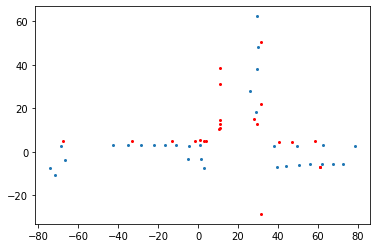

In [49]:
fnum = 396
print(frames[fnum]['car']['num_obj'])

plt.scatter(frames[fnum]['car']['label'][:,0], frames[fnum]['car']['label'][:,1], s=4)
plt.scatter(frames[fnum]['sign']['label'][:,0], frames[fnum]['sign']['label'][:,1], s=4, c='red')

In [ ]:
fnum = 396
scene_boxes = [boxpts_to_o3dbox(opd_to_boxpts(frames[fnum]['car']['label'][i])) for i in range(len(frames[fnum]['car']['label']))]
o3d.visualization.draw_geometries(scene_boxes)

In [101]:
from pathlib import Path

def get_car_model(idx, model_filelist):
    if idx == -1:
        valid_model = False
        while(not valid_model):            
            model_idx = np.random.randint(0,len(model_filelist))
            obj_file = Path(data_dir) / model_id / 'models/model_normalized.obj'
            if obj_file.exists():
                return str(obj_file)
    else:
        obj_file = Path(model_filelist[idx] + '/models/model_normalized.obj')
        if not obj_file.exists():
            raise f"{str(obj_file)} does not exist"            
        else:
            return str(obj_file)
        
        
def get_random_car(model_filelist):
    """
    Returns a random model that is randomly scaled and rotated
    """
    obj_file = get_car_model(-1, model_filelist)
    
    obj = load_shapenet(obj_file)
    model_v = np.asarray(obj['mesh'].vertices)
    
    print(obj_file)
    alpha = get_scaling_factor(model_v)
    scaled_pts = alpha * model_v
    gtbox = get_gt_for_zero_yaw(scaled_pts)
    
    obj_data = {'bbox': gtbox['bbox'],
                'vertices': scaled_pts,
                'faces': obj['mesh'].triangles,
                'centre': gtbox['center'],
                'dims': gtbox['dims'],
                'model_id': obj_file.split('/')[-3]}
    return obj_data

car = get_random_car(models)

/SEE-MTDA/data/shapenet/ShapeNetCore.v2/02958343/7da7ba42dbd0a0f9be40bb45ea25a041/models/model_normalized.obj
scaled_dims = [4.52249196 1.84603086 1.32224429]


In [104]:
def get_tmesh_with_box_labels(box_label, model_filelist):
    car = get_random_car(model_filelist)
    centroid = box_label[:3]
    yaw = box_label[-1]
    rmat = np.array([[np.cos(yaw), np.sin(yaw), 0],
                      [-np.sin(yaw), np.cos(yaw), 0],
                      [0, 0, 1]])
    tmesh = o3d.geometry.TriangleMesh()
    tmesh.vertices = o3d.utility.Vector3dVector(car['vertices'] @ rmat.T + centroid)
    tmesh.triangles = o3d.utility.Vector3iVector(car['faces'])
    
    ret = {'bbox': car['bbox'] @ rmat.T + centroid, 
           'mesh': tmesh, 
           'model_id': car['model_id'],
           'label': list(centroid) + list(car['dims']) + list([yaw]),
           'waymo_num_pts': int(box_label[-1])} 
    return ret

scene_cars = [get_tmesh_with_box_labels(frames[fnum]['car']['label'][i], models) for i in range(len(frames[fnum]['car']['label']))]

/SEE-MTDA/data/shapenet/ShapeNetCore.v2/02958343/7da7ba42dbd0a0f9be40bb45ea25a041/models/model_normalized.obj
scaled_dims = [5.00783643 2.04414307 1.46414481]
/SEE-MTDA/data/shapenet/ShapeNetCore.v2/02958343/7da7ba42dbd0a0f9be40bb45ea25a041/models/model_normalized.obj
scaled_dims = [5.04802656 2.06054823 1.47589523]
/SEE-MTDA/data/shapenet/ShapeNetCore.v2/02958343/7da7ba42dbd0a0f9be40bb45ea25a041/models/model_normalized.obj
scaled_dims = [4.08468752 1.66732396 1.19424309]
/SEE-MTDA/data/shapenet/ShapeNetCore.v2/02958343/7da7ba42dbd0a0f9be40bb45ea25a041/models/model_normalized.obj
scaled_dims = [3.8653455  1.57779099 1.1301139 ]
/SEE-MTDA/data/shapenet/ShapeNetCore.v2/02958343/7da7ba42dbd0a0f9be40bb45ea25a041/models/model_normalized.obj
scaled_dims = [5.11799161 2.08910718 1.49635096]
/SEE-MTDA/data/shapenet/ShapeNetCore.v2/02958343/7da7ba42dbd0a0f9be40bb45ea25a041/models/model_normalized.obj
scaled_dims = [4.5344858  1.85092661 1.32575094]
/SEE-MTDA/data/shapenet/ShapeNetCore.v2/029583

In [ ]:
origin = o3d.geometry.TriangleMesh.create_coordinate_frame(size=1, origin=[0,0,0])
o3d.visualization.draw_geometries([sc['mesh'] for sc in scene_cars] + [origin])

In [63]:
def populate_scene(scene_cars, sign_labels, random_poles_pct=0.3):
    scene = o3d.t.geometry.RaycastingScene()
    
    num_rand_poles = int(len(scene_cars)*random_poles_pct)
    
    for i, sc in enumerate(scene_cars):
        tmesh = o3d.t.geometry.TriangleMesh.from_legacy(sc['mesh'])
        scene.add_triangles(tmesh)
        
        if i < num_rand_poles:
            # Obstacles that are close to the cars
            car_centre = sc['label'][:3]
            car_height = sc['label'][5]
            pole_radius = np.random.uniform(0.03,0.2)
            pole_height = np.random.uniform(1,4,1)

            box_min = np.min(sc['bbox'], axis=0)[:2]
            box_max = np.max(sc['bbox'], axis=0)[:2]
            xyall_choice = np.random.choice([1,2,3])
            if np.random.choice([True, False]):
                if xyall_choice == 1:                    
                    pole_xy = np.array([box_max[0], car_centre[1]]) + np.random.uniform(0,0.5)
                elif xyall_choice == 2: 
                    pole_xy = np.array([car_centre[0], box_max[1]]) + np.random.uniform(0,0.5)
                else:
                    pole_xy = box_max + np.random.uniform(0,1,2)
            else:
                pole_xy = box_min - np.random.uniform(0,1,2)        
            pole_centre = np.concatenate([pole_xy, np.array(car_centre[2] + pole_height/2 - car_height/2)])
            cylinder = o3d.geometry.TriangleMesh.create_cylinder(radius=pole_radius, height=pole_height.item()).translate(pole_centre)
            scene.add_triangles(o3d.t.geometry.TriangleMesh.from_legacy(cylinder))                
    
    # Add the waymo labelled signs as cylinders
    for i, sign in enumerate(sign_labels):
        pole_height = np.random.uniform(1,4,1)
        pole_centre = sign[:3]
        pole_centre[2] = -2.4 + pole_height/2
        pole_radius = np.random.uniform(0.03,0.1)        
        cylinder = o3d.geometry.TriangleMesh.create_cylinder(radius=pole_radius, height=pole_height).translate(pole_centre)
        scene.add_triangles(o3d.t.geometry.TriangleMesh.from_legacy(cylinder))                
                
    return scene

def cast_rays_at_point(scene, point, fov_deg=100, aspect_ratio=2, height_px=640):
    rays = o3d.t.geometry.RaycastingScene.create_rays_pinhole(
    fov_deg=fov_deg, # simulates a vertical fov of lidar
    center=point, # point where camera is looking at
    eye=[0,0,0], # position of the camera
    up=[0, 0, 1], # up vector
    width_px=aspect_ratio*height_px, # image width
    height_px=height_px, # image height
    )
    
    ans = scene.cast_rays(rays)
    hit = ans['t_hit'].isfinite()
    points = rays[hit][:,:3] + rays[hit][:,3:]*ans['t_hit'][hit].reshape((-1,1))
    return points.numpy()
    
    
def raycast_object(car, scene):
    centre = car['label'][:3]
    ray_pts = cast_rays_at_point(scene, centre)
    o3dbox = boxpts_to_o3dbox(car['bbox'])
    
    ret = {'ray_pts': convert_to_o3dpcd(ray_pts),
           'obj_pts': convert_to_o3dpcd(ray_pts).crop(o3dbox),
           'bbox': o3dbox}
    return ret

scene = populate_scene(scene_cars, frames[fnum]['sign']['label'])
res = raycast_object(scene_cars[0], scene)

In [64]:
origin = o3d.geometry.TriangleMesh.create_coordinate_frame(size=1, origin=[0,0,0])
o3d.visualization.draw_geometries([res['ray_pts'], res['bbox'], origin])

In [300]:
o3d.visualization.draw_geometries([res['obj_pts'], res['bbox'], origin])

In [180]:
sum([frames[i]['car']['num_obj'] for i in range(len(frames))])

4712401

# Export scenes

In [1]:
from pathlib import Path
import time
from tqdm import tqdm
from pathlib import Path
import pickle
import os
import open3d as o3d # 0.14 has ray casting
import point_cloud_utils as pcu # !pip install pypcu
import csv
import numpy as np
import glob
import json
import matplotlib.pyplot as plt
from PIL import Image

def boxpts_to_o3dbox(box_pts):
    boxpts = o3d.utility.Vector3dVector(box_pts)
    o3dbox = o3d.geometry.OrientedBoundingBox().create_from_points(boxpts)
    o3dbox.color = np.array([1,0,0])
    return o3dbox

def load_shapenet(obj_file, num_pts=16384):

    v,f,n = pcu.load_mesh_vfn(obj_file)
    
    # Shapenet forward is -z, here we change to +z to fit right hand rule convention (convention for most lidars)
    # Detection datasets define car length as x, width as y, and height as z. Forward is +x
    v[:,2] *= -1
    
    # Here we re-orient shapenet coordinate system of [z,x,y] to fit typical lidar convention of [x,y,z]
    v = v[:,[2,0,1]]     
    
    # dense random sampling
    fi, bc = pcu.sample_mesh_random(v, f, num_pts)
    pts = pcu.interpolate_barycentric_coords(f, fi, bc, v)
    
    # Cut off antennas as they make the boxes really high
    num, edge = np.histogram(pts[:,2], bins='doane')
    mask = np.ones(len(edge), np.bool)
    indices = np.argwhere(num < 10)
    mask[indices+1] = 0
    zmin, zmax = min(edge[mask]), max(edge[mask])
    pts[:,2] = np.clip(pts[:,2], zmin, zmax)
    
    # ShapeNet is centered but it's slightly off 0,0,0
    bounds = get_minmax(pts)
    center = np.array([(bounds['max_x']+bounds['min_x'])/2, 
                       (bounds['max_y']+bounds['min_y'])/2, 
                       (bounds['max_z']+bounds['min_z'])/2]) 
    centered_pts = pts - center
    
    obj = {}
    obj['model_id'] = obj_file.split('/')[-3]
    obj['sampled_pts'] = centered_pts
    obj['boxpts'] = get_gt_for_zero_yaw(centered_pts)['bbox']
    obj['o3dbox'] = boxpts_to_o3dbox(obj['boxpts'])
    
    # Shapenet mesh is noisy, we use the pts above to limit the shape
    tmesh = o3d.geometry.TriangleMesh()
    tmesh.vertices = o3d.utility.Vector3dVector(v - center)
    tmesh.triangles = o3d.utility.Vector3iVector(f)
    tmesh.remove_unreferenced_vertices() 
    tmesh.remove_degenerate_triangles()
    tmesh.remove_duplicated_vertices()
    
    obj['mesh'] = tmesh.crop(obj['o3dbox'])    
    obj['dims'] = np.array([bounds['max_x']-bounds['min_x'],bounds['max_y']-bounds['min_y'],bounds['max_z']-bounds['min_z']])
    
    return obj

def get_scaling_factor(obj, min_car_width=1.55, max_car_width=2.15, min_car_height=0.6):
    dims = obj['dims']    
#     print(f'{model_id} - origdims = {dims}')
    valid_scaling = False
    while(not valid_scaling):
        car_width = np.random.uniform(min_car_width, max_car_width)
        scaling_factor = car_width/dims[1]
        scaled_pts = scaling_factor * np.asarray(obj['mesh'].vertices)
        scaled_bounds = get_minmax(scaled_pts)
        scaled_dims = get_lwh(scaled_bounds)
        if scaled_dims[2] > min_car_height:
            valid_scaling = True
    
    return scaling_factor    
    
def convert_to_o3dpcd(points, color=None):
    if type(points) == list:
        pcds = []
        for pointcloud in points:
            pcd = o3d.geometry.PointCloud()
            pcd.points = o3d.utility.Vector3dVector(pointcloud[:,:3])
            pcds.append(pcd)
        return pcds
    else:
        pcd = o3d.geometry.PointCloud()
        pcd.points = o3d.utility.Vector3dVector(points[:,:3])
        if color:
            pcd.paint_uniform_color(color)
        return pcd
    
def get_minmax(pts):
    return {'max_x':max(pts[:,0]), 'min_x':min(pts[:,0]),
            'max_y':max(pts[:,1]), 'min_y':min(pts[:,1]),
            'max_z':max(pts[:,2]), 'min_z':min(pts[:,2])}

def get_lwh(minmax):
    l1 = minmax['max_x'] - minmax['min_x']
    l2 = minmax['max_y'] - minmax['min_y']
    return np.array([max(l1,l2),min(l1,l2), minmax['max_z'] - minmax['min_z']]) # l,w,h

def get_gt_for_zero_yaw(pts, o3d_format=False):
    bounds = get_minmax(pts)     
    dims = get_lwh(bounds)
    center = np.array([(bounds['max_x']+bounds['min_x'])/2, 
                       (bounds['max_y']+bounds['min_y'])/2, 
                       (bounds['max_z']+bounds['min_z'])/2])   

    # return 3d box points for o3d box construction
    bbox3d = np.array([
        [bounds['max_x'], bounds['max_y'], bounds['max_z']],
        [bounds['max_x'], bounds['min_y'], bounds['max_z']],
        [bounds['min_x'], bounds['max_y'], bounds['max_z']],
        [bounds['min_x'], bounds['min_y'], bounds['max_z']],
        [bounds['max_x'], bounds['max_y'], bounds['min_z']],
        [bounds['max_x'], bounds['min_y'], bounds['min_z']],
        [bounds['min_x'], bounds['max_y'], bounds['min_z']],
        [bounds['min_x'], bounds['min_y'], bounds['min_z']]
    ])
    if o3d_format:
        o3dvec_bbox = o3d.utility.Vector3dVector(bbox3d)
        o3dbox = o3d.geometry.OrientedBoundingBox().create_from_points(o3dvec_bbox)
        o3dbox.color = np.array([1,0,0])
        return {'bbox':o3dbox, 'center':center, 'dims':dims} 
    else:
        return {'bbox':bbox3d, 'center':center, 'dims':dims} 
    
    
def sample_car_model(data_dir, sampled_db, unseen_list):
    # Random sample. We pop unseen/seen after seeing all models once
    if len(unseen_list) > 0:
        db_idx = np.random.randint(0,len(unseen_list))
        model_id = unseen_list[db_idx]
        sampled_db.setdefault(model_id, 0)
        unseen_list.remove(model_id)
        
#         print(f'sampling db_idx: {db_idx}, model_id: {model_id} from {len(unseen_list)} models')
    else:
        # Get the least sampled model
        model_id = min(sampled_db, key=sampled_db.get)
#         print(f'sampling model_id: {model_id} with {sampled_db[model_id]} counts')
    
    sampled_db[model_id] += 1
    obj_file = Path(data_dir) / model_id / 'models/model_normalized.obj'    
    
    assert obj_file.exists(), f"{str(obj_file)} does not exist"    
    return str(obj_file)
                
def get_car_object(data_dir, sampled_db, unseen_list):
    """
    Returns a random model that is randomly scaled and rotated
    """
    obj_file = sample_car_model(data_dir, sampled_db, unseen_list)
    model_id = obj_file.split('/')[-3]

    obj = load_shapenet(obj_file)
    model_v = np.asarray(obj['mesh'].vertices)
    
    alpha = get_scaling_factor(obj)
    scaled_pts = alpha * model_v
    gtbox = get_gt_for_zero_yaw(scaled_pts)
    
    obj_data = {'bbox': gtbox['bbox'],
                'vertices': scaled_pts,
                'faces': obj['mesh'].triangles,
                'centre': gtbox['center'],
                'dims': gtbox['dims'],
                'model_id': model_id}
    return obj_data

def get_tmeshes_with_box_labels(frame_cars, data_dir, sampled_db, unseen_list):
    if 'label' not in frame_cars:
        return []
    
    scene_cars = []
    for box_label in frame_cars['label']:

        car = get_car_object(data_dir, sampled_db, unseen_list)
        centroid = box_label[:3]
        yaw = box_label[-1]
        rmat = np.array([[np.cos(yaw), np.sin(yaw), 0],
                          [-np.sin(yaw), np.cos(yaw), 0],
                          [0, 0, 1]])
        tmesh = o3d.geometry.TriangleMesh()
        tmesh.vertices = o3d.utility.Vector3dVector(car['vertices'] @ rmat + centroid)
        tmesh.triangles = o3d.utility.Vector3iVector(car['faces'])
        tmesh.remove_unreferenced_vertices()

        ret = {'bbox': car['bbox'] @ rmat + centroid, 
               'mesh': tmesh.remove_unreferenced_vertices(), 
               'model_id': car['model_id'],
               'label': list(centroid) + list(car['dims']) + list([yaw]),
               'waymo_num_pts': int(box_label[-1])} 
        scene_cars.append(ret)
    return scene_cars

def opd_to_boxpts(box):
    """
    Takes an array containing [x,y,z,l,w,h,r], and returns an [8, 3] matrix that 
    represents the [x, y, z] for each 8 corners of the box.
    
    Note: Openpcdet __getitem__ gt_boxes are in the format [x,y,z,l,w,h,r,alpha]
    where alpha is "observation angle of object, ranging [-pi..pi]"
    """
    # To return
    corner_boxes = np.zeros((8, 3))

    translation = box[0:3]
    l, w, h = box[3], box[4], box[5] # waymo, nusc, kitti is all l,w,h after OpenPCDet processing
    rotation = box[6]

    # Create a bounding box outline
    bounding_box = np.array([[l/2, w/2, h/2],
                             [l/2, -w/2, h/2],
                             [-l/2, w/2, h/2],
                             [-l/2, -w/2, h/2],
                             [l/2, w/2, -h/2],
                             [l/2, -w/2, -h/2],
                             [-l/2, w/2, -h/2],
                             [-l/2, -w/2, -h/2]])

    # Standard 3x3 rotation matrix around the Z axis
    rotation_matrix = np.array([
        [np.cos(rotation), np.sin(rotation), 0.0],
        [-np.sin(rotation), np.cos(rotation), 0.0],
        [0.0, 0.0, 1.0]])
    vcbox = bounding_box @ rotation_matrix
    vcbox += box[:3]
    
    return vcbox

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
def populate_scene(scene_cars, signs, random_poles_pct=0.3):
    scene = o3d.t.geometry.RaycastingScene()
    
    num_rand_poles = int(len(scene_cars)*random_poles_pct)
    
    for i, sc in enumerate(scene_cars):
        tmesh = o3d.t.geometry.TriangleMesh.from_legacy(sc['mesh'])
        scene.add_triangles(tmesh)
        
        if i < num_rand_poles:
            # Obstacles that are close to the cars
            car_centre = sc['label'][:3]
            car_height = sc['label'][5]
            pole_radius = np.random.uniform(0.03,0.2)
            pole_height = np.random.uniform(1,4,1)

            box_min = np.min(sc['bbox'], axis=0)[:2]
            box_max = np.max(sc['bbox'], axis=0)[:2]
            xyall_choice = np.random.choice([1,2,3])
            if np.random.choice([True, False]):
                if xyall_choice == 1:                    
                    pole_xy = np.array([box_max[0], car_centre[1]]) + np.random.uniform(0,0.5)
                elif xyall_choice == 2:
                    pole_xy = np.array([car_centre[0], box_max[1]]) + np.random.uniform(0,0.5)
                else:
                    pole_xy = box_max + np.random.uniform(0,1,2)
            else:
                pole_xy = box_min - np.random.uniform(0,1,2)        
            pole_centre = np.concatenate([pole_xy, np.array(car_centre[2] + pole_height/2 - car_height/2)])
            cylinder = o3d.geometry.TriangleMesh.create_cylinder(radius=pole_radius, height=pole_height.item()).translate(pole_centre)
            scene.add_triangles(o3d.t.geometry.TriangleMesh.from_legacy(cylinder))                
    
    # Add the waymo labelled signs as cylinders
    if 'label' in signs:
        sign_labels = signs['label']
        for i, sign in enumerate(sign_labels):
            pole_height = np.random.uniform(1,4,1)
            pole_centre = sign[:3]
            pole_centre[2] = -2.4 + pole_height/2
            pole_radius = np.random.uniform(0.03,0.1)        
            cylinder = o3d.geometry.TriangleMesh.create_cylinder(radius=pole_radius, height=pole_height).translate(pole_centre)
            scene.add_triangles(o3d.t.geometry.TriangleMesh.from_legacy(cylinder))                
                
    return scene

def cast_rays_at_point(scene, point, fov_deg=100, aspect_ratio=2, height_px=640):
    rays = o3d.t.geometry.RaycastingScene.create_rays_pinhole(
    fov_deg=fov_deg, # simulates a vertical fov of lidar
    center=point, # point where camera is looking at
    eye=[0,0,0], # position of the camera
    up=[0, 0, 1], # up vector
    width_px=aspect_ratio*height_px, # image width
    height_px=height_px, # image height
    )
    
    ans = scene.cast_rays(rays)
    hit = ans['t_hit'].isfinite()
    points = rays[hit][:,:3] + rays[hit][:,3:]*ans['t_hit'][hit].reshape((-1,1))
    return points.numpy()
    
    
def raycast_object(car, scene, npoints):
    centre = car['label'][:3]    
    
    fov_deg = np.random.normal(120, 30)
    ray_pts = cast_rays_at_point(scene, centre, fov_deg=fov_deg, aspect_ratio=2, height_px=640)
    o3dbox = boxpts_to_o3dbox(car['bbox'])
    
    ret = {'ray_pts': convert_to_o3dpcd(ray_pts),
           'obj_pts': convert_to_o3dpcd(ray_pts).crop(o3dbox),
           'complete': car['mesh'].sample_points_uniformly(npoints),
           'bbox_pts': car['bbox'],
           'model_id': car['model_id'],
           'label': car['label'],
           'fov_deg':fov_deg}
    return ret

In [3]:
waymo_lidar_height = 2.4
frames = []

infos_path = '/SEE-MTDA/data/waymo/infos_openpcdetv0.3.0/waymo_infos_train.pkl'

with open(infos_path, 'rb') as f:
    infos = pickle.load(f)

for i, info in enumerate(infos):    
    
    vmask = info['annos']['name'] == 'Vehicle'    
    car_label = info['annos']['gt_boxes_lidar'][vmask]     
    
    if len(car_label) > 0:
        frame = {}
        frame['car'] = {}
        frame['sign'] = {}
        
        # Waymo annotates forklifts etc as two parts, the arm and body. We ignore the arm.
        valid_carwidth = car_label[:,4] > 1.5
        car_label = car_label[valid_carwidth]
        
        car_label[:,2] -= waymo_lidar_height    
        frame['car']['label'] = car_label
        frame['car']['num_pts'] = info['annos']['num_points_in_gt'][vmask]
        frame['car']['num_obj'] = len(car_label)
    
        smask = info['annos']['name'] == 'Sign'
        sign_label = info['annos']['gt_boxes_lidar'][smask]   

        if len(sign_label) > 0:            
            sign_label[:,2] -= waymo_lidar_height
            frame['sign']['label'] = sign_label
            frame['sign']['num_pts'] = info['annos']['num_points_in_gt'][smask]
            frame['sign']['num_obj'] = len(sign_label)
        frames.append(frame)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  # This is added back by InteractiveShellApp.init_path()


In [4]:
import pickle
import random

# Specifically for Shapenet.v2
ignore = {}
ignore['non_car'] = ['d353bf0e0dfe3ac29cbc1c09129e1507','c0db588c8c816cd2dc668d3d64c871ae']
ignore['unclean_car'] = ['a75ff576da012340468bac13e007a6e9','52c589e86fd500cd4a42886683bb52d2','65d6433043c40046b82c0841410a924f','e09813b03bdfce83a23218adb697420d','d1acd4916d3d3b57c48db2ed8f5e994c','39b307361b650db073a425eed3ac7a0b', 'dda10fc985eea0868c368040825ed335', '471673f3f062abd473f10e6caaeca56','e2ceb9bf23b498dda7431386d9d22644','3804a264b503d5812e40b8f7ac380eb5','445185842d893b6978fe949fc1419876','95ebb3fd80f885ad676f197a68a5168a','ba89184f58f21ff63343f5fadc4a2136']
ignore['truck_bus'] = ['6aa8f648cc8df63ab2c17ece4015d55','84bc3155bc5c95bfaaafd94b9f216ef6','fd3b75f7f1e9172fb6f657757c95f74e','21999849a6a8aad752470de2774d6099','dfa6c32dec07727ee9d8921ebe6d5b8e','26b7a9c6c7e74829eabc798aaf5f039f', '433481aa8cde9b692e3dd7c278f108dd','cdfe4dc408f4ca84aaafd94b9f216ef6']
ignore['limo'] = ['c9b49f7b355528e5632dc979097a3ec0','b11c0c16e0eed1f4b8671dc42cc45273','eefce52130d223ba2dcbf88f7c685079','db432e9f280ffb1e3dd4bdc1dbab98bd','dd0817b9757b74c75d3a87a5c4dd9ce4','e4b1de221f2d66352638397725e10cf9','9d2b7938d426633b28044fe9244db50a','41d317b520eec9d38d3d01fa03326bb0','5a5b0e1cbb38bdb12d08a76380360b3b','bc9c588a00ae179fa2645d665a7d8fa','ed91b2509171fdc1c48492b454f1615a','17c32e15723ed6e0cd0bf4a0e76b8df5','9fa56c19e4d54cca99c8d14f483ffc82','2f1001870f90e06bc48492b454f1615a','4c53afe560e36d8380ba2a9340bf2d77','e0978173fcfc5203510556e7c3123591','fb8adbcf67d858fc28044fe9244db50a','9dee0ea5da388102e6d91d458fe44a15','7c7e5b4fa56d8ed654b40bc735c6fdf6','7f6031f1738d52546436916a86a90ed7','cc0c058e2eca523051fb05589f6b0d0e','9676e8250cdd90307d5394224a6aa067','282293948b21262769416db9b743e50b','202fbaeffaf49f4b61c6c61410fc904b','b4d258dc5a12f9f7ade7f700b19bcf4a','f1b97d671bb93ad928044fe9244db50a','9d77d4c959974035fab60fc805223a73','5c3fe4057ef12b6886ac29addefc0f11','56dc27e4374cf87132eaaf3b7c9989f6', '501ac8493044eff04d44f5db04bf14b8','55181c34dadb4f032db09455d18fca0']
ignore['invalid_lwratio'] = ['7e7f0637d6798113ddb4014f0e8d0dac', '492a339ce5da3fe8e4b68d3b17c43658', '99fce87e4e80e053374462542bf2aa29', 'f7f7b1b4021be11afaeea7738551d104', 'bfa01c632be2eb06e8a3b392b986583', '7c85e6cf9c4f46e91cc13e432d5756b8', '6b79cfceb6f614527e7afb83f93db294', '52c589e86fd500cd4a42886683bb52d2', 'd1acd4916d3d3b57c48db2ed8f5e994c', '65d6433043c40046b82c0841410a924f', 'f4498022df553505c35f22936e5aea5c', '3c310afdf363201cefe5f291bc2f5fd0', 'c0db588c8c816cd2dc668d3d64c871ae', 'd353bf0e0dfe3ac29cbc1c09129e1507', '9f7b4a82becac9cd5568b8cbf53329df', 'e4d1edc4cda4a6445fb81d6394b59c19','c30bf6d1ae428497c7f3070d3c7b9f30', '3804a264b503d5812e40b8f7ac380eb5', 'cdfe4dc408f4ca84aaafd94b9f216ef6', '55181c34dadb4f032db09455d18fca0', '95a6e03656bdff26f69bc9777f9c3c39', '957a686c3c9f956a3d982653fc5fd75b', '88c884dd867d221984ae8a5736280c', 'ba89184f58f21ff63343f5fadc4a2136', '1c7ddd2735778013ce50f18f6100cef6', 'd05aa55f9e5b4d10afe1d4530f4c6e24', 'a3e7603c0d9ef56280e74058ee862f05', '96ca20dd7caff0bb851f021b9ed69c58', '2df225b8df2633c231141a7d4d06dc13', '781b45d3eb625148248a78e10a40d8eb', '4e488242b665d85f40bc3b36a331b786', '48260abd4ff73f99473f10e6caaeca56', '56d463162ff5352cbd835ce3c63f4d10', '189cffefcdd5cb071a126804ae24042', '36b211593bfa7c2f7f33a9b0659de0d7', '36fe332c1b11696d51a95aaa6caba1d3', '69e99923c3cbcbcca9fe1734a6086750', '346917af7c9659e3814085552234c955', 'ca93e4d0ca75ab1bafe1d4530f4c6e24', '1e987cad6ca8a97a7a24dbc42a104ca8', 'd9049f432296ed36afe1d4530f4c6e24', 'd5c046451e5bd6826a9c18480b4632cb', '3ab98667cabf774e3343f5fadc4a2136', 'dc8765720d8d3828b3cf5236f651a8e6', '5ce9ef613933a245538f2c6e5c51cc7e', 'ac7e674eb67488dcafe1d4530f4c6e24', '5e4a1ac9bdce2766473f10e6caaeca56', '8402d2237afac94a1cf6f8e565096a1e', '791e45f93e9ba58071a126804ae24042', 'f296f3a83e09de75afe1d4530f4c6e24', '307e83044ed81f6c473f10e6caaeca56']
ignore['invalid_objfile'] = ['93ce8e230939dfc230714334794526d4', '9fb1d03b22ecac5835da01f298003d56', '302612708e86efea62d2c237bfbc22ca', '806d740ca8fad5c1473f10e6caaeca56', '2307b51ca7e4a03d30714334794526d4', 'd6ee8e0a0b392f98eb96598da750ef34', 'e6c22be1a39c9b62fb403c87929e1167', '986ed07c18a2e5592a9eb0f146e94477', '407f2811c0fe4e9361c6c61410fc904b', '5bf2d7c2167755a72a9eb0f146e94477', '3ffeec4abd78c945c7c79bdb1d5fe365', 'f5bac2b133a979c573397a92d1662ba5', '3c33f9f8edc558ce77aa0b62eed1492', 'ea3f2971f1c125076c4384c3b17a86ea', '7aa9619e89baaec6d9b8dfa78596b717', '5973afc979049405f63ee8a34069b7c5', '4ddef66f32e1902d3448fdcb67fe08ff', '207e69af994efa9330714334794526d4', '8070747805908ae62a9eb0f146e94477']
ignore['invalid_whratio'] = ['8ee2dfd1460eded9473f10e6caaeca56', 'e2ceb9bf23b498dda7431386d9d22644', '4e488242b665d85f40bc3b36a331b786', '93a813f96365c108f217b9504689397', '9de10b4469cdc435afe1d4530f4c6e24', '863f9284eec4a256e9d8921ebe6d5b8e', 'b9ae3fb6b027dc4294a553cca1043426']
ignore['combined'] = [idx for k,v in ignore.items() for idx in v]

In [5]:
# We don't include trucks, buses or limos for this project
data_dir = '/SEE-MTDA/data/shapenet/ShapeNetCore.v2/02958343'
model_glob = glob.glob(f'{data_dir}/*')
models = set([model.split('/')[-1] for model in model_glob])
ignore_combined = set(ignore['combined'])
models.difference_update(ignore_combined)
models = list(models)
print(len(models))

3413


In [11]:
# invalid = {}
# invalid['lw_ratio'] = []
# invalid['wh_ratio'] = []

# for model in tqdm(models, total=len(models)):
#     data_dir = Path('/SEE-MTDA/data/shapenet/ShapeNetCore.v2/02958343')
#     obj = load_shapenet(str(data_dir / model / 'models/model_normalized.obj'))
#     lw_ratio = obj['dims'][0]/obj['dims'][1]
#     wh_ratio = obj['dims'][1]/obj['dims'][2]
#     if lw_ratio > 3.2 or lw_ratio < 1.5:
#         print(f'{model}: lw_ratio={lw_ratio}, dims={obj["dims"]}')
#         invalid['lw_ratio'].append(model)
#     if wh_ratio < 0.75 or wh_ratio > 2.5:
#         print(f'{model}: wh_ratio={wh_ratio}, dims={obj["dims"]}')
#         invalid['wh_ratio'].append(model)

In [6]:
def generate_dataset(data_dir, frames, models, dataset_name):
    min_pts = 50
    max_pts = 6000
    nviews = 30
    npoints_complete = 16384

    save_dir = Path(f'/SEE-MTDA/data/shapenet/VC/WAYMO_nviews-{nviews}/{dataset_name}')
    save_dir.mkdir(exist_ok=True, parents=True)
    total = nviews * len(models)
    currently_exported = 0
#     t0 = time.time()
    pbar = tqdm(total=total)
    
    sampled_db = {}
    exported_db = {}
    unseen_list = models

    # Shuffle frames because there's 199 frames in one scene
    random.shuffle(frames)
    for fnum, frame in enumerate(frames):

        scene_cars = get_tmeshes_with_box_labels(frame['car'], data_dir, sampled_db, unseen_list)
        scene = populate_scene(scene_cars, frame['sign'])

        # Export each car in the scene and update sampling_db
        for car in scene_cars:
            data = raycast_object(car, scene, npoints_complete)
            model_id = data['model_id']            

            print(f"\n{len(data['obj_pts'].points)} pts - fov_deg: {data['fov_deg']}")
#             print(f'model_id: {model_id} => counts {sampled_db[model_id]}')                
            
            if len(data['obj_pts'].points) > min_pts and len(data['obj_pts'].points) < max_pts:                
                exported_db.setdefault(model_id, 0)
                car_id = exported_db[model_id]

                if car_id >= nviews:
                    continue                
                    
                # Save object
                # Save partial, complete, labels
                partial_dir = save_dir / 'partial' / model_id
                partial_dir.mkdir(exist_ok=True, parents=True)

                complete_dir = save_dir / 'complete' / model_id
                complete_dir.mkdir(exist_ok=True, parents=True)

                label_dir = save_dir / 'label' / model_id
                label_dir.mkdir(exist_ok=True, parents=True)

                o3d.io.write_point_cloud(str(partial_dir / f'{car_id:03d}.pcd'), data['obj_pts'])
                o3d.io.write_point_cloud(str(complete_dir / f'{car_id:03d}.pcd'), data['complete'])
                with open(str(label_dir / f'{car_id:03d}.pkl'), 'wb') as f:
                    label = {'bbox_pts': data['bbox_pts'], 
                             'gtbox': data['label'],
                             'pc_id': f'{model_id}_{car_id:03d}',
                             'raycasting': data['fov_deg']}
                    pickle.dump(label, f)

                currently_exported += 1
                exported_db[model_id] += 1
                
#                 print(f'model_id: {model_id} => num exported {exported_db[model_id]}')                
                print(f'{currently_exported}/{total} objects exported')
#                 avg_time = (time.time() - t0)/currently_exported
#                 print(f'{avg_time:0.3f}s/it, {(avg_time * total - (time.time()-t0))/60:0.4}min est. time remaining')
                pbar.update(1)
                
                if currently_exported >= total:
                    print(f'{currently_exported} objects exported')                    
                    pbar.close()
                    return
            else:
                counts = sampled_db[model_id]
                sampled_db[model_id] = max(counts - 1, 0)
                if sampled_db[model_id] == 0:
                    print(f'adding {model_id} back to unseen')
                    unseen_list.append(model_id)
                    
#                 print(f'model_id: {model_id} => counts {sampled_db[model_id]}')                
    



generate_dataset(data_dir, frames, models[int(3413*0.8):int(3413*0.9)], dataset_name='val')
generate_dataset(data_dir, frames, models[int(3413*0.9):], dataset_name='test')
generate_dataset(data_dir, frames, models[:int(3413*0.8)], dataset_name='train')

  0%|                                                     | 0/10230 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/point_cloud_utils/_mesh_io.py:265: RuntimeWarning: Noncritical error (9) during loading model_normalized.obj: 'Identical vertex indices found in the same faces -- faces ignored'
  mesh_dict = load_mesh_internal(mesh_filename, dtype)
  0%|                                          | 1/10230 [00:17<50:40:50, 17.84s/it]


29 pts - fov_deg: 152.30116975274848
adding bd33b9efe58ebefa99f8616cdb5dd27c back to unseen

1431 pts - fov_deg: 45.46390196085096
1/10230 objects exported

55 pts - fov_deg: 130.18285922778827
2/10230 objects exported


  0%|                                          | 3/10230 [00:18<35:41:16, 12.56s/it]


138717 pts - fov_deg: 89.36298054975148
adding a52f704da0d3c947ca92a4cdad802b45 back to unseen

293 pts - fov_deg: 120.57673876015257
3/10230 objects exported


  0%|                                          | 4/10230 [00:18<25:05:33,  8.83s/it]


3015 pts - fov_deg: 81.44465619956179
4/10230 objects exported


  0%|                                          | 5/10230 [00:18<17:55:00,  6.31s/it]


100 pts - fov_deg: 102.3880286691639
5/10230 objects exported

39 pts - fov_deg: 144.57960165585075
adding b35117b7e025a012bda733a39f84326d back to unseen


  0%|                                          | 6/10230 [00:19<12:49:48,  4.52s/it]


26 pts - fov_deg: 154.02493914709044
adding 63cc90709837d314a0b2db16370345f0 back to unseen

81 pts - fov_deg: 150.98459763888116
6/10230 objects exported

15465 pts - fov_deg: 93.37093582619377
adding f9cad36ae25540a0bb20fd1bc4860856 back to unseen


  0%|                                           | 7/10230 [00:19<9:36:51,  3.39s/it]


95 pts - fov_deg: 130.34604723696035
7/10230 objects exported

8 pts - fov_deg: 193.43668311945436
adding 721dfe60b48849ec7ac8cd969c3298ce back to unseen


  0%|                                           | 8/10230 [00:20<7:07:51,  2.51s/it]


26 pts - fov_deg: 148.4406668705889
adding aa9f41bc3925ffc4be9358e8c18dc481 back to unseen

269 pts - fov_deg: 99.59993513340677
8/10230 objects exported


  0%|                                          | 10/10230 [00:20<3:40:04,  1.29s/it]


356 pts - fov_deg: 78.97631095081753
9/10230 objects exported

5601 pts - fov_deg: 79.04719971203004
10/10230 objects exported


  0%|                                          | 11/10230 [00:20<2:46:16,  1.02it/s]


72 pts - fov_deg: 159.031174600084
11/10230 objects exported


  0%|                                          | 12/10230 [00:21<2:23:43,  1.18it/s]


0 pts - fov_deg: 101.96113432237777
adding bb7fec347b2b57498747b160cf027f1 back to unseen

167 pts - fov_deg: 98.31404216404003
12/10230 objects exported


  0%|                                          | 13/10230 [00:21<1:53:11,  1.50it/s]


44 pts - fov_deg: 154.74423760487792
adding 18c7b5644290ce2caf0c754abe32de back to unseen

745 pts - fov_deg: 56.52097207465634
13/10230 objects exported


  0%|                                          | 14/10230 [00:22<1:35:58,  1.77it/s]


575 pts - fov_deg: 90.5922161706932
14/10230 objects exported

15319 pts - fov_deg: 93.24835939066377
adding dfc08488e2ec687d1c64dffb0265c4d6 back to unseen


  0%|                                          | 15/10230 [00:22<1:25:59,  1.98it/s]


188 pts - fov_deg: 105.1380081359164
15/10230 objects exported


  0%|                                          | 16/10230 [00:22<1:14:32,  2.28it/s]


183 pts - fov_deg: 101.5825753153559
16/10230 objects exported


  0%|                                            | 18/10230 [00:23<50:01,  3.40it/s]


60 pts - fov_deg: 124.12961834469256
17/10230 objects exported

132 pts - fov_deg: 130.81112808559956
18/10230 objects exported


  0%|                                            | 19/10230 [00:23<41:10,  4.13it/s]


1379 pts - fov_deg: 76.55649185369299
19/10230 objects exported


  0%|                                         | 21/10230 [00:44<13:23:30,  4.72s/it]


892 pts - fov_deg: 75.39084950268271
20/10230 objects exported

20 pts - fov_deg: 148.2448056219988
adding 62a7e17ce83e2f9cc0ed6ec757ca50f5 back to unseen

674 pts - fov_deg: 79.24006682005108
21/10230 objects exported


  0%|                                          | 23/10230 [00:45<6:47:01,  2.39s/it]


277 pts - fov_deg: 93.64625307682539
22/10230 objects exported

253 pts - fov_deg: 114.50589047620964
23/10230 objects exported


  0%|                                          | 24/10230 [00:45<4:52:21,  1.72s/it]


54 pts - fov_deg: 138.3954397764954
24/10230 objects exported

11 pts - fov_deg: 125.86353259829974
adding b4d7ad07dbcefefaafe1d4530f4c6e24 back to unseen


  0%|                                          | 25/10230 [00:45<3:43:28,  1.31s/it]


44 pts - fov_deg: 144.5058469291438
adding 7d4c3d9795570647657231d17e42d06f back to unseen

845 pts - fov_deg: 89.27222603308564
25/10230 objects exported


  0%|                                          | 28/10230 [00:46<1:57:33,  1.45it/s]


100 pts - fov_deg: 158.59944110822974
26/10230 objects exported

1184 pts - fov_deg: 83.58818121921975
27/10230 objects exported

956 pts - fov_deg: 92.10669934285357
28/10230 objects exported


  0%|                                          | 30/10230 [00:46<1:27:01,  1.95it/s]


1951 pts - fov_deg: 62.65853549778428
29/10230 objects exported

292 pts - fov_deg: 99.36571204421759
30/10230 objects exported


  0%|▏                                         | 31/10230 [00:46<1:12:57,  2.33it/s]


0 pts - fov_deg: 58.52260244087956
adding 1176dff7f0ec879719d740e0f6a9a113 back to unseen

128 pts - fov_deg: 118.080109838646
31/10230 objects exported

33 pts - fov_deg: 168.50621861747794
adding 4235a8f0f7b92ebdbfea8bc24170a935 back to unseen


  0%|▏                                           | 33/10230 [00:46<49:14,  3.45it/s]


318 pts - fov_deg: 108.56140580238267
32/10230 objects exported

0 pts - fov_deg: 174.0470153983251
adding 2e5ab446d0767e1aa6dd909dc6fc8d4 back to unseen

378 pts - fov_deg: 119.7783986555883
33/10230 objects exported


  0%|▏                                           | 34/10230 [00:46<42:52,  3.96it/s]


41 pts - fov_deg: 141.71929179630686
adding b61b7103e8d8af91fe21694bd5f519d1 back to unseen

2723 pts - fov_deg: 77.93966988537095
34/10230 objects exported

47 pts - fov_deg: 151.08194038742184
adding f4da249169898dd915212cd62adf957e back to unseen


  0%|▏                                           | 35/10230 [00:47<40:09,  4.23it/s]


105 pts - fov_deg: 112.40422179931238
35/10230 objects exported

451 pts - fov_deg: 120.94418160951975
36/10230 objects exported


  0%|▏                                           | 39/10230 [00:47<28:06,  6.04it/s]


77 pts - fov_deg: 92.5834643734419
37/10230 objects exported

125 pts - fov_deg: 104.24404863260989
38/10230 objects exported

76 pts - fov_deg: 133.57733568106582
39/10230 objects exported


  0%|▏                                           | 42/10230 [00:47<22:41,  7.49it/s]


732 pts - fov_deg: 88.60846813716009
40/10230 objects exported

309 pts - fov_deg: 130.6407045827379
41/10230 objects exported

151 pts - fov_deg: 140.91660170221155
42/10230 objects exported


  0%|▏                                           | 43/10230 [00:47<21:10,  8.02it/s]


230 pts - fov_deg: 95.81073786020059
43/10230 objects exported

61 pts - fov_deg: 138.90782945353052
44/10230 objects exported

19 pts - fov_deg: 136.12730599549633
adding e5236427b42606f4cac26de9a01eefad back to unseen


  0%|▏                                           | 45/10230 [00:48<24:54,  6.81it/s]


11 pts - fov_deg: 164.11658251524113
adding bc803cea33d77530a5038167d6f08983 back to unseen

25 pts - fov_deg: 148.81653944238155
adding a54ce961d973443a0daf3e5400b95c back to unseen

1126 pts - fov_deg: 75.98199206417857
45/10230 objects exported

128 pts - fov_deg: 114.24623927551964
46/10230 objects exported


  0%|▏                                           | 47/10230 [00:48<23:35,  7.19it/s]


44 pts - fov_deg: 116.56522457327495
adding 7825218160564f137039b7b9eba2e0f7 back to unseen

72 pts - fov_deg: 128.64704671361739
47/10230 objects exported

13 pts - fov_deg: 155.0148956755532
adding f9cbd331bd475e07dc1fa1f50eb490cc back to unseen


  0%|▏                                        | 48/10230 [01:18<25:19:13,  8.95s/it]


823 pts - fov_deg: 83.07659539225374
48/10230 objects exported

1 pts - fov_deg: 174.2994047425202
adding bf0e8d944ba4843e94e7e8e27399daf7 back to unseen


  0%|▏                                        | 50/10230 [01:18<12:42:06,  4.49s/it]


144 pts - fov_deg: 102.02879321492286
49/10230 objects exported

54 pts - fov_deg: 137.40727724137088
50/10230 objects exported


  0%|▏                                         | 51/10230 [01:18<9:02:23,  3.20s/it]


105 pts - fov_deg: 143.63713696467357
51/10230 objects exported


  1%|▏                                         | 52/10230 [01:19<6:41:20,  2.37s/it]


14306 pts - fov_deg: 113.08812766450943
adding 9a92ea1009f6b5127b5d9dbd93af5e1a back to unseen

345 pts - fov_deg: 122.81438513967679
52/10230 objects exported


  1%|▏                                         | 53/10230 [01:19<4:47:16,  1.69s/it]


119 pts - fov_deg: 85.4163714343637
53/10230 objects exported


  1%|▏                                         | 54/10230 [01:19<3:35:20,  1.27s/it]


133 pts - fov_deg: 64.96038608564602
54/10230 objects exported


  1%|▏                                         | 55/10230 [01:19<2:45:41,  1.02it/s]


18389 pts - fov_deg: 86.39755697825316
adding 9a58eccb0ab51d2fa790ab932daff416 back to unseen

2936 pts - fov_deg: 88.75927598906544
55/10230 objects exported

63 pts - fov_deg: 137.34058269300647
56/10230 objects exported


  1%|▏                                         | 57/10230 [01:20<2:02:14,  1.39it/s]


1336 pts - fov_deg: 110.98910675932746
57/10230 objects exported

204 pts - fov_deg: 141.635266539687
58/10230 objects exported


  1%|▏                                         | 60/10230 [01:20<1:15:03,  2.26it/s]


226 pts - fov_deg: 113.27010605970973
59/10230 objects exported

61 pts - fov_deg: 123.82140622183192
60/10230 objects exported


  1%|▎                                         | 61/10230 [01:20<1:05:26,  2.59it/s]


2 pts - fov_deg: 167.88843026933637
adding ca0f99974520bde12776450c3e3bf20a back to unseen

724 pts - fov_deg: 113.91330486445409
61/10230 objects exported


  1%|▎                                         | 62/10230 [01:21<1:06:36,  2.54it/s]


0 pts - fov_deg: 179.98306464922914
adding 3ca3c91dae8d2cbdf56f8ea3d9016e55 back to unseen

90 pts - fov_deg: 134.45160258555617
62/10230 objects exported


  1%|▎                                           | 63/10230 [01:21<53:17,  3.18it/s]


52 pts - fov_deg: 138.9545759882908
63/10230 objects exported


  1%|▎                                           | 64/10230 [01:21<49:18,  3.44it/s]


614 pts - fov_deg: 93.7208725373718
64/10230 objects exported


  1%|▎                                           | 66/10230 [01:22<42:30,  3.98it/s]


4013 pts - fov_deg: 95.52805310227686
65/10230 objects exported

360 pts - fov_deg: 53.364678835725755
66/10230 objects exported


  1%|▎                                           | 68/10230 [01:22<33:55,  4.99it/s]


135 pts - fov_deg: 98.67624476846053
67/10230 objects exported

197 pts - fov_deg: 132.79895345013475
68/10230 objects exported


  1%|▎                                           | 70/10230 [01:22<28:42,  5.90it/s]


678 pts - fov_deg: 130.48732100868395
69/10230 objects exported

216 pts - fov_deg: 133.43314283019987
70/10230 objects exported

6 pts - fov_deg: 110.66898439669279
adding 96c84869cb3c6657e49167a1ad5be1be back to unseen


  1%|▎                                           | 71/10230 [01:23<52:15,  3.24it/s]


15698 pts - fov_deg: 65.01398250557085
adding a886262ac3be5ca7c126a452758c84e7 back to unseen

131 pts - fov_deg: 140.0050571998943
71/10230 objects exported


  1%|▎                                           | 72/10230 [01:23<44:53,  3.77it/s]


258 pts - fov_deg: 111.70343377907902
72/10230 objects exported

45 pts - fov_deg: 132.81569546769697
adding dd184b3f41891cd317c40808ff7018fc back to unseen


  1%|▎                                           | 73/10230 [01:23<50:02,  3.38it/s]


5815 pts - fov_deg: 137.96648595328742
73/10230 objects exported


  1%|▎                                           | 74/10230 [01:24<45:59,  3.68it/s]


797 pts - fov_deg: 93.20933470876223
74/10230 objects exported

9795 pts - fov_deg: 108.30767160083371
adding ab8b6d39057d2f6cc86779a6788ad464 back to unseen


  1%|▎                                           | 75/10230 [01:24<59:19,  2.85it/s]


45 pts - fov_deg: 138.64267719409406
adding 588c2d2567fd900aefe5f291bc2f5fd0 back to unseen

115 pts - fov_deg: 112.00844458176762
75/10230 objects exported


  1%|▎                                           | 76/10230 [01:24<50:15,  3.37it/s]


349 pts - fov_deg: 118.02706323292472
76/10230 objects exported

53 pts - fov_deg: 151.98218312264885


  1%|▎                                           | 78/10230 [01:25<37:55,  4.46it/s]

77/10230 objects exported

172 pts - fov_deg: 89.41021300944743
78/10230 objects exported


  1%|▎                                           | 79/10230 [01:25<35:30,  4.77it/s]


76 pts - fov_deg: 113.29261904955483
79/10230 objects exported

11 pts - fov_deg: 158.76670598572974
adding e7c4b54fe56d9288dd1e15301c83686f back to unseen


  1%|▎                                           | 80/10230 [01:25<40:38,  4.16it/s]


104 pts - fov_deg: 127.98437021136785
80/10230 objects exported

23 pts - fov_deg: 214.33488940639154
adding 6232fe1824a6d1775b72003cd427d0c1 back to unseen

11 pts - fov_deg: 149.3336365102569
adding 2fb155f2d36541b5e3bdba9430565083 back to unseen

25 pts - fov_deg: 118.5435844984879
adding 3ea856c52fbb213fe151fba1241f1efa back to unseen


  1%|▎                                         | 81/10230 [01:30<4:26:25,  1.58s/it]


60 pts - fov_deg: 123.5544624019742
81/10230 objects exported

1979 pts - fov_deg: 105.58952009060064
82/10230 objects exported

4 pts - fov_deg: 164.06744284279569
adding 383a4d1ee8022e9a61fd7e090d4d0d45 back to unseen


  1%|▎                                         | 83/10230 [01:30<3:13:55,  1.15s/it]


6344 pts - fov_deg: 89.57090823242818
adding 1d82451a55d19cdd711f9e3a79a13dcf back to unseen

52 pts - fov_deg: 142.08131761548992
83/10230 objects exported

100 pts - fov_deg: 140.04633358570038
84/10230 objects exported


  1%|▎                                         | 85/10230 [01:30<2:19:26,  1.21it/s]


384 pts - fov_deg: 93.92661180878315
85/10230 objects exported


  1%|▎                                        | 88/10230 [01:59<18:02:59,  6.41s/it]


1035 pts - fov_deg: 63.62140831498989
86/10230 objects exported

511 pts - fov_deg: 117.81699841799113
87/10230 objects exported

163 pts - fov_deg: 97.68332840888786
88/10230 objects exported

36832 pts - fov_deg: 86.1251126612533
adding 1f8aee726cbf44c23d27832ab9ea6d92 back to unseen

0 pts - fov_deg: 176.75059131761935
adding 86c8a3137a716d70e742b0b5e87bec54 back to unseen


  1%|▎                                         | 90/10230 [02:00<9:18:41,  3.31s/it]


192 pts - fov_deg: 90.742121755541
89/10230 objects exported

1345 pts - fov_deg: 69.51779965470894
90/10230 objects exported


  1%|▍                                         | 92/10230 [02:00<4:46:07,  1.69s/it]


488 pts - fov_deg: 122.78989225939286
91/10230 objects exported

132 pts - fov_deg: 93.51073216130365
92/10230 objects exported


  1%|▍                                         | 94/10230 [02:00<2:29:43,  1.13it/s]


577 pts - fov_deg: 137.7621284575623
93/10230 objects exported

226 pts - fov_deg: 137.07207348843258
94/10230 objects exported

391 pts - fov_deg: 122.48718766745303
95/10230 objects exported

4 pts - fov_deg: 194.8960458265667
adding c033fb1c91079242ed3696d854eee1ec back to unseen


  1%|▍                                         | 96/10230 [02:00<1:52:57,  1.50it/s]


170 pts - fov_deg: 120.77226344938282
96/10230 objects exported

0 pts - fov_deg: 151.26568473729012
adding 58a500adc776ffd5a9655fa3e976d18a back to unseen


  1%|▍                                         | 98/10230 [02:01<1:12:30,  2.33it/s]


234 pts - fov_deg: 132.1711750842739
97/10230 objects exported

31 pts - fov_deg: 142.84338617606608
adding 5721c147ce05684d613dc416ee51531e back to unseen

1132 pts - fov_deg: 124.07288983949944
98/10230 objects exported


  1%|▍                                           | 99/10230 [02:01<57:39,  2.93it/s]


176 pts - fov_deg: 118.12245749537112
99/10230 objects exported


  1%|▍                                          | 102/10230 [02:01<41:03,  4.11it/s]


5647 pts - fov_deg: 86.7250234075193
100/10230 objects exported

115 pts - fov_deg: 100.78172646052043
101/10230 objects exported

417 pts - fov_deg: 71.28860463319322
102/10230 objects exported


  1%|▍                                          | 103/10230 [02:02<35:25,  4.76it/s]


286 pts - fov_deg: 121.37379013477474
103/10230 objects exported

0 pts - fov_deg: 177.45160007561407
adding eb56379e243b0e2090da6b3e2ed8b49d back to unseen

10 pts - fov_deg: 158.8929594836717
adding 487ccd6e9af920e7a7fd25564c2e888e back to unseen

16 pts - fov_deg: 95.98917341896643
adding 8e3336175a338970a9fe1734a6086750 back to unseen

1 pts - fov_deg: 146.43542428161354
adding eafa5935e963b0035e875676652081cd back to unseen


  1%|▍                                          | 104/10230 [02:02<52:27,  3.22it/s]


58 pts - fov_deg: 167.0547394232464
104/10230 objects exported


  1%|▍                                          | 106/10230 [02:02<39:57,  4.22it/s]


611 pts - fov_deg: 97.02815995089844
105/10230 objects exported

1066 pts - fov_deg: 63.20203192345742
106/10230 objects exported

215 pts - fov_deg: 102.33058076660909
107/10230 objects exported

37 pts - fov_deg: 87.08661581820883
adding 1176dff7f0ec879719d740e0f6a9a113 back to unseen


  1%|▍                                          | 108/10230 [02:03<38:49,  4.35it/s]


4313 pts - fov_deg: 55.60796268394836
108/10230 objects exported

79 pts - fov_deg: 108.40326496615165
109/10230 objects exported


  1%|▍                                          | 111/10230 [02:03<28:22,  5.94it/s]


239 pts - fov_deg: 80.77851144183222
110/10230 objects exported

1519 pts - fov_deg: 90.3356743524974
111/10230 objects exported


  1%|▍                                          | 112/10230 [02:04<37:55,  4.45it/s]


5 pts - fov_deg: 171.75499703807176
adding 472f62cb87c3f1606e04fb225ca92772 back to unseen

420 pts - fov_deg: 105.11678137078707
112/10230 objects exported


  1%|▍                                          | 114/10230 [02:04<31:01,  5.43it/s]


442 pts - fov_deg: 98.86338202992829
113/10230 objects exported

2978 pts - fov_deg: 140.36152867187116
114/10230 objects exported

15244 pts - fov_deg: 81.2645001812431
adding e5ba98879f06d013b2d3f2371f6b0762 back to unseen


  1%|▍                                          | 116/10230 [02:04<28:22,  5.94it/s]


56 pts - fov_deg: 133.9801666804337
115/10230 objects exported

67 pts - fov_deg: 121.95122683687752
116/10230 objects exported


  1%|▍                                          | 118/10230 [02:04<24:07,  6.99it/s]


931 pts - fov_deg: 113.40624312266806
117/10230 objects exported

63 pts - fov_deg: 125.65419970108027
118/10230 objects exported


  1%|▌                                          | 119/10230 [02:04<25:02,  6.73it/s]


230 pts - fov_deg: 118.205346026077
119/10230 objects exported

0 pts - fov_deg: 179.91263291229578
adding 59a8ea75a9c70f51a0e1f1086c88ba71 back to unseen


  1%|▌                                          | 120/10230 [02:05<32:37,  5.17it/s]


804 pts - fov_deg: 105.80330285617191
120/10230 objects exported


  1%|▍                                       | 121/10230 [02:28<20:22:47,  7.26s/it]


1577 pts - fov_deg: 149.72874335430595
121/10230 objects exported


  1%|▍                                       | 122/10230 [02:29<14:30:01,  5.16s/it]


2041 pts - fov_deg: 124.73208199590181
122/10230 objects exported


  1%|▍                                       | 123/10230 [02:29<10:22:23,  3.69s/it]


309 pts - fov_deg: 77.09965023288453
123/10230 objects exported


  1%|▌                                        | 125/10230 [02:29<5:20:21,  1.90s/it]


280 pts - fov_deg: 77.08607437962961
124/10230 objects exported

2588 pts - fov_deg: 95.03067864586643
125/10230 objects exported


  1%|▌                                        | 126/10230 [02:30<3:52:20,  1.38s/it]


1378 pts - fov_deg: 89.65914357509398
126/10230 objects exported

6562 pts - fov_deg: 144.17435976294996
adding 472f62cb87c3f1606e04fb225ca92772 back to unseen


  1%|▌                                        | 127/10230 [02:30<3:05:11,  1.10s/it]


36 pts - fov_deg: 138.2048130522602
adding 8361aa7ae1f7dcb582ea71649733f2a6 back to unseen

1500 pts - fov_deg: 138.64646320291075
127/10230 objects exported


  1%|▌                                        | 129/10230 [02:30<1:44:19,  1.61it/s]


210 pts - fov_deg: 85.23377505837922
128/10230 objects exported

1178 pts - fov_deg: 123.46135468517835
129/10230 objects exported


  1%|▌                                        | 130/10230 [02:31<1:23:51,  2.01it/s]


1885 pts - fov_deg: 109.420437666474
130/10230 objects exported

0 pts - fov_deg: 179.2449091144948
adding 193ec1089f0a98a36518e6cd1fbc5fab back to unseen


  1%|▌                                        | 131/10230 [02:31<1:25:51,  1.96it/s]


0 pts - fov_deg: 180.93146948279096
adding dfa6e60e478d5053705278f93079331 back to unseen

4296 pts - fov_deg: 113.7993990102983
131/10230 objects exported


  1%|▌                                        | 132/10230 [02:31<1:11:12,  2.36it/s]


681 pts - fov_deg: 95.46362003383942
132/10230 objects exported

13 pts - fov_deg: 140.5486503588006
adding 96905400f6122662473f10e6caaeca56 back to unseen


  1%|▌                                        | 133/10230 [02:32<1:10:13,  2.40it/s]


11 pts - fov_deg: 164.2292122161798
adding ba1a26acae4b773431141a7d4d06dc13 back to unseen

168 pts - fov_deg: 102.9677967028696
133/10230 objects exported


  1%|▌                                          | 135/10230 [02:32<51:09,  3.29it/s]


438 pts - fov_deg: 100.40772264341417
134/10230 objects exported

429 pts - fov_deg: 115.59888893645878
135/10230 objects exported


  1%|▌                                          | 136/10230 [02:32<53:49,  3.13it/s]


35 pts - fov_deg: 118.54862907774002
adding 618e8b78bfa803dab1bb46d2556ba67d back to unseen

71 pts - fov_deg: 141.09277922118432
136/10230 objects exported

4 pts - fov_deg: 120.92194447973738
adding 81c52d54f9719736ce27281f3b76d1f5 back to unseen


  1%|▌                                        | 137/10230 [02:33<1:11:23,  2.36it/s]


0 pts - fov_deg: 183.54184691830358
adding 296c92e4e7233de47d1dd50d46b1e3d1 back to unseen

150 pts - fov_deg: 110.76088067478064
137/10230 objects exported


  1%|▌                                          | 138/10230 [02:33<59:16,  2.84it/s]


1274 pts - fov_deg: 160.2597070219079
138/10230 objects exported

6364 pts - fov_deg: 126.62240655458379
adding 19541db644551287ee0112963a7e11e3 back to unseen


  1%|▌                                        | 139/10230 [02:34<1:05:38,  2.56it/s]


230 pts - fov_deg: 151.8773971949595
139/10230 objects exported

4 pts - fov_deg: 164.431801628562
adding e0a8ac5ece3222ea16abce8cb03e7794 back to unseen


  1%|▌                                        | 140/10230 [02:34<1:02:07,  2.71it/s]


636 pts - fov_deg: 114.7228058676111
140/10230 objects exported


  1%|▌                                          | 142/10230 [02:34<45:30,  3.69it/s]


421 pts - fov_deg: 121.97416368967559
141/10230 objects exported

196 pts - fov_deg: 142.08360313876818
142/10230 objects exported


  1%|▌                                          | 143/10230 [02:35<38:22,  4.38it/s]


132 pts - fov_deg: 130.25702042846515
143/10230 objects exported


  1%|▌                                       | 145/10230 [03:08<20:06:29,  7.18s/it]


2078 pts - fov_deg: 75.89997747068844
144/10230 objects exported

80 pts - fov_deg: 129.0654622320754
145/10230 objects exported


  1%|▌                                       | 146/10230 [03:09<14:22:05,  5.13s/it]


661 pts - fov_deg: 59.910991987485176
146/10230 objects exported


  1%|▌                                        | 148/10230 [03:09<7:22:23,  2.63s/it]


428 pts - fov_deg: 117.19103283418619
147/10230 objects exported

113 pts - fov_deg: 99.26460885200287
148/10230 objects exported


  1%|▌                                        | 149/10230 [03:09<5:28:27,  1.95s/it]


471 pts - fov_deg: 137.15408262610654
149/10230 objects exported


  1%|▌                                        | 150/10230 [03:10<4:05:02,  1.46s/it]


2295 pts - fov_deg: 112.15522830805655
150/10230 objects exported

183 pts - fov_deg: 100.68885941030695
151/10230 objects exported


  1%|▌                                        | 152/10230 [03:10<3:02:19,  1.09s/it]


248 pts - fov_deg: 124.33569848131
152/10230 objects exported


  1%|▌                                        | 153/10230 [03:11<2:29:36,  1.12it/s]


572 pts - fov_deg: 104.28127482528127
153/10230 objects exported


  2%|▌                                        | 154/10230 [03:11<2:10:32,  1.29it/s]


1752 pts - fov_deg: 114.55392677162818
154/10230 objects exported

22 pts - fov_deg: 151.0830208545313
adding 993bd3b6fe7c6e32cbb047938846b5c7 back to unseen


  2%|▌                                        | 155/10230 [03:12<2:09:59,  1.29it/s]


4081 pts - fov_deg: 109.851315779314
155/10230 objects exported


  2%|▋                                        | 156/10230 [03:12<1:55:05,  1.46it/s]


45 pts - fov_deg: 135.0472373373948
adding 6188f5bafcd88523215d73d375c978d5 back to unseen

788 pts - fov_deg: 116.42984703834522
156/10230 objects exported


  2%|▋                                        | 158/10230 [03:13<1:20:01,  2.10it/s]


1159 pts - fov_deg: 112.84294446543018
157/10230 objects exported

131 pts - fov_deg: 97.00854880486582
158/10230 objects exported


  2%|▋                                        | 159/10230 [03:13<1:08:18,  2.46it/s]


0 pts - fov_deg: 187.83619940517758
adding 8fc2691025a48e21381a9e1cee6d0b00 back to unseen

931 pts - fov_deg: 140.86662743760752
159/10230 objects exported


  2%|▋                                        | 160/10230 [03:14<1:04:53,  2.59it/s]


803 pts - fov_deg: 128.80125054094498
160/10230 objects exported


  2%|▋                                        | 161/10230 [03:14<1:11:39,  2.34it/s]


409 pts - fov_deg: 102.21414824923473
161/10230 objects exported


  2%|▋                                        | 162/10230 [03:14<1:07:50,  2.47it/s]


261 pts - fov_deg: 109.75365390402831
162/10230 objects exported


  2%|▋                                        | 163/10230 [03:15<1:02:33,  2.68it/s]


1658 pts - fov_deg: 107.22256622784984
163/10230 objects exported


  2%|▋                                          | 164/10230 [03:15<57:58,  2.89it/s]


139 pts - fov_deg: 149.7641687617612
164/10230 objects exported


  2%|▋                                        | 165/10230 [03:15<1:00:32,  2.77it/s]


453 pts - fov_deg: 121.73556399783665
165/10230 objects exported


  2%|▋                                          | 166/10230 [03:16<55:42,  3.01it/s]


125 pts - fov_deg: 142.2119625873554
166/10230 objects exported


  2%|▋                                        | 167/10230 [03:16<1:00:05,  2.79it/s]


1718 pts - fov_deg: 70.32291704713893
167/10230 objects exported

15333 pts - fov_deg: 154.13115618126557
adding 45189b11f0524a85e921d7ca67acd2a back to unseen


  2%|▋                                        | 168/10230 [03:17<1:05:42,  2.55it/s]


369 pts - fov_deg: 124.08078878499721
168/10230 objects exported

7 pts - fov_deg: 158.83400025112286
adding a52f704da0d3c947ca92a4cdad802b45 back to unseen


  2%|▋                                        | 169/10230 [03:17<1:13:02,  2.30it/s]


61 pts - fov_deg: 154.95859433490128
169/10230 objects exported


  2%|▋                                        | 170/10230 [03:18<1:15:46,  2.21it/s]


991 pts - fov_deg: 97.89967330085324
170/10230 objects exported


  2%|▋                                        | 171/10230 [03:18<1:03:24,  2.64it/s]


469 pts - fov_deg: 104.39835632985015
171/10230 objects exported


  2%|▋                                          | 172/10230 [03:18<56:48,  2.95it/s]


129 pts - fov_deg: 142.17700022660446
172/10230 objects exported


  2%|▋                                          | 173/10230 [03:18<58:54,  2.84it/s]


114 pts - fov_deg: 120.82807211216456
173/10230 objects exported

21 pts - fov_deg: 193.51553051476083
adding 5fe9cca902d8135aa36fba949f601317 back to unseen


  2%|▋                                        | 174/10230 [03:19<1:15:47,  2.21it/s]


594 pts - fov_deg: 108.6464238420112
174/10230 objects exported


  2%|▋                                        | 175/10230 [03:20<1:18:40,  2.13it/s]


123 pts - fov_deg: 97.99661068631241
175/10230 objects exported

19 pts - fov_deg: 129.875879795439
adding 40f0bac5bcb4f8686ff5dbbe822945fd back to unseen


  2%|▋                                        | 176/10230 [03:20<1:31:56,  1.82it/s]


5 pts - fov_deg: 165.60196454121245
adding 6c6254a92c485787f1ca7626ddabf47 back to unseen

218 pts - fov_deg: 156.52064765661856
176/10230 objects exported

12614 pts - fov_deg: 48.66251363110811
adding c6709eb00a557c9785af3668c1cb30b back to unseen

8 pts - fov_deg: 155.12652915333283
adding eb56379e243b0e2090da6b3e2ed8b49d back to unseen


  2%|▋                                        | 177/10230 [03:21<1:31:41,  1.83it/s]


367 pts - fov_deg: 83.24218318710501
177/10230 objects exported


  2%|▋                                        | 179/10230 [03:34<8:23:01,  3.00s/it]


944 pts - fov_deg: 108.08510936746322
178/10230 objects exported

64 pts - fov_deg: 132.0000152039119
179/10230 objects exported

316 pts - fov_deg: 140.63100564179928
180/10230 objects exported


  2%|▋                                        | 183/10230 [03:34<4:13:44,  1.52s/it]


85 pts - fov_deg: 151.1669660223498
181/10230 objects exported

60 pts - fov_deg: 153.13174962028643
182/10230 objects exported

496 pts - fov_deg: 82.07424174826926
183/10230 objects exported


  2%|▋                                        | 185/10230 [03:34<2:15:37,  1.23it/s]


643 pts - fov_deg: 83.96766152265366
184/10230 objects exported

0 pts - fov_deg: 174.78081817523181
adding 296c92e4e7233de47d1dd50d46b1e3d1 back to unseen

96 pts - fov_deg: 138.43801360457965
185/10230 objects exported


  2%|▋                                        | 187/10230 [03:35<1:38:52,  1.69it/s]


182 pts - fov_deg: 122.93140078846187
186/10230 objects exported

442 pts - fov_deg: 64.4827453335622
187/10230 objects exported

394 pts - fov_deg: 101.42399680420577
188/10230 objects exported


  2%|▊                                          | 191/10230 [03:35<55:16,  3.03it/s]


585 pts - fov_deg: 129.8513006197763
189/10230 objects exported

189 pts - fov_deg: 100.02449334950981
190/10230 objects exported

324 pts - fov_deg: 95.02168716868866
191/10230 objects exported

0 pts - fov_deg: 172.75380904901
adding 60aadbf4a0a42360ab62a01524fcb1ec back to unseen

2169 pts - fov_deg: 81.39953009050392
192/10230 objects exported


  2%|▊                                          | 193/10230 [03:35<46:31,  3.60it/s]


3120 pts - fov_deg: 82.96048212341339
193/10230 objects exported

28 pts - fov_deg: 152.20442151773636
adding 21cb55aae53e3eb351a95aaa6caba1d3 back to unseen


  2%|▊                                       | 195/10230 [04:06<18:33:12,  6.66s/it]


917 pts - fov_deg: 158.27466205580407
194/10230 objects exported

554 pts - fov_deg: 100.92680612357407
195/10230 objects exported


  2%|▊                                       | 196/10230 [04:06<13:10:38,  4.73s/it]


249 pts - fov_deg: 138.55918695758112
196/10230 objects exported


  2%|▊                                        | 198/10230 [04:07<6:42:53,  2.41s/it]


5060 pts - fov_deg: 120.18494843736926
197/10230 objects exported

184 pts - fov_deg: 137.82446608275242
198/10230 objects exported


  2%|▊                                        | 200/10230 [04:07<3:34:11,  1.28s/it]


249 pts - fov_deg: 100.10592555871986
199/10230 objects exported

516 pts - fov_deg: 103.36781101006854
200/10230 objects exported

50 pts - fov_deg: 159.97263597271558
adding 8fc2691025a48e21381a9e1cee6d0b00 back to unseen


  2%|▊                                        | 201/10230 [04:08<2:52:03,  1.03s/it]


63 pts - fov_deg: 99.83243286640754
201/10230 objects exported


  2%|▊                                        | 202/10230 [04:08<2:13:22,  1.25it/s]


1098 pts - fov_deg: 146.8490502342419
202/10230 objects exported


  2%|▊                                        | 203/10230 [04:08<1:52:45,  1.48it/s]


1989 pts - fov_deg: 65.92884739827397
203/10230 objects exported


  2%|▊                                        | 204/10230 [04:09<1:40:59,  1.65it/s]


399 pts - fov_deg: 74.08776356818302
204/10230 objects exported

35 pts - fov_deg: 146.32755842243864
adding 2830f11dbd7172222214ff09b39580e9 back to unseen


  2%|▊                                        | 205/10230 [04:09<1:39:32,  1.68it/s]


28 pts - fov_deg: 159.53629706022798
adding d569a1b7066ce775b738b317b28286f9 back to unseen

63 pts - fov_deg: 117.16526273090213
205/10230 objects exported


  2%|▊                                        | 206/10230 [04:09<1:17:17,  2.16it/s]


423 pts - fov_deg: 116.69276457823523
206/10230 objects exported


  2%|▊                                        | 207/10230 [04:10<1:10:57,  2.35it/s]


14 pts - fov_deg: 124.8664211959688
adding a17bdad065a0e008a2e48b029cec5d4b back to unseen

302 pts - fov_deg: 114.18587551329298
207/10230 objects exported


  2%|▊                                        | 208/10230 [04:10<1:02:01,  2.69it/s]


64 pts - fov_deg: 109.95217154602773
208/10230 objects exported

17770 pts - fov_deg: 133.6525744246908
adding 61f4cd45f477fc7a48a1f672d5ac8560 back to unseen


  2%|▊                                        | 209/10230 [04:10<1:04:47,  2.58it/s]


27 pts - fov_deg: 137.6261115639876
adding 1f416598fe329a88b1bb46d2556ba67d back to unseen

1858 pts - fov_deg: 145.66696383204268
209/10230 objects exported


  2%|▉                                          | 211/10230 [04:11<47:14,  3.53it/s]


2707 pts - fov_deg: 94.30718168185103
210/10230 objects exported

770 pts - fov_deg: 85.9529110133567
211/10230 objects exported


  2%|▉                                          | 213/10230 [04:11<37:35,  4.44it/s]


416 pts - fov_deg: 89.81106338238754
212/10230 objects exported

81 pts - fov_deg: 89.06698934498854
213/10230 objects exported


  2%|▉                                          | 214/10230 [04:11<33:40,  4.96it/s]


2015 pts - fov_deg: 83.72322871272772
214/10230 objects exported

25 pts - fov_deg: 114.93622441717633
adding 7cb387de84bfd2f5fcf949f5ffa7ff6 back to unseen

31 pts - fov_deg: 155.47426705361767
adding 536477e0842580e0c3c4805a61e06841 back to unseen


  2%|▉                                          | 216/10230 [04:12<42:44,  3.91it/s]


70 pts - fov_deg: 119.89226703806618
215/10230 objects exported

70 pts - fov_deg: 159.86691628290646
216/10230 objects exported


  2%|▉                                          | 218/10230 [04:12<36:40,  4.55it/s]


55 pts - fov_deg: 144.72102458247696
217/10230 objects exported

71 pts - fov_deg: 127.23157281870013
218/10230 objects exported


  2%|▉                                          | 219/10230 [04:13<32:30,  5.13it/s]


1182 pts - fov_deg: 94.68138170914233
219/10230 objects exported


  2%|▉                                          | 220/10230 [04:13<42:31,  3.92it/s]


1283 pts - fov_deg: 79.68741388522191
220/10230 objects exported


  2%|▉                                          | 221/10230 [04:13<40:44,  4.09it/s]


81 pts - fov_deg: 119.55369572264061
221/10230 objects exported


  2%|▉                                          | 223/10230 [04:14<40:38,  4.10it/s]


967 pts - fov_deg: 86.51850206061675
222/10230 objects exported

456 pts - fov_deg: 140.00845117339352
223/10230 objects exported


  2%|▉                                          | 225/10230 [04:14<33:23,  4.99it/s]


108 pts - fov_deg: 100.82229938803229
224/10230 objects exported

166 pts - fov_deg: 139.53574697986483
225/10230 objects exported


  2%|▉                                          | 226/10230 [04:14<33:17,  5.01it/s]


655 pts - fov_deg: 144.74546773964036
226/10230 objects exported

17 pts - fov_deg: 159.10086493087726
adding 296c92e4e7233de47d1dd50d46b1e3d1 back to unseen


  2%|▉                                          | 227/10230 [04:15<48:38,  3.43it/s]


412 pts - fov_deg: 74.28173974668215
227/10230 objects exported

434 pts - fov_deg: 100.4166234552417


  2%|▉                                          | 228/10230 [04:15<45:00,  3.70it/s]

228/10230 objects exported


  2%|▉                                          | 229/10230 [04:15<47:45,  3.49it/s]


115 pts - fov_deg: 91.40349336627806
229/10230 objects exported


  2%|▉                                          | 230/10230 [04:16<44:29,  3.75it/s]


393 pts - fov_deg: 103.0029723736679
230/10230 objects exported


  2%|▉                                          | 231/10230 [04:16<43:25,  3.84it/s]


505 pts - fov_deg: 120.2680396377138
231/10230 objects exported


  2%|▉                                          | 232/10230 [04:16<49:32,  3.36it/s]


2414 pts - fov_deg: 76.06254918106762
232/10230 objects exported


  2%|▉                                          | 233/10230 [04:16<48:28,  3.44it/s]


3957 pts - fov_deg: 98.11515977242624
233/10230 objects exported

34 pts - fov_deg: 131.76271795251327
adding 606c0050a2ed4e19d834dead2eb68d68 back to unseen

4 pts - fov_deg: 159.97464930150585
adding eb56379e243b0e2090da6b3e2ed8b49d back to unseen


  2%|▉                                        | 234/10230 [04:17<1:03:16,  2.63it/s]


138 pts - fov_deg: 92.46715728658936
234/10230 objects exported

18 pts - fov_deg: 139.45432658323395
adding 690609438d922525ff1370452e3a0154 back to unseen


  2%|▉                                        | 235/10230 [04:17<1:01:11,  2.72it/s]


82 pts - fov_deg: 109.3226624821774
235/10230 objects exported

30 pts - fov_deg: 92.65871416327785
adding 24819ffdc34b28efe4bee94a37836d67 back to unseen


  2%|▉                                        | 236/10230 [04:18<1:02:29,  2.67it/s]


148 pts - fov_deg: 126.61093998499561
236/10230 objects exported

12274 pts - fov_deg: 117.55829255117489
adding 2a9b4308929f91a6e1007bcfcf09901 back to unseen

33 pts - fov_deg: 148.74360378024286
adding f84ba2039d0a4ec5afe717997470b28d back to unseen


  2%|▉                                       | 238/10230 [04:38<12:12:38,  4.40s/it]


122 pts - fov_deg: 141.50432264030312
237/10230 objects exported

89 pts - fov_deg: 104.57218468622675
238/10230 objects exported


  2%|▉                                        | 240/10230 [04:38<6:12:00,  2.23s/it]


2604 pts - fov_deg: 136.51874853633896
239/10230 objects exported

185 pts - fov_deg: 91.98373843890346
240/10230 objects exported


  2%|▉                                        | 241/10230 [04:38<4:29:50,  1.62s/it]


1032 pts - fov_deg: 108.73160279045658
241/10230 objects exported

758 pts - fov_deg: 107.70293312769651
242/10230 objects exported

18 pts - fov_deg: 155.19435643326847
adding 6b7f573997bc6f8c953536e7c905b301 back to unseen


  2%|▉                                        | 244/10230 [04:39<2:26:04,  1.14it/s]


189 pts - fov_deg: 102.34131204805377
243/10230 objects exported

1646 pts - fov_deg: 85.16034191966185
244/10230 objects exported


  2%|▉                                        | 245/10230 [04:39<1:58:10,  1.41it/s]


14 pts - fov_deg: 124.12053412560755
adding 18e16129375e723e6f8f8c736fcc7940 back to unseen

25 pts - fov_deg: 132.28245520710254
adding dfc08488e2ec687d1c64dffb0265c4d6 back to unseen

302 pts - fov_deg: 130.5388966645481
245/10230 objects exported


  2%|▉                                        | 246/10230 [04:39<1:32:23,  1.80it/s]


25185 pts - fov_deg: 94.91434209225187
adding 1ab80bc91a45b7d0a31091d2234b9f68 back to unseen

188 pts - fov_deg: 130.59705387101886
246/10230 objects exported


  2%|▉                                        | 247/10230 [04:39<1:16:26,  2.18it/s]


605 pts - fov_deg: 78.97354413357886
247/10230 objects exported

460 pts - fov_deg: 153.61713116323455
248/10230 objects exported


  2%|█                                          | 250/10230 [04:40<49:07,  3.39it/s]


750 pts - fov_deg: 91.59339642550998
249/10230 objects exported

1003 pts - fov_deg: 82.01251464264357
250/10230 objects exported


  2%|█                                          | 251/10230 [04:40<40:49,  4.07it/s]


638 pts - fov_deg: 79.68264304157216
251/10230 objects exported

46 pts - fov_deg: 123.79894478772009
adding 66be76d60405c58ae02ca9d4b3cbc724 back to unseen


  2%|█                                          | 253/10230 [04:41<41:38,  3.99it/s]


1484 pts - fov_deg: 70.78272156491396
252/10230 objects exported

22 pts - fov_deg: 127.37154086356973
adding 52ee842db08cd881979ef391885ee5d2 back to unseen

557 pts - fov_deg: 123.33917557945267
253/10230 objects exported

8158 pts - fov_deg: 138.10746939912363
adding 2830f11dbd7172222214ff09b39580e9 back to unseen


  2%|█                                          | 254/10230 [04:41<47:59,  3.46it/s]


407 pts - fov_deg: 105.27402694035034
254/10230 objects exported

44 pts - fov_deg: 111.33512524836513
adding 17c08a4bf8224f47473f10e6caaeca56 back to unseen


  2%|█                                          | 255/10230 [04:41<48:02,  3.46it/s]


2287 pts - fov_deg: 111.52270075501237
255/10230 objects exported

21 pts - fov_deg: 147.83944276659298
adding 3ea856c52fbb213fe151fba1241f1efa back to unseen


  3%|█                                          | 257/10230 [04:42<36:43,  4.53it/s]


444 pts - fov_deg: 152.82785270923642
256/10230 objects exported

495 pts - fov_deg: 99.1068107498135
257/10230 objects exported


  3%|█                                          | 260/10230 [04:42<26:42,  6.22it/s]


83 pts - fov_deg: 122.64470415773263
258/10230 objects exported

271 pts - fov_deg: 136.7850104998703
259/10230 objects exported

207 pts - fov_deg: 155.2693060554466
260/10230 objects exported

670 pts - fov_deg: 114.91893295603396
261/10230 objects exported

15 pts - fov_deg: 198.2333487557949
adding 7cb387de84bfd2f5fcf949f5ffa7ff6 back to unseen


  3%|█                                          | 263/10230 [04:42<25:01,  6.64it/s]


66 pts - fov_deg: 115.3813433380365
262/10230 objects exported

213 pts - fov_deg: 113.25530159487013
263/10230 objects exported


  3%|█                                          | 264/10230 [04:42<23:18,  7.12it/s]


1426 pts - fov_deg: 118.0329365255204
264/10230 objects exported


  3%|█                                       | 265/10230 [04:57<12:45:24,  4.61s/it]


709 pts - fov_deg: 116.20073262728204
265/10230 objects exported

10243 pts - fov_deg: 88.02037804070686
adding 95ddaba8142bb8572b12ea83455b0f44 back to unseen


  3%|█                                        | 266/10230 [04:58<9:17:46,  3.36s/it]


34 pts - fov_deg: 107.76850798364012
adding 2e5ab446d0767e1aa6dd909dc6fc8d4 back to unseen

15 pts - fov_deg: 126.49488255341282
adding c06a5f0315b3784dcece4698ae3579cc back to unseen

62 pts - fov_deg: 126.68085468331695
266/10230 objects exported


  3%|█                                        | 268/10230 [04:58<6:34:37,  2.38s/it]


436 pts - fov_deg: 95.79631373900602
267/10230 objects exported

77 pts - fov_deg: 164.1033427619527
268/10230 objects exported

772 pts - fov_deg: 144.6396195102291
269/10230 objects exported


  3%|█                                        | 271/10230 [04:58<3:25:45,  1.24s/it]


291 pts - fov_deg: 89.00244359887216
270/10230 objects exported

18 pts - fov_deg: 100.21476947070775
adding 52ee842db08cd881979ef391885ee5d2 back to unseen

912 pts - fov_deg: 84.28641556777154
271/10230 objects exported


  3%|█                                        | 273/10230 [04:59<1:51:44,  1.49it/s]


12 pts - fov_deg: 188.45071329122328
adding 17c08a4bf8224f47473f10e6caaeca56 back to unseen

264 pts - fov_deg: 132.9885608163352
272/10230 objects exported

1155 pts - fov_deg: 103.65199593653362
273/10230 objects exported


  3%|█                                        | 274/10230 [04:59<1:26:25,  1.92it/s]


19 pts - fov_deg: 135.5174921768995
adding 368c8d09c88404999be54f79e28fa49d back to unseen

456 pts - fov_deg: 119.9871878195181
274/10230 objects exported

9127 pts - fov_deg: 92.47307368616367
adding 67e2f8985a28e895a592cf90fabddd34 back to unseen

45 pts - fov_deg: 142.85764888388186
adding 1159faf9bf78998493680c5a9a367b4a back to unseen

14 pts - fov_deg: 153.9731002305495
adding 40f0bac5bcb4f8686ff5dbbe822945fd back to unseen

26 pts - fov_deg: 133.3593965094196
adding 25c292692638406620f29d4da2b76f7a back to unseen


  3%|█                                        | 275/10230 [04:59<1:23:48,  1.98it/s]


208 pts - fov_deg: 111.1651897537032
275/10230 objects exported

90 pts - fov_deg: 130.91255649722873
276/10230 objects exported

7 pts - fov_deg: 174.50946279892977
adding 17bfc66c6bc0a99d68c415156b102065 back to unseen


  3%|█                                        | 277/10230 [05:00<1:04:44,  2.56it/s]


458 pts - fov_deg: 126.90493660307075
277/10230 objects exported


  3%|█                                       | 279/10230 [05:32<19:35:31,  7.09s/it]


794 pts - fov_deg: 138.6769317077394
278/10230 objects exported

1099 pts - fov_deg: 137.95369080117428
279/10230 objects exported

28 pts - fov_deg: 166.0077834977259
adding 5fe9cca902d8135aa36fba949f601317 back to unseen


  3%|█                                       | 280/10230 [05:33<14:03:21,  5.09s/it]


818 pts - fov_deg: 78.34634735217814
280/10230 objects exported

26934 pts - fov_deg: 105.28152466264575
adding b40c9e44350f95aa1b9234e4ab67a3eb back to unseen

10 pts - fov_deg: 137.4568105280777
adding fdcc09ad608e95b4b631b59d5abd1cf8 back to unseen


  3%|█▏                                       | 282/10230 [05:33<7:20:12,  2.66s/it]


842 pts - fov_deg: 123.19694080129356
281/10230 objects exported

1684 pts - fov_deg: 82.61274588329437
282/10230 objects exported


  3%|█▏                                       | 283/10230 [05:34<5:23:38,  1.95s/it]


48 pts - fov_deg: 128.84928224926458
adding 1a1dcd236a1e6133860800e6696b8284 back to unseen

1027 pts - fov_deg: 75.47818114923129
283/10230 objects exported


  3%|█▏                                       | 284/10230 [05:34<3:52:07,  1.40s/it]


131 pts - fov_deg: 121.08741599893098
284/10230 objects exported


  3%|█▏                                       | 285/10230 [05:34<2:59:30,  1.08s/it]


625 pts - fov_deg: 101.37136548026976
285/10230 objects exported

40 pts - fov_deg: 153.92535890002398
adding 81c52d54f9719736ce27281f3b76d1f5 back to unseen

10 pts - fov_deg: 141.45798494567396
adding e5236427b42606f4cac26de9a01eefad back to unseen

38 pts - fov_deg: 134.1274048383678
adding a8ee57eddfe30b35553fca48ce732862 back to unseen


  3%|█▏                                       | 286/10230 [05:35<2:41:08,  1.03it/s]


61 pts - fov_deg: 107.66548452425036
286/10230 objects exported

1 pts - fov_deg: 155.91430759830948
adding 606c0050a2ed4e19d834dead2eb68d68 back to unseen

4 pts - fov_deg: 70.70030405004086
adding 2e5ab446d0767e1aa6dd909dc6fc8d4 back to unseen

23 pts - fov_deg: 109.41107253495498
adding 7cb387de84bfd2f5fcf949f5ffa7ff6 back to unseen

6 pts - fov_deg: 107.27622832596073
adding b17929063c2b3d9a52aa494042b7c9db back to unseen


  3%|█▏                                       | 287/10230 [05:36<3:03:25,  1.11s/it]


7253 pts - fov_deg: 48.52716379973265
adding 19541db644551287ee0112963a7e11e3 back to unseen

205 pts - fov_deg: 119.29564446458947
287/10230 objects exported


  3%|█▏                                       | 288/10230 [05:36<2:14:18,  1.23it/s]


56 pts - fov_deg: 121.84201318872768
288/10230 objects exported


  3%|█▏                                       | 289/10230 [05:37<1:44:10,  1.59it/s]


274 pts - fov_deg: 126.78697140866767
289/10230 objects exported


  3%|█▏                                       | 291/10230 [05:37<1:08:10,  2.43it/s]


309 pts - fov_deg: 142.63507946165504
290/10230 objects exported

283 pts - fov_deg: 127.77517059143723
291/10230 objects exported


  3%|█▏                                         | 293/10230 [05:37<46:56,  3.53it/s]


315 pts - fov_deg: 129.07611839984327
292/10230 objects exported

96 pts - fov_deg: 96.33856294764882
293/10230 objects exported


  3%|█▏                                         | 295/10230 [05:38<39:56,  4.15it/s]


297 pts - fov_deg: 103.5995597553394
294/10230 objects exported

2424 pts - fov_deg: 119.59029800804608
295/10230 objects exported


  3%|█▏                                         | 296/10230 [05:38<42:27,  3.90it/s]


5 pts - fov_deg: 140.44561327082263
adding 641e43fc49e754edbcfa8eb5a2d224d7 back to unseen

696 pts - fov_deg: 79.9450636050968
296/10230 objects exported


  3%|█▏                                         | 297/10230 [05:39<45:22,  3.65it/s]


169 pts - fov_deg: 104.27421355952482
297/10230 objects exported

14 pts - fov_deg: 131.0862910210944
adding 1f416598fe329a88b1bb46d2556ba67d back to unseen


  3%|█▎                                         | 298/10230 [05:39<50:15,  3.29it/s]


264 pts - fov_deg: 131.33754997113434
298/10230 objects exported


  3%|█▎                                         | 299/10230 [05:39<51:02,  3.24it/s]


79 pts - fov_deg: 77.91286612283675
299/10230 objects exported

29 pts - fov_deg: 141.7899769905074
adding dfc08488e2ec687d1c64dffb0265c4d6 back to unseen

20 pts - fov_deg: 148.5923933179426
adding 67e2f8985a28e895a592cf90fabddd34 back to unseen

0 pts - fov_deg: 138.28367715143844
adding 3ea856c52fbb213fe151fba1241f1efa back to unseen


  3%|█▏                                       | 300/10230 [05:40<1:16:18,  2.17it/s]


237 pts - fov_deg: 145.59508722871098
300/10230 objects exported

18 pts - fov_deg: 156.86633176390555
adding 24819ffdc34b28efe4bee94a37836d67 back to unseen


  3%|█▏                                       | 301/10230 [05:40<1:13:42,  2.25it/s]


347 pts - fov_deg: 102.28278864590804
301/10230 objects exported

6657 pts - fov_deg: 111.29637210962761
adding 272791fdabf46b2d5921daf0138cfe67 back to unseen


  3%|█▏                                       | 302/10230 [05:41<1:09:04,  2.40it/s]


73 pts - fov_deg: 132.1197748364199
302/10230 objects exported

13 pts - fov_deg: 150.03243603615448
adding 40f0bac5bcb4f8686ff5dbbe822945fd back to unseen


  3%|█▏                                       | 303/10230 [05:41<1:00:18,  2.74it/s]


296 pts - fov_deg: 93.68996446138729
303/10230 objects exported

20 pts - fov_deg: 131.61497144064987
adding 666beb2570f33c64f64801ad2940cdd5 back to unseen

13 pts - fov_deg: 137.99787011719525
adding 52ee842db08cd881979ef391885ee5d2 back to unseen

9505 pts - fov_deg: 53.08716144950621
adding 4849c61634fe3023fbeef84a1ff2df7f back to unseen

12437 pts - fov_deg: 86.24613462565604
adding 7fd2f1d8342aa0acf3aaed7e86215c7b back to unseen


  3%|█▏                                       | 305/10230 [05:43<1:23:35,  1.98it/s]


1136 pts - fov_deg: 114.07554939423146
304/10230 objects exported

162 pts - fov_deg: 82.33626099962635
305/10230 objects exported


  3%|█▏                                       | 306/10230 [05:43<1:20:38,  2.05it/s]


28 pts - fov_deg: 151.61888704809098
adding 25c292692638406620f29d4da2b76f7a back to unseen

590 pts - fov_deg: 98.28481435606345
306/10230 objects exported


  3%|█▏                                       | 307/10230 [05:43<1:11:06,  2.33it/s]


48 pts - fov_deg: 125.41895327852585
adding 17bfc66c6bc0a99d68c415156b102065 back to unseen

143 pts - fov_deg: 103.13110848191772
307/10230 objects exported

84744 pts - fov_deg: 105.00286556120312
adding dca8ed788347b28c171cf359a50c99bc back to unseen

24 pts - fov_deg: 130.46115832944653
adding 7825218160564f137039b7b9eba2e0f7 back to unseen

0 pts - fov_deg: 196.09745000033362
adding ca0f99974520bde12776450c3e3bf20a back to unseen


  3%|█▏                                       | 308/10230 [05:44<1:28:35,  1.87it/s]


2736 pts - fov_deg: 96.45253266147165
308/10230 objects exported

32 pts - fov_deg: 128.81025837577621
adding 8e8da02ac0168a47ec5e3fe5c33367cf back to unseen


  3%|█▏                                      | 309/10230 [05:56<10:55:05,  3.96s/it]


7 pts - fov_deg: 156.19330633928837
adding 5fe9cca902d8135aa36fba949f601317 back to unseen

0 pts - fov_deg: 166.22954329821948
adding 19541db644551287ee0112963a7e11e3 back to unseen

171 pts - fov_deg: 123.74823786620183
309/10230 objects exported


  3%|█▏                                       | 311/10230 [05:56<7:44:10,  2.81s/it]


1846 pts - fov_deg: 91.90348272874445
310/10230 objects exported

8 pts - fov_deg: 168.48696024853496
adding 52ee842db08cd881979ef391885ee5d2 back to unseen

133 pts - fov_deg: 105.68397042004773
311/10230 objects exported


  3%|█▎                                       | 313/10230 [05:56<5:28:35,  1.99s/it]


1013 pts - fov_deg: 102.77406703920019
312/10230 objects exported

81 pts - fov_deg: 104.44175299549497
313/10230 objects exported

70 pts - fov_deg: 120.6356143538549
314/10230 objects exported


  3%|█▎                                       | 316/10230 [05:57<2:49:19,  1.02s/it]


194 pts - fov_deg: 118.04935646694013
315/10230 objects exported

1632 pts - fov_deg: 99.8955254075057
316/10230 objects exported


  3%|█▎                                       | 317/10230 [05:57<2:07:47,  1.29it/s]


44 pts - fov_deg: 108.97883949802213
adding b40c9e44350f95aa1b9234e4ab67a3eb back to unseen

823 pts - fov_deg: 120.67356739357332
317/10230 objects exported

38 pts - fov_deg: 153.15401718602527
adding 7fd2f1d8342aa0acf3aaed7e86215c7b back to unseen


  3%|█▎                                       | 320/10230 [05:57<1:12:10,  2.29it/s]


294 pts - fov_deg: 89.66963258262535
318/10230 objects exported

80 pts - fov_deg: 146.41207065468774
319/10230 objects exported

369 pts - fov_deg: 124.84554357898666
320/10230 objects exported


  3%|█▎                                         | 323/10230 [05:57<43:19,  3.81it/s]


491 pts - fov_deg: 60.9838593268156
321/10230 objects exported

621 pts - fov_deg: 84.53334748063321
322/10230 objects exported

54 pts - fov_deg: 113.50466727580036
323/10230 objects exported


  3%|█▎                                         | 325/10230 [05:58<34:30,  4.78it/s]


334 pts - fov_deg: 139.26649867440142
324/10230 objects exported

1056 pts - fov_deg: 129.02359441917872
325/10230 objects exported

14 pts - fov_deg: 150.8487193033475
adding 67e2f8985a28e895a592cf90fabddd34 back to unseen


  3%|█▎                                         | 325/10230 [06:16<34:30,  4.78it/s]


23 pts - fov_deg: 116.27722672908527
adding 272791fdabf46b2d5921daf0138cfe67 back to unseen

48 pts - fov_deg: 102.49995602137835
adding b40c9e44350f95aa1b9234e4ab67a3eb back to unseen

2 pts - fov_deg: 148.80453678604516
adding 67e2f8985a28e895a592cf90fabddd34 back to unseen

43 pts - fov_deg: 117.14374520145815
adding 4849c61634fe3023fbeef84a1ff2df7f back to unseen


  3%|█▎                                      | 326/10230 [06:43<37:41:55, 13.70s/it]


414 pts - fov_deg: 79.2098270629096
326/10230 objects exported


  3%|█▎                                      | 327/10230 [06:43<26:35:08,  9.66s/it]


86 pts - fov_deg: 126.83544726725619
327/10230 objects exported


  3%|█▎                                      | 328/10230 [06:43<18:49:24,  6.84s/it]


298 pts - fov_deg: 125.77401707641093
328/10230 objects exported


  3%|█▎                                      | 329/10230 [06:44<13:25:44,  4.88s/it]


5825 pts - fov_deg: 105.2249468593537
329/10230 objects exported

33 pts - fov_deg: 127.96284283304347
adding 1a1dcd236a1e6133860800e6696b8284 back to unseen


  3%|█▎                                       | 330/10230 [06:44<9:47:14,  3.56s/it]


361 pts - fov_deg: 118.77093288419024
330/10230 objects exported


  3%|█▎                                       | 331/10230 [06:44<7:04:20,  2.57s/it]


150 pts - fov_deg: 94.74477789038957
331/10230 objects exported

17024 pts - fov_deg: 117.23927346254692


  3%|█▎                                       | 332/10230 [06:45<5:29:14,  2.00s/it]


287 pts - fov_deg: 116.90251352170789
332/10230 objects exported

8885 pts - fov_deg: 107.24269043201568
adding 25c292692638406620f29d4da2b76f7a back to unseen


  3%|█▎                                       | 333/10230 [06:46<4:19:50,  1.58s/it]


100 pts - fov_deg: 135.6307020342306
333/10230 objects exported


  3%|█▎                                       | 334/10230 [06:46<3:14:26,  1.18s/it]


161 pts - fov_deg: 97.35833723518287
334/10230 objects exported

2 pts - fov_deg: 186.39052925500846

49944 pts - fov_deg: 91.45031396533994

37 pts - fov_deg: 127.99824961431145


  3%|█▎                                       | 335/10230 [06:47<3:04:15,  1.12s/it]


203 pts - fov_deg: 105.17933766912759
335/10230 objects exported


  3%|█▎                                       | 336/10230 [06:47<2:24:00,  1.15it/s]


136 pts - fov_deg: 110.73353487827663
336/10230 objects exported

17 pts - fov_deg: 149.19377045261058

47 pts - fov_deg: 153.36989556675775

44 pts - fov_deg: 100.6662532155633

18 pts - fov_deg: 154.0324360278855

0 pts - fov_deg: 112.46149385611672


  3%|█▎                                       | 337/10230 [06:48<2:47:53,  1.02s/it]


2038 pts - fov_deg: 81.8793118347497
337/10230 objects exported

24 pts - fov_deg: 150.46190865242926


  3%|█▎                                       | 338/10230 [06:49<2:25:51,  1.13it/s]


127 pts - fov_deg: 112.11843638106187
338/10230 objects exported


  3%|█▎                                       | 339/10230 [06:49<1:54:53,  1.43it/s]


107 pts - fov_deg: 137.22322247063286
339/10230 objects exported


  3%|█▎                                       | 340/10230 [06:50<1:30:26,  1.82it/s]


1054 pts - fov_deg: 160.7689789558686
340/10230 objects exported


  3%|█▎                                       | 342/10230 [06:50<1:01:43,  2.67it/s]


289 pts - fov_deg: 104.29905057477966
341/10230 objects exported

241 pts - fov_deg: 72.77530741798648
342/10230 objects exported

22 pts - fov_deg: 139.1248278672766


  3%|█▎                                       | 343/10230 [06:50<1:05:14,  2.53it/s]


122 pts - fov_deg: 112.26391677996895
343/10230 objects exported

7604 pts - fov_deg: 105.18068479897808


  3%|█▍                                       | 344/10230 [06:51<1:15:40,  2.18it/s]


289 pts - fov_deg: 89.11556796126936
344/10230 objects exported


  3%|█▍                                       | 345/10230 [06:51<1:08:08,  2.42it/s]


764 pts - fov_deg: 83.0440181104353
345/10230 objects exported

74786 pts - fov_deg: 93.06988663854852

0 pts - fov_deg: 184.5700383980662

19 pts - fov_deg: 188.93412408712885


  3%|█▍                                       | 346/10230 [06:52<1:37:27,  1.69it/s]


178 pts - fov_deg: 152.66293318756323
346/10230 objects exported

10 pts - fov_deg: 134.9887879876898

12 pts - fov_deg: 143.70794586989908

28 pts - fov_deg: 140.9252498731277

6 pts - fov_deg: 160.11873265689428


  3%|█▍                                       | 348/10230 [06:54<1:34:17,  1.75it/s]


413 pts - fov_deg: 92.53240462618173
347/10230 objects exported

701 pts - fov_deg: 110.79058830106639
348/10230 objects exported


  3%|█▍                                       | 349/10230 [06:54<1:16:06,  2.16it/s]


4035 pts - fov_deg: 141.05082208940271
349/10230 objects exported


  3%|█▍                                       | 350/10230 [06:54<1:04:59,  2.53it/s]


61 pts - fov_deg: 129.19570921221919
350/10230 objects exported


  3%|█▍                                         | 352/10230 [06:54<50:29,  3.26it/s]


258 pts - fov_deg: 99.46081786614178
351/10230 objects exported

301 pts - fov_deg: 150.96715190664918
352/10230 objects exported

21 pts - fov_deg: 165.95227780036475


  3%|█▍                                         | 353/10230 [06:55<57:13,  2.88it/s]


121 pts - fov_deg: 150.6165621857304
353/10230 objects exported


  3%|█▍                                         | 355/10230 [06:55<46:38,  3.53it/s]


1857 pts - fov_deg: 88.23482054865093
354/10230 objects exported

157 pts - fov_deg: 125.11296279104955
355/10230 objects exported


  3%|█▍                                         | 356/10230 [06:56<47:44,  3.45it/s]


376 pts - fov_deg: 95.30971667110472
356/10230 objects exported


  3%|█▌                                         | 357/10230 [06:56<46:46,  3.52it/s]


359 pts - fov_deg: 92.85953022579699
357/10230 objects exported


  3%|█▌                                         | 358/10230 [06:56<47:41,  3.45it/s]


287 pts - fov_deg: 94.35848359615395
358/10230 objects exported

7 pts - fov_deg: 140.77987454193595


  4%|█▍                                       | 359/10230 [06:57<1:01:28,  2.68it/s]


539 pts - fov_deg: 112.37340494426014
359/10230 objects exported


  4%|█▌                                         | 360/10230 [06:57<57:43,  2.85it/s]


53 pts - fov_deg: 93.94095451782661
360/10230 objects exported


  4%|█▍                                       | 361/10230 [06:58<1:04:29,  2.55it/s]


7302 pts - fov_deg: 70.94948406994946

65 pts - fov_deg: 119.49446325365614
361/10230 objects exported


  4%|█▌                                         | 362/10230 [06:58<53:51,  3.05it/s]


70 pts - fov_deg: 99.50289558368101
362/10230 objects exported

6 pts - fov_deg: 126.43348161879807


  4%|█▌                                         | 363/10230 [06:58<54:41,  3.01it/s]


228 pts - fov_deg: 125.35321226196479
363/10230 objects exported

36 pts - fov_deg: 146.16487400622384


  4%|█▌                                         | 365/10230 [06:59<53:37,  3.07it/s]


211 pts - fov_deg: 120.87730535146324
364/10230 objects exported

2162 pts - fov_deg: 90.51219921318503
365/10230 objects exported


  4%|█▌                                         | 366/10230 [06:59<46:25,  3.54it/s]


3123 pts - fov_deg: 102.30980736337972
366/10230 objects exported


  4%|█▌                                         | 367/10230 [06:59<51:52,  3.17it/s]


8 pts - fov_deg: 146.40712961798812

105 pts - fov_deg: 106.3925955122231
367/10230 objects exported

15 pts - fov_deg: 156.4899136704542

6 pts - fov_deg: 96.79570228174269


  4%|█▍                                       | 368/10230 [07:00<1:01:20,  2.68it/s]


125 pts - fov_deg: 152.5318156433318
368/10230 objects exported


  4%|█▌                                         | 369/10230 [07:00<56:14,  2.92it/s]


709 pts - fov_deg: 100.75892704605025
369/10230 objects exported

13 pts - fov_deg: 161.40587010840642


  4%|█▍                                      | 371/10230 [07:31<18:07:06,  6.62s/it]


4516 pts - fov_deg: 86.10387467770724
370/10230 objects exported

915 pts - fov_deg: 101.22768932031853
371/10230 objects exported


  4%|█▍                                      | 372/10230 [07:31<12:52:28,  4.70s/it]


1049 pts - fov_deg: 129.44091915359954
372/10230 objects exported

3 pts - fov_deg: 131.44017728620938
adding 67e2f8985a28e895a592cf90fabddd34 back to unseen


  4%|█▍                                       | 374/10230 [07:32<6:37:01,  2.42s/it]


95 pts - fov_deg: 104.89485687660697
373/10230 objects exported

322 pts - fov_deg: 111.26192513639936
374/10230 objects exported


  4%|█▌                                       | 375/10230 [07:32<4:49:51,  1.76s/it]


808 pts - fov_deg: 100.1950967121602
375/10230 objects exported


  4%|█▌                                       | 376/10230 [07:32<3:34:35,  1.31s/it]


813 pts - fov_deg: 113.8981734388559
376/10230 objects exported


  4%|█▌                                       | 378/10230 [07:32<2:01:57,  1.35it/s]


140 pts - fov_deg: 94.86723640434596
377/10230 objects exported

1288 pts - fov_deg: 127.04949762879463
378/10230 objects exported


  4%|█▌                                       | 380/10230 [07:33<1:11:49,  2.29it/s]


645 pts - fov_deg: 56.66033864033298
379/10230 objects exported

782 pts - fov_deg: 111.78538612640651
380/10230 objects exported


  4%|█▌                                         | 382/10230 [07:33<52:01,  3.15it/s]


249 pts - fov_deg: 98.43403297409908
381/10230 objects exported

1072 pts - fov_deg: 84.71868989042721
382/10230 objects exported


  4%|█▌                                         | 383/10230 [07:33<43:58,  3.73it/s]


388 pts - fov_deg: 81.71558919494089
383/10230 objects exported


  4%|█▌                                         | 384/10230 [07:34<43:07,  3.80it/s]


340 pts - fov_deg: 91.86496566220035
384/10230 objects exported

7 pts - fov_deg: 176.71829450078468

15195 pts - fov_deg: 124.98515824671385

44 pts - fov_deg: 117.41993441433826

5 pts - fov_deg: 160.13173777429304


  4%|█▌                                       | 385/10230 [07:34<1:04:28,  2.54it/s]


146 pts - fov_deg: 129.33564032877823
385/10230 objects exported


  4%|█▌                                         | 386/10230 [07:34<56:06,  2.92it/s]


214 pts - fov_deg: 84.86932522000015
386/10230 objects exported

14 pts - fov_deg: 158.4267719381429


  4%|█▋                                         | 387/10230 [07:35<55:19,  2.96it/s]


480 pts - fov_deg: 111.38649940199062
387/10230 objects exported

37 pts - fov_deg: 136.37022144147357


  4%|█▋                                         | 388/10230 [07:35<59:41,  2.75it/s]


47 pts - fov_deg: 116.31100666567835

2249 pts - fov_deg: 92.20381347633925
388/10230 objects exported


  4%|█▋                                         | 390/10230 [07:36<44:04,  3.72it/s]


570 pts - fov_deg: 119.21145838025875
389/10230 objects exported

165 pts - fov_deg: 105.58000166994933
390/10230 objects exported


  4%|█▋                                         | 392/10230 [07:36<36:10,  4.53it/s]


52 pts - fov_deg: 137.2300025073995
391/10230 objects exported

680 pts - fov_deg: 104.0603501544117
392/10230 objects exported


  4%|█▋                                         | 393/10230 [07:36<37:24,  4.38it/s]


2 pts - fov_deg: 174.75553906353323

1364 pts - fov_deg: 74.22487529670013
393/10230 objects exported


  4%|█▋                                         | 394/10230 [07:36<38:36,  4.25it/s]


218 pts - fov_deg: 157.7610554996682
394/10230 objects exported


  4%|█▋                                         | 395/10230 [07:37<41:59,  3.90it/s]


7 pts - fov_deg: 135.32432752398162

52 pts - fov_deg: 127.98950403431805
395/10230 objects exported


  4%|█▋                                         | 397/10230 [07:37<32:30,  5.04it/s]


68 pts - fov_deg: 118.58946362389764
396/10230 objects exported

959 pts - fov_deg: 99.39301592039399
397/10230 objects exported

68815 pts - fov_deg: 81.03460044877967


  4%|█▋                                         | 398/10230 [07:38<51:02,  3.21it/s]


1551 pts - fov_deg: 89.62498193365815
398/10230 objects exported

1 pts - fov_deg: 175.5923452159252


  4%|█▋                                         | 400/10230 [07:38<43:57,  3.73it/s]


111 pts - fov_deg: 105.77509602587746
399/10230 objects exported

931 pts - fov_deg: 54.56272438150508
400/10230 objects exported


  4%|█▌                                       | 401/10230 [07:39<1:25:25,  1.92it/s]


109841 pts - fov_deg: 40.00728325542562

136 pts - fov_deg: 103.29822203120361
401/10230 objects exported


  4%|█▌                                       | 402/10230 [07:39<1:12:55,  2.25it/s]


12 pts - fov_deg: 156.16997208064257

90 pts - fov_deg: 121.53929787734863
402/10230 objects exported


  4%|█▋                                         | 403/10230 [07:40<57:00,  2.87it/s]


603 pts - fov_deg: 142.4620540340645
403/10230 objects exported

6 pts - fov_deg: 167.21242533676704


  4%|█▌                                       | 404/10230 [07:40<1:07:51,  2.41it/s]


6372 pts - fov_deg: 106.55759763799364

656 pts - fov_deg: 58.44579796717206
404/10230 objects exported


  4%|█▋                                         | 406/10230 [07:41<49:02,  3.34it/s]


206 pts - fov_deg: 103.24731058980579
405/10230 objects exported

330 pts - fov_deg: 76.84263815077145
406/10230 objects exported


  4%|█▋                                         | 407/10230 [07:41<43:29,  3.76it/s]


56 pts - fov_deg: 136.3900332487624
407/10230 objects exported


  4%|█▋                                         | 408/10230 [07:41<44:28,  3.68it/s]


4856 pts - fov_deg: 94.7493727760227
408/10230 objects exported


  4%|█▋                                         | 409/10230 [07:41<42:47,  3.83it/s]


451 pts - fov_deg: 122.29921102566526
409/10230 objects exported


  4%|█▋                                       | 411/10230 [07:46<3:07:24,  1.15s/it]


70 pts - fov_deg: 102.7180179399436
410/10230 objects exported

5565 pts - fov_deg: 75.17813593142608
411/10230 objects exported

27 pts - fov_deg: 157.35345161835923


  4%|█▋                                       | 412/10230 [07:46<2:21:32,  1.16it/s]


7 pts - fov_deg: 149.1455029349957

74 pts - fov_deg: 123.37456489078617
412/10230 objects exported

13231 pts - fov_deg: 48.28420984078902


  4%|█▋                                       | 415/10230 [07:47<1:19:38,  2.05it/s]


86 pts - fov_deg: 136.6683356917984
413/10230 objects exported

526 pts - fov_deg: 134.65019521994563
414/10230 objects exported

58 pts - fov_deg: 131.26154655986662
415/10230 objects exported

85 pts - fov_deg: 107.58904002843494
416/10230 objects exported


  4%|█▋                                      | 417/10230 [08:14<12:04:17,  4.43s/it]


507 pts - fov_deg: 133.9665270945007
417/10230 objects exported


  4%|█▋                                       | 418/10230 [08:14<8:39:01,  3.17s/it]


4786 pts - fov_deg: 69.85634338526587
418/10230 objects exported

4 pts - fov_deg: 169.9399560927391


  4%|█▋                                       | 419/10230 [08:14<6:14:25,  2.29s/it]


222 pts - fov_deg: 161.61211933851115
419/10230 objects exported


  4%|█▋                                       | 420/10230 [08:15<4:32:13,  1.67s/it]


395 pts - fov_deg: 71.03265061539632
420/10230 objects exported

32 pts - fov_deg: 108.59154156107958


  4%|█▋                                       | 421/10230 [08:15<3:24:56,  1.25s/it]


5643 pts - fov_deg: 96.14243653494651
421/10230 objects exported


  4%|█▋                                       | 422/10230 [08:15<2:36:37,  1.04it/s]


1561 pts - fov_deg: 77.86184733623003
422/10230 objects exported


  4%|█▋                                       | 424/10230 [08:16<1:37:09,  1.68it/s]


532 pts - fov_deg: 65.0204888357278
423/10230 objects exported

4679 pts - fov_deg: 111.03896908689596
424/10230 objects exported


  4%|█▋                                       | 425/10230 [08:16<1:17:36,  2.11it/s]


1179 pts - fov_deg: 81.88826511177277
425/10230 objects exported

24 pts - fov_deg: 118.12943845990166


  4%|█▋                                       | 426/10230 [08:16<1:13:33,  2.22it/s]


82 pts - fov_deg: 105.90195204263654
426/10230 objects exported


  4%|█▊                                         | 428/10230 [08:17<51:35,  3.17it/s]


1876 pts - fov_deg: 120.66003532369038
427/10230 objects exported

1298 pts - fov_deg: 117.29929135592025
428/10230 objects exported


  4%|█▊                                         | 429/10230 [08:17<48:31,  3.37it/s]


303 pts - fov_deg: 91.54316727037879
429/10230 objects exported


  4%|█▊                                         | 431/10230 [08:17<41:20,  3.95it/s]


1763 pts - fov_deg: 102.230776612679
430/10230 objects exported

111 pts - fov_deg: 147.07341025244955
431/10230 objects exported


  4%|█▊                                         | 432/10230 [08:18<43:06,  3.79it/s]


0 pts - fov_deg: 174.41062649100704

290 pts - fov_deg: 101.06118177959733
432/10230 objects exported


  4%|█▊                                         | 433/10230 [08:18<36:44,  4.44it/s]


103 pts - fov_deg: 143.51551864571158
433/10230 objects exported


  4%|█▊                                         | 434/10230 [08:18<44:57,  3.63it/s]


9801 pts - fov_deg: 77.00510661165234

199 pts - fov_deg: 121.00715817153338
434/10230 objects exported

14 pts - fov_deg: 153.37526772612847


  4%|█▊                                         | 436/10230 [08:19<41:42,  3.91it/s]


4427 pts - fov_deg: 96.50034832341446
435/10230 objects exported

63 pts - fov_deg: 145.93795411137253
436/10230 objects exported


  4%|█▊                                         | 437/10230 [08:19<45:52,  3.56it/s]


227 pts - fov_deg: 119.82369723993165
437/10230 objects exported


  4%|█▊                                         | 439/10230 [08:19<42:43,  3.82it/s]


857 pts - fov_deg: 47.70162905401469
438/10230 objects exported

256 pts - fov_deg: 128.83013870182748
439/10230 objects exported


  4%|█▊                                         | 440/10230 [08:20<43:17,  3.77it/s]


7397 pts - fov_deg: 124.61031406169214

197 pts - fov_deg: 89.54538877743029
440/10230 objects exported

0 pts - fov_deg: 181.13938058110855


  4%|█▊                                         | 442/10230 [08:20<46:23,  3.52it/s]


3851 pts - fov_deg: 74.68901614137715
441/10230 objects exported

271 pts - fov_deg: 98.58263233777822
442/10230 objects exported


  4%|█▊                                         | 444/10230 [08:21<38:53,  4.19it/s]


516 pts - fov_deg: 79.48639108928593
443/10230 objects exported

1768 pts - fov_deg: 106.5991514196487
444/10230 objects exported


  4%|█▊                                         | 446/10230 [08:21<33:25,  4.88it/s]


112 pts - fov_deg: 132.2154751410711
445/10230 objects exported

524 pts - fov_deg: 92.52140708534728
446/10230 objects exported


  4%|█▉                                         | 448/10230 [08:22<30:32,  5.34it/s]


68 pts - fov_deg: 99.87364220198452
447/10230 objects exported

327 pts - fov_deg: 127.35270078752058
448/10230 objects exported


  4%|█▉                                         | 449/10230 [08:22<40:35,  4.02it/s]


25 pts - fov_deg: 110.38977133566915

67 pts - fov_deg: 102.52925260976681
449/10230 objects exported

7026 pts - fov_deg: 146.55435857300836

32 pts - fov_deg: 122.04418518163625

2 pts - fov_deg: 163.64290931890704

14 pts - fov_deg: 135.37746630278602


  4%|█▊                                      | 450/10230 [08:39<14:45:14,  5.43s/it]


43493 pts - fov_deg: 113.92583359513897

5974 pts - fov_deg: 120.75829042056715
450/10230 objects exported


  4%|█▊                                      | 451/10230 [08:40<10:36:55,  3.91s/it]


399 pts - fov_deg: 99.949364874867
451/10230 objects exported


  4%|█▊                                       | 452/10230 [08:40<7:40:40,  2.83s/it]


4197 pts - fov_deg: 112.04200089326467
452/10230 objects exported


  4%|█▊                                       | 453/10230 [08:40<5:38:05,  2.07s/it]


183 pts - fov_deg: 91.4416705075432
453/10230 objects exported

258 pts - fov_deg: 148.48707139000075
454/10230 objects exported


  4%|█▊                                       | 455/10230 [08:41<4:03:22,  1.49s/it]


137 pts - fov_deg: 114.50218057804267
455/10230 objects exported


  4%|█▊                                       | 457/10230 [08:41<2:15:06,  1.21it/s]


966 pts - fov_deg: 98.94790499828275
456/10230 objects exported

19 pts - fov_deg: 166.28706094127108

154 pts - fov_deg: 155.82888718976602
457/10230 objects exported

37 pts - fov_deg: 146.56369239968672

4 pts - fov_deg: 198.54528487993744


  4%|█▊                                       | 458/10230 [08:41<1:52:20,  1.45it/s]


53 pts - fov_deg: 120.27373117021929
458/10230 objects exported


  4%|█▊                                       | 459/10230 [08:42<1:30:44,  1.79it/s]


273 pts - fov_deg: 114.14849653754112
459/10230 objects exported

10 pts - fov_deg: 131.54267046597553


  5%|█▊                                       | 461/10230 [08:42<1:03:04,  2.58it/s]


543 pts - fov_deg: 85.94949273050837
460/10230 objects exported

517 pts - fov_deg: 117.20657909568902
461/10230 objects exported


  5%|█▉                                         | 463/10230 [08:43<45:33,  3.57it/s]


201 pts - fov_deg: 115.6886927054029
462/10230 objects exported

120 pts - fov_deg: 97.41177653268373
463/10230 objects exported


  5%|█▉                                         | 466/10230 [08:43<38:53,  4.18it/s]


321 pts - fov_deg: 84.15815902308324
464/10230 objects exported

66 pts - fov_deg: 170.74074020856492
465/10230 objects exported

2069 pts - fov_deg: 93.93630922512945
466/10230 objects exported


  5%|█▉                                         | 467/10230 [08:44<54:45,  2.97it/s]


9637 pts - fov_deg: 67.75271778034661

145 pts - fov_deg: 110.4088886871617
467/10230 objects exported


  5%|█▉                                         | 468/10230 [08:44<48:59,  3.32it/s]


5 pts - fov_deg: 158.01343431237356

69 pts - fov_deg: 120.83075084830077
468/10230 objects exported


  5%|█▊                                      | 469/10230 [09:04<17:20:28,  6.40s/it]


60 pts - fov_deg: 117.23152999536399
469/10230 objects exported


  5%|█▉                                       | 472/10230 [09:05<8:42:46,  3.21s/it]


99 pts - fov_deg: 124.9288706148235
470/10230 objects exported

535 pts - fov_deg: 102.25019706791339
471/10230 objects exported

356 pts - fov_deg: 76.5619384001561
472/10230 objects exported


  5%|█▉                                       | 474/10230 [09:05<4:31:53,  1.67s/it]


518 pts - fov_deg: 98.3693326493918
473/10230 objects exported

2696 pts - fov_deg: 116.448733775011
474/10230 objects exported

346 pts - fov_deg: 100.89782741112663
475/10230 objects exported

4 pts - fov_deg: 115.32699676074493


  5%|█▉                                       | 476/10230 [09:06<3:23:58,  1.25s/it]


11 pts - fov_deg: 153.32731432184394

56 pts - fov_deg: 146.08486470563065
476/10230 objects exported


  5%|█▉                                       | 479/10230 [09:06<1:51:33,  1.46it/s]


81 pts - fov_deg: 162.21469166879544
477/10230 objects exported

236 pts - fov_deg: 101.57883299745751
478/10230 objects exported

640 pts - fov_deg: 84.02443493729513
479/10230 objects exported

492 pts - fov_deg: 151.18257082312414
480/10230 objects exported

7 pts - fov_deg: 142.3372453232723


  5%|█▉                                       | 482/10230 [09:07<1:05:53,  2.47it/s]


1750 pts - fov_deg: 87.78887428035793
481/10230 objects exported

67 pts - fov_deg: 123.13395573121547
482/10230 objects exported


  5%|██                                         | 485/10230 [09:07<40:54,  3.97it/s]


278 pts - fov_deg: 105.18863934594259
483/10230 objects exported

70 pts - fov_deg: 131.8176673203465
484/10230 objects exported

461 pts - fov_deg: 109.79109262474249
485/10230 objects exported

197 pts - fov_deg: 138.05452926076276
486/10230 objects exported

49 pts - fov_deg: 144.80277261889327


  5%|██                                         | 487/10230 [09:07<37:33,  4.32it/s]


1216 pts - fov_deg: 169.41022773833737
487/10230 objects exported

0 pts - fov_deg: 175.6567593529176

41 pts - fov_deg: 124.86509025587009

28 pts - fov_deg: 139.310314039554

46 pts - fov_deg: 148.44037588662044


  5%|█▉                                       | 488/10230 [09:08<1:00:57,  2.66it/s]


166 pts - fov_deg: 110.49772310478583
488/10230 objects exported

120 pts - fov_deg: 133.3735128791227
489/10230 objects exported


  5%|██                                         | 490/10230 [09:08<48:45,  3.33it/s]


91 pts - fov_deg: 142.83358418054107
490/10230 objects exported

8 pts - fov_deg: 141.74038637579392


  5%|██                                         | 491/10230 [09:09<52:41,  3.08it/s]


194 pts - fov_deg: 87.89273705470146
491/10230 objects exported


  5%|██                                         | 492/10230 [09:09<48:43,  3.33it/s]


318 pts - fov_deg: 134.50014992953976
492/10230 objects exported


  5%|██                                         | 493/10230 [09:09<51:32,  3.15it/s]


29 pts - fov_deg: 133.6558646563441

908 pts - fov_deg: 86.48288326748732
493/10230 objects exported

185 pts - fov_deg: 129.64275547250986
494/10230 objects exported


  5%|█▉                                       | 495/10230 [09:28<7:58:19,  2.95s/it]


98 pts - fov_deg: 96.79222888496797
495/10230 objects exported

9969 pts - fov_deg: 108.60123338350006


  5%|█▉                                       | 497/10230 [09:28<4:17:16,  1.59s/it]


1078 pts - fov_deg: 57.760778864406895
496/10230 objects exported

836 pts - fov_deg: 115.2922140587223
497/10230 objects exported


  5%|█▉                                       | 499/10230 [09:28<2:18:45,  1.17it/s]


416 pts - fov_deg: 99.4238094970411
498/10230 objects exported

591 pts - fov_deg: 147.3693132711524
499/10230 objects exported


  5%|██                                       | 500/10230 [09:29<1:45:25,  1.54it/s]


2510 pts - fov_deg: 100.2529338512056
500/10230 objects exported

15 pts - fov_deg: 166.00176209847982

31882 pts - fov_deg: 133.65944176400254

13 pts - fov_deg: 132.96372243849643

2 pts - fov_deg: 130.70810781959722


  5%|██                                       | 501/10230 [09:30<2:05:40,  1.29it/s]


3 pts - fov_deg: 152.4441953979155

3349 pts - fov_deg: 76.26730559937036
501/10230 objects exported


  5%|██                                       | 502/10230 [09:30<1:39:46,  1.62it/s]


121 pts - fov_deg: 149.9831376686711
502/10230 objects exported


  5%|██                                       | 503/10230 [09:30<1:30:28,  1.79it/s]


11584 pts - fov_deg: 89.76804961619119

92 pts - fov_deg: 136.00426221308683
503/10230 objects exported

44 pts - fov_deg: 164.51059348797475


  5%|██                                       | 504/10230 [09:31<1:29:10,  1.82it/s]


13475 pts - fov_deg: 68.68820006622335

2104 pts - fov_deg: 78.17982743573052
504/10230 objects exported


  5%|██▏                                        | 506/10230 [09:31<55:53,  2.90it/s]


404 pts - fov_deg: 111.05848419206686
505/10230 objects exported

564 pts - fov_deg: 169.0343831061913
506/10230 objects exported


  5%|██▏                                        | 507/10230 [09:31<47:36,  3.40it/s]


934 pts - fov_deg: 92.76399201115372
507/10230 objects exported

25 pts - fov_deg: 116.83633546631404


  5%|██▏                                        | 508/10230 [09:32<51:31,  3.14it/s]


1024 pts - fov_deg: 131.7943244399983
508/10230 objects exported


  5%|██▏                                        | 509/10230 [09:32<49:37,  3.26it/s]


218 pts - fov_deg: 101.93692296029027
509/10230 objects exported


  5%|██▏                                        | 510/10230 [09:32<44:58,  3.60it/s]


79 pts - fov_deg: 138.58981509721468
510/10230 objects exported


  5%|█▉                                      | 511/10230 [09:49<14:13:24,  5.27s/it]


8 pts - fov_deg: 120.56392017208034

79 pts - fov_deg: 134.60221482908008
511/10230 objects exported

93 pts - fov_deg: 141.93327939560885
512/10230 objects exported


  5%|██                                      | 513/10230 [09:49<10:01:25,  3.71s/it]


271 pts - fov_deg: 99.70026052685161
513/10230 objects exported

1550 pts - fov_deg: 92.93827909831319
514/10230 objects exported

46 pts - fov_deg: 150.46359253071455


  5%|██                                       | 515/10230 [09:50<7:11:08,  2.66s/it]


37 pts - fov_deg: 133.4940255351631

0 pts - fov_deg: 178.97472397704723

64 pts - fov_deg: 107.442580778401
515/10230 objects exported


  5%|██                                       | 516/10230 [09:50<5:10:21,  1.92s/it]


49 pts - fov_deg: 133.28598966013004

57 pts - fov_deg: 126.72848594301179
516/10230 objects exported

26 pts - fov_deg: 145.33835849125575


  5%|██                                       | 518/10230 [09:50<2:46:53,  1.03s/it]


71 pts - fov_deg: 114.66992756135306
517/10230 objects exported

34 pts - fov_deg: 144.68557269416533

212 pts - fov_deg: 135.3773811139921
518/10230 objects exported


  5%|██                                       | 520/10230 [09:50<2:00:59,  1.34it/s]


192 pts - fov_deg: 131.2708011876707
519/10230 objects exported

1140 pts - fov_deg: 99.5076915960409
520/10230 objects exported

28 pts - fov_deg: 97.9013637231687


  5%|██                                       | 522/10230 [09:51<1:13:04,  2.21it/s]


731 pts - fov_deg: 119.2585439699785
521/10230 objects exported

2062 pts - fov_deg: 34.01431588260206
522/10230 objects exported


  5%|██▏                                        | 524/10230 [09:51<55:01,  2.94it/s]


135 pts - fov_deg: 134.24846458651058
523/10230 objects exported

95 pts - fov_deg: 118.08635042643753
524/10230 objects exported

8 pts - fov_deg: 145.8956661108526


  5%|██▏                                        | 527/10230 [09:51<37:09,  4.35it/s]


140 pts - fov_deg: 117.23298854983754
525/10230 objects exported

516 pts - fov_deg: 118.50649886895849
526/10230 objects exported

779 pts - fov_deg: 97.52953129303506
527/10230 objects exported


  5%|██                                       | 530/10230 [09:59<4:41:10,  1.74s/it]


218 pts - fov_deg: 117.02409434149922
528/10230 objects exported

340 pts - fov_deg: 124.42042166709336
529/10230 objects exported

445 pts - fov_deg: 132.315073410846
530/10230 objects exported


  5%|██▏                                      | 531/10230 [09:59<3:26:52,  1.28s/it]


28 pts - fov_deg: 156.84767672982485

1300 pts - fov_deg: 109.11134396328872
531/10230 objects exported

102 pts - fov_deg: 127.13465776475752
532/10230 objects exported


  5%|██▏                                      | 534/10230 [10:00<1:49:52,  1.47it/s]


659 pts - fov_deg: 90.23961005002934
533/10230 objects exported

407 pts - fov_deg: 92.46213882993462
534/10230 objects exported


  5%|██▏                                      | 536/10230 [10:00<1:03:28,  2.55it/s]


345 pts - fov_deg: 87.65416818997758
535/10230 objects exported

4783 pts - fov_deg: 82.73211582612595
536/10230 objects exported

4306 pts - fov_deg: 105.00861355499703
537/10230 objects exported

44 pts - fov_deg: 141.49802932228602

6063 pts - fov_deg: 98.86651928788122

4 pts - fov_deg: 139.99664580738957

11952 pts - fov_deg: 72.01061774788042

3 pts - fov_deg: 136.2355337677992


  5%|██▏                                      | 538/10230 [10:18<8:01:28,  2.98s/it]


219 pts - fov_deg: 123.12904086647909
538/10230 objects exported


  5%|██▏                                      | 539/10230 [10:18<5:50:55,  2.17s/it]


273 pts - fov_deg: 108.20344993551335
539/10230 objects exported

11745 pts - fov_deg: 99.9229410867109


  5%|██▏                                      | 541/10230 [10:19<3:18:00,  1.23s/it]


680 pts - fov_deg: 115.22548538669197
540/10230 objects exported

75 pts - fov_deg: 131.2917862081255
541/10230 objects exported

12 pts - fov_deg: 153.84316806776368

23 pts - fov_deg: 134.22745019822221

37 pts - fov_deg: 129.88721327763983


  5%|██▏                                      | 542/10230 [10:20<3:05:33,  1.15s/it]


59672 pts - fov_deg: 92.79357662233461

128 pts - fov_deg: 158.5529574630101
542/10230 objects exported


  5%|██▏                                      | 543/10230 [10:20<2:18:33,  1.17it/s]


56 pts - fov_deg: 125.66462316469749
543/10230 objects exported


  5%|██▏                                      | 544/10230 [10:20<1:56:14,  1.39it/s]


12 pts - fov_deg: 101.945503645371

120 pts - fov_deg: 104.64277257368867
544/10230 objects exported


  5%|██▏                                      | 545/10230 [10:21<1:40:48,  1.60it/s]


39958 pts - fov_deg: 109.64342947519968

286 pts - fov_deg: 122.79724389568766
545/10230 objects exported

23 pts - fov_deg: 92.06291120007768


  5%|██▏                                      | 546/10230 [10:21<1:35:02,  1.70it/s]


61 pts - fov_deg: 92.60773516422022
546/10230 objects exported


  5%|██▏                                      | 549/10230 [10:26<3:39:12,  1.36s/it]


116 pts - fov_deg: 111.28189953374329
547/10230 objects exported

136 pts - fov_deg: 124.87460449711224
548/10230 objects exported

224 pts - fov_deg: 105.31264516990166
549/10230 objects exported


  5%|██▏                                      | 550/10230 [10:27<2:41:23,  1.00s/it]


8056 pts - fov_deg: 93.11446918101528

711 pts - fov_deg: 82.15244120324517
550/10230 objects exported

213 pts - fov_deg: 118.8866271274921
551/10230 objects exported


  5%|██▏                                      | 552/10230 [10:42<8:15:08,  3.07s/it]


59 pts - fov_deg: 139.99754984922401
552/10230 objects exported


  5%|██▏                                      | 553/10230 [10:43<6:00:06,  2.23s/it]


471 pts - fov_deg: 133.52520698481246
553/10230 objects exported

140314 pts - fov_deg: 102.78571969533346


  5%|██▏                                      | 554/10230 [10:43<4:41:41,  1.75s/it]


405 pts - fov_deg: 104.37220353059526
554/10230 objects exported

11034 pts - fov_deg: 92.84078490147766


  5%|██▏                                      | 555/10230 [10:44<3:46:12,  1.40s/it]


661 pts - fov_deg: 135.64029050485905
555/10230 objects exported


  5%|██▏                                      | 556/10230 [10:44<3:01:11,  1.12s/it]


70206 pts - fov_deg: 79.82388191858439

606 pts - fov_deg: 120.48825298813968
556/10230 objects exported


  5%|██▏                                      | 557/10230 [10:45<2:18:59,  1.16it/s]


438 pts - fov_deg: 142.01815756399606
557/10230 objects exported

5 pts - fov_deg: 198.647343456765


  5%|██▏                                      | 558/10230 [10:45<1:52:13,  1.44it/s]


1866 pts - fov_deg: 66.1291090209903
558/10230 objects exported


  5%|██▏                                      | 559/10230 [10:45<1:31:08,  1.77it/s]


349 pts - fov_deg: 86.9374718545798
559/10230 objects exported


  5%|██▏                                      | 560/10230 [10:46<1:35:22,  1.69it/s]


160 pts - fov_deg: 147.73741558393058
560/10230 objects exported

11189 pts - fov_deg: 71.77783045134038


  5%|██▏                                      | 561/10230 [10:46<1:37:02,  1.66it/s]


249 pts - fov_deg: 134.1976998224109
561/10230 objects exported


  5%|██▎                                      | 562/10230 [10:47<1:27:20,  1.84it/s]


798 pts - fov_deg: 113.11442065162305
562/10230 objects exported

0 pts - fov_deg: 178.0623555487288

15112 pts - fov_deg: 142.69310631438185


  6%|██▎                                      | 563/10230 [10:48<1:47:01,  1.51it/s]


308 pts - fov_deg: 144.82420245407093
563/10230 objects exported

18 pts - fov_deg: 165.75228410173293

28 pts - fov_deg: 141.8742679549296


  6%|██▎                                      | 564/10230 [10:48<1:30:13,  1.79it/s]


431 pts - fov_deg: 122.50946582039235
564/10230 objects exported


  6%|██▎                                      | 565/10230 [10:48<1:14:21,  2.17it/s]


2680 pts - fov_deg: 71.6801814116935
565/10230 objects exported


  6%|██▏                                     | 566/10230 [11:05<13:54:37,  5.18s/it]


186 pts - fov_deg: 106.61067503570521
566/10230 objects exported

0 pts - fov_deg: 156.00793254607066


  6%|██▎                                      | 568/10230 [11:05<7:14:15,  2.70s/it]


188 pts - fov_deg: 102.72081156424301
567/10230 objects exported

1137 pts - fov_deg: 164.0824524376642
568/10230 objects exported


  6%|██▎                                      | 569/10230 [11:06<5:22:50,  2.00s/it]


319 pts - fov_deg: 129.52247860302487
569/10230 objects exported

98988 pts - fov_deg: 94.9427178315647

6 pts - fov_deg: 171.51075793839354


  6%|██▎                                      | 570/10230 [11:06<4:21:59,  1.63s/it]


2655 pts - fov_deg: 97.96789336621032
570/10230 objects exported


  6%|██▎                                      | 572/10230 [11:07<2:24:00,  1.12it/s]


116 pts - fov_deg: 100.81260550218587
571/10230 objects exported

979 pts - fov_deg: 93.34042536843613
572/10230 objects exported

4 pts - fov_deg: 92.19172493438855


  6%|██▎                                      | 573/10230 [11:07<2:00:34,  1.33it/s]


720 pts - fov_deg: 114.25695050471859
573/10230 objects exported


  6%|██▎                                      | 574/10230 [11:07<1:38:43,  1.63it/s]


505 pts - fov_deg: 133.47473079657115
574/10230 objects exported


  6%|██▎                                      | 575/10230 [11:08<1:20:29,  2.00it/s]


105 pts - fov_deg: 114.32814590689075
575/10230 objects exported


  6%|██▎                                      | 576/10230 [11:08<1:11:51,  2.24it/s]


213 pts - fov_deg: 101.31661060053455
576/10230 objects exported

12 pts - fov_deg: 151.17170803648992


  6%|██▎                                      | 577/10230 [11:09<1:15:48,  2.12it/s]


31 pts - fov_deg: 147.43283720027048

2940 pts - fov_deg: 130.6184836201406
577/10230 objects exported

31 pts - fov_deg: 136.4810679251248

7 pts - fov_deg: 142.2704295081201


  6%|██▎                                      | 578/10230 [11:09<1:28:12,  1.82it/s]


1283 pts - fov_deg: 59.140399319820666
578/10230 objects exported


  6%|██▎                                      | 579/10230 [11:09<1:11:29,  2.25it/s]


116 pts - fov_deg: 133.79947725649407
579/10230 objects exported


  6%|██▎                                      | 580/10230 [11:10<1:04:03,  2.51it/s]


127 pts - fov_deg: 160.21713370120807
580/10230 objects exported


  6%|██▍                                        | 581/10230 [11:10<54:33,  2.95it/s]


230 pts - fov_deg: 90.70983024970259
581/10230 objects exported


  6%|██▍                                        | 582/10230 [11:10<49:16,  3.26it/s]


1696 pts - fov_deg: 136.6340724932343
582/10230 objects exported


  6%|██▍                                        | 584/10230 [11:11<40:22,  3.98it/s]


759 pts - fov_deg: 98.66167010307433
583/10230 objects exported

228 pts - fov_deg: 150.11564699924182
584/10230 objects exported


  6%|██▍                                        | 585/10230 [11:11<38:23,  4.19it/s]


241 pts - fov_deg: 129.1737446393189
585/10230 objects exported


  6%|██▍                                        | 586/10230 [11:11<42:20,  3.80it/s]


3826 pts - fov_deg: 152.84871011379238
586/10230 objects exported

25 pts - fov_deg: 145.68044722659008

4 pts - fov_deg: 157.6836118025742


  6%|██▎                                     | 588/10230 [11:35<13:36:52,  5.08s/it]


1312 pts - fov_deg: 125.59663191621166
587/10230 objects exported

2616 pts - fov_deg: 124.94390333392879
588/10230 objects exported


  6%|██▎                                      | 590/10230 [11:35<6:51:46,  2.56s/it]


96 pts - fov_deg: 118.5247701911213
589/10230 objects exported

101 pts - fov_deg: 140.28018911051186
590/10230 objects exported


  6%|██▎                                      | 592/10230 [11:35<3:34:28,  1.34s/it]


130 pts - fov_deg: 103.08364952372189
591/10230 objects exported

2641 pts - fov_deg: 83.17992560959539
592/10230 objects exported


  6%|██▍                                      | 594/10230 [11:36<1:56:35,  1.38it/s]


400 pts - fov_deg: 115.98053453433863
593/10230 objects exported

476 pts - fov_deg: 118.98088582568249
594/10230 objects exported


  6%|██▍                                      | 595/10230 [11:36<1:26:51,  1.85it/s]


51 pts - fov_deg: 126.37801537711793
595/10230 objects exported

1031 pts - fov_deg: 155.0605540875146
596/10230 objects exported

24183 pts - fov_deg: 116.11638049813038


  6%|██▍                                      | 597/10230 [11:36<1:13:33,  2.18it/s]


127 pts - fov_deg: 76.54062956695805
597/10230 objects exported

2 pts - fov_deg: 152.40489006925304

3 pts - fov_deg: 123.07796941590561

19 pts - fov_deg: 143.339093085545


  6%|██▍                                      | 598/10230 [11:37<1:22:20,  1.95it/s]


100 pts - fov_deg: 119.83368829093568
598/10230 objects exported


  6%|██▍                                      | 599/10230 [11:37<1:08:16,  2.35it/s]


132 pts - fov_deg: 81.84085514566073
599/10230 objects exported


  6%|██▌                                        | 600/10230 [11:37<58:19,  2.75it/s]


922 pts - fov_deg: 143.09515250805168
600/10230 objects exported


  6%|██▌                                        | 602/10230 [11:38<47:40,  3.37it/s]


3883 pts - fov_deg: 74.8336308713486
601/10230 objects exported

105 pts - fov_deg: 135.00047033597664
602/10230 objects exported


  6%|██▌                                        | 604/10230 [11:38<34:07,  4.70it/s]


117 pts - fov_deg: 126.25848298083895
603/10230 objects exported

462 pts - fov_deg: 94.01938042849565
604/10230 objects exported


  6%|██▌                                        | 605/10230 [11:38<30:06,  5.33it/s]


126 pts - fov_deg: 152.02958868254396
605/10230 objects exported

48 pts - fov_deg: 138.55505374034445


  6%|██▌                                        | 607/10230 [11:39<31:00,  5.17it/s]


501 pts - fov_deg: 123.30546233727942
606/10230 objects exported

67 pts - fov_deg: 120.21332118260335
607/10230 objects exported


  6%|██▌                                        | 608/10230 [11:39<27:51,  5.76it/s]


188 pts - fov_deg: 115.70313902544892
608/10230 objects exported

20 pts - fov_deg: 136.5765386454833


  6%|██▌                                        | 609/10230 [11:39<43:36,  3.68it/s]


1852 pts - fov_deg: 75.15128933201387
609/10230 objects exported


  6%|██▌                                        | 610/10230 [11:39<42:03,  3.81it/s]


100 pts - fov_deg: 138.68318570324837
610/10230 objects exported

20 pts - fov_deg: 159.66389509505387


  6%|██▌                                        | 611/10230 [11:40<44:51,  3.57it/s]


278 pts - fov_deg: 102.31384794350376
611/10230 objects exported


  6%|██▌                                        | 612/10230 [11:40<42:01,  3.81it/s]


166 pts - fov_deg: 84.0093213602031
612/10230 objects exported

19 pts - fov_deg: 156.4248237942803


  6%|██▌                                        | 614/10230 [11:41<39:56,  4.01it/s]


1881 pts - fov_deg: 121.58438671037236
613/10230 objects exported

3618 pts - fov_deg: 136.43229573906643
614/10230 objects exported


  6%|██▌                                        | 615/10230 [11:41<44:27,  3.60it/s]


37 pts - fov_deg: 147.03586964733253

88 pts - fov_deg: 124.28219415197225
615/10230 objects exported


  6%|██▌                                        | 616/10230 [11:41<44:05,  3.63it/s]


204 pts - fov_deg: 96.9662489231511
616/10230 objects exported

7904 pts - fov_deg: 75.99133880242175


  6%|██▌                                        | 617/10230 [11:42<55:03,  2.91it/s]


9 pts - fov_deg: 159.6844856314233

401 pts - fov_deg: 88.74958169692353
617/10230 objects exported


  6%|██▌                                        | 618/10230 [11:42<49:54,  3.21it/s]


2467 pts - fov_deg: 96.28854810629784
618/10230 objects exported


  6%|██▌                                        | 620/10230 [11:42<39:47,  4.03it/s]


413 pts - fov_deg: 87.61109478998961
619/10230 objects exported

175 pts - fov_deg: 145.47704072004885
620/10230 objects exported

14 pts - fov_deg: 134.23625963665478

6758 pts - fov_deg: 104.04673202220074


  6%|██▌                                        | 621/10230 [11:43<46:53,  3.42it/s]


165 pts - fov_deg: 136.26197098521826
621/10230 objects exported

9 pts - fov_deg: 152.21588693745917


  6%|██▍                                      | 622/10230 [11:44<1:18:49,  2.03it/s]


168 pts - fov_deg: 118.78020990806695
622/10230 objects exported

93 pts - fov_deg: 124.63869401601131
623/10230 objects exported


  6%|██▌                                      | 626/10230 [11:52<3:08:52,  1.18s/it]


1612 pts - fov_deg: 71.05754526397303
624/10230 objects exported

269 pts - fov_deg: 115.49370039407334
625/10230 objects exported

4234 pts - fov_deg: 95.49184847255009
626/10230 objects exported


  6%|██▌                                      | 628/10230 [11:53<2:15:59,  1.18it/s]


388 pts - fov_deg: 93.44673398402828
627/10230 objects exported

206 pts - fov_deg: 139.7531913807788
628/10230 objects exported

515 pts - fov_deg: 81.62038946787368
629/10230 objects exported


  6%|██▌                                      | 631/10230 [11:53<1:17:50,  2.06it/s]


111 pts - fov_deg: 84.85454278624808
630/10230 objects exported

0 pts - fov_deg: 177.93254199405044

55 pts - fov_deg: 147.7568390510236
631/10230 objects exported


  6%|██▌                                      | 632/10230 [11:53<1:05:10,  2.45it/s]


5 pts - fov_deg: 170.36001498017654

18 pts - fov_deg: 138.81446771066925

202 pts - fov_deg: 143.00215471271613
632/10230 objects exported

11 pts - fov_deg: 141.67310085091313


  6%|██▋                                        | 633/10230 [11:53<53:19,  3.00it/s]


853 pts - fov_deg: 127.79824510234006
633/10230 objects exported

92 pts - fov_deg: 109.34080677806641
634/10230 objects exported

5 pts - fov_deg: 166.51968878201018

35 pts - fov_deg: 145.9861948117698


  6%|██▍                                     | 635/10230 [13:15<33:12:14, 12.46s/it]


700 pts - fov_deg: 97.17707958241773
635/10230 objects exported

44 pts - fov_deg: 123.89227581366559


  6%|██▍                                     | 636/10230 [13:15<23:36:56,  8.86s/it]


41 pts - fov_deg: 117.81672026479154

224 pts - fov_deg: 114.3158410862511
636/10230 objects exported

6 pts - fov_deg: 137.72025339213639

8 pts - fov_deg: 222.33442774557903


  6%|██▍                                     | 637/10230 [13:16<16:55:58,  6.35s/it]


776 pts - fov_deg: 122.84693359789681
637/10230 objects exported


  6%|██▍                                     | 638/10230 [13:16<12:05:00,  4.54s/it]


368 pts - fov_deg: 76.98241520331321
638/10230 objects exported


  6%|██▌                                      | 640/10230 [13:17<6:11:22,  2.32s/it]


599 pts - fov_deg: 84.05112398674453
639/10230 objects exported

529 pts - fov_deg: 137.96301220499697
640/10230 objects exported


  6%|██▌                                      | 641/10230 [13:17<4:26:20,  1.67s/it]


77 pts - fov_deg: 119.58311981247824
641/10230 objects exported

7 pts - fov_deg: 155.98356661778263


  6%|██▌                                      | 642/10230 [13:17<3:30:31,  1.32s/it]


47 pts - fov_deg: 96.58896351148263

776 pts - fov_deg: 122.75834605501775
642/10230 objects exported


  6%|██▌                                      | 644/10230 [13:18<1:59:24,  1.34it/s]


1815 pts - fov_deg: 103.0876516989856
643/10230 objects exported

2516 pts - fov_deg: 89.35159583653831
644/10230 objects exported


  6%|██▌                                      | 645/10230 [13:18<1:37:11,  1.64it/s]


40 pts - fov_deg: 133.6253854150161

202 pts - fov_deg: 82.0667318671758
645/10230 objects exported

34 pts - fov_deg: 106.69931970849169


  6%|██▌                                      | 647/10230 [13:18<1:07:44,  2.36it/s]


5790 pts - fov_deg: 66.84375640941346
646/10230 objects exported

1341 pts - fov_deg: 139.60422438275316
647/10230 objects exported


  6%|██▋                                        | 649/10230 [13:19<56:45,  2.81it/s]


2299 pts - fov_deg: 53.55597147931951
648/10230 objects exported

113 pts - fov_deg: 134.25704427417259
649/10230 objects exported


  6%|██▋                                        | 650/10230 [13:19<45:29,  3.51it/s]


61 pts - fov_deg: 153.58363249829316
650/10230 objects exported

33 pts - fov_deg: 147.22585849815613


  6%|██▋                                        | 652/10230 [13:20<36:55,  4.32it/s]


883 pts - fov_deg: 111.03235041393904
651/10230 objects exported

92 pts - fov_deg: 152.5759053274735
652/10230 objects exported


  6%|██▋                                        | 653/10230 [13:20<32:35,  4.90it/s]


58 pts - fov_deg: 139.9591973061522
653/10230 objects exported

7 pts - fov_deg: 152.76324093007867


  6%|██▋                                        | 654/10230 [13:20<42:55,  3.72it/s]


97 pts - fov_deg: 83.40344623625134
654/10230 objects exported

442 pts - fov_deg: 101.93187365891389


  6%|██▊                                        | 655/10230 [13:20<39:38,  4.03it/s]

655/10230 objects exported

5 pts - fov_deg: 148.99093600222892


  6%|██▊                                        | 656/10230 [13:21<45:44,  3.49it/s]


14 pts - fov_deg: 149.18573686652186

158 pts - fov_deg: 124.44373007008797
656/10230 objects exported


  6%|██▊                                        | 657/10230 [13:21<42:38,  3.74it/s]


30 pts - fov_deg: 135.4020090703235

52 pts - fov_deg: 139.37102859904977
657/10230 objects exported

36 pts - fov_deg: 146.6273520744903

44 pts - fov_deg: 146.21144833224625


  6%|██▊                                        | 658/10230 [13:21<56:00,  2.85it/s]


19 pts - fov_deg: 144.79329741198205

3039 pts - fov_deg: 112.89295901039698
658/10230 objects exported


  6%|██▊                                        | 660/10230 [13:22<40:40,  3.92it/s]


109 pts - fov_deg: 123.34415577722932
659/10230 objects exported

413 pts - fov_deg: 116.53819027086267
660/10230 objects exported

59 pts - fov_deg: 127.8346738519842
661/10230 objects exported

0 pts - fov_deg: 167.45972597781682


  6%|██▊                                        | 662/10230 [13:22<38:27,  4.15it/s]


4 pts - fov_deg: 147.68292911095426

195 pts - fov_deg: 137.86886046325586
662/10230 objects exported


  6%|██▊                                        | 663/10230 [13:22<36:26,  4.37it/s]


633 pts - fov_deg: 72.33238528789398
663/10230 objects exported

12 pts - fov_deg: 143.04609643913915


  6%|██▊                                        | 664/10230 [13:23<41:15,  3.86it/s]


185 pts - fov_deg: 79.074416302634
664/10230 objects exported

21 pts - fov_deg: 139.74404710057325


  7%|██▊                                        | 665/10230 [13:23<45:51,  3.48it/s]


319 pts - fov_deg: 109.37430975771358
665/10230 objects exported


  7%|██▊                                        | 666/10230 [13:23<45:30,  3.50it/s]


113 pts - fov_deg: 83.62905349410502
666/10230 objects exported

24 pts - fov_deg: 140.0222279404261


  7%|██▊                                        | 667/10230 [13:24<50:37,  3.15it/s]


0 pts - fov_deg: 180.98676201924212

75 pts - fov_deg: 96.63376746154954
667/10230 objects exported


  7%|██▊                                        | 668/10230 [13:24<43:52,  3.63it/s]


5687 pts - fov_deg: 109.62956330449374
668/10230 objects exported

4 pts - fov_deg: 169.35653481041203


  7%|██▊                                        | 669/10230 [13:24<46:17,  3.44it/s]


117 pts - fov_deg: 111.97758432853159
669/10230 objects exported


  7%|██▊                                        | 670/10230 [13:25<42:37,  3.74it/s]


200 pts - fov_deg: 65.84854462664478
670/10230 objects exported

4 pts - fov_deg: 151.18670404755773


  7%|██▊                                        | 671/10230 [13:25<44:59,  3.54it/s]


178 pts - fov_deg: 98.39995101523476
671/10230 objects exported

22 pts - fov_deg: 144.85490103519817


  7%|██▊                                        | 672/10230 [13:25<49:50,  3.20it/s]


472 pts - fov_deg: 97.24150191399266
672/10230 objects exported

2 pts - fov_deg: 152.13321959378965


  7%|██▊                                        | 674/10230 [13:26<41:50,  3.81it/s]


201 pts - fov_deg: 144.43563149148167
673/10230 objects exported

129 pts - fov_deg: 111.57069273642203
674/10230 objects exported


  7%|██▊                                        | 675/10230 [13:26<37:20,  4.27it/s]


273 pts - fov_deg: 130.49086510765682
675/10230 objects exported

21 pts - fov_deg: 96.98076853668672

7 pts - fov_deg: 130.4298538291475

6 pts - fov_deg: 160.4550679700733

0 pts - fov_deg: 184.48678030720535

30 pts - fov_deg: 150.3454320651203


  7%|██▋                                      | 676/10230 [13:27<1:07:53,  2.35it/s]


468 pts - fov_deg: 105.82733839406409
676/10230 objects exported


  7%|██▋                                      | 677/10230 [13:27<1:05:12,  2.44it/s]


24 pts - fov_deg: 101.88741100639483

94 pts - fov_deg: 141.1023614824329
677/10230 objects exported


  7%|██▊                                        | 678/10230 [13:27<51:58,  3.06it/s]


994 pts - fov_deg: 132.19004939142272
678/10230 objects exported

44 pts - fov_deg: 129.12941272343002


  7%|██▊                                        | 679/10230 [13:28<55:21,  2.88it/s]


461 pts - fov_deg: 96.8543350609634
679/10230 objects exported

15 pts - fov_deg: 136.8288637757302


  7%|██▊                                        | 680/10230 [13:28<54:00,  2.95it/s]


153 pts - fov_deg: 94.42668061823491
680/10230 objects exported


  7%|██▊                                        | 681/10230 [13:28<48:27,  3.28it/s]


3413 pts - fov_deg: 64.55569761752747
681/10230 objects exported

2518 pts - fov_deg: 68.61639070205429
682/10230 objects exported


  7%|██▊                                        | 683/10230 [13:28<41:18,  3.85it/s]


147 pts - fov_deg: 90.1319044097316
683/10230 objects exported

8 pts - fov_deg: 161.995483434628


  7%|██▉                                        | 684/10230 [13:29<43:25,  3.66it/s]


202 pts - fov_deg: 95.7242216314009
684/10230 objects exported

30 pts - fov_deg: 140.46489756224344


  7%|██▉                                        | 685/10230 [13:29<46:55,  3.39it/s]


39 pts - fov_deg: 164.05463025168385

2175 pts - fov_deg: 94.62739020158561
685/10230 objects exported

50 pts - fov_deg: 129.93674540002533

2 pts - fov_deg: 172.45026072906074

2 pts - fov_deg: 158.24020484684962


  7%|██▉                                        | 686/10230 [13:29<52:11,  3.05it/s]


76 pts - fov_deg: 142.02639758236978
686/10230 objects exported

4 pts - fov_deg: 98.66009355369124

8 pts - fov_deg: 158.98344412468515


  7%|██▊                                      | 687/10230 [13:30<1:03:53,  2.49it/s]


149 pts - fov_deg: 105.20431720360375
687/10230 objects exported

24 pts - fov_deg: 147.19964725814043


  7%|██▊                                      | 688/10230 [13:30<1:03:24,  2.51it/s]


1496 pts - fov_deg: 83.39437457359244
688/10230 objects exported


  7%|██▉                                        | 690/10230 [13:31<46:59,  3.38it/s]


3909 pts - fov_deg: 84.34589254852423
689/10230 objects exported

254 pts - fov_deg: 114.86447730306031
690/10230 objects exported


  7%|██▉                                        | 691/10230 [13:31<38:24,  4.14it/s]


92 pts - fov_deg: 114.11942818884503
691/10230 objects exported


  7%|██▉                                        | 692/10230 [13:31<43:25,  3.66it/s]


29 pts - fov_deg: 110.42207265171061

70 pts - fov_deg: 142.26641494314902
692/10230 objects exported

44 pts - fov_deg: 124.12662167388585

11496 pts - fov_deg: 114.98581139866008

9 pts - fov_deg: 137.38029945986614

47 pts - fov_deg: 145.66663230902867

0 pts - fov_deg: 187.65861132942914


  7%|██▊                                      | 693/10230 [13:32<1:10:04,  2.27it/s]


1116 pts - fov_deg: 95.60949167642256
693/10230 objects exported

20 pts - fov_deg: 153.32021277261003


  7%|██▊                                      | 694/10230 [13:32<1:03:30,  2.50it/s]


138 pts - fov_deg: 84.43783004776634
694/10230 objects exported

8 pts - fov_deg: 138.7198757088581


  7%|██▊                                      | 695/10230 [13:33<1:08:23,  2.32it/s]


8 pts - fov_deg: 121.31779297347455

270 pts - fov_deg: 109.75922225592343
695/10230 objects exported


  7%|██▉                                        | 697/10230 [13:33<45:55,  3.46it/s]


619 pts - fov_deg: 114.97923042229569
696/10230 objects exported

107 pts - fov_deg: 117.98861017726958
697/10230 objects exported


  7%|██▉                                        | 698/10230 [13:33<39:09,  4.06it/s]


60 pts - fov_deg: 116.43918928476397
698/10230 objects exported

40 pts - fov_deg: 132.69864136674903


  7%|██▉                                        | 700/10230 [13:34<43:53,  3.62it/s]


330 pts - fov_deg: 77.87468370487622
699/10230 objects exported

664 pts - fov_deg: 73.24560498475503
700/10230 objects exported


  7%|██▉                                        | 702/10230 [13:34<34:13,  4.64it/s]


1091 pts - fov_deg: 132.00228690833046
701/10230 objects exported

94 pts - fov_deg: 138.83715175857324
702/10230 objects exported


  7%|██▉                                        | 704/10230 [13:35<32:52,  4.83it/s]


1668 pts - fov_deg: 71.24891590511297
703/10230 objects exported

208 pts - fov_deg: 112.99261250976579
704/10230 objects exported


  7%|██▉                                        | 706/10230 [13:35<30:20,  5.23it/s]


66 pts - fov_deg: 115.51779956884384
705/10230 objects exported

109 pts - fov_deg: 97.68573982892106
706/10230 objects exported

37 pts - fov_deg: 117.26971199402384

42 pts - fov_deg: 128.44413588910322


  7%|██▉                                        | 708/10230 [13:36<37:07,  4.27it/s]


355 pts - fov_deg: 139.43241365977866
707/10230 objects exported

54 pts - fov_deg: 123.61016981348062
708/10230 objects exported


  7%|██▉                                        | 710/10230 [13:36<31:11,  5.09it/s]


494 pts - fov_deg: 92.53950524152435
709/10230 objects exported

130 pts - fov_deg: 127.11091638436186
710/10230 objects exported


  7%|██▉                                        | 711/10230 [13:36<29:10,  5.44it/s]


184 pts - fov_deg: 129.82271573977576
711/10230 objects exported

24 pts - fov_deg: 162.75661593955937

31 pts - fov_deg: 143.03889771712215

12 pts - fov_deg: 138.7272908246329


  7%|██▉                                        | 712/10230 [13:37<52:59,  2.99it/s]


49 pts - fov_deg: 138.17402133721492

164 pts - fov_deg: 106.9145812590866
712/10230 objects exported


  7%|███                                        | 714/10230 [13:37<39:36,  4.00it/s]


128 pts - fov_deg: 116.03865286704544
713/10230 objects exported

53 pts - fov_deg: 138.7637212189341
714/10230 objects exported

36 pts - fov_deg: 140.1543126456248

32 pts - fov_deg: 124.95089871016619


  7%|███                                        | 715/10230 [13:38<53:55,  2.94it/s]


9 pts - fov_deg: 165.64425344413726

514 pts - fov_deg: 120.14421572448114
715/10230 objects exported

22 pts - fov_deg: 154.92485097580794


  7%|███                                        | 716/10230 [13:38<54:26,  2.91it/s]


1053 pts - fov_deg: 99.42149484621707
716/10230 objects exported

39 pts - fov_deg: 149.7381520835862


  7%|███                                        | 717/10230 [13:39<58:26,  2.71it/s]


42 pts - fov_deg: 124.29085493144598

161 pts - fov_deg: 209.50162248452256
717/10230 objects exported

42 pts - fov_deg: 120.6935544530992


  7%|███                                        | 718/10230 [13:39<57:42,  2.75it/s]


47 pts - fov_deg: 127.43465640892211

57 pts - fov_deg: 127.68422003965665
718/10230 objects exported

37 pts - fov_deg: 164.13152542849912

23 pts - fov_deg: 133.74032194850363

10 pts - fov_deg: 157.06057055568508

0 pts - fov_deg: 183.39712099648943

0 pts - fov_deg: 172.8441805052795


  7%|██▉                                      | 721/10230 [13:46<4:23:15,  1.66s/it]


356 pts - fov_deg: 99.3421842266422
719/10230 objects exported

694 pts - fov_deg: 104.2180133083143
720/10230 objects exported

29 pts - fov_deg: 150.02321209807243

220 pts - fov_deg: 107.92187415690304
721/10230 objects exported


  7%|██▉                                      | 723/10230 [13:46<3:07:48,  1.19s/it]


63 pts - fov_deg: 131.0338449315705
722/10230 objects exported

229 pts - fov_deg: 85.41710932845837
723/10230 objects exported

191 pts - fov_deg: 107.55749011819726
724/10230 objects exported


  7%|██▉                                      | 726/10230 [13:47<1:41:22,  1.56it/s]


146 pts - fov_deg: 135.28218016775452
725/10230 objects exported

43 pts - fov_deg: 145.25751938132174

271 pts - fov_deg: 98.21825074385123
726/10230 objects exported

97 pts - fov_deg: 93.9328381804415
727/10230 objects exported

29 pts - fov_deg: 157.34266941753327

35 pts - fov_deg: 155.04531181060912

41 pts - fov_deg: 147.55455572938996


  7%|██▉                                      | 728/10230 [13:47<1:20:19,  1.97it/s]


0 pts - fov_deg: 145.37770541997463

469 pts - fov_deg: 121.01099656838286
728/10230 objects exported

123 pts - fov_deg: 118.85107733252993
729/10230 objects exported


  7%|██▉                                      | 732/10230 [13:50<1:28:32,  1.79it/s]


0 pts - fov_deg: 176.47027005109396

243 pts - fov_deg: 135.14858191337933
730/10230 objects exported

56 pts - fov_deg: 144.90489039729852
731/10230 objects exported

477 pts - fov_deg: 96.54929639625576
732/10230 objects exported

6 pts - fov_deg: 164.4836599702871

36 pts - fov_deg: 170.6595926074738


  7%|██▊                                     | 733/10230 [14:05<13:06:47,  4.97s/it]


4 pts - fov_deg: 138.90457920544995

5 pts - fov_deg: 164.62277784957033

413 pts - fov_deg: 124.65142669548456
733/10230 objects exported


  7%|██▉                                      | 735/10230 [14:05<6:39:26,  2.52s/it]


2329 pts - fov_deg: 80.44761206703876
734/10230 objects exported

5 pts - fov_deg: 156.35083014824593

85 pts - fov_deg: 95.92447979684184
735/10230 objects exported


  7%|██▉                                      | 736/10230 [14:06<4:47:11,  1.82s/it]


13 pts - fov_deg: 165.8825634596158

733 pts - fov_deg: 104.52563936533384
736/10230 objects exported

14 pts - fov_deg: 153.44875575286227


  7%|██▉                                      | 737/10230 [14:06<3:28:39,  1.32s/it]


2280 pts - fov_deg: 98.72224136145327
737/10230 objects exported

21 pts - fov_deg: 123.39718310018101


  7%|██▉                                      | 738/10230 [14:06<2:44:13,  1.04s/it]


12684 pts - fov_deg: 65.13240641756079

290 pts - fov_deg: 109.83465155538241
738/10230 objects exported

0 pts - fov_deg: 177.58491792463357


  7%|██▉                                      | 740/10230 [14:07<1:35:30,  1.66it/s]


22 pts - fov_deg: 152.6093773497641

561 pts - fov_deg: 111.61441061981226
739/10230 objects exported

41 pts - fov_deg: 153.00453917238357

562 pts - fov_deg: 91.63361690409616
740/10230 objects exported


  7%|██▉                                      | 741/10230 [14:07<1:16:59,  2.05it/s]


15514 pts - fov_deg: 102.14426091424333

57 pts - fov_deg: 122.0172934797624
741/10230 objects exported

87 pts - fov_deg: 141.95875887218455
742/10230 objects exported


  7%|███                                        | 743/10230 [14:07<57:41,  2.74it/s]


2269 pts - fov_deg: 100.66377925095972
743/10230 objects exported

694 pts - fov_deg: 122.31270203770258
744/10230 objects exported

12 pts - fov_deg: 155.4931155594623


  7%|███▏                                       | 747/10230 [14:07<36:21,  4.35it/s]


66 pts - fov_deg: 146.85732056186478
745/10230 objects exported

119 pts - fov_deg: 86.5822951483071
746/10230 objects exported

472 pts - fov_deg: 88.07562682689675
747/10230 objects exported


  7%|███▏                                       | 748/10230 [14:07<30:16,  5.22it/s]


90 pts - fov_deg: 109.66943490332852
748/10230 objects exported

382 pts - fov_deg: 120.98833057726348
749/10230 objects exported

5 pts - fov_deg: 164.55048714833381


  7%|███▏                                       | 750/10230 [14:08<29:44,  5.31it/s]


40 pts - fov_deg: 129.0530518762239

1600 pts - fov_deg: 114.30488920924256
750/10230 objects exported


  7%|███▏                                       | 751/10230 [14:08<26:55,  5.87it/s]


281 pts - fov_deg: 99.05699875659337
751/10230 objects exported


  7%|███                                      | 754/10230 [14:13<3:15:20,  1.24s/it]


437 pts - fov_deg: 81.84787544545856
752/10230 objects exported

79 pts - fov_deg: 123.09681525111085
753/10230 objects exported

213 pts - fov_deg: 125.5998061190033
754/10230 objects exported

93 pts - fov_deg: 115.92548273871063
755/10230 objects exported


  7%|███                                      | 756/10230 [14:14<2:21:20,  1.12it/s]


32 pts - fov_deg: 158.12348016231027

209 pts - fov_deg: 90.68850127686287
756/10230 objects exported

2 pts - fov_deg: 170.99225144686113

34 pts - fov_deg: 123.74414427073485

0 pts - fov_deg: 185.8858299845931


  7%|██▉                                     | 757/10230 [14:25<10:30:01,  3.99s/it]


362 pts - fov_deg: 130.56562699874894
757/10230 objects exported


  7%|███                                      | 758/10230 [14:26<7:53:57,  3.00s/it]


334236 pts - fov_deg: 61.47065712373715

1924 pts - fov_deg: 91.04366499455043
758/10230 objects exported


  7%|███                                      | 759/10230 [14:26<5:40:35,  2.16s/it]


3806 pts - fov_deg: 124.18123440711388
759/10230 objects exported


  7%|███                                      | 760/10230 [14:26<4:10:12,  1.59s/it]


772 pts - fov_deg: 118.68646363031681
760/10230 objects exported


  7%|███                                      | 761/10230 [14:26<3:09:46,  1.20s/it]


30738 pts - fov_deg: 123.03968642765473

141 pts - fov_deg: 123.6411881491826
761/10230 objects exported

597 pts - fov_deg: 122.97410517382163
762/10230 objects exported


  7%|███                                      | 763/10230 [14:27<2:19:20,  1.13it/s]


121 pts - fov_deg: 119.27285446702824
763/10230 objects exported


  7%|███                                      | 764/10230 [14:27<1:49:34,  1.44it/s]


137 pts - fov_deg: 128.85849813753026
764/10230 objects exported

387 pts - fov_deg: 122.86329544418136
765/10230 objects exported


  7%|███                                      | 766/10230 [14:27<1:23:42,  1.88it/s]


177 pts - fov_deg: 89.14868360905847
766/10230 objects exported


  7%|███                                      | 767/10230 [14:27<1:09:27,  2.27it/s]


244 pts - fov_deg: 63.64166412323794
767/10230 objects exported


  8%|███                                      | 768/10230 [14:28<1:00:00,  2.63it/s]


662 pts - fov_deg: 114.68979330751921
768/10230 objects exported


  8%|███▏                                       | 769/10230 [14:28<51:42,  3.05it/s]


173 pts - fov_deg: 127.76722505788766
769/10230 objects exported

134 pts - fov_deg: 125.38589973604171
770/10230 objects exported

8 pts - fov_deg: 191.9753780518077


  8%|███▏                                       | 772/10230 [14:28<38:21,  4.11it/s]


88 pts - fov_deg: 127.70877365446141
771/10230 objects exported

2287 pts - fov_deg: 111.12819478889683
772/10230 objects exported


  8%|███▎                                       | 774/10230 [14:29<33:13,  4.74it/s]


92 pts - fov_deg: 106.49307478882528
773/10230 objects exported

834 pts - fov_deg: 119.70581167206298
774/10230 objects exported


  8%|███▎                                       | 776/10230 [14:29<32:47,  4.81it/s]


1168 pts - fov_deg: 122.19593440442482
775/10230 objects exported

209 pts - fov_deg: 118.7691709148664
776/10230 objects exported

9172 pts - fov_deg: 105.15470600968902


  8%|███                                      | 777/10230 [14:41<9:22:56,  3.57s/it]


29 pts - fov_deg: 131.4908979655617

140 pts - fov_deg: 125.64919230748576
777/10230 objects exported


  8%|███                                      | 778/10230 [14:41<6:39:50,  2.54s/it]


54 pts - fov_deg: 139.7155489702127
778/10230 objects exported

10 pts - fov_deg: 150.65249718361943


  8%|███                                      | 779/10230 [14:41<4:58:26,  1.89s/it]


86 pts - fov_deg: 106.60844632985673
779/10230 objects exported

20 pts - fov_deg: 132.8695694316014

67 pts - fov_deg: 140.93882655093418


  8%|███▏                                     | 781/10230 [14:42<2:48:46,  1.07s/it]

780/10230 objects exported

75 pts - fov_deg: 107.78629936888319
781/10230 objects exported


  8%|███▏                                     | 782/10230 [14:42<2:12:27,  1.19it/s]


27 pts - fov_deg: 153.41164292386867

163 pts - fov_deg: 90.20868134404961
782/10230 objects exported


  8%|███▏                                     | 783/10230 [14:42<1:42:15,  1.54it/s]


211 pts - fov_deg: 88.98818310625983
783/10230 objects exported


  8%|███▏                                     | 784/10230 [14:43<1:32:05,  1.71it/s]


20 pts - fov_deg: 134.37046696221168

154 pts - fov_deg: 99.7570653330336
784/10230 objects exported


  8%|███▎                                       | 786/10230 [14:43<59:43,  2.64it/s]


215 pts - fov_deg: 119.71378107711536
785/10230 objects exported

123 pts - fov_deg: 136.9175787923596
786/10230 objects exported

43059 pts - fov_deg: 115.60001017143951

35 pts - fov_deg: 156.91484974277353


  8%|███▏                                     | 787/10230 [14:43<1:00:59,  2.58it/s]


2394 pts - fov_deg: 75.76726551243448
787/10230 objects exported


  8%|███▎                                       | 788/10230 [14:44<52:16,  3.01it/s]


114 pts - fov_deg: 114.30087269417237
788/10230 objects exported


  8%|███▎                                       | 790/10230 [14:44<40:15,  3.91it/s]


5605 pts - fov_deg: 153.56707910598374
789/10230 objects exported

1880 pts - fov_deg: 126.97973327096044
790/10230 objects exported

13751 pts - fov_deg: 105.33855813992696


  8%|███▎                                       | 791/10230 [14:44<44:21,  3.55it/s]


621 pts - fov_deg: 105.63454119773999
791/10230 objects exported


  8%|███▎                                       | 792/10230 [14:45<40:57,  3.84it/s]


129 pts - fov_deg: 134.3792844497925
792/10230 objects exported


  8%|███                                     | 794/10230 [15:02<10:01:16,  3.82s/it]


355 pts - fov_deg: 95.93272989238451
793/10230 objects exported

803 pts - fov_deg: 70.46572559348223
794/10230 objects exported


  8%|███▏                                     | 796/10230 [15:02<5:07:06,  1.95s/it]


334 pts - fov_deg: 108.14273459201411
795/10230 objects exported

186 pts - fov_deg: 81.40765135575836
796/10230 objects exported


  8%|███▏                                     | 797/10230 [15:03<3:47:44,  1.45s/it]


6054 pts - fov_deg: 97.00896987164512

103 pts - fov_deg: 157.4650220999528
797/10230 objects exported


  8%|███▏                                     | 799/10230 [15:03<2:06:18,  1.24it/s]


16877 pts - fov_deg: 99.26567549324585

1712 pts - fov_deg: 85.82323173391653
798/10230 objects exported

106 pts - fov_deg: 100.98846148522199
799/10230 objects exported


  8%|███▏                                     | 801/10230 [15:03<1:34:33,  1.66it/s]


73 pts - fov_deg: 134.9735754894832
800/10230 objects exported

1050 pts - fov_deg: 82.18759256856617
801/10230 objects exported


  8%|███▍                                       | 803/10230 [15:04<56:20,  2.79it/s]


2432 pts - fov_deg: 121.53507746139576
802/10230 objects exported

652 pts - fov_deg: 144.38521774075252
803/10230 objects exported


  8%|███▍                                       | 804/10230 [15:04<56:54,  2.76it/s]


9568 pts - fov_deg: 102.81899778772475

378 pts - fov_deg: 78.23546907292152
804/10230 objects exported


  8%|███▍                                       | 805/10230 [15:04<45:33,  3.45it/s]


156 pts - fov_deg: 141.50072951600802
805/10230 objects exported

24 pts - fov_deg: 154.68588421278344


  8%|███▍                                       | 806/10230 [15:04<51:31,  3.05it/s]


39 pts - fov_deg: 133.95109810284256

16 pts - fov_deg: 135.28292923510935

122 pts - fov_deg: 103.1916517840373
806/10230 objects exported


  8%|███▍                                       | 809/10230 [15:05<35:38,  4.41it/s]


516 pts - fov_deg: 79.16501915903126
807/10230 objects exported

100 pts - fov_deg: 128.94777498454621
808/10230 objects exported

712 pts - fov_deg: 153.93402873339315
809/10230 objects exported


  8%|███▍                                       | 811/10230 [15:05<26:24,  5.94it/s]


101 pts - fov_deg: 129.7392057083721
810/10230 objects exported

153 pts - fov_deg: 110.05781824410418
811/10230 objects exported


  8%|███▍                                       | 813/10230 [15:05<23:03,  6.81it/s]


1142 pts - fov_deg: 118.78481553819107
812/10230 objects exported

262 pts - fov_deg: 102.01010919852395
813/10230 objects exported


  8%|███▍                                       | 815/10230 [15:06<25:02,  6.27it/s]


132 pts - fov_deg: 111.50634504954333
814/10230 objects exported

8 pts - fov_deg: 177.97805387517013

389 pts - fov_deg: 123.81925583743566
815/10230 objects exported


  8%|███▍                                       | 816/10230 [15:06<25:58,  6.04it/s]


140 pts - fov_deg: 99.04839222128028
816/10230 objects exported


  8%|███▏                                    | 817/10230 [15:23<13:50:39,  5.29s/it]


297 pts - fov_deg: 75.02291969202923
817/10230 objects exported

10 pts - fov_deg: 121.74911418410002


  8%|███▎                                     | 818/10230 [15:23<9:51:01,  3.77s/it]


902 pts - fov_deg: 72.35904025527321
818/10230 objects exported

11898 pts - fov_deg: 74.02321355306955

6 pts - fov_deg: 148.97632559659573


  8%|███▎                                     | 819/10230 [15:24<7:16:01,  2.78s/it]


9117 pts - fov_deg: 35.98562996839692

31 pts - fov_deg: 147.7878503154761

1801 pts - fov_deg: 105.64457673665574
819/10230 objects exported


  8%|███▎                                     | 821/10230 [15:24<5:09:27,  1.97s/it]


75 pts - fov_deg: 125.04588057597645
820/10230 objects exported

167 pts - fov_deg: 113.5744677550939
821/10230 objects exported

27 pts - fov_deg: 138.4167875350057


  8%|███▎                                     | 823/10230 [15:24<2:41:49,  1.03s/it]


177 pts - fov_deg: 98.24063241757288
822/10230 objects exported

1625 pts - fov_deg: 76.79976595012499
823/10230 objects exported

47 pts - fov_deg: 149.72732052216372


  8%|███▎                                     | 825/10230 [15:25<1:32:09,  1.70it/s]


915 pts - fov_deg: 69.09276393538859
824/10230 objects exported

84 pts - fov_deg: 74.56086979162794
825/10230 objects exported


  8%|███▍                                       | 827/10230 [15:25<57:15,  2.74it/s]


110 pts - fov_deg: 138.34772711078233
826/10230 objects exported

49 pts - fov_deg: 140.7481582394496

531 pts - fov_deg: 114.09927859398483
827/10230 objects exported


  8%|███▍                                       | 828/10230 [15:25<48:21,  3.24it/s]


50 pts - fov_deg: 131.9916354715358

300 pts - fov_deg: 105.79551353225476
828/10230 objects exported

544 pts - fov_deg: 126.691225942095
829/10230 objects exported


  8%|███▍                                       | 832/10230 [15:25<30:30,  5.13it/s]


884 pts - fov_deg: 124.88530096369111
830/10230 objects exported

56 pts - fov_deg: 133.2791855774034
831/10230 objects exported

676 pts - fov_deg: 133.77667342262302
832/10230 objects exported


  8%|███▌                                       | 834/10230 [15:26<26:47,  5.85it/s]


81 pts - fov_deg: 129.7060513111775
833/10230 objects exported

0 pts - fov_deg: 126.29450898045772

253 pts - fov_deg: 95.81681601155182
834/10230 objects exported


  8%|███▌                                       | 836/10230 [15:26<22:50,  6.85it/s]


62 pts - fov_deg: 138.2501770434056
835/10230 objects exported

84 pts - fov_deg: 114.80325033286034
836/10230 objects exported

258 pts - fov_deg: 108.04045231525318
837/10230 objects exported


  8%|███▌                                       | 838/10230 [15:26<22:06,  7.08it/s]


22 pts - fov_deg: 147.61534102064974

267 pts - fov_deg: 95.47937168051502
838/10230 objects exported

961 pts - fov_deg: 91.62444993302583
839/10230 objects exported


  8%|███▌                                       | 841/10230 [15:26<23:16,  6.72it/s]


481 pts - fov_deg: 99.39132418352189
840/10230 objects exported

13 pts - fov_deg: 152.71480475409035

933 pts - fov_deg: 79.73780764677905
841/10230 objects exported

22 pts - fov_deg: 153.0686037611545


  8%|███▍                                     | 843/10230 [15:41<8:07:37,  3.12s/it]


223 pts - fov_deg: 97.88867434307396
842/10230 objects exported

1317 pts - fov_deg: 108.01369365621998
843/10230 objects exported


  8%|███▍                                     | 844/10230 [15:41<5:47:08,  2.22s/it]


1025 pts - fov_deg: 145.25206393170635
844/10230 objects exported

7 pts - fov_deg: 164.36395977112622


  8%|███▍                                     | 845/10230 [15:41<4:25:12,  1.70s/it]


685 pts - fov_deg: 114.63772375639087
845/10230 objects exported


  8%|███▍                                     | 847/10230 [15:42<2:27:06,  1.06it/s]


84 pts - fov_deg: 138.00620308164312
846/10230 objects exported

3778 pts - fov_deg: 113.26777706765745
847/10230 objects exported


  8%|███▍                                     | 848/10230 [15:42<1:55:02,  1.36it/s]


242 pts - fov_deg: 131.34340728087065
848/10230 objects exported

20 pts - fov_deg: 128.10927001969233


  8%|███▍                                     | 849/10230 [15:43<1:53:59,  1.37it/s]


845 pts - fov_deg: 83.54074925418746
849/10230 objects exported


  8%|███▍                                     | 850/10230 [15:43<1:38:52,  1.58it/s]


2260 pts - fov_deg: 73.51057202552828
850/10230 objects exported


  8%|███▍                                     | 851/10230 [15:43<1:19:16,  1.97it/s]


63 pts - fov_deg: 146.85546619720856
851/10230 objects exported


  8%|███▍                                     | 852/10230 [15:44<1:12:13,  2.16it/s]


180 pts - fov_deg: 99.8217958299089
852/10230 objects exported


  8%|███▍                                     | 853/10230 [15:44<1:07:33,  2.31it/s]


116 pts - fov_deg: 115.3756959576545
853/10230 objects exported


  8%|███▌                                       | 854/10230 [15:44<57:39,  2.71it/s]


78 pts - fov_deg: 138.1833822449128
854/10230 objects exported


  8%|███▌                                       | 855/10230 [15:45<55:04,  2.84it/s]


606 pts - fov_deg: 103.1676788343218
855/10230 objects exported


  8%|███▌                                       | 857/10230 [15:45<44:55,  3.48it/s]


120 pts - fov_deg: 135.16454439373797
856/10230 objects exported

4169 pts - fov_deg: 91.08703449143869
857/10230 objects exported

206570 pts - fov_deg: 108.57450270334598


  8%|███▌                                       | 859/10230 [15:46<55:12,  2.83it/s]


4187 pts - fov_deg: 151.713324710568
858/10230 objects exported

73 pts - fov_deg: 158.03791206671684
859/10230 objects exported

9066 pts - fov_deg: 114.44461951799845


  8%|███▍                                     | 860/10230 [15:47<1:04:24,  2.42it/s]


86 pts - fov_deg: 133.95171240428735
860/10230 objects exported

24 pts - fov_deg: 123.7846715766645

25 pts - fov_deg: 129.14008283829187


  8%|███▍                                     | 862/10230 [15:48<1:03:06,  2.47it/s]


335 pts - fov_deg: 111.35091980195604
861/10230 objects exported

96 pts - fov_deg: 140.41020839005608
862/10230 objects exported


  8%|███▍                                     | 864/10230 [15:50<2:02:29,  1.27it/s]


204 pts - fov_deg: 82.45853351036838
863/10230 objects exported

14 pts - fov_deg: 166.25272677873295

105 pts - fov_deg: 93.4500656883628
864/10230 objects exported


  8%|███▍                                     | 866/10230 [15:50<1:30:23,  1.73it/s]


84 pts - fov_deg: 141.18265176606087
865/10230 objects exported

20 pts - fov_deg: 150.54702279658056

2835 pts - fov_deg: 119.70537549629691
866/10230 objects exported


  8%|███▍                                    | 867/10230 [16:07<13:37:42,  5.24s/it]


676 pts - fov_deg: 112.56370341012244
867/10230 objects exported

64 pts - fov_deg: 137.39579392975332
868/10230 objects exported

27 pts - fov_deg: 133.37646995969388


  8%|███▍                                     | 869/10230 [16:07<9:37:47,  3.70s/it]


530 pts - fov_deg: 99.4037400755102
869/10230 objects exported

338 pts - fov_deg: 89.51307409129302
870/10230 objects exported


  9%|███▍                                     | 871/10230 [16:07<6:50:45,  2.63s/it]


20 pts - fov_deg: 119.928013889611

93 pts - fov_deg: 136.89784570911564
871/10230 objects exported


  9%|███▍                                     | 872/10230 [16:07<5:02:35,  1.94s/it]


74340 pts - fov_deg: 107.27486677493995

178 pts - fov_deg: 127.34123101058559
872/10230 objects exported

124 pts - fov_deg: 129.0132889268521
873/10230 objects exported


  9%|███▌                                     | 875/10230 [16:08<2:40:37,  1.03s/it]


2406 pts - fov_deg: 126.76969990731364
874/10230 objects exported

4 pts - fov_deg: 165.9890756755074

497 pts - fov_deg: 116.9376911927105
875/10230 objects exported


  9%|███▌                                     | 876/10230 [16:08<1:57:32,  1.33it/s]


1688 pts - fov_deg: 44.27930728694737
876/10230 objects exported

786 pts - fov_deg: 69.6061241583662
877/10230 objects exported

42 pts - fov_deg: 148.77363600257868

0 pts - fov_deg: 162.0029083757049


  9%|███▌                                     | 879/10230 [16:09<1:15:50,  2.06it/s]


4205 pts - fov_deg: 110.98647342521316
878/10230 objects exported

6 pts - fov_deg: 119.16162685488226

228 pts - fov_deg: 87.17679132873423
879/10230 objects exported


  9%|███▋                                       | 880/10230 [16:09<59:50,  2.60it/s]


406 pts - fov_deg: 79.90566868706519
880/10230 objects exported


  9%|███▋                                       | 881/10230 [16:09<54:04,  2.88it/s]


56 pts - fov_deg: 101.41345983674614
881/10230 objects exported


  9%|███▋                                       | 884/10230 [16:10<39:00,  3.99it/s]


6 pts - fov_deg: 170.62394754674443

727 pts - fov_deg: 70.74425218427409
882/10230 objects exported

492 pts - fov_deg: 112.44567234635004
883/10230 objects exported

264 pts - fov_deg: 127.03646430359116
884/10230 objects exported


  9%|███▋                                       | 887/10230 [16:10<26:14,  5.93it/s]


314 pts - fov_deg: 88.53007190464051
885/10230 objects exported

2402 pts - fov_deg: 72.25449953120352
886/10230 objects exported

84 pts - fov_deg: 139.8208915281131
887/10230 objects exported


  9%|███▍                                    | 888/10230 [16:28<14:29:49,  5.59s/it]


392 pts - fov_deg: 93.84231038078735
888/10230 objects exported


  9%|███▍                                    | 889/10230 [16:28<10:26:02,  4.02s/it]


53644 pts - fov_deg: 73.731907270161

88 pts - fov_deg: 133.7546206114283
889/10230 objects exported

18879 pts - fov_deg: 93.09102544654668

43 pts - fov_deg: 139.47673892894548


  9%|███▌                                     | 890/10230 [16:29<7:51:51,  3.03s/it]


175 pts - fov_deg: 117.24566197641586
890/10230 objects exported

0 pts - fov_deg: 137.19735117087296


  9%|███▌                                     | 891/10230 [16:29<5:43:04,  2.20s/it]


116 pts - fov_deg: 116.86523417522804
891/10230 objects exported

48 pts - fov_deg: 115.83135259843445


  9%|███▌                                     | 892/10230 [16:30<4:21:51,  1.68s/it]


1484 pts - fov_deg: 84.59270936630449
892/10230 objects exported


  9%|███▌                                     | 893/10230 [16:30<3:15:03,  1.25s/it]


1066 pts - fov_deg: 114.03695911288973
893/10230 objects exported


  9%|███▌                                     | 895/10230 [16:31<1:51:17,  1.40it/s]


187 pts - fov_deg: 83.8514562653614
894/10230 objects exported

178 pts - fov_deg: 106.66125539083986
895/10230 objects exported


  9%|███▌                                     | 896/10230 [16:31<1:30:17,  1.72it/s]


319 pts - fov_deg: 123.14730385015406
896/10230 objects exported

2 pts - fov_deg: 157.42619382582015

52581 pts - fov_deg: 129.29325676366346


  9%|███▌                                     | 897/10230 [16:32<1:34:38,  1.64it/s]


3921 pts - fov_deg: 93.3755657751994
897/10230 objects exported


  9%|███▌                                     | 899/10230 [16:32<1:01:25,  2.53it/s]


225 pts - fov_deg: 119.52147678206225
898/10230 objects exported

1198 pts - fov_deg: 68.78323487941873
899/10230 objects exported


  9%|███▊                                       | 900/10230 [16:32<52:45,  2.95it/s]


128 pts - fov_deg: 134.60886340247083
900/10230 objects exported


  9%|███▊                                       | 901/10230 [16:32<47:40,  3.26it/s]


223 pts - fov_deg: 67.92677626857284
901/10230 objects exported


  9%|███▊                                       | 902/10230 [16:33<46:34,  3.34it/s]


111 pts - fov_deg: 112.88969431114668
902/10230 objects exported


  9%|███▊                                       | 903/10230 [16:33<42:31,  3.66it/s]


144 pts - fov_deg: 122.60092190072514
903/10230 objects exported


  9%|███▊                                       | 904/10230 [16:33<40:15,  3.86it/s]


546 pts - fov_deg: 124.24073276980513
904/10230 objects exported


  9%|███▊                                       | 905/10230 [16:33<38:59,  3.99it/s]


279 pts - fov_deg: 113.84356924658371
905/10230 objects exported


  9%|███▊                                       | 906/10230 [16:34<39:32,  3.93it/s]


95 pts - fov_deg: 100.10275935347249
906/10230 objects exported


  9%|███▊                                       | 908/10230 [16:34<34:18,  4.53it/s]


297 pts - fov_deg: 118.14249937413686
907/10230 objects exported

3786 pts - fov_deg: 133.5459631932803
908/10230 objects exported


  9%|███▊                                       | 909/10230 [16:34<32:54,  4.72it/s]


387 pts - fov_deg: 162.70623488330267
909/10230 objects exported


  9%|███▊                                       | 910/10230 [16:34<35:57,  4.32it/s]


783 pts - fov_deg: 82.03462933945875
910/10230 objects exported

33521 pts - fov_deg: 125.51555223848915


  9%|███▊                                       | 912/10230 [16:35<37:51,  4.10it/s]


103 pts - fov_deg: 132.6027479942406
911/10230 objects exported

62 pts - fov_deg: 145.2124908046739
912/10230 objects exported


  9%|███▋                                     | 915/10230 [16:41<3:17:04,  1.27s/it]


342 pts - fov_deg: 105.56810109243659
913/10230 objects exported

51 pts - fov_deg: 158.10104334452532
914/10230 objects exported

629 pts - fov_deg: 69.48358576429852
915/10230 objects exported


  9%|███▋                                     | 917/10230 [16:41<2:21:09,  1.10it/s]


725 pts - fov_deg: 142.75172886985237
916/10230 objects exported

170 pts - fov_deg: 146.45137846975257
917/10230 objects exported

49 pts - fov_deg: 112.55439690034325


  9%|███▋                                     | 920/10230 [16:41<1:18:10,  1.98it/s]


2459 pts - fov_deg: 71.79497680186691
918/10230 objects exported

1280 pts - fov_deg: 89.36246091184964
919/10230 objects exported

1642 pts - fov_deg: 71.37397880115704
920/10230 objects exported


  9%|███▉                                       | 922/10230 [16:41<57:32,  2.70it/s]


86 pts - fov_deg: 108.49456101788884
921/10230 objects exported

127 pts - fov_deg: 126.74051536523869
922/10230 objects exported

29 pts - fov_deg: 142.37885039101008

46 pts - fov_deg: 154.24912276612866

321 pts - fov_deg: 86.87846326808211
923/10230 objects exported


  9%|███▋                                     | 924/10230 [16:50<4:02:54,  1.57s/it]


103 pts - fov_deg: 140.84168722438747
924/10230 objects exported

39 pts - fov_deg: 96.24806157944103

66225 pts - fov_deg: 95.42663456277441


  9%|███▋                                     | 925/10230 [16:51<3:29:07,  1.35s/it]


0 pts - fov_deg: 102.52907088752366

328 pts - fov_deg: 108.21314631933063
925/10230 objects exported


  9%|███▋                                     | 926/10230 [16:51<2:37:58,  1.02s/it]


231 pts - fov_deg: 118.0211395606831
926/10230 objects exported

13606 pts - fov_deg: 54.54467000426095


  9%|███▋                                     | 927/10230 [16:52<2:37:35,  1.02s/it]


291547 pts - fov_deg: 66.94522729268031

86 pts - fov_deg: 99.41043875282394
927/10230 objects exported

0 pts - fov_deg: 183.14456117634222


  9%|███▋                                     | 928/10230 [16:52<2:11:24,  1.18it/s]


63456 pts - fov_deg: 72.27666989856934

392 pts - fov_deg: 157.63598054418918
928/10230 objects exported

31 pts - fov_deg: 163.64575457747628


  9%|███▋                                     | 930/10230 [16:53<1:17:46,  1.99it/s]


278 pts - fov_deg: 163.04710006581215
929/10230 objects exported

688 pts - fov_deg: 152.54188551321496
930/10230 objects exported


  9%|███▋                                     | 931/10230 [16:53<1:03:15,  2.45it/s]


461 pts - fov_deg: 121.82070229106363
931/10230 objects exported

19 pts - fov_deg: 166.95123062829617

7 pts - fov_deg: 155.719790574191

44 pts - fov_deg: 117.9681642934788


  9%|███▋                                     | 932/10230 [16:54<1:15:42,  2.05it/s]


483 pts - fov_deg: 106.27769838901445
932/10230 objects exported


  9%|███▋                                     | 933/10230 [16:54<1:02:27,  2.48it/s]


489 pts - fov_deg: 109.32629485290504
933/10230 objects exported

447 pts - fov_deg: 158.15592318188288
934/10230 objects exported


  9%|███▊                                     | 937/10230 [16:56<1:10:50,  2.19it/s]


233 pts - fov_deg: 128.8365854977858
935/10230 objects exported

1800 pts - fov_deg: 95.6490912880841
936/10230 objects exported

924 pts - fov_deg: 143.37805649883933
937/10230 objects exported


  9%|███▉                                       | 939/10230 [16:56<53:25,  2.90it/s]


937 pts - fov_deg: 129.9649034342813
938/10230 objects exported

5734 pts - fov_deg: 114.44531884393018
939/10230 objects exported

240 pts - fov_deg: 108.30133782817377
940/10230 objects exported


  9%|███▊                                     | 941/10230 [17:02<2:50:45,  1.10s/it]


3398 pts - fov_deg: 110.71287550292087
941/10230 objects exported

69 pts - fov_deg: 126.36515438035644
942/10230 objects exported

14 pts - fov_deg: 163.5979686489164


  9%|███▊                                     | 945/10230 [17:03<1:31:43,  1.69it/s]


3202 pts - fov_deg: 103.61022291140696
943/10230 objects exported

135 pts - fov_deg: 137.33283203096826
944/10230 objects exported

525 pts - fov_deg: 60.48481433736334
945/10230 objects exported


  9%|███▊                                     | 947/10230 [17:03<1:07:43,  2.28it/s]


283 pts - fov_deg: 131.55752181944254
946/10230 objects exported

811 pts - fov_deg: 95.30912544372327
947/10230 objects exported

764 pts - fov_deg: 85.15816231289678
948/10230 objects exported

6 pts - fov_deg: 153.28239655021065

17476 pts - fov_deg: 76.87606474069489


  9%|███▉                                       | 951/10230 [17:03<43:28,  3.56it/s]


852 pts - fov_deg: 72.5269646857721
949/10230 objects exported

101 pts - fov_deg: 116.803494191864
950/10230 objects exported

327 pts - fov_deg: 161.4982171735816
951/10230 objects exported


  9%|████                                       | 953/10230 [17:03<35:15,  4.39it/s]


165 pts - fov_deg: 117.71997397983186
952/10230 objects exported

708 pts - fov_deg: 63.19360168197392
953/10230 objects exported


  9%|███▊                                     | 954/10230 [17:09<4:46:13,  1.85s/it]


44 pts - fov_deg: 193.3723561993391

1620 pts - fov_deg: 92.0783311353527
954/10230 objects exported

1146 pts - fov_deg: 111.55393457190078
955/10230 objects exported


  9%|███▊                                     | 957/10230 [17:09<2:29:56,  1.03it/s]


77 pts - fov_deg: 125.46706996492209
956/10230 objects exported

1433 pts - fov_deg: 139.29179946325797
957/10230 objects exported


  9%|███▊                                     | 959/10230 [17:10<1:50:31,  1.40it/s]


2935 pts - fov_deg: 100.82983656444964
958/10230 objects exported

56 pts - fov_deg: 157.6808524053597
959/10230 objects exported


  9%|███▊                                     | 961/10230 [17:10<1:04:47,  2.38it/s]


1134 pts - fov_deg: 138.5754183716494
960/10230 objects exported

1609 pts - fov_deg: 72.23693387607382
961/10230 objects exported

453 pts - fov_deg: 133.08486576181647
962/10230 objects exported

19399 pts - fov_deg: 135.36035674134075

47 pts - fov_deg: 171.21695384045995


  9%|████                                       | 963/10230 [17:11<58:17,  2.65it/s]


2373 pts - fov_deg: 128.13706231589694
963/10230 objects exported

511 pts - fov_deg: 116.55052549256415
964/10230 objects exported


  9%|███▊                                     | 966/10230 [17:24<4:18:47,  1.68s/it]


93 pts - fov_deg: 108.79565790873286
965/10230 objects exported

0 pts - fov_deg: 145.71132295803807

593 pts - fov_deg: 51.83278543775239
966/10230 objects exported


  9%|███▉                                     | 968/10230 [17:25<3:06:31,  1.21s/it]


80 pts - fov_deg: 139.58992023922931
967/10230 objects exported

7 pts - fov_deg: 150.53651650308657

3388 pts - fov_deg: 52.66000237890729
968/10230 objects exported


  9%|███▉                                     | 970/10230 [17:25<1:41:46,  1.52it/s]


8 pts - fov_deg: 157.93692832633855

1312 pts - fov_deg: 92.32120913027167
969/10230 objects exported

7 pts - fov_deg: 157.20279095564663

567 pts - fov_deg: 99.51128789279477
970/10230 objects exported


 10%|███▉                                     | 972/10230 [17:25<1:16:07,  2.03it/s]


166 pts - fov_deg: 112.28094853252665
971/10230 objects exported

6 pts - fov_deg: 154.77208099513706

53 pts - fov_deg: 97.71586186019337
972/10230 objects exported


 10%|████                                       | 973/10230 [17:25<59:52,  2.58it/s]


3 pts - fov_deg: 158.2915195817142

277 pts - fov_deg: 120.1265885376168
973/10230 objects exported

318 pts - fov_deg: 142.4052129247855
974/10230 objects exported


 10%|████                                       | 977/10230 [17:26<35:21,  4.36it/s]


824 pts - fov_deg: 74.4534151655163
975/10230 objects exported

231 pts - fov_deg: 91.62935116490172
976/10230 objects exported

85 pts - fov_deg: 97.44578374037346
977/10230 objects exported

2 pts - fov_deg: 156.12071934828143

8 pts - fov_deg: 162.8929992991117

783 pts - fov_deg: 83.48172087700851
978/10230 objects exported

0 pts - fov_deg: 181.2567118920996


 10%|████                                       | 979/10230 [17:26<35:24,  4.35it/s]


42 pts - fov_deg: 113.22364009504179

2 pts - fov_deg: 142.38471012101562

96 pts - fov_deg: 118.25420627836013
979/10230 objects exported

160 pts - fov_deg: 108.38334430812569
980/10230 objects exported


 10%|████                                       | 981/10230 [17:26<31:20,  4.92it/s]


41 pts - fov_deg: 158.98483280911202

12 pts - fov_deg: 162.59447550152979

151 pts - fov_deg: 112.28092026806516
981/10230 objects exported


 10%|████▏                                      | 982/10230 [17:26<28:25,  5.42it/s]


4 pts - fov_deg: 122.38795450599228

72 pts - fov_deg: 130.72458668195438
982/10230 objects exported

349 pts - fov_deg: 97.83302622775597
983/10230 objects exported


 10%|████▏                                      | 984/10230 [17:27<23:30,  6.56it/s]


143 pts - fov_deg: 95.56737933355699
984/10230 objects exported


 10%|███▉                                     | 985/10230 [17:36<7:42:19,  3.00s/it]


152 pts - fov_deg: 101.65447364831593
985/10230 objects exported

1759 pts - fov_deg: 132.5424090375654
986/10230 objects exported

16 pts - fov_deg: 149.23937306979963


 10%|███▉                                     | 987/10230 [17:36<5:29:19,  2.14s/it]


572 pts - fov_deg: 114.30623366262262
987/10230 objects exported

432 pts - fov_deg: 124.43288493504774
988/10230 objects exported

16 pts - fov_deg: 151.82156738249157


 10%|███▉                                     | 989/10230 [17:37<3:59:00,  1.55s/it]


7 pts - fov_deg: 171.10526177014347

29 pts - fov_deg: 130.8958948795343

269 pts - fov_deg: 92.67857346543435
989/10230 objects exported


 10%|███▉                                     | 990/10230 [17:37<2:59:51,  1.17s/it]


28 pts - fov_deg: 134.32018216002442

17713 pts - fov_deg: 91.26136862796488

661 pts - fov_deg: 93.67680775390997
990/10230 objects exported


 10%|███▉                                     | 991/10230 [17:37<2:13:18,  1.16it/s]


45 pts - fov_deg: 148.53984649131473

1656 pts - fov_deg: 56.89207231201288
991/10230 objects exported

220 pts - fov_deg: 113.82909324660643
992/10230 objects exported


 10%|███▉                                     | 994/10230 [17:38<1:16:37,  2.01it/s]


2522 pts - fov_deg: 31.363084385572108
993/10230 objects exported

15 pts - fov_deg: 145.68343568113892

943 pts - fov_deg: 91.57348227558077
994/10230 objects exported

0 pts - fov_deg: 179.09187754606842


 10%|███▉                                     | 995/10230 [17:38<1:02:57,  2.44it/s]


4 pts - fov_deg: 147.444548241455

119 pts - fov_deg: 102.11544648863685
995/10230 objects exported

0 pts - fov_deg: 179.95266032069313


 10%|████▏                                      | 996/10230 [17:38<51:04,  3.01it/s]


123 pts - fov_deg: 132.6983031799241
996/10230 objects exported

303 pts - fov_deg: 69.8355206228834
997/10230 objects exported


 10%|████▏                                      | 998/10230 [17:38<41:29,  3.71it/s]


4304 pts - fov_deg: 63.44738182359773
998/10230 objects exported


 10%|████                                     | 999/10230 [17:48<7:54:51,  3.09s/it]


45 pts - fov_deg: 116.88164356557519

2590 pts - fov_deg: 140.99837669087913
999/10230 objects exported

29 pts - fov_deg: 140.27281840411635


 10%|███▉                                    | 1001/10230 [17:48<4:06:48,  1.60s/it]


153 pts - fov_deg: 147.75257390433893
1000/10230 objects exported

118 pts - fov_deg: 92.11989631947594
1001/10230 objects exported


 10%|███▉                                    | 1002/10230 [17:48<2:58:07,  1.16s/it]


166 pts - fov_deg: 108.54151162947072
1002/10230 objects exported

27 pts - fov_deg: 165.25441025256873


 10%|███▉                                    | 1003/10230 [17:49<2:26:36,  1.05it/s]


170980 pts - fov_deg: 60.21050856237226

59 pts - fov_deg: 100.70269190636482
1003/10230 objects exported

55 pts - fov_deg: 116.51414874923871
1004/10230 objects exported


 10%|███▉                                    | 1005/10230 [17:49<1:49:54,  1.40it/s]


20 pts - fov_deg: 141.93273984134802

244 pts - fov_deg: 107.90031779503589
1005/10230 objects exported

20 pts - fov_deg: 139.6999046524741


 10%|███▉                                    | 1007/10230 [17:50<1:07:42,  2.27it/s]


384 pts - fov_deg: 135.2230791661443
1006/10230 objects exported

163 pts - fov_deg: 96.82261879273067
1007/10230 objects exported


 10%|████▏                                     | 1009/10230 [17:50<53:34,  2.87it/s]


3404 pts - fov_deg: 132.1104534834438
1008/10230 objects exported

33 pts - fov_deg: 139.2546512410366

91 pts - fov_deg: 130.74398959136275
1009/10230 objects exported


 10%|████▏                                     | 1010/10230 [17:50<48:26,  3.17it/s]


6338 pts - fov_deg: 49.109313841627085

857 pts - fov_deg: 140.9842326024854
1010/10230 objects exported


 10%|████▏                                     | 1012/10230 [17:50<34:41,  4.43it/s]


724 pts - fov_deg: 66.61921471547872
1011/10230 objects exported

195 pts - fov_deg: 90.3345131473076
1012/10230 objects exported


 10%|████▏                                     | 1013/10230 [17:51<36:18,  4.23it/s]


0 pts - fov_deg: 182.15655970002467

409 pts - fov_deg: 71.73695689874998
1013/10230 objects exported


 10%|████▏                                     | 1014/10230 [17:51<30:39,  5.01it/s]


157 pts - fov_deg: 72.95725275132884
1014/10230 objects exported


 10%|███▉                                    | 1015/10230 [17:57<5:03:21,  1.98s/it]


79 pts - fov_deg: 105.43822447076973
1015/10230 objects exported

50 pts - fov_deg: 120.62912778186788

44 pts - fov_deg: 125.54108931741474


 10%|███▉                                    | 1017/10230 [17:57<2:42:12,  1.06s/it]


333 pts - fov_deg: 82.55528389952175
1016/10230 objects exported

0 pts - fov_deg: 176.1648961247336

261 pts - fov_deg: 106.86146849983666
1017/10230 objects exported

122 pts - fov_deg: 133.69802336849403
1018/10230 objects exported


 10%|███▉                                    | 1021/10230 [17:57<1:24:31,  1.82it/s]


123 pts - fov_deg: 130.37691489688834
1019/10230 objects exported

186 pts - fov_deg: 108.7628319041772
1020/10230 objects exported

296 pts - fov_deg: 88.01724402666308
1021/10230 objects exported


 10%|████                                    | 1023/10230 [17:58<1:02:36,  2.45it/s]


86 pts - fov_deg: 102.99476692290432
1022/10230 objects exported

374 pts - fov_deg: 68.8187771079272
1023/10230 objects exported

233 pts - fov_deg: 109.0102867576502
1024/10230 objects exported


 10%|████▏                                     | 1027/10230 [17:58<37:29,  4.09it/s]


5528 pts - fov_deg: 91.87677257242277
1025/10230 objects exported

376 pts - fov_deg: 77.04199712408167
1026/10230 objects exported

9 pts - fov_deg: 150.20343842515405

414 pts - fov_deg: 138.19730686324945
1027/10230 objects exported

210 pts - fov_deg: 123.93476803651284
1028/10230 objects exported

47 pts - fov_deg: 142.02359375281196


 10%|████                                    | 1029/10230 [18:08<4:24:33,  1.73s/it]


13 pts - fov_deg: 153.6001137381751

2463 pts - fov_deg: 126.56808471272696
1029/10230 objects exported

5460 pts - fov_deg: 48.57364362763893
1030/10230 objects exported


 10%|████                                    | 1032/10230 [18:09<2:17:40,  1.11it/s]


950 pts - fov_deg: 102.10898786491558
1031/10230 objects exported

456 pts - fov_deg: 100.13197305489125
1032/10230 objects exported


 10%|████                                    | 1034/10230 [18:09<1:40:58,  1.52it/s]


594 pts - fov_deg: 91.30144326912375
1033/10230 objects exported

308 pts - fov_deg: 98.59487456993728
1034/10230 objects exported

38 pts - fov_deg: 146.4836934799067


 10%|████                                    | 1035/10230 [18:09<1:20:46,  1.90it/s]


20 pts - fov_deg: 148.3070993796604

5979 pts - fov_deg: 127.97555060347453
1035/10230 objects exported

59 pts - fov_deg: 125.15936189064118
1036/10230 objects exported


 10%|████▎                                     | 1038/10230 [18:09<50:32,  3.03it/s]


70 pts - fov_deg: 150.44729337934348
1037/10230 objects exported

15 pts - fov_deg: 157.57533724859616

2216 pts - fov_deg: 127.93194907630907
1038/10230 objects exported


 10%|████▎                                     | 1041/10230 [18:10<31:53,  4.80it/s]


237 pts - fov_deg: 120.51193985946104
1039/10230 objects exported

222 pts - fov_deg: 161.26852206465276
1040/10230 objects exported

2644 pts - fov_deg: 55.46820982344798
1041/10230 objects exported


 10%|████▎                                     | 1043/10230 [18:10<25:08,  6.09it/s]


58 pts - fov_deg: 114.70465913495948
1042/10230 objects exported

165 pts - fov_deg: 105.88983555096681
1043/10230 objects exported

129 pts - fov_deg: 140.99794186422022
1044/10230 objects exported


 10%|████                                    | 1045/10230 [18:18<3:20:06,  1.31s/it]


34 pts - fov_deg: 86.61534655506445

169 pts - fov_deg: 123.83162539142177
1045/10230 objects exported

1324 pts - fov_deg: 114.39769521390382
1046/10230 objects exported


 10%|████                                    | 1048/10230 [18:18<1:46:43,  1.43it/s]


22 pts - fov_deg: 126.7996851130949

1498 pts - fov_deg: 123.52722761699602
1047/10230 objects exported

87 pts - fov_deg: 132.46447918298074
1048/10230 objects exported


 10%|████                                    | 1050/10230 [18:18<1:01:17,  2.50it/s]


2010 pts - fov_deg: 99.18118505635093
1049/10230 objects exported

23 pts - fov_deg: 162.4506665718565

121 pts - fov_deg: 162.82506831951008
1050/10230 objects exported

3126 pts - fov_deg: 125.9372269869985
1051/10230 objects exported


 10%|████▎                                     | 1054/10230 [18:19<36:30,  4.19it/s]


153 pts - fov_deg: 144.71402466138034
1052/10230 objects exported

523 pts - fov_deg: 124.0252617820469
1053/10230 objects exported

72 pts - fov_deg: 125.0868035067929
1054/10230 objects exported


 10%|████▎                                     | 1056/10230 [18:19<29:06,  5.25it/s]


122 pts - fov_deg: 121.96669658639709
1055/10230 objects exported

146 pts - fov_deg: 114.9749430298399
1056/10230 objects exported

148 pts - fov_deg: 121.36007505970358
1057/10230 objects exported


 10%|████▎                                     | 1058/10230 [18:19<23:20,  6.55it/s]


113 pts - fov_deg: 154.51257844603185
1058/10230 objects exported


 10%|████▏                                   | 1060/10230 [18:27<3:29:55,  1.37s/it]


131 pts - fov_deg: 104.14002519972718
1059/10230 objects exported

251 pts - fov_deg: 118.30264682025334
1060/10230 objects exported

2935 pts - fov_deg: 51.920590978311566
1061/10230 objects exported


 10%|████▏                                   | 1063/10230 [18:28<1:51:46,  1.37it/s]


184 pts - fov_deg: 120.20607662897257
1062/10230 objects exported

2 pts - fov_deg: 187.2756274444275

799 pts - fov_deg: 43.22713339341698
1063/10230 objects exported


 10%|████▏                                   | 1064/10230 [18:28<1:24:20,  1.81it/s]


185 pts - fov_deg: 94.68078972053843
1064/10230 objects exported

38 pts - fov_deg: 142.19274286165302

36 pts - fov_deg: 128.20808404991752


 10%|████▏                                   | 1065/10230 [18:28<1:10:30,  2.17it/s]


318 pts - fov_deg: 72.56527393439647
1065/10230 objects exported


 10%|████▍                                     | 1068/10230 [18:28<44:27,  3.44it/s]


187 pts - fov_deg: 113.32563448662756
1066/10230 objects exported

915 pts - fov_deg: 73.54467959813988
1067/10230 objects exported

311 pts - fov_deg: 101.48584790216144
1068/10230 objects exported


 10%|████▍                                     | 1069/10230 [18:29<39:09,  3.90it/s]


23164 pts - fov_deg: 137.9534245124588

171 pts - fov_deg: 72.08255438061818
1069/10230 objects exported

282 pts - fov_deg: 80.39272945045239
1070/10230 objects exported


 10%|████▍                                     | 1071/10230 [18:29<30:58,  4.93it/s]


124 pts - fov_deg: 75.8738903483951
1071/10230 objects exported


 10%|████▏                                   | 1074/10230 [18:33<2:28:02,  1.03it/s]


375 pts - fov_deg: 112.52028735282303
1072/10230 objects exported

228 pts - fov_deg: 103.49607709007678
1073/10230 objects exported

115 pts - fov_deg: 99.03578299036923
1074/10230 objects exported

231 pts - fov_deg: 198.70386697098093
1075/10230 objects exported


 11%|████▏                                   | 1076/10230 [18:33<1:46:45,  1.43it/s]


165 pts - fov_deg: 135.5740634482489
1076/10230 objects exported

256 pts - fov_deg: 91.25084964705484
1077/10230 objects exported

1 pts - fov_deg: 129.27191188486893


 11%|████▍                                     | 1080/10230 [18:34<59:59,  2.54it/s]


158 pts - fov_deg: 107.11103183542828
1078/10230 objects exported

80 pts - fov_deg: 110.50623071471914
1079/10230 objects exported

107 pts - fov_deg: 136.2352874284326
1080/10230 objects exported

636 pts - fov_deg: 145.99335893760525
1081/10230 objects exported


 11%|████▍                                     | 1081/10230 [18:45<59:59,  2.54it/s]


26 pts - fov_deg: 156.03097227922564


 11%|████▏                                   | 1082/10230 [18:51<7:23:53,  2.91s/it]


517 pts - fov_deg: 87.09034634148773
1082/10230 objects exported

12104 pts - fov_deg: 119.00823312149646


 11%|████▏                                   | 1085/10230 [18:52<3:56:24,  1.55s/it]


1637 pts - fov_deg: 108.89869443222686
1083/10230 objects exported

198 pts - fov_deg: 129.72395341038583
1084/10230 objects exported

155 pts - fov_deg: 124.93528136390778
1085/10230 objects exported


 11%|████▎                                   | 1087/10230 [18:52<2:06:01,  1.21it/s]


508 pts - fov_deg: 93.94903019302167
1086/10230 objects exported

62 pts - fov_deg: 153.86601689022814
1087/10230 objects exported


 11%|████▎                                   | 1088/10230 [18:52<1:42:45,  1.48it/s]


13002 pts - fov_deg: 142.55478865310184

370 pts - fov_deg: 153.84572903355655
1088/10230 objects exported


 11%|████▎                                   | 1091/10230 [18:53<1:01:12,  2.49it/s]


1656 pts - fov_deg: 100.60887665278662
1089/10230 objects exported

765 pts - fov_deg: 121.88473889235362
1090/10230 objects exported

969 pts - fov_deg: 98.22603004242197
1091/10230 objects exported

2836 pts - fov_deg: 105.71757242598214
1092/10230 objects exported


 11%|████▍                                     | 1093/10230 [18:53<51:38,  2.95it/s]


775 pts - fov_deg: 80.61062660960349
1093/10230 objects exported

170 pts - fov_deg: 114.02523985784445
1094/10230 objects exported

13 pts - fov_deg: 141.9044093137826

49 pts - fov_deg: 153.83792626355142


 11%|████▍                                     | 1095/10230 [18:54<51:10,  2.98it/s]


11533 pts - fov_deg: 121.41780454076643

504 pts - fov_deg: 124.81880559900739
1095/10230 objects exported


 11%|████▍                                     | 1096/10230 [18:54<46:20,  3.28it/s]


5 pts - fov_deg: 185.3663961922947

424 pts - fov_deg: 106.06900190263315
1096/10230 objects exported

0 pts - fov_deg: 91.73793968764234


 11%|████▌                                     | 1097/10230 [18:54<54:27,  2.80it/s]


1399 pts - fov_deg: 36.39924361642035
1097/10230 objects exported

0 pts - fov_deg: 181.50665249901823


 11%|████▌                                     | 1098/10230 [18:55<49:02,  3.10it/s]


68 pts - fov_deg: 142.2488455988827
1098/10230 objects exported

3 pts - fov_deg: 175.70662059675425


 11%|████▌                                     | 1100/10230 [18:55<35:47,  4.25it/s]


1242 pts - fov_deg: 111.32533816374202
1099/10230 objects exported

118 pts - fov_deg: 94.24007463212484
1100/10230 objects exported


 11%|████▌                                     | 1101/10230 [18:55<30:17,  5.02it/s]


62 pts - fov_deg: 102.15585899076639
1101/10230 objects exported

7233 pts - fov_deg: 77.36329572687453

12 pts - fov_deg: 164.4567446733533


 11%|████▌                                     | 1103/10230 [18:56<39:39,  3.84it/s]


63 pts - fov_deg: 92.79500043231958
1102/10230 objects exported

168 pts - fov_deg: 109.4058423400573
1103/10230 objects exported


 11%|████▌                                     | 1105/10230 [18:56<32:33,  4.67it/s]


559 pts - fov_deg: 123.57426029402907
1104/10230 objects exported

313 pts - fov_deg: 131.61051826589718
1105/10230 objects exported


 11%|████▌                                     | 1107/10230 [18:57<28:51,  5.27it/s]


152 pts - fov_deg: 119.50807425187213
1106/10230 objects exported

1299 pts - fov_deg: 116.61189106000495
1107/10230 objects exported

24 pts - fov_deg: 74.8959734015335


 11%|████▎                                   | 1108/10230 [19:07<8:25:49,  3.33s/it]


121 pts - fov_deg: 140.66437678570338
1108/10230 objects exported


 11%|████▎                                   | 1109/10230 [19:07<6:06:09,  2.41s/it]


3778 pts - fov_deg: 120.18459296516721
1109/10230 objects exported

75 pts - fov_deg: 130.57786372559622
1110/10230 objects exported


 11%|████▎                                   | 1111/10230 [19:08<4:21:56,  1.72s/it]


274 pts - fov_deg: 99.20497229924453
1111/10230 objects exported


 11%|████▎                                   | 1113/10230 [19:08<2:23:23,  1.06it/s]


1271 pts - fov_deg: 100.72774651402241
1112/10230 objects exported

2413 pts - fov_deg: 92.95000134447277
1113/10230 objects exported


 11%|████▎                                   | 1115/10230 [19:08<1:20:37,  1.88it/s]


50 pts - fov_deg: 159.0246837955711

1862 pts - fov_deg: 114.94500687327496
1114/10230 objects exported

1021 pts - fov_deg: 138.5716566800195
1115/10230 objects exported


 11%|████▌                                     | 1117/10230 [19:09<59:48,  2.54it/s]


4027 pts - fov_deg: 146.1350271052473
1116/10230 objects exported

109 pts - fov_deg: 128.21873548481386
1117/10230 objects exported


 11%|████▌                                     | 1118/10230 [19:09<50:50,  2.99it/s]


246 pts - fov_deg: 115.788674181929
1118/10230 objects exported


 11%|████▌                                     | 1119/10230 [19:09<48:11,  3.15it/s]


1336 pts - fov_deg: 107.007843908216
1119/10230 objects exported

1002 pts - fov_deg: 127.56821530164547
1120/10230 objects exported


 11%|████▌                                     | 1122/10230 [19:09<32:46,  4.63it/s]


3511 pts - fov_deg: 80.07988830782523
1121/10230 objects exported

471 pts - fov_deg: 93.83609215891302
1122/10230 objects exported


 11%|████▌                                     | 1124/10230 [19:10<26:56,  5.63it/s]


449 pts - fov_deg: 148.90222220758633
1123/10230 objects exported

102 pts - fov_deg: 64.59815638273659
1124/10230 objects exported


 11%|████▌                                     | 1125/10230 [19:10<28:00,  5.42it/s]


350 pts - fov_deg: 104.86682863240951
1125/10230 objects exported

121547 pts - fov_deg: 102.92844658357986


 11%|████▎                                  | 1126/10230 [19:24<10:41:01,  4.22s/it]


100 pts - fov_deg: 120.16044737025719
1126/10230 objects exported


 11%|████▍                                   | 1127/10230 [19:24<7:38:33,  3.02s/it]


1947 pts - fov_deg: 131.32743692144987
1127/10230 objects exported


 11%|████▍                                   | 1129/10230 [19:24<3:56:05,  1.56s/it]


1184 pts - fov_deg: 108.52796826820195
1128/10230 objects exported

1451 pts - fov_deg: 80.84780087010776
1129/10230 objects exported


 11%|████▍                                   | 1131/10230 [19:24<2:04:37,  1.22it/s]


152 pts - fov_deg: 97.7132856591504
1130/10230 objects exported

116 pts - fov_deg: 110.95762080214291
1131/10230 objects exported

15 pts - fov_deg: 161.48920971758656

16 pts - fov_deg: 153.1784414062997


 11%|████▍                                   | 1132/10230 [19:25<1:53:42,  1.33it/s]


3 pts - fov_deg: 138.41929099673666

58 pts - fov_deg: 118.75331938330253
1132/10230 objects exported


 11%|████▍                                   | 1133/10230 [19:25<1:34:44,  1.60it/s]


4 pts - fov_deg: 161.5169691191794

93 pts - fov_deg: 115.01882886575594
1133/10230 objects exported


 11%|████▍                                   | 1134/10230 [19:25<1:11:56,  2.11it/s]


624 pts - fov_deg: 84.61200014636083
1134/10230 objects exported

76841 pts - fov_deg: 109.42968440583853

0 pts - fov_deg: 181.53506696259296


 11%|████▋                                     | 1136/10230 [19:26<59:39,  2.54it/s]


216 pts - fov_deg: 89.41694308031194
1135/10230 objects exported

123 pts - fov_deg: 103.49125452385661
1136/10230 objects exported


 11%|████▋                                     | 1137/10230 [19:26<51:02,  2.97it/s]


1656 pts - fov_deg: 115.36967216635642
1137/10230 objects exported

7380 pts - fov_deg: 151.92710319278527


 11%|████▋                                     | 1139/10230 [19:27<40:52,  3.71it/s]


1427 pts - fov_deg: 95.86858531794738
1138/10230 objects exported

672 pts - fov_deg: 109.75274048513423
1139/10230 objects exported


 11%|████▋                                     | 1140/10230 [19:27<43:48,  3.46it/s]


39 pts - fov_deg: 146.82056404530988

68 pts - fov_deg: 128.0828672809616
1140/10230 objects exported


 11%|████▋                                     | 1142/10230 [19:27<32:37,  4.64it/s]


101 pts - fov_deg: 105.87746737960113
1141/10230 objects exported

139 pts - fov_deg: 120.90578550516229
1142/10230 objects exported


 11%|████▋                                     | 1144/10230 [19:28<27:03,  5.60it/s]


116 pts - fov_deg: 107.7779121745657
1143/10230 objects exported

829 pts - fov_deg: 118.92165758676303
1144/10230 objects exported


 11%|████▎                                  | 1146/10230 [19:57<16:04:19,  6.37s/it]


167 pts - fov_deg: 126.72155010317016
1145/10230 objects exported

2673 pts - fov_deg: 108.86338102965696
1146/10230 objects exported


 11%|████▍                                   | 1148/10230 [19:58<8:08:03,  3.22s/it]


503 pts - fov_deg: 70.69144915203186
1147/10230 objects exported

210 pts - fov_deg: 123.90242776581897
1148/10230 objects exported

42 pts - fov_deg: 141.1262346694459

31 pts - fov_deg: 145.17202505253636


 11%|████▍                                   | 1149/10230 [19:58<6:05:47,  2.42s/it]


6477 pts - fov_deg: 93.6737940669403

3126 pts - fov_deg: 101.66930362414517
1149/10230 objects exported


 11%|████▌                                   | 1151/10230 [19:59<3:09:53,  1.25s/it]


397 pts - fov_deg: 106.76109828184872
1150/10230 objects exported

597 pts - fov_deg: 101.51231546984647
1151/10230 objects exported

106 pts - fov_deg: 151.14348498839345
1152/10230 objects exported


 11%|████▌                                   | 1153/10230 [19:59<2:20:58,  1.07it/s]


1513 pts - fov_deg: 76.51281372960537
1153/10230 objects exported

73252 pts - fov_deg: 12.06090968890038


 11%|████▌                                   | 1155/10230 [20:00<1:38:27,  1.54it/s]


0 pts - fov_deg: 95.29412010173851

232 pts - fov_deg: 123.55599120087768
1154/10230 objects exported

3 pts - fov_deg: 167.77398781106018

221 pts - fov_deg: 117.08008965769496
1155/10230 objects exported


 11%|████▌                                   | 1156/10230 [20:00<1:23:00,  1.82it/s]


938 pts - fov_deg: 73.16202555267793
1156/10230 objects exported

28 pts - fov_deg: 148.3476934614689


 11%|████▌                                   | 1157/10230 [20:01<1:17:17,  1.96it/s]


41 pts - fov_deg: 134.701737834082

8 pts - fov_deg: 139.60034563655944

550 pts - fov_deg: 123.5188825857281
1157/10230 objects exported


 11%|████▌                                   | 1159/10230 [20:01<1:00:20,  2.51it/s]


66 pts - fov_deg: 119.74523429217076
1158/10230 objects exported

62 pts - fov_deg: 103.00414663135251
1159/10230 objects exported

15089 pts - fov_deg: 67.75193577358996

0 pts - fov_deg: 127.36279859693644


 11%|████▌                                   | 1160/10230 [20:01<1:02:46,  2.41it/s]


1447 pts - fov_deg: 101.24586499680976
1160/10230 objects exported

62 pts - fov_deg: 138.63171424165583
1161/10230 objects exported


 11%|████▊                                     | 1162/10230 [20:02<49:46,  3.04it/s]


128 pts - fov_deg: 111.78477680431135
1162/10230 objects exported

14 pts - fov_deg: 157.1193722343861


 11%|████▊                                     | 1163/10230 [20:02<45:07,  3.35it/s]


87 pts - fov_deg: 131.00663122237688
1163/10230 objects exported

0 pts - fov_deg: 179.8342045867363

0 pts - fov_deg: 99.84712990538726

11 pts - fov_deg: 164.88716409586868


 11%|████▊                                     | 1166/10230 [20:03<44:31,  3.39it/s]


588 pts - fov_deg: 120.07828780242549
1164/10230 objects exported

185 pts - fov_deg: 142.8966756596313
1165/10230 objects exported

175 pts - fov_deg: 117.01622526015782
1166/10230 objects exported

8 pts - fov_deg: 156.79590197598355


 11%|████▊                                     | 1167/10230 [20:03<59:20,  2.55it/s]


0 pts - fov_deg: 52.71201766160617

344 pts - fov_deg: 60.7954243935078
1167/10230 objects exported


 11%|████▊                                     | 1168/10230 [20:03<48:49,  3.09it/s]


3548 pts - fov_deg: 129.7576400369606
1168/10230 objects exported

61 pts - fov_deg: 145.22178391650252
1169/10230 objects exported

29 pts - fov_deg: 158.68508429932518

31 pts - fov_deg: 93.24538253237623


 11%|████▊                                     | 1170/10230 [20:04<50:55,  2.97it/s]


0 pts - fov_deg: 75.49839824084309

4217 pts - fov_deg: 129.73814000514696
1170/10230 objects exported


 11%|████▊                                     | 1171/10230 [20:04<46:40,  3.24it/s]


363 pts - fov_deg: 87.03995018702193
1171/10230 objects exported

12 pts - fov_deg: 161.76243361583067


 11%|████▊                                     | 1173/10230 [20:05<38:57,  3.88it/s]


4278 pts - fov_deg: 66.65797727781387
1172/10230 objects exported

295 pts - fov_deg: 121.10520485503747
1173/10230 objects exported


 11%|████▊                                     | 1175/10230 [20:05<29:30,  5.11it/s]


1048 pts - fov_deg: 73.52473824249014
1174/10230 objects exported

1351 pts - fov_deg: 116.86875454865044
1175/10230 objects exported


 12%|████▊                                     | 1177/10230 [20:05<25:03,  6.02it/s]


1699 pts - fov_deg: 70.12185776048922
1176/10230 objects exported

467 pts - fov_deg: 55.85522409974496
1177/10230 objects exported


 12%|████▊                                     | 1178/10230 [20:05<25:04,  6.02it/s]


1025 pts - fov_deg: 77.20783994756775
1178/10230 objects exported

28649 pts - fov_deg: 106.18676896142225


 12%|████▊                                     | 1179/10230 [20:06<34:44,  4.34it/s]


502 pts - fov_deg: 103.43038629089524
1179/10230 objects exported

7160 pts - fov_deg: 129.68747472674806


 12%|████▊                                     | 1180/10230 [20:06<33:30,  4.50it/s]


154 pts - fov_deg: 106.68359802534236
1180/10230 objects exported


 12%|████▊                                     | 1182/10230 [20:06<31:30,  4.79it/s]


2181 pts - fov_deg: 79.61538600974643
1181/10230 objects exported

235 pts - fov_deg: 98.06382894511722
1182/10230 objects exported


 12%|████▊                                     | 1183/10230 [20:07<28:23,  5.31it/s]


158 pts - fov_deg: 109.54709444767009
1183/10230 objects exported


 12%|████▌                                  | 1184/10230 [20:28<16:19:19,  6.50s/it]


34468 pts - fov_deg: 111.27904078482945

456 pts - fov_deg: 41.295821778775434
1184/10230 objects exported


 12%|████▌                                  | 1185/10230 [20:28<11:38:26,  4.63s/it]


31 pts - fov_deg: 117.87997730010572

306 pts - fov_deg: 108.73541317037642
1185/10230 objects exported

728 pts - fov_deg: 85.61254435606779
1186/10230 objects exported

37 pts - fov_deg: 100.34812467336941


 12%|████▋                                   | 1188/10230 [20:29<5:53:03,  2.34s/it]


793 pts - fov_deg: 85.34853613274606
1187/10230 objects exported

76 pts - fov_deg: 118.05898137579611
1188/10230 objects exported


 12%|████▋                                   | 1189/10230 [20:29<4:13:38,  1.68s/it]


363 pts - fov_deg: 53.96358987839545
1189/10230 objects exported

65 pts - fov_deg: 127.104061144408
1190/10230 objects exported

3 pts - fov_deg: 159.35153146377502


 12%|████▋                                   | 1191/10230 [20:29<3:07:38,  1.25s/it]


1252 pts - fov_deg: 94.08621896744656
1191/10230 objects exported

15 pts - fov_deg: 117.77338971457615


 12%|████▋                                   | 1192/10230 [20:30<2:32:41,  1.01s/it]


0 pts - fov_deg: 172.6245440883811

268 pts - fov_deg: 104.30954991210169
1192/10230 objects exported


 12%|████▋                                   | 1194/10230 [20:30<1:24:37,  1.78it/s]


130 pts - fov_deg: 90.39448642065736
1193/10230 objects exported

460 pts - fov_deg: 55.02669721685332
1194/10230 objects exported


 12%|████▉                                     | 1197/10230 [20:30<48:45,  3.09it/s]


130 pts - fov_deg: 129.6612361340534
1195/10230 objects exported

453 pts - fov_deg: 170.1154735806524
1196/10230 objects exported

118 pts - fov_deg: 138.6091943288089
1197/10230 objects exported


 12%|████▉                                     | 1198/10230 [20:30<48:50,  3.08it/s]


16 pts - fov_deg: 130.39278375058612

238 pts - fov_deg: 120.63689101329673
1198/10230 objects exported


 12%|████▉                                     | 1200/10230 [20:31<34:11,  4.40it/s]


280 pts - fov_deg: 89.57350929721369
1199/10230 objects exported

195 pts - fov_deg: 101.61915191393777
1200/10230 objects exported


 12%|████▉                                     | 1201/10230 [20:31<30:55,  4.87it/s]


518 pts - fov_deg: 139.33214756127563
1201/10230 objects exported

8 pts - fov_deg: 149.4161901239583


 12%|████▉                                     | 1202/10230 [20:31<41:43,  3.61it/s]


41 pts - fov_deg: 168.3401159994273

294 pts - fov_deg: 84.97286186439348
1202/10230 objects exported


 12%|████▉                                     | 1204/10230 [20:32<31:12,  4.82it/s]


626 pts - fov_deg: 75.528708149489
1203/10230 objects exported

52 pts - fov_deg: 110.81402465736704
1204/10230 objects exported

22 pts - fov_deg: 142.10140047341747

47 pts - fov_deg: 137.31128859277928


 12%|████▉                                     | 1206/10230 [20:32<35:37,  4.22it/s]


189 pts - fov_deg: 97.04266368152565
1205/10230 objects exported

1722 pts - fov_deg: 100.52070051518325
1206/10230 objects exported

106 pts - fov_deg: 168.7416842287567
1207/10230 objects exported

13 pts - fov_deg: 156.57761340398056


 12%|████▉                                     | 1209/10230 [20:33<26:50,  5.60it/s]


489 pts - fov_deg: 108.87296583632347
1208/10230 objects exported

108 pts - fov_deg: 100.87205453998611
1209/10230 objects exported


 12%|████▉                                     | 1211/10230 [20:33<23:06,  6.51it/s]


150 pts - fov_deg: 133.24518839124164
1210/10230 objects exported

268 pts - fov_deg: 81.08745032965774
1211/10230 objects exported


 12%|████▉                                     | 1212/10230 [20:33<30:24,  4.94it/s]


27 pts - fov_deg: 135.6533974877583

44 pts - fov_deg: 144.28228548722095

3194 pts - fov_deg: 131.3573310218876
1212/10230 objects exported


 12%|████▌                                  | 1213/10230 [20:53<15:12:54,  6.07s/it]


439 pts - fov_deg: 110.59289851477521
1213/10230 objects exported


 12%|████▋                                  | 1214/10230 [20:53<10:48:01,  4.31s/it]


142 pts - fov_deg: 149.86950296273443
1214/10230 objects exported


 12%|████▊                                   | 1215/10230 [20:53<7:45:43,  3.10s/it]


57 pts - fov_deg: 120.47408384009036
1215/10230 objects exported


 12%|████▊                                   | 1216/10230 [20:54<5:36:25,  2.24s/it]


1967 pts - fov_deg: 95.14803244599858
1216/10230 objects exported


 12%|████▊                                   | 1217/10230 [20:54<4:08:22,  1.65s/it]


237 pts - fov_deg: 83.51705202186452
1217/10230 objects exported


 12%|████▊                                   | 1218/10230 [20:54<3:04:57,  1.23s/it]


2420 pts - fov_deg: 103.11573235046947
1218/10230 objects exported


 12%|████▊                                   | 1219/10230 [20:54<2:22:40,  1.05it/s]


220 pts - fov_deg: 111.32694105315744
1219/10230 objects exported


 12%|████▊                                   | 1220/10230 [20:55<1:50:07,  1.36it/s]


99 pts - fov_deg: 103.95428090819729
1220/10230 objects exported


 12%|████▊                                   | 1221/10230 [20:55<1:29:59,  1.67it/s]


176 pts - fov_deg: 126.36146807491403
1221/10230 objects exported

88488 pts - fov_deg: 109.8511985416163


 12%|████▊                                   | 1222/10230 [20:55<1:24:28,  1.78it/s]


188 pts - fov_deg: 108.3676896859118
1222/10230 objects exported


 12%|████▊                                   | 1223/10230 [20:56<1:12:59,  2.06it/s]


1047 pts - fov_deg: 87.60274197214747
1223/10230 objects exported


 12%|████▊                                   | 1224/10230 [20:56<1:03:10,  2.38it/s]


149 pts - fov_deg: 109.32471267246288
1224/10230 objects exported


 12%|████▊                                   | 1225/10230 [20:57<1:05:04,  2.31it/s]


15 pts - fov_deg: 133.7884357903057

899 pts - fov_deg: 76.9949156969248
1225/10230 objects exported


 12%|█████                                     | 1226/10230 [20:57<55:38,  2.70it/s]


1169 pts - fov_deg: 82.08023574696202
1226/10230 objects exported


 12%|█████                                     | 1227/10230 [20:57<52:17,  2.87it/s]


246 pts - fov_deg: 81.55364903248923
1227/10230 objects exported


 12%|█████                                     | 1229/10230 [20:57<41:15,  3.64it/s]


817 pts - fov_deg: 45.75353236362092
1228/10230 objects exported

267 pts - fov_deg: 92.21305695278922
1229/10230 objects exported


 12%|█████                                     | 1230/10230 [20:58<41:21,  3.63it/s]


512 pts - fov_deg: 101.93988277887067
1230/10230 objects exported

8939 pts - fov_deg: 118.92642008107526


 12%|█████                                     | 1231/10230 [20:58<51:29,  2.91it/s]


2015 pts - fov_deg: 105.99405277591836
1231/10230 objects exported


 12%|█████                                     | 1232/10230 [20:58<46:50,  3.20it/s]


197 pts - fov_deg: 118.97090059432442
1232/10230 objects exported

10 pts - fov_deg: 142.9887730121761

16497 pts - fov_deg: 112.28959937457023

13 pts - fov_deg: 142.09129123282497


 12%|████▊                                   | 1233/10230 [20:59<1:16:56,  1.95it/s]


3247 pts - fov_deg: 120.60404271578246
1233/10230 objects exported

45610 pts - fov_deg: 110.74350374717154


 12%|████▊                                   | 1234/10230 [21:00<1:18:14,  1.92it/s]


1805 pts - fov_deg: 114.33887899978859
1234/10230 objects exported

11 pts - fov_deg: 148.47570145996966

295113 pts - fov_deg: 75.16691703551152

0 pts - fov_deg: 135.21244959245712


 12%|████▊                                   | 1236/10230 [21:10<6:09:52,  2.47s/it]


58 pts - fov_deg: 138.26826012828238
1235/10230 objects exported

18 pts - fov_deg: 188.0275785102695

76 pts - fov_deg: 121.14483751269462
1236/10230 objects exported


 12%|████▊                                   | 1239/10230 [21:11<3:07:46,  1.25s/it]


255 pts - fov_deg: 100.87387526730728
1237/10230 objects exported

381 pts - fov_deg: 105.9041841009784
1238/10230 objects exported

168 pts - fov_deg: 117.05000864960107
1239/10230 objects exported


 12%|████▊                                   | 1240/10230 [21:11<2:22:31,  1.05it/s]


8 pts - fov_deg: 157.7731710815075

24573 pts - fov_deg: 96.19471977123737

107 pts - fov_deg: 143.09288137661252
1240/10230 objects exported


 12%|████▊                                   | 1243/10230 [21:11<1:17:22,  1.94it/s]


192 pts - fov_deg: 109.26038189402504
1241/10230 objects exported

234 pts - fov_deg: 75.9029181954827
1242/10230 objects exported

870 pts - fov_deg: 104.93150794121478
1243/10230 objects exported


 12%|█████                                     | 1245/10230 [21:11<59:54,  2.50it/s]


89 pts - fov_deg: 128.4697293973174
1244/10230 objects exported

8 pts - fov_deg: 168.77894503409559

211 pts - fov_deg: 88.91057833590548
1245/10230 objects exported


 12%|█████                                     | 1247/10230 [21:12<37:46,  3.96it/s]


204 pts - fov_deg: 121.51069001010215
1246/10230 objects exported

112 pts - fov_deg: 112.99881223559262
1247/10230 objects exported


 12%|████▊                                  | 1248/10230 [21:35<17:42:44,  7.10s/it]


7 pts - fov_deg: 158.18535535799924

10 pts - fov_deg: 134.59226957583047

129 pts - fov_deg: 136.1107442672317
1248/10230 objects exported


 12%|████▊                                  | 1250/10230 [21:35<12:29:25,  5.01s/it]


58 pts - fov_deg: 123.47761586526403
1249/10230 objects exported

8 pts - fov_deg: 150.36481679982938

407 pts - fov_deg: 109.49212056071475
1250/10230 objects exported

40 pts - fov_deg: 134.8983716070525

3 pts - fov_deg: 158.72882470468818

11 pts - fov_deg: 136.6237663935043


 12%|████▉                                   | 1253/10230 [21:35<6:19:51,  2.54s/it]


261 pts - fov_deg: 115.07886239451817
1251/10230 objects exported

82 pts - fov_deg: 143.26917237188317
1252/10230 objects exported

121 pts - fov_deg: 131.59261581575987
1253/10230 objects exported

191 pts - fov_deg: 104.00553614043795
1254/10230 objects exported

0 pts - fov_deg: 139.82649064851685

13 pts - fov_deg: 112.56608536984284


 12%|████▉                                   | 1255/10230 [21:36<4:34:06,  1.83s/it]


19 pts - fov_deg: 149.66698265228823

274 pts - fov_deg: 113.36504042963676
1255/10230 objects exported

641 pts - fov_deg: 86.35285312324908
1256/10230 objects exported


 12%|████▉                                   | 1257/10230 [21:36<3:16:49,  1.32s/it]


0 pts - fov_deg: 181.21845660849507

108 pts - fov_deg: 134.8055158477852
1257/10230 objects exported

8 pts - fov_deg: 130.0463263363051


 12%|████▉                                   | 1258/10230 [21:36<2:27:46,  1.01it/s]


0 pts - fov_deg: 134.26332784650282

98 pts - fov_deg: 127.75538865787112
1258/10230 objects exported

2 pts - fov_deg: 152.03065352659252


 12%|████▉                                   | 1260/10230 [21:37<1:23:26,  1.79it/s]


226 pts - fov_deg: 76.94997474629996
1259/10230 objects exported

3332 pts - fov_deg: 69.69662053679863
1260/10230 objects exported


 12%|████▉                                   | 1261/10230 [21:37<1:04:51,  2.31it/s]


16 pts - fov_deg: 139.82340125480263

69 pts - fov_deg: 130.55421444067392
1261/10230 objects exported

361 pts - fov_deg: 105.70556150791586
1262/10230 objects exported


 12%|█████▏                                    | 1265/10230 [21:37<38:03,  3.93it/s]


2109 pts - fov_deg: 131.24940377015741
1263/10230 objects exported

648 pts - fov_deg: 88.52989467276409
1264/10230 objects exported

119 pts - fov_deg: 102.4616787281625
1265/10230 objects exported

229 pts - fov_deg: 92.80625009239719
1266/10230 objects exported

8 pts - fov_deg: 146.61683372035964

4 pts - fov_deg: 169.27834474315793


 12%|█████▏                                    | 1267/10230 [21:37<34:56,  4.27it/s]


43 pts - fov_deg: 131.7415803025206

66 pts - fov_deg: 132.85738888489826
1267/10230 objects exported

13 pts - fov_deg: 158.2074835104897

13 pts - fov_deg: 150.38691094737615


 12%|█████▏                                    | 1268/10230 [21:38<35:10,  4.25it/s]


594 pts - fov_deg: 79.06144110356769
1268/10230 objects exported

19 pts - fov_deg: 94.1607522310124

0 pts - fov_deg: 61.30173211145575


 12%|█████▏                                    | 1270/10230 [21:38<32:05,  4.65it/s]


314 pts - fov_deg: 106.82974790319396
1269/10230 objects exported

0 pts - fov_deg: 177.52592154819706

198 pts - fov_deg: 123.02175465503846
1270/10230 objects exported


 12%|█████▏                                    | 1272/10230 [21:38<28:12,  5.29it/s]


1151 pts - fov_deg: 124.86806322546735
1271/10230 objects exported

2129 pts - fov_deg: 38.861522873500135
1272/10230 objects exported


 12%|█████▏                                    | 1273/10230 [21:39<27:25,  5.44it/s]


11 pts - fov_deg: 168.74213577787106

3702 pts - fov_deg: 113.19562234827261
1273/10230 objects exported

17 pts - fov_deg: 128.80305142695204


 12%|█████▏                                    | 1274/10230 [21:39<26:37,  5.61it/s]


294 pts - fov_deg: 86.83127549240203
1274/10230 objects exported


 12%|████▉                                   | 1277/10230 [21:43<2:27:06,  1.01it/s]


419 pts - fov_deg: 119.60752888383237
1275/10230 objects exported

109 pts - fov_deg: 99.83460682964298
1276/10230 objects exported

371 pts - fov_deg: 137.83018506909605
1277/10230 objects exported


 12%|████▉                                   | 1278/10230 [21:43<1:50:44,  1.35it/s]


17579 pts - fov_deg: 108.96499690061617

380 pts - fov_deg: 106.50968071471658
1278/10230 objects exported

17 pts - fov_deg: 155.75907080692252


 13%|█████                                   | 1279/10230 [21:44<2:09:05,  1.16it/s]


71 pts - fov_deg: 111.517770463678
1279/10230 objects exported


 13%|█████                                   | 1280/10230 [21:51<6:12:02,  2.49s/it]


11987 pts - fov_deg: 86.82892399179295

3379 pts - fov_deg: 98.78451362765396
1280/10230 objects exported

4077 pts - fov_deg: 132.03095089790125
1281/10230 objects exported


 13%|█████                                   | 1284/10230 [21:51<3:08:05,  1.26s/it]


2641 pts - fov_deg: 90.69900594509177
1282/10230 objects exported

540 pts - fov_deg: 136.7366393812483
1283/10230 objects exported

998 pts - fov_deg: 111.33176484468103
1284/10230 objects exported


 13%|█████                                   | 1286/10230 [21:51<1:40:17,  1.49it/s]


280 pts - fov_deg: 145.66064299455462
1285/10230 objects exported

1224 pts - fov_deg: 96.66542341974369
1286/10230 objects exported

7 pts - fov_deg: 186.8327296583544


 13%|█████▎                                    | 1288/10230 [21:51<58:31,  2.55it/s]


71 pts - fov_deg: 115.02331234536885
1287/10230 objects exported

99 pts - fov_deg: 158.98498778958293
1288/10230 objects exported


 13%|█████▎                                    | 1289/10230 [21:52<49:20,  3.02it/s]


14 pts - fov_deg: 154.4705534989935

223 pts - fov_deg: 107.41182000748303
1289/10230 objects exported


 13%|█████                                   | 1292/10230 [21:58<3:51:50,  1.56s/it]


86 pts - fov_deg: 137.46179648290098
1290/10230 objects exported

247 pts - fov_deg: 116.0561656435822
1291/10230 objects exported

333 pts - fov_deg: 87.61488597609622
1292/10230 objects exported

167 pts - fov_deg: 114.56749324689679
1293/10230 objects exported


 13%|█████                                   | 1294/10230 [21:58<2:45:12,  1.11s/it]


829 pts - fov_deg: 85.84843190334381
1294/10230 objects exported

40 pts - fov_deg: 135.12281608097695

121 pts - fov_deg: 62.658480963289534
1295/10230 objects exported


 13%|█████                                   | 1296/10230 [21:59<2:01:17,  1.23it/s]


2151 pts - fov_deg: 58.024924982792044
1296/10230 objects exported

5 pts - fov_deg: 170.26099410934728

38 pts - fov_deg: 150.8062318581089


 13%|█████                                   | 1297/10230 [21:59<1:36:44,  1.54it/s]


28 pts - fov_deg: 129.88642871484

91 pts - fov_deg: 117.27787451998482
1297/10230 objects exported

60 pts - fov_deg: 131.59070779724695
1298/10230 objects exported

27 pts - fov_deg: 138.59497897001233


 13%|█████                                   | 1299/10230 [21:59<1:11:52,  2.07it/s]


108 pts - fov_deg: 123.3895141765715
1299/10230 objects exported

76 pts - fov_deg: 117.498510009935
1300/10230 objects exported


 13%|█████                                   | 1303/10230 [22:02<1:18:05,  1.91it/s]


611 pts - fov_deg: 135.026827930019
1301/10230 objects exported

1124 pts - fov_deg: 136.60657741562676
1302/10230 objects exported

103 pts - fov_deg: 130.73193878462166
1303/10230 objects exported


 13%|█████                                   | 1304/10230 [22:02<1:03:26,  2.35it/s]


22873 pts - fov_deg: 92.68385976366932

918 pts - fov_deg: 112.9513041787844
1304/10230 objects exported

347 pts - fov_deg: 97.68688595830317
1305/10230 objects exported


 13%|█████                                   | 1307/10230 [22:24<6:23:55,  2.58s/it]


1754 pts - fov_deg: 123.08809926869499
1306/10230 objects exported

962 pts - fov_deg: 133.16258801165293
1307/10230 objects exported


 13%|█████                                   | 1309/10230 [22:25<3:19:28,  1.34s/it]


1309 pts - fov_deg: 93.18965660045095
1308/10230 objects exported

557 pts - fov_deg: 98.74854365833215
1309/10230 objects exported


 13%|█████▏                                  | 1311/10230 [22:25<1:47:40,  1.38it/s]


4450 pts - fov_deg: 106.87875732549202
1310/10230 objects exported

219 pts - fov_deg: 113.04058337909963
1311/10230 objects exported


 13%|█████▏                                  | 1312/10230 [22:25<1:25:36,  1.74it/s]


7 pts - fov_deg: 132.27761388083357

1544 pts - fov_deg: 135.7407789766218
1312/10230 objects exported


 13%|█████▏                                  | 1313/10230 [22:25<1:05:27,  2.27it/s]


97 pts - fov_deg: 143.6397120752347
1313/10230 objects exported

172 pts - fov_deg: 115.06810011315605
1314/10230 objects exported


 13%|█████▍                                    | 1316/10230 [22:25<41:03,  3.62it/s]


530 pts - fov_deg: 107.84163636651667
1315/10230 objects exported

208 pts - fov_deg: 111.01933078382446
1316/10230 objects exported


 13%|█████▍                                    | 1317/10230 [22:26<35:08,  4.23it/s]


374 pts - fov_deg: 83.52385303378891
1317/10230 objects exported

28 pts - fov_deg: 213.08907428863864

18 pts - fov_deg: 106.41623664149174

19 pts - fov_deg: 143.53737195277185

0 pts - fov_deg: 182.63426995219234

5 pts - fov_deg: 175.42340336561756


 13%|█████▏                                  | 1318/10230 [22:27<1:07:01,  2.22it/s]


123 pts - fov_deg: 50.61869480772391
1318/10230 objects exported

2 pts - fov_deg: 167.80014072855928


 13%|█████▍                                    | 1320/10230 [22:27<45:54,  3.23it/s]


1625 pts - fov_deg: 70.17834744794295
1319/10230 objects exported

432 pts - fov_deg: 128.00517508909365
1320/10230 objects exported


 13%|█████▍                                    | 1321/10230 [22:27<37:11,  3.99it/s]


172 pts - fov_deg: 145.35425751855337
1321/10230 objects exported


 13%|█████▍                                    | 1322/10230 [22:27<38:02,  3.90it/s]


3931 pts - fov_deg: 87.80172350864606
1322/10230 objects exported

17 pts - fov_deg: 133.42455656049057


 13%|█████▍                                    | 1324/10230 [22:28<32:56,  4.51it/s]


67 pts - fov_deg: 129.1761028329522
1323/10230 objects exported

1209 pts - fov_deg: 139.9439399745194
1324/10230 objects exported


 13%|█████▍                                    | 1325/10230 [22:28<31:16,  4.75it/s]


117 pts - fov_deg: 124.58057066456644
1325/10230 objects exported


 13%|█████▍                                    | 1327/10230 [22:28<30:39,  4.84it/s]


176 pts - fov_deg: 109.08242170331931
1326/10230 objects exported

142 pts - fov_deg: 114.64285798559325
1327/10230 objects exported


 13%|█████▍                                    | 1328/10230 [22:29<38:08,  3.89it/s]


21 pts - fov_deg: 119.28279245813343

371 pts - fov_deg: 121.82708296004581
1328/10230 objects exported


 13%|█████▍                                    | 1330/10230 [22:29<31:47,  4.67it/s]


59 pts - fov_deg: 119.5231623268769
1329/10230 objects exported

196 pts - fov_deg: 94.06171833091675
1330/10230 objects exported


 13%|█████▍                                    | 1332/10230 [22:29<26:30,  5.59it/s]


288 pts - fov_deg: 107.92596146338963
1331/10230 objects exported

752 pts - fov_deg: 137.12400044373882
1332/10230 objects exported


 13%|█████▍                                    | 1333/10230 [22:29<24:27,  6.06it/s]


379 pts - fov_deg: 106.87083423211804
1333/10230 objects exported

55 pts - fov_deg: 101.21832680487077


 13%|█████▍                                    | 1336/10230 [22:30<22:42,  6.53it/s]

1334/10230 objects exported

125 pts - fov_deg: 128.6037025273541
1335/10230 objects exported

5808 pts - fov_deg: 112.27151886960651
1336/10230 objects exported


 13%|█████▍                                    | 1337/10230 [22:30<25:38,  5.78it/s]


22 pts - fov_deg: 146.53060223530085

83 pts - fov_deg: 128.78610864915413
1337/10230 objects exported


 13%|█████▍                                    | 1338/10230 [22:30<33:00,  4.49it/s]


49 pts - fov_deg: 128.45510548680898

826 pts - fov_deg: 61.6018531710294
1338/10230 objects exported


 13%|█████▌                                    | 1340/10230 [22:31<28:04,  5.28it/s]


13 pts - fov_deg: 148.57129392780496

234 pts - fov_deg: 131.60170065486847
1339/10230 objects exported

91 pts - fov_deg: 166.10707553437095
1340/10230 objects exported


 13%|█████▌                                    | 1342/10230 [22:31<26:02,  5.69it/s]


479 pts - fov_deg: 134.07631633818426
1341/10230 objects exported

66 pts - fov_deg: 109.93262717931654
1342/10230 objects exported


 13%|█████▌                                    | 1344/10230 [22:31<21:57,  6.75it/s]


110 pts - fov_deg: 135.03348915658506
1343/10230 objects exported

221 pts - fov_deg: 126.6261172555321
1344/10230 objects exported


 13%|█████▌                                    | 1345/10230 [22:31<21:17,  6.96it/s]


693 pts - fov_deg: 129.5671650642384
1345/10230 objects exported

9 pts - fov_deg: 157.5709205244402

257463 pts - fov_deg: 53.32837812383711


 13%|█████▌                                    | 1346/10230 [22:32<53:39,  2.76it/s]


51 pts - fov_deg: 105.85494475512697
1346/10230 objects exported

0 pts - fov_deg: 179.68076406599758

31 pts - fov_deg: 137.30325937045052


 13%|█████▏                                 | 1349/10230 [22:54<11:36:48,  4.71s/it]


150 pts - fov_deg: 93.85043331514618
1347/10230 objects exported

552 pts - fov_deg: 127.84066648311324
1348/10230 objects exported

178 pts - fov_deg: 98.0478040628992
1349/10230 objects exported


 13%|█████▎                                  | 1351/10230 [22:54<8:12:40,  3.33s/it]


135 pts - fov_deg: 132.59433631130665
1350/10230 objects exported

884 pts - fov_deg: 52.46069013273954
1351/10230 objects exported


 13%|█████▎                                  | 1353/10230 [22:54<5:49:49,  2.36s/it]


67 pts - fov_deg: 127.45668616574412
1352/10230 objects exported

26 pts - fov_deg: 95.3208634064058

202 pts - fov_deg: 103.4425494626387
1353/10230 objects exported

9 pts - fov_deg: 144.89204325754332


 13%|█████▎                                  | 1355/10230 [22:55<3:02:19,  1.23s/it]


149 pts - fov_deg: 109.50018010962862
1354/10230 objects exported

0 pts - fov_deg: 190.41813872070702

79 pts - fov_deg: 114.78957372475222
1355/10230 objects exported


 13%|█████▎                                  | 1357/10230 [22:55<2:12:01,  1.12it/s]


129 pts - fov_deg: 100.03296222008852
1356/10230 objects exported

2 pts - fov_deg: 132.66755910600284

123 pts - fov_deg: 124.81705515119182
1357/10230 objects exported


 13%|█████▎                                  | 1359/10230 [22:55<1:36:19,  1.53it/s]


155 pts - fov_deg: 108.99826043924485
1358/10230 objects exported

107 pts - fov_deg: 121.40912844935303
1359/10230 objects exported

160 pts - fov_deg: 95.60273524911506
1360/10230 objects exported


 13%|█████▌                                    | 1363/10230 [22:55<53:10,  2.78it/s]


289 pts - fov_deg: 96.76648751753962
1361/10230 objects exported

88 pts - fov_deg: 141.7074775338929
1362/10230 objects exported

62 pts - fov_deg: 127.53416685114044
1363/10230 objects exported


 13%|█████▌                                    | 1365/10230 [22:55<40:14,  3.67it/s]


164 pts - fov_deg: 107.2996201642468
1364/10230 objects exported

67 pts - fov_deg: 120.74892408306489
1365/10230 objects exported

232 pts - fov_deg: 99.39867368208819
1366/10230 objects exported


 13%|█████▌                                    | 1367/10230 [22:56<34:12,  4.32it/s]


12 pts - fov_deg: 161.45900488435802

14 pts - fov_deg: 135.3771598994432

90 pts - fov_deg: 118.44724251563767
1367/10230 objects exported

7 pts - fov_deg: 151.39523201031926

11 pts - fov_deg: 153.7093662085485

175 pts - fov_deg: 102.28377317801407
1368/10230 objects exported


 13%|█████▌                                    | 1369/10230 [22:56<33:05,  4.46it/s]


0 pts - fov_deg: 173.7703225412647

1514 pts - fov_deg: 79.66316899519308
1369/10230 objects exported

140 pts - fov_deg: 73.23966300111138
1370/10230 objects exported


 13%|█████▋                                    | 1373/10230 [22:56<22:05,  6.68it/s]


138 pts - fov_deg: 123.93064314709703
1371/10230 objects exported

298 pts - fov_deg: 116.09872399244912
1372/10230 objects exported

374 pts - fov_deg: 84.07133926186086
1373/10230 objects exported


 13%|█████▋                                    | 1375/10230 [22:57<19:52,  7.42it/s]


47 pts - fov_deg: 128.85495841300036

1211 pts - fov_deg: 143.3723674270937
1374/10230 objects exported

74 pts - fov_deg: 124.93238810669342
1375/10230 objects exported

5 pts - fov_deg: 101.46312060261958


 13%|█████▋                                    | 1377/10230 [22:57<21:02,  7.01it/s]


538 pts - fov_deg: 98.46986098023098
1376/10230 objects exported

3 pts - fov_deg: 132.51978958940705

762 pts - fov_deg: 73.40498897679444
1377/10230 objects exported


 13%|█████▋                                    | 1378/10230 [22:57<24:03,  6.13it/s]


8 pts - fov_deg: 155.71188824335366

50 pts - fov_deg: 140.6942416291236

95 pts - fov_deg: 121.43439410879054
1378/10230 objects exported

159 pts - fov_deg: 125.25039312660448
1379/10230 objects exported

26 pts - fov_deg: 145.0895927282893


 13%|█████▍                                  | 1381/10230 [23:15<4:55:52,  2.01s/it]


124 pts - fov_deg: 86.31477074202343
1380/10230 objects exported

383 pts - fov_deg: 68.21136466076065
1381/10230 objects exported

33 pts - fov_deg: 129.55301623315003

7 pts - fov_deg: 145.20567324535403


 14%|█████▍                                  | 1382/10230 [23:16<3:44:41,  1.52s/it]


21 pts - fov_deg: 145.09253098552423

78 pts - fov_deg: 115.68421763760976
1382/10230 objects exported

145 pts - fov_deg: 125.61419455057879
1383/10230 objects exported


 14%|█████▍                                  | 1385/10230 [23:16<1:57:42,  1.25it/s]


57 pts - fov_deg: 124.06422460822256
1384/10230 objects exported

128 pts - fov_deg: 108.06497172898088
1385/10230 objects exported


 14%|█████▍                                  | 1386/10230 [23:16<1:30:22,  1.63it/s]


994 pts - fov_deg: 103.16125686916413
1386/10230 objects exported

85 pts - fov_deg: 151.27341193352714
1387/10230 objects exported


 14%|█████▍                                  | 1388/10230 [23:16<1:09:29,  2.12it/s]


11 pts - fov_deg: 170.55525149151129

51 pts - fov_deg: 122.99028760994669
1388/10230 objects exported

2497 pts - fov_deg: 74.27529404334801
1389/10230 objects exported


 14%|█████▋                                    | 1390/10230 [23:17<52:32,  2.80it/s]


200 pts - fov_deg: 95.11821714656993
1390/10230 objects exported

530 pts - fov_deg: 121.06306199420327
1391/10230 objects exported


 14%|█████▋                                    | 1392/10230 [23:17<41:29,  3.55it/s]


1645 pts - fov_deg: 102.45485325547298
1392/10230 objects exported

76 pts - fov_deg: 142.02518729111983
1393/10230 objects exported

1 pts - fov_deg: 165.65168806930512


 14%|█████▋                                    | 1394/10230 [23:17<38:55,  3.78it/s]


15 pts - fov_deg: 133.68074361237166

34 pts - fov_deg: 142.71950946264278

2500 pts - fov_deg: 123.24555243795571
1394/10230 objects exported


 14%|█████▋                                    | 1396/10230 [23:18<32:11,  4.57it/s]


56 pts - fov_deg: 148.40549310013074
1395/10230 objects exported

51 pts - fov_deg: 128.03899121672993
1396/10230 objects exported


 14%|█████▋                                    | 1398/10230 [23:18<26:39,  5.52it/s]


158 pts - fov_deg: 186.82187809313442
1397/10230 objects exported

103 pts - fov_deg: 133.3502348741113
1398/10230 objects exported

20 pts - fov_deg: 154.19414762125237


 14%|█████▊                                    | 1401/10230 [23:18<22:17,  6.60it/s]


185 pts - fov_deg: 121.28550889429329
1399/10230 objects exported

252 pts - fov_deg: 140.8979290997323
1400/10230 objects exported

267 pts - fov_deg: 82.14727476460416
1401/10230 objects exported


 14%|█████▊                                    | 1403/10230 [23:18<19:04,  7.72it/s]


1247 pts - fov_deg: 99.6358309665942
1402/10230 objects exported

1577 pts - fov_deg: 122.4205232825642
1403/10230 objects exported

561 pts - fov_deg: 82.64029573485234
1404/10230 objects exported


 14%|█████▊                                    | 1405/10230 [23:18<18:57,  7.76it/s]


1780 pts - fov_deg: 99.87040985520827
1405/10230 objects exported

2086 pts - fov_deg: 98.60743538426067
1406/10230 objects exported


 14%|█████▊                                    | 1408/10230 [23:19<19:45,  7.44it/s]


60 pts - fov_deg: 101.54682836466421
1407/10230 objects exported

326 pts - fov_deg: 133.5759773693566
1408/10230 objects exported


 14%|█████▊                                    | 1409/10230 [23:19<23:13,  6.33it/s]


10 pts - fov_deg: 144.52170299033963

273 pts - fov_deg: 95.72810465744998
1409/10230 objects exported

9 pts - fov_deg: 163.963161323199


 14%|█████▊                                    | 1411/10230 [23:19<24:39,  5.96it/s]


192 pts - fov_deg: 124.71398426530114
1410/10230 objects exported

70 pts - fov_deg: 110.88904227074646
1411/10230 objects exported

10 pts - fov_deg: 142.11876141329668


 14%|█████▌                                  | 1412/10230 [23:31<8:33:04,  3.49s/it]


138 pts - fov_deg: 184.32180426141218
1412/10230 objects exported

6 pts - fov_deg: 155.84380256466372

19 pts - fov_deg: 189.94843494996059


 14%|█████▌                                  | 1413/10230 [23:31<6:21:04,  2.59s/it]


1591 pts - fov_deg: 98.83315241928855
1413/10230 objects exported


 14%|█████▌                                  | 1414/10230 [23:31<4:36:51,  1.88s/it]


112 pts - fov_deg: 124.62265309809732
1414/10230 objects exported


 14%|█████▌                                  | 1415/10230 [23:32<3:32:52,  1.45s/it]


9809 pts - fov_deg: 70.36160181437486

103 pts - fov_deg: 100.01973293718274
1415/10230 objects exported

17436 pts - fov_deg: 98.87669458805553

11395 pts - fov_deg: 107.1299728313488


 14%|█████▌                                  | 1416/10230 [23:32<2:47:32,  1.14s/it]


190 pts - fov_deg: 125.77073297215883
1416/10230 objects exported

3 pts - fov_deg: 176.01396382658768

13785 pts - fov_deg: 114.3718343492105


 14%|█████▌                                  | 1417/10230 [23:33<2:33:27,  1.04s/it]


95718 pts - fov_deg: 98.01855044202154

409 pts - fov_deg: 104.5639763976705
1417/10230 objects exported

29 pts - fov_deg: 139.7090663408585


 14%|█████▌                                  | 1418/10230 [23:33<2:05:10,  1.17it/s]


997 pts - fov_deg: 98.84875509529934
1418/10230 objects exported


 14%|█████▌                                  | 1419/10230 [23:34<1:37:35,  1.50it/s]


167 pts - fov_deg: 133.16351201204714
1419/10230 objects exported


 14%|█████▌                                  | 1420/10230 [23:34<1:23:21,  1.76it/s]


3659 pts - fov_deg: 129.02181049194235
1420/10230 objects exported


 14%|█████▌                                  | 1421/10230 [23:34<1:10:12,  2.09it/s]


4689 pts - fov_deg: 126.37380840059912
1421/10230 objects exported


 14%|█████▊                                    | 1422/10230 [23:35<58:33,  2.51it/s]


149 pts - fov_deg: 137.70357826739
1422/10230 objects exported


 14%|█████▊                                    | 1423/10230 [23:35<50:10,  2.93it/s]


57 pts - fov_deg: 120.3946111711177
1423/10230 objects exported

1839 pts - fov_deg: 129.70101054881894
1424/10230 objects exported


 14%|█████▊                                    | 1426/10230 [23:35<37:39,  3.90it/s]


219 pts - fov_deg: 113.05020281212168
1425/10230 objects exported

1772 pts - fov_deg: 140.13649375545697
1426/10230 objects exported


 14%|█████▊                                    | 1427/10230 [23:35<32:32,  4.51it/s]


554 pts - fov_deg: 84.20787370372904
1427/10230 objects exported


 14%|█████▊                                    | 1428/10230 [23:36<32:23,  4.53it/s]


55 pts - fov_deg: 128.94167684128124
1428/10230 objects exported

9761 pts - fov_deg: 60.715426164754525


 14%|█████▌                                  | 1429/10230 [23:45<7:35:49,  3.11s/it]


99 pts - fov_deg: 105.74161291310597
1429/10230 objects exported

47 pts - fov_deg: 143.3095639833831


 14%|█████▌                                  | 1430/10230 [23:46<5:29:00,  2.24s/it]


291 pts - fov_deg: 76.00898123647862
1430/10230 objects exported

480 pts - fov_deg: 123.87524566679618
1431/10230 objects exported

14 pts - fov_deg: 164.29636028631774

9 pts - fov_deg: 159.23862024677072


 14%|█████▌                                  | 1432/10230 [23:46<3:57:53,  1.62s/it]


11047 pts - fov_deg: 68.41493258904814

145 pts - fov_deg: 133.2589934366239
1432/10230 objects exported

10 pts - fov_deg: 194.93971253775405


 14%|█████▌                                  | 1435/10230 [23:46<2:04:45,  1.17it/s]


161 pts - fov_deg: 150.7046539173172
1433/10230 objects exported

235 pts - fov_deg: 134.52309970584992
1434/10230 objects exported

260 pts - fov_deg: 129.83694806837667
1435/10230 objects exported


 14%|█████▌                                  | 1437/10230 [23:47<1:31:28,  1.60it/s]


641 pts - fov_deg: 101.38694101310057
1436/10230 objects exported

442 pts - fov_deg: 57.988537471163674
1437/10230 objects exported

37 pts - fov_deg: 155.172798569112


 14%|█████▌                                  | 1438/10230 [23:47<1:14:29,  1.97it/s]


3 pts - fov_deg: 164.4721080248833

77 pts - fov_deg: 129.53547984362694
1438/10230 objects exported

109 pts - fov_deg: 113.16751791658392
1439/10230 objects exported


 14%|█████▉                                    | 1440/10230 [23:47<56:55,  2.57it/s]


12 pts - fov_deg: 159.02264321018606

701 pts - fov_deg: 126.55874673900779
1440/10230 objects exported


 14%|█████▉                                    | 1441/10230 [23:47<51:43,  2.83it/s]


61935 pts - fov_deg: 57.0122703570178

203 pts - fov_deg: 80.7742569137896
1441/10230 objects exported


 14%|█████▋                                  | 1442/10230 [23:56<6:43:12,  2.75s/it]


15549 pts - fov_deg: 126.00282170745932

129 pts - fov_deg: 120.91959095135796
1442/10230 objects exported

647 pts - fov_deg: 148.43159939229906
1443/10230 objects exported


 14%|█████▋                                  | 1444/10230 [23:56<4:53:49,  2.01s/it]


88184 pts - fov_deg: 114.33879559097655

122 pts - fov_deg: 136.71458118543808
1444/10230 objects exported


 14%|█████▋                                  | 1446/10230 [23:57<2:39:12,  1.09s/it]


264 pts - fov_deg: 102.75635327373544
1445/10230 objects exported

179 pts - fov_deg: 131.16948520986537
1446/10230 objects exported


 14%|█████▋                                  | 1447/10230 [23:57<2:01:09,  1.21it/s]


1255 pts - fov_deg: 146.33781692932087
1447/10230 objects exported


 14%|█████▋                                  | 1448/10230 [23:57<1:41:18,  1.44it/s]


22 pts - fov_deg: 187.25070200273672

1480 pts - fov_deg: 146.20707578170763
1448/10230 objects exported


 14%|█████▋                                  | 1449/10230 [23:57<1:21:28,  1.80it/s]


384 pts - fov_deg: 84.90739118997013
1449/10230 objects exported


 14%|█████▉                                    | 1451/10230 [23:58<54:11,  2.70it/s]


1888 pts - fov_deg: 122.65919210840899
1450/10230 objects exported

4539 pts - fov_deg: 41.67698196591709
1451/10230 objects exported


 14%|█████▉                                    | 1452/10230 [23:58<54:29,  2.68it/s]


3270 pts - fov_deg: 45.549009601811605
1452/10230 objects exported

2 pts - fov_deg: 165.6665373271192


 14%|█████▉                                    | 1453/10230 [23:58<53:51,  2.72it/s]


218 pts - fov_deg: 102.39559932774053
1453/10230 objects exported


 14%|█████▋                                  | 1455/10230 [24:03<2:52:11,  1.18s/it]


227 pts - fov_deg: 123.95605801453821
1454/10230 objects exported

24 pts - fov_deg: 122.21200477459055

93 pts - fov_deg: 105.61700046183176
1455/10230 objects exported

0 pts - fov_deg: 180.87385149088882

36 pts - fov_deg: 131.26167078260065

10 pts - fov_deg: 132.84404607800755

7805 pts - fov_deg: 130.80289862712732


 14%|█████▋                                  | 1456/10230 [24:04<2:16:29,  1.07it/s]


348 pts - fov_deg: 121.37822514668729
1456/10230 objects exported


 14%|█████▋                                  | 1457/10230 [24:10<6:38:25,  2.72s/it]


282 pts - fov_deg: 146.48811535633945
1457/10230 objects exported


 14%|█████▋                                  | 1458/10230 [24:11<4:53:18,  2.01s/it]


100255 pts - fov_deg: 95.30806652244807

146 pts - fov_deg: 112.31366815426364
1458/10230 objects exported

553 pts - fov_deg: 94.429656420557
1459/10230 objects exported


 14%|█████▋                                  | 1461/10230 [24:11<2:30:33,  1.03s/it]


737 pts - fov_deg: 100.29058122963063
1460/10230 objects exported

310 pts - fov_deg: 90.88849723459643
1461/10230 objects exported


 14%|█████▋                                  | 1463/10230 [24:11<1:24:20,  1.73it/s]


65 pts - fov_deg: 147.191342054938
1462/10230 objects exported

673 pts - fov_deg: 61.123377162662536
1463/10230 objects exported

3 pts - fov_deg: 167.6232487804807


 14%|██████                                    | 1466/10230 [24:12<49:08,  2.97it/s]


1993 pts - fov_deg: 109.86728964356882
1464/10230 objects exported

520 pts - fov_deg: 144.58254570091887
1465/10230 objects exported

144 pts - fov_deg: 109.53070159012691
1466/10230 objects exported


 14%|██████                                    | 1468/10230 [24:12<38:10,  3.82it/s]


1781 pts - fov_deg: 124.63426468799882
1467/10230 objects exported

708 pts - fov_deg: 102.96692196830423
1468/10230 objects exported


 14%|██████                                    | 1470/10230 [24:12<30:46,  4.74it/s]


192 pts - fov_deg: 163.58605217048554
1469/10230 objects exported

85 pts - fov_deg: 147.7200375909146
1470/10230 objects exported

12584 pts - fov_deg: 63.659462558513276

35 pts - fov_deg: 134.24285382958854

49 pts - fov_deg: 138.4587235703147


 14%|█████▌                                 | 1471/10230 [24:41<21:13:18,  8.72s/it]


1002 pts - fov_deg: 77.36098896171507
1471/10230 objects exported


 14%|█████▌                                 | 1472/10230 [24:41<15:01:36,  6.18s/it]


2336 pts - fov_deg: 103.24972685492429
1472/10230 objects exported

279 pts - fov_deg: 114.997601680035
1473/10230 objects exported


 14%|█████▌                                 | 1474/10230 [24:41<10:39:32,  4.38s/it]


10 pts - fov_deg: 142.76292032985393

294 pts - fov_deg: 122.95394262672588
1474/10230 objects exported

49 pts - fov_deg: 77.90501920560354


 14%|█████▊                                  | 1475/10230 [24:42<7:54:30,  3.25s/it]


3615 pts - fov_deg: 114.97977517015912
1475/10230 objects exported

3 pts - fov_deg: 143.71674095745237

9 pts - fov_deg: 151.95094304096767

7095 pts - fov_deg: 119.8909377942143


 14%|█████▊                                  | 1476/10230 [24:43<6:04:55,  2.50s/it]


81 pts - fov_deg: 106.2393041184093
1476/10230 objects exported


 14%|█████▊                                  | 1477/10230 [24:43<4:26:35,  1.83s/it]


369 pts - fov_deg: 129.27273499813697
1477/10230 objects exported


 14%|█████▊                                  | 1478/10230 [24:43<3:18:10,  1.36s/it]


464 pts - fov_deg: 100.08728477626957
1478/10230 objects exported


 14%|█████▊                                  | 1479/10230 [24:44<2:31:27,  1.04s/it]


349 pts - fov_deg: 110.04797626175787
1479/10230 objects exported


 14%|█████▊                                  | 1481/10230 [24:44<1:29:31,  1.63it/s]


350 pts - fov_deg: 63.67600573811318
1480/10230 objects exported

724 pts - fov_deg: 96.7850411428333
1481/10230 objects exported


 14%|█████▊                                  | 1482/10230 [24:44<1:11:09,  2.05it/s]


507 pts - fov_deg: 119.43863086834006
1482/10230 objects exported

125 pts - fov_deg: 129.8708996294038
1483/10230 objects exported


 15%|██████                                    | 1484/10230 [24:44<55:41,  2.62it/s]


103 pts - fov_deg: 121.03206078814847
1484/10230 objects exported


 15%|██████                                    | 1485/10230 [24:45<50:08,  2.91it/s]


96 pts - fov_deg: 124.47930893555292
1485/10230 objects exported

42 pts - fov_deg: 145.8491200566965


 15%|██████                                    | 1486/10230 [24:45<45:16,  3.22it/s]


2252 pts - fov_deg: 87.58279698581583
1486/10230 objects exported

30481 pts - fov_deg: 129.6639795513634

12 pts - fov_deg: 163.18482295165785


 15%|██████                                    | 1487/10230 [24:45<55:41,  2.62it/s]


115 pts - fov_deg: 138.65287254075977
1487/10230 objects exported

29380 pts - fov_deg: 87.79447371757857


 15%|█████▊                                  | 1488/10230 [24:46<1:05:38,  2.22it/s]


317 pts - fov_deg: 95.71523140266905
1488/10230 objects exported


 15%|██████                                    | 1489/10230 [24:46<59:45,  2.44it/s]


273 pts - fov_deg: 118.13771240918798
1489/10230 objects exported


 15%|██████                                    | 1490/10230 [24:47<57:48,  2.52it/s]


2959 pts - fov_deg: 96.67853233384577
1490/10230 objects exported


 15%|██████                                    | 1491/10230 [24:47<59:13,  2.46it/s]


34113 pts - fov_deg: 92.93057514704272

279 pts - fov_deg: 105.70339416297058
1491/10230 objects exported


 15%|██████▏                                   | 1492/10230 [24:47<47:02,  3.10it/s]


1025 pts - fov_deg: 88.26474552520813
1492/10230 objects exported


 15%|██████▏                                   | 1494/10230 [24:48<40:14,  3.62it/s]


186 pts - fov_deg: 94.62822341598525
1493/10230 objects exported

92 pts - fov_deg: 113.04421869384495
1494/10230 objects exported

20 pts - fov_deg: 116.87598398204224

11211 pts - fov_deg: 109.15697174923092


 15%|█████▊                                  | 1495/10230 [24:49<1:00:43,  2.40it/s]


2 pts - fov_deg: 170.44972953944466

253 pts - fov_deg: 153.34686533378752
1495/10230 objects exported


 15%|██████▏                                   | 1497/10230 [24:49<42:09,  3.45it/s]


321 pts - fov_deg: 97.15333013615628
1496/10230 objects exported

926 pts - fov_deg: 105.14363324913086
1497/10230 objects exported


 15%|██████▏                                   | 1498/10230 [24:49<39:47,  3.66it/s]


130 pts - fov_deg: 97.2622471231169
1498/10230 objects exported

0 pts - fov_deg: 108.10632685953345

30 pts - fov_deg: 113.20477499787518


 15%|█████▊                                  | 1499/10230 [24:50<1:04:47,  2.25it/s]


2 pts - fov_deg: 108.65869878408657

132 pts - fov_deg: 125.3167358366198
1499/10230 objects exported


 15%|██████▏                                   | 1500/10230 [24:50<54:51,  2.65it/s]


82 pts - fov_deg: 146.54175245868473
1500/10230 objects exported

11751 pts - fov_deg: 136.5771285255223


 15%|██████▏                                   | 1501/10230 [24:51<55:57,  2.60it/s]


75 pts - fov_deg: 155.35803585952056
1501/10230 objects exported

8346 pts - fov_deg: 71.46232216430978


 15%|██████▏                                   | 1502/10230 [24:51<49:22,  2.95it/s]


438 pts - fov_deg: 141.0342862852131
1502/10230 objects exported


 15%|██████▏                                   | 1503/10230 [24:51<47:34,  3.06it/s]


1101 pts - fov_deg: 106.47624984630033
1503/10230 objects exported


 15%|██████▏                                   | 1504/10230 [24:52<56:40,  2.57it/s]


16925 pts - fov_deg: 80.80080404212404

184 pts - fov_deg: 146.65058435417131
1504/10230 objects exported

1131 pts - fov_deg: 115.57771680393436
1505/10230 objects exported

16 pts - fov_deg: 147.85869287509

16 pts - fov_deg: 146.28156627227872


 15%|██████▏                                   | 1506/10230 [24:52<55:00,  2.64it/s]


2178 pts - fov_deg: 103.10618197340224
1506/10230 objects exported


 15%|██████▏                                   | 1508/10230 [24:53<44:01,  3.30it/s]


4240 pts - fov_deg: 96.23458762239426
1507/10230 objects exported

147 pts - fov_deg: 128.12608557162676
1508/10230 objects exported


 15%|█████▉                                  | 1510/10230 [24:57<2:23:51,  1.01it/s]


198 pts - fov_deg: 101.47738464945375
1509/10230 objects exported

0 pts - fov_deg: 186.56440714628036

175 pts - fov_deg: 96.41575445160976
1510/10230 objects exported

176 pts - fov_deg: 122.47131696751897
1511/10230 objects exported


 15%|█████▉                                  | 1514/10230 [24:57<1:15:11,  1.93it/s]


54 pts - fov_deg: 127.30405843303573
1512/10230 objects exported

239 pts - fov_deg: 100.60288154502766
1513/10230 objects exported

1199 pts - fov_deg: 92.973588392154
1514/10230 objects exported

95 pts - fov_deg: 147.50619045250056
1515/10230 objects exported


 15%|█████▉                                  | 1516/10230 [25:04<3:15:27,  1.35s/it]


0 pts - fov_deg: 165.83085801048526

65 pts - fov_deg: 150.8039270386422
1516/10230 objects exported

18 pts - fov_deg: 142.2576775549547


 15%|█████▉                                  | 1517/10230 [25:04<2:23:45,  1.01it/s]


383 pts - fov_deg: 82.39982648218394
1517/10230 objects exported

37 pts - fov_deg: 144.12834523331495

6 pts - fov_deg: 190.6217193537722


 15%|█████▉                                  | 1518/10230 [25:04<1:50:32,  1.31it/s]


879 pts - fov_deg: 84.45031557558247
1518/10230 objects exported

97 pts - fov_deg: 98.21699996114366
1519/10230 objects exported

1 pts - fov_deg: 188.2837418153689


 15%|█████▉                                  | 1522/10230 [25:04<1:00:27,  2.40it/s]


632 pts - fov_deg: 144.2026946523488
1520/10230 objects exported

685 pts - fov_deg: 146.05415773040534
1521/10230 objects exported

1508 pts - fov_deg: 82.38797450163449
1522/10230 objects exported


 15%|██████▎                                   | 1524/10230 [25:05<45:19,  3.20it/s]


1214 pts - fov_deg: 127.73469132955233
1523/10230 objects exported

54 pts - fov_deg: 148.88125193780132
1524/10230 objects exported

11 pts - fov_deg: 193.51989658714845

1422 pts - fov_deg: 82.88167042070383
1525/10230 objects exported

20 pts - fov_deg: 122.09084345371153


 15%|█████▉                                  | 1526/10230 [25:13<3:41:42,  1.53s/it]


939 pts - fov_deg: 96.7010381971155
1526/10230 objects exported

254 pts - fov_deg: 163.73979180424539
1527/10230 objects exported


 15%|█████▉                                  | 1528/10230 [25:13<2:40:14,  1.10s/it]


750 pts - fov_deg: 64.60259644563351
1528/10230 objects exported


 15%|█████▉                                  | 1529/10230 [25:14<2:02:41,  1.18it/s]


266 pts - fov_deg: 95.36085106361371
1529/10230 objects exported

148 pts - fov_deg: 141.44042782949796
1530/10230 objects exported

21712 pts - fov_deg: 83.36569120377222


 15%|█████▉                                  | 1531/10230 [25:14<1:35:36,  1.52it/s]


30 pts - fov_deg: 101.38619198013723

43 pts - fov_deg: 129.51204490763612

3877 pts - fov_deg: 93.93043205416558
1531/10230 objects exported

406 pts - fov_deg: 130.44205590887654
1532/10230 objects exported

6255 pts - fov_deg: 41.13625204209531


 15%|█████▉                                  | 1533/10230 [25:14<1:13:52,  1.96it/s]


101 pts - fov_deg: 165.70414052345876
1533/10230 objects exported


 15%|██████▎                                   | 1535/10230 [25:15<49:34,  2.92it/s]


314 pts - fov_deg: 71.14450402771972
1534/10230 objects exported

616 pts - fov_deg: 123.00552907767435
1535/10230 objects exported


 15%|██████▎                                   | 1536/10230 [25:15<43:03,  3.37it/s]


324 pts - fov_deg: 119.52896154853298
1536/10230 objects exported

57761 pts - fov_deg: 91.89566980228685


 15%|██████▎                                   | 1538/10230 [25:16<37:45,  3.84it/s]


74 pts - fov_deg: 121.57989476198145
1537/10230 objects exported

5798 pts - fov_deg: 90.50915356686937
1538/10230 objects exported


 15%|██████                                  | 1539/10230 [25:23<5:50:01,  2.42s/it]


65 pts - fov_deg: 136.54665829376074
1539/10230 objects exported

2003 pts - fov_deg: 103.76937956289927
1540/10230 objects exported


 15%|██████                                  | 1542/10230 [25:23<2:59:02,  1.24s/it]


70 pts - fov_deg: 111.11412713999432
1541/10230 objects exported

57 pts - fov_deg: 126.69829580090098
1542/10230 objects exported

47 pts - fov_deg: 139.00812209970044

8834 pts - fov_deg: 119.58240482028322

10 pts - fov_deg: 152.74986089402057


 15%|██████                                  | 1545/10230 [25:24<1:45:14,  1.38it/s]


360 pts - fov_deg: 99.95102475278712
1543/10230 objects exported

289 pts - fov_deg: 119.742629549742
1544/10230 objects exported

114 pts - fov_deg: 135.9770842646153
1545/10230 objects exported


 15%|██████                                  | 1546/10230 [25:24<1:19:44,  1.81it/s]


176 pts - fov_deg: 100.5051296504559
1546/10230 objects exported

1286 pts - fov_deg: 144.94016225766185
1547/10230 objects exported


 15%|██████                                  | 1548/10230 [25:24<1:03:57,  2.26it/s]


37727 pts - fov_deg: 102.88908402970198

3836 pts - fov_deg: 101.2475243298345
1548/10230 objects exported


 15%|██████▎                                   | 1550/10230 [25:25<39:36,  3.65it/s]


432 pts - fov_deg: 114.33329944318096
1549/10230 objects exported

126 pts - fov_deg: 144.24052251607344
1550/10230 objects exported

12 pts - fov_deg: 156.86998697780103


 15%|█████▉                                 | 1551/10230 [25:56<23:06:17,  9.58s/it]


48 pts - fov_deg: 160.57065302544504

2 pts - fov_deg: 158.03759085410408

152 pts - fov_deg: 151.07582728894243
1551/10230 objects exported


 15%|█████▉                                 | 1553/10230 [25:56<16:14:08,  6.74s/it]


223 pts - fov_deg: 147.32230098974728
1552/10230 objects exported

1159 pts - fov_deg: 71.66920184364172
1553/10230 objects exported


 15%|█████▉                                 | 1554/10230 [25:56<11:32:40,  4.79s/it]


6 pts - fov_deg: 155.74844094615972

135 pts - fov_deg: 102.93865826598908
1554/10230 objects exported


 15%|██████                                  | 1555/10230 [25:57<8:16:45,  3.44s/it]


18 pts - fov_deg: 136.76155620119874

3223 pts - fov_deg: 63.80567578363055
1555/10230 objects exported


 15%|██████                                  | 1556/10230 [25:57<5:58:34,  2.48s/it]


44 pts - fov_deg: 146.44744563916285

185 pts - fov_deg: 83.57759202361166
1556/10230 objects exported


 15%|██████                                  | 1558/10230 [25:57<3:08:23,  1.30s/it]


142 pts - fov_deg: 96.70901819007887
1557/10230 objects exported

1244 pts - fov_deg: 72.12211517614097
1558/10230 objects exported


 15%|██████                                  | 1559/10230 [25:58<2:28:11,  1.03s/it]


34 pts - fov_deg: 111.12533050296457

880 pts - fov_deg: 70.71416763531154
1559/10230 objects exported


 15%|██████                                  | 1560/10230 [25:58<1:50:48,  1.30it/s]


225 pts - fov_deg: 113.59933235697666
1560/10230 objects exported


 15%|██████                                  | 1562/10230 [25:58<1:08:38,  2.10it/s]


5061 pts - fov_deg: 82.75727392650133
1561/10230 objects exported

1566 pts - fov_deg: 97.79331791811191
1562/10230 objects exported

350 pts - fov_deg: 132.27392621748177
1563/10230 objects exported

38731 pts - fov_deg: 98.99478906354882


 15%|██████▍                                   | 1564/10230 [25:59<55:46,  2.59it/s]


268 pts - fov_deg: 121.33894742301399
1564/10230 objects exported

512 pts - fov_deg: 128.30036248229055
1565/10230 objects exported


 15%|██████▍                                   | 1567/10230 [25:59<37:59,  3.80it/s]


450 pts - fov_deg: 81.96585582629675
1566/10230 objects exported

915 pts - fov_deg: 120.28548992140513
1567/10230 objects exported


 15%|██████▍                                   | 1568/10230 [25:59<35:07,  4.11it/s]


23 pts - fov_deg: 140.7890012646056

190 pts - fov_deg: 144.33327137147495
1568/10230 objects exported


 15%|██████▍                                   | 1569/10230 [25:59<31:25,  4.59it/s]


748 pts - fov_deg: 105.5214743180363
1569/10230 objects exported

937 pts - fov_deg: 137.08009627454558
1570/10230 objects exported


 15%|██████▍                                   | 1571/10230 [26:00<26:23,  5.47it/s]


246 pts - fov_deg: 103.7207249622684
1571/10230 objects exported

29 pts - fov_deg: 130.52101152132678


 15%|██████▍                                   | 1573/10230 [26:00<26:18,  5.48it/s]


3388 pts - fov_deg: 52.97124651857425
1572/10230 objects exported

591 pts - fov_deg: 99.6260347172047
1573/10230 objects exported

810 pts - fov_deg: 134.32488185458473
1574/10230 objects exported


 15%|██████▍                                   | 1575/10230 [26:00<28:22,  5.08it/s]


15 pts - fov_deg: 54.49620474296786

384 pts - fov_deg: 56.429521200978726
1575/10230 objects exported


 15%|██████▍                                   | 1577/10230 [26:01<24:08,  5.97it/s]


51 pts - fov_deg: 110.7663473843681
1576/10230 objects exported

77 pts - fov_deg: 123.56190445765614
1577/10230 objects exported

10 pts - fov_deg: 157.51490953445284

42 pts - fov_deg: 127.79435339391227

0 pts - fov_deg: 123.70379980340739


 15%|██████▍                                   | 1579/10230 [26:01<31:17,  4.61it/s]


202 pts - fov_deg: 112.71491294552652
1578/10230 objects exported

228 pts - fov_deg: 97.97760423843431
1579/10230 objects exported


 15%|██████▍                                   | 1580/10230 [26:01<27:57,  5.16it/s]


543 pts - fov_deg: 123.91723186361973
1580/10230 objects exported

30 pts - fov_deg: 116.30523899557191


 15%|██████▍                                   | 1581/10230 [26:02<33:13,  4.34it/s]


303 pts - fov_deg: 74.36442218626829
1581/10230 objects exported

33 pts - fov_deg: 155.03957026580068


 15%|██████▍                                   | 1582/10230 [26:02<34:48,  4.14it/s]


1100 pts - fov_deg: 92.88017426869241
1582/10230 objects exported

4 pts - fov_deg: 167.4387797138606


 15%|██████▌                                   | 1584/10230 [26:02<30:27,  4.73it/s]


118 pts - fov_deg: 131.75858046129926
1583/10230 objects exported

98 pts - fov_deg: 123.31018924030934
1584/10230 objects exported


 15%|██████▌                                   | 1585/10230 [26:03<31:03,  4.64it/s]


32 pts - fov_deg: 144.2670111855606

3720 pts - fov_deg: 57.83282875977956
1585/10230 objects exported

4754 pts - fov_deg: 129.19850387493358
1586/10230 objects exported


 16%|██████▌                                   | 1589/10230 [26:03<23:32,  6.12it/s]


1463 pts - fov_deg: 89.61198923549327
1587/10230 objects exported

3474 pts - fov_deg: 116.4098836408207
1588/10230 objects exported

69 pts - fov_deg: 114.72786573541784
1589/10230 objects exported


 16%|██████▌                                   | 1591/10230 [26:03<23:34,  6.11it/s]


55 pts - fov_deg: 96.50904941143395
1590/10230 objects exported

173 pts - fov_deg: 113.31753996869595
1591/10230 objects exported


 16%|██████▌                                   | 1592/10230 [26:03<23:49,  6.04it/s]


279 pts - fov_deg: 98.42863610586289
1592/10230 objects exported


 16%|██████                                 | 1594/10230 [26:24<10:28:39,  4.37s/it]


103 pts - fov_deg: 133.07690505782568
1593/10230 objects exported

1158 pts - fov_deg: 105.22531621921408
1594/10230 objects exported


 16%|██████▏                                 | 1595/10230 [26:24<7:37:53,  3.18s/it]


1 pts - fov_deg: 184.94506628165294

1429 pts - fov_deg: 135.5684487907434
1595/10230 objects exported


 16%|██████▏                                 | 1597/10230 [26:25<4:01:24,  1.68s/it]


353 pts - fov_deg: 122.85986128583252
1596/10230 objects exported

116 pts - fov_deg: 114.17773150913305
1597/10230 objects exported


 16%|██████▏                                 | 1598/10230 [26:25<3:01:25,  1.26s/it]


1735 pts - fov_deg: 108.96205140691262
1598/10230 objects exported


 16%|██████▎                                 | 1599/10230 [26:25<2:24:14,  1.00s/it]


20 pts - fov_deg: 145.19317820895145

160 pts - fov_deg: 121.6581851275018
1599/10230 objects exported


 16%|██████▎                                 | 1600/10230 [26:26<1:53:17,  1.27it/s]


182 pts - fov_deg: 128.8527618156246
1600/10230 objects exported


 16%|██████▎                                 | 1601/10230 [26:26<1:34:53,  1.52it/s]


1412 pts - fov_deg: 63.54179715590809
1601/10230 objects exported


 16%|██████▎                                 | 1602/10230 [26:26<1:15:29,  1.90it/s]


307 pts - fov_deg: 98.05002297831763
1602/10230 objects exported


 16%|██████▌                                   | 1604/10230 [26:27<53:48,  2.67it/s]


144 pts - fov_deg: 134.0095769041831
1603/10230 objects exported

80 pts - fov_deg: 116.58693961760638
1604/10230 objects exported

8303 pts - fov_deg: 65.1037455947465


 16%|██████▎                                 | 1605/10230 [26:27<1:01:49,  2.33it/s]


497 pts - fov_deg: 118.46926026300743
1605/10230 objects exported


 16%|██████▌                                   | 1606/10230 [26:28<55:46,  2.58it/s]


626 pts - fov_deg: 80.65002619901284
1606/10230 objects exported


 16%|██████▎                                 | 1607/10230 [26:28<1:11:17,  2.02it/s]


127193 pts - fov_deg: 74.48516131135568

1240 pts - fov_deg: 145.12656695729777
1607/10230 objects exported


 16%|██████▎                                 | 1608/10230 [26:29<1:11:01,  2.02it/s]


0 pts - fov_deg: 106.04385574919738

18 pts - fov_deg: 169.3721008556331

3729 pts - fov_deg: 105.85451122769894
1608/10230 objects exported


 16%|██████▌                                   | 1609/10230 [26:29<54:20,  2.64it/s]


2428 pts - fov_deg: 124.24013351809614
1609/10230 objects exported


 16%|██████▌                                   | 1611/10230 [26:29<43:03,  3.34it/s]


86 pts - fov_deg: 143.01031566550893
1610/10230 objects exported

5918 pts - fov_deg: 126.9781936887852
1611/10230 objects exported


 16%|██████▌                                   | 1613/10230 [26:30<31:41,  4.53it/s]


61 pts - fov_deg: 122.50211006539506
1612/10230 objects exported

3308 pts - fov_deg: 155.27338059978203
1613/10230 objects exported


 16%|██████▋                                   | 1614/10230 [26:30<32:27,  4.42it/s]


4 pts - fov_deg: 167.93298703778706

1050 pts - fov_deg: 123.46473633383572
1614/10230 objects exported

14500 pts - fov_deg: 113.16289337738762

4 pts - fov_deg: 162.48627547614856


 16%|██████▋                                   | 1615/10230 [26:30<45:09,  3.18it/s]


362 pts - fov_deg: 127.23589044587168
1615/10230 objects exported


 16%|██████▋                                   | 1616/10230 [26:31<40:14,  3.57it/s]


369 pts - fov_deg: 107.3975222288628
1616/10230 objects exported


 16%|██████▋                                   | 1618/10230 [26:31<35:08,  4.08it/s]


2789 pts - fov_deg: 121.12695651467891
1617/10230 objects exported

119 pts - fov_deg: 119.07921721515359
1618/10230 objects exported

21907 pts - fov_deg: 122.1972210687043


 16%|██████▋                                   | 1619/10230 [26:32<42:27,  3.38it/s]


2147 pts - fov_deg: 108.26569773065292
1619/10230 objects exported


 16%|██████▋                                   | 1620/10230 [26:32<47:02,  3.05it/s]


1 pts - fov_deg: 152.5098321407124

2795 pts - fov_deg: 101.48465891547222
1620/10230 objects exported

0 pts - fov_deg: 98.05756464236046

6 pts - fov_deg: 145.83680037713447


 16%|██████▏                                | 1621/10230 [26:58<19:04:39,  7.98s/it]


521 pts - fov_deg: 78.01381393906021
1621/10230 objects exported

840 pts - fov_deg: 140.72723518234807
1622/10230 objects exported


 16%|██████▎                                 | 1624/10230 [26:58<9:32:05,  3.99s/it]


91 pts - fov_deg: 118.63965566258763
1623/10230 objects exported

44 pts - fov_deg: 161.09478609106506

1703 pts - fov_deg: 95.68979550398987
1624/10230 objects exported


 16%|██████▎                                 | 1626/10230 [26:58<6:44:19,  2.82s/it]


183 pts - fov_deg: 88.0149645143903
1625/10230 objects exported

129 pts - fov_deg: 114.68140470530582
1626/10230 objects exported


 16%|██████▎                                 | 1628/10230 [26:59<3:28:41,  1.46s/it]


350 pts - fov_deg: 82.51109597050022
1627/10230 objects exported

29 pts - fov_deg: 149.7243484948993

52 pts - fov_deg: 162.788332596261
1628/10230 objects exported


 16%|██████▎                                 | 1630/10230 [26:59<1:52:53,  1.27it/s]


563 pts - fov_deg: 124.63885413234524
1629/10230 objects exported

2082 pts - fov_deg: 71.58224728908843
1630/10230 objects exported


 16%|██████▍                                 | 1632/10230 [26:59<1:05:10,  2.20it/s]


79 pts - fov_deg: 90.89491771553973
1631/10230 objects exported

171 pts - fov_deg: 113.17202396084993
1632/10230 objects exported


 16%|██████▋                                   | 1634/10230 [26:59<50:43,  2.82it/s]


119 pts - fov_deg: 165.61990646729504
1633/10230 objects exported

145 pts - fov_deg: 106.1145422508112
1634/10230 objects exported


 16%|██████▋                                   | 1635/10230 [27:00<41:10,  3.48it/s]


2964 pts - fov_deg: 121.57968005451787
1635/10230 objects exported

155 pts - fov_deg: 93.57872453697237
1636/10230 objects exported


 16%|██████▋                                   | 1638/10230 [27:00<29:36,  4.84it/s]


1488 pts - fov_deg: 100.6190275242585
1637/10230 objects exported

4627 pts - fov_deg: 121.20617205631329
1638/10230 objects exported

19 pts - fov_deg: 191.26163802320076

29 pts - fov_deg: 129.1556799861605


 16%|██████▋                                   | 1639/10230 [27:00<35:21,  4.05it/s]


79 pts - fov_deg: 152.63971632264446
1639/10230 objects exported

14 pts - fov_deg: 164.40587562556098


 16%|██████▋                                   | 1641/10230 [27:01<30:42,  4.66it/s]


410 pts - fov_deg: 152.47973698654042
1640/10230 objects exported

138 pts - fov_deg: 85.88870329787127
1641/10230 objects exported


 16%|██████▋                                   | 1643/10230 [27:01<24:06,  5.93it/s]


927 pts - fov_deg: 111.53801495273855
1642/10230 objects exported

67 pts - fov_deg: 117.09977995161485
1643/10230 objects exported


 16%|██████▋                                   | 1644/10230 [27:01<27:58,  5.12it/s]


41 pts - fov_deg: 125.08892813838612

409 pts - fov_deg: 102.49869176212916
1644/10230 objects exported


 16%|██████▊                                   | 1645/10230 [27:01<24:07,  5.93it/s]


393 pts - fov_deg: 136.63518598659516
1645/10230 objects exported

72 pts - fov_deg: 98.7888446035124
1646/10230 objects exported


 16%|██████▊                                   | 1648/10230 [27:02<20:47,  6.88it/s]


657 pts - fov_deg: 105.97096660859934
1647/10230 objects exported

2112 pts - fov_deg: 122.86547557890144
1648/10230 objects exported


 16%|██████▊                                   | 1650/10230 [27:02<20:27,  6.99it/s]


1914 pts - fov_deg: 91.82317493782182
1649/10230 objects exported

713 pts - fov_deg: 54.46987797529954
1650/10230 objects exported


 16%|██████▊                                   | 1652/10230 [27:02<18:46,  7.62it/s]


2729 pts - fov_deg: 106.3556667492102
1651/10230 objects exported

137 pts - fov_deg: 118.68766740922482
1652/10230 objects exported

302 pts - fov_deg: 121.3513879149152
1653/10230 objects exported


 16%|██████▊                                   | 1655/10230 [27:03<18:49,  7.59it/s]


3481 pts - fov_deg: 110.13204952738243
1654/10230 objects exported

425 pts - fov_deg: 104.95979777004868
1655/10230 objects exported


 16%|██████▊                                   | 1656/10230 [27:03<17:42,  8.07it/s]


88 pts - fov_deg: 145.20542429636586
1656/10230 objects exported

62499 pts - fov_deg: 54.136308845625166


 16%|██████▊                                   | 1658/10230 [27:03<29:28,  4.85it/s]


2423 pts - fov_deg: 35.66091396915142
1657/10230 objects exported

546 pts - fov_deg: 97.94229349191369
1658/10230 objects exported

36 pts - fov_deg: 128.58638182858724

30 pts - fov_deg: 127.16028403931998


 16%|██████▊                                   | 1660/10230 [27:04<29:07,  4.90it/s]


745 pts - fov_deg: 105.95716355078308
1659/10230 objects exported

1080 pts - fov_deg: 80.26065116121569
1660/10230 objects exported


 16%|██████▊                                   | 1661/10230 [27:04<25:30,  5.60it/s]


114 pts - fov_deg: 135.03768044582276
1661/10230 objects exported

9 pts - fov_deg: 157.0976386395514

8 pts - fov_deg: 130.30509055637026

5 pts - fov_deg: 167.40673730971187


 16%|██████▊                                   | 1662/10230 [27:04<45:20,  3.15it/s]


0 pts - fov_deg: 79.07399836461127

2879 pts - fov_deg: 93.9342199081895
1662/10230 objects exported

19 pts - fov_deg: 120.51046214278904


 16%|██████▌                                 | 1665/10230 [27:08<1:58:18,  1.21it/s]


608 pts - fov_deg: 93.78655093067732
1663/10230 objects exported

2892 pts - fov_deg: 123.88901400178604
1664/10230 objects exported

67 pts - fov_deg: 123.27063642310793
1665/10230 objects exported


 16%|██████▌                                 | 1668/10230 [27:09<1:49:40,  1.30it/s]


1233 pts - fov_deg: 97.8362880458608
1666/10230 objects exported

485 pts - fov_deg: 84.04957941235963
1667/10230 objects exported

2568 pts - fov_deg: 117.50744313061749
1668/10230 objects exported

70 pts - fov_deg: 124.29545563190294
1669/10230 objects exported


 16%|██████▌                                 | 1671/10230 [27:19<3:17:24,  1.38s/it]


216 pts - fov_deg: 126.91461629674245
1670/10230 objects exported

25 pts - fov_deg: 125.45174397657732

401 pts - fov_deg: 129.15975699772974
1671/10230 objects exported


 16%|██████▌                                 | 1672/10230 [27:19<2:25:12,  1.02s/it]


38 pts - fov_deg: 141.6697367292558

156 pts - fov_deg: 90.339488071006
1672/10230 objects exported

214 pts - fov_deg: 97.89109560522235
1673/10230 objects exported


 16%|██████▌                                 | 1676/10230 [27:19<1:16:46,  1.86it/s]


2568 pts - fov_deg: 81.35321403581395
1674/10230 objects exported

277 pts - fov_deg: 111.57743996303407
1675/10230 objects exported

287 pts - fov_deg: 126.85231034566448
1676/10230 objects exported


 16%|██████▉                                   | 1678/10230 [27:19<57:09,  2.49it/s]


108 pts - fov_deg: 136.7301637424381
1677/10230 objects exported

3605 pts - fov_deg: 93.88816637469192
1678/10230 objects exported

7514 pts - fov_deg: 66.43840924312815


 16%|██████▉                                   | 1680/10230 [27:20<47:10,  3.02it/s]


26 pts - fov_deg: 158.55373641320438

396 pts - fov_deg: 124.14847051955103
1679/10230 objects exported

2762 pts - fov_deg: 91.09753261752898
1680/10230 objects exported


 16%|██████▉                                   | 1681/10230 [27:20<40:07,  3.55it/s]


12 pts - fov_deg: 150.05689867186382

500 pts - fov_deg: 68.16733653509027
1681/10230 objects exported

503 pts - fov_deg: 115.79444489464362
1682/10230 objects exported


 16%|██████▉                                   | 1683/10230 [27:20<32:49,  4.34it/s]


22 pts - fov_deg: 150.35151595634005

174 pts - fov_deg: 133.95013321357732
1683/10230 objects exported

812 pts - fov_deg: 90.5877605095868
1684/10230 objects exported


 16%|██████▉                                   | 1685/10230 [27:20<26:20,  5.41it/s]


92 pts - fov_deg: 127.68601213089374
1685/10230 objects exported


 16%|██████▍                                | 1687/10230 [27:47<13:31:38,  5.70s/it]


752 pts - fov_deg: 90.79012792525204
1686/10230 objects exported

30 pts - fov_deg: 140.69755672819156

636 pts - fov_deg: 130.56449878833968
1687/10230 objects exported

57 pts - fov_deg: 114.1144632824953
1688/10230 objects exported

41 pts - fov_deg: 125.53329604488285

30 pts - fov_deg: 92.26308512304587


 17%|██████▌                                 | 1691/10230 [27:47<6:45:32,  2.85s/it]


2020 pts - fov_deg: 108.19210559481155
1689/10230 objects exported

93 pts - fov_deg: 104.07353624229245
1690/10230 objects exported

180 pts - fov_deg: 102.38454518272329
1691/10230 objects exported


 17%|██████▌                                 | 1692/10230 [27:48<4:51:07,  2.05s/it]


8 pts - fov_deg: 137.8395486830027

115 pts - fov_deg: 109.25268620149845
1692/10230 objects exported

154 pts - fov_deg: 128.54173139659653
1693/10230 objects exported


 17%|██████▋                                 | 1696/10230 [27:48<2:28:30,  1.04s/it]


120 pts - fov_deg: 122.69680667693369
1694/10230 objects exported

707 pts - fov_deg: 69.08190335013398
1695/10230 objects exported

51 pts - fov_deg: 121.54433855867022
1696/10230 objects exported


 17%|██████▋                                 | 1698/10230 [27:48<1:47:18,  1.33it/s]


58 pts - fov_deg: 135.21455781438914
1697/10230 objects exported

1284 pts - fov_deg: 92.90123326993631
1698/10230 objects exported

270 pts - fov_deg: 103.31145531504819
1699/10230 objects exported


 17%|██████▉                                   | 1702/10230 [27:48<58:16,  2.44it/s]


60 pts - fov_deg: 145.303753116491
1700/10230 objects exported

652 pts - fov_deg: 76.76300333135825
1701/10230 objects exported

587 pts - fov_deg: 58.6228295071379
1702/10230 objects exported


 17%|██████▉                                   | 1704/10230 [27:49<45:29,  3.12it/s]


4 pts - fov_deg: 122.05392034280602

98 pts - fov_deg: 126.73540873921048
1703/10230 objects exported

68 pts - fov_deg: 121.06579175179878
1704/10230 objects exported


 17%|███████                                   | 1706/10230 [27:49<37:21,  3.80it/s]


0 pts - fov_deg: 169.78525924760086

52 pts - fov_deg: 131.42704964173234
1705/10230 objects exported

70 pts - fov_deg: 124.28106677189031
1706/10230 objects exported


 17%|███████                                   | 1708/10230 [27:49<31:23,  4.53it/s]


148 pts - fov_deg: 121.5661890558999
1707/10230 objects exported

24 pts - fov_deg: 146.58343723648875

312 pts - fov_deg: 107.44452243135916
1708/10230 objects exported


 17%|███████                                   | 1710/10230 [27:49<27:20,  5.19it/s]


67 pts - fov_deg: 113.98273171159953
1709/10230 objects exported

9 pts - fov_deg: 155.0846477215746

171 pts - fov_deg: 104.85509414983122
1710/10230 objects exported


 17%|███████                                   | 1712/10230 [27:50<22:25,  6.33it/s]


325 pts - fov_deg: 80.62350646193211
1711/10230 objects exported

198 pts - fov_deg: 112.94118026501174
1712/10230 objects exported

76 pts - fov_deg: 147.90015406526496
1713/10230 objects exported


 17%|███████                                   | 1714/10230 [27:50<20:50,  6.81it/s]


36 pts - fov_deg: 101.21346404038219

617 pts - fov_deg: 107.42190343935385
1714/10230 objects exported

682 pts - fov_deg: 60.771670549439676
1715/10230 objects exported


 17%|███████                                   | 1717/10230 [27:50<18:27,  7.69it/s]


60 pts - fov_deg: 103.02648559829778
1716/10230 objects exported

1379 pts - fov_deg: 64.14419440251035
1717/10230 objects exported


 17%|███████                                   | 1719/10230 [27:50<16:31,  8.58it/s]


96 pts - fov_deg: 113.11989829162526
1718/10230 objects exported

870 pts - fov_deg: 70.23252167120386
1719/10230 objects exported

14 pts - fov_deg: 142.1617400767892

1754 pts - fov_deg: 100.82344318907349
1720/10230 objects exported

43 pts - fov_deg: 135.33807351353153

9 pts - fov_deg: 146.32057526055797


 17%|███████                                   | 1721/10230 [27:51<22:00,  6.44it/s]


10 pts - fov_deg: 153.5362980645927

266 pts - fov_deg: 116.33949706358283
1721/10230 objects exported

65 pts - fov_deg: 138.01686080868632
1722/10230 objects exported


 17%|███████                                   | 1723/10230 [27:51<20:42,  6.85it/s]


36 pts - fov_deg: 146.33401476492338

58 pts - fov_deg: 121.02395692785909
1723/10230 objects exported

80 pts - fov_deg: 119.14690937663471
1724/10230 objects exported


 17%|███████                                   | 1725/10230 [27:51<17:40,  8.02it/s]


133 pts - fov_deg: 92.47333655021446
1725/10230 objects exported

137 pts - fov_deg: 114.18154478628158
1726/10230 objects exported

22 pts - fov_deg: 143.5186138178703


 17%|███████                                   | 1729/10230 [27:52<15:37,  9.07it/s]


777 pts - fov_deg: 88.78500470293025
1727/10230 objects exported

281 pts - fov_deg: 95.51663439648401
1728/10230 objects exported

1083 pts - fov_deg: 95.6822261168139
1729/10230 objects exported


 17%|███████                                   | 1731/10230 [27:52<16:34,  8.55it/s]


6 pts - fov_deg: 169.87397097887117

234 pts - fov_deg: 83.05616647192852
1730/10230 objects exported

519 pts - fov_deg: 100.11875895482027
1731/10230 objects exported


 17%|██████▌                                | 1733/10230 [28:23<15:34:09,  6.60s/it]


1975 pts - fov_deg: 90.95370409847453
1732/10230 objects exported

213 pts - fov_deg: 101.6853059914107
1733/10230 objects exported


 17%|██████▊                                 | 1735/10230 [28:23<7:46:04,  3.29s/it]


169 pts - fov_deg: 107.8291891010695
1734/10230 objects exported

147 pts - fov_deg: 103.98621582022301
1735/10230 objects exported


 17%|██████▊                                 | 1736/10230 [28:23<5:35:33,  2.37s/it]


41 pts - fov_deg: 131.77989038539312

90 pts - fov_deg: 94.67523606718387
1736/10230 objects exported


 17%|██████▊                                 | 1737/10230 [28:24<4:04:30,  1.73s/it]


1819 pts - fov_deg: 61.118320986138635
1737/10230 objects exported

47 pts - fov_deg: 135.24491728191117


 17%|██████▊                                 | 1739/10230 [28:24<2:10:27,  1.08it/s]


166 pts - fov_deg: 109.39598718896437
1738/10230 objects exported

81 pts - fov_deg: 127.79248377943617
1739/10230 objects exported

121 pts - fov_deg: 131.58345314043268
1740/10230 objects exported


 17%|██████▊                                 | 1741/10230 [28:24<1:38:13,  1.44it/s]


16 pts - fov_deg: 153.75414266520147

40 pts - fov_deg: 137.38121350019966

522 pts - fov_deg: 76.17203887935291
1741/10230 objects exported

374 pts - fov_deg: 128.92224943110367
1742/10230 objects exported

27 pts - fov_deg: 134.35284836434


 17%|███████▏                                  | 1744/10230 [28:25<59:00,  2.40it/s]


747 pts - fov_deg: 99.46179231244844
1743/10230 objects exported

3826 pts - fov_deg: 84.24793289559341
1744/10230 objects exported


 17%|███████▏                                  | 1745/10230 [28:25<46:55,  3.01it/s]


206 pts - fov_deg: 102.82434086890012
1745/10230 objects exported

24 pts - fov_deg: 153.41700077019553


 17%|███████▏                                  | 1746/10230 [28:25<43:16,  3.27it/s]


1606 pts - fov_deg: 69.76106021606418
1746/10230 objects exported

645 pts - fov_deg: 91.64921492922545
1747/10230 objects exported


 17%|███████▏                                  | 1749/10230 [28:25<29:58,  4.71it/s]


109 pts - fov_deg: 92.37182349264772
1748/10230 objects exported

314 pts - fov_deg: 107.0354239353682
1749/10230 objects exported


 17%|███████▏                                  | 1751/10230 [28:26<26:47,  5.28it/s]


658 pts - fov_deg: 126.66750128925813
1750/10230 objects exported

38 pts - fov_deg: 148.94240288747787

236 pts - fov_deg: 90.66406107484192
1751/10230 objects exported


 17%|███████▏                                  | 1753/10230 [28:26<22:33,  6.26it/s]


63 pts - fov_deg: 135.99760689065994
1752/10230 objects exported

114 pts - fov_deg: 120.75090009547314
1753/10230 objects exported

101 pts - fov_deg: 99.13317278542935
1754/10230 objects exported


 17%|███████▏                                  | 1755/10230 [28:26<19:51,  7.11it/s]


405 pts - fov_deg: 96.88312001081513
1755/10230 objects exported

1 pts - fov_deg: 76.34677017866967


 17%|███████▏                                  | 1756/10230 [28:26<24:40,  5.72it/s]


87 pts - fov_deg: 139.95943245590774
1756/10230 objects exported

63 pts - fov_deg: 137.51112162549325
1757/10230 objects exported

20 pts - fov_deg: 144.72567887855496


 17%|███████▏                                  | 1760/10230 [28:27<19:58,  7.07it/s]


997 pts - fov_deg: 121.10268777217318
1758/10230 objects exported

610 pts - fov_deg: 95.09885931816481
1759/10230 objects exported

199 pts - fov_deg: 106.22474506927719
1760/10230 objects exported


 17%|███████▏                                  | 1762/10230 [28:27<17:15,  8.18it/s]


804 pts - fov_deg: 114.44647142745127
1761/10230 objects exported

77 pts - fov_deg: 117.34813590046735
1762/10230 objects exported

2525 pts - fov_deg: 108.18948093749124
1763/10230 objects exported


 17%|███████▏                                  | 1764/10230 [28:27<18:09,  7.77it/s]


19 pts - fov_deg: 125.31886064995093

225 pts - fov_deg: 92.53362378391625
1764/10230 objects exported

41 pts - fov_deg: 140.05388700503684


 17%|███████▎                                  | 1767/10230 [28:28<17:01,  8.29it/s]


73 pts - fov_deg: 124.43423035463049
1765/10230 objects exported

75 pts - fov_deg: 148.0110221437147
1766/10230 objects exported

137 pts - fov_deg: 149.14792992367956
1767/10230 objects exported


 17%|███████▎                                  | 1768/10230 [28:28<22:26,  6.29it/s]


31 pts - fov_deg: 121.5758513643513

6 pts - fov_deg: 153.8912215126221

130 pts - fov_deg: 112.68721807596845
1768/10230 objects exported


 17%|███████▎                                  | 1769/10230 [28:28<24:01,  5.87it/s]


9 pts - fov_deg: 159.04657550446072

208 pts - fov_deg: 114.38964210634902
1769/10230 objects exported


 17%|███████▎                                  | 1771/10230 [28:28<21:01,  6.70it/s]


209 pts - fov_deg: 109.52740290932846
1770/10230 objects exported

33 pts - fov_deg: 154.44871770521948

118 pts - fov_deg: 112.08063286770434
1771/10230 objects exported

153 pts - fov_deg: 156.49157920483952


 17%|███████▎                                  | 1773/10230 [28:28<17:29,  8.06it/s]

1772/10230 objects exported

241 pts - fov_deg: 99.66338766605644
1773/10230 objects exported

14 pts - fov_deg: 145.42266909190306


 17%|███████▎                                  | 1775/10230 [28:29<18:49,  7.49it/s]


563 pts - fov_deg: 131.8717593694488
1774/10230 objects exported

144 pts - fov_deg: 95.08563846452438
1775/10230 objects exported


 17%|███████▎                                  | 1777/10230 [28:29<17:34,  8.02it/s]


270 pts - fov_deg: 147.68723390380384
1776/10230 objects exported

84 pts - fov_deg: 118.19325833972172
1777/10230 objects exported


 17%|███████▎                                  | 1779/10230 [28:29<16:04,  8.76it/s]


691 pts - fov_deg: 103.68157578593122
1778/10230 objects exported

1630 pts - fov_deg: 92.097101072698
1779/10230 objects exported

390 pts - fov_deg: 111.56410371213613
1780/10230 objects exported


 17%|███████▎                                  | 1781/10230 [28:29<17:49,  7.90it/s]


2477 pts - fov_deg: 59.02427285071796
1781/10230 objects exported

41 pts - fov_deg: 139.91861765804293

20 pts - fov_deg: 132.71077211155324


 17%|███████▎                                  | 1783/10230 [28:30<22:03,  6.38it/s]


106 pts - fov_deg: 99.66910864078287
1782/10230 objects exported

1405 pts - fov_deg: 101.18071725721435
1783/10230 objects exported

1880 pts - fov_deg: 99.62786002347795
1784/10230 objects exported

46 pts - fov_deg: 88.2554111877395


 17%|██████▉                                 | 1787/10230 [28:51<5:20:03,  2.27s/it]


385 pts - fov_deg: 140.81772611650356
1785/10230 objects exported

162 pts - fov_deg: 147.53979860229813
1786/10230 objects exported

516 pts - fov_deg: 68.4884883608035
1787/10230 objects exported

45840 pts - fov_deg: 103.04162307084414


 17%|██████▉                                 | 1788/10230 [28:51<3:59:47,  1.70s/it]


439 pts - fov_deg: 43.602614108828575
1788/10230 objects exported


 17%|██████▉                                 | 1789/10230 [28:51<3:01:54,  1.29s/it]


176 pts - fov_deg: 132.62379628420706
1789/10230 objects exported

33 pts - fov_deg: 136.37854614742088


 17%|██████▉                                 | 1790/10230 [28:52<2:37:03,  1.12s/it]


5 pts - fov_deg: 158.65345977006822

817 pts - fov_deg: 116.54454499775886
1790/10230 objects exported

55263 pts - fov_deg: 106.15781578158601

29 pts - fov_deg: 119.01499368486922

29 pts - fov_deg: 127.59582110936687

23 pts - fov_deg: 137.34109811658755


 18%|███████                                 | 1792/10230 [28:53<1:56:33,  1.21it/s]


182 pts - fov_deg: 131.1113294635775
1791/10230 objects exported

237 pts - fov_deg: 125.1138299362138
1792/10230 objects exported

2 pts - fov_deg: 156.0890098991763


 18%|███████                                 | 1793/10230 [28:54<1:48:11,  1.30it/s]


47 pts - fov_deg: 121.80428624716248

534 pts - fov_deg: 93.01011310909848
1793/10230 objects exported


 18%|███████                                 | 1794/10230 [28:54<1:35:25,  1.47it/s]


21 pts - fov_deg: 137.25250333471737

859 pts - fov_deg: 134.33619492667657
1794/10230 objects exported


 18%|███████                                 | 1795/10230 [28:55<1:24:18,  1.67it/s]


4 pts - fov_deg: 203.620534275179

81 pts - fov_deg: 102.43244834073425
1795/10230 objects exported


 18%|███████                                 | 1796/10230 [28:55<1:10:02,  2.01it/s]


0 pts - fov_deg: 168.90347704619322

177 pts - fov_deg: 160.9464556407533
1796/10230 objects exported


 18%|███████▍                                  | 1797/10230 [28:55<57:11,  2.46it/s]


163 pts - fov_deg: 120.00907519514023
1797/10230 objects exported

41 pts - fov_deg: 119.17320883376301


 18%|███████▍                                  | 1799/10230 [28:56<42:46,  3.28it/s]


257 pts - fov_deg: 81.75404698182882
1798/10230 objects exported

1943 pts - fov_deg: 131.8759476260214
1799/10230 objects exported

8 pts - fov_deg: 141.39132808042837

16 pts - fov_deg: 117.88239986424783


 18%|███████▍                                  | 1800/10230 [28:56<53:56,  2.60it/s]


3074 pts - fov_deg: 117.33631848252902
1800/10230 objects exported


 18%|███████                                 | 1801/10230 [28:57<1:01:34,  2.28it/s]


13 pts - fov_deg: 128.42425897860815

36 pts - fov_deg: 125.96630926951214

1415 pts - fov_deg: 74.85034273185462
1801/10230 objects exported

286136 pts - fov_deg: 83.96740213674656

7 pts - fov_deg: 163.91127863716264


 18%|███████                                 | 1802/10230 [28:58<1:26:22,  1.63it/s]


2 pts - fov_deg: 168.16275089362944

2287 pts - fov_deg: 44.182394074777946
1802/10230 objects exported


 18%|███████                                 | 1803/10230 [28:58<1:07:17,  2.09it/s]


121 pts - fov_deg: 86.90932418408147
1803/10230 objects exported

934 pts - fov_deg: 85.96472719425937


 18%|███████▍                                  | 1805/10230 [28:58<46:10,  3.04it/s]

1804/10230 objects exported

61 pts - fov_deg: 161.03995188029873
1805/10230 objects exported


 18%|███████▍                                  | 1806/10230 [28:59<46:30,  3.02it/s]


163 pts - fov_deg: 130.4063137544973
1806/10230 objects exported


 18%|██████▉                                | 1807/10230 [29:17<13:42:05,  5.86s/it]


339 pts - fov_deg: 154.01997035211244
1807/10230 objects exported

37358 pts - fov_deg: 103.30594951659296


 18%|███████                                 | 1808/10230 [29:18<9:50:50,  4.21s/it]


2 pts - fov_deg: 169.08827006010642

2390 pts - fov_deg: 115.37036114562878
1808/10230 objects exported


 18%|███████                                 | 1809/10230 [29:18<7:03:50,  3.02s/it]


592 pts - fov_deg: 99.29160831718525
1809/10230 objects exported


 18%|███████                                 | 1810/10230 [29:18<5:12:53,  2.23s/it]


4 pts - fov_deg: 159.74507711397607

158 pts - fov_deg: 74.18734891411052
1810/10230 objects exported

32 pts - fov_deg: 116.0259711110846

17 pts - fov_deg: 146.79152645751594


 18%|███████                                 | 1811/10230 [29:19<4:04:25,  1.74s/it]


2057 pts - fov_deg: 96.0294230689771
1811/10230 objects exported


 18%|███████                                 | 1812/10230 [29:19<2:59:58,  1.28s/it]


659 pts - fov_deg: 109.13818516079053
1812/10230 objects exported

7 pts - fov_deg: 152.9367109375993


 18%|███████                                 | 1813/10230 [29:20<2:28:40,  1.06s/it]


46 pts - fov_deg: 130.95337180959174

385 pts - fov_deg: 103.42127008353594
1813/10230 objects exported


 18%|███████                                 | 1814/10230 [29:20<1:53:16,  1.24it/s]


214 pts - fov_deg: 104.78211680452858
1814/10230 objects exported

896 pts - fov_deg: 152.1878210322959
1815/10230 objects exported

6 pts - fov_deg: 175.11880895872514


 18%|███████                                 | 1816/10230 [29:20<1:26:33,  1.62it/s]


375 pts - fov_deg: 89.89960038681689
1816/10230 objects exported


 18%|███████                                 | 1817/10230 [29:21<1:09:24,  2.02it/s]


354 pts - fov_deg: 100.05540692440923
1817/10230 objects exported


 18%|███████▍                                  | 1819/10230 [29:21<47:53,  2.93it/s]


248 pts - fov_deg: 120.32518948904868
1818/10230 objects exported

141 pts - fov_deg: 115.03715167308826
1819/10230 objects exported


 18%|███████▍                                  | 1820/10230 [29:21<49:20,  2.84it/s]


16 pts - fov_deg: 150.17966767955616

3667 pts - fov_deg: 115.54704240579616
1820/10230 objects exported

3 pts - fov_deg: 136.52861258149073


 18%|███████▍                                  | 1822/10230 [29:22<44:47,  3.13it/s]


185 pts - fov_deg: 91.93454272009458
1821/10230 objects exported

3631 pts - fov_deg: 99.60952577979573
1822/10230 objects exported

21357 pts - fov_deg: 133.0524113716405


 18%|███████▍                                  | 1823/10230 [29:22<45:51,  3.06it/s]


5562 pts - fov_deg: 126.26889680606914
1823/10230 objects exported


 18%|███████▍                                  | 1824/10230 [29:23<41:37,  3.37it/s]


2298 pts - fov_deg: 90.82030917104679
1824/10230 objects exported


 18%|███████▍                                  | 1825/10230 [29:23<39:29,  3.55it/s]


879 pts - fov_deg: 58.95687381104141
1825/10230 objects exported


 18%|███████▍                                  | 1826/10230 [29:23<36:59,  3.79it/s]


2351 pts - fov_deg: 75.53288495290585
1826/10230 objects exported

19 pts - fov_deg: 156.69975384140974


 18%|███████▌                                  | 1827/10230 [29:23<37:29,  3.74it/s]


3814 pts - fov_deg: 125.93768372511167
1827/10230 objects exported


 18%|███████▌                                  | 1829/10230 [29:24<31:14,  4.48it/s]


793 pts - fov_deg: 97.6452428453872
1828/10230 objects exported

3955 pts - fov_deg: 93.96871773385196
1829/10230 objects exported


 18%|███████▌                                  | 1830/10230 [29:24<28:43,  4.87it/s]


183 pts - fov_deg: 140.08930118041368
1830/10230 objects exported

0 pts - fov_deg: 129.39622500400833


 18%|███████▌                                  | 1831/10230 [29:24<36:17,  3.86it/s]


391 pts - fov_deg: 96.17343844109456
1831/10230 objects exported


 18%|███████▏                                | 1833/10230 [29:33<4:43:15,  2.02s/it]


51 pts - fov_deg: 86.98381991326028
1832/10230 objects exported

2052 pts - fov_deg: 83.6932576149482
1833/10230 objects exported


 18%|███████▏                                | 1834/10230 [29:34<3:33:41,  1.53s/it]


20218 pts - fov_deg: 107.52774111637031

5821 pts - fov_deg: 136.78423905925314
1834/10230 objects exported


 18%|███████▏                                | 1835/10230 [29:34<2:41:47,  1.16s/it]


1509 pts - fov_deg: 74.8997737321616
1835/10230 objects exported

4 pts - fov_deg: 182.35819584179373


 18%|███████▏                                | 1836/10230 [29:34<2:13:20,  1.05it/s]


16 pts - fov_deg: 108.06042109891334

26425 pts - fov_deg: 94.43207015047611

873 pts - fov_deg: 147.01556407034315
1836/10230 objects exported


 18%|███████▏                                | 1837/10230 [29:35<1:41:38,  1.38it/s]


119 pts - fov_deg: 115.40342223805447
1837/10230 objects exported

7 pts - fov_deg: 129.69494293206156


 18%|███████▏                                | 1838/10230 [29:35<1:32:01,  1.52it/s]


39 pts - fov_deg: 128.7590528843989

71 pts - fov_deg: 111.57698956226784
1838/10230 objects exported


 18%|███████▏                                | 1840/10230 [29:36<1:01:29,  2.27it/s]


252 pts - fov_deg: 92.64444584546766
1839/10230 objects exported

54 pts - fov_deg: 122.34301094832159
1840/10230 objects exported

576 pts - fov_deg: 138.46908750515792
1841/10230 objects exported

3 pts - fov_deg: 84.14184013073063


 18%|███████▏                                | 1842/10230 [29:43<3:15:00,  1.39s/it]


949 pts - fov_deg: 108.57436136587036
1842/10230 objects exported


 18%|███████▏                                | 1844/10230 [29:43<1:46:29,  1.31it/s]


1890 pts - fov_deg: 72.7676055961011
1843/10230 objects exported

4248 pts - fov_deg: 115.59317160491155
1844/10230 objects exported


 18%|███████▏                                | 1845/10230 [29:43<1:19:04,  1.77it/s]


53 pts - fov_deg: 125.81806165158825
1845/10230 objects exported


 18%|███████▏                                | 1846/10230 [29:44<1:16:33,  1.83it/s]


14143 pts - fov_deg: 106.25797329852776

11364 pts - fov_deg: 147.8934827905915

166 pts - fov_deg: 109.4366270535051
1846/10230 objects exported


 18%|███████▌                                  | 1848/10230 [29:44<48:34,  2.88it/s]


349 pts - fov_deg: 102.5791287421828
1847/10230 objects exported

189 pts - fov_deg: 91.06752633775676
1848/10230 objects exported


 18%|███████▌                                  | 1850/10230 [29:44<35:05,  3.98it/s]


513 pts - fov_deg: 121.03741639979262
1849/10230 objects exported

1133 pts - fov_deg: 80.25214254794838
1850/10230 objects exported


 18%|███████▌                                  | 1851/10230 [29:45<44:14,  3.16it/s]


95539 pts - fov_deg: 61.38303383791276

209 pts - fov_deg: 126.84698513217492
1851/10230 objects exported

7663 pts - fov_deg: 121.59168086006

3 pts - fov_deg: 182.4585386447008


 18%|███████▌                                  | 1852/10230 [29:45<59:28,  2.35it/s]


896 pts - fov_deg: 77.4071712756114
1852/10230 objects exported


 18%|███████▌                                  | 1853/10230 [29:46<50:02,  2.79it/s]


1590 pts - fov_deg: 115.83545707727207
1853/10230 objects exported


 18%|███████▎                                | 1855/10230 [29:58<6:34:44,  2.83s/it]


115 pts - fov_deg: 128.780524966376
1854/10230 objects exported

16 pts - fov_deg: 151.48226836362053

3253 pts - fov_deg: 67.50907818785673
1855/10230 objects exported


 18%|███████▎                                | 1856/10230 [29:58<4:47:32,  2.06s/it]


18 pts - fov_deg: 134.9712101728842

8 pts - fov_deg: 160.99250673510483

0 pts - fov_deg: 176.27961992792777

2655 pts - fov_deg: 91.77714444387465
1856/10230 objects exported


 18%|███████▎                                | 1858/10230 [29:59<3:24:38,  1.47s/it]


579 pts - fov_deg: 94.25445533694928
1857/10230 objects exported

171 pts - fov_deg: 104.6483643266128
1858/10230 objects exported

89 pts - fov_deg: 131.3632105653402
1859/10230 objects exported


 18%|███████▎                                | 1860/10230 [29:59<2:27:51,  1.06s/it]


26 pts - fov_deg: 194.52142021504415

95 pts - fov_deg: 96.06142605387114
1860/10230 objects exported

188 pts - fov_deg: 86.97926297370196
1861/10230 objects exported

0 pts - fov_deg: 181.83845479764994


 18%|███████▎                                | 1862/10230 [29:59<1:47:46,  1.29it/s]


243 pts - fov_deg: 123.02404697014967
1862/10230 objects exported

2036 pts - fov_deg: 82.38308285087138
1863/10230 objects exported

50 pts - fov_deg: 134.8315078126176


 18%|███████▎                                | 1864/10230 [29:59<1:20:18,  1.74it/s]


73 pts - fov_deg: 107.88680711462457
1864/10230 objects exported

555 pts - fov_deg: 126.65195607430024
1865/10230 objects exported

0 pts - fov_deg: 130.9218999348956


 18%|███████▋                                  | 1867/10230 [30:00<48:52,  2.85it/s]


3297 pts - fov_deg: 69.80374023526898
1866/10230 objects exported

43 pts - fov_deg: 126.26999642068098

323 pts - fov_deg: 110.34707221469462
1867/10230 objects exported


 18%|███████▋                                  | 1868/10230 [30:00<38:28,  3.62it/s]


1412 pts - fov_deg: 58.86721272694924
1868/10230 objects exported


 18%|███████▎                                | 1869/10230 [30:09<6:39:23,  2.87s/it]


5 pts - fov_deg: 155.37601604216513

579 pts - fov_deg: 144.5264752201952
1869/10230 objects exported

89 pts - fov_deg: 140.646103860445
1870/10230 objects exported

0 pts - fov_deg: 149.30998910486198


 18%|███████▎                                | 1871/10230 [30:09<4:45:26,  2.05s/it]


26 pts - fov_deg: 156.88469561253441

148 pts - fov_deg: 157.82262198272022
1871/10230 objects exported

40 pts - fov_deg: 156.6895687551474


 18%|███████▎                                | 1872/10230 [30:09<3:25:22,  1.47s/it]


945 pts - fov_deg: 114.19958985942655
1872/10230 objects exported

14 pts - fov_deg: 143.79484699550483

15825 pts - fov_deg: 22.41814308018104

27329 pts - fov_deg: 88.22966581823307

30 pts - fov_deg: 113.06753322263106


 18%|███████▎                                | 1873/10230 [30:10<2:48:50,  1.21s/it]


14 pts - fov_deg: 118.3213208301063

87 pts - fov_deg: 147.87493321286763
1873/10230 objects exported

386 pts - fov_deg: 138.30345207884315
1874/10230 objects exported


 18%|███████▎                                | 1875/10230 [30:10<2:01:04,  1.15it/s]


272 pts - fov_deg: 119.22434622270961
1875/10230 objects exported

182 pts - fov_deg: 126.11936596420935
1876/10230 objects exported


 18%|███████▎                                | 1878/10230 [30:21<3:38:46,  1.57s/it]


102 pts - fov_deg: 143.09824155026897
1877/10230 objects exported

2 pts - fov_deg: 144.0541103358479

451 pts - fov_deg: 107.61316282272533
1878/10230 objects exported


 18%|███████▎                                | 1880/10230 [30:21<2:36:15,  1.12s/it]


132 pts - fov_deg: 83.12658548226408
1879/10230 objects exported

404 pts - fov_deg: 102.05128515962043
1880/10230 objects exported

5871 pts - fov_deg: 74.72273102278086
1881/10230 objects exported


 18%|███████▎                                | 1884/10230 [30:21<1:23:01,  1.68it/s]


330 pts - fov_deg: 82.17328535671197
1882/10230 objects exported

89 pts - fov_deg: 99.88820519202882
1883/10230 objects exported

795 pts - fov_deg: 93.4019326030024
1884/10230 objects exported

574 pts - fov_deg: 83.36660145763649
1885/10230 objects exported

26 pts - fov_deg: 167.7477589695965

41 pts - fov_deg: 75.03407728551171


 18%|███████▎                                | 1886/10230 [30:21<1:05:30,  2.12it/s]


465 pts - fov_deg: 118.05668854413065
1886/10230 objects exported

79 pts - fov_deg: 131.35818794726077
1887/10230 objects exported

18 pts - fov_deg: 136.80559445619812


 18%|███████▊                                  | 1888/10230 [30:22<53:22,  2.60it/s]


36 pts - fov_deg: 120.1720159949368

108 pts - fov_deg: 120.95751354282378
1888/10230 objects exported

861 pts - fov_deg: 112.78587931752297
1889/10230 objects exported


 18%|███████▊                                  | 1890/10230 [30:22<41:09,  3.38it/s]


149 pts - fov_deg: 101.95481602957096
1890/10230 objects exported

2374 pts - fov_deg: 114.52768115738941
1891/10230 objects exported

5 pts - fov_deg: 193.5175052841068

38 pts - fov_deg: 133.36124816782475


 18%|███████▍                                | 1892/10230 [30:42<7:37:17,  3.29s/it]


229 pts - fov_deg: 72.2952858641127
1892/10230 objects exported


 19%|███████▍                                | 1893/10230 [30:43<5:30:15,  2.38s/it]


4994 pts - fov_deg: 150.08643366806956
1893/10230 objects exported

22 pts - fov_deg: 127.24712844957381


 19%|███████▍                                | 1894/10230 [30:43<4:18:47,  1.86s/it]


1300 pts - fov_deg: 78.6740549998566
1894/10230 objects exported

12440 pts - fov_deg: 99.17877182463718


 19%|███████▍                                | 1895/10230 [30:44<3:16:29,  1.41s/it]


82 pts - fov_deg: 160.8271857887717
1895/10230 objects exported

9 pts - fov_deg: 115.72271165751478


 19%|███████▍                                | 1896/10230 [30:44<2:28:57,  1.07s/it]


111 pts - fov_deg: 159.77104346759575
1896/10230 objects exported


 19%|███████▍                                | 1897/10230 [30:44<1:58:41,  1.17it/s]


82 pts - fov_deg: 135.61147787552045
1897/10230 objects exported

44 pts - fov_deg: 114.3137875519048


 19%|███████▍                                | 1898/10230 [30:45<1:41:31,  1.37it/s]


564 pts - fov_deg: 142.93898461929354
1898/10230 objects exported

50 pts - fov_deg: 145.12451502268877


 19%|███████▍                                | 1899/10230 [30:45<1:20:26,  1.73it/s]


666 pts - fov_deg: 98.73491223221758
1899/10230 objects exported


 19%|███████▊                                  | 1901/10230 [30:46<59:39,  2.33it/s]


1598 pts - fov_deg: 95.38256475926778
1900/10230 objects exported

1313 pts - fov_deg: 105.29806276299081
1901/10230 objects exported


 19%|███████▊                                  | 1902/10230 [30:46<55:06,  2.52it/s]


472 pts - fov_deg: 84.0866006718922
1902/10230 objects exported

11487 pts - fov_deg: 82.43774860008898


 19%|███████▊                                  | 1903/10230 [30:46<55:05,  2.52it/s]


12 pts - fov_deg: 151.84732053653008

1166 pts - fov_deg: 124.58056888108024
1903/10230 objects exported


 19%|███████▊                                  | 1904/10230 [30:47<43:46,  3.17it/s]


54 pts - fov_deg: 133.82791907042568
1904/10230 objects exported


 19%|███████▊                                  | 1905/10230 [30:47<44:19,  3.13it/s]


82 pts - fov_deg: 104.74246870810043
1905/10230 objects exported


 19%|███████▊                                  | 1906/10230 [30:47<43:17,  3.20it/s]


177 pts - fov_deg: 146.01405219471988
1906/10230 objects exported

26365 pts - fov_deg: 98.4876508537881


 19%|███████▊                                  | 1908/10230 [30:48<43:36,  3.18it/s]


180 pts - fov_deg: 99.70364162157442
1907/10230 objects exported

4143 pts - fov_deg: 124.27698739182415
1908/10230 objects exported


 19%|███████▊                                  | 1909/10230 [30:48<45:34,  3.04it/s]


463 pts - fov_deg: 62.506586208004485
1909/10230 objects exported

0 pts - fov_deg: 158.67048428765406


 19%|███████▊                                  | 1910/10230 [30:49<49:44,  2.79it/s]


25355 pts - fov_deg: 127.00398377241919

195 pts - fov_deg: 214.13447811880866
1910/10230 objects exported

9 pts - fov_deg: 148.66689040251617


 19%|███████▊                                  | 1911/10230 [30:49<49:40,  2.79it/s]


252 pts - fov_deg: 157.81828331341913
1911/10230 objects exported

121606 pts - fov_deg: 84.55229350864526


 19%|███████▍                                | 1912/10230 [30:50<1:03:29,  2.18it/s]


1217 pts - fov_deg: 60.46481071608579
1912/10230 objects exported


 19%|███████▍                                | 1915/10230 [30:52<1:26:57,  1.59it/s]


100 pts - fov_deg: 127.15016107535288
1913/10230 objects exported

2913 pts - fov_deg: 69.59605972855957
1914/10230 objects exported

94 pts - fov_deg: 126.97556474945715
1915/10230 objects exported


 19%|███████▍                                | 1918/10230 [31:04<6:50:40,  2.96s/it]


1945 pts - fov_deg: 145.48995402925445
1916/10230 objects exported

865 pts - fov_deg: 125.15390741103275
1917/10230 objects exported

87 pts - fov_deg: 153.8094554666398
1918/10230 objects exported


 19%|███████▌                                | 1920/10230 [31:05<3:29:10,  1.51s/it]


1800 pts - fov_deg: 97.47320796699242
1919/10230 objects exported

60 pts - fov_deg: 124.05236535492912
1920/10230 objects exported

8 pts - fov_deg: 158.98809119052248


 19%|███████▌                                | 1921/10230 [31:05<2:31:48,  1.10s/it]


139 pts - fov_deg: 142.26160801799884
1921/10230 objects exported

45303 pts - fov_deg: 67.40598201607347


 19%|███████▌                                | 1923/10230 [31:05<1:27:08,  1.59it/s]


90 pts - fov_deg: 140.14150617405002
1922/10230 objects exported

1900 pts - fov_deg: 78.95053973176846
1923/10230 objects exported


 19%|███████▌                                | 1924/10230 [31:05<1:09:29,  1.99it/s]


29 pts - fov_deg: 136.0273001452567

149 pts - fov_deg: 133.84755987041513
1924/10230 objects exported


 19%|███████▉                                  | 1925/10230 [31:05<53:46,  2.57it/s]


88 pts - fov_deg: 110.78824876993306
1925/10230 objects exported

7 pts - fov_deg: 133.02515774390753


 19%|███████▉                                  | 1927/10230 [31:06<38:23,  3.61it/s]


1788 pts - fov_deg: 61.60560482835406
1926/10230 objects exported

750 pts - fov_deg: 61.76935685916406
1927/10230 objects exported


 19%|███████▉                                  | 1928/10230 [31:06<33:49,  4.09it/s]


8996 pts - fov_deg: 89.75542894446326

98 pts - fov_deg: 124.57876403308238
1928/10230 objects exported

14 pts - fov_deg: 152.0427575823281


 19%|███████▉                                  | 1929/10230 [31:06<33:18,  4.15it/s]


412 pts - fov_deg: 109.28955138106465
1929/10230 objects exported

1030 pts - fov_deg: 101.85479274681663
1930/10230 objects exported


 19%|███████▉                                  | 1931/10230 [31:07<31:06,  4.45it/s]


11937 pts - fov_deg: 68.232630706255

40 pts - fov_deg: 124.56606678112459

225 pts - fov_deg: 125.15177243246735
1931/10230 objects exported


 19%|███████▌                                | 1932/10230 [31:09<1:49:05,  1.27it/s]


42 pts - fov_deg: 128.76790585526842

87 pts - fov_deg: 127.9203984351311
1932/10230 objects exported

108 pts - fov_deg: 96.20593312141463
1933/10230 objects exported

172 pts - fov_deg: 98.78929872940999


 19%|███████▌                                | 1934/10230 [31:09<1:19:12,  1.75it/s]

1934/10230 objects exported


 19%|███████▌                                | 1935/10230 [31:11<2:13:04,  1.04it/s]


679 pts - fov_deg: 148.7139321811816
1935/10230 objects exported

41151 pts - fov_deg: 68.61811416692473


 19%|███████▌                                | 1937/10230 [31:11<1:16:08,  1.82it/s]


4445 pts - fov_deg: 72.26593983356297
1936/10230 objects exported

5357 pts - fov_deg: 104.9336862098551
1937/10230 objects exported

23 pts - fov_deg: 151.3662057369841


 19%|███████▍                               | 1938/10230 [31:27<12:03:06,  5.23s/it]


577 pts - fov_deg: 126.8150963207531
1938/10230 objects exported

30 pts - fov_deg: 131.9735255967327


 19%|███████▌                                | 1939/10230 [31:28<8:48:26,  3.82s/it]


29220 pts - fov_deg: 80.30698444381207

155 pts - fov_deg: 145.49252856293228
1939/10230 objects exported


 19%|███████▌                                | 1940/10230 [31:28<6:18:28,  2.74s/it]


290 pts - fov_deg: 95.47006359418216
1940/10230 objects exported


 19%|███████▌                                | 1942/10230 [31:28<3:21:38,  1.46s/it]


180 pts - fov_deg: 78.17293366868378
1941/10230 objects exported

1495 pts - fov_deg: 131.01137244088866
1942/10230 objects exported


 19%|███████▌                                | 1944/10230 [31:29<1:50:16,  1.25it/s]


1168 pts - fov_deg: 111.21382250905825
1943/10230 objects exported

922 pts - fov_deg: 125.28519125356554
1944/10230 objects exported


 19%|███████▌                                | 1945/10230 [31:29<1:22:39,  1.67it/s]


888 pts - fov_deg: 121.66077626229107
1945/10230 objects exported


 19%|███████▉                                  | 1947/10230 [31:29<56:39,  2.44it/s]


4417 pts - fov_deg: 97.09019347176108
1946/10230 objects exported

306 pts - fov_deg: 126.16948661172087
1947/10230 objects exported


 19%|████████                                  | 1949/10230 [31:30<36:56,  3.74it/s]


786 pts - fov_deg: 105.68682784653711
1948/10230 objects exported

88 pts - fov_deg: 129.86073114611094
1949/10230 objects exported


 19%|████████                                  | 1950/10230 [31:30<35:37,  3.87it/s]


4626 pts - fov_deg: 94.34011787549754
1950/10230 objects exported

26316 pts - fov_deg: 53.84402613146558

0 pts - fov_deg: 112.53431497266433


 19%|████████                                  | 1952/10230 [31:31<51:08,  2.70it/s]


1145 pts - fov_deg: 56.483867630342075
1951/10230 objects exported

133 pts - fov_deg: 114.60021410924006
1952/10230 objects exported


 19%|████████                                  | 1953/10230 [31:31<44:21,  3.11it/s]


202 pts - fov_deg: 94.35368831346538
1953/10230 objects exported


 19%|████████                                  | 1955/10230 [31:32<35:50,  3.85it/s]


682 pts - fov_deg: 88.53043916034396
1954/10230 objects exported

1261 pts - fov_deg: 129.59299800869127
1955/10230 objects exported


 19%|████████                                  | 1956/10230 [31:32<30:59,  4.45it/s]


4261 pts - fov_deg: 114.29047037658128
1956/10230 objects exported


 19%|████████                                  | 1957/10230 [31:32<31:47,  4.34it/s]


173 pts - fov_deg: 96.6303538313552
1957/10230 objects exported


 19%|████████                                  | 1959/10230 [31:32<29:47,  4.63it/s]


173 pts - fov_deg: 98.22288310912539
1958/10230 objects exported

288 pts - fov_deg: 102.43308911922591
1959/10230 objects exported


 19%|████████                                  | 1961/10230 [31:33<23:10,  5.95it/s]


138 pts - fov_deg: 137.1176287238949
1960/10230 objects exported

100 pts - fov_deg: 148.82280911608257
1961/10230 objects exported


 19%|████████                                  | 1962/10230 [31:33<20:47,  6.63it/s]


2444 pts - fov_deg: 143.6003490352834
1962/10230 objects exported

39 pts - fov_deg: 156.30113670052899


 19%|████████                                  | 1964/10230 [31:33<24:51,  5.54it/s]


82 pts - fov_deg: 134.52270873461063
1963/10230 objects exported

941 pts - fov_deg: 159.59287016852733
1964/10230 objects exported


 19%|████████                                  | 1965/10230 [31:33<30:55,  4.45it/s]


20 pts - fov_deg: 122.3538207193784

281 pts - fov_deg: 118.73576017634322
1965/10230 objects exported


 19%|████████                                  | 1966/10230 [31:34<39:59,  3.44it/s]


17329 pts - fov_deg: 84.14390854756309

1511 pts - fov_deg: 158.5003496894718
1966/10230 objects exported

65114 pts - fov_deg: 90.7231756745772


 19%|████████                                  | 1967/10230 [31:34<47:24,  2.91it/s]


899 pts - fov_deg: 108.48238802292326
1967/10230 objects exported


 19%|████████                                  | 1969/10230 [31:35<34:38,  3.97it/s]


474 pts - fov_deg: 96.53208233566336
1968/10230 objects exported

55 pts - fov_deg: 194.70166413346897
1969/10230 objects exported


 19%|████████                                  | 1970/10230 [31:35<29:56,  4.60it/s]


182 pts - fov_deg: 123.67025081495483
1970/10230 objects exported

7 pts - fov_deg: 150.21332602815068


 19%|███████▋                                | 1972/10230 [31:42<3:37:28,  1.58s/it]


253 pts - fov_deg: 195.40424645475423
1971/10230 objects exported

116 pts - fov_deg: 158.34119288414553
1972/10230 objects exported


 19%|███████▋                                | 1973/10230 [31:42<2:40:52,  1.17s/it]


242 pts - fov_deg: 153.65673437374952
1973/10230 objects exported


 19%|███████▋                                | 1974/10230 [31:42<2:01:29,  1.13it/s]


272 pts - fov_deg: 124.71657516436812
1974/10230 objects exported


 19%|███████▋                                | 1975/10230 [31:42<1:35:00,  1.45it/s]


80 pts - fov_deg: 119.36452722154216
1975/10230 objects exported


 19%|███████▋                                | 1976/10230 [31:43<1:16:04,  1.81it/s]


285 pts - fov_deg: 110.8723526286094
1976/10230 objects exported


 19%|███████▋                                | 1977/10230 [31:43<1:04:41,  2.13it/s]


448 pts - fov_deg: 85.68328651311049
1977/10230 objects exported

187632 pts - fov_deg: 86.64254708649287

15566 pts - fov_deg: 95.51908757945276


 19%|████████                                  | 1979/10230 [31:44<59:14,  2.32it/s]


289 pts - fov_deg: 135.95574695097955
1978/10230 objects exported

2084 pts - fov_deg: 104.8092490237727
1979/10230 objects exported


 19%|████████▏                                 | 1980/10230 [31:44<46:11,  2.98it/s]


4334 pts - fov_deg: 115.36616851814482
1980/10230 objects exported

223170 pts - fov_deg: 85.49520023202729


 19%|████████▏                                 | 1981/10230 [31:45<58:48,  2.34it/s]


62 pts - fov_deg: 145.17229170207708
1981/10230 objects exported

0 pts - fov_deg: 171.95828596874267


 19%|███████▋                                | 1982/10230 [31:46<1:44:02,  1.32it/s]


30 pts - fov_deg: 148.33211833912398

122 pts - fov_deg: 114.1048945120538
1982/10230 objects exported

23 pts - fov_deg: 152.91889154616788


 19%|███████▊                                | 1985/10230 [31:50<2:27:00,  1.07s/it]


2506 pts - fov_deg: 104.94377203751603
1983/10230 objects exported

286 pts - fov_deg: 134.70458683509338
1984/10230 objects exported

19 pts - fov_deg: 198.87710209240328

71 pts - fov_deg: 133.85805411145094
1985/10230 objects exported


 19%|███████▊                                | 1987/10230 [31:50<1:46:43,  1.29it/s]


2710 pts - fov_deg: 126.18147677047662
1986/10230 objects exported

37 pts - fov_deg: 134.22140984674218

225 pts - fov_deg: 88.84717160463128
1987/10230 objects exported


 19%|███████▊                                | 1990/10230 [31:52<1:49:33,  1.25it/s]


471 pts - fov_deg: 79.46664100484509
1988/10230 objects exported

272 pts - fov_deg: 99.52619236573351
1989/10230 objects exported

219 pts - fov_deg: 98.73356985619853
1990/10230 objects exported

700 pts - fov_deg: 87.8474689963263
1991/10230 objects exported


 19%|███████▊                                | 1993/10230 [32:14<6:12:25,  2.71s/it]


56 pts - fov_deg: 145.71683191717074
1992/10230 objects exported

2504 pts - fov_deg: 110.68062564510791
1993/10230 objects exported

22 pts - fov_deg: 136.43767868377503

6 pts - fov_deg: 210.37756330834367


 19%|███████▊                                | 1994/10230 [32:14<4:36:52,  2.02s/it]


3417 pts - fov_deg: 116.29018350094262
1994/10230 objects exported


 20%|███████▊                                | 1995/10230 [32:14<3:23:16,  1.48s/it]


507 pts - fov_deg: 97.60051760693968
1995/10230 objects exported

31 pts - fov_deg: 145.6678033491386


 20%|███████▊                                | 1996/10230 [32:15<2:34:39,  1.13s/it]


105 pts - fov_deg: 110.16592667631414
1996/10230 objects exported


 20%|███████▊                                | 1998/10230 [32:15<1:27:55,  1.56it/s]


378 pts - fov_deg: 82.6305925217872
1997/10230 objects exported

716 pts - fov_deg: 114.6944283412608
1998/10230 objects exported


 20%|████████▏                                 | 2000/10230 [32:15<54:37,  2.51it/s]


3501 pts - fov_deg: 115.76490849755643
1999/10230 objects exported

224 pts - fov_deg: 118.12183174830618
2000/10230 objects exported


 20%|████████▏                                 | 2001/10230 [32:15<47:57,  2.86it/s]


174 pts - fov_deg: 121.21239851711641
2001/10230 objects exported

0 pts - fov_deg: 182.8402762789186

48 pts - fov_deg: 140.39824167799134


 20%|████████▏                                 | 2003/10230 [32:16<41:43,  3.29it/s]


67 pts - fov_deg: 102.0139031959069
2002/10230 objects exported

309 pts - fov_deg: 125.71329316322834
2003/10230 objects exported


 20%|████████▏                                 | 2004/10230 [32:16<39:52,  3.44it/s]


413 pts - fov_deg: 102.45219446873213
2004/10230 objects exported

32 pts - fov_deg: 125.9405729168708


 20%|████████▏                                 | 2005/10230 [32:17<42:59,  3.19it/s]


4007 pts - fov_deg: 52.27592351384149
2005/10230 objects exported

16 pts - fov_deg: 93.58983713271986

0 pts - fov_deg: 176.52042587197


 20%|████████▏                                 | 2007/10230 [32:17<45:29,  3.01it/s]


4988 pts - fov_deg: 24.594558677492955
2006/10230 objects exported

2076 pts - fov_deg: 123.45348664246758
2007/10230 objects exported


 20%|████████▏                                 | 2008/10230 [32:18<44:15,  3.10it/s]


3 pts - fov_deg: 129.58733830652827

187 pts - fov_deg: 73.36347507636185
2008/10230 objects exported


 20%|████████▎                                 | 2010/10230 [32:18<32:25,  4.23it/s]


1972 pts - fov_deg: 88.02743655840574
2009/10230 objects exported

807 pts - fov_deg: 69.90046623991157
2010/10230 objects exported


 20%|████████▎                                 | 2012/10230 [32:18<26:20,  5.20it/s]


239 pts - fov_deg: 135.8482356842758
2011/10230 objects exported

1942 pts - fov_deg: 102.19083906513353
2012/10230 objects exported


 20%|████████▎                                 | 2013/10230 [32:19<32:16,  4.24it/s]


32 pts - fov_deg: 117.1286899590609

142 pts - fov_deg: 116.94269863454504
2013/10230 objects exported


 20%|████████▎                                 | 2015/10230 [32:19<24:40,  5.55it/s]


493 pts - fov_deg: 115.7670440785633
2014/10230 objects exported

2883 pts - fov_deg: 120.98608153609948
2015/10230 objects exported


 20%|████████▎                                 | 2016/10230 [32:19<24:25,  5.61it/s]


8 pts - fov_deg: 146.63085014276254

110 pts - fov_deg: 143.22940606355215
2016/10230 objects exported

33 pts - fov_deg: 138.8302099791701


 20%|████████▎                                 | 2018/10230 [32:20<24:26,  5.60it/s]


2924 pts - fov_deg: 99.29232544468282
2017/10230 objects exported

223 pts - fov_deg: 113.93639179633064
2018/10230 objects exported

0 pts - fov_deg: 155.0028275084511

11 pts - fov_deg: 128.60747663291676


 20%|████████▎                                 | 2019/10230 [32:20<30:53,  4.43it/s]


935 pts - fov_deg: 67.31539593514108
2019/10230 objects exported


 20%|████████▎                                 | 2021/10230 [32:20<28:35,  4.79it/s]


1590 pts - fov_deg: 116.28817894602237
2020/10230 objects exported

687 pts - fov_deg: 94.00738847335509
2021/10230 objects exported


 20%|████████▎                                 | 2023/10230 [32:21<25:48,  5.30it/s]


155 pts - fov_deg: 91.35758987163477
2022/10230 objects exported

404 pts - fov_deg: 111.55291466090885
2023/10230 objects exported


 20%|████████▎                                 | 2025/10230 [32:21<21:26,  6.38it/s]


327 pts - fov_deg: 160.33237685800304
2024/10230 objects exported

1353 pts - fov_deg: 126.47247296849113
2025/10230 objects exported

45 pts - fov_deg: 123.56733664722066


 20%|████████▎                                 | 2026/10230 [32:21<28:15,  4.84it/s]


6 pts - fov_deg: 118.48934645039814

586 pts - fov_deg: 110.82048083191901
2026/10230 objects exported


 20%|████████▎                                 | 2027/10230 [32:21<33:57,  4.03it/s]


88214 pts - fov_deg: 87.39656364260489

177 pts - fov_deg: 134.75590178440723
2027/10230 objects exported


 20%|████████▎                                 | 2029/10230 [32:22<29:06,  4.70it/s]


238 pts - fov_deg: 73.9188275539209
2028/10230 objects exported

204 pts - fov_deg: 92.47710004839256
2029/10230 objects exported


 20%|████████▎                                 | 2030/10230 [32:22<28:39,  4.77it/s]


425 pts - fov_deg: 117.2658022179223
2030/10230 objects exported


 20%|███████▋                               | 2032/10230 [32:46<11:37:13,  5.10s/it]


60 pts - fov_deg: 156.38830332571206
2031/10230 objects exported

1327 pts - fov_deg: 98.82961881659857
2032/10230 objects exported


 20%|███████▉                                | 2034/10230 [32:46<5:50:20,  2.56s/it]


368 pts - fov_deg: 91.58339651175937
2033/10230 objects exported

379 pts - fov_deg: 77.98768482626069
2034/10230 objects exported


 20%|███████▉                                | 2035/10230 [32:46<4:12:59,  1.85s/it]


8242 pts - fov_deg: 90.43119952274728

337 pts - fov_deg: 125.23161391649808
2035/10230 objects exported

33 pts - fov_deg: 133.74441334463108


 20%|███████▉                                | 2037/10230 [32:47<2:17:10,  1.00s/it]


105 pts - fov_deg: 98.29302557531506
2036/10230 objects exported

126 pts - fov_deg: 111.6250864281787
2037/10230 objects exported

67 pts - fov_deg: 149.573813080038
2038/10230 objects exported

8 pts - fov_deg: 145.2714524379627

44 pts - fov_deg: 142.5670658474192


 20%|███████▉                                | 2039/10230 [32:47<1:47:00,  1.28it/s]


33 pts - fov_deg: 160.51447566615926

592 pts - fov_deg: 101.47082850231371
2039/10230 objects exported


 20%|███████▉                                | 2040/10230 [32:47<1:23:10,  1.64it/s]


45 pts - fov_deg: 107.62375659000351

70 pts - fov_deg: 116.14799115551499
2040/10230 objects exported


 20%|████████▍                                 | 2042/10230 [32:48<56:05,  2.43it/s]


1770 pts - fov_deg: 110.60542827846727
2041/10230 objects exported

0 pts - fov_deg: 90.15941568391372

57 pts - fov_deg: 137.09549882619365
2042/10230 objects exported


 20%|████████▍                                 | 2043/10230 [32:48<43:48,  3.11it/s]


60 pts - fov_deg: 122.7187829574573
2043/10230 objects exported

255 pts - fov_deg: 100.24237516004094
2044/10230 objects exported


 20%|████████▍                                 | 2045/10230 [32:48<37:31,  3.64it/s]


0 pts - fov_deg: 79.24051858079297

2552 pts - fov_deg: 85.08943341889778
2045/10230 objects exported


 20%|████████▍                                 | 2047/10230 [32:48<26:55,  5.07it/s]


237 pts - fov_deg: 131.51929221046547
2046/10230 objects exported

228 pts - fov_deg: 114.38349480024573
2047/10230 objects exported

227 pts - fov_deg: 131.54102839049173
2048/10230 objects exported


 20%|████████▍                                 | 2050/10230 [32:49<20:17,  6.72it/s]


245 pts - fov_deg: 98.29876185542264
2049/10230 objects exported

60 pts - fov_deg: 125.41841397097053
2050/10230 objects exported


 20%|████████▍                                 | 2051/10230 [32:49<21:05,  6.46it/s]


153 pts - fov_deg: 84.78531998879359
2051/10230 objects exported

45 pts - fov_deg: 149.95215124948248


 20%|████████▍                                 | 2052/10230 [32:49<31:10,  4.37it/s]


2 pts - fov_deg: 164.53361124392757

965 pts - fov_deg: 151.2131613753151
2052/10230 objects exported


 20%|████████▍                                 | 2053/10230 [32:50<32:03,  4.25it/s]


8 pts - fov_deg: 165.06625671964028

78 pts - fov_deg: 98.61013634523528
2053/10230 objects exported

132 pts - fov_deg: 113.71531094605596
2054/10230 objects exported


 20%|████████▍                                 | 2055/10230 [32:50<27:29,  4.96it/s]


396 pts - fov_deg: 91.80778904554094
2055/10230 objects exported

31 pts - fov_deg: 138.31363962144923


 20%|████████▍                                 | 2057/10230 [32:50<24:22,  5.59it/s]


526 pts - fov_deg: 77.15997760520213
2056/10230 objects exported

1421 pts - fov_deg: 107.38143136071457
2057/10230 objects exported

456 pts - fov_deg: 99.27563767984151
2058/10230 objects exported


 20%|████████▍                                 | 2059/10230 [32:51<25:28,  5.34it/s]


41 pts - fov_deg: 156.3527496805791

25 pts - fov_deg: 149.26630658837507

375 pts - fov_deg: 123.16836514294612
2059/10230 objects exported


 20%|████████▍                                 | 2060/10230 [32:51<25:06,  5.42it/s]


30 pts - fov_deg: 135.04106452489052

92 pts - fov_deg: 125.61145155275001
2060/10230 objects exported

6151 pts - fov_deg: 126.85851471304527


 20%|████████▍                                 | 2062/10230 [32:51<25:01,  5.44it/s]


95 pts - fov_deg: 100.61977730933019
2061/10230 objects exported

106 pts - fov_deg: 73.36419177206096
2062/10230 objects exported

299 pts - fov_deg: 114.62020376751835
2063/10230 objects exported

0 pts - fov_deg: 171.31214910102034


 20%|████████▍                                 | 2064/10230 [32:52<26:43,  5.09it/s]


28 pts - fov_deg: 138.86810147301676

159 pts - fov_deg: 175.74337943023608
2064/10230 objects exported

203 pts - fov_deg: 146.60869765027527
2065/10230 objects exported

50 pts - fov_deg: 127.80983838714414


 20%|████████▍                                 | 2066/10230 [32:52<25:29,  5.34it/s]


363 pts - fov_deg: 123.0368091786678
2066/10230 objects exported


 20%|████████                                | 2067/10230 [33:03<7:39:28,  3.38s/it]


16037 pts - fov_deg: 124.9806177786406

74 pts - fov_deg: 141.92585642982468
2067/10230 objects exported


 20%|████████                                | 2068/10230 [33:03<5:31:24,  2.44s/it]


4636 pts - fov_deg: 101.56060924841005
2068/10230 objects exported


 20%|████████                                | 2069/10230 [33:03<4:00:19,  1.77s/it]


199 pts - fov_deg: 135.82829472500464
2069/10230 objects exported

697 pts - fov_deg: 103.65104349239498
2070/10230 objects exported


 20%|████████                                | 2071/10230 [33:03<2:54:38,  1.28s/it]


195 pts - fov_deg: 124.47897288488156
2071/10230 objects exported


 20%|████████                                | 2072/10230 [33:04<2:10:35,  1.04it/s]


72 pts - fov_deg: 109.0190186054691
2072/10230 objects exported


 20%|████████                                | 2073/10230 [33:04<1:40:51,  1.35it/s]


588 pts - fov_deg: 103.2102157133057
2073/10230 objects exported


 20%|████████                                | 2074/10230 [33:04<1:20:34,  1.69it/s]


731 pts - fov_deg: 91.22752465307502
2074/10230 objects exported

109 pts - fov_deg: 123.45412913743337
2075/10230 objects exported


 20%|████████▌                                 | 2078/10230 [33:05<45:39,  2.98it/s]


114 pts - fov_deg: 76.72895034300382
2076/10230 objects exported

342 pts - fov_deg: 77.3650525737477
2077/10230 objects exported

145 pts - fov_deg: 133.15816188810123
2078/10230 objects exported


 20%|████████▌                                 | 2079/10230 [33:05<47:24,  2.87it/s]


6392 pts - fov_deg: 58.84088908018177

270 pts - fov_deg: 101.78399389386371
2079/10230 objects exported

170 pts - fov_deg: 100.14489753082287
2080/10230 objects exported


 20%|████████▌                                 | 2081/10230 [33:05<40:54,  3.32it/s]


42 pts - fov_deg: 137.6118120963113

279 pts - fov_deg: 115.22681362358631
2081/10230 objects exported


 20%|████████▌                                 | 2082/10230 [33:06<42:01,  3.23it/s]


6155 pts - fov_deg: 125.46797112786295

777 pts - fov_deg: 128.79916541172776
2082/10230 objects exported

22 pts - fov_deg: 159.49142810062588


 20%|████████▌                                 | 2084/10230 [33:06<37:15,  3.64it/s]


556 pts - fov_deg: 120.0821706591146
2083/10230 objects exported

5795 pts - fov_deg: 152.13298504275622
2084/10230 objects exported


 20%|████████▌                                 | 2086/10230 [33:06<28:47,  4.72it/s]


58 pts - fov_deg: 138.38428496601915
2085/10230 objects exported

71 pts - fov_deg: 144.50646447564182
2086/10230 objects exported

68 pts - fov_deg: 125.00393111063073
2087/10230 objects exported


 20%|████████▌                                 | 2088/10230 [33:07<23:24,  5.80it/s]


220 pts - fov_deg: 102.10524168403876
2088/10230 objects exported


 20%|███████▉                               | 2089/10230 [33:21<10:07:29,  4.48s/it]


462 pts - fov_deg: 48.7895569608842
2089/10230 objects exported

6047 pts - fov_deg: 73.2736834440319


 20%|████████▏                               | 2090/10230 [33:22<7:28:13,  3.30s/it]


270 pts - fov_deg: 80.0626368632434
2090/10230 objects exported

0 pts - fov_deg: 176.91835786843177


 20%|████████▏                               | 2091/10230 [33:22<5:24:44,  2.39s/it]


151 pts - fov_deg: 120.48661631351834
2091/10230 objects exported

7550 pts - fov_deg: 125.52374138135518


 20%|████████▏                               | 2092/10230 [33:22<4:01:18,  1.78s/it]


267 pts - fov_deg: 135.20811634765587
2092/10230 objects exported

14287 pts - fov_deg: 121.76080738695379


 20%|████████▏                               | 2093/10230 [33:23<3:02:14,  1.34s/it]


69 pts - fov_deg: 111.49150872385728
2093/10230 objects exported

38100 pts - fov_deg: 125.28669380894426


 20%|████████▏                               | 2095/10230 [33:23<1:51:08,  1.22it/s]


95 pts - fov_deg: 127.54034443266895
2094/10230 objects exported

606 pts - fov_deg: 90.7345552831655
2095/10230 objects exported


 20%|████████▏                               | 2096/10230 [33:24<1:26:23,  1.57it/s]


170 pts - fov_deg: 128.43706392822185
2096/10230 objects exported

44 pts - fov_deg: 135.92193128417722

12 pts - fov_deg: 120.35845655802926

17 pts - fov_deg: 98.39266255948603


 20%|████████▏                               | 2097/10230 [33:24<1:33:14,  1.45it/s]


412 pts - fov_deg: 105.68005736774376
2097/10230 objects exported


 21%|████████▏                               | 2098/10230 [33:25<1:20:08,  1.69it/s]


30 pts - fov_deg: 126.96418641513182

379 pts - fov_deg: 89.58596186858523
2098/10230 objects exported

22 pts - fov_deg: 143.65128530493547

37 pts - fov_deg: 149.36746856125117


 21%|████████▏                               | 2099/10230 [33:25<1:17:46,  1.74it/s]


408 pts - fov_deg: 138.09847891266543
2099/10230 objects exported


 21%|████████▏                               | 2100/10230 [33:26<1:10:38,  1.92it/s]


26 pts - fov_deg: 141.1069792373647

2289 pts - fov_deg: 83.77870513951893
2100/10230 objects exported


 21%|████████▏                               | 2101/10230 [33:26<1:00:34,  2.24it/s]


231 pts - fov_deg: 101.96748385596823
2101/10230 objects exported

3 pts - fov_deg: 159.32704607823806


 21%|████████▋                                 | 2103/10230 [33:27<49:43,  2.72it/s]


115 pts - fov_deg: 135.29615667500204
2102/10230 objects exported

2013 pts - fov_deg: 105.41773123920609
2103/10230 objects exported


 21%|████████▋                                 | 2104/10230 [33:27<42:03,  3.22it/s]


126 pts - fov_deg: 156.89796960856017
2104/10230 objects exported

8 pts - fov_deg: 158.03158553240553


 21%|████████▋                                 | 2105/10230 [33:27<42:59,  3.15it/s]


174 pts - fov_deg: 116.1525592618185
2105/10230 objects exported

10 pts - fov_deg: 170.11248639631867


 21%|████████▋                                 | 2107/10230 [33:27<31:35,  4.28it/s]


157 pts - fov_deg: 136.1642788858197
2106/10230 objects exported

2231 pts - fov_deg: 80.82962082767972
2107/10230 objects exported


 21%|████████▋                                 | 2108/10230 [33:28<52:57,  2.56it/s]


387275 pts - fov_deg: 51.24678551799036

2170 pts - fov_deg: 62.3841159075333
2108/10230 objects exported


 21%|████████                               | 2109/10230 [33:53<17:11:42,  7.62s/it]


34 pts - fov_deg: 104.6955636860228

44 pts - fov_deg: 130.9101482867547

73 pts - fov_deg: 131.578879779195
2109/10230 objects exported


 21%|████████                               | 2110/10230 [33:53<12:12:11,  5.41s/it]


0 pts - fov_deg: 187.5783000436353

43 pts - fov_deg: 157.691323239981

1150 pts - fov_deg: 48.78518938253123
2110/10230 objects exported


 21%|████████▎                               | 2111/10230 [33:53<8:39:32,  3.84s/it]


1 pts - fov_deg: 144.2215986301919

616 pts - fov_deg: 98.07931918302624
2111/10230 objects exported

27 pts - fov_deg: 93.0312319532915


 21%|████████▎                               | 2114/10230 [33:53<4:22:00,  1.94s/it]


121 pts - fov_deg: 97.20600361060113
2112/10230 objects exported

80 pts - fov_deg: 135.5948852072117
2113/10230 objects exported

378 pts - fov_deg: 105.22017574682756
2114/10230 objects exported


 21%|████████▎                               | 2116/10230 [33:54<3:07:13,  1.38s/it]


661 pts - fov_deg: 70.53115156366337
2115/10230 objects exported

172 pts - fov_deg: 106.0459480577513
2116/10230 objects exported

24 pts - fov_deg: 142.3064756541902


 21%|████████▎                               | 2117/10230 [33:54<2:17:11,  1.01s/it]


86 pts - fov_deg: 129.15239687704235
2117/10230 objects exported

1149 pts - fov_deg: 84.85263511667065
2118/10230 objects exported

6 pts - fov_deg: 119.37445554057815


 21%|████████▎                               | 2121/10230 [33:54<1:14:33,  1.81it/s]


1950 pts - fov_deg: 58.93096573674429
2119/10230 objects exported

340 pts - fov_deg: 98.89907768000033
2120/10230 objects exported

225 pts - fov_deg: 93.55886399287574
2121/10230 objects exported


 21%|████████▎                               | 2122/10230 [33:54<1:01:56,  2.18it/s]


9 pts - fov_deg: 167.71260223918767

1 pts - fov_deg: 113.82827351431462

267 pts - fov_deg: 105.85314232634464
2122/10230 objects exported


 21%|████████▋                                 | 2123/10230 [33:55<48:43,  2.77it/s]


5 pts - fov_deg: 157.763659589609

194 pts - fov_deg: 124.87860173350761
2123/10230 objects exported

51 pts - fov_deg: 137.87238342028888
2124/10230 objects exported

3 pts - fov_deg: 167.4288789203629

20 pts - fov_deg: 131.15899292849986

16 pts - fov_deg: 134.78937838153183


 21%|████████▋                                 | 2125/10230 [33:55<41:49,  3.23it/s]


92 pts - fov_deg: 105.25728636189598
2125/10230 objects exported

17 pts - fov_deg: 121.10820977498172

25 pts - fov_deg: 135.02385131421252

95 pts - fov_deg: 128.11521330321202


 21%|████████▋                                 | 2127/10230 [33:55<32:43,  4.13it/s]

2126/10230 objects exported

8 pts - fov_deg: 159.57076178543468

332 pts - fov_deg: 97.797391055836
2127/10230 objects exported


 21%|████████▋                                 | 2129/10230 [33:55<26:04,  5.18it/s]


316 pts - fov_deg: 108.18088682390031
2128/10230 objects exported

186 pts - fov_deg: 106.553773554012
2129/10230 objects exported

100 pts - fov_deg: 115.62895285504155
2130/10230 objects exported


 21%|████████▊                                 | 2132/10230 [33:56<19:11,  7.03it/s]


870 pts - fov_deg: 116.52497134640828
2131/10230 objects exported

100 pts - fov_deg: 113.66109101160102
2132/10230 objects exported

44 pts - fov_deg: 137.9690554664914


 21%|████████▊                                 | 2134/10230 [33:56<19:17,  6.99it/s]


60 pts - fov_deg: 106.52190879909652
2133/10230 objects exported

45 pts - fov_deg: 126.7939488524177

97 pts - fov_deg: 127.17733214907878
2134/10230 objects exported


 21%|████████▊                                 | 2136/10230 [33:56<16:41,  8.08it/s]


54 pts - fov_deg: 112.30999628649283
2135/10230 objects exported

357 pts - fov_deg: 112.30793703901625
2136/10230 objects exported

19 pts - fov_deg: 145.78808970548783


 21%|████████▊                                 | 2137/10230 [33:56<20:37,  6.54it/s]


50 pts - fov_deg: 127.63368477679437

127 pts - fov_deg: 120.85921321232641
2137/10230 objects exported

74 pts - fov_deg: 129.74226811660984
2138/10230 objects exported


 21%|████████▊                                 | 2139/10230 [33:57<17:22,  7.76it/s]


56 pts - fov_deg: 121.23103213540871
2139/10230 objects exported

0 pts - fov_deg: 175.2243736385543


 21%|████████▍                               | 2142/10230 [34:11<7:01:18,  3.13s/it]


1328 pts - fov_deg: 110.23199304295764
2140/10230 objects exported

3584 pts - fov_deg: 161.78556013229544
2141/10230 objects exported

1260 pts - fov_deg: 93.91791598314339
2142/10230 objects exported


 21%|████████▍                               | 2144/10230 [34:11<5:00:42,  2.23s/it]


423 pts - fov_deg: 133.8922862399043
2143/10230 objects exported

7547 pts - fov_deg: 89.2269216564963

141 pts - fov_deg: 167.4436138124307
2144/10230 objects exported


 21%|████████▍                               | 2147/10230 [34:12<2:34:15,  1.15s/it]


982 pts - fov_deg: 112.16397157323199
2145/10230 objects exported

93 pts - fov_deg: 137.19305365957132
2146/10230 objects exported

219 pts - fov_deg: 105.28316391536544
2147/10230 objects exported

67 pts - fov_deg: 123.36727895495908
2148/10230 objects exported

0 pts - fov_deg: 174.3322926614863


 21%|████████▍                               | 2151/10230 [34:12<1:23:34,  1.61it/s]


201 pts - fov_deg: 160.85572910602028
2149/10230 objects exported

1174 pts - fov_deg: 97.81094855573744
2150/10230 objects exported

321 pts - fov_deg: 123.94919496145354
2151/10230 objects exported


 21%|████████▍                               | 2153/10230 [34:12<1:02:37,  2.15it/s]


124 pts - fov_deg: 99.08370973873232
2152/10230 objects exported

203 pts - fov_deg: 99.41558669487627
2153/10230 objects exported


 21%|████████▊                                 | 2156/10230 [34:13<38:01,  3.54it/s]


1052 pts - fov_deg: 119.25608598756169
2154/10230 objects exported

58 pts - fov_deg: 114.16784796634872
2155/10230 objects exported

193 pts - fov_deg: 110.20777621565541
2156/10230 objects exported


 21%|████████▊                                 | 2158/10230 [34:13<29:19,  4.59it/s]


822 pts - fov_deg: 92.98811540439195
2157/10230 objects exported

8863 pts - fov_deg: 86.15343483164631

146 pts - fov_deg: 134.89182371593841
2158/10230 objects exported


 21%|████████▊                                 | 2160/10230 [34:13<24:49,  5.42it/s]


634 pts - fov_deg: 116.88575786427184
2159/10230 objects exported

154 pts - fov_deg: 127.50091788382859
2160/10230 objects exported

41 pts - fov_deg: 140.5866991626525


 21%|████████▊                                 | 2161/10230 [34:14<28:02,  4.79it/s]


41 pts - fov_deg: 145.0536425041199

642 pts - fov_deg: 93.805899423544
2161/10230 objects exported


 21%|████████▍                               | 2163/10230 [34:27<6:43:41,  3.00s/it]


51 pts - fov_deg: 143.71512997357343
2162/10230 objects exported

10857 pts - fov_deg: 89.98187046652443

79 pts - fov_deg: 84.11969682110407
2163/10230 objects exported


 21%|████████▍                               | 2164/10230 [34:28<4:53:46,  2.19s/it]


150 pts - fov_deg: 131.62212554089083
2164/10230 objects exported

11 pts - fov_deg: 151.47525095411996

30 pts - fov_deg: 131.97876238952978

1 pts - fov_deg: 170.63896655703675


 21%|████████▍                               | 2166/10230 [34:28<2:49:44,  1.26s/it]


58422 pts - fov_deg: 108.48643824375135

676 pts - fov_deg: 98.1180435786756
2165/10230 objects exported

135 pts - fov_deg: 93.80761163667006
2166/10230 objects exported


 21%|████████▍                               | 2167/10230 [34:29<2:04:33,  1.08it/s]


54 pts - fov_deg: 123.56895971011089
2167/10230 objects exported


 21%|████████▍                               | 2168/10230 [34:29<1:36:43,  1.39it/s]


5464 pts - fov_deg: 105.94468378156368
2168/10230 objects exported

12 pts - fov_deg: 123.75651492299805

152406 pts - fov_deg: 69.57220082829718


 21%|████████▍                               | 2170/10230 [34:30<1:14:41,  1.80it/s]


1861 pts - fov_deg: 155.97215277329633
2169/10230 objects exported

4407 pts - fov_deg: 92.00786890564306
2170/10230 objects exported


 21%|████████▍                               | 2171/10230 [34:30<1:01:49,  2.17it/s]


52 pts - fov_deg: 159.90176273367484
2171/10230 objects exported

332 pts - fov_deg: 135.33446280247819
2172/10230 objects exported


 21%|████████▉                                 | 2173/10230 [34:30<48:38,  2.76it/s]


764 pts - fov_deg: 114.24621204108013
2173/10230 objects exported


 21%|████████▉                                 | 2174/10230 [34:30<42:13,  3.18it/s]


69 pts - fov_deg: 118.25668485667924
2174/10230 objects exported


 21%|████████▉                                 | 2175/10230 [34:31<41:05,  3.27it/s]


945 pts - fov_deg: 77.24432102399314
2175/10230 objects exported

4 pts - fov_deg: 204.35404466410745


 21%|████████▉                                 | 2176/10230 [34:31<45:22,  2.96it/s]


402 pts - fov_deg: 136.3771235469472
2176/10230 objects exported


 21%|████████▉                                 | 2177/10230 [34:31<41:04,  3.27it/s]


300 pts - fov_deg: 121.0358612184708
2177/10230 objects exported


 21%|████████▉                                 | 2178/10230 [34:32<40:59,  3.27it/s]


0 pts - fov_deg: 180.45515374519147

259 pts - fov_deg: 119.64350300134925
2178/10230 objects exported


 21%|████████▎                              | 2179/10230 [34:49<12:20:22,  5.52s/it]


347 pts - fov_deg: 104.60901504010019
2179/10230 objects exported

7143 pts - fov_deg: 77.12068034703756


 21%|████████▌                               | 2180/10230 [34:50<8:50:33,  3.95s/it]


596 pts - fov_deg: 68.92479045372139
2180/10230 objects exported

14 pts - fov_deg: 99.43919941075117


 21%|████████▌                               | 2181/10230 [34:50<6:21:59,  2.85s/it]


90 pts - fov_deg: 118.95610859868734
2181/10230 objects exported

11118 pts - fov_deg: 112.28178338152466


 21%|████████▌                               | 2183/10230 [34:50<3:19:43,  1.49s/it]


145 pts - fov_deg: 89.43398531653924
2182/10230 objects exported

2482 pts - fov_deg: 90.35189420287882
2183/10230 objects exported


 21%|████████▌                               | 2185/10230 [34:51<1:46:44,  1.26it/s]


131 pts - fov_deg: 115.49475205350384
2184/10230 objects exported

93 pts - fov_deg: 108.62805798881854
2185/10230 objects exported


 21%|████████▌                               | 2186/10230 [34:51<1:18:44,  1.70it/s]


230 pts - fov_deg: 143.10247262977902
2186/10230 objects exported

17 pts - fov_deg: 151.03523554318124


 21%|████████▉                                 | 2188/10230 [34:51<51:35,  2.60it/s]


95 pts - fov_deg: 108.30270023913398
2187/10230 objects exported

216 pts - fov_deg: 91.58653550035692
2188/10230 objects exported


 21%|████████▉                                 | 2189/10230 [34:51<42:26,  3.16it/s]


476 pts - fov_deg: 121.65839197869484
2189/10230 objects exported

4778 pts - fov_deg: 119.17790285134389
2190/10230 objects exported


 21%|████████▉                                 | 2192/10230 [34:52<30:17,  4.42it/s]


1222 pts - fov_deg: 93.44711679952522
2191/10230 objects exported

1536 pts - fov_deg: 101.30529002791232
2192/10230 objects exported


 21%|█████████                                 | 2193/10230 [34:52<34:26,  3.89it/s]


6180 pts - fov_deg: 79.87237461794382

156 pts - fov_deg: 96.04766053300796
2193/10230 objects exported


 21%|█████████                                 | 2194/10230 [34:52<32:33,  4.11it/s]


45 pts - fov_deg: 131.74306151448368

52 pts - fov_deg: 120.89806767950002
2194/10230 objects exported


 21%|█████████                                 | 2197/10230 [34:52<22:55,  5.84it/s]


854 pts - fov_deg: 99.17407203274941
2195/10230 objects exported

56 pts - fov_deg: 130.75766378989175
2196/10230 objects exported

90 pts - fov_deg: 134.51001183443293
2197/10230 objects exported


 21%|█████████                                 | 2198/10230 [34:53<24:18,  5.51it/s]


45 pts - fov_deg: 129.11234968201632

70 pts - fov_deg: 121.32144359656414
2198/10230 objects exported

0 pts - fov_deg: 171.89227918480128


 21%|█████████                                 | 2199/10230 [34:53<24:33,  5.45it/s]


1197 pts - fov_deg: 126.22084762855721
2199/10230 objects exported

34 pts - fov_deg: 162.07099456336272


 22%|█████████                                 | 2201/10230 [34:53<25:33,  5.24it/s]


188 pts - fov_deg: 90.24226206956229
2200/10230 objects exported

1395 pts - fov_deg: 83.27333643798606
2201/10230 objects exported


 22%|█████████                                 | 2202/10230 [34:54<31:07,  4.30it/s]


27 pts - fov_deg: 149.94840939299505

20 pts - fov_deg: 118.22038623528837

1047 pts - fov_deg: 131.99161498793535
2202/10230 objects exported


 22%|█████████                                 | 2203/10230 [34:54<33:58,  3.94it/s]


30 pts - fov_deg: 152.75139820807692

264 pts - fov_deg: 82.39832816272076
2203/10230 objects exported


 22%|█████████                                 | 2204/10230 [34:54<28:42,  4.66it/s]


155 pts - fov_deg: 160.1404806581258
2204/10230 objects exported


 22%|████████▍                              | 2206/10230 [35:17<10:56:43,  4.91s/it]


69 pts - fov_deg: 151.03588836047044
2205/10230 objects exported

339 pts - fov_deg: 75.63524427200576
2206/10230 objects exported


 22%|████████▋                               | 2209/10230 [35:17<5:30:07,  2.47s/it]


783 pts - fov_deg: 105.96414149331528
2207/10230 objects exported

64 pts - fov_deg: 79.06565450894436
2208/10230 objects exported

178 pts - fov_deg: 93.08605111144918
2209/10230 objects exported


 22%|████████▋                               | 2211/10230 [35:17<2:51:54,  1.29s/it]


2236 pts - fov_deg: 136.24419599221193
2210/10230 objects exported

30 pts - fov_deg: 120.7945696489939

82 pts - fov_deg: 93.07896483513593
2211/10230 objects exported


 22%|████████▋                               | 2213/10230 [35:18<2:05:01,  1.07it/s]


306 pts - fov_deg: 100.12365939932636
2212/10230 objects exported

964 pts - fov_deg: 49.849033668428945
2213/10230 objects exported

34 pts - fov_deg: 122.6773971463069

31 pts - fov_deg: 144.30159176069012

0 pts - fov_deg: 111.54940999777912


 22%|████████▋                               | 2214/10230 [35:18<1:41:01,  1.32it/s]


3111 pts - fov_deg: 94.5848476809915
2214/10230 objects exported

1721 pts - fov_deg: 96.93413822495998
2215/10230 objects exported

1840 pts - fov_deg: 90.93559192454849


 22%|████████▋                               | 2216/10230 [35:18<1:14:42,  1.79it/s]

2216/10230 objects exported


 22%|████████▋                               | 2217/10230 [35:18<1:01:14,  2.18it/s]


354 pts - fov_deg: 123.0575574809706
2217/10230 objects exported

0 pts - fov_deg: 56.43478813904594


 22%|█████████                                 | 2220/10230 [35:19<39:46,  3.36it/s]


62 pts - fov_deg: 159.60574606022183
2218/10230 objects exported

224 pts - fov_deg: 122.06229636115478
2219/10230 objects exported

113 pts - fov_deg: 138.7204281780018
2220/10230 objects exported


 22%|█████████                                 | 2222/10230 [35:19<31:00,  4.30it/s]


85 pts - fov_deg: 124.9612395213615
2221/10230 objects exported

56 pts - fov_deg: 137.89889191571714
2222/10230 objects exported


 22%|█████████▏                                | 2223/10230 [35:19<29:56,  4.46it/s]


60 pts - fov_deg: 134.78458149161904
2223/10230 objects exported


 22%|█████████▏                                | 2224/10230 [35:20<55:35,  2.40it/s]


461560 pts - fov_deg: 52.9359652378793

362 pts - fov_deg: 124.99108803880468
2224/10230 objects exported

1362 pts - fov_deg: 81.98622922890638
2225/10230 objects exported


 22%|█████████▏                                | 2226/10230 [35:20<42:34,  3.13it/s]


244 pts - fov_deg: 76.576918577046
2226/10230 objects exported


 22%|█████████▏                                | 2229/10230 [35:21<31:58,  4.17it/s]


3619 pts - fov_deg: 82.32053975662006
2227/10230 objects exported

85 pts - fov_deg: 108.22440890937469
2228/10230 objects exported

1398 pts - fov_deg: 103.57251670186506
2229/10230 objects exported


 22%|█████████▏                                | 2230/10230 [35:21<26:57,  4.94it/s]


109 pts - fov_deg: 150.1276713583501
2230/10230 objects exported


 22%|█████████▏                                | 2233/10230 [35:21<22:53,  5.82it/s]


5148 pts - fov_deg: 121.57115138996726
2231/10230 objects exported

148 pts - fov_deg: 96.84871733178741
2232/10230 objects exported

248 pts - fov_deg: 108.15662717099859
2233/10230 objects exported


 22%|█████████▏                                | 2235/10230 [35:21<21:01,  6.34it/s]


88 pts - fov_deg: 120.54300630406824
2234/10230 objects exported

4 pts - fov_deg: 163.53362324104194

54 pts - fov_deg: 118.43679527331987
2235/10230 objects exported


 22%|█████████▏                                | 2238/10230 [35:22<19:45,  6.74it/s]


607 pts - fov_deg: 112.18451403536875
2236/10230 objects exported

103 pts - fov_deg: 108.84082103966428
2237/10230 objects exported

1098 pts - fov_deg: 113.06178857586562
2238/10230 objects exported


 22%|█████████▏                                | 2240/10230 [35:22<19:21,  6.88it/s]


207 pts - fov_deg: 104.59031053526024
2239/10230 objects exported

184 pts - fov_deg: 129.52140879325384
2240/10230 objects exported


 22%|█████████▏                                | 2241/10230 [35:22<22:38,  5.88it/s]


63 pts - fov_deg: 112.4211795934444
2241/10230 objects exported

0 pts - fov_deg: 176.935007946277


 22%|████████▊                               | 2243/10230 [35:26<2:00:03,  1.11it/s]


210 pts - fov_deg: 89.08545428976072
2242/10230 objects exported

440 pts - fov_deg: 122.95624987287215
2243/10230 objects exported


 22%|████████▊                               | 2244/10230 [35:27<1:36:24,  1.38it/s]


20 pts - fov_deg: 165.36877072541418

3736 pts - fov_deg: 153.93312366443297
2244/10230 objects exported


 22%|████████▊                               | 2245/10230 [35:27<1:12:43,  1.83it/s]


329 pts - fov_deg: 145.2892710999107
2245/10230 objects exported

339 pts - fov_deg: 173.67609744718075
2246/10230 objects exported


 22%|████████▊                               | 2247/10230 [35:45<6:48:14,  3.07s/it]


1209 pts - fov_deg: 97.8237210894547
2247/10230 objects exported

7 pts - fov_deg: 154.03092200863858


 22%|████████▊                               | 2248/10230 [35:45<5:01:32,  2.27s/it]


469 pts - fov_deg: 86.25494535979537
2248/10230 objects exported

41 pts - fov_deg: 151.99413537623798


 22%|████████▊                               | 2249/10230 [35:45<3:41:36,  1.67s/it]


3280 pts - fov_deg: 160.06535287773738
2249/10230 objects exported


 22%|████████▊                               | 2250/10230 [35:46<2:48:50,  1.27s/it]


162 pts - fov_deg: 103.58726707374922
2250/10230 objects exported


 22%|████████▊                               | 2252/10230 [35:46<1:39:43,  1.33it/s]


3593 pts - fov_deg: 104.49881274153752
2251/10230 objects exported

91 pts - fov_deg: 86.64980972848673
2252/10230 objects exported


 22%|████████▊                               | 2253/10230 [35:46<1:17:35,  1.71it/s]


132 pts - fov_deg: 85.40870717175456
2253/10230 objects exported


 22%|████████▊                               | 2254/10230 [35:47<1:09:48,  1.90it/s]


143457 pts - fov_deg: 100.54578488925202

628 pts - fov_deg: 138.46115923327466
2254/10230 objects exported


 22%|████████▊                               | 2255/10230 [35:47<1:01:04,  2.18it/s]


464 pts - fov_deg: 125.09816624916856
2255/10230 objects exported


 22%|█████████▎                                | 2256/10230 [35:47<54:10,  2.45it/s]


586 pts - fov_deg: 102.82108863575964
2256/10230 objects exported

3 pts - fov_deg: 162.2393098914412


 22%|█████████▎                                | 2257/10230 [35:48<52:50,  2.51it/s]


3300 pts - fov_deg: 70.65470814617811
2257/10230 objects exported

13544 pts - fov_deg: 117.06468948935901

1 pts - fov_deg: 173.4642348770657

66023 pts - fov_deg: 89.6235258996026


 22%|████████▊                               | 2258/10230 [35:49<1:20:40,  1.65it/s]


499 pts - fov_deg: 125.8144881354926
2258/10230 objects exported


 22%|█████████▎                                | 2260/10230 [35:49<55:19,  2.40it/s]


159 pts - fov_deg: 112.57165421277709
2259/10230 objects exported

806 pts - fov_deg: 78.0157802780242
2260/10230 objects exported


 22%|█████████▎                                | 2262/10230 [35:50<38:21,  3.46it/s]


74 pts - fov_deg: 124.36664150747097
2261/10230 objects exported

486 pts - fov_deg: 115.83493763091057
2262/10230 objects exported


 22%|█████████▎                                | 2264/10230 [35:50<30:58,  4.29it/s]


353 pts - fov_deg: 93.07338305338426
2263/10230 objects exported

165 pts - fov_deg: 114.30073325599882
2264/10230 objects exported


 22%|█████████▎                                | 2266/10230 [35:50<24:24,  5.44it/s]


1553 pts - fov_deg: 126.18828969213979
2265/10230 objects exported

225 pts - fov_deg: 108.08384243421587
2266/10230 objects exported


 22%|█████████▎                                | 2267/10230 [35:50<28:00,  4.74it/s]


71 pts - fov_deg: 130.31590988240427
2267/10230 objects exported


 22%|█████████▎                                | 2268/10230 [35:51<30:38,  4.33it/s]


458 pts - fov_deg: 110.18785708812473
2268/10230 objects exported


 22%|█████████▎                                | 2269/10230 [35:51<29:29,  4.50it/s]


294 pts - fov_deg: 152.22590016450317
2269/10230 objects exported

31 pts - fov_deg: 144.51161103900512


 22%|█████████▎                                | 2270/10230 [35:51<35:27,  3.74it/s]


122 pts - fov_deg: 134.87501742996972
2270/10230 objects exported


 22%|████████▉                               | 2272/10230 [36:02<5:11:34,  2.35s/it]


102 pts - fov_deg: 124.11936988745704
2271/10230 objects exported

5 pts - fov_deg: 159.94327363707208

1050 pts - fov_deg: 57.36050925335511
2272/10230 objects exported

395 pts - fov_deg: 85.95113940189898
2273/10230 objects exported

8 pts - fov_deg: 160.6023540435529

6 pts - fov_deg: 161.47530380415594

40 pts - fov_deg: 146.0122558940275


 22%|████████▉                               | 2274/10230 [36:02<3:45:00,  1.70s/it]


852 pts - fov_deg: 85.63945355051496
2274/10230 objects exported

779 pts - fov_deg: 139.39898323944905
2275/10230 objects exported

38 pts - fov_deg: 131.61740848903722


 22%|████████▉                               | 2278/10230 [36:03<1:56:24,  1.14it/s]


1124 pts - fov_deg: 53.50736342717944
2276/10230 objects exported

78 pts - fov_deg: 147.15230027533323
2277/10230 objects exported

3891 pts - fov_deg: 103.26993666868285
2278/10230 objects exported


 22%|████████▉                               | 2279/10230 [36:03<1:27:39,  1.51it/s]


4 pts - fov_deg: 162.3777679428691

967 pts - fov_deg: 73.75710363918118
2279/10230 objects exported

348 pts - fov_deg: 86.85467566562988
2280/10230 objects exported


 22%|████████▉                               | 2281/10230 [36:03<1:04:23,  2.06it/s]


445 pts - fov_deg: 77.63176397623906
2281/10230 objects exported

162 pts - fov_deg: 114.85175900047047
2282/10230 objects exported

29 pts - fov_deg: 141.14543917114463


 22%|█████████▎                                | 2283/10230 [36:03<50:51,  2.60it/s]


26 pts - fov_deg: 165.39583688019442

68 pts - fov_deg: 212.60729388881393
2283/10230 objects exported

1024 pts - fov_deg: 54.60628203976479
2284/10230 objects exported


 22%|█████████▍                                | 2285/10230 [36:03<40:35,  3.26it/s]


1 pts - fov_deg: 122.22434799673537

192 pts - fov_deg: 110.58599359528681
2285/10230 objects exported


 22%|████████▉                               | 2286/10230 [36:13<6:38:36,  3.01s/it]


34 pts - fov_deg: 135.2254676635476

342 pts - fov_deg: 136.16176856241333
2286/10230 objects exported


 22%|████████▉                               | 2287/10230 [36:13<4:50:20,  2.19s/it]


67 pts - fov_deg: 157.10467324710507
2287/10230 objects exported


 22%|████████▉                               | 2288/10230 [36:13<3:32:45,  1.61s/it]


116 pts - fov_deg: 126.42035095170418
2288/10230 objects exported

38187 pts - fov_deg: 132.881544009901


 22%|████████▉                               | 2289/10230 [36:14<2:46:23,  1.26s/it]


119 pts - fov_deg: 111.79670403299586
2289/10230 objects exported


 22%|████████▉                               | 2290/10230 [36:14<2:07:46,  1.04it/s]


3249 pts - fov_deg: 116.75616142915008
2290/10230 objects exported


 22%|████████▉                               | 2291/10230 [36:14<1:39:06,  1.34it/s]


473 pts - fov_deg: 110.73838353960033
2291/10230 objects exported

10 pts - fov_deg: 143.11770975334923


 22%|████████▉                               | 2292/10230 [36:15<1:34:09,  1.41it/s]


25 pts - fov_deg: 151.92508142771445

359 pts - fov_deg: 121.08312678429255
2292/10230 objects exported


 22%|████████▉                               | 2293/10230 [36:15<1:12:05,  1.83it/s]


1213 pts - fov_deg: 95.27751049336828
2293/10230 objects exported

59650 pts - fov_deg: 59.087507127320244


 22%|█████████▍                                | 2295/10230 [36:16<56:02,  2.36it/s]


116 pts - fov_deg: 168.899926647312
2294/10230 objects exported

186 pts - fov_deg: 104.48431377489545
2295/10230 objects exported

13 pts - fov_deg: 139.5287599889823

22070 pts - fov_deg: 109.88632492603661

14487 pts - fov_deg: 144.39764416171164


 22%|████████▉                               | 2296/10230 [36:16<1:06:58,  1.97it/s]


87 pts - fov_deg: 122.74804882827753
2296/10230 objects exported

8 pts - fov_deg: 110.89123368991244


 22%|████████▉                               | 2297/10230 [36:17<1:01:42,  2.14it/s]


106 pts - fov_deg: 123.37283611816778
2297/10230 objects exported


 22%|█████████▍                                | 2298/10230 [36:17<53:05,  2.49it/s]


812 pts - fov_deg: 124.45720756628396
2298/10230 objects exported


 22%|█████████▍                                | 2299/10230 [36:17<47:09,  2.80it/s]


266 pts - fov_deg: 141.27874801080665
2299/10230 objects exported


 22%|████████▊                              | 2300/10230 [36:38<14:04:09,  6.39s/it]


1873 pts - fov_deg: 91.40623862741356
2300/10230 objects exported

4 pts - fov_deg: 170.61180036294192


 23%|█████████                               | 2302/10230 [36:38<7:10:12,  3.26s/it]


108 pts - fov_deg: 109.90169006038624
2301/10230 objects exported

68 pts - fov_deg: 151.45064265358297
2302/10230 objects exported

3 pts - fov_deg: 165.93392517091044

21 pts - fov_deg: 148.14152599804845


 23%|█████████                               | 2303/10230 [36:39<5:25:36,  2.46s/it]


213 pts - fov_deg: 142.60086914706707
2303/10230 objects exported


 23%|█████████                               | 2304/10230 [36:39<4:01:39,  1.83s/it]


3025 pts - fov_deg: 100.71858817876031
2304/10230 objects exported


 23%|█████████                               | 2305/10230 [36:39<2:59:34,  1.36s/it]


58 pts - fov_deg: 102.18290639547504
2305/10230 objects exported

39 pts - fov_deg: 153.3409510207231


 23%|█████████                               | 2306/10230 [36:40<2:28:32,  1.12s/it]


31 pts - fov_deg: 150.8205990147339

207 pts - fov_deg: 114.74169389838406
2306/10230 objects exported


 23%|█████████                               | 2307/10230 [36:40<1:52:37,  1.17it/s]


3861 pts - fov_deg: 128.58885372885894
2307/10230 objects exported

56802 pts - fov_deg: 107.91497435136353

4 pts - fov_deg: 159.35675387652913


 23%|█████████                               | 2308/10230 [36:41<1:49:49,  1.20it/s]


4 pts - fov_deg: 150.7418251947069

129 pts - fov_deg: 149.10432913315043
2308/10230 objects exported


 23%|█████████                               | 2310/10230 [36:42<1:09:39,  1.89it/s]


1346 pts - fov_deg: 146.9635914066976
2309/10230 objects exported

163 pts - fov_deg: 143.44265125849705
2310/10230 objects exported

119 pts - fov_deg: 122.7947699938197
2311/10230 objects exported

29 pts - fov_deg: 128.0952640637266

9 pts - fov_deg: 159.11902929553224


 23%|█████████▍                                | 2313/10230 [36:42<50:46,  2.60it/s]


882 pts - fov_deg: 112.93894146811101
2312/10230 objects exported

605 pts - fov_deg: 152.575774791156
2313/10230 objects exported

9 pts - fov_deg: 167.4606764283052


 23%|█████████▌                                | 2315/10230 [36:43<45:56,  2.87it/s]


317 pts - fov_deg: 97.89943856315203
2314/10230 objects exported

167 pts - fov_deg: 123.56576765873423
2315/10230 objects exported

43296 pts - fov_deg: 95.15443787112264

3 pts - fov_deg: 175.11928425148272


 23%|█████████                               | 2316/10230 [36:44<1:01:08,  2.16it/s]


4025 pts - fov_deg: 118.43322126030554
2316/10230 objects exported

33 pts - fov_deg: 132.15833084263392

0 pts - fov_deg: 169.14559997311568


 23%|█████████                               | 2317/10230 [36:44<1:01:59,  2.13it/s]


937 pts - fov_deg: 135.53908171154896
2317/10230 objects exported


 23%|█████████▌                                | 2318/10230 [36:45<54:44,  2.41it/s]


372 pts - fov_deg: 93.69801431637484
2318/10230 objects exported

38 pts - fov_deg: 120.73712488541818


 23%|█████████▌                                | 2319/10230 [36:45<50:03,  2.63it/s]


716 pts - fov_deg: 132.24114583963154
2319/10230 objects exported

0 pts - fov_deg: 179.6473804678507


 23%|█████████▌                                | 2320/10230 [36:45<53:18,  2.47it/s]


166 pts - fov_deg: 142.01372627438386
2320/10230 objects exported


 23%|█████████▌                                | 2321/10230 [36:46<47:20,  2.78it/s]


81 pts - fov_deg: 132.6687221992875
2321/10230 objects exported


 23%|█████████▌                                | 2322/10230 [36:46<47:09,  2.79it/s]


1 pts - fov_deg: 104.10071144241977

128 pts - fov_deg: 133.010777206766
2322/10230 objects exported


 23%|█████████▌                                | 2323/10230 [36:46<41:11,  3.20it/s]


62 pts - fov_deg: 141.06267094974413
2323/10230 objects exported

871 pts - fov_deg: 83.09361644823042
2324/10230 objects exported

670619 pts - fov_deg: 31.731977841678756


 23%|█████████                               | 2325/10230 [36:48<1:04:39,  2.04it/s]


110217 pts - fov_deg: 63.726712747104216

52 pts - fov_deg: 105.1752114198897
2325/10230 objects exported


 23%|█████████                               | 2326/10230 [36:48<1:00:49,  2.17it/s]


7 pts - fov_deg: 148.3561783290141

60 pts - fov_deg: 107.89734481139593
2326/10230 objects exported


 23%|█████████▌                                | 2327/10230 [36:49<50:19,  2.62it/s]


64 pts - fov_deg: 140.51880015482135
2327/10230 objects exported

1486 pts - fov_deg: 75.42818370084547
2328/10230 objects exported


 23%|█████████▌                                | 2330/10230 [36:49<36:49,  3.58it/s]


4207 pts - fov_deg: 112.9273331191737
2329/10230 objects exported

657 pts - fov_deg: 82.52441557383301
2330/10230 objects exported


 23%|█████████▌                                | 2331/10230 [36:49<34:25,  3.82it/s]


16 pts - fov_deg: 148.08430608417584

885 pts - fov_deg: 77.89460853111643
2331/10230 objects exported


 23%|█████████                               | 2332/10230 [37:00<7:13:49,  3.30s/it]


310 pts - fov_deg: 93.27309667507038
2332/10230 objects exported

10698 pts - fov_deg: 134.52497159076614


 23%|█████████                               | 2333/10230 [37:00<5:14:29,  2.39s/it]


777 pts - fov_deg: 156.33115536192307
2333/10230 objects exported


 23%|█████████▏                              | 2335/10230 [37:01<2:48:53,  1.28s/it]


2111 pts - fov_deg: 91.79628842239863
2334/10230 objects exported

2517 pts - fov_deg: 81.57129902594204
2335/10230 objects exported

0 pts - fov_deg: 182.25025696476018

49 pts - fov_deg: 136.05130238764403


 23%|█████████▏                              | 2336/10230 [37:01<2:14:22,  1.02s/it]


29 pts - fov_deg: 160.18102116569577

549 pts - fov_deg: 138.26391204920915
2336/10230 objects exported


 23%|█████████▏                              | 2337/10230 [37:01<1:45:52,  1.24it/s]


99 pts - fov_deg: 86.42477390097906
2337/10230 objects exported

9198 pts - fov_deg: 110.78391121839663


 23%|█████████▏                              | 2338/10230 [37:02<1:32:08,  1.43it/s]


3767 pts - fov_deg: 120.45451808120367
2338/10230 objects exported


 23%|█████████▏                              | 2339/10230 [37:02<1:17:50,  1.69it/s]


5 pts - fov_deg: 177.01934039205702

159 pts - fov_deg: 155.05738919923448
2339/10230 objects exported


 23%|█████████▏                              | 2340/10230 [37:02<1:02:30,  2.10it/s]


1026 pts - fov_deg: 135.59828897650135
2340/10230 objects exported

55997 pts - fov_deg: 93.00386859950885


 23%|█████████▌                                | 2342/10230 [37:03<49:30,  2.66it/s]


492 pts - fov_deg: 77.37990589500188
2341/10230 objects exported

52 pts - fov_deg: 135.27042817460853
2342/10230 objects exported


 23%|█████████▌                                | 2343/10230 [37:03<40:13,  3.27it/s]


3784 pts - fov_deg: 111.31899864335332
2343/10230 objects exported


 23%|█████████▋                                | 2345/10230 [37:03<33:48,  3.89it/s]


59 pts - fov_deg: 112.63269885989052
2344/10230 objects exported

234 pts - fov_deg: 121.15539678362362
2345/10230 objects exported


 23%|█████████▋                                | 2346/10230 [37:04<36:37,  3.59it/s]


11 pts - fov_deg: 124.48129035068601

110 pts - fov_deg: 143.20011881995865
2346/10230 objects exported


 23%|█████████▋                                | 2347/10230 [37:04<37:40,  3.49it/s]


13642 pts - fov_deg: 130.76255697186502

80 pts - fov_deg: 117.77942224261808
2347/10230 objects exported

71208 pts - fov_deg: 105.02910876729833

30 pts - fov_deg: 150.89094493947547


 23%|█████████▏                              | 2349/10230 [37:14<4:55:00,  2.25s/it]


132 pts - fov_deg: 105.1436506017083
2348/10230 objects exported

149 pts - fov_deg: 104.18414936796842
2349/10230 objects exported


 23%|█████████▏                              | 2351/10230 [37:14<2:37:12,  1.20s/it]


67 pts - fov_deg: 131.30077980485282
2350/10230 objects exported

541 pts - fov_deg: 150.19496578362234
2351/10230 objects exported


 23%|█████████▏                              | 2353/10230 [37:15<1:27:57,  1.49it/s]


1888 pts - fov_deg: 144.13885630304773
2352/10230 objects exported

125 pts - fov_deg: 104.78231015669533
2353/10230 objects exported


 23%|█████████▏                              | 2354/10230 [37:15<1:10:42,  1.86it/s]


10881 pts - fov_deg: 79.08803581533388

3747 pts - fov_deg: 68.92332909473032
2354/10230 objects exported


 23%|█████████▋                                | 2356/10230 [37:15<43:14,  3.03it/s]


108 pts - fov_deg: 106.85646490695041
2355/10230 objects exported

1916 pts - fov_deg: 154.96341451358896
2356/10230 objects exported


 23%|█████████▋                                | 2358/10230 [37:16<33:03,  3.97it/s]


77 pts - fov_deg: 112.70489089162754
2357/10230 objects exported

70 pts - fov_deg: 131.15420336709937
2358/10230 objects exported

6324 pts - fov_deg: 88.74917767172859

37 pts - fov_deg: 116.52599730497911


 23%|█████████▋                                | 2359/10230 [37:16<51:23,  2.55it/s]


22782 pts - fov_deg: 104.99354995722986

1856 pts - fov_deg: 96.36330778894501
2359/10230 objects exported


 23%|█████████▋                                | 2361/10230 [37:17<36:04,  3.64it/s]


727 pts - fov_deg: 87.05961907613299
2360/10230 objects exported

1577 pts - fov_deg: 84.64832668272285
2361/10230 objects exported


 23%|█████████▋                                | 2363/10230 [37:17<30:55,  4.24it/s]


1837 pts - fov_deg: 65.41316462190251
2362/10230 objects exported

633 pts - fov_deg: 125.0101477720074
2363/10230 objects exported


 23%|█████████▋                                | 2364/10230 [37:17<33:27,  3.92it/s]


11 pts - fov_deg: 131.6501618717949

118 pts - fov_deg: 85.56533339173959
2364/10230 objects exported


 23%|█████████▋                                | 2365/10230 [37:17<28:51,  4.54it/s]


280 pts - fov_deg: 128.95008672439437
2365/10230 objects exported


 23%|█████████▎                              | 2368/10230 [37:23<2:41:07,  1.23s/it]


636 pts - fov_deg: 109.51307887558802
2366/10230 objects exported

90 pts - fov_deg: 116.34251928981965
2367/10230 objects exported

3193 pts - fov_deg: 118.29293930504299
2368/10230 objects exported


 23%|█████████▎                              | 2369/10230 [37:23<2:01:02,  1.08it/s]


21296 pts - fov_deg: 83.28548761164197

154 pts - fov_deg: 95.75724147481759
2369/10230 objects exported

1168 pts - fov_deg: 60.074707098132436
2370/10230 objects exported


 23%|█████████▎                              | 2372/10230 [37:23<1:08:10,  1.92it/s]


956 pts - fov_deg: 137.9696139170708
2371/10230 objects exported

31 pts - fov_deg: 148.6689219846646

60 pts - fov_deg: 96.02871736304701
2372/10230 objects exported


 23%|█████████▋                                | 2373/10230 [37:24<53:08,  2.46it/s]


0 pts - fov_deg: 175.24532429585065

1401 pts - fov_deg: 122.2534404794163
2373/10230 objects exported

154 pts - fov_deg: 118.09540672514012
2374/10230 objects exported


 23%|█████████▊                                | 2375/10230 [37:24<40:46,  3.21it/s]


340 pts - fov_deg: 79.50862068991066
2375/10230 objects exported

18 pts - fov_deg: 148.9503448953198


 23%|█████████                              | 2377/10230 [37:56<15:11:30,  6.96s/it]


755 pts - fov_deg: 63.41773359868749
2376/10230 objects exported

135 pts - fov_deg: 133.42861606409596
2377/10230 objects exported


 23%|█████████                              | 2378/10230 [37:56<10:51:46,  4.98s/it]


48 pts - fov_deg: 119.22695174924249

92 pts - fov_deg: 106.37155654485053
2378/10230 objects exported

9 pts - fov_deg: 190.66620110152917


 23%|█████████▎                              | 2380/10230 [37:57<5:35:46,  2.57s/it]


54 pts - fov_deg: 127.59302298879888
2379/10230 objects exported

127 pts - fov_deg: 127.15131174691464
2380/10230 objects exported


 23%|█████████▎                              | 2381/10230 [37:57<4:03:30,  1.86s/it]


38 pts - fov_deg: 106.41655708366443

155 pts - fov_deg: 115.16493661649233
2381/10230 objects exported


 23%|█████████▎                              | 2382/10230 [37:57<2:56:00,  1.35s/it]


1074 pts - fov_deg: 90.21940075830955
2382/10230 objects exported


 23%|█████████▎                              | 2383/10230 [37:58<2:13:00,  1.02s/it]


77 pts - fov_deg: 130.86559097784658
2383/10230 objects exported

34 pts - fov_deg: 156.3815190264387


 23%|█████████▎                              | 2385/10230 [37:58<1:17:45,  1.68it/s]


86 pts - fov_deg: 118.01965204543278
2384/10230 objects exported

70 pts - fov_deg: 125.20881032935868
2385/10230 objects exported


 23%|█████████▎                              | 2386/10230 [37:58<1:00:23,  2.16it/s]


1422 pts - fov_deg: 63.59906840604834
2386/10230 objects exported


 23%|█████████▊                                | 2387/10230 [37:59<57:42,  2.27it/s]


24 pts - fov_deg: 148.3364152863299

93 pts - fov_deg: 140.22631432139045
2387/10230 objects exported


 23%|█████████▊                                | 2389/10230 [37:59<37:08,  3.52it/s]


3019 pts - fov_deg: 89.36165183355482
2388/10230 objects exported

202 pts - fov_deg: 131.81638816274963
2389/10230 objects exported


 23%|█████████▊                                | 2390/10230 [37:59<38:29,  3.39it/s]


2 pts - fov_deg: 154.81219918533085

77 pts - fov_deg: 144.2538422536858
2390/10230 objects exported


 23%|█████████▊                                | 2392/10230 [38:00<33:15,  3.93it/s]


103 pts - fov_deg: 121.84308598306419
2391/10230 objects exported

1215 pts - fov_deg: 145.2892855457725
2392/10230 objects exported


 23%|█████████▊                                | 2394/10230 [38:00<26:27,  4.94it/s]


118 pts - fov_deg: 114.17557488798927
2393/10230 objects exported

247 pts - fov_deg: 71.47404264087925
2394/10230 objects exported


 23%|█████████▊                                | 2395/10230 [38:00<27:07,  4.81it/s]


1321 pts - fov_deg: 105.07260762344178
2395/10230 objects exported


 23%|█████████▊                                | 2396/10230 [38:00<27:28,  4.75it/s]


207 pts - fov_deg: 123.12508857464344
2396/10230 objects exported


 23%|█████████▊                                | 2397/10230 [38:01<30:07,  4.33it/s]


263 pts - fov_deg: 118.5325975402963
2397/10230 objects exported


 23%|█████████▊                                | 2398/10230 [38:01<32:04,  4.07it/s]


238 pts - fov_deg: 68.40233295836717
2398/10230 objects exported

12 pts - fov_deg: 164.53749395185872


 23%|█████████▊                                | 2399/10230 [38:01<31:58,  4.08it/s]


83 pts - fov_deg: 113.92221795175247
2399/10230 objects exported

30 pts - fov_deg: 129.41716663650024

27 pts - fov_deg: 160.73232106084367


 23%|█████████▊                                | 2401/10230 [38:02<42:07,  3.10it/s]


99 pts - fov_deg: 103.79711047876866
2400/10230 objects exported

676 pts - fov_deg: 163.44342478713668
2401/10230 objects exported


 23%|█████████▊                                | 2402/10230 [38:02<37:04,  3.52it/s]


115 pts - fov_deg: 127.67236058579098
2402/10230 objects exported

9516 pts - fov_deg: 89.76234219104556

8 pts - fov_deg: 150.51100988831485


 23%|█████████▊                                | 2403/10230 [38:03<45:13,  2.88it/s]


90 pts - fov_deg: 104.77617311815064
2403/10230 objects exported


 23%|█████████▊                                | 2404/10230 [38:03<39:32,  3.30it/s]


57 pts - fov_deg: 127.43665317455047
2404/10230 objects exported


 24%|█████████▊                                | 2405/10230 [38:03<35:35,  3.66it/s]


61 pts - fov_deg: 164.11107561611567
2405/10230 objects exported


 24%|█████████▉                                | 2406/10230 [38:03<33:25,  3.90it/s]


81 pts - fov_deg: 160.48550911127006
2406/10230 objects exported

6000 pts - fov_deg: 102.64020177212421


 24%|█████████▉                                | 2407/10230 [38:04<34:33,  3.77it/s]


63 pts - fov_deg: 131.4428833618964
2407/10230 objects exported


 24%|█████████▉                                | 2409/10230 [38:04<28:24,  4.59it/s]


61 pts - fov_deg: 119.394333458847
2408/10230 objects exported

4091 pts - fov_deg: 113.26346219982997
2409/10230 objects exported


 24%|█████████▉                                | 2410/10230 [38:04<28:40,  4.55it/s]


130 pts - fov_deg: 135.30690438681648
2410/10230 objects exported

0 pts - fov_deg: 184.97522717390103


 24%|█████████▉                                | 2411/10230 [38:05<32:03,  4.07it/s]


94 pts - fov_deg: 125.64580671112995
2411/10230 objects exported

8378 pts - fov_deg: 52.52560209922423


 24%|█████████▉                                | 2412/10230 [38:05<39:28,  3.30it/s]


5228 pts - fov_deg: 70.82358006246972
2412/10230 objects exported

10795 pts - fov_deg: 118.38952690322976

13 pts - fov_deg: 146.0634271314271


 24%|█████████▉                                | 2413/10230 [38:06<51:38,  2.52it/s]


2546 pts - fov_deg: 103.58859450946244
2413/10230 objects exported


 24%|█████████▉                                | 2414/10230 [38:06<44:58,  2.90it/s]


2153 pts - fov_deg: 99.81311733365213
2414/10230 objects exported


 24%|█████████▉                                | 2415/10230 [38:06<43:06,  3.02it/s]


4036 pts - fov_deg: 106.69538173042015
2415/10230 objects exported


 24%|█████████▉                                | 2416/10230 [38:06<38:49,  3.35it/s]


5234 pts - fov_deg: 78.24714867228235
2416/10230 objects exported

7 pts - fov_deg: 160.68839871959744


 24%|█████████▉                                | 2418/10230 [38:07<33:59,  3.83it/s]


346 pts - fov_deg: 94.30123713493442
2417/10230 objects exported

101 pts - fov_deg: 101.34210595093612
2418/10230 objects exported


 24%|█████████▉                                | 2419/10230 [38:07<28:46,  4.52it/s]


229 pts - fov_deg: 120.11804162819864
2419/10230 objects exported

25378 pts - fov_deg: 62.08495300852872

0 pts - fov_deg: 176.25374750201462

10 pts - fov_deg: 164.9149774802612


 24%|█████████▉                                | 2421/10230 [38:08<37:04,  3.51it/s]


857 pts - fov_deg: 99.04167179868085
2420/10230 objects exported

225 pts - fov_deg: 99.12016643981651
2421/10230 objects exported


 24%|█████████▉                                | 2422/10230 [38:08<35:07,  3.70it/s]


124 pts - fov_deg: 131.77809795036617
2422/10230 objects exported

12867 pts - fov_deg: 211.72274228037983

35 pts - fov_deg: 110.14991386985938


 24%|█████████▉                                | 2424/10230 [38:09<39:00,  3.33it/s]


412 pts - fov_deg: 86.47888856838773
2423/10230 objects exported

2797 pts - fov_deg: 110.24507279103136
2424/10230 objects exported


 24%|█████████▉                                | 2425/10230 [38:09<39:40,  3.28it/s]


14 pts - fov_deg: 143.3896503764528

175 pts - fov_deg: 116.39047924093757
2425/10230 objects exported


 24%|█████████▉                                | 2426/10230 [38:09<35:40,  3.65it/s]


629 pts - fov_deg: 90.94590607218642
2426/10230 objects exported


 24%|█████████▉                                | 2427/10230 [38:10<36:44,  3.54it/s]


446 pts - fov_deg: 102.64936835944866
2427/10230 objects exported


 24%|█████████▍                              | 2428/10230 [38:16<4:19:19,  1.99s/it]


16396 pts - fov_deg: 82.52339300972085

129 pts - fov_deg: 149.1391276272817
2428/10230 objects exported

0 pts - fov_deg: 174.53875324202343


 24%|█████████▌                              | 2431/10230 [38:16<2:14:57,  1.04s/it]


5068 pts - fov_deg: 89.65249928415744
2429/10230 objects exported

81 pts - fov_deg: 97.84148964079665
2430/10230 objects exported

87 pts - fov_deg: 113.26954113200865
2431/10230 objects exported


 24%|█████████▌                              | 2433/10230 [38:16<1:14:47,  1.74it/s]


18 pts - fov_deg: 121.21082373284668

227 pts - fov_deg: 144.96944888783608
2432/10230 objects exported

208 pts - fov_deg: 88.55188300688962
2433/10230 objects exported


 24%|█████████▎                             | 2434/10230 [38:40<16:25:15,  7.58s/it]


194 pts - fov_deg: 106.72489643874782
2434/10230 objects exported

2734 pts - fov_deg: 71.59399946753567
2435/10230 objects exported


 24%|█████████▌                              | 2437/10230 [38:41<8:12:24,  3.79s/it]


1876 pts - fov_deg: 160.88587851494083
2436/10230 objects exported

97 pts - fov_deg: 148.8002128232097
2437/10230 objects exported


 24%|█████████▌                              | 2438/10230 [38:41<5:58:34,  2.76s/it]


2 pts - fov_deg: 170.62664515017963

128 pts - fov_deg: 115.34796979457825
2438/10230 objects exported


 24%|█████████▌                              | 2439/10230 [38:41<4:15:46,  1.97s/it]


3562 pts - fov_deg: 68.009420079964
2439/10230 objects exported

10389 pts - fov_deg: 147.16968223213695


 24%|█████████▌                              | 2441/10230 [38:41<2:17:28,  1.06s/it]


105 pts - fov_deg: 136.78004176189842
2440/10230 objects exported

479 pts - fov_deg: 90.18232036838923
2441/10230 objects exported


 24%|█████████▌                              | 2442/10230 [38:41<1:40:59,  1.29it/s]


346 pts - fov_deg: 107.63431399280765
2442/10230 objects exported


 24%|█████████▌                              | 2444/10230 [38:42<1:02:21,  2.08it/s]


464 pts - fov_deg: 94.89467721196432
2443/10230 objects exported

1422 pts - fov_deg: 48.96046808904768
2444/10230 objects exported

8 pts - fov_deg: 161.1788621252781

5 pts - fov_deg: 167.2719046493679


 24%|█████████▌                              | 2445/10230 [38:42<1:00:28,  2.15it/s]


117 pts - fov_deg: 80.63738192935472
2445/10230 objects exported

188 pts - fov_deg: 102.270137753895
2446/10230 objects exported


 24%|██████████                                | 2448/10230 [38:43<39:52,  3.25it/s]


21 pts - fov_deg: 107.29374922885812

187 pts - fov_deg: 100.43302872969974
2447/10230 objects exported

572 pts - fov_deg: 138.97899146070955
2448/10230 objects exported


 24%|██████████                                | 2449/10230 [38:43<35:08,  3.69it/s]


93 pts - fov_deg: 99.58497674464797
2449/10230 objects exported

0 pts - fov_deg: 183.98114822367404


 24%|██████████                                | 2451/10230 [38:44<32:35,  3.98it/s]


139 pts - fov_deg: 96.11100030282172
2450/10230 objects exported

58 pts - fov_deg: 127.70489623653516
2451/10230 objects exported


 24%|██████████                                | 2452/10230 [38:44<29:28,  4.40it/s]


109 pts - fov_deg: 87.14162169006075
2452/10230 objects exported

122 pts - fov_deg: 91.0803375074242
2453/10230 objects exported


 24%|██████████                                | 2454/10230 [38:44<26:36,  4.87it/s]


706 pts - fov_deg: 110.64862069720394
2454/10230 objects exported


 24%|██████████                                | 2456/10230 [38:44<24:41,  5.25it/s]


149 pts - fov_deg: 127.83239542277953
2455/10230 objects exported

310 pts - fov_deg: 95.99775271699927
2456/10230 objects exported


 24%|██████████                                | 2457/10230 [38:44<22:37,  5.72it/s]


195 pts - fov_deg: 109.5417239246613
2457/10230 objects exported

2552 pts - fov_deg: 48.978914802653634
2458/10230 objects exported


 24%|██████████                                | 2459/10230 [38:45<22:11,  5.84it/s]


8 pts - fov_deg: 167.41624039913017

2878 pts - fov_deg: 112.77880164668397
2459/10230 objects exported

246 pts - fov_deg: 98.35498562925875
2460/10230 objects exported


 24%|██████████                                | 2461/10230 [38:45<21:16,  6.09it/s]


0 pts - fov_deg: 195.0874936018867

794 pts - fov_deg: 89.27618717138374
2461/10230 objects exported

244 pts - fov_deg: 124.0450358481438
2462/10230 objects exported

23 pts - fov_deg: 135.58951648592756


 24%|██████████                                | 2463/10230 [38:46<29:01,  4.46it/s]


394 pts - fov_deg: 79.23180351981557
2463/10230 objects exported


 24%|██████████                                | 2464/10230 [38:46<31:16,  4.14it/s]


2466 pts - fov_deg: 85.94700456195886
2464/10230 objects exported

28 pts - fov_deg: 121.45481756508933


 24%|██████████                                | 2466/10230 [38:47<29:23,  4.40it/s]


729 pts - fov_deg: 161.81745332517457
2465/10230 objects exported

1065 pts - fov_deg: 122.83408801940374
2466/10230 objects exported


 24%|██████████▏                               | 2467/10230 [38:47<31:47,  4.07it/s]


338 pts - fov_deg: 112.96109360360983
2467/10230 objects exported


 24%|██████████▏                               | 2468/10230 [38:47<32:09,  4.02it/s]


615 pts - fov_deg: 111.98528055483779
2468/10230 objects exported

41 pts - fov_deg: 137.46624992917089


 24%|██████████▏                               | 2470/10230 [38:48<33:31,  3.86it/s]


63 pts - fov_deg: 171.9403625706954
2469/10230 objects exported

8 pts - fov_deg: 143.18767202658054

130 pts - fov_deg: 97.05603721254053
2470/10230 objects exported

42 pts - fov_deg: 125.34975795636412


 24%|██████████▏                               | 2471/10230 [38:48<41:19,  3.13it/s]


220 pts - fov_deg: 97.94697360982906
2471/10230 objects exported

641 pts - fov_deg: 105.51129183812617
2472/10230 objects exported

14 pts - fov_deg: 151.96293785816866


 24%|██████████▏                               | 2473/10230 [38:48<33:49,  3.82it/s]


251 pts - fov_deg: 124.01081534237184
2473/10230 objects exported


 24%|█████████▋                              | 2475/10230 [38:53<2:34:54,  1.20s/it]


368 pts - fov_deg: 206.2145793362759
2474/10230 objects exported

443 pts - fov_deg: 94.62982501063121
2475/10230 objects exported


 24%|█████████▋                              | 2477/10230 [38:54<1:52:12,  1.15it/s]


209 pts - fov_deg: 145.52891539830347
2476/10230 objects exported

557 pts - fov_deg: 103.84464912016352
2477/10230 objects exported


 24%|█████████▋                              | 2478/10230 [38:54<1:23:11,  1.55it/s]


908 pts - fov_deg: 99.12497944772655
2478/10230 objects exported

29 pts - fov_deg: 139.96715329987452


 24%|██████████▏                               | 2480/10230 [38:54<54:14,  2.38it/s]


240 pts - fov_deg: 102.47765472683085
2479/10230 objects exported

32 pts - fov_deg: 133.53225324767047

144 pts - fov_deg: 138.3408507251667
2480/10230 objects exported


 24%|██████████▏                               | 2482/10230 [38:54<41:59,  3.08it/s]


3554 pts - fov_deg: 134.9642947542175
2481/10230 objects exported

245 pts - fov_deg: 101.3261512519184
2482/10230 objects exported


 24%|██████████▏                               | 2484/10230 [38:55<28:27,  4.54it/s]


415 pts - fov_deg: 103.55859281662455
2483/10230 objects exported

3293 pts - fov_deg: 94.25128919359337
2484/10230 objects exported


 24%|██████████▏                               | 2485/10230 [38:55<24:14,  5.32it/s]


659 pts - fov_deg: 108.03475707994569
2485/10230 objects exported

4152 pts - fov_deg: 69.27466876767525
2486/10230 objects exported

11 pts - fov_deg: 111.45938666505329

50 pts - fov_deg: 137.2802338370564


 24%|█████████▋                              | 2488/10230 [39:10<3:49:14,  1.78s/it]


972 pts - fov_deg: 118.11105721464274
2487/10230 objects exported

12 pts - fov_deg: 162.7914950264548

53 pts - fov_deg: 140.7501143441924
2488/10230 objects exported

0 pts - fov_deg: 175.0499979251143


 24%|█████████▋                              | 2489/10230 [39:11<2:55:58,  1.36s/it]


31 pts - fov_deg: 163.00125739850807

138 pts - fov_deg: 131.90660690533963
2489/10230 objects exported


 24%|█████████▋                              | 2490/10230 [39:11<2:11:56,  1.02s/it]


38 pts - fov_deg: 121.879469686944

241 pts - fov_deg: 112.44627182982498
2490/10230 objects exported


 24%|█████████▋                              | 2491/10230 [39:11<1:37:31,  1.32it/s]


569 pts - fov_deg: 138.71689828218152
2491/10230 objects exported

1903 pts - fov_deg: 192.03797115271328
2492/10230 objects exported

0 pts - fov_deg: 180.9015958478895

1 pts - fov_deg: 196.64531461125898

42163 pts - fov_deg: 91.52157780717974

7 pts - fov_deg: 155.72195288546382


 24%|█████████▊                              | 2494/10230 [39:12<1:03:45,  2.02it/s]


139 pts - fov_deg: 109.94079512323604
2493/10230 objects exported

513 pts - fov_deg: 118.14590192977192
2494/10230 objects exported

14 pts - fov_deg: 134.94246012489273

6 pts - fov_deg: 202.7121249511049


 24%|█████████▊                              | 2495/10230 [39:13<1:05:42,  1.96it/s]


43 pts - fov_deg: 133.8036917001795

175 pts - fov_deg: 136.32767214819341
2495/10230 objects exported


 24%|██████████▏                               | 2496/10230 [39:13<53:29,  2.41it/s]


713 pts - fov_deg: 81.07557766670854
2496/10230 objects exported


 24%|██████████▎                               | 2498/10230 [39:13<38:07,  3.38it/s]


1786 pts - fov_deg: 98.88956167536247
2497/10230 objects exported

733 pts - fov_deg: 95.24746940412236
2498/10230 objects exported


 24%|██████████▎                               | 2499/10230 [39:13<33:44,  3.82it/s]


1295 pts - fov_deg: 111.52384948155964
2499/10230 objects exported

34 pts - fov_deg: 120.9932795775582


 24%|██████████▎                               | 2501/10230 [39:14<30:56,  4.16it/s]


9 pts - fov_deg: 149.4820536989823

1565 pts - fov_deg: 86.15961976953614
2500/10230 objects exported

69 pts - fov_deg: 123.43247429814548
2501/10230 objects exported


 24%|██████████▎                               | 2503/10230 [39:14<25:32,  5.04it/s]


65 pts - fov_deg: 131.1067759646654
2502/10230 objects exported

380 pts - fov_deg: 138.36778240680238
2503/10230 objects exported


 24%|█████████▌                             | 2505/10230 [39:42<12:57:49,  6.04s/it]


224 pts - fov_deg: 121.89909745644395
2504/10230 objects exported

398 pts - fov_deg: 89.73969825555716
2505/10230 objects exported


 24%|█████████▊                              | 2506/10230 [39:42<9:09:17,  4.27s/it]


118 pts - fov_deg: 132.6700946642901
2506/10230 objects exported

38 pts - fov_deg: 123.70381913435413


 25%|█████████▊                              | 2507/10230 [39:43<6:37:51,  3.09s/it]


34 pts - fov_deg: 141.51542789355537

180 pts - fov_deg: 121.63475125210556
2507/10230 objects exported


 25%|█████████▊                              | 2509/10230 [39:43<3:24:58,  1.59s/it]


136 pts - fov_deg: 116.98973763996304
2508/10230 objects exported

1580 pts - fov_deg: 115.63302689465613
2509/10230 objects exported


 25%|█████████▊                              | 2511/10230 [39:43<2:28:18,  1.15s/it]


53 pts - fov_deg: 114.29388683592813
2510/10230 objects exported

2153 pts - fov_deg: 104.61563480746526
2511/10230 objects exported


 25%|█████████▊                              | 2512/10230 [39:44<1:49:17,  1.18it/s]


289 pts - fov_deg: 125.27487875756441
2512/10230 objects exported

6 pts - fov_deg: 159.6933346875041


 25%|█████████▊                              | 2514/10230 [39:44<1:04:41,  1.99it/s]


52 pts - fov_deg: 123.71049579701459
2513/10230 objects exported

101 pts - fov_deg: 136.16880852820054
2514/10230 objects exported

190 pts - fov_deg: 129.77939797458475
2515/10230 objects exported

4 pts - fov_deg: 141.03666333753725


 25%|██████████▎                               | 2516/10230 [39:44<52:09,  2.46it/s]


285 pts - fov_deg: 97.4948809568915
2516/10230 objects exported

49 pts - fov_deg: 199.85630015272844


 25%|██████████▎                               | 2519/10230 [39:45<35:05,  3.66it/s]


208 pts - fov_deg: 123.1550546185495
2517/10230 objects exported

100 pts - fov_deg: 106.58720473207008
2518/10230 objects exported

103 pts - fov_deg: 110.83909428055794
2519/10230 objects exported


 25%|██████████▎                               | 2520/10230 [39:45<29:47,  4.31it/s]


887 pts - fov_deg: 88.37572448030035
2520/10230 objects exported

18 pts - fov_deg: 154.19218283994587

18 pts - fov_deg: 129.46760074632374


 25%|██████████▎                               | 2521/10230 [39:45<31:02,  4.14it/s]


482 pts - fov_deg: 128.04023736493554
2521/10230 objects exported

6 pts - fov_deg: 148.741225429485

6 pts - fov_deg: 111.73649725515871

37 pts - fov_deg: 150.8727302172707


 25%|██████████▎                               | 2522/10230 [39:46<45:38,  2.81it/s]


134 pts - fov_deg: 84.52962379600544
2522/10230 objects exported

0 pts - fov_deg: 174.72191612431908


 25%|██████████▎                               | 2524/10230 [39:46<32:42,  3.93it/s]


460 pts - fov_deg: 140.26122162055455
2523/10230 objects exported

1158 pts - fov_deg: 139.21470805875646
2524/10230 objects exported

59 pts - fov_deg: 119.04064027271485
2525/10230 objects exported


 25%|██████████▎                               | 2526/10230 [39:46<27:51,  4.61it/s]


25 pts - fov_deg: 168.18496075967408

4759 pts - fov_deg: 142.21500939922856
2526/10230 objects exported


 25%|██████████▎                               | 2527/10230 [39:47<33:07,  3.88it/s]


8 pts - fov_deg: 131.84866590848694

3538 pts - fov_deg: 77.50714605018891
2527/10230 objects exported


 25%|██████████▍                               | 2529/10230 [39:47<26:00,  4.94it/s]


224 pts - fov_deg: 116.52735445189548
2528/10230 objects exported

198 pts - fov_deg: 104.66870082989696
2529/10230 objects exported


 25%|██████████▍                               | 2530/10230 [39:47<24:18,  5.28it/s]


14 pts - fov_deg: 155.01435443681794

183 pts - fov_deg: 136.37419641503138
2530/10230 objects exported

119 pts - fov_deg: 114.0509027019368
2531/10230 objects exported


 25%|██████████▍                               | 2534/10230 [39:48<18:34,  6.91it/s]


190 pts - fov_deg: 84.71015796083887
2532/10230 objects exported

754 pts - fov_deg: 100.04203396814215
2533/10230 objects exported

266 pts - fov_deg: 75.8650578131334
2534/10230 objects exported


 25%|██████████▍                               | 2535/10230 [39:48<17:14,  7.44it/s]


563 pts - fov_deg: 102.45548013293458
2535/10230 objects exported

714 pts - fov_deg: 119.08717605296327
2536/10230 objects exported

31 pts - fov_deg: 125.67903204314796


 25%|██████████▍                               | 2537/10230 [39:48<16:55,  7.57it/s]


126 pts - fov_deg: 112.39818285001054
2537/10230 objects exported

43 pts - fov_deg: 111.57128738187501


 25%|██████████▍                               | 2538/10230 [39:48<25:24,  5.05it/s]


10 pts - fov_deg: 136.55480659643288

151 pts - fov_deg: 98.20672679072298
2538/10230 objects exported

8 pts - fov_deg: 152.23802224123492


 25%|██████████▍                               | 2540/10230 [39:49<23:33,  5.44it/s]


112 pts - fov_deg: 132.40552000994506
2539/10230 objects exported

225 pts - fov_deg: 112.83918738352993
2540/10230 objects exported


 25%|██████████▍                               | 2541/10230 [39:49<21:16,  6.02it/s]


189 pts - fov_deg: 130.55933361460387
2541/10230 objects exported

21896 pts - fov_deg: 74.44779797067427


 25%|██████████▍                               | 2542/10230 [39:49<26:05,  4.91it/s]


392 pts - fov_deg: 116.87762705385545
2542/10230 objects exported

93 pts - fov_deg: 129.1802210623822
2543/10230 objects exported


 25%|██████████▍                               | 2545/10230 [39:49<22:00,  5.82it/s]


1020 pts - fov_deg: 109.51640664736288
2544/10230 objects exported

21 pts - fov_deg: 160.0145443043744

784 pts - fov_deg: 114.46029543481285
2545/10230 objects exported


 25%|██████████▍                               | 2546/10230 [39:49<20:42,  6.18it/s]


3065 pts - fov_deg: 143.72095450004846
2546/10230 objects exported

0 pts - fov_deg: 184.05186196228522


 25%|█████████▋                             | 2547/10230 [40:11<13:58:08,  6.55s/it]


468 pts - fov_deg: 119.988465380792
2547/10230 objects exported

20 pts - fov_deg: 142.16680065765888


 25%|█████████▉                              | 2548/10230 [40:11<9:54:25,  4.64s/it]


498 pts - fov_deg: 86.26849642645399
2548/10230 objects exported


 25%|█████████▉                              | 2549/10230 [40:11<7:05:35,  3.32s/it]


743 pts - fov_deg: 45.375285133794975
2549/10230 objects exported

4 pts - fov_deg: 189.7545993701376

1 pts - fov_deg: 123.17762426134671


 25%|█████████▉                              | 2550/10230 [40:12<5:10:51,  2.43s/it]


6 pts - fov_deg: 177.60679089741512

130 pts - fov_deg: 132.45164140061001
2550/10230 objects exported


 25%|█████████▉                              | 2551/10230 [40:12<3:43:04,  1.74s/it]


1125 pts - fov_deg: 44.6758101815841
2551/10230 objects exported

124 pts - fov_deg: 103.00608208256301
2552/10230 objects exported

6485 pts - fov_deg: 93.1213517294901


 25%|█████████▉                              | 2553/10230 [40:12<2:43:21,  1.28s/it]


20 pts - fov_deg: 119.1578327620194

1010 pts - fov_deg: 118.2122459087352
2553/10230 objects exported

1 pts - fov_deg: 110.33054899200168


 25%|█████████▉                              | 2554/10230 [40:13<2:09:04,  1.01s/it]


0 pts - fov_deg: 184.27677269066334

8 pts - fov_deg: 174.04584079985528

56 pts - fov_deg: 130.6208080963172
2554/10230 objects exported


 25%|█████████▉                              | 2555/10230 [40:13<1:36:44,  1.32it/s]


4 pts - fov_deg: 160.811111927861

132 pts - fov_deg: 125.20791288287009
2555/10230 objects exported

797 pts - fov_deg: 108.2180691737597
2556/10230 objects exported


 25%|█████████▉                              | 2557/10230 [40:13<1:15:00,  1.70it/s]


2 pts - fov_deg: 109.17691287235947

142 pts - fov_deg: 77.31032085863384
2557/10230 objects exported


 25%|██████████▌                               | 2560/10230 [40:13<42:40,  3.00it/s]


3647 pts - fov_deg: 103.6427379134031
2558/10230 objects exported

521 pts - fov_deg: 135.71270326302218
2559/10230 objects exported

108 pts - fov_deg: 112.46458633336924
2560/10230 objects exported

45 pts - fov_deg: 149.21615533915914

1 pts - fov_deg: 144.88843722979075

25 pts - fov_deg: 131.52737329192215


 25%|██████████▌                               | 2561/10230 [40:14<42:32,  3.00it/s]


528 pts - fov_deg: 121.96285919614932
2561/10230 objects exported

1174 pts - fov_deg: 112.7109886268009
2562/10230 objects exported


 25%|██████████▌                               | 2564/10230 [40:14<31:08,  4.10it/s]


3486 pts - fov_deg: 118.37443114721881
2563/10230 objects exported

0 pts - fov_deg: 174.7732756693789

1315 pts - fov_deg: 82.54906930992615
2564/10230 objects exported


 25%|██████████▌                               | 2565/10230 [40:14<32:24,  3.94it/s]


44 pts - fov_deg: 122.41800876717322

2 pts - fov_deg: 197.86689422611488

285 pts - fov_deg: 93.38199819659442
2565/10230 objects exported


 25%|██████████▌                               | 2567/10230 [40:15<26:00,  4.91it/s]


843 pts - fov_deg: 104.31861848484151
2566/10230 objects exported

189 pts - fov_deg: 100.5990541662387
2567/10230 objects exported

41 pts - fov_deg: 149.48613371662964


 25%|██████████▌                               | 2568/10230 [40:15<26:09,  4.88it/s]


559 pts - fov_deg: 119.66297717092368
2568/10230 objects exported

26511 pts - fov_deg: 77.1203924762533


 25%|██████████▌                               | 2569/10230 [40:15<28:59,  4.40it/s]


884 pts - fov_deg: 95.51017016282907
2569/10230 objects exported

2490 pts - fov_deg: 92.63271165985472
2570/10230 objects exported


 25%|██████████▌                               | 2572/10230 [40:16<23:28,  5.44it/s]


5833 pts - fov_deg: 94.98694882450633
2571/10230 objects exported

1616 pts - fov_deg: 78.66790185856772
2572/10230 objects exported


 25%|█████████▊                             | 2574/10230 [40:39<10:33:26,  4.96s/it]


104 pts - fov_deg: 141.9308055359387
2573/10230 objects exported

546 pts - fov_deg: 74.5028936874879
2574/10230 objects exported


 25%|██████████                              | 2575/10230 [40:39<7:30:19,  3.53s/it]


2945 pts - fov_deg: 82.1970872592344
2575/10230 objects exported

5 pts - fov_deg: 144.66063593633817

41 pts - fov_deg: 191.66506931478673


 25%|██████████                              | 2577/10230 [40:40<4:02:26,  1.90s/it]


264 pts - fov_deg: 86.19237722212341
2576/10230 objects exported

53 pts - fov_deg: 109.76229824030823
2577/10230 objects exported


 25%|██████████                              | 2579/10230 [40:40<2:06:35,  1.01it/s]


5091 pts - fov_deg: 120.87295111713412
2578/10230 objects exported

3106 pts - fov_deg: 125.66367579605607
2579/10230 objects exported


 25%|██████████                              | 2580/10230 [40:40<1:52:49,  1.13it/s]


303787 pts - fov_deg: 66.15939328560069

325 pts - fov_deg: 167.00058905841144
2580/10230 objects exported

3 pts - fov_deg: 119.67176977379971

7 pts - fov_deg: 158.43933512782522


 25%|██████████                              | 2582/10230 [40:41<1:14:39,  1.71it/s]


792 pts - fov_deg: 85.93697079246022
2581/10230 objects exported

2496 pts - fov_deg: 107.04086557150143
2582/10230 objects exported


 25%|██████████▌                               | 2584/10230 [40:42<48:52,  2.61it/s]


3018 pts - fov_deg: 109.47317754367415
2583/10230 objects exported

1227 pts - fov_deg: 114.86076407040291
2584/10230 objects exported


 25%|██████████▌                               | 2585/10230 [40:42<50:04,  2.54it/s]


0 pts - fov_deg: 180.78024953941667

205 pts - fov_deg: 80.54357441107047
2585/10230 objects exported


 25%|██████████▌                               | 2587/10230 [40:42<37:30,  3.40it/s]


1457 pts - fov_deg: 112.16279335201023
2586/10230 objects exported

798 pts - fov_deg: 148.08379923452006
2587/10230 objects exported

20 pts - fov_deg: 114.41088799231342


 25%|██████████▋                               | 2589/10230 [40:43<36:27,  3.49it/s]


3158 pts - fov_deg: 89.15384269117152
2588/10230 objects exported

57 pts - fov_deg: 125.6423023749573
2589/10230 objects exported


 25%|██████████▋                               | 2590/10230 [40:43<32:51,  3.87it/s]


155 pts - fov_deg: 101.71469258838952
2590/10230 objects exported

22 pts - fov_deg: 55.86459319576987

49 pts - fov_deg: 127.9507010149786


 25%|██████████▋                               | 2591/10230 [40:44<47:23,  2.69it/s]


721 pts - fov_deg: 92.1336040767462
2591/10230 objects exported

0 pts - fov_deg: 179.26019849089545

12579 pts - fov_deg: 100.66134122204218

0 pts - fov_deg: 180.91680530226685


 25%|██████████▋                               | 2593/10230 [40:45<53:10,  2.39it/s]


130 pts - fov_deg: 131.67537192430808
2592/10230 objects exported

92 pts - fov_deg: 136.67777191976418
2593/10230 objects exported


 25%|██████████▋                               | 2594/10230 [40:45<53:34,  2.38it/s]


13 pts - fov_deg: 170.6229542329741

64 pts - fov_deg: 83.77805383257277
2594/10230 objects exported


 25%|██████████▋                               | 2595/10230 [40:46<48:20,  2.63it/s]


68 pts - fov_deg: 142.55262919195837
2595/10230 objects exported


 25%|██████████▋                               | 2596/10230 [40:46<42:55,  2.96it/s]


63 pts - fov_deg: 119.99854200777355
2596/10230 objects exported


 25%|██████████▋                               | 2597/10230 [40:46<37:55,  3.35it/s]


144 pts - fov_deg: 102.90126868155971
2597/10230 objects exported

2 pts - fov_deg: 163.05905576103407

10000 pts - fov_deg: 139.06521102754988


 25%|██████████▋                               | 2598/10230 [40:47<50:52,  2.50it/s]


2677 pts - fov_deg: 68.32632908106635
2598/10230 objects exported

14 pts - fov_deg: 160.11862924596488


 25%|██████████▏                             | 2601/10230 [40:57<4:50:41,  2.29s/it]


55 pts - fov_deg: 150.07283082826714
2599/10230 objects exported

605 pts - fov_deg: 78.93142731650575
2600/10230 objects exported

70 pts - fov_deg: 116.95998439885723
2601/10230 objects exported


 25%|██████████▏                             | 2603/10230 [40:57<3:27:26,  1.63s/it]


528 pts - fov_deg: 105.25973958670154
2602/10230 objects exported

794 pts - fov_deg: 156.16189583123196
2603/10230 objects exported

649 pts - fov_deg: 93.52495632082177
2604/10230 objects exported


 25%|██████████▏                             | 2606/10230 [40:57<1:49:45,  1.16it/s]


192 pts - fov_deg: 94.39056741117865
2605/10230 objects exported

995 pts - fov_deg: 82.4899376085623
2606/10230 objects exported

25 pts - fov_deg: 141.4651668331356

12 pts - fov_deg: 170.66849018960417

10072 pts - fov_deg: 118.61855615020941


 25%|██████████▏                             | 2607/10230 [40:57<1:28:58,  1.43it/s]


478 pts - fov_deg: 79.36077406484449
2607/10230 objects exported

1900 pts - fov_deg: 126.82944587377497
2608/10230 objects exported

4 pts - fov_deg: 165.56440257834572


 26%|██████████▏                             | 2611/10230 [41:09<3:14:41,  1.53s/it]


456 pts - fov_deg: 133.11035741851026
2609/10230 objects exported

1271 pts - fov_deg: 111.16433351733482
2610/10230 objects exported

138 pts - fov_deg: 91.91484968976685
2611/10230 objects exported


 26%|██████████▏                             | 2612/10230 [41:09<2:22:26,  1.12s/it]


408 pts - fov_deg: 90.06065851901153
2612/10230 objects exported

477 pts - fov_deg: 138.57508139674107


 26%|██████████▏                             | 2614/10230 [41:09<1:22:41,  1.53it/s]

2613/10230 objects exported

82 pts - fov_deg: 118.27123337875908
2614/10230 objects exported


 26%|██████████▋                               | 2616/10230 [41:10<49:44,  2.55it/s]


52 pts - fov_deg: 125.78432168809242
2615/10230 objects exported

3887 pts - fov_deg: 80.33507462021646
2616/10230 objects exported

1 pts - fov_deg: 150.7974222966445


 26%|██████████▋                               | 2617/10230 [41:10<44:57,  2.82it/s]


73 pts - fov_deg: 122.73909570814061
2617/10230 objects exported

165 pts - fov_deg: 127.02698038973995
2618/10230 objects exported


 26%|██████████▊                               | 2620/10230 [41:10<32:40,  3.88it/s]


57 pts - fov_deg: 142.63382505098923
2619/10230 objects exported

1453 pts - fov_deg: 99.76277340661791
2620/10230 objects exported


 26%|██████████▊                               | 2622/10230 [41:11<26:27,  4.79it/s]


989 pts - fov_deg: 109.86317359901983
2621/10230 objects exported

423 pts - fov_deg: 139.3212900416151
2622/10230 objects exported


 26%|██████████▊                               | 2623/10230 [41:11<22:24,  5.66it/s]


62 pts - fov_deg: 144.24662269301564
2623/10230 objects exported

5635 pts - fov_deg: 155.88820666019706
2624/10230 objects exported


 26%|██████████▊                               | 2625/10230 [41:11<22:09,  5.72it/s]


4 pts - fov_deg: 107.55605406220543

98 pts - fov_deg: 156.62035740046275
2625/10230 objects exported

171 pts - fov_deg: 121.92077127856572
2626/10230 objects exported

0 pts - fov_deg: 172.77141530158167

8 pts - fov_deg: 170.4892542205232


 26%|██████████                             | 2628/10230 [42:10<13:15:45,  6.28s/it]


827 pts - fov_deg: 70.82165545763114
2627/10230 objects exported

92 pts - fov_deg: 140.84120470674267
2628/10230 objects exported


 26%|██████████▎                             | 2630/10230 [42:10<6:36:39,  3.13s/it]


197 pts - fov_deg: 109.09867690621275
2629/10230 objects exported

113 pts - fov_deg: 139.1403893679433
2630/10230 objects exported


 26%|██████████▎                             | 2631/10230 [42:10<4:42:28,  2.23s/it]


90 pts - fov_deg: 83.31821890756893
2631/10230 objects exported

14 pts - fov_deg: 123.74128733858016


 26%|██████████▎                             | 2633/10230 [42:11<2:31:35,  1.20s/it]


5362 pts - fov_deg: 32.73806536251955
2632/10230 objects exported

425 pts - fov_deg: 89.65378977434351
2633/10230 objects exported


 26%|██████████▎                             | 2636/10230 [42:11<1:20:46,  1.57it/s]


771 pts - fov_deg: 133.526775411275
2634/10230 objects exported

119 pts - fov_deg: 117.49952977274782
2635/10230 objects exported

151 pts - fov_deg: 123.23535008194116
2636/10230 objects exported


 26%|██████████▎                             | 2637/10230 [42:11<1:00:49,  2.08it/s]


216 pts - fov_deg: 110.46733528080154
2637/10230 objects exported

0 pts - fov_deg: 171.69280522415227

25 pts - fov_deg: 152.86491292739973


 26%|██████████▊                               | 2638/10230 [42:11<53:35,  2.36it/s]


114 pts - fov_deg: 111.76322116523377
2638/10230 objects exported

14 pts - fov_deg: 117.10591860625186


 26%|██████████▊                               | 2639/10230 [42:12<45:37,  2.77it/s]


554 pts - fov_deg: 97.92514328791977
2639/10230 objects exported

23 pts - fov_deg: 154.4932970716487

0 pts - fov_deg: 165.797208335341


 26%|██████████▊                               | 2640/10230 [42:12<45:34,  2.78it/s]


29 pts - fov_deg: 124.0211294057195

178 pts - fov_deg: 100.67457088988036
2640/10230 objects exported

133 pts - fov_deg: 92.15017765005436
2641/10230 objects exported


 26%|██████████▊                               | 2643/10230 [42:12<32:10,  3.93it/s]


327 pts - fov_deg: 138.3541336603082
2642/10230 objects exported

0 pts - fov_deg: 164.11225120395451

541 pts - fov_deg: 105.41812723319968
2643/10230 objects exported


 26%|██████████▊                               | 2644/10230 [42:12<27:41,  4.57it/s]


874 pts - fov_deg: 64.21999598900337
2644/10230 objects exported

5 pts - fov_deg: 111.84304250958414


 26%|██████████▊                               | 2646/10230 [42:13<23:45,  5.32it/s]


715 pts - fov_deg: 95.44928285180352
2645/10230 objects exported

259 pts - fov_deg: 116.0678253985403
2646/10230 objects exported


 26%|██████████▊                               | 2647/10230 [42:13<21:30,  5.88it/s]


348 pts - fov_deg: 92.25996103431613
2647/10230 objects exported

14 pts - fov_deg: 127.42476112540591

105 pts - fov_deg: 113.83808260993072


 26%|██████████▊                               | 2648/10230 [42:13<22:38,  5.58it/s]

2648/10230 objects exported

11 pts - fov_deg: 125.0823273202813

50 pts - fov_deg: 144.93110454469976


 26%|██████████▉                               | 2650/10230 [42:14<23:49,  5.30it/s]


254 pts - fov_deg: 106.07149324553086
2649/10230 objects exported

110 pts - fov_deg: 103.85384780784256
2650/10230 objects exported


 26%|██████████▉                               | 2651/10230 [42:14<28:31,  4.43it/s]


40 pts - fov_deg: 66.02463482634388

1 pts - fov_deg: 194.378525241695

162 pts - fov_deg: 87.18878926056836
2651/10230 objects exported


 26%|██████████▉                               | 2652/10230 [42:14<27:55,  4.52it/s]


6 pts - fov_deg: 171.36395510477516

160 pts - fov_deg: 101.49205667375927
2652/10230 objects exported

19 pts - fov_deg: 119.28453890575814

13 pts - fov_deg: 107.39503730373245

11 pts - fov_deg: 157.7473914996675


 26%|██████████▉                               | 2654/10230 [42:15<31:23,  4.02it/s]


104 pts - fov_deg: 114.95928913192462
2653/10230 objects exported

6 pts - fov_deg: 141.0214094779784

55 pts - fov_deg: 92.82103173008416
2654/10230 objects exported


 26%|██████████▉                               | 2655/10230 [42:15<32:24,  3.90it/s]


1 pts - fov_deg: 130.58818629028045

0 pts - fov_deg: 155.84739452257224

540 pts - fov_deg: 87.72385313898371
2655/10230 objects exported


 26%|██████████▉                               | 2656/10230 [42:15<28:48,  4.38it/s]


0 pts - fov_deg: 177.40055133039692

55 pts - fov_deg: 124.60104144674285
2656/10230 objects exported

7 pts - fov_deg: 114.04586815726584

24 pts - fov_deg: 125.37892348614479

4 pts - fov_deg: 121.81330092684682


 26%|██████████▉                               | 2658/10230 [42:16<31:25,  4.02it/s]


307 pts - fov_deg: 61.77682367897145
2657/10230 objects exported

88 pts - fov_deg: 127.72816375386273
2658/10230 objects exported


 26%|██████████▉                               | 2660/10230 [42:16<23:42,  5.32it/s]


476 pts - fov_deg: 84.22274705066408
2659/10230 objects exported

670 pts - fov_deg: 83.08123517562214
2660/10230 objects exported


 26%|██████████▉                               | 2661/10230 [42:16<20:27,  6.17it/s]


67 pts - fov_deg: 155.19532430108856
2661/10230 objects exported

11 pts - fov_deg: 139.92605577367794

3 pts - fov_deg: 192.20490906396907


 26%|██████████▉                               | 2663/10230 [42:16<21:45,  5.80it/s]


112 pts - fov_deg: 116.42233065031265
2662/10230 objects exported

109 pts - fov_deg: 79.57968685063618
2663/10230 objects exported


 26%|██████████▉                               | 2664/10230 [42:17<26:47,  4.71it/s]


13 pts - fov_deg: 132.57888940280523

0 pts - fov_deg: 178.76295797838733

3785 pts - fov_deg: 107.8107078365968
2664/10230 objects exported


 26%|██████████▉                               | 2666/10230 [42:17<21:01,  6.00it/s]


147 pts - fov_deg: 84.70284220622831
2665/10230 objects exported

1415 pts - fov_deg: 71.88257954371252
2666/10230 objects exported


 26%|██████████▉                               | 2667/10230 [42:17<24:17,  5.19it/s]


27 pts - fov_deg: 143.516393278603

76 pts - fov_deg: 64.5138182934486
2667/10230 objects exported

125 pts - fov_deg: 121.92862726960968
2668/10230 objects exported

31 pts - fov_deg: 131.18477513322915


 26%|██████████▉                               | 2669/10230 [42:18<22:39,  5.56it/s]


75 pts - fov_deg: 98.32913069127507
2669/10230 objects exported

15 pts - fov_deg: 117.13280570245612


 26%|██████████▉                               | 2670/10230 [42:18<25:37,  4.92it/s]


1935 pts - fov_deg: 102.32810982533795
2670/10230 objects exported

50 pts - fov_deg: 92.23668365022408


 26%|██████████▉                               | 2671/10230 [42:18<25:48,  4.88it/s]


317 pts - fov_deg: 99.23135861478448
2671/10230 objects exported

10 pts - fov_deg: 153.78699688866723

44 pts - fov_deg: 125.70325172969522


 26%|██████████▉                               | 2672/10230 [42:18<33:28,  3.76it/s]


20 pts - fov_deg: 152.06011500705966

1953 pts - fov_deg: 119.98239594375585
2672/10230 objects exported

39 pts - fov_deg: 135.96978901424256

4 pts - fov_deg: 137.3373135548042

49 pts - fov_deg: 107.9824399692665


 26%|██████████▉                               | 2674/10230 [42:19<34:04,  3.70it/s]


1405 pts - fov_deg: 97.59395650536977
2673/10230 objects exported

86 pts - fov_deg: 134.54895270230531
2674/10230 objects exported

34 pts - fov_deg: 123.37220902464462

13 pts - fov_deg: 143.4435091444287

5 pts - fov_deg: 126.8602191125115


 26%|██████████▉                               | 2675/10230 [42:20<43:07,  2.92it/s]


3 pts - fov_deg: 153.72141788390707

65 pts - fov_deg: 93.59790803352132
2675/10230 objects exported

26 pts - fov_deg: 123.18254509650266


 26%|██████████▉                               | 2676/10230 [42:20<45:35,  2.76it/s]


34 pts - fov_deg: 98.55393678557627

23 pts - fov_deg: 120.53179431654233

832 pts - fov_deg: 145.76905352220282
2676/10230 objects exported


 26%|██████████▉                               | 2677/10230 [42:20<40:04,  3.14it/s]


0 pts - fov_deg: 172.68255202644002

206 pts - fov_deg: 99.27262273559053
2677/10230 objects exported


 26%|██████████▉                               | 2678/10230 [42:20<34:36,  3.64it/s]


965 pts - fov_deg: 88.54402967886026
2678/10230 objects exported

53 pts - fov_deg: 138.2699006542257
2679/10230 objects exported

10 pts - fov_deg: 156.38901673919005


 26%|███████████                               | 2680/10230 [42:21<32:03,  3.92it/s]


27 pts - fov_deg: 113.30758583996528

125 pts - fov_deg: 76.71423875552816
2680/10230 objects exported


 26%|███████████                               | 2682/10230 [42:21<27:05,  4.64it/s]


40 pts - fov_deg: 141.43375547432115

0 pts - fov_deg: 155.90831528417138

288 pts - fov_deg: 95.02514712540638
2681/10230 objects exported

108 pts - fov_deg: 85.85753233879734
2682/10230 objects exported

973 pts - fov_deg: 122.20514963777357
2683/10230 objects exported

20 pts - fov_deg: 133.58672493899783


 26%|███████████                               | 2684/10230 [42:22<26:37,  4.72it/s]


4 pts - fov_deg: 131.09776867984894

61 pts - fov_deg: 152.65488349421608
2684/10230 objects exported


 26%|███████████                               | 2685/10230 [42:22<30:43,  4.09it/s]


13 pts - fov_deg: 136.95442215368556

5 pts - fov_deg: 167.97408816913577

289 pts - fov_deg: 122.78270633338097
2685/10230 objects exported


 26%|███████████                               | 2687/10230 [42:22<24:48,  5.07it/s]


121 pts - fov_deg: 121.10024335605569
2686/10230 objects exported

333 pts - fov_deg: 52.24471427598435
2687/10230 objects exported

9 pts - fov_deg: 146.5782131186965

43 pts - fov_deg: 98.7246267760129

0 pts - fov_deg: 160.84626242384363


 26%|███████████                               | 2688/10230 [42:23<36:28,  3.45it/s]


30 pts - fov_deg: 111.80995577947094

498 pts - fov_deg: 91.45205878413088
2688/10230 objects exported

60 pts - fov_deg: 123.60340325590407
2689/10230 objects exported


 26%|███████████                               | 2690/10230 [42:23<29:15,  4.30it/s]


84 pts - fov_deg: 118.72414024866028
2690/10230 objects exported

10 pts - fov_deg: 121.91086410565948


 26%|███████████                               | 2691/10230 [42:23<29:33,  4.25it/s]


244 pts - fov_deg: 115.59980225261039
2691/10230 objects exported

5 pts - fov_deg: 153.42502682919374


 26%|███████████                               | 2693/10230 [42:23<24:29,  5.13it/s]


538 pts - fov_deg: 73.50147176881296
2692/10230 objects exported

157 pts - fov_deg: 74.4759212539162
2693/10230 objects exported

2 pts - fov_deg: 114.82243829740716

4 pts - fov_deg: 152.78721220721206


 26%|███████████                               | 2694/10230 [42:24<29:15,  4.29it/s]


274 pts - fov_deg: 96.24275974377751
2694/10230 objects exported


 26%|███████████                               | 2695/10230 [42:24<33:47,  3.72it/s]


22181 pts - fov_deg: 65.30015658764891

154 pts - fov_deg: 82.47090802177766
2695/10230 objects exported

16 pts - fov_deg: 153.20412563513446


 26%|███████████                               | 2697/10230 [42:24<26:25,  4.75it/s]


327 pts - fov_deg: 135.88952652900807
2696/10230 objects exported

1089 pts - fov_deg: 71.58961901949672
2697/10230 objects exported


 26%|███████████                               | 2698/10230 [42:25<22:51,  5.49it/s]


67 pts - fov_deg: 121.03149439274097
2698/10230 objects exported

220 pts - fov_deg: 111.53239577162677
2699/10230 objects exported

12 pts - fov_deg: 133.34361029484862


 26%|███████████                               | 2701/10230 [42:25<19:38,  6.39it/s]


2287 pts - fov_deg: 121.0058909781078
2700/10230 objects exported

382 pts - fov_deg: 77.84014657280699
2701/10230 objects exported


 26%|███████████                               | 2703/10230 [42:25<17:10,  7.30it/s]


258 pts - fov_deg: 95.28201597206063
2702/10230 objects exported

331 pts - fov_deg: 117.11595390700668
2703/10230 objects exported

29 pts - fov_deg: 132.99881065045648


 26%|██████████▎                            | 2706/10230 [43:10<19:41:31,  9.42s/it]


68 pts - fov_deg: 146.80998705537027
2704/10230 objects exported

132 pts - fov_deg: 116.4935560385828
2705/10230 objects exported

237 pts - fov_deg: 119.35537401329836
2706/10230 objects exported


 26%|██████████▎                            | 2707/10230 [43:10<14:02:53,  6.72s/it]


30166 pts - fov_deg: 51.758958203994865

404 pts - fov_deg: 132.1943005378701
2707/10230 objects exported

75 pts - fov_deg: 132.65502634638867
2708/10230 objects exported


 26%|██████████▌                             | 2709/10230 [43:10<9:53:46,  4.74s/it]


86 pts - fov_deg: 112.20548766396357
2709/10230 objects exported

1 pts - fov_deg: 171.17737583525405


 26%|██████████▌                             | 2710/10230 [43:11<7:05:58,  3.40s/it]


800 pts - fov_deg: 76.34636712705294
2710/10230 objects exported

5 pts - fov_deg: 110.04294635550632


 27%|██████████▌                             | 2711/10230 [43:11<5:06:26,  2.45s/it]


65 pts - fov_deg: 113.56511351112522
2711/10230 objects exported


 27%|██████████▌                             | 2712/10230 [43:11<3:42:50,  1.78s/it]


176 pts - fov_deg: 80.74053400852848
2712/10230 objects exported

23 pts - fov_deg: 157.93221515421828

40 pts - fov_deg: 136.7822353027639


 27%|██████████▌                             | 2713/10230 [43:12<2:52:08,  1.37s/it]


21 pts - fov_deg: 158.69384383367264

354 pts - fov_deg: 100.26031006536681
2713/10230 objects exported


 27%|██████████▌                             | 2715/10230 [43:12<2:05:38,  1.00s/it]


201 pts - fov_deg: 108.1623156328404
2714/10230 objects exported

658 pts - fov_deg: 76.27487868524244
2715/10230 objects exported

18 pts - fov_deg: 142.1912622138977

11 pts - fov_deg: 196.1215308897514


 27%|██████████▌                             | 2717/10230 [43:12<1:14:57,  1.67it/s]


102 pts - fov_deg: 111.85232224929149
2716/10230 objects exported

82 pts - fov_deg: 113.27943562323253
2717/10230 objects exported

48 pts - fov_deg: 125.62583514463468


 27%|███████████▏                              | 2718/10230 [43:12<58:45,  2.13it/s]


206 pts - fov_deg: 85.29033729751815
2718/10230 objects exported

197 pts - fov_deg: 108.72340870159985
2719/10230 objects exported

34 pts - fov_deg: 130.9933093742826

2 pts - fov_deg: 163.82468766486704

7 pts - fov_deg: 141.44970829477558


 27%|███████████▏                              | 2720/10230 [43:13<53:42,  2.33it/s]


9 pts - fov_deg: 167.9137135061378

147 pts - fov_deg: 83.40839778367624
2720/10230 objects exported


 27%|███████████▏                              | 2721/10230 [43:13<46:08,  2.71it/s]


27 pts - fov_deg: 150.6322278812403

951 pts - fov_deg: 105.52701914747672
2721/10230 objects exported


 27%|███████████▏                              | 2722/10230 [43:14<41:19,  3.03it/s]


44 pts - fov_deg: 105.08175958771554

68 pts - fov_deg: 107.02584988918723
2722/10230 objects exported


 27%|███████████▏                              | 2723/10230 [43:14<39:45,  3.15it/s]


22391 pts - fov_deg: 73.38106303978176

91 pts - fov_deg: 118.39523959498914
2723/10230 objects exported


 27%|███████████▏                              | 2724/10230 [43:14<34:15,  3.65it/s]


251 pts - fov_deg: 86.23600558538398
2724/10230 objects exported

136 pts - fov_deg: 124.09690848217751
2725/10230 objects exported

8 pts - fov_deg: 127.47200432006251

4 pts - fov_deg: 104.4692183964071

0 pts - fov_deg: 136.07463873518674

47 pts - fov_deg: 153.90392952046048


 27%|███████████▏                              | 2726/10230 [43:15<37:45,  3.31it/s]


20167 pts - fov_deg: 58.14286398865778

368 pts - fov_deg: 102.69644197120101
2726/10230 objects exported


 27%|███████████▏                              | 2727/10230 [43:15<30:19,  4.12it/s]


625 pts - fov_deg: 103.73631660236609
2727/10230 objects exported

82 pts - fov_deg: 130.56080039361711
2728/10230 objects exported


 27%|███████████▏                              | 2729/10230 [43:15<27:19,  4.57it/s]


4 pts - fov_deg: 132.05880974475713

896 pts - fov_deg: 55.91205490866891
2729/10230 objects exported

6 pts - fov_deg: 168.82266103173495


 27%|███████████▏                              | 2731/10230 [43:16<22:26,  5.57it/s]


51 pts - fov_deg: 135.10693792355548
2730/10230 objects exported

91 pts - fov_deg: 129.35484567325668
2731/10230 objects exported


 27%|███████████▏                              | 2733/10230 [43:16<18:06,  6.90it/s]


698 pts - fov_deg: 119.57725582637002
2732/10230 objects exported

190 pts - fov_deg: 80.96976718345297
2733/10230 objects exported


 27%|███████████▏                              | 2735/10230 [43:16<16:37,  7.51it/s]


183 pts - fov_deg: 144.16570807688478
2734/10230 objects exported

145 pts - fov_deg: 114.1505176587342
2735/10230 objects exported


 27%|███████████▏                              | 2736/10230 [43:16<16:13,  7.70it/s]


116 pts - fov_deg: 109.60042174216812
2736/10230 objects exported

0 pts - fov_deg: 145.14268963223398


 27%|███████████▏                              | 2737/10230 [43:16<19:40,  6.35it/s]


318 pts - fov_deg: 93.94511004405372
2737/10230 objects exported

39 pts - fov_deg: 94.01662644474555


 27%|███████████▏                              | 2738/10230 [43:17<23:58,  5.21it/s]


1291 pts - fov_deg: 63.06453522389669
2738/10230 objects exported

60 pts - fov_deg: 140.78509438898595
2739/10230 objects exported

39 pts - fov_deg: 160.2083848280711


 27%|███████████▏                              | 2740/10230 [43:17<23:53,  5.23it/s]


44 pts - fov_deg: 117.90329399115802

282 pts - fov_deg: 123.6079903688649
2740/10230 objects exported

5 pts - fov_deg: 95.00710009471698

9 pts - fov_deg: 150.72463966645157


 27%|███████████▎                              | 2741/10230 [43:17<31:50,  3.92it/s]


995 pts - fov_deg: 92.43984289230336
2741/10230 objects exported

8645 pts - fov_deg: 95.21594315531894


 27%|███████████▎                              | 2742/10230 [43:18<30:24,  4.11it/s]


589 pts - fov_deg: 87.83376997978667
2742/10230 objects exported

248 pts - fov_deg: 106.73928684751166
2743/10230 objects exported


 27%|███████████▎                              | 2744/10230 [43:18<27:59,  4.46it/s]


0 pts - fov_deg: 80.6366751782838

127 pts - fov_deg: 143.761030197845
2744/10230 objects exported


 27%|███████████▎                              | 2745/10230 [43:18<25:30,  4.89it/s]


1347 pts - fov_deg: 86.88137386865228
2745/10230 objects exported

173 pts - fov_deg: 146.73308148941783
2746/10230 objects exported


 27%|███████████▎                              | 2748/10230 [43:18<21:02,  5.93it/s]


161 pts - fov_deg: 109.70671840198706
2747/10230 objects exported

58 pts - fov_deg: 126.31312595687113
2748/10230 objects exported


 27%|███████████▎                              | 2749/10230 [43:19<23:33,  5.29it/s]


30 pts - fov_deg: 118.76023967652259

343 pts - fov_deg: 105.78686873609458
2749/10230 objects exported


 27%|███████████▎                              | 2751/10230 [43:19<18:43,  6.66it/s]


196 pts - fov_deg: 110.9923814155011
2750/10230 objects exported

362 pts - fov_deg: 115.39983800178474
2751/10230 objects exported


 27%|███████████▎                              | 2752/10230 [43:19<17:56,  6.95it/s]


67 pts - fov_deg: 115.39121890323537
2752/10230 objects exported

37 pts - fov_deg: 149.77729926323116

16 pts - fov_deg: 144.62341558355106


 27%|███████████▎                              | 2753/10230 [43:19<27:36,  4.51it/s]


0 pts - fov_deg: 98.79371983943173

152 pts - fov_deg: 115.35887281035933
2753/10230 objects exported

19 pts - fov_deg: 127.18153252641471


 27%|███████████▎                              | 2754/10230 [43:20<26:41,  4.67it/s]


912 pts - fov_deg: 101.58728839576101
2754/10230 objects exported

15 pts - fov_deg: 146.97761036631468


 27%|███████████▎                              | 2756/10230 [43:20<27:06,  4.60it/s]


1739 pts - fov_deg: 75.74067561951767
2755/10230 objects exported

11 pts - fov_deg: 146.629247567163

273 pts - fov_deg: 146.91452412497574
2756/10230 objects exported


 27%|███████████▎                              | 2757/10230 [43:20<26:41,  4.67it/s]


35 pts - fov_deg: 111.38594677458049

133 pts - fov_deg: 122.28074360185745
2757/10230 objects exported

215 pts - fov_deg: 141.26599005928645
2758/10230 objects exported


 27%|███████████▎                              | 2760/10230 [43:21<19:51,  6.27it/s]


143 pts - fov_deg: 162.9394256213672
2759/10230 objects exported

175 pts - fov_deg: 140.62370950303293
2760/10230 objects exported


 27%|███████████▎                              | 2761/10230 [43:21<30:47,  4.04it/s]


6622 pts - fov_deg: 55.87575009325745

2 pts - fov_deg: 129.23607308120296

409 pts - fov_deg: 140.00484781822684
2761/10230 objects exported


 27%|███████████▎                              | 2762/10230 [43:21<31:31,  3.95it/s]


30 pts - fov_deg: 113.3582947270652

307 pts - fov_deg: 92.14063466502161
2762/10230 objects exported

104 pts - fov_deg: 90.40177915284755
2763/10230 objects exported

0 pts - fov_deg: 117.30945620968421


 27%|███████████▎                              | 2764/10230 [43:22<27:48,  4.47it/s]


204 pts - fov_deg: 137.31223482517805
2764/10230 objects exported

7711 pts - fov_deg: 107.20386601563118


 27%|███████████▎                              | 2765/10230 [43:22<32:30,  3.83it/s]


26 pts - fov_deg: 121.94585427616092

108 pts - fov_deg: 91.05517563013424
2765/10230 objects exported


 27%|███████████▎                              | 2766/10230 [43:22<29:45,  4.18it/s]


11 pts - fov_deg: 167.09580940813996

158 pts - fov_deg: 109.02791829712405
2766/10230 objects exported


 27%|███████████▎                              | 2767/10230 [43:22<25:56,  4.80it/s]


259 pts - fov_deg: 123.62648117175014
2767/10230 objects exported


 27%|██████████▊                             | 2768/10230 [43:34<7:47:47,  3.76s/it]


57 pts - fov_deg: 143.523845734356
2768/10230 objects exported

28 pts - fov_deg: 133.24262417993236

48 pts - fov_deg: 164.06425048172784


 27%|██████████▊                             | 2769/10230 [43:35<5:49:38,  2.81s/it]


975 pts - fov_deg: 141.66532933781326
2769/10230 objects exported


 27%|██████████▊                             | 2770/10230 [43:35<4:12:25,  2.03s/it]


64 pts - fov_deg: 150.8757773144342
2770/10230 objects exported


 27%|██████████▊                             | 2771/10230 [43:36<3:11:53,  1.54s/it]


53838 pts - fov_deg: 132.4951097092145

376 pts - fov_deg: 121.25481433489114
2771/10230 objects exported


 27%|██████████▊                             | 2772/10230 [43:36<2:28:45,  1.20s/it]


3 pts - fov_deg: 171.39476217980646

1553 pts - fov_deg: 55.34443058740696
2772/10230 objects exported


 27%|██████████▊                             | 2773/10230 [43:36<1:59:39,  1.04it/s]


34 pts - fov_deg: 143.38099313200252

454 pts - fov_deg: 93.53105585014094
2773/10230 objects exported

2 pts - fov_deg: 166.54854491310726


 27%|██████████▊                             | 2774/10230 [43:37<1:42:09,  1.22it/s]


5061 pts - fov_deg: 132.55975568844394
2774/10230 objects exported


 27%|██████████▊                             | 2775/10230 [43:37<1:18:59,  1.57it/s]


55 pts - fov_deg: 125.61767822543594
2775/10230 objects exported


 27%|██████████▊                             | 2776/10230 [43:38<1:10:57,  1.75it/s]


3 pts - fov_deg: 121.21273850046465

479 pts - fov_deg: 55.236696001885136
2776/10230 objects exported


 27%|███████████▍                              | 2778/10230 [43:38<47:03,  2.64it/s]


421 pts - fov_deg: 133.92841510124748
2777/10230 objects exported

321 pts - fov_deg: 146.71143916737685
2778/10230 objects exported

8 pts - fov_deg: 158.9260576853353


 27%|██████████▊                             | 2779/10230 [43:39<1:03:09,  1.97it/s]


73073 pts - fov_deg: 76.62104067002909

202 pts - fov_deg: 126.00679648282895
2779/10230 objects exported


 27%|███████████▍                              | 2780/10230 [43:39<50:14,  2.47it/s]


216 pts - fov_deg: 104.6227943494457
2780/10230 objects exported

6140 pts - fov_deg: 118.39099083973419


 27%|███████████▍                              | 2781/10230 [43:39<47:19,  2.62it/s]


725 pts - fov_deg: 135.97904207053585
2781/10230 objects exported

190 pts - fov_deg: 84.40757977522608


 27%|███████████▍                              | 2782/10230 [43:39<40:36,  3.06it/s]

2782/10230 objects exported

543145 pts - fov_deg: 33.812548105595084


 27%|██████████▉                             | 2783/10230 [43:40<1:07:50,  1.83it/s]


172 pts - fov_deg: 135.15753959323996
2783/10230 objects exported


 27%|███████████▍                              | 2784/10230 [43:41<55:43,  2.23it/s]


55 pts - fov_deg: 140.51561741806705
2784/10230 objects exported


 27%|██████████▉                             | 2786/10230 [43:56<7:12:52,  3.49s/it]


5457 pts - fov_deg: 61.65287245399621
2785/10230 objects exported

36 pts - fov_deg: 120.77901671127309

420 pts - fov_deg: 131.2767924920267
2786/10230 objects exported


 27%|██████████▉                             | 2788/10230 [43:56<3:40:21,  1.78s/it]


1042 pts - fov_deg: 103.29975314978012
2787/10230 objects exported

713 pts - fov_deg: 86.03108452273219
2788/10230 objects exported

4488 pts - fov_deg: 142.8781850292285
2789/10230 objects exported

27 pts - fov_deg: 135.66909010213544

23 pts - fov_deg: 121.04339230545907


 27%|██████████▉                             | 2790/10230 [43:57<2:42:15,  1.31s/it]


96 pts - fov_deg: 139.48563717273916
2790/10230 objects exported

62 pts - fov_deg: 141.57543088596125
2791/10230 objects exported

10 pts - fov_deg: 143.24322952156288


 27%|██████████▉                             | 2792/10230 [43:57<2:02:12,  1.01it/s]


1 pts - fov_deg: 175.199694874367

4 pts - fov_deg: 166.35202814526878

225 pts - fov_deg: 87.32266926624212
2792/10230 objects exported


 27%|██████████▉                             | 2794/10230 [43:58<1:29:51,  1.38it/s]


3669 pts - fov_deg: 129.37345568624437
2793/10230 objects exported

1624 pts - fov_deg: 96.11052062089752
2794/10230 objects exported


 27%|███████████▍                              | 2796/10230 [43:58<52:46,  2.35it/s]


49 pts - fov_deg: 119.64170013886462

600 pts - fov_deg: 85.94444826743879
2795/10230 objects exported

551 pts - fov_deg: 103.10123030788597
2796/10230 objects exported


 27%|███████████▍                              | 2798/10230 [43:58<33:28,  3.70it/s]


1787 pts - fov_deg: 74.16288800015634
2797/10230 objects exported

58 pts - fov_deg: 130.41153778123189
2798/10230 objects exported


 27%|███████████▍                              | 2800/10230 [43:58<24:26,  5.07it/s]


144 pts - fov_deg: 133.96265127033658
2799/10230 objects exported

446 pts - fov_deg: 74.90157782205664
2800/10230 objects exported


 27%|███████████▍                              | 2801/10230 [43:59<25:43,  4.81it/s]


39 pts - fov_deg: 93.59675038504355

445 pts - fov_deg: 98.45996544568558
2801/10230 objects exported


 27%|███████████▌                              | 2803/10230 [43:59<22:03,  5.61it/s]


537 pts - fov_deg: 105.99171344283153
2802/10230 objects exported

502 pts - fov_deg: 78.11819030917137
2803/10230 objects exported


 27%|███████████▌                              | 2805/10230 [43:59<17:48,  6.95it/s]


307 pts - fov_deg: 108.83101951926265
2804/10230 objects exported

367 pts - fov_deg: 94.80533354690041
2805/10230 objects exported

185 pts - fov_deg: 130.8650909992338
2806/10230 objects exported


 27%|███████████▌                              | 2808/10230 [43:59<15:20,  8.06it/s]


4196 pts - fov_deg: 46.06929808334097
2807/10230 objects exported

301 pts - fov_deg: 95.78725977639331
2808/10230 objects exported


 27%|███████████▌                              | 2809/10230 [44:00<14:34,  8.48it/s]


1098 pts - fov_deg: 85.3765143036608
2809/10230 objects exported

1092 pts - fov_deg: 58.33417226514494
2810/10230 objects exported


 27%|██████████▉                             | 2811/10230 [44:11<3:48:55,  1.85s/it]


217 pts - fov_deg: 105.31005797892374
2811/10230 objects exported

98 pts - fov_deg: 117.77134254432204
2812/10230 objects exported

0 pts - fov_deg: 118.90642198937267


 28%|███████████                             | 2814/10230 [44:12<2:00:25,  1.03it/s]


250 pts - fov_deg: 106.21237351889562
2813/10230 objects exported

21 pts - fov_deg: 125.79290265018557

326 pts - fov_deg: 130.48559102891113
2814/10230 objects exported

73 pts - fov_deg: 120.81064422441504
2815/10230 objects exported

27 pts - fov_deg: 140.74545584621765

0 pts - fov_deg: 178.49533355742318


 28%|███████████                             | 2818/10230 [44:12<1:06:32,  1.86it/s]


69 pts - fov_deg: 132.54394230556343
2816/10230 objects exported

717 pts - fov_deg: 84.11461380972227
2817/10230 objects exported

56 pts - fov_deg: 153.8135307172744
2818/10230 objects exported


 28%|███████████▌                              | 2820/10230 [44:12<49:54,  2.47it/s]


81 pts - fov_deg: 112.04548794673671
2819/10230 objects exported

792 pts - fov_deg: 110.96884105154913
2820/10230 objects exported


 28%|███████████▌                              | 2823/10230 [44:13<30:46,  4.01it/s]


4329 pts - fov_deg: 107.35057751678893
2821/10230 objects exported

1015 pts - fov_deg: 99.85112380433763
2822/10230 objects exported

58 pts - fov_deg: 136.88334202744883
2823/10230 objects exported


 28%|███████████▌                              | 2824/10230 [44:13<31:19,  3.94it/s]


8975 pts - fov_deg: 82.45721355940663

154 pts - fov_deg: 110.42565190613281
2824/10230 objects exported

8051 pts - fov_deg: 120.18691975257437


 28%|███████████▌                              | 2825/10230 [44:13<28:56,  4.27it/s]


175 pts - fov_deg: 102.46334841980453
2825/10230 objects exported

184 pts - fov_deg: 135.16348248802717
2826/10230 objects exported

35 pts - fov_deg: 160.5949118466327


 28%|███████████▌                              | 2828/10230 [44:13<21:22,  5.77it/s]


718 pts - fov_deg: 126.10955231359598
2827/10230 objects exported

82 pts - fov_deg: 147.24352394311063
2828/10230 objects exported

0 pts - fov_deg: 185.5841782821067


 28%|███████████▌                              | 2830/10230 [44:14<19:40,  6.27it/s]


227 pts - fov_deg: 80.83022380047652
2829/10230 objects exported

1573 pts - fov_deg: 109.52524319627099
2830/10230 objects exported


 28%|███████████                             | 2832/10230 [44:30<7:12:57,  3.51s/it]


140 pts - fov_deg: 135.5633169267361
2831/10230 objects exported

0 pts - fov_deg: 178.879351395896

107 pts - fov_deg: 132.15087247103816
2832/10230 objects exported


 28%|███████████                             | 2834/10230 [44:30<3:41:41,  1.80s/it]


2523 pts - fov_deg: 80.35142563826292
2833/10230 objects exported

2609 pts - fov_deg: 120.31224735796943
2834/10230 objects exported


 28%|███████████                             | 2835/10230 [44:31<2:39:42,  1.30s/it]


1214 pts - fov_deg: 101.86492623619672
2835/10230 objects exported

27 pts - fov_deg: 129.7285134602921

7 pts - fov_deg: 115.30420984027934


 28%|███████████                             | 2836/10230 [44:31<2:09:22,  1.05s/it]


25791 pts - fov_deg: 88.0631862882549

480 pts - fov_deg: 118.64131117555284
2836/10230 objects exported


 28%|███████████                             | 2838/10230 [44:31<1:13:41,  1.67it/s]


5800 pts - fov_deg: 20.73080988227582
2837/10230 objects exported

180 pts - fov_deg: 85.65093560235826
2838/10230 objects exported


 28%|███████████▋                              | 2839/10230 [44:31<57:24,  2.15it/s]


7 pts - fov_deg: 163.4056679939736

116 pts - fov_deg: 134.55274762599967
2839/10230 objects exported


 28%|███████████▋                              | 2840/10230 [44:32<49:53,  2.47it/s]


12233 pts - fov_deg: 114.29847985925

51 pts - fov_deg: 109.3739236291734
2840/10230 objects exported


 28%|███████████▋                              | 2842/10230 [44:32<34:09,  3.61it/s]


547 pts - fov_deg: 86.17291808028942
2841/10230 objects exported

2350 pts - fov_deg: 117.235846246601
2842/10230 objects exported

1 pts - fov_deg: 162.47658900128255


 28%|███████████▋                              | 2845/10230 [44:32<25:02,  4.92it/s]


243 pts - fov_deg: 97.20631949927571
2843/10230 objects exported

268 pts - fov_deg: 133.66594094005322
2844/10230 objects exported

2071 pts - fov_deg: 138.87908983044906
2845/10230 objects exported


 28%|███████████▋                              | 2847/10230 [44:33<23:11,  5.31it/s]


270 pts - fov_deg: 78.3998410797752
2846/10230 objects exported

5219 pts - fov_deg: 36.03106637822849
2847/10230 objects exported

0 pts - fov_deg: 159.39841913142183


 28%|███████████▋                              | 2849/10230 [44:33<26:50,  4.58it/s]


231 pts - fov_deg: 81.97747176371276
2848/10230 objects exported

29 pts - fov_deg: 124.10437247875382

81 pts - fov_deg: 116.88491186659407
2849/10230 objects exported


 28%|███████████▋                              | 2850/10230 [44:33<22:40,  5.42it/s]


67 pts - fov_deg: 112.08770475132357
2850/10230 objects exported


 28%|███████████▋                              | 2852/10230 [44:34<21:04,  5.83it/s]


1748 pts - fov_deg: 62.88066698337174
2851/10230 objects exported

901 pts - fov_deg: 107.42550347660182
2852/10230 objects exported

11 pts - fov_deg: 157.44092004829906


 28%|███████████▋                              | 2854/10230 [44:34<21:11,  5.80it/s]


5522 pts - fov_deg: 99.48044229486071
2853/10230 objects exported

322 pts - fov_deg: 102.61410313535882
2854/10230 objects exported


 28%|███████████▋                              | 2855/10230 [44:34<21:01,  5.85it/s]


1111 pts - fov_deg: 78.90970753753692
2855/10230 objects exported


 28%|███████████▏                            | 2856/10230 [44:46<7:41:19,  3.75s/it]


39 pts - fov_deg: 139.72098809306948

11048 pts - fov_deg: 142.70458774119618

149 pts - fov_deg: 156.44501390962463
2856/10230 objects exported


 28%|███████████▏                            | 2857/10230 [44:47<5:27:34,  2.67s/it]


314 pts - fov_deg: 121.58561838654511
2857/10230 objects exported


 28%|███████████▏                            | 2859/10230 [44:47<2:53:42,  1.41s/it]


472 pts - fov_deg: 62.91181879989119
2858/10230 objects exported

5440 pts - fov_deg: 124.90247867556585
2859/10230 objects exported


 28%|███████████▏                            | 2861/10230 [44:47<1:37:03,  1.27it/s]


382 pts - fov_deg: 86.99995854825329
2860/10230 objects exported

268 pts - fov_deg: 104.92237069977672
2861/10230 objects exported

112 pts - fov_deg: 147.65171736700015
2862/10230 objects exported

46 pts - fov_deg: 131.61797114047164


 28%|███████████▊                              | 2864/10230 [44:48<57:50,  2.12it/s]


803 pts - fov_deg: 110.9768900361039
2863/10230 objects exported

177 pts - fov_deg: 114.44672750676379
2864/10230 objects exported


 28%|███████████▊                              | 2866/10230 [44:48<42:43,  2.87it/s]


442 pts - fov_deg: 87.36045646619596
2865/10230 objects exported

84 pts - fov_deg: 114.7981403012169
2866/10230 objects exported


 28%|███████████▊                              | 2868/10230 [44:49<28:31,  4.30it/s]


83 pts - fov_deg: 128.7965458417828
2867/10230 objects exported

51 pts - fov_deg: 134.30183059958614
2868/10230 objects exported


 28%|███████████▊                              | 2870/10230 [44:49<24:27,  5.01it/s]


116 pts - fov_deg: 113.96220250223857
2869/10230 objects exported

546 pts - fov_deg: 92.5594739457384
2870/10230 objects exported


 28%|███████████▊                              | 2871/10230 [44:49<22:03,  5.56it/s]


448 pts - fov_deg: 86.72667807603429
2871/10230 objects exported

42 pts - fov_deg: 142.21811146607845


 28%|███████████▊                              | 2872/10230 [44:49<23:20,  5.25it/s]


1352 pts - fov_deg: 80.09382640097462
2872/10230 objects exported


 28%|███████████▊                              | 2874/10230 [44:50<22:17,  5.50it/s]


519 pts - fov_deg: 121.06902334484731
2873/10230 objects exported

138 pts - fov_deg: 98.17945394364153
2874/10230 objects exported

1 pts - fov_deg: 184.45790743919156

20 pts - fov_deg: 132.10767408895316


 28%|███████████▊                              | 2875/10230 [44:50<31:04,  3.94it/s]


58 pts - fov_deg: 170.58711242721273
2875/10230 objects exported

4 pts - fov_deg: 141.53136728723078


 28%|███████████▊                              | 2877/10230 [44:51<31:08,  3.93it/s]


326 pts - fov_deg: 122.7347012368095
2876/10230 objects exported

72 pts - fov_deg: 148.73971894003685
2877/10230 objects exported


 28%|███████████▊                              | 2879/10230 [44:51<26:03,  4.70it/s]


542 pts - fov_deg: 136.18157234900897
2878/10230 objects exported

1876 pts - fov_deg: 155.5162380349314
2879/10230 objects exported


 28%|██████████▉                            | 2880/10230 [45:20<17:57:47,  8.80s/it]


103 pts - fov_deg: 102.76031806171007
2880/10230 objects exported


 28%|███████████▎                            | 2882/10230 [45:20<9:02:21,  4.43s/it]


3274 pts - fov_deg: 96.05799324356478
2881/10230 objects exported

390 pts - fov_deg: 91.83683539612794
2882/10230 objects exported


 28%|███████████▎                            | 2884/10230 [45:21<4:34:09,  2.24s/it]


279 pts - fov_deg: 103.66512468861251
2883/10230 objects exported

91 pts - fov_deg: 103.59846323646656
2884/10230 objects exported


 28%|███████████▎                            | 2886/10230 [45:21<2:23:00,  1.17s/it]


1487 pts - fov_deg: 151.19207268552555
2885/10230 objects exported

93 pts - fov_deg: 127.75228386936543
2886/10230 objects exported

1818 pts - fov_deg: 133.92587739804986
2887/10230 objects exported


 28%|███████████▎                            | 2888/10230 [45:21<1:45:57,  1.15it/s]


107 pts - fov_deg: 104.94701743540472
2888/10230 objects exported

8 pts - fov_deg: 172.46300147445484


 28%|███████████▎                            | 2889/10230 [45:22<1:26:10,  1.42it/s]


0 pts - fov_deg: 63.06249052929235

65 pts - fov_deg: 117.3068956572335
2889/10230 objects exported


 28%|███████████▎                            | 2890/10230 [45:22<1:05:48,  1.86it/s]


5303 pts - fov_deg: 110.74734110410816
2890/10230 objects exported


 28%|███████████▎                            | 2891/10230 [45:22<1:00:49,  2.01it/s]


88280 pts - fov_deg: 93.75386313954935

61 pts - fov_deg: 124.9893828072144
2891/10230 objects exported


 28%|███████████▊                              | 2892/10230 [45:22<53:03,  2.31it/s]


14572 pts - fov_deg: 98.49761036162013

76 pts - fov_deg: 106.3206215431152
2892/10230 objects exported


 28%|███████████▉                              | 2894/10230 [45:23<34:29,  3.55it/s]


338 pts - fov_deg: 134.11250476214926
2893/10230 objects exported

2342 pts - fov_deg: 42.71178473762514
2894/10230 objects exported


 28%|███████████▉                              | 2895/10230 [45:23<33:55,  3.60it/s]


21 pts - fov_deg: 136.7722490375092

134 pts - fov_deg: 71.60959455624621
2895/10230 objects exported


 28%|███████████▉                              | 2897/10230 [45:23<29:22,  4.16it/s]


670 pts - fov_deg: 98.9443859788272
2896/10230 objects exported

95 pts - fov_deg: 121.35026231042633
2897/10230 objects exported


 28%|███████████▉                              | 2900/10230 [45:24<22:34,  5.41it/s]


4232 pts - fov_deg: 88.0935298596776
2898/10230 objects exported

564 pts - fov_deg: 122.2516523871567
2899/10230 objects exported

731 pts - fov_deg: 102.11573867259487
2900/10230 objects exported


 28%|███████████▉                              | 2902/10230 [45:24<19:18,  6.32it/s]


433 pts - fov_deg: 92.9863262543399
2901/10230 objects exported

72 pts - fov_deg: 124.94481022610577
2902/10230 objects exported


 28%|███████████▉                              | 2904/10230 [45:24<19:04,  6.40it/s]


300 pts - fov_deg: 70.91417159437397
2903/10230 objects exported

19 pts - fov_deg: 168.65329212171545

783 pts - fov_deg: 115.44262158596412
2904/10230 objects exported

6112 pts - fov_deg: 80.79180507349638

0 pts - fov_deg: 191.47006601369281


 28%|███████████▉                              | 2906/10230 [45:25<26:12,  4.66it/s]


1031 pts - fov_deg: 108.68816623112983
2905/10230 objects exported

66 pts - fov_deg: 123.50394375697086
2906/10230 objects exported


 28%|███████████▉                              | 2907/10230 [45:25<29:14,  4.17it/s]


20 pts - fov_deg: 141.601385700141

871 pts - fov_deg: 70.40050865643475
2907/10230 objects exported


 28%|███████████▉                              | 2909/10230 [45:26<23:54,  5.10it/s]


314 pts - fov_deg: 110.60361657935947
2908/10230 objects exported

276 pts - fov_deg: 109.84231142002464
2909/10230 objects exported


 28%|███████████▉                              | 2910/10230 [45:26<26:13,  4.65it/s]


545 pts - fov_deg: 75.96657667416258
2910/10230 objects exported

58 pts - fov_deg: 140.40714463144084
2911/10230 objects exported


 28%|███████████▉                              | 2912/10230 [45:26<23:38,  5.16it/s]


70 pts - fov_deg: 111.15768771384968
2912/10230 objects exported

40 pts - fov_deg: 152.22908962821106


 28%|███████████▉                              | 2913/10230 [45:27<34:33,  3.53it/s]


50 pts - fov_deg: 134.60141974389632

74 pts - fov_deg: 114.54774045044078
2913/10230 objects exported

69 pts - fov_deg: 134.6997334947449
2914/10230 objects exported


 29%|███████████▉                              | 2916/10230 [45:27<24:47,  4.92it/s]


936 pts - fov_deg: 99.75266232782684
2915/10230 objects exported

107 pts - fov_deg: 117.614242304045
2916/10230 objects exported


 29%|███████████▉                              | 2917/10230 [45:27<22:14,  5.48it/s]


506 pts - fov_deg: 98.61360827639552
2917/10230 objects exported

74 pts - fov_deg: 127.18176870537182
2918/10230 objects exported


 29%|███████████▉                              | 2919/10230 [45:27<19:31,  6.24it/s]


1104 pts - fov_deg: 83.50260222988288
2919/10230 objects exported

106 pts - fov_deg: 143.3482299621278
2920/10230 objects exported


 29%|███████████▉                              | 2921/10230 [45:28<22:20,  5.45it/s]


8349 pts - fov_deg: 106.44660693970769

117 pts - fov_deg: 111.24396899484503
2921/10230 objects exported


 29%|████████████                              | 2923/10230 [45:28<20:32,  5.93it/s]


225 pts - fov_deg: 121.67938544574977
2922/10230 objects exported

108 pts - fov_deg: 118.47531965106167
2923/10230 objects exported

0 pts - fov_deg: 180.45859219835043

11 pts - fov_deg: 156.14948000429493

3 pts - fov_deg: 162.1214980842984


 29%|███████████▏                           | 2925/10230 [45:53<10:37:13,  5.23s/it]


1804 pts - fov_deg: 111.87047550999306
2924/10230 objects exported

634 pts - fov_deg: 112.25989135465528
2925/10230 objects exported


 29%|███████████▍                            | 2926/10230 [45:53<7:31:58,  3.71s/it]


67 pts - fov_deg: 102.4377055070549
2926/10230 objects exported

268 pts - fov_deg: 142.79222188040765
2927/10230 objects exported


 29%|███████████▍                            | 2928/10230 [45:53<5:19:59,  2.63s/it]


58 pts - fov_deg: 129.43801544119702
2928/10230 objects exported

432 pts - fov_deg: 90.82013448460827
2929/10230 objects exported


 29%|███████████▍                            | 2930/10230 [45:53<3:49:17,  1.88s/it]


289 pts - fov_deg: 89.26727052604281
2930/10230 objects exported

4 pts - fov_deg: 127.25297727200939


 29%|███████████▍                            | 2931/10230 [45:53<2:49:10,  1.39s/it]


275 pts - fov_deg: 106.1706344381028
2931/10230 objects exported

21885 pts - fov_deg: 104.3167364019172

32 pts - fov_deg: 137.84421229751632

27 pts - fov_deg: 203.3227704062071


 29%|███████████▍                            | 2933/10230 [45:54<1:40:19,  1.21it/s]


270 pts - fov_deg: 98.27086965299782
2932/10230 objects exported

115 pts - fov_deg: 100.79053279253435
2933/10230 objects exported


 29%|███████████▍                            | 2934/10230 [45:54<1:14:16,  1.64it/s]


1406 pts - fov_deg: 119.80989496522105
2934/10230 objects exported

29 pts - fov_deg: 135.8714296986533

8 pts - fov_deg: 131.66940938121763


 29%|███████████▍                            | 2935/10230 [45:55<1:09:11,  1.76it/s]


1 pts - fov_deg: 124.3305768732353

170 pts - fov_deg: 94.67054037282938
2935/10230 objects exported

0 pts - fov_deg: 184.51731887229704

40 pts - fov_deg: 116.22454852459332


 29%|███████████▍                            | 2936/10230 [45:55<1:03:14,  1.92it/s]


117 pts - fov_deg: 85.79769177482908
2936/10230 objects exported

341 pts - fov_deg: 73.77178226868787
2937/10230 objects exported

14097 pts - fov_deg: 119.44674417254305


 29%|████████████                              | 2938/10230 [45:55<51:05,  2.38it/s]


0 pts - fov_deg: 155.87147092069472

208 pts - fov_deg: 137.41098581019548
2938/10230 objects exported


 29%|████████████                              | 2940/10230 [45:56<32:54,  3.69it/s]


1126 pts - fov_deg: 94.1814668935632
2939/10230 objects exported

280 pts - fov_deg: 129.16584393086205
2940/10230 objects exported


 29%|████████████                              | 2941/10230 [45:56<32:40,  3.72it/s]


4 pts - fov_deg: 160.75959183259846

4 pts - fov_deg: 189.9342641023665

362 pts - fov_deg: 129.82834512727567
2941/10230 objects exported


 29%|████████████                              | 2942/10230 [45:56<29:20,  4.14it/s]


4 pts - fov_deg: 166.5982335279675

1374 pts - fov_deg: 106.51598897652539
2942/10230 objects exported


 29%|████████████                              | 2944/10230 [45:56<24:38,  4.93it/s]


195 pts - fov_deg: 109.79926464646236
2943/10230 objects exported

41 pts - fov_deg: 142.59185371572806

462 pts - fov_deg: 76.50643275859545
2944/10230 objects exported


 29%|████████████                              | 2946/10230 [45:57<20:20,  5.97it/s]


155 pts - fov_deg: 131.349427985236
2945/10230 objects exported

202 pts - fov_deg: 138.49435515840406
2946/10230 objects exported


 29%|████████████                              | 2947/10230 [45:57<27:37,  4.40it/s]


16200 pts - fov_deg: 87.05248539400276

110 pts - fov_deg: 85.0044518086801
2947/10230 objects exported


 29%|████████████                              | 2948/10230 [45:57<24:36,  4.93it/s]


0 pts - fov_deg: 176.40749231537274

500 pts - fov_deg: 144.1315856519021
2948/10230 objects exported

3 pts - fov_deg: 157.99961322877215


 29%|███████████▌                            | 2949/10230 [46:11<8:35:24,  4.25s/it]


253 pts - fov_deg: 139.78159466704776
2949/10230 objects exported

15926 pts - fov_deg: 74.67396877485564

25 pts - fov_deg: 146.15124216758278

16987 pts - fov_deg: 124.65985095979102


 29%|███████████▌                            | 2950/10230 [46:11<6:21:14,  3.14s/it]


47 pts - fov_deg: 123.92826081634456

95 pts - fov_deg: 138.2134029948888
2950/10230 objects exported


 29%|███████████▌                            | 2951/10230 [46:12<4:41:49,  2.32s/it]


15 pts - fov_deg: 152.18560599860538

27 pts - fov_deg: 140.05908290282912

109 pts - fov_deg: 145.88698211700935
2951/10230 objects exported


 29%|███████████▌                            | 2952/10230 [46:12<3:22:00,  1.67s/it]


1485 pts - fov_deg: 128.29572681440072
2952/10230 objects exported

10 pts - fov_deg: 139.5683460422257


 29%|███████████▌                            | 2953/10230 [46:12<2:30:17,  1.24s/it]


617 pts - fov_deg: 143.33793919394165
2953/10230 objects exported

463 pts - fov_deg: 142.8598572026011
2954/10230 objects exported

23 pts - fov_deg: 157.17405345555073


 29%|███████████▌                            | 2956/10230 [46:13<1:23:17,  1.46it/s]


1225 pts - fov_deg: 72.58420638574022
2955/10230 objects exported

420 pts - fov_deg: 84.50509830839476
2956/10230 objects exported


 29%|███████████▌                            | 2957/10230 [46:13<1:02:38,  1.93it/s]


1564 pts - fov_deg: 90.94123450021821
2957/10230 objects exported


 29%|████████████▏                             | 2959/10230 [46:13<40:06,  3.02it/s]


2554 pts - fov_deg: 108.45321813623217
2958/10230 objects exported

3181 pts - fov_deg: 94.55610563200328
2959/10230 objects exported


 29%|████████████▏                             | 2961/10230 [46:13<28:18,  4.28it/s]


5113 pts - fov_deg: 124.77634097173467
2960/10230 objects exported

5160 pts - fov_deg: 143.11257252268007
2961/10230 objects exported

349 pts - fov_deg: 93.97101732726469
2962/10230 objects exported


 29%|███████████▌                            | 2963/10230 [46:40<8:28:34,  4.20s/it]


22 pts - fov_deg: 150.38421041331267

1232 pts - fov_deg: 123.01561958332219
2963/10230 objects exported


 29%|███████████▌                            | 2964/10230 [46:41<6:07:38,  3.04s/it]


350 pts - fov_deg: 104.65115058404189
2964/10230 objects exported

5 pts - fov_deg: 157.0962939004826

8116 pts - fov_deg: 119.0036898509849

30 pts - fov_deg: 110.84141002145633


 29%|███████████▌                            | 2966/10230 [46:41<3:23:23,  1.68s/it]


82 pts - fov_deg: 116.97023518774421
2965/10230 objects exported

2783 pts - fov_deg: 85.7917954057402
2966/10230 objects exported


 29%|███████████▌                            | 2968/10230 [46:42<2:25:20,  1.20s/it]


94 pts - fov_deg: 109.97853359654277
2967/10230 objects exported

336 pts - fov_deg: 95.33201621703125
2968/10230 objects exported


 29%|███████████▌                            | 2969/10230 [46:42<1:51:24,  1.09it/s]


45416 pts - fov_deg: 127.51932169456626

2120 pts - fov_deg: 127.14468627119254
2969/10230 objects exported


 29%|███████████▌                            | 2971/10230 [46:42<1:03:10,  1.92it/s]


1075 pts - fov_deg: 61.769502032225176
2970/10230 objects exported

432 pts - fov_deg: 96.41194740836632
2971/10230 objects exported


 29%|████████████▏                             | 2972/10230 [46:42<54:31,  2.22it/s]


19 pts - fov_deg: 157.08278563137554

541 pts - fov_deg: 152.07916587647088
2972/10230 objects exported

0 pts - fov_deg: 195.2500880158239

3 pts - fov_deg: 171.62721521272192


 29%|████████████▏                             | 2973/10230 [46:43<59:41,  2.03it/s]


478 pts - fov_deg: 105.04019683972582
2973/10230 objects exported


 29%|████████████▏                             | 2974/10230 [46:43<53:10,  2.27it/s]


83 pts - fov_deg: 89.1923972056058
2974/10230 objects exported

1210 pts - fov_deg: 107.20154999317585
2975/10230 objects exported


 29%|████████████▏                             | 2977/10230 [46:44<33:42,  3.59it/s]


345 pts - fov_deg: 102.40688696256252
2976/10230 objects exported

117 pts - fov_deg: 120.87289909674153
2977/10230 objects exported


 29%|████████████▏                             | 2979/10230 [46:44<30:06,  4.01it/s]


423 pts - fov_deg: 80.56659958602495
2978/10230 objects exported

139 pts - fov_deg: 127.86280045550927
2979/10230 objects exported


 29%|████████████▏                             | 2980/10230 [46:44<24:45,  4.88it/s]


398 pts - fov_deg: 115.69501498805859
2980/10230 objects exported


 29%|████████████▏                             | 2981/10230 [46:45<26:35,  4.54it/s]


367 pts - fov_deg: 117.21645892893336
2981/10230 objects exported

9 pts - fov_deg: 161.81569051312653


 29%|████████████▏                             | 2983/10230 [46:45<26:36,  4.54it/s]


335 pts - fov_deg: 71.44110450201651
2982/10230 objects exported

144 pts - fov_deg: 139.84258108885234
2983/10230 objects exported


 29%|████████████▎                             | 2984/10230 [46:45<26:52,  4.49it/s]


89 pts - fov_deg: 144.09918900398384
2984/10230 objects exported


 29%|████████████▎                             | 2985/10230 [46:46<33:12,  3.64it/s]


24 pts - fov_deg: 59.806168598520756

147 pts - fov_deg: 128.74153494731016
2985/10230 objects exported


 29%|████████████▎                             | 2986/10230 [46:46<33:11,  3.64it/s]


112 pts - fov_deg: 119.96185324453337
2986/10230 objects exported

19 pts - fov_deg: 135.94466443667883


 29%|████████████▎                             | 2987/10230 [46:46<33:17,  3.63it/s]


119 pts - fov_deg: 95.21712159092571
2987/10230 objects exported

38 pts - fov_deg: 137.7024117961261

2 pts - fov_deg: 161.6644026766248

25 pts - fov_deg: 141.6727106918799


 29%|████████████▎                             | 2988/10230 [46:47<48:14,  2.50it/s]


42 pts - fov_deg: 133.5995054676908

955 pts - fov_deg: 125.12859353680349
2988/10230 objects exported


 29%|████████████▎                             | 2989/10230 [46:47<43:34,  2.77it/s]


187 pts - fov_deg: 90.5857300496891
2989/10230 objects exported


 29%|████████████▎                             | 2990/10230 [46:47<41:15,  2.92it/s]


92 pts - fov_deg: 110.88816973256888
2990/10230 objects exported


 29%|████████████▎                             | 2993/10230 [46:48<30:37,  3.94it/s]


878 pts - fov_deg: 63.13629353705062
2991/10230 objects exported

252 pts - fov_deg: 103.6524101190519
2992/10230 objects exported

1294 pts - fov_deg: 61.20705741128571
2993/10230 objects exported


 29%|████████████▎                             | 2994/10230 [46:48<27:28,  4.39it/s]


53 pts - fov_deg: 131.59517203414157
2994/10230 objects exported

2 pts - fov_deg: 168.17781285515431

0 pts - fov_deg: 179.0148478344007


 29%|████████████▎                             | 2995/10230 [46:48<31:57,  3.77it/s]


289 pts - fov_deg: 143.6709750814959
2995/10230 objects exported


 29%|████████████▎                             | 2997/10230 [46:49<26:46,  4.50it/s]


651 pts - fov_deg: 118.37531357784239
2996/10230 objects exported

75 pts - fov_deg: 130.12478501568052
2997/10230 objects exported


 29%|████████████▎                             | 2998/10230 [46:49<23:12,  5.19it/s]


1301 pts - fov_deg: 61.13805274330231
2998/10230 objects exported

799 pts - fov_deg: 93.00437359581325
2999/10230 objects exported


 29%|████████████▎                             | 3000/10230 [46:49<23:09,  5.20it/s]


1043 pts - fov_deg: 78.38474377018414
3000/10230 objects exported


 29%|████████████▎                             | 3002/10230 [46:50<23:19,  5.17it/s]


266 pts - fov_deg: 124.1230977798288
3001/10230 objects exported

762 pts - fov_deg: 60.21690433996755
3002/10230 objects exported

135 pts - fov_deg: 136.03993250438205
3003/10230 objects exported

26 pts - fov_deg: 142.61298542843807

29 pts - fov_deg: 155.44693728402683

5 pts - fov_deg: 154.6196968432191


 29%|████████████▎                             | 3005/10230 [46:51<25:50,  4.66it/s]


349 pts - fov_deg: 89.23757239736659
3004/10230 objects exported

2 pts - fov_deg: 153.03905983846198

228 pts - fov_deg: 96.0374921285366
3005/10230 objects exported


 29%|███████████▍                           | 3006/10230 [47:13<13:37:44,  6.79s/it]


247 pts - fov_deg: 97.93206763688934
3006/10230 objects exported

0 pts - fov_deg: 144.9571420345275

9 pts - fov_deg: 155.7073421100062


 29%|███████████▊                            | 3007/10230 [47:13<9:39:53,  4.82s/it]


394 pts - fov_deg: 120.87077228045547
3007/10230 objects exported

17 pts - fov_deg: 113.40570259430477

3 pts - fov_deg: 167.31802288966443


 29%|███████████▊                            | 3008/10230 [47:13<6:59:36,  3.49s/it]


2 pts - fov_deg: 157.55606190284556

30 pts - fov_deg: 156.3256819808496

246 pts - fov_deg: 99.11926636147757
3008/10230 objects exported

22 pts - fov_deg: 147.84500950615936

22 pts - fov_deg: 148.65087023477673

0 pts - fov_deg: 183.23504448496777


 29%|███████████▊                            | 3010/10230 [47:14<3:39:17,  1.82s/it]


300 pts - fov_deg: 85.56094198720416
3009/10230 objects exported

31 pts - fov_deg: 132.93253792136645

252 pts - fov_deg: 90.97062286181065
3010/10230 objects exported


 29%|███████████▊                            | 3012/10230 [47:14<2:36:19,  1.30s/it]


456 pts - fov_deg: 87.60655067439453
3011/10230 objects exported

488 pts - fov_deg: 108.39193076171844
3012/10230 objects exported

199 pts - fov_deg: 96.8006796456563
3013/10230 objects exported


 29%|███████████▊                            | 3014/10230 [47:14<1:52:38,  1.07it/s]


1694 pts - fov_deg: 82.81012676654578
3014/10230 objects exported

2 pts - fov_deg: 122.82271074428449

16 pts - fov_deg: 130.11077958077206


 29%|███████████▊                            | 3015/10230 [47:14<1:26:12,  1.39it/s]


259 pts - fov_deg: 81.40508736816616
3015/10230 objects exported

2217 pts - fov_deg: 121.8593874859424
3016/10230 objects exported

17 pts - fov_deg: 123.63318081487871


 29%|███████████▊                            | 3017/10230 [47:15<1:05:59,  1.82it/s]


25 pts - fov_deg: 131.94447218664905

5297 pts - fov_deg: 65.60552718406824
3017/10230 objects exported

138 pts - fov_deg: 124.513874584047
3018/10230 objects exported


 30%|████████████▍                             | 3019/10230 [47:15<50:23,  2.39it/s]


4 pts - fov_deg: 160.76342120483292

180 pts - fov_deg: 119.82220203756087
3019/10230 objects exported

592 pts - fov_deg: 77.50202329396618
3020/10230 objects exported


 30%|████████████▍                             | 3021/10230 [47:15<39:14,  3.06it/s]


11 pts - fov_deg: 158.44892790780193

148 pts - fov_deg: 126.13871688494345
3021/10230 objects exported

93 pts - fov_deg: 112.9347844873367
3022/10230 objects exported


 30%|████████████▍                             | 3024/10230 [47:15<26:18,  4.56it/s]


317 pts - fov_deg: 80.26450214198266
3023/10230 objects exported

11 pts - fov_deg: 137.49271119022686

294 pts - fov_deg: 118.55605911503565
3024/10230 objects exported


 30%|████████████▍                             | 3026/10230 [47:16<21:31,  5.58it/s]


133 pts - fov_deg: 112.40360442020808
3025/10230 objects exported

139 pts - fov_deg: 146.83898692081695
3026/10230 objects exported

3 pts - fov_deg: 168.5697624650205

4 pts - fov_deg: 176.76622902240706

0 pts - fov_deg: 182.04520626079074

41 pts - fov_deg: 119.34613012101454


 30%|████████████▍                             | 3027/10230 [47:16<31:20,  3.83it/s]


674 pts - fov_deg: 70.92295312596923
3027/10230 objects exported

344 pts - fov_deg: 100.72164566699308
3028/10230 objects exported

33 pts - fov_deg: 167.7415413280341


 30%|████████████▍                             | 3030/10230 [47:16<24:13,  4.95it/s]


10 pts - fov_deg: 149.82837063669163

180 pts - fov_deg: 157.19019734003277
3029/10230 objects exported

11 pts - fov_deg: 143.31595159623095

544 pts - fov_deg: 95.07429944434708
3030/10230 objects exported

138 pts - fov_deg: 122.41417341340502
3031/10230 objects exported


 30%|███████████▊                            | 3032/10230 [47:22<1:55:03,  1.04it/s]


8653 pts - fov_deg: 91.60787878406359

6352 pts - fov_deg: 67.97409646016578

1264 pts - fov_deg: 69.72128227617021
3032/10230 objects exported


 30%|███████████▊                            | 3033/10230 [47:22<1:27:25,  1.37it/s]


22681 pts - fov_deg: 106.11054532914632

353 pts - fov_deg: 128.9552558508853
3033/10230 objects exported

702 pts - fov_deg: 89.72998737489303
3034/10230 objects exported


 30%|████████████▍                             | 3036/10230 [47:23<51:05,  2.35it/s]


2333 pts - fov_deg: 98.98941178755666
3035/10230 objects exported

1826 pts - fov_deg: 101.6347946132863
3036/10230 objects exported


 30%|████████████▍                             | 3038/10230 [47:23<31:45,  3.78it/s]


468 pts - fov_deg: 109.20851661747162
3037/10230 objects exported

827 pts - fov_deg: 125.63474237838135
3038/10230 objects exported


 30%|███████████▉                            | 3039/10230 [47:32<5:46:49,  2.89s/it]


93 pts - fov_deg: 138.9125402141691
3039/10230 objects exported

2 pts - fov_deg: 169.70243638010948

14 pts - fov_deg: 155.46272786207135


 30%|███████████▉                            | 3042/10230 [47:32<2:58:48,  1.49s/it]


1010 pts - fov_deg: 57.8382582189709
3040/10230 objects exported

108 pts - fov_deg: 108.04686508253656
3041/10230 objects exported

270 pts - fov_deg: 90.36772345469176
3042/10230 objects exported


 30%|███████████▉                            | 3044/10230 [47:32<2:09:03,  1.08s/it]


219 pts - fov_deg: 151.38726003175702
3043/10230 objects exported

26 pts - fov_deg: 130.24438220865827

79 pts - fov_deg: 123.06728689224236
3044/10230 objects exported


 30%|███████████▉                            | 3046/10230 [47:33<1:33:47,  1.28it/s]


909 pts - fov_deg: 121.72048788720403
3045/10230 objects exported

1415 pts - fov_deg: 78.70787944604365
3046/10230 objects exported

75 pts - fov_deg: 127.27596211906675
3047/10230 objects exported


 30%|████████████▌                             | 3050/10230 [47:33<51:17,  2.33it/s]


70 pts - fov_deg: 121.62301670733534
3048/10230 objects exported

3055 pts - fov_deg: 129.9873189632212
3049/10230 objects exported

355 pts - fov_deg: 80.19829056035599
3050/10230 objects exported

100 pts - fov_deg: 137.44137034877758
3051/10230 objects exported

14 pts - fov_deg: 131.26163010849328

8 pts - fov_deg: 158.2471454129292


 30%|████████████▌                             | 3053/10230 [47:33<34:18,  3.49it/s]


135 pts - fov_deg: 129.3869353598273
3052/10230 objects exported

36 pts - fov_deg: 143.86747581274946

76 pts - fov_deg: 111.3777291577762
3053/10230 objects exported

30 pts - fov_deg: 151.60548867980427

8 pts - fov_deg: 170.67369512007278


 30%|███████████▉                            | 3054/10230 [47:46<7:59:25,  4.01s/it]


38 pts - fov_deg: 139.1068870885694

167 pts - fov_deg: 135.957307579811
3054/10230 objects exported


 30%|███████████▉                            | 3055/10230 [47:46<5:39:36,  2.84s/it]


558 pts - fov_deg: 89.35964773923527
3055/10230 objects exported


 30%|███████████▉                            | 3057/10230 [47:47<2:58:10,  1.49s/it]


1129 pts - fov_deg: 83.04879678852295
3056/10230 objects exported

233 pts - fov_deg: 93.52626497672051
3057/10230 objects exported

48 pts - fov_deg: 113.42556464142629

10799 pts - fov_deg: 115.14948857997322


 30%|███████████▉                            | 3058/10230 [47:47<2:25:53,  1.22s/it]


8850 pts - fov_deg: 98.79929136117465

91 pts - fov_deg: 113.13481253004986
3058/10230 objects exported


 30%|███████████▉                            | 3060/10230 [47:47<1:19:34,  1.50it/s]


292 pts - fov_deg: 93.39654244212042
3059/10230 objects exported

90 pts - fov_deg: 131.87717554718853
3060/10230 objects exported

4 pts - fov_deg: 167.74450859300075


 30%|████████████▌                             | 3062/10230 [47:48<48:34,  2.46it/s]


161 pts - fov_deg: 135.97463911269273
3061/10230 objects exported

96 pts - fov_deg: 124.90977336735823
3062/10230 objects exported


 30%|████████████▌                             | 3064/10230 [47:48<31:10,  3.83it/s]


4947 pts - fov_deg: 125.43754308334016
3063/10230 objects exported

90 pts - fov_deg: 85.74169823078248
3064/10230 objects exported


 30%|████████████▌                             | 3065/10230 [47:48<27:01,  4.42it/s]


394 pts - fov_deg: 80.63228060162325
3065/10230 objects exported


 30%|████████████▌                             | 3066/10230 [47:48<27:01,  4.42it/s]


5337 pts - fov_deg: 62.581843819277225
3066/10230 objects exported

2 pts - fov_deg: 164.0989620496649


 30%|████████████▌                             | 3068/10230 [47:49<23:05,  5.17it/s]


1764 pts - fov_deg: 135.11303648080425
3067/10230 objects exported

158 pts - fov_deg: 172.02303816283083
3068/10230 objects exported


 30%|████████████▌                             | 3069/10230 [47:49<20:32,  5.81it/s]


258 pts - fov_deg: 100.5131080025375
3069/10230 objects exported

4 pts - fov_deg: 162.8191231015967

22 pts - fov_deg: 120.18364158523693

4 pts - fov_deg: 166.88446177952113


 30%|████████████▌                             | 3070/10230 [47:49<31:59,  3.73it/s]


218 pts - fov_deg: 129.06106313692888
3070/10230 objects exported


 30%|████████████▌                             | 3071/10230 [47:50<30:01,  3.97it/s]


501 pts - fov_deg: 65.96936669029299
3071/10230 objects exported

9380 pts - fov_deg: 137.0664367805511


 30%|████████████                            | 3074/10230 [47:55<2:20:15,  1.18s/it]


1820 pts - fov_deg: 126.49223171085444
3072/10230 objects exported

159 pts - fov_deg: 166.28593402880526
3073/10230 objects exported

4799 pts - fov_deg: 94.51201658613012
3074/10230 objects exported


 30%|████████████                            | 3075/10230 [47:55<1:43:02,  1.16it/s]


34 pts - fov_deg: 148.4402269294399

3484 pts - fov_deg: 127.24777406353688
3075/10230 objects exported

45 pts - fov_deg: 157.18230229598333


 30%|████████████▋                             | 3078/10230 [47:55<57:44,  2.06it/s]


300 pts - fov_deg: 91.33553667950302
3076/10230 objects exported

263 pts - fov_deg: 90.63618766821733
3077/10230 objects exported

1444 pts - fov_deg: 84.1611452765602
3078/10230 objects exported


 30%|████████████▋                             | 3080/10230 [47:55<43:02,  2.77it/s]


271 pts - fov_deg: 138.86777141472163
3079/10230 objects exported

351 pts - fov_deg: 150.03335850775255
3080/10230 objects exported


 30%|████████████                            | 3081/10230 [48:04<5:35:42,  2.82s/it]


18 pts - fov_deg: 160.77201084628746

0 pts - fov_deg: 178.1974114027662

251 pts - fov_deg: 82.32359878981563
3081/10230 objects exported


 30%|████████████                            | 3082/10230 [48:04<4:03:39,  2.05s/it]


13831 pts - fov_deg: 75.55843500552065

35 pts - fov_deg: 134.93814121721462

499 pts - fov_deg: 82.98604895738895
3082/10230 objects exported


 30%|████████████                            | 3084/10230 [48:04<2:53:11,  1.45s/it]


1967 pts - fov_deg: 110.70893065816671
3083/10230 objects exported

534 pts - fov_deg: 117.46644048776885
3084/10230 objects exported

89 pts - fov_deg: 117.91592154534885
3085/10230 objects exported


 30%|████████████                            | 3086/10230 [48:04<2:03:37,  1.04s/it]


81 pts - fov_deg: 147.4985225588287
3086/10230 objects exported

15 pts - fov_deg: 155.44555207996387

526 pts - fov_deg: 93.86522199761905
3087/10230 objects exported


 30%|████████████                            | 3088/10230 [48:05<1:31:40,  1.30it/s]


31 pts - fov_deg: 169.30797498222915

591 pts - fov_deg: 123.08801304436918
3088/10230 objects exported

127 pts - fov_deg: 82.59427733298617
3089/10230 objects exported


 30%|████████████                            | 3090/10230 [48:05<1:08:20,  1.74it/s]


48 pts - fov_deg: 139.1071774025195

101 pts - fov_deg: 106.18627067434545
3090/10230 objects exported

14 pts - fov_deg: 151.82641574646377


 30%|████████████                            | 3092/10230 [48:22<7:35:16,  3.83s/it]


80 pts - fov_deg: 142.83765451834762
3091/10230 objects exported

127 pts - fov_deg: 131.99979458402316
3092/10230 objects exported


 30%|████████████                            | 3093/10230 [48:22<5:23:37,  2.72s/it]


323 pts - fov_deg: 67.4122047016548
3093/10230 objects exported

72 pts - fov_deg: 146.39006823428653
3094/10230 objects exported


 30%|████████████                            | 3095/10230 [48:22<3:50:31,  1.94s/it]


216 pts - fov_deg: 103.65472832681336
3095/10230 objects exported

0 pts - fov_deg: 174.3010082848744

41 pts - fov_deg: 147.87881762672126


 30%|████████████                            | 3097/10230 [48:22<2:05:24,  1.05s/it]


250 pts - fov_deg: 98.25704475534124
3096/10230 objects exported

324 pts - fov_deg: 72.79246400320832
3097/10230 objects exported


 30%|████████████                            | 3098/10230 [48:23<1:37:31,  1.22it/s]


41 pts - fov_deg: 131.26517902214513

13 pts - fov_deg: 133.12250671940333

64 pts - fov_deg: 165.6733290515954
3098/10230 objects exported

2 pts - fov_deg: 93.73637515721822

21 pts - fov_deg: 100.99908577913745


 30%|████████████                            | 3099/10230 [48:23<1:26:07,  1.38it/s]


2 pts - fov_deg: 162.93801495488708

810 pts - fov_deg: 111.85994751771736
3099/10230 objects exported


 30%|████████████                            | 3100/10230 [48:24<1:09:17,  1.71it/s]


31968 pts - fov_deg: 83.94005711896503

96 pts - fov_deg: 112.023763920515
3100/10230 objects exported


 30%|████████████▋                             | 3102/10230 [48:24<42:08,  2.82it/s]


1649 pts - fov_deg: 99.65567484501962
3101/10230 objects exported

1156 pts - fov_deg: 112.0567476842018
3102/10230 objects exported


 30%|████████████▋                             | 3103/10230 [48:24<35:09,  3.38it/s]


10 pts - fov_deg: 157.6145707877349

3072 pts - fov_deg: 128.66544688927848
3103/10230 objects exported

30 pts - fov_deg: 116.69538311291711


 30%|████████████▋                             | 3104/10230 [48:24<32:01,  3.71it/s]


86 pts - fov_deg: 140.2982219053301
3104/10230 objects exported

7173 pts - fov_deg: 102.85528911067794

9 pts - fov_deg: 169.28432947314724


 30%|████████████▊                             | 3107/10230 [48:25<26:52,  4.42it/s]


92 pts - fov_deg: 127.8916412110222
3105/10230 objects exported

1618 pts - fov_deg: 147.22050291342512
3106/10230 objects exported

237 pts - fov_deg: 113.28209860073683
3107/10230 objects exported


 30%|████████████▊                             | 3108/10230 [48:25<25:37,  4.63it/s]


2 pts - fov_deg: 192.84111174042178

194 pts - fov_deg: 105.99657655568872
3108/10230 objects exported


 30%|████████████▊                             | 3110/10230 [48:25<22:33,  5.26it/s]


697 pts - fov_deg: 125.8091722880515
3109/10230 objects exported

1 pts - fov_deg: 163.46443957269685

55 pts - fov_deg: 113.29034541694246
3110/10230 objects exported


 30%|████████████▊                             | 3112/10230 [48:25<20:04,  5.91it/s]


667 pts - fov_deg: 88.14621776253401
3111/10230 objects exported

971 pts - fov_deg: 121.31053737139082
3112/10230 objects exported


 30%|████████████▊                             | 3113/10230 [48:26<19:22,  6.12it/s]


5099 pts - fov_deg: 125.50765797176295
3113/10230 objects exported


 30%|████████████▏                           | 3114/10230 [48:40<8:59:25,  4.55s/it]


803 pts - fov_deg: 90.2423354009963
3114/10230 objects exported

11 pts - fov_deg: 160.48948235140244


 30%|████████████▏                           | 3115/10230 [48:41<6:26:49,  3.26s/it]


1203 pts - fov_deg: 108.36881941316176
3115/10230 objects exported

53335 pts - fov_deg: 93.491794239561


 30%|████████████▏                           | 3116/10230 [48:41<4:40:51,  2.37s/it]


113 pts - fov_deg: 60.77236642240127
3116/10230 objects exported

25 pts - fov_deg: 116.53393335412622

5 pts - fov_deg: 145.67670653573506


 30%|████████████▏                           | 3118/10230 [48:41<2:27:34,  1.24s/it]


486 pts - fov_deg: 103.70055482309773
3117/10230 objects exported

401 pts - fov_deg: 63.05856963493365
3118/10230 objects exported

361 pts - fov_deg: 102.0104365907594
3119/10230 objects exported


 31%|████████████▏                           | 3121/10230 [48:42<1:21:41,  1.45it/s]


205 pts - fov_deg: 88.90302773647778
3120/10230 objects exported

3 pts - fov_deg: 163.76439432637608

539 pts - fov_deg: 74.92005378778651
3121/10230 objects exported


 31%|████████████▊                             | 3123/10230 [48:42<50:35,  2.34it/s]


418 pts - fov_deg: 40.181241735123024
3122/10230 objects exported

17 pts - fov_deg: 161.71441869459375

524 pts - fov_deg: 86.36568551679832
3123/10230 objects exported


 31%|████████████▊                             | 3124/10230 [48:42<40:39,  2.91it/s]


7 pts - fov_deg: 158.35405828203278

82 pts - fov_deg: 147.53660811562145
3124/10230 objects exported

771 pts - fov_deg: 122.24444827623472
3125/10230 objects exported


 31%|████████████▊                             | 3126/10230 [48:42<32:06,  3.69it/s]


371 pts - fov_deg: 111.65057035253962
3126/10230 objects exported

1 pts - fov_deg: 165.21300877114822


 31%|████████████▊                             | 3129/10230 [48:43<24:53,  4.75it/s]


88 pts - fov_deg: 108.10334245700795
3127/10230 objects exported

3487 pts - fov_deg: 101.07807379077902
3128/10230 objects exported

712 pts - fov_deg: 107.78226904521777
3129/10230 objects exported


 31%|████████████▊                             | 3131/10230 [48:43<20:14,  5.84it/s]


167 pts - fov_deg: 112.00763877761145
3130/10230 objects exported

1050 pts - fov_deg: 56.82072245325802
3131/10230 objects exported

3249 pts - fov_deg: 72.32455164367587
3132/10230 objects exported


 31%|████████████▊                             | 3134/10230 [48:43<17:29,  6.76it/s]


134 pts - fov_deg: 116.34878062329224
3133/10230 objects exported

258 pts - fov_deg: 144.4148500076328
3134/10230 objects exported


 31%|████████████▊                             | 3135/10230 [48:43<17:09,  6.89it/s]


49 pts - fov_deg: 123.47582723331328

88 pts - fov_deg: 136.9801789626377
3135/10230 objects exported

42 pts - fov_deg: 132.33323392307


 31%|████████████▉                             | 3137/10230 [48:44<19:20,  6.11it/s]


72 pts - fov_deg: 158.76882903635382
3136/10230 objects exported

35 pts - fov_deg: 104.65869568386803

73 pts - fov_deg: 105.83208869824121
3137/10230 objects exported


 31%|████████████▉                             | 3138/10230 [48:44<21:01,  5.62it/s]


45 pts - fov_deg: 98.10441149438456

30 pts - fov_deg: 133.88491137434198

66 pts - fov_deg: 117.87177101727897
3138/10230 objects exported


 31%|████████████▎                           | 3140/10230 [48:50<2:34:21,  1.31s/it]


66 pts - fov_deg: 115.58374082650705
3139/10230 objects exported

6410 pts - fov_deg: 89.3676430136219

288 pts - fov_deg: 120.0204061162391
3140/10230 objects exported


 31%|████████████▎                           | 3144/10230 [48:50<1:19:24,  1.49it/s]


814 pts - fov_deg: 84.39434788047981
3141/10230 objects exported

92 pts - fov_deg: 200.0838182489339
3142/10230 objects exported

57 pts - fov_deg: 147.1717478596362
3143/10230 objects exported

95 pts - fov_deg: 122.55412367853373
3144/10230 objects exported

10 pts - fov_deg: 166.8283281746497

321 pts - fov_deg: 88.85364433259684
3145/10230 objects exported

8 pts - fov_deg: 160.303749483036

5 pts - fov_deg: 165.4176491590332


 31%|████████████▎                           | 3148/10230 [48:53<1:20:32,  1.47it/s]


24 pts - fov_deg: 147.37878325753414

153 pts - fov_deg: 95.9000945252926
3146/10230 objects exported

126 pts - fov_deg: 133.0404522605854
3147/10230 objects exported

485 pts - fov_deg: 83.48061005764643
3148/10230 objects exported


 31%|████████████▉                             | 3150/10230 [48:53<58:37,  2.01it/s]


93 pts - fov_deg: 126.06830043490396
3149/10230 objects exported

679 pts - fov_deg: 88.26354537534867
3150/10230 objects exported

45 pts - fov_deg: 140.82422468819496

134 pts - fov_deg: 130.03236545957733
3151/10230 objects exported


 31%|████████████▎                           | 3153/10230 [48:59<1:41:23,  1.16it/s]


1446 pts - fov_deg: 112.96215454406288
3152/10230 objects exported

238 pts - fov_deg: 95.64916799209486
3153/10230 objects exported

26171 pts - fov_deg: 119.16317964062827

23 pts - fov_deg: 143.39934903726407


 31%|████████████▎                           | 3155/10230 [49:00<1:07:17,  1.75it/s]


109 pts - fov_deg: 135.19598927728285
3154/10230 objects exported

130 pts - fov_deg: 84.52862022562715
3155/10230 objects exported


 31%|████████████▉                             | 3156/10230 [49:00<54:10,  2.18it/s]


1560 pts - fov_deg: 111.85721670526453
3156/10230 objects exported

6 pts - fov_deg: 168.09311344354887


 31%|████████████▉                             | 3157/10230 [49:00<47:37,  2.48it/s]


404 pts - fov_deg: 89.61884599688621
3157/10230 objects exported


 31%|████████████▎                           | 3159/10230 [49:08<3:27:29,  1.76s/it]


102 pts - fov_deg: 108.41023963715736
3158/10230 objects exported

29 pts - fov_deg: 140.48548290021526

71 pts - fov_deg: 138.32697722362505
3159/10230 objects exported

95 pts - fov_deg: 158.38063955989398
3160/10230 objects exported


 31%|████████████▎                           | 3163/10230 [49:08<1:46:31,  1.11it/s]


44 pts - fov_deg: 121.55286148309519

322 pts - fov_deg: 101.37734395281814
3161/10230 objects exported

909 pts - fov_deg: 105.94736401494356
3162/10230 objects exported

93 pts - fov_deg: 127.35955618196792
3163/10230 objects exported


 31%|████████████▍                           | 3165/10230 [49:08<1:16:48,  1.53it/s]


103 pts - fov_deg: 112.97500558499728
3164/10230 objects exported

78 pts - fov_deg: 117.83645103132781
3165/10230 objects exported

410 pts - fov_deg: 112.98934336926047
3166/10230 objects exported


 31%|█████████████                             | 3167/10230 [49:08<56:29,  2.08it/s]


896 pts - fov_deg: 113.84392606058657
3167/10230 objects exported

20 pts - fov_deg: 131.15097089715545


 31%|████████████▍                           | 3169/10230 [49:25<5:32:29,  2.83s/it]


350 pts - fov_deg: 94.04204174528942
3168/10230 objects exported

4391 pts - fov_deg: 82.61793212086738
3169/10230 objects exported

30834 pts - fov_deg: 48.353157302242394

35 pts - fov_deg: 113.77961126643123


 31%|████████████▍                           | 3171/10230 [49:25<3:03:18,  1.56s/it]


493 pts - fov_deg: 127.52338660933816
3170/10230 objects exported

195 pts - fov_deg: 106.5191562673303
3171/10230 objects exported


 31%|████████████▍                           | 3172/10230 [49:26<2:16:11,  1.16s/it]


3 pts - fov_deg: 168.03789344852902

154 pts - fov_deg: 122.2583563447678
3172/10230 objects exported


 31%|████████████▍                           | 3174/10230 [49:26<1:15:20,  1.56it/s]


1020 pts - fov_deg: 99.30294149657324
3173/10230 objects exported

226 pts - fov_deg: 124.58345097936026
3174/10230 objects exported


 31%|█████████████                             | 3176/10230 [49:26<46:40,  2.52it/s]


761 pts - fov_deg: 74.93345546471386
3175/10230 objects exported

113 pts - fov_deg: 113.04013948076056
3176/10230 objects exported


 31%|█████████████                             | 3178/10230 [49:27<30:28,  3.86it/s]


182 pts - fov_deg: 112.71999528374509
3177/10230 objects exported

52 pts - fov_deg: 154.01858146254048
3178/10230 objects exported


 31%|█████████████                             | 3180/10230 [49:27<29:14,  4.02it/s]


3310 pts - fov_deg: 31.254417317417577
3179/10230 objects exported

2487 pts - fov_deg: 66.65290969338321
3180/10230 objects exported


 31%|█████████████                             | 3182/10230 [49:27<23:35,  4.98it/s]


8 pts - fov_deg: 84.07449961704705

73 pts - fov_deg: 160.14610236250692
3181/10230 objects exported

760 pts - fov_deg: 95.69288730954591
3182/10230 objects exported


 31%|█████████████                             | 3183/10230 [49:28<21:25,  5.48it/s]


51 pts - fov_deg: 149.21911198259937
3183/10230 objects exported


 31%|█████████████                             | 3184/10230 [49:28<32:31,  3.61it/s]


131895 pts - fov_deg: 60.74684592803081

581 pts - fov_deg: 123.40953426512802
3184/10230 objects exported


 31%|█████████████                             | 3186/10230 [49:29<28:32,  4.11it/s]


50 pts - fov_deg: 133.0313389477131

509 pts - fov_deg: 77.89221395145233
3185/10230 objects exported

53 pts - fov_deg: 105.37234597935205
3186/10230 objects exported


 31%|█████████████                             | 3187/10230 [49:29<37:56,  3.09it/s]


193939 pts - fov_deg: 26.067360922140963

1332 pts - fov_deg: 134.2659254322808
3187/10230 objects exported

11 pts - fov_deg: 165.45656420543136


 31%|█████████████                             | 3188/10230 [49:29<34:36,  3.39it/s]


0 pts - fov_deg: 188.43960218489542

498 pts - fov_deg: 139.92019340129585
3188/10230 objects exported


 31%|█████████████                             | 3189/10230 [49:29<31:11,  3.76it/s]


269 pts - fov_deg: 68.6166651805809
3189/10230 objects exported

9222 pts - fov_deg: 115.25010176291299


 31%|█████████████                             | 3190/10230 [49:30<30:56,  3.79it/s]


149 pts - fov_deg: 114.58210251824629
3190/10230 objects exported

10758 pts - fov_deg: 108.84986243254333


 31%|█████████████                             | 3191/10230 [49:30<31:15,  3.75it/s]


142 pts - fov_deg: 132.16752853751632
3191/10230 objects exported


 31%|████████████▍                           | 3194/10230 [49:49<8:13:29,  4.21s/it]


144 pts - fov_deg: 89.64615972555586
3192/10230 objects exported

3050 pts - fov_deg: 96.75557482549735
3193/10230 objects exported

215 pts - fov_deg: 121.97270712564399
3194/10230 objects exported


 31%|████████████▍                           | 3196/10230 [49:50<5:48:47,  2.98s/it]


57 pts - fov_deg: 134.05820219322177
3195/10230 objects exported

911 pts - fov_deg: 105.40734029192978
3196/10230 objects exported


 31%|████████████▌                           | 3197/10230 [49:50<4:12:16,  2.15s/it]


9 pts - fov_deg: 202.6368216444735

66 pts - fov_deg: 111.08915060256581
3197/10230 objects exported


 31%|████████████▌                           | 3199/10230 [49:50<3:00:41,  1.54s/it]


1458 pts - fov_deg: 122.47221879800898
3198/10230 objects exported

207 pts - fov_deg: 93.44954181143
3199/10230 objects exported


 31%|████████████▌                           | 3201/10230 [49:50<2:09:31,  1.11s/it]


3247 pts - fov_deg: 107.75538686500313
3200/10230 objects exported

336 pts - fov_deg: 125.80347549898539
3201/10230 objects exported

567 pts - fov_deg: 104.32394367218369
3202/10230 objects exported


 31%|████████████▌                           | 3205/10230 [49:51<1:09:00,  1.70it/s]


2207 pts - fov_deg: 54.094916357943745
3203/10230 objects exported

199 pts - fov_deg: 128.757955411057
3204/10230 objects exported

122 pts - fov_deg: 122.72788445299963
3205/10230 objects exported


 31%|█████████████▏                            | 3207/10230 [49:51<51:17,  2.28it/s]


164 pts - fov_deg: 133.5584078953123
3206/10230 objects exported

1787 pts - fov_deg: 135.0969080628737
3207/10230 objects exported

80 pts - fov_deg: 101.56601138880951
3208/10230 objects exported

16 pts - fov_deg: 144.29408276405664


 31%|█████████████▏                            | 3209/10230 [49:51<42:21,  2.76it/s]


4069 pts - fov_deg: 39.30148925406108
3209/10230 objects exported

28 pts - fov_deg: 123.31498987194044

34 pts - fov_deg: 119.3471556131139


 31%|█████████████▏                            | 3211/10230 [49:52<34:44,  3.37it/s]


171 pts - fov_deg: 101.64162105773441
3210/10230 objects exported

11 pts - fov_deg: 107.47445903266603

64 pts - fov_deg: 133.13694374946763
3211/10230 objects exported


 31%|█████████████▏                            | 3213/10230 [49:52<28:26,  4.11it/s]


1000 pts - fov_deg: 77.8686247888487
3212/10230 objects exported

50 pts - fov_deg: 136.1983776026416

555 pts - fov_deg: 92.2800940094179
3213/10230 objects exported


 31%|█████████████▏                            | 3215/10230 [49:52<21:27,  5.45it/s]


413 pts - fov_deg: 83.54864168196673
3214/10230 objects exported

161 pts - fov_deg: 108.50792198780357
3215/10230 objects exported

13 pts - fov_deg: 150.88383609526738


 31%|█████████████▏                            | 3216/10230 [49:53<27:05,  4.32it/s]


15878 pts - fov_deg: 100.3448909290684

1094 pts - fov_deg: 73.87169189169605
3216/10230 objects exported


 31%|█████████████▏                            | 3218/10230 [49:53<23:43,  4.93it/s]


7 pts - fov_deg: 140.58823521651757

298 pts - fov_deg: 98.8372833302832
3217/10230 objects exported

5 pts - fov_deg: 161.76447818078563

51 pts - fov_deg: 135.13127725280876
3218/10230 objects exported


 31%|█████████████▏                            | 3220/10230 [49:53<20:15,  5.77it/s]


8 pts - fov_deg: 162.91847484122658

419 pts - fov_deg: 98.11401276022077
3219/10230 objects exported

526 pts - fov_deg: 124.31479899291728
3220/10230 objects exported


 31%|█████████████▏                            | 3221/10230 [49:53<17:48,  6.56it/s]


131 pts - fov_deg: 99.71705950673865
3221/10230 objects exported

732 pts - fov_deg: 115.23817537195701
3222/10230 objects exported

0 pts - fov_deg: 183.39302597912524


 32%|█████████████▏                            | 3223/10230 [49:54<17:05,  6.83it/s]


116 pts - fov_deg: 136.74157710387485
3223/10230 objects exported


 32%|████████████▌                           | 3226/10230 [50:13<7:52:41,  4.05s/it]


59 pts - fov_deg: 143.44197212110387
3224/10230 objects exported

189 pts - fov_deg: 121.31572517471228
3225/10230 objects exported

451 pts - fov_deg: 114.84581541217108
3226/10230 objects exported


 32%|████████████▌                           | 3227/10230 [50:13<5:37:33,  2.89s/it]


1209 pts - fov_deg: 125.80529822422741
3227/10230 objects exported

41 pts - fov_deg: 128.9526548673015


 32%|████████████▋                           | 3229/10230 [50:13<2:59:07,  1.54s/it]


505 pts - fov_deg: 92.73802205741134
3228/10230 objects exported

33 pts - fov_deg: 139.93609532338823

162 pts - fov_deg: 108.69252344223497
3229/10230 objects exported


 32%|████████████▋                           | 3230/10230 [50:13<2:14:06,  1.15s/it]


22 pts - fov_deg: 136.08774569790765

78 pts - fov_deg: 149.44398504167154
3230/10230 objects exported

3 pts - fov_deg: 159.60397530809314


 32%|████████████▋                           | 3231/10230 [50:14<1:43:04,  1.13it/s]


115 pts - fov_deg: 105.43285403084757
3231/10230 objects exported


 32%|████████████▋                           | 3232/10230 [50:14<1:19:32,  1.47it/s]


144 pts - fov_deg: 115.40839361731189
3232/10230 objects exported

30 pts - fov_deg: 138.11596546009773


 32%|█████████████▎                            | 3234/10230 [50:14<50:56,  2.29it/s]


53 pts - fov_deg: 140.8907950458646
3233/10230 objects exported

92 pts - fov_deg: 109.28873127399959
3234/10230 objects exported


 32%|█████████████▎                            | 3236/10230 [50:15<38:13,  3.05it/s]


778 pts - fov_deg: 80.85727370690839
3235/10230 objects exported

165 pts - fov_deg: 138.60398478629148
3236/10230 objects exported

251 pts - fov_deg: 98.68538331463344
3237/10230 objects exported


 32%|█████████████▎                            | 3238/10230 [50:15<34:20,  3.39it/s]


23 pts - fov_deg: 143.6148188608063

121 pts - fov_deg: 79.93550016747793
3238/10230 objects exported


 32%|█████████████▎                            | 3241/10230 [50:15<23:19,  4.99it/s]


126 pts - fov_deg: 130.52920859071997
3239/10230 objects exported

72 pts - fov_deg: 125.71023120565413
3240/10230 objects exported

552 pts - fov_deg: 92.54717229416072
3241/10230 objects exported


 32%|█████████████▎                            | 3243/10230 [50:16<20:56,  5.56it/s]


413 pts - fov_deg: 96.44982618055562
3242/10230 objects exported

12 pts - fov_deg: 152.67431633830682

1649 pts - fov_deg: 132.62444443641655
3243/10230 objects exported


 32%|█████████████▎                            | 3244/10230 [50:16<23:21,  4.99it/s]


292 pts - fov_deg: 124.37010068023335
3244/10230 objects exported

20 pts - fov_deg: 136.41098245201164


 32%|█████████████▎                            | 3246/10230 [50:16<25:26,  4.58it/s]


68 pts - fov_deg: 126.13641011073791
3245/10230 objects exported

43 pts - fov_deg: 143.45909082471294

350 pts - fov_deg: 89.51791297919144
3246/10230 objects exported


 32%|█████████████▎                            | 3247/10230 [50:16<23:51,  4.88it/s]


15660 pts - fov_deg: 141.83196351853314

58 pts - fov_deg: 112.8702288317981
3247/10230 objects exported


 32%|█████████████▎                            | 3248/10230 [50:17<23:58,  4.85it/s]


251 pts - fov_deg: 129.99289279660488
3248/10230 objects exported

45 pts - fov_deg: 147.00657336009166

0 pts - fov_deg: 172.41097829039393


 32%|█████████████▎                            | 3249/10230 [50:17<32:00,  3.64it/s]


0 pts - fov_deg: 185.4200030403481

701 pts - fov_deg: 97.49998009389273
3249/10230 objects exported


 32%|█████████████▎                            | 3251/10230 [50:17<25:17,  4.60it/s]


429 pts - fov_deg: 115.72778448185791
3250/10230 objects exported

225 pts - fov_deg: 89.71472334930482
3251/10230 objects exported

35 pts - fov_deg: 135.52946129779252


 32%|█████████████▎                            | 3252/10230 [50:18<22:29,  5.17it/s]


282 pts - fov_deg: 98.407964677449
3252/10230 objects exported


 32%|████████████▍                          | 3253/10230 [50:44<15:35:32,  8.05s/it]


7 pts - fov_deg: 169.3650724569535

243 pts - fov_deg: 89.7863888443883
3253/10230 objects exported


 32%|████████████▍                          | 3254/10230 [50:44<10:59:10,  5.67s/it]


400 pts - fov_deg: 128.05661501086288
3254/10230 objects exported

112 pts - fov_deg: 104.93738752029414
3255/10230 objects exported

1 pts - fov_deg: 173.87513073388064


 32%|████████████▋                           | 3258/10230 [50:44<5:28:17,  2.83s/it]


75 pts - fov_deg: 171.05112711867724
3256/10230 objects exported

140 pts - fov_deg: 145.8895502126443
3257/10230 objects exported

162 pts - fov_deg: 130.51323872668405
3258/10230 objects exported


 32%|████████████▋                           | 3259/10230 [50:45<3:57:08,  2.04s/it]


58 pts - fov_deg: 110.68261864888578
3259/10230 objects exported

169 pts - fov_deg: 105.20230874638949
3260/10230 objects exported

38 pts - fov_deg: 128.5917608045394


 32%|████████████▊                           | 3261/10230 [50:45<2:49:46,  1.46s/it]


94 pts - fov_deg: 116.52356371797813
3261/10230 objects exported

450 pts - fov_deg: 107.348424705269
3262/10230 objects exported


 32%|████████████▊                           | 3264/10230 [50:45<1:31:43,  1.27it/s]


233 pts - fov_deg: 108.01927332703647
3263/10230 objects exported

25 pts - fov_deg: 111.34801541234035

232 pts - fov_deg: 124.51618691373172
3264/10230 objects exported


 32%|█████████████▍                            | 3266/10230 [50:46<51:27,  2.26it/s]


5693 pts - fov_deg: 101.90950987222494
3265/10230 objects exported

3246 pts - fov_deg: 77.93466842756752
3266/10230 objects exported

62 pts - fov_deg: 134.77261405252474
3267/10230 objects exported


 32%|█████████████▍                            | 3268/10230 [50:46<42:14,  2.75it/s]


301 pts - fov_deg: 88.43899066272643
3268/10230 objects exported

0 pts - fov_deg: 178.58615975300597

43 pts - fov_deg: 125.28771849470488


 32%|█████████████▍                            | 3269/10230 [50:46<40:57,  2.83it/s]


2580 pts - fov_deg: 126.63129681242415
3269/10230 objects exported

0 pts - fov_deg: 179.88129294733218

5 pts - fov_deg: 157.12280582511437


 32%|█████████████▍                            | 3272/10230 [50:47<28:45,  4.03it/s]


487 pts - fov_deg: 90.0169050463509
3270/10230 objects exported

197 pts - fov_deg: 103.83695786635946
3271/10230 objects exported

93 pts - fov_deg: 149.30844491346497
3272/10230 objects exported


 32%|█████████████▍                            | 3273/10230 [50:47<29:32,  3.93it/s]


26 pts - fov_deg: 64.18410130595211

123 pts - fov_deg: 135.12611497987072
3273/10230 objects exported

160 pts - fov_deg: 102.91021222259153
3274/10230 objects exported


 32%|█████████████▍                            | 3275/10230 [50:47<25:02,  4.63it/s]


2504 pts - fov_deg: 110.56193936121066
3275/10230 objects exported

206 pts - fov_deg: 99.98091726538479
3276/10230 objects exported


 32%|█████████████▍                            | 3277/10230 [50:47<22:57,  5.05it/s]


82 pts - fov_deg: 104.14196738563774
3277/10230 objects exported

892 pts - fov_deg: 96.68453962627146
3278/10230 objects exported


 32%|█████████████▍                            | 3279/10230 [50:48<21:18,  5.44it/s]


7 pts - fov_deg: 138.67640780296398

106 pts - fov_deg: 86.91337626545818
3279/10230 objects exported


 32%|█████████████▍                            | 3280/10230 [50:48<21:16,  5.44it/s]


112 pts - fov_deg: 125.82013631178312
3280/10230 objects exported

25583 pts - fov_deg: 119.70939453230238


 32%|█████████████▍                            | 3282/10230 [50:48<19:35,  5.91it/s]


305 pts - fov_deg: 99.38157546592467
3281/10230 objects exported

106 pts - fov_deg: 106.2748067552615
3282/10230 objects exported

170 pts - fov_deg: 111.70903679425562
3283/10230 objects exported


 32%|█████████████▍                            | 3284/10230 [50:49<19:08,  6.05it/s]


13 pts - fov_deg: 160.3855166261916

8 pts - fov_deg: 114.92080980765343

56 pts - fov_deg: 139.0115753305018
3284/10230 objects exported


 32%|█████████████▍                            | 3285/10230 [50:49<18:26,  6.28it/s]


31 pts - fov_deg: 156.43003582715994

103 pts - fov_deg: 127.91868699021906
3285/10230 objects exported

35 pts - fov_deg: 160.23887540291042


 32%|████████████▊                           | 3286/10230 [50:57<4:55:00,  2.55s/it]


4904 pts - fov_deg: 70.33994000368122
3286/10230 objects exported

169 pts - fov_deg: 90.00228182741542
3287/10230 objects exported

64592 pts - fov_deg: 99.52128605619731

17027 pts - fov_deg: 27.695956345046298


 32%|████████████▊                           | 3288/10230 [50:57<3:36:18,  1.87s/it]


55 pts - fov_deg: 123.24404918596271
3288/10230 objects exported

13 pts - fov_deg: 139.6881161360268


 32%|████████████▊                           | 3289/10230 [50:58<2:41:32,  1.40s/it]


955 pts - fov_deg: 78.00338188574995
3289/10230 objects exported

6 pts - fov_deg: 139.67731950180197


 32%|████████████▊                           | 3291/10230 [50:58<1:29:51,  1.29it/s]


902 pts - fov_deg: 81.4866234152922
3290/10230 objects exported

101 pts - fov_deg: 112.03971946037805
3291/10230 objects exported

10494 pts - fov_deg: 125.58333987751821

7 pts - fov_deg: 193.73267091733013

7 pts - fov_deg: 138.7278327970268

9 pts - fov_deg: 170.55515123519663


 32%|████████████▊                           | 3292/10230 [50:59<1:29:57,  1.29it/s]


12317 pts - fov_deg: 62.4189427405845

795 pts - fov_deg: 80.2936376717781
3292/10230 objects exported


 32%|█████████████▌                            | 3294/10230 [50:59<52:00,  2.22it/s]


219 pts - fov_deg: 101.09430990542688
3293/10230 objects exported

146 pts - fov_deg: 111.56507395635593
3294/10230 objects exported


 32%|█████████████▌                            | 3295/10230 [50:59<44:29,  2.60it/s]


2823 pts - fov_deg: 67.047655367146
3295/10230 objects exported

11 pts - fov_deg: 138.89508591567562

0 pts - fov_deg: 183.0979567498864


 32%|████████████▉                           | 3296/10230 [51:11<7:05:03,  3.68s/it]


68 pts - fov_deg: 148.43190025304423
3296/10230 objects exported


 32%|████████████▉                           | 3297/10230 [51:11<5:08:44,  2.67s/it]


3 pts - fov_deg: 143.77163331180435

446 pts - fov_deg: 124.16775589231095
3297/10230 objects exported

8 pts - fov_deg: 158.12402076568256


 32%|████████████▉                           | 3298/10230 [51:11<3:48:19,  1.98s/it]


290 pts - fov_deg: 159.65380398229502
3298/10230 objects exported

42 pts - fov_deg: 109.5262848271014


 32%|████████████▉                           | 3299/10230 [51:12<2:46:52,  1.44s/it]


247 pts - fov_deg: 90.49161667338863
3299/10230 objects exported

29 pts - fov_deg: 145.5889419341192


 32%|████████████▉                           | 3300/10230 [51:12<2:05:37,  1.09s/it]


66 pts - fov_deg: 166.19289208294705
3300/10230 objects exported

47616 pts - fov_deg: 120.79023225909374


 32%|████████████▉                           | 3302/10230 [51:12<1:12:17,  1.60it/s]


543 pts - fov_deg: 79.22194266546808
3301/10230 objects exported

827 pts - fov_deg: 85.48953301311337
3302/10230 objects exported

34 pts - fov_deg: 134.86635347473435


 32%|█████████████▌                            | 3305/10230 [51:13<42:15,  2.73it/s]


423 pts - fov_deg: 122.86946272712711
3303/10230 objects exported

462 pts - fov_deg: 102.63839123402865
3304/10230 objects exported

566 pts - fov_deg: 98.88759194457612
3305/10230 objects exported


 32%|█████████████▌                            | 3306/10230 [51:13<34:53,  3.31it/s]


0 pts - fov_deg: 183.39852704076173

938 pts - fov_deg: 151.81480928048023
3306/10230 objects exported

6 pts - fov_deg: 155.15546402848133


 32%|█████████████▌                            | 3308/10230 [51:13<31:37,  3.65it/s]


207 pts - fov_deg: 146.46387508460083
3307/10230 objects exported

4 pts - fov_deg: 164.66610132761286

123 pts - fov_deg: 131.08118728570878
3308/10230 objects exported


 32%|█████████████▌                            | 3309/10230 [51:14<30:20,  3.80it/s]


7 pts - fov_deg: 164.28290006984065

36 pts - fov_deg: 101.09211418935277

580 pts - fov_deg: 88.13818206887133
3309/10230 objects exported


 32%|█████████████▌                            | 3311/10230 [51:14<21:32,  5.35it/s]


2787 pts - fov_deg: 75.25883396970698
3310/10230 objects exported

53 pts - fov_deg: 85.5663326231797
3311/10230 objects exported

380 pts - fov_deg: 103.44017523774677
3312/10230 objects exported


 32%|█████████████▌                            | 3315/10230 [51:17<52:49,  2.18it/s]


147 pts - fov_deg: 139.2090805733454
3313/10230 objects exported

166 pts - fov_deg: 137.19178348684997
3314/10230 objects exported

2292 pts - fov_deg: 115.6279581733239
3315/10230 objects exported


 32%|█████████████▌                            | 3317/10230 [51:17<39:19,  2.93it/s]


995 pts - fov_deg: 98.1481893204633
3316/10230 objects exported

148 pts - fov_deg: 157.11363717236378
3317/10230 objects exported

1585 pts - fov_deg: 90.67555268384159
3318/10230 objects exported


 32%|█████████████▋                            | 3319/10230 [51:17<30:13,  3.81it/s]


64 pts - fov_deg: 140.94786906853943
3319/10230 objects exported

3249 pts - fov_deg: 92.40752181876782
3320/10230 objects exported

2 pts - fov_deg: 169.93565580640262


 32%|█████████████▋                            | 3322/10230 [51:19<39:51,  2.89it/s]


33 pts - fov_deg: 147.50100362622254

1242 pts - fov_deg: 138.69263081149663
3321/10230 objects exported

4 pts - fov_deg: 171.78252216505854

761 pts - fov_deg: 91.64977124722833
3322/10230 objects exported

127 pts - fov_deg: 124.78132903713798
3323/10230 objects exported

18 pts - fov_deg: 154.64701846311715

23 pts - fov_deg: 119.66348590192769


 32%|████████████▉                           | 3324/10230 [51:31<3:52:05,  2.02s/it]


72 pts - fov_deg: 108.22561461321222
3324/10230 objects exported

0 pts - fov_deg: 77.49361879656573


 33%|█████████████                           | 3325/10230 [51:32<2:57:36,  1.54s/it]


3716 pts - fov_deg: 104.38225552395366
3325/10230 objects exported

11973 pts - fov_deg: 126.72147350055985

6 pts - fov_deg: 116.52182513903837


 33%|█████████████                           | 3326/10230 [51:32<2:25:49,  1.27s/it]


80 pts - fov_deg: 99.08571430714531
3326/10230 objects exported

0 pts - fov_deg: 62.52399510656375


 33%|█████████████                           | 3327/10230 [51:33<2:05:13,  1.09s/it]


42367 pts - fov_deg: 129.2880850212737

2029 pts - fov_deg: 101.9826286881933
3327/10230 objects exported


 33%|█████████████                           | 3328/10230 [51:33<1:37:13,  1.18it/s]


7372 pts - fov_deg: 76.44642575643249

339 pts - fov_deg: 125.2480701982703
3328/10230 objects exported

70899 pts - fov_deg: 83.91384013897303


 33%|█████████████                           | 3329/10230 [51:34<1:26:46,  1.33it/s]


671 pts - fov_deg: 99.60271742124158
3329/10230 objects exported

42 pts - fov_deg: 118.54688972135106


 33%|█████████████                           | 3330/10230 [51:34<1:15:09,  1.53it/s]


1045 pts - fov_deg: 78.30338583743068
3330/10230 objects exported


 33%|█████████████                           | 3331/10230 [51:34<1:02:33,  1.84it/s]


2252 pts - fov_deg: 74.00394659177338
3331/10230 objects exported


 33%|█████████████▋                            | 3332/10230 [51:35<52:49,  2.18it/s]


69 pts - fov_deg: 85.4977792339196
3332/10230 objects exported

50 pts - fov_deg: 137.35822314276805


 33%|█████████████▋                            | 3334/10230 [51:35<40:17,  2.85it/s]


284 pts - fov_deg: 117.90507252194321
3333/10230 objects exported

239 pts - fov_deg: 131.75217643480923
3334/10230 objects exported


 33%|█████████████▋                            | 3336/10230 [51:36<30:21,  3.79it/s]


333 pts - fov_deg: 98.55096088024027
3335/10230 objects exported

558 pts - fov_deg: 134.54276608381008
3336/10230 objects exported

13818 pts - fov_deg: 81.18845009399587

0 pts - fov_deg: 129.80737511609115


 33%|█████████████▋                            | 3337/10230 [51:36<48:05,  2.39it/s]


8540 pts - fov_deg: 50.320707091834436

103 pts - fov_deg: 133.98871704940552
3337/10230 objects exported


 33%|█████████████▋                            | 3339/10230 [51:37<35:22,  3.25it/s]


455 pts - fov_deg: 114.30476190779854
3338/10230 objects exported

131 pts - fov_deg: 116.3901253563212
3339/10230 objects exported


 33%|█████████████                           | 3341/10230 [51:42<2:20:36,  1.22s/it]


409 pts - fov_deg: 93.17771197674438
3340/10230 objects exported

40 pts - fov_deg: 156.8093777250535

140 pts - fov_deg: 91.58812905274922
3341/10230 objects exported

443 pts - fov_deg: 102.78383570816237
3342/10230 objects exported


 33%|█████████████                           | 3345/10230 [51:42<1:12:59,  1.57it/s]


282 pts - fov_deg: 115.56441677036874
3343/10230 objects exported

101 pts - fov_deg: 111.36039611993328
3344/10230 objects exported

404 pts - fov_deg: 104.41748294799609
3345/10230 objects exported


 33%|█████████████▋                            | 3347/10230 [51:42<53:35,  2.14it/s]


228 pts - fov_deg: 116.20013628652099
3346/10230 objects exported

1423 pts - fov_deg: 104.24968642800816
3347/10230 objects exported

4505 pts - fov_deg: 102.36490836884701
3348/10230 objects exported


 33%|█████████████▋                            | 3349/10230 [51:43<42:17,  2.71it/s]


15 pts - fov_deg: 153.85543240611165

12 pts - fov_deg: 155.13807900540368

128 pts - fov_deg: 153.37162255020536
3349/10230 objects exported

488 pts - fov_deg: 80.99929564246156
3350/10230 objects exported


 33%|█████████████▊                            | 3351/10230 [51:44<50:42,  2.26it/s]


0 pts - fov_deg: 175.37654188652587

820 pts - fov_deg: 105.60149166530405
3351/10230 objects exported

64 pts - fov_deg: 154.72365217416407
3352/10230 objects exported


 33%|█████████████                           | 3355/10230 [51:48<1:14:06,  1.55it/s]


80 pts - fov_deg: 108.89589520325062
3353/10230 objects exported

428 pts - fov_deg: 106.17884045110489
3354/10230 objects exported

133 pts - fov_deg: 93.1148876310173
3355/10230 objects exported

390 pts - fov_deg: 86.52138883018262
3356/10230 objects exported

23 pts - fov_deg: 144.128829660865

0 pts - fov_deg: 172.63854784371162

2 pts - fov_deg: 155.09205761571016


 33%|█████████████▊                            | 3359/10230 [51:48<42:30,  2.69it/s]


65 pts - fov_deg: 130.74212285607877
3357/10230 objects exported

79 pts - fov_deg: 114.05055900136698
3358/10230 objects exported

57 pts - fov_deg: 142.10386433612
3359/10230 objects exported


 33%|█████████████▏                          | 3361/10230 [51:57<3:49:38,  2.01s/it]


192 pts - fov_deg: 126.9946347159152
3360/10230 objects exported

8 pts - fov_deg: 163.57148912185036

75 pts - fov_deg: 132.88689068955082
3361/10230 objects exported


 33%|█████████████▏                          | 3363/10230 [51:57<2:44:50,  1.44s/it]


117 pts - fov_deg: 97.75517867578347
3362/10230 objects exported

7696 pts - fov_deg: 70.06091021975872

197 pts - fov_deg: 165.05406228969446
3363/10230 objects exported


 33%|█████████████▏                          | 3365/10230 [51:57<1:57:37,  1.03s/it]


66 pts - fov_deg: 120.44899037052504
3364/10230 objects exported

112 pts - fov_deg: 123.50417680232057
3365/10230 objects exported

118 pts - fov_deg: 93.45229171599797
3366/10230 objects exported


 33%|█████████████▏                          | 3367/10230 [51:57<1:25:00,  1.35it/s]


344 pts - fov_deg: 116.2916228234515
3367/10230 objects exported

25 pts - fov_deg: 133.41570711709247

0 pts - fov_deg: 170.90026447191997


 33%|█████████████▏                          | 3369/10230 [51:58<1:06:24,  1.72it/s]


370 pts - fov_deg: 79.29352999896888
3368/10230 objects exported

48 pts - fov_deg: 124.72922624573648

60 pts - fov_deg: 157.01974181151115
3369/10230 objects exported


 33%|█████████████▊                            | 3372/10230 [51:58<38:08,  3.00it/s]


374 pts - fov_deg: 72.13086996827947
3370/10230 objects exported

1079 pts - fov_deg: 100.7142457118236
3371/10230 objects exported

3395 pts - fov_deg: 55.05018339769042
3372/10230 objects exported


 33%|█████████████▊                            | 3374/10230 [51:58<29:20,  3.89it/s]


826 pts - fov_deg: 77.37219447012447
3373/10230 objects exported

383 pts - fov_deg: 117.87266987828723
3374/10230 objects exported


 33%|█████████████▏                          | 3375/10230 [52:13<8:56:00,  4.69s/it]


52 pts - fov_deg: 111.10655703424187
3375/10230 objects exported

2 pts - fov_deg: 176.00798816929273


 33%|█████████████▏                          | 3376/10230 [52:14<6:27:26,  3.39s/it]


8839 pts - fov_deg: 72.64166869893975

80 pts - fov_deg: 111.62490740440333
3376/10230 objects exported


 33%|█████████████▏                          | 3378/10230 [52:14<4:35:09,  2.41s/it]


63 pts - fov_deg: 110.63145778409881
3377/10230 objects exported

182 pts - fov_deg: 94.81318478848766
3378/10230 objects exported


 33%|█████████████▏                          | 3380/10230 [52:14<2:20:58,  1.23s/it]


4675 pts - fov_deg: 111.21610449182427
3379/10230 objects exported

140 pts - fov_deg: 101.40161715236712
3380/10230 objects exported

1450 pts - fov_deg: 108.49163292622305
3381/10230 objects exported


 33%|█████████████▏                          | 3382/10230 [52:14<1:44:11,  1.10it/s]


31 pts - fov_deg: 137.47063421917795

5 pts - fov_deg: 162.70193089926812

614 pts - fov_deg: 128.19389939052175
3382/10230 objects exported


 33%|█████████████▏                          | 3383/10230 [52:15<1:21:30,  1.40it/s]


14 pts - fov_deg: 151.85442856516818

11 pts - fov_deg: 158.1717013103626

85 pts - fov_deg: 121.5102847101815
3383/10230 objects exported


 33%|█████████████▏                          | 3384/10230 [52:15<1:00:53,  1.87it/s]


877 pts - fov_deg: 101.23710363443767
3384/10230 objects exported

11804 pts - fov_deg: 107.2965505615578


 33%|█████████████▉                            | 3385/10230 [52:15<50:58,  2.24it/s]


1556 pts - fov_deg: 94.57807158331664
3385/10230 objects exported

67 pts - fov_deg: 161.3009824525038
3386/10230 objects exported


 33%|█████████████▉                            | 3387/10230 [52:15<43:15,  2.64it/s]


9516 pts - fov_deg: 61.64525200675383

5 pts - fov_deg: 155.00808941114002

294 pts - fov_deg: 94.8576564615662
3387/10230 objects exported

28 pts - fov_deg: 133.71995072854676

14 pts - fov_deg: 143.18091300273076


 33%|█████████████▉                            | 3388/10230 [52:16<45:40,  2.50it/s]


14 pts - fov_deg: 155.16717389444176

82 pts - fov_deg: 120.26646672590618
3388/10230 objects exported

87 pts - fov_deg: 139.05386433195116
3389/10230 objects exported


 33%|█████████████▉                            | 3390/10230 [52:16<35:38,  3.20it/s]


65 pts - fov_deg: 114.22935730992317
3390/10230 objects exported

20 pts - fov_deg: 151.32531389817072


 33%|█████████████▉                            | 3392/10230 [52:16<26:58,  4.22it/s]


139 pts - fov_deg: 98.91969970192964
3391/10230 objects exported

2306 pts - fov_deg: 108.60464954311209
3392/10230 objects exported


 33%|█████████████▉                            | 3393/10230 [52:17<23:15,  4.90it/s]


663 pts - fov_deg: 108.81226378136262
3393/10230 objects exported

1 pts - fov_deg: 170.34764813410789


 33%|█████████████▉                            | 3394/10230 [52:17<25:40,  4.44it/s]


306 pts - fov_deg: 106.71823191405657
3394/10230 objects exported


 33%|█████████████▉                            | 3396/10230 [52:17<22:28,  5.07it/s]


2221 pts - fov_deg: 50.365007667271584
3395/10230 objects exported

166 pts - fov_deg: 123.5095787025211
3396/10230 objects exported


 33%|█████████████▉                            | 3397/10230 [52:17<21:38,  5.26it/s]


11 pts - fov_deg: 150.75939367622775

259 pts - fov_deg: 149.3446226808251
3397/10230 objects exported


 33%|█████████████▉                            | 3398/10230 [52:18<20:59,  5.42it/s]


271 pts - fov_deg: 76.60221161707892
3398/10230 objects exported

45 pts - fov_deg: 128.70701865445065


 33%|█████████████▉                            | 3399/10230 [52:18<22:45,  5.00it/s]


4951 pts - fov_deg: 81.88639638795499
3399/10230 objects exported


 33%|█████████████▎                          | 3401/10230 [52:34<6:42:21,  3.54s/it]


4813 pts - fov_deg: 91.91647749810717
3400/10230 objects exported

973 pts - fov_deg: 97.09517630442856
3401/10230 objects exported

24 pts - fov_deg: 119.8160999806901

6 pts - fov_deg: 171.36648896494575


 33%|█████████████▎                          | 3403/10230 [52:35<3:31:51,  1.86s/it]


1961 pts - fov_deg: 104.22001539399905
3402/10230 objects exported

348 pts - fov_deg: 84.6622795974156
3403/10230 objects exported


 33%|█████████████▎                          | 3404/10230 [52:35<2:32:09,  1.34s/it]


1586 pts - fov_deg: 154.73410371087988
3404/10230 objects exported

0 pts - fov_deg: 172.54705359188114


 33%|█████████████▎                          | 3406/10230 [52:35<1:25:05,  1.34it/s]


5454 pts - fov_deg: 67.31717556689944
3405/10230 objects exported

65 pts - fov_deg: 107.19945114869192
3406/10230 objects exported


 33%|█████████████▉                            | 3408/10230 [52:35<49:24,  2.30it/s]


132 pts - fov_deg: 131.104929451215
3407/10230 objects exported

1188 pts - fov_deg: 150.13535508151622
3408/10230 objects exported


 33%|█████████████▉                            | 3409/10230 [52:36<38:32,  2.95it/s]


1564 pts - fov_deg: 148.11798484122502
3409/10230 objects exported

26 pts - fov_deg: 148.73816088359172


 33%|██████████████                            | 3411/10230 [52:36<31:14,  3.64it/s]


334 pts - fov_deg: 122.9053643982765
3410/10230 objects exported

457 pts - fov_deg: 94.60900529934798
3411/10230 objects exported


 33%|██████████████                            | 3413/10230 [52:36<25:47,  4.40it/s]


103 pts - fov_deg: 136.13129033681514
3412/10230 objects exported

364 pts - fov_deg: 126.18945974890562
3413/10230 objects exported

28 pts - fov_deg: 127.78663702275095

50 pts - fov_deg: 136.65419582314985


 33%|██████████████                            | 3414/10230 [52:37<36:12,  3.14it/s]


29 pts - fov_deg: 136.30264040675138

1361 pts - fov_deg: 134.35408097849609
3414/10230 objects exported

0 pts - fov_deg: 177.68266694742172

35 pts - fov_deg: 109.75422656572701


 33%|██████████████                            | 3415/10230 [52:37<39:50,  2.85it/s]


487 pts - fov_deg: 117.08068104632791
3415/10230 objects exported


 33%|██████████████                            | 3417/10230 [52:38<29:25,  3.86it/s]


415 pts - fov_deg: 73.8606812510022
3416/10230 objects exported

528 pts - fov_deg: 126.00737232451638
3417/10230 objects exported


 33%|██████████████                            | 3418/10230 [52:38<24:55,  4.55it/s]


828 pts - fov_deg: 113.4799884021721
3418/10230 objects exported

17168 pts - fov_deg: 107.9016279167017


 33%|██████████████                            | 3419/10230 [52:38<33:55,  3.35it/s]


21 pts - fov_deg: 157.30154964995316

282 pts - fov_deg: 101.69493917005173
3419/10230 objects exported


 33%|██████████████                            | 3421/10230 [52:38<25:36,  4.43it/s]


3671 pts - fov_deg: 138.5259938497997
3420/10230 objects exported

114 pts - fov_deg: 130.87835892147194
3421/10230 objects exported


 33%|██████████████                            | 3422/10230 [52:39<27:56,  4.06it/s]


23441 pts - fov_deg: 100.93898502779318

2570 pts - fov_deg: 100.87574114194294
3422/10230 objects exported


 33%|██████████████                            | 3423/10230 [52:39<24:51,  4.56it/s]


338 pts - fov_deg: 92.69537971207997
3423/10230 objects exported

20297 pts - fov_deg: 51.821208106630806


 33%|██████████████                            | 3424/10230 [52:39<28:59,  3.91it/s]


66 pts - fov_deg: 135.08029620328816
3424/10230 objects exported


 33%|█████████████▍                          | 3427/10230 [52:45<2:29:08,  1.32s/it]


881 pts - fov_deg: 103.22897940311529
3425/10230 objects exported

192 pts - fov_deg: 129.33853640687306
3426/10230 objects exported

1338 pts - fov_deg: 85.17750383761492
3427/10230 objects exported


 34%|█████████████▍                          | 3429/10230 [52:45<1:46:46,  1.06it/s]


687 pts - fov_deg: 125.67021419005489
3428/10230 objects exported

691 pts - fov_deg: 133.1055249739422
3429/10230 objects exported

335 pts - fov_deg: 107.82921642092734
3430/10230 objects exported


 34%|█████████████▍                          | 3431/10230 [52:45<1:17:54,  1.45it/s]


3557 pts - fov_deg: 96.03885380261754
3431/10230 objects exported

316 pts - fov_deg: 135.34372485975788
3432/10230 objects exported

15118 pts - fov_deg: 52.01047016918986


 34%|█████████████▍                          | 3433/10230 [52:46<1:02:53,  1.80it/s]


8901 pts - fov_deg: 50.24712266975763

586 pts - fov_deg: 88.55880204020468
3433/10230 objects exported


 34%|█████████████                          | 3434/10230 [53:02<10:10:01,  5.39s/it]


455 pts - fov_deg: 64.59071084792983
3434/10230 objects exported


 34%|█████████████▍                          | 3435/10230 [53:03<7:18:15,  3.87s/it]


473 pts - fov_deg: 113.67908438953444
3435/10230 objects exported

34 pts - fov_deg: 124.03541285277839


 34%|█████████████▍                          | 3436/10230 [53:03<5:25:03,  2.87s/it]


301 pts - fov_deg: 94.09677794987972
3436/10230 objects exported

20 pts - fov_deg: 141.4489736609873


 34%|█████████████▍                          | 3437/10230 [53:04<3:59:00,  2.11s/it]


1268 pts - fov_deg: 90.78768096688623
3437/10230 objects exported

191 pts - fov_deg: 98.54916199720351
3438/10230 objects exported

10 pts - fov_deg: 152.67180054045463


 34%|█████████████▍                          | 3439/10230 [53:04<2:59:16,  1.58s/it]


76 pts - fov_deg: 137.561547750959
3439/10230 objects exported


 34%|█████████████▍                          | 3440/10230 [53:05<2:15:29,  1.20s/it]


323 pts - fov_deg: 104.94544639825806
3440/10230 objects exported


 34%|█████████████▍                          | 3441/10230 [53:05<1:45:08,  1.08it/s]


76 pts - fov_deg: 131.25474787674304
3441/10230 objects exported

36 pts - fov_deg: 150.6692329744284


 34%|█████████████▍                          | 3442/10230 [53:05<1:23:09,  1.36it/s]


444 pts - fov_deg: 72.77678903686339
3442/10230 objects exported


 34%|█████████████▍                          | 3443/10230 [53:05<1:06:45,  1.69it/s]


2087 pts - fov_deg: 95.79776040138259
3443/10230 objects exported

875 pts - fov_deg: 85.00560194564352
3444/10230 objects exported

47 pts - fov_deg: 102.04843079958275


 34%|██████████████▏                           | 3445/10230 [53:06<53:50,  2.10it/s]


3 pts - fov_deg: 182.25682484900278

104 pts - fov_deg: 144.66333448235656
3445/10230 objects exported

0 pts - fov_deg: 136.5211361271616


 34%|██████████████▏                           | 3446/10230 [53:06<51:54,  2.18it/s]


194 pts - fov_deg: 111.98175351014636
3446/10230 objects exported

7 pts - fov_deg: 179.10046364836867


 34%|██████████████▏                           | 3447/10230 [53:07<53:55,  2.10it/s]


276 pts - fov_deg: 129.06371684200917
3447/10230 objects exported


 34%|██████████████▏                           | 3449/10230 [53:07<38:14,  2.95it/s]


60 pts - fov_deg: 139.40426735022487
3448/10230 objects exported

69 pts - fov_deg: 141.56584327017612
3449/10230 objects exported


 34%|██████████████▏                           | 3450/10230 [53:08<35:39,  3.17it/s]


1083 pts - fov_deg: 108.07046914703989
3450/10230 objects exported

33186 pts - fov_deg: 92.46345071639851


 34%|██████████████▏                           | 3452/10230 [53:08<39:08,  2.89it/s]


74 pts - fov_deg: 136.42435675510364
3451/10230 objects exported

1164 pts - fov_deg: 119.43353441426977
3452/10230 objects exported


 34%|██████████████▏                           | 3453/10230 [53:09<35:22,  3.19it/s]


625 pts - fov_deg: 105.83361653622771
3453/10230 objects exported

114 pts - fov_deg: 99.96762467106346
3454/10230 objects exported


 34%|██████████████▏                           | 3455/10230 [53:09<28:31,  3.96it/s]


186 pts - fov_deg: 158.127310909229
3455/10230 objects exported

409741 pts - fov_deg: 60.27621503275997


 34%|██████████████▏                           | 3456/10230 [53:10<51:48,  2.18it/s]


3063 pts - fov_deg: 113.45476255860547
3456/10230 objects exported

472 pts - fov_deg: 111.99732597342127
3457/10230 objects exported


 34%|██████████████▏                           | 3459/10230 [53:10<33:01,  3.42it/s]


773 pts - fov_deg: 116.80900157324817
3458/10230 objects exported

314 pts - fov_deg: 88.75709866970897
3459/10230 objects exported


 34%|██████████████▏                           | 3460/10230 [53:10<26:40,  4.23it/s]


392 pts - fov_deg: 137.5944998957134
3460/10230 objects exported

398 pts - fov_deg: 119.11323985027877
3461/10230 objects exported


 34%|█████████████▌                          | 3462/10230 [53:21<3:24:37,  1.81s/it]


12685 pts - fov_deg: 96.81806387060585

222 pts - fov_deg: 133.91919494551672
3462/10230 objects exported


 34%|█████████████▌                          | 3463/10230 [53:22<2:32:15,  1.35s/it]


7 pts - fov_deg: 172.7345964073656

1910 pts - fov_deg: 140.28711833975623
3463/10230 objects exported


 34%|█████████████▌                          | 3465/10230 [53:22<1:26:12,  1.31it/s]


38 pts - fov_deg: 143.07531693631216

1441 pts - fov_deg: 75.18732480430299
3464/10230 objects exported

32 pts - fov_deg: 153.6581516683549

201 pts - fov_deg: 122.51489684446754
3465/10230 objects exported

38 pts - fov_deg: 116.14895209616684

43 pts - fov_deg: 106.10813349041084

7383 pts - fov_deg: 139.68102508498237


 34%|██████████████▏                           | 3467/10230 [53:23<57:14,  1.97it/s]


5058 pts - fov_deg: 99.64555968546802
3466/10230 objects exported

2021 pts - fov_deg: 48.30647589021213
3467/10230 objects exported


 34%|██████████████▏                           | 3469/10230 [53:23<42:33,  2.65it/s]


322 pts - fov_deg: 144.96816414103668
3468/10230 objects exported

133 pts - fov_deg: 155.24534239374893
3469/10230 objects exported


 34%|██████████████▎                           | 3472/10230 [53:23<27:35,  4.08it/s]


230 pts - fov_deg: 75.55123047915801
3470/10230 objects exported

123 pts - fov_deg: 113.36238858355392
3471/10230 objects exported

126 pts - fov_deg: 125.3230534135794
3472/10230 objects exported


 34%|██████████████▎                           | 3473/10230 [53:23<24:54,  4.52it/s]


31 pts - fov_deg: 122.7707064428222

233 pts - fov_deg: 112.70116785019512
3473/10230 objects exported

422 pts - fov_deg: 133.43596554993448
3474/10230 objects exported


 34%|██████████████▎                           | 3475/10230 [53:24<22:46,  4.94it/s]


2 pts - fov_deg: 184.55575535996192

85 pts - fov_deg: 120.07333698125763
3475/10230 objects exported

8 pts - fov_deg: 155.77646208922656


 34%|██████████████▎                           | 3477/10230 [53:24<21:03,  5.34it/s]


2589 pts - fov_deg: 61.483879859556204
3476/10230 objects exported

1614 pts - fov_deg: 98.02465566063277
3477/10230 objects exported

196 pts - fov_deg: 123.08330491805967
3478/10230 objects exported


 34%|██████████████▎                           | 3479/10230 [53:24<17:31,  6.42it/s]


115 pts - fov_deg: 113.68244873649024
3479/10230 objects exported


 34%|█████████████▌                          | 3481/10230 [53:35<4:16:48,  2.28s/it]


461 pts - fov_deg: 163.19384930231536
3480/10230 objects exported

68 pts - fov_deg: 139.76508072985473
3481/10230 objects exported


 34%|█████████████▌                          | 3482/10230 [53:35<3:09:19,  1.68s/it]


49 pts - fov_deg: 154.4391333340374

863 pts - fov_deg: 98.19994926941844
3482/10230 objects exported


 34%|█████████████▌                          | 3484/10230 [53:35<1:40:27,  1.12it/s]


141 pts - fov_deg: 149.09556411454903
3483/10230 objects exported

302 pts - fov_deg: 139.6301126509618
3484/10230 objects exported


 34%|█████████████▋                          | 3485/10230 [53:35<1:15:25,  1.49it/s]


296 pts - fov_deg: 110.88473995889875
3485/10230 objects exported

68261 pts - fov_deg: 73.46933540940387

137 pts - fov_deg: 109.6226908611297


 34%|██████████████▎                           | 3487/10230 [53:36<52:28,  2.14it/s]

3486/10230 objects exported

1761 pts - fov_deg: 125.01892439693455
3487/10230 objects exported


 34%|██████████████▎                           | 3489/10230 [53:36<35:13,  3.19it/s]


1163 pts - fov_deg: 100.29036284122444
3488/10230 objects exported

129 pts - fov_deg: 127.15489100460356
3489/10230 objects exported


 34%|██████████████▎                           | 3490/10230 [53:36<29:30,  3.81it/s]


207 pts - fov_deg: 119.66126398522836
3490/10230 objects exported

31572 pts - fov_deg: 118.39895654637664


 34%|██████████████▎                           | 3491/10230 [53:37<31:08,  3.61it/s]


181 pts - fov_deg: 120.48474733387444
3491/10230 objects exported

13325 pts - fov_deg: 67.60728262585337


 34%|██████████████▎                           | 3493/10230 [53:37<30:58,  3.62it/s]


1949 pts - fov_deg: 117.24423067823591
3492/10230 objects exported

1392 pts - fov_deg: 97.89979810688156
3493/10230 objects exported


 34%|██████████████▎                           | 3494/10230 [53:38<38:39,  2.90it/s]


60534 pts - fov_deg: 56.442182165230584

588 pts - fov_deg: 107.21923266311275
3494/10230 objects exported


 34%|██████████████▎                           | 3495/10230 [53:38<34:37,  3.24it/s]


8051 pts - fov_deg: 109.97637708658254

239 pts - fov_deg: 147.95655042411127
3495/10230 objects exported


 34%|██████████████▎                           | 3497/10230 [53:38<26:32,  4.23it/s]


93 pts - fov_deg: 134.18130666660983
3496/10230 objects exported

61 pts - fov_deg: 172.1849746826775
3497/10230 objects exported


 34%|█████████████▎                         | 3498/10230 [54:01<13:01:59,  6.97s/it]


8 pts - fov_deg: 161.5380105839308

127 pts - fov_deg: 90.30157916689235
3498/10230 objects exported

178 pts - fov_deg: 109.48957978342531
3499/10230 objects exported


 34%|█████████████▋                          | 3501/10230 [54:01<6:31:26,  3.49s/it]


56 pts - fov_deg: 114.81923950406635
3500/10230 objects exported

50 pts - fov_deg: 127.83738168260794

1332 pts - fov_deg: 79.60050699172281
3501/10230 objects exported


 34%|█████████████▋                          | 3502/10230 [54:01<4:39:59,  2.50s/it]


6354 pts - fov_deg: 92.99695158587929

98 pts - fov_deg: 131.26978798370845
3502/10230 objects exported

0 pts - fov_deg: 177.96325866037967


 34%|█████████████▋                          | 3503/10230 [54:02<3:25:43,  1.83s/it]


32 pts - fov_deg: 146.03426810521958

50 pts - fov_deg: 137.65342449276343

1558 pts - fov_deg: 54.3050469782649
3503/10230 objects exported


 34%|█████████████▋                          | 3504/10230 [54:02<2:27:35,  1.32s/it]


438 pts - fov_deg: 93.9887489283187
3504/10230 objects exported

36 pts - fov_deg: 143.79078364943632

48 pts - fov_deg: 123.93546724972472


 34%|█████████████▋                          | 3505/10230 [54:02<1:53:19,  1.01s/it]


12 pts - fov_deg: 147.36878003154825

176 pts - fov_deg: 138.00724140386507
3505/10230 objects exported

27645 pts - fov_deg: 72.9020023238293


 34%|█████████████▋                          | 3506/10230 [54:02<1:28:37,  1.26it/s]


38 pts - fov_deg: 110.6062931332213

257 pts - fov_deg: 124.86243780467167
3506/10230 objects exported

10 pts - fov_deg: 159.5866161102631


 34%|█████████████▋                          | 3507/10230 [54:03<1:07:55,  1.65it/s]


188 pts - fov_deg: 128.75500291728454
3507/10230 objects exported

26 pts - fov_deg: 162.31309276774965

18 pts - fov_deg: 151.03690424837708


 34%|██████████████▍                           | 3510/10230 [54:03<41:45,  2.68it/s]


1642 pts - fov_deg: 61.05266789200448
3508/10230 objects exported

172 pts - fov_deg: 78.25820441948417
3509/10230 objects exported

551 pts - fov_deg: 106.65613051024565
3510/10230 objects exported


 34%|██████████████▍                           | 3512/10230 [54:03<32:05,  3.49it/s]


636 pts - fov_deg: 86.87059087193848
3511/10230 objects exported

705 pts - fov_deg: 112.8383552245518
3512/10230 objects exported

773 pts - fov_deg: 120.45701904890869
3513/10230 objects exported


 34%|██████████████▍                           | 3514/10230 [54:03<27:19,  4.10it/s]


33 pts - fov_deg: 130.7554923583791

113 pts - fov_deg: 95.0143535014388
3514/10230 objects exported

10 pts - fov_deg: 115.53174047908196


 34%|██████████████▍                           | 3517/10230 [54:04<20:44,  5.39it/s]


69 pts - fov_deg: 115.5705625096776
3515/10230 objects exported

1467 pts - fov_deg: 78.15582160950814
3516/10230 objects exported

659 pts - fov_deg: 95.48123533851464
3517/10230 objects exported


 34%|██████████████▍                           | 3519/10230 [54:04<18:51,  5.93it/s]


228 pts - fov_deg: 106.26827225681681
3518/10230 objects exported

48 pts - fov_deg: 134.4298215160578

2762 pts - fov_deg: 62.372314205265624
3519/10230 objects exported


 34%|██████████████▍                           | 3520/10230 [54:04<19:07,  5.85it/s]


42 pts - fov_deg: 146.9791871980972

132 pts - fov_deg: 130.18894204933727
3520/10230 objects exported

56 pts - fov_deg: 113.07996242349417
3521/10230 objects exported


 34%|██████████████▍                           | 3522/10230 [54:04<15:58,  7.00it/s]


58 pts - fov_deg: 137.1667108788158
3522/10230 objects exported

44 pts - fov_deg: 138.76968947244566

18 pts - fov_deg: 147.69392577107408


 34%|█████████████▊                          | 3524/10230 [54:21<6:44:45,  3.62s/it]


71 pts - fov_deg: 147.21907068380972
3523/10230 objects exported

132 pts - fov_deg: 106.55861355311636
3524/10230 objects exported


 34%|█████████████▊                          | 3526/10230 [54:22<3:27:27,  1.86s/it]


235 pts - fov_deg: 101.10150215505124
3525/10230 objects exported

74 pts - fov_deg: 143.66345916453145
3526/10230 objects exported


 34%|█████████████▊                          | 3527/10230 [54:22<2:35:53,  1.40s/it]


13 pts - fov_deg: 126.7717985205848

1390 pts - fov_deg: 104.33302309454757
3527/10230 objects exported


 34%|█████████████▊                          | 3528/10230 [54:22<1:53:00,  1.01s/it]


3666 pts - fov_deg: 96.15992359080833
3528/10230 objects exported

27 pts - fov_deg: 130.36979127725678


 34%|█████████████▊                          | 3529/10230 [54:23<1:34:03,  1.19it/s]


1732 pts - fov_deg: 77.25849747425892
3529/10230 objects exported


 35%|██████████████▍                           | 3531/10230 [54:23<58:19,  1.91it/s]


1766 pts - fov_deg: 86.37543109078672
3530/10230 objects exported

1201 pts - fov_deg: 114.93678389352046
3531/10230 objects exported


 35%|██████████████▌                           | 3532/10230 [54:23<44:30,  2.51it/s]


287 pts - fov_deg: 99.38909219786868
3532/10230 objects exported

11603 pts - fov_deg: 89.5615281267431

0 pts - fov_deg: 188.06766408460365


 35%|██████████████▌                           | 3534/10230 [54:24<37:08,  3.00it/s]


727 pts - fov_deg: 100.62560438253023
3533/10230 objects exported

212 pts - fov_deg: 144.8508124929416
3534/10230 objects exported


 35%|██████████████▌                           | 3536/10230 [54:24<27:06,  4.12it/s]


100 pts - fov_deg: 99.27160278027515
3535/10230 objects exported

96 pts - fov_deg: 125.90390603707887
3536/10230 objects exported


 35%|██████████████▌                           | 3537/10230 [54:24<26:46,  4.17it/s]


21407 pts - fov_deg: 81.783860918634

1472 pts - fov_deg: 120.26235030032936
3537/10230 objects exported


 35%|██████████████▌                           | 3538/10230 [54:25<27:55,  3.99it/s]


49 pts - fov_deg: 146.0528603298163

184 pts - fov_deg: 114.14286322251544
3538/10230 objects exported


 35%|██████████████▌                           | 3539/10230 [54:25<23:24,  4.76it/s]


531 pts - fov_deg: 131.83785394845404
3539/10230 objects exported

8022 pts - fov_deg: 62.45435138120607


 35%|██████████████▌                           | 3540/10230 [54:25<26:51,  4.15it/s]


845 pts - fov_deg: 119.74434225775231
3540/10230 objects exported


 35%|██████████████▌                           | 3541/10230 [54:25<27:47,  4.01it/s]


1127 pts - fov_deg: 73.8844374921998
3541/10230 objects exported

1483 pts - fov_deg: 160.23165151009323
3542/10230 objects exported


 35%|██████████████▌                           | 3543/10230 [54:25<23:16,  4.79it/s]


471 pts - fov_deg: 98.52553034955635
3543/10230 objects exported

43 pts - fov_deg: 147.0437667382367


 35%|██████████████▌                           | 3545/10230 [54:26<20:29,  5.44it/s]


107 pts - fov_deg: 144.73623362984392
3544/10230 objects exported

256 pts - fov_deg: 135.00189076517205
3545/10230 objects exported


 35%|██████████████▌                           | 3546/10230 [54:26<23:02,  4.84it/s]


0 pts - fov_deg: 180.79415435945606

264 pts - fov_deg: 119.211019487448
3546/10230 objects exported


 35%|██████████████▌                           | 3547/10230 [54:26<24:28,  4.55it/s]


258 pts - fov_deg: 89.77472743885637
3547/10230 objects exported

12613 pts - fov_deg: 42.40085851541045


 35%|██████████████▌                           | 3548/10230 [54:27<26:22,  4.22it/s]


258 pts - fov_deg: 124.31755783906794
3548/10230 objects exported

7 pts - fov_deg: 156.85919025140745


 35%|██████████████▌                           | 3550/10230 [54:27<25:00,  4.45it/s]


53 pts - fov_deg: 113.1687230363305
3549/10230 objects exported

107 pts - fov_deg: 105.20402892982982
3550/10230 objects exported


 35%|██████████████▌                           | 3552/10230 [54:27<19:36,  5.68it/s]


1701 pts - fov_deg: 102.33354976993903
3551/10230 objects exported

4087 pts - fov_deg: 86.1322318913765
3552/10230 objects exported


 35%|██████████████▌                           | 3554/10230 [54:28<17:45,  6.27it/s]


220 pts - fov_deg: 81.02994925076754
3553/10230 objects exported

53 pts - fov_deg: 134.78137350566496
3554/10230 objects exported


 35%|█████████████▉                          | 3555/10230 [54:45<9:56:01,  5.36s/it]


40 pts - fov_deg: 104.28765065585516

9 pts - fov_deg: 171.44624367105362

392 pts - fov_deg: 111.80210294226364
3555/10230 objects exported

43 pts - fov_deg: 137.76043847658616

21518 pts - fov_deg: 75.91286603419056


 35%|█████████████▉                          | 3557/10230 [54:46<5:04:24,  2.74s/it]


102 pts - fov_deg: 136.39043146806677
3556/10230 objects exported

123 pts - fov_deg: 124.89430451110056
3557/10230 objects exported

1592 pts - fov_deg: 102.40026564648855
3558/10230 objects exported

11 pts - fov_deg: 139.24524380769085

4 pts - fov_deg: 162.6975694112841

8 pts - fov_deg: 95.29169212737943

41 pts - fov_deg: 135.67028981455923

0 pts - fov_deg: 178.32002239603375

7 pts - fov_deg: 113.12846757927645

5 pts - fov_deg: 119.3350501939163


 35%|█████████████▉                          | 3560/10230 [54:47<2:47:16,  1.50s/it]


93 pts - fov_deg: 120.140482988293
3559/10230 objects exported

8759 pts - fov_deg: 87.42247460799086

1088 pts - fov_deg: 138.557476676194
3560/10230 objects exported

255 pts - fov_deg: 136.05013655385258
3561/10230 objects exported

8479 pts - fov_deg: 70.421208071751


 35%|█████████████▉                          | 3562/10230 [54:47<2:04:36,  1.12s/it]


0 pts - fov_deg: 150.47636336570085

239 pts - fov_deg: 150.8081052970772
3562/10230 objects exported

585 pts - fov_deg: 96.13463171498469
3563/10230 objects exported

33 pts - fov_deg: 121.84572353147577


 35%|█████████████▉                          | 3564/10230 [54:47<1:32:12,  1.20it/s]


299 pts - fov_deg: 80.69563145258678
3564/10230 objects exported

7 pts - fov_deg: 92.71320462337533

18 pts - fov_deg: 122.38820867989064


 35%|█████████████▉                          | 3565/10230 [54:48<1:19:55,  1.39it/s]


2 pts - fov_deg: 164.37849048978907

1969 pts - fov_deg: 59.35672016798169
3565/10230 objects exported


 35%|██████████████▋                           | 3566/10230 [54:48<59:27,  1.87it/s]


1001 pts - fov_deg: 76.3554637969812
3566/10230 objects exported

667 pts - fov_deg: 167.60819483361917
3567/10230 objects exported


 35%|██████████████▋                           | 3568/10230 [54:48<45:39,  2.43it/s]


130 pts - fov_deg: 129.72289696981358
3568/10230 objects exported

0 pts - fov_deg: 72.95315698051186


 35%|██████████████▋                           | 3569/10230 [54:49<39:56,  2.78it/s]


553 pts - fov_deg: 123.99475140344498
3569/10230 objects exported


 35%|██████████████▋                           | 3570/10230 [54:49<34:40,  3.20it/s]


4347 pts - fov_deg: 90.0312648535296
3570/10230 objects exported


 35%|█████████████▉                          | 3571/10230 [54:55<3:43:42,  2.02s/it]


129 pts - fov_deg: 95.89975480566865
3571/10230 objects exported

576 pts - fov_deg: 112.32055663079481
3572/10230 objects exported

0 pts - fov_deg: 179.60267167867215


 35%|█████████████▉                          | 3574/10230 [54:55<1:55:37,  1.04s/it]


214 pts - fov_deg: 101.595781593335
3573/10230 objects exported

5725 pts - fov_deg: 98.23388945829187
3574/10230 objects exported

1172 pts - fov_deg: 124.34784907444204
3575/10230 objects exported


 35%|█████████████▉                          | 3578/10230 [54:55<1:00:40,  1.83it/s]


86 pts - fov_deg: 126.08414680142947
3576/10230 objects exported

152 pts - fov_deg: 125.59169877348093
3577/10230 objects exported

76 pts - fov_deg: 118.274619377932
3578/10230 objects exported


 35%|██████████████▋                           | 3580/10230 [54:56<45:56,  2.41it/s]


77 pts - fov_deg: 108.67864430815304
3579/10230 objects exported

35 pts - fov_deg: 97.62840989288894

1349 pts - fov_deg: 154.01283635809563
3580/10230 objects exported

922 pts - fov_deg: 81.22911912931258
3581/10230 objects exported


 35%|██████████████                          | 3582/10230 [54:57<1:04:21,  1.72it/s]


18 pts - fov_deg: 127.84640143096212

23 pts - fov_deg: 152.66139586402022

338 pts - fov_deg: 107.22991188081251
3582/10230 objects exported


 35%|█████████████▋                         | 3585/10230 [55:36<15:32:56,  8.42s/it]


125 pts - fov_deg: 119.05194909609331
3583/10230 objects exported

734 pts - fov_deg: 107.66112721621575
3584/10230 objects exported

81 pts - fov_deg: 127.09629730195023
3585/10230 objects exported


 35%|█████████████▋                         | 3587/10230 [55:37<10:56:27,  5.93s/it]


177 pts - fov_deg: 122.34652303522881
3586/10230 objects exported

1059 pts - fov_deg: 116.49772274712842
3587/10230 objects exported


 35%|██████████████                          | 3588/10230 [55:37<7:45:25,  4.20s/it]


1 pts - fov_deg: 171.22441350081232

268 pts - fov_deg: 99.8346180272285
3588/10230 objects exported

1689 pts - fov_deg: 93.95442727692259
3589/10230 objects exported


 35%|██████████████                          | 3590/10230 [55:37<5:29:54,  2.98s/it]


27 pts - fov_deg: 143.86482055596505

605 pts - fov_deg: 109.25320179794996
3590/10230 objects exported

404 pts - fov_deg: 104.13672391327192
3591/10230 objects exported

49 pts - fov_deg: 113.53248511821363


 35%|██████████████                          | 3593/10230 [55:37<2:51:02,  1.55s/it]


131 pts - fov_deg: 111.94652965273491
3592/10230 objects exported

5 pts - fov_deg: 124.59238002611178

440 pts - fov_deg: 106.00171279095024
3593/10230 objects exported


 35%|██████████████                          | 3594/10230 [55:38<2:03:21,  1.12s/it]


895 pts - fov_deg: 73.37583953184102
3594/10230 objects exported

306 pts - fov_deg: 115.88835573759212
3595/10230 objects exported


 35%|██████████████                          | 3597/10230 [55:38<1:06:25,  1.66it/s]


65 pts - fov_deg: 124.6758512161865
3596/10230 objects exported

575 pts - fov_deg: 63.02856908795965
3597/10230 objects exported

6 pts - fov_deg: 158.35803085110405


 35%|██████████████▊                           | 3598/10230 [55:38<54:37,  2.02it/s]


13 pts - fov_deg: 129.49533003709394

426 pts - fov_deg: 128.59649077337704
3598/10230 objects exported

145 pts - fov_deg: 124.54208430779559
3599/10230 objects exported


 35%|██████████████▊                           | 3600/10230 [55:38<43:38,  2.53it/s]


14130 pts - fov_deg: 57.87820651964943

65 pts - fov_deg: 138.75978902530662
3600/10230 objects exported

560 pts - fov_deg: 90.6114861356716
3601/10230 objects exported


 35%|██████████████▊                           | 3602/10230 [55:39<36:30,  3.03it/s]


12 pts - fov_deg: 142.1035703868555

7 pts - fov_deg: 154.87048225424874

51 pts - fov_deg: 123.21483881563296
3602/10230 objects exported


 35%|██████████████▊                           | 3604/10230 [55:39<28:43,  3.84it/s]


55 pts - fov_deg: 164.71407007400387
3603/10230 objects exported

279 pts - fov_deg: 126.01136653056889
3604/10230 objects exported

10 pts - fov_deg: 131.02364906282526


 35%|██████████████▊                           | 3605/10230 [55:39<29:46,  3.71it/s]


11 pts - fov_deg: 155.19099982292107

57 pts - fov_deg: 134.0706772800504
3605/10230 objects exported


 35%|██████████████▊                           | 3606/10230 [55:39<24:57,  4.42it/s]


197 pts - fov_deg: 85.41256371723091
3606/10230 objects exported

246 pts - fov_deg: 119.51445570342393
3607/10230 objects exported


 35%|██████████████▊                           | 3610/10230 [55:40<17:48,  6.20it/s]


90 pts - fov_deg: 133.0019477055488
3608/10230 objects exported

103 pts - fov_deg: 123.96143192150936
3609/10230 objects exported

88 pts - fov_deg: 137.00604356964683
3610/10230 objects exported


 35%|██████████████▊                           | 3613/10230 [55:40<14:28,  7.62it/s]


415 pts - fov_deg: 118.60860605946007
3611/10230 objects exported

224 pts - fov_deg: 104.39317489556034
3612/10230 objects exported

91 pts - fov_deg: 127.920580605765
3613/10230 objects exported


 35%|██████████████▊                           | 3614/10230 [55:40<18:13,  6.05it/s]


0 pts - fov_deg: 177.67064307368693

9 pts - fov_deg: 145.79803926872526

65 pts - fov_deg: 144.37402276056025
3614/10230 objects exported

173 pts - fov_deg: 86.14214854763172
3615/10230 objects exported


 35%|██████████████▊                           | 3616/10230 [55:41<17:47,  6.20it/s]


2008 pts - fov_deg: 73.99243119673258
3616/10230 objects exported

92 pts - fov_deg: 118.46927112842275
3617/10230 objects exported

21 pts - fov_deg: 137.43630001946426


 35%|██████████████▊                           | 3619/10230 [55:41<14:53,  7.40it/s]


211 pts - fov_deg: 111.14466201433379
3618/10230 objects exported

334 pts - fov_deg: 115.03870568483107
3619/10230 objects exported


 35%|██████████████▊                           | 3620/10230 [55:41<18:06,  6.08it/s]


8488 pts - fov_deg: 67.686175220271

242 pts - fov_deg: 103.07406801228232
3620/10230 objects exported

1429 pts - fov_deg: 89.89100925024748
3621/10230 objects exported


 35%|██████████████▊                           | 3622/10230 [55:41<17:29,  6.30it/s]


1 pts - fov_deg: 110.15513885499045

92 pts - fov_deg: 111.95938851563372
3622/10230 objects exported

874 pts - fov_deg: 156.72026207734015
3623/10230 objects exported


 35%|██████████████▉                           | 3625/10230 [55:42<17:03,  6.45it/s]


462 pts - fov_deg: 113.51329852292808
3624/10230 objects exported

385 pts - fov_deg: 48.99886897353542
3625/10230 objects exported

1008 pts - fov_deg: 130.86111085564573
3626/10230 objects exported

22 pts - fov_deg: 110.85726755329519


 35%|██████████████▉                           | 3628/10230 [55:42<16:16,  6.76it/s]


3775 pts - fov_deg: 56.4117150499755
3627/10230 objects exported

899 pts - fov_deg: 72.85005608752836
3628/10230 objects exported

922 pts - fov_deg: 98.91444494729228
3629/10230 objects exported


 35%|██████████████▉                           | 3630/10230 [55:42<13:58,  7.87it/s]


166 pts - fov_deg: 114.92644076504818
3630/10230 objects exported

40 pts - fov_deg: 120.31603040754148


 35%|██████████████▉                           | 3631/10230 [55:43<17:08,  6.42it/s]


264 pts - fov_deg: 115.45835654871328
3631/10230 objects exported

18 pts - fov_deg: 155.61268461067925

4 pts - fov_deg: 163.03477397657252


 36%|██████████████▉                           | 3633/10230 [55:43<19:55,  5.52it/s]


154 pts - fov_deg: 121.89822240714253
3632/10230 objects exported

10 pts - fov_deg: 156.89493290739938

57 pts - fov_deg: 141.8539964443687
3633/10230 objects exported


 36%|██████████████▉                           | 3634/10230 [55:43<17:25,  6.31it/s]


90 pts - fov_deg: 84.05135291972476
3634/10230 objects exported


 36%|██████████████▏                         | 3635/10230 [55:59<8:53:57,  4.86s/it]


6181 pts - fov_deg: 105.95905928019783

164 pts - fov_deg: 139.6092359115505
3635/10230 objects exported


 36%|██████████████▏                         | 3636/10230 [55:59<6:25:53,  3.51s/it]


0 pts - fov_deg: 176.56358682249035

2385 pts - fov_deg: 123.73527594075468
3636/10230 objects exported


 36%|██████████████▏                         | 3637/10230 [56:00<4:36:35,  2.52s/it]


771 pts - fov_deg: 143.0063514559143
3637/10230 objects exported


 36%|██████████████▏                         | 3639/10230 [56:00<2:25:07,  1.32s/it]


700 pts - fov_deg: 57.600291824306346
3638/10230 objects exported

188 pts - fov_deg: 113.60214316069529
3639/10230 objects exported

26 pts - fov_deg: 152.72335899205203

25 pts - fov_deg: 135.33442552420325


 36%|██████████████▏                         | 3641/10230 [56:01<1:28:48,  1.24it/s]


135 pts - fov_deg: 75.60295340391406
3640/10230 objects exported

96 pts - fov_deg: 108.87930809476593
3641/10230 objects exported


 36%|██████████████▏                         | 3642/10230 [56:01<1:16:22,  1.44it/s]


91759 pts - fov_deg: 108.27597083120291

221 pts - fov_deg: 115.39939606181858
3642/10230 objects exported


 36%|██████████████▉                           | 3643/10230 [56:01<58:38,  1.87it/s]


99 pts - fov_deg: 134.07167889246884
3643/10230 objects exported


 36%|██████████████▉                           | 3645/10230 [56:02<40:04,  2.74it/s]


1254 pts - fov_deg: 61.24112126871014
3644/10230 objects exported

383 pts - fov_deg: 66.53865670842221
3645/10230 objects exported


 36%|██████████████▉                           | 3646/10230 [56:02<39:09,  2.80it/s]


42 pts - fov_deg: 147.77093372218863

1091 pts - fov_deg: 229.4922951702439
3646/10230 objects exported


 36%|██████████████▉                           | 3647/10230 [56:02<37:56,  2.89it/s]


34 pts - fov_deg: 149.04172077281336

632 pts - fov_deg: 114.19003459503772
3647/10230 objects exported


 36%|██████████████▉                           | 3648/10230 [56:03<39:53,  2.75it/s]


25 pts - fov_deg: 94.64097888268931

71 pts - fov_deg: 157.3236239636333
3648/10230 objects exported


 36%|██████████████▉                           | 3650/10230 [56:03<29:15,  3.75it/s]


194 pts - fov_deg: 61.41593886820986
3649/10230 objects exported

82 pts - fov_deg: 144.64169471642973
3650/10230 objects exported


 36%|██████████████▉                           | 3651/10230 [56:03<25:45,  4.26it/s]


1232 pts - fov_deg: 112.02649740918122
3651/10230 objects exported


 36%|██████████████▉                           | 3652/10230 [56:04<30:29,  3.59it/s]


12525 pts - fov_deg: 113.57779568632851

2095 pts - fov_deg: 88.9129204018245
3652/10230 objects exported

5 pts - fov_deg: 144.15961765689423

21 pts - fov_deg: 89.18563181723377


 36%|███████████████                           | 3654/10230 [56:04<32:04,  3.42it/s]


1537 pts - fov_deg: 124.50274218974769
3653/10230 objects exported

607 pts - fov_deg: 120.97754273116783
3654/10230 objects exported


 36%|███████████████                           | 3656/10230 [56:05<24:37,  4.45it/s]


4273 pts - fov_deg: 114.29433927485536
3655/10230 objects exported

357 pts - fov_deg: 94.43063497448998
3656/10230 objects exported


 36%|███████████████                           | 3657/10230 [56:05<23:41,  4.62it/s]


597 pts - fov_deg: 90.47700052662938
3657/10230 objects exported

39 pts - fov_deg: 183.93365404826721


 36%|███████████████                           | 3658/10230 [56:05<29:08,  3.76it/s]


80 pts - fov_deg: 103.11905742297586
3658/10230 objects exported


 36%|██████████████▎                         | 3661/10230 [56:15<4:00:44,  2.20s/it]


588 pts - fov_deg: 64.14643315519393
3659/10230 objects exported

110 pts - fov_deg: 98.8091893999809
3660/10230 objects exported

93 pts - fov_deg: 106.16134648104489
3661/10230 objects exported


 36%|██████████████▎                         | 3663/10230 [56:15<2:52:06,  1.57s/it]


629 pts - fov_deg: 127.19817855758939
3662/10230 objects exported

9 pts - fov_deg: 160.41328717829288

95 pts - fov_deg: 105.71496030547586
3663/10230 objects exported


 36%|██████████████▎                         | 3665/10230 [56:16<2:03:55,  1.13s/it]


61 pts - fov_deg: 137.2807544992497
3664/10230 objects exported

22 pts - fov_deg: 159.0039190409091

126 pts - fov_deg: 156.1203401004442
3665/10230 objects exported


 36%|██████████████▎                         | 3666/10230 [56:16<1:30:54,  1.20it/s]


4004 pts - fov_deg: 102.61360565159545
3666/10230 objects exported

44 pts - fov_deg: 153.90922553745045


 36%|███████████████                           | 3669/10230 [56:16<52:10,  2.10it/s]


1323 pts - fov_deg: 127.0774848122941
3667/10230 objects exported

108 pts - fov_deg: 107.09015497356994
3668/10230 objects exported

2183 pts - fov_deg: 84.45110775491045
3669/10230 objects exported


 36%|███████████████                           | 3671/10230 [56:16<34:10,  3.20it/s]


2568 pts - fov_deg: 73.3306853099183
3670/10230 objects exported

23 pts - fov_deg: 123.07396429137431

56 pts - fov_deg: 132.53322653168993
3671/10230 objects exported

40 pts - fov_deg: 194.32467493885886

21140 pts - fov_deg: 75.68901388264915


 36%|███████████████                           | 3673/10230 [56:17<28:10,  3.88it/s]


231 pts - fov_deg: 110.18027586379355
3672/10230 objects exported

505 pts - fov_deg: 64.87581444434369
3673/10230 objects exported


 36%|███████████████                           | 3675/10230 [56:17<22:13,  4.91it/s]


146 pts - fov_deg: 112.61199123084864
3674/10230 objects exported

356 pts - fov_deg: 112.29019577169332
3675/10230 objects exported


 36%|██████████████▎                         | 3676/10230 [56:30<7:36:01,  4.17s/it]


143 pts - fov_deg: 98.04150236934292
3676/10230 objects exported

51 pts - fov_deg: 148.3486078657134
3677/10230 objects exported


 36%|██████████████▍                         | 3679/10230 [56:31<3:50:47,  2.11s/it]


105 pts - fov_deg: 87.0466822846451
3678/10230 objects exported

337 pts - fov_deg: 93.54009097668627
3679/10230 objects exported


 36%|██████████████▍                         | 3681/10230 [56:31<2:46:02,  1.52s/it]


54 pts - fov_deg: 120.02211834187541
3680/10230 objects exported

39 pts - fov_deg: 152.33818572878067

182 pts - fov_deg: 85.15063503642682
3681/10230 objects exported


 36%|██████████████▍                         | 3683/10230 [56:31<1:59:07,  1.09s/it]


1268 pts - fov_deg: 148.01327058667943
3682/10230 objects exported

120 pts - fov_deg: 102.8647463610782
3683/10230 objects exported


 36%|██████████████▍                         | 3685/10230 [56:31<1:26:18,  1.26it/s]


825 pts - fov_deg: 133.49374430084762
3684/10230 objects exported

96 pts - fov_deg: 138.9957796859268
3685/10230 objects exported

248 pts - fov_deg: 146.63813162237852
3686/10230 objects exported


 36%|███████████████▏                          | 3688/10230 [56:32<49:55,  2.18it/s]


298 pts - fov_deg: 89.80356114508743
3687/10230 objects exported

30 pts - fov_deg: 124.00858968446248

107 pts - fov_deg: 129.96676693332168
3688/10230 objects exported


 36%|███████████████▏                          | 3690/10230 [56:32<30:02,  3.63it/s]


313 pts - fov_deg: 139.6930287596681
3689/10230 objects exported

62 pts - fov_deg: 132.3528284758152
3690/10230 objects exported

39 pts - fov_deg: 151.7909560487302


 36%|███████████████▏                          | 3691/10230 [56:32<27:32,  3.96it/s]


320 pts - fov_deg: 116.10443079094854
3691/10230 objects exported

31 pts - fov_deg: 138.65172419417587

26593 pts - fov_deg: 78.42172857616583

0 pts - fov_deg: 179.91202087900496


 36%|███████████████▏                          | 3693/10230 [56:33<30:20,  3.59it/s]


4369 pts - fov_deg: 81.06353018253435
3692/10230 objects exported

40 pts - fov_deg: 143.60633348192738

1954 pts - fov_deg: 123.01022598811028
3693/10230 objects exported


 36%|███████████████▏                          | 3695/10230 [56:33<23:58,  4.54it/s]


226 pts - fov_deg: 127.03524114006818
3694/10230 objects exported

108 pts - fov_deg: 111.37583554530615
3695/10230 objects exported


 36%|███████████████▏                          | 3697/10230 [56:33<18:06,  6.01it/s]


282 pts - fov_deg: 115.65404952538974
3696/10230 objects exported

61 pts - fov_deg: 130.9154718526501
3697/10230 objects exported

27 pts - fov_deg: 135.87698477377938


 36%|███████████████▏                          | 3698/10230 [56:33<18:14,  5.97it/s]


606 pts - fov_deg: 132.7525634364054
3698/10230 objects exported

0 pts - fov_deg: 180.33250036527306

0 pts - fov_deg: 180.27430279504568


 36%|██████████████▍                         | 3699/10230 [56:45<6:39:15,  3.67s/it]


20 pts - fov_deg: 131.17586997020703

865 pts - fov_deg: 114.5077913128837
3699/10230 objects exported


 36%|██████████████▍                         | 3701/10230 [56:46<4:43:51,  2.61s/it]


220 pts - fov_deg: 98.35489577621537
3700/10230 objects exported

18 pts - fov_deg: 111.99717402840234

243 pts - fov_deg: 92.41942128239864
3701/10230 objects exported

124 pts - fov_deg: 121.44951082826705
3702/10230 objects exported

19 pts - fov_deg: 138.10036929219956


 36%|██████████████▍                         | 3704/10230 [56:46<2:27:53,  1.36s/it]


1527 pts - fov_deg: 102.53340397192105
3703/10230 objects exported

11 pts - fov_deg: 166.2899678661584

588 pts - fov_deg: 126.72355156682264
3704/10230 objects exported


 36%|██████████████▍                         | 3706/10230 [56:46<1:19:48,  1.36it/s]


3112 pts - fov_deg: 129.4729974456341
3705/10230 objects exported

4300 pts - fov_deg: 112.59302381328956
3706/10230 objects exported


 36%|██████████████▍                         | 3707/10230 [56:47<1:04:58,  1.67it/s]


2 pts - fov_deg: 173.97194548803043

233 pts - fov_deg: 97.06378131588863
3707/10230 objects exported

30 pts - fov_deg: 147.1468115314155


 36%|███████████████▏                          | 3710/10230 [56:47<38:55,  2.79it/s]


278 pts - fov_deg: 127.49993019937324
3708/10230 objects exported

296 pts - fov_deg: 110.48043210238139
3709/10230 objects exported

54 pts - fov_deg: 132.78120947742116
3710/10230 objects exported


 36%|███████████████▏                          | 3712/10230 [56:47<26:57,  4.03it/s]


524 pts - fov_deg: 99.86440192083927
3711/10230 objects exported

2096 pts - fov_deg: 128.9373927540732
3712/10230 objects exported


 36%|███████████████▏                          | 3713/10230 [56:47<22:48,  4.76it/s]


736 pts - fov_deg: 73.2438609169433
3713/10230 objects exported

75 pts - fov_deg: 113.59134972465453
3714/10230 objects exported


 36%|███████████████▎                          | 3715/10230 [56:48<22:39,  4.79it/s]


76790 pts - fov_deg: 100.91230794058646

427 pts - fov_deg: 78.00951338751926
3715/10230 objects exported


 36%|███████████████▎                          | 3717/10230 [56:48<19:06,  5.68it/s]


110 pts - fov_deg: 113.07417039563164
3716/10230 objects exported

230 pts - fov_deg: 106.80150319416634
3717/10230 objects exported


 36%|███████████████▎                          | 3719/10230 [56:48<15:48,  6.87it/s]


594 pts - fov_deg: 70.44132952128587
3718/10230 objects exported

75 pts - fov_deg: 130.0524076625703
3719/10230 objects exported


 36%|███████████████▎                          | 3721/10230 [56:48<16:21,  6.63it/s]


966 pts - fov_deg: 33.158316141401556
3720/10230 objects exported

297 pts - fov_deg: 77.2873505508049
3721/10230 objects exported

27 pts - fov_deg: 144.64399854876055


 36%|██████████████▌                         | 3723/10230 [57:08<7:41:34,  4.26s/it]


885 pts - fov_deg: 71.14837574955578
3722/10230 objects exported

2 pts - fov_deg: 141.5451506163114

230 pts - fov_deg: 123.4571758927832
3723/10230 objects exported

557 pts - fov_deg: 158.50731063882594
3724/10230 objects exported


 36%|██████████████▌                         | 3726/10230 [57:09<3:52:28,  2.14s/it]


344 pts - fov_deg: 91.36116003028157
3725/10230 objects exported

39 pts - fov_deg: 192.4649908173581

199 pts - fov_deg: 145.23375090891258
3726/10230 objects exported


 36%|██████████████▌                         | 3728/10230 [57:09<2:45:53,  1.53s/it]


208 pts - fov_deg: 117.64085646483993
3727/10230 objects exported

462 pts - fov_deg: 106.98603671101507
3728/10230 objects exported

19 pts - fov_deg: 128.19449677448765


 36%|██████████████▌                         | 3729/10230 [57:09<2:02:32,  1.13s/it]


1566 pts - fov_deg: 100.59127998046361
3729/10230 objects exported

9 pts - fov_deg: 173.71840172240553

43 pts - fov_deg: 125.86544550309247


 36%|██████████████▌                         | 3730/10230 [57:09<1:35:06,  1.14it/s]


310 pts - fov_deg: 102.74357476108086
3730/10230 objects exported

0 pts - fov_deg: 182.90975624875574

29904 pts - fov_deg: 56.32750968799389


 36%|██████████████▌                         | 3731/10230 [57:10<1:19:00,  1.37it/s]


33 pts - fov_deg: 121.85724141494168

52 pts - fov_deg: 106.90146204183166
3731/10230 objects exported

0 pts - fov_deg: 185.59351300895736


 36%|██████████████▌                         | 3732/10230 [57:10<1:01:10,  1.77it/s]


53 pts - fov_deg: 103.90829589168013
3732/10230 objects exported

25 pts - fov_deg: 162.95653431569724

4 pts - fov_deg: 108.04785874041373


 36%|███████████████▎                          | 3733/10230 [57:10<50:47,  2.13it/s]


64 pts - fov_deg: 136.50623923419906
3733/10230 objects exported

653 pts - fov_deg: 109.37782712284957
3734/10230 objects exported

23 pts - fov_deg: 171.40880267329473


 37%|███████████████▎                          | 3735/10230 [57:10<39:23,  2.75it/s]


133 pts - fov_deg: 112.72219837340029
3735/10230 objects exported

2 pts - fov_deg: 171.88690267240315

4 pts - fov_deg: 158.59751486734498


 37%|███████████████▎                          | 3737/10230 [57:11<30:36,  3.54it/s]


82 pts - fov_deg: 90.39212196730429
3736/10230 objects exported

10 pts - fov_deg: 168.3575851283662

292 pts - fov_deg: 92.33546302492887
3737/10230 objects exported

7 pts - fov_deg: 172.32697831146487

4 pts - fov_deg: 167.82423626185243

14 pts - fov_deg: 125.18043377450792


 37%|███████████████▎                          | 3738/10230 [57:11<31:34,  3.43it/s]


2780 pts - fov_deg: 94.20778779466643
3738/10230 objects exported

45 pts - fov_deg: 124.8265882184365

20 pts - fov_deg: 143.87188079841428


 37%|███████████████▎                          | 3739/10230 [57:12<35:45,  3.03it/s]


11 pts - fov_deg: 146.60429297763707

39 pts - fov_deg: 127.44467583939448

288 pts - fov_deg: 75.52196894382098
3739/10230 objects exported


 37%|███████████████▎                          | 3741/10230 [57:12<28:02,  3.86it/s]


717 pts - fov_deg: 127.40208727339586
3740/10230 objects exported

196 pts - fov_deg: 106.24068687565475
3741/10230 objects exported


 37%|███████████████▎                          | 3743/10230 [57:12<22:48,  4.74it/s]


731 pts - fov_deg: 81.43218956198412
3742/10230 objects exported

53 pts - fov_deg: 109.33074083121845
3743/10230 objects exported

133 pts - fov_deg: 135.9480052098633
3744/10230 objects exported


 37%|███████████████▍                          | 3747/10230 [57:12<15:51,  6.81it/s]


141 pts - fov_deg: 113.80024066692614
3745/10230 objects exported

231 pts - fov_deg: 108.18554349144863
3746/10230 objects exported

669 pts - fov_deg: 131.01303159542266
3747/10230 objects exported


 37%|██████████████▋                         | 3748/10230 [57:23<6:01:43,  3.35s/it]


7 pts - fov_deg: 124.3187398970668

366 pts - fov_deg: 121.12553586749357
3748/10230 objects exported

58 pts - fov_deg: 106.12353980449012
3749/10230 objects exported


 37%|██████████████▋                         | 3751/10230 [57:23<3:04:02,  1.70s/it]


123 pts - fov_deg: 101.7373124684614
3750/10230 objects exported

22 pts - fov_deg: 109.90565325214905

190 pts - fov_deg: 130.28932971238953
3751/10230 objects exported


 37%|██████████████▋                         | 3753/10230 [57:24<2:12:00,  1.22s/it]


102 pts - fov_deg: 130.2682865028985
3752/10230 objects exported

129 pts - fov_deg: 116.17095818992884
3753/10230 objects exported

3562 pts - fov_deg: 95.66394042890278
3754/10230 objects exported


 37%|██████████████▋                         | 3755/10230 [57:24<1:35:03,  1.14it/s]


510 pts - fov_deg: 78.38841912127536
3755/10230 objects exported

3328 pts - fov_deg: 144.33675003846452
3756/10230 objects exported

17 pts - fov_deg: 170.73755941873804


 37%|███████████████▍                          | 3758/10230 [57:24<53:30,  2.02it/s]


29 pts - fov_deg: 130.13676509021062

227 pts - fov_deg: 110.22736717735107
3757/10230 objects exported

53 pts - fov_deg: 122.10783944612054
3758/10230 objects exported


 37%|███████████████▍                          | 3761/10230 [57:25<32:03,  3.36it/s]


668 pts - fov_deg: 108.67065333918563
3759/10230 objects exported

71 pts - fov_deg: 110.53513322884342
3760/10230 objects exported

798 pts - fov_deg: 155.35222282261194
3761/10230 objects exported


 37%|███████████████▍                          | 3763/10230 [57:25<25:26,  4.24it/s]


95 pts - fov_deg: 127.82551143658371
3762/10230 objects exported

76 pts - fov_deg: 125.7752121397042
3763/10230 objects exported

69 pts - fov_deg: 99.68684380314913
3764/10230 objects exported


 37%|███████████████▍                          | 3765/10230 [57:25<22:13,  4.85it/s]


2 pts - fov_deg: 167.5991597991233

104 pts - fov_deg: 104.7861689951041
3765/10230 objects exported

601 pts - fov_deg: 106.83870210287316
3766/10230 objects exported


 37%|███████████████▍                          | 3767/10230 [57:25<18:18,  5.88it/s]


310 pts - fov_deg: 131.71503187457375
3767/10230 objects exported

30 pts - fov_deg: 147.71172549624336


 37%|███████████████▍                          | 3768/10230 [57:25<22:50,  4.71it/s]


6202 pts - fov_deg: 111.09705735844558

110 pts - fov_deg: 113.13695542607907
3768/10230 objects exported


 37%|███████████████▍                          | 3771/10230 [57:26<32:03,  3.36it/s]


263 pts - fov_deg: 67.32812974379256
3769/10230 objects exported

181 pts - fov_deg: 122.78262250207261
3770/10230 objects exported

300 pts - fov_deg: 96.93081031127299
3771/10230 objects exported


 37%|██████████████▋                         | 3772/10230 [57:42<8:36:44,  4.80s/it]


236 pts - fov_deg: 92.76269518209638
3772/10230 objects exported

38 pts - fov_deg: 115.4689006015273


 37%|██████████████▊                         | 3773/10230 [57:42<6:17:09,  3.50s/it]


25514 pts - fov_deg: 95.98948045654484

93 pts - fov_deg: 93.70837413575825
3773/10230 objects exported

11519 pts - fov_deg: 110.78183238096122

3 pts - fov_deg: 131.72106483023717


 37%|██████████████▊                         | 3775/10230 [57:43<3:20:40,  1.87s/it]


329 pts - fov_deg: 89.4703510852536
3774/10230 objects exported

3153 pts - fov_deg: 102.6031654652416
3775/10230 objects exported


 37%|██████████████▊                         | 3776/10230 [57:43<2:28:41,  1.38s/it]


5 pts - fov_deg: 144.27080938215576

3016 pts - fov_deg: 129.4569315394975
3776/10230 objects exported


 37%|██████████████▊                         | 3777/10230 [57:43<1:47:49,  1.00s/it]


383 pts - fov_deg: 99.17809587819264
3777/10230 objects exported


 37%|██████████████▊                         | 3779/10230 [57:44<1:01:42,  1.74it/s]


80 pts - fov_deg: 105.41573126911291
3778/10230 objects exported

390 pts - fov_deg: 84.31902310413129
3779/10230 objects exported


 37%|███████████████▌                          | 3780/10230 [57:44<48:16,  2.23it/s]


1025 pts - fov_deg: 99.53933156638128
3780/10230 objects exported

440 pts - fov_deg: 115.34900061572871
3781/10230 objects exported

11 pts - fov_deg: 149.77399820844013


 37%|███████████████▌                          | 3782/10230 [57:44<40:20,  2.66it/s]


6341 pts - fov_deg: 139.8802459145491

256 pts - fov_deg: 138.75763570806197
3782/10230 objects exported


 37%|███████████████▌                          | 3784/10230 [57:44<27:16,  3.94it/s]


174 pts - fov_deg: 81.56712619116833
3783/10230 objects exported

4808 pts - fov_deg: 80.82654436465788
3784/10230 objects exported


 37%|███████████████▌                          | 3786/10230 [57:45<23:35,  4.55it/s]


523 pts - fov_deg: 136.1618865263314
3785/10230 objects exported

86 pts - fov_deg: 96.57526945007547
3786/10230 objects exported


 37%|███████████████▌                          | 3787/10230 [57:45<23:00,  4.67it/s]


770 pts - fov_deg: 110.4842845708242
3787/10230 objects exported

809 pts - fov_deg: 113.49862520163975
3788/10230 objects exported

24 pts - fov_deg: 192.0159757079215


 37%|███████████████▌                          | 3789/10230 [57:45<23:16,  4.61it/s]


25 pts - fov_deg: 149.48617829042948

609 pts - fov_deg: 91.66073995442324
3789/10230 objects exported


 37%|███████████████▌                          | 3790/10230 [57:46<23:30,  4.57it/s]


2779 pts - fov_deg: 83.44549384065526
3790/10230 objects exported

3 pts - fov_deg: 127.6327508443178


 37%|███████████████▌                          | 3791/10230 [57:46<27:42,  3.87it/s]


106 pts - fov_deg: 218.32683932281364
3791/10230 objects exported


 37%|███████████████▌                          | 3792/10230 [57:46<34:04,  3.15it/s]


27 pts - fov_deg: 111.89354526613539

145 pts - fov_deg: 117.61145408428136
3792/10230 objects exported


 37%|███████████████▌                          | 3793/10230 [57:47<32:30,  3.30it/s]


18 pts - fov_deg: 122.20994674670227

739 pts - fov_deg: 112.26473678309117
3793/10230 objects exported


 37%|███████████████▌                          | 3794/10230 [57:47<29:51,  3.59it/s]


230 pts - fov_deg: 103.5318595533833
3794/10230 objects exported

3 pts - fov_deg: 103.24372863788503


 37%|███████████████▌                          | 3795/10230 [57:47<29:52,  3.59it/s]


519 pts - fov_deg: 112.45924375228589
3795/10230 objects exported


 37%|███████████████▌                          | 3798/10230 [57:49<47:08,  2.27it/s]


108 pts - fov_deg: 119.28979089844367
3796/10230 objects exported

978 pts - fov_deg: 114.50475765034619
3797/10230 objects exported

843 pts - fov_deg: 82.47234903557964
3798/10230 objects exported


 37%|██████████████▊                         | 3800/10230 [57:55<2:55:54,  1.64s/it]


8 pts - fov_deg: 158.0580634728768

1157 pts - fov_deg: 121.90341894263953
3799/10230 objects exported

685 pts - fov_deg: 119.77225519371272
3800/10230 objects exported


 37%|██████████████▊                         | 3802/10230 [57:56<1:33:55,  1.14it/s]


134 pts - fov_deg: 156.40712276720618
3801/10230 objects exported

173 pts - fov_deg: 109.40883089708991
3802/10230 objects exported


 37%|██████████████▊                         | 3803/10230 [57:56<1:09:14,  1.55it/s]


311 pts - fov_deg: 108.72955625812995
3803/10230 objects exported

19 pts - fov_deg: 185.8619146052132


 37%|███████████████▋                          | 3806/10230 [57:56<41:11,  2.60it/s]


413 pts - fov_deg: 133.36512631595758
3804/10230 objects exported

75 pts - fov_deg: 96.08963380677338
3805/10230 objects exported

1069 pts - fov_deg: 143.27756733523483
3806/10230 objects exported


 37%|███████████████▋                          | 3808/10230 [57:56<27:45,  3.86it/s]


136 pts - fov_deg: 128.5704042884549
3807/10230 objects exported

6179 pts - fov_deg: 130.10054469080168

4141 pts - fov_deg: 121.3937800343301
3808/10230 objects exported


 37%|███████████████▋                          | 3810/10230 [57:57<23:25,  4.57it/s]


2690 pts - fov_deg: 49.28426404214051
3809/10230 objects exported

110 pts - fov_deg: 110.33948358977352
3810/10230 objects exported


 37%|███████████████▋                          | 3812/10230 [57:57<18:12,  5.87it/s]


2433 pts - fov_deg: 105.63001318096568
3811/10230 objects exported

113 pts - fov_deg: 128.38657925438218
3812/10230 objects exported

7405 pts - fov_deg: 88.83494705764349


 37%|███████████████▋                          | 3813/10230 [57:57<22:31,  4.75it/s]


5103 pts - fov_deg: 78.59845383561101
3813/10230 objects exported

3 pts - fov_deg: 185.2794046325843


 37%|██████████████▌                        | 3814/10230 [58:19<11:49:58,  6.64s/it]


14 pts - fov_deg: 141.39084855310966

19 pts - fov_deg: 101.19066786134165

42 pts - fov_deg: 152.53980814465115

69 pts - fov_deg: 150.4745865629175
3814/10230 objects exported


 37%|██████████████▉                         | 3815/10230 [58:19<8:22:27,  4.70s/it]


24 pts - fov_deg: 125.23597458999744

418 pts - fov_deg: 105.87444387228786
3815/10230 objects exported

306 pts - fov_deg: 79.33781921155938
3816/10230 objects exported


 37%|██████████████▉                         | 3818/10230 [58:19<4:11:43,  2.36s/it]


187 pts - fov_deg: 187.201918758735
3817/10230 objects exported

589 pts - fov_deg: 113.90214161386027
3818/10230 objects exported


 37%|██████████████▉                         | 3819/10230 [58:20<3:06:01,  1.74s/it]


43 pts - fov_deg: 140.42512436992018

375 pts - fov_deg: 107.54870685663514
3819/10230 objects exported


 37%|██████████████▉                         | 3820/10230 [58:20<2:14:12,  1.26s/it]


1515 pts - fov_deg: 57.868055018175454
3820/10230 objects exported

49 pts - fov_deg: 113.08539348622287

6 pts - fov_deg: 162.67119572482028


 37%|██████████████▉                         | 3821/10230 [58:20<1:41:46,  1.05it/s]


722 pts - fov_deg: 117.04908673530825
3821/10230 objects exported

2 pts - fov_deg: 164.5925075767114

16 pts - fov_deg: 211.91489716798424


 37%|██████████████▉                         | 3822/10230 [58:20<1:17:59,  1.37it/s]


398 pts - fov_deg: 111.54666746803056
3822/10230 objects exported

3331 pts - fov_deg: 96.47837078524971
3823/10230 objects exported

2 pts - fov_deg: 164.49256639143235


 37%|██████████████▉                         | 3824/10230 [58:21<1:01:24,  1.74it/s]


0 pts - fov_deg: 116.03845716465194

85 pts - fov_deg: 129.70128114781932
3824/10230 objects exported


 37%|███████████████▋                          | 3825/10230 [58:21<50:26,  2.12it/s]


35 pts - fov_deg: 141.53228786064005

23 pts - fov_deg: 149.4386219738977

88 pts - fov_deg: 86.53178806258086
3825/10230 objects exported


 37%|███████████████▋                          | 3826/10230 [58:21<40:55,  2.61it/s]


40 pts - fov_deg: 143.17999684273045

229 pts - fov_deg: 104.69786944555813
3826/10230 objects exported

156 pts - fov_deg: 144.08044465346305
3827/10230 objects exported


 37%|███████████████▋                          | 3828/10230 [58:21<34:55,  3.05it/s]


4 pts - fov_deg: 145.90150181805322

11 pts - fov_deg: 131.87957037391914

6 pts - fov_deg: 168.20134120491855

179 pts - fov_deg: 145.81387838260923
3828/10230 objects exported


 37%|███████████████▋                          | 3830/10230 [58:22<25:29,  4.18it/s]


606 pts - fov_deg: 105.64167418379006
3829/10230 objects exported

2431 pts - fov_deg: 76.82707932085631
3830/10230 objects exported


 37%|███████████████▋                          | 3831/10230 [58:22<22:20,  4.77it/s]


24 pts - fov_deg: 127.33121338970525

189 pts - fov_deg: 145.95143123197323
3831/10230 objects exported

188 pts - fov_deg: 95.70467811113133
3832/10230 objects exported


 37%|███████████████▋                          | 3834/10230 [58:22<18:38,  5.72it/s]


197 pts - fov_deg: 107.51386397275783
3833/10230 objects exported

1619 pts - fov_deg: 98.30193486455155
3834/10230 objects exported


 37%|███████████████▋                          | 3836/10230 [58:22<15:55,  6.69it/s]


242 pts - fov_deg: 140.02487373650058
3835/10230 objects exported

75 pts - fov_deg: 159.6472582170872
3836/10230 objects exported


 38%|███████████████▊                          | 3837/10230 [58:23<16:56,  6.29it/s]


788 pts - fov_deg: 118.63582063841322
3837/10230 objects exported

293 pts - fov_deg: 113.53037961681187
3838/10230 objects exported


 38%|███████████████▊                          | 3839/10230 [58:23<15:15,  6.98it/s]


1612 pts - fov_deg: 118.40366521292516
3839/10230 objects exported

18 pts - fov_deg: 97.47591012874702


 38%|███████████████▊                          | 3840/10230 [58:23<20:16,  5.25it/s]


10 pts - fov_deg: 105.27995347407747

251 pts - fov_deg: 124.02726144532483
3840/10230 objects exported

22 pts - fov_deg: 120.4540867298995

13 pts - fov_deg: 154.19777663458734

30 pts - fov_deg: 132.92521978842967

26 pts - fov_deg: 119.27823796140922


 38%|███████████████                         | 3841/10230 [58:37<7:47:04,  4.39s/it]


0 pts - fov_deg: 147.55721093392708

2106 pts - fov_deg: 67.87291054318734
3841/10230 objects exported


 38%|███████████████                         | 3843/10230 [58:38<3:58:07,  2.24s/it]


4932 pts - fov_deg: 122.3770694163513
3842/10230 objects exported

85 pts - fov_deg: 136.20168780393516
3843/10230 objects exported

216 pts - fov_deg: 116.61702217946241
3844/10230 objects exported


 38%|███████████████                         | 3847/10230 [58:38<2:01:02,  1.14s/it]


197 pts - fov_deg: 150.70276157808783
3845/10230 objects exported

861 pts - fov_deg: 111.55510013136809
3846/10230 objects exported

3132 pts - fov_deg: 111.38750577548144
3847/10230 objects exported


 38%|███████████████                         | 3850/10230 [58:38<1:06:00,  1.61it/s]


1707 pts - fov_deg: 119.76243745382743
3848/10230 objects exported

78 pts - fov_deg: 106.03096898071706
3849/10230 objects exported

62 pts - fov_deg: 111.73371110508869
3850/10230 objects exported


 38%|███████████████▊                          | 3852/10230 [58:39<50:21,  2.11it/s]


1807 pts - fov_deg: 82.71546796866107
3851/10230 objects exported

170 pts - fov_deg: 103.71971783619668
3852/10230 objects exported


 38%|███████████████▊                          | 3854/10230 [58:39<38:05,  2.79it/s]


62 pts - fov_deg: 135.9084872926481
3853/10230 objects exported

647 pts - fov_deg: 119.02466184992335
3854/10230 objects exported

68 pts - fov_deg: 92.99940011333936
3855/10230 objects exported

42 pts - fov_deg: 141.93329104273062

136958 pts - fov_deg: 101.30680988285529

7 pts - fov_deg: 197.61609351820903


 38%|███████████████▊                          | 3857/10230 [58:40<30:48,  3.45it/s]


299 pts - fov_deg: 136.63080957323882
3856/10230 objects exported

2360 pts - fov_deg: 77.84650448346332
3857/10230 objects exported


 38%|███████████████▊                          | 3858/10230 [58:40<25:57,  4.09it/s]


225 pts - fov_deg: 94.7922471773507
3858/10230 objects exported

3489 pts - fov_deg: 78.75572812686329
3859/10230 objects exported


 38%|███████████████▊                          | 3860/10230 [58:40<22:03,  4.81it/s]


333 pts - fov_deg: 61.14145505437687
3860/10230 objects exported

378 pts - fov_deg: 130.35852572883064
3861/10230 objects exported


 38%|███████████████▊                          | 3862/10230 [58:40<18:45,  5.66it/s]


2709 pts - fov_deg: 44.814181110919606
3862/10230 objects exported


 38%|██████████████▋                        | 3863/10230 [59:09<15:39:25,  8.85s/it]


386 pts - fov_deg: 64.98513568239915
3863/10230 objects exported


 38%|███████████████                         | 3865/10230 [59:10<7:48:51,  4.42s/it]


82 pts - fov_deg: 134.51081914711204
3864/10230 objects exported

151 pts - fov_deg: 105.18479832857734
3865/10230 objects exported


 38%|███████████████                         | 3866/10230 [59:10<5:32:43,  3.14s/it]


379 pts - fov_deg: 135.2118058267637
3866/10230 objects exported

4 pts - fov_deg: 163.59144816402593


 38%|███████████████                         | 3868/10230 [59:10<2:54:10,  1.64s/it]


1374 pts - fov_deg: 126.91836526192542
3867/10230 objects exported

156 pts - fov_deg: 89.82840630225698
3868/10230 objects exported


 38%|███████████████▏                        | 3869/10230 [59:10<2:08:44,  1.21s/it]


492 pts - fov_deg: 125.72025302590855
3869/10230 objects exported

29 pts - fov_deg: 130.4959770498864

0 pts - fov_deg: 99.15381364994965


 38%|███████████████▏                        | 3870/10230 [59:11<1:50:16,  1.04s/it]


74 pts - fov_deg: 113.70136674068166
3870/10230 objects exported


 38%|███████████████▏                        | 3871/10230 [59:11<1:25:35,  1.24it/s]


346 pts - fov_deg: 122.50556910499324
3871/10230 objects exported

0 pts - fov_deg: 132.0611714185587


 38%|███████████████▏                        | 3872/10230 [59:12<1:09:41,  1.52it/s]


2625 pts - fov_deg: 160.54844519963143
3872/10230 objects exported


 38%|███████████████▉                          | 3873/10230 [59:12<57:42,  1.84it/s]


532 pts - fov_deg: 118.32171297997171
3873/10230 objects exported

5 pts - fov_deg: 135.20614259159274

18 pts - fov_deg: 162.91392388013554

34 pts - fov_deg: 149.51629700165222


 38%|███████████████▏                        | 3874/10230 [59:13<1:05:27,  1.62it/s]


617 pts - fov_deg: 53.334210011717516
3874/10230 objects exported

18 pts - fov_deg: 155.73677077102607

5 pts - fov_deg: 145.86042273907876


 38%|███████████████▉                          | 3876/10230 [59:13<49:04,  2.16it/s]


52 pts - fov_deg: 133.25659427723238
3875/10230 objects exported

433 pts - fov_deg: 114.86885676972416
3876/10230 objects exported


 38%|███████████████▉                          | 3878/10230 [59:14<32:07,  3.29it/s]


75 pts - fov_deg: 130.23083611452932
3877/10230 objects exported

117 pts - fov_deg: 116.2817649736497
3878/10230 objects exported


 38%|███████████████▉                          | 3879/10230 [59:14<29:02,  3.64it/s]


213 pts - fov_deg: 154.93518829047397
3879/10230 objects exported


 38%|███████████████▉                          | 3880/10230 [59:14<28:45,  3.68it/s]


312 pts - fov_deg: 109.57842339269712
3880/10230 objects exported

7413 pts - fov_deg: 105.95147677157513

45 pts - fov_deg: 122.48075905950145


 38%|███████████████▉                          | 3881/10230 [59:15<37:49,  2.80it/s]


375 pts - fov_deg: 139.78070988497774
3881/10230 objects exported


 38%|███████████████▉                          | 3882/10230 [59:15<34:37,  3.06it/s]


368 pts - fov_deg: 66.54374424942556
3882/10230 objects exported


 38%|███████████████▉                          | 3883/10230 [59:15<31:53,  3.32it/s]


73 pts - fov_deg: 132.0570675852551
3883/10230 objects exported


 38%|███████████████▉                          | 3884/10230 [59:15<29:13,  3.62it/s]


134 pts - fov_deg: 150.82125558495133
3884/10230 objects exported


 38%|███████████████▉                          | 3885/10230 [59:16<28:38,  3.69it/s]


763 pts - fov_deg: 150.90655548207528
3885/10230 objects exported

20 pts - fov_deg: 122.02957170998997


 38%|███████████████▉                          | 3886/10230 [59:16<34:25,  3.07it/s]


178 pts - fov_deg: 129.01132340698106
3886/10230 objects exported


 38%|███████████████▉                          | 3887/10230 [59:16<31:46,  3.33it/s]


308 pts - fov_deg: 117.56609687312607
3887/10230 objects exported


 38%|███████████████▉                          | 3889/10230 [59:17<27:13,  3.88it/s]


157 pts - fov_deg: 152.80610204238303
3888/10230 objects exported

552 pts - fov_deg: 116.0148142424023
3889/10230 objects exported


 38%|███████████████▉                          | 3890/10230 [59:17<23:33,  4.48it/s]


989 pts - fov_deg: 91.82672783041829
3890/10230 objects exported

11 pts - fov_deg: 127.78858907316905


 38%|███████████████▉                          | 3892/10230 [59:17<22:41,  4.66it/s]


253 pts - fov_deg: 143.08853681584048
3891/10230 objects exported

93 pts - fov_deg: 128.6045801781949
3892/10230 objects exported


 38%|███████████████▉                          | 3893/10230 [59:18<27:33,  3.83it/s]


5 pts - fov_deg: 174.84113958139602

143 pts - fov_deg: 155.46623375545366
3893/10230 objects exported


 38%|███████████████▉                          | 3894/10230 [59:18<23:49,  4.43it/s]


104 pts - fov_deg: 125.5220186324577
3894/10230 objects exported

31956 pts - fov_deg: 123.68117563893708


 38%|███████████████▉                          | 3895/10230 [59:18<28:39,  3.68it/s]


364 pts - fov_deg: 93.27382734818963
3895/10230 objects exported

0 pts - fov_deg: 183.30186307596847


 38%|███████████████▉                          | 3896/10230 [59:19<36:13,  2.91it/s]


24 pts - fov_deg: 204.60699625466412

110 pts - fov_deg: 115.57316025595273
3896/10230 objects exported


 38%|███████████████▉                          | 3897/10230 [59:19<35:06,  3.01it/s]


8 pts - fov_deg: 147.19562547278866

959 pts - fov_deg: 140.17444324887455
3897/10230 objects exported


 38%|████████████████                          | 3898/10230 [59:19<32:19,  3.26it/s]


24 pts - fov_deg: 116.2410171874015

1902 pts - fov_deg: 103.47716819486101
3898/10230 objects exported


 38%|████████████████                          | 3899/10230 [59:20<30:44,  3.43it/s]


3975 pts - fov_deg: 101.29667186139952
3899/10230 objects exported


 38%|████████████████                          | 3900/10230 [59:20<30:43,  3.43it/s]


1523 pts - fov_deg: 47.97522616989737
3900/10230 objects exported

18316 pts - fov_deg: 97.78469844221738


 38%|████████████████                          | 3901/10230 [59:21<39:37,  2.66it/s]


17 pts - fov_deg: 149.65376070571705

83 pts - fov_deg: 56.909857229386716
3901/10230 objects exported


 38%|████████████████                          | 3902/10230 [59:21<36:52,  2.86it/s]


56 pts - fov_deg: 116.04400582370491
3902/10230 objects exported

20 pts - fov_deg: 161.20495740173234


 38%|███████████████▎                        | 3905/10230 [59:28<2:51:11,  1.62s/it]


1227 pts - fov_deg: 112.93420543943455
3903/10230 objects exported

643 pts - fov_deg: 83.8232752320522
3904/10230 objects exported

293 pts - fov_deg: 105.98016612848276
3905/10230 objects exported

3 pts - fov_deg: 174.3542142042902

20 pts - fov_deg: 138.3854133323423

28 pts - fov_deg: 157.38544476124838


 38%|███████████████▎                        | 3906/10230 [59:28<2:10:57,  1.24s/it]


15567 pts - fov_deg: 66.22581521821905

94 pts - fov_deg: 156.05408867810942
3906/10230 objects exported

402 pts - fov_deg: 75.39069046016364
3907/10230 objects exported

21 pts - fov_deg: 139.74349606435757


 38%|███████████████▎                        | 3909/10230 [59:29<1:10:57,  1.48it/s]


498 pts - fov_deg: 67.60123074202687
3908/10230 objects exported

8 pts - fov_deg: 153.2357580426091

426 pts - fov_deg: 148.14973323146887
3909/10230 objects exported

957 pts - fov_deg: 68.00970120676078
3910/10230 objects exported


 38%|███████████████▎                        | 3911/10230 [59:31<1:33:00,  1.13it/s]


11 pts - fov_deg: 160.19058409291105

77 pts - fov_deg: 130.7979785435486
3911/10230 objects exported

222 pts - fov_deg: 87.45718671730744
3912/10230 objects exported


 38%|██████████████▌                       | 3914/10230 [1:00:03<6:36:05,  3.76s/it]


221 pts - fov_deg: 103.55720602959242
3913/10230 objects exported

450 pts - fov_deg: 97.96876305210431
3914/10230 objects exported


 38%|██████████████▌                       | 3915/10230 [1:00:03<4:42:14,  2.68s/it]


5 pts - fov_deg: 189.95335834495916

272 pts - fov_deg: 101.18160353199352
3915/10230 objects exported

27 pts - fov_deg: 155.83893010415576


 38%|██████████████▌                       | 3917/10230 [1:00:03<2:27:55,  1.41s/it]


99 pts - fov_deg: 114.10211464108194
3916/10230 objects exported

40 pts - fov_deg: 114.9245245561692

1325 pts - fov_deg: 100.76541936562198
3917/10230 objects exported


 38%|██████████████▌                       | 3920/10230 [1:00:03<1:17:36,  1.36it/s]


88 pts - fov_deg: 114.4720479654402
3918/10230 objects exported

159 pts - fov_deg: 141.12363121772358
3919/10230 objects exported

1132 pts - fov_deg: 124.7668385548498
3920/10230 objects exported


 38%|███████████████▎                        | 3921/10230 [1:00:04<59:40,  1.76it/s]


22 pts - fov_deg: 161.93599347880314

285 pts - fov_deg: 111.1740261267062
3921/10230 objects exported

68 pts - fov_deg: 132.02753755411806
3922/10230 objects exported


 38%|███████████████▎                        | 3923/10230 [1:00:04<47:27,  2.21it/s]


26 pts - fov_deg: 140.23647636445904

32 pts - fov_deg: 177.14045818136947

356 pts - fov_deg: 119.91957658300848
3923/10230 objects exported

66 pts - fov_deg: 132.25031108003216
3924/10230 objects exported


 38%|███████████████▎                        | 3926/10230 [1:00:04<32:04,  3.28it/s]


3708 pts - fov_deg: 69.7022032820201
3925/10230 objects exported

119 pts - fov_deg: 106.04159354237918
3926/10230 objects exported


 38%|███████████████▎                        | 3928/10230 [1:00:05<24:05,  4.36it/s]


1890 pts - fov_deg: 104.42218380158752
3927/10230 objects exported

112 pts - fov_deg: 103.91988629232881
3928/10230 objects exported

0 pts - fov_deg: 186.5054366128893


 38%|███████████████▎                        | 3930/10230 [1:00:05<24:49,  4.23it/s]


78 pts - fov_deg: 64.49132319636277
3929/10230 objects exported

1501 pts - fov_deg: 59.17695296297778
3930/10230 objects exported


 38%|███████████████▎                        | 3931/10230 [1:00:05<23:11,  4.53it/s]


22 pts - fov_deg: 155.2013384387518

544 pts - fov_deg: 93.95546716279668
3931/10230 objects exported

1206 pts - fov_deg: 116.04345087077077
3932/10230 objects exported


 38%|███████████████▍                        | 3933/10230 [1:00:06<20:53,  5.02it/s]


26 pts - fov_deg: 134.74088406758023

141 pts - fov_deg: 111.35478207801228
3933/10230 objects exported

0 pts - fov_deg: 148.80104385860747


 38%|███████████████▍                        | 3935/10230 [1:00:06<17:32,  5.98it/s]


102 pts - fov_deg: 107.16954635459284
3934/10230 objects exported

291 pts - fov_deg: 72.19224839440038
3935/10230 objects exported


 38%|███████████████▍                        | 3938/10230 [1:00:06<13:57,  7.51it/s]


290 pts - fov_deg: 80.25758728548401
3936/10230 objects exported

443 pts - fov_deg: 124.91165592642903
3937/10230 objects exported

387 pts - fov_deg: 100.20778117043284
3938/10230 objects exported


 39%|███████████████▍                        | 3939/10230 [1:00:07<17:57,  5.84it/s]


47 pts - fov_deg: 150.23047714839362

593 pts - fov_deg: 109.45505977025681
3939/10230 objects exported

254 pts - fov_deg: 148.0648578536166
3940/10230 objects exported


 39%|███████████████▍                        | 3943/10230 [1:00:07<15:10,  6.91it/s]


640 pts - fov_deg: 97.34819426655271
3941/10230 objects exported

85 pts - fov_deg: 120.63938391942622
3942/10230 objects exported

192 pts - fov_deg: 95.33078198437327
3943/10230 objects exported


 39%|███████████████▍                        | 3945/10230 [1:00:07<13:14,  7.91it/s]


92 pts - fov_deg: 116.63737261133336
3944/10230 objects exported

587 pts - fov_deg: 96.66918336072024
3945/10230 objects exported

0 pts - fov_deg: 186.41607787520024


 39%|███████████████▍                        | 3948/10230 [1:00:08<14:40,  7.14it/s]


377 pts - fov_deg: 102.33960855245394
3946/10230 objects exported

57 pts - fov_deg: 112.10515296524106
3947/10230 objects exported

56 pts - fov_deg: 127.2139781368306
3948/10230 objects exported


 39%|███████████████▍                        | 3949/10230 [1:00:08<15:52,  6.59it/s]


10 pts - fov_deg: 151.2935140561259

65 pts - fov_deg: 126.87990022827064
3949/10230 objects exported

7 pts - fov_deg: 145.08763005868042


 39%|███████████████▍                        | 3950/10230 [1:00:08<21:15,  4.92it/s]


16 pts - fov_deg: 145.60222696867197

22 pts - fov_deg: 143.2410598242622

104 pts - fov_deg: 112.59621979848728
3950/10230 objects exported


 39%|███████████████▍                        | 3952/10230 [1:00:08<19:07,  5.47it/s]


1718 pts - fov_deg: 125.25843233464163
3951/10230 objects exported

78 pts - fov_deg: 96.53300842423513
3952/10230 objects exported


 39%|███████████████▍                        | 3953/10230 [1:00:09<18:13,  5.74it/s]


152 pts - fov_deg: 141.84304435005856
3953/10230 objects exported

0 pts - fov_deg: 184.84757725067


 39%|██████████████▎                      | 3954/10230 [1:00:32<12:17:02,  7.05s/it]


1593 pts - fov_deg: 105.42367351085826
3954/10230 objects exported


 39%|██████████████▋                       | 3955/10230 [1:00:32<8:42:54,  5.00s/it]


2111 pts - fov_deg: 78.20178723789087
3955/10230 objects exported

25 pts - fov_deg: 143.58938788620142


 39%|██████████████▋                       | 3957/10230 [1:00:32<4:26:59,  2.55s/it]


5838 pts - fov_deg: 127.8746730883814
3956/10230 objects exported

2585 pts - fov_deg: 128.16261888927073
3957/10230 objects exported


 39%|██████████████▋                       | 3959/10230 [1:00:33<2:18:02,  1.32s/it]


546 pts - fov_deg: 121.3023946916512
3958/10230 objects exported

182 pts - fov_deg: 86.95333422516255
3959/10230 objects exported

1 pts - fov_deg: 159.99939975360954

33 pts - fov_deg: 152.51924898679022


 39%|██████████████▋                       | 3961/10230 [1:00:33<1:20:39,  1.30it/s]


103 pts - fov_deg: 93.95371607556572
3960/10230 objects exported

4271 pts - fov_deg: 126.97206407752121
3961/10230 objects exported


 39%|██████████████▋                       | 3962/10230 [1:00:33<1:03:04,  1.66it/s]


0 pts - fov_deg: 184.8536497592422

3526 pts - fov_deg: 96.46579356129308
3962/10230 objects exported


 39%|███████████████▍                        | 3963/10230 [1:00:34<48:41,  2.15it/s]


61 pts - fov_deg: 124.22113779241488
3963/10230 objects exported

28 pts - fov_deg: 131.27235207317113


 39%|███████████████▌                        | 3965/10230 [1:00:34<33:38,  3.10it/s]


156 pts - fov_deg: 149.52319119134302
3964/10230 objects exported

1117 pts - fov_deg: 126.38460329834116
3965/10230 objects exported


 39%|███████████████▌                        | 3967/10230 [1:00:34<24:24,  4.28it/s]


134 pts - fov_deg: 115.85425247572924
3966/10230 objects exported

2692 pts - fov_deg: 97.5925954711351
3967/10230 objects exported


 39%|███████████████▌                        | 3969/10230 [1:00:34<19:28,  5.36it/s]


1408 pts - fov_deg: 112.5829342088555
3968/10230 objects exported

1047 pts - fov_deg: 117.69808588111583
3969/10230 objects exported


 39%|███████████████▌                        | 3971/10230 [1:00:35<17:48,  5.86it/s]


209 pts - fov_deg: 110.21529673319712
3970/10230 objects exported

98 pts - fov_deg: 114.0820039254218
3971/10230 objects exported


 39%|███████████████▌                        | 3972/10230 [1:00:35<16:44,  6.23it/s]


218 pts - fov_deg: 118.00026714910953
3972/10230 objects exported

0 pts - fov_deg: 101.60636646235423


 39%|███████████████▌                        | 3973/10230 [1:00:35<24:43,  4.22it/s]


6698 pts - fov_deg: 114.28457932321129

2940 pts - fov_deg: 115.48753037053756
3973/10230 objects exported


 39%|███████████████▌                        | 3974/10230 [1:00:36<27:02,  3.86it/s]


32 pts - fov_deg: 128.22898562481146

305 pts - fov_deg: 104.29852790359854
3974/10230 objects exported


 39%|███████████████▌                        | 3975/10230 [1:00:36<24:19,  4.28it/s]


95 pts - fov_deg: 107.12684108177308
3975/10230 objects exported

9 pts - fov_deg: 151.0677034430691


 39%|███████████████▌                        | 3976/10230 [1:00:36<28:32,  3.65it/s]


3 pts - fov_deg: 155.08805451599807

4076 pts - fov_deg: 122.94632045729277
3976/10230 objects exported


 39%|███████████████▌                        | 3978/10230 [1:00:37<24:00,  4.34it/s]


141 pts - fov_deg: 103.87262364125367
3977/10230 objects exported

264 pts - fov_deg: 85.27749574521336
3978/10230 objects exported


 39%|███████████████▌                        | 3980/10230 [1:00:37<19:45,  5.27it/s]


450 pts - fov_deg: 99.90712799189191
3979/10230 objects exported

578 pts - fov_deg: 97.12678147200143
3980/10230 objects exported


 39%|███████████████▌                        | 3981/10230 [1:00:37<18:12,  5.72it/s]


843 pts - fov_deg: 99.99901327604186
3981/10230 objects exported


 39%|███████████████▌                        | 3983/10230 [1:00:37<19:33,  5.33it/s]


171 pts - fov_deg: 85.11221916466445
3982/10230 objects exported

3427 pts - fov_deg: 129.85964609138335
3983/10230 objects exported


 39%|███████████████▌                        | 3984/10230 [1:00:38<19:05,  5.45it/s]


156 pts - fov_deg: 100.74154394379661
3984/10230 objects exported

0 pts - fov_deg: 185.67439702636077


 39%|███████████████▌                        | 3985/10230 [1:00:38<28:05,  3.71it/s]


6146 pts - fov_deg: 106.94503957662309

1568 pts - fov_deg: 92.07179755771466
3985/10230 objects exported

18960 pts - fov_deg: 69.26041117256221


 39%|██████████████▊                       | 3987/10230 [1:00:44<2:23:25,  1.38s/it]


96 pts - fov_deg: 134.81914088219582
3986/10230 objects exported

48 pts - fov_deg: 148.02387642379298

197 pts - fov_deg: 93.95299387900003
3987/10230 objects exported


 39%|██████████████▊                       | 3989/10230 [1:00:44<1:42:38,  1.01it/s]


118 pts - fov_deg: 161.34998283132657
3988/10230 objects exported

198 pts - fov_deg: 112.03580938553272
3989/10230 objects exported

6 pts - fov_deg: 160.66786521731007


 39%|██████████████▊                       | 3990/10230 [1:00:44<1:16:22,  1.36it/s]


465 pts - fov_deg: 84.09069547968016
3990/10230 objects exported

386 pts - fov_deg: 104.00115431481193
3991/10230 objects exported

25 pts - fov_deg: 140.95059707775528

7 pts - fov_deg: 168.7247630769873

34 pts - fov_deg: 160.86587949233152


 39%|██████████████▊                       | 3993/10230 [1:00:55<2:43:03,  1.57s/it]


510 pts - fov_deg: 132.5459404025574
3992/10230 objects exported

15 pts - fov_deg: 165.24255155148813

148 pts - fov_deg: 136.78513837899135
3993/10230 objects exported


 39%|██████████████▊                       | 3996/10230 [1:00:56<1:24:31,  1.23it/s]


3041 pts - fov_deg: 100.05824849938843
3994/10230 objects exported

5969 pts - fov_deg: 79.91021051338453
3995/10230 objects exported

570 pts - fov_deg: 136.29206104159707
3996/10230 objects exported


 39%|██████████████▊                       | 3997/10230 [1:00:56<1:04:38,  1.61it/s]


0 pts - fov_deg: 178.00199600517695

303 pts - fov_deg: 114.2167436700716
3997/10230 objects exported

219 pts - fov_deg: 130.17889393547108
3998/10230 objects exported


 39%|███████████████▋                        | 4001/10230 [1:00:56<35:54,  2.89it/s]


2114 pts - fov_deg: 71.2300581216225
3999/10230 objects exported

211 pts - fov_deg: 113.99096579288516
4000/10230 objects exported

127 pts - fov_deg: 100.89340873500686
4001/10230 objects exported


 39%|███████████████▋                        | 4003/10230 [1:00:56<28:09,  3.69it/s]


198 pts - fov_deg: 118.17416830469197
4002/10230 objects exported

746 pts - fov_deg: 88.96838655494994
4003/10230 objects exported

40 pts - fov_deg: 120.17149989409185


 39%|███████████████▋                        | 4004/10230 [1:00:57<24:22,  4.26it/s]


415 pts - fov_deg: 130.88512771522227
4004/10230 objects exported

698 pts - fov_deg: 105.87962942525404
4005/10230 objects exported

17 pts - fov_deg: 156.12705884107183


 39%|███████████████▋                        | 4006/10230 [1:00:57<20:53,  4.97it/s]


292 pts - fov_deg: 131.4852313725206
4006/10230 objects exported

27 pts - fov_deg: 157.2489799349682

37 pts - fov_deg: 113.58519688262524


 39%|███████████████▋                        | 4009/10230 [1:00:57<18:57,  5.47it/s]


4370 pts - fov_deg: 101.28225944572948
4007/10230 objects exported

123 pts - fov_deg: 109.31893273244356
4008/10230 objects exported

3371 pts - fov_deg: 91.06444312110997
4009/10230 objects exported


 39%|███████████████▋                        | 4010/10230 [1:00:58<23:06,  4.49it/s]


26737 pts - fov_deg: 69.0933515037132

0 pts - fov_deg: 167.34090285093058

247 pts - fov_deg: 93.4085757960929
4010/10230 objects exported


 39%|███████████████▋                        | 4011/10230 [1:00:58<21:28,  4.83it/s]


1 pts - fov_deg: 136.43772323950768

111 pts - fov_deg: 100.48681854238527
4011/10230 objects exported

0 pts - fov_deg: 182.11435490239663


 39%|███████████████▋                        | 4012/10230 [1:00:58<20:32,  5.04it/s]


2355 pts - fov_deg: 124.33666535920584
4012/10230 objects exported


 39%|██████████████▉                       | 4013/10230 [1:01:05<3:40:55,  2.13s/it]


101 pts - fov_deg: 81.34429307420865
4013/10230 objects exported


 39%|██████████████▉                       | 4014/10230 [1:01:05<2:42:24,  1.57s/it]


3038 pts - fov_deg: 134.00829072360466
4014/10230 objects exported

5 pts - fov_deg: 165.13880921735563


 39%|██████████████▉                       | 4016/10230 [1:01:05<1:30:11,  1.15it/s]


4270 pts - fov_deg: 74.91590336307706
4015/10230 objects exported

512 pts - fov_deg: 133.13275953155315
4016/10230 objects exported


 39%|███████████████▋                        | 4018/10230 [1:01:06<52:34,  1.97it/s]


381 pts - fov_deg: 121.34868142723265
4017/10230 objects exported

573 pts - fov_deg: 95.39027502408155
4018/10230 objects exported


 39%|███████████████▋                        | 4020/10230 [1:01:06<40:26,  2.56it/s]


279 pts - fov_deg: 106.26946205528313
4019/10230 objects exported

1201 pts - fov_deg: 82.66243908226281
4020/10230 objects exported


 39%|███████████████▋                        | 4022/10230 [1:01:06<27:45,  3.73it/s]


109 pts - fov_deg: 148.94010492601302
4021/10230 objects exported

42 pts - fov_deg: 127.68081119859923

195 pts - fov_deg: 150.94933972485435
4022/10230 objects exported


 39%|███████████████▋                        | 4024/10230 [1:01:06<22:25,  4.61it/s]


232 pts - fov_deg: 118.28373121384169
4023/10230 objects exported

1439 pts - fov_deg: 105.43643445762109
4024/10230 objects exported

2369 pts - fov_deg: 134.43232355845583
4025/10230 objects exported

6483 pts - fov_deg: 199.44247721160883


 39%|███████████████▋                        | 4026/10230 [1:01:07<23:42,  4.36it/s]


9 pts - fov_deg: 131.94891787597544

753 pts - fov_deg: 111.81968283101418
4026/10230 objects exported


 39%|██████████████▉                       | 4027/10230 [1:01:20<7:10:30,  4.16s/it]


540 pts - fov_deg: 134.67730821452957
4027/10230 objects exported


 39%|██████████████▉                       | 4029/10230 [1:01:21<3:39:55,  2.13s/it]


182 pts - fov_deg: 112.07006251854159
4028/10230 objects exported

841 pts - fov_deg: 103.97672723473312
4029/10230 objects exported


 39%|██████████████▉                       | 4030/10230 [1:01:21<2:40:13,  1.55s/it]


40 pts - fov_deg: 140.45821534283527

274 pts - fov_deg: 100.33159356257352
4030/10230 objects exported

285 pts - fov_deg: 94.96499807293273
4031/10230 objects exported


 39%|██████████████▉                       | 4033/10230 [1:01:21<1:24:44,  1.22it/s]


146 pts - fov_deg: 151.27377622245808
4032/10230 objects exported

1481 pts - fov_deg: 127.65895443694096
4033/10230 objects exported

339 pts - fov_deg: 107.7705752017985
4034/10230 objects exported

21 pts - fov_deg: 167.8974706866864


 39%|██████████████▉                       | 4035/10230 [1:01:22<1:05:45,  1.57it/s]


337 pts - fov_deg: 88.58323943387393
4035/10230 objects exported


 39%|███████████████▊                        | 4037/10230 [1:01:22<43:22,  2.38it/s]


1254 pts - fov_deg: 87.18749046259114
4036/10230 objects exported

223 pts - fov_deg: 108.64054690882875
4037/10230 objects exported


 39%|███████████████▊                        | 4038/10230 [1:01:22<36:47,  2.81it/s]


370 pts - fov_deg: 104.73007414375543
4038/10230 objects exported

1091 pts - fov_deg: 110.84772394419292
4039/10230 objects exported

31 pts - fov_deg: 127.93888330522341

11820 pts - fov_deg: 118.82672619256525

4 pts - fov_deg: 162.8522325054268


 39%|███████████████▊                        | 4040/10230 [1:01:23<35:31,  2.90it/s]


133 pts - fov_deg: 108.41365169993796
4040/10230 objects exported

2 pts - fov_deg: 167.99119305249883


 40%|███████████████▊                        | 4041/10230 [1:01:23<32:29,  3.17it/s]


90 pts - fov_deg: 157.5862240121698
4041/10230 objects exported


 40%|███████████████▊                        | 4042/10230 [1:01:23<29:05,  3.54it/s]


57 pts - fov_deg: 110.0258154703097
4042/10230 objects exported


 40%|███████████████▊                        | 4043/10230 [1:01:24<34:53,  2.96it/s]


31716 pts - fov_deg: 87.36221497969618

34 pts - fov_deg: 100.92488218830523

1532 pts - fov_deg: 104.24295908182303
4043/10230 objects exported


 40%|███████████████▊                        | 4044/10230 [1:01:24<31:42,  3.25it/s]


26762 pts - fov_deg: 121.16714659657043

235 pts - fov_deg: 102.87284794968033
4044/10230 objects exported

166 pts - fov_deg: 87.59248720151595
4045/10230 objects exported


 40%|███████████████▊                        | 4046/10230 [1:01:24<27:53,  3.70it/s]


29 pts - fov_deg: 112.8633769320757

132 pts - fov_deg: 92.593389871882
4046/10230 objects exported

8 pts - fov_deg: 156.02334559583272


 40%|███████████████▊                        | 4047/10230 [1:01:25<24:40,  4.18it/s]


782 pts - fov_deg: 56.70031711134336
4047/10230 objects exported


 40%|███████████████                       | 4048/10230 [1:01:43<9:55:07,  5.78s/it]


115 pts - fov_deg: 100.49871941462318
4048/10230 objects exported

18 pts - fov_deg: 115.14458318247202


 40%|███████████████                       | 4049/10230 [1:01:44<7:08:12,  4.16s/it]


8579 pts - fov_deg: 74.28967831584026

183 pts - fov_deg: 105.85619782440286
4049/10230 objects exported


 40%|███████████████                       | 4050/10230 [1:01:44<5:03:55,  2.95s/it]


165 pts - fov_deg: 154.5569119997057
4050/10230 objects exported

366 pts - fov_deg: 114.48098258995667
4051/10230 objects exported


 40%|███████████████                       | 4052/10230 [1:01:44<3:35:58,  2.10s/it]


118 pts - fov_deg: 122.0452413205753
4052/10230 objects exported

15176 pts - fov_deg: 121.27647401719945


 40%|███████████████                       | 4053/10230 [1:01:44<2:37:22,  1.53s/it]


82 pts - fov_deg: 120.6033691894324
4053/10230 objects exported

16 pts - fov_deg: 124.95740576668088


 40%|███████████████                       | 4054/10230 [1:01:44<1:57:28,  1.14s/it]


118 pts - fov_deg: 107.55050734286287
4054/10230 objects exported

16 pts - fov_deg: 127.48918659067569


 40%|███████████████                       | 4055/10230 [1:01:45<1:28:46,  1.16it/s]


54 pts - fov_deg: 138.10645690859877
4055/10230 objects exported

30 pts - fov_deg: 134.11274568909317


 40%|███████████████                       | 4056/10230 [1:01:45<1:11:32,  1.44it/s]


8 pts - fov_deg: 161.77965539940686

916 pts - fov_deg: 69.90571613301975
4056/10230 objects exported


 40%|███████████████▊                        | 4058/10230 [1:01:45<41:58,  2.45it/s]


120 pts - fov_deg: 85.20785874237066
4057/10230 objects exported

1467 pts - fov_deg: 86.63176059833515
4058/10230 objects exported


 40%|███████████████▊                        | 4060/10230 [1:01:45<27:26,  3.75it/s]


357 pts - fov_deg: 128.36585345123544
4059/10230 objects exported

163 pts - fov_deg: 122.12548277971423
4060/10230 objects exported


 40%|███████████████▉                        | 4062/10230 [1:01:46<21:41,  4.74it/s]


192 pts - fov_deg: 87.4902194279359
4061/10230 objects exported

100 pts - fov_deg: 106.28318042205088
4062/10230 objects exported


 40%|███████████████▉                        | 4064/10230 [1:01:46<19:16,  5.33it/s]


107 pts - fov_deg: 108.78430286109315
4063/10230 objects exported

1605 pts - fov_deg: 109.17901197478257
4064/10230 objects exported


 40%|███████████████▉                        | 4066/10230 [1:01:46<15:49,  6.49it/s]


64 pts - fov_deg: 131.98665602497184
4065/10230 objects exported

833 pts - fov_deg: 108.49264124870776
4066/10230 objects exported

26 pts - fov_deg: 156.03901104844817

0 pts - fov_deg: 164.81659961108974

19 pts - fov_deg: 146.2468610318426


 40%|███████████████▉                        | 4068/10230 [1:01:47<22:24,  4.58it/s]


1752 pts - fov_deg: 72.65352263212138
4067/10230 objects exported

627 pts - fov_deg: 107.10856306083537
4068/10230 objects exported


 40%|███████████████▉                        | 4069/10230 [1:01:47<20:54,  4.91it/s]


306 pts - fov_deg: 109.68815726263486
4069/10230 objects exported

21 pts - fov_deg: 133.41072875797553


 40%|███████████████▉                        | 4071/10230 [1:01:47<18:41,  5.49it/s]


1363 pts - fov_deg: 136.8637436748877
4070/10230 objects exported

471 pts - fov_deg: 85.7730214450252
4071/10230 objects exported


 40%|███████████████▉                        | 4072/10230 [1:01:48<18:16,  5.61it/s]


2425 pts - fov_deg: 80.60829560179704
4072/10230 objects exported

12 pts - fov_deg: 165.65570226352486


 40%|███████████████▉                        | 4074/10230 [1:01:48<18:46,  5.46it/s]


4964 pts - fov_deg: 128.13574302959594
4073/10230 objects exported

15 pts - fov_deg: 160.37494239975766

286 pts - fov_deg: 151.91468217289534
4074/10230 objects exported

1809 pts - fov_deg: 133.88182865658442
4075/10230 objects exported

11 pts - fov_deg: 149.76005755316706


 40%|███████████████▉                        | 4077/10230 [1:01:49<18:46,  5.46it/s]


809 pts - fov_deg: 99.69519986335072
4076/10230 objects exported

47 pts - fov_deg: 153.39840387896288

398 pts - fov_deg: 119.40991501326003
4077/10230 objects exported


 40%|███████████████▉                        | 4078/10230 [1:01:49<17:08,  5.98it/s]


147 pts - fov_deg: 119.30173784080864
4078/10230 objects exported

36 pts - fov_deg: 137.80419137470486

35 pts - fov_deg: 126.739093604569


 40%|███████████████▉                        | 4079/10230 [1:01:49<22:28,  4.56it/s]


18 pts - fov_deg: 164.12280343715238

673 pts - fov_deg: 60.67781095662587
4079/10230 objects exported


 40%|███████████████▏                      | 4080/10230 [1:02:01<6:20:04,  3.71s/it]


8 pts - fov_deg: 162.0041616509729

1461 pts - fov_deg: 67.83224122106628
4080/10230 objects exported

49 pts - fov_deg: 120.56252053900639


 40%|███████████████▏                      | 4081/10230 [1:02:01<4:43:02,  2.76s/it]


48 pts - fov_deg: 117.73400713034515

432 pts - fov_deg: 122.16930264504435
4081/10230 objects exported

22012 pts - fov_deg: 99.36352882894377

9198 pts - fov_deg: 79.79689576248354


 40%|███████████████▏                      | 4082/10230 [1:02:02<3:38:07,  2.13s/it]


168 pts - fov_deg: 97.8245923799987
4082/10230 objects exported

158 pts - fov_deg: 142.1965422039784
4083/10230 objects exported


 40%|███████████████▏                      | 4084/10230 [1:02:02<2:37:07,  1.53s/it]


29 pts - fov_deg: 143.31747142513515

79 pts - fov_deg: 118.34450295028809
4084/10230 objects exported

41 pts - fov_deg: 101.83518036668283


 40%|███████████████▏                      | 4086/10230 [1:02:03<1:27:34,  1.17it/s]


94 pts - fov_deg: 123.58772812802484
4085/10230 objects exported

32 pts - fov_deg: 143.86381608389092

332 pts - fov_deg: 73.28606689406995
4086/10230 objects exported


 40%|███████████████▉                        | 4088/10230 [1:02:03<50:38,  2.02it/s]


84 pts - fov_deg: 140.60070618436242
4087/10230 objects exported

49 pts - fov_deg: 159.1429866678977

259 pts - fov_deg: 147.5490044961727
4088/10230 objects exported


 40%|███████████████▉                        | 4091/10230 [1:02:03<29:30,  3.47it/s]


121 pts - fov_deg: 94.23171333905616
4089/10230 objects exported

2071 pts - fov_deg: 72.95949896260909
4090/10230 objects exported

115 pts - fov_deg: 90.43233042383423
4091/10230 objects exported

295 pts - fov_deg: 141.39857767697853
4092/10230 objects exported

4 pts - fov_deg: 169.13743197218773


 40%|████████████████                        | 4093/10230 [1:02:04<28:13,  3.62it/s]


55791 pts - fov_deg: 97.41132138732922

20 pts - fov_deg: 112.54171314039725

983 pts - fov_deg: 97.11443922388457
4093/10230 objects exported

6019 pts - fov_deg: 115.42410676812923


 40%|████████████████                        | 4094/10230 [1:02:04<33:59,  3.01it/s]


562 pts - fov_deg: 111.36956725467843
4094/10230 objects exported

213 pts - fov_deg: 113.28824884779735
4095/10230 objects exported


 40%|████████████████                        | 4097/10230 [1:02:06<40:37,  2.52it/s]


220 pts - fov_deg: 111.1887937222847
4096/10230 objects exported

0 pts - fov_deg: 176.8127829518786

838 pts - fov_deg: 145.53622758152505
4097/10230 objects exported

0 pts - fov_deg: 177.27633098592548


 40%|███████████████▏                      | 4099/10230 [1:02:17<4:06:42,  2.41s/it]


52 pts - fov_deg: 153.56413651580175
4098/10230 objects exported

2804 pts - fov_deg: 97.37303958219871
4099/10230 objects exported

99 pts - fov_deg: 121.16250710415305
4100/10230 objects exported


 40%|███████████████▏                      | 4101/10230 [1:02:17<2:55:57,  1.72s/it]


34 pts - fov_deg: 115.66116021929558

518 pts - fov_deg: 74.11491790929193
4101/10230 objects exported

1323 pts - fov_deg: 92.50887892218628
4102/10230 objects exported


 40%|███████████████▏                      | 4105/10230 [1:02:17<1:30:27,  1.13it/s]


251 pts - fov_deg: 100.31272248693969
4103/10230 objects exported

269 pts - fov_deg: 105.57348545018752
4104/10230 objects exported

102 pts - fov_deg: 119.90117714826945
4105/10230 objects exported


 40%|███████████████▎                      | 4106/10230 [1:02:18<1:11:41,  1.42it/s]


6 pts - fov_deg: 198.5247291400957

17 pts - fov_deg: 147.44347251579762

8 pts - fov_deg: 148.974500909616

340 pts - fov_deg: 99.80390119486697
4106/10230 objects exported


 40%|████████████████                        | 4107/10230 [1:02:18<55:00,  1.86it/s]


0 pts - fov_deg: 184.02343184431788

64 pts - fov_deg: 126.53207032769782
4107/10230 objects exported

156 pts - fov_deg: 105.58431993775733
4108/10230 objects exported


 40%|████████████████                        | 4111/10230 [1:02:18<31:15,  3.26it/s]


9 pts - fov_deg: 132.14453640255638

1268 pts - fov_deg: 110.78247557074438
4109/10230 objects exported

711 pts - fov_deg: 93.01928166581955
4110/10230 objects exported

62 pts - fov_deg: 149.7961114399331
4111/10230 objects exported


 40%|████████████████                        | 4113/10230 [1:02:18<24:24,  4.18it/s]


127 pts - fov_deg: 110.53019491221012
4112/10230 objects exported

1652 pts - fov_deg: 128.97297780140406
4113/10230 objects exported

0 pts - fov_deg: 174.29123454831526


 40%|███████████████▎                      | 4115/10230 [1:02:24<1:47:35,  1.06s/it]


7490 pts - fov_deg: 97.01661854156927

115 pts - fov_deg: 132.78725833208267
4114/10230 objects exported

40 pts - fov_deg: 166.22394503344958

186 pts - fov_deg: 109.7526112207557
4115/10230 objects exported


 40%|███████████████▎                      | 4117/10230 [1:02:24<1:18:11,  1.30it/s]


983 pts - fov_deg: 120.44188644905417
4116/10230 objects exported

411 pts - fov_deg: 85.79686116770634
4117/10230 objects exported

280 pts - fov_deg: 140.8564296066117
4118/10230 objects exported


 40%|████████████████                        | 4119/10230 [1:02:25<59:05,  1.72it/s]


33 pts - fov_deg: 144.81278221205042

37 pts - fov_deg: 124.35775052876367

305 pts - fov_deg: 92.06069470162714
4119/10230 objects exported


 40%|████████████████                        | 4120/10230 [1:02:25<47:54,  2.13it/s]


22 pts - fov_deg: 138.9987973196384

0 pts - fov_deg: 176.58653509578

959 pts - fov_deg: 90.3827222760194
4120/10230 objects exported


 40%|███████████████▎                      | 4121/10230 [1:02:26<1:11:42,  1.42it/s]


3 pts - fov_deg: 153.75288672212832

537 pts - fov_deg: 77.44738881165237
4121/10230 objects exported

184 pts - fov_deg: 91.18986867974357
4122/10230 objects exported


 40%|███████████████▎                      | 4123/10230 [1:02:42<4:57:35,  2.92s/it]


23 pts - fov_deg: 92.51903115822651

249 pts - fov_deg: 117.10119139472862
4123/10230 objects exported

34 pts - fov_deg: 107.62277745904642


 40%|███████████████▎                      | 4124/10230 [1:02:43<3:33:56,  2.10s/it]


512 pts - fov_deg: 143.65046981275148
4124/10230 objects exported

11797 pts - fov_deg: 101.388629900972


 40%|███████████████▎                      | 4126/10230 [1:02:43<1:52:31,  1.11s/it]


59 pts - fov_deg: 88.4939749636726
4125/10230 objects exported

506 pts - fov_deg: 92.44332512341333
4126/10230 objects exported


 40%|███████████████▎                      | 4127/10230 [1:02:43<1:22:03,  1.24it/s]


300 pts - fov_deg: 117.62652429478833
4127/10230 objects exported

363 pts - fov_deg: 106.28169108100113
4128/10230 objects exported

24 pts - fov_deg: 137.86891178656043


 40%|███████████████▎                      | 4129/10230 [1:02:43<1:02:36,  1.62it/s]


21 pts - fov_deg: 164.09351613740728

258 pts - fov_deg: 122.2386279293667
4129/10230 objects exported


 40%|████████████████▏                       | 4131/10230 [1:02:44<36:46,  2.76it/s]


272 pts - fov_deg: 85.66089427768085
4130/10230 objects exported

147 pts - fov_deg: 120.4309508451802
4131/10230 objects exported


 40%|████████████████▏                       | 4134/10230 [1:02:44<23:33,  4.31it/s]


1854 pts - fov_deg: 73.14223857064961
4132/10230 objects exported

56 pts - fov_deg: 159.54583991216137
4133/10230 objects exported

1909 pts - fov_deg: 90.0334724623176
4134/10230 objects exported


 40%|████████████████▏                       | 4135/10230 [1:02:44<22:24,  4.53it/s]


13 pts - fov_deg: 136.0684183180996

234 pts - fov_deg: 80.94941835384925
4135/10230 objects exported


 40%|████████████████▏                       | 4136/10230 [1:02:44<19:15,  5.27it/s]


88 pts - fov_deg: 74.96367221826719
4136/10230 objects exported

37 pts - fov_deg: 132.03540635361543

39 pts - fov_deg: 134.88682268441724


 40%|████████████████▏                       | 4138/10230 [1:02:45<18:22,  5.52it/s]


1225 pts - fov_deg: 115.17413506941274
4137/10230 objects exported

698 pts - fov_deg: 79.35174004888881
4138/10230 objects exported


 40%|████████████████▏                       | 4139/10230 [1:02:45<15:55,  6.38it/s]


91 pts - fov_deg: 113.87592382099432
4139/10230 objects exported

1 pts - fov_deg: 177.30462564434947


 40%|████████████████▏                       | 4140/10230 [1:02:45<19:48,  5.12it/s]


26 pts - fov_deg: 145.8521345760236

1186 pts - fov_deg: 106.88247431078473
4140/10230 objects exported

195 pts - fov_deg: 141.96231754337725
4141/10230 objects exported


 40%|████████████████▏                       | 4142/10230 [1:02:45<17:07,  5.92it/s]


463 pts - fov_deg: 89.60919837005157
4142/10230 objects exported

7 pts - fov_deg: 116.45072265195394

38 pts - fov_deg: 120.67072838383855

49 pts - fov_deg: 104.32712554262697

22250 pts - fov_deg: 75.86003346970831

18 pts - fov_deg: 100.9375964821789

0 pts - fov_deg: 181.68098417137205


 41%|████████████████▏                       | 4144/10230 [1:02:46<28:40,  3.54it/s]


647 pts - fov_deg: 73.06280421401121
4143/10230 objects exported

186 pts - fov_deg: 115.67885103411228
4144/10230 objects exported


 41%|████████████████▏                       | 4145/10230 [1:02:46<26:02,  3.89it/s]


14101 pts - fov_deg: 81.50663829172458

135 pts - fov_deg: 136.46921514807417
4145/10230 objects exported

86 pts - fov_deg: 124.59807861843366
4146/10230 objects exported


 41%|███████████████▍                      | 4148/10230 [1:02:57<2:06:16,  1.25s/it]


406 pts - fov_deg: 146.2250924313753
4147/10230 objects exported

90 pts - fov_deg: 137.52446906074448
4148/10230 objects exported


 41%|███████████████▍                      | 4149/10230 [1:02:57<1:36:27,  1.05it/s]


233 pts - fov_deg: 113.58364232339208
4149/10230 objects exported


 41%|███████████████▍                      | 4150/10230 [1:02:57<1:15:30,  1.34it/s]


150 pts - fov_deg: 107.84765325641665
4150/10230 objects exported


 41%|███████████████▍                      | 4151/10230 [1:02:57<1:01:11,  1.66it/s]


628 pts - fov_deg: 148.72884849295536
4151/10230 objects exported

38925 pts - fov_deg: 139.1796016673844


 41%|████████████████▏                       | 4152/10230 [1:02:58<53:44,  1.88it/s]


321 pts - fov_deg: 123.78662520162617
4152/10230 objects exported


 41%|████████████████▏                       | 4153/10230 [1:02:58<51:18,  1.97it/s]


47 pts - fov_deg: 109.20578519960593

154 pts - fov_deg: 129.42388057134738
4153/10230 objects exported

29 pts - fov_deg: 170.83013714021808


 41%|████████████████▏                       | 4155/10230 [1:02:59<39:43,  2.55it/s]


618 pts - fov_deg: 102.71199815327472
4154/10230 objects exported

423 pts - fov_deg: 149.44161695774488
4155/10230 objects exported


 41%|████████████████▎                       | 4156/10230 [1:02:59<35:57,  2.82it/s]


86 pts - fov_deg: 115.84532846042235
4156/10230 objects exported

24 pts - fov_deg: 139.0054712215445

14 pts - fov_deg: 144.47588869560957

15 pts - fov_deg: 131.1322043893687

66718 pts - fov_deg: 108.60498070195531


 41%|███████████████▍                      | 4157/10230 [1:03:01<1:07:52,  1.49it/s]


4730 pts - fov_deg: 123.52433825348056
4157/10230 objects exported

19389 pts - fov_deg: 138.88302440738025

47 pts - fov_deg: 122.94930397188227


 41%|███████████████▍                      | 4158/10230 [1:03:01<1:11:04,  1.42it/s]


93 pts - fov_deg: 121.79791373905879
4158/10230 objects exported


 41%|████████████████▎                       | 4159/10230 [1:03:02<58:44,  1.72it/s]


720 pts - fov_deg: 91.28863172804097
4159/10230 objects exported


 41%|███████████████▍                      | 4160/10230 [1:03:17<8:18:13,  4.92s/it]


52 pts - fov_deg: 139.2071120908325
4160/10230 objects exported

120 pts - fov_deg: 97.21016769681151
4161/10230 objects exported


 41%|███████████████▍                      | 4163/10230 [1:03:17<4:11:37,  2.49s/it]


265 pts - fov_deg: 148.09616319060942
4162/10230 objects exported

63 pts - fov_deg: 103.97517822628099
4163/10230 objects exported


 41%|███████████████▍                      | 4165/10230 [1:03:17<2:58:28,  1.77s/it]


173 pts - fov_deg: 88.25334032571395
4164/10230 objects exported

669 pts - fov_deg: 90.09128303879308
4165/10230 objects exported

259 pts - fov_deg: 79.19910898624374
4166/10230 objects exported

2 pts - fov_deg: 167.59401940004113

7 pts - fov_deg: 186.5531239434306


 41%|███████████████▍                      | 4167/10230 [1:03:18<2:12:35,  1.31s/it]


203 pts - fov_deg: 110.92320672056674
4167/10230 objects exported

5 pts - fov_deg: 167.14774129689252


 41%|███████████████▍                      | 4168/10230 [1:03:18<1:45:01,  1.04s/it]


236 pts - fov_deg: 106.87233682000638
4168/10230 objects exported

3246 pts - fov_deg: 105.80160914477499
4169/10230 objects exported


 41%|███████████████▍                      | 4170/10230 [1:03:18<1:17:57,  1.30it/s]


51 pts - fov_deg: 119.80194835602677
4170/10230 objects exported


 41%|███████████████▍                      | 4171/10230 [1:03:19<1:00:54,  1.66it/s]


4036 pts - fov_deg: 113.77214987698252
4171/10230 objects exported

159 pts - fov_deg: 103.43068798124344
4172/10230 objects exported


 41%|████████████████▎                       | 4173/10230 [1:03:19<45:45,  2.21it/s]


313 pts - fov_deg: 101.25392156997485
4173/10230 objects exported

39253 pts - fov_deg: 119.05531498467847


 41%|████████████████▎                       | 4175/10230 [1:03:19<35:47,  2.82it/s]


440 pts - fov_deg: 77.7932042092887
4174/10230 objects exported

2930 pts - fov_deg: 120.0795779583701
4175/10230 objects exported


 41%|████████████████▎                       | 4177/10230 [1:03:20<29:50,  3.38it/s]


733 pts - fov_deg: 87.13229402853169
4176/10230 objects exported

88 pts - fov_deg: 99.7658664047355
4177/10230 objects exported


 41%|████████████████▎                       | 4179/10230 [1:03:20<24:14,  4.16it/s]


574 pts - fov_deg: 123.10344329589638
4178/10230 objects exported

1388 pts - fov_deg: 85.16042838455766
4179/10230 objects exported


 41%|████████████████▎                       | 4180/10230 [1:03:20<26:44,  3.77it/s]


47 pts - fov_deg: 132.48683796599258

3913 pts - fov_deg: 130.20289717219526
4180/10230 objects exported

1189 pts - fov_deg: 92.77165423804813
4181/10230 objects exported

11 pts - fov_deg: 169.50112694824122


 41%|████████████████▎                       | 4183/10230 [1:03:21<21:58,  4.59it/s]


600 pts - fov_deg: 121.27220171330546
4182/10230 objects exported

10 pts - fov_deg: 155.1292839026426

256 pts - fov_deg: 104.98212763301038
4183/10230 objects exported

8 pts - fov_deg: 151.4760477639642

48 pts - fov_deg: 114.39653433606696


 41%|███████████████▏                     | 4184/10230 [1:03:56<17:51:32, 10.63s/it]


40 pts - fov_deg: 130.54469391890945

594 pts - fov_deg: 87.43879461410674
4184/10230 objects exported


 41%|███████████████▏                     | 4185/10230 [1:03:56<12:39:50,  7.54s/it]


68 pts - fov_deg: 97.68233026362182
4185/10230 objects exported

0 pts - fov_deg: 178.23003285592392

24640 pts - fov_deg: 115.2243086515635

30 pts - fov_deg: 135.7888075481333

21 pts - fov_deg: 83.06664516707806


 41%|███████████████▌                      | 4186/10230 [1:03:57<9:20:23,  5.56s/it]


109 pts - fov_deg: 134.51792304730913
4186/10230 objects exported


 41%|███████████████▌                      | 4187/10230 [1:03:58<6:42:18,  3.99s/it]


551 pts - fov_deg: 128.563532947363
4187/10230 objects exported

61264 pts - fov_deg: 75.75948845625209

49 pts - fov_deg: 131.07134320701104


 41%|███████████████▌                      | 4188/10230 [1:03:59<5:11:58,  3.10s/it]


27 pts - fov_deg: 139.42929009530906

3690 pts - fov_deg: 117.73054677655746
4188/10230 objects exported

81 pts - fov_deg: 110.58584175296274
4189/10230 objects exported


 41%|███████████████▌                      | 4190/10230 [1:03:59<3:43:29,  2.22s/it]


60 pts - fov_deg: 148.45449291320836
4190/10230 objects exported

20 pts - fov_deg: 120.82884626614509


 41%|███████████████▌                      | 4191/10230 [1:03:59<2:44:51,  1.64s/it]


317 pts - fov_deg: 98.82876334710849
4191/10230 objects exported

0 pts - fov_deg: 153.00546267918995

0 pts - fov_deg: 166.72469318477502

24 pts - fov_deg: 124.01498451149992


 41%|███████████████▌                      | 4192/10230 [1:04:00<2:21:32,  1.41s/it]


27 pts - fov_deg: 141.87319939280601

2644 pts - fov_deg: 94.26960465844354
4192/10230 objects exported

2 pts - fov_deg: 166.80413150930687


 41%|███████████████▌                      | 4195/10230 [1:04:01<1:20:10,  1.25it/s]


105 pts - fov_deg: 206.62698890685573
4193/10230 objects exported

67 pts - fov_deg: 122.23244591945071
4194/10230 objects exported

342 pts - fov_deg: 100.32442182930305
4195/10230 objects exported

6 pts - fov_deg: 153.99962218619817


 41%|███████████████▌                      | 4196/10230 [1:04:01<1:13:04,  1.38it/s]


4090 pts - fov_deg: 87.88714635876846
4196/10230 objects exported

616 pts - fov_deg: 145.52020603655797
4197/10230 objects exported

26 pts - fov_deg: 107.23499595081034


 41%|████████████████▍                       | 4198/10230 [1:04:02<58:35,  1.72it/s]


51 pts - fov_deg: 134.4821066572694
4198/10230 objects exported


 41%|████████████████▍                       | 4199/10230 [1:04:02<48:29,  2.07it/s]


3021 pts - fov_deg: 98.97490995711644
4199/10230 objects exported


 41%|████████████████▍                       | 4200/10230 [1:04:02<44:58,  2.23it/s]


864 pts - fov_deg: 112.20786884597698
4200/10230 objects exported

137 pts - fov_deg: 119.50536933421643
4201/10230 objects exported


 41%|████████████████▍                       | 4202/10230 [1:04:03<35:25,  2.84it/s]


84 pts - fov_deg: 155.96868608421252
4202/10230 objects exported

9 pts - fov_deg: 200.27492240774484


 41%|████████████████▍                       | 4204/10230 [1:04:03<34:06,  2.94it/s]


247 pts - fov_deg: 123.58010148473126
4203/10230 objects exported

0 pts - fov_deg: 128.82762962469332

488 pts - fov_deg: 114.05556939156133
4204/10230 objects exported

43 pts - fov_deg: 125.07546888730505

50 pts - fov_deg: 104.4871577476131


 41%|███████████████▌                      | 4205/10230 [1:04:05<1:01:11,  1.64it/s]


25 pts - fov_deg: 107.68843614640134

269 pts - fov_deg: 111.73297798260941
4205/10230 objects exported

9 pts - fov_deg: 142.2979796663657


 41%|████████████████▍                       | 4206/10230 [1:04:05<54:42,  1.84it/s]


98 pts - fov_deg: 125.36070017883132
4206/10230 objects exported


 41%|████████████████▍                       | 4208/10230 [1:04:05<36:25,  2.76it/s]


582 pts - fov_deg: 157.8553122459523
4207/10230 objects exported

144 pts - fov_deg: 123.02718732845776
4208/10230 objects exported


 41%|████████████████▍                       | 4209/10230 [1:04:06<33:55,  2.96it/s]


777 pts - fov_deg: 123.12548393998468
4209/10230 objects exported


 41%|████████████████▍                       | 4210/10230 [1:04:06<33:57,  2.96it/s]


61 pts - fov_deg: 131.41394064272578
4210/10230 objects exported

49 pts - fov_deg: 145.64566263288867


 41%|████████████████▍                       | 4211/10230 [1:04:06<37:55,  2.65it/s]


424 pts - fov_deg: 80.9081024142735
4211/10230 objects exported

6 pts - fov_deg: 145.8828952743842

27 pts - fov_deg: 164.5947957352602


 41%|████████████████▍                       | 4212/10230 [1:04:07<47:18,  2.12it/s]


58 pts - fov_deg: 107.59732735643541
4212/10230 objects exported


 41%|████████████████▍                       | 4213/10230 [1:04:07<41:42,  2.40it/s]


1040 pts - fov_deg: 123.7110948980192
4213/10230 objects exported


 41%|████████████████▍                       | 4214/10230 [1:04:08<48:55,  2.05it/s]


8 pts - fov_deg: 136.17716514373103

1 pts - fov_deg: 67.05886475729174

1028 pts - fov_deg: 126.99290023925758
4214/10230 objects exported


 41%|████████████████▍                       | 4215/10230 [1:04:08<43:45,  2.29it/s]


617 pts - fov_deg: 138.94116252386127
4215/10230 objects exported

1 pts - fov_deg: 169.7998567063244

0 pts - fov_deg: 138.27932576950852


 41%|████████████████▍                       | 4216/10230 [1:04:09<52:14,  1.92it/s]


37639 pts - fov_deg: 133.8430555750608

2309 pts - fov_deg: 138.18343789651684
4216/10230 objects exported

8 pts - fov_deg: 144.79813350948447

1 pts - fov_deg: 171.5801539978517


 41%|███████████████▋                      | 4217/10230 [1:04:10<1:00:45,  1.65it/s]


11258 pts - fov_deg: 26.95469235795389

75 pts - fov_deg: 91.93740268397394
4217/10230 objects exported

0 pts - fov_deg: 118.65327741776717

20 pts - fov_deg: 132.7770361628085


 41%|███████████████▋                      | 4218/10230 [1:04:11<1:06:28,  1.51it/s]


50 pts - fov_deg: 107.50380699923377

739 pts - fov_deg: 105.90866823120058
4218/10230 objects exported


 41%|███████████████▋                      | 4219/10230 [1:04:15<2:48:26,  1.68s/it]


2 pts - fov_deg: 167.37520266936122

162 pts - fov_deg: 114.8948006055109
4219/10230 objects exported

750 pts - fov_deg: 141.59581688804425
4220/10230 objects exported

28 pts - fov_deg: 161.55507079292113


 41%|███████████████▋                      | 4221/10230 [1:04:15<2:01:48,  1.22s/it]


13 pts - fov_deg: 147.12969292317263

3532 pts - fov_deg: 76.52673576808502
4221/10230 objects exported


 41%|███████████████▋                      | 4222/10230 [1:04:20<3:59:29,  2.39s/it]


23 pts - fov_deg: 143.55980997071612

109 pts - fov_deg: 123.01995097446698
4222/10230 objects exported

257 pts - fov_deg: 120.55046288779958
4223/10230 objects exported

6 pts - fov_deg: 164.60333449841013


 41%|███████████████▋                      | 4225/10230 [1:04:21<2:05:04,  1.25s/it]


130 pts - fov_deg: 111.29292555972292
4224/10230 objects exported

0 pts - fov_deg: 172.4650701095247

18 pts - fov_deg: 157.00246097529626

98 pts - fov_deg: 134.08684384245345
4225/10230 objects exported


 41%|███████████████▋                      | 4227/10230 [1:04:21<1:29:32,  1.12it/s]


59 pts - fov_deg: 105.73556570861629
4226/10230 objects exported

73 pts - fov_deg: 120.27009935917205
4227/10230 objects exported


 41%|███████████████▋                      | 4229/10230 [1:04:32<4:46:04,  2.86s/it]


89 pts - fov_deg: 163.80656024517342
4228/10230 objects exported

175 pts - fov_deg: 80.40776393074934
4229/10230 objects exported


 41%|███████████████▋                      | 4231/10230 [1:04:32<2:26:27,  1.46s/it]


62 pts - fov_deg: 132.98307210363976
4230/10230 objects exported

104 pts - fov_deg: 134.47086167617792
4231/10230 objects exported


 41%|███████████████▋                      | 4233/10230 [1:04:33<1:18:00,  1.28it/s]


387 pts - fov_deg: 105.57923878040975
4232/10230 objects exported

568 pts - fov_deg: 121.93524122891627
4233/10230 objects exported


 41%|████████████████▌                       | 4235/10230 [1:04:33<46:13,  2.16it/s]


3419 pts - fov_deg: 139.43134885788845
4234/10230 objects exported

372 pts - fov_deg: 119.18260442961811
4235/10230 objects exported


 41%|████████████████▌                       | 4237/10230 [1:04:33<30:04,  3.32it/s]


54 pts - fov_deg: 155.6966138365214
4236/10230 objects exported

444 pts - fov_deg: 108.06444318483663
4237/10230 objects exported


 41%|████████████████▌                       | 4238/10230 [1:04:33<25:13,  3.96it/s]


89 pts - fov_deg: 118.63534752744354
4238/10230 objects exported

679 pts - fov_deg: 69.02658997788123
4239/10230 objects exported

32 pts - fov_deg: 171.80732817978216


 41%|████████████████▌                       | 4241/10230 [1:04:34<21:58,  4.54it/s]


116 pts - fov_deg: 63.4201914827513
4240/10230 objects exported

1029 pts - fov_deg: 93.54774651126338
4241/10230 objects exported


 41%|████████████████▌                       | 4242/10230 [1:04:34<23:16,  4.29it/s]


20 pts - fov_deg: 139.97311796936233

2837 pts - fov_deg: 147.2727403996004
4242/10230 objects exported


 41%|████████████████▌                       | 4243/10230 [1:04:34<19:24,  5.14it/s]


87 pts - fov_deg: 120.37397425045677
4243/10230 objects exported


 41%|████████████████▌                       | 4245/10230 [1:04:35<16:49,  5.93it/s]


613 pts - fov_deg: 118.88829746839717
4244/10230 objects exported

636 pts - fov_deg: 165.6425184311506
4245/10230 objects exported


 42%|████████████████▌                       | 4246/10230 [1:04:35<21:49,  4.57it/s]


42 pts - fov_deg: 131.93697154941907

279 pts - fov_deg: 106.32353314996473
4246/10230 objects exported


 42%|████████████████▌                       | 4248/10230 [1:04:35<18:20,  5.44it/s]


213 pts - fov_deg: 120.43669482418206
4247/10230 objects exported

562 pts - fov_deg: 99.50230822582215
4248/10230 objects exported


 42%|████████████████▌                       | 4249/10230 [1:04:35<16:27,  6.05it/s]


140 pts - fov_deg: 136.35481707738418
4249/10230 objects exported

36 pts - fov_deg: 89.55688037606457


 42%|████████████████▌                       | 4250/10230 [1:04:36<26:09,  3.81it/s]


43 pts - fov_deg: 109.10666808944929

874 pts - fov_deg: 109.6287509138662
4250/10230 objects exported


 42%|███████████████▊                      | 4251/10230 [1:04:51<8:04:19,  4.86s/it]


3648 pts - fov_deg: 114.45307728141613
4251/10230 objects exported


 42%|███████████████▊                      | 4252/10230 [1:04:52<5:45:40,  3.47s/it]


308 pts - fov_deg: 117.07615450079858
4252/10230 objects exported


 42%|███████████████▊                      | 4253/10230 [1:04:52<4:09:12,  2.50s/it]


59 pts - fov_deg: 108.79492675296984
4253/10230 objects exported

19724 pts - fov_deg: 100.42567511011453

50 pts - fov_deg: 138.05148469402087


 42%|███████████████▊                      | 4254/10230 [1:04:53<3:15:10,  1.96s/it]


27507 pts - fov_deg: 119.03720942806898

106 pts - fov_deg: 149.9233487657404
4254/10230 objects exported


 42%|███████████████▊                      | 4255/10230 [1:04:53<2:21:50,  1.42s/it]


326 pts - fov_deg: 119.58474257859588
4255/10230 objects exported

221913 pts - fov_deg: 67.08916982485344

8428 pts - fov_deg: 108.29459586078129


 42%|███████████████▊                      | 4256/10230 [1:04:54<2:09:55,  1.30s/it]


241 pts - fov_deg: 101.21940628548427
4256/10230 objects exported

13527 pts - fov_deg: 81.92698880575804


 42%|███████████████▊                      | 4257/10230 [1:04:54<1:47:32,  1.08s/it]


3154 pts - fov_deg: 122.52349324075627
4257/10230 objects exported

0 pts - fov_deg: 177.67206494230112


 42%|███████████████▊                      | 4259/10230 [1:04:55<1:04:11,  1.55it/s]


310 pts - fov_deg: 155.48159419853363
4258/10230 objects exported

63 pts - fov_deg: 125.6227067303009
4259/10230 objects exported


 42%|████████████████▋                       | 4260/10230 [1:04:55<57:51,  1.72it/s]


5 pts - fov_deg: 175.39727573426336

55 pts - fov_deg: 138.4624488142378
4260/10230 objects exported


 42%|████████████████▋                       | 4261/10230 [1:04:55<47:12,  2.11it/s]


915 pts - fov_deg: 112.80802446573026
4261/10230 objects exported


 42%|████████████████▋                       | 4263/10230 [1:04:56<34:00,  2.92it/s]


135 pts - fov_deg: 110.41804991643559
4262/10230 objects exported

173 pts - fov_deg: 123.92781907142997
4263/10230 objects exported

4 pts - fov_deg: 163.81850272072492


 42%|████████████████▋                       | 4264/10230 [1:04:56<40:11,  2.47it/s]


254 pts - fov_deg: 93.64861706482968
4264/10230 objects exported


 42%|████████████████▋                       | 4265/10230 [1:04:57<36:44,  2.71it/s]


2504 pts - fov_deg: 78.12401586595513
4265/10230 objects exported


 42%|████████████████▋                       | 4266/10230 [1:04:57<37:24,  2.66it/s]


32 pts - fov_deg: 107.68056172872198

3 pts - fov_deg: 167.3769592234318

257 pts - fov_deg: 191.9188484276819
4266/10230 objects exported


 42%|████████████████▋                       | 4268/10230 [1:04:58<29:26,  3.37it/s]


125 pts - fov_deg: 88.99278386294388
4267/10230 objects exported

165 pts - fov_deg: 132.96246569695398
4268/10230 objects exported

27 pts - fov_deg: 136.77922920375755

24 pts - fov_deg: 144.74034844061657


 42%|████████████████▋                       | 4269/10230 [1:04:58<34:07,  2.91it/s]


4871 pts - fov_deg: 109.97374797747965
4269/10230 objects exported


 42%|███████████████▊                      | 4272/10230 [1:05:25<9:36:12,  5.80s/it]


4619 pts - fov_deg: 102.30034270585838
4270/10230 objects exported

420 pts - fov_deg: 108.4141577304795
4271/10230 objects exported

445 pts - fov_deg: 81.04946734868564
4272/10230 objects exported


 42%|███████████████▊                      | 4273/10230 [1:05:25<6:53:16,  4.16s/it]


9600 pts - fov_deg: 59.895049861711115

260 pts - fov_deg: 131.0766092880538
4273/10230 objects exported


 42%|███████████████▉                      | 4275/10230 [1:05:26<3:28:17,  2.10s/it]


125 pts - fov_deg: 96.24920476562536
4274/10230 objects exported

4255 pts - fov_deg: 68.99180576573121
4275/10230 objects exported


 42%|███████████████▉                      | 4276/10230 [1:05:26<2:31:12,  1.52s/it]


78 pts - fov_deg: 89.43417439785563
4276/10230 objects exported

0 pts - fov_deg: 184.74108519215338


 42%|███████████████▉                      | 4277/10230 [1:05:26<1:56:16,  1.17s/it]


41 pts - fov_deg: 151.85518655184376

94 pts - fov_deg: 104.21084135681733
4277/10230 objects exported

0 pts - fov_deg: 175.16243232964453


 42%|███████████████▉                      | 4279/10230 [1:05:26<1:03:54,  1.55it/s]


92 pts - fov_deg: 148.52986269918873
4278/10230 objects exported

3009 pts - fov_deg: 141.7882236309622
4279/10230 objects exported


 42%|████████████████▋                       | 4280/10230 [1:05:27<52:02,  1.91it/s]


28 pts - fov_deg: 129.60735898533704

139 pts - fov_deg: 124.47049618124014
4280/10230 objects exported


 42%|████████████████▋                       | 4282/10230 [1:05:27<31:30,  3.15it/s]


298 pts - fov_deg: 113.41455553811629
4281/10230 objects exported

5057 pts - fov_deg: 69.13553145875932
4282/10230 objects exported


 42%|████████████████▋                       | 4283/10230 [1:05:27<31:28,  3.15it/s]


16 pts - fov_deg: 143.90734713957704

14 pts - fov_deg: 122.53241197130444

135 pts - fov_deg: 192.71705690342037
4283/10230 objects exported


 42%|████████████████▊                       | 4284/10230 [1:05:27<31:09,  3.18it/s]


2 pts - fov_deg: 169.45844308087413

14 pts - fov_deg: 138.16263224184505

468 pts - fov_deg: 73.75965089834482
4284/10230 objects exported


 42%|████████████████▊                       | 4285/10230 [1:05:28<30:59,  3.20it/s]


3 pts - fov_deg: 152.5758742127455

1 pts - fov_deg: 166.0634654489108

2533 pts - fov_deg: 138.911246404899
4285/10230 objects exported


 42%|████████████████▊                       | 4286/10230 [1:05:28<25:14,  3.93it/s]


473 pts - fov_deg: 118.31982967410994
4286/10230 objects exported

16 pts - fov_deg: 85.05265325164987


 42%|████████████████▊                       | 4288/10230 [1:05:28<21:42,  4.56it/s]


73 pts - fov_deg: 140.58251058779535
4287/10230 objects exported

8 pts - fov_deg: 171.82376989551938

56 pts - fov_deg: 141.79492305527816
4288/10230 objects exported

57 pts - fov_deg: 130.30124549996566
4289/10230 objects exported

11 pts - fov_deg: 141.3343979860679


 42%|████████████████▊                       | 4290/10230 [1:05:29<19:46,  5.00it/s]


274 pts - fov_deg: 87.42882173334623
4290/10230 objects exported

367 pts - fov_deg: 152.15245441986423
4291/10230 objects exported

0 pts - fov_deg: 114.03913553534936


 42%|████████████████▊                       | 4293/10230 [1:05:29<17:31,  5.65it/s]


284 pts - fov_deg: 87.57082284629615
4292/10230 objects exported

557 pts - fov_deg: 89.80388607025338
4293/10230 objects exported


 42%|████████████████▊                       | 4295/10230 [1:05:29<15:20,  6.45it/s]


634 pts - fov_deg: 107.85431120331802
4294/10230 objects exported

2537 pts - fov_deg: 106.61526448684182
4295/10230 objects exported


 42%|████████████████▊                       | 4296/10230 [1:05:29<15:32,  6.36it/s]


831 pts - fov_deg: 92.10081234286929
4296/10230 objects exported

0 pts - fov_deg: 103.29459440658081


 42%|████████████████▊                       | 4297/10230 [1:05:30<23:47,  4.16it/s]


5 pts - fov_deg: 130.7504012113286

7 pts - fov_deg: 164.1323496353894

998 pts - fov_deg: 127.98354526950754
4297/10230 objects exported


 42%|███████████████▌                     | 4298/10230 [1:05:54<12:09:33,  7.38s/it]


23 pts - fov_deg: 128.1941360037301

72 pts - fov_deg: 100.91819909506997
4298/10230 objects exported

589 pts - fov_deg: 127.00505830333037
4299/10230 objects exported


 42%|███████████████▉                      | 4302/10230 [1:05:54<6:01:35,  3.66s/it]


222 pts - fov_deg: 121.72962862259212
4300/10230 objects exported

156 pts - fov_deg: 110.2693446029591
4301/10230 objects exported

99 pts - fov_deg: 158.11618606079168
4302/10230 objects exported


 42%|███████████████▉                      | 4303/10230 [1:05:54<4:16:19,  2.59s/it]


3356 pts - fov_deg: 101.58413883808984
4303/10230 objects exported

44 pts - fov_deg: 136.95702909197996

14681 pts - fov_deg: 80.93083193114049

10335 pts - fov_deg: 86.78098241228044


 42%|███████████████▉                      | 4304/10230 [1:05:55<3:18:51,  2.01s/it]


45 pts - fov_deg: 84.59453988993303

198 pts - fov_deg: 100.59246050565544
4304/10230 objects exported

162 pts - fov_deg: 115.15130968166314
4305/10230 objects exported


 42%|███████████████▉                      | 4306/10230 [1:05:55<2:23:11,  1.45s/it]


14 pts - fov_deg: 114.38913399194725

264 pts - fov_deg: 123.04477903021518
4306/10230 objects exported

171 pts - fov_deg: 141.05917318067952
4307/10230 objects exported


 42%|████████████████                      | 4310/10230 [1:05:56<1:14:20,  1.33it/s]


322 pts - fov_deg: 105.92404425808569
4308/10230 objects exported

115 pts - fov_deg: 126.28324282271457
4309/10230 objects exported

254 pts - fov_deg: 75.5222671260332
4310/10230 objects exported


 42%|████████████████▊                       | 4311/10230 [1:05:56<55:24,  1.78it/s]


2240 pts - fov_deg: 77.1893965836017
4311/10230 objects exported

15 pts - fov_deg: 148.74696941537465

2 pts - fov_deg: 88.88838404678998


 42%|████████████████▊                       | 4313/10230 [1:05:56<35:57,  2.74it/s]


1161 pts - fov_deg: 79.33493400922441
4312/10230 objects exported

323 pts - fov_deg: 107.14622702148769
4313/10230 objects exported

274 pts - fov_deg: 67.99053434621598


 42%|████████████████▊                       | 4315/10230 [1:05:56<29:25,  3.35it/s]

4314/10230 objects exported

2697 pts - fov_deg: 66.22650028749001
4315/10230 objects exported


 42%|████████████████▉                       | 4317/10230 [1:05:57<23:09,  4.25it/s]


79 pts - fov_deg: 117.60398548781717
4316/10230 objects exported

139 pts - fov_deg: 114.4732452099017
4317/10230 objects exported

285 pts - fov_deg: 97.93841879351834
4318/10230 objects exported


 42%|████████████████▉                       | 4320/10230 [1:05:57<18:18,  5.38it/s]


126 pts - fov_deg: 144.90185384091748
4319/10230 objects exported

42 pts - fov_deg: 124.50851076685998

535 pts - fov_deg: 100.71350961726793
4320/10230 objects exported


 42%|████████████████▉                       | 4321/10230 [1:05:57<17:55,  5.49it/s]


6 pts - fov_deg: 164.9611211930062

1685 pts - fov_deg: 107.31251313733262
4321/10230 objects exported

759 pts - fov_deg: 99.28358972754253
4322/10230 objects exported


 42%|████████████████▉                       | 4323/10230 [1:05:57<16:10,  6.09it/s]


0 pts - fov_deg: 121.88544107065614

88 pts - fov_deg: 101.38283561461645
4323/10230 objects exported

10 pts - fov_deg: 151.56558500759922


 42%|████████████████▉                       | 4324/10230 [1:05:58<19:19,  5.09it/s]


21 pts - fov_deg: 122.66872808155273

1584 pts - fov_deg: 136.3736536611874
4324/10230 objects exported

513 pts - fov_deg: 143.59987243409716
4325/10230 objects exported

21 pts - fov_deg: 122.37936800218138

48 pts - fov_deg: 139.93403785573784


 42%|███████████████▋                     | 4326/10230 [1:06:49<12:51:33,  7.84s/it]


5 pts - fov_deg: 166.3440423816129

59 pts - fov_deg: 96.18770185046438
4326/10230 objects exported


 42%|████████████████                      | 4327/10230 [1:06:49<9:04:39,  5.54s/it]


737 pts - fov_deg: 106.43419961269578
4327/10230 objects exported

37 pts - fov_deg: 135.3404305921512


 42%|████████████████                      | 4328/10230 [1:06:50<6:33:12,  4.00s/it]


10 pts - fov_deg: 141.88842334290158

474 pts - fov_deg: 109.900605984435
4328/10230 objects exported


 42%|████████████████                      | 4329/10230 [1:06:50<4:40:54,  2.86s/it]


725 pts - fov_deg: 98.82589594381874
4329/10230 objects exported

1 pts - fov_deg: 166.79874822074945


 42%|████████████████                      | 4331/10230 [1:06:50<2:30:27,  1.53s/it]


376 pts - fov_deg: 81.85070850036873
4330/10230 objects exported

258 pts - fov_deg: 98.59336743932661
4331/10230 objects exported


 42%|████████████████                      | 4332/10230 [1:06:50<1:50:45,  1.13s/it]


4 pts - fov_deg: 155.10444697430844

1208 pts - fov_deg: 117.85488208656977
4332/10230 objects exported


 42%|████████████████                      | 4333/10230 [1:06:51<1:27:59,  1.12it/s]


5 pts - fov_deg: 96.77366425123456

149 pts - fov_deg: 95.38028563338162
4333/10230 objects exported


 42%|████████████████                      | 4334/10230 [1:06:51<1:06:22,  1.48it/s]


235 pts - fov_deg: 110.41293142524525
4334/10230 objects exported

42 pts - fov_deg: 147.817435439735


 42%|████████████████▉                       | 4336/10230 [1:06:51<43:54,  2.24it/s]


127 pts - fov_deg: 106.19543311743286
4335/10230 objects exported

108 pts - fov_deg: 98.80017502492842
4336/10230 objects exported


 42%|████████████████▉                       | 4338/10230 [1:06:52<30:00,  3.27it/s]


445 pts - fov_deg: 108.01587144748807
4337/10230 objects exported

1312 pts - fov_deg: 94.8621671565601
4338/10230 objects exported


 42%|████████████████▉                       | 4339/10230 [1:06:52<24:59,  3.93it/s]


114 pts - fov_deg: 117.33938132264487
4339/10230 objects exported

5 pts - fov_deg: 200.96378629859996


 42%|████████████████▉                       | 4340/10230 [1:06:52<24:51,  3.95it/s]


1886 pts - fov_deg: 101.0339333096674
4340/10230 objects exported

42 pts - fov_deg: 152.49195486202953


 42%|████████████████▉                       | 4341/10230 [1:06:52<26:01,  3.77it/s]


141 pts - fov_deg: 97.89616001257139
4341/10230 objects exported

1 pts - fov_deg: 111.19356319248668


 42%|████████████████▉                       | 4342/10230 [1:06:53<28:14,  3.48it/s]


55 pts - fov_deg: 105.2201590783914
4342/10230 objects exported


 42%|████████████████▉                       | 4343/10230 [1:06:53<27:10,  3.61it/s]


3871 pts - fov_deg: 70.58962386728953
4343/10230 objects exported


 42%|████████████████▉                       | 4345/10230 [1:06:53<21:44,  4.51it/s]


2807 pts - fov_deg: 94.23861766408932
4344/10230 objects exported

2058 pts - fov_deg: 129.84200859468254
4345/10230 objects exported


 42%|████████████████▉                       | 4347/10230 [1:06:54<20:03,  4.89it/s]


1232 pts - fov_deg: 71.62024764590618
4346/10230 objects exported

523 pts - fov_deg: 140.44335119487465
4347/10230 objects exported


 43%|█████████████████                       | 4349/10230 [1:06:54<20:01,  4.89it/s]


0 pts - fov_deg: 137.03076613686326

302 pts - fov_deg: 86.17604624154544
4348/10230 objects exported

110 pts - fov_deg: 104.1578820015055
4349/10230 objects exported

3 pts - fov_deg: 195.02124976777353

43 pts - fov_deg: 125.96434944206786

6 pts - fov_deg: 139.02905487456488

21 pts - fov_deg: 114.02962533813144


 43%|█████████████████                       | 4350/10230 [1:06:55<36:33,  2.68it/s]


702 pts - fov_deg: 77.27638353799682
4350/10230 objects exported

29 pts - fov_deg: 93.91528199941459


 43%|█████████████████                       | 4352/10230 [1:06:55<27:21,  3.58it/s]


71 pts - fov_deg: 155.69059381787815
4351/10230 objects exported

449 pts - fov_deg: 129.33209102609374
4352/10230 objects exported

31 pts - fov_deg: 154.5520140984857

0 pts - fov_deg: 174.2895946329743

14 pts - fov_deg: 116.45443537627493

6028 pts - fov_deg: 55.92842750139289

0 pts - fov_deg: 155.36143058656245


 43%|█████████████████                       | 4353/10230 [1:06:56<43:50,  2.23it/s]


16 pts - fov_deg: 125.15438392842431

103 pts - fov_deg: 118.10115225941449
4353/10230 objects exported


 43%|█████████████████                       | 4354/10230 [1:06:57<38:41,  2.53it/s]


14852 pts - fov_deg: 105.18315896229488

86 pts - fov_deg: 120.8226091736856
4354/10230 objects exported


 43%|█████████████████                       | 4355/10230 [1:06:57<31:24,  3.12it/s]


2827 pts - fov_deg: 112.18392732883653
4355/10230 objects exported

7 pts - fov_deg: 107.67387225047172


 43%|█████████████████                       | 4356/10230 [1:06:57<32:47,  2.99it/s]


96 pts - fov_deg: 90.18175996596138
4356/10230 objects exported

0 pts - fov_deg: 163.72802634556263


 43%|█████████████████                       | 4358/10230 [1:06:58<28:48,  3.40it/s]


190 pts - fov_deg: 74.55824928974661
4357/10230 objects exported

140 pts - fov_deg: 117.38360495113025
4358/10230 objects exported


 43%|█████████████████                       | 4359/10230 [1:06:58<25:20,  3.86it/s]


221 pts - fov_deg: 93.56464443467148
4359/10230 objects exported


 43%|█████████████████                       | 4360/10230 [1:06:58<25:45,  3.80it/s]


1827 pts - fov_deg: 66.92446774513755
4360/10230 objects exported

4 pts - fov_deg: 153.78118097319356


 43%|█████████████████                       | 4362/10230 [1:06:59<24:02,  4.07it/s]


75 pts - fov_deg: 110.19631062672374
4361/10230 objects exported

111 pts - fov_deg: 140.1061488481044
4362/10230 objects exported


 43%|█████████████████                       | 4364/10230 [1:06:59<19:56,  4.90it/s]


206 pts - fov_deg: 129.44757442413223
4363/10230 objects exported

404 pts - fov_deg: 101.65466945066558
4364/10230 objects exported


 43%|█████████████████                       | 4365/10230 [1:06:59<18:01,  5.42it/s]


93 pts - fov_deg: 119.7594306844699
4365/10230 objects exported

10 pts - fov_deg: 96.04729500849056


 43%|█████████████████                       | 4366/10230 [1:07:00<27:29,  3.55it/s]


12 pts - fov_deg: 136.75032873244265

119 pts - fov_deg: 98.45243838444686
4366/10230 objects exported


 43%|█████████████████                       | 4367/10230 [1:07:00<25:28,  3.84it/s]


29 pts - fov_deg: 132.68667752484401

246 pts - fov_deg: 117.86022009575602
4367/10230 objects exported


 43%|█████████████████                       | 4369/10230 [1:07:00<20:17,  4.81it/s]


240 pts - fov_deg: 112.44849550507867
4368/10230 objects exported

1917 pts - fov_deg: 116.40055759130163
4369/10230 objects exported

28 pts - fov_deg: 117.7145386499383


 43%|█████████████████                       | 4370/10230 [1:07:01<31:25,  3.11it/s]


4248 pts - fov_deg: 38.9358559012918
4370/10230 objects exported

12579 pts - fov_deg: 96.48486539918295

17 pts - fov_deg: 149.92754960750432

8 pts - fov_deg: 164.4857087018768


 43%|█████████████████                       | 4371/10230 [1:07:01<44:56,  2.17it/s]


33 pts - fov_deg: 72.37860336691378

140 pts - fov_deg: 105.51709169752368
4371/10230 objects exported


 43%|█████████████████                       | 4372/10230 [1:07:02<38:52,  2.51it/s]


46 pts - fov_deg: 135.9021085918438

150 pts - fov_deg: 142.0876255432134
4372/10230 objects exported


 43%|█████████████████                       | 4373/10230 [1:07:02<31:08,  3.13it/s]


51 pts - fov_deg: 117.6994801050865
4373/10230 objects exported


 43%|█████████████████                       | 4374/10230 [1:07:02<29:21,  3.32it/s]


2275 pts - fov_deg: 44.712814555396136
4374/10230 objects exported

38 pts - fov_deg: 146.17518315816193


 43%|█████████████████                       | 4375/10230 [1:07:02<28:02,  3.48it/s]


1502 pts - fov_deg: 122.80593786863525
4375/10230 objects exported

15 pts - fov_deg: 145.83277514176066


 43%|█████████████████                       | 4376/10230 [1:07:03<29:29,  3.31it/s]


0 pts - fov_deg: 132.55811447411773

86 pts - fov_deg: 134.73627323767968
4376/10230 objects exported


 43%|█████████████████                       | 4377/10230 [1:07:03<25:35,  3.81it/s]


117 pts - fov_deg: 147.16245910859678
4377/10230 objects exported

5 pts - fov_deg: 137.894504234767

48 pts - fov_deg: 125.12511280211757

13 pts - fov_deg: 137.22426697316155


 43%|█████████████████                       | 4379/10230 [1:07:03<24:53,  3.92it/s]


163 pts - fov_deg: 143.0146463638382
4378/10230 objects exported

401 pts - fov_deg: 90.89621465867666
4379/10230 objects exported

3 pts - fov_deg: 149.01790044075244

19 pts - fov_deg: 127.63869283983144


 43%|█████████████████▏                      | 4381/10230 [1:07:04<25:30,  3.82it/s]


114 pts - fov_deg: 88.27225728526145
4380/10230 objects exported

363 pts - fov_deg: 118.6755550465249
4381/10230 objects exported


 43%|█████████████████▏                      | 4382/10230 [1:07:04<28:29,  3.42it/s]


46 pts - fov_deg: 88.39361344357039

93 pts - fov_deg: 110.0270460104251
4382/10230 objects exported


 43%|█████████████████▏                      | 4383/10230 [1:07:05<27:04,  3.60it/s]


1467 pts - fov_deg: 83.65302078648489
4383/10230 objects exported

31 pts - fov_deg: 83.42704454712157

7 pts - fov_deg: 153.9886894561455

3 pts - fov_deg: 166.98277662823872


 43%|█████████████████▏                      | 4385/10230 [1:07:05<27:53,  3.49it/s]


234 pts - fov_deg: 112.5684071422848
4384/10230 objects exported

247 pts - fov_deg: 124.71769575483636
4385/10230 objects exported


 43%|█████████████████▏                      | 4386/10230 [1:07:06<27:54,  3.49it/s]


49 pts - fov_deg: 116.73284026405048

71 pts - fov_deg: 120.40672047330519
4386/10230 objects exported

12 pts - fov_deg: 145.00708405719857

0 pts - fov_deg: 178.3514912536352


 43%|█████████████████▏                      | 4387/10230 [1:07:06<35:25,  2.75it/s]


48 pts - fov_deg: 125.80380888703017

949 pts - fov_deg: 102.01862924044272
4387/10230 objects exported


 43%|█████████████████▏                      | 4389/10230 [1:07:06<25:40,  3.79it/s]


96 pts - fov_deg: 86.11909738284251
4388/10230 objects exported

320 pts - fov_deg: 90.14939114347625
4389/10230 objects exported


 43%|█████████████████▏                      | 4391/10230 [1:07:07<20:19,  4.79it/s]


124 pts - fov_deg: 125.73334321906549
4390/10230 objects exported

491 pts - fov_deg: 85.55769077862234
4391/10230 objects exported


 43%|█████████████████▏                      | 4392/10230 [1:07:07<17:37,  5.52it/s]


99 pts - fov_deg: 145.17736595400328
4392/10230 objects exported

41 pts - fov_deg: 112.32970031052126


 43%|█████████████████▏                      | 4393/10230 [1:07:07<21:56,  4.43it/s]


70 pts - fov_deg: 124.70602136111646
4393/10230 objects exported

4 pts - fov_deg: 134.78104963803023


 43%|█████████████████▏                      | 4394/10230 [1:07:07<22:53,  4.25it/s]


103 pts - fov_deg: 131.19570083018218
4394/10230 objects exported

17 pts - fov_deg: 134.13950038894967

21 pts - fov_deg: 129.29968424510668

14 pts - fov_deg: 155.88201911192226

6 pts - fov_deg: 156.5238046070232


 43%|████████████████▎                     | 4396/10230 [1:07:17<3:19:09,  2.05s/it]


1694 pts - fov_deg: 46.144885482492384
4395/10230 objects exported

40 pts - fov_deg: 139.26654837579235

802 pts - fov_deg: 118.8895328872167
4396/10230 objects exported


 43%|████████████████▎                     | 4398/10230 [1:07:17<2:21:29,  1.46s/it]


411 pts - fov_deg: 87.22202077275801
4397/10230 objects exported

128 pts - fov_deg: 116.89635044247493
4398/10230 objects exported

31 pts - fov_deg: 124.9496025700425


 43%|████████████████▎                     | 4399/10230 [1:07:17<1:45:10,  1.08s/it]


3 pts - fov_deg: 157.16575863950703

246 pts - fov_deg: 94.93493888034799
4399/10230 objects exported

504 pts - fov_deg: 100.90744456232777
4400/10230 objects exported


 43%|█████████████████▏                      | 4402/10230 [1:07:17<56:37,  1.72it/s]


105 pts - fov_deg: 131.5876059590608
4401/10230 objects exported

0 pts - fov_deg: 178.3249377233091

82 pts - fov_deg: 113.72704629241974
4402/10230 objects exported

43 pts - fov_deg: 134.35020358110276


 43%|█████████████████▏                      | 4405/10230 [1:07:17<32:25,  2.99it/s]


77 pts - fov_deg: 131.41545487635418
4403/10230 objects exported

406 pts - fov_deg: 95.05593194001602
4404/10230 objects exported

1386 pts - fov_deg: 73.04103712894727
4405/10230 objects exported


 43%|█████████████████▏                      | 4407/10230 [1:07:18<24:48,  3.91it/s]


211 pts - fov_deg: 107.61442344205
4406/10230 objects exported

125 pts - fov_deg: 118.04036275940409
4407/10230 objects exported


 43%|███████████████▉                     | 4409/10230 [1:07:48<10:30:57,  6.50s/it]


369 pts - fov_deg: 122.1086491326056
4408/10230 objects exported

2 pts - fov_deg: 168.05814333734003

826 pts - fov_deg: 138.40540260228013
4409/10230 objects exported


 43%|████████████████▍                     | 4410/10230 [1:07:48<7:28:03,  4.62s/it]


11 pts - fov_deg: 160.57304478523253

24 pts - fov_deg: 117.92997853235838

218 pts - fov_deg: 129.44052403382292
4410/10230 objects exported


 43%|████████████████▍                     | 4411/10230 [1:07:48<5:16:48,  3.27s/it]


591 pts - fov_deg: 83.60904240178793
4411/10230 objects exported

121 pts - fov_deg: 155.4331337184632
4412/10230 objects exported

38 pts - fov_deg: 146.11454594312065


 43%|████████████████▍                     | 4413/10230 [1:07:49<3:47:25,  2.35s/it]


48 pts - fov_deg: 107.15680100420978

21 pts - fov_deg: 143.9464122255154

356 pts - fov_deg: 106.3605939022618
4413/10230 objects exported


 43%|████████████████▍                     | 4415/10230 [1:07:49<2:41:33,  1.67s/it]


255 pts - fov_deg: 98.16837768139742
4414/10230 objects exported

1892 pts - fov_deg: 112.68302807043545
4415/10230 objects exported

129 pts - fov_deg: 109.02097509550265
4416/10230 objects exported


 43%|████████████████▍                     | 4417/10230 [1:07:49<1:56:56,  1.21s/it]


11 pts - fov_deg: 167.84955059070404

790 pts - fov_deg: 94.8024204260603
4417/10230 objects exported

48 pts - fov_deg: 135.93187898217263


 43%|████████████████▍                     | 4418/10230 [1:07:49<1:26:47,  1.12it/s]


90 pts - fov_deg: 135.83707893891147
4418/10230 objects exported

642 pts - fov_deg: 98.00178918359794
4419/10230 objects exported

40 pts - fov_deg: 80.99016035007425

15 pts - fov_deg: 158.19270527597106

41 pts - fov_deg: 108.82509194617984

31 pts - fov_deg: 115.71968140714


 43%|████████████████▍                     | 4420/10230 [1:07:50<1:07:55,  1.43it/s]


299 pts - fov_deg: 125.4377746857354
4420/10230 objects exported

27 pts - fov_deg: 135.19926464661796

6 pts - fov_deg: 141.86260148839736


 43%|█████████████████▎                      | 4421/10230 [1:07:50<54:53,  1.76it/s]


113 pts - fov_deg: 144.23098795683325
4421/10230 objects exported

1977 pts - fov_deg: 97.45685873820236
4422/10230 objects exported


 43%|█████████████████▎                      | 4425/10230 [1:07:50<31:24,  3.08it/s]


94 pts - fov_deg: 75.99268938738933
4423/10230 objects exported

82 pts - fov_deg: 111.02648735210643
4424/10230 objects exported

611 pts - fov_deg: 109.01340280498732
4425/10230 objects exported


 43%|█████████████████▎                      | 4427/10230 [1:07:51<25:33,  3.78it/s]


211 pts - fov_deg: 119.40139693582562
4426/10230 objects exported

18 pts - fov_deg: 167.15217193822218

273 pts - fov_deg: 108.7019053291111
4427/10230 objects exported


 43%|█████████████████▎                      | 4428/10230 [1:07:51<25:49,  3.74it/s]


12 pts - fov_deg: 137.24519567935448

31 pts - fov_deg: 119.25678043782865

1292 pts - fov_deg: 60.167178360511926
4428/10230 objects exported


 43%|█████████████████▎                      | 4430/10230 [1:07:51<21:28,  4.50it/s]


199 pts - fov_deg: 121.24149626640086
4429/10230 objects exported

43 pts - fov_deg: 91.01258378647793

140 pts - fov_deg: 123.9118302731666
4430/10230 objects exported


 43%|█████████████████▎                      | 4432/10230 [1:07:51<17:23,  5.55it/s]


0 pts - fov_deg: 108.4847648809722

153 pts - fov_deg: 101.16238925239554
4431/10230 objects exported

5833 pts - fov_deg: 84.27505800221937
4432/10230 objects exported


 43%|█████████████████▎                      | 4433/10230 [1:07:52<16:56,  5.70it/s]


4 pts - fov_deg: 147.0247616374757

87 pts - fov_deg: 124.00811777488732
4433/10230 objects exported

100 pts - fov_deg: 153.53675068380903
4434/10230 objects exported


 43%|█████████████████▎                      | 4436/10230 [1:07:52<15:01,  6.43it/s]


193 pts - fov_deg: 137.43101887190954
4435/10230 objects exported

21 pts - fov_deg: 131.7194186058848

64 pts - fov_deg: 120.69391350764695
4436/10230 objects exported


 43%|█████████████████▎                      | 4437/10230 [1:07:52<17:04,  5.66it/s]


15 pts - fov_deg: 115.77972308505795

5 pts - fov_deg: 120.58822102263682

329 pts - fov_deg: 115.14365182839303
4437/10230 objects exported


 43%|█████████████████▎                      | 4438/10230 [1:07:52<17:07,  5.64it/s]


0 pts - fov_deg: 175.04923741629926

68 pts - fov_deg: 78.12319937943585
4438/10230 objects exported

14 pts - fov_deg: 155.26974228188342


 43%|█████████████████▎                      | 4439/10230 [1:07:53<17:35,  5.49it/s]


1048 pts - fov_deg: 126.43421852289435
4439/10230 objects exported

104 pts - fov_deg: 79.4326956457376
4440/10230 objects exported

49 pts - fov_deg: 110.01528747627272


 43%|█████████████████▎                      | 4443/10230 [1:07:53<13:50,  6.97it/s]


89 pts - fov_deg: 92.6006235343973
4441/10230 objects exported

70 pts - fov_deg: 123.82128921063185
4442/10230 objects exported

324 pts - fov_deg: 93.010144720856
4443/10230 objects exported


 43%|█████████████████▍                      | 4445/10230 [1:07:53<12:52,  7.49it/s]


25 pts - fov_deg: 138.181523948961

126 pts - fov_deg: 107.06299764970665
4444/10230 objects exported

3591 pts - fov_deg: 101.1708736097624
4445/10230 objects exported

524 pts - fov_deg: 96.58263703727903
4446/10230 objects exported

22 pts - fov_deg: 156.75447051649192


 43%|████████████████▌                     | 4447/10230 [1:08:18<6:12:30,  3.86s/it]


1182 pts - fov_deg: 115.03053573441014
4447/10230 objects exported

29 pts - fov_deg: 152.1120333250459


 43%|████████████████▌                     | 4449/10230 [1:08:19<3:10:44,  1.98s/it]


202 pts - fov_deg: 122.73952708979418
4448/10230 objects exported

4016 pts - fov_deg: 99.18340561776226
4449/10230 objects exported


 43%|████████████████▌                     | 4450/10230 [1:08:19<2:20:23,  1.46s/it]


31 pts - fov_deg: 137.76463942827846

58 pts - fov_deg: 124.65022935857338
4450/10230 objects exported

114 pts - fov_deg: 133.77610572343949
4451/10230 objects exported


 44%|████████████████▌                     | 4452/10230 [1:08:19<1:43:00,  1.07s/it]


21 pts - fov_deg: 124.2729605360121

90 pts - fov_deg: 125.3474529011595
4452/10230 objects exported


 44%|█████████████████▍                      | 4454/10230 [1:08:20<56:41,  1.70it/s]


165 pts - fov_deg: 106.1905571469052
4453/10230 objects exported

972 pts - fov_deg: 83.68077328068894
4454/10230 objects exported


 44%|█████████████████▍                      | 4455/10230 [1:08:20<43:36,  2.21it/s]


214 pts - fov_deg: 104.7517528452899
4455/10230 objects exported

45 pts - fov_deg: 95.1201818504419


 44%|█████████████████▍                      | 4457/10230 [1:08:20<29:54,  3.22it/s]


337 pts - fov_deg: 110.5808932402288
4456/10230 objects exported

473 pts - fov_deg: 137.0859090022406
4457/10230 objects exported


 44%|█████████████████▍                      | 4458/10230 [1:08:20<24:35,  3.91it/s]


396 pts - fov_deg: 119.34791731867027
4458/10230 objects exported

22 pts - fov_deg: 157.68656298407075


 44%|█████████████████▍                      | 4459/10230 [1:08:21<27:34,  3.49it/s]


24 pts - fov_deg: 147.52221120376814

105 pts - fov_deg: 127.39174147998033
4459/10230 objects exported


 44%|█████████████████▍                      | 4461/10230 [1:08:21<23:16,  4.13it/s]


2816 pts - fov_deg: 136.03946546744316
4460/10230 objects exported

723 pts - fov_deg: 84.03282060079599
4461/10230 objects exported


 44%|█████████████████▍                      | 4463/10230 [1:08:21<18:08,  5.30it/s]


143 pts - fov_deg: 94.99840404614304
4462/10230 objects exported

109 pts - fov_deg: 149.05021527778524
4463/10230 objects exported

545 pts - fov_deg: 102.58598837363172
4464/10230 objects exported

13 pts - fov_deg: 152.49798745769863

7 pts - fov_deg: 195.46549855531651


 44%|█████████████████▍                      | 4466/10230 [1:08:22<16:14,  5.91it/s]


5446 pts - fov_deg: 84.21820075453327
4465/10230 objects exported

216 pts - fov_deg: 136.78484741588986
4466/10230 objects exported


 44%|█████████████████▍                      | 4468/10230 [1:08:22<13:57,  6.88it/s]


1675 pts - fov_deg: 93.91485960847578
4467/10230 objects exported

867 pts - fov_deg: 105.07822439285628
4468/10230 objects exported


 44%|█████████████████▍                      | 4470/10230 [1:08:22<12:07,  7.92it/s]


739 pts - fov_deg: 91.8521340802831
4469/10230 objects exported

231 pts - fov_deg: 96.10532796024665
4470/10230 objects exported


 44%|█████████████████▍                      | 4471/10230 [1:08:22<13:19,  7.20it/s]


5685 pts - fov_deg: 49.30881698944994
4471/10230 objects exported

10384 pts - fov_deg: 108.76618932488982


 44%|█████████████████▍                      | 4473/10230 [1:08:23<16:19,  5.88it/s]


258 pts - fov_deg: 123.37737404937948
4472/10230 objects exported

565 pts - fov_deg: 85.5194015211475
4473/10230 objects exported


 44%|█████████████████▍                      | 4475/10230 [1:08:23<14:56,  6.42it/s]


277 pts - fov_deg: 102.87668011934508
4474/10230 objects exported

57 pts - fov_deg: 149.87319362086197
4475/10230 objects exported


 44%|█████████████████▌                      | 4476/10230 [1:08:23<14:14,  6.73it/s]


66 pts - fov_deg: 147.82683534519197
4476/10230 objects exported

18 pts - fov_deg: 148.46116044792691


 44%|█████████████████▌                      | 4478/10230 [1:08:24<16:14,  5.90it/s]


851 pts - fov_deg: 67.60161232721566
4477/10230 objects exported

416 pts - fov_deg: 88.12167896880185
4478/10230 objects exported


 44%|█████████████████▌                      | 4479/10230 [1:08:24<20:19,  4.72it/s]


49859 pts - fov_deg: 50.68898613856989

454 pts - fov_deg: 112.83401171932778
4479/10230 objects exported


 44%|█████████████████▌                      | 4480/10230 [1:08:24<17:40,  5.42it/s]


3887 pts - fov_deg: 110.8324920550226
4480/10230 objects exported

3 pts - fov_deg: 159.92656702724395


 44%|█████████████████▌                      | 4481/10230 [1:08:24<19:10,  5.00it/s]


73 pts - fov_deg: 137.66187779743217
4481/10230 objects exported

1009 pts - fov_deg: 85.32261775797363
4482/10230 objects exported

44 pts - fov_deg: 136.92663793310905


 44%|█████████████████▌                      | 4484/10230 [1:08:25<15:24,  6.21it/s]


517 pts - fov_deg: 134.47116106533807
4483/10230 objects exported

1994 pts - fov_deg: 86.72451353829143
4484/10230 objects exported


 44%|█████████████████▌                      | 4486/10230 [1:08:25<16:38,  5.75it/s]


3058 pts - fov_deg: 101.85361990032399
4485/10230 objects exported

11 pts - fov_deg: 156.42935357733185

5479 pts - fov_deg: 73.15618644912837
4486/10230 objects exported


 44%|█████████████████▌                      | 4488/10230 [1:08:25<13:37,  7.03it/s]


274 pts - fov_deg: 133.91880898974821
4487/10230 objects exported

342 pts - fov_deg: 115.88349919551204
4488/10230 objects exported


 44%|█████████████████▌                      | 4489/10230 [1:08:25<12:32,  7.63it/s]


419 pts - fov_deg: 125.46827464227295
4489/10230 objects exported

50 pts - fov_deg: 126.29014645705757


 44%|█████████████████▌                      | 4491/10230 [1:08:26<14:58,  6.38it/s]


328 pts - fov_deg: 144.35588800699676
4490/10230 objects exported

3134 pts - fov_deg: 141.6293063245168
4491/10230 objects exported


 44%|████████████████▋                     | 4492/10230 [1:08:42<8:01:18,  5.03s/it]


105 pts - fov_deg: 90.88439374725185
4492/10230 objects exported


 44%|████████████████▋                     | 4493/10230 [1:08:42<5:44:04,  3.60s/it]


2940 pts - fov_deg: 89.94943818856156
4493/10230 objects exported

45 pts - fov_deg: 146.2206859720053


 44%|████████████████▋                     | 4494/10230 [1:08:43<4:11:09,  2.63s/it]


5331 pts - fov_deg: 33.232895533154746
4494/10230 objects exported

16 pts - fov_deg: 162.10315808431335


 44%|████████████████▋                     | 4496/10230 [1:08:43<2:13:55,  1.40s/it]


2113 pts - fov_deg: 112.80828436964688
4495/10230 objects exported

107 pts - fov_deg: 122.66352580727091
4496/10230 objects exported


 44%|████████████████▋                     | 4497/10230 [1:08:43<1:39:45,  1.04s/it]


3260 pts - fov_deg: 75.96910353380002
4497/10230 objects exported

83459 pts - fov_deg: 72.04389837248685

28881 pts - fov_deg: 90.86013222641108


 44%|████████████████▋                     | 4498/10230 [1:08:44<1:31:30,  1.04it/s]


21 pts - fov_deg: 142.134639305563

621 pts - fov_deg: 118.73398831543057
4498/10230 objects exported

45 pts - fov_deg: 98.16354847894267

7271 pts - fov_deg: 116.10069624527196


 44%|████████████████▋                     | 4499/10230 [1:08:45<1:20:47,  1.18it/s]


151 pts - fov_deg: 83.09666724006786
4499/10230 objects exported

18 pts - fov_deg: 147.9083073806755


 44%|█████████████████▌                      | 4501/10230 [1:08:45<50:39,  1.88it/s]


373 pts - fov_deg: 83.52644729675299
4500/10230 objects exported

121 pts - fov_deg: 147.36314182673937
4501/10230 objects exported

35 pts - fov_deg: 127.73131480737447

15 pts - fov_deg: 125.7103946661423

28895 pts - fov_deg: 105.37438541493921

8633 pts - fov_deg: 42.100298546259054

50 pts - fov_deg: 119.2349570970245

16 pts - fov_deg: 140.4438231138534

62103 pts - fov_deg: 60.25404384244476


 44%|████████████████▋                     | 4502/10230 [1:08:47<1:28:04,  1.08it/s]


435 pts - fov_deg: 58.448515274409296
4502/10230 objects exported

104 pts - fov_deg: 153.72044832357807
4503/10230 objects exported


 44%|████████████████▋                     | 4504/10230 [1:08:47<1:06:11,  1.44it/s]


642 pts - fov_deg: 90.91499845808306
4504/10230 objects exported


 44%|█████████████████▌                      | 4505/10230 [1:08:48<53:19,  1.79it/s]


3973 pts - fov_deg: 85.93724490191923
4505/10230 objects exported

32 pts - fov_deg: 124.44789840462411


 44%|█████████████████▌                      | 4506/10230 [1:08:48<46:35,  2.05it/s]


635 pts - fov_deg: 116.54241591213261
4506/10230 objects exported

3001 pts - fov_deg: 141.76330117519737
4507/10230 objects exported


 44%|█████████████████▋                      | 4508/10230 [1:08:48<36:53,  2.59it/s]


597 pts - fov_deg: 139.03541223010916
4508/10230 objects exported


 44%|█████████████████▋                      | 4509/10230 [1:08:48<32:03,  2.97it/s]


53 pts - fov_deg: 117.99614481349853
4509/10230 objects exported

19 pts - fov_deg: 105.81247360987709

21365 pts - fov_deg: 112.7674264464536

4 pts - fov_deg: 97.74484025405178


 44%|████████████████▊                     | 4510/10230 [1:09:02<6:48:30,  4.29s/it]


5210 pts - fov_deg: 115.51740432724715
4510/10230 objects exported

443 pts - fov_deg: 146.2223936217513
4511/10230 objects exported


 44%|████████████████▊                     | 4512/10230 [1:09:02<4:50:01,  3.04s/it]


2286 pts - fov_deg: 85.19192340254679
4512/10230 objects exported

48 pts - fov_deg: 146.92336369174913


 44%|████████████████▊                     | 4513/10230 [1:09:03<3:35:11,  2.26s/it]


5213 pts - fov_deg: 48.14985678559118
4513/10230 objects exported


 44%|████████████████▊                     | 4515/10230 [1:09:03<1:52:43,  1.18s/it]


193 pts - fov_deg: 92.00891720526486
4514/10230 objects exported

727 pts - fov_deg: 113.11784774037096
4515/10230 objects exported


 44%|████████████████▊                     | 4517/10230 [1:09:03<1:01:46,  1.54it/s]


295 pts - fov_deg: 127.1589623380011
4516/10230 objects exported

125 pts - fov_deg: 143.90836496557793
4517/10230 objects exported


 44%|█████████████████▋                      | 4519/10230 [1:09:03<45:39,  2.08it/s]


512 pts - fov_deg: 122.00127473541393
4518/10230 objects exported

269 pts - fov_deg: 145.47292861934045
4519/10230 objects exported

2384 pts - fov_deg: 101.02049697413003
4520/10230 objects exported


 44%|█████████████████▋                      | 4521/10230 [1:09:04<36:33,  2.60it/s]


40 pts - fov_deg: 139.01736000690994

4 pts - fov_deg: 160.60326637147216

376 pts - fov_deg: 141.37017029603902
4521/10230 objects exported


 44%|█████████████████▋                      | 4523/10230 [1:09:04<24:39,  3.86it/s]


616 pts - fov_deg: 89.38774153194345
4522/10230 objects exported

54 pts - fov_deg: 123.01097736847773
4523/10230 objects exported


 44%|█████████████████▋                      | 4524/10230 [1:09:04<21:30,  4.42it/s]


418 pts - fov_deg: 102.68533708038971
4524/10230 objects exported

478 pts - fov_deg: 93.66654126802204
4525/10230 objects exported

22 pts - fov_deg: 130.22367123956565

6032 pts - fov_deg: 104.41396299687167

10 pts - fov_deg: 157.94018711444636

28 pts - fov_deg: 142.5135627312088


 44%|█████████████████▋                      | 4527/10230 [1:09:05<22:00,  4.32it/s]


1192 pts - fov_deg: 117.58574977835329
4526/10230 objects exported

67 pts - fov_deg: 139.10098763595704
4527/10230 objects exported


 44%|█████████████████▋                      | 4528/10230 [1:09:05<18:56,  5.02it/s]


2500 pts - fov_deg: 94.68201246493129
4528/10230 objects exported


 44%|████████████████▊                     | 4530/10230 [1:09:14<2:58:13,  1.88s/it]


788 pts - fov_deg: 77.79287198919695
4529/10230 objects exported

499 pts - fov_deg: 103.3210630775226
4530/10230 objects exported

2 pts - fov_deg: 169.11375977541786


 44%|████████████████▊                     | 4532/10230 [1:09:14<1:33:37,  1.01it/s]


2634 pts - fov_deg: 129.89887410721997
4531/10230 objects exported

5850 pts - fov_deg: 77.83557537903934
4532/10230 objects exported

158 pts - fov_deg: 132.98093466702605
4533/10230 objects exported


 44%|████████████████▊                     | 4534/10230 [1:09:14<1:09:19,  1.37it/s]


6 pts - fov_deg: 175.5926730833927

176 pts - fov_deg: 122.59606829265607
4534/10230 objects exported

1955 pts - fov_deg: 121.47029406176433
4535/10230 objects exported


 44%|█████████████████▋                      | 4536/10230 [1:09:14<53:51,  1.76it/s]


29 pts - fov_deg: 173.82522118199114

8 pts - fov_deg: 154.60940575514132

193 pts - fov_deg: 118.75331743332771
4536/10230 objects exported

23 pts - fov_deg: 128.96661858659854

41 pts - fov_deg: 154.07599664180907

37 pts - fov_deg: 141.0569940003407


 44%|█████████████████▋                      | 4537/10230 [1:09:15<46:59,  2.02it/s]


460 pts - fov_deg: 114.60037430140757
4537/10230 objects exported

738 pts - fov_deg: 124.16906978956756
4538/10230 objects exported


 44%|█████████████████▋                      | 4539/10230 [1:09:15<37:11,  2.55it/s]


14207 pts - fov_deg: 105.47468830381933

642 pts - fov_deg: 86.43448754794028
4539/10230 objects exported

46 pts - fov_deg: 139.10368520679597


 44%|████████████████▊                     | 4540/10230 [1:09:30<7:41:07,  4.86s/it]


4 pts - fov_deg: 194.15141709182245

870 pts - fov_deg: 95.34890659189168
4540/10230 objects exported


 44%|████████████████▉                     | 4543/10230 [1:09:31<3:50:37,  2.43s/it]


330 pts - fov_deg: 128.83384275142603
4541/10230 objects exported

179 pts - fov_deg: 120.0347869238665
4542/10230 objects exported

70 pts - fov_deg: 149.93961960235444
4543/10230 objects exported

49 pts - fov_deg: 124.32111845299174


 44%|████████████████▉                     | 4544/10230 [1:09:31<2:49:53,  1.79s/it]


831 pts - fov_deg: 105.61601888182514
4544/10230 objects exported

930 pts - fov_deg: 168.48288578220726
4545/10230 objects exported


 44%|████████████████▉                     | 4547/10230 [1:09:31<1:29:17,  1.06it/s]


5600 pts - fov_deg: 78.04180497743073
4546/10230 objects exported

218 pts - fov_deg: 139.6028352619796
4547/10230 objects exported


 44%|████████████████▉                     | 4548/10230 [1:09:32<1:09:48,  1.36it/s]


44 pts - fov_deg: 129.2526350360798

21 pts - fov_deg: 204.3579123408067

435 pts - fov_deg: 81.47995099545314
4548/10230 objects exported


 44%|█████████████████▊                      | 4550/10230 [1:09:32<50:52,  1.86it/s]


128 pts - fov_deg: 116.35428791394546
4549/10230 objects exported

467 pts - fov_deg: 108.23726647396543
4550/10230 objects exported


 44%|█████████████████▊                      | 4552/10230 [1:09:32<32:52,  2.88it/s]


122 pts - fov_deg: 126.1049677390911
4551/10230 objects exported

205 pts - fov_deg: 102.36343166915884
4552/10230 objects exported

55 pts - fov_deg: 197.10514934612974
4553/10230 objects exported


 45%|█████████████████▊                      | 4554/10230 [1:09:32<27:29,  3.44it/s]


765 pts - fov_deg: 103.23151154736418
4554/10230 objects exported


 45%|█████████████████▊                      | 4556/10230 [1:09:33<22:59,  4.11it/s]


176 pts - fov_deg: 128.71361264176298
4555/10230 objects exported

20 pts - fov_deg: 152.721775558699

787 pts - fov_deg: 109.93692207408934
4556/10230 objects exported


 45%|█████████████████▊                      | 4558/10230 [1:09:33<19:47,  4.78it/s]


2988 pts - fov_deg: 88.63688674333639
4557/10230 objects exported

982 pts - fov_deg: 114.40339070951057
4558/10230 objects exported


 45%|█████████████████▊                      | 4560/10230 [1:09:33<16:43,  5.65it/s]


116 pts - fov_deg: 133.67267056448102
4559/10230 objects exported

1699 pts - fov_deg: 70.0110169828751
4560/10230 objects exported

75 pts - fov_deg: 124.11336281047357
4561/10230 objects exported


 45%|█████████████████▊                      | 4562/10230 [1:09:34<14:04,  6.71it/s]


661 pts - fov_deg: 91.3670469852141
4562/10230 objects exported

0 pts - fov_deg: 178.56855066944917


 45%|█████████████████▊                      | 4563/10230 [1:09:34<18:23,  5.13it/s]


64 pts - fov_deg: 163.04592378132278
4563/10230 objects exported


 45%|████████████████▉                     | 4564/10230 [1:09:47<6:17:22,  4.00s/it]


7 pts - fov_deg: 172.11626730284547

64 pts - fov_deg: 117.70331416313428
4564/10230 objects exported


 45%|████████████████▉                     | 4565/10230 [1:09:47<4:28:56,  2.85s/it]


4089 pts - fov_deg: 46.673705397164085
4565/10230 objects exported

8 pts - fov_deg: 136.67972058859922


 45%|████████████████▉                     | 4568/10230 [1:09:47<2:19:13,  1.48s/it]


1244 pts - fov_deg: 65.79910013664252
4566/10230 objects exported

93 pts - fov_deg: 85.09364378802894
4567/10230 objects exported

323 pts - fov_deg: 125.31534381437763
4568/10230 objects exported


 45%|████████████████▉                     | 4571/10230 [1:09:48<1:13:04,  1.29it/s]


120 pts - fov_deg: 137.6224602981212
4569/10230 objects exported

206 pts - fov_deg: 154.35236808451623
4570/10230 objects exported

460 pts - fov_deg: 109.38573290244175
4571/10230 objects exported


 45%|█████████████████▉                      | 4572/10230 [1:09:48<56:50,  1.66it/s]


4 pts - fov_deg: 169.55983214601898

1876 pts - fov_deg: 104.32184450613924
4572/10230 objects exported


 45%|█████████████████▉                      | 4575/10230 [1:09:48<32:28,  2.90it/s]


95 pts - fov_deg: 115.14636186646212
4573/10230 objects exported

542 pts - fov_deg: 105.16995707063437
4574/10230 objects exported

367 pts - fov_deg: 82.33144225058038
4575/10230 objects exported


 45%|█████████████████▉                      | 4576/10230 [1:09:48<28:45,  3.28it/s]


21 pts - fov_deg: 136.89899917988043

717 pts - fov_deg: 136.64138291486472
4576/10230 objects exported

11 pts - fov_deg: 162.14211068375366


 45%|█████████████████▉                      | 4577/10230 [1:09:49<27:23,  3.44it/s]


46 pts - fov_deg: 140.63570306706495

245 pts - fov_deg: 123.41160753591774
4577/10230 objects exported

507 pts - fov_deg: 121.18371507355486
4578/10230 objects exported


 45%|█████████████████▉                      | 4580/10230 [1:09:49<21:04,  4.47it/s]


73 pts - fov_deg: 112.44737899920581
4579/10230 objects exported

7 pts - fov_deg: 154.31786955317733

166 pts - fov_deg: 108.24636880425054
4580/10230 objects exported

462 pts - fov_deg: 139.82439111227015
4581/10230 objects exported

12 pts - fov_deg: 146.7781498424375

7496 pts - fov_deg: 120.7125189840278


 45%|█████████████████▉                      | 4583/10230 [1:09:49<16:41,  5.64it/s]


280 pts - fov_deg: 103.35556170032694
4582/10230 objects exported

144 pts - fov_deg: 116.41262834731677
4583/10230 objects exported


 45%|█████████████████▉                      | 4585/10230 [1:09:50<15:46,  5.96it/s]


567 pts - fov_deg: 117.97629804960438
4584/10230 objects exported

5 pts - fov_deg: 158.86388590816284

63 pts - fov_deg: 120.83620718440281
4585/10230 objects exported


 45%|█████████████████▉                      | 4586/10230 [1:09:50<14:09,  6.64it/s]


129 pts - fov_deg: 136.28314802427468
4586/10230 objects exported


 45%|█████████████████                     | 4587/10230 [1:09:59<4:29:54,  2.87s/it]


494 pts - fov_deg: 105.37735035281753
4587/10230 objects exported

58 pts - fov_deg: 169.58775923462616
4588/10230 objects exported

10 pts - fov_deg: 157.0249729977362


 45%|█████████████████                     | 4590/10230 [1:10:00<2:20:50,  1.50s/it]


305 pts - fov_deg: 103.14213343884958
4589/10230 objects exported

684 pts - fov_deg: 118.28555659327264
4590/10230 objects exported


 45%|█████████████████                     | 4591/10230 [1:10:00<1:43:15,  1.10s/it]


1125 pts - fov_deg: 96.9287158589612
4591/10230 objects exported

175 pts - fov_deg: 134.19208632501673
4592/10230 objects exported

7367 pts - fov_deg: 83.87365639841103


 45%|█████████████████                     | 4593/10230 [1:10:00<1:18:37,  1.20it/s]


6802 pts - fov_deg: 110.56789542362749

4324 pts - fov_deg: 136.4693255357558
4593/10230 objects exported

554 pts - fov_deg: 94.67334408351803
4594/10230 objects exported


 45%|█████████████████▉                      | 4595/10230 [1:10:00<58:36,  1.60it/s]


153 pts - fov_deg: 93.57210332945256
4595/10230 objects exported


 45%|█████████████████▉                      | 4596/10230 [1:10:01<47:55,  1.96it/s]


2374 pts - fov_deg: 92.27817522956855
4596/10230 objects exported

1358 pts - fov_deg: 119.10884080281514
4597/10230 objects exported


 45%|█████████████████▉                      | 4599/10230 [1:10:01<31:07,  3.01it/s]


516 pts - fov_deg: 138.01050426683727
4598/10230 objects exported

164 pts - fov_deg: 133.78442824695537
4599/10230 objects exported


 45%|█████████████████▉                      | 4600/10230 [1:10:01<28:55,  3.24it/s]


19595 pts - fov_deg: 72.75640727151304

69 pts - fov_deg: 94.25246211398364
4600/10230 objects exported


 45%|█████████████████▉                      | 4601/10230 [1:10:02<25:27,  3.69it/s]


123 pts - fov_deg: 131.77919816440954
4601/10230 objects exported

66874 pts - fov_deg: 111.0830949285154


 45%|█████████████████                     | 4604/10230 [1:10:09<2:35:34,  1.66s/it]


190 pts - fov_deg: 116.19710035251315
4602/10230 objects exported

340 pts - fov_deg: 116.0604091641089
4603/10230 objects exported

86 pts - fov_deg: 137.42292180199632
4604/10230 objects exported


 45%|█████████████████                     | 4605/10230 [1:10:09<1:53:07,  1.21s/it]


15655 pts - fov_deg: 81.75915554022802

344 pts - fov_deg: 150.88694505685766
4605/10230 objects exported

103 pts - fov_deg: 102.39199337656945
4606/10230 objects exported


 45%|██████████████████                      | 4609/10230 [1:10:09<59:31,  1.57it/s]


319 pts - fov_deg: 124.8625086639811
4607/10230 objects exported

621 pts - fov_deg: 99.62869596433677
4608/10230 objects exported

987 pts - fov_deg: 100.18696865583138
4609/10230 objects exported


 45%|██████████████████                      | 4611/10230 [1:10:10<43:43,  2.14it/s]


74 pts - fov_deg: 117.52644761916716
4610/10230 objects exported

3771 pts - fov_deg: 51.91866610987164
4611/10230 objects exported

482 pts - fov_deg: 97.26219329649535
4612/10230 objects exported


 45%|██████████████████                      | 4613/10230 [1:10:10<32:31,  2.88it/s]


106 pts - fov_deg: 121.48508384723772
4613/10230 objects exported


 45%|██████████████████                      | 4613/10230 [1:10:21<32:31,  2.88it/s]


52725 pts - fov_deg: 61.640826701643824


 45%|████████████████▋                    | 4614/10230 [1:10:43<15:49:14, 10.14s/it]


20 pts - fov_deg: 103.18518363839848

368 pts - fov_deg: 122.13526204804927
4614/10230 objects exported


 45%|████████████████▋                    | 4615/10230 [1:10:43<11:15:40,  7.22s/it]


1048 pts - fov_deg: 73.10946242617695
4615/10230 objects exported

47 pts - fov_deg: 144.2443872100766


 45%|█████████████████▏                    | 4616/10230 [1:10:44<8:09:52,  5.24s/it]


3254 pts - fov_deg: 104.21118464930743
4616/10230 objects exported

0 pts - fov_deg: 175.7378772060332


 45%|█████████████████▏                    | 4617/10230 [1:10:44<5:56:51,  3.81s/it]


610 pts - fov_deg: 104.47736657726009
4617/10230 objects exported

0 pts - fov_deg: 179.47819708418606


 45%|█████████████████▏                    | 4618/10230 [1:10:45<4:19:21,  2.77s/it]


89 pts - fov_deg: 115.02397114046131
4618/10230 objects exported

7 pts - fov_deg: 129.58513169345298


 45%|█████████████████▏                    | 4620/10230 [1:10:45<2:19:33,  1.49s/it]


252 pts - fov_deg: 68.90373279186332
4619/10230 objects exported

4537 pts - fov_deg: 121.80498801660698
4620/10230 objects exported


 45%|█████████████████▏                    | 4621/10230 [1:10:45<1:42:59,  1.10s/it]


275 pts - fov_deg: 97.7547687938112
4621/10230 objects exported

2 pts - fov_deg: 174.07184871559897


 45%|█████████████████▏                    | 4623/10230 [1:10:46<1:02:51,  1.49it/s]


631 pts - fov_deg: 74.7449957729616
4622/10230 objects exported

149 pts - fov_deg: 126.24654485637642
4623/10230 objects exported

16 pts - fov_deg: 163.99719099991813


 45%|██████████████████                      | 4624/10230 [1:10:46<57:07,  1.64it/s]


861 pts - fov_deg: 113.0495738075608
4624/10230 objects exported

1 pts - fov_deg: 169.67595005469002


 45%|██████████████████                      | 4625/10230 [1:10:47<48:01,  1.94it/s]


266 pts - fov_deg: 119.92209334709321
4625/10230 objects exported


 45%|██████████████████                      | 4626/10230 [1:10:47<40:46,  2.29it/s]


89 pts - fov_deg: 151.68592731548102
4626/10230 objects exported


 45%|██████████████████                      | 4627/10230 [1:10:47<38:32,  2.42it/s]


238 pts - fov_deg: 118.52774022555666
4627/10230 objects exported

1861 pts - fov_deg: 104.92463992525384
4628/10230 objects exported


 45%|██████████████████                      | 4629/10230 [1:10:48<31:07,  3.00it/s]


2363 pts - fov_deg: 86.11793463724581
4629/10230 objects exported


 45%|██████████████████                      | 4631/10230 [1:10:48<24:58,  3.74it/s]


5192 pts - fov_deg: 122.836452820602
4630/10230 objects exported

57 pts - fov_deg: 115.7166211753317
4631/10230 objects exported


 45%|██████████████████                      | 4632/10230 [1:10:48<25:20,  3.68it/s]


2014 pts - fov_deg: 135.27610603729926
4632/10230 objects exported

54 pts - fov_deg: 154.1599317746148
4633/10230 objects exported

36 pts - fov_deg: 144.18532036731207


 45%|██████████████████                      | 4635/10230 [1:10:49<23:05,  4.04it/s]


544 pts - fov_deg: 158.37474702628916
4634/10230 objects exported

361 pts - fov_deg: 117.83502984370925
4635/10230 objects exported


 45%|██████████████████▏                     | 4636/10230 [1:10:50<28:22,  3.29it/s]


37067 pts - fov_deg: 105.51318576490726

1296 pts - fov_deg: 137.12146810051456
4636/10230 objects exported


 45%|██████████████████▏                     | 4637/10230 [1:10:50<29:27,  3.17it/s]


215 pts - fov_deg: 130.1849244672788
4637/10230 objects exported

29 pts - fov_deg: 133.50036619133294


 45%|██████████████████▏                     | 4638/10230 [1:10:50<29:11,  3.19it/s]


941 pts - fov_deg: 89.16809829532389
4638/10230 objects exported


 45%|██████████████████▏                     | 4639/10230 [1:10:51<31:21,  2.97it/s]


1905 pts - fov_deg: 104.056898219998
4639/10230 objects exported


 45%|██████████████████▏                     | 4640/10230 [1:10:51<29:06,  3.20it/s]


3851 pts - fov_deg: 159.10190764730567
4640/10230 objects exported


 45%|██████████████████▏                     | 4641/10230 [1:10:51<31:14,  2.98it/s]


1490 pts - fov_deg: 88.25499351750008
4641/10230 objects exported


 45%|██████████████████▏                     | 4643/10230 [1:10:52<25:37,  3.63it/s]


81 pts - fov_deg: 103.07928321365895
4642/10230 objects exported

330 pts - fov_deg: 122.52084552096139
4643/10230 objects exported


 45%|██████████████████▏                     | 4644/10230 [1:10:52<26:39,  3.49it/s]


116 pts - fov_deg: 118.23019121968719
4644/10230 objects exported


 45%|██████████████████▏                     | 4645/10230 [1:10:52<33:06,  2.81it/s]


28 pts - fov_deg: 127.56674403402339

1230 pts - fov_deg: 99.63430814615437
4645/10230 objects exported


 45%|██████████████████▏                     | 4646/10230 [1:10:53<27:31,  3.38it/s]


101 pts - fov_deg: 127.11897178457994
4646/10230 objects exported


 45%|██████████████████▏                     | 4647/10230 [1:10:53<29:04,  3.20it/s]


328 pts - fov_deg: 75.11507305507754
4647/10230 objects exported


 45%|██████████████████▏                     | 4649/10230 [1:10:53<23:50,  3.90it/s]


152 pts - fov_deg: 63.1655498796616
4648/10230 objects exported

1907 pts - fov_deg: 104.3279042196082
4649/10230 objects exported


 45%|██████████████████▏                     | 4651/10230 [1:10:54<20:33,  4.52it/s]


226 pts - fov_deg: 153.2542158765242
4650/10230 objects exported

249 pts - fov_deg: 139.65772666081554
4651/10230 objects exported


 45%|██████████████████▏                     | 4652/10230 [1:10:54<22:04,  4.21it/s]


6 pts - fov_deg: 160.90775864382687

3285 pts - fov_deg: 129.72276406572723
4652/10230 objects exported


 45%|██████████████████▏                     | 4653/10230 [1:10:54<25:56,  3.58it/s]


712 pts - fov_deg: 116.9515012188855
4653/10230 objects exported


 46%|██████████████████▏                     | 4655/10230 [1:10:55<21:54,  4.24it/s]


1113 pts - fov_deg: 124.8997654250536
4654/10230 objects exported

242 pts - fov_deg: 114.43699581872406
4655/10230 objects exported


 46%|██████████████████▏                     | 4656/10230 [1:10:55<26:31,  3.50it/s]


170 pts - fov_deg: 105.28548625093202
4656/10230 objects exported

6820 pts - fov_deg: 94.48911887487476


 46%|█████████████████▎                    | 4659/10230 [1:10:59<1:31:15,  1.02it/s]


871 pts - fov_deg: 77.66618335569778
4657/10230 objects exported

56 pts - fov_deg: 129.13697529680178
4658/10230 objects exported

512 pts - fov_deg: 128.39583555526605
4659/10230 objects exported


 46%|█████████████████▎                    | 4661/10230 [1:11:00<1:06:33,  1.39it/s]


545 pts - fov_deg: 89.5883303001407
4660/10230 objects exported

388 pts - fov_deg: 85.75469096688217
4661/10230 objects exported


 46%|██████████████████▏                     | 4662/10230 [1:11:00<53:32,  1.73it/s]


29993 pts - fov_deg: 91.31883593328142

7907 pts - fov_deg: 84.55601143753151

807 pts - fov_deg: 152.10004240028064
4662/10230 objects exported

1527 pts - fov_deg: 87.54083119218211
4663/10230 objects exported


 46%|█████████████████▎                    | 4664/10230 [1:11:10<2:52:50,  1.86s/it]


120 pts - fov_deg: 114.44638637884869
4664/10230 objects exported

4799 pts - fov_deg: 104.72246644538289
4665/10230 objects exported


 46%|█████████████████▎                    | 4666/10230 [1:11:10<2:04:06,  1.34s/it]


231 pts - fov_deg: 134.8709098357499
4666/10230 objects exported

0 pts - fov_deg: 171.58705795102924

0 pts - fov_deg: 174.38651878342648


 46%|█████████████████▎                    | 4667/10230 [1:11:10<1:36:09,  1.04s/it]


31 pts - fov_deg: 142.50489788337208

627 pts - fov_deg: 88.19115945611077
4667/10230 objects exported


 46%|█████████████████▎                    | 4668/10230 [1:11:10<1:11:00,  1.31it/s]


96 pts - fov_deg: 113.77776748567979
4668/10230 objects exported

106 pts - fov_deg: 151.8489029456515
4669/10230 objects exported


 46%|██████████████████▎                     | 4670/10230 [1:11:10<52:34,  1.76it/s]


54 pts - fov_deg: 128.4763626493077
4670/10230 objects exported

0 pts - fov_deg: 176.86705180510202

5 pts - fov_deg: 157.30590579826875


 46%|██████████████████▎                     | 4672/10230 [1:11:11<34:48,  2.66it/s]


1923 pts - fov_deg: 110.58198201434149
4671/10230 objects exported

425 pts - fov_deg: 134.38687942588564
4672/10230 objects exported

177 pts - fov_deg: 117.25359692391297
4673/10230 objects exported

10016 pts - fov_deg: 84.53289738160608

24 pts - fov_deg: 149.49637891349045


 46%|██████████████████▎                     | 4675/10230 [1:11:12<27:25,  3.38it/s]


197 pts - fov_deg: 88.73306695677331
4674/10230 objects exported

737 pts - fov_deg: 90.58711631858216
4675/10230 objects exported


 46%|██████████████████▎                     | 4677/10230 [1:11:12<22:39,  4.09it/s]


5361 pts - fov_deg: 218.48776993582442
4676/10230 objects exported

10 pts - fov_deg: 144.89803236058222

519 pts - fov_deg: 104.42335464962979
4677/10230 objects exported


 46%|██████████████████▎                     | 4678/10230 [1:11:12<21:33,  4.29it/s]


41 pts - fov_deg: 128.3415142663803

305 pts - fov_deg: 118.36019013129162
4678/10230 objects exported


 46%|█████████████████▍                    | 4680/10230 [1:11:23<3:54:07,  2.53s/it]


57 pts - fov_deg: 74.18715666363495
4679/10230 objects exported

80 pts - fov_deg: 136.40336041899704
4680/10230 objects exported


 46%|█████████████████▍                    | 4682/10230 [1:11:24<2:02:00,  1.32s/it]


9761 pts - fov_deg: 105.9093311738785

167 pts - fov_deg: 136.64147765828773
4681/10230 objects exported

98 pts - fov_deg: 166.34050032564906
4682/10230 objects exported


 46%|█████████████████▍                    | 4683/10230 [1:11:24<1:33:06,  1.01s/it]


31714 pts - fov_deg: 101.06602913727161

1401 pts - fov_deg: 117.52609746908621
4683/10230 objects exported

0 pts - fov_deg: 180.51035631190283


 46%|██████████████████▎                     | 4685/10230 [1:11:24<53:22,  1.73it/s]


220 pts - fov_deg: 101.30785623899278
4684/10230 objects exported

2330 pts - fov_deg: 113.74619813345902
4685/10230 objects exported


 46%|██████████████████▎                     | 4686/10230 [1:11:25<42:41,  2.16it/s]


394 pts - fov_deg: 101.24039972487346
4686/10230 objects exported

2 pts - fov_deg: 153.02493407315717

28 pts - fov_deg: 144.66527220334876


 46%|██████████████████▎                     | 4687/10230 [1:11:25<37:22,  2.47it/s]


903 pts - fov_deg: 96.25751304818768
4687/10230 objects exported

6016 pts - fov_deg: 14.382986095798628

28 pts - fov_deg: 137.6156883652244


 46%|██████████████████▎                     | 4688/10230 [1:11:26<56:02,  1.65it/s]


4580 pts - fov_deg: 113.97372190110696
4688/10230 objects exported

475 pts - fov_deg: 122.38769723437662
4689/10230 objects exported


 46%|██████████████████▎                     | 4690/10230 [1:11:26<43:51,  2.11it/s]


11182 pts - fov_deg: 126.78160011176976

685 pts - fov_deg: 79.62873784307803
4690/10230 objects exported


 46%|██████████████████▎                     | 4691/10230 [1:11:27<37:07,  2.49it/s]


0 pts - fov_deg: 178.626597782887

188 pts - fov_deg: 121.94009881273197
4691/10230 objects exported

3 pts - fov_deg: 159.4644740855138

17530 pts - fov_deg: 79.34917299668834


 46%|██████████████████▎                     | 4692/10230 [1:11:27<37:02,  2.49it/s]


251 pts - fov_deg: 158.65491475357243
4692/10230 objects exported

17 pts - fov_deg: 94.94698664234926


 46%|██████████████████▎                     | 4694/10230 [1:11:27<27:10,  3.40it/s]


63 pts - fov_deg: 130.45971894725713
4693/10230 objects exported

442 pts - fov_deg: 96.57412252116532
4694/10230 objects exported


 46%|█████████████████▍                    | 4695/10230 [1:11:30<1:32:54,  1.01s/it]


69 pts - fov_deg: 122.71541166238393
4695/10230 objects exported

152 pts - fov_deg: 105.00053537328647
4696/10230 objects exported

18 pts - fov_deg: 150.80883417625301


 46%|█████████████████▍                    | 4697/10230 [1:11:30<1:07:48,  1.36it/s]


274 pts - fov_deg: 133.38107018689726
4697/10230 objects exported

82 pts - fov_deg: 115.78662679699008
4698/10230 objects exported

42 pts - fov_deg: 157.6848694982274


 46%|█████████████████▍                    | 4700/10230 [1:11:50<3:52:17,  2.52s/it]


290 pts - fov_deg: 95.22239926304408
4699/10230 objects exported

4 pts - fov_deg: 118.51130722128728

232 pts - fov_deg: 95.59244311288296
4700/10230 objects exported


 46%|█████████████████▍                    | 4701/10230 [1:11:51<2:46:20,  1.81s/it]


486 pts - fov_deg: 107.77229044917497
4701/10230 objects exported

4 pts - fov_deg: 155.67523827391472


 46%|█████████████████▍                    | 4703/10230 [1:11:51<1:28:33,  1.04it/s]


185 pts - fov_deg: 111.14538183409748
4702/10230 objects exported

150 pts - fov_deg: 100.3136942781332
4703/10230 objects exported


 46%|█████████████████▍                    | 4704/10230 [1:11:51<1:05:45,  1.40it/s]


209 pts - fov_deg: 90.36602245594501
4704/10230 objects exported

2603 pts - fov_deg: 109.63098446844897
4705/10230 objects exported

38 pts - fov_deg: 155.6099275812009


 46%|██████████████████▍                     | 4707/10230 [1:11:51<37:38,  2.45it/s]


830 pts - fov_deg: 97.92926251010091
4706/10230 objects exported

156 pts - fov_deg: 95.82541693232706
4707/10230 objects exported


 46%|██████████████████▍                     | 4709/10230 [1:11:52<24:24,  3.77it/s]


321 pts - fov_deg: 76.1151682485949
4708/10230 objects exported

155 pts - fov_deg: 92.68930879077477
4709/10230 objects exported

21 pts - fov_deg: 154.22668202502996


 46%|██████████████████▍                     | 4710/10230 [1:11:52<21:27,  4.29it/s]


61 pts - fov_deg: 127.9991457034732
4710/10230 objects exported

27 pts - fov_deg: 82.83921940285866


 46%|██████████████████▍                     | 4713/10230 [1:11:52<17:35,  5.23it/s]


78 pts - fov_deg: 110.07747472692687
4711/10230 objects exported

3891 pts - fov_deg: 132.99172378805744
4712/10230 objects exported

302 pts - fov_deg: 137.80472718418685
4713/10230 objects exported


 46%|██████████████████▍                     | 4716/10230 [1:11:52<13:38,  6.74it/s]


79 pts - fov_deg: 116.9297170215601
4714/10230 objects exported

89 pts - fov_deg: 134.33968596481708
4715/10230 objects exported

1609 pts - fov_deg: 118.68190668525651
4716/10230 objects exported


 46%|██████████████████▍                     | 4718/10230 [1:11:53<13:24,  6.85it/s]


8 pts - fov_deg: 167.49211162673436

2459 pts - fov_deg: 142.11683728240467
4717/10230 objects exported

1278 pts - fov_deg: 104.80211961018242
4718/10230 objects exported


 46%|██████████████████▍                     | 4719/10230 [1:11:53<12:16,  7.48it/s]


197 pts - fov_deg: 118.25263026958952
4719/10230 objects exported

58 pts - fov_deg: 125.4208564817881
4720/10230 objects exported

16 pts - fov_deg: 159.0071789818434


 46%|██████████████████▍                     | 4722/10230 [1:11:53<14:13,  6.46it/s]


1020 pts - fov_deg: 91.55384166180926
4721/10230 objects exported

2137 pts - fov_deg: 82.13038464367611
4722/10230 objects exported


 46%|██████████████████▍                     | 4724/10230 [1:11:54<13:32,  6.78it/s]


82 pts - fov_deg: 130.6135700148234
4723/10230 objects exported

33 pts - fov_deg: 133.74419365867823

448 pts - fov_deg: 120.70413198385543
4724/10230 objects exported


 46%|██████████████████▍                     | 4726/10230 [1:11:54<12:12,  7.51it/s]


524 pts - fov_deg: 111.57375479465686
4725/10230 objects exported

282 pts - fov_deg: 76.5783724055831
4726/10230 objects exported

18 pts - fov_deg: 145.5888824834368


 46%|██████████████████▍                     | 4728/10230 [1:11:54<13:01,  7.04it/s]


86 pts - fov_deg: 98.86337250993621
4727/10230 objects exported

1156 pts - fov_deg: 124.48105334568179
4728/10230 objects exported


 46%|██████████████████▍                     | 4730/10230 [1:11:54<12:16,  7.46it/s]


465 pts - fov_deg: 115.18160393010754
4729/10230 objects exported

1155 pts - fov_deg: 88.24272150936476
4730/10230 objects exported


 46%|██████████████████▌                     | 4732/10230 [1:11:55<13:04,  7.00it/s]


32 pts - fov_deg: 90.43725274973373

274 pts - fov_deg: 132.6304234190521
4731/10230 objects exported

758 pts - fov_deg: 116.99450337743036
4732/10230 objects exported


 46%|██████████████████▌                     | 4734/10230 [1:11:55<15:31,  5.90it/s]


1146 pts - fov_deg: 61.34776769539871
4733/10230 objects exported

673 pts - fov_deg: 72.41677437848779
4734/10230 objects exported


 46%|██████████████████▌                     | 4735/10230 [1:11:55<17:00,  5.38it/s]


26 pts - fov_deg: 134.9390057675161

3903 pts - fov_deg: 79.6089855232045
4735/10230 objects exported


 46%|██████████████████▌                     | 4736/10230 [1:11:55<15:27,  5.92it/s]


1150 pts - fov_deg: 120.51356937684206
4736/10230 objects exported


 46%|█████████████████▌                    | 4737/10230 [1:12:00<2:26:50,  1.60s/it]


3 pts - fov_deg: 114.38956341937794

740 pts - fov_deg: 98.77362894454066
4737/10230 objects exported

123 pts - fov_deg: 142.66435547339375
4738/10230 objects exported


 46%|█████████████████▌                    | 4740/10230 [1:12:01<1:18:39,  1.16it/s]


83 pts - fov_deg: 140.2085056953743
4739/10230 objects exported

660 pts - fov_deg: 73.60548059939707
4740/10230 objects exported


 46%|██████████████████▌                     | 4742/10230 [1:12:01<57:41,  1.59it/s]


1457 pts - fov_deg: 128.5020885072269
4741/10230 objects exported

959 pts - fov_deg: 118.6415294924127
4742/10230 objects exported


 46%|██████████████████▌                     | 4744/10230 [1:12:01<35:07,  2.60it/s]


50 pts - fov_deg: 118.08502590237666

599 pts - fov_deg: 125.52289714324084
4743/10230 objects exported

2285 pts - fov_deg: 108.018588379774
4744/10230 objects exported


 46%|██████████████████▌                     | 4745/10230 [1:12:02<32:49,  2.79it/s]


40411 pts - fov_deg: 70.691586700769

27 pts - fov_deg: 143.67877511629933

1938 pts - fov_deg: 115.0215854107295
4745/10230 objects exported

26672 pts - fov_deg: 106.91642854208916


 46%|█████████████████▋                    | 4746/10230 [1:12:13<5:47:02,  3.80s/it]


118941 pts - fov_deg: 89.46653302042324

70 pts - fov_deg: 116.63058372527189
4746/10230 objects exported


 46%|█████████████████▋                    | 4747/10230 [1:12:14<4:10:11,  2.74s/it]


197 pts - fov_deg: 159.28544593806183
4747/10230 objects exported


 46%|█████████████████▋                    | 4749/10230 [1:12:14<2:11:17,  1.44s/it]


334 pts - fov_deg: 125.9806626122468
4748/10230 objects exported

615 pts - fov_deg: 90.85372098964837
4749/10230 objects exported


 46%|█████████████████▋                    | 4750/10230 [1:12:14<1:36:56,  1.06s/it]


1359 pts - fov_deg: 121.83287580465807
4750/10230 objects exported


 46%|█████████████████▋                    | 4751/10230 [1:12:14<1:15:09,  1.22it/s]


818 pts - fov_deg: 91.85548245969868
4751/10230 objects exported


 46%|██████████████████▌                     | 4752/10230 [1:12:15<58:41,  1.56it/s]


902 pts - fov_deg: 89.75599821271152
4752/10230 objects exported


 46%|██████████████████▌                     | 4754/10230 [1:12:15<35:57,  2.54it/s]


273 pts - fov_deg: 136.2937275132876
4753/10230 objects exported

1294 pts - fov_deg: 127.78734434898828
4754/10230 objects exported

10 pts - fov_deg: 164.87675576216677


 46%|██████████████████▌                     | 4756/10230 [1:12:16<32:38,  2.79it/s]


4 pts - fov_deg: 165.72904879406076

774 pts - fov_deg: 99.82346282575955
4755/10230 objects exported

235 pts - fov_deg: 115.68625805904665
4756/10230 objects exported


 47%|██████████████████▌                     | 4757/10230 [1:12:16<26:18,  3.47it/s]


271 pts - fov_deg: 121.64367955211688
4757/10230 objects exported

82287 pts - fov_deg: 94.56527793222462

19 pts - fov_deg: 155.74701656537889


 47%|██████████████████▌                     | 4759/10230 [1:12:17<28:38,  3.18it/s]


138 pts - fov_deg: 103.79139809267028
4758/10230 objects exported

71 pts - fov_deg: 123.50248597816237
4759/10230 objects exported


 47%|██████████████████▌                     | 4760/10230 [1:12:17<25:30,  3.57it/s]


742 pts - fov_deg: 150.74568793501996
4760/10230 objects exported

0 pts - fov_deg: 173.46944586657025


 47%|██████████████████▌                     | 4762/10230 [1:12:17<22:53,  3.98it/s]


5095 pts - fov_deg: 53.40907719897878
4761/10230 objects exported

94 pts - fov_deg: 80.66389494811625
4762/10230 objects exported


 47%|██████████████████▋                     | 4764/10230 [1:12:18<19:47,  4.60it/s]


184 pts - fov_deg: 91.42106485350854
4763/10230 objects exported

182 pts - fov_deg: 98.42198030750356
4764/10230 objects exported


 47%|██████████████████▋                     | 4765/10230 [1:12:18<20:02,  4.55it/s]


82 pts - fov_deg: 121.26520738820328
4765/10230 objects exported


 47%|██████████████████▋                     | 4767/10230 [1:12:18<20:52,  4.36it/s]


4410 pts - fov_deg: 60.11602860025141
4766/10230 objects exported

77 pts - fov_deg: 132.05449275095526
4767/10230 objects exported


 47%|█████████████████▋                    | 4770/10230 [1:12:23<1:37:46,  1.07s/it]


54 pts - fov_deg: 144.5439855907439
4768/10230 objects exported

135 pts - fov_deg: 105.15189093889742
4769/10230 objects exported

779 pts - fov_deg: 129.91245475698267
4770/10230 objects exported


 47%|█████████████████▋                    | 4772/10230 [1:12:23<1:10:30,  1.29it/s]


138 pts - fov_deg: 99.62028710043893
4771/10230 objects exported

560 pts - fov_deg: 106.99513930902032
4772/10230 objects exported

268 pts - fov_deg: 122.15340843482643
4773/10230 objects exported


 47%|██████████████████▋                     | 4776/10230 [1:12:23<38:04,  2.39it/s]


2638 pts - fov_deg: 96.344410415172
4774/10230 objects exported

86 pts - fov_deg: 103.8240437104403
4775/10230 objects exported

150 pts - fov_deg: 156.4588662721345
4776/10230 objects exported

0 pts - fov_deg: 183.25673937206938

4365 pts - fov_deg: 95.30414088520638
4777/10230 objects exported


 47%|██████████████████▋                     | 4777/10230 [1:12:43<38:03,  2.39it/s]


8184 pts - fov_deg: 99.4375451562749


 47%|█████████████████▋                    | 4778/10230 [1:12:51<6:35:27,  4.35s/it]


841 pts - fov_deg: 168.93321972845848
4778/10230 objects exported


 47%|█████████████████▊                    | 4779/10230 [1:12:51<4:44:52,  3.14s/it]


3915 pts - fov_deg: 155.07210195134357
4779/10230 objects exported

15 pts - fov_deg: 136.15355706533842


 47%|█████████████████▊                    | 4780/10230 [1:12:51<3:31:52,  2.33s/it]


228 pts - fov_deg: 166.82863000232018
4780/10230 objects exported

2 pts - fov_deg: 188.87346732439357

9 pts - fov_deg: 166.00742579714262


 47%|█████████████████▊                    | 4781/10230 [1:12:52<2:48:44,  1.86s/it]


4323 pts - fov_deg: 85.14565085874935
4781/10230 objects exported

8159 pts - fov_deg: 64.94404368079316


 47%|█████████████████▊                    | 4782/10230 [1:12:53<2:18:50,  1.53s/it]


174 pts - fov_deg: 75.03924497532617
4782/10230 objects exported


 47%|█████████████████▊                    | 4783/10230 [1:12:53<1:46:13,  1.17s/it]


348 pts - fov_deg: 103.15750030184141
4783/10230 objects exported

8222 pts - fov_deg: 128.03893653553683


 47%|█████████████████▊                    | 4784/10230 [1:12:54<1:31:33,  1.01s/it]


5967 pts - fov_deg: 115.40582474183769
4784/10230 objects exported


 47%|█████████████████▊                    | 4785/10230 [1:12:54<1:14:32,  1.22it/s]


1192 pts - fov_deg: 50.03460240236396
4785/10230 objects exported


 47%|█████████████████▊                    | 4786/10230 [1:12:54<1:01:32,  1.47it/s]


496 pts - fov_deg: 122.3782072108771
4786/10230 objects exported

7688 pts - fov_deg: 93.77991246221413


 47%|██████████████████▋                     | 4787/10230 [1:12:55<59:33,  1.52it/s]


423 pts - fov_deg: 144.45447804797675
4787/10230 objects exported

0 pts - fov_deg: 179.52757306497034

2 pts - fov_deg: 170.05716577006555


 47%|██████████████████▋                     | 4788/10230 [1:12:56<59:22,  1.53it/s]


447 pts - fov_deg: 142.08758610397587
4788/10230 objects exported


 47%|██████████████████▋                     | 4789/10230 [1:12:56<48:29,  1.87it/s]


353 pts - fov_deg: 126.42656235824793
4789/10230 objects exported

0 pts - fov_deg: 183.19608524525873

97864 pts - fov_deg: 54.02285540137642


 47%|█████████████████▊                    | 4790/10230 [1:12:57<1:06:35,  1.36it/s]


1425 pts - fov_deg: 62.25513477741868
4790/10230 objects exported


 47%|██████████████████▋                     | 4791/10230 [1:12:58<57:02,  1.59it/s]


2500 pts - fov_deg: 137.60745452938943
4791/10230 objects exported


 47%|██████████████████▋                     | 4792/10230 [1:12:58<55:35,  1.63it/s]


8765 pts - fov_deg: 106.53230512868082

228 pts - fov_deg: 130.2099922456268
4792/10230 objects exported

19636 pts - fov_deg: 107.62651680643162

28 pts - fov_deg: 141.5036664567669

11 pts - fov_deg: 118.02064311521664


 47%|█████████████████▊                    | 4793/10230 [1:12:59<1:10:21,  1.29it/s]


67 pts - fov_deg: 108.34173485946943
4793/10230 objects exported

47 pts - fov_deg: 122.0194276887506


 47%|█████████████████▊                    | 4794/10230 [1:13:00<1:03:28,  1.43it/s]


129 pts - fov_deg: 136.67994042411783
4794/10230 objects exported


 47%|██████████████████▋                     | 4795/10230 [1:13:00<53:34,  1.69it/s]


1237 pts - fov_deg: 100.97426962821486
4795/10230 objects exported


 47%|██████████████████▊                     | 4796/10230 [1:13:01<47:20,  1.91it/s]


425 pts - fov_deg: 107.51913958620739
4796/10230 objects exported


 47%|██████████████████▊                     | 4797/10230 [1:13:01<41:18,  2.19it/s]


698 pts - fov_deg: 137.07068475614543
4797/10230 objects exported

32801 pts - fov_deg: 100.53955088894074

12 pts - fov_deg: 135.06994495669252

22 pts - fov_deg: 167.20387316431362

27 pts - fov_deg: 131.49143988132545

5 pts - fov_deg: 158.4604077840399


 47%|█████████████████▊                    | 4798/10230 [1:13:02<1:12:28,  1.25it/s]


833 pts - fov_deg: 114.9784055639481
4798/10230 objects exported

8 pts - fov_deg: 156.7759651381909

11122 pts - fov_deg: 103.68613358864532


 47%|█████████████████▊                    | 4799/10230 [1:13:03<1:18:35,  1.15it/s]


1271 pts - fov_deg: 98.53140996954869
4799/10230 objects exported


 47%|█████████████████▊                    | 4800/10230 [1:13:04<1:03:01,  1.44it/s]


134 pts - fov_deg: 113.27040191747106
4800/10230 objects exported


 47%|█████████████████▊                    | 4801/10230 [1:13:05<1:08:42,  1.32it/s]


254423 pts - fov_deg: 66.94059497918019

135 pts - fov_deg: 153.14027745892133
4801/10230 objects exported


 47%|██████████████████▊                     | 4802/10230 [1:13:05<54:58,  1.65it/s]


165 pts - fov_deg: 130.98152412580646
4802/10230 objects exported


 47%|██████████████████▊                     | 4803/10230 [1:13:05<45:02,  2.01it/s]


101 pts - fov_deg: 128.77575573164933
4803/10230 objects exported


 47%|██████████████████▊                     | 4804/10230 [1:13:05<40:17,  2.24it/s]


85 pts - fov_deg: 105.10554172449832
4804/10230 objects exported

6149 pts - fov_deg: 101.1169995805984


 47%|██████████████████▊                     | 4805/10230 [1:13:06<44:17,  2.04it/s]


148 pts - fov_deg: 116.48402332103223
4805/10230 objects exported

46 pts - fov_deg: 132.37842034055117


 47%|██████████████████▊                     | 4806/10230 [1:13:07<50:26,  1.79it/s]


261 pts - fov_deg: 81.90357106284404
4806/10230 objects exported


 47%|██████████████████▊                     | 4807/10230 [1:13:07<42:05,  2.15it/s]


61 pts - fov_deg: 160.81861495294675
4807/10230 objects exported

21 pts - fov_deg: 132.8836923121386


 47%|██████████████████▊                     | 4808/10230 [1:13:08<44:16,  2.04it/s]


818 pts - fov_deg: 96.73826152345153
4808/10230 objects exported

48 pts - fov_deg: 121.36368758988436


 47%|██████████████████▊                     | 4809/10230 [1:13:08<48:17,  1.87it/s]


428 pts - fov_deg: 119.03637950517493
4809/10230 objects exported


 47%|██████████████████▊                     | 4810/10230 [1:13:08<39:54,  2.26it/s]


1292 pts - fov_deg: 121.56378993835011
4810/10230 objects exported


 47%|█████████████████▍                   | 4811/10230 [1:14:06<26:28:00, 17.58s/it]


471 pts - fov_deg: 90.17512620238028
4811/10230 objects exported


 47%|█████████████████▍                   | 4813/10230 [1:14:06<13:06:03,  8.71s/it]


114 pts - fov_deg: 81.15443128415528
4812/10230 objects exported

876 pts - fov_deg: 127.63641899821754
4813/10230 objects exported


 47%|█████████████████▉                    | 4814/10230 [1:14:07<9:17:24,  6.18s/it]


1291 pts - fov_deg: 76.29134990238478
4814/10230 objects exported


 47%|█████████████████▉                    | 4815/10230 [1:14:07<6:42:41,  4.46s/it]


35 pts - fov_deg: 152.96471326074982

47 pts - fov_deg: 140.5757799052569

219 pts - fov_deg: 98.12689243387433
4815/10230 objects exported


 47%|█████████████████▉                    | 4816/10230 [1:14:07<4:50:55,  3.22s/it]


577 pts - fov_deg: 85.48534342837841
4816/10230 objects exported


 47%|█████████████████▉                    | 4818/10230 [1:14:08<2:31:53,  1.68s/it]


508 pts - fov_deg: 81.48283814876412
4817/10230 objects exported

60 pts - fov_deg: 127.62023660488858
4818/10230 objects exported


 47%|█████████████████▉                    | 4819/10230 [1:14:08<1:53:36,  1.26s/it]


3 pts - fov_deg: 160.97063460032157

657 pts - fov_deg: 109.95398256366154
4819/10230 objects exported


 47%|█████████████████▉                    | 4821/10230 [1:14:09<1:02:59,  1.43it/s]


108 pts - fov_deg: 135.89760042330622
4820/10230 objects exported

219 pts - fov_deg: 119.59250716846836
4821/10230 objects exported

13 pts - fov_deg: 139.6794560324022


 47%|██████████████████▊                     | 4823/10230 [1:14:09<43:02,  2.09it/s]


105 pts - fov_deg: 114.2410612629737
4822/10230 objects exported

197 pts - fov_deg: 121.24718150780485
4823/10230 objects exported

0 pts - fov_deg: 184.3636153682284

38 pts - fov_deg: 138.08315850957132

50 pts - fov_deg: 122.53696139240282

18 pts - fov_deg: 136.53395457354972

30 pts - fov_deg: 118.15344572349704

34 pts - fov_deg: 107.62207215230386


 47%|██████████████████▊                     | 4824/10230 [1:14:10<57:17,  1.57it/s]


147 pts - fov_deg: 114.3080809722294
4824/10230 objects exported


 47%|██████████████████▊                     | 4826/10230 [1:14:11<38:06,  2.36it/s]


209 pts - fov_deg: 110.6621375559449
4825/10230 objects exported

135 pts - fov_deg: 129.37407220760278
4826/10230 objects exported

29 pts - fov_deg: 118.08198642662893

0 pts - fov_deg: 171.31392730890644

26 pts - fov_deg: 138.68920462282927


 47%|██████████████████▊                     | 4827/10230 [1:14:11<42:29,  2.12it/s]


107 pts - fov_deg: 101.65786281703824
4827/10230 objects exported


 47%|██████████████████▉                     | 4829/10230 [1:14:12<29:25,  3.06it/s]


179 pts - fov_deg: 115.42458737922153
4828/10230 objects exported

72 pts - fov_deg: 132.68777353109832
4829/10230 objects exported


 47%|██████████████████▉                     | 4830/10230 [1:14:12<26:58,  3.34it/s]


462 pts - fov_deg: 86.3795223510399
4830/10230 objects exported

7 pts - fov_deg: 146.57843076607497

23 pts - fov_deg: 142.81704832564603

12 pts - fov_deg: 146.94921316364756


 47%|██████████████████▉                     | 4831/10230 [1:14:12<33:17,  2.70it/s]


85 pts - fov_deg: 141.3681097188016
4831/10230 objects exported

29 pts - fov_deg: 145.82471712439752


 47%|██████████████████▉                     | 4832/10230 [1:14:13<34:37,  2.60it/s]


23 pts - fov_deg: 153.58183993667922

82 pts - fov_deg: 131.72503173875054
4832/10230 objects exported


 47%|██████████████████▉                     | 4834/10230 [1:14:13<22:30,  4.00it/s]


181 pts - fov_deg: 138.00509325612157
4833/10230 objects exported

1673 pts - fov_deg: 134.69908346171079
4834/10230 objects exported


 47%|██████████████████▉                     | 4836/10230 [1:14:13<17:51,  5.04it/s]


557 pts - fov_deg: 149.51109990792946
4835/10230 objects exported

1095 pts - fov_deg: 135.01963931680154
4836/10230 objects exported

6 pts - fov_deg: 202.36434442380678

19 pts - fov_deg: 135.72279078274713


 47%|██████████████████▉                     | 4837/10230 [1:14:14<27:25,  3.28it/s]


45 pts - fov_deg: 130.36112874548638

230 pts - fov_deg: 119.53438544584411
4837/10230 objects exported

1 pts - fov_deg: 114.33256191805188

28 pts - fov_deg: 145.94433173647653


 47%|██████████████████▉                     | 4838/10230 [1:14:14<34:38,  2.59it/s]


42 pts - fov_deg: 127.04050865831701

80 pts - fov_deg: 130.5279882189577
4838/10230 objects exported


 47%|██████████████████▉                     | 4839/10230 [1:14:15<34:33,  2.60it/s]


3882 pts - fov_deg: 60.030135364551086
4839/10230 objects exported


 47%|██████████████████▉                     | 4840/10230 [1:14:15<29:51,  3.01it/s]


404 pts - fov_deg: 97.02953473492745
4840/10230 objects exported


 47%|██████████████████▉                     | 4841/10230 [1:14:15<29:37,  3.03it/s]


775 pts - fov_deg: 82.74596684600725
4841/10230 objects exported

5 pts - fov_deg: 142.82465821368254


 47%|██████████████████▉                     | 4842/10230 [1:14:16<31:05,  2.89it/s]


1624 pts - fov_deg: 101.39676999533273
4842/10230 objects exported

16 pts - fov_deg: 125.11188621363381

2 pts - fov_deg: 165.34411131946445

8 pts - fov_deg: 174.04728186770143


 47%|██████████████████▉                     | 4843/10230 [1:14:16<37:24,  2.40it/s]


2852 pts - fov_deg: 88.47441292181801
4843/10230 objects exported


 47%|██████████████████▉                     | 4844/10230 [1:14:17<32:44,  2.74it/s]


523 pts - fov_deg: 92.0536697835233
4844/10230 objects exported

0 pts - fov_deg: 181.66204083634645


 47%|██████████████████▉                     | 4845/10230 [1:14:17<30:51,  2.91it/s]


587 pts - fov_deg: 104.1530336043176
4845/10230 objects exported

21 pts - fov_deg: 146.92441675769484


 47%|██████████████████▉                     | 4846/10230 [1:14:17<31:25,  2.86it/s]


229 pts - fov_deg: 100.08548840152974
4846/10230 objects exported

23 pts - fov_deg: 133.00208459676892

17 pts - fov_deg: 115.01346034211781

8 pts - fov_deg: 155.7016196110343


 47%|██████████████████▉                     | 4848/10230 [1:14:18<30:08,  2.98it/s]


51 pts - fov_deg: 139.28690491709742
4847/10230 objects exported

1132 pts - fov_deg: 124.74374630838858
4848/10230 objects exported


 47%|██████████████████▉                     | 4849/10230 [1:14:18<24:05,  3.72it/s]


79 pts - fov_deg: 162.0487865085097
4849/10230 objects exported

0 pts - fov_deg: 177.6343769697084

6 pts - fov_deg: 208.44837292187867

38 pts - fov_deg: 139.93878133199667


 47%|██████████████████▉                     | 4850/10230 [1:14:19<33:22,  2.69it/s]


13 pts - fov_deg: 134.4023446237996

55 pts - fov_deg: 128.54917745103523
4850/10230 objects exported

22 pts - fov_deg: 136.8581948077244

1 pts - fov_deg: 171.16727296170689


 47%|██████████████████▉                     | 4851/10230 [1:14:19<38:21,  2.34it/s]


342 pts - fov_deg: 75.48139410337706
4851/10230 objects exported


 47%|██████████████████▉                     | 4853/10230 [1:14:20<28:33,  3.14it/s]


572 pts - fov_deg: 124.87215094371894
4852/10230 objects exported

103 pts - fov_deg: 120.59118214247964
4853/10230 objects exported

34 pts - fov_deg: 120.12436027155822


 47%|██████████████████▉                     | 4854/10230 [1:14:20<31:43,  2.82it/s]


260 pts - fov_deg: 131.0034396663557
4854/10230 objects exported


 47%|██████████████████▉                     | 4856/10230 [1:14:20<23:43,  3.77it/s]


79 pts - fov_deg: 89.19000447729849
4855/10230 objects exported

208 pts - fov_deg: 98.85981697962214
4856/10230 objects exported

13 pts - fov_deg: 143.46555619925397

33 pts - fov_deg: 118.08791900536656


 47%|██████████████████▉                     | 4857/10230 [1:14:21<33:10,  2.70it/s]


22 pts - fov_deg: 76.88727992221574

402 pts - fov_deg: 132.20840456501554
4857/10230 objects exported


 47%|██████████████████▉                     | 4859/10230 [1:14:21<23:08,  3.87it/s]


59 pts - fov_deg: 145.4014364691198
4858/10230 objects exported

129 pts - fov_deg: 147.0071165237105
4859/10230 objects exported


 48%|███████████████████                     | 4860/10230 [1:14:22<21:28,  4.17it/s]


1327 pts - fov_deg: 97.07373765193368
4860/10230 objects exported

1 pts - fov_deg: 126.23048762270197


 48%|███████████████████                     | 4862/10230 [1:14:22<19:58,  4.48it/s]


105 pts - fov_deg: 152.5485706119232
4861/10230 objects exported

95 pts - fov_deg: 103.39752641134557
4862/10230 objects exported


 48%|███████████████████                     | 4864/10230 [1:14:22<20:08,  4.44it/s]


149 pts - fov_deg: 98.21878769511748
4863/10230 objects exported

137 pts - fov_deg: 124.63347862151487
4864/10230 objects exported

21 pts - fov_deg: 128.2479057367792


 48%|███████████████████                     | 4865/10230 [1:14:23<24:08,  3.70it/s]


883 pts - fov_deg: 91.73557066975789
4865/10230 objects exported

4 pts - fov_deg: 199.89161955552544


 48%|███████████████████                     | 4866/10230 [1:14:23<22:55,  3.90it/s]


121 pts - fov_deg: 126.46829938658023
4866/10230 objects exported


 48%|███████████████████                     | 4867/10230 [1:14:23<25:28,  3.51it/s]


298 pts - fov_deg: 51.824450045142825
4867/10230 objects exported


 48%|███████████████████                     | 4868/10230 [1:14:24<28:11,  3.17it/s]


47453 pts - fov_deg: 96.16492358787676

410 pts - fov_deg: 96.58215093384155
4868/10230 objects exported

7 pts - fov_deg: 142.850142719855


 48%|███████████████████                     | 4870/10230 [1:14:24<25:57,  3.44it/s]


215 pts - fov_deg: 66.6318525506511
4869/10230 objects exported

175 pts - fov_deg: 127.89647408362376
4870/10230 objects exported


 48%|███████████████████                     | 4871/10230 [1:14:25<25:37,  3.49it/s]


17 pts - fov_deg: 151.47584630864426

170 pts - fov_deg: 128.54897512130967
4871/10230 objects exported


 48%|███████████████████                     | 4873/10230 [1:14:25<20:44,  4.30it/s]


62 pts - fov_deg: 155.829151912761
4872/10230 objects exported

144 pts - fov_deg: 122.63747626727195
4873/10230 objects exported


 48%|███████████████████                     | 4874/10230 [1:14:25<23:58,  3.72it/s]


1377 pts - fov_deg: 87.25833349228915
4874/10230 objects exported

36 pts - fov_deg: 150.1827662036333


 48%|███████████████████                     | 4875/10230 [1:14:26<25:44,  3.47it/s]


691 pts - fov_deg: 99.17505095181622
4875/10230 objects exported

4 pts - fov_deg: 163.7512527644005


 48%|███████████████████                     | 4876/10230 [1:14:26<29:07,  3.06it/s]


4 pts - fov_deg: 212.2518034708466

162 pts - fov_deg: 98.78644160504169
4876/10230 objects exported

21 pts - fov_deg: 144.1606789674741


 48%|███████████████████                     | 4877/10230 [1:14:27<32:35,  2.74it/s]


503 pts - fov_deg: 70.93271612996003
4877/10230 objects exported


 48%|███████████████████                     | 4879/10230 [1:14:27<25:02,  3.56it/s]


1211 pts - fov_deg: 81.75492180412064
4878/10230 objects exported

200 pts - fov_deg: 148.30804311779943
4879/10230 objects exported


 48%|███████████████████                     | 4881/10230 [1:14:27<19:21,  4.61it/s]


555 pts - fov_deg: 86.91685630564643
4880/10230 objects exported

60 pts - fov_deg: 130.80930104591218
4881/10230 objects exported


 48%|███████████████████                     | 4883/10230 [1:14:28<17:55,  4.97it/s]


130 pts - fov_deg: 111.3561838808089
4882/10230 objects exported

224 pts - fov_deg: 102.46836095083495
4883/10230 objects exported


 48%|███████████████████                     | 4884/10230 [1:14:28<15:52,  5.61it/s]


124 pts - fov_deg: 134.72531453187636
4884/10230 objects exported

1 pts - fov_deg: 159.0183747143791

2 pts - fov_deg: 170.10048916115437


 48%|███████████████████                     | 4885/10230 [1:14:28<25:08,  3.54it/s]


203 pts - fov_deg: 60.5690749502831
4885/10230 objects exported


 48%|███████████████████                     | 4886/10230 [1:14:29<24:19,  3.66it/s]


3630 pts - fov_deg: 120.2826075279916
4886/10230 objects exported


 48%|█████████████████▋                   | 4887/10230 [1:15:28<26:47:06, 18.05s/it]


129 pts - fov_deg: 101.31025197226373
4887/10230 objects exported


 48%|█████████████████▋                   | 4888/10230 [1:15:28<18:52:35, 12.72s/it]


238 pts - fov_deg: 92.08521512927334
4888/10230 objects exported


 48%|█████████████████▋                   | 4889/10230 [1:15:29<13:28:00,  9.08s/it]


5745 pts - fov_deg: 31.219265460400692
4889/10230 objects exported

0 pts - fov_deg: 109.44728047874847


 48%|██████████████████▏                   | 4890/10230 [1:15:29<9:35:28,  6.47s/it]


208 pts - fov_deg: 86.49193256905451
4890/10230 objects exported


 48%|██████████████████▏                   | 4892/10230 [1:15:30<4:51:17,  3.27s/it]


479 pts - fov_deg: 112.98622742277314
4891/10230 objects exported

200 pts - fov_deg: 131.34924909675524
4892/10230 objects exported

18 pts - fov_deg: 132.90542461365453


 48%|██████████████████▏                   | 4893/10230 [1:15:30<3:35:45,  2.43s/it]


84 pts - fov_deg: 115.19453865965998
4893/10230 objects exported


 48%|██████████████████▏                   | 4895/10230 [1:15:31<1:54:41,  1.29s/it]


121 pts - fov_deg: 116.25952150143205
4894/10230 objects exported

756 pts - fov_deg: 68.42705342557196
4895/10230 objects exported

9 pts - fov_deg: 153.28117943335627


 48%|██████████████████▏                   | 4896/10230 [1:15:31<1:32:08,  1.04s/it]


1004 pts - fov_deg: 118.40829355400079
4896/10230 objects exported

2 pts - fov_deg: 167.75454471330622


 48%|██████████████████▏                   | 4897/10230 [1:15:31<1:13:42,  1.21it/s]


1349 pts - fov_deg: 98.2032226973329
4897/10230 objects exported

32 pts - fov_deg: 131.7312694710172


 48%|██████████████████▏                   | 4898/10230 [1:15:32<1:02:38,  1.42it/s]


95 pts - fov_deg: 122.19799664214601
4898/10230 objects exported


 48%|███████████████████▏                    | 4899/10230 [1:15:32<50:07,  1.77it/s]


165 pts - fov_deg: 126.05971783866319
4899/10230 objects exported

36 pts - fov_deg: 114.96366949224182


 48%|███████████████████▏                    | 4900/10230 [1:15:33<48:22,  1.84it/s]


1888 pts - fov_deg: 95.56078923968937
4900/10230 objects exported

28 pts - fov_deg: 139.44324009060972

27 pts - fov_deg: 128.37912449725795


 48%|███████████████████▏                    | 4901/10230 [1:15:33<52:48,  1.68it/s]


562 pts - fov_deg: 70.96760339061862
4901/10230 objects exported


 48%|███████████████████▏                    | 4903/10230 [1:15:34<35:33,  2.50it/s]


600 pts - fov_deg: 83.2423195273409
4902/10230 objects exported

68 pts - fov_deg: 106.59311567620529
4903/10230 objects exported


 48%|███████████████████▏                    | 4904/10230 [1:15:34<28:13,  3.15it/s]


1754 pts - fov_deg: 140.0625547740242
4904/10230 objects exported

19 pts - fov_deg: 160.8178604103693


 48%|███████████████████▏                    | 4905/10230 [1:15:34<31:09,  2.85it/s]


184 pts - fov_deg: 109.13314205923164
4905/10230 objects exported

4 pts - fov_deg: 129.97616729767657


 48%|███████████████████▏                    | 4906/10230 [1:15:35<39:07,  2.27it/s]


10 pts - fov_deg: 119.62773979489322

78 pts - fov_deg: 129.56839085723416
4906/10230 objects exported

0 pts - fov_deg: 163.45431182589857


 48%|███████████████████▏                    | 4907/10230 [1:15:35<40:40,  2.18it/s]


236 pts - fov_deg: 98.9640099042016
4907/10230 objects exported


 48%|███████████████████▏                    | 4909/10230 [1:15:36<30:27,  2.91it/s]


286 pts - fov_deg: 81.44257167743734
4908/10230 objects exported

64 pts - fov_deg: 112.51438717108887
4909/10230 objects exported


 48%|███████████████████▏                    | 4910/10230 [1:15:36<24:12,  3.66it/s]


218 pts - fov_deg: 164.6371460858278
4910/10230 objects exported


 48%|███████████████████▏                    | 4911/10230 [1:15:36<24:20,  3.64it/s]


171 pts - fov_deg: 85.91625838478558
4911/10230 objects exported

33 pts - fov_deg: 95.95718025969038


 48%|███████████████████▏                    | 4912/10230 [1:15:37<28:35,  3.10it/s]


1704 pts - fov_deg: 141.60700185473686
4912/10230 objects exported


 48%|███████████████████▏                    | 4913/10230 [1:15:37<28:27,  3.11it/s]


633 pts - fov_deg: 97.79134125588081
4913/10230 objects exported


 48%|███████████████████▏                    | 4914/10230 [1:15:37<26:01,  3.40it/s]


319 pts - fov_deg: 76.63254982887082
4914/10230 objects exported

17 pts - fov_deg: 145.6900877579327


 48%|███████████████████▏                    | 4915/10230 [1:15:38<26:22,  3.36it/s]


2195 pts - fov_deg: 92.05649159450601
4915/10230 objects exported


 48%|███████████████████▏                    | 4916/10230 [1:15:38<24:35,  3.60it/s]


121 pts - fov_deg: 118.70433047427218
4916/10230 objects exported

17 pts - fov_deg: 201.10643993474724


 48%|███████████████████▏                    | 4917/10230 [1:15:38<27:08,  3.26it/s]


484 pts - fov_deg: 94.26355302049582
4917/10230 objects exported


 48%|███████████████████▏                    | 4918/10230 [1:15:38<24:52,  3.56it/s]


54 pts - fov_deg: 88.68655846147357
4918/10230 objects exported

173290 pts - fov_deg: 80.50143033575384

7 pts - fov_deg: 103.45347285686401

15 pts - fov_deg: 142.96705062494635

8 pts - fov_deg: 155.90954798730587

14 pts - fov_deg: 103.19060100222624

30 pts - fov_deg: 158.3931814436738

7 pts - fov_deg: 145.5166006608334


 48%|███████████████████▏                    | 4920/10230 [1:15:40<46:56,  1.89it/s]


180 pts - fov_deg: 86.96843154311185
4919/10230 objects exported

171 pts - fov_deg: 121.7713882271096
4920/10230 objects exported

44 pts - fov_deg: 127.23236740466083

25 pts - fov_deg: 152.32382764006258


 48%|███████████████████▏                    | 4921/10230 [1:15:41<45:26,  1.95it/s]


78 pts - fov_deg: 152.52811675895407
4921/10230 objects exported


 48%|███████████████████▏                    | 4922/10230 [1:15:41<37:34,  2.35it/s]


76 pts - fov_deg: 129.00665948809333
4922/10230 objects exported

520 pts - fov_deg: 95.14737194241533


 48%|███████████████████▏                    | 4923/10230 [1:15:41<31:39,  2.79it/s]

4923/10230 objects exported


 48%|███████████████████▎                    | 4925/10230 [1:15:42<24:59,  3.54it/s]


285 pts - fov_deg: 103.14610324116681
4924/10230 objects exported

105 pts - fov_deg: 135.22119269146734
4925/10230 objects exported


 48%|███████████████████▎                    | 4926/10230 [1:15:42<25:48,  3.43it/s]


2152 pts - fov_deg: 86.26889795360502
4926/10230 objects exported


 48%|███████████████████▎                    | 4927/10230 [1:15:42<23:31,  3.76it/s]


530 pts - fov_deg: 150.99089636465285
4927/10230 objects exported


 48%|███████████████████▎                    | 4928/10230 [1:15:42<22:28,  3.93it/s]


65 pts - fov_deg: 130.28466987884966
4928/10230 objects exported


 48%|███████████████████▎                    | 4929/10230 [1:15:43<23:05,  3.83it/s]


767 pts - fov_deg: 110.01893773935839
4929/10230 objects exported


 48%|███████████████████▎                    | 4930/10230 [1:15:43<24:17,  3.64it/s]


376 pts - fov_deg: 75.57095134118256
4930/10230 objects exported

0 pts - fov_deg: 176.08375378274218


 48%|███████████████████▎                    | 4931/10230 [1:15:43<30:08,  2.93it/s]


14 pts - fov_deg: 139.08117220190334

1322 pts - fov_deg: 90.73176765521166
4931/10230 objects exported


 48%|███████████████████▎                    | 4932/10230 [1:15:44<31:23,  2.81it/s]


0 pts - fov_deg: 182.035170437318

165 pts - fov_deg: 122.74073751694937
4932/10230 objects exported


 48%|███████████████████▎                    | 4934/10230 [1:15:44<23:17,  3.79it/s]


143 pts - fov_deg: 154.8200915269625
4933/10230 objects exported

632 pts - fov_deg: 121.85384812364659
4934/10230 objects exported


 48%|███████████████████▎                    | 4935/10230 [1:15:44<23:44,  3.72it/s]


68 pts - fov_deg: 113.90707749808108
4935/10230 objects exported


 48%|███████████████████▎                    | 4936/10230 [1:15:45<23:48,  3.71it/s]


1073 pts - fov_deg: 87.2736102302052
4936/10230 objects exported

4 pts - fov_deg: 126.70374884274528

0 pts - fov_deg: 78.13866017234857

0 pts - fov_deg: 71.80362761379385


 48%|███████████████████▎                    | 4938/10230 [1:15:46<33:02,  2.67it/s]


883 pts - fov_deg: 55.58049924303029
4937/10230 objects exported

135 pts - fov_deg: 103.26923485193001
4938/10230 objects exported


 48%|███████████████████▎                    | 4939/10230 [1:15:46<31:45,  2.78it/s]


535 pts - fov_deg: 99.96452752355557
4939/10230 objects exported


 48%|███████████████████▎                    | 4940/10230 [1:15:47<34:32,  2.55it/s]


16 pts - fov_deg: 134.00603328170453

116 pts - fov_deg: 107.73303846122697
4940/10230 objects exported


 48%|███████████████████▎                    | 4941/10230 [1:15:47<32:30,  2.71it/s]


1145 pts - fov_deg: 107.86831298244313
4941/10230 objects exported


 48%|███████████████████▎                    | 4942/10230 [1:15:47<33:42,  2.61it/s]


20 pts - fov_deg: 136.03397660111196

160 pts - fov_deg: 101.64336434362244
4942/10230 objects exported


 48%|███████████████████▎                    | 4943/10230 [1:15:48<30:17,  2.91it/s]


462 pts - fov_deg: 80.07239269168655
4943/10230 objects exported

7955 pts - fov_deg: 39.519072450248046

7 pts - fov_deg: 138.82385819572457

3 pts - fov_deg: 191.05406052044856


 48%|███████████████████▎                    | 4944/10230 [1:15:48<43:21,  2.03it/s]


1792 pts - fov_deg: 87.12944045375765
4944/10230 objects exported


 48%|███████████████████▎                    | 4945/10230 [1:15:49<39:30,  2.23it/s]


1557 pts - fov_deg: 88.27311244357507
4945/10230 objects exported

35 pts - fov_deg: 136.08996013523745

22 pts - fov_deg: 160.7821985639273


 48%|███████████████████▎                    | 4946/10230 [1:15:49<40:59,  2.15it/s]


214 pts - fov_deg: 105.46800151139682
4946/10230 objects exported

45 pts - fov_deg: 141.09900971451145


 48%|███████████████████▎                    | 4947/10230 [1:15:50<41:17,  2.13it/s]


112 pts - fov_deg: 112.13122000205402
4947/10230 objects exported


 48%|███████████████████▎                    | 4948/10230 [1:15:50<36:37,  2.40it/s]


385 pts - fov_deg: 114.38986178825462
4948/10230 objects exported


 48%|███████████████████▎                    | 4949/10230 [1:15:50<31:26,  2.80it/s]


84 pts - fov_deg: 132.31546908694023
4949/10230 objects exported

15 pts - fov_deg: 145.28561144145934

31 pts - fov_deg: 142.09044422751228


 48%|███████████████████▎                    | 4950/10230 [1:15:51<39:30,  2.23it/s]


1230 pts - fov_deg: 110.34351747735478
4950/10230 objects exported


 48%|███████████████████▎                    | 4952/10230 [1:15:51<28:01,  3.14it/s]


273 pts - fov_deg: 149.69903092817214
4951/10230 objects exported

465 pts - fov_deg: 99.03342277463582
4952/10230 objects exported

46 pts - fov_deg: 126.18796398755295

1 pts - fov_deg: 162.8535933469212


 48%|███████████████████▎                    | 4953/10230 [1:15:52<32:15,  2.73it/s]


54 pts - fov_deg: 123.40372188941475
4953/10230 objects exported

49 pts - fov_deg: 138.16804969324977


 48%|███████████████████▎                    | 4954/10230 [1:15:52<36:08,  2.43it/s]


103 pts - fov_deg: 88.5261996793862
4954/10230 objects exported

33 pts - fov_deg: 132.65828645422192


 48%|███████████████████▎                    | 4955/10230 [1:15:53<38:46,  2.27it/s]


567 pts - fov_deg: 125.28235266326996
4955/10230 objects exported

37 pts - fov_deg: 202.00582439140754


 48%|███████████████████▍                    | 4957/10230 [1:15:53<29:14,  3.00it/s]


188 pts - fov_deg: 115.48206442187882
4956/10230 objects exported

162 pts - fov_deg: 93.88268758387225
4957/10230 objects exported


 48%|███████████████████▍                    | 4958/10230 [1:15:53<24:35,  3.57it/s]


168 pts - fov_deg: 134.8028590686148
4958/10230 objects exported


 48%|█████████████████▉                   | 4959/10230 [1:16:42<21:24:13, 14.62s/it]


156 pts - fov_deg: 81.16240395452023
4959/10230 objects exported


 48%|█████████████████▉                   | 4961/10230 [1:16:42<10:37:54,  7.26s/it]


66 pts - fov_deg: 99.40616429416671
4960/10230 objects exported

154 pts - fov_deg: 95.05539398082801
4961/10230 objects exported


 49%|██████████████████▍                   | 4962/10230 [1:16:42<7:31:23,  5.14s/it]


185 pts - fov_deg: 95.57886770916487
4962/10230 objects exported


 49%|██████████████████▍                   | 4963/10230 [1:16:42<5:22:10,  3.67s/it]


247 pts - fov_deg: 105.94305516454807
4963/10230 objects exported


 49%|██████████████████▍                   | 4964/10230 [1:16:43<3:52:12,  2.65s/it]


199 pts - fov_deg: 77.39800345462852
4964/10230 objects exported


 49%|██████████████████▍                   | 4965/10230 [1:16:43<2:48:22,  1.92s/it]


260 pts - fov_deg: 119.42342488640303
4965/10230 objects exported


 49%|██████████████████▍                   | 4966/10230 [1:16:43<2:03:54,  1.41s/it]


376 pts - fov_deg: 99.56888469829252
4966/10230 objects exported


 49%|██████████████████▍                   | 4968/10230 [1:16:43<1:09:33,  1.26it/s]


180 pts - fov_deg: 114.37727263102983
4967/10230 objects exported

216 pts - fov_deg: 91.60091912936072
4968/10230 objects exported


 49%|███████████████████▍                    | 4969/10230 [1:16:44<51:35,  1.70it/s]


338 pts - fov_deg: 136.83282735458997
4969/10230 objects exported

0 pts - fov_deg: 173.46174497553275


 49%|███████████████████▍                    | 4971/10230 [1:16:44<32:53,  2.66it/s]


165 pts - fov_deg: 136.331637788001
4970/10230 objects exported

272 pts - fov_deg: 144.86580784192827
4971/10230 objects exported


 49%|███████████████████▍                    | 4972/10230 [1:16:44<28:16,  3.10it/s]


217 pts - fov_deg: 89.02975556987492
4972/10230 objects exported

0 pts - fov_deg: 166.5736727484088


 49%|███████████████████▍                    | 4973/10230 [1:16:44<26:09,  3.35it/s]


128 pts - fov_deg: 124.43796681904078
4973/10230 objects exported

30 pts - fov_deg: 132.0300196341006


 49%|███████████████████▍                    | 4974/10230 [1:16:45<24:45,  3.54it/s]


58 pts - fov_deg: 144.89937241698584
4974/10230 objects exported


 49%|███████████████████▍                    | 4975/10230 [1:16:45<24:23,  3.59it/s]


2705 pts - fov_deg: 63.34006517479108
4975/10230 objects exported


 49%|███████████████████▍                    | 4976/10230 [1:16:45<22:23,  3.91it/s]


202 pts - fov_deg: 107.72913400872356
4976/10230 objects exported

50 pts - fov_deg: 126.38761026969611

2 pts - fov_deg: 191.34628837047813

16962 pts - fov_deg: 102.02331109204746


 49%|███████████████████▍                    | 4978/10230 [1:16:46<25:49,  3.39it/s]


63 pts - fov_deg: 120.55638484429666
4977/10230 objects exported

595 pts - fov_deg: 110.67972876436012
4978/10230 objects exported


 49%|███████████████████▍                    | 4980/10230 [1:16:46<20:50,  4.20it/s]


73 pts - fov_deg: 127.55845306167804
4979/10230 objects exported

223 pts - fov_deg: 98.00500674992347
4980/10230 objects exported


 49%|███████████████████▍                    | 4981/10230 [1:16:46<17:49,  4.91it/s]


4435 pts - fov_deg: 114.39250711620954
4981/10230 objects exported


 49%|███████████████████▍                    | 4982/10230 [1:16:47<18:48,  4.65it/s]


233 pts - fov_deg: 110.18802799208845
4982/10230 objects exported


 49%|███████████████████▍                    | 4983/10230 [1:16:47<18:48,  4.65it/s]


172 pts - fov_deg: 93.72355351007124
4983/10230 objects exported

9 pts - fov_deg: 160.83738287636731

7 pts - fov_deg: 149.585026647916

12 pts - fov_deg: 112.04795201916116

5 pts - fov_deg: 138.9529026843034

27 pts - fov_deg: 146.312656105898


 49%|███████████████████▍                    | 4984/10230 [1:16:48<37:28,  2.33it/s]


2 pts - fov_deg: 158.58178580808868

175 pts - fov_deg: 151.24107891873012
4984/10230 objects exported


 49%|███████████████████▍                    | 4985/10230 [1:16:48<29:12,  2.99it/s]


123 pts - fov_deg: 128.3015371734463
4985/10230 objects exported

16 pts - fov_deg: 145.06332708062283


 49%|███████████████████▍                    | 4986/10230 [1:16:48<29:00,  3.01it/s]


84 pts - fov_deg: 137.79165342649495
4986/10230 objects exported

19 pts - fov_deg: 158.41614717846085


 49%|███████████████████▌                    | 4988/10230 [1:16:49<23:51,  3.66it/s]


136 pts - fov_deg: 156.11184187318344
4987/10230 objects exported

53 pts - fov_deg: 131.80303480860152
4988/10230 objects exported


 49%|███████████████████▌                    | 4990/10230 [1:16:49<17:03,  5.12it/s]


819 pts - fov_deg: 73.84449606974384
4989/10230 objects exported

4630 pts - fov_deg: 137.99590369674337
4990/10230 objects exported


 49%|███████████████████▌                    | 4992/10230 [1:16:49<17:02,  5.12it/s]


1389 pts - fov_deg: 80.3028999245246
4991/10230 objects exported

407 pts - fov_deg: 132.86079247842892
4992/10230 objects exported

3 pts - fov_deg: 134.7442380006438

12 pts - fov_deg: 112.28896817619831

21 pts - fov_deg: 134.25138810867296


 49%|███████████████████▌                    | 4993/10230 [1:16:50<41:17,  2.11it/s]


17305 pts - fov_deg: 20.580783390976308

330 pts - fov_deg: 114.82661998740576
4993/10230 objects exported


 49%|███████████████████▌                    | 4994/10230 [1:16:51<38:24,  2.27it/s]


42 pts - fov_deg: 102.22654541538395

71 pts - fov_deg: 136.70692422688623
4994/10230 objects exported

5 pts - fov_deg: 159.04401112651598


 49%|███████████████████▌                    | 4995/10230 [1:16:51<40:10,  2.17it/s]


24 pts - fov_deg: 79.3518599830244

67 pts - fov_deg: 116.50769964337526
4995/10230 objects exported

2 pts - fov_deg: 162.78060907847228


 49%|███████████████████▌                    | 4997/10230 [1:16:52<30:41,  2.84it/s]


61 pts - fov_deg: 118.35637820350145
4996/10230 objects exported

449 pts - fov_deg: 94.79101740227603
4997/10230 objects exported


 49%|███████████████████▌                    | 4998/10230 [1:16:52<24:50,  3.51it/s]


305 pts - fov_deg: 117.25718006764019
4998/10230 objects exported

0 pts - fov_deg: 129.1312978280259


 49%|███████████████████▌                    | 5000/10230 [1:16:52<22:33,  3.86it/s]


533 pts - fov_deg: 105.81905857583365
4999/10230 objects exported

4641 pts - fov_deg: 142.15091107658532
5000/10230 objects exported


 49%|███████████████████▌                    | 5001/10230 [1:16:53<18:54,  4.61it/s]


62 pts - fov_deg: 132.61250067942984
5001/10230 objects exported


 49%|███████████████████▌                    | 5002/10230 [1:16:53<19:45,  4.41it/s]


393 pts - fov_deg: 90.08433500061005
5002/10230 objects exported

7156 pts - fov_deg: 101.65963734400765


 49%|███████████████████▌                    | 5004/10230 [1:16:53<20:06,  4.33it/s]


275 pts - fov_deg: 100.75553792727754
5003/10230 objects exported

701 pts - fov_deg: 146.41517750176052
5004/10230 objects exported


 49%|███████████████████▌                    | 5005/10230 [1:16:54<21:42,  4.01it/s]


18 pts - fov_deg: 136.59209044323612

479 pts - fov_deg: 89.67095198340425
5005/10230 objects exported


 49%|███████████████████▌                    | 5006/10230 [1:16:54<21:10,  4.11it/s]


206 pts - fov_deg: 72.88810750426651
5006/10230 objects exported


 49%|███████████████████▌                    | 5007/10230 [1:16:54<20:16,  4.29it/s]


2717 pts - fov_deg: 72.58613178140737
5007/10230 objects exported


 49%|███████████████████▌                    | 5008/10230 [1:16:54<22:13,  3.92it/s]


932 pts - fov_deg: 71.62692829955762
5008/10230 objects exported


 49%|███████████████████▌                    | 5009/10230 [1:16:55<22:00,  3.95it/s]


67 pts - fov_deg: 70.55986250792023
5009/10230 objects exported


 49%|███████████████████▌                    | 5010/10230 [1:16:55<21:16,  4.09it/s]


923 pts - fov_deg: 87.09045603048398
5010/10230 objects exported

14 pts - fov_deg: 162.5939766171


 49%|███████████████████▌                    | 5011/10230 [1:16:55<23:29,  3.70it/s]


359 pts - fov_deg: 102.54330048345713
5011/10230 objects exported


 49%|███████████████████▌                    | 5012/10230 [1:16:55<23:17,  3.74it/s]


2588 pts - fov_deg: 81.159187107835
5012/10230 objects exported

3 pts - fov_deg: 133.3956191064288


 49%|███████████████████▌                    | 5014/10230 [1:16:56<21:53,  3.97it/s]


525 pts - fov_deg: 63.70979184849696
5013/10230 objects exported

102 pts - fov_deg: 102.05320481985149
5014/10230 objects exported


 49%|███████████████████▌                    | 5015/10230 [1:16:56<19:32,  4.45it/s]


115 pts - fov_deg: 121.70080064007512
5015/10230 objects exported

1 pts - fov_deg: 172.0838214948812


 49%|███████████████████▌                    | 5016/10230 [1:16:57<26:22,  3.30it/s]


4 pts - fov_deg: 127.18436207741507

65 pts - fov_deg: 133.34044018439468
5016/10230 objects exported

34 pts - fov_deg: 137.8863177202356


 49%|███████████████████▌                    | 5017/10230 [1:16:57<28:45,  3.02it/s]


416 pts - fov_deg: 65.83951762377873
5017/10230 objects exported

2 pts - fov_deg: 153.68821727929833


 49%|███████████████████▌                    | 5019/10230 [1:16:57<24:27,  3.55it/s]


86 pts - fov_deg: 131.3031838018998
5018/10230 objects exported

1367 pts - fov_deg: 45.92600387757567
5019/10230 objects exported

0 pts - fov_deg: 44.503767570185445


 49%|███████████████████▋                    | 5021/10230 [1:16:58<26:47,  3.24it/s]


69 pts - fov_deg: 67.74709861168705
5020/10230 objects exported

62 pts - fov_deg: 143.69861254069974
5021/10230 objects exported


 49%|███████████████████▋                    | 5022/10230 [1:16:58<25:35,  3.39it/s]


198 pts - fov_deg: 80.50993245365521
5022/10230 objects exported

39 pts - fov_deg: 136.56306324906026

25 pts - fov_deg: 109.13394174964387

41 pts - fov_deg: 127.66488643409419


 49%|███████████████████▋                    | 5023/10230 [1:16:59<36:51,  2.35it/s]


346 pts - fov_deg: 110.28826122620005
5023/10230 objects exported

25 pts - fov_deg: 142.76837687210357


 49%|███████████████████▋                    | 5024/10230 [1:16:59<33:57,  2.56it/s]


248 pts - fov_deg: 93.62374243538216
5024/10230 objects exported


 49%|███████████████████▋                    | 5025/10230 [1:17:00<29:03,  2.99it/s]


159 pts - fov_deg: 105.19420176526236
5025/10230 objects exported

3 pts - fov_deg: 107.08950298495925

29 pts - fov_deg: 122.42972857925493

42 pts - fov_deg: 75.44984862043015


 49%|██████████████████▋                   | 5026/10230 [1:17:16<7:16:17,  5.03s/it]


70 pts - fov_deg: 90.74611707965548
5026/10230 objects exported

39183 pts - fov_deg: 91.89047874591242


 49%|██████████████████▋                   | 5027/10230 [1:17:16<5:13:29,  3.62s/it]


248 pts - fov_deg: 100.49148266042585
5027/10230 objects exported


 49%|██████████████████▋                   | 5028/10230 [1:17:16<3:47:39,  2.63s/it]


132 pts - fov_deg: 128.5062557811121
5028/10230 objects exported


 49%|██████████████████▋                   | 5029/10230 [1:17:17<2:46:06,  1.92s/it]


2103 pts - fov_deg: 139.55525907744473
5029/10230 objects exported

18 pts - fov_deg: 164.88824922241832


 49%|██████████████████▋                   | 5030/10230 [1:17:17<2:04:02,  1.43s/it]


66 pts - fov_deg: 132.01608488968708
5030/10230 objects exported


 49%|██████████████████▋                   | 5031/10230 [1:17:17<1:33:57,  1.08s/it]


1076 pts - fov_deg: 108.00072733416206
5031/10230 objects exported


 49%|██████████████████▋                   | 5032/10230 [1:17:17<1:11:09,  1.22it/s]


1661 pts - fov_deg: 97.47551405126103
5032/10230 objects exported

35 pts - fov_deg: 157.2669020474333


 49%|██████████████████▋                   | 5033/10230 [1:17:18<1:01:02,  1.42it/s]


596 pts - fov_deg: 77.75123061678437
5033/10230 objects exported


 49%|███████████████████▋                    | 5035/10230 [1:17:18<39:06,  2.21it/s]


94 pts - fov_deg: 91.04680050068221
5034/10230 objects exported

1100 pts - fov_deg: 123.74192575175339
5035/10230 objects exported

234 pts - fov_deg: 154.97657613167456
5036/10230 objects exported

4 pts - fov_deg: 165.23883845664773

49 pts - fov_deg: 142.17281586568677


 49%|███████████████████▋                    | 5037/10230 [1:17:19<32:56,  2.63it/s]


217 pts - fov_deg: 107.03943439891887
5037/10230 objects exported


 49%|███████████████████▋                    | 5038/10230 [1:17:19<31:39,  2.73it/s]


7794 pts - fov_deg: 91.29882445673823

51 pts - fov_deg: 119.7576354426698
5038/10230 objects exported

64570 pts - fov_deg: 114.79716379141418


 49%|███████████████████▋                    | 5039/10230 [1:17:19<35:54,  2.41it/s]


456 pts - fov_deg: 99.95963247482302
5039/10230 objects exported


 49%|███████████████████▋                    | 5040/10230 [1:17:20<32:44,  2.64it/s]


211 pts - fov_deg: 78.2786198602159
5040/10230 objects exported

10 pts - fov_deg: 117.10876286594205

24 pts - fov_deg: 132.69195413781378


 49%|███████████████████▋                    | 5042/10230 [1:17:21<30:30,  2.83it/s]


118 pts - fov_deg: 118.67220880792625
5041/10230 objects exported

1978 pts - fov_deg: 97.28104936671369
5042/10230 objects exported


 49%|███████████████████▋                    | 5044/10230 [1:17:21<21:09,  4.09it/s]


408 pts - fov_deg: 107.74746321936261
5043/10230 objects exported

185 pts - fov_deg: 120.7689619501836
5044/10230 objects exported


 49%|███████████████████▋                    | 5045/10230 [1:17:21<20:41,  4.18it/s]


50 pts - fov_deg: 117.48510018873978

395 pts - fov_deg: 114.63564354560556
5045/10230 objects exported

3 pts - fov_deg: 139.42472331395413


 49%|███████████████████▋                    | 5046/10230 [1:17:21<25:44,  3.36it/s]


71 pts - fov_deg: 114.34920623577979
5046/10230 objects exported

40 pts - fov_deg: 129.92600352952496

8495 pts - fov_deg: 117.303742017616


 49%|██████████████████▋                   | 5047/10230 [1:17:39<7:43:19,  5.36s/it]


33 pts - fov_deg: 119.06314611958898

27 pts - fov_deg: 161.57291922624768

252 pts - fov_deg: 110.87446615871397
5047/10230 objects exported

10 pts - fov_deg: 102.42510617271864


 49%|██████████████████▊                   | 5048/10230 [1:17:39<5:29:06,  3.81s/it]


577 pts - fov_deg: 91.4904537844971
5048/10230 objects exported

18 pts - fov_deg: 137.0375787081581


 49%|██████████████████▊                   | 5049/10230 [1:17:39<3:55:36,  2.73s/it]


483 pts - fov_deg: 67.7557597145262
5049/10230 objects exported

7163 pts - fov_deg: 74.5664254233179

14 pts - fov_deg: 126.87320124477999


 49%|██████████████████▊                   | 5050/10230 [1:17:39<2:51:47,  1.99s/it]


177 pts - fov_deg: 105.35386611277261
5050/10230 objects exported

6 pts - fov_deg: 160.09443495129602

3 pts - fov_deg: 164.49214257661006


 49%|██████████████████▊                   | 5051/10230 [1:17:40<2:07:49,  1.48s/it]


768 pts - fov_deg: 80.41627497878153
5051/10230 objects exported

17570 pts - fov_deg: 42.45424995987125


 49%|██████████████████▊                   | 5053/10230 [1:17:40<1:10:45,  1.22it/s]


157 pts - fov_deg: 129.1288074939396
5052/10230 objects exported

281 pts - fov_deg: 57.446538970435924
5053/10230 objects exported

24 pts - fov_deg: 137.24319434627307

6 pts - fov_deg: 150.61738390167653

0 pts - fov_deg: 174.52532049080702


 49%|███████████████████▊                    | 5055/10230 [1:17:40<43:33,  1.98it/s]


113 pts - fov_deg: 155.66322304170725
5054/10230 objects exported

234 pts - fov_deg: 77.76611792307986
5055/10230 objects exported

56 pts - fov_deg: 157.89121081028532
5056/10230 objects exported


 49%|███████████████████▊                    | 5057/10230 [1:17:41<35:17,  2.44it/s]


41 pts - fov_deg: 133.6486312780626

34 pts - fov_deg: 139.84048920732835

187 pts - fov_deg: 105.67382510183425
5057/10230 objects exported


 49%|███████████████████▊                    | 5058/10230 [1:17:41<32:45,  2.63it/s]


7 pts - fov_deg: 161.95041583067592

42 pts - fov_deg: 118.24049595372149

86 pts - fov_deg: 95.54706589230899
5058/10230 objects exported


 49%|███████████████████▊                    | 5060/10230 [1:17:41<22:56,  3.76it/s]


150 pts - fov_deg: 97.41929245454969
5059/10230 objects exported

6 pts - fov_deg: 186.06031851640972

1980 pts - fov_deg: 132.02686941622196
5060/10230 objects exported


 49%|███████████████████▊                    | 5062/10230 [1:17:42<15:46,  5.46it/s]


60 pts - fov_deg: 114.20805313594603
5061/10230 objects exported

155 pts - fov_deg: 120.443330537148
5062/10230 objects exported


 50%|███████████████████▊                    | 5064/10230 [1:17:42<12:27,  6.91it/s]


66 pts - fov_deg: 122.56414095397913
5063/10230 objects exported

3418 pts - fov_deg: 83.38009797991744
5064/10230 objects exported

29 pts - fov_deg: 135.04355076334923


 50%|███████████████████▊                    | 5065/10230 [1:17:42<13:22,  6.44it/s]


218 pts - fov_deg: 112.01473494097719
5065/10230 objects exported

151 pts - fov_deg: 144.26452772737812
5066/10230 objects exported


 50%|██████████████████▊                   | 5067/10230 [1:18:01<4:18:00,  3.00s/it]


4 pts - fov_deg: 151.4694158331302

4839 pts - fov_deg: 72.66287546175889
5067/10230 objects exported

15 pts - fov_deg: 148.29392399919766

24 pts - fov_deg: 146.92931804557782

22123 pts - fov_deg: 131.6779537208872

44 pts - fov_deg: 128.37615828569946


 50%|██████████████████▊                   | 5068/10230 [1:18:02<3:12:32,  2.24s/it]


77 pts - fov_deg: 163.24080558505324
5068/10230 objects exported

65 pts - fov_deg: 115.82566546253527
5069/10230 objects exported

8 pts - fov_deg: 102.00242690185385


 50%|██████████████████▊                   | 5072/10230 [1:18:02<1:38:50,  1.15s/it]


53 pts - fov_deg: 125.3960580588194
5070/10230 objects exported

352 pts - fov_deg: 81.81788073936613
5071/10230 objects exported

136 pts - fov_deg: 114.84391421463584
5072/10230 objects exported


 50%|██████████████████▊                   | 5074/10230 [1:18:02<1:12:54,  1.18it/s]


1082 pts - fov_deg: 69.34094883115924
5073/10230 objects exported

3 pts - fov_deg: 191.52062576318258

134 pts - fov_deg: 122.31526193904993
5074/10230 objects exported


 50%|███████████████████▊                    | 5076/10230 [1:18:03<53:20,  1.61it/s]


349 pts - fov_deg: 105.58653142380335
5075/10230 objects exported

73 pts - fov_deg: 140.20795970801518
5076/10230 objects exported

312 pts - fov_deg: 90.5859989903893
5077/10230 objects exported

43 pts - fov_deg: 132.13542298058792

47 pts - fov_deg: 128.12703664691597


 50%|███████████████████▊                    | 5078/10230 [1:18:03<42:41,  2.01it/s]


434 pts - fov_deg: 86.75088528837594
5078/10230 objects exported

122 pts - fov_deg: 130.48879629062472
5079/10230 objects exported

21 pts - fov_deg: 131.866419640462


 50%|███████████████████▊                    | 5080/10230 [1:18:03<33:16,  2.58it/s]


180 pts - fov_deg: 103.75869422584525
5080/10230 objects exported


 50%|███████████████████▊                    | 5081/10230 [1:18:04<29:33,  2.90it/s]


345 pts - fov_deg: 82.74976321095045
5081/10230 objects exported

619 pts - fov_deg: 89.97497992085793
5082/10230 objects exported

50 pts - fov_deg: 117.46037060564029


 50%|███████████████████▊                    | 5083/10230 [1:18:04<24:52,  3.45it/s]


221 pts - fov_deg: 133.32289508803603
5083/10230 objects exported

2 pts - fov_deg: 93.77879467032406

6 pts - fov_deg: 133.87904925258388

5 pts - fov_deg: 159.62692145200845

0 pts - fov_deg: 112.74471424461765


 50%|███████████████████▉                    | 5086/10230 [1:18:05<22:39,  3.78it/s]


133 pts - fov_deg: 127.2839964001808
5084/10230 objects exported

103 pts - fov_deg: 113.32744280234806
5085/10230 objects exported

227 pts - fov_deg: 118.47076951845872
5086/10230 objects exported

0 pts - fov_deg: 172.74763560583767


 50%|███████████████████▉                    | 5087/10230 [1:18:05<28:46,  2.98it/s]


26 pts - fov_deg: 51.45461755231523

270 pts - fov_deg: 107.0649059684566
5087/10230 objects exported


 50%|███████████████████▉                    | 5088/10230 [1:18:05<27:00,  3.17it/s]


17 pts - fov_deg: 148.37707221254448

16 pts - fov_deg: 115.97467633633619

207 pts - fov_deg: 84.84949641534455
5088/10230 objects exported


 50%|███████████████████▉                    | 5090/10230 [1:18:06<21:52,  3.92it/s]


167 pts - fov_deg: 129.06090051923147
5089/10230 objects exported

29 pts - fov_deg: 153.65533382420054

348 pts - fov_deg: 92.87617255822049
5090/10230 objects exported


 50%|███████████████████▉                    | 5092/10230 [1:18:06<17:05,  5.01it/s]


125 pts - fov_deg: 113.38864234767789
5091/10230 objects exported

248 pts - fov_deg: 98.4918225368838
5092/10230 objects exported

634 pts - fov_deg: 71.12785522501112
5093/10230 objects exported

20 pts - fov_deg: 119.39850142561495


 50%|███████████████████▉                    | 5094/10230 [1:18:09<47:57,  1.79it/s]


1 pts - fov_deg: 132.77185338958907

860 pts - fov_deg: 113.06717994143732
5094/10230 objects exported

29 pts - fov_deg: 94.63862307188555

10 pts - fov_deg: 144.38117476826594


 50%|███████████████████▉                    | 5095/10230 [1:18:09<38:24,  2.23it/s]


462 pts - fov_deg: 100.29107927070203
5095/10230 objects exported


 50%|██████████████████▍                  | 5096/10230 [1:18:41<14:16:15, 10.01s/it]


758 pts - fov_deg: 145.71179331134
5096/10230 objects exported

2 pts - fov_deg: 154.2375573729114


 50%|██████████████████▉                   | 5098/10230 [1:18:42<7:07:21,  5.00s/it]


152 pts - fov_deg: 116.48474556790323
5097/10230 objects exported

338 pts - fov_deg: 109.1954065196953
5098/10230 objects exported


 50%|██████████████████▉                   | 5100/10230 [1:18:42<3:35:10,  2.52s/it]


239 pts - fov_deg: 95.06766833566498
5099/10230 objects exported

64 pts - fov_deg: 146.93100429263797
5100/10230 objects exported


 50%|██████████████████▉                   | 5102/10230 [1:18:42<1:50:32,  1.29s/it]


274 pts - fov_deg: 114.2504714227179
5101/10230 objects exported

884 pts - fov_deg: 122.37587125432394
5102/10230 objects exported

18 pts - fov_deg: 105.8071404458341

32 pts - fov_deg: 107.81270743037271


 50%|██████████████████▉                   | 5103/10230 [1:18:43<1:31:25,  1.07s/it]


0 pts - fov_deg: 152.26011155076668

1188 pts - fov_deg: 73.74470734786905
5103/10230 objects exported


 50%|███████████████████▉                    | 5105/10230 [1:18:43<50:21,  1.70it/s]


1554 pts - fov_deg: 76.24869897465547
5104/10230 objects exported

486 pts - fov_deg: 109.12004021054372
5105/10230 objects exported

14158 pts - fov_deg: 104.31094344647633

22 pts - fov_deg: 145.57667333263853


 50%|███████████████████▉                    | 5107/10230 [1:18:43<34:03,  2.51it/s]


199 pts - fov_deg: 128.6951268226199
5106/10230 objects exported

1315 pts - fov_deg: 109.27629447267518
5107/10230 objects exported


 50%|███████████████████▉                    | 5108/10230 [1:18:43<27:51,  3.06it/s]


162 pts - fov_deg: 77.09951836994617
5108/10230 objects exported


 50%|███████████████████▉                    | 5109/10230 [1:18:44<25:32,  3.34it/s]


1713 pts - fov_deg: 47.46187978260795
5109/10230 objects exported

6 pts - fov_deg: 154.78007532024887

72 pts - fov_deg: 102.6225627483214


 50%|███████████████████▉                    | 5111/10230 [1:18:44<21:13,  4.02it/s]

5110/10230 objects exported

6 pts - fov_deg: 168.5439700726469

636 pts - fov_deg: 119.34360789136221
5111/10230 objects exported


 50%|███████████████████▉                    | 5112/10230 [1:18:44<18:38,  4.58it/s]


352 pts - fov_deg: 111.52200656381217
5112/10230 objects exported

2 pts - fov_deg: 114.89815217233158


 50%|███████████████████▉                    | 5113/10230 [1:18:45<22:10,  3.85it/s]


50 pts - fov_deg: 143.73850331378017

88 pts - fov_deg: 131.29899710692527
5113/10230 objects exported

15 pts - fov_deg: 155.30828194206194


 50%|████████████████████                    | 5115/10230 [1:18:45<18:52,  4.51it/s]


164 pts - fov_deg: 114.95106568218714
5114/10230 objects exported

333 pts - fov_deg: 86.60031613406338
5115/10230 objects exported


 50%|████████████████████                    | 5116/10230 [1:18:45<19:43,  4.32it/s]


9 pts - fov_deg: 163.0933726474149

870 pts - fov_deg: 106.95538311202381
5116/10230 objects exported


 50%|████████████████████                    | 5117/10230 [1:18:45<17:19,  4.92it/s]


75 pts - fov_deg: 113.93782177577211
5117/10230 objects exported

8460 pts - fov_deg: 110.43309820677193

0 pts - fov_deg: 113.51243963491447

4 pts - fov_deg: 173.76539089899848


 50%|████████████████████                    | 5118/10230 [1:18:46<29:21,  2.90it/s]


18671 pts - fov_deg: 69.25421480960922

905 pts - fov_deg: 98.0739032851505
5118/10230 objects exported


 50%|████████████████████                    | 5119/10230 [1:18:46<28:25,  3.00it/s]


8 pts - fov_deg: 118.92545135736111

73 pts - fov_deg: 143.31118531985362
5119/10230 objects exported


 50%|████████████████████                    | 5120/10230 [1:18:47<25:51,  3.29it/s]


7 pts - fov_deg: 151.86946735948277

85 pts - fov_deg: 124.83359479699595
5120/10230 objects exported


 50%|████████████████████                    | 5122/10230 [1:18:47<19:02,  4.47it/s]


268 pts - fov_deg: 125.8564328026689
5121/10230 objects exported

102 pts - fov_deg: 125.78744392411811
5122/10230 objects exported


 50%|████████████████████                    | 5123/10230 [1:18:47<17:42,  4.81it/s]


75 pts - fov_deg: 84.3411730320291
5123/10230 objects exported

45 pts - fov_deg: 117.01186481868285


 50%|████████████████████                    | 5125/10230 [1:18:48<18:52,  4.51it/s]


154 pts - fov_deg: 94.57245654049916
5124/10230 objects exported

0 pts - fov_deg: 178.7682472233685

65 pts - fov_deg: 122.76846589397401
5125/10230 objects exported


 50%|████████████████████                    | 5126/10230 [1:18:48<15:53,  5.35it/s]


100 pts - fov_deg: 138.15282187419356
5126/10230 objects exported

44 pts - fov_deg: 88.30154655185021


 50%|████████████████████                    | 5127/10230 [1:18:48<18:53,  4.50it/s]


770 pts - fov_deg: 84.83848826694113
5127/10230 objects exported

43 pts - fov_deg: 93.92130137415862


 50%|████████████████████                    | 5129/10230 [1:18:48<18:30,  4.60it/s]


145 pts - fov_deg: 123.30641826723759
5128/10230 objects exported

14 pts - fov_deg: 144.46952174461745

1491 pts - fov_deg: 112.79671634700155
5129/10230 objects exported


 50%|████████████████████                    | 5131/10230 [1:18:49<15:19,  5.54it/s]


261 pts - fov_deg: 133.69695014553767
5130/10230 objects exported

109 pts - fov_deg: 153.8115262645232
5131/10230 objects exported


 50%|████████████████████                    | 5132/10230 [1:18:49<15:13,  5.58it/s]


261 pts - fov_deg: 87.9056011215674
5132/10230 objects exported

25 pts - fov_deg: 150.3815261822867

0 pts - fov_deg: 163.6782775133188


 50%|████████████████████                    | 5134/10230 [1:18:49<16:13,  5.24it/s]


169 pts - fov_deg: 119.22428935523645
5133/10230 objects exported

299 pts - fov_deg: 86.98769063232743
5134/10230 objects exported


 50%|████████████████████                    | 5136/10230 [1:18:49<13:40,  6.20it/s]


70 pts - fov_deg: 115.51244200019227
5135/10230 objects exported

287 pts - fov_deg: 118.95315074361712
5136/10230 objects exported


 50%|████████████████████                    | 5137/10230 [1:18:50<15:49,  5.37it/s]


2 pts - fov_deg: 111.16705375683898

643 pts - fov_deg: 115.10373253499414
5137/10230 objects exported


 50%|████████████████████                    | 5139/10230 [1:18:50<13:22,  6.34it/s]


71 pts - fov_deg: 119.77342110966147
5138/10230 objects exported

2219 pts - fov_deg: 104.72942245966576
5139/10230 objects exported


 50%|████████████████████                    | 5142/10230 [1:18:50<11:05,  7.64it/s]


5716 pts - fov_deg: 85.82077371107994
5140/10230 objects exported

774 pts - fov_deg: 98.0964246916013
5141/10230 objects exported

79 pts - fov_deg: 138.1010221225347
5142/10230 objects exported

0 pts - fov_deg: 179.9112460869618

29 pts - fov_deg: 142.2437487028576

24 pts - fov_deg: 109.99225573920785


 50%|███████████████████                   | 5143/10230 [1:19:00<4:04:35,  2.88s/it]


14 pts - fov_deg: 197.21114820761932

104 pts - fov_deg: 128.2464300063064
5143/10230 objects exported

1506 pts - fov_deg: 93.07366025700343
5144/10230 objects exported

45656 pts - fov_deg: 92.09669818848326


 50%|███████████████████                   | 5145/10230 [1:19:00<2:56:14,  2.08s/it]


0 pts - fov_deg: 180.0867551909691

549 pts - fov_deg: 91.40423685208785
5145/10230 objects exported


 50%|███████████████████                   | 5148/10230 [1:19:00<1:31:22,  1.08s/it]


1572 pts - fov_deg: 58.008055073560556
5146/10230 objects exported

1494 pts - fov_deg: 114.6330599798197
5147/10230 objects exported

563 pts - fov_deg: 162.094967867558
5148/10230 objects exported


 50%|███████████████████▏                  | 5149/10230 [1:19:00<1:08:20,  1.24it/s]


345 pts - fov_deg: 128.69135280339984
5149/10230 objects exported


 50%|████████████████████▏                   | 5150/10230 [1:19:01<56:51,  1.49it/s]


7044 pts - fov_deg: 62.64298988341784

2565 pts - fov_deg: 110.01452533206384
5150/10230 objects exported


 50%|████████████████████▏                   | 5152/10230 [1:19:01<42:41,  1.98it/s]


1450 pts - fov_deg: 57.32194898451657
5151/10230 objects exported

146 pts - fov_deg: 99.29384117709134
5152/10230 objects exported


 50%|████████████████████▏                   | 5154/10230 [1:19:01<26:14,  3.22it/s]


472 pts - fov_deg: 129.02751429996832
5153/10230 objects exported

133 pts - fov_deg: 109.63796662355361
5154/10230 objects exported

274 pts - fov_deg: 117.02981108205915
5155/10230 objects exported

6478 pts - fov_deg: 71.2920572219416


 50%|████████████████████▏                   | 5156/10230 [1:19:03<42:56,  1.97it/s]


0 pts - fov_deg: 181.32296995199374

283 pts - fov_deg: 97.38877049619003
5156/10230 objects exported

62 pts - fov_deg: 131.07437458132648
5157/10230 objects exported

46 pts - fov_deg: 150.4974129360417


 50%|████████████████████▏                   | 5159/10230 [1:19:07<57:44,  1.46it/s]


383 pts - fov_deg: 115.42043536164132
5158/10230 objects exported

22 pts - fov_deg: 146.22410689880007

4 pts - fov_deg: 168.71028430986354

239 pts - fov_deg: 160.8859831893231
5159/10230 objects exported


 50%|████████████████████▏                   | 5161/10230 [1:19:07<42:03,  2.01it/s]


1834 pts - fov_deg: 100.04575650775432
5160/10230 objects exported

125 pts - fov_deg: 111.68063335333247
5161/10230 objects exported

30 pts - fov_deg: 145.4982242049384


 50%|███████████████████▏                  | 5163/10230 [1:19:25<5:43:30,  4.07s/it]


293 pts - fov_deg: 97.96059642639221
5162/10230 objects exported

64 pts - fov_deg: 120.20848972990969
5163/10230 objects exported


 50%|███████████████████▏                  | 5166/10230 [1:19:26<2:53:55,  2.06s/it]


14 pts - fov_deg: 158.05350134782512

146 pts - fov_deg: 117.46087132615253
5164/10230 objects exported

557 pts - fov_deg: 110.43190106094241
5165/10230 objects exported

179 pts - fov_deg: 134.6992382382403
5166/10230 objects exported


 51%|███████████████████▏                  | 5168/10230 [1:19:26<2:03:47,  1.47s/it]


210 pts - fov_deg: 106.86911066622841
5167/10230 objects exported

257 pts - fov_deg: 96.23539154110247
5168/10230 objects exported

183 pts - fov_deg: 115.67236626942692
5169/10230 objects exported


 51%|███████████████████▏                  | 5170/10230 [1:19:26<1:29:58,  1.07s/it]


2 pts - fov_deg: 172.3626989949769

606 pts - fov_deg: 113.20716039006648
5170/10230 objects exported

466 pts - fov_deg: 132.04104440184642
5171/10230 objects exported


 51%|████████████████████▏                   | 5173/10230 [1:19:26<50:07,  1.68it/s]


61 pts - fov_deg: 123.45782847235489
5172/10230 objects exported

5 pts - fov_deg: 166.7145843565943

428 pts - fov_deg: 93.18740332329217
5173/10230 objects exported

2 pts - fov_deg: 171.8480970265843

14 pts - fov_deg: 147.663163584193

10 pts - fov_deg: 167.76580697580332


 51%|████████████████████▏                   | 5176/10230 [1:19:27<32:19,  2.61it/s]


171 pts - fov_deg: 98.12107815005805
5174/10230 objects exported

125 pts - fov_deg: 111.41909808003261
5175/10230 objects exported

341 pts - fov_deg: 117.48315167073758
5176/10230 objects exported


 51%|████████████████████▏                   | 5177/10230 [1:19:27<26:52,  3.13it/s]


13 pts - fov_deg: 141.91941518655807

1665 pts - fov_deg: 138.32748269289579
5177/10230 objects exported

154 pts - fov_deg: 96.36219614478603
5178/10230 objects exported

15039 pts - fov_deg: 64.66284117550677

35 pts - fov_deg: 138.00491137129646

1 pts - fov_deg: 168.7792336868295

0 pts - fov_deg: 178.9657838781205


 51%|████████████████████▎                   | 5180/10230 [1:19:28<21:49,  3.86it/s]


3688 pts - fov_deg: 113.60047009590514
5179/10230 objects exported

21 pts - fov_deg: 144.28189076209682

127 pts - fov_deg: 135.81784547599773
5180/10230 objects exported


 51%|████████████████████▎                   | 5182/10230 [1:19:28<15:39,  5.37it/s]


216 pts - fov_deg: 100.61204499866189
5181/10230 objects exported

352 pts - fov_deg: 92.76332464489244
5182/10230 objects exported

576 pts - fov_deg: 121.76004459032953
5183/10230 objects exported


 51%|████████████████████▎                   | 5186/10230 [1:19:28<11:24,  7.37it/s]


165 pts - fov_deg: 115.68318469810448
5184/10230 objects exported

219 pts - fov_deg: 153.28656684228437
5185/10230 objects exported

150 pts - fov_deg: 113.87779474400354
5186/10230 objects exported


 51%|████████████████████▎                   | 5187/10230 [1:19:29<15:24,  5.45it/s]


0 pts - fov_deg: 185.2950533467707

47 pts - fov_deg: 133.91676933134192

4901 pts - fov_deg: 65.1784373960718
5187/10230 objects exported


 51%|████████████████████▎                   | 5188/10230 [1:19:29<14:33,  5.77it/s]


40 pts - fov_deg: 151.31914339262215

415 pts - fov_deg: 148.47612899762203
5188/10230 objects exported

2 pts - fov_deg: 165.6899434890468

128955 pts - fov_deg: 115.23937587578627


 51%|███████████████████▎                  | 5189/10230 [1:19:40<4:49:57,  3.45s/it]


582 pts - fov_deg: 82.8558717509853
5189/10230 objects exported


 51%|███████████████████▎                  | 5190/10230 [1:19:40<3:31:49,  2.52s/it]


1272 pts - fov_deg: 131.21612433507934
5190/10230 objects exported

18 pts - fov_deg: 124.17466757833407

30 pts - fov_deg: 133.1466583489166


 51%|███████████████████▎                  | 5191/10230 [1:19:41<2:53:36,  2.07s/it]


1090 pts - fov_deg: 157.303769880476
5191/10230 objects exported


 51%|███████████████████▎                  | 5192/10230 [1:19:42<2:06:57,  1.51s/it]


2296 pts - fov_deg: 148.91692660100725
5192/10230 objects exported


 51%|███████████████████▎                  | 5194/10230 [1:19:42<1:10:37,  1.19it/s]


487 pts - fov_deg: 55.053723702219244
5193/10230 objects exported

2396 pts - fov_deg: 93.83677175472502
5194/10230 objects exported


 51%|████████████████████▎                   | 5195/10230 [1:19:42<58:47,  1.43it/s]


166 pts - fov_deg: 128.3242834005946
5195/10230 objects exported


 51%|████████████████████▎                   | 5196/10230 [1:19:43<47:47,  1.76it/s]


645 pts - fov_deg: 80.77588114352302
5196/10230 objects exported


 51%|████████████████████▎                   | 5197/10230 [1:19:43<44:27,  1.89it/s]


3 pts - fov_deg: 156.45105248748087

552 pts - fov_deg: 85.34228990641984
5197/10230 objects exported


 51%|████████████████████▎                   | 5198/10230 [1:19:43<35:01,  2.39it/s]


179 pts - fov_deg: 130.27689641765124
5198/10230 objects exported

65667 pts - fov_deg: 120.0046836979002


 51%|████████████████████▎                   | 5199/10230 [1:19:44<36:02,  2.33it/s]


10903 pts - fov_deg: 72.21736417795043

1085 pts - fov_deg: 106.16472706359447
5199/10230 objects exported

45 pts - fov_deg: 154.79334223966373


 51%|████████████████████▎                   | 5200/10230 [1:19:44<38:59,  2.15it/s]


4461 pts - fov_deg: 93.89259704819952
5200/10230 objects exported


 51%|████████████████████▎                   | 5201/10230 [1:19:44<34:22,  2.44it/s]


112 pts - fov_deg: 94.91043851198437
5201/10230 objects exported


 51%|██████████████████▊                  | 5202/10230 [1:20:13<12:09:45,  8.71s/it]


716 pts - fov_deg: 144.48893358994204
5202/10230 objects exported

316 pts - fov_deg: 102.04511864239777
5203/10230 objects exported


 51%|███████████████████▎                  | 5205/10230 [1:20:13<6:03:25,  4.34s/it]


3057 pts - fov_deg: 98.24718228290314
5204/10230 objects exported

223 pts - fov_deg: 88.74354828748247
5205/10230 objects exported

0 pts - fov_deg: 167.05002459956125

2 pts - fov_deg: 151.44034079993378


 51%|███████████████████▎                  | 5207/10230 [1:20:14<3:10:55,  2.28s/it]


562 pts - fov_deg: 89.47957056775083
5206/10230 objects exported

236 pts - fov_deg: 117.43625419644813
5207/10230 objects exported


 51%|███████████████████▎                  | 5209/10230 [1:20:14<2:16:16,  1.63s/it]


3237 pts - fov_deg: 123.29717828310116
5208/10230 objects exported

75 pts - fov_deg: 149.10694488178922
5209/10230 objects exported


 51%|███████████████████▎                  | 5210/10230 [1:20:14<1:45:52,  1.27s/it]


3 pts - fov_deg: 118.62630456353614

69 pts - fov_deg: 118.47103504971489
5210/10230 objects exported

340 pts - fov_deg: 105.55205925526396
5211/10230 objects exported

8 pts - fov_deg: 118.5546842278826

43 pts - fov_deg: 106.11741817913483


 51%|███████████████████▎                  | 5212/10230 [1:20:15<1:22:48,  1.01it/s]


28 pts - fov_deg: 134.48940732678483

126 pts - fov_deg: 97.52192996300337
5212/10230 objects exported


 51%|███████████████████▎                  | 5213/10230 [1:20:15<1:05:46,  1.27it/s]


24 pts - fov_deg: 137.72884988341528

161 pts - fov_deg: 117.31749558998108
5213/10230 objects exported

246 pts - fov_deg: 121.16862452297858
5214/10230 objects exported


 51%|████████████████████▍                   | 5216/10230 [1:20:16<37:23,  2.24it/s]


84 pts - fov_deg: 135.37973722442126
5215/10230 objects exported

480 pts - fov_deg: 82.12547143097302
5216/10230 objects exported


 51%|████████████████████▍                   | 5217/10230 [1:20:16<35:50,  2.33it/s]


17 pts - fov_deg: 154.9409355092247

2 pts - fov_deg: 184.85544711680066

139 pts - fov_deg: 109.94791762181846
5217/10230 objects exported


 51%|████████████████████▍                   | 5218/10230 [1:20:16<30:19,  2.75it/s]


22 pts - fov_deg: 165.74086741196302

126 pts - fov_deg: 120.72333423751877
5218/10230 objects exported


 51%|████████████████████▍                   | 5219/10230 [1:20:16<24:14,  3.45it/s]


98 pts - fov_deg: 120.23984842053616
5219/10230 objects exported

26 pts - fov_deg: 102.71720303743264


 51%|████████████████████▍                   | 5220/10230 [1:20:17<28:42,  2.91it/s]


1005 pts - fov_deg: 103.13431820623482
5220/10230 objects exported

111 pts - fov_deg: 140.75984911965648


 51%|████████████████████▍                   | 5222/10230 [1:20:17<20:49,  4.01it/s]

5221/10230 objects exported

222 pts - fov_deg: 87.47699684743219
5222/10230 objects exported


 51%|████████████████████▍                   | 5224/10230 [1:20:17<17:13,  4.84it/s]


198 pts - fov_deg: 136.99172347366869
5223/10230 objects exported

238 pts - fov_deg: 106.67978669811663
5224/10230 objects exported


 51%|████████████████████▍                   | 5225/10230 [1:20:17<15:11,  5.49it/s]


112 pts - fov_deg: 160.70409002158564
5225/10230 objects exported

21 pts - fov_deg: 141.6603138057265


 51%|████████████████████▍                   | 5226/10230 [1:20:18<19:12,  4.34it/s]


2693 pts - fov_deg: 53.04118269944314
5226/10230 objects exported


 51%|████████████████████▍                   | 5228/10230 [1:20:18<16:56,  4.92it/s]


1989 pts - fov_deg: 37.01206301170964
5227/10230 objects exported

355 pts - fov_deg: 96.82843901807655
5228/10230 objects exported

2 pts - fov_deg: 157.02804871666538


 51%|████████████████████▍                   | 5230/10230 [1:20:19<19:39,  4.24it/s]


9516 pts - fov_deg: 69.57545299982898

914 pts - fov_deg: 110.57909509125344
5229/10230 objects exported

1521 pts - fov_deg: 96.82184636047322
5230/10230 objects exported


 51%|████████████████████▍                   | 5232/10230 [1:20:19<14:27,  5.76it/s]


1142 pts - fov_deg: 103.25778484718633
5231/10230 objects exported

435 pts - fov_deg: 151.73251243519013
5232/10230 objects exported

411 pts - fov_deg: 115.1517534058764
5233/10230 objects exported


 51%|████████████████████▍                   | 5236/10230 [1:20:19<11:30,  7.24it/s]


490 pts - fov_deg: 76.21824366479004
5234/10230 objects exported

3662 pts - fov_deg: 125.79845411722664
5235/10230 objects exported

151 pts - fov_deg: 108.10785086754714
5236/10230 objects exported


 51%|████████████████████▍                   | 5238/10230 [1:20:20<11:33,  7.20it/s]


207 pts - fov_deg: 108.36300672423133
5237/10230 objects exported

191 pts - fov_deg: 81.49635064524742
5238/10230 objects exported


 51%|████████████████████▍                   | 5239/10230 [1:20:20<17:29,  4.76it/s]


155055 pts - fov_deg: 77.18566961024159

114 pts - fov_deg: 146.61762839869692
5239/10230 objects exported

33 pts - fov_deg: 120.1708245520613


 51%|████████████████████▍                   | 5241/10230 [1:20:21<20:32,  4.05it/s]


279 pts - fov_deg: 109.59663278336798
5240/10230 objects exported

845 pts - fov_deg: 112.37550942201803
5241/10230 objects exported

20 pts - fov_deg: 134.12703510625127

13 pts - fov_deg: 120.86753048729726


 51%|████████████████████▍                   | 5242/10230 [1:20:21<26:42,  3.11it/s]


84 pts - fov_deg: 129.01814829039466
5242/10230 objects exported


 51%|████████████████████▌                   | 5243/10230 [1:20:21<23:53,  3.48it/s]


143 pts - fov_deg: 92.23462393663925
5243/10230 objects exported

120 pts - fov_deg: 135.83843487396763
5244/10230 objects exported


 51%|███████████████████▍                  | 5245/10230 [1:20:26<1:15:27,  1.10it/s]


4411 pts - fov_deg: 99.02524533468416
5245/10230 objects exported

162 pts - fov_deg: 114.67368460937911
5246/10230 objects exported

6399 pts - fov_deg: 119.90872900257595


 51%|████████████████████▌                   | 5247/10230 [1:20:26<57:22,  1.45it/s]


46 pts - fov_deg: 126.0845398857191

675 pts - fov_deg: 91.4764113355991
5247/10230 objects exported

238 pts - fov_deg: 90.4689125126289
5248/10230 objects exported


 51%|████████████████████▌                   | 5249/10230 [1:20:27<43:29,  1.91it/s]


12562 pts - fov_deg: 61.08320392386118

124 pts - fov_deg: 115.74697937672742
5249/10230 objects exported

176 pts - fov_deg: 134.64014940561054
5250/10230 objects exported

10444 pts - fov_deg: 44.13796471666433

32 pts - fov_deg: 121.80679606254674


 51%|███████████████████▌                  | 5251/10230 [1:20:36<2:24:53,  1.75s/it]


4339 pts - fov_deg: 206.72877912081634
5251/10230 objects exported

46 pts - fov_deg: 158.55786974916413


 51%|███████████████████▌                  | 5253/10230 [1:20:36<1:19:28,  1.04it/s]


373 pts - fov_deg: 152.21653030513926
5252/10230 objects exported

116 pts - fov_deg: 139.09296021638494
5253/10230 objects exported


 51%|████████████████████▌                   | 5255/10230 [1:20:37<45:56,  1.81it/s]


257 pts - fov_deg: 82.61825875365986
5254/10230 objects exported

26 pts - fov_deg: 150.45494809846332

3121 pts - fov_deg: 85.50497525642452
5255/10230 objects exported


 51%|████████████████████▌                   | 5256/10230 [1:20:37<36:42,  2.26it/s]


179 pts - fov_deg: 120.16478267188505
5256/10230 objects exported


 51%|████████████████████▌                   | 5257/10230 [1:20:37<35:35,  2.33it/s]


6964 pts - fov_deg: 96.8911685818034

124 pts - fov_deg: 86.32971091650072
5257/10230 objects exported


 51%|████████████████████▌                   | 5258/10230 [1:20:37<29:39,  2.79it/s]


11023 pts - fov_deg: 74.77563991425114

593 pts - fov_deg: 111.17600544983911
5258/10230 objects exported


 51%|████████████████████▌                   | 5259/10230 [1:20:38<24:26,  3.39it/s]


157 pts - fov_deg: 111.1710589534077
5259/10230 objects exported

22 pts - fov_deg: 131.70229271298916


 51%|████████████████████▌                   | 5260/10230 [1:20:38<27:12,  3.04it/s]


9 pts - fov_deg: 146.10852986791485

102 pts - fov_deg: 121.46149900483285
5260/10230 objects exported


 51%|████████████████████▌                   | 5261/10230 [1:20:38<22:57,  3.61it/s]


140 pts - fov_deg: 134.00460948795376
5261/10230 objects exported


 51%|███████████████████▌                  | 5263/10230 [1:21:09<9:02:33,  6.55s/it]


347 pts - fov_deg: 90.30772912054596
5262/10230 objects exported

130 pts - fov_deg: 95.52488069490393
5263/10230 objects exported

162 pts - fov_deg: 114.9531843517473
5264/10230 objects exported


 51%|███████████████████▌                  | 5266/10230 [1:21:09<4:30:27,  3.27s/it]


3443 pts - fov_deg: 67.48584951153161
5265/10230 objects exported

30 pts - fov_deg: 145.3350155472832

77 pts - fov_deg: 120.2559633755988
5266/10230 objects exported


 52%|███████████████████▌                  | 5269/10230 [1:21:09<2:16:30,  1.65s/it]


133 pts - fov_deg: 104.01672175115748
5267/10230 objects exported

59 pts - fov_deg: 141.56824741867746
5268/10230 objects exported

327 pts - fov_deg: 92.60848255213313
5269/10230 objects exported


 52%|███████████████████▌                  | 5271/10230 [1:21:09<1:37:24,  1.18s/it]


58 pts - fov_deg: 144.99599038165957
5270/10230 objects exported

61 pts - fov_deg: 109.25438456614195
5271/10230 objects exported


 52%|███████████████████▌                  | 5272/10230 [1:21:10<1:12:09,  1.15it/s]


948 pts - fov_deg: 56.248350011374335
5272/10230 objects exported

133 pts - fov_deg: 129.2809048569775
5273/10230 objects exported

1 pts - fov_deg: 115.7422749319243


 52%|████████████████████▌                   | 5274/10230 [1:21:10<54:32,  1.51it/s]


9 pts - fov_deg: 119.26713278672841

119 pts - fov_deg: 111.94314483092631
5274/10230 objects exported


 52%|████████████████████▋                   | 5275/10230 [1:21:10<40:53,  2.02it/s]


1284 pts - fov_deg: 112.32790586675767
5275/10230 objects exported

95 pts - fov_deg: 128.49243623218717
5276/10230 objects exported

9 pts - fov_deg: 162.82402985777844


 52%|████████████████████▋                   | 5279/10230 [1:21:10<24:01,  3.44it/s]


112 pts - fov_deg: 118.611062684598
5277/10230 objects exported

190 pts - fov_deg: 107.64195422074835
5278/10230 objects exported

68 pts - fov_deg: 131.72364680240608
5279/10230 objects exported


 52%|████████████████████▋                   | 5280/10230 [1:21:11<20:29,  4.03it/s]


2 pts - fov_deg: 162.10322626619708

153 pts - fov_deg: 136.81004939511783
5280/10230 objects exported

98 pts - fov_deg: 128.21200362090428
5281/10230 objects exported


 52%|████████████████████▋                   | 5282/10230 [1:21:11<19:20,  4.26it/s]


23956 pts - fov_deg: 46.98338071876502

49 pts - fov_deg: 151.5789303074613

105 pts - fov_deg: 151.1131416086982
5282/10230 objects exported


 52%|████████████████████▋                   | 5284/10230 [1:21:11<16:38,  4.95it/s]


52 pts - fov_deg: 150.92970741525457
5283/10230 objects exported

36 pts - fov_deg: 138.70110747254355

1169 pts - fov_deg: 53.13001677209017
5284/10230 objects exported

46 pts - fov_deg: 134.92742526299028

26 pts - fov_deg: 156.23887365256678

0 pts - fov_deg: 175.37184331925852


 52%|████████████████████▋                   | 5285/10230 [1:21:12<20:41,  3.98it/s]


7 pts - fov_deg: 164.43847289413648

752 pts - fov_deg: 103.56657945922254
5285/10230 objects exported

56 pts - fov_deg: 133.9512026533661
5286/10230 objects exported


 52%|████████████████████▋                   | 5287/10230 [1:21:12<17:20,  4.75it/s]


0 pts - fov_deg: 156.03134487491855

110 pts - fov_deg: 105.4645799982989
5287/10230 objects exported

138 pts - fov_deg: 138.45449464951704
5288/10230 objects exported


 52%|████████████████████▋                   | 5290/10230 [1:21:12<12:35,  6.54it/s]


127 pts - fov_deg: 106.99293889342222
5289/10230 objects exported

69 pts - fov_deg: 92.79601978051393
5290/10230 objects exported

1981 pts - fov_deg: 48.08012772629965
5291/10230 objects exported


 52%|████████████████████▋                   | 5292/10230 [1:21:12<11:55,  6.90it/s]


14 pts - fov_deg: 111.12872903338933

63 pts - fov_deg: 123.06583879934308
5292/10230 objects exported

122 pts - fov_deg: 110.69426605017298
5293/10230 objects exported


 52%|████████████████████▋                   | 5294/10230 [1:21:13<11:09,  7.38it/s]


0 pts - fov_deg: 184.13762539289388

618 pts - fov_deg: 96.24933995944457
5294/10230 objects exported

476 pts - fov_deg: 82.29076809298857
5295/10230 objects exported


 52%|████████████████████▋                   | 5298/10230 [1:21:13<08:47,  9.34it/s]


719 pts - fov_deg: 62.93711089761763
5296/10230 objects exported

506 pts - fov_deg: 143.9851569940861
5297/10230 objects exported

98 pts - fov_deg: 134.46681368258234
5298/10230 objects exported


 52%|████████████████████▋                   | 5300/10230 [1:21:13<09:06,  9.02it/s]


43 pts - fov_deg: 136.7707410266517

210 pts - fov_deg: 125.25366515295441
5299/10230 objects exported

448 pts - fov_deg: 89.093006845205
5300/10230 objects exported


 52%|████████████████████▋                   | 5302/10230 [1:21:13<08:36,  9.54it/s]


154 pts - fov_deg: 114.86752063464708
5301/10230 objects exported

194 pts - fov_deg: 134.97202213412632
5302/10230 objects exported

97 pts - fov_deg: 142.4396842945756
5303/10230 objects exported


 52%|████████████████████▋                   | 5304/10230 [1:21:13<08:14,  9.95it/s]


1067 pts - fov_deg: 60.83834167525058
5304/10230 objects exported

111 pts - fov_deg: 104.07860476109158
5305/10230 objects exported


 52%|████████████████████▋                   | 5305/10230 [1:21:30<08:14,  9.95it/s]


12 pts - fov_deg: 155.79619246304836

6 pts - fov_deg: 174.77702534309302


 52%|███████████████████▋                  | 5307/10230 [1:21:38<3:33:24,  2.60s/it]


1521 pts - fov_deg: 105.57872149738846
5306/10230 objects exported

2408 pts - fov_deg: 125.10694183205976
5307/10230 objects exported


 52%|███████████████████▋                  | 5308/10230 [1:21:38<2:36:58,  1.91s/it]


2 pts - fov_deg: 112.86022535722334

0 pts - fov_deg: 164.75295991568893

1545 pts - fov_deg: 99.42467415554732
5308/10230 objects exported


 52%|███████████████████▋                  | 5309/10230 [1:21:38<1:58:34,  1.45s/it]


5 pts - fov_deg: 145.5043206776481

42 pts - fov_deg: 132.53663435401725

337 pts - fov_deg: 132.59448516565246
5309/10230 objects exported


 52%|███████████████████▋                  | 5310/10230 [1:21:38<1:26:42,  1.06s/it]


315 pts - fov_deg: 107.94281320823406
5310/10230 objects exported

1 pts - fov_deg: 160.56645603081893

34 pts - fov_deg: 135.1311027257922

0 pts - fov_deg: 123.4126160363112


 52%|███████████████████▋                  | 5311/10230 [1:21:39<1:13:13,  1.12it/s]


140 pts - fov_deg: 117.21907389234744
5311/10230 objects exported

6 pts - fov_deg: 155.5145827856739


 52%|████████████████████▊                   | 5313/10230 [1:21:39<45:04,  1.82it/s]


88 pts - fov_deg: 128.92238833420583
5312/10230 objects exported

297 pts - fov_deg: 93.00006022801303
5313/10230 objects exported


 52%|████████████████████▊                   | 5315/10230 [1:21:40<26:59,  3.03it/s]


90 pts - fov_deg: 132.85766189745215
5314/10230 objects exported

411 pts - fov_deg: 72.68911251792238
5315/10230 objects exported


 52%|████████████████████▊                   | 5316/10230 [1:21:40<26:23,  3.10it/s]


25007 pts - fov_deg: 59.9009578644386

290 pts - fov_deg: 111.70958084974909
5316/10230 objects exported


 52%|████████████████████▊                   | 5318/10230 [1:21:40<21:10,  3.87it/s]


51 pts - fov_deg: 121.47276358361063
5317/10230 objects exported

127 pts - fov_deg: 66.85887470939454
5318/10230 objects exported

24 pts - fov_deg: 145.69533281073072

18709 pts - fov_deg: 25.916593533035183


 52%|████████████████████▊                   | 5320/10230 [1:21:41<21:14,  3.85it/s]


16 pts - fov_deg: 151.30422105266837

104 pts - fov_deg: 125.47192521541659
5319/10230 objects exported

683 pts - fov_deg: 88.78773833841834
5320/10230 objects exported


 52%|████████████████████▊                   | 5321/10230 [1:21:41<19:33,  4.18it/s]


9383 pts - fov_deg: 124.29046281182843

200 pts - fov_deg: 139.330105478664
5321/10230 objects exported


 52%|████████████████████▊                   | 5323/10230 [1:21:41<17:05,  4.78it/s]


340 pts - fov_deg: 102.86971120084809
5322/10230 objects exported

54 pts - fov_deg: 120.22924459751702
5323/10230 objects exported


 52%|████████████████████▊                   | 5324/10230 [1:21:42<19:33,  4.18it/s]


31 pts - fov_deg: 96.92443045662722

63 pts - fov_deg: 117.24074423837438
5324/10230 objects exported


 52%|████████████████████▊                   | 5325/10230 [1:21:42<20:29,  3.99it/s]


6 pts - fov_deg: 158.02599003066206

171 pts - fov_deg: 115.54473160762853
5325/10230 objects exported


 52%|████████████████████▊                   | 5326/10230 [1:21:42<18:17,  4.47it/s]


211 pts - fov_deg: 93.97552194138244
5326/10230 objects exported

189 pts - fov_deg: 114.7513549946656
5327/10230 objects exported


 52%|████████████████████▊                   | 5329/10230 [1:21:42<13:18,  6.14it/s]


3659 pts - fov_deg: 150.8866537529702
5328/10230 objects exported

1932 pts - fov_deg: 105.60741929047448
5329/10230 objects exported


 52%|████████████████████▊                   | 5332/10230 [1:21:43<11:14,  7.26it/s]


525 pts - fov_deg: 112.62237059315858
5330/10230 objects exported

143 pts - fov_deg: 104.14986642344425
5331/10230 objects exported

107 pts - fov_deg: 143.91605403384608
5332/10230 objects exported


 52%|███████████████████▊                  | 5335/10230 [1:21:52<2:53:39,  2.13s/it]


251 pts - fov_deg: 130.76804019155338
5333/10230 objects exported

115 pts - fov_deg: 125.04272525551923
5334/10230 objects exported

77 pts - fov_deg: 98.23854008576153
5335/10230 objects exported


 52%|███████████████████▊                  | 5338/10230 [1:21:53<1:29:03,  1.09s/it]


91 pts - fov_deg: 109.44457092307829
5336/10230 objects exported

218 pts - fov_deg: 118.2895754264738
5337/10230 objects exported

656 pts - fov_deg: 97.31520234013468
5338/10230 objects exported


 52%|███████████████████▊                  | 5339/10230 [1:21:53<1:06:26,  1.23it/s]


6 pts - fov_deg: 129.04152781932694

138 pts - fov_deg: 116.79235402657984
5339/10230 objects exported

5202 pts - fov_deg: 112.51180222626432
5340/10230 objects exported


 52%|████████████████████▉                   | 5341/10230 [1:21:53<48:49,  1.67it/s]


1316 pts - fov_deg: 42.73385853105958
5341/10230 objects exported

3677 pts - fov_deg: 112.56439300066577
5342/10230 objects exported


 52%|████████████████████▉                   | 5345/10230 [1:21:54<28:00,  2.91it/s]


27 pts - fov_deg: 143.03711171031017

182 pts - fov_deg: 143.15907290279
5343/10230 objects exported

2126 pts - fov_deg: 123.59260398804305
5344/10230 objects exported

156 pts - fov_deg: 144.24472130285017
5345/10230 objects exported


 52%|████████████████████▉                   | 5347/10230 [1:21:54<22:08,  3.67it/s]


4692 pts - fov_deg: 93.41813904978237
5346/10230 objects exported

298 pts - fov_deg: 68.60527724191166
5347/10230 objects exported

11 pts - fov_deg: 172.00529170745872


 52%|███████████████████▊                  | 5349/10230 [1:22:02<1:55:50,  1.42s/it]


588 pts - fov_deg: 122.49398116589323
5348/10230 objects exported

117 pts - fov_deg: 111.83460428856836
5349/10230 objects exported

1127 pts - fov_deg: 90.61409300708137
5350/10230 objects exported


 52%|███████████████████▉                  | 5353/10230 [1:22:02<1:00:13,  1.35it/s]


1065 pts - fov_deg: 123.06161293765318
5351/10230 objects exported

2970 pts - fov_deg: 102.12135800026057
5352/10230 objects exported

432 pts - fov_deg: 121.47521707813289
5353/10230 objects exported


 52%|████████████████████▉                   | 5355/10230 [1:22:02<44:07,  1.84it/s]


3762 pts - fov_deg: 99.66170929424948
5354/10230 objects exported

606 pts - fov_deg: 137.7143092356833
5355/10230 objects exported

66 pts - fov_deg: 151.2724509297532
5356/10230 objects exported


 52%|████████████████████▉                   | 5359/10230 [1:22:03<24:35,  3.30it/s]


52 pts - fov_deg: 150.62657100977574
5357/10230 objects exported

153 pts - fov_deg: 139.02536457294417
5358/10230 objects exported

304 pts - fov_deg: 147.89120914262537
5359/10230 objects exported


 52%|████████████████████▉                   | 5361/10230 [1:22:03<19:30,  4.16it/s]


422 pts - fov_deg: 76.77639994810359
5360/10230 objects exported

155 pts - fov_deg: 144.0632437715218
5361/10230 objects exported

370 pts - fov_deg: 106.85182817849841
5362/10230 objects exported


 52%|████████████████████▉                   | 5363/10230 [1:22:03<15:43,  5.16it/s]


378 pts - fov_deg: 129.55825011943332
5363/10230 objects exported

11 pts - fov_deg: 164.56319099179169

181 pts - fov_deg: 108.45667508830492
5364/10230 objects exported


 52%|████████████████████▉                   | 5365/10230 [1:22:03<13:43,  5.90it/s]


235 pts - fov_deg: 135.5377703512311
5365/10230 objects exported

93 pts - fov_deg: 146.54571882790515
5366/10230 objects exported


 52%|████████████████████▉                   | 5369/10230 [1:22:05<17:54,  4.52it/s]


89 pts - fov_deg: 144.0751045051523
5367/10230 objects exported

310 pts - fov_deg: 111.65785324452833
5368/10230 objects exported

1437 pts - fov_deg: 70.67165925865639
5369/10230 objects exported


 52%|███████████████████▉                  | 5370/10230 [1:22:19<6:04:00,  4.49s/it]


1799 pts - fov_deg: 102.68324355852445
5370/10230 objects exported

437 pts - fov_deg: 120.946925806375
5371/10230 objects exported

0 pts - fov_deg: 184.8192455111678


 53%|███████████████████▉                  | 5373/10230 [1:22:19<3:02:57,  2.26s/it]


173 pts - fov_deg: 126.9174398510343
5372/10230 objects exported

416 pts - fov_deg: 107.45061540168135
5373/10230 objects exported


 53%|███████████████████▉                  | 5374/10230 [1:22:20<2:16:32,  1.69s/it]


44163 pts - fov_deg: 43.324801836662985

123 pts - fov_deg: 138.77914559154198
5374/10230 objects exported

824 pts - fov_deg: 117.23552259660596
5375/10230 objects exported


 53%|███████████████████▉                  | 5378/10230 [1:22:20<1:10:45,  1.14it/s]


904 pts - fov_deg: 84.63729396628653
5376/10230 objects exported

127 pts - fov_deg: 153.07007499037226
5377/10230 objects exported

1177 pts - fov_deg: 77.52252376595837
5378/10230 objects exported


 53%|█████████████████████                   | 5379/10230 [1:22:20<56:06,  1.44it/s]


20 pts - fov_deg: 112.73181096720089

2 pts - fov_deg: 122.73244063291641

290 pts - fov_deg: 116.38397361735554
5379/10230 objects exported


 53%|█████████████████████                   | 5381/10230 [1:22:21<41:37,  1.94it/s]


54 pts - fov_deg: 137.2940880316307
5380/10230 objects exported

387 pts - fov_deg: 116.04550028450048
5381/10230 objects exported

118 pts - fov_deg: 138.3431763690421
5382/10230 objects exported


 53%|█████████████████████                   | 5383/10230 [1:22:21<33:18,  2.43it/s]


25 pts - fov_deg: 143.30858594331715

42 pts - fov_deg: 142.0291389942449

4095 pts - fov_deg: 89.41879814795156
5383/10230 objects exported


 53%|█████████████████████                   | 5384/10230 [1:22:21<29:40,  2.72it/s]


0 pts - fov_deg: 182.03511380952938

12119 pts - fov_deg: 73.73564153942311

146 pts - fov_deg: 121.26610232230557
5384/10230 objects exported


 53%|█████████████████████                   | 5385/10230 [1:22:21<23:15,  3.47it/s]


551 pts - fov_deg: 119.76252464413649
5385/10230 objects exported

173 pts - fov_deg: 124.83836595669692
5386/10230 objects exported

16 pts - fov_deg: 157.8039801648436


 53%|█████████████████████                   | 5389/10230 [1:22:22<15:39,  5.15it/s]


129 pts - fov_deg: 120.83673541351489
5387/10230 objects exported

80 pts - fov_deg: 147.95808735818588
5388/10230 objects exported

107 pts - fov_deg: 121.12320967457998
5389/10230 objects exported


 53%|█████████████████████                   | 5390/10230 [1:22:22<15:16,  5.28it/s]


42 pts - fov_deg: 122.10489106510754

868 pts - fov_deg: 136.7277730138072
5390/10230 objects exported

50 pts - fov_deg: 138.46491024290668


 53%|█████████████████████                   | 5392/10230 [1:22:22<14:02,  5.75it/s]


27 pts - fov_deg: 154.2261899097718

126 pts - fov_deg: 135.91453064608484
5391/10230 objects exported

232 pts - fov_deg: 70.73200603407668
5392/10230 objects exported

23 pts - fov_deg: 134.69226418613493

41 pts - fov_deg: 123.27608072758298

46 pts - fov_deg: 126.63386985015795

0 pts - fov_deg: 187.5139318755762


 53%|████████████████████                  | 5393/10230 [1:22:28<2:28:24,  1.84s/it]


31 pts - fov_deg: 142.96267650830225

44 pts - fov_deg: 119.20503383204439

210 pts - fov_deg: 95.04382009487995
5393/10230 objects exported

126 pts - fov_deg: 128.16643396488638
5394/10230 objects exported


 53%|████████████████████                  | 5397/10230 [1:22:28<1:15:22,  1.07it/s]


94 pts - fov_deg: 112.23646889060498
5395/10230 objects exported

230 pts - fov_deg: 116.78084971578873
5396/10230 objects exported

60 pts - fov_deg: 123.71269767896075
5397/10230 objects exported


 53%|█████████████████████                   | 5399/10230 [1:22:28<55:09,  1.46it/s]


4021 pts - fov_deg: 45.555975081301625
5398/10230 objects exported

8 pts - fov_deg: 164.7251859274864

201 pts - fov_deg: 106.70661442516392
5399/10230 objects exported

2 pts - fov_deg: 165.02821974702636


 53%|████████████████████                  | 5401/10230 [1:22:32<1:21:34,  1.01s/it]


284 pts - fov_deg: 106.27651212005017
5400/10230 objects exported

18 pts - fov_deg: 158.57081901568117

272 pts - fov_deg: 126.02448953713512
5401/10230 objects exported

8 pts - fov_deg: 152.84197598961913


 53%|█████████████████████▏                  | 5403/10230 [1:22:32<45:10,  1.78it/s]


119 pts - fov_deg: 141.94351770889656
5402/10230 objects exported

4 pts - fov_deg: 137.27774341793562

226 pts - fov_deg: 127.73726561754185
5403/10230 objects exported

593 pts - fov_deg: 128.48567971800793
5404/10230 objects exported


 53%|████████████████████                  | 5406/10230 [1:22:49<2:45:18,  2.06s/it]


396 pts - fov_deg: 132.69386994665913
5405/10230 objects exported

3833 pts - fov_deg: 56.9444998561272
5406/10230 objects exported


 53%|████████████████████                  | 5407/10230 [1:22:49<2:02:23,  1.52s/it]


33 pts - fov_deg: 141.70216697406133

9 pts - fov_deg: 155.2293871260303

524 pts - fov_deg: 102.4135154132286
5407/10230 objects exported


 53%|████████████████████                  | 5408/10230 [1:22:49<1:28:10,  1.10s/it]


1184 pts - fov_deg: 59.788497367205125
5408/10230 objects exported


 53%|█████████████████████▏                  | 5410/10230 [1:22:50<50:58,  1.58it/s]


88 pts - fov_deg: 113.7740741209604
5409/10230 objects exported

626 pts - fov_deg: 81.17700517560178
5410/10230 objects exported


 53%|█████████████████████▏                  | 5411/10230 [1:22:50<46:10,  1.74it/s]


21 pts - fov_deg: 157.83679141277673

1304 pts - fov_deg: 74.98720364690185
5411/10230 objects exported


 53%|█████████████████████▏                  | 5412/10230 [1:22:50<37:48,  2.12it/s]


3533 pts - fov_deg: 107.31056867793326
5412/10230 objects exported

8 pts - fov_deg: 192.30993320698104


 53%|█████████████████████▏                  | 5413/10230 [1:22:51<38:39,  2.08it/s]


46 pts - fov_deg: 123.2842526682776

3160 pts - fov_deg: 123.63065702422085
5413/10230 objects exported


 53%|█████████████████████▏                  | 5415/10230 [1:22:51<24:09,  3.32it/s]


210 pts - fov_deg: 107.28701126935357
5414/10230 objects exported

11 pts - fov_deg: 156.46109724899205

83 pts - fov_deg: 150.83034962388544
5415/10230 objects exported


 53%|█████████████████████▏                  | 5416/10230 [1:22:51<21:45,  3.69it/s]


12796 pts - fov_deg: 72.0809191105837

56 pts - fov_deg: 142.1857615704909
5416/10230 objects exported


 53%|█████████████████████▏                  | 5417/10230 [1:22:52<18:37,  4.31it/s]


80 pts - fov_deg: 133.90815407169916
5417/10230 objects exported

8 pts - fov_deg: 167.2862824930901

14077 pts - fov_deg: 144.72377292736638


 53%|█████████████████████▏                  | 5418/10230 [1:22:52<19:38,  4.08it/s]


79 pts - fov_deg: 123.35953209218634
5418/10230 objects exported


 53%|█████████████████████▏                  | 5419/10230 [1:22:52<22:26,  3.57it/s]


23 pts - fov_deg: 148.80390430799272

225 pts - fov_deg: 127.69145475432262
5419/10230 objects exported


 53%|█████████████████████▏                  | 5420/10230 [1:22:52<18:16,  4.39it/s]


370 pts - fov_deg: 106.49104432971288
5420/10230 objects exported


 53%|█████████████████████▏                  | 5422/10230 [1:22:53<15:54,  5.04it/s]


3153 pts - fov_deg: 76.30366037585745
5421/10230 objects exported

690 pts - fov_deg: 97.02732509606003
5422/10230 objects exported


 53%|█████████████████████▏                  | 5423/10230 [1:22:53<19:25,  4.12it/s]


0 pts - fov_deg: 183.64775157253433

975 pts - fov_deg: 82.28409887992115
5423/10230 objects exported


 53%|█████████████████████▏                  | 5424/10230 [1:22:53<21:22,  3.75it/s]


9154 pts - fov_deg: 62.583380126278655

38 pts - fov_deg: 140.10681177744112

376 pts - fov_deg: 140.27363833102595
5424/10230 objects exported


 53%|█████████████████████▏                  | 5425/10230 [1:22:53<18:40,  4.29it/s]


107 pts - fov_deg: 114.32094455778896
5425/10230 objects exported

72 pts - fov_deg: 129.15853755108404
5426/10230 objects exported


 53%|█████████████████████▏                  | 5427/10230 [1:22:54<16:14,  4.93it/s]


328 pts - fov_deg: 109.20851123655564
5427/10230 objects exported

4 pts - fov_deg: 167.07008742087783


 53%|█████████████████████▏                  | 5430/10230 [1:22:54<14:05,  5.68it/s]


364 pts - fov_deg: 93.04409354737703
5428/10230 objects exported

101 pts - fov_deg: 120.22214203850848
5429/10230 objects exported

67 pts - fov_deg: 136.53285372958476
5430/10230 objects exported

10023 pts - fov_deg: 123.78211185086593


 53%|████████████████████▏                 | 5432/10230 [1:23:17<6:39:54,  5.00s/it]


54 pts - fov_deg: 102.94187323633886
5431/10230 objects exported

3 pts - fov_deg: 165.6201835450668

648 pts - fov_deg: 78.82840220170911
5432/10230 objects exported


 53%|████████████████████▏                 | 5433/10230 [1:23:18<4:42:17,  3.53s/it]


194 pts - fov_deg: 93.92112431223616
5433/10230 objects exported

510 pts - fov_deg: 87.77764030449673
5434/10230 objects exported


 53%|████████████████████▏                 | 5436/10230 [1:23:18<2:23:28,  1.80s/it]


525 pts - fov_deg: 59.968370997632874
5435/10230 objects exported

0 pts - fov_deg: 157.14804092954662

267 pts - fov_deg: 122.74529254604244
5436/10230 objects exported


 53%|████████████████████▏                 | 5437/10230 [1:23:18<1:45:52,  1.33s/it]


1 pts - fov_deg: 159.3339939404333

43 pts - fov_deg: 122.14964665311051

79 pts - fov_deg: 131.19247734273245
5437/10230 objects exported


 53%|████████████████████▏                 | 5439/10230 [1:23:18<1:17:00,  1.04it/s]


1021 pts - fov_deg: 88.57394646024748
5438/10230 objects exported

4 pts - fov_deg: 137.7991974991949

277 pts - fov_deg: 88.84113410157047
5439/10230 objects exported


 53%|█████████████████████▎                  | 5440/10230 [1:23:19<58:12,  1.37it/s]


0 pts - fov_deg: 138.79705221972512

219 pts - fov_deg: 97.64808398737847
5440/10230 objects exported

89 pts - fov_deg: 139.05303862173264
5441/10230 objects exported


 53%|█████████████████████▎                  | 5442/10230 [1:23:19<44:06,  1.81it/s]


30 pts - fov_deg: 118.39852680478008

4812 pts - fov_deg: 59.072381764575056
5442/10230 objects exported

48 pts - fov_deg: 150.63657136791716


 53%|█████████████████████▎                  | 5443/10230 [1:23:19<34:36,  2.31it/s]


90 pts - fov_deg: 110.4701578238728
5443/10230 objects exported

554 pts - fov_deg: 91.744649208424
5444/10230 objects exported

9 pts - fov_deg: 145.12894910346404


 53%|█████████████████████▎                  | 5445/10230 [1:23:19<27:36,  2.89it/s]


6 pts - fov_deg: 163.48292798357406

52 pts - fov_deg: 131.44808664363177
5445/10230 objects exported

159 pts - fov_deg: 138.59743363996847
5446/10230 objects exported


 53%|█████████████████████▎                  | 5448/10230 [1:23:20<19:15,  4.14it/s]


327 pts - fov_deg: 87.50752344073194
5447/10230 objects exported

22 pts - fov_deg: 98.55947080482284

255 pts - fov_deg: 72.5362813261467
5448/10230 objects exported


 53%|█████████████████████▎                  | 5449/10230 [1:23:20<16:17,  4.89it/s]


255 pts - fov_deg: 68.85510540974477
5449/10230 objects exported

21 pts - fov_deg: 146.17362761895114

14 pts - fov_deg: 141.24491247428514


 53%|█████████████████████▎                  | 5452/10230 [1:23:20<13:47,  5.77it/s]


108 pts - fov_deg: 106.62859660130201
5450/10230 objects exported

164 pts - fov_deg: 106.96370072856156
5451/10230 objects exported

115 pts - fov_deg: 117.45272121075085
5452/10230 objects exported


 53%|█████████████████████▎                  | 5455/10230 [1:23:20<10:39,  7.47it/s]


678 pts - fov_deg: 84.16326382904327
5453/10230 objects exported

217 pts - fov_deg: 114.67653339046383
5454/10230 objects exported

237 pts - fov_deg: 91.43952043212931
5455/10230 objects exported


 53%|█████████████████████▎                  | 5456/10230 [1:23:21<11:06,  7.17it/s]


41 pts - fov_deg: 130.53350077674963

1602 pts - fov_deg: 93.20887914856786
5456/10230 objects exported

4 pts - fov_deg: 191.24729411109445


 53%|█████████████████████▎                  | 5457/10230 [1:23:21<11:28,  6.93it/s]


186 pts - fov_deg: 113.3783926857213
5457/10230 objects exported

0 pts - fov_deg: 156.14430836330507

33 pts - fov_deg: 145.09715147108102


 53%|█████████████████████▎                  | 5459/10230 [1:23:21<13:09,  6.04it/s]


240 pts - fov_deg: 109.55421926201534
5458/10230 objects exported

5 pts - fov_deg: 158.156407423556

290 pts - fov_deg: 123.1377307711833
5459/10230 objects exported


 53%|█████████████████████▎                  | 5462/10230 [1:23:21<10:26,  7.61it/s]


85 pts - fov_deg: 68.30042301808228
5460/10230 objects exported

118 pts - fov_deg: 107.06127329674204
5461/10230 objects exported

301 pts - fov_deg: 86.17088507817539
5462/10230 objects exported


 53%|█████████████████████▎                  | 5465/10230 [1:23:22<09:08,  8.69it/s]


253 pts - fov_deg: 106.70040758726459
5463/10230 objects exported

95 pts - fov_deg: 113.67103572670068
5464/10230 objects exported

75 pts - fov_deg: 81.83235811686383
5465/10230 objects exported


 53%|████████████████████▎                 | 5466/10230 [1:23:35<5:23:31,  4.07s/it]


7054 pts - fov_deg: 74.11125683509255

399 pts - fov_deg: 112.19468105470895
5466/10230 objects exported


 53%|████████████████████▎                 | 5467/10230 [1:23:35<3:50:19,  2.90s/it]


52 pts - fov_deg: 92.43470099746924
5467/10230 objects exported

4 pts - fov_deg: 168.28379000815028

19 pts - fov_deg: 150.38719172004008

11 pts - fov_deg: 145.36551710393687


 53%|████████████████████▎                 | 5469/10230 [1:23:36<2:07:32,  1.61s/it]


3992 pts - fov_deg: 136.99831285860483
5468/10230 objects exported

2103 pts - fov_deg: 133.1214013924033
5469/10230 objects exported


 53%|████████████████████▎                 | 5471/10230 [1:23:36<1:08:31,  1.16it/s]


555 pts - fov_deg: 62.837372799553854
5470/10230 objects exported

1885 pts - fov_deg: 113.77199671759483
5471/10230 objects exported


 53%|█████████████████████▍                  | 5472/10230 [1:23:36<52:47,  1.50it/s]


1926 pts - fov_deg: 72.08636742610035
5472/10230 objects exported

6802 pts - fov_deg: 146.80393215219914


 54%|█████████████████████▍                  | 5474/10230 [1:23:37<32:57,  2.41it/s]


225 pts - fov_deg: 78.68915115419628
5473/10230 objects exported

525 pts - fov_deg: 116.57427683738396
5474/10230 objects exported


 54%|█████████████████████▍                  | 5476/10230 [1:23:37<21:19,  3.72it/s]


134 pts - fov_deg: 136.2585901300324
5475/10230 objects exported

66 pts - fov_deg: 113.64906656776546
5476/10230 objects exported


 54%|█████████████████████▍                  | 5477/10230 [1:23:37<19:27,  4.07it/s]


29274 pts - fov_deg: 107.14013420986797

111 pts - fov_deg: 116.54415042523716
5477/10230 objects exported

4 pts - fov_deg: 151.1369685691634


 54%|█████████████████████▍                  | 5478/10230 [1:23:38<24:00,  3.30it/s]


0 pts - fov_deg: 186.5656112668255

681 pts - fov_deg: 119.70400990268544
5478/10230 objects exported


 54%|█████████████████████▍                  | 5479/10230 [1:23:38<19:14,  4.11it/s]


191 pts - fov_deg: 115.73739882501827
5479/10230 objects exported

6394 pts - fov_deg: 48.746066553061056


 54%|█████████████████████▍                  | 5480/10230 [1:23:38<24:55,  3.18it/s]


10559 pts - fov_deg: 84.77403041057151

42 pts - fov_deg: 148.28656723002607

1277 pts - fov_deg: 89.44008114667875
5480/10230 objects exported


 54%|█████████████████████▍                  | 5481/10230 [1:23:39<24:39,  3.21it/s]


27 pts - fov_deg: 109.50310974671525

256 pts - fov_deg: 102.06587751183122
5481/10230 objects exported


 54%|█████████████████████▍                  | 5483/10230 [1:23:39<17:11,  4.60it/s]


168 pts - fov_deg: 80.30607994524792
5482/10230 objects exported

326 pts - fov_deg: 123.60150347773592
5483/10230 objects exported

26 pts - fov_deg: 147.80946416636436

0 pts - fov_deg: 32.56511534535649

4 pts - fov_deg: 131.88352944878847

31 pts - fov_deg: 161.62435456841854

33 pts - fov_deg: 118.80616595049031


 54%|███████████████████▊                 | 5485/10230 [1:24:51<20:07:16, 15.27s/it]


73 pts - fov_deg: 74.63921353268387
5484/10230 objects exported

73 pts - fov_deg: 112.13705226520491
5485/10230 objects exported

25 pts - fov_deg: 128.5676987069353

17 pts - fov_deg: 104.8620393613777


 54%|███████████████████▊                 | 5487/10230 [1:24:52<10:06:00,  7.67s/it]


4578 pts - fov_deg: 96.17421155297866
5486/10230 objects exported

1315 pts - fov_deg: 109.84989179119462
5487/10230 objects exported


 54%|████████████████████▍                 | 5488/10230 [1:24:52<7:08:51,  5.43s/it]


258 pts - fov_deg: 78.97526824006437
5488/10230 objects exported

15878 pts - fov_deg: 103.83474979321228

5 pts - fov_deg: 111.5919628466774

3 pts - fov_deg: 117.88057560598375

5 pts - fov_deg: 122.27117125132946


 54%|████████████████████▍                 | 5489/10230 [1:24:53<5:21:34,  4.07s/it]


4 pts - fov_deg: 161.61728894484753

107 pts - fov_deg: 127.38448813460278
5489/10230 objects exported

25 pts - fov_deg: 133.06888459584795

34 pts - fov_deg: 106.75748423078568


 54%|████████████████████▍                 | 5491/10230 [1:24:54<2:52:49,  2.19s/it]


409 pts - fov_deg: 91.71175278881934
5490/10230 objects exported

118 pts - fov_deg: 154.7650944523075
5491/10230 objects exported


 54%|████████████████████▍                 | 5492/10230 [1:24:54<2:07:31,  1.61s/it]


29 pts - fov_deg: 138.34518909731028

3313 pts - fov_deg: 132.28021653925055
5492/10230 objects exported


 54%|████████████████████▍                 | 5493/10230 [1:24:54<1:33:43,  1.19s/it]


867 pts - fov_deg: 118.81136933297566
5493/10230 objects exported


 54%|████████████████████▍                 | 5494/10230 [1:24:54<1:11:07,  1.11it/s]


115 pts - fov_deg: 108.83717485725286
5494/10230 objects exported


 54%|█████████████████████▍                  | 5496/10230 [1:24:55<43:15,  1.82it/s]


82 pts - fov_deg: 97.30671731250965
5495/10230 objects exported

355 pts - fov_deg: 121.35183850433698
5496/10230 objects exported


 54%|█████████████████████▍                  | 5498/10230 [1:24:55<28:10,  2.80it/s]


441 pts - fov_deg: 120.81980976578936
5497/10230 objects exported

54 pts - fov_deg: 131.87633355330297
5498/10230 objects exported

1 pts - fov_deg: 123.13369781583337

18 pts - fov_deg: 118.00881083020944

0 pts - fov_deg: 177.2606583707784

11 pts - fov_deg: 86.07380339833864

0 pts - fov_deg: 182.6516327873451

48 pts - fov_deg: 132.09233466406923


 54%|█████████████████████▌                  | 5499/10230 [1:24:56<50:25,  1.56it/s]


32 pts - fov_deg: 119.92748918499669

743 pts - fov_deg: 126.30928634714942
5499/10230 objects exported


 54%|█████████████████████▌                  | 5500/10230 [1:24:57<41:12,  1.91it/s]


707 pts - fov_deg: 76.92682767996482
5500/10230 objects exported

8 pts - fov_deg: 143.00298752287017


 54%|█████████████████████▌                  | 5501/10230 [1:24:57<38:40,  2.04it/s]


8794 pts - fov_deg: 99.85811812307676

69 pts - fov_deg: 142.81970493248022
5501/10230 objects exported


 54%|█████████████████████▌                  | 5502/10230 [1:24:57<31:22,  2.51it/s]


582 pts - fov_deg: 124.53959725283043
5502/10230 objects exported

0 pts - fov_deg: 178.1470636952402


 54%|█████████████████████▌                  | 5504/10230 [1:24:58<25:32,  3.08it/s]


86 pts - fov_deg: 87.2056380750151
5503/10230 objects exported

214 pts - fov_deg: 110.18470733624912
5504/10230 objects exported


 54%|█████████████████████▌                  | 5505/10230 [1:24:58<22:28,  3.50it/s]


308 pts - fov_deg: 95.84140161839395
5505/10230 objects exported

4 pts - fov_deg: 150.97260511978467


 54%|█████████████████████▌                  | 5506/10230 [1:24:58<24:19,  3.24it/s]


400 pts - fov_deg: 73.39565717634798
5506/10230 objects exported


 54%|█████████████████████▌                  | 5507/10230 [1:24:59<23:09,  3.40it/s]


586 pts - fov_deg: 90.24578211054198
5507/10230 objects exported

16 pts - fov_deg: 154.77923101830666


 54%|█████████████████████▌                  | 5508/10230 [1:24:59<28:42,  2.74it/s]


0 pts - fov_deg: 115.48774976480463

195 pts - fov_deg: 141.1807591321461
5508/10230 objects exported


 54%|█████████████████████▌                  | 5510/10230 [1:25:00<20:01,  3.93it/s]


159 pts - fov_deg: 117.47036704147204
5509/10230 objects exported

78 pts - fov_deg: 173.00328161910625
5510/10230 objects exported


 54%|█████████████████████▌                  | 5511/10230 [1:25:00<22:59,  3.42it/s]


40 pts - fov_deg: 149.18152632617358

240 pts - fov_deg: 110.22223300613256
5511/10230 objects exported

2 pts - fov_deg: 130.03238711495013

8 pts - fov_deg: 129.99502499033582

8 pts - fov_deg: 128.33054975558457


 54%|█████████████████████▌                  | 5512/10230 [1:25:01<34:13,  2.30it/s]


507 pts - fov_deg: 88.0540770574184
5512/10230 objects exported


 54%|█████████████████████▌                  | 5514/10230 [1:25:01<25:53,  3.04it/s]


132 pts - fov_deg: 86.61212320163675
5513/10230 objects exported

326 pts - fov_deg: 131.75323196567086
5514/10230 objects exported


 54%|█████████████████████▌                  | 5515/10230 [1:25:01<23:41,  3.32it/s]


1500 pts - fov_deg: 88.7086301635419
5515/10230 objects exported


 54%|█████████████████████▌                  | 5516/10230 [1:25:02<28:19,  2.77it/s]


3 pts - fov_deg: 82.63112035214593

188 pts - fov_deg: 132.41850022862857
5516/10230 objects exported


 54%|█████████████████████▌                  | 5517/10230 [1:25:02<27:48,  2.82it/s]


0 pts - fov_deg: 112.75149635608557

90 pts - fov_deg: 121.94255145555948
5517/10230 objects exported

0 pts - fov_deg: 190.08094111587272

2 pts - fov_deg: 156.28541655123757


 54%|█████████████████████▌                  | 5518/10230 [1:25:03<31:35,  2.49it/s]


417 pts - fov_deg: 94.92348713223097
5518/10230 objects exported

20 pts - fov_deg: 72.0153802968342


 54%|█████████████████████▌                  | 5519/10230 [1:25:03<33:11,  2.37it/s]


158 pts - fov_deg: 94.41082612629849
5519/10230 objects exported


 54%|█████████████████████▌                  | 5520/10230 [1:25:03<28:59,  2.71it/s]


751 pts - fov_deg: 96.29006334395636
5520/10230 objects exported

15 pts - fov_deg: 98.68275685347308


 54%|█████████████████████▌                  | 5522/10230 [1:25:04<25:10,  3.12it/s]


260 pts - fov_deg: 81.28295855715008
5521/10230 objects exported

480 pts - fov_deg: 117.66012012240172
5522/10230 objects exported


 54%|█████████████████████▌                  | 5524/10230 [1:25:04<20:12,  3.88it/s]


619 pts - fov_deg: 108.52742945061767
5523/10230 objects exported

1582 pts - fov_deg: 132.06514106322564
5524/10230 objects exported


 54%|█████████████████████▌                  | 5525/10230 [1:25:05<21:15,  3.69it/s]


445 pts - fov_deg: 67.93928416364834
5525/10230 objects exported

19 pts - fov_deg: 162.46885012604525

0 pts - fov_deg: 124.83465014037503

10 pts - fov_deg: 113.79715083055665


 54%|█████████████████████▌                  | 5527/10230 [1:25:06<25:20,  3.09it/s]


270 pts - fov_deg: 112.93375972995484
5526/10230 objects exported

79 pts - fov_deg: 129.94428052804474
5527/10230 objects exported

1 pts - fov_deg: 150.63295038286333


 54%|█████████████████████▌                  | 5528/10230 [1:25:06<28:59,  2.70it/s]


527 pts - fov_deg: 75.65096417910982
5528/10230 objects exported

0 pts - fov_deg: 99.80682407484662


 54%|█████████████████████▌                  | 5529/10230 [1:25:07<31:19,  2.50it/s]


304 pts - fov_deg: 105.279810057069
5529/10230 objects exported


 54%|█████████████████████▌                  | 5530/10230 [1:25:07<29:11,  2.68it/s]


59 pts - fov_deg: 86.46941356686618
5530/10230 objects exported


 54%|█████████████████████▋                  | 5531/10230 [1:25:07<30:23,  2.58it/s]


6 pts - fov_deg: 102.01121807501931

449 pts - fov_deg: 102.60038591000584
5531/10230 objects exported


 54%|█████████████████████▋                  | 5532/10230 [1:25:07<26:29,  2.96it/s]


178 pts - fov_deg: 123.3630559671203
5532/10230 objects exported


 54%|█████████████████████▋                  | 5533/10230 [1:25:08<23:28,  3.34it/s]


108 pts - fov_deg: 121.5044526722612
5533/10230 objects exported

0 pts - fov_deg: 174.9337413474744


 54%|█████████████████████▋                  | 5534/10230 [1:25:08<27:08,  2.88it/s]


29 pts - fov_deg: 120.00746689077232

2345 pts - fov_deg: 138.99673508040746
5534/10230 objects exported

72496 pts - fov_deg: 58.924516371653795

16 pts - fov_deg: 154.2585454488013


 54%|█████████████████████▋                  | 5535/10230 [1:25:09<38:52,  2.01it/s]


238 pts - fov_deg: 103.88577940238598
5535/10230 objects exported


 54%|█████████████████████▋                  | 5536/10230 [1:25:09<31:55,  2.45it/s]


243 pts - fov_deg: 146.67228190014904
5536/10230 objects exported

1 pts - fov_deg: 165.52472980090204


 54%|█████████████████████▋                  | 5538/10230 [1:25:10<25:04,  3.12it/s]


4266 pts - fov_deg: 100.78527884470844
5537/10230 objects exported

152 pts - fov_deg: 116.39308758051195
5538/10230 objects exported

13 pts - fov_deg: 122.74370686136567

31 pts - fov_deg: 83.16908165293009


 54%|█████████████████████▋                  | 5540/10230 [1:25:11<28:05,  2.78it/s]


200 pts - fov_deg: 109.99226728231153
5539/10230 objects exported

76 pts - fov_deg: 147.34653218098794
5540/10230 objects exported


 54%|█████████████████████▋                  | 5541/10230 [1:25:11<26:43,  2.92it/s]


566 pts - fov_deg: 88.39174301963983
5541/10230 objects exported


 54%|█████████████████████▋                  | 5543/10230 [1:25:11<21:24,  3.65it/s]


61 pts - fov_deg: 100.79196044632687
5542/10230 objects exported

92 pts - fov_deg: 123.21376350761344
5543/10230 objects exported


 54%|█████████████████████▋                  | 5545/10230 [1:25:12<16:38,  4.69it/s]


1526 pts - fov_deg: 104.22063181656304
5544/10230 objects exported

71 pts - fov_deg: 120.87910536426
5545/10230 objects exported


 54%|█████████████████████▋                  | 5546/10230 [1:25:12<18:49,  4.15it/s]


1 pts - fov_deg: 167.68513634548265

123 pts - fov_deg: 138.6710111581049
5546/10230 objects exported

0 pts - fov_deg: 110.99968331194479

4 pts - fov_deg: 144.26408888023715


 54%|█████████████████████▋                  | 5547/10230 [1:25:12<24:32,  3.18it/s]


72 pts - fov_deg: 131.03517199723015
5547/10230 objects exported


 54%|█████████████████████▋                  | 5549/10230 [1:25:13<22:09,  3.52it/s]


120 pts - fov_deg: 72.13841749646198
5548/10230 objects exported

66 pts - fov_deg: 140.059095157312
5549/10230 objects exported


 54%|█████████████████████▋                  | 5550/10230 [1:25:13<23:07,  3.37it/s]


18 pts - fov_deg: 131.40006225814602

1165 pts - fov_deg: 133.98858817615974
5550/10230 objects exported

0 pts - fov_deg: 175.6488027102973


 54%|█████████████████████▋                  | 5551/10230 [1:25:14<25:07,  3.10it/s]


558 pts - fov_deg: 110.74019398069817
5551/10230 objects exported

3 pts - fov_deg: 137.9643746118554

3 pts - fov_deg: 186.20857720502497


 54%|█████████████████████▋                  | 5552/10230 [1:25:14<32:16,  2.42it/s]


1595 pts - fov_deg: 63.19663374360923
5552/10230 objects exported


 54%|█████████████████████▋                  | 5553/10230 [1:25:15<27:51,  2.80it/s]


307 pts - fov_deg: 101.47983759614448
5553/10230 objects exported


 54%|█████████████████████▋                  | 5554/10230 [1:25:15<27:12,  2.86it/s]


916 pts - fov_deg: 66.441020301577
5554/10230 objects exported

30 pts - fov_deg: 121.24413496770876

3 pts - fov_deg: 157.60471981079903


 54%|█████████████████████▋                  | 5555/10230 [1:25:15<31:11,  2.50it/s]


1372 pts - fov_deg: 93.93768469831699
5555/10230 objects exported


 54%|█████████████████████▋                  | 5557/10230 [1:25:16<22:58,  3.39it/s]


491 pts - fov_deg: 81.1715611716252
5556/10230 objects exported

55 pts - fov_deg: 122.96420365491632
5557/10230 objects exported

11 pts - fov_deg: 98.1463078028853

9 pts - fov_deg: 128.0189344622758


 54%|█████████████████████▋                  | 5558/10230 [1:25:17<35:52,  2.17it/s]


2930 pts - fov_deg: 51.50742540448263
5558/10230 objects exported


 54%|█████████████████████▋                  | 5559/10230 [1:25:17<30:38,  2.54it/s]


446 pts - fov_deg: 106.6866414559988
5559/10230 objects exported

43 pts - fov_deg: 164.28619537214604


 54%|█████████████████████▋                  | 5560/10230 [1:25:17<28:53,  2.69it/s]


120 pts - fov_deg: 107.651126901189
5560/10230 objects exported


 54%|█████████████████████▋                  | 5561/10230 [1:25:17<24:57,  3.12it/s]


1797 pts - fov_deg: 73.5459376494438
5561/10230 objects exported

0 pts - fov_deg: 82.8383246555506


 54%|█████████████████████▋                  | 5562/10230 [1:25:18<25:13,  3.08it/s]


417 pts - fov_deg: 97.6210465678422
5562/10230 objects exported

26 pts - fov_deg: 122.32319054432706

0 pts - fov_deg: 114.18269805562471

8662 pts - fov_deg: 112.25628553074662


 54%|█████████████████████▊                  | 5564/10230 [1:25:19<28:40,  2.71it/s]


426 pts - fov_deg: 98.69911291600944
5563/10230 objects exported

558 pts - fov_deg: 99.91587962858121
5564/10230 objects exported


 54%|█████████████████████▊                  | 5565/10230 [1:25:19<36:18,  2.14it/s]


52107 pts - fov_deg: 56.88658747161524

120 pts - fov_deg: 100.22355696288392
5565/10230 objects exported


 54%|█████████████████████▊                  | 5567/10230 [1:25:20<24:46,  3.14it/s]


180 pts - fov_deg: 63.357259668561
5566/10230 objects exported

54 pts - fov_deg: 125.52741710827603
5567/10230 objects exported


 54%|█████████████████████▊                  | 5568/10230 [1:25:20<23:33,  3.30it/s]


26 pts - fov_deg: 156.02039235427247

313 pts - fov_deg: 148.49222535543674
5568/10230 objects exported


 54%|█████████████████████▊                  | 5569/10230 [1:25:20<22:15,  3.49it/s]


545 pts - fov_deg: 93.61405076790962
5569/10230 objects exported

6629 pts - fov_deg: 112.06678708005526

4 pts - fov_deg: 157.99055588026778


 54%|████████████████████▋                 | 5571/10230 [1:25:23<1:00:22,  1.29it/s]


560 pts - fov_deg: 65.39622276029058
5570/10230 objects exported

8 pts - fov_deg: 167.58106157998088

403 pts - fov_deg: 99.43224768409415
5571/10230 objects exported

102 pts - fov_deg: 122.13305896010903
5572/10230 objects exported


 54%|█████████████████████▊                  | 5573/10230 [1:25:23<44:31,  1.74it/s]


11 pts - fov_deg: 145.44686860116894

2198 pts - fov_deg: 69.33203809291945
5573/10230 objects exported


 54%|████████████████████▋                 | 5575/10230 [1:25:39<4:30:27,  3.49s/it]


5682 pts - fov_deg: 113.19640968319949
5574/10230 objects exported

2 pts - fov_deg: 152.89740891629052

313 pts - fov_deg: 83.9282914858689
5575/10230 objects exported


 55%|████████████████████▋                 | 5576/10230 [1:25:39<3:15:02,  2.51s/it]


6 pts - fov_deg: 164.89535261568213

3591 pts - fov_deg: 66.07388840892233
5576/10230 objects exported

16 pts - fov_deg: 162.89967998676823

14 pts - fov_deg: 168.07171597867648

0 pts - fov_deg: 177.67256743097803

4 pts - fov_deg: 190.26866443649078


 55%|████████████████████▋                 | 5578/10230 [1:25:39<1:45:54,  1.37s/it]


2996 pts - fov_deg: 96.64980434904702
5577/10230 objects exported

1639 pts - fov_deg: 98.64887861799994
5578/10230 objects exported


 55%|█████████████████████▊                  | 5580/10230 [1:25:40<56:14,  1.38it/s]


2157 pts - fov_deg: 125.1267248022754
5579/10230 objects exported

157 pts - fov_deg: 138.48984249059453
5580/10230 objects exported

27 pts - fov_deg: 149.5182544762702


 55%|█████████████████████▊                  | 5581/10230 [1:25:40<43:53,  1.77it/s]


212 pts - fov_deg: 126.4734694061714
5581/10230 objects exported

71 pts - fov_deg: 154.21542253905466
5582/10230 objects exported


 55%|█████████████████████▊                  | 5583/10230 [1:25:40<35:32,  2.18it/s]


16900 pts - fov_deg: 38.49120923922497

128 pts - fov_deg: 119.31027123759554
5583/10230 objects exported

54 pts - fov_deg: 139.72047778117764
5584/10230 objects exported


 55%|█████████████████████▊                  | 5585/10230 [1:25:41<28:08,  2.75it/s]


24 pts - fov_deg: 159.9162293184164

96 pts - fov_deg: 108.10739471398139
5585/10230 objects exported


 55%|█████████████████████▊                  | 5586/10230 [1:25:41<22:39,  3.41it/s]


135 pts - fov_deg: 121.1608835173202
5586/10230 objects exported

155 pts - fov_deg: 149.13854264194208
5587/10230 objects exported


 55%|█████████████████████▊                  | 5588/10230 [1:25:41<18:33,  4.17it/s]


2706 pts - fov_deg: 105.63085111295968
5588/10230 objects exported

14 pts - fov_deg: 120.17620755508175


 55%|█████████████████████▊                  | 5590/10230 [1:25:41<16:55,  4.57it/s]


80 pts - fov_deg: 109.04400498945324
5589/10230 objects exported

7 pts - fov_deg: 167.7840154370765

182 pts - fov_deg: 85.06454550476082
5590/10230 objects exported


 55%|█████████████████████▊                  | 5591/10230 [1:25:42<16:47,  4.60it/s]


38 pts - fov_deg: 146.02601685082888

627 pts - fov_deg: 94.39199048645955
5591/10230 objects exported


 55%|█████████████████████▊                  | 5592/10230 [1:25:42<17:21,  4.45it/s]


18 pts - fov_deg: 124.5136872418815

833 pts - fov_deg: 85.45854607085292
5592/10230 objects exported


 55%|█████████████████████▉                  | 5595/10230 [1:25:42<13:20,  5.79it/s]


190 pts - fov_deg: 83.86623840847395
5593/10230 objects exported

1972 pts - fov_deg: 154.8969112541988
5594/10230 objects exported

61 pts - fov_deg: 162.74195070760743
5595/10230 objects exported


 55%|█████████████████████▉                  | 5596/10230 [1:25:42<14:13,  5.43it/s]


644 pts - fov_deg: 72.21357427291733
5596/10230 objects exported

20156 pts - fov_deg: 45.90854748152462

20 pts - fov_deg: 145.90336224877947


 55%|████████████████████▊                 | 5599/10230 [1:25:51<2:28:07,  1.92s/it]


57 pts - fov_deg: 110.50563366481286
5597/10230 objects exported

203 pts - fov_deg: 120.124867157958
5598/10230 objects exported

77 pts - fov_deg: 128.63165569333822
5599/10230 objects exported


 55%|████████████████████▊                 | 5601/10230 [1:25:51<1:18:21,  1.02s/it]


5575 pts - fov_deg: 116.44560789977096
5600/10230 objects exported

2099 pts - fov_deg: 69.8034762540286
5601/10230 objects exported

29 pts - fov_deg: 156.39028059552882

22025 pts - fov_deg: 118.730718357186


 55%|█████████████████████▉                  | 5603/10230 [1:25:52<48:14,  1.60it/s]


118 pts - fov_deg: 126.26150925630041
5602/10230 objects exported

4515 pts - fov_deg: 122.10610946469056
5603/10230 objects exported


 55%|█████████████████████▉                  | 5606/10230 [1:25:52<27:35,  2.79it/s]


562 pts - fov_deg: 125.42894466049827
5604/10230 objects exported

323 pts - fov_deg: 133.00107033186276
5605/10230 objects exported

99 pts - fov_deg: 147.5372688396473
5606/10230 objects exported


 55%|█████████████████████▉                  | 5608/10230 [1:25:52<22:23,  3.44it/s]


105 pts - fov_deg: 86.05948810269938
5607/10230 objects exported

3028 pts - fov_deg: 94.14273038379643
5608/10230 objects exported


 55%|█████████████████████▉                  | 5610/10230 [1:25:53<17:58,  4.28it/s]


2695 pts - fov_deg: 77.50779376911046
5609/10230 objects exported

1544 pts - fov_deg: 137.5309607445108
5610/10230 objects exported

26 pts - fov_deg: 156.5412041286839


 55%|████████████████████▊                 | 5612/10230 [1:26:11<5:04:06,  3.95s/it]


117 pts - fov_deg: 162.55815537780734
5611/10230 objects exported

402 pts - fov_deg: 92.53997802494412
5612/10230 objects exported


 55%|████████████████████▊                 | 5614/10230 [1:26:11<2:35:54,  2.03s/it]


245 pts - fov_deg: 102.6401715699098
5613/10230 objects exported

570 pts - fov_deg: 100.15107371896644
5614/10230 objects exported

11 pts - fov_deg: 115.48732162637853

8 pts - fov_deg: 135.67166818614606


 55%|████████████████████▊                 | 5616/10230 [1:26:12<1:24:49,  1.10s/it]


1680 pts - fov_deg: 157.50966925481606
5615/10230 objects exported

179 pts - fov_deg: 136.34717367217314
5616/10230 objects exported


 55%|████████████████████▊                 | 5617/10230 [1:26:12<1:01:52,  1.24it/s]


604 pts - fov_deg: 137.36239496744358
5617/10230 objects exported

24 pts - fov_deg: 155.4702543458756


 55%|█████████████████████▉                  | 5618/10230 [1:26:12<49:45,  1.54it/s]


262 pts - fov_deg: 142.93025036212265
5618/10230 objects exported

15 pts - fov_deg: 128.2129619714694


 55%|█████████████████████▉                  | 5620/10230 [1:26:12<31:07,  2.47it/s]


210 pts - fov_deg: 108.42955842098986
5619/10230 objects exported

53 pts - fov_deg: 143.12510805341464
5620/10230 objects exported


 55%|█████████████████████▉                  | 5621/10230 [1:26:13<24:40,  3.11it/s]


347 pts - fov_deg: 117.15288962998783
5621/10230 objects exported

36 pts - fov_deg: 132.8345979065723


 55%|█████████████████████▉                  | 5622/10230 [1:26:13<25:52,  2.97it/s]


6397 pts - fov_deg: 137.81114366863207

3788 pts - fov_deg: 98.96177776404114
5622/10230 objects exported


 55%|█████████████████████▉                  | 5624/10230 [1:26:13<19:33,  3.92it/s]


134 pts - fov_deg: 103.34732659179897
5623/10230 objects exported

85 pts - fov_deg: 108.37960345007383
5624/10230 objects exported


 55%|█████████████████████▉                  | 5625/10230 [1:26:13<16:30,  4.65it/s]


244 pts - fov_deg: 126.17475177026365
5625/10230 objects exported

13993 pts - fov_deg: 105.68138142152974


 55%|█████████████████████▉                  | 5626/10230 [1:26:14<29:21,  2.61it/s]


25952 pts - fov_deg: 20.54312897999033

186 pts - fov_deg: 126.53432394824867
5626/10230 objects exported


 55%|██████████████████████                  | 5628/10230 [1:26:15<21:33,  3.56it/s]


114 pts - fov_deg: 149.48140416260077
5627/10230 objects exported

634 pts - fov_deg: 91.45721468754046
5628/10230 objects exported


 55%|██████████████████████                  | 5630/10230 [1:26:15<15:36,  4.91it/s]


73 pts - fov_deg: 139.5483527229904
5629/10230 objects exported

144 pts - fov_deg: 122.27375786959308
5630/10230 objects exported


 55%|██████████████████████                  | 5632/10230 [1:26:15<11:48,  6.49it/s]


170 pts - fov_deg: 141.43389939834427
5631/10230 objects exported

107 pts - fov_deg: 92.63041980335159
5632/10230 objects exported


 55%|██████████████████████                  | 5634/10230 [1:26:15<12:15,  6.25it/s]


209 pts - fov_deg: 119.66856773845281
5633/10230 objects exported

151 pts - fov_deg: 98.89497619540109
5634/10230 objects exported


 55%|██████████████████████                  | 5636/10230 [1:26:16<11:43,  6.53it/s]


2376 pts - fov_deg: 72.76386207253539
5635/10230 objects exported

157 pts - fov_deg: 119.55408988977204
5636/10230 objects exported

28 pts - fov_deg: 111.01663890445795

32 pts - fov_deg: 128.6753651927117


 55%|██████████████████████                  | 5638/10230 [1:26:16<14:10,  5.40it/s]


826 pts - fov_deg: 119.5134657755705
5637/10230 objects exported

4796 pts - fov_deg: 142.8905199805794
5638/10230 objects exported

48 pts - fov_deg: 128.30373169727386


 55%|████████████████████▍                | 5639/10230 [1:26:53<14:17:27, 11.21s/it]


0 pts - fov_deg: 93.635977641875

142 pts - fov_deg: 142.34048228001862
5639/10230 objects exported

134 pts - fov_deg: 111.20564680977779
5640/10230 objects exported


 55%|████████████████████▉                 | 5643/10230 [1:26:53<7:03:09,  5.54s/it]


398 pts - fov_deg: 150.80886620551348
5641/10230 objects exported

1468 pts - fov_deg: 130.7787409610559
5642/10230 objects exported

664 pts - fov_deg: 114.36388386740421
5643/10230 objects exported

3 pts - fov_deg: 171.27774481806347

2 pts - fov_deg: 163.2924596175947


 55%|████████████████████▉                 | 5644/10230 [1:26:54<5:03:13,  3.97s/it]


162 pts - fov_deg: 105.00958669678053
5644/10230 objects exported

6 pts - fov_deg: 107.17420387169906


 55%|████████████████████▉                 | 5645/10230 [1:26:54<3:44:59,  2.94s/it]


9983 pts - fov_deg: 58.39154558229651

0 pts - fov_deg: 173.17636773967422

117 pts - fov_deg: 110.45711537694453
5645/10230 objects exported


 55%|████████████████████▉                 | 5647/10230 [1:26:54<2:39:43,  2.09s/it]


236 pts - fov_deg: 124.79729962875209
5646/10230 objects exported

1613 pts - fov_deg: 109.61500274550262
5647/10230 objects exported


 55%|████████████████████▉                 | 5648/10230 [1:26:55<1:54:13,  1.50s/it]


91 pts - fov_deg: 125.95200934259663
5648/10230 objects exported

2 pts - fov_deg: 116.105611379712

6 pts - fov_deg: 162.4224453074686

11 pts - fov_deg: 161.70925260109382

0 pts - fov_deg: 116.22999898360464


 55%|████████████████████▉                 | 5650/10230 [1:26:55<1:08:25,  1.12it/s]


255 pts - fov_deg: 120.22480366138852
5649/10230 objects exported

1 pts - fov_deg: 162.34039851580843

335 pts - fov_deg: 112.01278790698602
5650/10230 objects exported

11 pts - fov_deg: 150.57476852668617

21 pts - fov_deg: 140.18704585084177

31 pts - fov_deg: 132.6633988766527


 55%|██████████████████████                  | 5651/10230 [1:26:56<57:10,  1.33it/s]


1848 pts - fov_deg: 70.53539719783521
5651/10230 objects exported

0 pts - fov_deg: 149.973178596291


 55%|██████████████████████                  | 5652/10230 [1:26:56<45:51,  1.66it/s]


4327 pts - fov_deg: 59.157966490549
5652/10230 objects exported

0 pts - fov_deg: 94.62007267075867


 55%|██████████████████████                  | 5653/10230 [1:26:56<39:03,  1.95it/s]


29 pts - fov_deg: 122.08727306628786

212 pts - fov_deg: 146.26051666765676
5653/10230 objects exported


 55%|██████████████████████                  | 5654/10230 [1:26:56<30:40,  2.49it/s]


100 pts - fov_deg: 90.06774401305397
5654/10230 objects exported

40 pts - fov_deg: 107.14260641420663


 55%|██████████████████████                  | 5655/10230 [1:26:57<26:06,  2.92it/s]


221 pts - fov_deg: 143.00496323765273
5655/10230 objects exported

23 pts - fov_deg: 149.19924698554948

4 pts - fov_deg: 193.6309214353762


 55%|██████████████████████                  | 5658/10230 [1:26:57<21:53,  3.48it/s]


1673 pts - fov_deg: 54.03938668294393
5656/10230 objects exported

1831 pts - fov_deg: 110.1188197084095
5657/10230 objects exported

155 pts - fov_deg: 121.17207589330094
5658/10230 objects exported


 55%|██████████████████████▏                 | 5660/10230 [1:26:57<17:53,  4.26it/s]


85 pts - fov_deg: 134.0427312397245
5659/10230 objects exported

206 pts - fov_deg: 107.99129859634297
5660/10230 objects exported


 55%|██████████████████████▏                 | 5661/10230 [1:26:58<19:45,  3.86it/s]


42 pts - fov_deg: 100.05227541400788

20 pts - fov_deg: 150.33685532595157

345 pts - fov_deg: 125.34609167595542
5661/10230 objects exported


 55%|██████████████████████▏                 | 5663/10230 [1:26:58<16:11,  4.70it/s]


60 pts - fov_deg: 144.36556653778547
5662/10230 objects exported

322 pts - fov_deg: 103.54263611298161
5663/10230 objects exported


 55%|██████████████████████▏                 | 5665/10230 [1:26:58<13:23,  5.68it/s]


4152 pts - fov_deg: 97.93525951183128
5664/10230 objects exported

56 pts - fov_deg: 102.28207011950752
5665/10230 objects exported


 55%|██████████████████████▏                 | 5666/10230 [1:26:58<12:09,  6.26it/s]


144 pts - fov_deg: 136.37419591099848
5666/10230 objects exported

50 pts - fov_deg: 151.55113384703475

15 pts - fov_deg: 168.6345966549201


 55%|██████████████████████▏                 | 5669/10230 [1:26:59<12:12,  6.23it/s]


169 pts - fov_deg: 114.6604087850039
5667/10230 objects exported

127 pts - fov_deg: 140.7207325508518
5668/10230 objects exported

1198 pts - fov_deg: 118.56302558433849
5669/10230 objects exported


 55%|██████████████████████▏                 | 5670/10230 [1:26:59<12:23,  6.14it/s]


397 pts - fov_deg: 94.54211159117153
5670/10230 objects exported

6 pts - fov_deg: 93.83789497642326


 55%|██████████████████████▏                 | 5671/10230 [1:26:59<14:10,  5.36it/s]


547 pts - fov_deg: 121.4208218762007
5671/10230 objects exported

120 pts - fov_deg: 129.37029399195106
5672/10230 objects exported


 55%|██████████████████████▏                 | 5674/10230 [1:27:00<12:28,  6.09it/s]


142 pts - fov_deg: 94.96925267640388
5673/10230 objects exported

381 pts - fov_deg: 91.82489429275613
5674/10230 objects exported


 55%|██████████████████████▏                 | 5676/10230 [1:27:00<10:38,  7.13it/s]


505 pts - fov_deg: 118.7218393644694
5675/10230 objects exported

1400 pts - fov_deg: 114.09355681202291
5676/10230 objects exported

0 pts - fov_deg: 182.00829725120553


 56%|██████████████████████▏                 | 5678/10230 [1:27:00<10:24,  7.29it/s]


55 pts - fov_deg: 146.0004279687484
5677/10230 objects exported

66 pts - fov_deg: 118.59111662591697
5678/10230 objects exported


 56%|██████████████████████▏                 | 5679/10230 [1:27:00<11:41,  6.49it/s]


50 pts - fov_deg: 138.46476433305253

244 pts - fov_deg: 130.23494342288998
5679/10230 objects exported


 56%|██████████████████████▏                 | 5680/10230 [1:27:01<14:04,  5.39it/s]


18 pts - fov_deg: 152.85833561664904

247 pts - fov_deg: 98.6122150875011
5680/10230 objects exported

42 pts - fov_deg: 169.84580086197576

1 pts - fov_deg: 170.1240085480482


 56%|█████████████████████                 | 5681/10230 [1:27:21<8:04:04,  6.38s/it]


3498 pts - fov_deg: 65.42902078833411
5681/10230 objects exported

23 pts - fov_deg: 158.78473930627956

25 pts - fov_deg: 203.86514888401024


 56%|█████████████████████                 | 5682/10230 [1:27:22<5:55:59,  4.70s/it]


103 pts - fov_deg: 125.07547135470065
5682/10230 objects exported


 56%|█████████████████████                 | 5683/10230 [1:27:22<4:14:01,  3.35s/it]


1960 pts - fov_deg: 31.117699639024764
5683/10230 objects exported

5 pts - fov_deg: 164.10506611915343


 56%|█████████████████████                 | 5685/10230 [1:27:23<2:14:34,  1.78s/it]


253 pts - fov_deg: 116.79790331648194
5684/10230 objects exported

220 pts - fov_deg: 81.36354952130807
5685/10230 objects exported

1 pts - fov_deg: 141.5121871702427

26 pts - fov_deg: 105.14980766651666


 56%|█████████████████████                 | 5686/10230 [1:27:24<1:48:36,  1.43s/it]


150 pts - fov_deg: 140.01132708311235
5686/10230 objects exported


 56%|█████████████████████                 | 5687/10230 [1:27:24<1:22:11,  1.09s/it]


985 pts - fov_deg: 114.8696389099737
5687/10230 objects exported

0 pts - fov_deg: 131.71981941467897


 56%|██████████████████████▏                 | 5689/10230 [1:27:24<50:32,  1.50it/s]


65 pts - fov_deg: 124.14193668349624
5688/10230 objects exported

248 pts - fov_deg: 61.32636459643659
5689/10230 objects exported


 56%|██████████████████████▏                 | 5690/10230 [1:27:25<40:44,  1.86it/s]


320 pts - fov_deg: 121.28388693485266
5690/10230 objects exported

1296 pts - fov_deg: 172.25563825024744
5691/10230 objects exported


 56%|██████████████████████▎                 | 5692/10230 [1:27:25<33:14,  2.28it/s]


8 pts - fov_deg: 160.29457954113377

1945 pts - fov_deg: 113.63649711629027
5692/10230 objects exported


 56%|██████████████████████▎                 | 5693/10230 [1:27:25<30:28,  2.48it/s]


825 pts - fov_deg: 135.5333526106744
5693/10230 objects exported


 56%|██████████████████████▎                 | 5694/10230 [1:27:26<28:00,  2.70it/s]


193 pts - fov_deg: 117.76324303705456
5694/10230 objects exported


 56%|██████████████████████▎                 | 5695/10230 [1:27:26<24:29,  3.09it/s]


586 pts - fov_deg: 87.0823136503948
5695/10230 objects exported


 56%|██████████████████████▎                 | 5696/10230 [1:27:26<21:44,  3.48it/s]


135 pts - fov_deg: 92.01979402086137
5696/10230 objects exported


 56%|██████████████████████▎                 | 5697/10230 [1:27:27<26:22,  2.87it/s]


13 pts - fov_deg: 138.8938806268565

219 pts - fov_deg: 94.78813864755129
5697/10230 objects exported


 56%|██████████████████████▎                 | 5698/10230 [1:27:27<24:32,  3.08it/s]


585 pts - fov_deg: 106.36631570080382
5698/10230 objects exported


 56%|██████████████████████▎                 | 5699/10230 [1:27:27<25:04,  3.01it/s]


36 pts - fov_deg: 132.37291673990552

602 pts - fov_deg: 84.62006732107233
5699/10230 objects exported

211545 pts - fov_deg: 75.6859244300644


 56%|██████████████████████▎                 | 5701/10230 [1:27:28<25:36,  2.95it/s]


189 pts - fov_deg: 108.76752817348188
5700/10230 objects exported

1874 pts - fov_deg: 73.88114178381294
5701/10230 objects exported


 56%|██████████████████████▎                 | 5702/10230 [1:27:28<23:25,  3.22it/s]


66 pts - fov_deg: 132.64422009921674
5702/10230 objects exported

5 pts - fov_deg: 142.08403668331852


 56%|██████████████████████▎                 | 5703/10230 [1:27:29<29:23,  2.57it/s]


625 pts - fov_deg: 112.66987783688815
5703/10230 objects exported

15 pts - fov_deg: 131.81222342030003

29 pts - fov_deg: 163.33778290069876


 56%|██████████████████████▎                 | 5704/10230 [1:27:30<36:04,  2.09it/s]


957 pts - fov_deg: 75.76757057583177
5704/10230 objects exported


 56%|█████████████████████▏                | 5706/10230 [1:27:41<3:21:34,  2.67s/it]


57 pts - fov_deg: 161.79005608108224
5705/10230 objects exported

11 pts - fov_deg: 163.88790218507876

963 pts - fov_deg: 89.61612337153599
5706/10230 objects exported


 56%|█████████████████████▏                | 5708/10230 [1:27:41<2:22:57,  1.90s/it]


77 pts - fov_deg: 138.9571627815837
5707/10230 objects exported

877 pts - fov_deg: 92.21256317892878
5708/10230 objects exported

1444 pts - fov_deg: 70.3270228341441
5709/10230 objects exported


 56%|█████████████████████▏                | 5711/10230 [1:27:42<1:14:49,  1.01it/s]


268 pts - fov_deg: 98.41134289613181
5710/10230 objects exported

5 pts - fov_deg: 174.74522568810872

3559 pts - fov_deg: 103.07390018767961
5711/10230 objects exported


 56%|██████████████████████▎                 | 5712/10230 [1:27:42<56:12,  1.34it/s]


3 pts - fov_deg: 194.7787448669999

94 pts - fov_deg: 87.83740498279573
5712/10230 objects exported

54 pts - fov_deg: 157.0178915948588
5713/10230 objects exported


 56%|██████████████████████▎                 | 5715/10230 [1:27:42<33:01,  2.28it/s]


2774 pts - fov_deg: 36.62402824432269
5714/10230 objects exported

36 pts - fov_deg: 133.7230492979767

436 pts - fov_deg: 123.27161311374957
5715/10230 objects exported


 56%|██████████████████████▎                 | 5718/10230 [1:27:42<19:40,  3.82it/s]


130 pts - fov_deg: 126.0614189456057
5716/10230 objects exported

419 pts - fov_deg: 143.03654542734375
5717/10230 objects exported

1044 pts - fov_deg: 114.34407399078046
5718/10230 objects exported


 56%|██████████████████████▎                 | 5720/10230 [1:27:43<15:38,  4.81it/s]


74 pts - fov_deg: 148.705883353064
5719/10230 objects exported

131 pts - fov_deg: 140.12349391885934
5720/10230 objects exported

237 pts - fov_deg: 146.8830206373393
5721/10230 objects exported


 56%|██████████████████████▎                 | 5722/10230 [1:27:43<13:04,  5.75it/s]


262 pts - fov_deg: 109.4840924270244
5722/10230 objects exported

2726 pts - fov_deg: 74.63037540006181
5723/10230 objects exported


 56%|█████████████████████▎                | 5725/10230 [1:28:01<2:32:12,  2.03s/it]


55 pts - fov_deg: 105.13754425009364
5724/10230 objects exported

540 pts - fov_deg: 100.98691290161265
5725/10230 objects exported


 56%|█████████████████████▎                | 5726/10230 [1:28:01<1:50:46,  1.48s/it]


49 pts - fov_deg: 127.41654010154365

293 pts - fov_deg: 158.17500565310817
5726/10230 objects exported


 56%|██████████████████████▍                 | 5728/10230 [1:28:01<58:54,  1.27it/s]


332 pts - fov_deg: 98.48988213129047
5727/10230 objects exported

180 pts - fov_deg: 128.9693681417969
5728/10230 objects exported


 56%|██████████████████████▍                 | 5729/10230 [1:28:02<46:56,  1.60it/s]


13 pts - fov_deg: 100.43906613455236

72 pts - fov_deg: 97.19639932047325
5729/10230 objects exported

34 pts - fov_deg: 143.24755742704212

26 pts - fov_deg: 131.10730909632747

11 pts - fov_deg: 107.10134152439963


 56%|██████████████████████▍                 | 5731/10230 [1:28:02<35:18,  2.12it/s]


104 pts - fov_deg: 127.49457872413076
5730/10230 objects exported

2386 pts - fov_deg: 86.9244507918107
5731/10230 objects exported

36 pts - fov_deg: 157.42640822484213

12368 pts - fov_deg: 94.03071896103435


 56%|██████████████████████▍                 | 5733/10230 [1:28:03<28:08,  2.66it/s]


516 pts - fov_deg: 111.62401118963439
5732/10230 objects exported

1294 pts - fov_deg: 104.54563127720766
5733/10230 objects exported


 56%|██████████████████████▍                 | 5734/10230 [1:28:03<23:08,  3.24it/s]


116 pts - fov_deg: 111.87824894933583
5734/10230 objects exported

26 pts - fov_deg: 175.7824346426587

15 pts - fov_deg: 127.05543338733973

18066 pts - fov_deg: 93.17503459504555


 56%|██████████████████████▍                 | 5735/10230 [1:28:04<29:51,  2.51it/s]


271 pts - fov_deg: 75.63584821924474
5735/10230 objects exported

48 pts - fov_deg: 160.21118436090418

15 pts - fov_deg: 140.96091709274353


 56%|██████████████████████▍                 | 5736/10230 [1:28:04<28:54,  2.59it/s]


497 pts - fov_deg: 119.32660336924857
5736/10230 objects exported

143 pts - fov_deg: 145.9878710116637
5737/10230 objects exported


 56%|██████████████████████▍                 | 5738/10230 [1:28:04<23:51,  3.14it/s]


280 pts - fov_deg: 101.61932791949923
5738/10230 objects exported


 56%|██████████████████████▍                 | 5740/10230 [1:28:05<17:38,  4.24it/s]


5096 pts - fov_deg: 104.12151009441261
5739/10230 objects exported

72 pts - fov_deg: 134.28829901428205
5740/10230 objects exported


 56%|██████████████████████▍                 | 5741/10230 [1:28:05<18:43,  4.00it/s]


93 pts - fov_deg: 89.46183263712877
5741/10230 objects exported

29 pts - fov_deg: 144.56371694678367


 56%|██████████████████████▍                 | 5743/10230 [1:28:05<16:08,  4.63it/s]


72 pts - fov_deg: 73.72348435362683
5742/10230 objects exported

1559 pts - fov_deg: 108.64996289263877
5743/10230 objects exported


 56%|██████████████████████▍                 | 5745/10230 [1:28:06<13:18,  5.62it/s]


116 pts - fov_deg: 118.49562919466992
5744/10230 objects exported

54 pts - fov_deg: 120.12264643261454
5745/10230 objects exported


 56%|██████████████████████▍                 | 5746/10230 [1:28:06<13:50,  5.40it/s]


21 pts - fov_deg: 140.51203821805538

139 pts - fov_deg: 144.69993654598625
5746/10230 objects exported


 56%|██████████████████████▍                 | 5747/10230 [1:28:06<14:36,  5.11it/s]


4335 pts - fov_deg: 110.57457952018065
5747/10230 objects exported

46 pts - fov_deg: 141.0435036925478

7103 pts - fov_deg: 139.73147327417345


 56%|██████████████████████▍                 | 5748/10230 [1:28:06<16:46,  4.45it/s]


401 pts - fov_deg: 150.23429050069484
5748/10230 objects exported


 56%|██████████████████████▍                 | 5749/10230 [1:28:07<16:43,  4.47it/s]


193 pts - fov_deg: 102.20776302312265
5749/10230 objects exported


 56%|█████████████████████▎                | 5750/10230 [1:28:19<4:46:05,  3.83s/it]


6 pts - fov_deg: 164.38868798151495

4187 pts - fov_deg: 110.08047442707982
5750/10230 objects exported


 56%|█████████████████████▎                | 5751/10230 [1:28:19<3:22:53,  2.72s/it]


101 pts - fov_deg: 123.62148678922452
5751/10230 objects exported


 56%|█████████████████████▎                | 5752/10230 [1:28:19<2:26:34,  1.96s/it]


2328 pts - fov_deg: 102.86325653896755
5752/10230 objects exported

25 pts - fov_deg: 111.01467085184981


 56%|█████████████████████▎                | 5753/10230 [1:28:20<1:48:59,  1.46s/it]


76 pts - fov_deg: 130.45665633547077
5753/10230 objects exported

24 pts - fov_deg: 157.04722929216342


 56%|█████████████████████▎                | 5754/10230 [1:28:20<1:26:36,  1.16s/it]


719 pts - fov_deg: 65.0910391025543
5754/10230 objects exported

24709 pts - fov_deg: 103.6609583019677


 56%|█████████████████████▍                | 5755/10230 [1:28:21<1:13:04,  1.02it/s]


1172 pts - fov_deg: 84.99472899190857
5755/10230 objects exported

8109 pts - fov_deg: 80.17616578882361


 56%|█████████████████████▍                | 5756/10230 [1:28:21<1:03:46,  1.17it/s]


115 pts - fov_deg: 141.73957146943326
5756/10230 objects exported

62972 pts - fov_deg: 131.75877927708794


 56%|██████████████████████▌                 | 5757/10230 [1:28:22<58:03,  1.28it/s]


569 pts - fov_deg: 79.47335599229845
5757/10230 objects exported

1 pts - fov_deg: 174.3812916640907


 56%|██████████████████████▌                 | 5758/10230 [1:28:22<52:09,  1.43it/s]


0 pts - fov_deg: 115.74544570086097

991 pts - fov_deg: 109.05405660321671
5758/10230 objects exported

24 pts - fov_deg: 143.72426891459025

21 pts - fov_deg: 90.29220883256761


 56%|██████████████████████▌                 | 5759/10230 [1:28:23<54:07,  1.38it/s]


3213 pts - fov_deg: 128.30942273117446
5759/10230 objects exported


 56%|██████████████████████▌                 | 5760/10230 [1:28:23<43:19,  1.72it/s]


583 pts - fov_deg: 132.4882968135476
5760/10230 objects exported


 56%|██████████████████████▌                 | 5761/10230 [1:28:24<36:20,  2.05it/s]


83 pts - fov_deg: 83.28488020971696
5761/10230 objects exported

7801 pts - fov_deg: 142.73381327337373


 56%|██████████████████████▌                 | 5762/10230 [1:28:24<36:50,  2.02it/s]


557 pts - fov_deg: 82.28741148682374
5762/10230 objects exported


 56%|██████████████████████▌                 | 5764/10230 [1:28:24<25:42,  2.90it/s]


1992 pts - fov_deg: 86.89533093624289
5763/10230 objects exported

226 pts - fov_deg: 105.75054225993588
5764/10230 objects exported


 56%|██████████████████████▌                 | 5765/10230 [1:28:25<26:36,  2.80it/s]


36 pts - fov_deg: 101.39350163847807

779 pts - fov_deg: 126.39055567218328
5765/10230 objects exported


 56%|██████████████████████▌                 | 5766/10230 [1:28:25<26:06,  2.85it/s]


11 pts - fov_deg: 149.308781894132

2131 pts - fov_deg: 131.96963105531228
5766/10230 objects exported


 56%|█████████████████████▍                | 5767/10230 [1:28:31<2:30:56,  2.03s/it]


51 pts - fov_deg: 145.5912125932161
5767/10230 objects exported

1133 pts - fov_deg: 120.91832689116966
5768/10230 objects exported


 56%|█████████████████████▍                | 5769/10230 [1:28:31<1:48:51,  1.46s/it]


2447 pts - fov_deg: 69.86824761956296
5769/10230 objects exported

58 pts - fov_deg: 119.62375040606254
5770/10230 objects exported

9867 pts - fov_deg: 126.4150335254876


 56%|█████████████████████▍                | 5771/10230 [1:28:32<1:18:46,  1.06s/it]


2881 pts - fov_deg: 112.11088561416437
5771/10230 objects exported

69 pts - fov_deg: 130.13801870476544
5772/10230 objects exported

0 pts - fov_deg: 181.38034554030259


 56%|██████████████████████▌                 | 5773/10230 [1:28:32<57:40,  1.29it/s]


382 pts - fov_deg: 155.36248249848245
5773/10230 objects exported


 56%|██████████████████████▌                 | 5775/10230 [1:28:32<36:04,  2.06it/s]


1343 pts - fov_deg: 80.68675559874501
5774/10230 objects exported

114 pts - fov_deg: 98.26607976068068
5775/10230 objects exported


 56%|██████████████████████▌                 | 5777/10230 [1:28:32<26:57,  2.75it/s]


265 pts - fov_deg: 97.44279872786089
5776/10230 objects exported

87 pts - fov_deg: 144.84418875952616
5777/10230 objects exported


 56%|██████████████████████▌                 | 5779/10230 [1:28:33<17:48,  4.17it/s]


105 pts - fov_deg: 106.08540865070326
5778/10230 objects exported

111 pts - fov_deg: 120.36152323489546
5779/10230 objects exported

11 pts - fov_deg: 156.09578149634157

1 pts - fov_deg: 186.02140194650556


 57%|█████████████████████▍                | 5780/10230 [1:28:41<3:24:05,  2.75s/it]


37 pts - fov_deg: 134.25597397105838

37 pts - fov_deg: 135.08511588258432

2723 pts - fov_deg: 123.09949426635673
5780/10230 objects exported


 57%|█████████████████████▍                | 5782/10230 [1:28:41<2:24:51,  1.95s/it]


1374 pts - fov_deg: 72.5171263474888
5781/10230 objects exported

1298 pts - fov_deg: 71.02386845493362
5782/10230 objects exported


 57%|█████████████████████▍                | 5784/10230 [1:28:42<1:43:13,  1.39s/it]


203 pts - fov_deg: 80.63944669555848
5783/10230 objects exported

98 pts - fov_deg: 139.22524092248108
5784/10230 objects exported

2 pts - fov_deg: 166.57223753559074


 57%|█████████████████████▍                | 5785/10230 [1:28:42<1:15:45,  1.02s/it]


951 pts - fov_deg: 54.54694560829208
5785/10230 objects exported

724 pts - fov_deg: 128.12412891729943
5786/10230 objects exported

26 pts - fov_deg: 146.54580365947623


 57%|██████████████████████▋                 | 5787/10230 [1:28:42<55:41,  1.33it/s]


237 pts - fov_deg: 91.17775574101398
5787/10230 objects exported

903 pts - fov_deg: 126.71545808081216
5788/10230 objects exported

32 pts - fov_deg: 127.77452387347745


 57%|██████████████████████▋                 | 5790/10230 [1:28:42<31:58,  2.31it/s]


114 pts - fov_deg: 106.96665146118967
5789/10230 objects exported

6 pts - fov_deg: 154.5229807622597

254 pts - fov_deg: 122.75216523951832
5790/10230 objects exported


 57%|██████████████████████▋                 | 5791/10230 [1:28:43<26:16,  2.82it/s]


17 pts - fov_deg: 113.88346663657502

404 pts - fov_deg: 101.25962637193162
5791/10230 objects exported

161 pts - fov_deg: 122.90437657810521
5792/10230 objects exported


 57%|██████████████████████▋                 | 5793/10230 [1:28:43<20:05,  3.68it/s]


75 pts - fov_deg: 117.03788471942158
5793/10230 objects exported

13 pts - fov_deg: 148.35081897870865


 57%|█████████████████████▌                | 5794/10230 [1:29:07<9:16:06,  7.52s/it]


99 pts - fov_deg: 148.89066893035124
5794/10230 objects exported

18 pts - fov_deg: 121.77160758008961


 57%|█████████████████████▌                | 5795/10230 [1:29:07<6:36:02,  5.36s/it]


206 pts - fov_deg: 82.33832367104914
5795/10230 objects exported


 57%|█████████████████████▌                | 5796/10230 [1:29:08<4:41:37,  3.81s/it]


801 pts - fov_deg: 79.31081868647675
5796/10230 objects exported

13 pts - fov_deg: 139.81727276473882


 57%|█████████████████████▌                | 5797/10230 [1:29:08<3:23:14,  2.75s/it]


176 pts - fov_deg: 148.69389838210927
5797/10230 objects exported

32 pts - fov_deg: 131.3005971545296


 57%|█████████████████████▌                | 5799/10230 [1:29:08<1:47:30,  1.46s/it]


1285 pts - fov_deg: 78.29199723851056
5798/10230 objects exported

743 pts - fov_deg: 154.5237119233718
5799/10230 objects exported


 57%|██████████████████████▋                 | 5801/10230 [1:29:09<59:08,  1.25it/s]


2808 pts - fov_deg: 118.51939062908822
5800/10230 objects exported

99 pts - fov_deg: 122.70657503955216
5801/10230 objects exported


 57%|██████████████████████▋                 | 5802/10230 [1:29:09<44:14,  1.67it/s]


145 pts - fov_deg: 169.68468145642504
5802/10230 objects exported


 57%|██████████████████████▋                 | 5804/10230 [1:29:09<29:10,  2.53it/s]


255 pts - fov_deg: 67.12494609330957
5803/10230 objects exported

557 pts - fov_deg: 108.61382949284857
5804/10230 objects exported


 57%|██████████████████████▋                 | 5805/10230 [1:29:09<23:53,  3.09it/s]


414 pts - fov_deg: 115.32640649941803
5805/10230 objects exported

0 pts - fov_deg: 176.9113150832215

2 pts - fov_deg: 113.84409142060522

22 pts - fov_deg: 121.9940551572895


 57%|██████████████████████▋                 | 5806/10230 [1:29:10<30:34,  2.41it/s]


132 pts - fov_deg: 117.84379253341045
5806/10230 objects exported


 57%|██████████████████████▋                 | 5807/10230 [1:29:10<25:51,  2.85it/s]


1234 pts - fov_deg: 97.77908825694558
5807/10230 objects exported

3 pts - fov_deg: 149.82727061370184


 57%|██████████████████████▋                 | 5809/10230 [1:29:11<20:42,  3.56it/s]


54 pts - fov_deg: 133.13617430685812
5808/10230 objects exported

133 pts - fov_deg: 134.99815296301304
5809/10230 objects exported


 57%|██████████████████████▋                 | 5810/10230 [1:29:11<20:31,  3.59it/s]


38 pts - fov_deg: 143.53688729748134

2576 pts - fov_deg: 133.82349080205782
5810/10230 objects exported


 57%|██████████████████████▋                 | 5811/10230 [1:29:11<22:44,  3.24it/s]


6488 pts - fov_deg: 61.458749840261355

819 pts - fov_deg: 161.52003068411813
5811/10230 objects exported


 57%|██████████████████████▋                 | 5813/10230 [1:29:12<17:31,  4.20it/s]


964 pts - fov_deg: 142.94071774760897
5812/10230 objects exported

1706 pts - fov_deg: 119.81540029801953
5813/10230 objects exported


 57%|██████████████████████▋                 | 5814/10230 [1:29:12<18:39,  3.94it/s]


17 pts - fov_deg: 153.00156751101937

1549 pts - fov_deg: 135.42286055004408
5814/10230 objects exported


 57%|██████████████████████▋                 | 5816/10230 [1:29:12<15:48,  4.65it/s]


53 pts - fov_deg: 144.44734680919453
5815/10230 objects exported

176 pts - fov_deg: 108.11671636963393
5816/10230 objects exported


 57%|██████████████████████▋                 | 5818/10230 [1:29:13<14:51,  4.95it/s]


129 pts - fov_deg: 65.42473918134169
5817/10230 objects exported

1167 pts - fov_deg: 107.02618406600224
5818/10230 objects exported


 57%|██████████████████████▊                 | 5820/10230 [1:29:13<13:19,  5.52it/s]


2538 pts - fov_deg: 84.71106262118793
5819/10230 objects exported

3316 pts - fov_deg: 112.12646769167976
5820/10230 objects exported

22982 pts - fov_deg: 75.08763882314736

40 pts - fov_deg: 159.54460770555966


 57%|██████████████████████▊                 | 5821/10230 [1:29:14<21:54,  3.35it/s]


129 pts - fov_deg: 108.51907413515106
5821/10230 objects exported


 57%|██████████████████████▊                 | 5822/10230 [1:29:14<21:18,  3.45it/s]


633 pts - fov_deg: 64.76933446525513
5822/10230 objects exported

14 pts - fov_deg: 147.59276796429316

22806 pts - fov_deg: 79.22219624543504

7 pts - fov_deg: 138.20513968980174


 57%|██████████████████████▊                 | 5823/10230 [1:29:15<31:07,  2.36it/s]


6 pts - fov_deg: 173.91246886421266

695 pts - fov_deg: 121.16519494326666
5823/10230 objects exported


 57%|██████████████████████▊                 | 5824/10230 [1:29:15<28:22,  2.59it/s]


10471 pts - fov_deg: 130.86929350645633

3106 pts - fov_deg: 111.25508904840606
5824/10230 objects exported


 57%|██████████████████████▊                 | 5826/10230 [1:29:15<20:34,  3.57it/s]


422 pts - fov_deg: 93.99269641152357
5825/10230 objects exported

238 pts - fov_deg: 96.86298188711663
5826/10230 objects exported

0 pts - fov_deg: 172.70230910498725

21 pts - fov_deg: 141.68219526354991

15 pts - fov_deg: 141.7727697411246

50 pts - fov_deg: 146.33774077985453


 57%|█████████████████████▋                | 5828/10230 [1:29:25<2:37:27,  2.15s/it]


828 pts - fov_deg: 109.49646634511433
5827/10230 objects exported

176 pts - fov_deg: 103.54693360599491
5828/10230 objects exported

58 pts - fov_deg: 160.37174984391584
5829/10230 objects exported


 57%|█████████████████████▋                | 5832/10230 [1:29:25<1:20:24,  1.10s/it]


5921 pts - fov_deg: 113.26691524237283
5830/10230 objects exported

633 pts - fov_deg: 91.8084191078685
5831/10230 objects exported

2588 pts - fov_deg: 77.98345727750268
5832/10230 objects exported


 57%|██████████████████████▊                 | 5834/10230 [1:29:26<45:07,  1.62it/s]


91 pts - fov_deg: 106.49756358006937
5833/10230 objects exported

49 pts - fov_deg: 114.17402896386443

4547 pts - fov_deg: 126.75112929247506
5834/10230 objects exported


 57%|██████████████████████▊                 | 5836/10230 [1:29:26<33:20,  2.20it/s]


314 pts - fov_deg: 131.84036376378947
5835/10230 objects exported

287 pts - fov_deg: 133.94606481416074
5836/10230 objects exported

3 pts - fov_deg: 169.9402522156946


 57%|██████████████████████▊                 | 5837/10230 [1:29:26<30:39,  2.39it/s]


6877 pts - fov_deg: 59.8450455340119

227 pts - fov_deg: 158.1837483055121
5837/10230 objects exported

43 pts - fov_deg: 124.56317136374923


 57%|██████████████████████▊                 | 5840/10230 [1:29:29<58:21,  1.25it/s]


129 pts - fov_deg: 83.40229452445135
5838/10230 objects exported

161 pts - fov_deg: 124.87521653882528
5839/10230 objects exported

294 pts - fov_deg: 129.15986396114195
5840/10230 objects exported

98 pts - fov_deg: 141.73775386459195
5841/10230 objects exported


 57%|██████████████████████▊                 | 5842/10230 [1:29:29<42:13,  1.73it/s]


123 pts - fov_deg: 137.49635675660852
5842/10230 objects exported


 57%|█████████████████████▋                | 5844/10230 [1:29:34<1:23:42,  1.15s/it]


68 pts - fov_deg: 113.19493356665309
5843/10230 objects exported

160 pts - fov_deg: 98.45075037341442
5844/10230 objects exported

1302 pts - fov_deg: 107.88935366033589
5845/10230 objects exported


 57%|██████████████████████▊                 | 5847/10230 [1:29:34<45:40,  1.60it/s]


37 pts - fov_deg: 145.6155734273268

184 pts - fov_deg: 135.98033513503
5846/10230 objects exported

8 pts - fov_deg: 167.45890916209075

183 pts - fov_deg: 110.122431961629
5847/10230 objects exported


 57%|██████████████████████▊                 | 5848/10230 [1:29:34<35:55,  2.03it/s]


5 pts - fov_deg: 190.56738262397997

35 pts - fov_deg: 146.0622807425194

71 pts - fov_deg: 136.7853061457238
5848/10230 objects exported


 57%|█████████████████████▋                | 5850/10230 [1:30:02<7:13:16,  5.94s/it]


244 pts - fov_deg: 108.8044194117365
5849/10230 objects exported

158 pts - fov_deg: 115.81165636992668
5850/10230 objects exported


 57%|█████████████████████▋                | 5852/10230 [1:30:02<3:37:08,  2.98s/it]


624 pts - fov_deg: 73.09607091747952
5851/10230 objects exported

103 pts - fov_deg: 120.7200562587539
5852/10230 objects exported


 57%|█████████████████████▋                | 5853/10230 [1:30:02<2:35:02,  2.13s/it]


51 pts - fov_deg: 109.6983208797562
5853/10230 objects exported

41 pts - fov_deg: 125.27044341288412


 57%|█████████████████████▋                | 5855/10230 [1:30:02<1:21:14,  1.11s/it]


143 pts - fov_deg: 134.77376514802418
5854/10230 objects exported

56 pts - fov_deg: 133.3719150550589
5855/10230 objects exported


 57%|█████████████████████▊                | 5856/10230 [1:30:02<1:00:06,  1.21it/s]


330 pts - fov_deg: 117.19397245942385
5856/10230 objects exported

37 pts - fov_deg: 170.36743616762234

7 pts - fov_deg: 145.198299509201


 57%|██████████████████████▉                 | 5857/10230 [1:30:03<51:56,  1.40it/s]


11090 pts - fov_deg: 95.04089753421962

53 pts - fov_deg: 132.10989393221385
5857/10230 objects exported


 57%|██████████████████████▉                 | 5859/10230 [1:30:03<31:41,  2.30it/s]


214 pts - fov_deg: 68.3988912331994
5858/10230 objects exported

259 pts - fov_deg: 93.13366664189004
5859/10230 objects exported


 57%|██████████████████████▉                 | 5861/10230 [1:30:03<20:18,  3.58it/s]


484 pts - fov_deg: 79.08169020554163
5860/10230 objects exported

184 pts - fov_deg: 91.06106508786073
5861/10230 objects exported


 57%|██████████████████████▉                 | 5863/10230 [1:30:04<16:17,  4.47it/s]


1189 pts - fov_deg: 39.49005738313929
5862/10230 objects exported

250 pts - fov_deg: 149.35537059262435
5863/10230 objects exported


 57%|██████████████████████▉                 | 5865/10230 [1:30:04<12:31,  5.81it/s]


207 pts - fov_deg: 123.65173532285951
5864/10230 objects exported

537 pts - fov_deg: 124.87048515435404
5865/10230 objects exported

532 pts - fov_deg: 153.0278536696456
5866/10230 objects exported

32 pts - fov_deg: 120.7013992812408


 57%|██████████████████████▉                 | 5867/10230 [1:30:04<12:29,  5.82it/s]


719 pts - fov_deg: 73.52418846553947
5867/10230 objects exported

192 pts - fov_deg: 123.42689543715511
5868/10230 objects exported


 57%|██████████████████████▉                 | 5869/10230 [1:30:05<11:03,  6.57it/s]


973 pts - fov_deg: 102.03019443272278
5869/10230 objects exported

16 pts - fov_deg: 133.54070904058932


 57%|██████████████████████▉                 | 5871/10230 [1:30:05<13:23,  5.43it/s]


1212 pts - fov_deg: 85.44568826104194
5870/10230 objects exported

2711 pts - fov_deg: 90.41183295103696
5871/10230 objects exported

5 pts - fov_deg: 171.07191429647904

21 pts - fov_deg: 174.9110830366659


 57%|██████████████████████▉                 | 5872/10230 [1:30:06<20:25,  3.56it/s]


0 pts - fov_deg: 177.59609340125272

1955 pts - fov_deg: 103.12404989281572
5872/10230 objects exported


 57%|██████████████████████▉                 | 5873/10230 [1:30:06<17:01,  4.27it/s]


97 pts - fov_deg: 118.35940216433367
5873/10230 objects exported

3 pts - fov_deg: 132.0374515658951

31 pts - fov_deg: 145.52359874959427

0 pts - fov_deg: 170.792570119179


 57%|██████████████████████▉                 | 5874/10230 [1:30:06<25:23,  2.86it/s]


92 pts - fov_deg: 152.82482856015685
5874/10230 objects exported

68 pts - fov_deg: 132.8757101346306
5875/10230 objects exported


 57%|██████████████████████▉                 | 5877/10230 [1:30:07<16:45,  4.33it/s]


112 pts - fov_deg: 122.68367899819124
5876/10230 objects exported

217 pts - fov_deg: 130.9706885156086
5877/10230 objects exported


 57%|██████████████████████▉                 | 5879/10230 [1:30:07<14:10,  5.11it/s]


2 pts - fov_deg: 143.93129610965002

332 pts - fov_deg: 74.46035724892155
5878/10230 objects exported

573 pts - fov_deg: 100.43822265010286
5879/10230 objects exported


 57%|██████████████████████▉                 | 5880/10230 [1:30:07<15:38,  4.63it/s]


14 pts - fov_deg: 136.48122731282473

495 pts - fov_deg: 134.9638577004659
5880/10230 objects exported

64 pts - fov_deg: 124.7589958698461
5881/10230 objects exported


 58%|███████████████████████                 | 5883/10230 [1:30:08<15:04,  4.81it/s]


1782 pts - fov_deg: 28.516247261770275
5882/10230 objects exported

34 pts - fov_deg: 143.1729634500531

83 pts - fov_deg: 140.3740329123387
5883/10230 objects exported


 58%|███████████████████████                 | 5884/10230 [1:30:08<19:28,  3.72it/s]


133939 pts - fov_deg: 70.89661959624615

928 pts - fov_deg: 99.3262590440392
5884/10230 objects exported

279 pts - fov_deg: 122.423344355706
5885/10230 objects exported


 58%|███████████████████████                 | 5886/10230 [1:30:09<17:13,  4.20it/s]


657 pts - fov_deg: 64.13434957349907
5886/10230 objects exported

93 pts - fov_deg: 125.74322908466795
5887/10230 objects exported

0 pts - fov_deg: 183.8737575375855

24 pts - fov_deg: 126.1060405610137


 58%|███████████████████████                 | 5888/10230 [1:30:09<18:28,  3.92it/s]


35 pts - fov_deg: 114.80020930302376

407 pts - fov_deg: 125.25484573817548
5888/10230 objects exported


 58%|███████████████████████                 | 5889/10230 [1:30:10<19:25,  3.72it/s]


0 pts - fov_deg: 75.5002041895888

167 pts - fov_deg: 120.18724752733512
5889/10230 objects exported

323 pts - fov_deg: 130.43321100782555
5890/10230 objects exported


 58%|█████████████████████▉                | 5892/10230 [1:30:17<1:10:34,  1.02it/s]


3267 pts - fov_deg: 92.40571266300093
5891/10230 objects exported

761 pts - fov_deg: 70.08424383904381
5892/10230 objects exported

31 pts - fov_deg: 134.62007051081915


 58%|███████████████████████                 | 5893/10230 [1:30:18<56:34,  1.28it/s]


46 pts - fov_deg: 122.1093760241848

26169 pts - fov_deg: 129.55031825487143

55 pts - fov_deg: 116.82282867423157
5893/10230 objects exported


 58%|███████████████████████                 | 5895/10230 [1:30:18<41:47,  1.73it/s]


306 pts - fov_deg: 116.55214563388645
5894/10230 objects exported

156 pts - fov_deg: 129.43871135201692
5895/10230 objects exported

197 pts - fov_deg: 121.38201145962488
5896/10230 objects exported

46 pts - fov_deg: 161.23642514317348

36 pts - fov_deg: 127.51987719702721

322 pts - fov_deg: 63.94787049617674


 58%|███████████████████████                 | 5897/10230 [1:30:18<34:04,  2.12it/s]

5897/10230 objects exported

458 pts - fov_deg: 104.86199454946338
5898/10230 objects exported


 58%|███████████████████████                 | 5899/10230 [1:30:19<28:34,  2.53it/s]


14 pts - fov_deg: 141.4182118294205

1349 pts - fov_deg: 113.3213801302129
5899/10230 objects exported

0 pts - fov_deg: 181.50332821068793


 58%|███████████████████████                 | 5900/10230 [1:30:19<28:31,  2.53it/s]


695 pts - fov_deg: 105.79503578775433
5900/10230 objects exported

1657 pts - fov_deg: 114.1156123030717
5901/10230 objects exported


 58%|███████████████████████                 | 5902/10230 [1:30:19<22:16,  3.24it/s]


769 pts - fov_deg: 95.07513343332542
5902/10230 objects exported


 58%|███████████████████████                 | 5903/10230 [1:30:20<20:00,  3.61it/s]


1112 pts - fov_deg: 105.6644059441086
5903/10230 objects exported


 58%|███████████████████████                 | 5905/10230 [1:30:21<30:35,  2.36it/s]


1387 pts - fov_deg: 64.54484424893124
5904/10230 objects exported

0 pts - fov_deg: 178.94156741837438

150 pts - fov_deg: 146.09373692638476
5905/10230 objects exported


 58%|█████████████████████▉                | 5906/10230 [1:30:35<5:32:04,  4.61s/it]


866 pts - fov_deg: 86.86228142106461
5906/10230 objects exported

341 pts - fov_deg: 132.25223295127466
5907/10230 objects exported

14 pts - fov_deg: 153.11617873928836


 58%|█████████████████████▉                | 5909/10230 [1:30:36<2:47:43,  2.33s/it]


577 pts - fov_deg: 63.256659477980556
5908/10230 objects exported

827 pts - fov_deg: 75.36031369704114
5909/10230 objects exported


 58%|█████████████████████▉                | 5910/10230 [1:30:36<1:59:56,  1.67s/it]


57 pts - fov_deg: 109.54209336042894
5910/10230 objects exported

1 pts - fov_deg: 147.41482961879458


 58%|█████████████████████▉                | 5911/10230 [1:30:36<1:29:07,  1.24s/it]


4961 pts - fov_deg: 33.796446140835926
5911/10230 objects exported

2 pts - fov_deg: 172.62598426587846

32 pts - fov_deg: 159.72438988571022


 58%|█████████████████████▉                | 5912/10230 [1:30:36<1:10:28,  1.02it/s]


564 pts - fov_deg: 79.68996473762209
5912/10230 objects exported

59 pts - fov_deg: 155.0977243805183
5913/10230 objects exported


 58%|███████████████████████                 | 5914/10230 [1:30:37<52:38,  1.37it/s]


170 pts - fov_deg: 86.18402931944051
5914/10230 objects exported


 58%|███████████████████████▏                | 5915/10230 [1:30:37<43:38,  1.65it/s]


11431 pts - fov_deg: 86.99385175011886

111 pts - fov_deg: 94.35631501418311
5915/10230 objects exported


 58%|███████████████████████▏                | 5916/10230 [1:30:37<33:15,  2.16it/s]


622 pts - fov_deg: 130.37803045168067
5916/10230 objects exported

915 pts - fov_deg: 144.87891366966647
5917/10230 objects exported


 58%|███████████████████████▏                | 5919/10230 [1:30:38<21:12,  3.39it/s]


542 pts - fov_deg: 73.60414976029853
5918/10230 objects exported

654 pts - fov_deg: 163.61023461257156
5919/10230 objects exported


 58%|███████████████████████▏                | 5920/10230 [1:30:38<17:44,  4.05it/s]


292 pts - fov_deg: 110.66749216620202
5920/10230 objects exported

20 pts - fov_deg: 141.8226337247551


 58%|███████████████████████▏                | 5922/10230 [1:30:38<15:44,  4.56it/s]


200 pts - fov_deg: 99.25353203351332
5921/10230 objects exported

308 pts - fov_deg: 129.39751096941413
5922/10230 objects exported

5 pts - fov_deg: 188.2099092591859


 58%|███████████████████████▏                | 5923/10230 [1:30:39<18:50,  3.81it/s]


41437 pts - fov_deg: 70.21989813965618

20200 pts - fov_deg: 98.58272659623898

826 pts - fov_deg: 86.83889944094777
5923/10230 objects exported


 58%|███████████████████████▏                | 5925/10230 [1:30:39<15:34,  4.61it/s]


349 pts - fov_deg: 132.7676375118568
5924/10230 objects exported

2648 pts - fov_deg: 135.5561344187001
5925/10230 objects exported


 58%|███████████████████████▏                | 5927/10230 [1:30:39<11:57,  5.99it/s]


60 pts - fov_deg: 121.38078151337446
5926/10230 objects exported

81 pts - fov_deg: 107.65620050746435
5927/10230 objects exported


 58%|██████████████████████                | 5929/10230 [1:30:59<5:13:03,  4.37s/it]


37 pts - fov_deg: 139.37673151387014

99 pts - fov_deg: 106.43409618758913
5928/10230 objects exported

250 pts - fov_deg: 72.17765274779984
5929/10230 objects exported

38 pts - fov_deg: 106.62943033027486

0 pts - fov_deg: 110.0668892884588

3 pts - fov_deg: 171.3129116640562


 58%|██████████████████████                | 5932/10230 [1:31:00<2:39:20,  2.22s/it]


841 pts - fov_deg: 108.12180261995587
5930/10230 objects exported

59 pts - fov_deg: 147.32007946181042
5931/10230 objects exported

113 pts - fov_deg: 103.25592333781654
5932/10230 objects exported


 58%|██████████████████████                | 5935/10230 [1:31:00<1:21:21,  1.14s/it]


465 pts - fov_deg: 97.92666826664224
5933/10230 objects exported

180 pts - fov_deg: 122.30540256727805
5934/10230 objects exported

908 pts - fov_deg: 102.76823921731321
5935/10230 objects exported


 58%|██████████████████████                | 5936/10230 [1:31:00<1:00:00,  1.19it/s]


14 pts - fov_deg: 143.3481835030825

860 pts - fov_deg: 125.60042840026023
5936/10230 objects exported

19 pts - fov_deg: 118.42387480468224


 58%|███████████████████████▏                | 5939/10230 [1:31:01<33:26,  2.14it/s]


848 pts - fov_deg: 88.70130456195707
5937/10230 objects exported

338 pts - fov_deg: 149.9698977769386
5938/10230 objects exported

145 pts - fov_deg: 124.17059743955413
5939/10230 objects exported

547 pts - fov_deg: 109.64728813961956
5940/10230 objects exported

0 pts - fov_deg: 45.5022635977398


 58%|███████████████████████▏                | 5941/10230 [1:31:01<27:37,  2.59it/s]


36 pts - fov_deg: 137.16968026178583

197 pts - fov_deg: 126.87515200730256
5941/10230 objects exported

195 pts - fov_deg: 130.54436128171034
5942/10230 objects exported


 58%|███████████████████████▏                | 5945/10230 [1:31:01<16:19,  4.37it/s]


236 pts - fov_deg: 114.55244726215953
5943/10230 objects exported

154 pts - fov_deg: 133.1228300100051
5944/10230 objects exported

2388 pts - fov_deg: 99.12086617311725
5945/10230 objects exported


 58%|███████████████████████▎                | 5947/10230 [1:31:02<14:17,  4.99it/s]


95 pts - fov_deg: 136.77721126975612
5946/10230 objects exported

33 pts - fov_deg: 129.40811463427272

66 pts - fov_deg: 134.32234024944378
5947/10230 objects exported

87 pts - fov_deg: 156.58025553147192
5948/10230 objects exported

42 pts - fov_deg: 139.7000287664132

6578 pts - fov_deg: 92.49928445916461


 58%|███████████████████████▎                | 5950/10230 [1:31:02<13:11,  5.41it/s]


1749 pts - fov_deg: 110.72588253964578
5949/10230 objects exported

24 pts - fov_deg: 158.008574720073

425 pts - fov_deg: 102.34188870705206
5950/10230 objects exported


 58%|███████████████████████▎                | 5952/10230 [1:31:02<10:58,  6.50it/s]


202 pts - fov_deg: 146.74853870143295
5951/10230 objects exported

59 pts - fov_deg: 123.9293622129061
5952/10230 objects exported

26 pts - fov_deg: 111.66280511432525


 58%|███████████████████████▎                | 5953/10230 [1:31:02<13:11,  5.41it/s]


8 pts - fov_deg: 168.40697202416345

257 pts - fov_deg: 107.20732084069019
5953/10230 objects exported

105 pts - fov_deg: 133.3245595593086
5954/10230 objects exported


 58%|███████████████████████▎                | 5955/10230 [1:31:03<10:56,  6.51it/s]


121 pts - fov_deg: 113.3844785170581
5955/10230 objects exported

899 pts - fov_deg: 116.86084278513997
5956/10230 objects exported

0 pts - fov_deg: 172.13186598393347

1 pts - fov_deg: 162.44449712551457


 58%|██████████████████████▏               | 5957/10230 [1:31:19<2:59:32,  2.52s/it]


57 pts - fov_deg: 215.0518486052269
5957/10230 objects exported


 58%|██████████████████████▏               | 5959/10230 [1:31:19<1:33:43,  1.32s/it]


92 pts - fov_deg: 137.151586471092
5958/10230 objects exported

242 pts - fov_deg: 87.66327705067621
5959/10230 objects exported

172 pts - fov_deg: 126.66285627443148
5960/10230 objects exported


 58%|███████████████████████▎                | 5962/10230 [1:31:20<52:15,  1.36it/s]


3 pts - fov_deg: 170.17793902544418

1 pts - fov_deg: 165.13890749702807

137 pts - fov_deg: 123.45417705496192
5961/10230 objects exported

75 pts - fov_deg: 102.44677540906336
5962/10230 objects exported


 58%|███████████████████████▎                | 5964/10230 [1:31:20<31:43,  2.24it/s]


115 pts - fov_deg: 120.13896710686129
5963/10230 objects exported

205 pts - fov_deg: 81.90537371821785
5964/10230 objects exported


 58%|███████████████████████▎                | 5966/10230 [1:31:20<19:49,  3.59it/s]


171 pts - fov_deg: 58.184690993663246
5965/10230 objects exported

3257 pts - fov_deg: 83.92121838482916
5966/10230 objects exported

11 pts - fov_deg: 101.57050847260717

0 pts - fov_deg: 160.19155516504856

6 pts - fov_deg: 158.76824837298796


 58%|███████████████████████▎                | 5968/10230 [1:31:21<24:18,  2.92it/s]


3927 pts - fov_deg: 83.01158437283074
5967/10230 objects exported

2280 pts - fov_deg: 130.41965744185455
5968/10230 objects exported


 58%|███████████████████████▎                | 5970/10230 [1:31:21<15:45,  4.50it/s]


247 pts - fov_deg: 81.97503272269522
5969/10230 objects exported

176 pts - fov_deg: 143.6761747401349
5970/10230 objects exported


 58%|███████████████████████▎                | 5971/10230 [1:31:22<16:41,  4.25it/s]


3873 pts - fov_deg: 102.03692343895463
5971/10230 objects exported

0 pts - fov_deg: 179.22954949785523


 58%|███████████████████████▎                | 5972/10230 [1:31:22<23:22,  3.04it/s]


9098 pts - fov_deg: 118.90765222376764

38 pts - fov_deg: 113.73259813522837

360 pts - fov_deg: 106.51506496880808
5972/10230 objects exported


 58%|███████████████████████▎                | 5974/10230 [1:31:23<17:20,  4.09it/s]


848 pts - fov_deg: 144.80604500438338
5973/10230 objects exported

66 pts - fov_deg: 122.77923670626814
5974/10230 objects exported


 58%|███████████████████████▎                | 5975/10230 [1:31:23<16:52,  4.20it/s]


115 pts - fov_deg: 130.71407411246315
5975/10230 objects exported

24808 pts - fov_deg: 134.0143202152469

45 pts - fov_deg: 154.50001595357443

22 pts - fov_deg: 139.03482563476294


 58%|███████████████████████▎                | 5977/10230 [1:31:24<22:05,  3.21it/s]


108 pts - fov_deg: 114.54824718380905
5976/10230 objects exported

1152 pts - fov_deg: 113.78795789243146
5977/10230 objects exported


 58%|███████████████████████▎                | 5978/10230 [1:31:24<18:04,  3.92it/s]


107 pts - fov_deg: 118.5474147409223
5978/10230 objects exported

72 pts - fov_deg: 135.55199258894564
5979/10230 objects exported


 58%|███████████████████████▍                | 5980/10230 [1:31:24<14:53,  4.76it/s]


1290 pts - fov_deg: 103.57550299961588
5980/10230 objects exported

614 pts - fov_deg: 162.79136806228138
5981/10230 objects exported


 58%|██████████████████████▏               | 5984/10230 [1:31:34<1:22:22,  1.16s/it]


376 pts - fov_deg: 100.70599694918585
5982/10230 objects exported

289 pts - fov_deg: 121.26461049902043
5983/10230 objects exported

2451 pts - fov_deg: 81.9358873055265
5984/10230 objects exported


 59%|███████████████████████▍                | 5986/10230 [1:31:34<59:32,  1.19it/s]


71 pts - fov_deg: 119.40603021369829
5985/10230 objects exported

2372 pts - fov_deg: 80.96947871932971
5986/10230 objects exported

564 pts - fov_deg: 140.1623897052798
5987/10230 objects exported


 59%|███████████████████████▍                | 5988/10230 [1:31:34<43:20,  1.63it/s]


1379 pts - fov_deg: 125.16512170482909
5988/10230 objects exported

60 pts - fov_deg: 143.33658201795635
5989/10230 objects exported

42 pts - fov_deg: 121.34635714057937


 59%|███████████████████████▍                | 5990/10230 [1:31:35<33:03,  2.14it/s]


171 pts - fov_deg: 117.96115464941315
5990/10230 objects exported

25 pts - fov_deg: 171.48659465522752

7951 pts - fov_deg: 74.74113808244456


 59%|███████████████████████▍                | 5993/10230 [1:31:35<21:54,  3.22it/s]


3269 pts - fov_deg: 66.06476477856286
5991/10230 objects exported

226 pts - fov_deg: 117.66658937153649
5992/10230 objects exported

3669 pts - fov_deg: 69.31853972930519
5993/10230 objects exported


 59%|███████████████████████▍                | 5995/10230 [1:31:35<16:57,  4.16it/s]


61 pts - fov_deg: 166.78567894830508
5994/10230 objects exported

237 pts - fov_deg: 117.4889021926472
5995/10230 objects exported

39 pts - fov_deg: 162.10024707775693


 59%|███████████████████████▍                | 5997/10230 [1:31:35<14:00,  5.03it/s]


80 pts - fov_deg: 160.8589808757621
5996/10230 objects exported

204 pts - fov_deg: 145.42292059004802
5997/10230 objects exported


 59%|██████████████████████▎               | 5999/10230 [1:31:52<4:09:28,  3.54s/it]


232 pts - fov_deg: 109.850531669763
5998/10230 objects exported

4 pts - fov_deg: 163.42173622810378

4668 pts - fov_deg: 124.97591570175744
5999/10230 objects exported


 59%|██████████████████████▎               | 6000/10230 [1:31:52<2:58:32,  2.53s/it]


36 pts - fov_deg: 133.7518904548648

127 pts - fov_deg: 98.36396311983076
6000/10230 objects exported

84 pts - fov_deg: 112.3256434192788
6001/10230 objects exported


 59%|██████████████████████▎               | 6002/10230 [1:31:52<2:08:29,  1.82s/it]


0 pts - fov_deg: 177.08259090582834

4 pts - fov_deg: 205.36384625204596

0 pts - fov_deg: 172.62063548505716

345 pts - fov_deg: 136.3570160741949
6002/10230 objects exported


 59%|██████████████████████▎               | 6004/10230 [1:31:53<1:07:31,  1.04it/s]


3 pts - fov_deg: 172.11492447864862

76 pts - fov_deg: 142.41033324609396
6003/10230 objects exported

897 pts - fov_deg: 101.15850396363922
6004/10230 objects exported


 59%|███████████████████████▍                | 6006/10230 [1:31:53<48:58,  1.44it/s]


158 pts - fov_deg: 104.39169221504142
6005/10230 objects exported

59 pts - fov_deg: 120.84397058076136
6006/10230 objects exported

215 pts - fov_deg: 128.02001532434957
6007/10230 objects exported


 59%|███████████████████████▍                | 6009/10230 [1:31:53<28:48,  2.44it/s]


290 pts - fov_deg: 136.78272357821172
6008/10230 objects exported

3335 pts - fov_deg: 55.956894244845344
6009/10230 objects exported


 59%|███████████████████████▌                | 6011/10230 [1:31:53<22:37,  3.11it/s]


63 pts - fov_deg: 141.26522947675232
6010/10230 objects exported

3 pts - fov_deg: 169.8690634437768

231 pts - fov_deg: 109.30952186213077
6011/10230 objects exported


 59%|███████████████████████▌                | 6012/10230 [1:31:53<19:23,  3.63it/s]


30 pts - fov_deg: 139.32944602021473

2858 pts - fov_deg: 104.15980601707707
6012/10230 objects exported

42 pts - fov_deg: 113.72829306769846

6119 pts - fov_deg: 97.9581401355008


 59%|██████████████████████▎               | 6014/10230 [1:32:05<3:00:39,  2.57s/it]


528 pts - fov_deg: 133.79044814433246
6013/10230 objects exported

231 pts - fov_deg: 101.18862332907472
6014/10230 objects exported

105 pts - fov_deg: 134.04036391741158
6015/10230 objects exported


 59%|██████████████████████▎               | 6016/10230 [1:32:05<2:08:04,  1.82s/it]


5128 pts - fov_deg: 111.50357737586154
6016/10230 objects exported

114 pts - fov_deg: 121.36690554737294
6017/10230 objects exported


 59%|██████████████████████▎               | 6019/10230 [1:32:06<1:07:19,  1.04it/s]


8555 pts - fov_deg: 61.86856141893569

97 pts - fov_deg: 150.7070968049593
6018/10230 objects exported

572 pts - fov_deg: 104.34036673662227
6019/10230 objects exported


 59%|███████████████████████▌                | 6021/10230 [1:32:06<49:09,  1.43it/s]


3825 pts - fov_deg: 97.79876818676786
6020/10230 objects exported

157 pts - fov_deg: 103.80596421301676
6021/10230 objects exported

85 pts - fov_deg: 120.9035427538887
6022/10230 objects exported


 59%|███████████████████████▌                | 6024/10230 [1:32:06<29:07,  2.41it/s]


131 pts - fov_deg: 94.00140374016993
6023/10230 objects exported

9832 pts - fov_deg: 84.52803679468235

174 pts - fov_deg: 144.50678550200917
6024/10230 objects exported


 59%|███████████████████████▌                | 6027/10230 [1:32:06<18:10,  3.85it/s]


1516 pts - fov_deg: 65.76614047642877
6025/10230 objects exported

165 pts - fov_deg: 120.35341221571571
6026/10230 objects exported

79 pts - fov_deg: 90.91002818966342
6027/10230 objects exported


 59%|███████████████████████▌                | 6028/10230 [1:32:07<15:14,  4.59it/s]


4113 pts - fov_deg: 92.8338798769029
6028/10230 objects exported

76 pts - fov_deg: 136.3256567751054
6029/10230 objects exported

15 pts - fov_deg: 161.54674600934882


 59%|██████████████████████▍               | 6030/10230 [1:32:22<2:52:01,  2.46s/it]


2784 pts - fov_deg: 91.22630093704673
6030/10230 objects exported


 59%|██████████████████████▍               | 6031/10230 [1:32:22<2:07:04,  1.82s/it]


0 pts - fov_deg: 181.36471807267375

306 pts - fov_deg: 110.93646392437101
6031/10230 objects exported


 59%|██████████████████████▍               | 6033/10230 [1:32:23<1:07:47,  1.03it/s]


1548 pts - fov_deg: 119.45365590731645
6032/10230 objects exported

839 pts - fov_deg: 94.94206098139327
6033/10230 objects exported


 59%|███████████████████████▌                | 6034/10230 [1:32:23<53:16,  1.31it/s]


11171 pts - fov_deg: 99.36091797895848

130 pts - fov_deg: 85.57227314401548
6034/10230 objects exported


 59%|███████████████████████▌                | 6036/10230 [1:32:23<30:35,  2.28it/s]


107 pts - fov_deg: 125.06865127112171
6035/10230 objects exported

144 pts - fov_deg: 139.26842703079137
6036/10230 objects exported

479 pts - fov_deg: 130.6880281328381
6037/10230 objects exported


 59%|███████████████████████▌                | 6038/10230 [1:32:23<24:43,  2.83it/s]


0 pts - fov_deg: 170.82047283162598

730 pts - fov_deg: 92.73562187253421
6038/10230 objects exported


 59%|███████████████████████▌                | 6040/10230 [1:32:24<19:00,  3.67it/s]


4105 pts - fov_deg: 53.03910603484778
6039/10230 objects exported

3308 pts - fov_deg: 71.92004896082668
6040/10230 objects exported


 59%|███████████████████████▌                | 6042/10230 [1:32:24<13:15,  5.27it/s]


72 pts - fov_deg: 135.22276749846748
6041/10230 objects exported

205 pts - fov_deg: 102.69301280964947
6042/10230 objects exported


 59%|███████████████████████▋                | 6044/10230 [1:32:24<10:41,  6.53it/s]


69 pts - fov_deg: 131.14051340023633
6043/10230 objects exported

66 pts - fov_deg: 146.65048459943924
6044/10230 objects exported


 59%|███████████████████████▋                | 6045/10230 [1:32:24<10:31,  6.63it/s]


146 pts - fov_deg: 105.37472200466638
6045/10230 objects exported


 59%|███████████████████████▋                | 6046/10230 [1:32:25<19:19,  3.61it/s]


290717 pts - fov_deg: 52.83643449847884

4173 pts - fov_deg: 114.53628130023102
6046/10230 objects exported


 59%|███████████████████████▋                | 6047/10230 [1:32:25<21:01,  3.31it/s]


34 pts - fov_deg: 135.95857156634958

0 pts - fov_deg: 178.6285980667309

1517 pts - fov_deg: 103.97046239241756
6047/10230 objects exported


 59%|███████████████████████▋                | 6048/10230 [1:32:26<18:01,  3.87it/s]


290 pts - fov_deg: 110.99117734486106
6048/10230 objects exported

5 pts - fov_deg: 164.39165551999255


 59%|███████████████████████▋                | 6049/10230 [1:32:26<18:34,  3.75it/s]


114 pts - fov_deg: 106.65484615555691
6049/10230 objects exported

35 pts - fov_deg: 144.8455600128768


 59%|███████████████████████▋                | 6051/10230 [1:32:26<14:31,  4.80it/s]


704 pts - fov_deg: 110.30868954831206
6050/10230 objects exported

98 pts - fov_deg: 123.14329884940672
6051/10230 objects exported


 59%|███████████████████████▋                | 6053/10230 [1:32:26<12:36,  5.52it/s]


99 pts - fov_deg: 110.15234372088055
6052/10230 objects exported

14 pts - fov_deg: 170.5689950814139

1076 pts - fov_deg: 146.05767587130157
6053/10230 objects exported


 59%|███████████████████████▋                | 6054/10230 [1:32:27<11:33,  6.03it/s]


72 pts - fov_deg: 122.70298512615267
6054/10230 objects exported

37652 pts - fov_deg: 84.07244069921691


 59%|███████████████████████▋                | 6055/10230 [1:32:27<12:18,  5.66it/s]


353 pts - fov_deg: 128.2342973362708
6055/10230 objects exported


 59%|███████████████████████▋                | 6056/10230 [1:32:27<12:59,  5.36it/s]


1351 pts - fov_deg: 114.41152301225051
6056/10230 objects exported


 59%|███████████████████████▋                | 6059/10230 [1:32:29<41:56,  1.66it/s]


1155 pts - fov_deg: 121.18655480243618
6057/10230 objects exported

1467 pts - fov_deg: 89.83054473854062
6058/10230 objects exported

24 pts - fov_deg: 131.1665076955553

176 pts - fov_deg: 102.88581706480684
6059/10230 objects exported


 59%|███████████████████████▋                | 6060/10230 [1:32:30<32:30,  2.14it/s]


48 pts - fov_deg: 136.8935519496393

592 pts - fov_deg: 65.02664538480693
6060/10230 objects exported


 59%|███████████████████████▋                | 6063/10230 [1:32:32<47:42,  1.46it/s]


935 pts - fov_deg: 124.83045637591037
6061/10230 objects exported

290 pts - fov_deg: 108.88764969595296
6062/10230 objects exported

1683 pts - fov_deg: 107.1268525271955
6063/10230 objects exported


 59%|███████████████████████▋                | 6065/10230 [1:32:32<34:49,  1.99it/s]


935 pts - fov_deg: 102.8261255730792
6064/10230 objects exported

106 pts - fov_deg: 123.24652243477472
6065/10230 objects exported

7327 pts - fov_deg: 60.46844094115132


 59%|██████████████████████▌               | 6067/10230 [1:32:38<1:48:58,  1.57s/it]


1933 pts - fov_deg: 94.40726593186284
6066/10230 objects exported

458 pts - fov_deg: 135.5681685943868
6067/10230 objects exported


 59%|██████████████████████▌               | 6069/10230 [1:32:38<1:18:05,  1.13s/it]


216 pts - fov_deg: 136.46091493931544
6068/10230 objects exported

420 pts - fov_deg: 93.30999341052026
6069/10230 objects exported

11878 pts - fov_deg: 87.53653659417424


 59%|██████████████████████▌               | 6070/10230 [1:32:39<1:02:28,  1.11it/s]


0 pts - fov_deg: 116.81869383242847

140 pts - fov_deg: 120.21647945045255
6070/10230 objects exported


 59%|███████████████████████▋                | 6072/10230 [1:32:39<35:51,  1.93it/s]


78 pts - fov_deg: 146.91550840933354
6071/10230 objects exported

1808 pts - fov_deg: 85.23278377840978
6072/10230 objects exported


 59%|███████████████████████▋                | 6073/10230 [1:32:39<32:55,  2.10it/s]


6339 pts - fov_deg: 124.74476710486404

183 pts - fov_deg: 129.500313079107
6073/10230 objects exported


 59%|███████████████████████▋                | 6074/10230 [1:32:40<28:14,  2.45it/s]


40029 pts - fov_deg: 120.09238772897821

84 pts - fov_deg: 118.2216943830914
6074/10230 objects exported


 59%|██████████████████████▌               | 6075/10230 [1:32:47<2:58:00,  2.57s/it]


266 pts - fov_deg: 87.68138325266678
6075/10230 objects exported


 59%|██████████████████████▌               | 6076/10230 [1:32:48<2:12:37,  1.92s/it]


20808 pts - fov_deg: 81.96146442447258

173 pts - fov_deg: 127.16326125214466
6076/10230 objects exported

85 pts - fov_deg: 163.3351480068394
6077/10230 objects exported


 59%|██████████████████████▌               | 6078/10230 [1:32:48<1:37:25,  1.41s/it]


26547 pts - fov_deg: 127.40867449918584

2292 pts - fov_deg: 73.80588547758467
6078/10230 objects exported


 59%|██████████████████████▌               | 6079/10230 [1:32:48<1:13:23,  1.06s/it]


9 pts - fov_deg: 115.67533898555804

30 pts - fov_deg: 135.83687425074137

281 pts - fov_deg: 94.04198198915907
6079/10230 objects exported


 59%|███████████████████████▊                | 6081/10230 [1:32:49<53:34,  1.29it/s]


109 pts - fov_deg: 108.5064145737757
6080/10230 objects exported

245 pts - fov_deg: 83.67658631095708
6081/10230 objects exported


 59%|███████████████████████▊                | 6082/10230 [1:32:49<40:30,  1.71it/s]


360 pts - fov_deg: 71.79097361213947
6082/10230 objects exported

248 pts - fov_deg: 129.34216622919615
6083/10230 objects exported


 59%|███████████████████████▊                | 6084/10230 [1:32:49<31:15,  2.21it/s]


1132 pts - fov_deg: 117.85230988047266
6084/10230 objects exported

358 pts - fov_deg: 142.63052717651942
6085/10230 objects exported


 60%|███████████████████████▊                | 6087/10230 [1:32:50<20:46,  3.32it/s]


820 pts - fov_deg: 89.56091782648635
6086/10230 objects exported

3 pts - fov_deg: 131.20279633904977

288 pts - fov_deg: 116.25860550320759
6087/10230 objects exported

3973 pts - fov_deg: 120.34845152585227
6088/10230 objects exported


 60%|██████████████████████▌               | 6090/10230 [1:33:11<2:46:55,  2.42s/it]


171 pts - fov_deg: 113.32590693250866
6089/10230 objects exported

2718 pts - fov_deg: 87.49715031077498
6090/10230 objects exported


 60%|██████████████████████▋               | 6092/10230 [1:33:11<1:27:19,  1.27s/it]


89 pts - fov_deg: 137.8334005140527
6091/10230 objects exported

348 pts - fov_deg: 111.88575460720877
6092/10230 objects exported


 60%|██████████████████████▋               | 6093/10230 [1:33:11<1:06:08,  1.04it/s]


801 pts - fov_deg: 90.18685433829617
6093/10230 objects exported


 60%|███████████████████████▊                | 6095/10230 [1:33:12<38:14,  1.80it/s]


94 pts - fov_deg: 131.53042103074534
6094/10230 objects exported

136 pts - fov_deg: 138.38323105154842
6095/10230 objects exported


 60%|███████████████████████▊                | 6097/10230 [1:33:12<23:53,  2.88it/s]


92 pts - fov_deg: 134.4697754178047
6096/10230 objects exported

126 pts - fov_deg: 141.72319300625747
6097/10230 objects exported


 60%|███████████████████████▊                | 6099/10230 [1:33:12<17:37,  3.91it/s]


992 pts - fov_deg: 149.25107609765388
6098/10230 objects exported

146 pts - fov_deg: 123.08283228734149
6099/10230 objects exported


 60%|███████████████████████▊                | 6100/10230 [1:33:13<16:12,  4.25it/s]


3947 pts - fov_deg: 78.59386517113555
6100/10230 objects exported

11 pts - fov_deg: 163.43644462228332


 60%|███████████████████████▊                | 6102/10230 [1:33:13<14:52,  4.63it/s]


5033 pts - fov_deg: 69.97687843317554
6101/10230 objects exported

428 pts - fov_deg: 98.87549105930151
6102/10230 objects exported


 60%|███████████████████████▊                | 6104/10230 [1:33:13<11:55,  5.77it/s]


494 pts - fov_deg: 93.48474858730054
6103/10230 objects exported

2376 pts - fov_deg: 96.85846062580595
6104/10230 objects exported


 60%|███████████████████████▊                | 6105/10230 [1:33:14<16:42,  4.11it/s]


50419 pts - fov_deg: 91.83529040804027

111 pts - fov_deg: 112.70778567918276
6105/10230 objects exported

41 pts - fov_deg: 155.6530130412472

46 pts - fov_deg: 140.17480142748943


 60%|███████████████████████▉                | 6107/10230 [1:33:14<17:06,  4.02it/s]


143 pts - fov_deg: 104.87788691224004
6106/10230 objects exported

106 pts - fov_deg: 141.95716989511675
6107/10230 objects exported


 60%|███████████████████████▉                | 6109/10230 [1:33:14<14:08,  4.86it/s]


131 pts - fov_deg: 154.48217840225442
6108/10230 objects exported

911 pts - fov_deg: 124.35173893096464
6109/10230 objects exported


 60%|███████████████████████▉                | 6110/10230 [1:33:15<12:59,  5.28it/s]


231 pts - fov_deg: 128.01982935986493
6110/10230 objects exported

39 pts - fov_deg: 140.3392725038554


 60%|███████████████████████▉                | 6112/10230 [1:33:15<12:40,  5.41it/s]


442 pts - fov_deg: 82.44606686167918
6111/10230 objects exported

928 pts - fov_deg: 107.82981225535879
6112/10230 objects exported


 60%|███████████████████████▉                | 6113/10230 [1:33:15<14:48,  4.63it/s]


0 pts - fov_deg: 184.8169099105901

244 pts - fov_deg: 84.46240255068065
6113/10230 objects exported


 60%|███████████████████████▉                | 6115/10230 [1:33:16<11:36,  5.91it/s]


245 pts - fov_deg: 118.16402764121229
6114/10230 objects exported

748 pts - fov_deg: 99.67246838207386
6115/10230 objects exported


 60%|███████████████████████▉                | 6117/10230 [1:33:16<11:03,  6.20it/s]


2754 pts - fov_deg: 93.60343707585162
6116/10230 objects exported

382 pts - fov_deg: 129.75667502280606
6117/10230 objects exported


 60%|███████████████████████▉                | 6118/10230 [1:33:16<13:00,  5.27it/s]


372 pts - fov_deg: 77.27024859164312
6118/10230 objects exported


 60%|███████████████████████▉                | 6119/10230 [1:33:16<13:37,  5.03it/s]


166 pts - fov_deg: 111.08920209433785
6119/10230 objects exported

37 pts - fov_deg: 121.1124201661959

17 pts - fov_deg: 150.5819181540818

41 pts - fov_deg: 147.0278323212999


 60%|███████████████████████▉                | 6121/10230 [1:33:17<18:51,  3.63it/s]


60 pts - fov_deg: 158.86546992054622
6120/10230 objects exported

168 pts - fov_deg: 94.87305795607588
6121/10230 objects exported

41 pts - fov_deg: 133.27426491614952


 60%|███████████████████████▉                | 6122/10230 [1:33:18<23:11,  2.95it/s]


45339 pts - fov_deg: 67.18768765148317

93 pts - fov_deg: 143.33387273258447
6122/10230 objects exported


 60%|███████████████████████▉                | 6124/10230 [1:33:18<17:12,  3.98it/s]


178 pts - fov_deg: 99.5692409935502
6123/10230 objects exported

155 pts - fov_deg: 131.29865147403004
6124/10230 objects exported


 60%|███████████████████████▉                | 6126/10230 [1:33:18<13:15,  5.16it/s]


1686 pts - fov_deg: 96.13394964702044
6125/10230 objects exported

1800 pts - fov_deg: 159.15661479709195
6126/10230 objects exported


 60%|███████████████████████▉                | 6128/10230 [1:33:18<11:30,  5.94it/s]


797 pts - fov_deg: 126.29653483439577
6127/10230 objects exported

112 pts - fov_deg: 96.93668093287496
6128/10230 objects exported


 60%|███████████████████████▉                | 6129/10230 [1:33:19<10:25,  6.55it/s]


444 pts - fov_deg: 126.11369934408467
6129/10230 objects exported

0 pts - fov_deg: 175.69694598345603


 60%|███████████████████████▉                | 6131/10230 [1:33:19<10:41,  6.39it/s]


1418 pts - fov_deg: 113.95727590414302
6130/10230 objects exported

5674 pts - fov_deg: 82.62714741622788
6131/10230 objects exported


 60%|██████████████████████▊               | 6133/10230 [1:33:27<1:54:27,  1.68s/it]


229 pts - fov_deg: 122.19911814274313
6132/10230 objects exported

177 pts - fov_deg: 93.93910646197094
6133/10230 objects exported

59 pts - fov_deg: 145.225537621958
6134/10230 objects exported

46 pts - fov_deg: 156.3642787139895


 60%|██████████████████████▊               | 6135/10230 [1:33:27<1:23:23,  1.22s/it]


111 pts - fov_deg: 118.2935510193008
6135/10230 objects exported

290 pts - fov_deg: 107.8432327224494
6136/10230 objects exported


 60%|██████████████████████▊               | 6137/10230 [1:33:27<1:00:57,  1.12it/s]


201 pts - fov_deg: 123.38584441160558
6137/10230 objects exported

4 pts - fov_deg: 184.01370067566137


 60%|████████████████████████                | 6138/10230 [1:33:27<47:27,  1.44it/s]


1060 pts - fov_deg: 123.86600665894096
6138/10230 objects exported

7732 pts - fov_deg: 106.80603597741745


 60%|████████████████████████                | 6140/10230 [1:33:28<28:56,  2.36it/s]


615 pts - fov_deg: 84.05074723058095
6139/10230 objects exported

133 pts - fov_deg: 147.96078201242688
6140/10230 objects exported


 60%|████████████████████████                | 6142/10230 [1:33:28<18:38,  3.65it/s]


2432 pts - fov_deg: 129.62225274942847
6141/10230 objects exported

19 pts - fov_deg: 160.62056541700449

224 pts - fov_deg: 147.53743526200378
6142/10230 objects exported


 60%|████████████████████████                | 6143/10230 [1:33:28<19:47,  3.44it/s]


61485 pts - fov_deg: 96.67072540775992

104 pts - fov_deg: 114.89671044735897
6143/10230 objects exported


 60%|██████████████████████▊               | 6144/10230 [1:33:42<5:00:52,  4.42s/it]


45 pts - fov_deg: 115.24490033758562

646 pts - fov_deg: 127.72831825508236
6144/10230 objects exported


 60%|██████████████████████▊               | 6146/10230 [1:33:43<2:32:25,  2.24s/it]


387 pts - fov_deg: 111.74619347512824
6145/10230 objects exported

3 pts - fov_deg: 132.8912981427632

713 pts - fov_deg: 107.15541692966725
6146/10230 objects exported


 60%|██████████████████████▊               | 6148/10230 [1:33:43<1:18:38,  1.16s/it]


149 pts - fov_deg: 83.08825605529262
6147/10230 objects exported

83 pts - fov_deg: 94.8786372001077
6148/10230 objects exported

14 pts - fov_deg: 106.42838504121185

34895 pts - fov_deg: 110.46392741863907


 60%|██████████████████████▊               | 6149/10230 [1:33:43<1:01:03,  1.11it/s]


2454 pts - fov_deg: 75.1163946190147
6149/10230 objects exported

453 pts - fov_deg: 107.7988550598124
6150/10230 objects exported


 60%|████████████████████████                | 6152/10230 [1:33:43<33:44,  2.01it/s]


1212 pts - fov_deg: 87.3068285772841
6151/10230 objects exported

2042 pts - fov_deg: 101.5047332726924
6152/10230 objects exported


 60%|████████████████████████                | 6154/10230 [1:33:44<20:55,  3.25it/s]


768 pts - fov_deg: 87.3229451597406
6153/10230 objects exported

19 pts - fov_deg: 174.13087579329363

137 pts - fov_deg: 145.67203570010523
6154/10230 objects exported


 60%|████████████████████████                | 6156/10230 [1:33:44<15:18,  4.44it/s]


4612 pts - fov_deg: 85.61039840034667
6155/10230 objects exported

1849 pts - fov_deg: 122.54486018472429
6156/10230 objects exported

22 pts - fov_deg: 140.73661275523426


 60%|████████████████████████                | 6157/10230 [1:33:44<14:11,  4.78it/s]


605 pts - fov_deg: 108.11128237877432
6157/10230 objects exported

69 pts - fov_deg: 113.21829961781175
6158/10230 objects exported

0 pts - fov_deg: 174.1573905459887


 60%|████████████████████████                | 6160/10230 [1:33:45<12:29,  5.43it/s]


1393 pts - fov_deg: 49.44936335869758
6159/10230 objects exported

228 pts - fov_deg: 111.39548927350452
6160/10230 objects exported


 60%|████████████████████████                | 6162/10230 [1:33:45<09:39,  7.01it/s]


529 pts - fov_deg: 106.04910993945461
6161/10230 objects exported

1164 pts - fov_deg: 76.45117172794076
6162/10230 objects exported

115 pts - fov_deg: 86.07517920774933


 60%|████████████████████████                | 6164/10230 [1:33:45<08:47,  7.71it/s]

6163/10230 objects exported

1131 pts - fov_deg: 107.68244311733231
6164/10230 objects exported

117 pts - fov_deg: 103.20578684506623
6165/10230 objects exported


 60%|██████████████████████▉               | 6166/10230 [1:34:01<2:43:46,  2.42s/it]


6046 pts - fov_deg: 128.56380787578664

150 pts - fov_deg: 171.82855650712776
6166/10230 objects exported

618 pts - fov_deg: 92.07885246723056
6167/10230 objects exported


 60%|██████████████████████▉               | 6168/10230 [1:34:01<1:57:05,  1.73s/it]


3553 pts - fov_deg: 131.0499680415673
6168/10230 objects exported

12 pts - fov_deg: 144.52943219541586


 60%|██████████████████████▉               | 6170/10230 [1:34:01<1:03:58,  1.06it/s]


116 pts - fov_deg: 142.7741654140911
6169/10230 objects exported

654 pts - fov_deg: 117.85070776308788
6170/10230 objects exported


 60%|████████████████████████▏               | 6172/10230 [1:34:02<37:00,  1.83it/s]


396 pts - fov_deg: 78.13737443571
6171/10230 objects exported

149 pts - fov_deg: 95.82299328845627
6172/10230 objects exported

10260 pts - fov_deg: 58.22574897662159

19 pts - fov_deg: 168.05385203556358


 60%|████████████████████████▏               | 6173/10230 [1:34:02<38:19,  1.76it/s]


10023 pts - fov_deg: 74.99240685382435

197 pts - fov_deg: 113.36289740065872
6173/10230 objects exported

20 pts - fov_deg: 165.48483218416064


 60%|████████████████████████▏               | 6175/10230 [1:34:02<23:53,  2.83it/s]


379 pts - fov_deg: 93.45345158334918
6174/10230 objects exported

336 pts - fov_deg: 135.6123468538236
6175/10230 objects exported


 60%|████████████████████████▏               | 6177/10230 [1:34:03<16:50,  4.01it/s]


222 pts - fov_deg: 100.32654853805883
6176/10230 objects exported

88 pts - fov_deg: 122.79220226192774
6177/10230 objects exported


 60%|████████████████████████▏               | 6179/10230 [1:34:03<13:23,  5.04it/s]


174 pts - fov_deg: 154.6932030173728
6178/10230 objects exported

98 pts - fov_deg: 142.30996025526696
6179/10230 objects exported


 60%|████████████████████████▏               | 6181/10230 [1:34:03<10:47,  6.26it/s]


310 pts - fov_deg: 117.34523426356587
6180/10230 objects exported

101 pts - fov_deg: 106.04595131152126
6181/10230 objects exported


 60%|████████████████████████▏               | 6182/10230 [1:34:03<12:52,  5.24it/s]


3 pts - fov_deg: 162.67204513251087

70 pts - fov_deg: 114.11469165290173
6182/10230 objects exported


 60%|████████████████████████▏               | 6183/10230 [1:34:04<12:49,  5.26it/s]


192 pts - fov_deg: 91.36637408314061
6183/10230 objects exported

0 pts - fov_deg: 166.07789609514887

8 pts - fov_deg: 147.51511222525008


 60%|████████████████████████▏               | 6185/10230 [1:34:04<13:16,  5.08it/s]


489 pts - fov_deg: 94.52707338527941
6184/10230 objects exported

5209 pts - fov_deg: 99.38528926176417
6185/10230 objects exported


 60%|████████████████████████▏               | 6187/10230 [1:34:04<11:30,  5.86it/s]


82 pts - fov_deg: 110.1861975875749
6186/10230 objects exported

304 pts - fov_deg: 133.1878590128459
6187/10230 objects exported


 60%|████████████████████████▏               | 6188/10230 [1:34:05<12:40,  5.31it/s]


17 pts - fov_deg: 147.60014319830668

504 pts - fov_deg: 87.8725941153034
6188/10230 objects exported

21 pts - fov_deg: 139.77162087860555


 60%|████████████████████████▏               | 6189/10230 [1:34:05<18:50,  3.58it/s]


6913 pts - fov_deg: 54.49445047555051

155 pts - fov_deg: 96.03682611072432
6189/10230 objects exported


 61%|██████████████████████▉               | 6191/10230 [1:34:29<5:51:05,  5.22s/it]


71 pts - fov_deg: 136.77066179607655
6190/10230 objects exported

2266 pts - fov_deg: 97.35639096648538
6191/10230 objects exported


 61%|███████████████████████               | 6192/10230 [1:34:29<4:08:21,  3.69s/it]


5925 pts - fov_deg: 83.78568269427002
6192/10230 objects exported


 61%|███████████████████████               | 6193/10230 [1:34:30<2:59:00,  2.66s/it]


355 pts - fov_deg: 81.71209804215015
6193/10230 objects exported

0 pts - fov_deg: 162.33569557698445

6904 pts - fov_deg: 107.97673065949348

0 pts - fov_deg: 181.87386260289128


 61%|███████████████████████               | 6195/10230 [1:34:31<1:42:54,  1.53s/it]


2303 pts - fov_deg: 62.57714392847764
6194/10230 objects exported

320 pts - fov_deg: 110.59479013891021
6195/10230 objects exported


 61%|███████████████████████               | 6196/10230 [1:34:31<1:14:20,  1.11s/it]


159 pts - fov_deg: 103.2912633288685
6196/10230 objects exported


 61%|████████████████████████▏               | 6197/10230 [1:34:31<57:24,  1.17it/s]


2849 pts - fov_deg: 89.38486963717456
6197/10230 objects exported


 61%|████████████████████████▏               | 6199/10230 [1:34:31<34:58,  1.92it/s]


1359 pts - fov_deg: 110.69097288152528
6198/10230 objects exported

1109 pts - fov_deg: 58.67316994586063
6199/10230 objects exported


 61%|████████████████████████▏               | 6200/10230 [1:34:32<29:51,  2.25it/s]


3548 pts - fov_deg: 110.5461637192028
6200/10230 objects exported

42 pts - fov_deg: 122.04965557800796


 61%|████████████████████████▏               | 6201/10230 [1:34:32<27:02,  2.48it/s]


144 pts - fov_deg: 106.3657550416333
6201/10230 objects exported


 61%|████████████████████████▎               | 6202/10230 [1:34:32<23:04,  2.91it/s]


179 pts - fov_deg: 117.7547436422997
6202/10230 objects exported

0 pts - fov_deg: 176.04986219055792


 61%|████████████████████████▎               | 6203/10230 [1:34:32<23:00,  2.92it/s]


1171 pts - fov_deg: 67.88899404276404
6203/10230 objects exported

23989 pts - fov_deg: 131.49866603335607


 61%|████████████████████████▎               | 6205/10230 [1:34:33<17:14,  3.89it/s]


119 pts - fov_deg: 134.0570911424058
6204/10230 objects exported

72 pts - fov_deg: 129.3172935020729
6205/10230 objects exported


 61%|████████████████████████▎               | 6206/10230 [1:34:33<16:28,  4.07it/s]


245 pts - fov_deg: 110.51048709650843
6206/10230 objects exported


 61%|████████████████████████▎               | 6208/10230 [1:34:33<14:12,  4.72it/s]


130 pts - fov_deg: 190.48212656072062
6207/10230 objects exported

110 pts - fov_deg: 126.01408766574136
6208/10230 objects exported


 61%|████████████████████████▎               | 6209/10230 [1:34:34<13:49,  4.85it/s]


240 pts - fov_deg: 111.69874507678477
6209/10230 objects exported


 61%|████████████████████████▎               | 6210/10230 [1:34:34<13:59,  4.79it/s]


931 pts - fov_deg: 127.6761623489167
6210/10230 objects exported


 61%|████████████████████████▎               | 6212/10230 [1:34:34<13:18,  5.03it/s]


380 pts - fov_deg: 104.2531470538569
6211/10230 objects exported

411 pts - fov_deg: 104.20288271935915
6212/10230 objects exported


 61%|████████████████████████▎               | 6213/10230 [1:34:34<11:56,  5.60it/s]


1347 pts - fov_deg: 71.35767600025395
6213/10230 objects exported

0 pts - fov_deg: 177.1839164041405


 61%|████████████████████████▎               | 6214/10230 [1:34:35<18:04,  3.70it/s]


6364 pts - fov_deg: 148.33149751356277

0 pts - fov_deg: 180.20949843085032

1531 pts - fov_deg: 94.78803572810308
6214/10230 objects exported

11090 pts - fov_deg: 122.03133778616402

13 pts - fov_deg: 146.83869963389077


 61%|████████████████████████▎               | 6215/10230 [1:34:35<23:17,  2.87it/s]


52 pts - fov_deg: 77.00518403654107
6215/10230 objects exported

27 pts - fov_deg: 158.25908383798787


 61%|████████████████████████▎               | 6217/10230 [1:34:36<21:25,  3.12it/s]


422 pts - fov_deg: 115.18727689098475
6216/10230 objects exported

462 pts - fov_deg: 92.62824625075362
6217/10230 objects exported


 61%|████████████████████████▎               | 6219/10230 [1:34:36<16:17,  4.10it/s]


79 pts - fov_deg: 131.70116089561787
6218/10230 objects exported

415 pts - fov_deg: 144.13303632527328
6219/10230 objects exported


 61%|████████████████████████▎               | 6220/10230 [1:34:37<15:36,  4.28it/s]


579 pts - fov_deg: 113.57669491044459
6220/10230 objects exported

36 pts - fov_deg: 122.58876319514542


 61%|████████████████████████▎               | 6221/10230 [1:34:37<20:29,  3.26it/s]


99 pts - fov_deg: 101.6795520544553
6221/10230 objects exported

83 pts - fov_deg: 136.4103280346179
6222/10230 objects exported


 61%|████████████████████████▎               | 6223/10230 [1:34:37<17:09,  3.89it/s]


387 pts - fov_deg: 95.1381844275958
6223/10230 objects exported


 61%|████████████████████████▎               | 6224/10230 [1:34:38<19:04,  3.50it/s]


9 pts - fov_deg: 125.73756574502622

3298 pts - fov_deg: 59.2885064404959
6224/10230 objects exported

1 pts - fov_deg: 175.04363273080287


 61%|████████████████████████▎               | 6225/10230 [1:34:38<21:54,  3.05it/s]


181 pts - fov_deg: 123.19100922925124
6225/10230 objects exported

122 pts - fov_deg: 122.24701873442788
6226/10230 objects exported


 61%|████████████████████████▎               | 6227/10230 [1:34:38<18:03,  3.69it/s]


96 pts - fov_deg: 135.67081905177935
6227/10230 objects exported

1186 pts - fov_deg: 120.51448137537646
6228/10230 objects exported


 61%|████████████████████████▎               | 6229/10230 [1:34:39<15:30,  4.30it/s]


241 pts - fov_deg: 151.85689558665987
6229/10230 objects exported


 61%|███████████████████████▏              | 6232/10230 [1:34:48<2:17:53,  2.07s/it]


157 pts - fov_deg: 121.60043827158071
6230/10230 objects exported

221 pts - fov_deg: 90.83547008970142
6231/10230 objects exported

734 pts - fov_deg: 82.61277352087043
6232/10230 objects exported


 61%|███████████████████████▏              | 6234/10230 [1:34:48<1:38:17,  1.48s/it]


415 pts - fov_deg: 87.07332961458411
6233/10230 objects exported

914 pts - fov_deg: 121.44493220635749
6234/10230 objects exported

41 pts - fov_deg: 151.57398370528938


 61%|████████████████████████▍               | 6236/10230 [1:34:49<53:45,  1.24it/s]


266 pts - fov_deg: 124.41816175329812
6235/10230 objects exported

29 pts - fov_deg: 122.4592822529364

5653 pts - fov_deg: 62.88336167280821
6236/10230 objects exported


 61%|████████████████████████▍               | 6238/10230 [1:34:49<39:04,  1.70it/s]


918 pts - fov_deg: 125.00273339183637
6237/10230 objects exported

95 pts - fov_deg: 113.70827843246381
6238/10230 objects exported

1401 pts - fov_deg: 119.57407590226552
6239/10230 objects exported


 61%|████████████████████████▍               | 6242/10230 [1:34:49<21:44,  3.06it/s]


1465 pts - fov_deg: 100.38082832182332
6240/10230 objects exported

134 pts - fov_deg: 128.91001424465435
6241/10230 objects exported

1974 pts - fov_deg: 99.99703507661211
6242/10230 objects exported


 61%|████████████████████████▍               | 6244/10230 [1:34:49<17:07,  3.88it/s]


717 pts - fov_deg: 106.93889145136914
6243/10230 objects exported

3724 pts - fov_deg: 48.97096647925349
6244/10230 objects exported

6 pts - fov_deg: 170.65021575490573

907 pts - fov_deg: 70.03773086598076
6245/10230 objects exported


 61%|████████████████████████▍               | 6248/10230 [1:34:51<20:19,  3.27it/s]


2359 pts - fov_deg: 112.53739383103475
6246/10230 objects exported

79 pts - fov_deg: 137.06524817528418
6247/10230 objects exported

119 pts - fov_deg: 111.10670716000085
6248/10230 objects exported

3 pts - fov_deg: 168.14021958918255

270 pts - fov_deg: 87.20269302937422
6249/10230 objects exported


 61%|███████████████████████▏              | 6250/10230 [1:35:09<3:14:41,  2.94s/it]


5887 pts - fov_deg: 78.4137374745506
6250/10230 objects exported


 61%|███████████████████████▏              | 6251/10230 [1:35:09<2:21:52,  2.14s/it]


64 pts - fov_deg: 91.12779165009154
6251/10230 objects exported


 61%|███████████████████████▏              | 6252/10230 [1:35:10<1:45:38,  1.59s/it]


183 pts - fov_deg: 132.472356047357
6252/10230 objects exported


 61%|███████████████████████▏              | 6253/10230 [1:35:10<1:19:14,  1.20s/it]


709 pts - fov_deg: 89.70128033217723
6253/10230 objects exported


 61%|███████████████████████▏              | 6254/10230 [1:35:10<1:03:08,  1.05it/s]


88 pts - fov_deg: 126.60494822294503
6254/10230 objects exported


 61%|████████████████████████▍               | 6255/10230 [1:35:11<50:01,  1.32it/s]


516 pts - fov_deg: 103.11022554492006
6255/10230 objects exported


 61%|████████████████████████▍               | 6257/10230 [1:35:11<31:50,  2.08it/s]


96 pts - fov_deg: 118.09717992237941
6256/10230 objects exported

4238 pts - fov_deg: 101.0720913687517
6257/10230 objects exported


 61%|████████████████████████▍               | 6258/10230 [1:35:11<28:00,  2.36it/s]


177 pts - fov_deg: 105.61924150113533
6258/10230 objects exported


 61%|████████████████████████▍               | 6260/10230 [1:35:12<21:06,  3.13it/s]


4250 pts - fov_deg: 67.22837971116043
6259/10230 objects exported

3881 pts - fov_deg: 132.12902994676358
6260/10230 objects exported


 61%|████████████████████████▍               | 6261/10230 [1:35:12<20:45,  3.19it/s]


594 pts - fov_deg: 119.90547342706215
6261/10230 objects exported


 61%|████████████████████████▍               | 6263/10230 [1:35:13<16:59,  3.89it/s]


141 pts - fov_deg: 97.14944006729439
6262/10230 objects exported

774 pts - fov_deg: 160.60417912766582
6263/10230 objects exported

33 pts - fov_deg: 118.01964882831078


 61%|████████████████████████▍               | 6265/10230 [1:35:13<18:13,  3.63it/s]


105 pts - fov_deg: 95.75206139299496
6264/10230 objects exported

2604 pts - fov_deg: 133.98041543826372
6265/10230 objects exported


 61%|████████████████████████▌               | 6266/10230 [1:35:13<18:02,  3.66it/s]


3019 pts - fov_deg: 93.02693601605232
6266/10230 objects exported


 61%|████████████████████████▌               | 6267/10230 [1:35:14<19:56,  3.31it/s]


5189 pts - fov_deg: 82.40643507071664
6267/10230 objects exported


 61%|████████████████████████▌               | 6268/10230 [1:35:14<19:57,  3.31it/s]


112 pts - fov_deg: 125.40440519303702
6268/10230 objects exported

25 pts - fov_deg: 147.6728939835833


 61%|████████████████████████▌               | 6269/10230 [1:35:15<23:17,  2.83it/s]


48 pts - fov_deg: 148.691132067512

1650 pts - fov_deg: 150.70438450917902
6269/10230 objects exported


 61%|████████████████████████▌               | 6270/10230 [1:35:15<25:59,  2.54it/s]


49 pts - fov_deg: 134.4031033998812

51 pts - fov_deg: 128.78963158898222
6270/10230 objects exported


 61%|████████████████████████▌               | 6271/10230 [1:35:15<23:52,  2.76it/s]


1503 pts - fov_deg: 93.37369689827898
6271/10230 objects exported


 61%|████████████████████████▌               | 6272/10230 [1:35:16<22:58,  2.87it/s]


924 pts - fov_deg: 90.44033934302674
6272/10230 objects exported

61523 pts - fov_deg: 109.91636769734646


 61%|████████████████████████▌               | 6273/10230 [1:35:16<26:19,  2.51it/s]


3378 pts - fov_deg: 78.38576117784349
6273/10230 objects exported

16263 pts - fov_deg: 90.65529290482534


 61%|████████████████████████▌               | 6274/10230 [1:35:17<31:08,  2.12it/s]


853 pts - fov_deg: 110.44775617201195
6274/10230 objects exported

41639 pts - fov_deg: 97.70757463978919


 61%|████████████████████████▌               | 6275/10230 [1:35:17<31:32,  2.09it/s]


77 pts - fov_deg: 79.70832003865112
6275/10230 objects exported


 61%|████████████████████████▌               | 6276/10230 [1:35:18<29:13,  2.26it/s]


231 pts - fov_deg: 131.6490643199963
6276/10230 objects exported

38 pts - fov_deg: 140.2414280438686

2 pts - fov_deg: 159.11892656251678

14844 pts - fov_deg: 101.88238522902016

60298 pts - fov_deg: 107.80197693869033


 61%|███████████████████████▎              | 6279/10230 [1:35:25<1:57:02,  1.78s/it]


421 pts - fov_deg: 82.7630846493457
6277/10230 objects exported

407 pts - fov_deg: 125.17933221931392
6278/10230 objects exported

158 pts - fov_deg: 158.2474541836864
6279/10230 objects exported


 61%|███████████████████████▎              | 6281/10230 [1:35:25<1:23:37,  1.27s/it]


80 pts - fov_deg: 132.5147296052258
6280/10230 objects exported

730 pts - fov_deg: 98.23848169933959
6281/10230 objects exported

672 pts - fov_deg: 95.98966640901088
6282/10230 objects exported


 61%|████████████████████████▌               | 6284/10230 [1:35:26<45:10,  1.46it/s]


725 pts - fov_deg: 83.62555410419284
6283/10230 objects exported

10 pts - fov_deg: 153.1884227641594

564 pts - fov_deg: 118.91185738506756
6284/10230 objects exported


 61%|████████████████████████▌               | 6286/10230 [1:35:26<33:46,  1.95it/s]


5219 pts - fov_deg: 126.82288333463586
6285/10230 objects exported

1 pts - fov_deg: 184.87391985373353

72 pts - fov_deg: 120.43796613101965
6286/10230 objects exported


 61%|████████████████████████▌               | 6287/10230 [1:35:26<28:21,  2.32it/s]


30 pts - fov_deg: 143.13472739727828

30 pts - fov_deg: 135.32754679026792

782 pts - fov_deg: 79.94782610924172
6287/10230 objects exported


 61%|████████████████████████▌               | 6289/10230 [1:35:26<21:17,  3.08it/s]


148 pts - fov_deg: 66.05044465485015
6288/10230 objects exported

85 pts - fov_deg: 127.48157588996428
6289/10230 objects exported

48 pts - fov_deg: 132.19916531046405


 61%|███████████████████████▎              | 6290/10230 [1:35:39<4:30:19,  4.12s/it]


14 pts - fov_deg: 86.38691662030828

48 pts - fov_deg: 116.10183044143358

879 pts - fov_deg: 65.65267984733194
6290/10230 objects exported


 62%|███████████████████████▎              | 6292/10230 [1:35:39<3:10:42,  2.91s/it]


370 pts - fov_deg: 71.8819417120619
6291/10230 objects exported

254 pts - fov_deg: 114.89228243045645
6292/10230 objects exported

50 pts - fov_deg: 120.08222499767405


 62%|███████████████████████▍              | 6293/10230 [1:35:40<2:16:35,  2.08s/it]


62 pts - fov_deg: 89.07732874302226
6293/10230 objects exported

1800 pts - fov_deg: 97.6143110216388
6294/10230 objects exported

18 pts - fov_deg: 138.25645337881969


 62%|███████████████████████▍              | 6295/10230 [1:35:40<1:37:40,  1.49s/it]


315 pts - fov_deg: 146.3043175945062
6295/10230 objects exported

2 pts - fov_deg: 169.49801420691765

17 pts - fov_deg: 161.19960154749168


 62%|████████████████████████▋               | 6298/10230 [1:35:40<52:20,  1.25it/s]


218 pts - fov_deg: 119.42846714524816
6296/10230 objects exported

758 pts - fov_deg: 103.22944205009243
6297/10230 objects exported

112 pts - fov_deg: 72.68087299748535
6298/10230 objects exported


 62%|████████████████████████▋               | 6300/10230 [1:35:40<38:08,  1.72it/s]


265 pts - fov_deg: 134.54376717534547
6299/10230 objects exported

89 pts - fov_deg: 103.37767343446464
6300/10230 objects exported

40 pts - fov_deg: 113.57033524937023


 62%|████████████████████████▋               | 6303/10230 [1:35:41<22:24,  2.92it/s]


2297 pts - fov_deg: 95.31118332131769
6301/10230 objects exported

1131 pts - fov_deg: 128.12273929011556
6302/10230 objects exported

213 pts - fov_deg: 127.3255804807969
6303/10230 objects exported


 62%|████████████████████████▋               | 6305/10230 [1:35:41<14:53,  4.39it/s]


19 pts - fov_deg: 207.780285367124

284 pts - fov_deg: 135.17702178577696
6304/10230 objects exported

990 pts - fov_deg: 85.79711835813868
6305/10230 objects exported

377 pts - fov_deg: 99.84619831213132
6306/10230 objects exported


 62%|███████████████████████▍              | 6308/10230 [1:35:50<1:13:24,  1.12s/it]


599 pts - fov_deg: 85.18464538037227
6307/10230 objects exported

41 pts - fov_deg: 119.60056886627402

180 pts - fov_deg: 117.95391563192639
6308/10230 objects exported


 62%|████████████████████████▋               | 6310/10230 [1:35:50<53:15,  1.23it/s]


182 pts - fov_deg: 99.05241577623896
6309/10230 objects exported

17 pts - fov_deg: 131.536633019744

152 pts - fov_deg: 126.60523322949834
6310/10230 objects exported

88 pts - fov_deg: 106.99341991518425
6311/10230 objects exported


 62%|████████████████████████▋               | 6314/10230 [1:35:51<28:29,  2.29it/s]


71 pts - fov_deg: 132.35737113898247
6312/10230 objects exported

772 pts - fov_deg: 105.94818968323911
6313/10230 objects exported

143 pts - fov_deg: 115.43220599539123
6314/10230 objects exported


 62%|████████████████████████▋               | 6316/10230 [1:35:51<21:17,  3.06it/s]


142 pts - fov_deg: 142.11828712664084
6315/10230 objects exported

84 pts - fov_deg: 120.45726264953515
6316/10230 objects exported

0 pts - fov_deg: 136.18786062361045

86 pts - fov_deg: 149.9993092137463
6317/10230 objects exported


 62%|████████████████████████▋               | 6318/10230 [1:35:51<17:00,  3.83it/s]


54 pts - fov_deg: 137.66878739730058
6318/10230 objects exported

1180 pts - fov_deg: 83.84449797123555
6319/10230 objects exported

25 pts - fov_deg: 137.45386910064943


 62%|████████████████████████▋               | 6320/10230 [1:35:51<14:00,  4.65it/s]


52 pts - fov_deg: 136.41688454201102
6320/10230 objects exported

200 pts - fov_deg: 98.9786332099321
6321/10230 objects exported


 62%|███████████████████████▍              | 6322/10230 [1:36:26<5:47:57,  5.34s/it]


18 pts - fov_deg: 156.424807773839

34 pts - fov_deg: 141.7259360771304

205 pts - fov_deg: 113.54893047690464
6322/10230 objects exported


 62%|███████████████████████▍              | 6323/10230 [1:36:26<4:06:16,  3.78s/it]


67 pts - fov_deg: 104.00676844236747
6323/10230 objects exported

68 pts - fov_deg: 131.28064947682685
6324/10230 objects exported


 62%|███████████████████████▍              | 6326/10230 [1:36:26<2:04:30,  1.91s/it]


761 pts - fov_deg: 81.3948010587005
6325/10230 objects exported

155 pts - fov_deg: 114.2068974360462
6326/10230 objects exported


 62%|███████████████████████▌              | 6328/10230 [1:36:27<1:05:45,  1.01s/it]


121 pts - fov_deg: 119.89165683079592
6327/10230 objects exported

459 pts - fov_deg: 93.45843797223495
6328/10230 objects exported


 62%|████████████████████████▊               | 6330/10230 [1:36:27<36:58,  1.76it/s]


306 pts - fov_deg: 92.57687848849373
6329/10230 objects exported

2 pts - fov_deg: 170.6773419648299

112 pts - fov_deg: 132.15823805324115
6330/10230 objects exported


 62%|████████████████████████▊               | 6332/10230 [1:36:27<27:50,  2.33it/s]


98 pts - fov_deg: 124.47850484202031
6331/10230 objects exported

1174 pts - fov_deg: 97.47992223300201
6332/10230 objects exported


 62%|████████████████████████▊               | 6334/10230 [1:36:27<18:25,  3.52it/s]


361 pts - fov_deg: 85.1039865987454
6333/10230 objects exported

1229 pts - fov_deg: 90.47112050378215
6334/10230 objects exported

78 pts - fov_deg: 164.7107437675453
6335/10230 objects exported

4 pts - fov_deg: 201.36751246502416


 62%|████████████████████████▊               | 6337/10230 [1:36:28<14:10,  4.58it/s]


60 pts - fov_deg: 88.45951521714291
6336/10230 objects exported

9 pts - fov_deg: 162.74076721313114

214 pts - fov_deg: 130.11221007757337
6337/10230 objects exported


 62%|████████████████████████▊               | 6339/10230 [1:36:28<11:08,  5.82it/s]


114 pts - fov_deg: 98.65712725432897
6338/10230 objects exported

93 pts - fov_deg: 135.71219392287216
6339/10230 objects exported


 62%|████████████████████████▊               | 6341/10230 [1:36:28<10:20,  6.27it/s]


4370 pts - fov_deg: 74.6055950074794
6340/10230 objects exported

521 pts - fov_deg: 98.12921501891478
6341/10230 objects exported

172 pts - fov_deg: 122.21655478384614


 62%|████████████████████████▊               | 6343/10230 [1:36:29<08:56,  7.25it/s]

6342/10230 objects exported

113 pts - fov_deg: 135.33353244605607
6343/10230 objects exported

9 pts - fov_deg: 158.50487674304674


 62%|████████████████████████▊               | 6344/10230 [1:36:29<11:01,  5.87it/s]


34 pts - fov_deg: 132.79154095927376

54 pts - fov_deg: 142.67915690522435
6344/10230 objects exported

40 pts - fov_deg: 125.71516716847319


 62%|████████████████████████▊               | 6347/10230 [1:36:29<10:29,  6.17it/s]


983 pts - fov_deg: 84.26643582604913
6345/10230 objects exported

101 pts - fov_deg: 117.27299772555189
6346/10230 objects exported

825 pts - fov_deg: 68.83978850901812
6347/10230 objects exported


 62%|████████████████████████▊               | 6349/10230 [1:36:29<09:16,  6.98it/s]


752 pts - fov_deg: 134.18252888228125
6348/10230 objects exported

2308 pts - fov_deg: 68.31471781973302
6349/10230 objects exported

41 pts - fov_deg: 142.89238348260355


 62%|████████████████████████▊               | 6351/10230 [1:36:30<09:59,  6.48it/s]


843 pts - fov_deg: 129.1468184973061
6350/10230 objects exported

29 pts - fov_deg: 140.90719909821408

2263 pts - fov_deg: 100.65979451292104
6351/10230 objects exported

0 pts - fov_deg: 175.87185616597787

0 pts - fov_deg: 173.9349590661778

31 pts - fov_deg: 129.62014564602862


 62%|████████████████████████▊               | 6353/10230 [1:36:30<11:24,  5.67it/s]


71 pts - fov_deg: 135.14634060458104
6352/10230 objects exported

484 pts - fov_deg: 134.497534660435
6353/10230 objects exported

242 pts - fov_deg: 76.43063682752538
6354/10230 objects exported


 62%|████████████████████████▊               | 6356/10230 [1:36:31<10:09,  6.35it/s]


465 pts - fov_deg: 70.43548410602541
6355/10230 objects exported

88 pts - fov_deg: 107.6363108358045
6356/10230 objects exported


 62%|████████████████████████▊               | 6357/10230 [1:36:31<09:43,  6.63it/s]


81 pts - fov_deg: 94.40394357847025
6357/10230 objects exported

117 pts - fov_deg: 129.7089052620117
6358/10230 objects exported

26 pts - fov_deg: 137.03993114256403


 62%|████████████████████████▊               | 6359/10230 [1:36:31<10:12,  6.32it/s]


41 pts - fov_deg: 148.26540113640192

1137 pts - fov_deg: 112.01966664383818
6359/10230 objects exported

134 pts - fov_deg: 130.50598755321903
6360/10230 objects exported


 62%|████████████████████████▊               | 6361/10230 [1:36:31<08:28,  7.61it/s]


155 pts - fov_deg: 156.20291280918318
6361/10230 objects exported

42 pts - fov_deg: 97.03333188811783


 62%|████████████████████████▉               | 6363/10230 [1:36:32<10:30,  6.14it/s]


3753 pts - fov_deg: 97.26513842556
6362/10230 objects exported

580 pts - fov_deg: 95.23215068744041
6363/10230 objects exported


 62%|████████████████████████▉               | 6365/10230 [1:36:32<08:58,  7.18it/s]


197 pts - fov_deg: 131.25096878695598
6364/10230 objects exported

87 pts - fov_deg: 109.68760963677143
6365/10230 objects exported

2883 pts - fov_deg: 63.26723058798828
6366/10230 objects exported


 62%|████████████████████████▉               | 6367/10230 [1:36:32<09:05,  7.08it/s]


11077 pts - fov_deg: 77.34415123169575

339 pts - fov_deg: 109.61599535395779
6367/10230 objects exported

72 pts - fov_deg: 139.0273431347325
6368/10230 objects exported


 62%|████████████████████████▉               | 6370/10230 [1:36:33<08:52,  7.25it/s]


64 pts - fov_deg: 125.09375245073358
6369/10230 objects exported

14 pts - fov_deg: 143.9495282159202

489 pts - fov_deg: 136.91298349311563
6370/10230 objects exported

125 pts - fov_deg: 112.15950069460727
6371/10230 objects exported


 62%|███████████████████████▋              | 6373/10230 [1:36:47<1:40:37,  1.57s/it]


259 pts - fov_deg: 110.35228655010712
6372/10230 objects exported

443 pts - fov_deg: 145.91264894166852
6373/10230 objects exported


 62%|████████████████████████▉               | 6375/10230 [1:36:47<54:05,  1.19it/s]


348 pts - fov_deg: 111.9175659428448
6374/10230 objects exported

452 pts - fov_deg: 124.6953257663188
6375/10230 objects exported


 62%|████████████████████████▉               | 6376/10230 [1:36:47<40:36,  1.58it/s]


2276 pts - fov_deg: 124.9174937318412
6376/10230 objects exported

27 pts - fov_deg: 140.6776265458294


 62%|████████████████████████▉               | 6377/10230 [1:36:47<32:26,  1.98it/s]


404 pts - fov_deg: 124.41547035197493
6377/10230 objects exported

0 pts - fov_deg: 179.67027367640577


 62%|████████████████████████▉               | 6378/10230 [1:36:47<27:21,  2.35it/s]


580 pts - fov_deg: 90.11647520027827
6378/10230 objects exported

10 pts - fov_deg: 137.3027450807317


 62%|████████████████████████▉               | 6379/10230 [1:36:48<27:12,  2.36it/s]


7249 pts - fov_deg: 106.91467667870431

7 pts - fov_deg: 168.07531518642838

3403 pts - fov_deg: 116.13500694932895
6379/10230 objects exported


 62%|████████████████████████▉               | 6380/10230 [1:36:48<21:46,  2.95it/s]


201 pts - fov_deg: 108.38395878450952
6380/10230 objects exported

81 pts - fov_deg: 128.72374626561984
6381/10230 objects exported


 62%|████████████████████████▉               | 6383/10230 [1:36:48<14:21,  4.47it/s]


791 pts - fov_deg: 92.45988086406737
6382/10230 objects exported

316 pts - fov_deg: 153.8194632560597
6383/10230 objects exported


 62%|████████████████████████▉               | 6385/10230 [1:36:49<11:18,  5.67it/s]


515 pts - fov_deg: 93.5773525609255
6384/10230 objects exported

148 pts - fov_deg: 147.69471670522339
6385/10230 objects exported


 62%|████████████████████████▉               | 6386/10230 [1:36:49<11:59,  5.34it/s]


18 pts - fov_deg: 111.57005148166273

125 pts - fov_deg: 114.94520357594543
6386/10230 objects exported


 62%|████████████████████████▉               | 6388/10230 [1:36:49<10:45,  5.95it/s]


670 pts - fov_deg: 62.10917438934458
6387/10230 objects exported

1231 pts - fov_deg: 81.00632715015765
6388/10230 objects exported

186 pts - fov_deg: 153.505020150348
6389/10230 objects exported


 62%|████████████████████████▉               | 6390/10230 [1:36:49<09:05,  7.04it/s]


87 pts - fov_deg: 136.08256410062785
6390/10230 objects exported


 62%|████████████████████████▉               | 6391/10230 [1:36:50<11:24,  5.61it/s]


938 pts - fov_deg: 56.54623475246383
6391/10230 objects exported

412 pts - fov_deg: 134.02423304398806
6392/10230 objects exported


 63%|█████████████████████████               | 6394/10230 [1:36:50<09:17,  6.88it/s]


231 pts - fov_deg: 83.01190841050541
6393/10230 objects exported

829 pts - fov_deg: 118.17354317370511
6394/10230 objects exported

508 pts - fov_deg: 160.5594799840417
6395/10230 objects exported


 63%|█████████████████████████               | 6397/10230 [1:36:50<07:45,  8.24it/s]


3712 pts - fov_deg: 127.67499162731008
6396/10230 objects exported

1194 pts - fov_deg: 95.93478565201035
6397/10230 objects exported


 63%|███████████████████████▊              | 6398/10230 [1:36:56<1:58:37,  1.86s/it]


0 pts - fov_deg: 179.85511764315535

234 pts - fov_deg: 142.9627391528938
6398/10230 objects exported


 63%|███████████████████████▊              | 6400/10230 [1:36:56<1:03:15,  1.01it/s]


152 pts - fov_deg: 127.42053294280888
6399/10230 objects exported

8090 pts - fov_deg: 136.67667436665027

1640 pts - fov_deg: 73.98531006570741
6400/10230 objects exported


 63%|█████████████████████████               | 6401/10230 [1:36:57<47:01,  1.36it/s]


768 pts - fov_deg: 90.99272793643715
6401/10230 objects exported

38 pts - fov_deg: 167.74988860814102


 63%|█████████████████████████               | 6402/10230 [1:36:57<36:44,  1.74it/s]


631 pts - fov_deg: 130.4472355348185
6402/10230 objects exported

6 pts - fov_deg: 185.93576557356204


 63%|█████████████████████████               | 6403/10230 [1:36:57<30:44,  2.07it/s]


1934 pts - fov_deg: 108.41679542444909
6403/10230 objects exported


 63%|███████████████████████▊              | 6404/10230 [1:37:08<3:52:57,  3.65s/it]


32 pts - fov_deg: 123.45061957232171

83 pts - fov_deg: 133.12704448111666
6404/10230 objects exported

158 pts - fov_deg: 135.56348290126698
6405/10230 objects exported


 63%|███████████████████████▊              | 6407/10230 [1:37:08<1:57:51,  1.85s/it]


2152 pts - fov_deg: 89.21297525160224
6406/10230 objects exported

13 pts - fov_deg: 150.33798420680648

214 pts - fov_deg: 141.803427754857
6407/10230 objects exported


 63%|███████████████████████▊              | 6409/10230 [1:37:09<1:24:53,  1.33s/it]


795 pts - fov_deg: 131.2692358359198
6408/10230 objects exported

13299 pts - fov_deg: 73.55943647889171

163 pts - fov_deg: 118.04081893486132
6409/10230 objects exported


 63%|█████████████████████████               | 6411/10230 [1:37:09<46:25,  1.37it/s]


395 pts - fov_deg: 91.1585860363304
6410/10230 objects exported

4 pts - fov_deg: 167.4240697290428

2504 pts - fov_deg: 111.23430514434098
6411/10230 objects exported


 63%|█████████████████████████               | 6413/10230 [1:37:09<34:49,  1.83it/s]


621 pts - fov_deg: 140.6214977371931
6412/10230 objects exported

30 pts - fov_deg: 163.67167000369616

254 pts - fov_deg: 117.89440643285822
6413/10230 objects exported


 63%|█████████████████████████               | 6415/10230 [1:37:09<26:05,  2.44it/s]


728 pts - fov_deg: 113.68633017776548
6414/10230 objects exported

4022 pts - fov_deg: 100.86244345337197
6415/10230 objects exported

825 pts - fov_deg: 87.47952521468106
6416/10230 objects exported


 63%|█████████████████████████               | 6419/10230 [1:37:10<15:25,  4.12it/s]


209 pts - fov_deg: 142.24665833986242
6417/10230 objects exported

658 pts - fov_deg: 139.70664940850034
6418/10230 objects exported

883 pts - fov_deg: 109.6107045143631
6419/10230 objects exported


 63%|███████████████████████▊              | 6421/10230 [1:37:17<1:21:35,  1.29s/it]


88 pts - fov_deg: 136.71450399546222
6420/10230 objects exported

13 pts - fov_deg: 147.5500521152481

207 pts - fov_deg: 127.14965127569758
6421/10230 objects exported


 63%|█████████████████████████               | 6423/10230 [1:37:17<58:24,  1.09it/s]


206 pts - fov_deg: 104.31403404442446
6422/10230 objects exported

1920 pts - fov_deg: 148.76109292403888
6423/10230 objects exported

5887 pts - fov_deg: 110.28993705639886
6424/10230 objects exported


 63%|█████████████████████████▏              | 6427/10230 [1:37:18<31:02,  2.04it/s]


480 pts - fov_deg: 84.29963568573386
6425/10230 objects exported

431 pts - fov_deg: 84.95442599294923
6426/10230 objects exported

208 pts - fov_deg: 126.85726519276646
6427/10230 objects exported


 63%|█████████████████████████▏              | 6429/10230 [1:37:18<23:05,  2.74it/s]


97 pts - fov_deg: 106.2018868070475
6428/10230 objects exported

257 pts - fov_deg: 86.09783752666968
6429/10230 objects exported

152 pts - fov_deg: 88.80007725994554
6430/10230 objects exported


 63%|█████████████████████████▏              | 6433/10230 [1:37:18<13:52,  4.56it/s]


5562 pts - fov_deg: 115.60562373128249
6431/10230 objects exported

186 pts - fov_deg: 149.90999274257996
6432/10230 objects exported

3395 pts - fov_deg: 118.56541455438091
6433/10230 objects exported


 63%|███████████████████████▉              | 6434/10230 [1:37:41<7:18:55,  6.94s/it]


51 pts - fov_deg: 141.580638323043
6434/10230 objects exported

343 pts - fov_deg: 96.50481526318177
6435/10230 objects exported


 63%|███████████████████████▉              | 6436/10230 [1:37:41<5:09:31,  4.90s/it]


825 pts - fov_deg: 76.48989448772673
6436/10230 objects exported

118 pts - fov_deg: 116.4628532619098
6437/10230 objects exported

0 pts - fov_deg: 170.16057790808009


 63%|███████████████████████▉              | 6438/10230 [1:37:41<3:40:42,  3.49s/it]


21 pts - fov_deg: 88.30439643728548

3153 pts - fov_deg: 130.70500635417596
6438/10230 objects exported


 63%|███████████████████████▉              | 6440/10230 [1:37:42<1:52:16,  1.78s/it]


299 pts - fov_deg: 125.2968025070793
6439/10230 objects exported

74 pts - fov_deg: 133.18904051294587
6440/10230 objects exported


 63%|███████████████████████▉              | 6441/10230 [1:37:42<1:22:13,  1.30s/it]


35 pts - fov_deg: 119.97210544038036

127 pts - fov_deg: 143.2699248370769
6441/10230 objects exported

4772 pts - fov_deg: 77.78351944637896
6442/10230 objects exported


 63%|███████████████████████▉              | 6443/10230 [1:37:42<1:00:11,  1.05it/s]


11 pts - fov_deg: 107.63356109055796

1090 pts - fov_deg: 133.47683744860296
6443/10230 objects exported


 63%|█████████████████████████▏              | 6446/10230 [1:37:42<32:54,  1.92it/s]


60 pts - fov_deg: 139.87463814245146
6444/10230 objects exported

287 pts - fov_deg: 107.68318792764397
6445/10230 objects exported

57 pts - fov_deg: 155.82236606666964
6446/10230 objects exported


 63%|█████████████████████████▏              | 6448/10230 [1:37:43<24:44,  2.55it/s]


269 pts - fov_deg: 123.78137815167251
6447/10230 objects exported

1737 pts - fov_deg: 96.20870701954087
6448/10230 objects exported


 63%|█████████████████████████▏              | 6449/10230 [1:37:43<24:40,  2.55it/s]


73693 pts - fov_deg: 70.04303992271056

155 pts - fov_deg: 89.78096298410884
6449/10230 objects exported


 63%|█████████████████████████▏              | 6451/10230 [1:37:43<17:49,  3.53it/s]


7 pts - fov_deg: 172.0318430515474

898 pts - fov_deg: 75.77266531023355
6450/10230 objects exported

0 pts - fov_deg: 177.18308351254774

122 pts - fov_deg: 134.1771778317162
6451/10230 objects exported


 63%|█████████████████████████▏              | 6453/10230 [1:37:44<14:48,  4.25it/s]


703 pts - fov_deg: 111.22675004280838
6452/10230 objects exported

465 pts - fov_deg: 92.26892828565096
6453/10230 objects exported


 63%|█████████████████████████▏              | 6455/10230 [1:37:44<11:38,  5.41it/s]


88 pts - fov_deg: 97.55941374584759
6454/10230 objects exported

3492 pts - fov_deg: 71.4071643798419
6455/10230 objects exported


 63%|█████████████████████████▏              | 6456/10230 [1:37:44<12:04,  5.21it/s]


8485 pts - fov_deg: 57.295988491647066

54 pts - fov_deg: 136.82672057919893
6456/10230 objects exported

141 pts - fov_deg: 160.77380749281843
6457/10230 objects exported


 63%|█████████████████████████▎              | 6460/10230 [1:37:44<08:51,  7.09it/s]


64 pts - fov_deg: 145.68768556253087
6458/10230 objects exported

208 pts - fov_deg: 111.42625949865896
6459/10230 objects exported

71 pts - fov_deg: 123.16862439933975
6460/10230 objects exported


 63%|█████████████████████████▎              | 6461/10230 [1:37:45<08:45,  7.17it/s]


359 pts - fov_deg: 106.59829537403745
6461/10230 objects exported

13 pts - fov_deg: 148.2806906373004


 63%|█████████████████████████▎              | 6463/10230 [1:37:45<09:56,  6.31it/s]


74 pts - fov_deg: 120.74283263336395
6462/10230 objects exported

1038 pts - fov_deg: 99.04522504845215
6463/10230 objects exported


 63%|█████████████████████████▎              | 6464/10230 [1:37:45<13:09,  4.77it/s]


21 pts - fov_deg: 121.54123554797515

3 pts - fov_deg: 160.50485702418644

61 pts - fov_deg: 113.3668968412498
6464/10230 objects exported


 63%|█████████████████████████▎              | 6465/10230 [1:37:45<13:12,  4.75it/s]


0 pts - fov_deg: 159.2840972081592

1580 pts - fov_deg: 96.44583634071222
6465/10230 objects exported


 63%|█████████████████████████▎              | 6466/10230 [1:37:46<12:53,  4.87it/s]


26 pts - fov_deg: 127.39572930161782

58 pts - fov_deg: 138.49990179927963
6466/10230 objects exported

2 pts - fov_deg: 163.09980100757826

30 pts - fov_deg: 134.4834016608573

21 pts - fov_deg: 130.2833813952372

6 pts - fov_deg: 135.83962879126514


 63%|█████████████████████████▎              | 6468/10230 [1:37:46<15:29,  4.05it/s]


72 pts - fov_deg: 115.17340824548606
6467/10230 objects exported

173 pts - fov_deg: 99.22667463977592
6468/10230 objects exported


 63%|█████████████████████████▎              | 6469/10230 [1:37:47<15:43,  3.98it/s]


2 pts - fov_deg: 146.0147865711573

1638 pts - fov_deg: 39.865900694067676
6469/10230 objects exported


 63%|█████████████████████████▎              | 6470/10230 [1:37:47<13:46,  4.55it/s]


53 pts - fov_deg: 114.0998509790127
6470/10230 objects exported

23 pts - fov_deg: 115.71605313699533

569 pts - fov_deg: 79.57565940680993


 63%|█████████████████████████▎              | 6472/10230 [1:37:47<11:37,  5.38it/s]

6471/10230 objects exported

237 pts - fov_deg: 76.95486025380345
6472/10230 objects exported


 63%|████████████████████████              | 6474/10230 [1:37:54<1:42:58,  1.64s/it]


377 pts - fov_deg: 71.10735551849936
6473/10230 objects exported

0 pts - fov_deg: 180.98615139426218

7 pts - fov_deg: 164.2264766352049

228 pts - fov_deg: 112.7713341486057
6474/10230 objects exported


 63%|████████████████████████              | 6476/10230 [1:37:55<1:13:28,  1.17s/it]


1022 pts - fov_deg: 96.26433545521962
6475/10230 objects exported

643 pts - fov_deg: 131.1674035247419
6476/10230 objects exported

731 pts - fov_deg: 98.95267762099485
6477/10230 objects exported


 63%|█████████████████████████▎              | 6480/10230 [1:37:55<38:20,  1.63it/s]


534 pts - fov_deg: 104.17479984719344
6478/10230 objects exported

132 pts - fov_deg: 101.77180795533415
6479/10230 objects exported

4661 pts - fov_deg: 109.9485993831957
6480/10230 objects exported


 63%|█████████████████████████▎              | 6482/10230 [1:37:55<28:19,  2.21it/s]


335 pts - fov_deg: 94.26681566738958
6481/10230 objects exported

263 pts - fov_deg: 88.70460740456267
6482/10230 objects exported

150 pts - fov_deg: 114.89548660973507
6483/10230 objects exported


 63%|█████████████████████████▎              | 6484/10230 [1:37:55<21:42,  2.88it/s]


4 pts - fov_deg: 157.42571097663875

433 pts - fov_deg: 119.51292410897115
6484/10230 objects exported

145 pts - fov_deg: 102.4400670808682
6485/10230 objects exported

153 pts - fov_deg: 123.9749693796673


 63%|█████████████████████████▎              | 6486/10230 [1:37:55<16:29,  3.78it/s]

6486/10230 objects exported

605 pts - fov_deg: 120.17931642298943
6487/10230 objects exported

20 pts - fov_deg: 170.3144276834901


 63%|█████████████████████████▎              | 6488/10230 [1:37:56<13:46,  4.53it/s]


96 pts - fov_deg: 112.47903163236735
6488/10230 objects exported

93 pts - fov_deg: 128.90818823421102
6489/10230 objects exported

45 pts - fov_deg: 125.84871543858706


 63%|████████████████████████              | 6491/10230 [1:38:07<1:20:52,  1.30s/it]


373 pts - fov_deg: 117.11289197868618
6490/10230 objects exported

24 pts - fov_deg: 125.80338042830238

96 pts - fov_deg: 96.21587552942613
6491/10230 objects exported


 63%|████████████████████████              | 6492/10230 [1:38:07<1:01:41,  1.01it/s]


9 pts - fov_deg: 122.86086520801842

18191 pts - fov_deg: 96.0065063469912

424 pts - fov_deg: 103.91437050841105
6492/10230 objects exported


 63%|█████████████████████████▍              | 6495/10230 [1:38:07<33:09,  1.88it/s]


215 pts - fov_deg: 134.5052678336487
6493/10230 objects exported

82 pts - fov_deg: 155.3177181620519
6494/10230 objects exported

687 pts - fov_deg: 69.34232973304138
6495/10230 objects exported


 64%|█████████████████████████▍              | 6497/10230 [1:38:07<25:10,  2.47it/s]


451 pts - fov_deg: 134.59736391164864
6496/10230 objects exported

19 pts - fov_deg: 149.33420391889013

238 pts - fov_deg: 120.74938134126188
6497/10230 objects exported


 64%|█████████████████████████▍              | 6499/10230 [1:38:08<15:48,  3.93it/s]


285 pts - fov_deg: 99.90205920576005
6498/10230 objects exported

229 pts - fov_deg: 92.82228728779972
6499/10230 objects exported

37 pts - fov_deg: 139.66647326444732


 64%|█████████████████████████▍              | 6501/10230 [1:38:08<11:55,  5.22it/s]


2118 pts - fov_deg: 118.45626485707949
6500/10230 objects exported

294 pts - fov_deg: 87.04720481602087
6501/10230 objects exported

48 pts - fov_deg: 134.04444969342532


 64%|█████████████████████████▍              | 6502/10230 [1:38:08<12:09,  5.11it/s]


1626 pts - fov_deg: 67.20389235615896
6502/10230 objects exported

132 pts - fov_deg: 126.25493424107582
6503/10230 objects exported

14 pts - fov_deg: 146.009548779778


 64%|█████████████████████████▍              | 6504/10230 [1:38:08<10:57,  5.67it/s]


422 pts - fov_deg: 89.24330366998622
6504/10230 objects exported

29 pts - fov_deg: 119.28694164471746


 64%|████████████████████████▏             | 6505/10230 [1:38:24<5:00:26,  4.84s/it]


25842 pts - fov_deg: 49.65119064448277

112 pts - fov_deg: 128.8572441553283
6505/10230 objects exported


 64%|████████████████████████▏             | 6507/10230 [1:38:24<2:33:12,  2.47s/it]


149 pts - fov_deg: 140.50037497622037
6506/10230 objects exported

343 pts - fov_deg: 103.24870572384337
6507/10230 objects exported


 64%|████████████████████████▏             | 6508/10230 [1:38:25<1:53:09,  1.82s/it]


8415 pts - fov_deg: 124.03424915426316

784 pts - fov_deg: 109.89893199731179
6508/10230 objects exported


 64%|████████████████████████▏             | 6509/10230 [1:38:25<1:24:39,  1.36s/it]


24486 pts - fov_deg: 115.3427461496757

164 pts - fov_deg: 85.91306791854569
6509/10230 objects exported

61946 pts - fov_deg: 111.47154222699886


 64%|████████████████████████▏             | 6510/10230 [1:38:25<1:07:51,  1.09s/it]


68 pts - fov_deg: 136.58813714898494
6510/10230 objects exported


 64%|█████████████████████████▍              | 6512/10230 [1:38:26<39:46,  1.56it/s]


1802 pts - fov_deg: 84.24161083553835
6511/10230 objects exported

130 pts - fov_deg: 136.69092628202097
6512/10230 objects exported


 64%|█████████████████████████▍              | 6513/10230 [1:38:26<35:54,  1.72it/s]


0 pts - fov_deg: 175.9360296661909

140 pts - fov_deg: 47.23750587912963
6513/10230 objects exported


 64%|█████████████████████████▍              | 6515/10230 [1:38:27<22:12,  2.79it/s]


54 pts - fov_deg: 93.53977285196311
6514/10230 objects exported

70 pts - fov_deg: 148.04486023539084
6515/10230 objects exported


 64%|█████████████████████████▍              | 6516/10230 [1:38:27<23:07,  2.68it/s]


10 pts - fov_deg: 135.32364870367897

104 pts - fov_deg: 123.07516508787907
6516/10230 objects exported


 64%|█████████████████████████▍              | 6518/10230 [1:38:27<16:34,  3.73it/s]


82 pts - fov_deg: 120.02443776848298
6517/10230 objects exported

128 pts - fov_deg: 120.79813538699942
6518/10230 objects exported


 64%|█████████████████████████▍              | 6519/10230 [1:38:28<14:30,  4.26it/s]


1907 pts - fov_deg: 97.01776386706419
6519/10230 objects exported


 64%|█████████████████████████▍              | 6521/10230 [1:38:28<12:39,  4.89it/s]


190 pts - fov_deg: 115.81572605449924
6520/10230 objects exported

319 pts - fov_deg: 133.90371369757608
6521/10230 objects exported


 64%|█████████████████████████▌              | 6522/10230 [1:38:28<13:16,  4.66it/s]


77 pts - fov_deg: 97.74879594028371
6522/10230 objects exported

43 pts - fov_deg: 120.95335154004657


 64%|█████████████████████████▌              | 6524/10230 [1:38:29<15:28,  3.99it/s]


373 pts - fov_deg: 110.59382715136395
6523/10230 objects exported

565 pts - fov_deg: 134.67745847536617
6524/10230 objects exported


 64%|█████████████████████████▌              | 6525/10230 [1:38:29<14:36,  4.23it/s]


443 pts - fov_deg: 124.95394880879962
6525/10230 objects exported


 64%|█████████████████████████▌              | 6527/10230 [1:38:29<12:42,  4.85it/s]


96 pts - fov_deg: 113.75103070976871
6526/10230 objects exported

376 pts - fov_deg: 111.38758169980036
6527/10230 objects exported


 64%|█████████████████████████▌              | 6529/10230 [1:38:30<11:19,  5.45it/s]


624 pts - fov_deg: 110.07383976031439
6528/10230 objects exported

386 pts - fov_deg: 114.2109455083677
6529/10230 objects exported


 64%|█████████████████████████▌              | 6530/10230 [1:38:30<10:35,  5.82it/s]


337 pts - fov_deg: 124.43675809506905
6530/10230 objects exported

63469 pts - fov_deg: 100.22237117607926


 64%|█████████████████████████▌              | 6531/10230 [1:38:30<17:06,  3.60it/s]


171 pts - fov_deg: 139.47359806700365
6531/10230 objects exported


 64%|████████████████████████▎             | 6533/10230 [1:38:35<1:07:46,  1.10s/it]


94 pts - fov_deg: 136.11349463852645
6532/10230 objects exported

0 pts - fov_deg: 179.13935846682122

11 pts - fov_deg: 159.78043441344505

242 pts - fov_deg: 136.93817284890184
6533/10230 objects exported


 64%|█████████████████████████▌              | 6534/10230 [1:38:35<50:21,  1.22it/s]


20 pts - fov_deg: 132.06280107040973

183 pts - fov_deg: 101.44005807449918
6534/10230 objects exported

13 pts - fov_deg: 113.00074419220402

91561 pts - fov_deg: 97.27155883773925

34 pts - fov_deg: 214.31165529335001


 64%|████████████████████████▎             | 6537/10230 [1:38:51<3:53:32,  3.79s/it]


2761 pts - fov_deg: 93.04642150261603
6535/10230 objects exported

74 pts - fov_deg: 141.32173754253256
6536/10230 objects exported

175 pts - fov_deg: 125.49191462860185
6537/10230 objects exported


 64%|████████████████████████▎             | 6539/10230 [1:38:51<1:58:29,  1.93s/it]


107 pts - fov_deg: 113.73181681336152
6538/10230 objects exported

825 pts - fov_deg: 96.05207983684505
6539/10230 objects exported


 64%|████████████████████████▎             | 6541/10230 [1:38:52<1:24:28,  1.37s/it]


113 pts - fov_deg: 90.06982698412699
6540/10230 objects exported

302 pts - fov_deg: 106.17616119642784
6541/10230 objects exported

742 pts - fov_deg: 88.28422229833126
6542/10230 objects exported


 64%|█████████████████████████▌              | 6544/10230 [1:38:52<45:44,  1.34it/s]


3146 pts - fov_deg: 88.47889066253958
6543/10230 objects exported

41 pts - fov_deg: 109.1751939471933

122 pts - fov_deg: 127.6384969461496
6544/10230 objects exported


 64%|█████████████████████████▌              | 6547/10230 [1:38:52<25:17,  2.43it/s]


5085 pts - fov_deg: 84.93554007417605
6545/10230 objects exported

524 pts - fov_deg: 131.8191390344451
6546/10230 objects exported

169 pts - fov_deg: 118.8544879029718
6547/10230 objects exported


 64%|█████████████████████████▌              | 6548/10230 [1:38:52<20:52,  2.94it/s]


26 pts - fov_deg: 158.76189690685834

115 pts - fov_deg: 108.32122872203543
6548/10230 objects exported

153 pts - fov_deg: 119.62651764326391
6549/10230 objects exported

10 pts - fov_deg: 129.99423101739313

40 pts - fov_deg: 98.03433881432724

18 pts - fov_deg: 101.12862413997694


 64%|█████████████████████████▌              | 6551/10230 [1:38:53<15:07,  4.05it/s]


389 pts - fov_deg: 139.75800420994577
6550/10230 objects exported

4853 pts - fov_deg: 71.57816466194542
6551/10230 objects exported

417 pts - fov_deg: 110.47289158686202
6552/10230 objects exported


 64%|█████████████████████████▋              | 6555/10230 [1:38:53<10:08,  6.04it/s]


135 pts - fov_deg: 101.66538190081891
6553/10230 objects exported

336 pts - fov_deg: 117.29077554289664
6554/10230 objects exported

1146 pts - fov_deg: 97.49632583479918
6555/10230 objects exported


 64%|█████████████████████████▋              | 6556/10230 [1:38:53<09:40,  6.33it/s]


379 pts - fov_deg: 115.74804412671838
6556/10230 objects exported

46 pts - fov_deg: 119.39315345069454

0 pts - fov_deg: 176.18798166293328


 64%|█████████████████████████▋              | 6557/10230 [1:38:54<15:22,  3.98it/s]


13704 pts - fov_deg: 110.47109398085684

2 pts - fov_deg: 175.1262156463674

1100 pts - fov_deg: 83.2168109275968
6557/10230 objects exported

51 pts - fov_deg: 126.58121800313255
6558/10230 objects exported

31 pts - fov_deg: 144.83255098552448

12 pts - fov_deg: 163.07958444323765


 64%|█████████████████████████▋              | 6559/10230 [1:38:54<13:49,  4.43it/s]


280 pts - fov_deg: 136.2555936956129
6559/10230 objects exported


 64%|████████████████████████▎             | 6560/10230 [1:39:09<4:48:45,  4.72s/it]


50413 pts - fov_deg: 127.1063088605017

687 pts - fov_deg: 84.38181356571272
6560/10230 objects exported


 64%|████████████████████████▎             | 6562/10230 [1:39:10<2:27:44,  2.42s/it]


456 pts - fov_deg: 105.21701620440116
6561/10230 objects exported

125 pts - fov_deg: 86.23193624754599
6562/10230 objects exported


 64%|████████████████████████▍             | 6564/10230 [1:39:10<1:45:21,  1.72s/it]


166 pts - fov_deg: 115.97022578778699
6563/10230 objects exported

106 pts - fov_deg: 140.5659814545982
6564/10230 objects exported

2 pts - fov_deg: 182.11301849502235


 64%|████████████████████████▍             | 6565/10230 [1:39:11<1:21:44,  1.34s/it]


1567 pts - fov_deg: 137.28923733674205
6565/10230 objects exported

8 pts - fov_deg: 167.99546737756174


 64%|████████████████████████▍             | 6566/10230 [1:39:11<1:07:06,  1.10s/it]


22717 pts - fov_deg: 97.08981643310634

793 pts - fov_deg: 81.55463193051315
6566/10230 objects exported


 64%|█████████████████████████▋              | 6568/10230 [1:39:11<38:34,  1.58it/s]


74 pts - fov_deg: 138.18021563929392
6567/10230 objects exported

58 pts - fov_deg: 123.25145624520903
6568/10230 objects exported


 64%|█████████████████████████▋              | 6569/10230 [1:39:12<31:47,  1.92it/s]


1436 pts - fov_deg: 84.3140867318079
6569/10230 objects exported

112 pts - fov_deg: 131.84465747470477
6570/10230 objects exported


 64%|█████████████████████████▋              | 6571/10230 [1:39:12<24:19,  2.51it/s]


204 pts - fov_deg: 104.70529236790196
6571/10230 objects exported


 64%|█████████████████████████▋              | 6572/10230 [1:39:12<21:51,  2.79it/s]


1355 pts - fov_deg: 145.91128052836257
6572/10230 objects exported

7 pts - fov_deg: 169.14692766885827


 64%|█████████████████████████▋              | 6573/10230 [1:39:13<29:01,  2.10it/s]


13741 pts - fov_deg: 105.69600179664701

798 pts - fov_deg: 147.5491539762241
6573/10230 objects exported


 64%|█████████████████████████▋              | 6574/10230 [1:39:13<28:18,  2.15it/s]


31 pts - fov_deg: 160.6217873402537

370 pts - fov_deg: 156.6496139426246
6574/10230 objects exported

13 pts - fov_deg: 192.74128316553004


 64%|█████████████████████████▋              | 6575/10230 [1:39:14<28:41,  2.12it/s]


33850 pts - fov_deg: 87.17931182548998

307 pts - fov_deg: 128.1101573397276
6575/10230 objects exported

520 pts - fov_deg: 77.9391316204757
6576/10230 objects exported

0 pts - fov_deg: 159.63234812087018


 64%|█████████████████████████▋              | 6577/10230 [1:39:14<24:29,  2.49it/s]


2196 pts - fov_deg: 93.9897139030123
6577/10230 objects exported


 64%|█████████████████████████▋              | 6578/10230 [1:39:15<22:01,  2.76it/s]


3493 pts - fov_deg: 133.71297692511243
6578/10230 objects exported

640 pts - fov_deg: 105.40900884361038
6579/10230 objects exported

18 pts - fov_deg: 155.82339692089766


 64%|████████████████████████▍             | 6580/10230 [1:39:35<3:22:33,  3.33s/it]


58 pts - fov_deg: 126.82072423177573
6580/10230 objects exported


 64%|████████████████████████▍             | 6581/10230 [1:39:35<2:26:21,  2.41s/it]


387 pts - fov_deg: 72.52256983265494
6581/10230 objects exported


 64%|████████████████████████▍             | 6582/10230 [1:39:36<1:48:01,  1.78s/it]


80 pts - fov_deg: 129.90337562310117
6582/10230 objects exported


 64%|████████████████████████▍             | 6583/10230 [1:39:36<1:20:57,  1.33s/it]


69 pts - fov_deg: 138.08569979967882
6583/10230 objects exported


 64%|████████████████████████▍             | 6584/10230 [1:39:36<1:02:03,  1.02s/it]


134 pts - fov_deg: 111.16970179574606
6584/10230 objects exported

24 pts - fov_deg: 139.99451899536064

12 pts - fov_deg: 163.08691201677055

0 pts - fov_deg: 175.8818348651313


 64%|█████████████████████████▋              | 6585/10230 [1:39:37<58:37,  1.04it/s]


505 pts - fov_deg: 81.22763781134248
6585/10230 objects exported


 64%|█████████████████████████▊              | 6586/10230 [1:39:37<46:19,  1.31it/s]


66 pts - fov_deg: 125.74963154732194
6586/10230 objects exported


 64%|█████████████████████████▊              | 6587/10230 [1:39:38<36:43,  1.65it/s]


143 pts - fov_deg: 82.2809895109217
6587/10230 objects exported


 64%|█████████████████████████▊              | 6588/10230 [1:39:38<31:01,  1.96it/s]


2997 pts - fov_deg: 65.46309251835967
6588/10230 objects exported

18 pts - fov_deg: 121.46107284294472

32 pts - fov_deg: 125.66519292999003


 64%|█████████████████████████▊              | 6589/10230 [1:39:39<34:15,  1.77it/s]


158 pts - fov_deg: 137.9126343030194
6589/10230 objects exported


 64%|█████████████████████████▊              | 6590/10230 [1:39:39<29:40,  2.04it/s]


105 pts - fov_deg: 103.34623075165747
6590/10230 objects exported


 64%|█████████████████████████▊              | 6591/10230 [1:39:39<25:59,  2.33it/s]


395 pts - fov_deg: 87.25306293705455
6591/10230 objects exported

48 pts - fov_deg: 143.4418854909993


 64%|█████████████████████████▊              | 6592/10230 [1:39:40<28:12,  2.15it/s]


154 pts - fov_deg: 137.09256114177433
6592/10230 objects exported


 64%|█████████████████████████▊              | 6593/10230 [1:39:40<24:22,  2.49it/s]


66 pts - fov_deg: 135.44231093024652
6593/10230 objects exported

6573 pts - fov_deg: 101.3837302916644


 64%|█████████████████████████▊              | 6594/10230 [1:39:41<27:14,  2.22it/s]


161 pts - fov_deg: 110.64927601996109
6594/10230 objects exported

6330 pts - fov_deg: 156.727722384052

8 pts - fov_deg: 168.67082934398093

6 pts - fov_deg: 78.68707143634443


 64%|█████████████████████████▊              | 6595/10230 [1:39:42<36:32,  1.66it/s]


3091 pts - fov_deg: 68.1095677857632
6595/10230 objects exported

9388 pts - fov_deg: 124.42141013997426


 64%|█████████████████████████▊              | 6596/10230 [1:39:42<35:35,  1.70it/s]


83 pts - fov_deg: 100.89192983010491
6596/10230 objects exported

22701 pts - fov_deg: 133.42057958228577


 64%|█████████████████████████▊              | 6597/10230 [1:39:43<33:03,  1.83it/s]


57 pts - fov_deg: 132.4471984013949
6597/10230 objects exported


 64%|█████████████████████████▊              | 6598/10230 [1:39:43<28:54,  2.09it/s]


101 pts - fov_deg: 120.74323840843284
6598/10230 objects exported


 65%|█████████████████████████▊              | 6599/10230 [1:39:43<24:07,  2.51it/s]


170 pts - fov_deg: 99.81183422803045
6599/10230 objects exported


 65%|█████████████████████████▊              | 6600/10230 [1:39:43<22:14,  2.72it/s]


53 pts - fov_deg: 137.76334614239053
6600/10230 objects exported


 65%|█████████████████████████▊              | 6602/10230 [1:39:44<17:11,  3.52it/s]


321 pts - fov_deg: 112.20124029937897
6601/10230 objects exported

72 pts - fov_deg: 120.07384896812663
6602/10230 objects exported


 65%|█████████████████████████▊              | 6603/10230 [1:39:44<15:59,  3.78it/s]


302 pts - fov_deg: 101.9660373100451
6603/10230 objects exported


 65%|█████████████████████████▊              | 6604/10230 [1:39:44<15:17,  3.95it/s]


131 pts - fov_deg: 142.9271944990441
6604/10230 objects exported


 65%|█████████████████████████▊              | 6605/10230 [1:39:45<16:06,  3.75it/s]


539 pts - fov_deg: 98.83206354108688
6605/10230 objects exported

26470 pts - fov_deg: 109.00214176987056


 65%|█████████████████████████▊              | 6606/10230 [1:39:45<19:38,  3.08it/s]


236 pts - fov_deg: 132.9958279829399
6606/10230 objects exported

12590 pts - fov_deg: 146.84651444990834


 65%|█████████████████████████▊              | 6607/10230 [1:39:46<38:23,  1.57it/s]


1015 pts - fov_deg: 84.09043931862757
6607/10230 objects exported

1370 pts - fov_deg: 111.95371742594621
6608/10230 objects exported


 65%|████████████████████████▌             | 6609/10230 [1:40:06<3:25:50,  3.41s/it]


1914 pts - fov_deg: 120.2552373285256
6609/10230 objects exported

29 pts - fov_deg: 158.36474078079016

1 pts - fov_deg: 140.82692849798963


 65%|████████████████████████▌             | 6611/10230 [1:40:07<1:46:46,  1.77s/it]


230 pts - fov_deg: 86.02659883195658
6610/10230 objects exported

382 pts - fov_deg: 128.50847367704304
6611/10230 objects exported


 65%|████████████████████████▌             | 6612/10230 [1:40:07<1:17:08,  1.28s/it]


322 pts - fov_deg: 117.12080337520813
6612/10230 objects exported

325 pts - fov_deg: 105.91025438560828
6613/10230 objects exported

20 pts - fov_deg: 138.59637447070804


 65%|█████████████████████████▊              | 6614/10230 [1:40:07<58:30,  1.03it/s]


0 pts - fov_deg: 97.13664108202414

368 pts - fov_deg: 105.30885141819167
6614/10230 objects exported

86932 pts - fov_deg: 68.52407235021425


 65%|█████████████████████████▊              | 6616/10230 [1:40:08<37:51,  1.59it/s]


190 pts - fov_deg: 85.62813975001677
6615/10230 objects exported

72 pts - fov_deg: 135.10712679290282
6616/10230 objects exported


 65%|█████████████████████████▉              | 6618/10230 [1:40:08<22:11,  2.71it/s]


141 pts - fov_deg: 115.11312912857225
6617/10230 objects exported

78 pts - fov_deg: 116.67661846341655
6618/10230 objects exported


 65%|█████████████████████████▉              | 6620/10230 [1:40:08<16:06,  3.73it/s]


1891 pts - fov_deg: 95.23290945984743
6619/10230 objects exported

395 pts - fov_deg: 86.49264176562386
6620/10230 objects exported

4 pts - fov_deg: 125.83666022354628

0 pts - fov_deg: 96.28102522198135


 65%|█████████████████████████▉              | 6622/10230 [1:40:09<18:29,  3.25it/s]


3423 pts - fov_deg: 57.27085640269611
6621/10230 objects exported

345 pts - fov_deg: 84.61883788945042
6622/10230 objects exported


 65%|█████████████████████████▉              | 6624/10230 [1:40:10<13:52,  4.33it/s]


67 pts - fov_deg: 111.19769506315035
6623/10230 objects exported

101 pts - fov_deg: 103.52544918750056
6624/10230 objects exported

1 pts - fov_deg: 166.04455395674592


 65%|█████████████████████████▉              | 6625/10230 [1:40:10<20:06,  2.99it/s]


106597 pts - fov_deg: 81.69630319426543

71 pts - fov_deg: 132.8756095401507
6625/10230 objects exported

2171 pts - fov_deg: 64.1608838163873
6626/10230 objects exported


 65%|█████████████████████████▉              | 6628/10230 [1:40:10<13:04,  4.59it/s]


1601 pts - fov_deg: 113.74430072414424
6627/10230 objects exported

105 pts - fov_deg: 133.12880002359162
6628/10230 objects exported


 65%|█████████████████████████▉              | 6629/10230 [1:40:11<12:22,  4.85it/s]


61 pts - fov_deg: 134.71693497074767
6629/10230 objects exported


 65%|█████████████████████████▉              | 6630/10230 [1:40:11<14:09,  4.24it/s]


909 pts - fov_deg: 70.22254647836432
6630/10230 objects exported

59 pts - fov_deg: 155.63711686266802
6631/10230 objects exported


 65%|█████████████████████████▉              | 6633/10230 [1:40:11<11:26,  5.24it/s]


314 pts - fov_deg: 67.1575726625739
6632/10230 objects exported

1248 pts - fov_deg: 98.99036012446832
6633/10230 objects exported


 65%|█████████████████████████▉              | 6635/10230 [1:40:12<10:21,  5.79it/s]


385 pts - fov_deg: 80.39839594262425
6634/10230 objects exported

120 pts - fov_deg: 99.79770456519687
6635/10230 objects exported


 65%|█████████████████████████▉              | 6636/10230 [1:40:12<13:26,  4.46it/s]


0 pts - fov_deg: 174.62331344256404

697 pts - fov_deg: 89.95115156210781
6636/10230 objects exported


 65%|█████████████████████████▉              | 6637/10230 [1:40:12<11:49,  5.06it/s]


471 pts - fov_deg: 109.89396560403536
6637/10230 objects exported

1463 pts - fov_deg: 140.16390297671927
6638/10230 objects exported


 65%|█████████████████████████▉              | 6639/10230 [1:40:12<10:48,  5.54it/s]


135 pts - fov_deg: 93.79275813827182
6639/10230 objects exported


 65%|█████████████████████████▉              | 6640/10230 [1:40:13<14:13,  4.21it/s]


30 pts - fov_deg: 91.75381537479988

563 pts - fov_deg: 117.15692306612883
6640/10230 objects exported

33 pts - fov_deg: 145.93613493609752

0 pts - fov_deg: 169.69946967082723

9 pts - fov_deg: 150.18539974147834

0 pts - fov_deg: 179.29600409842007


 65%|█████████████████████████▉              | 6643/10230 [1:40:16<42:02,  1.42it/s]


1126 pts - fov_deg: 53.669848568892775
6641/10230 objects exported

158 pts - fov_deg: 113.62093350385999
6642/10230 objects exported

153 pts - fov_deg: 100.55344741989072
6643/10230 objects exported


 65%|█████████████████████████▉              | 6645/10230 [1:40:16<30:35,  1.95it/s]


331 pts - fov_deg: 123.21558202663712
6644/10230 objects exported

289 pts - fov_deg: 165.08874245506397
6645/10230 objects exported


 65%|████████████████████████▋             | 6647/10230 [1:40:23<1:51:26,  1.87s/it]


235 pts - fov_deg: 145.39666854704018
6646/10230 objects exported

7 pts - fov_deg: 154.65606386298137

62 pts - fov_deg: 134.6201739631558
6647/10230 objects exported


 65%|████████████████████████▋             | 6649/10230 [1:40:24<1:19:18,  1.33s/it]


335 pts - fov_deg: 126.84153611182485
6648/10230 objects exported

51 pts - fov_deg: 146.19059569876453
6649/10230 objects exported

70 pts - fov_deg: 152.10751174276695
6650/10230 objects exported


 65%|██████████████████████████              | 6653/10230 [1:40:24<41:35,  1.43it/s]


8 pts - fov_deg: 166.78266929011102

69 pts - fov_deg: 96.19290692541622
6651/10230 objects exported

129 pts - fov_deg: 129.47582272271782
6652/10230 objects exported

106 pts - fov_deg: 135.9542686036501
6653/10230 objects exported


 65%|██████████████████████████              | 6655/10230 [1:40:24<30:44,  1.94it/s]


3734 pts - fov_deg: 80.47109859225029
6654/10230 objects exported

4194 pts - fov_deg: 119.23527378861463
6655/10230 objects exported

80 pts - fov_deg: 110.0293672924704
6656/10230 objects exported


 65%|██████████████████████████              | 6657/10230 [1:40:24<22:53,  2.60it/s]


115 pts - fov_deg: 119.95217942941207
6657/10230 objects exported


 65%|████████████████████████▋             | 6658/10230 [1:40:56<9:47:07,  9.86s/it]


82 pts - fov_deg: 120.27790039141031
6658/10230 objects exported


 65%|████████████████████████▋             | 6660/10230 [1:40:57<4:53:06,  4.93s/it]


417 pts - fov_deg: 132.11900997523583
6659/10230 objects exported

1483 pts - fov_deg: 70.98521371729603
6660/10230 objects exported


 65%|████████████████████████▋             | 6662/10230 [1:40:57<2:28:30,  2.50s/it]


274 pts - fov_deg: 85.64247976181673
6661/10230 objects exported

1260 pts - fov_deg: 105.88872466394903
6662/10230 objects exported


 65%|████████████████████████▊             | 6664/10230 [1:40:57<1:18:08,  1.31s/it]


79 pts - fov_deg: 111.84307617158032
6663/10230 objects exported

313 pts - fov_deg: 64.94051027332807
6664/10230 objects exported


 65%|██████████████████████████              | 6665/10230 [1:40:58<59:00,  1.01it/s]


105 pts - fov_deg: 81.37832664387635
6665/10230 objects exported


 65%|██████████████████████████              | 6666/10230 [1:40:58<45:04,  1.32it/s]


1238 pts - fov_deg: 118.16709437138753
6666/10230 objects exported


 65%|██████████████████████████              | 6668/10230 [1:40:58<27:33,  2.15it/s]


1521 pts - fov_deg: 157.22010355040308
6667/10230 objects exported

319 pts - fov_deg: 119.09179100519106
6668/10230 objects exported


 65%|██████████████████████████              | 6669/10230 [1:40:59<27:29,  2.16it/s]


13 pts - fov_deg: 173.30727478962353

1202 pts - fov_deg: 118.38483627626536
6669/10230 objects exported


 65%|██████████████████████████              | 6670/10230 [1:40:59<25:57,  2.29it/s]


17 pts - fov_deg: 149.92181286381168

178 pts - fov_deg: 145.89630522754436
6670/10230 objects exported


 65%|██████████████████████████              | 6672/10230 [1:40:59<17:44,  3.34it/s]


361 pts - fov_deg: 110.9744328548604
6671/10230 objects exported

200 pts - fov_deg: 93.69207068610986
6672/10230 objects exported


 65%|██████████████████████████              | 6673/10230 [1:41:00<16:51,  3.52it/s]


87 pts - fov_deg: 104.1708604394826
6673/10230 objects exported

49 pts - fov_deg: 141.32413262034277


 65%|██████████████████████████              | 6674/10230 [1:41:00<18:11,  3.26it/s]


67 pts - fov_deg: 136.30093557045222
6674/10230 objects exported

37 pts - fov_deg: 144.027811147828


 65%|██████████████████████████              | 6675/10230 [1:41:00<18:07,  3.27it/s]


96 pts - fov_deg: 131.85398468325954
6675/10230 objects exported


 65%|██████████████████████████              | 6676/10230 [1:41:01<17:32,  3.38it/s]


4896 pts - fov_deg: 107.11831562235264
6676/10230 objects exported

26 pts - fov_deg: 129.19095802015596

33 pts - fov_deg: 141.37827732117773


 65%|██████████████████████████              | 6677/10230 [1:41:01<23:45,  2.49it/s]


198 pts - fov_deg: 88.09774408369108
6677/10230 objects exported

30 pts - fov_deg: 123.26963162203285


 65%|██████████████████████████              | 6678/10230 [1:41:02<25:08,  2.35it/s]


53 pts - fov_deg: 137.61342768091694
6678/10230 objects exported

44 pts - fov_deg: 125.57885296130645


 65%|██████████████████████████              | 6680/10230 [1:41:02<20:27,  2.89it/s]


59 pts - fov_deg: 141.40174255407393
6679/10230 objects exported

110 pts - fov_deg: 140.81310534186707
6680/10230 objects exported

32150 pts - fov_deg: 97.45362958426668

37897 pts - fov_deg: 86.46371673344731


 65%|██████████████████████████▏             | 6682/10230 [1:41:03<22:18,  2.65it/s]


3414 pts - fov_deg: 158.42146379921556
6681/10230 objects exported

111 pts - fov_deg: 145.59330296679238
6682/10230 objects exported


 65%|██████████████████████████▏             | 6683/10230 [1:41:03<17:32,  3.37it/s]


163 pts - fov_deg: 123.51402950399557
6683/10230 objects exported

9216 pts - fov_deg: 133.92435245154144

8 pts - fov_deg: 201.7088613069232


 65%|██████████████████████████▏             | 6684/10230 [1:41:04<22:09,  2.67it/s]


423 pts - fov_deg: 124.53488107829432
6684/10230 objects exported


 65%|██████████████████████████▏             | 6685/10230 [1:41:04<19:47,  2.99it/s]


1600 pts - fov_deg: 113.4505335332516
6685/10230 objects exported

23 pts - fov_deg: 138.1827032995544

29 pts - fov_deg: 136.94563587139305


 65%|██████████████████████████▏             | 6686/10230 [1:41:05<24:09,  2.45it/s]


0 pts - fov_deg: 174.97849032537914

70 pts - fov_deg: 157.39658471822906
6686/10230 objects exported


 65%|██████████████████████████▏             | 6687/10230 [1:41:05<21:41,  2.72it/s]


2092 pts - fov_deg: 94.05139861525724
6687/10230 objects exported

0 pts - fov_deg: 177.16434301199638


 65%|██████████████████████████▏             | 6688/10230 [1:41:05<21:45,  2.71it/s]


3695 pts - fov_deg: 96.90696471484193
6688/10230 objects exported


 65%|██████████████████████████▏             | 6689/10230 [1:41:05<19:23,  3.04it/s]


919 pts - fov_deg: 130.47407047955912
6689/10230 objects exported

0 pts - fov_deg: 173.7888661327661


 65%|██████████████████████████▏             | 6690/10230 [1:41:06<18:39,  3.16it/s]


1135 pts - fov_deg: 141.38315168979648
6690/10230 objects exported

26 pts - fov_deg: 122.23312204660378

38 pts - fov_deg: 129.75420415408763


 65%|██████████████████████████▏             | 6691/10230 [1:41:06<21:57,  2.69it/s]


76 pts - fov_deg: 104.97487136162933
6691/10230 objects exported

19 pts - fov_deg: 129.57575850941748


 65%|██████████████████████████▏             | 6692/10230 [1:41:07<27:08,  2.17it/s]


35 pts - fov_deg: 127.69044702836302

111 pts - fov_deg: 148.98091317337116
6692/10230 objects exported


 65%|██████████████████████████▏             | 6694/10230 [1:41:07<19:13,  3.06it/s]


95 pts - fov_deg: 133.94165129219718
6693/10230 objects exported

138 pts - fov_deg: 148.74754276467505
6694/10230 objects exported


 65%|████████████████████████▊             | 6696/10230 [1:41:16<1:56:36,  1.98s/it]


454 pts - fov_deg: 118.3913211091612
6695/10230 objects exported

0 pts - fov_deg: 174.10035364798165

5284 pts - fov_deg: 129.68973534731902
6696/10230 objects exported


 65%|████████████████████████▉             | 6698/10230 [1:41:16<1:23:24,  1.42s/it]


387 pts - fov_deg: 60.92560819744037
6697/10230 objects exported

76 pts - fov_deg: 119.08256185354762
6698/10230 objects exported


 65%|████████████████████████▉             | 6699/10230 [1:41:16<1:00:15,  1.02s/it]


147 pts - fov_deg: 129.42394708143783
6699/10230 objects exported

19 pts - fov_deg: 141.92109115222826

20 pts - fov_deg: 111.07448142712664

4 pts - fov_deg: 163.55741850075324


 66%|██████████████████████████▏             | 6701/10230 [1:41:17<35:48,  1.64it/s]


1278 pts - fov_deg: 112.55834092711754
6700/10230 objects exported

91 pts - fov_deg: 131.98651243468157
6701/10230 objects exported

603 pts - fov_deg: 99.61971559382616
6702/10230 objects exported

0 pts - fov_deg: 184.99802152778307


 66%|██████████████████████████▏             | 6703/10230 [1:41:18<33:27,  1.76it/s]


57 pts - fov_deg: 123.66678129877948
6703/10230 objects exported

184 pts - fov_deg: 146.090033545838
6704/10230 objects exported


 66%|████████████████████████▉             | 6705/10230 [1:41:30<2:10:55,  2.23s/it]


43 pts - fov_deg: 117.05525657531297

4208 pts - fov_deg: 124.42975101440013
6705/10230 objects exported


 66%|████████████████████████▉             | 6707/10230 [1:41:30<1:09:55,  1.19s/it]


206 pts - fov_deg: 106.44776131571945
6706/10230 objects exported

354 pts - fov_deg: 98.27307648658238
6707/10230 objects exported


 66%|██████████████████████████▏             | 6709/10230 [1:41:31<51:20,  1.14it/s]


136 pts - fov_deg: 108.60246795517112
6708/10230 objects exported

920 pts - fov_deg: 133.28553075806258
6709/10230 objects exported


 66%|██████████████████████████▏             | 6710/10230 [1:41:31<39:45,  1.48it/s]


29 pts - fov_deg: 143.41462190231772

48 pts - fov_deg: 117.24894942747784

225 pts - fov_deg: 119.45389886544669
6710/10230 objects exported


 66%|██████████████████████████▏             | 6712/10230 [1:41:31<25:00,  2.35it/s]


88 pts - fov_deg: 99.32242734544249
6711/10230 objects exported

1074 pts - fov_deg: 107.87790209582916
6712/10230 objects exported


 66%|██████████████████████████▎             | 6714/10230 [1:41:31<19:30,  3.00it/s]


239 pts - fov_deg: 160.032961735631
6713/10230 objects exported

184 pts - fov_deg: 116.18124724426806
6714/10230 objects exported

6355 pts - fov_deg: 58.556861386468114

19 pts - fov_deg: 115.92682816262823


 66%|██████████████████████████▎             | 6717/10230 [1:41:32<16:35,  3.53it/s]


58 pts - fov_deg: 136.31822511545045
6715/10230 objects exported

449 pts - fov_deg: 110.66095064589427
6716/10230 objects exported

327 pts - fov_deg: 89.93543553162274
6717/10230 objects exported


 66%|██████████████████████████▎             | 6719/10230 [1:41:32<12:39,  4.62it/s]


2821 pts - fov_deg: 115.4812288311255
6718/10230 objects exported

74 pts - fov_deg: 111.2957329420051
6719/10230 objects exported


 66%|██████████████████████████▎             | 6720/10230 [1:41:33<13:41,  4.27it/s]


29 pts - fov_deg: 120.2397219260716

375 pts - fov_deg: 89.67452094654098
6720/10230 objects exported

0 pts - fov_deg: 179.58306951894627

8876 pts - fov_deg: 127.97696950813989


 66%|██████████████████████████▎             | 6721/10230 [1:41:33<17:22,  3.37it/s]


175 pts - fov_deg: 123.49173376515353
6721/10230 objects exported

13 pts - fov_deg: 147.1645503944922


 66%|██████████████████████████▎             | 6722/10230 [1:41:33<19:50,  2.95it/s]


8729 pts - fov_deg: 82.74238084173831

365 pts - fov_deg: 121.57358887174317
6722/10230 objects exported


 66%|████████████████████████▉             | 6723/10230 [1:41:42<2:48:48,  2.89s/it]


2890 pts - fov_deg: 77.92458552520903
6723/10230 objects exported

80 pts - fov_deg: 100.51066000509566
6724/10230 objects exported


 66%|████████████████████████▉             | 6726/10230 [1:41:43<1:27:04,  1.49s/it]


1586 pts - fov_deg: 101.11818774568245
6725/10230 objects exported

144 pts - fov_deg: 133.8154146088851
6726/10230 objects exported


 66%|████████████████████████▉             | 6727/10230 [1:41:43<1:06:13,  1.13s/it]


14 pts - fov_deg: 151.3687013241564

14277 pts - fov_deg: 110.6358225265394

946 pts - fov_deg: 117.06466116667552
6727/10230 objects exported


 66%|██████████████████████████▎             | 6729/10230 [1:41:43<36:36,  1.59it/s]


1402 pts - fov_deg: 126.67451226291085
6728/10230 objects exported

4 pts - fov_deg: 163.77555380772992

114 pts - fov_deg: 117.84720018488525
6729/10230 objects exported


 66%|██████████████████████████▎             | 6731/10230 [1:41:44<22:52,  2.55it/s]


444 pts - fov_deg: 112.76949061747291
6730/10230 objects exported

137 pts - fov_deg: 116.25319621892106
6731/10230 objects exported


 66%|██████████████████████████▎             | 6733/10230 [1:41:44<17:50,  3.27it/s]


3666 pts - fov_deg: 134.08965072028224
6732/10230 objects exported

418 pts - fov_deg: 118.45543898317504
6733/10230 objects exported

21 pts - fov_deg: 129.77542669581044


 66%|██████████████████████████▎             | 6735/10230 [1:41:44<14:04,  4.14it/s]


55 pts - fov_deg: 125.68607840435176
6734/10230 objects exported

66 pts - fov_deg: 114.45375034515831
6735/10230 objects exported


 66%|██████████████████████████▎             | 6736/10230 [1:41:44<12:41,  4.59it/s]


79 pts - fov_deg: 114.97131968778817
6736/10230 objects exported

10846 pts - fov_deg: 99.00186513149796


 66%|██████████████████████████▎             | 6737/10230 [1:41:45<13:25,  4.34it/s]


2849 pts - fov_deg: 73.91428315452251
6737/10230 objects exported

8 pts - fov_deg: 153.77428868797173


 66%|██████████████████████████▎             | 6740/10230 [1:41:45<10:41,  5.44it/s]


2062 pts - fov_deg: 80.90019021402811
6738/10230 objects exported

591 pts - fov_deg: 71.51554697003972
6739/10230 objects exported

461 pts - fov_deg: 143.0703281287075
6740/10230 objects exported


 66%|██████████████████████████▎             | 6742/10230 [1:41:45<08:35,  6.77it/s]


613 pts - fov_deg: 110.50243285366395
6741/10230 objects exported

348 pts - fov_deg: 131.12344026056886
6742/10230 objects exported

11472 pts - fov_deg: 68.6984169656013


 66%|█████████████████████████             | 6743/10230 [1:42:18<9:39:32,  9.97s/it]


28 pts - fov_deg: 135.55194676389485

45 pts - fov_deg: 142.91547097331932

594 pts - fov_deg: 107.45838788308039
6743/10230 objects exported


 66%|█████████████████████████             | 6744/10230 [1:42:18<6:48:31,  7.03s/it]


7 pts - fov_deg: 121.79650545733725

159 pts - fov_deg: 138.4417661903462
6744/10230 objects exported

20 pts - fov_deg: 146.0945289715719


 66%|█████████████████████████             | 6745/10230 [1:42:18<4:48:51,  4.97s/it]


76 pts - fov_deg: 101.23832259538666
6745/10230 objects exported

206 pts - fov_deg: 115.33292893952557
6746/10230 objects exported


 66%|█████████████████████████             | 6748/10230 [1:42:19<2:25:31,  2.51s/it]


83 pts - fov_deg: 69.23044711193378
6747/10230 objects exported

18 pts - fov_deg: 145.87034340397372

100 pts - fov_deg: 94.61341367182806
6748/10230 objects exported

12 pts - fov_deg: 142.6031168031373

4 pts - fov_deg: 166.596397213804


 66%|█████████████████████████             | 6749/10230 [1:42:19<1:49:57,  1.90s/it]


7110 pts - fov_deg: 28.942823750274172

117 pts - fov_deg: 105.89038414197363
6749/10230 objects exported

952 pts - fov_deg: 113.22922802407814
6750/10230 objects exported


 66%|█████████████████████████             | 6751/10230 [1:42:20<1:19:15,  1.37s/it]


12 pts - fov_deg: 134.0811969375396

135 pts - fov_deg: 95.82436772188454
6751/10230 objects exported

0 pts - fov_deg: 155.44758359411196


 66%|██████████████████████████▍             | 6752/10230 [1:42:20<58:14,  1.00s/it]


90 pts - fov_deg: 125.11898695417479
6752/10230 objects exported

0 pts - fov_deg: 177.28380036008645


 66%|██████████████████████████▍             | 6754/10230 [1:42:20<33:12,  1.74it/s]


156 pts - fov_deg: 70.63321342628572
6753/10230 objects exported

57 pts - fov_deg: 77.56731612499784
6754/10230 objects exported


 66%|██████████████████████████▍             | 6755/10230 [1:42:20<26:43,  2.17it/s]


35 pts - fov_deg: 101.9842859708652

134 pts - fov_deg: 123.24076672723069
6755/10230 objects exported

17 pts - fov_deg: 140.58595627496285


 66%|██████████████████████████▍             | 6756/10230 [1:42:21<23:33,  2.46it/s]


3 pts - fov_deg: 123.72088024034655

3 pts - fov_deg: 145.9915668406294

100 pts - fov_deg: 148.8204485183157
6756/10230 objects exported


 66%|██████████████████████████▍             | 6757/10230 [1:42:21<21:22,  2.71it/s]


38 pts - fov_deg: 93.70967709667217

13 pts - fov_deg: 122.67835924473238

103 pts - fov_deg: 101.23375921933814
6757/10230 objects exported


 66%|██████████████████████████▍             | 6759/10230 [1:42:21<14:40,  3.94it/s]


160 pts - fov_deg: 93.6162704336275
6758/10230 objects exported

0 pts - fov_deg: 138.26920379190219

52 pts - fov_deg: 117.23473322594229
6759/10230 objects exported


 66%|██████████████████████████▍             | 6761/10230 [1:42:21<12:15,  4.72it/s]


68 pts - fov_deg: 146.56456051570734
6760/10230 objects exported

10 pts - fov_deg: 144.38086833649388

569 pts - fov_deg: 72.36425454549936
6761/10230 objects exported


 66%|██████████████████████████▍             | 6762/10230 [1:42:21<10:34,  5.47it/s]


425 pts - fov_deg: 91.11242989252408
6762/10230 objects exported

0 pts - fov_deg: 184.10830140227426

4 pts - fov_deg: 136.54617915372611


 66%|██████████████████████████▍             | 6763/10230 [1:42:22<12:43,  4.54it/s]


21 pts - fov_deg: 128.82588287459885

123 pts - fov_deg: 129.36617913750996
6763/10230 objects exported

179 pts - fov_deg: 119.47946531490349
6764/10230 objects exported


 66%|██████████████████████████▍             | 6765/10230 [1:42:22<11:21,  5.08it/s]


34 pts - fov_deg: 145.97075528919456

282 pts - fov_deg: 80.06012088592973
6765/10230 objects exported

45 pts - fov_deg: 154.28087294918004


 66%|██████████████████████████▍             | 6767/10230 [1:42:22<10:01,  5.76it/s]


377 pts - fov_deg: 85.00394535797392
6766/10230 objects exported

35 pts - fov_deg: 153.78923803650588

90 pts - fov_deg: 131.1779877101737
6767/10230 objects exported


 66%|██████████████████████████▍             | 6769/10230 [1:42:22<08:19,  6.93it/s]


107 pts - fov_deg: 112.79068806634496
6768/10230 objects exported

768 pts - fov_deg: 81.2833571305809
6769/10230 objects exported

84 pts - fov_deg: 135.2024054558322
6770/10230 objects exported


 66%|██████████████████████████▍             | 6772/10230 [1:42:23<07:27,  7.73it/s]


134 pts - fov_deg: 98.48906335659987
6771/10230 objects exported

929 pts - fov_deg: 71.27451454940928
6772/10230 objects exported

103 pts - fov_deg: 93.82982472571501
6773/10230 objects exported

22 pts - fov_deg: 119.17222548517904

32 pts - fov_deg: 131.26388259732937


 66%|██████████████████████████▍             | 6775/10230 [1:42:23<08:19,  6.92it/s]


165 pts - fov_deg: 63.51715563822625
6774/10230 objects exported

6 pts - fov_deg: 141.33634280500175

1112 pts - fov_deg: 110.42031038191021
6775/10230 objects exported


 66%|██████████████████████████▍             | 6777/10230 [1:42:24<07:49,  7.36it/s]


159 pts - fov_deg: 120.36100014519943
6776/10230 objects exported

24 pts - fov_deg: 110.3580173341939

69 pts - fov_deg: 132.94975157377115
6777/10230 objects exported


 66%|██████████████████████████▌             | 6779/10230 [1:42:24<07:34,  7.60it/s]


301 pts - fov_deg: 97.38788238831216
6778/10230 objects exported

22 pts - fov_deg: 111.85134567793126

217 pts - fov_deg: 86.90898989101169
6779/10230 objects exported


 66%|██████████████████████████▌             | 6780/10230 [1:42:24<08:31,  6.74it/s]


29 pts - fov_deg: 90.15652970132307

224 pts - fov_deg: 108.28191948868796
6780/10230 objects exported

61 pts - fov_deg: 111.89439773939331
6781/10230 objects exported


 66%|██████████████████████████▌             | 6783/10230 [1:42:24<07:05,  8.10it/s]


136 pts - fov_deg: 100.29076294029448
6782/10230 objects exported

284 pts - fov_deg: 93.72392335359257
6783/10230 objects exported

351 pts - fov_deg: 70.08351609027423
6784/10230 objects exported


 66%|██████████████████████████▌             | 6785/10230 [1:42:25<07:34,  7.59it/s]


0 pts - fov_deg: 169.55856175076167

0 pts - fov_deg: 166.24090395727376

552 pts - fov_deg: 115.64177893637492
6785/10230 objects exported


 66%|██████████████████████████▌             | 6786/10230 [1:42:25<09:52,  5.81it/s]


22 pts - fov_deg: 126.38491825920413

395 pts - fov_deg: 53.71725976055073
6786/10230 objects exported


 66%|█████████████████████████▏            | 6787/10230 [1:42:35<3:09:23,  3.30s/it]


5161 pts - fov_deg: 113.46835572047905
6787/10230 objects exported

8044 pts - fov_deg: 140.18129139408225


 66%|█████████████████████████▏            | 6788/10230 [1:42:36<2:18:59,  2.42s/it]


335 pts - fov_deg: 58.3492987128868
6788/10230 objects exported

19 pts - fov_deg: 151.15268171853228


 66%|█████████████████████████▏            | 6789/10230 [1:42:36<1:44:11,  1.82s/it]


4 pts - fov_deg: 194.22441729529308

457 pts - fov_deg: 98.68947120846984
6789/10230 objects exported

72 pts - fov_deg: 117.65671605920993
6790/10230 objects exported

13 pts - fov_deg: 160.53888997950003


 66%|█████████████████████████▏            | 6791/10230 [1:42:37<1:16:30,  1.33s/it]


722 pts - fov_deg: 55.842492964865826
6791/10230 objects exported

9750 pts - fov_deg: 83.12404793902257


 66%|██████████████████████████▌             | 6793/10230 [1:42:37<42:55,  1.33it/s]


325 pts - fov_deg: 118.04841892150036
6792/10230 objects exported

471 pts - fov_deg: 127.56114041711474
6793/10230 objects exported


 66%|██████████████████████████▌             | 6794/10230 [1:42:37<32:07,  1.78it/s]


72 pts - fov_deg: 160.90808852539072
6794/10230 objects exported

0 pts - fov_deg: 175.34526156392445


 66%|██████████████████████████▌             | 6795/10230 [1:42:37<26:34,  2.15it/s]


252 pts - fov_deg: 110.39493840520774
6795/10230 objects exported

100 pts - fov_deg: 113.90546993884077
6796/10230 objects exported


 66%|██████████████████████████▌             | 6798/10230 [1:42:38<17:11,  3.33it/s]


551 pts - fov_deg: 60.838967797854046
6797/10230 objects exported

1924 pts - fov_deg: 123.23935592910152
6798/10230 objects exported


 66%|██████████████████████████▌             | 6799/10230 [1:42:38<17:16,  3.31it/s]


2 pts - fov_deg: 183.4046034899284

3680 pts - fov_deg: 75.8308243224019
6799/10230 objects exported


 66%|██████████████████████████▌             | 6801/10230 [1:42:38<13:15,  4.31it/s]


73 pts - fov_deg: 119.530574653981
6800/10230 objects exported

30 pts - fov_deg: 111.53303956679807

563 pts - fov_deg: 125.6308882600699
6801/10230 objects exported


 66%|██████████████████████████▌             | 6802/10230 [1:42:39<16:13,  3.52it/s]


14999 pts - fov_deg: 75.61606397687845

235 pts - fov_deg: 138.63090344868087
6802/10230 objects exported

477 pts - fov_deg: 120.24374582822875
6803/10230 objects exported

4 pts - fov_deg: 193.50757601774092


 67%|█████████████████████████▎            | 6805/10230 [1:42:59<2:09:25,  2.27s/it]


163 pts - fov_deg: 105.68557932335618
6804/10230 objects exported

4313 pts - fov_deg: 126.67905184097587
6805/10230 objects exported


 67%|█████████████████████████▎            | 6807/10230 [1:42:59<1:07:16,  1.18s/it]


1 pts - fov_deg: 160.62214645585547

1250 pts - fov_deg: 114.31284729867164
6806/10230 objects exported

56 pts - fov_deg: 123.01381521709796
6807/10230 objects exported


 67%|██████████████████████████▌             | 6808/10230 [1:42:59<48:47,  1.17it/s]


3236 pts - fov_deg: 139.2464572081759
6808/10230 objects exported

103 pts - fov_deg: 131.05283365705174
6809/10230 objects exported

36 pts - fov_deg: 115.79073241899643


 67%|██████████████████████████▋             | 6810/10230 [1:43:00<37:31,  1.52it/s]


23 pts - fov_deg: 152.97375180429168

340 pts - fov_deg: 86.50547946897066
6810/10230 objects exported

80 pts - fov_deg: 116.08163476123039
6811/10230 objects exported


 67%|██████████████████████████▋             | 6813/10230 [1:43:00<21:59,  2.59it/s]


1469 pts - fov_deg: 83.8356521798902
6812/10230 objects exported

451 pts - fov_deg: 61.5440014541762
6813/10230 objects exported


 67%|██████████████████████████▋             | 6815/10230 [1:43:00<17:25,  3.27it/s]


1634 pts - fov_deg: 106.97337752455404
6814/10230 objects exported

2675 pts - fov_deg: 66.19993530199721
6815/10230 objects exported


 67%|██████████████████████████▋             | 6817/10230 [1:43:00<13:32,  4.20it/s]


72 pts - fov_deg: 93.9004320234551
6816/10230 objects exported

1996 pts - fov_deg: 118.1689117337379
6817/10230 objects exported


 67%|██████████████████████████▋             | 6820/10230 [1:43:01<09:30,  5.98it/s]


528 pts - fov_deg: 77.44234558855467
6818/10230 objects exported

626 pts - fov_deg: 105.22604841652746
6819/10230 objects exported

726 pts - fov_deg: 133.25833253283344
6820/10230 objects exported


 67%|██████████████████████████▋             | 6821/10230 [1:43:01<09:20,  6.08it/s]


4 pts - fov_deg: 166.99683066351287

187 pts - fov_deg: 151.22623891921603
6821/10230 objects exported

40 pts - fov_deg: 133.54183354310115


 67%|██████████████████████████▋             | 6823/10230 [1:43:01<08:43,  6.51it/s]


125 pts - fov_deg: 141.7204403756913
6822/10230 objects exported

164 pts - fov_deg: 127.55471097304584
6823/10230 objects exported


 67%|██████████████████████████▋             | 6824/10230 [1:43:01<09:27,  6.00it/s]


0 pts - fov_deg: 174.67737825719553

478 pts - fov_deg: 98.06984484189788
6824/10230 objects exported

29 pts - fov_deg: 160.71654283310147


 67%|██████████████████████████▋             | 6827/10230 [1:43:02<08:56,  6.34it/s]


111 pts - fov_deg: 149.43956784556707
6825/10230 objects exported

80 pts - fov_deg: 119.71877169731431
6826/10230 objects exported

986 pts - fov_deg: 90.44687824075689
6827/10230 objects exported


 67%|██████████████████████████▋             | 6829/10230 [1:43:02<08:12,  6.90it/s]


129 pts - fov_deg: 113.10850998377617
6828/10230 objects exported

254 pts - fov_deg: 114.12187375900328
6829/10230 objects exported


 67%|██████████████████████████▋             | 6830/10230 [1:43:02<07:31,  7.53it/s]


236 pts - fov_deg: 127.27090307679998
6830/10230 objects exported

115 pts - fov_deg: 128.1230880452008
6831/10230 objects exported

43 pts - fov_deg: 137.30474861421217


 67%|██████████████████████████▋             | 6833/10230 [1:43:03<08:04,  7.01it/s]


235 pts - fov_deg: 90.54077439929544
6832/10230 objects exported

143 pts - fov_deg: 104.80314432610571
6833/10230 objects exported


 67%|██████████████████████████▋             | 6835/10230 [1:43:03<09:14,  6.12it/s]


138 pts - fov_deg: 96.22207985161825
6834/10230 objects exported

39 pts - fov_deg: 138.94619950669386

176 pts - fov_deg: 121.52380168998273
6835/10230 objects exported


 67%|██████████████████████████▋             | 6838/10230 [1:43:03<07:22,  7.67it/s]


424 pts - fov_deg: 129.95144866688227
6836/10230 objects exported

128 pts - fov_deg: 130.93594467383883
6837/10230 objects exported

1241 pts - fov_deg: 111.80743764189468
6838/10230 objects exported

646 pts - fov_deg: 116.98378484168008
6839/10230 objects exported


 67%|█████████████████████████▍            | 6840/10230 [1:43:18<2:10:44,  2.31s/it]


78 pts - fov_deg: 148.5778539766116
6840/10230 objects exported

5 pts - fov_deg: 64.82533613617312


 67%|█████████████████████████▍            | 6841/10230 [1:43:18<1:37:42,  1.73s/it]


42 pts - fov_deg: 136.93940699779233

43 pts - fov_deg: 127.96769544580394

330 pts - fov_deg: 77.23769697669007
6841/10230 objects exported

56 pts - fov_deg: 127.66248446853564
6842/10230 objects exported


 67%|██████████████████████████▊             | 6844/10230 [1:43:19<50:54,  1.11it/s]


56 pts - fov_deg: 137.76147546645058
6843/10230 objects exported

32 pts - fov_deg: 154.0451382107928

92 pts - fov_deg: 135.70664477739103
6844/10230 objects exported


 67%|██████████████████████████▊             | 6846/10230 [1:43:19<37:33,  1.50it/s]


240 pts - fov_deg: 87.96178066077368
6845/10230 objects exported

373 pts - fov_deg: 68.87547061286273
6846/10230 objects exported

6 pts - fov_deg: 166.37332529598754


 67%|██████████████████████████▊             | 6848/10230 [1:43:19<22:07,  2.55it/s]


104 pts - fov_deg: 133.76253235762363
6847/10230 objects exported

1620 pts - fov_deg: 70.18921082753701
6848/10230 objects exported


 67%|██████████████████████████▊             | 6851/10230 [1:43:19<13:45,  4.09it/s]


3596 pts - fov_deg: 67.52258274944572
6849/10230 objects exported

308 pts - fov_deg: 93.57897020277528
6850/10230 objects exported

247 pts - fov_deg: 106.05088177136577
6851/10230 objects exported

1 pts - fov_deg: 167.73675174288636

22 pts - fov_deg: 119.3222815935106

24 pts - fov_deg: 153.43570059409922


 67%|██████████████████████████▊             | 6852/10230 [1:43:20<14:13,  3.96it/s]


140 pts - fov_deg: 129.9129367286356
6852/10230 objects exported

198 pts - fov_deg: 88.45643738505981
6853/10230 objects exported


 67%|██████████████████████████▊             | 6854/10230 [1:43:20<12:17,  4.58it/s]


2569 pts - fov_deg: 46.040958697911975
6854/10230 objects exported

2766 pts - fov_deg: 48.82907344063206
6855/10230 objects exported

30 pts - fov_deg: 134.34413497308998


 67%|██████████████████████████▊             | 6856/10230 [1:43:20<11:29,  4.90it/s]


6 pts - fov_deg: 156.18666828272518

6 pts - fov_deg: 159.94894358666636

142 pts - fov_deg: 88.53266025936323
6856/10230 objects exported

6136 pts - fov_deg: 84.24670521044091

9 pts - fov_deg: 123.45738531752441

22 pts - fov_deg: 129.58277195326608

2 pts - fov_deg: 145.99463475381046


 67%|██████████████████████████▊             | 6858/10230 [1:43:21<12:51,  4.37it/s]


82 pts - fov_deg: 143.72300948282614
6857/10230 objects exported

47 pts - fov_deg: 100.12619617472598

946 pts - fov_deg: 77.78637820731817
6858/10230 objects exported

24 pts - fov_deg: 134.9998504788245

32 pts - fov_deg: 142.16329757312027


 67%|██████████████████████████▊             | 6859/10230 [1:43:22<34:19,  1.64it/s]


117 pts - fov_deg: 125.23965986579822
6859/10230 objects exported

15698 pts - fov_deg: 97.16955130305898

36 pts - fov_deg: 134.49778255171626


 67%|█████████████████████████▍            | 6860/10230 [1:43:28<2:03:05,  2.19s/it]


99 pts - fov_deg: 124.46695006600707
6860/10230 objects exported

6036 pts - fov_deg: 99.93922419187685

30 pts - fov_deg: 116.77800073714826


 67%|█████████████████████████▍            | 6862/10230 [1:43:29<1:07:48,  1.21s/it]


105 pts - fov_deg: 122.32586841826235
6861/10230 objects exported

223 pts - fov_deg: 140.93041443477796
6862/10230 objects exported

499 pts - fov_deg: 119.05341459367979
6863/10230 objects exported

43 pts - fov_deg: 122.79896386589117

0 pts - fov_deg: 180.4739316556309


 67%|██████████████████████████▊             | 6864/10230 [1:43:29<51:25,  1.09it/s]


117 pts - fov_deg: 133.20015408492546
6864/10230 objects exported

62 pts - fov_deg: 135.25507550631443
6865/10230 objects exported

0 pts - fov_deg: 162.86137063894873

4 pts - fov_deg: 196.6590702206317


 67%|██████████████████████████▊             | 6866/10230 [1:43:30<39:23,  1.42it/s]


4 pts - fov_deg: 175.29083122795245

4749 pts - fov_deg: 115.16702065090921
6866/10230 objects exported


 67%|██████████████████████████▊             | 6867/10230 [1:43:30<29:39,  1.89it/s]


3461 pts - fov_deg: 43.36968848689074
6867/10230 objects exported

7310 pts - fov_deg: 144.8676199865366


 67%|█████████████████████████▌            | 6869/10230 [1:43:36<1:31:06,  1.63s/it]


362 pts - fov_deg: 101.69247927464743
6868/10230 objects exported

308 pts - fov_deg: 170.77613576133626
6869/10230 objects exported


 67%|█████████████████████████▌            | 6871/10230 [1:43:37<1:05:31,  1.17s/it]


225 pts - fov_deg: 135.98792047479037
6870/10230 objects exported

2272 pts - fov_deg: 145.8969927917164
6871/10230 objects exported

605 pts - fov_deg: 126.21934861512554
6872/10230 objects exported

0 pts - fov_deg: 178.83937422936773


 67%|██████████████████████████▊             | 6873/10230 [1:43:37<48:58,  1.14it/s]


1695 pts - fov_deg: 90.0532074812019
6873/10230 objects exported


 67%|██████████████████████████▉             | 6875/10230 [1:43:37<29:22,  1.90it/s]


2895 pts - fov_deg: 62.67030704622995
6874/10230 objects exported

1119 pts - fov_deg: 123.759257624497
6875/10230 objects exported


 67%|██████████████████████████▉             | 6877/10230 [1:43:38<18:09,  3.08it/s]


184 pts - fov_deg: 79.5382946207938
6876/10230 objects exported

466 pts - fov_deg: 116.93975185764918
6877/10230 objects exported


 67%|██████████████████████████▉             | 6879/10230 [1:43:38<13:16,  4.21it/s]


4578 pts - fov_deg: 138.46512502240142
6878/10230 objects exported

325 pts - fov_deg: 98.194281965433
6879/10230 objects exported

760 pts - fov_deg: 137.9529083892869
6880/10230 objects exported

49 pts - fov_deg: 132.67283255141197


 67%|██████████████████████████▉             | 6882/10230 [1:43:38<10:03,  5.55it/s]


2395 pts - fov_deg: 136.7997669636648
6881/10230 objects exported

128 pts - fov_deg: 145.03293011833773
6882/10230 objects exported


 67%|██████████████████████████▉             | 6883/10230 [1:43:38<09:43,  5.73it/s]


68 pts - fov_deg: 87.45040285217794
6883/10230 objects exported


 67%|█████████████████████████▌            | 6884/10230 [1:43:56<5:07:51,  5.52s/it]


8 pts - fov_deg: 166.54650795901088

0 pts - fov_deg: 183.43328073861016

84 pts - fov_deg: 116.83523318237728
6884/10230 objects exported

842 pts - fov_deg: 126.55635039824088
6885/10230 objects exported

0 pts - fov_deg: 179.93760743139063

17659 pts - fov_deg: 104.81294619164751


 67%|█████████████████████████▌            | 6887/10230 [1:43:57<2:35:14,  2.79s/it]


106 pts - fov_deg: 153.21616952886447
6886/10230 objects exported

57 pts - fov_deg: 138.96285463079852
6887/10230 objects exported

29 pts - fov_deg: 122.3747356435442

47 pts - fov_deg: 121.67812729265736

24 pts - fov_deg: 153.91039430842275


 67%|█████████████████████████▌            | 6888/10230 [1:43:57<1:58:02,  2.12s/it]


11 pts - fov_deg: 41.07456238686058

26 pts - fov_deg: 83.30799696798601

3002 pts - fov_deg: 88.85271758603596
6888/10230 objects exported


 67%|█████████████████████████▌            | 6890/10230 [1:43:58<1:24:05,  1.51s/it]


168 pts - fov_deg: 138.68789864894876
6889/10230 objects exported

790 pts - fov_deg: 81.97943857991828
6890/10230 objects exported


 67%|██████████████████████████▉             | 6893/10230 [1:43:58<43:51,  1.27it/s]


713 pts - fov_deg: 123.55243807294646
6891/10230 objects exported

775 pts - fov_deg: 51.520451474676065
6892/10230 objects exported

448 pts - fov_deg: 112.13708696196774
6893/10230 objects exported


 67%|██████████████████████████▉             | 6894/10230 [1:43:58<33:28,  1.66it/s]


76 pts - fov_deg: 102.53665553103532
6894/10230 objects exported

29 pts - fov_deg: 134.36289863921655

42 pts - fov_deg: 156.82399147754464


 67%|██████████████████████████▉             | 6895/10230 [1:43:58<28:22,  1.96it/s]


1010 pts - fov_deg: 78.06086067531584
6895/10230 objects exported

169 pts - fov_deg: 146.4737394197072
6896/10230 objects exported

35 pts - fov_deg: 141.76550250894394


 67%|██████████████████████████▉             | 6899/10230 [1:43:59<16:45,  3.31it/s]


195 pts - fov_deg: 124.37767199082143
6897/10230 objects exported

95 pts - fov_deg: 131.2107355467342
6898/10230 objects exported

53 pts - fov_deg: 127.09678608701108
6899/10230 objects exported

5 pts - fov_deg: 166.13023983667523

49 pts - fov_deg: 162.0335394847287


 67%|██████████████████████████▉             | 6900/10230 [1:43:59<18:15,  3.04it/s]


26 pts - fov_deg: 155.89732282563054

163 pts - fov_deg: 159.51484600417024
6900/10230 objects exported

77 pts - fov_deg: 147.61158569424057
6901/10230 objects exported


 67%|██████████████████████████▉             | 6902/10230 [1:44:00<16:15,  3.41it/s]


23983 pts - fov_deg: 70.26777829946211

3187 pts - fov_deg: 128.05627054297827
6902/10230 objects exported

0 pts - fov_deg: 131.20152184724625


 67%|██████████████████████████▉             | 6904/10230 [1:44:00<12:10,  4.55it/s]


133 pts - fov_deg: 102.97474339137119
6903/10230 objects exported

103 pts - fov_deg: 117.92716272501525
6904/10230 objects exported


 67%|██████████████████████████▉             | 6905/10230 [1:44:00<11:09,  4.96it/s]


1020 pts - fov_deg: 94.51219463566864
6905/10230 objects exported


 68%|█████████████████████████▋            | 6907/10230 [1:44:13<2:41:49,  2.92s/it]


222 pts - fov_deg: 63.57190869712708
6906/10230 objects exported

1187 pts - fov_deg: 152.49574713106585
6907/10230 objects exported


 68%|█████████████████████████▋            | 6908/10230 [1:44:14<1:56:43,  2.11s/it]


86 pts - fov_deg: 97.57842977416917
6908/10230 objects exported

7889 pts - fov_deg: 56.48498865953236

3 pts - fov_deg: 189.02246058967899

65 pts - fov_deg: 103.84736681780973


 68%|█████████████████████████▋            | 6910/10230 [1:44:14<1:04:16,  1.16s/it]

6909/10230 objects exported

56 pts - fov_deg: 149.75249860572956
6910/10230 objects exported


 68%|███████████████████████████             | 6912/10230 [1:44:15<36:28,  1.52it/s]


548 pts - fov_deg: 69.26030275510342
6911/10230 objects exported

154 pts - fov_deg: 130.6913312136685
6912/10230 objects exported

179 pts - fov_deg: 126.87154931410035
6913/10230 objects exported

48 pts - fov_deg: 105.22880102241753


 68%|███████████████████████████             | 6914/10230 [1:44:15<29:56,  1.85it/s]


7300 pts - fov_deg: 127.22686604769973

320 pts - fov_deg: 131.82114467007258
6914/10230 objects exported

774 pts - fov_deg: 111.15563427750969
6915/10230 objects exported


 68%|███████████████████████████             | 6917/10230 [1:44:16<18:05,  3.05it/s]


156 pts - fov_deg: 104.82472911229479
6916/10230 objects exported

165 pts - fov_deg: 127.45187214125717
6917/10230 objects exported

28 pts - fov_deg: 142.1324696886639


 68%|███████████████████████████             | 6918/10230 [1:44:16<17:49,  3.10it/s]


3256 pts - fov_deg: 91.18896754942648
6918/10230 objects exported

2238 pts - fov_deg: 78.12390080664272
6919/10230 objects exported


 68%|███████████████████████████             | 6920/10230 [1:44:16<17:02,  3.24it/s]


76397 pts - fov_deg: 39.588826115871456

4787 pts - fov_deg: 106.43232735088469
6920/10230 objects exported


 68%|███████████████████████████             | 6921/10230 [1:44:17<15:20,  3.60it/s]


4179 pts - fov_deg: 85.510980821379
6921/10230 objects exported

14763 pts - fov_deg: 83.1220399361699

18349 pts - fov_deg: 42.87449765351769

30 pts - fov_deg: 116.11997719262907


 68%|███████████████████████████             | 6923/10230 [1:44:18<18:34,  2.97it/s]


5935 pts - fov_deg: 67.78896296979019
6922/10230 objects exported

3342 pts - fov_deg: 109.53014401078681
6923/10230 objects exported

438 pts - fov_deg: 124.3126952973015
6924/10230 objects exported


 68%|███████████████████████████             | 6925/10230 [1:44:18<14:15,  3.86it/s]


98 pts - fov_deg: 116.38615609876328
6925/10230 objects exported


 68%|█████████████████████████▋            | 6926/10230 [1:44:35<4:59:53,  5.45s/it]


518 pts - fov_deg: 91.56738598309622
6926/10230 objects exported

2 pts - fov_deg: 172.6508691849695

53066 pts - fov_deg: 70.19958527428241

5 pts - fov_deg: 170.04135252580826


 68%|█████████████████████████▋            | 6927/10230 [1:44:36<3:46:06,  4.11s/it]


0 pts - fov_deg: 170.80440614023848

223 pts - fov_deg: 77.23181552269185
6927/10230 objects exported


 68%|█████████████████████████▋            | 6928/10230 [1:44:37<2:43:08,  2.96s/it]


4 pts - fov_deg: 197.80837054034225

103 pts - fov_deg: 132.24312254692256
6928/10230 objects exported


 68%|█████████████████████████▋            | 6929/10230 [1:44:37<1:56:26,  2.12s/it]


534 pts - fov_deg: 128.95508213660048
6929/10230 objects exported


 68%|█████████████████████████▋            | 6930/10230 [1:44:37<1:24:50,  1.54s/it]


51 pts - fov_deg: 173.23746274743914
6930/10230 objects exported


 68%|███████████████████████████             | 6932/10230 [1:44:37<48:01,  1.14it/s]


1776 pts - fov_deg: 84.76194368680834
6931/10230 objects exported

133 pts - fov_deg: 144.69007185233767
6932/10230 objects exported


 68%|███████████████████████████             | 6933/10230 [1:44:38<36:44,  1.50it/s]


180 pts - fov_deg: 109.9460845704456
6933/10230 objects exported

18 pts - fov_deg: 145.94287913666284

7452 pts - fov_deg: 126.90610362950201


 68%|███████████████████████████             | 6934/10230 [1:44:38<37:21,  1.47it/s]


1544 pts - fov_deg: 92.77649568421165
6934/10230 objects exported

37 pts - fov_deg: 157.78126745648953


 68%|███████████████████████████             | 6935/10230 [1:44:39<34:03,  1.61it/s]


570 pts - fov_deg: 110.23823125946772
6935/10230 objects exported

12731 pts - fov_deg: 143.3134112959551


 68%|███████████████████████████             | 6937/10230 [1:44:39<23:56,  2.29it/s]


178 pts - fov_deg: 110.97244970180196
6936/10230 objects exported

153 pts - fov_deg: 136.4010034349261
6937/10230 objects exported


 68%|███████████████████████████▏            | 6938/10230 [1:44:40<20:59,  2.61it/s]


117 pts - fov_deg: 107.14252278718054
6938/10230 objects exported

78974 pts - fov_deg: 66.71084170769521

38 pts - fov_deg: 116.22941921175966


 68%|███████████████████████████▏            | 6940/10230 [1:44:40<20:59,  2.61it/s]


745 pts - fov_deg: 123.54039751012948
6939/10230 objects exported

651 pts - fov_deg: 113.33576130009716
6940/10230 objects exported


 68%|███████████████████████████▏            | 6942/10230 [1:44:41<14:27,  3.79it/s]


194 pts - fov_deg: 146.26097306038127
6941/10230 objects exported

1137 pts - fov_deg: 124.64830633658607
6942/10230 objects exported


 68%|███████████████████████████▏            | 6943/10230 [1:44:41<13:09,  4.16it/s]


57 pts - fov_deg: 148.17664225676077
6943/10230 objects exported


 68%|███████████████████████████▏            | 6945/10230 [1:44:41<13:17,  4.12it/s]


316 pts - fov_deg: 75.9105596078428
6944/10230 objects exported

134 pts - fov_deg: 128.1052512210141
6945/10230 objects exported


 68%|███████████████████████████▏            | 6946/10230 [1:44:42<14:27,  3.78it/s]


22819 pts - fov_deg: 114.34068196391996

236 pts - fov_deg: 131.2587198389802
6946/10230 objects exported


 68%|█████████████████████████▊            | 6948/10230 [1:44:54<2:25:33,  2.66s/it]


3445 pts - fov_deg: 93.87060924584739
6947/10230 objects exported

1691 pts - fov_deg: 106.27476474461403
6948/10230 objects exported

19 pts - fov_deg: 135.26476450193974


 68%|█████████████████████████▊            | 6949/10230 [1:44:54<1:47:34,  1.97s/it]


36 pts - fov_deg: 141.7545467111189

31 pts - fov_deg: 149.0542413766902

4756 pts - fov_deg: 89.65634498367584
6949/10230 objects exported


 68%|█████████████████████████▊            | 6951/10230 [1:44:54<1:16:32,  1.40s/it]


262 pts - fov_deg: 115.58173796765864
6950/10230 objects exported

424 pts - fov_deg: 148.10772758720333
6951/10230 objects exported


 68%|███████████████████████████▏            | 6953/10230 [1:44:55<42:10,  1.30it/s]


1820 pts - fov_deg: 54.44538089942978
6952/10230 objects exported

8 pts - fov_deg: 165.32761285661812

259 pts - fov_deg: 130.36135441346008
6953/10230 objects exported


 68%|███████████████████████████▏            | 6954/10230 [1:44:55<32:01,  1.71it/s]


2 pts - fov_deg: 173.06320882401815

379 pts - fov_deg: 145.38455630239682
6954/10230 objects exported

67 pts - fov_deg: 82.08497225972101
6955/10230 objects exported


 68%|███████████████████████████▏            | 6958/10230 [1:44:55<18:16,  2.98it/s]


412 pts - fov_deg: 120.6990232904232
6956/10230 objects exported

272 pts - fov_deg: 114.9106649987272
6957/10230 objects exported

206 pts - fov_deg: 101.47340902615748
6958/10230 objects exported

1953 pts - fov_deg: 66.97232355688952
6959/10230 objects exported

24 pts - fov_deg: 167.2059507612458

0 pts - fov_deg: 179.85908777231907


 68%|███████████████████████████▏            | 6960/10230 [1:44:55<15:25,  3.53it/s]


469 pts - fov_deg: 104.23570691974727
6960/10230 objects exported

241 pts - fov_deg: 150.61523586663037
6961/10230 objects exported

11 pts - fov_deg: 156.5214246118453


 68%|█████████████████████████▊            | 6962/10230 [1:45:14<2:39:33,  2.93s/it]


8 pts - fov_deg: 164.65083235376977

433 pts - fov_deg: 103.59798760559995
6962/10230 objects exported

163 pts - fov_deg: 128.25094120326992
6963/10230 objects exported

6110 pts - fov_deg: 75.26449381468824


 68%|█████████████████████████▉            | 6966/10230 [1:45:14<1:21:55,  1.51s/it]


5339 pts - fov_deg: 67.22971457212927
6964/10230 objects exported

66 pts - fov_deg: 126.47749484030666
6965/10230 objects exported

538 pts - fov_deg: 159.54367192393468
6966/10230 objects exported

38 pts - fov_deg: 150.1616627284486


 68%|█████████████████████████▉            | 6967/10230 [1:45:15<1:05:33,  1.21s/it]


0 pts - fov_deg: 95.91499885061862

1574 pts - fov_deg: 137.78166820487007
6967/10230 objects exported

23 pts - fov_deg: 109.25051543060023


 68%|███████████████████████████▏            | 6968/10230 [1:45:15<49:34,  1.10it/s]


1135 pts - fov_deg: 162.71518372499267
6968/10230 objects exported


 68%|███████████████████████████▎            | 6970/10230 [1:45:15<28:50,  1.88it/s]


1544 pts - fov_deg: 107.5022437801698
6969/10230 objects exported

3842 pts - fov_deg: 113.15284533720164
6970/10230 objects exported


 68%|███████████████████████████▎            | 6971/10230 [1:45:16<23:54,  2.27it/s]


275 pts - fov_deg: 90.32290483863005
6971/10230 objects exported

104 pts - fov_deg: 169.05741468948062
6972/10230 objects exported


 68%|███████████████████████████▎            | 6973/10230 [1:45:16<18:40,  2.91it/s]


54 pts - fov_deg: 116.56009076276244
6973/10230 objects exported

463 pts - fov_deg: 125.17520676635702
6974/10230 objects exported

45 pts - fov_deg: 139.25959249465802


 68%|███████████████████████████▎            | 6975/10230 [1:45:16<17:11,  3.15it/s]


2041 pts - fov_deg: 75.31478322960892
6975/10230 objects exported


 68%|███████████████████████████▎            | 6976/10230 [1:45:17<15:24,  3.52it/s]


811 pts - fov_deg: 160.3745587853027
6976/10230 objects exported

17 pts - fov_deg: 153.51139078589517


 68%|███████████████████████████▎            | 6977/10230 [1:45:17<16:49,  3.22it/s]


2 pts - fov_deg: 174.61025862692986

155 pts - fov_deg: 121.66951480348148
6977/10230 objects exported


 68%|███████████████████████████▎            | 6978/10230 [1:45:17<17:19,  3.13it/s]


18 pts - fov_deg: 157.73059209862754

522 pts - fov_deg: 63.46441846672746
6978/10230 objects exported


 68%|███████████████████████████▎            | 6979/10230 [1:45:17<14:28,  3.75it/s]


120 pts - fov_deg: 142.80469503066138
6979/10230 objects exported

14488 pts - fov_deg: 123.03653023327365


 68%|███████████████████████████▎            | 6980/10230 [1:45:18<14:01,  3.86it/s]


241 pts - fov_deg: 130.57744694601234
6980/10230 objects exported


 68%|███████████████████████████▎            | 6982/10230 [1:45:18<11:45,  4.60it/s]


988 pts - fov_deg: 88.0138137375661
6981/10230 objects exported

614 pts - fov_deg: 86.18685259313568
6982/10230 objects exported


 68%|███████████████████████████▎            | 6983/10230 [1:45:18<13:54,  3.89it/s]


7842 pts - fov_deg: 87.96959062929378

298 pts - fov_deg: 123.06196842342707
6983/10230 objects exported

21 pts - fov_deg: 140.94774569080107


 68%|███████████████████████████▎            | 6985/10230 [1:45:19<11:40,  4.63it/s]


581 pts - fov_deg: 111.59982549447476
6984/10230 objects exported

473 pts - fov_deg: 142.27277718693435
6985/10230 objects exported

7608 pts - fov_deg: 72.22831677384345


 68%|█████████████████████████▉            | 6987/10230 [1:45:27<1:37:12,  1.80s/it]


0 pts - fov_deg: 93.95043552699693

721 pts - fov_deg: 98.54172685950321
6986/10230 objects exported

1521 pts - fov_deg: 82.81442464983394
6987/10230 objects exported


 68%|███████████████████████████▎            | 6989/10230 [1:45:27<51:17,  1.05it/s]


2 pts - fov_deg: 170.6005570765677

97 pts - fov_deg: 122.860815019443
6988/10230 objects exported

40 pts - fov_deg: 132.82403129602585

71 pts - fov_deg: 153.00310830384038
6989/10230 objects exported


 68%|███████████████████████████▎            | 6990/10230 [1:45:27<37:57,  1.42it/s]


0 pts - fov_deg: 166.53438568658407

143 pts - fov_deg: 98.04732096301551
6990/10230 objects exported

600 pts - fov_deg: 105.7613747069284
6991/10230 objects exported

394 pts - fov_deg: 124.85463894461297


 68%|███████████████████████████▎            | 6993/10230 [1:45:27<21:33,  2.50it/s]

6992/10230 objects exported

3 pts - fov_deg: 151.2141837425005

178 pts - fov_deg: 102.06391099842145
6993/10230 objects exported

84 pts - fov_deg: 147.39726937842468
6994/10230 objects exported

36 pts - fov_deg: 148.63205621834172


 68%|█████████████████████████▉            | 6995/10230 [1:46:05<5:18:28,  5.91s/it]


797 pts - fov_deg: 128.6595266569472
6995/10230 objects exported


 68%|█████████████████████████▉            | 6996/10230 [1:46:05<3:48:29,  4.24s/it]


30554 pts - fov_deg: 89.35566634496631

4423 pts - fov_deg: 156.38293482664776
6996/10230 objects exported


 68%|█████████████████████████▉            | 6997/10230 [1:46:05<2:42:43,  3.02s/it]


196 pts - fov_deg: 102.07540285244191
6997/10230 objects exported

0 pts - fov_deg: 173.7456814905237

11 pts - fov_deg: 143.2847479902979

165457 pts - fov_deg: 47.06163872514129

9 pts - fov_deg: 133.86041164750372


 68%|█████████████████████████▉            | 6999/10230 [1:46:07<1:34:49,  1.76s/it]


213 pts - fov_deg: 111.34540755482865
6998/10230 objects exported

100 pts - fov_deg: 131.46608384380997
6999/10230 objects exported


 68%|██████████████████████████            | 7000/10230 [1:46:07<1:10:15,  1.31s/it]


67 pts - fov_deg: 101.4355644473797
7000/10230 objects exported

15 pts - fov_deg: 151.25638130301286


 68%|███████████████████████████▎            | 7001/10230 [1:46:07<56:31,  1.05s/it]


49 pts - fov_deg: 128.22505662732155

312 pts - fov_deg: 126.40131753719625
7001/10230 objects exported


 68%|███████████████████████████▍            | 7002/10230 [1:46:08<42:16,  1.27it/s]


127 pts - fov_deg: 104.43106324335429
7002/10230 objects exported


 68%|███████████████████████████▍            | 7003/10230 [1:46:08<33:14,  1.62it/s]


741 pts - fov_deg: 94.5569318092061
7003/10230 objects exported

32 pts - fov_deg: 111.18054940214967

0 pts - fov_deg: 69.76000829631803

4 pts - fov_deg: 167.39316534112157


 68%|███████████████████████████▍            | 7004/10230 [1:46:09<37:08,  1.45it/s]


534 pts - fov_deg: 85.22655346977521
7004/10230 objects exported

32 pts - fov_deg: 124.06928238879269


 68%|███████████████████████████▍            | 7006/10230 [1:46:09<26:04,  2.06it/s]


1704 pts - fov_deg: 88.93375825319445
7005/10230 objects exported

97 pts - fov_deg: 130.1348819242702
7006/10230 objects exported


 68%|███████████████████████████▍            | 7007/10230 [1:46:09<21:06,  2.54it/s]


252 pts - fov_deg: 127.37695930606424
7007/10230 objects exported

2 pts - fov_deg: 169.57176395369444


 69%|███████████████████████████▍            | 7009/10230 [1:46:10<16:50,  3.19it/s]


442 pts - fov_deg: 100.85928177926556
7008/10230 objects exported

3042 pts - fov_deg: 94.54956360082207
7009/10230 objects exported


 69%|███████████████████████████▍            | 7010/10230 [1:46:10<14:39,  3.66it/s]


230 pts - fov_deg: 136.136758416683
7010/10230 objects exported


 69%|███████████████████████████▍            | 7011/10230 [1:46:10<13:39,  3.93it/s]


424 pts - fov_deg: 58.00522100245025
7011/10230 objects exported

0 pts - fov_deg: 179.67902354738644


 69%|███████████████████████████▍            | 7012/10230 [1:46:11<14:31,  3.69it/s]


53 pts - fov_deg: 126.36713763879419
7012/10230 objects exported

10 pts - fov_deg: 114.35523189094506

5 pts - fov_deg: 166.86779141988168


 69%|███████████████████████████▍            | 7013/10230 [1:46:11<23:13,  2.31it/s]


48 pts - fov_deg: 95.09386333373266

2089 pts - fov_deg: 99.27168560042676
7013/10230 objects exported


 69%|███████████████████████████▍            | 7015/10230 [1:46:12<16:39,  3.22it/s]


502 pts - fov_deg: 95.89477026905463
7014/10230 objects exported

105 pts - fov_deg: 127.11995427566596
7015/10230 objects exported

7 pts - fov_deg: 160.9218785399899


 69%|███████████████████████████▍            | 7017/10230 [1:46:12<14:29,  3.70it/s]


131 pts - fov_deg: 95.27727773248782
7016/10230 objects exported

282 pts - fov_deg: 135.01012444597092
7017/10230 objects exported


 69%|███████████████████████████▍            | 7019/10230 [1:46:13<12:18,  4.35it/s]


504 pts - fov_deg: 86.92029022694757
7018/10230 objects exported

266 pts - fov_deg: 121.17877544849058
7019/10230 objects exported

42 pts - fov_deg: 123.15251407096534

11 pts - fov_deg: 148.3980902931459


 69%|███████████████████████████▍            | 7021/10230 [1:46:14<15:43,  3.40it/s]


152 pts - fov_deg: 101.17043644208863
7020/10230 objects exported

431 pts - fov_deg: 127.6011237861779
7021/10230 objects exported


 69%|███████████████████████████▍            | 7023/10230 [1:46:14<12:13,  4.37it/s]


175 pts - fov_deg: 128.71070952766232
7022/10230 objects exported

2747 pts - fov_deg: 150.75338013847337
7023/10230 objects exported

4 pts - fov_deg: 167.48198926507808

26 pts - fov_deg: 118.4678623257085


 69%|███████████████████████████▍            | 7025/10230 [1:46:15<15:39,  3.41it/s]


121 pts - fov_deg: 112.17191099470548
7024/10230 objects exported

64 pts - fov_deg: 113.58206685039703
7025/10230 objects exported


 69%|███████████████████████████▍            | 7026/10230 [1:46:15<14:08,  3.77it/s]


332 pts - fov_deg: 116.57950636039782
7026/10230 objects exported

9 pts - fov_deg: 144.94224658380648


 69%|███████████████████████████▍            | 7027/10230 [1:46:15<16:27,  3.24it/s]


161 pts - fov_deg: 127.79674755450958
7027/10230 objects exported

0 pts - fov_deg: 103.28081082158808


 69%|███████████████████████████▍            | 7029/10230 [1:46:16<16:02,  3.33it/s]


69 pts - fov_deg: 126.37365192322646
7028/10230 objects exported

226 pts - fov_deg: 123.20633925971019
7029/10230 objects exported


 69%|███████████████████████████▍            | 7031/10230 [1:46:16<13:01,  4.09it/s]


162 pts - fov_deg: 97.81071351731322
7030/10230 objects exported

4025 pts - fov_deg: 94.32150952757877
7031/10230 objects exported


 69%|███████████████████████████▍            | 7032/10230 [1:46:17<15:51,  3.36it/s]


36 pts - fov_deg: 89.19400794727979

58 pts - fov_deg: 150.09374263812222
7032/10230 objects exported


 69%|███████████████████████████▍            | 7033/10230 [1:46:17<14:38,  3.64it/s]


1803 pts - fov_deg: 109.46343168625961
7033/10230 objects exported


 69%|███████████████████████████▌            | 7035/10230 [1:46:17<13:59,  3.81it/s]


2801 pts - fov_deg: 82.45290856979
7034/10230 objects exported

55 pts - fov_deg: 159.46991263606597
7035/10230 objects exported


 69%|███████████████████████████▌            | 7036/10230 [1:46:18<14:30,  3.67it/s]


1137 pts - fov_deg: 87.97545060995546
7036/10230 objects exported

0 pts - fov_deg: 176.57244432919975


 69%|███████████████████████████▌            | 7038/10230 [1:46:18<11:57,  4.45it/s]


1319 pts - fov_deg: 75.25797724477033
7037/10230 objects exported

184 pts - fov_deg: 124.32181200407888
7038/10230 objects exported


 69%|███████████████████████████▌            | 7040/10230 [1:46:19<12:56,  4.11it/s]


1167 pts - fov_deg: 47.35100735044118
7039/10230 objects exported

257 pts - fov_deg: 168.95377599577984
7040/10230 objects exported


 69%|███████████████████████████▌            | 7041/10230 [1:46:19<12:17,  4.33it/s]


2299 pts - fov_deg: 110.3018216988696
7041/10230 objects exported

2 pts - fov_deg: 165.5132140410381


 69%|██████████████████████████▏           | 7042/10230 [1:46:36<4:36:05,  5.20s/it]


416 pts - fov_deg: 146.235551172157
7042/10230 objects exported


 69%|██████████████████████████▏           | 7043/10230 [1:46:36<3:17:41,  3.72s/it]


73 pts - fov_deg: 133.97736682219067
7043/10230 objects exported

15 pts - fov_deg: 168.62291280005428


 69%|██████████████████████████▏           | 7044/10230 [1:46:36<2:22:54,  2.69s/it]


666 pts - fov_deg: 80.43149465039325
7044/10230 objects exported

10170 pts - fov_deg: 96.7997178083121


 69%|██████████████████████████▏           | 7045/10230 [1:46:37<1:47:19,  2.02s/it]


1291 pts - fov_deg: 97.93974811181333
7045/10230 objects exported

51166 pts - fov_deg: 96.4414755645294

4 pts - fov_deg: 156.01443043234656

193385 pts - fov_deg: 70.37611117579878


 69%|██████████████████████████▏           | 7046/10230 [1:46:38<1:32:41,  1.75s/it]


395 pts - fov_deg: 103.00108843542864
7046/10230 objects exported


 69%|██████████████████████████▏           | 7047/10230 [1:46:38<1:08:48,  1.30s/it]


1265 pts - fov_deg: 73.29376037451124
7047/10230 objects exported


 69%|███████████████████████████▌            | 7049/10230 [1:46:38<38:42,  1.37it/s]


415 pts - fov_deg: 109.07308085023519
7048/10230 objects exported

76 pts - fov_deg: 115.70741785634021
7049/10230 objects exported

0 pts - fov_deg: 150.02274167577502

17 pts - fov_deg: 111.33127902644301


 69%|███████████████████████████▌            | 7051/10230 [1:46:39<28:06,  1.88it/s]


1202 pts - fov_deg: 88.30037899831233
7050/10230 objects exported

58 pts - fov_deg: 109.4103027035259
7051/10230 objects exported


 69%|███████████████████████████▌            | 7053/10230 [1:46:40<18:38,  2.84it/s]


628 pts - fov_deg: 85.46184223225043
7052/10230 objects exported

178 pts - fov_deg: 115.8695266187781
7053/10230 objects exported


 69%|███████████████████████████▌            | 7054/10230 [1:46:40<15:51,  3.34it/s]


445 pts - fov_deg: 95.38526139729619
7054/10230 objects exported


 69%|███████████████████████████▌            | 7055/10230 [1:46:40<14:52,  3.56it/s]


1106 pts - fov_deg: 111.32088831213467
7055/10230 objects exported


 69%|███████████████████████████▌            | 7057/10230 [1:46:40<12:55,  4.09it/s]


85 pts - fov_deg: 138.65980866749476
7056/10230 objects exported

259 pts - fov_deg: 140.80129247606544
7057/10230 objects exported


 69%|███████████████████████████▌            | 7058/10230 [1:46:41<13:07,  4.03it/s]


52 pts - fov_deg: 119.60026394821396
7058/10230 objects exported

31 pts - fov_deg: 133.56336525854016


 69%|███████████████████████████▌            | 7060/10230 [1:46:41<14:54,  3.55it/s]


472 pts - fov_deg: 101.3222518785163
7059/10230 objects exported

2474 pts - fov_deg: 98.54510023094744
7060/10230 objects exported


 69%|███████████████████████████▌            | 7061/10230 [1:46:42<14:13,  3.71it/s]


1479 pts - fov_deg: 108.87534084107642
7061/10230 objects exported


 69%|███████████████████████████▌            | 7062/10230 [1:46:42<16:10,  3.26it/s]


0 pts - fov_deg: 172.0964751660327

91 pts - fov_deg: 135.8719087007051
7062/10230 objects exported


 69%|███████████████████████████▌            | 7064/10230 [1:46:42<11:42,  4.51it/s]


803 pts - fov_deg: 116.0274881288593
7063/10230 objects exported

163 pts - fov_deg: 143.40014830550862
7064/10230 objects exported


 69%|███████████████████████████▌            | 7065/10230 [1:46:42<09:47,  5.38it/s]


2342 pts - fov_deg: 80.73953199087822
7065/10230 objects exported

104216 pts - fov_deg: 107.14753795387641


 69%|███████████████████████████▋            | 7066/10230 [1:46:43<16:20,  3.23it/s]


155 pts - fov_deg: 147.92949595760277
7066/10230 objects exported


 69%|██████████████████████████▎           | 7067/10230 [1:46:51<2:13:20,  2.53s/it]


85 pts - fov_deg: 132.7234402776114
7067/10230 objects exported

10 pts - fov_deg: 146.28408837682375

29568 pts - fov_deg: 110.5224684003289

5 pts - fov_deg: 158.22859542840956


 69%|██████████████████████████▎           | 7069/10230 [1:46:52<1:16:08,  1.45s/it]


383 pts - fov_deg: 88.44824628204077
7068/10230 objects exported

89 pts - fov_deg: 145.15235105115357
7069/10230 objects exported


 69%|███████████████████████████▋            | 7070/10230 [1:46:52<55:00,  1.04s/it]


563 pts - fov_deg: 135.36557533784668
7070/10230 objects exported

43 pts - fov_deg: 177.822501836068


 69%|███████████████████████████▋            | 7071/10230 [1:46:52<44:46,  1.18it/s]


152 pts - fov_deg: 71.64701497726547
7071/10230 objects exported


 69%|███████████████████████████▋            | 7072/10230 [1:46:52<36:25,  1.44it/s]


23631 pts - fov_deg: 109.55730482290785

435 pts - fov_deg: 204.70418169243965
7072/10230 objects exported


 69%|███████████████████████████▋            | 7073/10230 [1:46:53<28:07,  1.87it/s]


663 pts - fov_deg: 100.71292768226499
7073/10230 objects exported


 69%|███████████████████████████▋            | 7074/10230 [1:46:53<23:40,  2.22it/s]


4407 pts - fov_deg: 105.26201304022086
7074/10230 objects exported


 69%|███████████████████████████▋            | 7075/10230 [1:46:53<20:05,  2.62it/s]


3886 pts - fov_deg: 94.13910885495358
7075/10230 objects exported

3 pts - fov_deg: 185.78383416522195


 69%|███████████████████████████▋            | 7076/10230 [1:46:53<18:44,  2.80it/s]


453 pts - fov_deg: 138.19582066539286
7076/10230 objects exported

37 pts - fov_deg: 136.4117959853171


 69%|███████████████████████████▋            | 7077/10230 [1:46:54<20:12,  2.60it/s]


8 pts - fov_deg: 154.18776161791175

197 pts - fov_deg: 134.77014997842042
7077/10230 objects exported


 69%|███████████████████████████▋            | 7078/10230 [1:46:54<16:52,  3.11it/s]


24 pts - fov_deg: 153.68670262950042

347 pts - fov_deg: 160.9545422331345
7078/10230 objects exported


 69%|██████████████████████████▎           | 7079/10230 [1:47:07<3:35:55,  4.11s/it]


220 pts - fov_deg: 104.59296698643088
7079/10230 objects exported

52 pts - fov_deg: 136.12881128045063
7080/10230 objects exported

3 pts - fov_deg: 172.25960712728474


 69%|██████████████████████████▎           | 7081/10230 [1:47:07<2:33:16,  2.92s/it]


15 pts - fov_deg: 157.912338285547

159 pts - fov_deg: 99.40476771378349
7081/10230 objects exported

237 pts - fov_deg: 111.98928882615822
7082/10230 objects exported


 69%|██████████████████████████▎           | 7084/10230 [1:47:08<1:17:41,  1.48s/it]


1739 pts - fov_deg: 83.54468456938547
7083/10230 objects exported

414 pts - fov_deg: 103.90010834278091
7084/10230 objects exported

7 pts - fov_deg: 144.80780060725618

49 pts - fov_deg: 116.30445642212906

1 pts - fov_deg: 190.20626029385633

22 pts - fov_deg: 141.83501839201182


 69%|███████████████████████████▋            | 7086/10230 [1:47:08<44:25,  1.18it/s]


4753 pts - fov_deg: 93.23557729978648
7085/10230 objects exported

13 pts - fov_deg: 138.13940270150832

918 pts - fov_deg: 104.61792686674264
7086/10230 objects exported


 69%|███████████████████████████▋            | 7087/10230 [1:47:08<33:15,  1.58it/s]


41 pts - fov_deg: 128.88815738377988

906 pts - fov_deg: 125.94356470114882
7087/10230 objects exported

1265 pts - fov_deg: 78.0462583434136
7088/10230 objects exported


 69%|███████████████████████████▋            | 7091/10230 [1:47:09<18:19,  2.85it/s]


268 pts - fov_deg: 114.96998113204961
7089/10230 objects exported

159 pts - fov_deg: 121.00232106242522
7090/10230 objects exported

197 pts - fov_deg: 96.7429884156654
7091/10230 objects exported


 69%|███████████████████████████▋            | 7092/10230 [1:47:09<15:17,  3.42it/s]


0 pts - fov_deg: 173.33972628810199

132 pts - fov_deg: 135.91372982917932
7092/10230 objects exported

98 pts - fov_deg: 124.21843711538695
7093/10230 objects exported

30 pts - fov_deg: 108.29396481074512


 69%|███████████████████████████▋            | 7094/10230 [1:47:09<13:22,  3.91it/s]


10 pts - fov_deg: 197.61031208226254

5 pts - fov_deg: 148.78004525687257

171 pts - fov_deg: 112.67807909453583
7094/10230 objects exported

10 pts - fov_deg: 158.17033248231363


 69%|███████████████████████████▋            | 7095/10230 [1:47:09<13:25,  3.89it/s]


4 pts - fov_deg: 158.46135695705277

3311 pts - fov_deg: 44.83619120131591
7095/10230 objects exported

54 pts - fov_deg: 146.90418916992752
7096/10230 objects exported

35 pts - fov_deg: 128.2564429554683


 69%|███████████████████████████▊            | 7099/10230 [1:47:17<52:00,  1.00it/s]


422 pts - fov_deg: 86.57727221231367
7097/10230 objects exported

2601 pts - fov_deg: 105.2608338077355
7098/10230 objects exported

638 pts - fov_deg: 126.89232604537511
7099/10230 objects exported


 69%|███████████████████████████▊            | 7101/10230 [1:47:18<28:42,  1.82it/s]


40 pts - fov_deg: 123.3253830033893

1099 pts - fov_deg: 130.59214304888982
7100/10230 objects exported

359 pts - fov_deg: 77.9644374112033
7101/10230 objects exported


 69%|███████████████████████████▊            | 7103/10230 [1:47:18<21:30,  2.42it/s]


666 pts - fov_deg: 119.18884484651745
7102/10230 objects exported

169 pts - fov_deg: 99.37987863828174
7103/10230 objects exported

256 pts - fov_deg: 159.96304775026385
7104/10230 objects exported


 69%|███████████████████████████▊            | 7105/10230 [1:47:18<16:45,  3.11it/s]


8227 pts - fov_deg: 85.6557180951438

616 pts - fov_deg: 100.93219242853388
7105/10230 objects exported

14 pts - fov_deg: 171.9415560546101


 69%|███████████████████████████▊            | 7106/10230 [1:47:19<17:33,  2.97it/s]


7865 pts - fov_deg: 73.62846681688586

14 pts - fov_deg: 157.681941831122

27 pts - fov_deg: 126.95796021214807

275 pts - fov_deg: 136.4898472816769
7106/10230 objects exported


 69%|███████████████████████████▊            | 7108/10230 [1:47:19<13:43,  3.79it/s]


434 pts - fov_deg: 89.39163452741852
7107/10230 objects exported

424 pts - fov_deg: 87.2311572362552
7108/10230 objects exported

16 pts - fov_deg: 149.71000457236931


 69%|███████████████████████████▊            | 7109/10230 [1:47:19<12:17,  4.23it/s]


59 pts - fov_deg: 144.59719104152757
7109/10230 objects exported

8 pts - fov_deg: 153.8512381614383

152502 pts - fov_deg: 97.90761560381944


 70%|██████████████████████████▍           | 7110/10230 [1:47:33<3:55:08,  4.52s/it]


980 pts - fov_deg: 139.90162585069805
7110/10230 objects exported

53 pts - fov_deg: 105.60906615146122
7111/10230 objects exported


 70%|██████████████████████████▍           | 7112/10230 [1:47:34<2:47:28,  3.22s/it]


45 pts - fov_deg: 144.11134229852263

412 pts - fov_deg: 84.63295148938047
7112/10230 objects exported


 70%|██████████████████████████▍           | 7114/10230 [1:47:34<1:25:18,  1.64s/it]


562 pts - fov_deg: 135.40394776009754
7113/10230 objects exported

58 pts - fov_deg: 107.27349216214427
7114/10230 objects exported


 70%|███████████████████████████▊            | 7116/10230 [1:47:34<45:23,  1.14it/s]


1131 pts - fov_deg: 122.68166960722674
7115/10230 objects exported

2370 pts - fov_deg: 46.935752337470674
7116/10230 objects exported


 70%|███████████████████████████▊            | 7117/10230 [1:47:35<36:33,  1.42it/s]


0 pts - fov_deg: 153.8166155178274

323 pts - fov_deg: 83.65211787096997
7117/10230 objects exported

63 pts - fov_deg: 126.30029206213905
7118/10230 objects exported

42 pts - fov_deg: 122.89191598103051

36 pts - fov_deg: 126.37259655990829

39 pts - fov_deg: 151.83594080121154


 70%|███████████████████████████▊            | 7119/10230 [1:47:35<30:48,  1.68it/s]


57 pts - fov_deg: 115.35964167261955
7119/10230 objects exported

0 pts - fov_deg: 183.43396369596627


 70%|███████████████████████████▊            | 7120/10230 [1:47:36<26:03,  1.99it/s]


3329 pts - fov_deg: 130.06565298414188
7120/10230 objects exported


 70%|███████████████████████████▊            | 7121/10230 [1:47:36<21:35,  2.40it/s]


122 pts - fov_deg: 120.90473701761952
7121/10230 objects exported

129 pts - fov_deg: 128.76614267872995
7122/10230 objects exported


 70%|███████████████████████████▊            | 7123/10230 [1:47:36<16:42,  3.10it/s]


352 pts - fov_deg: 88.70847007866665
7123/10230 objects exported

5 pts - fov_deg: 161.13131613883633


 70%|███████████████████████████▊            | 7126/10230 [1:47:37<13:23,  3.86it/s]


394 pts - fov_deg: 122.00032076457744
7124/10230 objects exported

341 pts - fov_deg: 126.95911161684748
7125/10230 objects exported

262 pts - fov_deg: 91.38727467568509
7126/10230 objects exported

311 pts - fov_deg: 150.92783606716898
7127/10230 objects exported


 70%|███████████████████████████▊            | 7129/10230 [1:47:37<10:33,  4.90it/s]


454 pts - fov_deg: 153.40802692834401
7128/10230 objects exported

77 pts - fov_deg: 99.98906822388986
7129/10230 objects exported

876 pts - fov_deg: 102.78929012747496
7130/10230 objects exported


 70%|███████████████████████████▉            | 7132/10230 [1:47:37<08:55,  5.79it/s]


547 pts - fov_deg: 120.47152873832108
7131/10230 objects exported

399 pts - fov_deg: 100.76041522281781
7132/10230 objects exported

5 pts - fov_deg: 149.2969952677118

41 pts - fov_deg: 141.96896319332592


 70%|███████████████████████████▉            | 7133/10230 [1:47:38<12:30,  4.12it/s]


219 pts - fov_deg: 148.69464903680762
7133/10230 objects exported

12 pts - fov_deg: 156.16781668167562


 70%|███████████████████████████▉            | 7134/10230 [1:47:38<12:44,  4.05it/s]


406 pts - fov_deg: 123.4237677613365
7134/10230 objects exported


 70%|██████████████████████████▌           | 7137/10230 [1:47:54<2:55:09,  3.40s/it]


1166 pts - fov_deg: 81.98984794516264
7135/10230 objects exported

4397 pts - fov_deg: 90.80155939390345
7136/10230 objects exported

467 pts - fov_deg: 98.22645691428453
7137/10230 objects exported


 70%|██████████████████████████▌           | 7138/10230 [1:47:54<2:04:54,  2.42s/it]


43 pts - fov_deg: 123.56254953293077

330 pts - fov_deg: 75.43656619632027
7138/10230 objects exported

117 pts - fov_deg: 118.81038520876115
7139/10230 objects exported


 70%|██████████████████████████▌           | 7140/10230 [1:47:54<1:29:02,  1.73s/it]


24 pts - fov_deg: 134.25454044920093

248 pts - fov_deg: 100.82353533421315
7140/10230 objects exported

0 pts - fov_deg: 166.06038649052397

32 pts - fov_deg: 140.51886741166686


 70%|██████████████████████████▌           | 7141/10230 [1:47:54<1:05:20,  1.27s/it]


309 pts - fov_deg: 106.48989433909055
7141/10230 objects exported

97 pts - fov_deg: 119.73607339929319
7142/10230 objects exported

2 pts - fov_deg: 96.15433358835612


 70%|███████████████████████████▉            | 7144/10230 [1:47:55<35:14,  1.46it/s]


147 pts - fov_deg: 128.75829564055175
7143/10230 objects exported

12 pts - fov_deg: 190.74671155747382

75 pts - fov_deg: 126.28081023431791
7144/10230 objects exported


 70%|███████████████████████████▉            | 7146/10230 [1:47:55<26:41,  1.93it/s]


408 pts - fov_deg: 104.90785769727484
7145/10230 objects exported

39 pts - fov_deg: 116.4629606957023

28 pts - fov_deg: 116.58318291500998

105 pts - fov_deg: 126.91884126728611
7146/10230 objects exported


 70%|███████████████████████████▉            | 7148/10230 [1:47:55<19:45,  2.60it/s]


61 pts - fov_deg: 116.6936359137462
7147/10230 objects exported

220 pts - fov_deg: 91.20658866145638
7148/10230 objects exported

1385 pts - fov_deg: 73.8509557103261
7149/10230 objects exported


 70%|███████████████████████████▉            | 7150/10230 [1:47:55<15:54,  3.23it/s]


14 pts - fov_deg: 164.9367012973831

3 pts - fov_deg: 185.53726273137053

535 pts - fov_deg: 114.78376707929712
7150/10230 objects exported

27 pts - fov_deg: 135.49103361004916


 70%|███████████████████████████▉            | 7151/10230 [1:47:56<15:22,  3.34it/s]


46 pts - fov_deg: 89.5222499383886

48 pts - fov_deg: 114.65748384308246

56 pts - fov_deg: 137.6371860975158
7151/10230 objects exported

21 pts - fov_deg: 145.1355789956003


 70%|███████████████████████████▉            | 7153/10230 [1:47:56<11:19,  4.53it/s]


218 pts - fov_deg: 92.2008304932054
7152/10230 objects exported

24 pts - fov_deg: 148.70099750935228

58 pts - fov_deg: 123.01480810831411
7153/10230 objects exported


 70%|███████████████████████████▉            | 7155/10230 [1:47:56<09:05,  5.64it/s]


111 pts - fov_deg: 158.3586527817675
7154/10230 objects exported

287 pts - fov_deg: 81.44963517440425
7155/10230 objects exported

12 pts - fov_deg: 133.52430278399754


 70%|███████████████████████████▉            | 7156/10230 [1:47:56<08:43,  5.87it/s]


743 pts - fov_deg: 94.09929547170303
7156/10230 objects exported

0 pts - fov_deg: 178.9938570563962


 70%|███████████████████████████▉            | 7158/10230 [1:47:59<31:32,  1.62it/s]


135 pts - fov_deg: 76.81836104381924
7157/10230 objects exported

10 pts - fov_deg: 170.79843385385337

278 pts - fov_deg: 109.79818497843223
7158/10230 objects exported


 70%|████████████████████████████            | 7161/10230 [1:47:59<18:17,  2.80it/s]


7 pts - fov_deg: 150.89200129120252

1029 pts - fov_deg: 129.90822529588655
7159/10230 objects exported

825 pts - fov_deg: 75.94433036382718
7160/10230 objects exported

29 pts - fov_deg: 146.80632769424236

129 pts - fov_deg: 133.39911037939166
7161/10230 objects exported


 70%|████████████████████████████            | 7164/10230 [1:48:00<19:09,  2.67it/s]


424 pts - fov_deg: 89.27036034677114
7162/10230 objects exported

376 pts - fov_deg: 66.51531713475109
7163/10230 objects exported

77 pts - fov_deg: 139.68973726204177
7164/10230 objects exported


 70%|██████████████████████████▌           | 7165/10230 [1:48:13<3:26:35,  4.04s/it]


0 pts - fov_deg: 177.08760717203137

32 pts - fov_deg: 158.72549102617324

0 pts - fov_deg: 171.52471570392208

53 pts - fov_deg: 130.24939570831572
7165/10230 objects exported


 70%|██████████████████████████▌           | 7166/10230 [1:48:13<2:26:07,  2.86s/it]


3405 pts - fov_deg: 97.45135751122123
7166/10230 objects exported

317 pts - fov_deg: 116.05873540780551
7167/10230 objects exported


 70%|██████████████████████████▋           | 7168/10230 [1:48:13<1:44:21,  2.04s/it]


38 pts - fov_deg: 96.10973869842745

1765 pts - fov_deg: 137.01722799525015
7168/10230 objects exported

24 pts - fov_deg: 163.61058478038558


 70%|████████████████████████████            | 7171/10230 [1:48:13<54:08,  1.06s/it]


157 pts - fov_deg: 121.97711320700911
7169/10230 objects exported

828 pts - fov_deg: 120.17034577596964
7170/10230 objects exported

107 pts - fov_deg: 112.99252370483322
7171/10230 objects exported


 70%|████████████████████████████            | 7172/10230 [1:48:13<40:07,  1.27it/s]


24 pts - fov_deg: 161.39436421161184

480 pts - fov_deg: 130.36376545167582
7172/10230 objects exported

2017 pts - fov_deg: 69.96069104074712
7173/10230 objects exported


 70%|████████████████████████████            | 7174/10230 [1:48:14<29:32,  1.72it/s]


437 pts - fov_deg: 91.1451836015446
7174/10230 objects exported

30 pts - fov_deg: 126.3726688278272

49 pts - fov_deg: 163.00965620990848


 70%|████████████████████████████            | 7177/10230 [1:48:14<18:35,  2.74it/s]


188 pts - fov_deg: 97.62302482959242
7175/10230 objects exported

464 pts - fov_deg: 93.05974007434213
7176/10230 objects exported

220 pts - fov_deg: 110.01458474989829
7177/10230 objects exported


 70%|████████████████████████████            | 7179/10230 [1:48:14<14:01,  3.63it/s]


515 pts - fov_deg: 120.75021113707568
7178/10230 objects exported

158 pts - fov_deg: 124.50355143471818
7179/10230 objects exported

1154 pts - fov_deg: 104.08702753299364
7180/10230 objects exported


 70%|████████████████████████████            | 7181/10230 [1:48:15<12:46,  3.98it/s]


338 pts - fov_deg: 99.75800318919508
7181/10230 objects exported


 70%|██████████████████████████▋           | 7182/10230 [1:48:42<7:03:11,  8.33s/it]


4402 pts - fov_deg: 99.80551602681864
7182/10230 objects exported

32 pts - fov_deg: 109.98607395713762


 70%|██████████████████████████▋           | 7183/10230 [1:48:42<5:03:10,  5.97s/it]


26 pts - fov_deg: 155.8414312146717

148 pts - fov_deg: 126.24498865482965
7183/10230 objects exported


 70%|██████████████████████████▋           | 7184/10230 [1:48:42<3:35:16,  4.24s/it]


185 pts - fov_deg: 83.9071069331277
7184/10230 objects exported


 70%|██████████████████████████▋           | 7185/10230 [1:48:43<2:38:27,  3.12s/it]


1 pts - fov_deg: 142.26885609235953

10 pts - fov_deg: 138.1990182805956

83 pts - fov_deg: 138.38906482567023
7185/10230 objects exported


 70%|██████████████████████████▋           | 7186/10230 [1:48:43<1:52:43,  2.22s/it]


1222 pts - fov_deg: 100.00370667724438
7186/10230 objects exported

539 pts - fov_deg: 126.47974961005075
7187/10230 objects exported


 70%|██████████████████████████▋           | 7188/10230 [1:48:43<1:20:55,  1.60s/it]


190 pts - fov_deg: 136.30652940075282
7188/10230 objects exported


 70%|████████████████████████████            | 7190/10230 [1:48:44<43:58,  1.15it/s]


1373 pts - fov_deg: 98.04555028571383
7189/10230 objects exported

677 pts - fov_deg: 109.37649249116456
7190/10230 objects exported


 70%|████████████████████████████            | 7191/10230 [1:48:44<37:00,  1.37it/s]


17 pts - fov_deg: 144.1959612924992

79 pts - fov_deg: 106.51257976601713
7191/10230 objects exported


 70%|████████████████████████████▏           | 7193/10230 [1:48:44<21:36,  2.34it/s]


99 pts - fov_deg: 131.97812501745642
7192/10230 objects exported

239 pts - fov_deg: 72.35038731457064
7193/10230 objects exported


 70%|████████████████████████████▏           | 7195/10230 [1:48:45<14:37,  3.46it/s]


193 pts - fov_deg: 122.96704814617033
7194/10230 objects exported

74 pts - fov_deg: 126.05439381385213
7195/10230 objects exported


 70%|████████████████████████████▏           | 7196/10230 [1:48:45<15:32,  3.25it/s]


20 pts - fov_deg: 121.63618752759848

2685 pts - fov_deg: 101.85677122623161
7196/10230 objects exported


 70%|████████████████████████████▏           | 7198/10230 [1:48:45<11:30,  4.39it/s]


519 pts - fov_deg: 123.82719830501807
7197/10230 objects exported

3655 pts - fov_deg: 77.5161064847152
7198/10230 objects exported


 70%|████████████████████████████▏           | 7199/10230 [1:48:46<13:00,  3.88it/s]


0 pts - fov_deg: 177.0894423910841

352 pts - fov_deg: 73.49694197557986
7199/10230 objects exported

2 pts - fov_deg: 100.8029362975139


 70%|████████████████████████████▏           | 7200/10230 [1:48:46<17:29,  2.89it/s]


33 pts - fov_deg: 160.43969269280228

984 pts - fov_deg: 100.37896782630678
7200/10230 objects exported

10340 pts - fov_deg: 150.4295628449077


 70%|████████████████████████████▏           | 7201/10230 [1:48:47<17:39,  2.86it/s]


1980 pts - fov_deg: 98.67752013414949
7201/10230 objects exported

6188 pts - fov_deg: 108.97326938553573


 70%|████████████████████████████▏           | 7203/10230 [1:48:47<16:19,  3.09it/s]


1434 pts - fov_deg: 72.600802171564
7202/10230 objects exported

497 pts - fov_deg: 93.71638233446367
7203/10230 objects exported


 70%|████████████████████████████▏           | 7205/10230 [1:48:48<11:18,  4.46it/s]


54 pts - fov_deg: 142.38347671431922
7204/10230 objects exported

3915 pts - fov_deg: 144.92711202380406
7205/10230 objects exported


 70%|████████████████████████████▏           | 7207/10230 [1:48:48<09:26,  5.34it/s]


80 pts - fov_deg: 110.99269538007754
7206/10230 objects exported

727 pts - fov_deg: 81.19751852249553
7207/10230 objects exported


 70%|████████████████████████████▏           | 7209/10230 [1:48:48<08:25,  5.98it/s]


510 pts - fov_deg: 132.00324360484805
7208/10230 objects exported

119 pts - fov_deg: 129.53925865848737
7209/10230 objects exported


 70%|████████████████████████████▏           | 7211/10230 [1:48:48<08:42,  5.78it/s]


78 pts - fov_deg: 100.73469340805866
7210/10230 objects exported

2816 pts - fov_deg: 110.49779563849059
7211/10230 objects exported


 70%|████████████████████████████▏           | 7212/10230 [1:48:49<08:36,  5.84it/s]


153 pts - fov_deg: 124.27853241275211
7212/10230 objects exported

19 pts - fov_deg: 131.6960802253641


 71%|████████████████████████████▏           | 7213/10230 [1:48:49<10:18,  4.87it/s]


69 pts - fov_deg: 106.07399521920478
7213/10230 objects exported

12 pts - fov_deg: 129.60743536077484

22 pts - fov_deg: 144.5211995006706

26 pts - fov_deg: 155.21125929772802

7688 pts - fov_deg: 88.46390543829797

59813 pts - fov_deg: 59.0475647687516


 71%|████████████████████████████▏           | 7215/10230 [1:48:50<16:09,  3.11it/s]


156 pts - fov_deg: 105.56886827811485
7214/10230 objects exported

265 pts - fov_deg: 105.48569131687928
7215/10230 objects exported


 71%|████████████████████████████▏           | 7217/10230 [1:48:50<12:17,  4.09it/s]


447 pts - fov_deg: 62.87940076793152
7216/10230 objects exported

202 pts - fov_deg: 98.73335676477738
7217/10230 objects exported

0 pts - fov_deg: 182.1297049459568

6 pts - fov_deg: 165.81547543307056


 71%|████████████████████████████▏           | 7218/10230 [1:48:51<15:38,  3.21it/s]


56 pts - fov_deg: 82.07891089216814
7218/10230 objects exported

4 pts - fov_deg: 120.4934333648324


 71%|████████████████████████████▏           | 7219/10230 [1:48:51<16:53,  2.97it/s]


24 pts - fov_deg: 140.82439550814863

547 pts - fov_deg: 118.84478620617679
7219/10230 objects exported


 71%|██████████████████████████▊           | 7221/10230 [1:49:10<3:32:31,  4.24s/it]


841 pts - fov_deg: 118.51249252653713
7220/10230 objects exported

849 pts - fov_deg: 134.19660410081028
7221/10230 objects exported


 71%|██████████████████████████▊           | 7222/10230 [1:49:11<2:31:09,  3.02s/it]


732 pts - fov_deg: 118.94298900568292
7222/10230 objects exported

20 pts - fov_deg: 140.0961686990725


 71%|██████████████████████████▊           | 7224/10230 [1:49:11<1:19:05,  1.58s/it]


159 pts - fov_deg: 91.4810191856899
7223/10230 objects exported

59 pts - fov_deg: 116.07199633036022
7224/10230 objects exported


 71%|████████████████████████████▎           | 7226/10230 [1:49:11<43:11,  1.16it/s]


67 pts - fov_deg: 144.56978221455407
7225/10230 objects exported

151 pts - fov_deg: 83.47844340071362
7226/10230 objects exported


 71%|████████████████████████████▎           | 7227/10230 [1:49:12<33:49,  1.48it/s]


10 pts - fov_deg: 162.94198008290255

148 pts - fov_deg: 117.7850743341209
7227/10230 objects exported

30 pts - fov_deg: 149.8477310252823


 71%|████████████████████████████▎           | 7229/10230 [1:49:12<23:00,  2.17it/s]


5005 pts - fov_deg: 65.93976757904856
7228/10230 objects exported

354 pts - fov_deg: 147.46382313553755
7229/10230 objects exported


 71%|████████████████████████████▎           | 7230/10230 [1:49:12<19:06,  2.62it/s]


571 pts - fov_deg: 115.85831431114926
7230/10230 objects exported

13463 pts - fov_deg: 101.6940587187608


 71%|████████████████████████████▎           | 7231/10230 [1:49:13<18:19,  2.73it/s]


1010 pts - fov_deg: 136.22716156085
7231/10230 objects exported


 71%|████████████████████████████▎           | 7233/10230 [1:49:13<13:53,  3.60it/s]


183 pts - fov_deg: 65.25041691458901
7232/10230 objects exported

220 pts - fov_deg: 100.20990665652137
7233/10230 objects exported


 71%|████████████████████████████▎           | 7235/10230 [1:49:13<11:18,  4.41it/s]


3721 pts - fov_deg: 130.22527795013843
7234/10230 objects exported

208 pts - fov_deg: 163.23122112623423
7235/10230 objects exported

45 pts - fov_deg: 131.82585582630765


 71%|████████████████████████████▎           | 7236/10230 [1:49:14<14:08,  3.53it/s]


844 pts - fov_deg: 53.68415969390895
7236/10230 objects exported


 71%|████████████████████████████▎           | 7238/10230 [1:49:14<12:20,  4.04it/s]


3307 pts - fov_deg: 124.31538566787977
7237/10230 objects exported

164 pts - fov_deg: 129.48499044099722
7238/10230 objects exported


 71%|████████████████████████████▎           | 7240/10230 [1:49:15<10:39,  4.67it/s]


131 pts - fov_deg: 88.77418514586867
7239/10230 objects exported

62 pts - fov_deg: 105.78112255838482
7240/10230 objects exported


 71%|████████████████████████████▎           | 7242/10230 [1:49:15<09:01,  5.51it/s]


154 pts - fov_deg: 130.0093173220766
7241/10230 objects exported

204 pts - fov_deg: 107.68781955344629
7242/10230 objects exported


 71%|████████████████████████████▎           | 7243/10230 [1:49:15<12:33,  3.96it/s]


80823 pts - fov_deg: 110.43774502471406

180 pts - fov_deg: 106.14369968255114
7243/10230 objects exported


 71%|████████████████████████████▎           | 7245/10230 [1:49:16<11:18,  4.40it/s]


571 pts - fov_deg: 86.09611051237084
7244/10230 objects exported

93 pts - fov_deg: 119.2725153953449
7245/10230 objects exported


 71%|████████████████████████████▎           | 7246/10230 [1:49:16<11:51,  4.19it/s]


0 pts - fov_deg: 187.5591592030529

269 pts - fov_deg: 115.3690526771512
7246/10230 objects exported


 71%|████████████████████████████▎           | 7247/10230 [1:49:16<12:34,  3.95it/s]


8 pts - fov_deg: 116.8542702401203

164 pts - fov_deg: 124.67626221209295
7247/10230 objects exported

5 pts - fov_deg: 140.82267083089187

10 pts - fov_deg: 151.13248970803


 71%|████████████████████████████▎           | 7248/10230 [1:49:17<18:36,  2.67it/s]


25 pts - fov_deg: 127.91846299450224

2112 pts - fov_deg: 109.63683799663093
7248/10230 objects exported


 71%|██████████████████████████▉           | 7250/10230 [1:49:29<2:19:38,  2.81s/it]


317 pts - fov_deg: 189.75661461251335
7249/10230 objects exported

286 pts - fov_deg: 106.74975460894959
7250/10230 objects exported


 71%|██████████████████████████▉           | 7252/10230 [1:49:30<1:39:35,  2.01s/it]


192 pts - fov_deg: 165.15920640091912
7251/10230 objects exported

390 pts - fov_deg: 119.84444745872409
7252/10230 objects exported

263 pts - fov_deg: 118.83726496350971
7253/10230 objects exported

21 pts - fov_deg: 146.97486440549184

4 pts - fov_deg: 173.5089039633685


 71%|██████████████████████████▉           | 7254/10230 [1:49:30<1:12:47,  1.47s/it]


107 pts - fov_deg: 137.41675122657736
7254/10230 objects exported

15 pts - fov_deg: 157.10413856428585


 71%|████████████████████████████▎           | 7255/10230 [1:49:30<54:03,  1.09s/it]


102 pts - fov_deg: 124.88108733891977
7255/10230 objects exported

394 pts - fov_deg: 109.8461109991008
7256/10230 objects exported


 71%|████████████████████████████▍           | 7257/10230 [1:49:31<39:53,  1.24it/s]


1738 pts - fov_deg: 93.8810094281763
7257/10230 objects exported

57 pts - fov_deg: 140.31322244480126
7258/10230 objects exported


 71%|████████████████████████████▍           | 7259/10230 [1:49:31<30:45,  1.61it/s]


44 pts - fov_deg: 139.60541751513665

380 pts - fov_deg: 110.9325020861531
7259/10230 objects exported


 71%|████████████████████████████▍           | 7260/10230 [1:49:31<27:52,  1.78it/s]


71114 pts - fov_deg: 48.358760551535354

285 pts - fov_deg: 122.12629070845966
7260/10230 objects exported


 71%|████████████████████████████▍           | 7261/10230 [1:49:32<21:46,  2.27it/s]


1554 pts - fov_deg: 96.03017590355097
7261/10230 objects exported


 71%|████████████████████████████▍           | 7262/10230 [1:49:32<18:54,  2.62it/s]


665 pts - fov_deg: 98.42211472952037
7262/10230 objects exported

7 pts - fov_deg: 156.18134576796007


 71%|████████████████████████████▍           | 7263/10230 [1:49:32<21:01,  2.35it/s]


41605 pts - fov_deg: 89.21966605974465

251 pts - fov_deg: 115.52855655617059
7263/10230 objects exported


 71%|████████████████████████████▍           | 7265/10230 [1:49:33<15:54,  3.10it/s]


150 pts - fov_deg: 132.84170051549444
7264/10230 objects exported

118 pts - fov_deg: 98.54590620851957
7265/10230 objects exported

173 pts - fov_deg: 120.76188768178706
7266/10230 objects exported


 71%|██████████████████████████▉           | 7267/10230 [1:49:50<2:18:14,  2.80s/it]


86 pts - fov_deg: 123.74868172571958
7267/10230 objects exported

107 pts - fov_deg: 138.53675219023253
7268/10230 objects exported


 71%|███████████████████████████           | 7270/10230 [1:49:50<1:11:07,  1.44s/it]


579 pts - fov_deg: 100.98310005443241
7269/10230 objects exported

171 pts - fov_deg: 128.26316869752242
7270/10230 objects exported


 71%|████████████████████████████▍           | 7271/10230 [1:49:50<52:06,  1.06s/it]


864 pts - fov_deg: 118.9075217505296
7271/10230 objects exported

0 pts - fov_deg: 176.74671189677585


 71%|████████████████████████████▍           | 7272/10230 [1:49:50<39:48,  1.24it/s]


2517 pts - fov_deg: 88.9504722547854
7272/10230 objects exported

14 pts - fov_deg: 129.8357178638609


 71%|████████████████████████████▍           | 7273/10230 [1:49:51<32:33,  1.51it/s]


6 pts - fov_deg: 142.8797507916613

854 pts - fov_deg: 136.52490744757506
7273/10230 objects exported


 71%|████████████████████████████▍           | 7275/10230 [1:49:51<20:07,  2.45it/s]


1146 pts - fov_deg: 54.37431214091161
7274/10230 objects exported

2260 pts - fov_deg: 62.935805923301146
7275/10230 objects exported


 71%|████████████████████████████▍           | 7276/10230 [1:49:51<18:40,  2.64it/s]


36 pts - fov_deg: 134.3954751870617

471 pts - fov_deg: 129.17578261657098
7276/10230 objects exported


 71%|████████████████████████████▍           | 7277/10230 [1:49:52<15:12,  3.24it/s]


121 pts - fov_deg: 142.94682020902405
7277/10230 objects exported

7 pts - fov_deg: 165.2121305499231


 71%|████████████████████████████▍           | 7279/10230 [1:49:52<13:07,  3.75it/s]


2058 pts - fov_deg: 36.14458109986414
7278/10230 objects exported

66 pts - fov_deg: 111.72261930247704
7279/10230 objects exported


 71%|████████████████████████████▍           | 7281/10230 [1:49:52<09:19,  5.27it/s]


307 pts - fov_deg: 146.97523028116814
7280/10230 objects exported

105 pts - fov_deg: 114.98041436532543
7281/10230 objects exported


 71%|████████████████████████████▍           | 7282/10230 [1:49:53<10:32,  4.66it/s]


47 pts - fov_deg: 134.25364133793732

346 pts - fov_deg: 115.59267413394376
7282/10230 objects exported

30546 pts - fov_deg: 79.4372834028835


 71%|████████████████████████████▍           | 7283/10230 [1:49:53<16:41,  2.94it/s]


63294 pts - fov_deg: 85.04150761597535

1016 pts - fov_deg: 127.82758203568216
7283/10230 objects exported


 71%|████████████████████████████▍           | 7285/10230 [1:49:53<11:45,  4.18it/s]


2617 pts - fov_deg: 63.97492488123004
7284/10230 objects exported

86 pts - fov_deg: 116.4048280734734
7285/10230 objects exported


 71%|████████████████████████████▍           | 7286/10230 [1:49:54<10:37,  4.62it/s]


88 pts - fov_deg: 121.74794984497841
7286/10230 objects exported


 71%|████████████████████████████▍           | 7287/10230 [1:49:54<13:21,  3.67it/s]


36623 pts - fov_deg: 114.97271232336766

65 pts - fov_deg: 106.80285555128964
7287/10230 objects exported


 71%|████████████████████████████▍           | 7288/10230 [1:49:54<13:22,  3.67it/s]


28 pts - fov_deg: 145.9529033826718

195 pts - fov_deg: 129.35076269131486
7288/10230 objects exported

0 pts - fov_deg: 184.0275480497558

0 pts - fov_deg: 181.8924283696171


 71%|███████████████████████████           | 7289/10230 [1:50:13<4:40:32,  5.72s/it]


4162 pts - fov_deg: 117.65466979277403
7289/10230 objects exported

7732 pts - fov_deg: 98.02611846919496


 71%|███████████████████████████           | 7290/10230 [1:50:13<3:22:28,  4.13s/it]


979 pts - fov_deg: 60.335820524108875
7290/10230 objects exported

11 pts - fov_deg: 126.38229439307227


 71%|███████████████████████████           | 7291/10230 [1:50:14<2:27:09,  3.00s/it]


409 pts - fov_deg: 116.5763320001758
7291/10230 objects exported

45 pts - fov_deg: 149.77342704781466


 71%|███████████████████████████           | 7292/10230 [1:50:14<1:48:04,  2.21s/it]


128 pts - fov_deg: 107.11377919396523
7292/10230 objects exported

43 pts - fov_deg: 133.09420733668944

22 pts - fov_deg: 160.9254647269728


 71%|███████████████████████████           | 7293/10230 [1:50:14<1:21:35,  1.67s/it]


2070 pts - fov_deg: 87.88544911153356
7293/10230 objects exported

18 pts - fov_deg: 143.07231906059252


 71%|███████████████████████████           | 7294/10230 [1:50:15<1:01:35,  1.26s/it]


106 pts - fov_deg: 109.57476224422842
7294/10230 objects exported

16 pts - fov_deg: 161.0429717591132


 71%|████████████████████████████▌           | 7295/10230 [1:50:15<46:13,  1.06it/s]


3222 pts - fov_deg: 96.19751665031957
7295/10230 objects exported


 71%|████████████████████████████▌           | 7297/10230 [1:50:15<27:14,  1.79it/s]


358 pts - fov_deg: 97.29277457844762
7296/10230 objects exported

52 pts - fov_deg: 129.1722795831444
7297/10230 objects exported


 71%|████████████████████████████▌           | 7299/10230 [1:50:16<16:54,  2.89it/s]


196 pts - fov_deg: 102.95709907005556
7298/10230 objects exported

502 pts - fov_deg: 105.05615443529513
7299/10230 objects exported


 71%|████████████████████████████▌           | 7302/10230 [1:50:16<11:15,  4.33it/s]


2231 pts - fov_deg: 90.5394307963759
7300/10230 objects exported

1406 pts - fov_deg: 128.3550562373891
7301/10230 objects exported

65 pts - fov_deg: 139.5562254043405
7302/10230 objects exported


 71%|████████████████████████████▌           | 7303/10230 [1:50:16<10:14,  4.77it/s]


63 pts - fov_deg: 130.1503965299261
7303/10230 objects exported

1625 pts - fov_deg: 116.43277646623494
7304/10230 objects exported


 71%|████████████████████████████▌           | 7306/10230 [1:50:16<07:59,  6.10it/s]


4201 pts - fov_deg: 133.60738185666338
7305/10230 objects exported

659 pts - fov_deg: 109.67468025777836
7306/10230 objects exported


 71%|████████████████████████████▌           | 7307/10230 [1:50:17<08:31,  5.71it/s]


231 pts - fov_deg: 117.82241925006991
7307/10230 objects exported

10 pts - fov_deg: 164.854435682738


 71%|████████████████████████████▌           | 7309/10230 [1:50:17<09:10,  5.30it/s]


293 pts - fov_deg: 134.33415403174016
7308/10230 objects exported

2657 pts - fov_deg: 110.30188114521867
7309/10230 objects exported


 71%|████████████████████████████▌           | 7311/10230 [1:50:17<07:52,  6.18it/s]


61 pts - fov_deg: 122.79661168691389
7310/10230 objects exported

2233 pts - fov_deg: 111.11976327288835
7311/10230 objects exported

6607 pts - fov_deg: 97.67085230150504


 71%|████████████████████████████▌           | 7312/10230 [1:50:18<13:08,  3.70it/s]


320 pts - fov_deg: 105.93975160322611
7312/10230 objects exported


 71%|████████████████████████████▌           | 7314/10230 [1:50:18<10:10,  4.77it/s]


2939 pts - fov_deg: 118.52375539942169
7313/10230 objects exported

219 pts - fov_deg: 130.43984618466067
7314/10230 objects exported


 72%|████████████████████████████▌           | 7316/10230 [1:50:18<07:38,  6.35it/s]


699 pts - fov_deg: 109.33982333469045
7315/10230 objects exported

202 pts - fov_deg: 149.66377469375476
7316/10230 objects exported


 72%|████████████████████████████▌           | 7317/10230 [1:50:19<09:51,  4.93it/s]


9164 pts - fov_deg: 143.9452852129501

271 pts - fov_deg: 131.4202158311723
7317/10230 objects exported


 72%|████████████████████████████▌           | 7318/10230 [1:50:19<11:22,  4.27it/s]


1 pts - fov_deg: 174.42282788035226

732 pts - fov_deg: 109.86028682280354
7318/10230 objects exported


 72%|████████████████████████████▌           | 7319/10230 [1:50:21<40:37,  1.19it/s]


31 pts - fov_deg: 126.66670010613299

748 pts - fov_deg: 105.28375066180013
7319/10230 objects exported

1 pts - fov_deg: 174.2888794779139

0 pts - fov_deg: 174.38873569674277


 72%|████████████████████████████▌           | 7320/10230 [1:50:21<31:08,  1.56it/s]


83 pts - fov_deg: 150.43636651014546
7320/10230 objects exported

1680 pts - fov_deg: 112.76533720886079
7321/10230 objects exported


 72%|███████████████████████████▏          | 7322/10230 [1:50:40<2:39:36,  3.29s/it]


16 pts - fov_deg: 145.68793869833362

155 pts - fov_deg: 138.27697554951106
7322/10230 objects exported

40 pts - fov_deg: 137.09463795877403


 72%|███████████████████████████▏          | 7325/10230 [1:50:41<1:21:12,  1.68s/it]


597 pts - fov_deg: 99.68894897989398
7323/10230 objects exported

209 pts - fov_deg: 95.69228389585311
7324/10230 objects exported

122 pts - fov_deg: 120.82844453950996
7325/10230 objects exported


 72%|████████████████████████████▋           | 7326/10230 [1:50:41<59:04,  1.22s/it]


9 pts - fov_deg: 167.91765266656907

244 pts - fov_deg: 143.2865406114238
7326/10230 objects exported

662 pts - fov_deg: 144.1510617373193
7327/10230 objects exported


 72%|████████████████████████████▋           | 7329/10230 [1:50:41<31:12,  1.55it/s]


264 pts - fov_deg: 97.68209147352404
7328/10230 objects exported

91 pts - fov_deg: 121.99326444491557
7329/10230 objects exported

35 pts - fov_deg: 139.76904177073988


 72%|████████████████████████████▋           | 7330/10230 [1:50:41<26:04,  1.85it/s]


7804 pts - fov_deg: 39.68688720235306

642 pts - fov_deg: 64.14554078434523
7330/10230 objects exported

231 pts - fov_deg: 129.65439621170182
7331/10230 objects exported


 72%|████████████████████████████▋           | 7333/10230 [1:50:42<15:11,  3.18it/s]


202 pts - fov_deg: 122.85380477929921
7332/10230 objects exported

2597 pts - fov_deg: 59.65048806512066
7333/10230 objects exported


 72%|████████████████████████████▋           | 7334/10230 [1:50:42<13:26,  3.59it/s]


7372 pts - fov_deg: 69.43289385179048

82 pts - fov_deg: 217.15967736154553
7334/10230 objects exported

103 pts - fov_deg: 114.52351318981182
7335/10230 objects exported


 72%|████████████████████████████▋           | 7336/10230 [1:50:42<11:05,  4.35it/s]


11 pts - fov_deg: 158.6074276738483

499 pts - fov_deg: 93.0378220491778
7336/10230 objects exported

443 pts - fov_deg: 80.26225944462598
7337/10230 objects exported


 72%|████████████████████████████▋           | 7339/10230 [1:50:42<08:39,  5.56it/s]


64 pts - fov_deg: 123.20819680804145
7338/10230 objects exported

12 pts - fov_deg: 150.33563847865247

73 pts - fov_deg: 119.61396501056092
7339/10230 objects exported


 72%|████████████████████████████▋           | 7340/10230 [1:50:43<08:14,  5.84it/s]


19 pts - fov_deg: 158.88641605546445

280 pts - fov_deg: 89.68324351424371
7340/10230 objects exported

942 pts - fov_deg: 79.24674996197487
7341/10230 objects exported


 72%|████████████████████████████▋           | 7344/10230 [1:50:43<06:06,  7.87it/s]


400 pts - fov_deg: 103.91122642562101
7342/10230 objects exported

2003 pts - fov_deg: 96.05078155729905
7343/10230 objects exported

265 pts - fov_deg: 105.92176956626905
7344/10230 objects exported


 72%|████████████████████████████▋           | 7346/10230 [1:50:43<06:07,  7.85it/s]


74 pts - fov_deg: 151.7846130841732
7345/10230 objects exported

1 pts - fov_deg: 153.01426077177538

58 pts - fov_deg: 146.1202846267824
7346/10230 objects exported


 72%|███████████████████████████▎          | 7347/10230 [1:51:01<4:17:24,  5.36s/it]


3088 pts - fov_deg: 130.7572213327369
7347/10230 objects exported

22 pts - fov_deg: 152.67157212296084


 72%|███████████████████████████▎          | 7348/10230 [1:51:01<3:06:55,  3.89s/it]


107 pts - fov_deg: 120.39172621628951
7348/10230 objects exported

137516 pts - fov_deg: 69.81367101160674

92805 pts - fov_deg: 113.66481463108776


 72%|███████████████████████████▎          | 7349/10230 [1:51:02<2:24:44,  3.01s/it]


2582 pts - fov_deg: 102.94695383121558
7349/10230 objects exported

3 pts - fov_deg: 170.16830383253432

0 pts - fov_deg: 102.87478528483403

8779 pts - fov_deg: 83.96859582556048


 72%|███████████████████████████▎          | 7350/10230 [1:51:03<1:51:51,  2.33s/it]


869 pts - fov_deg: 101.58849974341913
7350/10230 objects exported

30 pts - fov_deg: 149.15542105490775


 72%|███████████████████████████▎          | 7351/10230 [1:51:03<1:22:08,  1.71s/it]


183 pts - fov_deg: 93.86488079409989
7351/10230 objects exported


 72%|███████████████████████████▎          | 7352/10230 [1:51:03<1:01:18,  1.28s/it]


1240 pts - fov_deg: 150.96945066505177
7352/10230 objects exported

5 pts - fov_deg: 158.1730740405728

7 pts - fov_deg: 158.08953723454908

21 pts - fov_deg: 145.94518734315164


 72%|████████████████████████████▊           | 7353/10230 [1:51:04<58:06,  1.21s/it]


159 pts - fov_deg: 92.11751158782475
7353/10230 objects exported

2 pts - fov_deg: 167.4161606879745


 72%|████████████████████████████▊           | 7354/10230 [1:51:05<46:37,  1.03it/s]


365 pts - fov_deg: 100.88377963683732
7354/10230 objects exported

7395 pts - fov_deg: 115.91811711185473

16486 pts - fov_deg: 123.36577552827826


 72%|████████████████████████████▊           | 7355/10230 [1:51:06<42:51,  1.12it/s]


2962 pts - fov_deg: 70.21796307556316
7355/10230 objects exported

15 pts - fov_deg: 150.40735032381286


 72%|████████████████████████████▊           | 7356/10230 [1:51:06<38:47,  1.23it/s]


49 pts - fov_deg: 133.89507213129045

199 pts - fov_deg: 119.97310806552399
7356/10230 objects exported


 72%|████████████████████████████▊           | 7358/10230 [1:51:06<22:34,  2.12it/s]


431 pts - fov_deg: 112.49242462139699
7357/10230 objects exported

272 pts - fov_deg: 106.64787365767785
7358/10230 objects exported


 72%|████████████████████████████▊           | 7359/10230 [1:51:07<22:46,  2.10it/s]


13 pts - fov_deg: 147.60509172967704

3459 pts - fov_deg: 109.6886782556706
7359/10230 objects exported


 72%|████████████████████████████▊           | 7360/10230 [1:51:07<20:27,  2.34it/s]


283 pts - fov_deg: 69.63331767405668
7360/10230 objects exported


 72%|███████████████████████████▎          | 7361/10230 [1:51:14<1:48:29,  2.27s/it]


38 pts - fov_deg: 136.02039453335954

116 pts - fov_deg: 135.79599648838354
7361/10230 objects exported

2719 pts - fov_deg: 146.03037296311965
7362/10230 objects exported


 72%|████████████████████████████▊           | 7364/10230 [1:51:14<55:30,  1.16s/it]


532 pts - fov_deg: 109.31163731589334
7363/10230 objects exported

173 pts - fov_deg: 125.89095361038045
7364/10230 objects exported


 72%|████████████████████████████▊           | 7366/10230 [1:51:14<30:02,  1.59it/s]


1012 pts - fov_deg: 51.75371373888929
7365/10230 objects exported

81 pts - fov_deg: 137.019017207119
7366/10230 objects exported

1059 pts - fov_deg: 142.5953434060781
7367/10230 objects exported


 72%|████████████████████████████▊           | 7368/10230 [1:51:15<22:17,  2.14it/s]


170 pts - fov_deg: 94.78666977832975
7368/10230 objects exported

877 pts - fov_deg: 110.77262649853466
7369/10230 objects exported

21 pts - fov_deg: 148.18821795223116

21 pts - fov_deg: 139.6376437140528


 72%|███████████████████████████▍          | 7371/10230 [1:51:38<2:11:37,  2.76s/it]


131 pts - fov_deg: 134.98498388026093
7370/10230 objects exported

167 pts - fov_deg: 100.73701886952712
7371/10230 objects exported


 72%|███████████████████████████▍          | 7373/10230 [1:51:39<1:08:44,  1.44s/it]


1101 pts - fov_deg: 49.55554545526098
7372/10230 objects exported

188 pts - fov_deg: 107.25833529037278
7373/10230 objects exported


 72%|████████████████████████████▊           | 7375/10230 [1:51:39<37:17,  1.28it/s]


70 pts - fov_deg: 136.82668780282395
7374/10230 objects exported

367 pts - fov_deg: 135.248986219873
7375/10230 objects exported


 72%|████████████████████████████▊           | 7376/10230 [1:51:39<30:42,  1.55it/s]


245 pts - fov_deg: 101.08458205652735
7376/10230 objects exported

6 pts - fov_deg: 168.55362751128405


 72%|████████████████████████████▊           | 7378/10230 [1:51:40<20:58,  2.27it/s]


391 pts - fov_deg: 87.93368696529882
7377/10230 objects exported

154 pts - fov_deg: 87.04685504333685
7378/10230 objects exported


 72%|████████████████████████████▊           | 7379/10230 [1:51:40<19:35,  2.43it/s]


23 pts - fov_deg: 158.73433180275921

115 pts - fov_deg: 102.88039006410025
7379/10230 objects exported


 72%|████████████████████████████▊           | 7381/10230 [1:51:41<14:25,  3.29it/s]


844 pts - fov_deg: 171.01026656042782
7380/10230 objects exported

65 pts - fov_deg: 133.81915020447553
7381/10230 objects exported


 72%|████████████████████████████▊           | 7382/10230 [1:51:41<13:30,  3.51it/s]


244 pts - fov_deg: 109.36899089907654
7382/10230 objects exported

0 pts - fov_deg: 183.93473680065867


 72%|████████████████████████████▊           | 7384/10230 [1:51:41<12:06,  3.92it/s]


262 pts - fov_deg: 93.79290514613363
7383/10230 objects exported

102 pts - fov_deg: 107.65669147391648
7384/10230 objects exported


 72%|████████████████████████████▉           | 7385/10230 [1:51:41<11:03,  4.29it/s]


158 pts - fov_deg: 110.28646313609933
7385/10230 objects exported

52127 pts - fov_deg: 88.57575326276309

9748 pts - fov_deg: 118.64801253723317


 72%|████████████████████████████▉           | 7387/10230 [1:51:42<13:33,  3.49it/s]


103 pts - fov_deg: 127.2572816682492
7386/10230 objects exported

345 pts - fov_deg: 92.02192895736692
7387/10230 objects exported

11356 pts - fov_deg: 122.47647799337838

27 pts - fov_deg: 140.22003246839958


 72%|████████████████████████████▉           | 7388/10230 [1:51:43<17:25,  2.72it/s]


120 pts - fov_deg: 111.37985548351895
7388/10230 objects exported


 72%|████████████████████████████▉           | 7390/10230 [1:51:43<12:40,  3.74it/s]


98 pts - fov_deg: 119.97790891928348
7389/10230 objects exported

172 pts - fov_deg: 131.0207623822267
7390/10230 objects exported


 72%|████████████████████████████▉           | 7391/10230 [1:51:43<10:59,  4.30it/s]


606 pts - fov_deg: 149.63039110342422
7391/10230 objects exported


 72%|████████████████████████████▉           | 7392/10230 [1:51:44<11:39,  4.06it/s]


2910 pts - fov_deg: 94.17493684045908
7392/10230 objects exported

28 pts - fov_deg: 165.31419098753256


 72%|████████████████████████████▉           | 7393/10230 [1:51:44<14:29,  3.26it/s]


1863 pts - fov_deg: 78.98588577182355
7393/10230 objects exported


 72%|████████████████████████████▉           | 7394/10230 [1:51:44<13:41,  3.45it/s]


536 pts - fov_deg: 132.08247606276862
7394/10230 objects exported

989 pts - fov_deg: 48.990466323920415
7395/10230 objects exported


 72%|████████████████████████████▉           | 7396/10230 [1:51:44<11:13,  4.21it/s]


432 pts - fov_deg: 94.05716851644101
7396/10230 objects exported

0 pts - fov_deg: 166.05846766881623


 72%|████████████████████████████▉           | 7397/10230 [1:51:45<15:27,  3.06it/s]


1052 pts - fov_deg: 85.507305972311
7397/10230 objects exported


 72%|████████████████████████████▉           | 7399/10230 [1:51:45<12:25,  3.80it/s]


352 pts - fov_deg: 112.6309182310269
7398/10230 objects exported

288 pts - fov_deg: 152.95411266034932
7399/10230 objects exported


 72%|████████████████████████████▉           | 7400/10230 [1:51:46<12:21,  3.81it/s]


1103 pts - fov_deg: 69.349004035088
7400/10230 objects exported

4 pts - fov_deg: 177.68837690759887


 72%|████████████████████████████▉           | 7401/10230 [1:51:46<15:58,  2.95it/s]


20506 pts - fov_deg: 105.417230269374

56 pts - fov_deg: 144.19395485539948
7401/10230 objects exported

7 pts - fov_deg: 168.57378928014018

19 pts - fov_deg: 169.21701362764207


 72%|████████████████████████████▉           | 7402/10230 [1:51:47<17:34,  2.68it/s]


114 pts - fov_deg: 193.56960530491287
7402/10230 objects exported

44 pts - fov_deg: 139.08190631223525

28 pts - fov_deg: 188.93556206021162

6 pts - fov_deg: 163.28361017116532


 72%|███████████████████████████▍          | 7403/10230 [1:52:01<3:32:04,  4.50s/it]


16 pts - fov_deg: 142.20204537674437

168 pts - fov_deg: 145.63525698675969
7403/10230 objects exported

57 pts - fov_deg: 143.45471962967798
7404/10230 objects exported


 72%|███████████████████████████▌          | 7406/10230 [1:52:01<1:46:07,  2.25s/it]


54 pts - fov_deg: 142.41175086965302
7405/10230 objects exported

74 pts - fov_deg: 148.42043758975205
7406/10230 objects exported


 72%|███████████████████████████▌          | 7407/10230 [1:52:01<1:17:44,  1.65s/it]


30 pts - fov_deg: 131.70930625677022

1742 pts - fov_deg: 105.45404122234609
7407/10230 objects exported


 72%|████████████████████████████▉           | 7408/10230 [1:52:01<56:26,  1.20s/it]


42 pts - fov_deg: 131.46906577398093

554 pts - fov_deg: 159.9276857715726
7408/10230 objects exported

8 pts - fov_deg: 149.52289575254403


 72%|████████████████████████████▉           | 7410/10230 [1:52:02<32:04,  1.47it/s]


4763 pts - fov_deg: 78.82595185897704
7409/10230 objects exported

139 pts - fov_deg: 122.58114330075006
7410/10230 objects exported

528 pts - fov_deg: 133.55748559776123
7411/10230 objects exported


 72%|████████████████████████████▉           | 7413/10230 [1:52:02<19:16,  2.43it/s]


205 pts - fov_deg: 109.48652891773125
7412/10230 objects exported

31 pts - fov_deg: 130.79617360479736

810 pts - fov_deg: 89.34534035327519
7413/10230 objects exported


 72%|████████████████████████████▉           | 7415/10230 [1:52:02<12:26,  3.77it/s]


3632 pts - fov_deg: 72.60037924365766
7414/10230 objects exported

74 pts - fov_deg: 115.53531357232276
7415/10230 objects exported


 73%|█████████████████████████████           | 7417/10230 [1:52:03<09:53,  4.74it/s]


458 pts - fov_deg: 90.15787478416941
7416/10230 objects exported

5567 pts - fov_deg: 41.80687618814585
7417/10230 objects exported

15 pts - fov_deg: 159.58607737673384

10206 pts - fov_deg: 117.39816705657556


 73%|█████████████████████████████           | 7418/10230 [1:52:03<11:14,  4.17it/s]


89 pts - fov_deg: 128.3348935083645
7418/10230 objects exported

9814 pts - fov_deg: 58.84393754100571


 73%|█████████████████████████████           | 7419/10230 [1:52:03<11:42,  4.00it/s]


220 pts - fov_deg: 98.17403687813939
7419/10230 objects exported

6525 pts - fov_deg: 101.67453751758401

50 pts - fov_deg: 148.32109772627808


 73%|█████████████████████████████           | 7421/10230 [1:52:04<10:56,  4.28it/s]


102 pts - fov_deg: 106.4130932818813
7420/10230 objects exported

123 pts - fov_deg: 115.29052264269895
7421/10230 objects exported


 73%|█████████████████████████████           | 7422/10230 [1:52:04<10:01,  4.67it/s]


325 pts - fov_deg: 101.87691787270512
7422/10230 objects exported

70 pts - fov_deg: 112.48083519705936
7423/10230 objects exported


 73%|█████████████████████████████           | 7425/10230 [1:52:04<08:07,  5.76it/s]


2750 pts - fov_deg: 90.15480337236998
7424/10230 objects exported

2460 pts - fov_deg: 102.14498577562257
7425/10230 objects exported

185 pts - fov_deg: 133.42374149404324
7426/10230 objects exported


 73%|███████████████████████████▌          | 7427/10230 [1:52:12<1:00:01,  1.28s/it]


500 pts - fov_deg: 99.60844860967231
7427/10230 objects exported


 73%|█████████████████████████████           | 7428/10230 [1:52:13<47:10,  1.01s/it]


20199 pts - fov_deg: 145.4246595432165

324 pts - fov_deg: 98.29201420266473
7428/10230 objects exported


 73%|█████████████████████████████           | 7429/10230 [1:52:13<36:33,  1.28it/s]


90 pts - fov_deg: 123.63748510012381
7429/10230 objects exported

29 pts - fov_deg: 155.55602568486484


 73%|█████████████████████████████           | 7430/10230 [1:52:13<29:43,  1.57it/s]


3326 pts - fov_deg: 112.67649745962576
7430/10230 objects exported


 73%|█████████████████████████████           | 7431/10230 [1:52:14<26:59,  1.73it/s]


20277 pts - fov_deg: 101.92636136025014

100 pts - fov_deg: 95.10113346920097
7431/10230 objects exported

12236 pts - fov_deg: 82.03970392003572

10943 pts - fov_deg: 123.72695004048684

18 pts - fov_deg: 168.2835630316902

9424 pts - fov_deg: 71.61473915863412


 73%|█████████████████████████████           | 7433/10230 [1:52:15<24:37,  1.89it/s]


4070 pts - fov_deg: 74.91772226513599
7432/10230 objects exported

351 pts - fov_deg: 123.42163360412135
7433/10230 objects exported

4 pts - fov_deg: 184.36257911163355

48 pts - fov_deg: 121.64759663053512


 73%|█████████████████████████████           | 7434/10230 [1:52:15<26:44,  1.74it/s]


39 pts - fov_deg: 103.86682734200446

1386 pts - fov_deg: 91.45891101725866
7434/10230 objects exported


 73%|█████████████████████████████           | 7435/10230 [1:52:16<23:42,  1.97it/s]


8 pts - fov_deg: 190.3510018750946

4859 pts - fov_deg: 96.90257347752915
7435/10230 objects exported


 73%|███████████████████████████▋          | 7438/10230 [1:52:36<3:27:55,  4.47s/it]


82 pts - fov_deg: 123.11839653024498
7436/10230 objects exported

106 pts - fov_deg: 106.40073364878151
7437/10230 objects exported

98 pts - fov_deg: 117.67600231226038
7438/10230 objects exported


 73%|███████████████████████████▋          | 7440/10230 [1:52:36<2:27:19,  3.17s/it]


99 pts - fov_deg: 129.76519079203132
7439/10230 objects exported

0 pts - fov_deg: 157.89592136715981

1263 pts - fov_deg: 82.87491284296122
7440/10230 objects exported


 73%|███████████████████████████▋          | 7442/10230 [1:52:36<1:44:02,  2.24s/it]


105 pts - fov_deg: 151.71956988596247
7441/10230 objects exported

258 pts - fov_deg: 145.1681882590229
7442/10230 objects exported

0 pts - fov_deg: 178.34069818492657


 73%|███████████████████████████▋          | 7443/10230 [1:52:36<1:16:05,  1.64s/it]


0 pts - fov_deg: 182.2676174152918

109 pts - fov_deg: 129.91767501754785
7443/10230 objects exported

54 pts - fov_deg: 118.16081423117728
7444/10230 objects exported

5 pts - fov_deg: 161.8535181330412

45 pts - fov_deg: 130.34445512873575

30 pts - fov_deg: 135.1307451513178


 73%|█████████████████████████████           | 7445/10230 [1:52:37<56:02,  1.21s/it]


458 pts - fov_deg: 70.9646022707862
7445/10230 objects exported

125 pts - fov_deg: 111.48890017809254
7446/10230 objects exported

19 pts - fov_deg: 168.05902601847922

31 pts - fov_deg: 149.12524802788337

41 pts - fov_deg: 109.54428421685812

24 pts - fov_deg: 148.07349726707906


 73%|█████████████████████████████▏          | 7449/10230 [1:52:38<30:53,  1.50it/s]


166 pts - fov_deg: 125.30130822851334
7447/10230 objects exported

502 pts - fov_deg: 82.16737290212649
7448/10230 objects exported

199 pts - fov_deg: 95.51792747621579
7449/10230 objects exported


 73%|█████████████████████████████▏          | 7451/10230 [1:52:38<23:16,  1.99it/s]


1725 pts - fov_deg: 93.09703438797483
7450/10230 objects exported

12205 pts - fov_deg: 97.68955789941211

58 pts - fov_deg: 116.93516926369541
7451/10230 objects exported


 73%|█████████████████████████████▏          | 7452/10230 [1:52:38<18:54,  2.45it/s]


44 pts - fov_deg: 119.969852484173

67 pts - fov_deg: 123.90708463023311
7452/10230 objects exported

135 pts - fov_deg: 117.51201408059242
7453/10230 objects exported

7 pts - fov_deg: 162.5487502466622

49 pts - fov_deg: 131.89238956105623

22 pts - fov_deg: 122.58414241046702


 73%|█████████████████████████████▏          | 7455/10230 [1:52:39<13:30,  3.42it/s]


123 pts - fov_deg: 94.40461020808631
7454/10230 objects exported

0 pts - fov_deg: 183.39174820228143

159 pts - fov_deg: 119.08791100521869
7455/10230 objects exported


 73%|█████████████████████████████▏          | 7457/10230 [1:52:39<10:47,  4.28it/s]


871 pts - fov_deg: 93.40192566516036
7456/10230 objects exported

1370 pts - fov_deg: 124.25161279662348
7457/10230 objects exported

4 pts - fov_deg: 162.16421104183198


 73%|█████████████████████████████▏          | 7458/10230 [1:52:39<10:38,  4.34it/s]


0 pts - fov_deg: 173.58578304134616

543 pts - fov_deg: 106.00981091228692
7458/10230 objects exported


 73%|█████████████████████████████▏          | 7460/10230 [1:52:39<08:40,  5.32it/s]


655 pts - fov_deg: 83.93205994651935
7459/10230 objects exported

574 pts - fov_deg: 84.87478416093077
7460/10230 objects exported


 73%|█████████████████████████████▏          | 7462/10230 [1:52:39<07:39,  6.02it/s]


207 pts - fov_deg: 104.77701345563145
7461/10230 objects exported

37 pts - fov_deg: 121.78178288320372

286 pts - fov_deg: 105.05658222656095
7462/10230 objects exported


 73%|█████████████████████████████▏          | 7464/10230 [1:52:40<06:44,  6.84it/s]


474 pts - fov_deg: 82.42978792937086
7463/10230 objects exported

370 pts - fov_deg: 100.1885192663271
7464/10230 objects exported

269 pts - fov_deg: 126.51000393901072
7465/10230 objects exported


 73%|█████████████████████████████▏          | 7466/10230 [1:52:40<06:03,  7.61it/s]


420 pts - fov_deg: 93.91191028200228
7466/10230 objects exported


 73%|███████████████████████████▋          | 7467/10230 [1:52:53<3:01:52,  3.95s/it]


69303 pts - fov_deg: 110.96086901359064

255 pts - fov_deg: 90.17100774657501
7467/10230 objects exported

49610 pts - fov_deg: 87.3930743437913

0 pts - fov_deg: 178.0369708798708


 73%|███████████████████████████▋          | 7469/10230 [1:52:53<1:36:26,  2.10s/it]


514 pts - fov_deg: 95.68837622352561
7468/10230 objects exported

627 pts - fov_deg: 139.60938812859771
7469/10230 objects exported


 73%|███████████████████████████▋          | 7470/10230 [1:52:54<1:09:44,  1.52s/it]


1432 pts - fov_deg: 154.82192520187522
7470/10230 objects exported


 73%|█████████████████████████████▏          | 7472/10230 [1:52:54<38:35,  1.19it/s]


126 pts - fov_deg: 118.86274067779736
7471/10230 objects exported

183 pts - fov_deg: 79.23646802660033
7472/10230 objects exported


 73%|█████████████████████████████▏          | 7473/10230 [1:52:54<29:55,  1.54it/s]


901 pts - fov_deg: 129.63196510185156
7473/10230 objects exported

11 pts - fov_deg: 112.73781156703555


 73%|█████████████████████████████▏          | 7474/10230 [1:52:54<23:54,  1.92it/s]


113 pts - fov_deg: 125.27523576836613
7474/10230 objects exported

25 pts - fov_deg: 146.07986401199625


 73%|█████████████████████████████▏          | 7475/10230 [1:52:55<21:09,  2.17it/s]


516 pts - fov_deg: 124.02875363917707
7475/10230 objects exported

30265 pts - fov_deg: 82.78027254936259


 73%|█████████████████████████████▏          | 7476/10230 [1:52:55<19:26,  2.36it/s]


114 pts - fov_deg: 136.5620695567724
7476/10230 objects exported

1427 pts - fov_deg: 103.58810428562191
7477/10230 objects exported


 73%|█████████████████████████████▏          | 7478/10230 [1:52:55<15:52,  2.89it/s]


286 pts - fov_deg: 119.74849883212394
7478/10230 objects exported


 73%|█████████████████████████████▏          | 7479/10230 [1:52:56<15:47,  2.90it/s]


21 pts - fov_deg: 156.40865921430813

313 pts - fov_deg: 130.81756476749948
7479/10230 objects exported


 73%|█████████████████████████████▎          | 7481/10230 [1:52:56<11:19,  4.04it/s]


913 pts - fov_deg: 107.9737050371237
7480/10230 objects exported

204 pts - fov_deg: 123.60173200093627
7481/10230 objects exported


 73%|█████████████████████████████▎          | 7483/10230 [1:52:56<08:27,  5.42it/s]


1489 pts - fov_deg: 106.74444302932949
7482/10230 objects exported

955 pts - fov_deg: 140.46329795996957
7483/10230 objects exported


 73%|█████████████████████████████▎          | 7484/10230 [1:52:56<08:33,  5.35it/s]


192 pts - fov_deg: 64.86654153131421
7484/10230 objects exported


 73%|█████████████████████████████▎          | 7485/10230 [1:52:57<08:47,  5.21it/s]


338 pts - fov_deg: 131.73176165529026
7485/10230 objects exported


 73%|█████████████████████████████▎          | 7486/10230 [1:52:57<09:05,  5.03it/s]


109 pts - fov_deg: 141.86715637256162
7486/10230 objects exported

11924 pts - fov_deg: 71.40350621063587


 73%|█████████████████████████████▎          | 7487/10230 [1:52:57<10:42,  4.27it/s]


181 pts - fov_deg: 95.61637296840928
7487/10230 objects exported


 73%|█████████████████████████████▎          | 7488/10230 [1:52:57<11:12,  4.08it/s]


143 pts - fov_deg: 160.9319985798846
7488/10230 objects exported

7 pts - fov_deg: 156.53596604330824


 73%|███████████████████████████▊          | 7489/10230 [1:53:15<4:09:18,  5.46s/it]


41 pts - fov_deg: 131.15603960218561

394 pts - fov_deg: 112.3099613161708
7489/10230 objects exported

218 pts - fov_deg: 114.6632712075439
7490/10230 objects exported


 73%|███████████████████████████▊          | 7493/10230 [1:53:15<2:03:57,  2.72s/it]


331 pts - fov_deg: 114.00084670303846
7491/10230 objects exported

200 pts - fov_deg: 139.0258388830959
7492/10230 objects exported

169 pts - fov_deg: 117.2662031856104
7493/10230 objects exported


 73%|███████████████████████████▊          | 7495/10230 [1:53:16<1:27:45,  1.93s/it]


1739 pts - fov_deg: 81.78316489491652
7494/10230 objects exported

86 pts - fov_deg: 133.3641284758185
7495/10230 objects exported

86 pts - fov_deg: 129.75657253857872
7496/10230 objects exported


 73%|███████████████████████████▊          | 7497/10230 [1:53:16<1:02:33,  1.37s/it]


403 pts - fov_deg: 87.48854315800045
7497/10230 objects exported

31 pts - fov_deg: 135.78358484332279

22 pts - fov_deg: 152.0643947843298


 73%|█████████████████████████████▎          | 7498/10230 [1:53:16<48:51,  1.07s/it]


38 pts - fov_deg: 146.6243520236407

42 pts - fov_deg: 147.91404953425248

228 pts - fov_deg: 79.85873910241558
7498/10230 objects exported


 73%|█████████████████████████████▎          | 7500/10230 [1:53:16<35:20,  1.29it/s]


488 pts - fov_deg: 80.15010673773168
7499/10230 objects exported

86 pts - fov_deg: 89.02447909386223
7500/10230 objects exported

9 pts - fov_deg: 161.16506426055042


 73%|█████████████████████████████▎          | 7502/10230 [1:53:17<20:50,  2.18it/s]


419 pts - fov_deg: 92.69684169752111
7501/10230 objects exported

9 pts - fov_deg: 158.70017344702

95 pts - fov_deg: 134.02115981803695
7502/10230 objects exported


 73%|█████████████████████████████▎          | 7503/10230 [1:53:17<16:51,  2.70it/s]


3 pts - fov_deg: 130.18221714007487

163 pts - fov_deg: 113.9699923909307
7503/10230 objects exported

91 pts - fov_deg: 128.49166694198274
7504/10230 objects exported


 73%|█████████████████████████████▎          | 7505/10230 [1:53:17<14:13,  3.19it/s]


29 pts - fov_deg: 148.68946036709008

6370 pts - fov_deg: 119.3821199494804

219 pts - fov_deg: 114.04379992469903
7505/10230 objects exported


 73%|█████████████████████████████▎          | 7507/10230 [1:53:17<11:04,  4.10it/s]


272 pts - fov_deg: 106.39191267058754
7506/10230 objects exported

161 pts - fov_deg: 97.36339898625457
7507/10230 objects exported

263 pts - fov_deg: 86.70549800876663
7508/10230 objects exported


 73%|█████████████████████████████▎          | 7510/10230 [1:53:18<08:23,  5.41it/s]


124 pts - fov_deg: 101.19379925510218
7509/10230 objects exported

47 pts - fov_deg: 105.77128771829976

1189 pts - fov_deg: 86.88506964408597
7510/10230 objects exported


 73%|█████████████████████████████▎          | 7512/10230 [1:53:18<06:59,  6.48it/s]


105 pts - fov_deg: 117.04624169658169
7511/10230 objects exported

112 pts - fov_deg: 124.31284065826725
7512/10230 objects exported

45 pts - fov_deg: 133.0741774093855


 73%|█████████████████████████████▍          | 7513/10230 [1:53:18<07:06,  6.37it/s]


273 pts - fov_deg: 119.09514000184434
7513/10230 objects exported

21 pts - fov_deg: 111.33025955669848

28 pts - fov_deg: 156.70620268528097

8 pts - fov_deg: 168.41059582195533


 73%|███████████████████████████▉          | 7515/10230 [1:53:25<1:12:06,  1.59s/it]


185 pts - fov_deg: 115.83789537018961
7514/10230 objects exported

107 pts - fov_deg: 95.69128842958744
7515/10230 objects exported


 73%|█████████████████████████████▍          | 7517/10230 [1:53:25<38:11,  1.18it/s]


685 pts - fov_deg: 95.30792156255538
7516/10230 objects exported

2937 pts - fov_deg: 43.09105521544909
7517/10230 objects exported


 73%|█████████████████████████████▍          | 7518/10230 [1:53:25<28:06,  1.61it/s]


1057 pts - fov_deg: 88.46877039703318
7518/10230 objects exported

7 pts - fov_deg: 167.61294847032528


 74%|█████████████████████████████▍          | 7520/10230 [1:53:26<17:27,  2.59it/s]


584 pts - fov_deg: 161.96079049724165
7519/10230 objects exported

138 pts - fov_deg: 113.88189888088644
7520/10230 objects exported


 74%|█████████████████████████████▍          | 7521/10230 [1:53:26<13:51,  3.26it/s]


77 pts - fov_deg: 97.50856558792245
7521/10230 objects exported

10440 pts - fov_deg: 139.4638340387776


 74%|█████████████████████████████▍          | 7522/10230 [1:53:26<14:05,  3.20it/s]


8 pts - fov_deg: 160.67039449171136

603 pts - fov_deg: 126.97834111248106
7522/10230 objects exported


 74%|█████████████████████████████▍          | 7523/10230 [1:53:26<11:47,  3.82it/s]


1206 pts - fov_deg: 141.21461336357174
7523/10230 objects exported

1017 pts - fov_deg: 127.03774055904802
7524/10230 objects exported


 74%|███████████████████████████▉          | 7525/10230 [1:53:44<2:04:05,  2.75s/it]


13 pts - fov_deg: 139.85547155546277

144 pts - fov_deg: 136.66479270337203
7525/10230 objects exported


 74%|███████████████████████████▉          | 7526/10230 [1:53:44<1:31:11,  2.02s/it]


45 pts - fov_deg: 98.41557722539386

239 pts - fov_deg: 109.97497153894028
7526/10230 objects exported


 74%|███████████████████████████▉          | 7527/10230 [1:53:44<1:07:16,  1.49s/it]


2125 pts - fov_deg: 114.70611336852852
7527/10230 objects exported


 74%|█████████████████████████████▍          | 7528/10230 [1:53:45<54:44,  1.22s/it]


82338 pts - fov_deg: 66.96148180511746

234 pts - fov_deg: 163.04985756097528
7528/10230 objects exported


 74%|█████████████████████████████▍          | 7529/10230 [1:53:45<40:11,  1.12it/s]


722 pts - fov_deg: 108.73082654293276
7529/10230 objects exported

11053 pts - fov_deg: 127.51436389837787


 74%|█████████████████████████████▍          | 7530/10230 [1:53:45<32:55,  1.37it/s]


61 pts - fov_deg: 131.65281374926582
7530/10230 objects exported


 74%|█████████████████████████████▍          | 7532/10230 [1:53:46<19:54,  2.26it/s]


489 pts - fov_deg: 122.47738353087249
7531/10230 objects exported

1358 pts - fov_deg: 88.73086103913218
7532/10230 objects exported


 74%|█████████████████████████████▍          | 7533/10230 [1:53:46<15:43,  2.86it/s]


71 pts - fov_deg: 133.95568690596141
7533/10230 objects exported

44 pts - fov_deg: 113.89470032560834


 74%|█████████████████████████████▍          | 7534/10230 [1:53:46<14:47,  3.04it/s]


4289 pts - fov_deg: 79.45507809239848
7534/10230 objects exported


 74%|█████████████████████████████▍          | 7535/10230 [1:53:46<15:47,  2.84it/s]


3574 pts - fov_deg: 70.06159726255703
7535/10230 objects exported

394 pts - fov_deg: 110.12406189011423
7536/10230 objects exported


 74%|█████████████████████████████▍          | 7537/10230 [1:53:47<12:24,  3.62it/s]


533 pts - fov_deg: 132.7868318298307
7537/10230 objects exported


 74%|█████████████████████████████▍          | 7538/10230 [1:53:47<11:25,  3.93it/s]


586 pts - fov_deg: 128.98686060918223
7538/10230 objects exported


 74%|█████████████████████████████▍          | 7539/10230 [1:53:47<12:54,  3.48it/s]


5524 pts - fov_deg: 90.05793351214801
7539/10230 objects exported


 74%|█████████████████████████████▍          | 7540/10230 [1:53:48<15:11,  2.95it/s]


2758 pts - fov_deg: 48.039412860635366
7540/10230 objects exported


 74%|█████████████████████████████▍          | 7541/10230 [1:53:48<15:17,  2.93it/s]


219 pts - fov_deg: 95.40228676688685
7541/10230 objects exported


 74%|█████████████████████████████▍          | 7544/10230 [1:53:48<10:58,  4.08it/s]


1550 pts - fov_deg: 155.4636582304742
7542/10230 objects exported

402 pts - fov_deg: 167.71008716551805
7543/10230 objects exported

755 pts - fov_deg: 94.1066871593581
7544/10230 objects exported


 74%|█████████████████████████████▌          | 7545/10230 [1:53:49<10:30,  4.26it/s]


4662 pts - fov_deg: 104.18359187106341
7545/10230 objects exported

33 pts - fov_deg: 115.7091809296948


 74%|█████████████████████████████▌          | 7546/10230 [1:53:49<14:07,  3.17it/s]


3380 pts - fov_deg: 105.8664205414047
7546/10230 objects exported

1466 pts - fov_deg: 107.84563325824443
7547/10230 objects exported


 74%|█████████████████████████████▌          | 7548/10230 [1:53:49<12:12,  3.66it/s]


516 pts - fov_deg: 107.86941322612373
7548/10230 objects exported

106547 pts - fov_deg: 85.56184574840253


 74%|█████████████████████████████▌          | 7550/10230 [1:53:50<13:00,  3.43it/s]


2614 pts - fov_deg: 106.72373300300329
7549/10230 objects exported

1234 pts - fov_deg: 62.610732870077996
7550/10230 objects exported

1171 pts - fov_deg: 133.19062877546952
7551/10230 objects exported


 74%|█████████████████████████████▌          | 7553/10230 [1:53:51<09:54,  4.50it/s]


161 pts - fov_deg: 134.12204482880088
7552/10230 objects exported

60 pts - fov_deg: 117.78759177747544
7553/10230 objects exported

29 pts - fov_deg: 137.6147983509896


 74%|████████████████████████████          | 7555/10230 [1:54:04<2:07:48,  2.87s/it]


990 pts - fov_deg: 105.55597154767915
7554/10230 objects exported

912 pts - fov_deg: 73.20266627491634
7555/10230 objects exported


 74%|████████████████████████████          | 7557/10230 [1:54:04<1:06:01,  1.48s/it]


4493 pts - fov_deg: 141.89377561054297
7556/10230 objects exported

877 pts - fov_deg: 69.74265161888371
7557/10230 objects exported


 74%|█████████████████████████████▌          | 7559/10230 [1:54:04<35:32,  1.25it/s]


5909 pts - fov_deg: 92.28059883624474
7558/10230 objects exported

363 pts - fov_deg: 115.16645586864617
7559/10230 objects exported


 74%|█████████████████████████████▌          | 7560/10230 [1:54:04<27:30,  1.62it/s]


436 pts - fov_deg: 102.34955075244957
7560/10230 objects exported

20 pts - fov_deg: 128.49991331560375


 74%|█████████████████████████████▌          | 7562/10230 [1:54:05<17:25,  2.55it/s]


95 pts - fov_deg: 137.11056671638946
7561/10230 objects exported

130 pts - fov_deg: 168.7581192355786
7562/10230 objects exported


 74%|█████████████████████████████▌          | 7563/10230 [1:54:05<16:18,  2.73it/s]


55427 pts - fov_deg: 82.65953841593148

947 pts - fov_deg: 127.23289690867503
7563/10230 objects exported


 74%|█████████████████████████████▌          | 7565/10230 [1:54:05<10:54,  4.07it/s]


554 pts - fov_deg: 94.56894967436156
7564/10230 objects exported

152 pts - fov_deg: 128.7476997044918
7565/10230 objects exported


 74%|█████████████████████████████▌          | 7567/10230 [1:54:06<09:08,  4.86it/s]


135 pts - fov_deg: 132.6037478271069
7566/10230 objects exported

98 pts - fov_deg: 132.20187981696424
7567/10230 objects exported


 74%|█████████████████████████████▌          | 7569/10230 [1:54:06<07:12,  6.16it/s]


133 pts - fov_deg: 116.22419797064822
7568/10230 objects exported

392 pts - fov_deg: 112.26808882772288
7569/10230 objects exported


 74%|█████████████████████████████▌          | 7570/10230 [1:54:06<06:32,  6.77it/s]


2852 pts - fov_deg: 143.50346970875273
7570/10230 objects exported


 74%|█████████████████████████████▌          | 7572/10230 [1:54:06<06:37,  6.68it/s]


1209 pts - fov_deg: 80.548532021216
7571/10230 objects exported

102 pts - fov_deg: 121.75222167095244
7572/10230 objects exported

274 pts - fov_deg: 155.60806929497224
7573/10230 objects exported


 74%|█████████████████████████████▌          | 7574/10230 [1:54:06<05:58,  7.41it/s]


147 pts - fov_deg: 135.8381883335444
7574/10230 objects exported

17039 pts - fov_deg: 50.130719933846024


 74%|█████████████████████████████▌          | 7576/10230 [1:54:07<08:26,  5.24it/s]


812 pts - fov_deg: 109.69451450828643
7575/10230 objects exported

384 pts - fov_deg: 117.51506177546707
7576/10230 objects exported


 74%|█████████████████████████████▋          | 7577/10230 [1:54:07<07:16,  6.07it/s]


918 pts - fov_deg: 151.7927200922389
7577/10230 objects exported

18 pts - fov_deg: 172.3397921163596


 74%|█████████████████████████████▋          | 7579/10230 [1:54:07<08:21,  5.29it/s]


482 pts - fov_deg: 126.90487873550097
7578/10230 objects exported

1720 pts - fov_deg: 74.30136380017971
7579/10230 objects exported


 74%|█████████████████████████████▋          | 7580/10230 [1:54:08<07:35,  5.82it/s]


563 pts - fov_deg: 126.42012399506916
7580/10230 objects exported

15 pts - fov_deg: 144.18788541225624


 74%|█████████████████████████████▋          | 7583/10230 [1:54:11<32:34,  1.35it/s]


29 pts - fov_deg: 138.32985334392498

56 pts - fov_deg: 149.6053193670764
7581/10230 objects exported

488 pts - fov_deg: 93.28351024051389
7582/10230 objects exported

513 pts - fov_deg: 111.98490554768142
7583/10230 objects exported


 74%|█████████████████████████████▋          | 7585/10230 [1:54:11<24:03,  1.83it/s]


455 pts - fov_deg: 146.10397748750097
7584/10230 objects exported

24 pts - fov_deg: 148.6188824620497

469 pts - fov_deg: 92.62793596766551
7585/10230 objects exported


 74%|███████████████████████████▍         | 7587/10230 [1:55:15<10:02:15, 13.67s/it]


407 pts - fov_deg: 89.3291711951703
7586/10230 objects exported

106 pts - fov_deg: 103.10621054869102
7587/10230 objects exported


 74%|████████████████████████████▏         | 7588/10230 [1:55:15<7:03:14,  9.61s/it]


888 pts - fov_deg: 112.19693280257691
7588/10230 objects exported

41 pts - fov_deg: 158.45125066403915


 74%|████████████████████████████▏         | 7590/10230 [1:55:15<3:31:37,  4.81s/it]


2160 pts - fov_deg: 82.6939797636868
7589/10230 objects exported

515 pts - fov_deg: 92.68364403690566
7590/10230 objects exported


 74%|████████████████████████████▏         | 7592/10230 [1:55:16<1:48:13,  2.46s/it]


1456 pts - fov_deg: 67.23703468461136
7591/10230 objects exported

174 pts - fov_deg: 99.57920898943749
7592/10230 objects exported


 74%|████████████████████████████▏         | 7593/10230 [1:55:16<1:19:05,  1.80s/it]


48 pts - fov_deg: 123.11661751090392

174 pts - fov_deg: 98.85494962768223
7593/10230 objects exported


 74%|█████████████████████████████▋          | 7595/10230 [1:55:16<57:07,  1.30s/it]


57 pts - fov_deg: 135.3989463750271
7594/10230 objects exported

358 pts - fov_deg: 97.60872444409372
7595/10230 objects exported


 74%|█████████████████████████████▋          | 7596/10230 [1:55:16<42:03,  1.04it/s]


1224 pts - fov_deg: 114.32001095551527
7596/10230 objects exported


 74%|█████████████████████████████▋          | 7597/10230 [1:55:17<32:30,  1.35it/s]


426 pts - fov_deg: 78.66902395395161
7597/10230 objects exported

45 pts - fov_deg: 127.99675310596

29 pts - fov_deg: 162.32450887271045


 74%|█████████████████████████████▋          | 7598/10230 [1:55:17<32:20,  1.36it/s]


1206 pts - fov_deg: 33.4271065845882
7598/10230 objects exported

33 pts - fov_deg: 133.02089612203304


 74%|█████████████████████████████▋          | 7600/10230 [1:55:18<20:50,  2.10it/s]


77 pts - fov_deg: 112.07673083298728
7599/10230 objects exported

365 pts - fov_deg: 66.53265341185913
7600/10230 objects exported


 74%|█████████████████████████████▋          | 7601/10230 [1:55:18<18:25,  2.38it/s]


26 pts - fov_deg: 132.90922790004325

668 pts - fov_deg: 113.34181118807433
7601/10230 objects exported


 74%|█████████████████████████████▋          | 7602/10230 [1:55:18<15:42,  2.79it/s]


5 pts - fov_deg: 157.93738357328704

63 pts - fov_deg: 146.9114511560918
7602/10230 objects exported

9 pts - fov_deg: 146.03223073012245


 74%|█████████████████████████████▋          | 7603/10230 [1:55:19<16:09,  2.71it/s]


41 pts - fov_deg: 95.30655901931397

233 pts - fov_deg: 110.5366493329833
7603/10230 objects exported


 74%|█████████████████████████████▋          | 7604/10230 [1:55:19<15:24,  2.84it/s]


4 pts - fov_deg: 150.77862990702272

65 pts - fov_deg: 87.44045606885162
7604/10230 objects exported


 74%|█████████████████████████████▋          | 7605/10230 [1:55:19<12:10,  3.60it/s]


74 pts - fov_deg: 137.96297390340183
7605/10230 objects exported

30 pts - fov_deg: 141.55742045391239


 74%|█████████████████████████████▋          | 7606/10230 [1:55:20<14:03,  3.11it/s]


12 pts - fov_deg: 153.95150633581676

91 pts - fov_deg: 79.70972461066088
7606/10230 objects exported


 74%|█████████████████████████████▋          | 7608/10230 [1:55:20<09:54,  4.41it/s]


159 pts - fov_deg: 138.0784646568813
7607/10230 objects exported

147 pts - fov_deg: 106.8846596614525
7608/10230 objects exported


 74%|█████████████████████████████▊          | 7610/10230 [1:55:20<07:53,  5.54it/s]


95 pts - fov_deg: 130.1609031966116
7609/10230 objects exported

1627 pts - fov_deg: 113.86061826207336
7610/10230 objects exported

732 pts - fov_deg: 155.44427053501502
7611/10230 objects exported


 74%|█████████████████████████████▊          | 7613/10230 [1:55:21<07:28,  5.84it/s]


3801 pts - fov_deg: 87.65644163477239
7612/10230 objects exported

3075 pts - fov_deg: 104.99239966334798
7613/10230 objects exported


 74%|█████████████████████████████▊          | 7615/10230 [1:55:21<06:34,  6.63it/s]


210 pts - fov_deg: 105.84665120230852
7614/10230 objects exported

286 pts - fov_deg: 108.31826046341088
7615/10230 objects exported

12 pts - fov_deg: 66.5407764376439

17 pts - fov_deg: 108.95037873740978


 74%|█████████████████████████████▊          | 7616/10230 [1:55:21<12:02,  3.62it/s]


18 pts - fov_deg: 144.50931684420712

88 pts - fov_deg: 131.42172047688507
7616/10230 objects exported


 74%|█████████████████████████████▊          | 7617/10230 [1:55:22<12:54,  3.37it/s]


46 pts - fov_deg: 108.03979224488843

1679 pts - fov_deg: 85.29706595948639
7617/10230 objects exported


 74%|█████████████████████████████▊          | 7619/10230 [1:55:22<09:49,  4.43it/s]


130 pts - fov_deg: 93.0904702945983
7618/10230 objects exported

287 pts - fov_deg: 100.1451933052702
7619/10230 objects exported


 74%|█████████████████████████████▊          | 7620/10230 [1:55:22<10:43,  4.05it/s]


17 pts - fov_deg: 133.3513465016914

0 pts - fov_deg: 136.91563765380437

55 pts - fov_deg: 131.09579596288026
7620/10230 objects exported


 75%|█████████████████████████████▊          | 7622/10230 [1:55:23<08:53,  4.89it/s]


4497 pts - fov_deg: 83.92531445854895
7621/10230 objects exported

99 pts - fov_deg: 124.91927266740159
7622/10230 objects exported


 75%|█████████████████████████████▊          | 7624/10230 [1:55:23<07:03,  6.16it/s]


58 pts - fov_deg: 111.19309621456102
7623/10230 objects exported

95 pts - fov_deg: 160.24596835189212
7624/10230 objects exported


 75%|█████████████████████████████▊          | 7625/10230 [1:55:23<07:09,  6.07it/s]


298 pts - fov_deg: 115.97193105791999
7625/10230 objects exported


 75%|█████████████████████████████▊          | 7627/10230 [1:55:23<07:48,  5.56it/s]


1608 pts - fov_deg: 51.09645594195413
7626/10230 objects exported

69 pts - fov_deg: 97.24894143686846
7627/10230 objects exported


 75%|█████████████████████████████▊          | 7629/10230 [1:55:24<07:01,  6.17it/s]


56 pts - fov_deg: 159.37547549143588
7628/10230 objects exported

462 pts - fov_deg: 102.8594977455738
7629/10230 objects exported


 75%|█████████████████████████████▊          | 7630/10230 [1:55:24<06:45,  6.41it/s]


282 pts - fov_deg: 105.09425310627468
7630/10230 objects exported

36 pts - fov_deg: 115.144487327816


 75%|█████████████████████████████▊          | 7631/10230 [1:55:24<09:40,  4.48it/s]


18 pts - fov_deg: 134.13169138441216

250 pts - fov_deg: 71.99456886252375
7631/10230 objects exported


 75%|█████████████████████████████▊          | 7632/10230 [1:55:24<09:37,  4.50it/s]


271 pts - fov_deg: 91.34743652280883
7632/10230 objects exported

6 pts - fov_deg: 162.74726250300137


 75%|█████████████████████████████▊          | 7633/10230 [1:55:25<09:37,  4.49it/s]


517 pts - fov_deg: 139.7617308287968
7633/10230 objects exported

6628 pts - fov_deg: 87.43389438835692


 75%|█████████████████████████████▊          | 7635/10230 [1:55:25<09:50,  4.39it/s]


153 pts - fov_deg: 77.54171041312136
7634/10230 objects exported

273 pts - fov_deg: 77.24457486743104
7635/10230 objects exported


 75%|█████████████████████████████▊          | 7636/10230 [1:55:25<09:43,  4.45it/s]


40 pts - fov_deg: 129.76214940606386

91 pts - fov_deg: 127.32881735844357
7636/10230 objects exported

45 pts - fov_deg: 105.52944034273781

47 pts - fov_deg: 143.95398044624926


 75%|█████████████████████████████▊          | 7638/10230 [1:55:26<09:30,  4.54it/s]


102 pts - fov_deg: 128.96670830303472
7637/10230 objects exported

113 pts - fov_deg: 128.8389192900714
7638/10230 objects exported


 75%|█████████████████████████████▊          | 7639/10230 [1:55:26<08:36,  5.02it/s]


188 pts - fov_deg: 88.46391950482455
7639/10230 objects exported

15 pts - fov_deg: 129.02093084722065


 75%|█████████████████████████████▊          | 7640/10230 [1:55:26<09:26,  4.57it/s]


885 pts - fov_deg: 116.66216557833675
7640/10230 objects exported

24 pts - fov_deg: 154.2816294338648


 75%|█████████████████████████████▉          | 7642/10230 [1:55:27<09:41,  4.45it/s]


182 pts - fov_deg: 78.61297894757514
7641/10230 objects exported

557 pts - fov_deg: 110.2804465995238
7642/10230 objects exported

3 pts - fov_deg: 170.8971498585635

6 pts - fov_deg: 151.4775388568477

31 pts - fov_deg: 125.9218191423088

35 pts - fov_deg: 131.43363060463017

2 pts - fov_deg: 162.98744379044555


 75%|█████████████████████████████▉          | 7644/10230 [1:55:28<13:00,  3.31it/s]


1969 pts - fov_deg: 98.59760233350426
7643/10230 objects exported

71 pts - fov_deg: 124.83475153362448
7644/10230 objects exported


 75%|█████████████████████████████▉          | 7646/10230 [1:55:28<09:24,  4.58it/s]


584 pts - fov_deg: 105.34608183357886
7645/10230 objects exported

90 pts - fov_deg: 145.51321551233988
7646/10230 objects exported


 75%|█████████████████████████████▉          | 7647/10230 [1:55:28<10:14,  4.20it/s]


3 pts - fov_deg: 164.06957418196177

1329 pts - fov_deg: 101.6185737245676
7647/10230 objects exported


 75%|█████████████████████████████▉          | 7648/10230 [1:55:28<09:44,  4.42it/s]


432 pts - fov_deg: 80.69360774216148
7648/10230 objects exported

2 pts - fov_deg: 173.27511443266445


 75%|█████████████████████████████▉          | 7649/10230 [1:55:29<10:17,  4.18it/s]


66 pts - fov_deg: 102.3101890353523
7649/10230 objects exported


 75%|█████████████████████████████▉          | 7650/10230 [1:55:29<12:14,  3.51it/s]


50 pts - fov_deg: 77.45565586472156

308 pts - fov_deg: 123.35680832114517
7650/10230 objects exported


 75%|█████████████████████████████▉          | 7652/10230 [1:55:29<09:41,  4.44it/s]


161 pts - fov_deg: 76.58530371359072
7651/10230 objects exported

62 pts - fov_deg: 119.83490055548945
7652/10230 objects exported


 75%|█████████████████████████████▉          | 7654/10230 [1:55:30<07:43,  5.56it/s]


91 pts - fov_deg: 97.65686715199308
7653/10230 objects exported

164 pts - fov_deg: 120.77285829098508
7654/10230 objects exported

22 pts - fov_deg: 154.9492920251146

0 pts - fov_deg: 181.54963379746118

0 pts - fov_deg: 125.04117346671724


 75%|█████████████████████████████▉          | 7656/10230 [1:55:30<09:18,  4.61it/s]


60 pts - fov_deg: 155.93722460602083
7655/10230 objects exported

66 pts - fov_deg: 218.63541298611608
7656/10230 objects exported


 75%|█████████████████████████████▉          | 7657/10230 [1:55:31<09:51,  4.35it/s]


3 pts - fov_deg: 171.4126998923999

136 pts - fov_deg: 114.46968497848017
7657/10230 objects exported


 75%|█████████████████████████████▉          | 7658/10230 [1:55:31<11:01,  3.89it/s]


41 pts - fov_deg: 154.0154141578027

34 pts - fov_deg: 155.40390519113868

285 pts - fov_deg: 123.1655009922183
7658/10230 objects exported


 75%|█████████████████████████████▉          | 7659/10230 [1:55:31<09:17,  4.61it/s]


93 pts - fov_deg: 91.03862230122051
7659/10230 objects exported

7 pts - fov_deg: 128.53994975619338

0 pts - fov_deg: 178.3741736988815


 75%|█████████████████████████████▉          | 7660/10230 [1:55:31<13:09,  3.25it/s]


29 pts - fov_deg: 129.5356555459261

349 pts - fov_deg: 98.08922724717078
7660/10230 objects exported


 75%|█████████████████████████████▉          | 7662/10230 [1:55:32<09:11,  4.66it/s]


372 pts - fov_deg: 125.77389143939867
7661/10230 objects exported

680 pts - fov_deg: 108.45607595423968
7662/10230 objects exported


 75%|█████████████████████████████▉          | 7663/10230 [1:55:32<10:05,  4.24it/s]


8 pts - fov_deg: 143.45480638137872

91 pts - fov_deg: 118.23401272184763
7663/10230 objects exported


 75%|█████████████████████████████▉          | 7664/10230 [1:55:32<08:54,  4.80it/s]


65 pts - fov_deg: 117.23570906773634
7664/10230 objects exported

7 pts - fov_deg: 138.61281857205083


 75%|█████████████████████████████▉          | 7665/10230 [1:55:32<09:28,  4.51it/s]


65 pts - fov_deg: 147.94301528804527
7665/10230 objects exported

0 pts - fov_deg: 133.23363361519685


 75%|█████████████████████████████▉          | 7666/10230 [1:55:33<09:28,  4.51it/s]


230 pts - fov_deg: 114.04141064038768
7666/10230 objects exported

16 pts - fov_deg: 133.33866399497


 75%|█████████████████████████████▉          | 7667/10230 [1:55:33<10:20,  4.13it/s]


2177 pts - fov_deg: 121.23319725054688
7667/10230 objects exported


 75%|████████████████████████████▍         | 7669/10230 [1:55:39<1:03:21,  1.48s/it]


2510 pts - fov_deg: 75.72348235172947
7668/10230 objects exported

22 pts - fov_deg: 156.343625946662

472 pts - fov_deg: 151.7676310610583
7669/10230 objects exported

303 pts - fov_deg: 87.57696615088857
7670/10230 objects exported


 75%|██████████████████████████████          | 7673/10230 [1:55:40<32:36,  1.31it/s]


867 pts - fov_deg: 85.78508409940059
7671/10230 objects exported

248 pts - fov_deg: 137.24451409576375
7672/10230 objects exported

142 pts - fov_deg: 105.3040147827256
7673/10230 objects exported


 75%|██████████████████████████████          | 7675/10230 [1:55:40<23:49,  1.79it/s]


124 pts - fov_deg: 95.4775992307118
7674/10230 objects exported

1086 pts - fov_deg: 104.7843969728674
7675/10230 objects exported

84 pts - fov_deg: 124.56969448679034
7676/10230 objects exported


 75%|██████████████████████████████          | 7679/10230 [1:55:40<13:15,  3.21it/s]


62 pts - fov_deg: 120.89731473340224
7677/10230 objects exported

760 pts - fov_deg: 111.10028678946773
7678/10230 objects exported

200 pts - fov_deg: 135.5707838950538
7679/10230 objects exported


 75%|██████████████████████████████          | 7681/10230 [1:55:40<10:09,  4.18it/s]


210 pts - fov_deg: 98.56486869853214
7680/10230 objects exported

81 pts - fov_deg: 118.23460215612998
7681/10230 objects exported

17 pts - fov_deg: 152.44784729959414


 75%|████████████████████████████▌         | 7682/10230 [1:56:11<6:37:58,  9.37s/it]


135 pts - fov_deg: 95.49706596287511
7682/10230 objects exported

38 pts - fov_deg: 139.32375197022816

10 pts - fov_deg: 137.69186240258304


 75%|████████████████████████████▌         | 7683/10230 [1:56:11<4:43:05,  6.67s/it]


9 pts - fov_deg: 163.0558934974483

4 pts - fov_deg: 169.49065538165377

1047 pts - fov_deg: 104.78445401967667
7683/10230 objects exported


 75%|████████████████████████████▌         | 7685/10230 [1:56:11<3:19:04,  4.69s/it]


170 pts - fov_deg: 133.74465181906294
7684/10230 objects exported

96 pts - fov_deg: 117.35795842275158
7685/10230 objects exported


 75%|████████████████████████████▌         | 7687/10230 [1:56:12<1:40:17,  2.37s/it]


119 pts - fov_deg: 87.1231524089319
7686/10230 objects exported

2 pts - fov_deg: 164.17584876663716

343 pts - fov_deg: 85.40773694175257
7687/10230 objects exported

65 pts - fov_deg: 148.67946847622227
7688/10230 objects exported

50 pts - fov_deg: 106.66666303075077

8 pts - fov_deg: 119.8589196176523


 75%|██████████████████████████████          | 7691/10230 [1:56:12<51:41,  1.22s/it]


99 pts - fov_deg: 100.27599843899765
7689/10230 objects exported

445 pts - fov_deg: 91.29176939659939
7690/10230 objects exported

130 pts - fov_deg: 124.5694941693243
7691/10230 objects exported


 75%|██████████████████████████████          | 7692/10230 [1:56:12<38:38,  1.09it/s]


13 pts - fov_deg: 154.46782658883416

519 pts - fov_deg: 100.23356982968423
7692/10230 objects exported


 75%|██████████████████████████████          | 7694/10230 [1:56:13<21:15,  1.99it/s]


389 pts - fov_deg: 108.57735732376042
7693/10230 objects exported

106 pts - fov_deg: 113.58583346912394
7694/10230 objects exported


 75%|██████████████████████████████          | 7695/10230 [1:56:13<16:38,  2.54it/s]


233 pts - fov_deg: 82.29940713504972
7695/10230 objects exported

13 pts - fov_deg: 131.18493571711986

2 pts - fov_deg: 159.38296970494957


 75%|██████████████████████████████          | 7696/10230 [1:56:13<16:56,  2.49it/s]


0 pts - fov_deg: 59.28627515320655

1632 pts - fov_deg: 94.23234516005485
7696/10230 objects exported


 75%|██████████████████████████████          | 7697/10230 [1:56:13<13:26,  3.14it/s]


110 pts - fov_deg: 109.21201290601508
7697/10230 objects exported

146 pts - fov_deg: 98.28388452349566
7698/10230 objects exported


 75%|██████████████████████████████          | 7699/10230 [1:56:14<10:47,  3.91it/s]


204 pts - fov_deg: 86.58222697814708
7699/10230 objects exported

6 pts - fov_deg: 157.11440779574332

27 pts - fov_deg: 115.36215338625749


 75%|██████████████████████████████          | 7702/10230 [1:56:14<08:49,  4.78it/s]


128 pts - fov_deg: 103.4124338964406
7700/10230 objects exported

109 pts - fov_deg: 124.85597663045283
7701/10230 objects exported

296 pts - fov_deg: 110.97658637185096
7702/10230 objects exported


 75%|██████████████████████████████          | 7703/10230 [1:56:14<08:24,  5.01it/s]


0 pts - fov_deg: 180.00231944748765

72 pts - fov_deg: 100.86796403423165
7703/10230 objects exported


 75%|██████████████████████████████▏         | 7705/10230 [1:56:14<07:04,  5.95it/s]


68 pts - fov_deg: 103.86233926563006
7704/10230 objects exported

10 pts - fov_deg: 143.3811478221754

441 pts - fov_deg: 141.03619959535993
7705/10230 objects exported


 75%|██████████████████████████████▏         | 7706/10230 [1:56:15<07:05,  5.93it/s]


0 pts - fov_deg: 107.50899418158895

82 pts - fov_deg: 152.67530194429088
7706/10230 objects exported

0 pts - fov_deg: 178.1760686929794


 75%|██████████████████████████████▏         | 7708/10230 [1:56:15<06:37,  6.35it/s]


287 pts - fov_deg: 92.40188303855246
7707/10230 objects exported

302 pts - fov_deg: 90.19523632214313
7708/10230 objects exported


 75%|██████████████████████████████▏         | 7709/10230 [1:56:15<05:53,  7.13it/s]


1124 pts - fov_deg: 96.88569177198474
7709/10230 objects exported

125 pts - fov_deg: 98.11728676222813
7710/10230 objects exported


 75%|██████████████████████████████▏         | 7712/10230 [1:56:15<05:23,  7.79it/s]


1061 pts - fov_deg: 108.92195352518331
7711/10230 objects exported

108 pts - fov_deg: 86.55406674954409
7712/10230 objects exported


 75%|██████████████████████████████▏         | 7714/10230 [1:56:16<04:49,  8.70it/s]


199 pts - fov_deg: 90.70956501188705
7713/10230 objects exported

75 pts - fov_deg: 160.0241725915087
7714/10230 objects exported

130 pts - fov_deg: 109.26353665996234
7715/10230 objects exported


 75%|██████████████████████████████▏         | 7717/10230 [1:56:16<05:04,  8.25it/s]


95 pts - fov_deg: 96.40041369388302
7716/10230 objects exported

1211 pts - fov_deg: 66.09661399033789
7717/10230 objects exported


 75%|██████████████████████████████▏         | 7719/10230 [1:56:16<04:37,  9.03it/s]


2458 pts - fov_deg: 57.71543505257795
7718/10230 objects exported

1543 pts - fov_deg: 93.78360275603364
7719/10230 objects exported

46 pts - fov_deg: 138.25718086484883


 75%|██████████████████████████████▏         | 7720/10230 [1:56:16<06:09,  6.80it/s]


35 pts - fov_deg: 126.57724509494345

351 pts - fov_deg: 128.25757020397307
7720/10230 objects exported

17 pts - fov_deg: 154.96938035376843


 75%|██████████████████████████████▏         | 7721/10230 [1:56:17<07:28,  5.60it/s]


24 pts - fov_deg: 148.25354987176544

131 pts - fov_deg: 132.90157310050333
7721/10230 objects exported


 75%|████████████████████████████▋         | 7723/10230 [1:56:28<1:43:18,  2.47s/it]


131 pts - fov_deg: 119.6423601615746
7722/10230 objects exported

3020 pts - fov_deg: 106.86361811236105
7723/10230 objects exported


 76%|████████████████████████████▋         | 7725/10230 [1:56:28<1:13:18,  1.76s/it]


157 pts - fov_deg: 145.75353393692674
7724/10230 objects exported

259 pts - fov_deg: 111.81746936983737
7725/10230 objects exported

81 pts - fov_deg: 167.8999446548251
7726/10230 objects exported

38 pts - fov_deg: 144.60259988150554

6 pts - fov_deg: 140.21309519614124

3 pts - fov_deg: 170.6716795865969


 76%|██████████████████████████████▏         | 7727/10230 [1:56:29<54:34,  1.31s/it]


5230 pts - fov_deg: 106.67275663659552
7727/10230 objects exported

10 pts - fov_deg: 131.29270626334412


 76%|██████████████████████████████▏         | 7729/10230 [1:56:29<30:43,  1.36it/s]


2263 pts - fov_deg: 153.73081981754964
7728/10230 objects exported

205 pts - fov_deg: 171.09513386656153
7729/10230 objects exported


 76%|██████████████████████████████▏         | 7731/10230 [1:56:29<22:48,  1.83it/s]


3291 pts - fov_deg: 123.68718137946664
7730/10230 objects exported

389 pts - fov_deg: 153.88828595786342
7731/10230 objects exported


 76%|██████████████████████████████▏         | 7734/10230 [1:56:29<13:23,  3.11it/s]


113 pts - fov_deg: 133.56103066061814
7732/10230 objects exported

378 pts - fov_deg: 153.35721139872228
7733/10230 objects exported

56 pts - fov_deg: 133.9252559720657
7734/10230 objects exported

1526 pts - fov_deg: 81.68581560374514
7735/10230 objects exported

2 pts - fov_deg: 93.47407690474792

5082 pts - fov_deg: 110.85424799887433


 76%|██████████████████████████████▎         | 7737/10230 [1:56:30<09:10,  4.53it/s]

7736/10230 objects exported

744 pts - fov_deg: 119.94845011562356
7737/10230 objects exported


 76%|██████████████████████████████▎         | 7738/10230 [1:56:30<07:43,  5.38it/s]


775 pts - fov_deg: 120.62408566579742
7738/10230 objects exported


 76%|██████████████████████████████▎         | 7739/10230 [1:56:30<08:26,  4.92it/s]


529 pts - fov_deg: 78.52428325440366
7739/10230 objects exported


 76%|██████████████████████████████▎         | 7742/10230 [1:56:32<17:29,  2.37it/s]


73 pts - fov_deg: 130.38651119247695
7740/10230 objects exported

900 pts - fov_deg: 135.69981651155553
7741/10230 objects exported

164 pts - fov_deg: 102.32472290903503
7742/10230 objects exported

48 pts - fov_deg: 158.31312981384627


 76%|████████████████████████████▊         | 7743/10230 [1:56:49<3:45:50,  5.45s/it]


21 pts - fov_deg: 141.9211589837509

622 pts - fov_deg: 84.45630825852373
7743/10230 objects exported

38 pts - fov_deg: 149.65975481416905


 76%|████████████████████████████▊         | 7744/10230 [1:56:49<2:41:43,  3.90s/it]


12 pts - fov_deg: 156.91152967902065

2 pts - fov_deg: 164.57803114846757

213 pts - fov_deg: 90.47126115520373
7744/10230 objects exported


 76%|████████████████████████████▊         | 7746/10230 [1:56:49<1:21:23,  1.97s/it]


768 pts - fov_deg: 104.07818977025154
7745/10230 objects exported

119 pts - fov_deg: 137.04275869339742
7746/10230 objects exported


 76%|██████████████████████████████▎         | 7749/10230 [1:56:50<41:56,  1.01s/it]


4719 pts - fov_deg: 56.166905617696386
7747/10230 objects exported

992 pts - fov_deg: 82.13350217977691
7748/10230 objects exported

1202 pts - fov_deg: 123.94399905290773
7749/10230 objects exported


 76%|██████████████████████████████▎         | 7750/10230 [1:56:50<32:35,  1.27it/s]


22 pts - fov_deg: 157.9171447587088

3 pts - fov_deg: 138.41529204147452

667 pts - fov_deg: 61.75029072188707
7750/10230 objects exported


 76%|██████████████████████████████▎         | 7751/10230 [1:56:50<25:05,  1.65it/s]


23 pts - fov_deg: 151.2742847995446

418 pts - fov_deg: 85.12641003233128
7751/10230 objects exported

83 pts - fov_deg: 131.48371891516052
7752/10230 objects exported

17 pts - fov_deg: 166.50085633402324

0 pts - fov_deg: 92.86595688251137


 76%|██████████████████████████████▎         | 7754/10230 [1:56:51<15:39,  2.64it/s]


2437 pts - fov_deg: 112.92679358171632
7753/10230 objects exported

642 pts - fov_deg: 69.9596043371026
7754/10230 objects exported


 76%|██████████████████████████████▎         | 7755/10230 [1:56:51<13:57,  2.96it/s]


15 pts - fov_deg: 158.30357302580023

6 pts - fov_deg: 170.554103202225

203 pts - fov_deg: 117.83668414722547
7755/10230 objects exported


 76%|██████████████████████████████▎         | 7756/10230 [1:56:51<12:40,  3.25it/s]


7610 pts - fov_deg: 76.27581845752432

1468 pts - fov_deg: 68.50357903333153
7756/10230 objects exported

155 pts - fov_deg: 118.87461090954292
7757/10230 objects exported

45 pts - fov_deg: 135.67160001531565

24 pts - fov_deg: 147.51929748879573

4 pts - fov_deg: 140.32147858869018


 76%|██████████████████████████████▎         | 7758/10230 [1:56:52<11:06,  3.71it/s]


562 pts - fov_deg: 147.30910472494162
7758/10230 objects exported

26 pts - fov_deg: 151.74771925338163

24 pts - fov_deg: 142.39568977217183


 76%|██████████████████████████████▎         | 7759/10230 [1:56:52<12:13,  3.37it/s]


6 pts - fov_deg: 158.93380142152165

46 pts - fov_deg: 147.04423769271057

73 pts - fov_deg: 130.8142733925451
7759/10230 objects exported


 76%|██████████████████████████████▎         | 7761/10230 [1:56:52<08:14,  4.99it/s]


557 pts - fov_deg: 89.66204207077212
7760/10230 objects exported

318 pts - fov_deg: 92.93205414096009
7761/10230 objects exported

959 pts - fov_deg: 67.49144745694733
7762/10230 objects exported


 76%|██████████████████████████████▎         | 7763/10230 [1:56:52<06:53,  5.97it/s]


2872 pts - fov_deg: 125.06024722320966
7763/10230 objects exported

24 pts - fov_deg: 160.58200243308588


 76%|██████████████████████████████▎         | 7765/10230 [1:56:53<06:37,  6.20it/s]


272 pts - fov_deg: 84.28526871961914
7764/10230 objects exported

1565 pts - fov_deg: 82.06538975750911
7765/10230 objects exported

270 pts - fov_deg: 109.52719967288874
7766/10230 objects exported


 76%|██████████████████████████████▎         | 7768/10230 [1:57:04<53:06,  1.29s/it]


1652 pts - fov_deg: 130.3446634566217
7767/10230 objects exported

299 pts - fov_deg: 147.06847639180023
7768/10230 objects exported


 76%|██████████████████████████████▍         | 7770/10230 [1:57:04<29:24,  1.39it/s]


4155 pts - fov_deg: 113.14484810150422
7769/10230 objects exported

425 pts - fov_deg: 69.00939897302524
7770/10230 objects exported

402 pts - fov_deg: 92.01935939032668
7771/10230 objects exported

45 pts - fov_deg: 128.57142948665106


 76%|██████████████████████████████▍         | 7772/10230 [1:57:05<23:48,  1.72it/s]


51319 pts - fov_deg: 101.72935479485004

104 pts - fov_deg: 146.1518143957291
7772/10230 objects exported


 76%|██████████████████████████████▍         | 7774/10230 [1:57:05<17:46,  2.30it/s]


197 pts - fov_deg: 117.31841057233942
7773/10230 objects exported

81 pts - fov_deg: 121.17099116114795
7774/10230 objects exported


 76%|██████████████████████████████▍         | 7777/10230 [1:57:05<11:06,  3.68it/s]


100 pts - fov_deg: 96.88453765701493
7775/10230 objects exported

124 pts - fov_deg: 136.21756039930696
7776/10230 objects exported

696 pts - fov_deg: 147.14698447206683
7777/10230 objects exported


 76%|██████████████████████████████▍         | 7778/10230 [1:57:05<09:19,  4.38it/s]


392 pts - fov_deg: 93.46358763248558
7778/10230 objects exported

12 pts - fov_deg: 151.8333656766075


 76%|██████████████████████████████▍         | 7779/10230 [1:57:06<09:50,  4.15it/s]


88 pts - fov_deg: 132.56399267817272
7779/10230 objects exported

3 pts - fov_deg: 157.21119206003064


 76%|██████████████████████████████▍         | 7780/10230 [1:57:06<11:20,  3.60it/s]


0 pts - fov_deg: 174.1236264389378

2164 pts - fov_deg: 149.57488936631634
7780/10230 objects exported


 76%|██████████████████████████████▍         | 7781/10230 [1:57:06<10:08,  4.03it/s]


847 pts - fov_deg: 112.18548702732619
7781/10230 objects exported

25 pts - fov_deg: 106.29722135062323


 76%|██████████████████████████████▍         | 7782/10230 [1:57:06<09:53,  4.13it/s]


688 pts - fov_deg: 78.19892138699954
7782/10230 objects exported


 76%|██████████████████████████████▍         | 7783/10230 [1:57:07<12:33,  3.25it/s]


13891 pts - fov_deg: 48.83693988691391

273 pts - fov_deg: 142.81174756358087
7783/10230 objects exported


 76%|██████████████████████████████▍         | 7785/10230 [1:57:07<09:59,  4.08it/s]


631 pts - fov_deg: 102.88900588911399
7784/10230 objects exported

103 pts - fov_deg: 129.91639975215665
7785/10230 objects exported


 76%|██████████████████████████████▍         | 7787/10230 [1:57:07<08:24,  4.84it/s]


726 pts - fov_deg: 96.40594976574702
7786/10230 objects exported

2723 pts - fov_deg: 103.13222127939008
7787/10230 objects exported


 76%|██████████████████████████████▍         | 7788/10230 [1:57:08<09:24,  4.33it/s]


0 pts - fov_deg: 182.46154010707676

1419 pts - fov_deg: 117.25265029670217
7788/10230 objects exported


 76%|████████████████████████████▉         | 7789/10230 [1:57:33<5:11:22,  7.65s/it]


502 pts - fov_deg: 91.28566583059165
7789/10230 objects exported

20 pts - fov_deg: 137.48256895371583


 76%|████████████████████████████▉         | 7791/10230 [1:57:33<2:37:11,  3.87s/it]


642 pts - fov_deg: 83.30627604693748
7790/10230 objects exported

333 pts - fov_deg: 83.91150869111299
7791/10230 objects exported

14 pts - fov_deg: 128.0445549221413


 76%|████████████████████████████▉         | 7792/10230 [1:57:34<1:55:11,  2.84s/it]


991 pts - fov_deg: 67.81625877063158
7792/10230 objects exported

24 pts - fov_deg: 146.86911692012322

6 pts - fov_deg: 165.9372558907951


 76%|████████████████████████████▉         | 7793/10230 [1:57:34<1:25:28,  2.10s/it]


15 pts - fov_deg: 159.2940482538026

325 pts - fov_deg: 104.89894369869512
7793/10230 objects exported


 76%|██████████████████████████████▍         | 7796/10230 [1:57:34<44:10,  1.09s/it]


155 pts - fov_deg: 99.76154776620801
7794/10230 objects exported

96 pts - fov_deg: 135.63712533029303
7795/10230 objects exported

873 pts - fov_deg: 73.32929164281654
7796/10230 objects exported


 76%|██████████████████████████████▍         | 7798/10230 [1:57:35<32:22,  1.25it/s]


117 pts - fov_deg: 145.7244426998133
7797/10230 objects exported

163 pts - fov_deg: 107.78760784867056
7798/10230 objects exported


 76%|██████████████████████████████▍         | 7800/10230 [1:57:35<18:37,  2.17it/s]


485 pts - fov_deg: 102.63802631834344
7799/10230 objects exported

718 pts - fov_deg: 114.03929599066255
7800/10230 objects exported


 76%|██████████████████████████████▌         | 7802/10230 [1:57:35<14:01,  2.88it/s]


486 pts - fov_deg: 60.0104495839245
7801/10230 objects exported

61 pts - fov_deg: 107.84619183956663
7802/10230 objects exported


 76%|██████████████████████████████▌         | 7803/10230 [1:57:36<11:42,  3.45it/s]


18 pts - fov_deg: 156.68896613848162

755 pts - fov_deg: 82.21169828174096
7803/10230 objects exported

2 pts - fov_deg: 169.06757069447266


 76%|██████████████████████████████▌         | 7805/10230 [1:57:36<09:02,  4.47it/s]


840 pts - fov_deg: 93.51623505248652
7804/10230 objects exported

943 pts - fov_deg: 115.3901112409775
7805/10230 objects exported


 76%|██████████████████████████████▌         | 7807/10230 [1:57:36<07:17,  5.53it/s]


1569 pts - fov_deg: 44.826023020099896
7806/10230 objects exported

911 pts - fov_deg: 65.79189175618811
7807/10230 objects exported


 76%|██████████████████████████████▌         | 7808/10230 [1:57:36<07:11,  5.62it/s]


1233 pts - fov_deg: 83.02865316304485
7808/10230 objects exported


 76%|██████████████████████████████▌         | 7809/10230 [1:57:37<08:17,  4.86it/s]


835 pts - fov_deg: 75.06974453197688
7809/10230 objects exported

5 pts - fov_deg: 158.5892705369371


 76%|██████████████████████████████▌         | 7810/10230 [1:57:37<10:41,  3.77it/s]


34 pts - fov_deg: 147.46412165088816

177 pts - fov_deg: 88.72797748769719
7810/10230 objects exported


 76%|██████████████████████████████▌         | 7812/10230 [1:57:37<08:32,  4.72it/s]


216 pts - fov_deg: 124.9609344458657
7811/10230 objects exported

175 pts - fov_deg: 111.85321209092848
7812/10230 objects exported

243 pts - fov_deg: 111.98547835794946
7813/10230 objects exported


 76%|██████████████████████████████▌         | 7814/10230 [1:57:38<07:55,  5.08it/s]


33 pts - fov_deg: 167.80291630477984

212 pts - fov_deg: 109.18812301043046
7814/10230 objects exported


 76%|██████████████████████████████▌         | 7816/10230 [1:57:38<06:56,  5.80it/s]


201 pts - fov_deg: 153.68713708634112
7815/10230 objects exported

10 pts - fov_deg: 153.8566151151319

1781 pts - fov_deg: 99.01340468976349
7816/10230 objects exported


 76%|██████████████████████████████▌         | 7818/10230 [1:57:38<06:37,  6.07it/s]


52 pts - fov_deg: 125.75897947861074
7817/10230 objects exported

210 pts - fov_deg: 95.68430870806185
7818/10230 objects exported


 76%|██████████████████████████████▌         | 7820/10230 [1:57:38<05:31,  7.26it/s]


242 pts - fov_deg: 114.10321705955063
7819/10230 objects exported

112 pts - fov_deg: 138.0572692969688
7820/10230 objects exported


 76%|██████████████████████████████▌         | 7821/10230 [1:57:38<05:42,  7.04it/s]


642 pts - fov_deg: 116.61298123806559
7821/10230 objects exported

6 pts - fov_deg: 155.56178837729942


 76%|██████████████████████████████▌         | 7823/10230 [1:57:39<08:22,  4.79it/s]


216 pts - fov_deg: 77.0594922257805
7822/10230 objects exported

30 pts - fov_deg: 146.43961368264144

125 pts - fov_deg: 138.57734336631898
7823/10230 objects exported


 76%|██████████████████████████████▌         | 7824/10230 [1:57:39<07:41,  5.21it/s]


200 pts - fov_deg: 117.16357713949762
7824/10230 objects exported

42 pts - fov_deg: 136.31210770165853


 77%|██████████████████████████████▌         | 7826/10230 [1:57:39<06:58,  5.75it/s]


227 pts - fov_deg: 109.34442144554534
7825/10230 objects exported

985 pts - fov_deg: 120.43562451834886
7826/10230 objects exported

262 pts - fov_deg: 95.2329851054657
7827/10230 objects exported


 77%|██████████████████████████████▌         | 7828/10230 [1:57:40<05:46,  6.92it/s]


925 pts - fov_deg: 113.46992201613077
7828/10230 objects exported

13 pts - fov_deg: 136.50517436260776


 77%|██████████████████████████████▌         | 7830/10230 [1:57:40<06:20,  6.30it/s]


997 pts - fov_deg: 117.20793657724855
7829/10230 objects exported

21 pts - fov_deg: 150.8932941974143

179 pts - fov_deg: 140.20575903895576
7830/10230 objects exported


 77%|██████████████████████████████▌         | 7832/10230 [1:57:40<05:21,  7.45it/s]


2809 pts - fov_deg: 87.78257587278706
7831/10230 objects exported

2056 pts - fov_deg: 150.7761997625145
7832/10230 objects exported


 77%|██████████████████████████████▋         | 7833/10230 [1:57:40<05:22,  7.43it/s]


576 pts - fov_deg: 114.73275746796239
7833/10230 objects exported

38 pts - fov_deg: 144.1732878851778

0 pts - fov_deg: 187.8478431096848


 77%|██████████████████████████████▋         | 7834/10230 [1:57:41<07:41,  5.19it/s]


17 pts - fov_deg: 141.45277975030712

400 pts - fov_deg: 124.54625295097502
7834/10230 objects exported

186 pts - fov_deg: 91.45510033574519
7835/10230 objects exported


 77%|█████████████████████████████         | 7836/10230 [1:57:56<1:34:59,  2.38s/it]


22 pts - fov_deg: 140.38721749029207

212 pts - fov_deg: 107.39748927426203
7836/10230 objects exported


 77%|█████████████████████████████         | 7837/10230 [1:57:56<1:08:25,  1.72s/it]


142 pts - fov_deg: 119.49199625866306
7837/10230 objects exported

35 pts - fov_deg: 106.77158393383348


 77%|██████████████████████████████▋         | 7838/10230 [1:57:56<50:21,  1.26s/it]


878 pts - fov_deg: 149.81328952287356
7838/10230 objects exported

143 pts - fov_deg: 117.95548037201466
7839/10230 objects exported


 77%|██████████████████████████████▋         | 7840/10230 [1:57:56<36:28,  1.09it/s]


3768 pts - fov_deg: 87.9894427774671
7840/10230 objects exported

11141 pts - fov_deg: 102.57502428696827


 77%|██████████████████████████████▋         | 7841/10230 [1:57:56<28:27,  1.40it/s]


55 pts - fov_deg: 133.51481339393732
7841/10230 objects exported

42 pts - fov_deg: 135.51543857617833

19 pts - fov_deg: 138.83815047819027


 77%|██████████████████████████████▋         | 7843/10230 [1:57:57<18:24,  2.16it/s]


703 pts - fov_deg: 120.07025837834261
7842/10230 objects exported

1486 pts - fov_deg: 118.5439383293523
7843/10230 objects exported


 77%|██████████████████████████████▋         | 7845/10230 [1:57:57<11:36,  3.42it/s]


1106 pts - fov_deg: 125.84644152968836
7844/10230 objects exported

2403 pts - fov_deg: 144.36945063130545
7845/10230 objects exported


 77%|██████████████████████████████▋         | 7846/10230 [1:57:57<11:33,  3.44it/s]


23 pts - fov_deg: 143.427567423293

1639 pts - fov_deg: 86.76224115331173
7846/10230 objects exported


 77%|██████████████████████████████▋         | 7847/10230 [1:57:58<11:40,  3.40it/s]


0 pts - fov_deg: 185.42544189267898

483 pts - fov_deg: 84.36085974494199
7847/10230 objects exported


 77%|██████████████████████████████▋         | 7848/10230 [1:57:58<09:59,  3.97it/s]


61 pts - fov_deg: 110.85954825549801
7848/10230 objects exported

20 pts - fov_deg: 113.84756583757797


 77%|██████████████████████████████▋         | 7849/10230 [1:57:58<09:45,  4.07it/s]


273 pts - fov_deg: 98.48010090525634
7849/10230 objects exported

28 pts - fov_deg: 151.9411045565377


 77%|██████████████████████████████▋         | 7850/10230 [1:57:58<09:25,  4.21it/s]


83 pts - fov_deg: 126.54891862640929
7850/10230 objects exported


 77%|██████████████████████████████▋         | 7851/10230 [1:57:59<11:18,  3.51it/s]


43393 pts - fov_deg: 29.912863335963124

38 pts - fov_deg: 150.7501210229616

228 pts - fov_deg: 121.37596935322864
7851/10230 objects exported


 77%|██████████████████████████████▋         | 7852/10230 [1:57:59<10:26,  3.80it/s]


2812 pts - fov_deg: 84.7715825325453
7852/10230 objects exported

33 pts - fov_deg: 130.9859065773987

12 pts - fov_deg: 154.95639677353813


 77%|██████████████████████████████▋         | 7854/10230 [1:57:59<08:51,  4.47it/s]


4112 pts - fov_deg: 140.59763688817924
7853/10230 objects exported

82 pts - fov_deg: 114.11159601360399
7854/10230 objects exported

24 pts - fov_deg: 149.177358002014


 77%|█████████████████████████████▏        | 7855/10230 [1:58:21<4:21:11,  6.60s/it]


157 pts - fov_deg: 109.13255811448488
7855/10230 objects exported

7 pts - fov_deg: 155.12732944697927

308474 pts - fov_deg: 57.234388406355464


 77%|█████████████████████████████▏        | 7856/10230 [1:58:22<3:19:35,  5.04s/it]


16 pts - fov_deg: 154.61443937685524

336 pts - fov_deg: 131.70144511135672
7856/10230 objects exported


 77%|█████████████████████████████▏        | 7857/10230 [1:58:23<2:24:30,  3.65s/it]


1540 pts - fov_deg: 67.29328230936332
7857/10230 objects exported

0 pts - fov_deg: 179.33437842641666


 77%|█████████████████████████████▏        | 7859/10230 [1:58:23<1:15:13,  1.90s/it]


2316 pts - fov_deg: 130.91924250779965
7858/10230 objects exported

1318 pts - fov_deg: 145.968206822252
7859/10230 objects exported


 77%|██████████████████████████████▋         | 7860/10230 [1:58:23<55:14,  1.40s/it]


94 pts - fov_deg: 122.65576096960618
7860/10230 objects exported

14 pts - fov_deg: 158.92067588896185


 77%|██████████████████████████████▋         | 7861/10230 [1:58:24<41:20,  1.05s/it]


1276 pts - fov_deg: 104.48271953617545
7861/10230 objects exported


 77%|██████████████████████████████▋         | 7862/10230 [1:58:24<31:36,  1.25it/s]


98 pts - fov_deg: 126.22125449182613
7862/10230 objects exported


 77%|██████████████████████████████▋         | 7863/10230 [1:58:24<25:34,  1.54it/s]


3872 pts - fov_deg: 92.7497945029741
7863/10230 objects exported

491 pts - fov_deg: 108.37749897162205
7864/10230 objects exported


 77%|██████████████████████████████▊         | 7865/10230 [1:58:25<20:51,  1.89it/s]


7103 pts - fov_deg: 108.83135090206846

92 pts - fov_deg: 123.64021339771303
7865/10230 objects exported


 77%|██████████████████████████████▊         | 7867/10230 [1:58:25<15:10,  2.59it/s]


194 pts - fov_deg: 108.8606317548047
7866/10230 objects exported

564 pts - fov_deg: 118.40163800010096
7867/10230 objects exported


 77%|██████████████████████████████▊         | 7868/10230 [1:58:25<12:42,  3.10it/s]


2944 pts - fov_deg: 121.99938999880094
7868/10230 objects exported

121718 pts - fov_deg: 66.3338674137951

31 pts - fov_deg: 126.15009480441074

0 pts - fov_deg: 171.0139381861965

23294 pts - fov_deg: 114.4063943558656


 77%|██████████████████████████████▊         | 7869/10230 [1:58:27<26:06,  1.51it/s]


221 pts - fov_deg: 120.95798379661802
7869/10230 objects exported


 77%|██████████████████████████████▊         | 7870/10230 [1:58:27<21:52,  1.80it/s]


95 pts - fov_deg: 109.85273616793363
7870/10230 objects exported


 77%|██████████████████████████████▊         | 7871/10230 [1:58:27<19:36,  2.01it/s]


11678 pts - fov_deg: 124.69900746210214

286 pts - fov_deg: 135.39818982411975
7871/10230 objects exported


 77%|██████████████████████████████▊         | 7872/10230 [1:58:28<17:45,  2.21it/s]


747 pts - fov_deg: 72.1530717132135
7872/10230 objects exported


 77%|██████████████████████████████▊         | 7873/10230 [1:58:28<16:05,  2.44it/s]


2048 pts - fov_deg: 98.08846097393096
7873/10230 objects exported


 77%|██████████████████████████████▊         | 7874/10230 [1:58:28<14:31,  2.70it/s]


2883 pts - fov_deg: 128.31452922351934
7874/10230 objects exported

374 pts - fov_deg: 127.36862946341891
7875/10230 objects exported


 77%|██████████████████████████████▊         | 7876/10230 [1:58:29<12:00,  3.27it/s]


303 pts - fov_deg: 120.52266841644172
7876/10230 objects exported

11 pts - fov_deg: 149.8268103151356


 77%|██████████████████████████████▊         | 7877/10230 [1:58:29<15:12,  2.58it/s]


71 pts - fov_deg: 123.52975383765273
7877/10230 objects exported

18 pts - fov_deg: 152.86531597379624


 77%|██████████████████████████████▊         | 7878/10230 [1:58:30<15:50,  2.47it/s]


742 pts - fov_deg: 124.90188818343898
7878/10230 objects exported

32 pts - fov_deg: 149.96378172127066

47 pts - fov_deg: 137.1532260484345


 77%|██████████████████████████████▊         | 7879/10230 [1:58:30<18:06,  2.16it/s]


167 pts - fov_deg: 111.80464720254943
7879/10230 objects exported

438 pts - fov_deg: 115.7930930779527
7880/10230 objects exported


 77%|██████████████████████████████▊         | 7881/10230 [1:58:31<15:04,  2.60it/s]


5 pts - fov_deg: 159.18222214943447

1191 pts - fov_deg: 109.97713071558452
7881/10230 objects exported

164 pts - fov_deg: 137.51048643055836
7882/10230 objects exported


 77%|██████████████████████████████▊         | 7883/10230 [1:58:31<12:52,  3.04it/s]


821 pts - fov_deg: 71.38577344711841
7883/10230 objects exported

69 pts - fov_deg: 133.722931869847
7884/10230 objects exported

11 pts - fov_deg: 162.53218253409074


 77%|██████████████████████████████▊         | 7885/10230 [1:58:31<11:03,  3.53it/s]


126 pts - fov_deg: 104.2465769904666
7885/10230 objects exported


 77%|██████████████████████████████▊         | 7886/10230 [1:58:32<10:34,  3.69it/s]


107 pts - fov_deg: 130.43813590661986
7886/10230 objects exported

0 pts - fov_deg: 174.9201114892217


 77%|█████████████████████████████▎        | 7887/10230 [1:58:51<3:48:34,  5.85s/it]


5702 pts - fov_deg: 64.91536838816138
7887/10230 objects exported

0 pts - fov_deg: 179.27817763469926


 77%|█████████████████████████████▎        | 7888/10230 [1:58:51<2:43:51,  4.20s/it]


256 pts - fov_deg: 87.54287351905032
7888/10230 objects exported

35314 pts - fov_deg: 69.52753216481275


 77%|█████████████████████████████▎        | 7889/10230 [1:58:51<2:00:00,  3.08s/it]


5277 pts - fov_deg: 75.01338722823758
7889/10230 objects exported

37 pts - fov_deg: 139.81339809105233

110225 pts - fov_deg: 58.13135622187369


 77%|█████████████████████████████▎        | 7891/10230 [1:58:52<1:06:02,  1.69s/it]


4504 pts - fov_deg: 83.63259719056924
7890/10230 objects exported

753 pts - fov_deg: 138.0804006848073
7891/10230 objects exported


 77%|██████████████████████████████▊         | 7892/10230 [1:58:52<48:56,  1.26s/it]


9 pts - fov_deg: 165.91074104034277

5373 pts - fov_deg: 140.90780615728718
7892/10230 objects exported


 77%|██████████████████████████████▊         | 7893/10230 [1:58:53<36:11,  1.08it/s]


98 pts - fov_deg: 92.7366163300692
7893/10230 objects exported

20 pts - fov_deg: 108.16656758506699


 77%|██████████████████████████████▊         | 7895/10230 [1:58:53<21:40,  1.80it/s]


461 pts - fov_deg: 148.2709033152314
7894/10230 objects exported

145 pts - fov_deg: 121.95226287534797
7895/10230 objects exported


 77%|██████████████████████████████▉         | 7897/10230 [1:58:53<13:54,  2.80it/s]


440 pts - fov_deg: 104.52978331210505
7896/10230 objects exported

302 pts - fov_deg: 95.35664826457725
7897/10230 objects exported


 77%|██████████████████████████████▉         | 7898/10230 [1:58:53<11:15,  3.45it/s]


70 pts - fov_deg: 148.6830756389692
7898/10230 objects exported

423 pts - fov_deg: 136.3343528295001
7899/10230 objects exported


 77%|██████████████████████████████▉         | 7900/10230 [1:58:54<09:48,  3.96it/s]


550 pts - fov_deg: 99.38546530462219
7900/10230 objects exported

2 pts - fov_deg: 190.17686090883575


 77%|██████████████████████████████▉         | 7902/10230 [1:58:54<08:29,  4.57it/s]


334 pts - fov_deg: 94.30946620120866
7901/10230 objects exported

478 pts - fov_deg: 123.782409095222
7902/10230 objects exported


 77%|██████████████████████████████▉         | 7903/10230 [1:58:54<08:46,  4.42it/s]


196 pts - fov_deg: 116.77791875153811
7903/10230 objects exported


 77%|██████████████████████████████▉         | 7905/10230 [1:58:55<08:08,  4.76it/s]


834 pts - fov_deg: 63.52277898669392
7904/10230 objects exported

210 pts - fov_deg: 158.8579476632579
7905/10230 objects exported


 77%|██████████████████████████████▉         | 7907/10230 [1:58:55<06:56,  5.57it/s]


5845 pts - fov_deg: 99.22553284835983
7906/10230 objects exported

76 pts - fov_deg: 125.02112929760399
7907/10230 objects exported


 77%|██████████████████████████████▉         | 7908/10230 [1:58:55<06:20,  6.10it/s]


267 pts - fov_deg: 124.77457651233652
7908/10230 objects exported


 77%|██████████████████████████████▉         | 7909/10230 [1:58:56<08:52,  4.36it/s]


38 pts - fov_deg: 126.19963097745791

4254 pts - fov_deg: 96.52309999356913
7909/10230 objects exported


 77%|██████████████████████████████▉         | 7911/10230 [1:58:56<07:59,  4.83it/s]


387 pts - fov_deg: 92.09271781839854
7910/10230 objects exported

1676 pts - fov_deg: 91.38875278662182
7911/10230 objects exported


 77%|██████████████████████████████▉         | 7912/10230 [1:58:56<07:36,  5.08it/s]


1695 pts - fov_deg: 136.8176339064209
7912/10230 objects exported

49 pts - fov_deg: 88.12004499931592

34 pts - fov_deg: 160.19838901386657


 77%|██████████████████████████████▉         | 7914/10230 [1:58:57<10:26,  3.70it/s]


2644 pts - fov_deg: 80.22133791380826
7913/10230 objects exported

295 pts - fov_deg: 112.88292909587685
7914/10230 objects exported

10919 pts - fov_deg: 103.72104032475407

22 pts - fov_deg: 156.2802743818166


 77%|██████████████████████████████▉         | 7916/10230 [1:58:57<09:40,  3.99it/s]


248 pts - fov_deg: 95.67266687182106
7915/10230 objects exported

2468 pts - fov_deg: 138.41442067633236
7916/10230 objects exported


 77%|█████████████████████████████▍        | 7917/10230 [1:59:10<2:35:15,  4.03s/it]


33 pts - fov_deg: 151.3644841991201

144 pts - fov_deg: 137.5353332236494
7917/10230 objects exported


 77%|█████████████████████████████▍        | 7918/10230 [1:59:11<1:51:30,  2.89s/it]


44 pts - fov_deg: 121.80991076076181

234 pts - fov_deg: 166.88389922422866
7918/10230 objects exported

47 pts - fov_deg: 144.778161036133

6523 pts - fov_deg: 146.36890903010737


 77%|█████████████████████████████▍        | 7919/10230 [1:59:11<1:23:47,  2.18s/it]


265 pts - fov_deg: 115.66558436359824
7919/10230 objects exported


 77%|█████████████████████████████▍        | 7920/10230 [1:59:11<1:00:57,  1.58s/it]


213 pts - fov_deg: 111.6193635657874
7920/10230 objects exported

86169 pts - fov_deg: 86.69654667880286


 77%|██████████████████████████████▉         | 7921/10230 [1:59:12<49:24,  1.28s/it]


9294 pts - fov_deg: 93.1117649912388

80 pts - fov_deg: 129.37988680988187
7921/10230 objects exported

693 pts - fov_deg: 141.68487103732093
7922/10230 objects exported


 77%|██████████████████████████████▉         | 7923/10230 [1:59:12<36:01,  1.07it/s]


338 pts - fov_deg: 158.29890337048232
7923/10230 objects exported

7 pts - fov_deg: 165.97598221243464

3 pts - fov_deg: 149.8138939145064


 77%|██████████████████████████████▉         | 7925/10230 [1:59:13<22:10,  1.73it/s]


190 pts - fov_deg: 146.82377062854124
7924/10230 objects exported

198 pts - fov_deg: 126.70040469127328
7925/10230 objects exported


 77%|██████████████████████████████▉         | 7927/10230 [1:59:13<13:40,  2.81it/s]


253 pts - fov_deg: 126.57202599118926
7926/10230 objects exported

129 pts - fov_deg: 120.1019833364611
7927/10230 objects exported


 78%|███████████████████████████████         | 7929/10230 [1:59:13<09:53,  3.88it/s]


100 pts - fov_deg: 100.17897157424309
7928/10230 objects exported

204 pts - fov_deg: 109.32545686580843
7929/10230 objects exported

29 pts - fov_deg: 143.3291001056088

29 pts - fov_deg: 137.49834933728675

14557 pts - fov_deg: 75.93751898877267

41 pts - fov_deg: 157.429748307006


 78%|███████████████████████████████         | 7930/10230 [1:59:14<18:26,  2.08it/s]


37 pts - fov_deg: 122.48951403537967

146 pts - fov_deg: 86.81101907838459
7930/10230 objects exported


 78%|███████████████████████████████         | 7931/10230 [1:59:14<14:52,  2.58it/s]


4175 pts - fov_deg: 102.24389543084216
7931/10230 objects exported


 78%|███████████████████████████████         | 7933/10230 [1:59:18<35:14,  1.09it/s]


8530 pts - fov_deg: 67.36303963656323

138 pts - fov_deg: 199.30249497835138
7932/10230 objects exported

19 pts - fov_deg: 159.170332319191

151 pts - fov_deg: 126.18724221939532
7933/10230 objects exported


 78%|███████████████████████████████         | 7935/10230 [1:59:18<25:20,  1.51it/s]


187 pts - fov_deg: 133.57886853613863
7934/10230 objects exported

256 pts - fov_deg: 98.29954766460057
7935/10230 objects exported

24 pts - fov_deg: 135.22946552739475


 78%|█████████████████████████████▍        | 7936/10230 [1:59:57<7:41:51, 12.08s/it]


65 pts - fov_deg: 95.90411581580332
7936/10230 objects exported


 78%|█████████████████████████████▍        | 7938/10230 [1:59:57<3:50:49,  6.04s/it]


1225 pts - fov_deg: 88.2076597970058
7937/10230 objects exported

4575 pts - fov_deg: 199.77730508053804
7938/10230 objects exported


 78%|█████████████████████████████▍        | 7939/10230 [1:59:57<2:44:30,  4.31s/it]


457 pts - fov_deg: 141.74818027326305
7939/10230 objects exported

8739 pts - fov_deg: 114.54695975842783


 78%|█████████████████████████████▍        | 7940/10230 [1:59:58<2:00:47,  3.16s/it]


5352 pts - fov_deg: 74.8256909342217
7940/10230 objects exported

32 pts - fov_deg: 138.2009097249429


 78%|█████████████████████████████▍        | 7941/10230 [1:59:58<1:29:38,  2.35s/it]


1371 pts - fov_deg: 151.1540959094568
7941/10230 objects exported


 78%|███████████████████████████████         | 7943/10230 [1:59:59<48:15,  1.27s/it]


141 pts - fov_deg: 116.1297626532802
7942/10230 objects exported

79 pts - fov_deg: 119.96961033633171
7943/10230 objects exported

158238 pts - fov_deg: 38.21517058642334


 78%|███████████████████████████████         | 7944/10230 [2:00:00<41:30,  1.09s/it]


1014 pts - fov_deg: 95.27607772425165
7944/10230 objects exported


 78%|███████████████████████████████         | 7945/10230 [2:00:00<32:02,  1.19it/s]


1988 pts - fov_deg: 108.93176679294498
7945/10230 objects exported


 78%|███████████████████████████████         | 7946/10230 [2:00:00<25:49,  1.47it/s]


272 pts - fov_deg: 128.04487892250762
7946/10230 objects exported

46 pts - fov_deg: 120.64150911335489


 78%|███████████████████████████████         | 7947/10230 [2:00:01<23:35,  1.61it/s]


58 pts - fov_deg: 97.98195510645515
7947/10230 objects exported


 78%|███████████████████████████████         | 7948/10230 [2:00:01<19:04,  1.99it/s]


222 pts - fov_deg: 109.17230726264994
7948/10230 objects exported


 78%|███████████████████████████████         | 7949/10230 [2:00:01<15:58,  2.38it/s]


129 pts - fov_deg: 108.3968301865021
7949/10230 objects exported


 78%|███████████████████████████████         | 7951/10230 [2:00:01<12:11,  3.11it/s]


565 pts - fov_deg: 136.3857410115745
7950/10230 objects exported

609 pts - fov_deg: 130.88260770892578
7951/10230 objects exported


 78%|███████████████████████████████         | 7952/10230 [2:00:02<11:02,  3.44it/s]


302 pts - fov_deg: 91.07030009594044
7952/10230 objects exported

3 pts - fov_deg: 139.76515140362446


 78%|███████████████████████████████         | 7953/10230 [2:00:02<13:43,  2.76it/s]


52 pts - fov_deg: 110.2849863611864
7953/10230 objects exported


 78%|███████████████████████████████         | 7954/10230 [2:00:02<12:23,  3.06it/s]


1367 pts - fov_deg: 98.59562839766956
7954/10230 objects exported


 78%|███████████████████████████████         | 7955/10230 [2:00:03<12:18,  3.08it/s]


57 pts - fov_deg: 138.17119411450076
7955/10230 objects exported


 78%|███████████████████████████████         | 7956/10230 [2:00:03<11:03,  3.43it/s]


333 pts - fov_deg: 115.12084429701288
7956/10230 objects exported


 78%|███████████████████████████████         | 7957/10230 [2:00:03<11:17,  3.35it/s]


5291 pts - fov_deg: 109.02460626008832
7957/10230 objects exported


 78%|███████████████████████████████         | 7958/10230 [2:00:04<11:02,  3.43it/s]


55 pts - fov_deg: 130.98156038817962
7958/10230 objects exported

15 pts - fov_deg: 138.41929770237797


 78%|███████████████████████████████         | 7960/10230 [2:00:04<12:12,  3.10it/s]


1841 pts - fov_deg: 85.89796122747437
7959/10230 objects exported

73 pts - fov_deg: 111.63305910894243
7960/10230 objects exported

14 pts - fov_deg: 120.59130455944879


 78%|███████████████████████████████▏        | 7961/10230 [2:00:05<13:59,  2.70it/s]


821 pts - fov_deg: 88.69602229498483
7961/10230 objects exported


 78%|███████████████████████████████▏        | 7962/10230 [2:00:05<13:33,  2.79it/s]


3396 pts - fov_deg: 106.23919314303471
7962/10230 objects exported


 78%|███████████████████████████████▏        | 7964/10230 [2:00:06<10:31,  3.59it/s]


953 pts - fov_deg: 135.559801519213
7963/10230 objects exported

1718 pts - fov_deg: 66.5232287980115
7964/10230 objects exported


 78%|███████████████████████████████▏        | 7965/10230 [2:00:06<10:02,  3.76it/s]


1381 pts - fov_deg: 112.09369151979865
7965/10230 objects exported


 78%|███████████████████████████████▏        | 7966/10230 [2:00:06<09:45,  3.87it/s]


1084 pts - fov_deg: 121.31294147061206
7966/10230 objects exported


 78%|███████████████████████████████▏        | 7967/10230 [2:00:06<10:21,  3.64it/s]


173 pts - fov_deg: 150.85164895951712
7967/10230 objects exported


 78%|███████████████████████████████▏        | 7968/10230 [2:00:07<10:59,  3.43it/s]


81 pts - fov_deg: 139.68112335241634
7968/10230 objects exported

8 pts - fov_deg: 139.52375220174167


 78%|███████████████████████████████▏        | 7969/10230 [2:00:07<12:40,  2.97it/s]


288 pts - fov_deg: 76.3912142647789
7969/10230 objects exported


 78%|███████████████████████████████▏        | 7971/10230 [2:00:08<11:03,  3.41it/s]


3483 pts - fov_deg: 116.08216016696105
7970/10230 objects exported

1234 pts - fov_deg: 129.08211909237622
7971/10230 objects exported


 78%|███████████████████████████████▏        | 7972/10230 [2:00:08<10:18,  3.65it/s]


434 pts - fov_deg: 93.38348134782551
7972/10230 objects exported

0 pts - fov_deg: 132.6061419779982


 78%|███████████████████████████████▏        | 7973/10230 [2:00:08<13:15,  2.84it/s]


277 pts - fov_deg: 133.41685439520717
7973/10230 objects exported


 78%|███████████████████████████████▏        | 7974/10230 [2:00:09<11:54,  3.16it/s]


1036 pts - fov_deg: 90.96301933480416
7974/10230 objects exported


 78%|███████████████████████████████▏        | 7976/10230 [2:00:09<09:48,  3.83it/s]


1183 pts - fov_deg: 100.83910219338559
7975/10230 objects exported

1684 pts - fov_deg: 138.64037599592447
7976/10230 objects exported


 78%|███████████████████████████████▏        | 7977/10230 [2:00:09<09:44,  3.85it/s]


189 pts - fov_deg: 120.63743166081025
7977/10230 objects exported


 78%|███████████████████████████████▏        | 7978/10230 [2:00:10<09:34,  3.92it/s]


261 pts - fov_deg: 95.30814845930902
7978/10230 objects exported


 78%|███████████████████████████████▏        | 7980/10230 [2:00:10<08:33,  4.38it/s]


85 pts - fov_deg: 156.2949137133802
7979/10230 objects exported

61 pts - fov_deg: 141.03121684722268
7980/10230 objects exported


 78%|███████████████████████████████▏        | 7981/10230 [2:00:10<07:53,  4.75it/s]


51 pts - fov_deg: 138.91527409603296
7981/10230 objects exported


 78%|███████████████████████████████▏        | 7982/10230 [2:00:10<08:04,  4.64it/s]


72 pts - fov_deg: 115.75868664264391
7982/10230 objects exported

51673 pts - fov_deg: 129.26426457577648


 78%|███████████████████████████████▏        | 7983/10230 [2:00:11<11:28,  3.27it/s]


238 pts - fov_deg: 132.52317733897476
7983/10230 objects exported

0 pts - fov_deg: 127.06426773539401


 78%|███████████████████████████████▏        | 7984/10230 [2:00:12<14:21,  2.61it/s]


1744 pts - fov_deg: 74.95895031063144
7984/10230 objects exported


 78%|███████████████████████████████▏        | 7986/10230 [2:00:12<11:09,  3.35it/s]


122 pts - fov_deg: 119.42464542092726
7985/10230 objects exported

198 pts - fov_deg: 140.5053419513609
7986/10230 objects exported

45 pts - fov_deg: 102.3616041007763


 78%|███████████████████████████████▏        | 7987/10230 [2:00:12<13:21,  2.80it/s]


241 pts - fov_deg: 121.44765234580807
7987/10230 objects exported

11 pts - fov_deg: 77.79687958326579


 78%|███████████████████████████████▏        | 7988/10230 [2:00:13<15:31,  2.41it/s]


169 pts - fov_deg: 136.6553071136462
7988/10230 objects exported


 78%|███████████████████████████████▏        | 7989/10230 [2:00:13<13:40,  2.73it/s]


1039 pts - fov_deg: 84.33660669518865
7989/10230 objects exported


 78%|███████████████████████████████▏        | 7990/10230 [2:00:14<12:36,  2.96it/s]


64 pts - fov_deg: 129.6875688418624
7990/10230 objects exported

46 pts - fov_deg: 162.00361459253062


 78%|███████████████████████████████▏        | 7991/10230 [2:00:14<15:05,  2.47it/s]


752 pts - fov_deg: 119.4689282335498
7991/10230 objects exported


 78%|███████████████████████████████▏        | 7992/10230 [2:00:14<12:59,  2.87it/s]


116 pts - fov_deg: 86.97276540814676
7992/10230 objects exported


 78%|███████████████████████████████▎        | 7993/10230 [2:00:15<12:26,  3.00it/s]


376 pts - fov_deg: 119.9118579537345
7993/10230 objects exported

13962 pts - fov_deg: 58.91374110184741


 78%|███████████████████████████████▎        | 7994/10230 [2:00:15<14:19,  2.60it/s]


478 pts - fov_deg: 132.87358906020168
7994/10230 objects exported

12998 pts - fov_deg: 81.74230535379485


 78%|███████████████████████████████▎        | 7995/10230 [2:00:16<16:12,  2.30it/s]


821 pts - fov_deg: 62.56044983851295
7995/10230 objects exported


 78%|███████████████████████████████▎        | 7996/10230 [2:00:16<14:53,  2.50it/s]


106 pts - fov_deg: 155.76925899126672
7996/10230 objects exported


 78%|███████████████████████████████▎        | 7997/10230 [2:00:16<13:42,  2.72it/s]


1972 pts - fov_deg: 49.78186374280358
7997/10230 objects exported


 78%|███████████████████████████████▎        | 7999/10230 [2:00:17<11:09,  3.33it/s]


383 pts - fov_deg: 121.79713064593943
7998/10230 objects exported

1162 pts - fov_deg: 150.9357459812522
7999/10230 objects exported


 78%|███████████████████████████████▎        | 8000/10230 [2:00:17<10:28,  3.55it/s]


160 pts - fov_deg: 122.79486495913024
8000/10230 objects exported


 78%|███████████████████████████████▎        | 8003/10230 [2:00:22<45:08,  1.22s/it]


791 pts - fov_deg: 60.4476882063204
8001/10230 objects exported

307 pts - fov_deg: 109.97177757370562
8002/10230 objects exported

208 pts - fov_deg: 71.30181234907178
8003/10230 objects exported


 78%|███████████████████████████████▎        | 8005/10230 [2:00:22<32:21,  1.15it/s]


138 pts - fov_deg: 149.72185528370682
8004/10230 objects exported

743 pts - fov_deg: 84.26455509706427
8005/10230 objects exported

39 pts - fov_deg: 169.97698647226284


 78%|███████████████████████████████▎        | 8008/10230 [2:00:23<17:53,  2.07it/s]


2311 pts - fov_deg: 137.8628161297622
8006/10230 objects exported

615 pts - fov_deg: 70.61041550322275
8007/10230 objects exported

243 pts - fov_deg: 108.19743844196158
8008/10230 objects exported


 78%|███████████████████████████████▎        | 8010/10230 [2:00:23<11:02,  3.35it/s]


502 pts - fov_deg: 126.45888180705644
8009/10230 objects exported

2493 pts - fov_deg: 86.45545295051463
8010/10230 objects exported

7 pts - fov_deg: 141.84690999581994


 78%|███████████████████████████████▎        | 8011/10230 [2:00:23<09:40,  3.82it/s]


556 pts - fov_deg: 108.51089675343962
8011/10230 objects exported

1517 pts - fov_deg: 101.66310080675314
8012/10230 objects exported


 78%|█████████████████████████████▊        | 8013/10230 [2:01:00<3:33:05,  5.77s/it]


199 pts - fov_deg: 126.1723746194889
8013/10230 objects exported

13 pts - fov_deg: 129.03591138900381


 78%|█████████████████████████████▊        | 8014/10230 [2:01:01<2:32:15,  4.12s/it]


1337 pts - fov_deg: 99.92568273026896
8014/10230 objects exported

108 pts - fov_deg: 139.0462949026643
8015/10230 objects exported


 78%|█████████████████████████████▊        | 8016/10230 [2:01:01<1:47:35,  2.92s/it]


126 pts - fov_deg: 122.32035183920682
8016/10230 objects exported

6267 pts - fov_deg: 85.11411686812866


 78%|███████████████████████████████▎        | 8018/10230 [2:01:01<56:07,  1.52s/it]


844 pts - fov_deg: 114.69482057497379
8017/10230 objects exported

181 pts - fov_deg: 137.50684084977934
8018/10230 objects exported

14 pts - fov_deg: 126.31954616169888


 78%|███████████████████████████████▎        | 8019/10230 [2:01:01<42:48,  1.16s/it]


1144 pts - fov_deg: 70.07238293190721
8019/10230 objects exported

45 pts - fov_deg: 101.16100157529137

45264 pts - fov_deg: 94.48749609347144


 78%|███████████████████████████████▎        | 8021/10230 [2:01:02<26:28,  1.39it/s]


58 pts - fov_deg: 118.68759548182717
8020/10230 objects exported

100 pts - fov_deg: 88.27178848413612
8021/10230 objects exported

164 pts - fov_deg: 117.12978085847361
8022/10230 objects exported

29 pts - fov_deg: 126.53976508079604


 78%|███████████████████████████████▎        | 8023/10230 [2:01:03<20:47,  1.77it/s]


44 pts - fov_deg: 132.89622307771077

4275 pts - fov_deg: 82.00254475810151
8023/10230 objects exported

26 pts - fov_deg: 134.2555692807322


 78%|███████████████████████████████▍        | 8025/10230 [2:01:03<14:51,  2.47it/s]


219 pts - fov_deg: 82.7561139763966
8024/10230 objects exported

27 pts - fov_deg: 138.3979160424007

95 pts - fov_deg: 127.75224831289168
8025/10230 objects exported


 78%|███████████████████████████████▍        | 8028/10230 [2:01:03<09:11,  3.99it/s]


212 pts - fov_deg: 119.27214325889575
8026/10230 objects exported

79 pts - fov_deg: 123.0556905650897
8027/10230 objects exported

236 pts - fov_deg: 95.16949610050753
8028/10230 objects exported


 78%|███████████████████████████████▍        | 8029/10230 [2:01:04<09:36,  3.82it/s]


22 pts - fov_deg: 131.35949650029855

285 pts - fov_deg: 138.66242025459223
8029/10230 objects exported


 79%|███████████████████████████████▍        | 8031/10230 [2:01:04<08:13,  4.45it/s]


158 pts - fov_deg: 128.5795967786191
8030/10230 objects exported

38 pts - fov_deg: 138.30177034403064

113 pts - fov_deg: 95.77240013176642
8031/10230 objects exported


 79%|███████████████████████████████▍        | 8032/10230 [2:01:04<07:36,  4.82it/s]


1715 pts - fov_deg: 126.68139999586535
8032/10230 objects exported


 79%|███████████████████████████████▍        | 8034/10230 [2:01:04<06:39,  5.49it/s]


191 pts - fov_deg: 88.02082436629796
8033/10230 objects exported

130 pts - fov_deg: 153.84938237355277
8034/10230 objects exported

82 pts - fov_deg: 111.39086013738432
8035/10230 objects exported

22 pts - fov_deg: 130.69184589923364

34 pts - fov_deg: 139.95191999405313


 79%|███████████████████████████████▍        | 8037/10230 [2:01:05<06:31,  5.60it/s]


1296 pts - fov_deg: 88.91533998410756
8036/10230 objects exported

1239 pts - fov_deg: 80.11383790347054
8037/10230 objects exported


 79%|███████████████████████████████▍        | 8038/10230 [2:01:05<06:23,  5.72it/s]


1444 pts - fov_deg: 109.2385126381303
8038/10230 objects exported

41 pts - fov_deg: 134.60017312640932


 79%|███████████████████████████████▍        | 8039/10230 [2:01:06<08:55,  4.09it/s]


20 pts - fov_deg: 121.48176355441917

56 pts - fov_deg: 147.63118180039922
8039/10230 objects exported


 79%|███████████████████████████████▍        | 8041/10230 [2:01:06<06:55,  5.26it/s]


65 pts - fov_deg: 136.59276455925692
8040/10230 objects exported

72 pts - fov_deg: 104.31269611993373
8041/10230 objects exported

1 pts - fov_deg: 159.2223791142566

24 pts - fov_deg: 132.0694412222247


 79%|███████████████████████████████▍        | 8042/10230 [2:01:06<09:45,  3.74it/s]


7359 pts - fov_deg: 86.49991936876401

87 pts - fov_deg: 128.40352054914823
8042/10230 objects exported

336 pts - fov_deg: 83.72045758103995
8043/10230 objects exported


 79%|███████████████████████████████▍        | 8045/10230 [2:01:07<06:43,  5.41it/s]


107 pts - fov_deg: 97.075244728003
8044/10230 objects exported

111 pts - fov_deg: 127.80214392718716
8045/10230 objects exported

86 pts - fov_deg: 125.83860517749827
8046/10230 objects exported


 79%|███████████████████████████████▍        | 8048/10230 [2:01:07<05:26,  6.68it/s]


523 pts - fov_deg: 82.06029867797957
8047/10230 objects exported

353 pts - fov_deg: 112.73569105270543
8048/10230 objects exported


 79%|███████████████████████████████▍        | 8050/10230 [2:01:07<05:49,  6.23it/s]


207 pts - fov_deg: 105.82452909019898
8049/10230 objects exported

741 pts - fov_deg: 106.71201657473372
8050/10230 objects exported


 79%|███████████████████████████████▍        | 8051/10230 [2:01:08<07:47,  4.66it/s]


47 pts - fov_deg: 110.42917803190306

313 pts - fov_deg: 89.22293080480318
8051/10230 objects exported


 79%|███████████████████████████████▍        | 8052/10230 [2:01:08<09:00,  4.03it/s]


32 pts - fov_deg: 89.68658831890096

255 pts - fov_deg: 121.26486609049624
8052/10230 objects exported


 79%|███████████████████████████████▍        | 8053/10230 [2:01:08<09:14,  3.93it/s]


9 pts - fov_deg: 136.12593542504897

147 pts - fov_deg: 136.36208433921104
8053/10230 objects exported


 79%|███████████████████████████████▍        | 8055/10230 [2:01:09<07:25,  4.88it/s]


82 pts - fov_deg: 144.85565310344364
8054/10230 objects exported

35 pts - fov_deg: 155.07445176505982

94 pts - fov_deg: 142.6965013645418
8055/10230 objects exported


 79%|███████████████████████████████▍        | 8056/10230 [2:01:09<06:19,  5.73it/s]


232 pts - fov_deg: 148.40225337687426
8056/10230 objects exported


 79%|███████████████████████████████▌        | 8058/10230 [2:01:09<06:26,  5.62it/s]


312 pts - fov_deg: 101.78995657346304
8057/10230 objects exported

1067 pts - fov_deg: 84.84966617143357
8058/10230 objects exported


 79%|███████████████████████████████▌        | 8059/10230 [2:01:09<07:50,  4.61it/s]


3 pts - fov_deg: 197.15801850022865

2 pts - fov_deg: 161.92644251627615

3604 pts - fov_deg: 124.33404129093277
8059/10230 objects exported


 79%|█████████████████████████████▉        | 8060/10230 [2:01:28<3:31:05,  5.84s/it]


11842 pts - fov_deg: 34.99155718460942

78 pts - fov_deg: 121.73367316158638
8060/10230 objects exported


 79%|█████████████████████████████▉        | 8061/10230 [2:01:29<2:31:17,  4.19s/it]


37 pts - fov_deg: 126.20894484597656

381 pts - fov_deg: 68.83428755481316
8061/10230 objects exported

45 pts - fov_deg: 142.62332253063954


 79%|█████████████████████████████▉        | 8062/10230 [2:01:29<1:49:25,  3.03s/it]


1355 pts - fov_deg: 88.23796830672342
8062/10230 objects exported

32 pts - fov_deg: 153.08821882072655


 79%|███████████████████████████████▌        | 8064/10230 [2:01:29<57:08,  1.58s/it]


200 pts - fov_deg: 68.33814935100374
8063/10230 objects exported

78 pts - fov_deg: 144.8159284076444
8064/10230 objects exported


 79%|███████████████████████████████▌        | 8066/10230 [2:01:30<41:14,  1.14s/it]


1849 pts - fov_deg: 133.52139354473377
8065/10230 objects exported

724 pts - fov_deg: 117.55043511008037
8066/10230 objects exported


 79%|███████████████████████████████▌        | 8068/10230 [2:01:30<23:13,  1.55it/s]


582 pts - fov_deg: 84.22073751704319
8067/10230 objects exported

121 pts - fov_deg: 107.47652238532255
8068/10230 objects exported

4 pts - fov_deg: 149.69416998042198


 79%|███████████████████████████████▌        | 8070/10230 [2:01:30<15:19,  2.35it/s]


752 pts - fov_deg: 97.89103347796032
8069/10230 objects exported

369 pts - fov_deg: 96.02220027515176
8070/10230 objects exported


 79%|███████████████████████████████▌        | 8071/10230 [2:01:31<14:23,  2.50it/s]


10580 pts - fov_deg: 144.29488177209998

467 pts - fov_deg: 93.79030874185425
8071/10230 objects exported


 79%|███████████████████████████████▌        | 8072/10230 [2:01:31<11:29,  3.13it/s]


133 pts - fov_deg: 77.79280737546813
8072/10230 objects exported


 79%|███████████████████████████████▌        | 8074/10230 [2:01:31<09:16,  3.87it/s]


2939 pts - fov_deg: 75.27037042912994
8073/10230 objects exported

52 pts - fov_deg: 163.58519051863385
8074/10230 objects exported


 79%|███████████████████████████████▌        | 8075/10230 [2:01:32<08:27,  4.24it/s]


137 pts - fov_deg: 111.75435385858435
8075/10230 objects exported

694 pts - fov_deg: 122.09062062115794
8076/10230 objects exported


 79%|███████████████████████████████▌        | 8077/10230 [2:01:32<07:30,  4.78it/s]


692 pts - fov_deg: 75.35496353213779
8077/10230 objects exported

2 pts - fov_deg: 160.30653112947255


 79%|███████████████████████████████▌        | 8078/10230 [2:01:32<10:45,  3.33it/s]


25546 pts - fov_deg: 102.75466131867468

1973 pts - fov_deg: 108.46582813141737
8078/10230 objects exported

15 pts - fov_deg: 157.45035802578485


 79%|███████████████████████████████▌        | 8080/10230 [2:01:33<09:33,  3.75it/s]


1255 pts - fov_deg: 76.5375941609235
8079/10230 objects exported

82 pts - fov_deg: 106.41136846395442
8080/10230 objects exported


 79%|███████████████████████████████▌        | 8082/10230 [2:01:33<07:28,  4.79it/s]


292 pts - fov_deg: 83.56340576391908
8081/10230 objects exported

149 pts - fov_deg: 135.7652825999183
8082/10230 objects exported


 79%|███████████████████████████████▌        | 8083/10230 [2:01:33<07:07,  5.02it/s]


194 pts - fov_deg: 109.41958541317041
8083/10230 objects exported

615 pts - fov_deg: 124.22191675824455
8084/10230 objects exported


 79%|███████████████████████████████▌        | 8086/10230 [2:01:34<06:47,  5.27it/s]


4239 pts - fov_deg: 61.49452532127354
8085/10230 objects exported

1532 pts - fov_deg: 102.97287222640125
8086/10230 objects exported


 79%|███████████████████████████████▌        | 8087/10230 [2:01:34<06:22,  5.60it/s]


354 pts - fov_deg: 120.21016904605614
8087/10230 objects exported

28 pts - fov_deg: 170.1138955296912

7 pts - fov_deg: 119.85690574229936


 79%|███████████████████████████████▋        | 8089/10230 [2:01:35<08:50,  4.04it/s]


59598 pts - fov_deg: 73.93029577194467

85 pts - fov_deg: 122.21560581921369
8088/10230 objects exported

654 pts - fov_deg: 148.30157065648953
8089/10230 objects exported


 79%|███████████████████████████████▋        | 8090/10230 [2:01:35<07:21,  4.85it/s]


321 pts - fov_deg: 93.99100642059247
8090/10230 objects exported

422 pts - fov_deg: 132.59862330473635
8091/10230 objects exported

17 pts - fov_deg: 138.76776013728698


 79%|███████████████████████████████▋        | 8092/10230 [2:01:36<08:39,  4.11it/s]


32016 pts - fov_deg: 65.94719903071535

103 pts - fov_deg: 136.25932204771271
8092/10230 objects exported


 79%|███████████████████████████████▋        | 8093/10230 [2:01:36<08:08,  4.38it/s]


56 pts - fov_deg: 145.5364807170037
8093/10230 objects exported


 79%|██████████████████████████████        | 8094/10230 [2:01:52<2:57:37,  4.99s/it]


53 pts - fov_deg: 101.23828743606298
8094/10230 objects exported


 79%|██████████████████████████████        | 8095/10230 [2:01:52<2:06:35,  3.56s/it]


1960 pts - fov_deg: 116.71739046258064
8095/10230 objects exported

32 pts - fov_deg: 162.5924209243639

40673 pts - fov_deg: 79.1289343889471


 79%|██████████████████████████████        | 8097/10230 [2:01:53<1:09:18,  1.95s/it]


1810 pts - fov_deg: 62.701280965036055
8096/10230 objects exported

232 pts - fov_deg: 88.6803291826023
8097/10230 objects exported


 79%|███████████████████████████████▋        | 8098/10230 [2:01:53<51:37,  1.45s/it]


2031 pts - fov_deg: 85.50222877674717
8098/10230 objects exported

0 pts - fov_deg: 174.24854256834908


 79%|███████████████████████████████▋        | 8099/10230 [2:01:54<38:52,  1.09s/it]


136 pts - fov_deg: 136.06797507226162
8099/10230 objects exported


 79%|███████████████████████████████▋        | 8101/10230 [2:01:54<22:28,  1.58it/s]


423 pts - fov_deg: 101.59261237439407
8100/10230 objects exported

899 pts - fov_deg: 79.23996459208803
8101/10230 objects exported


 79%|███████████████████████████████▋        | 8103/10230 [2:01:54<14:54,  2.38it/s]


1911 pts - fov_deg: 88.17695055831314
8102/10230 objects exported

268 pts - fov_deg: 94.82879064546793
8103/10230 objects exported


 79%|███████████████████████████████▋        | 8104/10230 [2:01:55<12:19,  2.88it/s]


1060 pts - fov_deg: 123.8542415439592
8104/10230 objects exported


 79%|███████████████████████████████▋        | 8105/10230 [2:01:55<10:52,  3.26it/s]


1353 pts - fov_deg: 86.98563174159403
8105/10230 objects exported

6 pts - fov_deg: 151.69622426911326

8783 pts - fov_deg: 93.00545477054878

10838 pts - fov_deg: 103.20373139438357


 79%|███████████████████████████████▋        | 8106/10230 [2:01:55<15:34,  2.27it/s]


18 pts - fov_deg: 121.33468242509491

427 pts - fov_deg: 140.14954870310126
8106/10230 objects exported


 79%|███████████████████████████████▋        | 8108/10230 [2:01:56<11:56,  2.96it/s]


786 pts - fov_deg: 150.4695512019682
8107/10230 objects exported

3128 pts - fov_deg: 122.23936844610218
8108/10230 objects exported


 79%|███████████████████████████████▋        | 8109/10230 [2:01:56<11:02,  3.20it/s]


14 pts - fov_deg: 128.40606641965212

684 pts - fov_deg: 139.27096089428687
8109/10230 objects exported


 79%|███████████████████████████████▋        | 8110/10230 [2:01:56<09:44,  3.62it/s]


110 pts - fov_deg: 109.01860246794237
8110/10230 objects exported

21098 pts - fov_deg: 113.25762056014143


 79%|███████████████████████████████▋        | 8111/10230 [2:01:57<12:42,  2.78it/s]


12 pts - fov_deg: 158.8693953045095

996 pts - fov_deg: 135.03022815865222
8111/10230 objects exported

41374 pts - fov_deg: 105.24486421654359

22 pts - fov_deg: 145.7064034628313


 79%|███████████████████████████████▋        | 8112/10230 [2:01:57<13:44,  2.57it/s]


1906 pts - fov_deg: 77.06522920734753
8112/10230 objects exported


 79%|███████████████████████████████▋        | 8113/10230 [2:01:57<12:57,  2.72it/s]


48 pts - fov_deg: 147.43749084970426

458 pts - fov_deg: 134.9125922146903
8113/10230 objects exported


 79%|███████████████████████████████▋        | 8114/10230 [2:01:58<10:51,  3.25it/s]


290 pts - fov_deg: 93.65627012955522
8114/10230 objects exported

19483 pts - fov_deg: 85.96982926766012


 79%|███████████████████████████████▋        | 8115/10230 [2:01:58<11:07,  3.17it/s]


1925 pts - fov_deg: 107.95751838743308
8115/10230 objects exported

18 pts - fov_deg: 117.17836063216897


 79%|███████████████████████████████▋        | 8116/10230 [2:01:58<10:21,  3.40it/s]


857 pts - fov_deg: 143.13058699749124
8116/10230 objects exported


 79%|███████████████████████████████▋        | 8119/10230 [2:02:00<18:35,  1.89it/s]


189 pts - fov_deg: 88.88633340760417
8117/10230 objects exported

95 pts - fov_deg: 128.70653848623147
8118/10230 objects exported

43 pts - fov_deg: 144.02333753506898

260 pts - fov_deg: 104.1477420174472
8119/10230 objects exported


 79%|██████████████████████████████▏       | 8120/10230 [2:02:18<3:17:29,  5.62s/it]


88 pts - fov_deg: 98.7102745180116
8120/10230 objects exported

12 pts - fov_deg: 197.88427593765718


 79%|██████████████████████████████▏       | 8121/10230 [2:02:18<2:22:45,  4.06s/it]


198 pts - fov_deg: 115.13002978922871
8121/10230 objects exported

14 pts - fov_deg: 191.3727759318931


 79%|██████████████████████████████▏       | 8122/10230 [2:02:18<1:44:25,  2.97s/it]


6240 pts - fov_deg: 140.57130528252367

890 pts - fov_deg: 148.9973785644686
8122/10230 objects exported

4 pts - fov_deg: 170.308445283816


 79%|██████████████████████████████▏       | 8123/10230 [2:02:19<1:16:51,  2.19s/it]


267 pts - fov_deg: 123.85126299576572
8123/10230 objects exported

10 pts - fov_deg: 142.39446701597225

28761 pts - fov_deg: 122.79294944068033


 79%|███████████████████████████████▊        | 8125/10230 [2:02:20<43:17,  1.23s/it]


571 pts - fov_deg: 121.89470869497332
8124/10230 objects exported

174 pts - fov_deg: 125.89984975144179
8125/10230 objects exported

10 pts - fov_deg: 154.7083856729732

45 pts - fov_deg: 149.0012056131746


 79%|███████████████████████████████▊        | 8126/10230 [2:02:20<35:56,  1.03s/it]


168 pts - fov_deg: 90.16519133697743
8126/10230 objects exported


 79%|███████████████████████████████▊        | 8127/10230 [2:02:20<27:48,  1.26it/s]


2980 pts - fov_deg: 104.30163754753198
8127/10230 objects exported


 79%|███████████████████████████████▊        | 8128/10230 [2:02:21<22:47,  1.54it/s]


3528 pts - fov_deg: 44.917813422256145
8128/10230 objects exported

98048 pts - fov_deg: 98.87395977685084

13 pts - fov_deg: 154.7183250146786


 79%|███████████████████████████████▊        | 8129/10230 [2:02:21<22:36,  1.55it/s]


852 pts - fov_deg: 120.05638810309446
8129/10230 objects exported

1 pts - fov_deg: 184.52420320632604


 79%|███████████████████████████████▊        | 8131/10230 [2:02:22<15:54,  2.20it/s]


1560 pts - fov_deg: 131.36041020763153
8130/10230 objects exported

210 pts - fov_deg: 105.74703765818856
8131/10230 objects exported

37856 pts - fov_deg: 61.822511872910056

39 pts - fov_deg: 136.34181603002745


 80%|███████████████████████████████▊        | 8133/10230 [2:02:23<15:58,  2.19it/s]


362 pts - fov_deg: 144.10405175400004
8132/10230 objects exported

59 pts - fov_deg: 153.47605803961346
8133/10230 objects exported


 80%|███████████████████████████████▊        | 8134/10230 [2:02:23<14:03,  2.49it/s]


3482 pts - fov_deg: 90.75590575720628
8134/10230 objects exported


 80%|███████████████████████████████▊        | 8135/10230 [2:02:23<12:02,  2.90it/s]


257 pts - fov_deg: 110.99794837548818
8135/10230 objects exported

178744 pts - fov_deg: 8.272314586087376

60059 pts - fov_deg: 59.23800598508543

3 pts - fov_deg: 151.83382239297728


 80%|███████████████████████████████▊        | 8136/10230 [2:02:25<20:48,  1.68it/s]


212 pts - fov_deg: 101.77346883699798
8136/10230 objects exported

3 pts - fov_deg: 163.61443499612392


 80%|███████████████████████████████▊        | 8138/10230 [2:02:25<14:00,  2.49it/s]


125 pts - fov_deg: 149.35480966222792
8137/10230 objects exported

4201 pts - fov_deg: 121.82793301144872
8138/10230 objects exported


 80%|███████████████████████████████▊        | 8139/10230 [2:02:25<12:26,  2.80it/s]


189 pts - fov_deg: 111.42237368405866
8139/10230 objects exported


 80%|███████████████████████████████▊        | 8140/10230 [2:02:26<11:33,  3.01it/s]


107 pts - fov_deg: 145.31739435709167
8140/10230 objects exported

15 pts - fov_deg: 139.32433207804416


 80%|███████████████████████████████▊        | 8141/10230 [2:02:26<13:02,  2.67it/s]


299 pts - fov_deg: 81.98091832312377
8141/10230 objects exported


 80%|███████████████████████████████▊        | 8142/10230 [2:02:26<11:41,  2.98it/s]


93 pts - fov_deg: 105.33670544596896
8142/10230 objects exported


 80%|███████████████████████████████▊        | 8144/10230 [2:02:27<09:23,  3.70it/s]


408 pts - fov_deg: 118.24441393367113
8143/10230 objects exported

136 pts - fov_deg: 159.118156299319
8144/10230 objects exported


 80%|███████████████████████████████▊        | 8145/10230 [2:02:27<09:02,  3.84it/s]


767 pts - fov_deg: 96.94126251687176
8145/10230 objects exported


 80%|███████████████████████████████▊        | 8146/10230 [2:02:27<08:50,  3.93it/s]


279 pts - fov_deg: 130.90709048714712
8146/10230 objects exported


 80%|██████████████████████████████▎       | 8148/10230 [2:03:13<5:40:18,  9.81s/it]


180 pts - fov_deg: 105.07981025702969
8147/10230 objects exported

224 pts - fov_deg: 104.4400439783259
8148/10230 objects exported


 80%|██████████████████████████████▎       | 8149/10230 [2:03:14<4:01:50,  6.97s/it]


309 pts - fov_deg: 88.81880514118569
8149/10230 objects exported

36 pts - fov_deg: 136.29807061494114

10 pts - fov_deg: 122.29461810465988

9 pts - fov_deg: 134.39455546536405


 80%|██████████████████████████████▎       | 8150/10230 [2:03:15<3:00:45,  5.21s/it]


142 pts - fov_deg: 96.75884357514464
8150/10230 objects exported

24 pts - fov_deg: 137.1290114391908

49 pts - fov_deg: 120.6004072121198


 80%|██████████████████████████████▎       | 8151/10230 [2:03:16<2:16:54,  3.95s/it]


14 pts - fov_deg: 123.57412163327749

270 pts - fov_deg: 98.38095400278776
8151/10230 objects exported


 80%|██████████████████████████████▎       | 8152/10230 [2:03:16<1:39:10,  2.86s/it]


447 pts - fov_deg: 78.57419031552777
8152/10230 objects exported


 80%|██████████████████████████████▎       | 8153/10230 [2:03:16<1:12:09,  2.08s/it]


1796 pts - fov_deg: 84.9832232305886
8153/10230 objects exported


 80%|███████████████████████████████▉        | 8154/10230 [2:03:17<53:34,  1.55s/it]


122 pts - fov_deg: 143.79709326737958
8154/10230 objects exported

45 pts - fov_deg: 82.00829964900387

0 pts - fov_deg: 175.8438831844016

6890 pts - fov_deg: 94.44955376632782


 80%|███████████████████████████████▉        | 8155/10230 [2:03:18<50:55,  1.47s/it]


52 pts - fov_deg: 115.39611556119274
8155/10230 objects exported


 80%|███████████████████████████████▉        | 8156/10230 [2:03:18<39:16,  1.14s/it]


75 pts - fov_deg: 140.02490026675824
8156/10230 objects exported


 80%|███████████████████████████████▉        | 8157/10230 [2:03:18<29:35,  1.17it/s]


188 pts - fov_deg: 129.1302300606401
8157/10230 objects exported

0 pts - fov_deg: 177.92292964976727


 80%|███████████████████████████████▉        | 8158/10230 [2:03:19<25:18,  1.36it/s]


90 pts - fov_deg: 108.48815027372018
8158/10230 objects exported


 80%|███████████████████████████████▉        | 8159/10230 [2:03:19<23:59,  1.44it/s]


37 pts - fov_deg: 169.1060178962277

1962 pts - fov_deg: 111.2741638671853
8159/10230 objects exported

28422 pts - fov_deg: 132.44394917151382

19 pts - fov_deg: 111.90161155288446


 80%|███████████████████████████████▉        | 8160/10230 [2:03:20<26:24,  1.31it/s]


600 pts - fov_deg: 66.29824289113539
8160/10230 objects exported

60305 pts - fov_deg: 93.36500678054786

36 pts - fov_deg: 107.84074244131801

24 pts - fov_deg: 111.78187924803436


 80%|███████████████████████████████▉        | 8161/10230 [2:03:22<31:37,  1.09it/s]


134 pts - fov_deg: 112.45677257379953
8161/10230 objects exported


 80%|███████████████████████████████▉        | 8162/10230 [2:03:22<24:18,  1.42it/s]


97 pts - fov_deg: 124.6615603403434
8162/10230 objects exported

46 pts - fov_deg: 85.60578953430823


 80%|███████████████████████████████▉        | 8163/10230 [2:03:22<22:37,  1.52it/s]


540 pts - fov_deg: 111.2851542006016
8163/10230 objects exported


 80%|███████████████████████████████▉        | 8164/10230 [2:03:23<20:01,  1.72it/s]


29 pts - fov_deg: 206.9565942097293

109 pts - fov_deg: 111.12157925088422
8164/10230 objects exported


 80%|███████████████████████████████▉        | 8165/10230 [2:03:23<16:50,  2.04it/s]


305 pts - fov_deg: 102.2769952673143
8165/10230 objects exported


 80%|███████████████████████████████▉        | 8166/10230 [2:03:23<14:31,  2.37it/s]


1627 pts - fov_deg: 127.7268095966666
8166/10230 objects exported


 80%|███████████████████████████████▉        | 8167/10230 [2:03:24<14:04,  2.44it/s]


645 pts - fov_deg: 103.77909869342182
8167/10230 objects exported

36 pts - fov_deg: 149.3885006560189

0 pts - fov_deg: 176.30557918479602

0 pts - fov_deg: 175.99085048047243


 80%|███████████████████████████████▉        | 8168/10230 [2:03:25<20:57,  1.64it/s]


166 pts - fov_deg: 95.77445211066443
8168/10230 objects exported

10 pts - fov_deg: 150.14422881033948


 80%|███████████████████████████████▉        | 8169/10230 [2:03:25<18:07,  1.89it/s]


90 pts - fov_deg: 109.56855902182161
8169/10230 objects exported

13 pts - fov_deg: 123.4681463569446

18 pts - fov_deg: 147.40076667938504

2 pts - fov_deg: 194.42637791234787


 80%|███████████████████████████████▉        | 8170/10230 [2:03:27<26:48,  1.28it/s]


33 pts - fov_deg: 105.39709460754634

1603 pts - fov_deg: 93.58230699929553
8170/10230 objects exported


 80%|███████████████████████████████▉        | 8171/10230 [2:03:27<23:28,  1.46it/s]


36 pts - fov_deg: 121.17450550897175

79 pts - fov_deg: 105.12213962313564
8171/10230 objects exported

5 pts - fov_deg: 163.99255900397714

46 pts - fov_deg: 91.97533087117793

23 pts - fov_deg: 118.44729071051086


 80%|███████████████████████████████▉        | 8172/10230 [2:03:28<28:20,  1.21it/s]


67 pts - fov_deg: 96.58844735534947
8172/10230 objects exported

7 pts - fov_deg: 152.81508643344523

42 pts - fov_deg: 99.71822998738371

1 pts - fov_deg: 140.20613586796375

2 pts - fov_deg: 139.32468180266386

25 pts - fov_deg: 158.1331476875188

1 pts - fov_deg: 161.87127660098622

0 pts - fov_deg: 179.98397286683021


 80%|███████████████████████████████▉        | 8173/10230 [2:03:30<36:33,  1.07s/it]


137 pts - fov_deg: 108.51054007929346
8173/10230 objects exported

0 pts - fov_deg: 179.82945589444418

0 pts - fov_deg: 116.00824115913359


 80%|███████████████████████████████▉        | 8174/10230 [2:03:31<34:57,  1.02s/it]


219 pts - fov_deg: 120.58455536508781
8174/10230 objects exported

7 pts - fov_deg: 151.0543441133421

7 pts - fov_deg: 136.50383030247502

10 pts - fov_deg: 173.30218765927933


 80%|███████████████████████████████▉        | 8175/10230 [2:03:32<36:44,  1.07s/it]


2102 pts - fov_deg: 100.32569620935519
8175/10230 objects exported


 80%|███████████████████████████████▉        | 8177/10230 [2:03:33<23:05,  1.48it/s]


2482 pts - fov_deg: 61.850011679643266
8176/10230 objects exported

4066 pts - fov_deg: 52.43501213632851
8177/10230 objects exported

21677 pts - fov_deg: 86.30880422042198

14 pts - fov_deg: 128.6505221850898


 80%|███████████████████████████████▉        | 8178/10230 [2:03:34<27:09,  1.26it/s]


445 pts - fov_deg: 99.10505448344395
8178/10230 objects exported


 80%|███████████████████████████████▉        | 8179/10230 [2:03:34<23:38,  1.45it/s]


274 pts - fov_deg: 63.5800262138725
8179/10230 objects exported


 80%|███████████████████████████████▉        | 8181/10230 [2:03:35<15:41,  2.18it/s]


263 pts - fov_deg: 133.56875005106065
8180/10230 objects exported

250 pts - fov_deg: 76.21317767127445
8181/10230 objects exported

28 pts - fov_deg: 86.13857386996472


 80%|███████████████████████████████▉        | 8182/10230 [2:03:35<16:45,  2.04it/s]


2537 pts - fov_deg: 134.7238726279612
8182/10230 objects exported


 80%|███████████████████████████████▉        | 8183/10230 [2:03:35<15:18,  2.23it/s]


3738 pts - fov_deg: 92.68221496821367
8183/10230 objects exported

23 pts - fov_deg: 154.62596871829328

46 pts - fov_deg: 111.85115031057914


 80%|████████████████████████████████        | 8184/10230 [2:03:36<19:30,  1.75it/s]


113 pts - fov_deg: 122.07079125075197
8184/10230 objects exported


 80%|████████████████████████████████        | 8186/10230 [2:03:37<12:11,  2.79it/s]


1149 pts - fov_deg: 79.64374499822554
8185/10230 objects exported

127 pts - fov_deg: 102.64907376524437
8186/10230 objects exported


 80%|████████████████████████████████        | 8187/10230 [2:03:37<10:38,  3.20it/s]


397 pts - fov_deg: 88.96066284446516
8187/10230 objects exported


 80%|████████████████████████████████        | 8189/10230 [2:03:37<09:06,  3.74it/s]


58 pts - fov_deg: 126.31979287245827
8188/10230 objects exported

704 pts - fov_deg: 28.732701475363342
8189/10230 objects exported


 80%|████████████████████████████████        | 8191/10230 [2:03:38<07:25,  4.58it/s]


187 pts - fov_deg: 91.50130596629356
8190/10230 objects exported

893 pts - fov_deg: 70.26765575760135
8191/10230 objects exported


 80%|████████████████████████████████        | 8193/10230 [2:03:38<07:41,  4.41it/s]


614 pts - fov_deg: 161.1408709999611
8192/10230 objects exported

934 pts - fov_deg: 86.98660870627734
8193/10230 objects exported


 80%|████████████████████████████████        | 8194/10230 [2:03:38<07:45,  4.37it/s]


130 pts - fov_deg: 94.64425961504678
8194/10230 objects exported

23 pts - fov_deg: 156.97148563579174


 80%|████████████████████████████████        | 8195/10230 [2:03:39<08:44,  3.88it/s]


72 pts - fov_deg: 122.64374623200136
8195/10230 objects exported

5 pts - fov_deg: 144.72116206343122


 80%|████████████████████████████████        | 8196/10230 [2:03:39<12:01,  2.82it/s]


38 pts - fov_deg: 115.19868861447239

140 pts - fov_deg: 72.6967868385239
8196/10230 objects exported


 80%|████████████████████████████████        | 8197/10230 [2:03:39<09:50,  3.44it/s]


2098 pts - fov_deg: 102.07289590979644
8197/10230 objects exported

13 pts - fov_deg: 123.60996679803837

17423 pts - fov_deg: 101.92923322996754


 80%|████████████████████████████████        | 8198/10230 [2:03:40<16:34,  2.04it/s]


122 pts - fov_deg: 116.20079083091186
8198/10230 objects exported


 80%|████████████████████████████████        | 8199/10230 [2:03:41<15:26,  2.19it/s]


117 pts - fov_deg: 133.40970807850076
8199/10230 objects exported

39 pts - fov_deg: 142.280967097265

186255 pts - fov_deg: 62.38794053219286


 80%|████████████████████████████████        | 8200/10230 [2:03:42<21:02,  1.61it/s]


852 pts - fov_deg: 75.58579625137543
8200/10230 objects exported

38 pts - fov_deg: 80.38935762791488


 80%|████████████████████████████████        | 8201/10230 [2:03:42<20:28,  1.65it/s]


635 pts - fov_deg: 78.44311258702035
8201/10230 objects exported


 80%|████████████████████████████████        | 8202/10230 [2:03:43<17:17,  1.96it/s]


119 pts - fov_deg: 84.15042015604627
8202/10230 objects exported

64570 pts - fov_deg: 109.76740808662359

13 pts - fov_deg: 139.25559661292144


 80%|████████████████████████████████        | 8205/10230 [2:03:49<50:16,  1.49s/it]


358 pts - fov_deg: 130.65421796773018
8203/10230 objects exported

131 pts - fov_deg: 133.2427545741035
8204/10230 objects exported

759 pts - fov_deg: 117.24680382811434
8205/10230 objects exported

111 pts - fov_deg: 122.07546213965357
8206/10230 objects exported


 80%|████████████████████████████████        | 8207/10230 [2:03:49<37:07,  1.10s/it]


11549 pts - fov_deg: 41.057612583715

111 pts - fov_deg: 122.84453522112892
8207/10230 objects exported

103 pts - fov_deg: 123.08764988143288
8208/10230 objects exported


 80%|████████████████████████████████        | 8211/10230 [2:03:49<19:32,  1.72it/s]


252 pts - fov_deg: 144.1727059370201
8209/10230 objects exported

421 pts - fov_deg: 99.39686571631583
8210/10230 objects exported

881 pts - fov_deg: 105.88627150850178
8211/10230 objects exported


 80%|████████████████████████████████        | 8213/10230 [2:03:49<14:24,  2.33it/s]


61 pts - fov_deg: 153.7715749920586
8212/10230 objects exported

323 pts - fov_deg: 90.0483135785336
8213/10230 objects exported

104 pts - fov_deg: 159.435281941977
8214/10230 objects exported

25 pts - fov_deg: 184.77091232377154

49 pts - fov_deg: 112.11446781009205


 80%|██████████████████████████████▌       | 8215/10230 [2:04:01<1:07:29,  2.01s/it]


404 pts - fov_deg: 112.37952642521743
8215/10230 objects exported

12 pts - fov_deg: 149.16372833110248

32 pts - fov_deg: 114.42688877315359


 80%|████████████████████████████████▏       | 8216/10230 [2:04:01<49:19,  1.47s/it]


79 pts - fov_deg: 137.26703167115744
8216/10230 objects exported

28 pts - fov_deg: 137.2873705374285

3 pts - fov_deg: 165.53963242012082


 80%|████████████████████████████████▏       | 8218/10230 [2:04:01<27:02,  1.24it/s]


102 pts - fov_deg: 113.56093393956162
8217/10230 objects exported

9 pts - fov_deg: 211.4193130055378

190 pts - fov_deg: 114.6956812519549
8218/10230 objects exported


 80%|████████████████████████████████▏       | 8220/10230 [2:04:02<19:38,  1.71it/s]


247 pts - fov_deg: 80.57759749610284
8219/10230 objects exported

134 pts - fov_deg: 117.10739726868107
8220/10230 objects exported

148 pts - fov_deg: 134.50344139175348
8221/10230 objects exported


 80%|████████████████████████████████▏       | 8224/10230 [2:04:02<10:48,  3.09it/s]


690 pts - fov_deg: 117.3484090941828
8222/10230 objects exported

202 pts - fov_deg: 96.58275240111855
8223/10230 objects exported

169 pts - fov_deg: 107.58159491874552
8224/10230 objects exported

989 pts - fov_deg: 66.22618730373486
8225/10230 objects exported


 80%|████████████████████████████████▏       | 8228/10230 [2:04:02<06:34,  5.08it/s]


76 pts - fov_deg: 146.12706121415633
8226/10230 objects exported

1177 pts - fov_deg: 91.23814650358445
8227/10230 objects exported

1181 pts - fov_deg: 111.33597882037334
8228/10230 objects exported


 80%|████████████████████████████████▏       | 8230/10230 [2:04:02<05:24,  6.15it/s]


191 pts - fov_deg: 100.17424608761439
8229/10230 objects exported

63 pts - fov_deg: 141.9975633209576
8230/10230 objects exported

302 pts - fov_deg: 149.5712127232302
8231/10230 objects exported


 80%|████████████████████████████████▏       | 8232/10230 [2:04:02<04:30,  7.40it/s]


1028 pts - fov_deg: 88.23315911941062
8232/10230 objects exported

174 pts - fov_deg: 121.48445864473373
8233/10230 objects exported

10 pts - fov_deg: 158.73747827141625


 80%|████████████████████████████████▏       | 8234/10230 [2:04:03<04:22,  7.60it/s]


1231 pts - fov_deg: 44.475263442000525
8234/10230 objects exported

11 pts - fov_deg: 161.56202120273298


 81%|████████████████████████████████▏       | 8236/10230 [2:04:12<51:32,  1.55s/it]


1320 pts - fov_deg: 138.12570976463815
8235/10230 objects exported

1549 pts - fov_deg: 84.80466804409687
8236/10230 objects exported


 81%|████████████████████████████████▏       | 8238/10230 [2:04:13<27:36,  1.20it/s]


1028 pts - fov_deg: 99.455696448379
8237/10230 objects exported

2246 pts - fov_deg: 127.2813435268234
8238/10230 objects exported


 81%|████████████████████████████████▏       | 8239/10230 [2:04:13<20:20,  1.63it/s]


113 pts - fov_deg: 131.07539000663655
8239/10230 objects exported

6922 pts - fov_deg: 53.76869146061722


 81%|████████████████████████████████▏       | 8241/10230 [2:04:13<14:42,  2.25it/s]


240 pts - fov_deg: 76.61490730660935
8240/10230 objects exported

1601 pts - fov_deg: 110.28796281037941
8241/10230 objects exported


 81%|████████████████████████████████▏       | 8242/10230 [2:04:14<11:32,  2.87it/s]


223 pts - fov_deg: 97.5440506792309
8242/10230 objects exported

93445 pts - fov_deg: 72.67111654574616

8 pts - fov_deg: 160.86860998707033

10 pts - fov_deg: 103.43586380879893

2 pts - fov_deg: 166.26287474001896


 81%|████████████████████████████████▏       | 8244/10230 [2:04:14<11:57,  2.77it/s]


463 pts - fov_deg: 104.02865933262072
8243/10230 objects exported

73 pts - fov_deg: 116.0677630001873
8244/10230 objects exported


 81%|████████████████████████████████▏       | 8245/10230 [2:04:15<09:36,  3.44it/s]


190 pts - fov_deg: 92.31551218301658
8245/10230 objects exported

29 pts - fov_deg: 166.0574976352608


 81%|████████████████████████████████▏       | 8246/10230 [2:04:15<09:06,  3.63it/s]


664 pts - fov_deg: 100.76000140712716
8246/10230 objects exported

22 pts - fov_deg: 131.69856771942275


 81%|████████████████████████████████▏       | 8247/10230 [2:04:15<09:21,  3.53it/s]


118 pts - fov_deg: 106.1032962279743
8247/10230 objects exported

10085 pts - fov_deg: 103.57911203602447


 81%|████████████████████████████████▎       | 8248/10230 [2:04:15<08:35,  3.85it/s]


232 pts - fov_deg: 113.3789354199001
8248/10230 objects exported

0 pts - fov_deg: 170.45450962884

18524 pts - fov_deg: 91.5832334392287


 81%|████████████████████████████████▎       | 8249/10230 [2:04:16<10:03,  3.28it/s]


27 pts - fov_deg: 124.59480002026886

144 pts - fov_deg: 77.68423725284396
8249/10230 objects exported

142 pts - fov_deg: 123.73322531433372
8250/10230 objects exported


 81%|██████████████████████████████▋       | 8251/10230 [2:04:38<1:57:48,  3.57s/it]


830 pts - fov_deg: 140.3336355289334
8251/10230 objects exported

9 pts - fov_deg: 152.52701971032573


 81%|██████████████████████████████▋       | 8253/10230 [2:04:38<1:00:17,  1.83s/it]


646 pts - fov_deg: 88.92347972395169
8252/10230 objects exported

86 pts - fov_deg: 100.28834725042529
8253/10230 objects exported


 81%|████████████████████████████████▎       | 8255/10230 [2:04:39<32:04,  1.03it/s]


841 pts - fov_deg: 93.6877150933814
8254/10230 objects exported

25 pts - fov_deg: 139.05007476078592

3000 pts - fov_deg: 76.74775887910468
8255/10230 objects exported


 81%|████████████████████████████████▎       | 8256/10230 [2:04:39<23:29,  1.40it/s]


3262 pts - fov_deg: 98.09555180243328
8256/10230 objects exported

33 pts - fov_deg: 102.0933897856886


 81%|████████████████████████████████▎       | 8259/10230 [2:04:39<13:48,  2.38it/s]


269 pts - fov_deg: 72.68614380636673
8257/10230 objects exported

236 pts - fov_deg: 136.25864396079072
8258/10230 objects exported

56 pts - fov_deg: 151.98543815007764
8259/10230 objects exported


 81%|████████████████████████████████▎       | 8260/10230 [2:04:39<11:22,  2.89it/s]


14 pts - fov_deg: 164.35774036049148

85 pts - fov_deg: 116.51788048052872
8260/10230 objects exported

4339 pts - fov_deg: 105.86565655692189
8261/10230 objects exported


 81%|████████████████████████████████▎       | 8262/10230 [2:04:40<09:21,  3.50it/s]


8 pts - fov_deg: 151.50930986162646

185 pts - fov_deg: 112.28515749975294
8262/10230 objects exported


 81%|████████████████████████████████▎       | 8263/10230 [2:04:40<07:38,  4.29it/s]


193 pts - fov_deg: 84.47271767808425
8263/10230 objects exported

10 pts - fov_deg: 170.3055093649337

44 pts - fov_deg: 111.61401900316659


 81%|████████████████████████████████▎       | 8264/10230 [2:04:40<08:48,  3.72it/s]


34 pts - fov_deg: 93.85365503563622

257 pts - fov_deg: 124.80727805990946
8264/10230 objects exported

9 pts - fov_deg: 135.27183244728369


 81%|████████████████████████████████▎       | 8265/10230 [2:04:40<08:07,  4.03it/s]


85 pts - fov_deg: 148.75085129815525
8265/10230 objects exported

8 pts - fov_deg: 126.09730947912728

5 pts - fov_deg: 137.10925109599063


 81%|████████████████████████████████▎       | 8266/10230 [2:04:41<09:20,  3.50it/s]


5 pts - fov_deg: 104.56817893198318

922 pts - fov_deg: 98.62536325468182
8266/10230 objects exported

75 pts - fov_deg: 121.28446639556742
8267/10230 objects exported


 81%|████████████████████████████████▎       | 8269/10230 [2:04:41<06:25,  5.09it/s]


1762 pts - fov_deg: 83.64919165391206
8268/10230 objects exported

1593 pts - fov_deg: 103.74236023910174
8269/10230 objects exported


 81%|████████████████████████████████▎       | 8271/10230 [2:04:41<05:42,  5.72it/s]


68 pts - fov_deg: 96.89928954123488
8270/10230 objects exported

35 pts - fov_deg: 108.42673146773711

133 pts - fov_deg: 127.26202031631489
8271/10230 objects exported


 81%|████████████████████████████████▎       | 8273/10230 [2:04:41<04:48,  6.79it/s]


260 pts - fov_deg: 122.76846959400672
8272/10230 objects exported

467 pts - fov_deg: 112.0399397783601
8273/10230 objects exported

99 pts - fov_deg: 122.4277015984855
8274/10230 objects exported


 81%|████████████████████████████████▎       | 8276/10230 [2:04:42<03:59,  8.17it/s]


5378 pts - fov_deg: 76.52933429838102
8275/10230 objects exported

1063 pts - fov_deg: 85.78128802067191
8276/10230 objects exported


 81%|████████████████████████████████▎       | 8277/10230 [2:04:42<04:47,  6.79it/s]


0 pts - fov_deg: 112.55709115909751

2260 pts - fov_deg: 121.05524092994744
8277/10230 objects exported

43 pts - fov_deg: 134.26906686979453


 81%|████████████████████████████████▎       | 8278/10230 [2:04:42<05:37,  5.78it/s]


5 pts - fov_deg: 146.8466581140625

399 pts - fov_deg: 122.65370794352226
8278/10230 objects exported

17 pts - fov_deg: 83.69579720895489


 81%|████████████████████████████████▎       | 8279/10230 [2:04:42<05:40,  5.74it/s]


355 pts - fov_deg: 143.07702261222389
8279/10230 objects exported

28 pts - fov_deg: 139.48703894923102


 81%|████████████████████████████████▍       | 8281/10230 [2:04:43<05:21,  6.06it/s]


80 pts - fov_deg: 102.18379041591108
8280/10230 objects exported

80 pts - fov_deg: 104.71470608226292
8281/10230 objects exported


 81%|████████████████████████████████▍       | 8282/10230 [2:04:43<05:48,  5.59it/s]


0 pts - fov_deg: 109.24712125243343

81 pts - fov_deg: 117.22054390956936
8282/10230 objects exported


 81%|████████████████████████████████▍       | 8284/10230 [2:04:50<54:35,  1.68s/it]


59 pts - fov_deg: 110.06002588874568
8283/10230 objects exported

8 pts - fov_deg: 171.45447587313376

226 pts - fov_deg: 109.43985771004185
8284/10230 objects exported


 81%|████████████████████████████████▍       | 8286/10230 [2:04:51<39:07,  1.21s/it]


551 pts - fov_deg: 96.70229449353018
8285/10230 objects exported

3 pts - fov_deg: 170.59524016817838

173 pts - fov_deg: 158.9144230003797
8286/10230 objects exported

234 pts - fov_deg: 119.9412533773906
8287/10230 objects exported


 81%|████████████████████████████████▍       | 8288/10230 [2:04:51<28:00,  1.16it/s]


948 pts - fov_deg: 94.10605980732578
8288/10230 objects exported

5 pts - fov_deg: 158.27526868826382

36 pts - fov_deg: 137.55642680805497


 81%|████████████████████████████████▍       | 8289/10230 [2:04:51<22:52,  1.41it/s]


23412 pts - fov_deg: 90.09830136347816

67 pts - fov_deg: 111.33933742640124
8289/10230 objects exported

14 pts - fov_deg: 143.51169737321143


 81%|████████████████████████████████▍       | 8290/10230 [2:04:51<17:43,  1.82it/s]


1761 pts - fov_deg: 56.09991953597839
8290/10230 objects exported

4 pts - fov_deg: 171.71182858097532

0 pts - fov_deg: 76.41750540446608

29 pts - fov_deg: 132.9831220648395


 81%|██████████████████████████████▊       | 8291/10230 [2:05:02<1:58:41,  3.67s/it]


1928 pts - fov_deg: 31.91470320090238
8291/10230 objects exported

176 pts - fov_deg: 109.64156161117162
8292/10230 objects exported

7368 pts - fov_deg: 128.1295805676085


 81%|██████████████████████████████▊       | 8293/10230 [2:05:02<1:24:15,  2.61s/it]


125 pts - fov_deg: 98.20358686570765
8293/10230 objects exported

24928 pts - fov_deg: 86.01994743797908


 81%|████████████████████████████████▍       | 8295/10230 [2:05:03<44:31,  1.38s/it]


629 pts - fov_deg: 119.9876600968508
8294/10230 objects exported

576 pts - fov_deg: 131.30321747794957
8295/10230 objects exported


 81%|████████████████████████████████▍       | 8297/10230 [2:05:03<32:09,  1.00it/s]


3916 pts - fov_deg: 121.7883610811617
8296/10230 objects exported

111 pts - fov_deg: 105.4517586869073
8297/10230 objects exported


 81%|████████████████████████████████▍       | 8299/10230 [2:05:03<17:30,  1.84it/s]


309 pts - fov_deg: 83.09940280040291
8298/10230 objects exported

702 pts - fov_deg: 89.85132984908964
8299/10230 objects exported

4 pts - fov_deg: 187.042667231172

50 pts - fov_deg: 81.04225157044779

23903 pts - fov_deg: 111.24461903765526


 81%|████████████████████████████████▍       | 8300/10230 [2:05:04<16:13,  1.98it/s]


85 pts - fov_deg: 121.38353793091315
8300/10230 objects exported

10902 pts - fov_deg: 77.77121799363766


 81%|████████████████████████████████▍       | 8302/10230 [2:05:04<11:14,  2.86it/s]


464 pts - fov_deg: 114.6612746812419
8301/10230 objects exported

703 pts - fov_deg: 100.22432331949479
8302/10230 objects exported


 81%|████████████████████████████████▍       | 8303/10230 [2:05:04<08:59,  3.57it/s]


194 pts - fov_deg: 139.4064848287891
8303/10230 objects exported


 81%|██████████████████████████████▊       | 8304/10230 [2:05:17<2:08:48,  4.01s/it]


233 pts - fov_deg: 150.2663228064534
8304/10230 objects exported

8503 pts - fov_deg: 114.56406263726497


 81%|██████████████████████████████▊       | 8305/10230 [2:05:17<1:35:00,  2.96s/it]


483 pts - fov_deg: 76.81580054380946
8305/10230 objects exported

9 pts - fov_deg: 135.98348213532026

35480 pts - fov_deg: 107.10167364561315


 81%|████████████████████████████████▍       | 8307/10230 [2:05:18<50:55,  1.59s/it]


53 pts - fov_deg: 104.7606774911976
8306/10230 objects exported

880 pts - fov_deg: 130.93648043588064
8307/10230 objects exported


 81%|████████████████████████████████▍       | 8309/10230 [2:05:18<27:06,  1.18it/s]


64 pts - fov_deg: 147.35148823852407
8308/10230 objects exported

845 pts - fov_deg: 121.57480205793733
8309/10230 objects exported


 81%|████████████████████████████████▍       | 8310/10230 [2:05:19<21:13,  1.51it/s]


301 pts - fov_deg: 89.23796182954959
8310/10230 objects exported

6 pts - fov_deg: 116.48787261444231


 81%|████████████████████████████████▍       | 8311/10230 [2:05:19<17:47,  1.80it/s]


1185 pts - fov_deg: 106.30251553848787
8311/10230 objects exported

5 pts - fov_deg: 146.45636447590482


 81%|████████████████████████████████▌       | 8312/10230 [2:05:19<15:52,  2.01it/s]


606 pts - fov_deg: 93.61559303732992
8312/10230 objects exported

14 pts - fov_deg: 135.49534460480308


 81%|████████████████████████████████▌       | 8313/10230 [2:05:20<16:49,  1.90it/s]


51377 pts - fov_deg: 111.15535717062271

1166 pts - fov_deg: 66.90835908273276
8313/10230 objects exported


 81%|████████████████████████████████▌       | 8314/10230 [2:05:20<13:13,  2.42it/s]


538 pts - fov_deg: 103.82541859080527
8314/10230 objects exported


 81%|████████████████████████████████▌       | 8316/10230 [2:05:20<09:02,  3.53it/s]


1806 pts - fov_deg: 97.69463903225933
8315/10230 objects exported

63 pts - fov_deg: 130.33252776294935
8316/10230 objects exported


 81%|████████████████████████████████▌       | 8317/10230 [2:05:21<09:38,  3.31it/s]


6 pts - fov_deg: 124.70822761895762

1116 pts - fov_deg: 140.0536867458442
8317/10230 objects exported


 81%|████████████████████████████████▌       | 8318/10230 [2:05:21<08:04,  3.95it/s]


83 pts - fov_deg: 116.76498215321728
8318/10230 objects exported

22143 pts - fov_deg: 71.56419879172007

6 pts - fov_deg: 141.19181225726976

9 pts - fov_deg: 157.7488751667247


 81%|████████████████████████████████▌       | 8319/10230 [2:05:21<11:56,  2.67it/s]


1148 pts - fov_deg: 145.6354266832373
8319/10230 objects exported

7 pts - fov_deg: 134.54156107440807


 81%|██████████████████████████████▉       | 8320/10230 [2:05:33<1:58:19,  3.72s/it]


2642 pts - fov_deg: 100.02112343766737
8320/10230 objects exported


 81%|██████████████████████████████▉       | 8322/10230 [2:05:33<1:01:09,  1.92s/it]


140 pts - fov_deg: 125.94965886834355
8321/10230 objects exported

1491 pts - fov_deg: 121.20394926555451
8322/10230 objects exported

10 pts - fov_deg: 141.0224775867036

5 pts - fov_deg: 112.39621345400727


 81%|████████████████████████████████▌       | 8324/10230 [2:05:34<34:28,  1.09s/it]


367 pts - fov_deg: 144.06252935541784
8323/10230 objects exported

839 pts - fov_deg: 83.57114480973027
8324/10230 objects exported

6923 pts - fov_deg: 114.92094434088656

0 pts - fov_deg: 179.81208865725432


 81%|████████████████████████████████▌       | 8325/10230 [2:05:35<29:20,  1.08it/s]


98 pts - fov_deg: 164.13415626611246
8325/10230 objects exported

41 pts - fov_deg: 145.27515872248074


 81%|████████████████████████████████▌       | 8327/10230 [2:05:35<17:30,  1.81it/s]


467 pts - fov_deg: 80.824983544111
8326/10230 objects exported

138 pts - fov_deg: 94.72931802200354
8327/10230 objects exported


 81%|████████████████████████████████▌       | 8329/10230 [2:05:35<13:24,  2.36it/s]


61 pts - fov_deg: 141.52902195913856
8328/10230 objects exported

2358 pts - fov_deg: 94.20258737511578
8329/10230 objects exported

29 pts - fov_deg: 152.40710248640266

24691 pts - fov_deg: 136.02513103107884


 81%|████████████████████████████████▌       | 8330/10230 [2:05:36<14:47,  2.14it/s]


4743 pts - fov_deg: 68.31344664067744
8330/10230 objects exported


 81%|████████████████████████████████▌       | 8331/10230 [2:05:36<12:19,  2.57it/s]


727 pts - fov_deg: 136.2449628828532
8331/10230 objects exported

13816 pts - fov_deg: 125.01749913778886


 81%|████████████████████████████████▌       | 8332/10230 [2:05:36<12:57,  2.44it/s]


123 pts - fov_deg: 171.33928827900934
8332/10230 objects exported


 81%|████████████████████████████████▌       | 8334/10230 [2:05:37<08:49,  3.58it/s]


1659 pts - fov_deg: 143.69916243431342
8333/10230 objects exported

253 pts - fov_deg: 116.44789705518099
8334/10230 objects exported


 81%|████████████████████████████████▌       | 8335/10230 [2:05:37<09:28,  3.33it/s]


0 pts - fov_deg: 176.13664975882213

494 pts - fov_deg: 118.49513843597003
8335/10230 objects exported

0 pts - fov_deg: 180.40636299344735


 81%|████████████████████████████████▌       | 8337/10230 [2:05:38<09:21,  3.37it/s]


5884 pts - fov_deg: 86.37368667027525
8336/10230 objects exported

86 pts - fov_deg: 119.52564081520683
8337/10230 objects exported


 82%|██████████████████████████████▉       | 8339/10230 [2:05:47<1:03:33,  2.02s/it]


1499 pts - fov_deg: 128.50195648721285
8338/10230 objects exported

0 pts - fov_deg: 171.54291250152897

415 pts - fov_deg: 111.47421112396128
8339/10230 objects exported


 82%|████████████████████████████████▌       | 8340/10230 [2:05:47<46:24,  1.47s/it]


33 pts - fov_deg: 100.7747095667068

1672 pts - fov_deg: 124.38976795025675
8340/10230 objects exported

46 pts - fov_deg: 144.33732548777476


 82%|████████████████████████████████▌       | 8341/10230 [2:05:47<34:32,  1.10s/it]


116 pts - fov_deg: 84.25037269605407
8341/10230 objects exported

221 pts - fov_deg: 127.36103831120755
8342/10230 objects exported

9882 pts - fov_deg: 79.07783428719439


 82%|████████████████████████████████▌       | 8343/10230 [2:05:47<26:05,  1.21it/s]


4 pts - fov_deg: 154.12511685242006

5597 pts - fov_deg: 92.76807480744765
8343/10230 objects exported


 82%|████████████████████████████████▋       | 8346/10230 [2:05:48<14:20,  2.19it/s]


1605 pts - fov_deg: 105.3505174846196
8344/10230 objects exported

189 pts - fov_deg: 123.88332736173396
8345/10230 objects exported

733 pts - fov_deg: 98.98010840492279
8346/10230 objects exported


 82%|████████████████████████████████▋       | 8348/10230 [2:05:48<10:53,  2.88it/s]


204 pts - fov_deg: 131.85552158691877
8347/10230 objects exported

115 pts - fov_deg: 141.9659918468742
8348/10230 objects exported

431 pts - fov_deg: 121.2552909544766
8349/10230 objects exported


 82%|████████████████████████████████▋       | 8350/10230 [2:05:59<57:34,  1.84s/it]


150 pts - fov_deg: 71.88002611825317
8350/10230 objects exported

48 pts - fov_deg: 133.03614035923582

11 pts - fov_deg: 169.15901270344398


 82%|████████████████████████████████▋       | 8353/10230 [2:05:59<30:34,  1.02it/s]


126 pts - fov_deg: 147.6246096213428
8351/10230 objects exported

337 pts - fov_deg: 77.15343552113097
8352/10230 objects exported

76 pts - fov_deg: 129.85200512573624
8353/10230 objects exported


 82%|████████████████████████████████▋       | 8356/10230 [2:05:59<16:26,  1.90it/s]


1230 pts - fov_deg: 59.828464931640724
8354/10230 objects exported

331 pts - fov_deg: 127.22088461702297
8355/10230 objects exported

580 pts - fov_deg: 96.89213955487527
8356/10230 objects exported


 82%|████████████████████████████████▋       | 8357/10230 [2:05:59<13:21,  2.34it/s]


14 pts - fov_deg: 144.47531103259544

287 pts - fov_deg: 102.55696088878062
8357/10230 objects exported


 82%|████████████████████████████████▋       | 8359/10230 [2:06:00<08:56,  3.49it/s]


132 pts - fov_deg: 109.441242228177
8358/10230 objects exported

7371 pts - fov_deg: 87.65961214093537

1679 pts - fov_deg: 143.6455927258314
8359/10230 objects exported


 82%|████████████████████████████████▋       | 8361/10230 [2:06:00<07:00,  4.44it/s]


216 pts - fov_deg: 127.7887077167106
8360/10230 objects exported

110 pts - fov_deg: 164.87497264041534
8361/10230 objects exported

127 pts - fov_deg: 131.71728007155193
8362/10230 objects exported


 82%|████████████████████████████████▋       | 8363/10230 [2:06:00<06:03,  5.14it/s]


19 pts - fov_deg: 163.13141862359205

463 pts - fov_deg: 120.56569100400927
8363/10230 objects exported

13 pts - fov_deg: 118.15485525153831


 82%|███████████████████████████████       | 8364/10230 [2:06:20<3:11:01,  6.14s/it]


64 pts - fov_deg: 117.47521561018239
8364/10230 objects exported

44 pts - fov_deg: 123.93429290328382

21 pts - fov_deg: 159.89882823590358


 82%|███████████████████████████████       | 8366/10230 [2:06:21<1:36:31,  3.11s/it]


287 pts - fov_deg: 97.73699268214015
8365/10230 objects exported

10 pts - fov_deg: 166.8245898548751

286 pts - fov_deg: 92.50798872618685
8366/10230 objects exported


 82%|███████████████████████████████       | 8367/10230 [2:06:21<1:08:51,  2.22s/it]


420 pts - fov_deg: 77.2904497974254
8367/10230 objects exported

28 pts - fov_deg: 133.79346479442577

31 pts - fov_deg: 116.76823345053457


 82%|████████████████████████████████▋       | 8368/10230 [2:06:21<50:30,  1.63s/it]


56 pts - fov_deg: 140.1760940018082
8368/10230 objects exported

57 pts - fov_deg: 144.13411690490136
8369/10230 objects exported

1 pts - fov_deg: 171.67147334735586


 82%|████████████████████████████████▋       | 8371/10230 [2:06:21<26:50,  1.15it/s]


29 pts - fov_deg: 141.3171663057215

1516 pts - fov_deg: 103.88033588803354
8370/10230 objects exported

496 pts - fov_deg: 101.30908138768413
8371/10230 objects exported


 82%|████████████████████████████████▋       | 8373/10230 [2:06:22<19:59,  1.55it/s]


118 pts - fov_deg: 127.69555145637088
8372/10230 objects exported

47 pts - fov_deg: 145.6682571815949

506 pts - fov_deg: 114.31182050790191
8373/10230 objects exported


 82%|████████████████████████████████▋       | 8375/10230 [2:06:22<14:45,  2.10it/s]


64 pts - fov_deg: 122.12388591059803
8374/10230 objects exported

155 pts - fov_deg: 102.32619221954874
8375/10230 objects exported

66 pts - fov_deg: 130.50210703323245
8376/10230 objects exported


 82%|████████████████████████████████▊       | 8377/10230 [2:06:22<11:28,  2.69it/s]


20 pts - fov_deg: 140.86610101919752

89 pts - fov_deg: 129.83609793768017
8377/10230 objects exported

3 pts - fov_deg: 160.55864939683445


 82%|████████████████████████████████▊       | 8378/10230 [2:06:22<09:20,  3.30it/s]


898 pts - fov_deg: 147.4695188491239
8378/10230 objects exported

23 pts - fov_deg: 140.58997982105936

2 pts - fov_deg: 169.42039950409952


 82%|████████████████████████████████▊       | 8379/10230 [2:06:23<09:22,  3.29it/s]


30 pts - fov_deg: 121.23541798703403

302 pts - fov_deg: 120.17288617588959
8379/10230 objects exported

131 pts - fov_deg: 144.98769531521867
8380/10230 objects exported


 82%|████████████████████████████████▊       | 8382/10230 [2:06:23<06:48,  4.52it/s]


223 pts - fov_deg: 126.22563775267135
8381/10230 objects exported

45 pts - fov_deg: 143.4825102490563

66 pts - fov_deg: 136.1763311957702
8382/10230 objects exported

476 pts - fov_deg: 114.57711488000393
8383/10230 objects exported

38 pts - fov_deg: 147.2548954540975

26 pts - fov_deg: 90.75172879886384


 82%|████████████████████████████████▊       | 8384/10230 [2:06:23<06:25,  4.79it/s]


118 pts - fov_deg: 96.13173836721155
8384/10230 objects exported


 82%|████████████████████████████████▊       | 8387/10230 [2:06:25<16:21,  1.88it/s]


72 pts - fov_deg: 126.03457255327694
8385/10230 objects exported

285 pts - fov_deg: 117.27112897049149
8386/10230 objects exported

558 pts - fov_deg: 129.32345509420819
8387/10230 objects exported


 82%|███████████████████████████████▏      | 8388/10230 [2:06:51<4:07:35,  8.06s/it]


6 pts - fov_deg: 136.63577854764068

146 pts - fov_deg: 100.51952150606509
8388/10230 objects exported


 82%|███████████████████████████████▏      | 8389/10230 [2:06:51<2:57:08,  5.77s/it]


45979 pts - fov_deg: 64.53574983165379

1262 pts - fov_deg: 80.70521038625459
8389/10230 objects exported


 82%|███████████████████████████████▏      | 8390/10230 [2:06:52<2:05:23,  4.09s/it]


275 pts - fov_deg: 100.97870117318027
8390/10230 objects exported

36 pts - fov_deg: 138.68867184097527

19 pts - fov_deg: 190.88191656725508


 82%|███████████████████████████████▏      | 8391/10230 [2:06:52<1:31:35,  2.99s/it]


43 pts - fov_deg: 153.4476032999695

992 pts - fov_deg: 94.9043717496187
8391/10230 objects exported


 82%|███████████████████████████████▏      | 8392/10230 [2:06:52<1:07:03,  2.19s/it]


45 pts - fov_deg: 101.7859103038304

631 pts - fov_deg: 118.89417444251676
8392/10230 objects exported

1721 pts - fov_deg: 106.3106939884002
8393/10230 objects exported

33 pts - fov_deg: 119.81575530640463


 82%|████████████████████████████████▊       | 8396/10230 [2:06:53<34:38,  1.13s/it]


1565 pts - fov_deg: 76.40914259075711
8394/10230 objects exported

533 pts - fov_deg: 114.35705161638093
8395/10230 objects exported

635 pts - fov_deg: 142.80764833937752
8396/10230 objects exported

2 pts - fov_deg: 144.44443180068677

29 pts - fov_deg: 93.20169672433767


 82%|████████████████████████████████▊       | 8397/10230 [2:06:53<28:41,  1.06it/s]


15 pts - fov_deg: 104.41694868976086

63 pts - fov_deg: 110.84444029928646
8397/10230 objects exported


 82%|████████████████████████████████▊       | 8399/10230 [2:06:54<21:17,  1.43it/s]


556 pts - fov_deg: 109.79608984562263
8398/10230 objects exported

0 pts - fov_deg: 161.2362207811653

240 pts - fov_deg: 83.02763526699263
8399/10230 objects exported

55 pts - fov_deg: 169.69633647545368
8400/10230 objects exported

30 pts - fov_deg: 145.15610398278284

46 pts - fov_deg: 132.89204615863687


 82%|████████████████████████████████▊       | 8402/10230 [2:06:54<12:32,  2.43it/s]


731 pts - fov_deg: 83.53750449448826
8401/10230 objects exported

96 pts - fov_deg: 130.29590798684785
8402/10230 objects exported


 82%|████████████████████████████████▊       | 8403/10230 [2:06:54<10:26,  2.92it/s]


186 pts - fov_deg: 101.65913189691219
8403/10230 objects exported

1217 pts - fov_deg: 116.64433212310871
8404/10230 objects exported


 82%|████████████████████████████████▊       | 8406/10230 [2:06:55<07:53,  3.85it/s]


268 pts - fov_deg: 74.08807912324147
8405/10230 objects exported

6369 pts - fov_deg: 77.0005336510622

198 pts - fov_deg: 121.40065409508225
8406/10230 objects exported


 82%|████████████████████████████████▉       | 8408/10230 [2:06:55<06:29,  4.67it/s]


758 pts - fov_deg: 139.82898522190126
8407/10230 objects exported

466 pts - fov_deg: 61.39337370295095
8408/10230 objects exported


 82%|████████████████████████████████▉       | 8410/10230 [2:06:55<04:47,  6.32it/s]


65 pts - fov_deg: 113.89147178436518
8409/10230 objects exported

367 pts - fov_deg: 86.85444725622298
8410/10230 objects exported


 82%|████████████████████████████████▉       | 8412/10230 [2:06:56<05:39,  5.35it/s]


199 pts - fov_deg: 82.20032461322832
8411/10230 objects exported

43 pts - fov_deg: 126.55212246374086

382 pts - fov_deg: 145.27993599360235
8412/10230 objects exported


 82%|████████████████████████████████▉       | 8413/10230 [2:06:56<04:54,  6.18it/s]


239 pts - fov_deg: 104.7034714232074
8413/10230 objects exported

201 pts - fov_deg: 131.36361709906004
8414/10230 objects exported

18 pts - fov_deg: 132.2702615485752


 82%|████████████████████████████████▉       | 8416/10230 [2:06:56<04:59,  6.05it/s]


2574 pts - fov_deg: 150.22868978306596
8415/10230 objects exported

705 pts - fov_deg: 97.51541377832899
8416/10230 objects exported


 82%|████████████████████████████████▉       | 8418/10230 [2:06:56<04:14,  7.13it/s]


850 pts - fov_deg: 126.4334589366844
8417/10230 objects exported

330 pts - fov_deg: 118.16092993758778
8418/10230 objects exported


 82%|████████████████████████████████▉       | 8421/10230 [2:07:02<36:25,  1.21s/it]


694 pts - fov_deg: 91.46902033187767
8419/10230 objects exported

1653 pts - fov_deg: 104.81193476512601
8420/10230 objects exported

607 pts - fov_deg: 75.9967202386544
8421/10230 objects exported


 82%|████████████████████████████████▉       | 8422/10230 [2:07:02<27:17,  1.10it/s]


34 pts - fov_deg: 126.54887682847958

1 pts - fov_deg: 128.2242685258852

114 pts - fov_deg: 148.0763548980734
8422/10230 objects exported


 82%|████████████████████████████████▉       | 8424/10230 [2:07:02<20:08,  1.49it/s]


247 pts - fov_deg: 121.16349521143168
8423/10230 objects exported

20 pts - fov_deg: 139.0417967743661

576 pts - fov_deg: 81.2604568597718
8424/10230 objects exported


 82%|████████████████████████████████▉       | 8425/10230 [2:07:02<15:30,  1.94it/s]


37 pts - fov_deg: 125.26635079737693

686 pts - fov_deg: 118.38404135966853
8425/10230 objects exported

66 pts - fov_deg: 166.44120039645338
8426/10230 objects exported


 82%|███████████████████████████████▎      | 8429/10230 [2:07:28<1:27:20,  2.91s/it]


2009 pts - fov_deg: 40.82748833078317
8427/10230 objects exported

389 pts - fov_deg: 113.16002915228917
8428/10230 objects exported

125 pts - fov_deg: 113.57110546521248
8429/10230 objects exported


 82%|███████████████████████████████▎      | 8431/10230 [2:07:28<1:02:07,  2.07s/it]


285 pts - fov_deg: 148.48320553333923
8430/10230 objects exported

125 pts - fov_deg: 138.61606115565914
8431/10230 objects exported


 82%|████████████████████████████████▉       | 8433/10230 [2:07:28<44:36,  1.49s/it]


175 pts - fov_deg: 133.15124513830705
8432/10230 objects exported

3 pts - fov_deg: 157.29895980799327

142 pts - fov_deg: 133.1525101539608
8433/10230 objects exported


 82%|████████████████████████████████▉       | 8434/10230 [2:07:28<32:11,  1.08s/it]


447 pts - fov_deg: 68.73469152042885
8434/10230 objects exported

47 pts - fov_deg: 153.35052526341013


 82%|████████████████████████████████▉       | 8436/10230 [2:07:29<18:42,  1.60it/s]


95 pts - fov_deg: 123.94690025909586
8435/10230 objects exported

345 pts - fov_deg: 104.9968855059145
8436/10230 objects exported

6501 pts - fov_deg: 92.30247328443541

13 pts - fov_deg: 140.45086865677013


 82%|████████████████████████████████▉       | 8437/10230 [2:07:29<16:53,  1.77it/s]


182 pts - fov_deg: 100.50011208942342
8437/10230 objects exported

148 pts - fov_deg: 135.57036564064782
8438/10230 objects exported


 82%|████████████████████████████████▉       | 8439/10230 [2:07:29<12:51,  2.32it/s]


241 pts - fov_deg: 90.95810333344333
8439/10230 objects exported

54 pts - fov_deg: 130.70950584777466
8440/10230 objects exported


 83%|█████████████████████████████████       | 8441/10230 [2:07:30<10:22,  2.87it/s]


28 pts - fov_deg: 163.7984719440626

1316 pts - fov_deg: 90.95717633647789
8441/10230 objects exported

333 pts - fov_deg: 129.41747870314342
8442/10230 objects exported


 83%|█████████████████████████████████       | 8443/10230 [2:07:30<08:07,  3.67it/s]


151 pts - fov_deg: 142.09448977588278
8443/10230 objects exported

255 pts - fov_deg: 149.88203350256472
8444/10230 objects exported


 83%|█████████████████████████████████       | 8447/10230 [2:07:30<05:30,  5.40it/s]


100 pts - fov_deg: 63.065811369511614
8445/10230 objects exported

169 pts - fov_deg: 140.8973921295629
8446/10230 objects exported

556 pts - fov_deg: 115.34591830366833
8447/10230 objects exported

3 pts - fov_deg: 173.14366350623146

7899 pts - fov_deg: 103.83873316449498


 83%|█████████████████████████████████       | 8448/10230 [2:07:31<07:39,  3.88it/s]


33 pts - fov_deg: 101.84401081313229

130 pts - fov_deg: 160.73411487361832
8448/10230 objects exported

88 pts - fov_deg: 106.55502383943136
8449/10230 objects exported


 83%|█████████████████████████████████       | 8451/10230 [2:07:31<05:43,  5.17it/s]


463 pts - fov_deg: 100.65562849607393
8450/10230 objects exported

650 pts - fov_deg: 64.76037847760227
8451/10230 objects exported


 83%|█████████████████████████████████       | 8452/10230 [2:07:31<06:07,  4.84it/s]


13 pts - fov_deg: 129.11856394508578

256 pts - fov_deg: 109.9715625198403
8452/10230 objects exported


 83%|█████████████████████████████████       | 8453/10230 [2:07:31<05:58,  4.96it/s]


3 pts - fov_deg: 160.35097978145615

738 pts - fov_deg: 128.86636495681853
8453/10230 objects exported

126 pts - fov_deg: 128.13387555743836
8454/10230 objects exported


 83%|█████████████████████████████████       | 8456/10230 [2:07:32<04:28,  6.61it/s]


1226 pts - fov_deg: 147.1824190712142
8455/10230 objects exported

830 pts - fov_deg: 114.62420163650229
8456/10230 objects exported


 83%|█████████████████████████████████       | 8457/10230 [2:07:32<04:31,  6.54it/s]


390 pts - fov_deg: 128.5106236079528
8457/10230 objects exported

310 pts - fov_deg: 147.1013718178322
8458/10230 objects exported

33 pts - fov_deg: 167.82445553990146


 83%|█████████████████████████████████       | 8459/10230 [2:07:32<04:44,  6.23it/s]


32 pts - fov_deg: 97.21969928097127

105 pts - fov_deg: 133.53238496743168
8459/10230 objects exported

19 pts - fov_deg: 150.06681555697858


 83%|█████████████████████████████████       | 8460/10230 [2:07:32<04:48,  6.14it/s]


577 pts - fov_deg: 84.84511409515316
8460/10230 objects exported

27 pts - fov_deg: 117.93528030937516


 83%|█████████████████████████████████       | 8461/10230 [2:07:33<05:55,  4.98it/s]


4624 pts - fov_deg: 82.8651560103884
8461/10230 objects exported

15 pts - fov_deg: 130.42477204180767

38 pts - fov_deg: 158.14033905715416

28 pts - fov_deg: 141.04299873700998


 83%|█████████████████████████████████       | 8463/10230 [2:07:33<06:32,  4.51it/s]


167 pts - fov_deg: 91.72278978075978
8462/10230 objects exported

308 pts - fov_deg: 122.53136350797388
8463/10230 objects exported


 83%|█████████████████████████████████       | 8465/10230 [2:07:33<05:11,  5.66it/s]


94 pts - fov_deg: 110.67656577340124
8464/10230 objects exported

51 pts - fov_deg: 134.10649729647113
8465/10230 objects exported

37 pts - fov_deg: 152.33823794726752

33 pts - fov_deg: 83.2257342164391

15 pts - fov_deg: 148.32780820761482


 83%|█████████████████████████████████       | 8466/10230 [2:07:34<07:27,  3.95it/s]


479 pts - fov_deg: 91.99447473402613
8466/10230 objects exported

296 pts - fov_deg: 122.5382721158944
8467/10230 objects exported


 83%|█████████████████████████████████       | 8469/10230 [2:07:34<05:17,  5.55it/s]


329 pts - fov_deg: 121.04908145848582
8468/10230 objects exported

51 pts - fov_deg: 108.85015878143366
8469/10230 objects exported


 83%|█████████████████████████████████       | 8470/10230 [2:07:34<04:50,  6.06it/s]


175 pts - fov_deg: 98.24529462389361
8470/10230 objects exported

83 pts - fov_deg: 150.28514619330008
8471/10230 objects exported

33 pts - fov_deg: 89.05037995692489


 83%|█████████████████████████████████▏      | 8474/10230 [2:07:49<47:18,  1.62s/it]


1713 pts - fov_deg: 82.73530862674028
8472/10230 objects exported

3534 pts - fov_deg: 100.10006911329307
8473/10230 objects exported

981 pts - fov_deg: 82.43191818751578
8474/10230 objects exported


 83%|█████████████████████████████████▏      | 8476/10230 [2:07:49<33:44,  1.15s/it]


100 pts - fov_deg: 118.45665896983168
8475/10230 objects exported

98 pts - fov_deg: 114.9330129161553
8476/10230 objects exported

98 pts - fov_deg: 116.65206660420944
8477/10230 objects exported


 83%|█████████████████████████████████▏      | 8478/10230 [2:07:49<24:16,  1.20it/s]


73 pts - fov_deg: 132.91083010705535
8478/10230 objects exported

537 pts - fov_deg: 98.60834068091603
8479/10230 objects exported

16 pts - fov_deg: 140.11493043568242


 83%|█████████████████████████████████▏      | 8480/10230 [2:07:50<18:19,  1.59it/s]


11 pts - fov_deg: 147.6811484839624

1092 pts - fov_deg: 57.20832804175427
8480/10230 objects exported

359 pts - fov_deg: 92.10911484512961
8481/10230 objects exported


 83%|█████████████████████████████████▏      | 8484/10230 [2:07:50<10:08,  2.87it/s]


635 pts - fov_deg: 110.68658447867246
8482/10230 objects exported

80 pts - fov_deg: 124.86635497109435
8483/10230 objects exported

225 pts - fov_deg: 125.02478078594513
8484/10230 objects exported


 83%|█████████████████████████████████▏      | 8486/10230 [2:07:50<07:49,  3.71it/s]


238 pts - fov_deg: 77.86582479681746
8485/10230 objects exported

163 pts - fov_deg: 85.89895373252696
8486/10230 objects exported

231 pts - fov_deg: 98.6727856621183
8487/10230 objects exported


 83%|█████████████████████████████████▏      | 8490/10230 [2:07:50<04:54,  5.91it/s]


76 pts - fov_deg: 130.1575610967075
8488/10230 objects exported

57 pts - fov_deg: 152.74838586960286
8489/10230 objects exported

380 pts - fov_deg: 118.28167125314963
8490/10230 objects exported


 83%|█████████████████████████████████▏      | 8492/10230 [2:07:50<04:07,  7.03it/s]


929 pts - fov_deg: 108.33254961377202
8491/10230 objects exported

1064 pts - fov_deg: 93.66394620554726
8492/10230 objects exported

14 pts - fov_deg: 125.2795486010399

5 pts - fov_deg: 159.50853325014873

11 pts - fov_deg: 146.57732388684423

15 pts - fov_deg: 147.91343757381478

7 pts - fov_deg: 124.01144147818934


 83%|█████████████████████████████████▏      | 8494/10230 [2:07:51<05:10,  5.59it/s]


219 pts - fov_deg: 84.82774134268242
8493/10230 objects exported

203 pts - fov_deg: 113.52006578674465
8494/10230 objects exported

10 pts - fov_deg: 174.00030123659528


 83%|█████████████████████████████████▏      | 8495/10230 [2:07:51<06:01,  4.80it/s]


4 pts - fov_deg: 164.62596203135053

34 pts - fov_deg: 119.38365496106111

342 pts - fov_deg: 117.33543661981017
8495/10230 objects exported

12 pts - fov_deg: 131.95184750545542


 83%|█████████████████████████████████▏      | 8497/10230 [2:07:53<15:33,  1.86it/s]


58 pts - fov_deg: 154.3329899079457
8496/10230 objects exported

16 pts - fov_deg: 149.3479024445603

239 pts - fov_deg: 130.9241286890895
8497/10230 objects exported

121 pts - fov_deg: 126.67116411885416
8498/10230 objects exported


 83%|█████████████████████████████████▏      | 8499/10230 [2:07:53<11:24,  2.53it/s]


171 pts - fov_deg: 112.0203095033428
8499/10230 objects exported

420 pts - fov_deg: 110.06121907829873
8500/10230 objects exported


 83%|█████████████████████████████████▏      | 8502/10230 [2:07:57<17:12,  1.67it/s]


1517 pts - fov_deg: 92.4894956222928
8501/10230 objects exported

8613 pts - fov_deg: 68.38756899247011

142 pts - fov_deg: 124.56937387370583
8502/10230 objects exported


 83%|█████████████████████████████████▎      | 8504/10230 [2:07:57<12:41,  2.27it/s]


798 pts - fov_deg: 129.7696811169181
8503/10230 objects exported

171 pts - fov_deg: 128.67392498140188
8504/10230 objects exported

2967 pts - fov_deg: 95.23075096998838
8505/10230 objects exported


 83%|█████████████████████████████████▎      | 8506/10230 [2:07:57<09:36,  2.99it/s]


350 pts - fov_deg: 97.06917412100844
8506/10230 objects exported

285 pts - fov_deg: 91.74407892646622
8507/10230 objects exported

0 pts - fov_deg: 117.38704789708585


 83%|███████████████████████████████▌      | 8508/10230 [2:08:29<2:24:35,  5.04s/it]


205 pts - fov_deg: 112.80344564558364
8508/10230 objects exported

230 pts - fov_deg: 83.73679721528393
8509/10230 objects exported

7 pts - fov_deg: 186.60287153793578

7 pts - fov_deg: 158.67783580142265

18464 pts - fov_deg: 77.6241091836958


 83%|███████████████████████████████▌      | 8510/10230 [2:08:30<1:43:16,  3.60s/it]


96 pts - fov_deg: 113.42378465485821
8510/10230 objects exported

20 pts - fov_deg: 155.06200073513318


 83%|███████████████████████████████▌      | 8511/10230 [2:08:30<1:14:18,  2.59s/it]


1482 pts - fov_deg: 48.63439194431582
8511/10230 objects exported

45 pts - fov_deg: 148.8373985030202

22 pts - fov_deg: 155.23551766641495


 83%|█████████████████████████████████▎      | 8513/10230 [2:08:30<39:05,  1.37s/it]


146 pts - fov_deg: 123.62536776559998
8512/10230 objects exported

81 pts - fov_deg: 103.42732460370115
8513/10230 objects exported

8 pts - fov_deg: 148.9338598900996


 83%|█████████████████████████████████▎      | 8514/10230 [2:08:31<29:11,  1.02s/it]


89 pts - fov_deg: 108.14980234839634
8514/10230 objects exported

24 pts - fov_deg: 163.84699692206462


 83%|█████████████████████████████████▎      | 8515/10230 [2:08:31<22:38,  1.26it/s]


146 pts - fov_deg: 107.40554809070605
8515/10230 objects exported

1049 pts - fov_deg: 100.11042274223122
8516/10230 objects exported


 83%|█████████████████████████████████▎      | 8517/10230 [2:08:31<16:42,  1.71it/s]


5936 pts - fov_deg: 98.7744090012499
8517/10230 objects exported

26 pts - fov_deg: 146.55800363980384


 83%|█████████████████████████████████▎      | 8519/10230 [2:08:32<12:01,  2.37it/s]


2662 pts - fov_deg: 50.404816910129924
8518/10230 objects exported

337 pts - fov_deg: 85.35051623798654
8519/10230 objects exported


 83%|█████████████████████████████████▎      | 8521/10230 [2:08:32<08:49,  3.23it/s]


349 pts - fov_deg: 87.39396525213517
8520/10230 objects exported

27 pts - fov_deg: 154.5214414857364

253 pts - fov_deg: 121.60482253151213
8521/10230 objects exported


 83%|█████████████████████████████████▎      | 8522/10230 [2:08:32<08:57,  3.18it/s]


37 pts - fov_deg: 163.2331257384265

22 pts - fov_deg: 146.15580361179823

677 pts - fov_deg: 134.02389750455458
8522/10230 objects exported

18878 pts - fov_deg: 97.16866274698282

32 pts - fov_deg: 129.46404775529965

4 pts - fov_deg: 166.33795698917237


 83%|█████████████████████████████████▎      | 8524/10230 [2:08:33<08:16,  3.43it/s]


320 pts - fov_deg: 138.70641494564288
8523/10230 objects exported

4635 pts - fov_deg: 78.34227257005041
8524/10230 objects exported


 83%|█████████████████████████████████▎      | 8526/10230 [2:08:33<06:29,  4.37it/s]


102 pts - fov_deg: 109.44483152344945
8525/10230 objects exported

209 pts - fov_deg: 95.47459068993805
8526/10230 objects exported


 83%|█████████████████████████████████▎      | 8527/10230 [2:08:33<05:26,  5.22it/s]


74 pts - fov_deg: 143.3222128350772
8527/10230 objects exported


 83%|█████████████████████████████████▎      | 8528/10230 [2:08:34<05:40,  5.00it/s]


587 pts - fov_deg: 83.9536231753518
8528/10230 objects exported

33 pts - fov_deg: 148.7609137319224

45 pts - fov_deg: 112.39282241351975


 83%|█████████████████████████████████▎      | 8530/10230 [2:08:34<05:32,  5.12it/s]


84 pts - fov_deg: 200.928745375365
8529/10230 objects exported

70 pts - fov_deg: 139.2856144777917
8530/10230 objects exported


 83%|█████████████████████████████████▎      | 8531/10230 [2:08:34<05:47,  4.88it/s]


17 pts - fov_deg: 139.25057739370286

131 pts - fov_deg: 119.57811860954457
8531/10230 objects exported


 83%|█████████████████████████████████▎      | 8533/10230 [2:08:35<04:39,  6.06it/s]


5954 pts - fov_deg: 97.90943568612037
8532/10230 objects exported

387 pts - fov_deg: 80.97305470910126
8533/10230 objects exported


 83%|█████████████████████████████████▎      | 8534/10230 [2:08:35<06:04,  4.65it/s]


21 pts - fov_deg: 92.83476744460765

43 pts - fov_deg: 158.3598970401405

152 pts - fov_deg: 141.65279423393144
8534/10230 objects exported


 83%|█████████████████████████████████▎      | 8535/10230 [2:08:35<05:50,  4.83it/s]


12 pts - fov_deg: 157.00557213412242

78 pts - fov_deg: 91.17418434685521
8535/10230 objects exported


 83%|█████████████████████████████████▍      | 8536/10230 [2:08:35<05:22,  5.26it/s]


110 pts - fov_deg: 125.31597439096215
8536/10230 objects exported

314 pts - fov_deg: 93.47973529988664
8537/10230 objects exported


 83%|█████████████████████████████████▍      | 8538/10230 [2:08:35<04:37,  6.11it/s]


278 pts - fov_deg: 123.43171318519977
8538/10230 objects exported

32 pts - fov_deg: 150.1455925414844


 83%|█████████████████████████████████▍      | 8539/10230 [2:08:36<05:08,  5.48it/s]


304 pts - fov_deg: 115.31611423392009
8539/10230 objects exported

120 pts - fov_deg: 115.84380092917725
8540/10230 objects exported


 83%|█████████████████████████████████▍      | 8541/10230 [2:08:36<04:33,  6.17it/s]


566 pts - fov_deg: 108.25350117310836
8541/10230 objects exported

33 pts - fov_deg: 138.44553758764525


 83%|█████████████████████████████████▍      | 8542/10230 [2:08:37<12:33,  2.24it/s]


29161 pts - fov_deg: 14.837093313971621

1180 pts - fov_deg: 84.23628001500055
8542/10230 objects exported


 84%|█████████████████████████████████▍      | 8544/10230 [2:08:37<08:19,  3.37it/s]


1015 pts - fov_deg: 113.77529748413717
8543/10230 objects exported

11 pts - fov_deg: 162.07037519301923

235 pts - fov_deg: 91.10050628433103
8544/10230 objects exported

6 pts - fov_deg: 161.19870484180225

10 pts - fov_deg: 159.73493865932426


 84%|█████████████████████████████████▍      | 8545/10230 [2:08:38<10:22,  2.71it/s]


2679 pts - fov_deg: 43.06687365233475
8545/10230 objects exported

45 pts - fov_deg: 141.69503359205913


 84%|█████████████████████████████████▍      | 8546/10230 [2:08:38<10:11,  2.75it/s]


0 pts - fov_deg: 118.17322578211085

1255 pts - fov_deg: 114.55392287625803
8546/10230 objects exported


 84%|█████████████████████████████████▍      | 8547/10230 [2:08:38<08:58,  3.12it/s]


4 pts - fov_deg: 171.01631348566985

186 pts - fov_deg: 145.6868637765423
8547/10230 objects exported


 84%|█████████████████████████████████▍      | 8549/10230 [2:08:39<06:24,  4.37it/s]


184 pts - fov_deg: 117.73734138721906
8548/10230 objects exported

139 pts - fov_deg: 102.74916642392314
8549/10230 objects exported


 84%|███████████████████████████████▊      | 8550/10230 [2:09:33<7:43:30, 16.55s/it]


527 pts - fov_deg: 60.57505618539719
8550/10230 objects exported


 84%|███████████████████████████████▊      | 8552/10230 [2:09:34<3:49:02,  8.19s/it]


1209 pts - fov_deg: 67.98670148996648
8551/10230 objects exported

271 pts - fov_deg: 126.58454620554856
8552/10230 objects exported

15 pts - fov_deg: 148.36057388599892


 84%|███████████████████████████████▊      | 8554/10230 [2:09:34<1:54:41,  4.11s/it]


63 pts - fov_deg: 114.78455582035241
8553/10230 objects exported

58 pts - fov_deg: 89.02704882543816
8554/10230 objects exported


 84%|███████████████████████████████▊      | 8555/10230 [2:09:34<1:21:07,  2.91s/it]


2451 pts - fov_deg: 88.54566967338555
8555/10230 objects exported

5 pts - fov_deg: 136.39517341205195

12 pts - fov_deg: 146.97289754606288


 84%|███████████████████████████████▊      | 8556/10230 [2:09:35<1:03:43,  2.28s/it]


5 pts - fov_deg: 162.9472522907773

2 pts - fov_deg: 146.58331733641674

144 pts - fov_deg: 113.19342376102888
8556/10230 objects exported

65 pts - fov_deg: 132.67362212479932
8557/10230 objects exported


 84%|█████████████████████████████████▍      | 8558/10230 [2:09:35<45:21,  1.63s/it]


312 pts - fov_deg: 71.36313257769078
8558/10230 objects exported


 84%|█████████████████████████████████▍      | 8560/10230 [2:09:36<24:50,  1.12it/s]


51 pts - fov_deg: 134.2002274719073
8559/10230 objects exported

77 pts - fov_deg: 106.8487596142127
8560/10230 objects exported


 84%|█████████████████████████████████▍      | 8561/10230 [2:09:36<19:55,  1.40it/s]


65 pts - fov_deg: 124.14272256149653
8561/10230 objects exported

37 pts - fov_deg: 119.23722477137224

9 pts - fov_deg: 142.6350093877324


 84%|█████████████████████████████████▍      | 8562/10230 [2:09:36<18:25,  1.51it/s]


1656 pts - fov_deg: 73.10631301304306
8562/10230 objects exported

17 pts - fov_deg: 129.8445108421934

19 pts - fov_deg: 151.21755009493708


 84%|█████████████████████████████████▍      | 8564/10230 [2:09:37<13:07,  2.12it/s]


4118 pts - fov_deg: 50.900743492926566
8563/10230 objects exported

216 pts - fov_deg: 84.08783501312327
8564/10230 objects exported


 84%|█████████████████████████████████▍      | 8566/10230 [2:09:37<09:58,  2.78it/s]


78 pts - fov_deg: 121.68577122606969
8565/10230 objects exported

158 pts - fov_deg: 125.30175310180591
8566/10230 objects exported


 84%|█████████████████████████████████▌      | 8568/10230 [2:09:37<06:24,  4.33it/s]


155 pts - fov_deg: 111.35854728957442
8567/10230 objects exported

1401 pts - fov_deg: 81.46608111408563
8568/10230 objects exported

0 pts - fov_deg: 155.74837469986244


 84%|█████████████████████████████████▌      | 8569/10230 [2:09:38<07:56,  3.49it/s]


54 pts - fov_deg: 217.32553252344752
8569/10230 objects exported


 84%|█████████████████████████████████▌      | 8571/10230 [2:09:38<06:42,  4.12it/s]


178 pts - fov_deg: 98.11011052689068
8570/10230 objects exported

982 pts - fov_deg: 122.42178144210006
8571/10230 objects exported

1 pts - fov_deg: 170.03314718939635

29 pts - fov_deg: 109.45155567706556

15 pts - fov_deg: 156.34514805118235

6 pts - fov_deg: 109.10171331614609

40 pts - fov_deg: 109.12026815253503


 84%|█████████████████████████████████▌      | 8572/10230 [2:09:39<11:26,  2.42it/s]


65 pts - fov_deg: 118.61174928591711
8572/10230 objects exported

24 pts - fov_deg: 128.22262577576413


 84%|█████████████████████████████████▌      | 8573/10230 [2:09:40<11:51,  2.33it/s]


5 pts - fov_deg: 145.4154638329166

239 pts - fov_deg: 99.04884085075903
8573/10230 objects exported


 84%|█████████████████████████████████▌      | 8575/10230 [2:09:40<07:25,  3.72it/s]


109 pts - fov_deg: 112.40197666555153
8574/10230 objects exported

105 pts - fov_deg: 112.12451118501812
8575/10230 objects exported


 84%|█████████████████████████████████▌      | 8576/10230 [2:09:40<06:03,  4.55it/s]


52 pts - fov_deg: 130.1116839209389
8576/10230 objects exported

49 pts - fov_deg: 129.82968288094784

33 pts - fov_deg: 119.49937810317076

1 pts - fov_deg: 171.115444761808


 84%|█████████████████████████████████▌      | 8577/10230 [2:09:41<10:36,  2.60it/s]


56 pts - fov_deg: 140.6103570249415
8577/10230 objects exported


 84%|█████████████████████████████████▌      | 8578/10230 [2:09:41<10:49,  2.55it/s]


36 pts - fov_deg: 122.9728766605715

378 pts - fov_deg: 83.55736112023669
8578/10230 objects exported


 84%|█████████████████████████████████▌      | 8579/10230 [2:09:41<08:28,  3.25it/s]


61 pts - fov_deg: 135.6573503256027
8579/10230 objects exported

35 pts - fov_deg: 106.8720647072037


 84%|█████████████████████████████████▌      | 8580/10230 [2:09:41<07:49,  3.52it/s]


80 pts - fov_deg: 125.99444419788317
8580/10230 objects exported

70 pts - fov_deg: 127.8671883311736
8581/10230 objects exported

20 pts - fov_deg: 121.27671144879906

24 pts - fov_deg: 150.34745972258412

3 pts - fov_deg: 126.31328212069558


 84%|█████████████████████████████████▌      | 8582/10230 [2:09:42<09:02,  3.04it/s]


7 pts - fov_deg: 144.57948947259885

84 pts - fov_deg: 118.43950994868672
8582/10230 objects exported

19 pts - fov_deg: 144.7520509077026

6 pts - fov_deg: 153.4171359645376


 84%|█████████████████████████████████▌      | 8583/10230 [2:09:43<10:54,  2.52it/s]


43 pts - fov_deg: 112.94012896637746

92 pts - fov_deg: 96.52644309398613
8583/10230 objects exported


 84%|█████████████████████████████████▌      | 8585/10230 [2:09:43<07:31,  3.64it/s]


632 pts - fov_deg: 73.41641939087322
8584/10230 objects exported

60 pts - fov_deg: 99.68443318597684
8585/10230 objects exported


 84%|█████████████████████████████████▌      | 8586/10230 [2:09:43<06:49,  4.01it/s]


2674 pts - fov_deg: 75.67619914399708
8586/10230 objects exported

1 pts - fov_deg: 149.3342440685849

6 pts - fov_deg: 145.4355529483047

13 pts - fov_deg: 132.25581859787783


 84%|█████████████████████████████████▌      | 8587/10230 [2:09:44<11:14,  2.43it/s]


184 pts - fov_deg: 73.80239462868593
8587/10230 objects exported

37 pts - fov_deg: 121.07811897275678


 84%|█████████████████████████████████▌      | 8589/10230 [2:09:45<08:26,  3.24it/s]


132 pts - fov_deg: 101.01734373909581
8588/10230 objects exported

354 pts - fov_deg: 115.6667101412018
8589/10230 objects exported


 84%|█████████████████████████████████▌      | 8591/10230 [2:09:45<06:21,  4.30it/s]


364 pts - fov_deg: 91.09121926772346
8590/10230 objects exported

16 pts - fov_deg: 135.39181551678928

263 pts - fov_deg: 109.89160650553187
8591/10230 objects exported

4 pts - fov_deg: 143.3328726283707

5 pts - fov_deg: 151.48177051889377

50 pts - fov_deg: 114.37518894175915


 84%|█████████████████████████████████▌      | 8592/10230 [2:09:46<11:21,  2.40it/s]


20 pts - fov_deg: 116.75089833477257

57 pts - fov_deg: 122.76998068059001
8592/10230 objects exported

0 pts - fov_deg: 123.99341554477918

1 pts - fov_deg: 88.52874339962045

0 pts - fov_deg: 187.83969717285282


 84%|█████████████████████████████████▌      | 8593/10230 [2:09:46<13:04,  2.09it/s]


0 pts - fov_deg: 189.72493767811704

349 pts - fov_deg: 108.61435969391479
8593/10230 objects exported


 84%|█████████████████████████████████▌      | 8594/10230 [2:09:46<10:06,  2.70it/s]


1297 pts - fov_deg: 118.77459685712861
8594/10230 objects exported

45 pts - fov_deg: 95.06480334781118


 84%|█████████████████████████████████▌      | 8596/10230 [2:09:47<07:49,  3.48it/s]


76 pts - fov_deg: 71.54215906566596
8595/10230 objects exported

55 pts - fov_deg: 117.89023245871195
8596/10230 objects exported

4 pts - fov_deg: 140.68169873002716

0 pts - fov_deg: 181.53457424960442


 84%|█████████████████████████████████▌      | 8597/10230 [2:09:48<10:21,  2.63it/s]


31167 pts - fov_deg: 136.03877997510656

79 pts - fov_deg: 82.20614145979366
8597/10230 objects exported


 84%|█████████████████████████████████▌      | 8599/10230 [2:09:48<06:53,  3.95it/s]


153 pts - fov_deg: 109.65905008072453
8598/10230 objects exported

325 pts - fov_deg: 106.2993330021227
8599/10230 objects exported


 84%|█████████████████████████████████▋      | 8600/10230 [2:09:48<07:41,  3.53it/s]


0 pts - fov_deg: 135.2410014422724

130 pts - fov_deg: 99.67669143573113
8600/10230 objects exported

44 pts - fov_deg: 101.42857364585136

23 pts - fov_deg: 159.35626848185183

4 pts - fov_deg: 108.90893799765071

43 pts - fov_deg: 129.25187688336229


 84%|█████████████████████████████████▋      | 8602/10230 [2:09:49<07:51,  3.45it/s]


26 pts - fov_deg: 144.40780225101304

75 pts - fov_deg: 121.90345348439318
8601/10230 objects exported

154 pts - fov_deg: 99.75321406698077
8602/10230 objects exported


 84%|█████████████████████████████████▋      | 8603/10230 [2:09:49<06:24,  4.23it/s]


141 pts - fov_deg: 95.08569429627619
8603/10230 objects exported

20 pts - fov_deg: 125.51304859414284


 84%|█████████████████████████████████▋      | 8604/10230 [2:09:49<07:13,  3.75it/s]


3 pts - fov_deg: 82.15850756019302

81 pts - fov_deg: 72.46294353696672
8604/10230 objects exported


 84%|█████████████████████████████████▋      | 8605/10230 [2:09:50<07:30,  3.61it/s]


2 pts - fov_deg: 163.73889847966845

218 pts - fov_deg: 93.068410090728
8605/10230 objects exported


 84%|█████████████████████████████████▋      | 8606/10230 [2:09:50<08:33,  3.16it/s]


8 pts - fov_deg: 136.02243869720994

26 pts - fov_deg: 143.1314556331289

128 pts - fov_deg: 94.8742289606329
8606/10230 objects exported

32 pts - fov_deg: 165.7251613588924

0 pts - fov_deg: 177.2205339692575

28 pts - fov_deg: 108.41368972573149


 84%|█████████████████████████████████▋      | 8609/10230 [2:09:52<12:49,  2.11it/s]


173 pts - fov_deg: 89.85834135675202
8607/10230 objects exported

541 pts - fov_deg: 122.6562488247856
8608/10230 objects exported

107 pts - fov_deg: 104.14000988223998
8609/10230 objects exported


 84%|███████████████████████████████▉      | 8611/10230 [2:10:04<1:15:31,  2.80s/it]


693 pts - fov_deg: 73.73862393332105
8610/10230 objects exported

13 pts - fov_deg: 147.70618457397993

67 pts - fov_deg: 137.77250700752276
8611/10230 objects exported


 84%|█████████████████████████████████▋      | 8613/10230 [2:10:04<53:24,  1.98s/it]


76 pts - fov_deg: 140.41698078572372
8612/10230 objects exported

645 pts - fov_deg: 99.56462406227563
8613/10230 objects exported

66 pts - fov_deg: 144.2670432530474
8614/10230 objects exported


 84%|█████████████████████████████████▋      | 8615/10230 [2:10:04<38:14,  1.42s/it]


166 pts - fov_deg: 80.60474688916085
8615/10230 objects exported


 84%|█████████████████████████████████▋      | 8616/10230 [2:10:04<28:23,  1.06s/it]


195 pts - fov_deg: 97.31939797101752
8616/10230 objects exported

5 pts - fov_deg: 171.93662114826503

29 pts - fov_deg: 130.47071555229346


 84%|█████████████████████████████████▋      | 8617/10230 [2:10:05<23:12,  1.16it/s]


23 pts - fov_deg: 142.18955382347832

2065 pts - fov_deg: 154.54970157075118
8617/10230 objects exported

247 pts - fov_deg: 105.71606979363742
8618/10230 objects exported


 84%|█████████████████████████████████▋      | 8619/10230 [2:10:05<18:14,  1.47it/s]


930 pts - fov_deg: 55.9183361595675
8619/10230 objects exported

7 pts - fov_deg: 159.6268123215971


 84%|█████████████████████████████████▋      | 8621/10230 [2:10:06<11:58,  2.24it/s]


168 pts - fov_deg: 141.24209542505696
8620/10230 objects exported

302 pts - fov_deg: 104.18798550482937
8621/10230 objects exported


 84%|█████████████████████████████████▋      | 8622/10230 [2:10:06<09:11,  2.92it/s]


665 pts - fov_deg: 71.02219165457939
8622/10230 objects exported

67 pts - fov_deg: 148.26627782135017
8623/10230 objects exported

4 pts - fov_deg: 161.87384267840693


 84%|█████████████████████████████████▋      | 8625/10230 [2:10:06<06:54,  3.87it/s]


400 pts - fov_deg: 87.53185915730555
8624/10230 objects exported

17 pts - fov_deg: 143.91525505580773

2927 pts - fov_deg: 110.33334016847202
8625/10230 objects exported

927 pts - fov_deg: 118.89931231406037
8626/10230 objects exported

6649 pts - fov_deg: 76.00106573316599


 84%|████████████████████████████████      | 8628/10230 [2:10:29<1:06:49,  2.50s/it]


239 pts - fov_deg: 126.54397616799372
8627/10230 objects exported

269 pts - fov_deg: 100.16737905277178
8628/10230 objects exported

2 pts - fov_deg: 192.82803325612923

14 pts - fov_deg: 166.9297024148622


 84%|█████████████████████████████████▋      | 8629/10230 [2:10:29<52:06,  1.95s/it]


14244 pts - fov_deg: 81.82663982748781

620 pts - fov_deg: 140.7589208774557
8629/10230 objects exported


 84%|█████████████████████████████████▋      | 8630/10230 [2:10:29<38:17,  1.44s/it]


19 pts - fov_deg: 161.83022329438862

75 pts - fov_deg: 133.5216200346845
8630/10230 objects exported

39 pts - fov_deg: 148.66532688278355


 84%|█████████████████████████████████▋      | 8631/10230 [2:10:30<28:37,  1.07s/it]


450 pts - fov_deg: 143.30134109535666
8631/10230 objects exported

18409 pts - fov_deg: 112.92859761378902


 84%|█████████████████████████████████▊      | 8632/10230 [2:10:30<23:27,  1.14it/s]


208 pts - fov_deg: 84.60803131830893
8632/10230 objects exported


 84%|█████████████████████████████████▊      | 8634/10230 [2:10:31<14:00,  1.90it/s]


816 pts - fov_deg: 86.36986536870845
8633/10230 objects exported

315 pts - fov_deg: 116.08923515203372
8634/10230 objects exported


 84%|█████████████████████████████████▊      | 8635/10230 [2:10:31<12:50,  2.07it/s]


12657 pts - fov_deg: 109.214306163132

246 pts - fov_deg: 117.753621159
8635/10230 objects exported


 84%|█████████████████████████████████▊      | 8637/10230 [2:10:31<07:56,  3.35it/s]


798 pts - fov_deg: 149.2657341297496
8636/10230 objects exported

4032 pts - fov_deg: 112.08647792936009
8637/10230 objects exported


 84%|█████████████████████████████████▊      | 8638/10230 [2:10:31<06:23,  4.15it/s]


418 pts - fov_deg: 141.7127694681325
8638/10230 objects exported

11 pts - fov_deg: 123.66732010922001


 84%|█████████████████████████████████▊      | 8639/10230 [2:10:32<08:26,  3.14it/s]


13 pts - fov_deg: 128.88917101767956

1037 pts - fov_deg: 108.52710026776695
8639/10230 objects exported


 84%|█████████████████████████████████▊      | 8640/10230 [2:10:32<09:24,  2.82it/s]


31340 pts - fov_deg: 82.09661426683147

92 pts - fov_deg: 137.16869113690532
8640/10230 objects exported


 84%|█████████████████████████████████▊      | 8642/10230 [2:10:32<06:28,  4.09it/s]


59 pts - fov_deg: 135.61734969831602
8641/10230 objects exported

1118 pts - fov_deg: 80.87708733392705
8642/10230 objects exported


 85%|█████████████████████████████████▊      | 8645/10230 [2:10:33<04:30,  5.85it/s]


327 pts - fov_deg: 128.50182594373265
8643/10230 objects exported

176 pts - fov_deg: 121.45981801639434
8644/10230 objects exported

130 pts - fov_deg: 146.02889403692032
8645/10230 objects exported


 85%|█████████████████████████████████▊      | 8647/10230 [2:10:33<04:21,  6.04it/s]


950 pts - fov_deg: 83.50384347133877
8646/10230 objects exported

71 pts - fov_deg: 122.61369512027383
8647/10230 objects exported

6700 pts - fov_deg: 51.54640630930864

19 pts - fov_deg: 144.30553181919962


 85%|█████████████████████████████████▊      | 8648/10230 [2:10:34<07:00,  3.76it/s]


54 pts - fov_deg: 152.08923207736456
8648/10230 objects exported

0 pts - fov_deg: 184.95229316043793


 85%|█████████████████████████████████▊      | 8649/10230 [2:10:34<06:51,  3.84it/s]


459 pts - fov_deg: 104.35169053780344
8649/10230 objects exported

14175 pts - fov_deg: 100.74536373158976

23 pts - fov_deg: 145.96842176918182

51967 pts - fov_deg: 78.17721853530638

46 pts - fov_deg: 124.42258975495164


 85%|█████████████████████████████████▊      | 8652/10230 [2:10:39<29:49,  1.13s/it]


785 pts - fov_deg: 115.57097698736145
8650/10230 objects exported

679 pts - fov_deg: 132.34184497420523
8651/10230 objects exported

2845 pts - fov_deg: 79.15455181327924
8652/10230 objects exported


 85%|█████████████████████████████████▊      | 8654/10230 [2:10:39<16:45,  1.57it/s]


936 pts - fov_deg: 80.35612399566966
8653/10230 objects exported

6180 pts - fov_deg: 130.45399143179557

534 pts - fov_deg: 109.10561402157299
8654/10230 objects exported


 85%|█████████████████████████████████▊      | 8655/10230 [2:10:39<13:18,  1.97it/s]


20 pts - fov_deg: 116.17044910363265

81 pts - fov_deg: 126.18807181213472
8655/10230 objects exported


 85%|█████████████████████████████████▊      | 8657/10230 [2:10:39<08:20,  3.15it/s]


1190 pts - fov_deg: 99.71108419496991
8656/10230 objects exported

3098 pts - fov_deg: 55.048273854571306
8657/10230 objects exported

37 pts - fov_deg: 166.51661191432356

0 pts - fov_deg: 177.12165531230778

7075 pts - fov_deg: 97.04021862167107


 85%|████████████████████████████████▏     | 8658/10230 [2:11:02<3:03:41,  7.01s/it]


100 pts - fov_deg: 93.72988713036953
8658/10230 objects exported

4 pts - fov_deg: 193.6973430291679


 85%|████████████████████████████████▏     | 8661/10230 [2:11:02<1:31:42,  3.51s/it]


138 pts - fov_deg: 98.62894135689814
8659/10230 objects exported

688 pts - fov_deg: 125.86383217491719
8660/10230 objects exported

2213 pts - fov_deg: 87.73217180128339
8661/10230 objects exported


 85%|████████████████████████████████▏     | 8662/10230 [2:11:03<1:06:08,  2.53s/it]


0 pts - fov_deg: 156.134313730768

150 pts - fov_deg: 105.98419767865295
8662/10230 objects exported


 85%|█████████████████████████████████▉      | 8664/10230 [2:11:03<34:18,  1.31s/it]


1381 pts - fov_deg: 83.2413474512238
8663/10230 objects exported

4966 pts - fov_deg: 69.20948373027248
8664/10230 objects exported


 85%|█████████████████████████████████▉      | 8666/10230 [2:11:03<18:16,  1.43it/s]


76 pts - fov_deg: 125.7843982449537
8665/10230 objects exported

1254 pts - fov_deg: 83.75737777385945
8666/10230 objects exported


 85%|█████████████████████████████████▉      | 8667/10230 [2:11:04<15:20,  1.70it/s]


33 pts - fov_deg: 147.79217014670553

24 pts - fov_deg: 144.67262228636392

709 pts - fov_deg: 141.01578057917092
8667/10230 objects exported


 85%|█████████████████████████████████▉      | 8669/10230 [2:11:04<09:20,  2.79it/s]


449 pts - fov_deg: 92.92159881588624
8668/10230 objects exported

53 pts - fov_deg: 160.11249690077108
8669/10230 objects exported


 85%|█████████████████████████████████▉      | 8672/10230 [2:11:04<06:08,  4.22it/s]


76 pts - fov_deg: 120.04586294886397
8670/10230 objects exported

90 pts - fov_deg: 131.65478405202012
8671/10230 objects exported

581 pts - fov_deg: 110.27447562613057
8672/10230 objects exported


 85%|█████████████████████████████████▉      | 8673/10230 [2:11:04<05:48,  4.47it/s]


0 pts - fov_deg: 176.44533018089683

573 pts - fov_deg: 126.3450592654304
8673/10230 objects exported

139 pts - fov_deg: 137.26271982905095
8674/10230 objects exported

17724 pts - fov_deg: 105.34082584757375

36 pts - fov_deg: 124.90929666639578


 85%|█████████████████████████████████▉      | 8677/10230 [2:11:05<04:57,  5.22it/s]


3689 pts - fov_deg: 42.69457773564859
8675/10230 objects exported

84 pts - fov_deg: 132.78462623043694
8676/10230 objects exported

121 pts - fov_deg: 157.2455452973885
8677/10230 objects exported


 85%|█████████████████████████████████▉      | 8678/10230 [2:11:05<04:58,  5.20it/s]


22 pts - fov_deg: 158.56188986625222

160 pts - fov_deg: 85.30878476370623
8678/10230 objects exported

27 pts - fov_deg: 139.07246843343788

49 pts - fov_deg: 167.87492938928952

0 pts - fov_deg: 174.0729131666364

27 pts - fov_deg: 128.29293919328438


 85%|█████████████████████████████████▉      | 8679/10230 [2:11:06<06:56,  3.73it/s]


1479 pts - fov_deg: 49.560080172401115
8679/10230 objects exported

6 pts - fov_deg: 88.62496105579068


 85%|█████████████████████████████████▉      | 8682/10230 [2:11:06<05:32,  4.65it/s]


134 pts - fov_deg: 111.89564239864258
8680/10230 objects exported

494 pts - fov_deg: 58.97969604555518
8681/10230 objects exported

51 pts - fov_deg: 135.62390838375603
8682/10230 objects exported


 85%|█████████████████████████████████▉      | 8683/10230 [2:11:06<05:57,  4.33it/s]


13002 pts - fov_deg: 90.60306173192924

2467 pts - fov_deg: 128.24466569361135
8683/10230 objects exported


 85%|█████████████████████████████████▉      | 8685/10230 [2:11:07<04:45,  5.41it/s]


521 pts - fov_deg: 79.0092296801813
8684/10230 objects exported

872 pts - fov_deg: 62.86525009284162
8685/10230 objects exported


 85%|█████████████████████████████████▉      | 8687/10230 [2:11:07<04:08,  6.21it/s]


150 pts - fov_deg: 95.96551036239379
8686/10230 objects exported

847 pts - fov_deg: 123.65504331649306
8687/10230 objects exported


 85%|████████████████████████████████▎     | 8690/10230 [2:11:25<1:38:30,  3.84s/it]


539 pts - fov_deg: 86.89770395377161
8688/10230 objects exported

272 pts - fov_deg: 90.84328571045907
8689/10230 objects exported

438 pts - fov_deg: 95.00425785359172
8690/10230 objects exported


 85%|████████████████████████████████▎     | 8691/10230 [2:11:25<1:10:35,  2.75s/it]


24 pts - fov_deg: 132.72633766539187

11 pts - fov_deg: 154.99259138916594

68 pts - fov_deg: 105.61652377008147
8691/10230 objects exported

1 pts - fov_deg: 156.34891258278256

26 pts - fov_deg: 143.22243018514496

9 pts - fov_deg: 164.01367251557912

2 pts - fov_deg: 159.26330921414385


 85%|█████████████████████████████████▉      | 8694/10230 [2:11:26<37:09,  1.45s/it]


131 pts - fov_deg: 120.39225751194722
8692/10230 objects exported

1062 pts - fov_deg: 106.03747996088799
8693/10230 objects exported

62 pts - fov_deg: 64.47148215031531
8694/10230 objects exported


 85%|██████████████████████████████████      | 8696/10230 [2:11:26<26:32,  1.04s/it]


1453 pts - fov_deg: 80.22405959401523
8695/10230 objects exported

186 pts - fov_deg: 103.94695961049936
8696/10230 objects exported

1719 pts - fov_deg: 125.66690506901243
8697/10230 objects exported


 85%|██████████████████████████████████      | 8700/10230 [2:11:26<13:57,  1.83it/s]


84 pts - fov_deg: 85.88004359898196
8698/10230 objects exported

53 pts - fov_deg: 110.14930795138767
8699/10230 objects exported

89 pts - fov_deg: 115.4950636466476
8700/10230 objects exported

38 pts - fov_deg: 111.433979929503

1068 pts - fov_deg: 97.64120616233575
8701/10230 objects exported

31 pts - fov_deg: 150.20487927482733

0 pts - fov_deg: 155.09714612450642


 85%|██████████████████████████████████      | 8703/10230 [2:11:27<08:56,  2.84it/s]


372 pts - fov_deg: 101.67282857229692
8702/10230 objects exported

0 pts - fov_deg: 145.40569473129503

229 pts - fov_deg: 66.85572092100202
8703/10230 objects exported


 85%|██████████████████████████████████      | 8704/10230 [2:11:27<07:15,  3.51it/s]


47 pts - fov_deg: 122.39999557250522

58 pts - fov_deg: 128.33538048051116
8704/10230 objects exported

9 pts - fov_deg: 65.13594942164603


 85%|██████████████████████████████████      | 8705/10230 [2:11:27<06:19,  4.02it/s]


242 pts - fov_deg: 109.03636256984399
8705/10230 objects exported

14 pts - fov_deg: 157.24092777678237

12 pts - fov_deg: 80.49842459742828


 85%|██████████████████████████████████      | 8708/10230 [2:11:27<04:49,  5.26it/s]


172 pts - fov_deg: 111.8988890400776
8706/10230 objects exported

179 pts - fov_deg: 116.90952967675469
8707/10230 objects exported

967 pts - fov_deg: 87.69844267952851
8708/10230 objects exported


 85%|████████████████████████████████▎     | 8709/10230 [2:12:02<4:26:00, 10.49s/it]


5224 pts - fov_deg: 86.87873009039197
8709/10230 objects exported


 85%|████████████████████████████████▎     | 8710/10230 [2:12:02<3:09:16,  7.47s/it]


2 pts - fov_deg: 164.3186541293263

70 pts - fov_deg: 131.7384190325792
8710/10230 objects exported


 85%|████████████████████████████████▎     | 8711/10230 [2:12:02<2:13:58,  5.29s/it]


476 pts - fov_deg: 95.04899856321497
8711/10230 objects exported

7732 pts - fov_deg: 88.61389201602408


 85%|████████████████████████████████▎     | 8713/10230 [2:12:03<1:09:03,  2.73s/it]


248 pts - fov_deg: 102.68996100116104
8712/10230 objects exported

64 pts - fov_deg: 146.9743755063981
8713/10230 objects exported

32 pts - fov_deg: 147.0300507470755


 85%|██████████████████████████████████      | 8715/10230 [2:12:04<38:05,  1.51s/it]


349 pts - fov_deg: 95.62201641671847
8714/10230 objects exported

381 pts - fov_deg: 125.26022668715359
8715/10230 objects exported


 85%|██████████████████████████████████      | 8717/10230 [2:12:04<21:04,  1.20it/s]


1125 pts - fov_deg: 132.90385862529914
8716/10230 objects exported

405 pts - fov_deg: 108.37113787633017
8717/10230 objects exported


 85%|██████████████████████████████████      | 8718/10230 [2:12:04<16:16,  1.55it/s]


124 pts - fov_deg: 117.88509481043643
8718/10230 objects exported


 85%|██████████████████████████████████      | 8719/10230 [2:12:05<13:15,  1.90it/s]


742 pts - fov_deg: 87.86814273708741
8719/10230 objects exported

7 pts - fov_deg: 127.74410497471307


 85%|██████████████████████████████████      | 8720/10230 [2:12:05<11:30,  2.19it/s]


833 pts - fov_deg: 62.975448137822454
8720/10230 objects exported


 85%|██████████████████████████████████      | 8721/10230 [2:12:05<09:41,  2.60it/s]


116 pts - fov_deg: 89.38569616238632
8721/10230 objects exported


 85%|██████████████████████████████████      | 8722/10230 [2:12:05<08:38,  2.91it/s]


281 pts - fov_deg: 120.85187889928788
8722/10230 objects exported


 85%|██████████████████████████████████      | 8723/10230 [2:12:06<08:00,  3.14it/s]


112 pts - fov_deg: 133.17969677624075
8723/10230 objects exported

38 pts - fov_deg: 109.4070296797764


 85%|██████████████████████████████████      | 8724/10230 [2:12:06<08:19,  3.01it/s]


3137 pts - fov_deg: 84.50171045744372
8724/10230 objects exported

18 pts - fov_deg: 127.21078722263506


 85%|██████████████████████████████████      | 8725/10230 [2:12:06<08:50,  2.84it/s]


325 pts - fov_deg: 133.97843203693336
8725/10230 objects exported

99 pts - fov_deg: 105.12477028924795


 85%|██████████████████████████████████      | 8726/10230 [2:12:07<07:41,  3.26it/s]

8726/10230 objects exported


 85%|██████████████████████████████████▏     | 8728/10230 [2:12:07<06:19,  3.96it/s]


406 pts - fov_deg: 123.34078865240653
8727/10230 objects exported

70 pts - fov_deg: 93.55115383192083
8728/10230 objects exported


 85%|██████████████████████████████████▏     | 8729/10230 [2:12:07<06:13,  4.02it/s]


289 pts - fov_deg: 80.66151730630023
8729/10230 objects exported


 85%|██████████████████████████████████▏     | 8730/10230 [2:12:07<06:02,  4.14it/s]


130 pts - fov_deg: 147.19350538858856
8730/10230 objects exported

35 pts - fov_deg: 146.84667056363318

31 pts - fov_deg: 166.91694471927

6126 pts - fov_deg: 97.52800702255348


 85%|██████████████████████████████████▏     | 8731/10230 [2:12:08<09:50,  2.54it/s]


72 pts - fov_deg: 98.27552012703975
8731/10230 objects exported


 85%|██████████████████████████████████▏     | 8732/10230 [2:12:08<08:29,  2.94it/s]


353 pts - fov_deg: 95.98470607183182
8732/10230 objects exported


 85%|██████████████████████████████████▏     | 8733/10230 [2:12:09<10:15,  2.43it/s]


17 pts - fov_deg: 40.66054157577993

5253 pts - fov_deg: 118.5502631805746
8733/10230 objects exported


 85%|██████████████████████████████████▏     | 8735/10230 [2:12:09<06:31,  3.82it/s]


72 pts - fov_deg: 117.73175856130649
8734/10230 objects exported

299 pts - fov_deg: 125.24471397223594
8735/10230 objects exported


 85%|██████████████████████████████████▏     | 8736/10230 [2:12:10<07:00,  3.55it/s]


45 pts - fov_deg: 109.74143954716101

1521 pts - fov_deg: 113.67853676787662
8736/10230 objects exported


 85%|██████████████████████████████████▏     | 8737/10230 [2:12:10<05:47,  4.30it/s]


154 pts - fov_deg: 133.65597795176765
8737/10230 objects exported

4 pts - fov_deg: 125.95623847155936


 85%|██████████████████████████████████▏     | 8738/10230 [2:12:10<07:11,  3.46it/s]


31 pts - fov_deg: 87.44058222752003

195 pts - fov_deg: 117.37390771115415
8738/10230 objects exported


 85%|██████████████████████████████████▏     | 8740/10230 [2:12:11<06:48,  3.65it/s]


3470 pts - fov_deg: 93.44946692671789
8739/10230 objects exported

616 pts - fov_deg: 111.03476770771168
8740/10230 objects exported


 85%|██████████████████████████████████▏     | 8741/10230 [2:12:11<07:14,  3.43it/s]


4 pts - fov_deg: 136.28548732779518

57 pts - fov_deg: 148.3919826466996
8741/10230 objects exported


 85%|██████████████████████████████████▏     | 8742/10230 [2:12:11<06:35,  3.76it/s]


8928 pts - fov_deg: 120.23060510654464

391 pts - fov_deg: 134.46764329372292
8742/10230 objects exported

48 pts - fov_deg: 129.94119849453256


 85%|██████████████████████████████████▏     | 8743/10230 [2:12:11<06:46,  3.66it/s]


0 pts - fov_deg: 149.89442259187297

99 pts - fov_deg: 125.86942702213453
8743/10230 objects exported


 85%|██████████████████████████████████▏     | 8744/10230 [2:12:12<06:32,  3.79it/s]


1452 pts - fov_deg: 62.333406645200725
8744/10230 objects exported


 85%|██████████████████████████████████▏     | 8745/10230 [2:12:12<08:10,  3.03it/s]


162155 pts - fov_deg: 96.13413348194935

395 pts - fov_deg: 107.66485310139058
8745/10230 objects exported

32 pts - fov_deg: 125.5166781785364

4 pts - fov_deg: 165.36405896710178


 85%|██████████████████████████████████▏     | 8746/10230 [2:12:13<10:27,  2.37it/s]


1814 pts - fov_deg: 92.81605283773095
8746/10230 objects exported


 86%|██████████████████████████████████▏     | 8749/10230 [2:12:14<12:28,  1.98it/s]


334 pts - fov_deg: 115.964905092475
8747/10230 objects exported

638 pts - fov_deg: 94.76647900444968
8748/10230 objects exported

79 pts - fov_deg: 112.08001595682002
8749/10230 objects exported

22 pts - fov_deg: 144.47720307401812


 86%|██████████████████████████████████▏     | 8750/10230 [2:12:14<09:39,  2.55it/s]


1406 pts - fov_deg: 44.79759831684687
8750/10230 objects exported


 86%|██████████████████████████████████▏     | 8751/10230 [2:12:19<39:37,  1.61s/it]


2034 pts - fov_deg: 83.8701331857315
8751/10230 objects exported

30029 pts - fov_deg: 87.74088112426523


 86%|██████████████████████████████████▏     | 8753/10230 [2:12:19<21:31,  1.14it/s]


1340 pts - fov_deg: 83.43019432188137
8752/10230 objects exported

212 pts - fov_deg: 114.08609946028517
8753/10230 objects exported

6 pts - fov_deg: 162.09380838297895


 86%|██████████████████████████████████▏     | 8756/10230 [2:12:20<11:51,  2.07it/s]


684 pts - fov_deg: 87.88209623617173
8754/10230 objects exported

81 pts - fov_deg: 152.30493078048065
8755/10230 objects exported

240 pts - fov_deg: 116.27191674797379
8756/10230 objects exported


 86%|██████████████████████████████████▏     | 8757/10230 [2:12:20<09:05,  2.70it/s]


532 pts - fov_deg: 125.00924158802427
8757/10230 objects exported

48 pts - fov_deg: 124.38219915889105

49 pts - fov_deg: 110.89885059283475


 86%|████████████████████████████████▌     | 8759/10230 [2:12:39<1:46:56,  4.36s/it]


2814 pts - fov_deg: 83.28678207425985
8758/10230 objects exported

463 pts - fov_deg: 91.7250217527738
8759/10230 objects exported


 86%|████████████████████████████████▌     | 8760/10230 [2:12:40<1:17:38,  3.17s/it]


75588 pts - fov_deg: 101.76064360035515

1158 pts - fov_deg: 57.992327284139556
8760/10230 objects exported


 86%|██████████████████████████████████▎     | 8761/10230 [2:12:40<55:13,  2.26s/it]


376 pts - fov_deg: 136.98529128975184
8761/10230 objects exported

9 pts - fov_deg: 161.69447514470846


 86%|██████████████████████████████████▎     | 8762/10230 [2:12:41<43:08,  1.76s/it]


3694 pts - fov_deg: 63.90712424723551
8762/10230 objects exported

7 pts - fov_deg: 196.28973976752957


 86%|██████████████████████████████████▎     | 8763/10230 [2:12:41<33:37,  1.38s/it]


147 pts - fov_deg: 80.59514692592842
8763/10230 objects exported

8 pts - fov_deg: 128.31853359986718


 86%|██████████████████████████████████▎     | 8764/10230 [2:12:41<26:05,  1.07s/it]


38 pts - fov_deg: 154.165958275217

85 pts - fov_deg: 110.9053267529031
8764/10230 objects exported


 86%|██████████████████████████████████▎     | 8765/10230 [2:12:42<19:06,  1.28it/s]


71 pts - fov_deg: 128.4304124741229
8765/10230 objects exported


 86%|██████████████████████████████████▎     | 8767/10230 [2:12:42<11:58,  2.04it/s]


484 pts - fov_deg: 84.60301478987061
8766/10230 objects exported

505 pts - fov_deg: 148.18274097657158
8767/10230 objects exported


 86%|██████████████████████████████████▎     | 8769/10230 [2:12:42<07:33,  3.22it/s]


506 pts - fov_deg: 118.768372005606
8768/10230 objects exported

122 pts - fov_deg: 133.69564163920305
8769/10230 objects exported


 86%|██████████████████████████████████▎     | 8770/10230 [2:12:42<06:39,  3.65it/s]


2 pts - fov_deg: 155.2852010086744

3763 pts - fov_deg: 117.47120213052506
8770/10230 objects exported


 86%|██████████████████████████████████▎     | 8771/10230 [2:12:43<05:35,  4.35it/s]


80 pts - fov_deg: 131.44971132381554
8771/10230 objects exported


 86%|██████████████████████████████████▎     | 8772/10230 [2:12:43<06:37,  3.66it/s]


49 pts - fov_deg: 156.35465735091438

242 pts - fov_deg: 117.72814059144997
8772/10230 objects exported


 86%|██████████████████████████████████▎     | 8774/10230 [2:12:43<05:24,  4.48it/s]


2123 pts - fov_deg: 134.37271366916107
8773/10230 objects exported

90 pts - fov_deg: 111.46817483489578
8774/10230 objects exported


 86%|██████████████████████████████████▎     | 8776/10230 [2:12:44<04:49,  5.03it/s]


263 pts - fov_deg: 108.63942784732012
8775/10230 objects exported

572 pts - fov_deg: 112.97222081102059
8776/10230 objects exported

8 pts - fov_deg: 150.60906185898847


 86%|██████████████████████████████████▎     | 8778/10230 [2:12:44<05:33,  4.35it/s]


5256 pts - fov_deg: 99.70342366181715
8777/10230 objects exported

171 pts - fov_deg: 133.1961337324412
8778/10230 objects exported


 86%|██████████████████████████████████▎     | 8780/10230 [2:12:45<04:31,  5.34it/s]


110 pts - fov_deg: 113.57153590130027
8779/10230 objects exported

730 pts - fov_deg: 129.1153311009847
8780/10230 objects exported


 86%|██████████████████████████████████▎     | 8781/10230 [2:12:45<04:57,  4.87it/s]


40 pts - fov_deg: 135.34729142800703

53 pts - fov_deg: 152.31836663826172
8781/10230 objects exported


 86%|██████████████████████████████████▎     | 8782/10230 [2:12:45<04:15,  5.67it/s]


71 pts - fov_deg: 221.51553823918744
8782/10230 objects exported

6 pts - fov_deg: 164.3336954720797


 86%|██████████████████████████████████▎     | 8784/10230 [2:12:45<04:38,  5.19it/s]


409 pts - fov_deg: 80.12068748378184
8783/10230 objects exported

208 pts - fov_deg: 126.05195253686465
8784/10230 objects exported


 86%|██████████████████████████████████▎     | 8785/10230 [2:12:46<04:58,  4.84it/s]


22 pts - fov_deg: 127.69381028498812

5837 pts - fov_deg: 126.97967351168575
8785/10230 objects exported


 86%|██████████████████████████████████▎     | 8786/10230 [2:12:46<04:18,  5.59it/s]


438 pts - fov_deg: 154.7401944507901
8786/10230 objects exported


 86%|██████████████████████████████████▎     | 8788/10230 [2:12:46<04:10,  5.76it/s]


978 pts - fov_deg: 62.27594504754547
8787/10230 objects exported

72 pts - fov_deg: 114.45570037272151
8788/10230 objects exported


 86%|██████████████████████████████████▎     | 8790/10230 [2:12:46<03:52,  6.18it/s]


57 pts - fov_deg: 143.89851178960035
8789/10230 objects exported

14 pts - fov_deg: 145.46148412210118

223 pts - fov_deg: 152.69219137242362
8790/10230 objects exported


 86%|██████████████████████████████████▍     | 8793/10230 [2:12:56<49:02,  2.05s/it]


821 pts - fov_deg: 102.60139420005092
8791/10230 objects exported

808 pts - fov_deg: 59.927668743816874
8792/10230 objects exported

392 pts - fov_deg: 100.64990967027929
8793/10230 objects exported


 86%|██████████████████████████████████▍     | 8795/10230 [2:12:56<35:10,  1.47s/it]


119 pts - fov_deg: 128.1248382790347
8794/10230 objects exported

35 pts - fov_deg: 152.02974974167222

12 pts - fov_deg: 158.17837477901702

53 pts - fov_deg: 126.96911823377525
8795/10230 objects exported


 86%|██████████████████████████████████▍     | 8797/10230 [2:12:56<25:06,  1.05s/it]


186 pts - fov_deg: 119.31665506052317
8796/10230 objects exported

134 pts - fov_deg: 109.65037607333063
8797/10230 objects exported

104 pts - fov_deg: 103.17733325348408
8798/10230 objects exported


 86%|██████████████████████████████████▍     | 8801/10230 [2:12:56<13:11,  1.81it/s]


143 pts - fov_deg: 135.39599195073603
8799/10230 objects exported

190 pts - fov_deg: 110.24925440541497
8800/10230 objects exported

1127 pts - fov_deg: 78.71293328707948
8801/10230 objects exported


 86%|██████████████████████████████████▍     | 8803/10230 [2:12:57<09:43,  2.44it/s]


68 pts - fov_deg: 105.18067340610622
8802/10230 objects exported

66 pts - fov_deg: 113.81709249649543
8803/10230 objects exported

396 pts - fov_deg: 99.52682654890683
8804/10230 objects exported


 86%|██████████████████████████████████▍     | 8805/10230 [2:12:57<07:36,  3.12it/s]


45 pts - fov_deg: 141.6562381810506

65 pts - fov_deg: 113.5815840869753
8805/10230 objects exported

46434 pts - fov_deg: 36.489342931485524

165 pts - fov_deg: 144.0064430051602
8806/10230 objects exported

21 pts - fov_deg: 141.44014100767058


 86%|██████████████████████████████████▍     | 8807/10230 [2:12:57<06:54,  3.43it/s]


43 pts - fov_deg: 136.89962122293235

140 pts - fov_deg: 121.415187923716
8807/10230 objects exported

79 pts - fov_deg: 135.51571644481095
8808/10230 objects exported


 86%|██████████████████████████████████▍     | 8810/10230 [2:13:09<33:10,  1.40s/it]


290 pts - fov_deg: 96.2318452862623
8809/10230 objects exported

808 pts - fov_deg: 65.16299265937
8810/10230 objects exported


 86%|██████████████████████████████████▍     | 8812/10230 [2:13:09<23:40,  1.00s/it]


94 pts - fov_deg: 128.9741318990563
8811/10230 objects exported

121 pts - fov_deg: 133.19744358434878
8812/10230 objects exported

4 pts - fov_deg: 156.5530148643291

8 pts - fov_deg: 139.52957318971687


 86%|██████████████████████████████████▍     | 8813/10230 [2:13:09<18:12,  1.30it/s]


725 pts - fov_deg: 112.72398720405576
8813/10230 objects exported

12 pts - fov_deg: 153.48508066905117

43 pts - fov_deg: 167.04272526643427


 86%|██████████████████████████████████▍     | 8815/10230 [2:13:10<11:07,  2.12it/s]


85 pts - fov_deg: 103.4088923310076
8814/10230 objects exported

184 pts - fov_deg: 90.5800704070575
8815/10230 objects exported


 86%|██████████████████████████████████▍     | 8817/10230 [2:13:10<07:38,  3.08it/s]


8625 pts - fov_deg: 73.52170506841398

153 pts - fov_deg: 99.6438697598041
8816/10230 objects exported

8 pts - fov_deg: 162.23049875648272

127 pts - fov_deg: 139.24078904621052
8817/10230 objects exported


 86%|██████████████████████████████████▍     | 8818/10230 [2:13:10<06:04,  3.87it/s]


3348 pts - fov_deg: 117.72299805163026
8818/10230 objects exported

43 pts - fov_deg: 142.22252577945187

13957 pts - fov_deg: 55.97210215835612


 86%|██████████████████████████████████▍     | 8820/10230 [2:13:11<05:27,  4.30it/s]


1454 pts - fov_deg: 79.9775528998598
8819/10230 objects exported

11 pts - fov_deg: 155.38214000208382

4064 pts - fov_deg: 108.88298198685071
8820/10230 objects exported


 86%|██████████████████████████████████▍     | 8823/10230 [2:13:11<04:09,  5.63it/s]


3026 pts - fov_deg: 51.62417670556674
8821/10230 objects exported

359 pts - fov_deg: 131.2785833914621
8822/10230 objects exported

204 pts - fov_deg: 98.55904645857102
8823/10230 objects exported


 86%|██████████████████████████████████▌     | 8824/10230 [2:13:11<04:13,  5.56it/s]


7436 pts - fov_deg: 90.45113662916671

692 pts - fov_deg: 90.00687179703236
8824/10230 objects exported


 86%|████████████████████████████████▊     | 8825/10230 [2:13:23<1:25:48,  3.66s/it]


33 pts - fov_deg: 154.5976175264674

2473 pts - fov_deg: 107.73206107265302
8825/10230 objects exported

0 pts - fov_deg: 178.26731570744633

17 pts - fov_deg: 160.23048473230395


 86%|██████████████████████████████████▌     | 8827/10230 [2:13:24<45:39,  1.95s/it]


917 pts - fov_deg: 111.52108983045372
8826/10230 objects exported

1654 pts - fov_deg: 120.48477802862801
8827/10230 objects exported


 86%|██████████████████████████████████▌     | 8828/10230 [2:13:24<33:08,  1.42s/it]


2546 pts - fov_deg: 95.75211733330778
8828/10230 objects exported

83554 pts - fov_deg: 44.381036938770464

12146 pts - fov_deg: 125.61143751918956


 86%|██████████████████████████████████▌     | 8830/10230 [2:13:25<20:54,  1.12it/s]


1560 pts - fov_deg: 93.54392375110162
8829/10230 objects exported

267 pts - fov_deg: 100.52790048098447
8830/10230 objects exported


 86%|██████████████████████████████████▌     | 8831/10230 [2:13:25<17:33,  1.33it/s]


31497 pts - fov_deg: 93.05794484395798

240 pts - fov_deg: 127.34544892350435
8831/10230 objects exported


 86%|██████████████████████████████████▌     | 8832/10230 [2:13:25<13:21,  1.75it/s]


4115 pts - fov_deg: 139.15411632831837
8832/10230 objects exported

27 pts - fov_deg: 121.52266116430891


 86%|██████████████████████████████████▌     | 8833/10230 [2:13:26<11:49,  1.97it/s]


514 pts - fov_deg: 87.28901065577313
8833/10230 objects exported

22987 pts - fov_deg: 83.59803551134938


 86%|██████████████████████████████████▌     | 8834/10230 [2:13:26<11:24,  2.04it/s]


18 pts - fov_deg: 169.00435029650674

1456 pts - fov_deg: 106.03350560775849
8834/10230 objects exported

46 pts - fov_deg: 105.99592400399257

11 pts - fov_deg: 136.43616325839298


 86%|██████████████████████████████████▌     | 8836/10230 [2:13:27<08:56,  2.60it/s]


1442 pts - fov_deg: 96.78730516344436
8835/10230 objects exported

3106 pts - fov_deg: 120.48773684950436
8836/10230 objects exported


 86%|██████████████████████████████████▌     | 8837/10230 [2:13:27<07:18,  3.18it/s]


919 pts - fov_deg: 94.72140698473676
8837/10230 objects exported

11 pts - fov_deg: 143.77328022022544

17 pts - fov_deg: 122.09620503065413

6950 pts - fov_deg: 119.3538296436504


 86%|██████████████████████████████████▌     | 8838/10230 [2:13:28<10:00,  2.32it/s]


0 pts - fov_deg: 176.0454996519802

1616 pts - fov_deg: 123.48253649904747
8838/10230 objects exported

403 pts - fov_deg: 152.04071597804258
8839/10230 objects exported

38 pts - fov_deg: 119.34922905349465


 86%|██████████████████████████████████▌     | 8841/10230 [2:13:33<19:45,  1.17it/s]


642 pts - fov_deg: 81.88911526074187
8840/10230 objects exported

42 pts - fov_deg: 127.03928990294243

402 pts - fov_deg: 78.96521671669667
8841/10230 objects exported


 86%|██████████████████████████████████▌     | 8844/10230 [2:13:34<10:45,  2.15it/s]


265 pts - fov_deg: 77.29071941849506
8842/10230 objects exported

299 pts - fov_deg: 90.95321704311311
8843/10230 objects exported

145 pts - fov_deg: 128.54944868232735
8844/10230 objects exported


 86%|██████████████████████████████████▌     | 8846/10230 [2:13:34<07:57,  2.90it/s]


553 pts - fov_deg: 135.40005993894064
8845/10230 objects exported

764 pts - fov_deg: 137.11090376705744
8846/10230 objects exported

130 pts - fov_deg: 133.4651324944633
8847/10230 objects exported

30 pts - fov_deg: 135.87575109994341


 86%|██████████████████████████████████▌     | 8848/10230 [2:13:34<06:27,  3.57it/s]


0 pts - fov_deg: 178.85609913435837

77 pts - fov_deg: 133.6414579052944
8848/10230 objects exported

60 pts - fov_deg: 123.57397503268164
8849/10230 objects exported


 87%|██████████████████████████████████▌     | 8850/10230 [2:13:47<49:34,  2.16s/it]


103 pts - fov_deg: 94.53557524980558
8850/10230 objects exported

8 pts - fov_deg: 136.94499629179427

0 pts - fov_deg: 172.5891391643013


 87%|██████████████████████████████████▌     | 8852/10230 [2:13:48<26:19,  1.15s/it]


223 pts - fov_deg: 116.21966531366577
8851/10230 objects exported

1188 pts - fov_deg: 122.27896343897258
8852/10230 objects exported

42 pts - fov_deg: 112.15164714830551


 87%|██████████████████████████████████▌     | 8853/10230 [2:13:48<19:33,  1.17it/s]


966 pts - fov_deg: 95.00716389530551
8853/10230 objects exported

35 pts - fov_deg: 111.71237087287267


 87%|██████████████████████████████████▌     | 8854/10230 [2:13:48<15:08,  1.51it/s]


779 pts - fov_deg: 117.52698787961829
8854/10230 objects exported

172 pts - fov_deg: 127.68016128009941
8855/10230 objects exported

6 pts - fov_deg: 149.30470155298036


 87%|██████████████████████████████████▋     | 8857/10230 [2:13:48<09:08,  2.50it/s]


746 pts - fov_deg: 60.85514878850954
8856/10230 objects exported

0 pts - fov_deg: 147.04786083773294

136 pts - fov_deg: 104.24214294958219
8857/10230 objects exported


 87%|██████████████████████████████████▋     | 8859/10230 [2:13:48<06:59,  3.27it/s]


614 pts - fov_deg: 103.2015424481605
8858/10230 objects exported

289 pts - fov_deg: 115.0238142670694
8859/10230 objects exported


 87%|██████████████████████████████████▋     | 8861/10230 [2:13:49<04:40,  4.88it/s]


1943 pts - fov_deg: 86.68416428367345
8860/10230 objects exported

342 pts - fov_deg: 94.90657009338108
8861/10230 objects exported

195 pts - fov_deg: 102.84079939389397
8862/10230 objects exported


 87%|██████████████████████████████████▋     | 8863/10230 [2:13:49<03:51,  5.89it/s]


1117 pts - fov_deg: 118.89649484786229
8863/10230 objects exported

67 pts - fov_deg: 135.58103460009153
8864/10230 objects exported

5 pts - fov_deg: 138.39645757054217


 87%|██████████████████████████████████▋     | 8865/10230 [2:13:49<03:31,  6.46it/s]


51 pts - fov_deg: 124.11178619699722
8865/10230 objects exported

37 pts - fov_deg: 144.3940183015193

30 pts - fov_deg: 150.66138477834252


 87%|██████████████████████████████████▋     | 8866/10230 [2:13:49<04:39,  4.87it/s]


5 pts - fov_deg: 135.16279462952673

54 pts - fov_deg: 123.37215468836597
8866/10230 objects exported

135 pts - fov_deg: 141.2651923829134
8867/10230 objects exported


 87%|██████████████████████████████████▋     | 8868/10230 [2:13:50<04:07,  5.50it/s]


9 pts - fov_deg: 195.60404297943637

860 pts - fov_deg: 53.499548339246445
8868/10230 objects exported


 87%|██████████████████████████████████▋     | 8871/10230 [2:13:52<11:13,  2.02it/s]


40 pts - fov_deg: 99.0683770070003

60 pts - fov_deg: 140.3925336972779
8869/10230 objects exported

221 pts - fov_deg: 115.14450167872812
8870/10230 objects exported

111 pts - fov_deg: 100.39331925602642
8871/10230 objects exported

2 pts - fov_deg: 175.03142117928337

50 pts - fov_deg: 105.65093447676813


 87%|████████████████████████████████▉     | 8872/10230 [2:14:08<1:59:32,  5.28s/it]


296 pts - fov_deg: 81.84428823680176
8872/10230 objects exported


 87%|████████████████████████████████▉     | 8873/10230 [2:14:08<1:25:37,  3.79s/it]


60 pts - fov_deg: 134.1516014970259
8873/10230 objects exported


 87%|████████████████████████████████▉     | 8874/10230 [2:14:09<1:02:18,  2.76s/it]


915 pts - fov_deg: 87.90031274171986
8874/10230 objects exported

407 pts - fov_deg: 90.70664632746912
8875/10230 objects exported

0 pts - fov_deg: 171.90204973249155


 87%|██████████████████████████████████▋     | 8876/10230 [2:14:09<44:53,  1.99s/it]


1442 pts - fov_deg: 84.67576933317434
8876/10230 objects exported

9 pts - fov_deg: 112.92932670620895

14 pts - fov_deg: 139.80718557335862


 87%|██████████████████████████████████▋     | 8877/10230 [2:14:10<35:06,  1.56s/it]


327 pts - fov_deg: 75.05357058779532
8877/10230 objects exported


 87%|██████████████████████████████████▋     | 8878/10230 [2:14:10<26:10,  1.16s/it]


346 pts - fov_deg: 81.08393060746221
8878/10230 objects exported


 87%|██████████████████████████████████▋     | 8879/10230 [2:14:10<20:09,  1.12it/s]


61 pts - fov_deg: 115.5948440931451
8879/10230 objects exported


 87%|██████████████████████████████████▋     | 8880/10230 [2:14:11<16:15,  1.38it/s]


58 pts - fov_deg: 97.37174675936298
8880/10230 objects exported

498 pts - fov_deg: 79.7572073573966
8881/10230 objects exported


 87%|██████████████████████████████████▋     | 8882/10230 [2:14:11<12:08,  1.85it/s]


334 pts - fov_deg: 82.6060304084615
8882/10230 objects exported


 87%|██████████████████████████████████▋     | 8883/10230 [2:14:11<10:13,  2.19it/s]


196 pts - fov_deg: 112.48486544587743
8883/10230 objects exported

1 pts - fov_deg: 123.97538767750164

5 pts - fov_deg: 121.86699388669615

23 pts - fov_deg: 152.8373958004969


 87%|██████████████████████████████████▋     | 8884/10230 [2:14:12<11:53,  1.89it/s]


2559 pts - fov_deg: 87.20410062050729
8884/10230 objects exported


 87%|██████████████████████████████████▋     | 8885/10230 [2:14:13<13:27,  1.67it/s]


388044 pts - fov_deg: 68.73881839593463

277 pts - fov_deg: 169.12607132988438
8885/10230 objects exported

251 pts - fov_deg: 87.82414120105302
8886/10230 objects exported


 87%|██████████████████████████████████▋     | 8887/10230 [2:14:13<10:37,  2.11it/s]


140 pts - fov_deg: 93.31088857668536
8887/10230 objects exported


 87%|██████████████████████████████████▊     | 8888/10230 [2:14:13<08:55,  2.51it/s]


132 pts - fov_deg: 121.3301182792756
8888/10230 objects exported

23 pts - fov_deg: 117.12020239452232


 87%|██████████████████████████████████▊     | 8889/10230 [2:14:14<10:49,  2.06it/s]


27 pts - fov_deg: 114.25469804926712

1199 pts - fov_deg: 70.29745126771397
8889/10230 objects exported


 87%|██████████████████████████████████▊     | 8890/10230 [2:14:14<09:21,  2.39it/s]


163 pts - fov_deg: 101.83478887348357
8890/10230 objects exported

50 pts - fov_deg: 133.27314973391003

28070 pts - fov_deg: 113.29141757277311

45 pts - fov_deg: 135.91217981820228


 87%|██████████████████████████████████▊     | 8892/10230 [2:14:18<23:50,  1.07s/it]


314 pts - fov_deg: 132.0440073881468
8891/10230 objects exported

368 pts - fov_deg: 105.66041656318795
8892/10230 objects exported


 87%|██████████████████████████████████▊     | 8895/10230 [2:14:18<12:51,  1.73it/s]


84 pts - fov_deg: 132.09934206446385
8893/10230 objects exported

1370 pts - fov_deg: 89.77383656309503
8894/10230 objects exported

77 pts - fov_deg: 122.63298233380252
8895/10230 objects exported


 87%|██████████████████████████████████▊     | 8897/10230 [2:14:19<07:48,  2.84it/s]


692 pts - fov_deg: 123.47456772210865
8896/10230 objects exported

85 pts - fov_deg: 161.64286961605507
8897/10230 objects exported


 87%|█████████████████████████████████     | 8898/10230 [2:14:32<1:36:29,  4.35s/it]


30 pts - fov_deg: 130.49887228273565

619 pts - fov_deg: 98.34066107354604
8898/10230 objects exported


 87%|██████████████████████████████████▊     | 8900/10230 [2:14:33<48:38,  2.19s/it]


72 pts - fov_deg: 142.55752585408737
8899/10230 objects exported

314 pts - fov_deg: 103.52110795357952
8900/10230 objects exported


 87%|██████████████████████████████████▊     | 8902/10230 [2:14:33<34:42,  1.57s/it]


54 pts - fov_deg: 146.6723029703022
8901/10230 objects exported

329 pts - fov_deg: 83.6480127918306
8902/10230 objects exported


 87%|██████████████████████████████████▊     | 8904/10230 [2:14:33<25:09,  1.14s/it]


579 pts - fov_deg: 134.47076002718433
8903/10230 objects exported

6 pts - fov_deg: 156.96570217254964

5630 pts - fov_deg: 103.11677766289722
8904/10230 objects exported


 87%|██████████████████████████████████▊     | 8905/10230 [2:14:33<19:12,  1.15it/s]


6 pts - fov_deg: 160.8979596542721

8 pts - fov_deg: 167.21401488231882

88 pts - fov_deg: 120.52217925989837
8905/10230 objects exported


 87%|██████████████████████████████████▊     | 8907/10230 [2:14:34<14:18,  1.54it/s]


628 pts - fov_deg: 122.94905670240878
8906/10230 objects exported

8 pts - fov_deg: 162.318898644691

87 pts - fov_deg: 96.1915281519656
8907/10230 objects exported


 87%|██████████████████████████████████▊     | 8909/10230 [2:14:34<10:41,  2.06it/s]


576 pts - fov_deg: 105.44977735649093
8908/10230 objects exported

1840 pts - fov_deg: 97.72778170254232
8909/10230 objects exported


 87%|██████████████████████████████████▊     | 8911/10230 [2:14:34<06:35,  3.33it/s]


991 pts - fov_deg: 61.729968147909304
8910/10230 objects exported

222 pts - fov_deg: 115.84861830380976
8911/10230 objects exported


 87%|██████████████████████████████████▊     | 8912/10230 [2:14:34<05:26,  4.03it/s]


780 pts - fov_deg: 105.02005968422382
8912/10230 objects exported

115 pts - fov_deg: 118.1687648714807
8913/10230 objects exported


 87%|██████████████████████████████████▊     | 8914/10230 [2:14:35<04:58,  4.41it/s]


15096 pts - fov_deg: 96.24658257172615

88 pts - fov_deg: 105.64876350834288
8914/10230 objects exported


 87%|██████████████████████████████████▊     | 8917/10230 [2:14:35<03:32,  6.18it/s]


1994 pts - fov_deg: 104.34925575657647
8915/10230 objects exported

333 pts - fov_deg: 100.06198723650755
8916/10230 objects exported

636 pts - fov_deg: 141.9102636967634
8917/10230 objects exported


 87%|██████████████████████████████████▊     | 8918/10230 [2:14:35<03:17,  6.63it/s]


1405 pts - fov_deg: 70.61563418299033
8918/10230 objects exported

1 pts - fov_deg: 203.19509002165137

0 pts - fov_deg: 185.92938212350936


 87%|██████████████████████████████████▊     | 8919/10230 [2:14:35<03:56,  5.54it/s]


80 pts - fov_deg: 133.3243677275651
8919/10230 objects exported

44 pts - fov_deg: 117.1083804683415


 87%|██████████████████████████████████▉     | 8920/10230 [2:14:35<04:17,  5.08it/s]


4860 pts - fov_deg: 89.01468538629288
8920/10230 objects exported

9772 pts - fov_deg: 88.99675670636961


 87%|██████████████████████████████████▉     | 8921/10230 [2:14:36<04:28,  4.87it/s]


479 pts - fov_deg: 102.27793793703289
8921/10230 objects exported


 87%|█████████████████████████████████▏    | 8923/10230 [2:14:57<1:39:09,  4.55s/it]


595 pts - fov_deg: 133.03610275304575
8922/10230 objects exported

227 pts - fov_deg: 129.82961947748467
8923/10230 objects exported


 87%|█████████████████████████████████▏    | 8924/10230 [2:14:57<1:11:13,  3.27s/it]


293 pts - fov_deg: 75.96913643987986
8924/10230 objects exported

3757 pts - fov_deg: 126.9987712756617
8925/10230 objects exported


 87%|██████████████████████████████████▉     | 8926/10230 [2:14:57<50:33,  2.33s/it]


2305 pts - fov_deg: 99.72547675128769
8926/10230 objects exported

44 pts - fov_deg: 128.85350226069994

7 pts - fov_deg: 165.0076379131811


 87%|██████████████████████████████████▉     | 8927/10230 [2:14:58<38:26,  1.77s/it]


17 pts - fov_deg: 122.53683308072623

1405 pts - fov_deg: 82.37551497093082
8927/10230 objects exported


 87%|██████████████████████████████████▉     | 8928/10230 [2:14:58<28:13,  1.30s/it]


135 pts - fov_deg: 120.86550276919415
8928/10230 objects exported

6988 pts - fov_deg: 134.06918374461986


 87%|██████████████████████████████████▉     | 8929/10230 [2:14:58<21:38,  1.00it/s]


289 pts - fov_deg: 91.92917641316824
8929/10230 objects exported

44 pts - fov_deg: 144.11574311927652


 87%|██████████████████████████████████▉     | 8930/10230 [2:14:59<16:27,  1.32it/s]


135 pts - fov_deg: 144.90480197670132
8930/10230 objects exported


 87%|██████████████████████████████████▉     | 8932/10230 [2:14:59<10:28,  2.06it/s]


750 pts - fov_deg: 80.30331338498172
8931/10230 objects exported

34 pts - fov_deg: 144.48422173247158

962 pts - fov_deg: 134.0057962164958
8932/10230 objects exported


 87%|██████████████████████████████████▉     | 8933/10230 [2:14:59<08:06,  2.66it/s]


126 pts - fov_deg: 111.55792357315669
8933/10230 objects exported

12 pts - fov_deg: 132.5771798891646

0 pts - fov_deg: 184.46634033854667


 87%|██████████████████████████████████▉     | 8934/10230 [2:14:59<07:44,  2.79it/s]


450 pts - fov_deg: 103.85616862283808
8934/10230 objects exported

15 pts - fov_deg: 143.03193379194187

4 pts - fov_deg: 146.56702902669696


 87%|██████████████████████████████████▉     | 8935/10230 [2:15:00<07:06,  3.04it/s]


119 pts - fov_deg: 146.11225274052092
8935/10230 objects exported

40 pts - fov_deg: 139.88625706064593


 87%|██████████████████████████████████▉     | 8936/10230 [2:15:00<08:06,  2.66it/s]


26493 pts - fov_deg: 97.93440367457893

58 pts - fov_deg: 102.06135700390797
8936/10230 objects exported


 87%|██████████████████████████████████▉     | 8938/10230 [2:15:00<05:19,  4.05it/s]


428 pts - fov_deg: 119.04261433105226
8937/10230 objects exported

121 pts - fov_deg: 129.64870680436758
8938/10230 objects exported


 87%|██████████████████████████████████▉     | 8940/10230 [2:15:01<04:11,  5.13it/s]


421 pts - fov_deg: 73.68460548417056
8939/10230 objects exported

270 pts - fov_deg: 107.80440937554081
8940/10230 objects exported

70 pts - fov_deg: 154.8740128195929


 87%|██████████████████████████████████▉     | 8942/10230 [2:15:01<03:23,  6.32it/s]

8941/10230 objects exported

433 pts - fov_deg: 144.93792828850414
8942/10230 objects exported


 87%|██████████████████████████████████▉     | 8944/10230 [2:15:01<02:57,  7.23it/s]


86 pts - fov_deg: 124.67532524314474
8943/10230 objects exported

195 pts - fov_deg: 134.55270090029256
8944/10230 objects exported


 87%|██████████████████████████████████▉     | 8945/10230 [2:15:01<02:51,  7.49it/s]


286 pts - fov_deg: 100.92300625835084
8945/10230 objects exported

6 pts - fov_deg: 166.4648784839781


 87%|██████████████████████████████████▉     | 8946/10230 [2:15:01<03:51,  5.54it/s]


1237 pts - fov_deg: 87.7468796832278
8946/10230 objects exported

1812 pts - fov_deg: 140.2682765015361
8947/10230 objects exported

5 pts - fov_deg: 212.02831428310157


 87%|██████████████████████████████████▉     | 8948/10230 [2:15:02<04:39,  4.59it/s]


41 pts - fov_deg: 65.45215530739624

439 pts - fov_deg: 127.08131129797532
8948/10230 objects exported

2 pts - fov_deg: 166.40627072792867


 87%|██████████████████████████████████▉     | 8949/10230 [2:15:08<38:19,  1.80s/it]


230 pts - fov_deg: 167.7555986200872
8949/10230 objects exported

4 pts - fov_deg: 166.08467712761552

18 pts - fov_deg: 139.47338916506936


 87%|██████████████████████████████████▉     | 8951/10230 [2:15:08<21:55,  1.03s/it]


1124 pts - fov_deg: 98.85634964752013
8950/10230 objects exported

594 pts - fov_deg: 138.938696293982
8951/10230 objects exported

33 pts - fov_deg: 130.7777290879218


 88%|███████████████████████████████████     | 8952/10230 [2:15:09<18:55,  1.13it/s]


7349 pts - fov_deg: 93.68759550544826

2446 pts - fov_deg: 149.56156037651698
8952/10230 objects exported


 88%|███████████████████████████████████     | 8954/10230 [2:15:09<13:51,  1.54it/s]


84 pts - fov_deg: 121.81797639406591
8953/10230 objects exported

66 pts - fov_deg: 126.48726944512708
8954/10230 objects exported


 88%|███████████████████████████████████     | 8955/10230 [2:15:09<12:30,  1.70it/s]


38465 pts - fov_deg: 129.2395034777576

2688 pts - fov_deg: 102.11545970322199
8955/10230 objects exported


 88%|███████████████████████████████████     | 8956/10230 [2:15:10<09:56,  2.14it/s]


518 pts - fov_deg: 88.8481853898114
8956/10230 objects exported


 88%|███████████████████████████████████     | 8957/10230 [2:15:14<33:31,  1.58s/it]


25 pts - fov_deg: 141.3107568388861

0 pts - fov_deg: 173.72372612102424

569 pts - fov_deg: 112.41669942692647
8957/10230 objects exported

273 pts - fov_deg: 119.53046321994844
8958/10230 objects exported


 88%|███████████████████████████████████     | 8959/10230 [2:15:14<23:52,  1.13s/it]


747 pts - fov_deg: 102.0970103874645
8959/10230 objects exported

171 pts - fov_deg: 129.15760015475897
8960/10230 objects exported

0 pts - fov_deg: 180.86727550856904


 88%|███████████████████████████████████     | 8961/10230 [2:15:14<17:21,  1.22it/s]


833 pts - fov_deg: 71.31897143446122
8961/10230 objects exported


 88%|█████████████████████████████████▎    | 8963/10230 [2:15:39<1:57:10,  5.55s/it]


303 pts - fov_deg: 109.05536295099802
8962/10230 objects exported

809 pts - fov_deg: 118.12044767264709
8963/10230 objects exported

85 pts - fov_deg: 137.71728903385048
8964/10230 objects exported

41 pts - fov_deg: 133.39214427747882

24 pts - fov_deg: 130.8324913772821


 88%|█████████████████████████████████▎    | 8965/10230 [2:15:39<1:23:07,  3.94s/it]


73 pts - fov_deg: 130.8711877932751
8965/10230 objects exported

9 pts - fov_deg: 159.12816785970526


 88%|███████████████████████████████████     | 8966/10230 [2:15:39<59:48,  2.84s/it]


77 pts - fov_deg: 104.30619296438078
8966/10230 objects exported

6534 pts - fov_deg: 120.69108778753531


 88%|███████████████████████████████████     | 8968/10230 [2:15:40<31:50,  1.51s/it]


931 pts - fov_deg: 62.918275048628416
8967/10230 objects exported

24 pts - fov_deg: 116.10254328836396

63 pts - fov_deg: 154.1511849293642
8968/10230 objects exported


 88%|███████████████████████████████████     | 8969/10230 [2:15:40<23:04,  1.10s/it]


417 pts - fov_deg: 90.36469103451859
8969/10230 objects exported

29 pts - fov_deg: 143.3550752136019


 88%|███████████████████████████████████     | 8970/10230 [2:15:40<18:05,  1.16it/s]


4498 pts - fov_deg: 85.01673998127697
8970/10230 objects exported

14679 pts - fov_deg: 103.95311145204445


 88%|███████████████████████████████████     | 8971/10230 [2:15:40<14:24,  1.46it/s]


91 pts - fov_deg: 162.3139914829212
8971/10230 objects exported

26 pts - fov_deg: 120.92399906696048

20 pts - fov_deg: 144.59291587356418

14 pts - fov_deg: 146.65481774538273


 88%|███████████████████████████████████     | 8972/10230 [2:15:41<13:29,  1.55it/s]


1520 pts - fov_deg: 83.43902093041416
8972/10230 objects exported

754 pts - fov_deg: 122.82303781686562
8973/10230 objects exported


 88%|███████████████████████████████████     | 8974/10230 [2:15:41<10:22,  2.02it/s]


7 pts - fov_deg: 143.57284988214545

75 pts - fov_deg: 118.39994974395691
8974/10230 objects exported


 88%|███████████████████████████████████     | 8976/10230 [2:15:42<06:37,  3.16it/s]


1160 pts - fov_deg: 132.55255606119226
8975/10230 objects exported

2265 pts - fov_deg: 112.48472718299256
8976/10230 objects exported


 88%|███████████████████████████████████     | 8977/10230 [2:15:42<05:16,  3.96it/s]


643 pts - fov_deg: 109.22746016081405
8977/10230 objects exported

24 pts - fov_deg: 116.64371424824343


 88%|███████████████████████████████████     | 8978/10230 [2:15:42<06:15,  3.34it/s]


0 pts - fov_deg: 89.33875067565941

1225 pts - fov_deg: 93.05949435599408
8978/10230 objects exported


 88%|███████████████████████████████████     | 8979/10230 [2:15:42<05:56,  3.51it/s]


23 pts - fov_deg: 143.28495143445662

85 pts - fov_deg: 103.24648445093854
8979/10230 objects exported


 88%|███████████████████████████████████     | 8980/10230 [2:15:43<06:00,  3.47it/s]


36 pts - fov_deg: 158.9237621645708

401 pts - fov_deg: 86.02669436338917
8980/10230 objects exported


 88%|███████████████████████████████████     | 8981/10230 [2:15:43<05:06,  4.08it/s]


551 pts - fov_deg: 92.9924035012618
8981/10230 objects exported


 88%|███████████████████████████████████     | 8982/10230 [2:15:43<05:24,  3.84it/s]


30583 pts - fov_deg: 81.6782397437274

239 pts - fov_deg: 121.07405878003794
8982/10230 objects exported

92 pts - fov_deg: 128.0071301951565
8983/10230 objects exported


 88%|███████████████████████████████████▏    | 8984/10230 [2:15:43<04:40,  4.45it/s]


6 pts - fov_deg: 172.65529657483611

54 pts - fov_deg: 159.41778339096436
8984/10230 objects exported


 88%|███████████████████████████████████▏    | 8985/10230 [2:15:44<04:18,  4.82it/s]


492 pts - fov_deg: 146.67296728976288
8985/10230 objects exported

12560 pts - fov_deg: 93.00582173132608


 88%|███████████████████████████████████▏    | 8987/10230 [2:15:44<04:17,  4.82it/s]


1153 pts - fov_deg: 121.71745328400318
8986/10230 objects exported

584 pts - fov_deg: 98.22986565457398
8987/10230 objects exported


 88%|███████████████████████████████████▏    | 8988/10230 [2:15:44<03:52,  5.35it/s]


467 pts - fov_deg: 130.3117405455751
8988/10230 objects exported

5 pts - fov_deg: 159.22596865734783


 88%|███████████████████████████████████▏    | 8989/10230 [2:15:44<04:28,  4.62it/s]


165 pts - fov_deg: 146.25975950883773
8989/10230 objects exported

8187 pts - fov_deg: 64.21553675346252


 88%|███████████████████████████████████▏    | 8991/10230 [2:15:56<53:18,  2.58s/it]


184 pts - fov_deg: 77.58760610745715
8990/10230 objects exported

69 pts - fov_deg: 93.17770695495122
8991/10230 objects exported


 88%|███████████████████████████████████▏    | 8992/10230 [2:15:56<37:55,  1.84s/it]


1101 pts - fov_deg: 76.39137128178626
8992/10230 objects exported

0 pts - fov_deg: 178.71529060949607

150 pts - fov_deg: 122.92999106994648


 88%|███████████████████████████████████▏    | 8993/10230 [2:15:56<27:46,  1.35s/it]

8993/10230 objects exported


 88%|███████████████████████████████████▏    | 8995/10230 [2:15:57<15:27,  1.33it/s]


615 pts - fov_deg: 101.36091336459432
8994/10230 objects exported

69 pts - fov_deg: 132.89672592167366
8995/10230 objects exported


 88%|███████████████████████████████████▏    | 8997/10230 [2:15:57<11:19,  1.82it/s]


87 pts - fov_deg: 167.64759473797272
8996/10230 objects exported

1069 pts - fov_deg: 118.23974840075267
8997/10230 objects exported

3343 pts - fov_deg: 148.64743088197056
8998/10230 objects exported


 88%|███████████████████████████████████▏    | 8999/10230 [2:15:57<08:59,  2.28it/s]


9108 pts - fov_deg: 120.93991393498312

67 pts - fov_deg: 115.01805321027852
8999/10230 objects exported

8 pts - fov_deg: 159.2377429994856

16 pts - fov_deg: 189.0732501215168


 88%|███████████████████████████████████▏    | 9000/10230 [2:15:58<09:19,  2.20it/s]


49 pts - fov_deg: 119.31760457874492

790 pts - fov_deg: 95.35261186958151
9000/10230 objects exported


 88%|███████████████████████████████████▏    | 9002/10230 [2:15:58<06:13,  3.29it/s]


730 pts - fov_deg: 106.88089304493141
9001/10230 objects exported

2617 pts - fov_deg: 72.53841359926722
9002/10230 objects exported

44 pts - fov_deg: 62.305058848308256

6839 pts - fov_deg: 105.60234585425569


 88%|███████████████████████████████████▏    | 9004/10230 [2:15:59<05:37,  3.63it/s]


78 pts - fov_deg: 142.14025215688153
9003/10230 objects exported

164 pts - fov_deg: 104.54043665757868
9004/10230 objects exported


 88%|███████████████████████████████████▏    | 9006/10230 [2:15:59<04:46,  4.28it/s]


133 pts - fov_deg: 83.20532685270075
9005/10230 objects exported

660 pts - fov_deg: 105.00152450960749
9006/10230 objects exported

15927 pts - fov_deg: 113.3584718413158

16 pts - fov_deg: 150.1468832130981


 88%|███████████████████████████████████▏    | 9007/10230 [2:16:00<07:24,  2.75it/s]


16 pts - fov_deg: 128.09931878800185

193 pts - fov_deg: 97.32302511939224
9007/10230 objects exported


 88%|███████████████████████████████████▏    | 9010/10230 [2:16:11<52:26,  2.58s/it]


448 pts - fov_deg: 101.51318392997254
9008/10230 objects exported

242 pts - fov_deg: 139.66602249231886
9009/10230 objects exported

3553 pts - fov_deg: 77.36584646276879
9010/10230 objects exported


 88%|███████████████████████████████████▏    | 9013/10230 [2:16:11<26:34,  1.31s/it]


616 pts - fov_deg: 138.26401913193286
9011/10230 objects exported

93 pts - fov_deg: 127.87082753165373
9012/10230 objects exported

508 pts - fov_deg: 89.06524444224681
9013/10230 objects exported


 88%|███████████████████████████████████▏    | 9015/10230 [2:16:12<19:06,  1.06it/s]


865 pts - fov_deg: 84.20834129294124
9014/10230 objects exported

4868 pts - fov_deg: 97.24008326527073
9015/10230 objects exported

30 pts - fov_deg: 156.69512309505257


 88%|███████████████████████████████████▎    | 9016/10230 [2:16:12<14:26,  1.40it/s]


75 pts - fov_deg: 91.56923951093687
9016/10230 objects exported

90 pts - fov_deg: 113.96097194180511
9017/10230 objects exported

48 pts - fov_deg: 153.10927307298803


 88%|███████████████████████████████████▎    | 9020/10230 [2:16:12<07:59,  2.52it/s]


1799 pts - fov_deg: 104.26517561442503
9018/10230 objects exported

82 pts - fov_deg: 114.67414187083253
9019/10230 objects exported

447 pts - fov_deg: 115.61025200306688
9020/10230 objects exported


 88%|███████████████████████████████████▎    | 9022/10230 [2:16:12<05:36,  3.58it/s]


253 pts - fov_deg: 82.52497615470642
9021/10230 objects exported

9187 pts - fov_deg: 89.69583242638683

1653 pts - fov_deg: 100.92148887417152
9022/10230 objects exported


 88%|███████████████████████████████████▎    | 9024/10230 [2:16:13<04:21,  4.62it/s]


176 pts - fov_deg: 140.84093554135544
9023/10230 objects exported

186 pts - fov_deg: 85.76582882596023
9024/10230 objects exported

260 pts - fov_deg: 86.6531451249418
9025/10230 objects exported


 88%|███████████████████████████████████▎    | 9028/10230 [2:16:13<03:02,  6.57it/s]


89 pts - fov_deg: 97.66812889215032
9026/10230 objects exported

53 pts - fov_deg: 151.99923141222334
9027/10230 objects exported

103 pts - fov_deg: 79.60283323769937
9028/10230 objects exported

49 pts - fov_deg: 127.71878259935448

64 pts - fov_deg: 124.60173755717284
9029/10230 objects exported

2 pts - fov_deg: 185.59926005927605


 88%|███████████████████████████████████▎    | 9030/10230 [2:16:18<16:59,  1.18it/s]


6544 pts - fov_deg: 43.63404714834337

15 pts - fov_deg: 154.75210358344938

2531 pts - fov_deg: 63.44098388822717
9030/10230 objects exported


 88%|███████████████████████████████████▎    | 9031/10230 [2:16:18<12:46,  1.57it/s]


0 pts - fov_deg: 117.73608617190305

199 pts - fov_deg: 106.9873735906144
9031/10230 objects exported

338 pts - fov_deg: 113.98620796243388
9032/10230 objects exported


 88%|███████████████████████████████████▎    | 9033/10230 [2:16:32<52:05,  2.61s/it]


7 pts - fov_deg: 193.00316374417628

714 pts - fov_deg: 145.9642395227051
9033/10230 objects exported


 88%|███████████████████████████████████▎    | 9035/10230 [2:16:33<27:09,  1.36s/it]


609 pts - fov_deg: 124.35727476749787
9034/10230 objects exported

1210 pts - fov_deg: 104.60956391065201
9035/10230 objects exported


 88%|███████████████████████████████████▎    | 9037/10230 [2:16:33<14:57,  1.33it/s]


1075 pts - fov_deg: 140.7454458031435
9036/10230 objects exported

703 pts - fov_deg: 149.2169644498042
9037/10230 objects exported


 88%|███████████████████████████████████▎    | 9038/10230 [2:16:33<11:35,  1.71it/s]


235 pts - fov_deg: 116.24971463799118
9038/10230 objects exported


 88%|███████████████████████████████████▎    | 9040/10230 [2:16:34<07:54,  2.51it/s]


1066 pts - fov_deg: 110.252441490058
9039/10230 objects exported

54 pts - fov_deg: 130.69325482847032
9040/10230 objects exported


 88%|███████████████████████████████████▎    | 9041/10230 [2:16:34<06:32,  3.03it/s]


55 pts - fov_deg: 144.65523699762085
9041/10230 objects exported

37 pts - fov_deg: 136.89318529421817


 88%|███████████████████████████████████▎    | 9042/10230 [2:16:34<07:21,  2.69it/s]


423 pts - fov_deg: 63.31595449719541
9042/10230 objects exported

8 pts - fov_deg: 173.10911060761796


 88%|███████████████████████████████████▎    | 9044/10230 [2:16:35<05:29,  3.60it/s]


70 pts - fov_deg: 164.3105025818871
9043/10230 objects exported

939 pts - fov_deg: 111.19678472066106
9044/10230 objects exported


 88%|███████████████████████████████████▎    | 9045/10230 [2:16:35<05:20,  3.70it/s]


452 pts - fov_deg: 111.57593001635621
9045/10230 objects exported


 88%|███████████████████████████████████▎    | 9047/10230 [2:16:35<04:20,  4.54it/s]


358 pts - fov_deg: 213.15488382976855
9046/10230 objects exported

145 pts - fov_deg: 153.38111917048053
9047/10230 objects exported


 88%|███████████████████████████████████▍    | 9048/10230 [2:16:36<04:06,  4.80it/s]


55 pts - fov_deg: 132.29511425331904
9048/10230 objects exported

4 pts - fov_deg: 147.69881270295392


 88%|███████████████████████████████████▍    | 9049/10230 [2:16:36<05:22,  3.66it/s]


9367 pts - fov_deg: 81.88923004492995

4769 pts - fov_deg: 104.13696496570917
9049/10230 objects exported

21 pts - fov_deg: 156.2061447581553


 88%|███████████████████████████████████▍    | 9050/10230 [2:16:36<05:44,  3.43it/s]


1256 pts - fov_deg: 114.18761439635722
9050/10230 objects exported

0 pts - fov_deg: 179.84652140677233

15038 pts - fov_deg: 110.22058847640498


 88%|███████████████████████████████████▍    | 9052/10230 [2:16:48<51:00,  2.60s/it]


4345 pts - fov_deg: 90.08271823327908
9051/10230 objects exported

453 pts - fov_deg: 64.73679732253993
9052/10230 objects exported


 88%|███████████████████████████████████▍    | 9053/10230 [2:16:48<36:45,  1.87s/it]


1614 pts - fov_deg: 75.09454366931455
9053/10230 objects exported

391 pts - fov_deg: 138.7018658995303
9054/10230 objects exported

8269 pts - fov_deg: 151.8477772086049

1 pts - fov_deg: 189.3465090832197

20553 pts - fov_deg: 88.61595332622616

0 pts - fov_deg: 102.77346242528995


 89%|███████████████████████████████████▍    | 9055/10230 [2:16:49<28:39,  1.46s/it]


1009 pts - fov_deg: 95.88517592627986
9055/10230 objects exported


 89%|███████████████████████████████████▍    | 9056/10230 [2:16:49<21:44,  1.11s/it]


47 pts - fov_deg: 140.09609838923785

1855 pts - fov_deg: 139.81459718246558
9056/10230 objects exported


 89%|███████████████████████████████████▍    | 9057/10230 [2:16:50<16:04,  1.22it/s]


1368 pts - fov_deg: 123.18576045217958
9057/10230 objects exported

203 pts - fov_deg: 114.53013472648371
9058/10230 objects exported


 89%|███████████████████████████████████▍    | 9059/10230 [2:16:50<11:51,  1.65it/s]


226 pts - fov_deg: 134.09295155427154
9059/10230 objects exported

15 pts - fov_deg: 132.86781614145372


 89%|███████████████████████████████████▍    | 9060/10230 [2:16:50<10:27,  1.86it/s]


22 pts - fov_deg: 159.82365629325523

581 pts - fov_deg: 68.94834186850306
9060/10230 objects exported


 89%|███████████████████████████████████▍    | 9061/10230 [2:16:50<08:39,  2.25it/s]


250 pts - fov_deg: 115.5528703365811
9061/10230 objects exported


 89%|█████████████████████████████████▋    | 9062/10230 [2:17:26<3:34:12, 11.00s/it]


114 pts - fov_deg: 124.39021343184132
9062/10230 objects exported

6 pts - fov_deg: 163.6676070898979


 89%|█████████████████████████████████▋    | 9063/10230 [2:17:26<2:31:02,  7.77s/it]


238 pts - fov_deg: 97.55550757923024
9063/10230 objects exported

57 pts - fov_deg: 124.49941531761647
9064/10230 objects exported


 89%|█████████████████████████████████▋    | 9066/10230 [2:17:27<1:15:16,  3.88s/it]


123 pts - fov_deg: 88.48958300761416
9065/10230 objects exported

37 pts - fov_deg: 141.34903713650442

59 pts - fov_deg: 125.02594617841348
9066/10230 objects exported


 89%|███████████████████████████████████▍    | 9067/10230 [2:17:27<53:14,  2.75s/it]


81 pts - fov_deg: 131.37327040359045
9067/10230 objects exported

110 pts - fov_deg: 127.77151422157188
9068/10230 objects exported


 89%|███████████████████████████████████▍    | 9070/10230 [2:17:27<27:02,  1.40s/it]


106 pts - fov_deg: 96.83407510271641
9069/10230 objects exported

57 pts - fov_deg: 116.47506380945747
9070/10230 objects exported

45 pts - fov_deg: 132.82430221913341


 89%|███████████████████████████████████▍    | 9071/10230 [2:17:27<19:50,  1.03s/it]


1366 pts - fov_deg: 63.23707279289719
9071/10230 objects exported

123 pts - fov_deg: 147.8064947048696
9072/10230 objects exported


 89%|███████████████████████████████████▍    | 9073/10230 [2:17:27<14:28,  1.33it/s]


492 pts - fov_deg: 75.09817839885008
9073/10230 objects exported


 89%|███████████████████████████████████▍    | 9075/10230 [2:17:28<08:59,  2.14it/s]


4268 pts - fov_deg: 59.647113787926564
9074/10230 objects exported

3272 pts - fov_deg: 83.49984259806521
9075/10230 objects exported


 89%|███████████████████████████████████▍    | 9076/10230 [2:17:28<06:52,  2.80it/s]


157 pts - fov_deg: 117.21744633632127
9076/10230 objects exported

29 pts - fov_deg: 138.87896269043634


 89%|███████████████████████████████████▍    | 9077/10230 [2:17:28<06:12,  3.10it/s]


1401 pts - fov_deg: 66.73005161550557
9077/10230 objects exported

850 pts - fov_deg: 93.89938021656278
9078/10230 objects exported

30 pts - fov_deg: 132.68202141532637


 89%|███████████████████████████████████▍    | 9079/10230 [2:17:28<05:07,  3.74it/s]


1074 pts - fov_deg: 83.10384776689001
9079/10230 objects exported

345 pts - fov_deg: 147.49264983432613
9080/10230 objects exported


 89%|███████████████████████████████████▌    | 9082/10230 [2:17:29<03:48,  5.02it/s]


157 pts - fov_deg: 105.6487671099183
9081/10230 objects exported

11 pts - fov_deg: 160.7311604603285

65 pts - fov_deg: 152.35865917685172
9082/10230 objects exported

34 pts - fov_deg: 148.022699322576

27 pts - fov_deg: 138.8345214667289


 89%|███████████████████████████████████▌    | 9084/10230 [2:17:29<03:50,  4.96it/s]


893 pts - fov_deg: 80.46650686676658
9083/10230 objects exported

63 pts - fov_deg: 95.0540027274973
9084/10230 objects exported


 89%|███████████████████████████████████▌    | 9087/10230 [2:17:30<02:52,  6.61it/s]


698 pts - fov_deg: 99.31107774706858
9085/10230 objects exported

614 pts - fov_deg: 84.56445853883721
9086/10230 objects exported

642 pts - fov_deg: 88.09868207291687
9087/10230 objects exported


 89%|███████████████████████████████████▌    | 9089/10230 [2:17:30<02:29,  7.61it/s]


179 pts - fov_deg: 145.66735683831914
9088/10230 objects exported

614 pts - fov_deg: 76.4283583024181
9089/10230 objects exported


 89%|███████████████████████████████████▌    | 9091/10230 [2:17:30<02:45,  6.88it/s]


2081 pts - fov_deg: 46.80023878821237
9090/10230 objects exported

1587 pts - fov_deg: 107.81939726237344
9091/10230 objects exported


 89%|███████████████████████████████████▌    | 9092/10230 [2:17:30<02:46,  6.84it/s]


337 pts - fov_deg: 83.46526643681023
9092/10230 objects exported

157 pts - fov_deg: 156.822708732705
9093/10230 objects exported

45 pts - fov_deg: 109.80073822690983


 89%|███████████████████████████████████▌    | 9095/10230 [2:17:31<02:25,  7.78it/s]


80 pts - fov_deg: 141.34926016871822
9094/10230 objects exported

189 pts - fov_deg: 107.04023095649727
9095/10230 objects exported


 89%|███████████████████████████████████▌    | 9097/10230 [2:17:31<02:43,  6.94it/s]


491 pts - fov_deg: 104.08458634574887
9096/10230 objects exported

5818 pts - fov_deg: 59.35557849258415
9097/10230 objects exported


 89%|███████████████████████████████████▌    | 9099/10230 [2:17:31<02:31,  7.48it/s]


69 pts - fov_deg: 104.2835416204865
9098/10230 objects exported

1 pts - fov_deg: 168.8475321676169

68 pts - fov_deg: 124.35776734767023
9099/10230 objects exported


 89%|███████████████████████████████████▌    | 9101/10230 [2:17:31<02:22,  7.93it/s]


421 pts - fov_deg: 94.78503669668885
9100/10230 objects exported

295 pts - fov_deg: 101.1047771483097
9101/10230 objects exported


 89%|███████████████████████████████████▌    | 9103/10230 [2:17:32<02:25,  7.77it/s]


211 pts - fov_deg: 126.05315212065196
9102/10230 objects exported

40 pts - fov_deg: 151.77406322717007

1156 pts - fov_deg: 116.68086689929156
9103/10230 objects exported


 89%|███████████████████████████████████▌    | 9104/10230 [2:17:32<02:29,  7.54it/s]


38 pts - fov_deg: 144.87427391444052

139 pts - fov_deg: 153.6785453073058
9104/10230 objects exported

3 pts - fov_deg: 131.49473351667234


 89%|███████████████████████████████████▌    | 9105/10230 [2:17:32<02:36,  7.19it/s]


67 pts - fov_deg: 160.706099115105
9105/10230 objects exported


 89%|███████████████████████████████████▌    | 9108/10230 [2:17:32<02:41,  6.96it/s]


1667 pts - fov_deg: 49.51538466121701
9106/10230 objects exported

248 pts - fov_deg: 133.84372395585746
9107/10230 objects exported

115 pts - fov_deg: 95.21530587585914
9108/10230 objects exported


 89%|███████████████████████████████████▌    | 9110/10230 [2:17:33<02:31,  7.37it/s]


1440 pts - fov_deg: 74.68517619920547
9109/10230 objects exported

36 pts - fov_deg: 170.7200483115397

147 pts - fov_deg: 136.66331478145594
9110/10230 objects exported


 89%|███████████████████████████████████▋    | 9112/10230 [2:17:33<02:20,  7.95it/s]


130 pts - fov_deg: 99.81571181736246
9111/10230 objects exported

91 pts - fov_deg: 103.51340187096055
9112/10230 objects exported

67 pts - fov_deg: 126.14452738180607
9113/10230 objects exported


 89%|███████████████████████████████████▋    | 9114/10230 [2:17:33<02:11,  8.48it/s]


2591 pts - fov_deg: 102.46611357365138
9114/10230 objects exported

177 pts - fov_deg: 109.25839631089609
9115/10230 objects exported


 89%|███████████████████████████████████▋    | 9117/10230 [2:17:42<20:03,  1.08s/it]


624 pts - fov_deg: 53.55608788198907
9116/10230 objects exported

48 pts - fov_deg: 135.2269991784287

452 pts - fov_deg: 120.41596225669387
9117/10230 objects exported


 89%|███████████████████████████████████▋    | 9118/10230 [2:17:43<14:44,  1.26it/s]


4 pts - fov_deg: 147.533616017399

72 pts - fov_deg: 109.7262111850641
9118/10230 objects exported


 89%|███████████████████████████████████▋    | 9119/10230 [2:17:43<12:34,  1.47it/s]


51985 pts - fov_deg: 74.02676502562971

520 pts - fov_deg: 107.86198995121767
9119/10230 objects exported

2 pts - fov_deg: 137.90040237134767


 89%|███████████████████████████████████▋    | 9120/10230 [2:17:43<09:30,  1.94it/s]


133 pts - fov_deg: 117.86413732664619
9120/10230 objects exported

467 pts - fov_deg: 92.8448332076075
9121/10230 objects exported


 89%|███████████████████████████████████▋    | 9124/10230 [2:17:43<05:26,  3.39it/s]


1411 pts - fov_deg: 120.4970237832158
9122/10230 objects exported

82 pts - fov_deg: 116.74951803227887
9123/10230 objects exported

234 pts - fov_deg: 101.65248778236653
9124/10230 objects exported


 89%|███████████████████████████████████▋    | 9125/10230 [2:17:44<04:40,  3.95it/s]


16554 pts - fov_deg: 144.45066139129895

99 pts - fov_deg: 125.58115853252407
9125/10230 objects exported

1762 pts - fov_deg: 128.4830015983267
9126/10230 objects exported


 89%|███████████████████████████████████▋    | 9127/10230 [2:17:44<03:41,  4.97it/s]


5455 pts - fov_deg: 96.40923040593171
9127/10230 objects exported

2 pts - fov_deg: 169.46684266761136


 89%|███████████████████████████████████▋    | 9129/10230 [2:17:44<03:38,  5.04it/s]


85 pts - fov_deg: 126.86417571657557
9128/10230 objects exported

68 pts - fov_deg: 122.12755683808523
9129/10230 objects exported

219 pts - fov_deg: 75.00143357204436
9130/10230 objects exported

25 pts - fov_deg: 146.39479887121553


 89%|███████████████████████████████████▋    | 9133/10230 [2:17:49<10:27,  1.75it/s]


500 pts - fov_deg: 163.33866101427958
9131/10230 objects exported

133 pts - fov_deg: 140.464023302046
9132/10230 objects exported

415 pts - fov_deg: 116.39540212800885
9133/10230 objects exported


 89%|███████████████████████████████████▋    | 9135/10230 [2:17:49<07:44,  2.36it/s]


2829 pts - fov_deg: 99.86203884954246
9134/10230 objects exported

120 pts - fov_deg: 110.39023938092821
9135/10230 objects exported

25 pts - fov_deg: 130.09202764961887


 89%|███████████████████████████████████▋    | 9136/10230 [2:17:49<06:12,  2.94it/s]


2735 pts - fov_deg: 105.97355615467906
9136/10230 objects exported

38 pts - fov_deg: 130.65165102736574


 89%|█████████████████████████████████▉    | 9137/10230 [2:18:00<1:06:03,  3.63s/it]


365 pts - fov_deg: 74.23116349841045
9137/10230 objects exported

20233 pts - fov_deg: 110.60232057699045


 89%|███████████████████████████████████▋    | 9138/10230 [2:18:00<47:33,  2.61s/it]


184 pts - fov_deg: 167.6999177333297
9138/10230 objects exported


 89%|███████████████████████████████████▋    | 9140/10230 [2:18:01<25:15,  1.39s/it]


985 pts - fov_deg: 111.17505000093885
9139/10230 objects exported

1103 pts - fov_deg: 109.12246930978282
9140/10230 objects exported

0 pts - fov_deg: 178.8817909442584


 89%|███████████████████████████████████▋    | 9141/10230 [2:18:01<19:18,  1.06s/it]


153 pts - fov_deg: 113.58106287251839
9141/10230 objects exported


 89%|███████████████████████████████████▋    | 9142/10230 [2:18:01<15:05,  1.20it/s]


710 pts - fov_deg: 96.50054146730244
9142/10230 objects exported


 89%|███████████████████████████████████▋    | 9143/10230 [2:18:02<11:47,  1.54it/s]


4694 pts - fov_deg: 101.49719418172234
9143/10230 objects exported


 89%|███████████████████████████████████▊    | 9145/10230 [2:18:02<07:33,  2.39it/s]


59 pts - fov_deg: 104.69498684792946
9144/10230 objects exported

4082 pts - fov_deg: 133.36893208102944
9145/10230 objects exported


 89%|███████████████████████████████████▊    | 9147/10230 [2:18:03<05:24,  3.33it/s]


5659 pts - fov_deg: 121.14916554233662
9146/10230 objects exported

1886 pts - fov_deg: 110.16317919389483
9147/10230 objects exported


 89%|███████████████████████████████████▊    | 9148/10230 [2:18:03<04:48,  3.75it/s]


362 pts - fov_deg: 138.8273857945801
9148/10230 objects exported


 89%|███████████████████████████████████▊    | 9149/10230 [2:18:03<04:31,  3.98it/s]


4998 pts - fov_deg: 103.40062925842602
9149/10230 objects exported


 89%|███████████████████████████████████▊    | 9150/10230 [2:18:03<04:23,  4.10it/s]


120 pts - fov_deg: 185.51996318471322
9150/10230 objects exported

19 pts - fov_deg: 137.48305376422536


 89%|███████████████████████████████████▊    | 9151/10230 [2:18:03<04:25,  4.06it/s]


98 pts - fov_deg: 135.275445676437
9151/10230 objects exported

0 pts - fov_deg: 174.9931955170707


 89%|███████████████████████████████████▊    | 9152/10230 [2:18:04<04:17,  4.18it/s]


1978 pts - fov_deg: 138.32715647427744
9152/10230 objects exported


 89%|███████████████████████████████████▊    | 9153/10230 [2:18:04<04:41,  3.82it/s]


73 pts - fov_deg: 105.10288958385574
9153/10230 objects exported


 89%|███████████████████████████████████▊    | 9154/10230 [2:18:04<04:29,  4.00it/s]


665 pts - fov_deg: 103.65866064428052
9154/10230 objects exported

9 pts - fov_deg: 148.58992264801498


 90%|███████████████████████████████████▊    | 9156/10230 [2:18:05<04:04,  4.39it/s]


620 pts - fov_deg: 114.1378793687611
9155/10230 objects exported

3984 pts - fov_deg: 138.5211942962612
9156/10230 objects exported


 90%|███████████████████████████████████▊    | 9157/10230 [2:18:05<04:31,  3.95it/s]


389 pts - fov_deg: 75.7765412367435
9157/10230 objects exported


 90%|███████████████████████████████████▊    | 9158/10230 [2:18:14<50:42,  2.84s/it]


94 pts - fov_deg: 113.06758291253496
9158/10230 objects exported

40 pts - fov_deg: 147.5777575458825


 90%|███████████████████████████████████▊    | 9159/10230 [2:18:14<36:55,  2.07s/it]


167 pts - fov_deg: 139.51862632282834
9159/10230 objects exported

173 pts - fov_deg: 72.8189862639802
9160/10230 objects exported


 90%|███████████████████████████████████▊    | 9162/10230 [2:18:14<19:20,  1.09s/it]


952 pts - fov_deg: 95.47718315415139
9161/10230 objects exported

1747 pts - fov_deg: 113.29529709606203
9162/10230 objects exported


 90%|███████████████████████████████████▊    | 9163/10230 [2:18:15<14:53,  1.19it/s]


22 pts - fov_deg: 149.0390476296118

180 pts - fov_deg: 104.04742203651271
9163/10230 objects exported


 90%|███████████████████████████████████▊    | 9164/10230 [2:18:15<11:14,  1.58it/s]


129 pts - fov_deg: 113.05190257528514
9164/10230 objects exported

20 pts - fov_deg: 193.6714237585806


 90%|███████████████████████████████████▊    | 9165/10230 [2:18:15<09:18,  1.91it/s]


35 pts - fov_deg: 152.9592744815856

524 pts - fov_deg: 99.5118653466458
9165/10230 objects exported


 90%|███████████████████████████████████▊    | 9166/10230 [2:18:15<08:21,  2.12it/s]


140404 pts - fov_deg: 90.84407776148612

263 pts - fov_deg: 122.35144669939537
9166/10230 objects exported

714 pts - fov_deg: 88.04527094542237
9167/10230 objects exported

43 pts - fov_deg: 127.07538272296316


 90%|███████████████████████████████████▊    | 9168/10230 [2:18:16<06:22,  2.78it/s]


155 pts - fov_deg: 102.44959004626709
9168/10230 objects exported

2 pts - fov_deg: 172.72182094656304

18298 pts - fov_deg: 38.907808556248796


 90%|██████████████████████████████████    | 9169/10230 [2:18:28<1:09:57,  3.96s/it]


4258 pts - fov_deg: 128.50148434415286
9169/10230 objects exported

23766 pts - fov_deg: 88.49018627529294


 90%|███████████████████████████████████▊    | 9170/10230 [2:18:28<50:55,  2.88s/it]


144 pts - fov_deg: 150.81409998296118
9170/10230 objects exported

107984 pts - fov_deg: 72.81110548322678


 90%|███████████████████████████████████▊    | 9171/10230 [2:18:29<38:44,  2.20s/it]


3937 pts - fov_deg: 71.72684037558213
9171/10230 objects exported

29 pts - fov_deg: 139.3700591804819

7099 pts - fov_deg: 142.9561882269834

18 pts - fov_deg: 104.6061117730504


 90%|███████████████████████████████████▊    | 9173/10230 [2:18:30<23:05,  1.31s/it]


520 pts - fov_deg: 115.19369675026843
9172/10230 objects exported

249 pts - fov_deg: 113.81966523351555
9173/10230 objects exported


 90%|███████████████████████████████████▊    | 9174/10230 [2:18:30<17:46,  1.01s/it]


117 pts - fov_deg: 127.49615841621095
9174/10230 objects exported

21 pts - fov_deg: 128.67714690746052


 90%|███████████████████████████████████▊    | 9175/10230 [2:18:31<15:35,  1.13it/s]


91 pts - fov_deg: 141.98734039506868
9175/10230 objects exported

21087 pts - fov_deg: 129.3684138750923


 90%|███████████████████████████████████▉    | 9176/10230 [2:18:31<13:14,  1.33it/s]


404 pts - fov_deg: 119.5890934479168
9176/10230 objects exported


 90%|███████████████████████████████████▉    | 9177/10230 [2:18:32<10:26,  1.68it/s]


497 pts - fov_deg: 132.52745613223632
9177/10230 objects exported


 90%|███████████████████████████████████▉    | 9178/10230 [2:18:32<08:41,  2.02it/s]


93 pts - fov_deg: 125.85318125531916
9178/10230 objects exported


 90%|███████████████████████████████████▉    | 9179/10230 [2:18:32<07:56,  2.21it/s]


27 pts - fov_deg: 124.59277760282903

1635 pts - fov_deg: 129.76461089132442
9179/10230 objects exported


 90%|███████████████████████████████████▉    | 9180/10230 [2:18:33<07:01,  2.49it/s]


453 pts - fov_deg: 154.07637819324643
9180/10230 objects exported


 90%|███████████████████████████████████▉    | 9182/10230 [2:18:33<04:56,  3.53it/s]


70 pts - fov_deg: 90.56261132133568
9181/10230 objects exported

82 pts - fov_deg: 160.7261829392177
9182/10230 objects exported


 90%|███████████████████████████████████▉    | 9183/10230 [2:18:33<04:56,  3.53it/s]


213 pts - fov_deg: 87.43634077699552
9183/10230 objects exported


 90%|███████████████████████████████████▉    | 9184/10230 [2:18:34<05:14,  3.33it/s]


1156 pts - fov_deg: 131.86191059011855
9184/10230 objects exported


 90%|███████████████████████████████████▉    | 9186/10230 [2:18:34<04:15,  4.08it/s]


162 pts - fov_deg: 136.83835844128856
9185/10230 objects exported

67 pts - fov_deg: 131.66534622948154
9186/10230 objects exported


 90%|███████████████████████████████████▉    | 9187/10230 [2:18:34<05:05,  3.42it/s]


1642 pts - fov_deg: 106.64254906010524
9187/10230 objects exported


 90%|███████████████████████████████████▉    | 9188/10230 [2:18:35<05:03,  3.43it/s]


272 pts - fov_deg: 84.12283589115009
9188/10230 objects exported

31 pts - fov_deg: 144.33043584406695

202003 pts - fov_deg: 61.537167305791776

7 pts - fov_deg: 165.54907751486763


 90%|███████████████████████████████████▉    | 9189/10230 [2:18:45<55:49,  3.22s/it]


3098 pts - fov_deg: 135.0536450284663
9189/10230 objects exported

9805 pts - fov_deg: 68.2637420784391


 90%|███████████████████████████████████▉    | 9191/10230 [2:18:45<28:48,  1.66s/it]


64 pts - fov_deg: 123.11814625764741
9190/10230 objects exported

232 pts - fov_deg: 110.64948278524497
9191/10230 objects exported


 90%|███████████████████████████████████▉    | 9192/10230 [2:18:45<21:26,  1.24s/it]


41 pts - fov_deg: 148.5182837725068

588 pts - fov_deg: 86.62585086460632
9192/10230 objects exported


 90%|███████████████████████████████████▉    | 9193/10230 [2:18:45<15:42,  1.10it/s]


73 pts - fov_deg: 123.61203297380753
9193/10230 objects exported


 90%|███████████████████████████████████▉    | 9195/10230 [2:18:46<09:16,  1.86it/s]


3344 pts - fov_deg: 97.95704486038944
9194/10230 objects exported

96 pts - fov_deg: 134.88899237568822
9195/10230 objects exported


 90%|███████████████████████████████████▉    | 9196/10230 [2:18:46<07:13,  2.39it/s]


98 pts - fov_deg: 125.5669566171907
9196/10230 objects exported

6 pts - fov_deg: 109.52765957874256

40 pts - fov_deg: 145.17290168249409

9453 pts - fov_deg: 113.6898472784622

0 pts - fov_deg: 188.0821709345854


 90%|███████████████████████████████████▉    | 9197/10230 [2:18:47<08:22,  2.05it/s]


309 pts - fov_deg: 100.62883583036631
9197/10230 objects exported

15 pts - fov_deg: 65.31330092180266


 90%|███████████████████████████████████▉    | 9198/10230 [2:18:47<07:44,  2.22it/s]


38 pts - fov_deg: 138.42345647516868

443 pts - fov_deg: 111.12836468972058
9198/10230 objects exported


 90%|███████████████████████████████████▉    | 9199/10230 [2:18:47<06:15,  2.75it/s]


805 pts - fov_deg: 85.70818503441453
9199/10230 objects exported


 90%|███████████████████████████████████▉    | 9201/10230 [2:18:54<28:55,  1.69s/it]


935 pts - fov_deg: 95.43652449435162
9200/10230 objects exported

2 pts - fov_deg: 136.4005324474553

48 pts - fov_deg: 132.98782231267197

278 pts - fov_deg: 137.75257380766448
9201/10230 objects exported


 90%|███████████████████████████████████▉    | 9203/10230 [2:18:54<20:36,  1.20s/it]


464 pts - fov_deg: 80.25386415907234
9202/10230 objects exported

121 pts - fov_deg: 139.84540207970716
9203/10230 objects exported

256 pts - fov_deg: 107.21125344421574
9204/10230 objects exported


 90%|███████████████████████████████████▉    | 9206/10230 [2:18:55<11:15,  1.52it/s]


676 pts - fov_deg: 130.85936625104256
9205/10230 objects exported

22 pts - fov_deg: 138.77802356171236

4511 pts - fov_deg: 57.386529134452985
9206/10230 objects exported

34 pts - fov_deg: 143.81126946316635

0 pts - fov_deg: 174.65280535678164

14 pts - fov_deg: 157.72124438349576

1 pts - fov_deg: 122.82183228782056

46 pts - fov_deg: 144.94781389986738

39 pts - fov_deg: 134.67404233022032


 90%|████████████████████████████████████    | 9209/10230 [2:19:07<49:06,  2.89s/it]


145 pts - fov_deg: 44.4751356946454
9207/10230 objects exported

498 pts - fov_deg: 117.62581026119278
9208/10230 objects exported

198 pts - fov_deg: 117.51214567316323
9209/10230 objects exported


 90%|████████████████████████████████████    | 9211/10230 [2:19:07<34:45,  2.05s/it]


173 pts - fov_deg: 125.88161425106549
9210/10230 objects exported

152 pts - fov_deg: 93.06141005736715
9211/10230 objects exported

685 pts - fov_deg: 108.82444283986432
9212/10230 objects exported


 90%|████████████████████████████████████    | 9214/10230 [2:19:07<17:56,  1.06s/it]


244 pts - fov_deg: 131.78082632789312
9213/10230 objects exported

27 pts - fov_deg: 138.60202968461198

93 pts - fov_deg: 105.9469517915751
9214/10230 objects exported

58 pts - fov_deg: 130.44579059589844
9215/10230 objects exported


 90%|████████████████████████████████████    | 9218/10230 [2:19:08<09:22,  1.80it/s]


423 pts - fov_deg: 140.8454321990569
9216/10230 objects exported

539 pts - fov_deg: 100.28145002974097
9217/10230 objects exported

62 pts - fov_deg: 126.88548632519593
9218/10230 objects exported


 90%|████████████████████████████████████    | 9220/10230 [2:19:08<07:02,  2.39it/s]


50 pts - fov_deg: 162.60986828235187

140 pts - fov_deg: 130.64222128964866
9219/10230 objects exported

555 pts - fov_deg: 75.38400771493866
9220/10230 objects exported

28 pts - fov_deg: 149.8571941413147

37 pts - fov_deg: 152.41071691802696

11 pts - fov_deg: 160.89130252534773

42 pts - fov_deg: 156.3337235246588

1006 pts - fov_deg: 93.42176302125745
9221/10230 objects exported


 90%|████████████████████████████████████    | 9222/10230 [2:19:08<06:00,  2.79it/s]


77 pts - fov_deg: 119.87458496548133
9222/10230 objects exported


 90%|████████████████████████████████████    | 9224/10230 [2:19:22<51:26,  3.07s/it]


21621 pts - fov_deg: 83.22751020762345

780 pts - fov_deg: 120.4380353491341
9223/10230 objects exported

112 pts - fov_deg: 109.12851412336681
9224/10230 objects exported


 90%|████████████████████████████████████    | 9226/10230 [2:19:22<26:06,  1.56s/it]


582 pts - fov_deg: 119.47189945987924
9225/10230 objects exported

102 pts - fov_deg: 127.54193781601684
9226/10230 objects exported


 90%|████████████████████████████████████    | 9227/10230 [2:19:22<19:26,  1.16s/it]


40 pts - fov_deg: 101.06993123163303

620 pts - fov_deg: 84.13968182441411
9227/10230 objects exported

86 pts - fov_deg: 110.72847082695424
9228/10230 objects exported


 90%|████████████████████████████████████    | 9229/10230 [2:19:23<14:03,  1.19it/s]


1927 pts - fov_deg: 135.49649007766146
9229/10230 objects exported

32 pts - fov_deg: 125.65628627182623


 90%|████████████████████████████████████    | 9231/10230 [2:19:23<08:21,  1.99it/s]


196 pts - fov_deg: 139.50982435279565
9230/10230 objects exported

1319 pts - fov_deg: 73.7342827464423
9231/10230 objects exported


 90%|████████████████████████████████████    | 9233/10230 [2:19:23<06:17,  2.64it/s]


51 pts - fov_deg: 155.47930226081826
9232/10230 objects exported

274 pts - fov_deg: 114.37773914786266
9233/10230 objects exported


 90%|████████████████████████████████████    | 9235/10230 [2:19:23<04:01,  4.12it/s]


56 pts - fov_deg: 109.24691647464087
9234/10230 objects exported

117 pts - fov_deg: 100.53808852889009
9235/10230 objects exported


 90%|████████████████████████████████████    | 9237/10230 [2:19:24<02:55,  5.66it/s]


271 pts - fov_deg: 99.14189966875227
9236/10230 objects exported

321 pts - fov_deg: 111.74013579674383
9237/10230 objects exported


 90%|████████████████████████████████████▏   | 9239/10230 [2:19:24<02:20,  7.03it/s]


178 pts - fov_deg: 109.11215355193367
9238/10230 objects exported

82 pts - fov_deg: 120.2462738374969
9239/10230 objects exported


 90%|████████████████████████████████████▏   | 9241/10230 [2:19:24<02:11,  7.51it/s]


229 pts - fov_deg: 100.49466283516146
9240/10230 objects exported

60 pts - fov_deg: 123.30596582058551
9241/10230 objects exported


 90%|████████████████████████████████████▏   | 9243/10230 [2:19:24<02:04,  7.94it/s]


489 pts - fov_deg: 111.40693311465982
9242/10230 objects exported

86 pts - fov_deg: 103.95920216740826
9243/10230 objects exported


 90%|████████████████████████████████████▏   | 9244/10230 [2:19:24<02:01,  8.09it/s]


482 pts - fov_deg: 107.60604384297577
9244/10230 objects exported

6858 pts - fov_deg: 97.05030869075469


 90%|████████████████████████████████████▏   | 9246/10230 [2:19:25<02:51,  5.75it/s]


294 pts - fov_deg: 95.58785199951787
9245/10230 objects exported

0 pts - fov_deg: 171.23124463638652

5995 pts - fov_deg: 119.7994077054192
9246/10230 objects exported


 90%|████████████████████████████████████▏   | 9248/10230 [2:19:25<02:27,  6.64it/s]


986 pts - fov_deg: 140.60095482426482
9247/10230 objects exported

52 pts - fov_deg: 98.99722891154236
9248/10230 objects exported


 90%|████████████████████████████████████▏   | 9249/10230 [2:19:36<53:17,  3.26s/it]


14693 pts - fov_deg: 144.3545806180353

825 pts - fov_deg: 60.64261864523795
9249/10230 objects exported


 90%|████████████████████████████████████▏   | 9251/10230 [2:19:36<27:38,  1.69s/it]


248 pts - fov_deg: 106.81981458181455
9250/10230 objects exported

26 pts - fov_deg: 145.48960165521297

297 pts - fov_deg: 97.75178788628567
9251/10230 objects exported


 90%|████████████████████████████████████▏   | 9252/10230 [2:19:36<20:06,  1.23s/it]


260 pts - fov_deg: 140.59537158633685
9252/10230 objects exported


 90%|████████████████████████████████████▏   | 9253/10230 [2:19:36<15:10,  1.07it/s]


1589 pts - fov_deg: 130.55720262887672
9253/10230 objects exported

9 pts - fov_deg: 162.50715749208982


 90%|████████████████████████████████████▏   | 9254/10230 [2:19:37<12:08,  1.34it/s]


2458 pts - fov_deg: 147.26624161914378
9254/10230 objects exported

30 pts - fov_deg: 145.99884399633322

0 pts - fov_deg: 177.3412941020203

30 pts - fov_deg: 131.41419404013365


 90%|████████████████████████████████████▏   | 9255/10230 [2:19:37<11:23,  1.43it/s]


12 pts - fov_deg: 161.99967949653893

208 pts - fov_deg: 104.66980656605729
9255/10230 objects exported


 90%|████████████████████████████████████▏   | 9257/10230 [2:19:38<06:52,  2.36it/s]


3254 pts - fov_deg: 133.2929341003626
9256/10230 objects exported

150 pts - fov_deg: 112.73964868772357
9257/10230 objects exported


 90%|████████████████████████████████████▏   | 9258/10230 [2:19:38<05:28,  2.96it/s]


711 pts - fov_deg: 167.33329586089997
9258/10230 objects exported


 91%|████████████████████████████████████▏   | 9260/10230 [2:19:38<04:11,  3.86it/s]


3695 pts - fov_deg: 109.88002509915145
9259/10230 objects exported

194 pts - fov_deg: 130.9862762544616
9260/10230 objects exported


 91%|████████████████████████████████████▏   | 9261/10230 [2:19:38<04:27,  3.63it/s]


5083 pts - fov_deg: 109.60028158668017
9261/10230 objects exported

6242 pts - fov_deg: 108.51690652955875


 91%|████████████████████████████████████▏   | 9262/10230 [2:19:39<04:29,  3.59it/s]


134 pts - fov_deg: 101.25465461336653
9262/10230 objects exported

27 pts - fov_deg: 104.31264411944278


 91%|████████████████████████████████████▏   | 9263/10230 [2:19:39<04:31,  3.56it/s]


1191 pts - fov_deg: 105.6938642388217
9263/10230 objects exported


 91%|████████████████████████████████████▏   | 9264/10230 [2:19:39<04:08,  3.88it/s]


2351 pts - fov_deg: 134.5570599004301
9264/10230 objects exported

259 pts - fov_deg: 118.50754873319914
9265/10230 objects exported

10 pts - fov_deg: 166.65267946225532


 91%|████████████████████████████████████▏   | 9266/10230 [2:19:39<03:25,  4.68it/s]


241 pts - fov_deg: 117.3634457765007
9266/10230 objects exported


 91%|██████████████████████████████████▍   | 9267/10230 [2:19:57<1:25:35,  5.33s/it]


75 pts - fov_deg: 96.414856633731
9267/10230 objects exported

48 pts - fov_deg: 159.05711469133252

17 pts - fov_deg: 145.75495437967948


 91%|██████████████████████████████████▍   | 9268/10230 [2:19:57<1:00:58,  3.80s/it]


1159 pts - fov_deg: 158.03047381818857
9268/10230 objects exported

376 pts - fov_deg: 91.15777234904326
9269/10230 objects exported


 91%|████████████████████████████████████▏   | 9270/10230 [2:19:57<43:25,  2.71s/it]


39 pts - fov_deg: 131.51365759216785

55 pts - fov_deg: 137.75044683962543
9270/10230 objects exported


 91%|████████████████████████████████████▎   | 9271/10230 [2:19:57<31:00,  1.94s/it]


116 pts - fov_deg: 106.84664172631338
9271/10230 objects exported

45 pts - fov_deg: 139.4302544816116


 91%|████████████████████████████████████▎   | 9273/10230 [2:19:58<16:39,  1.04s/it]


260 pts - fov_deg: 97.648943629814
9272/10230 objects exported

810 pts - fov_deg: 88.52385640739601
9273/10230 objects exported


 91%|████████████████████████████████████▎   | 9275/10230 [2:19:58<12:01,  1.32it/s]


734 pts - fov_deg: 105.49048555635055
9274/10230 objects exported

69 pts - fov_deg: 151.1333016251472
9275/10230 objects exported


 91%|████████████████████████████████████▎   | 9277/10230 [2:19:58<07:01,  2.26it/s]


304 pts - fov_deg: 120.80842557484594
9276/10230 objects exported

348 pts - fov_deg: 112.0265963152276
9277/10230 objects exported


 91%|████████████████████████████████████▎   | 9279/10230 [2:19:59<04:26,  3.58it/s]


4 pts - fov_deg: 173.93547953897126

427 pts - fov_deg: 92.26098587127771
9278/10230 objects exported

143 pts - fov_deg: 112.67650051496581
9279/10230 objects exported


 91%|████████████████████████████████████▎   | 9281/10230 [2:19:59<03:28,  4.56it/s]


1677 pts - fov_deg: 116.63959075943998
9280/10230 objects exported

64 pts - fov_deg: 102.10571760813973
9281/10230 objects exported

228 pts - fov_deg: 130.21242373862006
9282/10230 objects exported


 91%|████████████████████████████████████▎   | 9283/10230 [2:19:59<02:48,  5.63it/s]


208 pts - fov_deg: 120.43219103345992
9283/10230 objects exported

34 pts - fov_deg: 113.3965532782302

100 pts - fov_deg: 119.30286028531913
9284/10230 objects exported


 91%|████████████████████████████████████▎   | 9285/10230 [2:19:59<02:56,  5.37it/s]


14343 pts - fov_deg: 81.34216464589335

303 pts - fov_deg: 88.90589637486003
9285/10230 objects exported

1534 pts - fov_deg: 105.77746761740994
9286/10230 objects exported


 91%|████████████████████████████████████▎   | 9287/10230 [2:19:59<02:23,  6.59it/s]


136 pts - fov_deg: 118.71266598007425
9287/10230 objects exported

49 pts - fov_deg: 140.49659526323504

6 pts - fov_deg: 163.1614261363254


 91%|████████████████████████████████████▎   | 9289/10230 [2:20:00<02:32,  6.16it/s]


719 pts - fov_deg: 135.93139537170924
9288/10230 objects exported

228 pts - fov_deg: 102.96980303148749
9289/10230 objects exported

46 pts - fov_deg: 159.25545206296303


 91%|████████████████████████████████████▎   | 9291/10230 [2:20:00<02:13,  7.04it/s]


155 pts - fov_deg: 92.62305523811847
9290/10230 objects exported

275 pts - fov_deg: 82.38436106475552
9291/10230 objects exported

90 pts - fov_deg: 121.86291911110037
9292/10230 objects exported


 91%|████████████████████████████████████▎   | 9293/10230 [2:20:10<24:07,  1.54s/it]


149 pts - fov_deg: 101.32524077003049
9293/10230 objects exported

38850 pts - fov_deg: 98.22168856115054


 91%|████████████████████████████████████▎   | 9294/10230 [2:20:10<18:03,  1.16s/it]


1926 pts - fov_deg: 147.1568890051244
9294/10230 objects exported


 91%|████████████████████████████████████▎   | 9296/10230 [2:20:10<10:12,  1.53it/s]


3000 pts - fov_deg: 90.56298806451386
9295/10230 objects exported

176 pts - fov_deg: 129.69915952145095
9296/10230 objects exported


 91%|████████████████████████████████████▎   | 9297/10230 [2:20:10<07:39,  2.03it/s]


185 pts - fov_deg: 125.94168047651021
9297/10230 objects exported

7 pts - fov_deg: 168.2594094431189


 91%|████████████████████████████████████▎   | 9298/10230 [2:20:11<06:34,  2.36it/s]


76 pts - fov_deg: 130.25385624695514
9298/10230 objects exported

0 pts - fov_deg: 175.31629017745792

9992 pts - fov_deg: 126.29660865176248


 91%|████████████████████████████████████▎   | 9299/10230 [2:20:11<06:15,  2.48it/s]


11 pts - fov_deg: 188.86122548652924

76 pts - fov_deg: 131.07372517577124
9299/10230 objects exported


 91%|████████████████████████████████████▎   | 9300/10230 [2:20:11<05:01,  3.09it/s]


1118 pts - fov_deg: 117.39420031453596
9300/10230 objects exported


 91%|████████████████████████████████████▎   | 9302/10230 [2:20:12<03:51,  4.00it/s]


1388 pts - fov_deg: 89.87915023129085
9301/10230 objects exported

149 pts - fov_deg: 119.51533262562265
9302/10230 objects exported

10 pts - fov_deg: 153.01149050422623


 91%|████████████████████████████████████▍   | 9304/10230 [2:20:12<03:11,  4.83it/s]


67 pts - fov_deg: 105.11778784366207
9303/10230 objects exported

379 pts - fov_deg: 131.26686341167536
9304/10230 objects exported


 91%|████████████████████████████████████▍   | 9306/10230 [2:20:12<02:50,  5.41it/s]


1435 pts - fov_deg: 115.01164479511431
9305/10230 objects exported

5378 pts - fov_deg: 90.66185425874299
9306/10230 objects exported


 91%|████████████████████████████████████▍   | 9307/10230 [2:20:13<03:21,  4.58it/s]


43 pts - fov_deg: 149.1795007484224

673 pts - fov_deg: 62.99699187660684
9307/10230 objects exported


 91%|████████████████████████████████████▍   | 9308/10230 [2:20:13<03:12,  4.80it/s]


347 pts - fov_deg: 77.78693151774056
9308/10230 objects exported

22398 pts - fov_deg: 81.35085474942147


 91%|████████████████████████████████████▍   | 9310/10230 [2:20:28<52:21,  3.41s/it]


438 pts - fov_deg: 123.86401951064465
9309/10230 objects exported

3610 pts - fov_deg: 96.44404928131728
9310/10230 objects exported


 91%|████████████████████████████████████▍   | 9312/10230 [2:20:29<26:40,  1.74s/it]


1641 pts - fov_deg: 94.76842446547012
9311/10230 objects exported

3047 pts - fov_deg: 113.08571970091046
9312/10230 objects exported


 91%|████████████████████████████████████▍   | 9313/10230 [2:20:29<19:34,  1.28s/it]


2 pts - fov_deg: 168.24231107476263

106 pts - fov_deg: 109.94644020465863
9313/10230 objects exported


 91%|████████████████████████████████████▍   | 9314/10230 [2:20:29<14:21,  1.06it/s]


1066 pts - fov_deg: 123.08208358837969
9314/10230 objects exported

3 pts - fov_deg: 167.33152404898837


 91%|████████████████████████████████████▍   | 9316/10230 [2:20:29<08:16,  1.84it/s]


2167 pts - fov_deg: 123.51136513105705
9315/10230 objects exported

95 pts - fov_deg: 113.58262202746187
9316/10230 objects exported


 91%|████████████████████████████████████▍   | 9318/10230 [2:20:30<05:15,  2.89it/s]


465 pts - fov_deg: 103.63546832332143
9317/10230 objects exported

6 pts - fov_deg: 165.64025465388042

154 pts - fov_deg: 140.48442508843587
9318/10230 objects exported


 91%|████████████████████████████████████▍   | 9319/10230 [2:20:30<04:12,  3.61it/s]


763 pts - fov_deg: 100.15556783791848
9319/10230 objects exported

14 pts - fov_deg: 158.27656451658345


 91%|████████████████████████████████████▍   | 9321/10230 [2:20:30<03:38,  4.15it/s]


358 pts - fov_deg: 139.28970171179293
9320/10230 objects exported

9 pts - fov_deg: 168.73087163829805

255 pts - fov_deg: 159.63085700923057
9321/10230 objects exported

3 pts - fov_deg: 164.0072843059931

8399 pts - fov_deg: 88.68038398339095


 91%|████████████████████████████████████▍   | 9323/10230 [2:20:31<03:16,  4.63it/s]


349 pts - fov_deg: 148.04454316566267
9322/10230 objects exported

2857 pts - fov_deg: 79.95026244578396
9323/10230 objects exported


 91%|████████████████████████████████████▍   | 9325/10230 [2:20:31<02:38,  5.73it/s]


11 pts - fov_deg: 172.92183413238257

101 pts - fov_deg: 130.3785441801466
9324/10230 objects exported

98 pts - fov_deg: 129.55742957125267
9325/10230 objects exported


 91%|████████████████████████████████████▍   | 9326/10230 [2:20:31<02:23,  6.28it/s]


517 pts - fov_deg: 134.66255590717114
9326/10230 objects exported

25 pts - fov_deg: 150.9560115313543

4 pts - fov_deg: 168.87376626572183


 91%|████████████████████████████████████▍   | 9327/10230 [2:20:31<03:00,  5.00it/s]


1396 pts - fov_deg: 124.93996265296208
9327/10230 objects exported

45 pts - fov_deg: 115.66984238887247


 91%|████████████████████████████████████▍   | 9329/10230 [2:20:32<02:42,  5.55it/s]


1850 pts - fov_deg: 65.67964379925719
9328/10230 objects exported

56 pts - fov_deg: 140.2909895497771
9329/10230 objects exported


 91%|████████████████████████████████████▍   | 9331/10230 [2:20:45<43:42,  2.92s/it]


20 pts - fov_deg: 155.36127513873012

63 pts - fov_deg: 106.33602323241222
9330/10230 objects exported

137 pts - fov_deg: 121.13467546721562
9331/10230 objects exported


 91%|████████████████████████████████████▍   | 9332/10230 [2:20:45<31:12,  2.09s/it]


1261 pts - fov_deg: 67.18756430009239
9332/10230 objects exported

0 pts - fov_deg: 180.28397224291706

10707 pts - fov_deg: 93.64475212204368


 91%|████████████████████████████████████▍   | 9334/10230 [2:20:46<16:58,  1.14s/it]


125 pts - fov_deg: 144.88612472866848
9333/10230 objects exported

305 pts - fov_deg: 131.32939046857075
9334/10230 objects exported


 91%|████████████████████████████████████▌   | 9335/10230 [2:20:46<13:20,  1.12it/s]


2 pts - fov_deg: 167.7394382291215

118 pts - fov_deg: 82.9448772371683
9335/10230 objects exported


 91%|████████████████████████████████████▌   | 9336/10230 [2:20:46<09:49,  1.52it/s]


2987 pts - fov_deg: 123.19580975411318
9336/10230 objects exported


 91%|████████████████████████████████████▌   | 9337/10230 [2:20:47<08:46,  1.70it/s]


51900 pts - fov_deg: 102.41744194421963

509 pts - fov_deg: 111.00115328295709
9337/10230 objects exported


 91%|████████████████████████████████████▌   | 9338/10230 [2:20:47<06:45,  2.20it/s]


97 pts - fov_deg: 102.72795618302054
9338/10230 objects exported

108994 pts - fov_deg: 93.77776997454765


 91%|████████████████████████████████████▌   | 9339/10230 [2:20:47<07:08,  2.08it/s]


83 pts - fov_deg: 106.96913294568706
9339/10230 objects exported

1 pts - fov_deg: 141.3973309279727

23 pts - fov_deg: 132.45524035588838


 91%|████████████████████████████████████▌   | 9340/10230 [2:20:48<08:12,  1.81it/s]


35 pts - fov_deg: 107.55386410067254

2575 pts - fov_deg: 118.48277809143819
9340/10230 objects exported


 91%|████████████████████████████████████▌   | 9341/10230 [2:20:48<06:13,  2.38it/s]


1759 pts - fov_deg: 88.08940927088626
9341/10230 objects exported

31 pts - fov_deg: 141.8130705115372


 91%|████████████████████████████████████▌   | 9342/10230 [2:20:49<06:31,  2.27it/s]


34 pts - fov_deg: 121.88922042391235

94 pts - fov_deg: 148.48843175035233
9342/10230 objects exported


 91%|████████████████████████████████████▌   | 9343/10230 [2:20:49<05:19,  2.77it/s]


520 pts - fov_deg: 115.09417673211182
9343/10230 objects exported

0 pts - fov_deg: 175.19483593249575


 91%|████████████████████████████████████▌   | 9345/10230 [2:20:49<04:31,  3.25it/s]


122 pts - fov_deg: 115.64440550880212
9344/10230 objects exported

398 pts - fov_deg: 144.15937706269574
9345/10230 objects exported

0 pts - fov_deg: 92.4081862388891

15350 pts - fov_deg: 99.85724204863095

388971 pts - fov_deg: 74.16660054131646

2 pts - fov_deg: 164.14089022839687


 91%|████████████████████████████████████▌   | 9347/10230 [2:21:05<51:26,  3.50s/it]


61 pts - fov_deg: 135.1864828372288
9346/10230 objects exported

156 pts - fov_deg: 113.92700608229762
9347/10230 objects exported

27 pts - fov_deg: 151.39045728648324

7715 pts - fov_deg: 81.96676062582304


 91%|████████████████████████████████████▌   | 9348/10230 [2:21:06<38:43,  2.63s/it]


1290 pts - fov_deg: 135.86712611552935
9348/10230 objects exported

455 pts - fov_deg: 96.8411521589594
9349/10230 objects exported

31098 pts - fov_deg: 99.33718407846105

29 pts - fov_deg: 114.70774234967762

0 pts - fov_deg: 174.03782988152938

47 pts - fov_deg: 114.31154343166685


 91%|████████████████████████████████████▌   | 9350/10230 [2:21:07<29:22,  2.00s/it]


44 pts - fov_deg: 154.57987339197237

334 pts - fov_deg: 85.64349034359628
9350/10230 objects exported


 91%|████████████████████████████████████▌   | 9351/10230 [2:21:07<22:29,  1.53s/it]


12355 pts - fov_deg: 93.76527622036546

129 pts - fov_deg: 118.65590768589357
9351/10230 objects exported

801646 pts - fov_deg: 22.636669251132773


 91%|████████████████████████████████████▌   | 9352/10230 [2:21:09<22:43,  1.55s/it]


7521 pts - fov_deg: 109.83914874073318

1073 pts - fov_deg: 99.59464133818253
9352/10230 objects exported


 91%|████████████████████████████████████▌   | 9354/10230 [2:21:09<12:56,  1.13it/s]


5306 pts - fov_deg: 90.17928602036552
9353/10230 objects exported

211 pts - fov_deg: 99.91657922448977
9354/10230 objects exported

53704 pts - fov_deg: 67.67274447526779

36 pts - fov_deg: 127.06807046434334


 91%|████████████████████████████████████▌   | 9355/10230 [2:21:10<12:57,  1.13it/s]


43 pts - fov_deg: 125.38820438716662

962 pts - fov_deg: 120.09318284703672
9355/10230 objects exported


 91%|████████████████████████████████████▌   | 9356/10230 [2:21:11<11:23,  1.28it/s]


11594 pts - fov_deg: 88.88220085321105

2129 pts - fov_deg: 64.94802100160335
9356/10230 objects exported


 91%|████████████████████████████████████▌   | 9357/10230 [2:21:11<08:51,  1.64it/s]


18 pts - fov_deg: 155.07155118425965

185 pts - fov_deg: 117.87011773401443
9357/10230 objects exported


 91%|████████████████████████████████████▌   | 9358/10230 [2:21:14<20:28,  1.41s/it]


4 pts - fov_deg: 188.15422739985658

843 pts - fov_deg: 141.679439030566
9358/10230 objects exported

499 pts - fov_deg: 122.39148094708736
9359/10230 objects exported

27 pts - fov_deg: 130.29531633804598


 91%|████████████████████████████████████▌   | 9360/10230 [2:21:15<14:50,  1.02s/it]


9 pts - fov_deg: 173.5242551415489

96 pts - fov_deg: 119.13008635338007
9360/10230 objects exported

467 pts - fov_deg: 94.33649185950593
9361/10230 objects exported


 92%|████████████████████████████████████▌   | 9362/10230 [2:21:23<29:11,  2.02s/it]


160 pts - fov_deg: 141.83842317478823
9362/10230 objects exported

3846 pts - fov_deg: 92.34246865476182
9363/10230 objects exported


 92%|████████████████████████████████████▌   | 9366/10230 [2:21:24<14:56,  1.04s/it]


2019 pts - fov_deg: 111.72799505658224
9364/10230 objects exported

2650 pts - fov_deg: 63.24500290021226
9365/10230 objects exported

155 pts - fov_deg: 136.93444095522787
9366/10230 objects exported


 92%|████████████████████████████████████▋   | 9367/10230 [2:21:24<11:32,  1.25it/s]


24811 pts - fov_deg: 75.94038262612715

202 pts - fov_deg: 135.71258519318897
9367/10230 objects exported

10056 pts - fov_deg: 93.3241682320059


 92%|████████████████████████████████████▋   | 9369/10230 [2:21:24<06:55,  2.07it/s]


289 pts - fov_deg: 137.99545218713402
9368/10230 objects exported

166 pts - fov_deg: 111.08260141854034
9369/10230 objects exported

33405 pts - fov_deg: 62.789585336846784

45 pts - fov_deg: 130.85924288719866


 92%|████████████████████████████████████▋   | 9370/10230 [2:21:25<07:12,  1.99it/s]


33169 pts - fov_deg: 98.48896970452402

162 pts - fov_deg: 119.35331454198106
9370/10230 objects exported


 92%|████████████████████████████████████▋   | 9372/10230 [2:21:25<04:37,  3.09it/s]


3 pts - fov_deg: 167.29627802137043

871 pts - fov_deg: 139.8421765309847
9371/10230 objects exported

2528 pts - fov_deg: 133.83699914601647
9372/10230 objects exported


 92%|████████████████████████████████████▋   | 9373/10230 [2:21:25<03:54,  3.66it/s]


98 pts - fov_deg: 119.6034080788751
9373/10230 objects exported

6 pts - fov_deg: 161.61488810258996

21 pts - fov_deg: 145.39737098119593

19 pts - fov_deg: 154.95287736647444

9 pts - fov_deg: 165.406603310987


 92%|████████████████████████████████████▋   | 9374/10230 [2:21:38<55:51,  3.92s/it]


50 pts - fov_deg: 138.31216392684277

108 pts - fov_deg: 145.95433583653283
9374/10230 objects exported

13 pts - fov_deg: 149.0065623003372

32 pts - fov_deg: 158.40043190090586


 92%|████████████████████████████████████▋   | 9375/10230 [2:21:38<40:54,  2.87s/it]


1780 pts - fov_deg: 116.35486849283708
9375/10230 objects exported

8567 pts - fov_deg: 89.45097615165938


 92%|████████████████████████████████████▋   | 9376/10230 [2:21:38<29:56,  2.10s/it]


1613 pts - fov_deg: 100.33177297655077
9376/10230 objects exported

10 pts - fov_deg: 159.15095101559103


 92%|████████████████████████████████████▋   | 9379/10230 [2:21:39<15:42,  1.11s/it]


85 pts - fov_deg: 142.61247954654186
9377/10230 objects exported

720 pts - fov_deg: 97.2921239005185
9378/10230 objects exported

186 pts - fov_deg: 136.75454440514602
9379/10230 objects exported

36 pts - fov_deg: 119.08210024496908

2 pts - fov_deg: 157.988479223853

26 pts - fov_deg: 162.51648075916611

0 pts - fov_deg: 177.7497863824428

19 pts - fov_deg: 121.55436582299652


 92%|████████████████████████████████████▋   | 9380/10230 [2:21:40<13:58,  1.01it/s]


152 pts - fov_deg: 119.19060122371083
9380/10230 objects exported

5725 pts - fov_deg: 98.32380932251316
9381/10230 objects exported


 92%|████████████████████████████████████▋   | 9382/10230 [2:21:40<11:00,  1.28it/s]


147229 pts - fov_deg: 82.38168622411035

3872 pts - fov_deg: 89.00308052206935
9382/10230 objects exported

37 pts - fov_deg: 139.07399514412538

28 pts - fov_deg: 146.63562957151834


 92%|████████████████████████████████████▋   | 9383/10230 [2:21:49<47:08,  3.34s/it]


29 pts - fov_deg: 78.97639370652566

135 pts - fov_deg: 114.96257762215124
9383/10230 objects exported

181 pts - fov_deg: 143.88750694518143
9384/10230 objects exported


 92%|████████████████████████████████████▋   | 9385/10230 [2:21:50<33:16,  2.36s/it]


3868 pts - fov_deg: 87.06619966943252
9385/10230 objects exported

177 pts - fov_deg: 119.20020335231168
9386/10230 objects exported

7 pts - fov_deg: 193.04698529068168


 92%|████████████████████████████████████▋   | 9387/10230 [2:21:50<24:02,  1.71s/it]


28 pts - fov_deg: 145.94986197886465

21 pts - fov_deg: 155.355800612428

222 pts - fov_deg: 124.03137120432199
9387/10230 objects exported


 92%|████████████████████████████████████▋   | 9389/10230 [2:21:50<12:37,  1.11it/s]


2 pts - fov_deg: 139.07558406540178

68 pts - fov_deg: 140.98026182036648
9388/10230 objects exported

146 pts - fov_deg: 103.76814583184873
9389/10230 objects exported


 92%|████████████████████████████████████▋   | 9391/10230 [2:21:50<09:13,  1.51it/s]


3461 pts - fov_deg: 98.78729491649358
9390/10230 objects exported

4247 pts - fov_deg: 113.82408132335165
9391/10230 objects exported

955 pts - fov_deg: 93.98010752555625
9392/10230 objects exported


 92%|████████████████████████████████████▋   | 9394/10230 [2:21:51<05:21,  2.60it/s]


4702 pts - fov_deg: 100.73821903681535
9393/10230 objects exported

3344 pts - fov_deg: 47.14906703256747
9394/10230 objects exported

691 pts - fov_deg: 98.8661181471598
9395/10230 objects exported

36 pts - fov_deg: 159.32284366640636

26 pts - fov_deg: 99.13817470193919


 92%|████████████████████████████████████▋   | 9396/10230 [2:22:09<42:00,  3.02s/it]


14 pts - fov_deg: 159.08608853035673

289 pts - fov_deg: 121.1435792621096
9396/10230 objects exported

8 pts - fov_deg: 148.2180806999694

107 pts - fov_deg: 109.48818175574002


 92%|████████████████████████████████████▊   | 9399/10230 [2:22:09<21:14,  1.53s/it]

9397/10230 objects exported

261 pts - fov_deg: 104.71883725552327
9398/10230 objects exported

812 pts - fov_deg: 98.75005999161088
9399/10230 objects exported


 92%|████████████████████████████████████▊   | 9401/10230 [2:22:10<15:20,  1.11s/it]


490 pts - fov_deg: 137.32610024539062
9400/10230 objects exported

36 pts - fov_deg: 122.32866621691868

3306 pts - fov_deg: 78.76526682892421
9401/10230 objects exported


 92%|████████████████████████████████████▊   | 9402/10230 [2:22:10<11:34,  1.19it/s]


23 pts - fov_deg: 143.7075609529734

0 pts - fov_deg: 168.12988412205476

79 pts - fov_deg: 131.29943723621074
9402/10230 objects exported


 92%|████████████████████████████████████▊   | 9404/10230 [2:22:10<08:24,  1.64it/s]


189 pts - fov_deg: 117.30601189269285
9403/10230 objects exported

408 pts - fov_deg: 134.71166569282204
9404/10230 objects exported

643 pts - fov_deg: 102.15664810810547
9405/10230 objects exported


 92%|████████████████████████████████████▊   | 9408/10230 [2:22:10<04:40,  2.93it/s]


555 pts - fov_deg: 96.6334787899207
9406/10230 objects exported

554 pts - fov_deg: 93.39941016876726
9407/10230 objects exported

201 pts - fov_deg: 122.96355509586449
9408/10230 objects exported


 92%|████████████████████████████████████▊   | 9410/10230 [2:22:11<03:40,  3.72it/s]


508 pts - fov_deg: 97.12639322726677
9409/10230 objects exported

747 pts - fov_deg: 62.477055334095496
9410/10230 objects exported

41 pts - fov_deg: 139.9827216856706


 92%|████████████████████████████████████▊   | 9412/10230 [2:22:11<03:05,  4.41it/s]


119 pts - fov_deg: 122.89146294838076
9411/10230 objects exported

354 pts - fov_deg: 89.16950810765368
9412/10230 objects exported

1600 pts - fov_deg: 105.90338591597117
9413/10230 objects exported


 92%|████████████████████████████████████▊   | 9416/10230 [2:22:11<02:08,  6.34it/s]


215 pts - fov_deg: 95.59120330660325
9414/10230 objects exported

0 pts - fov_deg: 180.4770124638423

80 pts - fov_deg: 143.13894506501268
9415/10230 objects exported

95 pts - fov_deg: 124.03344994935505
9416/10230 objects exported


 92%|████████████████████████████████████▊   | 9418/10230 [2:22:11<01:48,  7.46it/s]


136 pts - fov_deg: 109.27846335855548
9417/10230 objects exported

145 pts - fov_deg: 91.6637477111282
9418/10230 objects exported


 92%|████████████████████████████████████▊   | 9420/10230 [2:22:31<55:33,  4.11s/it]


178 pts - fov_deg: 116.5477436735806
9419/10230 objects exported

1 pts - fov_deg: 169.76036554777056

161 pts - fov_deg: 109.90576081925009
9420/10230 objects exported


 92%|████████████████████████████████████▊   | 9422/10230 [2:22:31<39:06,  2.90s/it]


141 pts - fov_deg: 121.58861797154937
9421/10230 objects exported

97 pts - fov_deg: 114.32484423188917
9422/10230 objects exported

160 pts - fov_deg: 104.27889576304382
9423/10230 objects exported

44 pts - fov_deg: 150.61684019314424

7 pts - fov_deg: 167.0788664572587

0 pts - fov_deg: 176.39320543400936

0 pts - fov_deg: 126.55974550528855


 92%|████████████████████████████████████▊   | 9424/10230 [2:22:31<28:19,  2.11s/it]


18 pts - fov_deg: 119.37894489736321

51 pts - fov_deg: 151.18850268488123
9424/10230 objects exported

197 pts - fov_deg: 121.65561395042597
9425/10230 objects exported


 92%|████████████████████████████████████▊   | 9426/10230 [2:22:31<20:14,  1.51s/it]


10 pts - fov_deg: 191.16243247727832

461 pts - fov_deg: 112.04277276207723
9426/10230 objects exported

0 pts - fov_deg: 177.73167123018757


 92%|████████████████████████████████████▊   | 9428/10230 [2:22:32<11:00,  1.22it/s]


682 pts - fov_deg: 71.13232737851261
9427/10230 objects exported

31 pts - fov_deg: 121.24790285348998

145 pts - fov_deg: 87.24014406703105
9428/10230 objects exported


 92%|████████████████████████████████████▊   | 9429/10230 [2:22:32<08:23,  1.59it/s]


16 pts - fov_deg: 114.09684952141723

434 pts - fov_deg: 86.21045900327636
9429/10230 objects exported

268 pts - fov_deg: 122.61259970074524
9430/10230 objects exported


 92%|████████████████████████████████████▉   | 9433/10230 [2:22:32<04:35,  2.89it/s]


136 pts - fov_deg: 111.89389753401059
9431/10230 objects exported

124 pts - fov_deg: 126.02793462147842
9432/10230 objects exported

210 pts - fov_deg: 107.12204727517721
9433/10230 objects exported


 92%|████████████████████████████████████▉   | 9434/10230 [2:22:32<03:46,  3.51it/s]


37 pts - fov_deg: 159.32900748831491

54 pts - fov_deg: 136.80265296828694
9434/10230 objects exported

10 pts - fov_deg: 151.9918138564096


 92%|████████████████████████████████████▉   | 9436/10230 [2:22:33<02:49,  4.68it/s]


133 pts - fov_deg: 96.0337179364684
9435/10230 objects exported

22 pts - fov_deg: 135.2433168812052

167 pts - fov_deg: 147.8068997176427
9436/10230 objects exported


 92%|████████████████████████████████████▉   | 9438/10230 [2:22:33<02:22,  5.56it/s]


6 pts - fov_deg: 158.24357076867653

68 pts - fov_deg: 117.11987440030852
9437/10230 objects exported

26 pts - fov_deg: 138.8200111908768

141 pts - fov_deg: 142.35252098755188
9438/10230 objects exported


 92%|████████████████████████████████████▉   | 9441/10230 [2:22:33<01:48,  7.28it/s]


170 pts - fov_deg: 94.94548692240856
9439/10230 objects exported

653 pts - fov_deg: 90.77380112647509
9440/10230 objects exported

351 pts - fov_deg: 65.8575931585687
9441/10230 objects exported

9 pts - fov_deg: 140.10231542200233


 92%|████████████████████████████████████▉   | 9443/10230 [2:22:36<09:53,  1.33it/s]


39 pts - fov_deg: 125.9314196890585

166 pts - fov_deg: 133.4923055078818
9442/10230 objects exported

98 pts - fov_deg: 94.72941023835662
9443/10230 objects exported

186 pts - fov_deg: 106.08012981736445
9444/10230 objects exported

3 pts - fov_deg: 169.71896891697543

17370 pts - fov_deg: 85.10854904508577


 92%|████████████████████████████████████▉   | 9446/10230 [2:22:52<26:16,  2.01s/it]


315 pts - fov_deg: 106.23437828121693
9445/10230 objects exported

54 pts - fov_deg: 124.51603647815921
9446/10230 objects exported


 92%|████████████████████████████████████▉   | 9449/10230 [2:22:52<13:29,  1.04s/it]


217 pts - fov_deg: 147.72390444649042
9447/10230 objects exported

206 pts - fov_deg: 136.55323065560185
9448/10230 objects exported

367 pts - fov_deg: 123.05112346753734
9449/10230 objects exported


 92%|████████████████████████████████████▉   | 9451/10230 [2:22:52<09:47,  1.33it/s]


146 pts - fov_deg: 125.71542118405556
9450/10230 objects exported

185 pts - fov_deg: 146.5500131179297
9451/10230 objects exported

54 pts - fov_deg: 152.3850840149562
9452/10230 objects exported


 92%|████████████████████████████████████▉   | 9453/10230 [2:22:53<07:12,  1.80it/s]


340 pts - fov_deg: 137.77964183309663
9453/10230 objects exported

24 pts - fov_deg: 103.2022009928939


 92%|████████████████████████████████████▉   | 9454/10230 [2:22:53<06:03,  2.13it/s]


429 pts - fov_deg: 138.5848526475094
9454/10230 objects exported

277 pts - fov_deg: 122.31254506836598
9455/10230 objects exported

76 pts - fov_deg: 133.32617811294


 92%|████████████████████████████████████▉   | 9457/10230 [2:22:53<03:53,  3.31it/s]

9456/10230 objects exported

476 pts - fov_deg: 80.22125131500154
9457/10230 objects exported


 92%|████████████████████████████████████▉   | 9459/10230 [2:22:53<02:36,  4.93it/s]


303 pts - fov_deg: 91.70091570319698
9458/10230 objects exported

2143 pts - fov_deg: 120.44067669190585
9459/10230 objects exported

58 pts - fov_deg: 156.905316755741
9460/10230 objects exported

4 pts - fov_deg: 170.16080687046104

0 pts - fov_deg: 178.01174454588298


 92%|████████████████████████████████████▉   | 9462/10230 [2:22:54<02:14,  5.71it/s]


424 pts - fov_deg: 86.02485467903354
9461/10230 objects exported

255 pts - fov_deg: 104.08359425112567
9462/10230 objects exported


 93%|█████████████████████████████████████   | 9463/10230 [2:22:54<02:08,  5.99it/s]


111 pts - fov_deg: 92.66280871387536
9463/10230 objects exported

44327 pts - fov_deg: 76.53072304463791


 93%|█████████████████████████████████████   | 9465/10230 [2:22:54<02:06,  6.06it/s]


1931 pts - fov_deg: 118.73673679224194
9464/10230 objects exported

151 pts - fov_deg: 94.31210869667026
9465/10230 objects exported

64 pts - fov_deg: 193.07145749691068
9466/10230 objects exported


 93%|█████████████████████████████████████   | 9467/10230 [2:22:55<01:48,  7.05it/s]


437 pts - fov_deg: 117.34117336704665
9467/10230 objects exported

0 pts - fov_deg: 185.1454291483068

0 pts - fov_deg: 180.78478569641203


 93%|█████████████████████████████████████   | 9469/10230 [2:22:55<02:28,  5.12it/s]


4013 pts - fov_deg: 53.870484015699944
9468/10230 objects exported

401 pts - fov_deg: 108.72234829893456
9469/10230 objects exported


 93%|█████████████████████████████████████   | 9470/10230 [2:22:55<03:01,  4.18it/s]


5 pts - fov_deg: 188.21547770123055

24 pts - fov_deg: 140.75146678064849

92 pts - fov_deg: 77.98483048650574
9470/10230 objects exported


 93%|█████████████████████████████████████   | 9471/10230 [2:22:56<02:52,  4.40it/s]


0 pts - fov_deg: 180.18388280033645

157 pts - fov_deg: 98.06563735263383
9471/10230 objects exported


 93%|█████████████████████████████████████   | 9473/10230 [2:22:56<02:14,  5.64it/s]


120 pts - fov_deg: 151.7161746529209
9472/10230 objects exported

64 pts - fov_deg: 127.5687842388513
9473/10230 objects exported


 93%|█████████████████████████████████████   | 9474/10230 [2:22:56<02:17,  5.49it/s]


36 pts - fov_deg: 140.85522871801672

4930 pts - fov_deg: 135.82496757269521
9474/10230 objects exported

123 pts - fov_deg: 118.90192751332575
9475/10230 objects exported


 93%|█████████████████████████████████████   | 9476/10230 [2:22:56<02:02,  6.16it/s]


925 pts - fov_deg: 120.34764814712263
9476/10230 objects exported


 93%|█████████████████████████████████████   | 9477/10230 [2:22:59<09:35,  1.31it/s]


386 pts - fov_deg: 112.04429009907378
9477/10230 objects exported

376 pts - fov_deg: 98.08591098358909
9478/10230 objects exported

6339 pts - fov_deg: 98.74785714589343


 93%|█████████████████████████████████████   | 9479/10230 [2:22:59<07:20,  1.70it/s]


6736 pts - fov_deg: 134.825146958542

474 pts - fov_deg: 116.48418941625718
9479/10230 objects exported

194 pts - fov_deg: 147.57554138671662
9480/10230 objects exported


 93%|█████████████████████████████████████   | 9481/10230 [2:22:59<05:27,  2.29it/s]


196 pts - fov_deg: 113.3253338746966
9481/10230 objects exported

6 pts - fov_deg: 188.8305509015459


 93%|█████████████████████████████████████   | 9483/10230 [2:23:09<27:35,  2.22s/it]


196 pts - fov_deg: 95.55122782192599
9482/10230 objects exported

79 pts - fov_deg: 112.73658742345977
9483/10230 objects exported


 93%|█████████████████████████████████████   | 9484/10230 [2:23:09<20:15,  1.63s/it]


24 pts - fov_deg: 133.57075141831882

336 pts - fov_deg: 108.05084770133733
9484/10230 objects exported


 93%|█████████████████████████████████████   | 9486/10230 [2:23:09<10:47,  1.15it/s]


4431 pts - fov_deg: 71.086352412781
9485/10230 objects exported

272 pts - fov_deg: 120.44576589021177
9486/10230 objects exported

110 pts - fov_deg: 115.61776365919029
9487/10230 objects exported


 93%|█████████████████████████████████████   | 9488/10230 [2:23:09<08:18,  1.49it/s]


11 pts - fov_deg: 165.3919003063557

1061 pts - fov_deg: 84.61045104426665
9488/10230 objects exported

461 pts - fov_deg: 77.47016701904552
9489/10230 objects exported


 93%|█████████████████████████████████████   | 9490/10230 [2:23:10<06:17,  1.96it/s]


27 pts - fov_deg: 112.58443112023616

3508 pts - fov_deg: 90.6674097152207
9490/10230 objects exported

431 pts - fov_deg: 94.76345580307463
9491/10230 objects exported


 93%|█████████████████████████████████████   | 9492/10230 [2:23:10<05:14,  2.35it/s]


114504 pts - fov_deg: 123.26600307435412

829 pts - fov_deg: 85.55973512739293
9492/10230 objects exported


 93%|█████████████████████████████████████   | 9493/10230 [2:23:10<04:11,  2.93it/s]


2536 pts - fov_deg: 99.2962246308438
9493/10230 objects exported

2 pts - fov_deg: 137.02977701251675


 93%|█████████████████████████████████████   | 9494/10230 [2:23:11<03:52,  3.17it/s]


161 pts - fov_deg: 77.08660330390444
9494/10230 objects exported

174 pts - fov_deg: 105.92281557508522
9495/10230 objects exported


 93%|█████████████████████████████████████▏  | 9496/10230 [2:23:11<03:05,  3.96it/s]


1401 pts - fov_deg: 126.26278249592394
9496/10230 objects exported

48 pts - fov_deg: 104.10328350732244


 93%|█████████████████████████████████████▏  | 9497/10230 [2:23:11<03:16,  3.73it/s]


2567 pts - fov_deg: 131.0832652231881
9497/10230 objects exported


 93%|█████████████████████████████████████▏  | 9499/10230 [2:23:18<18:22,  1.51s/it]


3502 pts - fov_deg: 114.94136692532678
9498/10230 objects exported

201 pts - fov_deg: 72.33028416605785
9499/10230 objects exported


 93%|█████████████████████████████████████▏  | 9500/10230 [2:23:18<13:28,  1.11s/it]


652 pts - fov_deg: 144.9328800516605
9500/10230 objects exported

1 pts - fov_deg: 196.6206500340707


 93%|█████████████████████████████████████▏  | 9503/10230 [2:23:18<07:26,  1.63it/s]


126 pts - fov_deg: 131.04704642313942
9501/10230 objects exported

771 pts - fov_deg: 110.69035057691596
9502/10230 objects exported

877 pts - fov_deg: 123.79757099176005
9503/10230 objects exported


 93%|█████████████████████████████████████▏  | 9505/10230 [2:23:18<04:30,  2.68it/s]


454 pts - fov_deg: 106.27761389644063
9504/10230 objects exported

530 pts - fov_deg: 105.07100530420445
9505/10230 objects exported

4 pts - fov_deg: 169.20862235647783

28498 pts - fov_deg: 116.9501067235859


 93%|█████████████████████████████████████▏  | 9506/10230 [2:23:19<04:20,  2.78it/s]


91 pts - fov_deg: 141.99246148312537
9506/10230 objects exported

346 pts - fov_deg: 150.93490401130606
9507/10230 objects exported


 93%|█████████████████████████████████████▏  | 9508/10230 [2:23:19<03:35,  3.35it/s]


14807 pts - fov_deg: 74.90640705514487

132 pts - fov_deg: 93.99953419366364
9508/10230 objects exported

20 pts - fov_deg: 130.78432400878597


 93%|███████████████████████████████████▎  | 9509/10230 [2:23:37<1:07:35,  5.62s/it]


85 pts - fov_deg: 116.08667013821508
9509/10230 objects exported

10371 pts - fov_deg: 152.7185293630634


 93%|█████████████████████████████████████▏  | 9510/10230 [2:23:38<49:29,  4.12s/it]


313 pts - fov_deg: 114.44008223583768
9510/10230 objects exported


 93%|█████████████████████████████████████▏  | 9512/10230 [2:23:38<25:21,  2.12s/it]


413 pts - fov_deg: 135.73864696019666
9511/10230 objects exported

116 pts - fov_deg: 91.94429868775418
9512/10230 objects exported

24962 pts - fov_deg: 73.69514863447685


 93%|█████████████████████████████████████▏  | 9513/10230 [2:23:39<20:16,  1.70s/it]


109 pts - fov_deg: 148.11804793605836
9513/10230 objects exported


 93%|█████████████████████████████████████▏  | 9514/10230 [2:23:39<14:58,  1.25s/it]


1469 pts - fov_deg: 154.54729080671848
9514/10230 objects exported

39350 pts - fov_deg: 107.14612760140307


 93%|█████████████████████████████████████▏  | 9515/10230 [2:23:40<13:43,  1.15s/it]


80734 pts - fov_deg: 67.93840792026421

1342 pts - fov_deg: 115.81359558851776
9515/10230 objects exported

29 pts - fov_deg: 74.77068040077552


 93%|█████████████████████████████████████▏  | 9516/10230 [2:23:41<12:13,  1.03s/it]


1053 pts - fov_deg: 132.3049583998385
9516/10230 objects exported


 93%|█████████████████████████████████████▏  | 9517/10230 [2:23:41<10:03,  1.18it/s]


25 pts - fov_deg: 138.5364699545703

299 pts - fov_deg: 133.218625845215
9517/10230 objects exported

8500 pts - fov_deg: 73.07710256203131

50 pts - fov_deg: 135.29355912979563


 93%|█████████████████████████████████████▏  | 9519/10230 [2:23:42<07:41,  1.54it/s]


1262 pts - fov_deg: 168.35658133938048
9518/10230 objects exported

612 pts - fov_deg: 121.2829057023269
9519/10230 objects exported


 93%|█████████████████████████████████████▏  | 9520/10230 [2:23:43<06:37,  1.79it/s]


138 pts - fov_deg: 144.3938635239066
9520/10230 objects exported


 93%|█████████████████████████████████████▏  | 9521/10230 [2:23:43<06:03,  1.95it/s]


168 pts - fov_deg: 88.16589654917173
9521/10230 objects exported

0 pts - fov_deg: 179.05125630253002


 93%|█████████████████████████████████████▏  | 9522/10230 [2:23:43<06:01,  1.96it/s]


436 pts - fov_deg: 120.64213107828441
9522/10230 objects exported


 93%|█████████████████████████████████████▏  | 9524/10230 [2:23:44<04:29,  2.62it/s]


152 pts - fov_deg: 129.47539215256444
9523/10230 objects exported

160 pts - fov_deg: 99.03492803716068
9524/10230 objects exported


 93%|█████████████████████████████████████▏  | 9525/10230 [2:23:44<04:10,  2.81it/s]


110 pts - fov_deg: 130.11941616450835
9525/10230 objects exported


 93%|█████████████████████████████████████▏  | 9526/10230 [2:23:45<03:49,  3.06it/s]


243 pts - fov_deg: 122.85554944975873
9526/10230 objects exported


 93%|█████████████████████████████████████▎  | 9527/10230 [2:23:45<03:45,  3.12it/s]


70 pts - fov_deg: 138.40422509980175
9527/10230 objects exported


 93%|█████████████████████████████████████▎  | 9528/10230 [2:23:45<03:22,  3.47it/s]


202 pts - fov_deg: 116.16571252721637
9528/10230 objects exported

585 pts - fov_deg: 65.61278125130332
9529/10230 objects exported

6 pts - fov_deg: 163.85207719219443


 93%|█████████████████████████████████████▎  | 9530/10230 [2:23:46<03:27,  3.37it/s]


147 pts - fov_deg: 113.61676747515511
9530/10230 objects exported


 93%|█████████████████████████████████████▎  | 9531/10230 [2:23:46<03:29,  3.33it/s]


299 pts - fov_deg: 91.90987642758601
9531/10230 objects exported


 93%|█████████████████████████████████████▎  | 9532/10230 [2:23:46<03:38,  3.19it/s]


73 pts - fov_deg: 123.50203688184823
9532/10230 objects exported


 93%|█████████████████████████████████████▎  | 9533/10230 [2:23:47<03:16,  3.55it/s]


1503 pts - fov_deg: 54.40601578480084
9533/10230 objects exported


 93%|█████████████████████████████████████▎  | 9534/10230 [2:23:47<03:14,  3.58it/s]


281 pts - fov_deg: 139.07321299891407
9534/10230 objects exported

7 pts - fov_deg: 164.296915655165


 93%|█████████████████████████████████████▎  | 9535/10230 [2:23:47<03:28,  3.33it/s]


667 pts - fov_deg: 85.08074513926002
9535/10230 objects exported

45 pts - fov_deg: 94.58949529201823

30 pts - fov_deg: 159.06278469462734


 93%|█████████████████████████████████████▎  | 9536/10230 [2:23:48<05:19,  2.17it/s]


822 pts - fov_deg: 105.56815208436433
9536/10230 objects exported


 93%|█████████████████████████████████████▎  | 9537/10230 [2:23:48<04:39,  2.48it/s]


134 pts - fov_deg: 108.88355187093958
9537/10230 objects exported


 93%|█████████████████████████████████████▎  | 9538/10230 [2:23:49<04:28,  2.58it/s]


5438 pts - fov_deg: 93.08767197462082
9538/10230 objects exported


 93%|█████████████████████████████████████▎  | 9539/10230 [2:23:49<03:53,  2.96it/s]


1438 pts - fov_deg: 112.77918466303208
9539/10230 objects exported

41300 pts - fov_deg: 85.61446465694695


 93%|█████████████████████████████████████▎  | 9540/10230 [2:23:49<04:53,  2.35it/s]


451 pts - fov_deg: 102.5101697444689
9540/10230 objects exported


 93%|█████████████████████████████████████▎  | 9541/10230 [2:23:50<04:37,  2.49it/s]


284 pts - fov_deg: 92.17651258712085
9541/10230 objects exported


 93%|█████████████████████████████████████▎  | 9542/10230 [2:23:57<26:13,  2.29s/it]


48 pts - fov_deg: 163.050765046437

98 pts - fov_deg: 138.26353720149854
9542/10230 objects exported

576 pts - fov_deg: 111.68221240408778
9543/10230 objects exported


 93%|█████████████████████████████████████▎  | 9544/10230 [2:23:57<18:39,  1.63s/it]


1019 pts - fov_deg: 95.58986062265305
9544/10230 objects exported

1419 pts - fov_deg: 75.18198693994576
9545/10230 objects exported


 93%|█████████████████████████████████████▎  | 9547/10230 [2:23:57<09:42,  1.17it/s]


2352 pts - fov_deg: 81.35864905418804
9546/10230 objects exported

711 pts - fov_deg: 110.68037115999036
9547/10230 objects exported


 93%|█████████████████████████████████████▎  | 9548/10230 [2:23:57<07:08,  1.59it/s]


769 pts - fov_deg: 107.42759276379905
9548/10230 objects exported

5126 pts - fov_deg: 114.9771047402815
9549/10230 objects exported

6294 pts - fov_deg: 110.8483304004292


 93%|█████████████████████████████████████▎  | 9552/10230 [2:23:58<04:08,  2.73it/s]


380 pts - fov_deg: 99.6182467284393
9550/10230 objects exported

147 pts - fov_deg: 125.53694343391992
9551/10230 objects exported

969 pts - fov_deg: 132.9896717069429
9552/10230 objects exported


 93%|█████████████████████████████████████▎  | 9553/10230 [2:23:58<03:40,  3.07it/s]


3127 pts - fov_deg: 57.57607563064083
9553/10230 objects exported


 93%|█████████████████████████████████████▎  | 9554/10230 [2:23:58<03:57,  2.84it/s]


24058 pts - fov_deg: 39.67831983795868

78 pts - fov_deg: 128.21120631511454
9554/10230 objects exported


 93%|███████████████████████████████████▍  | 9556/10230 [2:24:24<1:01:52,  5.51s/it]


66 pts - fov_deg: 134.67535311727238
9555/10230 objects exported

1311 pts - fov_deg: 65.4549502868436
9556/10230 objects exported


 93%|█████████████████████████████████████▎  | 9557/10230 [2:24:24<44:08,  3.94s/it]


14 pts - fov_deg: 124.48420114439755

157 pts - fov_deg: 97.18269018545973
9557/10230 objects exported

24 pts - fov_deg: 120.13243621906531


 93%|█████████████████████████████████████▎  | 9558/10230 [2:24:24<32:15,  2.88s/it]


749 pts - fov_deg: 79.52047963967004
9558/10230 objects exported

11 pts - fov_deg: 147.05740834075982


 93%|█████████████████████████████████████▍  | 9560/10230 [2:24:25<17:41,  1.58s/it]


1290 pts - fov_deg: 109.71584038811773
9559/10230 objects exported

158 pts - fov_deg: 157.77247636250388
9560/10230 objects exported


 93%|█████████████████████████████████████▍  | 9561/10230 [2:24:25<13:44,  1.23s/it]


42 pts - fov_deg: 101.67822768186592

2635 pts - fov_deg: 96.73299191418559
9561/10230 objects exported

119 pts - fov_deg: 141.44785700534976
9562/10230 objects exported


 93%|█████████████████████████████████████▍  | 9563/10230 [2:24:26<10:09,  1.09it/s]


230 pts - fov_deg: 142.54897631799906
9563/10230 objects exported


 93%|█████████████████████████████████████▍  | 9564/10230 [2:24:26<07:54,  1.40it/s]


78 pts - fov_deg: 168.99196377167345
9564/10230 objects exported

8 pts - fov_deg: 174.3037054816446


 94%|█████████████████████████████████████▍  | 9566/10230 [2:24:26<05:02,  2.19it/s]


173 pts - fov_deg: 101.57202568596159
9565/10230 objects exported

414 pts - fov_deg: 92.45128503426984
9566/10230 objects exported


 94%|█████████████████████████████████████▍  | 9567/10230 [2:24:27<04:16,  2.59it/s]


73 pts - fov_deg: 139.456562059287
9567/10230 objects exported


 94%|█████████████████████████████████████▍  | 9568/10230 [2:24:27<04:09,  2.66it/s]


17 pts - fov_deg: 151.6002837639594

152 pts - fov_deg: 102.16348772726494
9568/10230 objects exported


 94%|█████████████████████████████████████▍  | 9569/10230 [2:24:27<03:40,  2.99it/s]


416 pts - fov_deg: 85.90628610692563
9569/10230 objects exported


 94%|█████████████████████████████████████▍  | 9570/10230 [2:24:28<03:52,  2.84it/s]


2 pts - fov_deg: 153.64415674294796

1313 pts - fov_deg: 77.43522269139149
9570/10230 objects exported


 94%|█████████████████████████████████████▍  | 9571/10230 [2:24:28<04:14,  2.59it/s]


14 pts - fov_deg: 126.48205364704299

138 pts - fov_deg: 102.04584181950197
9571/10230 objects exported

10 pts - fov_deg: 139.72909314738743


 94%|█████████████████████████████████████▍  | 9572/10230 [2:24:28<04:08,  2.65it/s]


1421 pts - fov_deg: 85.89544236479975
9572/10230 objects exported


 94%|█████████████████████████████████████▍  | 9573/10230 [2:24:29<03:43,  2.94it/s]


480 pts - fov_deg: 112.66648902302616
9573/10230 objects exported

151608 pts - fov_deg: 94.71460025800842


 94%|█████████████████████████████████████▍  | 9574/10230 [2:24:29<04:32,  2.41it/s]


114 pts - fov_deg: 134.54847942245618
9574/10230 objects exported


 94%|█████████████████████████████████████▍  | 9575/10230 [2:24:30<03:52,  2.82it/s]


590 pts - fov_deg: 136.79287588255772
9575/10230 objects exported

34 pts - fov_deg: 145.30217978067938


 94%|█████████████████████████████████████▍  | 9576/10230 [2:24:30<04:23,  2.48it/s]


53 pts - fov_deg: 136.121886877951
9576/10230 objects exported

14985 pts - fov_deg: 105.46062979512914


 94%|█████████████████████████████████████▍  | 9578/10230 [2:24:31<03:57,  2.75it/s]


1185 pts - fov_deg: 150.47656766288992
9577/10230 objects exported

2125 pts - fov_deg: 142.5604867329064
9578/10230 objects exported


 94%|█████████████████████████████████████▍  | 9579/10230 [2:24:31<03:10,  3.41it/s]


1998 pts - fov_deg: 90.79080173607073
9579/10230 objects exported

9247 pts - fov_deg: 100.33552763988662

21 pts - fov_deg: 141.6552195355388

7137 pts - fov_deg: 104.13429863086289

0 pts - fov_deg: 171.84090353909295

31 pts - fov_deg: 187.20618365276744


 94%|█████████████████████████████████████▍  | 9580/10230 [2:24:32<05:45,  1.88it/s]


507 pts - fov_deg: 95.23276175093565
9580/10230 objects exported


 94%|█████████████████████████████████████▍  | 9581/10230 [2:24:32<04:48,  2.25it/s]


1969 pts - fov_deg: 138.81438455722466
9581/10230 objects exported

0 pts - fov_deg: 178.70019759212582


 94%|█████████████████████████████████████▍  | 9582/10230 [2:24:33<05:40,  1.91it/s]


37 pts - fov_deg: 109.90071439968504

682 pts - fov_deg: 104.03114862916192
9582/10230 objects exported


 94%|█████████████████████████████████████▍  | 9584/10230 [2:24:33<03:57,  2.72it/s]


809 pts - fov_deg: 113.74993196357332
9583/10230 objects exported

890 pts - fov_deg: 103.11110516961672
9584/10230 objects exported


 94%|█████████████████████████████████████▍  | 9585/10230 [2:24:34<03:20,  3.21it/s]


266 pts - fov_deg: 163.98867890969285
9585/10230 objects exported

44 pts - fov_deg: 157.598384986783


 94%|█████████████████████████████████████▍  | 9586/10230 [2:24:34<03:47,  2.83it/s]


835 pts - fov_deg: 142.84680527520172
9586/10230 objects exported

27 pts - fov_deg: 139.12389418150795


 94%|█████████████████████████████████████▍  | 9587/10230 [2:24:34<03:54,  2.74it/s]


52 pts - fov_deg: 129.96109984989974
9587/10230 objects exported

9 pts - fov_deg: 173.58888468762905


 94%|█████████████████████████████████████▍  | 9588/10230 [2:24:41<23:02,  2.15s/it]


15 pts - fov_deg: 158.67903828253316

389 pts - fov_deg: 65.23937189038071
9588/10230 objects exported

14 pts - fov_deg: 148.53982574006685


 94%|█████████████████████████████████████▌  | 9591/10230 [2:24:41<11:49,  1.11s/it]


1049 pts - fov_deg: 124.15068144072137
9589/10230 objects exported

2194 pts - fov_deg: 93.91910794890629
9590/10230 objects exported

937 pts - fov_deg: 92.8612415896266
9591/10230 objects exported


 94%|█████████████████████████████████████▌  | 9593/10230 [2:24:41<08:30,  1.25it/s]


1012 pts - fov_deg: 94.67897261424065
9592/10230 objects exported

760 pts - fov_deg: 120.24312143737197
9593/10230 objects exported

2835 pts - fov_deg: 88.78340585873636
9594/10230 objects exported

41 pts - fov_deg: 147.2049662221452

29 pts - fov_deg: 142.33677388797798


 94%|█████████████████████████████████████▌  | 9595/10230 [2:24:45<12:35,  1.19s/it]


69 pts - fov_deg: 120.64969611780495
9595/10230 objects exported

238 pts - fov_deg: 64.25888994283308
9596/10230 objects exported

4 pts - fov_deg: 162.75143927659468


 94%|█████████████████████████████████████▌  | 9598/10230 [2:24:46<06:53,  1.53it/s]


2006 pts - fov_deg: 120.00038723970174
9597/10230 objects exported

18 pts - fov_deg: 162.86203500495753

216 pts - fov_deg: 127.83848972951324
9598/10230 objects exported


 94%|█████████████████████████████████████▌  | 9600/10230 [2:24:46<05:02,  2.08it/s]


1693 pts - fov_deg: 141.98770707964263
9599/10230 objects exported

55 pts - fov_deg: 120.69285080100593
9600/10230 objects exported

262 pts - fov_deg: 142.81555122577876
9601/10230 objects exported


 94%|█████████████████████████████████████▌  | 9602/10230 [2:24:50<09:12,  1.14it/s]


37 pts - fov_deg: 147.5087701853533

1299 pts - fov_deg: 123.42224350146158
9602/10230 objects exported

85 pts - fov_deg: 111.31696425791438
9603/10230 objects exported


 94%|█████████████████████████████████████▌  | 9604/10230 [2:24:50<06:40,  1.56it/s]


812 pts - fov_deg: 128.55959433501954
9604/10230 objects exported

303 pts - fov_deg: 124.62777741071477
9605/10230 objects exported


 94%|█████████████████████████████████████▌  | 9606/10230 [2:25:13<40:49,  3.93s/it]


32 pts - fov_deg: 151.47705869628894

359 pts - fov_deg: 118.02928732931943
9606/10230 objects exported

1031 pts - fov_deg: 61.95893500554476
9607/10230 objects exported


 94%|█████████████████████████████████████▌  | 9608/10230 [2:25:13<28:44,  2.77s/it]


241 pts - fov_deg: 142.5077042430675
9608/10230 objects exported

170 pts - fov_deg: 113.247659075519
9609/10230 objects exported

31 pts - fov_deg: 149.51970758151083


 94%|█████████████████████████████████████▌  | 9610/10230 [2:25:13<20:25,  1.98s/it]


82 pts - fov_deg: 113.05663266529683
9610/10230 objects exported

26 pts - fov_deg: 134.36123240722222

47 pts - fov_deg: 118.99091545154695


 94%|█████████████████████████████████████▌  | 9613/10230 [2:25:14<10:44,  1.04s/it]


53 pts - fov_deg: 136.21972063124542
9611/10230 objects exported

97 pts - fov_deg: 96.2586450467912
9612/10230 objects exported

169 pts - fov_deg: 125.13227752699595
9613/10230 objects exported


 94%|█████████████████████████████████████▌  | 9615/10230 [2:25:14<06:00,  1.71it/s]


314 pts - fov_deg: 67.93286266650536
9614/10230 objects exported

26 pts - fov_deg: 145.64170846537948

377 pts - fov_deg: 98.38863300226423
9615/10230 objects exported


 94%|█████████████████████████████████████▌  | 9616/10230 [2:25:14<04:43,  2.17it/s]


42 pts - fov_deg: 108.06054651818843

289 pts - fov_deg: 125.43599717283698
9616/10230 objects exported

93 pts - fov_deg: 117.80434914848304
9617/10230 objects exported


 94%|█████████████████████████████████████▌  | 9618/10230 [2:25:14<03:31,  2.90it/s]


79 pts - fov_deg: 150.89896391006977
9618/10230 objects exported

142 pts - fov_deg: 113.78543750326224
9619/10230 objects exported

8 pts - fov_deg: 160.1773634188671


 94%|█████████████████████████████████████▌  | 9622/10230 [2:25:15<02:12,  4.60it/s]


283 pts - fov_deg: 105.10210491482974
9620/10230 objects exported

354 pts - fov_deg: 97.52085354804983
9621/10230 objects exported

341 pts - fov_deg: 115.49886016110403
9622/10230 objects exported

1054 pts - fov_deg: 80.83733192932604
9623/10230 objects exported

41 pts - fov_deg: 114.92935956234764

0 pts - fov_deg: 125.15253521869485


 94%|█████████████████████████████████████▋  | 9626/10230 [2:25:15<01:36,  6.23it/s]


80 pts - fov_deg: 147.2322581926103
9624/10230 objects exported

125 pts - fov_deg: 110.88965908772776
9625/10230 objects exported

156 pts - fov_deg: 129.5483792424938
9626/10230 objects exported


 94%|█████████████████████████████████████▋  | 9628/10230 [2:25:15<01:30,  6.63it/s]


231 pts - fov_deg: 106.7036950843891
9627/10230 objects exported

18 pts - fov_deg: 148.46405057314496

1140 pts - fov_deg: 88.99308975654264
9628/10230 objects exported


 94%|█████████████████████████████████████▋  | 9630/10230 [2:25:16<01:17,  7.73it/s]


662 pts - fov_deg: 85.93920845066557
9629/10230 objects exported

691 pts - fov_deg: 113.95538954519513
9630/10230 objects exported

98 pts - fov_deg: 127.41226198517919
9631/10230 objects exported


 94%|█████████████████████████████████████▋  | 9632/10230 [2:25:16<01:09,  8.57it/s]


134 pts - fov_deg: 127.6220952989762
9632/10230 objects exported

160 pts - fov_deg: 138.82820147911573
9633/10230 objects exported

1 pts - fov_deg: 172.4696472610775


 94%|█████████████████████████████████████▋  | 9636/10230 [2:25:16<01:03,  9.30it/s]


236 pts - fov_deg: 98.35940803725472
9634/10230 objects exported

197 pts - fov_deg: 114.30308954695751
9635/10230 objects exported

56 pts - fov_deg: 122.74798640234886
9636/10230 objects exported

13 pts - fov_deg: 127.23621230642766

8 pts - fov_deg: 135.95252279400327

874 pts - fov_deg: 97.2761107090231
9637/10230 objects exported


 94%|█████████████████████████████████████▋  | 9640/10230 [2:25:17<01:05,  9.06it/s]


422 pts - fov_deg: 101.3172576331487
9638/10230 objects exported

240 pts - fov_deg: 129.55445999180222
9639/10230 objects exported

491 pts - fov_deg: 70.53355766007235
9640/10230 objects exported

97 pts - fov_deg: 141.29980459838035
9641/10230 objects exported

4 pts - fov_deg: 166.92705718378582

4 pts - fov_deg: 164.45364422515735

2 pts - fov_deg: 171.40679807754302


 94%|█████████████████████████████████████▋  | 9643/10230 [2:25:22<06:46,  1.45it/s]


493 pts - fov_deg: 125.90737222353718
9642/10230 objects exported

47 pts - fov_deg: 171.77249630858955

164 pts - fov_deg: 131.37650634944114
9643/10230 objects exported


 94%|█████████████████████████████████████▋  | 9645/10230 [2:25:23<04:10,  2.33it/s]


363 pts - fov_deg: 146.0749432139919
9644/10230 objects exported

17755 pts - fov_deg: 121.65899429666338

848 pts - fov_deg: 138.104167606352
9645/10230 objects exported


 94%|█████████████████████████████████████▋  | 9647/10230 [2:25:23<03:10,  3.06it/s]


244 pts - fov_deg: 147.4279352325347
9646/10230 objects exported

2068 pts - fov_deg: 101.24340464094875
9647/10230 objects exported


 94%|█████████████████████████████████████▋  | 9648/10230 [2:25:23<02:54,  3.34it/s]


762 pts - fov_deg: 96.96090631164226
9648/10230 objects exported

2018 pts - fov_deg: 100.17498030928999
9649/10230 objects exported


 94%|█████████████████████████████████████▋  | 9651/10230 [2:25:24<01:56,  4.97it/s]


183 pts - fov_deg: 98.33133799213986
9650/10230 objects exported

70 pts - fov_deg: 124.21599370003912
9651/10230 objects exported

2850 pts - fov_deg: 127.79583029301114
9652/10230 objects exported


 94%|█████████████████████████████████████▋  | 9654/10230 [2:25:49<26:55,  2.80s/it]


1306 pts - fov_deg: 68.02691342470722
9653/10230 objects exported

204 pts - fov_deg: 154.33513856124847
9654/10230 objects exported


 94%|█████████████████████████████████████▊  | 9655/10230 [2:25:49<19:09,  2.00s/it]


267 pts - fov_deg: 73.77406546760113
9655/10230 objects exported

201 pts - fov_deg: 130.0015804347833
9656/10230 objects exported

9 pts - fov_deg: 145.11095589958532


 94%|█████████████████████████████████████▊  | 9657/10230 [2:25:50<13:49,  1.45s/it]


8 pts - fov_deg: 159.91935199260854

401 pts - fov_deg: 140.76994966085354
9657/10230 objects exported


 94%|█████████████████████████████████████▊  | 9660/10230 [2:25:50<07:14,  1.31it/s]


188 pts - fov_deg: 117.16330263869645
9658/10230 objects exported

241 pts - fov_deg: 96.45025092778336
9659/10230 objects exported

617 pts - fov_deg: 77.96599086242648
9660/10230 objects exported


 94%|█████████████████████████████████████▊  | 9661/10230 [2:25:50<05:42,  1.66it/s]


50 pts - fov_deg: 114.80010270405263

332 pts - fov_deg: 137.3721245400596
9661/10230 objects exported

67 pts - fov_deg: 136.0108453227171
9662/10230 objects exported

18 pts - fov_deg: 158.52071664839798

18 pts - fov_deg: 107.26289922127025

25 pts - fov_deg: 153.4368154049797


 94%|█████████████████████████████████████▊  | 9663/10230 [2:25:51<04:42,  2.01it/s]


12 pts - fov_deg: 151.14335008378674

147 pts - fov_deg: 117.92378601075195
9663/10230 objects exported

69 pts - fov_deg: 132.91869899867214
9664/10230 objects exported


 94%|█████████████████████████████████████▊  | 9666/10230 [2:25:51<02:53,  3.24it/s]


645 pts - fov_deg: 130.60782179503568
9665/10230 objects exported

8 pts - fov_deg: 157.75367431638125

185 pts - fov_deg: 127.72347461993837
9666/10230 objects exported


 95%|█████████████████████████████████████▊  | 9668/10230 [2:25:51<02:19,  4.03it/s]


57 pts - fov_deg: 150.58354930700511
9667/10230 objects exported

27 pts - fov_deg: 143.42508124208183

81 pts - fov_deg: 105.01747088664331
9668/10230 objects exported


 95%|█████████████████████████████████████▊  | 9669/10230 [2:25:51<02:06,  4.45it/s]


8 pts - fov_deg: 159.22374223995115

201 pts - fov_deg: 83.4223358812577
9669/10230 objects exported

16 pts - fov_deg: 156.18833449180474


 95%|█████████████████████████████████████▊  | 9670/10230 [2:25:51<02:01,  4.60it/s]


511 pts - fov_deg: 107.63656615135262
9670/10230 objects exported

18 pts - fov_deg: 148.29860596869548

25 pts - fov_deg: 130.43498659838855


 95%|█████████████████████████████████████▊  | 9671/10230 [2:25:52<02:31,  3.69it/s]


6 pts - fov_deg: 146.2799732758926

0 pts - fov_deg: 174.90365953478295

284 pts - fov_deg: 116.13651597636313
9671/10230 objects exported


 95%|█████████████████████████████████████▊  | 9672/10230 [2:25:52<02:14,  4.15it/s]


23 pts - fov_deg: 116.15472260109004

1079 pts - fov_deg: 114.82405430268149
9672/10230 objects exported


 95%|█████████████████████████████████████▊  | 9674/10230 [2:25:52<01:47,  5.19it/s]


128 pts - fov_deg: 105.16949538080549
9673/10230 objects exported

36 pts - fov_deg: 136.95948755999223

140 pts - fov_deg: 123.99885914636438
9674/10230 objects exported


 95%|█████████████████████████████████████▊  | 9675/10230 [2:25:53<01:44,  5.32it/s]


40 pts - fov_deg: 125.39891154008762

144 pts - fov_deg: 88.43382901965813
9675/10230 objects exported


 95%|█████████████████████████████████████▊  | 9676/10230 [2:25:53<01:30,  6.10it/s]


981 pts - fov_deg: 62.48801463816548
9676/10230 objects exported

144 pts - fov_deg: 118.11643273287474
9677/10230 objects exported


 95%|█████████████████████████████████████▊  | 9678/10230 [2:25:53<01:21,  6.75it/s]


4709 pts - fov_deg: 99.07033270893585
9678/10230 objects exported

0 pts - fov_deg: 170.64129893021058


 95%|█████████████████████████████████████▊  | 9679/10230 [2:25:53<01:30,  6.07it/s]


557 pts - fov_deg: 71.77677069154569
9679/10230 objects exported

85 pts - fov_deg: 104.52704350605093
9680/10230 objects exported

9 pts - fov_deg: 151.77520056013483


 95%|█████████████████████████████████████▊  | 9682/10230 [2:25:53<01:14,  7.33it/s]


97 pts - fov_deg: 146.02010712405666
9681/10230 objects exported

3785 pts - fov_deg: 126.11100514545915
9682/10230 objects exported

183 pts - fov_deg: 96.60073187689291
9683/10230 objects exported


 95%|█████████████████████████████████████▊  | 9685/10230 [2:25:54<01:02,  8.66it/s]


112 pts - fov_deg: 113.19996839468536
9684/10230 objects exported

90 pts - fov_deg: 114.76112487243915
9685/10230 objects exported

113 pts - fov_deg: 117.41419522499011
9686/10230 objects exported

29 pts - fov_deg: 134.1777747285673


 95%|█████████████████████████████████████▉  | 9687/10230 [2:26:19<34:54,  3.86s/it]


50 pts - fov_deg: 141.83917611793686

1277 pts - fov_deg: 70.09498456697841
9687/10230 objects exported


 95%|█████████████████████████████████████▉  | 9689/10230 [2:26:19<17:54,  1.99s/it]


75 pts - fov_deg: 117.64684774348534
9688/10230 objects exported

226 pts - fov_deg: 100.36308662647
9689/10230 objects exported


 95%|█████████████████████████████████████▉  | 9690/10230 [2:26:19<13:00,  1.44s/it]


104 pts - fov_deg: 147.31773145326343
9690/10230 objects exported

2 pts - fov_deg: 139.06245839318973

0 pts - fov_deg: 180.20651589337137


 95%|█████████████████████████████████████▉  | 9691/10230 [2:26:20<10:29,  1.17s/it]


805 pts - fov_deg: 85.78214429224734
9691/10230 objects exported


 95%|█████████████████████████████████████▉  | 9692/10230 [2:26:20<08:17,  1.08it/s]


19 pts - fov_deg: 114.02418101521292

407 pts - fov_deg: 109.12208777712677
9692/10230 objects exported


 95%|█████████████████████████████████████▉  | 9694/10230 [2:26:21<04:54,  1.82it/s]


3545 pts - fov_deg: 122.1919341502769
9693/10230 objects exported

267 pts - fov_deg: 108.2143900788942
9694/10230 objects exported


 95%|█████████████████████████████████████▉  | 9696/10230 [2:26:21<03:14,  2.75it/s]


1326 pts - fov_deg: 67.5622060791305
9695/10230 objects exported

92 pts - fov_deg: 142.05177312293065
9696/10230 objects exported


 95%|█████████████████████████████████████▉  | 9698/10230 [2:26:21<02:15,  3.93it/s]


1082 pts - fov_deg: 79.94991113449439
9697/10230 objects exported

107 pts - fov_deg: 161.54638066306617
9698/10230 objects exported


 95%|█████████████████████████████████████▉  | 9699/10230 [2:26:22<02:42,  3.27it/s]


1 pts - fov_deg: 153.09022517401107

143 pts - fov_deg: 130.4986931331334
9699/10230 objects exported


 95%|█████████████████████████████████████▉  | 9701/10230 [2:26:22<01:56,  4.53it/s]


2869 pts - fov_deg: 103.23615864222063
9700/10230 objects exported

4030 pts - fov_deg: 103.76018573101561
9701/10230 objects exported


 95%|█████████████████████████████████████▉  | 9702/10230 [2:26:22<01:45,  4.99it/s]


117 pts - fov_deg: 102.11372663175737
9702/10230 objects exported


 95%|█████████████████████████████████████▉  | 9703/10230 [2:26:22<02:01,  4.35it/s]


55 pts - fov_deg: 109.60300822567399
9703/10230 objects exported


 95%|█████████████████████████████████████▉  | 9704/10230 [2:26:23<02:25,  3.62it/s]


4 pts - fov_deg: 209.62883290711176

506 pts - fov_deg: 110.85887524640862
9704/10230 objects exported


 95%|█████████████████████████████████████▉  | 9705/10230 [2:26:23<02:26,  3.59it/s]


47805 pts - fov_deg: 39.66008715269585

1550 pts - fov_deg: 146.47565664060042
9705/10230 objects exported


 95%|█████████████████████████████████████▉  | 9706/10230 [2:26:23<02:02,  4.28it/s]


219 pts - fov_deg: 121.21678156627716
9706/10230 objects exported


 95%|█████████████████████████████████████▉  | 9707/10230 [2:26:24<02:33,  3.41it/s]


13 pts - fov_deg: 124.22172800257661

67 pts - fov_deg: 121.24916307710005
9707/10230 objects exported

15 pts - fov_deg: 150.30168417071144

35 pts - fov_deg: 114.70125499067602


 95%|█████████████████████████████████████▉  | 9709/10230 [2:26:24<02:43,  3.18it/s]


143 pts - fov_deg: 104.8542555637742
9708/10230 objects exported

261 pts - fov_deg: 101.17566219269736
9709/10230 objects exported

35 pts - fov_deg: 157.3480667631129


 95%|█████████████████████████████████████▉  | 9710/10230 [2:26:25<03:48,  2.27it/s]


133643 pts - fov_deg: 98.63978251280545

245 pts - fov_deg: 95.06809261949365
9710/10230 objects exported


 95%|█████████████████████████████████████▉  | 9711/10230 [2:26:25<03:00,  2.87it/s]


4418 pts - fov_deg: 93.91048785002303
9711/10230 objects exported


 95%|█████████████████████████████████████▉  | 9712/10230 [2:26:26<02:38,  3.28it/s]


152 pts - fov_deg: 97.12989243346091
9712/10230 objects exported

31429 pts - fov_deg: 45.510743142442635


 95%|█████████████████████████████████████▉  | 9713/10230 [2:26:26<03:08,  2.75it/s]


4013 pts - fov_deg: 159.471006224969
9713/10230 objects exported

35 pts - fov_deg: 121.8158539204844

12627 pts - fov_deg: 101.20340431715223

8395 pts - fov_deg: 71.65139958726445


 95%|█████████████████████████████████████▉  | 9714/10230 [2:26:27<04:09,  2.07it/s]


60 pts - fov_deg: 139.63107520057662
9714/10230 objects exported

4 pts - fov_deg: 166.31574659490838


 95%|█████████████████████████████████████▉  | 9716/10230 [2:26:27<03:09,  2.71it/s]


1012 pts - fov_deg: 108.06503568993892
9715/10230 objects exported

2495 pts - fov_deg: 106.91432908815212
9716/10230 objects exported


 95%|█████████████████████████████████████▉  | 9717/10230 [2:26:28<02:51,  2.99it/s]


224 pts - fov_deg: 102.64464152335803
9717/10230 objects exported


 95%|█████████████████████████████████████▉  | 9718/10230 [2:26:28<02:31,  3.39it/s]


600 pts - fov_deg: 87.52871768508261
9718/10230 objects exported


 95%|██████████████████████████████████████  | 9719/10230 [2:26:28<02:21,  3.61it/s]


96 pts - fov_deg: 119.92121608150377
9719/10230 objects exported

6 pts - fov_deg: 170.14059031668242


 95%|██████████████████████████████████████  | 9720/10230 [2:26:29<02:53,  2.93it/s]


8 pts - fov_deg: 136.79796517738637

2500 pts - fov_deg: 104.89760793536954
9720/10230 objects exported


 95%|████████████████████████████████████  | 9721/10230 [2:27:01<1:25:14, 10.05s/it]


96 pts - fov_deg: 128.85019586870877
9721/10230 objects exported

257 pts - fov_deg: 122.43600637430914
9722/10230 objects exported


 95%|██████████████████████████████████████  | 9723/10230 [2:27:02<59:47,  7.08s/it]


426 pts - fov_deg: 90.85143570586747
9723/10230 objects exported

5 pts - fov_deg: 163.38343640668222

12 pts - fov_deg: 136.69005348726583

31 pts - fov_deg: 122.08777366692915

15 pts - fov_deg: 164.079817135631

15 pts - fov_deg: 114.51991614651648


 95%|██████████████████████████████████████  | 9724/10230 [2:27:02<43:23,  5.14s/it]


2163 pts - fov_deg: 113.5935604328046
9724/10230 objects exported

13 pts - fov_deg: 136.27568855059286


 95%|██████████████████████████████████████  | 9726/10230 [2:27:03<21:58,  2.62s/it]


1980 pts - fov_deg: 123.66212086820029
9725/10230 objects exported

752 pts - fov_deg: 78.8569744948164
9726/10230 objects exported


 95%|██████████████████████████████████████  | 9727/10230 [2:27:03<15:55,  1.90s/it]


38 pts - fov_deg: 101.59543237286671

153 pts - fov_deg: 125.1604362713793
9727/10230 objects exported

0 pts - fov_deg: 139.4039589226282


 95%|██████████████████████████████████████  | 9728/10230 [2:27:03<12:11,  1.46s/it]


32 pts - fov_deg: 140.1493140659491

75 pts - fov_deg: 89.89015238568388
9728/10230 objects exported


 95%|██████████████████████████████████████  | 9730/10230 [2:27:03<08:44,  1.05s/it]


431 pts - fov_deg: 140.01669580978097
9729/10230 objects exported

337 pts - fov_deg: 117.96095178129842
9730/10230 objects exported

532 pts - fov_deg: 119.81856434460134
9731/10230 objects exported

12795 pts - fov_deg: 88.19353595283846


 95%|██████████████████████████████████████  | 9732/10230 [2:27:04<06:40,  1.24it/s]


5 pts - fov_deg: 140.0389783315917

134 pts - fov_deg: 124.31835631291206
9732/10230 objects exported


 95%|██████████████████████████████████████  | 9733/10230 [2:27:04<05:22,  1.54it/s]


12 pts - fov_deg: 165.42193999294733

252 pts - fov_deg: 140.75088327744862
9733/10230 objects exported


 95%|██████████████████████████████████████  | 9734/10230 [2:27:05<04:39,  1.78it/s]


12 pts - fov_deg: 151.54560758713384

11 pts - fov_deg: 146.88935393382246

394 pts - fov_deg: 131.14362160284864
9734/10230 objects exported


 95%|██████████████████████████████████████  | 9736/10230 [2:27:05<03:06,  2.64it/s]


237 pts - fov_deg: 116.96512158321731
9735/10230 objects exported

6144 pts - fov_deg: 117.10625093738852

122 pts - fov_deg: 130.32876548096885
9736/10230 objects exported


 95%|██████████████████████████████████████  | 9738/10230 [2:27:05<02:17,  3.57it/s]


259 pts - fov_deg: 153.30811519971851
9737/10230 objects exported

189 pts - fov_deg: 74.34506283224349
9738/10230 objects exported


 95%|██████████████████████████████████████  | 9739/10230 [2:27:06<02:20,  3.50it/s]


30 pts - fov_deg: 130.56114243916232

125 pts - fov_deg: 106.04467513548948
9739/10230 objects exported

40 pts - fov_deg: 112.42948897715527

23 pts - fov_deg: 157.03912974157993

0 pts - fov_deg: 182.3611101465759


 95%|██████████████████████████████████████  | 9740/10230 [2:27:06<03:05,  2.64it/s]


63 pts - fov_deg: 126.08622116871325
9740/10230 objects exported

31 pts - fov_deg: 157.4306389933108


 95%|██████████████████████████████████████  | 9742/10230 [2:27:07<02:15,  3.61it/s]


58 pts - fov_deg: 92.8715080729973
9741/10230 objects exported

108 pts - fov_deg: 107.81022036648473
9742/10230 objects exported


 95%|██████████████████████████████████████  | 9744/10230 [2:27:07<01:53,  4.29it/s]


286 pts - fov_deg: 116.38354239721131
9743/10230 objects exported

208 pts - fov_deg: 60.00897253020846
9744/10230 objects exported

938 pts - fov_deg: 117.234899034606
9745/10230 objects exported

24 pts - fov_deg: 162.27405493780364


 95%|██████████████████████████████████████  | 9748/10230 [2:27:07<01:27,  5.48it/s]


121 pts - fov_deg: 110.921589018033
9746/10230 objects exported

730 pts - fov_deg: 65.39389989883168
9747/10230 objects exported

209 pts - fov_deg: 124.45448469824824
9748/10230 objects exported


 95%|██████████████████████████████████████  | 9749/10230 [2:27:08<01:53,  4.23it/s]


51402 pts - fov_deg: 119.04944074755772

448 pts - fov_deg: 136.75078708965012
9749/10230 objects exported


 95%|██████████████████████████████████████▏ | 9752/10230 [2:27:08<01:19,  6.01it/s]


320 pts - fov_deg: 119.65779195834249
9750/10230 objects exported

66 pts - fov_deg: 123.91872176416229
9751/10230 objects exported

98 pts - fov_deg: 114.00182861143738
9752/10230 objects exported


 95%|██████████████████████████████████████▏ | 9754/10230 [2:27:08<01:06,  7.12it/s]


108 pts - fov_deg: 125.91523667220513
9753/10230 objects exported

126 pts - fov_deg: 99.96871573341282
9754/10230 objects exported


 95%|██████████████████████████████████████▏ | 9755/10230 [2:27:09<01:27,  5.41it/s]


26 pts - fov_deg: 137.29731344542438

79 pts - fov_deg: 148.71679069051373
9755/10230 objects exported


 95%|██████████████████████████████████████▏ | 9756/10230 [2:27:09<01:52,  4.21it/s]


0 pts - fov_deg: 100.9528224389783

107 pts - fov_deg: 128.67563736436705
9756/10230 objects exported

311 pts - fov_deg: 143.14705302611608
9757/10230 objects exported


 95%|██████████████████████████████████████▏ | 9759/10230 [2:27:21<11:20,  1.44s/it]


0 pts - fov_deg: 176.00201291890755

55 pts - fov_deg: 100.93985843553463
9758/10230 objects exported

79 pts - fov_deg: 108.69435301779883
9759/10230 objects exported


 95%|██████████████████████████████████████▏ | 9760/10230 [2:27:22<08:28,  1.08s/it]


29 pts - fov_deg: 152.2168596534883

3 pts - fov_deg: 189.57260458717508

3230 pts - fov_deg: 100.50836729271849
9760/10230 objects exported


 95%|██████████████████████████████████████▏ | 9762/10230 [2:27:22<06:06,  1.28it/s]


372 pts - fov_deg: 99.61456167784121
9761/10230 objects exported

1470 pts - fov_deg: 100.60212152489119
9762/10230 objects exported

93 pts - fov_deg: 125.32406716092868
9763/10230 objects exported


 95%|██████████████████████████████████████▏ | 9764/10230 [2:27:22<04:27,  1.74it/s]


586 pts - fov_deg: 110.97107238715229
9764/10230 objects exported

9 pts - fov_deg: 169.76412711375085

47 pts - fov_deg: 140.1562113297687


 95%|██████████████████████████████████████▏ | 9765/10230 [2:27:22<03:38,  2.13it/s]


83 pts - fov_deg: 119.19627540998013
9765/10230 objects exported

435 pts - fov_deg: 100.54397485275946
9766/10230 objects exported

6465 pts - fov_deg: 62.372454052520446


 95%|██████████████████████████████████████▏ | 9769/10230 [2:27:23<02:08,  3.60it/s]


1015 pts - fov_deg: 78.48374644595309
9767/10230 objects exported

82 pts - fov_deg: 127.01685634412426
9768/10230 objects exported

5304 pts - fov_deg: 106.7429215521045
9769/10230 objects exported


 96%|██████████████████████████████████████▏ | 9771/10230 [2:27:23<01:44,  4.40it/s]


967 pts - fov_deg: 128.26630875934285
9770/10230 objects exported

43 pts - fov_deg: 132.10771324064584

212 pts - fov_deg: 148.59175556946641
9771/10230 objects exported

207 pts - fov_deg: 128.92341483363032
9772/10230 objects exported


 96%|██████████████████████████████████████▏ | 9774/10230 [2:27:32<08:51,  1.16s/it]


5147 pts - fov_deg: 110.70420783004326
9773/10230 objects exported

8 pts - fov_deg: 162.18992243850877

290 pts - fov_deg: 92.49307670199539
9774/10230 objects exported


 96%|██████████████████████████████████████▏ | 9776/10230 [2:27:33<06:22,  1.19it/s]


3522 pts - fov_deg: 109.824209001049
9775/10230 objects exported

1423 pts - fov_deg: 114.33275906610844
9776/10230 objects exported

3442 pts - fov_deg: 113.80826993080156
9777/10230 objects exported


 96%|██████████████████████████████████████▏ | 9778/10230 [2:27:33<04:44,  1.59it/s]


32 pts - fov_deg: 144.87683075667394

138 pts - fov_deg: 109.39956131928963
9778/10230 objects exported

22 pts - fov_deg: 135.84462870383172


 96%|██████████████████████████████████████▏ | 9781/10230 [2:27:33<02:54,  2.58it/s]


57 pts - fov_deg: 116.97590067362682
9779/10230 objects exported

55 pts - fov_deg: 149.19789273383498
9780/10230 objects exported

113 pts - fov_deg: 113.10851673555004
9781/10230 objects exported


 96%|██████████████████████████████████████▎ | 9783/10230 [2:27:34<02:13,  3.36it/s]


2735 pts - fov_deg: 148.68841199030592
9782/10230 objects exported

268 pts - fov_deg: 150.67483351573262
9783/10230 objects exported


 96%|██████████████████████████████████████▎ | 9784/10230 [2:27:34<01:50,  4.05it/s]


252 pts - fov_deg: 124.89896313034329
9784/10230 objects exported

284 pts - fov_deg: 147.73198517886664
9785/10230 objects exported


 96%|██████████████████████████████████████▎ | 9786/10230 [2:27:34<01:32,  4.82it/s]


195 pts - fov_deg: 100.52548044811728
9786/10230 objects exported


 96%|██████████████████████████████████████▎ | 9789/10230 [2:27:45<17:11,  2.34s/it]


4605 pts - fov_deg: 79.97495715203962
9787/10230 objects exported

345 pts - fov_deg: 119.77010866394127
9788/10230 objects exported

349 pts - fov_deg: 137.83697188589738
9789/10230 objects exported


 96%|██████████████████████████████████████▎ | 9791/10230 [2:27:45<12:08,  1.66s/it]


384 pts - fov_deg: 126.09681432772204
9790/10230 objects exported

58 pts - fov_deg: 135.08321316003128
9791/10230 objects exported

44 pts - fov_deg: 131.67150945271862


 96%|██████████████████████████████████████▎ | 9792/10230 [2:27:45<08:50,  1.21s/it]


1527 pts - fov_deg: 111.98333925987204
9792/10230 objects exported

577 pts - fov_deg: 125.91793794378492
9793/10230 objects exported

0 pts - fov_deg: 174.07878918558504


 96%|██████████████████████████████████████▎ | 9796/10230 [2:27:45<04:40,  1.55it/s]


292 pts - fov_deg: 118.35584599007889
9794/10230 objects exported

501 pts - fov_deg: 104.27179395396453
9795/10230 objects exported

1326 pts - fov_deg: 73.21591614398062
9796/10230 objects exported


 96%|██████████████████████████████████████▎ | 9798/10230 [2:27:46<03:30,  2.05it/s]


95 pts - fov_deg: 135.98239526494422
9797/10230 objects exported

5745 pts - fov_deg: 38.46742470169791
9798/10230 objects exported


 96%|██████████████████████████████████████▎ | 9800/10230 [2:27:46<02:37,  2.72it/s]


54 pts - fov_deg: 150.5977353288574
9799/10230 objects exported

115 pts - fov_deg: 107.17987835922892
9800/10230 objects exported

379 pts - fov_deg: 112.34253867723763
9801/10230 objects exported


 96%|██████████████████████████████████████▎ | 9803/10230 [2:27:46<01:39,  4.28it/s]


1339 pts - fov_deg: 68.46981262685514
9802/10230 objects exported

250 pts - fov_deg: 92.94926777250042
9803/10230 objects exported


 96%|██████████████████████████████████████▎ | 9805/10230 [2:27:46<01:21,  5.23it/s]


53 pts - fov_deg: 113.2315452908683
9804/10230 objects exported

85 pts - fov_deg: 137.12765588924893
9805/10230 objects exported

1127 pts - fov_deg: 74.59406417586894
9806/10230 objects exported


 96%|██████████████████████████████████████▎ | 9809/10230 [2:27:47<00:59,  7.02it/s]


274 pts - fov_deg: 111.05050580916415
9807/10230 objects exported

2267 pts - fov_deg: 106.00192351280869
9808/10230 objects exported

576 pts - fov_deg: 95.9242503482214
9809/10230 objects exported

8 pts - fov_deg: 172.90196566262452


 96%|██████████████████████████████████████▎ | 9811/10230 [2:27:53<07:37,  1.09s/it]


307 pts - fov_deg: 164.62510536330498
9810/10230 objects exported

82 pts - fov_deg: 158.2295814529351
9811/10230 objects exported

5 pts - fov_deg: 178.44596890535604

10 pts - fov_deg: 170.53299758057176


 96%|██████████████████████████████████████▎ | 9812/10230 [2:27:54<06:48,  1.02it/s]


1103 pts - fov_deg: 102.82377394815919
9812/10230 objects exported


 96%|██████████████████████████████████████▎ | 9813/10230 [2:27:54<05:16,  1.32it/s]


1995 pts - fov_deg: 150.79117149719306
9813/10230 objects exported


 96%|██████████████████████████████████████▎ | 9814/10230 [2:27:55<04:25,  1.57it/s]


79340 pts - fov_deg: 120.75187544385302

57 pts - fov_deg: 165.98803997475738
9814/10230 objects exported


 96%|██████████████████████████████████████▍ | 9815/10230 [2:27:55<03:42,  1.87it/s]


409 pts - fov_deg: 130.80774274216628
9815/10230 objects exported


 96%|██████████████████████████████████████▍ | 9816/10230 [2:27:55<03:13,  2.14it/s]


992 pts - fov_deg: 113.87087559185831
9816/10230 objects exported


 96%|██████████████████████████████████████▍ | 9817/10230 [2:27:55<02:42,  2.55it/s]


753 pts - fov_deg: 124.49092282695183
9817/10230 objects exported

55983 pts - fov_deg: 76.82124951268128


 96%|██████████████████████████████████████▍ | 9818/10230 [2:27:56<03:33,  1.93it/s]


3594 pts - fov_deg: 98.0987053540031
9818/10230 objects exported


 96%|██████████████████████████████████████▍ | 9819/10230 [2:27:56<02:58,  2.30it/s]


108 pts - fov_deg: 165.24634213983228
9819/10230 objects exported

5290 pts - fov_deg: 115.54384062511896
9820/10230 objects exported


 96%|██████████████████████████████████████▍ | 9821/10230 [2:27:59<04:19,  1.58it/s]


247 pts - fov_deg: 105.14583931241224
9821/10230 objects exported

71 pts - fov_deg: 128.58282866709166
9822/10230 objects exported

0 pts - fov_deg: 179.29237769282992

12 pts - fov_deg: 155.07967296955798


 96%|██████████████████████████████████████▍ | 9824/10230 [2:27:59<02:31,  2.67it/s]


214 pts - fov_deg: 123.07506926241369
9823/10230 objects exported

41 pts - fov_deg: 140.1171034341009

150 pts - fov_deg: 126.7681238108835
9824/10230 objects exported


 96%|██████████████████████████████████████▍ | 9826/10230 [2:28:11<18:31,  2.75s/it]


952 pts - fov_deg: 125.51955869359966
9825/10230 objects exported

2123 pts - fov_deg: 65.5992766640213
9826/10230 objects exported

18 pts - fov_deg: 151.8599599566296


 96%|██████████████████████████████████████▍ | 9829/10230 [2:28:11<09:23,  1.40s/it]


1325 pts - fov_deg: 110.86581390566764
9827/10230 objects exported

1023 pts - fov_deg: 128.10665141078636
9828/10230 objects exported

138 pts - fov_deg: 125.13556620161408
9829/10230 objects exported


 96%|██████████████████████████████████████▍ | 9831/10230 [2:28:12<06:42,  1.01s/it]


540 pts - fov_deg: 69.39559827972855
9830/10230 objects exported

1127 pts - fov_deg: 121.6395566206553
9831/10230 objects exported

263 pts - fov_deg: 121.06864420078197
9832/10230 objects exported


 96%|██████████████████████████████████████▍ | 9833/10230 [2:28:12<04:54,  1.35it/s]


35 pts - fov_deg: 136.5301334833968

685 pts - fov_deg: 114.52188423684086
9833/10230 objects exported

158 pts - fov_deg: 108.23171089563512
9834/10230 objects exported


 96%|██████████████████████████████████████▍ | 9836/10230 [2:28:12<02:51,  2.30it/s]


905 pts - fov_deg: 79.01810255829092
9835/10230 objects exported

8 pts - fov_deg: 158.07337325937394

147 pts - fov_deg: 136.73985908906175
9836/10230 objects exported


 96%|██████████████████████████████████████▍ | 9838/10230 [2:28:13<02:15,  2.90it/s]


148 pts - fov_deg: 119.5192888023364
9837/10230 objects exported

43 pts - fov_deg: 119.47129501475045

740 pts - fov_deg: 71.63495014533538
9838/10230 objects exported


 96%|██████████████████████████████████████▍ | 9839/10230 [2:28:13<01:56,  3.36it/s]


35 pts - fov_deg: 131.53788245858948

569 pts - fov_deg: 111.70870236465379
9839/10230 objects exported


 96%|██████████████████████████████████████▍ | 9841/10230 [2:28:13<01:20,  4.84it/s]


88 pts - fov_deg: 87.52723868606802
9840/10230 objects exported

590 pts - fov_deg: 78.4242421621278
9841/10230 objects exported


 96%|██████████████████████████████████████▍ | 9842/10230 [2:28:13<01:16,  5.10it/s]


31 pts - fov_deg: 145.52531807057184

1282 pts - fov_deg: 98.44398577356148
9842/10230 objects exported

180 pts - fov_deg: 136.33344314274197
9843/10230 objects exported


 96%|██████████████████████████████████████▍ | 9844/10230 [2:28:13<01:02,  6.13it/s]


105 pts - fov_deg: 137.48418486216642
9844/10230 objects exported

541 pts - fov_deg: 118.2800069141418
9845/10230 objects exported

21 pts - fov_deg: 190.2426948465282


 96%|██████████████████████████████████████▍ | 9846/10230 [2:28:14<01:01,  6.20it/s]


5704 pts - fov_deg: 68.02915078106389
9846/10230 objects exported


 96%|██████████████████████████████████████▌ | 9847/10230 [2:28:26<25:11,  3.95s/it]


327 pts - fov_deg: 107.4175283692208
9847/10230 objects exported


 96%|██████████████████████████████████████▌ | 9848/10230 [2:28:27<18:21,  2.88s/it]


7477 pts - fov_deg: 51.03574152520224

344 pts - fov_deg: 213.04560498657793
9848/10230 objects exported


 96%|██████████████████████████████████████▌ | 9849/10230 [2:28:27<13:06,  2.07s/it]


67 pts - fov_deg: 107.63405425232574
9849/10230 objects exported

13 pts - fov_deg: 168.46599047075014


 96%|██████████████████████████████████████▌ | 9851/10230 [2:28:28<07:22,  1.17s/it]


756 pts - fov_deg: 60.145475636200175
9850/10230 objects exported

29 pts - fov_deg: 138.77748823464648

73 pts - fov_deg: 122.07969787693538
9851/10230 objects exported


 96%|██████████████████████████████████████▌ | 9852/10230 [2:28:28<05:43,  1.10it/s]


21 pts - fov_deg: 166.85938887239135

1944 pts - fov_deg: 76.57281660049284
9852/10230 objects exported


 96%|██████████████████████████████████████▌ | 9853/10230 [2:28:28<04:18,  1.46it/s]


104 pts - fov_deg: 128.75322252911894
9853/10230 objects exported

37 pts - fov_deg: 140.96862707631755


 96%|██████████████████████████████████████▌ | 9854/10230 [2:28:28<03:31,  1.78it/s]


308 pts - fov_deg: 101.8417730975379
9854/10230 objects exported

312 pts - fov_deg: 119.71342245384649
9855/10230 objects exported


 96%|██████████████████████████████████████▌ | 9856/10230 [2:28:29<02:44,  2.27it/s]


28 pts - fov_deg: 149.7203073240414

358 pts - fov_deg: 142.2652858671654
9856/10230 objects exported

3 pts - fov_deg: 108.56965543194492


 96%|██████████████████████████████████████▌ | 9858/10230 [2:28:29<01:47,  3.47it/s]


58 pts - fov_deg: 149.64956191077607
9857/10230 objects exported

419 pts - fov_deg: 99.0440594521011
9858/10230 objects exported


 96%|██████████████████████████████████████▌ | 9859/10230 [2:28:29<01:28,  4.19it/s]


545 pts - fov_deg: 103.2660777689982
9859/10230 objects exported

29068 pts - fov_deg: 112.30780366518952


 96%|██████████████████████████████████████▌ | 9861/10230 [2:28:29<01:15,  4.91it/s]


1610 pts - fov_deg: 95.36990997331696
9860/10230 objects exported

132 pts - fov_deg: 108.82148497878336
9861/10230 objects exported

17 pts - fov_deg: 152.09496899095575

7 pts - fov_deg: 147.67962152242575


 96%|██████████████████████████████████████▌ | 9864/10230 [2:28:30<01:24,  4.31it/s]


3005 pts - fov_deg: 97.7599009457023
9862/10230 objects exported

4002 pts - fov_deg: 102.41905056975484
9863/10230 objects exported

467 pts - fov_deg: 110.0621717081051
9864/10230 objects exported

5 pts - fov_deg: 159.97938645278728

8285 pts - fov_deg: 54.86028800654107


 96%|██████████████████████████████████████▌ | 9866/10230 [2:28:31<01:33,  3.90it/s]


108 pts - fov_deg: 101.79308163853774
9865/10230 objects exported

4567 pts - fov_deg: 117.28744172087264
9866/10230 objects exported


 96%|██████████████████████████████████████▌ | 9867/10230 [2:28:31<01:33,  3.87it/s]


35 pts - fov_deg: 150.44419990699691

522 pts - fov_deg: 163.51431939543636
9867/10230 objects exported

270 pts - fov_deg: 122.28768718185307
9868/10230 objects exported


 96%|██████████████████████████████████████▌ | 9869/10230 [2:28:46<14:47,  2.46s/it]


0 pts - fov_deg: 57.95864049326389

413 pts - fov_deg: 146.00212598135894
9869/10230 objects exported


 96%|██████████████████████████████████████▌ | 9870/10230 [2:28:46<10:30,  1.75s/it]


1857 pts - fov_deg: 124.69609348751808
9870/10230 objects exported

49 pts - fov_deg: 142.3017222476274

0 pts - fov_deg: 182.14256262003477


 97%|██████████████████████████████████████▌ | 9872/10230 [2:28:47<05:54,  1.01it/s]


2357 pts - fov_deg: 96.52929362596853
9871/10230 objects exported

687 pts - fov_deg: 128.79977760114716
9872/10230 objects exported


 97%|██████████████████████████████████████▌ | 9874/10230 [2:28:47<03:17,  1.80it/s]


119 pts - fov_deg: 112.40987766430388
9873/10230 objects exported

262 pts - fov_deg: 125.64391955804878
9874/10230 objects exported


 97%|██████████████████████████████████████▌ | 9875/10230 [2:28:48<03:07,  1.89it/s]


70 pts - fov_deg: 29.675645985802802
9875/10230 objects exported


 97%|██████████████████████████████████████▌ | 9876/10230 [2:28:48<02:33,  2.30it/s]


1586 pts - fov_deg: 67.39075936723987
9876/10230 objects exported


 97%|██████████████████████████████████████▌ | 9877/10230 [2:28:48<02:28,  2.37it/s]


6288 pts - fov_deg: 77.61976619397186

134 pts - fov_deg: 141.64794958927442
9877/10230 objects exported

12753 pts - fov_deg: 111.32673561757818

0 pts - fov_deg: 138.59223358965485


 97%|██████████████████████████████████████▌ | 9878/10230 [2:28:49<02:24,  2.43it/s]


172 pts - fov_deg: 139.6747782696729
9878/10230 objects exported

11 pts - fov_deg: 61.120230792477706

43 pts - fov_deg: 154.27887098474218

33 pts - fov_deg: 144.12041950802936


 97%|██████████████████████████████████████▋ | 9879/10230 [2:28:49<02:45,  2.12it/s]


250 pts - fov_deg: 102.24083661435562
9879/10230 objects exported

24 pts - fov_deg: 149.80912121097597


 97%|██████████████████████████████████████▋ | 9880/10230 [2:28:50<02:28,  2.36it/s]


336 pts - fov_deg: 106.04321085047235
9880/10230 objects exported

31062 pts - fov_deg: 95.58878317855938

10066 pts - fov_deg: 131.5314893052814


 97%|██████████████████████████████████████▋ | 9881/10230 [2:28:50<02:31,  2.30it/s]


1751 pts - fov_deg: 136.715149580529
9881/10230 objects exported

29948 pts - fov_deg: 86.5424804161895


 97%|██████████████████████████████████████▋ | 9882/10230 [2:28:50<02:16,  2.54it/s]


301 pts - fov_deg: 98.84185152710228
9882/10230 objects exported


 97%|██████████████████████████████████████▋ | 9883/10230 [2:28:51<02:00,  2.89it/s]


536 pts - fov_deg: 80.85034874948734
9883/10230 objects exported

23 pts - fov_deg: 137.40430843039107


 97%|██████████████████████████████████████▋ | 9885/10230 [2:28:51<01:31,  3.79it/s]


2138 pts - fov_deg: 87.86610440349557
9884/10230 objects exported

1065 pts - fov_deg: 123.23653473159214
9885/10230 objects exported


 97%|██████████████████████████████████████▋ | 9887/10230 [2:28:51<01:09,  4.97it/s]


183 pts - fov_deg: 166.42814132923385
9886/10230 objects exported

1671 pts - fov_deg: 119.95882664747019
9887/10230 objects exported


 97%|██████████████████████████████████████▋ | 9889/10230 [2:28:52<01:14,  4.57it/s]


1571 pts - fov_deg: 54.636539426174295
9888/10230 objects exported

458 pts - fov_deg: 80.86145049674418
9889/10230 objects exported

0 pts - fov_deg: 145.38425393010937

25326 pts - fov_deg: 109.92982645868116

49471 pts - fov_deg: 96.56143614546474

32 pts - fov_deg: 132.36487485066831


 97%|██████████████████████████████████████▋ | 9890/10230 [2:29:17<43:32,  7.68s/it]


46 pts - fov_deg: 132.1326900121855

405 pts - fov_deg: 116.01939921968957
9890/10230 objects exported

18 pts - fov_deg: 147.26305976070884


 97%|██████████████████████████████████████▋ | 9891/10230 [2:29:17<31:09,  5.51s/it]


974 pts - fov_deg: 87.65632718792517
9891/10230 objects exported


 97%|██████████████████████████████████████▋ | 9892/10230 [2:29:17<22:10,  3.94s/it]


1328 pts - fov_deg: 90.04513705413227
9892/10230 objects exported


 97%|██████████████████████████████████████▋ | 9893/10230 [2:29:18<15:52,  2.83s/it]


1777 pts - fov_deg: 120.99556444805799
9893/10230 objects exported


 97%|██████████████████████████████████████▋ | 9894/10230 [2:29:18<11:25,  2.04s/it]


1078 pts - fov_deg: 79.06846499910594
9894/10230 objects exported


 97%|██████████████████████████████████████▋ | 9895/10230 [2:29:18<08:20,  1.49s/it]


91 pts - fov_deg: 127.2347622321666
9895/10230 objects exported

18 pts - fov_deg: 172.98363927858253


 97%|██████████████████████████████████████▋ | 9896/10230 [2:29:19<07:02,  1.27s/it]


11959 pts - fov_deg: 92.52625726867866

64 pts - fov_deg: 121.84714818962871
9896/10230 objects exported


 97%|██████████████████████████████████████▋ | 9898/10230 [2:29:19<03:57,  1.40it/s]


193 pts - fov_deg: 140.2016764379507
9897/10230 objects exported

115 pts - fov_deg: 141.71712648595346
9898/10230 objects exported


 97%|██████████████████████████████████████▋ | 9899/10230 [2:29:20<03:12,  1.72it/s]


1122 pts - fov_deg: 79.7715396324451
9899/10230 objects exported


 97%|██████████████████████████████████████▋ | 9900/10230 [2:29:20<02:53,  1.90it/s]


49 pts - fov_deg: 147.77154590408924

69 pts - fov_deg: 152.3228936478739
9900/10230 objects exported

10 pts - fov_deg: 152.01244352787356

1 pts - fov_deg: 182.5812784707104


 97%|██████████████████████████████████████▋ | 9902/10230 [2:29:21<02:21,  2.31it/s]


496 pts - fov_deg: 98.2936449747221
9901/10230 objects exported

145 pts - fov_deg: 133.4557736243899
9902/10230 objects exported


 97%|██████████████████████████████████████▋ | 9904/10230 [2:29:21<01:41,  3.22it/s]


224 pts - fov_deg: 104.08576816025496
9903/10230 objects exported

696 pts - fov_deg: 156.1385595703137
9904/10230 objects exported


 97%|██████████████████████████████████████▋ | 9906/10230 [2:29:21<01:15,  4.30it/s]


323 pts - fov_deg: 101.84398813972336
9905/10230 objects exported

3335 pts - fov_deg: 150.80591539726484
9906/10230 objects exported


 97%|██████████████████████████████████████▋ | 9907/10230 [2:29:22<01:14,  4.32it/s]


79 pts - fov_deg: 95.37285374263337
9907/10230 objects exported

0 pts - fov_deg: 177.31952855010204

40 pts - fov_deg: 100.66707330086192

20 pts - fov_deg: 151.7350524451745


 97%|██████████████████████████████████████▋ | 9908/10230 [2:29:22<01:58,  2.72it/s]


242 pts - fov_deg: 125.20851759811194
9908/10230 objects exported


 97%|██████████████████████████████████████▋ | 9909/10230 [2:29:23<01:44,  3.06it/s]


108 pts - fov_deg: 127.94345938452913
9909/10230 objects exported

17491 pts - fov_deg: 100.53074848067942


 97%|██████████████████████████████████████▋ | 9910/10230 [2:29:23<01:58,  2.69it/s]


122 pts - fov_deg: 79.44939298238198
9910/10230 objects exported

3 pts - fov_deg: 164.2903905685208

8 pts - fov_deg: 151.50110725703968


 97%|██████████████████████████████████████▊ | 9911/10230 [2:29:24<02:13,  2.38it/s]


65 pts - fov_deg: 189.31013831217624
9911/10230 objects exported


 97%|██████████████████████████████████████▊ | 9912/10230 [2:29:24<01:55,  2.76it/s]


1045 pts - fov_deg: 126.47038427395299
9912/10230 objects exported


 97%|██████████████████████████████████████▊ | 9913/10230 [2:29:24<01:40,  3.16it/s]


495 pts - fov_deg: 151.43182871367654
9913/10230 objects exported

10907 pts - fov_deg: 130.98206485115648

21 pts - fov_deg: 97.17443188612438


 97%|██████████████████████████████████████▊ | 9914/10230 [2:29:25<02:21,  2.23it/s]


9 pts - fov_deg: 155.68831225800204

662 pts - fov_deg: 90.16648911756
9914/10230 objects exported

35 pts - fov_deg: 160.13060471864094


 97%|██████████████████████████████████████▊ | 9915/10230 [2:29:25<02:19,  2.26it/s]


592 pts - fov_deg: 108.23017580087472
9915/10230 objects exported


 97%|██████████████████████████████████████▊ | 9917/10230 [2:29:26<01:38,  3.16it/s]


59 pts - fov_deg: 123.50369226325223
9916/10230 objects exported

153 pts - fov_deg: 142.89053587183932
9917/10230 objects exported


 97%|██████████████████████████████████████▊ | 9918/10230 [2:29:26<01:31,  3.41it/s]


2232 pts - fov_deg: 139.37074992796957
9918/10230 objects exported


 97%|██████████████████████████████████████▊ | 9919/10230 [2:29:26<01:27,  3.55it/s]


100 pts - fov_deg: 132.57944592598312
9919/10230 objects exported


 97%|██████████████████████████████████████▊ | 9920/10230 [2:29:26<01:20,  3.86it/s]


707 pts - fov_deg: 129.36085939902787
9920/10230 objects exported


 97%|██████████████████████████████████████▊ | 9921/10230 [2:29:44<28:08,  5.46s/it]


6328 pts - fov_deg: 121.72260597411908

4049 pts - fov_deg: 149.50898038200137
9921/10230 objects exported


 97%|██████████████████████████████████████▊ | 9923/10230 [2:29:44<14:08,  2.76s/it]


419 pts - fov_deg: 102.33165450154938
9922/10230 objects exported

1386 pts - fov_deg: 81.33018975584383
9923/10230 objects exported

1 pts - fov_deg: 137.1014532688596


 97%|██████████████████████████████████████▊ | 9924/10230 [2:29:45<10:29,  2.06s/it]


1170 pts - fov_deg: 113.22396207123646
9924/10230 objects exported


 97%|██████████████████████████████████████▊ | 9925/10230 [2:29:45<07:42,  1.52s/it]


466 pts - fov_deg: 133.01089619473876
9925/10230 objects exported


 97%|██████████████████████████████████████▊ | 9926/10230 [2:29:45<05:42,  1.13s/it]


63 pts - fov_deg: 103.01106387216453
9926/10230 objects exported

8 pts - fov_deg: 160.90755304094705


 97%|██████████████████████████████████████▊ | 9927/10230 [2:29:46<04:51,  1.04it/s]


0 pts - fov_deg: 169.96049165129364

159 pts - fov_deg: 101.03127854822051
9927/10230 objects exported


 97%|██████████████████████████████████████▊ | 9928/10230 [2:29:46<03:42,  1.36it/s]


101 pts - fov_deg: 97.00255682427678
9928/10230 objects exported

30 pts - fov_deg: 143.71520986600765


 97%|██████████████████████████████████████▊ | 9930/10230 [2:29:47<02:28,  2.02it/s]


895 pts - fov_deg: 87.79505904624176
9929/10230 objects exported

370 pts - fov_deg: 119.66691855731095
9930/10230 objects exported


 97%|██████████████████████████████████████▊ | 9931/10230 [2:29:47<02:08,  2.33it/s]


1281 pts - fov_deg: 90.44604159358225
9931/10230 objects exported

5 pts - fov_deg: 152.4927847981059

40 pts - fov_deg: 132.050867252044

9 pts - fov_deg: 152.9304521786591

287681 pts - fov_deg: 82.65750576670197

0 pts - fov_deg: 136.00341867111172


 97%|██████████████████████████████████████▊ | 9932/10230 [2:29:48<03:48,  1.30it/s]


2370 pts - fov_deg: 125.74410805059698
9932/10230 objects exported

4 pts - fov_deg: 163.43231991314389


 97%|██████████████████████████████████████▊ | 9933/10230 [2:29:49<03:04,  1.61it/s]


404 pts - fov_deg: 126.50187564406596
9933/10230 objects exported


 97%|██████████████████████████████████████▊ | 9934/10230 [2:29:49<02:28,  1.99it/s]


130 pts - fov_deg: 135.99339193461972
9934/10230 objects exported


 97%|██████████████████████████████████████▊ | 9935/10230 [2:29:49<02:23,  2.05it/s]


18096 pts - fov_deg: 135.55391728936053

57 pts - fov_deg: 129.96095368600788
9935/10230 objects exported


 97%|██████████████████████████████████████▊ | 9936/10230 [2:29:50<01:58,  2.48it/s]


1835 pts - fov_deg: 102.23998830183258
9936/10230 objects exported

30 pts - fov_deg: 110.15808943410767


 97%|██████████████████████████████████████▊ | 9937/10230 [2:29:50<01:56,  2.52it/s]


229 pts - fov_deg: 73.6951588967886
9937/10230 objects exported


 97%|██████████████████████████████████████▊ | 9939/10230 [2:29:50<01:25,  3.40it/s]


1017 pts - fov_deg: 96.30597597157154
9938/10230 objects exported

660 pts - fov_deg: 61.53948704036028
9939/10230 objects exported

21081 pts - fov_deg: 77.2604829166396


 97%|██████████████████████████████████████▊ | 9940/10230 [2:29:51<01:42,  2.82it/s]


0 pts - fov_deg: 175.61712917095045

1301 pts - fov_deg: 56.48324589717374
9940/10230 objects exported


 97%|██████████████████████████████████████▊ | 9941/10230 [2:29:51<01:29,  3.24it/s]


2047 pts - fov_deg: 67.08736661460611
9941/10230 objects exported

17 pts - fov_deg: 155.0974551751636


 97%|██████████████████████████████████████▊ | 9942/10230 [2:29:51<01:34,  3.05it/s]


677 pts - fov_deg: 69.48745564865024
9942/10230 objects exported


 97%|██████████████████████████████████████▉ | 9944/10230 [2:29:52<01:10,  4.06it/s]


103 pts - fov_deg: 115.72850850239087
9943/10230 objects exported

2865 pts - fov_deg: 132.99869973821416
9944/10230 objects exported


 97%|██████████████████████████████████████▉ | 9945/10230 [2:29:52<01:01,  4.66it/s]


198 pts - fov_deg: 154.9219915397142
9945/10230 objects exported

11 pts - fov_deg: 111.8100964156094


 97%|██████████████████████████████████████▉ | 9947/10230 [2:30:09<17:14,  3.66s/it]


597 pts - fov_deg: 116.76842409222526
9946/10230 objects exported

167 pts - fov_deg: 118.49222248952984
9947/10230 objects exported


 97%|██████████████████████████████████████▉ | 9949/10230 [2:30:09<08:39,  1.85s/it]


194 pts - fov_deg: 89.87195379978199
9948/10230 objects exported

142 pts - fov_deg: 109.60395119542764
9949/10230 objects exported


 97%|██████████████████████████████████████▉ | 9950/10230 [2:30:09<06:15,  1.34s/it]


88 pts - fov_deg: 102.31923506657533
9950/10230 objects exported

45 pts - fov_deg: 117.87808226051423


 97%|██████████████████████████████████████▉ | 9951/10230 [2:30:09<04:45,  1.02s/it]


395 pts - fov_deg: 101.00948735551194
9951/10230 objects exported

4 pts - fov_deg: 172.08400045168136


 97%|██████████████████████████████████████▉ | 9953/10230 [2:30:10<02:43,  1.69it/s]


81 pts - fov_deg: 148.8514453969982
9952/10230 objects exported

628 pts - fov_deg: 111.01388060926799
9953/10230 objects exported


 97%|██████████████████████████████████████▉ | 9955/10230 [2:30:10<01:38,  2.78it/s]


231 pts - fov_deg: 94.66647468512826
9954/10230 objects exported

4193 pts - fov_deg: 79.74590475368646
9955/10230 objects exported


 97%|██████████████████████████████████████▉ | 9957/10230 [2:30:10<01:20,  3.39it/s]


82 pts - fov_deg: 142.6179812225005
9956/10230 objects exported

7 pts - fov_deg: 123.40103421274583

556 pts - fov_deg: 148.3561552115786
9957/10230 objects exported


 97%|██████████████████████████████████████▉ | 9958/10230 [2:30:10<01:09,  3.90it/s]


192 pts - fov_deg: 89.34365313273719
9958/10230 objects exported

545 pts - fov_deg: 115.70710316781518
9959/10230 objects exported


 97%|██████████████████████████████████████▉ | 9961/10230 [2:30:11<00:49,  5.47it/s]


1110 pts - fov_deg: 75.08871939708953
9960/10230 objects exported

117 pts - fov_deg: 150.3589792623111
9961/10230 objects exported


 97%|██████████████████████████████████████▉ | 9963/10230 [2:30:11<00:44,  6.00it/s]


3296 pts - fov_deg: 131.2555941698529
9962/10230 objects exported

3287 pts - fov_deg: 94.78560528663463
9963/10230 objects exported


 97%|██████████████████████████████████████▉ | 9964/10230 [2:30:11<00:50,  5.29it/s]


14 pts - fov_deg: 120.22499546596383

57 pts - fov_deg: 135.54194407635003
9964/10230 objects exported


 97%|██████████████████████████████████████▉ | 9967/10230 [2:30:12<00:39,  6.66it/s]


245 pts - fov_deg: 95.51160145569841
9965/10230 objects exported

323 pts - fov_deg: 140.1196207180651
9966/10230 objects exported

144 pts - fov_deg: 132.16123328952168
9967/10230 objects exported


 97%|██████████████████████████████████████▉ | 9968/10230 [2:30:12<00:42,  6.14it/s]


247 pts - fov_deg: 74.27176524828135
9968/10230 objects exported

40 pts - fov_deg: 166.9452087782731


 97%|██████████████████████████████████████▉ | 9969/10230 [2:30:12<00:51,  5.03it/s]


3121 pts - fov_deg: 119.81088990356915
9969/10230 objects exported

4161 pts - fov_deg: 114.76911838565354
9970/10230 objects exported


 97%|██████████████████████████████████████▉ | 9971/10230 [2:30:12<00:48,  5.38it/s]


2915 pts - fov_deg: 31.159516318542927
9971/10230 objects exported

0 pts - fov_deg: 119.60753631960189


 97%|██████████████████████████████████████▉ | 9972/10230 [2:30:13<00:49,  5.22it/s]


1027 pts - fov_deg: 123.6493772628726
9972/10230 objects exported

4 pts - fov_deg: 156.35068042163866

23 pts - fov_deg: 165.09645831483522


 97%|██████████████████████████████████████▉ | 9973/10230 [2:30:13<00:53,  4.80it/s]


183 pts - fov_deg: 146.65842429378233
9973/10230 objects exported


 98%|███████████████████████████████████████ | 9975/10230 [2:30:41<25:30,  6.00s/it]


267 pts - fov_deg: 98.82387898208347
9974/10230 objects exported

3465 pts - fov_deg: 90.14314546290798
9975/10230 objects exported


 98%|███████████████████████████████████████ | 9977/10230 [2:30:41<12:52,  3.05s/it]


649 pts - fov_deg: 56.50831612046554
9976/10230 objects exported

417 pts - fov_deg: 115.34354418763107
9977/10230 objects exported


 98%|███████████████████████████████████████ | 9978/10230 [2:30:42<09:15,  2.20s/it]


13 pts - fov_deg: 154.5195656174612

74 pts - fov_deg: 122.39660875957343
9978/10230 objects exported


 98%|███████████████████████████████████████ | 9979/10230 [2:30:42<06:57,  1.66s/it]


65568 pts - fov_deg: 51.81892952569868

1872 pts - fov_deg: 110.43265752320156
9979/10230 objects exported


 98%|███████████████████████████████████████ | 9982/10230 [2:30:42<03:39,  1.13it/s]


1266 pts - fov_deg: 76.42685714160422
9980/10230 objects exported

157 pts - fov_deg: 137.5997583761219
9981/10230 objects exported

58 pts - fov_deg: 159.54977221271443
9982/10230 objects exported


 98%|███████████████████████████████████████ | 9984/10230 [2:30:43<02:00,  2.03it/s]


226 pts - fov_deg: 124.63465418539633
9983/10230 objects exported

74 pts - fov_deg: 134.81055004096652
9984/10230 objects exported


 98%|███████████████████████████████████████ | 9986/10230 [2:30:43<01:17,  3.15it/s]


53 pts - fov_deg: 121.29302546546508
9985/10230 objects exported

825 pts - fov_deg: 85.1530413480164
9986/10230 objects exported


 98%|███████████████████████████████████████ | 9987/10230 [2:30:43<01:08,  3.56it/s]


7 pts - fov_deg: 137.28618879714836

165 pts - fov_deg: 127.0390922754205
9987/10230 objects exported


 98%|███████████████████████████████████████ | 9989/10230 [2:30:43<00:53,  4.48it/s]


265 pts - fov_deg: 117.91639470659521
9988/10230 objects exported

158 pts - fov_deg: 118.9955150155127
9989/10230 objects exported


 98%|███████████████████████████████████████ | 9990/10230 [2:30:44<00:57,  4.14it/s]


6 pts - fov_deg: 144.41888050979384

27 pts - fov_deg: 132.782264688054

192 pts - fov_deg: 132.71801060495105
9990/10230 objects exported

43 pts - fov_deg: 133.20962941393398


 98%|███████████████████████████████████████ | 9991/10230 [2:30:44<01:02,  3.83it/s]


85 pts - fov_deg: 89.68913817792594
9991/10230 objects exported

70 pts - fov_deg: 164.01080928374574
9992/10230 objects exported


 98%|███████████████████████████████████████ | 9993/10230 [2:30:44<00:58,  4.03it/s]


0 pts - fov_deg: 98.85887302452718

1411 pts - fov_deg: 77.07346341154314
9993/10230 objects exported


 98%|███████████████████████████████████████ | 9994/10230 [2:30:45<00:48,  4.85it/s]


191 pts - fov_deg: 125.64682483478101
9994/10230 objects exported

0 pts - fov_deg: 173.15898432804667

39 pts - fov_deg: 131.27883951334647


 98%|███████████████████████████████████████ | 9996/10230 [2:30:45<00:45,  5.17it/s]


106 pts - fov_deg: 136.44659332354578
9995/10230 objects exported

521 pts - fov_deg: 119.45789483072954
9996/10230 objects exported


 98%|███████████████████████████████████████ | 9997/10230 [2:30:45<00:56,  4.14it/s]


31 pts - fov_deg: 139.8111140981868

19 pts - fov_deg: 132.85551451867207

22 pts - fov_deg: 165.50539270816438

251 pts - fov_deg: 138.2661096094101
9997/10230 objects exported


 98%|███████████████████████████████████████ | 9998/10230 [2:30:45<00:46,  4.94it/s]


128 pts - fov_deg: 109.60804610408559
9998/10230 objects exported

39 pts - fov_deg: 129.35644684023475


 98%|███████████████████████████████████████ | 9999/10230 [2:30:46<01:03,  3.63it/s]


1 pts - fov_deg: 173.22864382361615

220 pts - fov_deg: 71.94160322128867
9999/10230 objects exported


 98%|██████████████████████████████████████▏| 10001/10230 [2:30:46<00:47,  4.77it/s]


3981 pts - fov_deg: 120.05429869137508
10000/10230 objects exported

668 pts - fov_deg: 100.8832963091037
10001/10230 objects exported


 98%|██████████████████████████████████████▏| 10002/10230 [2:30:46<00:49,  4.60it/s]


1061 pts - fov_deg: 77.14673209866129
10002/10230 objects exported

9 pts - fov_deg: 121.84815144680984

0 pts - fov_deg: 131.15593667650649

11723 pts - fov_deg: 108.36428720115691


 98%|██████████████████████████████████████▏| 10004/10230 [2:30:47<00:58,  3.85it/s]


72 pts - fov_deg: 117.94328991911466
10003/10230 objects exported

304 pts - fov_deg: 106.01240647624802
10004/10230 objects exported

29 pts - fov_deg: 164.45243679726042


 98%|██████████████████████████████████████▏| 10006/10230 [2:30:47<00:46,  4.79it/s]


258 pts - fov_deg: 132.89154814427457
10005/10230 objects exported

497 pts - fov_deg: 89.86603133956655
10006/10230 objects exported

74 pts - fov_deg: 159.63618415402982
10007/10230 objects exported

32 pts - fov_deg: 158.87245013054184


 98%|██████████████████████████████████████▏| 10008/10230 [2:30:48<00:48,  4.61it/s]


28 pts - fov_deg: 134.6892326386668

290 pts - fov_deg: 122.58901655201439
10008/10230 objects exported

20369 pts - fov_deg: 108.46237948186248


 98%|██████████████████████████████████████▏| 10009/10230 [2:30:48<00:58,  3.79it/s]


774 pts - fov_deg: 95.90320163173433
10009/10230 objects exported

14351 pts - fov_deg: 99.89401856750044


 98%|██████████████████████████████████████▏| 10010/10230 [2:30:48<00:56,  3.87it/s]


190 pts - fov_deg: 102.34063108922945
10010/10230 objects exported

423 pts - fov_deg: 127.19798314490448
10011/10230 objects exported


 98%|██████████████████████████████████████▏| 10012/10230 [2:30:49<00:55,  3.95it/s]


0 pts - fov_deg: 184.05743397246192

753 pts - fov_deg: 78.58729092241946
10012/10230 objects exported


 98%|██████████████████████████████████████▏| 10013/10230 [2:30:58<10:19,  2.86s/it]


41 pts - fov_deg: 64.87029978031995

216 pts - fov_deg: 93.26744206971273
10013/10230 objects exported

237 pts - fov_deg: 100.2175406757717
10014/10230 objects exported


 98%|██████████████████████████████████████▏| 10017/10230 [2:30:58<05:06,  1.44s/it]


261 pts - fov_deg: 133.00925311574213
10015/10230 objects exported

3003 pts - fov_deg: 63.90460971469899
10016/10230 objects exported

132 pts - fov_deg: 112.20928480691825
10017/10230 objects exported


 98%|██████████████████████████████████████▏| 10019/10230 [2:30:58<03:37,  1.03s/it]


981 pts - fov_deg: 80.60778093731639
10018/10230 objects exported

233 pts - fov_deg: 102.70210939382568
10019/10230 objects exported

17 pts - fov_deg: 143.11450108929367


 98%|██████████████████████████████████████▏| 10021/10230 [2:30:59<02:01,  1.72it/s]


86 pts - fov_deg: 130.26664251373379
10020/10230 objects exported

304 pts - fov_deg: 86.17449525661632
10021/10230 objects exported


 98%|██████████████████████████████████████▏| 10024/10230 [2:30:59<01:08,  3.03it/s]


61 pts - fov_deg: 106.67642401198799
10022/10230 objects exported

425 pts - fov_deg: 88.69779151659307
10023/10230 objects exported

830 pts - fov_deg: 76.50489837578809
10024/10230 objects exported

87 pts - fov_deg: 140.04946164174928
10025/10230 objects exported

7333 pts - fov_deg: 124.28481331124041

0 pts - fov_deg: 180.4812484721713


 98%|██████████████████████████████████████▏| 10026/10230 [2:30:59<00:58,  3.50it/s]


357 pts - fov_deg: 84.69434482588966
10026/10230 objects exported


 98%|██████████████████████████████████████▏| 10029/10230 [2:31:05<04:13,  1.26s/it]


82 pts - fov_deg: 146.79186256304632
10027/10230 objects exported

569 pts - fov_deg: 97.69766807185864
10028/10230 objects exported

345 pts - fov_deg: 114.47465487474557
10029/10230 objects exported


 98%|██████████████████████████████████████▏| 10030/10230 [2:31:05<03:04,  1.08it/s]


18 pts - fov_deg: 146.10794355108564

617 pts - fov_deg: 81.59021171264637
10030/10230 objects exported

105 pts - fov_deg: 121.32959688974475
10031/10230 objects exported

35 pts - fov_deg: 136.0220399848718


 98%|██████████████████████████████████████▎| 10034/10230 [2:31:05<01:37,  2.02it/s]


490 pts - fov_deg: 110.89940024971278
10032/10230 objects exported

685 pts - fov_deg: 98.92945817252904
10033/10230 objects exported

66 pts - fov_deg: 142.3308641305806
10034/10230 objects exported


 98%|██████████████████████████████████████▎| 10036/10230 [2:31:05<01:12,  2.68it/s]


1691 pts - fov_deg: 54.34119680290712
10035/10230 objects exported

281 pts - fov_deg: 116.82284184185087
10036/10230 objects exported

95 pts - fov_deg: 138.35660665549835
10037/10230 objects exported


 98%|██████████████████████████████████████▎| 10038/10230 [2:31:53<23:47,  7.44s/it]


634 pts - fov_deg: 90.09220208550212
10038/10230 objects exported


 98%|██████████████████████████████████████▎| 10039/10230 [2:31:53<16:51,  5.30s/it]


330 pts - fov_deg: 128.4336758959794
10039/10230 objects exported

18657 pts - fov_deg: 107.8715102577157

20670 pts - fov_deg: 110.45630153734758


 98%|██████████████████████████████████████▎| 10040/10230 [2:31:54<12:18,  3.89s/it]


2503 pts - fov_deg: 102.19670803528467
10040/10230 objects exported


 98%|██████████████████████████████████████▎| 10041/10230 [2:31:54<08:49,  2.80s/it]


131 pts - fov_deg: 126.44423554233855
10041/10230 objects exported


 98%|██████████████████████████████████████▎| 10042/10230 [2:31:55<06:25,  2.05s/it]


3577 pts - fov_deg: 141.64711420399868
10042/10230 objects exported

45 pts - fov_deg: 127.80383870819264


 98%|██████████████████████████████████████▎| 10043/10230 [2:31:55<04:59,  1.60s/it]


124 pts - fov_deg: 132.71864516666736
10043/10230 objects exported

43 pts - fov_deg: 107.1694158267694


 98%|██████████████████████████████████████▎| 10044/10230 [2:31:56<03:54,  1.26s/it]


861 pts - fov_deg: 62.68826508158474
10044/10230 objects exported


 98%|██████████████████████████████████████▎| 10045/10230 [2:31:56<03:01,  1.02it/s]


937 pts - fov_deg: 115.48686239122173
10045/10230 objects exported


 98%|██████████████████████████████████████▎| 10046/10230 [2:31:56<02:21,  1.30it/s]


220 pts - fov_deg: 120.77767245724637
10046/10230 objects exported


 98%|██████████████████████████████████████▎| 10047/10230 [2:31:57<02:05,  1.46it/s]


20 pts - fov_deg: 142.16277064917745

117 pts - fov_deg: 116.74674296432248
10047/10230 objects exported


 98%|██████████████████████████████████████▎| 10048/10230 [2:31:57<01:41,  1.80it/s]


246 pts - fov_deg: 218.8114142978555
10048/10230 objects exported

0 pts - fov_deg: 146.84863634740495

23 pts - fov_deg: 122.53810085926798


 98%|██████████████████████████████████████▎| 10049/10230 [2:31:58<01:45,  1.71it/s]


56 pts - fov_deg: 196.250589055563
10049/10230 objects exported

41 pts - fov_deg: 162.0549875444241


 98%|██████████████████████████████████████▎| 10050/10230 [2:31:58<01:39,  1.80it/s]


309 pts - fov_deg: 113.79117988923956
10050/10230 objects exported


 98%|██████████████████████████████████████▎| 10051/10230 [2:31:58<01:26,  2.06it/s]


2051 pts - fov_deg: 120.6788350300119
10051/10230 objects exported


 98%|██████████████████████████████████████▎| 10052/10230 [2:31:59<01:16,  2.34it/s]


92 pts - fov_deg: 126.68147870557213
10052/10230 objects exported


 98%|██████████████████████████████████████▎| 10053/10230 [2:31:59<01:08,  2.57it/s]


140 pts - fov_deg: 122.07135889591811
10053/10230 objects exported


 98%|██████████████████████████████████████▎| 10054/10230 [2:31:59<00:59,  2.95it/s]


2148 pts - fov_deg: 142.6533165668924
10054/10230 objects exported

9961 pts - fov_deg: 85.40111950083714

7 pts - fov_deg: 153.03061196594766

48 pts - fov_deg: 150.61597850779924

0 pts - fov_deg: 108.9545973943132

8 pts - fov_deg: 162.15926471177872


 98%|██████████████████████████████████████▎| 10055/10230 [2:32:01<02:24,  1.21it/s]


82 pts - fov_deg: 129.76930086127518
10055/10230 objects exported

42 pts - fov_deg: 153.13073748919024


 98%|██████████████████████████████████████▎| 10056/10230 [2:32:02<02:11,  1.32it/s]


216 pts - fov_deg: 120.5572486192945
10056/10230 objects exported

23 pts - fov_deg: 110.3604640733491

28 pts - fov_deg: 96.9403694163328

6778 pts - fov_deg: 17.867996477903148


 98%|██████████████████████████████████████▎| 10057/10230 [2:32:03<02:37,  1.10it/s]


2 pts - fov_deg: 201.76789604772398

136 pts - fov_deg: 127.36154197074724
10057/10230 objects exported


 98%|██████████████████████████████████████▎| 10058/10230 [2:32:04<02:16,  1.26it/s]


130 pts - fov_deg: 74.8377048268593
10058/10230 objects exported


 98%|██████████████████████████████████████▎| 10059/10230 [2:32:04<01:53,  1.51it/s]


278 pts - fov_deg: 98.31810600126137
10059/10230 objects exported

13 pts - fov_deg: 166.0757466044595


 98%|██████████████████████████████████████▎| 10060/10230 [2:32:04<01:42,  1.66it/s]


39 pts - fov_deg: 149.0053651269539

2154 pts - fov_deg: 119.105521142104
10060/10230 objects exported

0 pts - fov_deg: 74.25130965299697


 98%|██████████████████████████████████████▎| 10061/10230 [2:32:05<01:41,  1.67it/s]


74 pts - fov_deg: 120.1492193477294
10061/10230 objects exported

2 pts - fov_deg: 125.30104579366927

49 pts - fov_deg: 123.14910943640756


 98%|██████████████████████████████████████▎| 10062/10230 [2:32:06<01:43,  1.63it/s]


105 pts - fov_deg: 110.47983848632403
10062/10230 objects exported


 98%|██████████████████████████████████████▎| 10063/10230 [2:32:06<01:34,  1.77it/s]


608 pts - fov_deg: 115.37720301673129
10063/10230 objects exported


 98%|██████████████████████████████████████▎| 10064/10230 [2:32:06<01:18,  2.11it/s]


745 pts - fov_deg: 104.58246520838327
10064/10230 objects exported

14 pts - fov_deg: 165.16560582182052


 98%|██████████████████████████████████████▎| 10065/10230 [2:32:07<01:36,  1.71it/s]


173223 pts - fov_deg: 98.31294128964792

1275 pts - fov_deg: 116.58428145020719
10065/10230 objects exported


 98%|██████████████████████████████████████▎| 10066/10230 [2:32:08<01:24,  1.94it/s]


358 pts - fov_deg: 109.80128126134844
10066/10230 objects exported

10 pts - fov_deg: 131.30075481620787


 98%|██████████████████████████████████████▍| 10067/10230 [2:32:08<01:24,  1.92it/s]


87 pts - fov_deg: 126.95005047581678
10067/10230 objects exported


 98%|██████████████████████████████████████▍| 10068/10230 [2:32:08<01:11,  2.26it/s]


180 pts - fov_deg: 98.04004308304403
10068/10230 objects exported

6209 pts - fov_deg: 83.73871468651967


 98%|██████████████████████████████████████▍| 10069/10230 [2:32:09<01:34,  1.71it/s]


966 pts - fov_deg: 70.6663962683565
10069/10230 objects exported


 98%|██████████████████████████████████████▍| 10070/10230 [2:32:10<01:20,  1.99it/s]


1215 pts - fov_deg: 112.50543340557095
10070/10230 objects exported


 98%|██████████████████████████████████████▍| 10071/10230 [2:32:10<01:06,  2.40it/s]


394 pts - fov_deg: 116.15669531328352
10071/10230 objects exported


 98%|██████████████████████████████████████▍| 10072/10230 [2:32:10<01:00,  2.60it/s]


95 pts - fov_deg: 81.767504584448
10072/10230 objects exported


 98%|██████████████████████████████████████▍| 10073/10230 [2:32:11<01:05,  2.39it/s]


2 pts - fov_deg: 150.73208707065046

908 pts - fov_deg: 83.10389984819622
10073/10230 objects exported


 98%|██████████████████████████████████████▍| 10074/10230 [2:32:11<00:55,  2.79it/s]


168 pts - fov_deg: 119.29947211144582
10074/10230 objects exported

48 pts - fov_deg: 151.9355139311516


 98%|██████████████████████████████████████▍| 10075/10230 [2:32:11<01:02,  2.48it/s]


1208 pts - fov_deg: 62.46719693191458
10075/10230 objects exported


 98%|██████████████████████████████████████▍| 10076/10230 [2:32:12<01:04,  2.40it/s]


1498 pts - fov_deg: 90.00079696310615
10076/10230 objects exported


 99%|██████████████████████████████████████▍| 10077/10230 [2:32:12<01:02,  2.46it/s]


381 pts - fov_deg: 94.54039691952153
10077/10230 objects exported


 99%|██████████████████████████████████████▍| 10078/10230 [2:32:13<01:03,  2.41it/s]


662 pts - fov_deg: 116.23161181934358
10078/10230 objects exported

26129 pts - fov_deg: 103.70199791421065

12 pts - fov_deg: 169.8027741112958


 99%|██████████████████████████████████████▍| 10079/10230 [2:32:13<01:22,  1.84it/s]


2162 pts - fov_deg: 131.59834809255992
10079/10230 objects exported


 99%|██████████████████████████████████████▍| 10080/10230 [2:32:14<01:09,  2.15it/s]


325 pts - fov_deg: 89.95149684589852
10080/10230 objects exported


 99%|██████████████████████████████████████▍| 10081/10230 [2:32:14<01:00,  2.45it/s]


98 pts - fov_deg: 133.5721213898086
10081/10230 objects exported

0 pts - fov_deg: 105.67954457970849


 99%|██████████████████████████████████████▍| 10082/10230 [2:32:15<01:23,  1.77it/s]


31 pts - fov_deg: 126.77460018780825

106 pts - fov_deg: 126.11325906121809
10082/10230 objects exported


 99%|██████████████████████████████████████▍| 10083/10230 [2:32:15<01:14,  1.97it/s]


6010 pts - fov_deg: 84.74288760927908

251 pts - fov_deg: 119.47124989112469
10083/10230 objects exported

36 pts - fov_deg: 129.73041107129106


 99%|██████████████████████████████████████▍| 10084/10230 [2:32:16<01:13,  1.98it/s]


196 pts - fov_deg: 118.5945328601796
10084/10230 objects exported

16 pts - fov_deg: 150.43949803437883

18 pts - fov_deg: 159.90646200990545


 99%|██████████████████████████████████████▍| 10085/10230 [2:32:17<01:29,  1.61it/s]


85 pts - fov_deg: 104.92355350440394
10085/10230 objects exported

20 pts - fov_deg: 108.81579922382134


 99%|██████████████████████████████████████▍| 10086/10230 [2:32:17<01:25,  1.69it/s]


196 pts - fov_deg: 135.99141887109948
10086/10230 objects exported

36 pts - fov_deg: 141.79920066103665

15 pts - fov_deg: 177.2074512403707


 99%|██████████████████████████████████████▍| 10087/10230 [2:32:19<02:18,  1.03it/s]


17 pts - fov_deg: 157.4387444929735

119 pts - fov_deg: 107.85454853507245
10087/10230 objects exported

78 pts - fov_deg: 130.86617413277511
10088/10230 objects exported


 99%|██████████████████████████████████████▍| 10090/10230 [2:32:21<01:43,  1.35it/s]


306 pts - fov_deg: 122.17432926479627
10089/10230 objects exported

122 pts - fov_deg: 109.16020569254891
10090/10230 objects exported


 99%|██████████████████████████████████████▍| 10092/10230 [2:32:22<01:01,  2.24it/s]


1351 pts - fov_deg: 85.18923956769396
10091/10230 objects exported

24896 pts - fov_deg: 86.78866259612772

60 pts - fov_deg: 132.7355749259712
10092/10230 objects exported

59 pts - fov_deg: 129.6830706914923
10093/10230 objects exported


 99%|██████████████████████████████████████▍| 10096/10230 [2:32:28<02:02,  1.09it/s]


108 pts - fov_deg: 127.31018819900935
10094/10230 objects exported

891 pts - fov_deg: 108.72903897740916
10095/10230 objects exported

549 pts - fov_deg: 98.71343063434566
10096/10230 objects exported


 99%|██████████████████████████████████████▍| 10098/10230 [2:32:28<01:28,  1.50it/s]


443 pts - fov_deg: 134.58460730226477
10097/10230 objects exported

5016 pts - fov_deg: 57.22714885716888
10098/10230 objects exported

358 pts - fov_deg: 146.29028558434197
10099/10230 objects exported


 99%|██████████████████████████████████████▌| 10101/10230 [2:32:29<00:50,  2.58it/s]


135 pts - fov_deg: 109.20938983118222
10100/10230 objects exported

34 pts - fov_deg: 86.04712249251845

156 pts - fov_deg: 113.52171876885026
10101/10230 objects exported


 99%|██████████████████████████████████████▌| 10103/10230 [2:32:29<00:38,  3.30it/s]


332 pts - fov_deg: 93.7008840227845
10102/10230 objects exported

48 pts - fov_deg: 141.73978107986125

182 pts - fov_deg: 135.27651710361874
10103/10230 objects exported

154 pts - fov_deg: 148.82827017736196
10104/10230 objects exported


 99%|██████████████████████████████████████▌| 10105/10230 [2:32:35<02:14,  1.07s/it]


19 pts - fov_deg: 152.1315202413919

17 pts - fov_deg: 145.61464158931648

2392 pts - fov_deg: 62.67106973582942
10105/10230 objects exported

762 pts - fov_deg: 97.93673074298528
10106/10230 objects exported


 99%|██████████████████████████████████████▌| 10107/10230 [2:32:35<01:36,  1.28it/s]


33 pts - fov_deg: 131.0457952668546

1053 pts - fov_deg: 109.86766486355035
10107/10230 objects exported

1168 pts - fov_deg: 66.71900848382245
10108/10230 objects exported


 99%|██████████████████████████████████████▌| 10109/10230 [2:32:35<01:08,  1.76it/s]


54 pts - fov_deg: 160.2707938910102
10109/10230 objects exported

30 pts - fov_deg: 146.57916106893398


 99%|██████████████████████████████████████▌| 10110/10230 [2:32:53<11:24,  5.71s/it]


256 pts - fov_deg: 68.55803200029085
10110/10230 objects exported

203 pts - fov_deg: 126.811763683132
10111/10230 objects exported

18 pts - fov_deg: 139.2034218284434


 99%|██████████████████████████████████████▌| 10112/10230 [2:32:53<07:55,  4.03s/it]


64 pts - fov_deg: 123.47760955472978
10112/10230 objects exported

49 pts - fov_deg: 135.97221301994304

9 pts - fov_deg: 155.64396804783848


 99%|██████████████████████████████████████▌| 10113/10230 [2:32:53<05:38,  2.90s/it]


306 pts - fov_deg: 65.20934864578618
10113/10230 objects exported

515 pts - fov_deg: 107.78819977989323
10114/10230 objects exported

18 pts - fov_deg: 143.78465894501525


 99%|██████████████████████████████████████▌| 10115/10230 [2:32:53<03:57,  2.06s/it]


611 pts - fov_deg: 108.92942621500687
10115/10230 objects exported

0 pts - fov_deg: 174.22787679441868

12 pts - fov_deg: 146.48931002255705


 99%|██████████████████████████████████████▌| 10116/10230 [2:32:54<02:52,  1.51s/it]


225 pts - fov_deg: 146.70567391298707
10116/10230 objects exported

0 pts - fov_deg: 168.09973232168375

37 pts - fov_deg: 95.32765770422017


 99%|██████████████████████████████████████▌| 10119/10230 [2:32:54<01:30,  1.23it/s]


509 pts - fov_deg: 98.77130002480342
10117/10230 objects exported

550 pts - fov_deg: 88.7833085876928
10118/10230 objects exported

219 pts - fov_deg: 120.82237858688123
10119/10230 objects exported


 99%|██████████████████████████████████████▌| 10121/10230 [2:32:54<01:04,  1.69it/s]


536 pts - fov_deg: 98.9368502871658
10120/10230 objects exported

988 pts - fov_deg: 60.00354149969607
10121/10230 objects exported

20 pts - fov_deg: 207.07234284871834


 99%|██████████████████████████████████████▌| 10122/10230 [2:32:54<00:49,  2.16it/s]


495 pts - fov_deg: 51.788484651549894
10122/10230 objects exported

70 pts - fov_deg: 121.63753746307252
10123/10230 objects exported

35 pts - fov_deg: 140.28853824009423

2 pts - fov_deg: 154.3887728175701


 99%|██████████████████████████████████████▌| 10126/10230 [2:32:55<00:28,  3.60it/s]


131 pts - fov_deg: 137.4081019247288
10124/10230 objects exported

679 pts - fov_deg: 76.99646698925534
10125/10230 objects exported

229 pts - fov_deg: 110.7721644420094
10126/10230 objects exported


 99%|██████████████████████████████████████▌| 10127/10230 [2:32:55<00:24,  4.27it/s]


15 pts - fov_deg: 118.68965940274094

54 pts - fov_deg: 130.1540484266397
10127/10230 objects exported

45 pts - fov_deg: 83.03745276241995


 99%|██████████████████████████████████████▌| 10128/10230 [2:32:55<00:21,  4.82it/s]


115 pts - fov_deg: 117.6549530352618
10128/10230 objects exported


 99%|██████████████████████████████████████▌| 10129/10230 [2:33:10<07:41,  4.57s/it]


108 pts - fov_deg: 123.29265266965207
10129/10230 objects exported

28 pts - fov_deg: 141.80792325245562

43 pts - fov_deg: 134.0877765403765


 99%|██████████████████████████████████████▋| 10132/10230 [2:33:10<03:46,  2.31s/it]


53 pts - fov_deg: 112.34534710244313
10130/10230 objects exported

2542 pts - fov_deg: 128.44171067908883
10131/10230 objects exported

152 pts - fov_deg: 129.21287935071825
10132/10230 objects exported


 99%|██████████████████████████████████████▋| 10133/10230 [2:33:10<02:42,  1.68s/it]


42 pts - fov_deg: 134.32076710473928

3 pts - fov_deg: 163.31381250868765

627 pts - fov_deg: 118.5066132752111
10133/10230 objects exported


 99%|██████████████████████████████████████▋| 10134/10230 [2:33:11<01:58,  1.23s/it]


0 pts - fov_deg: 187.71922697506318

147 pts - fov_deg: 121.60729109513245
10134/10230 objects exported

2281 pts - fov_deg: 88.58599340774101
10135/10230 objects exported


 99%|██████████████████████████████████████▋| 10136/10230 [2:33:11<01:24,  1.11it/s]


26 pts - fov_deg: 113.1435072938342

643 pts - fov_deg: 123.15152072846078
10136/10230 objects exported

188 pts - fov_deg: 137.34196931583273
10137/10230 objects exported


 99%|██████████████████████████████████████▋| 10138/10230 [2:33:11<01:01,  1.50it/s]


0 pts - fov_deg: 126.79913227315694

126 pts - fov_deg: 105.23846697923865
10138/10230 objects exported

334 pts - fov_deg: 75.4787205081347
10139/10230 objects exported


 99%|██████████████████████████████████████▋| 10140/10230 [2:33:11<00:44,  2.04it/s]


222 pts - fov_deg: 127.65278692703328
10140/10230 objects exported

13 pts - fov_deg: 107.24684030943257

38 pts - fov_deg: 161.79839069792388


 99%|██████████████████████████████████████▋| 10142/10230 [2:33:12<00:29,  2.96it/s]


213 pts - fov_deg: 114.47703718994399
10141/10230 objects exported

32 pts - fov_deg: 142.1433647305514

182 pts - fov_deg: 115.39387412264105
10142/10230 objects exported


 99%|██████████████████████████████████████▋| 10143/10230 [2:33:12<00:24,  3.54it/s]


48 pts - fov_deg: 139.641015466236

2715 pts - fov_deg: 126.67540907182658
10143/10230 objects exported

102 pts - fov_deg: 93.39476443315093
10144/10230 objects exported


 99%|██████████████████████████████████████▋| 10145/10230 [2:33:12<00:19,  4.45it/s]


905 pts - fov_deg: 90.0876473791275
10145/10230 objects exported

265 pts - fov_deg: 127.53731437670484
10146/10230 objects exported


 99%|██████████████████████████████████████▋| 10147/10230 [2:33:12<00:15,  5.29it/s]


619 pts - fov_deg: 76.328472200541
10147/10230 objects exported

38 pts - fov_deg: 223.61594605921232

44 pts - fov_deg: 131.23806865949638


 99%|██████████████████████████████████████▋| 10148/10230 [2:33:12<00:16,  5.00it/s]


74 pts - fov_deg: 138.34865233085893
10148/10230 objects exported

289 pts - fov_deg: 92.91353636359831
10149/10230 objects exported

49 pts - fov_deg: 100.57401779465562


 99%|██████████████████████████████████████▋| 10150/10230 [2:33:13<00:14,  5.60it/s]


57 pts - fov_deg: 134.52253498696487
10150/10230 objects exported

221 pts - fov_deg: 102.84967054033231
10151/10230 objects exported


 99%|██████████████████████████████████████▋| 10153/10230 [2:33:26<01:55,  1.50s/it]


552 pts - fov_deg: 146.01282035072038
10152/10230 objects exported

269 pts - fov_deg: 222.84599610150997
10153/10230 objects exported


 99%|██████████████████████████████████████▋| 10155/10230 [2:33:26<00:59,  1.26it/s]


1894 pts - fov_deg: 117.68821942783258
10154/10230 objects exported

60 pts - fov_deg: 127.60492903007815
10155/10230 objects exported

9 pts - fov_deg: 153.47281466526792

35 pts - fov_deg: 129.74115756954643


 99%|██████████████████████████████████████▋| 10156/10230 [2:33:27<00:55,  1.34it/s]


11 pts - fov_deg: 182.79980694381072

2966 pts - fov_deg: 56.633418509194094
10156/10230 objects exported


 99%|██████████████████████████████████████▋| 10158/10230 [2:33:27<00:31,  2.30it/s]


1132 pts - fov_deg: 77.76845386605237
10157/10230 objects exported

275 pts - fov_deg: 105.59636211667166
10158/10230 objects exported


 99%|██████████████████████████████████████▋| 10160/10230 [2:33:27<00:20,  3.45it/s]


2184 pts - fov_deg: 89.90968441207723
10159/10230 objects exported

364 pts - fov_deg: 101.00281990650114
10160/10230 objects exported

26 pts - fov_deg: 107.06712149506177

21 pts - fov_deg: 150.1427149647474


 99%|██████████████████████████████████████▋| 10161/10230 [2:33:28<00:25,  2.67it/s]


15 pts - fov_deg: 131.26168911123662

1208 pts - fov_deg: 79.02106170721615
10161/10230 objects exported


 99%|██████████████████████████████████████▋| 10162/10230 [2:33:28<00:21,  3.10it/s]


10536 pts - fov_deg: 155.49728755398735

434 pts - fov_deg: 114.60532123732393
10162/10230 objects exported


 99%|██████████████████████████████████████▋| 10163/10230 [2:33:28<00:17,  3.78it/s]


2388 pts - fov_deg: 49.643470264975235
10163/10230 objects exported


 99%|██████████████████████████████████████▊| 10165/10230 [2:33:29<00:13,  4.72it/s]


4180 pts - fov_deg: 98.65976009740601
10164/10230 objects exported

2552 pts - fov_deg: 119.93536670198388
10165/10230 objects exported


 99%|██████████████████████████████████████▊| 10166/10230 [2:33:29<00:16,  3.98it/s]


20 pts - fov_deg: 161.1894185217816

391 pts - fov_deg: 84.4487492491894
10166/10230 objects exported


 99%|██████████████████████████████████████▊| 10167/10230 [2:33:29<00:15,  4.13it/s]


63 pts - fov_deg: 142.14048340523433
10167/10230 objects exported

2069 pts - fov_deg: 106.87454388996711
10168/10230 objects exported

24 pts - fov_deg: 125.94539064498514

17974 pts - fov_deg: 93.80457168281237


 99%|██████████████████████████████████████▊| 10170/10230 [2:33:46<01:55,  1.93s/it]


54 pts - fov_deg: 136.14191964885748
10169/10230 objects exported

3272 pts - fov_deg: 149.6579348150947
10170/10230 objects exported


 99%|██████████████████████████████████████▊| 10171/10230 [2:33:46<01:24,  1.43s/it]


6 pts - fov_deg: 151.0792262409042

159 pts - fov_deg: 133.9703900070889
10171/10230 objects exported

1878 pts - fov_deg: 99.0738786233577
10172/10230 objects exported


 99%|██████████████████████████████████████▊| 10173/10230 [2:33:47<00:58,  1.03s/it]


3265 pts - fov_deg: 74.24819591505701
10173/10230 objects exported

334 pts - fov_deg: 144.84422093632554
10174/10230 objects exported


 99%|██████████████████████████████████████▊| 10175/10230 [2:33:47<00:42,  1.31it/s]


12 pts - fov_deg: 155.88391703561305

190 pts - fov_deg: 138.14356140476895
10175/10230 objects exported

38 pts - fov_deg: 157.08675470222403


 99%|██████████████████████████████████████▊| 10176/10230 [2:33:47<00:34,  1.55it/s]


170 pts - fov_deg: 106.36010548432616
10176/10230 objects exported


 99%|██████████████████████████████████████▊| 10177/10230 [2:33:47<00:27,  1.94it/s]


65 pts - fov_deg: 101.43136122872451
10177/10230 objects exported


 99%|██████████████████████████████████████▊| 10178/10230 [2:33:48<00:24,  2.16it/s]


482 pts - fov_deg: 99.45494364089868
10178/10230 objects exported


100%|██████████████████████████████████████▊| 10179/10230 [2:33:48<00:20,  2.50it/s]


52 pts - fov_deg: 160.38129294104618
10179/10230 objects exported

15 pts - fov_deg: 165.65111183187977


100%|██████████████████████████████████████▊| 10180/10230 [2:33:49<00:20,  2.39it/s]


6 pts - fov_deg: 118.74223013942792

173 pts - fov_deg: 132.34876567890714
10180/10230 objects exported


100%|██████████████████████████████████████▊| 10181/10230 [2:33:49<00:16,  2.96it/s]


1864 pts - fov_deg: 156.2766751942682
10181/10230 objects exported

231 pts - fov_deg: 106.39181582427516
10182/10230 objects exported

0 pts - fov_deg: 177.04991595243737


100%|██████████████████████████████████████▊| 10184/10230 [2:33:49<00:11,  4.04it/s]


549 pts - fov_deg: 71.93209069206506
10183/10230 objects exported

117 pts - fov_deg: 145.54373697609938
10184/10230 objects exported

47 pts - fov_deg: 136.8289193711222


100%|██████████████████████████████████████▊| 10186/10230 [2:33:50<00:10,  4.33it/s]


1391 pts - fov_deg: 123.20298629806639
10185/10230 objects exported

55 pts - fov_deg: 152.16551811304555
10186/10230 objects exported

491 pts - fov_deg: 118.54249366851703
10187/10230 objects exported

33 pts - fov_deg: 146.23031471353346


100%|██████████████████████████████████████▊| 10189/10230 [2:33:50<00:08,  4.73it/s]


266 pts - fov_deg: 113.19317451450398
10188/10230 objects exported

711 pts - fov_deg: 138.17437037699037
10189/10230 objects exported

14 pts - fov_deg: 149.17298448548576


100%|██████████████████████████████████████▊| 10190/10230 [2:33:51<00:09,  4.06it/s]


205 pts - fov_deg: 114.27393788629647
10190/10230 objects exported

11889 pts - fov_deg: 109.59997472202514


100%|██████████████████████████████████████▊| 10191/10230 [2:33:51<00:11,  3.31it/s]


611 pts - fov_deg: 89.8182349014611
10191/10230 objects exported


100%|██████████████████████████████████████▊| 10192/10230 [2:33:51<00:10,  3.50it/s]


477 pts - fov_deg: 111.97810186000333
10192/10230 objects exported

43 pts - fov_deg: 127.65221644974325


100%|██████████████████████████████████████▊| 10193/10230 [2:33:52<00:13,  2.83it/s]


59354 pts - fov_deg: 85.36608748956965

2490 pts - fov_deg: 48.3306297252373
10193/10230 objects exported


100%|██████████████████████████████████████▊| 10194/10230 [2:33:52<00:14,  2.56it/s]


9301 pts - fov_deg: 78.81727866232045

1430 pts - fov_deg: 48.488284478773565
10194/10230 objects exported

63825 pts - fov_deg: 79.68433625325409


100%|██████████████████████████████████████▊| 10195/10230 [2:33:53<00:15,  2.23it/s]


1182 pts - fov_deg: 98.06051469940482
10195/10230 objects exported


100%|██████████████████████████████████████▊| 10196/10230 [2:33:53<00:13,  2.55it/s]


735 pts - fov_deg: 118.2776194509543
10196/10230 objects exported

9 pts - fov_deg: 153.88789141427276


100%|██████████████████████████████████████▊| 10197/10230 [2:33:53<00:12,  2.64it/s]


115 pts - fov_deg: 120.9907718792729
10197/10230 objects exported


100%|██████████████████████████████████████▉| 10199/10230 [2:34:10<01:52,  3.62s/it]


755 pts - fov_deg: 135.71267553828577
10198/10230 objects exported

53 pts - fov_deg: 144.25397395831925
10199/10230 objects exported


100%|██████████████████████████████████████▉| 10202/10230 [2:34:10<00:51,  1.83s/it]


631 pts - fov_deg: 128.61596877123912
10200/10230 objects exported

141 pts - fov_deg: 133.576890318033
10201/10230 objects exported

183 pts - fov_deg: 134.72481997153056
10202/10230 objects exported


100%|██████████████████████████████████████▉| 10203/10230 [2:34:10<00:36,  1.34s/it]


22 pts - fov_deg: 133.9401160946864

3705 pts - fov_deg: 60.03392149023533
10203/10230 objects exported


100%|██████████████████████████████████████▉| 10204/10230 [2:34:10<00:26,  1.00s/it]


63 pts - fov_deg: 128.733911153677
10204/10230 objects exported

262 pts - fov_deg: 123.5761170910453
10205/10230 objects exported


100%|██████████████████████████████████████▉| 10206/10230 [2:34:11<00:17,  1.34it/s]


36 pts - fov_deg: 102.25814262885848

5760 pts - fov_deg: 102.98079707270043
10206/10230 objects exported

69 pts - fov_deg: 138.56118597588792
10207/10230 objects exported


100%|██████████████████████████████████████▉| 10209/10230 [2:34:11<00:08,  2.36it/s]


74 pts - fov_deg: 129.9546604196893
10208/10230 objects exported

361 pts - fov_deg: 94.15945944120777
10209/10230 objects exported

4 pts - fov_deg: 157.31733351000778


100%|██████████████████████████████████████▉| 10212/10230 [2:34:12<00:05,  3.30it/s]


445 pts - fov_deg: 73.59202539661878
10210/10230 objects exported

91 pts - fov_deg: 139.18828542910904
10211/10230 objects exported

552 pts - fov_deg: 97.81669396010534
10212/10230 objects exported


100%|██████████████████████████████████████▉| 10213/10230 [2:34:12<00:06,  2.73it/s]


14687 pts - fov_deg: 44.64832327512913

440 pts - fov_deg: 76.49229505566379
10213/10230 objects exported


100%|██████████████████████████████████████▉| 10214/10230 [2:34:12<00:04,  3.43it/s]


187 pts - fov_deg: 105.05490158088907
10214/10230 objects exported


100%|██████████████████████████████████████▉| 10215/10230 [2:34:12<00:04,  3.61it/s]


250 pts - fov_deg: 87.41325401817151
10215/10230 objects exported

8895 pts - fov_deg: 101.1029665649029


100%|██████████████████████████████████████▉| 10217/10230 [2:34:13<00:02,  4.60it/s]


519 pts - fov_deg: 213.07647836502005
10216/10230 objects exported

177 pts - fov_deg: 59.71935948420684
10217/10230 objects exported


100%|██████████████████████████████████████▉| 10219/10230 [2:34:13<00:01,  5.95it/s]


2710 pts - fov_deg: 115.1850779326466
10218/10230 objects exported

2499 pts - fov_deg: 81.60893228523926
10219/10230 objects exported


100%|██████████████████████████████████████▉| 10220/10230 [2:34:13<00:02,  4.98it/s]


41 pts - fov_deg: 145.67497340447576

91 pts - fov_deg: 131.37246446924453
10220/10230 objects exported


100%|██████████████████████████████████████▉| 10221/10230 [2:34:13<00:01,  5.68it/s]


55 pts - fov_deg: 144.3084940524362
10221/10230 objects exported

57067 pts - fov_deg: 98.96931743804691


100%|██████████████████████████████████████▉| 10222/10230 [2:34:14<00:01,  4.70it/s]


65 pts - fov_deg: 95.88708264711317
10222/10230 objects exported

250 pts - fov_deg: 110.4007482838002
10223/10230 objects exported

484 pts - fov_deg: 136.71685682969826

59 pts - fov_deg: 116.92736336674349

71 pts - fov_deg: 128.46962223464158

254 pts - fov_deg: 100.47729918656955

599 pts - fov_deg: 110.30187038154787

115 pts - fov_deg: 136.2129952240936

30 pts - fov_deg: 144.06808952099917

216 pts - fov_deg: 160.65805980687517

90 pts - fov_deg: 102.73068700514727

433 pts - fov_deg: 125.85580646823678


100%|██████████████████████████████████████▉| 10224/10230 [2:34:44<00:28,  4.67s/it]


83 pts - fov_deg: 106.24409717898874
10224/10230 objects exported

68 pts - fov_deg: 149.02000108890607
10225/10230 objects exported


100%|██████████████████████████████████████▉| 10226/10230 [2:34:44<00:13,  3.34s/it]


38 pts - fov_deg: 129.0506663134029

8314 pts - fov_deg: 110.83376496448366

64 pts - fov_deg: 111.26123375389639
10226/10230 objects exported


100%|██████████████████████████████████████▉| 10227/10230 [2:34:45<00:07,  2.40s/it]


1885 pts - fov_deg: 152.9304506524081
10227/10230 objects exported


100%|██████████████████████████████████████▉| 10228/10230 [2:34:45<00:03,  1.75s/it]


1664 pts - fov_deg: 134.5335699665117
10228/10230 objects exported

257 pts - fov_deg: 111.5035282864187

5 pts - fov_deg: 157.59340423345498

110 pts - fov_deg: 109.81703221068453

1080 pts - fov_deg: 65.97434714876242

345 pts - fov_deg: 86.79224511441383

1 pts - fov_deg: 184.27984853459202

18 pts - fov_deg: 117.58915415385054

5030 pts - fov_deg: 111.45328627484395

7586 pts - fov_deg: 153.8026294507219

9981 pts - fov_deg: 128.79311111043026

29 pts - fov_deg: 122.07751197523403

2156 pts - fov_deg: 80.7122023873568

74 pts - fov_deg: 117.00838815939599

3164 pts - fov_deg: 92.76647332077569

7 pts - fov_deg: 143.0658831425579

101 pts - fov_deg: 132.56259324088686

12 pts - fov_deg: 162.97275722706354

544 pts - fov_deg: 97.74291267212553

2686 pts - fov_deg: 99.644822059482

203 pts - fov_deg: 152.56637580423103

0 pts - fov_deg: 163.7645401469513

12 pts - fov_deg: 188.87334517270264

0 pts - fov_deg: 177.25951176700346

371 pts - fov_deg: 124.15473508156056

24 pts - fov_deg

100%|██████████████████████████████████████▉| 10229/10230 [2:34:56<00:04,  4.66s/it]


115 pts - fov_deg: 101.23377713621682
10229/10230 objects exported

31 pts - fov_deg: 130.5230744070364

4247 pts - fov_deg: 105.46232419368644

71 pts - fov_deg: 125.92827353645195

8 pts - fov_deg: 170.5251989160755

440 pts - fov_deg: 102.6656350039733

915 pts - fov_deg: 84.16588352299942

19 pts - fov_deg: 163.8507133892891

1080 pts - fov_deg: 101.8749273825902

11389 pts - fov_deg: 137.26381488521133

15 pts - fov_deg: 116.86237898427132

30 pts - fov_deg: 132.25333962560237

6789 pts - fov_deg: 37.75181578099529

1340 pts - fov_deg: 120.9124314390866

19 pts - fov_deg: 130.15297287076166

48 pts - fov_deg: 144.1464864196549

19 pts - fov_deg: 151.31672272587173

120 pts - fov_deg: 107.6002360248493

4903 pts - fov_deg: 104.03809914573174

2461 pts - fov_deg: 44.722968148421614

210 pts - fov_deg: 127.67843790265488

100 pts - fov_deg: 80.01371372220092

80 pts - fov_deg: 125.91775926692756

16 pts - fov_deg: 154.05650725530882

608 pts - fov_deg: 102.37581266772422

183 pts - 

  0%|                                                     | 0/10260 [00:00<?, ?it/s]


173 pts - fov_deg: 72.6372627481676
10230/10230 objects exported
10230 objects exported


  0%|                                          | 1/10260 [00:09<26:37:16,  9.34s/it]


7 pts - fov_deg: 150.5540273668907
adding 7000274ad11a419715ed2279a90f8f38 back to unseen

11 pts - fov_deg: 138.67415431760864
adding a2d1b78e03f3cc39d1e95557cb698cdf back to unseen

177 pts - fov_deg: 104.08078363149137
1/10260 objects exported


  0%|                                          | 3/10260 [00:09<13:12:19,  4.63s/it]


129 pts - fov_deg: 114.45062067799252
2/10260 objects exported

118 pts - fov_deg: 112.01321234322077
3/10260 objects exported


  0%|                                           | 4/10260 [00:09<9:24:32,  3.30s/it]


58 pts - fov_deg: 138.97606095535247
4/10260 objects exported

10 pts - fov_deg: 158.2015146354404
adding e859ef0e793c43dc159a969baa659ca7 back to unseen


  0%|                                           | 5/10260 [00:10<6:52:12,  2.41s/it]


29 pts - fov_deg: 128.6487926930463
adding e0bf76446d320aa9aa69dfdc5532bb13 back to unseen

66 pts - fov_deg: 146.93461802365894
5/10260 objects exported


  0%|                                           | 6/10260 [00:10<4:57:54,  1.74s/it]


284 pts - fov_deg: 120.19970771357676
6/10260 objects exported

802 pts - fov_deg: 118.18766050857563
7/10260 objects exported

36 pts - fov_deg: 127.52986180467657
adding 4f2ef861d32a6f0b45594023db7cd10b back to unseen


  0%|                                           | 8/10260 [00:10<3:37:13,  1.27s/it]


1114 pts - fov_deg: 138.4115772918856
8/10260 objects exported

937 pts - fov_deg: 107.0739063927709
9/10260 objects exported


  0%|                                          | 10/10260 [00:10<2:38:15,  1.08it/s]


425 pts - fov_deg: 112.48762402098156
10/10260 objects exported

3755 pts - fov_deg: 39.885054156539155
11/10260 objects exported

4 pts - fov_deg: 167.314782782684
adding 3ff887eaebf0bc7e9d2b99af43da16b3 back to unseen

40688 pts - fov_deg: 118.27141720294695
adding e866dd4d4bf1f1f5bbadf8db57668863 back to unseen


  0%|                                          | 12/10260 [00:29<9:37:45,  3.38s/it]


74 pts - fov_deg: 140.01773277905593
12/10260 objects exported

12 pts - fov_deg: 144.68957431128732
adding c3cfbe068adab0579583ff717105f70d back to unseen


  0%|                                          | 13/10260 [00:29<7:12:04,  2.53s/it]


35776 pts - fov_deg: 83.2921948611671
adding 61bcc13c67a92542b6aab5f7ece0e6cd back to unseen

5104 pts - fov_deg: 88.22205250896162
13/10260 objects exported


  0%|                                          | 14/10260 [00:29<5:08:10,  1.80s/it]


823 pts - fov_deg: 86.75477265817992
14/10260 objects exported

327 pts - fov_deg: 116.06624729148274


  0%|                                          | 16/10260 [00:30<2:44:20,  1.04it/s]

15/10260 objects exported

1175 pts - fov_deg: 80.6970843525427
16/10260 objects exported


  0%|                                          | 18/10260 [00:30<1:34:14,  1.81it/s]


130 pts - fov_deg: 130.04362905279962
17/10260 objects exported

576 pts - fov_deg: 112.58116256576571
18/10260 objects exported


  0%|                                            | 20/10260 [00:30<59:06,  2.89it/s]


3988 pts - fov_deg: 152.26494510853848
19/10260 objects exported

3274 pts - fov_deg: 113.15445570057787
20/10260 objects exported


  0%|                                            | 22/10260 [00:30<47:27,  3.60it/s]


439 pts - fov_deg: 140.16816565887382
21/10260 objects exported

1068 pts - fov_deg: 106.11160272986507
22/10260 objects exported

21 pts - fov_deg: 165.37639257515428
adding f21188e5f1a6468050bb0437668bebb7 back to unseen

13 pts - fov_deg: 162.48770645768315
adding fc5d8e25052fb713f559279c88cd9a37 back to unseen


  0%|                                            | 24/10260 [00:31<39:01,  4.37it/s]


143 pts - fov_deg: 117.09104113281234
23/10260 objects exported

144 pts - fov_deg: 74.06750786855211
24/10260 objects exported


  0%|                                            | 26/10260 [00:31<31:27,  5.42it/s]


298 pts - fov_deg: 119.24222425441022
25/10260 objects exported

543 pts - fov_deg: 117.08870504438035
26/10260 objects exported


  0%|                                            | 29/10260 [00:31<23:35,  7.23it/s]


3302 pts - fov_deg: 145.21942906852144
27/10260 objects exported

706 pts - fov_deg: 112.53835019301698
28/10260 objects exported

73 pts - fov_deg: 146.3193451837946
29/10260 objects exported


  0%|▏                                           | 30/10260 [00:32<25:22,  6.72it/s]


147 pts - fov_deg: 100.05496186838124
30/10260 objects exported


  0%|▏                                           | 32/10260 [00:32<31:23,  5.43it/s]


181 pts - fov_deg: 95.24630396911643
31/10260 objects exported

21 pts - fov_deg: 147.90148008618667
adding 19042f5a90290859441c11ab4641b257 back to unseen

931 pts - fov_deg: 65.75158968241706
32/10260 objects exported


  0%|▏                                           | 34/10260 [00:32<26:31,  6.43it/s]


461 pts - fov_deg: 116.0643853448135
33/10260 objects exported

963 pts - fov_deg: 71.79195617262343
34/10260 objects exported

44 pts - fov_deg: 132.26687920331582
adding ea76015145946dffc0896a3cd08800fe back to unseen

3 pts - fov_deg: 163.10578965146
adding fcd90d547fdeb629f200a72c9245aee7 back to unseen


  0%|▏                                           | 36/10260 [00:33<38:51,  4.39it/s]


5293 pts - fov_deg: 89.70413518016043
35/10260 objects exported

118 pts - fov_deg: 109.77308070007028
36/10260 objects exported


  0%|▏                                           | 37/10260 [00:33<32:25,  5.26it/s]


61 pts - fov_deg: 110.12901515594726
37/10260 objects exported

0 pts - fov_deg: 180.30442487217937
adding 9dd5fb440759181035fea498c4ba7c5a back to unseen


  0%|▏                                           | 38/10260 [00:33<39:22,  4.33it/s]


788 pts - fov_deg: 109.48091473220886
38/10260 objects exported

911 pts - fov_deg: 131.1324608347938
39/10260 objects exported


  0%|▏                                           | 41/10260 [00:34<30:05,  5.66it/s]


4118 pts - fov_deg: 78.50256680672675
40/10260 objects exported

154 pts - fov_deg: 104.33625572215477
41/10260 objects exported

48 pts - fov_deg: 143.92496421868776
adding a88d69e53a01aab9ff1370452e3a0154 back to unseen


  0%|▏                                           | 42/10260 [00:34<27:43,  6.14it/s]


109 pts - fov_deg: 152.09396974385436
42/10260 objects exported


  0%|▏                                        | 43/10260 [00:51<14:41:55,  5.18s/it]


39 pts - fov_deg: 134.109011641167
adding 9dd5fb440759181035fea498c4ba7c5a back to unseen

329 pts - fov_deg: 97.17917793146127
43/10260 objects exported

11 pts - fov_deg: 155.67490554006875
adding 9752827fb7788c2d5c893a899536502e back to unseen


  0%|▏                                        | 44/10260 [00:51<10:48:29,  3.81s/it]


702 pts - fov_deg: 85.22766339569682
44/10260 objects exported

8 pts - fov_deg: 164.38474979808063
adding f24129eb2169197c203f35d9b3b48203 back to unseen

37 pts - fov_deg: 137.88705826687112
adding a2d1b78e03f3cc39d1e95557cb698cdf back to unseen


  0%|▏                                         | 46/10260 [00:52<5:39:53,  2.00s/it]


140 pts - fov_deg: 94.44746180806067
45/10260 objects exported

157 pts - fov_deg: 129.12096949914485
46/10260 objects exported


  0%|▏                                         | 47/10260 [00:52<4:11:00,  1.47s/it]


514 pts - fov_deg: 137.7494074838284
47/10260 objects exported


  0%|▏                                         | 48/10260 [00:52<3:07:06,  1.10s/it]


123 pts - fov_deg: 162.10807785335714
48/10260 objects exported


  0%|▏                                         | 49/10260 [00:53<2:25:31,  1.17it/s]


1467 pts - fov_deg: 125.01607368981834
49/10260 objects exported

3 pts - fov_deg: 175.10220372894003
adding e0bf76446d320aa9aa69dfdc5532bb13 back to unseen


  0%|▏                                         | 50/10260 [00:53<2:13:36,  1.27it/s]


43 pts - fov_deg: 145.5892967616833
adding 30c2364393514c5b1c685cd768514e67 back to unseen

223 pts - fov_deg: 100.36182120745204
50/10260 objects exported

35 pts - fov_deg: 120.50137630948208
adding 7e4667d837e39d0945e930a0b8a8cbc8 back to unseen

39 pts - fov_deg: 160.14144426022855
adding 903b043072a209ba8290d32865eb3245 back to unseen

43285 pts - fov_deg: 137.47321625026814
adding f04f2fa810b6a66994abc9429888948c back to unseen

36 pts - fov_deg: 119.36545795911556
adding 94b3689f899c8cfbd575863af568c85 back to unseen


  0%|▏                                         | 51/10260 [00:54<2:18:44,  1.23it/s]


604 pts - fov_deg: 46.38362240398351
51/10260 objects exported

0 pts - fov_deg: 176.81590446772938
adding 3344ba7f18d9623d549733b112275285 back to unseen


  1%|▏                                         | 52/10260 [00:54<1:47:25,  1.58it/s]


2000 pts - fov_deg: 73.46429581551341
52/10260 objects exported


  1%|▏                                         | 53/10260 [00:55<1:37:35,  1.74it/s]


721 pts - fov_deg: 91.84201507230438
53/10260 objects exported

3 pts - fov_deg: 140.44493441319693
adding a03c7c73c067afa9e5bf84cdd88910df back to unseen

33 pts - fov_deg: 117.80388606930912
adding 66baad4c6e4bfa08cfd826dd468a5497 back to unseen


  1%|▏                                         | 54/10260 [00:55<1:40:06,  1.70it/s]


110 pts - fov_deg: 138.21255663243545
54/10260 objects exported

8549 pts - fov_deg: 122.02218700647657
adding fcd90d547fdeb629f200a72c9245aee7 back to unseen

36 pts - fov_deg: 105.0685548030821
adding 2cd119ce9ec61f1af63ee8a34069b7c5 back to unseen


  1%|▏                                         | 56/10260 [00:56<1:19:23,  2.14it/s]


263 pts - fov_deg: 61.813133060135385
55/10260 objects exported

240 pts - fov_deg: 109.30921323396547
56/10260 objects exported


  1%|▏                                         | 57/10260 [00:57<1:09:36,  2.44it/s]


340 pts - fov_deg: 111.87401879426295
57/10260 objects exported

0 pts - fov_deg: 173.0186770981749
adding f94003409831db21f2cdad303f49c9f9 back to unseen

19 pts - fov_deg: 103.31071095317581
adding 75c4085b3315688aca92a4cdad802b45 back to unseen


  1%|▏                                         | 58/10260 [00:57<1:17:17,  2.20it/s]


744 pts - fov_deg: 103.72874714480182
58/10260 objects exported

0 pts - fov_deg: 134.87184568296948
adding 831a3689b2f48664473f10e6caaeca56 back to unseen


  1%|▏                                         | 59/10260 [00:58<1:20:30,  2.11it/s]


10335 pts - fov_deg: 119.9404469133337
adding e6846796e15020e02bc9f17412005422 back to unseen

164 pts - fov_deg: 92.73462215114118
59/10260 objects exported

14 pts - fov_deg: 92.6058127381294
adding a8a4b511451c2f36463d04eb22b0bb17 back to unseen


  1%|▏                                        | 60/10260 [01:22<21:36:50,  7.63s/it]


134 pts - fov_deg: 121.63384226847656
60/10260 objects exported


  1%|▏                                        | 61/10260 [01:22<15:18:39,  5.40s/it]


4859 pts - fov_deg: 45.739252664745834
61/10260 objects exported

24 pts - fov_deg: 129.37552506557614
adding c24892528799ccf486b4d991d5310067 back to unseen


  1%|▏                                        | 62/10260 [01:22<11:00:12,  3.88s/it]


63 pts - fov_deg: 125.94758255759895
62/10260 objects exported

25 pts - fov_deg: 112.75316317249957
adding 2f7cf2c2d170e3c936f37029483b3e41 back to unseen


  1%|▎                                         | 63/10260 [01:23<8:02:22,  2.84s/it]


730 pts - fov_deg: 91.55996781140747
63/10260 objects exported

37 pts - fov_deg: 132.57819561308025
adding ef77d2e622786026d32bfc7a837f790 back to unseen


  1%|▎                                         | 64/10260 [01:23<6:03:36,  2.14s/it]


2680 pts - fov_deg: 104.53779692602403
64/10260 objects exported

16 pts - fov_deg: 171.25165298547546
adding b990ae1858bb82c133f84f942f9a2bf5 back to unseen

42 pts - fov_deg: 112.85007296429917
adding 3f6e9baa4657276f97df6383472cc5b6 back to unseen

8 pts - fov_deg: 167.77148682448538
adding 9e5faa247753ad479289f0a3d35e8de4 back to unseen


  1%|▎                                         | 65/10260 [01:24<4:55:31,  1.74s/it]


295 pts - fov_deg: 107.82173402858731
65/10260 objects exported


  1%|▎                                         | 66/10260 [01:25<3:44:25,  1.32s/it]


3597 pts - fov_deg: 69.0406182154695
66/10260 objects exported


  1%|▎                                         | 67/10260 [01:25<2:51:14,  1.01s/it]


741 pts - fov_deg: 120.67652898986435
67/10260 objects exported


  1%|▎                                         | 68/10260 [01:25<2:15:28,  1.25it/s]


774 pts - fov_deg: 113.89295094544522
68/10260 objects exported

45 pts - fov_deg: 138.519804158433
adding f6e0b8a0746d36d74eb766e5a46fceab back to unseen


  1%|▎                                         | 70/10260 [01:26<1:28:00,  1.93it/s]


151 pts - fov_deg: 111.15584060264716
69/10260 objects exported

658 pts - fov_deg: 120.41712484629193
70/10260 objects exported


  1%|▎                                         | 71/10260 [01:26<1:22:08,  2.07it/s]


9 pts - fov_deg: 139.98389551191758
adding 40953c3fd24e9d65ecf689885b7c1e59 back to unseen

594 pts - fov_deg: 76.25617962962976
71/10260 objects exported


  1%|▎                                         | 72/10260 [01:26<1:19:06,  2.15it/s]


1 pts - fov_deg: 145.69040935894438
adding a13fa4cf0dfdd5b58f7f0d2c9c57704b back to unseen

121 pts - fov_deg: 89.66504758088462
72/10260 objects exported


  1%|▎                                           | 74/10260 [01:27<54:23,  3.12it/s]


177 pts - fov_deg: 85.69628026705546
73/10260 objects exported

53 pts - fov_deg: 117.76067597529504
74/10260 objects exported


  1%|▎                                           | 75/10260 [01:27<48:15,  3.52it/s]


1065 pts - fov_deg: 76.86907343961781
75/10260 objects exported


  1%|▎                                           | 76/10260 [01:27<46:06,  3.68it/s]


538 pts - fov_deg: 119.9577298068748
76/10260 objects exported


  1%|▎                                           | 77/10260 [01:28<44:17,  3.83it/s]


788 pts - fov_deg: 149.536367306908
77/10260 objects exported


  1%|▎                                           | 78/10260 [01:28<41:23,  4.10it/s]


227 pts - fov_deg: 109.49244009288196
78/10260 objects exported


  1%|▎                                           | 79/10260 [01:28<39:26,  4.30it/s]


828 pts - fov_deg: 137.12878004578553
79/10260 objects exported

1 pts - fov_deg: 154.54204130095974
adding 6942e70e574edda3c8831f15c6e487ac back to unseen


  1%|▎                                           | 80/10260 [01:28<51:38,  3.29it/s]


342 pts - fov_deg: 103.16807985103492
80/10260 objects exported

7487 pts - fov_deg: 132.29937731857794
adding f91d1032b7cfae618e4e882feb9b406a back to unseen


  1%|▎                                         | 81/10260 [01:29<1:20:54,  2.10it/s]


209549 pts - fov_deg: 103.99651438160853
adding 6bf75ddeac192594bda733a39f84326d back to unseen

4739 pts - fov_deg: 138.62490927885773
81/10260 objects exported


  1%|▎                                         | 82/10260 [01:30<1:08:35,  2.47it/s]


256 pts - fov_deg: 115.27792731590445
82/10260 objects exported


  1%|▎                                         | 83/10260 [01:30<1:01:09,  2.77it/s]


2155 pts - fov_deg: 127.1778937377448
83/10260 objects exported


  1%|▎                                         | 84/10260 [01:30<1:00:27,  2.80it/s]


14 pts - fov_deg: 144.26263099036922
adding 2cd119ce9ec61f1af63ee8a34069b7c5 back to unseen

3952 pts - fov_deg: 132.2633994012136
84/10260 objects exported


  1%|▎                                           | 86/10260 [01:30<42:00,  4.04it/s]


59 pts - fov_deg: 110.3865259044463
85/10260 objects exported

950 pts - fov_deg: 136.957288908728
86/10260 objects exported


  1%|▎                                           | 87/10260 [01:31<36:12,  4.68it/s]


831 pts - fov_deg: 84.81654392008033
87/10260 objects exported


  1%|▍                                           | 88/10260 [01:31<38:52,  4.36it/s]


4545 pts - fov_deg: 114.27830739955748
88/10260 objects exported

161 pts - fov_deg: 79.92014224600553


  1%|▍                                           | 89/10260 [01:31<37:35,  4.51it/s]

89/10260 objects exported

5 pts - fov_deg: 148.28755898225535
adding 35d473527fa9bd8cbdb24a67dc08c308 back to unseen


  1%|▍                                           | 90/10260 [01:31<47:38,  3.56it/s]


377 pts - fov_deg: 131.6130271855041
90/10260 objects exported


  1%|▍                                           | 91/10260 [01:32<47:26,  3.57it/s]


1299 pts - fov_deg: 111.33335917337936
91/10260 objects exported


  1%|▍                                           | 93/10260 [01:32<42:57,  3.95it/s]


87 pts - fov_deg: 136.89552349285114
92/10260 objects exported

4705 pts - fov_deg: 108.82034537250414
93/10260 objects exported


  1%|▍                                           | 95/10260 [01:33<37:46,  4.49it/s]


175 pts - fov_deg: 134.45897508644788
94/10260 objects exported

3407 pts - fov_deg: 109.92142177423679
95/10260 objects exported


  1%|▍                                           | 96/10260 [01:33<33:11,  5.10it/s]


410 pts - fov_deg: 93.59773875219263
96/10260 objects exported


  1%|▍                                           | 98/10260 [01:33<34:45,  4.87it/s]


76 pts - fov_deg: 120.35543754280849
97/10260 objects exported

416 pts - fov_deg: 141.20465036948437
98/10260 objects exported


  1%|▍                                        | 100/10260 [01:37<2:46:51,  1.01it/s]


259 pts - fov_deg: 113.89798102894333
99/10260 objects exported

22 pts - fov_deg: 128.99118419265196
adding 7b0ed2e4d59ad5261d5011bbe723eeee back to unseen

899 pts - fov_deg: 148.01943445486046
100/10260 objects exported


  1%|▍                                        | 101/10260 [01:37<2:06:40,  1.34it/s]


19 pts - fov_deg: 160.73723052462284
adding b70d970f8020c25dd141480e2c154d3 back to unseen

329 pts - fov_deg: 105.95654589921601
101/10260 objects exported

4013 pts - fov_deg: 143.99557033028927
102/10260 objects exported


  1%|▍                                        | 103/10260 [01:38<1:34:28,  1.79it/s]


3985 pts - fov_deg: 93.17618857356761
103/10260 objects exported

13556 pts - fov_deg: 96.1204398124079
adding 9a806af16e5a102786d01a5629641c74 back to unseen


  1%|▍                                        | 104/10260 [01:38<1:16:44,  2.21it/s]


302 pts - fov_deg: 131.0976504509774
104/10260 objects exported


  1%|▍                                        | 106/10260 [01:43<3:41:37,  1.31s/it]


65 pts - fov_deg: 69.07301245770759
105/10260 objects exported

2816 pts - fov_deg: 98.17645113521944
106/10260 objects exported


  1%|▍                                        | 108/10260 [01:43<1:58:40,  1.43it/s]


163 pts - fov_deg: 164.3449335846137
107/10260 objects exported

2534 pts - fov_deg: 115.57770784661659
108/10260 objects exported

0 pts - fov_deg: 178.5524639473254
adding fd765ab34e7907db186bed5098d348af back to unseen


  1%|▍                                        | 110/10260 [01:44<1:13:18,  2.31it/s]


2832 pts - fov_deg: 85.99915052671844
109/10260 objects exported

13 pts - fov_deg: 118.85504877290425
adding f94003409831db21f2cdad303f49c9f9 back to unseen

737 pts - fov_deg: 160.797460698802
110/10260 objects exported


  1%|▍                                          | 112/10260 [01:44<48:44,  3.47it/s]


7920 pts - fov_deg: 120.28245204453323
adding b56bfe0649294ebecb02238be5da228 back to unseen

80 pts - fov_deg: 112.53184478059094
111/10260 objects exported

105 pts - fov_deg: 93.23173859132734
112/10260 objects exported


  1%|▍                                          | 113/10260 [01:44<47:44,  3.54it/s]


26 pts - fov_deg: 104.0739078448462
adding 60066a5369f1354e631a23fef2ba638b back to unseen

26 pts - fov_deg: 136.1950650102859
adding 4f2ef861d32a6f0b45594023db7cd10b back to unseen

54 pts - fov_deg: 135.480473456385
113/10260 objects exported


  1%|▍                                          | 115/10260 [01:44<32:49,  5.15it/s]


185 pts - fov_deg: 75.19286137390121
114/10260 objects exported

4342 pts - fov_deg: 116.3108569521233
115/10260 objects exported


  1%|▍                                       | 116/10260 [02:11<22:37:54,  8.03s/it]


653 pts - fov_deg: 113.0262225407284
116/10260 objects exported

552 pts - fov_deg: 101.51064193596594
117/10260 objects exported


  1%|▍                                       | 118/10260 [02:11<15:56:12,  5.66s/it]


62 pts - fov_deg: 136.40332453120922
118/10260 objects exported

319 pts - fov_deg: 114.15347341531762
119/10260 objects exported

1305 pts - fov_deg: 108.45333490864655


  1%|▍                                        | 121/10260 [02:11<7:58:00,  2.83s/it]

120/10260 objects exported

65 pts - fov_deg: 129.85570494102797
121/10260 objects exported


  1%|▍                                        | 122/10260 [02:12<5:51:14,  2.08s/it]


2 pts - fov_deg: 124.23896898533114
adding f3205edd456cf36feabc798aaf5f039f back to unseen

627 pts - fov_deg: 100.69675479465576
122/10260 objects exported


  1%|▍                                        | 124/10260 [02:12<3:05:34,  1.10s/it]


547 pts - fov_deg: 97.97316329248262
123/10260 objects exported

1018 pts - fov_deg: 38.5190242964361
124/10260 objects exported


  1%|▍                                        | 125/10260 [02:12<2:23:34,  1.18it/s]


6 pts - fov_deg: 163.13555028094032
adding 100c3076c74ee1874eb766e5a46fceab back to unseen

1046 pts - fov_deg: 92.18294980022316
125/10260 objects exported


  1%|▌                                        | 127/10260 [02:13<1:25:36,  1.97it/s]


565 pts - fov_deg: 95.3148810468656
126/10260 objects exported

67 pts - fov_deg: 113.0072813934278
127/10260 objects exported


  1%|▌                                          | 129/10260 [02:13<54:36,  3.09it/s]


390 pts - fov_deg: 69.01089903427956
128/10260 objects exported

105 pts - fov_deg: 143.58218495061342
129/10260 objects exported


  1%|▌                                          | 132/10260 [02:13<37:30,  4.50it/s]


257 pts - fov_deg: 101.92351380786512
130/10260 objects exported

388 pts - fov_deg: 106.2127448907149
131/10260 objects exported

326 pts - fov_deg: 90.83811140443098
132/10260 objects exported


  1%|▌                                          | 134/10260 [02:13<32:27,  5.20it/s]


1831 pts - fov_deg: 71.73297756292817
133/10260 objects exported

938 pts - fov_deg: 105.09466348211623
134/10260 objects exported


  1%|▌                                          | 136/10260 [02:14<29:06,  5.80it/s]


100 pts - fov_deg: 109.80629540869853
135/10260 objects exported

779 pts - fov_deg: 93.87118778493652
136/10260 objects exported


  1%|▌                                          | 138/10260 [02:14<27:09,  6.21it/s]


863 pts - fov_deg: 94.25478822310538
137/10260 objects exported

558 pts - fov_deg: 77.69171091874614
138/10260 objects exported


  1%|▌                                          | 140/10260 [02:14<27:07,  6.22it/s]


180 pts - fov_deg: 108.41882866147262
139/10260 objects exported

321 pts - fov_deg: 110.64262539345083
140/10260 objects exported


  1%|▌                                          | 142/10260 [02:15<24:14,  6.96it/s]


324 pts - fov_deg: 116.93243243784582
141/10260 objects exported

110 pts - fov_deg: 132.79887584086435
142/10260 objects exported


  1%|▌                                          | 144/10260 [02:15<23:19,  7.23it/s]


115 pts - fov_deg: 116.5068971921923
143/10260 objects exported

3682 pts - fov_deg: 80.07242638419018
144/10260 objects exported


  1%|▌                                          | 145/10260 [02:15<27:43,  6.08it/s]


323 pts - fov_deg: 100.34947234942967
145/10260 objects exported

59 pts - fov_deg: 97.5387585816855
146/10260 objects exported


  1%|▌                                          | 148/10260 [02:16<24:11,  6.96it/s]


361 pts - fov_deg: 97.96262445056846
147/10260 objects exported

74 pts - fov_deg: 128.6147494490601
148/10260 objects exported


  1%|▌                                          | 149/10260 [02:16<24:52,  6.77it/s]


106 pts - fov_deg: 105.19327406176278
149/10260 objects exported

39 pts - fov_deg: 127.45731464567002
adding 84ffded0ab4b499588ed7b6315c3b4a back to unseen


  1%|▋                                          | 150/10260 [02:16<38:31,  4.37it/s]


39 pts - fov_deg: 155.66998385525125
adding 2cbe6850de4fa5a34a6a7ab072f22d7d back to unseen

22 pts - fov_deg: 159.53786648490987
adding e93f88a9beb9ddbeaff90a85d875467 back to unseen

163 pts - fov_deg: 112.95493926080529
150/10260 objects exported


  1%|▋                                          | 151/10260 [02:17<47:01,  3.58it/s]


163859 pts - fov_deg: 61.60641925849596
adding 1710ff46ca275e171df27141dea8c9a back to unseen

2232 pts - fov_deg: 93.17494380935184
151/10260 objects exported


  1%|▋                                          | 152/10260 [02:17<43:35,  3.86it/s]


200 pts - fov_deg: 87.02870960667838
152/10260 objects exported

20 pts - fov_deg: 153.19069309823573
adding 1089cbe82dc0e72133d7c9e122eec9b6 back to unseen


  1%|▋                                          | 153/10260 [02:17<49:38,  3.39it/s]


42 pts - fov_deg: 120.24652244857315
adding eb1bd7389854311c14f284ebe538e531 back to unseen

141 pts - fov_deg: 79.93203069508881
153/10260 objects exported


  2%|▋                                          | 154/10260 [02:17<41:28,  4.06it/s]


491 pts - fov_deg: 102.79375770792129
154/10260 objects exported


  2%|▋                                          | 156/10260 [02:18<36:52,  4.57it/s]


538 pts - fov_deg: 94.56262269567003
155/10260 objects exported

161 pts - fov_deg: 111.44285499699564
156/10260 objects exported


  2%|▋                                          | 157/10260 [02:18<35:39,  4.72it/s]


107 pts - fov_deg: 114.50494851889468
157/10260 objects exported

32525 pts - fov_deg: 120.60488431590674
adding bad0a52f07afc2319ed410a010efa019 back to unseen


  2%|▋                                          | 158/10260 [02:18<36:30,  4.61it/s]


90 pts - fov_deg: 156.21798042408764
158/10260 objects exported

28 pts - fov_deg: 113.85338102665203
adding f6e5c35314beee84618e9d35559b7aa back to unseen


  2%|▌                                       | 159/10260 [02:35<14:30:42,  5.17s/it]


0 pts - fov_deg: 141.29485098010716
adding 6749e5a1458ead5abda733a39f84326d back to unseen

1320 pts - fov_deg: 144.03295035305064
159/10260 objects exported


  2%|▋                                        | 161/10260 [02:35<7:16:29,  2.59s/it]


1249 pts - fov_deg: 122.86396367296328
160/10260 objects exported

176 pts - fov_deg: 120.09757033216275
161/10260 objects exported


  2%|▋                                        | 162/10260 [02:35<5:13:55,  1.87s/it]


208 pts - fov_deg: 80.21238957105712
162/10260 objects exported


  2%|▋                                        | 163/10260 [02:35<3:49:22,  1.36s/it]


813 pts - fov_deg: 112.94507113572617
163/10260 objects exported


  2%|▋                                        | 164/10260 [02:36<2:51:01,  1.02s/it]


920 pts - fov_deg: 118.5396646898155
164/10260 objects exported


  2%|▋                                        | 166/10260 [02:36<1:37:29,  1.73it/s]


415 pts - fov_deg: 63.87636009338353
165/10260 objects exported

146 pts - fov_deg: 144.3147830801402
166/10260 objects exported


  2%|▋                                        | 167/10260 [02:36<1:25:09,  1.98it/s]


22 pts - fov_deg: 90.32129546510203
adding d471c4f43f008df5c1bcae9def1986da back to unseen

269 pts - fov_deg: 116.98911542831877
167/10260 objects exported


  2%|▋                                        | 168/10260 [02:36<1:04:42,  2.60it/s]


1443 pts - fov_deg: 140.0442614161037
168/10260 objects exported

7806 pts - fov_deg: 58.609067397241404
adding 485df8eb9c410c132a9eb0f146e94477 back to unseen


  2%|▋                                          | 169/10260 [02:37<57:24,  2.93it/s]


5085 pts - fov_deg: 108.7702001578777
169/10260 objects exported

0 pts - fov_deg: 119.01643976339277
adding 18927999d0c5a9687ba2618ede0d52ff back to unseen


  2%|▋                                          | 170/10260 [02:37<56:45,  2.96it/s]


2008 pts - fov_deg: 84.28326775581291
170/10260 objects exported

11 pts - fov_deg: 123.34264335267022
adding d22a2d20acbdca70c972ff3f74d38438 back to unseen

0 pts - fov_deg: 131.441692403339
adding a88d69e53a01aab9ff1370452e3a0154 back to unseen

0 pts - fov_deg: 184.2598225078716
adding 3e37a76f38d057cd3f823401cb5b3c88 back to unseen

35 pts - fov_deg: 130.75094675953147
adding 1dbb24dedcb23beab1bb46d2556ba67d back to unseen

42 pts - fov_deg: 124.39218163344613
adding 38f403b915d950d3ce8f4a5eeb103d2 back to unseen

65 pts - fov_deg: 221.24312840531536


  2%|▋                                        | 172/10260 [02:38<1:05:18,  2.57it/s]

171/10260 objects exported

3575 pts - fov_deg: 140.94927323024402
172/10260 objects exported


  2%|▋                                          | 173/10260 [02:38<59:19,  2.83it/s]


7312 pts - fov_deg: 144.3886387513914
adding e866dd4d4bf1f1f5bbadf8db57668863 back to unseen

1630 pts - fov_deg: 135.07152572204376
173/10260 objects exported

42290 pts - fov_deg: 87.86914533122315
adding 60458c0d233ccf9daa69dfdc5532bb13 back to unseen

23 pts - fov_deg: 143.03941307987276
adding 66baad4c6e4bfa08cfd826dd468a5497 back to unseen

13 pts - fov_deg: 156.45123943282235
adding f04f2fa810b6a66994abc9429888948c back to unseen


  2%|▋                                          | 175/10260 [02:39<55:10,  3.05it/s]


109 pts - fov_deg: 115.71866564354937
174/10260 objects exported

1039 pts - fov_deg: 112.36242989415427
175/10260 objects exported


  2%|▋                                          | 177/10260 [02:39<40:54,  4.11it/s]


2830 pts - fov_deg: 103.79256804842629
176/10260 objects exported

5903 pts - fov_deg: 113.71958962652583
177/10260 objects exported


  2%|▋                                          | 178/10260 [02:39<33:41,  4.99it/s]


249 pts - fov_deg: 150.62591977551605
178/10260 objects exported

3 pts - fov_deg: 174.5665737900752
adding 933b88ebf7eff4c095551e0d9e50cb0d back to unseen


  2%|▊                                          | 179/10260 [02:40<39:04,  4.30it/s]


165 pts - fov_deg: 96.13163308349523
179/10260 objects exported

0 pts - fov_deg: 95.79282139948748
adding 9a806af16e5a102786d01a5629641c74 back to unseen


  2%|▋                                       | 180/10260 [03:06<22:50:37,  8.16s/it]


7 pts - fov_deg: 146.4973062631701
adding 18927999d0c5a9687ba2618ede0d52ff back to unseen

87 pts - fov_deg: 97.20123620722447
180/10260 objects exported

21 pts - fov_deg: 144.66006321963988
adding 19d49c8015948b742d60c8689a64d7a0 back to unseen

29 pts - fov_deg: 144.5721720983626
adding 9803af6123238620247a5be450795511 back to unseen

3 pts - fov_deg: 160.67616564715894
adding 50af70a51a2db34d777b3c68b2536729 back to unseen

24 pts - fov_deg: 212.52527446771438
adding 52a1d23a09e38c4d50577cf04f3bf74a back to unseen


  2%|▋                                       | 181/10260 [03:07<16:28:41,  5.89s/it]


3 pts - fov_deg: 154.0800281115432
adding d22a2d20acbdca70c972ff3f74d38438 back to unseen

862 pts - fov_deg: 107.42597475971932
181/10260 objects exported

20 pts - fov_deg: 103.32457461666951
adding 6d79f2cde0340b5fbecf71e2e014ff6f back to unseen


  2%|▋                                        | 184/10260 [03:07<8:14:26,  2.94s/it]


218 pts - fov_deg: 130.36755896215246
182/10260 objects exported

453 pts - fov_deg: 113.11777396859183
183/10260 objects exported

68 pts - fov_deg: 134.7785013711102
184/10260 objects exported


  2%|▋                                        | 186/10260 [03:07<4:11:51,  1.50s/it]


4923 pts - fov_deg: 122.72119275430435
185/10260 objects exported

389 pts - fov_deg: 85.9046639936567
186/10260 objects exported


  2%|▋                                        | 187/10260 [03:08<3:03:02,  1.09s/it]


703 pts - fov_deg: 78.06833121926977
187/10260 objects exported

629 pts - fov_deg: 96.39932050352269
188/10260 objects exported


  2%|▊                                        | 190/10260 [03:08<1:43:36,  1.62it/s]


164 pts - fov_deg: 71.49600837588517
189/10260 objects exported

16052 pts - fov_deg: 56.927455950774736
adding 60458c0d233ccf9daa69dfdc5532bb13 back to unseen

64 pts - fov_deg: 142.51344306944733
190/10260 objects exported

24 pts - fov_deg: 132.72918435243858
adding c0b9eb823b9fff9a2764cfba57a5de73 back to unseen

48 pts - fov_deg: 113.62810339889101
adding e93f88a9beb9ddbeaff90a85d875467 back to unseen

18 pts - fov_deg: 121.44792042112175
adding bad0a52f07afc2319ed410a010efa019 back to unseen


  2%|▊                                        | 193/10260 [03:08<1:08:52,  2.44it/s]


2481 pts - fov_deg: 98.10429458005655
191/10260 objects exported

149 pts - fov_deg: 117.61207165742039
192/10260 objects exported

87 pts - fov_deg: 137.99943079609733
193/10260 objects exported


  2%|▊                                          | 194/10260 [03:09<56:59,  2.94it/s]


11 pts - fov_deg: 140.2568887562564
adding a74c1aa71334c6af20363e2561dd589a back to unseen

253 pts - fov_deg: 90.37048077278232
194/10260 objects exported

91 pts - fov_deg: 105.26787689241496
195/10260 objects exported


  2%|▊                                          | 197/10260 [03:09<36:39,  4.57it/s]


1598 pts - fov_deg: 115.38224466260401
196/10260 objects exported

337 pts - fov_deg: 113.28929242931787
197/10260 objects exported

34 pts - fov_deg: 141.3861082725682
adding 6615a61a799c144e84306f3bf0a1f2d7 back to unseen


  2%|▊                                          | 198/10260 [03:09<39:54,  4.20it/s]


0 pts - fov_deg: 179.57613322295433
adding 335b3ad6f7a96bf251a95aaa6caba1d3 back to unseen

23 pts - fov_deg: 85.23221523656576
adding 98fa551211d228ef6a089bd459bbc1be back to unseen

55 pts - fov_deg: 139.49489138779245
198/10260 objects exported


  2%|▊                                          | 199/10260 [03:09<39:25,  4.25it/s]


5 pts - fov_deg: 161.42725826547024
adding fe2e5f0993bbd4726fadd0e0ad926818 back to unseen

33 pts - fov_deg: 139.03635151007597
adding 5e5d7901f587c39726d36807b4d406ea back to unseen

556 pts - fov_deg: 91.8589341087381
199/10260 objects exported


  2%|▊                                          | 200/10260 [03:10<35:46,  4.69it/s]


44 pts - fov_deg: 150.6570241593831
adding 75221b7668e145b549415f1fb7067088 back to unseen

75 pts - fov_deg: 154.2630791465349
200/10260 objects exported

0 pts - fov_deg: 184.1549291490819
adding e40b027b68ff767d76ad064d1c5fdd7c back to unseen


  2%|▊                                          | 201/10260 [03:10<38:17,  4.38it/s]


32 pts - fov_deg: 130.49282930644839
adding a5d32daf96820ca5f63ee8a34069b7c5 back to unseen

93 pts - fov_deg: 100.15113633626106
201/10260 objects exported

326 pts - fov_deg: 143.84733618043344
202/10260 objects exported


  2%|▊                                          | 203/10260 [03:10<30:50,  5.43it/s]


558 pts - fov_deg: 144.64704681311852
203/10260 objects exported

99 pts - fov_deg: 137.38345078050168
204/10260 objects exported

5 pts - fov_deg: 148.8690705435642
adding 7b0ed2e4d59ad5261d5011bbe723eeee back to unseen


  2%|▊                                          | 205/10260 [03:10<30:36,  5.47it/s]


19 pts - fov_deg: 154.26065088128826
adding 7a13aaf4344630329ed7f3a4aa9b6d86 back to unseen

167 pts - fov_deg: 77.8287579866662
205/10260 objects exported

14 pts - fov_deg: 162.99889172155312
adding e6846796e15020e02bc9f17412005422 back to unseen


  2%|▊                                          | 206/10260 [03:11<36:11,  4.63it/s]


46 pts - fov_deg: 124.01758777909095
adding 2f369806f69ba9cb55048eb8b7ed14b6 back to unseen

5697 pts - fov_deg: 112.55407139590803
206/10260 objects exported

0 pts - fov_deg: 180.78580842724037
adding a358931939481311bda733a39f84326d back to unseen


  2%|▊                                       | 207/10260 [03:25<12:28:57,  4.47s/it]


65 pts - fov_deg: 121.74175383562645
207/10260 objects exported

32 pts - fov_deg: 159.44929334379373
adding 7b01d9b011361e82a7fd25564c2e888e back to unseen

29 pts - fov_deg: 132.9093772344521
adding f6e0b8a0746d36d74eb766e5a46fceab back to unseen


  2%|▊                                        | 210/10260 [03:26<6:21:16,  2.28s/it]


76 pts - fov_deg: 131.59925984849212
208/10260 objects exported

424 pts - fov_deg: 162.5210410876653
209/10260 objects exported

160 pts - fov_deg: 142.4121463223144
210/10260 objects exported


  2%|▊                                        | 212/10260 [03:26<3:18:34,  1.19s/it]


761 pts - fov_deg: 142.61807337828867
211/10260 objects exported

1423 pts - fov_deg: 146.47681238116684
212/10260 objects exported


  2%|▊                                        | 214/10260 [03:26<1:49:09,  1.53it/s]


169 pts - fov_deg: 138.6844185686659
213/10260 objects exported

743 pts - fov_deg: 98.80319588001251
214/10260 objects exported


  2%|▊                                        | 215/10260 [03:26<1:29:04,  1.88it/s]


40222 pts - fov_deg: 97.49985982531256
adding a358931939481311bda733a39f84326d back to unseen

64 pts - fov_deg: 150.83487017013226
215/10260 objects exported

30 pts - fov_deg: 141.16874198044374
adding 66baad4c6e4bfa08cfd826dd468a5497 back to unseen


  2%|▉                                          | 217/10260 [03:27<57:57,  2.89it/s]


562 pts - fov_deg: 123.02598007795926
216/10260 objects exported

65 pts - fov_deg: 96.82103856882911
217/10260 objects exported


  2%|▉                                          | 218/10260 [03:27<46:21,  3.61it/s]


217 pts - fov_deg: 68.88606427208815
218/10260 objects exported

590 pts - fov_deg: 103.79551617347263
219/10260 objects exported


  2%|▉                                          | 220/10260 [03:27<41:18,  4.05it/s]


29 pts - fov_deg: 137.05024469940884
adding f9eaaf5abb238c22851f021b9ed69c58 back to unseen

2323 pts - fov_deg: 93.20401492945155
220/10260 objects exported

98 pts - fov_deg: 126.36044694602583
221/10260 objects exported


  2%|▉                                          | 224/10260 [03:28<30:24,  5.50it/s]


46 pts - fov_deg: 160.51801266472123
adding fa37419c844e77076489e70b7c61a054 back to unseen

2774 pts - fov_deg: 81.2991183879188
222/10260 objects exported

91 pts - fov_deg: 94.28551793587349
223/10260 objects exported

213 pts - fov_deg: 92.44749869098001
224/10260 objects exported


  2%|▉                                          | 225/10260 [03:28<32:04,  5.21it/s]


37 pts - fov_deg: 134.49931379312423
adding 4c427f14f21f128ffa38d2670ab5169c back to unseen

1934 pts - fov_deg: 98.26094556226224
225/10260 objects exported


  2%|▉                                          | 227/10260 [03:28<26:41,  6.26it/s]


154 pts - fov_deg: 127.90697840086202
226/10260 objects exported

103 pts - fov_deg: 147.00215906910228
227/10260 objects exported


  2%|▉                                          | 228/10260 [03:28<23:52,  7.01it/s]


764 pts - fov_deg: 117.93675233962941
228/10260 objects exported

3 pts - fov_deg: 169.7001920941109
adding 5e5d7901f587c39726d36807b4d406ea back to unseen


  2%|▉                                          | 230/10260 [03:29<26:39,  6.27it/s]


2732 pts - fov_deg: 108.58300102485536
229/10260 objects exported

54 pts - fov_deg: 146.58819571516173
230/10260 objects exported


  2%|▉                                        | 232/10260 [03:38<5:49:02,  2.09s/it]


488 pts - fov_deg: 127.03299007247203
231/10260 objects exported

3448 pts - fov_deg: 72.78576269783701
232/10260 objects exported


  2%|▉                                        | 233/10260 [03:38<4:10:02,  1.50s/it]


177 pts - fov_deg: 120.67695617786761
233/10260 objects exported

11272 pts - fov_deg: 102.44817393662525
adding e6846796e15020e02bc9f17412005422 back to unseen


  2%|▉                                        | 235/10260 [03:39<2:18:09,  1.21it/s]


84 pts - fov_deg: 105.22229784508183
234/10260 objects exported

1820 pts - fov_deg: 106.00627742570425
235/10260 objects exported


  2%|▉                                        | 237/10260 [03:39<1:42:39,  1.63it/s]


2456 pts - fov_deg: 107.44479310560317
236/10260 objects exported

2421 pts - fov_deg: 98.36131693877712
237/10260 objects exported


  2%|▉                                        | 239/10260 [03:39<1:00:43,  2.75it/s]


240 pts - fov_deg: 98.35959524973124
238/10260 objects exported

505 pts - fov_deg: 142.5926836170598
239/10260 objects exported

581 pts - fov_deg: 97.29624673911144
240/10260 objects exported


  2%|█                                          | 241/10260 [03:39<47:42,  3.50it/s]


5872 pts - fov_deg: 108.1067880246763
241/10260 objects exported

25 pts - fov_deg: 165.7328414214213
adding cd85df142f1999e5f38ed4497f2c53c back to unseen


  2%|█                                          | 242/10260 [03:40<53:10,  3.14it/s]


48040 pts - fov_deg: 59.431548131611166
adding 92cc3ad1d3da26955fcb05674109534a back to unseen

864 pts - fov_deg: 80.4006344985257
242/10260 objects exported


  2%|█                                          | 243/10260 [03:40<50:11,  3.33it/s]


14494 pts - fov_deg: 76.71073798848502
adding 84ffded0ab4b499588ed7b6315c3b4a back to unseen

127 pts - fov_deg: 102.33374919319243
243/10260 objects exported


  2%|▉                                        | 244/10260 [03:50<9:17:52,  3.34s/it]


63 pts - fov_deg: 131.8205726246291
244/10260 objects exported

20 pts - fov_deg: 192.4092656195442
adding dbd67f5f505a795161c6c61410fc904b back to unseen


  2%|▉                                        | 245/10260 [03:51<6:52:27,  2.47s/it]


40147 pts - fov_deg: 79.24745440358731
adding 28c83c5adf799340f2cc18e077b7ba53 back to unseen

83 pts - fov_deg: 114.09665095900766
245/10260 objects exported

95 pts - fov_deg: 136.35628224873727
246/10260 objects exported


  2%|▉                                        | 248/10260 [03:51<3:36:32,  1.30s/it]


1016 pts - fov_deg: 65.60243519252681
247/10260 objects exported

27 pts - fov_deg: 130.39985449480162
adding 39cb477c0a03aa1c3ab1417a5ca1ff4 back to unseen

248 pts - fov_deg: 117.99165464486856
248/10260 objects exported


  2%|▉                                        | 249/10260 [03:52<2:43:01,  1.02it/s]


6467 pts - fov_deg: 117.50818570349234
adding 7478183ebde9c6c2afe717997470b28d back to unseen

1130 pts - fov_deg: 94.48840473594696
249/10260 objects exported

1036 pts - fov_deg: 109.79241142857916
250/10260 objects exported


  2%|█                                        | 252/10260 [03:52<1:31:02,  1.83it/s]


3102 pts - fov_deg: 65.60196965948131
251/10260 objects exported

1101 pts - fov_deg: 86.08252010053704
252/10260 objects exported

3079 pts - fov_deg: 87.53376775280992
253/10260 objects exported


  2%|█                                          | 255/10260 [03:52<53:23,  3.12it/s]


853 pts - fov_deg: 101.78157233725787
254/10260 objects exported

1319 pts - fov_deg: 139.84442711871876
255/10260 objects exported

0 pts - fov_deg: 182.7528619157797
adding 58f2baf01b8a3baf24da76692f3228e0 back to unseen


  3%|█                                          | 257/10260 [03:53<37:44,  4.42it/s]


70 pts - fov_deg: 138.41746237033908
256/10260 objects exported

249 pts - fov_deg: 146.59407692143202
257/10260 objects exported

66 pts - fov_deg: 128.9593955309931
258/10260 objects exported


  3%|█                                          | 259/10260 [03:53<34:34,  4.82it/s]


20 pts - fov_deg: 167.4795668955415
adding 31389308f2b032ddf09fb258eb4b1e60 back to unseen

0 pts - fov_deg: 148.79311031612247
adding 575266906372ef117cc922af3684d251 back to unseen

192 pts - fov_deg: 133.04687975986545
259/10260 objects exported


  3%|█                                          | 261/10260 [03:53<26:19,  6.33it/s]


357 pts - fov_deg: 100.93191689298811
260/10260 objects exported

165 pts - fov_deg: 136.16600166297525
261/10260 objects exported


  3%|█                                          | 262/10260 [03:53<28:19,  5.88it/s]


0 pts - fov_deg: 109.12260025075264
adding 5e5d7901f587c39726d36807b4d406ea back to unseen

1159 pts - fov_deg: 120.95396871845635
262/10260 objects exported

16 pts - fov_deg: 117.223162375778
adding 61b40cc1d7e054cfaeea7738551d104 back to unseen

32 pts - fov_deg: 102.39620747698798
adding 3ff887eaebf0bc7e9d2b99af43da16b3 back to unseen

45 pts - fov_deg: 125.6204886719138
adding cc7dfb5ecdf370a178c14a9d99ecf91 back to unseen

2 pts - fov_deg: 158.30238899658386
adding e7b500cc55c8f13b4512af8eced68fa8 back to unseen


  3%|█                                       | 263/10260 [04:06<10:35:24,  3.81s/it]


1698 pts - fov_deg: 111.38548560353406
263/10260 objects exported

0 pts - fov_deg: 176.35784327515603
adding 84ffded0ab4b499588ed7b6315c3b4a back to unseen


  3%|█                                        | 264/10260 [04:06<7:43:07,  2.78s/it]


687 pts - fov_deg: 101.55265466178082
264/10260 objects exported

183 pts - fov_deg: 104.84417172252034
265/10260 objects exported


  3%|█                                        | 266/10260 [04:06<5:29:40,  1.98s/it]


111 pts - fov_deg: 143.52693582168783
266/10260 objects exported

112 pts - fov_deg: 124.32365683343708
267/10260 objects exported

20 pts - fov_deg: 137.7098475492258
adding 28c83c5adf799340f2cc18e077b7ba53 back to unseen

22 pts - fov_deg: 151.76325752125135
adding e6846796e15020e02bc9f17412005422 back to unseen


  3%|█                                        | 268/10260 [04:07<4:09:08,  1.50s/it]


20 pts - fov_deg: 120.09761359642242
adding 1e2f9cb6b33c92ea82381b04bbe0ce6d back to unseen

4899 pts - fov_deg: 123.02991442140828
268/10260 objects exported


  3%|█                                        | 270/10260 [04:07<2:14:59,  1.23it/s]


218 pts - fov_deg: 104.9194854085211
269/10260 objects exported

534 pts - fov_deg: 130.88525767669222
270/10260 objects exported

39 pts - fov_deg: 136.98494400163787
adding 5d8476a9aecbbe1e9ec9fbf723f60ac0 back to unseen

31631 pts - fov_deg: 98.6206189786489
adding 6bf75ddeac192594bda733a39f84326d back to unseen

21 pts - fov_deg: 157.39804206557366
adding 58f2baf01b8a3baf24da76692f3228e0 back to unseen

131364 pts - fov_deg: 94.1743868236785
adding 40b272e537fae1418277d1ad96e14e9a back to unseen


  3%|█                                        | 271/10260 [04:08<2:28:37,  1.12it/s]


1737 pts - fov_deg: 125.31353997780228
271/10260 objects exported

112 pts - fov_deg: 99.82274109570317
272/10260 objects exported


  3%|█                                        | 273/10260 [04:09<1:51:42,  1.49it/s]


126 pts - fov_deg: 94.82991854405347
273/10260 objects exported

115 pts - fov_deg: 141.90168732304977
274/10260 objects exported


  3%|█                                        | 277/10260 [04:34<8:20:51,  3.01s/it]


1447 pts - fov_deg: 84.66871381805859
275/10260 objects exported

679 pts - fov_deg: 111.34023464577224
276/10260 objects exported

309 pts - fov_deg: 87.80775638133187
277/10260 objects exported


  3%|█                                        | 278/10260 [04:34<5:56:06,  2.14s/it]


2083 pts - fov_deg: 94.9751432061745
278/10260 objects exported

713 pts - fov_deg: 113.37913602619294
279/10260 objects exported


  3%|█                                        | 280/10260 [04:35<4:18:19,  1.55s/it]


593 pts - fov_deg: 76.66624835672849
280/10260 objects exported

11 pts - fov_deg: 128.60800632670126
adding a015b428cf628af3522dcdfaad316d22 back to unseen


  3%|█                                        | 281/10260 [04:35<3:16:48,  1.18s/it]


3 pts - fov_deg: 168.88294140724506
adding 94c0575659c6cdf2091b4cb93147ff9 back to unseen

583 pts - fov_deg: 94.95339100107203
281/10260 objects exported

17 pts - fov_deg: 147.1639313013011
adding c8fd6ee4bdbfa5cfbda3e4f05af7d436 back to unseen


  3%|█▏                                       | 283/10260 [04:35<1:50:26,  1.51it/s]


7 pts - fov_deg: 156.2387208374248
adding 75221b7668e145b549415f1fb7067088 back to unseen

156 pts - fov_deg: 124.54513087089728
282/10260 objects exported

83 pts - fov_deg: 144.62797109868526
283/10260 objects exported


  3%|█▏                                       | 285/10260 [04:36<1:04:05,  2.59it/s]


102 pts - fov_deg: 102.70001802290494
284/10260 objects exported

166 pts - fov_deg: 140.01698468702133
285/10260 objects exported


  3%|█▏                                         | 287/10260 [04:36<47:36,  3.49it/s]


16 pts - fov_deg: 204.75024504671205
adding e0bf76446d320aa9aa69dfdc5532bb13 back to unseen

107 pts - fov_deg: 128.27644069661324
286/10260 objects exported

494 pts - fov_deg: 89.47714360243906
287/10260 objects exported


  3%|█▏                                         | 290/10260 [04:36<32:02,  5.19it/s]


231 pts - fov_deg: 131.20280171003955
288/10260 objects exported

1069 pts - fov_deg: 114.07654030136857
289/10260 objects exported

2286 pts - fov_deg: 106.50720632975558
290/10260 objects exported


  3%|█▏                                         | 291/10260 [04:36<28:20,  5.86it/s]


68 pts - fov_deg: 105.1361261727766
291/10260 objects exported

192 pts - fov_deg: 232.28681200213697
292/10260 objects exported


  3%|█▏                                         | 294/10260 [04:37<22:59,  7.22it/s]


52 pts - fov_deg: 133.60327346820668
293/10260 objects exported

819 pts - fov_deg: 80.94397867968632
294/10260 objects exported

35693 pts - fov_deg: 76.03823891488487
adding d471c4f43f008df5c1bcae9def1986da back to unseen


  3%|█▏                                         | 295/10260 [04:37<46:00,  3.61it/s]


329 pts - fov_deg: 106.07167272465153
295/10260 objects exported

43 pts - fov_deg: 118.31850051959958
adding 6bf75ddeac192594bda733a39f84326d back to unseen

7537 pts - fov_deg: 117.69427522634588
adding a74c1aa71334c6af20363e2561dd589a back to unseen


  3%|█▏                                         | 298/10260 [04:38<51:52,  3.20it/s]


855 pts - fov_deg: 73.25075469076926
296/10260 objects exported

74 pts - fov_deg: 126.61623532236817
297/10260 objects exported

129 pts - fov_deg: 107.28805341817659
298/10260 objects exported


  3%|█▎                                         | 300/10260 [04:38<36:06,  4.60it/s]


140 pts - fov_deg: 98.79459628464208
299/10260 objects exported

691 pts - fov_deg: 64.90605205350718
300/10260 objects exported


  3%|█▎                                         | 301/10260 [04:39<35:50,  4.63it/s]


39 pts - fov_deg: 119.56663734629947
adding d22a2d20acbdca70c972ff3f74d38438 back to unseen

627 pts - fov_deg: 109.63357296899066
301/10260 objects exported

268 pts - fov_deg: 111.73092275710148
302/10260 objects exported


  3%|█▎                                         | 304/10260 [04:39<25:44,  6.44it/s]


113 pts - fov_deg: 134.6062570482452
303/10260 objects exported

147 pts - fov_deg: 97.1214766368302
304/10260 objects exported


  3%|█▎                                         | 306/10260 [04:39<24:01,  6.91it/s]


404 pts - fov_deg: 72.82684918141827
305/10260 objects exported

407 pts - fov_deg: 116.26682713506801
306/10260 objects exported


  3%|█▎                                         | 307/10260 [04:39<26:04,  6.36it/s]


0 pts - fov_deg: 173.51249377818925
adding d5d47fe322179a83473f10e6caaeca56 back to unseen

184 pts - fov_deg: 108.54401231701527
307/10260 objects exported


  3%|█▎                                         | 310/10260 [04:40<21:38,  7.66it/s]


55 pts - fov_deg: 145.8486766393679
308/10260 objects exported

437 pts - fov_deg: 152.96242256708342
309/10260 objects exported

90 pts - fov_deg: 127.22810960917042
310/10260 objects exported

17 pts - fov_deg: 151.6229237743805
adding 100c3076c74ee1874eb766e5a46fceab back to unseen

5 pts - fov_deg: 162.53718051519007
adding 7e4667d837e39d0945e930a0b8a8cbc8 back to unseen


  3%|█▎                                         | 311/10260 [04:40<45:25,  3.65it/s]


123900 pts - fov_deg: 87.06302064967109
adding 61b40cc1d7e054cfaeea7738551d104 back to unseen

451 pts - fov_deg: 117.24149851449764
311/10260 objects exported


  3%|█▎                                         | 312/10260 [04:41<43:34,  3.80it/s]


32 pts - fov_deg: 137.69427844991594
adding c0b9eb823b9fff9a2764cfba57a5de73 back to unseen

216 pts - fov_deg: 92.05980073191427
312/10260 objects exported


  3%|█▎                                       | 313/10260 [04:43<2:11:42,  1.26it/s]


1447 pts - fov_deg: 105.40294574493862
313/10260 objects exported

2439 pts - fov_deg: 125.82633036341679
314/10260 objects exported

31 pts - fov_deg: 141.92084496461163
adding e0bf76446d320aa9aa69dfdc5532bb13 back to unseen


  3%|█▎                                       | 317/10260 [04:43<1:12:54,  2.27it/s]


2364 pts - fov_deg: 158.28450610747845
315/10260 objects exported

847 pts - fov_deg: 108.47454503776589
316/10260 objects exported

475 pts - fov_deg: 94.0429433605363
317/10260 objects exported


  3%|█▎                                       | 320/10260 [04:45<1:54:08,  1.45it/s]


121 pts - fov_deg: 127.48195475528671
318/10260 objects exported

1831 pts - fov_deg: 106.04256167393007
319/10260 objects exported

412 pts - fov_deg: 135.54946553003086
320/10260 objects exported


  3%|█▎                                       | 321/10260 [04:45<1:27:03,  1.90it/s]


35 pts - fov_deg: 144.6384743472351
adding 24c0c6d558d4d01d8772618b7452025 back to unseen

1089 pts - fov_deg: 76.91510929396006
321/10260 objects exported

1449 pts - fov_deg: 78.47837513292912
322/10260 objects exported


  3%|█▎                                       | 324/10260 [04:57<4:00:40,  1.45s/it]


674 pts - fov_deg: 91.73064130975926
323/10260 objects exported

102 pts - fov_deg: 96.85033045419834
324/10260 objects exported


  3%|█▎                                       | 326/10260 [04:57<2:54:37,  1.05s/it]


1781 pts - fov_deg: 101.81471763000262
325/10260 objects exported

1014 pts - fov_deg: 72.31413454189729
326/10260 objects exported


  3%|█▎                                       | 328/10260 [04:57<2:06:08,  1.31it/s]


636 pts - fov_deg: 140.71839610588813
327/10260 objects exported

77 pts - fov_deg: 137.7787631075629
328/10260 objects exported

81 pts - fov_deg: 130.66734609189956
329/10260 objects exported


  3%|█▎                                       | 330/10260 [04:57<1:34:23,  1.75it/s]


3 pts - fov_deg: 141.66148842272983
adding 575266906372ef117cc922af3684d251 back to unseen

112 pts - fov_deg: 109.9083687198915
330/10260 objects exported

204 pts - fov_deg: 132.66607031104726
331/10260 objects exported


  3%|█▍                                         | 333/10260 [04:58<56:52,  2.91it/s]


1047 pts - fov_deg: 124.21508330254142
332/10260 objects exported

1700 pts - fov_deg: 86.30054691799964
333/10260 objects exported


  3%|█▍                                         | 334/10260 [04:58<45:54,  3.60it/s]


387 pts - fov_deg: 77.54893231563217
334/10260 objects exported

1015 pts - fov_deg: 130.0599133862367
335/10260 objects exported


  3%|█▍                                         | 336/10260 [04:58<38:53,  4.25it/s]


3673 pts - fov_deg: 56.48900595939281
336/10260 objects exported

128 pts - fov_deg: 103.79631256726171
337/10260 objects exported

10597 pts - fov_deg: 102.838427432811
adding a5b7cc1a5ab2828b28b0b7b876595fb8 back to unseen


  3%|█▍                                         | 340/10260 [04:58<28:11,  5.86it/s]


381 pts - fov_deg: 104.70291303010669
338/10260 objects exported

58 pts - fov_deg: 154.24509815269766
339/10260 objects exported

311 pts - fov_deg: 150.3014551638343
340/10260 objects exported


  3%|█▍                                         | 342/10260 [04:59<24:58,  6.62it/s]


226 pts - fov_deg: 96.187735645661
341/10260 objects exported

1061 pts - fov_deg: 80.83325492612515
342/10260 objects exported


  3%|█▍                                         | 343/10260 [04:59<27:30,  6.01it/s]


9 pts - fov_deg: 130.55281458707597

935 pts - fov_deg: 124.22989695534243
343/10260 objects exported

284 pts - fov_deg: 143.99333484062996
344/10260 objects exported


  3%|█▍                                         | 345/10260 [04:59<23:11,  7.12it/s]


824 pts - fov_deg: 116.86199105914042
345/10260 objects exported

13766 pts - fov_deg: 91.66610952677156


  3%|█▍                                       | 346/10260 [05:06<6:12:23,  2.25s/it]


16 pts - fov_deg: 146.8970495616157
adding 575266906372ef117cc922af3684d251 back to unseen

165 pts - fov_deg: 110.57709378845476
346/10260 objects exported

392 pts - fov_deg: 130.89828645523062
347/10260 objects exported


  3%|█▍                                       | 349/10260 [05:07<3:11:58,  1.16s/it]


184 pts - fov_deg: 158.42522915359567
348/10260 objects exported

61 pts - fov_deg: 127.26700013242889
349/10260 objects exported


  3%|█▍                                       | 350/10260 [05:07<2:26:00,  1.13it/s]


0 pts - fov_deg: 183.41771513512944

408 pts - fov_deg: 83.17327663805227
350/10260 objects exported


  3%|█▍                                       | 352/10260 [05:07<1:24:01,  1.97it/s]


7580 pts - fov_deg: 131.73430627228424

1261 pts - fov_deg: 154.33741909123125
351/10260 objects exported

568 pts - fov_deg: 133.9777933925187
352/10260 objects exported


  3%|█▍                                         | 354/10260 [05:07<54:18,  3.04it/s]


362 pts - fov_deg: 76.68598786263928
353/10260 objects exported

837 pts - fov_deg: 102.83282728210438
354/10260 objects exported


  3%|█▍                                         | 355/10260 [05:08<50:25,  3.27it/s]


4 pts - fov_deg: 161.53064132508163

0 pts - fov_deg: 176.7828955423277

1446 pts - fov_deg: 145.8243842260964
355/10260 objects exported


  3%|█▍                                         | 357/10260 [05:08<34:08,  4.83it/s]


154 pts - fov_deg: 86.69515881288714
356/10260 objects exported

73 pts - fov_deg: 96.76228150337148
357/10260 objects exported


  3%|█▌                                         | 358/10260 [05:08<29:43,  5.55it/s]


103 pts - fov_deg: 111.17200711620622
358/10260 objects exported


  3%|█▍                                      | 359/10260 [06:00<43:36:29, 15.86s/it]


6 pts - fov_deg: 142.1153691049696
adding 575266906372ef117cc922af3684d251 back to unseen

159 pts - fov_deg: 99.84849279671114
359/10260 objects exported


  4%|█▍                                      | 360/10260 [06:01<30:41:05, 11.16s/it]


7 pts - fov_deg: 164.67329415024264

160 pts - fov_deg: 144.498880847415
360/10260 objects exported


  4%|█▍                                      | 362/10260 [06:01<15:12:59,  5.53s/it]


3219 pts - fov_deg: 85.30233495185502
361/10260 objects exported

209 pts - fov_deg: 122.64380549052787
362/10260 objects exported

18 pts - fov_deg: 136.40894581153458


  4%|█▍                                       | 364/10260 [06:01<7:41:02,  2.80s/it]


218 pts - fov_deg: 123.9570713665181
363/10260 objects exported

102 pts - fov_deg: 136.1063093213706
364/10260 objects exported


  4%|█▍                                       | 365/10260 [06:02<5:38:45,  2.05s/it]


21 pts - fov_deg: 117.77885477740378

35 pts - fov_deg: 152.3815343914896

109 pts - fov_deg: 131.128307834809
365/10260 objects exported


  4%|█▍                                       | 366/10260 [06:02<4:03:20,  1.48s/it]


396 pts - fov_deg: 129.78713715124454
366/10260 objects exported

23 pts - fov_deg: 146.18649898618554


  4%|█▍                                       | 367/10260 [06:02<3:03:54,  1.12s/it]


882 pts - fov_deg: 115.81233281639504
367/10260 objects exported

11 pts - fov_deg: 162.03083542957447


  4%|█▍                                       | 368/10260 [06:02<2:28:54,  1.11it/s]


28 pts - fov_deg: 123.93310658737582

113 pts - fov_deg: 98.97469517360577
368/10260 objects exported

24 pts - fov_deg: 139.42137507783772

12 pts - fov_deg: 138.30324457674993


  4%|█▍                                       | 369/10260 [06:03<2:02:23,  1.35it/s]


349 pts - fov_deg: 105.31212348616545
369/10260 objects exported

50 pts - fov_deg: 125.59196183624069


  4%|█▍                                       | 371/10260 [06:03<1:18:25,  2.10it/s]


314 pts - fov_deg: 90.8400728349344
370/10260 objects exported

120 pts - fov_deg: 149.08399574601546
371/10260 objects exported

40 pts - fov_deg: 110.15916897164325

9 pts - fov_deg: 146.64511888152597

11 pts - fov_deg: 113.65020237607871

35 pts - fov_deg: 129.8679758576427


  4%|█▍                                       | 372/10260 [06:04<1:36:53,  1.70it/s]


2 pts - fov_deg: 168.83519621297944

2 pts - fov_deg: 119.23181240016535

285 pts - fov_deg: 100.15730645080995
372/10260 objects exported


  4%|█▍                                       | 373/10260 [06:04<1:14:04,  2.22it/s]


196 pts - fov_deg: 108.25597687571712
373/10260 objects exported

5 pts - fov_deg: 151.89437842623562

25 pts - fov_deg: 98.36595914656363

24 pts - fov_deg: 142.7330958361528

18 pts - fov_deg: 144.8062053077894


  4%|█▍                                       | 375/10260 [06:05<1:04:54,  2.54it/s]


140 pts - fov_deg: 120.6011443187445
374/10260 objects exported

1996 pts - fov_deg: 111.49871913541627
375/10260 objects exported


  4%|█▌                                         | 377/10260 [06:05<51:27,  3.20it/s]


1159 pts - fov_deg: 144.59489631733817
376/10260 objects exported

879 pts - fov_deg: 102.84934503680952
377/10260 objects exported


  4%|█▌                                         | 379/10260 [06:06<35:55,  4.59it/s]


5940 pts - fov_deg: 72.30747364449337
378/10260 objects exported

232 pts - fov_deg: 124.74838773792189
379/10260 objects exported


  4%|█▌                                         | 381/10260 [06:06<31:23,  5.25it/s]


550 pts - fov_deg: 108.90775540313143
380/10260 objects exported

672 pts - fov_deg: 91.89855097064552
381/10260 objects exported


  4%|█▌                                         | 382/10260 [06:06<31:03,  5.30it/s]


108 pts - fov_deg: 116.72789918162904
382/10260 objects exported

22 pts - fov_deg: 137.3497670548213

11 pts - fov_deg: 158.9890021084115

0 pts - fov_deg: 154.48904872104072


  4%|█▌                                         | 383/10260 [06:07<48:47,  3.37it/s]


1510 pts - fov_deg: 87.45081910624677
383/10260 objects exported

14 pts - fov_deg: 144.48134406125513


  4%|█▌                                         | 384/10260 [06:07<51:51,  3.17it/s]


34 pts - fov_deg: 149.61838229534123

63 pts - fov_deg: 133.24550258343075
384/10260 objects exported


  4%|█▌                                         | 386/10260 [06:07<38:14,  4.30it/s]


202 pts - fov_deg: 98.49722289421605
385/10260 objects exported

85 pts - fov_deg: 108.49256389181959
386/10260 objects exported


  4%|█▌                                         | 387/10260 [06:07<33:25,  4.92it/s]


168 pts - fov_deg: 103.3079217157161
387/10260 objects exported

11137 pts - fov_deg: 56.93485045532658

35 pts - fov_deg: 92.72197312567944

34 pts - fov_deg: 124.26370266516871


  4%|█▋                                         | 389/10260 [06:08<53:33,  3.07it/s]


6845 pts - fov_deg: 71.12972969418138

405 pts - fov_deg: 118.97527412460346
388/10260 objects exported

98 pts - fov_deg: 96.80723664352969
389/10260 objects exported


  4%|█▋                                         | 390/10260 [06:09<47:49,  3.44it/s]


2 pts - fov_deg: 154.07172388156073

55 pts - fov_deg: 165.2815332826172
390/10260 objects exported


  4%|█▋                                         | 392/10260 [06:09<35:44,  4.60it/s]


182 pts - fov_deg: 127.34280830097192
391/10260 objects exported

134 pts - fov_deg: 101.86319011895014
392/10260 objects exported


  4%|█▋                                         | 393/10260 [06:09<36:50,  4.46it/s]


385 pts - fov_deg: 75.20570024634782
393/10260 objects exported

15 pts - fov_deg: 156.12467315961834


  4%|█▋                                         | 395/10260 [06:09<34:24,  4.78it/s]


57 pts - fov_deg: 93.49310289172863
394/10260 objects exported

81 pts - fov_deg: 106.04554455259819
395/10260 objects exported


  4%|█▋                                         | 397/10260 [06:10<28:51,  5.70it/s]


105 pts - fov_deg: 109.05178266323014
396/10260 objects exported

1877 pts - fov_deg: 116.09917847589554
397/10260 objects exported


  4%|█▋                                         | 398/10260 [06:10<39:44,  4.14it/s]


15557 pts - fov_deg: 77.1947077596222

177 pts - fov_deg: 89.88246623517095
398/10260 objects exported


  4%|█▋                                         | 399/10260 [06:10<33:05,  4.97it/s]


170 pts - fov_deg: 107.19217269512797
399/10260 objects exported

21 pts - fov_deg: 126.28841999524232


  4%|█▋                                         | 400/10260 [06:11<36:18,  4.53it/s]


400 pts - fov_deg: 85.38690118811095
400/10260 objects exported

0 pts - fov_deg: 186.97638108339152

1 pts - fov_deg: 121.96806975855326

10 pts - fov_deg: 158.51475260647808


  4%|█▋                                         | 401/10260 [06:11<47:27,  3.46it/s]


64 pts - fov_deg: 133.3965341452145
401/10260 objects exported

29 pts - fov_deg: 147.05111894251394


  4%|█▋                                         | 403/10260 [06:11<40:19,  4.07it/s]


90 pts - fov_deg: 98.51352805056145
402/10260 objects exported

428 pts - fov_deg: 122.75813726821124
403/10260 objects exported


  4%|█▋                                         | 404/10260 [06:12<35:18,  4.65it/s]


328 pts - fov_deg: 112.06764443757561
404/10260 objects exported

9 pts - fov_deg: 126.59291996163157


  4%|█▋                                         | 405/10260 [06:12<39:45,  4.13it/s]


867 pts - fov_deg: 120.49594988161603
405/10260 objects exported

2 pts - fov_deg: 166.2134257364948


  4%|█▋                                         | 406/10260 [06:12<40:04,  4.10it/s]


99 pts - fov_deg: 101.28526338289855
406/10260 objects exported

2 pts - fov_deg: 165.17082149354815


  4%|█▋                                         | 407/10260 [06:12<38:29,  4.27it/s]


256 pts - fov_deg: 128.92463291901868
407/10260 objects exported

0 pts - fov_deg: 181.4537246721588


  4%|█▋                                         | 409/10260 [06:13<34:29,  4.76it/s]


1191 pts - fov_deg: 99.86139416845414
408/10260 objects exported

53 pts - fov_deg: 137.1932210311335
409/10260 objects exported


  4%|█▋                                         | 410/10260 [06:13<36:35,  4.49it/s]


739 pts - fov_deg: 62.789508330663715
410/10260 objects exported


  4%|█▋                                         | 411/10260 [06:13<35:36,  4.61it/s]


301 pts - fov_deg: 82.68030026496623
411/10260 objects exported


  4%|█▋                                         | 412/10260 [06:13<35:24,  4.64it/s]


317 pts - fov_deg: 90.79943067284984
412/10260 objects exported

35 pts - fov_deg: 94.24402134072963

24 pts - fov_deg: 138.10652859794712


  4%|█▋                                         | 413/10260 [06:14<50:32,  3.25it/s]


2184 pts - fov_deg: 69.86357238997948
413/10260 objects exported

9 pts - fov_deg: 151.88811984778323


  4%|█▋                                         | 414/10260 [06:14<46:27,  3.53it/s]


144 pts - fov_deg: 113.0016763232423
414/10260 objects exported


  4%|█▋                                         | 416/10260 [06:15<38:52,  4.22it/s]


291 pts - fov_deg: 67.37103863250329
415/10260 objects exported

174 pts - fov_deg: 97.91635053767932
416/10260 objects exported


  4%|█▋                                         | 417/10260 [06:15<34:25,  4.77it/s]


128 pts - fov_deg: 114.08141093994915
417/10260 objects exported

47 pts - fov_deg: 91.26385083889176


  4%|█▊                                         | 418/10260 [06:15<46:14,  3.55it/s]


41 pts - fov_deg: 99.28255881720472

397 pts - fov_deg: 119.4655936292081
418/10260 objects exported


  4%|█▊                                         | 420/10260 [06:15<36:42,  4.47it/s]


94 pts - fov_deg: 129.14096330257684
419/10260 objects exported

400 pts - fov_deg: 86.06858137274047
420/10260 objects exported


  4%|█▊                                         | 421/10260 [06:16<35:04,  4.68it/s]


439 pts - fov_deg: 83.05213001021679
421/10260 objects exported


  4%|█▋                                       | 422/10260 [06:17<1:11:18,  2.30it/s]


24507 pts - fov_deg: 17.090092571710997

205 pts - fov_deg: 124.64512471001981
422/10260 objects exported


  4%|█▊                                         | 424/10260 [06:17<45:48,  3.58it/s]


410 pts - fov_deg: 108.95035275112055
423/10260 objects exported

54 pts - fov_deg: 107.80426444668277
424/10260 objects exported


  4%|█▊                                         | 425/10260 [06:17<43:28,  3.77it/s]


7 pts - fov_deg: 140.9457565299953

69 pts - fov_deg: 126.91089175643336
425/10260 objects exported


  4%|█▊                                         | 426/10260 [06:17<43:39,  3.75it/s]


3 pts - fov_deg: 192.37771568778118

861 pts - fov_deg: 107.55612871629971
426/10260 objects exported


  4%|█▊                                         | 428/10260 [06:18<36:03,  4.54it/s]


79 pts - fov_deg: 146.243355462877
427/10260 objects exported

59 pts - fov_deg: 117.02417365095492
428/10260 objects exported


  4%|█▊                                         | 430/10260 [06:18<30:41,  5.34it/s]


71 pts - fov_deg: 116.6254238902371
429/10260 objects exported

125 pts - fov_deg: 108.60669725243844
430/10260 objects exported


  4%|█▊                                         | 431/10260 [06:18<35:28,  4.62it/s]


4 pts - fov_deg: 146.59366521629175

422 pts - fov_deg: 94.01911526202932
431/10260 objects exported


  4%|█▊                                         | 432/10260 [06:18<36:58,  4.43it/s]


258 pts - fov_deg: 63.72733747211331
432/10260 objects exported

162 pts - fov_deg: 141.1504662901562
433/10260 objects exported


  4%|█▊                                         | 434/10260 [06:19<36:22,  4.50it/s]


32 pts - fov_deg: 86.18851552682696

709 pts - fov_deg: 120.50687256530001
434/10260 objects exported


  4%|█▋                                      | 435/10260 [06:31<10:21:42,  3.80s/it]


31 pts - fov_deg: 137.6777578967292
adding 575266906372ef117cc922af3684d251 back to unseen

293 pts - fov_deg: 133.14473159512028
435/10260 objects exported


  4%|█▋                                       | 436/10260 [06:31<7:20:36,  2.69s/it]


535 pts - fov_deg: 95.65990703633611
436/10260 objects exported

82 pts - fov_deg: 108.87528155707096
437/10260 objects exported


  4%|█▊                                       | 438/10260 [06:31<5:13:54,  1.92s/it]


75 pts - fov_deg: 109.85172590600008
438/10260 objects exported

626 pts - fov_deg: 88.1343068732673
439/10260 objects exported


  4%|█▊                                       | 440/10260 [06:32<3:46:05,  1.38s/it]


62 pts - fov_deg: 126.43750290551026
440/10260 objects exported

47109 pts - fov_deg: 97.17336247352115


  4%|█▊                                       | 441/10260 [06:32<2:50:51,  1.04s/it]


1266 pts - fov_deg: 108.72437373462984
441/10260 objects exported

48 pts - fov_deg: 131.7391149054593


  4%|█▊                                       | 442/10260 [06:32<2:22:39,  1.15it/s]


571 pts - fov_deg: 50.016359620488515
442/10260 objects exported


  4%|█▊                                       | 443/10260 [06:33<1:57:00,  1.40it/s]


25622 pts - fov_deg: 42.094787954370986

387 pts - fov_deg: 154.43628142373282
443/10260 objects exported


  4%|█▊                                       | 445/10260 [06:33<1:10:45,  2.31it/s]


3790 pts - fov_deg: 65.38250003720746
444/10260 objects exported

3492 pts - fov_deg: 63.94825840935564
445/10260 objects exported


  4%|█▊                                       | 446/10260 [06:33<1:00:29,  2.70it/s]


4 pts - fov_deg: 147.46937556687874

273 pts - fov_deg: 139.25639668018363
446/10260 objects exported

118 pts - fov_deg: 78.3071201791209
447/10260 objects exported

8777 pts - fov_deg: 69.32122762740852

29 pts - fov_deg: 142.1901950317552


  4%|█▉                                         | 449/10260 [06:34<48:34,  3.37it/s]


143 pts - fov_deg: 144.6860791898627
448/10260 objects exported

31 pts - fov_deg: 118.05280193561062

816 pts - fov_deg: 114.31407971342352
449/10260 objects exported


  4%|█▉                                         | 450/10260 [06:34<44:16,  3.69it/s]


9604 pts - fov_deg: 66.70508696738395

1340 pts - fov_deg: 63.51987974313877
450/10260 objects exported

122395 pts - fov_deg: 56.66998870538214

19 pts - fov_deg: 140.04107291281716


  4%|█▊                                       | 451/10260 [06:45<9:38:42,  3.54s/it]


32578 pts - fov_deg: 105.18071971374115
adding 575266906372ef117cc922af3684d251 back to unseen

188 pts - fov_deg: 100.04693988617181
451/10260 objects exported


  4%|█▊                                       | 452/10260 [06:46<6:52:31,  2.52s/it]


4885 pts - fov_deg: 117.39748144045873
452/10260 objects exported


  4%|█▊                                       | 453/10260 [06:46<5:02:09,  1.85s/it]


839 pts - fov_deg: 88.02276327135235
453/10260 objects exported

2188 pts - fov_deg: 68.84278097378598
454/10260 objects exported


  4%|█▊                                       | 455/10260 [06:46<3:40:52,  1.35s/it]


310 pts - fov_deg: 111.76453408277739
455/10260 objects exported


  4%|█▊                                       | 456/10260 [06:46<2:46:54,  1.02s/it]


2868 pts - fov_deg: 60.45781232661488
456/10260 objects exported


  4%|█▊                                       | 458/10260 [06:47<1:38:11,  1.66it/s]


238 pts - fov_deg: 117.20549752429756
457/10260 objects exported

10 pts - fov_deg: 165.59214103040432

730 pts - fov_deg: 72.6613568576994
458/10260 objects exported

383 pts - fov_deg: 97.14976023668042
459/10260 objects exported


  4%|█▊                                       | 460/10260 [06:47<1:20:15,  2.04it/s]


11251 pts - fov_deg: 47.26436802349755

238 pts - fov_deg: 116.66527235812951
460/10260 objects exported

0 pts - fov_deg: 170.68537236754509


  4%|█▊                                       | 461/10260 [06:48<1:11:53,  2.27it/s]


195 pts - fov_deg: 111.97436115914635
461/10260 objects exported

98 pts - fov_deg: 190.77713259495687
462/10260 objects exported


  5%|█▉                                         | 464/10260 [06:48<47:15,  3.46it/s]


351 pts - fov_deg: 103.07588170128842
463/10260 objects exported

53 pts - fov_deg: 162.6786253891157
464/10260 objects exported


  5%|█▉                                         | 465/10260 [06:48<47:04,  3.47it/s]


480 pts - fov_deg: 115.00121744018882
465/10260 objects exported

14 pts - fov_deg: 151.01830537383867

12187 pts - fov_deg: 134.3738224588875


  5%|█▊                                       | 466/10260 [06:49<1:01:44,  2.64it/s]


250 pts - fov_deg: 116.98187291556697
466/10260 objects exported

0 pts - fov_deg: 173.01890201407437


  5%|█▉                                         | 467/10260 [06:49<58:27,  2.79it/s]


39 pts - fov_deg: 117.02749636026007

122 pts - fov_deg: 112.01164733275097
467/10260 objects exported


  5%|█▊                                      | 468/10260 [07:15<21:32:48,  7.92s/it]


28 pts - fov_deg: 157.44658010994397
adding 575266906372ef117cc922af3684d251 back to unseen

60 pts - fov_deg: 146.5414651158334
468/10260 objects exported


  5%|█▊                                      | 469/10260 [07:15<15:11:22,  5.58s/it]


56 pts - fov_deg: 157.15570151343178
469/10260 objects exported

11 pts - fov_deg: 155.2579909388192


  5%|█▊                                      | 470/10260 [07:15<10:54:03,  4.01s/it]


774 pts - fov_deg: 55.7009550729757
470/10260 objects exported

31 pts - fov_deg: 137.50794437747982


  5%|█▉                                       | 471/10260 [07:16<7:50:52,  2.89s/it]


107 pts - fov_deg: 137.99790484869226
471/10260 objects exported


  5%|█▉                                       | 472/10260 [07:16<5:46:18,  2.12s/it]


24 pts - fov_deg: 59.58802776047017

781 pts - fov_deg: 121.57833574494384
472/10260 objects exported


  5%|█▉                                       | 473/10260 [07:16<4:19:28,  1.59s/it]


17074 pts - fov_deg: 92.43830571622634

426 pts - fov_deg: 125.84359093968267
473/10260 objects exported


  5%|█▉                                       | 474/10260 [07:16<3:12:01,  1.18s/it]


68 pts - fov_deg: 130.06839057948434
474/10260 objects exported

160 pts - fov_deg: 130.52795168181785
475/10260 objects exported


  5%|█▉                                       | 476/10260 [07:17<2:19:50,  1.17it/s]


321 pts - fov_deg: 108.57690988228553
476/10260 objects exported


  5%|█▉                                       | 477/10260 [07:17<1:47:58,  1.51it/s]


92 pts - fov_deg: 130.34035642557404
477/10260 objects exported

31 pts - fov_deg: 145.87419459302544


  5%|█▉                                       | 479/10260 [07:17<1:07:12,  2.43it/s]


326 pts - fov_deg: 80.72533314891366
478/10260 objects exported

1472 pts - fov_deg: 115.46821417900772
479/10260 objects exported


  5%|██                                         | 480/10260 [07:17<58:27,  2.79it/s]


33 pts - fov_deg: 129.99532272297964

528 pts - fov_deg: 106.46962647170272
480/10260 objects exported


  5%|██                                         | 481/10260 [07:18<48:21,  3.37it/s]


166 pts - fov_deg: 127.96177528233059
481/10260 objects exported

12 pts - fov_deg: 189.7418472841265


  5%|██                                         | 482/10260 [07:18<45:02,  3.62it/s]


595 pts - fov_deg: 95.74726781526206
482/10260 objects exported

2 pts - fov_deg: 155.6843607069381


  5%|██                                         | 484/10260 [07:18<37:31,  4.34it/s]


154 pts - fov_deg: 135.4192324956695
483/10260 objects exported

1519 pts - fov_deg: 97.85806299930705
484/10260 objects exported


  5%|██                                         | 485/10260 [07:18<33:09,  4.91it/s]


334 pts - fov_deg: 111.03448809534416
485/10260 objects exported


  5%|██                                         | 486/10260 [07:19<39:39,  4.11it/s]


29817 pts - fov_deg: 117.03955855234152

326 pts - fov_deg: 143.91604998182274
486/10260 objects exported


  5%|██                                         | 488/10260 [07:19<29:50,  5.46it/s]


556 pts - fov_deg: 106.07505254698505
487/10260 objects exported

1714 pts - fov_deg: 109.35025329189445
488/10260 objects exported


  5%|██                                         | 490/10260 [07:19<26:18,  6.19it/s]


1064 pts - fov_deg: 94.3710989000827
489/10260 objects exported

1256 pts - fov_deg: 46.31525529443135
490/10260 objects exported


  5%|██                                         | 492/10260 [07:20<27:04,  6.01it/s]


206 pts - fov_deg: 122.10253174145407
491/10260 objects exported

89 pts - fov_deg: 101.99895929556263
492/10260 objects exported


  5%|██                                         | 493/10260 [07:20<30:40,  5.31it/s]


37 pts - fov_deg: 157.67826453579454

1178 pts - fov_deg: 96.1511063455348
493/10260 objects exported


  5%|██                                         | 494/10260 [07:20<28:02,  5.80it/s]


1964 pts - fov_deg: 95.9661264738046
494/10260 objects exported


  5%|██                                         | 496/10260 [07:20<28:31,  5.71it/s]


452 pts - fov_deg: 94.65712438427784
495/10260 objects exported

100 pts - fov_deg: 115.80133553367992
496/10260 objects exported


  5%|██                                         | 497/10260 [07:21<31:14,  5.21it/s]


3 pts - fov_deg: 175.62836386353774

240 pts - fov_deg: 109.52996538862484
497/10260 objects exported


  5%|██                                         | 499/10260 [07:21<27:02,  6.02it/s]


4303 pts - fov_deg: 112.82121908381309
498/10260 objects exported

487 pts - fov_deg: 83.61285472624928
499/10260 objects exported


  5%|██                                         | 501/10260 [07:21<25:09,  6.47it/s]


94 pts - fov_deg: 193.6047627333176
500/10260 objects exported

91 pts - fov_deg: 126.77924886939667
501/10260 objects exported


  5%|██                                         | 503/10260 [07:21<23:25,  6.94it/s]


271 pts - fov_deg: 94.1238364028558
502/10260 objects exported

674 pts - fov_deg: 102.71165335541592
503/10260 objects exported


  5%|██                                         | 504/10260 [07:22<32:06,  5.06it/s]


3 pts - fov_deg: 140.87190065527778

199 pts - fov_deg: 119.18408739013724
504/10260 objects exported


  5%|██                                         | 505/10260 [07:22<40:25,  4.02it/s]


7499 pts - fov_deg: 149.58437359432327

69 pts - fov_deg: 117.40052650690924
505/10260 objects exported


  5%|██                                         | 507/10260 [07:22<31:30,  5.16it/s]


53 pts - fov_deg: 113.86850332923328
506/10260 objects exported

167 pts - fov_deg: 98.89184848569073
507/10260 objects exported


  5%|██▏                                        | 509/10260 [07:23<25:52,  6.28it/s]


1903 pts - fov_deg: 79.97807062412407
508/10260 objects exported

169 pts - fov_deg: 126.74627039926915
509/10260 objects exported


  5%|██▏                                        | 510/10260 [07:23<23:35,  6.89it/s]


637 pts - fov_deg: 128.79516976681475
510/10260 objects exported

0 pts - fov_deg: 125.42338706509793

24 pts - fov_deg: 149.707476324666


  5%|█▉                                      | 512/10260 [07:43<11:39:41,  4.31s/it]


1767 pts - fov_deg: 97.23817600055546
511/10260 objects exported

378 pts - fov_deg: 95.85305359411134
512/10260 objects exported


  5%|██                                       | 513/10260 [07:43<8:21:09,  3.09s/it]


41 pts - fov_deg: 112.09726987269644

232 pts - fov_deg: 105.99554603943197
513/10260 objects exported

1285 pts - fov_deg: 90.78700631166754
514/10260 objects exported

34 pts - fov_deg: 135.8764031582881


  5%|██                                       | 515/10260 [07:44<6:01:22,  2.23s/it]


90 pts - fov_deg: 124.20071008338135
515/10260 objects exported

0 pts - fov_deg: 183.41926144869325


  5%|██                                       | 516/10260 [07:44<4:23:54,  1.63s/it]


605 pts - fov_deg: 105.3910106526314
516/10260 objects exported

39916 pts - fov_deg: 110.26341301351263

27 pts - fov_deg: 149.55750312839854


  5%|██                                       | 517/10260 [07:45<3:42:18,  1.37s/it]


41 pts - fov_deg: 149.7772957517893

843 pts - fov_deg: 87.36571158347837
517/10260 objects exported


  5%|██                                       | 518/10260 [07:45<2:40:45,  1.01it/s]


71 pts - fov_deg: 129.72905254606553
518/10260 objects exported

0 pts - fov_deg: 190.8070105747376


  5%|██                                       | 520/10260 [07:45<1:37:39,  1.66it/s]


92 pts - fov_deg: 123.58787917205974
519/10260 objects exported

540 pts - fov_deg: 140.2322155676085
520/10260 objects exported


  5%|██                                       | 521/10260 [07:45<1:18:58,  2.06it/s]


416 pts - fov_deg: 94.877745744983
521/10260 objects exported


  5%|██▏                                        | 523/10260 [07:46<53:29,  3.03it/s]


149 pts - fov_deg: 98.06220674970383
522/10260 objects exported

121 pts - fov_deg: 136.83553547779178
523/10260 objects exported

9412 pts - fov_deg: 119.28892929067976

1 pts - fov_deg: 172.31237308098753

12 pts - fov_deg: 164.32903576964844


  5%|██                                       | 524/10260 [07:47<1:17:59,  2.08it/s]


2 pts - fov_deg: 167.68607478363992

106 pts - fov_deg: 135.75418671411308
524/10260 objects exported

199 pts - fov_deg: 106.0504576461491
525/10260 objects exported


  5%|██▏                                        | 527/10260 [07:47<49:14,  3.29it/s]


258 pts - fov_deg: 141.80707420184666
526/10260 objects exported

1346 pts - fov_deg: 108.28941762384981
527/10260 objects exported


  5%|██▏                                        | 529/10260 [07:47<39:15,  4.13it/s]


52 pts - fov_deg: 128.23792882846266
528/10260 objects exported

1236 pts - fov_deg: 99.31460610488547
529/10260 objects exported

37409 pts - fov_deg: 63.30078096560615


  5%|██▏                                        | 531/10260 [07:48<38:17,  4.23it/s]


52 pts - fov_deg: 89.42165970457037
530/10260 objects exported

1189 pts - fov_deg: 44.4436056706775
531/10260 objects exported

11 pts - fov_deg: 164.3083342492892

12 pts - fov_deg: 149.88829021984873


  5%|██▏                                        | 532/10260 [07:48<46:51,  3.46it/s]


1409 pts - fov_deg: 120.50819335487643
532/10260 objects exported

630 pts - fov_deg: 69.22785270546042
533/10260 objects exported


  5%|██▏                                        | 534/10260 [07:49<41:28,  3.91it/s]


0 pts - fov_deg: 177.12119306788514

292 pts - fov_deg: 125.52975892387401
534/10260 objects exported


  5%|██▏                                        | 535/10260 [07:49<40:31,  4.00it/s]


141 pts - fov_deg: 163.38939073527584
535/10260 objects exported

3 pts - fov_deg: 158.45760590626736


  5%|██▏                                        | 536/10260 [07:49<51:09,  3.17it/s]


2 pts - fov_deg: 157.34989996344484

144 pts - fov_deg: 123.22998958998582
536/10260 objects exported


  5%|██▎                                        | 537/10260 [07:50<45:54,  3.53it/s]


252 pts - fov_deg: 114.55857074432184
537/10260 objects exported

13 pts - fov_deg: 146.62748904729503


  5%|██▎                                        | 538/10260 [07:50<48:11,  3.36it/s]


170 pts - fov_deg: 94.03147412054665
538/10260 objects exported


  5%|██▎                                        | 539/10260 [07:50<43:37,  3.71it/s]


443 pts - fov_deg: 78.22672203981546
539/10260 objects exported

16867 pts - fov_deg: 133.09533238514197

6 pts - fov_deg: 160.77544394069082

28 pts - fov_deg: 136.67006379849437


  5%|██                                      | 540/10260 [08:14<19:39:27,  7.28s/it]


160 pts - fov_deg: 133.60816624644792
540/10260 objects exported

53 pts - fov_deg: 107.20358181071298
541/10260 objects exported


  5%|██                                      | 542/10260 [08:14<13:55:42,  5.16s/it]


38 pts - fov_deg: 124.20282913982449

2668 pts - fov_deg: 64.65721960546463
542/10260 objects exported


  5%|██▏                                      | 544/10260 [08:15<7:11:57,  2.67s/it]


114 pts - fov_deg: 74.61853669365885
543/10260 objects exported

381 pts - fov_deg: 125.76193104636594
544/10260 objects exported

66 pts - fov_deg: 126.37112649374173
545/10260 objects exported

2 pts - fov_deg: 171.45021431011793

22 pts - fov_deg: 153.22952361155382


  5%|██▏                                      | 546/10260 [08:15<5:18:01,  1.96s/it]


38 pts - fov_deg: 158.81015505299547

119 pts - fov_deg: 138.35140121751982
546/10260 objects exported


  5%|██▏                                      | 548/10260 [08:16<2:45:53,  1.02s/it]


115 pts - fov_deg: 159.94761890041048
547/10260 objects exported

189 pts - fov_deg: 142.96928791513366
548/10260 objects exported

805 pts - fov_deg: 96.5928670627244
549/10260 objects exported


  5%|██▏                                      | 550/10260 [08:16<2:03:22,  1.31it/s]


162 pts - fov_deg: 141.06457187781803
550/10260 objects exported

15 pts - fov_deg: 105.00459332804705

45 pts - fov_deg: 95.9457768080776


  5%|██▏                                      | 551/10260 [08:17<2:04:15,  1.30it/s]


9 pts - fov_deg: 155.72124410893238

245 pts - fov_deg: 87.47676761152499
551/10260 objects exported


  5%|██▏                                      | 552/10260 [08:17<1:37:50,  1.65it/s]


726 pts - fov_deg: 102.6698948297662
552/10260 objects exported


  5%|██▏                                      | 553/10260 [08:17<1:22:21,  1.96it/s]


228 pts - fov_deg: 101.25144026962356
553/10260 objects exported

568 pts - fov_deg: 120.93360631154579
554/10260 objects exported


  5%|██▏                                      | 555/10260 [08:18<1:09:03,  2.34it/s]


2779 pts - fov_deg: 49.50108398662023
555/10260 objects exported


  5%|██▎                                        | 557/10260 [08:18<51:36,  3.13it/s]


625 pts - fov_deg: 89.67060005216433
556/10260 objects exported

3232 pts - fov_deg: 58.34970636071399
557/10260 objects exported

0 pts - fov_deg: 181.05140175288068

3 pts - fov_deg: 164.76888676522304

9 pts - fov_deg: 190.490013712142

37 pts - fov_deg: 122.66792555265897


  5%|██▏                                      | 558/10260 [08:19<1:06:33,  2.43it/s]


67 pts - fov_deg: 122.13638034891363
558/10260 objects exported

15 pts - fov_deg: 150.07150156057642


  5%|██▎                                        | 559/10260 [08:19<59:30,  2.72it/s]


930 pts - fov_deg: 119.96681352226403
559/10260 objects exported

31 pts - fov_deg: 148.37129789882343


  5%|██▎                                        | 561/10260 [08:20<52:36,  3.07it/s]


1731 pts - fov_deg: 75.15162094938658
560/10260 objects exported

5343 pts - fov_deg: 105.82072130461138
561/10260 objects exported


  5%|██▎                                        | 562/10260 [08:20<43:32,  3.71it/s]


1484 pts - fov_deg: 143.8254282248242
562/10260 objects exported


  5%|██▎                                        | 563/10260 [08:20<42:49,  3.77it/s]


108 pts - fov_deg: 118.16980951913443
563/10260 objects exported


  5%|██▎                                        | 564/10260 [08:21<52:50,  3.06it/s]


98586 pts - fov_deg: 97.17491120174637

292 pts - fov_deg: 131.6373542439603
564/10260 objects exported


  6%|██▎                                        | 565/10260 [08:21<47:47,  3.38it/s]


149 pts - fov_deg: 121.58912310054014
565/10260 objects exported

21 pts - fov_deg: 121.3908376964436


  6%|██▍                                        | 567/10260 [08:21<35:40,  4.53it/s]


662 pts - fov_deg: 98.25827447926214
566/10260 objects exported

1361 pts - fov_deg: 75.37438656682933
567/10260 objects exported


  6%|██▍                                        | 569/10260 [08:21<29:22,  5.50it/s]


272 pts - fov_deg: 136.415983155169
568/10260 objects exported

134 pts - fov_deg: 110.11744489495928
569/10260 objects exported


  6%|██▍                                        | 570/10260 [08:21<25:49,  6.25it/s]


159 pts - fov_deg: 99.9956890813708
570/10260 objects exported


  6%|██▍                                        | 571/10260 [08:22<31:14,  5.17it/s]


2432 pts - fov_deg: 110.84248320550732
571/10260 objects exported

10 pts - fov_deg: 190.79791360248262


  6%|██▍                                        | 572/10260 [08:22<39:34,  4.08it/s]


150 pts - fov_deg: 102.39778719464265
572/10260 objects exported

20864 pts - fov_deg: 84.15223992716504

12 pts - fov_deg: 153.77076029911828


  6%|██▍                                        | 573/10260 [08:23<54:05,  2.99it/s]


82 pts - fov_deg: 113.7120237169864
573/10260 objects exported

364 pts - fov_deg: 127.07828148582774
574/10260 objects exported


  6%|██▍                                        | 575/10260 [08:23<42:54,  3.76it/s]


683 pts - fov_deg: 84.17199802398977
575/10260 objects exported


  6%|██▏                                     | 577/10260 [08:46<13:30:56,  5.02s/it]


140 pts - fov_deg: 130.55400585375142
576/10260 objects exported

5127 pts - fov_deg: 112.9403349900771
577/10260 objects exported


  6%|██▎                                      | 578/10260 [08:46<9:43:23,  3.62s/it]


6198 pts - fov_deg: 69.09887286617499

122 pts - fov_deg: 124.72458199573136
578/10260 objects exported


  6%|██▎                                      | 579/10260 [08:47<7:03:36,  2.63s/it]


44 pts - fov_deg: 132.94094908053253

105 pts - fov_deg: 137.28974828561303
579/10260 objects exported

66 pts - fov_deg: 106.32178741950408
580/10260 objects exported


  6%|██▎                                      | 582/10260 [08:47<3:41:39,  1.37s/it]


162 pts - fov_deg: 127.00726324020816
581/10260 objects exported

107 pts - fov_deg: 127.98317687582964
582/10260 objects exported


  6%|██▎                                      | 583/10260 [08:47<2:45:05,  1.02s/it]


12695 pts - fov_deg: 94.92700903877449

148 pts - fov_deg: 104.55423679750317
583/10260 objects exported

15 pts - fov_deg: 142.1455609194238


  6%|██▎                                      | 584/10260 [08:48<2:10:40,  1.23it/s]


450 pts - fov_deg: 78.6569884067712
584/10260 objects exported

16 pts - fov_deg: 134.8245284395681


  6%|██▎                                      | 586/10260 [08:48<1:18:50,  2.04it/s]


217 pts - fov_deg: 134.16811360417984
585/10260 objects exported

673 pts - fov_deg: 126.39571805567473
586/10260 objects exported


  6%|██▍                                        | 588/10260 [08:48<50:45,  3.18it/s]


148 pts - fov_deg: 62.26670401060494
587/10260 objects exported

139 pts - fov_deg: 78.12657639461888
588/10260 objects exported


  6%|██▍                                        | 589/10260 [08:49<48:33,  3.32it/s]


31 pts - fov_deg: 103.10539208233531

1085 pts - fov_deg: 113.58022755448025
589/10260 objects exported


  6%|██▍                                        | 590/10260 [08:49<41:22,  3.89it/s]


827 pts - fov_deg: 146.31043796975524
590/10260 objects exported

27 pts - fov_deg: 139.90764178612923


  6%|██▍                                        | 592/10260 [08:49<37:35,  4.29it/s]


131 pts - fov_deg: 118.1408244125446
591/10260 objects exported

64 pts - fov_deg: 111.87342104543632
592/10260 objects exported


  6%|██▍                                        | 594/10260 [08:50<27:51,  5.78it/s]


5452 pts - fov_deg: 78.20313192923192
593/10260 objects exported

72 pts - fov_deg: 140.04492684340795
594/10260 objects exported


  6%|██▍                                        | 596/10260 [08:50<30:04,  5.35it/s]


559 pts - fov_deg: 115.00959326536913
595/10260 objects exported

567 pts - fov_deg: 100.29501555515319
596/10260 objects exported


  6%|██▌                                        | 597/10260 [08:50<32:06,  5.01it/s]


53 pts - fov_deg: 126.9236442213378
597/10260 objects exported


  6%|██▌                                        | 598/10260 [08:50<32:53,  4.90it/s]


487 pts - fov_deg: 74.22696830827101
598/10260 objects exported

6 pts - fov_deg: 148.5550808949601


  6%|██▌                                        | 599/10260 [08:51<45:27,  3.54it/s]


47 pts - fov_deg: 128.8496250944422

683 pts - fov_deg: 100.32441148400014
599/10260 objects exported

21 pts - fov_deg: 127.9553002252288


  6%|██▌                                        | 600/10260 [08:51<41:28,  3.88it/s]


611 pts - fov_deg: 121.6492915927492
600/10260 objects exported

17 pts - fov_deg: 134.03893303087006


  6%|██▌                                        | 601/10260 [08:51<44:47,  3.59it/s]


3620 pts - fov_deg: 82.89712950507017
601/10260 objects exported


  6%|██▌                                        | 602/10260 [08:52<42:43,  3.77it/s]


73 pts - fov_deg: 126.5719564909153
602/10260 objects exported

68714 pts - fov_deg: 95.39136204271006


  6%|██▌                                        | 604/10260 [08:52<39:14,  4.10it/s]


51 pts - fov_deg: 115.10205308396493
603/10260 objects exported

100 pts - fov_deg: 103.24373991404262
604/10260 objects exported


  6%|██▌                                        | 605/10260 [08:52<34:43,  4.63it/s]


62 pts - fov_deg: 149.7901835561406
605/10260 objects exported


  6%|██▌                                        | 607/10260 [08:53<31:08,  5.16it/s]


137 pts - fov_deg: 119.47176775928655
606/10260 objects exported

1780 pts - fov_deg: 89.4703918935675
607/10260 objects exported


  6%|██▌                                        | 609/10260 [08:53<28:47,  5.59it/s]


240 pts - fov_deg: 97.11594199666706
608/10260 objects exported

83 pts - fov_deg: 125.41843249307179
609/10260 objects exported


  6%|██▌                                        | 611/10260 [08:53<25:59,  6.19it/s]


89 pts - fov_deg: 152.1867826532693
610/10260 objects exported

2855 pts - fov_deg: 155.59071031866773
611/10260 objects exported


  6%|██▌                                        | 612/10260 [08:53<26:31,  6.06it/s]


194 pts - fov_deg: 99.40821435835758
612/10260 objects exported


  6%|██▌                                        | 613/10260 [08:54<29:29,  5.45it/s]


103 pts - fov_deg: 132.62301102919093
613/10260 objects exported

44 pts - fov_deg: 156.38201440777314


  6%|██▌                                        | 614/10260 [08:54<37:03,  4.34it/s]


113 pts - fov_deg: 122.90563400495536
614/10260 objects exported


  6%|██▍                                      | 617/10260 [09:00<3:49:22,  1.43s/it]


131 pts - fov_deg: 137.9181272225993
615/10260 objects exported

268 pts - fov_deg: 118.70261944964675
616/10260 objects exported

908 pts - fov_deg: 114.01201671366374
617/10260 objects exported


  6%|██▍                                      | 619/10260 [09:00<2:43:56,  1.02s/it]


1000 pts - fov_deg: 141.31132113094927
618/10260 objects exported

71 pts - fov_deg: 128.29243891106304
619/10260 objects exported

994 pts - fov_deg: 105.27847904274759
620/10260 objects exported


  6%|██▍                                      | 623/10260 [09:01<1:27:20,  1.84it/s]


49 pts - fov_deg: 140.228352397433

54 pts - fov_deg: 130.65746435660463
621/10260 objects exported

149 pts - fov_deg: 119.16439055380606
622/10260 objects exported

84 pts - fov_deg: 115.22197731037973
623/10260 objects exported


  6%|██▍                                      | 625/10260 [09:01<1:04:49,  2.48it/s]


98 pts - fov_deg: 125.4488326117128
624/10260 objects exported

2395 pts - fov_deg: 93.62641665081485
625/10260 objects exported

114 pts - fov_deg: 99.45506144856999
626/10260 objects exported


  6%|██▋                                        | 627/10260 [09:01<50:54,  3.15it/s]


22 pts - fov_deg: 141.83625474439347

1658 pts - fov_deg: 63.0975996668622
627/10260 objects exported

511 pts - fov_deg: 58.58417619471015
628/10260 objects exported


  6%|██▌                                      | 630/10260 [09:17<4:48:14,  1.80s/it]


453 pts - fov_deg: 78.4774432195126
629/10260 objects exported

17 pts - fov_deg: 153.21580730107922

1146 pts - fov_deg: 128.24115515673788
630/10260 objects exported


  6%|██▌                                      | 632/10260 [09:17<3:26:42,  1.29s/it]


68 pts - fov_deg: 129.75348872161965
631/10260 objects exported

68 pts - fov_deg: 95.12701341821399
632/10260 objects exported

45 pts - fov_deg: 144.43500160487096


  6%|██▌                                      | 633/10260 [09:17<2:34:03,  1.04it/s]


253 pts - fov_deg: 91.82776978028909
633/10260 objects exported

4 pts - fov_deg: 125.88732186463722

34 pts - fov_deg: 113.64222154709013


  6%|██▌                                      | 634/10260 [09:17<2:00:37,  1.33it/s]


58 pts - fov_deg: 137.0968648556097
634/10260 objects exported

7 pts - fov_deg: 152.79138700674736

6 pts - fov_deg: 155.94158578959926


  6%|██▌                                      | 636/10260 [09:18<1:16:57,  2.08it/s]


316 pts - fov_deg: 120.83552794289068
635/10260 objects exported

14 pts - fov_deg: 162.97409776803076

2725 pts - fov_deg: 104.86616633586169
636/10260 objects exported


  6%|██▌                                      | 637/10260 [09:18<1:02:13,  2.58it/s]


21 pts - fov_deg: 162.62904319763075

136 pts - fov_deg: 116.87404266639035
637/10260 objects exported

34 pts - fov_deg: 144.6511500347739

9193 pts - fov_deg: 92.36977006557613

20 pts - fov_deg: 156.0781105763722

0 pts - fov_deg: 146.0274677722732


  6%|██▌                                      | 638/10260 [09:18<1:06:52,  2.40it/s]


422 pts - fov_deg: 132.53137548147575
638/10260 objects exported

241 pts - fov_deg: 199.6192030941452
639/10260 objects exported

11787 pts - fov_deg: 126.76036220557441


  6%|██▋                                        | 640/10260 [09:19<53:28,  3.00it/s]


133 pts - fov_deg: 113.5351832077356
640/10260 objects exported

50 pts - fov_deg: 107.03732608916296

6792 pts - fov_deg: 110.33471939932993


  6%|██▋                                        | 641/10260 [09:19<55:05,  2.91it/s]


12 pts - fov_deg: 144.50133068212153

597 pts - fov_deg: 114.84876899195893
641/10260 objects exported


  6%|██▋                                        | 643/10260 [09:19<42:45,  3.75it/s]


188 pts - fov_deg: 59.71932771169651
642/10260 objects exported

0 pts - fov_deg: 112.01226083751077

128 pts - fov_deg: 138.03633527258492
643/10260 objects exported


  6%|██▌                                     | 644/10260 [09:37<14:20:02,  5.37s/it]


0 pts - fov_deg: 177.887360595062

469 pts - fov_deg: 71.91115373836736
644/10260 objects exported


  6%|██▌                                     | 645/10260 [09:37<10:11:47,  3.82s/it]


3 pts - fov_deg: 146.10610127876038

578 pts - fov_deg: 97.80956094122895
645/10260 objects exported


  6%|██▌                                      | 646/10260 [09:37<7:17:21,  2.73s/it]


3445 pts - fov_deg: 127.22446773456947
646/10260 objects exported


  6%|██▌                                      | 647/10260 [09:37<5:16:28,  1.98s/it]


937 pts - fov_deg: 69.88756287723086
647/10260 objects exported

17 pts - fov_deg: 121.0925558248607


  6%|██▌                                      | 649/10260 [09:38<2:53:28,  1.08s/it]


946 pts - fov_deg: 87.40314702218123
648/10260 objects exported

314 pts - fov_deg: 89.51473244242092
649/10260 objects exported


  6%|██▌                                      | 650/10260 [09:38<2:15:40,  1.18it/s]


43086 pts - fov_deg: 102.32764914513227

124 pts - fov_deg: 113.02737605714749
650/10260 objects exported


  6%|██▌                                      | 651/10260 [09:38<1:42:49,  1.56it/s]


1401 pts - fov_deg: 54.26167844475685
651/10260 objects exported

88 pts - fov_deg: 140.61363194598223
652/10260 objects exported


  6%|██▌                                      | 654/10260 [09:39<1:04:08,  2.50it/s]


2311 pts - fov_deg: 124.77851000012191
653/10260 objects exported

473 pts - fov_deg: 97.08766406490992
654/10260 objects exported


  6%|██▋                                        | 656/10260 [09:39<42:15,  3.79it/s]


125 pts - fov_deg: 117.50616377361166
655/10260 objects exported

2035 pts - fov_deg: 128.543197598375
656/10260 objects exported


  6%|██▊                                        | 658/10260 [09:39<31:16,  5.12it/s]


74 pts - fov_deg: 103.48404547789394
657/10260 objects exported

55 pts - fov_deg: 137.7379399363834
658/10260 objects exported


  6%|██▊                                        | 660/10260 [09:39<26:10,  6.11it/s]


175 pts - fov_deg: 122.04994128602011
659/10260 objects exported

271 pts - fov_deg: 122.56125541456836
660/10260 objects exported


  6%|██▊                                        | 661/10260 [09:40<37:05,  4.31it/s]


17558 pts - fov_deg: 97.63918684743507

437 pts - fov_deg: 73.65578644013519
661/10260 objects exported


  6%|██▊                                        | 663/10260 [09:40<29:06,  5.49it/s]


1158 pts - fov_deg: 109.04608974210362
662/10260 objects exported

184 pts - fov_deg: 92.39669728311057
663/10260 objects exported


  6%|██▊                                        | 664/10260 [09:40<30:57,  5.17it/s]


82 pts - fov_deg: 206.8052454427336
664/10260 objects exported

2334 pts - fov_deg: 125.56728400500864
665/10260 objects exported


  6%|██▊                                        | 666/10260 [09:41<30:32,  5.24it/s]


3 pts - fov_deg: 172.53880587799623

162 pts - fov_deg: 109.39764239746205
666/10260 objects exported


  7%|██▊                                        | 668/10260 [09:41<29:43,  5.38it/s]


518 pts - fov_deg: 107.26202529208462
667/10260 objects exported

75 pts - fov_deg: 155.6876108753782
668/10260 objects exported


  7%|██▊                                        | 670/10260 [09:41<26:29,  6.03it/s]


79 pts - fov_deg: 156.88556242377499
669/10260 objects exported

1494 pts - fov_deg: 83.0094843780495
670/10260 objects exported


  7%|██▊                                        | 672/10260 [09:41<21:42,  7.36it/s]


2353 pts - fov_deg: 117.02339979028217
671/10260 objects exported

280 pts - fov_deg: 75.57749312382052
672/10260 objects exported


  7%|██▊                                        | 673/10260 [09:42<28:42,  5.57it/s]


12025 pts - fov_deg: 99.81746271757336

122 pts - fov_deg: 117.52383338627946
673/10260 objects exported


  7%|██▋                                     | 674/10260 [09:56<11:45:14,  4.41s/it]


112 pts - fov_deg: 88.19617061591131
674/10260 objects exported

8 pts - fov_deg: 144.88680386906003


  7%|██▋                                      | 675/10260 [09:56<8:27:03,  3.17s/it]


0 pts - fov_deg: 180.0658147088259

98 pts - fov_deg: 132.63900730906056
675/10260 objects exported

0 pts - fov_deg: 168.53011623950866

7466 pts - fov_deg: 34.260425887947164

43 pts - fov_deg: 138.66341724253152

27 pts - fov_deg: 147.69149050497873


  7%|██▋                                      | 676/10260 [09:57<6:17:04,  2.36s/it]


773 pts - fov_deg: 96.1704369686256
676/10260 objects exported

108 pts - fov_deg: 167.31374024612097
677/10260 objects exported

21 pts - fov_deg: 156.28771909330442


  7%|██▋                                      | 678/10260 [09:57<4:29:41,  1.69s/it]


2249 pts - fov_deg: 97.32329748085809
678/10260 objects exported

16 pts - fov_deg: 141.40573757865386

2 pts - fov_deg: 160.93442302490223


  7%|██▋                                      | 680/10260 [09:57<2:29:43,  1.07it/s]


39 pts - fov_deg: 160.24093505825775

114 pts - fov_deg: 135.92113371897088
679/10260 objects exported

1234 pts - fov_deg: 27.97685992686789
680/10260 objects exported


  7%|██▋                                      | 682/10260 [09:58<1:49:25,  1.46it/s]


83 pts - fov_deg: 142.84208429748693
681/10260 objects exported

4435 pts - fov_deg: 143.21699239333307
682/10260 objects exported

3 pts - fov_deg: 191.1094153544094

35 pts - fov_deg: 139.84132504099256

13236 pts - fov_deg: 101.14504643784288

9 pts - fov_deg: 163.0187369848813


  7%|██▋                                      | 683/10260 [09:58<1:36:59,  1.65it/s]


190 pts - fov_deg: 115.63955418894102
683/10260 objects exported

27 pts - fov_deg: 148.3568558912287


  7%|██▋                                      | 684/10260 [09:58<1:23:18,  1.92it/s]


41 pts - fov_deg: 124.5984273707852

86 pts - fov_deg: 123.9783458107027
684/10260 objects exported

78 pts - fov_deg: 103.4712763755438
685/10260 objects exported


  7%|██▋                                      | 686/10260 [09:59<1:07:18,  2.37it/s]


15 pts - fov_deg: 199.6107274505227

22 pts - fov_deg: 73.5974699265177

187 pts - fov_deg: 108.66748160337411
686/10260 objects exported


  7%|██▉                                        | 687/10260 [09:59<54:24,  2.93it/s]


320 pts - fov_deg: 65.5385367224999
687/10260 objects exported

365 pts - fov_deg: 98.97071272457897
688/10260 objects exported

5 pts - fov_deg: 188.73984686361277

0 pts - fov_deg: 167.98732123103915

0 pts - fov_deg: 180.29583962413875

5 pts - fov_deg: 97.6244674066143


  7%|██▋                                     | 689/10260 [10:32<13:43:22,  5.16s/it]


1243 pts - fov_deg: 94.23391408915424
689/10260 objects exported


  7%|██▊                                      | 691/10260 [10:32<6:58:21,  2.62s/it]


59 pts - fov_deg: 82.10532255545381
690/10260 objects exported

769 pts - fov_deg: 117.98737342810973
691/10260 objects exported


  7%|██▊                                      | 692/10260 [10:32<5:05:41,  1.92s/it]


0 pts - fov_deg: 165.4623674638244

104 pts - fov_deg: 124.96808333650488
692/10260 objects exported


  7%|██▊                                      | 693/10260 [10:33<3:41:21,  1.39s/it]


752 pts - fov_deg: 132.81757464228048
693/10260 objects exported


  7%|██▊                                      | 694/10260 [10:33<2:44:56,  1.03s/it]


54 pts - fov_deg: 113.20577773193577
694/10260 objects exported


  7%|██▊                                      | 695/10260 [10:33<2:05:54,  1.27it/s]


559 pts - fov_deg: 131.28265711573442
695/10260 objects exported

8750 pts - fov_deg: 126.81535884769461


  7%|██▊                                      | 697/10260 [10:34<1:22:56,  1.92it/s]


187 pts - fov_deg: 68.92193126095195
696/10260 objects exported

133 pts - fov_deg: 165.07393518885326
697/10260 objects exported


  7%|██▉                                        | 699/10260 [10:34<50:55,  3.13it/s]


132 pts - fov_deg: 115.42777842309472
698/10260 objects exported

3134 pts - fov_deg: 128.6909978298726
699/10260 objects exported


  7%|██▉                                        | 701/10260 [10:34<39:46,  4.01it/s]


188 pts - fov_deg: 72.21043043180089
700/10260 objects exported

89 pts - fov_deg: 114.87030667567204
701/10260 objects exported


  7%|██▉                                        | 703/10260 [10:34<32:09,  4.95it/s]


110 pts - fov_deg: 136.6081751834709
702/10260 objects exported

122 pts - fov_deg: 126.13391349897974
703/10260 objects exported


  7%|██▉                                        | 704/10260 [10:35<32:52,  4.84it/s]


304 pts - fov_deg: 91.0574843328492
704/10260 objects exported

14 pts - fov_deg: 155.04296367643337

40 pts - fov_deg: 98.95146730530048

21 pts - fov_deg: 157.1876162147003

9538 pts - fov_deg: 88.08291654726072


  7%|██▊                                      | 705/10260 [10:36<1:13:52,  2.16it/s]


100 pts - fov_deg: 125.60334819207522
705/10260 objects exported

23 pts - fov_deg: 156.52649447287507

68978 pts - fov_deg: 88.81338560555555

13 pts - fov_deg: 158.62782293246642


  7%|██▊                                      | 706/10260 [10:37<1:40:32,  1.58it/s]


672 pts - fov_deg: 83.15930471619629
706/10260 objects exported

13 pts - fov_deg: 155.69304395929672


  7%|██▊                                      | 707/10260 [10:37<1:27:28,  1.82it/s]


961 pts - fov_deg: 60.31435871337371
707/10260 objects exported

7 pts - fov_deg: 162.0823627747008


  7%|██▊                                      | 709/10260 [10:38<1:01:52,  2.57it/s]


147 pts - fov_deg: 119.53877063003326
708/10260 objects exported

1396 pts - fov_deg: 97.95154371901894
709/10260 objects exported

8 pts - fov_deg: 167.7207812181555

35 pts - fov_deg: 152.3796435323428


  7%|██▊                                      | 710/10260 [10:38<1:13:13,  2.17it/s]


16 pts - fov_deg: 146.37538447913673

257 pts - fov_deg: 132.3361489222403
710/10260 objects exported

7 pts - fov_deg: 119.66569048605658


  7%|██▊                                      | 712/10260 [10:39<1:00:02,  2.65it/s]


228 pts - fov_deg: 94.00277243667266
711/10260 objects exported

77 pts - fov_deg: 109.58698734799907
712/10260 objects exported


  7%|██▊                                      | 713/10260 [10:39<1:00:11,  2.64it/s]


17188 pts - fov_deg: 116.03588371869846

124 pts - fov_deg: 123.21875095317392
713/10260 objects exported


  7%|██▊                                      | 714/10260 [10:40<1:02:32,  2.54it/s]


22 pts - fov_deg: 151.5929848584713

915 pts - fov_deg: 96.9971037821736
714/10260 objects exported


  7%|██▊                                      | 715/10260 [10:40<1:03:10,  2.52it/s]


5 pts - fov_deg: 142.46956895261013

130 pts - fov_deg: 125.65656100049671
715/10260 objects exported


  7%|███                                        | 716/10260 [10:40<50:55,  3.12it/s]


121 pts - fov_deg: 129.6611816142134
716/10260 objects exported

1 pts - fov_deg: 135.14917594798294


  7%|███                                        | 717/10260 [10:41<49:05,  3.24it/s]


275 pts - fov_deg: 135.20283173814417
717/10260 objects exported


  7%|███                                        | 718/10260 [10:41<44:31,  3.57it/s]


145 pts - fov_deg: 95.10650785247313
718/10260 objects exported

30 pts - fov_deg: 125.42739565417914


  7%|███                                        | 719/10260 [10:41<50:47,  3.13it/s]


604 pts - fov_deg: 135.0469072058161
719/10260 objects exported

48 pts - fov_deg: 149.42677669995078


  7%|███                                        | 721/10260 [10:42<44:24,  3.58it/s]


157 pts - fov_deg: 113.2172466730495
720/10260 objects exported

1057 pts - fov_deg: 120.30185126488153
721/10260 objects exported

29 pts - fov_deg: 134.80389755873787

24 pts - fov_deg: 152.50916890200202


  7%|██▉                                      | 722/10260 [10:42<1:04:05,  2.48it/s]


44 pts - fov_deg: 96.69876782238899

52 pts - fov_deg: 164.04563861850565
722/10260 objects exported


  7%|███                                        | 723/10260 [10:43<56:12,  2.83it/s]


105 pts - fov_deg: 137.93640879334703
723/10260 objects exported

18 pts - fov_deg: 132.4039857838976


  7%|███                                        | 724/10260 [10:43<54:15,  2.93it/s]


689 pts - fov_deg: 80.83854493389607
724/10260 objects exported

23959 pts - fov_deg: 134.06203067492285

14 pts - fov_deg: 155.2318512761883


  7%|██▉                                      | 725/10260 [10:44<1:15:58,  2.09it/s]


5 pts - fov_deg: 152.8452421298407

421 pts - fov_deg: 100.10700111364508
725/10260 objects exported


  7%|███                                        | 726/10260 [10:44<58:47,  2.70it/s]


92 pts - fov_deg: 136.18334689967878
726/10260 objects exported

43 pts - fov_deg: 116.67282934864924

28 pts - fov_deg: 142.40563066293907


  7%|██▉                                      | 727/10260 [10:44<1:07:38,  2.35it/s]


2612 pts - fov_deg: 76.1098937655581
727/10260 objects exported

7 pts - fov_deg: 166.60828923628424


  7%|██▉                                      | 728/10260 [10:45<1:03:03,  2.52it/s]


990 pts - fov_deg: 93.03243101243893
728/10260 objects exported

15 pts - fov_deg: 110.72770966826437

6 pts - fov_deg: 156.25207743050044

22 pts - fov_deg: 149.48278231453781


  7%|██▉                                      | 729/10260 [10:46<1:22:11,  1.93it/s]


43 pts - fov_deg: 113.54288854905487

67 pts - fov_deg: 138.9912030098847
729/10260 objects exported


  7%|██▉                                      | 731/10260 [10:48<1:50:22,  1.44it/s]


17888 pts - fov_deg: 91.83975206944666

354 pts - fov_deg: 114.92310151913412
730/10260 objects exported

4547 pts - fov_deg: 67.65065524430415
731/10260 objects exported

450 pts - fov_deg: 80.02318831566024
732/10260 objects exported


  7%|██▉                                      | 734/10260 [11:03<5:12:00,  1.97s/it]


180 pts - fov_deg: 167.69514510949918
733/10260 objects exported

2859 pts - fov_deg: 112.9542957760314
734/10260 objects exported


  7%|██▉                                      | 735/10260 [11:03<3:51:40,  1.46s/it]


170 pts - fov_deg: 109.08686659834994
735/10260 objects exported

28 pts - fov_deg: 120.9289891536567

6642 pts - fov_deg: 141.66587208670214


  7%|██▉                                      | 737/10260 [11:04<2:26:56,  1.08it/s]


66 pts - fov_deg: 117.11072249913114
736/10260 objects exported

317 pts - fov_deg: 107.29998866749206
737/10260 objects exported

37 pts - fov_deg: 127.66928694935164

3 pts - fov_deg: 171.9278279225972


  7%|██▉                                      | 738/10260 [11:05<2:16:58,  1.16it/s]


3004 pts - fov_deg: 65.06037045748548
738/10260 objects exported


  7%|██▉                                      | 739/10260 [11:05<1:51:02,  1.43it/s]


71 pts - fov_deg: 135.34427603901904
739/10260 objects exported

18 pts - fov_deg: 138.116567984699


  7%|██▉                                      | 740/10260 [11:05<1:32:17,  1.72it/s]


288 pts - fov_deg: 76.79851223851301
740/10260 objects exported

9368 pts - fov_deg: 103.26038716491746

7 pts - fov_deg: 112.07202953298545


  7%|██▉                                      | 741/10260 [11:06<1:39:39,  1.59it/s]


794 pts - fov_deg: 122.97802324011023
741/10260 objects exported

26 pts - fov_deg: 118.20386986485856


  7%|██▉                                      | 742/10260 [11:07<1:36:56,  1.64it/s]


166 pts - fov_deg: 120.67506357072313
742/10260 objects exported

16 pts - fov_deg: 136.60493037228676

20938 pts - fov_deg: 84.61129537164274

12 pts - fov_deg: 151.65462974609397

16 pts - fov_deg: 152.68639869458568


  7%|██▉                                      | 743/10260 [11:08<1:54:16,  1.39it/s]


222 pts - fov_deg: 128.0001883496734
743/10260 objects exported


  7%|██▉                                      | 744/10260 [11:08<1:32:04,  1.72it/s]


185 pts - fov_deg: 82.68420776180234
744/10260 objects exported


  7%|██▉                                      | 745/10260 [11:08<1:16:23,  2.08it/s]


81 pts - fov_deg: 91.16241347791961
745/10260 objects exported

644602 pts - fov_deg: 56.21898030371467

48 pts - fov_deg: 114.14038110785012


  7%|██▉                                      | 746/10260 [11:09<1:59:37,  1.33it/s]


2523 pts - fov_deg: 92.77199441150881
746/10260 objects exported


  7%|██▉                                      | 747/10260 [11:10<1:35:14,  1.66it/s]


53 pts - fov_deg: 99.46390304751924
747/10260 objects exported

28 pts - fov_deg: 132.38691083441282

26 pts - fov_deg: 143.46052929171447

24192 pts - fov_deg: 135.77005347927255

9 pts - fov_deg: 86.43705853469767


  7%|██▉                                      | 748/10260 [11:11<2:24:45,  1.10it/s]


128 pts - fov_deg: 97.37044245435429
748/10260 objects exported

47 pts - fov_deg: 126.08880160442868

39 pts - fov_deg: 138.10321100888166


  7%|██▉                                     | 749/10260 [11:40<24:14:52,  9.18s/it]


88 pts - fov_deg: 127.16093541504202
749/10260 objects exported


  7%|██▉                                     | 750/10260 [11:40<17:07:53,  6.49s/it]


609 pts - fov_deg: 126.5285944334658
750/10260 objects exported


  7%|██▉                                     | 751/10260 [11:40<12:16:09,  4.65s/it]


216 pts - fov_deg: 110.00467258926352
751/10260 objects exported

50 pts - fov_deg: 115.46637668195305

11746 pts - fov_deg: 135.99967648871757


  7%|███                                      | 753/10260 [11:41<6:33:31,  2.48s/it]


101 pts - fov_deg: 114.28956635941327
752/10260 objects exported

107 pts - fov_deg: 119.7361289147647
753/10260 objects exported


  7%|███                                      | 755/10260 [11:42<3:25:02,  1.29s/it]


74 pts - fov_deg: 121.8535841352603
754/10260 objects exported

4607 pts - fov_deg: 108.44743073406947
755/10260 objects exported

4 pts - fov_deg: 155.8700227024929

9 pts - fov_deg: 157.94857171001416


  7%|███                                      | 756/10260 [11:42<2:41:51,  1.02s/it]


395 pts - fov_deg: 95.81191022024603
756/10260 objects exported

16 pts - fov_deg: 138.90701296413778


  7%|███                                      | 757/10260 [11:42<2:15:57,  1.16it/s]


73433 pts - fov_deg: 108.25686577611515

221 pts - fov_deg: 82.75485648569858
757/10260 objects exported

26 pts - fov_deg: 189.47106065983502

2 pts - fov_deg: 168.07695388981983


  7%|███                                      | 758/10260 [11:43<2:06:48,  1.25it/s]


41 pts - fov_deg: 152.4576492107684

243 pts - fov_deg: 117.68188792661726
758/10260 objects exported


  7%|███                                      | 760/10260 [11:43<1:15:03,  2.11it/s]


3564 pts - fov_deg: 134.89431852621172
759/10260 objects exported

74 pts - fov_deg: 129.36372098479555
760/10260 objects exported

0 pts - fov_deg: 181.49574344578457


  7%|███                                      | 761/10260 [11:44<1:24:11,  1.88it/s]


2 pts - fov_deg: 106.42765610291511

65 pts - fov_deg: 143.5744400947361
761/10260 objects exported


  7%|███                                      | 762/10260 [11:44<1:05:58,  2.40it/s]


123 pts - fov_deg: 109.56077755028184
762/10260 objects exported

37 pts - fov_deg: 154.03804301629742

35 pts - fov_deg: 143.88731202553686

6 pts - fov_deg: 170.81887969756187

0 pts - fov_deg: 179.40039652103252


  7%|███                                      | 763/10260 [11:45<1:30:12,  1.75it/s]


345 pts - fov_deg: 112.08538390916597
763/10260 objects exported

15 pts - fov_deg: 142.9961971969097

8 pts - fov_deg: 159.898254637742


  7%|███                                      | 764/10260 [11:46<1:26:19,  1.83it/s]


569 pts - fov_deg: 116.50879445212605
764/10260 objects exported


  7%|███                                      | 765/10260 [11:46<1:10:49,  2.23it/s]


85 pts - fov_deg: 150.59552053615903
765/10260 objects exported


  7%|███                                      | 766/10260 [11:46<1:05:38,  2.41it/s]


0 pts - fov_deg: 134.22334518244926

91 pts - fov_deg: 142.01801365415457
766/10260 objects exported


  7%|███▏                                       | 767/10260 [11:46<59:47,  2.65it/s]


70 pts - fov_deg: 127.99505536487827
767/10260 objects exported

2 pts - fov_deg: 165.2064230428329

2 pts - fov_deg: 158.05293373045123


  7%|███                                      | 768/10260 [11:47<1:00:50,  2.60it/s]


101 pts - fov_deg: 110.77348212807385
768/10260 objects exported


  7%|███                                      | 769/10260 [11:47<1:05:23,  2.42it/s]


20 pts - fov_deg: 105.94233993388572

404 pts - fov_deg: 86.76600060567392
769/10260 objects exported


  8%|███▏                                       | 770/10260 [11:48<55:36,  2.84it/s]


55 pts - fov_deg: 110.988333767216
770/10260 objects exported

6596 pts - fov_deg: 101.11094828129937

49 pts - fov_deg: 120.64107119631018

25 pts - fov_deg: 133.24013211639806


  8%|███                                      | 771/10260 [11:48<1:17:45,  2.03it/s]


265 pts - fov_deg: 117.8619194675321
771/10260 objects exported

47 pts - fov_deg: 121.24836842074104


  8%|███                                      | 772/10260 [11:49<1:06:50,  2.37it/s]


105 pts - fov_deg: 131.80027759511987
772/10260 objects exported


  8%|███▏                                       | 773/10260 [11:49<59:34,  2.65it/s]


610 pts - fov_deg: 65.91277833175042
773/10260 objects exported

26 pts - fov_deg: 131.73032400314548


  8%|███                                      | 774/10260 [11:49<1:05:51,  2.40it/s]


79 pts - fov_deg: 116.92290207245404
774/10260 objects exported


  8%|███▏                                       | 775/10260 [11:50<57:48,  2.73it/s]


1517 pts - fov_deg: 103.5485361002631
775/10260 objects exported

1 pts - fov_deg: 174.22335766527348


  8%|███▎                                       | 776/10260 [11:50<56:17,  2.81it/s]


360 pts - fov_deg: 107.16914988764792
776/10260 objects exported

20 pts - fov_deg: 95.88359477188314

38 pts - fov_deg: 147.47683994604978


  8%|███                                      | 777/10260 [11:51<1:06:13,  2.39it/s]


234 pts - fov_deg: 120.51998754734885
777/10260 objects exported

7 pts - fov_deg: 170.54048129318065

49 pts - fov_deg: 117.38861540276497


  8%|███                                      | 778/10260 [11:51<1:00:56,  2.59it/s]


314 pts - fov_deg: 124.42852402219309
778/10260 objects exported

637 pts - fov_deg: 62.34059873924367
779/10260 objects exported

49 pts - fov_deg: 147.6431415776407

4 pts - fov_deg: 164.86001120131323


  8%|███▎                                       | 781/10260 [11:52<43:50,  3.60it/s]


279 pts - fov_deg: 89.90511007574786
780/10260 objects exported

62 pts - fov_deg: 119.87867996210596
781/10260 objects exported


  8%|███                                     | 782/10260 [12:08<13:45:49,  5.23s/it]


168 pts - fov_deg: 125.22127578406733
782/10260 objects exported

158 pts - fov_deg: 127.77948571643137
783/10260 objects exported


  8%|███▏                                     | 785/10260 [12:09<6:54:51,  2.63s/it]


63 pts - fov_deg: 116.09113610930004
784/10260 objects exported

124 pts - fov_deg: 82.35595197802479
785/10260 objects exported


  8%|███▏                                     | 786/10260 [12:09<5:02:40,  1.92s/it]


0 pts - fov_deg: 178.43559870247523

34 pts - fov_deg: 121.61900644502413

531 pts - fov_deg: 120.81855638663009
786/10260 objects exported


  8%|███▏                                     | 787/10260 [12:09<3:41:53,  1.41s/it]


24 pts - fov_deg: 120.63010923903188

853 pts - fov_deg: 99.30209632009564
787/10260 objects exported

405 pts - fov_deg: 136.04613045826477
788/10260 objects exported


  8%|███▏                                     | 789/10260 [12:09<2:41:28,  1.02s/it]


2 pts - fov_deg: 163.97815401388368

358 pts - fov_deg: 113.86458973381619
789/10260 objects exported

63 pts - fov_deg: 125.59212712902652
790/10260 objects exported

13 pts - fov_deg: 159.9448604336567


  8%|███▏                                     | 793/10260 [12:10<1:28:50,  1.78it/s]


592 pts - fov_deg: 77.97793476197921
791/10260 objects exported

225 pts - fov_deg: 127.70813590496175
792/10260 objects exported

1656 pts - fov_deg: 118.93551765663267
793/10260 objects exported


  8%|███▏                                     | 794/10260 [12:10<1:07:10,  2.35it/s]


1087 pts - fov_deg: 97.94863141637533
794/10260 objects exported

47 pts - fov_deg: 153.59048090142556

21 pts - fov_deg: 145.1273184817795


  8%|███▏                                     | 795/10260 [12:10<1:00:54,  2.59it/s]


408 pts - fov_deg: 73.45224147961045
795/10260 objects exported

630 pts - fov_deg: 131.86688780292525
796/10260 objects exported

7 pts - fov_deg: 155.71959818620425


  8%|███▎                                       | 797/10260 [12:11<50:34,  3.12it/s]


0 pts - fov_deg: 176.92167841070733

338 pts - fov_deg: 152.96959357411515
797/10260 objects exported

746 pts - fov_deg: 125.29534797409059
798/10260 objects exported


  8%|███▎                                       | 800/10260 [12:11<34:07,  4.62it/s]


305 pts - fov_deg: 137.74817507012767
799/10260 objects exported

7 pts - fov_deg: 151.56381285261855

55 pts - fov_deg: 126.61071549024274
800/10260 objects exported


  8%|███▎                                       | 802/10260 [12:11<28:11,  5.59it/s]


122 pts - fov_deg: 123.98089115526204
801/10260 objects exported

56 pts - fov_deg: 121.57747820481981
802/10260 objects exported


  8%|███▎                                       | 805/10260 [12:11<23:44,  6.64it/s]


5429 pts - fov_deg: 64.2637935721337
803/10260 objects exported

180 pts - fov_deg: 153.11256535953106
804/10260 objects exported

250 pts - fov_deg: 117.01296031615439
805/10260 objects exported


  8%|███▍                                       | 807/10260 [12:12<21:31,  7.32it/s]


556 pts - fov_deg: 125.84057359577199
806/10260 objects exported

325 pts - fov_deg: 90.98548805448476
807/10260 objects exported


  8%|███▍                                       | 808/10260 [12:12<27:09,  5.80it/s]


7782 pts - fov_deg: 99.12268576194371

13 pts - fov_deg: 143.4349023923082

326 pts - fov_deg: 109.08837160678068
808/10260 objects exported

21 pts - fov_deg: 128.60175517711858


  8%|███▏                                     | 809/10260 [12:24<9:51:54,  3.76s/it]


1941 pts - fov_deg: 121.62657766115711
809/10260 objects exported

11 pts - fov_deg: 144.438653198815

40 pts - fov_deg: 103.30694765513535


  8%|███▏                                     | 810/10260 [12:25<7:29:09,  2.85s/it]


98 pts - fov_deg: 123.97828147191117
810/10260 objects exported


  8%|███▏                                     | 811/10260 [12:25<5:25:51,  2.07s/it]


70 pts - fov_deg: 97.01253578727334
811/10260 objects exported


  8%|███▏                                     | 813/10260 [12:25<2:54:54,  1.11s/it]


160 pts - fov_deg: 97.53299225969977
812/10260 objects exported

1316 pts - fov_deg: 108.89550558591566
813/10260 objects exported

66024 pts - fov_deg: 86.25940391213115

8673 pts - fov_deg: 91.92787170623549


  8%|███▎                                     | 814/10260 [12:26<2:23:17,  1.10it/s]


104 pts - fov_deg: 117.17969866037586
814/10260 objects exported

31 pts - fov_deg: 145.33015507518053


  8%|███▎                                     | 815/10260 [12:26<2:07:24,  1.24it/s]


0 pts - fov_deg: 175.94413099145984

3055 pts - fov_deg: 43.96731218022353
815/10260 objects exported


  8%|███▎                                     | 816/10260 [12:27<1:40:24,  1.57it/s]


709 pts - fov_deg: 123.34127395243436
816/10260 objects exported

35830 pts - fov_deg: 87.67071172783717

16 pts - fov_deg: 149.1819849278485

22 pts - fov_deg: 159.44678314611178

21773 pts - fov_deg: 101.76463843019056


  8%|███▎                                     | 817/10260 [12:28<2:05:02,  1.26it/s]


107 pts - fov_deg: 104.87444580830123
817/10260 objects exported

28953 pts - fov_deg: 133.72312841970987


  8%|███▎                                     | 818/10260 [12:28<1:41:57,  1.54it/s]


104 pts - fov_deg: 210.66536061349183
818/10260 objects exported

314 pts - fov_deg: 94.73420449157817
819/10260 objects exported


  8%|███▎                                     | 820/10260 [12:28<1:19:24,  1.98it/s]


5145 pts - fov_deg: 80.47459240027771
820/10260 objects exported

12 pts - fov_deg: 147.3870289375875


  8%|███▍                                       | 822/10260 [12:29<56:41,  2.77it/s]


135 pts - fov_deg: 119.01068582991141
821/10260 objects exported

3163 pts - fov_deg: 113.81916571293468
822/10260 objects exported

7 pts - fov_deg: 167.53790357175956


  8%|███▍                                       | 824/10260 [12:30<49:13,  3.20it/s]


886 pts - fov_deg: 122.54599319750199
823/10260 objects exported

56 pts - fov_deg: 129.3772439044073
824/10260 objects exported


  8%|███▎                                     | 827/10260 [12:35<3:35:38,  1.37s/it]


143 pts - fov_deg: 166.90703273170686
825/10260 objects exported

432 pts - fov_deg: 119.4632865894818
826/10260 objects exported

220 pts - fov_deg: 88.03581945617603
827/10260 objects exported


  8%|███▎                                     | 829/10260 [12:36<2:35:11,  1.01it/s]


230 pts - fov_deg: 140.23817785870088
828/10260 objects exported

864 pts - fov_deg: 82.12169305213072
829/10260 objects exported

2482 pts - fov_deg: 105.31173563635778
830/10260 objects exported


  8%|███▎                                     | 831/10260 [12:36<1:55:51,  1.36it/s]


6614 pts - fov_deg: 79.35275120320986

0 pts - fov_deg: 178.6469094844164

5374 pts - fov_deg: 93.90914894351353
831/10260 objects exported

2026 pts - fov_deg: 120.5966828663325
832/10260 objects exported

45 pts - fov_deg: 124.40231662121619

6841 pts - fov_deg: 92.12083254630826


  8%|███▎                                     | 833/10260 [12:36<1:29:30,  1.76it/s]


126 pts - fov_deg: 109.87296712286606
833/10260 objects exported

114 pts - fov_deg: 113.12443251569889
834/10260 objects exported


  8%|███▎                                     | 836/10260 [12:47<3:51:08,  1.47s/it]


80 pts - fov_deg: 116.90205180149442
835/10260 objects exported

129 pts - fov_deg: 93.03566460590281
836/10260 objects exported

91 pts - fov_deg: 104.53782166078139
837/10260 objects exported


  8%|███▎                                     | 838/10260 [12:48<2:51:28,  1.09s/it]


7 pts - fov_deg: 150.2328749262786

20 pts - fov_deg: 141.33831870872018

145 pts - fov_deg: 99.35827423602242
838/10260 objects exported


  8%|███▎                                     | 839/10260 [12:48<2:08:02,  1.23it/s]


144 pts - fov_deg: 130.25919104422115
839/10260 objects exported

1027 pts - fov_deg: 98.36302511839975
840/10260 objects exported


  8%|███▎                                     | 842/10260 [12:48<1:13:55,  2.12it/s]


1024 pts - fov_deg: 95.02107314948285
841/10260 objects exported

388 pts - fov_deg: 130.12036926783472
842/10260 objects exported


  8%|███▌                                       | 844/10260 [12:49<45:27,  3.45it/s]


3692 pts - fov_deg: 118.5000362865608
843/10260 objects exported

4216 pts - fov_deg: 147.66022576905002
844/10260 objects exported

86 pts - fov_deg: 127.16225995338257
845/10260 objects exported

23 pts - fov_deg: 147.23934015825117

38844 pts - fov_deg: 113.2931847961154

50246 pts - fov_deg: 110.05706959960702


  8%|███▌                                       | 846/10260 [12:49<49:07,  3.19it/s]


265 pts - fov_deg: 82.62519657741547
846/10260 objects exported

21 pts - fov_deg: 149.9397665598044


  8%|███▌                                       | 848/10260 [12:50<40:09,  3.91it/s]


1145 pts - fov_deg: 97.22737465383051
847/10260 objects exported

333 pts - fov_deg: 72.97101357098241
848/10260 objects exported


  8%|███▌                                       | 849/10260 [12:50<39:13,  4.00it/s]


567 pts - fov_deg: 100.13836011468912
849/10260 objects exported

105 pts - fov_deg: 132.22562206462635
850/10260 objects exported


  8%|███▌                                       | 853/10260 [12:52<46:38,  3.36it/s]


678 pts - fov_deg: 90.25512614177423
851/10260 objects exported

88 pts - fov_deg: 139.91135468476762
852/10260 objects exported

111 pts - fov_deg: 123.25650155653302
853/10260 objects exported

378 pts - fov_deg: 115.96739087508642
854/10260 objects exported


  8%|███▍                                     | 855/10260 [13:04<5:33:54,  2.13s/it]


0 pts - fov_deg: 179.6898945495732

183 pts - fov_deg: 107.73940055954068
855/10260 objects exported


  8%|███▍                                     | 857/10260 [13:05<2:57:33,  1.13s/it]


138 pts - fov_deg: 123.03128270001278
856/10260 objects exported

2185 pts - fov_deg: 97.12145763627187
857/10260 objects exported


  8%|███▍                                     | 859/10260 [13:05<2:07:56,  1.22it/s]


479 pts - fov_deg: 158.07261656685262
858/10260 objects exported

1056 pts - fov_deg: 81.92299421173529
859/10260 objects exported


  8%|███▍                                     | 860/10260 [13:05<1:35:59,  1.63it/s]


192 pts - fov_deg: 141.6109613744866
860/10260 objects exported

16 pts - fov_deg: 141.31630793778112


  8%|███▍                                     | 862/10260 [13:06<1:06:53,  2.34it/s]


37 pts - fov_deg: 118.00263516085172

3249 pts - fov_deg: 127.8627188672507
861/10260 objects exported

1784 pts - fov_deg: 166.5096050488366
862/10260 objects exported


  8%|███▍                                     | 863/10260 [13:06<1:02:09,  2.52it/s]


42 pts - fov_deg: 148.8799478183447

195 pts - fov_deg: 78.66248958529722
863/10260 objects exported


  8%|███▍                                     | 864/10260 [13:06<1:04:41,  2.42it/s]


55139 pts - fov_deg: 99.5270678471955

110 pts - fov_deg: 102.0973185417048
864/10260 objects exported


  8%|███▋                                       | 865/10260 [13:07<53:53,  2.91it/s]


1021 pts - fov_deg: 97.6235818659571
865/10260 objects exported

2 pts - fov_deg: 162.36369423663254

21 pts - fov_deg: 106.07643469626109


  8%|███▍                                     | 866/10260 [13:07<1:08:00,  2.30it/s]


11535 pts - fov_deg: 111.08780156966822

728 pts - fov_deg: 116.57734319490129
866/10260 objects exported


  8%|███▋                                       | 867/10260 [13:07<56:27,  2.77it/s]


204 pts - fov_deg: 88.56707604651606
867/10260 objects exported

8 pts - fov_deg: 144.03421935194808


  8%|███▋                                       | 869/10260 [13:08<45:59,  3.40it/s]


492 pts - fov_deg: 110.41726472976565
868/10260 objects exported

1738 pts - fov_deg: 67.67514009901937
869/10260 objects exported


  8%|███▋                                       | 871/10260 [13:08<38:41,  4.04it/s]


637 pts - fov_deg: 88.31060707026664
870/10260 objects exported

230 pts - fov_deg: 97.80243973937962
871/10260 objects exported


  9%|███▋                                       | 873/10260 [13:09<31:33,  4.96it/s]


2046 pts - fov_deg: 113.10824459245161
872/10260 objects exported

87 pts - fov_deg: 112.79232509604567
873/10260 objects exported


  9%|███▋                                       | 874/10260 [13:09<30:24,  5.15it/s]


228 pts - fov_deg: 163.19087869149388
874/10260 objects exported


  9%|███▍                                    | 875/10260 [13:23<11:56:41,  4.58s/it]


135 pts - fov_deg: 71.93015224700281
875/10260 objects exported

6726 pts - fov_deg: 97.91590964528812

50 pts - fov_deg: 108.5727331588499

3 pts - fov_deg: 151.44990002702352


  9%|███▌                                     | 876/10260 [13:24<8:58:50,  3.45s/it]


1318 pts - fov_deg: 94.96375243015302
876/10260 objects exported


  9%|███▌                                     | 878/10260 [13:25<4:40:08,  1.79s/it]


250 pts - fov_deg: 86.666372304435
877/10260 objects exported

72 pts - fov_deg: 126.3330774401562
878/10260 objects exported


  9%|███▌                                     | 880/10260 [13:25<2:34:41,  1.01it/s]


281 pts - fov_deg: 81.20354801468153
879/10260 objects exported

344 pts - fov_deg: 125.6099723140168
880/10260 objects exported


  9%|███▌                                     | 881/10260 [13:25<1:56:42,  1.34it/s]


217 pts - fov_deg: 109.03621923954154
881/10260 objects exported


  9%|███▌                                     | 882/10260 [13:26<1:31:50,  1.70it/s]


5901 pts - fov_deg: 140.5500641602252
882/10260 objects exported


  9%|███▌                                     | 883/10260 [13:26<1:16:03,  2.05it/s]


175 pts - fov_deg: 136.59913736168636
883/10260 objects exported

44410 pts - fov_deg: 41.08543014685421


  9%|███▌                                     | 884/10260 [13:27<1:27:58,  1.78it/s]


442 pts - fov_deg: 98.46165599389512
884/10260 objects exported

56660 pts - fov_deg: 116.96963223604801

6 pts - fov_deg: 162.85332560167402


  9%|███▌                                     | 886/10260 [13:27<1:12:16,  2.16it/s]


1216 pts - fov_deg: 76.19800436037053
885/10260 objects exported

139 pts - fov_deg: 119.92803636195293
886/10260 objects exported


  9%|███▋                                       | 887/10260 [13:28<56:06,  2.78it/s]


269 pts - fov_deg: 134.64448744987763
887/10260 objects exported


  9%|███▋                                       | 888/10260 [13:28<51:25,  3.04it/s]


88 pts - fov_deg: 127.37056478574983
888/10260 objects exported


  9%|███▋                                       | 889/10260 [13:28<48:45,  3.20it/s]


605 pts - fov_deg: 80.63329521387823
889/10260 objects exported


  9%|███▋                                       | 891/10260 [13:28<38:50,  4.02it/s]


142 pts - fov_deg: 128.83498503644938
890/10260 objects exported

85 pts - fov_deg: 130.35665444051523
891/10260 objects exported


  9%|███▋                                       | 893/10260 [13:29<33:03,  4.72it/s]


129 pts - fov_deg: 98.32120297954437
892/10260 objects exported

401 pts - fov_deg: 158.86405699096343
893/10260 objects exported


  9%|███▋                                       | 894/10260 [13:29<33:45,  4.62it/s]


519 pts - fov_deg: 134.24411992002373
894/10260 objects exported

8 pts - fov_deg: 149.21263264829727

65950 pts - fov_deg: 107.47309588445451

1 pts - fov_deg: 206.1824050636211


  9%|███▌                                     | 895/10260 [13:30<1:08:01,  2.29it/s]


255 pts - fov_deg: 125.2233659963489
895/10260 objects exported

65 pts - fov_deg: 141.2124963405763
896/10260 objects exported


  9%|███▊                                       | 897/10260 [13:30<57:31,  2.71it/s]


4706 pts - fov_deg: 71.38265660766356
897/10260 objects exported


  9%|███▊                                       | 898/10260 [13:31<51:34,  3.03it/s]


380 pts - fov_deg: 72.66618101339131
898/10260 objects exported

2586 pts - fov_deg: 142.0433790625769
899/10260 objects exported


  9%|███▌                                     | 900/10260 [13:32<1:05:22,  2.39it/s]


596 pts - fov_deg: 100.68626894950523
900/10260 objects exported

8 pts - fov_deg: 164.62927664100465


  9%|███▌                                     | 903/10260 [13:36<2:55:25,  1.12s/it]


1257 pts - fov_deg: 102.05012756941441
901/10260 objects exported

466 pts - fov_deg: 85.61905861020816
902/10260 objects exported

2673 pts - fov_deg: 111.53721963822318
903/10260 objects exported


  9%|███▌                                     | 905/10260 [13:36<2:05:59,  1.24it/s]


61 pts - fov_deg: 122.79710472281711
904/10260 objects exported

439 pts - fov_deg: 112.98597820208025
905/10260 objects exported


  9%|███▋                                     | 908/10260 [13:37<1:13:33,  2.12it/s]


1020 pts - fov_deg: 79.10564164440322
906/10260 objects exported

80 pts - fov_deg: 102.44905234010726
907/10260 objects exported

113 pts - fov_deg: 84.82335064124959
908/10260 objects exported

0 pts - fov_deg: 176.95519895585952


  9%|███▋                                     | 909/10260 [13:37<1:06:08,  2.36it/s]


23260 pts - fov_deg: 113.79191733592943

205 pts - fov_deg: 106.51191311852524
909/10260 objects exported


  9%|███▋                                     | 910/10260 [13:44<6:07:30,  2.36s/it]


316 pts - fov_deg: 94.59399886308276
910/10260 objects exported

326 pts - fov_deg: 102.87256942008997
911/10260 objects exported

8336 pts - fov_deg: 94.78173980261877


  9%|███▋                                     | 913/10260 [13:45<3:16:16,  1.26s/it]


374 pts - fov_deg: 45.547686755927955
912/10260 objects exported

7214 pts - fov_deg: 146.2201614227359

106 pts - fov_deg: 108.62835685789634
913/10260 objects exported


  9%|███▋                                     | 914/10260 [13:45<2:31:54,  1.03it/s]


5 pts - fov_deg: 155.16552889794494

43 pts - fov_deg: 147.7754036855171

1284 pts - fov_deg: 45.801892739379454
914/10260 objects exported

4874 pts - fov_deg: 72.71933127499875
915/10260 objects exported

10 pts - fov_deg: 153.13098938518988


  9%|███▋                                     | 917/10260 [13:46<1:27:50,  1.77it/s]


5945 pts - fov_deg: 80.30590358326053
916/10260 objects exported

469 pts - fov_deg: 99.96915309094403
917/10260 objects exported


  9%|███▊                                       | 919/10260 [13:46<56:01,  2.78it/s]


5052 pts - fov_deg: 130.16932370337486
918/10260 objects exported

171 pts - fov_deg: 125.83321667535219
919/10260 objects exported

724 pts - fov_deg: 52.88412745432686
920/10260 objects exported


  9%|███▋                                     | 922/10260 [14:01<4:34:08,  1.76s/it]


884 pts - fov_deg: 140.46361675313406
921/10260 objects exported

112 pts - fov_deg: 96.68064627540524
922/10260 objects exported


  9%|███▋                                     | 924/10260 [14:01<2:26:15,  1.06it/s]


4307 pts - fov_deg: 139.0642748472504
923/10260 objects exported

645 pts - fov_deg: 92.82276385025585
924/10260 objects exported


  9%|███▋                                     | 926/10260 [14:01<1:25:25,  1.82it/s]


75 pts - fov_deg: 119.33729926311985
925/10260 objects exported

58 pts - fov_deg: 149.16390653480167
926/10260 objects exported


  9%|███▋                                     | 927/10260 [14:02<1:12:53,  2.13it/s]


30 pts - fov_deg: 156.0408284779274

167 pts - fov_deg: 105.4442728058714
927/10260 objects exported

16 pts - fov_deg: 117.598178577193

3 pts - fov_deg: 170.19176907586942

4 pts - fov_deg: 174.16114164008508

0 pts - fov_deg: 178.40664213614315

19357 pts - fov_deg: 102.09483786735532


  9%|███▋                                     | 928/10260 [14:03<1:28:14,  1.76it/s]


3227 pts - fov_deg: 60.53771778390907
928/10260 objects exported

31 pts - fov_deg: 163.49307977533704


  9%|███▉                                       | 930/10260 [14:03<58:04,  2.68it/s]


178 pts - fov_deg: 113.00562907453542
929/10260 objects exported

121 pts - fov_deg: 94.03378265829677
930/10260 objects exported


  9%|███▉                                       | 931/10260 [14:03<54:41,  2.84it/s]


47 pts - fov_deg: 125.84649449511296

5848 pts - fov_deg: 106.14599744734343
931/10260 objects exported


  9%|███▉                                       | 932/10260 [14:04<54:38,  2.84it/s]


4 pts - fov_deg: 165.29521571158264

940 pts - fov_deg: 120.01333465378768
932/10260 objects exported


  9%|███▉                                       | 933/10260 [14:04<51:06,  3.04it/s]


0 pts - fov_deg: 172.17026477457063

5432 pts - fov_deg: 152.94332154599147
933/10260 objects exported


  9%|███▉                                       | 934/10260 [14:04<51:21,  3.03it/s]


3 pts - fov_deg: 144.83601192650696

174 pts - fov_deg: 116.8799632603336
934/10260 objects exported


  9%|███▉                                       | 935/10260 [14:04<40:38,  3.82it/s]


1802 pts - fov_deg: 151.97007677348844
935/10260 objects exported

8 pts - fov_deg: 189.58091590313384


  9%|███▋                                    | 936/10260 [14:31<21:22:00,  8.25s/it]


16 pts - fov_deg: 156.4749260120989

179 pts - fov_deg: 119.8443704678468
936/10260 objects exported

64 pts - fov_deg: 109.80690609869298
937/10260 objects exported

15893 pts - fov_deg: 63.67119431586555


  9%|███▋                                    | 938/10260 [14:32<15:10:15,  5.86s/it]


3308 pts - fov_deg: 120.30234642363467
938/10260 objects exported

0 pts - fov_deg: 174.9302488958669

19 pts - fov_deg: 165.42667265505443

16 pts - fov_deg: 157.58921450894132

32 pts - fov_deg: 167.15415770722015


  9%|███▋                                    | 939/10260 [14:32<11:09:48,  4.31s/it]


1125 pts - fov_deg: 137.90654615342117
939/10260 objects exported

23 pts - fov_deg: 120.81508576064923


  9%|███▊                                     | 940/10260 [14:33<8:10:10,  3.16s/it]


180 pts - fov_deg: 111.57822371213781
940/10260 objects exported


  9%|███▊                                     | 941/10260 [14:33<5:53:02,  2.27s/it]


983 pts - fov_deg: 46.83949087945852
941/10260 objects exported


  9%|███▊                                     | 942/10260 [14:34<4:26:08,  1.71s/it]


35 pts - fov_deg: 163.13351034003102

347 pts - fov_deg: 119.28483094817955
942/10260 objects exported


  9%|███▊                                     | 943/10260 [14:34<3:16:30,  1.27s/it]


878 pts - fov_deg: 144.54424566573633
943/10260 objects exported

49 pts - fov_deg: 127.28511328312433

6 pts - fov_deg: 165.17625054198518

72981 pts - fov_deg: 129.61033197599818


  9%|███▊                                     | 944/10260 [14:35<3:13:05,  1.24s/it]


5498 pts - fov_deg: 118.22632339722858
944/10260 objects exported


  9%|███▊                                     | 945/10260 [14:35<2:27:43,  1.05it/s]


202 pts - fov_deg: 128.0551214884365
945/10260 objects exported

15 pts - fov_deg: 147.47204950244802


  9%|███▊                                     | 947/10260 [14:36<1:33:57,  1.65it/s]


535 pts - fov_deg: 101.66131788992152
946/10260 objects exported

192 pts - fov_deg: 99.11205184021661
947/10260 objects exported


  9%|███▊                                     | 948/10260 [14:36<1:15:29,  2.06it/s]


77 pts - fov_deg: 137.2449520166686
948/10260 objects exported


  9%|███▊                                     | 949/10260 [14:36<1:06:31,  2.33it/s]


103 pts - fov_deg: 125.10483713086997
949/10260 objects exported

201 pts - fov_deg: 108.95334602904563
950/10260 objects exported


  9%|███▉                                       | 951/10260 [14:37<51:44,  3.00it/s]


259 pts - fov_deg: 83.45392330217109
951/10260 objects exported


  9%|███▉                                       | 952/10260 [14:37<53:47,  2.88it/s]


0 pts - fov_deg: 178.30856889074371

892 pts - fov_deg: 85.91237769070432
952/10260 objects exported


  9%|███▉                                       | 954/10260 [14:37<39:27,  3.93it/s]


703 pts - fov_deg: 84.17538700977599
953/10260 objects exported

80 pts - fov_deg: 121.13868868350838
954/10260 objects exported


  9%|████                                       | 957/10260 [14:38<28:16,  5.48it/s]


71 pts - fov_deg: 108.66535092152749
955/10260 objects exported

226 pts - fov_deg: 124.2977111593014
956/10260 objects exported

821 pts - fov_deg: 88.23143701665389
957/10260 objects exported


  9%|████                                       | 958/10260 [14:38<26:48,  5.78it/s]


522 pts - fov_deg: 54.15594729943933
958/10260 objects exported

17 pts - fov_deg: 154.4179186710427


  9%|███▊                                     | 959/10260 [14:39<1:17:21,  2.00it/s]


132773 pts - fov_deg: -3.7797016732336743

142 pts - fov_deg: 77.61007745242999
959/10260 objects exported

153 pts - fov_deg: 114.11747229727564
960/10260 objects exported

20 pts - fov_deg: 160.20305953654494


  9%|████                                       | 962/10260 [14:40<56:54,  2.72it/s]


107 pts - fov_deg: 130.02796238251207
961/10260 objects exported

225 pts - fov_deg: 145.80214407174088
962/10260 objects exported


  9%|████                                       | 964/10260 [14:40<37:48,  4.10it/s]


320 pts - fov_deg: 60.36753135552706
963/10260 objects exported

232 pts - fov_deg: 93.56216098846764
964/10260 objects exported


  9%|████                                       | 965/10260 [14:40<40:18,  3.84it/s]


105 pts - fov_deg: 133.00124841535663
965/10260 objects exported

17 pts - fov_deg: 143.80019684977043

6832 pts - fov_deg: 89.49193839085916


  9%|███▊                                     | 966/10260 [14:41<1:04:45,  2.39it/s]


1100 pts - fov_deg: 102.07202930354006
966/10260 objects exported


  9%|████                                       | 967/10260 [14:41<54:43,  2.83it/s]


230 pts - fov_deg: 120.7398898899361
967/10260 objects exported


  9%|████                                       | 968/10260 [14:42<59:48,  2.59it/s]


11 pts - fov_deg: 164.15197796167018

3507 pts - fov_deg: 142.20736122746564
968/10260 objects exported


  9%|████                                       | 970/10260 [14:42<45:46,  3.38it/s]


58 pts - fov_deg: 139.6546556925437
969/10260 objects exported

2032 pts - fov_deg: 129.27070687283341
970/10260 objects exported

77 pts - fov_deg: 126.26585609302957
971/10260 objects exported


  9%|████                                       | 973/10260 [14:42<32:13,  4.80it/s]


138 pts - fov_deg: 121.50871157338982
972/10260 objects exported

303 pts - fov_deg: 112.92806817638342
973/10260 objects exported

12 pts - fov_deg: 151.21701595380893


  9%|███▊                                    | 974/10260 [15:05<18:13:41,  7.07s/it]


231 pts - fov_deg: 103.08578656507379
974/10260 objects exported


 10%|███▉                                     | 976/10260 [15:06<9:09:08,  3.55s/it]


854 pts - fov_deg: 75.15197085322613
975/10260 objects exported

233 pts - fov_deg: 69.16149777577034
976/10260 objects exported


 10%|███▉                                     | 977/10260 [15:06<6:34:00,  2.55s/it]


62 pts - fov_deg: 121.28816093091818
977/10260 objects exported


 10%|███▉                                     | 979/10260 [15:06<3:24:53,  1.32s/it]


80 pts - fov_deg: 111.55464296588876
978/10260 objects exported

114 pts - fov_deg: 134.71939577947148
979/10260 objects exported


 10%|███▉                                     | 980/10260 [15:07<2:35:41,  1.01s/it]


16 pts - fov_deg: 146.20872508795892

1240 pts - fov_deg: 120.05432271220255
980/10260 objects exported


 10%|███▉                                     | 981/10260 [15:07<1:57:22,  1.32it/s]


671 pts - fov_deg: 119.929385790612
981/10260 objects exported

24 pts - fov_deg: 128.72554258873706


 10%|███▉                                     | 983/10260 [15:07<1:15:06,  2.06it/s]


588 pts - fov_deg: 113.37376464011388
982/10260 objects exported

257 pts - fov_deg: 127.55575961002641
983/10260 objects exported


 10%|████▏                                      | 985/10260 [15:07<47:41,  3.24it/s]


160 pts - fov_deg: 102.7171547969304
984/10260 objects exported

346 pts - fov_deg: 151.32856350195848
985/10260 objects exported


 10%|████▏                                      | 987/10260 [15:08<32:31,  4.75it/s]


358 pts - fov_deg: 146.16556969008184
986/10260 objects exported

542 pts - fov_deg: 72.59475531097462
987/10260 objects exported


 10%|████▏                                      | 989/10260 [15:08<30:25,  5.08it/s]


159 pts - fov_deg: 100.76324137533283
988/10260 objects exported

68 pts - fov_deg: 127.26330018319749
989/10260 objects exported


 10%|████▏                                      | 991/10260 [15:08<26:31,  5.82it/s]


60 pts - fov_deg: 139.19615225828005
990/10260 objects exported

161 pts - fov_deg: 103.79095899766281
991/10260 objects exported


 10%|████▏                                      | 992/10260 [15:09<31:12,  4.95it/s]


1111 pts - fov_deg: 64.96049284755824
992/10260 objects exported

14 pts - fov_deg: 126.08182029498992


 10%|████▏                                      | 993/10260 [15:09<35:56,  4.30it/s]


51 pts - fov_deg: 106.88017429838997
993/10260 objects exported

17 pts - fov_deg: 138.60919100756587


 10%|████▏                                      | 995/10260 [15:09<36:51,  4.19it/s]


51 pts - fov_deg: 108.05211481748722
994/10260 objects exported

96 pts - fov_deg: 210.9356684205324
995/10260 objects exported


 10%|████▏                                      | 996/10260 [15:10<31:41,  4.87it/s]


118 pts - fov_deg: 139.99985108440333
996/10260 objects exported


 10%|████▏                                      | 997/10260 [15:10<38:19,  4.03it/s]


74114 pts - fov_deg: 100.7933305395048

78 pts - fov_deg: 144.92689383880068
997/10260 objects exported


 10%|████▏                                      | 999/10260 [15:10<31:09,  4.95it/s]


64 pts - fov_deg: 164.0630650409057
998/10260 objects exported

546 pts - fov_deg: 98.97536826202122
999/10260 objects exported


 10%|████                                      | 1000/10260 [15:10<30:34,  5.05it/s]


625 pts - fov_deg: 92.31177222163866
1000/10260 objects exported

30016 pts - fov_deg: 73.69483847731343


 10%|████                                      | 1001/10260 [15:11<49:16,  3.13it/s]


30865 pts - fov_deg: 70.63189887973121

904 pts - fov_deg: 160.90627172306282
1001/10260 objects exported


 10%|████                                      | 1003/10260 [15:11<36:01,  4.28it/s]


244 pts - fov_deg: 129.82239210902583
1002/10260 objects exported

3685 pts - fov_deg: 115.47873322761676
1003/10260 objects exported

4 pts - fov_deg: 152.99038785560043

29452 pts - fov_deg: 71.00331761460735


 10%|████                                      | 1004/10260 [15:12<55:54,  2.76it/s]


42 pts - fov_deg: 124.18954843969908

123 pts - fov_deg: 164.9552331634223
1004/10260 objects exported


 10%|████                                      | 1005/10260 [15:12<46:07,  3.34it/s]


3091 pts - fov_deg: 67.10953788800968
1005/10260 objects exported


 10%|████                                      | 1006/10260 [15:13<51:19,  3.01it/s]


10603 pts - fov_deg: 83.75206351754987

77 pts - fov_deg: 85.88556731210082
1006/10260 objects exported


 10%|████                                      | 1007/10260 [15:13<50:27,  3.06it/s]


31 pts - fov_deg: 114.23694282666483

651 pts - fov_deg: 117.10450863881736
1007/10260 objects exported


 10%|████▏                                     | 1009/10260 [15:13<39:14,  3.93it/s]


5276 pts - fov_deg: 89.09959504458165
1008/10260 objects exported

299 pts - fov_deg: 121.36799041330501
1009/10260 objects exported


 10%|████▏                                     | 1011/10260 [15:14<30:04,  5.12it/s]


2401 pts - fov_deg: 131.5133562446192
1010/10260 objects exported

206 pts - fov_deg: 131.5923892855072
1011/10260 objects exported


 10%|████▏                                     | 1012/10260 [15:14<39:47,  3.87it/s]


19182 pts - fov_deg: 65.32219896793353

166 pts - fov_deg: 104.99923695276843
1012/10260 objects exported


 10%|████▏                                     | 1013/10260 [15:14<39:50,  3.87it/s]


6 pts - fov_deg: 159.2800374259137

3583 pts - fov_deg: 84.90783799217435
1013/10260 objects exported


 10%|███▉                                    | 1016/10260 [15:21<4:11:32,  1.63s/it]


281 pts - fov_deg: 117.5827168983188
1014/10260 objects exported

152 pts - fov_deg: 109.76058323091652
1015/10260 objects exported

197 pts - fov_deg: 96.31515334651417
1016/10260 objects exported


 10%|███▉                                    | 1018/10260 [15:22<3:00:52,  1.17s/it]


3194 pts - fov_deg: 80.16531030403993
1017/10260 objects exported

24 pts - fov_deg: 170.17976942361804

108 pts - fov_deg: 156.0170209242243
1018/10260 objects exported


 10%|███▉                                    | 1020/10260 [15:22<2:10:09,  1.18it/s]


1527 pts - fov_deg: 113.41352348413639
1019/10260 objects exported

800 pts - fov_deg: 115.34849953705485
1020/10260 objects exported

557 pts - fov_deg: 92.97880550151667
1021/10260 objects exported


 10%|███▉                                    | 1024/10260 [15:22<1:10:45,  2.18it/s]


386 pts - fov_deg: 86.52504083710704
1022/10260 objects exported

336 pts - fov_deg: 108.12796939229229
1023/10260 objects exported

322 pts - fov_deg: 142.02237149594174
1024/10260 objects exported

96 pts - fov_deg: 100.83096564104753
1025/10260 objects exported

13224 pts - fov_deg: 78.73390962515779


 10%|████                                    | 1027/10260 [15:38<4:52:50,  1.90s/it]


1872 pts - fov_deg: 128.07861089612234
1026/10260 objects exported

2799 pts - fov_deg: 149.41830946748442
1027/10260 objects exported


 10%|████                                    | 1028/10260 [15:38<3:33:26,  1.39s/it]


61 pts - fov_deg: 125.23100420872636
1028/10260 objects exported

8968 pts - fov_deg: 91.79930226477887


 10%|████                                    | 1029/10260 [15:38<2:50:23,  1.11s/it]


906 pts - fov_deg: 93.27454698921002
1029/10260 objects exported

12 pts - fov_deg: 139.9447821343171

18 pts - fov_deg: 147.83997628037025


 10%|████                                    | 1031/10260 [15:39<1:51:36,  1.38it/s]


683 pts - fov_deg: 109.88798619631012
1030/10260 objects exported

154 pts - fov_deg: 101.06279372583816
1031/10260 objects exported


 10%|████                                    | 1032/10260 [15:39<1:23:01,  1.85it/s]


86 pts - fov_deg: 162.5022546782244
1032/10260 objects exported


 10%|████▏                                     | 1034/10260 [15:40<57:35,  2.67it/s]


549 pts - fov_deg: 102.22011359744113
1033/10260 objects exported

150 pts - fov_deg: 84.19177702261038
1034/10260 objects exported


 10%|████▏                                     | 1035/10260 [15:40<56:43,  2.71it/s]


50 pts - fov_deg: 120.55422321328263

124 pts - fov_deg: 116.17883289511946
1035/10260 objects exported


 10%|████▏                                     | 1036/10260 [15:40<46:11,  3.33it/s]


78 pts - fov_deg: 137.43385486045162
1036/10260 objects exported

8600 pts - fov_deg: 100.6829004334493

6177 pts - fov_deg: 80.03168257695238


 10%|████                                    | 1037/10260 [15:41<1:05:10,  2.36it/s]


545 pts - fov_deg: 77.89720169972986
1037/10260 objects exported


 10%|████▏                                     | 1038/10260 [15:41<57:11,  2.69it/s]


808 pts - fov_deg: 90.74480990709637
1038/10260 objects exported


 10%|████▎                                     | 1039/10260 [15:41<49:36,  3.10it/s]


835 pts - fov_deg: 104.89261006352942
1039/10260 objects exported

22 pts - fov_deg: 114.811043391325


 10%|████▎                                     | 1041/10260 [15:42<45:41,  3.36it/s]


203 pts - fov_deg: 85.33663607666654
1040/10260 objects exported

626 pts - fov_deg: 148.46677615187713
1041/10260 objects exported


 10%|████▎                                     | 1043/10260 [15:42<37:14,  4.13it/s]


68 pts - fov_deg: 106.12023778394648
1042/10260 objects exported

58 pts - fov_deg: 113.59043719394884
1043/10260 objects exported


 10%|████▎                                     | 1044/10260 [15:43<34:51,  4.41it/s]


4139 pts - fov_deg: 102.88954092430251
1044/10260 objects exported

43646 pts - fov_deg: 125.55252858934229


 10%|████▎                                     | 1046/10260 [15:43<40:00,  3.84it/s]


2715 pts - fov_deg: 123.86607817032909
1045/10260 objects exported

5413 pts - fov_deg: 93.94341796359502
1046/10260 objects exported


 10%|████▎                                     | 1047/10260 [15:43<41:43,  3.68it/s]


11 pts - fov_deg: 152.68164420151888

246 pts - fov_deg: 146.06517199793595
1047/10260 objects exported


 10%|████▎                                     | 1048/10260 [15:44<38:58,  3.94it/s]


161 pts - fov_deg: 125.1214702030019
1048/10260 objects exported

33915 pts - fov_deg: 70.18624707441518


 10%|████▎                                     | 1049/10260 [15:44<47:53,  3.21it/s]


11 pts - fov_deg: 166.02105904954732

1378 pts - fov_deg: 112.48854252309505
1049/10260 objects exported


 10%|████▎                                     | 1050/10260 [15:44<41:59,  3.66it/s]


104 pts - fov_deg: 118.8565101497671
1050/10260 objects exported


 10%|████▎                                     | 1051/10260 [15:45<40:54,  3.75it/s]


63 pts - fov_deg: 87.54562167883762
1051/10260 objects exported

15 pts - fov_deg: 159.18309154766968

2 pts - fov_deg: 190.1269320165342


 10%|███▉                                   | 1052/10260 [16:24<31:03:42, 12.14s/it]


10443 pts - fov_deg: 95.72633532348242

2397 pts - fov_deg: 106.11288326580751
1052/10260 objects exported


 10%|████                                   | 1053/10260 [16:25<21:55:54,  8.58s/it]


257 pts - fov_deg: 167.45013095562535
1053/10260 objects exported


 10%|████                                   | 1054/10260 [16:25<15:34:34,  6.09s/it]


344 pts - fov_deg: 146.47900564530352
1054/10260 objects exported


 10%|████                                   | 1055/10260 [16:25<11:10:35,  4.37s/it]


332 pts - fov_deg: 85.69214955114779
1055/10260 objects exported


 10%|████                                    | 1056/10260 [16:26<8:11:47,  3.21s/it]


49369 pts - fov_deg: 119.60892898851334

210 pts - fov_deg: 100.40883592079885
1056/10260 objects exported


 10%|████                                    | 1058/10260 [16:26<4:18:38,  1.69s/it]


54 pts - fov_deg: 115.71161206467256
1057/10260 objects exported

95 pts - fov_deg: 128.00549661685025
1058/10260 objects exported


 10%|████▏                                   | 1059/10260 [16:27<3:13:17,  1.26s/it]


697 pts - fov_deg: 141.62265839439513
1059/10260 objects exported


 10%|████▏                                   | 1060/10260 [16:27<2:39:11,  1.04s/it]


2185 pts - fov_deg: 42.842131807831365
1060/10260 objects exported

26 pts - fov_deg: 108.9189522447642


 10%|████▏                                   | 1061/10260 [16:28<2:18:24,  1.11it/s]


743 pts - fov_deg: 136.94781918778358
1061/10260 objects exported


 10%|████▏                                   | 1062/10260 [16:28<1:48:58,  1.41it/s]


124 pts - fov_deg: 144.70609621721218
1062/10260 objects exported


 10%|████▏                                   | 1063/10260 [16:28<1:28:20,  1.74it/s]


144 pts - fov_deg: 86.56167995538055
1063/10260 objects exported


 10%|████▏                                   | 1064/10260 [16:28<1:13:03,  2.10it/s]


116 pts - fov_deg: 145.90113822273253
1064/10260 objects exported


 10%|████▏                                   | 1065/10260 [16:29<1:05:13,  2.35it/s]


83 pts - fov_deg: 98.71369844740158
1065/10260 objects exported

515 pts - fov_deg: 100.44966074947638
1066/10260 objects exported

9632 pts - fov_deg: 102.12517422702473


 10%|████▏                                   | 1067/10260 [16:30<1:03:41,  2.41it/s]


428 pts - fov_deg: 100.55309533051918
1067/10260 objects exported


 10%|████▍                                     | 1069/10260 [16:30<51:07,  3.00it/s]


709 pts - fov_deg: 112.17218931666459
1068/10260 objects exported

648 pts - fov_deg: 127.3187847668241
1069/10260 objects exported


 10%|████▍                                     | 1070/10260 [16:30<45:39,  3.36it/s]


6 pts - fov_deg: 176.77258174922957

345 pts - fov_deg: 95.01115907829711
1070/10260 objects exported


 10%|████▍                                     | 1071/10260 [16:31<44:36,  3.43it/s]


153 pts - fov_deg: 130.7230736279797
1071/10260 objects exported


 10%|████▍                                     | 1072/10260 [16:31<53:20,  2.87it/s]


33 pts - fov_deg: 138.00892019581897

433 pts - fov_deg: 117.46525839673467
1072/10260 objects exported


 10%|████▍                                     | 1073/10260 [16:31<54:55,  2.79it/s]


37 pts - fov_deg: 129.97057824059172

68 pts - fov_deg: 131.9267083363755
1073/10260 objects exported


 10%|████▍                                     | 1074/10260 [16:32<53:32,  2.86it/s]


208 pts - fov_deg: 102.88198706654134
1074/10260 objects exported

47 pts - fov_deg: 109.38856084347172

43 pts - fov_deg: 91.57124075930861


 10%|████▏                                   | 1075/10260 [16:33<1:20:56,  1.89it/s]


8 pts - fov_deg: 155.49038838585793

13 pts - fov_deg: 153.82807167499547

1027 pts - fov_deg: 87.18098883232321
1075/10260 objects exported

2 pts - fov_deg: 158.70790736356784


 10%|████▏                                   | 1076/10260 [16:33<1:20:52,  1.89it/s]


604 pts - fov_deg: 72.15996781280009
1076/10260 objects exported

49 pts - fov_deg: 149.8554744761485


 10%|████▏                                   | 1077/10260 [16:34<1:24:40,  1.81it/s]


1287 pts - fov_deg: 67.84403191192646
1077/10260 objects exported


 11%|████▏                                   | 1078/10260 [16:34<1:09:17,  2.21it/s]


55 pts - fov_deg: 159.8052306544801
1078/10260 objects exported


 11%|████▍                                     | 1079/10260 [16:34<59:16,  2.58it/s]


176 pts - fov_deg: 146.83689827654626
1079/10260 objects exported

21707 pts - fov_deg: 56.358550864552136

12 pts - fov_deg: 132.3771707217602

29 pts - fov_deg: 194.51503308760752

31 pts - fov_deg: 148.62310839492244

40 pts - fov_deg: 150.95878952490156


 11%|████▏                                   | 1080/10260 [16:36<1:46:37,  1.44it/s]


717 pts - fov_deg: 108.0048202879804
1080/10260 objects exported


 11%|████▏                                   | 1081/10260 [16:36<1:25:48,  1.78it/s]


1311 pts - fov_deg: 81.78990263269696
1081/10260 objects exported

1 pts - fov_deg: 169.73665711736956

22600 pts - fov_deg: 84.38749942748584


 11%|████▏                                   | 1082/10260 [16:37<1:34:06,  1.63it/s]


1036 pts - fov_deg: 85.42767131297674
1082/10260 objects exported


 11%|████▏                                   | 1083/10260 [16:37<1:22:49,  1.85it/s]


1739 pts - fov_deg: 118.28352462692531
1083/10260 objects exported

12 pts - fov_deg: 126.38606616443715


 11%|████▏                                   | 1085/10260 [16:38<1:07:45,  2.26it/s]


341 pts - fov_deg: 128.2590377290516
1084/10260 objects exported

145 pts - fov_deg: 131.48131169871218
1085/10260 objects exported


 11%|████▍                                     | 1086/10260 [16:38<59:31,  2.57it/s]


994 pts - fov_deg: 143.2782805307214
1086/10260 objects exported


 11%|████▍                                     | 1087/10260 [16:38<52:27,  2.91it/s]


73 pts - fov_deg: 156.60732050632075
1087/10260 objects exported

27416 pts - fov_deg: 103.22700993497426

6 pts - fov_deg: 192.57012563105778


 11%|████▍                                     | 1089/10260 [16:39<57:45,  2.65it/s]


182 pts - fov_deg: 109.07116443375962
1088/10260 objects exported

148 pts - fov_deg: 106.55169358613506
1089/10260 objects exported


 11%|████▍                                     | 1090/10260 [16:39<49:57,  3.06it/s]


195 pts - fov_deg: 90.87681839477835
1090/10260 objects exported


 11%|████▍                                     | 1091/10260 [16:40<46:33,  3.28it/s]


1273 pts - fov_deg: 60.46128475989413
1091/10260 objects exported


 11%|████▍                                     | 1092/10260 [16:40<46:52,  3.26it/s]


51 pts - fov_deg: 111.13395216870644
1092/10260 objects exported


 11%|████▍                                     | 1093/10260 [16:40<52:10,  2.93it/s]


12 pts - fov_deg: 188.03959733068282

3017 pts - fov_deg: 93.14928480026217
1093/10260 objects exported


 11%|████▍                                     | 1094/10260 [16:41<54:58,  2.78it/s]


491 pts - fov_deg: 104.40762586548608
1094/10260 objects exported


 11%|████▍                                     | 1095/10260 [16:41<54:58,  2.78it/s]


201 pts - fov_deg: 97.78779251686144
1095/10260 objects exported


 11%|████▍                                     | 1096/10260 [16:42<57:23,  2.66it/s]


1986 pts - fov_deg: 75.49434633061486
1096/10260 objects exported


 11%|████▍                                     | 1097/10260 [16:42<50:42,  3.01it/s]


224 pts - fov_deg: 153.04896733563697
1097/10260 objects exported

8888 pts - fov_deg: 68.806104819273

9462 pts - fov_deg: 101.52937348606456

35 pts - fov_deg: 130.85014194495417


 11%|████▎                                   | 1098/10260 [16:43<1:15:41,  2.02it/s]


387 pts - fov_deg: 120.61567419606403
1098/10260 objects exported


 11%|████▎                                   | 1099/10260 [16:43<1:14:30,  2.05it/s]


0 pts - fov_deg: 129.4413273866474

60 pts - fov_deg: 126.38341623896929
1099/10260 objects exported


 11%|████▎                                   | 1100/10260 [16:44<1:06:36,  2.29it/s]


149 pts - fov_deg: 105.05156092532124
1100/10260 objects exported


 11%|████▌                                     | 1101/10260 [16:44<57:02,  2.68it/s]


1153 pts - fov_deg: 88.21401401558713
1101/10260 objects exported


 11%|████▌                                     | 1102/10260 [16:44<55:36,  2.74it/s]


731 pts - fov_deg: 70.52100381030758
1102/10260 objects exported


 11%|████▌                                     | 1104/10260 [16:45<44:14,  3.45it/s]


1434 pts - fov_deg: 112.94453870083267
1103/10260 objects exported

75 pts - fov_deg: 140.3012922709431
1104/10260 objects exported


 11%|████▌                                     | 1105/10260 [16:45<38:48,  3.93it/s]


1326 pts - fov_deg: 107.4906533661961
1105/10260 objects exported


 11%|████▌                                     | 1106/10260 [16:45<41:51,  3.65it/s]


502 pts - fov_deg: 73.3587877847406
1106/10260 objects exported


 11%|████▌                                     | 1107/10260 [16:45<43:08,  3.54it/s]


101 pts - fov_deg: 109.8143114774481
1107/10260 objects exported


 11%|████▌                                     | 1108/10260 [16:46<45:35,  3.35it/s]


418 pts - fov_deg: 105.82717049863123
1108/10260 objects exported


 11%|████▌                                     | 1109/10260 [16:46<43:10,  3.53it/s]


921 pts - fov_deg: 129.06606781218417
1109/10260 objects exported

0 pts - fov_deg: 181.11614432899532

47 pts - fov_deg: 138.4891551177264

99 pts - fov_deg: 116.28947196952659


 11%|████▏                                  | 1111/10260 [17:05<10:37:28,  4.18s/it]

1110/10260 objects exported

118 pts - fov_deg: 155.4613438892533
1111/10260 objects exported


 11%|████▎                                   | 1113/10260 [17:05<7:30:57,  2.96s/it]


65 pts - fov_deg: 175.84816389040424
1112/10260 objects exported

65 pts - fov_deg: 107.02966633584103
1113/10260 objects exported


 11%|████▎                                   | 1115/10260 [17:06<3:54:42,  1.54s/it]


3360 pts - fov_deg: 100.15626687794308
1114/10260 objects exported

294 pts - fov_deg: 107.57767735160165
1115/10260 objects exported


 11%|████▎                                   | 1116/10260 [17:06<2:54:40,  1.15s/it]


471 pts - fov_deg: 87.2426878683259
1116/10260 objects exported

108 pts - fov_deg: 144.47259524332696
1117/10260 objects exported


 11%|████▎                                   | 1118/10260 [17:06<2:07:12,  1.20it/s]


146 pts - fov_deg: 76.54202533699271
1118/10260 objects exported

7 pts - fov_deg: 138.43528623258132


 11%|████▎                                   | 1120/10260 [17:06<1:15:25,  2.02it/s]


120 pts - fov_deg: 130.48181178324617
1119/10260 objects exported

84 pts - fov_deg: 127.32208149604386
1120/10260 objects exported


 11%|████▌                                     | 1122/10260 [17:07<48:10,  3.16it/s]


110 pts - fov_deg: 74.65016074356865
1121/10260 objects exported

341 pts - fov_deg: 96.87519390255335
1122/10260 objects exported


 11%|████▌                                     | 1124/10260 [17:07<38:56,  3.91it/s]


1079 pts - fov_deg: 42.151143188549085
1123/10260 objects exported

4 pts - fov_deg: 160.76760250513126

196 pts - fov_deg: 128.00431332792664
1124/10260 objects exported


 11%|████▌                                     | 1126/10260 [17:07<29:16,  5.20it/s]


141 pts - fov_deg: 157.96815690261013
1125/10260 objects exported

405 pts - fov_deg: 97.23273047786138
1126/10260 objects exported


 11%|████▌                                     | 1128/10260 [17:08<24:42,  6.16it/s]


5531 pts - fov_deg: 123.89348525425261
1127/10260 objects exported

353 pts - fov_deg: 98.99321397024325
1128/10260 objects exported

26 pts - fov_deg: 126.03036004138893

0 pts - fov_deg: 168.8739052446349

23 pts - fov_deg: 158.68510406647476


 11%|████▋                                     | 1130/10260 [17:08<34:24,  4.42it/s]


40 pts - fov_deg: 138.3206073526135

593 pts - fov_deg: 102.49197546741044
1129/10260 objects exported

148 pts - fov_deg: 103.94681716509348
1130/10260 objects exported


 11%|████▋                                     | 1131/10260 [17:08<29:20,  5.18it/s]


432 pts - fov_deg: 106.6150369426789
1131/10260 objects exported

200 pts - fov_deg: 146.08250658389235
1132/10260 objects exported


 11%|████▋                                     | 1134/10260 [17:09<26:33,  5.73it/s]


112 pts - fov_deg: 115.31583237629827
1133/10260 objects exported

35 pts - fov_deg: 160.9756872311755

225 pts - fov_deg: 85.68693583408213
1134/10260 objects exported

8802 pts - fov_deg: 119.09390395592312

17 pts - fov_deg: 165.2891968103124


 11%|████▋                                     | 1135/10260 [17:09<36:52,  4.12it/s]


109 pts - fov_deg: 114.97204903661051
1135/10260 objects exported

1434 pts - fov_deg: 107.15927653430516
1136/10260 objects exported


 11%|████▋                                     | 1137/10260 [17:09<30:56,  4.92it/s]


776 pts - fov_deg: 109.19037086803077
1137/10260 objects exported

27 pts - fov_deg: 132.50676659317529


 11%|████▋                                     | 1139/10260 [17:10<27:00,  5.63it/s]


397 pts - fov_deg: 122.10775783288712
1138/10260 objects exported

164 pts - fov_deg: 136.32908311206722
1139/10260 objects exported


 11%|████▍                                   | 1140/10260 [17:14<3:50:49,  1.52s/it]


4890 pts - fov_deg: 71.38643830414443
1140/10260 objects exported

55 pts - fov_deg: 165.134850567706
1141/10260 objects exported

28 pts - fov_deg: 149.97749994044023


 11%|████▍                                   | 1142/10260 [17:15<2:49:44,  1.12s/it]


13 pts - fov_deg: 160.12241049634156

0 pts - fov_deg: 182.062220456592

133 pts - fov_deg: 163.48058273112918
1142/10260 objects exported

127 pts - fov_deg: 122.98991977579348
1143/10260 objects exported


 11%|████▍                                   | 1144/10260 [17:15<2:01:41,  1.25it/s]


806 pts - fov_deg: 96.68031499586569
1144/10260 objects exported

127 pts - fov_deg: 105.56407002843574
1145/10260 objects exported


 11%|████▍                                   | 1147/10260 [17:20<2:22:53,  1.06it/s]


66 pts - fov_deg: 130.62008208745362
1146/10260 objects exported

15 pts - fov_deg: 142.33699199278414

286 pts - fov_deg: 98.43036288715217
1147/10260 objects exported


 11%|████▍                                   | 1148/10260 [17:20<1:47:02,  1.42it/s]


48 pts - fov_deg: 129.22118279326847

202 pts - fov_deg: 113.20139526670245
1148/10260 objects exported

5455 pts - fov_deg: 98.63821680891705
1149/10260 objects exported


 11%|████▋                                     | 1152/10260 [17:20<58:04,  2.61it/s]


868 pts - fov_deg: 86.84327681604238
1150/10260 objects exported

610 pts - fov_deg: 123.35661919862613
1151/10260 objects exported

118 pts - fov_deg: 112.56942285606733
1152/10260 objects exported


 11%|████▋                                     | 1154/10260 [17:21<44:13,  3.43it/s]


91 pts - fov_deg: 106.71941290381731
1153/10260 objects exported

155 pts - fov_deg: 116.4128046365904
1154/10260 objects exported

618 pts - fov_deg: 147.6231351742504
1155/10260 objects exported

23 pts - fov_deg: 131.7821397579153


 11%|████▌                                   | 1158/10260 [17:33<3:41:25,  1.46s/it]


368 pts - fov_deg: 161.11262040098063
1156/10260 objects exported

322 pts - fov_deg: 102.0123210339475
1157/10260 objects exported

1229 pts - fov_deg: 124.59176544270902
1158/10260 objects exported


 11%|████▌                                   | 1159/10260 [17:33<2:42:57,  1.07s/it]


74 pts - fov_deg: 127.41167037746055
1159/10260 objects exported

6 pts - fov_deg: 172.72512548544853


 11%|████▌                                   | 1162/10260 [17:34<1:32:14,  1.64it/s]


446 pts - fov_deg: 107.64004934377883
1160/10260 objects exported

608 pts - fov_deg: 112.67218389122131
1161/10260 objects exported

757 pts - fov_deg: 104.73870359604798
1162/10260 objects exported


 11%|████▌                                   | 1163/10260 [17:34<1:12:24,  2.09it/s]


1048 pts - fov_deg: 128.03243055726097
1163/10260 objects exported

49 pts - fov_deg: 140.77442129332744


 11%|████▊                                     | 1165/10260 [17:34<52:31,  2.89it/s]


293 pts - fov_deg: 74.29909825729312
1164/10260 objects exported

404 pts - fov_deg: 111.26319247420227
1165/10260 objects exported


 11%|████▊                                     | 1166/10260 [17:34<45:36,  3.32it/s]


159 pts - fov_deg: 106.64172111835205
1166/10260 objects exported

9 pts - fov_deg: 140.07183856889108


 11%|████▊                                     | 1167/10260 [17:35<43:37,  3.47it/s]


97 pts - fov_deg: 146.10528237039458
1167/10260 objects exported

0 pts - fov_deg: 177.46105808964057


 11%|████▊                                     | 1169/10260 [17:35<37:30,  4.04it/s]


489 pts - fov_deg: 46.270364273774476
1168/10260 objects exported

1161 pts - fov_deg: 48.46706811365229
1169/10260 objects exported


 11%|████▊                                     | 1170/10260 [17:35<40:50,  3.71it/s]


5 pts - fov_deg: 157.165265801068

1168 pts - fov_deg: 114.15664181718171
1170/10260 objects exported


 11%|████▊                                     | 1171/10260 [17:36<37:12,  4.07it/s]


151 pts - fov_deg: 102.67407612366588
1171/10260 objects exported

546 pts - fov_deg: 95.40743220393497
1172/10260 objects exported


 11%|████▊                                     | 1175/10260 [17:36<25:17,  5.99it/s]


79 pts - fov_deg: 76.47828793252476
1173/10260 objects exported

450 pts - fov_deg: 126.8145431889191
1174/10260 objects exported

670 pts - fov_deg: 113.87008311538987
1175/10260 objects exported


 11%|████▊                                     | 1176/10260 [17:36<25:03,  6.04it/s]


141 pts - fov_deg: 162.41053491764225
1176/10260 objects exported


 11%|████▊                                     | 1177/10260 [17:36<31:31,  4.80it/s]


46342 pts - fov_deg: 129.54977361417835

863 pts - fov_deg: 93.62694303561118
1177/10260 objects exported


 11%|████▊                                     | 1178/10260 [17:37<33:04,  4.58it/s]


1483 pts - fov_deg: 130.29196949546056
1178/10260 objects exported


 11%|████▊                                     | 1179/10260 [17:37<40:08,  3.77it/s]


47 pts - fov_deg: 149.03359054151852

415 pts - fov_deg: 119.16137285771461
1179/10260 objects exported

7581 pts - fov_deg: 112.95787315014492


 12%|████▍                                  | 1181/10260 [18:05<15:17:15,  6.06s/it]


818 pts - fov_deg: 141.3397858910316
1180/10260 objects exported

4230 pts - fov_deg: 109.59927680753725
1181/10260 objects exported


 12%|████▍                                  | 1182/10260 [18:05<10:47:33,  4.28s/it]


194 pts - fov_deg: 98.41455841683987
1182/10260 objects exported


 12%|████▌                                   | 1183/10260 [18:06<7:42:56,  3.06s/it]


531 pts - fov_deg: 94.33770231693285
1183/10260 objects exported


 12%|████▌                                   | 1184/10260 [18:06<5:34:17,  2.21s/it]


498 pts - fov_deg: 114.09133582656435
1184/10260 objects exported

0 pts - fov_deg: 167.02521335718615


 12%|████▌                                   | 1185/10260 [18:06<4:04:22,  1.62s/it]


290 pts - fov_deg: 125.62101737437821
1185/10260 objects exported


 12%|████▌                                   | 1186/10260 [18:06<3:01:56,  1.20s/it]


3782 pts - fov_deg: 113.50252089139568
1186/10260 objects exported


 12%|████▋                                   | 1187/10260 [18:07<2:20:50,  1.07it/s]


158 pts - fov_deg: 124.48282414184874
1187/10260 objects exported


 12%|████▋                                   | 1188/10260 [18:07<1:49:02,  1.39it/s]


51 pts - fov_deg: 101.13505393873254
1188/10260 objects exported


 12%|████▋                                   | 1189/10260 [18:07<1:29:09,  1.70it/s]


186 pts - fov_deg: 52.10389695162449
1189/10260 objects exported


 12%|████▉                                     | 1191/10260 [18:08<58:27,  2.59it/s]


3486 pts - fov_deg: 65.7041101164875
1190/10260 objects exported

64 pts - fov_deg: 84.05182655774817
1191/10260 objects exported


 12%|████▉                                     | 1193/10260 [18:08<43:57,  3.44it/s]


1127 pts - fov_deg: 69.14679776675133
1192/10260 objects exported

521 pts - fov_deg: 83.34422652321118
1193/10260 objects exported

12 pts - fov_deg: 140.80472879465424


 12%|████▉                                     | 1194/10260 [18:08<52:10,  2.90it/s]


318 pts - fov_deg: 67.37038383096898
1194/10260 objects exported

2 pts - fov_deg: 132.025078145662


 12%|████▉                                     | 1196/10260 [18:09<38:58,  3.88it/s]


121 pts - fov_deg: 96.45283480895904
1195/10260 objects exported

367 pts - fov_deg: 61.61737777818099
1196/10260 objects exported

43 pts - fov_deg: 118.43925326994722

42 pts - fov_deg: 142.5224748768836


 12%|████▉                                     | 1197/10260 [18:09<53:11,  2.84it/s]


148 pts - fov_deg: 72.13248211246662
1197/10260 objects exported


 12%|████▉                                     | 1198/10260 [18:10<47:10,  3.20it/s]


112 pts - fov_deg: 101.62302700464288
1198/10260 objects exported

19 pts - fov_deg: 102.89045835284783


 12%|████▉                                     | 1199/10260 [18:10<54:36,  2.77it/s]


826 pts - fov_deg: 113.90087101093852
1199/10260 objects exported

35 pts - fov_deg: 155.3766651743532

9 pts - fov_deg: 155.92212359926512

35 pts - fov_deg: 137.8355711787604

28 pts - fov_deg: 107.64744703655117


 12%|████▋                                   | 1201/10260 [18:11<1:01:46,  2.44it/s]


182 pts - fov_deg: 114.6156745336674
1200/10260 objects exported

225 pts - fov_deg: 128.47189816828757
1201/10260 objects exported


 12%|████▉                                     | 1202/10260 [18:11<53:33,  2.82it/s]


364 pts - fov_deg: 78.96517177032601
1202/10260 objects exported


 12%|████▉                                     | 1203/10260 [18:12<55:11,  2.74it/s]


38 pts - fov_deg: 92.0121893968604

50 pts - fov_deg: 114.95300650293898

94 pts - fov_deg: 120.81827641818128
1203/10260 objects exported

1 pts - fov_deg: 133.4338061086434


 12%|████▉                                     | 1205/10260 [18:12<48:42,  3.10it/s]


1256 pts - fov_deg: 103.10962868394847
1204/10260 objects exported

1279 pts - fov_deg: 96.3960937933074
1205/10260 objects exported


 12%|████▉                                     | 1206/10260 [18:13<49:40,  3.04it/s]


3 pts - fov_deg: 147.4990477501566

9400 pts - fov_deg: 76.80015682659415

78 pts - fov_deg: 151.49775320646222
1206/10260 objects exported


 12%|████▉                                     | 1207/10260 [18:13<47:49,  3.15it/s]


8 pts - fov_deg: 186.73401296428392

109 pts - fov_deg: 144.41687424921705
1207/10260 objects exported


 12%|████▉                                     | 1208/10260 [18:13<38:54,  3.88it/s]


75 pts - fov_deg: 95.757555972868
1208/10260 objects exported

13403 pts - fov_deg: 112.92356747416416


 12%|████▉                                     | 1209/10260 [18:13<41:03,  3.67it/s]


69 pts - fov_deg: 127.31124124772974
1209/10260 objects exported


 12%|████▉                                     | 1210/10260 [18:14<39:34,  3.81it/s]


399 pts - fov_deg: 96.39241909608202
1210/10260 objects exported

2 pts - fov_deg: 168.7835795534255


 12%|████▉                                     | 1212/10260 [18:14<35:02,  4.30it/s]


86 pts - fov_deg: 119.95079006187409
1211/10260 objects exported

1488 pts - fov_deg: 60.530636445330764
1212/10260 objects exported


 12%|████▉                                     | 1214/10260 [18:14<28:31,  5.28it/s]


121 pts - fov_deg: 79.78722016647411
1213/10260 objects exported

388 pts - fov_deg: 98.44954651233604
1214/10260 objects exported


 12%|████▉                                     | 1215/10260 [18:14<33:34,  4.49it/s]


20 pts - fov_deg: 121.26420201115884

78 pts - fov_deg: 126.54645951420662
1215/10260 objects exported

83354 pts - fov_deg: 93.03742756219759

2 pts - fov_deg: 169.28594408487683


 12%|████▉                                     | 1216/10260 [18:15<57:33,  2.62it/s]


4 pts - fov_deg: 117.51769758601428

725 pts - fov_deg: 93.64044668437604
1216/10260 objects exported

29498 pts - fov_deg: 102.20480097370823

20 pts - fov_deg: 112.8529623883633


 12%|████▉                                     | 1218/10260 [18:16<52:51,  2.85it/s]


90 pts - fov_deg: 93.582770916706
1217/10260 objects exported

80 pts - fov_deg: 132.16633532905539
1218/10260 objects exported


 12%|████▉                                     | 1219/10260 [18:16<46:14,  3.26it/s]


749 pts - fov_deg: 74.17005118824736
1219/10260 objects exported


 12%|████▋                                  | 1220/10260 [18:44<21:26:22,  8.54s/it]


1937 pts - fov_deg: 85.7382583916572
1220/10260 objects exported

199 pts - fov_deg: 139.57596354518225
1221/10260 objects exported


 12%|████▋                                  | 1222/10260 [18:44<15:09:03,  6.03s/it]


188 pts - fov_deg: 76.53388051491278
1222/10260 objects exported

41 pts - fov_deg: 120.197719343086


 12%|████▊                                   | 1224/10260 [18:45<7:38:18,  3.04s/it]


107 pts - fov_deg: 124.5684189577754
1223/10260 objects exported

270 pts - fov_deg: 96.15740027913455
1224/10260 objects exported


 12%|████▊                                   | 1225/10260 [18:45<5:25:25,  2.16s/it]


1569 pts - fov_deg: 88.69983488008515
1225/10260 objects exported

105 pts - fov_deg: 117.02330408546554
1226/10260 objects exported


 12%|████▊                                   | 1227/10260 [18:45<3:52:42,  1.55s/it]


178 pts - fov_deg: 120.46367011351252
1227/10260 objects exported

21 pts - fov_deg: 105.22820760727315


 12%|████▊                                   | 1228/10260 [18:45<2:56:43,  1.17s/it]


155 pts - fov_deg: 105.32694709375328
1228/10260 objects exported

0 pts - fov_deg: 158.86071954090147


 12%|████▊                                   | 1229/10260 [18:46<2:16:11,  1.11it/s]


510 pts - fov_deg: 118.69893259820716
1229/10260 objects exported

23173 pts - fov_deg: 80.80822425457201

13 pts - fov_deg: 127.30717441938575

0 pts - fov_deg: 157.45472966569483

26549 pts - fov_deg: 109.24172413608316

19 pts - fov_deg: 146.6477204202995


 12%|████▊                                   | 1231/10260 [18:46<1:37:17,  1.55it/s]


74 pts - fov_deg: 211.8711419114428
1230/10260 objects exported

324 pts - fov_deg: 86.78995659329789
1231/10260 objects exported


 12%|█████                                     | 1233/10260 [18:47<58:30,  2.57it/s]


100 pts - fov_deg: 97.47070147694984
1232/10260 objects exported

1400 pts - fov_deg: 108.69756749950666
1233/10260 objects exported


 12%|█████                                     | 1234/10260 [18:47<46:21,  3.24it/s]


206 pts - fov_deg: 128.70958830101205
1234/10260 objects exported

2 pts - fov_deg: 144.42331616492083


 12%|█████                                     | 1235/10260 [18:47<47:15,  3.18it/s]


93 pts - fov_deg: 118.9597313615224
1235/10260 objects exported

82 pts - fov_deg: 136.26246856493367
1236/10260 objects exported


 12%|█████                                     | 1237/10260 [18:47<38:15,  3.93it/s]


73 pts - fov_deg: 120.96888388802302
1237/10260 objects exported

188 pts - fov_deg: 143.02790729466224
1238/10260 objects exported

8 pts - fov_deg: 158.4210045760703


 12%|█████                                     | 1239/10260 [18:48<34:16,  4.39it/s]


1862 pts - fov_deg: 67.42422417007134
1239/10260 objects exported

117 pts - fov_deg: 141.9231656314543
1240/10260 objects exported


 12%|█████                                     | 1241/10260 [18:48<28:52,  5.20it/s]


55 pts - fov_deg: 128.44689990158673
1241/10260 objects exported


 12%|█████                                     | 1242/10260 [18:48<30:26,  4.94it/s]


337 pts - fov_deg: 85.05604973383801
1242/10260 objects exported

27 pts - fov_deg: 150.49957946354812

4 pts - fov_deg: 95.21036951405175


 12%|█████                                     | 1243/10260 [18:49<44:25,  3.38it/s]


934 pts - fov_deg: 78.20925245842619
1243/10260 objects exported


 12%|█████                                     | 1244/10260 [18:49<40:14,  3.73it/s]


792 pts - fov_deg: 113.78444413806083
1244/10260 objects exported

20190 pts - fov_deg: 105.78215944907507


 12%|█████                                     | 1245/10260 [18:49<38:58,  3.86it/s]


110 pts - fov_deg: 208.53250501764987
1245/10260 objects exported

40 pts - fov_deg: 109.55101387653055


 12%|█████                                     | 1246/10260 [18:50<44:56,  3.34it/s]


33 pts - fov_deg: 110.1970231761757

245 pts - fov_deg: 113.34559724271584
1246/10260 objects exported


 12%|█████                                     | 1247/10260 [18:50<46:11,  3.25it/s]


0 pts - fov_deg: 156.89738127308095

1399 pts - fov_deg: 112.85585809451267
1247/10260 objects exported

754 pts - fov_deg: 132.48181173416222
1248/10260 objects exported

41 pts - fov_deg: 145.40345121737124

15 pts - fov_deg: 163.1490525184019


 12%|█████                                     | 1251/10260 [18:51<33:33,  4.47it/s]


3194 pts - fov_deg: 101.34326900148682
1249/10260 objects exported

242 pts - fov_deg: 116.07719146784305
1250/10260 objects exported

3764 pts - fov_deg: 99.54852198428192
1251/10260 objects exported


 12%|█████▏                                    | 1253/10260 [18:51<27:11,  5.52it/s]


70 pts - fov_deg: 152.21058644430957
1252/10260 objects exported

137 pts - fov_deg: 115.84976407200999
1253/10260 objects exported


 12%|█████▏                                    | 1254/10260 [18:51<26:51,  5.59it/s]


19 pts - fov_deg: 148.05320113608695

131 pts - fov_deg: 137.20305327674455
1254/10260 objects exported


 12%|█████▏                                    | 1255/10260 [18:51<27:35,  5.44it/s]


759 pts - fov_deg: 78.81475920011806
1255/10260 objects exported

12 pts - fov_deg: 154.51582119713274


 12%|█████▏                                    | 1256/10260 [18:51<28:26,  5.28it/s]


79 pts - fov_deg: 117.15780258755773
1256/10260 objects exported

20 pts - fov_deg: 138.6116797375073


 12%|█████▏                                    | 1257/10260 [18:52<31:38,  4.74it/s]


170 pts - fov_deg: 109.33603087900667
1257/10260 objects exported


 12%|█████▏                                    | 1259/10260 [18:52<30:51,  4.86it/s]


210 pts - fov_deg: 78.94039249115616
1258/10260 objects exported

99 pts - fov_deg: 106.38908692421117
1259/10260 objects exported


 12%|█████▏                                    | 1261/10260 [18:52<27:51,  5.38it/s]


72 pts - fov_deg: 139.78428249319958
1260/10260 objects exported

2026 pts - fov_deg: 119.74338226536406
1261/10260 objects exported


 12%|████▊                                  | 1262/10260 [19:22<22:39:06,  9.06s/it]


171 pts - fov_deg: 108.73704758391241
1262/10260 objects exported

7 pts - fov_deg: 171.84181481277474


 12%|████▊                                  | 1263/10260 [19:22<16:06:21,  6.44s/it]


307 pts - fov_deg: 144.80320940352172
1263/10260 objects exported

146 pts - fov_deg: 139.6345221341666
1264/10260 objects exported


 12%|████▊                                  | 1265/10260 [19:23<11:22:54,  4.56s/it]


259 pts - fov_deg: 98.6244285581221
1265/10260 objects exported


 12%|████▉                                   | 1266/10260 [19:23<8:18:29,  3.33s/it]


1535 pts - fov_deg: 54.684330607278895
1266/10260 objects exported


 12%|████▉                                   | 1267/10260 [19:23<6:00:01,  2.40s/it]


2322 pts - fov_deg: 151.19401901380283
1267/10260 objects exported

92 pts - fov_deg: 124.42341903340115
1268/10260 objects exported

0 pts - fov_deg: 143.7873910723111


 12%|████▉                                   | 1269/10260 [19:24<4:25:27,  1.77s/it]


4723 pts - fov_deg: 112.4440055197412
1269/10260 objects exported


 12%|████▉                                   | 1270/10260 [19:24<3:17:38,  1.32s/it]


323 pts - fov_deg: 122.36752042591726
1270/10260 objects exported


 12%|████▉                                   | 1271/10260 [19:25<2:39:46,  1.07s/it]


0 pts - fov_deg: 178.78093536380575

79 pts - fov_deg: 149.33714865034563
1271/10260 objects exported

170978 pts - fov_deg: 91.52994613420098


 12%|████▉                                   | 1272/10260 [19:26<2:25:55,  1.03it/s]


444 pts - fov_deg: 116.09013706625272
1272/10260 objects exported


 12%|████▉                                   | 1274/10260 [19:26<1:28:16,  1.70it/s]


375 pts - fov_deg: 72.25799644967009
1273/10260 objects exported

306 pts - fov_deg: 121.22249491795549
1274/10260 objects exported


 12%|████▉                                   | 1275/10260 [19:26<1:14:04,  2.02it/s]


753 pts - fov_deg: 122.54585670104903
1275/10260 objects exported


 12%|████▉                                   | 1276/10260 [19:27<1:10:26,  2.13it/s]


2540 pts - fov_deg: 105.66410525871746
1276/10260 objects exported


 12%|█████▏                                    | 1277/10260 [19:27<58:32,  2.56it/s]


579 pts - fov_deg: 130.9069646079523
1277/10260 objects exported

363 pts - fov_deg: 139.64144689164348
1278/10260 objects exported


 12%|█████▏                                    | 1279/10260 [19:27<49:44,  3.01it/s]


55 pts - fov_deg: 115.40568729494387
1279/10260 objects exported


 12%|█████▏                                    | 1280/10260 [19:28<44:52,  3.34it/s]


70 pts - fov_deg: 147.76722472563944
1280/10260 objects exported


 12%|█████▏                                    | 1281/10260 [19:28<44:44,  3.35it/s]


232 pts - fov_deg: 116.68215093125927
1281/10260 objects exported


 12%|█████▏                                    | 1282/10260 [19:28<54:09,  2.76it/s]


504 pts - fov_deg: 86.54913955672222
1282/10260 objects exported


 13%|█████▎                                    | 1284/10260 [19:29<37:59,  3.94it/s]


1210 pts - fov_deg: 114.22132466497993
1283/10260 objects exported

789 pts - fov_deg: 86.97845542370473
1284/10260 objects exported

13 pts - fov_deg: 131.295588821572

28 pts - fov_deg: 144.6718339193132


 13%|█████▎                                    | 1285/10260 [19:29<58:18,  2.57it/s]


582 pts - fov_deg: 112.38096393446459
1285/10260 objects exported


 13%|█████▎                                    | 1286/10260 [19:30<57:56,  2.58it/s]


400 pts - fov_deg: 75.14597534358323
1286/10260 objects exported

28713 pts - fov_deg: 126.58049450764611


 13%|█████                                   | 1287/10260 [19:30<1:10:18,  2.13it/s]


1990 pts - fov_deg: 65.85198017001268
1287/10260 objects exported

30 pts - fov_deg: 122.19858815987216


 13%|█████                                   | 1288/10260 [19:31<1:15:47,  1.97it/s]


392 pts - fov_deg: 110.27600435901707
1288/10260 objects exported


 13%|█████                                   | 1289/10260 [19:31<1:08:12,  2.19it/s]


83 pts - fov_deg: 110.40329153958032
1289/10260 objects exported

1 pts - fov_deg: 162.87880461686535


 13%|█████                                   | 1290/10260 [19:32<1:06:59,  2.23it/s]


306 pts - fov_deg: 150.42510995727068
1290/10260 objects exported

10129 pts - fov_deg: 98.36496490095941

157351 pts - fov_deg: 68.9242211376505


 13%|█████                                   | 1291/10260 [19:33<1:50:34,  1.35it/s]


238 pts - fov_deg: 108.16247527642575
1291/10260 objects exported


 13%|█████                                   | 1292/10260 [19:33<1:27:15,  1.71it/s]


1372 pts - fov_deg: 42.95116824032651
1292/10260 objects exported


 13%|█████                                   | 1293/10260 [19:34<1:17:42,  1.92it/s]


307 pts - fov_deg: 68.8426844588751
1293/10260 objects exported

256 pts - fov_deg: 121.701116771419
1294/10260 objects exported

2 pts - fov_deg: 109.1199067030339

9 pts - fov_deg: 165.027273624104


 13%|█████                                   | 1295/10260 [19:35<1:16:24,  1.96it/s]


2584 pts - fov_deg: 111.64396411418527
1295/10260 objects exported


 13%|█████                                   | 1296/10260 [19:35<1:06:17,  2.25it/s]


100 pts - fov_deg: 119.30588024323072
1296/10260 objects exported

371 pts - fov_deg: 108.15609633061695
1297/10260 objects exported


 13%|█████▎                                    | 1298/10260 [19:35<56:24,  2.65it/s]


171 pts - fov_deg: 106.0126681815442
1298/10260 objects exported

851 pts - fov_deg: 115.61474159745373
1299/10260 objects exported


 13%|█████▎                                    | 1301/10260 [19:36<38:41,  3.86it/s]


108 pts - fov_deg: 112.50866962662032
1300/10260 objects exported

493 pts - fov_deg: 60.690001504640094
1301/10260 objects exported

45 pts - fov_deg: 134.00594369665455

5 pts - fov_deg: 176.12938316207845


 13%|█████                                   | 1302/10260 [19:37<1:00:36,  2.46it/s]


43 pts - fov_deg: 123.97480795570957

382 pts - fov_deg: 105.30677485841085
1302/10260 objects exported

1527 pts - fov_deg: 116.10945042057173
1303/10260 objects exported


 13%|█████▎                                    | 1304/10260 [19:37<52:48,  2.83it/s]


439 pts - fov_deg: 95.82753811542388
1304/10260 objects exported

0 pts - fov_deg: 179.35092839391044


 13%|█████▎                                    | 1305/10260 [19:37<48:35,  3.07it/s]


229 pts - fov_deg: 136.00752299296087
1305/10260 objects exported


 13%|█████▎                                    | 1306/10260 [19:38<44:21,  3.36it/s]


94 pts - fov_deg: 126.89671237897926
1306/10260 objects exported

4 pts - fov_deg: 113.86850964258478


 13%|█████                                   | 1307/10260 [19:50<9:29:22,  3.82s/it]


274 pts - fov_deg: 115.31299006763477
1307/10260 objects exported

35372 pts - fov_deg: 102.48585531175243

14 pts - fov_deg: 135.6070201975692


 13%|█████                                   | 1308/10260 [19:50<7:04:32,  2.85s/it]


941 pts - fov_deg: 125.7093731091957
1308/10260 objects exported


 13%|█████                                   | 1309/10260 [19:51<5:10:00,  2.08s/it]


51 pts - fov_deg: 99.68068913296617
1309/10260 objects exported


 13%|█████                                   | 1310/10260 [19:51<3:48:10,  1.53s/it]


381 pts - fov_deg: 73.37071189707348
1310/10260 objects exported


 13%|█████                                   | 1311/10260 [19:51<2:56:59,  1.19s/it]


5 pts - fov_deg: 178.06827023921562

1256 pts - fov_deg: 142.53173658058438
1311/10260 objects exported


 13%|█████                                   | 1312/10260 [19:51<2:14:38,  1.11it/s]


392 pts - fov_deg: 109.79407300997192
1312/10260 objects exported


 13%|█████                                   | 1313/10260 [19:52<1:46:04,  1.41it/s]


968 pts - fov_deg: 129.31751396507232
1313/10260 objects exported

27 pts - fov_deg: 144.12351637393175

18 pts - fov_deg: 216.30060675461073

58716 pts - fov_deg: 104.16401531439462

77505 pts - fov_deg: 77.11790178157304

17647 pts - fov_deg: 120.04801133490345


 13%|█████                                   | 1314/10260 [19:53<2:03:00,  1.21it/s]


248 pts - fov_deg: 135.46414301173033
1314/10260 objects exported

12368 pts - fov_deg: 70.51293704601707


 13%|█████▏                                  | 1315/10260 [19:53<1:49:07,  1.37it/s]


531 pts - fov_deg: 108.61316733728096
1315/10260 objects exported

1 pts - fov_deg: 186.3519144561414


 13%|█████▏                                  | 1316/10260 [19:54<1:27:53,  1.70it/s]


876 pts - fov_deg: 77.21691437252295
1316/10260 objects exported


 13%|█████▏                                  | 1319/10260 [20:01<4:46:45,  1.92s/it]


140 pts - fov_deg: 79.99876481950304
1317/10260 objects exported

219 pts - fov_deg: 102.39182975713693
1318/10260 objects exported

331 pts - fov_deg: 131.217370339616
1319/10260 objects exported


 13%|█████▏                                  | 1321/10260 [20:02<3:24:35,  1.37s/it]


507 pts - fov_deg: 62.16467518134988
1320/10260 objects exported

5625 pts - fov_deg: 84.28580174401822
1321/10260 objects exported

576 pts - fov_deg: 84.53278419057067
1322/10260 objects exported


 13%|█████▏                                  | 1324/10260 [20:02<1:50:28,  1.35it/s]


1621 pts - fov_deg: 121.15639956734645
1323/10260 objects exported

36 pts - fov_deg: 153.14154117932776

4153 pts - fov_deg: 77.93753870147756
1324/10260 objects exported


 13%|█████▏                                  | 1326/10260 [20:02<1:21:05,  1.84it/s]


135 pts - fov_deg: 110.69520974755564
1325/10260 objects exported

2000 pts - fov_deg: 106.16197278330095
1326/10260 objects exported

3980 pts - fov_deg: 90.27830473993231
1327/10260 objects exported


 13%|█████▏                                  | 1328/10260 [20:02<1:00:37,  2.46it/s]


4001 pts - fov_deg: 104.40575155234876
1328/10260 objects exported

41 pts - fov_deg: 137.03858109192953

21 pts - fov_deg: 204.06052663425058


 13%|█████▍                                    | 1331/10260 [20:03<41:12,  3.61it/s]


241 pts - fov_deg: 113.10408329701728
1329/10260 objects exported

166 pts - fov_deg: 101.15534603667608
1330/10260 objects exported

397 pts - fov_deg: 104.56144660410392
1331/10260 objects exported


 13%|█████▏                                  | 1334/10260 [20:15<6:57:51,  2.81s/it]


371 pts - fov_deg: 111.31900564195648
1332/10260 objects exported

55 pts - fov_deg: 80.68939915853542
1333/10260 objects exported

199 pts - fov_deg: 120.04330417173426
1334/10260 objects exported


 13%|█████▏                                  | 1335/10260 [20:16<4:58:47,  2.01s/it]


20 pts - fov_deg: 139.99372841071107

208 pts - fov_deg: 92.37801203510011
1335/10260 objects exported

62 pts - fov_deg: 100.84940178148352
1336/10260 objects exported

0 pts - fov_deg: 186.20181561003045

31 pts - fov_deg: 124.99626127238426

10 pts - fov_deg: 197.48193000887943


 13%|█████▏                                  | 1338/10260 [20:16<2:38:06,  1.06s/it]


327 pts - fov_deg: 80.59049091018291
1337/10260 objects exported

0 pts - fov_deg: 184.78081799750865

111 pts - fov_deg: 121.10902905428537
1338/10260 objects exported

19 pts - fov_deg: 154.90371155848345


 13%|█████▏                                  | 1341/10260 [20:16<1:24:58,  1.75it/s]


94 pts - fov_deg: 107.00434928793092
1339/10260 objects exported

74 pts - fov_deg: 110.34346012770777
1340/10260 objects exported

186 pts - fov_deg: 102.92800076637727
1341/10260 objects exported


 13%|█████▏                                  | 1342/10260 [20:17<1:08:40,  2.16it/s]


13 pts - fov_deg: 148.77272752442263

39 pts - fov_deg: 145.85333180182116

140 pts - fov_deg: 100.06383237457271
1342/10260 objects exported


 13%|█████▌                                    | 1344/10260 [20:17<52:45,  2.82it/s]


58 pts - fov_deg: 118.12117490339455
1343/10260 objects exported

16 pts - fov_deg: 149.5397954925634

76 pts - fov_deg: 121.83058001657577
1344/10260 objects exported

54 pts - fov_deg: 130.02661047782217
1345/10260 objects exported


 13%|█████▌                                    | 1348/10260 [20:17<32:01,  4.64it/s]


642 pts - fov_deg: 51.52509999720253
1346/10260 objects exported

602 pts - fov_deg: 77.87829678371205
1347/10260 objects exported

113 pts - fov_deg: 129.9377629947049
1348/10260 objects exported

8 pts - fov_deg: 152.9177506401206

4 pts - fov_deg: 167.30676799228834

26 pts - fov_deg: 176.50284206860192

59 pts - fov_deg: 126.73800138706422
1349/10260 objects exported

30 pts - fov_deg: 135.2264580884244


 13%|█████▎                                  | 1350/10260 [20:29<4:37:42,  1.87s/it]


990 pts - fov_deg: 88.91021367793878
1350/10260 objects exported

66 pts - fov_deg: 117.10193136818019
1351/10260 objects exported


 13%|█████▎                                  | 1353/10260 [20:29<2:28:02,  1.00it/s]


1609 pts - fov_deg: 85.14324349188442
1352/10260 objects exported

1 pts - fov_deg: 155.55862267042016

736 pts - fov_deg: 129.40279000262043
1353/10260 objects exported

170 pts - fov_deg: 126.99973153612885
1354/10260 objects exported

0 pts - fov_deg: 170.18416298182945

5 pts - fov_deg: 138.92667030600197

54359 pts - fov_deg: 79.56832918113759

15753 pts - fov_deg: 131.13119774257055


 13%|█████▎                                  | 1355/10260 [20:30<1:59:52,  1.24it/s]


151 pts - fov_deg: 109.2598193097523
1355/10260 objects exported


 13%|█████▎                                  | 1357/10260 [20:30<1:12:19,  2.05it/s]


327 pts - fov_deg: 135.4527100969878
1356/10260 objects exported

54 pts - fov_deg: 105.04523546656918
1357/10260 objects exported


 13%|█████▌                                    | 1359/10260 [20:31<48:38,  3.05it/s]


1384 pts - fov_deg: 82.09846737648955
1358/10260 objects exported

699 pts - fov_deg: 111.2103886085839
1359/10260 objects exported

11683 pts - fov_deg: 144.87303654992107

19367 pts - fov_deg: 99.72928790806618

15 pts - fov_deg: 174.05251776154546


 13%|█████▌                                    | 1360/10260 [20:31<54:12,  2.74it/s]


4485 pts - fov_deg: 101.1598881207963
1360/10260 objects exported

7 pts - fov_deg: 159.2424917778229


 13%|█████▎                                  | 1362/10260 [20:48<9:09:47,  3.71s/it]


324 pts - fov_deg: 111.11793250490943
1361/10260 objects exported

2776 pts - fov_deg: 109.96312701175528
1362/10260 objects exported

18 pts - fov_deg: 204.76724811794418

6 pts - fov_deg: 137.71853418029417


 13%|█████▎                                  | 1363/10260 [20:48<6:47:50,  2.75s/it]


4129 pts - fov_deg: 81.56974892012924
1363/10260 objects exported


 13%|█████▎                                  | 1364/10260 [20:49<5:06:49,  2.07s/it]


141437 pts - fov_deg: 91.57429463587037

559 pts - fov_deg: 141.95251908791596
1364/10260 objects exported

6641 pts - fov_deg: 90.99890307841656

11628 pts - fov_deg: 96.95247945102732


 13%|█████▎                                  | 1366/10260 [20:49<2:52:22,  1.16s/it]


1020 pts - fov_deg: 74.45745486509733
1365/10260 objects exported

87 pts - fov_deg: 116.91115402101184
1366/10260 objects exported


 13%|█████▎                                  | 1368/10260 [20:50<1:37:20,  1.52it/s]


973 pts - fov_deg: 83.33136563023024
1367/10260 objects exported

85 pts - fov_deg: 130.35120905687054
1368/10260 objects exported


 13%|█████▎                                  | 1369/10260 [20:50<1:15:50,  1.95it/s]


211 pts - fov_deg: 107.66916547609635
1369/10260 objects exported

79 pts - fov_deg: 139.76735991060244
1370/10260 objects exported

21 pts - fov_deg: 170.15026893774944

27 pts - fov_deg: 142.64531821771703


 13%|█████▎                                  | 1371/10260 [20:51<1:07:29,  2.20it/s]


12 pts - fov_deg: 81.34415522933402

126 pts - fov_deg: 108.99310157692709
1371/10260 objects exported


 13%|█████▌                                    | 1373/10260 [20:51<44:34,  3.32it/s]


725 pts - fov_deg: 73.58999337592154
1372/10260 objects exported

1876 pts - fov_deg: 82.90277610306033
1373/10260 objects exported


 13%|█████▌                                    | 1374/10260 [20:51<37:30,  3.95it/s]


1526 pts - fov_deg: 112.72306840589408
1374/10260 objects exported


 13%|█████▋                                    | 1375/10260 [20:51<42:42,  3.47it/s]


8 pts - fov_deg: 146.68078384898868

717 pts - fov_deg: 118.53012329893284
1375/10260 objects exported


 13%|█████▋                                    | 1376/10260 [20:52<38:58,  3.80it/s]


2979 pts - fov_deg: 151.4515949436637
1376/10260 objects exported

16 pts - fov_deg: 117.99520245102026


 13%|█████▋                                    | 1377/10260 [20:52<51:40,  2.86it/s]


11 pts - fov_deg: 117.90531282757352

721 pts - fov_deg: 83.15852660182753
1377/10260 objects exported


 13%|█████▋                                    | 1379/10260 [20:52<37:53,  3.91it/s]


4676 pts - fov_deg: 82.28391378377407
1378/10260 objects exported

370 pts - fov_deg: 124.82883832403013
1379/10260 objects exported


 13%|█████▋                                    | 1381/10260 [20:53<28:42,  5.15it/s]


850 pts - fov_deg: 107.37154151565959
1380/10260 objects exported

721 pts - fov_deg: 115.78490300578069
1381/10260 objects exported


 13%|█████▋                                    | 1382/10260 [20:53<28:56,  5.11it/s]


118 pts - fov_deg: 93.80736575820288
1382/10260 objects exported

3 pts - fov_deg: 173.4380847527218

17 pts - fov_deg: 113.37509186932138


 13%|█████▋                                    | 1383/10260 [20:54<53:19,  2.77it/s]


10 pts - fov_deg: 120.4288254145075

354 pts - fov_deg: 113.25539450178243
1383/10260 objects exported


 13%|█████▋                                    | 1385/10260 [20:54<36:53,  4.01it/s]


4058 pts - fov_deg: 53.203498406512836
1384/10260 objects exported

676 pts - fov_deg: 80.07976898216616
1385/10260 objects exported


 14%|█████▋                                    | 1386/10260 [20:54<34:03,  4.34it/s]


1494 pts - fov_deg: 78.89658868032004
1386/10260 objects exported

72216 pts - fov_deg: 66.69112901384028

34 pts - fov_deg: 128.0950786760415


 14%|█████▎                                 | 1389/10260 [21:16<11:24:35,  4.63s/it]


116 pts - fov_deg: 103.48487300433935
1387/10260 objects exported

113 pts - fov_deg: 95.30679151214166
1388/10260 objects exported

289 pts - fov_deg: 77.28370850131581
1389/10260 objects exported


 14%|█████▍                                  | 1391/10260 [21:16<5:47:22,  2.35s/it]


83 pts - fov_deg: 114.3904240517209
1390/10260 objects exported

21 pts - fov_deg: 144.83167965694463

74 pts - fov_deg: 138.28477739219778
1391/10260 objects exported

681 pts - fov_deg: 121.22667748328267
1392/10260 objects exported

3 pts - fov_deg: 164.35375345346188

10 pts - fov_deg: 139.05895759026174


 14%|█████▍                                  | 1393/10260 [21:16<4:13:02,  1.71s/it]


43 pts - fov_deg: 141.13331150513335

109 pts - fov_deg: 100.61153915701777
1393/10260 objects exported

9 pts - fov_deg: 113.66255243531234


 14%|█████▍                                  | 1395/10260 [21:17<2:17:51,  1.07it/s]


619 pts - fov_deg: 86.80720295610334
1394/10260 objects exported

20 pts - fov_deg: 151.19125710534877

139 pts - fov_deg: 119.76259436134966
1395/10260 objects exported


 14%|█████▍                                  | 1397/10260 [21:17<1:41:41,  1.45it/s]


710 pts - fov_deg: 137.6470981188398
1396/10260 objects exported

45 pts - fov_deg: 123.80419921523354

67 pts - fov_deg: 128.34808169759003
1397/10260 objects exported


 14%|█████▍                                  | 1399/10260 [21:17<1:15:04,  1.97it/s]


118 pts - fov_deg: 122.78818832142156
1398/10260 objects exported

781 pts - fov_deg: 101.13589612836878
1399/10260 objects exported

97 pts - fov_deg: 81.69618685058344
1400/10260 objects exported


 14%|█████▋                                    | 1403/10260 [21:18<43:56,  3.36it/s]


78 pts - fov_deg: 104.89603757225493
1401/10260 objects exported

413 pts - fov_deg: 106.92773262965136
1402/10260 objects exported

439 pts - fov_deg: 125.56184035858548
1403/10260 objects exported


 14%|█████▊                                    | 1406/10260 [21:18<28:25,  5.19it/s]


541 pts - fov_deg: 69.67984851382882
1404/10260 objects exported

139 pts - fov_deg: 105.18640437772791
1405/10260 objects exported

51 pts - fov_deg: 124.33650549241891
1406/10260 objects exported


 14%|█████▊                                    | 1408/10260 [21:18<24:56,  5.92it/s]


373 pts - fov_deg: 116.86646199259836
1407/10260 objects exported

1536 pts - fov_deg: 64.95287743495948
1408/10260 objects exported


 14%|█████▊                                    | 1410/10260 [21:18<23:54,  6.17it/s]


9 pts - fov_deg: 168.21621544675344

969 pts - fov_deg: 132.58730298957124
1409/10260 objects exported

76 pts - fov_deg: 98.55992843757399
1410/10260 objects exported


 14%|█████▊                                    | 1411/10260 [21:19<23:01,  6.41it/s]


11 pts - fov_deg: 159.11323924393824

100 pts - fov_deg: 125.55544317751436
1411/10260 objects exported

0 pts - fov_deg: 168.64297227987538


 14%|█████▊                                    | 1412/10260 [21:19<30:47,  4.79it/s]


0 pts - fov_deg: 178.24411664492783

48 pts - fov_deg: 100.28267246085

1961 pts - fov_deg: 130.64729026812864
1412/10260 objects exported


 14%|█████▊                                    | 1414/10260 [21:19<25:55,  5.69it/s]


89 pts - fov_deg: 129.3346549987068
1413/10260 objects exported

1217 pts - fov_deg: 81.23955988828381
1414/10260 objects exported

44 pts - fov_deg: 99.15080480266543


 14%|█████▊                                    | 1415/10260 [21:19<28:19,  5.20it/s]


3 pts - fov_deg: 177.91763600227085

375 pts - fov_deg: 80.49185123982491
1415/10260 objects exported

643 pts - fov_deg: 98.89041634687223
1416/10260 objects exported


 14%|█████▊                                    | 1419/10260 [21:20<20:36,  7.15it/s]


0 pts - fov_deg: 177.18068273415628

260 pts - fov_deg: 128.71972025861558
1417/10260 objects exported

302 pts - fov_deg: 115.45417414309544
1418/10260 objects exported

147 pts - fov_deg: 131.53169142944026
1419/10260 objects exported


 14%|█████▊                                    | 1421/10260 [21:20<18:00,  8.18it/s]


81 pts - fov_deg: 160.13488658778164
1420/10260 objects exported

1238 pts - fov_deg: 139.6317885624151
1421/10260 objects exported


 14%|█████▌                                  | 1423/10260 [21:26<2:26:38,  1.00it/s]


94 pts - fov_deg: 161.34405395834136
1422/10260 objects exported

0 pts - fov_deg: 188.01658514042953

437 pts - fov_deg: 128.18314409740077
1423/10260 objects exported

606 pts - fov_deg: 135.06120961419361
1424/10260 objects exported


 14%|█████▌                                  | 1427/10260 [21:26<1:18:19,  1.88it/s]


121 pts - fov_deg: 141.6705113456014
1425/10260 objects exported

130 pts - fov_deg: 124.84671357055086
1426/10260 objects exported

20 pts - fov_deg: 141.5888156012341

103 pts - fov_deg: 124.85679606003286
1427/10260 objects exported


 14%|█████▌                                  | 1428/10260 [21:26<1:01:31,  2.39it/s]


17 pts - fov_deg: 126.29957730379584

477 pts - fov_deg: 89.37378447348888
1428/10260 objects exported

34 pts - fov_deg: 148.0372374908231


 14%|█████▊                                    | 1430/10260 [21:27<40:57,  3.59it/s]


328 pts - fov_deg: 72.28765417116774
1429/10260 objects exported

2 pts - fov_deg: 189.3384020589681

149 pts - fov_deg: 134.7419981014688
1430/10260 objects exported

4 pts - fov_deg: 174.7474077090633


 14%|█████▌                                  | 1432/10260 [21:37<5:30:21,  2.25s/it]


5181 pts - fov_deg: 105.05526675813464
1431/10260 objects exported

501 pts - fov_deg: 105.44665697804669
1432/10260 objects exported


 14%|█████▌                                  | 1433/10260 [21:37<3:56:59,  1.61s/it]


84 pts - fov_deg: 101.79649581803872
1433/10260 objects exported

50 pts - fov_deg: 137.4215215678571


 14%|█████▌                                  | 1434/10260 [21:37<3:06:30,  1.27s/it]


6 pts - fov_deg: 149.8162858449397

206 pts - fov_deg: 109.88539261164479
1434/10260 objects exported


 14%|█████▌                                  | 1435/10260 [21:38<2:22:40,  1.03it/s]


44191 pts - fov_deg: 134.40089099822814

158 pts - fov_deg: 82.14673274498182
1435/10260 objects exported

789 pts - fov_deg: 168.3376476107244
1436/10260 objects exported


 14%|█████▌                                  | 1437/10260 [21:38<1:47:02,  1.37it/s]


7 pts - fov_deg: 173.74936595308415

146 pts - fov_deg: 85.12048978966195
1437/10260 objects exported

32 pts - fov_deg: 134.54737060520017

29298 pts - fov_deg: 85.52151965918728


 14%|█████▌                                  | 1438/10260 [21:38<1:33:32,  1.57it/s]


641 pts - fov_deg: 115.27443832755107
1438/10260 objects exported

30 pts - fov_deg: 172.8266060099365

10 pts - fov_deg: 144.81155078335965

8 pts - fov_deg: 184.63254184520196

8 pts - fov_deg: 126.9947833094317


 14%|█████▌                                  | 1440/10260 [21:39<1:18:29,  1.87it/s]


216 pts - fov_deg: 132.67232293948638
1439/10260 objects exported

912 pts - fov_deg: 81.01536261567782
1440/10260 objects exported

8472 pts - fov_deg: 117.86435879278638


 14%|█████▌                                  | 1441/10260 [21:40<1:17:52,  1.89it/s]


23 pts - fov_deg: 133.38746704378224

98 pts - fov_deg: 92.08371366058478
1441/10260 objects exported


 14%|█████▌                                  | 1442/10260 [21:40<1:03:45,  2.30it/s]


1141 pts - fov_deg: 111.31886547252778
1442/10260 objects exported

0 pts - fov_deg: 175.86752623129328


 14%|█████▋                                  | 1443/10260 [21:41<1:11:17,  2.06it/s]


143 pts - fov_deg: 136.85701458067777
1443/10260 objects exported


 14%|█████▍                                 | 1446/10260 [22:01<11:01:24,  4.50s/it]


111 pts - fov_deg: 105.10806506048571
1444/10260 objects exported

272 pts - fov_deg: 148.1536056396356
1445/10260 objects exported

2359 pts - fov_deg: 86.55269902849552
1446/10260 objects exported


 14%|█████▋                                  | 1448/10260 [22:01<7:48:48,  3.19s/it]


309 pts - fov_deg: 92.61248838116788
1447/10260 objects exported

19 pts - fov_deg: 85.65528063756125

498 pts - fov_deg: 108.03219953031741
1448/10260 objects exported


 14%|█████▋                                  | 1449/10260 [22:02<5:37:00,  2.29s/it]


24 pts - fov_deg: 143.80412591492848

776 pts - fov_deg: 86.27482373744029
1449/10260 objects exported

116 pts - fov_deg: 139.68415321034865
1450/10260 objects exported


 14%|█████▋                                  | 1453/10260 [22:02<2:52:06,  1.17s/it]


189 pts - fov_deg: 102.91847520448255
1451/10260 objects exported

88 pts - fov_deg: 124.55451064468706
1452/10260 objects exported

168 pts - fov_deg: 95.88391367555693
1453/10260 objects exported


 14%|█████▋                                  | 1456/10260 [22:02<1:31:39,  1.60it/s]


1215 pts - fov_deg: 77.32985224937838
1454/10260 objects exported

1110 pts - fov_deg: 126.59430721887705
1455/10260 objects exported

92 pts - fov_deg: 144.68721522922363
1456/10260 objects exported


 14%|█████▋                                  | 1458/10260 [22:02<1:08:58,  2.13it/s]


148 pts - fov_deg: 126.86682560165036
1457/10260 objects exported

13 pts - fov_deg: 134.41469938307668

1821 pts - fov_deg: 60.05932847633106
1458/10260 objects exported

35 pts - fov_deg: 145.93901889497687

40 pts - fov_deg: 126.35393367424717

18 pts - fov_deg: 161.1228792257283


 14%|█████▋                                  | 1459/10260 [22:03<1:08:18,  2.15it/s]


8468 pts - fov_deg: 34.95372566333312

275 pts - fov_deg: 99.34787335265341
1459/10260 objects exported

108 pts - fov_deg: 118.59476682431026
1460/10260 objects exported


 14%|█████▉                                    | 1461/10260 [22:03<51:15,  2.86it/s]


233 pts - fov_deg: 88.36559358005354
1461/10260 objects exported

134 pts - fov_deg: 110.2444357811929
1462/10260 objects exported

1 pts - fov_deg: 174.2112975800967


 14%|█████▉                                    | 1465/10260 [22:03<32:17,  4.54it/s]


112 pts - fov_deg: 134.01694330164415
1463/10260 objects exported

305 pts - fov_deg: 111.47862843200814
1464/10260 objects exported

148 pts - fov_deg: 130.95663290570664
1465/10260 objects exported


 14%|██████                                    | 1467/10260 [22:04<26:29,  5.53it/s]


105 pts - fov_deg: 107.54939950747257
1466/10260 objects exported

214 pts - fov_deg: 125.38906543490657
1467/10260 objects exported

47 pts - fov_deg: 157.39579187330622


 14%|██████                                    | 1469/10260 [22:04<23:53,  6.13it/s]


55 pts - fov_deg: 106.41305019057774
1468/10260 objects exported

308 pts - fov_deg: 133.13065142434024
1469/10260 objects exported

0 pts - fov_deg: 165.48564159684568


 14%|██████                                    | 1470/10260 [22:04<23:18,  6.29it/s]


149 pts - fov_deg: 97.98507414522379
1470/10260 objects exported

403 pts - fov_deg: 118.12284796547272
1471/10260 objects exported

47 pts - fov_deg: 135.1503331171409


 14%|██████                                    | 1473/10260 [22:04<22:07,  6.62it/s]


181 pts - fov_deg: 128.9470992444414
1472/10260 objects exported

35 pts - fov_deg: 147.52939719068422

166 pts - fov_deg: 128.27233493802075
1473/10260 objects exported

26 pts - fov_deg: 158.79311836568377

23 pts - fov_deg: 135.45738360112435


 14%|█████▌                                 | 1474/10260 [23:15<52:13:08, 21.40s/it]


202 pts - fov_deg: 65.74155487042026
1474/10260 objects exported

30 pts - fov_deg: 153.47055533704992


 14%|█████▌                                 | 1475/10260 [23:16<36:48:40, 15.08s/it]


1 pts - fov_deg: 109.39233785713404

780 pts - fov_deg: 124.00077320059194
1475/10260 objects exported


 14%|█████▌                                 | 1477/10260 [23:16<18:13:04,  7.47s/it]


726 pts - fov_deg: 125.51253942950835
1476/10260 objects exported

291 pts - fov_deg: 88.83802804884996
1477/10260 objects exported


 14%|█████▊                                  | 1479/10260 [23:16<9:05:28,  3.73s/it]


387 pts - fov_deg: 84.84887987165362
1478/10260 objects exported

251 pts - fov_deg: 109.6272047116137
1479/10260 objects exported


 14%|█████▊                                  | 1480/10260 [23:16<6:27:37,  2.65s/it]


70 pts - fov_deg: 115.48681049744837
1480/10260 objects exported

795 pts - fov_deg: 90.58683002877073
1481/10260 objects exported

0 pts - fov_deg: 198.14185362020353


 14%|█████▊                                  | 1482/10260 [23:17<4:39:58,  1.91s/it]


34 pts - fov_deg: 126.10344234734796

60 pts - fov_deg: 86.46391485505151
1482/10260 objects exported


 14%|█████▊                                  | 1483/10260 [23:17<3:21:53,  1.38s/it]


287 pts - fov_deg: 122.51901174637754
1483/10260 objects exported


 14%|█████▊                                  | 1485/10260 [23:17<1:51:50,  1.31it/s]


193 pts - fov_deg: 55.50787652615247
1484/10260 objects exported

171 pts - fov_deg: 122.23412066751615
1485/10260 objects exported


 14%|█████▊                                  | 1486/10260 [23:18<1:32:16,  1.58it/s]


8 pts - fov_deg: 98.60385876656039

347 pts - fov_deg: 92.95785047883128
1486/10260 objects exported


 14%|█████▊                                  | 1487/10260 [23:18<1:16:39,  1.91it/s]


0 pts - fov_deg: 173.4874601479483

2213 pts - fov_deg: 95.3687508927439
1487/10260 objects exported


 15%|█████▊                                  | 1488/10260 [23:18<1:03:46,  2.29it/s]


25 pts - fov_deg: 132.4452133851438

349 pts - fov_deg: 119.60279741775439
1488/10260 objects exported


 15%|██████                                    | 1489/10260 [23:18<49:54,  2.93it/s]


227 pts - fov_deg: 102.9449465892816
1489/10260 objects exported

46 pts - fov_deg: 116.65179883758155


 15%|██████                                    | 1491/10260 [23:19<38:55,  3.75it/s]


117 pts - fov_deg: 84.0211256542092
1490/10260 objects exported

618 pts - fov_deg: 108.61877928066734
1491/10260 objects exported


 15%|██████                                    | 1492/10260 [23:19<38:41,  3.78it/s]


0 pts - fov_deg: 103.66345685249568

83 pts - fov_deg: 140.1533852673542
1492/10260 objects exported


 15%|██████                                    | 1493/10260 [23:19<34:35,  4.22it/s]


702 pts - fov_deg: 119.90240628095802
1493/10260 objects exported

4 pts - fov_deg: 154.84849142462886


 15%|██████                                    | 1494/10260 [23:19<38:29,  3.80it/s]


22 pts - fov_deg: 147.48399834537452

87 pts - fov_deg: 130.61004581916694
1494/10260 objects exported


 15%|██████                                    | 1495/10260 [23:20<36:30,  4.00it/s]


2 pts - fov_deg: 120.64119584520488

313 pts - fov_deg: 142.82116551267308
1495/10260 objects exported


 15%|██████▏                                   | 1497/10260 [23:20<31:31,  4.63it/s]


12 pts - fov_deg: 135.55627976484072

125 pts - fov_deg: 124.75769895413572
1496/10260 objects exported

0 pts - fov_deg: 182.36603253276476

106 pts - fov_deg: 143.44379194727185
1497/10260 objects exported


 15%|██████▏                                   | 1498/10260 [23:20<31:12,  4.68it/s]


0 pts - fov_deg: 172.00400895962667

273 pts - fov_deg: 97.66034065525632
1498/10260 objects exported

22 pts - fov_deg: 149.81187593783662

9 pts - fov_deg: 146.54311699448337


 15%|██████▏                                   | 1499/10260 [23:21<42:36,  3.43it/s]


8 pts - fov_deg: 152.70512508852562

72 pts - fov_deg: 96.47133319842908
1499/10260 objects exported

0 pts - fov_deg: 183.22725840437468

7 pts - fov_deg: 146.23590457906116


 15%|██████▏                                   | 1500/10260 [23:21<52:13,  2.80it/s]


16 pts - fov_deg: 114.37372972553595

228 pts - fov_deg: 90.98177814557539
1500/10260 objects exported


 15%|██████▏                                   | 1501/10260 [23:21<42:53,  3.40it/s]


372 pts - fov_deg: 125.00877202349632
1501/10260 objects exported

0 pts - fov_deg: 167.59773097765793


 15%|██████▏                                   | 1502/10260 [23:22<46:13,  3.16it/s]


243 pts - fov_deg: 66.34331170091124
1502/10260 objects exported

16 pts - fov_deg: 110.01820525445856


 15%|██████▏                                   | 1504/10260 [23:22<39:12,  3.72it/s]


272 pts - fov_deg: 100.69438739590726
1503/10260 objects exported

58 pts - fov_deg: 105.68742688185729
1504/10260 objects exported


 15%|██████▏                                   | 1506/10260 [23:23<31:09,  4.68it/s]


64 pts - fov_deg: 107.62113941625739
1505/10260 objects exported

631 pts - fov_deg: 98.29939693255302
1506/10260 objects exported

8 pts - fov_deg: 148.49298005845313

8 pts - fov_deg: 106.46857737160262


 15%|██████▏                                   | 1507/10260 [23:23<44:04,  3.31it/s]


2 pts - fov_deg: 168.3933082640467

250 pts - fov_deg: 117.03088787392218
1507/10260 objects exported


 15%|██████▏                                   | 1508/10260 [23:23<38:43,  3.77it/s]


460 pts - fov_deg: 86.42768762525833
1508/10260 objects exported

13 pts - fov_deg: 150.94846405490864


 15%|██████▏                                   | 1509/10260 [23:24<44:37,  3.27it/s]


39 pts - fov_deg: 123.24156440863098

43 pts - fov_deg: 166.4289448940976

83 pts - fov_deg: 125.21911325247858
1509/10260 objects exported


 15%|██████▏                                   | 1510/10260 [23:24<41:05,  3.55it/s]


3 pts - fov_deg: 156.22223228946575

126 pts - fov_deg: 144.69022536088727
1510/10260 objects exported


 15%|██████▏                                   | 1511/10260 [23:24<33:19,  4.38it/s]


140 pts - fov_deg: 144.29033669637155
1511/10260 objects exported

45 pts - fov_deg: 124.71974249218769


 15%|██████▏                                   | 1512/10260 [23:24<34:59,  4.17it/s]


69 pts - fov_deg: 99.11821562248954
1512/10260 objects exported


 15%|██████▏                                   | 1514/10260 [23:25<34:18,  4.25it/s]


54 pts - fov_deg: 44.42698254039449
1513/10260 objects exported

259 pts - fov_deg: 126.44551303378275
1514/10260 objects exported


 15%|██████▏                                   | 1515/10260 [23:25<31:42,  4.60it/s]


86 pts - fov_deg: 105.53569989129872
1515/10260 objects exported

21 pts - fov_deg: 134.39554833533612


 15%|██████▏                                   | 1516/10260 [23:25<34:36,  4.21it/s]


508 pts - fov_deg: 99.57451007251346
1516/10260 objects exported

33 pts - fov_deg: 138.46478171395594


 15%|██████▏                                   | 1518/10260 [23:26<29:27,  4.94it/s]


58 pts - fov_deg: 138.1736020834755
1517/10260 objects exported

53 pts - fov_deg: 138.2002060555323
1518/10260 objects exported


 15%|██████▏                                   | 1519/10260 [23:26<27:27,  5.30it/s]


173 pts - fov_deg: 111.39223620416817
1519/10260 objects exported

3 pts - fov_deg: 138.6835402407973


 15%|██████▏                                   | 1521/10260 [23:26<27:16,  5.34it/s]


342 pts - fov_deg: 118.85518577284866
1520/10260 objects exported

93 pts - fov_deg: 103.17771923855011
1521/10260 objects exported


 15%|██████▏                                   | 1522/10260 [23:26<24:12,  6.02it/s]


87 pts - fov_deg: 118.29669740687991
1522/10260 objects exported

12 pts - fov_deg: 101.10386096414324


 15%|██████▏                                   | 1523/10260 [23:27<31:24,  4.64it/s]


42 pts - fov_deg: 171.36591645518766

467 pts - fov_deg: 81.33416327786736
1523/10260 objects exported


 15%|██████▏                                   | 1524/10260 [23:27<29:40,  4.91it/s]


1315 pts - fov_deg: 37.798208088321175
1524/10260 objects exported

47 pts - fov_deg: 115.01364150722097


 15%|██████▏                                   | 1526/10260 [23:27<32:41,  4.45it/s]


279 pts - fov_deg: 89.6825383065322
1525/10260 objects exported

121 pts - fov_deg: 100.9327852889852
1526/10260 objects exported


 15%|██████▎                                   | 1527/10260 [23:27<29:10,  4.99it/s]


329 pts - fov_deg: 90.46812322793927
1527/10260 objects exported

27 pts - fov_deg: 116.71805811072093


 15%|██████▎                                   | 1529/10260 [23:28<26:53,  5.41it/s]


130 pts - fov_deg: 108.06239477750911
1528/10260 objects exported

434 pts - fov_deg: 116.80308845469006
1529/10260 objects exported


 15%|██████▎                                   | 1530/10260 [23:28<25:22,  5.73it/s]


248 pts - fov_deg: 102.06966148852356
1530/10260 objects exported

0 pts - fov_deg: 109.69494217557337


 15%|██████▎                                   | 1531/10260 [23:28<29:24,  4.95it/s]


176 pts - fov_deg: 142.46294633620607
1531/10260 objects exported


 15%|██████▎                                   | 1533/10260 [23:29<27:55,  5.21it/s]


1033 pts - fov_deg: 66.08768917373122
1532/10260 objects exported

154 pts - fov_deg: 112.2299785676056
1533/10260 objects exported


 15%|██████▎                                   | 1534/10260 [23:29<28:10,  5.16it/s]


82 pts - fov_deg: 69.27374122516352
1534/10260 objects exported

12 pts - fov_deg: 136.37472782042462

37 pts - fov_deg: 85.12448167549252

4 pts - fov_deg: 139.08841052147483

20 pts - fov_deg: 129.5117262458442

49 pts - fov_deg: 133.8376684635923


 15%|██████▎                                   | 1535/10260 [23:30<56:22,  2.58it/s]


21 pts - fov_deg: 113.98476305489123

151 pts - fov_deg: 96.18595212141955
1535/10260 objects exported

9 pts - fov_deg: 148.23145087628282


 15%|██████▎                                   | 1537/10260 [23:30<43:12,  3.36it/s]


250 pts - fov_deg: 76.63774200043378
1536/10260 objects exported

174 pts - fov_deg: 112.81819249759153
1537/10260 objects exported


 15%|██████▎                                   | 1538/10260 [23:30<35:02,  4.15it/s]


165 pts - fov_deg: 139.8660125555148
1538/10260 objects exported

12 pts - fov_deg: 71.91939436560116

2 pts - fov_deg: 203.39699488596034

3 pts - fov_deg: 140.77960033167525


 15%|██████▎                                   | 1539/10260 [23:31<52:51,  2.75it/s]


48 pts - fov_deg: 133.0116435739386

665 pts - fov_deg: 113.88025761009892
1539/10260 objects exported


 15%|██████▎                                   | 1540/10260 [23:31<47:53,  3.03it/s]


679 pts - fov_deg: 66.98522656411222
1540/10260 objects exported

36 pts - fov_deg: 97.96195957779832


 15%|██████▎                                   | 1541/10260 [23:31<48:41,  2.98it/s]


5 pts - fov_deg: 186.8336134435773

940 pts - fov_deg: 121.84551090696762
1541/10260 objects exported

0 pts - fov_deg: 190.07463138719442

12 pts - fov_deg: 146.69742010676634

1 pts - fov_deg: 189.58032810798733


 15%|██████▎                                   | 1542/10260 [23:32<52:54,  2.75it/s]


6 pts - fov_deg: 139.88502585542952

385 pts - fov_deg: 128.1821197182035
1542/10260 objects exported

39 pts - fov_deg: 103.87730257123843


 15%|██████▎                                   | 1543/10260 [23:32<48:44,  2.98it/s]


114 pts - fov_deg: 128.8376433702521
1543/10260 objects exported

26 pts - fov_deg: 169.83876248393068


 15%|██████▎                                   | 1544/10260 [23:32<49:36,  2.93it/s]


33 pts - fov_deg: 97.11155027097959

63 pts - fov_deg: 130.20553465509676
1544/10260 objects exported


 15%|██████▎                                   | 1545/10260 [23:33<43:14,  3.36it/s]


93 pts - fov_deg: 75.88127307831816
1545/10260 objects exported

25 pts - fov_deg: 119.59549485236738

48 pts - fov_deg: 107.95875813507064


 15%|██████▎                                   | 1546/10260 [23:33<51:13,  2.83it/s]


1619 pts - fov_deg: 56.19879984527059
1546/10260 objects exported

35 pts - fov_deg: 124.55088174395969


 15%|██████▎                                   | 1548/10260 [23:34<39:51,  3.64it/s]


233 pts - fov_deg: 86.33840254682785
1547/10260 objects exported

66 pts - fov_deg: 131.2542138628541
1548/10260 objects exported

12 pts - fov_deg: 144.36954139509996

1 pts - fov_deg: 163.2713773986663


 15%|██████▎                                   | 1549/10260 [23:34<43:08,  3.37it/s]


154 pts - fov_deg: 97.40282144808481
1549/10260 objects exported

15 pts - fov_deg: 97.16568283979441

9 pts - fov_deg: 158.9609052494947

10 pts - fov_deg: 150.64349833903697


 15%|██████▎                                   | 1550/10260 [23:35<56:24,  2.57it/s]


19 pts - fov_deg: 125.49241485508138

71 pts - fov_deg: 107.9242756715565
1550/10260 objects exported


 15%|██████▎                                   | 1551/10260 [23:35<47:55,  3.03it/s]


555 pts - fov_deg: 86.64284607242695
1551/10260 objects exported

14 pts - fov_deg: 123.90832576232452


 15%|██████▎                                   | 1553/10260 [23:35<37:23,  3.88it/s]


95 pts - fov_deg: 128.05520928349475
1552/10260 objects exported

79 pts - fov_deg: 109.44808247993024
1553/10260 objects exported


 15%|██████▎                                   | 1555/10260 [23:35<31:28,  4.61it/s]


68 pts - fov_deg: 87.30839894099316
1554/10260 objects exported

97 pts - fov_deg: 93.79947227143865
1555/10260 objects exported

39 pts - fov_deg: 122.77876047133408


 15%|██████▎                                   | 1556/10260 [23:36<38:48,  3.74it/s]


5911 pts - fov_deg: 22.745023984969123
1556/10260 objects exported

19 pts - fov_deg: 109.36660645812468


 15%|██████▎                                   | 1557/10260 [23:36<39:16,  3.69it/s]


261 pts - fov_deg: 107.8772576542978
1557/10260 objects exported

4 pts - fov_deg: 146.34658734200025

15 pts - fov_deg: 131.02892952489373

16 pts - fov_deg: 136.29696364005855

2 pts - fov_deg: 112.0627489434922

37 pts - fov_deg: 132.23363226555165


 15%|██████                                  | 1558/10260 [23:37<1:00:38,  2.39it/s]


68 pts - fov_deg: 119.27523466793087
1558/10260 objects exported

35 pts - fov_deg: 125.13182561675715


 15%|██████▍                                   | 1560/10260 [23:37<45:16,  3.20it/s]


65 pts - fov_deg: 220.06707813880968
1559/10260 objects exported

4 pts - fov_deg: 157.35785787305497

780 pts - fov_deg: 123.11973811925546
1560/10260 objects exported

3 pts - fov_deg: 169.50220446082236

17 pts - fov_deg: 141.09203956968796


 15%|██████▍                                   | 1561/10260 [23:38<45:30,  3.19it/s]


191 pts - fov_deg: 92.52984289769977
1561/10260 objects exported

37 pts - fov_deg: 107.80337912352752


 15%|█████▉                                 | 1562/10260 [23:58<15:19:32,  6.34s/it]


1455 pts - fov_deg: 137.85452584731948
1562/10260 objects exported


 15%|█████▉                                 | 1563/10260 [23:58<11:00:41,  4.56s/it]


8206 pts - fov_deg: 113.48431707777861

53 pts - fov_deg: 115.21388243880477
1563/10260 objects exported

39 pts - fov_deg: 152.6353789057356

34 pts - fov_deg: 118.208574494555


 15%|██████                                  | 1564/10260 [23:59<8:07:52,  3.37s/it]


532 pts - fov_deg: 90.15078942969417
1564/10260 objects exported

27 pts - fov_deg: 110.19841994812963


 15%|██████                                  | 1565/10260 [24:00<6:03:32,  2.51s/it]


74 pts - fov_deg: 102.77879841587414
1565/10260 objects exported


 15%|██████                                  | 1568/10260 [24:00<3:13:55,  1.34s/it]


135 pts - fov_deg: 107.66060463169228
1566/10260 objects exported

71 pts - fov_deg: 121.53407232164648
1567/10260 objects exported

564 pts - fov_deg: 166.10793625505852
1568/10260 objects exported


 15%|██████                                  | 1570/10260 [24:00<1:47:42,  1.34it/s]


1546 pts - fov_deg: 96.1845076134303
1569/10260 objects exported

467 pts - fov_deg: 90.55845263454387
1570/10260 objects exported


 15%|██████                                  | 1571/10260 [24:01<1:23:41,  1.73it/s]


69 pts - fov_deg: 133.6451850711342
1571/10260 objects exported

6022 pts - fov_deg: 79.76413284934263

35 pts - fov_deg: 138.4428461605634

15577 pts - fov_deg: 101.46180051851468

10 pts - fov_deg: 128.38228332836968


 15%|██████▏                                 | 1572/10260 [24:02<1:38:13,  1.47it/s]


1406 pts - fov_deg: 92.52461282303072
1572/10260 objects exported


 15%|██████▏                                 | 1574/10260 [24:02<1:04:02,  2.26it/s]


717 pts - fov_deg: 83.3818124036446
1573/10260 objects exported

54 pts - fov_deg: 120.54645114069257
1574/10260 objects exported


 15%|██████▍                                   | 1575/10260 [24:02<53:53,  2.69it/s]


64 pts - fov_deg: 130.47894507921478
1575/10260 objects exported


 15%|██████▍                                   | 1577/10260 [24:03<42:14,  3.43it/s]


216 pts - fov_deg: 133.48566347693708
1576/10260 objects exported

176 pts - fov_deg: 91.7972911147047
1577/10260 objects exported


 15%|██████▍                                   | 1578/10260 [24:03<44:57,  3.22it/s]


376 pts - fov_deg: 80.23430045546785
1578/10260 objects exported

7 pts - fov_deg: 152.71870539050985


 15%|██████▍                                   | 1579/10260 [24:03<48:26,  2.99it/s]


237 pts - fov_deg: 146.81928046953675
1579/10260 objects exported


 15%|██████▍                                   | 1580/10260 [24:04<47:44,  3.03it/s]


94 pts - fov_deg: 118.22305280562135
1580/10260 objects exported

21367 pts - fov_deg: 92.80133850700022

372743 pts - fov_deg: 73.52898760797274


 15%|██████▏                                 | 1581/10260 [24:05<1:35:50,  1.51it/s]


82 pts - fov_deg: 110.30746283946661
1581/10260 objects exported


 15%|██████▏                                 | 1582/10260 [24:06<1:22:12,  1.76it/s]


4 pts - fov_deg: 165.77641127278227

58 pts - fov_deg: 112.08027560175069
1582/10260 objects exported


 15%|██████▍                                   | 1584/10260 [24:06<52:06,  2.78it/s]


232 pts - fov_deg: 84.18533653631681
1583/10260 objects exported

193 pts - fov_deg: 97.77658918848093
1584/10260 objects exported


 15%|██████▍                                   | 1585/10260 [24:06<51:11,  2.82it/s]


475 pts - fov_deg: 82.822290364483
1585/10260 objects exported


 15%|██████▍                                   | 1587/10260 [24:07<40:18,  3.59it/s]


92 pts - fov_deg: 154.99713830248194
1586/10260 objects exported

642 pts - fov_deg: 103.72512444220413
1587/10260 objects exported


 15%|██████▌                                   | 1589/10260 [24:07<31:43,  4.56it/s]


56 pts - fov_deg: 137.36752871709564
1588/10260 objects exported

3401 pts - fov_deg: 74.12325611760465
1589/10260 objects exported

36 pts - fov_deg: 136.4963243048133


 15%|██████▌                                   | 1590/10260 [24:07<46:08,  3.13it/s]


124 pts - fov_deg: 108.92885290393407
1590/10260 objects exported


 16%|██████▌                                   | 1591/10260 [24:08<48:54,  2.95it/s]


221 pts - fov_deg: 106.34666758153597
1591/10260 objects exported


 16%|██████▌                                   | 1592/10260 [24:08<44:41,  3.23it/s]


100 pts - fov_deg: 132.5641471313129
1592/10260 objects exported


 16%|██████                                 | 1593/10260 [24:22<10:34:22,  4.39s/it]


3681 pts - fov_deg: 31.887267612947326
1593/10260 objects exported


 16%|██████▏                                 | 1594/10260 [24:22<7:36:40,  3.16s/it]


606 pts - fov_deg: 83.51237611043058
1594/10260 objects exported


 16%|██████▏                                 | 1595/10260 [24:22<5:31:31,  2.30s/it]


2211 pts - fov_deg: 132.29356978755948
1595/10260 objects exported


 16%|██████▏                                 | 1596/10260 [24:23<4:05:42,  1.70s/it]


425 pts - fov_deg: 73.7657434942466
1596/10260 objects exported

742 pts - fov_deg: 81.36278496733053
1597/10260 objects exported


 16%|██████▏                                 | 1598/10260 [24:23<3:01:23,  1.26s/it]


97 pts - fov_deg: 121.07723991568822
1598/10260 objects exported

20 pts - fov_deg: 146.3561942054238

19 pts - fov_deg: 138.92563845455888

18 pts - fov_deg: 142.5341129360097


 16%|██████▏                                 | 1599/10260 [24:24<2:40:18,  1.11s/it]


1073 pts - fov_deg: 69.609657521192
1599/10260 objects exported


 16%|██████▏                                 | 1601/10260 [24:24<1:34:14,  1.53it/s]


1469 pts - fov_deg: 76.80316222576809
1600/10260 objects exported

1219 pts - fov_deg: 132.2387301004034
1601/10260 objects exported


 16%|██████▏                                 | 1602/10260 [24:25<1:20:57,  1.78it/s]


834 pts - fov_deg: 95.69446477007972
1602/10260 objects exported


 16%|██████▏                                 | 1603/10260 [24:25<1:08:43,  2.10it/s]


307 pts - fov_deg: 118.11574216645194
1603/10260 objects exported


 16%|██████▌                                   | 1605/10260 [24:25<49:02,  2.94it/s]


64 pts - fov_deg: 133.72963951056727
1604/10260 objects exported

179 pts - fov_deg: 106.54069397066532
1605/10260 objects exported

15044 pts - fov_deg: 106.95361854506436

40 pts - fov_deg: 167.09983585140316


 16%|██████▎                                 | 1606/10260 [24:26<1:03:13,  2.28it/s]


951 pts - fov_deg: 83.19996270546031
1606/10260 objects exported


 16%|██████▌                                   | 1607/10260 [24:26<58:26,  2.47it/s]


864 pts - fov_deg: 77.47825709077837
1607/10260 objects exported

239318 pts - fov_deg: 78.24568118942508


 16%|██████▎                                 | 1608/10260 [24:27<1:12:56,  1.98it/s]


263 pts - fov_deg: 108.82564969655576
1608/10260 objects exported


 16%|██████▎                                 | 1609/10260 [24:28<1:05:13,  2.21it/s]


1324 pts - fov_deg: 86.8186114742306
1609/10260 objects exported

2 pts - fov_deg: 128.676261500204


 16%|██████▎                                 | 1610/10260 [24:28<1:03:14,  2.28it/s]


274 pts - fov_deg: 169.3595258937017
1610/10260 objects exported


 16%|██████▌                                   | 1611/10260 [24:28<58:12,  2.48it/s]


5 pts - fov_deg: 105.06692738787828

540 pts - fov_deg: 131.47029658855087
1611/10260 objects exported


 16%|██████▌                                   | 1612/10260 [24:29<51:53,  2.78it/s]


1565 pts - fov_deg: 105.03902474785984
1612/10260 objects exported


 16%|██████▌                                   | 1613/10260 [24:29<51:08,  2.82it/s]


2133 pts - fov_deg: 88.41317934617886
1613/10260 objects exported


 16%|██████▌                                   | 1614/10260 [24:29<48:08,  2.99it/s]


1271 pts - fov_deg: 92.319399124728
1614/10260 objects exported


 16%|██████▌                                   | 1615/10260 [24:29<42:37,  3.38it/s]


631 pts - fov_deg: 105.48292980484139
1615/10260 objects exported

1 pts - fov_deg: 135.32102222885365


 16%|██████▌                                   | 1617/10260 [24:30<36:17,  3.97it/s]


82 pts - fov_deg: 136.04526908359992
1616/10260 objects exported

2769 pts - fov_deg: 158.342865706219
1617/10260 objects exported


 16%|██████▌                                   | 1618/10260 [24:30<30:14,  4.76it/s]


104 pts - fov_deg: 144.90665223713157
1618/10260 objects exported


 16%|██████▏                                | 1619/10260 [24:45<10:55:28,  4.55s/it]


1048 pts - fov_deg: 74.57059540104933
1619/10260 objects exported

15 pts - fov_deg: 148.1206361895289


 16%|██████▎                                 | 1620/10260 [24:45<7:53:25,  3.29s/it]


621 pts - fov_deg: 81.24050089429757
1620/10260 objects exported

8794 pts - fov_deg: 99.42518181514608


 16%|██████▎                                 | 1621/10260 [24:45<5:47:05,  2.41s/it]


287 pts - fov_deg: 131.80075095303397
1621/10260 objects exported

22326 pts - fov_deg: 129.71037933597393


 16%|██████▎                                 | 1623/10260 [24:46<3:11:30,  1.33s/it]


267 pts - fov_deg: 80.59935632224447
1622/10260 objects exported

2359 pts - fov_deg: 140.61771856007047
1623/10260 objects exported


 16%|██████▎                                 | 1624/10260 [24:46<2:23:46,  1.00it/s]


167 pts - fov_deg: 98.72264099904461
1624/10260 objects exported


 16%|██████▎                                 | 1625/10260 [24:46<1:50:01,  1.31it/s]


270 pts - fov_deg: 126.07838246983238
1625/10260 objects exported


 16%|██████▎                                 | 1627/10260 [24:47<1:06:03,  2.18it/s]


200 pts - fov_deg: 109.3928388131027
1626/10260 objects exported

79 pts - fov_deg: 142.44264546264563
1627/10260 objects exported


 16%|██████▋                                   | 1628/10260 [24:47<52:11,  2.76it/s]


147 pts - fov_deg: 160.61554302086944
1628/10260 objects exported


 16%|██████▋                                   | 1629/10260 [24:47<49:39,  2.90it/s]


609 pts - fov_deg: 70.87782183297088
1629/10260 objects exported

4 pts - fov_deg: 126.41946971576482

0 pts - fov_deg: 175.0188240330981


 16%|██████▋                                   | 1630/10260 [24:48<57:17,  2.51it/s]


242 pts - fov_deg: 74.58934110668758
1630/10260 objects exported


 16%|██████▎                                 | 1631/10260 [24:48<1:06:41,  2.16it/s]


197976 pts - fov_deg: 77.29136515234217

74 pts - fov_deg: 128.3940821469765
1631/10260 objects exported


 16%|██████▎                                 | 1632/10260 [24:49<1:03:03,  2.28it/s]


29 pts - fov_deg: 119.77931204172644

724 pts - fov_deg: 110.6332141087319
1632/10260 objects exported


 16%|██████▋                                   | 1633/10260 [24:49<56:29,  2.55it/s]


1603 pts - fov_deg: 56.37379289221725
1633/10260 objects exported

11733 pts - fov_deg: 98.64434134915699

46 pts - fov_deg: 112.97268706558708


 16%|██████▎                                 | 1634/10260 [24:50<1:08:20,  2.10it/s]


2437 pts - fov_deg: 81.9313578876189
1634/10260 objects exported


 16%|██████▋                                   | 1635/10260 [24:50<57:57,  2.48it/s]


676 pts - fov_deg: 98.35221153722901
1635/10260 objects exported


 16%|██████▋                                   | 1636/10260 [24:50<51:26,  2.79it/s]


1823 pts - fov_deg: 80.9569531308675
1636/10260 objects exported


 16%|██████▋                                   | 1638/10260 [24:50<37:59,  3.78it/s]


981 pts - fov_deg: 105.48890051740602
1637/10260 objects exported

1464 pts - fov_deg: 131.01331573474414
1638/10260 objects exported


 16%|██████▋                                   | 1639/10260 [24:51<36:18,  3.96it/s]


69 pts - fov_deg: 115.37545168455154
1639/10260 objects exported


 16%|██████▍                                 | 1641/10260 [25:02<6:02:09,  2.52s/it]


409 pts - fov_deg: 88.99149965298416
1640/10260 objects exported

1045 pts - fov_deg: 98.49147566527722
1641/10260 objects exported

456 pts - fov_deg: 132.44053713860995
1642/10260 objects exported

11 pts - fov_deg: 168.04951555839565


 16%|██████▍                                 | 1643/10260 [25:02<4:22:46,  1.83s/it]


35 pts - fov_deg: 150.01464017704168

3449 pts - fov_deg: 86.17958458665716
1643/10260 objects exported


 16%|██████▍                                 | 1644/10260 [25:03<3:15:43,  1.36s/it]


14740 pts - fov_deg: 117.70052893308545

228 pts - fov_deg: 102.88878467659536
1644/10260 objects exported


 16%|██████▍                                 | 1646/10260 [25:03<2:22:32,  1.01it/s]


383 pts - fov_deg: 81.31505750484074
1645/10260 objects exported

587 pts - fov_deg: 66.47333160095329
1646/10260 objects exported


 16%|██████▍                                 | 1648/10260 [25:03<1:43:49,  1.38it/s]


1330 pts - fov_deg: 55.153227302295306
1647/10260 objects exported

288 pts - fov_deg: 104.83909988622464
1648/10260 objects exported


 16%|██████▊                                   | 1651/10260 [25:04<58:51,  2.44it/s]


56 pts - fov_deg: 117.418137578146
1649/10260 objects exported

1484 pts - fov_deg: 93.85067411494556
1650/10260 objects exported

193 pts - fov_deg: 139.6355389216201
1651/10260 objects exported


 16%|██████▊                                   | 1653/10260 [25:04<37:18,  3.84it/s]


4903 pts - fov_deg: 72.6537514114863
1652/10260 objects exported

55 pts - fov_deg: 150.15818462768837
1653/10260 objects exported

32924 pts - fov_deg: 90.01048084852196

49 pts - fov_deg: 159.06781325567144


 16%|██████▊                                   | 1654/10260 [25:04<40:49,  3.51it/s]


206 pts - fov_deg: 119.77851576239152
1654/10260 objects exported

14 pts - fov_deg: 161.61783187981382


 16%|██████▊                                   | 1655/10260 [25:04<44:07,  3.25it/s]


414 pts - fov_deg: 72.3277003573824
1655/10260 objects exported

1870 pts - fov_deg: 118.23082701950901
1656/10260 objects exported


 16%|██████▊                                   | 1657/10260 [25:05<37:11,  3.86it/s]


190 pts - fov_deg: 93.42307822721384
1657/10260 objects exported

46 pts - fov_deg: 88.08031234184566

19152 pts - fov_deg: 101.32363117441729


 16%|██████▎                                | 1658/10260 [25:21<11:48:07,  4.94s/it]


133 pts - fov_deg: 113.29319795686195
1658/10260 objects exported


 16%|██████▍                                 | 1660/10260 [25:21<5:59:01,  2.50s/it]


321 pts - fov_deg: 50.77374288451419
1659/10260 objects exported

124 pts - fov_deg: 115.82176292388493
1660/10260 objects exported


 16%|██████▍                                 | 1661/10260 [25:21<4:20:04,  1.81s/it]


442 pts - fov_deg: 117.72094235800924
1661/10260 objects exported

46 pts - fov_deg: 154.66041646165735


 16%|██████▍                                 | 1662/10260 [25:22<3:22:25,  1.41s/it]


3 pts - fov_deg: 155.16078018697777

713 pts - fov_deg: 119.70935319559287
1662/10260 objects exported


 16%|██████▍                                 | 1663/10260 [25:22<2:31:15,  1.06s/it]


246 pts - fov_deg: 98.85647667663461
1663/10260 objects exported


 16%|██████▍                                 | 1665/10260 [25:22<1:28:16,  1.62it/s]


137 pts - fov_deg: 126.27911086997784
1664/10260 objects exported

323 pts - fov_deg: 132.2902357209548
1665/10260 objects exported


 16%|██████▊                                   | 1667/10260 [25:23<58:27,  2.45it/s]


1379 pts - fov_deg: 86.31814240965267
1666/10260 objects exported

1904 pts - fov_deg: 125.22572850560005
1667/10260 objects exported


 16%|██████▊                                   | 1669/10260 [25:23<36:30,  3.92it/s]


77 pts - fov_deg: 116.51860679862494
1668/10260 objects exported

107 pts - fov_deg: 137.33192305988516
1669/10260 objects exported


 16%|██████▊                                   | 1670/10260 [25:23<40:09,  3.56it/s]


8 pts - fov_deg: 137.19625542225452

627 pts - fov_deg: 111.30262399017747
1670/10260 objects exported


 16%|██████▊                                   | 1672/10260 [25:24<32:17,  4.43it/s]


1936 pts - fov_deg: 139.38698675682394
1671/10260 objects exported

410 pts - fov_deg: 99.86677291114515
1672/10260 objects exported


 16%|██████▊                                   | 1674/10260 [25:24<31:18,  4.57it/s]


5441 pts - fov_deg: 66.41644258745308
1673/10260 objects exported

2075 pts - fov_deg: 126.06662176656016
1674/10260 objects exported


 16%|██████▊                                   | 1675/10260 [25:24<35:56,  3.98it/s]


39 pts - fov_deg: 99.83859653272847

159 pts - fov_deg: 96.39232829323105
1675/10260 objects exported


 16%|██████▊                                   | 1676/10260 [25:25<36:59,  3.87it/s]


34954 pts - fov_deg: 78.26880312062765

1676 pts - fov_deg: 160.15949927415502
1676/10260 objects exported


 16%|██████▊                                   | 1677/10260 [25:25<32:35,  4.39it/s]


3833 pts - fov_deg: 100.49580953638139
1677/10260 objects exported


 16%|██████▊                                   | 1678/10260 [25:25<32:31,  4.40it/s]


2165 pts - fov_deg: 95.08164634561209
1678/10260 objects exported


 16%|██████▊                                   | 1679/10260 [25:25<32:29,  4.40it/s]


1363 pts - fov_deg: 104.29200661565183
1679/10260 objects exported


 16%|██████▉                                   | 1680/10260 [25:25<32:01,  4.47it/s]


132 pts - fov_deg: 86.24595649685187
1680/10260 objects exported

2 pts - fov_deg: 159.04540633991277


 16%|██████▉                                   | 1681/10260 [25:26<35:29,  4.03it/s]


778 pts - fov_deg: 132.93240230244805
1681/10260 objects exported

50 pts - fov_deg: 109.14239362583645


 16%|██████▉                                   | 1683/10260 [25:26<33:48,  4.23it/s]


2220 pts - fov_deg: 159.38383824642807
1682/10260 objects exported

181 pts - fov_deg: 105.59338920336273
1683/10260 objects exported


 16%|██████▉                                   | 1684/10260 [25:26<31:30,  4.54it/s]


112 pts - fov_deg: 130.6924778713481
1684/10260 objects exported


 16%|██████▌                                 | 1685/10260 [25:29<2:30:20,  1.05s/it]


18 pts - fov_deg: 154.93406166155995

1855 pts - fov_deg: 93.62055414579865
1685/10260 objects exported

293 pts - fov_deg: 109.45292851817696
1686/10260 objects exported


 16%|██████▌                                 | 1688/10260 [25:30<1:24:19,  1.69it/s]


289 pts - fov_deg: 122.16123399728889
1687/10260 objects exported

17691 pts - fov_deg: 67.29358161166567

3421 pts - fov_deg: 117.706487002682
1688/10260 objects exported

13548 pts - fov_deg: 70.48210159205176


 16%|██████▍                                | 1689/10260 [25:52<16:47:33,  7.05s/it]


264 pts - fov_deg: 100.21634119432953
1689/10260 objects exported

39 pts - fov_deg: 142.29435789250937

27 pts - fov_deg: 80.33826765406874


 16%|██████▌                                 | 1691/10260 [25:53<8:37:19,  3.62s/it]


88 pts - fov_deg: 97.72832190478628
1690/10260 objects exported

415 pts - fov_deg: 137.99596840850032
1691/10260 objects exported

30 pts - fov_deg: 127.83396726196403

9 pts - fov_deg: 170.97102628503347


 16%|██████▌                                 | 1692/10260 [25:53<6:22:49,  2.68s/it]


644 pts - fov_deg: 116.58757613532886
1692/10260 objects exported

25663 pts - fov_deg: 117.21415486135977


 17%|██████▌                                 | 1693/10260 [25:54<4:47:06,  2.01s/it]


354 pts - fov_deg: 112.98770678381831
1693/10260 objects exported


 17%|██████▌                                 | 1694/10260 [25:54<3:37:25,  1.52s/it]


1910 pts - fov_deg: 77.39384957267028
1694/10260 objects exported

21 pts - fov_deg: 124.55836706863712

11 pts - fov_deg: 150.78986947363865

142721 pts - fov_deg: 41.39734638439194

9 pts - fov_deg: 155.5484324528958

1 pts - fov_deg: 173.03700308832106


 17%|██████▌                                 | 1696/10260 [25:56<2:40:35,  1.13s/it]


1157 pts - fov_deg: 114.49023752974753
1695/10260 objects exported

2551 pts - fov_deg: 146.81638094576337
1696/10260 objects exported


 17%|██████▌                                 | 1697/10260 [25:56<2:00:32,  1.18it/s]


1338 pts - fov_deg: 83.23410678717849
1697/10260 objects exported

0 pts - fov_deg: 176.8145540251681

0 pts - fov_deg: 183.56001272315143

38 pts - fov_deg: 145.3002406179689

18 pts - fov_deg: 140.71076448403994

14 pts - fov_deg: 145.0283599488103

22 pts - fov_deg: 151.7208889348385


 17%|██████▌                                 | 1699/10260 [25:57<1:31:44,  1.56it/s]


174 pts - fov_deg: 103.3798700301832
1698/10260 objects exported

462 pts - fov_deg: 124.20353744036986
1699/10260 objects exported


 17%|██████▉                                   | 1701/10260 [25:57<55:14,  2.58it/s]


560 pts - fov_deg: 103.80708340554136
1700/10260 objects exported

545 pts - fov_deg: 98.98841112079208
1701/10260 objects exported

8 pts - fov_deg: 168.00161060666085


 17%|██████▉                                   | 1703/10260 [25:58<41:20,  3.45it/s]


91 pts - fov_deg: 118.573817488493
1702/10260 objects exported

94 pts - fov_deg: 134.02674706274266
1703/10260 objects exported


 17%|██████▉                                   | 1704/10260 [25:58<41:30,  3.44it/s]


24 pts - fov_deg: 129.88426517153056

2488 pts - fov_deg: 157.5169722176281
1704/10260 objects exported


 17%|██████▉                                   | 1705/10260 [25:58<41:12,  3.46it/s]


331 pts - fov_deg: 70.41548961175818
1705/10260 objects exported

16 pts - fov_deg: 169.6745200979431


 17%|██████▉                                   | 1706/10260 [25:58<38:23,  3.71it/s]


352 pts - fov_deg: 139.672547314322
1706/10260 objects exported

20 pts - fov_deg: 193.82907517619745

40 pts - fov_deg: 152.36653613437028


 17%|██████▉                                   | 1707/10260 [25:59<50:32,  2.82it/s]


157 pts - fov_deg: 81.2275941723465
1707/10260 objects exported


 17%|██████▉                                   | 1708/10260 [25:59<53:28,  2.67it/s]


26 pts - fov_deg: 72.9517434992585

610 pts - fov_deg: 136.6298093294778
1708/10260 objects exported


 17%|██████▉                                   | 1709/10260 [26:00<47:34,  3.00it/s]


924 pts - fov_deg: 106.72669221459738
1709/10260 objects exported


 17%|███████                                   | 1710/10260 [26:00<47:05,  3.03it/s]


41271 pts - fov_deg: 80.9204857320066

3602 pts - fov_deg: 146.63460667709808
1710/10260 objects exported

4 pts - fov_deg: 154.34524695476995


 17%|███████                                   | 1711/10260 [26:00<48:13,  2.95it/s]


3647 pts - fov_deg: 102.37918461346945
1711/10260 objects exported


 17%|███████                                   | 1712/10260 [26:00<43:50,  3.25it/s]


1060 pts - fov_deg: 136.91698375070703
1712/10260 objects exported

40 pts - fov_deg: 113.17111324220275

37 pts - fov_deg: 129.15316222273728


 17%|██████▋                                 | 1713/10260 [26:01<1:03:06,  2.26it/s]


23 pts - fov_deg: 99.4780679129477

57 pts - fov_deg: 153.41140990918993
1713/10260 objects exported


 17%|██████▋                                 | 1714/10260 [26:12<8:15:19,  3.48s/it]


30869 pts - fov_deg: 89.67508110915269

142 pts - fov_deg: 112.07854264851454
1714/10260 objects exported


 17%|██████▋                                 | 1715/10260 [26:12<5:52:52,  2.48s/it]


996 pts - fov_deg: 148.44724608898053
1715/10260 objects exported


 17%|██████▋                                 | 1716/10260 [26:12<4:15:40,  1.80s/it]


375 pts - fov_deg: 96.85697046229785
1716/10260 objects exported


 17%|██████▋                                 | 1717/10260 [26:12<3:08:43,  1.33s/it]


320 pts - fov_deg: 113.86487105763403
1717/10260 objects exported

17 pts - fov_deg: 152.97041280868874


 17%|██████▋                                 | 1718/10260 [26:13<2:26:31,  1.03s/it]


268 pts - fov_deg: 74.35740067631708
1718/10260 objects exported

7087 pts - fov_deg: 92.85260388629406


 17%|██████▋                                 | 1720/10260 [26:13<1:28:41,  1.60it/s]


133 pts - fov_deg: 137.13409906407304
1719/10260 objects exported

1487 pts - fov_deg: 84.84863484620632
1720/10260 objects exported


 17%|██████▋                                 | 1721/10260 [26:14<1:15:13,  1.89it/s]


39 pts - fov_deg: 150.4473328030847

144 pts - fov_deg: 143.63996469749785
1721/10260 objects exported


 17%|██████▋                                 | 1722/10260 [26:14<1:01:35,  2.31it/s]


447 pts - fov_deg: 114.04071539136262
1722/10260 objects exported

16 pts - fov_deg: 156.27869119161204


 17%|███████                                   | 1724/10260 [26:14<48:03,  2.96it/s]


431 pts - fov_deg: 134.1215292724968
1723/10260 objects exported

635 pts - fov_deg: 154.1561949405379
1724/10260 objects exported


 17%|███████                                   | 1725/10260 [26:14<39:54,  3.56it/s]


4101 pts - fov_deg: 160.45155047934395
1725/10260 objects exported

6834 pts - fov_deg: 89.46379392698802

8419 pts - fov_deg: 140.8517913005022


 17%|███████                                   | 1727/10260 [26:15<44:10,  3.22it/s]


220 pts - fov_deg: 122.96776550043786
1726/10260 objects exported

168 pts - fov_deg: 117.63690636348478
1727/10260 objects exported


 17%|███████                                   | 1728/10260 [26:15<37:13,  3.82it/s]


181 pts - fov_deg: 106.47199245376049
1728/10260 objects exported


 17%|███████                                   | 1729/10260 [26:16<36:27,  3.90it/s]


565 pts - fov_deg: 133.05314943067052
1729/10260 objects exported

28 pts - fov_deg: 139.46721146937037


 17%|███████                                   | 1730/10260 [26:16<39:42,  3.58it/s]


1240 pts - fov_deg: 93.3109756974687
1730/10260 objects exported


 17%|██████▊                                 | 1732/10260 [26:32<8:25:11,  3.55s/it]


3367 pts - fov_deg: 142.9094257494725
1731/10260 objects exported

205 pts - fov_deg: 111.82031929170489
1732/10260 objects exported


 17%|██████▊                                 | 1734/10260 [26:32<4:17:25,  1.81s/it]


131 pts - fov_deg: 88.51791160974952
1733/10260 objects exported

122 pts - fov_deg: 72.25761840673849
1734/10260 objects exported


 17%|██████▊                                 | 1735/10260 [26:33<3:06:49,  1.31s/it]


353 pts - fov_deg: 101.32582983682232
1735/10260 objects exported

33 pts - fov_deg: 147.54026053553213

24 pts - fov_deg: 142.49059654176207

13 pts - fov_deg: 134.1118251614648


 17%|██████▊                                 | 1737/10260 [26:33<1:54:07,  1.24it/s]


126 pts - fov_deg: 136.25754652541258
1736/10260 objects exported

331 pts - fov_deg: 124.10289277641826
1737/10260 objects exported


 17%|██████▊                                 | 1739/10260 [26:34<1:06:38,  2.13it/s]


1690 pts - fov_deg: 82.92963778411982
1738/10260 objects exported

765 pts - fov_deg: 128.11099708331307
1739/10260 objects exported


 17%|███████                                   | 1740/10260 [26:34<53:53,  2.64it/s]


34 pts - fov_deg: 128.2165575756864

260 pts - fov_deg: 114.2438760104211
1740/10260 objects exported


 17%|███████▏                                  | 1742/10260 [26:34<35:44,  3.97it/s]


147 pts - fov_deg: 103.91793032945648
1741/10260 objects exported

588 pts - fov_deg: 70.86269672169209
1742/10260 objects exported


 17%|███████▏                                  | 1744/10260 [26:34<27:58,  5.07it/s]


554 pts - fov_deg: 124.53816510635916
1743/10260 objects exported

51 pts - fov_deg: 123.09497593549291
1744/10260 objects exported


 17%|███████▏                                  | 1745/10260 [26:34<26:44,  5.31it/s]


77 pts - fov_deg: 55.82672943956598
1745/10260 objects exported


 17%|███████▏                                  | 1747/10260 [26:35<23:23,  6.07it/s]


73 pts - fov_deg: 152.6323977189764
1746/10260 objects exported

639 pts - fov_deg: 87.67326738016615
1747/10260 objects exported


 17%|███████▏                                  | 1748/10260 [26:35<22:20,  6.35it/s]


630 pts - fov_deg: 96.7157593521842
1748/10260 objects exported


 17%|███████▏                                  | 1750/10260 [26:35<25:54,  5.48it/s]


581 pts - fov_deg: 113.51036669620044
1749/10260 objects exported

408 pts - fov_deg: 76.29708498057184
1750/10260 objects exported


 17%|███████▏                                  | 1752/10260 [26:36<23:01,  6.16it/s]


182 pts - fov_deg: 86.67123596558619
1751/10260 objects exported

134 pts - fov_deg: 114.2721438133732
1752/10260 objects exported


 17%|███████▏                                  | 1753/10260 [26:36<30:31,  4.64it/s]


96223 pts - fov_deg: 110.91795586678563

54 pts - fov_deg: 114.90571309876071
1753/10260 objects exported

0 pts - fov_deg: 173.4828936957029


 17%|███████▏                                  | 1754/10260 [26:37<51:09,  2.77it/s]


0 pts - fov_deg: 181.2850376587504

278 pts - fov_deg: 76.42615558314512
1754/10260 objects exported


 17%|███████▏                                  | 1756/10260 [26:37<40:13,  3.52it/s]


290 pts - fov_deg: 116.551684999745
1755/10260 objects exported

76 pts - fov_deg: 130.95626640084927
1756/10260 objects exported


 17%|███████▏                                  | 1757/10260 [26:37<39:23,  3.60it/s]


25 pts - fov_deg: 124.68038860816196

1473 pts - fov_deg: 113.55011302437724
1757/10260 objects exported


 17%|███████▏                                  | 1758/10260 [26:37<32:26,  4.37it/s]


132 pts - fov_deg: 128.90197758340247
1758/10260 objects exported

6004 pts - fov_deg: 135.53566861814127

23 pts - fov_deg: 191.0276753710277


 17%|██████▊                                 | 1760/10260 [26:44<3:51:50,  1.64s/it]


91 pts - fov_deg: 119.43801948316977
1759/10260 objects exported

33 pts - fov_deg: 126.83988182364064

3154 pts - fov_deg: 80.0618821186296
1760/10260 objects exported


 17%|██████▊                                 | 1762/10260 [26:45<2:47:18,  1.18s/it]


81 pts - fov_deg: 114.4726567137876
1761/10260 objects exported

3788 pts - fov_deg: 72.88944981236206
1762/10260 objects exported


 17%|██████▊                                 | 1763/10260 [26:45<2:04:33,  1.14it/s]


8961 pts - fov_deg: 96.31321182580302

718 pts - fov_deg: 143.7480640744503
1763/10260 objects exported

1644 pts - fov_deg: 110.12633657341917
1764/10260 objects exported


 17%|██████▉                                 | 1766/10260 [26:45<1:09:40,  2.03it/s]


238 pts - fov_deg: 78.04313205356542
1765/10260 objects exported

29 pts - fov_deg: 151.97909165437022

61 pts - fov_deg: 160.31813576919612
1766/10260 objects exported


 17%|███████▏                                  | 1767/10260 [26:45<57:55,  2.44it/s]


8 pts - fov_deg: 165.5902999757109

13 pts - fov_deg: 163.1260982792163

1143 pts - fov_deg: 132.21510787333676
1767/10260 objects exported

0 pts - fov_deg: 128.17703699375582


 17%|██████▉                                 | 1768/10260 [26:54<6:38:45,  2.82s/it]


8 pts - fov_deg: 148.4167652424525

312 pts - fov_deg: 128.54643873787865
1768/10260 objects exported


 17%|██████▉                                 | 1770/10260 [26:54<3:29:27,  1.48s/it]


311 pts - fov_deg: 94.07671460891588
1769/10260 objects exported

301 pts - fov_deg: 109.21025955990396
1770/10260 objects exported

7639 pts - fov_deg: 124.13722866932169


 17%|██████▉                                 | 1772/10260 [26:54<1:55:53,  1.22it/s]


2036 pts - fov_deg: 60.61586465284172
1771/10260 objects exported

1094 pts - fov_deg: 123.3871481650878
1772/10260 objects exported

31 pts - fov_deg: 161.72844754456528


 17%|██████▉                                 | 1773/10260 [26:55<1:38:37,  1.43it/s]


2784 pts - fov_deg: 105.39873055916311
1773/10260 objects exported

16849 pts - fov_deg: 133.8760653580882


 17%|██████▉                                 | 1774/10260 [26:55<1:30:35,  1.56it/s]


8784 pts - fov_deg: 116.47143539809262

4452 pts - fov_deg: 110.92561742697822
1774/10260 objects exported


 17%|██████▉                                 | 1775/10260 [26:56<1:09:19,  2.04it/s]


228 pts - fov_deg: 108.19724159916771
1775/10260 objects exported

43 pts - fov_deg: 137.40659471780944


 17%|███████▎                                  | 1776/10260 [26:56<58:56,  2.40it/s]


138 pts - fov_deg: 147.25180170631484
1776/10260 objects exported

18 pts - fov_deg: 146.47515844533643

26 pts - fov_deg: 136.10044876533124


 17%|██████▊                                | 1777/10260 [27:09<10:03:49,  4.27s/it]


153 pts - fov_deg: 111.16293503720233
1777/10260 objects exported

47 pts - fov_deg: 137.9823819578629

6 pts - fov_deg: 175.13706343836515


 17%|██████▉                                 | 1778/10260 [27:09<7:12:13,  3.06s/it]


68 pts - fov_deg: 130.7071345832034
1778/10260 objects exported

961 pts - fov_deg: 111.42909416851782
1779/10260 objects exported


 17%|██████▉                                 | 1782/10260 [27:10<3:39:18,  1.55s/it]


6584 pts - fov_deg: 52.735762184968166

265 pts - fov_deg: 86.08852780785017
1780/10260 objects exported

52 pts - fov_deg: 116.99522979566494
1781/10260 objects exported

54 pts - fov_deg: 115.78782458567635
1782/10260 objects exported


 17%|██████▉                                 | 1784/10260 [27:10<2:36:26,  1.11s/it]


79 pts - fov_deg: 111.27419488548301
1783/10260 objects exported

1823 pts - fov_deg: 101.23749952951576
1784/10260 objects exported

163 pts - fov_deg: 146.85459646049776
1785/10260 objects exported


 17%|██████▉                                 | 1786/10260 [27:10<1:54:25,  1.23it/s]


46 pts - fov_deg: 97.69542425129286

2027 pts - fov_deg: 101.80942539660731
1786/10260 objects exported

41 pts - fov_deg: 126.65183117810784


 17%|██████▉                                 | 1789/10260 [27:10<1:04:09,  2.20it/s]


675 pts - fov_deg: 109.14437140214565
1787/10260 objects exported

244 pts - fov_deg: 107.94060015303278
1788/10260 objects exported

833 pts - fov_deg: 74.73955373562353
1789/10260 objects exported


 17%|███████▎                                  | 1790/10260 [27:11<52:17,  2.70it/s]


48 pts - fov_deg: 141.76001980417558

937 pts - fov_deg: 103.93469146213589
1790/10260 objects exported

192 pts - fov_deg: 104.8868462623188
1791/10260 objects exported


 17%|███████▎                                  | 1792/10260 [27:11<40:14,  3.51it/s]


58 pts - fov_deg: 130.65314709202255
1792/10260 objects exported

3 pts - fov_deg: 162.60099095745974

28 pts - fov_deg: 142.1755895852249


 17%|███████▎                                  | 1794/10260 [27:11<30:04,  4.69it/s]


136 pts - fov_deg: 114.54621792346704
1793/10260 objects exported

250 pts - fov_deg: 89.20930010288633
1794/10260 objects exported


 17%|███████▎                                  | 1795/10260 [27:11<33:22,  4.23it/s]


5249 pts - fov_deg: 26.439426901764264
1795/10260 objects exported

14455 pts - fov_deg: 64.9644535434214


 18%|███████▎                                  | 1798/10260 [27:12<25:49,  5.46it/s]


152 pts - fov_deg: 110.05470006412278
1796/10260 objects exported

904 pts - fov_deg: 110.8577425294263
1797/10260 objects exported

206 pts - fov_deg: 110.9069999324307
1798/10260 objects exported

33 pts - fov_deg: 126.83640573907311


 18%|██████▊                                | 1799/10260 [27:30<13:27:04,  5.72s/it]


573 pts - fov_deg: 111.88141552824744
1799/10260 objects exported


 18%|███████                                 | 1800/10260 [27:31<9:38:12,  4.10s/it]


1398 pts - fov_deg: 95.1614461244853
1800/10260 objects exported

7 pts - fov_deg: 167.93542983021229


 18%|███████                                 | 1801/10260 [27:31<7:03:00,  3.00s/it]


1683 pts - fov_deg: 82.0392489355187
1801/10260 objects exported


 18%|███████                                 | 1803/10260 [27:32<3:41:46,  1.57s/it]


621 pts - fov_deg: 102.05181461228483
1802/10260 objects exported

63 pts - fov_deg: 143.8743534106938
1803/10260 objects exported


 18%|███████                                 | 1804/10260 [27:32<2:39:38,  1.13s/it]


666 pts - fov_deg: 86.47035104664971
1804/10260 objects exported

10 pts - fov_deg: 102.56426830027165

9 pts - fov_deg: 167.2831945139259


 18%|███████                                 | 1805/10260 [27:32<2:25:09,  1.03s/it]


4636 pts - fov_deg: 71.1393426120631
1805/10260 objects exported


 18%|███████                                 | 1807/10260 [27:33<1:23:02,  1.70it/s]


254 pts - fov_deg: 129.32234915388787
1806/10260 objects exported

834 pts - fov_deg: 144.20076332226114
1807/10260 objects exported


 18%|███████                                 | 1808/10260 [27:33<1:04:27,  2.19it/s]


71 pts - fov_deg: 115.19290471851448
1808/10260 objects exported

230 pts - fov_deg: 140.46418941535705
1809/10260 objects exported

45 pts - fov_deg: 115.98434787109684


 18%|███████▍                                  | 1810/10260 [27:33<55:28,  2.54it/s]


117 pts - fov_deg: 86.07872580129138
1810/10260 objects exported

62 pts - fov_deg: 148.47563772290874
1811/10260 objects exported


 18%|███████▍                                  | 1813/10260 [27:34<39:27,  3.57it/s]


234 pts - fov_deg: 142.61946243043243
1812/10260 objects exported

773 pts - fov_deg: 142.65132909805152
1813/10260 objects exported


 18%|███████▍                                  | 1814/10260 [27:34<34:02,  4.14it/s]


62 pts - fov_deg: 127.575973399312
1814/10260 objects exported


 18%|███████▍                                  | 1815/10260 [27:34<37:19,  3.77it/s]


2381 pts - fov_deg: 89.86458139709433
1815/10260 objects exported

105 pts - fov_deg: 69.41594509747412
1816/10260 objects exported


 18%|███████▍                                  | 1817/10260 [27:35<30:50,  4.56it/s]


1259 pts - fov_deg: 93.31028570491532
1817/10260 objects exported


 18%|███████▍                                  | 1819/10260 [27:35<29:35,  4.75it/s]


196 pts - fov_deg: 121.48991869070724
1818/10260 objects exported

2788 pts - fov_deg: 152.3124444306767
1819/10260 objects exported

19953 pts - fov_deg: 121.750619957372

23 pts - fov_deg: 142.01869890410984


 18%|███████▍                                  | 1820/10260 [27:36<47:09,  2.98it/s]


954 pts - fov_deg: 97.63414344337943
1820/10260 objects exported

17 pts - fov_deg: 154.52710315014644

6 pts - fov_deg: 166.9412214687914

2 pts - fov_deg: 145.73916611558258

7 pts - fov_deg: 151.41844275130197

30 pts - fov_deg: 151.15131814368794

64849 pts - fov_deg: 123.43405803868576


 18%|███████                                 | 1821/10260 [27:37<1:46:25,  1.32it/s]


5374 pts - fov_deg: 51.62350579139144
1821/10260 objects exported

45 pts - fov_deg: 141.48157021238137

0 pts - fov_deg: 173.05718456470117


 18%|███████                                 | 1822/10260 [27:38<1:38:37,  1.43it/s]


969 pts - fov_deg: 129.17527033583787
1822/10260 objects exported


 18%|███████                                 | 1823/10260 [27:38<1:30:27,  1.55it/s]


1675 pts - fov_deg: 52.42654690190314
1823/10260 objects exported

13054 pts - fov_deg: 72.7954259117952

0 pts - fov_deg: 185.3407635252021


 18%|███████                                 | 1825/10260 [27:39<1:06:26,  2.12it/s]


3338 pts - fov_deg: 75.1127887819721
1824/10260 objects exported

469 pts - fov_deg: 108.01682194178522
1825/10260 objects exported

742 pts - fov_deg: 109.8805389513294
1826/10260 objects exported


 18%|███████▏                                | 1828/10260 [27:51<3:34:35,  1.53s/it]


280 pts - fov_deg: 99.19963744519171
1827/10260 objects exported

38 pts - fov_deg: 101.15136047059059

125 pts - fov_deg: 129.15184315176768
1828/10260 objects exported

41 pts - fov_deg: 150.75354060779136

3 pts - fov_deg: 124.99549926894892


 18%|███████▏                                | 1829/10260 [27:51<2:43:33,  1.16s/it]


225 pts - fov_deg: 135.70516326246144
1829/10260 objects exported


 18%|███████▏                                | 1830/10260 [27:52<2:05:10,  1.12it/s]


323 pts - fov_deg: 83.75334707948568
1830/10260 objects exported

42 pts - fov_deg: 145.46008534003624


 18%|███████▏                                | 1831/10260 [27:52<1:36:32,  1.46it/s]


356 pts - fov_deg: 83.42618816216665
1831/10260 objects exported


 18%|███████▏                                | 1832/10260 [27:52<1:17:16,  1.82it/s]


697 pts - fov_deg: 101.45768940256625
1832/10260 objects exported

22 pts - fov_deg: 127.16223618557247


 18%|███████▏                                | 1833/10260 [27:53<1:10:06,  2.00it/s]


0 pts - fov_deg: 175.54077890825056

422 pts - fov_deg: 136.23538857652912
1833/10260 objects exported

87 pts - fov_deg: 156.1939340427635
1834/10260 objects exported


 18%|███████▌                                  | 1835/10260 [27:53<52:01,  2.70it/s]


56 pts - fov_deg: 137.16678023166753
1835/10260 objects exported

5 pts - fov_deg: 139.11008592030944


 18%|███████▌                                  | 1836/10260 [27:53<46:27,  3.02it/s]


1182 pts - fov_deg: 97.71087845564622
1836/10260 objects exported

59 pts - fov_deg: 107.98749407409164
1837/10260 objects exported

0 pts - fov_deg: 128.04588978831543


 18%|███████▌                                  | 1839/10260 [27:53<33:58,  4.13it/s]


54 pts - fov_deg: 117.6086925615963
1838/10260 objects exported

210 pts - fov_deg: 152.46709738280305
1839/10260 objects exported


 18%|███████▌                                  | 1840/10260 [27:54<32:03,  4.38it/s]


93 pts - fov_deg: 135.29760882763293
1840/10260 objects exported

538 pts - fov_deg: 57.97240430102528
1841/10260 objects exported


 18%|███████▌                                  | 1842/10260 [27:54<30:49,  4.55it/s]


45820 pts - fov_deg: 125.35474010696825

40 pts - fov_deg: 165.8794228346361

53 pts - fov_deg: 91.07220550006004
1842/10260 objects exported


 18%|███████▌                                  | 1843/10260 [27:54<32:58,  4.25it/s]


48 pts - fov_deg: 74.78465939411744

124 pts - fov_deg: 128.88301198387273
1843/10260 objects exported

441 pts - fov_deg: 104.00625812345145
1844/10260 objects exported


 18%|███████▏                                | 1846/10260 [28:16<5:43:25,  2.45s/it]


221 pts - fov_deg: 118.12677485612127
1845/10260 objects exported

133 pts - fov_deg: 92.95239536295784
1846/10260 objects exported

2679 pts - fov_deg: 123.74283997823377
1847/10260 objects exported


 18%|███████▏                                | 1849/10260 [28:17<2:56:55,  1.26s/it]


92 pts - fov_deg: 171.37303851548916
1848/10260 objects exported

421 pts - fov_deg: 121.31268493813766
1849/10260 objects exported


 18%|███████▏                                | 1850/10260 [28:17<2:10:02,  1.08it/s]


251 pts - fov_deg: 122.37417655410353
1850/10260 objects exported

45 pts - fov_deg: 118.6532339959483


 18%|███████▏                                | 1851/10260 [28:17<1:41:25,  1.38it/s]


67 pts - fov_deg: 89.01212824036327
1851/10260 objects exported

419 pts - fov_deg: 116.25423849285475
1852/10260 objects exported


 18%|███████▏                                | 1853/10260 [28:17<1:15:53,  1.85it/s]


87 pts - fov_deg: 94.42941027995677
1853/10260 objects exported

77312 pts - fov_deg: 58.664451465397775

11 pts - fov_deg: 151.14885166041137

40 pts - fov_deg: 143.7241040878176


 18%|███████▏                                | 1854/10260 [28:18<1:19:10,  1.77it/s]


13 pts - fov_deg: 166.30103202274026

6 pts - fov_deg: 158.27533011434522

1954 pts - fov_deg: 89.49396347170098
1854/10260 objects exported

30 pts - fov_deg: 88.57570413793351

40 pts - fov_deg: 186.6433836810998

46 pts - fov_deg: 118.32171336222248

41 pts - fov_deg: 129.88489765529144


 18%|███████▏                                | 1855/10260 [28:19<1:23:06,  1.69it/s]


552 pts - fov_deg: 81.57070392011124
1855/10260 objects exported

33 pts - fov_deg: 139.6706062944124


 18%|███████▏                                | 1856/10260 [28:19<1:08:55,  2.03it/s]


4512 pts - fov_deg: 62.80626048974599
1856/10260 objects exported

40 pts - fov_deg: 136.7163201119484


 18%|███████▌                                  | 1858/10260 [28:19<45:48,  3.06it/s]


99 pts - fov_deg: 92.60274704466258
1857/10260 objects exported

392 pts - fov_deg: 88.50606799178193
1858/10260 objects exported


 18%|███████▌                                  | 1859/10260 [28:19<38:07,  3.67it/s]


334 pts - fov_deg: 88.51869495651619
1859/10260 objects exported

12162 pts - fov_deg: 55.73245790101869


 18%|███████▌                                  | 1860/10260 [28:20<39:32,  3.54it/s]


133 pts - fov_deg: 86.10925080498012
1860/10260 objects exported

2473 pts - fov_deg: 101.9868494247181
1861/10260 objects exported


 18%|███████▋                                  | 1863/10260 [28:20<27:12,  5.14it/s]


388 pts - fov_deg: 153.25611284333874
1862/10260 objects exported

99 pts - fov_deg: 111.18263368144673
1863/10260 objects exported


 18%|███████▋                                  | 1864/10260 [28:20<32:40,  4.28it/s]


0 pts - fov_deg: 121.60867259530883

2283 pts - fov_deg: 71.93966419032793
1864/10260 objects exported


 18%|███████▋                                  | 1865/10260 [28:20<30:23,  4.60it/s]


196 pts - fov_deg: 89.10432558745885
1865/10260 objects exported

2 pts - fov_deg: 123.9764357301269


 18%|███████▋                                  | 1866/10260 [28:21<32:57,  4.25it/s]


122 pts - fov_deg: 126.84547033022136
1866/10260 objects exported

30 pts - fov_deg: 117.44258522836785


 18%|███████▋                                  | 1868/10260 [28:21<29:32,  4.73it/s]


756 pts - fov_deg: 104.6130139758403
1867/10260 objects exported

164 pts - fov_deg: 134.3451894859312
1868/10260 objects exported


 18%|███████▋                                  | 1870/10260 [28:21<27:54,  5.01it/s]


242 pts - fov_deg: 89.38847616600285
1869/10260 objects exported

340 pts - fov_deg: 90.84292132773642
1870/10260 objects exported


 18%|███████▋                                  | 1871/10260 [28:22<28:56,  4.83it/s]


15 pts - fov_deg: 154.29484149645847

154 pts - fov_deg: 107.20411342199014
1871/10260 objects exported


 18%|███████▋                                  | 1872/10260 [28:22<29:09,  4.80it/s]


32 pts - fov_deg: 155.48585341375772

514 pts - fov_deg: 128.11712740941118
1872/10260 objects exported


 18%|███████▋                                  | 1874/10260 [28:22<23:49,  5.87it/s]


203 pts - fov_deg: 120.93843923253232
1873/10260 objects exported

1832 pts - fov_deg: 92.26349044801387
1874/10260 objects exported


 18%|███████▋                                  | 1875/10260 [28:22<21:48,  6.41it/s]


655 pts - fov_deg: 88.13601163510086
1875/10260 objects exported

10 pts - fov_deg: 103.85383515057167

0 pts - fov_deg: 91.15804619479562

4 pts - fov_deg: 119.7302139508241

0 pts - fov_deg: 187.05826335804403


 18%|███████▎                                | 1876/10260 [28:28<4:26:58,  1.91s/it]


32862 pts - fov_deg: 101.16366892638503

32 pts - fov_deg: 152.17986366479613

1401 pts - fov_deg: 105.00468463075703
1876/10260 objects exported


 18%|███████▎                                | 1877/10260 [28:29<3:16:07,  1.40s/it]


21 pts - fov_deg: 85.01612875539712

96 pts - fov_deg: 111.3055938729885
1877/10260 objects exported


 18%|███████▎                                | 1878/10260 [28:29<2:30:01,  1.07s/it]


48 pts - fov_deg: 95.84607566416692

20 pts - fov_deg: 142.73280008286142

291 pts - fov_deg: 80.47984523308094
1878/10260 objects exported


 18%|███████▎                                | 1879/10260 [28:29<1:55:20,  1.21it/s]


14 pts - fov_deg: 118.31949810722475

384 pts - fov_deg: 111.09961205378379
1879/10260 objects exported


 18%|███████▏                               | 1880/10260 [28:59<22:14:06,  9.55s/it]


1175 pts - fov_deg: 135.23670026950913
1880/10260 objects exported

0 pts - fov_deg: 172.635310955539


 18%|███████▏                               | 1881/10260 [28:59<15:42:48,  6.75s/it]


606 pts - fov_deg: 88.27900298770209
1881/10260 objects exported

7 pts - fov_deg: 168.6993066926038


 18%|███████▎                                | 1883/10260 [29:00<7:53:09,  3.39s/it]


174 pts - fov_deg: 98.60825801250641
1882/10260 objects exported

231 pts - fov_deg: 114.32670960540503
1883/10260 objects exported


 18%|███████▎                                | 1885/10260 [29:00<5:36:46,  2.41s/it]


52 pts - fov_deg: 148.56077967872267
1884/10260 objects exported

1209 pts - fov_deg: 119.33008038827768
1885/10260 objects exported

49 pts - fov_deg: 97.65318322455616


 18%|███████▎                                | 1886/10260 [29:00<4:11:07,  1.80s/it]


104 pts - fov_deg: 75.50204630816215
1886/10260 objects exported


 18%|███████▎                                | 1887/10260 [29:00<3:05:15,  1.33s/it]


563 pts - fov_deg: 55.407725361614865
1887/10260 objects exported

16 pts - fov_deg: 132.6944862471109


 18%|███████▎                                | 1888/10260 [29:01<2:19:26,  1.00it/s]


1011 pts - fov_deg: 117.30196315557905
1888/10260 objects exported

5 pts - fov_deg: 161.62714833201198


 18%|███████▎                                | 1889/10260 [29:01<1:53:42,  1.23it/s]


37183 pts - fov_deg: 96.22107350187376

86 pts - fov_deg: 103.17272554608898
1889/10260 objects exported


 18%|███████▎                                | 1891/10260 [29:01<1:23:37,  1.67it/s]


110 pts - fov_deg: 145.45991728356142
1890/10260 objects exported

716 pts - fov_deg: 119.33390259769511
1891/10260 objects exported

0 pts - fov_deg: 138.58116517770227

38 pts - fov_deg: 142.74921832911593


 18%|███████▍                                | 1892/10260 [29:02<1:15:38,  1.84it/s]


521 pts - fov_deg: 83.21818717282369
1892/10260 objects exported

44 pts - fov_deg: 117.88462829906932


 18%|███████▍                                | 1893/10260 [29:02<1:04:00,  2.18it/s]


309 pts - fov_deg: 100.59982451044053
1893/10260 objects exported

690 pts - fov_deg: 125.96475956074131
1894/10260 objects exported


 18%|███████▊                                  | 1895/10260 [29:02<50:22,  2.77it/s]


558 pts - fov_deg: 93.45609802252731
1895/10260 objects exported

10 pts - fov_deg: 147.0785516455902


 18%|███████▊                                  | 1897/10260 [29:03<37:18,  3.74it/s]


235 pts - fov_deg: 108.43844292509637
1896/10260 objects exported

277 pts - fov_deg: 116.73125474719163
1897/10260 objects exported

32 pts - fov_deg: 112.47398754490061

12 pts - fov_deg: 165.50778965200362


 19%|███████▊                                  | 1899/10260 [29:03<34:47,  4.01it/s]


145 pts - fov_deg: 92.99736629121968
1898/10260 objects exported

384 pts - fov_deg: 109.36257522429494
1899/10260 objects exported


 19%|███████▊                                  | 1900/10260 [29:03<28:52,  4.83it/s]


75 pts - fov_deg: 158.99805891583503
1900/10260 objects exported

0 pts - fov_deg: 180.2761019212197

7595 pts - fov_deg: 116.69279316851701


 19%|███████▊                                  | 1901/10260 [29:04<39:06,  3.56it/s]


28 pts - fov_deg: 69.82721969746606

101 pts - fov_deg: 155.29317943638142
1901/10260 objects exported


 19%|███████▊                                  | 1903/10260 [29:04<32:04,  4.34it/s]


9257 pts - fov_deg: 78.53420218041609

62 pts - fov_deg: 146.61566560533376
1902/10260 objects exported

423 pts - fov_deg: 95.81453904329369
1903/10260 objects exported


 19%|███████▊                                  | 1904/10260 [29:04<26:51,  5.18it/s]


231 pts - fov_deg: 85.67221330076892
1904/10260 objects exported

15 pts - fov_deg: 110.90275769624175


 19%|███████▊                                  | 1906/10260 [29:05<28:14,  4.93it/s]


311 pts - fov_deg: 100.38909051624465
1905/10260 objects exported

472 pts - fov_deg: 95.71912704983973
1906/10260 objects exported


 19%|███████▊                                  | 1907/10260 [29:05<27:30,  5.06it/s]


223 pts - fov_deg: 72.10569693043783
1907/10260 objects exported

18 pts - fov_deg: 124.53163526110261


 19%|███████▊                                  | 1908/10260 [29:05<34:22,  4.05it/s]


8 pts - fov_deg: 143.53273751659862

99 pts - fov_deg: 112.91587393375238
1908/10260 objects exported


 19%|███████▊                                  | 1910/10260 [29:05<26:25,  5.27it/s]


66 pts - fov_deg: 153.4719293803197
1909/10260 objects exported

64 pts - fov_deg: 122.2577648801209
1910/10260 objects exported


 19%|███████▊                                  | 1911/10260 [29:05<22:48,  6.10it/s]


53 pts - fov_deg: 154.7809591990516
1911/10260 objects exported

50 pts - fov_deg: 96.31053404745616


 19%|███████▊                                  | 1912/10260 [29:06<27:54,  4.98it/s]


926 pts - fov_deg: 92.26775231160485
1912/10260 objects exported

8 pts - fov_deg: 116.41927932177846


 19%|███████▊                                  | 1913/10260 [29:06<32:11,  4.32it/s]


342 pts - fov_deg: 100.58497579661362
1913/10260 objects exported

12 pts - fov_deg: 147.93647224208257


 19%|███████▊                                  | 1916/10260 [29:07<27:24,  5.07it/s]


3423 pts - fov_deg: 86.94679382016409
1914/10260 objects exported

68 pts - fov_deg: 137.98227843714676
1915/10260 objects exported

145 pts - fov_deg: 136.94667653842495
1916/10260 objects exported

40 pts - fov_deg: 118.1638642433942

25 pts - fov_deg: 134.40886686117022

2 pts - fov_deg: 135.48395896731503


 19%|███████▊                                  | 1917/10260 [29:07<37:55,  3.67it/s]


225 pts - fov_deg: 103.28035028427192
1917/10260 objects exported

38 pts - fov_deg: 144.02427952327145


 19%|███████▊                                  | 1918/10260 [29:07<38:21,  3.62it/s]


39 pts - fov_deg: 139.23657643957597

145 pts - fov_deg: 147.50811329571818
1918/10260 objects exported

37 pts - fov_deg: 119.29390634261453


 19%|███████▊                                  | 1920/10260 [29:08<30:52,  4.50it/s]


730 pts - fov_deg: 114.21736988737513
1919/10260 objects exported

85 pts - fov_deg: 112.41678741305648
1920/10260 objects exported


 19%|███████▊                                  | 1922/10260 [29:08<24:12,  5.74it/s]


5714 pts - fov_deg: 90.90252875057091
1921/10260 objects exported

1146 pts - fov_deg: 132.80337728472674
1922/10260 objects exported


 19%|███████▉                                  | 1924/10260 [29:08<19:33,  7.10it/s]


470 pts - fov_deg: 89.40384046435184
1923/10260 objects exported

102 pts - fov_deg: 126.98891027330575
1924/10260 objects exported


 19%|███████▉                                  | 1925/10260 [29:08<24:54,  5.58it/s]


25 pts - fov_deg: 139.64339647943112

214 pts - fov_deg: 91.21789963955727
1925/10260 objects exported

5 pts - fov_deg: 91.89784114284726


 19%|███████▌                                | 1928/10260 [29:12<1:49:00,  1.27it/s]


19 pts - fov_deg: 140.56755131234806

194 pts - fov_deg: 90.34571655269636
1926/10260 objects exported

298 pts - fov_deg: 96.61650358757284
1927/10260 objects exported

189 pts - fov_deg: 113.82211909622224
1928/10260 objects exported


 19%|███████▌                                | 1930/10260 [29:12<1:20:16,  1.73it/s]


129 pts - fov_deg: 119.77342221236069
1929/10260 objects exported

0 pts - fov_deg: 179.25853933716857

197 pts - fov_deg: 106.49835116082097
1930/10260 objects exported


 19%|███████▎                               | 1931/10260 [29:27<11:33:52,  5.00s/it]


5329 pts - fov_deg: 102.8013857060392
1931/10260 objects exported

11063 pts - fov_deg: 57.605073667440834


 19%|███████▌                                | 1932/10260 [29:27<8:14:27,  3.56s/it]


1152 pts - fov_deg: 121.05496186943182
1932/10260 objects exported

19 pts - fov_deg: 158.94038990080543


 19%|███████▌                                | 1933/10260 [29:28<6:02:03,  2.61s/it]


13 pts - fov_deg: 149.91864532311507

118 pts - fov_deg: 97.94070101606582
1933/10260 objects exported


 19%|███████▌                                | 1934/10260 [29:28<4:23:15,  1.90s/it]


6664 pts - fov_deg: 60.92191864491551

5835 pts - fov_deg: 117.4533607115627
1934/10260 objects exported


 19%|███████▌                                | 1935/10260 [29:28<3:12:39,  1.39s/it]


212 pts - fov_deg: 90.61470384084137
1935/10260 objects exported


 19%|███████▌                                | 1937/10260 [29:29<1:48:18,  1.28it/s]


2027 pts - fov_deg: 71.25140375088543
1936/10260 objects exported

667 pts - fov_deg: 107.0778163155721
1937/10260 objects exported


 19%|███████▌                                | 1938/10260 [29:29<1:25:47,  1.62it/s]


22 pts - fov_deg: 132.55632152623747

97 pts - fov_deg: 120.26877307569383
1938/10260 objects exported


 19%|███████▌                                | 1939/10260 [29:29<1:08:14,  2.03it/s]


10 pts - fov_deg: 110.8205545274056

1190 pts - fov_deg: 97.7116642913474
1939/10260 objects exported


 19%|███████▉                                  | 1941/10260 [29:29<42:15,  3.28it/s]


163 pts - fov_deg: 115.66665125777962
1940/10260 objects exported

225 pts - fov_deg: 129.70840472466992
1941/10260 objects exported

5 pts - fov_deg: 147.47116444358338

17 pts - fov_deg: 148.0497905488145


 19%|███████▉                                  | 1943/10260 [29:30<35:44,  3.88it/s]


71 pts - fov_deg: 154.91290046898098
1942/10260 objects exported

178 pts - fov_deg: 150.8104427222336
1943/10260 objects exported


 19%|███████▉                                  | 1944/10260 [29:30<34:46,  3.99it/s]


39 pts - fov_deg: 137.4224129310067

123 pts - fov_deg: 123.0917727368917
1944/10260 objects exported


 19%|███████▉                                  | 1945/10260 [29:30<38:23,  3.61it/s]


27831 pts - fov_deg: 108.3750941520067

443 pts - fov_deg: 99.67511004478217
1945/10260 objects exported

802 pts - fov_deg: 106.19014288570999
1946/10260 objects exported


 19%|███████▉                                  | 1948/10260 [29:31<29:10,  4.75it/s]


1576 pts - fov_deg: 108.83424329852501
1947/10260 objects exported

494 pts - fov_deg: 137.44287994628473
1948/10260 objects exported


 19%|███████▉                                  | 1950/10260 [29:31<24:25,  5.67it/s]


191 pts - fov_deg: 115.70492604246378
1949/10260 objects exported

497 pts - fov_deg: 120.12427899963434
1950/10260 objects exported


 19%|███████▉                                  | 1952/10260 [29:31<21:02,  6.58it/s]


894 pts - fov_deg: 73.89284560572823
1951/10260 objects exported

106 pts - fov_deg: 107.9426842410503
1952/10260 objects exported


 19%|███████▉                                  | 1954/10260 [29:32<18:45,  7.38it/s]


844 pts - fov_deg: 134.5842195965043
1953/10260 objects exported

304 pts - fov_deg: 143.01586744343842
1954/10260 objects exported


 19%|████████                                  | 1955/10260 [29:32<24:42,  5.60it/s]


7 pts - fov_deg: 159.6490337395629

3479 pts - fov_deg: 83.74479878967333
1955/10260 objects exported

30 pts - fov_deg: 129.39411819719498


 19%|████████                                  | 1957/10260 [29:32<26:57,  5.13it/s]


1245 pts - fov_deg: 99.04337085461154
1956/10260 objects exported

3542 pts - fov_deg: 136.83589503703257
1957/10260 objects exported


 19%|████████                                  | 1958/10260 [29:32<23:58,  5.77it/s]


63 pts - fov_deg: 109.31120654713844
1958/10260 objects exported

13 pts - fov_deg: 158.35178468155524


 19%|████████                                  | 1959/10260 [29:33<54:29,  2.54it/s]


14 pts - fov_deg: 153.27828215882394

117 pts - fov_deg: 105.91963653930003
1959/10260 objects exported

163 pts - fov_deg: 132.69350424129584
1960/10260 objects exported


 19%|███████▋                                | 1961/10260 [29:47<5:18:41,  2.30s/it]


151 pts - fov_deg: 130.59351916020722
1961/10260 objects exported

13 pts - fov_deg: 166.89093629797694

8 pts - fov_deg: 146.64420585903287


 19%|███████▋                                | 1963/10260 [29:48<2:58:27,  1.29s/it]


59 pts - fov_deg: 114.78449779931401
1962/10260 objects exported

4957 pts - fov_deg: 61.35526698185671
1963/10260 objects exported


 19%|███████▋                                | 1964/10260 [29:48<2:18:27,  1.00s/it]


14063 pts - fov_deg: 115.43085170784575

1063 pts - fov_deg: 135.24564863554966
1964/10260 objects exported


 19%|███████▋                                | 1965/10260 [29:48<1:47:08,  1.29it/s]


550 pts - fov_deg: 66.20603990661672
1965/10260 objects exported

1111 pts - fov_deg: 108.10310851551165
1966/10260 objects exported


 19%|███████▋                                | 1968/10260 [29:49<1:02:17,  2.22it/s]


91 pts - fov_deg: 121.30740120138452
1967/10260 objects exported

4748 pts - fov_deg: 89.54655374524407
1968/10260 objects exported

7 pts - fov_deg: 164.056648002394


 19%|███████▋                                | 1969/10260 [29:49<1:04:18,  2.15it/s]


39 pts - fov_deg: 133.07143707409526

84 pts - fov_deg: 127.6100167439345
1969/10260 objects exported

531 pts - fov_deg: 118.2364343336711
1970/10260 objects exported


 19%|████████                                  | 1972/10260 [29:50<41:16,  3.35it/s]


710 pts - fov_deg: 95.56974987542645
1971/10260 objects exported

440 pts - fov_deg: 97.85744645123268
1972/10260 objects exported


 19%|████████                                  | 1974/10260 [29:50<29:15,  4.72it/s]


262 pts - fov_deg: 126.0305047420173
1973/10260 objects exported

121 pts - fov_deg: 99.93980264494643
1974/10260 objects exported

24 pts - fov_deg: 147.89406748929161

8 pts - fov_deg: 151.21903806640788


 19%|████████                                  | 1975/10260 [29:50<45:03,  3.06it/s]


18447 pts - fov_deg: 132.67907170214266

3 pts - fov_deg: 187.83730154212247

2515 pts - fov_deg: 82.33385548429908
1975/10260 objects exported


 19%|████████                                  | 1976/10260 [29:51<42:04,  3.28it/s]


5025 pts - fov_deg: 119.56356795477713
1976/10260 objects exported


 19%|████████                                  | 1978/10260 [29:51<34:50,  3.96it/s]


1607 pts - fov_deg: 87.4849207043768
1977/10260 objects exported

81 pts - fov_deg: 124.26375385893078
1978/10260 objects exported


 19%|███████▋                                | 1979/10260 [30:02<8:04:19,  3.51s/it]


28 pts - fov_deg: 222.72109121045622

843 pts - fov_deg: 90.52933482279215
1979/10260 objects exported


 19%|███████▋                                | 1981/10260 [30:03<4:09:53,  1.81s/it]


281 pts - fov_deg: 97.5084610310179
1980/10260 objects exported

122 pts - fov_deg: 131.46170218287259
1981/10260 objects exported

7031 pts - fov_deg: 120.24528477799235

26 pts - fov_deg: 146.7061872633333


 19%|███████▋                                | 1983/10260 [30:03<2:17:05,  1.01it/s]


494 pts - fov_deg: 137.06489576759336
1982/10260 objects exported

353 pts - fov_deg: 94.01721968165066
1983/10260 objects exported

34172 pts - fov_deg: 44.032011883240344

18298 pts - fov_deg: 124.31221467774687


 19%|███████▋                                | 1986/10260 [30:04<1:26:44,  1.59it/s]


1039 pts - fov_deg: 156.00647610445924
1984/10260 objects exported

3936 pts - fov_deg: 120.06093112696477
1985/10260 objects exported

150 pts - fov_deg: 130.0701106664884
1986/10260 objects exported

0 pts - fov_deg: 180.75791359224993

 19%|███████▋                                | 1987/10260 [30:04<1:09:12,  1.99it/s]



301 pts - fov_deg: 143.70450075381896
1987/10260 objects exported

141 pts - fov_deg: 117.60160912961818
1988/10260 objects exported


 19%|████████▏                                 | 1989/10260 [30:04<54:06,  2.55it/s]


106 pts - fov_deg: 95.25153645523088
1989/10260 objects exported


 19%|███████▊                                | 1990/10260 [30:10<4:37:20,  2.01s/it]


396 pts - fov_deg: 110.1857702312619
1990/10260 objects exported

68 pts - fov_deg: 143.54770197669313
1991/10260 objects exported

0 pts - fov_deg: 179.88883786146653


 19%|███████▊                                | 1992/10260 [30:10<3:20:47,  1.46s/it]


8 pts - fov_deg: 167.36063185023923

19 pts - fov_deg: 152.76881404072475

719 pts - fov_deg: 70.2924191479373
1992/10260 objects exported

8314 pts - fov_deg: 87.88359982543807


 19%|███████▊                                | 1993/10260 [30:11<2:26:19,  1.06s/it]


180 pts - fov_deg: 131.48496279912936
1993/10260 objects exported


 19%|███████▌                               | 1994/10260 [30:26<12:10:51,  5.31s/it]


40 pts - fov_deg: 155.17092741156577

346 pts - fov_deg: 84.37756169436929
1994/10260 objects exported

234 pts - fov_deg: 97.74588704873325
1995/10260 objects exported


 19%|███████▊                                | 1996/10260 [30:26<8:37:26,  3.76s/it]


97 pts - fov_deg: 116.28130222060555
1996/10260 objects exported

0 pts - fov_deg: 178.29678183196384


 19%|███████▊                                | 1997/10260 [30:26<6:20:55,  2.77s/it]


47 pts - fov_deg: 126.21465616226797

536 pts - fov_deg: 83.73800544151088
1997/10260 objects exported


 19%|███████▊                                | 1999/10260 [30:27<4:32:30,  1.98s/it]


193 pts - fov_deg: 114.65985883140331
1998/10260 objects exported

163 pts - fov_deg: 116.48999788183606
1999/10260 objects exported


 20%|███████▊                                | 2001/10260 [30:27<2:23:43,  1.04s/it]


793 pts - fov_deg: 107.57325515358004
2000/10260 objects exported

141 pts - fov_deg: 126.81909709561508
2001/10260 objects exported


 20%|███████▊                                | 2003/10260 [30:27<1:24:01,  1.64it/s]


72 pts - fov_deg: 122.0779716712812
2002/10260 objects exported

700 pts - fov_deg: 93.94064781607467
2003/10260 objects exported

6 pts - fov_deg: 155.8119406350208


 20%|███████▊                                | 2004/10260 [30:29<1:50:41,  1.24it/s]


635515 pts - fov_deg: 43.46820429704418

253 pts - fov_deg: 119.77564050204494
2004/10260 objects exported


 20%|███████▊                                | 2006/10260 [30:29<1:07:27,  2.04it/s]


127 pts - fov_deg: 121.5965952289952
2005/10260 objects exported

395 pts - fov_deg: 138.05887543894866
2006/10260 objects exported

1596 pts - fov_deg: 134.01780770349183
2007/10260 objects exported

9791 pts - fov_deg: 84.93310831258029


 20%|████████▏                                 | 2008/10260 [30:30<58:32,  2.35it/s]


30 pts - fov_deg: 142.07844781050844

181 pts - fov_deg: 102.83239701388459
2008/10260 objects exported


 20%|████████▏                                 | 2009/10260 [30:30<51:51,  2.65it/s]


1169 pts - fov_deg: 77.69714302090074
2009/10260 objects exported

139 pts - fov_deg: 93.16203978220801
2010/10260 objects exported

18 pts - fov_deg: 144.8381159083292


 20%|████████▏                                 | 2012/10260 [30:31<39:30,  3.48it/s]


266 pts - fov_deg: 81.6213866473342
2011/10260 objects exported

864 pts - fov_deg: 119.42303563164081
2012/10260 objects exported

3653 pts - fov_deg: 63.48746245343786
2013/10260 objects exported


 20%|████████▎                                 | 2016/10260 [30:31<27:48,  4.94it/s]


691 pts - fov_deg: 97.15211247351826
2014/10260 objects exported

159 pts - fov_deg: 148.47169716535052
2015/10260 objects exported

257 pts - fov_deg: 89.99842149264512
2016/10260 objects exported


 20%|████████▎                                 | 2017/10260 [30:31<24:42,  5.56it/s]


92 pts - fov_deg: 131.9863738682595
2017/10260 objects exported


 20%|████████▎                                 | 2018/10260 [30:31<27:05,  5.07it/s]


191 pts - fov_deg: 96.58066586097793
2018/10260 objects exported


 20%|███████▊                                | 2019/10260 [30:43<8:35:32,  3.75s/it]


10 pts - fov_deg: 109.35758124288976

1274 pts - fov_deg: 78.8951206993751
2019/10260 objects exported


 20%|███████▉                                | 2020/10260 [30:44<6:05:14,  2.66s/it]


1441 pts - fov_deg: 87.16943469041956
2020/10260 objects exported

27 pts - fov_deg: 113.57140493800563


 20%|███████▉                                | 2021/10260 [30:44<4:25:17,  1.93s/it]


168 pts - fov_deg: 95.22807234909679
2021/10260 objects exported

37 pts - fov_deg: 128.46457426433838

1 pts - fov_deg: 166.04035061344226


 20%|███████▉                                | 2022/10260 [30:44<3:24:09,  1.49s/it]


3505 pts - fov_deg: 59.22506250508072
2022/10260 objects exported

34 pts - fov_deg: 139.60100944752668


 20%|███████▉                                | 2023/10260 [30:45<2:38:46,  1.16s/it]


23 pts - fov_deg: 167.2852026255201

119 pts - fov_deg: 127.03537495704524
2023/10260 objects exported


 20%|███████▉                                | 2024/10260 [30:45<1:55:40,  1.19it/s]


133 pts - fov_deg: 117.3716156385794
2024/10260 objects exported

3 pts - fov_deg: 171.44995565708203


 20%|███████▉                                | 2025/10260 [30:45<1:35:36,  1.44it/s]


9129 pts - fov_deg: 105.7240263812807

96 pts - fov_deg: 118.77645369073284
2025/10260 objects exported

12173 pts - fov_deg: 88.5379742859567

8086 pts - fov_deg: 118.23098203822234

35 pts - fov_deg: 126.16337136584112


 20%|███████▉                                | 2026/10260 [30:46<1:23:53,  1.64it/s]


2347 pts - fov_deg: 101.38976115268747
2026/10260 objects exported

162 pts - fov_deg: 89.70858539023895
2027/10260 objects exported


 20%|███████▉                                | 2028/10260 [30:46<1:03:01,  2.18it/s]


1109 pts - fov_deg: 91.057583223999
2028/10260 objects exported

246 pts - fov_deg: 160.38979712540348
2029/10260 objects exported

8808 pts - fov_deg: 126.01652427635663


 20%|████████▎                                 | 2030/10260 [30:46<52:28,  2.61it/s]


35 pts - fov_deg: 137.39648303889163

4 pts - fov_deg: 143.60313904370884

66 pts - fov_deg: 106.39039524655098
2030/10260 objects exported


 20%|███████▉                                | 2031/10260 [30:54<5:59:21,  2.62s/it]


400 pts - fov_deg: 71.25689296249
2031/10260 objects exported

0 pts - fov_deg: 176.23992256973668

15952 pts - fov_deg: 128.6951969079472

9 pts - fov_deg: 120.6777687138829

147269 pts - fov_deg: 83.92615723306247


 20%|███████▉                                | 2032/10260 [30:55<4:55:09,  2.15s/it]


1282 pts - fov_deg: 92.56499836119264
2032/10260 objects exported


 20%|███████▉                                | 2033/10260 [30:55<3:44:29,  1.64s/it]


6443 pts - fov_deg: 104.67313073613695

316 pts - fov_deg: 122.98564105636362
2033/10260 objects exported


 20%|███████▉                                | 2034/10260 [30:56<2:48:07,  1.23s/it]


24 pts - fov_deg: 142.06673660328497

161 pts - fov_deg: 129.1432246735359
2034/10260 objects exported


 20%|███████▉                                | 2035/10260 [30:56<2:07:38,  1.07it/s]


22 pts - fov_deg: 141.7678760803097

1155 pts - fov_deg: 125.55793245271109
2035/10260 objects exported


 20%|███████▉                                | 2036/10260 [30:56<1:42:49,  1.33it/s]


13725 pts - fov_deg: 112.63184353763191

163 pts - fov_deg: 131.84512446930123
2036/10260 objects exported


 20%|████████▎                                 | 2038/10260 [30:57<57:44,  2.37it/s]


65 pts - fov_deg: 121.06250582273076
2037/10260 objects exported

161 pts - fov_deg: 115.76740268507739
2038/10260 objects exported


 20%|████████▎                                 | 2039/10260 [30:57<57:08,  2.40it/s]


100405 pts - fov_deg: 45.30682266350598

271 pts - fov_deg: 88.31138812784368
2039/10260 objects exported


 20%|████████▎                                 | 2040/10260 [30:57<47:28,  2.89it/s]


3016 pts - fov_deg: 126.96876273363924
2040/10260 objects exported


 20%|███████▉                                | 2042/10260 [31:07<5:19:42,  2.33s/it]


871 pts - fov_deg: 126.52448734654288
2041/10260 objects exported

16 pts - fov_deg: 174.81174430522032

708 pts - fov_deg: 102.09195703258843
2042/10260 objects exported

32 pts - fov_deg: 147.00953294736695

4 pts - fov_deg: 171.5146410139275

27 pts - fov_deg: 163.54863734361143


 20%|███████▉                                | 2043/10260 [31:08<4:00:10,  1.75s/it]


249 pts - fov_deg: 111.89179778130985
2043/10260 objects exported

281 pts - fov_deg: 146.3322802653268
2044/10260 objects exported

19042 pts - fov_deg: 76.69679256932321

21 pts - fov_deg: 166.12680579321125


 20%|███████▉                                | 2045/10260 [31:08<2:58:43,  1.31s/it]


68 pts - fov_deg: 114.0311796183959
2045/10260 objects exported

528 pts - fov_deg: 92.86393109759216
2046/10260 objects exported


 20%|███████▉                                | 2049/10260 [31:09<1:34:26,  1.45it/s]


972 pts - fov_deg: 134.81190723419832
2047/10260 objects exported

69 pts - fov_deg: 122.00224635237454
2048/10260 objects exported

197 pts - fov_deg: 101.57152989268951
2049/10260 objects exported


 20%|███████▉                                | 2050/10260 [31:09<1:13:48,  1.85it/s]


7711 pts - fov_deg: 149.64469606785653

172 pts - fov_deg: 116.66720743060081
2050/10260 objects exported

133 pts - fov_deg: 98.47617072713855
2051/10260 objects exported


 20%|████████▍                                 | 2052/10260 [31:09<56:47,  2.41it/s]


6 pts - fov_deg: 159.92474179471196

264 pts - fov_deg: 100.59263306550298
2052/10260 objects exported

713 pts - fov_deg: 69.24113493013581
2053/10260 objects exported


 20%|████████▍                                 | 2055/10260 [31:09<34:47,  3.93it/s]


491 pts - fov_deg: 121.8702635428124
2054/10260 objects exported

749 pts - fov_deg: 106.30614918796738
2055/10260 objects exported


 20%|████████▍                                 | 2056/10260 [31:10<32:37,  4.19it/s]


102 pts - fov_deg: 117.67860251120614
2056/10260 objects exported


 20%|████████                                | 2058/10260 [31:25<7:31:20,  3.30s/it]


229 pts - fov_deg: 96.45540671966239
2057/10260 objects exported

979 pts - fov_deg: 82.65101921340064
2058/10260 objects exported

277 pts - fov_deg: 116.35659590239605
2059/10260 objects exported


 20%|████████                                | 2061/10260 [31:25<3:49:35,  1.68s/it]


197 pts - fov_deg: 138.22784724136835
2060/10260 objects exported

5369 pts - fov_deg: 66.10644157007778
2061/10260 objects exported


 20%|████████                                | 2062/10260 [31:25<2:48:41,  1.23s/it]


19 pts - fov_deg: 162.89975824160774

1660 pts - fov_deg: 76.87051035793415
2062/10260 objects exported

266 pts - fov_deg: 104.90971379835791
2063/10260 objects exported


 20%|████████                                | 2066/10260 [31:26<1:28:18,  1.55it/s]


81 pts - fov_deg: 130.25668870416314
2064/10260 objects exported

272 pts - fov_deg: 110.01436461144733
2065/10260 objects exported

79 pts - fov_deg: 110.93003033340851
2066/10260 objects exported


 20%|████████▍                                 | 2068/10260 [31:26<52:31,  2.60it/s]


36 pts - fov_deg: 148.02083795615096

337 pts - fov_deg: 111.44505725393887
2067/10260 objects exported

346 pts - fov_deg: 58.43302322869476
2068/10260 objects exported


 20%|████████▍                                 | 2070/10260 [31:26<40:00,  3.41it/s]


106 pts - fov_deg: 115.9323858418827
2069/10260 objects exported

251 pts - fov_deg: 62.63064357656835
2070/10260 objects exported


 20%|████████▍                                 | 2072/10260 [31:26<28:44,  4.75it/s]


5612 pts - fov_deg: 26.588829909179225
2071/10260 objects exported

2140 pts - fov_deg: 43.55620345030084
2072/10260 objects exported


 20%|████████▍                                 | 2074/10260 [31:26<23:14,  5.87it/s]


150 pts - fov_deg: 100.08481188011118
2073/10260 objects exported

98 pts - fov_deg: 129.3705262053584
2074/10260 objects exported

19 pts - fov_deg: 85.33084628347555


 20%|████████▍                                 | 2076/10260 [31:27<22:41,  6.01it/s]


435 pts - fov_deg: 79.36302725661949
2075/10260 objects exported

4 pts - fov_deg: 169.04266933815316

145 pts - fov_deg: 101.17445123944432
2076/10260 objects exported


 20%|████████▌                                 | 2078/10260 [31:27<18:30,  7.37it/s]


657 pts - fov_deg: 151.53670574584402
2077/10260 objects exported

105 pts - fov_deg: 132.01600633361278
2078/10260 objects exported

184 pts - fov_deg: 109.45765484595584
2079/10260 objects exported


 20%|████████▌                                 | 2080/10260 [31:27<16:12,  8.41it/s]


160 pts - fov_deg: 107.72795660427647
2080/10260 objects exported

23 pts - fov_deg: 131.94895849802023

33 pts - fov_deg: 125.90856682987402


 20%|████████▌                                 | 2082/10260 [31:27<17:03,  7.99it/s]


693 pts - fov_deg: 100.9485872608946
2081/10260 objects exported

113 pts - fov_deg: 126.54208464170894
2082/10260 objects exported

171 pts - fov_deg: 106.7052455363977
2083/10260 objects exported


 20%|████████▌                                 | 2086/10260 [31:28<14:14,  9.56it/s]


77 pts - fov_deg: 108.44214917252316
2084/10260 objects exported

527 pts - fov_deg: 112.60663512080664
2085/10260 objects exported

164 pts - fov_deg: 74.38104921868309
2086/10260 objects exported


 20%|████████▌                                 | 2088/10260 [31:28<12:41, 10.73it/s]


807 pts - fov_deg: 89.05234489365903
2087/10260 objects exported

471 pts - fov_deg: 109.85500688367097
2088/10260 objects exported


 20%|████████▏                               | 2090/10260 [31:32<1:37:13,  1.40it/s]


35 pts - fov_deg: 122.38030147086222

546 pts - fov_deg: 69.9775728966805
2089/10260 objects exported

754 pts - fov_deg: 75.88524091905666
2090/10260 objects exported


 20%|████████▏                               | 2092/10260 [31:32<1:10:59,  1.92it/s]


269 pts - fov_deg: 128.50793942562498
2091/10260 objects exported

2541 pts - fov_deg: 68.45058944513255
2092/10260 objects exported


 20%|████████▌                                 | 2094/10260 [31:33<55:07,  2.47it/s]


11096 pts - fov_deg: 31.915954363577285

107 pts - fov_deg: 121.73251671759358
2093/10260 objects exported

304 pts - fov_deg: 142.23092000133738
2094/10260 objects exported

455 pts - fov_deg: 149.50453508644105
2095/10260 objects exported


 20%|████████▌                                 | 2096/10260 [31:33<47:54,  2.84it/s]


72 pts - fov_deg: 148.24554776315574
2096/10260 objects exported


 20%|███████▉                               | 2097/10260 [31:49<11:10:07,  4.93s/it]


796 pts - fov_deg: 72.8471802108015
2097/10260 objects exported

104 pts - fov_deg: 132.2494742586686
2098/10260 objects exported


 20%|████████▏                               | 2099/10260 [31:49<7:53:11,  3.48s/it]


466 pts - fov_deg: 79.58620361302465
2099/10260 objects exported

335 pts - fov_deg: 156.4526883808372
2100/10260 objects exported

12411 pts - fov_deg: 101.63030383405686


 20%|████████▏                               | 2102/10260 [31:49<4:02:49,  1.79s/it]


834 pts - fov_deg: 104.45244953027289
2101/10260 objects exported

7 pts - fov_deg: 165.71999207897503

1069 pts - fov_deg: 109.41027588246975
2102/10260 objects exported


 20%|████████▏                               | 2103/10260 [31:49<2:58:35,  1.31s/it]


7 pts - fov_deg: 156.51473617439382

507 pts - fov_deg: 77.64178222687268
2103/10260 objects exported

33 pts - fov_deg: 116.51832689557538

11 pts - fov_deg: 147.6315249277225

31 pts - fov_deg: 108.77014294482636


 21%|████████▏                               | 2104/10260 [31:50<2:20:33,  1.03s/it]


35 pts - fov_deg: 138.76637838457785

272 pts - fov_deg: 137.61306968748283
2104/10260 objects exported

393 pts - fov_deg: 119.58436742803316
2105/10260 objects exported


 21%|████████▏                               | 2106/10260 [31:50<1:44:05,  1.31it/s]


11 pts - fov_deg: 94.65345214057535

592 pts - fov_deg: 92.81353914862243
2106/10260 objects exported

143 pts - fov_deg: 133.01228174278737
2107/10260 objects exported


 21%|████████▏                               | 2108/10260 [31:50<1:16:20,  1.78it/s]


182 pts - fov_deg: 111.59928969928238
2108/10260 objects exported

122 pts - fov_deg: 113.04552100858788
2109/10260 objects exported

8 pts - fov_deg: 162.03481107633866


 21%|████████▋                                 | 2112/10260 [31:51<45:00,  3.02it/s]


1866 pts - fov_deg: 106.94166867059748
2110/10260 objects exported

108 pts - fov_deg: 107.70828584767762
2111/10260 objects exported

51 pts - fov_deg: 119.42021407392556
2112/10260 objects exported


 21%|████████▋                                 | 2114/10260 [31:51<36:35,  3.71it/s]


209 pts - fov_deg: 146.90961043271983
2113/10260 objects exported

410 pts - fov_deg: 78.77720042588678
2114/10260 objects exported


 21%|████████▋                                 | 2115/10260 [31:51<36:35,  3.71it/s]


29 pts - fov_deg: 134.28240243013494

35 pts - fov_deg: 135.4617468553605

117 pts - fov_deg: 133.1690018588644
2115/10260 objects exported


 21%|████████▋                                 | 2118/10260 [31:52<24:32,  5.53it/s]


1593 pts - fov_deg: 106.33793809093595
2116/10260 objects exported

110 pts - fov_deg: 157.52687571276797
2117/10260 objects exported

81 pts - fov_deg: 123.28785741652506
2118/10260 objects exported


 21%|████████▋                                 | 2120/10260 [31:52<21:10,  6.41it/s]


117 pts - fov_deg: 115.61188891131235
2119/10260 objects exported

1743 pts - fov_deg: 95.9806019853839
2120/10260 objects exported


 21%|████████▋                                 | 2121/10260 [31:52<18:55,  7.17it/s]


172 pts - fov_deg: 97.69359802907589
2121/10260 objects exported


 21%|████████                               | 2122/10260 [32:10<12:30:43,  5.54s/it]


18 pts - fov_deg: 110.32955537047559

9016 pts - fov_deg: 123.00709127517557

197 pts - fov_deg: 136.09362482855852
2122/10260 objects exported


 21%|████████▎                               | 2123/10260 [32:10<9:00:46,  3.99s/it]


28825 pts - fov_deg: 101.84764044259435

415 pts - fov_deg: 104.18025826361476
2123/10260 objects exported


 21%|████████▎                               | 2125/10260 [32:11<4:37:59,  2.05s/it]


457 pts - fov_deg: 82.96967594390368
2124/10260 objects exported

1780 pts - fov_deg: 100.56051950072252
2125/10260 objects exported


 21%|████████▎                               | 2126/10260 [32:11<3:23:11,  1.50s/it]


426 pts - fov_deg: 94.53326573249716
2126/10260 objects exported

4 pts - fov_deg: 169.24300174851058

11 pts - fov_deg: 166.4421503777897

6 pts - fov_deg: 145.0476032673511


 21%|████████▎                               | 2127/10260 [32:12<2:46:24,  1.23s/it]


444 pts - fov_deg: 125.62063558894909
2127/10260 objects exported

6 pts - fov_deg: 152.4747123496681


 21%|████████▎                               | 2128/10260 [32:12<2:04:46,  1.09it/s]


1416 pts - fov_deg: 54.82119630374831
2128/10260 objects exported


 21%|████████▎                               | 2129/10260 [32:12<1:38:38,  1.37it/s]


622 pts - fov_deg: 85.67101864858782
2129/10260 objects exported


 21%|████████▎                               | 2131/10260 [32:13<1:02:28,  2.17it/s]


2731 pts - fov_deg: 68.85863196578791
2130/10260 objects exported

648 pts - fov_deg: 131.83994669169994
2131/10260 objects exported


 21%|████████▋                                 | 2132/10260 [32:13<53:55,  2.51it/s]


10 pts - fov_deg: 119.5162227026393

117 pts - fov_deg: 96.81141163010358
2132/10260 objects exported


 21%|████████▋                                 | 2133/10260 [32:13<46:57,  2.88it/s]


967 pts - fov_deg: 94.45386747032859
2133/10260 objects exported

19 pts - fov_deg: 150.0131403301272


 21%|████████▋                                 | 2135/10260 [32:13<37:42,  3.59it/s]


244 pts - fov_deg: 144.1986890864153
2134/10260 objects exported

304 pts - fov_deg: 160.04838418845395
2135/10260 objects exported


 21%|████████▋                                 | 2136/10260 [32:14<32:20,  4.19it/s]


313 pts - fov_deg: 122.5294315949564
2136/10260 objects exported

22 pts - fov_deg: 129.11270109143473


 21%|████████▊                                 | 2138/10260 [32:14<30:28,  4.44it/s]


3558 pts - fov_deg: 78.70348228621597
2137/10260 objects exported

59 pts - fov_deg: 140.71844682074016
2138/10260 objects exported

0 pts - fov_deg: 182.10241453836687

33 pts - fov_deg: 112.8683482130064

15 pts - fov_deg: 120.97349048339801

99985 pts - fov_deg: 79.07757981889148

49 pts - fov_deg: 158.28302476617935


 21%|████████▎                               | 2139/10260 [32:15<1:07:59,  1.99it/s]


6 pts - fov_deg: 153.3698870288471

76 pts - fov_deg: 127.90399283576117
2139/10260 objects exported


 21%|████████▊                                 | 2140/10260 [32:15<52:56,  2.56it/s]


509 pts - fov_deg: 121.45535096882179
2140/10260 objects exported


 21%|████████▊                                 | 2141/10260 [32:16<50:19,  2.69it/s]


7775 pts - fov_deg: 91.04047966100708

806 pts - fov_deg: 128.43348426694567
2141/10260 objects exported


 21%|████████▊                                 | 2142/10260 [32:16<42:23,  3.19it/s]


84 pts - fov_deg: 104.45154914374912
2142/10260 objects exported

48 pts - fov_deg: 110.93128737133424


 21%|████████▏                              | 2143/10260 [32:33<12:12:32,  5.41s/it]


134 pts - fov_deg: 134.26734648274564
2143/10260 objects exported

9 pts - fov_deg: 128.88786888812987


 21%|████████▎                               | 2144/10260 [32:34<8:50:23,  3.92s/it]


45 pts - fov_deg: 151.84495567943677

125 pts - fov_deg: 127.23511603061701
2144/10260 objects exported


 21%|████████▎                               | 2147/10260 [32:34<4:30:23,  2.00s/it]


1127 pts - fov_deg: 110.2253568105401
2145/10260 objects exported

187 pts - fov_deg: 153.6048904090621
2146/10260 objects exported

100 pts - fov_deg: 137.70376002729748
2147/10260 objects exported


 21%|████████▎                               | 2148/10260 [32:34<3:19:48,  1.48s/it]


158 pts - fov_deg: 102.41940172590238
2148/10260 objects exported

28 pts - fov_deg: 145.90534935328287


 21%|████████▍                               | 2149/10260 [32:35<2:31:29,  1.12s/it]


2204 pts - fov_deg: 129.24366909891484
2149/10260 objects exported


 21%|████████▍                               | 2150/10260 [32:35<2:02:23,  1.10it/s]


11679 pts - fov_deg: 82.69984855638754

1679 pts - fov_deg: 151.47281123093677
2150/10260 objects exported


 21%|████████▍                               | 2151/10260 [32:35<1:35:20,  1.42it/s]


1096 pts - fov_deg: 68.93452096477975
2151/10260 objects exported


 21%|████████▍                               | 2152/10260 [32:35<1:18:38,  1.72it/s]


53 pts - fov_deg: 131.35053152831688
2152/10260 objects exported

21464 pts - fov_deg: 89.90559836196546

71801 pts - fov_deg: 108.12352473709771


 21%|████████▍                               | 2154/10260 [32:36<1:09:11,  1.95it/s]


161 pts - fov_deg: 91.81564551360344
2153/10260 objects exported

197 pts - fov_deg: 97.87536453594814
2154/10260 objects exported


 21%|████████▊                                 | 2155/10260 [32:37<53:08,  2.54it/s]


159 pts - fov_deg: 115.05148822589884
2155/10260 objects exported

6922 pts - fov_deg: 105.5607817048367


 21%|████████▊                                 | 2156/10260 [32:37<49:52,  2.71it/s]


545 pts - fov_deg: 108.05053332289256
2156/10260 objects exported


 21%|████████▊                                 | 2157/10260 [32:37<44:14,  3.05it/s]


508 pts - fov_deg: 162.47096370464163
2157/10260 objects exported

42 pts - fov_deg: 144.41134217401822

34 pts - fov_deg: 136.81852209380727


 21%|████████▍                               | 2158/10260 [32:38<1:01:15,  2.20it/s]


72 pts - fov_deg: 125.07304754814446
2158/10260 objects exported


 21%|████████▊                                 | 2160/10260 [32:38<44:00,  3.07it/s]


309 pts - fov_deg: 70.29775850633715
2159/10260 objects exported

71 pts - fov_deg: 142.26063445559234
2160/10260 objects exported


 21%|████████▊                                 | 2162/10260 [32:39<29:08,  4.63it/s]


234 pts - fov_deg: 102.82360474102016
2161/10260 objects exported

143 pts - fov_deg: 122.36471128336322
2162/10260 objects exported


 21%|████████▊                                 | 2163/10260 [32:39<29:13,  4.62it/s]


416 pts - fov_deg: 147.4579973065597
2163/10260 objects exported

673 pts - fov_deg: 132.02374545642448
2164/10260 objects exported

4 pts - fov_deg: 161.63633150161706

6425 pts - fov_deg: 97.20063844233667

18 pts - fov_deg: 163.1408191487427


 21%|████████▊                                 | 2166/10260 [32:40<31:13,  4.32it/s]


136 pts - fov_deg: 132.77794732798472
2165/10260 objects exported

59 pts - fov_deg: 152.11001328014504
2166/10260 objects exported


 21%|████████▊                                 | 2167/10260 [32:40<30:59,  4.35it/s]


1161 pts - fov_deg: 90.51738714338973
2167/10260 objects exported


 21%|████████▊                                 | 2168/10260 [32:40<30:57,  4.36it/s]


157 pts - fov_deg: 119.71827640731222
2168/10260 objects exported

23 pts - fov_deg: 137.91567695086877


 21%|████████▉                                 | 2169/10260 [32:41<37:29,  3.60it/s]


51 pts - fov_deg: 136.48329992588063
2169/10260 objects exported


 21%|████████▏                              | 2170/10260 [33:08<19:02:57,  8.48s/it]


1237 pts - fov_deg: 63.06593720721553
2170/10260 objects exported

96 pts - fov_deg: 145.62723826659922
2171/10260 objects exported


 21%|████████▎                              | 2172/10260 [33:09<13:27:53,  5.99s/it]


14 pts - fov_deg: 117.79925600093696

1168 pts - fov_deg: 68.37968161699756
2172/10260 objects exported


 21%|████████▍                               | 2173/10260 [33:09<9:39:19,  4.30s/it]


23 pts - fov_deg: 116.62156729637886

2390 pts - fov_deg: 86.63501716846933
2173/10260 objects exported

41 pts - fov_deg: 157.20187224020526

4 pts - fov_deg: 144.87146762787137

46 pts - fov_deg: 96.00619416318453


 21%|████████▍                               | 2174/10260 [33:10<7:20:48,  3.27s/it]


19963 pts - fov_deg: 99.0491519180057

959 pts - fov_deg: 79.57295841519868
2174/10260 objects exported


 21%|████████▍                               | 2175/10260 [33:10<5:21:53,  2.39s/it]


39 pts - fov_deg: 126.17038962891124

1580 pts - fov_deg: 72.29576027996129
2175/10260 objects exported


 21%|████████▍                               | 2177/10260 [33:10<2:44:53,  1.22s/it]


104 pts - fov_deg: 133.44090516178625
2176/10260 objects exported

72 pts - fov_deg: 107.7478994476278
2177/10260 objects exported


 21%|████████▍                               | 2178/10260 [33:11<2:02:55,  1.10it/s]


171 pts - fov_deg: 103.51629383167908
2178/10260 objects exported

28 pts - fov_deg: 148.00436678195643


 21%|████████▍                               | 2179/10260 [33:11<1:37:37,  1.38it/s]


735 pts - fov_deg: 99.5518412415104
2179/10260 objects exported

5 pts - fov_deg: 164.32109158820361


 21%|████████▍                               | 2180/10260 [33:11<1:20:30,  1.67it/s]


192 pts - fov_deg: 104.99495625105838
2180/10260 objects exported

17 pts - fov_deg: 149.96367879319666


 21%|████████▌                               | 2181/10260 [33:12<1:18:17,  1.72it/s]


20954 pts - fov_deg: 104.92188751300762

142 pts - fov_deg: 124.92395614097218
2181/10260 objects exported


 21%|████████▉                                 | 2183/10260 [33:12<48:55,  2.75it/s]


93 pts - fov_deg: 135.86597014075616
2182/10260 objects exported

117 pts - fov_deg: 137.11994081185517
2183/10260 objects exported


 21%|████████▉                                 | 2184/10260 [33:12<38:31,  3.49it/s]


800 pts - fov_deg: 135.6016321865569
2184/10260 objects exported

47 pts - fov_deg: 164.17494653840248


 21%|████████▉                                 | 2186/10260 [33:13<33:47,  3.98it/s]


1067 pts - fov_deg: 107.97712241091378
2185/10260 objects exported

2306 pts - fov_deg: 108.24824473014404
2186/10260 objects exported


 21%|████████▉                                 | 2187/10260 [33:13<31:12,  4.31it/s]


551 pts - fov_deg: 88.11656508351483
2187/10260 objects exported

41 pts - fov_deg: 167.10075525203348


 21%|████████▉                                 | 2188/10260 [33:13<31:40,  4.25it/s]


352 pts - fov_deg: 112.29447162047674
2188/10260 objects exported


 21%|████████▉                                 | 2190/10260 [33:13<29:51,  4.50it/s]


390 pts - fov_deg: 156.9491246272204
2189/10260 objects exported

126 pts - fov_deg: 91.69279132613454
2190/10260 objects exported


 21%|████████▉                                 | 2192/10260 [33:14<26:04,  5.16it/s]


70 pts - fov_deg: 132.01832320523076
2191/10260 objects exported

929 pts - fov_deg: 94.4883407498866
2192/10260 objects exported


 21%|████████▉                                 | 2193/10260 [33:14<22:46,  5.90it/s]


205 pts - fov_deg: 120.98740462872813
2193/10260 objects exported

1070 pts - fov_deg: 135.34118160210048
2194/10260 objects exported


 21%|████████▉                                 | 2195/10260 [33:14<24:30,  5.48it/s]


13 pts - fov_deg: 112.37350863999029

434 pts - fov_deg: 82.07096724642196
2195/10260 objects exported


 21%|████████▉                                 | 2196/10260 [33:14<23:56,  5.61it/s]


758 pts - fov_deg: 72.63707181034391
2196/10260 objects exported


 21%|████████▉                                 | 2197/10260 [33:15<32:56,  4.08it/s]


83601 pts - fov_deg: 127.04427017263399

128 pts - fov_deg: 105.35736218950673
2197/10260 objects exported


 21%|████████▉                                 | 2198/10260 [33:15<28:30,  4.71it/s]


935 pts - fov_deg: 90.24481965610451
2198/10260 objects exported


 21%|█████████                                 | 2199/10260 [33:15<28:15,  4.75it/s]


116 pts - fov_deg: 106.17091003954896
2199/10260 objects exported

0 pts - fov_deg: 175.56149359412862


 21%|█████████                                 | 2200/10260 [33:16<33:36,  4.00it/s]


180 pts - fov_deg: 100.09821746428551
2200/10260 objects exported

1005 pts - fov_deg: 121.61015607555585
2201/10260 objects exported


 21%|█████████                                 | 2202/10260 [33:16<33:08,  4.05it/s]


17 pts - fov_deg: 147.87614092059258

86 pts - fov_deg: 115.36468316772452
2202/10260 objects exported


 21%|█████████                                 | 2203/10260 [33:16<35:32,  3.78it/s]


19 pts - fov_deg: 203.61300155362767

193 pts - fov_deg: 119.41998718196564
2203/10260 objects exported


 21%|█████████                                 | 2205/10260 [33:17<26:24,  5.08it/s]


84 pts - fov_deg: 93.94277098984043
2204/10260 objects exported

1194 pts - fov_deg: 101.4128644917678
2205/10260 objects exported

11925 pts - fov_deg: 56.626372746607515

19 pts - fov_deg: 94.42792791842402

2 pts - fov_deg: 162.62440588482366

28 pts - fov_deg: 154.0561323394396


 22%|█████████                                 | 2207/10260 [33:18<46:32,  2.88it/s]


245 pts - fov_deg: 122.97619686265331
2206/10260 objects exported

208 pts - fov_deg: 89.09381864178417
2207/10260 objects exported


 22%|█████████                                 | 2208/10260 [33:18<38:08,  3.52it/s]


682 pts - fov_deg: 119.40903234131684
2208/10260 objects exported

29 pts - fov_deg: 92.71414787585132


 22%|█████████                                 | 2209/10260 [33:18<42:56,  3.12it/s]


364 pts - fov_deg: 75.43968878831635
2209/10260 objects exported


 22%|████████▌                               | 2211/10260 [33:24<3:09:02,  1.41s/it]


0 pts - fov_deg: 180.44772816435864

71 pts - fov_deg: 114.63763912155102
2210/10260 objects exported

986 pts - fov_deg: 75.8501447897437
2211/10260 objects exported


 22%|████████▋                               | 2213/10260 [33:24<2:15:25,  1.01s/it]


501 pts - fov_deg: 155.88228372839563
2212/10260 objects exported

85 pts - fov_deg: 93.23845264488557
2213/10260 objects exported

340 pts - fov_deg: 94.58535341346375
2214/10260 objects exported


 22%|████████▋                               | 2217/10260 [33:25<1:11:53,  1.86it/s]


6 pts - fov_deg: 145.0072931242861

98 pts - fov_deg: 129.1677789636899
2215/10260 objects exported

51 pts - fov_deg: 117.51042494009845
2216/10260 objects exported

94 pts - fov_deg: 108.86540355438427
2217/10260 objects exported

24 pts - fov_deg: 146.5460059556034

3 pts - fov_deg: 130.3218462495393

303 pts - fov_deg: 110.47876888729046
2218/10260 objects exported


 22%|████████▋                               | 2219/10260 [33:32<3:09:57,  1.42s/it]


15 pts - fov_deg: 143.52919595091154

26 pts - fov_deg: 129.53477208938247

233 pts - fov_deg: 95.45291485328802
2219/10260 objects exported

163 pts - fov_deg: 103.01566756084353
2220/10260 objects exported


 22%|████████▋                               | 2221/10260 [33:32<2:17:04,  1.02s/it]


10 pts - fov_deg: 148.94590474958684

1871 pts - fov_deg: 58.98353339249477
2221/10260 objects exported

35 pts - fov_deg: 143.86168111984617


 22%|████████▋                               | 2224/10260 [33:32<1:14:12,  1.80it/s]


93 pts - fov_deg: 130.87770436832335
2222/10260 objects exported

132 pts - fov_deg: 113.48368906706534
2223/10260 objects exported

1432 pts - fov_deg: 78.0737601683935
2224/10260 objects exported

74 pts - fov_deg: 130.7045765724368
2225/10260 objects exported


 22%|████████▋                               | 2226/10260 [33:45<5:00:10,  2.24s/it]


87 pts - fov_deg: 131.24168661758168
2226/10260 objects exported

19 pts - fov_deg: 118.71048912203564


 22%|████████▋                               | 2228/10260 [33:45<2:42:24,  1.21s/it]


74 pts - fov_deg: 127.26172101924755
2227/10260 objects exported

2868 pts - fov_deg: 89.07880596269406
2228/10260 objects exported


 22%|████████▋                               | 2230/10260 [33:45<1:28:47,  1.51it/s]


51 pts - fov_deg: 128.65080338805225
2229/10260 objects exported

172 pts - fov_deg: 137.2667389296006
2230/10260 objects exported


 22%|████████▋                               | 2231/10260 [33:46<1:12:48,  1.84it/s]


45 pts - fov_deg: 125.4077780521526

205 pts - fov_deg: 139.49050129906604
2231/10260 objects exported

68479 pts - fov_deg: 19.55222899630651

2 pts - fov_deg: 167.61279602740734


 22%|████████▋                               | 2233/10260 [33:47<1:04:31,  2.07it/s]


63 pts - fov_deg: 134.4351718868551
2232/10260 objects exported

107 pts - fov_deg: 148.15802067572994
2233/10260 objects exported


 22%|█████████▏                                | 2234/10260 [33:47<50:40,  2.64it/s]


843 pts - fov_deg: 112.15356182044742
2234/10260 objects exported

7 pts - fov_deg: 118.73682746507814


 22%|█████████▏                                | 2236/10260 [33:47<37:50,  3.53it/s]


144 pts - fov_deg: 106.14306662839721
2235/10260 objects exported

255 pts - fov_deg: 103.05618482098524
2236/10260 objects exported


 22%|█████████▏                                | 2238/10260 [33:47<28:40,  4.66it/s]


199 pts - fov_deg: 151.15350387189082
2237/10260 objects exported

245 pts - fov_deg: 98.75155402201248
2238/10260 objects exported


 22%|█████████▏                                | 2239/10260 [33:48<27:50,  4.80it/s]


77 pts - fov_deg: 153.0915194177186
2239/10260 objects exported


 22%|█████████▏                                | 2240/10260 [33:48<33:15,  4.02it/s]


13826 pts - fov_deg: 102.07927394938505

394 pts - fov_deg: 140.0768153981639
2240/10260 objects exported

29 pts - fov_deg: 156.82879290240663


 22%|█████████▏                                | 2241/10260 [33:48<36:54,  3.62it/s]


37824 pts - fov_deg: 109.35513853182262

203 pts - fov_deg: 121.34347444897958
2241/10260 objects exported

0 pts - fov_deg: 180.6076528570702


 22%|█████████▏                                | 2242/10260 [33:48<32:13,  4.15it/s]


184 pts - fov_deg: 87.40185458783961
2242/10260 objects exported

239 pts - fov_deg: 145.35616609071437
2243/10260 objects exported


 22%|█████████▏                                | 2244/10260 [33:49<28:39,  4.66it/s]


310 pts - fov_deg: 87.22654212467941
2244/10260 objects exported


 22%|████████▊                               | 2247/10260 [33:56<3:30:53,  1.58s/it]


142 pts - fov_deg: 144.96379004885054
2245/10260 objects exported

163 pts - fov_deg: 127.73276188060002
2246/10260 objects exported

63 pts - fov_deg: 127.18159184082276
2247/10260 objects exported


 22%|████████▊                               | 2249/10260 [33:56<2:30:44,  1.13s/it]


238 pts - fov_deg: 115.74361001231554
2248/10260 objects exported

3699 pts - fov_deg: 90.30858828452038
2249/10260 objects exported

827 pts - fov_deg: 63.589544489916314
2250/10260 objects exported


 22%|████████▊                               | 2253/10260 [33:56<1:20:01,  1.67it/s]


70 pts - fov_deg: 124.30215737953561
2251/10260 objects exported

109 pts - fov_deg: 140.59574560097224
2252/10260 objects exported

480 pts - fov_deg: 95.03142290698122
2253/10260 objects exported


 22%|█████████▏                                | 2255/10260 [33:56<59:15,  2.25it/s]


64 pts - fov_deg: 116.12232016326062
2254/10260 objects exported

341 pts - fov_deg: 107.6995822954536
2255/10260 objects exported

171 pts - fov_deg: 131.1874148432662
2256/10260 objects exported


 22%|█████████▏                                | 2259/10260 [33:57<34:00,  3.92it/s]


516 pts - fov_deg: 98.0466632857787
2257/10260 objects exported

123 pts - fov_deg: 123.69816147081507
2258/10260 objects exported

1830 pts - fov_deg: 110.58849361110991
2259/10260 objects exported

8 pts - fov_deg: 168.49990065861866

3117 pts - fov_deg: 102.64283514107704
2260/10260 objects exported

9 pts - fov_deg: 152.23455628342384


 22%|████████▊                               | 2261/10260 [34:04<2:47:36,  1.26s/it]


22 pts - fov_deg: 127.06758562906082

196 pts - fov_deg: 134.74051564952018
2261/10260 objects exported


 22%|████████▊                               | 2262/10260 [34:04<2:07:14,  1.05it/s]


297 pts - fov_deg: 106.31664288660956
2262/10260 objects exported


 22%|████████▊                               | 2263/10260 [34:04<1:37:59,  1.36it/s]


318 pts - fov_deg: 114.90290701271242
2263/10260 objects exported

902 pts - fov_deg: 117.05245048122829
2264/10260 objects exported


 22%|████████▊                               | 2265/10260 [34:05<1:13:12,  1.82it/s]


802 pts - fov_deg: 151.93384395275572
2265/10260 objects exported


 22%|█████████▎                                | 2267/10260 [34:05<46:28,  2.87it/s]


193 pts - fov_deg: 118.86987734209022
2266/10260 objects exported

1949 pts - fov_deg: 90.89370318771779
2267/10260 objects exported


 22%|█████████▎                                | 2268/10260 [34:05<42:41,  3.12it/s]


3345 pts - fov_deg: 110.85830973353522
2268/10260 objects exported


 22%|█████████▎                                | 2269/10260 [34:06<48:05,  2.77it/s]


71525 pts - fov_deg: 108.86236367055899

2432 pts - fov_deg: 148.34508463304633
2269/10260 objects exported


 22%|█████████▎                                | 2270/10260 [34:06<43:11,  3.08it/s]


27521 pts - fov_deg: 72.67478646646484

63 pts - fov_deg: 151.1736807029763
2270/10260 objects exported

68 pts - fov_deg: 120.29469786904666
2271/10260 objects exported

0 pts - fov_deg: 178.29410262870772


 22%|█████████▎                                | 2272/10260 [34:06<34:50,  3.82it/s]


80 pts - fov_deg: 127.05454986315938
2272/10260 objects exported


 22%|████████▊                               | 2275/10260 [34:10<2:09:24,  1.03it/s]


49 pts - fov_deg: 130.9306256910832

95 pts - fov_deg: 108.713081320626
2273/10260 objects exported

197 pts - fov_deg: 110.98653818784416
2274/10260 objects exported

217 pts - fov_deg: 134.7664221131645
2275/10260 objects exported

22 pts - fov_deg: 138.9331192133954

12136 pts - fov_deg: 106.20175434158521

25 pts - fov_deg: 141.9820037755424


 22%|████████▊                               | 2276/10260 [34:11<1:42:31,  1.30it/s]


62 pts - fov_deg: 155.7158749147633
2276/10260 objects exported

394 pts - fov_deg: 103.00067733998281
2277/10260 objects exported

12 pts - fov_deg: 128.57861523624777


 22%|████████▋                              | 2278/10260 [34:37<10:09:11,  4.58s/it]


147 pts - fov_deg: 146.1545780642501
2278/10260 objects exported

85 pts - fov_deg: 121.40450765799139
2279/10260 objects exported


 22%|████████▉                               | 2280/10260 [34:38<7:12:02,  3.25s/it]


8 pts - fov_deg: 117.81779850166724

103 pts - fov_deg: 125.98270064207132
2280/10260 objects exported

18 pts - fov_deg: 138.23776154361397

6 pts - fov_deg: 162.6426144365642


 22%|████████▉                               | 2281/10260 [34:38<5:13:28,  2.36s/it]


86 pts - fov_deg: 86.78112531567642
2281/10260 objects exported

39 pts - fov_deg: 135.233626711564

0 pts - fov_deg: 125.49502387392931

12 pts - fov_deg: 158.0501803903324

47 pts - fov_deg: 127.51742836255997


 22%|████████▉                               | 2282/10260 [34:38<3:57:55,  1.79s/it]


125 pts - fov_deg: 135.90740948979257
2282/10260 objects exported

55 pts - fov_deg: 134.96492625405972
2283/10260 objects exported


 22%|████████▉                               | 2284/10260 [34:39<2:50:40,  1.28s/it]


114 pts - fov_deg: 110.90729347965681
2284/10260 objects exported

35 pts - fov_deg: 143.58530094540174

0 pts - fov_deg: 179.67611315266782


 22%|████████▉                               | 2285/10260 [34:39<2:12:31,  1.00it/s]


689 pts - fov_deg: 96.23404024973955
2285/10260 objects exported

254 pts - fov_deg: 113.0635177741137
2286/10260 objects exported

7 pts - fov_deg: 107.96152287272697

18163 pts - fov_deg: 99.09539759793284


 22%|████████▉                               | 2287/10260 [34:40<1:43:31,  1.28it/s]


82 pts - fov_deg: 106.61637056167643
2287/10260 objects exported

5 pts - fov_deg: 171.81894359382653

0 pts - fov_deg: 179.82795980785028


 22%|████████▉                               | 2288/10260 [34:40<1:31:41,  1.45it/s]


4 pts - fov_deg: 86.51937578991654

1310 pts - fov_deg: 101.15686667815459
2288/10260 objects exported

159 pts - fov_deg: 121.69616490421397
2289/10260 objects exported


 22%|█████████▍                                | 2291/10260 [34:40<52:24,  2.53it/s]


399 pts - fov_deg: 101.07038032218009
2290/10260 objects exported

60 pts - fov_deg: 115.1911845936405
2291/10260 objects exported


 22%|█████████▍                                | 2293/10260 [34:41<33:16,  3.99it/s]


914 pts - fov_deg: 90.06224195565846
2292/10260 objects exported

68 pts - fov_deg: 105.02382367923575
2293/10260 objects exported

3 pts - fov_deg: 154.62924262261717

0 pts - fov_deg: 133.27144207311403


 22%|█████████▍                                | 2295/10260 [34:41<30:32,  4.35it/s]


178 pts - fov_deg: 90.61452597860927
2294/10260 objects exported

297 pts - fov_deg: 101.35219700084767
2295/10260 objects exported


 22%|█████████▍                                | 2297/10260 [34:41<23:09,  5.73it/s]


124 pts - fov_deg: 103.56992524118874
2296/10260 objects exported

619 pts - fov_deg: 59.93930614220285
2297/10260 objects exported


 22%|█████████▍                                | 2299/10260 [34:42<21:46,  6.09it/s]


202 pts - fov_deg: 98.85619121728283
2298/10260 objects exported

112 pts - fov_deg: 84.04361535845172
2299/10260 objects exported


 22%|█████████▍                                | 2300/10260 [34:42<26:04,  5.09it/s]


1 pts - fov_deg: 89.41918476113216

89 pts - fov_deg: 87.99148221382902
2300/10260 objects exported

0 pts - fov_deg: 176.98585126159685


 22%|█████████▍                                | 2302/10260 [34:42<21:54,  6.06it/s]


607 pts - fov_deg: 120.44310975786289
2301/10260 objects exported

107 pts - fov_deg: 102.98236778306571
2302/10260 objects exported

108 pts - fov_deg: 132.1123999182542
2303/10260 objects exported


 22%|█████████▍                                | 2305/10260 [34:42<17:58,  7.38it/s]


364 pts - fov_deg: 118.87729313514612
2304/10260 objects exported

551 pts - fov_deg: 96.57706832261353
2305/10260 objects exported


 22%|█████████▍                                | 2306/10260 [34:43<20:12,  6.56it/s]


11 pts - fov_deg: 136.51741982436363

168 pts - fov_deg: 130.27963235178365
2306/10260 objects exported

16 pts - fov_deg: 135.13170962265596


 22%|█████████▍                                | 2308/10260 [34:43<23:53,  5.55it/s]


253 pts - fov_deg: 88.21516468280065
2307/10260 objects exported

6 pts - fov_deg: 161.1227886557623

224 pts - fov_deg: 102.17851283107986
2308/10260 objects exported

0 pts - fov_deg: 132.10382505628382

0 pts - fov_deg: 123.51035399732687


 23%|█████████▍                                | 2310/10260 [34:44<29:23,  4.51it/s]


1632 pts - fov_deg: 108.11981263231513
2309/10260 objects exported

0 pts - fov_deg: 124.36808443199548

474 pts - fov_deg: 97.58859573993095
2310/10260 objects exported


 23%|█████████▍                                | 2312/10260 [34:44<25:22,  5.22it/s]


3859 pts - fov_deg: 97.48472745078827
2311/10260 objects exported

81 pts - fov_deg: 119.48604417612772
2312/10260 objects exported


 23%|█████████▍                                | 2313/10260 [34:44<24:52,  5.33it/s]


6 pts - fov_deg: 157.5373549185354

88 pts - fov_deg: 139.89272494273877
2313/10260 objects exported

14 pts - fov_deg: 150.94206443164336

3 pts - fov_deg: 166.85902580212118


 23%|████████▊                              | 2314/10260 [35:04<13:28:06,  6.10s/it]


317 pts - fov_deg: 82.54441135681782
2314/10260 objects exported

5 pts - fov_deg: 122.6544970389416

9 pts - fov_deg: 173.65151601332235


 23%|█████████                               | 2315/10260 [35:04<9:44:58,  4.42s/it]


3284 pts - fov_deg: 122.47455052760127
2315/10260 objects exported


 23%|█████████                               | 2316/10260 [35:05<6:59:08,  3.17s/it]


5560 pts - fov_deg: 80.94834550264443
2316/10260 objects exported

656 pts - fov_deg: 98.1887848732003
2317/10260 objects exported

20 pts - fov_deg: 148.67856988769122


 23%|█████████                               | 2320/10260 [35:05<3:34:44,  1.62s/it]


1975 pts - fov_deg: 94.46061409289189
2318/10260 objects exported

108 pts - fov_deg: 132.26826858371788
2319/10260 objects exported

742 pts - fov_deg: 98.15938882516055
2320/10260 objects exported


 23%|█████████                               | 2321/10260 [35:05<2:40:34,  1.21s/it]


685 pts - fov_deg: 146.4484492995707
2321/10260 objects exported

132 pts - fov_deg: 132.94019677132164
2322/10260 objects exported


 23%|█████████                               | 2323/10260 [35:06<1:59:29,  1.11it/s]


51 pts - fov_deg: 127.79318270312086
2323/10260 objects exported

369 pts - fov_deg: 105.58923616692097
2324/10260 objects exported


 23%|█████████                               | 2326/10260 [35:06<1:07:42,  1.95it/s]


297 pts - fov_deg: 132.65614075578958
2325/10260 objects exported

123 pts - fov_deg: 124.46543831195059
2326/10260 objects exported

0 pts - fov_deg: 174.40002441713585


 23%|█████████                               | 2327/10260 [35:07<1:11:53,  1.84it/s]


134866 pts - fov_deg: 89.54665455661801

39 pts - fov_deg: 147.27805137912918

638 pts - fov_deg: 109.23627649588744
2327/10260 objects exported


 23%|█████████                               | 2328/10260 [35:07<1:03:44,  2.07it/s]


14931 pts - fov_deg: 102.87827048589098

308 pts - fov_deg: 107.46773253951923
2328/10260 objects exported


 23%|█████████▌                                | 2329/10260 [35:08<58:22,  2.26it/s]


1207 pts - fov_deg: 67.30759107622572
2329/10260 objects exported


 23%|█████████▌                                | 2330/10260 [35:08<50:06,  2.64it/s]


1093 pts - fov_deg: 130.37599651490973
2330/10260 objects exported

0 pts - fov_deg: 185.61200397413893


 23%|█████████▌                                | 2331/10260 [35:08<52:35,  2.51it/s]


41 pts - fov_deg: 164.84220787975298

902 pts - fov_deg: 97.68561111672466
2331/10260 objects exported

19 pts - fov_deg: 155.28606379703405

10584 pts - fov_deg: 139.37235530871735


 23%|█████████▌                                | 2332/10260 [35:09<56:55,  2.32it/s]


1471 pts - fov_deg: 72.89768796590754
2332/10260 objects exported


 23%|█████████▌                                | 2333/10260 [35:09<59:17,  2.23it/s]


31817 pts - fov_deg: 75.32290302822011

118 pts - fov_deg: 142.35628729455803
2333/10260 objects exported

623 pts - fov_deg: 87.5988953450167
2334/10260 objects exported


 23%|█████████▌                                | 2335/10260 [35:10<48:52,  2.70it/s]


114 pts - fov_deg: 145.29506571553708
2335/10260 objects exported


 23%|█████████▌                                | 2336/10260 [35:10<44:49,  2.95it/s]


64 pts - fov_deg: 138.16178796241726
2336/10260 objects exported

49 pts - fov_deg: 154.64354490859242


 23%|█████████▌                                | 2337/10260 [35:10<41:15,  3.20it/s]


429 pts - fov_deg: 78.9625766663548
2337/10260 objects exported


 23%|█████████▌                                | 2338/10260 [35:10<38:48,  3.40it/s]


1068 pts - fov_deg: 74.43653871267372
2338/10260 objects exported


 23%|█████████▌                                | 2339/10260 [35:11<37:47,  3.49it/s]


1441 pts - fov_deg: 100.40743357732147
2339/10260 objects exported


 23%|█████████▌                                | 2340/10260 [35:11<45:44,  2.89it/s]


4 pts - fov_deg: 164.3442143605903

1158 pts - fov_deg: 92.55964230806285
2340/10260 objects exported

24 pts - fov_deg: 126.47873046690772


 23%|█████████▌                                | 2341/10260 [35:12<54:02,  2.44it/s]


293 pts - fov_deg: 122.77043721363468
2341/10260 objects exported

13054 pts - fov_deg: 31.255999439339305

4 pts - fov_deg: 166.302205430867

14 pts - fov_deg: 137.4979188328762


 23%|█████████▏                              | 2344/10260 [35:20<4:04:53,  1.86s/it]


484 pts - fov_deg: 126.61603016377286
2342/10260 objects exported

112 pts - fov_deg: 129.36137725066206
2343/10260 objects exported

2028 pts - fov_deg: 92.99077838694583
2344/10260 objects exported


 23%|█████████▏                              | 2345/10260 [35:20<2:58:59,  1.36s/it]


0 pts - fov_deg: 179.38444777250743

6 pts - fov_deg: 175.19258838513196

134 pts - fov_deg: 124.3647472480515
2345/10260 objects exported

78 pts - fov_deg: 125.99668576260808
2346/10260 objects exported


 23%|█████████▏                              | 2347/10260 [35:20<2:10:44,  1.01it/s]


34 pts - fov_deg: 151.97666048920013

1233 pts - fov_deg: 75.51689540840104
2347/10260 objects exported

80 pts - fov_deg: 146.57425475226427
2348/10260 objects exported


 23%|█████████▏                              | 2351/10260 [35:20<1:09:38,  1.89it/s]


259 pts - fov_deg: 126.34367768060426
2349/10260 objects exported

1636 pts - fov_deg: 122.9721197171913
2350/10260 objects exported

97 pts - fov_deg: 129.59073350162282
2351/10260 objects exported


 23%|█████████▏                              | 2354/10260 [35:24<2:08:50,  1.02it/s]


410 pts - fov_deg: 119.8050845059324
2352/10260 objects exported

341 pts - fov_deg: 80.12811104630502
2353/10260 objects exported

534 pts - fov_deg: 72.83915459852241
2354/10260 objects exported


 23%|█████████▏                              | 2356/10260 [35:24<1:34:27,  1.39it/s]


629 pts - fov_deg: 86.73980174619084
2355/10260 objects exported

30 pts - fov_deg: 160.11409661386023

228 pts - fov_deg: 85.40588231786387
2356/10260 objects exported

256 pts - fov_deg: 95.35344197012962
2357/10260 objects exported


 23%|█████████▏                              | 2360/10260 [35:26<1:17:12,  1.71it/s]


71 pts - fov_deg: 122.48582788842334
2358/10260 objects exported

74 pts - fov_deg: 131.60745586713017
2359/10260 objects exported

1848 pts - fov_deg: 81.28549258651964
2360/10260 objects exported

207 pts - fov_deg: 116.90299574857242
2361/10260 objects exported


 23%|█████████▋                                | 2362/10260 [35:26<56:24,  2.33it/s]


256 pts - fov_deg: 143.5360893840391
2362/10260 objects exported

0 pts - fov_deg: 186.9059113887707

22 pts - fov_deg: 152.8507167509849

10 pts - fov_deg: 118.79590330001002

649 pts - fov_deg: 110.02163419875497
2363/10260 objects exported


 23%|█████████▏                              | 2365/10260 [35:36<2:48:20,  1.28s/it]


648 pts - fov_deg: 73.73721837686621
2364/10260 objects exported

12 pts - fov_deg: 158.12379884681968

509 pts - fov_deg: 94.33715180079632
2365/10260 objects exported


 23%|█████████▏                              | 2367/10260 [35:37<2:02:39,  1.07it/s]


67 pts - fov_deg: 133.72471736360507
2366/10260 objects exported

1043 pts - fov_deg: 79.85074591228896
2367/10260 objects exported


 23%|█████████▏                              | 2369/10260 [35:37<1:07:09,  1.96it/s]


73 pts - fov_deg: 106.65956219554185
2368/10260 objects exported

660 pts - fov_deg: 66.24857579437887
2369/10260 objects exported

1380 pts - fov_deg: 134.51628319117526
2370/10260 objects exported

6351 pts - fov_deg: 114.25320433135573

49 pts - fov_deg: 154.67314412492084

17404 pts - fov_deg: 52.522951756608336


 23%|█████████▋                                | 2373/10260 [35:37<42:18,  3.11it/s]


238 pts - fov_deg: 113.25841740302195
2371/10260 objects exported

152 pts - fov_deg: 134.3558720094513
2372/10260 objects exported

1248 pts - fov_deg: 93.64483402432023
2373/10260 objects exported

0 pts - fov_deg: 186.53881531463952


 23%|█████████▎                              | 2374/10260 [35:43<4:12:33,  1.92s/it]


10 pts - fov_deg: 157.58235740437908

2993 pts - fov_deg: 92.61849969130037
2374/10260 objects exported

72 pts - fov_deg: 140.19182937550042
2375/10260 objects exported


 23%|█████████▎                              | 2378/10260 [35:43<2:08:26,  1.02it/s]


299 pts - fov_deg: 108.5311674880898
2376/10260 objects exported

235 pts - fov_deg: 124.89925772802393
2377/10260 objects exported

187 pts - fov_deg: 120.86786912821358
2378/10260 objects exported


 23%|█████████▎                              | 2380/10260 [35:43<1:33:36,  1.40it/s]


18 pts - fov_deg: 148.1458835048354

267 pts - fov_deg: 107.35134376946002
2379/10260 objects exported

214 pts - fov_deg: 117.67575122207387
2380/10260 objects exported

157 pts - fov_deg: 107.84818375297574
2381/10260 objects exported

32 pts - fov_deg: 134.0478119758448


 23%|█████████▎                              | 2382/10260 [35:50<3:08:15,  1.43s/it]


37 pts - fov_deg: 151.58144655336216

34 pts - fov_deg: 136.97964837832123

128 pts - fov_deg: 97.8107867642662
2382/10260 objects exported

2895 pts - fov_deg: 77.03651174223971

 23%|█████████▎                              | 2384/10260 [35:50<2:17:04,  1.04s/it]


2383/10260 objects exported

50 pts - fov_deg: 145.25913358008486

5 pts - fov_deg: 165.90873543889307

308 pts - fov_deg: 100.45440700763163
2384/10260 objects exported


 23%|█████████▎                              | 2385/10260 [35:50<1:41:02,  1.30it/s]


44 pts - fov_deg: 148.91624153557242

72 pts - fov_deg: 109.65357310903143
2385/10260 objects exported

179 pts - fov_deg: 109.5455460791062
2386/10260 objects exported


 23%|█████████▊                                | 2389/10260 [35:50<54:28,  2.41it/s]


640 pts - fov_deg: 79.06008669772356
2387/10260 objects exported

169 pts - fov_deg: 115.26216514750112
2388/10260 objects exported

97 pts - fov_deg: 121.02410053544993
2389/10260 objects exported

27 pts - fov_deg: 153.53466888107204

128 pts - fov_deg: 108.42101777633782
2390/10260 objects exported

7845 pts - fov_deg: 66.28070994825676


 23%|█████████▎                              | 2391/10260 [36:00<3:54:37,  1.79s/it]


68 pts - fov_deg: 168.60863421389956
2391/10260 objects exported

21031 pts - fov_deg: 22.337782853765674

22 pts - fov_deg: 134.20239831001436

0 pts - fov_deg: 181.2689366611725

42 pts - fov_deg: 119.43690361155238


 23%|█████████▎                              | 2393/10260 [36:01<2:20:57,  1.08s/it]


216 pts - fov_deg: 78.18498400110279
2392/10260 objects exported

82 pts - fov_deg: 105.00050486293226
2393/10260 objects exported


 23%|█████████▎                              | 2395/10260 [36:02<1:43:04,  1.27it/s]


190 pts - fov_deg: 114.21165866967533
2394/10260 objects exported

32 pts - fov_deg: 133.57379066439557

168 pts - fov_deg: 137.43917732678162
2395/10260 objects exported


 23%|█████████▎                              | 2397/10260 [36:02<1:16:51,  1.71it/s]


190 pts - fov_deg: 121.52927407217723
2396/10260 objects exported

31 pts - fov_deg: 128.60000397726395

187 pts - fov_deg: 107.74223803135173
2397/10260 objects exported


 23%|█████████▊                                | 2399/10260 [36:02<58:07,  2.25it/s]


2905 pts - fov_deg: 139.5600181189896
2398/10260 objects exported

8 pts - fov_deg: 170.04625497054514

210 pts - fov_deg: 123.81788096401222
2399/10260 objects exported


 23%|█████████▊                                | 2401/10260 [36:02<44:33,  2.94it/s]


972 pts - fov_deg: 121.21893541265291
2400/10260 objects exported

68 pts - fov_deg: 112.37339679787567
2401/10260 objects exported

72 pts - fov_deg: 114.89138739243583
2402/10260 objects exported


 23%|█████████▎                              | 2404/10260 [36:18<3:57:12,  1.81s/it]


270 pts - fov_deg: 143.29253493990478
2403/10260 objects exported

0 pts - fov_deg: 182.70903855284138

252 pts - fov_deg: 125.14158663061896
2404/10260 objects exported


 23%|█████████▍                              | 2406/10260 [36:18<2:49:14,  1.29s/it]


74 pts - fov_deg: 134.0059228311855
2405/10260 objects exported

711 pts - fov_deg: 105.95977540919391
2406/10260 objects exported

15 pts - fov_deg: 133.88873473552528


 23%|█████████▍                              | 2407/10260 [36:18<2:05:20,  1.04it/s]


88 pts - fov_deg: 121.6658880134799
2407/10260 objects exported

28 pts - fov_deg: 91.4026789578358

18 pts - fov_deg: 158.22289694799477


 23%|█████████▍                              | 2409/10260 [36:18<1:13:51,  1.77it/s]


3134 pts - fov_deg: 54.50709667349631
2408/10260 objects exported

906 pts - fov_deg: 50.52136472165256
2409/10260 objects exported

28 pts - fov_deg: 145.9533620226599


 24%|█████████▊                                | 2412/10260 [36:19<44:18,  2.95it/s]


128 pts - fov_deg: 113.7477436469792
2410/10260 objects exported

532 pts - fov_deg: 97.81164430687484
2411/10260 objects exported

1646 pts - fov_deg: 86.57497681936647
2412/10260 objects exported


 24%|█████████▉                                | 2414/10260 [36:19<33:57,  3.85it/s]


77 pts - fov_deg: 106.48404852357376
2413/10260 objects exported

103 pts - fov_deg: 118.49733295521695
2414/10260 objects exported

11 pts - fov_deg: 173.0440422129184

30 pts - fov_deg: 157.72281020952425

32041 pts - fov_deg: 86.58207622972964

6 pts - fov_deg: 192.72104950543496


 24%|█████████▉                                | 2416/10260 [36:19<33:37,  3.89it/s]


504 pts - fov_deg: 112.40939440412672
2415/10260 objects exported

321 pts - fov_deg: 72.15544523403946
2416/10260 objects exported


 24%|█████████▉                                | 2418/10260 [36:20<27:59,  4.67it/s]


263 pts - fov_deg: 104.54114624831281
2417/10260 objects exported

48 pts - fov_deg: 114.11380923239197

126 pts - fov_deg: 139.1196661310493
2418/10260 objects exported


 24%|█████████▉                                | 2420/10260 [36:20<23:22,  5.59it/s]


4005 pts - fov_deg: 71.12061119125912
2419/10260 objects exported

1363 pts - fov_deg: 53.939832437794266
2420/10260 objects exported

7 pts - fov_deg: 149.844957600063


 24%|█████████▉                                | 2421/10260 [36:20<28:20,  4.61it/s]


27 pts - fov_deg: 155.10644261952206

44 pts - fov_deg: 126.75039824094779

112 pts - fov_deg: 146.78152468084852
2421/10260 objects exported


 24%|█████████▉                                | 2424/10260 [36:20<20:34,  6.35it/s]


96 pts - fov_deg: 106.54923893811326
2422/10260 objects exported

348 pts - fov_deg: 97.10191435674571
2423/10260 objects exported

508 pts - fov_deg: 87.64484011893332
2424/10260 objects exported


 24%|█████████▏                             | 2425/10260 [36:41<13:42:45,  6.30s/it]


6815 pts - fov_deg: 45.283135469526215

99 pts - fov_deg: 100.55725884043274
2425/10260 objects exported


 24%|█████████▍                              | 2426/10260 [36:41<9:44:10,  4.47s/it]


9273 pts - fov_deg: 73.61363280456068

821 pts - fov_deg: 78.40689349735153
2426/10260 objects exported

508 pts - fov_deg: 136.57843518443636
2427/10260 objects exported


 24%|█████████▍                              | 2429/10260 [36:42<4:53:10,  2.25s/it]


824 pts - fov_deg: 102.34771999991057
2428/10260 objects exported

119 pts - fov_deg: 95.08227483725356
2429/10260 objects exported

6 pts - fov_deg: 144.79171109010775


 24%|█████████▍                              | 2430/10260 [36:42<3:37:27,  1.67s/it]


15 pts - fov_deg: 141.5986004639054

32 pts - fov_deg: 136.23238698845634

521 pts - fov_deg: 99.73698800082714
2430/10260 objects exported

66 pts - fov_deg: 125.47959997052163
2431/10260 objects exported

12 pts - fov_deg: 170.59624898935613

46 pts - fov_deg: 144.37075181820225


 24%|█████████▍                              | 2433/10260 [36:42<1:55:09,  1.13it/s]


84 pts - fov_deg: 146.54238814014602
2432/10260 objects exported

226 pts - fov_deg: 99.27898533562497
2433/10260 objects exported


 24%|█████████▍                              | 2435/10260 [36:43<1:05:46,  1.98it/s]


0 pts - fov_deg: 177.03095543872024

103 pts - fov_deg: 118.70114804743882
2434/10260 objects exported

994 pts - fov_deg: 74.48875631715936
2435/10260 objects exported


 24%|█████████▉                                | 2437/10260 [36:43<49:09,  2.65it/s]


4519 pts - fov_deg: 80.0231636493411
2436/10260 objects exported

711 pts - fov_deg: 90.69044164739267
2437/10260 objects exported

1165 pts - fov_deg: 101.59444248893716
2438/10260 objects exported


 24%|█████████▉                                | 2439/10260 [36:43<38:00,  3.43it/s]


172 pts - fov_deg: 123.87789482661569
2439/10260 objects exported

60 pts - fov_deg: 118.20651231735792
2440/10260 objects exported


 24%|█████████▉                                | 2442/10260 [36:43<26:05,  5.00it/s]


309 pts - fov_deg: 92.25479469790122
2441/10260 objects exported

706 pts - fov_deg: 66.46861054605105
2442/10260 objects exported


 24%|██████████                                | 2444/10260 [36:43<21:49,  5.97it/s]


52 pts - fov_deg: 107.41934873953417
2443/10260 objects exported

119 pts - fov_deg: 113.78454418213796
2444/10260 objects exported

2695 pts - fov_deg: 129.99482710794942
2445/10260 objects exported


 24%|██████████                                | 2446/10260 [36:44<18:47,  6.93it/s]


536 pts - fov_deg: 123.26762676756077
2446/10260 objects exported

647 pts - fov_deg: 104.06367814900884
2447/10260 objects exported


 24%|██████████                                | 2448/10260 [36:44<18:05,  7.20it/s]


376 pts - fov_deg: 63.57402243068624
2448/10260 objects exported

446 pts - fov_deg: 105.53263356994779
2449/10260 objects exported


 24%|██████████                                | 2451/10260 [36:44<16:54,  7.70it/s]


875 pts - fov_deg: 88.94391124709153
2450/10260 objects exported

1629 pts - fov_deg: 61.48881002509708
2451/10260 objects exported


 24%|██████████                                | 2453/10260 [36:44<15:01,  8.66it/s]


66 pts - fov_deg: 146.7282272075687
2452/10260 objects exported

150 pts - fov_deg: 125.23006235836603
2453/10260 objects exported

33 pts - fov_deg: 141.6065012262966


 24%|██████████                                | 2454/10260 [36:45<19:08,  6.80it/s]


79 pts - fov_deg: 117.667856502878
2454/10260 objects exported

1101 pts - fov_deg: 119.86394535324987
2455/10260 objects exported


 24%|██████████                                | 2457/10260 [36:45<17:18,  7.52it/s]


1094 pts - fov_deg: 66.91450378201966
2456/10260 objects exported

111 pts - fov_deg: 104.07450264487005
2457/10260 objects exported


 24%|██████████                                | 2458/10260 [36:45<16:13,  8.02it/s]


401 pts - fov_deg: 109.00025365431163
2458/10260 objects exported

687 pts - fov_deg: 103.25739928197136
2459/10260 objects exported


 24%|██████████                                | 2460/10260 [36:45<15:56,  8.16it/s]


1667 pts - fov_deg: 47.02786623904392
2460/10260 objects exported

520 pts - fov_deg: 129.97279570011875
2461/10260 objects exported


 24%|█████████▌                              | 2462/10260 [36:54<3:05:46,  1.43s/it]


87 pts - fov_deg: 111.29075574175178
2462/10260 objects exported

681 pts - fov_deg: 135.5156650250178


 24%|█████████▌                              | 2464/10260 [36:55<1:44:02,  1.25it/s]

2463/10260 objects exported

349 pts - fov_deg: 158.49067020412764
2464/10260 objects exported


 24%|█████████▌                              | 2465/10260 [36:55<1:22:55,  1.57it/s]


1553 pts - fov_deg: 82.58963159987533
2465/10260 objects exported


 24%|█████████▌                              | 2466/10260 [36:55<1:13:49,  1.76it/s]


23 pts - fov_deg: 114.24685707873141

70 pts - fov_deg: 101.507771577321
2466/10260 objects exported


 24%|█████████▌                              | 2467/10260 [36:56<1:07:16,  1.93it/s]


15808 pts - fov_deg: 117.32087115046549

111 pts - fov_deg: 146.6762692074073
2467/10260 objects exported

13 pts - fov_deg: 146.24636814670797


 24%|█████████▌                              | 2468/10260 [36:56<1:02:59,  2.06it/s]


109 pts - fov_deg: 132.38945466970645
2468/10260 objects exported

14 pts - fov_deg: 144.93188948209811


 24%|██████████                                | 2469/10260 [36:56<53:42,  2.42it/s]


776 pts - fov_deg: 104.529544480002
2469/10260 objects exported

41 pts - fov_deg: 150.3399587282609


 24%|██████████                                | 2471/10260 [36:57<38:52,  3.34it/s]


877 pts - fov_deg: 124.27817672818227
2470/10260 objects exported

332 pts - fov_deg: 80.7292201215732
2471/10260 objects exported

68 pts - fov_deg: 128.63940016373286
2472/10260 objects exported

38 pts - fov_deg: 113.51889926168164

16884 pts - fov_deg: 144.05853620164302


 24%|██████████                                | 2473/10260 [36:57<36:07,  3.59it/s]


237 pts - fov_deg: 69.07093098875356
2473/10260 objects exported

46 pts - fov_deg: 127.78454140982083


 24%|██████████▏                               | 2474/10260 [36:58<37:23,  3.47it/s]


823 pts - fov_deg: 133.5685659899451
2474/10260 objects exported

50 pts - fov_deg: 152.71383697493016


 24%|██████████▏                               | 2476/10260 [36:58<36:27,  3.56it/s]


4450 pts - fov_deg: 39.56789329194929
2475/10260 objects exported

81 pts - fov_deg: 124.06837241150403
2476/10260 objects exported

6 pts - fov_deg: 165.2205147180515

44 pts - fov_deg: 119.38149169998759

41 pts - fov_deg: 114.6764110751442


 24%|█████████▍                             | 2477/10260 [37:19<13:38:38,  6.31s/it]


479 pts - fov_deg: 93.86910363096545
2477/10260 objects exported


 24%|█████████▋                              | 2478/10260 [37:19<9:44:32,  4.51s/it]


876 pts - fov_deg: 112.74409361453105
2478/10260 objects exported


 24%|█████████▋                              | 2479/10260 [37:19<6:58:12,  3.22s/it]


2278 pts - fov_deg: 75.18571607395812
2479/10260 objects exported

41 pts - fov_deg: 105.42949891477966

1 pts - fov_deg: 157.0444544676458


 24%|█████████▋                              | 2480/10260 [37:20<5:14:16,  2.42s/it]


232 pts - fov_deg: 123.03597080474917
2480/10260 objects exported


 24%|█████████▋                              | 2481/10260 [37:20<3:49:56,  1.77s/it]


4032 pts - fov_deg: 119.72893579295352
2481/10260 objects exported


 24%|█████████▋                              | 2483/10260 [37:20<2:08:44,  1.01it/s]


71 pts - fov_deg: 95.11933424673276
2482/10260 objects exported

3767 pts - fov_deg: 133.66606755473444
2483/10260 objects exported


 24%|█████████▋                              | 2484/10260 [37:21<1:36:02,  1.35it/s]


160 pts - fov_deg: 145.39670777389387
2484/10260 objects exported

14 pts - fov_deg: 135.6865231603225


 24%|█████████▋                              | 2485/10260 [37:22<1:44:31,  1.24it/s]


50226 pts - fov_deg: 23.27905746927965

704 pts - fov_deg: 140.70790434141352
2485/10260 objects exported


 24%|█████████▋                              | 2487/10260 [37:22<1:02:17,  2.08it/s]


2714 pts - fov_deg: 96.66891378782353
2486/10260 objects exported

97 pts - fov_deg: 156.7030389724888
2487/10260 objects exported


 24%|██████████▏                               | 2488/10260 [37:22<53:27,  2.42it/s]


359 pts - fov_deg: 77.08047615045007
2488/10260 objects exported

39 pts - fov_deg: 114.89384547602408

11342 pts - fov_deg: 50.38946817493505


 24%|██████████▏                               | 2490/10260 [37:23<55:09,  2.35it/s]


329 pts - fov_deg: 102.9507372060448
2489/10260 objects exported

370 pts - fov_deg: 127.55284388091067
2490/10260 objects exported


 24%|██████████▏                               | 2491/10260 [37:23<47:22,  2.73it/s]


163 pts - fov_deg: 111.31581800579265
2491/10260 objects exported

30316 pts - fov_deg: 94.80261974870172


 24%|██████████▏                               | 2492/10260 [37:24<47:01,  2.75it/s]


1766 pts - fov_deg: 152.55948144830603
2492/10260 objects exported

40 pts - fov_deg: 133.0095734614603


 24%|██████████▏                               | 2493/10260 [37:24<50:03,  2.59it/s]


69 pts - fov_deg: 109.31400195244402
2493/10260 objects exported

24607 pts - fov_deg: 118.8664405524518


 24%|██████████▏                               | 2494/10260 [37:24<47:22,  2.73it/s]


161 pts - fov_deg: 118.92510635953538
2494/10260 objects exported

14 pts - fov_deg: 160.28390627382817

6175 pts - fov_deg: 145.8509350938065


 24%|█████████▋                              | 2495/10260 [37:25<1:00:39,  2.13it/s]


84 pts - fov_deg: 111.10733628904654
2495/10260 objects exported


 24%|██████████▏                               | 2496/10260 [37:25<54:37,  2.37it/s]


359 pts - fov_deg: 98.35712400815439
2496/10260 objects exported

14 pts - fov_deg: 183.98518131534723

33 pts - fov_deg: 134.84179009516276

5 pts - fov_deg: 120.29878913224486

15 pts - fov_deg: 130.34324797918683

8609 pts - fov_deg: 138.24944797283615


 24%|█████████▋                              | 2497/10260 [37:27<1:35:13,  1.36it/s]


802 pts - fov_deg: 135.93456670033552
2497/10260 objects exported


 24%|█████████▋                              | 2499/10260 [37:27<1:02:09,  2.08it/s]


2023 pts - fov_deg: 89.66309793179128
2498/10260 objects exported

196 pts - fov_deg: 191.99839676228072
2499/10260 objects exported


 24%|██████████▏                               | 2500/10260 [37:28<57:25,  2.25it/s]


10636 pts - fov_deg: 91.44613667386449

236 pts - fov_deg: 135.29559698845003
2500/10260 objects exported


 24%|█████████▌                             | 2501/10260 [38:06<25:06:39, 11.65s/it]


682 pts - fov_deg: 125.05001094038653
2501/10260 objects exported


 24%|█████████▌                             | 2502/10260 [38:06<17:43:40,  8.23s/it]


1115 pts - fov_deg: 106.71349546405753
2502/10260 objects exported


 24%|█████████▊                              | 2504/10260 [38:06<8:52:38,  4.12s/it]


91 pts - fov_deg: 125.07426610635709
2503/10260 objects exported

440 pts - fov_deg: 103.07210359530669
2504/10260 objects exported


 24%|█████████▊                              | 2505/10260 [38:06<6:18:18,  2.93s/it]


129 pts - fov_deg: 141.4986651610454
2505/10260 objects exported


 24%|█████████▊                              | 2506/10260 [38:07<4:32:43,  2.11s/it]


232 pts - fov_deg: 119.97698014190084
2506/10260 objects exported


 24%|█████████▊                              | 2508/10260 [38:07<2:27:52,  1.14s/it]


737 pts - fov_deg: 52.202935010713716
2507/10260 objects exported

55 pts - fov_deg: 104.65904929362442
2508/10260 objects exported


 24%|█████████▊                              | 2510/10260 [38:07<1:22:50,  1.56it/s]


186 pts - fov_deg: 112.36032080042479
2509/10260 objects exported

390 pts - fov_deg: 103.89400854427636
2510/10260 objects exported


 24%|█████████▊                              | 2511/10260 [38:07<1:03:19,  2.04it/s]


83 pts - fov_deg: 133.55497876726602
2511/10260 objects exported

20 pts - fov_deg: 113.12004189749835

1 pts - fov_deg: 123.74446294168098

0 pts - fov_deg: 170.74570937269624


 24%|█████████▊                              | 2512/10260 [38:08<1:13:36,  1.75it/s]


19 pts - fov_deg: 142.58639112074306

172 pts - fov_deg: 130.65501308034865
2512/10260 objects exported


 25%|██████████▎                               | 2514/10260 [38:09<46:28,  2.78it/s]


162 pts - fov_deg: 118.33003242509952
2513/10260 objects exported

309 pts - fov_deg: 167.2390645787671
2514/10260 objects exported

9 pts - fov_deg: 144.43810535539245

16 pts - fov_deg: 131.96766232721103


 25%|██████████▎                               | 2516/10260 [38:09<40:57,  3.15it/s]


100 pts - fov_deg: 140.75177350939546
2515/10260 objects exported

149 pts - fov_deg: 128.446664290004
2516/10260 objects exported


 25%|██████████▎                               | 2517/10260 [38:09<39:58,  3.23it/s]


14 pts - fov_deg: 157.47520082170848

1373 pts - fov_deg: 203.72172229821393
2517/10260 objects exported


 25%|██████████▎                               | 2518/10260 [38:10<33:50,  3.81it/s]


852 pts - fov_deg: 130.02614398106576
2518/10260 objects exported

1 pts - fov_deg: 121.93331124317032


 25%|██████████▎                               | 2520/10260 [38:10<31:09,  4.14it/s]


77 pts - fov_deg: 117.48663104077994
2519/10260 objects exported

359 pts - fov_deg: 127.48074144149176
2520/10260 objects exported

2 pts - fov_deg: 163.09287103010158

15262 pts - fov_deg: 75.1489675873179

25 pts - fov_deg: 110.68476067238542

18 pts - fov_deg: 140.17000879889054

24 pts - fov_deg: 127.29568421927213


 25%|█████████▊                              | 2521/10260 [38:11<1:02:24,  2.07it/s]


180 pts - fov_deg: 113.66943032102529
2521/10260 objects exported

9 pts - fov_deg: 170.64683111616336


 25%|█████████▊                              | 2522/10260 [38:12<1:03:57,  2.02it/s]


92 pts - fov_deg: 77.70790964393771
2522/10260 objects exported


 25%|██████████▎                               | 2523/10260 [38:12<58:16,  2.21it/s]


36 pts - fov_deg: 108.54660621170848

85 pts - fov_deg: 135.72137524151526
2523/10260 objects exported


 25%|██████████▎                               | 2525/10260 [38:12<38:14,  3.37it/s]


67 pts - fov_deg: 132.87734608035473
2524/10260 objects exported

108 pts - fov_deg: 137.79501800404532
2525/10260 objects exported


 25%|██████████▎                               | 2526/10260 [38:12<32:37,  3.95it/s]


111 pts - fov_deg: 122.07968842968998
2526/10260 objects exported


 25%|██████████▎                               | 2528/10260 [38:13<32:38,  3.95it/s]


2822 pts - fov_deg: 62.25640777525083
2527/10260 objects exported

474 pts - fov_deg: 100.79178932533435
2528/10260 objects exported


 25%|██████████▎                               | 2529/10260 [38:13<35:13,  3.66it/s]


4 pts - fov_deg: 113.90660301291204

59 pts - fov_deg: 152.14864095416243
2529/10260 objects exported


 25%|██████████▎                               | 2531/10260 [38:14<27:00,  4.77it/s]


54 pts - fov_deg: 109.81092941544571
2530/10260 objects exported

619 pts - fov_deg: 71.74910011187654
2531/10260 objects exported


 25%|██████████▎                               | 2532/10260 [38:14<32:42,  3.94it/s]


22198 pts - fov_deg: 125.90471384803107

172 pts - fov_deg: 123.55546941124547
2532/10260 objects exported


 25%|██████████▎                               | 2533/10260 [38:14<27:43,  4.65it/s]


425 pts - fov_deg: 122.16547839619243
2533/10260 objects exported

0 pts - fov_deg: 159.6272228550988


 25%|██████████▎                               | 2534/10260 [38:15<36:38,  3.51it/s]


88 pts - fov_deg: 134.65037114880712
2534/10260 objects exported

0 pts - fov_deg: 130.05252910720625


 25%|██████████▍                               | 2536/10260 [38:15<34:16,  3.76it/s]


2427 pts - fov_deg: 106.13394094238902
2535/10260 objects exported

84 pts - fov_deg: 139.9539169947985
2536/10260 objects exported

1 pts - fov_deg: 161.25104255725654

3 pts - fov_deg: 164.31985402993172


 25%|██████████▍                               | 2537/10260 [38:16<47:31,  2.71it/s]


8 pts - fov_deg: 164.20943958941945

108 pts - fov_deg: 154.027607669412
2537/10260 objects exported

17 pts - fov_deg: 114.4323964352278


 25%|██████████▍                               | 2538/10260 [38:16<52:16,  2.46it/s]


1810 pts - fov_deg: 62.526300399447194
2538/10260 objects exported

32 pts - fov_deg: 101.2564211708688

26 pts - fov_deg: 138.97280443142935

27 pts - fov_deg: 79.90310279377414

0 pts - fov_deg: 139.47981202527873


 25%|██████████▍                               | 2540/10260 [38:17<54:32,  2.36it/s]


1651 pts - fov_deg: 152.07541768098778
2539/10260 objects exported

788 pts - fov_deg: 86.78356202442941
2540/10260 objects exported

43054 pts - fov_deg: 103.84022185391484

23 pts - fov_deg: 143.59355524316686


 25%|██████████▍                               | 2542/10260 [38:18<53:03,  2.42it/s]


521 pts - fov_deg: 78.8617081924948
2541/10260 objects exported

1163 pts - fov_deg: 120.15779274101017
2542/10260 objects exported


 25%|██████████▍                               | 2543/10260 [38:18<45:04,  2.85it/s]


143 pts - fov_deg: 91.99750946672644
2543/10260 objects exported

25 pts - fov_deg: 142.29705211051058


 25%|██████████▍                               | 2544/10260 [38:19<42:17,  3.04it/s]


207 pts - fov_deg: 130.3554308665251
2544/10260 objects exported

40 pts - fov_deg: 136.92675466055292


 25%|██████████▍                               | 2545/10260 [38:19<39:17,  3.27it/s]


219 pts - fov_deg: 156.30176766968282
2545/10260 objects exported


 25%|██████████▍                               | 2547/10260 [38:19<31:41,  4.06it/s]


92 pts - fov_deg: 136.89541273295325
2546/10260 objects exported

316 pts - fov_deg: 131.14043915649978
2547/10260 objects exported


 25%|██████████▍                               | 2548/10260 [38:20<36:49,  3.49it/s]


36 pts - fov_deg: 148.21752183478108

91 pts - fov_deg: 138.43827691746256
2548/10260 objects exported


 25%|██████████▍                               | 2550/10260 [38:20<31:12,  4.12it/s]


1006 pts - fov_deg: 88.60042715883326
2549/10260 objects exported

275 pts - fov_deg: 124.91534932208673
2550/10260 objects exported


 25%|██████████▍                               | 2552/10260 [38:20<27:06,  4.74it/s]


133 pts - fov_deg: 97.04515480536062
2551/10260 objects exported

102 pts - fov_deg: 126.74075790925744
2552/10260 objects exported


 25%|██████████▍                               | 2554/10260 [38:21<26:12,  4.90it/s]


56 pts - fov_deg: 117.67166087835477
2553/10260 objects exported

139 pts - fov_deg: 102.60726843474414
2554/10260 objects exported


 25%|██████████▍                               | 2555/10260 [38:21<26:20,  4.88it/s]


318 pts - fov_deg: 231.01286728574308
2555/10260 objects exported

3 pts - fov_deg: 198.91208419363136


 25%|██████████▍                               | 2556/10260 [38:21<28:49,  4.45it/s]


633 pts - fov_deg: 120.2751453784809
2556/10260 objects exported


 25%|█████████▉                              | 2557/10260 [38:25<2:42:35,  1.27s/it]


0 pts - fov_deg: 175.8118125248295

61 pts - fov_deg: 121.9479325277348
2557/10260 objects exported

76 pts - fov_deg: 135.9285478208777
2558/10260 objects exported


 25%|█████████▉                              | 2560/10260 [38:25<1:27:25,  1.47it/s]


248 pts - fov_deg: 102.75518404585549
2559/10260 objects exported

39 pts - fov_deg: 114.4831164273089

697 pts - fov_deg: 81.5326104509842
2560/10260 objects exported


 25%|█████████▉                              | 2562/10260 [38:25<1:05:29,  1.96it/s]


95 pts - fov_deg: 136.32734804881486
2561/10260 objects exported

40 pts - fov_deg: 134.64034699502648

176 pts - fov_deg: 115.44977818313913
2562/10260 objects exported

123 pts - fov_deg: 133.98144943945965
2563/10260 objects exported


 25%|█████████▉                              | 2564/10260 [38:46<7:25:40,  3.47s/it]


19 pts - fov_deg: 167.709982438201

126 pts - fov_deg: 129.34757404160277
2564/10260 objects exported

3 pts - fov_deg: 141.2535682127486

25 pts - fov_deg: 155.17734099216366

4 pts - fov_deg: 173.7921404614048

22 pts - fov_deg: 140.9811002475835


 25%|██████████                              | 2565/10260 [38:47<5:50:18,  2.73s/it]


45 pts - fov_deg: 135.51134068724258

269 pts - fov_deg: 121.30203487726847
2565/10260 objects exported


 25%|██████████                              | 2566/10260 [38:48<4:21:25,  2.04s/it]


5 pts - fov_deg: 171.22011670292102

2119 pts - fov_deg: 152.7110479782873
2566/10260 objects exported


 25%|██████████                              | 2568/10260 [38:48<2:19:26,  1.09s/it]


74 pts - fov_deg: 134.75805815317176
2567/10260 objects exported

635 pts - fov_deg: 87.81251438159018
2568/10260 objects exported


 25%|██████████                              | 2569/10260 [38:48<1:48:18,  1.18it/s]


10 pts - fov_deg: 168.7917398584989

150 pts - fov_deg: 115.40540230144205
2569/10260 objects exported

0 pts - fov_deg: 176.36777727345248


 25%|██████████                              | 2570/10260 [38:49<1:27:44,  1.46it/s]


67 pts - fov_deg: 129.40137685925808
2570/10260 objects exported


 25%|██████████                              | 2571/10260 [38:49<1:11:11,  1.80it/s]


1858 pts - fov_deg: 116.57889588809181
2571/10260 objects exported


 25%|██████████                              | 2572/10260 [38:49<1:00:22,  2.12it/s]


117 pts - fov_deg: 113.22079306016589
2572/10260 objects exported


 25%|██████████▌                               | 2573/10260 [38:50<59:29,  2.15it/s]


47 pts - fov_deg: 122.24149988322655

1368 pts - fov_deg: 65.1078396297666
2573/10260 objects exported

38905 pts - fov_deg: 81.7507044603486

28 pts - fov_deg: 142.24994562092337


 25%|██████████                              | 2574/10260 [38:50<1:03:48,  2.01it/s]


148 pts - fov_deg: 133.29928165145526
2574/10260 objects exported

130 pts - fov_deg: 74.66236515405018
2575/10260 objects exported


 25%|██████████▌                               | 2577/10260 [38:50<40:19,  3.18it/s]


235 pts - fov_deg: 118.57092339648294
2576/10260 objects exported

63 pts - fov_deg: 133.55997190049135
2577/10260 objects exported


 25%|██████████▌                               | 2579/10260 [38:51<28:57,  4.42it/s]


461 pts - fov_deg: 122.29175778497338
2578/10260 objects exported

1415 pts - fov_deg: 114.0486114457475
2579/10260 objects exported


 25%|██████████▌                               | 2580/10260 [38:51<29:26,  4.35it/s]


6 pts - fov_deg: 159.90987291517123

2740 pts - fov_deg: 97.60901720496254
2580/10260 objects exported

33436 pts - fov_deg: 72.23416238733803

42 pts - fov_deg: 118.20370045005068


 25%|██████████▌                               | 2581/10260 [38:52<44:32,  2.87it/s]


107 pts - fov_deg: 105.76882244252486
2581/10260 objects exported


 25%|██████████▌                               | 2583/10260 [38:52<35:52,  3.57it/s]


587 pts - fov_deg: 96.2748231358915
2582/10260 objects exported

82 pts - fov_deg: 95.92776723992054
2583/10260 objects exported


 25%|██████████▌                               | 2585/10260 [38:52<27:50,  4.60it/s]


556 pts - fov_deg: 129.52416602236664
2584/10260 objects exported

158 pts - fov_deg: 103.31206808148445
2585/10260 objects exported


 25%|██████████▌                               | 2586/10260 [38:53<26:08,  4.89it/s]


55 pts - fov_deg: 136.9586217173507
2586/10260 objects exported


 25%|██████████▌                               | 2588/10260 [38:53<24:47,  5.16it/s]


456 pts - fov_deg: 112.48886532920113
2587/10260 objects exported

3300 pts - fov_deg: 113.14517957455293
2588/10260 objects exported

18 pts - fov_deg: 122.7108735808714

27 pts - fov_deg: 114.4275279871837


 25%|██████████▌                               | 2590/10260 [38:54<30:38,  4.17it/s]


1644 pts - fov_deg: 65.79664743007748
2589/10260 objects exported

422 pts - fov_deg: 106.9931797219107
2590/10260 objects exported


 25%|██████████▌                               | 2591/10260 [38:54<28:07,  4.54it/s]


109 pts - fov_deg: 103.92110185487076
2591/10260 objects exported

35 pts - fov_deg: 132.17586041034218

14 pts - fov_deg: 150.022767709576

14985 pts - fov_deg: 148.12290859245724


 25%|██████████                              | 2592/10260 [38:55<1:01:12,  2.09it/s]


1984 pts - fov_deg: 47.65933709173464
2592/10260 objects exported

15 pts - fov_deg: 142.9066545288054


 25%|██████████                              | 2595/10260 [38:57<1:23:41,  1.53it/s]


1136 pts - fov_deg: 83.95085059140611
2593/10260 objects exported

51 pts - fov_deg: 135.49131441663894
2594/10260 objects exported

52 pts - fov_deg: 140.5573408243271
2595/10260 objects exported


 25%|██████████                              | 2597/10260 [38:57<1:01:16,  2.08it/s]


334 pts - fov_deg: 135.36126921820326
2596/10260 objects exported

801 pts - fov_deg: 129.21326290172613
2597/10260 objects exported


 25%|██████████▏                             | 2600/10260 [39:09<5:53:21,  2.77s/it]


103 pts - fov_deg: 147.27530469522804
2598/10260 objects exported

337 pts - fov_deg: 115.8707909646597
2599/10260 objects exported

86 pts - fov_deg: 143.29387052750172
2600/10260 objects exported


 25%|██████████▏                             | 2602/10260 [39:09<4:10:33,  1.96s/it]


978 pts - fov_deg: 109.01723245099606
2601/10260 objects exported

105 pts - fov_deg: 109.3475367851643
2602/10260 objects exported

17 pts - fov_deg: 83.57237153603364


 25%|██████████▏                             | 2603/10260 [39:10<3:02:16,  1.43s/it]


2287 pts - fov_deg: 95.80232232189553
2603/10260 objects exported

15 pts - fov_deg: 147.43291627747539

38 pts - fov_deg: 121.86812527058667


 25%|██████████▏                             | 2605/10260 [39:10<1:39:58,  1.28it/s]


1435 pts - fov_deg: 112.36367588858857
2604/10260 objects exported

818 pts - fov_deg: 66.82062924931715
2605/10260 objects exported

264 pts - fov_deg: 151.16672112667766
2606/10260 objects exported


 25%|██████████▏                             | 2607/10260 [39:10<1:12:51,  1.75it/s]


173 pts - fov_deg: 100.53489935344156
2607/10260 objects exported

1816 pts - fov_deg: 121.29637986123271
2608/10260 objects exported

44 pts - fov_deg: 140.16524996117903


 25%|██████████▋                               | 2610/10260 [39:10<43:15,  2.95it/s]


363 pts - fov_deg: 94.44596530187526
2609/10260 objects exported

1389 pts - fov_deg: 74.85996786546775
2610/10260 objects exported

92 pts - fov_deg: 89.77198905755549
2611/10260 objects exported


 25%|██████████▋                               | 2612/10260 [39:11<33:59,  3.75it/s]


1817 pts - fov_deg: 87.07658219826548
2612/10260 objects exported

26 pts - fov_deg: 141.44989795850555


 25%|██████████▋                               | 2613/10260 [39:11<32:40,  3.90it/s]


1463 pts - fov_deg: 87.04591759683763
2613/10260 objects exported

883 pts - fov_deg: 115.75962776532722
2614/10260 objects exported


 26%|██████████▋                               | 2617/10260 [39:11<22:40,  5.62it/s]


1572 pts - fov_deg: 59.42201501705885
2615/10260 objects exported

2305 pts - fov_deg: 137.10989628641894
2616/10260 objects exported

118 pts - fov_deg: 111.46068479081936
2617/10260 objects exported


 26%|█████████▉                             | 2620/10260 [39:35<10:49:00,  5.10s/it]


1036 pts - fov_deg: 91.04087080218464
2618/10260 objects exported

306 pts - fov_deg: 134.62529618290995
2619/10260 objects exported

233 pts - fov_deg: 106.71537484637985
2620/10260 objects exported


 26%|██████████▏                             | 2622/10260 [39:35<7:37:44,  3.60s/it]


101 pts - fov_deg: 141.04802147860002
2621/10260 objects exported

197 pts - fov_deg: 149.18151208021214
2622/10260 objects exported


 26%|██████████▏                             | 2623/10260 [39:36<5:29:15,  2.59s/it]


594 pts - fov_deg: 78.86884607846716
2623/10260 objects exported

2 pts - fov_deg: 152.90650474383935

8 pts - fov_deg: 152.7809969971899


 26%|██████████▏                             | 2625/10260 [39:36<2:51:50,  1.35s/it]


155 pts - fov_deg: 121.76355394372007
2624/10260 objects exported

62 pts - fov_deg: 100.08655572595126
2625/10260 objects exported


 26%|██████████▏                             | 2626/10260 [39:36<2:05:03,  1.02it/s]


977 pts - fov_deg: 53.49502812723061
2626/10260 objects exported

239 pts - fov_deg: 130.5287637157196
2627/10260 objects exported

18 pts - fov_deg: 162.26937945075787


 26%|██████████▏                             | 2629/10260 [39:36<1:09:32,  1.83it/s]


87 pts - fov_deg: 114.44988587993707
2628/10260 objects exported

259 pts - fov_deg: 102.07210982529318
2629/10260 objects exported


 26%|██████████▎                             | 2630/10260 [39:37<1:00:45,  2.09it/s]


0 pts - fov_deg: 182.69642822765292

533 pts - fov_deg: 86.75819821519794
2630/10260 objects exported

646 pts - fov_deg: 90.25986684210366
2631/10260 objects exported


 26%|██████████▊                               | 2634/10260 [39:37<36:10,  3.51it/s]


220 pts - fov_deg: 89.64424384894016
2632/10260 objects exported

845 pts - fov_deg: 105.04817749018095
2633/10260 objects exported

1039 pts - fov_deg: 103.62538111023719
2634/10260 objects exported


 26%|██████████▊                               | 2635/10260 [39:37<38:20,  3.31it/s]


29 pts - fov_deg: 151.54186727895672

30 pts - fov_deg: 153.28315333316397

729 pts - fov_deg: 103.76597223517504
2635/10260 objects exported


 26%|██████████▊                               | 2636/10260 [39:38<37:20,  3.40it/s]


6 pts - fov_deg: 165.99534928698125

179 pts - fov_deg: 117.19943825351203
2636/10260 objects exported

60 pts - fov_deg: 123.43813614578949
2637/10260 objects exported


 26%|██████████▊                               | 2638/10260 [39:38<29:07,  4.36it/s]


352 pts - fov_deg: 139.4354522355246
2638/10260 objects exported


 26%|██████████▊                               | 2639/10260 [39:38<28:31,  4.45it/s]


573 pts - fov_deg: 77.52995898040183
2639/10260 objects exported

38 pts - fov_deg: 109.49178146799699


 26%|██████████▊                               | 2641/10260 [39:39<27:04,  4.69it/s]


1943 pts - fov_deg: 113.46137805485336
2640/10260 objects exported

88 pts - fov_deg: 125.8021300396532
2641/10260 objects exported


 26%|██████████▊                               | 2643/10260 [39:39<22:39,  5.60it/s]


237 pts - fov_deg: 112.30982212790254
2642/10260 objects exported

256 pts - fov_deg: 102.80509458944621
2643/10260 objects exported

16 pts - fov_deg: 140.91748301830734


 26%|██████████▊                               | 2644/10260 [39:39<22:47,  5.57it/s]


81 pts - fov_deg: 123.3302891819294
2644/10260 objects exported

26 pts - fov_deg: 139.57465665786677

0 pts - fov_deg: 172.98195387636085


 26%|██████████▊                               | 2646/10260 [39:39<23:30,  5.40it/s]


183 pts - fov_deg: 118.6345204587485
2645/10260 objects exported

29 pts - fov_deg: 153.4219888278405

69 pts - fov_deg: 114.6035089593049
2646/10260 objects exported


 26%|██████████▊                               | 2648/10260 [39:40<19:39,  6.46it/s]


611 pts - fov_deg: 146.9735768046134
2647/10260 objects exported

1167 pts - fov_deg: 104.12399157674965
2648/10260 objects exported

153 pts - fov_deg: 107.97018354867592
2649/10260 objects exported

0 pts - fov_deg: 176.4371595482359

2 pts - fov_deg: 163.3466346775468


 26%|██████████▊                               | 2652/10260 [39:40<19:40,  6.44it/s]


59 pts - fov_deg: 158.22548242220194
2650/10260 objects exported

91 pts - fov_deg: 138.08444015940694
2651/10260 objects exported

54 pts - fov_deg: 138.68955407002926
2652/10260 objects exported

5 pts - fov_deg: 195.69408947480906

66947 pts - fov_deg: 111.50898619744531


 26%|██████████▊                               | 2653/10260 [39:41<31:42,  4.00it/s]


964 pts - fov_deg: 95.97890908685028
2653/10260 objects exported

35 pts - fov_deg: 131.27921085804945


 26%|██████████▎                             | 2655/10260 [40:00<8:57:39,  4.24s/it]


608 pts - fov_deg: 122.17912160060169
2654/10260 objects exported

415 pts - fov_deg: 82.56748815255051
2655/10260 objects exported


 26%|██████████▎                             | 2657/10260 [40:00<4:30:57,  2.14s/it]


479 pts - fov_deg: 111.44494330631133
2656/10260 objects exported

396 pts - fov_deg: 91.40474612521054
2657/10260 objects exported

47 pts - fov_deg: 152.35460748634605


 26%|██████████▎                             | 2659/10260 [40:01<2:24:17,  1.14s/it]


218 pts - fov_deg: 111.66995233597937
2658/10260 objects exported

12 pts - fov_deg: 162.9890996485676

199 pts - fov_deg: 46.27745523681334
2659/10260 objects exported


 26%|██████████▎                             | 2660/10260 [40:01<1:47:37,  1.18it/s]


6 pts - fov_deg: 152.7112091062735

504 pts - fov_deg: 94.84164524604996
2660/10260 objects exported

30 pts - fov_deg: 139.15344855080917


 26%|██████████▎                             | 2661/10260 [40:01<1:23:04,  1.52it/s]


468 pts - fov_deg: 84.40191509961025
2661/10260 objects exported

52 pts - fov_deg: 141.72180866161165
2662/10260 objects exported

11 pts - fov_deg: 157.48359097724205


 26%|██████████▉                               | 2664/10260 [40:02<50:53,  2.49it/s]


650 pts - fov_deg: 114.8977487445543
2663/10260 objects exported

32 pts - fov_deg: 137.062386094273

426 pts - fov_deg: 77.27481059143369
2664/10260 objects exported


 26%|██████████▉                               | 2665/10260 [40:02<40:52,  3.10it/s]


22 pts - fov_deg: 168.17666675354943

433 pts - fov_deg: 102.63460287221837
2665/10260 objects exported

9490 pts - fov_deg: 114.8464525343954


 26%|██████████▉                               | 2666/10260 [40:02<35:03,  3.61it/s]


325 pts - fov_deg: 101.84699545753793
2666/10260 objects exported

828 pts - fov_deg: 94.05984994543415
2667/10260 objects exported


 26%|██████████▉                               | 2670/10260 [40:02<23:32,  5.38it/s]


261 pts - fov_deg: 78.75001963392128
2668/10260 objects exported

63 pts - fov_deg: 136.8006638049211
2669/10260 objects exported

121 pts - fov_deg: 117.7605051229088
2670/10260 objects exported


 26%|██████████▉                               | 2671/10260 [40:03<24:46,  5.11it/s]


22 pts - fov_deg: 146.4234221792108

49 pts - fov_deg: 146.9857645927599

737 pts - fov_deg: 125.28373222915032
2671/10260 objects exported


 26%|██████████▉                               | 2673/10260 [40:03<20:46,  6.09it/s]


137 pts - fov_deg: 121.36929101371716
2672/10260 objects exported

58 pts - fov_deg: 106.48992324246804
2673/10260 objects exported

34 pts - fov_deg: 156.8531770709993


 26%|██████████▉                               | 2674/10260 [40:03<24:25,  5.17it/s]


1515 pts - fov_deg: 65.95242318590971
2674/10260 objects exported

1988 pts - fov_deg: 95.24560384361313
2675/10260 objects exported

48 pts - fov_deg: 92.25323455694414

17 pts - fov_deg: 135.43284334537157

3 pts - fov_deg: 187.11726662218882


 26%|██████████▍                             | 2678/10260 [40:12<2:16:50,  1.08s/it]


138 pts - fov_deg: 142.8428239164838
2676/10260 objects exported

99 pts - fov_deg: 144.4332307642813
2677/10260 objects exported

495 pts - fov_deg: 98.04625123298851
2678/10260 objects exported


 26%|██████████▍                             | 2679/10260 [40:12<1:42:55,  1.23it/s]


16347 pts - fov_deg: 108.3581897059279

265 pts - fov_deg: 132.52292702240393
2679/10260 objects exported


 26%|██████████▍                             | 2680/10260 [40:13<1:18:07,  1.62it/s]


236 pts - fov_deg: 90.02563067021805
2680/10260 objects exported

433 pts - fov_deg: 130.88391186663114
2681/10260 objects exported

4 pts - fov_deg: 165.7809648590015


 26%|██████████▉                               | 2683/10260 [40:13<46:49,  2.70it/s]


88 pts - fov_deg: 125.0820012832738
2682/10260 objects exported

3 pts - fov_deg: 170.5363566507687

711 pts - fov_deg: 104.18110078384714
2683/10260 objects exported


 26%|██████████▉                               | 2684/10260 [40:13<37:13,  3.39it/s]


1086 pts - fov_deg: 123.87806860751822
2684/10260 objects exported

10 pts - fov_deg: 142.4632122807578

31 pts - fov_deg: 143.5681797792684


 26%|██████████▉                               | 2685/10260 [40:13<33:53,  3.73it/s]


134 pts - fov_deg: 118.38290963069693
2685/10260 objects exported

251 pts - fov_deg: 123.15293262902372
2686/10260 objects exported

4 pts - fov_deg: 173.1782320532062


 26%|███████████                               | 2689/10260 [40:14<22:54,  5.51it/s]


302 pts - fov_deg: 99.42084458548112
2687/10260 objects exported

218 pts - fov_deg: 125.92322702877463
2688/10260 objects exported

592 pts - fov_deg: 80.11068522215487
2689/10260 objects exported


 26%|██████████▏                            | 2690/10260 [40:38<15:51:46,  7.54s/it]


1785 pts - fov_deg: 91.70842318647908
2690/10260 objects exported

28 pts - fov_deg: 141.65432650302432


 26%|██████████▏                            | 2691/10260 [40:39<11:22:01,  5.41s/it]


9088 pts - fov_deg: 56.4444991242225

23 pts - fov_deg: 142.5245644426689

136 pts - fov_deg: 99.79448796993456
2691/10260 objects exported


 26%|██████████▍                             | 2692/10260 [40:39<8:05:35,  3.85s/it]


47 pts - fov_deg: 137.38299428762227

132 pts - fov_deg: 112.6074310276109
2692/10260 objects exported


 26%|██████████▌                             | 2695/10260 [40:39<4:04:41,  1.94s/it]


772 pts - fov_deg: 75.77480316327672
2693/10260 objects exported

131 pts - fov_deg: 126.53827568602689
2694/10260 objects exported

169 pts - fov_deg: 111.18207503564349
2695/10260 objects exported


 26%|██████████▌                             | 2697/10260 [40:40<2:54:57,  1.39s/it]


421 pts - fov_deg: 142.1153112418737
2696/10260 objects exported

324 pts - fov_deg: 105.32615327277409
2697/10260 objects exported

0 pts - fov_deg: 101.83977899861526


 26%|██████████▌                             | 2698/10260 [40:40<2:13:02,  1.06s/it]


49 pts - fov_deg: 138.4628099564115

341 pts - fov_deg: 104.13288854311222
2698/10260 objects exported

6 pts - fov_deg: 140.11165833920734


 26%|██████████▌                             | 2699/10260 [40:40<1:39:14,  1.27it/s]


135 pts - fov_deg: 114.03022257930674
2699/10260 objects exported

0 pts - fov_deg: 178.44389220199562

5 pts - fov_deg: 166.11814025154052


 26%|███████████                               | 2702/10260 [40:40<58:59,  2.14it/s]


1759 pts - fov_deg: 119.55959774201828
2700/10260 objects exported

57 pts - fov_deg: 126.22544469386715
2701/10260 objects exported

743 pts - fov_deg: 108.54045016529665
2702/10260 objects exported


 26%|███████████                               | 2704/10260 [40:41<45:55,  2.74it/s]


150 pts - fov_deg: 107.81660880825493
2703/10260 objects exported

14 pts - fov_deg: 155.37559595113666

311 pts - fov_deg: 104.84677286966482
2704/10260 objects exported

105 pts - fov_deg: 124.5143987301164
2705/10260 objects exported

41 pts - fov_deg: 79.18565501526629

0 pts - fov_deg: 177.3099098242465


 26%|███████████                               | 2706/10260 [40:41<41:34,  3.03it/s]


48 pts - fov_deg: 102.11979126384988

346 pts - fov_deg: 86.5451672770898
2706/10260 objects exported

361 pts - fov_deg: 86.23730434865979
2707/10260 objects exported


 26%|███████████                               | 2710/10260 [40:42<25:43,  4.89it/s]


431 pts - fov_deg: 94.70318463159313
2708/10260 objects exported

346 pts - fov_deg: 103.42151789777876
2709/10260 objects exported

373 pts - fov_deg: 118.88037999684529
2710/10260 objects exported


 26%|███████████                               | 2713/10260 [40:42<18:40,  6.73it/s]


4077 pts - fov_deg: 74.57462760147635
2711/10260 objects exported

123 pts - fov_deg: 126.30491094975866
2712/10260 objects exported

56 pts - fov_deg: 120.83996767480595
2713/10260 objects exported


 26%|███████████                               | 2715/10260 [40:42<16:25,  7.66it/s]


70 pts - fov_deg: 112.70283442563272
2714/10260 objects exported

55 pts - fov_deg: 110.17914862421202
2715/10260 objects exported

2050 pts - fov_deg: 91.81385641760227
2716/10260 objects exported


 26%|███████████                               | 2717/10260 [40:42<14:46,  8.51it/s]


98 pts - fov_deg: 132.79150394279097
2717/10260 objects exported

41 pts - fov_deg: 142.51701502082918

11 pts - fov_deg: 146.41539731587713

125 pts - fov_deg: 96.55741304275165
2718/10260 objects exported

12186 pts - fov_deg: 61.15763105634932


 27%|███████████▏                              | 2719/10260 [40:43<22:37,  5.56it/s]


11 pts - fov_deg: 155.3785738800827

41 pts - fov_deg: 130.55745831555868

427 pts - fov_deg: 73.10499525935565
2719/10260 objects exported


 27%|███████████▏                              | 2721/10260 [40:43<18:59,  6.61it/s]


136 pts - fov_deg: 111.17766122669849
2720/10260 objects exported

84 pts - fov_deg: 125.7339506849171
2721/10260 objects exported

30 pts - fov_deg: 154.82190813793574


 27%|███████████▏                              | 2723/10260 [40:43<21:16,  5.90it/s]


191 pts - fov_deg: 107.04246967367656
2722/10260 objects exported

17 pts - fov_deg: 133.06009643641605

379 pts - fov_deg: 88.556580304388
2723/10260 objects exported


 27%|███████████▏                              | 2724/10260 [40:43<18:49,  6.67it/s]


115 pts - fov_deg: 126.95232675741936
2724/10260 objects exported

26 pts - fov_deg: 102.17746065602498


 27%|██████████▎                            | 2725/10260 [41:08<15:18:46,  7.32s/it]


226 pts - fov_deg: 97.11978403995306
2725/10260 objects exported

42 pts - fov_deg: 118.62703420074072

26 pts - fov_deg: 127.58197296015025

16397 pts - fov_deg: 118.63297603776708


 27%|██████████▎                            | 2726/10260 [41:08<11:02:06,  5.27s/it]


1061 pts - fov_deg: 106.78442976905066
2726/10260 objects exported

16 pts - fov_deg: 87.57964744743384


 27%|██████████▋                             | 2728/10260 [41:09<5:38:19,  2.70s/it]


94 pts - fov_deg: 145.33256008147413
2727/10260 objects exported

83 pts - fov_deg: 144.5508022114684
2728/10260 objects exported


 27%|██████████▋                             | 2730/10260 [41:09<3:59:45,  1.91s/it]


66 pts - fov_deg: 119.66211594478705
2729/10260 objects exported

94 pts - fov_deg: 125.83567519467067
2730/10260 objects exported

3 pts - fov_deg: 141.12238004546518


 27%|██████████▋                             | 2732/10260 [41:09<2:08:49,  1.03s/it]


96 pts - fov_deg: 102.04087383877575
2731/10260 objects exported

122 pts - fov_deg: 133.6086580922068
2732/10260 objects exported


 27%|██████████▋                             | 2733/10260 [41:09<1:36:19,  1.30it/s]


213 pts - fov_deg: 72.45495186197704
2733/10260 objects exported


 27%|██████████▋                             | 2734/10260 [41:09<1:15:51,  1.65it/s]


389 pts - fov_deg: 51.03672824266603
2734/10260 objects exported


 27%|███████████▏                              | 2736/10260 [41:10<47:21,  2.65it/s]


62 pts - fov_deg: 55.58785473018099
2735/10260 objects exported

772 pts - fov_deg: 84.10426072636643
2736/10260 objects exported

8 pts - fov_deg: 182.78519719362956

38 pts - fov_deg: 124.76651148404044


 27%|███████████▏                              | 2738/10260 [41:10<37:21,  3.36it/s]


473 pts - fov_deg: 68.50155357093776
2737/10260 objects exported

227 pts - fov_deg: 138.31102306386447
2738/10260 objects exported


 27%|███████████▏                              | 2739/10260 [41:11<39:32,  3.17it/s]


43 pts - fov_deg: 130.84212191169334

4055 pts - fov_deg: 122.39765087499366
2739/10260 objects exported

67 pts - fov_deg: 146.64038390973826
2740/10260 objects exported


 27%|███████████▏                              | 2741/10260 [41:11<32:51,  3.81it/s]


0 pts - fov_deg: 94.65307468028828

251 pts - fov_deg: 113.08078068417299
2741/10260 objects exported


 27%|███████████▏                              | 2743/10260 [41:11<27:44,  4.52it/s]


492 pts - fov_deg: 136.19477858383706
2742/10260 objects exported

16 pts - fov_deg: 120.44179782916514

571 pts - fov_deg: 84.43435287182653
2743/10260 objects exported


 27%|███████████▏                              | 2746/10260 [41:12<20:42,  6.05it/s]


241 pts - fov_deg: 102.3305806691908
2744/10260 objects exported

97 pts - fov_deg: 115.613846321768
2745/10260 objects exported

107 pts - fov_deg: 120.19920426409617
2746/10260 objects exported


 27%|███████████▏                              | 2747/10260 [41:12<23:05,  5.42it/s]


529 pts - fov_deg: 111.13573617770518
2747/10260 objects exported

42 pts - fov_deg: 132.90878683231915


 27%|███████████▏                              | 2748/10260 [41:12<31:45,  3.94it/s]


16 pts - fov_deg: 89.16029781690243

2187 pts - fov_deg: 82.41680043285618
2748/10260 objects exported


 27%|███████████▎                              | 2749/10260 [41:12<27:32,  4.54it/s]


5005 pts - fov_deg: 95.16715231384869
2749/10260 objects exported

8 pts - fov_deg: 128.47999091059873

6 pts - fov_deg: 170.00120500623967


 27%|███████████▎                              | 2750/10260 [41:13<36:47,  3.40it/s]


1521 pts - fov_deg: 90.0616017165734
2750/10260 objects exported

4 pts - fov_deg: 156.03144525857329


 27%|███████████▎                              | 2752/10260 [41:13<32:57,  3.80it/s]


560 pts - fov_deg: 139.52170924320282
2751/10260 objects exported

289 pts - fov_deg: 132.1681604255667
2752/10260 objects exported


 27%|███████████▎                              | 2754/10260 [41:14<25:18,  4.94it/s]


70 pts - fov_deg: 127.43985983730443
2753/10260 objects exported

148 pts - fov_deg: 128.86250727505663
2754/10260 objects exported

45 pts - fov_deg: 128.57290417000272

47 pts - fov_deg: 133.50855878746117

16 pts - fov_deg: 150.52767224833985


 27%|███████████▎                              | 2756/10260 [41:15<39:50,  3.14it/s]


2469 pts - fov_deg: 119.9482349932834
2755/10260 objects exported

0 pts - fov_deg: 179.89997718071226

1451 pts - fov_deg: 60.18728944889849
2756/10260 objects exported


 27%|███████████▎                              | 2758/10260 [41:15<30:30,  4.10it/s]


52 pts - fov_deg: 135.95877781891028
2757/10260 objects exported

468 pts - fov_deg: 106.89457293697711
2758/10260 objects exported


 27%|███████████▎                              | 2759/10260 [41:15<26:49,  4.66it/s]


108 pts - fov_deg: 90.43240911597168
2759/10260 objects exported


 27%|██████████▊                             | 2760/10260 [41:22<4:45:40,  2.29s/it]


720 pts - fov_deg: 126.9720765335265
2760/10260 objects exported

34 pts - fov_deg: 155.48420414672867


 27%|██████████▊                             | 2761/10260 [41:23<3:32:00,  1.70s/it]


1180 pts - fov_deg: 145.6206075969055
2761/10260 objects exported

16460 pts - fov_deg: 97.57433128944672


 27%|██████████▊                             | 2762/10260 [41:23<2:36:12,  1.25s/it]


191 pts - fov_deg: 127.14151843759521
2762/10260 objects exported

8 pts - fov_deg: 158.700951909038


 27%|██████████▊                             | 2763/10260 [41:23<1:58:40,  1.05it/s]


198 pts - fov_deg: 133.84424720538982
2763/10260 objects exported

26534 pts - fov_deg: 115.84788204317732


 27%|██████████▊                             | 2764/10260 [41:23<1:36:54,  1.29it/s]


0 pts - fov_deg: 174.725053215789

197 pts - fov_deg: 126.05276537487337
2764/10260 objects exported

177 pts - fov_deg: 101.53049048467412
2765/10260 objects exported

34 pts - fov_deg: 136.940611648739

38 pts - fov_deg: 152.0845307611391


 27%|██████████▊                             | 2766/10260 [41:24<1:17:49,  1.60it/s]


41 pts - fov_deg: 122.2448601858147

63 pts - fov_deg: 122.51334907190622
2766/10260 objects exported

293 pts - fov_deg: 106.56766242204777
2767/10260 objects exported


 27%|███████████▎                              | 2769/10260 [41:24<45:09,  2.76it/s]


135 pts - fov_deg: 110.7641989113734
2768/10260 objects exported

1047 pts - fov_deg: 119.3355893757415
2769/10260 objects exported


 27%|███████████▎                              | 2770/10260 [41:24<36:48,  3.39it/s]


75 pts - fov_deg: 133.92507491400738
2770/10260 objects exported


 27%|██████████▊                             | 2771/10260 [41:36<7:40:42,  3.69s/it]


286 pts - fov_deg: 84.93078832440393
2771/10260 objects exported

1027 pts - fov_deg: 68.71862589003243
2772/10260 objects exported


 27%|██████████▊                             | 2774/10260 [41:37<3:57:25,  1.90s/it]


56 pts - fov_deg: 100.07118468041226
2773/10260 objects exported

0 pts - fov_deg: 182.99560592827947

726 pts - fov_deg: 115.96454849586485
2774/10260 objects exported

22777 pts - fov_deg: 96.98737266132427

6292 pts - fov_deg: 84.18375510157206


 27%|██████████▊                             | 2775/10260 [41:37<3:10:01,  1.52s/it]


54 pts - fov_deg: 109.27657124234234
2775/10260 objects exported

10 pts - fov_deg: 187.56474815646635


 27%|██████████▊                             | 2778/10260 [41:38<1:44:20,  1.20it/s]


72 pts - fov_deg: 134.13180176545842
2776/10260 objects exported

432 pts - fov_deg: 83.05977762966589
2777/10260 objects exported

76 pts - fov_deg: 106.29679163754803
2778/10260 objects exported


 27%|██████████▊                             | 2779/10260 [41:38<1:17:41,  1.60it/s]


89 pts - fov_deg: 130.26924285580552
2779/10260 objects exported

4 pts - fov_deg: 161.93826343422162

45 pts - fov_deg: 115.80169714784289


 27%|██████████▊                             | 2780/10260 [41:38<1:05:13,  1.91it/s]


218 pts - fov_deg: 126.05195007783755
2780/10260 objects exported


 27%|███████████▍                              | 2782/10260 [41:38<41:27,  3.01it/s]


319 pts - fov_deg: 132.74165467533322
2781/10260 objects exported

428 pts - fov_deg: 141.59204142729732
2782/10260 objects exported


 27%|███████████▍                              | 2783/10260 [41:39<36:39,  3.40it/s]


21 pts - fov_deg: 145.35349866889834

1028 pts - fov_deg: 94.13572457354184
2783/10260 objects exported

7 pts - fov_deg: 151.47915301042133


 27%|███████████▍                              | 2784/10260 [41:39<32:14,  3.86it/s]


472 pts - fov_deg: 133.57286647124565
2784/10260 objects exported

0 pts - fov_deg: 170.24862898728912

8383 pts - fov_deg: 146.6533453428183


 27%|███████████▍                              | 2786/10260 [41:39<30:04,  4.14it/s]


1 pts - fov_deg: 155.74009114029036

1407 pts - fov_deg: 96.79811602332504
2785/10260 objects exported

1405 pts - fov_deg: 149.0859682667425
2786/10260 objects exported


 27%|███████████▍                              | 2787/10260 [41:39<27:47,  4.48it/s]


140 pts - fov_deg: 142.676935510797
2787/10260 objects exported

2263 pts - fov_deg: 55.40227186203478
2788/10260 objects exported


 27%|███████████▍                              | 2791/10260 [41:42<46:43,  2.66it/s]


126 pts - fov_deg: 139.18884203142508
2789/10260 objects exported

55 pts - fov_deg: 125.15173039425831
2790/10260 objects exported

110 pts - fov_deg: 124.2189078124882
2791/10260 objects exported

4 pts - fov_deg: 162.93100770035738


 27%|███████████▍                              | 2792/10260 [41:42<37:06,  3.35it/s]


63 pts - fov_deg: 132.29559397831443
2792/10260 objects exported

2073 pts - fov_deg: 65.65830856878763
2793/10260 objects exported

47489 pts - fov_deg: 96.75869570889485

2 pts - fov_deg: 141.63890023702103

34 pts - fov_deg: 112.65397254873527

0 pts - fov_deg: 174.91868313025327


 27%|██████████▉                             | 2794/10260 [41:54<4:06:36,  1.98s/it]


61 pts - fov_deg: 139.3599639926401
2794/10260 objects exported


 27%|██████████▉                             | 2795/10260 [41:55<3:22:42,  1.63s/it]


11298 pts - fov_deg: 39.093498128631

976 pts - fov_deg: 88.30523816015244
2795/10260 objects exported


 27%|██████████▉                             | 2796/10260 [41:55<2:26:59,  1.18s/it]


157 pts - fov_deg: 94.6428446078915
2796/10260 objects exported

4 pts - fov_deg: 154.49289283948775


 27%|██████████▉                             | 2798/10260 [41:55<1:24:57,  1.46it/s]


146 pts - fov_deg: 101.16589640503436
2797/10260 objects exported

312 pts - fov_deg: 143.9695945127881
2798/10260 objects exported


 27%|███████████▍                              | 2800/10260 [41:55<50:17,  2.47it/s]


75 pts - fov_deg: 136.1033073980092
2799/10260 objects exported

584 pts - fov_deg: 129.08699819784687
2800/10260 objects exported


 27%|███████████▍                              | 2802/10260 [41:56<36:40,  3.39it/s]


796 pts - fov_deg: 66.20607151787115
2801/10260 objects exported

34 pts - fov_deg: 157.70477512362314

91 pts - fov_deg: 136.3400604415715
2802/10260 objects exported


 27%|███████████▍                              | 2804/10260 [41:56<25:03,  4.96it/s]


403 pts - fov_deg: 100.42108775325048
2803/10260 objects exported

130 pts - fov_deg: 99.3828891460713
2804/10260 objects exported


 27%|███████████▍                              | 2806/10260 [41:56<21:05,  5.89it/s]


20 pts - fov_deg: 124.26981850226433

877 pts - fov_deg: 102.82973795348111
2805/10260 objects exported

438 pts - fov_deg: 111.08375330091081
2806/10260 objects exported


 27%|███████████▍                              | 2808/10260 [41:57<18:28,  6.72it/s]


194 pts - fov_deg: 84.26473328137337
2807/10260 objects exported

212 pts - fov_deg: 93.63851953904793
2808/10260 objects exported


 27%|███████████▍                              | 2809/10260 [41:57<25:29,  4.87it/s]


7575 pts - fov_deg: 120.60864100958082

0 pts - fov_deg: 182.1098579943804

118 pts - fov_deg: 153.13979451349482
2809/10260 objects exported

41 pts - fov_deg: 118.77044683923563

16 pts - fov_deg: 145.82297636118273


 27%|██████████▉                             | 2810/10260 [42:08<7:03:46,  3.41s/it]


433 pts - fov_deg: 70.35014072966037
2810/10260 objects exported

58 pts - fov_deg: 149.82435772695297
2811/10260 objects exported

29 pts - fov_deg: 136.89736419261644


 27%|██████████▉                             | 2813/10260 [42:08<3:35:43,  1.74s/it]


2668 pts - fov_deg: 120.73621618686782
2812/10260 objects exported

590 pts - fov_deg: 96.0064486362568
2813/10260 objects exported

206 pts - fov_deg: 141.06889731823517
2814/10260 objects exported

43 pts - fov_deg: 139.88976173059348

45 pts - fov_deg: 149.1857151822432


 27%|██████████▉                             | 2815/10260 [42:09<2:36:37,  1.26s/it]


364 pts - fov_deg: 144.11610708892815
2815/10260 objects exported

7077 pts - fov_deg: 79.59317177730216


 27%|██████████▉                             | 2817/10260 [42:09<1:28:25,  1.40it/s]


82 pts - fov_deg: 121.48799172629383
2816/10260 objects exported

256 pts - fov_deg: 89.57277702153547
2817/10260 objects exported


 27%|██████████▉                             | 2818/10260 [42:09<1:06:25,  1.87it/s]


121 pts - fov_deg: 99.37620235380193
2818/10260 objects exported

698 pts - fov_deg: 120.90784542762887
2819/10260 objects exported

38 pts - fov_deg: 123.6905386272983


 27%|███████████▌                              | 2821/10260 [42:09<39:50,  3.11it/s]


3274 pts - fov_deg: 126.23699611733777
2820/10260 objects exported

825 pts - fov_deg: 96.99691660499978
2821/10260 objects exported


 28%|███████████▌                              | 2823/10260 [42:10<27:09,  4.56it/s]


4264 pts - fov_deg: 119.25514649181962
2822/10260 objects exported

573 pts - fov_deg: 79.06594543873663
2823/10260 objects exported


 28%|███████████▌                              | 2824/10260 [42:10<31:45,  3.90it/s]


20 pts - fov_deg: 94.36728270799851

43 pts - fov_deg: 142.21572597744589

103 pts - fov_deg: 118.94349293732495
2824/10260 objects exported


 28%|███████████▌                              | 2826/10260 [42:10<26:45,  4.63it/s]


138 pts - fov_deg: 135.69565901517913
2825/10260 objects exported

5 pts - fov_deg: 166.44122883801163

213 pts - fov_deg: 116.21260662358031
2826/10260 objects exported


 28%|███████████                             | 2827/10260 [42:12<1:12:03,  1.72it/s]


342 pts - fov_deg: 90.26965510262423
2827/10260 objects exported

141 pts - fov_deg: 115.72344583690669
2828/10260 objects exported

43 pts - fov_deg: 136.88005005817342


 28%|███████████                             | 2829/10260 [42:33<7:28:21,  3.62s/it]


8201 pts - fov_deg: 56.61647523916097

82 pts - fov_deg: 139.18489389873685
2829/10260 objects exported


 28%|███████████                             | 2831/10260 [42:33<3:50:14,  1.86s/it]


633 pts - fov_deg: 100.2735272784474
2830/10260 objects exported

1709 pts - fov_deg: 120.24342855216553
2831/10260 objects exported


 28%|███████████                             | 2833/10260 [42:34<2:05:25,  1.01s/it]


1150 pts - fov_deg: 101.8369929913062
2832/10260 objects exported

209 pts - fov_deg: 114.49860187448108
2833/10260 objects exported


 28%|███████████                             | 2835/10260 [42:34<1:10:59,  1.74it/s]


76 pts - fov_deg: 114.62422336963097
2834/10260 objects exported

5619 pts - fov_deg: 109.37482493889445
2835/10260 objects exported

152899 pts - fov_deg: 32.86387326078501


 28%|███████████                             | 2836/10260 [42:35<1:14:36,  1.66it/s]


72 pts - fov_deg: 159.60314892343533
2836/10260 objects exported


 28%|███████████                             | 2837/10260 [42:35<1:00:40,  2.04it/s]


492 pts - fov_deg: 84.54294424757981
2837/10260 objects exported


 28%|███████████▌                              | 2838/10260 [42:35<52:20,  2.36it/s]


113 pts - fov_deg: 64.61731057001234
2838/10260 objects exported


 28%|███████████▌                              | 2839/10260 [42:36<45:22,  2.73it/s]


69 pts - fov_deg: 103.01415374199374
2839/10260 objects exported


 28%|███████████▋                              | 2841/10260 [42:36<34:46,  3.56it/s]


2013 pts - fov_deg: 84.07107686288107
2840/10260 objects exported

1063 pts - fov_deg: 70.90750490456904
2841/10260 objects exported

16 pts - fov_deg: 148.62180263555805

0 pts - fov_deg: 109.28126846679203

6681 pts - fov_deg: 79.10336956167893

46 pts - fov_deg: 137.2394627113336


 28%|███████████▋                              | 2842/10260 [42:37<59:40,  2.07it/s]


402 pts - fov_deg: 148.31689198143917
2842/10260 objects exported

10 pts - fov_deg: 172.43347694215586


 28%|███████████▋                              | 2843/10260 [42:37<54:51,  2.25it/s]


91 pts - fov_deg: 114.58236493523303
2843/10260 objects exported

262 pts - fov_deg: 115.24915762858126
2844/10260 objects exported


 28%|███████████▋                              | 2845/10260 [42:38<45:00,  2.75it/s]


964 pts - fov_deg: 99.00493516613273
2845/10260 objects exported


 28%|███████████▋                              | 2847/10260 [42:38<35:05,  3.52it/s]


692 pts - fov_deg: 49.897806496839976
2846/10260 objects exported

95 pts - fov_deg: 106.77404796991071
2847/10260 objects exported


 28%|███████████▋                              | 2848/10260 [42:38<32:36,  3.79it/s]


123 pts - fov_deg: 101.67952429550374
2848/10260 objects exported


 28%|███████████▋                              | 2849/10260 [42:38<30:20,  4.07it/s]


157 pts - fov_deg: 131.98510859047605
2849/10260 objects exported

6 pts - fov_deg: 188.1926800573733


 28%|███████████▋                              | 2850/10260 [42:39<33:56,  3.64it/s]


673 pts - fov_deg: 106.13644004154192
2850/10260 objects exported


 28%|███████████▋                              | 2852/10260 [42:39<30:06,  4.10it/s]


196 pts - fov_deg: 98.6661706465115
2851/10260 objects exported

275 pts - fov_deg: 130.44322672120117
2852/10260 objects exported


 28%|███████████▋                              | 2853/10260 [42:39<29:12,  4.23it/s]


4026 pts - fov_deg: 138.64122154242267
2853/10260 objects exported


 28%|███████████▋                              | 2854/10260 [42:40<28:43,  4.30it/s]


165 pts - fov_deg: 79.64722651999313
2854/10260 objects exported

2 pts - fov_deg: 146.58518290585394

12 pts - fov_deg: 139.5619465101295


 28%|███████████▋                              | 2855/10260 [42:40<41:22,  2.98it/s]


433 pts - fov_deg: 145.19758405264443
2855/10260 objects exported

32 pts - fov_deg: 171.95123341357814

9525 pts - fov_deg: 63.13105049400418


 28%|███████████▋                              | 2857/10260 [42:41<44:36,  2.77it/s]


5793 pts - fov_deg: 80.15627616259978
2856/10260 objects exported

148 pts - fov_deg: 135.13370691091134
2857/10260 objects exported


 28%|███████████▋                              | 2858/10260 [42:41<40:45,  3.03it/s]


88 pts - fov_deg: 157.41613953770766
2858/10260 objects exported


 28%|███████████▋                              | 2859/10260 [42:42<37:08,  3.32it/s]


512 pts - fov_deg: 92.96316245136236
2859/10260 objects exported


 28%|███████████▋                              | 2860/10260 [42:42<35:35,  3.46it/s]


74 pts - fov_deg: 138.33914103776772
2860/10260 objects exported

15383 pts - fov_deg: 102.46869029453254

24704 pts - fov_deg: 142.1543678274095

16471 pts - fov_deg: 119.11738890725898


 28%|███████████▋                              | 2861/10260 [42:42<46:37,  2.64it/s]


236 pts - fov_deg: 100.81187736770613
2861/10260 objects exported

0 pts - fov_deg: 161.68469566809543


 28%|███████████▋                              | 2862/10260 [42:43<45:48,  2.69it/s]


71 pts - fov_deg: 109.21520545544962
2862/10260 objects exported


 28%|██████████▉                            | 2864/10260 [43:06<10:20:30,  5.03s/it]


476 pts - fov_deg: 142.0118312425726
2863/10260 objects exported

223 pts - fov_deg: 105.32325154038858
2864/10260 objects exported


 28%|███████████▏                            | 2865/10260 [43:06<7:21:11,  3.58s/it]


656 pts - fov_deg: 120.94882035213415
2865/10260 objects exported

16 pts - fov_deg: 115.71289899583678


 28%|███████████▏                            | 2866/10260 [43:06<5:17:56,  2.58s/it]


115 pts - fov_deg: 107.15809058338075
2866/10260 objects exported

24 pts - fov_deg: 161.20670130819633


 28%|███████████▏                            | 2868/10260 [43:07<2:49:06,  1.37s/it]


555 pts - fov_deg: 91.02623561867142
2867/10260 objects exported

3730 pts - fov_deg: 72.93597396383784
2868/10260 objects exported


 28%|███████████▏                            | 2869/10260 [43:07<2:07:03,  1.03s/it]


4 pts - fov_deg: 174.32510294571063

305 pts - fov_deg: 99.87105488685224
2869/10260 objects exported


 28%|███████████▏                            | 2870/10260 [43:07<1:33:41,  1.31it/s]


4114 pts - fov_deg: 75.5215007985991
2870/10260 objects exported


 28%|███████████▊                              | 2872/10260 [43:07<55:50,  2.21it/s]


174 pts - fov_deg: 101.01057580640055
2871/10260 objects exported

87 pts - fov_deg: 102.57260334240237
2872/10260 objects exported

9 pts - fov_deg: 168.60623018346536

31 pts - fov_deg: 149.59157387032278


 28%|███████████▊                              | 2874/10260 [43:08<45:28,  2.71it/s]


85 pts - fov_deg: 129.41165923051145
2873/10260 objects exported

193 pts - fov_deg: 85.67358900970177
2874/10260 objects exported


 28%|███████████▊                              | 2876/10260 [43:08<32:18,  3.81it/s]


694 pts - fov_deg: 45.26953938793213
2875/10260 objects exported

874 pts - fov_deg: 129.4990523118277
2876/10260 objects exported


 28%|███████████▊                              | 2878/10260 [43:09<26:32,  4.64it/s]


215 pts - fov_deg: 153.7084236107945
2877/10260 objects exported

2453 pts - fov_deg: 106.89798244993739
2878/10260 objects exported


 28%|███████████▊                              | 2879/10260 [43:09<32:10,  3.82it/s]


20 pts - fov_deg: 132.91905975638002

328 pts - fov_deg: 111.38193736486332
2879/10260 objects exported


 28%|███████████▊                              | 2880/10260 [43:09<33:58,  3.62it/s]


44 pts - fov_deg: 88.15666117831898

22 pts - fov_deg: 160.36045165269587

52 pts - fov_deg: 162.52283928298414
2880/10260 objects exported


 28%|███████████▊                              | 2881/10260 [43:10<34:02,  3.61it/s]


37632 pts - fov_deg: 99.22750894138804

664 pts - fov_deg: 130.3096233403421
2881/10260 objects exported


 28%|███████████▊                              | 2883/10260 [43:10<26:08,  4.70it/s]


1785 pts - fov_deg: 92.34448336658798
2882/10260 objects exported

282 pts - fov_deg: 96.47180179869459
2883/10260 objects exported


 28%|███████████▊                              | 2884/10260 [43:10<29:09,  4.22it/s]


31 pts - fov_deg: 123.8481871393741

5130 pts - fov_deg: 79.06109298578548
2884/10260 objects exported


 28%|███████████▊                              | 2886/10260 [43:11<28:08,  4.37it/s]


47 pts - fov_deg: 162.8816320199033

1333 pts - fov_deg: 118.31775894118114
2885/10260 objects exported

708 pts - fov_deg: 82.93907632369262
2886/10260 objects exported


 28%|███████████▊                              | 2888/10260 [43:11<21:32,  5.71it/s]


359 pts - fov_deg: 113.72649454214262
2887/10260 objects exported

471 pts - fov_deg: 123.13947965801482
2888/10260 objects exported


 28%|███████████▊                              | 2890/10260 [43:11<19:27,  6.31it/s]


116 pts - fov_deg: 151.27236026183874
2889/10260 objects exported

891 pts - fov_deg: 104.96494177269098
2890/10260 objects exported


 28%|███████████▊                              | 2891/10260 [43:11<20:31,  5.98it/s]


69 pts - fov_deg: 108.45725237241354
2891/10260 objects exported

33 pts - fov_deg: 126.91949092369371


 28%|███████████▊                              | 2893/10260 [43:12<23:47,  5.16it/s]


182 pts - fov_deg: 103.86964268007789
2892/10260 objects exported

604 pts - fov_deg: 139.63984094823826
2893/10260 objects exported


 28%|███████████▊                              | 2894/10260 [43:12<27:47,  4.42it/s]


25333 pts - fov_deg: 119.61459960358158

74 pts - fov_deg: 101.86222083700841
2894/10260 objects exported


 28%|███████████▊                              | 2895/10260 [43:12<24:42,  4.97it/s]


530 pts - fov_deg: 94.04131307799506
2895/10260 objects exported


 28%|███████████▊                              | 2897/10260 [43:13<22:20,  5.49it/s]


126 pts - fov_deg: 96.01065157647362
2896/10260 objects exported

74 pts - fov_deg: 126.4676987253938
2897/10260 objects exported


 28%|███████████▊                              | 2898/10260 [43:13<26:36,  4.61it/s]


0 pts - fov_deg: 108.8480803717775

138 pts - fov_deg: 104.59845404526905
2898/10260 objects exported

31 pts - fov_deg: 116.03022457000998

23 pts - fov_deg: 127.99935419807113


 28%|███████████▊                              | 2899/10260 [43:14<42:19,  2.90it/s]


20 pts - fov_deg: 137.6088002293694

358 pts - fov_deg: 121.50466938854271
2899/10260 objects exported


 28%|███████████▎                            | 2900/10260 [43:18<3:19:11,  1.62s/it]


90 pts - fov_deg: 160.92790032132228
2900/10260 objects exported

65 pts - fov_deg: 114.78740251103227
2901/10260 objects exported


 28%|███████████▎                            | 2903/10260 [43:19<1:47:18,  1.14it/s]


130 pts - fov_deg: 124.07126074891599
2902/10260 objects exported

18 pts - fov_deg: 147.52761003150553

104 pts - fov_deg: 103.75052821540666
2903/10260 objects exported

70 pts - fov_deg: 142.01005521078798
2904/10260 objects exported

45980 pts - fov_deg: 81.58756522634602


 28%|███████████▉                              | 2907/10260 [43:19<59:42,  2.05it/s]


267 pts - fov_deg: 86.05797233669716
2905/10260 objects exported

779 pts - fov_deg: 99.60036812826753
2906/10260 objects exported

4896 pts - fov_deg: 72.03445075648455
2907/10260 objects exported


 28%|███████████▉                              | 2909/10260 [43:19<37:53,  3.23it/s]


126 pts - fov_deg: 101.2793552255403
2908/10260 objects exported

443 pts - fov_deg: 104.39805113876741
2909/10260 objects exported

91 pts - fov_deg: 172.02871079068083
2910/10260 objects exported


 28%|███████████▎                            | 2911/10260 [43:41<6:58:29,  3.42s/it]


300 pts - fov_deg: 123.23842322414477
2911/10260 objects exported


 28%|███████████▎                            | 2913/10260 [43:41<3:35:53,  1.76s/it]


240 pts - fov_deg: 97.823850757129
2912/10260 objects exported

757 pts - fov_deg: 115.21318908433464
2913/10260 objects exported


 28%|███████████▎                            | 2915/10260 [43:41<1:57:09,  1.04it/s]


904 pts - fov_deg: 83.00531477823647
2914/10260 objects exported

553 pts - fov_deg: 65.3195916565256
2915/10260 objects exported


 28%|███████████▎                            | 2916/10260 [43:42<1:30:46,  1.35it/s]


1 pts - fov_deg: 168.93733006400254

78 pts - fov_deg: 125.81923063645493
2916/10260 objects exported


 28%|███████████▎                            | 2917/10260 [43:42<1:12:05,  1.70it/s]


10 pts - fov_deg: 174.2973207255264

154 pts - fov_deg: 114.20246635129317
2917/10260 objects exported


 28%|███████████▉                              | 2918/10260 [43:42<59:35,  2.05it/s]


708 pts - fov_deg: 123.95865269991089
2918/10260 objects exported

0 pts - fov_deg: 179.7224404973087

22 pts - fov_deg: 111.97048377873926

4 pts - fov_deg: 169.60415211495567

48 pts - fov_deg: 89.46005817717094


 28%|███████████▍                            | 2919/10260 [43:43<1:11:20,  1.72it/s]


124 pts - fov_deg: 118.17278024975884
2919/10260 objects exported

157 pts - fov_deg: 132.21301056328616
2920/10260 objects exported


 28%|███████████▉                              | 2921/10260 [43:43<55:59,  2.18it/s]


371 pts - fov_deg: 104.8491779589557
2921/10260 objects exported

31 pts - fov_deg: 137.39623381089822


 28%|███████████▉                              | 2923/10260 [43:44<39:14,  3.12it/s]


77 pts - fov_deg: 127.30330971933485
2922/10260 objects exported

212 pts - fov_deg: 138.90317068816591
2923/10260 objects exported


 29%|███████████▉                              | 2925/10260 [43:44<27:19,  4.47it/s]


2894 pts - fov_deg: 134.16604241108348
2924/10260 objects exported

51 pts - fov_deg: 141.30067620646997
2925/10260 objects exported


 29%|███████████▉                              | 2926/10260 [43:44<25:48,  4.74it/s]


11 pts - fov_deg: 125.756046408692

69 pts - fov_deg: 115.69080812007265
2926/10260 objects exported

40 pts - fov_deg: 140.0153920826639


 29%|███████████▉                              | 2928/10260 [43:45<25:17,  4.83it/s]


577 pts - fov_deg: 81.73567293519122
2927/10260 objects exported

1277 pts - fov_deg: 135.40679472147707
2928/10260 objects exported


 29%|███████████▉                              | 2930/10260 [43:45<22:09,  5.51it/s]


2078 pts - fov_deg: 104.44846537976474
2929/10260 objects exported

3059 pts - fov_deg: 123.1814580250755
2930/10260 objects exported

7 pts - fov_deg: 129.47213366911757


 29%|███████████▉                              | 2931/10260 [43:45<30:49,  3.96it/s]


34 pts - fov_deg: 130.54099747618207

267 pts - fov_deg: 98.07834366935916
2931/10260 objects exported


 29%|████████████                              | 2932/10260 [43:45<25:40,  4.76it/s]


175 pts - fov_deg: 102.95842518238254
2932/10260 objects exported

0 pts - fov_deg: 184.97217026919066

15 pts - fov_deg: 189.75151678509576


 29%|████████████                              | 2933/10260 [43:46<47:55,  2.55it/s]


23528 pts - fov_deg: 89.45763532359507

400 pts - fov_deg: 94.82008934757987
2933/10260 objects exported


 29%|████████████                              | 2935/10260 [43:46<30:57,  3.94it/s]


407 pts - fov_deg: 136.02782338581767
2934/10260 objects exported

2650 pts - fov_deg: 107.6762710327788
2935/10260 objects exported


 29%|████████████                              | 2937/10260 [43:47<25:53,  4.71it/s]


2630 pts - fov_deg: 102.45896657069414
2936/10260 objects exported

79 pts - fov_deg: 94.84265523085239
2937/10260 objects exported

34 pts - fov_deg: 96.96468662207481

7050 pts - fov_deg: 155.5207562241511


 29%|████████████                              | 2938/10260 [43:47<36:47,  3.32it/s]


638 pts - fov_deg: 96.39411131826802
2938/10260 objects exported

9 pts - fov_deg: 161.9242213369166

35 pts - fov_deg: 130.2178916723645

12817 pts - fov_deg: 81.87642184206203


 29%|████████████                              | 2940/10260 [43:48<37:27,  3.26it/s]


2860 pts - fov_deg: 77.71545237083626
2939/10260 objects exported

864 pts - fov_deg: 93.5950161742096
2940/10260 objects exported

275 pts - fov_deg: 130.85349199936294
2941/10260 objects exported


 29%|████████████                              | 2943/10260 [43:48<25:42,  4.74it/s]


148 pts - fov_deg: 107.20290020022142
2942/10260 objects exported

66 pts - fov_deg: 142.2492480832596
2943/10260 objects exported


 29%|████████████                              | 2944/10260 [43:49<27:41,  4.40it/s]


0 pts - fov_deg: 172.53697138526366

514 pts - fov_deg: 103.31261614710641
2944/10260 objects exported


 29%|███████████▍                            | 2945/10260 [44:00<7:27:22,  3.67s/it]


33 pts - fov_deg: 127.46817331101227

93 pts - fov_deg: 124.99786608592441
2945/10260 objects exported

20 pts - fov_deg: 139.23875251184734


 29%|███████████▍                            | 2946/10260 [44:00<5:19:22,  2.62s/it]


108 pts - fov_deg: 129.79874455989892
2946/10260 objects exported

84 pts - fov_deg: 145.64654649109892
2947/10260 objects exported

34 pts - fov_deg: 134.3541347861186


 29%|███████████▌                            | 2950/10260 [44:01<2:43:01,  1.34s/it]


69 pts - fov_deg: 108.94058623727676
2948/10260 objects exported

194 pts - fov_deg: 147.84321479893265
2949/10260 objects exported

1794 pts - fov_deg: 82.12253460197087
2950/10260 objects exported


 29%|███████████▌                            | 2952/10260 [44:01<1:57:27,  1.04it/s]


55 pts - fov_deg: 145.08095660535596
2951/10260 objects exported

472 pts - fov_deg: 85.21804871967835
2952/10260 objects exported


 29%|███████████▌                            | 2954/10260 [44:01<1:04:49,  1.88it/s]


191 pts - fov_deg: 80.0680672313483
2953/10260 objects exported

506 pts - fov_deg: 65.35247752082762
2954/10260 objects exported

929 pts - fov_deg: 111.41070177351784
2955/10260 objects exported

43 pts - fov_deg: 151.19351982751414

38 pts - fov_deg: 146.4698658168946


 29%|████████████                              | 2958/10260 [44:02<38:40,  3.15it/s]


1845 pts - fov_deg: 112.65866680647373
2956/10260 objects exported

478 pts - fov_deg: 104.00595764355587
2957/10260 objects exported

4843 pts - fov_deg: 86.32773992363369
2958/10260 objects exported

114 pts - fov_deg: 130.30540500411584
2959/10260 objects exported

6 pts - fov_deg: 163.17298339078155

14 pts - fov_deg: 145.92846055790363


 29%|████████████▏                             | 2962/10260 [44:02<25:57,  4.69it/s]


3455 pts - fov_deg: 106.96274983804217
2960/10260 objects exported

76 pts - fov_deg: 110.50906000515326
2961/10260 objects exported

4257 pts - fov_deg: 83.85158113141824
2962/10260 objects exported

1 pts - fov_deg: 173.35155531890132

21 pts - fov_deg: 169.5878403999998


 29%|███████████▎                           | 2963/10260 [44:22<12:16:41,  6.06s/it]


151 pts - fov_deg: 99.62829704135363
2963/10260 objects exported

7368 pts - fov_deg: 107.40598531100052


 29%|███████████▌                            | 2964/10260 [44:22<8:53:56,  4.39s/it]


805 pts - fov_deg: 149.9479879237545
2964/10260 objects exported


 29%|███████████▌                            | 2965/10260 [44:23<6:24:36,  3.16s/it]


3197 pts - fov_deg: 103.20086886186516
2965/10260 objects exported


 29%|███████████▌                            | 2966/10260 [44:23<4:37:54,  2.29s/it]


62 pts - fov_deg: 144.432064855289
2966/10260 objects exported

59004 pts - fov_deg: 99.32548544618538


 29%|███████████▌                            | 2967/10260 [44:24<3:44:53,  1.85s/it]


284 pts - fov_deg: 105.46531670686804
2967/10260 objects exported


 29%|███████████▌                            | 2968/10260 [44:24<2:48:10,  1.38s/it]


84 pts - fov_deg: 126.4938908827632
2968/10260 objects exported


 29%|███████████▌                            | 2969/10260 [44:24<2:08:38,  1.06s/it]


4045 pts - fov_deg: 112.05713366580787
2969/10260 objects exported

16108 pts - fov_deg: 119.19328891810665

3 pts - fov_deg: 145.0377926154536

42026 pts - fov_deg: 89.44304481806293

14 pts - fov_deg: 147.52516259050336

11 pts - fov_deg: 148.69712955710798


 29%|███████████▌                            | 2970/10260 [44:26<2:32:00,  1.25s/it]


233 pts - fov_deg: 130.50610268056886
2970/10260 objects exported


 29%|███████████▌                            | 2971/10260 [44:26<1:57:27,  1.03it/s]


3570 pts - fov_deg: 126.34790681833037
2971/10260 objects exported

26111 pts - fov_deg: 95.96263380490598


 29%|███████████▌                            | 2972/10260 [44:27<1:41:44,  1.19it/s]


217 pts - fov_deg: 112.71514162731786
2972/10260 objects exported


 29%|███████████▌                            | 2973/10260 [44:27<1:20:35,  1.51it/s]


144 pts - fov_deg: 145.26838539868828
2973/10260 objects exported


 29%|███████████▌                            | 2974/10260 [44:28<1:10:01,  1.73it/s]


165 pts - fov_deg: 94.95374490608882
2974/10260 objects exported

41458 pts - fov_deg: 114.87044665375954

7282 pts - fov_deg: 84.20828483454697

36 pts - fov_deg: 126.27628984309258

2 pts - fov_deg: 150.38233123874545


 29%|███████████▌                            | 2975/10260 [44:29<1:39:14,  1.22it/s]


208 pts - fov_deg: 120.13376347789631
2975/10260 objects exported


 29%|███████████▌                            | 2976/10260 [44:29<1:20:30,  1.51it/s]


1145 pts - fov_deg: 101.00463410419346
2976/10260 objects exported


 29%|███████████▌                            | 2977/10260 [44:30<1:08:30,  1.77it/s]


468 pts - fov_deg: 82.93954689358414
2977/10260 objects exported

12988 pts - fov_deg: 121.27750587112996


 29%|███████████▌                            | 2978/10260 [44:30<1:09:36,  1.74it/s]


1047 pts - fov_deg: 132.88124608969858
2978/10260 objects exported


 29%|████████████▏                             | 2979/10260 [44:30<57:12,  2.12it/s]


171 pts - fov_deg: 140.73830126886875
2979/10260 objects exported


 29%|████████████▏                             | 2980/10260 [44:31<51:39,  2.35it/s]


2740 pts - fov_deg: 127.69506208665283
2980/10260 objects exported


 29%|████████████▏                             | 2981/10260 [44:31<48:21,  2.51it/s]


283 pts - fov_deg: 96.45789679070974
2981/10260 objects exported

41 pts - fov_deg: 129.7069834665977


 29%|████████████▏                             | 2982/10260 [44:32<53:16,  2.28it/s]


689 pts - fov_deg: 118.57317064980617
2982/10260 objects exported

7614 pts - fov_deg: 88.73036032448417

9477 pts - fov_deg: 128.66064675813197


 29%|███████████▋                            | 2983/10260 [44:33<1:18:27,  1.55it/s]


6 pts - fov_deg: 173.16005185652145

3863 pts - fov_deg: 114.05225785457552
2983/10260 objects exported

4 pts - fov_deg: 167.5823424001595

13 pts - fov_deg: 127.24446794117742


 29%|███████████▋                            | 2984/10260 [44:34<1:26:40,  1.40it/s]


87 pts - fov_deg: 100.90757384799562
2984/10260 objects exported


 29%|███████████▋                            | 2985/10260 [44:34<1:09:10,  1.75it/s]


91 pts - fov_deg: 136.22938219353233
2985/10260 objects exported


 29%|███████████▋                            | 2986/10260 [44:44<6:59:20,  3.46s/it]


7676 pts - fov_deg: 83.86857883926032

142 pts - fov_deg: 144.69134022069733
2986/10260 objects exported

34 pts - fov_deg: 127.74232986495984


 29%|███████████▋                            | 2987/10260 [44:44<4:59:08,  2.47s/it]


3684 pts - fov_deg: 125.9583099132843
2987/10260 objects exported

90 pts - fov_deg: 104.28101923471293
2988/10260 objects exported

596 pts - fov_deg: 78.49646117708161


 29%|███████████▋                            | 2991/10260 [44:45<2:31:48,  1.25s/it]

2989/10260 objects exported

393 pts - fov_deg: 99.78811122020751
2990/10260 objects exported

1524 pts - fov_deg: 95.83605167691194
2991/10260 objects exported

166 pts - fov_deg: 113.2184877151475
2992/10260 objects exported

10 pts - fov_deg: 135.3202107337601

22 pts - fov_deg: 139.75353512754032


 29%|███████████▋                            | 2995/10260 [44:45<1:21:29,  1.49it/s]


90 pts - fov_deg: 139.53722557393422
2993/10260 objects exported

1578 pts - fov_deg: 94.16584530629444
2994/10260 objects exported

422 pts - fov_deg: 142.17106024147148
2995/10260 objects exported


 29%|███████████▋                            | 2997/10260 [44:45<1:00:13,  2.01it/s]


57 pts - fov_deg: 138.10529334910666
2996/10260 objects exported

305 pts - fov_deg: 115.16638992552215
2997/10260 objects exported


 29%|████████████▎                             | 2998/10260 [44:45<46:30,  2.60it/s]


2699 pts - fov_deg: 75.41591167393216
2998/10260 objects exported


 29%|███████████▋                            | 3000/10260 [44:51<2:45:34,  1.37s/it]


81 pts - fov_deg: 127.4641313774541
2999/10260 objects exported

24478 pts - fov_deg: 135.0137960079889

128 pts - fov_deg: 115.87389999799059
3000/10260 objects exported


 29%|███████████▋                            | 3001/10260 [44:51<2:01:12,  1.00s/it]


164 pts - fov_deg: 105.04436353041231
3001/10260 objects exported

137 pts - fov_deg: 97.68708910331625
3002/10260 objects exported


 29%|███████████▋                            | 3005/10260 [44:51<1:04:55,  1.86it/s]


1002 pts - fov_deg: 125.52003452004134
3003/10260 objects exported

96 pts - fov_deg: 140.26436139504182
3004/10260 objects exported

292 pts - fov_deg: 101.13277483199751
3005/10260 objects exported

1723 pts - fov_deg: 103.87446384339833
3006/10260 objects exported


 29%|████████████▎                             | 3007/10260 [44:52<47:58,  2.52it/s]


272 pts - fov_deg: 89.69638534058922
3007/10260 objects exported

42 pts - fov_deg: 126.13355419581633

72 pts - fov_deg: 140.37013769879798
3008/10260 objects exported

24 pts - fov_deg: 127.32647138018359

14 pts - fov_deg: 137.99505640138236


 29%|███████████▋                            | 3010/10260 [45:04<3:05:02,  1.53s/it]


62 pts - fov_deg: 102.4472418481114
3009/10260 objects exported

299 pts - fov_deg: 118.2482737881917
3010/10260 objects exported

21 pts - fov_deg: 130.27083533055358

42 pts - fov_deg: 122.68611980213689

7576 pts - fov_deg: 84.16044733205413

18 pts - fov_deg: 130.6640898331401


 29%|███████████▋                            | 3011/10260 [45:05<2:48:57,  1.40s/it]


51 pts - fov_deg: 140.92959867726708
3011/10260 objects exported

89612 pts - fov_deg: 110.84189588400181

35 pts - fov_deg: 147.05042352042193


 29%|███████████▋                            | 3012/10260 [45:06<2:20:43,  1.16s/it]


230 pts - fov_deg: 118.74014908853994
3012/10260 objects exported

45 pts - fov_deg: 160.00098720379975

18 pts - fov_deg: 163.5953377266654


 29%|███████████▋                            | 3013/10260 [45:06<1:58:27,  1.02it/s]


116 pts - fov_deg: 135.92472665039605
3013/10260 objects exported

402 pts - fov_deg: 79.61651144717266
3014/10260 objects exported


 29%|███████████▊                            | 3015/10260 [45:07<1:28:35,  1.36it/s]


5101 pts - fov_deg: 148.42773821437538
3015/10260 objects exported


 29%|███████████▊                            | 3016/10260 [45:07<1:12:53,  1.66it/s]


22 pts - fov_deg: 139.69214420388977

2123 pts - fov_deg: 84.27931751424047
3016/10260 objects exported

0 pts - fov_deg: 180.97959548081894


 29%|████████████▎                             | 3019/10260 [45:07<43:08,  2.80it/s]


261 pts - fov_deg: 129.0422068368097
3017/10260 objects exported

142 pts - fov_deg: 101.0926555829461
3018/10260 objects exported

705 pts - fov_deg: 99.04200604534837
3019/10260 objects exported


 29%|████████████▎                             | 3021/10260 [45:07<33:17,  3.62it/s]


1365 pts - fov_deg: 97.442411572619
3020/10260 objects exported

1585 pts - fov_deg: 81.86685576890918
3021/10260 objects exported

668 pts - fov_deg: 90.62969719439991
3022/10260 objects exported


 29%|████████████▍                             | 3024/10260 [45:10<47:53,  2.52it/s]


59 pts - fov_deg: 123.87200622327667
3023/10260 objects exported

91 pts - fov_deg: 148.56448822030023
3024/10260 objects exported


 29%|████████████▍                             | 3025/10260 [45:10<42:11,  2.86it/s]


73654 pts - fov_deg: 105.95917252089296

815 pts - fov_deg: 89.812969474853
3025/10260 objects exported


 30%|████████████▍                             | 3027/10260 [45:10<34:03,  3.54it/s]


0 pts - fov_deg: 86.72083627434807

496 pts - fov_deg: 103.5286916384776
3026/10260 objects exported

0 pts - fov_deg: 180.7891987015948

1583 pts - fov_deg: 105.18973492930746
3027/10260 objects exported


 30%|███████████▌                           | 3028/10260 [45:30<12:27:22,  6.20s/it]


234 pts - fov_deg: 128.02179305099548
3028/10260 objects exported


 30%|███████████▊                            | 3029/10260 [45:31<8:57:37,  4.46s/it]


46 pts - fov_deg: 162.14959627019297

2082 pts - fov_deg: 66.14039879852021
3029/10260 objects exported


 30%|███████████▊                            | 3030/10260 [45:31<6:26:56,  3.21s/it]


9903 pts - fov_deg: 143.67862559622023

536 pts - fov_deg: 126.33309256408499
3030/10260 objects exported


 30%|███████████▊                            | 3031/10260 [45:31<4:40:44,  2.33s/it]


3559 pts - fov_deg: 152.30559512001003
3031/10260 objects exported


 30%|███████████▊                            | 3033/10260 [45:32<2:27:44,  1.23s/it]


2312 pts - fov_deg: 97.14899718085138
3032/10260 objects exported

366 pts - fov_deg: 112.26230767989547
3033/10260 objects exported


 30%|███████████▊                            | 3035/10260 [45:32<1:24:06,  1.43it/s]


341 pts - fov_deg: 108.01776418649138
3034/10260 objects exported

80 pts - fov_deg: 130.93828378167254
3035/10260 objects exported

8 pts - fov_deg: 196.44440251708448


 30%|███████████▊                            | 3036/10260 [45:32<1:14:00,  1.63it/s]


298 pts - fov_deg: 122.42718337575127
3036/10260 objects exported

8 pts - fov_deg: 151.91002933975057


 30%|███████████▊                            | 3037/10260 [45:33<1:09:30,  1.73it/s]


140 pts - fov_deg: 122.8669562673607
3037/10260 objects exported


 30%|████████████▍                             | 3038/10260 [45:33<57:02,  2.11it/s]


113 pts - fov_deg: 129.98941031472614
3038/10260 objects exported


 30%|████████████▍                             | 3040/10260 [45:34<38:53,  3.09it/s]


317 pts - fov_deg: 91.07491901499776
3039/10260 objects exported

619 pts - fov_deg: 124.1228074533113
3040/10260 objects exported


 30%|████████████▍                             | 3041/10260 [45:34<35:40,  3.37it/s]


244 pts - fov_deg: 100.35666678395597
3041/10260 objects exported


 30%|████████████▍                             | 3042/10260 [45:34<35:22,  3.40it/s]


313 pts - fov_deg: 93.86983100384415
3042/10260 objects exported


 30%|████████████▍                             | 3043/10260 [45:34<32:07,  3.74it/s]


60 pts - fov_deg: 143.50899652856242
3043/10260 objects exported

35 pts - fov_deg: 149.03862834612084

5 pts - fov_deg: 168.878434804391

37 pts - fov_deg: 135.8969375963628


 30%|████████████▍                             | 3045/10260 [45:35<38:07,  3.15it/s]


52 pts - fov_deg: 123.52382670284824
3044/10260 objects exported

957 pts - fov_deg: 110.18589792904208
3045/10260 objects exported


 30%|████████████▍                             | 3047/10260 [45:35<26:52,  4.47it/s]


80 pts - fov_deg: 107.27057910702642
3046/10260 objects exported

162 pts - fov_deg: 121.43307306794875
3047/10260 objects exported


 30%|████████████▍                             | 3049/10260 [45:36<24:49,  4.84it/s]


210 pts - fov_deg: 74.72153977749673
3048/10260 objects exported

1314 pts - fov_deg: 63.78579399941069
3049/10260 objects exported


 30%|████████████▍                             | 3050/10260 [45:36<23:59,  5.01it/s]


156 pts - fov_deg: 165.16841023597752
3050/10260 objects exported

31 pts - fov_deg: 157.6718524655779


 30%|████████████▍                             | 3052/10260 [45:36<26:21,  4.56it/s]


457 pts - fov_deg: 105.66474992185654
3051/10260 objects exported

1760 pts - fov_deg: 98.7044730343378
3052/10260 objects exported


 30%|████████████▍                             | 3053/10260 [45:37<28:20,  4.24it/s]


68 pts - fov_deg: 142.53066251657523
3053/10260 objects exported


 30%|████████████▌                             | 3054/10260 [45:37<27:43,  4.33it/s]


4459 pts - fov_deg: 123.27884147084185
3054/10260 objects exported


 30%|████████████▌                             | 3055/10260 [45:37<34:07,  3.52it/s]


20091 pts - fov_deg: 145.499365600927

721 pts - fov_deg: 103.09152016379105
3055/10260 objects exported


 30%|████████████▌                             | 3056/10260 [45:38<29:58,  4.00it/s]


525 pts - fov_deg: 133.07374638701341
3056/10260 objects exported


 30%|████████████▌                             | 3057/10260 [45:38<30:50,  3.89it/s]


329 pts - fov_deg: 82.06216540266146
3057/10260 objects exported

37 pts - fov_deg: 138.3885227575223


 30%|████████████▌                             | 3058/10260 [45:38<39:35,  3.03it/s]


4935 pts - fov_deg: 99.22571223545431
3058/10260 objects exported


 30%|████████████▌                             | 3059/10260 [45:39<35:54,  3.34it/s]


1923 pts - fov_deg: 61.88493200293737
3059/10260 objects exported


 30%|████████████▌                             | 3061/10260 [45:39<31:32,  3.80it/s]


4971 pts - fov_deg: 82.57455409281926
3060/10260 objects exported

65 pts - fov_deg: 125.56554203348217
3061/10260 objects exported


 30%|████████████▌                             | 3062/10260 [45:39<31:02,  3.86it/s]


100 pts - fov_deg: 121.75191959207179
3062/10260 objects exported

20 pts - fov_deg: 146.21285612566925

0 pts - fov_deg: 158.24649411167906

48 pts - fov_deg: 118.23811507813367

4 pts - fov_deg: 166.445641284974


 30%|███████████▋                           | 3063/10260 [46:28<29:46:58, 14.90s/it]


195 pts - fov_deg: 164.1298952546179
3063/10260 objects exported


 30%|███████████▋                           | 3065/10260 [46:29<14:47:05,  7.40s/it]


97 pts - fov_deg: 103.03018601539333
3064/10260 objects exported

165 pts - fov_deg: 111.83437625115258
3065/10260 objects exported


 30%|███████████▋                           | 3066/10260 [46:29<10:25:43,  5.22s/it]


570 pts - fov_deg: 112.37390344207247
3066/10260 objects exported

33 pts - fov_deg: 154.79693919895487


 30%|███████████▉                            | 3067/10260 [46:29<7:32:41,  3.78s/it]


15 pts - fov_deg: 128.41858430185283

90 pts - fov_deg: 129.9162758446092
3067/10260 objects exported


 30%|███████████▉                            | 3069/10260 [46:30<3:48:34,  1.91s/it]


133 pts - fov_deg: 127.84498454253985
3068/10260 objects exported

77 pts - fov_deg: 154.83868932962145
3069/10260 objects exported


 30%|███████████▉                            | 3071/10260 [46:30<1:59:59,  1.00s/it]


161 pts - fov_deg: 141.99190324958883
3070/10260 objects exported

1477 pts - fov_deg: 53.022674916790834
3071/10260 objects exported

9 pts - fov_deg: 157.5372421829873

3 pts - fov_deg: 150.2007418441748

0 pts - fov_deg: 80.02648992952642

6 pts - fov_deg: 155.69371248762167


 30%|███████████▉                            | 3072/10260 [46:31<1:53:49,  1.05it/s]


3 pts - fov_deg: 152.6268762909312

1368 pts - fov_deg: 98.57713107897956
3072/10260 objects exported


 30%|███████████▉                            | 3074/10260 [46:31<1:03:43,  1.88it/s]


381 pts - fov_deg: 122.45538649764602
3073/10260 objects exported

181 pts - fov_deg: 131.35329565315394
3074/10260 objects exported


 30%|████████████▌                             | 3076/10260 [46:31<40:40,  2.94it/s]


698 pts - fov_deg: 83.98266686075698
3075/10260 objects exported

101 pts - fov_deg: 147.91667981725726
3076/10260 objects exported


 30%|████████████▌                             | 3078/10260 [46:32<29:47,  4.02it/s]


133 pts - fov_deg: 100.71917568588644
3077/10260 objects exported

141 pts - fov_deg: 129.99132909575204
3078/10260 objects exported

7 pts - fov_deg: 171.19258197275383

28277 pts - fov_deg: 109.25286909091369


 30%|████████████▌                             | 3080/10260 [46:32<32:14,  3.71it/s]


647 pts - fov_deg: 112.5224262354324
3079/10260 objects exported

246 pts - fov_deg: 99.0305733453304
3080/10260 objects exported


 30%|████████████▌                             | 3081/10260 [46:32<28:31,  4.19it/s]


880 pts - fov_deg: 151.8959796899164
3081/10260 objects exported


 30%|████████████▌                             | 3083/10260 [46:33<23:59,  4.99it/s]


1532 pts - fov_deg: 55.62927254550904
3082/10260 objects exported

137 pts - fov_deg: 120.0120063542402
3083/10260 objects exported

0 pts - fov_deg: 41.287129790035735


 30%|████████████▌                             | 3084/10260 [46:33<34:01,  3.51it/s]


554 pts - fov_deg: 91.46777135020466
3084/10260 objects exported


 30%|████████████▋                             | 3085/10260 [46:33<31:32,  3.79it/s]


590 pts - fov_deg: 68.02531934310724
3085/10260 objects exported

45 pts - fov_deg: 132.97385117401973


 30%|████████████▋                             | 3087/10260 [46:34<28:13,  4.24it/s]


58 pts - fov_deg: 70.99590093844134
3086/10260 objects exported

71 pts - fov_deg: 122.35541574686691
3087/10260 objects exported


 30%|████████████▋                             | 3088/10260 [46:34<26:35,  4.50it/s]


174 pts - fov_deg: 79.63204757313719
3088/10260 objects exported

5 pts - fov_deg: 170.85957829135782

28 pts - fov_deg: 146.45336981070378


 30%|████████████▋                             | 3089/10260 [46:34<30:02,  3.98it/s]


528 pts - fov_deg: 133.23317470710305
3089/10260 objects exported


 30%|████████████▋                             | 3090/10260 [46:35<29:03,  4.11it/s]


188 pts - fov_deg: 96.8477824215531
3090/10260 objects exported

20 pts - fov_deg: 136.65279634002786


 30%|████████████▋                             | 3091/10260 [46:35<29:40,  4.03it/s]


3931 pts - fov_deg: 113.73012996201771
3091/10260 objects exported

367 pts - fov_deg: 158.0321588612551
3092/10260 objects exported

28 pts - fov_deg: 116.43675148856518

14 pts - fov_deg: 155.93435564503253


 30%|████████████▋                             | 3093/10260 [46:36<34:04,  3.51it/s]


2 pts - fov_deg: 68.8827287012208

219 pts - fov_deg: 112.518220852004
3093/10260 objects exported


 30%|████████████▋                             | 3094/10260 [46:36<29:37,  4.03it/s]


3526 pts - fov_deg: 113.53328851004075
3094/10260 objects exported

8 pts - fov_deg: 142.42524826135926


 30%|████████████▋                             | 3095/10260 [46:36<32:51,  3.63it/s]


1 pts - fov_deg: 201.58007760577965

172 pts - fov_deg: 145.37281451865252
3095/10260 objects exported


 30%|████████████▋                             | 3096/10260 [46:36<29:26,  4.06it/s]


244 pts - fov_deg: 139.84712280896463
3096/10260 objects exported


 30%|████████████▋                             | 3097/10260 [46:37<32:18,  3.70it/s]


354 pts - fov_deg: 60.19896022545279
3097/10260 objects exported

32 pts - fov_deg: 126.41448303200103


 30%|████████████▋                             | 3098/10260 [46:37<32:23,  3.69it/s]


128 pts - fov_deg: 129.28713021781715
3098/10260 objects exported


 30%|████████████▋                             | 3099/10260 [46:37<31:40,  3.77it/s]


3253 pts - fov_deg: 45.10834931559755
3099/10260 objects exported

11 pts - fov_deg: 127.07607552898767

6 pts - fov_deg: 146.307973484253


 30%|████████████▋                             | 3100/10260 [46:38<40:37,  2.94it/s]


449 pts - fov_deg: 89.84091325015453
3100/10260 objects exported

28 pts - fov_deg: 129.7091053821938


 30%|████████████▋                             | 3102/10260 [46:38<34:07,  3.50it/s]


177 pts - fov_deg: 98.62800993512244
3101/10260 objects exported

193 pts - fov_deg: 100.25026328141588
3102/10260 objects exported

37 pts - fov_deg: 101.76151619202754

11 pts - fov_deg: 151.98407734088846


 30%|████████████▋                             | 3103/10260 [46:39<46:07,  2.59it/s]


10 pts - fov_deg: 129.9441212509218

424 pts - fov_deg: 75.61312659656755
3103/10260 objects exported


 30%|████████████▋                             | 3105/10260 [46:39<36:14,  3.29it/s]


363 pts - fov_deg: 103.01109795179772
3104/10260 objects exported

114 pts - fov_deg: 115.77522731278714
3105/10260 objects exported


 30%|████████████▋                             | 3106/10260 [46:39<38:35,  3.09it/s]


0 pts - fov_deg: 184.12841497570753

19 pts - fov_deg: 148.0276460285702

0 pts - fov_deg: 185.90720309009163

116 pts - fov_deg: 121.86443598708568
3106/10260 objects exported


 30%|████████████▋                             | 3107/10260 [46:40<35:06,  3.40it/s]


716 pts - fov_deg: 78.15307446905939
3107/10260 objects exported

0 pts - fov_deg: 59.371361339817945

5 pts - fov_deg: 138.5044879062707

14 pts - fov_deg: 137.8394021895526

31 pts - fov_deg: 138.45895941998276


 30%|████████████▋                             | 3108/10260 [46:40<54:31,  2.19it/s]


24 pts - fov_deg: 111.39828878742276

2789 pts - fov_deg: 113.80475812714076
3108/10260 objects exported


 30%|████████████▋                             | 3110/10260 [46:41<38:34,  3.09it/s]


593 pts - fov_deg: 58.98553704364716
3109/10260 objects exported

2438 pts - fov_deg: 81.17334364692707
3110/10260 objects exported


 30%|████████████▋                             | 3111/10260 [46:41<31:08,  3.83it/s]


61 pts - fov_deg: 127.72492947950265
3111/10260 objects exported

2362 pts - fov_deg: 137.26702812929548
3112/10260 objects exported


 30%|████████████▋                             | 3113/10260 [46:41<26:41,  4.46it/s]


509 pts - fov_deg: 114.56010837953573
3113/10260 objects exported

5 pts - fov_deg: 161.049350428788


 30%|████████████▋                             | 3114/10260 [46:41<30:31,  3.90it/s]


0 pts - fov_deg: 179.6081994623126

129 pts - fov_deg: 125.9981724789643
3114/10260 objects exported


 30%|████████████▊                             | 3116/10260 [46:42<24:23,  4.88it/s]


145 pts - fov_deg: 106.73329472221245
3115/10260 objects exported

589 pts - fov_deg: 124.47874019680974
3116/10260 objects exported


 30%|████████████▊                             | 3117/10260 [46:42<24:12,  4.92it/s]


293 pts - fov_deg: 106.32922793003391
3117/10260 objects exported

38 pts - fov_deg: 163.69296421565832


 30%|████████████▊                             | 3119/10260 [46:42<24:04,  4.94it/s]


53 pts - fov_deg: 116.08912439427576
3118/10260 objects exported

307 pts - fov_deg: 119.25391947137108
3119/10260 objects exported


 30%|████████████▊                             | 3120/10260 [46:43<28:22,  4.19it/s]


9 pts - fov_deg: 139.37882877291335

221 pts - fov_deg: 108.68508079863048
3120/10260 objects exported


 30%|████████████▊                             | 3121/10260 [46:43<24:34,  4.84it/s]


127 pts - fov_deg: 115.3495230063597
3121/10260 objects exported

14 pts - fov_deg: 156.10315358243116


 30%|████████████▊                             | 3122/10260 [46:43<26:45,  4.45it/s]


135 pts - fov_deg: 104.44367555478489
3122/10260 objects exported

50 pts - fov_deg: 115.0485393556084


 30%|████████████▊                             | 3124/10260 [46:44<26:50,  4.43it/s]


346 pts - fov_deg: 130.7315282815489
3123/10260 objects exported

246 pts - fov_deg: 107.9476376436997
3124/10260 objects exported


 30%|████████████▊                             | 3125/10260 [46:44<29:45,  4.00it/s]


32 pts - fov_deg: 106.30330470267438

1084 pts - fov_deg: 87.1993206100656
3125/10260 objects exported


 30%|████████████▊                             | 3127/10260 [46:44<22:37,  5.25it/s]


305 pts - fov_deg: 141.97358743242762
3126/10260 objects exported

994 pts - fov_deg: 124.52337575112416
3127/10260 objects exported


 30%|████████████▊                             | 3129/10260 [46:44<19:43,  6.03it/s]


62 pts - fov_deg: 111.09759410572701
3128/10260 objects exported

156 pts - fov_deg: 114.69256991275763
3129/10260 objects exported

7 pts - fov_deg: 111.18311617868537


 31%|███████████▉                           | 3130/10260 [47:04<11:32:54,  5.83s/it]


111 pts - fov_deg: 151.64850690976363
3130/10260 objects exported

0 pts - fov_deg: 173.45231874474635

6 pts - fov_deg: 107.62466639592522


 31%|████████████▏                           | 3131/10260 [47:04<8:14:17,  4.16s/it]


63 pts - fov_deg: 101.63009898938466
3131/10260 objects exported

7 pts - fov_deg: 194.53723077475792


 31%|████████████▏                           | 3132/10260 [47:04<5:58:25,  3.02s/it]


22 pts - fov_deg: 144.30505331942283

65 pts - fov_deg: 158.70141654973156
3132/10260 objects exported

28 pts - fov_deg: 125.34012186626326


 31%|████████████▏                           | 3133/10260 [47:05<4:28:07,  2.26s/it]


20259 pts - fov_deg: 24.212804231200494

418 pts - fov_deg: 103.87652643621433
3133/10260 objects exported

228 pts - fov_deg: 88.63740590452414
3134/10260 objects exported


 31%|████████████▏                           | 3135/10260 [47:05<3:10:36,  1.61s/it]


85 pts - fov_deg: 129.26379357230655
3135/10260 objects exported

23 pts - fov_deg: 131.89569778383873


 31%|████████████▏                           | 3136/10260 [47:05<2:29:51,  1.26s/it]


29 pts - fov_deg: 152.96771895109066

27 pts - fov_deg: 120.80872996172951

131 pts - fov_deg: 95.01869252182763
3136/10260 objects exported


 31%|████████████▏                           | 3137/10260 [47:05<1:49:05,  1.09it/s]


63 pts - fov_deg: 113.20611479491805
3137/10260 objects exported

17 pts - fov_deg: 113.8879183367014

0 pts - fov_deg: 171.37873335147893


 31%|████████████▏                           | 3139/10260 [47:06<1:04:21,  1.84it/s]


161 pts - fov_deg: 130.72825042732654
3138/10260 objects exported

218 pts - fov_deg: 124.22430207126428
3139/10260 objects exported

2253 pts - fov_deg: 133.52654925287484
3140/10260 objects exported

30 pts - fov_deg: 138.11107741678674


 31%|████████████▊                             | 3141/10260 [47:06<50:34,  2.35it/s]


86 pts - fov_deg: 135.34201065236277
3141/10260 objects exported

124 pts - fov_deg: 103.51300129976616
3142/10260 objects exported

0 pts - fov_deg: 174.95548770944606


 31%|████████████▊                             | 3143/10260 [47:06<40:05,  2.96it/s]


224 pts - fov_deg: 157.22131232990932
3143/10260 objects exported

29 pts - fov_deg: 143.84981149989017

6028 pts - fov_deg: 108.42182859807976


 31%|████████████▊                             | 3144/10260 [47:07<40:47,  2.91it/s]


4 pts - fov_deg: 192.6764516230636

166 pts - fov_deg: 108.90912069414655
3144/10260 objects exported


 31%|████████████▊                             | 3145/10260 [47:07<36:22,  3.26it/s]


7 pts - fov_deg: 157.04916149926868

148 pts - fov_deg: 120.71642054309069
3145/10260 objects exported


 31%|████████████▉                             | 3146/10260 [47:07<32:47,  3.62it/s]


16 pts - fov_deg: 136.080991134722

204 pts - fov_deg: 105.11616786929521
3146/10260 objects exported

143 pts - fov_deg: 107.16731198445098
3147/10260 objects exported


 31%|████████████▉                             | 3148/10260 [47:07<29:37,  4.00it/s]


10 pts - fov_deg: 150.07176584370285

20186 pts - fov_deg: 96.65064446872857

973 pts - fov_deg: 124.12880604942264
3148/10260 objects exported


 31%|████████████▉                             | 3151/10260 [47:08<21:03,  5.63it/s]


122 pts - fov_deg: 134.70256006527427
3149/10260 objects exported

969 pts - fov_deg: 118.0844890735892
3150/10260 objects exported

1371 pts - fov_deg: 76.20218587166312
3151/10260 objects exported


 31%|████████████▉                             | 3153/10260 [47:08<19:15,  6.15it/s]


37 pts - fov_deg: 148.2340085760891

93 pts - fov_deg: 129.05758534781242
3152/10260 objects exported

800 pts - fov_deg: 119.65479006373333
3153/10260 objects exported


 31%|████████████▉                             | 3155/10260 [47:08<16:27,  7.20it/s]


116 pts - fov_deg: 135.23846990864024
3154/10260 objects exported

1096 pts - fov_deg: 152.55865762855518
3155/10260 objects exported


 31%|████████████▎                           | 3157/10260 [47:32<9:53:11,  5.01s/it]


51 pts - fov_deg: 153.64000652242302
3156/10260 objects exported

56 pts - fov_deg: 140.04655249495013
3157/10260 objects exported


 31%|████████████▎                           | 3159/10260 [47:32<5:00:41,  2.54s/it]


689 pts - fov_deg: 99.03866595453405
3158/10260 objects exported

953 pts - fov_deg: 170.1547966475058
3159/10260 objects exported

18516 pts - fov_deg: 41.032788381482206

8816 pts - fov_deg: 76.73138486354222


 31%|████████████▎                           | 3160/10260 [47:33<3:52:03,  1.96s/it]


73 pts - fov_deg: 131.269724024588
3160/10260 objects exported


 31%|████████████▎                           | 3161/10260 [47:33<2:49:34,  1.43s/it]


185 pts - fov_deg: 152.12108041625467
3161/10260 objects exported

28 pts - fov_deg: 144.44796240429164


 31%|████████████▎                           | 3162/10260 [47:33<2:14:55,  1.14s/it]


102 pts - fov_deg: 104.88654171286865
3162/10260 objects exported

84853 pts - fov_deg: 36.47595700551085


 31%|████████████▎                           | 3163/10260 [47:34<1:58:40,  1.00s/it]


523 pts - fov_deg: 77.60093834784689
3163/10260 objects exported


 31%|████████████▎                           | 3164/10260 [47:34<1:31:21,  1.29it/s]


708 pts - fov_deg: 94.11217653765092
3164/10260 objects exported

7620 pts - fov_deg: 118.02452093318246


 31%|████████████▎                           | 3165/10260 [47:35<1:16:57,  1.54it/s]


579 pts - fov_deg: 85.7689075918218
3165/10260 objects exported


 31%|████████████▎                           | 3166/10260 [47:35<1:03:31,  1.86it/s]


341 pts - fov_deg: 124.27801662364442
3166/10260 objects exported

38 pts - fov_deg: 148.13247068041068

13 pts - fov_deg: 164.27366790356444


 31%|████████████▎                           | 3167/10260 [47:36<1:11:01,  1.66it/s]


0 pts - fov_deg: 182.33185671266187

2300 pts - fov_deg: 122.24436989115574
3167/10260 objects exported


 31%|████████████▎                           | 3168/10260 [47:36<1:03:47,  1.85it/s]


9 pts - fov_deg: 162.05841789114484

305 pts - fov_deg: 119.520101562544
3168/10260 objects exported


 31%|████████████▉                             | 3169/10260 [47:36<54:22,  2.17it/s]


2302 pts - fov_deg: 113.01970211037005
3169/10260 objects exported


 31%|████████████▉                             | 3170/10260 [47:37<45:21,  2.61it/s]


533 pts - fov_deg: 80.37940965431082
3170/10260 objects exported


 31%|████████████▉                             | 3171/10260 [47:37<47:33,  2.48it/s]


23 pts - fov_deg: 139.66642905135427

157 pts - fov_deg: 138.73248044537263
3171/10260 objects exported


 31%|████████████▉                             | 3172/10260 [47:37<42:27,  2.78it/s]


384 pts - fov_deg: 82.42801318636224
3172/10260 objects exported


 31%|████████████▉                             | 3173/10260 [47:37<38:30,  3.07it/s]


240 pts - fov_deg: 125.12559190410433
3173/10260 objects exported

29 pts - fov_deg: 114.08607610678395

11265 pts - fov_deg: 102.98555119489808

16 pts - fov_deg: 145.04018049143326


 31%|████████████▉                             | 3175/10260 [47:39<47:54,  2.47it/s]


140 pts - fov_deg: 93.50458591345313
3174/10260 objects exported

823 pts - fov_deg: 103.52709397311337
3175/10260 objects exported

6 pts - fov_deg: 167.38620291540832

2 pts - fov_deg: 78.52262364587426

36 pts - fov_deg: 172.81333318307856

46 pts - fov_deg: 177.0187229395766


 31%|████████████▍                           | 3176/10260 [47:40<1:13:31,  1.61it/s]


23 pts - fov_deg: 144.2534001989136

2416 pts - fov_deg: 124.30402398085465
3176/10260 objects exported


 31%|█████████████                             | 3177/10260 [47:40<57:14,  2.06it/s]


1379 pts - fov_deg: 94.68407070655519
3177/10260 objects exported


 31%|█████████████                             | 3178/10260 [47:40<48:02,  2.46it/s]


119 pts - fov_deg: 88.95678159410213
3178/10260 objects exported


 31%|█████████████                             | 3179/10260 [47:40<42:34,  2.77it/s]


2175 pts - fov_deg: 61.71132112267947
3179/10260 objects exported

5 pts - fov_deg: 135.0396668644419


 31%|█████████████                             | 3181/10260 [47:41<37:03,  3.18it/s]


344 pts - fov_deg: 125.26185820779537
3180/10260 objects exported

137 pts - fov_deg: 131.9091857166794
3181/10260 objects exported


 31%|█████████████                             | 3182/10260 [47:41<33:24,  3.53it/s]


155 pts - fov_deg: 122.15870210355212
3182/10260 objects exported


 31%|█████████████                             | 3183/10260 [47:41<31:53,  3.70it/s]


2455 pts - fov_deg: 114.67090825052908
3183/10260 objects exported


 31%|█████████████                             | 3184/10260 [47:42<29:41,  3.97it/s]


1491 pts - fov_deg: 97.11498295787061
3184/10260 objects exported

10 pts - fov_deg: 145.16487400616003


 31%|█████████████                             | 3186/10260 [47:42<36:58,  3.19it/s]


18 pts - fov_deg: 141.52136414081622

1600 pts - fov_deg: 43.67104699672828
3185/10260 objects exported

153 pts - fov_deg: 127.70185878927157
3186/10260 objects exported


 31%|█████████████                             | 3187/10260 [47:43<34:17,  3.44it/s]


167 pts - fov_deg: 113.48298040005781
3187/10260 objects exported


 31%|█████████████                             | 3189/10260 [47:43<28:38,  4.11it/s]


103 pts - fov_deg: 159.4538084930486
3188/10260 objects exported

1182 pts - fov_deg: 145.74484421758908
3189/10260 objects exported


 31%|█████████████                             | 3190/10260 [47:43<25:13,  4.67it/s]


1844 pts - fov_deg: 131.8187856073905
3190/10260 objects exported

41 pts - fov_deg: 113.77184476528153

6406 pts - fov_deg: 99.90885308511221


 31%|████████████▍                           | 3193/10260 [47:47<1:47:20,  1.10it/s]


68 pts - fov_deg: 121.46363523446877
3191/10260 objects exported

587 pts - fov_deg: 83.73989797625822
3192/10260 objects exported

213 pts - fov_deg: 92.82008117504283
3193/10260 objects exported

14 pts - fov_deg: 150.1636544403929


 31%|█████████████                             | 3196/10260 [47:47<58:20,  2.02it/s]


55 pts - fov_deg: 106.46841764078002
3194/10260 objects exported

80 pts - fov_deg: 134.1596169484607
3195/10260 objects exported

265 pts - fov_deg: 92.8358362454854
3196/10260 objects exported

370 pts - fov_deg: 99.4795526363796
3197/10260 objects exported

44 pts - fov_deg: 144.82657377987613

14 pts - fov_deg: 166.90744221044417


 31%|████████████▍                           | 3198/10260 [47:57<3:26:44,  1.76s/it]


371 pts - fov_deg: 116.13763443423427
3198/10260 objects exported

0 pts - fov_deg: 178.27220773979042

23 pts - fov_deg: 162.83260488683834


 31%|████████████▍                           | 3201/10260 [47:57<1:51:48,  1.05it/s]


339 pts - fov_deg: 92.94314123693175
3199/10260 objects exported

141 pts - fov_deg: 106.26570422243644
3200/10260 objects exported

178 pts - fov_deg: 137.63690424955922
3201/10260 objects exported


 31%|████████████▍                           | 3202/10260 [47:57<1:22:03,  1.43it/s]


2103 pts - fov_deg: 105.0379864856894
3202/10260 objects exported

34 pts - fov_deg: 151.2308265520918


 31%|█████████████                             | 3204/10260 [47:58<51:02,  2.30it/s]


507 pts - fov_deg: 66.6169439850865
3203/10260 objects exported

1186 pts - fov_deg: 111.19314021601647
3204/10260 objects exported


 31%|█████████████                             | 3206/10260 [47:58<31:34,  3.72it/s]


203 pts - fov_deg: 141.90666610788816
3205/10260 objects exported

739 pts - fov_deg: 115.72631507892812
3206/10260 objects exported

470 pts - fov_deg: 131.29940726156642
3207/10260 objects exported


 31%|█████████████▏                            | 3210/10260 [47:58<21:12,  5.54it/s]


3968 pts - fov_deg: 76.77277382108576
3208/10260 objects exported

844 pts - fov_deg: 150.49737220886936
3209/10260 objects exported

4141 pts - fov_deg: 118.7010167587795
3210/10260 objects exported


 31%|█████████████▏                            | 3211/10260 [47:59<21:36,  5.44it/s]


1 pts - fov_deg: 169.65657935631464

2608 pts - fov_deg: 105.37476919705989
3211/10260 objects exported

10302 pts - fov_deg: 50.60757395918861

10981 pts - fov_deg: 107.92871514450053


 31%|█████████████▏                            | 3213/10260 [47:59<28:00,  4.19it/s]


508 pts - fov_deg: 108.20343082509059
3212/10260 objects exported

2058 pts - fov_deg: 113.08554905258536
3213/10260 objects exported


 31%|█████████████▏                            | 3215/10260 [47:59<20:48,  5.64it/s]


262 pts - fov_deg: 121.02510942108206
3214/10260 objects exported

233 pts - fov_deg: 105.04309566410694
3215/10260 objects exported


 31%|████████████▌                           | 3218/10260 [48:13<5:48:15,  2.97s/it]


64 pts - fov_deg: 130.19533721277492
3216/10260 objects exported

103 pts - fov_deg: 123.45229880102312
3217/10260 objects exported

5105 pts - fov_deg: 82.78335026155628
3218/10260 objects exported


 31%|████████████▌                           | 3220/10260 [48:14<3:00:27,  1.54s/it]


117 pts - fov_deg: 103.58897840214556
3219/10260 objects exported

61 pts - fov_deg: 77.72781852410031
3220/10260 objects exported


 31%|████████████▌                           | 3221/10260 [48:14<2:15:11,  1.15s/it]


37 pts - fov_deg: 144.5458660655853

338 pts - fov_deg: 74.53710047695303
3221/10260 objects exported


 31%|████████████▌                           | 3222/10260 [48:14<1:39:23,  1.18it/s]


127 pts - fov_deg: 90.82768906099318
3222/10260 objects exported

11 pts - fov_deg: 107.94712277786776


 31%|████████████▌                           | 3223/10260 [48:14<1:23:29,  1.40it/s]


11 pts - fov_deg: 192.03229267686214

246 pts - fov_deg: 68.17156566142842
3223/10260 objects exported


 31%|████████████▌                           | 3224/10260 [48:14<1:02:54,  1.86it/s]


2626 pts - fov_deg: 101.44432194580682
3224/10260 objects exported


 31%|█████████████▏                            | 3225/10260 [48:15<51:12,  2.29it/s]


262 pts - fov_deg: 73.3101926048765
3225/10260 objects exported

95 pts - fov_deg: 146.28710211394542
3226/10260 objects exported


 31%|█████████████▏                            | 3227/10260 [48:15<40:28,  2.90it/s]


506 pts - fov_deg: 86.64080179845752
3227/10260 objects exported

15789 pts - fov_deg: 65.92258525552313

6 pts - fov_deg: 189.4299626980288

1 pts - fov_deg: 175.50741703139278


 31%|█████████████▏                            | 3228/10260 [48:15<44:13,  2.65it/s]


64 pts - fov_deg: 135.38626376502947
3228/10260 objects exported

36528 pts - fov_deg: 46.36013243434091


 31%|█████████████▏                            | 3229/10260 [48:16<53:50,  2.18it/s]


2680 pts - fov_deg: 51.00268029814174
3229/10260 objects exported

97 pts - fov_deg: 206.18167478717754
3230/10260 objects exported

15850 pts - fov_deg: 64.5423811143384

6077 pts - fov_deg: 141.88949724804178

17 pts - fov_deg: 160.17436655213493


 32%|█████████████▏                            | 3232/10260 [48:17<39:50,  2.94it/s]


1111 pts - fov_deg: 84.9416229303129
3231/10260 objects exported

32 pts - fov_deg: 121.6039390036773

5926 pts - fov_deg: 120.48789994109396
3232/10260 objects exported


 32%|█████████████▏                            | 3233/10260 [48:17<34:13,  3.42it/s]


8 pts - fov_deg: 161.59440411954168

729 pts - fov_deg: 102.45355207118783
3233/10260 objects exported


 32%|█████████████▏                            | 3234/10260 [48:17<30:48,  3.80it/s]


779 pts - fov_deg: 77.55680875331691
3234/10260 objects exported

0 pts - fov_deg: 131.60438694046172


 32%|█████████████▏                            | 3235/10260 [48:17<29:11,  4.01it/s]


836 pts - fov_deg: 110.8081443234135
3235/10260 objects exported


 32%|████████████▎                          | 3236/10260 [48:46<17:14:24,  8.84s/it]


11 pts - fov_deg: 161.5266945679485

252 pts - fov_deg: 138.9092516964756
3236/10260 objects exported

23 pts - fov_deg: 128.00494918496042


 32%|████████████▎                          | 3237/10260 [48:46<12:11:19,  6.25s/it]


63 pts - fov_deg: 113.89655861823644
3237/10260 objects exported

40 pts - fov_deg: 141.56992549654603


 32%|████████████▋                           | 3239/10260 [48:47<6:07:35,  3.14s/it]


181 pts - fov_deg: 65.59377024597481
3238/10260 objects exported

796 pts - fov_deg: 96.42511837946446
3239/10260 objects exported


 32%|████████████▋                           | 3240/10260 [48:47<4:28:26,  2.29s/it]


18 pts - fov_deg: 162.87018808344493

30 pts - fov_deg: 111.652530780817

488 pts - fov_deg: 102.0485754197011
3240/10260 objects exported


 32%|████████████▋                           | 3242/10260 [48:47<3:11:43,  1.64s/it]


101 pts - fov_deg: 109.42348502890789
3241/10260 objects exported

104 pts - fov_deg: 128.96081801031062
3242/10260 objects exported


 32%|████████████▋                           | 3243/10260 [48:48<2:21:22,  1.21s/it]


41 pts - fov_deg: 122.69276760463036

60 pts - fov_deg: 111.5642237700975
3243/10260 objects exported


 32%|████████████▋                           | 3244/10260 [48:48<1:43:40,  1.13it/s]


307 pts - fov_deg: 59.272178248413205
3244/10260 objects exported

0 pts - fov_deg: 115.17504738398831


 32%|████████████▋                           | 3245/10260 [48:48<1:20:27,  1.45it/s]


1142 pts - fov_deg: 101.30834932664573
3245/10260 objects exported

53 pts - fov_deg: 121.56042407189693
3246/10260 objects exported

8 pts - fov_deg: 155.94616361001582


 32%|████████████▋                           | 3247/10260 [48:48<1:02:58,  1.86it/s]


35 pts - fov_deg: 129.95223355276238

1111 pts - fov_deg: 69.15008338080452
3247/10260 objects exported


 32%|█████████████▎                            | 3248/10260 [48:49<53:53,  2.17it/s]


12219 pts - fov_deg: 115.19998693511451

1 pts - fov_deg: 188.49484236256188

101 pts - fov_deg: 145.76976062358054
3248/10260 objects exported


 32%|█████████████▎                            | 3250/10260 [48:49<35:15,  3.31it/s]


823 pts - fov_deg: 95.0904542987747
3249/10260 objects exported

4303 pts - fov_deg: 34.13557633969259
3250/10260 objects exported


 32%|█████████████▎                            | 3251/10260 [48:49<31:44,  3.68it/s]


41 pts - fov_deg: 126.18523853160302

2363 pts - fov_deg: 106.89066667117511
3251/10260 objects exported


 32%|█████████████▎                            | 3253/10260 [48:49<22:23,  5.22it/s]


117 pts - fov_deg: 124.26958121418811
3252/10260 objects exported

173 pts - fov_deg: 110.57774651429592
3253/10260 objects exported


 32%|█████████████▎                            | 3255/10260 [48:50<17:40,  6.61it/s]


1602 pts - fov_deg: 80.13967857909381
3254/10260 objects exported

1365 pts - fov_deg: 106.72877323622194
3255/10260 objects exported


 32%|█████████████▎                            | 3256/10260 [48:50<20:04,  5.82it/s]


3 pts - fov_deg: 162.1508622572853

51 pts - fov_deg: 109.13819103253356
3256/10260 objects exported


 32%|█████████████▎                            | 3257/10260 [48:50<23:20,  5.00it/s]


9 pts - fov_deg: 167.85206134821766

96 pts - fov_deg: 118.73761864418977
3257/10260 objects exported


 32%|█████████████▎                            | 3259/10260 [48:50<19:47,  5.89it/s]


556 pts - fov_deg: 87.46046236403058
3258/10260 objects exported

235 pts - fov_deg: 89.86247675667173
3259/10260 objects exported


 32%|█████████████▎                            | 3260/10260 [48:51<22:27,  5.19it/s]


8602 pts - fov_deg: 104.54338725623609

149 pts - fov_deg: 105.75525676952869
3260/10260 objects exported


 32%|█████████████▎                            | 3261/10260 [48:51<24:49,  4.70it/s]


10 pts - fov_deg: 143.03266275792757

641 pts - fov_deg: 82.71955613764183
3261/10260 objects exported

4 pts - fov_deg: 143.46849954915302

24 pts - fov_deg: 214.42393464836633


 32%|█████████████▎                            | 3262/10260 [48:51<29:11,  4.00it/s]


411 pts - fov_deg: 96.67472950933131
3262/10260 objects exported

46 pts - fov_deg: 108.95811638866743


 32%|█████████████▎                            | 3263/10260 [48:51<29:01,  4.02it/s]


316 pts - fov_deg: 82.3880493025608
3263/10260 objects exported

914 pts - fov_deg: 104.8083256793063
3264/10260 objects exported


 32%|█████████████▎                            | 3266/10260 [48:52<20:42,  5.63it/s]


3926 pts - fov_deg: 79.3305134904361
3265/10260 objects exported

2004 pts - fov_deg: 95.77029533039669
3266/10260 objects exported


 32%|█████████████▍                            | 3268/10260 [48:52<19:11,  6.07it/s]


1479 pts - fov_deg: 56.23165737299462
3267/10260 objects exported

3113 pts - fov_deg: 91.41780098860116
3268/10260 objects exported


 32%|█████████████▍                            | 3269/10260 [48:52<21:36,  5.39it/s]


11 pts - fov_deg: 107.64987838183548

198 pts - fov_deg: 126.3597564738439
3269/10260 objects exported


 32%|█████████████▍                            | 3270/10260 [48:52<23:35,  4.94it/s]


4 pts - fov_deg: 151.16372638436457

405 pts - fov_deg: 84.37767933147109
3270/10260 objects exported

79 pts - fov_deg: 152.7144333064909
3271/10260 objects exported

7 pts - fov_deg: 152.33913421083938

6 pts - fov_deg: 167.19640700785726


 32%|█████████████▍                            | 3273/10260 [48:53<21:04,  5.52it/s]


1076 pts - fov_deg: 57.872944302272174
3272/10260 objects exported

263 pts - fov_deg: 128.00782524330936
3273/10260 objects exported


 32%|█████████████▍                            | 3274/10260 [48:53<19:27,  5.98it/s]


54 pts - fov_deg: 210.69832402519336
3274/10260 objects exported

1068 pts - fov_deg: 132.09357236683422
3275/10260 objects exported

39 pts - fov_deg: 115.45622719469785


 32%|█████████████▍                            | 3276/10260 [48:53<18:50,  6.18it/s]


116 pts - fov_deg: 88.31178508713569
3276/10260 objects exported


 32%|████████████▊                           | 3277/10260 [49:02<4:55:50,  2.54s/it]


148 pts - fov_deg: 117.43993476236506
3277/10260 objects exported


 32%|████████████▊                           | 3278/10260 [49:02<3:34:43,  1.85s/it]


2763 pts - fov_deg: 122.3192337877693
3278/10260 objects exported


 32%|████████████▊                           | 3279/10260 [49:02<2:38:54,  1.37s/it]


79 pts - fov_deg: 72.62664685362802
3279/10260 objects exported

3 pts - fov_deg: 169.55777562445107


 32%|████████████▊                           | 3280/10260 [49:02<2:01:24,  1.04s/it]


1021 pts - fov_deg: 108.20102400260063
3280/10260 objects exported

1021 pts - fov_deg: 89.5393599172552
3281/10260 objects exported

2 pts - fov_deg: 167.24955104220228

38 pts - fov_deg: 158.91123782628037


 32%|████████████▊                           | 3284/10260 [49:03<1:09:32,  1.67it/s]


45 pts - fov_deg: 106.70330308113314

178 pts - fov_deg: 145.8517723994913
3282/10260 objects exported

292 pts - fov_deg: 212.43277371041015
3283/10260 objects exported

277 pts - fov_deg: 93.73071226359872
3284/10260 objects exported

0 pts - fov_deg: 173.66486576923802


 32%|█████████████▍                            | 3286/10260 [49:03<45:59,  2.53it/s]


538 pts - fov_deg: 126.78981310157164
3285/10260 objects exported

1916 pts - fov_deg: 129.71447242916403
3286/10260 objects exported


 32%|█████████████▍                            | 3287/10260 [49:04<36:07,  3.22it/s]


2151 pts - fov_deg: 46.856142256643636
3287/10260 objects exported

634 pts - fov_deg: 171.12485657946382
3288/10260 objects exported

12 pts - fov_deg: 138.38709086735696

3 pts - fov_deg: 155.2372240627024


 32%|████████████▊                           | 3290/10260 [49:11<1:54:17,  1.02it/s]


5395 pts - fov_deg: 75.59487799675834
3289/10260 objects exported

147 pts - fov_deg: 142.0270665690394
3290/10260 objects exported

8138 pts - fov_deg: 92.33274347720895

5 pts - fov_deg: 163.19940305978997


 32%|████████████▊                           | 3291/10260 [49:12<1:38:01,  1.18it/s]


758 pts - fov_deg: 162.17637406989522
3291/10260 objects exported


 32%|████████████▊                           | 3292/10260 [49:12<1:22:09,  1.41it/s]


122986 pts - fov_deg: 104.42271165034744

74 pts - fov_deg: 110.83886781050344
3292/10260 objects exported


 32%|█████████████▍                            | 3294/10260 [49:13<50:43,  2.29it/s]


130 pts - fov_deg: 109.6750090256662
3293/10260 objects exported

128 pts - fov_deg: 117.09123011052455
3294/10260 objects exported


 32%|█████████████▍                            | 3296/10260 [49:13<40:26,  2.87it/s]


53 pts - fov_deg: 149.07394538756085
3295/10260 objects exported

182 pts - fov_deg: 169.97022339920238
3296/10260 objects exported


 32%|█████████████▍                            | 3297/10260 [49:13<34:55,  3.32it/s]


148 pts - fov_deg: 134.52309978220345
3297/10260 objects exported


 32%|█████████████▌                            | 3299/10260 [49:13<28:32,  4.07it/s]


3917 pts - fov_deg: 128.0011365235605
3298/10260 objects exported

640 pts - fov_deg: 144.90413034765277
3299/10260 objects exported


 32%|█████████████▌                            | 3300/10260 [49:14<25:24,  4.57it/s]


748 pts - fov_deg: 84.3795981256144
3300/10260 objects exported

6923 pts - fov_deg: 80.8338583014015


 32%|████████████▊                           | 3301/10260 [49:21<4:38:41,  2.40s/it]


606 pts - fov_deg: 139.38159510785107
3301/10260 objects exported

128 pts - fov_deg: 123.84730428574852
3302/10260 objects exported


 32%|████████████▉                           | 3304/10260 [49:21<2:23:42,  1.24s/it]


423 pts - fov_deg: 75.20680025114413
3303/10260 objects exported

111 pts - fov_deg: 91.8621800352341
3304/10260 objects exported


 32%|████████████▉                           | 3305/10260 [49:22<1:46:49,  1.09it/s]


47 pts - fov_deg: 109.88651281222548

154 pts - fov_deg: 111.65919910820324
3305/10260 objects exported

38 pts - fov_deg: 136.46059542213973


 32%|████████████▉                           | 3307/10260 [49:22<1:01:07,  1.90it/s]


36 pts - fov_deg: 153.574457165513

99 pts - fov_deg: 105.97436216434798
3306/10260 objects exported

70 pts - fov_deg: 147.86440083917387
3307/10260 objects exported


 32%|█████████████▌                            | 3309/10260 [49:22<39:56,  2.90it/s]


3249 pts - fov_deg: 57.116527628643695
3308/10260 objects exported

10 pts - fov_deg: 159.96793472328343

306 pts - fov_deg: 100.89482734526982
3309/10260 objects exported


 32%|█████████████▌                            | 3310/10260 [49:23<35:18,  3.28it/s]


35362 pts - fov_deg: 67.86564228855067

1831 pts - fov_deg: 84.72009596269481
3310/10260 objects exported

86 pts - fov_deg: 115.98618213564791
3311/10260 objects exported


 32%|████████████▉                           | 3313/10260 [49:34<2:41:29,  1.39s/it]


1246 pts - fov_deg: 104.98010881563089
3312/10260 objects exported

126 pts - fov_deg: 118.12328298773227
3313/10260 objects exported


 32%|████████████▉                           | 3315/10260 [49:34<1:56:23,  1.01s/it]


441 pts - fov_deg: 148.55259541659228
3314/10260 objects exported

1136 pts - fov_deg: 94.43479052639402
3315/10260 objects exported

213 pts - fov_deg: 108.56612755402247
3316/10260 objects exported


 32%|████████████▉                           | 3317/10260 [49:34<1:26:00,  1.35it/s]


727 pts - fov_deg: 144.30192573769702
3317/10260 objects exported

77 pts - fov_deg: 114.04520591466557
3318/10260 objects exported


 32%|████████████▉                           | 3319/10260 [49:35<1:04:53,  1.78it/s]


437 pts - fov_deg: 133.16250991721373
3319/10260 objects exported

0 pts - fov_deg: 174.4799181304201

46502 pts - fov_deg: 64.1594844330139

15 pts - fov_deg: 141.05547579356374


 32%|████████████▉                           | 3320/10260 [49:35<1:07:12,  1.72it/s]


244 pts - fov_deg: 81.09566235846005
3320/10260 objects exported

378 pts - fov_deg: 104.95049718920342
3321/10260 objects exported


 32%|█████████████▌                            | 3322/10260 [49:36<53:09,  2.18it/s]


11 pts - fov_deg: 164.4976437997534

5146 pts - fov_deg: 95.15073408143923
3322/10260 objects exported

206 pts - fov_deg: 130.7236871859833
3323/10260 objects exported


 32%|█████████████▌                            | 3324/10260 [49:36<42:34,  2.72it/s]


21 pts - fov_deg: 109.90659710773369

485 pts - fov_deg: 96.49485314733765
3324/10260 objects exported

6 pts - fov_deg: 138.0310953670437


 32%|█████████████▌                            | 3325/10260 [49:36<35:58,  3.21it/s]


72 pts - fov_deg: 133.46584464560348
3325/10260 objects exported

10647 pts - fov_deg: 124.64479790640948


 32%|█████████████▌                            | 3326/10260 [49:36<33:49,  3.42it/s]


69 pts - fov_deg: 166.40827811186432
3326/10260 objects exported

18 pts - fov_deg: 147.17767678104087


 32%|█████████████▌                            | 3327/10260 [49:37<31:58,  3.61it/s]


672 pts - fov_deg: 128.08500148019596
3327/10260 objects exported

65 pts - fov_deg: 78.30498144771697
3328/10260 objects exported

20698 pts - fov_deg: 109.78104483196357


 32%|█████████████▋                            | 3329/10260 [49:37<33:16,  3.47it/s]


33794 pts - fov_deg: 96.96299858553908

331 pts - fov_deg: 100.6313065175756
3329/10260 objects exported


 32%|█████████████▋                            | 3330/10260 [49:38<30:26,  3.79it/s]


2620 pts - fov_deg: 117.62648556879388
3330/10260 objects exported


 32%|████████████▉                           | 3331/10260 [49:49<6:49:07,  3.54s/it]


179 pts - fov_deg: 105.79425628205941
3331/10260 objects exported


 32%|████████████▉                           | 3332/10260 [49:49<4:53:41,  2.54s/it]


1275 pts - fov_deg: 80.87578860915929
3332/10260 objects exported

15 pts - fov_deg: 152.97280409907552


 32%|████████████▉                           | 3334/10260 [49:49<2:33:44,  1.33s/it]


577 pts - fov_deg: 44.73053905022665
3333/10260 objects exported

347 pts - fov_deg: 133.05666738879796
3334/10260 objects exported


 33%|█████████████                           | 3336/10260 [49:50<1:24:33,  1.36it/s]


257 pts - fov_deg: 128.6754538494009
3335/10260 objects exported

360 pts - fov_deg: 113.59097617092789
3336/10260 objects exported


 33%|█████████████▋                            | 3338/10260 [49:50<51:05,  2.26it/s]


104 pts - fov_deg: 112.4640292397888
3337/10260 objects exported

407 pts - fov_deg: 127.17407935678999
3338/10260 objects exported

7974 pts - fov_deg: 107.69675725037176


 33%|█████████████▋                            | 3340/10260 [49:51<41:28,  2.78it/s]


732 pts - fov_deg: 92.30677324992658
3339/10260 objects exported

1024 pts - fov_deg: 118.4014543249081
3340/10260 objects exported


 33%|█████████████▋                            | 3341/10260 [49:51<42:14,  2.73it/s]


66290 pts - fov_deg: 86.14366878945052

0 pts - fov_deg: 173.52221577068988

397 pts - fov_deg: 149.37024169041018
3341/10260 objects exported


 33%|█████████████▋                            | 3342/10260 [49:51<41:36,  2.77it/s]


33 pts - fov_deg: 129.85980752404302

1496 pts - fov_deg: 155.75430612741283
3342/10260 objects exported

33 pts - fov_deg: 138.71484767964384

32 pts - fov_deg: 156.28732954204955


 33%|█████████████▋                            | 3344/10260 [49:52<35:07,  3.28it/s]


5089 pts - fov_deg: 93.17802293525986
3343/10260 objects exported

168 pts - fov_deg: 122.88024538214967
3344/10260 objects exported

59531 pts - fov_deg: 96.24415911632394

38 pts - fov_deg: 117.45870750718207


 33%|█████████████▋                            | 3345/10260 [49:52<43:33,  2.65it/s]


2749 pts - fov_deg: 63.8423352241138
3345/10260 objects exported

47 pts - fov_deg: 141.3986085931727


 33%|█████████████▋                            | 3346/10260 [49:53<40:36,  2.84it/s]


101 pts - fov_deg: 97.17241886330461
3346/10260 objects exported


 33%|█████████████                           | 3347/10260 [50:08<9:07:32,  4.75s/it]


2 pts - fov_deg: 133.91150113766162

87 pts - fov_deg: 132.9289324480079
3347/10260 objects exported

201 pts - fov_deg: 128.7911646387181
3348/10260 objects exported


 33%|█████████████                           | 3349/10260 [50:08<6:28:36,  3.37s/it]


3 pts - fov_deg: 123.55503256467388

628 pts - fov_deg: 83.94247445535376
3349/10260 objects exported


 33%|█████████████                           | 3351/10260 [50:08<3:18:35,  1.72s/it]


180 pts - fov_deg: 70.98145559972772
3350/10260 objects exported

2047 pts - fov_deg: 62.906331265941375
3351/10260 objects exported


 33%|█████████████                           | 3353/10260 [50:08<2:21:49,  1.23s/it]


69 pts - fov_deg: 116.81771574658933
3352/10260 objects exported

59 pts - fov_deg: 117.82881595462085
3353/10260 objects exported

353 pts - fov_deg: 94.17237896896827
3354/10260 objects exported


 33%|█████████████                           | 3356/10260 [50:09<1:15:06,  1.53it/s]


129 pts - fov_deg: 105.89724355676427
3355/10260 objects exported

627 pts - fov_deg: 134.87735382573956
3356/10260 objects exported

47 pts - fov_deg: 206.55827065881385


 33%|█████████████▋                            | 3357/10260 [50:09<58:40,  1.96it/s]


1150 pts - fov_deg: 113.66489881916125
3357/10260 objects exported

44 pts - fov_deg: 124.95157723432352

30 pts - fov_deg: 114.78565576427799


 33%|█████████████▊                            | 3359/10260 [50:09<39:09,  2.94it/s]


69 pts - fov_deg: 148.8447737635117
3358/10260 objects exported

4279 pts - fov_deg: 78.63617519129244
3359/10260 objects exported


 33%|█████████████▊                            | 3361/10260 [50:09<30:44,  3.74it/s]


73 pts - fov_deg: 132.7822576955838
3360/10260 objects exported

163 pts - fov_deg: 87.67773077645282
3361/10260 objects exported


 33%|█████████████▊                            | 3363/10260 [50:10<21:48,  5.27it/s]


1356 pts - fov_deg: 127.96067405466255
3362/10260 objects exported

313 pts - fov_deg: 82.78364419074872
3363/10260 objects exported


 33%|█████████████▊                            | 3365/10260 [50:10<17:03,  6.74it/s]


1261 pts - fov_deg: 82.85817331092862
3364/10260 objects exported

717 pts - fov_deg: 102.85272820585611
3365/10260 objects exported


 33%|█████████████▊                            | 3367/10260 [50:10<17:14,  6.66it/s]


160 pts - fov_deg: 109.11876815319224
3366/10260 objects exported

13 pts - fov_deg: 137.25899102646156

2324 pts - fov_deg: 105.17874994250172
3367/10260 objects exported


 33%|█████████████▊                            | 3368/10260 [50:10<16:45,  6.85it/s]


723 pts - fov_deg: 71.538866739941
3368/10260 objects exported

431 pts - fov_deg: 122.15448253302542
3369/10260 objects exported

13 pts - fov_deg: 149.37711662981533


 33%|█████████████▊                            | 3370/10260 [50:11<16:14,  7.07it/s]


2027 pts - fov_deg: 105.03653709658417
3370/10260 objects exported

1 pts - fov_deg: 154.87650580766552

43 pts - fov_deg: 114.54130498197276


 33%|█████████████▊                            | 3371/10260 [50:11<19:22,  5.93it/s]


651 pts - fov_deg: 129.36734195330644
3371/10260 objects exported


 33%|████████████▊                          | 3373/10260 [50:37<10:37:24,  5.55s/it]


667 pts - fov_deg: 131.61526305616303
3372/10260 objects exported

635 pts - fov_deg: 121.34048117835623
3373/10260 objects exported


 33%|█████████████▏                          | 3374/10260 [50:37<7:29:51,  3.92s/it]


588 pts - fov_deg: 110.00809397487572
3374/10260 objects exported


 33%|█████████████▏                          | 3376/10260 [50:37<3:51:14,  2.02s/it]


299 pts - fov_deg: 120.9082220637848
3375/10260 objects exported

5701 pts - fov_deg: 102.52585902446229
3376/10260 objects exported


 33%|█████████████▏                          | 3378/10260 [50:38<2:03:22,  1.08s/it]


194 pts - fov_deg: 116.35781163335531
3377/10260 objects exported

167 pts - fov_deg: 106.06346912321328
3378/10260 objects exported


 33%|█████████████▏                          | 3380/10260 [50:38<1:08:32,  1.67it/s]


187 pts - fov_deg: 110.37022831467836
3379/10260 objects exported

433 pts - fov_deg: 93.03294381341108
3380/10260 objects exported


 33%|█████████████▊                            | 3382/10260 [50:38<44:41,  2.56it/s]


694 pts - fov_deg: 124.26432198703253
3381/10260 objects exported

91 pts - fov_deg: 143.20846518277708
3382/10260 objects exported


 33%|█████████████▊                            | 3384/10260 [50:39<35:59,  3.18it/s]


95 pts - fov_deg: 128.89611596072982
3383/10260 objects exported

393 pts - fov_deg: 69.77698574383707
3384/10260 objects exported


 33%|█████████████▊                            | 3385/10260 [50:39<30:45,  3.73it/s]


205 pts - fov_deg: 79.2024919058606
3385/10260 objects exported


 33%|█████████████▊                            | 3387/10260 [50:39<24:07,  4.75it/s]


104 pts - fov_deg: 100.02405488489255
3386/10260 objects exported

135 pts - fov_deg: 104.37614563255349
3387/10260 objects exported

12 pts - fov_deg: 145.84566081551145


 33%|█████████████▊                            | 3388/10260 [50:39<25:46,  4.44it/s]


5395 pts - fov_deg: 67.20544499576275
3388/10260 objects exported

258 pts - fov_deg: 107.10122887524183
3389/10260 objects exported


 33%|█████████████▉                            | 3391/10260 [50:40<20:25,  5.60it/s]


54 pts - fov_deg: 104.0646926974703
3390/10260 objects exported

889 pts - fov_deg: 112.73561818303786
3391/10260 objects exported


 33%|█████████████▉                            | 3392/10260 [50:40<22:51,  5.01it/s]


1181 pts - fov_deg: 117.17693868595656
3392/10260 objects exported

92 pts - fov_deg: 136.61912339427155
3393/10260 objects exported

0 pts - fov_deg: 177.20325489506013

0 pts - fov_deg: 185.54801745813214


 33%|█████████████▉                            | 3394/10260 [50:41<30:03,  3.81it/s]


8598 pts - fov_deg: 28.714146374848852

1158 pts - fov_deg: 107.46869226680143
3394/10260 objects exported


 33%|█████████████▉                            | 3396/10260 [50:41<23:51,  4.79it/s]


200 pts - fov_deg: 130.44057688511964
3395/10260 objects exported

194 pts - fov_deg: 106.96562024706547
3396/10260 objects exported


 33%|█████████████▉                            | 3398/10260 [50:42<21:50,  5.24it/s]


95 pts - fov_deg: 111.01207559450404
3397/10260 objects exported

218 pts - fov_deg: 101.11253434146298
3398/10260 objects exported


 33%|█████████████▉                            | 3399/10260 [50:42<28:39,  3.99it/s]


27 pts - fov_deg: 141.5483351651934

1379 pts - fov_deg: 71.80143618689786
3399/10260 objects exported


 33%|█████████████▉                            | 3401/10260 [50:42<23:14,  4.92it/s]


66 pts - fov_deg: 147.52170214659716
3400/10260 objects exported

153 pts - fov_deg: 77.68794740805929
3401/10260 objects exported


 33%|█████████████▉                            | 3402/10260 [50:42<22:31,  5.08it/s]


3502 pts - fov_deg: 80.16151858579457
3402/10260 objects exported


 33%|█████████████▉                            | 3404/10260 [50:43<19:46,  5.78it/s]


220 pts - fov_deg: 80.8683024982199
3403/10260 objects exported

125 pts - fov_deg: 112.76888619330884
3404/10260 objects exported


 33%|█████████████▉                            | 3405/10260 [50:43<25:30,  4.48it/s]


6561 pts - fov_deg: 121.37046740299644

207 pts - fov_deg: 115.09538333921043
3405/10260 objects exported


 33%|█████████████▉                            | 3406/10260 [50:43<26:44,  4.27it/s]


8 pts - fov_deg: 163.73202813811318

211 pts - fov_deg: 104.5630007162178
3406/10260 objects exported


 33%|█████████████▉                            | 3407/10260 [50:44<26:40,  4.28it/s]


2 pts - fov_deg: 166.42354146284623

1813 pts - fov_deg: 122.61740382518548
3407/10260 objects exported


 33%|█████████████▉                            | 3409/10260 [50:44<20:31,  5.57it/s]


303 pts - fov_deg: 118.84479473087637
3408/10260 objects exported

4738 pts - fov_deg: 101.31901207954093
3409/10260 objects exported


 33%|█████████████▉                            | 3411/10260 [50:44<17:32,  6.51it/s]


131 pts - fov_deg: 91.75963866029402
3410/10260 objects exported

70 pts - fov_deg: 117.54856563045135
3411/10260 objects exported

102 pts - fov_deg: 139.22636045600368
3412/10260 objects exported

7 pts - fov_deg: 164.2960033679094

96300 pts - fov_deg: 100.68944521461546

37 pts - fov_deg: 119.47858071067373

11 pts - fov_deg: 129.8456850429575

21 pts - fov_deg: 150.39267656797244


 33%|█████████████▉                            | 3413/10260 [50:45<28:40,  3.98it/s]


429 pts - fov_deg: 149.54132107177242
3413/10260 objects exported

5 pts - fov_deg: 156.25235448394466


 33%|█████████████▎                          | 3416/10260 [50:53<3:33:22,  1.87s/it]


67 pts - fov_deg: 137.0768058709169
3414/10260 objects exported

80 pts - fov_deg: 103.33802344467348
3415/10260 objects exported

1234 pts - fov_deg: 85.16856653121948
3416/10260 objects exported


 33%|█████████████▎                          | 3418/10260 [50:54<2:32:32,  1.34s/it]


225 pts - fov_deg: 98.1267001552919
3417/10260 objects exported

481 pts - fov_deg: 115.7690586965692
3418/10260 objects exported

774 pts - fov_deg: 84.83328347395675
3419/10260 objects exported


 33%|█████████████▎                          | 3422/10260 [50:54<1:19:54,  1.43it/s]


2845 pts - fov_deg: 83.86057590762198
3420/10260 objects exported

321 pts - fov_deg: 128.25417973656994
3421/10260 objects exported

1205 pts - fov_deg: 143.76932272651808
3422/10260 objects exported


 33%|█████████████▎                          | 3423/10260 [50:54<1:02:49,  1.81it/s]


47 pts - fov_deg: 129.24265822570703

3455 pts - fov_deg: 74.53616579121896
3423/10260 objects exported

2953 pts - fov_deg: 111.40427311750078
3424/10260 objects exported


 33%|██████████████                            | 3425/10260 [50:55<50:19,  2.26it/s]


24517 pts - fov_deg: 76.88845510599293

34 pts - fov_deg: 129.97886695398978

108 pts - fov_deg: 95.30703055444498
3425/10260 objects exported


 33%|█████████████▎                          | 3426/10260 [51:09<8:43:55,  4.60s/it]


75 pts - fov_deg: 136.38403055346637
3426/10260 objects exported

31 pts - fov_deg: 156.90866872829278


 33%|█████████████▎                          | 3428/10260 [51:09<4:26:58,  2.34s/it]


769 pts - fov_deg: 135.75896859465155
3427/10260 objects exported

60 pts - fov_deg: 133.49193473318311
3428/10260 objects exported


 33%|█████████████▎                          | 3429/10260 [51:09<3:11:03,  1.68s/it]


1005 pts - fov_deg: 65.02426984958294
3429/10260 objects exported

3055 pts - fov_deg: 106.30398760852674
3430/10260 objects exported


 33%|█████████████▍                          | 3431/10260 [51:10<2:17:25,  1.21s/it]


310 pts - fov_deg: 166.10342285201614
3431/10260 objects exported

24 pts - fov_deg: 130.21843759580625


 33%|█████████████▍                          | 3432/10260 [51:10<1:43:58,  1.09it/s]


900 pts - fov_deg: 94.77830002552383
3432/10260 objects exported

358 pts - fov_deg: 140.55302455350122
3433/10260 objects exported

1 pts - fov_deg: 145.9727316481094


 33%|█████████████▍                          | 3434/10260 [51:10<1:21:26,  1.40it/s]


16 pts - fov_deg: 132.71885299624915

537 pts - fov_deg: 52.406646875488605
3434/10260 objects exported


 33%|█████████████▍                          | 3435/10260 [51:10<1:00:48,  1.87it/s]


134 pts - fov_deg: 95.25560054079351
3435/10260 objects exported


 33%|██████████████                            | 3436/10260 [51:11<55:43,  2.04it/s]


8859 pts - fov_deg: 74.71085058479927

106 pts - fov_deg: 125.40308532381547
3436/10260 objects exported


 34%|██████████████                            | 3438/10260 [51:11<33:38,  3.38it/s]


123 pts - fov_deg: 131.66410286344632
3437/10260 objects exported

73 pts - fov_deg: 156.2293092581627
3438/10260 objects exported


 34%|██████████████                            | 3439/10260 [51:11<31:55,  3.56it/s]


0 pts - fov_deg: 143.28382927650864

78 pts - fov_deg: 147.78435000871102
3439/10260 objects exported


 34%|██████████████                            | 3441/10260 [51:11<25:07,  4.52it/s]


146 pts - fov_deg: 120.46773930667909
3440/10260 objects exported

671 pts - fov_deg: 137.9354291710553
3441/10260 objects exported


 34%|██████████████                            | 3442/10260 [51:12<22:18,  5.09it/s]


1949 pts - fov_deg: 94.39914593701272
3442/10260 objects exported

0 pts - fov_deg: 176.71926158441195


 34%|██████████████                            | 3443/10260 [51:12<23:29,  4.84it/s]


378 pts - fov_deg: 83.99567677940294
3443/10260 objects exported

12646 pts - fov_deg: 76.8644727062294


 34%|██████████████                            | 3445/10260 [51:12<21:27,  5.29it/s]


333 pts - fov_deg: 105.2670924230237
3444/10260 objects exported

63 pts - fov_deg: 92.99387624908297
3445/10260 objects exported


 34%|██████████████                            | 3448/10260 [51:12<16:42,  6.79it/s]


2265 pts - fov_deg: 147.37717157998435
3446/10260 objects exported

413 pts - fov_deg: 148.1674544245031
3447/10260 objects exported

2524 pts - fov_deg: 102.11500608460847
3448/10260 objects exported


 34%|██████████████                            | 3449/10260 [51:13<19:47,  5.74it/s]


1 pts - fov_deg: 157.33047543575083

271 pts - fov_deg: 63.31244035156475
3449/10260 objects exported


 34%|██████████████                            | 3450/10260 [51:13<21:23,  5.30it/s]


23 pts - fov_deg: 121.35455243622806

171 pts - fov_deg: 145.91899241398028
3450/10260 objects exported

81170 pts - fov_deg: 50.51540342204484


 34%|█████████████                          | 3451/10260 [51:32<10:48:04,  5.71s/it]


144 pts - fov_deg: 127.81220382048753
3451/10260 objects exported


 34%|█████████████▍                          | 3452/10260 [51:32<7:40:42,  4.06s/it]


1461 pts - fov_deg: 101.83748549530816
3452/10260 objects exported

277 pts - fov_deg: 119.03391503783229
3453/10260 objects exported


 34%|█████████████▍                          | 3455/10260 [51:32<3:53:10,  2.06s/it]


92 pts - fov_deg: 91.12857489371359
3454/10260 objects exported

2598 pts - fov_deg: 92.51751222531043
3455/10260 objects exported

105 pts - fov_deg: 117.6538603510654
3456/10260 objects exported

31 pts - fov_deg: 111.87638010222904


 34%|█████████████▍                          | 3457/10260 [51:33<2:54:36,  1.54s/it]


23 pts - fov_deg: 144.91430987260884

100 pts - fov_deg: 169.52881235904778
3457/10260 objects exported


 34%|█████████████▍                          | 3458/10260 [51:33<2:11:05,  1.16s/it]


21 pts - fov_deg: 136.15446251949749

242 pts - fov_deg: 144.94986001680263
3458/10260 objects exported

101 pts - fov_deg: 122.89943482257243
3459/10260 objects exported


 34%|█████████████▍                          | 3461/10260 [51:33<1:12:48,  1.56it/s]


62 pts - fov_deg: 109.13605233449152
3460/10260 objects exported

0 pts - fov_deg: 180.90449730830994

107 pts - fov_deg: 130.978839017834
3461/10260 objects exported

19 pts - fov_deg: 138.85180018741627


 34%|█████████████▍                          | 3462/10260 [51:34<1:14:08,  1.53it/s]


18100 pts - fov_deg: 84.54350223641367

924 pts - fov_deg: 74.97390490758949
3462/10260 objects exported

0 pts - fov_deg: 170.25821707512168


 34%|█████████████▌                          | 3463/10260 [51:34<1:00:39,  1.87it/s]


104 pts - fov_deg: 136.42260721493085
3463/10260 objects exported


 34%|██████████████▏                           | 3466/10260 [51:35<37:50,  2.99it/s]


2030 pts - fov_deg: 82.94859782575872
3464/10260 objects exported

574 pts - fov_deg: 97.24384313491295
3465/10260 objects exported

2006 pts - fov_deg: 76.10291098629115
3466/10260 objects exported

173426 pts - fov_deg: 81.99211300979903


 34%|██████████████▏                           | 3467/10260 [51:36<53:37,  2.11it/s]


4 pts - fov_deg: 158.95967595527034

628 pts - fov_deg: 126.43772571295054
3467/10260 objects exported

459 pts - fov_deg: 95.92581776152151
3468/10260 objects exported


 34%|██████████████▏                           | 3469/10260 [51:36<42:35,  2.66it/s]


96 pts - fov_deg: 134.14621969193198
3469/10260 objects exported

490 pts - fov_deg: 111.69616334566263
3470/10260 objects exported


 34%|██████████████▏                           | 3471/10260 [51:36<35:32,  3.18it/s]


327 pts - fov_deg: 108.65420116265588
3471/10260 objects exported

194 pts - fov_deg: 147.16257165953374
3472/10260 objects exported


 34%|██████████████▏                           | 3473/10260 [51:37<30:40,  3.69it/s]


271 pts - fov_deg: 135.65070781730955
3473/10260 objects exported

145 pts - fov_deg: 131.96590094228063
3474/10260 objects exported

39 pts - fov_deg: 151.38623156681533


 34%|██████████████▏                           | 3475/10260 [51:37<29:33,  3.83it/s]


15 pts - fov_deg: 154.9649303229612

972 pts - fov_deg: 82.63138754900851
3475/10260 objects exported


 34%|██████████████▏                           | 3477/10260 [51:37<23:36,  4.79it/s]


2728 pts - fov_deg: 88.98099776546742
3476/10260 objects exported

88 pts - fov_deg: 128.99778231349666
3477/10260 objects exported


 34%|██████████████▏                           | 3479/10260 [51:38<22:54,  4.93it/s]


120 pts - fov_deg: 124.70762728296896
3478/10260 objects exported

225 pts - fov_deg: 74.79039871723076
3479/10260 objects exported


 34%|██████████████▏                           | 3480/10260 [51:38<22:13,  5.09it/s]


74 pts - fov_deg: 113.25871602641857
3480/10260 objects exported

240 pts - fov_deg: 92.24546061692277
3481/10260 objects exported


 34%|█████████████▌                          | 3482/10260 [51:49<3:17:34,  1.75s/it]


90 pts - fov_deg: 155.1821324546019
3482/10260 objects exported

396 pts - fov_deg: 75.58426775452719
3483/10260 objects exported


 34%|█████████████▌                          | 3484/10260 [51:49<2:30:30,  1.33s/it]


274185 pts - fov_deg: 60.38370129557622

115 pts - fov_deg: 105.92854427618423
3484/10260 objects exported


 34%|█████████████▌                          | 3485/10260 [51:50<1:54:55,  1.02s/it]


10691 pts - fov_deg: 110.29576105468755

4938 pts - fov_deg: 87.96204013207749
3485/10260 objects exported


 34%|█████████████▌                          | 3486/10260 [51:50<1:29:42,  1.26it/s]


6200 pts - fov_deg: 88.54540886918103

360 pts - fov_deg: 118.81349918952215
3486/10260 objects exported


 34%|█████████████▌                          | 3487/10260 [51:50<1:08:29,  1.65it/s]


190 pts - fov_deg: 103.88934112586114
3487/10260 objects exported

267 pts - fov_deg: 140.1735422115457
3488/10260 objects exported


 34%|██████████████▎                           | 3490/10260 [51:50<40:12,  2.81it/s]


90 pts - fov_deg: 138.2723673791652
3489/10260 objects exported

1076 pts - fov_deg: 117.46803854160045
3490/10260 objects exported


 34%|██████████████▎                           | 3492/10260 [51:51<28:45,  3.92it/s]


64 pts - fov_deg: 130.23584285066556
3491/10260 objects exported

86 pts - fov_deg: 145.30404908061718
3492/10260 objects exported


 34%|██████████████▎                           | 3493/10260 [51:51<27:53,  4.04it/s]


4035 pts - fov_deg: 85.79918294606682
3493/10260 objects exported

5 pts - fov_deg: 193.98220531207878


 34%|██████████████▎                           | 3494/10260 [51:51<34:21,  3.28it/s]


678 pts - fov_deg: 128.41927867414347
3494/10260 objects exported


 34%|██████████████▎                           | 3496/10260 [51:52<27:35,  4.09it/s]


1720 pts - fov_deg: 111.7168228590875
3495/10260 objects exported

2097 pts - fov_deg: 99.51602038454152
3496/10260 objects exported


 34%|██████████████▎                           | 3498/10260 [51:52<23:35,  4.78it/s]


267 pts - fov_deg: 159.02922807124054
3497/10260 objects exported

306 pts - fov_deg: 91.30913609099713
3498/10260 objects exported


 34%|██████████████▎                           | 3499/10260 [51:52<22:55,  4.92it/s]


153 pts - fov_deg: 156.6936641473262
3499/10260 objects exported


 34%|██████████████▎                           | 3501/10260 [51:53<21:17,  5.29it/s]


1555 pts - fov_deg: 106.89837883185105
3500/10260 objects exported

510 pts - fov_deg: 107.93450375703472
3501/10260 objects exported


 34%|██████████████▎                           | 3503/10260 [51:53<18:13,  6.18it/s]


1542 pts - fov_deg: 114.58603189600605
3502/10260 objects exported

20 pts - fov_deg: 162.21651561169017

393 pts - fov_deg: 124.68252209803434
3503/10260 objects exported


 34%|██████████████▎                           | 3504/10260 [51:53<27:28,  4.10it/s]


22306 pts - fov_deg: 122.94830177768627

805 pts - fov_deg: 110.27500435632277
3504/10260 objects exported


 34%|██████████████▎                           | 3505/10260 [51:53<23:33,  4.78it/s]


769 pts - fov_deg: 79.48365773118829
3505/10260 objects exported


 34%|█████████████▎                         | 3507/10260 [52:23<11:53:13,  6.34s/it]


344 pts - fov_deg: 111.04829407890705
3506/10260 objects exported

56 pts - fov_deg: 184.9572629549827
3507/10260 objects exported


 34%|█████████████▋                          | 3508/10260 [52:23<8:30:07,  4.53s/it]


2213 pts - fov_deg: 55.73395226962977
3508/10260 objects exported


 34%|█████████████▋                          | 3509/10260 [52:24<6:11:52,  3.31s/it]


40 pts - fov_deg: 87.34515606712739

129 pts - fov_deg: 105.82087412462144
3509/10260 objects exported

21 pts - fov_deg: 144.21312893206314

17960 pts - fov_deg: 108.83352431746408


 34%|█████████████▋                          | 3511/10260 [52:25<3:20:36,  1.78s/it]


1105 pts - fov_deg: 100.47013737461819
3510/10260 objects exported

2852 pts - fov_deg: 133.53590675340692
3511/10260 objects exported


 34%|█████████████▋                          | 3512/10260 [52:25<2:24:32,  1.29s/it]


338 pts - fov_deg: 134.01367420934133
3512/10260 objects exported

12 pts - fov_deg: 185.0816311008897

46 pts - fov_deg: 136.84187559916154


 34%|█████████████▋                          | 3513/10260 [52:25<1:57:46,  1.05s/it]


1972 pts - fov_deg: 86.24536466200927
3513/10260 objects exported


 34%|█████████████▋                          | 3514/10260 [52:25<1:29:48,  1.25it/s]


96 pts - fov_deg: 103.03940920924441
3514/10260 objects exported


 34%|█████████████▋                          | 3515/10260 [52:26<1:14:02,  1.52it/s]


2889 pts - fov_deg: 102.56781218586359
3515/10260 objects exported


 34%|█████████████▋                          | 3516/10260 [52:26<1:04:26,  1.74it/s]


10 pts - fov_deg: 112.30965392632079

3039 pts - fov_deg: 117.66244319962583
3516/10260 objects exported


 34%|██████████████▍                           | 3518/10260 [52:26<41:33,  2.70it/s]


96 pts - fov_deg: 112.9576745596216
3517/10260 objects exported

662 pts - fov_deg: 98.3124200745624
3518/10260 objects exported


 34%|██████████████▍                           | 3520/10260 [52:27<30:08,  3.73it/s]


96 pts - fov_deg: 90.04476585289399
3519/10260 objects exported

430 pts - fov_deg: 95.7120513046937
3520/10260 objects exported


 34%|██████████████▍                           | 3522/10260 [52:27<22:04,  5.09it/s]


462 pts - fov_deg: 125.36207269349661
3521/10260 objects exported

78 pts - fov_deg: 125.84239632430305
3522/10260 objects exported

7 pts - fov_deg: 185.47671475703834


 34%|██████████████▍                           | 3524/10260 [52:28<28:11,  3.98it/s]


611 pts - fov_deg: 50.204662705373636
3523/10260 objects exported

470 pts - fov_deg: 101.67927265737401
3524/10260 objects exported


 34%|██████████████▍                           | 3526/10260 [52:28<22:26,  5.00it/s]


1061 pts - fov_deg: 142.42528158214787
3525/10260 objects exported

56 pts - fov_deg: 138.4914976920662
3526/10260 objects exported

37 pts - fov_deg: 133.78584271076778


 34%|██████████████▍                           | 3527/10260 [52:28<28:23,  3.95it/s]


713 pts - fov_deg: 63.299465065773376
3527/10260 objects exported


 34%|██████████████▍                           | 3528/10260 [52:29<28:27,  3.94it/s]


4649 pts - fov_deg: 60.96611741589521
3528/10260 objects exported


 34%|██████████████▍                           | 3529/10260 [52:29<32:27,  3.46it/s]


8535 pts - fov_deg: 66.69213645954719

52 pts - fov_deg: 147.34143706581338
3529/10260 objects exported


 34%|██████████████▍                           | 3530/10260 [52:29<28:19,  3.96it/s]


142 pts - fov_deg: 108.12450433727332
3530/10260 objects exported


 34%|██████████████▍                           | 3531/10260 [52:29<26:34,  4.22it/s]


139 pts - fov_deg: 85.52953467548448
3531/10260 objects exported


 34%|██████████████▍                           | 3532/10260 [52:30<30:28,  3.68it/s]


11 pts - fov_deg: 113.53772358250309

397 pts - fov_deg: 127.34641727899883
3532/10260 objects exported


 34%|██████████████▍                           | 3534/10260 [52:30<24:18,  4.61it/s]


1561 pts - fov_deg: 129.2940885808358
3533/10260 objects exported

230 pts - fov_deg: 105.54049402338889
3534/10260 objects exported


 34%|██████████████▍                           | 3535/10260 [52:30<24:05,  4.65it/s]


4695 pts - fov_deg: 125.15953468090133
3535/10260 objects exported

0 pts - fov_deg: 177.6763418945137


 34%|██████████████▍                           | 3537/10260 [52:31<22:38,  4.95it/s]


4246 pts - fov_deg: 89.842650467406
3536/10260 objects exported

943 pts - fov_deg: 129.9536904949983
3537/10260 objects exported


 34%|██████████████▍                           | 3539/10260 [52:31<20:51,  5.37it/s]


548 pts - fov_deg: 105.72556868181252
3538/10260 objects exported

102 pts - fov_deg: 146.41956050076112
3539/10260 objects exported


 35%|██████████████▍                           | 3540/10260 [52:31<18:29,  6.06it/s]


290 pts - fov_deg: 131.53242358181552
3540/10260 objects exported

20 pts - fov_deg: 161.76569171753016


 35%|██████████████▍                           | 3541/10260 [52:31<21:57,  5.10it/s]


276 pts - fov_deg: 113.88310291645087
3541/10260 objects exported

45 pts - fov_deg: 138.5323509816212


 35%|██████████████▍                           | 3542/10260 [52:32<38:53,  2.88it/s]


7418 pts - fov_deg: 72.56195280578734

84 pts - fov_deg: 84.59640218472225
3542/10260 objects exported


 35%|██████████████▌                           | 3543/10260 [52:32<32:13,  3.47it/s]


271 pts - fov_deg: 113.51823231767887
3543/10260 objects exported


 35%|██████████████▌                           | 3544/10260 [52:33<35:36,  3.14it/s]


6315 pts - fov_deg: 115.61951463685148

60 pts - fov_deg: 133.45967714201402
3544/10260 objects exported


 35%|██████████████▌                           | 3545/10260 [52:33<32:59,  3.39it/s]


31 pts - fov_deg: 131.8905259103002

219 pts - fov_deg: 203.51991051096448
3545/10260 objects exported


 35%|██████████████▌                           | 3547/10260 [52:33<25:37,  4.37it/s]


357 pts - fov_deg: 103.3281379279229
3546/10260 objects exported

80 pts - fov_deg: 124.2535774644162
3547/10260 objects exported


 35%|██████████████▌                           | 3549/10260 [52:34<21:34,  5.18it/s]


2600 pts - fov_deg: 104.20549555578212
3548/10260 objects exported

120 pts - fov_deg: 134.18085078638873
3549/10260 objects exported


 35%|██████████████▌                           | 3550/10260 [52:34<19:28,  5.74it/s]


67 pts - fov_deg: 143.46941323813792
3550/10260 objects exported

4 pts - fov_deg: 189.4568867826278

22 pts - fov_deg: 142.22279222838566

11 pts - fov_deg: 151.7591439204063


 35%|██████████████▌                           | 3552/10260 [52:34<26:07,  4.28it/s]


117 pts - fov_deg: 93.60015268919051
3551/10260 objects exported

685 pts - fov_deg: 97.91398679580327
3552/10260 objects exported


 35%|██████████████▌                           | 3554/10260 [52:35<24:48,  4.51it/s]


588 pts - fov_deg: 85.4770689474866
3553/10260 objects exported

189 pts - fov_deg: 104.17217725246124
3554/10260 objects exported


 35%|██████████████▌                           | 3556/10260 [52:35<22:07,  5.05it/s]


254 pts - fov_deg: 137.3204471666962
3555/10260 objects exported

436 pts - fov_deg: 118.468536364373
3556/10260 objects exported


 35%|█████████████▊                          | 3557/10260 [52:43<4:38:56,  2.50s/it]


860 pts - fov_deg: 114.68075530952066
3557/10260 objects exported

1748 pts - fov_deg: 84.06667596447657
3558/10260 objects exported

23 pts - fov_deg: 132.50747269521327


 35%|█████████████▉                          | 3559/10260 [52:43<3:22:00,  1.81s/it]


29 pts - fov_deg: 165.92454385037578

8 pts - fov_deg: 164.4740789300913

41 pts - fov_deg: 147.02987867246395

247 pts - fov_deg: 153.48217866774084
3559/10260 objects exported


 35%|█████████████▉                          | 3561/10260 [52:44<2:24:15,  1.29s/it]


98 pts - fov_deg: 109.72018001454595
3560/10260 objects exported

281 pts - fov_deg: 125.59431576723813
3561/10260 objects exported

1022 pts - fov_deg: 47.059249183486585
3562/10260 objects exported


 35%|█████████████▉                          | 3565/10260 [52:44<1:14:53,  1.49it/s]


170 pts - fov_deg: 120.44716331951676
3563/10260 objects exported

235 pts - fov_deg: 103.63861346886058
3564/10260 objects exported

90 pts - fov_deg: 119.45241308315478
3565/10260 objects exported

77 pts - fov_deg: 154.2753798899531
3566/10260 objects exported

4 pts - fov_deg: 202.1122273522168

40 pts - fov_deg: 136.62960224570526


 35%|██████████████▌                           | 3567/10260 [52:44<56:57,  1.96it/s]


3528 pts - fov_deg: 90.96138796344371
3567/10260 objects exported

823 pts - fov_deg: 121.21956265555664
3568/10260 objects exported


 35%|█████████████▉                          | 3569/10260 [52:52<2:49:44,  1.52s/it]


19 pts - fov_deg: 133.61981138911386

23491 pts - fov_deg: 64.5756875601542

1073 pts - fov_deg: 80.85108363201586
3569/10260 objects exported


 35%|█████████████▉                          | 3571/10260 [52:52<2:02:06,  1.10s/it]


629 pts - fov_deg: 139.14823523535625
3570/10260 objects exported

4915 pts - fov_deg: 109.49938566836529
3571/10260 objects exported


 35%|█████████████▉                          | 3572/10260 [52:52<1:30:29,  1.23it/s]


3591 pts - fov_deg: 101.26145536111571
3572/10260 objects exported

466 pts - fov_deg: 146.30276793012794
3573/10260 objects exported

6 pts - fov_deg: 171.54938382887752


 35%|█████████████▉                          | 3574/10260 [52:52<1:07:10,  1.66it/s]


103 pts - fov_deg: 122.27760994510784
3574/10260 objects exported

24 pts - fov_deg: 156.31122380647673

37 pts - fov_deg: 113.51164119076904


 35%|██████████████▋                           | 3577/10260 [52:53<41:48,  2.66it/s]


96 pts - fov_deg: 124.46148688740774
3575/10260 objects exported

151 pts - fov_deg: 133.03499793254144
3576/10260 objects exported

550 pts - fov_deg: 135.93886846161578
3577/10260 objects exported

0 pts - fov_deg: 178.73547297743255

8103 pts - fov_deg: 108.28285491312555


 35%|█████████████▌                         | 3578/10260 [53:14<12:23:26,  6.68s/it]


414 pts - fov_deg: 89.5840419471896
3578/10260 objects exported

451 pts - fov_deg: 129.3367253336155
3579/10260 objects exported


 35%|█████████████▉                          | 3580/10260 [53:15<8:45:50,  4.72s/it]


2 pts - fov_deg: 97.72481483070263

333 pts - fov_deg: 108.75583636293821
3580/10260 objects exported


 35%|█████████████▉                          | 3582/10260 [53:15<6:10:53,  3.33s/it]


523 pts - fov_deg: 114.47872185385907
3581/10260 objects exported

124 pts - fov_deg: 138.5385360379797
3582/10260 objects exported

0 pts - fov_deg: 176.85763757653865


 35%|█████████████▉                          | 3584/10260 [53:15<3:13:37,  1.74s/it]


294 pts - fov_deg: 105.8808925590865
3583/10260 objects exported

32 pts - fov_deg: 163.22579176364005

381 pts - fov_deg: 102.74713054300881
3584/10260 objects exported


 35%|█████████████▉                          | 3586/10260 [53:15<2:19:38,  1.26s/it]


412 pts - fov_deg: 137.61237950207664
3585/10260 objects exported

62 pts - fov_deg: 123.13829176301041
3586/10260 objects exported


 35%|█████████████▉                          | 3588/10260 [53:16<1:16:53,  1.45it/s]


959 pts - fov_deg: 132.2497402844384
3587/10260 objects exported

1036 pts - fov_deg: 91.74612633980848
3588/10260 objects exported


 35%|██████████████▋                           | 3590/10260 [53:16<46:56,  2.37it/s]


710 pts - fov_deg: 75.91389769323655
3589/10260 objects exported

5103 pts - fov_deg: 71.42692610078691
3590/10260 objects exported

0 pts - fov_deg: 108.78629888407966

0 pts - fov_deg: 172.3323669404259

20 pts - fov_deg: 162.14938647581593


 35%|██████████████▋                           | 3592/10260 [53:17<35:21,  3.14it/s]


193 pts - fov_deg: 130.62349255530182
3591/10260 objects exported

214 pts - fov_deg: 94.14268032595317
3592/10260 objects exported


 35%|██████████████▋                           | 3593/10260 [53:17<32:57,  3.37it/s]


7446 pts - fov_deg: 70.0552483468044

234 pts - fov_deg: 134.21382745844488
3593/10260 objects exported


 35%|██████████████▋                           | 3594/10260 [53:17<28:45,  3.86it/s]


223 pts - fov_deg: 93.3113507452414
3594/10260 objects exported

44 pts - fov_deg: 142.476912795039

25 pts - fov_deg: 147.7436690912223


 35%|██████████████▋                           | 3596/10260 [53:18<28:52,  3.85it/s]


472 pts - fov_deg: 66.26728250068834
3595/10260 objects exported

251 pts - fov_deg: 91.04484731122152
3596/10260 objects exported


 35%|██████████████▋                           | 3597/10260 [53:18<28:04,  3.96it/s]


48 pts - fov_deg: 147.41140335670863

747 pts - fov_deg: 115.57073635157269
3597/10260 objects exported


 35%|██████████████▋                           | 3599/10260 [53:18<23:20,  4.75it/s]


165 pts - fov_deg: 109.71796236845785
3598/10260 objects exported

1279 pts - fov_deg: 120.09610257780517
3599/10260 objects exported


 35%|██████████████▋                           | 3600/10260 [53:18<21:44,  5.11it/s]


5 pts - fov_deg: 173.11289743686183

53 pts - fov_deg: 140.56020270201194
3600/10260 objects exported

43 pts - fov_deg: 133.75225251449683


 35%|██████████████▋                           | 3602/10260 [53:19<22:09,  5.01it/s]


263 pts - fov_deg: 98.7823434386928
3601/10260 objects exported

173 pts - fov_deg: 104.97242295713102
3602/10260 objects exported


 35%|██████████████▋                           | 3603/10260 [53:19<21:10,  5.24it/s]


3 pts - fov_deg: 145.50780383998705

1383 pts - fov_deg: 140.69918542869536
3603/10260 objects exported

1103 pts - fov_deg: 95.70844042349317
3604/10260 objects exported


 35%|██████████████▊                           | 3606/10260 [53:19<16:48,  6.60it/s]


819 pts - fov_deg: 77.81634161080741
3605/10260 objects exported

134 pts - fov_deg: 128.40811834158131
3606/10260 objects exported


 35%|██████████████▊                           | 3607/10260 [53:19<15:44,  7.04it/s]


1420 pts - fov_deg: 70.24550016335357
3607/10260 objects exported

1808 pts - fov_deg: 126.92107201291752
3608/10260 objects exported

33 pts - fov_deg: 138.91382087870514


 35%|██████████████▊                           | 3609/10260 [53:20<17:25,  6.36it/s]


46 pts - fov_deg: 133.2934725919062

172 pts - fov_deg: 146.71487883870086
3609/10260 objects exported


 35%|██████████████▊                           | 3611/10260 [53:20<16:01,  6.92it/s]


690 pts - fov_deg: 88.88927949403227
3610/10260 objects exported

734 pts - fov_deg: 137.6910987838819
3611/10260 objects exported

31 pts - fov_deg: 171.02363606881178


 35%|█████████████▋                         | 3612/10260 [53:41<11:51:40,  6.42s/it]


114 pts - fov_deg: 144.281050759179
3612/10260 objects exported

35 pts - fov_deg: 139.75955434836533

31 pts - fov_deg: 147.1267134172274


 35%|██████████████                          | 3614/10260 [53:41<6:01:04,  3.26s/it]


444 pts - fov_deg: 120.98491057518864
3613/10260 objects exported

0 pts - fov_deg: 195.01119294540817

795 pts - fov_deg: 118.55857088780576
3614/10260 objects exported


 35%|██████████████                          | 3616/10260 [53:42<4:16:00,  2.31s/it]


681 pts - fov_deg: 134.33255480844767
3615/10260 objects exported

74 pts - fov_deg: 102.58436711061171
3616/10260 objects exported


 35%|██████████████                          | 3617/10260 [53:42<3:08:36,  1.70s/it]


24 pts - fov_deg: 153.4052161356281

8944 pts - fov_deg: 76.46623582298821

2414 pts - fov_deg: 119.27946698304766
3617/10260 objects exported


 35%|██████████████                          | 3618/10260 [53:42<2:20:59,  1.27s/it]


18 pts - fov_deg: 142.84125759810533

30 pts - fov_deg: 73.89511738922954

101 pts - fov_deg: 154.96210910742732
3618/10260 objects exported


 35%|██████████████                          | 3619/10260 [53:42<1:44:10,  1.06it/s]


3 pts - fov_deg: 170.32305039878315

153 pts - fov_deg: 119.27314093470964
3619/10260 objects exported

47 pts - fov_deg: 108.66431886440662


 35%|██████████████▊                           | 3621/10260 [53:43<58:49,  1.88it/s]


77 pts - fov_deg: 126.48866002240031
3620/10260 objects exported

498 pts - fov_deg: 67.77247653068683
3621/10260 objects exported


 35%|██████████████▊                           | 3622/10260 [53:43<44:39,  2.48it/s]


215 pts - fov_deg: 131.8771858620451
3622/10260 objects exported

27 pts - fov_deg: 120.62936690049554

43 pts - fov_deg: 131.61718792732768


 35%|██████████████▊                           | 3623/10260 [53:43<46:31,  2.38it/s]


1 pts - fov_deg: 153.4078063310901

690 pts - fov_deg: 63.606584446955
3623/10260 objects exported

671 pts - fov_deg: 73.96073219119009
3624/10260 objects exported

43 pts - fov_deg: 121.48922519701196


 35%|██████████████▊                           | 3625/10260 [53:43<37:37,  2.94it/s]


268 pts - fov_deg: 158.2083817076891
3625/10260 objects exported

60 pts - fov_deg: 129.0775724054621
3626/10260 objects exported


 35%|██████████████▊                           | 3627/10260 [53:44<31:49,  3.47it/s]


22807 pts - fov_deg: 71.6663911494238

60 pts - fov_deg: 146.64247912910065
3627/10260 objects exported

87 pts - fov_deg: 124.48346512916267
3628/10260 objects exported


 35%|██████████████▊                           | 3629/10260 [53:44<26:24,  4.19it/s]


35 pts - fov_deg: 153.15135806156326

795 pts - fov_deg: 105.95519010390817
3629/10260 objects exported

178 pts - fov_deg: 120.34236694449123
3630/10260 objects exported


 35%|██████████████▊                           | 3633/10260 [53:44<17:57,  6.15it/s]


5421 pts - fov_deg: 78.02796555802894
3631/10260 objects exported

57 pts - fov_deg: 129.45392945800546
3632/10260 objects exported

76 pts - fov_deg: 141.2730558463422
3633/10260 objects exported


 35%|██████████████▉                           | 3634/10260 [53:45<19:02,  5.80it/s]


42 pts - fov_deg: 123.41866566480034

135 pts - fov_deg: 118.57866261930513
3634/10260 objects exported

9 pts - fov_deg: 116.12394259229286


 35%|██████████████▉                           | 3636/10260 [53:45<18:12,  6.06it/s]


788 pts - fov_deg: 88.41351940828623
3635/10260 objects exported

297 pts - fov_deg: 110.09885891601775
3636/10260 objects exported


 35%|██████████████▉                           | 3638/10260 [53:45<15:47,  6.99it/s]


77 pts - fov_deg: 119.61457316514196
3637/10260 objects exported

136 pts - fov_deg: 118.21327277373446
3638/10260 objects exported

13 pts - fov_deg: 148.72766089952503


 35%|██████████████▉                           | 3639/10260 [53:45<16:10,  6.82it/s]


140 pts - fov_deg: 126.53197461001385
3639/10260 objects exported

4 pts - fov_deg: 125.87615734342218

35 pts - fov_deg: 126.48652626374094


 35%|██████████████▉                           | 3640/10260 [53:46<22:54,  4.82it/s]


42 pts - fov_deg: 90.35123088489766

269 pts - fov_deg: 107.09991924857687
3640/10260 objects exported


 35%|██████████████▏                         | 3641/10260 [53:53<4:15:37,  2.32s/it]


8 pts - fov_deg: 130.15314931472943

96 pts - fov_deg: 90.93762497274095
3641/10260 objects exported

85 pts - fov_deg: 118.84844642963157
3642/10260 objects exported


 36%|██████████████▏                         | 3644/10260 [53:53<2:12:43,  1.20s/it]


86 pts - fov_deg: 105.56502252497627
3643/10260 objects exported

2 pts - fov_deg: 166.27946459695661

403 pts - fov_deg: 148.0171555106381
3644/10260 objects exported


 36%|██████████████▏                         | 3645/10260 [53:53<1:37:40,  1.13it/s]


21 pts - fov_deg: 129.92714201253594

1281 pts - fov_deg: 124.30125549561146
3645/10260 objects exported

5 pts - fov_deg: 162.9682804204643


 36%|██████████████▉                           | 3648/10260 [53:54<53:46,  2.05it/s]


80 pts - fov_deg: 143.46002573042475
3646/10260 objects exported

672 pts - fov_deg: 132.6201194279509
3647/10260 objects exported

195 pts - fov_deg: 103.81195396322285
3648/10260 objects exported


 36%|██████████████▉                           | 3650/10260 [53:54<39:55,  2.76it/s]


906 pts - fov_deg: 103.50646787921227
3649/10260 objects exported

252 pts - fov_deg: 109.18750711384058
3650/10260 objects exported

302 pts - fov_deg: 94.66347851520466
3651/10260 objects exported


 36%|██████████████▉                           | 3654/10260 [53:54<24:05,  4.57it/s]


304 pts - fov_deg: 102.14973913017604
3652/10260 objects exported

2486 pts - fov_deg: 103.96069215260457
3653/10260 objects exported

498 pts - fov_deg: 124.56270588223988
3654/10260 objects exported

147 pts - fov_deg: 161.812921336596
3655/10260 objects exported

15 pts - fov_deg: 155.89733134562601


 36%|██████████████▎                         | 3657/10260 [54:09<3:11:27,  1.74s/it]


56 pts - fov_deg: 122.13367439094371
3656/10260 objects exported

6453 pts - fov_deg: 83.31467552131127

123 pts - fov_deg: 105.81565367660288
3657/10260 objects exported


 36%|██████████████▎                         | 3658/10260 [54:09<2:18:31,  1.26s/it]


50 pts - fov_deg: 113.41986770924343

73 pts - fov_deg: 127.19750317944639
3658/10260 objects exported

634 pts - fov_deg: 98.5367764431859
3659/10260 objects exported


 36%|██████████████▎                         | 3660/10260 [54:10<1:39:29,  1.11it/s]


776 pts - fov_deg: 90.41346877175204
3660/10260 objects exported

28 pts - fov_deg: 132.04083685679828

30 pts - fov_deg: 161.2003809421061


 36%|██████████████▎                         | 3661/10260 [54:10<1:16:58,  1.43it/s]


1685 pts - fov_deg: 81.71217400397269
3661/10260 objects exported

17 pts - fov_deg: 136.08537038285732

40 pts - fov_deg: 150.20740213366838


 36%|██████████████▎                         | 3662/10260 [54:10<1:07:05,  1.64it/s]


50 pts - fov_deg: 159.11940093701048

13 pts - fov_deg: 143.06352997327332

1870 pts - fov_deg: 108.35096087235158
3662/10260 objects exported

139 pts - fov_deg: 115.89242757169212
3663/10260 objects exported

17 pts - fov_deg: 141.12993035097045


 36%|██████████████▉                           | 3664/10260 [54:11<51:41,  2.13it/s]


941 pts - fov_deg: 73.50030062598165
3664/10260 objects exported

8 pts - fov_deg: 152.01735435961635

11 pts - fov_deg: 127.10656215355256


 36%|███████████████                           | 3666/10260 [54:11<36:49,  2.98it/s]


1622 pts - fov_deg: 71.98011195685967
3665/10260 objects exported

38 pts - fov_deg: 116.48730545772824

119 pts - fov_deg: 135.36388151112044
3666/10260 objects exported

24 pts - fov_deg: 157.93710734737832


 36%|███████████████                           | 3669/10260 [54:11<24:04,  4.56it/s]


79 pts - fov_deg: 121.76007828556928
3667/10260 objects exported

249 pts - fov_deg: 143.6144769174068
3668/10260 objects exported

426 pts - fov_deg: 92.70008770795116
3669/10260 objects exported


 36%|███████████████                           | 3670/10260 [54:11<22:10,  4.95it/s]


0 pts - fov_deg: 184.24954429247086

2846 pts - fov_deg: 123.95361568243038
3670/10260 objects exported

412 pts - fov_deg: 88.39393094542609
3671/10260 objects exported


 36%|██████████████▎                         | 3674/10260 [54:23<2:28:12,  1.35s/it]


640 pts - fov_deg: 98.5897658666688
3672/10260 objects exported

285 pts - fov_deg: 98.3234385207203
3673/10260 objects exported

984 pts - fov_deg: 103.91856022877387
3674/10260 objects exported


 36%|██████████████▎                         | 3676/10260 [54:24<1:47:48,  1.02it/s]


1347 pts - fov_deg: 85.48299310397702
3675/10260 objects exported

37 pts - fov_deg: 140.65276331772523

378 pts - fov_deg: 85.1763443985715
3676/10260 objects exported


 36%|██████████████▎                         | 3678/10260 [54:24<1:17:53,  1.41it/s]


99 pts - fov_deg: 127.73302779926624
3677/10260 objects exported

152 pts - fov_deg: 121.1925666985495
3678/10260 objects exported

517 pts - fov_deg: 96.52972605448035
3679/10260 objects exported


 36%|███████████████                           | 3680/10260 [54:24<59:38,  1.84it/s]


27 pts - fov_deg: 120.7990049278017

37 pts - fov_deg: 113.90666781296375

116 pts - fov_deg: 130.37661319207223
3680/10260 objects exported


 36%|███████████████                           | 3682/10260 [54:24<44:30,  2.46it/s]


277 pts - fov_deg: 108.85754104645918
3681/10260 objects exported

145 pts - fov_deg: 155.09801963428643
3682/10260 objects exported

337 pts - fov_deg: 124.48532559105116
3683/10260 objects exported


 36%|███████████████                           | 3686/10260 [54:24<26:03,  4.21it/s]


1347 pts - fov_deg: 92.11017533203875
3684/10260 objects exported

263 pts - fov_deg: 122.10008254819263
3685/10260 objects exported

59 pts - fov_deg: 111.58491503664978
3686/10260 objects exported

27 pts - fov_deg: 187.36497015661936

90 pts - fov_deg: 130.7061332283828
3687/10260 objects exported


 36%|███████████████                           | 3690/10260 [54:27<40:15,  2.72it/s]


97 pts - fov_deg: 134.61285348894117
3688/10260 objects exported

197 pts - fov_deg: 103.33787301512135
3689/10260 objects exported

252 pts - fov_deg: 109.09479032549804
3690/10260 objects exported


 36%|██████████████▍                         | 3692/10260 [54:50<9:11:13,  5.04s/it]


93 pts - fov_deg: 142.3513884779392
3691/10260 objects exported

3514 pts - fov_deg: 95.77368796625828
3692/10260 objects exported


 36%|██████████████▍                         | 3694/10260 [54:50<6:28:32,  3.55s/it]


540 pts - fov_deg: 131.26721766415545
3693/10260 objects exported

112 pts - fov_deg: 147.17674135962386
3694/10260 objects exported

7 pts - fov_deg: 156.22941185184965


 36%|██████████████▍                         | 3696/10260 [54:50<3:19:10,  1.82s/it]


498 pts - fov_deg: 106.6012470285268
3695/10260 objects exported

1197 pts - fov_deg: 98.89353119990614
3696/10260 objects exported


 36%|██████████████▍                         | 3697/10260 [54:51<2:26:00,  1.33s/it]


50 pts - fov_deg: 126.11337890970968

52 pts - fov_deg: 155.2122270129054
3697/10260 objects exported

735 pts - fov_deg: 87.22045958822282
3698/10260 objects exported


 36%|██████████████▍                         | 3699/10260 [54:51<1:46:44,  1.02it/s]


23 pts - fov_deg: 149.61308656043042

179 pts - fov_deg: 108.88327492752668
3699/10260 objects exported

1223 pts - fov_deg: 112.91614409259569
3700/10260 objects exported


 36%|██████████████▍                         | 3701/10260 [54:51<1:17:38,  1.41it/s]


180 pts - fov_deg: 122.45061884540108
3701/10260 objects exported

0 pts - fov_deg: 188.19575170312072


 36%|███████████████▏                          | 3704/10260 [54:51<45:44,  2.39it/s]


661 pts - fov_deg: 91.90034773855064
3702/10260 objects exported

157 pts - fov_deg: 104.42482502469377
3703/10260 objects exported

953 pts - fov_deg: 129.91253590461722
3704/10260 objects exported

83 pts - fov_deg: 142.94914425761687
3705/10260 objects exported

10844 pts - fov_deg: 75.33017142602316


 36%|███████████████▏                          | 3707/10260 [54:52<31:13,  3.50it/s]


2483 pts - fov_deg: 82.13088105237568
3706/10260 objects exported

557 pts - fov_deg: 72.88720154073971
3707/10260 objects exported


 36%|███████████████▏                          | 3708/10260 [54:52<29:39,  3.68it/s]


0 pts - fov_deg: 177.42157461985784

293 pts - fov_deg: 87.74829702211576
3708/10260 objects exported


 36%|███████████████▏                          | 3710/10260 [54:52<24:01,  4.54it/s]


612 pts - fov_deg: 122.8020168121083
3709/10260 objects exported

61 pts - fov_deg: 138.17649361293593
3710/10260 objects exported

172 pts - fov_deg: 109.73378540303139
3711/10260 objects exported


 36%|███████████████▏                          | 3712/10260 [54:53<19:53,  5.49it/s]


273 pts - fov_deg: 94.10750213840714
3712/10260 objects exported

10866 pts - fov_deg: 50.55780698080976


 36%|███████████████▏                          | 3714/10260 [54:53<18:19,  5.96it/s]


4649 pts - fov_deg: 112.4023048601422
3713/10260 objects exported

1119 pts - fov_deg: 114.19767309514808
3714/10260 objects exported

19 pts - fov_deg: 117.31316915066715


 36%|███████████████▏                          | 3715/10260 [54:53<24:08,  4.52it/s]


22 pts - fov_deg: 121.789687751496

168 pts - fov_deg: 57.905505357106016
3715/10260 objects exported


 36%|███████████████▏                          | 3718/10260 [54:54<17:15,  6.32it/s]


60 pts - fov_deg: 116.24750538919422
3716/10260 objects exported

216 pts - fov_deg: 86.85517519788735
3717/10260 objects exported

1247 pts - fov_deg: 83.30961008624863
3718/10260 objects exported


 36%|███████████████▏                          | 3720/10260 [54:54<15:36,  6.98it/s]


326 pts - fov_deg: 98.91410304206153
3719/10260 objects exported

1136 pts - fov_deg: 62.31791536334793
3720/10260 objects exported

52 pts - fov_deg: 157.75792601860584
3721/10260 objects exported


 36%|███████████████▏                          | 3724/10260 [54:54<12:47,  8.52it/s]


62 pts - fov_deg: 136.15771201760288
3722/10260 objects exported

1293 pts - fov_deg: 105.88156656474126
3723/10260 objects exported

343 pts - fov_deg: 144.65512117771254
3724/10260 objects exported

0 pts - fov_deg: 166.45192230904567

8 pts - fov_deg: 150.69229803977473

4 pts - fov_deg: 164.3871549670688


 36%|███████████████▏                          | 3725/10260 [54:54<21:34,  5.05it/s]


1862 pts - fov_deg: 110.43195714076862
3725/10260 objects exported

6272 pts - fov_deg: 93.9026448869878


 36%|███████████████▎                          | 3727/10260 [54:55<21:26,  5.08it/s]


277 pts - fov_deg: 138.42666276702383
3726/10260 objects exported

9236 pts - fov_deg: 74.63755642657462

192 pts - fov_deg: 97.09945831297999
3727/10260 objects exported


 36%|███████████████▎                          | 3729/10260 [54:55<17:41,  6.15it/s]


219 pts - fov_deg: 103.30901701222513
3728/10260 objects exported

105 pts - fov_deg: 105.75385244007111
3729/10260 objects exported

26 pts - fov_deg: 167.0246516839289


 36%|██████████████▌                         | 3731/10260 [54:59<1:51:19,  1.02s/it]


0 pts - fov_deg: 178.19213569162946

3809 pts - fov_deg: 90.33082618700737
3730/10260 objects exported

28 pts - fov_deg: 153.09081987607448

320 pts - fov_deg: 117.39634260573244
3731/10260 objects exported


 36%|██████████████▌                         | 3733/10260 [55:00<1:20:14,  1.36it/s]


3067 pts - fov_deg: 146.03651057235732
3732/10260 objects exported

199 pts - fov_deg: 80.51432048504923
3733/10260 objects exported


 36%|██████████████▌                         | 3734/10260 [55:07<4:49:24,  2.66s/it]


144 pts - fov_deg: 127.11748806841139
3734/10260 objects exported

106 pts - fov_deg: 117.18492844152823
3735/10260 objects exported

0 pts - fov_deg: 177.2936496172942


 36%|██████████████▌                         | 3738/10260 [55:07<2:26:35,  1.35s/it]


288 pts - fov_deg: 103.86869376233383
3736/10260 objects exported

208 pts - fov_deg: 120.96932827168352
3737/10260 objects exported

152 pts - fov_deg: 133.2538726890898
3738/10260 objects exported

289 pts - fov_deg: 117.5381470757991
3739/10260 objects exported

6 pts - fov_deg: 148.30889677402828


 36%|██████████████▌                         | 3741/10260 [55:08<1:19:33,  1.37it/s]


103 pts - fov_deg: 117.45725732999072
3740/10260 objects exported

187 pts - fov_deg: 99.83490649021519
3741/10260 objects exported


 36%|███████████████▎                          | 3743/10260 [55:08<47:32,  2.28it/s]


12 pts - fov_deg: 157.40879326420344

325 pts - fov_deg: 129.79628807359552
3742/10260 objects exported

124 pts - fov_deg: 89.85620944004003
3743/10260 objects exported


 36%|███████████████▎                          | 3744/10260 [55:08<40:44,  2.67it/s]


16272 pts - fov_deg: 116.77937887015122

20 pts - fov_deg: 155.94219015281675

104 pts - fov_deg: 118.43758912559852
3744/10260 objects exported


 37%|██████████████▏                        | 3745/10260 [55:28<11:26:35,  6.32s/it]


9 pts - fov_deg: 94.7776893195951

374 pts - fov_deg: 71.64652088990763
3745/10260 objects exported

97 pts - fov_deg: 149.26452897873537
3746/10260 objects exported

35 pts - fov_deg: 81.74008041190771

21 pts - fov_deg: 136.5030365697171

0 pts - fov_deg: 162.71628489438206

16 pts - fov_deg: 114.30109628604978

7 pts - fov_deg: 132.33928012746466


 37%|██████████████▌                         | 3748/10260 [55:29<5:48:59,  3.22s/it]


0 pts - fov_deg: 104.15466803200354

76 pts - fov_deg: 122.3007569345605
3747/10260 objects exported

668 pts - fov_deg: 92.03745380856627
3748/10260 objects exported


 37%|██████████████▌                         | 3750/10260 [55:29<4:07:03,  2.28s/it]


134 pts - fov_deg: 114.64391821515744
3749/10260 objects exported

52 pts - fov_deg: 135.39358759663313
3750/10260 objects exported

238 pts - fov_deg: 90.44763274645985
3751/10260 objects exported


 37%|██████████████▋                         | 3752/10260 [55:30<2:55:33,  1.62s/it]


96 pts - fov_deg: 116.41086493993939
3752/10260 objects exported

21663 pts - fov_deg: 97.53470588529177


 37%|██████████████▋                         | 3754/10260 [55:30<1:36:10,  1.13it/s]


408 pts - fov_deg: 86.90263598652945
3753/10260 objects exported

131 pts - fov_deg: 84.46422764123251
3754/10260 objects exported


 37%|██████████████▋                         | 3756/10260 [55:30<1:10:58,  1.53it/s]


90 pts - fov_deg: 99.6590954678241
3755/10260 objects exported

2 pts - fov_deg: 159.8349449368182

460 pts - fov_deg: 66.16313572388387
3756/10260 objects exported


 37%|███████████████▍                          | 3758/10260 [55:30<53:27,  2.03it/s]


144 pts - fov_deg: 115.0816238743235
3757/10260 objects exported

12 pts - fov_deg: 150.0359364549346

167 pts - fov_deg: 121.07962862557942
3758/10260 objects exported


 37%|███████████████▍                          | 3760/10260 [55:31<32:44,  3.31it/s]


283 pts - fov_deg: 88.61624184214074
3759/10260 objects exported

355 pts - fov_deg: 106.131789519012
3760/10260 objects exported

5 pts - fov_deg: 146.45044629870034

28 pts - fov_deg: 151.23258435158567

36 pts - fov_deg: 105.98813169861144


 37%|███████████████▍                          | 3761/10260 [55:31<34:46,  3.11it/s]


1379 pts - fov_deg: 120.08127791135554
3761/10260 objects exported

48 pts - fov_deg: 127.87739283891243


 37%|███████████████▍                          | 3763/10260 [55:31<27:26,  3.95it/s]


101 pts - fov_deg: 90.65107418209192
3762/10260 objects exported

406 pts - fov_deg: 104.22726129620474
3763/10260 objects exported


 37%|███████████████▍                          | 3765/10260 [55:32<20:54,  5.18it/s]


134 pts - fov_deg: 97.68439910083522
3764/10260 objects exported

131 pts - fov_deg: 103.33948857373608
3765/10260 objects exported

8 pts - fov_deg: 151.87230318900328


 37%|███████████████▍                          | 3766/10260 [55:32<21:33,  5.02it/s]


8 pts - fov_deg: 151.21317928950026

1791 pts - fov_deg: 122.54862412421079
3766/10260 objects exported

87 pts - fov_deg: 90.5217549944296


 37%|███████████████▍                          | 3767/10260 [55:32<19:25,  5.57it/s]

3767/10260 objects exported

6 pts - fov_deg: 150.89606113415923

36 pts - fov_deg: 114.11385235241544


 37%|███████████████▍                          | 3768/10260 [55:32<26:23,  4.10it/s]


0 pts - fov_deg: 149.85422270586272

717 pts - fov_deg: 77.39891656752556
3768/10260 objects exported

309 pts - fov_deg: 99.23719936572468
3769/10260 objects exported


 37%|███████████████▍                          | 3770/10260 [55:33<23:22,  4.63it/s]


1493 pts - fov_deg: 59.83884741124082
3770/10260 objects exported

155 pts - fov_deg: 120.12400892948416
3771/10260 objects exported

17 pts - fov_deg: 131.55279156445576


 37%|███████████████▍                          | 3772/10260 [55:33<21:06,  5.12it/s]


267 pts - fov_deg: 96.24132652689698
3772/10260 objects exported


 37%|██████████████▎                        | 3773/10260 [55:54<11:23:38,  6.32s/it]


42 pts - fov_deg: 113.94051488565353

3 pts - fov_deg: 149.31397094546674

468 pts - fov_deg: 105.66235586127422
3773/10260 objects exported


 37%|██████████████▋                         | 3775/10260 [55:54<8:02:17,  4.46s/it]


134 pts - fov_deg: 140.65016419368158
3774/10260 objects exported

23 pts - fov_deg: 147.6091303590387

92 pts - fov_deg: 126.43509954760334
3775/10260 objects exported


 37%|██████████████▋                         | 3776/10260 [55:54<5:42:31,  3.17s/it]


3 pts - fov_deg: 111.61919236040941

2150 pts - fov_deg: 159.23994330755883
3776/10260 objects exported

22 pts - fov_deg: 166.33073827543376


 37%|██████████████▋                         | 3778/10260 [55:54<2:59:23,  1.66s/it]


148 pts - fov_deg: 133.5831586249018
3777/10260 objects exported

434 pts - fov_deg: 106.57523505741811
3778/10260 objects exported


 37%|██████████████▋                         | 3779/10260 [55:55<2:13:05,  1.23s/it]


8 pts - fov_deg: 160.49071100380993

16 pts - fov_deg: 133.02530077509437

267 pts - fov_deg: 89.31988147842661
3779/10260 objects exported


 37%|██████████████▋                         | 3781/10260 [55:55<1:37:13,  1.11it/s]


394 pts - fov_deg: 140.04711241748203
3780/10260 objects exported

77 pts - fov_deg: 110.13676370204224
3781/10260 objects exported


 37%|██████████████▋                         | 3782/10260 [55:55<1:13:57,  1.46it/s]


40 pts - fov_deg: 133.04603840717758

227 pts - fov_deg: 121.8599743017708
3782/10260 objects exported

770 pts - fov_deg: 122.9016517117358
3783/10260 objects exported


 37%|███████████████▍                          | 3784/10260 [55:55<54:41,  1.97it/s]


196 pts - fov_deg: 85.98281743458311
3784/10260 objects exported

12 pts - fov_deg: 94.01734428709148


 37%|███████████████▍                          | 3786/10260 [55:56<41:12,  2.62it/s]


139 pts - fov_deg: 135.91910608763357
3785/10260 objects exported

55 pts - fov_deg: 118.069127003483
3786/10260 objects exported


 37%|███████████████▌                          | 3788/10260 [55:56<32:33,  3.31it/s]


193 pts - fov_deg: 123.07384010932883
3787/10260 objects exported

21 pts - fov_deg: 124.4860710001639

102 pts - fov_deg: 143.38977014568462
3788/10260 objects exported


 37%|███████████████▌                          | 3790/10260 [55:56<27:23,  3.94it/s]


358 pts - fov_deg: 86.09923025916494
3789/10260 objects exported

623 pts - fov_deg: 95.44117893382403
3790/10260 objects exported

104 pts - fov_deg: 89.65631082365977
3791/10260 objects exported

24 pts - fov_deg: 109.81849388328496

15 pts - fov_deg: 161.98469068837406


 37%|███████████████▌                          | 3792/10260 [55:57<26:44,  4.03it/s]


12 pts - fov_deg: 188.65905043662062

1091 pts - fov_deg: 89.45469646293216
3792/10260 objects exported


 37%|███████████████▌                          | 3793/10260 [55:57<23:48,  4.53it/s]


396 pts - fov_deg: 113.94363132116308
3793/10260 objects exported

36 pts - fov_deg: 129.08540038726778


 37%|███████████████▌                          | 3794/10260 [55:57<27:13,  3.96it/s]


10361 pts - fov_deg: 44.624511470747706

198 pts - fov_deg: 97.98091305716841
3794/10260 objects exported

0 pts - fov_deg: 174.35273009876943


 37%|███████████████▌                          | 3795/10260 [55:58<29:09,  3.70it/s]


4240 pts - fov_deg: 76.95472096602677
3795/10260 objects exported

341 pts - fov_deg: 131.05026800684183
3796/10260 objects exported


 37%|███████████████▌                          | 3798/10260 [55:58<21:13,  5.07it/s]


1081 pts - fov_deg: 105.71974604774569
3797/10260 objects exported

2360 pts - fov_deg: 75.65748972310976
3798/10260 objects exported

169 pts - fov_deg: 115.44440564502541
3799/10260 objects exported


 37%|███████████████▌                          | 3801/10260 [55:58<17:43,  6.07it/s]


569 pts - fov_deg: 143.8518845033028
3800/10260 objects exported

67 pts - fov_deg: 89.7450672276101
3801/10260 objects exported


 37%|███████████████▌                          | 3802/10260 [55:59<18:02,  5.97it/s]


0 pts - fov_deg: 168.25722651230467

711 pts - fov_deg: 88.02188325190926
3802/10260 objects exported

43 pts - fov_deg: 99.5500288488403


 37%|██████████████▊                         | 3804/10260 [56:14<5:53:14,  3.28s/it]


247 pts - fov_deg: 114.32968627467862
3803/10260 objects exported

2037 pts - fov_deg: 116.99993271444252
3804/10260 objects exported


 37%|██████████████▊                         | 3806/10260 [56:14<3:00:25,  1.68s/it]


3481 pts - fov_deg: 85.33454945312518
3805/10260 objects exported

276 pts - fov_deg: 87.34366083904993
3806/10260 objects exported

98 pts - fov_deg: 158.33479541365864
3807/10260 objects exported


 37%|██████████████▊                         | 3808/10260 [56:14<2:10:18,  1.21s/it]


10 pts - fov_deg: 152.14971483802753

220 pts - fov_deg: 132.66013022343787
3808/10260 objects exported


 37%|██████████████▊                         | 3810/10260 [56:15<1:12:38,  1.48it/s]


62 pts - fov_deg: 141.96389832126596
3809/10260 objects exported

53 pts - fov_deg: 97.8014365684042
3810/10260 objects exported


 37%|███████████████▌                          | 3812/10260 [56:15<43:58,  2.44it/s]


177 pts - fov_deg: 125.59954643811552
3811/10260 objects exported

364 pts - fov_deg: 112.89763131592508
3812/10260 objects exported


 37%|███████████████▌                          | 3814/10260 [56:15<34:04,  3.15it/s]


587 pts - fov_deg: 108.06204013342636
3813/10260 objects exported

420 pts - fov_deg: 117.32981136298488
3814/10260 objects exported

425 pts - fov_deg: 136.29594279602307
3815/10260 objects exported

14901 pts - fov_deg: 89.04038930471647


 37%|███████████████▋                          | 3817/10260 [56:16<26:41,  4.02it/s]


172 pts - fov_deg: 80.75704077747747
3816/10260 objects exported

3111 pts - fov_deg: 66.12356126491213
3817/10260 objects exported


 37%|███████████████▋                          | 3818/10260 [56:16<28:00,  3.83it/s]


30343 pts - fov_deg: 97.90905814835632

117 pts - fov_deg: 118.86263837522841
3818/10260 objects exported


 37%|███████████████▋                          | 3820/10260 [56:16<23:51,  4.50it/s]


3779 pts - fov_deg: 79.71302057067973
3819/10260 objects exported

172 pts - fov_deg: 119.36823630896147
3820/10260 objects exported


 37%|███████████████▋                          | 3822/10260 [56:17<18:28,  5.81it/s]


1041 pts - fov_deg: 111.89015546981821
3821/10260 objects exported

76 pts - fov_deg: 116.65634415239172
3822/10260 objects exported


 37%|███████████████▋                          | 3824/10260 [56:17<17:16,  6.21it/s]


193 pts - fov_deg: 148.2662983419343
3823/10260 objects exported

2 pts - fov_deg: 164.77054635601894

789 pts - fov_deg: 118.37146435045148
3824/10260 objects exported


 37%|███████████████▋                          | 3826/10260 [56:17<15:44,  6.81it/s]


177 pts - fov_deg: 143.63252342269425
3825/10260 objects exported

196 pts - fov_deg: 94.53963084507336
3826/10260 objects exported


 37%|███████████████▋                          | 3828/10260 [56:17<14:05,  7.60it/s]


288 pts - fov_deg: 128.44726861451824
3827/10260 objects exported

148 pts - fov_deg: 107.58762321052667
3828/10260 objects exported


 37%|███████████████▋                          | 3830/10260 [56:17<13:47,  7.77it/s]


322 pts - fov_deg: 121.92653245805829
3829/10260 objects exported

99 pts - fov_deg: 124.89124391343363
3830/10260 objects exported


 37%|███████████████▋                          | 3831/10260 [56:18<14:34,  7.35it/s]


145 pts - fov_deg: 96.1685109841342
3831/10260 objects exported

2978 pts - fov_deg: 60.93860034208939


 37%|███████████████▋                          | 3832/10260 [56:18<16:37,  6.44it/s]

3832/10260 objects exported


 37%|███████████████▋                          | 3834/10260 [56:18<16:24,  6.53it/s]


283 pts - fov_deg: 89.01324484844795
3833/10260 objects exported

381 pts - fov_deg: 95.77309047663388
3834/10260 objects exported


 37%|███████████████▋                          | 3835/10260 [56:18<18:29,  5.79it/s]


11 pts - fov_deg: 143.89101957009606

176 pts - fov_deg: 125.29743036078162
3835/10260 objects exported

148 pts - fov_deg: 142.7530262375169
3836/10260 objects exported


 37%|███████████████▋                          | 3837/10260 [56:19<15:32,  6.89it/s]


923 pts - fov_deg: 120.55634250981429
3837/10260 objects exported


 37%|██████████████▉                         | 3840/10260 [56:38<7:15:45,  4.07s/it]


1298 pts - fov_deg: 127.67807484481864
3838/10260 objects exported

455 pts - fov_deg: 127.46515462156711
3839/10260 objects exported

2059 pts - fov_deg: 112.36585255501365
3840/10260 objects exported


 37%|██████████████▉                         | 3841/10260 [56:38<5:09:55,  2.90s/it]


512 pts - fov_deg: 85.55831095210816
3841/10260 objects exported

6 pts - fov_deg: 142.56699543871824


 37%|██████████████▉                         | 3842/10260 [56:38<3:46:48,  2.12s/it]


36 pts - fov_deg: 141.03945374918965

981 pts - fov_deg: 107.89701018609007
3842/10260 objects exported


 37%|██████████████▉                         | 3844/10260 [56:38<1:58:44,  1.11s/it]


4711 pts - fov_deg: 118.7280643972802
3843/10260 objects exported

163 pts - fov_deg: 104.4722467501445
3844/10260 objects exported


 37%|██████████████▉                         | 3846/10260 [56:39<1:05:41,  1.63it/s]


1294 pts - fov_deg: 86.1901171164244
3845/10260 objects exported

125 pts - fov_deg: 142.81417311177853
3846/10260 objects exported


 37%|███████████████▋                          | 3847/10260 [56:39<52:24,  2.04it/s]


49 pts - fov_deg: 105.04934017286955

52 pts - fov_deg: 118.14138833283478
3847/10260 objects exported

17 pts - fov_deg: 119.23407040558479


 38%|███████████████▊                          | 3849/10260 [56:39<33:04,  3.23it/s]


251 pts - fov_deg: 141.47598732635126
3848/10260 objects exported

193 pts - fov_deg: 121.34493902300211
3849/10260 objects exported


 38%|███████████████▊                          | 3850/10260 [56:39<26:47,  3.99it/s]


56 pts - fov_deg: 149.3754451776464
3850/10260 objects exported

11 pts - fov_deg: 133.31095207179183


 38%|███████████████▊                          | 3852/10260 [56:40<22:37,  4.72it/s]


130 pts - fov_deg: 106.58759255581934
3851/10260 objects exported

133 pts - fov_deg: 149.10409104133066
3852/10260 objects exported


 38%|███████████████▊                          | 3854/10260 [56:40<18:21,  5.82it/s]


343 pts - fov_deg: 129.5986230202423
3853/10260 objects exported

150 pts - fov_deg: 110.61664542107643
3854/10260 objects exported


 38%|███████████████▊                          | 3855/10260 [56:40<18:50,  5.67it/s]


593 pts - fov_deg: 78.31113235526757
3855/10260 objects exported

18834 pts - fov_deg: 102.49099879711528


 38%|███████████████▊                          | 3856/10260 [56:40<23:16,  4.58it/s]


239 pts - fov_deg: 111.4960195124452
3856/10260 objects exported

138 pts - fov_deg: 145.94537585107685
3857/10260 objects exported


 38%|███████████████▊                          | 3859/10260 [56:41<18:33,  5.75it/s]


329 pts - fov_deg: 137.73974919120496
3858/10260 objects exported

1775 pts - fov_deg: 99.48051052388706
3859/10260 objects exported


 38%|███████████████▊                          | 3861/10260 [56:41<16:38,  6.41it/s]


73 pts - fov_deg: 137.40122106762956
3860/10260 objects exported

1137 pts - fov_deg: 92.49229538248987
3861/10260 objects exported


 38%|███████████████▊                          | 3863/10260 [56:41<14:57,  7.12it/s]


253 pts - fov_deg: 101.77742128039367
3862/10260 objects exported

88 pts - fov_deg: 98.98162064642146
3863/10260 objects exported


 38%|███████████████▊                          | 3865/10260 [56:41<14:51,  7.17it/s]


1469 pts - fov_deg: 134.54036438702215
3864/10260 objects exported

774 pts - fov_deg: 115.38211121513397
3865/10260 objects exported


 38%|███████████████▊                          | 3867/10260 [56:42<13:52,  7.68it/s]


73 pts - fov_deg: 128.62157179804996
3866/10260 objects exported

1833 pts - fov_deg: 92.21404755769419
3867/10260 objects exported

15 pts - fov_deg: 149.91662588312155

23 pts - fov_deg: 167.65082598248293

128747 pts - fov_deg: 45.62264758613044


 38%|███████████████▊                          | 3869/10260 [56:43<30:32,  3.49it/s]


424 pts - fov_deg: 58.21118265721878
3868/10260 objects exported

99 pts - fov_deg: 121.31514155846719
3869/10260 objects exported


 38%|███████████████                         | 3870/10260 [56:54<6:20:12,  3.57s/it]


19 pts - fov_deg: 148.43143990715217

242 pts - fov_deg: 143.74074021885056
3870/10260 objects exported

770 pts - fov_deg: 132.2973450110666
3871/10260 objects exported


 38%|███████████████                         | 3872/10260 [56:54<4:28:50,  2.53s/it]


986 pts - fov_deg: 86.48350591533534
3872/10260 objects exported

10 pts - fov_deg: 132.73628820349313

11 pts - fov_deg: 130.9726685966232


 38%|███████████████                         | 3873/10260 [56:54<3:19:34,  1.87s/it]


4 pts - fov_deg: 99.12965045207515

837 pts - fov_deg: 122.66818539595789
3873/10260 objects exported

376 pts - fov_deg: 191.19075407748403
3874/10260 objects exported


 38%|███████████████                         | 3875/10260 [56:55<2:22:18,  1.34s/it]


393 pts - fov_deg: 139.53155267474366
3875/10260 objects exported

36 pts - fov_deg: 162.88763922152486

7 pts - fov_deg: 187.42536264214627


 38%|███████████████                         | 3877/10260 [56:55<1:19:38,  1.34it/s]


542 pts - fov_deg: 133.47910145663982
3876/10260 objects exported

5 pts - fov_deg: 166.6543600514081

4512 pts - fov_deg: 97.25708324175534
3877/10260 objects exported


 38%|███████████████▊                          | 3878/10260 [56:55<58:59,  1.80it/s]


766 pts - fov_deg: 119.0146794710901
3878/10260 objects exported

10568 pts - fov_deg: 67.89925298438303


 38%|███████████████▉                          | 3880/10260 [56:56<44:20,  2.40it/s]


2765 pts - fov_deg: 77.42779226093538
3879/10260 objects exported

193 pts - fov_deg: 133.43067249881452
3880/10260 objects exported

21 pts - fov_deg: 132.35121595594404


 38%|███████████████▉                          | 3881/10260 [56:56<39:02,  2.72it/s]


1 pts - fov_deg: 169.75070085766822

1065 pts - fov_deg: 89.24502606948408
3881/10260 objects exported

8 pts - fov_deg: 199.0603480528523


 38%|███████████████▉                          | 3882/10260 [56:56<32:58,  3.22it/s]


83 pts - fov_deg: 123.7727731558992
3882/10260 objects exported

90 pts - fov_deg: 116.22907785285017
3883/10260 objects exported


 38%|███████████████▉                          | 3885/10260 [56:56<21:42,  4.89it/s]


109 pts - fov_deg: 116.18826798157178
3884/10260 objects exported

75 pts - fov_deg: 138.95528571164942
3885/10260 objects exported

58 pts - fov_deg: 131.48407166000212
3886/10260 objects exported


 38%|███████████████▉                          | 3887/10260 [56:57<18:21,  5.79it/s]


782 pts - fov_deg: 139.44648876640593
3887/10260 objects exported


 38%|███████████████▉                          | 3888/10260 [56:57<19:47,  5.37it/s]


356 pts - fov_deg: 76.62979766996712
3888/10260 objects exported


 38%|███████████████▏                        | 3890/10260 [57:02<1:53:36,  1.07s/it]


86 pts - fov_deg: 115.42597835433239
3889/10260 objects exported

7 pts - fov_deg: 170.3161685409119

437 pts - fov_deg: 67.33327667768208
3890/10260 objects exported


 38%|███████████████▏                        | 3892/10260 [57:02<1:21:48,  1.30it/s]


475 pts - fov_deg: 144.33683209214678
3891/10260 objects exported

207 pts - fov_deg: 98.37608858862997
3892/10260 objects exported

7 pts - fov_deg: 165.6721316890666


 38%|███████████████▉                          | 3895/10260 [57:02<45:54,  2.31it/s]


51 pts - fov_deg: 130.306086623728
3893/10260 objects exported

70 pts - fov_deg: 136.01855292946374
3894/10260 objects exported

173 pts - fov_deg: 117.72269382862348
3895/10260 objects exported


 38%|███████████████▉                          | 3896/10260 [57:02<37:05,  2.86it/s]


8959 pts - fov_deg: 63.6441453805674

102 pts - fov_deg: 131.6265275929568
3896/10260 objects exported


 38%|██████████████▊                        | 3897/10260 [57:23<11:36:38,  6.57s/it]


344 pts - fov_deg: 69.09103577873125
3897/10260 objects exported

124 pts - fov_deg: 115.02495011716054
3898/10260 objects exported

14 pts - fov_deg: 122.17565011545783


 38%|███████████████▏                        | 3899/10260 [57:24<8:14:57,  4.67s/it]


4 pts - fov_deg: 147.8586771885277

579 pts - fov_deg: 120.53452544526799
3899/10260 objects exported


 38%|███████████████▏                        | 3901/10260 [57:24<5:49:10,  3.29s/it]


316 pts - fov_deg: 94.0667192424252
3900/10260 objects exported

137 pts - fov_deg: 88.74339242082067
3901/10260 objects exported

0 pts - fov_deg: 118.95182927699611


 38%|███████████████▏                        | 3903/10260 [57:24<3:00:11,  1.70s/it]


262 pts - fov_deg: 90.29844564986361
3902/10260 objects exported

132 pts - fov_deg: 135.09129406724904
3903/10260 objects exported


 38%|███████████████▏                        | 3904/10260 [57:25<2:17:08,  1.29s/it]


26286 pts - fov_deg: 118.78188636829047

18 pts - fov_deg: 153.9189965937808

188 pts - fov_deg: 110.21308362475598
3904/10260 objects exported


 38%|███████████████▏                        | 3906/10260 [57:25<1:39:27,  1.06it/s]


699 pts - fov_deg: 124.57106505026077
3905/10260 objects exported

1517 pts - fov_deg: 57.985275123296894
3906/10260 objects exported


 38%|████████████████                          | 3909/10260 [57:25<55:14,  1.92it/s]


60 pts - fov_deg: 117.45236614392013
3907/10260 objects exported

313 pts - fov_deg: 97.80708272683975
3908/10260 objects exported

245 pts - fov_deg: 148.63128641950385
3909/10260 objects exported


 38%|████████████████                          | 3911/10260 [57:25<42:06,  2.51it/s]


82 pts - fov_deg: 113.13078626080276
3910/10260 objects exported

64 pts - fov_deg: 89.9662756401493
3911/10260 objects exported


 38%|████████████████                          | 3912/10260 [57:25<32:42,  3.23it/s]


1278 pts - fov_deg: 99.78195887154826
3912/10260 objects exported

17 pts - fov_deg: 140.18926130767017


 38%|████████████████                          | 3915/10260 [57:26<25:49,  4.10it/s]


2854 pts - fov_deg: 117.62478914420265
3913/10260 objects exported

1874 pts - fov_deg: 115.87561943513855
3914/10260 objects exported

814 pts - fov_deg: 114.70413367714134
3915/10260 objects exported


 38%|████████████████                          | 3918/10260 [57:26<17:59,  5.87it/s]


948 pts - fov_deg: 98.74270989590387
3916/10260 objects exported

114 pts - fov_deg: 108.14173749308397
3917/10260 objects exported

249 pts - fov_deg: 89.30313096652428
3918/10260 objects exported


 38%|████████████████                          | 3920/10260 [57:27<17:22,  6.08it/s]


80 pts - fov_deg: 112.74835027449585
3919/10260 objects exported

44 pts - fov_deg: 119.5069043806274

5282 pts - fov_deg: 86.25687372033568
3920/10260 objects exported


 38%|████████████████                          | 3921/10260 [57:27<22:36,  4.67it/s]


23 pts - fov_deg: 133.23536100207136

4 pts - fov_deg: 163.29713831500484

921 pts - fov_deg: 101.40649275452702
3921/10260 objects exported


 38%|████████████████                          | 3922/10260 [57:27<24:17,  4.35it/s]


28 pts - fov_deg: 134.70252899003555

934 pts - fov_deg: 52.91624301413674
3922/10260 objects exported


 38%|████████████████                          | 3923/10260 [57:27<22:06,  4.78it/s]


148 pts - fov_deg: 139.8800172935519
3923/10260 objects exported

43 pts - fov_deg: 122.7823966332237


 38%|████████████████                          | 3924/10260 [57:28<28:29,  3.71it/s]


32 pts - fov_deg: 124.33220599552402

13 pts - fov_deg: 141.3680819051476

109 pts - fov_deg: 143.04581007093398
3924/10260 objects exported


 38%|████████████████                          | 3925/10260 [57:28<29:58,  3.52it/s]


19 pts - fov_deg: 152.12531038495874

79 pts - fov_deg: 149.77597508466926
3925/10260 objects exported


 38%|████████████████                          | 3927/10260 [57:28<22:29,  4.69it/s]


710 pts - fov_deg: 97.43001304365333
3926/10260 objects exported

561 pts - fov_deg: 65.01943617426502
3927/10260 objects exported

4 pts - fov_deg: 163.59888115155124


 38%|███████████████▎                        | 3928/10260 [57:35<3:48:27,  2.16s/it]


17 pts - fov_deg: 166.22666092037935

2232 pts - fov_deg: 107.02239915170047
3928/10260 objects exported

629 pts - fov_deg: 115.29411675839295
3929/10260 objects exported


 38%|███████████████▎                        | 3930/10260 [57:35<2:42:19,  1.54s/it]


209 pts - fov_deg: 157.35745730256644
3930/10260 objects exported

84626 pts - fov_deg: 98.2724148265979


 38%|███████████████▎                        | 3931/10260 [57:35<2:03:01,  1.17s/it]


5142 pts - fov_deg: 80.04547983144894
3931/10260 objects exported

1007 pts - fov_deg: 123.66037572178608
3932/10260 objects exported


 38%|███████████████▎                        | 3935/10260 [57:36<1:05:58,  1.60it/s]


535 pts - fov_deg: 124.11111434942434
3933/10260 objects exported

465 pts - fov_deg: 123.41184128236792
3934/10260 objects exported

5695 pts - fov_deg: 89.4062598902505
3935/10260 objects exported


 38%|████████████████                          | 3936/10260 [57:36<55:31,  1.90it/s]


14 pts - fov_deg: 147.7270266204176

54 pts - fov_deg: 134.54692087308956
3936/10260 objects exported


 38%|████████████████                          | 3937/10260 [57:36<44:58,  2.34it/s]


1135 pts - fov_deg: 129.23406292940075
3937/10260 objects exported


 38%|███████████████▎                        | 3939/10260 [57:55<7:23:10,  4.21s/it]


214 pts - fov_deg: 127.6327163182988
3938/10260 objects exported

282 pts - fov_deg: 80.64158808167039
3939/10260 objects exported

32 pts - fov_deg: 137.61430713691755


 38%|███████████████▎                        | 3941/10260 [57:56<3:44:30,  2.13s/it]


854 pts - fov_deg: 90.14735109464942
3940/10260 objects exported

86 pts - fov_deg: 92.0789886124678
3941/10260 objects exported

41 pts - fov_deg: 137.5883572936778


 38%|███████████████▎                        | 3942/10260 [57:56<2:42:54,  1.55s/it]


76 pts - fov_deg: 148.85195038834533
3942/10260 objects exported

2 pts - fov_deg: 164.8408520957671

0 pts - fov_deg: 181.60436049437857


 38%|███████████████▍                        | 3944/10260 [57:56<1:30:38,  1.16it/s]


2955 pts - fov_deg: 105.19719486537542
3943/10260 objects exported

28 pts - fov_deg: 136.1096477826766

127 pts - fov_deg: 112.5447535919898
3944/10260 objects exported


 38%|███████████████▍                        | 3945/10260 [57:56<1:08:47,  1.53it/s]


45 pts - fov_deg: 120.99851594060692

160 pts - fov_deg: 96.85262268874553
3945/10260 objects exported

45 pts - fov_deg: 141.9368732831275

7 pts - fov_deg: 172.45925697697197

4 pts - fov_deg: 172.1300029468904

9 pts - fov_deg: 143.56515727438443


 38%|███████████████▍                        | 3946/10260 [57:57<1:04:09,  1.64it/s]


0 pts - fov_deg: 170.4460683769044

9 pts - fov_deg: 193.02388599750833

117 pts - fov_deg: 103.25884710785458
3946/10260 objects exported


 38%|████████████████▏                         | 3948/10260 [57:57<48:32,  2.17it/s]


164 pts - fov_deg: 121.00489184924571
3947/10260 objects exported

43 pts - fov_deg: 129.23044459743255

298 pts - fov_deg: 75.58605501416737
3948/10260 objects exported


 39%|████████████████▏                         | 3951/10260 [57:57<28:59,  3.63it/s]


179 pts - fov_deg: 125.39898190829418
3949/10260 objects exported

267 pts - fov_deg: 94.56685041354142
3950/10260 objects exported

297 pts - fov_deg: 109.15551009383596
3951/10260 objects exported


 39%|████████████████▏                         | 3953/10260 [57:58<22:47,  4.61it/s]


52 pts - fov_deg: 127.12097274622114
3952/10260 objects exported

123 pts - fov_deg: 112.92530038070042
3953/10260 objects exported

0 pts - fov_deg: 181.0507914270209


 39%|████████████████▏                         | 3956/10260 [57:58<16:58,  6.19it/s]


176 pts - fov_deg: 148.4293690128868
3954/10260 objects exported

118 pts - fov_deg: 136.52058291189945
3955/10260 objects exported

247 pts - fov_deg: 108.6153455710853
3956/10260 objects exported


 39%|████████████████▏                         | 3958/10260 [57:58<14:31,  7.23it/s]


65 pts - fov_deg: 113.26428889617183
3957/10260 objects exported

360 pts - fov_deg: 104.01575640809702
3958/10260 objects exported

13 pts - fov_deg: 136.06925086942678

7 pts - fov_deg: 167.55201572361796

116 pts - fov_deg: 103.68279202920951
3959/10260 objects exported

8 pts - fov_deg: 159.00109412267506

16 pts - fov_deg: 151.89634699686854

22 pts - fov_deg: 139.7497529304515

5 pts - fov_deg: 118.95927750928676


 39%|████████████████▏                         | 3961/10260 [57:59<17:39,  5.95it/s]


757 pts - fov_deg: 110.46875829545468
3960/10260 objects exported

957 pts - fov_deg: 89.95363425495562
3961/10260 objects exported

7 pts - fov_deg: 81.2607230355533


 39%|████████████████▏                         | 3962/10260 [57:59<17:17,  6.07it/s]


463 pts - fov_deg: 133.09950947947618
3962/10260 objects exported


 39%|███████████████▍                        | 3965/10260 [58:04<2:05:09,  1.19s/it]


278 pts - fov_deg: 152.96102731622835
3963/10260 objects exported

581 pts - fov_deg: 104.81501942661224
3964/10260 objects exported

4109 pts - fov_deg: 65.75286961182738
3965/10260 objects exported


 39%|███████████████▍                        | 3967/10260 [58:05<1:30:06,  1.16it/s]


293 pts - fov_deg: 144.18564667541602
3966/10260 objects exported

183 pts - fov_deg: 148.10358828675248
3967/10260 objects exported

108 pts - fov_deg: 124.71682829109787
3968/10260 objects exported


 39%|████████████████▎                         | 3971/10260 [58:05<49:20,  2.12it/s]


51 pts - fov_deg: 129.78066277441087
3969/10260 objects exported

154 pts - fov_deg: 127.08989391035435
3970/10260 objects exported

2120 pts - fov_deg: 91.44934923678397
3971/10260 objects exported


 39%|████████████████▎                         | 3972/10260 [58:05<38:09,  2.75it/s]


4047 pts - fov_deg: 59.14148179723878
3972/10260 objects exported

23 pts - fov_deg: 164.48500671770012

7088 pts - fov_deg: 124.84312651930567

32 pts - fov_deg: 135.0719186297165


 39%|███████████████▍                        | 3973/10260 [58:10<3:14:16,  1.85s/it]


22 pts - fov_deg: 136.25708359724575

330 pts - fov_deg: 132.97207369552729
3973/10260 objects exported

177 pts - fov_deg: 101.92636249340111
3974/10260 objects exported

0 pts - fov_deg: 186.68862772464968


 39%|███████████████▍                        | 3975/10260 [58:11<2:19:16,  1.33s/it]


3969 pts - fov_deg: 161.98451567857194
3975/10260 objects exported

410 pts - fov_deg: 73.80418151065842
3976/10260 objects exported

8 pts - fov_deg: 161.8861635547392

44 pts - fov_deg: 115.46547628472017

2 pts - fov_deg: 164.01509111800416


 39%|███████████████▌                        | 3977/10260 [58:11<1:44:53,  1.00s/it]


631 pts - fov_deg: 130.26059060626807
3977/10260 objects exported

165 pts - fov_deg: 86.14192395823785
3978/10260 objects exported

16214 pts - fov_deg: 83.24881747297712


 39%|███████████████▌                        | 3979/10260 [58:11<1:18:49,  1.33it/s]


93 pts - fov_deg: 116.92173880878455
3979/10260 objects exported

194 pts - fov_deg: 79.86103623542986
3980/10260 objects exported

8 pts - fov_deg: 151.7115501552518


 39%|███████████████▌                        | 3981/10260 [58:24<4:15:12,  2.44s/it]


158 pts - fov_deg: 113.57366794250673
3981/10260 objects exported


 39%|███████████████▌                        | 3982/10260 [58:25<3:10:35,  1.82s/it]


567 pts - fov_deg: 129.86964832757505
3982/10260 objects exported


 39%|███████████████▌                        | 3983/10260 [58:25<2:21:51,  1.36s/it]


195 pts - fov_deg: 144.26529743657755
3983/10260 objects exported


 39%|███████████████▌                        | 3984/10260 [58:25<1:54:36,  1.10s/it]


973 pts - fov_deg: 91.16990464841484
3984/10260 objects exported

17097 pts - fov_deg: 103.20354827756265


 39%|███████████████▌                        | 3985/10260 [58:26<1:43:49,  1.01it/s]


1166 pts - fov_deg: 142.63288703371384
3985/10260 objects exported


 39%|███████████████▌                        | 3986/10260 [58:26<1:22:54,  1.26it/s]


300 pts - fov_deg: 170.643725385251
3986/10260 objects exported


 39%|████████████████▎                         | 3988/10260 [58:27<49:52,  2.10it/s]


612 pts - fov_deg: 119.80773976522045
3987/10260 objects exported

1766 pts - fov_deg: 172.60185949896186
3988/10260 objects exported

19125 pts - fov_deg: 89.04925492175045

5 pts - fov_deg: 113.9339802342828


 39%|████████████████▎                         | 3989/10260 [58:28<59:07,  1.77it/s]


1946 pts - fov_deg: 90.22761435074611
3989/10260 objects exported

131871 pts - fov_deg: 104.49949193370152

7282 pts - fov_deg: 89.76196072638618


 39%|███████████████▌                        | 3990/10260 [58:29<1:19:02,  1.32it/s]


24 pts - fov_deg: 155.05342078836242

343 pts - fov_deg: 121.97947777314364
3990/10260 objects exported


 39%|███████████████▌                        | 3991/10260 [58:29<1:05:53,  1.59it/s]


1285 pts - fov_deg: 98.09567721305142
3991/10260 objects exported


 39%|████████████████▎                         | 3992/10260 [58:29<58:15,  1.79it/s]


731 pts - fov_deg: 133.43488907369493
3992/10260 objects exported


 39%|████████████████▎                         | 3993/10260 [58:30<50:16,  2.08it/s]


745 pts - fov_deg: 114.1241171061585
3993/10260 objects exported

34 pts - fov_deg: 139.3318377990759

38 pts - fov_deg: 148.10544804218193


 39%|███████████████▌                        | 3994/10260 [58:31<1:02:50,  1.66it/s]


2812 pts - fov_deg: 93.34742794284973
3994/10260 objects exported


 39%|████████████████▎                         | 3995/10260 [58:31<52:34,  1.99it/s]


236 pts - fov_deg: 122.70263166290817
3995/10260 objects exported


 39%|████████████████▎                         | 3996/10260 [58:31<48:57,  2.13it/s]


2355 pts - fov_deg: 129.41539660703594
3996/10260 objects exported


 39%|████████████████▎                         | 3997/10260 [58:32<43:12,  2.42it/s]


427 pts - fov_deg: 92.17332072284123
3997/10260 objects exported

12215 pts - fov_deg: 73.73794981063833


 39%|████████████████▎                         | 3998/10260 [58:32<48:42,  2.14it/s]


70 pts - fov_deg: 140.96069801791552
3998/10260 objects exported


 39%|████████████████▎                         | 3999/10260 [58:33<49:12,  2.12it/s]


310 pts - fov_deg: 105.07262057696012
3999/10260 objects exported

14545 pts - fov_deg: 75.57223339085658


 39%|████████████████▎                         | 4000/10260 [58:33<58:29,  1.78it/s]


208 pts - fov_deg: 104.49745622910814
4000/10260 objects exported

33 pts - fov_deg: 115.06340399642781

36 pts - fov_deg: 144.9610018773208


 39%|███████████████▌                        | 4001/10260 [58:50<9:33:22,  5.50s/it]


4220 pts - fov_deg: 103.9072449741684
4001/10260 objects exported

8591 pts - fov_deg: 125.82166799011198


 39%|███████████████▌                        | 4003/10260 [58:51<4:49:45,  2.78s/it]


105 pts - fov_deg: 128.43123274470076
4002/10260 objects exported

0 pts - fov_deg: 176.53421972712258

124 pts - fov_deg: 148.22928170129794
4003/10260 objects exported

38567 pts - fov_deg: 100.97691260961875

7 pts - fov_deg: 167.33858170462096


 39%|███████████████▌                        | 4004/10260 [58:51<3:37:24,  2.09s/it]


218 pts - fov_deg: 113.45823806822791
4004/10260 objects exported

3 pts - fov_deg: 166.80927837463759

19 pts - fov_deg: 138.6245495252407

11 pts - fov_deg: 196.17427616457235


 39%|███████████████▌                        | 4005/10260 [58:52<2:53:44,  1.67s/it]


0 pts - fov_deg: 83.48585524625187

145 pts - fov_deg: 101.61862112842759
4005/10260 objects exported


 39%|███████████████▌                        | 4006/10260 [58:52<2:09:32,  1.24s/it]


307 pts - fov_deg: 108.27574971078275
4006/10260 objects exported

209 pts - fov_deg: 136.8371332585923
4007/10260 objects exported


 39%|███████████████▋                        | 4008/10260 [58:52<1:34:20,  1.10it/s]


308 pts - fov_deg: 105.36241664535524
4008/10260 objects exported

12 pts - fov_deg: 157.23429071481428

14 pts - fov_deg: 141.38811377099472

31 pts - fov_deg: 138.64870910485826

30 pts - fov_deg: 125.31612814902701

44 pts - fov_deg: 125.21652655834114


 39%|███████████████▋                        | 4009/10260 [58:53<1:31:45,  1.14it/s]


400 pts - fov_deg: 115.71618492445236
4009/10260 objects exported


 39%|███████████████▋                        | 4010/10260 [58:54<1:14:01,  1.41it/s]


3073 pts - fov_deg: 43.86541146924654
4010/10260 objects exported

40 pts - fov_deg: 115.70984591931293

50 pts - fov_deg: 161.90183585510056


 39%|████████████████▍                         | 4012/10260 [58:54<50:41,  2.05it/s]


692 pts - fov_deg: 97.53973158993273
4011/10260 objects exported

23 pts - fov_deg: 143.57978151069182

104 pts - fov_deg: 155.40931719542237
4012/10260 objects exported

16 pts - fov_deg: 119.90093707320742

6597 pts - fov_deg: 120.63582888645142


 39%|████████████████▍                         | 4013/10260 [58:55<53:34,  1.94it/s]


1324 pts - fov_deg: 105.1699703972382
4013/10260 objects exported


 39%|████████████████▍                         | 4015/10260 [58:55<37:04,  2.81it/s]


171 pts - fov_deg: 115.03159259623573
4014/10260 objects exported

340 pts - fov_deg: 87.1498537154242
4015/10260 objects exported


 39%|████████████████▍                         | 4016/10260 [58:55<29:39,  3.51it/s]


63 pts - fov_deg: 121.39646779123416
4016/10260 objects exported

6565 pts - fov_deg: 84.38229311080565

6 pts - fov_deg: 170.16932825576686

33 pts - fov_deg: 120.33616821319285

0 pts - fov_deg: 181.64302587977664


 39%|███████████████▋                        | 4019/10260 [59:05<3:48:27,  2.20s/it]


1663 pts - fov_deg: 122.25423896818369
4017/10260 objects exported

55 pts - fov_deg: 152.52094266297337
4018/10260 objects exported

318 pts - fov_deg: 108.68622596088166
4019/10260 objects exported


 39%|███████████████▋                        | 4022/10260 [59:05<1:56:46,  1.12s/it]


547 pts - fov_deg: 114.09618270032868
4020/10260 objects exported

111 pts - fov_deg: 118.34809481967721
4021/10260 objects exported

3738 pts - fov_deg: 94.66577553138379
4022/10260 objects exported


 39%|███████████████▋                        | 4024/10260 [59:06<1:25:49,  1.21it/s]


93 pts - fov_deg: 112.26823165414395
4023/10260 objects exported

44 pts - fov_deg: 111.5370294472276

143 pts - fov_deg: 103.4704147595877
4024/10260 objects exported


 39%|███████████████▋                        | 4026/10260 [59:06<1:03:00,  1.65it/s]


335 pts - fov_deg: 106.72117274991008
4025/10260 objects exported

765 pts - fov_deg: 76.03870722704335
4026/10260 objects exported


 39%|████████████████▍                         | 4027/10260 [59:06<50:35,  2.05it/s]


38 pts - fov_deg: 88.12522510670765

71 pts - fov_deg: 110.02428060266453
4027/10260 objects exported

49 pts - fov_deg: 137.1311019747801


 39%|████████████████▍                         | 4029/10260 [59:06<34:06,  3.04it/s]


250 pts - fov_deg: 106.63350539409488
4028/10260 objects exported

19 pts - fov_deg: 123.78439428259604

191 pts - fov_deg: 140.22718839213385
4029/10260 objects exported


 39%|████████████████▍                         | 4030/10260 [59:07<28:04,  3.70it/s]


1122 pts - fov_deg: 70.86500600776822
4030/10260 objects exported

146 pts - fov_deg: 98.21910853006527
4031/10260 objects exported

14 pts - fov_deg: 150.612483175864


 39%|████████████████▌                         | 4032/10260 [59:07<24:04,  4.31it/s]


36 pts - fov_deg: 154.43554079352964

1508 pts - fov_deg: 71.73423704569979
4032/10260 objects exported


 39%|███████████████▋                        | 4035/10260 [59:13<2:33:32,  1.48s/it]


78 pts - fov_deg: 103.28361149725
4033/10260 objects exported

67 pts - fov_deg: 155.65347705624984
4034/10260 objects exported

1225 pts - fov_deg: 75.78228095654262
4035/10260 objects exported


 39%|███████████████▋                        | 4037/10260 [59:14<1:50:31,  1.07s/it]


67 pts - fov_deg: 109.52804036166754
4036/10260 objects exported

1950 pts - fov_deg: 43.035516232622456
4037/10260 objects exported


 39%|███████████████▋                        | 4039/10260 [59:14<1:20:04,  1.29it/s]


2321 pts - fov_deg: 104.35066565811844
4038/10260 objects exported

571 pts - fov_deg: 105.00309296750247
4039/10260 objects exported

50 pts - fov_deg: 162.47827876194182

9 pts - fov_deg: 130.66654474884083

0 pts - fov_deg: 184.10440875298428

6250 pts - fov_deg: 134.41520498478718

4 pts - fov_deg: 162.1209534183643


 39%|███████████████▊                        | 4040/10260 [59:14<1:13:18,  1.41it/s]


29 pts - fov_deg: 112.87532829503256

7 pts - fov_deg: 160.97775708327947

1478 pts - fov_deg: 83.01287594075659
4040/10260 objects exported


 39%|████████████████▌                         | 4042/10260 [59:14<53:25,  1.94it/s]


78 pts - fov_deg: 139.28962621772243
4041/10260 objects exported

658 pts - fov_deg: 91.5694732118367
4042/10260 objects exported


 39%|███████████████▊                        | 4043/10260 [59:26<6:31:21,  3.78s/it]


4555 pts - fov_deg: 87.85705195207817
4043/10260 objects exported

28 pts - fov_deg: 158.3741143905147


 39%|███████████████▊                        | 4045/10260 [59:26<3:22:02,  1.95s/it]


122 pts - fov_deg: 68.82759801822664
4044/10260 objects exported

520 pts - fov_deg: 98.83366262486147
4045/10260 objects exported


 39%|███████████████▊                        | 4047/10260 [59:27<1:46:38,  1.03s/it]


1112 pts - fov_deg: 121.29490924281313
4046/10260 objects exported

205 pts - fov_deg: 153.5725377233209
4047/10260 objects exported


 39%|███████████████▊                        | 4049/10260 [59:27<1:02:42,  1.65it/s]


2501 pts - fov_deg: 136.8192964674444
4048/10260 objects exported

398 pts - fov_deg: 77.13540590646224
4049/10260 objects exported


 39%|████████████████▌                         | 4051/10260 [59:27<37:01,  2.80it/s]


157 pts - fov_deg: 141.1675985244723
4050/10260 objects exported

4734 pts - fov_deg: 72.6591564530986
4051/10260 objects exported


 40%|████████████████▌                         | 4053/10260 [59:27<25:39,  4.03it/s]


341 pts - fov_deg: 96.80603179264524
4052/10260 objects exported

73 pts - fov_deg: 118.59233298920172
4053/10260 objects exported


 40%|████████████████▌                         | 4054/10260 [59:28<29:30,  3.50it/s]


56971 pts - fov_deg: 121.65868331872328

2462 pts - fov_deg: 127.75557364826233
4054/10260 objects exported


 40%|████████████████▌                         | 4055/10260 [59:28<27:32,  3.76it/s]


1186 pts - fov_deg: 117.9246598010275
4055/10260 objects exported


 40%|████████████████▌                         | 4056/10260 [59:28<33:14,  3.11it/s]


8064 pts - fov_deg: 108.87342164415577

3052 pts - fov_deg: 140.7745257401929
4056/10260 objects exported


 40%|████████████████▌                         | 4058/10260 [59:29<23:00,  4.49it/s]


2788 pts - fov_deg: 110.25653241680376
4057/10260 objects exported

177 pts - fov_deg: 138.26216305562863
4058/10260 objects exported


 40%|████████████████▌                         | 4059/10260 [59:29<19:32,  5.29it/s]


969 pts - fov_deg: 115.3287444817394
4059/10260 objects exported


 40%|████████████████▌                         | 4060/10260 [59:29<21:59,  4.70it/s]


778 pts - fov_deg: 121.15645209498099
4060/10260 objects exported

14331 pts - fov_deg: 110.12298559195729

23265 pts - fov_deg: 77.60229601593196

14 pts - fov_deg: 161.3411342340897

10 pts - fov_deg: 157.10165910497625


 40%|███████████████▍                       | 4061/10260 [59:51<11:23:18,  6.61s/it]


239 pts - fov_deg: 108.90831039090715
4061/10260 objects exported


 40%|███████████████▊                        | 4062/10260 [59:51<8:04:37,  4.69s/it]


344 pts - fov_deg: 123.18652645981477
4062/10260 objects exported

9045 pts - fov_deg: 149.48973744484397


 40%|███████████████▊                        | 4063/10260 [59:51<5:51:05,  3.40s/it]


44 pts - fov_deg: 142.10453294452782

103 pts - fov_deg: 111.02493379305213
4063/10260 objects exported


 40%|███████████████▊                        | 4064/10260 [59:52<4:15:48,  2.48s/it]


25 pts - fov_deg: 132.80373068488967

99 pts - fov_deg: 100.58048656016169
4064/10260 objects exported


 40%|███████████████▊                        | 4065/10260 [59:52<3:08:51,  1.83s/it]


5 pts - fov_deg: 165.8580811315274

428 pts - fov_deg: 108.02999411104724
4065/10260 objects exported


 40%|███████████████▊                        | 4066/10260 [59:52<2:15:31,  1.31s/it]


108 pts - fov_deg: 139.31088650734168
4066/10260 objects exported


 40%|███████████████▊                        | 4068/10260 [59:52<1:16:42,  1.35it/s]


77 pts - fov_deg: 155.54831156772175
4067/10260 objects exported

589 pts - fov_deg: 79.62360921146761
4068/10260 objects exported

31 pts - fov_deg: 149.34612965058204

2 pts - fov_deg: 169.77673649299635


 40%|████████████████▋                         | 4070/10260 [59:53<56:26,  1.83it/s]


84 pts - fov_deg: 140.22157193422535
4069/10260 objects exported

65 pts - fov_deg: 129.05569312845387
4070/10260 objects exported


 40%|████████████████▋                         | 4071/10260 [59:53<43:51,  2.35it/s]


82 pts - fov_deg: 112.68047392020284
4071/10260 objects exported

9 pts - fov_deg: 141.5814307626285


 40%|████████████████▋                         | 4073/10260 [59:54<31:21,  3.29it/s]


207 pts - fov_deg: 122.88224462296209
4072/10260 objects exported

142 pts - fov_deg: 121.19883926958066
4073/10260 objects exported


 40%|████████████████▋                         | 4074/10260 [59:54<29:30,  3.49it/s]


250 pts - fov_deg: 104.34069512918106
4074/10260 objects exported


 40%|████████████████▋                         | 4076/10260 [59:54<24:56,  4.13it/s]


5839 pts - fov_deg: 113.02772209109274
4075/10260 objects exported

132 pts - fov_deg: 148.02512289292733
4076/10260 objects exported


 40%|████████████████▋                         | 4077/10260 [59:55<20:41,  4.98it/s]


570 pts - fov_deg: 108.46857758261514
4077/10260 objects exported

43 pts - fov_deg: 122.16520689742438


 40%|████████████████▋                         | 4079/10260 [59:55<23:06,  4.46it/s]


609 pts - fov_deg: 137.02440183871062
4078/10260 objects exported

60 pts - fov_deg: 124.49331296640193
4079/10260 objects exported


 40%|████████████████▋                         | 4080/10260 [59:55<22:58,  4.48it/s]


925 pts - fov_deg: 143.27575025980963
4080/10260 objects exported

2 pts - fov_deg: 162.99444973799817

29920 pts - fov_deg: 122.18736616472673


 40%|████████████████▋                         | 4081/10260 [59:56<37:48,  2.72it/s]


1459 pts - fov_deg: 110.10511376164493
4081/10260 objects exported

10073 pts - fov_deg: 110.58532592141003

17 pts - fov_deg: 141.14155917787113


 40%|████████████████▋                         | 4083/10260 [59:57<34:19,  3.00it/s]


1197 pts - fov_deg: 108.2588268605029
4082/10260 objects exported

140 pts - fov_deg: 154.18176408149498
4083/10260 objects exported


 40%|████████████████▋                         | 4084/10260 [59:57<36:36,  2.81it/s]


6575 pts - fov_deg: 69.03093433827891

230 pts - fov_deg: 142.1878354220374
4084/10260 objects exported


 40%|████████████████▋                         | 4085/10260 [59:57<32:00,  3.22it/s]


4 pts - fov_deg: 134.43536372537443

349 pts - fov_deg: 127.3324987048352
4085/10260 objects exported


 40%|████████████████▋                         | 4087/10260 [59:58<26:11,  3.93it/s]


1989 pts - fov_deg: 88.14984443881195
4086/10260 objects exported

223 pts - fov_deg: 90.06321023653074
4087/10260 objects exported


 40%|████████████████▋                         | 4088/10260 [59:58<25:28,  4.04it/s]


300 pts - fov_deg: 106.08981984602582
4088/10260 objects exported

18 pts - fov_deg: 142.14602911071688


 40%|████████████████▋                         | 4089/10260 [59:58<30:13,  3.40it/s]


15 pts - fov_deg: 147.43658068093742

62 pts - fov_deg: 149.36364310526463
4089/10260 objects exported


 40%|████████████████▋                         | 4090/10260 [59:58<28:13,  3.64it/s]


3006 pts - fov_deg: 90.07012172228474
4090/10260 objects exported


 40%|███████████████▏                      | 4091/10260 [1:00:08<5:08:41,  3.00s/it]


879 pts - fov_deg: 75.4036127338724
4091/10260 objects exported

28 pts - fov_deg: 133.98903092995613


 40%|███████████████▏                      | 4094/10260 [1:00:08<2:38:45,  1.54s/it]


86 pts - fov_deg: 124.31142599084276
4092/10260 objects exported

581 pts - fov_deg: 94.73343652374487
4093/10260 objects exported

209 pts - fov_deg: 78.72139981796761
4094/10260 objects exported


 40%|███████████████▏                      | 4095/10260 [1:00:09<1:59:23,  1.16s/it]


38 pts - fov_deg: 134.07391607613283

259 pts - fov_deg: 141.459972653714
4095/10260 objects exported


 40%|███████████████▏                      | 4096/10260 [1:00:09<1:31:21,  1.12it/s]


40 pts - fov_deg: 139.91642651894108

5938 pts - fov_deg: 98.1615036313758
4096/10260 objects exported


 40%|███████████████▏                      | 4097/10260 [1:00:09<1:10:04,  1.47it/s]


25 pts - fov_deg: 124.92160755990855

1529 pts - fov_deg: 125.027492894605
4097/10260 objects exported

10312 pts - fov_deg: 132.39949175113625


 40%|███████████████▉                        | 4098/10260 [1:00:09<54:51,  1.87it/s]


248 pts - fov_deg: 144.29295128408873
4098/10260 objects exported

45 pts - fov_deg: 128.0203761056201


 40%|███████████████▉                        | 4100/10260 [1:00:10<37:12,  2.76it/s]


65 pts - fov_deg: 154.93512356227717
4099/10260 objects exported

850 pts - fov_deg: 90.42344392376697
4100/10260 objects exported

91 pts - fov_deg: 141.13839711361138
4101/10260 objects exported

7 pts - fov_deg: 172.78463795992866


 40%|███████████████▉                        | 4102/10260 [1:00:10<30:53,  3.32it/s]


699 pts - fov_deg: 104.37657275220279
4102/10260 objects exported

14 pts - fov_deg: 158.07701076432033


 40%|███████████████▏                      | 4103/10260 [1:00:14<2:32:30,  1.49s/it]


19 pts - fov_deg: 161.46642695417552

158 pts - fov_deg: 132.37624940004903
4103/10260 objects exported

31 pts - fov_deg: 129.28024718317536


 40%|███████████████▏                      | 4105/10260 [1:00:14<1:22:41,  1.24it/s]


2590 pts - fov_deg: 91.78906013052239
4104/10260 objects exported

39 pts - fov_deg: 140.4680603826506

945 pts - fov_deg: 120.73057644539537
4105/10260 objects exported


 40%|███████████████▏                      | 4107/10260 [1:00:15<1:00:16,  1.70it/s]


1434 pts - fov_deg: 133.15723474541846
4106/10260 objects exported

520 pts - fov_deg: 89.68192456205314
4107/10260 objects exported

45 pts - fov_deg: 137.99795011619935


 40%|████████████████                        | 4108/10260 [1:00:15<49:18,  2.08it/s]


11 pts - fov_deg: 155.89080320413905

247 pts - fov_deg: 138.1214171473687
4108/10260 objects exported

35 pts - fov_deg: 107.11855833811384


 40%|███████████████▏                      | 4110/10260 [1:00:21<2:28:28,  1.45s/it]


90 pts - fov_deg: 150.62475491173132
4109/10260 objects exported

1268 pts - fov_deg: 76.60603429142269
4110/10260 objects exported

5 pts - fov_deg: 158.71822395027715

17 pts - fov_deg: 155.63485098427697


 40%|███████████████▏                      | 4112/10260 [1:00:21<1:23:14,  1.23it/s]


186 pts - fov_deg: 99.51589880949122
4111/10260 objects exported

1403 pts - fov_deg: 102.09431118491035
4112/10260 objects exported


 40%|████████████████                        | 4114/10260 [1:00:21<48:09,  2.13it/s]


417 pts - fov_deg: 43.51173975887082
4113/10260 objects exported

166 pts - fov_deg: 120.19473457654823
4114/10260 objects exported


 40%|████████████████                        | 4116/10260 [1:00:22<31:10,  3.29it/s]


297 pts - fov_deg: 106.49314533788419
4115/10260 objects exported

188 pts - fov_deg: 99.53660947353791
4116/10260 objects exported

21750 pts - fov_deg: 103.63921396386978

0 pts - fov_deg: 178.50110318394144


 40%|████████████████                        | 4118/10260 [1:00:22<26:45,  3.83it/s]


4970 pts - fov_deg: 146.08708954393848
4117/10260 objects exported

879 pts - fov_deg: 129.78859108873468
4118/10260 objects exported

949 pts - fov_deg: 117.9319004121124
4119/10260 objects exported


 40%|███████████████▎                      | 4120/10260 [1:00:34<3:24:58,  2.00s/it]


190 pts - fov_deg: 142.3903041735424
4120/10260 objects exported

20 pts - fov_deg: 150.96543995942906


 40%|███████████████▎                      | 4122/10260 [1:00:35<1:53:05,  1.11s/it]


2922 pts - fov_deg: 48.11972899434397
4121/10260 objects exported

3189 pts - fov_deg: 65.54748755486841
4122/10260 objects exported


 40%|███████████████▎                      | 4123/10260 [1:00:35<1:22:45,  1.24it/s]


1859 pts - fov_deg: 89.45281013964063
4123/10260 objects exported

15 pts - fov_deg: 149.12624080639046

6 pts - fov_deg: 149.7163392087229


 40%|████████████████                        | 4125/10260 [1:00:35<49:08,  2.08it/s]


308 pts - fov_deg: 130.29038849781534
4124/10260 objects exported

560 pts - fov_deg: 91.77941043368243
4125/10260 objects exported

7 pts - fov_deg: 158.62629090365414


 40%|████████████████                        | 4128/10260 [1:00:35<29:38,  3.45it/s]


64 pts - fov_deg: 140.95371679357606
4126/10260 objects exported

116 pts - fov_deg: 150.85088832710014
4127/10260 objects exported

3347 pts - fov_deg: 97.2510935580496
4128/10260 objects exported


 40%|████████████████                        | 4130/10260 [1:00:36<23:14,  4.40it/s]


837 pts - fov_deg: 118.25893943657975
4129/10260 objects exported

900 pts - fov_deg: 111.65874215551958
4130/10260 objects exported

249 pts - fov_deg: 153.9907230086876
4131/10260 objects exported


 40%|████████████████                        | 4132/10260 [1:00:36<19:24,  5.26it/s]


28 pts - fov_deg: 147.86548676641286

275 pts - fov_deg: 134.78915532371113
4132/10260 objects exported

213 pts - fov_deg: 94.57762465108023
4133/10260 objects exported


 40%|████████████████                        | 4134/10260 [1:00:36<18:59,  5.37it/s]


0 pts - fov_deg: 178.6452840671152

455 pts - fov_deg: 60.87868457196015
4134/10260 objects exported


 40%|████████████████                        | 4135/10260 [1:00:36<16:59,  6.01it/s]


167 pts - fov_deg: 100.16634298915206
4135/10260 objects exported

82 pts - fov_deg: 138.61052726964175
4136/10260 objects exported

17 pts - fov_deg: 157.12893209549657


 40%|████████████████▏                       | 4138/10260 [1:00:37<15:24,  6.62it/s]


109 pts - fov_deg: 129.0400731208562
4137/10260 objects exported

36 pts - fov_deg: 150.40414751137536

85 pts - fov_deg: 124.62874063455547
4138/10260 objects exported


 40%|████████████████▏                       | 4139/10260 [1:00:37<15:44,  6.48it/s]


37 pts - fov_deg: 129.6817174372734

401 pts - fov_deg: 109.17108859654896
4139/10260 objects exported

2723 pts - fov_deg: 124.50288465314058
4140/10260 objects exported


 40%|████████████████▏                       | 4141/10260 [1:00:37<13:20,  7.65it/s]


124 pts - fov_deg: 139.28952783105632
4141/10260 objects exported

31 pts - fov_deg: 162.51998189352716


 40%|███████████████▎                      | 4142/10260 [1:00:53<8:22:40,  4.93s/it]


6 pts - fov_deg: 142.23509421775321

528 pts - fov_deg: 149.52065409274874
4142/10260 objects exported


 40%|███████████████▎                      | 4143/10260 [1:00:54<6:04:33,  3.58s/it]


29 pts - fov_deg: 137.1500469914884

2967 pts - fov_deg: 115.33682220905246
4143/10260 objects exported


 40%|███████████████▎                      | 4146/10260 [1:00:54<3:03:51,  1.80s/it]


240 pts - fov_deg: 147.53724802337982
4144/10260 objects exported

193 pts - fov_deg: 149.22090611737275
4145/10260 objects exported

82 pts - fov_deg: 97.55126600336966
4146/10260 objects exported


 40%|███████████████▎                      | 4147/10260 [1:00:54<2:11:57,  1.30s/it]


184 pts - fov_deg: 115.24820115118894
4147/10260 objects exported

24532 pts - fov_deg: 39.44139477100164


 40%|███████████████▎                      | 4148/10260 [1:00:54<1:43:51,  1.02s/it]


109 pts - fov_deg: 128.99880210779313
4148/10260 objects exported

1149 pts - fov_deg: 110.22092298662504
4149/10260 objects exported


 40%|████████████████▏                       | 4151/10260 [1:00:55<56:45,  1.79it/s]


278 pts - fov_deg: 101.08743606117508
4150/10260 objects exported

2900 pts - fov_deg: 122.84180850618107
4151/10260 objects exported


 40%|████████████████▏                       | 4152/10260 [1:00:55<43:55,  2.32it/s]


2986 pts - fov_deg: 125.97275349734622
4152/10260 objects exported

17258 pts - fov_deg: 78.51055230628948


 40%|████████████████▏                       | 4154/10260 [1:00:55<31:21,  3.25it/s]


170 pts - fov_deg: 163.1861080838418
4153/10260 objects exported

156 pts - fov_deg: 116.57697129448995
4154/10260 objects exported


 40%|████████████████▏                       | 4155/10260 [1:00:55<25:23,  4.01it/s]


4486 pts - fov_deg: 85.10464726462664
4155/10260 objects exported

33 pts - fov_deg: 90.45819548483284

17 pts - fov_deg: 124.8669394011151

9 pts - fov_deg: 142.75525776146208


 41%|████████████████▏                       | 4156/10260 [1:00:56<43:04,  2.36it/s]


6972 pts - fov_deg: 64.08435831734494

5510 pts - fov_deg: 143.19718056052187
4156/10260 objects exported


 41%|████████████████▏                       | 4157/10260 [1:00:56<35:34,  2.86it/s]


783 pts - fov_deg: 54.427007080380804
4157/10260 objects exported

13 pts - fov_deg: 135.1922773048032


 41%|████████████████▏                       | 4159/10260 [1:00:57<25:24,  4.00it/s]


450 pts - fov_deg: 91.92812330408964
4158/10260 objects exported

176 pts - fov_deg: 113.57239991574686
4159/10260 objects exported


 41%|████████████████▏                       | 4161/10260 [1:00:57<21:24,  4.75it/s]


89 pts - fov_deg: 83.46896788976723
4160/10260 objects exported

1068 pts - fov_deg: 99.56933722266446
4161/10260 objects exported


 41%|████████████████▏                       | 4162/10260 [1:00:57<21:29,  4.73it/s]


234 pts - fov_deg: 108.13484589222816
4162/10260 objects exported

64375 pts - fov_deg: 95.65006330521122

18 pts - fov_deg: 150.1606446307727


 41%|████████████████▏                       | 4164/10260 [1:00:58<26:13,  3.87it/s]


3559 pts - fov_deg: 94.9662276605278
4163/10260 objects exported

51 pts - fov_deg: 93.00581664079323
4164/10260 objects exported


 41%|████████████████▏                       | 4165/10260 [1:00:58<24:33,  4.14it/s]


436 pts - fov_deg: 114.72700475425678
4165/10260 objects exported

22 pts - fov_deg: 109.42727881936375


 41%|████████████████▏                       | 4166/10260 [1:00:58<25:36,  3.97it/s]


525 pts - fov_deg: 74.99718007468721
4166/10260 objects exported


 41%|███████████████                      | 4167/10260 [1:01:22<12:23:44,  7.32s/it]


2090 pts - fov_deg: 140.03359361584515
4167/10260 objects exported

35 pts - fov_deg: 135.4731694232752


 41%|███████████████▍                      | 4169/10260 [1:01:23<6:16:03,  3.70s/it]


85 pts - fov_deg: 89.98102493689242
4168/10260 objects exported

1600 pts - fov_deg: 134.88199338849913
4169/10260 objects exported


 41%|███████████████▍                      | 4171/10260 [1:01:23<3:13:04,  1.90s/it]


312 pts - fov_deg: 134.09006945389282
4170/10260 objects exported

85 pts - fov_deg: 104.27365337459908
4171/10260 objects exported


 41%|███████████████▍                      | 4173/10260 [1:01:23<1:45:19,  1.04s/it]


585 pts - fov_deg: 69.00067876769202
4172/10260 objects exported

1501 pts - fov_deg: 153.72826861597912
4173/10260 objects exported


 41%|███████████████▍                      | 4174/10260 [1:01:24<1:21:54,  1.24it/s]


0 pts - fov_deg: 180.04411175779984

186 pts - fov_deg: 143.29738697708734
4174/10260 objects exported


 41%|████████████████▎                       | 4176/10260 [1:01:24<46:47,  2.17it/s]


181 pts - fov_deg: 135.3520787048256
4175/10260 objects exported

1544 pts - fov_deg: 148.68124282151297
4176/10260 objects exported


 41%|████████████████▎                       | 4178/10260 [1:01:24<32:01,  3.17it/s]


90 pts - fov_deg: 89.32695989280913
4177/10260 objects exported

294 pts - fov_deg: 131.8285738352249
4178/10260 objects exported


 41%|████████████████▎                       | 4180/10260 [1:01:25<24:21,  4.16it/s]


192 pts - fov_deg: 116.20227086732508
4179/10260 objects exported

153 pts - fov_deg: 97.3077129090793
4180/10260 objects exported


 41%|████████████████▎                       | 4181/10260 [1:01:25<20:53,  4.85it/s]


220 pts - fov_deg: 121.1434254748438
4181/10260 objects exported

8 pts - fov_deg: 162.50049432416392

6651 pts - fov_deg: 101.5796309394333

32 pts - fov_deg: 128.2717756925364


 41%|████████████████▎                       | 4182/10260 [1:01:25<32:33,  3.11it/s]


98 pts - fov_deg: 116.38506059582735
4182/10260 objects exported

23 pts - fov_deg: 144.55396942969253

20 pts - fov_deg: 149.06810008471658


 41%|████████████████▎                       | 4183/10260 [1:01:26<36:35,  2.77it/s]


76 pts - fov_deg: 142.31421568260126
4183/10260 objects exported


 41%|████████████████▎                       | 4184/10260 [1:01:26<33:27,  3.03it/s]


523 pts - fov_deg: 112.71561690556172
4184/10260 objects exported

10 pts - fov_deg: 121.09074289388231


 41%|████████████████▎                       | 4186/10260 [1:01:27<27:29,  3.68it/s]


131 pts - fov_deg: 116.91399613556999
4185/10260 objects exported

414 pts - fov_deg: 126.81616294121449
4186/10260 objects exported


 41%|████████████████▎                       | 4187/10260 [1:01:27<29:51,  3.39it/s]


38 pts - fov_deg: 121.78402268709283

82 pts - fov_deg: 130.87573087351626
4187/10260 objects exported


 41%|████████████████▎                       | 4188/10260 [1:01:27<29:17,  3.46it/s]


2268 pts - fov_deg: 69.72431864851055
4188/10260 objects exported

4 pts - fov_deg: 135.81330818375764


 41%|████████████████▎                       | 4189/10260 [1:01:28<31:11,  3.24it/s]


431 pts - fov_deg: 131.01941466885944
4189/10260 objects exported

25652 pts - fov_deg: 91.68780883931447


 41%|████████████████▎                       | 4191/10260 [1:01:28<30:41,  3.29it/s]


1839 pts - fov_deg: 79.19191005770233
4190/10260 objects exported

668 pts - fov_deg: 100.29939835394201
4191/10260 objects exported


 41%|████████████████▎                       | 4192/10260 [1:01:29<33:36,  3.01it/s]


25 pts - fov_deg: 111.57923833046468

107 pts - fov_deg: 121.33373215543297
4192/10260 objects exported


 41%|████████████████▎                       | 4193/10260 [1:01:29<29:00,  3.49it/s]


652 pts - fov_deg: 112.67528567038518
4193/10260 objects exported

13629 pts - fov_deg: 109.67759500947132


 41%|████████████████▎                       | 4195/10260 [1:01:29<26:13,  3.85it/s]


94 pts - fov_deg: 134.37112168680005
4194/10260 objects exported

798 pts - fov_deg: 128.19746204820123
4195/10260 objects exported

17678 pts - fov_deg: 112.81275259018828


 41%|████████████████▎                       | 4196/10260 [1:01:30<30:34,  3.31it/s]


840 pts - fov_deg: 75.51733835262289
4196/10260 objects exported

4 pts - fov_deg: 162.8174241940248


 41%|████████████████▎                       | 4198/10260 [1:01:30<25:25,  3.97it/s]


572 pts - fov_deg: 162.51426726868465
4197/10260 objects exported

621 pts - fov_deg: 104.0026975943083
4198/10260 objects exported


 41%|████████████████▎                       | 4200/10260 [1:01:30<20:19,  4.97it/s]


1547 pts - fov_deg: 120.85380375246316
4199/10260 objects exported

105 pts - fov_deg: 139.49382692950533
4200/10260 objects exported

13 pts - fov_deg: 150.58024616027276


 41%|████████████████▍                       | 4201/10260 [1:01:31<24:33,  4.11it/s]


224 pts - fov_deg: 82.5846105785644
4201/10260 objects exported


 41%|███████████████▌                      | 4202/10260 [1:01:44<7:10:54,  4.27s/it]


83 pts - fov_deg: 168.36288764896182
4202/10260 objects exported

254 pts - fov_deg: 161.51053068696757
4203/10260 objects exported


 41%|███████████████▌                      | 4205/10260 [1:01:45<3:39:24,  2.17s/it]


123 pts - fov_deg: 86.80698959634589
4204/10260 objects exported

77 pts - fov_deg: 137.35703002165351
4205/10260 objects exported


 41%|███████████████▌                      | 4207/10260 [1:01:45<1:55:44,  1.15s/it]


5214 pts - fov_deg: 114.5139523044862
4206/10260 objects exported

364 pts - fov_deg: 120.67389478175785
4207/10260 objects exported

232 pts - fov_deg: 147.11165575497253
4208/10260 objects exported


 41%|███████████████▌                      | 4209/10260 [1:01:46<1:26:30,  1.17it/s]


151 pts - fov_deg: 82.80183035058353
4209/10260 objects exported

8687 pts - fov_deg: 92.89759320314468


 41%|███████████████▌                      | 4210/10260 [1:01:46<1:16:29,  1.32it/s]


45713 pts - fov_deg: 64.51086635739884

57 pts - fov_deg: 131.87702568594352
4210/10260 objects exported

9 pts - fov_deg: 155.80795925979132


 41%|███████████████▌                      | 4211/10260 [1:01:47<1:05:12,  1.55it/s]


398 pts - fov_deg: 99.58055670672118
4211/10260 objects exported

0 pts - fov_deg: 157.3033772206079


 41%|███████████████▌                      | 4212/10260 [1:01:47<1:01:59,  1.63it/s]


88097 pts - fov_deg: 67.29791000676555

552 pts - fov_deg: 107.1199425069451
4212/10260 objects exported


 41%|████████████████▍                       | 4213/10260 [1:01:47<52:25,  1.92it/s]


1245 pts - fov_deg: 91.09540958435161
4213/10260 objects exported

23 pts - fov_deg: 194.25244325001557


 41%|████████████████▍                       | 4216/10260 [1:01:48<32:49,  3.07it/s]


208 pts - fov_deg: 95.24581846139421
4214/10260 objects exported

188 pts - fov_deg: 148.32968882187313
4215/10260 objects exported

331 pts - fov_deg: 111.06402517549084
4216/10260 objects exported


 41%|████████████████▍                       | 4218/10260 [1:01:48<25:17,  3.98it/s]


267 pts - fov_deg: 138.76795276264912
4217/10260 objects exported

60 pts - fov_deg: 136.82354072329926
4218/10260 objects exported


 41%|████████████████▍                       | 4219/10260 [1:01:48<25:03,  4.02it/s]


201 pts - fov_deg: 82.30745165431199
4219/10260 objects exported

15 pts - fov_deg: 148.1718937284184


 41%|████████████████▍                       | 4220/10260 [1:01:49<29:41,  3.39it/s]


291 pts - fov_deg: 82.95707773629634
4220/10260 objects exported


 41%|████████████████▍                       | 4221/10260 [1:01:49<28:39,  3.51it/s]


631 pts - fov_deg: 109.85058844781233
4221/10260 objects exported


 41%|████████████████▍                       | 4222/10260 [1:01:50<36:53,  2.73it/s]


177145 pts - fov_deg: 62.928175586035586

230 pts - fov_deg: 144.38730043591934
4222/10260 objects exported


 41%|████████████████▍                       | 4223/10260 [1:01:50<30:56,  3.25it/s]


132 pts - fov_deg: 113.3551594224757
4223/10260 objects exported

0 pts - fov_deg: 180.6439494416019


 41%|████████████████▍                       | 4224/10260 [1:01:50<35:17,  2.85it/s]


9882 pts - fov_deg: 72.49159264116642

388 pts - fov_deg: 111.93432939703428
4224/10260 objects exported


 41%|████████████████▍                       | 4225/10260 [1:01:50<33:11,  3.03it/s]


572 pts - fov_deg: 97.88535345707024
4225/10260 objects exported

34 pts - fov_deg: 136.23010131480686

8033 pts - fov_deg: 50.81094038026393


 41%|████████████████▍                       | 4227/10260 [1:01:51<33:03,  3.04it/s]


93 pts - fov_deg: 92.96354069332898
4226/10260 objects exported

4631 pts - fov_deg: 116.48665094294917
4227/10260 objects exported


 41%|████████████████▍                       | 4229/10260 [1:01:51<27:15,  3.69it/s]


574 pts - fov_deg: 106.69673065863127
4228/10260 objects exported

105 pts - fov_deg: 113.16909107136313
4229/10260 objects exported

11365 pts - fov_deg: 110.1521742643492

2 pts - fov_deg: 161.96656411370734

0 pts - fov_deg: 174.45775444574716


 41%|███████████████▋                      | 4230/10260 [1:02:03<5:55:32,  3.54s/it]


15723 pts - fov_deg: 108.27130171634047

261 pts - fov_deg: 87.69322387598146
4230/10260 objects exported

5 pts - fov_deg: 158.3899264221298


 41%|███████████████▋                      | 4231/10260 [1:02:03<4:17:11,  2.56s/it]


199 pts - fov_deg: 92.28595302258391
4231/10260 objects exported

78 pts - fov_deg: 130.0828867703064
4232/10260 objects exported

3 pts - fov_deg: 190.09550246448575


 41%|███████████████▋                      | 4233/10260 [1:02:03<3:03:07,  1.82s/it]


82 pts - fov_deg: 152.8288704194973
4233/10260 objects exported

488 pts - fov_deg: 127.2877518181178
4234/10260 objects exported


 41%|███████████████▋                      | 4237/10260 [1:02:04<1:35:11,  1.05it/s]


1514 pts - fov_deg: 79.42953175058267
4235/10260 objects exported

287 pts - fov_deg: 118.98985013198451
4236/10260 objects exported

2964 pts - fov_deg: 95.39359453094322
4237/10260 objects exported


 41%|███████████████▋                      | 4238/10260 [1:02:04<1:13:15,  1.37it/s]


46 pts - fov_deg: 209.91425683493418

1743 pts - fov_deg: 96.52389099435925
4238/10260 objects exported

52 pts - fov_deg: 130.8319933126327
4239/10260 objects exported


 41%|████████████████▌                       | 4240/10260 [1:02:04<55:00,  1.82it/s]


1139 pts - fov_deg: 71.82027046715794
4240/10260 objects exported

9 pts - fov_deg: 161.99728511737862

8 pts - fov_deg: 172.36824220331462


 41%|████████████████▌                       | 4242/10260 [1:02:04<37:14,  2.69it/s]


1460 pts - fov_deg: 112.20926541796781
4241/10260 objects exported

26 pts - fov_deg: 135.97035686037603

96 pts - fov_deg: 137.47667494225627
4242/10260 objects exported

316 pts - fov_deg: 106.54790935478547
4243/10260 objects exported

20 pts - fov_deg: 140.38514202703436


 41%|████████████████▌                       | 4246/10260 [1:02:05<23:38,  4.24it/s]


1257 pts - fov_deg: 109.20639074166314
4244/10260 objects exported

55 pts - fov_deg: 144.78171921298392
4245/10260 objects exported

418 pts - fov_deg: 125.83021056523663
4246/10260 objects exported


 41%|████████████████▌                       | 4247/10260 [1:02:05<23:02,  4.35it/s]


1152 pts - fov_deg: 73.88166089681982
4247/10260 objects exported

32 pts - fov_deg: 137.86708637998925


 41%|███████████████▎                     | 4248/10260 [1:02:36<15:45:47,  9.44s/it]


105 pts - fov_deg: 109.8820478064566
4248/10260 objects exported

0 pts - fov_deg: 172.67326796375983

19 pts - fov_deg: 146.0896331877167


 41%|███████████████▎                     | 4249/10260 [1:02:36<11:10:27,  6.69s/it]


69 pts - fov_deg: 125.86481169857714
4249/10260 objects exported

0 pts - fov_deg: 180.56227052665162

6 pts - fov_deg: 162.49799045679183


 41%|███████████████▋                      | 4251/10260 [1:02:37<5:39:52,  3.39s/it]


843 pts - fov_deg: 103.09940460003902
4250/10260 objects exported

87 pts - fov_deg: 103.19759325452937
4251/10260 objects exported


 41%|███████████████▊                      | 4253/10260 [1:02:37<2:55:05,  1.75s/it]


342 pts - fov_deg: 149.634222678648
4252/10260 objects exported

215 pts - fov_deg: 69.22204957842084
4253/10260 objects exported


 41%|███████████████▊                      | 4254/10260 [1:02:37<2:06:15,  1.26s/it]


238 pts - fov_deg: 112.39555838883646
4254/10260 objects exported

6 pts - fov_deg: 158.53987643347654


 41%|███████████████▊                      | 4256/10260 [1:02:38<1:12:17,  1.38it/s]


721 pts - fov_deg: 88.82753360534433
4255/10260 objects exported

202 pts - fov_deg: 95.02697233731264
4256/10260 objects exported

6199 pts - fov_deg: 93.67879099903149

0 pts - fov_deg: 153.89836412623214


 41%|███████████████▊                      | 4257/10260 [1:02:38<1:02:41,  1.60it/s]


1203 pts - fov_deg: 81.46088108764198
4257/10260 objects exported

1 pts - fov_deg: 178.6917267515319


 42%|████████████████▌                       | 4259/10260 [1:02:39<42:41,  2.34it/s]


228 pts - fov_deg: 107.97448654389274
4258/10260 objects exported

96 pts - fov_deg: 104.30837129860835
4259/10260 objects exported


 42%|████████████████▌                       | 4261/10260 [1:02:39<29:01,  3.44it/s]


2290 pts - fov_deg: 44.25370161190355
4260/10260 objects exported

266 pts - fov_deg: 137.84459956307813
4261/10260 objects exported


 42%|████████████████▌                       | 4262/10260 [1:02:39<27:02,  3.70it/s]


0 pts - fov_deg: 184.8634800296408

98 pts - fov_deg: 147.72998095050932
4262/10260 objects exported


 42%|████████████████▌                       | 4264/10260 [1:02:39<19:33,  5.11it/s]


66 pts - fov_deg: 117.92048484909581
4263/10260 objects exported

387 pts - fov_deg: 152.36378183705403
4264/10260 objects exported


 42%|████████████████▋                       | 4265/10260 [1:02:40<19:14,  5.19it/s]


1275 pts - fov_deg: 79.17891558678357
4265/10260 objects exported

232 pts - fov_deg: 207.94282432808953
4266/10260 objects exported


 42%|████████████████▋                       | 4267/10260 [1:02:40<17:18,  5.77it/s]


365 pts - fov_deg: 86.2959621129138
4267/10260 objects exported

15 pts - fov_deg: 143.9791753220491


 42%|████████████████▋                       | 4268/10260 [1:02:40<22:32,  4.43it/s]


27 pts - fov_deg: 159.70920450183598

74 pts - fov_deg: 112.48836555559781
4268/10260 objects exported

298 pts - fov_deg: 137.4843000205461
4269/10260 objects exported

0 pts - fov_deg: 184.30912263101044


 42%|████████████████▋                       | 4270/10260 [1:02:41<22:16,  4.48it/s]


490 pts - fov_deg: 87.83766062927623
4270/10260 objects exported


 42%|████████████████▋                       | 4271/10260 [1:02:41<22:00,  4.53it/s]


1038 pts - fov_deg: 93.10068784797292
4271/10260 objects exported

37 pts - fov_deg: 140.28925616472122

24 pts - fov_deg: 185.88553191982479

0 pts - fov_deg: 169.4968876621167

26 pts - fov_deg: 146.263785655153

4 pts - fov_deg: 160.46713524635484


 42%|████████████████▋                       | 4272/10260 [1:02:42<36:44,  2.72it/s]


8 pts - fov_deg: 190.6963187496926

283 pts - fov_deg: 118.11874572013208
4272/10260 objects exported


 42%|████████████████▋                       | 4274/10260 [1:02:42<26:56,  3.70it/s]


611 pts - fov_deg: 100.98915403216941
4273/10260 objects exported

423 pts - fov_deg: 128.8887425842936
4274/10260 objects exported


 42%|████████████████▋                       | 4276/10260 [1:02:42<19:50,  5.03it/s]


100 pts - fov_deg: 113.90533672124464
4275/10260 objects exported

162 pts - fov_deg: 99.84618571359579
4276/10260 objects exported


 42%|████████████████▋                       | 4277/10260 [1:02:42<21:56,  4.54it/s]


9 pts - fov_deg: 109.91577643380556

684 pts - fov_deg: 137.4242031429876
4277/10260 objects exported


 42%|████████████████▋                       | 4279/10260 [1:02:43<19:42,  5.06it/s]


687 pts - fov_deg: 90.03583606482916
4278/10260 objects exported

1498 pts - fov_deg: 96.50862792408286
4279/10260 objects exported


 42%|████████████████▋                       | 4280/10260 [1:02:43<18:01,  5.53it/s]


964 pts - fov_deg: 107.17645119314308
4280/10260 objects exported

4 pts - fov_deg: 175.41749714209365

0 pts - fov_deg: 167.08816006667325

1 pts - fov_deg: 172.41607553599536

30 pts - fov_deg: 160.96332867142286

15010 pts - fov_deg: 115.59608103524289

14 pts - fov_deg: 157.82249673959316


 42%|████████████████▋                       | 4282/10260 [1:02:44<28:31,  3.49it/s]


256 pts - fov_deg: 101.87745871298469
4281/10260 objects exported

670 pts - fov_deg: 102.76248595237931
4282/10260 objects exported

15 pts - fov_deg: 155.46506573516854


 42%|████████████████▋                       | 4284/10260 [1:02:44<23:31,  4.24it/s]


153 pts - fov_deg: 117.60009524243112
4283/10260 objects exported

71 pts - fov_deg: 114.49875506420466
4284/10260 objects exported


 42%|████████████████▋                       | 4285/10260 [1:02:44<22:51,  4.36it/s]


15 pts - fov_deg: 138.80642883157705

1794 pts - fov_deg: 149.64598467712483
4285/10260 objects exported


 42%|████████████████▋                       | 4286/10260 [1:02:45<19:59,  4.98it/s]


277 pts - fov_deg: 106.59224510600436
4286/10260 objects exported


 42%|████████████████▋                       | 4288/10260 [1:02:45<19:49,  5.02it/s]


4207 pts - fov_deg: 83.0382261521707
4287/10260 objects exported

151 pts - fov_deg: 103.80334026443896
4288/10260 objects exported


 42%|████████████████▋                       | 4289/10260 [1:02:45<17:07,  5.81it/s]


57 pts - fov_deg: 108.0856087648434
4289/10260 objects exported

21 pts - fov_deg: 120.78057543136427

38 pts - fov_deg: 146.22121686573908


 42%|███████████████▍                     | 4290/10260 [1:03:13<14:10:34,  8.55s/it]


270 pts - fov_deg: 76.6194475356423
4290/10260 objects exported

27 pts - fov_deg: 126.67074746423897

6410 pts - fov_deg: 131.97548647805493

47 pts - fov_deg: 166.35062563211474

15 pts - fov_deg: 156.49840589106915


 42%|███████████████▍                     | 4291/10260 [1:03:14<10:12:23,  6.16s/it]


5 pts - fov_deg: 158.3416640184459

309 pts - fov_deg: 76.94353897274803
4291/10260 objects exported


 42%|███████████████▉                      | 4292/10260 [1:03:14<7:17:57,  4.40s/it]


6 pts - fov_deg: 44.86210006668499

967 pts - fov_deg: 118.1816202506926
4292/10260 objects exported

40 pts - fov_deg: 102.47587806450852


 42%|███████████████▉                      | 4293/10260 [1:03:14<5:16:40,  3.18s/it]


22 pts - fov_deg: 104.60290230078301

107 pts - fov_deg: 130.47797702654512
4293/10260 objects exported


 42%|███████████████▉                      | 4294/10260 [1:03:15<3:48:46,  2.30s/it]


46 pts - fov_deg: 127.97444349663446

699 pts - fov_deg: 99.01154172446255
4294/10260 objects exported


 42%|███████████████▉                      | 4296/10260 [1:03:15<2:02:04,  1.23s/it]


294 pts - fov_deg: 65.81167012806958
4295/10260 objects exported

7 pts - fov_deg: 159.557788801841

170 pts - fov_deg: 92.51934749820717
4296/10260 objects exported

7357 pts - fov_deg: 54.77110128897709

40 pts - fov_deg: 105.6287533650766


 42%|███████████████▉                      | 4298/10260 [1:03:16<1:15:49,  1.31it/s]


1535 pts - fov_deg: 68.28591741746291
4297/10260 objects exported

0 pts - fov_deg: 178.35464179819888

2548 pts - fov_deg: 79.74890611489423
4298/10260 objects exported


 42%|███████████████▉                      | 4299/10260 [1:03:16<1:00:31,  1.64it/s]


31 pts - fov_deg: 161.61231951658056

396 pts - fov_deg: 121.06404409898761
4299/10260 objects exported


 42%|████████████████▊                       | 4301/10260 [1:03:16<36:28,  2.72it/s]


279 pts - fov_deg: 77.81143115036184
4300/10260 objects exported

2557 pts - fov_deg: 86.37914877924098
4301/10260 objects exported


 42%|████████████████▊                       | 4302/10260 [1:03:16<29:10,  3.40it/s]


1040 pts - fov_deg: 84.0513656356205
4302/10260 objects exported

27 pts - fov_deg: 143.546986307032

20 pts - fov_deg: 138.98642908809876


 42%|████████████████▊                       | 4304/10260 [1:03:17<25:48,  3.85it/s]


5973 pts - fov_deg: 119.08097434945672
4303/10260 objects exported

4 pts - fov_deg: 128.01023868210194

114 pts - fov_deg: 128.60747436848487
4304/10260 objects exported


 42%|████████████████▊                       | 4305/10260 [1:03:17<21:48,  4.55it/s]


134 pts - fov_deg: 124.41907709887298
4305/10260 objects exported

16 pts - fov_deg: 138.81219862588142


 42%|████████████████▊                       | 4306/10260 [1:03:17<23:19,  4.25it/s]


77 pts - fov_deg: 160.36958244903184
4306/10260 objects exported

510 pts - fov_deg: 135.29068269970935
4307/10260 objects exported


 42%|████████████████▊                       | 4309/10260 [1:03:18<16:53,  5.87it/s]


65 pts - fov_deg: 97.17235956317367
4308/10260 objects exported

94 pts - fov_deg: 112.98344284283554
4309/10260 objects exported

438 pts - fov_deg: 131.16364979610648
4310/10260 objects exported

4 pts - fov_deg: 163.97975941633837

31 pts - fov_deg: 115.61120123133537

39 pts - fov_deg: 90.80562744812556


 42%|████████████████▊                       | 4311/10260 [1:03:18<24:11,  4.10it/s]


0 pts - fov_deg: 184.17362131108706

89 pts - fov_deg: 93.63913467097714
4311/10260 objects exported


 42%|████████████████▊                       | 4313/10260 [1:03:19<20:24,  4.86it/s]


0 pts - fov_deg: 182.2371069781938

104 pts - fov_deg: 92.8258959231647
4312/10260 objects exported

254 pts - fov_deg: 88.74367597609634
4313/10260 objects exported

26 pts - fov_deg: 128.31047687857009

8 pts - fov_deg: 161.65074930281918


 42%|████████████████▊                       | 4314/10260 [1:03:19<26:28,  3.74it/s]


78 pts - fov_deg: 138.1974888113813
4314/10260 objects exported

59 pts - fov_deg: 141.11009852246403
4315/10260 objects exported


 42%|████████████████▊                       | 4316/10260 [1:03:20<25:29,  3.89it/s]


0 pts - fov_deg: 183.93011874081873

266 pts - fov_deg: 105.90924598542607
4316/10260 objects exported


 42%|████████████████▊                       | 4318/10260 [1:03:20<20:54,  4.74it/s]


150 pts - fov_deg: 103.88982685019276
4317/10260 objects exported

1082 pts - fov_deg: 91.89561423330638
4318/10260 objects exported

43 pts - fov_deg: 127.40505927459974

3 pts - fov_deg: 199.53112182745525


 42%|████████████████▊                       | 4319/10260 [1:03:20<25:02,  3.95it/s]


640 pts - fov_deg: 108.34380011975426
4319/10260 objects exported

14 pts - fov_deg: 152.2962354601868

4 pts - fov_deg: 190.904678573956


 42%|████████████████▊                       | 4321/10260 [1:03:21<21:07,  4.69it/s]


130 pts - fov_deg: 128.0217753819456
4320/10260 objects exported

3471 pts - fov_deg: 96.93172352664567
4321/10260 objects exported


 42%|████████████████▊                       | 4323/10260 [1:03:21<18:52,  5.24it/s]


117 pts - fov_deg: 121.14136553058098
4322/10260 objects exported

6 pts - fov_deg: 159.46754454985106

66 pts - fov_deg: 102.54088500719065
4323/10260 objects exported

10 pts - fov_deg: 123.2830102062924

0 pts - fov_deg: 146.6182592982029


 42%|████████████████▊                       | 4325/10260 [1:03:22<22:30,  4.40it/s]


538 pts - fov_deg: 79.53880223962575
4324/10260 objects exported

161 pts - fov_deg: 114.37286399142683
4325/10260 objects exported

27 pts - fov_deg: 149.2664901682647

22 pts - fov_deg: 144.40929165193955

8516 pts - fov_deg: 114.87211306392727


 42%|████████████████                      | 4327/10260 [1:03:32<3:42:15,  2.25s/it]


2370 pts - fov_deg: 109.80930413395677
4326/10260 objects exported

744 pts - fov_deg: 85.95842414087356
4327/10260 objects exported


 42%|████████████████                      | 4328/10260 [1:03:32<2:42:16,  1.64s/it]


15504 pts - fov_deg: 91.28394620566206

131 pts - fov_deg: 122.54550290587851
4328/10260 objects exported


 42%|████████████████                      | 4329/10260 [1:03:32<1:56:52,  1.18s/it]


204 pts - fov_deg: 103.93759795463353
4329/10260 objects exported

13 pts - fov_deg: 133.50947550899429


 42%|████████████████                      | 4330/10260 [1:03:32<1:28:40,  1.11it/s]


78 pts - fov_deg: 111.4079286737881
4330/10260 objects exported

42 pts - fov_deg: 142.71319551127607


 42%|████████████████▉                       | 4332/10260 [1:03:33<51:24,  1.92it/s]


91 pts - fov_deg: 124.07979157953012
4331/10260 objects exported

1878 pts - fov_deg: 117.33860213374159
4332/10260 objects exported

30 pts - fov_deg: 126.87346836297152


 42%|████████████████▉                       | 4334/10260 [1:03:33<32:31,  3.04it/s]


269 pts - fov_deg: 147.07620694186642
4333/10260 objects exported

221 pts - fov_deg: 102.69443630734308
4334/10260 objects exported


 42%|████████████████▉                       | 4335/10260 [1:03:33<29:53,  3.30it/s]


4 pts - fov_deg: 140.91244668685303

659 pts - fov_deg: 88.7483407585622
4335/10260 objects exported

16 pts - fov_deg: 122.17154938882645

35 pts - fov_deg: 123.9384968961276


 42%|████████████████▉                       | 4336/10260 [1:03:33<32:41,  3.02it/s]


24 pts - fov_deg: 120.9354678235489

438 pts - fov_deg: 204.72961372055806
4336/10260 objects exported

236 pts - fov_deg: 164.18560205112203
4337/10260 objects exported


 42%|████████████████▉                       | 4338/10260 [1:03:34<25:47,  3.83it/s]


204 pts - fov_deg: 126.27093905150394
4338/10260 objects exported

183 pts - fov_deg: 165.013597791292
4339/10260 objects exported

4 pts - fov_deg: 166.23265006129714

12 pts - fov_deg: 140.52174808993053


 42%|███████████████▋                     | 4340/10260 [1:04:40<16:41:39, 10.15s/it]


3567 pts - fov_deg: 39.00035958284093
4340/10260 objects exported

32 pts - fov_deg: 112.22736492267435


 42%|███████████████▋                     | 4341/10260 [1:04:40<11:48:03,  7.18s/it]


864 pts - fov_deg: 121.55140567381602
4341/10260 objects exported

22 pts - fov_deg: 130.82971048857726

0 pts - fov_deg: 183.2122163638826


 42%|████████████████                      | 4342/10260 [1:04:41<8:28:34,  5.16s/it]


2 pts - fov_deg: 191.28993725582905

40 pts - fov_deg: 145.46331054123144

53 pts - fov_deg: 136.0681586935675
4342/10260 objects exported


 42%|████████████████                      | 4343/10260 [1:04:41<6:01:43,  3.67s/it]


44 pts - fov_deg: 131.03417555595823

273 pts - fov_deg: 119.32406152290233
4343/10260 objects exported


 42%|████████████████                      | 4344/10260 [1:04:41<4:17:51,  2.62s/it]


158 pts - fov_deg: 92.81851730235392
4344/10260 objects exported

189 pts - fov_deg: 123.81488779669219
4345/10260 objects exported

16 pts - fov_deg: 109.24475035410815

21 pts - fov_deg: 147.77770477251943

8426 pts - fov_deg: 62.94503498040235


 42%|████████████████                      | 4346/10260 [1:04:42<3:08:44,  1.91s/it]


70 pts - fov_deg: 123.64423274881733
4346/10260 objects exported

1 pts - fov_deg: 142.11033741663798


 42%|████████████████                      | 4347/10260 [1:04:42<2:18:54,  1.41s/it]


177 pts - fov_deg: 93.44677264304475
4347/10260 objects exported

0 pts - fov_deg: 169.3798040409844

18 pts - fov_deg: 129.85252478481692


 42%|████████████████                      | 4348/10260 [1:04:42<1:48:29,  1.10s/it]


3 pts - fov_deg: 143.09633415445504

263 pts - fov_deg: 97.75902036801237
4348/10260 objects exported


 42%|████████████████                      | 4349/10260 [1:04:43<1:24:31,  1.17it/s]


4 pts - fov_deg: 129.4666653347897

0 pts - fov_deg: 175.269920991429

1482 pts - fov_deg: 108.12777456327665
4349/10260 objects exported


 42%|████████████████                      | 4350/10260 [1:04:43<1:06:25,  1.48it/s]


2 pts - fov_deg: 145.1347036712537

130 pts - fov_deg: 116.22797115015891
4350/10260 objects exported


 42%|████████████████▉                       | 4351/10260 [1:04:43<49:31,  1.99it/s]


1338 pts - fov_deg: 114.85545006479455
4351/10260 objects exported

19 pts - fov_deg: 118.18241523340154


 42%|████████████████▉                       | 4353/10260 [1:04:43<34:53,  2.82it/s]


1195 pts - fov_deg: 92.97759570461906
4352/10260 objects exported

2481 pts - fov_deg: 56.103244395663346
4353/10260 objects exported


 42%|████████████████▉                       | 4355/10260 [1:04:44<24:20,  4.04it/s]


168 pts - fov_deg: 88.34157710422569
4354/10260 objects exported

473 pts - fov_deg: 88.42913493184116
4355/10260 objects exported


 42%|████████████████▉                       | 4356/10260 [1:04:44<23:43,  4.15it/s]


30 pts - fov_deg: 138.00381924551985

378 pts - fov_deg: 78.66722120016718
4356/10260 objects exported


 42%|████████████████▉                       | 4357/10260 [1:04:44<19:59,  4.92it/s]


543 pts - fov_deg: 76.07709325680727
4357/10260 objects exported

14 pts - fov_deg: 134.35299438627533


 42%|████████████████▉                       | 4358/10260 [1:04:44<23:23,  4.21it/s]


23 pts - fov_deg: 121.78575871312673

72 pts - fov_deg: 100.12168302624423
4358/10260 objects exported


 42%|████████████████▉                       | 4360/10260 [1:04:45<17:15,  5.70it/s]


97 pts - fov_deg: 117.80298641390927
4359/10260 objects exported

95 pts - fov_deg: 113.36697714863037
4360/10260 objects exported


 43%|█████████████████                       | 4361/10260 [1:04:45<15:48,  6.22it/s]


265 pts - fov_deg: 135.55317983323732
4361/10260 objects exported

11 pts - fov_deg: 126.15934325252663

0 pts - fov_deg: 182.08122118875488

30 pts - fov_deg: 116.53090945037975


 43%|█████████████████                       | 4362/10260 [1:04:45<27:24,  3.59it/s]


152 pts - fov_deg: 57.98346641015546
4362/10260 objects exported

5 pts - fov_deg: 135.15906134285908


 43%|█████████████████                       | 4363/10260 [1:04:45<25:12,  3.90it/s]


59 pts - fov_deg: 109.45361078623569
4363/10260 objects exported


 43%|█████████████████                       | 4364/10260 [1:04:46<28:27,  3.45it/s]


10502 pts - fov_deg: 25.90288866948063

188 pts - fov_deg: 95.30590607539239
4364/10260 objects exported


 43%|█████████████████                       | 4366/10260 [1:04:46<20:36,  4.77it/s]


181 pts - fov_deg: 57.31955833016028
4365/10260 objects exported

800 pts - fov_deg: 117.66411432969835
4366/10260 objects exported

0 pts - fov_deg: 162.42779748907068


 43%|█████████████████                       | 4367/10260 [1:04:46<22:49,  4.30it/s]


46 pts - fov_deg: 116.82016056634383

99 pts - fov_deg: 117.38443530935965
4367/10260 objects exported

0 pts - fov_deg: 172.37564299659658


 43%|█████████████████                       | 4368/10260 [1:04:47<23:51,  4.11it/s]


0 pts - fov_deg: 172.04022371447738

152 pts - fov_deg: 117.31756808556936
4368/10260 objects exported

608 pts - fov_deg: 108.98035118857645
4369/10260 objects exported

0 pts - fov_deg: 82.04133236287267


 43%|█████████████████                       | 4370/10260 [1:04:47<23:10,  4.24it/s]


0 pts - fov_deg: 160.31146813089455

575 pts - fov_deg: 105.52910854963847
4370/10260 objects exported

98 pts - fov_deg: 110.37170565713845
4371/10260 objects exported

24 pts - fov_deg: 125.65678635425076

23 pts - fov_deg: 143.81409995276468

0 pts - fov_deg: 183.19536683769348


 43%|█████████████████                       | 4372/10260 [1:04:48<23:18,  4.21it/s]


114 pts - fov_deg: 115.48117417128208
4372/10260 objects exported

12 pts - fov_deg: 157.85696511495803


 43%|█████████████████                       | 4374/10260 [1:04:48<19:16,  5.09it/s]


86 pts - fov_deg: 88.47932453360251
4373/10260 objects exported

267 pts - fov_deg: 106.47310650601348
4374/10260 objects exported

22 pts - fov_deg: 127.00784770846009

17 pts - fov_deg: 195.61979593709282


 43%|█████████████████                       | 4376/10260 [1:04:48<22:11,  4.42it/s]


784 pts - fov_deg: 46.24800135973989
4375/10260 objects exported

209 pts - fov_deg: 119.23628737326172
4376/10260 objects exported


 43%|█████████████████                       | 4377/10260 [1:04:49<20:16,  4.83it/s]


416 pts - fov_deg: 55.08957296131288
4377/10260 objects exported

17 pts - fov_deg: 104.87243402576613


 43%|█████████████████                       | 4379/10260 [1:04:49<18:38,  5.26it/s]


53 pts - fov_deg: 90.08675028737153
4378/10260 objects exported

956 pts - fov_deg: 67.12512577388536
4379/10260 objects exported


 43%|█████████████████                       | 4380/10260 [1:04:49<20:00,  4.90it/s]


39 pts - fov_deg: 105.22367055008598

184 pts - fov_deg: 84.95895505443454
4380/10260 objects exported


 43%|█████████████████                       | 4381/10260 [1:04:49<18:11,  5.39it/s]


89 pts - fov_deg: 120.09983803510086
4381/10260 objects exported

1 pts - fov_deg: 146.7747117416534

9 pts - fov_deg: 141.39257948987418


 43%|█████████████████                       | 4383/10260 [1:04:50<21:05,  4.64it/s]


998 pts - fov_deg: 115.87073751002671
4382/10260 objects exported

8 pts - fov_deg: 119.35718549945875

104 pts - fov_deg: 110.30395096864629
4383/10260 objects exported


 43%|█████████████████                       | 4385/10260 [1:04:50<16:00,  6.12it/s]


55 pts - fov_deg: 109.43974688312723
4384/10260 objects exported

66 pts - fov_deg: 106.24657648265297
4385/10260 objects exported


 43%|█████████████████                       | 4386/10260 [1:04:50<17:50,  5.49it/s]


8 pts - fov_deg: 137.3970554304229

199 pts - fov_deg: 116.40112618367769
4386/10260 objects exported

2 pts - fov_deg: 122.2245729835278


 43%|█████████████████                       | 4387/10260 [1:04:51<20:14,  4.84it/s]


2091 pts - fov_deg: 47.34163558507059
4387/10260 objects exported

60 pts - fov_deg: 128.67593427291135
4388/10260 objects exported


 43%|█████████████████                       | 4389/10260 [1:04:51<17:27,  5.60it/s]


129 pts - fov_deg: 133.59818418758286
4389/10260 objects exported

18 pts - fov_deg: 118.4277002689422


 43%|█████████████████                       | 4391/10260 [1:04:51<16:55,  5.78it/s]


59 pts - fov_deg: 107.03745954881624
4390/10260 objects exported

1604 pts - fov_deg: 57.71667891635465
4391/10260 objects exported


 43%|█████████████████▏                      | 4393/10260 [1:04:51<14:54,  6.56it/s]


54 pts - fov_deg: 119.65171494362578
4392/10260 objects exported

389 pts - fov_deg: 82.52046792506809
4393/10260 objects exported


 43%|█████████████████▏                      | 4394/10260 [1:04:52<18:40,  5.23it/s]


0 pts - fov_deg: 171.6388713594577

35 pts - fov_deg: 109.96234226093434

148 pts - fov_deg: 125.4658673142199
4394/10260 objects exported


 43%|█████████████████▏                      | 4396/10260 [1:04:52<17:07,  5.71it/s]


143 pts - fov_deg: 102.48298149847953
4395/10260 objects exported

1044 pts - fov_deg: 60.32481671718577
4396/10260 objects exported

18 pts - fov_deg: 131.27214153046256

49 pts - fov_deg: 112.46562472573035

0 pts - fov_deg: 110.68850737141123


 43%|█████████████████▏                      | 4398/10260 [1:04:53<20:24,  4.79it/s]


58 pts - fov_deg: 90.14895085908198
4397/10260 objects exported

91 pts - fov_deg: 113.4946217045311
4398/10260 objects exported


 43%|█████████████████▏                      | 4399/10260 [1:04:53<17:46,  5.50it/s]


178 pts - fov_deg: 104.73834677561214
4399/10260 objects exported

396 pts - fov_deg: 131.6062906498674
4400/10260 objects exported


 43%|█████████████████▏                      | 4402/10260 [1:04:53<13:57,  7.00it/s]


60 pts - fov_deg: 96.61619524623995
4401/10260 objects exported

4972 pts - fov_deg: 127.56239595061409
4402/10260 objects exported


 43%|█████████████████▏                      | 4403/10260 [1:04:53<16:59,  5.75it/s]


11 pts - fov_deg: 148.4230946886775

117 pts - fov_deg: 121.92038688145583
4403/10260 objects exported


 43%|█████████████████▏                      | 4405/10260 [1:04:54<16:53,  5.78it/s]


40 pts - fov_deg: 140.4344692163985

67 pts - fov_deg: 104.89811850203601
4404/10260 objects exported

70 pts - fov_deg: 92.61255360537994
4405/10260 objects exported


 43%|█████████████████▏                      | 4407/10260 [1:04:54<13:44,  7.10it/s]


68 pts - fov_deg: 119.84867823268553
4406/10260 objects exported

93 pts - fov_deg: 83.86112093646139
4407/10260 objects exported


 43%|█████████████████▏                      | 4409/10260 [1:04:54<11:56,  8.16it/s]


118 pts - fov_deg: 131.60914991119674
4408/10260 objects exported

303 pts - fov_deg: 109.6589729923075
4409/10260 objects exported


 43%|█████████████████▏                      | 4410/10260 [1:04:54<16:36,  5.87it/s]


0 pts - fov_deg: 135.2781316303903

5 pts - fov_deg: 164.89915517335598

59 pts - fov_deg: 122.44672048373045
4410/10260 objects exported

24 pts - fov_deg: 118.72991287816868


 43%|█████████████████▏                      | 4411/10260 [1:04:55<23:11,  4.20it/s]


9 pts - fov_deg: 162.04813670539662

4 pts - fov_deg: 138.92831021656025

75 pts - fov_deg: 129.93939633219912
4411/10260 objects exported

22 pts - fov_deg: 128.92970738549585

8 pts - fov_deg: 142.37327576764147

19 pts - fov_deg: 136.5579609165777

18 pts - fov_deg: 104.47940600206381

1 pts - fov_deg: 190.82084493609574


 43%|█████████████████▏                      | 4412/10260 [1:04:56<38:34,  2.53it/s]


4 pts - fov_deg: 79.20463004244405

75 pts - fov_deg: 134.06048729319565
4412/10260 objects exported

48 pts - fov_deg: 136.92631132601304

6 pts - fov_deg: 134.00382877474325


 43%|█████████████████▏                      | 4413/10260 [1:04:56<41:04,  2.37it/s]


3 pts - fov_deg: 163.6631216697216

1406 pts - fov_deg: 75.68437177105767
4413/10260 objects exported


 43%|█████████████████▏                      | 4415/10260 [1:04:56<28:36,  3.40it/s]


0 pts - fov_deg: 177.09350249190726

501 pts - fov_deg: 102.40400211647628
4414/10260 objects exported

477 pts - fov_deg: 148.10665530420914
4415/10260 objects exported


 43%|█████████████████▏                      | 4416/10260 [1:04:57<28:31,  3.42it/s]


14 pts - fov_deg: 159.19103674149295

41 pts - fov_deg: 144.3938871161498

2961 pts - fov_deg: 103.79018818257427
4416/10260 objects exported


 43%|█████████████████▏                      | 4417/10260 [1:04:57<23:07,  4.21it/s]


388 pts - fov_deg: 90.62837071658127
4417/10260 objects exported

29 pts - fov_deg: 132.41291214170528


 43%|█████████████████▏                      | 4418/10260 [1:04:57<23:58,  4.06it/s]


83 pts - fov_deg: 97.27332644077772
4418/10260 objects exported

8 pts - fov_deg: 159.99889463894684

0 pts - fov_deg: 183.9252804963279


 43%|█████████████████▏                      | 4419/10260 [1:04:57<25:31,  3.81it/s]


272 pts - fov_deg: 102.79056744716576
4419/10260 objects exported


 43%|███████████████▉                     | 4420/10260 [1:05:20<11:26:30,  7.05s/it]


108 pts - fov_deg: 99.15455815815776
4420/10260 objects exported

36 pts - fov_deg: 100.70491841792112


 43%|████████████████▎                     | 4421/10260 [1:05:20<8:07:35,  5.01s/it]


836 pts - fov_deg: 144.10039900416848
4421/10260 objects exported

8 pts - fov_deg: 97.6052181554082


 43%|████████████████▍                     | 4423/10260 [1:05:21<4:09:39,  2.57s/it]


75 pts - fov_deg: 141.28182071421742
4422/10260 objects exported

25 pts - fov_deg: 138.43537499490554

163 pts - fov_deg: 90.98946078916524
4423/10260 objects exported

1 pts - fov_deg: 162.4324298648389

12 pts - fov_deg: 139.70140408450192

2 pts - fov_deg: 153.5257926661175

17 pts - fov_deg: 145.01395823582922


 43%|████████████████▍                     | 4424/10260 [1:05:22<3:19:14,  2.05s/it]


10671 pts - fov_deg: 128.80437864944676

694 pts - fov_deg: 67.73440104161716
4424/10260 objects exported


 43%|████████████████▍                     | 4425/10260 [1:05:22<2:23:14,  1.47s/it]


427 pts - fov_deg: 135.93202917884622
4425/10260 objects exported

46 pts - fov_deg: 141.33811100365642


 43%|████████████████▍                     | 4427/10260 [1:05:22<1:23:18,  1.17it/s]


534 pts - fov_deg: 89.09443963940677
4426/10260 objects exported

110 pts - fov_deg: 146.0315483446637
4427/10260 objects exported

29 pts - fov_deg: 133.47739097631555

33 pts - fov_deg: 145.24651632671146

24 pts - fov_deg: 143.24972872477042

44 pts - fov_deg: 107.3307976678157


 43%|████████████████▍                     | 4428/10260 [1:05:23<1:19:47,  1.22it/s]


0 pts - fov_deg: 122.25544569434346

58 pts - fov_deg: 125.27994798652215
4428/10260 objects exported

368 pts - fov_deg: 78.70573211338778
4429/10260 objects exported


 43%|█████████████████▎                      | 4430/10260 [1:05:23<58:01,  1.67it/s]


120 pts - fov_deg: 127.08311404844514
4430/10260 objects exported

189 pts - fov_deg: 120.63639539114091
4431/10260 objects exported


 43%|█████████████████▎                      | 4432/10260 [1:05:24<47:12,  2.06it/s]


9688 pts - fov_deg: 108.4647869979942

147 pts - fov_deg: 124.90123443901787
4432/10260 objects exported


 43%|█████████████████▎                      | 4433/10260 [1:05:24<36:11,  2.68it/s]


158 pts - fov_deg: 112.61861941410133
4433/10260 objects exported


 43%|█████████████████▎                      | 4434/10260 [1:05:24<32:18,  3.01it/s]


120 pts - fov_deg: 109.83086242110609
4434/10260 objects exported

315 pts - fov_deg: 108.40638611906462
4435/10260 objects exported


 43%|█████████████████▎                      | 4437/10260 [1:05:25<23:20,  4.16it/s]


233 pts - fov_deg: 130.51493620633963
4436/10260 objects exported

464 pts - fov_deg: 86.35092589331698
4437/10260 objects exported


 43%|█████████████████▎                      | 4439/10260 [1:05:25<17:40,  5.49it/s]


313 pts - fov_deg: 125.17066208718167
4438/10260 objects exported

54 pts - fov_deg: 143.94969649920364
4439/10260 objects exported

7 pts - fov_deg: 168.36177375373822


 43%|█████████████████▎                      | 4440/10260 [1:05:25<16:44,  5.79it/s]


141 pts - fov_deg: 133.32505676358429
4440/10260 objects exported

23 pts - fov_deg: 118.02505043994643

6157 pts - fov_deg: 128.10177777063984


 43%|█████████████████▎                      | 4441/10260 [1:05:26<29:10,  3.32it/s]


4 pts - fov_deg: 144.67327592282945

1462 pts - fov_deg: 119.59090209811079
4441/10260 objects exported


 43%|█████████████████▎                      | 4443/10260 [1:05:26<22:56,  4.23it/s]


1344 pts - fov_deg: 58.64961968453747
4442/10260 objects exported

64 pts - fov_deg: 139.48238227797654
4443/10260 objects exported


 43%|█████████████████▎                      | 4444/10260 [1:05:26<21:46,  4.45it/s]


5323 pts - fov_deg: 102.68532194689784
4444/10260 objects exported

486 pts - fov_deg: 118.45053650846785
4445/10260 objects exported

20558 pts - fov_deg: 102.85107623253863


 43%|████████████████▍                     | 4446/10260 [1:05:33<1:56:45,  1.20s/it]


128 pts - fov_deg: 100.54206341662817
4446/10260 objects exported

14 pts - fov_deg: 163.6756587705027

6 pts - fov_deg: 165.8918079379584

35 pts - fov_deg: 151.15121429628854


 43%|████████████████▍                     | 4448/10260 [1:05:34<1:06:56,  1.45it/s]


237 pts - fov_deg: 117.70369962592521
4447/10260 objects exported

28 pts - fov_deg: 103.89639914096327

2019 pts - fov_deg: 84.9464533806164
4448/10260 objects exported

0 pts - fov_deg: 171.78942396911026

36 pts - fov_deg: 126.11665123794643

16 pts - fov_deg: 141.59039091454105


 43%|████████████████▍                     | 4449/10260 [1:05:52<9:33:50,  5.93s/it]


11 pts - fov_deg: 168.3716031379924

199 pts - fov_deg: 132.53240876688776
4449/10260 objects exported

475 pts - fov_deg: 125.22073949909783
4450/10260 objects exported


 43%|████████████████▍                     | 4452/10260 [1:05:52<4:46:14,  2.96s/it]


60 pts - fov_deg: 116.7107759629385
4451/10260 objects exported

497 pts - fov_deg: 82.3024563391773
4452/10260 objects exported


 43%|████████████████▍                     | 4453/10260 [1:05:52<3:25:24,  2.12s/it]


533 pts - fov_deg: 54.375187702160986
4453/10260 objects exported

15 pts - fov_deg: 152.1795856111002


 43%|████████████████▌                     | 4455/10260 [1:05:52<1:47:59,  1.12s/it]


3086 pts - fov_deg: 90.54227899949947
4454/10260 objects exported

361 pts - fov_deg: 109.58785110638979
4455/10260 objects exported

36 pts - fov_deg: 132.3718263481086


 43%|█████████████████▍                      | 4458/10260 [1:05:53<59:13,  1.63it/s]


146 pts - fov_deg: 110.66769125581797
4456/10260 objects exported

94 pts - fov_deg: 126.10360589045209
4457/10260 objects exported

4046 pts - fov_deg: 78.32172583886398
4458/10260 objects exported


 43%|█████████████████▍                      | 4460/10260 [1:05:53<45:06,  2.14it/s]


752 pts - fov_deg: 104.05216001548067
4459/10260 objects exported

33 pts - fov_deg: 131.2830202715121

174 pts - fov_deg: 99.18222764159285
4460/10260 objects exported


 43%|█████████████████▍                      | 4461/10260 [1:05:53<36:31,  2.65it/s]


17 pts - fov_deg: 148.2249595875455

870 pts - fov_deg: 104.92456264939287
4461/10260 objects exported

856 pts - fov_deg: 129.40020961749815
4462/10260 objects exported


 44%|█████████████████▍                      | 4465/10260 [1:05:54<22:17,  4.33it/s]


829 pts - fov_deg: 86.36917885120715
4463/10260 objects exported

172 pts - fov_deg: 106.3875462297769
4464/10260 objects exported

4243 pts - fov_deg: 81.28163519743673
4465/10260 objects exported


 44%|█████████████████▍                      | 4467/10260 [1:05:54<18:33,  5.20it/s]


337 pts - fov_deg: 64.52916599954949
4466/10260 objects exported

8 pts - fov_deg: 152.2598213020547

109 pts - fov_deg: 134.4610381355514
4467/10260 objects exported


 44%|█████████████████▍                      | 4469/10260 [1:05:54<16:47,  5.75it/s]


73 pts - fov_deg: 125.38662638189855
4468/10260 objects exported

12 pts - fov_deg: 136.77414604651412

390 pts - fov_deg: 87.37428952618981
4469/10260 objects exported


 44%|█████████████████▍                      | 4470/10260 [1:05:54<15:07,  6.38it/s]


125 pts - fov_deg: 84.90977918035759
4470/10260 objects exported

5 pts - fov_deg: 78.17188345032466


 44%|█████████████████▍                      | 4473/10260 [1:05:55<14:07,  6.83it/s]


382 pts - fov_deg: 97.25718592974135
4471/10260 objects exported

60 pts - fov_deg: 127.7927426950843
4472/10260 objects exported

171 pts - fov_deg: 123.26194973364571
4473/10260 objects exported

353 pts - fov_deg: 102.94335182565706
4474/10260 objects exported


 44%|████████████████▌                     | 4476/10260 [1:06:03<1:37:51,  1.02s/it]


774 pts - fov_deg: 67.18760197052742
4475/10260 objects exported

21 pts - fov_deg: 167.20147094953194

172 pts - fov_deg: 139.3725050692483
4476/10260 objects exported


 44%|█████████████████▍                      | 4479/10260 [1:06:04<52:16,  1.84it/s]


945 pts - fov_deg: 70.91317497721542
4477/10260 objects exported

66 pts - fov_deg: 105.53649267050723
4478/10260 objects exported

177 pts - fov_deg: 127.83366121684801
4479/10260 objects exported


 44%|█████████████████▍                      | 4481/10260 [1:06:04<39:38,  2.43it/s]


70 pts - fov_deg: 136.94296790127032
4480/10260 objects exported

5721 pts - fov_deg: 66.26477383834376
4481/10260 objects exported

882 pts - fov_deg: 92.30715975238859
4482/10260 objects exported

13443 pts - fov_deg: 84.34812895199575

34 pts - fov_deg: 133.1550515609009

35 pts - fov_deg: 139.05218888954548

45 pts - fov_deg: 192.7982906477707

4 pts - fov_deg: 173.2720433441903


 44%|█████████████████▍                      | 4483/10260 [1:06:04<36:08,  2.66it/s]


153 pts - fov_deg: 138.77153534808275
4483/10260 objects exported

15 pts - fov_deg: 88.81212799481297

19 pts - fov_deg: 151.78928170095904

0 pts - fov_deg: 180.22233322704776

30 pts - fov_deg: 128.38887583007826


 44%|████████████████▌                     | 4485/10260 [1:06:27<8:04:04,  5.03s/it]


754 pts - fov_deg: 85.5621139140616
4484/10260 objects exported

962 pts - fov_deg: 59.012632604337114
4485/10260 objects exported


 44%|████████████████▌                     | 4487/10260 [1:06:28<5:41:01,  3.54s/it]


269 pts - fov_deg: 116.32577177780688
4486/10260 objects exported

52 pts - fov_deg: 120.74675674484523
4487/10260 objects exported

31 pts - fov_deg: 154.86655931651597


 44%|████████████████▋                     | 4489/10260 [1:06:28<2:53:22,  1.80s/it]


2176 pts - fov_deg: 120.8938531621456
4488/10260 objects exported

990 pts - fov_deg: 66.37067074852415
4489/10260 objects exported

16 pts - fov_deg: 157.988827001075


 44%|████████████████▋                     | 4491/10260 [1:06:28<1:33:02,  1.03it/s]


218 pts - fov_deg: 118.01606465491521
4490/10260 objects exported

43 pts - fov_deg: 136.93187914540408

430 pts - fov_deg: 116.62701441093007
4491/10260 objects exported


 44%|████████████████▋                     | 4492/10260 [1:06:28<1:09:59,  1.37it/s]


0 pts - fov_deg: 171.3991566278628

504 pts - fov_deg: 107.19329303324676
4492/10260 objects exported

228 pts - fov_deg: 119.1126535441472
4493/10260 objects exported


 44%|█████████████████▌                      | 4494/10260 [1:06:29<51:20,  1.87it/s]


82 pts - fov_deg: 116.35643062530677
4494/10260 objects exported

104 pts - fov_deg: 122.54281557696802
4495/10260 objects exported

30 pts - fov_deg: 95.49832812730736


 44%|█████████████████▌                      | 4496/10260 [1:06:29<41:48,  2.30it/s]


7 pts - fov_deg: 128.40041126398276

49 pts - fov_deg: 123.41900607570334

59 pts - fov_deg: 141.98971062600066
4496/10260 objects exported


 44%|█████████████████▌                      | 4497/10260 [1:06:29<33:56,  2.83it/s]


9 pts - fov_deg: 160.53229682013665

196 pts - fov_deg: 92.02612176043458
4497/10260 objects exported

17 pts - fov_deg: 111.3558495427


 44%|█████████████████▌                      | 4500/10260 [1:06:29<22:47,  4.21it/s]


287 pts - fov_deg: 91.98356922732961
4498/10260 objects exported

67 pts - fov_deg: 123.4762709549322
4499/10260 objects exported

127 pts - fov_deg: 106.84160589166204
4500/10260 objects exported


 44%|█████████████████▌                      | 4502/10260 [1:06:30<19:39,  4.88it/s]


622 pts - fov_deg: 74.34748193532039
4501/10260 objects exported

47 pts - fov_deg: 134.79170476525536

986 pts - fov_deg: 80.06272182634768
4502/10260 objects exported


 44%|█████████████████▌                      | 4504/10260 [1:06:30<16:34,  5.79it/s]


140 pts - fov_deg: 128.90690108690856
4503/10260 objects exported

192 pts - fov_deg: 88.76095206379178
4504/10260 objects exported


 44%|█████████████████▌                      | 4505/10260 [1:06:30<14:43,  6.52it/s]


3942 pts - fov_deg: 79.10381691494962
4505/10260 objects exported

109 pts - fov_deg: 123.95415612576349
4506/10260 objects exported

7 pts - fov_deg: 158.55013266388784


 44%|█████████████████▌                      | 4507/10260 [1:06:30<14:38,  6.55it/s]


3 pts - fov_deg: 146.6816374797882

68 pts - fov_deg: 124.79742219954846
4507/10260 objects exported

91 pts - fov_deg: 113.26204992134707
4508/10260 objects exported


 44%|█████████████████▌                      | 4509/10260 [1:06:31<13:41,  7.00it/s]


32 pts - fov_deg: 157.21370248870483

59 pts - fov_deg: 118.82367756771221
4509/10260 objects exported

4 pts - fov_deg: 170.0162019711439


 44%|█████████████████▌                      | 4510/10260 [1:06:31<14:33,  6.58it/s]


59 pts - fov_deg: 138.5079145362087
4510/10260 objects exported

11 pts - fov_deg: 147.61563197718726


 44%|████████████████▋                     | 4513/10260 [1:06:37<2:16:00,  1.42s/it]


589 pts - fov_deg: 120.71431613818073
4511/10260 objects exported

542 pts - fov_deg: 99.06957716016584
4512/10260 objects exported

1867 pts - fov_deg: 110.09584033148242
4513/10260 objects exported


 44%|████████████████▋                     | 4515/10260 [1:06:37<1:37:21,  1.02s/it]


435 pts - fov_deg: 74.58808894541511
4514/10260 objects exported

110 pts - fov_deg: 133.65797437979043
4515/10260 objects exported

1557 pts - fov_deg: 129.85702109326587
4516/10260 objects exported

40 pts - fov_deg: 132.74805213008042

6 pts - fov_deg: 150.08584610166963

7 pts - fov_deg: 170.12795077550948


 44%|████████████████▋                     | 4517/10260 [1:06:45<3:00:32,  1.89s/it]


1093 pts - fov_deg: 136.51078018465066
4517/10260 objects exported

28885 pts - fov_deg: 67.94818212961684


 44%|████████████████▋                     | 4520/10260 [1:06:46<1:35:11,  1.00it/s]


303 pts - fov_deg: 87.57744520000375
4518/10260 objects exported

462 pts - fov_deg: 120.24029787740785
4519/10260 objects exported

2546 pts - fov_deg: 134.40210483128328
4520/10260 objects exported


 44%|█████████████████▋                      | 4523/10260 [1:06:46<51:18,  1.86it/s]


199 pts - fov_deg: 126.6554661702908
4521/10260 objects exported

51 pts - fov_deg: 162.04544965281548
4522/10260 objects exported

2496 pts - fov_deg: 128.75214747568728
4523/10260 objects exported


 44%|█████████████████▋                      | 4525/10260 [1:06:46<37:56,  2.52it/s]


571 pts - fov_deg: 110.82655457323663
4524/10260 objects exported

278 pts - fov_deg: 154.85285315493724
4525/10260 objects exported

269 pts - fov_deg: 147.62923691335007
4526/10260 objects exported


 44%|█████████████████▋                      | 4527/10260 [1:06:46<31:44,  3.01it/s]


29 pts - fov_deg: 152.75707565205659

1254 pts - fov_deg: 100.50119142342982
4527/10260 objects exported


 44%|█████████████████▋                      | 4529/10260 [1:06:47<20:35,  4.64it/s]


561 pts - fov_deg: 98.38886802870425
4528/10260 objects exported

269 pts - fov_deg: 97.50746039668455
4529/10260 objects exported


 44%|█████████████████▋                      | 4531/10260 [1:06:47<15:55,  5.99it/s]


4985 pts - fov_deg: 87.06529551462675
4530/10260 objects exported

1180 pts - fov_deg: 114.83966591081287
4531/10260 objects exported

163 pts - fov_deg: 108.78639622271845
4532/10260 objects exported

4 pts - fov_deg: 195.69382437399656


 44%|████████████████▊                     | 4534/10260 [1:07:12<4:18:20,  2.71s/it]


227 pts - fov_deg: 99.56334188185822
4533/10260 objects exported

652 pts - fov_deg: 126.02205336187905
4534/10260 objects exported


 44%|████████████████▊                     | 4536/10260 [1:07:12<2:16:28,  1.43s/it]


839 pts - fov_deg: 81.50424256526978
4535/10260 objects exported

1944 pts - fov_deg: 83.91930148033629
4536/10260 objects exported


 44%|████████████████▊                     | 4538/10260 [1:07:12<1:39:18,  1.04s/it]


136 pts - fov_deg: 147.04043942992953
4537/10260 objects exported

262 pts - fov_deg: 114.38457706032119
4538/10260 objects exported


 44%|████████████████▊                     | 4539/10260 [1:07:12<1:13:03,  1.31it/s]


375 pts - fov_deg: 101.46319628305552
4539/10260 objects exported


 44%|█████████████████▋                      | 4540/10260 [1:07:13<58:20,  1.63it/s]


106 pts - fov_deg: 127.08744803627027
4540/10260 objects exported


 44%|█████████████████▋                      | 4541/10260 [1:07:13<50:59,  1.87it/s]


838 pts - fov_deg: 71.26823096577854
4541/10260 objects exported


 44%|█████████████████▋                      | 4542/10260 [1:07:13<43:18,  2.20it/s]


3181 pts - fov_deg: 97.25058052873433
4542/10260 objects exported


 44%|█████████████████▋                      | 4544/10260 [1:07:14<30:43,  3.10it/s]


147 pts - fov_deg: 106.20907582303965
4543/10260 objects exported

4946 pts - fov_deg: 77.19316191359351
4544/10260 objects exported


 44%|█████████████████▋                      | 4545/10260 [1:07:14<27:49,  3.42it/s]


0 pts - fov_deg: 182.5805561060671

1114 pts - fov_deg: 111.58779085064215
4545/10260 objects exported


 44%|█████████████████▋                      | 4546/10260 [1:07:14<25:03,  3.80it/s]


177 pts - fov_deg: 134.27822297878672
4546/10260 objects exported

59 pts - fov_deg: 146.5447289201907
4547/10260 objects exported


 44%|█████████████████▋                      | 4548/10260 [1:07:14<21:11,  4.49it/s]


3306 pts - fov_deg: 94.97223476213567
4548/10260 objects exported

6307 pts - fov_deg: 120.59835994573903


 44%|█████████████████▋                      | 4550/10260 [1:07:15<21:13,  4.48it/s]


72 pts - fov_deg: 126.43960507914521
4549/10260 objects exported

331 pts - fov_deg: 120.17385937416745
4550/10260 objects exported


 44%|█████████████████▋                      | 4552/10260 [1:07:15<17:04,  5.57it/s]


213 pts - fov_deg: 115.21883659510893
4551/10260 objects exported

91 pts - fov_deg: 123.63771589247392
4552/10260 objects exported


 44%|█████████████████▊                      | 4553/10260 [1:07:15<17:55,  5.31it/s]


524 pts - fov_deg: 111.72635713936305
4553/10260 objects exported

31 pts - fov_deg: 189.77789723529378


 44%|█████████████████▊                      | 4555/10260 [1:07:16<18:13,  5.22it/s]


2143 pts - fov_deg: 88.96450844096469
4554/10260 objects exported

704 pts - fov_deg: 80.2399136777355
4555/10260 objects exported


 44%|█████████████████▊                      | 4557/10260 [1:07:16<15:22,  6.18it/s]


99 pts - fov_deg: 110.7975512334632
4556/10260 objects exported

139 pts - fov_deg: 116.38026810234395
4557/10260 objects exported


 44%|█████████████████▊                      | 4558/10260 [1:07:16<18:01,  5.27it/s]


308 pts - fov_deg: 112.83085700341272
4558/10260 objects exported

20 pts - fov_deg: 94.68431287703166


 44%|█████████████████▊                      | 4559/10260 [1:07:17<23:45,  4.00it/s]


28 pts - fov_deg: 146.18163609380193

1215 pts - fov_deg: 98.06542353851597
4559/10260 objects exported


 44%|█████████████████▊                      | 4562/10260 [1:07:17<20:01,  4.74it/s]


241 pts - fov_deg: 94.10328693197239
4560/10260 objects exported

409 pts - fov_deg: 149.24093693589504
4561/10260 objects exported

158 pts - fov_deg: 136.29842252846896
4562/10260 objects exported


 44%|█████████████████▊                      | 4563/10260 [1:07:17<20:35,  4.61it/s]


67 pts - fov_deg: 100.11683426230499
4563/10260 objects exported


 44%|█████████████████▊                      | 4564/10260 [1:07:18<22:44,  4.17it/s]


325 pts - fov_deg: 89.73953855197638
4564/10260 objects exported

7 pts - fov_deg: 158.59904629737545


 45%|█████████████████▊                      | 4566/10260 [1:07:18<20:44,  4.58it/s]


60 pts - fov_deg: 125.22112504895274
4565/10260 objects exported

919 pts - fov_deg: 74.60063679576868
4566/10260 objects exported


 45%|█████████████████▊                      | 4567/10260 [1:07:18<17:35,  5.39it/s]


58 pts - fov_deg: 128.5241808127163
4567/10260 objects exported


 45%|█████████████████▊                      | 4568/10260 [1:07:18<18:18,  5.18it/s]


3003 pts - fov_deg: 106.21123174778447
4568/10260 objects exported


 45%|█████████████████▊                      | 4569/10260 [1:07:19<25:04,  3.78it/s]


2 pts - fov_deg: 157.1251488590242

5 pts - fov_deg: 119.0316395544603

5030 pts - fov_deg: 130.3554868197196
4569/10260 objects exported


 45%|█████████████████▊                      | 4570/10260 [1:07:19<20:46,  4.56it/s]


150 pts - fov_deg: 139.79749844311638
4570/10260 objects exported


 45%|█████████████████▊                      | 4572/10260 [1:07:19<21:40,  4.37it/s]


855 pts - fov_deg: 57.240606698010815
4571/10260 objects exported

314 pts - fov_deg: 109.48725562025311
4572/10260 objects exported

46 pts - fov_deg: 161.40306738375995

17281 pts - fov_deg: 133.27223076776687


 45%|█████████████████▊                      | 4574/10260 [1:07:20<24:45,  3.83it/s]


4392 pts - fov_deg: 72.189088981932
4573/10260 objects exported

149 pts - fov_deg: 80.3371141425277
4574/10260 objects exported

1 pts - fov_deg: 177.43344613667557


 45%|█████████████████▊                      | 4576/10260 [1:07:20<21:16,  4.45it/s]


108 pts - fov_deg: 130.7116545098557
4575/10260 objects exported

4008 pts - fov_deg: 108.42745405316248
4576/10260 objects exported


 45%|█████████████████▊                      | 4577/10260 [1:07:21<18:23,  5.15it/s]


1058 pts - fov_deg: 113.6422652338068
4577/10260 objects exported


 45%|████████████████▉                     | 4579/10260 [1:07:39<6:08:02,  3.89s/it]


73 pts - fov_deg: 132.1092270427699
4578/10260 objects exported

60 pts - fov_deg: 127.98624514590755
4579/10260 objects exported


 45%|████████████████▉                     | 4581/10260 [1:07:39<3:09:44,  2.00s/it]


655 pts - fov_deg: 88.49252012266874
4580/10260 objects exported

6 pts - fov_deg: 169.4326860392892

252 pts - fov_deg: 115.6002986423178
4581/10260 objects exported


 45%|████████████████▉                     | 4583/10260 [1:07:39<2:16:13,  1.44s/it]


167 pts - fov_deg: 78.2198602239599
4582/10260 objects exported

187 pts - fov_deg: 117.67051646990215
4583/10260 objects exported


 45%|████████████████▉                     | 4585/10260 [1:07:39<1:11:41,  1.32it/s]


57 pts - fov_deg: 126.23790688979359
4584/10260 objects exported

190 pts - fov_deg: 149.71506842269554
4585/10260 objects exported

0 pts - fov_deg: 171.8558734925797


 45%|█████████████████▉                      | 4587/10260 [1:07:40<43:07,  2.19it/s]


971 pts - fov_deg: 71.8109183341633
4586/10260 objects exported

91 pts - fov_deg: 112.83782778498542
4587/10260 objects exported


 45%|█████████████████▉                      | 4589/10260 [1:07:40<27:32,  3.43it/s]


213 pts - fov_deg: 122.2705743547373
4588/10260 objects exported

244 pts - fov_deg: 112.06237176862963
4589/10260 objects exported


 45%|█████████████████▉                      | 4591/10260 [1:07:40<19:04,  4.96it/s]


100 pts - fov_deg: 102.42817746770714
4590/10260 objects exported

360 pts - fov_deg: 104.38944156388717
4591/10260 objects exported


 45%|█████████████████▉                      | 4593/10260 [1:07:41<17:16,  5.47it/s]


256 pts - fov_deg: 93.07722181002715
4592/10260 objects exported

144 pts - fov_deg: 116.54410154137935
4593/10260 objects exported


 45%|█████████████████▉                      | 4595/10260 [1:07:41<15:43,  6.00it/s]


85 pts - fov_deg: 123.45970609320523
4594/10260 objects exported

718 pts - fov_deg: 94.66877449196805
4595/10260 objects exported


 45%|█████████████████▉                      | 4596/10260 [1:07:41<18:40,  5.05it/s]


12 pts - fov_deg: 159.25738020907514

1650 pts - fov_deg: 110.93325238222363
4596/10260 objects exported

45 pts - fov_deg: 123.80800452495185

56153 pts - fov_deg: 78.27897264957285


 45%|█████████████████▉                      | 4597/10260 [1:07:42<25:18,  3.73it/s]


155 pts - fov_deg: 132.29891451385924
4597/10260 objects exported

14 pts - fov_deg: 160.88765562606397


 45%|█████████████████▉                      | 4598/10260 [1:07:42<28:05,  3.36it/s]


121 pts - fov_deg: 163.97972328946204
4598/10260 objects exported

6 pts - fov_deg: 131.20988494238006

41286 pts - fov_deg: 123.7404096576877

34 pts - fov_deg: 132.21929178536044


 45%|█████████████████▉                      | 4599/10260 [1:07:43<35:29,  2.66it/s]


119 pts - fov_deg: 134.66795297389478
4599/10260 objects exported

1 pts - fov_deg: 171.73082721953108


 45%|█████████████████▉                      | 4601/10260 [1:07:43<28:25,  3.32it/s]


19 pts - fov_deg: 153.60601948720526

233 pts - fov_deg: 128.3772755169626
4600/10260 objects exported

209 pts - fov_deg: 112.70333493441564
4601/10260 objects exported


 45%|█████████████████▉                      | 4602/10260 [1:07:43<27:03,  3.48it/s]


48 pts - fov_deg: 153.98495947308697

521 pts - fov_deg: 112.90109016820577
4602/10260 objects exported


 45%|█████████████████▉                      | 4604/10260 [1:07:44<22:25,  4.20it/s]


891 pts - fov_deg: 85.22019842238785
4603/10260 objects exported

1249 pts - fov_deg: 129.61272701073466
4604/10260 objects exported


 45%|█████████████████▉                      | 4605/10260 [1:07:44<22:01,  4.28it/s]


0 pts - fov_deg: 175.8675414320222

858 pts - fov_deg: 148.429569453635
4605/10260 objects exported


 45%|████████████████▌                    | 4606/10260 [1:08:05<10:01:19,  6.38s/it]


29 pts - fov_deg: 134.83984926297552

112 pts - fov_deg: 100.4003787956186
4606/10260 objects exported

1 pts - fov_deg: 160.55160697465047


 45%|█████████████████                     | 4607/10260 [1:08:05<7:08:27,  4.55s/it]


45 pts - fov_deg: 109.7212440959125

1809 pts - fov_deg: 114.90279032611461
4607/10260 objects exported

722 pts - fov_deg: 140.8921956372735
4608/10260 objects exported


 45%|█████████████████                     | 4609/10260 [1:08:05<5:03:20,  3.22s/it]


44 pts - fov_deg: 140.50681734095653

545 pts - fov_deg: 117.286618423115
4609/10260 objects exported

30 pts - fov_deg: 140.4427598950063

6 pts - fov_deg: 170.37239952719398

22 pts - fov_deg: 130.90707757528702

17 pts - fov_deg: 128.9416047023342


 45%|█████████████████                     | 4610/10260 [1:08:06<3:45:30,  2.39s/it]


1671 pts - fov_deg: 134.56666695540352
4610/10260 objects exported


 45%|█████████████████                     | 4611/10260 [1:08:06<2:49:15,  1.80s/it]


6998 pts - fov_deg: 42.76085230595241

254 pts - fov_deg: 137.8172103367613
4611/10260 objects exported

22 pts - fov_deg: 132.64731724546579


 45%|█████████████████                     | 4612/10260 [1:08:06<2:05:21,  1.33s/it]


8 pts - fov_deg: 125.44808202288043

1262 pts - fov_deg: 121.86374604196217
4612/10260 objects exported

9633 pts - fov_deg: 87.67397459530216

12 pts - fov_deg: 141.45930508839515

5 pts - fov_deg: 156.97363819974484

30 pts - fov_deg: 132.24606909646897


 45%|█████████████████                     | 4613/10260 [1:08:07<1:40:49,  1.07s/it]


219 pts - fov_deg: 101.8942805130646
4613/10260 objects exported

20 pts - fov_deg: 126.92437418352881

2 pts - fov_deg: 197.18175972770018


 45%|█████████████████▉                      | 4616/10260 [1:08:07<57:15,  1.64it/s]


222 pts - fov_deg: 147.72212930626006
4614/10260 objects exported

80 pts - fov_deg: 135.82916957717467
4615/10260 objects exported

208 pts - fov_deg: 109.39518804011239
4616/10260 objects exported


 45%|██████████████████                      | 4617/10260 [1:08:07<45:57,  2.05it/s]


20 pts - fov_deg: 152.61557904139187

2471 pts - fov_deg: 103.21455796392779
4617/10260 objects exported

274 pts - fov_deg: 87.93127060989788
4618/10260 objects exported

17 pts - fov_deg: 134.05571839280358

21853 pts - fov_deg: 57.45584664737912


 45%|██████████████████                      | 4620/10260 [1:08:08<29:55,  3.14it/s]


679 pts - fov_deg: 127.87554441738436
4619/10260 objects exported

119 pts - fov_deg: 97.69360499036308
4620/10260 objects exported


 45%|██████████████████                      | 4622/10260 [1:08:08<24:50,  3.78it/s]


251 pts - fov_deg: 118.65991218798315
4621/10260 objects exported

17 pts - fov_deg: 135.41623343645068

910 pts - fov_deg: 109.66641516023856
4622/10260 objects exported


 45%|██████████████████                      | 4623/10260 [1:08:08<23:22,  4.02it/s]


29 pts - fov_deg: 137.48367937336664

769 pts - fov_deg: 113.94443025922632
4623/10260 objects exported

4 pts - fov_deg: 103.02448344747243


 45%|██████████████████                      | 4624/10260 [1:08:09<21:17,  4.41it/s]


112 pts - fov_deg: 131.88359692661732
4624/10260 objects exported

71 pts - fov_deg: 136.6565064339603
4625/10260 objects exported

13 pts - fov_deg: 158.7016383661454


 45%|██████████████████                      | 4628/10260 [1:08:09<16:01,  5.86it/s]


2162 pts - fov_deg: 70.08596555234219
4626/10260 objects exported

520 pts - fov_deg: 122.48053092015257
4627/10260 objects exported

1374 pts - fov_deg: 101.33846282485536
4628/10260 objects exported


 45%|██████████████████                      | 4629/10260 [1:08:09<16:27,  5.70it/s]


21 pts - fov_deg: 159.2574414224208

188 pts - fov_deg: 76.73877273753678
4629/10260 objects exported

8 pts - fov_deg: 148.04477589965902

13 pts - fov_deg: 171.57714648084


 45%|█████████████████▏                    | 4631/10260 [1:08:26<5:35:53,  3.58s/it]


3365 pts - fov_deg: 99.4466194504448
4630/10260 objects exported

181 pts - fov_deg: 112.27195863097354
4631/10260 objects exported


 45%|█████████████████▏                    | 4633/10260 [1:08:26<2:51:10,  1.83s/it]


73 pts - fov_deg: 111.21622705253984
4632/10260 objects exported

104 pts - fov_deg: 130.29246062679044
4633/10260 objects exported


 45%|█████████████████▏                    | 4635/10260 [1:08:27<1:33:31,  1.00it/s]


1113 pts - fov_deg: 72.31629266159774
4634/10260 objects exported

54 pts - fov_deg: 119.08644961504885
4635/10260 objects exported


 45%|██████████████████                      | 4637/10260 [1:08:27<53:26,  1.75it/s]


84 pts - fov_deg: 110.47322005778739
4636/10260 objects exported

341 pts - fov_deg: 110.51535967778821
4637/10260 objects exported


 45%|██████████████████                      | 4639/10260 [1:08:27<33:18,  2.81it/s]


418 pts - fov_deg: 98.54066752010768
4638/10260 objects exported

2209 pts - fov_deg: 79.85363940987163
4639/10260 objects exported


 45%|██████████████████                      | 4641/10260 [1:08:28<24:39,  3.80it/s]


670 pts - fov_deg: 102.32847020061327
4640/10260 objects exported

264 pts - fov_deg: 101.48895249444868
4641/10260 objects exported


 45%|██████████████████                      | 4642/10260 [1:08:28<24:08,  3.88it/s]


3598 pts - fov_deg: 76.24480875771211
4642/10260 objects exported

57 pts - fov_deg: 140.8394103060076
4643/10260 objects exported


 45%|██████████████████                      | 4644/10260 [1:08:28<23:09,  4.04it/s]


0 pts - fov_deg: 184.8296150194667

672 pts - fov_deg: 71.59575818588812
4644/10260 objects exported


 45%|██████████████████                      | 4646/10260 [1:08:28<18:08,  5.16it/s]


244 pts - fov_deg: 116.21210277010746
4645/10260 objects exported

1275 pts - fov_deg: 123.72521683237359
4646/10260 objects exported


 45%|██████████████████                      | 4647/10260 [1:08:29<17:56,  5.21it/s]


14 pts - fov_deg: 168.2713882543302

1667 pts - fov_deg: 110.9980615738632
4647/10260 objects exported


 45%|██████████████████                      | 4648/10260 [1:08:29<24:48,  3.77it/s]


78092 pts - fov_deg: 77.48910752986689

78 pts - fov_deg: 151.38418361791778
4648/10260 objects exported


 45%|██████████████████▏                     | 4650/10260 [1:08:29<18:58,  4.93it/s]


370 pts - fov_deg: 131.3025439393358
4649/10260 objects exported

308 pts - fov_deg: 110.40238532091287
4650/10260 objects exported


 45%|██████████████████▏                     | 4652/10260 [1:08:30<14:10,  6.59it/s]


573 pts - fov_deg: 107.93171549940485
4651/10260 objects exported

505 pts - fov_deg: 131.55980380500003
4652/10260 objects exported


 45%|██████████████████▏                     | 4653/10260 [1:08:30<15:00,  6.22it/s]


25 pts - fov_deg: 146.1709711846269

754 pts - fov_deg: 139.77600742024433
4653/10260 objects exported

6849 pts - fov_deg: 116.25635038233716


 45%|██████████████████▏                     | 4655/10260 [1:08:30<18:00,  5.19it/s]


3000 pts - fov_deg: 105.0870720092682
4654/10260 objects exported

338 pts - fov_deg: 107.26346011407868
4655/10260 objects exported


 45%|██████████████████▏                     | 4657/10260 [1:08:30<14:43,  6.34it/s]


414 pts - fov_deg: 112.47349788387918
4656/10260 objects exported

1029 pts - fov_deg: 118.70062770372425
4657/10260 objects exported


 45%|██████████████████▏                     | 4658/10260 [1:08:31<15:59,  5.84it/s]


8217 pts - fov_deg: 133.34863269330748

101 pts - fov_deg: 143.3752716595617
4658/10260 objects exported


 45%|██████████████████▏                     | 4660/10260 [1:08:31<17:05,  5.46it/s]


430 pts - fov_deg: 64.8631776852031
4659/10260 objects exported

345 pts - fov_deg: 111.09750594273903
4660/10260 objects exported

25 pts - fov_deg: 99.72576123113532


 45%|█████████████████▎                    | 4662/10260 [1:08:49<6:02:16,  3.88s/it]


414 pts - fov_deg: 117.40788536658583
4661/10260 objects exported

4407 pts - fov_deg: 121.17896602113198
4662/10260 objects exported


 45%|█████████████████▎                    | 4663/10260 [1:08:49<4:19:27,  2.78s/it]


151 pts - fov_deg: 104.53936992977064
4663/10260 objects exported

30 pts - fov_deg: 105.06175069822855


 45%|█████████████████▎                    | 4664/10260 [1:08:50<3:15:29,  2.10s/it]


58 pts - fov_deg: 116.64024925467372
4664/10260 objects exported

9 pts - fov_deg: 158.936911894799


 45%|█████████████████▎                    | 4665/10260 [1:08:51<2:37:44,  1.69s/it]


21426 pts - fov_deg: 139.58599266677686

277 pts - fov_deg: 117.85410190251682
4665/10260 objects exported

7 pts - fov_deg: 164.75975123276498


 45%|█████████████████▎                    | 4666/10260 [1:08:51<2:03:16,  1.32s/it]


148 pts - fov_deg: 110.17447312447977
4666/10260 objects exported


 45%|█████████████████▎                    | 4667/10260 [1:08:51<1:33:26,  1.00s/it]


183 pts - fov_deg: 110.09954680338657
4667/10260 objects exported

55710 pts - fov_deg: 108.9175913896573


 45%|█████████████████▎                    | 4668/10260 [1:08:52<1:26:06,  1.08it/s]


214 pts - fov_deg: 99.68254926937587
4668/10260 objects exported

20 pts - fov_deg: 112.15276516169712


 46%|██████████████████▏                     | 4670/10260 [1:08:53<59:49,  1.56it/s]


73 pts - fov_deg: 142.92360665394102
4669/10260 objects exported

975 pts - fov_deg: 152.4092813679057
4670/10260 objects exported

19366 pts - fov_deg: 89.27393258014146

8561 pts - fov_deg: 63.67633673114395


 46%|██████████████████▏                     | 4672/10260 [1:08:54<52:37,  1.77it/s]


393 pts - fov_deg: 89.27378233609521
4671/10260 objects exported

237 pts - fov_deg: 146.10740433406275
4672/10260 objects exported

23 pts - fov_deg: 130.30948123780655

2 pts - fov_deg: 157.81940285246685

0 pts - fov_deg: 185.7701045852814

18 pts - fov_deg: 147.6770725989473

22 pts - fov_deg: 152.17253271380073


 46%|█████████████████▎                    | 4673/10260 [1:08:56<1:19:41,  1.17it/s]


172 pts - fov_deg: 104.23160477224073
4673/10260 objects exported


 46%|█████████████████▎                    | 4674/10260 [1:08:56<1:06:11,  1.41it/s]


705 pts - fov_deg: 87.57960131308386
4674/10260 objects exported


 46%|██████████████████▏                     | 4675/10260 [1:08:56<54:46,  1.70it/s]


114 pts - fov_deg: 69.22314543398517
4675/10260 objects exported

35 pts - fov_deg: 130.49308234883273


 46%|██████████████████▏                     | 4676/10260 [1:08:57<52:36,  1.77it/s]


734 pts - fov_deg: 133.5971451154464
4676/10260 objects exported

9001 pts - fov_deg: 101.51725815498415


 46%|██████████████████▏                     | 4677/10260 [1:08:57<47:52,  1.94it/s]


59 pts - fov_deg: 151.2328318458712
4677/10260 objects exported


 46%|██████████████████▏                     | 4679/10260 [1:08:57<31:18,  2.97it/s]


181 pts - fov_deg: 118.58186788652176
4678/10260 objects exported

5412 pts - fov_deg: 90.42981119876782
4679/10260 objects exported

8897 pts - fov_deg: 121.0735067956328

0 pts - fov_deg: 111.91349132761691


 46%|██████████████████▏                     | 4680/10260 [1:08:58<43:50,  2.12it/s]


148 pts - fov_deg: 109.3512127513964
4680/10260 objects exported

3 pts - fov_deg: 153.72092000553562

10469 pts - fov_deg: 116.09109158350708


 46%|██████████████████▏                     | 4681/10260 [1:08:59<48:38,  1.91it/s]


151 pts - fov_deg: 105.64037658799786
4681/10260 objects exported

2 pts - fov_deg: 135.93096294229403

24 pts - fov_deg: 113.81756359260407


 46%|█████████████████▎                    | 4683/10260 [1:09:13<5:10:02,  3.34s/it]


159 pts - fov_deg: 108.26550840100654
4682/10260 objects exported

2734 pts - fov_deg: 112.93468060267368
4683/10260 objects exported


 46%|█████████████████▎                    | 4685/10260 [1:09:14<2:39:59,  1.72s/it]


474 pts - fov_deg: 101.137516007012
4684/10260 objects exported

1795 pts - fov_deg: 112.36472149072769
4685/10260 objects exported


 46%|█████████████████▎                    | 4686/10260 [1:09:14<1:59:44,  1.29s/it]


6511 pts - fov_deg: 119.40732092061432

805 pts - fov_deg: 82.62890777673631
4686/10260 objects exported


 46%|█████████████████▎                    | 4688/10260 [1:09:14<1:07:06,  1.38it/s]


463 pts - fov_deg: 111.58427312257818
4687/10260 objects exported

752 pts - fov_deg: 93.67094409382321
4688/10260 objects exported


 46%|██████████████████▎                     | 4690/10260 [1:09:15<38:40,  2.40it/s]


500 pts - fov_deg: 113.73438611401743
4689/10260 objects exported

119 pts - fov_deg: 126.35021310248634
4690/10260 objects exported

863 pts - fov_deg: 148.45528666591315
4691/10260 objects exported


 46%|██████████████████▎                     | 4692/10260 [1:09:15<31:26,  2.95it/s]


4417 pts - fov_deg: 42.01484259676346
4692/10260 objects exported

4870 pts - fov_deg: 129.9404915159324
4693/10260 objects exported


 46%|██████████████████▎                     | 4695/10260 [1:09:15<22:31,  4.12it/s]


95 pts - fov_deg: 106.45810383192465
4694/10260 objects exported

1226 pts - fov_deg: 124.77399492188854
4695/10260 objects exported


 46%|██████████████████▎                     | 4696/10260 [1:09:16<21:14,  4.36it/s]


586 pts - fov_deg: 83.99284005378698
4696/10260 objects exported


 46%|██████████████████▎                     | 4697/10260 [1:09:16<21:11,  4.38it/s]


191 pts - fov_deg: 78.52942998071454
4697/10260 objects exported

2 pts - fov_deg: 134.0661168166623


 46%|██████████████████▎                     | 4699/10260 [1:09:16<18:07,  5.12it/s]


170 pts - fov_deg: 119.47608182625055
4698/10260 objects exported

605 pts - fov_deg: 133.49027269800177
4699/10260 objects exported


 46%|██████████████████▎                     | 4701/10260 [1:09:16<15:12,  6.09it/s]


78 pts - fov_deg: 147.9336696836796
4700/10260 objects exported

254 pts - fov_deg: 99.9875843850509
4701/10260 objects exported


 46%|██████████████████▎                     | 4703/10260 [1:09:17<14:08,  6.55it/s]


306 pts - fov_deg: 143.0632135300717
4702/10260 objects exported

134 pts - fov_deg: 97.13307991068743
4703/10260 objects exported


 46%|██████████████████▎                     | 4705/10260 [1:09:17<13:28,  6.87it/s]


261 pts - fov_deg: 128.54045833308885
4704/10260 objects exported

2124 pts - fov_deg: 130.5213598442493
4705/10260 objects exported


 46%|██████████████████▎                     | 4707/10260 [1:09:17<12:29,  7.41it/s]


2964 pts - fov_deg: 145.3386560175183
4706/10260 objects exported

51 pts - fov_deg: 164.1040356325521
4707/10260 objects exported

7 pts - fov_deg: 158.4616139457774


 46%|█████████████████▍                    | 4708/10260 [1:09:34<7:43:42,  5.01s/it]


0 pts - fov_deg: 176.2918590473166

106 pts - fov_deg: 109.25947612927033
4708/10260 objects exported

4 pts - fov_deg: 126.33588102054709


 46%|█████████████████▍                    | 4710/10260 [1:09:34<3:54:00,  2.53s/it]


18 pts - fov_deg: 133.61940512018975

343 pts - fov_deg: 158.29860096660482
4709/10260 objects exported

212 pts - fov_deg: 108.24234253610318
4710/10260 objects exported


 46%|█████████████████▍                    | 4712/10260 [1:09:34<2:46:00,  1.80s/it]


209 pts - fov_deg: 163.26199048238973
4711/10260 objects exported

456 pts - fov_deg: 115.96518663701134
4712/10260 objects exported

1483 pts - fov_deg: 116.19295573651367
4713/10260 objects exported


 46%|█████████████████▍                    | 4715/10260 [1:09:34<1:28:12,  1.05it/s]


1385 pts - fov_deg: 128.1880773827206
4714/10260 objects exported

0 pts - fov_deg: 177.87930150138413

4 pts - fov_deg: 166.13741646243525

498 pts - fov_deg: 125.34433942962829
4715/10260 objects exported


 46%|█████████████████▍                    | 4716/10260 [1:09:35<1:10:42,  1.31it/s]


3403 pts - fov_deg: 40.136252145293696
4716/10260 objects exported

35 pts - fov_deg: 146.7637485005115

0 pts - fov_deg: 171.71936388897802


 46%|██████████████████▍                     | 4717/10260 [1:09:35<55:38,  1.66it/s]


169 pts - fov_deg: 98.18168205860064
4717/10260 objects exported

19 pts - fov_deg: 123.83852651023687


 46%|██████████████████▍                     | 4718/10260 [1:09:35<45:22,  2.04it/s]


125 pts - fov_deg: 67.41282922263937
4718/10260 objects exported

31 pts - fov_deg: 127.89787255521061

11 pts - fov_deg: 130.00401198225313


 46%|██████████████████▍                     | 4720/10260 [1:09:36<31:51,  2.90it/s]


68 pts - fov_deg: 153.09798940137173
4719/10260 objects exported

0 pts - fov_deg: 185.99252333716723

804 pts - fov_deg: 82.99229553347251
4720/10260 objects exported


 46%|██████████████████▍                     | 4721/10260 [1:09:36<26:55,  3.43it/s]


10 pts - fov_deg: 119.36179494083288

107 pts - fov_deg: 104.5139299779227
4721/10260 objects exported

213 pts - fov_deg: 160.5117316928316
4722/10260 objects exported


 46%|██████████████████▍                     | 4724/10260 [1:09:36<19:02,  4.85it/s]


74 pts - fov_deg: 138.24994945123194
4723/10260 objects exported

10 pts - fov_deg: 132.57953506751832

337 pts - fov_deg: 134.879723667367
4724/10260 objects exported


 46%|██████████████████▍                     | 4725/10260 [1:09:36<18:18,  5.04it/s]


24 pts - fov_deg: 156.91337824735348

1064 pts - fov_deg: 86.79280298449575
4725/10260 objects exported

37 pts - fov_deg: 168.64211433335166


 46%|██████████████████▍                     | 4726/10260 [1:09:37<20:50,  4.43it/s]


6 pts - fov_deg: 144.19584538805879

32 pts - fov_deg: 153.9025555193847

99 pts - fov_deg: 141.81921418582644
4726/10260 objects exported


 46%|██████████████████▍                     | 4728/10260 [1:09:37<18:23,  5.01it/s]


63 pts - fov_deg: 98.32893836760917
4727/10260 objects exported

29 pts - fov_deg: 109.05409471978847

114 pts - fov_deg: 123.5109843473259
4728/10260 objects exported

25 pts - fov_deg: 117.75606726885013


 46%|█████████████████▌                    | 4729/10260 [1:09:50<6:13:44,  4.05s/it]


2376 pts - fov_deg: 57.369801796428135
4729/10260 objects exported

4 pts - fov_deg: 166.7729075390063


 46%|█████████████████▌                    | 4730/10260 [1:09:50<4:29:29,  2.92s/it]


181 pts - fov_deg: 115.1705240077145
4730/10260 objects exported

42 pts - fov_deg: 106.71356615527493


 46%|█████████████████▌                    | 4732/10260 [1:09:51<2:20:05,  1.52s/it]


1329 pts - fov_deg: 140.25677375335647
4731/10260 objects exported

610 pts - fov_deg: 132.67978690643693
4732/10260 objects exported


 46%|█████████████████▌                    | 4733/10260 [1:09:51<1:44:35,  1.14s/it]


12216 pts - fov_deg: 122.10772823492175

180 pts - fov_deg: 110.8960911553268
4733/10260 objects exported


 46%|██████████████████▍                     | 4735/10260 [1:09:51<58:44,  1.57it/s]


140 pts - fov_deg: 87.68268392268999
4734/10260 objects exported

493 pts - fov_deg: 85.14264573075641
4735/10260 objects exported


 46%|██████████████████▍                     | 4737/10260 [1:09:52<37:43,  2.44it/s]


2769 pts - fov_deg: 53.58171776004488
4736/10260 objects exported

3497 pts - fov_deg: 113.29496208285886
4737/10260 objects exported

96 pts - fov_deg: 161.62622838837956
4738/10260 objects exported

34 pts - fov_deg: 174.56531714182938

0 pts - fov_deg: 180.23087401328854


 46%|██████████████████▍                     | 4740/10260 [1:09:52<25:39,  3.59it/s]


115 pts - fov_deg: 136.7769616005161
4739/10260 objects exported

132 pts - fov_deg: 111.46914204972049
4740/10260 objects exported


 46%|██████████████████▍                     | 4741/10260 [1:09:52<20:55,  4.40it/s]


67 pts - fov_deg: 120.77768187746437
4741/10260 objects exported

2 pts - fov_deg: 165.63941715907

0 pts - fov_deg: 175.67023644744145


 46%|██████████████████▍                     | 4742/10260 [1:09:52<22:38,  4.06it/s]


109 pts - fov_deg: 130.4852260010777
4742/10260 objects exported


 46%|██████████████████▍                     | 4743/10260 [1:09:53<21:24,  4.30it/s]


272 pts - fov_deg: 96.78333862863738
4743/10260 objects exported

7550 pts - fov_deg: 116.29274708997292


 46%|██████████████████▍                     | 4745/10260 [1:09:53<22:24,  4.10it/s]


2742 pts - fov_deg: 50.90258736117465
4744/10260 objects exported

154 pts - fov_deg: 82.69768033801924
4745/10260 objects exported


 46%|██████████████████▌                     | 4747/10260 [1:09:53<16:05,  5.71it/s]


308 pts - fov_deg: 112.67330111347782
4746/10260 objects exported

82 pts - fov_deg: 162.36934494852176
4747/10260 objects exported

1852 pts - fov_deg: 104.52446184228144
4748/10260 objects exported


 46%|██████████████████▌                     | 4750/10260 [1:09:54<12:53,  7.13it/s]


56 pts - fov_deg: 145.65303708432182
4749/10260 objects exported

82 pts - fov_deg: 122.58795748571706
4750/10260 objects exported

10606 pts - fov_deg: 109.44418438531324

7 pts - fov_deg: 162.30430513486584


 46%|█████████████████▌                    | 4751/10260 [1:10:07<6:14:11,  4.08s/it]


8 pts - fov_deg: 129.24781596151902

5 pts - fov_deg: 152.34482346058948

19 pts - fov_deg: 158.46545571764375

187 pts - fov_deg: 110.15184538882998
4751/10260 objects exported


 46%|█████████████████▌                    | 4754/10260 [1:10:07<3:07:53,  2.05s/it]


199 pts - fov_deg: 110.00918413874943
4752/10260 objects exported

175 pts - fov_deg: 105.18319523534404
4753/10260 objects exported

187 pts - fov_deg: 95.60473262631297
4754/10260 objects exported

471 pts - fov_deg: 99.76151432283315
4755/10260 objects exported

8 pts - fov_deg: 146.2726237271019

16 pts - fov_deg: 160.94565555033472


 46%|█████████████████▌                    | 4757/10260 [1:10:08<1:40:29,  1.10s/it]


468 pts - fov_deg: 91.74358452317375
4756/10260 objects exported

29 pts - fov_deg: 104.98755349527589

54 pts - fov_deg: 111.86895956738165
4757/10260 objects exported


 46%|█████████████████▋                    | 4759/10260 [1:10:08<1:12:38,  1.26it/s]


225 pts - fov_deg: 111.26469033283685
4758/10260 objects exported

175 pts - fov_deg: 79.84489603131831
4759/10260 objects exported

835 pts - fov_deg: 108.3629267569038
4760/10260 objects exported


 46%|██████████████████▌                     | 4761/10260 [1:10:08<52:56,  1.73it/s]


135 pts - fov_deg: 148.11134514399473
4761/10260 objects exported

136 pts - fov_deg: 109.94707853245708
4762/10260 objects exported

40 pts - fov_deg: 139.81879074089935


 46%|██████████████████▌                     | 4763/10260 [1:10:08<40:01,  2.29it/s]


62 pts - fov_deg: 148.84680008638318
4763/10260 objects exported

9909 pts - fov_deg: 148.53970144173266

20 pts - fov_deg: 151.05981595042303


 46%|██████████████████▌                     | 4765/10260 [1:10:09<31:40,  2.89it/s]


1909 pts - fov_deg: 75.67902392161622
4764/10260 objects exported

2 pts - fov_deg: 165.37570136026056

1499 pts - fov_deg: 71.91878594982438
4765/10260 objects exported

49 pts - fov_deg: 141.91718282145337

29 pts - fov_deg: 80.60412532591377


 46%|██████████████████▌                     | 4766/10260 [1:10:09<31:02,  2.95it/s]


51 pts - fov_deg: 121.786453777074
4766/10260 objects exported


 46%|█████████████████▋                    | 4767/10260 [1:10:18<4:18:43,  2.83s/it]


30 pts - fov_deg: 130.17585510430865

1440 pts - fov_deg: 67.57761410839406
4767/10260 objects exported

18 pts - fov_deg: 172.7683174313807


 46%|█████████████████▋                    | 4768/10260 [1:10:18<3:07:10,  2.04s/it]


2 pts - fov_deg: 163.3586013599319

376 pts - fov_deg: 144.66542047723806
4768/10260 objects exported

46 pts - fov_deg: 121.51340127924418


 46%|█████████████████▋                    | 4769/10260 [1:10:18<2:15:54,  1.49s/it]


4983 pts - fov_deg: 84.20503704955561
4769/10260 objects exported

268 pts - fov_deg: 116.96702014039832
4770/10260 objects exported

6223 pts - fov_deg: 69.68133701882391


 47%|█████████████████▋                    | 4771/10260 [1:10:19<1:39:38,  1.09s/it]


8 pts - fov_deg: 154.22580324974567

4640 pts - fov_deg: 79.55907350692536
4771/10260 objects exported

6933 pts - fov_deg: 73.33986990170557


 47%|█████████████████▋                    | 4772/10260 [1:10:19<1:14:34,  1.23it/s]


1950 pts - fov_deg: 94.34387749490278
4772/10260 objects exported

261 pts - fov_deg: 104.66224754416044
4773/10260 objects exported

32 pts - fov_deg: 153.02720514219877


 47%|██████████████████▌                     | 4774/10260 [1:10:19<55:39,  1.64it/s]


533 pts - fov_deg: 96.50504980526222
4774/10260 objects exported

154 pts - fov_deg: 115.20706321435985
4775/10260 objects exported

34 pts - fov_deg: 152.87756095606767


 47%|█████████████████▋                    | 4776/10260 [1:10:35<4:20:13,  2.85s/it]


247 pts - fov_deg: 202.15234281255923
4776/10260 objects exported

93 pts - fov_deg: 138.56329756561215
4777/10260 objects exported

7 pts - fov_deg: 148.65940773885475


 47%|█████████████████▋                    | 4779/10260 [1:10:36<2:13:05,  1.46s/it]


193 pts - fov_deg: 101.04634577817706
4778/10260 objects exported

1059 pts - fov_deg: 120.73120070176861
4779/10260 objects exported

31 pts - fov_deg: 151.20629239203217

10 pts - fov_deg: 191.5917001064119


 47%|█████████████████▋                    | 4780/10260 [1:10:36<1:46:50,  1.17s/it]


6681 pts - fov_deg: 79.24120891137864

1561 pts - fov_deg: 78.02295645855213
4780/10260 objects exported

34 pts - fov_deg: 137.49989638720155


 47%|██████████████████▋                     | 4782/10260 [1:10:36<59:00,  1.55it/s]


322 pts - fov_deg: 83.8004033103006
4781/10260 objects exported

73 pts - fov_deg: 117.92882509174268
4782/10260 objects exported


 47%|██████████████████▋                     | 4783/10260 [1:10:36<45:41,  2.00it/s]


259 pts - fov_deg: 106.06684613460496
4783/10260 objects exported

42 pts - fov_deg: 134.42547638548243


 47%|██████████████████▋                     | 4784/10260 [1:10:37<38:12,  2.39it/s]


268 pts - fov_deg: 134.91684988937516
4784/10260 objects exported

6008 pts - fov_deg: 116.27918104661185

0 pts - fov_deg: 178.6852462462012


 47%|██████████████████▋                     | 4785/10260 [1:10:37<44:20,  2.06it/s]


11621 pts - fov_deg: 58.37141536691938

214 pts - fov_deg: 104.5859042948166
4785/10260 objects exported


 47%|██████████████████▋                     | 4786/10260 [1:10:37<34:35,  2.64it/s]


1177 pts - fov_deg: 92.31577426261882
4786/10260 objects exported

147 pts - fov_deg: 132.32431559916836
4787/10260 objects exported

43 pts - fov_deg: 127.5819133451136


 47%|██████████████████▋                     | 4789/10260 [1:10:38<24:44,  3.69it/s]


75 pts - fov_deg: 134.89636568874306
4788/10260 objects exported

35 pts - fov_deg: 146.50645246067435

1531 pts - fov_deg: 56.24529144597881
4789/10260 objects exported


 47%|██████████████████▋                     | 4791/10260 [1:10:38<21:07,  4.32it/s]


230 pts - fov_deg: 71.90609093577633
4790/10260 objects exported

15 pts - fov_deg: 150.1781604737866

706 pts - fov_deg: 127.60700719349252
4791/10260 objects exported


 47%|██████████████████▋                     | 4793/10260 [1:10:38<18:28,  4.93it/s]


156 pts - fov_deg: 153.73747946564185
4792/10260 objects exported

849 pts - fov_deg: 88.42091809596755
4793/10260 objects exported


 47%|██████████████████▋                     | 4794/10260 [1:10:39<18:08,  5.02it/s]


45 pts - fov_deg: 151.89242893029262

1110 pts - fov_deg: 103.81923341841048
4794/10260 objects exported

14 pts - fov_deg: 149.63390647564077


 47%|██████████████████▋                     | 4796/10260 [1:10:39<15:57,  5.71it/s]


269 pts - fov_deg: 130.35303360937422
4795/10260 objects exported

140 pts - fov_deg: 126.16282602789023
4796/10260 objects exported

5 pts - fov_deg: 126.4291696300801


 47%|██████████████████▋                     | 4797/10260 [1:10:39<15:34,  5.84it/s]


101 pts - fov_deg: 103.83399357621659
4797/10260 objects exported

11 pts - fov_deg: 157.92308938416926

45 pts - fov_deg: 163.07022184667326


 47%|██████████████████▋                     | 4798/10260 [1:10:40<20:24,  4.46it/s]


613 pts - fov_deg: 99.29671863163185
4798/10260 objects exported


 47%|█████████████████▊                    | 4799/10260 [1:10:42<1:28:57,  1.02it/s]


1565 pts - fov_deg: 107.92887617674042
4799/10260 objects exported

966 pts - fov_deg: 119.76821334724467
4800/10260 objects exported

36 pts - fov_deg: 125.70449657764065

172 pts - fov_deg: 115.90763903488768


 47%|██████████████████▋                     | 4802/10260 [1:10:43<49:08,  1.85it/s]

4801/10260 objects exported

8 pts - fov_deg: 166.64132849800296

591 pts - fov_deg: 123.59861162434318
4802/10260 objects exported

60 pts - fov_deg: 123.78309954318179
4803/10260 objects exported


 47%|█████████████████▊                    | 4804/10260 [1:10:54<3:16:02,  2.16s/it]


4250 pts - fov_deg: 136.08199306259922
4804/10260 objects exported

33 pts - fov_deg: 135.99663969223724

22 pts - fov_deg: 140.7539606932688


 47%|█████████████████▊                    | 4805/10260 [1:10:55<2:26:49,  1.62s/it]


443 pts - fov_deg: 91.80419972099159
4805/10260 objects exported

90 pts - fov_deg: 136.0746202428799
4806/10260 objects exported

33 pts - fov_deg: 114.47363555332136


 47%|█████████████████▊                    | 4807/10260 [1:10:55<1:47:09,  1.18s/it]


729 pts - fov_deg: 104.40532146742768
4807/10260 objects exported

479 pts - fov_deg: 131.30606187336525
4808/10260 objects exported


 47%|█████████████████▊                    | 4809/10260 [1:10:55<1:17:48,  1.17it/s]


116 pts - fov_deg: 98.6947534545385
4809/10260 objects exported

64 pts - fov_deg: 132.9869686608709
4810/10260 objects exported

39 pts - fov_deg: 148.74859895518117


 47%|██████████████████▊                     | 4812/10260 [1:10:56<44:05,  2.06it/s]


100 pts - fov_deg: 134.4372221671974
4811/10260 objects exported

1971 pts - fov_deg: 109.7572398005072
4812/10260 objects exported


 47%|██████████████████▊                     | 4813/10260 [1:10:56<36:55,  2.46it/s]


7 pts - fov_deg: 169.22864250213328

116 pts - fov_deg: 114.90647923532482
4813/10260 objects exported


 47%|██████████████████▊                     | 4816/10260 [1:10:56<22:26,  4.04it/s]


123 pts - fov_deg: 97.15716158337902
4814/10260 objects exported

257 pts - fov_deg: 154.79721738168382
4815/10260 objects exported

809 pts - fov_deg: 44.894596610040495
4816/10260 objects exported


 47%|██████████████████▊                     | 4817/10260 [1:10:56<19:22,  4.68it/s]


90 pts - fov_deg: 122.77737980335074
4817/10260 objects exported

14207 pts - fov_deg: 74.85386925209085


 47%|██████████████████▊                     | 4819/10260 [1:10:57<18:02,  5.03it/s]


320 pts - fov_deg: 100.47424353237572
4818/10260 objects exported

336 pts - fov_deg: 95.66836185759746
4819/10260 objects exported


 47%|██████████████████▊                     | 4820/10260 [1:10:57<16:27,  5.51it/s]


86 pts - fov_deg: 92.53296862374414
4820/10260 objects exported


 47%|██████████████████▊                     | 4821/10260 [1:10:57<27:02,  3.35it/s]


272678 pts - fov_deg: 30.048647940115373

85 pts - fov_deg: 124.00252331370072
4821/10260 objects exported

21 pts - fov_deg: 130.43036154323005


 47%|█████████████████▊                    | 4822/10260 [1:11:07<4:35:19,  3.04s/it]


1545 pts - fov_deg: 118.9251304016157
4822/10260 objects exported

20 pts - fov_deg: 152.52418022236841


 47%|█████████████████▊                    | 4823/10260 [1:11:07<3:22:15,  2.23s/it]


9167 pts - fov_deg: 116.32884703025537

383 pts - fov_deg: 116.43907808682594
4823/10260 objects exported

7196 pts - fov_deg: 81.3220547807704


 47%|█████████████████▊                    | 4824/10260 [1:11:08<2:30:01,  1.66s/it]


16 pts - fov_deg: 154.040171822805

135 pts - fov_deg: 155.26753969964108
4824/10260 objects exported

54 pts - fov_deg: 120.0381929624218
4825/10260 objects exported


 47%|█████████████████▊                    | 4826/10260 [1:11:08<1:47:25,  1.19s/it]


195 pts - fov_deg: 93.42625870629607
4826/10260 objects exported

1003 pts - fov_deg: 163.23062259089193
4827/10260 objects exported


 47%|██████████████████▊                     | 4829/10260 [1:11:08<58:28,  1.55it/s]


8 pts - fov_deg: 156.5511394321141

2059 pts - fov_deg: 107.29335779355657
4828/10260 objects exported

155 pts - fov_deg: 99.13365962463014
4829/10260 objects exported

85 pts - fov_deg: 146.46964127794675
4830/10260 objects exported

6 pts - fov_deg: 167.32041685453146


 47%|██████████████████▊                     | 4832/10260 [1:11:09<35:51,  2.52it/s]


180 pts - fov_deg: 86.28896274655065
4831/10260 objects exported

308 pts - fov_deg: 93.8205146644128
4832/10260 objects exported

43 pts - fov_deg: 132.7840376275698

22 pts - fov_deg: 148.39902989085772


 47%|██████████████████▊                     | 4833/10260 [1:11:09<32:36,  2.77it/s]


562 pts - fov_deg: 123.91925943495818
4833/10260 objects exported

13 pts - fov_deg: 167.0044416003597

1 pts - fov_deg: 157.09696688516854


 47%|██████████████████▊                     | 4834/10260 [1:11:09<30:36,  2.95it/s]


82 pts - fov_deg: 125.09207118322841
4834/10260 objects exported


 47%|█████████████████▉                    | 4835/10260 [1:11:11<1:11:48,  1.26it/s]


696 pts - fov_deg: 119.94218815898034
4835/10260 objects exported

16555 pts - fov_deg: 67.38054158385769

6 pts - fov_deg: 187.29500364464155

18556 pts - fov_deg: 123.03475841690742

16 pts - fov_deg: 167.27453398059546


 47%|█████████████████▉                    | 4837/10260 [1:11:17<2:21:17,  1.56s/it]


109 pts - fov_deg: 145.32439422621033
4836/10260 objects exported

1095 pts - fov_deg: 72.231433472453
4837/10260 objects exported

494 pts - fov_deg: 123.24124895337977
4838/10260 objects exported


 47%|█████████████████▉                    | 4841/10260 [1:11:17<1:13:44,  1.22it/s]


47928 pts - fov_deg: 45.18743184804072

72 pts - fov_deg: 192.01583143614107
4839/10260 objects exported

268 pts - fov_deg: 149.306449575587
4840/10260 objects exported

369 pts - fov_deg: 107.43009265912454
4841/10260 objects exported


 47%|██████████████████▉                     | 4843/10260 [1:11:17<54:56,  1.64it/s]


252 pts - fov_deg: 132.43840540367546
4842/10260 objects exported

4 pts - fov_deg: 165.5641641850908

166 pts - fov_deg: 103.89235874374748
4843/10260 objects exported


 47%|██████████████████▉                     | 4845/10260 [1:11:17<40:27,  2.23it/s]


73 pts - fov_deg: 110.69819441197309
4844/10260 objects exported

88 pts - fov_deg: 146.9566230604466
4845/10260 objects exported

862 pts - fov_deg: 40.50297659641545
4846/10260 objects exported

4 pts - fov_deg: 173.90751857250984


 47%|█████████████████▉                    | 4847/10260 [1:11:31<3:34:47,  2.38s/it]


2152 pts - fov_deg: 71.87818435064341
4847/10260 objects exported


 47%|█████████████████▉                    | 4848/10260 [1:11:31<2:36:37,  1.74s/it]


359 pts - fov_deg: 68.69821832903818
4848/10260 objects exported

40 pts - fov_deg: 152.85452797152797


 47%|█████████████████▉                    | 4849/10260 [1:11:32<2:02:09,  1.35s/it]


101 pts - fov_deg: 119.6677310878352
4849/10260 objects exported

12368 pts - fov_deg: 113.89831681516763

17 pts - fov_deg: 98.56783431420773

10354 pts - fov_deg: 90.4854430770171


 47%|█████████████████▉                    | 4850/10260 [1:11:33<1:55:22,  1.28s/it]


973 pts - fov_deg: 75.09690843738382
4850/10260 objects exported


 47%|█████████████████▉                    | 4851/10260 [1:11:33<1:33:08,  1.03s/it]


9091 pts - fov_deg: 115.29986637964598

1286 pts - fov_deg: 101.2237973117729
4851/10260 objects exported

0 pts - fov_deg: 181.54922504577993


 47%|█████████████████▉                    | 4852/10260 [1:11:34<1:19:49,  1.13it/s]


3654 pts - fov_deg: 78.20387746537335
4852/10260 objects exported

32 pts - fov_deg: 192.5182536707701

41 pts - fov_deg: 193.38075310680534

25 pts - fov_deg: 171.46107416906574

488 pts - fov_deg: 118.35682167873708


 47%|█████████████████▉                    | 4853/10260 [1:11:35<1:18:56,  1.14it/s]

4853/10260 objects exported


 47%|█████████████████▉                    | 4854/10260 [1:11:35<1:01:21,  1.47it/s]


3522 pts - fov_deg: 148.60371451736933
4854/10260 objects exported


 47%|██████████████████▉                     | 4855/10260 [1:11:35<50:35,  1.78it/s]


287 pts - fov_deg: 98.45292000727915
4855/10260 objects exported


 47%|██████████████████▉                     | 4856/10260 [1:11:36<41:58,  2.15it/s]


76 pts - fov_deg: 150.3982969020225
4856/10260 objects exported

31120 pts - fov_deg: 63.667689426700356


 47%|██████████████████▉                     | 4857/10260 [1:11:36<42:35,  2.11it/s]


1615 pts - fov_deg: 88.32758550413938
4857/10260 objects exported


 47%|██████████████████▉                     | 4858/10260 [1:11:36<35:58,  2.50it/s]


4026 pts - fov_deg: 106.24964532959241
4858/10260 objects exported


 47%|██████████████████▉                     | 4859/10260 [1:11:37<36:11,  2.49it/s]


18491 pts - fov_deg: 123.22732351199026

931 pts - fov_deg: 121.56038862074327
4859/10260 objects exported


 47%|██████████████████▉                     | 4860/10260 [1:11:37<30:34,  2.94it/s]


122 pts - fov_deg: 169.5542002257372
4860/10260 objects exported


 47%|██████████████████▉                     | 4861/10260 [1:11:37<27:45,  3.24it/s]


1324 pts - fov_deg: 111.37124515611593
4861/10260 objects exported


 47%|██████████████████▉                     | 4862/10260 [1:11:37<27:39,  3.25it/s]


300 pts - fov_deg: 92.38013208989966
4862/10260 objects exported

82270 pts - fov_deg: 107.7919594795259

20 pts - fov_deg: 170.6787625044608

12434 pts - fov_deg: 120.24411233272069


 47%|██████████████████                    | 4863/10260 [1:11:43<2:47:26,  1.86s/it]


32 pts - fov_deg: 143.048929550328

199 pts - fov_deg: 96.49547071983787
4863/10260 objects exported

1263 pts - fov_deg: 73.92711657329448
4864/10260 objects exported


 47%|██████████████████                    | 4867/10260 [1:11:43<1:25:56,  1.05it/s]


0 pts - fov_deg: 179.47062432135152

286 pts - fov_deg: 90.05966393368494
4865/10260 objects exported

308 pts - fov_deg: 129.77865563590237
4866/10260 objects exported

770 pts - fov_deg: 100.56390666860081
4867/10260 objects exported


 47%|██████████████████                    | 4869/10260 [1:11:43<1:02:41,  1.43it/s]


62 pts - fov_deg: 199.523589059565
4868/10260 objects exported

28 pts - fov_deg: 138.63027001741446

97 pts - fov_deg: 124.14209987666581
4869/10260 objects exported


 47%|██████████████████                    | 4872/10260 [1:11:54<3:41:49,  2.47s/it]


290 pts - fov_deg: 90.95934807282184
4870/10260 objects exported

510 pts - fov_deg: 99.44087830667176
4871/10260 objects exported

238 pts - fov_deg: 73.06454816986457
4872/10260 objects exported


 48%|██████████████████                    | 4874/10260 [1:11:54<2:37:11,  1.75s/it]


728 pts - fov_deg: 101.21329422178857
4873/10260 objects exported

807 pts - fov_deg: 93.82733052103161
4874/10260 objects exported

274 pts - fov_deg: 102.05989386163822
4875/10260 objects exported


 48%|██████████████████                    | 4878/10260 [1:11:54<1:20:40,  1.11it/s]


678 pts - fov_deg: 114.0595783888661
4876/10260 objects exported

69 pts - fov_deg: 141.26983319643222
4877/10260 objects exported

2526 pts - fov_deg: 122.43403730077195
4878/10260 objects exported

211 pts - fov_deg: 147.45818047245305
4879/10260 objects exported

21 pts - fov_deg: 164.88241556006176

1 pts - fov_deg: 109.11937608840306


 48%|██████████████████                    | 4880/10260 [1:11:55<1:02:58,  1.42it/s]


48 pts - fov_deg: 110.63975885600057

44 pts - fov_deg: 155.51988446481974

39 pts - fov_deg: 139.55509959010843

51 pts - fov_deg: 131.8266549734022
4880/10260 objects exported


 48%|███████████████████                     | 4882/10260 [1:11:55<47:01,  1.91it/s]


4765 pts - fov_deg: 101.4435225336502
4881/10260 objects exported

2013 pts - fov_deg: 76.1437202268499
4882/10260 objects exported


 48%|███████████████████                     | 4884/10260 [1:11:55<34:48,  2.57it/s]


60 pts - fov_deg: 124.8083119247347
4883/10260 objects exported

84 pts - fov_deg: 148.57347726314248
4884/10260 objects exported


 48%|██████████████████                    | 4885/10260 [1:12:16<9:45:15,  6.53s/it]


566 pts - fov_deg: 74.2522893618169
4885/10260 objects exported

63353 pts - fov_deg: 87.8794749365328

14 pts - fov_deg: 140.58792737202722


 48%|██████████████████                    | 4886/10260 [1:12:16<7:04:39,  4.74s/it]


1285 pts - fov_deg: 140.15865854201985
4886/10260 objects exported


 48%|██████████████████                    | 4887/10260 [1:12:17<5:03:21,  3.39s/it]


97 pts - fov_deg: 121.71394309729249
4887/10260 objects exported

79 pts - fov_deg: 130.93645753655002
4888/10260 objects exported


 48%|██████████████████                    | 4889/10260 [1:12:17<3:37:47,  2.43s/it]


9 pts - fov_deg: 161.58890747291093

105 pts - fov_deg: 113.71691900945667
4889/10260 objects exported


 48%|██████████████████                    | 4890/10260 [1:12:17<2:38:17,  1.77s/it]


236 pts - fov_deg: 152.4921387400541
4890/10260 objects exported

60 pts - fov_deg: 126.84526350002695
4891/10260 objects exported

26 pts - fov_deg: 138.6788715450724

0 pts - fov_deg: 177.0765859590862

0 pts - fov_deg: 180.84816827976377


 48%|██████████████████                    | 4892/10260 [1:12:18<1:57:39,  1.32s/it]


264 pts - fov_deg: 132.08456010522437
4892/10260 objects exported

0 pts - fov_deg: 134.99150935110646

12 pts - fov_deg: 151.1615272631126


 48%|██████████████████▏                   | 4894/10260 [1:12:18<1:09:27,  1.29it/s]


831 pts - fov_deg: 79.9064224105126
4893/10260 objects exported

459 pts - fov_deg: 91.78609099809881
4894/10260 objects exported


 48%|███████████████████                     | 4896/10260 [1:12:19<42:36,  2.10it/s]


3709 pts - fov_deg: 86.72534754069136
4895/10260 objects exported

1216 pts - fov_deg: 134.00910025149994
4896/10260 objects exported


 48%|███████████████████                     | 4897/10260 [1:12:19<36:32,  2.45it/s]


72 pts - fov_deg: 97.98114692067296
4897/10260 objects exported


 48%|███████████████████                     | 4898/10260 [1:12:19<35:05,  2.55it/s]


27 pts - fov_deg: 123.9576138594045

486 pts - fov_deg: 117.57034662095772
4898/10260 objects exported


 48%|███████████████████                     | 4899/10260 [1:12:20<29:22,  3.04it/s]


341 pts - fov_deg: 76.905493032246
4899/10260 objects exported

0 pts - fov_deg: 147.40611482814353


 48%|███████████████████                     | 4900/10260 [1:12:20<32:23,  2.76it/s]


67 pts - fov_deg: 100.05746603542026
4900/10260 objects exported

4 pts - fov_deg: 133.44231824612265

32039 pts - fov_deg: 95.84538568404672


 48%|███████████████████                     | 4902/10260 [1:12:21<30:25,  2.93it/s]


57 pts - fov_deg: 120.97711520501345
4901/10260 objects exported

184 pts - fov_deg: 113.43943389483317
4902/10260 objects exported


 48%|███████████████████                     | 4904/10260 [1:12:21<23:27,  3.81it/s]


904 pts - fov_deg: 120.43767466293605
4903/10260 objects exported

1179 pts - fov_deg: 134.87180058657705
4904/10260 objects exported

1249 pts - fov_deg: 124.58310128349011
4905/10260 objects exported

6721 pts - fov_deg: 111.51609168026503


 48%|███████████████████▏                    | 4906/10260 [1:12:21<20:52,  4.28it/s]


2191 pts - fov_deg: 120.60648221413827
4906/10260 objects exported

4 pts - fov_deg: 147.01644653892683

8 pts - fov_deg: 123.15536514534976


 48%|███████████████████▏                    | 4907/10260 [1:12:22<29:09,  3.06it/s]


233 pts - fov_deg: 102.56957873796101
4907/10260 objects exported

21869 pts - fov_deg: 106.14239783124434


 48%|███████████████████▏                    | 4910/10260 [1:12:22<22:54,  3.89it/s]


1088 pts - fov_deg: 112.1761872698344
4908/10260 objects exported

790 pts - fov_deg: 115.71573740915258
4909/10260 objects exported

185 pts - fov_deg: 143.5039854129064
4910/10260 objects exported


 48%|███████████████████▏                    | 4911/10260 [1:12:23<20:45,  4.30it/s]


390 pts - fov_deg: 98.39298489715004
4911/10260 objects exported


 48%|███████████████████▏                    | 4912/10260 [1:12:23<20:00,  4.46it/s]


64 pts - fov_deg: 143.8265937802787
4912/10260 objects exported

51217 pts - fov_deg: 64.84800673473302


 48%|███████████████████▏                    | 4913/10260 [1:12:23<22:28,  3.97it/s]


68 pts - fov_deg: 103.62133492756104
4913/10260 objects exported


 48%|███████████████████▏                    | 4914/10260 [1:12:23<21:08,  4.22it/s]


186 pts - fov_deg: 133.29559636372983
4914/10260 objects exported


 48%|███████████████████▏                    | 4915/10260 [1:12:24<25:33,  3.49it/s]


32 pts - fov_deg: 110.8064429081477

517 pts - fov_deg: 89.01512020910259
4915/10260 objects exported


 48%|███████████████████▏                    | 4916/10260 [1:12:24<21:39,  4.11it/s]


185 pts - fov_deg: 83.33981064547008
4916/10260 objects exported

4 pts - fov_deg: 187.58234755799486


 48%|██████████████████▏                   | 4918/10260 [1:12:35<3:42:32,  2.50s/it]


2933 pts - fov_deg: 81.9238856434259
4917/10260 objects exported

1168 pts - fov_deg: 123.70563285065074
4918/10260 objects exported

53 pts - fov_deg: 122.10537051310136
4919/10260 objects exported


 48%|██████████████████▏                   | 4920/10260 [1:12:35<2:38:19,  1.78s/it]


111 pts - fov_deg: 91.27888599905424
4920/10260 objects exported

0 pts - fov_deg: 183.55912243634805


 48%|██████████████████▏                   | 4921/10260 [1:12:36<1:56:49,  1.31s/it]


4239 pts - fov_deg: 78.36554426116331
4921/10260 objects exported

158 pts - fov_deg: 110.78724993625275
4922/10260 objects exported

1 pts - fov_deg: 152.37221392239218


 48%|██████████████████▏                   | 4924/10260 [1:12:36<1:02:48,  1.42it/s]


131 pts - fov_deg: 125.4480354336569
4923/10260 objects exported

88 pts - fov_deg: 102.25879115384943
4924/10260 objects exported


 48%|███████████████████▏                    | 4926/10260 [1:12:36<37:19,  2.38it/s]


540 pts - fov_deg: 111.20295683943856
4925/10260 objects exported

18 pts - fov_deg: 155.10879717323212

3140 pts - fov_deg: 118.27112076552316
4926/10260 objects exported


 48%|███████████████████▏                    | 4928/10260 [1:12:37<29:17,  3.03it/s]


855 pts - fov_deg: 138.98961256817213
4927/10260 objects exported

42 pts - fov_deg: 149.53627794908775

146 pts - fov_deg: 119.32738822850892
4928/10260 objects exported


 48%|███████████████████▏                    | 4930/10260 [1:12:37<20:39,  4.30it/s]


40 pts - fov_deg: 123.57240611091592

2685 pts - fov_deg: 110.32369209295398
4929/10260 objects exported

101 pts - fov_deg: 117.40839480377443
4930/10260 objects exported


 48%|███████████████████▏                    | 4932/10260 [1:12:37<15:28,  5.74it/s]


458 pts - fov_deg: 98.54990212739469
4931/10260 objects exported

4050 pts - fov_deg: 72.00608766884787
4932/10260 objects exported

0 pts - fov_deg: 178.03709794903145


 48%|███████████████████▏                    | 4934/10260 [1:12:37<13:45,  6.45it/s]


1912 pts - fov_deg: 119.05746760237543
4933/10260 objects exported

70 pts - fov_deg: 94.59439196138916
4934/10260 objects exported

7682 pts - fov_deg: 40.61382567047275

0 pts - fov_deg: 174.93260297000168

47 pts - fov_deg: 110.54214937807205


 48%|███████████████████▏                    | 4935/10260 [1:12:38<19:40,  4.51it/s]


664 pts - fov_deg: 104.06364527488165
4935/10260 objects exported

1899 pts - fov_deg: 135.58818438489055
4936/10260 objects exported

7110 pts - fov_deg: 90.73249395919012


 48%|██████████████████▎                   | 4938/10260 [1:12:50<2:09:18,  1.46s/it]


305 pts - fov_deg: 112.30553224085914
4937/10260 objects exported

32 pts - fov_deg: 137.10864682227813

813 pts - fov_deg: 87.07026816790653
4938/10260 objects exported


 48%|██████████████████▎                   | 4941/10260 [1:12:51<1:07:36,  1.31it/s]


31 pts - fov_deg: 133.55800194645033

82 pts - fov_deg: 134.90251902481108
4939/10260 objects exported

127 pts - fov_deg: 129.84905693271287
4940/10260 objects exported

404 pts - fov_deg: 107.37864598163728
4941/10260 objects exported


 48%|███████████████████▎                    | 4943/10260 [1:12:51<50:57,  1.74it/s]


72 pts - fov_deg: 142.1900064976019
4942/10260 objects exported

14 pts - fov_deg: 141.3156790981634

5 pts - fov_deg: 167.52281138328988

92 pts - fov_deg: 130.58577952158151
4943/10260 objects exported


 48%|███████████████████▎                    | 4945/10260 [1:12:51<38:26,  2.30it/s]


102 pts - fov_deg: 106.71890294474093
4944/10260 objects exported

40 pts - fov_deg: 122.43745634544786

552 pts - fov_deg: 120.2860470585972
4945/10260 objects exported


 48%|███████████████████▎                    | 4947/10260 [1:12:51<26:11,  3.38it/s]


24 pts - fov_deg: 138.26873895918595

222 pts - fov_deg: 124.87893946678986
4946/10260 objects exported

23 pts - fov_deg: 111.97362916415847

1380 pts - fov_deg: 41.07279610069935
4947/10260 objects exported

194 pts - fov_deg: 120.701353061452
4948/10260 objects exported

30 pts - fov_deg: 143.9926370551377

19 pts - fov_deg: 152.84953333140808


 48%|███████████████████▎                    | 4949/10260 [1:12:52<21:59,  4.02it/s]


584 pts - fov_deg: 93.80182011487628
4949/10260 objects exported

10 pts - fov_deg: 138.48520965176817

44 pts - fov_deg: 123.40780038562323


 48%|██████████████████▎                   | 4950/10260 [1:13:07<7:13:15,  4.90s/it]


1025 pts - fov_deg: 116.63586256239395
4950/10260 objects exported


 48%|██████████████████▎                   | 4951/10260 [1:13:08<5:11:01,  3.52s/it]


1384 pts - fov_deg: 75.04294846412168
4951/10260 objects exported

13 pts - fov_deg: 132.92482810129732


 48%|██████████████████▎                   | 4953/10260 [1:13:08<2:42:34,  1.84s/it]


216 pts - fov_deg: 132.70555076362788
4952/10260 objects exported

184 pts - fov_deg: 88.17137052468252
4953/10260 objects exported


 48%|██████████████████▎                   | 4954/10260 [1:13:09<2:05:17,  1.42s/it]


79307 pts - fov_deg: 116.18067114918372

1379 pts - fov_deg: 97.80191982904924
4954/10260 objects exported


 48%|██████████████████▎                   | 4956/10260 [1:13:09<1:08:26,  1.29it/s]


5135 pts - fov_deg: 91.81279116882752
4955/10260 objects exported

314 pts - fov_deg: 111.5340343029475
4956/10260 objects exported


 48%|███████████████████▎                    | 4957/10260 [1:13:09<53:14,  1.66it/s]


101 pts - fov_deg: 102.2930684099694
4957/10260 objects exported

0 pts - fov_deg: 178.92968937413366


 48%|███████████████████▎                    | 4959/10260 [1:13:10<36:20,  2.43it/s]


197 pts - fov_deg: 120.72878672371499
4958/10260 objects exported

3431 pts - fov_deg: 122.07268585880927
4959/10260 objects exported


 48%|███████████████████▎                    | 4960/10260 [1:13:10<32:12,  2.74it/s]


25 pts - fov_deg: 124.91586520954414

92 pts - fov_deg: 118.91262877544246
4960/10260 objects exported


 48%|███████████████████▎                    | 4961/10260 [1:13:10<27:32,  3.21it/s]


262 pts - fov_deg: 108.83423368190702
4961/10260 objects exported


 48%|███████████████████▎                    | 4963/10260 [1:13:10<20:39,  4.27it/s]


416 pts - fov_deg: 146.36695877789487
4962/10260 objects exported

228 pts - fov_deg: 121.75775181346046
4963/10260 objects exported


 48%|███████████████████▎                    | 4964/10260 [1:13:11<20:04,  4.40it/s]


205 pts - fov_deg: 94.2517213626489
4964/10260 objects exported

46791 pts - fov_deg: 80.15338649788465

0 pts - fov_deg: 181.62077115179292


 48%|███████████████████▎                    | 4965/10260 [1:13:11<32:36,  2.71it/s]


41 pts - fov_deg: 122.92159449065171

1814 pts - fov_deg: 118.07943691832875
4965/10260 objects exported


 48%|███████████████████▎                    | 4966/10260 [1:13:11<26:43,  3.30it/s]


416 pts - fov_deg: 114.13029298128009
4966/10260 objects exported


 48%|███████████████████▎                    | 4967/10260 [1:13:12<24:45,  3.56it/s]


288 pts - fov_deg: 88.4564695868471
4967/10260 objects exported

20 pts - fov_deg: 133.21089571666542


 48%|███████████████████▎                    | 4968/10260 [1:13:12<27:50,  3.17it/s]


7 pts - fov_deg: 145.05213422921565

419 pts - fov_deg: 119.38983310248823
4968/10260 objects exported

47 pts - fov_deg: 129.05825888608325


 48%|███████████████████▎                    | 4969/10260 [1:13:13<31:58,  2.76it/s]


20567 pts - fov_deg: 101.96696401418794

992 pts - fov_deg: 136.96333012725665
4969/10260 objects exported

2307 pts - fov_deg: 147.74516613510926
4970/10260 objects exported


 48%|███████████████████▍                    | 4971/10260 [1:13:13<26:37,  3.31it/s]


1350 pts - fov_deg: 109.8948455520763
4971/10260 objects exported


 48%|██████████████████▍                   | 4972/10260 [1:13:18<2:32:58,  1.74s/it]


1246 pts - fov_deg: 96.49087938653636
4972/10260 objects exported

63 pts - fov_deg: 127.72242023705583
4973/10260 objects exported

11 pts - fov_deg: 153.60850663972698


 48%|██████████████████▍                   | 4976/10260 [1:13:18<1:18:44,  1.12it/s]


109 pts - fov_deg: 107.05474133016679
4974/10260 objects exported

1698 pts - fov_deg: 123.40177648646093
4975/10260 objects exported

452 pts - fov_deg: 68.38090119455222
4976/10260 objects exported


 49%|███████████████████▍                    | 4978/10260 [1:13:18<57:14,  1.54it/s]


53 pts - fov_deg: 138.7691588003636
4977/10260 objects exported

661 pts - fov_deg: 70.76911252579032
4978/10260 objects exported


 49%|██████████████████▍                   | 4980/10260 [1:13:32<4:46:41,  3.26s/it]


144 pts - fov_deg: 88.17191976394936
4979/10260 objects exported

805 pts - fov_deg: 89.8476869308671
4980/10260 objects exported

160 pts - fov_deg: 148.8141171434528
4981/10260 objects exported


 49%|██████████████████▍                   | 4983/10260 [1:13:33<2:26:57,  1.67s/it]


426 pts - fov_deg: 115.37116422889648
4982/10260 objects exported

1291 pts - fov_deg: 143.14231531754723
4983/10260 objects exported


 49%|██████████████████▍                   | 4984/10260 [1:13:33<1:46:31,  1.21s/it]


2600 pts - fov_deg: 110.38953300000142
4984/10260 objects exported

0 pts - fov_deg: 111.5457598066404

50 pts - fov_deg: 149.61369794090126


 49%|██████████████████▍                   | 4986/10260 [1:13:33<1:04:32,  1.36it/s]


471 pts - fov_deg: 88.50486093858316
4985/10260 objects exported

173 pts - fov_deg: 121.99918400471363
4986/10260 objects exported


 49%|██████████████████▍                   | 4987/10260 [1:13:34<1:03:00,  1.39it/s]


246485 pts - fov_deg: 71.04301953530407

340 pts - fov_deg: 124.75891900434593
4987/10260 objects exported


 49%|███████████████████▍                    | 4989/10260 [1:13:34<47:45,  1.84it/s]


331 pts - fov_deg: 118.63550814399413
4988/10260 objects exported

1312 pts - fov_deg: 106.9628803109202
4989/10260 objects exported


 49%|███████████████████▍                    | 4991/10260 [1:13:35<36:17,  2.42it/s]


1614 pts - fov_deg: 109.35178668455481
4990/10260 objects exported

296 pts - fov_deg: 101.41408360573884
4991/10260 objects exported

4 pts - fov_deg: 170.99457178161612

2 pts - fov_deg: 172.88825960900584


 49%|███████████████████▍                    | 4993/10260 [1:13:35<29:43,  2.95it/s]


1338 pts - fov_deg: 102.72266366116186
4992/10260 objects exported

224 pts - fov_deg: 74.2061147185048
4993/10260 objects exported

239 pts - fov_deg: 130.03918731814124
4994/10260 objects exported

15657 pts - fov_deg: 98.38311264642965

4 pts - fov_deg: 160.07299660407512


 49%|███████████████████▍                    | 4996/10260 [1:13:36<25:14,  3.48it/s]


1161 pts - fov_deg: 57.728812859538756
4995/10260 objects exported

75 pts - fov_deg: 143.41312021007715
4996/10260 objects exported


 49%|███████████████████▍                    | 4997/10260 [1:13:36<21:53,  4.01it/s]


41 pts - fov_deg: 112.4547593487148

1735 pts - fov_deg: 131.62302755405457
4997/10260 objects exported


 49%|███████████████████▍                    | 4998/10260 [1:13:36<19:31,  4.49it/s]


632 pts - fov_deg: 54.288122959300125
4998/10260 objects exported

184 pts - fov_deg: 122.11551214597642
4999/10260 objects exported

3 pts - fov_deg: 158.76859514190394


 49%|███████████████████▍                    | 5000/10260 [1:13:37<16:47,  5.22it/s]


56 pts - fov_deg: 115.07113644696823
5000/10260 objects exported

13 pts - fov_deg: 99.81499437440387

13 pts - fov_deg: 139.6341612533985


 49%|███████████████████▍                    | 5001/10260 [1:13:38<48:29,  1.81it/s]


96 pts - fov_deg: 119.24176204029668
5001/10260 objects exported

72 pts - fov_deg: 114.83201190056774
5002/10260 objects exported

36 pts - fov_deg: 154.96767721987612


 49%|██████████████████▌                   | 5003/10260 [1:13:55<4:21:52,  2.99s/it]


18 pts - fov_deg: 147.21179032567161

1474 pts - fov_deg: 119.12803038102271
5003/10260 objects exported


 49%|██████████████████▌                   | 5005/10260 [1:13:56<2:14:49,  1.54s/it]


95 pts - fov_deg: 136.39860562683216
5004/10260 objects exported

3714 pts - fov_deg: 109.31117615143015
5005/10260 objects exported


 49%|██████████████████▌                   | 5007/10260 [1:13:56<1:11:44,  1.22it/s]


53 pts - fov_deg: 111.81175794460134
5006/10260 objects exported

1170 pts - fov_deg: 78.70390627656502
5007/10260 objects exported


 49%|███████████████████▌                    | 5009/10260 [1:13:56<42:01,  2.08it/s]


5795 pts - fov_deg: 97.97624927250305
5008/10260 objects exported

978 pts - fov_deg: 117.51278764436344
5009/10260 objects exported

140 pts - fov_deg: 127.39638475520142
5010/10260 objects exported

2 pts - fov_deg: 175.42069681227792

7131 pts - fov_deg: 114.59412398460954


 49%|███████████████████▌                    | 5011/10260 [1:13:57<34:33,  2.53it/s]


1377 pts - fov_deg: 113.11991828202784
5011/10260 objects exported

0 pts - fov_deg: 148.69533892436823


 49%|███████████████████▌                    | 5013/10260 [1:13:57<24:12,  3.61it/s]


142 pts - fov_deg: 147.90807907730704
5012/10260 objects exported

444 pts - fov_deg: 92.02656203115993
5013/10260 objects exported


 49%|███████████████████▌                    | 5014/10260 [1:13:57<23:54,  3.66it/s]


32458 pts - fov_deg: 66.50532189758621

122 pts - fov_deg: 130.78651286411383
5014/10260 objects exported

16 pts - fov_deg: 155.14206166967816


 49%|███████████████████▌                    | 5016/10260 [1:13:58<19:50,  4.41it/s]


2412 pts - fov_deg: 71.60851794156252
5015/10260 objects exported

444 pts - fov_deg: 82.46145706939873
5016/10260 objects exported


 49%|███████████████████▌                    | 5017/10260 [1:13:58<17:18,  5.05it/s]


75 pts - fov_deg: 109.25652811924641
5017/10260 objects exported

7 pts - fov_deg: 172.44728431022156

34 pts - fov_deg: 111.96497109612343


 49%|███████████████████▌                    | 5019/10260 [1:13:58<16:47,  5.20it/s]


261 pts - fov_deg: 132.87279741079718
5018/10260 objects exported

672 pts - fov_deg: 101.93132555922165
5019/10260 objects exported


 49%|███████████████████▌                    | 5021/10260 [1:13:58<13:36,  6.42it/s]


844 pts - fov_deg: 115.37175502425721
5020/10260 objects exported

3086 pts - fov_deg: 127.26687744023704
5021/10260 objects exported


 49%|███████████████████▌                    | 5023/10260 [1:13:59<12:13,  7.14it/s]


133 pts - fov_deg: 113.96327330335683
5022/10260 objects exported

1207 pts - fov_deg: 131.97478126488483
5023/10260 objects exported


 49%|███████████████████▌                    | 5025/10260 [1:13:59<11:49,  7.38it/s]


218 pts - fov_deg: 116.40797987276166
5024/10260 objects exported

917 pts - fov_deg: 89.85195930879773
5025/10260 objects exported


 49%|███████████████████▌                    | 5027/10260 [1:13:59<12:01,  7.26it/s]


906 pts - fov_deg: 111.04313129299223
5026/10260 objects exported

2332 pts - fov_deg: 100.11916214693939
5027/10260 objects exported


 49%|███████████████████▌                    | 5028/10260 [1:13:59<11:07,  7.83it/s]


130 pts - fov_deg: 143.15339919116846
5028/10260 objects exported

456 pts - fov_deg: 150.70263741874254
5029/10260 objects exported


 49%|███████████████████▌                    | 5030/10260 [1:14:00<10:43,  8.13it/s]


319 pts - fov_deg: 93.36868650933096
5030/10260 objects exported

294 pts - fov_deg: 158.86822978829483
5031/10260 objects exported

22 pts - fov_deg: 118.8209071400263

29 pts - fov_deg: 130.78523242018304

32 pts - fov_deg: 137.1041250177194

32 pts - fov_deg: 103.70010693201516

9 pts - fov_deg: 150.5075104100811


 49%|███████████████████▌                    | 5032/10260 [1:14:00<18:08,  4.80it/s]


87 pts - fov_deg: 113.02996607648026
5032/10260 objects exported


 49%|██████████████████▋                   | 5034/10260 [1:14:12<3:36:30,  2.49s/it]


54 pts - fov_deg: 117.93527070902607
5033/10260 objects exported

267 pts - fov_deg: 135.0753416703612
5034/10260 objects exported


 49%|██████████████████▋                   | 5036/10260 [1:14:12<1:51:50,  1.28s/it]


257 pts - fov_deg: 107.01834566953306
5035/10260 objects exported

2595 pts - fov_deg: 128.48415903353796
5036/10260 objects exported


 49%|██████████████████▋                   | 5037/10260 [1:14:12<1:26:51,  1.00it/s]


32758 pts - fov_deg: 79.24502643439914

75 pts - fov_deg: 125.78632411872303
5037/10260 objects exported


 49%|███████████████████▋                    | 5039/10260 [1:14:13<47:43,  1.82it/s]


205 pts - fov_deg: 137.6524179843483
5038/10260 objects exported

103 pts - fov_deg: 131.91697901517622
5039/10260 objects exported

36 pts - fov_deg: 150.12688831987143


 49%|███████████████████▋                    | 5040/10260 [1:14:13<39:36,  2.20it/s]


2363 pts - fov_deg: 111.13485664963135
5040/10260 objects exported

14 pts - fov_deg: 147.7872035489724


 49%|███████████████████▋                    | 5041/10260 [1:14:13<35:36,  2.44it/s]


663 pts - fov_deg: 63.1860318812357
5041/10260 objects exported

773 pts - fov_deg: 146.25100059108377
5042/10260 objects exported


 49%|███████████████████▋                    | 5043/10260 [1:14:13<28:07,  3.09it/s]


231 pts - fov_deg: 149.7373304556254
5043/10260 objects exported


 49%|███████████████████▋                    | 5044/10260 [1:14:14<34:14,  2.54it/s]


195153 pts - fov_deg: 51.42038198392375

1686 pts - fov_deg: 106.32509831472574
5044/10260 objects exported


 49%|███████████████████▋                    | 5046/10260 [1:14:14<23:01,  3.78it/s]


65 pts - fov_deg: 139.82534166358113
5045/10260 objects exported

109 pts - fov_deg: 108.0973403110298
5046/10260 objects exported


 49%|███████████████████▋                    | 5048/10260 [1:14:14<16:49,  5.16it/s]


823 pts - fov_deg: 109.10879628037661
5047/10260 objects exported

251 pts - fov_deg: 120.72190467649831
5048/10260 objects exported


 49%|███████████████████▋                    | 5049/10260 [1:14:15<16:47,  5.17it/s]


2629 pts - fov_deg: 91.17877768008393
5049/10260 objects exported


 49%|██████████████████▋                   | 5050/10260 [1:14:27<5:32:17,  3.83s/it]


24 pts - fov_deg: 118.32251082439008

67 pts - fov_deg: 138.70169720682287
5050/10260 objects exported

5014 pts - fov_deg: 106.48212360154807
5051/10260 objects exported


 49%|██████████████████▋                   | 5052/10260 [1:14:27<3:54:38,  2.70s/it]


62 pts - fov_deg: 119.13706287572118
5052/10260 objects exported

44 pts - fov_deg: 126.1863399413059

28 pts - fov_deg: 126.24553672943607


 49%|██████████████████▋                   | 5053/10260 [1:14:27<2:53:25,  2.00s/it]


45 pts - fov_deg: 135.1689767892191

85 pts - fov_deg: 151.4224676046216
5053/10260 objects exported


 49%|██████████████████▋                   | 5056/10260 [1:14:28<1:29:17,  1.03s/it]


95 pts - fov_deg: 104.3483423763657
5054/10260 objects exported

809 pts - fov_deg: 88.94879900920387
5055/10260 objects exported

470 pts - fov_deg: 110.39541089378079
5056/10260 objects exported

65 pts - fov_deg: 129.47626309046558
5057/10260 objects exported

17 pts - fov_deg: 140.46497557456587

38 pts - fov_deg: 108.18268504798898


 49%|██████████████████▋                   | 5058/10260 [1:14:28<1:08:18,  1.27it/s]


7717 pts - fov_deg: 63.175168406554256

225 pts - fov_deg: 105.01937230786147
5058/10260 objects exported

21 pts - fov_deg: 149.02905960115422


 49%|███████████████████▋                    | 5061/10260 [1:14:29<38:55,  2.23it/s]


396 pts - fov_deg: 80.00086467397483
5059/10260 objects exported

294 pts - fov_deg: 122.9181664456028
5060/10260 objects exported

87 pts - fov_deg: 151.94687438284774
5061/10260 objects exported


 49%|███████████████████▋                    | 5063/10260 [1:14:29<30:12,  2.87it/s]


219 pts - fov_deg: 114.05868080890416
5062/10260 objects exported

0 pts - fov_deg: 142.50844265069207

2911 pts - fov_deg: 102.86432768063783
5063/10260 objects exported


 49%|███████████████████▋                    | 5064/10260 [1:14:29<26:52,  3.22it/s]


8 pts - fov_deg: 158.25303917819207

42 pts - fov_deg: 197.98919775993735

129 pts - fov_deg: 136.2220331469595
5064/10260 objects exported


 49%|███████████████████▊                    | 5066/10260 [1:14:29<20:59,  4.12it/s]


1786 pts - fov_deg: 119.7942595644042
5065/10260 objects exported

1224 pts - fov_deg: 89.7409935213534
5066/10260 objects exported


 49%|███████████████████▊                    | 5068/10260 [1:14:29<16:04,  5.38it/s]


371 pts - fov_deg: 97.70688632827468
5067/10260 objects exported

5086 pts - fov_deg: 74.20577376105955
5068/10260 objects exported


 49%|██████████████████▊                   | 5069/10260 [1:14:32<1:29:15,  1.03s/it]


50 pts - fov_deg: 137.9290559382645

112 pts - fov_deg: 111.36436356695877
5069/10260 objects exported

50 pts - fov_deg: 160.99664020879914


 49%|███████████████████▊                    | 5071/10260 [1:14:33<48:57,  1.77it/s]


171 pts - fov_deg: 122.39408655196112
5070/10260 objects exported

2071 pts - fov_deg: 80.10654682359475
5071/10260 objects exported


 49%|███████████████████▊                    | 5074/10260 [1:14:33<27:56,  3.09it/s]


418 pts - fov_deg: 86.43988706578769
5072/10260 objects exported

169 pts - fov_deg: 109.98997714832285
5073/10260 objects exported

1153 pts - fov_deg: 140.48964665399916
5074/10260 objects exported

424 pts - fov_deg: 97.6716213651421
5075/10260 objects exported


 49%|███████████████████▊                    | 5078/10260 [1:14:37<51:34,  1.67it/s]


192 pts - fov_deg: 113.66035138249573
5076/10260 objects exported

88 pts - fov_deg: 120.77006550102419
5077/10260 objects exported

10 pts - fov_deg: 153.46388519667502

247 pts - fov_deg: 128.15833348092514
5078/10260 objects exported


 50%|███████████████████▊                    | 5080/10260 [1:14:37<37:57,  2.27it/s]


1594 pts - fov_deg: 60.083174166257685
5079/10260 objects exported

3141 pts - fov_deg: 65.1577379316133
5080/10260 objects exported

62 pts - fov_deg: 112.57624727093086
5081/10260 objects exported


 50%|███████████████████▊                    | 5082/10260 [1:14:37<28:21,  3.04it/s]


608 pts - fov_deg: 96.3182828660598
5082/10260 objects exported


 50%|██████████████████▊                   | 5084/10260 [1:14:41<1:02:57,  1.37it/s]


147 pts - fov_deg: 119.51717803176594
5083/10260 objects exported

66 pts - fov_deg: 151.03934797307716
5084/10260 objects exported

20 pts - fov_deg: 160.86618789313738

11 pts - fov_deg: 131.65004952141635


 50%|███████████████████▊                    | 5087/10260 [1:14:41<36:21,  2.37it/s]


957 pts - fov_deg: 62.84389643934547
5085/10260 objects exported

121 pts - fov_deg: 115.78480791797554
5086/10260 objects exported

1887 pts - fov_deg: 68.94579594299694
5087/10260 objects exported

75 pts - fov_deg: 122.30404399790581
5088/10260 objects exported


 50%|██████████████████▊                   | 5090/10260 [1:15:19<6:06:30,  4.25s/it]


138 pts - fov_deg: 60.456772469036025
5089/10260 objects exported

7 pts - fov_deg: 147.96266298661098

53 pts - fov_deg: 134.6581392852839
5090/10260 objects exported

19 pts - fov_deg: 133.17831601797386

3 pts - fov_deg: 162.39861829705833

1 pts - fov_deg: 138.45386789298277


 50%|██████████████████▊                   | 5091/10260 [1:15:20<4:39:11,  3.24s/it]


333546 pts - fov_deg: 70.20087243833842

123 pts - fov_deg: 106.9979973268808
5091/10260 objects exported

50 pts - fov_deg: 112.44830064119182


 50%|██████████████████▊                   | 5092/10260 [1:15:20<3:19:58,  2.32s/it]


97 pts - fov_deg: 123.16822816298634
5092/10260 objects exported

9 pts - fov_deg: 133.62897415290738

1 pts - fov_deg: 150.76521404454843


 50%|██████████████████▊                   | 5094/10260 [1:15:21<1:47:41,  1.25s/it]


92 pts - fov_deg: 110.07307790240941
5093/10260 objects exported

14 pts - fov_deg: 115.5439398363034

62 pts - fov_deg: 150.05609803678254
5094/10260 objects exported


 50%|██████████████████▊                   | 5095/10260 [1:15:21<1:22:22,  1.05it/s]


7 pts - fov_deg: 102.68081826419767

0 pts - fov_deg: 175.50628685201215

145 pts - fov_deg: 101.31717092386158
5095/10260 objects exported


 50%|██████████████████▊                   | 5096/10260 [1:15:21<1:00:43,  1.42it/s]


150 pts - fov_deg: 96.09049081285215
5096/10260 objects exported

14 pts - fov_deg: 104.17517503720947


 50%|███████████████████▊                    | 5097/10260 [1:15:21<48:48,  1.76it/s]


487 pts - fov_deg: 74.5730313841205
5097/10260 objects exported

19 pts - fov_deg: 152.24230184782007

22 pts - fov_deg: 146.7681824782183


 50%|███████████████████▉                    | 5098/10260 [1:15:22<40:04,  2.15it/s]


2445 pts - fov_deg: 100.86017013127982
5098/10260 objects exported

41 pts - fov_deg: 132.0203733612176


 50%|███████████████████▉                    | 5100/10260 [1:15:22<28:25,  3.03it/s]


2138 pts - fov_deg: 74.76088305472976
5099/10260 objects exported

1 pts - fov_deg: 171.80417565678653

99 pts - fov_deg: 97.28860366233867
5100/10260 objects exported

41 pts - fov_deg: 132.77785975028587

0 pts - fov_deg: 93.3726169733556

28 pts - fov_deg: 153.83467710465055


 50%|███████████████████▉                    | 5102/10260 [1:15:23<25:25,  3.38it/s]


107 pts - fov_deg: 94.53636093053817
5101/10260 objects exported

4 pts - fov_deg: 157.39966184081212

88 pts - fov_deg: 108.83016804378946
5102/10260 objects exported

0 pts - fov_deg: 175.78015785499753

11 pts - fov_deg: 138.13201489812917

38 pts - fov_deg: 144.74249532906538


 50%|███████████████████▉                    | 5104/10260 [1:15:23<22:59,  3.74it/s]


87 pts - fov_deg: 82.71444609638115
5103/10260 objects exported

28 pts - fov_deg: 134.66414543528947

97 pts - fov_deg: 121.53822523172704
5104/10260 objects exported


 50%|███████████████████▉                    | 5105/10260 [1:15:23<21:09,  4.06it/s]


42 pts - fov_deg: 135.90522142781853

1767 pts - fov_deg: 73.66026301203694
5105/10260 objects exported

29 pts - fov_deg: 96.11285098082331

13 pts - fov_deg: 99.40887415460733

24 pts - fov_deg: 139.43476130594235


 50%|███████████████████▉                    | 5106/10260 [1:15:24<27:54,  3.08it/s]


21 pts - fov_deg: 121.77627648175213

66 pts - fov_deg: 100.23455181286585
5106/10260 objects exported

14 pts - fov_deg: 146.73669673729793


 50%|███████████████████▉                    | 5108/10260 [1:15:24<20:43,  4.14it/s]


202 pts - fov_deg: 66.50712975702413
5107/10260 objects exported

552 pts - fov_deg: 69.96593646989703
5108/10260 objects exported


 50%|███████████████████▉                    | 5109/10260 [1:15:24<17:45,  4.83it/s]


87 pts - fov_deg: 81.0736409010493
5109/10260 objects exported

9 pts - fov_deg: 166.2358081159409

2 pts - fov_deg: 169.91976545554647


 50%|███████████████████▉                    | 5110/10260 [1:15:25<23:04,  3.72it/s]


48 pts - fov_deg: 122.09766017107914

30 pts - fov_deg: 109.80017095094139

94 pts - fov_deg: 144.62993261784734
5110/10260 objects exported

29 pts - fov_deg: 159.73565416465703

34 pts - fov_deg: 89.90205538046648


 50%|███████████████████▉                    | 5112/10260 [1:15:25<19:58,  4.30it/s]


260 pts - fov_deg: 74.6318131887198
5111/10260 objects exported

227 pts - fov_deg: 70.40141674370923
5112/10260 objects exported


 50%|███████████████████▉                    | 5113/10260 [1:15:25<18:58,  4.52it/s]


0 pts - fov_deg: 107.29986388050884

56 pts - fov_deg: 124.17476312275029
5113/10260 objects exported

125 pts - fov_deg: 126.43932842630643
5114/10260 objects exported


 50%|███████████████████▉                    | 5115/10260 [1:15:25<15:30,  5.53it/s]


98 pts - fov_deg: 129.0359774783224
5115/10260 objects exported

36 pts - fov_deg: 111.84047632810743


 50%|███████████████████▉                    | 5116/10260 [1:15:26<16:04,  5.33it/s]


54 pts - fov_deg: 118.81593680939679
5116/10260 objects exported

25 pts - fov_deg: 130.481889846095


 50%|███████████████████▉                    | 5117/10260 [1:15:26<17:04,  5.02it/s]


3068 pts - fov_deg: 110.97195196553623
5117/10260 objects exported

20 pts - fov_deg: 128.85517827013507


 50%|███████████████████▉                    | 5118/10260 [1:15:26<18:51,  4.54it/s]


136 pts - fov_deg: 94.2566727259672
5118/10260 objects exported

157 pts - fov_deg: 102.28336224852744
5119/10260 objects exported

30 pts - fov_deg: 138.181723253342


 50%|███████████████████▉                    | 5120/10260 [1:15:27<17:51,  4.80it/s]


19 pts - fov_deg: 97.07924888732572

71 pts - fov_deg: 139.06105122891313
5120/10260 objects exported

10 pts - fov_deg: 119.86351074701633


 50%|███████████████████▉                    | 5121/10260 [1:15:27<19:28,  4.40it/s]


29 pts - fov_deg: 132.09508674317465

52 pts - fov_deg: 113.94417325938797
5121/10260 objects exported

4 pts - fov_deg: 144.43005037615967

8 pts - fov_deg: 135.33619502632942

0 pts - fov_deg: 111.24267821418955

0 pts - fov_deg: 159.26912616955613


 50%|███████████████████▉                    | 5122/10260 [1:15:27<24:40,  3.47it/s]


61 pts - fov_deg: 127.73258972777606
5122/10260 objects exported

18 pts - fov_deg: 67.91771105191211

5 pts - fov_deg: 149.5429933794211

35 pts - fov_deg: 100.7782490009083

20 pts - fov_deg: 155.72748826425794


 50%|███████████████████▉                    | 5123/10260 [1:15:28<31:33,  2.71it/s]


27 pts - fov_deg: 118.92284174419076

181 pts - fov_deg: 115.37227251724376
5123/10260 objects exported


 50%|██████████████████▉                   | 5124/10260 [1:15:41<6:13:25,  4.36s/it]


22 pts - fov_deg: 113.51133846892999

141 pts - fov_deg: 155.5695363027306
5124/10260 objects exported

43 pts - fov_deg: 123.10113704415177


 50%|██████████████████▉                   | 5125/10260 [1:15:42<4:36:00,  3.23s/it]


10 pts - fov_deg: 146.52305766230944

186 pts - fov_deg: 114.21432840760983
5125/10260 objects exported


 50%|██████████████████▉                   | 5127/10260 [1:15:42<2:23:44,  1.68s/it]


318 pts - fov_deg: 55.00869135207475
5126/10260 objects exported

123 pts - fov_deg: 113.32468732051342
5127/10260 objects exported


 50%|██████████████████▉                   | 5128/10260 [1:15:43<1:43:58,  1.22s/it]


3155 pts - fov_deg: 96.13354253051621
5128/10260 objects exported

18976 pts - fov_deg: 112.63733197573359


 50%|██████████████████▉                   | 5129/10260 [1:15:43<1:24:27,  1.01it/s]


33 pts - fov_deg: 189.02334387394245

420 pts - fov_deg: 86.43383755701703
5129/10260 objects exported

18 pts - fov_deg: 131.6358480570376


 50%|████████████████████                    | 5131/10260 [1:15:44<54:36,  1.57it/s]


55 pts - fov_deg: 147.42640332543556
5130/10260 objects exported

75 pts - fov_deg: 158.1351592107675
5131/10260 objects exported


 50%|████████████████████                    | 5132/10260 [1:15:44<50:31,  1.69it/s]


27693 pts - fov_deg: 87.93315118752395

1046 pts - fov_deg: 70.20530848878118
5132/10260 objects exported


 50%|████████████████████                    | 5134/10260 [1:15:44<31:15,  2.73it/s]


165 pts - fov_deg: 122.7101500989005
5133/10260 objects exported

428 pts - fov_deg: 165.10213713202958
5134/10260 objects exported


 50%|████████████████████                    | 5135/10260 [1:15:45<27:34,  3.10it/s]


69 pts - fov_deg: 56.599801247260324
5135/10260 objects exported


 50%|████████████████████                    | 5136/10260 [1:15:45<24:39,  3.46it/s]


51 pts - fov_deg: 118.4289148917375
5136/10260 objects exported

17331 pts - fov_deg: 147.60727997204165


 50%|████████████████████                    | 5137/10260 [1:15:45<23:31,  3.63it/s]


532 pts - fov_deg: 126.45420664457305
5137/10260 objects exported


 50%|████████████████████                    | 5138/10260 [1:15:46<28:36,  2.98it/s]


30 pts - fov_deg: 150.62713913879693

2007 pts - fov_deg: 87.17901148535461
5138/10260 objects exported


 50%|████████████████████                    | 5139/10260 [1:15:46<29:37,  2.88it/s]


6 pts - fov_deg: 155.54309225772067

211 pts - fov_deg: 100.39830169149462
5139/10260 objects exported


 50%|████████████████████                    | 5140/10260 [1:15:46<28:59,  2.94it/s]


30063 pts - fov_deg: 79.13620368573461

542 pts - fov_deg: 100.80738797996511
5140/10260 objects exported


 50%|████████████████████                    | 5141/10260 [1:15:47<25:33,  3.34it/s]


2059 pts - fov_deg: 92.42620564870589
5141/10260 objects exported

7 pts - fov_deg: 160.01377370469


 50%|███████████████████                   | 5142/10260 [1:15:53<3:05:17,  2.17s/it]


17666 pts - fov_deg: 36.54341093508191

692 pts - fov_deg: 97.35423453137312
5142/10260 objects exported

1025 pts - fov_deg: 102.76113903114448
5143/10260 objects exported


 50%|███████████████████                   | 5144/10260 [1:15:53<2:13:12,  1.56s/it]


0 pts - fov_deg: 178.10109529805905

4 pts - fov_deg: 167.0157740872599

143 pts - fov_deg: 130.45247501735457
5144/10260 objects exported

122 pts - fov_deg: 98.4223369342815
5145/10260 objects exported


 50%|███████████████████                   | 5148/10260 [1:15:54<1:08:47,  1.24it/s]


738 pts - fov_deg: 131.22547873567353
5146/10260 objects exported

141 pts - fov_deg: 138.0641691435999
5147/10260 objects exported

427 pts - fov_deg: 138.83748283253112
5148/10260 objects exported


 50%|████████████████████                    | 5150/10260 [1:15:54<50:03,  1.70it/s]


644 pts - fov_deg: 92.135637042722
5149/10260 objects exported

134 pts - fov_deg: 112.94300956018837
5150/10260 objects exported

6017 pts - fov_deg: 62.66699720015494


 50%|████████████████████                    | 5151/10260 [1:15:54<39:12,  2.17it/s]


2470 pts - fov_deg: 139.50995737568945
5151/10260 objects exported

22 pts - fov_deg: 144.11448384281215


 50%|███████████████████                   | 5152/10260 [1:16:12<8:17:17,  5.84s/it]


200 pts - fov_deg: 141.98525432322512
5152/10260 objects exported

12 pts - fov_deg: 152.13319472959358


 50%|███████████████████                   | 5153/10260 [1:16:13<5:56:47,  4.19s/it]


635 pts - fov_deg: 69.9168574240183
5153/10260 objects exported

3 pts - fov_deg: 155.34134140403506


 50%|███████████████████                   | 5154/10260 [1:16:13<4:17:38,  3.03s/it]


215 pts - fov_deg: 83.71404187240375
5154/10260 objects exported

214 pts - fov_deg: 106.57587758845713
5155/10260 objects exported


 50%|███████████████████                   | 5157/10260 [1:16:14<2:12:09,  1.55s/it]


472 pts - fov_deg: 63.24283487698667
5156/10260 objects exported

68 pts - fov_deg: 137.2892888686192
5157/10260 objects exported


 50%|███████████████████                   | 5158/10260 [1:16:14<1:35:57,  1.13s/it]


760 pts - fov_deg: 124.59460053715581
5158/10260 objects exported

154 pts - fov_deg: 152.7493234915294
5159/10260 objects exported

30 pts - fov_deg: 151.7949715700901


 50%|███████████████████                   | 5160/10260 [1:16:14<1:10:04,  1.21it/s]


365 pts - fov_deg: 109.55786530584827
5160/10260 objects exported


 50%|████████████████████                    | 5162/10260 [1:16:14<41:15,  2.06it/s]


712 pts - fov_deg: 85.3543858075239
5161/10260 objects exported

76 pts - fov_deg: 140.9889682373551
5162/10260 objects exported


 50%|████████████████████▏                   | 5164/10260 [1:16:15<28:07,  3.02it/s]


93 pts - fov_deg: 105.49690715563172
5163/10260 objects exported

53 pts - fov_deg: 128.24784955409166
5164/10260 objects exported


 50%|████████████████████▏                   | 5166/10260 [1:16:15<20:17,  4.18it/s]


25 pts - fov_deg: 138.22982356993336

1012 pts - fov_deg: 105.86963799008726
5165/10260 objects exported

1011 pts - fov_deg: 57.92999722247407
5166/10260 objects exported

31 pts - fov_deg: 99.08342510374241

33036 pts - fov_deg: 95.43842207198145

26 pts - fov_deg: 141.67950223080703

14 pts - fov_deg: 123.66100670994958

50 pts - fov_deg: 102.79408332242886


 50%|████████████████████▏                   | 5167/10260 [1:16:16<35:45,  2.37it/s]


36 pts - fov_deg: 152.79762874434797

71 pts - fov_deg: 116.64290050422917
5167/10260 objects exported


 50%|████████████████████▏                   | 5169/10260 [1:16:16<28:31,  2.97it/s]


222 pts - fov_deg: 80.30928616086618
5168/10260 objects exported

411 pts - fov_deg: 88.67503899992684
5169/10260 objects exported

4 pts - fov_deg: 158.49465338431477

3 pts - fov_deg: 129.7468973669772


 50%|████████████████████▏                   | 5170/10260 [1:16:16<30:34,  2.77it/s]


3760 pts - fov_deg: 75.61624221352051
5170/10260 objects exported

35 pts - fov_deg: 119.20816865527615

11450 pts - fov_deg: 103.75678489799256

9 pts - fov_deg: 133.40447236538114


 50%|████████████████████▏                   | 5171/10260 [1:16:17<37:37,  2.25it/s]


16 pts - fov_deg: 132.60646051929075

794 pts - fov_deg: 125.45096104846657
5171/10260 objects exported


 50%|████████████████████▏                   | 5173/10260 [1:16:17<25:32,  3.32it/s]


11407 pts - fov_deg: 128.2960551191283

578 pts - fov_deg: 107.82214563746727
5172/10260 objects exported

140 pts - fov_deg: 116.9981311955099
5173/10260 objects exported


 50%|████████████████████▏                   | 5174/10260 [1:16:18<22:17,  3.80it/s]


2 pts - fov_deg: 159.721925408794

63 pts - fov_deg: 106.05393869960437
5174/10260 objects exported

16 pts - fov_deg: 153.43431049283038


 50%|███████████████████▏                  | 5175/10260 [1:16:24<3:03:00,  2.16s/it]


10100 pts - fov_deg: 108.24679379883884

160 pts - fov_deg: 124.88364889180424
5175/10260 objects exported

147 pts - fov_deg: 129.4930403758867
5176/10260 objects exported


 50%|███████████████████▏                  | 5178/10260 [1:16:24<1:33:41,  1.11s/it]


282 pts - fov_deg: 71.23500212159308
5177/10260 objects exported

314 pts - fov_deg: 120.8100982202977
5178/10260 objects exported


 50%|███████████████████▏                  | 5179/10260 [1:16:25<1:11:52,  1.18it/s]


43616 pts - fov_deg: 107.72417451488057

123 pts - fov_deg: 103.96055089258168
5179/10260 objects exported


 51%|████████████████████▏                   | 5182/10260 [1:16:25<39:24,  2.15it/s]


289 pts - fov_deg: 119.0407158164743
5180/10260 objects exported

569 pts - fov_deg: 94.28253545084145
5181/10260 objects exported

185 pts - fov_deg: 132.4652995309628
5182/10260 objects exported


 51%|████████████████████▏                   | 5184/10260 [1:16:25<29:36,  2.86it/s]


203 pts - fov_deg: 121.33258378332638
5183/10260 objects exported

2524 pts - fov_deg: 76.31147343157942
5184/10260 objects exported

1023 pts - fov_deg: 111.60646654926998
5185/10260 objects exported


 51%|████████████████████▏                   | 5186/10260 [1:16:25<23:34,  3.59it/s]


582 pts - fov_deg: 97.96362554856442
5186/10260 objects exported

0 pts - fov_deg: 143.66230656944907

0 pts - fov_deg: 125.21894698165471

0 pts - fov_deg: 133.6029610513313


 51%|██████████████████▋                  | 5187/10260 [1:17:04<16:32:14, 11.74s/it]


33 pts - fov_deg: 157.31113721781287

632 pts - fov_deg: 72.57168200832717
5187/10260 objects exported


 51%|██████████████████▋                  | 5188/10260 [1:17:04<11:38:13,  8.26s/it]


289 pts - fov_deg: 95.90494775868063
5188/10260 objects exported

12 pts - fov_deg: 161.07788356009897


 51%|███████████████████▏                  | 5190/10260 [1:17:04<5:51:08,  4.16s/it]


376 pts - fov_deg: 73.93807465521803
5189/10260 objects exported

98 pts - fov_deg: 90.94048312401635
5190/10260 objects exported

6 pts - fov_deg: 154.89549213036446


 51%|███████████████████▏                  | 5191/10260 [1:17:05<4:09:58,  2.96s/it]


56 pts - fov_deg: 123.39998867023989
5191/10260 objects exported

17 pts - fov_deg: 133.32493486799825

8 pts - fov_deg: 155.20454755623518

11050 pts - fov_deg: 98.83197912974798


 51%|███████████████████▏                  | 5193/10260 [1:17:05<2:15:30,  1.60s/it]


0 pts - fov_deg: 186.44107357719778

299 pts - fov_deg: 133.9896302419969
5192/10260 objects exported

123 pts - fov_deg: 104.97854906661652
5193/10260 objects exported


 51%|███████████████████▏                  | 5194/10260 [1:17:06<1:40:14,  1.19s/it]


13 pts - fov_deg: 149.01748859351528

125 pts - fov_deg: 115.07810132871136
5194/10260 objects exported


 51%|████████████████████▎                   | 5196/10260 [1:17:06<55:29,  1.52it/s]


111 pts - fov_deg: 132.4292964510816
5195/10260 objects exported

297 pts - fov_deg: 91.3907172615687
5196/10260 objects exported


 51%|████████████████████▎                   | 5198/10260 [1:17:06<32:29,  2.60it/s]


1096 pts - fov_deg: 90.49462921843251
5197/10260 objects exported

484 pts - fov_deg: 102.06071116997435
5198/10260 objects exported

3 pts - fov_deg: 151.59974072019065


 51%|████████████████████▎                   | 5199/10260 [1:17:06<29:55,  2.82it/s]


10 pts - fov_deg: 154.19908485324953

141 pts - fov_deg: 93.57185595640868
5199/10260 objects exported


 51%|████████████████████▎                   | 5200/10260 [1:17:07<27:27,  3.07it/s]


41 pts - fov_deg: 139.93757824303594

353 pts - fov_deg: 99.17224009129325
5200/10260 objects exported

26 pts - fov_deg: 145.13776842609826


 51%|████████████████████▎                   | 5201/10260 [1:17:07<28:41,  2.94it/s]


47 pts - fov_deg: 113.2945573440744

109 pts - fov_deg: 76.13777100347113
5201/10260 objects exported


 51%|████████████████████▎                   | 5203/10260 [1:17:07<22:56,  3.67it/s]


72 pts - fov_deg: 139.8707633474633
5202/10260 objects exported

74 pts - fov_deg: 90.34915918777746
5203/10260 objects exported


 51%|████████████████████▎                   | 5204/10260 [1:17:07<19:00,  4.43it/s]


140 pts - fov_deg: 128.62470958889966
5204/10260 objects exported

5 pts - fov_deg: 190.8594715608428

17 pts - fov_deg: 121.21573457211717


 51%|████████████████████▎                   | 5206/10260 [1:17:08<18:16,  4.61it/s]


746 pts - fov_deg: 101.13821173156776
5205/10260 objects exported

284 pts - fov_deg: 105.38388644378956
5206/10260 objects exported


 51%|████████████████████▎                   | 5207/10260 [1:17:08<18:59,  4.43it/s]


0 pts - fov_deg: 112.06794525513833

114 pts - fov_deg: 111.53602300811946
5207/10260 objects exported


 51%|████████████████████▎                   | 5208/10260 [1:17:08<22:47,  3.70it/s]


48722 pts - fov_deg: 91.33245190636003

793 pts - fov_deg: 77.62106169458158
5208/10260 objects exported

45 pts - fov_deg: 146.01211319183085


 51%|████████████████████▎                   | 5210/10260 [1:17:09<20:18,  4.14it/s]


429 pts - fov_deg: 59.05391506647993
5209/10260 objects exported

4699 pts - fov_deg: 134.57542870862335
5210/10260 objects exported

0 pts - fov_deg: 128.56340341872652


 51%|████████████████████▎                   | 5211/10260 [1:17:09<21:04,  3.99it/s]


963 pts - fov_deg: 81.16236008372417
5211/10260 objects exported


 51%|████████████████████▎                   | 5212/10260 [1:17:10<26:08,  3.22it/s]


103321 pts - fov_deg: 48.67298920625774

86 pts - fov_deg: 119.19807291335754
5212/10260 objects exported


 51%|████████████████████▎                   | 5214/10260 [1:17:10<18:16,  4.60it/s]


138 pts - fov_deg: 92.75706871475634
5213/10260 objects exported

340 pts - fov_deg: 113.6931904840904
5214/10260 objects exported


 51%|████████████████████▎                   | 5216/10260 [1:17:10<15:06,  5.57it/s]


117 pts - fov_deg: 92.32470099372676
5215/10260 objects exported

100 pts - fov_deg: 121.9414534429138
5216/10260 objects exported

11 pts - fov_deg: 169.6118903384605

2 pts - fov_deg: 140.21287701119638


 51%|████████████████████▎                   | 5217/10260 [1:17:10<19:04,  4.40it/s]


313 pts - fov_deg: 106.2392555348815
5217/10260 objects exported

33 pts - fov_deg: 110.65720374242487


 51%|████████████████████▎                   | 5219/10260 [1:17:11<16:55,  4.97it/s]


64 pts - fov_deg: 133.4793857600545
5218/10260 objects exported

231 pts - fov_deg: 93.55727060090908
5219/10260 objects exported


 51%|████████████████████▎                   | 5220/10260 [1:17:11<16:27,  5.10it/s]


30 pts - fov_deg: 134.95756920874499

53 pts - fov_deg: 108.90374795329687
5220/10260 objects exported


 51%|████████████████████▎                   | 5221/10260 [1:17:11<15:58,  5.26it/s]


1857 pts - fov_deg: 113.19819042322972
5221/10260 objects exported

5 pts - fov_deg: 150.15535651290276


 51%|████████████████████▎                   | 5222/10260 [1:17:11<16:30,  5.09it/s]


323 pts - fov_deg: 121.43778189127994
5222/10260 objects exported

2141 pts - fov_deg: 79.89621608125235
5223/10260 objects exported

45 pts - fov_deg: 138.2405849797142


 51%|████████████████████▎                   | 5224/10260 [1:17:12<16:37,  5.05it/s]


47 pts - fov_deg: 114.46386085219612

263 pts - fov_deg: 89.14768740888167
5224/10260 objects exported


 51%|████████████████████▎                   | 5226/10260 [1:17:12<13:58,  6.01it/s]


2220 pts - fov_deg: 105.34889005166686
5225/10260 objects exported

77 pts - fov_deg: 89.61517007323997
5226/10260 objects exported


 51%|████████████████████▍                   | 5227/10260 [1:17:12<13:49,  6.07it/s]


533 pts - fov_deg: 89.2253598105436
5227/10260 objects exported

0 pts - fov_deg: 175.0053328921743

33 pts - fov_deg: 96.48535862829971

22 pts - fov_deg: 120.61946249633618


 51%|████████████████████▍                   | 5228/10260 [1:17:13<21:27,  3.91it/s]


68 pts - fov_deg: 128.91846305556848
5228/10260 objects exported

0 pts - fov_deg: 146.5830974460106


 51%|████████████████████▍                   | 5229/10260 [1:17:13<25:20,  3.31it/s]


8 pts - fov_deg: 143.77527441997992

29 pts - fov_deg: 128.87825843905023

224 pts - fov_deg: 117.2037315744452
5229/10260 objects exported


 51%|████████████████████▍                   | 5230/10260 [1:17:13<25:29,  3.29it/s]


15 pts - fov_deg: 129.02790080606476

219 pts - fov_deg: 84.74886039837958
5230/10260 objects exported


 51%|████████████████████▍                   | 5231/10260 [1:17:14<21:31,  3.89it/s]


729 pts - fov_deg: 137.9482129966913
5231/10260 objects exported

42 pts - fov_deg: 130.5609177095927

45 pts - fov_deg: 131.36130098394014


 51%|████████████████████▍                   | 5233/10260 [1:17:14<20:41,  4.05it/s]


100 pts - fov_deg: 77.28354765391882
5232/10260 objects exported

282 pts - fov_deg: 96.21215663248293
5233/10260 objects exported


 51%|████████████████████▍                   | 5234/10260 [1:17:14<20:24,  4.10it/s]


5 pts - fov_deg: 121.54588886059949

142 pts - fov_deg: 100.6392125939003
5234/10260 objects exported

148 pts - fov_deg: 124.35750148208633
5235/10260 objects exported

1 pts - fov_deg: 154.11083083887968


 51%|████████████████████▍                   | 5236/10260 [1:17:15<18:11,  4.60it/s]


1590 pts - fov_deg: 102.92209640479601
5236/10260 objects exported


 51%|███████████████████▍                  | 5237/10260 [1:17:27<5:17:12,  3.79s/it]


985 pts - fov_deg: 110.58280766272526
5237/10260 objects exported

0 pts - fov_deg: 132.03937696922506

16 pts - fov_deg: 126.41374851031188


 51%|███████████████████▍                  | 5238/10260 [1:17:27<3:53:36,  2.79s/it]


2690 pts - fov_deg: 135.90945271376134
5238/10260 objects exported

1 pts - fov_deg: 170.6331722836581


 51%|███████████████████▍                  | 5239/10260 [1:17:28<2:54:42,  2.09s/it]


57 pts - fov_deg: 117.91442401589103
5239/10260 objects exported

32 pts - fov_deg: 131.88711868124372

0 pts - fov_deg: 101.6185494203677


 51%|███████████████████▍                  | 5241/10260 [1:17:28<1:41:02,  1.21s/it]


490 pts - fov_deg: 115.60334995965836
5240/10260 objects exported

248 pts - fov_deg: 128.71884970120516
5241/10260 objects exported

1525 pts - fov_deg: 95.12873168968903
5242/10260 objects exported

13726 pts - fov_deg: 139.64055537234805


 51%|███████████████████▍                  | 5243/10260 [1:17:29<1:16:59,  1.09it/s]


412 pts - fov_deg: 116.10070625670463
5243/10260 objects exported

13242 pts - fov_deg: 116.25436199157531

40 pts - fov_deg: 140.66501134033885


 51%|███████████████████▍                  | 5244/10260 [1:17:30<1:09:45,  1.20it/s]


1634 pts - fov_deg: 130.04950351662558
5244/10260 objects exported


 51%|████████████████████▍                   | 5245/10260 [1:17:30<56:21,  1.48it/s]


71 pts - fov_deg: 129.42778405026002
5245/10260 objects exported

18125 pts - fov_deg: 92.18114413882287

49297 pts - fov_deg: 128.0982617065288


 51%|████████████████████▍                   | 5246/10260 [1:17:30<53:41,  1.56it/s]


184 pts - fov_deg: 95.60130326575282
5246/10260 objects exported


 51%|████████████████████▍                   | 5247/10260 [1:17:31<43:36,  1.92it/s]


258 pts - fov_deg: 98.11537347641837
5247/10260 objects exported

19 pts - fov_deg: 132.8143594572699


 51%|████████████████████▍                   | 5248/10260 [1:17:31<44:56,  1.86it/s]


28 pts - fov_deg: 121.75936794476313

102 pts - fov_deg: 134.9488141975198
5248/10260 objects exported

122 pts - fov_deg: 132.5698574968767
5249/10260 objects exported


 51%|███████████████████▍                  | 5250/10260 [1:17:36<1:36:23,  1.15s/it]


25 pts - fov_deg: 155.86251839984925

81 pts - fov_deg: 104.76896296525202
5250/10260 objects exported

173 pts - fov_deg: 127.21269311285158
5251/10260 objects exported

32 pts - fov_deg: 123.04055451736107


 51%|████████████████████▍                   | 5254/10260 [1:17:37<50:49,  1.64it/s]


93 pts - fov_deg: 123.42200830630279
5252/10260 objects exported

258 pts - fov_deg: 128.8053690894541
5253/10260 objects exported

3568 pts - fov_deg: 80.19051733513963
5254/10260 objects exported


 51%|████████████████████▍                   | 5255/10260 [1:17:37<41:47,  2.00it/s]


21 pts - fov_deg: 153.35333939833558

4 pts - fov_deg: 126.40543047494154

41 pts - fov_deg: 154.15028785073133

151 pts - fov_deg: 118.45283994863274
5255/10260 objects exported


 51%|████████████████████▍                   | 5257/10260 [1:17:37<31:22,  2.66it/s]


538 pts - fov_deg: 59.968299233079144
5256/10260 objects exported

82 pts - fov_deg: 130.66525056073652
5257/10260 objects exported


 51%|███████████████████▍                  | 5259/10260 [1:17:48<3:26:34,  2.48s/it]


371 pts - fov_deg: 112.05507347193365
5258/10260 objects exported

1295 pts - fov_deg: 62.58065547200498
5259/10260 objects exported

24 pts - fov_deg: 149.59264258383655

6 pts - fov_deg: 160.1143972186658


 51%|███████████████████▍                  | 5260/10260 [1:17:48<2:32:25,  1.83s/it]


118 pts - fov_deg: 117.55531619036064
5260/10260 objects exported

1721 pts - fov_deg: 116.1500513187784
5261/10260 objects exported

35 pts - fov_deg: 129.76819277220568


 51%|███████████████████▍                  | 5262/10260 [1:17:49<1:50:36,  1.33s/it]


61 pts - fov_deg: 134.87666719747983
5262/10260 objects exported

48 pts - fov_deg: 105.64211551093828


 51%|███████████████████▌                  | 5265/10260 [1:17:49<1:00:42,  1.37it/s]


641 pts - fov_deg: 61.633380890957625
5263/10260 objects exported

1990 pts - fov_deg: 90.39757699407028
5264/10260 objects exported

189 pts - fov_deg: 133.62933241589258
5265/10260 objects exported


 51%|████████████████████▌                   | 5267/10260 [1:17:49<34:35,  2.41it/s]


220 pts - fov_deg: 119.77449222709916
5266/10260 objects exported

381 pts - fov_deg: 126.16566265019357
5267/10260 objects exported

19497 pts - fov_deg: 133.0531197543446

19 pts - fov_deg: 99.42675862844372


 51%|████████████████████▌                   | 5268/10260 [1:17:50<34:57,  2.38it/s]


452 pts - fov_deg: 112.67619808042713
5268/10260 objects exported

1 pts - fov_deg: 150.15889515063637


 51%|████████████████████▌                   | 5269/10260 [1:17:50<35:59,  2.31it/s]


10 pts - fov_deg: 167.09706661654948

128 pts - fov_deg: 138.26368449829354
5269/10260 objects exported


 51%|████████████████████▌                   | 5271/10260 [1:17:50<27:25,  3.03it/s]


1302 pts - fov_deg: 94.54246843698088
5270/10260 objects exported

99 pts - fov_deg: 131.14902493462768
5271/10260 objects exported


 51%|████████████████████▌                   | 5272/10260 [1:17:51<23:02,  3.61it/s]


1677 pts - fov_deg: 117.1350162739398
5272/10260 objects exported

8580 pts - fov_deg: 75.29695174503607


 51%|████████████████████▌                   | 5274/10260 [1:17:51<19:24,  4.28it/s]


131 pts - fov_deg: 148.20228035762216
5273/10260 objects exported

874 pts - fov_deg: 85.83934440276067
5274/10260 objects exported


 51%|████████████████████▌                   | 5275/10260 [1:17:51<16:55,  4.91it/s]


196 pts - fov_deg: 102.6487590421651
5275/10260 objects exported

29070 pts - fov_deg: 96.8618248129769


 51%|████████████████████▌                   | 5276/10260 [1:17:51<16:54,  4.91it/s]


2118 pts - fov_deg: 121.06715849918999
5276/10260 objects exported


 51%|████████████████████▌                   | 5277/10260 [1:17:52<17:12,  4.83it/s]


560 pts - fov_deg: 57.758968372849075
5277/10260 objects exported


 51%|███████████████████▌                  | 5278/10260 [1:18:02<4:22:31,  3.16s/it]


10 pts - fov_deg: 141.1956894217535

0 pts - fov_deg: 170.24340585750426

239 pts - fov_deg: 123.30477000833187
5278/10260 objects exported

519 pts - fov_deg: 105.98457990506128
5279/10260 objects exported


 51%|███████████████████▌                  | 5282/10260 [1:18:02<2:12:10,  1.59s/it]


172 pts - fov_deg: 122.40708973502596
5280/10260 objects exported

150 pts - fov_deg: 86.41420247322912
5281/10260 objects exported

370 pts - fov_deg: 102.12605160743217
5282/10260 objects exported


 52%|███████████████████▌                  | 5284/10260 [1:18:02<1:35:32,  1.15s/it]


172 pts - fov_deg: 108.38898559114907
5283/10260 objects exported

3 pts - fov_deg: 160.97702810799103

121 pts - fov_deg: 106.93827938583766
5284/10260 objects exported


 52%|███████████████████▌                  | 5286/10260 [1:18:02<1:09:26,  1.19it/s]


78 pts - fov_deg: 143.24738567728448
5285/10260 objects exported

21 pts - fov_deg: 142.573468060732

89 pts - fov_deg: 153.22644116831333
5286/10260 objects exported


 52%|████████████████████▌                   | 5287/10260 [1:18:03<52:57,  1.57it/s]


16 pts - fov_deg: 109.5875577085753

269 pts - fov_deg: 139.46431637664887
5287/10260 objects exported

424 pts - fov_deg: 117.24289686714236
5288/10260 objects exported


 52%|████████████████████▌                   | 5289/10260 [1:18:03<40:09,  2.06it/s]


0 pts - fov_deg: 175.47478436450098

258 pts - fov_deg: 145.55449128918283
5289/10260 objects exported

60 pts - fov_deg: 130.70565860667278
5290/10260 objects exported


 52%|████████████████████▋                   | 5291/10260 [1:18:03<30:16,  2.74it/s]


698 pts - fov_deg: 83.51427244347454
5291/10260 objects exported

461 pts - fov_deg: 88.0059843225324
5292/10260 objects exported


 52%|████████████████████▋                   | 5295/10260 [1:18:08<54:41,  1.51it/s]


159 pts - fov_deg: 131.7162773043973
5293/10260 objects exported

1882 pts - fov_deg: 141.9825585351137
5294/10260 objects exported

476 pts - fov_deg: 115.63650657932429
5295/10260 objects exported


 52%|████████████████████▋                   | 5297/10260 [1:18:08<40:14,  2.06it/s]


443 pts - fov_deg: 132.50389921465103
5296/10260 objects exported

2223 pts - fov_deg: 61.99645912043735
5297/10260 objects exported

2093 pts - fov_deg: 129.88318746776864
5298/10260 objects exported


 52%|████████████████████▋                   | 5301/10260 [1:18:08<23:33,  3.51it/s]


125 pts - fov_deg: 108.10236233126298
5299/10260 objects exported

1277 pts - fov_deg: 140.76053975064966
5300/10260 objects exported

792 pts - fov_deg: 122.37591044468795
5301/10260 objects exported


 52%|████████████████████▋                   | 5303/10260 [1:18:08<18:18,  4.51it/s]


176 pts - fov_deg: 127.3999878884664
5302/10260 objects exported

183 pts - fov_deg: 130.28362773073164
5303/10260 objects exported

45330 pts - fov_deg: 119.73407525038776

96 pts - fov_deg: 131.2026336983782
5304/10260 objects exported


 52%|███████████████████▋                  | 5307/10260 [1:18:17<1:28:37,  1.07s/it]


67 pts - fov_deg: 145.29510947689374
5305/10260 objects exported

355 pts - fov_deg: 128.7945833091388
5306/10260 objects exported

252 pts - fov_deg: 130.16165680237583
5307/10260 objects exported


 52%|███████████████████▋                  | 5308/10260 [1:18:17<1:05:15,  1.26it/s]


1923 pts - fov_deg: 96.38357636327704
5308/10260 objects exported

18111 pts - fov_deg: 119.64152382245062


 52%|████████████████████▋                   | 5310/10260 [1:18:18<42:05,  1.96it/s]


77 pts - fov_deg: 119.95703216746577
5309/10260 objects exported

14178 pts - fov_deg: 33.09306428020841

368 pts - fov_deg: 114.24983745186238
5310/10260 objects exported

106 pts - fov_deg: 107.68121719321982
5311/10260 objects exported


 52%|████████████████████▋                   | 5312/10260 [1:18:18<34:11,  2.41it/s]


0 pts - fov_deg: 79.03842223068166

186 pts - fov_deg: 126.64430501248982
5312/10260 objects exported


 52%|████████████████████▋                   | 5314/10260 [1:18:19<24:57,  3.30it/s]


121 pts - fov_deg: 137.6322429525622
5313/10260 objects exported

304 pts - fov_deg: 134.98615400765914
5314/10260 objects exported


 52%|████████████████████▋                   | 5315/10260 [1:18:19<23:29,  3.51it/s]


12 pts - fov_deg: 141.38926513581546

7601 pts - fov_deg: 89.07486617487872

332 pts - fov_deg: 72.6083243368094
5315/10260 objects exported

2 pts - fov_deg: 155.39057517318005

2 pts - fov_deg: 118.5698468023295


 52%|███████████████████▋                  | 5316/10260 [1:18:41<9:15:09,  6.74s/it]


1304 pts - fov_deg: 68.3681227364379
5316/10260 objects exported

0 pts - fov_deg: 118.9493301641448


 52%|███████████████████▋                  | 5317/10260 [1:18:41<6:38:25,  4.84s/it]


6425 pts - fov_deg: 64.73269654919822

284 pts - fov_deg: 102.17483935021401
5317/10260 objects exported

5 pts - fov_deg: 158.2440903847036

5 pts - fov_deg: 167.56447395340513

4 pts - fov_deg: 164.0236565167407

11 pts - fov_deg: 117.309013599515


 52%|███████████████████▋                  | 5318/10260 [1:18:42<4:53:11,  3.56s/it]


1175 pts - fov_deg: 77.4480052630336
5318/10260 objects exported

48980 pts - fov_deg: 84.79429943434249


 52%|███████████████████▋                  | 5320/10260 [1:18:42<2:32:23,  1.85s/it]


74 pts - fov_deg: 124.79044553009099
5319/10260 objects exported

0 pts - fov_deg: 130.13852971344937

248 pts - fov_deg: 90.67350547089958
5320/10260 objects exported

0 pts - fov_deg: 38.441928228031884

44 pts - fov_deg: 132.6111528474014

28 pts - fov_deg: 138.27504816015968


 52%|███████████████████▋                  | 5322/10260 [1:18:43<1:26:56,  1.06s/it]


5 pts - fov_deg: 161.23027078135965

210 pts - fov_deg: 86.20718735842561
5321/10260 objects exported

142 pts - fov_deg: 122.60575726943158
5322/10260 objects exported


 52%|███████████████████▋                  | 5323/10260 [1:18:43<1:03:37,  1.29it/s]


213 pts - fov_deg: 110.79709227736319
5323/10260 objects exported

193 pts - fov_deg: 111.9001304577522
5324/10260 objects exported


 52%|████████████████████▊                   | 5326/10260 [1:18:43<35:58,  2.29it/s]


80 pts - fov_deg: 124.22488657093224
5325/10260 objects exported

68 pts - fov_deg: 88.30813567169258
5326/10260 objects exported


 52%|████████████████████▊                   | 5327/10260 [1:18:44<33:26,  2.46it/s]


33 pts - fov_deg: 141.4666646184257

19 pts - fov_deg: 106.39752618406489

1869 pts - fov_deg: 115.23198410394953
5327/10260 objects exported


 52%|████████████████████▊                   | 5329/10260 [1:18:44<22:35,  3.64it/s]


164 pts - fov_deg: 132.15099173138648
5328/10260 objects exported

311 pts - fov_deg: 105.08279970771251
5329/10260 objects exported

33 pts - fov_deg: 141.10939471636192

2 pts - fov_deg: 162.97856897959895


 52%|████████████████████▊                   | 5330/10260 [1:18:44<27:20,  3.01it/s]


36 pts - fov_deg: 156.31734513059666

325 pts - fov_deg: 101.81136172033482
5330/10260 objects exported


 52%|████████████████████▊                   | 5331/10260 [1:18:45<21:42,  3.79it/s]


240 pts - fov_deg: 110.25536933085579
5331/10260 objects exported

2 pts - fov_deg: 154.7754335904835

49 pts - fov_deg: 149.5926149266553


 52%|████████████████████▊                   | 5333/10260 [1:18:45<19:03,  4.31it/s]


59 pts - fov_deg: 124.60663096872045
5332/10260 objects exported

3603 pts - fov_deg: 84.74612325886619
5333/10260 objects exported


 52%|████████████████████▊                   | 5334/10260 [1:18:45<20:10,  4.07it/s]


31 pts - fov_deg: 114.47538998476104

481 pts - fov_deg: 98.9933711466301
5334/10260 objects exported

133 pts - fov_deg: 116.10669535716592
5335/10260 objects exported


 52%|████████████████████▊                   | 5336/10260 [1:18:45<15:47,  5.20it/s]


428 pts - fov_deg: 102.68032622021435
5336/10260 objects exported

48 pts - fov_deg: 117.3254721220857


 52%|████████████████████▊                   | 5337/10260 [1:18:46<17:48,  4.61it/s]


671 pts - fov_deg: 76.07476594326755
5337/10260 objects exported

27 pts - fov_deg: 103.3846207111066

23 pts - fov_deg: 118.3512367246472

0 pts - fov_deg: 159.87609879689228


 52%|████████████████████▊                   | 5339/10260 [1:18:46<20:18,  4.04it/s]


224 pts - fov_deg: 84.97211535822765
5338/10260 objects exported

471 pts - fov_deg: 98.50671701333061
5339/10260 objects exported


 52%|████████████████████▊                   | 5342/10260 [1:18:46<13:57,  5.87it/s]


136 pts - fov_deg: 137.14015730939389
5340/10260 objects exported

155 pts - fov_deg: 112.13975250480537
5341/10260 objects exported

119 pts - fov_deg: 98.99030190854675
5342/10260 objects exported


 52%|███████████████████▊                  | 5344/10260 [1:18:54<2:20:26,  1.71s/it]


2348 pts - fov_deg: 113.05835659367477
5343/10260 objects exported

2166 pts - fov_deg: 131.37708244689318
5344/10260 objects exported


 52%|███████████████████▊                  | 5345/10260 [1:18:54<1:45:21,  1.29s/it]


31873 pts - fov_deg: 89.58279594709174

58 pts - fov_deg: 146.70085803512285
5345/10260 objects exported

83 pts - fov_deg: 129.42622288576567
5346/10260 objects exported


 52%|████████████████████▊                   | 5348/10260 [1:18:55<56:40,  1.44it/s]


107 pts - fov_deg: 129.82209968343727
5347/10260 objects exported

247 pts - fov_deg: 145.90071056028273
5348/10260 objects exported


 52%|████████████████████▊                   | 5350/10260 [1:18:55<34:22,  2.38it/s]


754 pts - fov_deg: 126.07620770111822
5349/10260 objects exported

2509 pts - fov_deg: 137.306750540265
5350/10260 objects exported


 52%|████████████████████▊                   | 5352/10260 [1:18:55<23:47,  3.44it/s]


2974 pts - fov_deg: 108.9293555805214
5351/10260 objects exported

202 pts - fov_deg: 156.6062474866427
5352/10260 objects exported


 52%|████████████████████▊                   | 5353/10260 [1:18:56<24:03,  3.40it/s]


13201 pts - fov_deg: 129.01120471091727

240 pts - fov_deg: 155.84464431620486
5353/10260 objects exported

11631 pts - fov_deg: 47.014880174925025


 52%|███████████████████▊                  | 5356/10260 [1:19:00<1:22:06,  1.00s/it]


94 pts - fov_deg: 114.27035649614947
5354/10260 objects exported

763 pts - fov_deg: 74.55319062417513
5355/10260 objects exported

112 pts - fov_deg: 87.31982161434715
5356/10260 objects exported

89 pts - fov_deg: 129.21207091997928
5357/10260 objects exported

21 pts - fov_deg: 143.81538773723824

37 pts - fov_deg: 131.01353161982922


 52%|███████████████████▊                  | 5358/10260 [1:19:14<3:51:59,  2.84s/it]


426 pts - fov_deg: 143.0358729559462
5358/10260 objects exported

33 pts - fov_deg: 155.65482570432454


 52%|███████████████████▊                  | 5359/10260 [1:19:14<2:51:05,  2.09s/it]


8 pts - fov_deg: 157.23289950331255

165 pts - fov_deg: 113.51720475287911
5359/10260 objects exported


 52%|███████████████████▊                  | 5360/10260 [1:19:15<2:03:43,  1.52s/it]


352 pts - fov_deg: 89.5500931346512
5360/10260 objects exported

7 pts - fov_deg: 174.95779499100814


 52%|███████████████████▊                  | 5362/10260 [1:19:15<1:13:50,  1.11it/s]


187237 pts - fov_deg: 41.97877836204326

3692 pts - fov_deg: 139.91859856878312
5361/10260 objects exported

3323 pts - fov_deg: 143.7100275768216
5362/10260 objects exported


 52%|████████████████████▉                   | 5364/10260 [1:19:16<44:57,  1.82it/s]


58 pts - fov_deg: 103.21789870316736
5363/10260 objects exported

877 pts - fov_deg: 155.73998386850707
5364/10260 objects exported


 52%|████████████████████▉                   | 5365/10260 [1:19:16<35:15,  2.31it/s]


660 pts - fov_deg: 80.61961186863061
5365/10260 objects exported


 52%|████████████████████▉                   | 5367/10260 [1:19:16<23:21,  3.49it/s]


825 pts - fov_deg: 90.56661213757293
5366/10260 objects exported

165 pts - fov_deg: 138.92362755781988
5367/10260 objects exported


 52%|████████████████████▉                   | 5368/10260 [1:19:16<21:06,  3.86it/s]


117 pts - fov_deg: 133.60964276362068
5368/10260 objects exported

10 pts - fov_deg: 122.57942822494776


 52%|████████████████████▉                   | 5369/10260 [1:19:17<31:13,  2.61it/s]


31387 pts - fov_deg: 42.03302930772932

226 pts - fov_deg: 95.0627573305064
5369/10260 objects exported


 52%|████████████████████▉                   | 5370/10260 [1:19:17<27:11,  3.00it/s]


2695 pts - fov_deg: 53.30908275041733
5370/10260 objects exported

73693 pts - fov_deg: 10.527141776162992

7 pts - fov_deg: 151.75858011492866


 52%|████████████████████▉                   | 5371/10260 [1:19:18<38:25,  2.12it/s]


7074 pts - fov_deg: 93.75500807836433

170 pts - fov_deg: 119.03490586849821
5371/10260 objects exported


 52%|████████████████████▉                   | 5373/10260 [1:19:18<24:56,  3.27it/s]


67 pts - fov_deg: 139.85088175798916
5372/10260 objects exported

392 pts - fov_deg: 152.99094327339412
5373/10260 objects exported


 52%|████████████████████▉                   | 5374/10260 [1:19:19<22:16,  3.66it/s]


2378 pts - fov_deg: 88.95123644895908
5374/10260 objects exported

26 pts - fov_deg: 153.0495434420472


 52%|████████████████████▉                   | 5376/10260 [1:19:19<18:44,  4.34it/s]


2446 pts - fov_deg: 142.21604833250575
5375/10260 objects exported

2335 pts - fov_deg: 131.574690003335
5376/10260 objects exported


 52%|████████████████████▉                   | 5377/10260 [1:19:19<17:45,  4.58it/s]


58 pts - fov_deg: 137.54281277848142
5377/10260 objects exported

11 pts - fov_deg: 161.73428074039472


 52%|████████████████████▉                   | 5378/10260 [1:19:20<21:57,  3.71it/s]


16 pts - fov_deg: 155.48157377782326

734 pts - fov_deg: 134.86189333834
5378/10260 objects exported


 52%|███████████████████▉                  | 5381/10260 [1:19:24<1:16:55,  1.06it/s]


68 pts - fov_deg: 135.25152011300955
5379/10260 objects exported

182 pts - fov_deg: 149.1110348745776
5380/10260 objects exported

690 pts - fov_deg: 54.57968356404433
5381/10260 objects exported


 52%|████████████████████▉                   | 5383/10260 [1:19:24<55:39,  1.46it/s]


430 pts - fov_deg: 114.11476947954648
5382/10260 objects exported

59 pts - fov_deg: 121.2916921059263
5383/10260 objects exported

304 pts - fov_deg: 126.61156343280068
5384/10260 objects exported


 53%|█████████████████████                   | 5387/10260 [1:19:24<30:18,  2.68it/s]


75 pts - fov_deg: 153.78410886966375
5385/10260 objects exported

290 pts - fov_deg: 89.5402400479057
5386/10260 objects exported

90 pts - fov_deg: 138.18496960140445
5387/10260 objects exported


 53%|███████████████████▉                  | 5389/10260 [1:19:35<2:30:51,  1.86s/it]


404 pts - fov_deg: 107.68895947966678
5388/10260 objects exported

87 pts - fov_deg: 103.82922651453339
5389/10260 objects exported

895 pts - fov_deg: 103.41716553181692
5390/10260 objects exported


 53%|███████████████████▉                  | 5391/10260 [1:19:35<1:49:44,  1.35s/it]


1 pts - fov_deg: 57.589288403391464

34 pts - fov_deg: 130.4752164139201

433 pts - fov_deg: 68.3032827520191
5391/10260 objects exported


 53%|███████████████████▉                  | 5392/10260 [1:19:35<1:20:15,  1.01it/s]


17 pts - fov_deg: 152.21542073154887

1262 pts - fov_deg: 70.63452467822084
5392/10260 objects exported

308 pts - fov_deg: 103.34492252875127
5393/10260 objects exported


 53%|█████████████████████                   | 5395/10260 [1:19:35<44:14,  1.83it/s]


395 pts - fov_deg: 113.42582092643292
5394/10260 objects exported

1 pts - fov_deg: 177.00838420640414

159 pts - fov_deg: 84.55432877821197
5395/10260 objects exported


 53%|█████████████████████                   | 5397/10260 [1:19:36<32:31,  2.49it/s]


148 pts - fov_deg: 90.45288678239874
5396/10260 objects exported

188 pts - fov_deg: 96.94740603548172
5397/10260 objects exported

74 pts - fov_deg: 138.99969286252312
5398/10260 objects exported


 53%|█████████████████████                   | 5399/10260 [1:19:36<25:32,  3.17it/s]


28 pts - fov_deg: 142.492527504534

482 pts - fov_deg: 72.11677153815171
5399/10260 objects exported

51 pts - fov_deg: 134.89017371332238
5400/10260 objects exported


 53%|█████████████████████                   | 5401/10260 [1:19:36<19:32,  4.14it/s]


1630 pts - fov_deg: 56.20702454778077
5401/10260 objects exported

667 pts - fov_deg: 92.88161181000949
5402/10260 objects exported

20 pts - fov_deg: 142.8276319655138


 53%|█████████████████████                   | 5403/10260 [1:19:36<16:25,  4.93it/s]


139 pts - fov_deg: 102.31076938527322
5403/10260 objects exported

30 pts - fov_deg: 112.96966426033943


 53%|████████████████████                  | 5404/10260 [1:19:50<5:48:59,  4.31s/it]


190 pts - fov_deg: 133.90189207754827
5404/10260 objects exported


 53%|████████████████████                  | 5405/10260 [1:19:50<4:11:15,  3.11s/it]


578 pts - fov_deg: 116.64077258965035
5405/10260 objects exported


 53%|████████████████████                  | 5406/10260 [1:19:51<3:02:09,  2.25s/it]


125 pts - fov_deg: 79.03955942462974
5406/10260 objects exported


 53%|████████████████████                  | 5407/10260 [1:19:51<2:15:05,  1.67s/it]


189 pts - fov_deg: 108.84955431266573
5407/10260 objects exported


 53%|████████████████████                  | 5408/10260 [1:19:51<1:41:18,  1.25s/it]


479 pts - fov_deg: 91.6286687465562
5408/10260 objects exported

26104 pts - fov_deg: 97.01891497489484

18 pts - fov_deg: 110.53964891765642

16 pts - fov_deg: 170.7404592636048

7222 pts - fov_deg: 110.0105206500541


 53%|████████████████████                  | 5409/10260 [1:19:52<1:42:47,  1.27s/it]


88 pts - fov_deg: 125.41615839900686
5409/10260 objects exported

16 pts - fov_deg: 176.97774747460574


 53%|████████████████████                  | 5411/10260 [1:19:53<1:03:11,  1.28it/s]


855 pts - fov_deg: 115.36187442609776
5410/10260 objects exported

481 pts - fov_deg: 127.9467102392562
5411/10260 objects exported


 53%|█████████████████████                   | 5412/10260 [1:19:53<50:26,  1.60it/s]


1520 pts - fov_deg: 80.08181011149604
5412/10260 objects exported


 53%|█████████████████████                   | 5413/10260 [1:19:54<41:52,  1.93it/s]


500 pts - fov_deg: 112.70875044200038
5413/10260 objects exported


 53%|█████████████████████                   | 5414/10260 [1:19:54<35:17,  2.29it/s]


799 pts - fov_deg: 124.04940567533482
5414/10260 objects exported


 53%|█████████████████████                   | 5415/10260 [1:19:54<30:25,  2.65it/s]


488 pts - fov_deg: 131.77482433355036
5415/10260 objects exported


 53%|█████████████████████                   | 5416/10260 [1:19:55<32:21,  2.50it/s]


12100 pts - fov_deg: 142.17539187004317

148 pts - fov_deg: 131.2743659156124
5416/10260 objects exported


 53%|█████████████████████                   | 5417/10260 [1:19:55<28:42,  2.81it/s]


667 pts - fov_deg: 116.01970374375692
5417/10260 objects exported


 53%|█████████████████████                   | 5418/10260 [1:19:55<25:59,  3.10it/s]


134 pts - fov_deg: 167.6411133268938
5418/10260 objects exported


 53%|█████████████████████▏                  | 5419/10260 [1:19:55<23:31,  3.43it/s]


253 pts - fov_deg: 136.04633329847354
5419/10260 objects exported


 53%|█████████████████████▏                  | 5420/10260 [1:19:56<24:28,  3.30it/s]


2892 pts - fov_deg: 99.81684569040962
5420/10260 objects exported

38452 pts - fov_deg: 94.08718907998653


 53%|█████████████████████▏                  | 5421/10260 [1:19:56<30:07,  2.68it/s]


94 pts - fov_deg: 146.82756667309906
5421/10260 objects exported


 53%|█████████████████████▏                  | 5422/10260 [1:19:57<31:10,  2.59it/s]


23931 pts - fov_deg: 74.80912577435522

382 pts - fov_deg: 136.94545826740188
5422/10260 objects exported


 53%|█████████████████████▏                  | 5423/10260 [1:19:57<29:21,  2.75it/s]


95 pts - fov_deg: 114.69665629734742
5423/10260 objects exported

9320 pts - fov_deg: 150.0022969880727


 53%|█████████████████████▏                  | 5424/10260 [1:19:58<35:39,  2.26it/s]


5277 pts - fov_deg: 66.23177741521503
5424/10260 objects exported


 53%|█████████████████████▏                  | 5425/10260 [1:19:58<30:50,  2.61it/s]


1219 pts - fov_deg: 117.29708748403311
5425/10260 objects exported

41929 pts - fov_deg: 96.2044343220405


 53%|████████████████████                  | 5426/10260 [1:20:04<2:46:13,  2.06s/it]


7377 pts - fov_deg: 119.50356998547794

29 pts - fov_deg: 111.20928362110409

181 pts - fov_deg: 138.92679057155385
5426/10260 objects exported

1014 pts - fov_deg: 152.2803460184001
5427/10260 objects exported

12 pts - fov_deg: 161.34042280407218

8 pts - fov_deg: 123.43835986933345


 53%|████████████████████                  | 5428/10260 [1:20:04<2:02:27,  1.52s/it]


0 pts - fov_deg: 178.55558939842297

2485 pts - fov_deg: 58.63446428258181
5428/10260 objects exported


 53%|████████████████████                  | 5430/10260 [1:20:05<1:28:00,  1.09s/it]


58 pts - fov_deg: 126.59621595322588
5429/10260 objects exported

1805 pts - fov_deg: 130.41883446240809
5430/10260 objects exported

1254 pts - fov_deg: 134.83443976677708
5431/10260 objects exported


 53%|████████████████████                  | 5432/10260 [1:20:05<1:04:21,  1.25it/s]


151 pts - fov_deg: 98.1287822289625
5432/10260 objects exported

978 pts - fov_deg: 132.32584060082797
5433/10260 objects exported

4 pts - fov_deg: 171.9933075047707


 53%|████████████████████▏                 | 5435/10260 [1:20:12<1:32:16,  1.15s/it]


60 pts - fov_deg: 157.04783137735717
5434/10260 objects exported

349 pts - fov_deg: 114.89018483875417
5435/10260 objects exported

1601 pts - fov_deg: 96.39789436408371
5436/10260 objects exported


 53%|█████████████████████▏                  | 5439/10260 [1:20:12<49:01,  1.64it/s]


2428 pts - fov_deg: 107.88192701534612
5437/10260 objects exported

264 pts - fov_deg: 90.62069306394599
5438/10260 objects exported

5891 pts - fov_deg: 31.13251351506095
5439/10260 objects exported


 53%|█████████████████████▏                  | 5440/10260 [1:20:12<39:53,  2.01it/s]


0 pts - fov_deg: 185.8753258491181

245 pts - fov_deg: 122.02815151350497
5440/10260 objects exported

610 pts - fov_deg: 147.3012325273233
5441/10260 objects exported

31 pts - fov_deg: 122.74251417330346

73938 pts - fov_deg: 91.90524444988522


 53%|█████████████████████▏                  | 5442/10260 [1:20:13<33:34,  2.39it/s]


416 pts - fov_deg: 95.99355572244843
5442/10260 objects exported


 53%|████████████████████▏                 | 5443/10260 [1:20:33<8:18:59,  6.22s/it]


28 pts - fov_deg: 131.6878440523204

542 pts - fov_deg: 139.31125361394578
5443/10260 objects exported

80 pts - fov_deg: 120.09748156280783
5444/10260 objects exported


 53%|████████████████████▏                 | 5447/10260 [1:20:33<4:07:57,  3.09s/it]


868 pts - fov_deg: 122.36142036076691
5445/10260 objects exported

277 pts - fov_deg: 126.46973048705657
5446/10260 objects exported

64 pts - fov_deg: 121.15553887674548
5447/10260 objects exported


 53%|████████████████████▏                 | 5448/10260 [1:20:33<2:58:41,  2.23s/it]


37 pts - fov_deg: 144.2150170931218

1 pts - fov_deg: 177.18137728968338

125 pts - fov_deg: 161.9084145818502
5448/10260 objects exported

94 pts - fov_deg: 130.7807106547023
5449/10260 objects exported


 53%|████████████████████▏                 | 5450/10260 [1:20:33<2:06:49,  1.58s/it]


65 pts - fov_deg: 133.67811908861697
5450/10260 objects exported

10344 pts - fov_deg: 83.9085209637492


 53%|████████████████████▏                 | 5452/10260 [1:20:34<1:08:14,  1.17it/s]


3143 pts - fov_deg: 99.53164897556341
5451/10260 objects exported

223 pts - fov_deg: 101.5170911102017
5452/10260 objects exported


 53%|█████████████████████▎                  | 5454/10260 [1:20:34<37:48,  2.12it/s]


845 pts - fov_deg: 109.48331846721545
5453/10260 objects exported

124 pts - fov_deg: 104.18179894431557
5454/10260 objects exported


 53%|█████████████████████▎                  | 5455/10260 [1:20:34<29:04,  2.75it/s]


303 pts - fov_deg: 88.99529048665929
5455/10260 objects exported

645 pts - fov_deg: 133.13429637398468
5456/10260 objects exported


 53%|█████████████████████▎                  | 5458/10260 [1:20:34<18:25,  4.34it/s]


877 pts - fov_deg: 101.53457477737405
5457/10260 objects exported

827 pts - fov_deg: 132.802753601368
5458/10260 objects exported

0 pts - fov_deg: 171.67372144904127


 53%|█████████████████████▎                  | 5460/10260 [1:20:35<15:27,  5.17it/s]


164 pts - fov_deg: 82.27834129133475
5459/10260 objects exported

240 pts - fov_deg: 64.34028182936754
5460/10260 objects exported


 53%|█████████████████████▎                  | 5461/10260 [1:20:35<15:28,  5.17it/s]


29 pts - fov_deg: 125.61027915822669

1290 pts - fov_deg: 76.1217316192924
5461/10260 objects exported


 53%|█████████████████████▎                  | 5464/10260 [1:20:35<11:31,  6.94it/s]


281 pts - fov_deg: 100.7148389617244
5462/10260 objects exported

56 pts - fov_deg: 96.691395823569
5463/10260 objects exported

90 pts - fov_deg: 120.87603566442378
5464/10260 objects exported

113 pts - fov_deg: 113.83567794988495
5465/10260 objects exported

1 pts - fov_deg: 149.68790243917124


 53%|█████████████████████▎                  | 5466/10260 [1:20:36<13:57,  5.72it/s]


14707 pts - fov_deg: 53.10434155316483

4520 pts - fov_deg: 99.47272646131272
5466/10260 objects exported

14 pts - fov_deg: 120.51986290186755


 53%|█████████████████████▎                  | 5467/10260 [1:20:36<15:50,  5.04it/s]


7 pts - fov_deg: 155.71111065125183

764 pts - fov_deg: 118.78315353838516
5467/10260 objects exported


 53%|█████████████████████▎                  | 5469/10260 [1:20:36<11:56,  6.69it/s]


875 pts - fov_deg: 100.51358134371577
5468/10260 objects exported

99 pts - fov_deg: 118.47704480489297
5469/10260 objects exported

11 pts - fov_deg: 153.04047517507735


 53%|█████████████████████▎                  | 5471/10260 [1:20:36<11:35,  6.89it/s]


935 pts - fov_deg: 86.10624809415263
5470/10260 objects exported

183 pts - fov_deg: 103.19891450811663
5471/10260 objects exported


 53%|█████████████████████▎                  | 5473/10260 [1:20:37<11:07,  7.17it/s]


3461 pts - fov_deg: 66.17819560945922
5472/10260 objects exported

1461 pts - fov_deg: 101.15458660006237
5473/10260 objects exported


 53%|███████████████████▋                 | 5475/10260 [1:21:15<10:49:20,  8.14s/it]


87 pts - fov_deg: 156.21502463387623
5474/10260 objects exported

60 pts - fov_deg: 118.31750210561906
5475/10260 objects exported


 53%|████████████████████▎                 | 5477/10260 [1:21:15<5:23:18,  4.06s/it]


269 pts - fov_deg: 84.4061273263917
5476/10260 objects exported

326 pts - fov_deg: 108.92836276834647
5477/10260 objects exported

11 pts - fov_deg: 134.86779479866573

9796 pts - fov_deg: 79.56690302027224


 53%|████████████████████▎                 | 5479/10260 [1:21:16<2:50:03,  2.13s/it]


1217 pts - fov_deg: 76.13337982484742
5478/10260 objects exported

900 pts - fov_deg: 89.99960123646179
5479/10260 objects exported

308 pts - fov_deg: 89.3186777853213
5480/10260 objects exported

0 pts - fov_deg: 180.6720905110289

3 pts - fov_deg: 165.71481128517664


 53%|████████████████████▎                 | 5482/10260 [1:21:16<1:29:43,  1.13s/it]


140 pts - fov_deg: 126.91354051289518
5481/10260 objects exported

228 pts - fov_deg: 110.13586475520815
5482/10260 objects exported


 53%|████████████████████▎                 | 5483/10260 [1:21:16<1:05:11,  1.22it/s]


1877 pts - fov_deg: 130.5377784005133
5483/10260 objects exported

3 pts - fov_deg: 201.98467401481986

41 pts - fov_deg: 137.7552285314891


 53%|█████████████████████▍                  | 5484/10260 [1:21:17<53:14,  1.49it/s]


918 pts - fov_deg: 109.55182763010667
5484/10260 objects exported

26 pts - fov_deg: 155.75917008935744


 53%|█████████████████████▍                  | 5486/10260 [1:21:17<34:33,  2.30it/s]


583 pts - fov_deg: 112.2356291541602
5485/10260 objects exported

48 pts - fov_deg: 134.54193396035362

289 pts - fov_deg: 134.54242195237478
5486/10260 objects exported


 53%|█████████████████████▍                  | 5487/10260 [1:21:17<30:20,  2.62it/s]


4 pts - fov_deg: 160.76996555273683

4953 pts - fov_deg: 90.22499541556783
5487/10260 objects exported


 53%|█████████████████████▍                  | 5488/10260 [1:21:18<28:17,  2.81it/s]


7 pts - fov_deg: 161.08483040999903

12 pts - fov_deg: 139.1820584370155

761 pts - fov_deg: 126.07561890318819
5488/10260 objects exported


 53%|█████████████████████▍                  | 5489/10260 [1:21:18<22:25,  3.55it/s]


103 pts - fov_deg: 123.2762319508185
5489/10260 objects exported

21 pts - fov_deg: 116.48115668568917


 54%|█████████████████████▍                  | 5490/10260 [1:21:18<23:55,  3.32it/s]


40 pts - fov_deg: 135.23457857638903

72 pts - fov_deg: 158.84170148630153
5490/10260 objects exported


 54%|█████████████████████▍                  | 5492/10260 [1:21:18<16:52,  4.71it/s]


582 pts - fov_deg: 99.48898750752433
5491/10260 objects exported

118 pts - fov_deg: 127.6264948044035
5492/10260 objects exported

48 pts - fov_deg: 156.34788403088646


 54%|█████████████████████▍                  | 5493/10260 [1:21:19<18:48,  4.23it/s]


36 pts - fov_deg: 123.14189674100051

216 pts - fov_deg: 142.20043377904057
5493/10260 objects exported


 54%|█████████████████████▍                  | 5494/10260 [1:21:19<15:36,  5.09it/s]


268 pts - fov_deg: 133.98818533944038
5494/10260 objects exported

2662 pts - fov_deg: 132.83145115901561
5495/10260 objects exported


 54%|█████████████████████▍                  | 5497/10260 [1:21:19<12:11,  6.52it/s]


93 pts - fov_deg: 120.98692502559997
5496/10260 objects exported

474 pts - fov_deg: 134.07645127062594
5497/10260 objects exported


 54%|█████████████████████▍                  | 5499/10260 [1:21:20<13:01,  6.09it/s]


82 pts - fov_deg: 112.09417967017276
5498/10260 objects exported

612 pts - fov_deg: 54.15844255889415
5499/10260 objects exported


 54%|█████████████████████▍                  | 5501/10260 [1:21:20<11:46,  6.74it/s]


65 pts - fov_deg: 113.09341651085438
5500/10260 objects exported

55 pts - fov_deg: 129.47349032313454
5501/10260 objects exported

40 pts - fov_deg: 142.77374818416703


 54%|█████████████████████▍                  | 5502/10260 [1:21:20<14:53,  5.32it/s]


0 pts - fov_deg: 183.32785027685026

187 pts - fov_deg: 110.84366601618939
5502/10260 objects exported


 54%|█████████████████████▍                  | 5503/10260 [1:21:20<15:08,  5.24it/s]


0 pts - fov_deg: 181.23468530213364

128 pts - fov_deg: 154.8526719252245
5503/10260 objects exported

48 pts - fov_deg: 121.82489064355785


 54%|█████████████████████▍                  | 5504/10260 [1:21:21<15:17,  5.18it/s]


1719 pts - fov_deg: 88.78761970989359
5504/10260 objects exported

22 pts - fov_deg: 112.94821374496577


 54%|█████████████████████▍                  | 5505/10260 [1:21:21<19:20,  4.10it/s]


0 pts - fov_deg: 181.48994190918197

181 pts - fov_deg: 117.4997233697711
5505/10260 objects exported


 54%|█████████████████████▍                  | 5506/10260 [1:21:21<18:39,  4.25it/s]


6 pts - fov_deg: 139.5601285787071

103 pts - fov_deg: 125.36405503853054
5506/10260 objects exported


 54%|█████████████████████▍                  | 5508/10260 [1:21:21<14:29,  5.46it/s]


59 pts - fov_deg: 87.32518583662534
5507/10260 objects exported

103 pts - fov_deg: 120.42649507198601
5508/10260 objects exported


 54%|█████████████████████▍                  | 5510/10260 [1:21:22<13:08,  6.02it/s]


111 pts - fov_deg: 98.94689368802418
5509/10260 objects exported

86 pts - fov_deg: 105.48157847406995
5510/10260 objects exported


 54%|█████████████████████▍                  | 5512/10260 [1:21:22<11:59,  6.60it/s]


2301 pts - fov_deg: 89.36127524745598
5511/10260 objects exported

317 pts - fov_deg: 109.44941442993132
5512/10260 objects exported


 54%|█████████████████████▍                  | 5513/10260 [1:21:22<11:09,  7.09it/s]


287 pts - fov_deg: 111.00173356352988
5513/10260 objects exported

68 pts - fov_deg: 129.40284495341362
5514/10260 objects exported

31 pts - fov_deg: 103.03853156869752


 54%|█████████████████████▌                  | 5515/10260 [1:21:22<12:48,  6.17it/s]


50 pts - fov_deg: 149.18365551335899

178 pts - fov_deg: 110.20568546984302
5515/10260 objects exported


 54%|█████████████████████▌                  | 5517/10260 [1:21:23<12:05,  6.54it/s]


223 pts - fov_deg: 141.49082240193263
5516/10260 objects exported

474 pts - fov_deg: 105.99872019498967
5517/10260 objects exported


 54%|█████████████████████▌                  | 5518/10260 [1:21:23<14:30,  5.45it/s]


2 pts - fov_deg: 170.77687724209562

255 pts - fov_deg: 87.56508685106809
5518/10260 objects exported


 54%|█████████████████████▌                  | 5520/10260 [1:21:23<12:16,  6.44it/s]


72 pts - fov_deg: 129.29768907631106
5519/10260 objects exported

105 pts - fov_deg: 106.50448872837451
5520/10260 objects exported


 54%|█████████████████████▌                  | 5521/10260 [1:21:23<15:05,  5.23it/s]


21 pts - fov_deg: 162.48476537968426

1109 pts - fov_deg: 112.25388687412648
5521/10260 objects exported


 54%|█████████████████████▌                  | 5523/10260 [1:21:24<12:59,  6.08it/s]


217 pts - fov_deg: 85.71250804307401
5522/10260 objects exported

239 pts - fov_deg: 94.45786499483542
5523/10260 objects exported


 54%|█████████████████████▌                  | 5524/10260 [1:21:24<15:14,  5.18it/s]


25 pts - fov_deg: 128.59924428522865

246 pts - fov_deg: 99.33422742744459
5524/10260 objects exported

1 pts - fov_deg: 174.98318870962743


 54%|█████████████████████▌                  | 5526/10260 [1:21:24<14:37,  5.40it/s]


99 pts - fov_deg: 110.87142357228278
5525/10260 objects exported

237 pts - fov_deg: 105.98019856939007
5526/10260 objects exported

308 pts - fov_deg: 77.54055158772863
5527/10260 objects exported

6 pts - fov_deg: 157.7740154822409


 54%|█████████████████████▌                  | 5529/10260 [1:21:25<11:58,  6.58it/s]


103 pts - fov_deg: 144.79324661647604
5528/10260 objects exported

149 pts - fov_deg: 110.3280209578979
5529/10260 objects exported


 54%|█████████████████████▌                  | 5530/10260 [1:21:25<11:51,  6.65it/s]


261 pts - fov_deg: 81.53990001085259
5530/10260 objects exported

39 pts - fov_deg: 123.81214657423317


 54%|█████████████████████▌                  | 5532/10260 [1:21:25<13:53,  5.67it/s]


4412 pts - fov_deg: 50.46792432138666
5531/10260 objects exported

188 pts - fov_deg: 100.31347534534999
5532/10260 objects exported

305 pts - fov_deg: 106.45967460940193
5533/10260 objects exported

12 pts - fov_deg: 147.62871059499426

4 pts - fov_deg: 170.54963645553545


 54%|████████████████████▍                 | 5534/10260 [1:21:44<3:54:45,  2.98s/it]


253 pts - fov_deg: 126.45207987546783
5534/10260 objects exported

85 pts - fov_deg: 111.14100814977385
5535/10260 objects exported

31 pts - fov_deg: 155.87802443275424


 54%|████████████████████▌                 | 5536/10260 [1:21:45<2:50:40,  2.17s/it]


487 pts - fov_deg: 137.52502397730444
5536/10260 objects exported

37 pts - fov_deg: 104.06621934787606


 54%|████████████████████▌                 | 5537/10260 [1:21:45<2:06:55,  1.61s/it]


63 pts - fov_deg: 104.51180421812177
5537/10260 objects exported

4 pts - fov_deg: 169.36945053993765

173984 pts - fov_deg: 85.58143659262815


 54%|████████████████████▌                 | 5539/10260 [1:21:46<1:18:34,  1.00it/s]


2685 pts - fov_deg: 100.45032445025576
5538/10260 objects exported

461 pts - fov_deg: 118.0331139900807
5539/10260 objects exported


 54%|████████████████████▌                 | 5540/10260 [1:21:46<1:01:41,  1.28it/s]


33 pts - fov_deg: 93.77442512077309

1283 pts - fov_deg: 123.28540635495516
5540/10260 objects exported

3807 pts - fov_deg: 122.33304099177151
5541/10260 objects exported


 54%|█████████████████████▌                  | 5543/10260 [1:21:47<37:00,  2.12it/s]


4659 pts - fov_deg: 54.753059900693515
5542/10260 objects exported

135 pts - fov_deg: 126.2245581283317
5543/10260 objects exported

38 pts - fov_deg: 165.81548609925946


 54%|█████████████████████▌                  | 5545/10260 [1:21:47<28:47,  2.73it/s]


459 pts - fov_deg: 82.05209087307325
5544/10260 objects exported

179 pts - fov_deg: 107.8728496063042
5545/10260 objects exported


 54%|█████████████████████▌                  | 5546/10260 [1:21:48<25:12,  3.12it/s]


111 pts - fov_deg: 157.3512671786057
5546/10260 objects exported

16 pts - fov_deg: 134.81499367289157


 54%|█████████████████████▋                  | 5547/10260 [1:21:48<34:14,  2.29it/s]


6757 pts - fov_deg: 44.16235276608714

211 pts - fov_deg: 96.67910099662154
5547/10260 objects exported


 54%|█████████████████████▋                  | 5548/10260 [1:21:49<31:16,  2.51it/s]


2991 pts - fov_deg: 85.72780861344717
5548/10260 objects exported

0 pts - fov_deg: 171.53604996598494


 54%|█████████████████████▋                  | 5550/10260 [1:21:49<23:45,  3.30it/s]


254 pts - fov_deg: 120.93459303372238
5549/10260 objects exported

54 pts - fov_deg: 97.11676953281376
5550/10260 objects exported


 54%|█████████████████████▋                  | 5551/10260 [1:21:49<22:51,  3.43it/s]


24 pts - fov_deg: 141.26918928878683

63 pts - fov_deg: 120.20214328620662
5551/10260 objects exported


 54%|█████████████████████▋                  | 5552/10260 [1:21:50<20:16,  3.87it/s]


931 pts - fov_deg: 68.6309030708282
5552/10260 objects exported


 54%|█████████████████████▋                  | 5554/10260 [1:21:50<17:53,  4.38it/s]


5157 pts - fov_deg: 113.72180788822041
5553/10260 objects exported

152 pts - fov_deg: 141.86577440792516
5554/10260 objects exported


 54%|█████████████████████▋                  | 5555/10260 [1:21:50<18:58,  4.13it/s]


520 pts - fov_deg: 118.17482456861023
5555/10260 objects exported

3 pts - fov_deg: 194.59121437500218


 54%|█████████████████████▋                  | 5556/10260 [1:21:51<20:32,  3.82it/s]


107 pts - fov_deg: 129.91341948860145
5556/10260 objects exported

8880 pts - fov_deg: 73.88660212707336

23 pts - fov_deg: 116.27521131231758

17 pts - fov_deg: 111.4042080388202


 54%|█████████████████████▋                  | 5558/10260 [1:21:51<24:09,  3.24it/s]


767 pts - fov_deg: 94.31688886389949
5557/10260 objects exported

157 pts - fov_deg: 146.4798540711692
5558/10260 objects exported


 54%|█████████████████████▋                  | 5559/10260 [1:21:51<19:39,  3.99it/s]


126 pts - fov_deg: 99.12948325533912
5559/10260 objects exported

67 pts - fov_deg: 139.59402463618054


 54%|█████████████████████▋                  | 5561/10260 [1:21:52<16:42,  4.69it/s]

5560/10260 objects exported

1546 pts - fov_deg: 95.68494873572612
5561/10260 objects exported

0 pts - fov_deg: 179.01417397209514


 54%|████████████████████▌                 | 5563/10260 [1:22:22<8:29:31,  6.51s/it]


288 pts - fov_deg: 67.13200804396187
5562/10260 objects exported

3 pts - fov_deg: 194.8573022998735

2498 pts - fov_deg: 122.199036726447
5563/10260 objects exported

2 pts - fov_deg: 150.58800125296068

15 pts - fov_deg: 153.19401775825557


 54%|████████████████████▌                 | 5565/10260 [1:22:23<4:17:53,  3.30s/it]


51 pts - fov_deg: 135.82052164072806
5564/10260 objects exported

56 pts - fov_deg: 138.46039190236866
5565/10260 objects exported


 54%|████████████████████▌                 | 5567/10260 [1:22:23<2:12:20,  1.69s/it]


2 pts - fov_deg: 133.46244512200968

95 pts - fov_deg: 133.09208001804538
5566/10260 objects exported

2312 pts - fov_deg: 122.34861523369788
5567/10260 objects exported


 54%|████████████████████▌                 | 5568/10260 [1:22:23<1:35:40,  1.22s/it]


807 pts - fov_deg: 105.39551564433646
5568/10260 objects exported

1309 pts - fov_deg: 108.10363831090689
5569/10260 objects exported


 54%|████████████████████▋                 | 5570/10260 [1:22:24<1:11:30,  1.09it/s]


7917 pts - fov_deg: 96.093613841609

9 pts - fov_deg: 168.88481452633727

60 pts - fov_deg: 126.16912836563804
5570/10260 objects exported


 54%|█████████████████████▋                  | 5572/10260 [1:22:24<52:25,  1.49it/s]


92 pts - fov_deg: 137.57984754376818
5571/10260 objects exported

158 pts - fov_deg: 120.52343264354698
5572/10260 objects exported


 54%|█████████████████████▋                  | 5573/10260 [1:22:24<41:36,  1.88it/s]


11 pts - fov_deg: 116.81954323451934

923 pts - fov_deg: 127.98536065395908
5573/10260 objects exported


 54%|█████████████████████▋                  | 5574/10260 [1:22:24<36:29,  2.14it/s]


39 pts - fov_deg: 126.76069101095464

37 pts - fov_deg: 122.8532906475292

799 pts - fov_deg: 88.90715897940535
5574/10260 objects exported


 54%|█████████████████████▋                  | 5575/10260 [1:22:25<31:17,  2.50it/s]


35 pts - fov_deg: 100.2991651343998

41 pts - fov_deg: 136.93043852705637

66 pts - fov_deg: 132.7876951349489
5575/10260 objects exported


 54%|█████████████████████▋                  | 5577/10260 [1:22:25<19:39,  3.97it/s]


54 pts - fov_deg: 124.15719396978767
5576/10260 objects exported

96 pts - fov_deg: 116.80799574352653
5577/10260 objects exported


 54%|█████████████████████▋                  | 5578/10260 [1:22:25<19:12,  4.06it/s]


50 pts - fov_deg: 149.16539027513193

437 pts - fov_deg: 113.8510830158979
5578/10260 objects exported

102 pts - fov_deg: 150.93486244417437
5579/10260 objects exported


 54%|█████████████████████▊                  | 5580/10260 [1:22:25<16:21,  4.77it/s]


0 pts - fov_deg: 179.93697895018863

640 pts - fov_deg: 100.90810636118658
5580/10260 objects exported

0 pts - fov_deg: 175.0524541356716

2 pts - fov_deg: 137.45176800002034

9 pts - fov_deg: 144.498237635558


 54%|█████████████████████▊                  | 5581/10260 [1:22:26<20:44,  3.76it/s]


84 pts - fov_deg: 157.30565979480497
5581/10260 objects exported

12 pts - fov_deg: 158.59977141784952


 54%|█████████████████████▊                  | 5582/10260 [1:22:26<22:59,  3.39it/s]


7840 pts - fov_deg: 102.72152307440464

54 pts - fov_deg: 102.55582794203603
5582/10260 objects exported


 54%|█████████████████████▊                  | 5584/10260 [1:22:26<16:03,  4.85it/s]


140 pts - fov_deg: 88.1392593577323
5583/10260 objects exported

1386 pts - fov_deg: 133.172400776724
5584/10260 objects exported

176 pts - fov_deg: 160.9571646866529
5585/10260 objects exported


 54%|█████████████████████▊                  | 5586/10260 [1:22:26<13:36,  5.73it/s]


1520 pts - fov_deg: 61.833074788764904
5586/10260 objects exported

23 pts - fov_deg: 116.08254753111804


 54%|█████████████████████▊                  | 5589/10260 [1:22:27<12:39,  6.15it/s]


127 pts - fov_deg: 100.70981608091964
5587/10260 objects exported

118 pts - fov_deg: 135.93252155459254
5588/10260 objects exported

207 pts - fov_deg: 112.60473211906218
5589/10260 objects exported


 54%|█████████████████████▊                  | 5590/10260 [1:22:27<11:25,  6.81it/s]


353 pts - fov_deg: 106.7205980265704
5590/10260 objects exported

211 pts - fov_deg: 150.97344841683864
5591/10260 objects exported

126 pts - fov_deg: 138.59343551606003


 55%|█████████████████████▊                  | 5592/10260 [1:22:27<10:20,  7.52it/s]

5592/10260 objects exported

104 pts - fov_deg: 132.18923341046894
5593/10260 objects exported


 55%|█████████████████████▊                  | 5595/10260 [1:22:28<11:10,  6.96it/s]


161 pts - fov_deg: 67.4298023324776
5594/10260 objects exported

0 pts - fov_deg: 178.75769730220873

321 pts - fov_deg: 120.85694508424326
5595/10260 objects exported


 55%|█████████████████████▊                  | 5596/10260 [1:22:28<14:08,  5.49it/s]


2 pts - fov_deg: 145.0179249262251

25 pts - fov_deg: 143.51144601435604

1348 pts - fov_deg: 101.56636415549913
5596/10260 objects exported

92 pts - fov_deg: 119.78716879620966
5597/10260 objects exported

11 pts - fov_deg: 146.2595860949402

21 pts - fov_deg: 137.54365669701681


 55%|█████████████████████▊                  | 5598/10260 [1:22:28<14:35,  5.32it/s]


1073 pts - fov_deg: 99.52450602673127
5598/10260 objects exported

11 pts - fov_deg: 105.61702846089847

21 pts - fov_deg: 93.72240309278774


 55%|█████████████████████▊                  | 5599/10260 [1:22:29<22:29,  3.45it/s]


10532 pts - fov_deg: 38.30687573551782

588 pts - fov_deg: 92.76532684563263
5599/10260 objects exported

3 pts - fov_deg: 161.88849870254762


 55%|█████████████████████▊                  | 5601/10260 [1:22:29<17:26,  4.45it/s]


168 pts - fov_deg: 113.02731697080911
5600/10260 objects exported

1694 pts - fov_deg: 77.9476865054151
5601/10260 objects exported

16 pts - fov_deg: 116.77872801636892

25 pts - fov_deg: 136.3928836507186


 55%|█████████████████████▊                  | 5602/10260 [1:22:30<24:30,  3.17it/s]


3 pts - fov_deg: 152.51188090069365

38 pts - fov_deg: 133.7851613649869

548 pts - fov_deg: 83.12942813208375
5602/10260 objects exported


 55%|█████████████████████▊                  | 5603/10260 [1:22:30<23:57,  3.24it/s]


35 pts - fov_deg: 116.42160630285963

3 pts - fov_deg: 113.70783878736657

554 pts - fov_deg: 123.20867206332572
5603/10260 objects exported


 55%|████████████████████▊                 | 5604/10260 [1:22:41<4:32:21,  3.51s/it]


30 pts - fov_deg: 142.5203250892421

7 pts - fov_deg: 161.4210298215345

207 pts - fov_deg: 89.03729407436826
5604/10260 objects exported


 55%|████████████████████▊                 | 5606/10260 [1:22:41<3:12:49,  2.49s/it]


170 pts - fov_deg: 120.3150347450595
5605/10260 objects exported

2345 pts - fov_deg: 101.121133881975
5606/10260 objects exported


 55%|████████████████████▊                 | 5607/10260 [1:22:41<2:21:50,  1.83s/it]


110 pts - fov_deg: 102.4974734809591
5607/10260 objects exported


 55%|████████████████████▊                 | 5608/10260 [1:22:42<1:45:35,  1.36s/it]


134 pts - fov_deg: 113.31497306467959
5608/10260 objects exported


 55%|████████████████████▊                 | 5609/10260 [1:22:42<1:21:30,  1.05s/it]


196 pts - fov_deg: 85.74261064968196
5609/10260 objects exported

478 pts - fov_deg: 82.63642668081513
5610/10260 objects exported

30 pts - fov_deg: 144.35813130389272


 55%|████████████████████▊                 | 5611/10260 [1:22:42<1:00:54,  1.27it/s]


327 pts - fov_deg: 119.53138059770603
5611/10260 objects exported

13 pts - fov_deg: 149.93699619245172

5 pts - fov_deg: 162.68596456868144

8633 pts - fov_deg: 117.90664106643058

6275 pts - fov_deg: 115.48277100076608


 55%|█████████████████████▉                  | 5613/10260 [1:22:43<42:45,  1.81it/s]


90 pts - fov_deg: 118.21270371221662
5612/10260 objects exported

456 pts - fov_deg: 142.9905764693995
5613/10260 objects exported


 55%|█████████████████████▉                  | 5614/10260 [1:22:43<32:21,  2.39it/s]


80 pts - fov_deg: 150.01440961940472
5614/10260 objects exported

68 pts - fov_deg: 95.11091123118408
5615/10260 objects exported


 55%|█████████████████████▉                  | 5616/10260 [1:22:44<26:43,  2.90it/s]


21 pts - fov_deg: 143.76663966445489

1264 pts - fov_deg: 123.09917541435507
5616/10260 objects exported


 55%|█████████████████████▉                  | 5618/10260 [1:22:44<21:24,  3.61it/s]


168 pts - fov_deg: 150.03262245972877
5617/10260 objects exported

100 pts - fov_deg: 162.62928138022485
5618/10260 objects exported


 55%|█████████████████████▉                  | 5619/10260 [1:22:44<22:06,  3.50it/s]


86993 pts - fov_deg: 118.33422786578605

222 pts - fov_deg: 123.37604756660429
5619/10260 objects exported

281 pts - fov_deg: 144.0062340043544
5620/10260 objects exported


 55%|█████████████████████▉                  | 5621/10260 [1:22:44<17:53,  4.32it/s]


1591 pts - fov_deg: 63.728259516134315
5621/10260 objects exported

71 pts - fov_deg: 109.05141714274401
5622/10260 objects exported


 55%|█████████████████████▉                  | 5623/10260 [1:22:45<14:54,  5.18it/s]


2648 pts - fov_deg: 66.19728374932117
5623/10260 objects exported


 55%|█████████████████████▉                  | 5624/10260 [1:22:45<17:57,  4.30it/s]


163 pts - fov_deg: 96.78059647994996
5624/10260 objects exported


 55%|████████████████████▊                 | 5625/10260 [1:23:07<8:36:02,  6.68s/it]


7311 pts - fov_deg: 83.19134748251591

736 pts - fov_deg: 134.5605957601087
5625/10260 objects exported


 55%|████████████████████▊                 | 5627/10260 [1:23:07<4:19:22,  3.36s/it]


1404 pts - fov_deg: 144.64424475552272
5626/10260 objects exported

4980 pts - fov_deg: 116.79186687313533
5627/10260 objects exported

11053 pts - fov_deg: 124.69387117116393

7941 pts - fov_deg: 52.13001447773391

0 pts - fov_deg: 181.5142652965709


 55%|████████████████████▊                 | 5628/10260 [1:23:08<3:20:44,  2.60s/it]


69 pts - fov_deg: 109.04248143538821
5628/10260 objects exported


 55%|████████████████████▊                 | 5629/10260 [1:23:08<2:25:50,  1.89s/it]


1625 pts - fov_deg: 87.57421994524948
5629/10260 objects exported


 55%|████████████████████▊                 | 5630/10260 [1:23:08<1:47:42,  1.40s/it]


83 pts - fov_deg: 122.12249658885922
5630/10260 objects exported

23 pts - fov_deg: 139.3837836395165

5 pts - fov_deg: 113.02347701793535

34 pts - fov_deg: 120.91791377095535


 55%|████████████████████▊                 | 5631/10260 [1:23:09<1:33:57,  1.22s/it]


256 pts - fov_deg: 78.08261251762177
5631/10260 objects exported


 55%|████████████████████▊                 | 5632/10260 [1:23:09<1:11:14,  1.08it/s]


594 pts - fov_deg: 113.12689494909407
5632/10260 objects exported


 55%|█████████████████████▉                  | 5633/10260 [1:23:10<54:44,  1.41it/s]


67 pts - fov_deg: 126.654997108727
5633/10260 objects exported


 55%|█████████████████████▉                  | 5635/10260 [1:23:10<34:55,  2.21it/s]


5936 pts - fov_deg: 59.278304824708876
5634/10260 objects exported

243 pts - fov_deg: 149.7231911180298
5635/10260 objects exported


 55%|█████████████████████▉                  | 5636/10260 [1:23:10<33:14,  2.32it/s]


38 pts - fov_deg: 114.06233101272578

620 pts - fov_deg: 135.0673047057546
5636/10260 objects exported


 55%|█████████████████████▉                  | 5637/10260 [1:23:11<28:54,  2.66it/s]


548 pts - fov_deg: 99.56140598717118
5637/10260 objects exported


 55%|█████████████████████▉                  | 5638/10260 [1:23:11<26:47,  2.88it/s]


2097 pts - fov_deg: 70.3460463234238
5638/10260 objects exported


 55%|█████████████████████▉                  | 5639/10260 [1:23:11<23:47,  3.24it/s]


522 pts - fov_deg: 115.85563512714202
5639/10260 objects exported


 55%|█████████████████████▉                  | 5640/10260 [1:23:11<22:25,  3.43it/s]


152 pts - fov_deg: 104.64201550600824
5640/10260 objects exported

42 pts - fov_deg: 99.98891693425682

21 pts - fov_deg: 153.79455004248356


 55%|█████████████████████▉                  | 5641/10260 [1:23:12<31:02,  2.48it/s]


229 pts - fov_deg: 111.87375588165149
5641/10260 objects exported


 55%|█████████████████████▉                  | 5642/10260 [1:23:12<26:29,  2.91it/s]


137 pts - fov_deg: 127.54232759095906
5642/10260 objects exported


 55%|██████████████████████                  | 5644/10260 [1:23:13<21:15,  3.62it/s]


61 pts - fov_deg: 99.49193980784032
5643/10260 objects exported

423 pts - fov_deg: 110.57515594725798
5644/10260 objects exported


 55%|██████████████████████                  | 5645/10260 [1:23:13<24:52,  3.09it/s]


0 pts - fov_deg: 178.7493555738576

54 pts - fov_deg: 131.69089371090877
5645/10260 objects exported


 55%|██████████████████████                  | 5646/10260 [1:23:13<22:46,  3.38it/s]


57 pts - fov_deg: 106.67779154820683
5646/10260 objects exported

22539 pts - fov_deg: 109.12472275438515


 55%|██████████████████████                  | 5647/10260 [1:23:14<24:05,  3.19it/s]


114 pts - fov_deg: 140.23332849471504
5647/10260 objects exported


 55%|██████████████████████                  | 5648/10260 [1:23:14<25:14,  3.05it/s]


6 pts - fov_deg: 137.52308459637484

51 pts - fov_deg: 176.559726449673
5648/10260 objects exported


 55%|██████████████████████                  | 5649/10260 [1:23:14<21:16,  3.61it/s]


51 pts - fov_deg: 170.09090065372618
5649/10260 objects exported


 55%|██████████████████████                  | 5650/10260 [1:23:15<24:24,  3.15it/s]


7 pts - fov_deg: 141.79077177876368

274 pts - fov_deg: 136.68367242080373
5650/10260 objects exported

15 pts - fov_deg: 118.85498620667298


 55%|██████████████████████                  | 5651/10260 [1:23:15<27:38,  2.78it/s]


102 pts - fov_deg: 127.25010163044931
5651/10260 objects exported

92843 pts - fov_deg: 72.60678843077346


 55%|██████████████████████                  | 5653/10260 [1:23:16<29:19,  2.62it/s]


951 pts - fov_deg: 89.28992941288865
5652/10260 objects exported

4933 pts - fov_deg: 129.53102491184274
5653/10260 objects exported


 55%|██████████████████████                  | 5654/10260 [1:23:16<23:38,  3.25it/s]


5823 pts - fov_deg: 136.18637621792803
5654/10260 objects exported


 55%|██████████████████████                  | 5655/10260 [1:23:16<22:42,  3.38it/s]


2062 pts - fov_deg: 71.55626589405057
5655/10260 objects exported


 55%|██████████████████████                  | 5656/10260 [1:23:17<21:09,  3.63it/s]


136 pts - fov_deg: 119.35880881741143
5656/10260 objects exported


 55%|████████████████████▍                | 5657/10260 [1:23:53<14:22:24, 11.24s/it]


267 pts - fov_deg: 88.43944337794163
5657/10260 objects exported

42 pts - fov_deg: 113.3363169831582


 55%|████████████████████▍                | 5658/10260 [1:23:54<10:14:32,  8.01s/it]


118 pts - fov_deg: 135.5133878940911
5658/10260 objects exported

203228 pts - fov_deg: 88.52706421376317


 55%|████████████████████▉                 | 5660/10260 [1:23:55<5:18:16,  4.15s/it]


4407 pts - fov_deg: 82.7585972454876
5659/10260 objects exported

5490 pts - fov_deg: 129.186454738671
5660/10260 objects exported


 55%|████████████████████▉                 | 5661/10260 [1:23:55<3:48:49,  2.99s/it]


968 pts - fov_deg: 109.26503758946308
5661/10260 objects exported

49 pts - fov_deg: 131.89494953169722


 55%|████████████████████▉                 | 5662/10260 [1:23:56<2:50:50,  2.23s/it]


1342 pts - fov_deg: 158.96543038263704
5662/10260 objects exported


 55%|████████████████████▉                 | 5663/10260 [1:23:56<2:08:27,  1.68s/it]


343 pts - fov_deg: 107.27550365683318
5663/10260 objects exported

11 pts - fov_deg: 129.26270212913556


 55%|████████████████████▉                 | 5664/10260 [1:23:56<1:39:45,  1.30s/it]


2044 pts - fov_deg: 140.21351925601573
5664/10260 objects exported


 55%|████████████████████▉                 | 5665/10260 [1:23:57<1:15:06,  1.02it/s]


455 pts - fov_deg: 97.20858067540205
5665/10260 objects exported


 55%|████████████████████▉                 | 5666/10260 [1:23:57<1:01:10,  1.25it/s]


183 pts - fov_deg: 159.66722110639773
5666/10260 objects exported


 55%|██████████████████████                  | 5667/10260 [1:23:57<49:05,  1.56it/s]


125 pts - fov_deg: 137.04919563535415
5667/10260 objects exported


 55%|██████████████████████                  | 5668/10260 [1:23:58<45:47,  1.67it/s]


0 pts - fov_deg: 175.353836736923

182 pts - fov_deg: 119.40442663508426
5668/10260 objects exported


 55%|██████████████████████                  | 5669/10260 [1:23:58<38:57,  1.96it/s]


272 pts - fov_deg: 88.89890688230798
5669/10260 objects exported


 55%|██████████████████████                  | 5670/10260 [1:23:58<31:55,  2.40it/s]


470 pts - fov_deg: 90.96164022179653
5670/10260 objects exported


 55%|██████████████████████                  | 5671/10260 [1:23:59<30:00,  2.55it/s]


2499 pts - fov_deg: 80.63618686066775
5671/10260 objects exported


 55%|██████████████████████                  | 5672/10260 [1:23:59<26:48,  2.85it/s]


2957 pts - fov_deg: 91.06901939482452
5672/10260 objects exported


 55%|██████████████████████                  | 5673/10260 [1:23:59<26:08,  2.92it/s]


80 pts - fov_deg: 143.56221809274635
5673/10260 objects exported

0 pts - fov_deg: 57.84339604139147


 55%|██████████████████████                  | 5674/10260 [1:24:00<32:47,  2.33it/s]


221 pts - fov_deg: 73.66551296768364
5674/10260 objects exported


 55%|██████████████████████                  | 5675/10260 [1:24:00<29:43,  2.57it/s]


402 pts - fov_deg: 120.83028908144932
5675/10260 objects exported

22 pts - fov_deg: 152.5179207178612


 55%|██████████████████████▏                 | 5676/10260 [1:24:01<38:38,  1.98it/s]


335 pts - fov_deg: 54.41167591191741
5676/10260 objects exported


 55%|██████████████████████▏                 | 5677/10260 [1:24:01<33:44,  2.26it/s]


1361 pts - fov_deg: 145.39714794849885
5677/10260 objects exported

9 pts - fov_deg: 163.8009759208313

22 pts - fov_deg: 135.08773448089178


 55%|██████████████████████▏                 | 5678/10260 [1:24:02<43:51,  1.74it/s]


87 pts - fov_deg: 125.44563290167012
5678/10260 objects exported

14 pts - fov_deg: 135.31662256456062


 55%|██████████████████████▏                 | 5680/10260 [1:24:03<31:23,  2.43it/s]


364 pts - fov_deg: 101.63366051420985
5679/10260 objects exported

615 pts - fov_deg: 115.87172872171665
5680/10260 objects exported


 55%|██████████████████████▏                 | 5681/10260 [1:24:03<24:46,  3.08it/s]


191 pts - fov_deg: 156.0364927444308
5681/10260 objects exported

6740 pts - fov_deg: 110.86882541582953

28 pts - fov_deg: 158.18349639705528


 55%|██████████████████████▏                 | 5682/10260 [1:24:04<43:11,  1.77it/s]


7258 pts - fov_deg: 76.94543770780476

1608 pts - fov_deg: 94.77696754738079
5682/10260 objects exported


 55%|██████████████████████▏                 | 5683/10260 [1:24:04<37:27,  2.04it/s]


85 pts - fov_deg: 155.33678050819194
5683/10260 objects exported

2 pts - fov_deg: 174.81719222364336

7 pts - fov_deg: 128.86743611122316

26 pts - fov_deg: 150.56396449094748


 55%|██████████████████████▏                 | 5684/10260 [1:24:05<48:22,  1.58it/s]


929 pts - fov_deg: 144.77944363451925
5684/10260 objects exported


 55%|██████████████████████▏                 | 5685/10260 [1:24:05<38:28,  1.98it/s]


1376 pts - fov_deg: 115.33576859762168
5685/10260 objects exported

15 pts - fov_deg: 145.94380701382977

0 pts - fov_deg: 138.28632328024185


 55%|██████████████████████▏                 | 5686/10260 [1:24:06<45:02,  1.69it/s]


526 pts - fov_deg: 123.3442134912777
5686/10260 objects exported


 55%|██████████████████████▏                 | 5687/10260 [1:24:07<38:29,  1.98it/s]


124 pts - fov_deg: 213.01568100593636
5687/10260 objects exported


 55%|██████████████████████▏                 | 5688/10260 [1:24:07<33:07,  2.30it/s]


428 pts - fov_deg: 128.78546644643703
5688/10260 objects exported

29115 pts - fov_deg: 65.30452095296229


 55%|██████████████████████▏                 | 5690/10260 [1:24:08<29:59,  2.54it/s]


284 pts - fov_deg: 104.55006571274325
5689/10260 objects exported

126 pts - fov_deg: 108.98515761082881
5690/10260 objects exported

23 pts - fov_deg: 142.22962459157836


 55%|██████████████████████▏                 | 5692/10260 [1:24:08<26:09,  2.91it/s]


415 pts - fov_deg: 98.55930545407685
5691/10260 objects exported

127 pts - fov_deg: 134.70075967377818
5692/10260 objects exported

4 pts - fov_deg: 162.05060328668912

696563 pts - fov_deg: 42.17492095924827


 55%|██████████████████████▏                 | 5693/10260 [1:24:10<57:18,  1.33it/s]


72 pts - fov_deg: 151.70540593561685
5693/10260 objects exported

0 pts - fov_deg: 122.73506914388383


 55%|██████████████████████▏                 | 5694/10260 [1:24:10<52:17,  1.46it/s]


956 pts - fov_deg: 101.90468776478663
5694/10260 objects exported


 56%|██████████████████████▏                 | 5695/10260 [1:24:11<49:22,  1.54it/s]


0 pts - fov_deg: 176.90665536643394

365 pts - fov_deg: 107.47488137053307
5695/10260 objects exported


 56%|██████████████████████▏                 | 5696/10260 [1:24:11<44:03,  1.73it/s]


7 pts - fov_deg: 147.47825664166777

56 pts - fov_deg: 147.96223119704837
5696/10260 objects exported

0 pts - fov_deg: 187.05990265337843


 56%|██████████████████████▏                 | 5697/10260 [1:24:12<42:50,  1.78it/s]


206 pts - fov_deg: 132.56276805290588
5697/10260 objects exported


 56%|██████████████████████▏                 | 5698/10260 [1:24:12<35:06,  2.17it/s]


103 pts - fov_deg: 119.12901734112755
5698/10260 objects exported


 56%|██████████████████████▏                 | 5699/10260 [1:24:13<31:48,  2.39it/s]


112 pts - fov_deg: 106.42519063394273
5699/10260 objects exported


 56%|██████████████████████▏                 | 5700/10260 [1:24:13<27:36,  2.75it/s]


503 pts - fov_deg: 124.75188626782852
5700/10260 objects exported


 56%|██████████████████████▏                 | 5701/10260 [1:24:13<27:05,  2.81it/s]


2696 pts - fov_deg: 97.59549771183923
5701/10260 objects exported

41 pts - fov_deg: 124.97999069120021


 56%|██████████████████████▏                 | 5702/10260 [1:24:14<31:58,  2.38it/s]


127 pts - fov_deg: 148.55782048817088
5702/10260 objects exported


 56%|██████████████████████▏                 | 5703/10260 [1:24:14<29:32,  2.57it/s]


3542 pts - fov_deg: 117.92169413618494
5703/10260 objects exported


 56%|██████████████████████▏                 | 5704/10260 [1:24:14<25:17,  3.00it/s]


3290 pts - fov_deg: 81.20785449725159
5704/10260 objects exported


 56%|██████████████████████▏                 | 5705/10260 [1:24:15<24:51,  3.05it/s]


2906 pts - fov_deg: 125.1201042939432
5705/10260 objects exported

0 pts - fov_deg: 171.88543842031902


 56%|██████████████████████▏                 | 5706/10260 [1:24:15<30:03,  2.53it/s]


141 pts - fov_deg: 141.60354510968153
5706/10260 objects exported

26 pts - fov_deg: 130.38731787967424


 56%|██████████████████████▏                 | 5707/10260 [1:24:16<34:32,  2.20it/s]


259 pts - fov_deg: 123.77094773885815
5707/10260 objects exported


 56%|██████████████████████▎                 | 5708/10260 [1:24:16<31:56,  2.38it/s]


2022 pts - fov_deg: 123.10335007054837
5708/10260 objects exported


 56%|██████████████████████▎                 | 5709/10260 [1:24:16<28:39,  2.65it/s]


382 pts - fov_deg: 83.05076475393491
5709/10260 objects exported

7 pts - fov_deg: 160.9448722170186


 56%|█████████████████████▏                | 5711/10260 [1:24:35<5:20:48,  4.23s/it]


1260 pts - fov_deg: 47.47514742329055
5710/10260 objects exported

1994 pts - fov_deg: 107.01395509904413
5711/10260 objects exported

249 pts - fov_deg: 98.09133863603681
5712/10260 objects exported

25 pts - fov_deg: 110.4146368124916


 56%|█████████████████████▏                | 5714/10260 [1:24:36<2:42:31,  2.15s/it]


52 pts - fov_deg: 131.3962805717928
5713/10260 objects exported

431 pts - fov_deg: 132.56677839602182
5714/10260 objects exported


 56%|█████████████████████▏                | 5716/10260 [1:24:36<1:55:37,  1.53s/it]


377 pts - fov_deg: 127.08918702906821
5715/10260 objects exported

700 pts - fov_deg: 95.54461398228274
5716/10260 objects exported

19 pts - fov_deg: 131.20099084566667

29 pts - fov_deg: 127.26585159501698

0 pts - fov_deg: 190.01335996992572


 56%|█████████████████████▏                | 5717/10260 [1:24:37<1:30:44,  1.20s/it]


1381 pts - fov_deg: 92.97205718930041
5717/10260 objects exported


 56%|█████████████████████▏                | 5718/10260 [1:24:37<1:08:06,  1.11it/s]


108 pts - fov_deg: 88.7114976910014
5718/10260 objects exported

14516 pts - fov_deg: 53.60313875844939

7808 pts - fov_deg: 110.54998583989963


 56%|█████████████████████▏                | 5719/10260 [1:24:37<1:01:29,  1.23it/s]


1424 pts - fov_deg: 106.58768860329437
5719/10260 objects exported

12 pts - fov_deg: 142.2801260536218


 56%|██████████████████████▎                 | 5720/10260 [1:24:38<50:29,  1.50it/s]


519 pts - fov_deg: 74.9993984178229
5720/10260 objects exported


 56%|██████████████████████▎                 | 5723/10260 [1:24:38<30:14,  2.50it/s]


282 pts - fov_deg: 82.45993640696811
5721/10260 objects exported

447 pts - fov_deg: 90.50348028103204
5722/10260 objects exported

242 pts - fov_deg: 111.63522052982978
5723/10260 objects exported


 56%|██████████████████████▎                 | 5724/10260 [1:24:38<26:44,  2.83it/s]


9 pts - fov_deg: 155.02479927634448

14 pts - fov_deg: 203.98512031827426

105 pts - fov_deg: 114.64686323538905
5724/10260 objects exported

112 pts - fov_deg: 148.20134509484325
5725/10260 objects exported

31 pts - fov_deg: 119.2932492423845


 56%|██████████████████████▎                 | 5726/10260 [1:24:39<22:01,  3.43it/s]


109 pts - fov_deg: 117.18026257950393
5726/10260 objects exported

1014 pts - fov_deg: 122.95517483676144
5727/10260 objects exported


 56%|██████████████████████▎                 | 5730/10260 [1:24:39<16:02,  4.71it/s]


5655 pts - fov_deg: 48.93322728903074
5728/10260 objects exported

1475 pts - fov_deg: 91.68038004634897
5729/10260 objects exported

611 pts - fov_deg: 103.56397953159882
5730/10260 objects exported

234 pts - fov_deg: 164.1330256795578
5731/10260 objects exported

11324 pts - fov_deg: 110.5327927823101

4 pts - fov_deg: 168.17186482673077


 56%|██████████████████████▎                 | 5732/10260 [1:24:40<19:00,  3.97it/s]


0 pts - fov_deg: 72.89517009809678

175 pts - fov_deg: 118.6643074707315
5732/10260 objects exported


 56%|██████████████████████▎                 | 5735/10260 [1:24:40<15:45,  4.79it/s]


226 pts - fov_deg: 70.72067813583976
5733/10260 objects exported

685 pts - fov_deg: 119.12196933186979
5734/10260 objects exported

293 pts - fov_deg: 106.60584303815112
5735/10260 objects exported


 56%|█████████████████████▏                | 5736/10260 [1:24:50<3:41:36,  2.94s/it]


8361 pts - fov_deg: 83.34839841275766

284 pts - fov_deg: 121.95492397390504
5736/10260 objects exported

48 pts - fov_deg: 154.19728104820246


 56%|█████████████████████▏                | 5737/10260 [1:24:50<2:46:06,  2.20s/it]


421 pts - fov_deg: 105.31074190285847
5737/10260 objects exported


 56%|█████████████████████▎                | 5738/10260 [1:24:50<2:03:56,  1.64s/it]


81360 pts - fov_deg: 76.71891866927992

90 pts - fov_deg: 191.16341350995685
5738/10260 objects exported


 56%|█████████████████████▎                | 5740/10260 [1:24:51<1:06:58,  1.12it/s]


1213 pts - fov_deg: 123.87311562067804
5739/10260 objects exported

63 pts - fov_deg: 126.79710471334603
5740/10260 objects exported


 56%|██████████████████████▍                 | 5741/10260 [1:24:51<49:29,  1.52it/s]


165 pts - fov_deg: 121.20492672016546
5741/10260 objects exported


 56%|██████████████████████▍                 | 5742/10260 [1:24:51<40:02,  1.88it/s]


3267 pts - fov_deg: 121.4026987720565
5742/10260 objects exported

10 pts - fov_deg: 145.94375097442062

11833 pts - fov_deg: 61.94226212349686


 56%|██████████████████████▍                 | 5743/10260 [1:24:52<43:17,  1.74it/s]


114 pts - fov_deg: 109.94301327276317
5743/10260 objects exported


 56%|██████████████████████▍                 | 5744/10260 [1:24:52<36:02,  2.09it/s]


94 pts - fov_deg: 130.26003213963736
5744/10260 objects exported

0 pts - fov_deg: 177.17456597402938


 56%|██████████████████████▍                 | 5745/10260 [1:24:52<32:25,  2.32it/s]


2747 pts - fov_deg: 129.75270739077027
5745/10260 objects exported


 56%|██████████████████████▍                 | 5746/10260 [1:24:53<28:55,  2.60it/s]


86 pts - fov_deg: 114.51907658601172
5746/10260 objects exported


 56%|██████████████████████▍                 | 5747/10260 [1:24:53<26:53,  2.80it/s]


161 pts - fov_deg: 124.58522907136356
5747/10260 objects exported

15 pts - fov_deg: 159.71377601352953


 56%|██████████████████████▍                 | 5748/10260 [1:24:53<27:07,  2.77it/s]


4425 pts - fov_deg: 75.59774216977561
5748/10260 objects exported

11 pts - fov_deg: 130.8811381578617

6483 pts - fov_deg: 158.03421013774505


 56%|█████████████████████▎                | 5751/10260 [1:25:10<4:27:22,  3.56s/it]


215 pts - fov_deg: 87.87658338070511
5749/10260 objects exported

1060 pts - fov_deg: 71.42099132266938
5750/10260 objects exported

246 pts - fov_deg: 103.00296030082535
5751/10260 objects exported


 56%|█████████████████████▎                | 5753/10260 [1:25:10<3:08:38,  2.51s/it]


89 pts - fov_deg: 151.45162368019686
5752/10260 objects exported

175 pts - fov_deg: 110.37164016902716
5753/10260 objects exported

10 pts - fov_deg: 161.1362576658995


 56%|█████████████████████▎                | 5756/10260 [1:25:10<1:37:16,  1.30s/it]


204 pts - fov_deg: 120.98568060198396
5754/10260 objects exported

443 pts - fov_deg: 140.272299118678
5755/10260 objects exported

2507 pts - fov_deg: 122.37050176700079
5756/10260 objects exported


 56%|█████████████████████▎                | 5757/10260 [1:25:10<1:11:39,  1.05it/s]


29 pts - fov_deg: 136.31060948624565

86 pts - fov_deg: 119.72180211259979
5757/10260 objects exported

561 pts - fov_deg: 70.04550718621304
5758/10260 objects exported


 56%|██████████████████████▍                 | 5759/10260 [1:25:10<52:00,  1.44it/s]


194 pts - fov_deg: 125.68015128322668
5759/10260 objects exported

190 pts - fov_deg: 81.38825784415778
5760/10260 objects exported

15 pts - fov_deg: 154.60525523834372


 56%|██████████████████████▍                 | 5761/10260 [1:25:11<40:12,  1.86it/s]


5 pts - fov_deg: 186.90157324709318

282 pts - fov_deg: 118.60977219023486
5761/10260 objects exported

149 pts - fov_deg: 133.8706829423602
5762/10260 objects exported


 56%|██████████████████████▍                 | 5765/10260 [1:25:11<23:09,  3.24it/s]


1157 pts - fov_deg: 119.95624322085943
5763/10260 objects exported

179 pts - fov_deg: 125.99096948980348
5764/10260 objects exported

225 pts - fov_deg: 100.43391490149313
5765/10260 objects exported


 56%|██████████████████████▍                 | 5767/10260 [1:25:11<16:21,  4.58it/s]


938 pts - fov_deg: 95.50746855751433
5766/10260 objects exported

14 pts - fov_deg: 157.17138597880103

127 pts - fov_deg: 110.9461311339144
5767/10260 objects exported


 56%|██████████████████████▍                 | 5769/10260 [1:25:12<13:33,  5.52it/s]


129 pts - fov_deg: 105.01276522866068
5768/10260 objects exported

506 pts - fov_deg: 80.50006334761716
5769/10260 objects exported

53 pts - fov_deg: 127.33497032723177
5770/10260 objects exported


 56%|██████████████████████▌                 | 5773/10260 [1:25:12<10:02,  7.45it/s]


272 pts - fov_deg: 114.47708817413478
5771/10260 objects exported

177 pts - fov_deg: 109.81839625205888
5772/10260 objects exported

328 pts - fov_deg: 106.29297145612765
5773/10260 objects exported


 56%|██████████████████████▌                 | 5775/10260 [1:25:12<08:55,  8.38it/s]


106 pts - fov_deg: 130.8456552117483
5774/10260 objects exported

1209 pts - fov_deg: 108.26271784191276
5775/10260 objects exported

74 pts - fov_deg: 128.1104662238335
5776/10260 objects exported


 56%|██████████████████████▌                 | 5777/10260 [1:25:12<09:19,  8.01it/s]


7 pts - fov_deg: 172.01206072718668

65 pts - fov_deg: 114.46293500287777
5777/10260 objects exported

0 pts - fov_deg: 173.73384855890293


 56%|█████████████████████▍                | 5778/10260 [1:25:31<7:07:04,  5.72s/it]


27 pts - fov_deg: 113.18823511599548

276 pts - fov_deg: 100.22067555399904
5778/10260 objects exported

112 pts - fov_deg: 115.33531755352635
5779/10260 objects exported

26 pts - fov_deg: 148.1714441090793

7 pts - fov_deg: 165.49578532938796

7 pts - fov_deg: 158.4476547360426


 56%|█████████████████████▍                | 5782/10260 [1:25:32<3:33:56,  2.87s/it]


987 pts - fov_deg: 94.87359502873727
5780/10260 objects exported

1929 pts - fov_deg: 80.21364747800779
5781/10260 objects exported

403 pts - fov_deg: 83.72958916283594
5782/10260 objects exported

227 pts - fov_deg: 77.44191810161033
5783/10260 objects exported

0 pts - fov_deg: 134.24174634308304


 56%|█████████████████████▍                | 5784/10260 [1:25:32<2:34:43,  2.07s/it]


113720 pts - fov_deg: 12.983442098762339

350 pts - fov_deg: 90.89577353713402
5784/10260 objects exported

134 pts - fov_deg: 92.78267014512627
5785/10260 objects exported


 56%|█████████████████████▍                | 5786/10260 [1:25:32<1:50:06,  1.48s/it]


819 pts - fov_deg: 99.36243732180587
5786/10260 objects exported

137 pts - fov_deg: 114.06363756812807
5787/10260 objects exported

0 pts - fov_deg: 165.0741392902317


 56%|██████████████████████▌                 | 5790/10260 [1:25:33<57:16,  1.30it/s]


371 pts - fov_deg: 113.7686772239841
5788/10260 objects exported

193 pts - fov_deg: 129.06854481453232
5789/10260 objects exported

91 pts - fov_deg: 137.8820154698348
5790/10260 objects exported


 56%|██████████████████████▌                 | 5792/10260 [1:25:33<41:44,  1.78it/s]


127 pts - fov_deg: 112.18375688738789
5791/10260 objects exported

154 pts - fov_deg: 93.91330523393393
5792/10260 objects exported

15 pts - fov_deg: 148.91408352031854

44 pts - fov_deg: 114.96444666696846

9 pts - fov_deg: 121.31656978288743

691 pts - fov_deg: 91.0793561709701
5793/10260 objects exported

14 pts - fov_deg: 150.23990569253783

18 pts - fov_deg: 148.44613957294996

14 pts - fov_deg: 154.063221850171

31 pts - fov_deg: 122.49073104468081


 56%|██████████████████████▌                 | 5795/10260 [1:25:34<28:19,  2.63it/s]


555 pts - fov_deg: 100.00232089256704
5794/10260 objects exported

0 pts - fov_deg: 186.5686077171198

99 pts - fov_deg: 119.15788239422248
5795/10260 objects exported


 57%|██████████████████████▌                 | 5797/10260 [1:25:34<21:45,  3.42it/s]


89 pts - fov_deg: 133.13009734428593
5796/10260 objects exported

433 pts - fov_deg: 78.79261495670255
5797/10260 objects exported

144 pts - fov_deg: 122.3055109129357
5798/10260 objects exported


 57%|██████████████████████▌                 | 5799/10260 [1:25:34<16:53,  4.40it/s]


125 pts - fov_deg: 122.35442812153605
5799/10260 objects exported

13 pts - fov_deg: 111.28118482956151

63 pts - fov_deg: 119.57383634583111
5800/10260 objects exported


 57%|██████████████████████▌                 | 5801/10260 [1:25:34<14:22,  5.17it/s]


318 pts - fov_deg: 69.88964820817391
5801/10260 objects exported


 57%|█████████████████████▍                | 5802/10260 [1:25:53<7:01:54,  5.68s/it]


492 pts - fov_deg: 93.66135541603683
5802/10260 objects exported

13 pts - fov_deg: 144.77852374569773


 57%|█████████████████████▍                | 5804/10260 [1:25:53<3:34:43,  2.89s/it]


2332 pts - fov_deg: 121.3076606430831
5803/10260 objects exported

361 pts - fov_deg: 108.8604963425907
5804/10260 objects exported

9 pts - fov_deg: 105.23740720537974


 57%|█████████████████████▌                | 5805/10260 [1:25:53<2:38:36,  2.14s/it]


152 pts - fov_deg: 87.85925356533147
5805/10260 objects exported


 57%|█████████████████████▌                | 5807/10260 [1:25:54<1:24:17,  1.14s/it]


1547 pts - fov_deg: 115.76889813525723
5806/10260 objects exported

140 pts - fov_deg: 138.0948370650532
5807/10260 objects exported


 57%|██████████████████████▋                 | 5809/10260 [1:25:54<47:15,  1.57it/s]


3657 pts - fov_deg: 100.73505473373974
5808/10260 objects exported

933 pts - fov_deg: 142.5755692996627
5809/10260 objects exported


 57%|██████████████████████▋                 | 5811/10260 [1:25:54<30:03,  2.47it/s]


1914 pts - fov_deg: 79.57064006638547
5810/10260 objects exported

352 pts - fov_deg: 117.59156423076426
5811/10260 objects exported


 57%|██████████████████████▋                 | 5812/10260 [1:25:55<24:24,  3.04it/s]


189 pts - fov_deg: 127.40798581365448
5812/10260 objects exported


 57%|██████████████████████▋                 | 5814/10260 [1:25:55<18:29,  4.01it/s]


1297 pts - fov_deg: 100.91177899964191
5813/10260 objects exported

354 pts - fov_deg: 146.60489417896713
5814/10260 objects exported


 57%|██████████████████████▋                 | 5815/10260 [1:25:55<16:28,  4.50it/s]


84 pts - fov_deg: 148.97290158155477
5815/10260 objects exported


 57%|██████████████████████▋                 | 5817/10260 [1:25:56<17:45,  4.17it/s]


772 pts - fov_deg: 54.51594630105981
5816/10260 objects exported

5847 pts - fov_deg: 119.6930028750591
5817/10260 objects exported


 57%|██████████████████████▋                 | 5819/10260 [1:25:56<13:54,  5.32it/s]


127 pts - fov_deg: 118.74894912827614
5818/10260 objects exported

348 pts - fov_deg: 107.74889288797786
5819/10260 objects exported


 57%|██████████████████████▋                 | 5821/10260 [1:25:56<12:26,  5.94it/s]


403 pts - fov_deg: 140.2335209679227
5820/10260 objects exported

3614 pts - fov_deg: 139.30433110146336
5821/10260 objects exported


 57%|██████████████████████▋                 | 5822/10260 [1:25:57<16:49,  4.40it/s]


15 pts - fov_deg: 126.95555551923263

221 pts - fov_deg: 100.59617914460163
5822/10260 objects exported


 57%|██████████████████████▋                 | 5823/10260 [1:25:57<19:02,  3.88it/s]


30 pts - fov_deg: 115.6850485806001

77 pts - fov_deg: 104.40903847686664
5823/10260 objects exported


 57%|██████████████████████▋                 | 5825/10260 [1:25:57<14:27,  5.11it/s]


161 pts - fov_deg: 123.8952133537352
5824/10260 objects exported

945 pts - fov_deg: 107.95420817133223
5825/10260 objects exported


 57%|██████████████████████▋                 | 5826/10260 [1:25:57<15:21,  4.81it/s]


802 pts - fov_deg: 95.8838759659897
5826/10260 objects exported

18149 pts - fov_deg: 84.33640845059946


 57%|██████████████████████▋                 | 5828/10260 [1:25:58<14:47,  4.99it/s]


408 pts - fov_deg: 111.03953815796862
5827/10260 objects exported

53 pts - fov_deg: 143.2999443784163
5828/10260 objects exported

23345 pts - fov_deg: 92.9771218933949

0 pts - fov_deg: 179.33471285738017


 57%|██████████████████████▋                 | 5829/10260 [1:25:58<23:51,  3.09it/s]


1 pts - fov_deg: 159.34199248636705

1015 pts - fov_deg: 101.13498100218328
5829/10260 objects exported

12055 pts - fov_deg: 79.66871582351126

13224 pts - fov_deg: 119.05494631409462


 57%|██████████████████████▋                 | 5831/10260 [1:25:59<23:49,  3.10it/s]


2954 pts - fov_deg: 130.5860470106075
5830/10260 objects exported

510 pts - fov_deg: 118.8026192862085
5831/10260 objects exported

42 pts - fov_deg: 103.52210326087888


 57%|██████████████████████▋                 | 5833/10260 [1:26:00<21:06,  3.50it/s]


476 pts - fov_deg: 93.31626761299498
5832/10260 objects exported

1211 pts - fov_deg: 99.116083971551
5833/10260 objects exported

8 pts - fov_deg: 150.30778369251618


 57%|██████████████████████▋                 | 5834/10260 [1:26:02<55:30,  1.33it/s]


70 pts - fov_deg: 158.26677083765404
5834/10260 objects exported

489 pts - fov_deg: 45.90517476508873
5835/10260 objects exported

39 pts - fov_deg: 120.30560145753871


 57%|██████████████████████▊                 | 5838/10260 [1:26:02<30:34,  2.41it/s]


58 pts - fov_deg: 146.6412555699659
5836/10260 objects exported

334 pts - fov_deg: 120.56573756332148
5837/10260 objects exported

170 pts - fov_deg: 79.79930471349033
5838/10260 objects exported


 57%|██████████████████████▊                 | 5839/10260 [1:26:02<24:09,  3.05it/s]


11 pts - fov_deg: 201.25857691915832

760 pts - fov_deg: 140.08840501799153
5839/10260 objects exported


 57%|█████████████████████▋                | 5840/10260 [1:26:06<1:51:14,  1.51s/it]


32 pts - fov_deg: 156.26150101039514

11 pts - fov_deg: 166.13192714679653

586 pts - fov_deg: 63.37455768321666
5840/10260 objects exported


 57%|█████████████████████▋                | 5841/10260 [1:26:06<1:20:08,  1.09s/it]


145 pts - fov_deg: 121.7844174944726
5841/10260 objects exported

4027 pts - fov_deg: 126.78750139102762
5842/10260 objects exported

48 pts - fov_deg: 126.6494412870453


 57%|█████████████████████▋                | 5843/10260 [1:26:07<1:00:39,  1.21it/s]


31 pts - fov_deg: 155.38615500163695

31 pts - fov_deg: 131.52376948490337

1839 pts - fov_deg: 85.6675738149935
5843/10260 objects exported


 57%|██████████████████████▊                 | 5844/10260 [1:26:07<46:27,  1.58it/s]


7 pts - fov_deg: 162.47329740227946

4310 pts - fov_deg: 125.78981463751771
5844/10260 objects exported


 57%|██████████████████████▊                 | 5845/10260 [1:26:07<34:56,  2.11it/s]


2237 pts - fov_deg: 132.30274670218083
5845/10260 objects exported


 57%|█████████████████████▋                | 5846/10260 [1:26:11<1:45:53,  1.44s/it]


9 pts - fov_deg: 167.0110432043028

203 pts - fov_deg: 123.87543710699502
5846/10260 objects exported

0 pts - fov_deg: 182.1404413176012

17 pts - fov_deg: 151.08563918756946


 57%|█████████████████████▋                | 5847/10260 [1:26:11<1:27:48,  1.19s/it]


85304 pts - fov_deg: 85.43906439714705

776 pts - fov_deg: 79.2706371662021
5847/10260 objects exported


 57%|██████████████████████▊                 | 5849/10260 [1:26:12<50:23,  1.46it/s]


23335 pts - fov_deg: 81.42655246795013

522 pts - fov_deg: 71.19568584214042
5848/10260 objects exported

568 pts - fov_deg: 161.18865406031472
5849/10260 objects exported

33 pts - fov_deg: 161.30754107499223


 57%|█████████████████████▋                | 5851/10260 [1:26:29<4:52:36,  3.98s/it]


80 pts - fov_deg: 118.5199090629804
5850/10260 objects exported

13 pts - fov_deg: 130.2963315974992

124 pts - fov_deg: 91.94367225898333
5851/10260 objects exported


 57%|█████████████████████▋                | 5852/10260 [1:26:29<3:27:10,  2.82s/it]


128 pts - fov_deg: 143.81267936777837
5852/10260 objects exported

7 pts - fov_deg: 125.95514690507939

0 pts - fov_deg: 55.34621783711104


 57%|█████████████████████▋                | 5853/10260 [1:26:30<2:36:48,  2.14s/it]


4 pts - fov_deg: 176.0570602349682

520 pts - fov_deg: 100.46987489471509
5853/10260 objects exported

7 pts - fov_deg: 134.40766954310607


 57%|█████████████████████▋                | 5854/10260 [1:26:30<1:56:38,  1.59s/it]


68 pts - fov_deg: 123.17104864105335
5854/10260 objects exported

34 pts - fov_deg: 106.34973348445128


 57%|█████████████████████▋                | 5855/10260 [1:26:30<1:29:11,  1.21s/it]


32126 pts - fov_deg: 118.42114355156582

130 pts - fov_deg: 77.83443064251253
5855/10260 objects exported

16 pts - fov_deg: 174.922252732525


 57%|█████████████████████▋                | 5856/10260 [1:26:31<1:08:46,  1.07it/s]


396 pts - fov_deg: 87.25885681499436
5856/10260 objects exported

3 pts - fov_deg: 136.14084374354175

5 pts - fov_deg: 91.22978356046309

16 pts - fov_deg: 112.56538209061401


 57%|█████████████████████▋                | 5857/10260 [1:26:31<1:00:47,  1.21it/s]


384 pts - fov_deg: 110.29318913538503
5857/10260 objects exported


 57%|██████████████████████▊                 | 5858/10260 [1:26:32<50:47,  1.44it/s]


8339 pts - fov_deg: 81.79341453826007

774 pts - fov_deg: 80.00989558039201
5858/10260 objects exported

7 pts - fov_deg: 109.27010936658029


 57%|██████████████████████▊                 | 5859/10260 [1:26:32<39:44,  1.85it/s]


776 pts - fov_deg: 125.9682178042117
5859/10260 objects exported


 57%|██████████████████████▊                 | 5860/10260 [1:26:32<32:22,  2.26it/s]


1255 pts - fov_deg: 116.51795246639321
5860/10260 objects exported

7 pts - fov_deg: 158.8352980580969


 57%|██████████████████████▊                 | 5861/10260 [1:26:32<29:34,  2.48it/s]


101 pts - fov_deg: 145.62126100091223
5861/10260 objects exported

92 pts - fov_deg: 108.41985907000316
5862/10260 objects exported

7 pts - fov_deg: 162.39016596207804


 57%|██████████████████████▊                 | 5863/10260 [1:26:33<25:39,  2.86it/s]


35 pts - fov_deg: 148.72135527949519

9 pts - fov_deg: 136.03594658231665

1219 pts - fov_deg: 111.3152980023678
5863/10260 objects exported


 57%|██████████████████████▊                 | 5865/10260 [1:26:33<19:14,  3.81it/s]


535 pts - fov_deg: 103.39085213115776
5864/10260 objects exported

204 pts - fov_deg: 121.48522960556963
5865/10260 objects exported


 57%|██████████████████████▊                 | 5867/10260 [1:26:33<14:16,  5.13it/s]


79 pts - fov_deg: 153.04741681173576
5866/10260 objects exported

2591 pts - fov_deg: 92.75173966124288
5867/10260 objects exported


 57%|██████████████████████▉                 | 5869/10260 [1:26:34<13:45,  5.32it/s]


84 pts - fov_deg: 85.69648415040717
5868/10260 objects exported

239 pts - fov_deg: 121.58522439527955
5869/10260 objects exported


 57%|██████████████████████▉                 | 5872/10260 [1:26:36<35:52,  2.04it/s]


2115 pts - fov_deg: 103.96103473945648
5870/10260 objects exported

455 pts - fov_deg: 109.32389576016139
5871/10260 objects exported

995 pts - fov_deg: 107.28616134512662
5872/10260 objects exported


 57%|█████████████████████▊                | 5873/10260 [1:26:44<3:35:25,  2.95s/it]


362 pts - fov_deg: 96.12315426406903
5873/10260 objects exported


 57%|█████████████████████▊                | 5874/10260 [1:26:45<2:41:42,  2.21s/it]


167415 pts - fov_deg: 88.10266168174773

225 pts - fov_deg: 133.46927411036827
5874/10260 objects exported

0 pts - fov_deg: 177.324937672633

33 pts - fov_deg: 139.0253180979087


 57%|█████████████████████▊                | 5875/10260 [1:26:46<2:07:39,  1.75s/it]


50 pts - fov_deg: 111.34291837366587

216 pts - fov_deg: 129.23207559932277
5875/10260 objects exported

87532 pts - fov_deg: 78.85149524600794

2 pts - fov_deg: 163.12919409694678


 57%|█████████████████████▊                | 5877/10260 [1:26:46<1:15:30,  1.03s/it]


145 pts - fov_deg: 187.63575727083307
5876/10260 objects exported

530 pts - fov_deg: 86.97660157562973
5877/10260 objects exported


 57%|██████████████████████▉                 | 5878/10260 [1:26:47<59:49,  1.22it/s]


5212 pts - fov_deg: 78.70775636290449
5878/10260 objects exported

17 pts - fov_deg: 152.8266412431748


 57%|██████████████████████▉                 | 5880/10260 [1:26:47<36:22,  2.01it/s]


142 pts - fov_deg: 90.6679192660803
5879/10260 objects exported

21 pts - fov_deg: 151.37090986151563

364 pts - fov_deg: 112.99114676549698
5880/10260 objects exported


 57%|██████████████████████▉                 | 5882/10260 [1:26:47<28:25,  2.57it/s]


196 pts - fov_deg: 83.798932573515
5881/10260 objects exported

42 pts - fov_deg: 137.87164483172216

169 pts - fov_deg: 94.82211754005718
5882/10260 objects exported


 57%|██████████████████████▉                 | 5883/10260 [1:26:48<22:37,  3.22it/s]


1891 pts - fov_deg: 121.82263269891116
5883/10260 objects exported


 57%|██████████████████████▉                 | 5884/10260 [1:26:48<22:11,  3.29it/s]


3672 pts - fov_deg: 117.05112955834629
5884/10260 objects exported


 57%|██████████████████████▉                 | 5886/10260 [1:26:48<19:03,  3.82it/s]


192 pts - fov_deg: 96.26881474713512
5885/10260 objects exported

68 pts - fov_deg: 149.76843588971215
5886/10260 objects exported


 57%|█████████████████████▊                | 5888/10260 [1:27:07<5:01:43,  4.14s/it]


166 pts - fov_deg: 87.17598247486018
5887/10260 objects exported

0 pts - fov_deg: 110.49859084364365

1891 pts - fov_deg: 88.46500606839247
5888/10260 objects exported


 57%|█████████████████████▊                | 5890/10260 [1:27:08<3:33:30,  2.93s/it]


146 pts - fov_deg: 135.98673745660824
5889/10260 objects exported

4 pts - fov_deg: 165.83729297190985

921 pts - fov_deg: 91.58778717817694
5890/10260 objects exported


 57%|█████████████████████▊                | 5891/10260 [1:27:08<2:32:34,  2.10s/it]


15 pts - fov_deg: 144.81746196543392

138 pts - fov_deg: 106.95347646140688
5891/10260 objects exported

10 pts - fov_deg: 130.31709795165983


 57%|█████████████████████▊                | 5892/10260 [1:27:08<1:49:45,  1.51s/it]


78 pts - fov_deg: 117.08128690017203
5892/10260 objects exported

106 pts - fov_deg: 125.11256085556222
5893/10260 objects exported

0 pts - fov_deg: 174.64801159563996


 57%|██████████████████████▉                 | 5896/10260 [1:27:08<57:23,  1.27it/s]


290 pts - fov_deg: 84.65552682188142
5894/10260 objects exported

105 pts - fov_deg: 112.49582661825687
5895/10260 objects exported

361 pts - fov_deg: 88.8928589622235
5896/10260 objects exported

17 pts - fov_deg: 145.07678136202435

0 pts - fov_deg: 96.71783949500478

6028 pts - fov_deg: 112.79911011209074


 57%|██████████████████████▉                 | 5899/10260 [1:27:09<34:18,  2.12it/s]


63 pts - fov_deg: 106.17981243706087
5897/10260 objects exported

337 pts - fov_deg: 89.18682309549415
5898/10260 objects exported

353 pts - fov_deg: 92.44126606772093
5899/10260 objects exported

77 pts - fov_deg: 126.88448411789422
5900/10260 objects exported

45 pts - fov_deg: 110.02137844146714

12 pts - fov_deg: 136.22850433061842

50 pts - fov_deg: 148.9576318342398

4 pts - fov_deg: 156.92719684278978

5 pts - fov_deg: 171.5174503186664


 58%|███████████████████████                 | 5901/10260 [1:27:09<30:02,  2.42it/s]


121 pts - fov_deg: 111.7328403720546
5901/10260 objects exported

105 pts - fov_deg: 109.34015431173157
5902/10260 objects exported

10 pts - fov_deg: 142.8100421594591


 58%|███████████████████████                 | 5903/10260 [1:27:09<23:39,  3.07it/s]


123 pts - fov_deg: 141.89320970948467
5903/10260 objects exported

97 pts - fov_deg: 122.71103897022762
5904/10260 objects exported

19 pts - fov_deg: 143.26436719191878


 58%|███████████████████████                 | 5906/10260 [1:27:10<16:10,  4.49it/s]


60 pts - fov_deg: 130.6514728647324
5905/10260 objects exported

657 pts - fov_deg: 83.63674311926206
5906/10260 objects exported

934 pts - fov_deg: 100.20180481444032
5907/10260 objects exported


 58%|███████████████████████                 | 5910/10260 [1:27:10<10:56,  6.62it/s]


116 pts - fov_deg: 117.0825355383275
5908/10260 objects exported

66 pts - fov_deg: 132.84742975712203
5909/10260 objects exported

1366 pts - fov_deg: 70.79065485126722
5910/10260 objects exported

430 pts - fov_deg: 90.1730650349511
5911/10260 objects exported


 58%|███████████████████████                 | 5914/10260 [1:27:17<57:54,  1.25it/s]


426 pts - fov_deg: 79.66259202014521
5912/10260 objects exported

341 pts - fov_deg: 67.38811018008336
5913/10260 objects exported

93 pts - fov_deg: 92.88097407345845
5914/10260 objects exported


 58%|███████████████████████                 | 5916/10260 [1:27:17<43:15,  1.67it/s]


61 pts - fov_deg: 102.9217743946855
5915/10260 objects exported

37786 pts - fov_deg: 107.77835010234453

376 pts - fov_deg: 128.48602364260148
5916/10260 objects exported


 58%|███████████████████████                 | 5917/10260 [1:27:17<34:28,  2.10it/s]


47 pts - fov_deg: 137.81391656824894

340 pts - fov_deg: 120.61348693310325
5917/10260 objects exported


 58%|███████████████████████                 | 5918/10260 [1:27:18<29:57,  2.42it/s]


16 pts - fov_deg: 166.31043098371106

131 pts - fov_deg: 126.75938548656315
5918/10260 objects exported

481 pts - fov_deg: 127.95397544122127
5919/10260 objects exported

24 pts - fov_deg: 139.8415350673121

6 pts - fov_deg: 191.1350247279551


 58%|███████████████████████                 | 5920/10260 [1:27:18<27:24,  2.64it/s]


12 pts - fov_deg: 151.49216566025507

33 pts - fov_deg: 146.70678051425026

442 pts - fov_deg: 104.20709328891428
5920/10260 objects exported

7 pts - fov_deg: 148.37404647441406


 58%|█████████████████████▉                | 5921/10260 [1:27:32<5:06:35,  4.24s/it]


332 pts - fov_deg: 77.52557898022589
5921/10260 objects exported


 58%|█████████████████████▉                | 5922/10260 [1:27:32<3:39:36,  3.04s/it]


3310 pts - fov_deg: 154.98042040700383
5922/10260 objects exported


 58%|█████████████████████▉                | 5923/10260 [1:27:32<2:40:58,  2.23s/it]


108 pts - fov_deg: 109.06655424106215
5923/10260 objects exported

42 pts - fov_deg: 155.1563204809859

6434 pts - fov_deg: 112.52375524951285


 58%|█████████████████████▉                | 5924/10260 [1:27:33<2:07:46,  1.77s/it]


466 pts - fov_deg: 137.9179063364643
5924/10260 objects exported

14 pts - fov_deg: 144.80494462184555

7 pts - fov_deg: 184.07680651355378

30 pts - fov_deg: 143.31416127867377

5 pts - fov_deg: 156.12357113269192


 58%|█████████████████████▉                | 5925/10260 [1:27:34<1:52:05,  1.55s/it]


938 pts - fov_deg: 135.32756114811423
5925/10260 objects exported

7 pts - fov_deg: 192.078435401519


 58%|█████████████████████▉                | 5926/10260 [1:27:34<1:24:49,  1.17s/it]


118 pts - fov_deg: 134.77942900296088
5926/10260 objects exported


 58%|█████████████████████▉                | 5927/10260 [1:27:35<1:08:01,  1.06it/s]


2845 pts - fov_deg: 84.96400483848821
5927/10260 objects exported


 58%|███████████████████████                 | 5928/10260 [1:27:35<53:25,  1.35it/s]


115 pts - fov_deg: 151.78738671514492
5928/10260 objects exported


 58%|███████████████████████                 | 5929/10260 [1:27:35<43:36,  1.65it/s]


448 pts - fov_deg: 77.82176522855012
5929/10260 objects exported


 58%|███████████████████████                 | 5930/10260 [1:27:35<35:35,  2.03it/s]


1972 pts - fov_deg: 122.68853347511254
5930/10260 objects exported

1 pts - fov_deg: 170.03602346392842

0 pts - fov_deg: 121.27572824575257


 58%|███████████████████████                 | 5931/10260 [1:27:36<34:53,  2.07it/s]


410 pts - fov_deg: 90.32832166965277
5931/10260 objects exported


 58%|███████████████████████▏                | 5932/10260 [1:27:36<31:35,  2.28it/s]


123 pts - fov_deg: 92.04785661825038
5932/10260 objects exported


 58%|███████████████████████▏                | 5933/10260 [1:27:37<29:31,  2.44it/s]


495 pts - fov_deg: 106.41001840577093
5933/10260 objects exported

18964 pts - fov_deg: 125.39151482033662


 58%|███████████████████████▏                | 5935/10260 [1:27:37<25:23,  2.84it/s]


73 pts - fov_deg: 134.07296856069772
5934/10260 objects exported

4517 pts - fov_deg: 104.78843608356473
5935/10260 objects exported


 58%|███████████████████████▏                | 5936/10260 [1:27:37<22:45,  3.17it/s]


72 pts - fov_deg: 121.0827883426631
5936/10260 objects exported

0 pts - fov_deg: 139.20574578800105

93025 pts - fov_deg: 106.19718710175577


 58%|███████████████████████▏                | 5937/10260 [1:27:38<30:46,  2.34it/s]


135 pts - fov_deg: 92.15883919164357
5937/10260 objects exported


 58%|███████████████████████▏                | 5938/10260 [1:27:38<27:07,  2.66it/s]


982 pts - fov_deg: 136.66757613447894
5938/10260 objects exported


 58%|███████████████████████▏                | 5939/10260 [1:27:39<27:30,  2.62it/s]


88789 pts - fov_deg: 79.39046060154025

73 pts - fov_deg: 143.97797065499216
5939/10260 objects exported


 58%|██████████████████████                | 5940/10260 [1:27:47<3:26:00,  2.86s/it]


21995 pts - fov_deg: 124.8040472331874

1281 pts - fov_deg: 110.78053961204765
5940/10260 objects exported


 58%|██████████████████████                | 5941/10260 [1:27:48<2:31:13,  2.10s/it]


19 pts - fov_deg: 115.36438390724814

343 pts - fov_deg: 140.46920836754728
5941/10260 objects exported


 58%|██████████████████████                | 5942/10260 [1:27:48<1:51:34,  1.55s/it]


219 pts - fov_deg: 114.36257887695463
5942/10260 objects exported


 58%|██████████████████████                | 5944/10260 [1:27:48<1:02:12,  1.16it/s]


1133 pts - fov_deg: 120.05281331584843
5943/10260 objects exported

10055 pts - fov_deg: 106.9212633174105

193 pts - fov_deg: 149.28678814724614
5944/10260 objects exported


 58%|███████████████████████▏                | 5945/10260 [1:27:49<47:23,  1.52it/s]


179 pts - fov_deg: 139.02445423629365
5945/10260 objects exported

7450 pts - fov_deg: 144.6889661231628

31269 pts - fov_deg: 112.24996847715795

22 pts - fov_deg: 110.20544603137796


 58%|███████████████████████▏                | 5947/10260 [1:27:49<35:39,  2.02it/s]


82 pts - fov_deg: 107.12709739716935
5946/10260 objects exported

206 pts - fov_deg: 143.63909003183912
5947/10260 objects exported

36 pts - fov_deg: 134.5827347689161


 58%|███████████████████████▏                | 5948/10260 [1:27:50<40:06,  1.79it/s]


25623 pts - fov_deg: 84.94298195334669

826 pts - fov_deg: 161.67664152841297
5948/10260 objects exported


 58%|███████████████████████▏                | 5949/10260 [1:27:50<31:53,  2.25it/s]


148 pts - fov_deg: 135.859019031522
5949/10260 objects exported

17 pts - fov_deg: 144.47103336690355


 58%|███████████████████████▏                | 5950/10260 [1:27:51<28:39,  2.51it/s]


321 pts - fov_deg: 109.26068389600314
5950/10260 objects exported

7 pts - fov_deg: 152.2894988982386


 58%|███████████████████████▏                | 5952/10260 [1:27:51<22:06,  3.25it/s]


504 pts - fov_deg: 154.43660106191194
5951/10260 objects exported

144 pts - fov_deg: 128.4297376501851
5952/10260 objects exported

43 pts - fov_deg: 126.69630715614889

46 pts - fov_deg: 127.56670855100414


 58%|██████████████████████                | 5953/10260 [1:27:55<1:47:38,  1.50s/it]


6 pts - fov_deg: 163.45031690738864

3524 pts - fov_deg: 68.93673686430051
5953/10260 objects exported

185 pts - fov_deg: 88.92831408601455
5954/10260 objects exported


 58%|███████████████████████▏                | 5956/10260 [1:27:56<57:59,  1.24it/s]


99 pts - fov_deg: 132.26694350123046
5955/10260 objects exported

8 pts - fov_deg: 143.56140255616017

335 pts - fov_deg: 76.71539910637371
5956/10260 objects exported

3984 pts - fov_deg: 126.86258483660134
5957/10260 objects exported

9 pts - fov_deg: 168.9457449848846

12 pts - fov_deg: 120.58598461281558


 58%|███████████████████████▏                | 5958/10260 [1:27:56<43:55,  1.63it/s]


98 pts - fov_deg: 147.15454408967682
5958/10260 objects exported

169 pts - fov_deg: 100.57168912668809
5959/10260 objects exported


 58%|██████████████████████                | 5961/10260 [1:28:03<1:17:17,  1.08s/it]


4 pts - fov_deg: 164.23382050985694

70 pts - fov_deg: 126.25252395473191
5960/10260 objects exported

2 pts - fov_deg: 79.68210904950125

130 pts - fov_deg: 113.97425660402286
5961/10260 objects exported

0 pts - fov_deg: 171.69359959883874

0 pts - fov_deg: 133.86192424045052

42 pts - fov_deg: 164.34818054563686


 58%|███████████████████████▎                | 5964/10260 [1:28:04<44:24,  1.61it/s]


15 pts - fov_deg: 161.50745498692595

854 pts - fov_deg: 87.0336174876339
5962/10260 objects exported

105 pts - fov_deg: 142.7595324685091
5963/10260 objects exported

103 pts - fov_deg: 138.52258837501026
5964/10260 objects exported


 58%|███████████████████████▎                | 5966/10260 [1:28:04<33:08,  2.16it/s]


310 pts - fov_deg: 97.70861426865721
5965/10260 objects exported

35 pts - fov_deg: 149.69130774115092

212 pts - fov_deg: 101.08059078928777
5966/10260 objects exported

20 pts - fov_deg: 105.6987248571877


 58%|███████████████████████▎                | 5967/10260 [1:28:04<25:59,  2.75it/s]


289 pts - fov_deg: 84.84774998555514
5967/10260 objects exported

788 pts - fov_deg: 97.91949953577767
5968/10260 objects exported


 58%|██████████████████████                | 5970/10260 [1:28:18<2:04:22,  1.74s/it]


904 pts - fov_deg: 75.36345085403735
5969/10260 objects exported

2354 pts - fov_deg: 63.55129463455636
5970/10260 objects exported


 58%|██████████████████████                | 5971/10260 [1:28:19<1:29:33,  1.25s/it]


103 pts - fov_deg: 136.7400642303597
5971/10260 objects exported

15437 pts - fov_deg: 50.41330798492615

19 pts - fov_deg: 117.18825646214707


 58%|██████████████████████                | 5972/10260 [1:28:19<1:10:09,  1.02it/s]


73 pts - fov_deg: 121.46794462815055
5972/10260 objects exported


 58%|███████████████████████▎                | 5973/10260 [1:28:19<53:47,  1.33it/s]


166 pts - fov_deg: 112.09319616532949
5973/10260 objects exported

150 pts - fov_deg: 68.84606498625523
5974/10260 objects exported


 58%|███████████████████████▎                | 5975/10260 [1:28:20<42:25,  1.68it/s]


8940 pts - fov_deg: 62.51918918559396

262 pts - fov_deg: 155.91008145625307
5975/10260 objects exported


 58%|███████████████████████▎                | 5977/10260 [1:28:20<26:30,  2.69it/s]


517 pts - fov_deg: 98.01613328028142
5976/10260 objects exported

284 pts - fov_deg: 119.4911223697695
5977/10260 objects exported

56 pts - fov_deg: 124.37760589236161
5978/10260 objects exported


 58%|███████████████████████▎                | 5979/10260 [1:28:20<21:28,  3.32it/s]


1 pts - fov_deg: 164.140606517224

2543 pts - fov_deg: 43.107738222205114
5979/10260 objects exported

32 pts - fov_deg: 168.16722754220012


 58%|███████████████████████▎                | 5981/10260 [1:28:21<18:19,  3.89it/s]


818 pts - fov_deg: 105.37210569464759
5980/10260 objects exported

2 pts - fov_deg: 159.94827369893054

61 pts - fov_deg: 90.5584993502525
5981/10260 objects exported


 58%|███████████████████████▎                | 5982/10260 [1:28:21<17:38,  4.04it/s]


207 pts - fov_deg: 105.79936475956461
5982/10260 objects exported

246 pts - fov_deg: 124.0589484326498
5983/10260 objects exported


 58%|███████████████████████▎                | 5984/10260 [1:28:21<14:34,  4.89it/s]


260 pts - fov_deg: 152.15827311253105
5984/10260 objects exported

96 pts - fov_deg: 112.98393869448749
5985/10260 objects exported

125380 pts - fov_deg: 63.057959311467684


 58%|███████████████████████▎                | 5987/10260 [1:28:22<14:34,  4.89it/s]


404 pts - fov_deg: 100.85462193873752
5986/10260 objects exported

121 pts - fov_deg: 143.9180981208711
5987/10260 objects exported


 58%|███████████████████████▎                | 5989/10260 [1:28:22<14:01,  5.07it/s]


4297 pts - fov_deg: 78.89790597264897
5988/10260 objects exported

1470 pts - fov_deg: 154.92614460148394
5989/10260 objects exported


 58%|██████████████████████▏               | 5990/10260 [1:28:36<4:56:53,  4.17s/it]


22 pts - fov_deg: 142.5026387872274

71 pts - fov_deg: 89.32320694499988
5990/10260 objects exported


 58%|██████████████████████▏               | 5991/10260 [1:28:36<3:35:38,  3.03s/it]


22592 pts - fov_deg: 97.81552631310343

128 pts - fov_deg: 128.347498011398
5991/10260 objects exported


 58%|██████████████████████▏               | 5993/10260 [1:28:36<1:50:34,  1.55s/it]


88 pts - fov_deg: 147.38516749169088
5992/10260 objects exported

284 pts - fov_deg: 153.6826635003715
5993/10260 objects exported


 58%|██████████████████████▏               | 5994/10260 [1:28:36<1:20:50,  1.14s/it]


54 pts - fov_deg: 118.45401168346885
5994/10260 objects exported

0 pts - fov_deg: 174.27279779174378


 58%|███████████████████████▍                | 5996/10260 [1:28:37<47:46,  1.49it/s]


345 pts - fov_deg: 105.62325300887233
5995/10260 objects exported

476 pts - fov_deg: 90.4569039792157
5996/10260 objects exported


 58%|███████████████████████▍                | 5997/10260 [1:28:37<39:01,  1.82it/s]


13 pts - fov_deg: 142.47078732653347

101 pts - fov_deg: 129.49733806595634
5997/10260 objects exported


 58%|███████████████████████▍                | 5999/10260 [1:28:38<24:42,  2.87it/s]


6 pts - fov_deg: 198.5127810549027

169 pts - fov_deg: 210.4140872561535
5998/10260 objects exported

62 pts - fov_deg: 123.32016718489922
5999/10260 objects exported

24 pts - fov_deg: 133.43019240333217

2 pts - fov_deg: 165.49436054076253


 58%|███████████████████████▍                | 6000/10260 [1:28:38<33:24,  2.12it/s]


70144 pts - fov_deg: 71.38789161958198

3641 pts - fov_deg: 133.21245542166832
6000/10260 objects exported


 58%|███████████████████████▍                | 6001/10260 [1:28:38<26:30,  2.68it/s]


2605 pts - fov_deg: 97.78965996419086
6001/10260 objects exported


 59%|███████████████████████▍                | 6003/10260 [1:28:39<20:05,  3.53it/s]


1080 pts - fov_deg: 96.5688731314688
6002/10260 objects exported

7 pts - fov_deg: 166.85667858377806

1535 pts - fov_deg: 88.74737971648574
6003/10260 objects exported


 59%|███████████████████████▍                | 6004/10260 [1:28:39<19:11,  3.70it/s]


10498 pts - fov_deg: 106.71866803660107

471 pts - fov_deg: 108.52672986695097
6004/10260 objects exported

376 pts - fov_deg: 115.67956904737737
6005/10260 objects exported


 59%|███████████████████████▍                | 6006/10260 [1:28:39<15:38,  4.53it/s]


751 pts - fov_deg: 85.48840368110136
6006/10260 objects exported

20099 pts - fov_deg: 72.69166125531059


 59%|██████████████████████▏               | 6007/10260 [1:28:52<4:47:03,  4.05s/it]


1582 pts - fov_deg: 107.09504771645646
6007/10260 objects exported

34 pts - fov_deg: 148.2058346943297

42321 pts - fov_deg: 132.18350396727234

11 pts - fov_deg: 154.68401051893574


 59%|██████████████████████▎               | 6008/10260 [1:28:53<3:37:49,  3.07s/it]


572 pts - fov_deg: 119.2535753805755
6008/10260 objects exported

6148 pts - fov_deg: 89.2685776725342


 59%|██████████████████████▎               | 6010/10260 [1:28:54<1:56:31,  1.65s/it]


1622 pts - fov_deg: 100.63097655232863
6009/10260 objects exported

922 pts - fov_deg: 95.20286086301567
6010/10260 objects exported


 59%|██████████████████████▎               | 6012/10260 [1:28:54<1:02:19,  1.14it/s]


52 pts - fov_deg: 117.92799760546637
6011/10260 objects exported

144 pts - fov_deg: 135.23023436409247
6012/10260 objects exported


 59%|███████████████████████▍                | 6014/10260 [1:28:54<35:38,  1.99it/s]


2091 pts - fov_deg: 124.29827753874454
6013/10260 objects exported

5483 pts - fov_deg: 141.9988844361073
6014/10260 objects exported


 59%|███████████████████████▍                | 6015/10260 [1:28:54<27:55,  2.53it/s]


2646 pts - fov_deg: 95.06904669984544
6015/10260 objects exported

0 pts - fov_deg: 177.4607297692566


 59%|███████████████████████▍                | 6017/10260 [1:28:55<23:54,  2.96it/s]


146 pts - fov_deg: 144.36858164901278
6016/10260 objects exported

83 pts - fov_deg: 128.6311603008699
6017/10260 objects exported


 59%|███████████████████████▍                | 6018/10260 [1:28:55<20:25,  3.46it/s]


132 pts - fov_deg: 112.30724153288013
6018/10260 objects exported


 59%|███████████████████████▍                | 6019/10260 [1:28:55<20:37,  3.43it/s]


5266 pts - fov_deg: 49.160595888132974
6019/10260 objects exported

7981 pts - fov_deg: 121.53987208827492


 59%|███████████████████████▍                | 6020/10260 [1:28:56<20:22,  3.47it/s]


186 pts - fov_deg: 113.51678974672656
6020/10260 objects exported


 59%|███████████████████████▍                | 6021/10260 [1:28:56<19:26,  3.63it/s]


415 pts - fov_deg: 146.90880663428123
6021/10260 objects exported


 59%|███████████████████████▍                | 6022/10260 [1:28:56<19:41,  3.59it/s]


348 pts - fov_deg: 113.16460134495473
6022/10260 objects exported


 59%|███████████████████████▍                | 6023/10260 [1:28:57<19:24,  3.64it/s]


5660 pts - fov_deg: 122.10783794120019
6023/10260 objects exported

9 pts - fov_deg: 172.55547685710349


 59%|███████████████████████▍                | 6024/10260 [1:28:57<19:52,  3.55it/s]


609 pts - fov_deg: 117.45959027291993
6024/10260 objects exported


 59%|███████████████████████▍                | 6026/10260 [1:28:57<16:32,  4.27it/s]


113 pts - fov_deg: 191.4742751071684
6025/10260 objects exported

707 pts - fov_deg: 113.40400764956291
6026/10260 objects exported


 59%|███████████████████████▌                | 6028/10260 [1:28:58<14:12,  4.96it/s]


3009 pts - fov_deg: 83.99598433429328
6027/10260 objects exported

1670 pts - fov_deg: 79.63386942094377
6028/10260 objects exported


 59%|███████████████████████▌                | 6029/10260 [1:28:58<12:43,  5.54it/s]


299 pts - fov_deg: 137.3789194239059
6029/10260 objects exported


 59%|██████████████████████▎               | 6032/10260 [1:29:04<1:45:35,  1.50s/it]


16 pts - fov_deg: 144.49695591478326

76 pts - fov_deg: 149.29077074082534
6030/10260 objects exported

293 pts - fov_deg: 97.82186676275055
6031/10260 objects exported

467 pts - fov_deg: 126.10954717690473
6032/10260 objects exported


 59%|██████████████████████▎               | 6034/10260 [1:29:05<1:15:44,  1.08s/it]


117 pts - fov_deg: 136.50532248000792
6033/10260 objects exported

145 pts - fov_deg: 103.09639403412461
6034/10260 objects exported

2114 pts - fov_deg: 90.66604739425755
6035/10260 objects exported


 59%|███████████████████████▌                | 6036/10260 [1:29:05<55:11,  1.28it/s]


7 pts - fov_deg: 167.82695428170297

72 pts - fov_deg: 139.21984250530676
6036/10260 objects exported

209 pts - fov_deg: 103.3093423741933
6037/10260 objects exported


 59%|███████████████████████▌                | 6038/10260 [1:29:05<41:33,  1.69it/s]


7 pts - fov_deg: 193.56821475533968

50 pts - fov_deg: 140.27867640996047

99 pts - fov_deg: 114.35517708943796
6038/10260 objects exported

61 pts - fov_deg: 154.0016528315246
6039/10260 objects exported


 59%|███████████████████████▌                | 6040/10260 [1:29:05<30:23,  2.31it/s]


52 pts - fov_deg: 143.05007912660525
6040/10260 objects exported


 59%|██████████████████████▍               | 6042/10260 [1:29:11<1:17:40,  1.11s/it]


0 pts - fov_deg: 176.5450969717116

1619 pts - fov_deg: 118.57251702854022
6041/10260 objects exported

931 pts - fov_deg: 118.53338316377872
6042/10260 objects exported


 59%|███████████████████████▌                | 6044/10260 [1:29:11<55:56,  1.26it/s]


89 pts - fov_deg: 150.2222468357107
6043/10260 objects exported

1241 pts - fov_deg: 125.71018302171721
6044/10260 objects exported

60 pts - fov_deg: 140.01419383571132
6045/10260 objects exported


 59%|███████████████████████▌                | 6048/10260 [1:29:11<30:21,  2.31it/s]


782 pts - fov_deg: 70.6784864571145
6046/10260 objects exported

375 pts - fov_deg: 147.56693579492546
6047/10260 objects exported

2705 pts - fov_deg: 103.19193935861793
6048/10260 objects exported

39 pts - fov_deg: 124.13620445378561


 59%|██████████████████████▍               | 6050/10260 [1:29:35<6:04:12,  5.19s/it]


605 pts - fov_deg: 88.47597839519166
6049/10260 objects exported

83 pts - fov_deg: 120.93122915350467
6050/10260 objects exported


 59%|██████████████████████▍               | 6051/10260 [1:29:35<4:20:20,  3.71s/it]


0 pts - fov_deg: 125.28207184716605

223 pts - fov_deg: 87.0888734888411
6051/10260 objects exported

21475 pts - fov_deg: 78.99571685690583


 59%|██████████████████████▍               | 6052/10260 [1:29:35<3:11:41,  2.73s/it]


2386 pts - fov_deg: 75.9431452496698
6052/10260 objects exported


 59%|██████████████████████▍               | 6054/10260 [1:29:36<1:40:29,  1.43s/it]


1214 pts - fov_deg: 80.92218620920148
6053/10260 objects exported

78 pts - fov_deg: 160.30572259527992
6054/10260 objects exported


 59%|██████████████████████▍               | 6055/10260 [1:29:36<1:15:13,  1.07s/it]


4033 pts - fov_deg: 48.83966466491347
6055/10260 objects exported

7 pts - fov_deg: 129.84798668916773


 59%|███████████████████████▌                | 6057/10260 [1:29:36<42:44,  1.64it/s]


1048 pts - fov_deg: 133.3610163550452
6056/10260 objects exported

629 pts - fov_deg: 132.16077115944674
6057/10260 objects exported


 59%|███████████████████████▌                | 6058/10260 [1:29:37<34:54,  2.01it/s]


2821 pts - fov_deg: 58.3284378094251
6058/10260 objects exported

67 pts - fov_deg: 108.84097462495721
6059/10260 objects exported

3 pts - fov_deg: 166.36581395071738


 59%|███████████████████████▋                | 6061/10260 [1:29:37<22:19,  3.14it/s]


278 pts - fov_deg: 84.49648361318364
6060/10260 objects exported

143 pts - fov_deg: 121.93963012373894
6061/10260 objects exported


 59%|███████████████████████▋                | 6062/10260 [1:29:37<22:31,  3.11it/s]


50 pts - fov_deg: 127.07232654789209

26 pts - fov_deg: 135.33277915727314

52 pts - fov_deg: 110.70653430188113
6062/10260 objects exported

69 pts - fov_deg: 132.29446254524024
6063/10260 objects exported

2 pts - fov_deg: 194.7690737619109


 59%|███████████████████████▋                | 6064/10260 [1:29:38<19:38,  3.56it/s]


29 pts - fov_deg: 147.1891284882517

636 pts - fov_deg: 113.99061324969345
6064/10260 objects exported

3 pts - fov_deg: 160.80943511549464


 59%|███████████████████████▋                | 6066/10260 [1:29:38<15:17,  4.57it/s]


856 pts - fov_deg: 95.00564641737657
6065/10260 objects exported

248 pts - fov_deg: 130.6171901044131
6066/10260 objects exported


 59%|███████████████████████▋                | 6068/10260 [1:29:38<13:29,  5.18it/s]


112 pts - fov_deg: 156.63404568931458
6067/10260 objects exported

1021 pts - fov_deg: 158.02314170329083
6068/10260 objects exported


 59%|███████████████████████▋                | 6070/10260 [1:29:39<12:36,  5.54it/s]


3359 pts - fov_deg: 90.69242476100013
6069/10260 objects exported

0 pts - fov_deg: 177.0410423243382

710 pts - fov_deg: 117.82669747269485
6070/10260 objects exported

1130 pts - fov_deg: 114.49898224754037
6071/10260 objects exported


 59%|███████████████████████▋                | 6072/10260 [1:29:39<11:59,  5.82it/s]


507 pts - fov_deg: 56.861593538287686
6072/10260 objects exported


 59%|███████████████████████▋                | 6073/10260 [1:29:39<14:20,  4.86it/s]


4821 pts - fov_deg: 68.24434523668559
6073/10260 objects exported


 59%|███████████████████████▋                | 6076/10260 [1:29:40<14:32,  4.79it/s]


1239 pts - fov_deg: 37.41767969250331
6074/10260 objects exported

181 pts - fov_deg: 122.568193528731
6075/10260 objects exported

3310 pts - fov_deg: 129.52580581526007
6076/10260 objects exported

52 pts - fov_deg: 163.93910066138696
6077/10260 objects exported

6 pts - fov_deg: 168.47914921234067


 59%|███████████████████████▋                | 6078/10260 [1:29:40<14:54,  4.68it/s]


12 pts - fov_deg: 135.3122513746714

28 pts - fov_deg: 134.74969442530062

120 pts - fov_deg: 129.7869381889385
6078/10260 objects exported


 59%|███████████████████████▋                | 6079/10260 [1:29:40<13:57,  4.99it/s]


688 pts - fov_deg: 106.02965243910107
6079/10260 objects exported

39 pts - fov_deg: 122.72206824593636


 59%|███████████████████████▋                | 6081/10260 [1:29:41<14:16,  4.88it/s]


145 pts - fov_deg: 106.66760066511371
6080/10260 objects exported

1530 pts - fov_deg: 157.55089766245754
6081/10260 objects exported


 59%|███████████████████████▋                | 6083/10260 [1:29:41<11:54,  5.85it/s]


65 pts - fov_deg: 147.82649593640738
6082/10260 objects exported

121 pts - fov_deg: 101.43538291331649
6083/10260 objects exported


 59%|███████████████████████▋                | 6085/10260 [1:29:42<11:29,  6.06it/s]


107 pts - fov_deg: 122.78592896564646
6084/10260 objects exported

87 pts - fov_deg: 103.6498230629565
6085/10260 objects exported


 59%|███████████████████████▋                | 6086/10260 [1:29:42<19:19,  3.60it/s]


105 pts - fov_deg: 108.47224553827398
6086/10260 objects exported

31 pts - fov_deg: 163.5880735208911


 59%|██████████████████████▌               | 6088/10260 [1:29:57<3:49:17,  3.30s/it]


128 pts - fov_deg: 116.11514544258151
6087/10260 objects exported

150 pts - fov_deg: 131.09611563187602
6088/10260 objects exported


 59%|██████████████████████▌               | 6090/10260 [1:29:57<2:42:00,  2.33s/it]


60 pts - fov_deg: 123.6966242449169
6089/10260 objects exported

124 pts - fov_deg: 118.18066542313886
6090/10260 objects exported


 59%|██████████████████████▌               | 6091/10260 [1:29:57<1:58:23,  1.70s/it]


1632 pts - fov_deg: 94.35077390147356
6091/10260 objects exported

181 pts - fov_deg: 107.9234698179873
6092/10260 objects exported

8422 pts - fov_deg: 137.8887927836574


 59%|██████████████████████▌               | 6093/10260 [1:29:58<1:26:11,  1.24s/it]


19 pts - fov_deg: 110.14420800185984

151 pts - fov_deg: 81.5344293467366
6093/10260 objects exported

17 pts - fov_deg: 114.45413106300069


 59%|██████████████████████▌               | 6094/10260 [1:29:58<1:03:39,  1.09it/s]


361 pts - fov_deg: 93.38176473735903
6094/10260 objects exported

0 pts - fov_deg: 169.1022140542042

21 pts - fov_deg: 158.93974830867566


 59%|███████████████████████▊                | 6096/10260 [1:29:58<38:34,  1.80it/s]


551 pts - fov_deg: 79.08977166237102
6095/10260 objects exported

26 pts - fov_deg: 146.68760355489434

116 pts - fov_deg: 115.26239825259408
6096/10260 objects exported


 59%|███████████████████████▊                | 6099/10260 [1:29:59<22:06,  3.14it/s]


121 pts - fov_deg: 106.01212378290018
6097/10260 objects exported

147 pts - fov_deg: 137.22854897988378
6098/10260 objects exported

338 pts - fov_deg: 97.90408125496965
6099/10260 objects exported


 59%|███████████████████████▊                | 6101/10260 [1:29:59<17:14,  4.02it/s]


367 pts - fov_deg: 81.62402802642154
6100/10260 objects exported

731 pts - fov_deg: 111.19856557364719
6101/10260 objects exported

25 pts - fov_deg: 193.5038807181936


 59%|███████████████████████▊                | 6103/10260 [1:29:59<13:50,  5.00it/s]


280 pts - fov_deg: 111.0447230089625
6102/10260 objects exported

17 pts - fov_deg: 130.37047796684925

398 pts - fov_deg: 145.24329272345005
6103/10260 objects exported


 60%|███████████████████████▊                | 6105/10260 [1:29:59<11:31,  6.01it/s]


310 pts - fov_deg: 133.0213832545575
6104/10260 objects exported

242 pts - fov_deg: 95.7962382418472
6105/10260 objects exported


 60%|███████████████████████▊                | 6106/10260 [1:30:00<13:15,  5.22it/s]


0 pts - fov_deg: 172.9431372893334

568 pts - fov_deg: 115.12902216181905
6106/10260 objects exported

681 pts - fov_deg: 82.93581065871444
6107/10260 objects exported


 60%|███████████████████████▊                | 6109/10260 [1:30:00<11:00,  6.28it/s]


1612 pts - fov_deg: 107.48400171807208
6108/10260 objects exported

13 pts - fov_deg: 131.03849285435703

235 pts - fov_deg: 134.508725326566
6109/10260 objects exported


 60%|███████████████████████▊                | 6111/10260 [1:30:00<09:43,  7.11it/s]


312 pts - fov_deg: 83.82169787164356
6110/10260 objects exported

3747 pts - fov_deg: 69.37477048872194
6111/10260 objects exported

30 pts - fov_deg: 144.08302914644054


 60%|███████████████████████▊                | 6112/10260 [1:30:00<12:30,  5.53it/s]


12 pts - fov_deg: 144.0249690188757

14 pts - fov_deg: 128.640231555067

54 pts - fov_deg: 108.31330983863302
6112/10260 objects exported

8 pts - fov_deg: 154.48639757341522


 60%|██████████████████████▋               | 6113/10260 [1:30:10<3:33:43,  3.09s/it]


550 pts - fov_deg: 131.9275039503665
6113/10260 objects exported

30 pts - fov_deg: 131.62020565206768

0 pts - fov_deg: 185.15756157764918

403 pts - fov_deg: 128.25548125343167


 60%|██████████████████████▋               | 6116/10260 [1:30:11<1:49:21,  1.58s/it]

6114/10260 objects exported

178 pts - fov_deg: 151.01033940367049
6115/10260 objects exported

239 pts - fov_deg: 91.3313408312705
6116/10260 objects exported


 60%|██████████████████████▋               | 6118/10260 [1:30:11<1:18:49,  1.14s/it]


1588 pts - fov_deg: 101.87054028969311
6117/10260 objects exported

2 pts - fov_deg: 201.5272872567558

77 pts - fov_deg: 112.12823522237099
6118/10260 objects exported


 60%|███████████████████████▊                | 6120/10260 [1:30:11<57:32,  1.20it/s]


151 pts - fov_deg: 143.2571584029377
6119/10260 objects exported

46 pts - fov_deg: 146.10649604531176

651 pts - fov_deg: 96.01007790933221
6120/10260 objects exported


 60%|███████████████████████▊                | 6122/10260 [1:30:11<42:41,  1.62it/s]


471 pts - fov_deg: 114.70406353157989
6121/10260 objects exported

23 pts - fov_deg: 164.66526117826734

91 pts - fov_deg: 128.7463206641716
6122/10260 objects exported


 60%|███████████████████████▊                | 6123/10260 [1:30:11<33:28,  2.06it/s]


16 pts - fov_deg: 145.55005390501196

74 pts - fov_deg: 152.29515911109632
6123/10260 objects exported

48 pts - fov_deg: 140.73704237554736

18 pts - fov_deg: 135.8301072672062

8 pts - fov_deg: 139.90658902736692

7 pts - fov_deg: 137.7713525142398


 60%|███████████████████████▉                | 6124/10260 [1:30:12<31:29,  2.19it/s]


374 pts - fov_deg: 101.38348870601956
6124/10260 objects exported

383 pts - fov_deg: 118.66312630163169
6125/10260 objects exported

35 pts - fov_deg: 122.48960451020116


 60%|███████████████████████▉                | 6126/10260 [1:30:12<24:18,  2.83it/s]


61 pts - fov_deg: 126.26665370062396
6126/10260 objects exported

27 pts - fov_deg: 169.41194612729134


 60%|██████████████████████▋               | 6128/10260 [1:30:26<3:33:12,  3.10s/it]


200 pts - fov_deg: 70.34687994317211
6127/10260 objects exported

389 pts - fov_deg: 135.80697541185054
6128/10260 objects exported


 60%|██████████████████████▋               | 6130/10260 [1:30:26<1:51:02,  1.61s/it]


77 pts - fov_deg: 125.99034663790812
6129/10260 objects exported

80 pts - fov_deg: 134.8324517669964
6130/10260 objects exported


 60%|██████████████████████▋               | 6132/10260 [1:30:27<1:20:20,  1.17s/it]


3059 pts - fov_deg: 130.55889051491494
6131/10260 objects exported

229 pts - fov_deg: 123.28623370080696
6132/10260 objects exported

22334 pts - fov_deg: 67.16334793990455

8870 pts - fov_deg: 136.1494938855558


 60%|██████████████████████▋               | 6133/10260 [1:30:27<1:07:23,  1.02it/s]


18980 pts - fov_deg: 75.07801174685221

84 pts - fov_deg: 137.18777536832704
6133/10260 objects exported


 60%|███████████████████████▉                | 6135/10260 [1:30:27<38:43,  1.78it/s]


3801 pts - fov_deg: 34.0756521663951
6134/10260 objects exported

1107 pts - fov_deg: 122.2764169929904
6135/10260 objects exported


 60%|███████████████████████▉                | 6136/10260 [1:30:28<30:44,  2.24it/s]


61 pts - fov_deg: 120.0708021778085
6136/10260 objects exported

21 pts - fov_deg: 109.0697727714673


 60%|███████████████████████▉                | 6137/10260 [1:30:28<27:38,  2.49it/s]


404 pts - fov_deg: 85.14415497093488
6137/10260 objects exported

33 pts - fov_deg: 107.6640792689567


 60%|███████████████████████▉                | 6138/10260 [1:30:28<24:12,  2.84it/s]


1259 pts - fov_deg: 97.49642448304706
6138/10260 objects exported

4 pts - fov_deg: 94.09961905560941


 60%|███████████████████████▉                | 6139/10260 [1:30:29<25:04,  2.74it/s]


44 pts - fov_deg: 132.78440374957452

2662 pts - fov_deg: 110.55366101910992
6139/10260 objects exported


 60%|███████████████████████▉                | 6140/10260 [1:30:29<20:00,  3.43it/s]


469 pts - fov_deg: 108.39534446600389
6140/10260 objects exported

28 pts - fov_deg: 136.77442969978813


 60%|███████████████████████▉                | 6141/10260 [1:30:29<21:43,  3.16it/s]


0 pts - fov_deg: 176.8306215393525

63 pts - fov_deg: 148.3862926909629
6141/10260 objects exported


 60%|███████████████████████▉                | 6143/10260 [1:30:29<15:54,  4.31it/s]


737 pts - fov_deg: 148.86103495212117
6142/10260 objects exported

1611 pts - fov_deg: 57.943541636307664
6143/10260 objects exported


 60%|███████████████████████▉                | 6144/10260 [1:30:30<15:12,  4.51it/s]


3946 pts - fov_deg: 68.73944867770311
6144/10260 objects exported

575 pts - fov_deg: 112.95583398456439
6145/10260 objects exported


 60%|███████████████████████▉                | 6147/10260 [1:30:30<11:34,  5.92it/s]


260 pts - fov_deg: 75.48939534765356
6146/10260 objects exported

2159 pts - fov_deg: 155.23428465170417
6147/10260 objects exported


 60%|███████████████████████▉                | 6149/10260 [1:30:30<10:40,  6.42it/s]


74 pts - fov_deg: 116.37957276384228
6148/10260 objects exported

78 pts - fov_deg: 133.1795680688198
6149/10260 objects exported


 60%|███████████████████████▉                | 6150/10260 [1:30:31<23:37,  2.90it/s]


48 pts - fov_deg: 106.01790829347702

1074 pts - fov_deg: 126.23508214193747
6150/10260 objects exported


 60%|██████████████████████▊               | 6151/10260 [1:30:43<4:26:28,  3.89s/it]


308 pts - fov_deg: 100.67182848554611
6151/10260 objects exported

19555 pts - fov_deg: 113.95951381008884


 60%|██████████████████████▊               | 6152/10260 [1:30:43<3:14:31,  2.84s/it]


121 pts - fov_deg: 135.15746048877764
6152/10260 objects exported

21 pts - fov_deg: 142.56149413377756

12 pts - fov_deg: 219.4327553977377


 60%|██████████████████████▊               | 6153/10260 [1:30:44<2:28:58,  2.18s/it]


1896 pts - fov_deg: 122.00023111041479
6153/10260 objects exported


 60%|██████████████████████▊               | 6154/10260 [1:30:44<1:49:44,  1.60s/it]


188 pts - fov_deg: 136.22061862781194
6154/10260 objects exported


 60%|██████████████████████▊               | 6155/10260 [1:30:45<1:21:36,  1.19s/it]


54 pts - fov_deg: 162.0247370215547
6155/10260 objects exported

56 pts - fov_deg: 135.91176280366918
6156/10260 objects exported


 60%|████████████████████████                | 6157/10260 [1:30:45<59:14,  1.15it/s]


647 pts - fov_deg: 92.54621965356748
6157/10260 objects exported

12 pts - fov_deg: 108.9027468261617

43 pts - fov_deg: 136.37294196964913


 60%|████████████████████████                | 6158/10260 [1:30:45<53:40,  1.27it/s]


5 pts - fov_deg: 161.66691896178264

4 pts - fov_deg: 158.3522838978933

68 pts - fov_deg: 137.15615758235973
6158/10260 objects exported


 60%|████████████████████████                | 6159/10260 [1:30:46<42:38,  1.60it/s]


60 pts - fov_deg: 133.25720992390836
6159/10260 objects exported

5387 pts - fov_deg: 119.97457665929574
6160/10260 objects exported

15545 pts - fov_deg: 109.90454316759485


 60%|████████████████████████                | 6162/10260 [1:30:46<27:11,  2.51it/s]


257 pts - fov_deg: 116.87067772521637
6161/10260 objects exported

569 pts - fov_deg: 97.85205386849702
6162/10260 objects exported

480 pts - fov_deg: 106.06536043785438
6163/10260 objects exported

13186 pts - fov_deg: 71.17674494950708


 60%|████████████████████████                | 6164/10260 [1:30:47<23:26,  2.91it/s]


147 pts - fov_deg: 117.82832624525945
6164/10260 objects exported

27287 pts - fov_deg: 127.56040913419571


 60%|████████████████████████                | 6165/10260 [1:30:47<21:27,  3.18it/s]


186 pts - fov_deg: 139.47571793127207
6165/10260 objects exported


 60%|████████████████████████                | 6166/10260 [1:30:47<20:31,  3.33it/s]


1148 pts - fov_deg: 129.64015239857912
6166/10260 objects exported

8 pts - fov_deg: 152.78425228723245


 60%|████████████████████████                | 6167/10260 [1:30:47<18:48,  3.63it/s]


498 pts - fov_deg: 146.64640006231275
6167/10260 objects exported


 60%|██████████████████████▊               | 6168/10260 [1:31:02<5:11:34,  4.57s/it]


38 pts - fov_deg: 102.3347192474682

264 pts - fov_deg: 137.7519763202458
6168/10260 objects exported

9752 pts - fov_deg: 83.1016003587048


 60%|██████████████████████▊               | 6169/10260 [1:31:02<3:42:58,  3.27s/it]


461 pts - fov_deg: 112.60631224324939
6169/10260 objects exported

161 pts - fov_deg: 107.79450896436833
6170/10260 objects exported

3 pts - fov_deg: 166.41365833710557


 60%|██████████████████████▊               | 6173/10260 [1:31:03<1:52:29,  1.65s/it]


82 pts - fov_deg: 97.84646940129993
6171/10260 objects exported

55 pts - fov_deg: 131.0439236818655
6172/10260 objects exported

1065 pts - fov_deg: 141.6974626968713
6173/10260 objects exported


 60%|██████████████████████▊               | 6174/10260 [1:31:03<1:23:03,  1.22s/it]


0 pts - fov_deg: 177.92721155512407

1 pts - fov_deg: 192.8111595700467

1548 pts - fov_deg: 69.80782607684498
6174/10260 objects exported

24 pts - fov_deg: 123.7496967347894

9 pts - fov_deg: 149.57810491064282

9 pts - fov_deg: 155.03091212512157


 60%|██████████████████████▊               | 6175/10260 [1:31:03<1:05:37,  1.04it/s]


1249 pts - fov_deg: 104.26666395893054
6175/10260 objects exported

32 pts - fov_deg: 144.76639445371632

16 pts - fov_deg: 119.85707952147754


 60%|████████████████████████                | 6178/10260 [1:31:04<39:08,  1.74it/s]


4553 pts - fov_deg: 56.81438743269255
6176/10260 objects exported

57 pts - fov_deg: 131.47259767887513
6177/10260 objects exported

438 pts - fov_deg: 96.48907301852057
6178/10260 objects exported


 60%|████████████████████████                | 6180/10260 [1:31:04<23:34,  2.88it/s]


47 pts - fov_deg: 124.2321169480345

130 pts - fov_deg: 127.99918879465878
6179/10260 objects exported

83 pts - fov_deg: 118.21930174649738
6180/10260 objects exported


 60%|████████████████████████                | 6183/10260 [1:31:04<14:33,  4.67it/s]


928 pts - fov_deg: 94.79278639427574
6181/10260 objects exported

191 pts - fov_deg: 115.62841343672333
6182/10260 objects exported

58 pts - fov_deg: 139.39780887143337
6183/10260 objects exported

120 pts - fov_deg: 145.4326121416377
6184/10260 objects exported

23 pts - fov_deg: 145.63156223267598


 60%|████████████████████████                | 6185/10260 [1:31:05<14:56,  4.55it/s]


30 pts - fov_deg: 105.60486373205246

1102 pts - fov_deg: 58.31112148519836
6185/10260 objects exported


 60%|████████████████████████                | 6186/10260 [1:31:05<13:06,  5.18it/s]


394 pts - fov_deg: 79.51152995491239
6186/10260 objects exported

59 pts - fov_deg: 118.99127420853527
6187/10260 objects exported


 60%|██████████████████████▉               | 6188/10260 [1:31:20<2:43:06,  2.40s/it]


365 pts - fov_deg: 121.41103085338965
6188/10260 objects exported

42 pts - fov_deg: 127.04673525866308


 60%|██████████████████████▉               | 6189/10260 [1:31:20<1:58:46,  1.75s/it]


1700 pts - fov_deg: 117.25112146568554
6189/10260 objects exported

86 pts - fov_deg: 147.99181813428564
6190/10260 objects exported

32 pts - fov_deg: 157.6360550289403


 60%|██████████████████████▉               | 6192/10260 [1:31:21<1:02:44,  1.08it/s]


4662 pts - fov_deg: 110.7875926647254
6191/10260 objects exported

207 pts - fov_deg: 103.12030369337795
6192/10260 objects exported


 60%|████████████████████████▏               | 6193/10260 [1:31:21<48:12,  1.41it/s]


159 pts - fov_deg: 97.23914454472214
6193/10260 objects exported

792 pts - fov_deg: 105.07707740122962
6194/10260 objects exported

28 pts - fov_deg: 154.65063920425138

8 pts - fov_deg: 133.0457822532485

48 pts - fov_deg: 146.49176739703657


 60%|████████████████████████▏               | 6195/10260 [1:31:22<39:48,  1.70it/s]


140 pts - fov_deg: 85.88286444971276
6195/10260 objects exported

22 pts - fov_deg: 148.54598475897808

22 pts - fov_deg: 140.87683432401545

8114 pts - fov_deg: 127.56440602846166


 60%|████████████████████████▏               | 6196/10260 [1:31:22<41:31,  1.63it/s]


6331 pts - fov_deg: 83.50115187692013

19 pts - fov_deg: 137.80325230866913

1347 pts - fov_deg: 79.52642088765694
6196/10260 objects exported

83 pts - fov_deg: 146.80695858202967
6197/10260 objects exported

33 pts - fov_deg: 163.26170961783558


 60%|████████████████████████▏               | 6199/10260 [1:31:23<25:06,  2.70it/s]


602 pts - fov_deg: 74.05304958805931
6198/10260 objects exported

1152 pts - fov_deg: 79.15844283051536
6199/10260 objects exported

27 pts - fov_deg: 142.9726800671438

36 pts - fov_deg: 111.81579271539944


 60%|████████████████████████▏               | 6200/10260 [1:31:23<25:41,  2.63it/s]


159 pts - fov_deg: 141.31149315721086
6200/10260 objects exported

54 pts - fov_deg: 162.23656242388262
6201/10260 objects exported

2 pts - fov_deg: 173.8089985556488


 60%|████████████████████████▏               | 6202/10260 [1:31:23<20:35,  3.28it/s]


94 pts - fov_deg: 142.5593531664189
6202/10260 objects exported

49 pts - fov_deg: 147.38931253578428


 60%|████████████████████████▏               | 6203/10260 [1:31:24<22:54,  2.95it/s]


14399 pts - fov_deg: 37.706758198568366

1230 pts - fov_deg: 94.61952041830307
6203/10260 objects exported


 60%|████████████████████████▏               | 6206/10260 [1:31:24<15:16,  4.42it/s]


239 pts - fov_deg: 69.49058887106432
6204/10260 objects exported

340 pts - fov_deg: 102.94007531378621
6205/10260 objects exported

82 pts - fov_deg: 118.14258381225525
6206/10260 objects exported


 61%|██████████████████████▉               | 6208/10260 [1:31:55<7:25:32,  6.60s/it]


206 pts - fov_deg: 115.64665306680605
6207/10260 objects exported

306 pts - fov_deg: 141.35121882779237
6208/10260 objects exported

0 pts - fov_deg: 181.5530555900241


 61%|███████████████████████               | 6210/10260 [1:31:55<3:46:12,  3.35s/it]


125 pts - fov_deg: 79.65915528027325
6209/10260 objects exported

69 pts - fov_deg: 115.98920240554772
6210/10260 objects exported


 61%|███████████████████████               | 6211/10260 [1:31:56<2:42:20,  2.41s/it]


2477 pts - fov_deg: 118.6499772551959
6211/10260 objects exported

0 pts - fov_deg: 179.21405644078357


 61%|███████████████████████               | 6213/10260 [1:31:56<1:25:14,  1.26s/it]


1959 pts - fov_deg: 146.53966933945912
6212/10260 objects exported

1888 pts - fov_deg: 86.04678509485655
6213/10260 objects exported


 61%|███████████████████████               | 6214/10260 [1:31:56<1:04:51,  1.04it/s]


147 pts - fov_deg: 113.55278680614319
6214/10260 objects exported


 61%|████████████████████████▏               | 6215/10260 [1:31:56<49:42,  1.36it/s]


146 pts - fov_deg: 144.45145645757302
6215/10260 objects exported

37 pts - fov_deg: 125.05429125340389


 61%|████████████████████████▏               | 6217/10260 [1:31:57<32:53,  2.05it/s]


2203 pts - fov_deg: 87.96666503661692
6216/10260 objects exported

119 pts - fov_deg: 107.51268345046446
6217/10260 objects exported


 61%|████████████████████████▏               | 6218/10260 [1:31:57<25:32,  2.64it/s]


484 pts - fov_deg: 144.20089506798044
6218/10260 objects exported

6566 pts - fov_deg: 82.65669283262872

29 pts - fov_deg: 146.17300910056045

0 pts - fov_deg: 179.31395284324105

31 pts - fov_deg: 137.64009248116093

0 pts - fov_deg: 182.21869766598024


 61%|████████████████████████▏               | 6219/10260 [1:31:58<34:17,  1.96it/s]


162 pts - fov_deg: 116.84449484382947
6219/10260 objects exported

30 pts - fov_deg: 134.25768209697327


 61%|████████████████████████▏               | 6220/10260 [1:31:58<30:24,  2.21it/s]


187 pts - fov_deg: 147.53229817439367
6220/10260 objects exported

10 pts - fov_deg: 157.68103619517248


 61%|████████████████████████▎               | 6221/10260 [1:31:58<26:55,  2.50it/s]


253 pts - fov_deg: 116.86199265768585
6221/10260 objects exported


 61%|████████████████████████▎               | 6222/10260 [1:31:59<27:17,  2.47it/s]


59376 pts - fov_deg: 92.87871301539406

119 pts - fov_deg: 127.7325273149729
6222/10260 objects exported

170 pts - fov_deg: 93.62827015129929
6223/10260 objects exported

12 pts - fov_deg: 161.18467345333303


 61%|████████████████████████▎               | 6225/10260 [1:31:59<18:48,  3.58it/s]


3012 pts - fov_deg: 77.76299318279992
6224/10260 objects exported

676 pts - fov_deg: 119.8097632069034
6225/10260 objects exported


 61%|████████████████████████▎               | 6226/10260 [1:32:00<18:43,  3.59it/s]


14 pts - fov_deg: 164.01516706433426

95 pts - fov_deg: 121.30834163921425
6226/10260 objects exported


 61%|████████████████████████▎               | 6227/10260 [1:32:00<18:39,  3.60it/s]


240 pts - fov_deg: 70.353096746474
6227/10260 objects exported

142 pts - fov_deg: 141.54927014242296
6228/10260 objects exported


 61%|████████████████████████▎               | 6229/10260 [1:32:00<15:54,  4.22it/s]


3851 pts - fov_deg: 105.88741346772532
6229/10260 objects exported

49 pts - fov_deg: 142.99942824815972


 61%|████████████████████████▎               | 6231/10260 [1:32:01<14:18,  4.69it/s]


57 pts - fov_deg: 187.03335131788907
6230/10260 objects exported

69 pts - fov_deg: 140.3371649401074
6231/10260 objects exported

8184 pts - fov_deg: 98.2533166605036


 61%|████████████████████████▎               | 6233/10260 [1:32:01<17:00,  3.95it/s]


3191 pts - fov_deg: 84.9876144635339
6232/10260 objects exported

543 pts - fov_deg: 105.95683707152311
6233/10260 objects exported


 61%|████████████████████████▎               | 6234/10260 [1:32:01<16:11,  4.14it/s]


0 pts - fov_deg: 178.1614374262823

99 pts - fov_deg: 146.45019871126658
6234/10260 objects exported

1584 pts - fov_deg: 71.55279463963316
6235/10260 objects exported


 61%|████████████████████████▎               | 6236/10260 [1:32:02<15:03,  4.45it/s]


923 pts - fov_deg: 94.35575175015872
6236/10260 objects exported

25 pts - fov_deg: 145.1806089567681


 61%|████████████████████████▎               | 6237/10260 [1:32:02<19:33,  3.43it/s]


0 pts - fov_deg: 178.59370602526263

108 pts - fov_deg: 93.55291426310629
6237/10260 objects exported


 61%|████████████████████████▎               | 6238/10260 [1:32:02<17:39,  3.79it/s]


105 pts - fov_deg: 95.06136599409423
6238/10260 objects exported

21266 pts - fov_deg: 72.71633107047442

17 pts - fov_deg: 136.20602524042084


 61%|████████████████████████▎               | 6239/10260 [1:32:03<26:30,  2.53it/s]


4434 pts - fov_deg: 81.85569326270415
6239/10260 objects exported


 61%|████████████████████████▎               | 6240/10260 [1:32:03<22:35,  2.97it/s]


600 pts - fov_deg: 97.97305969801836
6240/10260 objects exported

0 pts - fov_deg: 180.2773811360919


 61%|████████████████████████▎               | 6241/10260 [1:32:04<23:10,  2.89it/s]


1603 pts - fov_deg: 148.12972438909185
6241/10260 objects exported

14 pts - fov_deg: 164.6281888966235


 61%|████████████████████████▎               | 6242/10260 [1:32:04<29:01,  2.31it/s]


3404 pts - fov_deg: 50.55783435964598
6242/10260 objects exported

8 pts - fov_deg: 159.70024641576578


 61%|████████████████████████▎               | 6243/10260 [1:32:05<27:02,  2.48it/s]


73 pts - fov_deg: 120.37407104860567
6243/10260 objects exported


 61%|████████████████████████▎               | 6244/10260 [1:32:05<24:27,  2.74it/s]


187 pts - fov_deg: 96.20528616683795
6244/10260 objects exported

14 pts - fov_deg: 144.21102441631837


 61%|████████████████████████▎               | 6245/10260 [1:32:05<24:59,  2.68it/s]


25 pts - fov_deg: 162.1622161443708

172 pts - fov_deg: 145.04461785059095
6245/10260 objects exported

49 pts - fov_deg: 123.10872829344767

24 pts - fov_deg: 155.32802301784864


 61%|████████████████████████▎               | 6246/10260 [1:32:06<25:33,  2.62it/s]


383 pts - fov_deg: 119.2210504394662
6246/10260 objects exported


 61%|███████████████████████▏              | 6249/10260 [1:32:20<3:32:04,  3.17s/it]


57 pts - fov_deg: 140.8572363500994
6247/10260 objects exported

368 pts - fov_deg: 108.43942984004993
6248/10260 objects exported

59 pts - fov_deg: 107.91453608145314
6249/10260 objects exported


 61%|███████████████████████▏              | 6250/10260 [1:32:20<2:31:31,  2.27s/it]


0 pts - fov_deg: 170.51841099050512

200 pts - fov_deg: 96.59136277394711
6250/10260 objects exported

75 pts - fov_deg: 132.55953604348065
6251/10260 objects exported


 61%|███████████████████████▏              | 6254/10260 [1:32:21<1:16:54,  1.15s/it]


102 pts - fov_deg: 94.09506100518124
6252/10260 objects exported

158 pts - fov_deg: 107.40490167403232
6253/10260 objects exported

1851 pts - fov_deg: 70.50066636716464
6254/10260 objects exported


 61%|████████████████████████▍               | 6256/10260 [1:32:21<55:08,  1.21it/s]


146 pts - fov_deg: 108.84410490379096
6255/10260 objects exported

395 pts - fov_deg: 103.37654022241128
6256/10260 objects exported

27 pts - fov_deg: 148.32793266451682

2 pts - fov_deg: 161.60553809510742

59 pts - fov_deg: 140.7870069644731
6257/10260 objects exported

0 pts - fov_deg: 181.97035597095478

49 pts - fov_deg: 117.98852093189264

29 pts - fov_deg: 146.18746964582309

18 pts - fov_deg: 114.94694209497355

23 pts - fov_deg: 137.24201920754194

4 pts - fov_deg: 161.03614559134246


 61%|████████████████████████▍               | 6258/10260 [1:32:21<45:03,  1.48it/s]


172 pts - fov_deg: 100.13452143070404
6258/10260 objects exported

229 pts - fov_deg: 115.58209393679687
6259/10260 objects exported

31 pts - fov_deg: 145.3402539176158


 61%|████████████████████████▍               | 6261/10260 [1:32:22<26:28,  2.52it/s]


73 pts - fov_deg: 92.73800613218148
6260/10260 objects exported

15 pts - fov_deg: 157.07843197309523

287 pts - fov_deg: 105.66741262487938
6261/10260 objects exported


 61%|████████████████████████▍               | 6263/10260 [1:32:22<20:38,  3.23it/s]


63 pts - fov_deg: 85.98409682771721
6262/10260 objects exported

6 pts - fov_deg: 204.72652713150734

348 pts - fov_deg: 102.92389997387188
6263/10260 objects exported


 61%|████████████████████████▍               | 6264/10260 [1:32:22<17:44,  3.75it/s]


6500 pts - fov_deg: 77.8854114581526

467 pts - fov_deg: 81.29261963372326
6264/10260 objects exported

219 pts - fov_deg: 101.72974645516712
6265/10260 objects exported

31 pts - fov_deg: 140.93944859183998

3 pts - fov_deg: 161.77251382114454


 61%|████████████████████████▍               | 6266/10260 [1:32:26<47:11,  1.41it/s]


10209 pts - fov_deg: 94.66931656632494

49 pts - fov_deg: 134.17541624106465

259 pts - fov_deg: 104.46115506682617
6266/10260 objects exported

441 pts - fov_deg: 144.37937806232526
6267/10260 objects exported


 61%|████████████████████████▍               | 6268/10260 [1:32:26<34:53,  1.91it/s]


32 pts - fov_deg: 134.0472539345066

376 pts - fov_deg: 114.98893347831203
6268/10260 objects exported


 61%|███████████████████████▏              | 6269/10260 [1:32:41<5:18:55,  4.79s/it]


4 pts - fov_deg: 169.82220301193996

744 pts - fov_deg: 68.10895615255592
6269/10260 objects exported

142 pts - fov_deg: 139.69164211335803
6270/10260 objects exported


 61%|███████████████████████▏              | 6271/10260 [1:32:41<3:46:25,  3.41s/it]


32 pts - fov_deg: 126.40698045639922

1 pts - fov_deg: 167.97422979532436

123 pts - fov_deg: 115.50931072555274
6271/10260 objects exported

14 pts - fov_deg: 154.45540392749572

40 pts - fov_deg: 138.9706378580519

28 pts - fov_deg: 146.76372103819511

11 pts - fov_deg: 160.80880304622087


 61%|███████████████████████▏              | 6272/10260 [1:32:41<2:48:59,  2.54s/it]


0 pts - fov_deg: 157.23071242029093

118 pts - fov_deg: 103.31133776593222
6272/10260 objects exported


 61%|███████████████████████▏              | 6273/10260 [1:32:41<2:00:48,  1.82s/it]


565 pts - fov_deg: 118.4258836401571
6273/10260 objects exported

15 pts - fov_deg: 102.54216230704024


 61%|███████████████████████▏              | 6275/10260 [1:32:42<1:05:37,  1.01it/s]


173 pts - fov_deg: 130.15401000005085
6274/10260 objects exported

241 pts - fov_deg: 78.42008953296477
6275/10260 objects exported


 61%|████████████████████████▍               | 6276/10260 [1:32:42<49:21,  1.35it/s]


13 pts - fov_deg: 207.0071734890011

767 pts - fov_deg: 65.03298636967673
6276/10260 objects exported


 61%|████████████████████████▍               | 6278/10260 [1:32:42<30:30,  2.18it/s]


5981 pts - fov_deg: 78.20870691764759
6277/10260 objects exported

396 pts - fov_deg: 91.60833870922568
6278/10260 objects exported


 61%|████████████████████████▍               | 6280/10260 [1:32:43<20:42,  3.20it/s]


21729 pts - fov_deg: 20.744236196968387

3708 pts - fov_deg: 146.4266958083002
6279/10260 objects exported

59 pts - fov_deg: 134.23531157712534
6280/10260 objects exported


 61%|████████████████████████▍               | 6282/10260 [1:32:43<15:12,  4.36it/s]


330 pts - fov_deg: 81.64139805542501
6281/10260 objects exported

428 pts - fov_deg: 152.4267069462119
6282/10260 objects exported

27 pts - fov_deg: 144.62991233083295


 61%|████████████████████████▍               | 6283/10260 [1:32:43<13:46,  4.81it/s]


195 pts - fov_deg: 134.67141644955151
6283/10260 objects exported

25 pts - fov_deg: 136.4908348398284


 61%|████████████████████████▌               | 6285/10260 [1:32:44<12:44,  5.20it/s]


194 pts - fov_deg: 112.24787637337796
6284/10260 objects exported

389 pts - fov_deg: 142.89866552765073
6285/10260 objects exported

638 pts - fov_deg: 108.82497783498043
6286/10260 objects exported


 61%|████████████████████████▌               | 6288/10260 [1:32:44<11:20,  5.84it/s]


90 pts - fov_deg: 116.27882585195992
6287/10260 objects exported

272 pts - fov_deg: 82.33730637988293
6288/10260 objects exported


 61%|████████████████████████▌               | 6290/10260 [1:32:44<09:17,  7.12it/s]


239 pts - fov_deg: 103.30871752852649
6289/10260 objects exported

61 pts - fov_deg: 124.1807957685023
6290/10260 objects exported


 61%|████████████████████████▌               | 6291/10260 [1:32:44<09:20,  7.08it/s]


137 pts - fov_deg: 108.24767452245058
6291/10260 objects exported

0 pts - fov_deg: 158.98133510431836

30 pts - fov_deg: 151.73824869072558

8124 pts - fov_deg: 123.26746671835258


 61%|███████████████████████▎              | 6293/10260 [1:33:12<6:25:27,  5.83s/it]


161 pts - fov_deg: 76.37146728026794
6292/10260 objects exported

421 pts - fov_deg: 108.9287507665037
6293/10260 objects exported


 61%|███████████████████████▎              | 6294/10260 [1:33:12<4:35:57,  4.17s/it]


6608 pts - fov_deg: 67.07848852370694

108 pts - fov_deg: 91.35451070065847
6294/10260 objects exported


 61%|███████████████████████▎              | 6295/10260 [1:33:12<3:17:40,  2.99s/it]


1674 pts - fov_deg: 79.64957278924055
6295/10260 objects exported

9851 pts - fov_deg: 107.95866861902562


 61%|███████████████████████▎              | 6297/10260 [1:33:13<1:43:10,  1.56s/it]


1007 pts - fov_deg: 89.01593548661064
6296/10260 objects exported

327 pts - fov_deg: 91.96249719635361
6297/10260 objects exported

19 pts - fov_deg: 97.45558377940036

0 pts - fov_deg: 176.83573424475702

43 pts - fov_deg: 135.96499792433505


 61%|███████████████████████▎              | 6298/10260 [1:33:13<1:23:11,  1.26s/it]


40 pts - fov_deg: 126.33915479483245

356 pts - fov_deg: 96.6637339423281
6298/10260 objects exported


 61%|███████████████████████▎              | 6299/10260 [1:33:14<1:04:00,  1.03it/s]


42 pts - fov_deg: 127.3613700518728

833 pts - fov_deg: 114.3675879411646
6299/10260 objects exported


 61%|████████████████████████▌               | 6300/10260 [1:33:14<46:58,  1.40it/s]


388 pts - fov_deg: 146.77260141447633
6300/10260 objects exported

10706 pts - fov_deg: 120.86532784341021


 61%|████████████████████████▌               | 6302/10260 [1:33:14<28:29,  2.31it/s]


207 pts - fov_deg: 107.66179418630885
6301/10260 objects exported

177 pts - fov_deg: 122.66135592551689
6302/10260 objects exported


 61%|████████████████████████▌               | 6303/10260 [1:33:14<24:42,  2.67it/s]


35 pts - fov_deg: 104.02359382882896

56 pts - fov_deg: 162.7554204933855
6303/10260 objects exported


 61%|████████████████████████▌               | 6305/10260 [1:33:15<17:14,  3.82it/s]


83 pts - fov_deg: 134.58015084082692
6304/10260 objects exported

296 pts - fov_deg: 101.82450483956136
6305/10260 objects exported


 61%|████████████████████████▌               | 6307/10260 [1:33:15<13:57,  4.72it/s]


556 pts - fov_deg: 85.27752861933922
6306/10260 objects exported

102 pts - fov_deg: 131.32287977357413
6307/10260 objects exported


 61%|████████████████████████▌               | 6308/10260 [1:33:15<11:52,  5.55it/s]


958 pts - fov_deg: 113.55938242954036
6308/10260 objects exported

22 pts - fov_deg: 101.81170141932078


 62%|████████████████████████▌               | 6310/10260 [1:33:16<13:23,  4.91it/s]


764 pts - fov_deg: 119.18909821530261
6309/10260 objects exported

7 pts - fov_deg: 141.75816041156622

1338 pts - fov_deg: 102.08319561483069
6310/10260 objects exported


 62%|████████████████████████▌               | 6312/10260 [1:33:16<11:15,  5.85it/s]


106 pts - fov_deg: 91.7715164910757
6311/10260 objects exported

795 pts - fov_deg: 108.9107473549811
6312/10260 objects exported


 62%|████████████████████████▌               | 6313/10260 [1:33:16<13:50,  4.75it/s]


6 pts - fov_deg: 158.51704659946824

68 pts - fov_deg: 103.34430249436991
6313/10260 objects exported


 62%|████████████████████████▌               | 6315/10260 [1:33:16<10:50,  6.07it/s]


109 pts - fov_deg: 131.1557811724887
6314/10260 objects exported

892 pts - fov_deg: 143.14141378433806
6315/10260 objects exported


 62%|████████████████████████▌               | 6316/10260 [1:33:17<12:26,  5.28it/s]


14 pts - fov_deg: 145.43033004915378

218 pts - fov_deg: 123.92867417341704
6316/10260 objects exported


 62%|████████████████████████▋               | 6317/10260 [1:33:17<11:05,  5.93it/s]


129 pts - fov_deg: 94.46205151470758
6317/10260 objects exported


 62%|████████████████████████▋               | 6319/10260 [1:33:17<11:02,  5.94it/s]


3951 pts - fov_deg: 23.117495798299885
6318/10260 objects exported

85 pts - fov_deg: 123.52439091410663
6319/10260 objects exported


 62%|████████████████████████▋               | 6321/10260 [1:33:17<08:59,  7.30it/s]


78 pts - fov_deg: 150.07022835435302
6320/10260 objects exported

87 pts - fov_deg: 133.0153454578672
6321/10260 objects exported


 62%|████████████████████████▋               | 6323/10260 [1:33:18<09:38,  6.80it/s]


423 pts - fov_deg: 107.38593010317278
6322/10260 objects exported

216 pts - fov_deg: 76.4873257576586
6323/10260 objects exported


 62%|████████████████████████▋               | 6324/10260 [1:33:18<12:34,  5.22it/s]


18 pts - fov_deg: 129.1583479733875

451 pts - fov_deg: 83.16177122703692
6324/10260 objects exported


 62%|████████████████████████▋               | 6326/10260 [1:33:18<11:05,  5.91it/s]


3061 pts - fov_deg: 91.79493112489791
6325/10260 objects exported

5395 pts - fov_deg: 109.05762809228891
6326/10260 objects exported


 62%|████████████████████████▋               | 6327/10260 [1:33:18<14:44,  4.45it/s]


14836 pts - fov_deg: 60.88374791371477

77 pts - fov_deg: 110.95901490267377
6327/10260 objects exported


 62%|████████████████████████▋               | 6329/10260 [1:33:19<12:49,  5.11it/s]


73 pts - fov_deg: 114.97448867306272
6328/10260 objects exported

54 pts - fov_deg: 95.5605499238875
6329/10260 objects exported


 62%|████████████████████████▋               | 6330/10260 [1:33:19<11:26,  5.72it/s]


134 pts - fov_deg: 122.47889447427359
6330/10260 objects exported


 62%|████████████████████████▋               | 6333/10260 [1:33:23<55:50,  1.17it/s]


118 pts - fov_deg: 106.67508792974668
6331/10260 objects exported

343 pts - fov_deg: 81.82601979346252
6332/10260 objects exported

701 pts - fov_deg: 135.0613169187369
6333/10260 objects exported


 62%|████████████████████████▋               | 6335/10260 [1:33:23<41:04,  1.59it/s]


115 pts - fov_deg: 112.34746694834354
6334/10260 objects exported

6 pts - fov_deg: 126.85088253366798

73 pts - fov_deg: 99.22999850735079
6335/10260 objects exported


 62%|████████████████████████▋               | 6337/10260 [1:33:23<30:00,  2.18it/s]


109 pts - fov_deg: 107.20377036191086
6336/10260 objects exported

83 pts - fov_deg: 127.52726607135733
6337/10260 objects exported


 62%|███████████████████████▍              | 6339/10260 [1:33:37<2:41:24,  2.47s/it]


540 pts - fov_deg: 87.48388016990322
6338/10260 objects exported

21 pts - fov_deg: 151.26421783947353

82 pts - fov_deg: 99.65944407679231
6339/10260 objects exported


 62%|███████████████████████▍              | 6341/10260 [1:33:37<1:22:48,  1.27s/it]


1016 pts - fov_deg: 110.366721011888
6340/10260 objects exported

505 pts - fov_deg: 120.31942775045994
6341/10260 objects exported

216 pts - fov_deg: 136.22572178462482
6342/10260 objects exported


 62%|███████████████████████▍              | 6343/10260 [1:33:38<1:00:31,  1.08it/s]


5 pts - fov_deg: 124.25563114719901

60 pts - fov_deg: 133.5972744416365
6343/10260 objects exported

620 pts - fov_deg: 107.46681188449884
6344/10260 objects exported


 62%|████████████████████████▋               | 6345/10260 [1:33:38<44:30,  1.47it/s]


6 pts - fov_deg: 171.90946161902826

119 pts - fov_deg: 149.63742102328663
6345/10260 objects exported

26 pts - fov_deg: 129.48950928451458


 62%|████████████████████████▋               | 6347/10260 [1:33:38<26:31,  2.46it/s]


3913 pts - fov_deg: 114.10620812979884
6346/10260 objects exported

96 pts - fov_deg: 116.61457882795287
6347/10260 objects exported

347 pts - fov_deg: 129.77340584453412
6348/10260 objects exported


 62%|████████████████████████▊               | 6349/10260 [1:33:38<20:03,  3.25it/s]


56 pts - fov_deg: 132.2334522788573
6349/10260 objects exported

40 pts - fov_deg: 156.58664835732594

4 pts - fov_deg: 164.59408988774322


 62%|████████████████████████▊               | 6351/10260 [1:33:39<15:15,  4.27it/s]


1135 pts - fov_deg: 130.3262479115928
6350/10260 objects exported

103 pts - fov_deg: 98.08942118678897
6351/10260 objects exported

1 pts - fov_deg: 157.14327846317616


 62%|████████████████████████▊               | 6353/10260 [1:33:39<12:17,  5.30it/s]


762 pts - fov_deg: 108.25773998286554
6352/10260 objects exported

113 pts - fov_deg: 106.42562064796721
6353/10260 objects exported


 62%|████████████████████████▊               | 6355/10260 [1:33:39<11:17,  5.77it/s]


301 pts - fov_deg: 80.59534549980549
6354/10260 objects exported

45 pts - fov_deg: 111.70633046645045

143 pts - fov_deg: 149.9087258486003
6355/10260 objects exported


 62%|████████████████████████▊               | 6356/10260 [1:33:40<12:16,  5.30it/s]


3 pts - fov_deg: 171.61534620263157

8 pts - fov_deg: 153.06224741969822

230 pts - fov_deg: 125.71246769804851
6356/10260 objects exported


 62%|████████████████████████▊               | 6357/10260 [1:33:40<11:48,  5.51it/s]


10 pts - fov_deg: 134.35131454342735

1587 pts - fov_deg: 127.41165160024663
6357/10260 objects exported


 62%|████████████████████████▊               | 6359/10260 [1:33:40<10:34,  6.14it/s]


1368 pts - fov_deg: 71.949753431735
6358/10260 objects exported

96 pts - fov_deg: 94.83027323168344
6359/10260 objects exported


 62%|████████████████████████▊               | 6360/10260 [1:33:40<11:04,  5.87it/s]


11 pts - fov_deg: 131.29950025307164

219 pts - fov_deg: 106.94659972053017
6360/10260 objects exported


 62%|████████████████████████▊               | 6361/10260 [1:33:40<11:05,  5.86it/s]


2868 pts - fov_deg: 90.26357599216138
6361/10260 objects exported

12965 pts - fov_deg: 66.32836957180558


 62%|████████████████████████▊               | 6362/10260 [1:33:41<12:21,  5.26it/s]


5974 pts - fov_deg: 72.62820127488982
6362/10260 objects exported


 62%|███████████████████████▌              | 6365/10260 [1:33:47<1:24:57,  1.31s/it]


75 pts - fov_deg: 122.79346653243203
6363/10260 objects exported

506 pts - fov_deg: 132.790482452424
6364/10260 objects exported

5397 pts - fov_deg: 118.47196965780714
6365/10260 objects exported


 62%|███████████████████████▌              | 6367/10260 [1:33:47<1:01:17,  1.06it/s]


887 pts - fov_deg: 129.48360001732203
6366/10260 objects exported

102 pts - fov_deg: 113.9951125083074
6367/10260 objects exported


 62%|████████████████████████▊               | 6369/10260 [1:33:47<34:20,  1.89it/s]


170 pts - fov_deg: 101.49581585350259
6368/10260 objects exported

1052 pts - fov_deg: 57.413202021268404
6369/10260 objects exported


 62%|████████████████████████▊               | 6370/10260 [1:33:47<28:53,  2.24it/s]


34 pts - fov_deg: 140.18109536292698

297 pts - fov_deg: 130.09032393042315
6370/10260 objects exported


 62%|████████████████████████▊               | 6371/10260 [1:33:47<24:09,  2.68it/s]


23 pts - fov_deg: 148.38934853850208

2176 pts - fov_deg: 122.90832196747321
6371/10260 objects exported


 62%|████████████████████████▊               | 6373/10260 [1:33:48<16:26,  3.94it/s]


93 pts - fov_deg: 138.29391108785688
6372/10260 objects exported

1846 pts - fov_deg: 96.35097005946827
6373/10260 objects exported


 62%|████████████████████████▊               | 6374/10260 [1:33:48<16:39,  3.89it/s]


35876 pts - fov_deg: 106.63608722763921

3051 pts - fov_deg: 80.94196199333973
6374/10260 objects exported


 62%|███████████████████████▌              | 6376/10260 [1:34:09<4:54:35,  4.55s/it]


1147 pts - fov_deg: 134.38031208473825
6375/10260 objects exported

116 pts - fov_deg: 89.09354179303043
6376/10260 objects exported

359 pts - fov_deg: 100.51130547892235
6377/10260 objects exported


 62%|███████████████████████▌              | 6378/10260 [1:34:09<3:28:26,  3.22s/it]


5 pts - fov_deg: 165.7844593375561

111 pts - fov_deg: 109.14801282060093
6378/10260 objects exported

174 pts - fov_deg: 103.37194383984874
6379/10260 objects exported


 62%|███████████████████████▋              | 6381/10260 [1:34:10<1:45:25,  1.63s/it]


551 pts - fov_deg: 83.82452229669111
6380/10260 objects exported

406 pts - fov_deg: 114.45886921203333
6381/10260 objects exported


 62%|████████████████████████▉               | 6383/10260 [1:34:10<54:59,  1.18it/s]


87 pts - fov_deg: 101.42117380986164
6382/10260 objects exported

1603 pts - fov_deg: 92.39844912970224
6383/10260 objects exported

16 pts - fov_deg: 132.49376349058977


 62%|████████████████████████▉               | 6386/10260 [1:34:10<31:10,  2.07it/s]


158 pts - fov_deg: 118.79768752375799
6384/10260 objects exported

54 pts - fov_deg: 122.23252564422742
6385/10260 objects exported

272 pts - fov_deg: 126.3075857766919
6386/10260 objects exported


 62%|████████████████████████▉               | 6388/10260 [1:34:10<20:17,  3.18it/s]


176 pts - fov_deg: 145.1276792688165
6387/10260 objects exported

7705 pts - fov_deg: 117.30920458589793

138 pts - fov_deg: 136.89459712794613
6388/10260 objects exported


 62%|████████████████████████▉               | 6390/10260 [1:34:11<15:16,  4.22it/s]


866 pts - fov_deg: 44.72387409425572
6389/10260 objects exported

427 pts - fov_deg: 77.35362870468116
6390/10260 objects exported


 62%|████████████████████████▉               | 6391/10260 [1:34:11<16:17,  3.96it/s]


7 pts - fov_deg: 165.7774532492615

19 pts - fov_deg: 170.20248457919038

65 pts - fov_deg: 130.57416672336123
6391/10260 objects exported

282 pts - fov_deg: 103.22183820039601
6392/10260 objects exported

24 pts - fov_deg: 161.5685737246035

9 pts - fov_deg: 145.00212944994152


 62%|████████████████████████▉               | 6394/10260 [1:34:11<13:13,  4.87it/s]


331 pts - fov_deg: 114.05422570284982
6393/10260 objects exported

1 pts - fov_deg: 175.75091693943102

1055 pts - fov_deg: 110.73165047629743
6394/10260 objects exported


 62%|████████████████████████▉               | 6396/10260 [1:34:12<11:06,  5.79it/s]


1638 pts - fov_deg: 68.33596323372313
6395/10260 objects exported

79 pts - fov_deg: 111.65931211987427
6396/10260 objects exported


 62%|████████████████████████▉               | 6397/10260 [1:34:12<10:21,  6.21it/s]


1781 pts - fov_deg: 86.75278790396655
6397/10260 objects exported

164 pts - fov_deg: 129.7169675932497
6398/10260 objects exported

36 pts - fov_deg: 137.2224253208006


 62%|████████████████████████▉               | 6400/10260 [1:34:12<10:14,  6.28it/s]


213 pts - fov_deg: 157.08278689083556
6399/10260 objects exported

7 pts - fov_deg: 163.58029592068374

744 pts - fov_deg: 106.1573151465033
6400/10260 objects exported


 62%|████████████████████████▉               | 6401/10260 [1:34:12<10:17,  6.25it/s]


12 pts - fov_deg: 134.42212509381523

521 pts - fov_deg: 119.19573984468613
6401/10260 objects exported

29 pts - fov_deg: 131.30936323568244


 62%|████████████████████████▉               | 6403/10260 [1:34:13<09:55,  6.47it/s]


114 pts - fov_deg: 98.57997168984204
6402/10260 objects exported

1151 pts - fov_deg: 129.27476406673324
6403/10260 objects exported

81 pts - fov_deg: 133.1579168880396
6404/10260 objects exported


 62%|████████████████████████▉               | 6406/10260 [1:34:13<09:12,  6.97it/s]


8 pts - fov_deg: 172.87618970065625

54 pts - fov_deg: 102.69407109916165
6405/10260 objects exported

239 pts - fov_deg: 110.14961151261348
6406/10260 objects exported


 62%|███████████████████████▋              | 6407/10260 [1:34:34<6:40:53,  6.24s/it]


8 pts - fov_deg: 89.23231319666503

12 pts - fov_deg: 134.03434179786984

558 pts - fov_deg: 109.78333129098883
6407/10260 objects exported


 62%|███████████████████████▋              | 6408/10260 [1:34:34<4:43:40,  4.42s/it]


12 pts - fov_deg: 159.09995212675938

68 pts - fov_deg: 142.4371730840828
6408/10260 objects exported

19 pts - fov_deg: 163.16257041192296


 62%|███████████████████████▋              | 6409/10260 [1:34:34<3:23:00,  3.16s/it]


0 pts - fov_deg: 165.62579977613805

150 pts - fov_deg: 155.26493078801218
6409/10260 objects exported


 62%|███████████████████████▋              | 6411/10260 [1:34:34<1:43:55,  1.62s/it]


4892 pts - fov_deg: 67.24514195937964
6410/10260 objects exported

139 pts - fov_deg: 116.69539531678686
6411/10260 objects exported

33 pts - fov_deg: 152.97573626691047


 62%|███████████████████████▋              | 6412/10260 [1:34:34<1:15:36,  1.18s/it]


84 pts - fov_deg: 128.21800979768304
6412/10260 objects exported

39 pts - fov_deg: 134.90788760953697


 63%|█████████████████████████               | 6413/10260 [1:34:35<59:16,  1.08it/s]


45 pts - fov_deg: 137.14125637057955

136 pts - fov_deg: 70.06366603392789
6413/10260 objects exported

17 pts - fov_deg: 155.89955502937792


 63%|█████████████████████████               | 6414/10260 [1:34:35<46:22,  1.38it/s]


24 pts - fov_deg: 112.0453763643424

88 pts - fov_deg: 108.78502057005683
6414/10260 objects exported

384 pts - fov_deg: 126.93882437713376
6415/10260 objects exported


 63%|█████████████████████████               | 6416/10260 [1:34:35<35:58,  1.78it/s]


14 pts - fov_deg: 131.33324261474675

56 pts - fov_deg: 133.47537006577258
6416/10260 objects exported


 63%|█████████████████████████               | 6419/10260 [1:34:36<21:17,  3.01it/s]


2130 pts - fov_deg: 81.10009141069408
6417/10260 objects exported

107 pts - fov_deg: 121.56663307105605
6418/10260 objects exported

183 pts - fov_deg: 107.25593479177267
6419/10260 objects exported


 63%|█████████████████████████               | 6421/10260 [1:34:36<14:58,  4.27it/s]


297 pts - fov_deg: 83.39263209067413
6420/10260 objects exported

4 pts - fov_deg: 187.1540520648678

957 pts - fov_deg: 87.31077927008465
6421/10260 objects exported


 63%|█████████████████████████               | 6423/10260 [1:34:36<12:13,  5.23it/s]


221 pts - fov_deg: 80.49305324690592
6422/10260 objects exported

224 pts - fov_deg: 87.63061329191191
6423/10260 objects exported

254 pts - fov_deg: 96.60467394206445
6424/10260 objects exported


 63%|█████████████████████████               | 6425/10260 [1:34:37<11:57,  5.34it/s]


22 pts - fov_deg: 139.6664157943917

22 pts - fov_deg: 140.40905290738814

75 pts - fov_deg: 96.34793566031578
6425/10260 objects exported


 63%|█████████████████████████               | 6427/10260 [1:34:37<09:59,  6.39it/s]


348 pts - fov_deg: 101.78928852896075
6426/10260 objects exported

1835 pts - fov_deg: 95.90791657811967
6427/10260 objects exported

34 pts - fov_deg: 141.13917094720495


 63%|█████████████████████████               | 6428/10260 [1:34:37<10:52,  5.88it/s]


597 pts - fov_deg: 92.65184184754318
6428/10260 objects exported

547 pts - fov_deg: 90.20577442153044
6429/10260 objects exported

20 pts - fov_deg: 145.01719084945574


 63%|█████████████████████████               | 6430/10260 [1:34:37<10:49,  5.89it/s]


14 pts - fov_deg: 129.5608280332291

741 pts - fov_deg: 101.05214908823413
6430/10260 objects exported

9 pts - fov_deg: 133.5599291425541


 63%|█████████████████████████               | 6431/10260 [1:34:38<13:08,  4.86it/s]


18 pts - fov_deg: 149.6701443647474

137 pts - fov_deg: 100.5641237154694
6431/10260 objects exported

76 pts - fov_deg: 113.7244281620807
6432/10260 objects exported


 63%|█████████████████████████               | 6433/10260 [1:34:38<11:06,  5.74it/s]


276 pts - fov_deg: 113.60452298187376
6433/10260 objects exported

11 pts - fov_deg: 112.41540099059699

16087 pts - fov_deg: 108.79267560442703


 63%|█████████████████████████               | 6434/10260 [1:34:38<16:27,  3.88it/s]


4 pts - fov_deg: 191.28092725338644

9 pts - fov_deg: 63.08713914371436

105 pts - fov_deg: 116.13818573309594
6434/10260 objects exported


 63%|█████████████████████████               | 6435/10260 [1:34:38<15:05,  4.22it/s]


2 pts - fov_deg: 192.17727096257522

110 pts - fov_deg: 119.06593517615961
6435/10260 objects exported


 63%|███████████████████████▊              | 6436/10260 [1:35:06<9:05:24,  8.56s/it]


154 pts - fov_deg: 105.61572278917369
6436/10260 objects exported

104 pts - fov_deg: 140.8053303322728
6437/10260 objects exported


 63%|███████████████████████▊              | 6438/10260 [1:35:07<6:23:39,  6.02s/it]


53 pts - fov_deg: 138.2869415121476
6438/10260 objects exported

19 pts - fov_deg: 122.62189834191079


 63%|███████████████████████▊              | 6440/10260 [1:35:07<3:13:27,  3.04s/it]


891 pts - fov_deg: 104.33626830936836
6439/10260 objects exported

478 pts - fov_deg: 88.64809721620409
6440/10260 objects exported


 63%|███████████████████████▊              | 6441/10260 [1:35:07<2:19:22,  2.19s/it]


22 pts - fov_deg: 143.7941287560292

97 pts - fov_deg: 132.10367104155756
6441/10260 objects exported


 63%|███████████████████████▊              | 6442/10260 [1:35:07<1:40:04,  1.57s/it]


374 pts - fov_deg: 129.19792970157462
6442/10260 objects exported

1128 pts - fov_deg: 77.07378773747752
6443/10260 objects exported


 63%|███████████████████████▊              | 6444/10260 [1:35:08<1:13:36,  1.16s/it]


26 pts - fov_deg: 136.23325370659353

187 pts - fov_deg: 76.66298060757833
6444/10260 objects exported


 63%|█████████████████████████▏              | 6445/10260 [1:35:08<55:19,  1.15it/s]


0 pts - fov_deg: 137.9166133983696

213 pts - fov_deg: 141.5791551941444
6445/10260 objects exported


 63%|█████████████████████████▏              | 6446/10260 [1:35:08<41:20,  1.54it/s]


89 pts - fov_deg: 91.14874006405506
6446/10260 objects exported

14 pts - fov_deg: 129.76758176223447


 63%|█████████████████████████▏              | 6447/10260 [1:35:08<36:08,  1.76it/s]


14 pts - fov_deg: 140.4458220309444

28 pts - fov_deg: 157.52298284425234

77 pts - fov_deg: 121.10652831469339
6447/10260 objects exported


 63%|█████████████████████████▏              | 6449/10260 [1:35:09<21:34,  2.94it/s]


263 pts - fov_deg: 127.34437292003247
6448/10260 objects exported

67 pts - fov_deg: 91.07421505168901
6449/10260 objects exported


 63%|█████████████████████████▏              | 6450/10260 [1:35:09<19:27,  3.26it/s]


4 pts - fov_deg: 187.89826311342676

671 pts - fov_deg: 125.91610763893176
6450/10260 objects exported

280 pts - fov_deg: 115.50305989074467


 63%|█████████████████████████▏              | 6452/10260 [1:35:09<13:38,  4.65it/s]

6451/10260 objects exported

132 pts - fov_deg: 110.80556331099197
6452/10260 objects exported


 63%|█████████████████████████▏              | 6453/10260 [1:35:09<13:21,  4.75it/s]


7120 pts - fov_deg: 111.99560917212341

94 pts - fov_deg: 110.6219448401214
6453/10260 objects exported

97 pts - fov_deg: 118.97209662083638
6454/10260 objects exported


 63%|█████████████████████████▏              | 6455/10260 [1:35:09<11:28,  5.52it/s]


1294 pts - fov_deg: 74.79996367104332
6455/10260 objects exported

23 pts - fov_deg: 153.1094530928113

20 pts - fov_deg: 151.8804928871702


 63%|█████████████████████████▏              | 6457/10260 [1:35:10<11:19,  5.60it/s]


1033 pts - fov_deg: 132.87004677442616
6456/10260 objects exported

142 pts - fov_deg: 108.08339473697652
6457/10260 objects exported


 63%|█████████████████████████▏              | 6459/10260 [1:35:10<10:20,  6.12it/s]


298 pts - fov_deg: 127.18144766190126
6458/10260 objects exported

0 pts - fov_deg: 170.8788393507875

394 pts - fov_deg: 115.79989341611858
6459/10260 objects exported


 63%|█████████████████████████▏              | 6460/10260 [1:35:10<09:28,  6.68it/s]


375 pts - fov_deg: 103.33105611696504
6460/10260 objects exported

105 pts - fov_deg: 146.91580188349494
6461/10260 objects exported

22 pts - fov_deg: 131.52992826334878


 63%|█████████████████████████▏              | 6463/10260 [1:35:11<08:37,  7.34it/s]


76 pts - fov_deg: 220.61483647208388
6462/10260 objects exported

151 pts - fov_deg: 105.99096380683933
6463/10260 objects exported


 63%|█████████████████████████▏              | 6465/10260 [1:35:11<08:38,  7.32it/s]


1050 pts - fov_deg: 127.42508825401977
6464/10260 objects exported

621 pts - fov_deg: 60.764888838274686
6465/10260 objects exported

0 pts - fov_deg: 181.47977072798943

37 pts - fov_deg: 203.43737006696054


 63%|█████████████████████████▏              | 6467/10260 [1:35:11<11:06,  5.69it/s]


1301 pts - fov_deg: 49.38038428572989
6466/10260 objects exported

103 pts - fov_deg: 130.47029135829084
6467/10260 objects exported


 63%|█████████████████████████▏              | 6468/10260 [1:35:12<10:19,  6.12it/s]


1730 pts - fov_deg: 87.69985833039453
6468/10260 objects exported

104 pts - fov_deg: 143.62413569289248
6469/10260 objects exported


 63%|█████████████████████████▏              | 6471/10260 [1:35:12<08:22,  7.53it/s]


811 pts - fov_deg: 112.70259542153664
6470/10260 objects exported

71 pts - fov_deg: 136.39033930270134
6471/10260 objects exported


 63%|█████████████████████████▏              | 6473/10260 [1:35:12<10:23,  6.08it/s]


3483 pts - fov_deg: 70.30923007248583
6472/10260 objects exported

0 pts - fov_deg: 166.37773799095072

52 pts - fov_deg: 113.9882631386361
6473/10260 objects exported


 63%|█████████████████████████▏              | 6475/10260 [1:35:12<09:22,  6.73it/s]


51 pts - fov_deg: 132.5131894854864
6474/10260 objects exported

721 pts - fov_deg: 63.606758371642805
6475/10260 objects exported


 63%|█████████████████████████▎              | 6477/10260 [1:35:13<08:46,  7.18it/s]


1706 pts - fov_deg: 77.09780341189364
6476/10260 objects exported

174 pts - fov_deg: 135.47551238954938
6477/10260 objects exported


 63%|█████████████████████████▎              | 6478/10260 [1:35:13<08:14,  7.65it/s]


693 pts - fov_deg: 76.53831954207456
6478/10260 objects exported

12 pts - fov_deg: 125.03709429619954


 63%|█████████████████████████▎              | 6479/10260 [1:35:13<10:34,  5.96it/s]


1504 pts - fov_deg: 96.88692379338103
6479/10260 objects exported

25 pts - fov_deg: 166.35145125466806

24 pts - fov_deg: 155.4017569767861


 63%|█████████████████████████▎              | 6480/10260 [1:35:13<12:45,  4.94it/s]


340 pts - fov_deg: 109.04139639012206
6480/10260 objects exported

675 pts - fov_deg: 100.59706931723403
6481/10260 objects exported


 63%|████████████████████████              | 6482/10260 [1:35:31<2:52:51,  2.75s/it]


157 pts - fov_deg: 119.35277416860262
6482/10260 objects exported


 63%|████████████████████████              | 6483/10260 [1:35:31<2:06:21,  2.01s/it]


253 pts - fov_deg: 94.82070151409033
6483/10260 objects exported

33 pts - fov_deg: 141.59490160106608


 63%|████████████████████████              | 6485/10260 [1:35:31<1:07:58,  1.08s/it]


999 pts - fov_deg: 119.51361357361483
6484/10260 objects exported

2543 pts - fov_deg: 76.13252314418897
6485/10260 objects exported

10290 pts - fov_deg: 138.34465245670296

22 pts - fov_deg: 202.76146512331283

46 pts - fov_deg: 108.31875275258645


 63%|█████████████████████████▎              | 6487/10260 [1:35:32<41:07,  1.53it/s]


131 pts - fov_deg: 123.37355452186557
6486/10260 objects exported

156 pts - fov_deg: 103.47091427545425
6487/10260 objects exported


 63%|█████████████████████████▎              | 6488/10260 [1:35:32<34:05,  1.84it/s]


14448 pts - fov_deg: 81.60201502746986

3541 pts - fov_deg: 73.18709282634654
6488/10260 objects exported

42 pts - fov_deg: 93.12576010476016

26 pts - fov_deg: 82.46858325050903


 63%|█████████████████████████▎              | 6490/10260 [1:35:33<24:09,  2.60it/s]


512 pts - fov_deg: 137.69053613888087
6489/10260 objects exported

116 pts - fov_deg: 117.44656847759799
6490/10260 objects exported


 63%|█████████████████████████▎              | 6492/10260 [1:35:33<15:53,  3.95it/s]


1998 pts - fov_deg: 109.67370306328525
6491/10260 objects exported

241 pts - fov_deg: 143.18394565366813
6492/10260 objects exported


 63%|█████████████████████████▎              | 6493/10260 [1:35:33<17:20,  3.62it/s]


16700 pts - fov_deg: 112.7815350069733

55 pts - fov_deg: 124.99343321835907
6493/10260 objects exported

234 pts - fov_deg: 141.59182818647596
6494/10260 objects exported

14624 pts - fov_deg: 70.7994897989787

10 pts - fov_deg: 199.59766572670452

29 pts - fov_deg: 155.25046087170728

9131 pts - fov_deg: 70.92270356913987


 63%|█████████████████████████▎              | 6496/10260 [1:35:34<15:52,  3.95it/s]


269 pts - fov_deg: 122.08762325124007
6495/10260 objects exported

1249 pts - fov_deg: 100.83720108560519
6496/10260 objects exported


 63%|█████████████████████████▎              | 6498/10260 [1:35:34<11:52,  5.28it/s]


532 pts - fov_deg: 67.38019435637294
6497/10260 objects exported

384 pts - fov_deg: 86.09023879830889
6498/10260 objects exported


 63%|█████████████████████████▎              | 6499/10260 [1:35:35<10:43,  5.85it/s]


445 pts - fov_deg: 76.89905373655513
6499/10260 objects exported

9 pts - fov_deg: 167.81379825065923

930 pts - fov_deg: 92.14726608161013


 63%|█████████████████████████▎              | 6501/10260 [1:35:35<11:14,  5.58it/s]

6500/10260 objects exported

0 pts - fov_deg: 189.0696618936874

3530 pts - fov_deg: 107.76169142543601
6501/10260 objects exported

28 pts - fov_deg: 147.2789764987869

2 pts - fov_deg: 161.99707920468146

0 pts - fov_deg: 175.1793280442327


 63%|█████████████████████████▎              | 6503/10260 [1:35:36<14:12,  4.41it/s]


115 pts - fov_deg: 130.68025190281043
6502/10260 objects exported

137 pts - fov_deg: 104.93942392349143
6503/10260 objects exported

37 pts - fov_deg: 128.798480006683


 63%|████████████████████████              | 6504/10260 [1:35:47<3:40:40,  3.53s/it]


7 pts - fov_deg: 113.98396620806972

65 pts - fov_deg: 108.90554900839875
6504/10260 objects exported

4 pts - fov_deg: 160.197496167847

5 pts - fov_deg: 151.24069104969902


 63%|████████████████████████              | 6505/10260 [1:35:47<2:45:39,  2.65s/it]


110 pts - fov_deg: 111.51304920865223
6505/10260 objects exported

59 pts - fov_deg: 126.26742417571825
6506/10260 objects exported


 63%|████████████████████████              | 6508/10260 [1:35:48<1:24:26,  1.35s/it]


183 pts - fov_deg: 112.84662629833358
6507/10260 objects exported

423 pts - fov_deg: 124.63576043546225
6508/10260 objects exported


 63%|████████████████████████              | 6509/10260 [1:35:48<1:05:34,  1.05s/it]


15 pts - fov_deg: 168.4603093300618

1714 pts - fov_deg: 92.84597360776634
6509/10260 objects exported

36881 pts - fov_deg: 54.917829497243005

3224 pts - fov_deg: 79.16001421032237


 63%|█████████████████████████▍              | 6510/10260 [1:35:48<52:20,  1.19it/s]

6510/10260 objects exported

61 pts - fov_deg: 124.00152123287829
6511/10260 objects exported


 63%|█████████████████████████▍              | 6512/10260 [1:35:49<38:31,  1.62it/s]


510 pts - fov_deg: 73.6294903507103
6512/10260 objects exported

23811 pts - fov_deg: 127.60047921850082

119166 pts - fov_deg: 100.37015975582857

11 pts - fov_deg: 159.0292996747285


 63%|█████████████████████████▍              | 6513/10260 [1:35:49<41:50,  1.49it/s]


582 pts - fov_deg: 62.952045763256564
6513/10260 objects exported


 63%|█████████████████████████▍              | 6514/10260 [1:35:50<34:12,  1.83it/s]


712 pts - fov_deg: 98.00648187399733
6514/10260 objects exported

154 pts - fov_deg: 99.082476676124
6515/10260 objects exported


 64%|█████████████████████████▍              | 6517/10260 [1:35:50<20:53,  2.99it/s]


107 pts - fov_deg: 145.95042427839874
6516/10260 objects exported

59 pts - fov_deg: 154.2075816641167
6517/10260 objects exported


 64%|████████████████████████▏             | 6518/10260 [1:36:08<5:53:46,  5.67s/it]


0 pts - fov_deg: 182.89434223858635

840 pts - fov_deg: 86.08938270734446
6518/10260 objects exported


 64%|████████████████████████▏             | 6519/10260 [1:36:08<4:11:28,  4.03s/it]


21 pts - fov_deg: 167.07909580957002

5922 pts - fov_deg: 99.72492230247386
6519/10260 objects exported

3 pts - fov_deg: 122.4061913134624

0 pts - fov_deg: 133.35352059557874


 64%|████████████████████████▏             | 6521/10260 [1:36:09<2:11:17,  2.11s/it]


511 pts - fov_deg: 135.63190246904313
6520/10260 objects exported

81 pts - fov_deg: 96.66193963097516
6521/10260 objects exported


 64%|████████████████████████▏             | 6522/10260 [1:36:09<1:35:29,  1.53s/it]


62 pts - fov_deg: 116.29860436969922
6522/10260 objects exported

53 pts - fov_deg: 121.76586254632163
6523/10260 objects exported


 64%|████████████████████████▏             | 6524/10260 [1:36:09<1:09:25,  1.11s/it]


582 pts - fov_deg: 82.62933420564221
6524/10260 objects exported

28 pts - fov_deg: 125.44438317824437


 64%|█████████████████████████▍              | 6525/10260 [1:36:10<54:23,  1.14it/s]


303 pts - fov_deg: 96.89982132733195
6525/10260 objects exported

79 pts - fov_deg: 96.6762382573672
6526/10260 objects exported


 64%|█████████████████████████▍              | 6528/10260 [1:36:10<31:19,  1.99it/s]


345 pts - fov_deg: 99.12587040982889
6527/10260 objects exported

79 pts - fov_deg: 121.44826222522177
6528/10260 objects exported


 64%|█████████████████████████▍              | 6530/10260 [1:36:10<19:40,  3.16it/s]


179 pts - fov_deg: 130.02673380492436
6529/10260 objects exported

100 pts - fov_deg: 120.84784706708601
6530/10260 objects exported

9 pts - fov_deg: 127.36891816408937

13 pts - fov_deg: 149.1187625390112


 64%|█████████████████████████▍              | 6531/10260 [1:36:11<23:19,  2.66it/s]


0 pts - fov_deg: 180.25200730795643

104 pts - fov_deg: 111.2193063643329
6531/10260 objects exported


 64%|█████████████████████████▍              | 6533/10260 [1:36:11<18:23,  3.38it/s]


106 pts - fov_deg: 91.34104090888849
6532/10260 objects exported

64 pts - fov_deg: 73.83463997981195
6533/10260 objects exported


 64%|█████████████████████████▍              | 6536/10260 [1:36:11<11:59,  5.18it/s]


87 pts - fov_deg: 105.59450808445395
6534/10260 objects exported

1826 pts - fov_deg: 76.47159835745069
6535/10260 objects exported

884 pts - fov_deg: 60.155854646898064
6536/10260 objects exported


 64%|█████████████████████████▍              | 6537/10260 [1:36:12<10:27,  5.93it/s]


2397 pts - fov_deg: 74.11059077337754
6537/10260 objects exported

21 pts - fov_deg: 155.55229653418866


 64%|█████████████████████████▍              | 6538/10260 [1:36:12<15:25,  4.02it/s]


14671 pts - fov_deg: 118.57435544918155

1907 pts - fov_deg: 110.8385377305133
6538/10260 objects exported


 64%|█████████████████████████▍              | 6540/10260 [1:36:12<13:39,  4.54it/s]


223 pts - fov_deg: 92.57065823898212
6539/10260 objects exported

62 pts - fov_deg: 73.99702094523266
6540/10260 objects exported


 64%|█████████████████████████▌              | 6542/10260 [1:36:13<11:21,  5.45it/s]


52 pts - fov_deg: 101.90585041151745
6541/10260 objects exported

57 pts - fov_deg: 125.59627436087268
6542/10260 objects exported


 64%|█████████████████████████▌              | 6543/10260 [1:36:13<10:05,  6.13it/s]


155 pts - fov_deg: 98.4224890086632
6543/10260 objects exported

43 pts - fov_deg: 165.22804508011342


 64%|█████████████████████████▌              | 6545/10260 [1:36:13<11:53,  5.21it/s]


2209 pts - fov_deg: 152.05634820982755
6544/10260 objects exported

4683 pts - fov_deg: 102.93686100859244
6545/10260 objects exported


 64%|█████████████████████████▌              | 6547/10260 [1:36:13<10:06,  6.12it/s]


188 pts - fov_deg: 142.81466830730304
6546/10260 objects exported

608 pts - fov_deg: 76.28375279438514
6547/10260 objects exported


 64%|█████████████████████████▌              | 6548/10260 [1:36:14<09:59,  6.19it/s]


4568 pts - fov_deg: 54.990213340360526
6548/10260 objects exported


 64%|████████████████████████▎             | 6551/10260 [1:36:21<1:39:39,  1.61s/it]


153 pts - fov_deg: 102.69775977684866
6549/10260 objects exported

110 pts - fov_deg: 125.61833511180666
6550/10260 objects exported

1789 pts - fov_deg: 107.05517175649679
6551/10260 objects exported


 64%|████████████████████████▎             | 6552/10260 [1:36:21<1:12:18,  1.17s/it]


5686 pts - fov_deg: 70.74130186997624
6552/10260 objects exported

304 pts - fov_deg: 110.04678347676926
6553/10260 objects exported


 64%|█████████████████████████▌              | 6555/10260 [1:36:21<40:02,  1.54it/s]


614 pts - fov_deg: 85.66241607579465
6554/10260 objects exported

6 pts - fov_deg: 160.39908230403736

1949 pts - fov_deg: 92.61420310420718
6555/10260 objects exported


 64%|█████████████████████████▌              | 6557/10260 [1:36:22<29:45,  2.07it/s]


2585 pts - fov_deg: 117.9436033437123
6556/10260 objects exported

381 pts - fov_deg: 82.659141269766
6557/10260 objects exported

1528 pts - fov_deg: 121.26535796546983
6558/10260 objects exported


 64%|█████████████████████████▌              | 6561/10260 [1:36:22<17:30,  3.52it/s]


703 pts - fov_deg: 75.15307805187284
6559/10260 objects exported

125 pts - fov_deg: 118.87774317560807
6560/10260 objects exported

100 pts - fov_deg: 119.30007391537426
6561/10260 objects exported

20 pts - fov_deg: 123.97111253094953


 64%|████████████████████████▎             | 6563/10260 [1:36:30<1:49:08,  1.77s/it]


1100 pts - fov_deg: 111.9637795695421
6562/10260 objects exported

9 pts - fov_deg: 163.77309317861574

320 pts - fov_deg: 136.26271131139526
6563/10260 objects exported


 64%|████████████████████████▎             | 6565/10260 [1:36:30<1:17:49,  1.26s/it]


1595 pts - fov_deg: 117.59350743571996
6564/10260 objects exported

188 pts - fov_deg: 137.55694857547655
6565/10260 objects exported

3449 pts - fov_deg: 55.46399273204315
6566/10260 objects exported


 64%|█████████████████████████▌              | 6567/10260 [1:36:30<57:23,  1.07it/s]


1697 pts - fov_deg: 81.73082155943723
6567/10260 objects exported


 64%|█████████████████████████▌              | 6568/10260 [1:36:30<44:00,  1.40it/s]


313 pts - fov_deg: 90.10985828593066
6568/10260 objects exported

15588 pts - fov_deg: 120.36299724530505


 64%|█████████████████████████▌              | 6570/10260 [1:36:31<26:06,  2.36it/s]


169 pts - fov_deg: 160.5791474389373
6569/10260 objects exported

121 pts - fov_deg: 136.21180707931782
6570/10260 objects exported


 64%|█████████████████████████▌              | 6572/10260 [1:36:31<16:39,  3.69it/s]


1368 pts - fov_deg: 57.033777826716246
6571/10260 objects exported

148 pts - fov_deg: 109.35151683925355
6572/10260 objects exported

13 pts - fov_deg: 158.25087967617668

32 pts - fov_deg: 153.73654821021046


 64%|█████████████████████████▋              | 6573/10260 [1:36:31<18:59,  3.23it/s]


3353 pts - fov_deg: 57.83220824599178
6573/10260 objects exported

9790 pts - fov_deg: 99.26992789421833

6596 pts - fov_deg: 83.80979598205747

4 pts - fov_deg: 205.6102670361047

32 pts - fov_deg: 105.18455645332041

12 pts - fov_deg: 130.40640673826073

33307 pts - fov_deg: 73.05549963278996


 64%|████████████████████████▎             | 6575/10260 [1:36:52<4:35:04,  4.48s/it]


106 pts - fov_deg: 148.39128519970802
6574/10260 objects exported

311 pts - fov_deg: 83.50196539706587
6575/10260 objects exported


 64%|████████████████████████▎             | 6576/10260 [1:36:52<3:15:01,  3.18s/it]


603 pts - fov_deg: 138.6507147742929
6576/10260 objects exported

19254 pts - fov_deg: 93.54991051553704

6 pts - fov_deg: 148.48684676197084

16 pts - fov_deg: 100.37452998513609

18150 pts - fov_deg: 98.93425685142192

34 pts - fov_deg: 150.66204510073956

3 pts - fov_deg: 151.77028438435568


 64%|████████████████████████▎             | 6578/10260 [1:36:54<1:56:25,  1.90s/it]


2671 pts - fov_deg: 55.010030095662614
6577/10260 objects exported

94 pts - fov_deg: 86.72332579031305
6578/10260 objects exported


 64%|████████████████████████▎             | 6580/10260 [1:36:54<1:02:35,  1.02s/it]


109 pts - fov_deg: 129.77987898547548
6579/10260 objects exported

52 pts - fov_deg: 126.92022362578467
6580/10260 objects exported


 64%|█████████████████████████▋              | 6581/10260 [1:36:54<46:47,  1.31it/s]


251 pts - fov_deg: 103.66437306701314
6581/10260 objects exported


 64%|█████████████████████████▋              | 6582/10260 [1:36:54<36:43,  1.67it/s]


126 pts - fov_deg: 104.75858294918547
6582/10260 objects exported


 64%|█████████████████████████▋              | 6583/10260 [1:36:55<29:43,  2.06it/s]


139 pts - fov_deg: 153.44483589317514
6583/10260 objects exported

28 pts - fov_deg: 94.65285740327334

2 pts - fov_deg: 182.44332462006327


 64%|█████████████████████████▋              | 6584/10260 [1:36:55<32:42,  1.87it/s]


683 pts - fov_deg: 114.67408056465779
6584/10260 objects exported

8 pts - fov_deg: 159.4332618587536


 64%|█████████████████████████▋              | 6585/10260 [1:36:56<31:55,  1.92it/s]


36 pts - fov_deg: 154.5073048034834

1358 pts - fov_deg: 102.87773706137551
6585/10260 objects exported


 64%|█████████████████████████▋              | 6586/10260 [1:36:56<26:19,  2.33it/s]


111 pts - fov_deg: 132.69605475499955
6586/10260 objects exported


 64%|█████████████████████████▋              | 6587/10260 [1:36:56<25:04,  2.44it/s]


5 pts - fov_deg: 159.04104744561585

1041 pts - fov_deg: 133.35504482016034
6587/10260 objects exported


 64%|█████████████████████████▋              | 6588/10260 [1:36:57<28:30,  2.15it/s]


201319 pts - fov_deg: 80.94952627050272

167 pts - fov_deg: 113.09776068264696
6588/10260 objects exported


 64%|█████████████████████████▋              | 6589/10260 [1:36:57<26:31,  2.31it/s]


27 pts - fov_deg: 169.1125855446472

2764 pts - fov_deg: 108.81068254195404
6589/10260 objects exported


 64%|█████████████████████████▋              | 6591/10260 [1:36:58<19:02,  3.21it/s]


2100 pts - fov_deg: 101.90468123066222
6590/10260 objects exported

457 pts - fov_deg: 98.47079855024523
6591/10260 objects exported

0 pts - fov_deg: 178.0553887218071

7905 pts - fov_deg: 74.50907367896816

27 pts - fov_deg: 137.76319913228468


 64%|█████████████████████████▋              | 6592/10260 [1:36:58<27:12,  2.25it/s]


190 pts - fov_deg: 95.7540092286677
6592/10260 objects exported

34495 pts - fov_deg: 96.63252222518308

42 pts - fov_deg: 145.37875982065844


 64%|█████████████████████████▋              | 6593/10260 [1:36:59<29:05,  2.10it/s]


2793 pts - fov_deg: 120.47098967982048
6593/10260 objects exported


 64%|████████████████████████▍             | 6594/10260 [1:37:10<3:40:28,  3.61s/it]


110 pts - fov_deg: 124.09335057281677
6594/10260 objects exported


 64%|████████████████████████▍             | 6595/10260 [1:37:10<2:37:58,  2.59s/it]


180 pts - fov_deg: 130.87251162644668
6595/10260 objects exported


 64%|████████████████████████▍             | 6596/10260 [1:37:10<1:57:36,  1.93s/it]


4 pts - fov_deg: 154.12723546833266

1360 pts - fov_deg: 41.641916766014575
6596/10260 objects exported


 64%|████████████████████████▍             | 6598/10260 [1:37:11<1:03:30,  1.04s/it]


492 pts - fov_deg: 124.72385111473989
6597/10260 objects exported

766 pts - fov_deg: 52.38464192547289
6598/10260 objects exported


 64%|█████████████████████████▋              | 6600/10260 [1:37:11<46:23,  1.32it/s]


4868 pts - fov_deg: 150.35801049093845
6599/10260 objects exported

4194 pts - fov_deg: 134.79093959251622
6600/10260 objects exported


 64%|█████████████████████████▋              | 6602/10260 [1:37:11<27:44,  2.20it/s]


166 pts - fov_deg: 101.2138928149555
6601/10260 objects exported

758 pts - fov_deg: 117.24286439694612
6602/10260 objects exported


 64%|█████████████████████████▋              | 6603/10260 [1:37:12<22:48,  2.67it/s]


59 pts - fov_deg: 134.09331336712455
6603/10260 objects exported


 64%|█████████████████████████▋              | 6604/10260 [1:37:12<19:44,  3.09it/s]


235 pts - fov_deg: 93.29913226481526
6604/10260 objects exported

913 pts - fov_deg: 65.13194699660345
6605/10260 objects exported


 64%|█████████████████████████▊              | 6607/10260 [1:37:12<14:50,  4.10it/s]


343 pts - fov_deg: 80.36156990928313
6606/10260 objects exported

451 pts - fov_deg: 115.01414345571584
6607/10260 objects exported


 64%|█████████████████████████▊              | 6608/10260 [1:37:12<14:13,  4.28it/s]


7922 pts - fov_deg: 89.4999331401063

3407 pts - fov_deg: 77.20031828122401
6608/10260 objects exported


 64%|█████████████████████████▊              | 6609/10260 [1:37:13<14:22,  4.23it/s]


1372 pts - fov_deg: 96.13526189820581
6609/10260 objects exported

5 pts - fov_deg: 155.33450367984324

7414 pts - fov_deg: 55.808869094736366


 64%|█████████████████████████▊              | 6610/10260 [1:37:13<19:53,  3.06it/s]


129 pts - fov_deg: 102.16538372598703
6610/10260 objects exported

35016 pts - fov_deg: 132.39478351564955


 64%|█████████████████████████▊              | 6612/10260 [1:37:14<16:02,  3.79it/s]


296 pts - fov_deg: 98.879702515259
6611/10260 objects exported

394 pts - fov_deg: 132.13611535570888
6612/10260 objects exported


 64%|█████████████████████████▊              | 6614/10260 [1:37:14<13:45,  4.42it/s]


103 pts - fov_deg: 135.83500521094393
6613/10260 objects exported

143 pts - fov_deg: 136.38991530852238
6614/10260 objects exported


 64%|████████████████████████▌             | 6617/10260 [1:37:19<1:07:05,  1.11s/it]


106 pts - fov_deg: 126.74901384850058
6615/10260 objects exported

217 pts - fov_deg: 132.54834025234143
6616/10260 objects exported

100 pts - fov_deg: 111.46200116093317
6617/10260 objects exported


 65%|█████████████████████████▊              | 6618/10260 [1:37:19<50:23,  1.20it/s]


3 pts - fov_deg: 167.6221909812691

17 pts - fov_deg: 152.69954078843296

111 pts - fov_deg: 122.85703392192663
6618/10260 objects exported

1379 pts - fov_deg: 104.3030704614908
6619/10260 objects exported


 65%|█████████████████████████▊              | 6622/10260 [1:37:19<26:49,  2.26it/s]


60 pts - fov_deg: 148.21757948390996
6620/10260 objects exported

1270 pts - fov_deg: 106.07137232781908
6621/10260 objects exported

187 pts - fov_deg: 118.31838448089825
6622/10260 objects exported


 65%|█████████████████████████▊              | 6624/10260 [1:37:19<20:37,  2.94it/s]


754 pts - fov_deg: 90.04451096143045
6623/10260 objects exported

22 pts - fov_deg: 145.2561207144278

694 pts - fov_deg: 105.41164806649014
6624/10260 objects exported


 65%|█████████████████████████▊              | 6626/10260 [1:37:20<16:13,  3.73it/s]


148 pts - fov_deg: 97.89462550591847
6625/10260 objects exported

1401 pts - fov_deg: 43.866175793608406
6626/10260 objects exported


 65%|████████████████████████▌             | 6627/10260 [1:37:39<5:55:49,  5.88s/it]


409 pts - fov_deg: 74.59922395596263
6627/10260 objects exported


 65%|████████████████████████▌             | 6628/10260 [1:37:39<4:18:14,  4.27s/it]


122917 pts - fov_deg: 66.74924182093707

244 pts - fov_deg: 129.10906218730835
6628/10260 objects exported

47 pts - fov_deg: 140.08341951068005

6 pts - fov_deg: 148.96987824124938

17471 pts - fov_deg: 134.89146997966432


 65%|████████████████████████▌             | 6629/10260 [1:37:40<3:13:59,  3.21s/it]


89 pts - fov_deg: 107.71200037586338
6629/10260 objects exported

2 pts - fov_deg: 104.97679914607266


 65%|████████████████████████▌             | 6631/10260 [1:37:40<1:42:08,  1.69s/it]


123 pts - fov_deg: 120.41544566016195
6630/10260 objects exported

3762 pts - fov_deg: 146.93904710445454
6631/10260 objects exported


 65%|████████████████████████▌             | 6632/10260 [1:37:41<1:15:43,  1.25s/it]


1478 pts - fov_deg: 130.88312612715117
6632/10260 objects exported

0 pts - fov_deg: 158.5553620121678


 65%|████████████████████████▌             | 6633/10260 [1:37:41<1:00:52,  1.01s/it]


54 pts - fov_deg: 125.37089822480483
6633/10260 objects exported

17 pts - fov_deg: 109.77312179423384

4 pts - fov_deg: 152.41710386038102

13 pts - fov_deg: 144.64783930071115


 65%|█████████████████████████▊              | 6635/10260 [1:37:42<42:03,  1.44it/s]


619 pts - fov_deg: 113.91318287968896
6634/10260 objects exported

171 pts - fov_deg: 82.56353474281158
6635/10260 objects exported


 65%|█████████████████████████▊              | 6636/10260 [1:37:42<31:50,  1.90it/s]


679 pts - fov_deg: 131.85881308005594
6636/10260 objects exported


 65%|█████████████████████████▉              | 6638/10260 [1:37:42<21:22,  2.82it/s]


317 pts - fov_deg: 141.33850217438086
6637/10260 objects exported

2646 pts - fov_deg: 115.38995911593581
6638/10260 objects exported


 65%|█████████████████████████▉              | 6639/10260 [1:37:43<17:30,  3.45it/s]


90 pts - fov_deg: 111.35994617067225
6639/10260 objects exported


 65%|█████████████████████████▉              | 6641/10260 [1:37:43<14:06,  4.28it/s]


198 pts - fov_deg: 132.28528994646302
6640/10260 objects exported

61 pts - fov_deg: 118.24908277488481
6641/10260 objects exported


 65%|█████████████████████████▉              | 6642/10260 [1:37:43<13:28,  4.47it/s]


861 pts - fov_deg: 61.20875744560797
6642/10260 objects exported


 65%|█████████████████████████▉              | 6644/10260 [1:37:44<11:45,  5.12it/s]


252 pts - fov_deg: 114.03900376390331
6643/10260 objects exported

289 pts - fov_deg: 78.95865893426418
6644/10260 objects exported


 65%|█████████████████████████▉              | 6645/10260 [1:37:44<11:26,  5.27it/s]


351 pts - fov_deg: 77.2359750538129
6645/10260 objects exported

4 pts - fov_deg: 172.60063313767674


 65%|█████████████████████████▉              | 6647/10260 [1:37:44<14:48,  4.07it/s]


774 pts - fov_deg: 133.9979158986197
6646/10260 objects exported

684 pts - fov_deg: 116.00997283386052
6647/10260 objects exported


 65%|█████████████████████████▉              | 6648/10260 [1:37:45<14:09,  4.25it/s]


166 pts - fov_deg: 124.75980095672327
6648/10260 objects exported


 65%|█████████████████████████▉              | 6649/10260 [1:37:45<13:35,  4.43it/s]


98 pts - fov_deg: 140.4540621380573
6649/10260 objects exported

13 pts - fov_deg: 148.74385157345444


 65%|█████████████████████████▉              | 6650/10260 [1:37:45<16:53,  3.56it/s]


458 pts - fov_deg: 143.72857315716382
6650/10260 objects exported


 65%|█████████████████████████▉              | 6651/10260 [1:37:46<18:01,  3.34it/s]


28575 pts - fov_deg: 97.46046677694216

93 pts - fov_deg: 116.61571047054338
6651/10260 objects exported


 65%|█████████████████████████▉              | 6652/10260 [1:37:46<17:21,  3.47it/s]


180 pts - fov_deg: 146.43926307877544
6652/10260 objects exported


 65%|█████████████████████████▉              | 6654/10260 [1:37:46<14:43,  4.08it/s]


78 pts - fov_deg: 115.06013544328667
6653/10260 objects exported

1136 pts - fov_deg: 140.07003343585484
6654/10260 objects exported


 65%|█████████████████████████▉              | 6656/10260 [1:37:47<13:00,  4.62it/s]


1458 pts - fov_deg: 61.17669433406926
6655/10260 objects exported

705 pts - fov_deg: 85.1104555115503
6656/10260 objects exported


 65%|█████████████████████████▉              | 6658/10260 [1:37:47<11:02,  5.44it/s]


225 pts - fov_deg: 164.83684379702234
6657/10260 objects exported

134 pts - fov_deg: 77.33687444045343
6658/10260 objects exported

30310 pts - fov_deg: 85.91217905617341


 65%|████████████████████████▋             | 6660/10260 [1:38:03<3:29:07,  3.49s/it]


205 pts - fov_deg: 89.78050519942487
6659/10260 objects exported

233 pts - fov_deg: 124.3153133674843
6660/10260 objects exported


 65%|████████████████████████▋             | 6661/10260 [1:38:03<2:29:12,  2.49s/it]


2365 pts - fov_deg: 139.4782229724735
6661/10260 objects exported

0 pts - fov_deg: 167.2147619811464

12 pts - fov_deg: 127.72062243492998

35 pts - fov_deg: 131.427764910547


 65%|████████████████████████▋             | 6662/10260 [1:38:04<1:57:51,  1.97s/it]


18 pts - fov_deg: 125.42089093647644

169 pts - fov_deg: 99.47939207528712
6662/10260 objects exported


 65%|████████████████████████▋             | 6663/10260 [1:38:04<1:28:22,  1.47s/it]


14 pts - fov_deg: 126.85987981364015

62 pts - fov_deg: 140.5598787037876
6663/10260 objects exported


 65%|█████████████████████████▉              | 6665/10260 [1:38:05<49:20,  1.21it/s]


85 pts - fov_deg: 154.83237968615057
6664/10260 objects exported

1343 pts - fov_deg: 87.74584619233896
6665/10260 objects exported


 65%|█████████████████████████▉              | 6666/10260 [1:38:05<37:27,  1.60it/s]


60 pts - fov_deg: 111.7804874103339
6666/10260 objects exported

22 pts - fov_deg: 79.36887666084652

43958 pts - fov_deg: 100.86093597207005


 65%|█████████████████████████▉              | 6667/10260 [1:38:05<35:59,  1.66it/s]


1419 pts - fov_deg: 90.61598386214214
6667/10260 objects exported

13 pts - fov_deg: 160.97811556711497

14 pts - fov_deg: 146.2496619452508

1 pts - fov_deg: 181.28603508210696


 65%|█████████████████████████▉              | 6668/10260 [1:38:06<37:53,  1.58it/s]


41 pts - fov_deg: 106.0840963016982

1358 pts - fov_deg: 117.0641078690768
6668/10260 objects exported


 65%|██████████████████████████              | 6669/10260 [1:38:06<29:53,  2.00it/s]


72 pts - fov_deg: 122.84023092985576
6669/10260 objects exported

3 pts - fov_deg: 148.97042317716216


 65%|██████████████████████████              | 6671/10260 [1:38:07<21:57,  2.72it/s]


51 pts - fov_deg: 146.54405260570636
6670/10260 objects exported

1183 pts - fov_deg: 84.6793600844864
6671/10260 objects exported


 65%|██████████████████████████              | 6672/10260 [1:38:07<19:03,  3.14it/s]


974 pts - fov_deg: 122.78685519007682
6672/10260 objects exported


 65%|██████████████████████████              | 6673/10260 [1:38:07<21:26,  2.79it/s]


9441 pts - fov_deg: 94.70881969664288

109 pts - fov_deg: 110.35789415705125
6673/10260 objects exported


 65%|██████████████████████████              | 6674/10260 [1:38:08<17:57,  3.33it/s]


421 pts - fov_deg: 141.82722500586732
6674/10260 objects exported

48 pts - fov_deg: 126.70353398145404

21 pts - fov_deg: 118.14474830360759

7 pts - fov_deg: 151.50102814250556

81479 pts - fov_deg: 92.12685728647457

0 pts - fov_deg: 178.81337566586905


 65%|████████████████████████▋             | 6676/10260 [1:38:22<3:14:21,  3.25s/it]


129 pts - fov_deg: 110.88910780463289
6675/10260 objects exported

31 pts - fov_deg: 141.48764927641756

52 pts - fov_deg: 145.59101891999913
6676/10260 objects exported


 65%|████████████████████████▋             | 6677/10260 [1:38:22<2:18:00,  2.31s/it]


413 pts - fov_deg: 100.46771193535828
6677/10260 objects exported

208 pts - fov_deg: 104.03058935552049
6678/10260 objects exported

44 pts - fov_deg: 89.26878236673956


 65%|████████████████████████▋             | 6679/10260 [1:38:23<1:38:52,  1.66s/it]


153 pts - fov_deg: 128.24935113045677
6679/10260 objects exported

1026 pts - fov_deg: 94.47443961436144
6680/10260 objects exported

39 pts - fov_deg: 132.69080663490064


 65%|██████████████████████████              | 6682/10260 [1:38:23<52:55,  1.13it/s]


829 pts - fov_deg: 79.12976401105192
6681/10260 objects exported

41 pts - fov_deg: 142.22266158395564

336 pts - fov_deg: 98.28415726698007
6682/10260 objects exported


 65%|██████████████████████████              | 6684/10260 [1:38:23<38:21,  1.55it/s]


150 pts - fov_deg: 139.3757264587357
6683/10260 objects exported

129 pts - fov_deg: 64.55782096331221
6684/10260 objects exported

179 pts - fov_deg: 116.13408699591392
6685/10260 objects exported


 65%|██████████████████████████              | 6686/10260 [1:38:23<28:17,  2.11it/s]


4464 pts - fov_deg: 46.40799129266057
6686/10260 objects exported

4 pts - fov_deg: 166.87046901200495

8 pts - fov_deg: 150.63439733943252


 65%|██████████████████████████              | 6687/10260 [1:38:24<23:47,  2.50it/s]


320 pts - fov_deg: 89.0644124082553
6687/10260 objects exported

44 pts - fov_deg: 109.64630242282428

10 pts - fov_deg: 116.71301497460713


 65%|██████████████████████████              | 6690/10260 [1:38:24<16:12,  3.67it/s]


471 pts - fov_deg: 72.60800094244902
6688/10260 objects exported

751 pts - fov_deg: 99.74814328524266
6689/10260 objects exported

1922 pts - fov_deg: 70.76872286588534
6690/10260 objects exported

53 pts - fov_deg: 99.20065249309141
6691/10260 objects exported

10817 pts - fov_deg: 57.99850828094952

29 pts - fov_deg: 149.05479911923794


 65%|██████████████████████████              | 6694/10260 [1:38:25<11:32,  5.15it/s]


146 pts - fov_deg: 77.75773007251296
6692/10260 objects exported

485 pts - fov_deg: 101.76384938048763
6693/10260 objects exported

432 pts - fov_deg: 71.38804256926359
6694/10260 objects exported


 65%|██████████████████████████              | 6696/10260 [1:38:25<10:11,  5.83it/s]


385 pts - fov_deg: 94.40102353522391
6695/10260 objects exported

0 pts - fov_deg: 175.11034306589278

1060 pts - fov_deg: 85.25337503567863
6696/10260 objects exported


 65%|████████████████████████▊             | 6697/10260 [1:38:39<4:13:37,  4.27s/it]


480 pts - fov_deg: 116.65122511010433
6697/10260 objects exported


 65%|████████████████████████▊             | 6698/10260 [1:38:39<3:02:52,  3.08s/it]


1171 pts - fov_deg: 85.11315589825782
6698/10260 objects exported


 65%|████████████████████████▊             | 6699/10260 [1:38:39<2:13:34,  2.25s/it]


373 pts - fov_deg: 94.33292538878759
6699/10260 objects exported


 65%|████████████████████████▊             | 6700/10260 [1:38:39<1:38:21,  1.66s/it]


642 pts - fov_deg: 97.7086337283811
6700/10260 objects exported


 65%|████████████████████████▊             | 6701/10260 [1:38:40<1:14:08,  1.25s/it]


410 pts - fov_deg: 93.27695718961702
6701/10260 objects exported

11217 pts - fov_deg: 124.96097611367051

38 pts - fov_deg: 121.65834550415602


 65%|██████████████████████████▏             | 6703/10260 [1:38:41<47:53,  1.24it/s]


3451 pts - fov_deg: 109.03179568243593
6702/10260 objects exported

203 pts - fov_deg: 120.2728905674583
6703/10260 objects exported

22980 pts - fov_deg: 90.87237553475155


 65%|██████████████████████████▏             | 6704/10260 [1:38:41<43:53,  1.35it/s]


987 pts - fov_deg: 111.2465515791867
6704/10260 objects exported

36 pts - fov_deg: 159.6651330951121


 65%|██████████████████████████▏             | 6705/10260 [1:38:42<39:42,  1.49it/s]


92 pts - fov_deg: 123.73695758097526
6705/10260 objects exported


 65%|██████████████████████████▏             | 6706/10260 [1:38:42<32:43,  1.81it/s]


1882 pts - fov_deg: 93.71981345136895
6706/10260 objects exported


 65%|██████████████████████████▏             | 6707/10260 [1:38:42<27:17,  2.17it/s]


3769 pts - fov_deg: 79.22122311466201
6707/10260 objects exported


 65%|██████████████████████████▏             | 6708/10260 [1:38:42<22:54,  2.58it/s]


2757 pts - fov_deg: 74.34390429632036
6708/10260 objects exported


 65%|██████████████████████████▏             | 6709/10260 [1:38:43<20:40,  2.86it/s]


464 pts - fov_deg: 108.6397697839491
6709/10260 objects exported

27961 pts - fov_deg: 104.53266914873001


 65%|██████████████████████████▏             | 6710/10260 [1:38:43<23:47,  2.49it/s]


1301 pts - fov_deg: 90.58561051625905
6710/10260 objects exported


 65%|██████████████████████████▏             | 6711/10260 [1:38:44<21:43,  2.72it/s]


1130 pts - fov_deg: 102.87954077151362
6711/10260 objects exported


 65%|██████████████████████████▏             | 6712/10260 [1:38:44<19:52,  2.97it/s]


2537 pts - fov_deg: 130.5733706582515
6712/10260 objects exported


 65%|██████████████████████████▏             | 6713/10260 [1:38:44<21:43,  2.72it/s]


2 pts - fov_deg: 174.54495217477827

1154 pts - fov_deg: 130.2980911508899
6713/10260 objects exported

62277 pts - fov_deg: 98.00762284553903


 65%|██████████████████████████▏             | 6714/10260 [1:38:45<23:23,  2.53it/s]


430 pts - fov_deg: 127.4435544506987
6714/10260 objects exported


 65%|██████████████████████████▏             | 6715/10260 [1:38:45<20:15,  2.92it/s]


4724 pts - fov_deg: 119.04502154944404
6715/10260 objects exported


 65%|██████████████████████████▏             | 6716/10260 [1:38:45<17:52,  3.30it/s]


1077 pts - fov_deg: 126.09823706823896
6716/10260 objects exported


 65%|██████████████████████████▏             | 6718/10260 [1:38:46<15:52,  3.72it/s]


284 pts - fov_deg: 82.43382936305134
6717/10260 objects exported

4880 pts - fov_deg: 160.7015299845536
6718/10260 objects exported


 65%|██████████████████████████▏             | 6719/10260 [1:38:46<14:22,  4.10it/s]


811 pts - fov_deg: 108.17754832985403
6719/10260 objects exported

10773 pts - fov_deg: 117.12053674820315


 66%|██████████████████████████▏             | 6721/10260 [1:38:48<39:42,  1.49it/s]


780 pts - fov_deg: 124.19025520024181
6720/10260 objects exported

8 pts - fov_deg: 166.46696021147582

3 pts - fov_deg: 165.768643080031

110 pts - fov_deg: 115.18560562863365
6721/10260 objects exported


 66%|██████████████████████████▏             | 6724/10260 [1:38:50<37:30,  1.57it/s]


1107 pts - fov_deg: 105.56568954312118
6722/10260 objects exported

79 pts - fov_deg: 139.1867249522109
6723/10260 objects exported

49 pts - fov_deg: 148.36678503883115

2659 pts - fov_deg: 131.01197897021643
6724/10260 objects exported


 66%|████████████████████████▉             | 6725/10260 [1:39:20<9:11:38,  9.36s/it]


14 pts - fov_deg: 147.01895086208478

96 pts - fov_deg: 142.35159816141874
6725/10260 objects exported

0 pts - fov_deg: 168.25210239516838

26 pts - fov_deg: 168.6565041822562


 66%|████████████████████████▉             | 6727/10260 [1:39:20<4:37:16,  4.71s/it]


230 pts - fov_deg: 103.96008990782065
6726/10260 objects exported

78 pts - fov_deg: 116.41921115128858
6727/10260 objects exported


 66%|████████████████████████▉             | 6728/10260 [1:39:20<3:18:48,  3.38s/it]


9 pts - fov_deg: 163.64813582452558

351 pts - fov_deg: 130.39372559671003
6728/10260 objects exported


 66%|████████████████████████▉             | 6730/10260 [1:39:21<1:43:00,  1.75s/it]


632 pts - fov_deg: 107.85494683586035
6729/10260 objects exported

194 pts - fov_deg: 101.4107798971661
6730/10260 objects exported


 66%|████████████████████████▉             | 6731/10260 [1:39:21<1:14:42,  1.27s/it]


624 pts - fov_deg: 79.1555864533408
6731/10260 objects exported

175 pts - fov_deg: 84.74046387176364


 66%|██████████████████████████▏             | 6732/10260 [1:39:21<55:51,  1.05it/s]

6732/10260 objects exported

9 pts - fov_deg: 150.02376607574695

8 pts - fov_deg: 186.3030645812574


 66%|██████████████████████████▏             | 6733/10260 [1:39:22<47:29,  1.24it/s]


81 pts - fov_deg: 98.57842277717432
6733/10260 objects exported


 66%|██████████████████████████▎             | 6735/10260 [1:39:22<29:37,  1.98it/s]


609 pts - fov_deg: 43.29753125435322
6734/10260 objects exported

62 pts - fov_deg: 105.69923123757133
6735/10260 objects exported

4 pts - fov_deg: 172.506496727082

63 pts - fov_deg: 126.44208788968069


 66%|██████████████████████████▎             | 6737/10260 [1:39:23<21:11,  2.77it/s]

6736/10260 objects exported

1096 pts - fov_deg: 109.86873496457918
6737/10260 objects exported


 66%|██████████████████████████▎             | 6739/10260 [1:39:23<15:16,  3.84it/s]


85 pts - fov_deg: 88.49287951968626
6738/10260 objects exported

392 pts - fov_deg: 132.8781224657095
6739/10260 objects exported


 66%|██████████████████████████▎             | 6740/10260 [1:39:23<13:01,  4.50it/s]


2428 pts - fov_deg: 114.16275264636612
6740/10260 objects exported

30 pts - fov_deg: 142.15204087122174


 66%|██████████████████████████▎             | 6741/10260 [1:39:23<14:30,  4.04it/s]


230 pts - fov_deg: 100.70760514467293
6741/10260 objects exported

19629 pts - fov_deg: 107.42468472284132


 66%|██████████████████████████▎             | 6742/10260 [1:39:24<18:46,  3.12it/s]


0 pts - fov_deg: 179.45180787241486

1324 pts - fov_deg: 75.04643329438004
6742/10260 objects exported


 66%|██████████████████████████▎             | 6743/10260 [1:39:24<16:02,  3.66it/s]


564 pts - fov_deg: 89.36887462310717
6743/10260 objects exported

112 pts - fov_deg: 123.1381801109137
6744/10260 objects exported


 66%|██████████████████████████▎             | 6745/10260 [1:39:24<13:06,  4.47it/s]


73 pts - fov_deg: 119.98317607062937
6745/10260 objects exported

14743 pts - fov_deg: 142.7691412827764


 66%|██████████████████████████▎             | 6746/10260 [1:39:24<13:00,  4.50it/s]


64 pts - fov_deg: 116.22153216650531
6746/10260 objects exported


 66%|██████████████████████████▎             | 6747/10260 [1:39:25<14:02,  4.17it/s]


3658 pts - fov_deg: 65.29962290560722
6747/10260 objects exported

0 pts - fov_deg: 171.09314525951217


 66%|██████████████████████████▎             | 6748/10260 [1:39:25<14:45,  3.97it/s]


772 pts - fov_deg: 76.19972783733184
6748/10260 objects exported

3 pts - fov_deg: 183.24317394860688

34 pts - fov_deg: 157.69347113874792

35 pts - fov_deg: 136.40730955034783


 66%|██████████████████████████▎             | 6749/10260 [1:39:25<19:51,  2.95it/s]


102 pts - fov_deg: 117.5825673153905
6749/10260 objects exported

4 pts - fov_deg: 167.63195052365143


 66%|██████████████████████████▎             | 6750/10260 [1:39:26<17:54,  3.27it/s]


2014 pts - fov_deg: 100.84118737775131
6750/10260 objects exported

46 pts - fov_deg: 140.54163784069235

18 pts - fov_deg: 171.46303923894615


 66%|██████████████████████████▎             | 6752/10260 [1:39:26<15:14,  3.83it/s]


158 pts - fov_deg: 134.3053542084151
6751/10260 objects exported

363 pts - fov_deg: 92.36267249896427
6752/10260 objects exported


 66%|██████████████████████████▎             | 6753/10260 [1:39:26<15:27,  3.78it/s]


56 pts - fov_deg: 144.3543699874269
6753/10260 objects exported

12 pts - fov_deg: 170.93845542425524


 66%|██████████████████████████▎             | 6755/10260 [1:39:27<12:15,  4.76it/s]


55 pts - fov_deg: 153.08865077387458
6754/10260 objects exported

377 pts - fov_deg: 115.13023527935091
6755/10260 objects exported


 66%|██████████████████████████▎             | 6756/10260 [1:39:27<11:07,  5.25it/s]


457 pts - fov_deg: 95.00506915999293
6756/10260 objects exported


 66%|██████████████████████████▎             | 6758/10260 [1:39:27<11:36,  5.03it/s]


1917 pts - fov_deg: 78.21412558932725
6757/10260 objects exported

108 pts - fov_deg: 96.842691240454
6758/10260 objects exported

19 pts - fov_deg: 126.26259822178908

9 pts - fov_deg: 159.66841448555564


 66%|██████████████████████████▎             | 6760/10260 [1:39:28<13:20,  4.37it/s]


93 pts - fov_deg: 117.46113345232207
6759/10260 objects exported

0 pts - fov_deg: 176.17529407573957

76 pts - fov_deg: 138.70437977000032
6760/10260 objects exported


 66%|██████████████████████████▎             | 6761/10260 [1:39:28<11:41,  4.99it/s]


1940 pts - fov_deg: 68.6921791477535
6761/10260 objects exported

6 pts - fov_deg: 140.22902279731383


 66%|██████████████████████████▎             | 6763/10260 [1:39:29<11:58,  4.87it/s]


1084 pts - fov_deg: 98.77413067754166
6762/10260 objects exported

423 pts - fov_deg: 120.4254403055664
6763/10260 objects exported


 66%|██████████████████████████▎             | 6764/10260 [1:39:29<10:12,  5.71it/s]


116 pts - fov_deg: 137.36666144516482
6764/10260 objects exported

31 pts - fov_deg: 157.0721787631921


 66%|██████████████████████████▎             | 6765/10260 [1:39:29<14:35,  3.99it/s]


797 pts - fov_deg: 98.48802064643652
6765/10260 objects exported


 66%|█████████████████████████             | 6766/10260 [1:39:37<2:34:24,  2.65s/it]


4 pts - fov_deg: 164.53566305579488

0 pts - fov_deg: 178.3917441566278

202 pts - fov_deg: 102.67392238365474
6766/10260 objects exported


 66%|█████████████████████████             | 6768/10260 [1:39:38<1:19:20,  1.36s/it]


199 pts - fov_deg: 127.33540392310461
6767/10260 objects exported

491 pts - fov_deg: 107.37860099331411
6768/10260 objects exported


 66%|██████████████████████████▍             | 6770/10260 [1:39:38<57:02,  1.02it/s]


201 pts - fov_deg: 140.28081743917392
6769/10260 objects exported

276 pts - fov_deg: 101.42507394883837
6770/10260 objects exported

40 pts - fov_deg: 116.08787459717271


 66%|██████████████████████████▍             | 6771/10260 [1:39:38<46:29,  1.25it/s]


38 pts - fov_deg: 157.45145366480236

4 pts - fov_deg: 152.4993347958109

160 pts - fov_deg: 111.72226733978773
6771/10260 objects exported

0 pts - fov_deg: 188.49357042942256

23184 pts - fov_deg: 91.05268348188093


 66%|██████████████████████████▍             | 6773/10260 [1:39:39<29:02,  2.00it/s]


151 pts - fov_deg: 105.05628755470075
6772/10260 objects exported

316 pts - fov_deg: 84.14984489132108
6773/10260 objects exported

1518 pts - fov_deg: 145.06334835312978
6774/10260 objects exported


 66%|█████████████████████████             | 6776/10260 [1:39:59<2:17:29,  2.37s/it]


295 pts - fov_deg: 80.72281729665508
6775/10260 objects exported

337 pts - fov_deg: 145.42850867404175
6776/10260 objects exported


 66%|█████████████████████████             | 6777/10260 [1:39:59<1:38:04,  1.69s/it]


200 pts - fov_deg: 108.67250714192308
6777/10260 objects exported

7988 pts - fov_deg: 92.22560183099077


 66%|██████████████████████████▍             | 6779/10260 [1:39:59<54:24,  1.07it/s]


995 pts - fov_deg: 122.6034317776908
6778/10260 objects exported

104 pts - fov_deg: 84.82164102863464
6779/10260 objects exported


 66%|██████████████████████████▍             | 6780/10260 [1:39:59<39:54,  1.45it/s]


75 pts - fov_deg: 141.45426409522418
6780/10260 objects exported

452 pts - fov_deg: 125.18646880493678
6781/10260 objects exported


 66%|██████████████████████████▍             | 6784/10260 [1:40:00<22:33,  2.57it/s]


1175 pts - fov_deg: 107.98668367948682
6782/10260 objects exported

977 pts - fov_deg: 89.24175600017436
6783/10260 objects exported

100 pts - fov_deg: 117.10893078545068
6784/10260 objects exported


 66%|██████████████████████████▍             | 6785/10260 [1:40:01<32:59,  1.76it/s]


565464 pts - fov_deg: 15.525706179957467

5420 pts - fov_deg: 98.46918941276593
6785/10260 objects exported


 66%|██████████████████████████▍             | 6787/10260 [1:40:01<19:41,  2.94it/s]


1322 pts - fov_deg: 63.10872727096862
6786/10260 objects exported

2421 pts - fov_deg: 104.74979326642921
6787/10260 objects exported


 66%|██████████████████████████▍             | 6789/10260 [1:40:01<13:30,  4.28it/s]


165 pts - fov_deg: 99.64692424520283
6788/10260 objects exported

51 pts - fov_deg: 121.56846048690976
6789/10260 objects exported


 66%|██████████████████████████▍             | 6790/10260 [1:40:01<11:37,  4.97it/s]


1021 pts - fov_deg: 104.332503891857
6790/10260 objects exported

136 pts - fov_deg: 135.06648909306676
6791/10260 objects exported


 66%|██████████████████████████▍             | 6792/10260 [1:40:02<10:10,  5.68it/s]


1538 pts - fov_deg: 92.97650918137454
6792/10260 objects exported

4 pts - fov_deg: 137.88160927569965

45 pts - fov_deg: 119.9932436769754

6 pts - fov_deg: 168.14673522256635

5 pts - fov_deg: 122.04016792024827

29 pts - fov_deg: 153.0755497600535


 66%|██████████████████████████▍             | 6793/10260 [1:40:02<17:52,  3.23it/s]


1667 pts - fov_deg: 56.71401570750214
6793/10260 objects exported

144 pts - fov_deg: 88.308013219625
6794/10260 objects exported


 66%|██████████████████████████▍             | 6796/10260 [1:40:02<11:49,  4.88it/s]


211 pts - fov_deg: 80.83016208045464
6795/10260 objects exported

73 pts - fov_deg: 120.08422783903565
6796/10260 objects exported

9 pts - fov_deg: 125.18660500611524


 66%|██████████████████████████▌             | 6798/10260 [1:40:03<10:25,  5.53it/s]


2508 pts - fov_deg: 107.84077535675642
6797/10260 objects exported

1144 pts - fov_deg: 133.22728435173943
6798/10260 objects exported

127 pts - fov_deg: 91.47235410315247


 66%|██████████████████████████▌             | 6800/10260 [1:40:03<08:59,  6.42it/s]

6799/10260 objects exported

135 pts - fov_deg: 83.52344126066029
6800/10260 objects exported

409 pts - fov_deg: 130.17763659771873
6801/10260 objects exported


 66%|██████████████████████████▌             | 6803/10260 [1:40:03<07:25,  7.76it/s]


123 pts - fov_deg: 119.21342940159937
6802/10260 objects exported

94 pts - fov_deg: 99.30657969184037
6803/10260 objects exported


 66%|██████████████████████████▌             | 6804/10260 [1:40:03<08:35,  6.71it/s]


45 pts - fov_deg: 96.11311110962468

218 pts - fov_deg: 129.0791412282546
6804/10260 objects exported

33 pts - fov_deg: 140.20734350287955


 66%|██████████████████████████▌             | 6805/10260 [1:40:04<09:00,  6.39it/s]


2728 pts - fov_deg: 138.61941475801217
6805/10260 objects exported

295 pts - fov_deg: 136.06153203772075
6806/10260 objects exported


 66%|██████████████████████████▌             | 6809/10260 [1:40:10<43:33,  1.32it/s]


163 pts - fov_deg: 114.11567332925902
6807/10260 objects exported

697 pts - fov_deg: 111.60553717998272
6808/10260 objects exported

261 pts - fov_deg: 74.45142634253055
6809/10260 objects exported


 66%|██████████████████████████▌             | 6813/10260 [1:40:10<23:19,  2.46it/s]


139 pts - fov_deg: 115.78004030713095
6810/10260 objects exported

98 pts - fov_deg: 161.1387532993126
6811/10260 objects exported

353 pts - fov_deg: 109.99594952268761
6812/10260 objects exported

1032 pts - fov_deg: 113.2391877151021
6813/10260 objects exported

32 pts - fov_deg: 138.56049350728748

1645 pts - fov_deg: 133.25744880669097
6814/10260 objects exported

13030 pts - fov_deg: 75.16276353295912


 66%|██████████████████████████▌             | 6816/10260 [1:40:11<15:52,  3.62it/s]


89 pts - fov_deg: 98.23795968505472
6815/10260 objects exported

16 pts - fov_deg: 160.05893238806513

1584 pts - fov_deg: 116.60509697613186
6816/10260 objects exported

50 pts - fov_deg: 131.23067600080077


 66%|█████████████████████████▏            | 6817/10260 [1:40:14<1:13:36,  1.28s/it]


47 pts - fov_deg: 156.08773557269302

79 pts - fov_deg: 145.4867574467248
6817/10260 objects exported

158 pts - fov_deg: 129.7258355070238
6818/10260 objects exported

0 pts - fov_deg: 117.95380141411425


 66%|██████████████████████████▌             | 6821/10260 [1:40:15<38:24,  1.49it/s]


124 pts - fov_deg: 100.51096910746048
6819/10260 objects exported

381 pts - fov_deg: 73.77397322628039
6820/10260 objects exported

182 pts - fov_deg: 166.62664840553268
6821/10260 objects exported


 67%|██████████████████████████▌             | 6823/10260 [1:40:15<28:36,  2.00it/s]


202 pts - fov_deg: 119.08327751630907
6822/10260 objects exported

484 pts - fov_deg: 75.04625743046893
6823/10260 objects exported


 67%|██████████████████████████▌             | 6824/10260 [1:40:15<21:53,  2.62it/s]


1890 pts - fov_deg: 96.0868287302319
6824/10260 objects exported


 67%|█████████████████████████▎            | 6825/10260 [1:40:25<3:03:45,  3.21s/it]


3 pts - fov_deg: 142.32340794310738

1 pts - fov_deg: 117.35129586541485

51 pts - fov_deg: 154.5312978101581
6825/10260 objects exported

0 pts - fov_deg: 176.47982983056804


 67%|█████████████████████████▎            | 6827/10260 [1:40:25<1:33:37,  1.64s/it]


1373 pts - fov_deg: 112.90898153936847
6826/10260 objects exported

51 pts - fov_deg: 95.49934032747353
6827/10260 objects exported


 67%|██████████████████████████▌             | 6829/10260 [1:40:25<49:13,  1.16it/s]


102 pts - fov_deg: 145.53575172926162
6828/10260 objects exported

559 pts - fov_deg: 93.95305894642544
6829/10260 objects exported

1236 pts - fov_deg: 73.96324186015731
6830/10260 objects exported

44 pts - fov_deg: 128.56811219440772

3 pts - fov_deg: 171.58496993102705


 67%|██████████████████████████▋             | 6831/10260 [1:40:26<37:23,  1.53it/s]


100 pts - fov_deg: 74.76292570493447
6831/10260 objects exported

0 pts - fov_deg: 115.00235359543144


 67%|██████████████████████████▋             | 6833/10260 [1:40:26<23:54,  2.39it/s]


0 pts - fov_deg: 69.80271643601154

1905 pts - fov_deg: 81.68558099270629
6832/10260 objects exported

339 pts - fov_deg: 118.27658145824257
6833/10260 objects exported


 67%|██████████████████████████▋             | 6835/10260 [1:40:26<18:17,  3.12it/s]


2326 pts - fov_deg: 121.71584474541042
6834/10260 objects exported

1149 pts - fov_deg: 102.58455976922407
6835/10260 objects exported

25613 pts - fov_deg: 64.38437572054649

3 pts - fov_deg: 172.05814008678644

0 pts - fov_deg: 181.89278348267302


 67%|█████████████████████████▎            | 6838/10260 [1:40:34<1:40:01,  1.75s/it]


4543 pts - fov_deg: 110.89371352432245
6836/10260 objects exported

98 pts - fov_deg: 97.40879426086748
6837/10260 objects exported

1464 pts - fov_deg: 116.62716823610275
6838/10260 objects exported


 67%|█████████████████████████▎            | 6840/10260 [1:40:34<1:11:17,  1.25s/it]


605 pts - fov_deg: 117.46312567924268
6839/10260 objects exported

2847 pts - fov_deg: 113.63996628440044
6840/10260 objects exported

104 pts - fov_deg: 73.99340169495018
6841/10260 objects exported


 67%|██████████████████████████▋             | 6842/10260 [1:40:34<51:53,  1.10it/s]


2 pts - fov_deg: 156.67480358922512

104 pts - fov_deg: 144.18692729077452
6842/10260 objects exported

42 pts - fov_deg: 127.88285227365604


 67%|██████████████████████████▋             | 6843/10260 [1:40:35<39:11,  1.45it/s]


1056 pts - fov_deg: 118.19032755426399
6843/10260 objects exported

88 pts - fov_deg: 132.57637408262187
6844/10260 objects exported

2 pts - fov_deg: 173.20184539148144


 67%|██████████████████████████▋             | 6845/10260 [1:40:35<29:52,  1.91it/s]


4 pts - fov_deg: 158.74722511811635

185 pts - fov_deg: 99.58021272648008
6845/10260 objects exported

972 pts - fov_deg: 128.00929965121696
6846/10260 objects exported

20 pts - fov_deg: 147.716287170864


 67%|█████████████████████████▎            | 6848/10260 [1:40:48<1:37:09,  1.71s/it]


97 pts - fov_deg: 128.16349912639785
6847/10260 objects exported

4137 pts - fov_deg: 83.36715042528695
6848/10260 objects exported


 67%|█████████████████████████▎            | 6849/10260 [1:40:49<1:11:53,  1.26s/it]


153 pts - fov_deg: 130.6497035208366
6849/10260 objects exported


 67%|██████████████████████████▋             | 6850/10260 [1:40:49<54:20,  1.05it/s]


463 pts - fov_deg: 135.7839969912222
6850/10260 objects exported


 67%|██████████████████████████▋             | 6851/10260 [1:40:49<41:47,  1.36it/s]


117 pts - fov_deg: 141.54800284393824
6851/10260 objects exported


 67%|██████████████████████████▋             | 6852/10260 [1:40:50<38:41,  1.47it/s]


9981 pts - fov_deg: 91.08674807901468

277 pts - fov_deg: 141.03673621821167
6852/10260 objects exported

26083 pts - fov_deg: 130.3116027871591


 67%|██████████████████████████▋             | 6853/10260 [1:40:50<36:28,  1.56it/s]


1445 pts - fov_deg: 85.78585281871747
6853/10260 objects exported

55734 pts - fov_deg: 121.11593187727902


 67%|██████████████████████████▋             | 6854/10260 [1:40:51<34:14,  1.66it/s]


738 pts - fov_deg: 141.84270811002463
6854/10260 objects exported


 67%|██████████████████████████▋             | 6855/10260 [1:40:51<35:21,  1.60it/s]


22 pts - fov_deg: 143.8299933882416

6829 pts - fov_deg: 73.237967215443

84 pts - fov_deg: 87.12542761813955
6855/10260 objects exported


 67%|██████████████████████████▋             | 6856/10260 [1:40:52<28:25,  2.00it/s]


217 pts - fov_deg: 106.54699800573295
6856/10260 objects exported


 67%|██████████████████████████▋             | 6857/10260 [1:40:52<25:46,  2.20it/s]


586 pts - fov_deg: 173.12036795095548
6857/10260 objects exported


 67%|██████████████████████████▋             | 6858/10260 [1:40:52<23:16,  2.44it/s]


567 pts - fov_deg: 135.26024784217782
6858/10260 objects exported

41 pts - fov_deg: 149.39537701655772


 67%|██████████████████████████▋             | 6859/10260 [1:40:53<20:42,  2.74it/s]


82 pts - fov_deg: 143.71726635652828
6859/10260 objects exported


 67%|██████████████████████████▋             | 6860/10260 [1:40:53<22:02,  2.57it/s]


33 pts - fov_deg: 165.18108641190327

2835 pts - fov_deg: 110.34178915368588
6860/10260 objects exported

29 pts - fov_deg: 156.24862705004423


 67%|██████████████████████████▋             | 6861/10260 [1:40:53<23:45,  2.38it/s]


158 pts - fov_deg: 84.58279972345571
6861/10260 objects exported


 67%|██████████████████████████▊             | 6862/10260 [1:40:54<23:17,  2.43it/s]


4 pts - fov_deg: 165.5969262119298

84 pts - fov_deg: 138.51058165200098
6862/10260 objects exported


 67%|██████████████████████████▊             | 6863/10260 [1:40:54<18:37,  3.04it/s]


2411 pts - fov_deg: 121.68538751881272
6863/10260 objects exported

0 pts - fov_deg: 180.71435075593274


 67%|██████████████████████████▊             | 6864/10260 [1:40:54<19:48,  2.86it/s]


216 pts - fov_deg: 141.02065603826753
6864/10260 objects exported


 67%|██████████████████████████▊             | 6865/10260 [1:40:55<18:12,  3.11it/s]


4252 pts - fov_deg: 111.99960123361853
6865/10260 objects exported


 67%|██████████████████████████▊             | 6867/10260 [1:40:55<15:02,  3.76it/s]


113 pts - fov_deg: 124.18541147506573
6866/10260 objects exported

778 pts - fov_deg: 70.71767304998471
6867/10260 objects exported

8708 pts - fov_deg: 107.06400276339534


 67%|██████████████████████████▊             | 6868/10260 [1:40:56<20:18,  2.78it/s]


664 pts - fov_deg: 80.33990465276764
6868/10260 objects exported

30 pts - fov_deg: 150.18128284750756


 67%|█████████████████████████▍            | 6869/10260 [1:41:08<3:49:04,  4.05s/it]


14 pts - fov_deg: 140.20666763479096

134 pts - fov_deg: 231.78628296226734
6869/10260 objects exported

126 pts - fov_deg: 106.4006308813941
6870/10260 objects exported


 67%|█████████████████████████▍            | 6872/10260 [1:41:09<1:54:52,  2.03s/it]


4737 pts - fov_deg: 82.07114589066009
6871/10260 objects exported

446 pts - fov_deg: 85.15720091594392
6872/10260 objects exported

12 pts - fov_deg: 140.63064692949192


 67%|██████████████████████████▊             | 6875/10260 [1:41:09<59:20,  1.05s/it]


81 pts - fov_deg: 135.99244762017616
6873/10260 objects exported

149 pts - fov_deg: 99.07756107153642
6874/10260 objects exported

265 pts - fov_deg: 133.6389659715737
6875/10260 objects exported


 67%|██████████████████████████▊             | 6877/10260 [1:41:09<43:07,  1.31it/s]


62 pts - fov_deg: 126.29451367252148
6876/10260 objects exported

1692 pts - fov_deg: 71.59333199042207
6877/10260 objects exported


 67%|██████████████████████████▊             | 6880/10260 [1:41:09<23:39,  2.38it/s]


202 pts - fov_deg: 93.61225025089564
6878/10260 objects exported

79 pts - fov_deg: 113.46188904708174
6879/10260 objects exported

248 pts - fov_deg: 149.33035891736665
6880/10260 objects exported

37 pts - fov_deg: 142.38938905448438

2 pts - fov_deg: 171.324207092611

120 pts - fov_deg: 113.37161654277226
6881/10260 objects exported


 67%|██████████████████████████▊             | 6882/10260 [1:41:10<19:04,  2.95it/s]


97 pts - fov_deg: 96.27846161015624
6882/10260 objects exported

57 pts - fov_deg: 132.2113659740929
6883/10260 objects exported

4 pts - fov_deg: 190.99350510498584


 67%|██████████████████████████▊             | 6886/10260 [1:41:10<11:47,  4.77it/s]


312 pts - fov_deg: 113.450380462847
6884/10260 objects exported

2635 pts - fov_deg: 131.6016740829827
6885/10260 objects exported

158 pts - fov_deg: 111.85360910350423
6886/10260 objects exported


 67%|██████████████████████████▊             | 6888/10260 [1:41:10<10:30,  5.35it/s]


8 pts - fov_deg: 162.45887832950365

1048 pts - fov_deg: 92.98123099570712
6887/10260 objects exported

186 pts - fov_deg: 103.20002130583467
6888/10260 objects exported

16 pts - fov_deg: 150.35190235848341


 67%|█████████████████████████▌            | 6889/10260 [1:41:24<3:56:04,  4.20s/it]


40 pts - fov_deg: 151.38848915005133

99 pts - fov_deg: 142.22067442968404
6889/10260 objects exported


 67%|█████████████████████████▌            | 6890/10260 [1:41:24<2:48:10,  2.99s/it]


114 pts - fov_deg: 112.35860068460572
6890/10260 objects exported


 67%|█████████████████████████▌            | 6891/10260 [1:41:24<2:01:18,  2.16s/it]


374 pts - fov_deg: 95.81029180913234
6891/10260 objects exported


 67%|█████████████████████████▌            | 6892/10260 [1:41:24<1:28:19,  1.57s/it]


123 pts - fov_deg: 106.06264340596454
6892/10260 objects exported

0 pts - fov_deg: 173.55566566337055


 67%|█████████████████████████▌            | 6893/10260 [1:41:25<1:06:12,  1.18s/it]


117 pts - fov_deg: 71.03270044184839
6893/10260 objects exported

0 pts - fov_deg: 180.06466912678002


 67%|██████████████████████████▉             | 6894/10260 [1:41:25<52:03,  1.08it/s]


2673 pts - fov_deg: 129.54191530466122
6894/10260 objects exported

46 pts - fov_deg: 140.80532414988292


 67%|██████████████████████████▉             | 6895/10260 [1:41:25<41:25,  1.35it/s]


78 pts - fov_deg: 120.8809588639189
6895/10260 objects exported


 67%|██████████████████████████▉             | 6896/10260 [1:41:26<33:49,  1.66it/s]


127 pts - fov_deg: 96.39502552614002
6896/10260 objects exported

45 pts - fov_deg: 171.7627954587515

11996 pts - fov_deg: 138.29308464816427


 67%|██████████████████████████▉             | 6897/10260 [1:41:26<30:34,  1.83it/s]


156 pts - fov_deg: 101.89298126181725
6897/10260 objects exported

0 pts - fov_deg: 144.9921134256396


 67%|██████████████████████████▉             | 6898/10260 [1:41:26<27:27,  2.04it/s]


28 pts - fov_deg: 151.3929670685769

1359 pts - fov_deg: 139.52191001417856
6898/10260 objects exported


 67%|██████████████████████████▉             | 6899/10260 [1:41:27<24:02,  2.33it/s]


2424 pts - fov_deg: 44.920916034646865
6899/10260 objects exported

3 pts - fov_deg: 149.13988106516257


 67%|██████████████████████████▉             | 6901/10260 [1:41:27<18:37,  3.01it/s]


98 pts - fov_deg: 101.70470677817511
6900/10260 objects exported

86 pts - fov_deg: 136.76915053797495
6901/10260 objects exported


 67%|██████████████████████████▉             | 6903/10260 [1:41:28<14:25,  3.88it/s]


3262 pts - fov_deg: 118.84230736922457
6902/10260 objects exported

497 pts - fov_deg: 123.0980250892893
6903/10260 objects exported


 67%|██████████████████████████▉             | 6904/10260 [1:41:28<14:36,  3.83it/s]


1257 pts - fov_deg: 103.81265343134902
6904/10260 objects exported


 67%|██████████████████████████▉             | 6905/10260 [1:41:28<14:01,  3.99it/s]


283 pts - fov_deg: 96.26646236783286
6905/10260 objects exported

145 pts - fov_deg: 143.95397874478726
6906/10260 objects exported

4 pts - fov_deg: 187.79763894258838

155519 pts - fov_deg: 77.28446281121802


 67%|█████████████████████████▌            | 6907/10260 [1:41:35<1:10:46,  1.27s/it]


136 pts - fov_deg: 85.46300336923316
6907/10260 objects exported


 67%|██████████████████████████▉             | 6908/10260 [1:41:36<53:13,  1.05it/s]


450 pts - fov_deg: 97.90279742205331
6908/10260 objects exported


 67%|██████████████████████████▉             | 6909/10260 [1:41:36<42:39,  1.31it/s]


89572 pts - fov_deg: 100.16423154044719

5551 pts - fov_deg: 83.46629424264313
6909/10260 objects exported

6 pts - fov_deg: 157.39126733170332


 67%|██████████████████████████▉             | 6910/10260 [1:41:36<32:07,  1.74it/s]


121 pts - fov_deg: 125.36206606380811
6910/10260 objects exported

162 pts - fov_deg: 118.48787836285793
6911/10260 objects exported


 67%|██████████████████████████▉             | 6912/10260 [1:41:36<25:43,  2.17it/s]


13 pts - fov_deg: 141.34893955192297

106 pts - fov_deg: 133.8989271685912
6912/10260 objects exported

48 pts - fov_deg: 135.04557896816377


 67%|██████████████████████████▉             | 6915/10260 [1:41:37<15:43,  3.54it/s]


239 pts - fov_deg: 99.31504703272127
6913/10260 objects exported

1798 pts - fov_deg: 92.66197920196774
6914/10260 objects exported

619 pts - fov_deg: 100.98400546951744
6915/10260 objects exported


 67%|██████████████████████████▉             | 6917/10260 [1:41:37<12:05,  4.61it/s]


243 pts - fov_deg: 123.180543409697
6916/10260 objects exported

95 pts - fov_deg: 129.8116359590449
6917/10260 objects exported

205 pts - fov_deg: 102.49886376577805
6918/10260 objects exported


 67%|██████████████████████████▉             | 6920/10260 [1:41:37<09:05,  6.13it/s]


212 pts - fov_deg: 137.51861961267463
6919/10260 objects exported

195 pts - fov_deg: 137.23618001415437
6920/10260 objects exported

77 pts - fov_deg: 120.37814286981671
6921/10260 objects exported


 67%|█████████████████████████▋            | 6922/10260 [1:42:00<3:17:11,  3.54s/it]


92 pts - fov_deg: 124.29267614258053
6922/10260 objects exported

91 pts - fov_deg: 131.62596243326647
6923/10260 objects exported


 67%|█████████████████████████▋            | 6924/10260 [1:42:00<2:20:39,  2.53s/it]


1 pts - fov_deg: 86.8489487473514

1554 pts - fov_deg: 115.164219707412
6924/10260 objects exported

244 pts - fov_deg: 114.2352023850408


 68%|█████████████████████████▋            | 6926/10260 [1:42:01<1:40:36,  1.81s/it]

6925/10260 objects exported

253 pts - fov_deg: 62.63591606627788
6926/10260 objects exported

13 pts - fov_deg: 160.44928686965707


 68%|█████████████████████████▋            | 6927/10260 [1:42:01<1:15:42,  1.36s/it]


64 pts - fov_deg: 47.2335140517617
6927/10260 objects exported

24 pts - fov_deg: 127.78854940027674

0 pts - fov_deg: 177.49778553693588


 68%|███████████████████████████             | 6928/10260 [1:42:01<59:34,  1.07s/it]


16750 pts - fov_deg: 83.45103631397251

691 pts - fov_deg: 77.89212182327793
6928/10260 objects exported

1 pts - fov_deg: 128.10979440228718

4 pts - fov_deg: 162.4084079512441

46 pts - fov_deg: 108.66173553106069


 68%|███████████████████████████             | 6929/10260 [1:42:02<51:02,  1.09it/s]


50 pts - fov_deg: 145.0073071925641

12 pts - fov_deg: 154.66114226470987

288 pts - fov_deg: 101.03939822936442
6929/10260 objects exported


 68%|███████████████████████████             | 6931/10260 [1:42:02<28:10,  1.97it/s]


779 pts - fov_deg: 42.49542528724541
6930/10260 objects exported

54 pts - fov_deg: 140.8722531914391
6931/10260 objects exported

3 pts - fov_deg: 170.1724049173996

27 pts - fov_deg: 144.9581559472778

11 pts - fov_deg: 161.71430574028972

3 pts - fov_deg: 134.8318690973419


 68%|███████████████████████████             | 6933/10260 [1:42:03<20:52,  2.66it/s]


52 pts - fov_deg: 123.01536028427404
6932/10260 objects exported

302 pts - fov_deg: 80.66763204469068
6933/10260 objects exported


 68%|███████████████████████████             | 6936/10260 [1:42:03<12:51,  4.31it/s]


53 pts - fov_deg: 124.99704515002367
6934/10260 objects exported

468 pts - fov_deg: 139.42839791486676
6935/10260 objects exported

599 pts - fov_deg: 117.28680762521276
6936/10260 objects exported


 68%|███████████████████████████             | 6937/10260 [1:42:03<11:28,  4.83it/s]


48 pts - fov_deg: 155.9877027554979

109 pts - fov_deg: 122.02434095382938
6937/10260 objects exported

0 pts - fov_deg: 187.15295046056022


 68%|███████████████████████████             | 6938/10260 [1:42:03<10:45,  5.14it/s]


79 pts - fov_deg: 144.8363264992745
6938/10260 objects exported

206 pts - fov_deg: 123.80889689118455
6939/10260 objects exported

12 pts - fov_deg: 147.9695193456382


 68%|███████████████████████████             | 6940/10260 [1:42:04<10:37,  5.21it/s]


41 pts - fov_deg: 104.20125384707369

514 pts - fov_deg: 97.31592109504328
6940/10260 objects exported

640 pts - fov_deg: 73.60297404887692


 68%|███████████████████████████             | 6941/10260 [1:42:04<09:35,  5.77it/s]

6941/10260 objects exported

11 pts - fov_deg: 88.14389277420759


 68%|███████████████████████████             | 6942/10260 [1:42:04<10:34,  5.23it/s]


1956 pts - fov_deg: 105.85817169941362
6942/10260 objects exported

6 pts - fov_deg: 151.60830221299113


 68%|███████████████████████████             | 6943/10260 [1:42:04<11:27,  4.82it/s]


2434 pts - fov_deg: 54.22315734551168
6943/10260 objects exported

13 pts - fov_deg: 200.1203807752188

29 pts - fov_deg: 152.7900946227992


 68%|███████████████████████████             | 6944/10260 [1:42:05<13:00,  4.25it/s]


182 pts - fov_deg: 82.32005165642245
6944/10260 objects exported

40 pts - fov_deg: 95.42164983482539

8792 pts - fov_deg: 37.87312597602491

28 pts - fov_deg: 103.68433379841623

11 pts - fov_deg: 128.50783222387963


 68%|███████████████████████████             | 6945/10260 [1:42:05<23:29,  2.35it/s]


0 pts - fov_deg: 92.66175093220431

36 pts - fov_deg: 115.58389333882802

137 pts - fov_deg: 134.76443594501777
6945/10260 objects exported


 68%|███████████████████████████             | 6947/10260 [1:42:06<14:27,  3.82it/s]


62 pts - fov_deg: 142.89173777532784
6946/10260 objects exported

65 pts - fov_deg: 115.30863631820377
6947/10260 objects exported

82 pts - fov_deg: 123.98312888415138
6948/10260 objects exported

5 pts - fov_deg: 153.90090158719534


 68%|█████████████████████████▋            | 6949/10260 [1:42:20<2:11:04,  2.38s/it]


3 pts - fov_deg: 199.81923011600446

88 pts - fov_deg: 102.77027476635405
6949/10260 objects exported


 68%|█████████████████████████▋            | 6950/10260 [1:42:20<1:35:01,  1.72s/it]


103 pts - fov_deg: 126.80182672734603
6950/10260 objects exported

41 pts - fov_deg: 129.24773544214682


 68%|█████████████████████████▋            | 6951/10260 [1:42:21<1:16:02,  1.38s/it]


2 pts - fov_deg: 162.81802057235006

110 pts - fov_deg: 114.5176675837534
6951/10260 objects exported


 68%|███████████████████████████             | 6952/10260 [1:42:21<56:59,  1.03s/it]


48 pts - fov_deg: 185.24737946395922

200 pts - fov_deg: 116.39322025047036
6952/10260 objects exported

108930 pts - fov_deg: 106.68068389473173

4 pts - fov_deg: 156.18251246237185

3 pts - fov_deg: 160.56111457082244


 68%|███████████████████████████             | 6953/10260 [1:42:22<57:43,  1.05s/it]


26898 pts - fov_deg: 98.21594121097652

52 pts - fov_deg: 153.34113592865452
6953/10260 objects exported


 68%|███████████████████████████             | 6954/10260 [1:42:22<42:40,  1.29it/s]


86 pts - fov_deg: 148.11283185289358
6954/10260 objects exported


 68%|███████████████████████████             | 6955/10260 [1:42:23<36:42,  1.50it/s]


3 pts - fov_deg: 161.72209241547466

2081 pts - fov_deg: 59.04164017122625
6955/10260 objects exported


 68%|███████████████████████████             | 6956/10260 [1:42:23<28:25,  1.94it/s]


1157 pts - fov_deg: 119.0091479065754
6956/10260 objects exported

134 pts - fov_deg: 157.72729109156748


 68%|███████████████████████████▏            | 6958/10260 [1:42:23<19:26,  2.83it/s]

6957/10260 objects exported

1637 pts - fov_deg: 118.52732473269252
6958/10260 objects exported


 68%|███████████████████████████▏            | 6959/10260 [1:42:24<20:45,  2.65it/s]


6354 pts - fov_deg: 84.19017376955966

333 pts - fov_deg: 120.97925859226883
6959/10260 objects exported


 68%|███████████████████████████▏            | 6960/10260 [1:42:24<17:10,  3.20it/s]


87 pts - fov_deg: 150.01856934321293
6960/10260 objects exported


 68%|███████████████████████████▏            | 6961/10260 [1:42:24<17:29,  3.14it/s]


35 pts - fov_deg: 157.22728625026082

1196 pts - fov_deg: 149.37267531363798
6961/10260 objects exported


 68%|███████████████████████████▏            | 6962/10260 [1:42:25<18:58,  2.90it/s]


10 pts - fov_deg: 145.5466435690324

128 pts - fov_deg: 157.45805446043676
6962/10260 objects exported


 68%|███████████████████████████▏            | 6963/10260 [1:42:25<15:15,  3.60it/s]


65 pts - fov_deg: 97.79438651889035
6963/10260 objects exported

39 pts - fov_deg: 134.53767653790095


 68%|███████████████████████████▏            | 6965/10260 [1:42:25<14:27,  3.80it/s]


135 pts - fov_deg: 130.26211712653298
6964/10260 objects exported

60 pts - fov_deg: 111.39372049669923
6965/10260 objects exported


 68%|███████████████████████████▏            | 6966/10260 [1:42:26<11:53,  4.62it/s]


52 pts - fov_deg: 134.4616599040692
6966/10260 objects exported


 68%|███████████████████████████▏            | 6967/10260 [1:42:26<14:20,  3.83it/s]


32 pts - fov_deg: 146.09468139676665

201 pts - fov_deg: 117.31353168232667
6967/10260 objects exported


 68%|███████████████████████████▏            | 6968/10260 [1:42:26<14:03,  3.90it/s]


582 pts - fov_deg: 117.69955971966505
6968/10260 objects exported


 68%|███████████████████████████▏            | 6969/10260 [1:42:26<13:15,  4.14it/s]


3030 pts - fov_deg: 92.61903443701573
6969/10260 objects exported


 68%|███████████████████████████▏            | 6970/10260 [1:42:27<15:40,  3.50it/s]


18 pts - fov_deg: 162.297384691874

453 pts - fov_deg: 110.59942790829575
6970/10260 objects exported


 68%|███████████████████████████▏            | 6971/10260 [1:42:27<13:30,  4.06it/s]


509 pts - fov_deg: 116.96554520841778
6971/10260 objects exported

31 pts - fov_deg: 139.13603914905832


 68%|███████████████████████████▏            | 6972/10260 [1:42:27<16:34,  3.31it/s]


9 pts - fov_deg: 166.0513117588813

248 pts - fov_deg: 98.47309842296812
6972/10260 objects exported


 68%|███████████████████████████▏            | 6973/10260 [1:42:29<45:02,  1.22it/s]


140 pts - fov_deg: 89.0850565168722
6973/10260 objects exported

11982 pts - fov_deg: 86.62591667183871

6 pts - fov_deg: 165.14561032461276


 68%|███████████████████████████▏            | 6974/10260 [1:42:30<35:01,  1.56it/s]


360 pts - fov_deg: 118.08893578038148
6974/10260 objects exported


 68%|█████████████████████████▊            | 6977/10260 [1:42:38<1:57:08,  2.14s/it]


190 pts - fov_deg: 113.28055588011682
6975/10260 objects exported

536 pts - fov_deg: 124.48783307282764
6976/10260 objects exported

281 pts - fov_deg: 134.15489690897576
6977/10260 objects exported

112 pts - fov_deg: 158.7043421538819
6978/10260 objects exported


 68%|█████████████████████████▊            | 6979/10260 [1:42:38<1:23:03,  1.52s/it]


170 pts - fov_deg: 115.632511192281
6979/10260 objects exported

157 pts - fov_deg: 117.98745447092136
6980/10260 objects exported

0 pts - fov_deg: 177.64155259099718


 68%|███████████████████████████▏            | 6982/10260 [1:42:39<45:07,  1.21it/s]


362 pts - fov_deg: 148.42933713865685
6981/10260 objects exported

23 pts - fov_deg: 126.92729606060853

446 pts - fov_deg: 91.84519387450031
6982/10260 objects exported


 68%|███████████████████████████▏            | 6983/10260 [1:42:39<34:00,  1.61it/s]


9 pts - fov_deg: 136.5915721637783

157 pts - fov_deg: 109.00861529044722
6983/10260 objects exported

368 pts - fov_deg: 114.77060351012216
6984/10260 objects exported


 68%|███████████████████████████▏            | 6987/10260 [1:42:39<18:53,  2.89it/s]


619 pts - fov_deg: 131.79037523975688
6985/10260 objects exported

64 pts - fov_deg: 100.34887594276812
6986/10260 objects exported

955 pts - fov_deg: 92.27709732682138
6987/10260 objects exported


 68%|███████████████████████████▏            | 6988/10260 [1:42:39<15:22,  3.55it/s]


0 pts - fov_deg: 173.3643086589977

1255 pts - fov_deg: 125.8015381122591
6988/10260 objects exported

1436 pts - fov_deg: 107.42081042169451
6989/10260 objects exported


 68%|███████████████████████████▎            | 6992/10260 [1:42:40<09:55,  5.49it/s]


927 pts - fov_deg: 99.33610724783819
6990/10260 objects exported

212 pts - fov_deg: 121.7925356848657
6991/10260 objects exported

107 pts - fov_deg: 111.11183611952505
6992/10260 objects exported

145 pts - fov_deg: 95.53631882370703
6993/10260 objects exported

7 pts - fov_deg: 188.92311116004618

17 pts - fov_deg: 127.07571404944404


 68%|███████████████████████████▎            | 6994/10260 [1:42:40<09:57,  5.46it/s]


380 pts - fov_deg: 62.98592317980974
6994/10260 objects exported


 68%|█████████████████████████▉            | 6995/10260 [1:42:47<1:53:30,  2.09s/it]


10 pts - fov_deg: 163.65692205590824

5 pts - fov_deg: 158.22225723136347

179 pts - fov_deg: 91.57322766389935
6995/10260 objects exported

25 pts - fov_deg: 122.67740420045556


 68%|█████████████████████████▉            | 6996/10260 [1:42:47<1:22:51,  1.52s/it]


0 pts - fov_deg: 174.25317812144527

204 pts - fov_deg: 120.10971197294042
6996/10260 objects exported

3480 pts - fov_deg: 94.38059147168754
6997/10260 objects exported


 68%|█████████████████████████▉            | 6998/10260 [1:42:47<1:00:09,  1.11s/it]


7976 pts - fov_deg: 92.59537694310677

890 pts - fov_deg: 83.66866986076936
6998/10260 objects exported

14 pts - fov_deg: 149.19652219753493


 68%|███████████████████████████▎            | 6999/10260 [1:42:47<44:32,  1.22it/s]


91 pts - fov_deg: 107.67782718394406
6999/10260 objects exported

182 pts - fov_deg: 121.18582373232593
7000/10260 objects exported

25 pts - fov_deg: 141.6021034057924


 68%|█████████████████████████▉            | 7001/10260 [1:43:00<2:15:00,  2.49s/it]


2852 pts - fov_deg: 34.09638058652723
7001/10260 objects exported

283 pts - fov_deg: 121.03779258221785
7002/10260 objects exported

40 pts - fov_deg: 147.02843827142806


 68%|█████████████████████████▉            | 7003/10260 [1:43:00<1:36:05,  1.77s/it]


158 pts - fov_deg: 142.551574382631
7003/10260 objects exported

32 pts - fov_deg: 164.20649126056736

50 pts - fov_deg: 141.42119804563822


 68%|█████████████████████████▉            | 7004/10260 [1:43:01<1:12:00,  1.33s/it]


44 pts - fov_deg: 118.02424664818535

159 pts - fov_deg: 94.11748920631312
7004/10260 objects exported

291 pts - fov_deg: 110.84943265636396
7005/10260 objects exported


 68%|███████████████████████████▎            | 7008/10260 [1:43:01<37:28,  1.45it/s]


241 pts - fov_deg: 128.38674763157286
7006/10260 objects exported

128 pts - fov_deg: 129.05009153776052
7007/10260 objects exported

647 pts - fov_deg: 60.97466132409248
7008/10260 objects exported


 68%|███████████████████████████▎            | 7010/10260 [1:43:01<27:26,  1.97it/s]


133 pts - fov_deg: 133.6738866093041
7009/10260 objects exported

851 pts - fov_deg: 66.68335901684813
7010/10260 objects exported

829 pts - fov_deg: 118.34678342845652
7011/10260 objects exported


 68%|███████████████████████████▎            | 7012/10260 [1:43:01<20:58,  2.58it/s]


1 pts - fov_deg: 129.0197371790243

615 pts - fov_deg: 115.40741221202929
7012/10260 objects exported

546 pts - fov_deg: 87.9760710596311
7013/10260 objects exported


 68%|███████████████████████████▎            | 7014/10260 [1:43:01<15:46,  3.43it/s]


65 pts - fov_deg: 141.66225125660387
7014/10260 objects exported

246 pts - fov_deg: 97.58947004395094
7015/10260 objects exported

38 pts - fov_deg: 140.9794922686536


 68%|███████████████████████████▎            | 7018/10260 [1:43:02<10:21,  5.22it/s]


35 pts - fov_deg: 135.13606351350805

183 pts - fov_deg: 119.90701031162047
7016/10260 objects exported

189 pts - fov_deg: 136.09985262865172
7017/10260 objects exported

252 pts - fov_deg: 101.02310266765639
7018/10260 objects exported

8 pts - fov_deg: 165.24099346740417

102 pts - fov_deg: 131.16690116815252
7019/10260 objects exported

22 pts - fov_deg: 138.3554506922393


 68%|██████████████████████████            | 7020/10260 [1:43:10<1:13:24,  1.36s/it]


11 pts - fov_deg: 148.11846134941223

80 pts - fov_deg: 90.7981126081823
7020/10260 objects exported


 68%|███████████████████████████▎            | 7021/10260 [1:43:10<55:46,  1.03s/it]


17 pts - fov_deg: 157.94855521463347

116 pts - fov_deg: 86.57438491085858
7021/10260 objects exported


 68%|███████████████████████████▍            | 7023/10260 [1:43:10<40:29,  1.33it/s]


175 pts - fov_deg: 159.28460513651825
7022/10260 objects exported

440 pts - fov_deg: 109.07050866615594
7023/10260 objects exported


 68%|███████████████████████████▍            | 7025/10260 [1:43:11<23:45,  2.27it/s]


142 pts - fov_deg: 82.38115867244719
7024/10260 objects exported

7 pts - fov_deg: 158.89667635498614

556 pts - fov_deg: 146.3152406895696
7025/10260 objects exported


 68%|███████████████████████████▍            | 7026/10260 [1:43:11<19:41,  2.74it/s]


28 pts - fov_deg: 150.17166406807837

103 pts - fov_deg: 148.77363458906328
7026/10260 objects exported


 68%|███████████████████████████▍            | 7028/10260 [1:43:11<14:17,  3.77it/s]


538 pts - fov_deg: 103.38523378249972
7027/10260 objects exported

713 pts - fov_deg: 154.2459093705902
7028/10260 objects exported

91 pts - fov_deg: 138.89628916452546
7029/10260 objects exported

17 pts - fov_deg: 154.21821413554795


 69%|███████████████████████████▍            | 7030/10260 [1:43:12<12:23,  4.35it/s]


3063 pts - fov_deg: 158.00034186883596
7030/10260 objects exported


 69%|██████████████████████████            | 7031/10260 [1:43:22<2:53:43,  3.23s/it]


10 pts - fov_deg: 165.98794353111595

241 pts - fov_deg: 109.33209554379256
7031/10260 objects exported

1945 pts - fov_deg: 92.20304391600966
7032/10260 objects exported


 69%|██████████████████████████            | 7035/10260 [1:43:22<1:27:10,  1.62s/it]


769 pts - fov_deg: 58.728307464646214
7033/10260 objects exported

347 pts - fov_deg: 138.3935533328114
7034/10260 objects exported

4289 pts - fov_deg: 89.87656325134166
7035/10260 objects exported


 69%|██████████████████████████            | 7037/10260 [1:43:22<1:02:26,  1.16s/it]


4716 pts - fov_deg: 74.0073070694224
7036/10260 objects exported

73 pts - fov_deg: 114.52237599785246
7037/10260 objects exported

583 pts - fov_deg: 112.92804974031529
7038/10260 objects exported


 69%|███████████████████████████▍            | 7041/10260 [1:43:23<33:01,  1.62it/s]


290 pts - fov_deg: 87.68076596447878
7039/10260 objects exported

836 pts - fov_deg: 92.80634930136429
7040/10260 objects exported

65 pts - fov_deg: 138.6624051104974
7041/10260 objects exported


 69%|███████████████████████████▍            | 7042/10260 [1:43:23<28:31,  1.88it/s]


11566 pts - fov_deg: 46.55499679861515

23 pts - fov_deg: 142.14889521150494

32 pts - fov_deg: 134.39784758156438

1264 pts - fov_deg: 112.56130520163836
7042/10260 objects exported


 69%|███████████████████████████▍            | 7044/10260 [1:43:23<17:14,  3.11it/s]


1891 pts - fov_deg: 67.97284575805352
7043/10260 objects exported

800 pts - fov_deg: 62.70047804447747
7044/10260 objects exported

40 pts - fov_deg: 140.47111745624466


 69%|███████████████████████████▍            | 7047/10260 [1:43:24<11:23,  4.70it/s]


604 pts - fov_deg: 137.32169229059306
7045/10260 objects exported

126 pts - fov_deg: 107.5680871347112
7046/10260 objects exported

117 pts - fov_deg: 140.10112040992777
7047/10260 objects exported


 69%|███████████████████████████▍            | 7048/10260 [1:43:24<11:18,  4.73it/s]


0 pts - fov_deg: 176.81763593943703

5 pts - fov_deg: 120.05823787379595

121 pts - fov_deg: 109.75196188621473
7048/10260 objects exported


 69%|███████████████████████████▍            | 7049/10260 [1:43:24<11:16,  4.74it/s]


27 pts - fov_deg: 141.321800825111

50 pts - fov_deg: 158.98017092785054

263 pts - fov_deg: 145.83615436976316
7049/10260 objects exported


 69%|██████████████████████████            | 7050/10260 [1:43:40<4:21:05,  4.88s/it]


38253 pts - fov_deg: 112.99463414596698

120 pts - fov_deg: 132.43599531107924
7050/10260 objects exported

1 pts - fov_deg: 150.09777606862474


 69%|██████████████████████████            | 7051/10260 [1:43:40<3:07:49,  3.51s/it]


1767 pts - fov_deg: 85.97545529768861
7051/10260 objects exported


 69%|██████████████████████████            | 7053/10260 [1:43:40<1:36:56,  1.81s/it]


765 pts - fov_deg: 77.54971214178894
7052/10260 objects exported

211 pts - fov_deg: 98.87989219653109
7053/10260 objects exported


 69%|███████████████████████████▌            | 7055/10260 [1:43:41<52:38,  1.01it/s]


776 pts - fov_deg: 106.44354340820904
7054/10260 objects exported

122 pts - fov_deg: 105.583624341639
7055/10260 objects exported


 69%|███████████████████████████▌            | 7056/10260 [1:43:41<38:28,  1.39it/s]


713 pts - fov_deg: 109.70230109012095
7056/10260 objects exported

22 pts - fov_deg: 129.79578933753268


 69%|███████████████████████████▌            | 7058/10260 [1:43:41<25:13,  2.12it/s]


1490 pts - fov_deg: 82.61823429200211
7057/10260 objects exported

2917 pts - fov_deg: 132.48487038306888
7058/10260 objects exported


 69%|███████████████████████████▌            | 7059/10260 [1:43:42<22:41,  2.35it/s]


5324 pts - fov_deg: 97.08896805752359
7059/10260 objects exported

34 pts - fov_deg: 135.17014973237806


 69%|███████████████████████████▌            | 7060/10260 [1:43:42<20:09,  2.64it/s]


844 pts - fov_deg: 106.03845465016721
7060/10260 objects exported


 69%|███████████████████████████▌            | 7062/10260 [1:43:42<14:19,  3.72it/s]


289 pts - fov_deg: 118.00916299381394
7061/10260 objects exported

600 pts - fov_deg: 102.1075506918882
7062/10260 objects exported


 69%|███████████████████████████▌            | 7064/10260 [1:43:43<11:49,  4.50it/s]


3174 pts - fov_deg: 80.03518213540224
7063/10260 objects exported

90 pts - fov_deg: 117.67504894399056
7064/10260 objects exported


 69%|███████████████████████████▌            | 7065/10260 [1:43:43<12:57,  4.11it/s]


18 pts - fov_deg: 142.20073370183653

94 pts - fov_deg: 106.29315662464533
7065/10260 objects exported

6554 pts - fov_deg: 93.97502937157617

5 pts - fov_deg: 157.6793002114714


 69%|███████████████████████████▌            | 7067/10260 [1:43:44<12:16,  4.33it/s]


51 pts - fov_deg: 136.41830357241366
7066/10260 objects exported

1598 pts - fov_deg: 87.35626013478172
7067/10260 objects exported


 69%|███████████████████████████▌            | 7068/10260 [1:43:44<10:44,  4.95it/s]


298 pts - fov_deg: 84.90701462496023
7068/10260 objects exported


 69%|███████████████████████████▌            | 7070/10260 [1:43:44<10:15,  5.18it/s]


3501 pts - fov_deg: 87.62084374161063
7069/10260 objects exported

488 pts - fov_deg: 130.0522580215088
7070/10260 objects exported

35775 pts - fov_deg: 94.85029756297813

40 pts - fov_deg: 149.7427608673466


 69%|███████████████████████████▌            | 7071/10260 [1:43:45<19:28,  2.73it/s]


158 pts - fov_deg: 134.02901377523102
7071/10260 objects exported

46581 pts - fov_deg: 89.89815315229481

49 pts - fov_deg: 147.38064486862137


 69%|███████████████████████████▌            | 7072/10260 [1:43:46<26:03,  2.04it/s]


7961 pts - fov_deg: 142.74379820241825

1822 pts - fov_deg: 107.32189695514191
7072/10260 objects exported


 69%|███████████████████████████▌            | 7074/10260 [1:43:46<19:52,  2.67it/s]


51 pts - fov_deg: 136.5996009604064
7073/10260 objects exported

103 pts - fov_deg: 111.84733551513708
7074/10260 objects exported


 69%|███████████████████████████▌            | 7076/10260 [1:43:46<14:54,  3.56it/s]


5368 pts - fov_deg: 85.8459366988364
7075/10260 objects exported

1027 pts - fov_deg: 72.88751996627391
7076/10260 objects exported


 69%|██████████████████████████▏           | 7077/10260 [1:44:05<5:04:03,  5.73s/it]


285 pts - fov_deg: 98.66438871115469
7077/10260 objects exported


 69%|██████████████████████████▏           | 7078/10260 [1:44:05<3:38:25,  4.12s/it]


943 pts - fov_deg: 127.02881507041556
7078/10260 objects exported


 69%|██████████████████████████▏           | 7079/10260 [1:44:05<2:38:55,  3.00s/it]


309 pts - fov_deg: 96.49506602298078
7079/10260 objects exported


 69%|██████████████████████████▏           | 7080/10260 [1:44:06<1:56:43,  2.20s/it]


629 pts - fov_deg: 102.17081380445337
7080/10260 objects exported


 69%|██████████████████████████▏           | 7081/10260 [1:44:06<1:25:09,  1.61s/it]


296 pts - fov_deg: 136.64296377174063
7081/10260 objects exported

36 pts - fov_deg: 147.93930777775878


 69%|██████████████████████████▏           | 7082/10260 [1:44:07<1:10:06,  1.32s/it]


501 pts - fov_deg: 78.09931146023835
7082/10260 objects exported


 69%|███████████████████████████▌            | 7083/10260 [1:44:07<52:56,  1.00it/s]


89 pts - fov_deg: 138.64434719839863
7083/10260 objects exported


 69%|███████████████████████████▌            | 7084/10260 [1:44:07<43:00,  1.23it/s]


4720 pts - fov_deg: 55.9385166899132
7084/10260 objects exported

81409 pts - fov_deg: 66.33341622851879

4 pts - fov_deg: 164.66801527183264


 69%|███████████████████████████▌            | 7085/10260 [1:44:08<43:55,  1.20it/s]


2968 pts - fov_deg: 124.78971258179533
7085/10260 objects exported

18958 pts - fov_deg: 94.31117212101415


 69%|███████████████████████████▋            | 7086/10260 [1:44:09<42:41,  1.24it/s]


1057 pts - fov_deg: 76.20985624834131
7086/10260 objects exported


 69%|███████████████████████████▋            | 7087/10260 [1:44:09<34:24,  1.54it/s]


114 pts - fov_deg: 123.41462495732259
7087/10260 objects exported

16140 pts - fov_deg: 133.90717854308812

19 pts - fov_deg: 104.04395075666588

44 pts - fov_deg: 115.72548811102106

19734 pts - fov_deg: 90.85652426239648

10128 pts - fov_deg: 87.08651837284575


 69%|███████████████████████████▋            | 7088/10260 [1:44:11<52:54,  1.00s/it]


77 pts - fov_deg: 127.34427381910008
7088/10260 objects exported


 69%|███████████████████████████▋            | 7089/10260 [1:44:11<40:53,  1.29it/s]


209 pts - fov_deg: 160.41415989009414
7089/10260 objects exported


 69%|███████████████████████████▋            | 7090/10260 [1:44:12<34:46,  1.52it/s]


122 pts - fov_deg: 119.31446928432288
7090/10260 objects exported


 69%|███████████████████████████▋            | 7091/10260 [1:44:12<29:15,  1.80it/s]


906 pts - fov_deg: 126.15136270424325
7091/10260 objects exported


 69%|███████████████████████████▋            | 7092/10260 [1:44:12<25:44,  2.05it/s]


261 pts - fov_deg: 117.25528262579206
7092/10260 objects exported


 69%|███████████████████████████▋            | 7093/10260 [1:44:12<21:18,  2.48it/s]


2489 pts - fov_deg: 143.4326028921614
7093/10260 objects exported

21 pts - fov_deg: 139.26473700322333


 69%|███████████████████████████▋            | 7094/10260 [1:44:13<25:39,  2.06it/s]


524 pts - fov_deg: 100.94454134871086
7094/10260 objects exported


 69%|███████████████████████████▋            | 7095/10260 [1:44:13<23:29,  2.25it/s]


114 pts - fov_deg: 97.37311978706225
7095/10260 objects exported

31 pts - fov_deg: 169.77647432480947


 69%|███████████████████████████▋            | 7096/10260 [1:44:14<25:27,  2.07it/s]


747 pts - fov_deg: 82.31735354626325
7096/10260 objects exported


 69%|███████████████████████████▋            | 7097/10260 [1:44:14<21:57,  2.40it/s]


3027 pts - fov_deg: 166.22705856389612
7097/10260 objects exported


 69%|███████████████████████████▋            | 7098/10260 [1:44:15<20:32,  2.57it/s]


220 pts - fov_deg: 136.09222645037005
7098/10260 objects exported

24467 pts - fov_deg: 76.4704694732417


 69%|███████████████████████████▋            | 7099/10260 [1:44:15<24:10,  2.18it/s]


496 pts - fov_deg: 134.54914845369376
7099/10260 objects exported

14653 pts - fov_deg: 122.42525824351469

2 pts - fov_deg: 163.5154729062987


 69%|███████████████████████████▋            | 7100/10260 [1:44:16<31:05,  1.69it/s]


305 pts - fov_deg: 123.16821102839663
7100/10260 objects exported

2 pts - fov_deg: 154.67425336263892

13 pts - fov_deg: 143.6411740915562


 69%|███████████████████████████▋            | 7101/10260 [1:44:17<34:29,  1.53it/s]


554 pts - fov_deg: 155.49886023216328
7101/10260 objects exported

40 pts - fov_deg: 121.71117177802546

118839 pts - fov_deg: 91.55372810108678


 69%|██████████████████████████▎           | 7102/10260 [1:44:32<4:15:53,  4.86s/it]


17 pts - fov_deg: 198.33510850208796

171 pts - fov_deg: 150.10161114639808
7102/10260 objects exported


 69%|██████████████████████████▎           | 7104/10260 [1:44:32<2:08:21,  2.44s/it]


1652 pts - fov_deg: 81.6253657060652
7103/10260 objects exported

2966 pts - fov_deg: 129.74575292884342
7104/10260 objects exported


 69%|██████████████████████████▎           | 7105/10260 [1:44:32<1:33:37,  1.78s/it]


477 pts - fov_deg: 133.51940680152524
7105/10260 objects exported

2 pts - fov_deg: 153.41139293772216


 69%|██████████████████████████▎           | 7106/10260 [1:44:32<1:09:14,  1.32s/it]


79 pts - fov_deg: 129.77019004213298
7106/10260 objects exported

8 pts - fov_deg: 147.73386264911557

13193 pts - fov_deg: 91.99295518088844


 69%|██████████████████████████▎           | 7107/10260 [1:44:33<1:01:27,  1.17s/it]


5 pts - fov_deg: 152.69962942964077

293 pts - fov_deg: 83.82577677984655
7107/10260 objects exported


 69%|███████████████████████████▋            | 7108/10260 [1:44:33<47:43,  1.10it/s]


48 pts - fov_deg: 146.85205498395786

341 pts - fov_deg: 144.7301891199442
7108/10260 objects exported

94 pts - fov_deg: 135.15569207763346
7109/10260 objects exported


 69%|███████████████████████████▋            | 7110/10260 [1:44:34<35:22,  1.48it/s]


4965 pts - fov_deg: 66.66601628319411
7110/10260 objects exported

10491 pts - fov_deg: 61.737848646760696


 69%|███████████████████████████▋            | 7112/10260 [1:44:34<21:32,  2.44it/s]


834 pts - fov_deg: 156.73525128094585
7111/10260 objects exported

79 pts - fov_deg: 132.42079624605307
7112/10260 objects exported


 69%|███████████████████████████▋            | 7113/10260 [1:44:34<20:30,  2.56it/s]


4 pts - fov_deg: 152.97495054425855

285 pts - fov_deg: 113.77354941516293
7113/10260 objects exported


 69%|███████████████████████████▋            | 7115/10260 [1:44:35<13:16,  3.95it/s]


130 pts - fov_deg: 133.831398259262
7114/10260 objects exported

1174 pts - fov_deg: 145.6467745027444
7115/10260 objects exported

12797 pts - fov_deg: 58.499728958267454

51655 pts - fov_deg: 125.15415529964308


 69%|███████████████████████████▋            | 7117/10260 [1:44:35<13:52,  3.78it/s]


956 pts - fov_deg: 88.59726252014056
7116/10260 objects exported

54 pts - fov_deg: 138.94889593499784
7117/10260 objects exported


 69%|███████████████████████████▊            | 7118/10260 [1:44:35<12:41,  4.13it/s]


1098 pts - fov_deg: 133.3679559685875
7118/10260 objects exported


 69%|██████████████████████████▎           | 7119/10260 [1:44:51<4:10:54,  4.79s/it]


19 pts - fov_deg: 120.87925984291729

138 pts - fov_deg: 122.56194557745525
7119/10260 objects exported

22 pts - fov_deg: 165.35669514167444


 69%|██████████████████████████▍           | 7122/10260 [1:44:51<2:05:50,  2.41s/it]


385 pts - fov_deg: 98.02846657345819
7120/10260 objects exported

1000 pts - fov_deg: 94.1560497947402
7121/10260 objects exported

1074 pts - fov_deg: 78.7194999759815
7122/10260 objects exported


 69%|██████████████████████████▍           | 7124/10260 [1:44:51<1:29:14,  1.71s/it]


71 pts - fov_deg: 127.08089449158012
7123/10260 objects exported

294 pts - fov_deg: 88.6140084035463
7124/10260 objects exported

12 pts - fov_deg: 119.35543530056982


 69%|███████████████████████████▊            | 7127/10260 [1:44:52<46:30,  1.12it/s]


191 pts - fov_deg: 103.3880711130409
7125/10260 objects exported

126 pts - fov_deg: 102.24585717928574
7126/10260 objects exported

242 pts - fov_deg: 95.31535550303767
7127/10260 objects exported


 69%|███████████████████████████▊            | 7129/10260 [1:44:52<26:38,  1.96it/s]


788 pts - fov_deg: 45.084011960813385
7128/10260 objects exported

21 pts - fov_deg: 150.25584483204776

240 pts - fov_deg: 143.21509743913663
7129/10260 objects exported


 70%|███████████████████████████▊            | 7131/10260 [1:44:52<19:49,  2.63it/s]


326 pts - fov_deg: 113.82650023809404
7130/10260 objects exported

3755 pts - fov_deg: 68.14141866565461
7131/10260 objects exported

17 pts - fov_deg: 104.85895996274785


 70%|███████████████████████████▊            | 7132/10260 [1:44:52<17:30,  2.98it/s]


45 pts - fov_deg: 160.22482251985235

131 pts - fov_deg: 97.90072811212107
7132/10260 objects exported

314 pts - fov_deg: 117.95936924779787
7133/10260 objects exported

11 pts - fov_deg: 148.58419560960465


 70%|███████████████████████████▊            | 7135/10260 [1:44:53<11:59,  4.34it/s]


17 pts - fov_deg: 209.97260511904773

86 pts - fov_deg: 130.79933622009173
7134/10260 objects exported

2 pts - fov_deg: 175.7054772780598

138 pts - fov_deg: 130.3824119375447
7135/10260 objects exported


 70%|██████████████████████████▍           | 7138/10260 [1:44:58<1:08:25,  1.32s/it]


491 pts - fov_deg: 150.60907931554587
7136/10260 objects exported

166 pts - fov_deg: 126.3122542681132
7137/10260 objects exported

574 pts - fov_deg: 109.19017392224896
7138/10260 objects exported


 70%|███████████████████████████▊            | 7139/10260 [1:44:59<50:01,  1.04it/s]


1038 pts - fov_deg: 111.47818861779649
7139/10260 objects exported

17 pts - fov_deg: 147.57312033211005


 70%|███████████████████████████▊            | 7140/10260 [1:44:59<39:29,  1.32it/s]


46 pts - fov_deg: 156.4635720864776

548 pts - fov_deg: 204.9209355078405
7140/10260 objects exported

0 pts - fov_deg: 181.60980501095298


 70%|███████████████████████████▊            | 7143/10260 [1:44:59<23:15,  2.23it/s]


122 pts - fov_deg: 92.28135886861541
7141/10260 objects exported

128 pts - fov_deg: 116.61280582365757
7142/10260 objects exported

405 pts - fov_deg: 127.36300456109792
7143/10260 objects exported

6 pts - fov_deg: 194.2606513928337

11198 pts - fov_deg: 113.8306721756606


 70%|██████████████████████████▍           | 7144/10260 [1:45:14<4:07:24,  4.76s/it]


52 pts - fov_deg: 100.53138147977623
7144/10260 objects exported


 70%|██████████████████████████▍           | 7145/10260 [1:45:15<3:00:15,  3.47s/it]


10932 pts - fov_deg: 86.02065388930647

115 pts - fov_deg: 122.49947169750165
7145/10260 objects exported

105 pts - fov_deg: 172.41940240349447
7146/10260 objects exported


 70%|██████████████████████████▍           | 7148/10260 [1:45:15<1:31:54,  1.77s/it]


60 pts - fov_deg: 101.61836178629923
7147/10260 objects exported

66 pts - fov_deg: 130.43162826162757
7148/10260 objects exported


 70%|███████████████████████████▉            | 7150/10260 [1:45:15<49:14,  1.05it/s]


108 pts - fov_deg: 155.42412471801924
7149/10260 objects exported

210 pts - fov_deg: 161.55685682039348
7150/10260 objects exported


 70%|███████████████████████████▉            | 7152/10260 [1:45:16<28:26,  1.82it/s]


952 pts - fov_deg: 134.11925703345705
7151/10260 objects exported

186 pts - fov_deg: 104.30389110550827
7152/10260 objects exported


 70%|███████████████████████████▉            | 7153/10260 [1:45:16<23:25,  2.21it/s]


180 pts - fov_deg: 104.58766917418461
7153/10260 objects exported


 70%|███████████████████████████▉            | 7154/10260 [1:45:16<19:44,  2.62it/s]


3550 pts - fov_deg: 78.13956064162534
7154/10260 objects exported


 70%|███████████████████████████▉            | 7155/10260 [1:45:16<17:33,  2.95it/s]


775 pts - fov_deg: 84.24879113549795
7155/10260 objects exported


 70%|███████████████████████████▉            | 7157/10260 [1:45:17<14:19,  3.61it/s]


559 pts - fov_deg: 86.51897293285533
7156/10260 objects exported

62 pts - fov_deg: 125.12095741068038
7157/10260 objects exported


 70%|███████████████████████████▉            | 7158/10260 [1:45:17<13:49,  3.74it/s]


3220 pts - fov_deg: 149.21132511550553
7158/10260 objects exported


 70%|███████████████████████████▉            | 7160/10260 [1:45:17<12:19,  4.19it/s]


1621 pts - fov_deg: 69.32979709003547
7159/10260 objects exported

2091 pts - fov_deg: 95.2600386189493
7160/10260 objects exported


 70%|███████████████████████████▉            | 7162/10260 [1:45:18<09:23,  5.50it/s]


719 pts - fov_deg: 130.6294313291696
7161/10260 objects exported

241 pts - fov_deg: 161.94518846569414
7162/10260 objects exported


 70%|███████████████████████████▉            | 7163/10260 [1:45:18<09:24,  5.48it/s]


443 pts - fov_deg: 97.08026907132174
7163/10260 objects exported

36 pts - fov_deg: 122.53932764682672


 70%|███████████████████████████▉            | 7164/10260 [1:45:18<12:09,  4.24it/s]


160 pts - fov_deg: 109.60275674648628
7164/10260 objects exported


 70%|███████████████████████████▉            | 7165/10260 [1:45:20<27:32,  1.87it/s]


764325 pts - fov_deg: 43.293441491193235

151 pts - fov_deg: 133.34293746471707
7165/10260 objects exported


 70%|███████████████████████████▉            | 7166/10260 [1:45:20<21:55,  2.35it/s]


553 pts - fov_deg: 109.51623760054403
7166/10260 objects exported


 70%|███████████████████████████▉            | 7168/10260 [1:45:20<16:35,  3.11it/s]


1562 pts - fov_deg: 117.22767271978753
7167/10260 objects exported

263 pts - fov_deg: 96.5248374095525
7168/10260 objects exported


 70%|███████████████████████████▉            | 7169/10260 [1:45:20<15:00,  3.43it/s]


213 pts - fov_deg: 165.5514797734658
7169/10260 objects exported

17056 pts - fov_deg: 94.40770896973524


 70%|███████████████████████████▉            | 7170/10260 [1:45:21<14:09,  3.64it/s]


2024 pts - fov_deg: 92.17659458822854
7170/10260 objects exported

34 pts - fov_deg: 149.19013180815915

42 pts - fov_deg: 138.9864747571449

16 pts - fov_deg: 143.70054717685585


 70%|██████████████████████████▌           | 7171/10260 [1:45:27<1:44:33,  2.03s/it]


33 pts - fov_deg: 123.71099582920033

0 pts - fov_deg: 175.54377597629428

4662 pts - fov_deg: 105.12472534926522
7171/10260 objects exported

242 pts - fov_deg: 128.95521682506265
7172/10260 objects exported


 70%|███████████████████████████▉            | 7175/10260 [1:45:27<53:25,  1.04s/it]


68 pts - fov_deg: 166.52460833138343
7173/10260 objects exported

226 pts - fov_deg: 74.707313558202
7174/10260 objects exported

8 pts - fov_deg: 141.6680096707395

317 pts - fov_deg: 107.61822232328883
7175/10260 objects exported

55 pts - fov_deg: 126.24709977857435
7176/10260 objects exported

8 pts - fov_deg: 166.17696509274657


 70%|██████████████████████████▌           | 7178/10260 [1:45:34<1:04:31,  1.26s/it]


1688 pts - fov_deg: 62.77451092736601
7177/10260 objects exported

6159 pts - fov_deg: 120.42967096203974

242 pts - fov_deg: 120.56922905680207
7178/10260 objects exported


 70%|███████████████████████████▉            | 7181/10260 [1:45:34<34:01,  1.51it/s]


58 pts - fov_deg: 144.63526090867748
7179/10260 objects exported

119 pts - fov_deg: 112.69756283931315
7180/10260 objects exported

266 pts - fov_deg: 94.72812571150656
7181/10260 objects exported


 70%|████████████████████████████            | 7184/10260 [1:45:34<19:36,  2.62it/s]


342 pts - fov_deg: 80.7452234041603
7182/10260 objects exported

287 pts - fov_deg: 126.52083679890865
7183/10260 objects exported

436 pts - fov_deg: 92.86514018139223
7184/10260 objects exported


 70%|████████████████████████████            | 7186/10260 [1:45:35<14:45,  3.47it/s]


200 pts - fov_deg: 223.20386851431022
7185/10260 objects exported

90 pts - fov_deg: 86.54734103298563
7186/10260 objects exported

1769 pts - fov_deg: 70.39780057778795
7187/10260 objects exported

22 pts - fov_deg: 147.67648387210534


 70%|████████████████████████████            | 7189/10260 [1:45:44<57:36,  1.13s/it]


53 pts - fov_deg: 133.7140451679199
7188/10260 objects exported

237 pts - fov_deg: 113.58070241038935
7189/10260 objects exported


 70%|████████████████████████████            | 7191/10260 [1:45:44<31:16,  1.64it/s]


4524 pts - fov_deg: 84.95997984678147
7190/10260 objects exported

455 pts - fov_deg: 95.198973804424
7191/10260 objects exported


 70%|████████████████████████████            | 7194/10260 [1:45:44<18:00,  2.84it/s]


374 pts - fov_deg: 113.83849411400807
7192/10260 objects exported

211 pts - fov_deg: 133.91228777408276
7193/10260 objects exported

435 pts - fov_deg: 142.5524654547519
7194/10260 objects exported


 70%|████████████████████████████            | 7196/10260 [1:45:45<12:28,  4.09it/s]


493 pts - fov_deg: 100.82402148439209
7195/10260 objects exported

273 pts - fov_deg: 101.49864203735483
7196/10260 objects exported


 70%|████████████████████████████            | 7197/10260 [1:45:45<11:11,  4.56it/s]


5412 pts - fov_deg: 81.74981989804402
7197/10260 objects exported

1084 pts - fov_deg: 144.51299931423205
7198/10260 objects exported


 70%|████████████████████████████            | 7199/10260 [1:45:45<09:22,  5.44it/s]


5501 pts - fov_deg: 114.56459704773383
7199/10260 objects exported

228 pts - fov_deg: 130.12059982164513
7200/10260 objects exported


 70%|████████████████████████████            | 7201/10260 [1:45:45<08:09,  6.25it/s]


1023 pts - fov_deg: 90.76955569274719
7201/10260 objects exported

36 pts - fov_deg: 94.11825186362908

11 pts - fov_deg: 132.77762064978276


 70%|████████████████████████████            | 7202/10260 [1:45:45<10:53,  4.68it/s]


3 pts - fov_deg: 167.485780481854

106 pts - fov_deg: 120.45918590710312
7202/10260 objects exported

77 pts - fov_deg: 120.20244386197152
7203/10260 objects exported


 70%|████████████████████████████            | 7206/10260 [1:45:46<07:45,  6.56it/s]


97 pts - fov_deg: 160.01554138435782
7204/10260 objects exported

591 pts - fov_deg: 150.59638378045162
7205/10260 objects exported

217 pts - fov_deg: 104.86866063725054
7206/10260 objects exported


 70%|██████████████████████████▋           | 7208/10260 [1:45:54<1:30:01,  1.77s/it]


158 pts - fov_deg: 117.72378542702121
7207/10260 objects exported

7 pts - fov_deg: 168.82443018066365

12 pts - fov_deg: 143.47719471508262

146 pts - fov_deg: 104.03959006199608
7208/10260 objects exported


 70%|██████████████████████████▋           | 7210/10260 [1:45:54<1:04:41,  1.27s/it]


63 pts - fov_deg: 125.15306517766832
7209/10260 objects exported

7 pts - fov_deg: 106.12381530511428

400 pts - fov_deg: 97.84451124346924
7210/10260 objects exported


 70%|████████████████████████████            | 7212/10260 [1:45:54<46:52,  1.08it/s]


492 pts - fov_deg: 103.38001093449832
7211/10260 objects exported

18 pts - fov_deg: 149.7829749498744

76 pts - fov_deg: 145.95252206373303
7212/10260 objects exported


 70%|████████████████████████████            | 7213/10260 [1:45:54<36:27,  1.39it/s]


14 pts - fov_deg: 172.30877499357217

47 pts - fov_deg: 136.22622375005665

1124 pts - fov_deg: 93.56396773375556
7213/10260 objects exported


 70%|████████████████████████████▏           | 7215/10260 [1:45:55<26:46,  1.90it/s]


449 pts - fov_deg: 96.06803181164446
7214/10260 objects exported

68 pts - fov_deg: 147.1534213955757
7215/10260 objects exported

486 pts - fov_deg: 90.62469708229247
7216/10260 objects exported

37 pts - fov_deg: 149.89358382765764

10 pts - fov_deg: 154.2010034130351

30 pts - fov_deg: 164.06524562505


 70%|████████████████████████████▏           | 7217/10260 [1:45:55<21:30,  2.36it/s]


658 pts - fov_deg: 87.04675738979968
7217/10260 objects exported


 70%|██████████████████████████▋           | 7218/10260 [1:46:01<1:53:03,  2.23s/it]


937 pts - fov_deg: 171.69528550961917
7218/10260 objects exported


 70%|██████████████████████████▋           | 7219/10260 [1:46:02<1:25:21,  1.68s/it]


1 pts - fov_deg: 107.89793875003342

418 pts - fov_deg: 88.28752466430075
7219/10260 objects exported

6398 pts - fov_deg: 106.28568085446405

6105 pts - fov_deg: 82.8067843459051

36 pts - fov_deg: 137.38319320582946

35 pts - fov_deg: 101.21856140974006


 70%|██████████████████████████▋           | 7220/10260 [1:46:02<1:07:15,  1.33s/it]


138 pts - fov_deg: 68.61770256363855
7220/10260 objects exported

282 pts - fov_deg: 118.57544514133781
7221/10260 objects exported


 70%|████████████████████████████▏           | 7222/10260 [1:46:03<48:42,  1.04it/s]


948 pts - fov_deg: 81.87781997820667
7222/10260 objects exported

27868 pts - fov_deg: 79.71131406488459


 70%|████████████████████████████▏           | 7223/10260 [1:46:03<43:08,  1.17it/s]


124 pts - fov_deg: 173.88125506537136
7223/10260 objects exported


 70%|████████████████████████████▏           | 7224/10260 [1:46:03<33:27,  1.51it/s]


1998 pts - fov_deg: 81.77641703760723
7224/10260 objects exported


 70%|████████████████████████████▏           | 7225/10260 [1:46:04<26:49,  1.89it/s]


4556 pts - fov_deg: 70.7735183045555
7225/10260 objects exported


 70%|████████████████████████████▏           | 7226/10260 [1:46:04<23:37,  2.14it/s]


1837 pts - fov_deg: 121.0865013008515
7226/10260 objects exported

784 pts - fov_deg: 101.75621666311017
7227/10260 objects exported

36 pts - fov_deg: 147.98132880903648


 70%|████████████████████████████▏           | 7228/10260 [1:46:08<48:09,  1.05it/s]


2885 pts - fov_deg: 132.44939402749603
7228/10260 objects exported

244 pts - fov_deg: 92.04769428798264
7229/10260 objects exported

27 pts - fov_deg: 127.7263574957179

10 pts - fov_deg: 169.62082073701401


 70%|████████████████████████████▏           | 7232/10260 [1:46:09<26:10,  1.93it/s]


151 pts - fov_deg: 97.40715321606665
7230/10260 objects exported

349 pts - fov_deg: 110.37004686759252
7231/10260 objects exported

103 pts - fov_deg: 120.49507220934855
7232/10260 objects exported


 71%|████████████████████████████▏           | 7235/10260 [1:46:09<15:05,  3.34it/s]


1327 pts - fov_deg: 85.9455885608278
7233/10260 objects exported

63 pts - fov_deg: 151.45660085238316
7234/10260 objects exported

765 pts - fov_deg: 44.51806183061744
7235/10260 objects exported

54 pts - fov_deg: 152.0805630700386
7236/10260 objects exported


 71%|██████████████████████████▊           | 7239/10260 [1:46:21<1:09:47,  1.39s/it]


416 pts - fov_deg: 112.05501586134552
7237/10260 objects exported

136 pts - fov_deg: 126.06835247477633
7238/10260 objects exported

611 pts - fov_deg: 110.72140892952548
7239/10260 objects exported


 71%|████████████████████████████▏           | 7241/10260 [1:46:21<49:58,  1.01it/s]


218 pts - fov_deg: 146.24605863281977
7240/10260 objects exported

109 pts - fov_deg: 95.33783312494306
7241/10260 objects exported

455 pts - fov_deg: 118.250398392189
7242/10260 objects exported


 71%|████████████████████████████▏           | 7244/10260 [1:46:21<26:50,  1.87it/s]


355 pts - fov_deg: 109.39330876825866
7243/10260 objects exported

3316 pts - fov_deg: 80.56370519279963
7244/10260 objects exported

359 pts - fov_deg: 80.40467153215405
7245/10260 objects exported


 71%|████████████████████████████▏           | 7246/10260 [1:46:21<20:59,  2.39it/s]


0 pts - fov_deg: 182.44423124186685

4 pts - fov_deg: 161.0941608344124

141 pts - fov_deg: 117.96283536133868
7246/10260 objects exported


 71%|████████████████████████████▎           | 7248/10260 [1:46:21<15:54,  3.16it/s]


55 pts - fov_deg: 162.2266975413941
7247/10260 objects exported

1002 pts - fov_deg: 57.07784721590632
7248/10260 objects exported

102 pts - fov_deg: 112.68732299987892
7249/10260 objects exported


 71%|████████████████████████████▎           | 7252/10260 [1:46:22<09:54,  5.06it/s]


746 pts - fov_deg: 119.30101341142455
7250/10260 objects exported

220 pts - fov_deg: 100.8256055871206
7251/10260 objects exported

337 pts - fov_deg: 52.20851373924738
7252/10260 objects exported


 71%|████████████████████████████▎           | 7254/10260 [1:46:22<08:48,  5.69it/s]


637 pts - fov_deg: 120.98145397492274
7253/10260 objects exported

8 pts - fov_deg: 166.37787909401277

1870 pts - fov_deg: 92.98595526665032
7254/10260 objects exported


 71%|████████████████████████████▎           | 7255/10260 [1:46:22<08:42,  5.75it/s]


0 pts - fov_deg: 173.03976060548854

1659 pts - fov_deg: 89.64291138962142
7255/10260 objects exported

193 pts - fov_deg: 128.73068258345037
7256/10260 objects exported


 71%|████████████████████████████▎           | 7257/10260 [1:46:22<07:18,  6.85it/s]


53 pts - fov_deg: 136.3988503614742
7257/10260 objects exported

179 pts - fov_deg: 126.47568682786454
7258/10260 objects exported

46 pts - fov_deg: 149.391929420679


 71%|██████████████████████████▉           | 7259/10260 [1:46:35<1:39:29,  1.99s/it]


169 pts - fov_deg: 151.90692693635194
7259/10260 objects exported

60 pts - fov_deg: 130.3480846619818
7260/10260 objects exported


 71%|██████████████████████████▉           | 7261/10260 [1:46:35<1:11:43,  1.43s/it]


14 pts - fov_deg: 175.45960268173968

69 pts - fov_deg: 139.75831442758485
7261/10260 objects exported

96 pts - fov_deg: 143.06679989710904
7262/10260 objects exported


 71%|████████████████████████████▎           | 7263/10260 [1:46:35<51:27,  1.03s/it]


174 pts - fov_deg: 106.0318567003028
7263/10260 objects exported

165 pts - fov_deg: 126.6392028688666
7264/10260 objects exported


 71%|████████████████████████████▎           | 7267/10260 [1:46:36<27:36,  1.81it/s]


68 pts - fov_deg: 105.98725436051247
7265/10260 objects exported

144 pts - fov_deg: 119.15773744803666
7266/10260 objects exported

77 pts - fov_deg: 131.9173082421291
7267/10260 objects exported


 71%|████████████████████████████▎           | 7269/10260 [1:46:36<20:43,  2.40it/s]


75 pts - fov_deg: 135.6141555256293
7268/10260 objects exported

446 pts - fov_deg: 103.48369175148636
7269/10260 objects exported


 71%|████████████████████████████▎           | 7271/10260 [1:46:36<16:11,  3.08it/s]


114 pts - fov_deg: 131.515812675645
7270/10260 objects exported

90 pts - fov_deg: 92.73609152480748
7271/10260 objects exported


 71%|████████████████████████████▎           | 7273/10260 [1:46:36<12:37,  3.94it/s]


173 pts - fov_deg: 113.93346554494002
7272/10260 objects exported

178 pts - fov_deg: 120.18592867850484
7273/10260 objects exported


 71%|████████████████████████████▎           | 7275/10260 [1:46:37<09:18,  5.34it/s]


257 pts - fov_deg: 100.82154319959716
7274/10260 objects exported

55 pts - fov_deg: 135.72043147536374
7275/10260 objects exported


 71%|████████████████████████████▎           | 7277/10260 [1:46:37<07:29,  6.63it/s]


926 pts - fov_deg: 79.0656001556498
7276/10260 objects exported

134 pts - fov_deg: 123.52995360706986
7277/10260 objects exported

3962 pts - fov_deg: 69.86086416980476


 71%|████████████████████████████▍           | 7279/10260 [1:46:37<06:32,  7.60it/s]

7278/10260 objects exported

225 pts - fov_deg: 122.1438281734211
7279/10260 objects exported

88 pts - fov_deg: 133.4051032275145
7280/10260 objects exported


 71%|████████████████████████████▍           | 7281/10260 [1:46:37<06:39,  7.46it/s]


363 pts - fov_deg: 68.80081098491014
7281/10260 objects exported

22 pts - fov_deg: 142.72203342881176

22209 pts - fov_deg: 94.27412756956375


 71%|████████████████████████████▍           | 7282/10260 [1:46:38<09:54,  5.01it/s]


17 pts - fov_deg: 148.19135374209736

1921 pts - fov_deg: 113.94112550638188
7282/10260 objects exported

0 pts - fov_deg: 179.63528924390857


 71%|██████████████████████████▉           | 7283/10260 [1:46:49<2:51:21,  3.45s/it]


206 pts - fov_deg: 123.17439747479594
7283/10260 objects exported


 71%|██████████████████████████▉           | 7285/10260 [1:46:49<1:28:12,  1.78s/it]


360 pts - fov_deg: 78.05211468316452
7284/10260 objects exported

3745 pts - fov_deg: 117.30789837902374
7285/10260 objects exported


 71%|██████████████████████████▉           | 7286/10260 [1:46:49<1:05:45,  1.33s/it]


37 pts - fov_deg: 157.33281859933695

41 pts - fov_deg: 145.73822386203645

52 pts - fov_deg: 117.86176412133084
7286/10260 objects exported


 71%|████████████████████████████▍           | 7287/10260 [1:46:50<49:54,  1.01s/it]


22 pts - fov_deg: 173.87543969990793

601 pts - fov_deg: 103.66841108985585
7287/10260 objects exported


 71%|████████████████████████████▍           | 7288/10260 [1:46:50<37:27,  1.32it/s]


191 pts - fov_deg: 90.1078311509582
7288/10260 objects exported

25924 pts - fov_deg: 98.49754083912845

45 pts - fov_deg: 140.99392791007813


 71%|████████████████████████████▍           | 7289/10260 [1:46:50<31:47,  1.56it/s]


3 pts - fov_deg: 202.99644904940155

155 pts - fov_deg: 99.55262189681532
7289/10260 objects exported


 71%|████████████████████████████▍           | 7290/10260 [1:46:50<27:00,  1.83it/s]


0 pts - fov_deg: 106.94474175653076

221 pts - fov_deg: 80.42910845460594
7290/10260 objects exported


 71%|████████████████████████████▍           | 7291/10260 [1:46:51<20:52,  2.37it/s]


169 pts - fov_deg: 113.96143148334477
7291/10260 objects exported

1176 pts - fov_deg: 139.8841824417477
7292/10260 objects exported


 71%|████████████████████████████▍           | 7293/10260 [1:46:51<16:10,  3.06it/s]


144 pts - fov_deg: 145.43460485197335
7293/10260 objects exported

2300 pts - fov_deg: 132.87616738072367
7294/10260 objects exported


 71%|████████████████████████████▍           | 7295/10260 [1:46:51<12:52,  3.84it/s]


305 pts - fov_deg: 99.61700223609589
7295/10260 objects exported

34 pts - fov_deg: 151.30571243327813

27 pts - fov_deg: 139.36184355282603


 71%|████████████████████████████▍           | 7296/10260 [1:46:52<16:54,  2.92it/s]


16150 pts - fov_deg: 40.95413165932128

144 pts - fov_deg: 108.52076875372464
7296/10260 objects exported

1 pts - fov_deg: 122.4062516542098

10936 pts - fov_deg: 112.84654718163549


 71%|████████████████████████████▍           | 7297/10260 [1:46:52<19:16,  2.56it/s]


11062 pts - fov_deg: 63.93059945346054

260 pts - fov_deg: 93.00482934176992
7297/10260 objects exported


 71%|███████████████████████████           | 7298/10260 [1:47:18<6:36:57,  8.04s/it]


45 pts - fov_deg: 139.92829062862643

1042 pts - fov_deg: 80.71072257853137
7298/10260 objects exported


 71%|███████████████████████████           | 7299/10260 [1:47:18<4:40:56,  5.69s/it]


168 pts - fov_deg: 79.3366477214751
7299/10260 objects exported

24 pts - fov_deg: 155.17155996198795


 71%|███████████████████████████           | 7300/10260 [1:47:19<3:23:08,  4.12s/it]


43 pts - fov_deg: 115.33326573927168

92 pts - fov_deg: 148.65638446205313
7300/10260 objects exported

89 pts - fov_deg: 147.035175535605
7301/10260 objects exported

6 pts - fov_deg: 126.78576062375083


 71%|███████████████████████████           | 7302/10260 [1:47:19<2:25:45,  2.96s/it]


414 pts - fov_deg: 87.60077424790566
7302/10260 objects exported


 71%|███████████████████████████           | 7303/10260 [1:47:20<1:51:07,  2.25s/it]


265217 pts - fov_deg: 60.19286837487619

310 pts - fov_deg: 113.35273764541758
7303/10260 objects exported


 71%|████████████████████████████▍           | 7306/10260 [1:47:20<57:50,  1.17s/it]


53 pts - fov_deg: 117.42577748857931
7304/10260 objects exported

74 pts - fov_deg: 152.1610702579539
7305/10260 objects exported

291 pts - fov_deg: 114.75885284240734
7306/10260 objects exported

60 pts - fov_deg: 124.61940655793836
7307/10260 objects exported


 71%|████████████████████████████▍           | 7308/10260 [1:47:20<42:49,  1.15it/s]


114 pts - fov_deg: 110.9266715350323
7308/10260 objects exported

0 pts - fov_deg: 177.89272452249818


 71%|████████████████████████████▍           | 7309/10260 [1:47:21<36:45,  1.34it/s]


0 pts - fov_deg: 180.00909217845503

315 pts - fov_deg: 90.31477529272368
7309/10260 objects exported


 71%|████████████████████████████▌           | 7311/10260 [1:47:21<21:43,  2.26it/s]


84 pts - fov_deg: 134.8123344365254
7310/10260 objects exported

243 pts - fov_deg: 103.1651938336044
7311/10260 objects exported

17 pts - fov_deg: 176.38701323220937

48 pts - fov_deg: 148.47797435897675


 71%|████████████████████████████▌           | 7313/10260 [1:47:22<18:07,  2.71it/s]


286 pts - fov_deg: 84.22904827423386
7312/10260 objects exported

9 pts - fov_deg: 169.61849652906096

989 pts - fov_deg: 121.71940898890423
7313/10260 objects exported


 71%|████████████████████████████▌           | 7315/10260 [1:47:22<13:18,  3.69it/s]


0 pts - fov_deg: 176.73915163419838

186 pts - fov_deg: 148.7536695830373
7314/10260 objects exported

1084 pts - fov_deg: 118.52251061430832
7315/10260 objects exported


 71%|████████████████████████████▌           | 7317/10260 [1:47:22<09:50,  4.98it/s]


539 pts - fov_deg: 88.63192087861836
7316/10260 objects exported

1754 pts - fov_deg: 111.9246006438065
7317/10260 objects exported


 71%|████████████████████████████▌           | 7319/10260 [1:47:23<07:23,  6.63it/s]


163 pts - fov_deg: 133.0101978948493
7318/10260 objects exported

318 pts - fov_deg: 153.28927075446614
7319/10260 objects exported


 71%|████████████████████████████▌           | 7320/10260 [1:47:23<08:13,  5.96it/s]


428 pts - fov_deg: 63.343304022599746
7320/10260 objects exported

95 pts - fov_deg: 124.91650792922646


 71%|████████████████████████████▌           | 7322/10260 [1:47:23<08:31,  5.75it/s]

7321/10260 objects exported

1340 pts - fov_deg: 66.4306767755357
7322/10260 objects exported

38 pts - fov_deg: 154.69263335462338

10072 pts - fov_deg: 80.18280332739651


 71%|████████████████████████████▌           | 7324/10260 [1:47:24<10:28,  4.67it/s]


85 pts - fov_deg: 104.69192829611544
7323/10260 objects exported

266 pts - fov_deg: 90.42372345298197
7324/10260 objects exported


 71%|████████████████████████████▌           | 7325/10260 [1:47:24<10:08,  4.83it/s]


142 pts - fov_deg: 102.24020360796425
7325/10260 objects exported


 71%|████████████████████████████▌           | 7326/10260 [1:47:24<13:01,  3.76it/s]


94987 pts - fov_deg: 89.39813609494088

751 pts - fov_deg: 68.86721699971656
7326/10260 objects exported

79 pts - fov_deg: 147.94876636793913
7327/10260 objects exported


 71%|████████████████████████████▌           | 7329/10260 [1:47:25<09:59,  4.89it/s]


393 pts - fov_deg: 104.98994557625844
7328/10260 objects exported

62 pts - fov_deg: 130.4816603666528
7329/10260 objects exported


 71%|████████████████████████████▌           | 7330/10260 [1:47:25<11:07,  4.39it/s]


5 pts - fov_deg: 160.99495939758074

921 pts - fov_deg: 129.01236384502087
7330/10260 objects exported


 71%|████████████████████████████▌           | 7331/10260 [1:47:25<10:41,  4.57it/s]


146 pts - fov_deg: 114.295593165123
7331/10260 objects exported

10 pts - fov_deg: 162.34883290431793


 71%|████████████████████████████▌           | 7332/10260 [1:47:26<13:15,  3.68it/s]


150 pts - fov_deg: 126.04516433251288
7332/10260 objects exported


 71%|████████████████████████████▌           | 7333/10260 [1:47:26<15:20,  3.18it/s]


43 pts - fov_deg: 80.31934868038758

83 pts - fov_deg: 155.354781627558
7333/10260 objects exported

6935 pts - fov_deg: 91.75751302315211


 71%|████████████████████████████▌           | 7334/10260 [1:47:27<18:40,  2.61it/s]


68 pts - fov_deg: 111.48337599494889
7334/10260 objects exported


 71%|████████████████████████████▌           | 7335/10260 [1:47:27<19:28,  2.50it/s]


40 pts - fov_deg: 118.6152042934537

98 pts - fov_deg: 125.89997504109417
7335/10260 objects exported


 72%|████████████████████████████▌           | 7337/10260 [1:47:27<15:23,  3.16it/s]


207 pts - fov_deg: 124.71640488828504
7336/10260 objects exported

122 pts - fov_deg: 114.61914519617989
7337/10260 objects exported


 72%|████████████████████████████▌           | 7338/10260 [1:47:27<12:26,  3.92it/s]


556 pts - fov_deg: 128.42244806001446
7338/10260 objects exported

5 pts - fov_deg: 119.96095244509272


 72%|████████████████████████████▌           | 7339/10260 [1:47:28<14:56,  3.26it/s]


162 pts - fov_deg: 98.6514705091698
7339/10260 objects exported


 72%|███████████████████████████▏          | 7341/10260 [1:47:42<2:31:25,  3.11s/it]


154 pts - fov_deg: 115.70602044356868
7340/10260 objects exported

416 pts - fov_deg: 135.73921841144403
7341/10260 objects exported


 72%|███████████████████████████▏          | 7343/10260 [1:47:42<1:47:24,  2.21s/it]


62 pts - fov_deg: 155.50595986603793
7342/10260 objects exported

146 pts - fov_deg: 123.7262967363342
7343/10260 objects exported


 72%|███████████████████████████▏          | 7344/10260 [1:47:42<1:18:26,  1.61s/it]


11 pts - fov_deg: 190.61792869319015

2053 pts - fov_deg: 111.84010774569295
7344/10260 objects exported

290 pts - fov_deg: 108.3952369974405


 72%|████████████████████████████▋           | 7346/10260 [1:47:43<56:07,  1.16s/it]

7345/10260 objects exported

76 pts - fov_deg: 147.3768994928217
7346/10260 objects exported

464 pts - fov_deg: 138.26605379531634
7347/10260 objects exported


 72%|████████████████████████████▋           | 7348/10260 [1:47:43<41:47,  1.16it/s]


36571 pts - fov_deg: 85.76662585669503

2101 pts - fov_deg: 128.90597788625914
7348/10260 objects exported

11 pts - fov_deg: 136.83869739343112


 72%|████████████████████████████▋           | 7350/10260 [1:47:43<24:35,  1.97it/s]


2249 pts - fov_deg: 126.00217848125322
7349/10260 objects exported

1394 pts - fov_deg: 110.71649737217957
7350/10260 objects exported


 72%|████████████████████████████▋           | 7351/10260 [1:47:43<19:12,  2.52it/s]


686 pts - fov_deg: 64.05185440587061
7351/10260 objects exported

104 pts - fov_deg: 146.19120222003798
7352/10260 objects exported

36 pts - fov_deg: 123.69744274399308


 72%|████████████████████████████▋           | 7353/10260 [1:47:44<16:38,  2.91it/s]


25 pts - fov_deg: 194.294635396077

353 pts - fov_deg: 78.6883102769928
7353/10260 objects exported


 72%|████████████████████████████▋           | 7355/10260 [1:47:44<10:53,  4.45it/s]


359 pts - fov_deg: 144.77824267425592
7354/10260 objects exported

360 pts - fov_deg: 132.11964657963202
7355/10260 objects exported


 72%|████████████████████████████▋           | 7357/10260 [1:47:44<09:27,  5.12it/s]


2769 pts - fov_deg: 70.56378655562267
7356/10260 objects exported

4443 pts - fov_deg: 94.36279199376332
7357/10260 objects exported


 72%|████████████████████████████▋           | 7358/10260 [1:47:45<10:15,  4.71it/s]


15483 pts - fov_deg: 95.14493389281273

73 pts - fov_deg: 127.58417649164339
7358/10260 objects exported

0 pts - fov_deg: 175.06624496881992


 72%|████████████████████████████▋           | 7360/10260 [1:47:45<08:27,  5.71it/s]


755 pts - fov_deg: 134.68999776841332
7359/10260 objects exported

73 pts - fov_deg: 96.51995647113647
7360/10260 objects exported


 72%|████████████████████████████▋           | 7361/10260 [1:47:45<09:28,  5.10it/s]


3 pts - fov_deg: 183.38558893418366

2514 pts - fov_deg: 109.66434221857837
7361/10260 objects exported


 72%|████████████████████████████▋           | 7362/10260 [1:47:45<08:29,  5.69it/s]


182 pts - fov_deg: 118.71531851788066
7362/10260 objects exported


 72%|███████████████████████████▎          | 7363/10260 [1:48:06<5:02:30,  6.27s/it]


22 pts - fov_deg: 153.02515662361475

205 pts - fov_deg: 143.00479224866706
7363/10260 objects exported


 72%|███████████████████████████▎          | 7364/10260 [1:48:06<3:40:14,  4.56s/it]


44943 pts - fov_deg: 86.57494906458356

0 pts - fov_deg: 179.26514314205792

121 pts - fov_deg: 141.52839936391157
7364/10260 objects exported


 72%|███████████████████████████▎          | 7365/10260 [1:48:07<2:39:42,  3.31s/it]


2 pts - fov_deg: 122.42124284702255

1925 pts - fov_deg: 72.84737697909652
7365/10260 objects exported

46 pts - fov_deg: 178.4725488749554

32 pts - fov_deg: 156.50951964105712


 72%|███████████████████████████▎          | 7366/10260 [1:48:07<1:59:01,  2.47s/it]


215 pts - fov_deg: 123.74587247043843
7366/10260 objects exported

42 pts - fov_deg: 143.99213764127262


 72%|███████████████████████████▎          | 7367/10260 [1:48:08<1:29:50,  1.86s/it]


1549 pts - fov_deg: 117.24109987972805
7367/10260 objects exported


 72%|███████████████████████████▎          | 7368/10260 [1:48:08<1:07:42,  1.40s/it]


5871 pts - fov_deg: 68.53047229676751
7368/10260 objects exported

34 pts - fov_deg: 120.6332363418877

0 pts - fov_deg: 175.0840156759072


 72%|████████████████████████████▋           | 7369/10260 [1:48:09<59:00,  1.22s/it]


11 pts - fov_deg: 139.15212734188367

1386 pts - fov_deg: 45.302576850697434
7369/10260 objects exported

12 pts - fov_deg: 100.68882722214201


 72%|████████████████████████████▋           | 7371/10260 [1:48:09<36:12,  1.33it/s]


726 pts - fov_deg: 125.71740147917754
7370/10260 objects exported

80 pts - fov_deg: 128.45132739679505
7371/10260 objects exported

0 pts - fov_deg: 125.69931717059907


 72%|████████████████████████████▋           | 7372/10260 [1:48:10<32:41,  1.47it/s]


211 pts - fov_deg: 108.0547440465617
7372/10260 objects exported

23 pts - fov_deg: 132.20101147407448


 72%|████████████████████████████▋           | 7373/10260 [1:48:10<29:55,  1.61it/s]


5 pts - fov_deg: 154.05048407653592

117 pts - fov_deg: 84.72094986108536
7373/10260 objects exported

1 pts - fov_deg: 139.66661204560984


 72%|████████████████████████████▋           | 7374/10260 [1:48:11<25:18,  1.90it/s]


457 pts - fov_deg: 101.44871438411002
7374/10260 objects exported

29 pts - fov_deg: 141.68726520527426


 72%|████████████████████████████▊           | 7375/10260 [1:48:11<23:23,  2.06it/s]


620 pts - fov_deg: 97.67479724384579
7375/10260 objects exported

17 pts - fov_deg: 158.24771553787042


 72%|████████████████████████████▊           | 7376/10260 [1:48:11<20:53,  2.30it/s]


493 pts - fov_deg: 129.25585484190654
7376/10260 objects exported

110 pts - fov_deg: 122.68461790846331
7377/10260 objects exported

15 pts - fov_deg: 130.9743773198199


 72%|████████████████████████████▊           | 7378/10260 [1:48:12<18:43,  2.56it/s]


6 pts - fov_deg: 176.02999911833834

335 pts - fov_deg: 108.47017691920503
7378/10260 objects exported


 72%|████████████████████████████▊           | 7379/10260 [1:48:12<15:41,  3.06it/s]


64 pts - fov_deg: 145.59441968940973
7379/10260 objects exported

18 pts - fov_deg: 132.87197426315964

23 pts - fov_deg: 140.73944488606054


 72%|████████████████████████████▊           | 7380/10260 [1:48:13<21:00,  2.28it/s]


250 pts - fov_deg: 84.07745579825817
7380/10260 objects exported

17759 pts - fov_deg: 131.12323620756283


 72%|████████████████████████████▊           | 7381/10260 [1:48:13<18:53,  2.54it/s]


1056 pts - fov_deg: 131.44057861515276
7381/10260 objects exported

34 pts - fov_deg: 148.4341378179417

6 pts - fov_deg: 155.31238285571777


 72%|████████████████████████████▊           | 7382/10260 [1:48:14<20:30,  2.34it/s]


1153 pts - fov_deg: 152.94853656954265
7382/10260 objects exported

15 pts - fov_deg: 189.79092176721414


 72%|████████████████████████████▊           | 7385/10260 [1:48:14<14:04,  3.40it/s]


91 pts - fov_deg: 110.60890802617973
7383/10260 objects exported

174 pts - fov_deg: 122.89274985020747
7384/10260 objects exported

87 pts - fov_deg: 146.8840821508799
7385/10260 objects exported

36 pts - fov_deg: 129.17797586809195

0 pts - fov_deg: 186.3163489658366


 72%|████████████████████████████▊           | 7386/10260 [1:48:15<18:16,  2.62it/s]


99 pts - fov_deg: 123.8440361624058
7386/10260 objects exported

196 pts - fov_deg: 124.38175307286191
7387/10260 objects exported


 72%|████████████████████████████▊           | 7389/10260 [1:48:15<12:58,  3.69it/s]


328 pts - fov_deg: 86.55887503013071
7388/10260 objects exported

1387 pts - fov_deg: 77.8283782010366
7389/10260 objects exported


 72%|███████████████████████████▎          | 7391/10260 [1:48:22<1:11:41,  1.50s/it]


199 pts - fov_deg: 105.78138008554015
7390/10260 objects exported

12430 pts - fov_deg: 108.19359026772041

2778 pts - fov_deg: 55.06162616108857
7391/10260 objects exported


 72%|████████████████████████████▊           | 7392/10260 [1:48:22<54:30,  1.14s/it]


38 pts - fov_deg: 141.35478232757058

60 pts - fov_deg: 134.06209309276284
7392/10260 objects exported


 72%|████████████████████████████▊           | 7394/10260 [1:48:22<30:09,  1.58it/s]


5456 pts - fov_deg: 94.16612045603628
7393/10260 objects exported

69 pts - fov_deg: 128.23346586294065
7394/10260 objects exported


 72%|████████████████████████████▊           | 7396/10260 [1:48:23<22:40,  2.10it/s]


345 pts - fov_deg: 79.2934225032709
7395/10260 objects exported

162 pts - fov_deg: 125.41858193700456
7396/10260 objects exported


 72%|████████████████████████████▊           | 7397/10260 [1:48:23<18:22,  2.60it/s]


184 pts - fov_deg: 126.13646870206559
7397/10260 objects exported

446 pts - fov_deg: 91.81842551234149
7398/10260 objects exported

13061 pts - fov_deg: 107.35632074022189


 72%|████████████████████████████▊           | 7399/10260 [1:48:23<14:42,  3.24it/s]


2585 pts - fov_deg: 76.36861074728574
7399/10260 objects exported

388 pts - fov_deg: 83.26079122691876
7400/10260 objects exported


 72%|████████████████████████████▊           | 7401/10260 [1:48:23<12:49,  3.72it/s]


298 pts - fov_deg: 115.77111433641068
7401/10260 objects exported

84606 pts - fov_deg: 88.62359243957081


 72%|████████████████████████████▊           | 7402/10260 [1:48:24<14:55,  3.19it/s]


21 pts - fov_deg: 151.52668732836344

4014 pts - fov_deg: 122.7747378523455
7402/10260 objects exported


 72%|███████████████████████████▍          | 7403/10260 [1:48:36<3:11:06,  4.01s/it]


14 pts - fov_deg: 151.1400398867732

38 pts - fov_deg: 140.8226721549218

152 pts - fov_deg: 99.25119932560239
7403/10260 objects exported


 72%|███████████████████████████▍          | 7404/10260 [1:48:37<2:16:18,  2.86s/it]


48 pts - fov_deg: 144.98061321018426

111 pts - fov_deg: 118.42187212460473
7404/10260 objects exported


 72%|███████████████████████████▍          | 7406/10260 [1:48:37<1:11:16,  1.50s/it]


779 pts - fov_deg: 53.19327539434089
7405/10260 objects exported

25 pts - fov_deg: 141.73573213557438

52 pts - fov_deg: 119.68126956064744
7406/10260 objects exported

68 pts - fov_deg: 131.16510485073601
7407/10260 objects exported

20 pts - fov_deg: 153.09867136868954


 72%|████████████████████████████▉           | 7408/10260 [1:48:37<52:06,  1.10s/it]


2184 pts - fov_deg: 107.94713385176246
7408/10260 objects exported

74 pts - fov_deg: 96.9769595283659
7409/10260 objects exported

36 pts - fov_deg: 133.50210356668023


 72%|████████████████████████████▉           | 7411/10260 [1:48:38<28:49,  1.65it/s]


61 pts - fov_deg: 132.12529042740678
7410/10260 objects exported

1062 pts - fov_deg: 65.79570547834022
7411/10260 objects exported


 72%|████████████████████████████▉           | 7413/10260 [1:48:38<21:50,  2.17it/s]


386 pts - fov_deg: 123.66711422720492
7412/10260 objects exported

7 pts - fov_deg: 149.30623554288084

3984 pts - fov_deg: 134.61693423080936
7413/10260 objects exported


 72%|████████████████████████████▉           | 7414/10260 [1:48:38<18:18,  2.59it/s]


7756 pts - fov_deg: 105.7724355705874

76 pts - fov_deg: 129.93530065517655
7414/10260 objects exported

0 pts - fov_deg: 178.38547676703047


 72%|████████████████████████████▉           | 7415/10260 [1:48:38<14:41,  3.23it/s]


282 pts - fov_deg: 88.45076948393962
7415/10260 objects exported

1146 pts - fov_deg: 91.66837433075581
7416/10260 objects exported

0 pts - fov_deg: 175.65068654634842


 72%|████████████████████████████▉           | 7418/10260 [1:48:39<10:11,  4.65it/s]


3351 pts - fov_deg: 104.21036982227393
7417/10260 objects exported

206 pts - fov_deg: 123.81487163845546
7418/10260 objects exported


 72%|████████████████████████████▉           | 7420/10260 [1:48:39<08:33,  5.53it/s]


290 pts - fov_deg: 88.53045596038851
7419/10260 objects exported

76 pts - fov_deg: 125.28964143206373
7420/10260 objects exported


 72%|████████████████████████████▉           | 7422/10260 [1:48:39<07:22,  6.42it/s]


16 pts - fov_deg: 153.2536730062231

53 pts - fov_deg: 140.05008914679874
7421/10260 objects exported

146 pts - fov_deg: 113.7486015458854
7422/10260 objects exported

52 pts - fov_deg: 137.1417258166835
7423/10260 objects exported


 72%|███████████████████████████▍          | 7424/10260 [1:48:51<1:29:21,  1.89s/it]


22 pts - fov_deg: 150.97787129094584

93 pts - fov_deg: 124.17207184515723
7424/10260 objects exported

0 pts - fov_deg: 178.1827562930383


 72%|███████████████████████████▌          | 7425/10260 [1:48:51<1:06:57,  1.42s/it]


2199 pts - fov_deg: 108.43875943687908
7425/10260 objects exported

368 pts - fov_deg: 140.49576676458773
7426/10260 objects exported


 72%|████████████████████████████▉           | 7428/10260 [1:48:52<36:20,  1.30it/s]


75 pts - fov_deg: 119.7616433061951
7427/10260 objects exported

190 pts - fov_deg: 128.88999220416235
7428/10260 objects exported


 72%|████████████████████████████▉           | 7431/10260 [1:48:52<19:58,  2.36it/s]


356 pts - fov_deg: 104.10640597484779
7429/10260 objects exported

1186 pts - fov_deg: 124.11723583015775
7430/10260 objects exported

5400 pts - fov_deg: 53.712123943648734
7431/10260 objects exported

8519 pts - fov_deg: 128.04737572678712

0 pts - fov_deg: 186.0890681092991


 72%|████████████████████████████▉           | 7433/10260 [1:48:53<17:13,  2.73it/s]


386 pts - fov_deg: 74.46960322914049
7432/10260 objects exported

235 pts - fov_deg: 118.03671231399201
7433/10260 objects exported


 72%|████████████████████████████▉           | 7434/10260 [1:48:53<17:25,  2.70it/s]


47 pts - fov_deg: 122.01264570969148

36 pts - fov_deg: 138.73316090099655

110 pts - fov_deg: 120.19991339674905
7434/10260 objects exported

39 pts - fov_deg: 137.12756785487974


 72%|████████████████████████████▉           | 7435/10260 [1:48:54<19:17,  2.44it/s]


61222 pts - fov_deg: 91.62852282505872

842 pts - fov_deg: 118.29679347106514
7435/10260 objects exported


 72%|████████████████████████████▉           | 7436/10260 [1:48:54<15:02,  3.13it/s]


142 pts - fov_deg: 114.6599866457905
7436/10260 objects exported

61 pts - fov_deg: 117.23936083315976
7437/10260 objects exported


 72%|████████████████████████████▉           | 7438/10260 [1:48:54<12:36,  3.73it/s]


35 pts - fov_deg: 137.8643805752603

430 pts - fov_deg: 104.61500713480677
7438/10260 objects exported

185 pts - fov_deg: 117.82592961144456
7439/10260 objects exported


 73%|█████████████████████████████           | 7441/10260 [1:48:54<09:41,  4.85it/s]


52 pts - fov_deg: 137.3202000279047
7440/10260 objects exported

1339 pts - fov_deg: 104.94297983969655
7441/10260 objects exported


 73%|███████████████████████████▌          | 7442/10260 [1:49:02<1:47:19,  2.29s/it]


349 pts - fov_deg: 121.74612053909198
7442/10260 objects exported

6074 pts - fov_deg: 85.61341541787056

8 pts - fov_deg: 171.63325911939364


 73%|█████████████████████████████           | 7444/10260 [1:49:02<56:28,  1.20s/it]


1009 pts - fov_deg: 137.04315853618215
7443/10260 objects exported

297 pts - fov_deg: 137.15510469729318
7444/10260 objects exported

191 pts - fov_deg: 111.65590440062795
7445/10260 objects exported


 73%|█████████████████████████████           | 7447/10260 [1:49:02<30:20,  1.55it/s]


409 pts - fov_deg: 137.7926535014323
7446/10260 objects exported

5228 pts - fov_deg: 73.16101288873415
7447/10260 objects exported


 73%|█████████████████████████████           | 7449/10260 [1:49:02<22:26,  2.09it/s]


159 pts - fov_deg: 98.54192769538741
7448/10260 objects exported

106 pts - fov_deg: 104.1409366659998
7449/10260 objects exported

42 pts - fov_deg: 125.92358003401748


 73%|█████████████████████████████           | 7450/10260 [1:49:03<18:06,  2.59it/s]


157 pts - fov_deg: 152.3452547453291
7450/10260 objects exported

550 pts - fov_deg: 107.4409474208909
7451/10260 objects exported

0 pts - fov_deg: 177.7647803061534


 73%|█████████████████████████████           | 7454/10260 [1:49:03<11:11,  4.18it/s]


159 pts - fov_deg: 135.7064681998046
7452/10260 objects exported

78 pts - fov_deg: 134.68978961671797
7453/10260 objects exported

154 pts - fov_deg: 112.1266362914888
7454/10260 objects exported


 73%|█████████████████████████████           | 7456/10260 [1:49:03<08:54,  5.25it/s]


823 pts - fov_deg: 115.2031119944897
7455/10260 objects exported

51 pts - fov_deg: 191.58203324829208
7456/10260 objects exported

221 pts - fov_deg: 101.38665739046718
7457/10260 objects exported


 73%|█████████████████████████████           | 7458/10260 [1:49:03<07:39,  6.10it/s]


1041 pts - fov_deg: 116.1976358292364
7458/10260 objects exported

4783 pts - fov_deg: 42.59591752011421
7459/10260 objects exported


 73%|███████████████████████████▋          | 7460/10260 [1:49:30<3:09:48,  4.07s/it]


292 pts - fov_deg: 102.97361387988825
7460/10260 objects exported

23 pts - fov_deg: 153.64940374499236

25 pts - fov_deg: 118.86877706905473


 73%|███████████████████████████▋          | 7462/10260 [1:49:30<1:37:20,  2.09s/it]


61 pts - fov_deg: 150.52575506270688
7461/10260 objects exported

1746 pts - fov_deg: 136.68209094192935
7462/10260 objects exported


 73%|███████████████████████████▋          | 7463/10260 [1:49:30<1:10:13,  1.51s/it]


121 pts - fov_deg: 103.9439189039245
7463/10260 objects exported

14 pts - fov_deg: 161.48714092369553


 73%|█████████████████████████████           | 7466/10260 [1:49:31<38:22,  1.21it/s]


235 pts - fov_deg: 91.40601457308794
7464/10260 objects exported

113 pts - fov_deg: 141.54096463552577
7465/10260 objects exported

863 pts - fov_deg: 146.3862758719041
7466/10260 objects exported

6 pts - fov_deg: 146.6713529512223


 73%|█████████████████████████████           | 7468/10260 [1:49:31<23:26,  1.98it/s]


692 pts - fov_deg: 90.5827835179876
7467/10260 objects exported

110 pts - fov_deg: 114.5405669322866
7468/10260 objects exported


 73%|█████████████████████████████           | 7470/10260 [1:49:31<15:29,  3.00it/s]


710 pts - fov_deg: 111.01222597118341
7469/10260 objects exported

7 pts - fov_deg: 142.13995091016912

634 pts - fov_deg: 156.07963396677724
7470/10260 objects exported


 73%|█████████████████████████████▏          | 7471/10260 [1:49:32<15:38,  2.97it/s]


11 pts - fov_deg: 104.96816957201423

63 pts - fov_deg: 92.1087245807698
7471/10260 objects exported


 73%|█████████████████████████████▏          | 7473/10260 [1:49:32<10:18,  4.50it/s]


620 pts - fov_deg: 124.10256722657624
7472/10260 objects exported

3037 pts - fov_deg: 132.13247049508226
7473/10260 objects exported


 73%|█████████████████████████████▏          | 7475/10260 [1:49:32<08:44,  5.31it/s]


631 pts - fov_deg: 149.29768134044528
7474/10260 objects exported

2358 pts - fov_deg: 52.76162937334628
7475/10260 objects exported


 73%|█████████████████████████████▏          | 7477/10260 [1:49:33<08:04,  5.75it/s]


74 pts - fov_deg: 110.05792250422085
7476/10260 objects exported

3111 pts - fov_deg: 94.40395249486696
7477/10260 objects exported


 73%|█████████████████████████████▏          | 7478/10260 [1:49:33<07:06,  6.53it/s]


202 pts - fov_deg: 124.10883399413059
7478/10260 objects exported

0 pts - fov_deg: 144.73492642589133


 73%|█████████████████████████████▏          | 7479/10260 [1:49:33<10:29,  4.42it/s]


3 pts - fov_deg: 192.21007180349375

794 pts - fov_deg: 88.51357788513262
7479/10260 objects exported


 73%|█████████████████████████████▏          | 7481/10260 [1:49:33<08:27,  5.47it/s]


883 pts - fov_deg: 83.01396681719028
7480/10260 objects exported

92 pts - fov_deg: 134.1157881970409
7481/10260 objects exported


 73%|█████████████████████████████▏          | 7483/10260 [1:49:34<07:01,  6.58it/s]


359 pts - fov_deg: 69.58096126424402
7482/10260 objects exported

82 pts - fov_deg: 111.79128455775319
7483/10260 objects exported

193 pts - fov_deg: 132.16338647762456
7484/10260 objects exported


 73%|█████████████████████████████▏          | 7486/10260 [1:49:34<06:19,  7.31it/s]


127 pts - fov_deg: 142.59054101216185
7485/10260 objects exported

72 pts - fov_deg: 120.53520103199556
7486/10260 objects exported

109 pts - fov_deg: 120.76698107174771
7487/10260 objects exported

24 pts - fov_deg: 122.64130170157243

39 pts - fov_deg: 126.07936320095125

1 pts - fov_deg: 135.49193581791417

0 pts - fov_deg: 107.8328202205779


 73%|█████████████████████████████▏          | 7488/10260 [1:49:35<09:38,  4.79it/s]


10 pts - fov_deg: 160.67456913266483

141 pts - fov_deg: 125.68242342159995
7488/10260 objects exported

0 pts - fov_deg: 135.11790215624498


 73%|█████████████████████████████▏          | 7489/10260 [1:49:35<11:23,  4.05it/s]


0 pts - fov_deg: 183.66917127178866

2500 pts - fov_deg: 99.56225561937937
7489/10260 objects exported


 73%|█████████████████████████████▏          | 7490/10260 [1:49:35<09:32,  4.84it/s]


65 pts - fov_deg: 111.15018450751647
7490/10260 objects exported

122 pts - fov_deg: 128.03561829933736
7491/10260 objects exported


 73%|█████████████████████████████▏          | 7492/10260 [1:49:35<08:24,  5.48it/s]


134 pts - fov_deg: 118.91108763086271
7492/10260 objects exported

0 pts - fov_deg: 174.87905835719553


 73%|█████████████████████████████▏          | 7493/10260 [1:49:36<10:14,  4.50it/s]


102 pts - fov_deg: 117.09357206276773
7493/10260 objects exported

8347 pts - fov_deg: 124.95037271811908


 73%|█████████████████████████████▏          | 7496/10260 [1:49:36<08:47,  5.24it/s]


3575 pts - fov_deg: 89.53767623804231
7494/10260 objects exported

1485 pts - fov_deg: 103.19903696818584
7495/10260 objects exported

86 pts - fov_deg: 126.13628280582621
7496/10260 objects exported


 73%|█████████████████████████████▏          | 7498/10260 [1:49:36<07:20,  6.27it/s]


55 pts - fov_deg: 138.92634348713966
7497/10260 objects exported

137 pts - fov_deg: 126.02266825969059
7498/10260 objects exported


 73%|█████████████████████████████▏          | 7499/10260 [1:49:36<07:23,  6.23it/s]


210 pts - fov_deg: 77.98713242176052
7499/10260 objects exported


 73%|███████████████████████████▊          | 7500/10260 [1:49:43<1:36:53,  2.11s/it]


47 pts - fov_deg: 126.06238702583542

272 pts - fov_deg: 98.40710678519291
7500/10260 objects exported


 73%|█████████████████████████████▏          | 7502/10260 [1:49:43<50:24,  1.10s/it]


51 pts - fov_deg: 109.6352776533201
7501/10260 objects exported

327 pts - fov_deg: 131.5935519701301
7502/10260 objects exported

2 pts - fov_deg: 165.95834140276912


 73%|█████████████████████████████▎          | 7504/10260 [1:49:44<28:53,  1.59it/s]


16 pts - fov_deg: 134.67043491563712

122 pts - fov_deg: 130.56495727485742
7503/10260 objects exported

126 pts - fov_deg: 123.43767960980804
7504/10260 objects exported


 73%|█████████████████████████████▎          | 7506/10260 [1:49:44<21:35,  2.13it/s]


247 pts - fov_deg: 109.81645630476181
7505/10260 objects exported

881 pts - fov_deg: 114.73556979290221
7506/10260 objects exported


 73%|█████████████████████████████▎          | 7507/10260 [1:49:44<19:54,  2.30it/s]


86356 pts - fov_deg: 67.46253883335439

645 pts - fov_deg: 92.97081804318071
7507/10260 objects exported

118 pts - fov_deg: 88.48789243519681
7508/10260 objects exported


 73%|█████████████████████████████▎          | 7510/10260 [1:49:50<38:11,  1.20it/s]


16 pts - fov_deg: 115.76858313163333

79 pts - fov_deg: 142.32580479377498
7509/10260 objects exported

254 pts - fov_deg: 106.90685091315753
7510/10260 objects exported

217 pts - fov_deg: 88.99482119871698
7511/10260 objects exported

10075 pts - fov_deg: 120.67541989211853

4 pts - fov_deg: 167.34830928186798


 73%|█████████████████████████████▎          | 7512/10260 [1:49:50<29:33,  1.55it/s]


25 pts - fov_deg: 126.81847728928167

142 pts - fov_deg: 143.9956090092261
7512/10260 objects exported

8 pts - fov_deg: 155.4691038029792


 73%|█████████████████████████████▎          | 7513/10260 [1:49:51<24:11,  1.89it/s]


10 pts - fov_deg: 156.3639167129753

53 pts - fov_deg: 124.09556677342823
7513/10260 objects exported

295 pts - fov_deg: 90.27715486429715
7514/10260 objects exported

36 pts - fov_deg: 131.48967446434983


 73%|█████████████████████████████▎          | 7517/10260 [1:49:51<14:05,  3.24it/s]


1860 pts - fov_deg: 121.35304069922753
7515/10260 objects exported

258 pts - fov_deg: 101.98588131829284
7516/10260 objects exported

228 pts - fov_deg: 117.07557046176636
7517/10260 objects exported


 73%|███████████████████████████▊          | 7518/10260 [1:50:02<2:37:01,  3.44s/it]


94 pts - fov_deg: 99.26517926961905
7518/10260 objects exported

209 pts - fov_deg: 88.57033522343716
7519/10260 objects exported

21 pts - fov_deg: 172.60438122102136


 73%|███████████████████████████▊          | 7520/10260 [1:50:02<1:52:02,  2.45s/it]


24 pts - fov_deg: 138.4179963560988

186 pts - fov_deg: 118.44943339922074
7520/10260 objects exported

2366 pts - fov_deg: 126.9656779582946
7521/10260 objects exported


 73%|███████████████████████████▊          | 7522/10260 [1:50:02<1:20:29,  1.76s/it]


33 pts - fov_deg: 136.7800968519633

13 pts - fov_deg: 109.21434496238709

95 pts - fov_deg: 149.33726572643423
7522/10260 objects exported


 73%|█████████████████████████████▎          | 7524/10260 [1:50:03<58:00,  1.27s/it]


187 pts - fov_deg: 102.97796475211088
7523/10260 objects exported

32 pts - fov_deg: 110.37675462693558

171 pts - fov_deg: 114.5046960562067
7524/10260 objects exported


 73%|█████████████████████████████▎          | 7525/10260 [1:50:03<44:20,  1.03it/s]


38 pts - fov_deg: 144.7946532910744

0 pts - fov_deg: 169.7466302583731

84 pts - fov_deg: 76.94056023642892
7525/10260 objects exported


 73%|█████████████████████████████▎          | 7527/10260 [1:50:03<32:15,  1.41it/s]


223 pts - fov_deg: 119.47651019414829
7526/10260 objects exported

1860 pts - fov_deg: 122.49459591608883
7527/10260 objects exported

46 pts - fov_deg: 127.68926652942257


 73%|█████████████████████████████▎          | 7528/10260 [1:50:03<25:41,  1.77it/s]


37 pts - fov_deg: 143.74003128244797

314 pts - fov_deg: 124.44760794358311
7528/10260 objects exported

11 pts - fov_deg: 106.96463390103155

1 pts - fov_deg: 165.3941792566491

5 pts - fov_deg: 158.18504228895486

14 pts - fov_deg: 152.9520568796934

3 pts - fov_deg: 166.8571217813241

0 pts - fov_deg: 122.67899022818028


 73%|███████████████████████████▉          | 7529/10260 [1:50:29<6:07:02,  8.06s/it]


88 pts - fov_deg: 144.58034380665254
7529/10260 objects exported

10 pts - fov_deg: 146.32761731999423


 73%|███████████████████████████▉          | 7531/10260 [1:50:29<3:05:09,  4.07s/it]


72 pts - fov_deg: 90.34717573267278
7530/10260 objects exported

62 pts - fov_deg: 122.69479704858975
7531/10260 objects exported


 73%|███████████████████████████▉          | 7532/10260 [1:50:29<2:11:21,  2.89s/it]


479 pts - fov_deg: 84.14449007153331
7532/10260 objects exported

26 pts - fov_deg: 146.809759727734

14 pts - fov_deg: 167.43501105216365

41 pts - fov_deg: 107.11704120733299

9641 pts - fov_deg: 69.50371250372336


 73%|███████████████████████████▉          | 7534/10260 [1:50:30<1:11:19,  1.57s/it]


3789 pts - fov_deg: 103.86256170907915
7533/10260 objects exported

3512 pts - fov_deg: 99.94535462469074
7534/10260 objects exported


 73%|█████████████████████████████▍          | 7536/10260 [1:50:30<38:25,  1.18it/s]


424 pts - fov_deg: 101.15694715889664
7535/10260 objects exported

549 pts - fov_deg: 110.49138789007006
7536/10260 objects exported


 73%|█████████████████████████████▍          | 7538/10260 [1:50:31<22:03,  2.06it/s]


211 pts - fov_deg: 102.92468021290308
7537/10260 objects exported

5532 pts - fov_deg: 86.60072086367339
7538/10260 objects exported


 73%|█████████████████████████████▍          | 7539/10260 [1:50:31<19:51,  2.28it/s]


5 pts - fov_deg: 154.65446116399218

98 pts - fov_deg: 128.54451515912825
7539/10260 objects exported


 73%|█████████████████████████████▍          | 7541/10260 [1:50:31<15:32,  2.92it/s]


113 pts - fov_deg: 161.9885671426444
7540/10260 objects exported

1591 pts - fov_deg: 101.77196692849603
7541/10260 objects exported


 74%|█████████████████████████████▍          | 7542/10260 [1:50:32<13:49,  3.28it/s]


0 pts - fov_deg: 90.57622024459548

150 pts - fov_deg: 138.89933608880162
7542/10260 objects exported


 74%|█████████████████████████████▍          | 7543/10260 [1:50:32<11:52,  3.81it/s]


254 pts - fov_deg: 117.17863766688444
7543/10260 objects exported


 74%|█████████████████████████████▍          | 7544/10260 [1:50:32<13:32,  3.34it/s]


6607 pts - fov_deg: 65.48644926816183

433 pts - fov_deg: 121.40146271852417
7544/10260 objects exported


 74%|█████████████████████████████▍          | 7545/10260 [1:50:32<13:15,  3.41it/s]


15 pts - fov_deg: 155.4346160757091

72 pts - fov_deg: 159.38586904956372
7545/10260 objects exported


 74%|█████████████████████████████▍          | 7547/10260 [1:50:33<10:38,  4.25it/s]


60 pts - fov_deg: 151.800016968504
7546/10260 objects exported

248 pts - fov_deg: 104.08072269269485
7547/10260 objects exported


 74%|█████████████████████████████▍          | 7549/10260 [1:50:33<08:52,  5.09it/s]


688 pts - fov_deg: 139.90084486381772
7548/10260 objects exported

30 pts - fov_deg: 202.66548600571775

1409 pts - fov_deg: 131.492782008157
7549/10260 objects exported


 74%|█████████████████████████████▍          | 7551/10260 [1:50:33<07:13,  6.25it/s]


71 pts - fov_deg: 133.74186633811829
7550/10260 objects exported

1185 pts - fov_deg: 108.89052535712663
7551/10260 objects exported

23 pts - fov_deg: 145.39221563905505

4 pts - fov_deg: 158.84414420771276


 74%|█████████████████████████████▍          | 7553/10260 [1:50:34<08:58,  5.03it/s]


1212 pts - fov_deg: 72.6022069906169
7552/10260 objects exported

1951 pts - fov_deg: 116.98289281788654
7553/10260 objects exported


 74%|█████████████████████████████▍          | 7554/10260 [1:50:34<09:56,  4.53it/s]


47 pts - fov_deg: 111.60268477089481

106 pts - fov_deg: 100.94425204302645
7554/10260 objects exported


 74%|█████████████████████████████▍          | 7556/10260 [1:50:34<07:46,  5.80it/s]


362 pts - fov_deg: 123.85652225583773
7555/10260 objects exported

574 pts - fov_deg: 124.61761214461205
7556/10260 objects exported

242 pts - fov_deg: 152.049164314802
7557/10260 objects exported


 74%|█████████████████████████████▍          | 7559/10260 [1:50:34<06:36,  6.82it/s]


1521 pts - fov_deg: 110.18109415779641
7558/10260 objects exported

139 pts - fov_deg: 102.54105849351085
7559/10260 objects exported


 74%|█████████████████████████████▍          | 7561/10260 [1:50:35<07:07,  6.32it/s]


60 pts - fov_deg: 136.73140756618014
7560/10260 objects exported

478 pts - fov_deg: 46.38796836902834
7561/10260 objects exported

25 pts - fov_deg: 120.86876693728824

28 pts - fov_deg: 130.45434964267216


 74%|█████████████████████████████▍          | 7562/10260 [1:50:35<10:07,  4.44it/s]


311 pts - fov_deg: 152.25957645813548
7562/10260 objects exported

8 pts - fov_deg: 144.50029064146423


 74%|█████████████████████████████▍          | 7563/10260 [1:50:35<10:54,  4.12it/s]


67 pts - fov_deg: 122.66179062490606
7563/10260 objects exported

11 pts - fov_deg: 144.18714920117725


 74%|█████████████████████████████▍          | 7565/10260 [1:50:36<10:04,  4.46it/s]


367 pts - fov_deg: 64.55939568343877
7564/10260 objects exported

1476 pts - fov_deg: 93.13591064008823
7565/10260 objects exported


 74%|█████████████████████████████▌          | 7567/10260 [1:50:36<08:14,  5.44it/s]


78 pts - fov_deg: 125.87754783334687
7566/10260 objects exported

403 pts - fov_deg: 109.33293856430372
7567/10260 objects exported


 74%|█████████████████████████████▌          | 7569/10260 [1:50:36<07:10,  6.25it/s]


242 pts - fov_deg: 123.58336082830029
7568/10260 objects exported

58 pts - fov_deg: 116.48818121226624
7569/10260 objects exported


 74%|█████████████████████████████▌          | 7570/10260 [1:50:37<06:49,  6.57it/s]


3810 pts - fov_deg: 86.68267556363162
7570/10260 objects exported

30 pts - fov_deg: 118.7508675002435


 74%|█████████████████████████████▌          | 7572/10260 [1:50:37<07:15,  6.17it/s]


2761 pts - fov_deg: 148.199910706793
7571/10260 objects exported

234 pts - fov_deg: 98.33661035988077
7572/10260 objects exported


 74%|████████████████████████████          | 7573/10260 [1:50:42<1:13:58,  1.65s/it]


95 pts - fov_deg: 132.22642017849242
7573/10260 objects exported

11301 pts - fov_deg: 94.73031775901464

44941 pts - fov_deg: 70.61356241014948


 74%|█████████████████████████████▌          | 7574/10260 [1:50:43<59:55,  1.34s/it]


10387 pts - fov_deg: 119.94067133054507

135 pts - fov_deg: 149.68099682140942
7574/10260 objects exported


 74%|█████████████████████████████▌          | 7576/10260 [1:50:43<33:24,  1.34it/s]


226 pts - fov_deg: 140.58264192762928
7575/10260 objects exported

361 pts - fov_deg: 81.04469293558557
7576/10260 objects exported


 74%|█████████████████████████████▌          | 7577/10260 [1:50:43<26:10,  1.71it/s]


161 pts - fov_deg: 113.90486381700453
7577/10260 objects exported

11 pts - fov_deg: 139.5117517100322


 74%|█████████████████████████████▌          | 7578/10260 [1:50:44<22:55,  1.95it/s]


2424 pts - fov_deg: 127.91683538531227
7578/10260 objects exported


 74%|█████████████████████████████▌          | 7579/10260 [1:50:44<22:22,  2.00it/s]


150942 pts - fov_deg: 90.19588629871026

54 pts - fov_deg: 132.64386781468173
7579/10260 objects exported


 74%|█████████████████████████████▌          | 7580/10260 [1:50:44<19:17,  2.32it/s]


574 pts - fov_deg: 94.1313085063313
7580/10260 objects exported


 74%|█████████████████████████████▌          | 7581/10260 [1:50:44<16:29,  2.71it/s]


668 pts - fov_deg: 106.82857373607831
7581/10260 objects exported


 74%|████████████████████████████          | 7582/10260 [1:50:53<2:08:45,  2.88s/it]


108 pts - fov_deg: 117.77845474263889
7582/10260 objects exported


 74%|████████████████████████████          | 7583/10260 [1:50:53<1:33:16,  2.09s/it]


578 pts - fov_deg: 100.24210340109832
7583/10260 objects exported

8675 pts - fov_deg: 48.8290390336785


 74%|████████████████████████████          | 7584/10260 [1:50:54<1:09:23,  1.56s/it]


391 pts - fov_deg: 147.08008336674266
7584/10260 objects exported


 74%|█████████████████████████████▌          | 7587/10260 [1:50:54<37:26,  1.19it/s]


2556 pts - fov_deg: 89.0555122463643
7585/10260 objects exported

70 pts - fov_deg: 109.91842443790597
7586/10260 objects exported

228 pts - fov_deg: 89.32351743582323
7587/10260 objects exported

19 pts - fov_deg: 145.35064379274354

0 pts - fov_deg: 182.00626458099572


 74%|█████████████████████████████▌          | 7588/10260 [1:50:55<31:36,  1.41it/s]


82 pts - fov_deg: 147.02574821337186
7588/10260 objects exported

35 pts - fov_deg: 172.57030486308128


 74%|█████████████████████████████▌          | 7590/10260 [1:50:55<20:34,  2.16it/s]


552 pts - fov_deg: 90.46943892763426
7589/10260 objects exported

63 pts - fov_deg: 153.44941819684013
7590/10260 objects exported

22 pts - fov_deg: 137.74211052896078

54019 pts - fov_deg: 119.23146732823209


 74%|█████████████████████████████▌          | 7592/10260 [1:50:56<18:05,  2.46it/s]


289 pts - fov_deg: 101.4576216703611
7591/10260 objects exported

4146 pts - fov_deg: 145.22456305133153
7592/10260 objects exported


 74%|█████████████████████████████▌          | 7593/10260 [1:50:56<15:09,  2.93it/s]


197 pts - fov_deg: 103.01952013929936
7593/10260 objects exported


 74%|████████████████████████████▏         | 7594/10260 [1:51:16<4:37:28,  6.24s/it]


2355 pts - fov_deg: 90.38842486356042
7594/10260 objects exported


 74%|████████████████████████████▏         | 7595/10260 [1:51:17<3:21:14,  4.53s/it]


14573 pts - fov_deg: 78.01618441064493

67 pts - fov_deg: 128.56730943817175
7595/10260 objects exported


 74%|████████████████████████████▏         | 7596/10260 [1:51:17<2:24:39,  3.26s/it]


543 pts - fov_deg: 80.36630702790676
7596/10260 objects exported


 74%|████████████████████████████▏         | 7597/10260 [1:51:17<1:43:58,  2.34s/it]


55 pts - fov_deg: 108.62066834848463
7597/10260 objects exported


 74%|████████████████████████████▏         | 7598/10260 [1:51:17<1:15:52,  1.71s/it]


4835 pts - fov_deg: 96.5004567142499
7598/10260 objects exported


 74%|█████████████████████████████▋          | 7600/10260 [1:51:18<42:06,  1.05it/s]


1235 pts - fov_deg: 104.00826128136866
7599/10260 objects exported

423 pts - fov_deg: 130.27375854685704
7600/10260 objects exported


 74%|█████████████████████████████▋          | 7601/10260 [1:51:18<33:33,  1.32it/s]


262 pts - fov_deg: 80.50974773364439
7601/10260 objects exported

6985 pts - fov_deg: 111.59418681284556

7872 pts - fov_deg: 121.80420706542616

0 pts - fov_deg: 174.5591374145781


 74%|█████████████████████████████▋          | 7602/10260 [1:51:19<34:45,  1.27it/s]


16 pts - fov_deg: 146.56599220762115

83 pts - fov_deg: 130.5850228287788
7602/10260 objects exported


 74%|█████████████████████████████▋          | 7603/10260 [1:51:19<28:11,  1.57it/s]


10 pts - fov_deg: 139.20197558499183

914 pts - fov_deg: 163.96155579176934
7603/10260 objects exported


 74%|█████████████████████████████▋          | 7604/10260 [1:51:19<22:14,  1.99it/s]


2558 pts - fov_deg: 114.99423566438414
7604/10260 objects exported


 74%|█████████████████████████████▋          | 7605/10260 [1:51:20<21:18,  2.08it/s]


721 pts - fov_deg: 63.369993029144
7605/10260 objects exported


 74%|█████████████████████████████▋          | 7607/10260 [1:51:20<14:49,  2.98it/s]


595 pts - fov_deg: 96.76242328755828
7606/10260 objects exported

462 pts - fov_deg: 121.82256079508468
7607/10260 objects exported


 74%|█████████████████████████████▋          | 7609/10260 [1:51:20<11:15,  3.93it/s]


57 pts - fov_deg: 162.21616982885746
7608/10260 objects exported

181 pts - fov_deg: 133.48649187058027
7609/10260 objects exported


 74%|█████████████████████████████▋          | 7610/10260 [1:51:21<10:15,  4.30it/s]


96 pts - fov_deg: 150.91377681759784
7610/10260 objects exported

21 pts - fov_deg: 143.87379304701747


 74%|█████████████████████████████▋          | 7611/10260 [1:51:21<11:55,  3.70it/s]


113 pts - fov_deg: 128.6864339289486
7611/10260 objects exported

10 pts - fov_deg: 166.4726188049609


 74%|█████████████████████████████▋          | 7612/10260 [1:51:21<12:27,  3.54it/s]


107 pts - fov_deg: 119.78103298561368
7612/10260 objects exported


 74%|█████████████████████████████▋          | 7613/10260 [1:51:21<11:34,  3.81it/s]


72 pts - fov_deg: 108.01236821077144
7613/10260 objects exported


 74%|█████████████████████████████▋          | 7614/10260 [1:51:22<10:54,  4.04it/s]


248 pts - fov_deg: 106.35372048046548
7614/10260 objects exported


 74%|█████████████████████████████▋          | 7615/10260 [1:51:22<11:35,  3.80it/s]


1464 pts - fov_deg: 105.33648774328708
7615/10260 objects exported

19574 pts - fov_deg: 117.24891512959644


 74%|█████████████████████████████▋          | 7616/10260 [1:51:22<14:47,  2.98it/s]


3 pts - fov_deg: 187.36900017437486

170 pts - fov_deg: 128.17726939711147
7616/10260 objects exported


 74%|█████████████████████████████▋          | 7617/10260 [1:51:23<12:28,  3.53it/s]


73 pts - fov_deg: 120.9137727601238
7617/10260 objects exported

381 pts - fov_deg: 145.90880371812847
7618/10260 objects exported


 74%|█████████████████████████████▋          | 7619/10260 [1:51:23<10:35,  4.16it/s]


138 pts - fov_deg: 129.02685222512702
7619/10260 objects exported


 74%|█████████████████████████████▋          | 7621/10260 [1:51:23<09:28,  4.64it/s]


420 pts - fov_deg: 128.73531578957054
7620/10260 objects exported

151 pts - fov_deg: 117.83871917491834
7621/10260 objects exported

7 pts - fov_deg: 172.1084554405766

29 pts - fov_deg: 134.41843746621242


 74%|█████████████████████████████▋          | 7622/10260 [1:51:24<13:01,  3.38it/s]


8240 pts - fov_deg: 119.28185996354722

723 pts - fov_deg: 109.48965141602888
7622/10260 objects exported

0 pts - fov_deg: 141.86387857212992


 74%|████████████████████████████▏         | 7623/10260 [1:51:32<1:53:59,  2.59s/it]


30691 pts - fov_deg: 68.12929943256725

194 pts - fov_deg: 136.03249969229157
7623/10260 objects exported

1005 pts - fov_deg: 98.0111474335624
7624/10260 objects exported


 74%|█████████████████████████████▋          | 7627/10260 [1:51:32<57:34,  1.31s/it]


140 pts - fov_deg: 114.10921338820796
7625/10260 objects exported

461 pts - fov_deg: 140.67347680774043
7626/10260 objects exported

356 pts - fov_deg: 72.6907577933889
7627/10260 objects exported


 74%|█████████████████████████████▋          | 7629/10260 [1:51:32<42:02,  1.04it/s]


61 pts - fov_deg: 114.02024904812728
7628/10260 objects exported

24 pts - fov_deg: 129.5231023728429

416 pts - fov_deg: 108.35650955098646
7629/10260 objects exported


 74%|█████████████████████████████▊          | 7631/10260 [1:51:32<30:18,  1.45it/s]


92 pts - fov_deg: 129.32854517778154
7630/10260 objects exported

2685 pts - fov_deg: 96.66447869634487
7631/10260 objects exported

256 pts - fov_deg: 101.33207329341374
7632/10260 objects exported


 74%|████████████████████████████▎         | 7634/10260 [1:52:31<4:46:20,  6.54s/it]


81 pts - fov_deg: 129.47656523322118
7633/10260 objects exported

186 pts - fov_deg: 127.40413030483718
7634/10260 objects exported


 74%|████████████████████████████▎         | 7636/10260 [1:52:32<2:22:57,  3.27s/it]


168 pts - fov_deg: 122.61071893985613
7635/10260 objects exported

664 pts - fov_deg: 101.37087866696629
7636/10260 objects exported

0 pts - fov_deg: 175.22897911607868

38 pts - fov_deg: 128.84556164269873

0 pts - fov_deg: 143.30427468084756


 74%|████████████████████████████▎         | 7638/10260 [1:52:32<1:15:08,  1.72s/it]


236 pts - fov_deg: 109.16668033821676
7637/10260 objects exported

70 pts - fov_deg: 125.52465517757308
7638/10260 objects exported


 74%|█████████████████████████████▊          | 7640/10260 [1:52:32<39:58,  1.09it/s]


63 pts - fov_deg: 104.98441108323314
7639/10260 objects exported

730 pts - fov_deg: 60.46083517357057
7640/10260 objects exported


 74%|█████████████████████████████▊          | 7642/10260 [1:52:33<29:13,  1.49it/s]


108 pts - fov_deg: 117.07444395149405
7641/10260 objects exported

138 pts - fov_deg: 85.99629427511069
7642/10260 objects exported

2 pts - fov_deg: 203.22824606184804

9 pts - fov_deg: 136.85393272671098


 74%|█████████████████████████████▊          | 7643/10260 [1:52:33<24:45,  1.76it/s]


150 pts - fov_deg: 103.43286582353605
7643/10260 objects exported

765 pts - fov_deg: 128.8555031991356
7644/10260 objects exported


 75%|█████████████████████████████▊          | 7645/10260 [1:52:33<18:41,  2.33it/s]


410 pts - fov_deg: 89.41386323332611
7645/10260 objects exported

12 pts - fov_deg: 120.91600365024803


 75%|█████████████████████████████▊          | 7647/10260 [1:52:33<12:31,  3.48it/s]


79 pts - fov_deg: 111.43671056529739
7646/10260 objects exported

133 pts - fov_deg: 115.44751255372142
7647/10260 objects exported

16 pts - fov_deg: 159.50727395459649


 75%|█████████████████████████████▊          | 7648/10260 [1:52:34<12:39,  3.44it/s]


24 pts - fov_deg: 137.88006522646373

210 pts - fov_deg: 81.54147454289546
7648/10260 objects exported

14 pts - fov_deg: 133.30132188546781


 75%|█████████████████████████████▊          | 7649/10260 [1:52:34<11:47,  3.69it/s]


478 pts - fov_deg: 75.22127295347244
7649/10260 objects exported

6 pts - fov_deg: 93.35473759027465


 75%|█████████████████████████████▊          | 7650/10260 [1:52:34<11:00,  3.95it/s]


162 pts - fov_deg: 136.46156217123016
7650/10260 objects exported

41 pts - fov_deg: 148.86478704395134


 75%|█████████████████████████████▊          | 7651/10260 [1:52:34<10:36,  4.10it/s]


246 pts - fov_deg: 115.7361737587977
7651/10260 objects exported

2 pts - fov_deg: 173.46593412069723

13 pts - fov_deg: 157.63783098574058

3 pts - fov_deg: 162.84774108099563

0 pts - fov_deg: 179.8162980654491

35 pts - fov_deg: 120.27457481412559


 75%|█████████████████████████████▊          | 7652/10260 [1:52:35<15:08,  2.87it/s]


507 pts - fov_deg: 98.58768771931716
7652/10260 objects exported

0 pts - fov_deg: 131.73005252725847

48 pts - fov_deg: 116.51838338156496

15 pts - fov_deg: 134.04539468717508


 75%|█████████████████████████████▊          | 7654/10260 [1:52:36<13:03,  3.33it/s]


51 pts - fov_deg: 94.40391111459273
7653/10260 objects exported

313 pts - fov_deg: 101.30454547601573
7654/10260 objects exported


 75%|█████████████████████████████▊          | 7656/10260 [1:52:36<10:21,  4.19it/s]


136 pts - fov_deg: 144.340857339157
7655/10260 objects exported

58 pts - fov_deg: 106.46190224030983
7656/10260 objects exported

10 pts - fov_deg: 80.95571866640546

19 pts - fov_deg: 148.13786240900347


 75%|█████████████████████████████▊          | 7658/10260 [1:52:36<11:14,  3.86it/s]


19 pts - fov_deg: 153.00892584101075

0 pts - fov_deg: 180.1629770235565

119 pts - fov_deg: 132.15509861127006
7657/10260 objects exported

132 pts - fov_deg: 125.47116950886594
7658/10260 objects exported


 75%|█████████████████████████████▊          | 7660/10260 [1:52:37<09:15,  4.68it/s]


81 pts - fov_deg: 133.60519486575566
7659/10260 objects exported

556 pts - fov_deg: 111.06604381048203
7660/10260 objects exported


 75%|█████████████████████████████▊          | 7662/10260 [1:52:37<07:24,  5.84it/s]


154 pts - fov_deg: 90.9368795198974
7661/10260 objects exported

97 pts - fov_deg: 109.95360705949219
7662/10260 objects exported


 75%|█████████████████████████████▉          | 7664/10260 [1:52:37<06:47,  6.37it/s]


84 pts - fov_deg: 133.87418001440787
7663/10260 objects exported

77 pts - fov_deg: 78.40347491595357
7664/10260 objects exported

20 pts - fov_deg: 146.12918709152308

16 pts - fov_deg: 155.50978045370343

2 pts - fov_deg: 163.96065075215196

50 pts - fov_deg: 156.50095278137553

32 pts - fov_deg: 129.46931033753117

18 pts - fov_deg: 94.7353950571752


 75%|█████████████████████████████▉          | 7665/10260 [1:52:38<13:24,  3.23it/s]


2415 pts - fov_deg: 99.69384435167706
7665/10260 objects exported

7 pts - fov_deg: 148.8646248039446

3 pts - fov_deg: 154.49641149564886

0 pts - fov_deg: 174.2935458961108

28 pts - fov_deg: 149.7367819541443

73 pts - fov_deg: 115.87523774907883


 75%|█████████████████████████████▉          | 7667/10260 [1:52:38<12:48,  3.37it/s]

7666/10260 objects exported

70 pts - fov_deg: 103.58606281110767
7667/10260 objects exported


 75%|█████████████████████████████▉          | 7668/10260 [1:52:39<14:21,  3.01it/s]


87068 pts - fov_deg: 14.623597183557408

227 pts - fov_deg: 92.01253701989697
7668/10260 objects exported


 75%|█████████████████████████████▉          | 7669/10260 [1:52:39<11:25,  3.78it/s]


532 pts - fov_deg: 96.63083605146387
7669/10260 objects exported

7 pts - fov_deg: 148.12457618069104

14 pts - fov_deg: 151.28807282822163


 75%|█████████████████████████████▉          | 7670/10260 [1:52:39<13:58,  3.09it/s]


508 pts - fov_deg: 27.330122814891467
7670/10260 objects exported

17 pts - fov_deg: 129.42393458394534

47 pts - fov_deg: 137.81729172478515


 75%|█████████████████████████████▉          | 7672/10260 [1:52:40<12:04,  3.57it/s]


67 pts - fov_deg: 121.213319557792
7671/10260 objects exported

37 pts - fov_deg: 149.7589798389492

125 pts - fov_deg: 117.64580785953115
7672/10260 objects exported


 75%|█████████████████████████████▉          | 7673/10260 [1:52:40<09:51,  4.37it/s]


86 pts - fov_deg: 108.13612215298316
7673/10260 objects exported

0 pts - fov_deg: 138.88163560494482

18 pts - fov_deg: 113.8640693634531

6571 pts - fov_deg: 56.2668853635176

14 pts - fov_deg: 96.04058159452622

44 pts - fov_deg: 107.76670923404077


 75%|█████████████████████████████▉          | 7674/10260 [1:52:41<17:36,  2.45it/s]


0 pts - fov_deg: 158.25403499051933

6 pts - fov_deg: 143.05860510781946

605 pts - fov_deg: 81.14783399075951
7674/10260 objects exported


 75%|█████████████████████████████▉          | 7675/10260 [1:52:41<15:00,  2.87it/s]


2 pts - fov_deg: 153.25013226087148

510 pts - fov_deg: 84.85401337177262
7675/10260 objects exported

24 pts - fov_deg: 109.85833204673389


 75%|█████████████████████████████▉          | 7677/10260 [1:52:42<12:01,  3.58it/s]


1329 pts - fov_deg: 54.48383963961339
7676/10260 objects exported

97 pts - fov_deg: 106.54224147564832
7677/10260 objects exported


 75%|█████████████████████████████▉          | 7678/10260 [1:52:42<10:07,  4.25it/s]


725 pts - fov_deg: 79.98922781997724
7678/10260 objects exported

13 pts - fov_deg: 124.59328447068793


 75%|█████████████████████████████▉          | 7680/10260 [1:52:42<08:41,  4.95it/s]


1456 pts - fov_deg: 78.14317325163188
7679/10260 objects exported

179 pts - fov_deg: 102.47343848528911
7680/10260 objects exported


 75%|█████████████████████████████▉          | 7681/10260 [1:52:42<08:48,  4.88it/s]


9 pts - fov_deg: 151.25013571910728

53 pts - fov_deg: 114.076600197755
7681/10260 objects exported


 75%|█████████████████████████████▉          | 7683/10260 [1:52:43<07:37,  5.63it/s]


12 pts - fov_deg: 96.24816282802796

514 pts - fov_deg: 129.07397735864498
7682/10260 objects exported

111 pts - fov_deg: 101.55716369660705
7683/10260 objects exported


 75%|█████████████████████████████▉          | 7684/10260 [1:52:43<07:41,  5.58it/s]


4 pts - fov_deg: 140.04490416565167

76 pts - fov_deg: 110.68809844415664
7684/10260 objects exported

17 pts - fov_deg: 119.7977923912263


 75%|█████████████████████████████▉          | 7685/10260 [1:52:43<10:25,  4.12it/s]


0 pts - fov_deg: 128.7633839981501

25 pts - fov_deg: 136.1309859946937

139 pts - fov_deg: 124.71439937920738
7685/10260 objects exported


 75%|█████████████████████████████▉          | 7687/10260 [1:52:43<08:35,  4.99it/s]


114 pts - fov_deg: 96.65007688158069
7686/10260 objects exported

2085 pts - fov_deg: 103.99059100946981
7687/10260 objects exported


 75%|█████████████████████████████▉          | 7688/10260 [1:52:44<10:19,  4.15it/s]


33 pts - fov_deg: 113.97127553702767

21 pts - fov_deg: 142.5029734449053

55 pts - fov_deg: 100.37175493623849
7688/10260 objects exported


 75%|█████████████████████████████▉          | 7689/10260 [1:52:44<11:05,  3.86it/s]


3 pts - fov_deg: 164.0372264413889

7 pts - fov_deg: 132.97578564702445

119 pts - fov_deg: 139.61037392945468
7689/10260 objects exported


 75%|█████████████████████████████▉          | 7691/10260 [1:52:44<09:04,  4.72it/s]


802 pts - fov_deg: 95.95905966722985
7690/10260 objects exported

111 pts - fov_deg: 105.75966785693132
7691/10260 objects exported


 75%|█████████████████████████████▉          | 7692/10260 [1:52:44<09:38,  4.44it/s]


22 pts - fov_deg: 141.3725579103201

1095 pts - fov_deg: 66.35235365040464
7692/10260 objects exported


 75%|█████████████████████████████▉          | 7693/10260 [1:52:45<09:23,  4.55it/s]


9 pts - fov_deg: 148.0672555667517

877 pts - fov_deg: 73.13397806893157
7693/10260 objects exported


 75%|█████████████████████████████▉          | 7694/10260 [1:52:45<08:59,  4.76it/s]


13 pts - fov_deg: 131.7667923303908

86 pts - fov_deg: 129.68041924406282
7694/10260 objects exported

32 pts - fov_deg: 105.15330812344692

26 pts - fov_deg: 126.38723838645362


 75%|██████████████████████████████          | 7695/10260 [1:52:45<10:36,  4.03it/s]


1077 pts - fov_deg: 77.66725430768176
7695/10260 objects exported

0 pts - fov_deg: 122.87592863999487

19 pts - fov_deg: 130.33640271625455


 75%|██████████████████████████████          | 7696/10260 [1:52:45<11:13,  3.81it/s]


183 pts - fov_deg: 86.22600032149484
7696/10260 objects exported

0 pts - fov_deg: 139.62680994506414


 75%|██████████████████████████████          | 7698/10260 [1:52:46<08:50,  4.83it/s]


260 pts - fov_deg: 118.27887961516399
7697/10260 objects exported

98 pts - fov_deg: 110.5899190644934
7698/10260 objects exported


 75%|██████████████████████████████          | 7700/10260 [1:52:46<07:15,  5.88it/s]


805 pts - fov_deg: 85.74148926724172
7699/10260 objects exported

125 pts - fov_deg: 97.74248361894598
7700/10260 objects exported


 75%|██████████████████████████████          | 7702/10260 [1:52:46<06:23,  6.68it/s]


485 pts - fov_deg: 111.85857409290604
7701/10260 objects exported

1192 pts - fov_deg: 106.3867320844789
7702/10260 objects exported


 75%|██████████████████████████████          | 7704/10260 [1:52:46<05:57,  7.16it/s]


302 pts - fov_deg: 114.44511250051559
7703/10260 objects exported

236 pts - fov_deg: 97.06199842011145
7704/10260 objects exported


 75%|██████████████████████████████          | 7705/10260 [1:52:47<05:47,  7.36it/s]


2825 pts - fov_deg: 115.76888072998545
7705/10260 objects exported

47 pts - fov_deg: 133.73874671613518

33 pts - fov_deg: 166.13030674611005


 75%|██████████████████████████████          | 7706/10260 [1:52:47<09:58,  4.27it/s]


0 pts - fov_deg: 121.08748112713712

42 pts - fov_deg: 146.03452033646482

64 pts - fov_deg: 131.12476856650161
7706/10260 objects exported


 75%|██████████████████████████████          | 7708/10260 [1:52:51<37:36,  1.13it/s]


352 pts - fov_deg: 142.94976621888574
7707/10260 objects exported

159 pts - fov_deg: 150.39735375287304
7708/10260 objects exported

64295 pts - fov_deg: 56.06083137011838

8 pts - fov_deg: 154.17906153159018


 75%|██████████████████████████████          | 7710/10260 [1:52:51<25:05,  1.69it/s]


1108 pts - fov_deg: 41.86625376378025
7709/10260 objects exported

403 pts - fov_deg: 109.09398844650538
7710/10260 objects exported


 75%|██████████████████████████████          | 7711/10260 [1:52:52<19:41,  2.16it/s]


141 pts - fov_deg: 124.397547612012
7711/10260 objects exported

31 pts - fov_deg: 98.66084314280776


 75%|██████████████████████████████          | 7712/10260 [1:52:52<20:04,  2.12it/s]


106004 pts - fov_deg: 84.0395763972347

1566 pts - fov_deg: 113.19610412152555
7712/10260 objects exported


 75%|██████████████████████████████          | 7713/10260 [1:52:52<16:30,  2.57it/s]


13293 pts - fov_deg: 146.76555795784338

4671 pts - fov_deg: 47.66110322697264
7713/10260 objects exported

4 pts - fov_deg: 167.86037017034627

201466 pts - fov_deg: 78.56299936096538

26 pts - fov_deg: 129.80517142783776


 75%|████████████████████████████▌         | 7715/10260 [1:53:14<3:19:23,  4.70s/it]


291 pts - fov_deg: 142.55625591274406
7714/10260 objects exported

153 pts - fov_deg: 110.49961224369798
7715/10260 objects exported


 75%|████████████████████████████▌         | 7716/10260 [1:53:14<2:21:16,  3.33s/it]


295 pts - fov_deg: 74.6820649923576
7716/10260 objects exported

111 pts - fov_deg: 129.7603780148486
7717/10260 objects exported


 75%|████████████████████████████▌         | 7718/10260 [1:53:14<1:40:52,  2.38s/it]


92 pts - fov_deg: 121.77846758067798
7718/10260 objects exported

37 pts - fov_deg: 106.81373898071206


 75%|██████████████████████████████          | 7720/10260 [1:53:15<54:36,  1.29s/it]


3157 pts - fov_deg: 125.948542895099
7719/10260 objects exported

1998 pts - fov_deg: 89.10407288809367
7720/10260 objects exported


 75%|██████████████████████████████          | 7722/10260 [1:53:15<39:19,  1.08it/s]


189 pts - fov_deg: 111.05486062831243
7721/10260 objects exported

296 pts - fov_deg: 146.03865071739028
7722/10260 objects exported

49 pts - fov_deg: 137.0598195907862


 75%|██████████████████████████████          | 7723/10260 [1:53:15<29:50,  1.42it/s]


109 pts - fov_deg: 93.99963217426289
7723/10260 objects exported

7630 pts - fov_deg: 101.19618591402595

18 pts - fov_deg: 140.57719302097178


 75%|██████████████████████████████          | 7724/10260 [1:53:16<29:27,  1.43it/s]


22 pts - fov_deg: 162.18665893824044

90 pts - fov_deg: 148.2483303237344
7724/10260 objects exported


 75%|██████████████████████████████          | 7725/10260 [1:53:16<22:26,  1.88it/s]


112 pts - fov_deg: 108.11942635747212
7725/10260 objects exported

4 pts - fov_deg: 162.77786373153785

34 pts - fov_deg: 123.43277251669375

35 pts - fov_deg: 172.23303318657597


 75%|██████████████████████████████          | 7726/10260 [1:53:16<23:00,  1.84it/s]


30 pts - fov_deg: 148.46202287344985

2156 pts - fov_deg: 132.62743836362864
7726/10260 objects exported


 75%|██████████████████████████████▏         | 7728/10260 [1:53:17<17:47,  2.37it/s]


176 pts - fov_deg: 111.34000444030039
7727/10260 objects exported

403 pts - fov_deg: 80.16544110338002
7728/10260 objects exported


 75%|██████████████████████████████▏         | 7730/10260 [1:53:17<11:35,  3.64it/s]


2039 pts - fov_deg: 81.44784368925187
7729/10260 objects exported

2945 pts - fov_deg: 97.45606868090731
7730/10260 objects exported


 75%|██████████████████████████████▏         | 7732/10260 [1:53:17<09:50,  4.28it/s]


127 pts - fov_deg: 134.62547056053268
7731/10260 objects exported

114 pts - fov_deg: 94.32891712472133
7732/10260 objects exported


 75%|██████████████████████████████▏         | 7734/10260 [1:53:18<07:17,  5.78it/s]


305 pts - fov_deg: 132.74645177387995
7733/10260 objects exported

164 pts - fov_deg: 90.54198100837927
7734/10260 objects exported


 75%|██████████████████████████████▏         | 7736/10260 [1:53:18<06:10,  6.82it/s]


1434 pts - fov_deg: 122.51908752542086
7735/10260 objects exported

64 pts - fov_deg: 132.59107760831537
7736/10260 objects exported


 75%|██████████████████████████████▏         | 7737/10260 [1:53:18<06:00,  6.99it/s]


366 pts - fov_deg: 118.72337291020338
7737/10260 objects exported

40 pts - fov_deg: 137.28150991759117


 75%|██████████████████████████████▏         | 7738/10260 [1:53:18<09:43,  4.32it/s]


361 pts - fov_deg: 96.7225827450321
7738/10260 objects exported


 75%|██████████████████████████████▏         | 7740/10260 [1:53:19<08:41,  4.83it/s]


569 pts - fov_deg: 64.11585251068243
7739/10260 objects exported

225 pts - fov_deg: 107.67017515524337
7740/10260 objects exported

635 pts - fov_deg: 108.15440427855441
7741/10260 objects exported

7 pts - fov_deg: 164.52505313132224


 75%|██████████████████████████████▏         | 7742/10260 [1:53:19<10:35,  3.96it/s]


7166 pts - fov_deg: 105.89472117534207

158 pts - fov_deg: 83.97837240853417
7742/10260 objects exported


 75%|██████████████████████████████▏         | 7744/10260 [1:53:20<07:30,  5.58it/s]


126 pts - fov_deg: 100.73879070952195
7743/10260 objects exported

794 pts - fov_deg: 83.18714788971218
7744/10260 objects exported


 75%|██████████████████████████████▏         | 7745/10260 [1:53:20<09:51,  4.25it/s]


0 pts - fov_deg: 172.29942507253804

0 pts - fov_deg: 185.44480328295708

157 pts - fov_deg: 102.09523613464619
7745/10260 objects exported


 75%|██████████████████████████████▏         | 7746/10260 [1:53:20<08:15,  5.07it/s]


592 pts - fov_deg: 94.12139221032649
7746/10260 objects exported

285 pts - fov_deg: 111.02499744390875
7747/10260 objects exported


 76%|████████████████████████████▋         | 7748/10260 [1:53:30<1:07:56,  1.62s/it]


25564 pts - fov_deg: 64.82114507003888

1080 pts - fov_deg: 138.2650150431517
7748/10260 objects exported


 76%|██████████████████████████████▏         | 7749/10260 [1:53:30<50:57,  1.22s/it]


1267 pts - fov_deg: 107.48848064771205
7749/10260 objects exported

253714 pts - fov_deg: 72.15753225642848

6654 pts - fov_deg: 75.85058505562782

4 pts - fov_deg: 172.63093345704283

21527 pts - fov_deg: 122.32683178316834


 76%|██████████████████████████████▏         | 7750/10260 [1:53:32<52:02,  1.24s/it]


371 pts - fov_deg: 127.17165859404359
7750/10260 objects exported


 76%|██████████████████████████████▏         | 7751/10260 [1:53:32<39:58,  1.05it/s]


92 pts - fov_deg: 135.80673240242103
7751/10260 objects exported


 76%|██████████████████████████████▏         | 7752/10260 [1:53:32<32:21,  1.29it/s]


233 pts - fov_deg: 123.27353832648092
7752/10260 objects exported


 76%|██████████████████████████████▏         | 7753/10260 [1:53:33<26:10,  1.60it/s]


605 pts - fov_deg: 111.90414893213577
7753/10260 objects exported

43479 pts - fov_deg: 115.1538604448606

43 pts - fov_deg: 155.01580341168506


 76%|██████████████████████████████▏         | 7754/10260 [1:53:33<25:27,  1.64it/s]


160 pts - fov_deg: 148.98175404864224
7754/10260 objects exported


 76%|██████████████████████████████▏         | 7755/10260 [1:53:33<21:56,  1.90it/s]


233 pts - fov_deg: 110.62590409646947
7755/10260 objects exported


 76%|██████████████████████████████▏         | 7756/10260 [1:53:34<19:33,  2.13it/s]


62 pts - fov_deg: 116.98074389503488
7756/10260 objects exported


 76%|██████████████████████████████▏         | 7757/10260 [1:53:34<17:20,  2.41it/s]


4947 pts - fov_deg: 93.39684213259382
7757/10260 objects exported

6249 pts - fov_deg: 112.56929616452578

12 pts - fov_deg: 116.07872038667625


 76%|██████████████████████████████▏         | 7758/10260 [1:53:35<25:16,  1.65it/s]


10163 pts - fov_deg: 100.18052439351806

145 pts - fov_deg: 165.41560680087198
7758/10260 objects exported


 76%|██████████████████████████████▏         | 7759/10260 [1:53:35<20:57,  1.99it/s]


77 pts - fov_deg: 147.7315010674953
7759/10260 objects exported

14101 pts - fov_deg: 131.86783689624346


 76%|██████████████████████████████▎         | 7760/10260 [1:53:36<20:35,  2.02it/s]


749 pts - fov_deg: 130.88826701804894
7760/10260 objects exported


 76%|██████████████████████████████▎         | 7761/10260 [1:53:36<17:13,  2.42it/s]


63 pts - fov_deg: 126.13967466060527
7761/10260 objects exported


 76%|██████████████████████████████▎         | 7762/10260 [1:53:36<16:24,  2.54it/s]


231 pts - fov_deg: 102.29521453640378
7762/10260 objects exported


 76%|████████████████████████████▊         | 7763/10260 [1:53:44<1:41:43,  2.44s/it]


39 pts - fov_deg: 103.92607562421907

2756 pts - fov_deg: 117.97735091033906
7763/10260 objects exported

50 pts - fov_deg: 129.19517377988882


 76%|██████████████████████████████▎         | 7765/10260 [1:53:44<53:52,  1.30s/it]


3317 pts - fov_deg: 92.00246679900735
7764/10260 objects exported

2558 pts - fov_deg: 71.22529980473158
7765/10260 objects exported


 76%|██████████████████████████████▎         | 7767/10260 [1:53:44<29:06,  1.43it/s]


236 pts - fov_deg: 127.53787394181597
7766/10260 objects exported

4970 pts - fov_deg: 123.51833533959527
7767/10260 objects exported

47 pts - fov_deg: 144.61776288965126


 76%|██████████████████████████████▎         | 7769/10260 [1:53:45<17:40,  2.35it/s]


1676 pts - fov_deg: 107.10109896656998
7768/10260 objects exported

24 pts - fov_deg: 149.63314527259587

1911 pts - fov_deg: 133.36293730271333
7769/10260 objects exported


 76%|██████████████████████████████▎         | 7770/10260 [1:53:45<13:50,  3.00it/s]


293 pts - fov_deg: 87.58667183624428
7770/10260 objects exported

19 pts - fov_deg: 116.90448954702799

6 pts - fov_deg: 164.91229051280027

4 pts - fov_deg: 170.85420139907544

14 pts - fov_deg: 149.0833738547938

23 pts - fov_deg: 101.53916998839529


 76%|██████████████████████████████▎         | 7773/10260 [1:53:45<12:17,  3.37it/s]


543 pts - fov_deg: 113.58569258691696
7771/10260 objects exported

3516 pts - fov_deg: 119.2718839983324
7772/10260 objects exported

361 pts - fov_deg: 113.08958489787766
7773/10260 objects exported


 76%|████████████████████████████▊         | 7774/10260 [1:54:25<8:19:59, 12.07s/it]


756 pts - fov_deg: 86.89269371783696
7774/10260 objects exported


 76%|████████████████████████████▊         | 7775/10260 [1:54:25<5:54:25,  8.56s/it]


22 pts - fov_deg: 166.19479395667258

2583 pts - fov_deg: 149.90944352296432
7775/10260 objects exported


 76%|████████████████████████████▊         | 7776/10260 [1:54:25<4:09:44,  6.03s/it]


702 pts - fov_deg: 153.0750210479662
7776/10260 objects exported


 76%|████████████████████████████▊         | 7777/10260 [1:54:26<2:57:25,  4.29s/it]


115 pts - fov_deg: 164.42151957081845
7777/10260 objects exported


 76%|████████████████████████████▊         | 7778/10260 [1:54:26<2:07:55,  3.09s/it]


273 pts - fov_deg: 121.20128443901132
7778/10260 objects exported

0 pts - fov_deg: 189.9709071313705


 76%|████████████████████████████▊         | 7779/10260 [1:54:26<1:36:06,  2.32s/it]


2806 pts - fov_deg: 109.76397079781454
7779/10260 objects exported

0 pts - fov_deg: 109.98268848313934

30 pts - fov_deg: 132.92221940656998

32 pts - fov_deg: 124.5284718858398

0 pts - fov_deg: 176.23732402253276

6136 pts - fov_deg: 54.524021042544476

28 pts - fov_deg: 153.63087234926394

12 pts - fov_deg: 154.7184861601968


 76%|████████████████████████████▊         | 7780/10260 [1:54:29<1:33:22,  2.26s/it]


550 pts - fov_deg: 79.376723960889
7780/10260 objects exported

49 pts - fov_deg: 159.4818199397406


 76%|████████████████████████████▊         | 7781/10260 [1:54:29<1:12:44,  1.76s/it]


123 pts - fov_deg: 90.47581510751343
7781/10260 objects exported

37 pts - fov_deg: 140.2747531680031

25 pts - fov_deg: 114.3205548143822


 76%|████████████████████████████▊         | 7782/10260 [1:54:30<1:00:03,  1.45s/it]


905 pts - fov_deg: 106.07040129394761
7782/10260 objects exported


 76%|██████████████████████████████▎         | 7784/10260 [1:54:30<33:11,  1.24it/s]


550 pts - fov_deg: 116.360792668412
7783/10260 objects exported

241 pts - fov_deg: 140.20641686786723
7784/10260 objects exported


 76%|██████████████████████████████▎         | 7785/10260 [1:54:31<27:16,  1.51it/s]


1954 pts - fov_deg: 106.07944637554748
7785/10260 objects exported

17 pts - fov_deg: 120.89262752495038

16405 pts - fov_deg: 97.93799407784397


 76%|██████████████████████████████▎         | 7787/10260 [1:54:32<21:43,  1.90it/s]


2665 pts - fov_deg: 115.70835428624837
7786/10260 objects exported

219 pts - fov_deg: 101.2815394944632
7787/10260 objects exported


 76%|██████████████████████████████▎         | 7788/10260 [1:54:32<17:19,  2.38it/s]


1379 pts - fov_deg: 104.21978119801415
7788/10260 objects exported

22 pts - fov_deg: 161.70861752819525

47 pts - fov_deg: 138.71434736340177


 76%|██████████████████████████████▎         | 7789/10260 [1:54:33<22:31,  1.83it/s]


12 pts - fov_deg: 127.39609735294742

1938 pts - fov_deg: 68.97046868149032
7789/10260 objects exported


 76%|██████████████████████████████▎         | 7790/10260 [1:54:33<19:32,  2.11it/s]


170 pts - fov_deg: 130.00113206241852
7790/10260 objects exported

50 pts - fov_deg: 118.93031850155947


 76%|██████████████████████████████▎         | 7791/10260 [1:54:33<19:29,  2.11it/s]


367 pts - fov_deg: 65.55855774519917
7791/10260 objects exported


 76%|██████████████████████████████▍         | 7792/10260 [1:54:34<18:55,  2.17it/s]


1 pts - fov_deg: 143.91602545323997

810 pts - fov_deg: 98.80269937429559
7792/10260 objects exported

30 pts - fov_deg: 137.93888120084452


 76%|██████████████████████████████▍         | 7793/10260 [1:54:34<19:57,  2.06it/s]


422 pts - fov_deg: 101.77322518338129
7793/10260 objects exported

29 pts - fov_deg: 158.50232637490788


 76%|██████████████████████████████▍         | 7794/10260 [1:54:35<17:28,  2.35it/s]


2160 pts - fov_deg: 121.40149533021831
7794/10260 objects exported


 76%|██████████████████████████████▍         | 7795/10260 [1:54:35<17:51,  2.30it/s]


19 pts - fov_deg: 111.95119248110173

76 pts - fov_deg: 140.64709599359026
7795/10260 objects exported


 76%|██████████████████████████████▍         | 7796/10260 [1:54:35<14:18,  2.87it/s]


56 pts - fov_deg: 107.15401966043888
7796/10260 objects exported

0 pts - fov_deg: 175.08588153630268


 76%|██████████████████████████████▍         | 7797/10260 [1:54:36<15:57,  2.57it/s]


735 pts - fov_deg: 55.051004790178794
7797/10260 objects exported

7 pts - fov_deg: 137.62914387632486


 76%|██████████████████████████████▍         | 7799/10260 [1:54:36<14:53,  2.76it/s]


572 pts - fov_deg: 111.22681831966571
7798/10260 objects exported

1591 pts - fov_deg: 84.64342014896656
7799/10260 objects exported


 76%|██████████████████████████████▍         | 7800/10260 [1:54:37<14:40,  2.79it/s]


802 pts - fov_deg: 111.37087753695623
7800/10260 objects exported

6976 pts - fov_deg: 119.41287408044306


 76%|██████████████████████████████▍         | 7802/10260 [1:54:38<14:34,  2.81it/s]


1327 pts - fov_deg: 141.07125791635858
7801/10260 objects exported

191 pts - fov_deg: 75.23202255855783
7802/10260 objects exported

15 pts - fov_deg: 144.49589009142392


 76%|██████████████████████████████▍         | 7803/10260 [1:54:38<15:55,  2.57it/s]


486 pts - fov_deg: 72.84187878964852
7803/10260 objects exported


 76%|██████████████████████████████▍         | 7804/10260 [1:54:38<15:58,  2.56it/s]


4555 pts - fov_deg: 82.16265424119656
7804/10260 objects exported


 76%|██████████████████████████████▍         | 7805/10260 [1:54:39<14:21,  2.85it/s]


142 pts - fov_deg: 110.2944881114723
7805/10260 objects exported


 76%|██████████████████████████████▍         | 7806/10260 [1:54:39<12:53,  3.17it/s]


453 pts - fov_deg: 110.3187464810202
7806/10260 objects exported


 76%|██████████████████████████████▍         | 7807/10260 [1:54:39<11:48,  3.46it/s]


4773 pts - fov_deg: 64.36653367490862
7807/10260 objects exported

2 pts - fov_deg: 122.27578656960465


 76%|██████████████████████████████▍         | 7808/10260 [1:54:40<15:42,  2.60it/s]


28 pts - fov_deg: 121.92444045636242

297 pts - fov_deg: 124.33289291312617
7808/10260 objects exported


 76%|██████████████████████████████▍         | 7809/10260 [1:54:40<12:57,  3.15it/s]


547 pts - fov_deg: 95.72489971477233
7809/10260 objects exported


 76%|██████████████████████████████▍         | 7810/10260 [1:54:40<12:46,  3.19it/s]


83 pts - fov_deg: 126.11469759221308
7810/10260 objects exported


 76%|██████████████████████████████▍         | 7811/10260 [1:54:40<12:12,  3.34it/s]


584 pts - fov_deg: 70.13759888108757
7811/10260 objects exported


 76%|██████████████████████████████▍         | 7812/10260 [1:54:41<13:30,  3.02it/s]


540 pts - fov_deg: 97.46327430968836
7812/10260 objects exported


 76%|██████████████████████████████▍         | 7814/10260 [1:54:41<10:51,  3.75it/s]


55 pts - fov_deg: 124.46099067551881
7813/10260 objects exported

61 pts - fov_deg: 156.01498319493757
7814/10260 objects exported


 76%|██████████████████████████████▍         | 7815/10260 [1:54:42<15:09,  2.69it/s]


244724 pts - fov_deg: 81.35458141859135

171 pts - fov_deg: 164.6820001055845
7815/10260 objects exported


 76%|██████████████████████████████▍         | 7816/10260 [1:54:42<13:42,  2.97it/s]


280 pts - fov_deg: 109.79944108669795
7816/10260 objects exported

1 pts - fov_deg: 158.32461730089904


 76%|██████████████████████████████▍         | 7817/10260 [1:54:43<17:21,  2.35it/s]


956 pts - fov_deg: 76.86041269429337
7817/10260 objects exported


 76%|██████████████████████████████▍         | 7818/10260 [1:54:43<14:54,  2.73it/s]


68 pts - fov_deg: 138.45734228616828
7818/10260 objects exported

18519 pts - fov_deg: 64.35023357169138


 76%|██████████████████████████████▍         | 7819/10260 [1:54:44<18:21,  2.22it/s]


24 pts - fov_deg: 156.65795393077835

139 pts - fov_deg: 96.96496409594783
7819/10260 objects exported


 76%|██████████████████████████████▍         | 7820/10260 [1:54:44<16:26,  2.47it/s]


157 pts - fov_deg: 118.92144551634273
7820/10260 objects exported


 76%|██████████████████████████████▍         | 7821/10260 [1:54:44<14:14,  2.85it/s]


583 pts - fov_deg: 85.93098212936906
7821/10260 objects exported

10 pts - fov_deg: 138.81858602005263

0 pts - fov_deg: 107.9478290950109

5 pts - fov_deg: 142.3204307793232

30 pts - fov_deg: 154.48955969672343


 76%|██████████████████████████████▍         | 7823/10260 [1:54:46<19:32,  2.08it/s]


149 pts - fov_deg: 133.62172842470514
7822/10260 objects exported

309 pts - fov_deg: 147.05115057118587
7823/10260 objects exported


 76%|████████████████████████████▉         | 7824/10260 [1:55:04<4:02:03,  5.96s/it]


936 pts - fov_deg: 104.35088923512731
7824/10260 objects exported


 76%|████████████████████████████▉         | 7826/10260 [1:55:05<2:02:33,  3.02s/it]


96 pts - fov_deg: 130.18653406306078
7825/10260 objects exported

72 pts - fov_deg: 138.53318134889562
7826/10260 objects exported


 76%|████████████████████████████▉         | 7827/10260 [1:55:05<1:27:05,  2.15s/it]


387 pts - fov_deg: 124.37515319577427
7827/10260 objects exported


 76%|████████████████████████████▉         | 7828/10260 [1:55:05<1:05:05,  1.61s/it]


63684 pts - fov_deg: 50.91061603091282

254 pts - fov_deg: 106.81371674708161
7828/10260 objects exported


 76%|██████████████████████████████▌         | 7829/10260 [1:55:05<46:45,  1.15s/it]


350 pts - fov_deg: 114.44231969936067
7829/10260 objects exported


 76%|██████████████████████████████▌         | 7831/10260 [1:55:06<26:20,  1.54it/s]


245 pts - fov_deg: 94.4141757873338
7830/10260 objects exported

105 pts - fov_deg: 136.54392805304448
7831/10260 objects exported


 76%|██████████████████████████████▌         | 7833/10260 [1:55:06<16:16,  2.49it/s]


864 pts - fov_deg: 113.48919475969394
7832/10260 objects exported

665 pts - fov_deg: 81.48296103133649
7833/10260 objects exported


 76%|██████████████████████████████▌         | 7834/10260 [1:55:06<12:38,  3.20it/s]


195 pts - fov_deg: 98.71673722149039
7834/10260 objects exported

28 pts - fov_deg: 145.89068945650578


 76%|██████████████████████████████▌         | 7835/10260 [1:55:06<12:10,  3.32it/s]


635 pts - fov_deg: 95.28242296154005
7835/10260 objects exported

631 pts - fov_deg: 117.16037324807381
7836/10260 objects exported


 76%|██████████████████████████████▌         | 7838/10260 [1:55:07<08:48,  4.58it/s]


585 pts - fov_deg: 143.8222285719188
7837/10260 objects exported

308 pts - fov_deg: 154.9527765781694
7838/10260 objects exported


 76%|██████████████████████████████▌         | 7839/10260 [1:55:07<09:45,  4.13it/s]


50225 pts - fov_deg: 127.0343183251318

170 pts - fov_deg: 122.06867959097269
7839/10260 objects exported

67 pts - fov_deg: 117.86334714806547
7840/10260 objects exported

11181 pts - fov_deg: 48.927039183500966


 76%|██████████████████████████████▌         | 7841/10260 [1:55:08<09:39,  4.17it/s]


157 pts - fov_deg: 121.99023971412676
7841/10260 objects exported

46 pts - fov_deg: 147.0000360828453


 76%|██████████████████████████████▌         | 7842/10260 [1:55:08<12:31,  3.22it/s]


4 pts - fov_deg: 166.03693375373797

191 pts - fov_deg: 107.25052696315292
7842/10260 objects exported


 76%|██████████████████████████████▌         | 7844/10260 [1:55:08<10:21,  3.89it/s]


558 pts - fov_deg: 102.00355780170086
7843/10260 objects exported

13 pts - fov_deg: 139.75398699161096

82 pts - fov_deg: 101.67353456409911
7844/10260 objects exported

16 pts - fov_deg: 147.5911394830324

19 pts - fov_deg: 127.22309643944


 76%|██████████████████████████████▌         | 7845/10260 [1:55:09<11:32,  3.49it/s]


190 pts - fov_deg: 133.47085334216055
7845/10260 objects exported

149 pts - fov_deg: 112.95126393482737
7846/10260 objects exported


 76%|██████████████████████████████▌         | 7847/10260 [1:55:09<09:23,  4.28it/s]


3100 pts - fov_deg: 132.8997499503421
7847/10260 objects exported

0 pts - fov_deg: 156.72573496906776


 77%|█████████████████████████████         | 7849/10260 [1:55:35<3:42:20,  5.53s/it]


423 pts - fov_deg: 76.42599324008341
7848/10260 objects exported

59 pts - fov_deg: 111.01498628973648
7849/10260 objects exported


 77%|█████████████████████████████         | 7850/10260 [1:55:35<2:38:04,  3.94s/it]


205 pts - fov_deg: 96.4324869135302
7850/10260 objects exported

20 pts - fov_deg: 148.01930281525978


 77%|█████████████████████████████         | 7851/10260 [1:55:35<1:56:18,  2.90s/it]


2 pts - fov_deg: 141.45304669207556

23 pts - fov_deg: 137.45158183919975

88 pts - fov_deg: 119.76300521989202
7851/10260 objects exported


 77%|██████████████████████████████▌         | 7853/10260 [1:55:36<59:53,  1.49s/it]


966 pts - fov_deg: 93.01953578669037
7852/10260 objects exported

237 pts - fov_deg: 153.3196526062028
7853/10260 objects exported


 77%|██████████████████████████████▌         | 7854/10260 [1:55:36<46:44,  1.17s/it]


48 pts - fov_deg: 108.29002344677488

204 pts - fov_deg: 104.11992145591151
7854/10260 objects exported


 77%|██████████████████████████████▌         | 7855/10260 [1:55:36<34:20,  1.17it/s]


814 pts - fov_deg: 76.54549030649548
7855/10260 objects exported

6041 pts - fov_deg: 143.58494405619507


 77%|██████████████████████████████▋         | 7856/10260 [1:55:36<27:08,  1.48it/s]


99 pts - fov_deg: 138.30292242270443
7856/10260 objects exported


 77%|██████████████████████████████▋         | 7857/10260 [1:55:37<22:03,  1.82it/s]


743 pts - fov_deg: 122.14254501807662
7857/10260 objects exported

36 pts - fov_deg: 165.46930119992564


 77%|██████████████████████████████▋         | 7858/10260 [1:55:37<20:03,  2.00it/s]


340 pts - fov_deg: 99.43429132619445
7858/10260 objects exported

7577 pts - fov_deg: 85.57438434333241

14 pts - fov_deg: 164.02757027166794

0 pts - fov_deg: 151.33466800423224

2 pts - fov_deg: 167.6991008138969


 77%|██████████████████████████████▋         | 7859/10260 [1:55:38<20:30,  1.95it/s]


60 pts - fov_deg: 112.83068144417726
7859/10260 objects exported

5 pts - fov_deg: 167.98821015544638


 77%|██████████████████████████████▋         | 7861/10260 [1:55:38<14:23,  2.78it/s]


156 pts - fov_deg: 92.80639495592989
7860/10260 objects exported

559 pts - fov_deg: 123.31504915958882
7861/10260 objects exported


 77%|██████████████████████████████▋         | 7862/10260 [1:55:38<12:51,  3.11it/s]


812 pts - fov_deg: 92.20608488941484
7862/10260 objects exported

5 pts - fov_deg: 139.63095350329684

50 pts - fov_deg: 162.2899976424797


 77%|██████████████████████████████▋         | 7863/10260 [1:55:39<13:05,  3.05it/s]


186 pts - fov_deg: 104.49427529188782
7863/10260 objects exported


 77%|██████████████████████████████▋         | 7865/10260 [1:55:39<10:16,  3.88it/s]


127 pts - fov_deg: 81.50573901813232
7864/10260 objects exported

3793 pts - fov_deg: 121.5726035518343
7865/10260 objects exported


 77%|██████████████████████████████▋         | 7866/10260 [1:55:39<09:52,  4.04it/s]


296 pts - fov_deg: 105.0654739903599
7866/10260 objects exported

40 pts - fov_deg: 112.94440599685498

0 pts - fov_deg: 177.22727065894463

21 pts - fov_deg: 137.11812509912176


 77%|██████████████████████████████▋         | 7868/10260 [1:55:40<12:37,  3.16it/s]


102 pts - fov_deg: 108.60889835619503
7867/10260 objects exported

814 pts - fov_deg: 76.79460491875565
7868/10260 objects exported


 77%|██████████████████████████████▋         | 7870/10260 [1:55:40<10:17,  3.87it/s]


671 pts - fov_deg: 64.26697069163384
7869/10260 objects exported

352 pts - fov_deg: 101.09689660615867
7870/10260 objects exported

11698 pts - fov_deg: 126.9342342145106


 77%|██████████████████████████████▋         | 7872/10260 [1:55:41<10:18,  3.86it/s]


582 pts - fov_deg: 73.50979892929288
7871/10260 objects exported

60 pts - fov_deg: 148.0516855321559
7872/10260 objects exported


 77%|██████████████████████████████▋         | 7873/10260 [1:55:41<11:00,  3.62it/s]


1213 pts - fov_deg: 66.36968463837533
7873/10260 objects exported

13 pts - fov_deg: 143.5625390338735


 77%|██████████████████████████████▋         | 7874/10260 [1:55:42<11:05,  3.58it/s]


54 pts - fov_deg: 101.82627196120883
7874/10260 objects exported


 77%|██████████████████████████████▋         | 7875/10260 [1:55:42<10:29,  3.79it/s]


243 pts - fov_deg: 92.0088398606588
7875/10260 objects exported


 77%|██████████████████████████████▋         | 7876/10260 [1:55:42<10:13,  3.89it/s]


378 pts - fov_deg: 98.2030215545916
7876/10260 objects exported


 77%|██████████████████████████████▋         | 7877/10260 [1:55:42<09:39,  4.11it/s]


113 pts - fov_deg: 109.81881129905446
7877/10260 objects exported

44 pts - fov_deg: 158.25806615947124


 77%|██████████████████████████████▋         | 7878/10260 [1:55:43<10:50,  3.66it/s]


477 pts - fov_deg: 70.23611935661438
7878/10260 objects exported


 77%|██████████████████████████████▋         | 7879/10260 [1:55:43<12:58,  3.06it/s]


31 pts - fov_deg: 93.22752039839767

64 pts - fov_deg: 114.50671519999992
7879/10260 objects exported


 77%|██████████████████████████████▋         | 7880/10260 [1:55:43<11:08,  3.56it/s]


391 pts - fov_deg: 112.6804006987299
7880/10260 objects exported


 77%|██████████████████████████████▋         | 7881/10260 [1:55:44<10:22,  3.82it/s]


506 pts - fov_deg: 79.03678555294387
7881/10260 objects exported


 77%|██████████████████████████████▋         | 7883/10260 [1:55:44<08:25,  4.70it/s]


66 pts - fov_deg: 97.26346797751793
7882/10260 objects exported

137 pts - fov_deg: 147.4131091491625
7883/10260 objects exported


 77%|██████████████████████████████▋         | 7885/10260 [1:55:44<07:12,  5.50it/s]


593 pts - fov_deg: 124.50885872900841
7884/10260 objects exported

432 pts - fov_deg: 123.82913404827993
7885/10260 objects exported


 77%|██████████████████████████████▋         | 7887/10260 [1:55:44<06:53,  5.74it/s]


256 pts - fov_deg: 110.36555250455366
7886/10260 objects exported

414 pts - fov_deg: 121.40573939282822
7887/10260 objects exported


 77%|██████████████████████████████▊         | 7889/10260 [1:55:51<59:19,  1.50s/it]


69 pts - fov_deg: 123.5764249705934
7888/10260 objects exported

639 pts - fov_deg: 103.99645585352067
7889/10260 objects exported

143 pts - fov_deg: 103.59906833975992
7890/10260 objects exported


 77%|██████████████████████████████▊         | 7892/10260 [1:55:51<31:12,  1.26it/s]


592 pts - fov_deg: 128.33608060397057
7891/10260 objects exported

0 pts - fov_deg: 177.75097816619856

4236 pts - fov_deg: 127.95875156851912
7892/10260 objects exported


 77%|██████████████████████████████▊         | 7895/10260 [1:55:52<17:02,  2.31it/s]


661 pts - fov_deg: 111.43209618521398
7893/10260 objects exported

60 pts - fov_deg: 146.45032384654854
7894/10260 objects exported

62 pts - fov_deg: 130.96143209715032
7895/10260 objects exported


 77%|██████████████████████████████▊         | 7897/10260 [1:55:52<13:31,  2.91it/s]


14 pts - fov_deg: 137.37655231864625

115 pts - fov_deg: 106.81865459771166
7896/10260 objects exported

106 pts - fov_deg: 98.47418398747963
7897/10260 objects exported

11 pts - fov_deg: 136.2988289699228

19 pts - fov_deg: 149.48840966632358


 77%|█████████████████████████████▎        | 7900/10260 [1:56:11<2:41:18,  4.10s/it]


222 pts - fov_deg: 88.81470639863278
7898/10260 objects exported

93 pts - fov_deg: 115.10558750925868
7899/10260 objects exported

147 pts - fov_deg: 143.8127163333689
7900/10260 objects exported


 77%|█████████████████████████████▎        | 7902/10260 [1:56:11<1:21:26,  2.07s/it]


5 pts - fov_deg: 164.696167103939

129 pts - fov_deg: 122.75423705312687
7901/10260 objects exported

1414 pts - fov_deg: 80.74332197432093
7902/10260 objects exported


 77%|██████████████████████████████▊         | 7904/10260 [1:56:11<57:58,  1.48s/it]


156 pts - fov_deg: 119.26447103575649
7903/10260 objects exported

575 pts - fov_deg: 138.74416012656013
7904/10260 objects exported

80 pts - fov_deg: 127.22040053136423
7905/10260 objects exported

22 pts - fov_deg: 138.3233387857772

16788 pts - fov_deg: 95.91624516629446

35 pts - fov_deg: 145.27454101596533


 77%|██████████████████████████████▊         | 7906/10260 [1:56:12<43:57,  1.12s/it]


48 pts - fov_deg: 151.6490834224057

123 pts - fov_deg: 85.13912919965229
7906/10260 objects exported


 77%|██████████████████████████████▊         | 7908/10260 [1:56:12<32:05,  1.22it/s]


3186 pts - fov_deg: 103.55451727876464
7907/10260 objects exported

225 pts - fov_deg: 100.13588294382869
7908/10260 objects exported


 77%|██████████████████████████████▊         | 7911/10260 [1:56:12<17:41,  2.21it/s]


154 pts - fov_deg: 131.94720727689665
7909/10260 objects exported

461 pts - fov_deg: 119.16182426616743
7910/10260 objects exported

97 pts - fov_deg: 134.60925502693203
7911/10260 objects exported


 77%|██████████████████████████████▊         | 7913/10260 [1:56:12<10:49,  3.61it/s]


694 pts - fov_deg: 63.73089308165549
7912/10260 objects exported

234 pts - fov_deg: 90.6015890348663
7913/10260 objects exported

19 pts - fov_deg: 155.2882993999919


 77%|██████████████████████████████▊         | 7916/10260 [1:56:13<07:59,  4.89it/s]


830 pts - fov_deg: 47.1790374544418
7914/10260 objects exported

869 pts - fov_deg: 106.0501407888488
7915/10260 objects exported

1371 pts - fov_deg: 112.28693150332731
7916/10260 objects exported


 77%|██████████████████████████████▊         | 7918/10260 [1:56:13<05:57,  6.55it/s]


179 pts - fov_deg: 99.03379686082927
7917/10260 objects exported

3421 pts - fov_deg: 103.7339746593955
7918/10260 objects exported

106 pts - fov_deg: 110.88952675240884
7919/10260 objects exported


 77%|██████████████████████████████▉         | 7921/10260 [1:56:13<05:00,  7.79it/s]


402 pts - fov_deg: 54.02204215005048
7920/10260 objects exported

1827 pts - fov_deg: 80.35403443048222
7921/10260 objects exported


 77%|██████████████████████████████▉         | 7923/10260 [1:56:14<04:36,  8.46it/s]


161 pts - fov_deg: 121.81579423354256
7922/10260 objects exported

3792 pts - fov_deg: 102.01154485770878
7923/10260 objects exported

293 pts - fov_deg: 80.69320017784213
7924/10260 objects exported


 77%|██████████████████████████████▉         | 7925/10260 [1:56:14<04:15,  9.13it/s]


1280 pts - fov_deg: 133.69863580546593
7925/10260 objects exported

411 pts - fov_deg: 126.70472156006035
7926/10260 objects exported


 77%|██████████████████████████████▉         | 7927/10260 [1:56:14<04:11,  9.27it/s]


71 pts - fov_deg: 105.81070816987122
7927/10260 objects exported

29 pts - fov_deg: 93.76259369333808

26 pts - fov_deg: 156.28486013899055

65 pts - fov_deg: 140.57791865975958
7928/10260 objects exported


 77%|██████████████████████████████▉         | 7930/10260 [1:56:15<06:04,  6.40it/s]


2171 pts - fov_deg: 87.15085259423577
7929/10260 objects exported

30 pts - fov_deg: 146.11143326736536

338 pts - fov_deg: 98.04237083376619
7930/10260 objects exported


 77%|█████████████████████████████▎        | 7931/10260 [1:56:28<2:35:30,  4.01s/it]


0 pts - fov_deg: 170.38031076068515

966 pts - fov_deg: 107.77736600398215
7931/10260 objects exported


 77%|█████████████████████████████▍        | 7932/10260 [1:56:28<1:50:15,  2.84s/it]


576 pts - fov_deg: 102.70226533010639
7932/10260 objects exported


 77%|█████████████████████████████▍        | 7933/10260 [1:56:28<1:19:57,  2.06s/it]


5365 pts - fov_deg: 84.26026382221212
7933/10260 objects exported


 77%|██████████████████████████████▉         | 7935/10260 [1:56:28<42:35,  1.10s/it]


1936 pts - fov_deg: 121.87711529445895
7934/10260 objects exported

194 pts - fov_deg: 114.10019275088058
7935/10260 objects exported


 77%|██████████████████████████████▉         | 7936/10260 [1:56:28<31:02,  1.25it/s]


2518 pts - fov_deg: 110.25263771276349
7936/10260 objects exported

25 pts - fov_deg: 133.26865409593177


 77%|██████████████████████████████▉         | 7938/10260 [1:56:29<18:38,  2.08it/s]


111 pts - fov_deg: 110.30041714396523
7937/10260 objects exported

350 pts - fov_deg: 150.42192326844463
7938/10260 objects exported


 77%|██████████████████████████████▉         | 7939/10260 [1:56:29<14:39,  2.64it/s]


154 pts - fov_deg: 107.22078021517378
7939/10260 objects exported


 77%|██████████████████████████████▉         | 7941/10260 [1:56:29<11:13,  3.45it/s]


1346 pts - fov_deg: 96.54708249189868
7940/10260 objects exported

14 pts - fov_deg: 214.2426346133995

59 pts - fov_deg: 137.3523989207061
7941/10260 objects exported


 77%|██████████████████████████████▉         | 7942/10260 [1:56:30<10:26,  3.70it/s]


2 pts - fov_deg: 172.73578448395273

164 pts - fov_deg: 120.64824873124596
7942/10260 objects exported


 77%|██████████████████████████████▉         | 7943/10260 [1:56:30<10:22,  3.72it/s]


769 pts - fov_deg: 63.655554664870856
7943/10260 objects exported

31 pts - fov_deg: 149.953094232939


 77%|██████████████████████████████▉         | 7944/10260 [1:56:30<09:40,  3.99it/s]


140 pts - fov_deg: 132.24325881009344
7944/10260 objects exported


 77%|██████████████████████████████▉         | 7945/10260 [1:56:30<11:35,  3.33it/s]


55187 pts - fov_deg: 89.16967368847963

50 pts - fov_deg: 152.69959198979097

1683 pts - fov_deg: 112.21154385667688
7945/10260 objects exported


 77%|██████████████████████████████▉         | 7947/10260 [1:56:31<08:01,  4.80it/s]


1258 pts - fov_deg: 111.29805480894339
7946/10260 objects exported

52 pts - fov_deg: 153.450268663466
7947/10260 objects exported


 77%|██████████████████████████████▉         | 7948/10260 [1:56:31<08:20,  4.62it/s]


34 pts - fov_deg: 115.44604935951291

3306 pts - fov_deg: 82.1994536086747
7948/10260 objects exported


 77%|██████████████████████████████▉         | 7949/10260 [1:56:31<08:56,  4.31it/s]


15783 pts - fov_deg: 102.42894387597131

2022 pts - fov_deg: 121.00354926769448
7949/10260 objects exported


 77%|██████████████████████████████▉         | 7950/10260 [1:56:31<07:40,  5.01it/s]


773 pts - fov_deg: 117.13655122988376
7950/10260 objects exported

0 pts - fov_deg: 180.15016168057497


 77%|██████████████████████████████▉         | 7951/10260 [1:56:32<09:41,  3.97it/s]


1649 pts - fov_deg: 88.8626040151202
7951/10260 objects exported


 78%|███████████████████████████████         | 7952/10260 [1:56:34<28:33,  1.35it/s]


7 pts - fov_deg: 192.84339440370942

112 pts - fov_deg: 104.22988897669094
7952/10260 objects exported

107 pts - fov_deg: 167.8456959332715
7953/10260 objects exported


 78%|███████████████████████████████         | 7954/10260 [1:56:34<20:46,  1.85it/s]


595 pts - fov_deg: 115.14578456524288
7954/10260 objects exported

33 pts - fov_deg: 131.38191523996502

9 pts - fov_deg: 165.5311865971969


 78%|█████████████████████████████▍        | 7956/10260 [1:56:54<2:51:01,  4.45s/it]


118 pts - fov_deg: 128.26037133019287
7955/10260 objects exported

289 pts - fov_deg: 87.18001631802211
7956/10260 objects exported


 78%|█████████████████████████████▍        | 7957/10260 [1:56:54<2:02:45,  3.20s/it]


0 pts - fov_deg: 120.92696719783167

138 pts - fov_deg: 126.86000487281225
7957/10260 objects exported

47 pts - fov_deg: 127.03745150341408


 78%|█████████████████████████████▍        | 7958/10260 [1:56:54<1:30:36,  2.36s/it]


19 pts - fov_deg: 155.52642703033

163 pts - fov_deg: 134.17263726909687
7958/10260 objects exported


 78%|█████████████████████████████▍        | 7959/10260 [1:56:55<1:06:09,  1.72s/it]


21 pts - fov_deg: 153.71428066127535

616 pts - fov_deg: 112.22638362409616
7959/10260 objects exported


 78%|███████████████████████████████         | 7960/10260 [1:56:55<48:33,  1.27s/it]


15 pts - fov_deg: 114.51039129072414

1357 pts - fov_deg: 108.64636613121678
7960/10260 objects exported

40 pts - fov_deg: 124.84213953444383


 78%|███████████████████████████████         | 7961/10260 [1:56:55<36:41,  1.04it/s]


736 pts - fov_deg: 88.92861111297688
7961/10260 objects exported

239534 pts - fov_deg: 64.16716173846429

8148 pts - fov_deg: 76.18413703262391


 78%|███████████████████████████████         | 7962/10260 [1:56:56<37:07,  1.03it/s]


2902 pts - fov_deg: 116.60962226220965
7962/10260 objects exported

19 pts - fov_deg: 123.52426550431844

30 pts - fov_deg: 142.8156922907617

46 pts - fov_deg: 110.21907557638728

27571 pts - fov_deg: 88.62455598495038

0 pts - fov_deg: 170.15790551226175


 78%|███████████████████████████████         | 7963/10260 [1:56:57<39:00,  1.02s/it]


60 pts - fov_deg: 119.31843706960338
7963/10260 objects exported


 78%|███████████████████████████████         | 7964/10260 [1:56:57<29:56,  1.28it/s]


2095 pts - fov_deg: 84.91840495808793
7964/10260 objects exported


 78%|███████████████████████████████         | 7965/10260 [1:56:58<23:52,  1.60it/s]


3236 pts - fov_deg: 100.9753617164129
7965/10260 objects exported

151 pts - fov_deg: 123.78301370665216
7966/10260 objects exported

20 pts - fov_deg: 90.70136309304124

26 pts - fov_deg: 121.59594876433978


 78%|███████████████████████████████         | 7967/10260 [1:56:58<19:30,  1.96it/s]


929 pts - fov_deg: 93.37231507389839
7967/10260 objects exported

14945 pts - fov_deg: 111.52141474645471


 78%|███████████████████████████████         | 7968/10260 [1:56:58<16:41,  2.29it/s]


255 pts - fov_deg: 84.27433711502339
7968/10260 objects exported

22 pts - fov_deg: 121.28825564741352


 78%|███████████████████████████████         | 7970/10260 [1:56:59<12:34,  3.03it/s]


4887 pts - fov_deg: 107.42340182995197
7969/10260 objects exported

823 pts - fov_deg: 137.34334319989796
7970/10260 objects exported


 78%|███████████████████████████████         | 7971/10260 [1:56:59<11:08,  3.43it/s]


89 pts - fov_deg: 144.5092938092812
7971/10260 objects exported

450 pts - fov_deg: 104.343141462818
7972/10260 objects exported


 78%|███████████████████████████████         | 7973/10260 [1:56:59<09:03,  4.21it/s]


717 pts - fov_deg: 77.0124101670491
7973/10260 objects exported

201 pts - fov_deg: 86.38866869127789
7974/10260 objects exported


 78%|███████████████████████████████         | 7975/10260 [1:57:00<09:07,  4.17it/s]


6 pts - fov_deg: 172.13933681372546

443 pts - fov_deg: 128.44402221286555
7975/10260 objects exported


 78%|███████████████████████████████         | 7976/10260 [1:57:00<12:24,  3.07it/s]


41238 pts - fov_deg: 65.4166596212983

61 pts - fov_deg: 116.2529276446253
7976/10260 objects exported


 78%|███████████████████████████████         | 7977/10260 [1:57:00<10:12,  3.73it/s]


172 pts - fov_deg: 102.51137919140254
7977/10260 objects exported


 78%|███████████████████████████████         | 7979/10260 [1:57:01<08:32,  4.45it/s]


607 pts - fov_deg: 52.68293633785099
7978/10260 objects exported

1834 pts - fov_deg: 147.44029655645278
7979/10260 objects exported


 78%|███████████████████████████████         | 7980/10260 [1:57:01<09:08,  4.16it/s]


36 pts - fov_deg: 140.18984387461617

61 pts - fov_deg: 117.1552033114613
7980/10260 objects exported


 78%|█████████████████████████████▌        | 7981/10260 [1:57:18<3:16:15,  5.17s/it]


18 pts - fov_deg: 149.9369912781012

130 pts - fov_deg: 98.42560548078583
7981/10260 objects exported

0 pts - fov_deg: 155.7966319306359


 78%|█████████████████████████████▌        | 7984/10260 [1:57:18<1:38:16,  2.59s/it]


849 pts - fov_deg: 82.33779208849671
7982/10260 objects exported

225 pts - fov_deg: 95.54036618169597
7983/10260 objects exported

952 pts - fov_deg: 107.0071332419885
7984/10260 objects exported


 78%|█████████████████████████████▌        | 7985/10260 [1:57:18<1:10:29,  1.86s/it]


18 pts - fov_deg: 129.30136840677812

479 pts - fov_deg: 89.36615944288612
7985/10260 objects exported

1546 pts - fov_deg: 104.19392518465934
7986/10260 objects exported


 78%|███████████████████████████████▏        | 7987/10260 [1:57:18<50:10,  1.32s/it]


87 pts - fov_deg: 109.76700889062066
7987/10260 objects exported

1 pts - fov_deg: 122.17520202618728

25 pts - fov_deg: 102.85146061121834


 78%|███████████████████████████████▏        | 7989/10260 [1:57:19<28:22,  1.33it/s]


94 pts - fov_deg: 110.0264452297669
7988/10260 objects exported

9 pts - fov_deg: 94.10975373091955

996 pts - fov_deg: 111.98462169500888
7989/10260 objects exported


 78%|███████████████████████████████▏        | 7991/10260 [1:57:19<20:42,  1.83it/s]


392 pts - fov_deg: 72.39560697938974
7990/10260 objects exported

275 pts - fov_deg: 113.73726259868226
7991/10260 objects exported

9 pts - fov_deg: 102.20976893088195


 78%|███████████████████████████████▏        | 7992/10260 [1:57:19<17:09,  2.20it/s]


5 pts - fov_deg: 159.82993786261505

634 pts - fov_deg: 114.65311467831525
7992/10260 objects exported

43 pts - fov_deg: 112.15616688758259


 78%|███████████████████████████████▏        | 7995/10260 [1:57:19<10:36,  3.56it/s]


85 pts - fov_deg: 98.35594117319165
7993/10260 objects exported

86 pts - fov_deg: 87.45511559816845
7994/10260 objects exported

286 pts - fov_deg: 90.01814195407306
7995/10260 objects exported


 78%|███████████████████████████████▏        | 7997/10260 [1:57:20<08:42,  4.34it/s]


459 pts - fov_deg: 139.04203007188897
7996/10260 objects exported

11 pts - fov_deg: 75.72914889611535

82 pts - fov_deg: 110.99714982132717
7997/10260 objects exported


 78%|███████████████████████████████▏        | 7998/10260 [1:57:20<08:37,  4.37it/s]


31 pts - fov_deg: 152.92169503919277

25 pts - fov_deg: 122.05103148924016

200 pts - fov_deg: 121.49462067430595
7998/10260 objects exported


 78%|███████████████████████████████▏        | 8000/10260 [1:57:20<07:20,  5.13it/s]


149 pts - fov_deg: 128.05734786064235
7999/10260 objects exported

0 pts - fov_deg: 186.4568715316865

181 pts - fov_deg: 101.62487622250845
8000/10260 objects exported


 78%|███████████████████████████████▏        | 8002/10260 [1:57:20<06:31,  5.76it/s]


405 pts - fov_deg: 124.29119357547006
8001/10260 objects exported

5 pts - fov_deg: 162.15540382478366

55 pts - fov_deg: 137.39679389477118
8002/10260 objects exported

1973 pts - fov_deg: 37.68014512506521
8003/10260 objects exported

5 pts - fov_deg: 148.26222564595273

8 pts - fov_deg: 163.0649296497741


 78%|███████████████████████████████▏        | 8006/10260 [1:57:21<05:18,  7.08it/s]


455 pts - fov_deg: 89.82681651925026
8004/10260 objects exported

858 pts - fov_deg: 71.88445375133603
8005/10260 objects exported

54 pts - fov_deg: 126.78300721371056
8006/10260 objects exported

218 pts - fov_deg: 119.79142460926711
8007/10260 objects exported

0 pts - fov_deg: 129.91812249188064


 78%|███████████████████████████████▏        | 8008/10260 [1:57:22<10:09,  3.69it/s]


100 pts - fov_deg: 113.49996311675734
8008/10260 objects exported

394 pts - fov_deg: 67.38986266572988
8009/10260 objects exported


 78%|███████████████████████████████▏        | 8010/10260 [1:57:24<15:58,  2.35it/s]


170 pts - fov_deg: 106.43695943547138
8010/10260 objects exported

221 pts - fov_deg: 145.98494257706545
8011/10260 objects exported


 78%|█████████████████████████████▋        | 8013/10260 [1:57:39<1:09:23,  1.85s/it]


81 pts - fov_deg: 137.75916204129317
8012/10260 objects exported

4054 pts - fov_deg: 111.49573583018189
8013/10260 objects exported


 78%|███████████████████████████████▏        | 8014/10260 [1:57:39<50:43,  1.36s/it]


811 pts - fov_deg: 64.66643859410087
8014/10260 objects exported

8 pts - fov_deg: 136.74958244740532


 78%|███████████████████████████████▏        | 8015/10260 [1:57:40<39:52,  1.07s/it]


35 pts - fov_deg: 131.74768172220746

110 pts - fov_deg: 148.3493714220107
8015/10260 objects exported


 78%|███████████████████████████████▎        | 8016/10260 [1:57:40<29:48,  1.25it/s]


157 pts - fov_deg: 101.97277374228335
8016/10260 objects exported


 78%|███████████████████████████████▎        | 8018/10260 [1:57:40<17:34,  2.13it/s]


156 pts - fov_deg: 140.4616712406693
8017/10260 objects exported

317 pts - fov_deg: 108.36057869820753
8018/10260 objects exported


 78%|███████████████████████████████▎        | 8020/10260 [1:57:40<13:29,  2.77it/s]


228 pts - fov_deg: 123.27796099232302
8019/10260 objects exported

1302 pts - fov_deg: 99.8081760077737
8020/10260 objects exported


 78%|███████████████████████████████▎        | 8021/10260 [1:57:40<11:49,  3.15it/s]


589 pts - fov_deg: 53.99223979585261
8021/10260 objects exported

7 pts - fov_deg: 164.27875181335662


 78%|███████████████████████████████▎        | 8023/10260 [1:57:41<10:12,  3.65it/s]


303 pts - fov_deg: 79.68046083779157
8022/10260 objects exported

225 pts - fov_deg: 100.12639617787315
8023/10260 objects exported


 78%|███████████████████████████████▎        | 8024/10260 [1:57:41<09:37,  3.87it/s]


3005 pts - fov_deg: 72.32837369165767
8024/10260 objects exported


 78%|███████████████████████████████▎        | 8025/10260 [1:57:41<09:09,  4.07it/s]


132 pts - fov_deg: 122.90450664784305
8025/10260 objects exported

54206 pts - fov_deg: 101.67128150323089


 78%|███████████████████████████████▎        | 8026/10260 [1:57:42<13:37,  2.73it/s]


16 pts - fov_deg: 200.3252988157019

136 pts - fov_deg: 115.6499799786287
8026/10260 objects exported


 78%|███████████████████████████████▎        | 8027/10260 [1:57:42<11:28,  3.25it/s]


2862 pts - fov_deg: 122.3487958195944
8027/10260 objects exported

78 pts - fov_deg: 142.7014934931955
8028/10260 objects exported

14589 pts - fov_deg: 122.79510499863184

7 pts - fov_deg: 163.8559355748511


 78%|███████████████████████████████▎        | 8030/10260 [1:57:43<09:19,  3.99it/s]


396 pts - fov_deg: 153.37924130924537
8029/10260 objects exported

584 pts - fov_deg: 142.48002921885453
8030/10260 objects exported


 78%|███████████████████████████████▎        | 8032/10260 [1:57:43<07:26,  4.99it/s]


228 pts - fov_deg: 138.49155227051463
8031/10260 objects exported

144 pts - fov_deg: 128.36911187574955
8032/10260 objects exported


 78%|███████████████████████████████▎        | 8033/10260 [1:57:44<08:29,  4.37it/s]


7635 pts - fov_deg: 121.1943551227824

79 pts - fov_deg: 108.8712669957873
8033/10260 objects exported


 78%|█████████████████████████████▊        | 8034/10260 [1:57:51<1:30:15,  2.43s/it]


905 pts - fov_deg: 89.89050905329799
8034/10260 objects exported

50 pts - fov_deg: 139.53391791372536

10913 pts - fov_deg: 109.22594195618112


 78%|███████████████████████████████▎        | 8036/10260 [1:57:51<47:48,  1.29s/it]


79 pts - fov_deg: 100.66998000556546
8035/10260 objects exported

49 pts - fov_deg: 133.55055484529092

869 pts - fov_deg: 95.68667227420899
8036/10260 objects exported


 78%|███████████████████████████████▎        | 8038/10260 [1:57:52<34:13,  1.08it/s]


983 pts - fov_deg: 70.06505734809255
8037/10260 objects exported

277 pts - fov_deg: 91.27851128864368
8038/10260 objects exported

20 pts - fov_deg: 104.27557416515388

139 pts - fov_deg: 106.08852618848792


 78%|███████████████████████████████▎        | 8041/10260 [1:57:52<18:53,  1.96it/s]

8039/10260 objects exported

578 pts - fov_deg: 136.632150729845
8040/10260 objects exported

215 pts - fov_deg: 118.57890419558271
8041/10260 objects exported


 78%|███████████████████████████████▎        | 8043/10260 [1:57:52<13:57,  2.65it/s]


474 pts - fov_deg: 99.64924371994326
8042/10260 objects exported

477 pts - fov_deg: 106.39183537218966
8043/10260 objects exported


 78%|███████████████████████████████▎        | 8043/10260 [1:58:09<13:57,  2.65it/s]


19144 pts - fov_deg: 82.62949529482201

27 pts - fov_deg: 165.41345649866497


 78%|█████████████████████████████▊        | 8044/10260 [1:58:12<3:47:16,  6.15s/it]


263 pts - fov_deg: 123.95310687068611
8044/10260 objects exported

20 pts - fov_deg: 149.41607979350803


 78%|█████████████████████████████▊        | 8045/10260 [1:58:12<2:43:31,  4.43s/it]


1072 pts - fov_deg: 114.15023325531642
8045/10260 objects exported

45 pts - fov_deg: 143.02151165887014


 78%|█████████████████████████████▊        | 8046/10260 [1:58:12<1:57:06,  3.17s/it]


1743 pts - fov_deg: 119.43020233689565
8046/10260 objects exported


 78%|█████████████████████████████▊        | 8047/10260 [1:58:13<1:25:26,  2.32s/it]


1967 pts - fov_deg: 98.61816261262332
8047/10260 objects exported

10185 pts - fov_deg: 124.7011072410095


 78%|█████████████████████████████▊        | 8048/10260 [1:58:13<1:05:53,  1.79s/it]


2 pts - fov_deg: 191.04774111518032

300 pts - fov_deg: 134.1000972611456
8048/10260 objects exported

301 pts - fov_deg: 116.59618706808156
8049/10260 objects exported

0 pts - fov_deg: 186.00103442636268

63 pts - fov_deg: 127.0593316893113


 78%|███████████████████████████████▍        | 8051/10260 [1:58:14<35:46,  1.03it/s]

8050/10260 objects exported

243 pts - fov_deg: 131.76395409972525
8051/10260 objects exported


 78%|███████████████████████████████▍        | 8052/10260 [1:58:14<28:15,  1.30it/s]


659 pts - fov_deg: 93.65530742834588
8052/10260 objects exported


 78%|███████████████████████████████▍        | 8053/10260 [1:58:14<23:13,  1.58it/s]


1872 pts - fov_deg: 110.15355472960783
8053/10260 objects exported

48 pts - fov_deg: 119.39604909423356

5 pts - fov_deg: 157.9456232312642

41 pts - fov_deg: 123.59431517732736


 78%|███████████████████████████████▍        | 8054/10260 [1:58:15<23:14,  1.58it/s]


216 pts - fov_deg: 140.05848561902582
8054/10260 objects exported


 79%|███████████████████████████████▍        | 8055/10260 [1:58:15<18:38,  1.97it/s]


961 pts - fov_deg: 114.28230588648022
8055/10260 objects exported


 79%|███████████████████████████████▍        | 8056/10260 [1:58:16<15:26,  2.38it/s]


188 pts - fov_deg: 110.15085505284912
8056/10260 objects exported

3 pts - fov_deg: 174.75088374858248

0 pts - fov_deg: 69.68309650889404

20 pts - fov_deg: 151.41987426872578


 79%|███████████████████████████████▍        | 8057/10260 [1:58:16<19:52,  1.85it/s]


1103 pts - fov_deg: 88.18563409030747
8057/10260 objects exported

4 pts - fov_deg: 162.33705483233325


 79%|███████████████████████████████▍        | 8058/10260 [1:58:17<18:58,  1.93it/s]


830 pts - fov_deg: 120.50760111575012
8058/10260 objects exported


 79%|███████████████████████████████▍        | 8060/10260 [1:58:17<12:59,  2.82it/s]


1164 pts - fov_deg: 124.40937746114173
8059/10260 objects exported

67 pts - fov_deg: 129.79828111157767
8060/10260 objects exported


 79%|███████████████████████████████▍        | 8061/10260 [1:58:17<11:32,  3.17it/s]


724 pts - fov_deg: 124.5453338350112
8061/10260 objects exported


 79%|███████████████████████████████▍        | 8062/10260 [1:58:18<11:11,  3.27it/s]


724 pts - fov_deg: 118.64341835629915
8062/10260 objects exported

0 pts - fov_deg: 158.66156641655033

6624 pts - fov_deg: 99.53441940962853


 79%|███████████████████████████████▍        | 8063/10260 [1:58:18<15:23,  2.38it/s]


1981 pts - fov_deg: 155.86277252890392
8063/10260 objects exported

8 pts - fov_deg: 145.9954625631189


 79%|███████████████████████████████▍        | 8064/10260 [1:58:19<19:40,  1.86it/s]


248743 pts - fov_deg: 68.68676081255876

93 pts - fov_deg: 118.89520749636509
8064/10260 objects exported


 79%|███████████████████████████████▍        | 8066/10260 [1:58:20<12:47,  2.86it/s]


3364 pts - fov_deg: 136.60145115226968
8065/10260 objects exported

590 pts - fov_deg: 105.65909728104535
8066/10260 objects exported


 79%|███████████████████████████████▍        | 8067/10260 [1:58:20<10:34,  3.45it/s]


100 pts - fov_deg: 144.45263874493182
8067/10260 objects exported


 79%|███████████████████████████████▍        | 8069/10260 [1:58:20<09:24,  3.88it/s]


593 pts - fov_deg: 92.42472547542818
8068/10260 objects exported

115 pts - fov_deg: 121.66668124367645
8069/10260 objects exported


 79%|███████████████████████████████▍        | 8070/10260 [1:58:21<09:41,  3.76it/s]


586 pts - fov_deg: 105.53632188426643
8070/10260 objects exported


 79%|███████████████████████████████▍        | 8072/10260 [1:58:21<08:09,  4.47it/s]


2757 pts - fov_deg: 101.56499993349513
8071/10260 objects exported

128 pts - fov_deg: 115.43370272111585
8072/10260 objects exported


 79%|███████████████████████████████▍        | 8074/10260 [1:58:21<08:06,  4.49it/s]


334 pts - fov_deg: 108.7230028066302
8073/10260 objects exported

118 pts - fov_deg: 116.73873943417883
8074/10260 objects exported


 79%|█████████████████████████████▉        | 8076/10260 [1:58:41<2:36:10,  4.29s/it]


678 pts - fov_deg: 122.40215269435876
8075/10260 objects exported

0 pts - fov_deg: 179.03489602411813

72 pts - fov_deg: 105.30952200174079
8076/10260 objects exported


 79%|█████████████████████████████▉        | 8078/10260 [1:58:42<1:19:11,  2.18s/it]


11 pts - fov_deg: 148.30638631157817

1274 pts - fov_deg: 108.39622458259814
8077/10260 objects exported

1955 pts - fov_deg: 89.40270598251468
8078/10260 objects exported


 79%|███████████████████████████████▌        | 8080/10260 [1:58:42<42:04,  1.16s/it]


150 pts - fov_deg: 124.37987970639563
8079/10260 objects exported

63 pts - fov_deg: 117.3144109306631
8080/10260 objects exported


 79%|███████████████████████████████▌        | 8083/10260 [1:58:42<22:44,  1.60it/s]


671 pts - fov_deg: 87.587538191363
8081/10260 objects exported

392 pts - fov_deg: 86.10298727314432
8082/10260 objects exported

229 pts - fov_deg: 120.83837383631571
8083/10260 objects exported


 79%|███████████████████████████████▌        | 8085/10260 [1:58:42<16:45,  2.16it/s]


179 pts - fov_deg: 148.79399065474558
8084/10260 objects exported

143 pts - fov_deg: 104.21805549905417
8085/10260 objects exported


 79%|███████████████████████████████▌        | 8087/10260 [1:58:43<11:03,  3.28it/s]


247 pts - fov_deg: 68.98287697280298
8086/10260 objects exported

456 pts - fov_deg: 94.01037510558672
8087/10260 objects exported


 79%|███████████████████████████████▌        | 8088/10260 [1:58:43<10:04,  3.59it/s]


443 pts - fov_deg: 89.23407194983798
8088/10260 objects exported

613 pts - fov_deg: 71.59423179214801
8089/10260 objects exported


 79%|███████████████████████████████▌        | 8090/10260 [1:58:43<08:24,  4.30it/s]


330 pts - fov_deg: 125.48863931858122
8090/10260 objects exported

8 pts - fov_deg: 162.08235878505457

26 pts - fov_deg: 153.65379280687878


 79%|███████████████████████████████▌        | 8091/10260 [1:58:43<08:50,  4.09it/s]


217 pts - fov_deg: 128.0342771153784
8091/10260 objects exported

35 pts - fov_deg: 111.62060982832755


 79%|███████████████████████████████▌        | 8092/10260 [1:58:44<10:13,  3.53it/s]


121 pts - fov_deg: 125.41097368573897
8092/10260 objects exported

10 pts - fov_deg: 127.00324326005993


 79%|███████████████████████████████▌        | 8094/10260 [1:58:44<08:53,  4.06it/s]


1819 pts - fov_deg: 92.18973631221708
8093/10260 objects exported

19 pts - fov_deg: 104.01684758891489

221 pts - fov_deg: 117.86112465258151
8094/10260 objects exported

244 pts - fov_deg: 115.68537669408153
8095/10260 objects exported

16 pts - fov_deg: 151.0426885588963


 79%|███████████████████████████████▌        | 8098/10260 [1:58:45<06:32,  5.50it/s]


4105 pts - fov_deg: 44.84429067519605
8096/10260 objects exported

121 pts - fov_deg: 105.54802606151632
8097/10260 objects exported

115 pts - fov_deg: 135.72316730124976
8098/10260 objects exported

97 pts - fov_deg: 99.42951317608022
8099/10260 objects exported

22895 pts - fov_deg: 123.76319508590105


 79%|███████████████████████████████▌        | 8102/10260 [1:58:45<05:39,  6.35it/s]


1613 pts - fov_deg: 81.02466468708107
8100/10260 objects exported

1859 pts - fov_deg: 94.25176201631689
8101/10260 objects exported

111 pts - fov_deg: 140.91960613939176
8102/10260 objects exported


 79%|███████████████████████████████▌        | 8103/10260 [1:58:46<07:09,  5.02it/s]


7969 pts - fov_deg: 96.1524405951957

258 pts - fov_deg: 103.90858952716194
8103/10260 objects exported

182 pts - fov_deg: 103.53876549621644
8104/10260 objects exported


 79%|███████████████████████████████▌        | 8105/10260 [1:58:46<06:23,  5.62it/s]


4 pts - fov_deg: 165.62179994453567

921 pts - fov_deg: 111.35871770366329
8105/10260 objects exported


 79%|███████████████████████████████▌        | 8107/10260 [1:58:46<06:20,  5.65it/s]


68 pts - fov_deg: 114.84811179297796
8106/10260 objects exported

35 pts - fov_deg: 153.90076781064144

572 pts - fov_deg: 89.01975969776566
8107/10260 objects exported


 79%|███████████████████████████████▌        | 8109/10260 [1:58:47<06:15,  5.72it/s]


97 pts - fov_deg: 131.10078980920775
8108/10260 objects exported

22 pts - fov_deg: 107.7499376037974

219 pts - fov_deg: 106.97519212882163
8109/10260 objects exported

5 pts - fov_deg: 169.74624251587824


 79%|██████████████████████████████        | 8110/10260 [1:58:58<2:06:44,  3.54s/it]


74 pts - fov_deg: 120.05107661795185
8110/10260 objects exported

0 pts - fov_deg: 178.31485896066977


 79%|██████████████████████████████        | 8111/10260 [1:58:58<1:31:46,  2.56s/it]


879 pts - fov_deg: 82.51607169550502
8111/10260 objects exported

575 pts - fov_deg: 138.43118358025916
8112/10260 objects exported

6 pts - fov_deg: 154.8151968655574

17242 pts - fov_deg: 113.18327112527614


 79%|███████████████████████████████▋        | 8114/10260 [1:58:59<48:16,  1.35s/it]


2114 pts - fov_deg: 84.3968477826495
8113/10260 objects exported

792 pts - fov_deg: 111.78724937719736
8114/10260 objects exported


 79%|███████████████████████████████▋        | 8115/10260 [1:58:59<36:53,  1.03s/it]


32833 pts - fov_deg: 91.50742428825735

908 pts - fov_deg: 52.58681107479957
8115/10260 objects exported


 79%|███████████████████████████████▋        | 8117/10260 [1:58:59<27:09,  1.32it/s]


125 pts - fov_deg: 120.54344187582618
8116/10260 objects exported

1284 pts - fov_deg: 91.26802312966524
8117/10260 objects exported

888 pts - fov_deg: 91.24757510628308
8118/10260 objects exported

31 pts - fov_deg: 147.43399753366526


 79%|███████████████████████████████▋        | 8119/10260 [1:59:00<22:25,  1.59it/s]


121362 pts - fov_deg: 51.88052752887357

1 pts - fov_deg: 137.5538309673573

2457 pts - fov_deg: 122.16318306811752
8119/10260 objects exported


 79%|███████████████████████████████▋        | 8120/10260 [1:59:00<18:22,  1.94it/s]


22 pts - fov_deg: 193.44773343978423

1091 pts - fov_deg: 70.94485591238234
8120/10260 objects exported


 79%|███████████████████████████████▋        | 8121/10260 [1:59:00<14:06,  2.53it/s]


1740 pts - fov_deg: 84.14758043700249
8121/10260 objects exported


 79%|██████████████████████████████        | 8122/10260 [1:59:16<2:51:57,  4.83s/it]


1222 pts - fov_deg: 78.44786520059168
8122/10260 objects exported

503 pts - fov_deg: 130.82608666940578
8123/10260 objects exported

7 pts - fov_deg: 139.6545034174675


 79%|██████████████████████████████        | 8126/10260 [1:59:16<1:25:53,  2.41s/it]


69 pts - fov_deg: 106.71767736705291
8124/10260 objects exported

332 pts - fov_deg: 141.99208323426285
8125/10260 objects exported

4474 pts - fov_deg: 80.88770968796817
8126/10260 objects exported


 79%|██████████████████████████████        | 8128/10260 [1:59:16<1:00:48,  1.71s/it]


106 pts - fov_deg: 160.7350477340985
8127/10260 objects exported

1461 pts - fov_deg: 107.4330364368976
8128/10260 objects exported

55 pts - fov_deg: 108.48836094424496
8129/10260 objects exported


 79%|███████████████████████████████▋        | 8132/10260 [1:59:17<31:28,  1.13it/s]


1375 pts - fov_deg: 75.81235775388755
8130/10260 objects exported

443 pts - fov_deg: 78.57476138675017
8131/10260 objects exported

1194 pts - fov_deg: 103.02665596458166
8132/10260 objects exported


 79%|███████████████████████████████▋        | 8134/10260 [1:59:17<17:57,  1.97it/s]


1939 pts - fov_deg: 100.50919608013456
8133/10260 objects exported

0 pts - fov_deg: 185.6130814826046

131 pts - fov_deg: 116.44715503190099
8134/10260 objects exported

4 pts - fov_deg: 152.25805588545205

43 pts - fov_deg: 140.47908064823724

45 pts - fov_deg: 163.34745543485903


 79%|███████████████████████████████▋        | 8135/10260 [1:59:17<17:58,  1.97it/s]


1 pts - fov_deg: 132.84314267523854

17 pts - fov_deg: 143.90627911718798

308 pts - fov_deg: 63.21411941650716
8135/10260 objects exported


 79%|███████████████████████████████▋        | 8137/10260 [1:59:18<13:52,  2.55it/s]


368 pts - fov_deg: 87.83394760858995
8136/10260 objects exported

16 pts - fov_deg: 128.4908467505973

131 pts - fov_deg: 91.08767631999405
8137/10260 objects exported


 79%|███████████████████████████████▋        | 8139/10260 [1:59:18<08:42,  4.06it/s]


1252 pts - fov_deg: 83.01379847659808
8138/10260 objects exported

282 pts - fov_deg: 87.25323262360294
8139/10260 objects exported

80 pts - fov_deg: 141.33889457848306
8140/10260 objects exported


 79%|███████████████████████████████▋        | 8141/10260 [1:59:18<06:51,  5.15it/s]


74 pts - fov_deg: 113.86335310896592
8141/10260 objects exported

0 pts - fov_deg: 180.93523569801243

29 pts - fov_deg: 147.8215065547548


 79%|███████████████████████████████▋        | 8142/10260 [1:59:18<07:33,  4.67it/s]


110 pts - fov_deg: 64.18920140020334
8142/10260 objects exported

565 pts - fov_deg: 59.90369638563348
8143/10260 objects exported

19 pts - fov_deg: 127.52796466254732

23 pts - fov_deg: 131.07101046518912

35 pts - fov_deg: 112.88411269370826

13185 pts - fov_deg: 63.51957770416622


 79%|███████████████████████████████▊        | 8144/10260 [1:59:19<08:03,  4.37it/s]


280 pts - fov_deg: 90.5905480145808
8144/10260 objects exported

41 pts - fov_deg: 146.79660643150743


 79%|██████████████████████████████▏       | 8145/10260 [1:59:42<4:08:02,  7.04s/it]


152 pts - fov_deg: 103.85932129718184
8145/10260 objects exported


 79%|██████████████████████████████▏       | 8147/10260 [1:59:42<2:04:43,  3.54s/it]


479 pts - fov_deg: 88.79188981881944
8146/10260 objects exported

77 pts - fov_deg: 136.2350245173411
8147/10260 objects exported


 79%|██████████████████████████████▏       | 8149/10260 [1:59:42<1:02:57,  1.79s/it]


237 pts - fov_deg: 119.98047926778452
8148/10260 objects exported

104 pts - fov_deg: 151.00804222997257
8149/10260 objects exported


 79%|███████████████████████████████▊        | 8151/10260 [1:59:43<34:00,  1.03it/s]


239 pts - fov_deg: 122.20311123605883
8150/10260 objects exported

383 pts - fov_deg: 145.30243028973268
8151/10260 objects exported

20 pts - fov_deg: 169.81828461608694

43 pts - fov_deg: 123.57000069139531


 79%|███████████████████████████████▊        | 8152/10260 [1:59:43<29:34,  1.19it/s]


14049 pts - fov_deg: 124.22631863944021

57 pts - fov_deg: 138.3893034769869
8152/10260 objects exported


 79%|███████████████████████████████▊        | 8154/10260 [1:59:44<18:14,  1.92it/s]


1983 pts - fov_deg: 76.85522706214365
8153/10260 objects exported

595 pts - fov_deg: 111.07483372727413
8154/10260 objects exported


 79%|███████████████████████████████▊        | 8156/10260 [1:59:44<11:25,  3.07it/s]


383 pts - fov_deg: 122.20824396564731
8155/10260 objects exported

2107 pts - fov_deg: 130.12390348177547
8156/10260 objects exported


 80%|███████████████████████████████▊        | 8157/10260 [1:59:44<10:06,  3.47it/s]


2307 pts - fov_deg: 103.98635983487534
8157/10260 objects exported


 80%|███████████████████████████████▊        | 8159/10260 [1:59:44<08:25,  4.16it/s]


389 pts - fov_deg: 98.94713783526964
8158/10260 objects exported

3789 pts - fov_deg: 122.16870504753611
8159/10260 objects exported


 80%|███████████████████████████████▊        | 8160/10260 [1:59:45<07:18,  4.79it/s]


297 pts - fov_deg: 160.43620750831218
8160/10260 objects exported


 80%|███████████████████████████████▊        | 8161/10260 [1:59:45<08:46,  3.99it/s]


53343 pts - fov_deg: 83.19204283689915

647 pts - fov_deg: 140.3927092186773
8161/10260 objects exported


 80%|███████████████████████████████▊        | 8163/10260 [1:59:45<06:55,  5.04it/s]


72 pts - fov_deg: 125.12377230577745
8162/10260 objects exported

157 pts - fov_deg: 148.34134002642332
8163/10260 objects exported


 80%|███████████████████████████████▊        | 8164/10260 [1:59:46<09:35,  3.64it/s]


30553 pts - fov_deg: 71.3353858880088

387 pts - fov_deg: 113.73500613007143
8164/10260 objects exported


 80%|███████████████████████████████▊        | 8165/10260 [1:59:46<08:50,  3.95it/s]


648 pts - fov_deg: 104.52126752491392
8165/10260 objects exported


 80%|███████████████████████████████▊        | 8166/10260 [1:59:46<08:56,  3.90it/s]


243 pts - fov_deg: 103.19566697666455
8166/10260 objects exported

23 pts - fov_deg: 147.1177885229398


 80%|███████████████████████████████▊        | 8167/10260 [1:59:47<09:54,  3.52it/s]


475 pts - fov_deg: 100.23262564558831
8167/10260 objects exported


 80%|███████████████████████████████▊        | 8168/10260 [1:59:47<09:28,  3.68it/s]


4705 pts - fov_deg: 104.56088521460327
8168/10260 objects exported

927 pts - fov_deg: 93.1629263091712
8169/10260 objects exported


 80%|███████████████████████████████▊        | 8171/10260 [1:59:47<06:40,  5.21it/s]


137 pts - fov_deg: 128.94419449676624
8170/10260 objects exported

167 pts - fov_deg: 48.01997726754273
8171/10260 objects exported


 80%|███████████████████████████████▊        | 8172/10260 [1:59:47<07:59,  4.36it/s]


25 pts - fov_deg: 207.23844414558937

523 pts - fov_deg: 125.05700586501848
8172/10260 objects exported


 80%|███████████████████████████████▊        | 8174/10260 [1:59:48<07:40,  4.53it/s]


1671 pts - fov_deg: 87.55728523594723
8173/10260 objects exported

2848 pts - fov_deg: 118.75902792224643
8174/10260 objects exported


 80%|███████████████████████████████▊        | 8175/10260 [1:59:48<08:02,  4.32it/s]


5544 pts - fov_deg: 129.62306103792847
8175/10260 objects exported

38 pts - fov_deg: 135.07829040800155


 80%|███████████████████████████████▉        | 8176/10260 [1:59:49<10:56,  3.17it/s]


494 pts - fov_deg: 56.798703620041465
8176/10260 objects exported

46 pts - fov_deg: 156.26296555042592

7 pts - fov_deg: 160.91479457805775


 80%|███████████████████████████████▉        | 8178/10260 [1:59:49<10:47,  3.22it/s]


699 pts - fov_deg: 78.24229001080565
8177/10260 objects exported

63 pts - fov_deg: 108.90422342701785
8178/10260 objects exported


 80%|███████████████████████████████▉        | 8180/10260 [1:59:50<07:13,  4.80it/s]


113 pts - fov_deg: 112.98782546538531
8179/10260 objects exported

155 pts - fov_deg: 159.59664747563517
8180/10260 objects exported

46 pts - fov_deg: 127.89679302589299

4 pts - fov_deg: 94.84222473603087

68383 pts - fov_deg: 44.728755200337346


 80%|███████████████████████████████▉        | 8182/10260 [1:59:55<45:21,  1.31s/it]


110 pts - fov_deg: 125.90930364454069
8181/10260 objects exported

8 pts - fov_deg: 163.36854296110639

1009 pts - fov_deg: 121.4176834289658
8182/10260 objects exported

8 pts - fov_deg: 158.0642066126308


 80%|███████████████████████████████▉        | 8185/10260 [1:59:55<23:47,  1.45it/s]


208 pts - fov_deg: 125.32172800250068
8183/10260 objects exported

323 pts - fov_deg: 115.3988186466589
8184/10260 objects exported

511 pts - fov_deg: 131.2429611275196
8185/10260 objects exported


 80%|███████████████████████████████▉        | 8187/10260 [1:59:56<17:25,  1.98it/s]


2545 pts - fov_deg: 83.22258273278428
8186/10260 objects exported

86 pts - fov_deg: 125.84969562939096
8187/10260 objects exported

154 pts - fov_deg: 140.17545885770943
8188/10260 objects exported


 80%|██████████████████████████████▎       | 8190/10260 [2:00:10<1:00:54,  1.77s/it]


250 pts - fov_deg: 101.84967554150799
8189/10260 objects exported

209 pts - fov_deg: 77.56770627737943
8190/10260 objects exported

17 pts - fov_deg: 165.81288443257097

29 pts - fov_deg: 159.8343825426319


 80%|███████████████████████████████▉        | 8191/10260 [2:00:10<46:20,  1.34s/it]


148 pts - fov_deg: 95.96087779802015
8191/10260 objects exported


 80%|███████████████████████████████▉        | 8192/10260 [2:00:10<34:51,  1.01s/it]


137 pts - fov_deg: 94.37152408681212
8192/10260 objects exported

1240 pts - fov_deg: 86.18107914087406
8193/10260 objects exported


 80%|███████████████████████████████▉        | 8194/10260 [2:00:11<26:06,  1.32it/s]


61 pts - fov_deg: 127.64905157715611
8194/10260 objects exported

1591 pts - fov_deg: 124.7717952451055
8195/10260 objects exported


 80%|███████████████████████████████▉        | 8196/10260 [2:00:11<19:36,  1.75it/s]


372 pts - fov_deg: 135.94752146437978
8196/10260 objects exported


 80%|███████████████████████████████▉        | 8197/10260 [2:00:11<15:48,  2.17it/s]


84 pts - fov_deg: 117.13761601361912
8197/10260 objects exported

33 pts - fov_deg: 143.7563292673247


 80%|███████████████████████████████▉        | 8198/10260 [2:00:11<13:38,  2.52it/s]


4315 pts - fov_deg: 69.19799705006548
8198/10260 objects exported

259068 pts - fov_deg: 66.27147461364535

5 pts - fov_deg: 176.22614929834168


 80%|███████████████████████████████▉        | 8199/10260 [2:00:12<16:52,  2.03it/s]


243 pts - fov_deg: 100.63195060405872
8199/10260 objects exported


 80%|███████████████████████████████▉        | 8200/10260 [2:00:12<14:01,  2.45it/s]


119 pts - fov_deg: 87.81239852818838
8200/10260 objects exported

911 pts - fov_deg: 129.30964524155536
8201/10260 objects exported

19 pts - fov_deg: 126.02622341376184


 80%|███████████████████████████████▉        | 8202/10260 [2:00:13<12:51,  2.67it/s]


5103 pts - fov_deg: 86.47246235264166
8202/10260 objects exported

25 pts - fov_deg: 145.83075897563108


 80%|███████████████████████████████▉        | 8204/10260 [2:00:13<10:10,  3.37it/s]


663 pts - fov_deg: 124.60341226285188
8203/10260 objects exported

166 pts - fov_deg: 81.26558145117639
8204/10260 objects exported


 80%|███████████████████████████████▉        | 8206/10260 [2:00:13<07:54,  4.33it/s]


345 pts - fov_deg: 115.46524021780186
8205/10260 objects exported

2587 pts - fov_deg: 96.35541192269665
8206/10260 objects exported


 80%|████████████████████████████████        | 8208/10260 [2:00:14<07:32,  4.53it/s]


624 pts - fov_deg: 98.44520063079206
8207/10260 objects exported

96 pts - fov_deg: 170.83186980861203
8208/10260 objects exported


 80%|████████████████████████████████        | 8209/10260 [2:00:14<07:11,  4.75it/s]


110 pts - fov_deg: 65.86344993394943
8209/10260 objects exported


 80%|██████████████████████████████▍       | 8210/10260 [2:00:23<1:33:20,  2.73s/it]


4 pts - fov_deg: 117.24489049693744

29 pts - fov_deg: 98.91797626014309

555 pts - fov_deg: 82.61637629784576
8210/10260 objects exported

10 pts - fov_deg: 206.33747597796577

39 pts - fov_deg: 136.5806238573773

15598 pts - fov_deg: 67.10234401402029


 80%|██████████████████████████████▍       | 8211/10260 [2:00:23<1:09:35,  2.04s/it]


12 pts - fov_deg: 142.81554618087068

3684 pts - fov_deg: 107.10018109938798
8211/10260 objects exported

65 pts - fov_deg: 116.22734199700167
8212/10260 objects exported


 80%|████████████████████████████████        | 8215/10260 [2:00:23<35:33,  1.04s/it]


447 pts - fov_deg: 97.47055619839395
8213/10260 objects exported

2539 pts - fov_deg: 112.9796730611466
8214/10260 objects exported

875 pts - fov_deg: 77.17139752689158
8215/10260 objects exported


 80%|████████████████████████████████        | 8217/10260 [2:00:24<25:36,  1.33it/s]


56 pts - fov_deg: 158.99644965174377
8216/10260 objects exported

125 pts - fov_deg: 127.56120401199504
8217/10260 objects exported

359 pts - fov_deg: 97.61866939033027
8218/10260 objects exported


 80%|████████████████████████████████        | 8221/10260 [2:00:24<13:52,  2.45it/s]


240 pts - fov_deg: 98.50318132719072
8219/10260 objects exported

1355 pts - fov_deg: 116.24868308031921
8220/10260 objects exported

372 pts - fov_deg: 130.83306917725645
8221/10260 objects exported


 80%|████████████████████████████████        | 8223/10260 [2:00:24<10:32,  3.22it/s]


508 pts - fov_deg: 138.47670914489171
8222/10260 objects exported

377 pts - fov_deg: 89.88284279235806
8223/10260 objects exported


 80%|████████████████████████████████        | 8225/10260 [2:00:26<19:28,  1.74it/s]


26 pts - fov_deg: 138.1616112508278

22 pts - fov_deg: 141.66826822450372

158 pts - fov_deg: 140.9633054702379
8224/10260 objects exported

796 pts - fov_deg: 110.00035027551048
8225/10260 objects exported

494 pts - fov_deg: 137.13747028007057
8226/10260 objects exported


 80%|████████████████████████████████        | 8228/10260 [2:00:40<58:45,  1.73s/it]


29 pts - fov_deg: 129.23297974707148

141 pts - fov_deg: 133.78618358914952
8227/10260 objects exported

1224 pts - fov_deg: 100.56222139203797
8228/10260 objects exported


 80%|████████████████████████████████        | 8230/10260 [2:00:40<42:00,  1.24s/it]


152 pts - fov_deg: 140.87270827733533
8229/10260 objects exported

1474 pts - fov_deg: 130.17404869442504
8230/10260 objects exported


 80%|████████████████████████████████        | 8232/10260 [2:00:41<23:39,  1.43it/s]


712 pts - fov_deg: 119.41547915656125
8231/10260 objects exported

30 pts - fov_deg: 116.45756824020253

3047 pts - fov_deg: 62.33490841318895
8232/10260 objects exported


 80%|████████████████████████████████        | 8233/10260 [2:00:41<19:29,  1.73it/s]


26 pts - fov_deg: 152.08201143444523

115 pts - fov_deg: 124.45180851246704
8233/10260 objects exported

8100 pts - fov_deg: 148.25397308707136


 80%|████████████████████████████████        | 8234/10260 [2:00:41<16:43,  2.02it/s]


2832 pts - fov_deg: 84.31796393834225
8234/10260 objects exported

123 pts - fov_deg: 131.16921916134513
8235/10260 objects exported


 80%|████████████████████████████████        | 8238/10260 [2:00:42<09:56,  3.39it/s]


884 pts - fov_deg: 117.14149173242971
8236/10260 objects exported

81 pts - fov_deg: 157.61440843538554
8237/10260 objects exported

61 pts - fov_deg: 130.6517467472848
8238/10260 objects exported


 80%|████████████████████████████████        | 8240/10260 [2:00:42<07:49,  4.30it/s]


112 pts - fov_deg: 115.52219047844326
8239/10260 objects exported

543 pts - fov_deg: 103.61224657787764
8240/10260 objects exported


 80%|████████████████████████████████▏       | 8241/10260 [2:00:42<07:25,  4.53it/s]


3587 pts - fov_deg: 62.62880011751054
8241/10260 objects exported


 80%|████████████████████████████████▏       | 8242/10260 [2:00:42<07:56,  4.24it/s]


25 pts - fov_deg: 139.98719314266893

252 pts - fov_deg: 122.39469559736756
8242/10260 objects exported

6581 pts - fov_deg: 127.37311775205151


 80%|████████████████████████████████▏       | 8243/10260 [2:00:43<09:23,  3.58it/s]


22 pts - fov_deg: 141.30537721289093

311 pts - fov_deg: 103.4624187461513
8243/10260 objects exported


 80%|████████████████████████████████▏       | 8246/10260 [2:00:43<06:57,  4.83it/s]


1483 pts - fov_deg: 55.420161518186916
8244/10260 objects exported

120 pts - fov_deg: 119.4145288293458
8245/10260 objects exported

230 pts - fov_deg: 163.19784871637182
8246/10260 objects exported


 80%|████████████████████████████████▏       | 8247/10260 [2:00:43<08:04,  4.15it/s]


14 pts - fov_deg: 135.56093427195987

254 pts - fov_deg: 87.90983330348291
8247/10260 objects exported

5 pts - fov_deg: 158.09368983527713

4 pts - fov_deg: 163.45661483730004

16 pts - fov_deg: 123.84404119213374

42 pts - fov_deg: 127.90081546465255


 80%|██████████████████████████████▌       | 8249/10260 [2:00:52<1:03:52,  1.91s/it]


325 pts - fov_deg: 128.08460148143806
8248/10260 objects exported

5 pts - fov_deg: 152.55164723046576

270 pts - fov_deg: 116.9412812766636
8249/10260 objects exported


 80%|████████████████████████████████▏       | 8250/10260 [2:00:52<47:42,  1.42s/it]


3 pts - fov_deg: 112.27322657826055

264 pts - fov_deg: 69.73450415004561
8250/10260 objects exported

242 pts - fov_deg: 150.76550451537713
8251/10260 objects exported

1 pts - fov_deg: 188.47837237156727

42 pts - fov_deg: 129.5832023179433


 80%|████████████████████████████████▏       | 8253/10260 [2:00:53<26:02,  1.28it/s]


128 pts - fov_deg: 101.64218674698505
8252/10260 objects exported

189 pts - fov_deg: 82.97028544461257
8253/10260 objects exported


 80%|████████████████████████████████▏       | 8255/10260 [2:00:53<15:07,  2.21it/s]


16959 pts - fov_deg: 100.671254850832

104 pts - fov_deg: 133.2556348137508
8254/10260 objects exported

327 pts - fov_deg: 86.18406449622573
8255/10260 objects exported


 80%|████████████████████████████████▏       | 8257/10260 [2:00:53<11:56,  2.80it/s]


222 pts - fov_deg: 118.60961833114852
8256/10260 objects exported

0 pts - fov_deg: 115.28548489808577

1499 pts - fov_deg: 127.01071357425423
8257/10260 objects exported

866 pts - fov_deg: 131.7795961264634
8258/10260 objects exported


 81%|████████████████████████████████▏       | 8261/10260 [2:01:04<43:24,  1.30s/it]


335 pts - fov_deg: 157.47426126489088
8259/10260 objects exported

88 pts - fov_deg: 148.44891468351287
8260/10260 objects exported

1064 pts - fov_deg: 106.49244755686786
8261/10260 objects exported


 81%|████████████████████████████████▏       | 8262/10260 [2:01:04<32:31,  1.02it/s]


260 pts - fov_deg: 114.30685779187468
8262/10260 objects exported

12 pts - fov_deg: 154.58279848833354


 81%|████████████████████████████████▏       | 8264/10260 [2:01:05<19:47,  1.68it/s]


400 pts - fov_deg: 102.65736295588913
8263/10260 objects exported

421 pts - fov_deg: 96.42930318545406
8264/10260 objects exported


 81%|████████████████████████████████▏       | 8265/10260 [2:01:05<16:26,  2.02it/s]


33 pts - fov_deg: 154.58004718485486

161 pts - fov_deg: 115.66971573614089
8265/10260 objects exported

3579 pts - fov_deg: 120.23571191192529
8266/10260 objects exported

39 pts - fov_deg: 146.44097956904977

33 pts - fov_deg: 138.43395708601594


 81%|████████████████████████████████▏       | 8268/10260 [2:01:05<10:31,  3.15it/s]


394 pts - fov_deg: 118.06021120160167
8267/10260 objects exported

254 pts - fov_deg: 135.4721747206683
8268/10260 objects exported

738 pts - fov_deg: 60.9813696652194
8269/10260 objects exported

6 pts - fov_deg: 184.376408923584


 81%|████████████████████████████████▏       | 8270/10260 [2:01:06<09:12,  3.60it/s]


539 pts - fov_deg: 118.77491209923699
8270/10260 objects exported

728 pts - fov_deg: 102.18858645871452
8271/10260 objects exported


 81%|████████████████████████████████▏       | 8272/10260 [2:01:06<08:13,  4.03it/s]


55051 pts - fov_deg: 112.86168060059616

642 pts - fov_deg: 96.98375325242868
8272/10260 objects exported


 81%|████████████████████████████████▎       | 8274/10260 [2:01:06<06:47,  4.87it/s]


339 pts - fov_deg: 126.6931084728075
8273/10260 objects exported

1042 pts - fov_deg: 78.60049852577802
8274/10260 objects exported


 81%|████████████████████████████████▎       | 8277/10260 [2:01:11<35:03,  1.06s/it]


56 pts - fov_deg: 155.72231684162986
8275/10260 objects exported

529 pts - fov_deg: 130.32553522952605
8276/10260 objects exported

349 pts - fov_deg: 120.64099525210118
8277/10260 objects exported


 81%|████████████████████████████████▎       | 8279/10260 [2:01:11<25:46,  1.28it/s]


223 pts - fov_deg: 120.16986281578964
8278/10260 objects exported

8386 pts - fov_deg: 70.89256511524107

190 pts - fov_deg: 115.08332583723237
8279/10260 objects exported


 81%|████████████████████████████████▎       | 8280/10260 [2:01:11<20:03,  1.65it/s]


50 pts - fov_deg: 162.86232114354476

2 pts - fov_deg: 161.7174783519005

174 pts - fov_deg: 113.41590607446693
8280/10260 objects exported


 81%|██████████████████████████████▋       | 8281/10260 [2:01:17<1:06:57,  2.03s/it]


6 pts - fov_deg: 161.56299844427332

33 pts - fov_deg: 130.68363633049577

1 pts - fov_deg: 191.22725596411408

242 pts - fov_deg: 125.21397529650258
8281/10260 objects exported


 81%|████████████████████████████████▎       | 8283/10260 [2:01:17<47:32,  1.44s/it]


71 pts - fov_deg: 127.8366943517653
8282/10260 objects exported

795 pts - fov_deg: 85.6639193236889
8283/10260 objects exported

644 pts - fov_deg: 107.79786523488538
8284/10260 objects exported


 81%|████████████████████████████████▎       | 8286/10260 [2:01:17<25:08,  1.31it/s]


1186 pts - fov_deg: 75.47958630155905
8285/10260 objects exported

42 pts - fov_deg: 152.8639242094095

157 pts - fov_deg: 131.41809401245948
8286/10260 objects exported


 81%|████████████████████████████████▎       | 8288/10260 [2:01:17<18:18,  1.80it/s]


388 pts - fov_deg: 124.67404990528051
8287/10260 objects exported

68 pts - fov_deg: 134.32050384899
8288/10260 objects exported

3 pts - fov_deg: 195.4486996997345

47 pts - fov_deg: 135.82929279181923

31 pts - fov_deg: 128.72255831472924

214 pts - fov_deg: 116.51092485115414
8289/10260 objects exported


 81%|██████████████████████████████▋       | 8290/10260 [2:01:36<1:42:37,  3.13s/it]


256 pts - fov_deg: 143.82569132358222
8290/10260 objects exported

36478 pts - fov_deg: 36.3932638064277


 81%|██████████████████████████████▋       | 8291/10260 [2:01:36<1:14:38,  2.27s/it]


2566 pts - fov_deg: 97.69309909368515
8291/10260 objects exported

1422 pts - fov_deg: 90.65238045946683
8292/10260 objects exported


 81%|████████████████████████████████▎       | 8293/10260 [2:01:36<53:37,  1.64s/it]


8 pts - fov_deg: 159.95870714564742

580 pts - fov_deg: 136.70647120204913
8293/10260 objects exported


 81%|████████████████████████████████▎       | 8294/10260 [2:01:36<39:01,  1.19s/it]


379 pts - fov_deg: 97.03795108513073
8294/10260 objects exported

146 pts - fov_deg: 132.22481975124356
8295/10260 objects exported

26 pts - fov_deg: 157.4615793532645


 81%|████████████████████████████████▎       | 8298/10260 [2:01:37<20:59,  1.56it/s]


238 pts - fov_deg: 97.91213819331082
8296/10260 objects exported

1613 pts - fov_deg: 74.06030951162299
8297/10260 objects exported

659 pts - fov_deg: 76.24719079844446
8298/10260 objects exported


 81%|████████████████████████████████▎       | 8299/10260 [2:01:37<17:00,  1.92it/s]


4 pts - fov_deg: 169.45463092518614

195 pts - fov_deg: 103.10562496686329
8299/10260 objects exported


 81%|████████████████████████████████▎       | 8300/10260 [2:01:37<16:17,  2.01it/s]


22729 pts - fov_deg: 76.83108939313608

372 pts - fov_deg: 93.41346896837588
8300/10260 objects exported


 81%|████████████████████████████████▎       | 8301/10260 [2:01:38<13:28,  2.42it/s]


0 pts - fov_deg: 104.43353215205785

1992 pts - fov_deg: 110.54664040253033
8301/10260 objects exported


 81%|████████████████████████████████▎       | 8303/10260 [2:01:38<10:19,  3.16it/s]


53 pts - fov_deg: 161.5323783076333
8302/10260 objects exported

1152 pts - fov_deg: 101.37943776906266
8303/10260 objects exported

5 pts - fov_deg: 125.80664082476932

8908 pts - fov_deg: 101.93225001470334


 81%|████████████████████████████████▍       | 8305/10260 [2:01:38<09:07,  3.57it/s]


138 pts - fov_deg: 109.00443349104386
8304/10260 objects exported

26 pts - fov_deg: 191.75964360787654

71 pts - fov_deg: 143.6385071284251
8305/10260 objects exported


 81%|████████████████████████████████▍       | 8307/10260 [2:01:39<07:15,  4.49it/s]


2181 pts - fov_deg: 115.47394437470793
8306/10260 objects exported

538 pts - fov_deg: 129.83632385499698
8307/10260 objects exported

5 pts - fov_deg: 134.4807365637599


 81%|████████████████████████████████▍       | 8308/10260 [2:01:39<07:34,  4.30it/s]


1592 pts - fov_deg: 111.556499469804
8308/10260 objects exported

187 pts - fov_deg: 134.72390250597107
8309/10260 objects exported

8733 pts - fov_deg: 119.25841436559352


 81%|████████████████████████████████▍       | 8311/10260 [2:01:39<05:47,  5.61it/s]


870 pts - fov_deg: 87.50368067101212
8310/10260 objects exported

150 pts - fov_deg: 125.04002014975975
8311/10260 objects exported

106 pts - fov_deg: 124.45472444634014
8312/10260 objects exported

28 pts - fov_deg: 137.38947088882148


 81%|████████████████████████████████▍       | 8313/10260 [2:01:40<05:40,  5.72it/s]


2326 pts - fov_deg: 71.0895334022172
8313/10260 objects exported

5 pts - fov_deg: 111.72094015428797


 81%|████████████████████████████████▍       | 8314/10260 [2:01:45<58:34,  1.81s/it]


18 pts - fov_deg: 168.1213515387164

100 pts - fov_deg: 145.48947679445425
8314/10260 objects exported

22 pts - fov_deg: 150.41809585177407


 81%|████████████████████████████████▍       | 8317/10260 [2:01:46<30:31,  1.06it/s]


657 pts - fov_deg: 109.4319066098318
8315/10260 objects exported

638 pts - fov_deg: 117.72174443397174
8316/10260 objects exported

969 pts - fov_deg: 112.7714424801562
8317/10260 objects exported


 81%|████████████████████████████████▍       | 8319/10260 [2:01:46<22:10,  1.46it/s]


93 pts - fov_deg: 126.97065527882012
8318/10260 objects exported

111 pts - fov_deg: 108.47945985054166
8319/10260 objects exported

0 pts - fov_deg: 178.38851586953697


 81%|████████████████████████████████▍       | 8322/10260 [2:01:46<12:49,  2.52it/s]


263 pts - fov_deg: 68.40415925230624
8320/10260 objects exported

301 pts - fov_deg: 160.91573059217205
8321/10260 objects exported

110 pts - fov_deg: 165.3884906472977
8322/10260 objects exported


 81%|████████████████████████████████▍       | 8323/10260 [2:01:50<50:44,  1.57s/it]


22 pts - fov_deg: 136.22994682274572

119 pts - fov_deg: 152.75759743757033
8323/10260 objects exported

250 pts - fov_deg: 95.91464198842743
8324/10260 objects exported


 81%|████████████████████████████████▍       | 8325/10260 [2:01:51<36:51,  1.14s/it]


36 pts - fov_deg: 159.47779233885427

23 pts - fov_deg: 162.71842650044928

2269 pts - fov_deg: 76.11785268408747
8325/10260 objects exported

477 pts - fov_deg: 71.36507239737577
8326/10260 objects exported


 81%|████████████████████████████████▍       | 8327/10260 [2:01:51<26:43,  1.21it/s]


210 pts - fov_deg: 76.45587451652383
8327/10260 objects exported

602 pts - fov_deg: 154.09586264681263
8328/10260 objects exported

9 pts - fov_deg: 168.39936401784303


 81%|████████████████████████████████▍       | 8329/10260 [2:01:51<19:40,  1.64it/s]


67 pts - fov_deg: 119.73896891548696
8329/10260 objects exported

22 pts - fov_deg: 135.96783274761293

22 pts - fov_deg: 132.25374355497596


 81%|██████████████████████████████▊       | 8331/10260 [2:02:10<2:21:27,  4.40s/it]


158 pts - fov_deg: 110.52874312513273
8330/10260 objects exported

241 pts - fov_deg: 136.3387962082523
8331/10260 objects exported


 81%|██████████████████████████████▊       | 8332/10260 [2:02:11<1:42:09,  3.18s/it]


51 pts - fov_deg: 109.3135757743963
8332/10260 objects exported


 81%|████████████████████████████████▍       | 8334/10260 [2:02:11<53:19,  1.66s/it]


2647 pts - fov_deg: 139.6368058523819
8333/10260 objects exported

1276 pts - fov_deg: 118.64684890192072
8334/10260 objects exported


 81%|████████████████████████████████▍       | 8336/10260 [2:02:12<28:17,  1.13it/s]


335 pts - fov_deg: 88.40188162390288
8335/10260 objects exported

91 pts - fov_deg: 132.95416989021646
8336/10260 objects exported


 81%|████████████████████████████████▌       | 8337/10260 [2:02:12<20:53,  1.53it/s]


3472 pts - fov_deg: 100.0665970302619
8337/10260 objects exported

25 pts - fov_deg: 129.26455303019583

14 pts - fov_deg: 138.09987756437604


 81%|████████████████████████████████▌       | 8338/10260 [2:02:13<24:58,  1.28it/s]


6156 pts - fov_deg: 112.69458445486015

249 pts - fov_deg: 124.0148448489976
8338/10260 objects exported

46 pts - fov_deg: 116.23940167075999

6 pts - fov_deg: 183.57417894145

15 pts - fov_deg: 160.84332143600452


 81%|████████████████████████████████▌       | 8339/10260 [2:02:14<26:09,  1.22it/s]


7540 pts - fov_deg: 50.572543329570664

1438 pts - fov_deg: 80.90606021359216
8339/10260 objects exported


 81%|████████████████████████████████▌       | 8340/10260 [2:02:14<20:27,  1.56it/s]


2009 pts - fov_deg: 129.6222268563041
8340/10260 objects exported

30 pts - fov_deg: 141.17892045484663

6611 pts - fov_deg: 154.5539254818656

48 pts - fov_deg: 232.7320053971466

39 pts - fov_deg: 115.60372622510636

0 pts - fov_deg: 180.568762635811

20122 pts - fov_deg: 134.22092660810983


 81%|████████████████████████████████▌       | 8341/10260 [2:02:15<23:08,  1.38it/s]


82 pts - fov_deg: 141.68209427237463
8341/10260 objects exported

5 pts - fov_deg: 152.28023773119085


 81%|████████████████████████████████▌       | 8342/10260 [2:02:15<19:13,  1.66it/s]


389 pts - fov_deg: 127.5043101590909
8342/10260 objects exported


 81%|████████████████████████████████▌       | 8343/10260 [2:02:15<16:00,  1.99it/s]


323 pts - fov_deg: 101.79514085424437
8343/10260 objects exported

36 pts - fov_deg: 151.86665583894583


 81%|████████████████████████████████▌       | 8344/10260 [2:02:16<16:10,  1.97it/s]


190 pts - fov_deg: 105.67894938477973
8344/10260 objects exported

19 pts - fov_deg: 163.63994391000193


 81%|████████████████████████████████▌       | 8345/10260 [2:02:16<14:58,  2.13it/s]


259 pts - fov_deg: 87.04821652788021
8345/10260 objects exported

8 pts - fov_deg: 150.78677487067756


 81%|████████████████████████████████▌       | 8346/10260 [2:02:17<14:39,  2.18it/s]


205 pts - fov_deg: 147.49643157227615
8346/10260 objects exported


 81%|████████████████████████████████▌       | 8347/10260 [2:02:17<13:19,  2.39it/s]


1449 pts - fov_deg: 95.90685649084847
8347/10260 objects exported


 81%|████████████████████████████████▌       | 8348/10260 [2:02:17<13:28,  2.36it/s]


49 pts - fov_deg: 130.5977983910502

1314 pts - fov_deg: 68.8427642813423
8348/10260 objects exported


 81%|████████████████████████████████▌       | 8349/10260 [2:02:18<10:40,  2.98it/s]


2085 pts - fov_deg: 90.87910530911178
8349/10260 objects exported


 81%|████████████████████████████████▌       | 8350/10260 [2:02:18<10:02,  3.17it/s]


152 pts - fov_deg: 132.2589283476904
8350/10260 objects exported


 81%|████████████████████████████████▌       | 8351/10260 [2:02:18<09:22,  3.39it/s]


937 pts - fov_deg: 100.42310322104888
8351/10260 objects exported

20 pts - fov_deg: 99.55197000523034

37 pts - fov_deg: 148.46330307389903


 81%|████████████████████████████████▌       | 8353/10260 [2:02:19<11:45,  2.70it/s]


143 pts - fov_deg: 119.5990982385832
8352/10260 objects exported

726 pts - fov_deg: 96.70115889750801
8353/10260 objects exported


 81%|████████████████████████████████▌       | 8355/10260 [2:02:19<08:23,  3.78it/s]


315 pts - fov_deg: 121.02415404910464
8354/10260 objects exported

51 pts - fov_deg: 190.09588905633993
8355/10260 objects exported


 81%|████████████████████████████████▌       | 8356/10260 [2:02:20<08:36,  3.68it/s]


110 pts - fov_deg: 136.39015710752716
8356/10260 objects exported


 81%|████████████████████████████████▌       | 8357/10260 [2:02:20<08:52,  3.57it/s]


289 pts - fov_deg: 107.20164910110171
8357/10260 objects exported


 81%|████████████████████████████████▌       | 8358/10260 [2:02:20<08:56,  3.55it/s]


866 pts - fov_deg: 109.28143111210073
8358/10260 objects exported


 81%|████████████████████████████████▌       | 8361/10260 [2:02:22<14:18,  2.21it/s]


2167 pts - fov_deg: 103.00195394097827
8359/10260 objects exported

88 pts - fov_deg: 122.75584685737319
8360/10260 objects exported

2425 pts - fov_deg: 104.52934702883941
8361/10260 objects exported


 82%|████████████████████████████████▌       | 8363/10260 [2:02:22<10:43,  2.95it/s]


5412 pts - fov_deg: 46.9154623313045
8362/10260 objects exported

55 pts - fov_deg: 139.46548900122372
8363/10260 objects exported


 82%|██████████████████████████████▉       | 8364/10260 [2:02:29<1:11:29,  2.26s/it]


122 pts - fov_deg: 89.26203458531863
8364/10260 objects exported

959 pts - fov_deg: 81.07597773205127
8365/10260 objects exported


 82%|████████████████████████████████▌       | 8367/10260 [2:02:29<37:02,  1.17s/it]


379 pts - fov_deg: 139.1526272114255
8366/10260 objects exported

78 pts - fov_deg: 115.58197357752111
8367/10260 objects exported


 82%|████████████████████████████████▋       | 8369/10260 [2:02:29<26:47,  1.18it/s]


736 pts - fov_deg: 112.90140547019737
8368/10260 objects exported

93 pts - fov_deg: 100.45386701131798
8369/10260 objects exported


 82%|████████████████████████████████▋       | 8370/10260 [2:02:30<21:44,  1.45it/s]


10 pts - fov_deg: 192.04412758992697

1659 pts - fov_deg: 132.0019691361106
8370/10260 objects exported


 82%|████████████████████████████████▋       | 8372/10260 [2:02:30<13:02,  2.41it/s]


600 pts - fov_deg: 100.78526398993137
8371/10260 objects exported

1345 pts - fov_deg: 131.32366121922007
8372/10260 objects exported


 82%|████████████████████████████████▋       | 8373/10260 [2:02:30<12:09,  2.59it/s]


50707 pts - fov_deg: 119.43480718390086

546 pts - fov_deg: 74.86853658935772
8373/10260 objects exported


 82%|████████████████████████████████▋       | 8374/10260 [2:02:30<09:28,  3.32it/s]


302 pts - fov_deg: 102.10794080494915
8374/10260 objects exported

9 pts - fov_deg: 201.58079750781047

8 pts - fov_deg: 123.33722070946791

36 pts - fov_deg: 88.0520399790983

12 pts - fov_deg: 162.23843505089408

0 pts - fov_deg: 118.61456261461115

12 pts - fov_deg: 176.57068992779293


 82%|███████████████████████████████       | 8376/10260 [2:03:21<5:41:19, 10.87s/it]


138 pts - fov_deg: 36.862258870674125
8375/10260 objects exported

61 pts - fov_deg: 130.999998439785
8376/10260 objects exported


 82%|███████████████████████████████       | 8377/10260 [2:03:22<4:01:49,  7.71s/it]


22 pts - fov_deg: 115.87360228816449

89 pts - fov_deg: 84.54493131203807
8377/10260 objects exported


 82%|███████████████████████████████       | 8379/10260 [2:03:22<2:01:01,  3.86s/it]


419 pts - fov_deg: 85.38607796211637
8378/10260 objects exported

383 pts - fov_deg: 127.25621696335956
8379/10260 objects exported

2 pts - fov_deg: 160.48023025041135

0 pts - fov_deg: 79.84599009134618


 82%|███████████████████████████████       | 8380/10260 [2:03:23<1:29:26,  2.85s/it]


3 pts - fov_deg: 156.65985314114224

130 pts - fov_deg: 111.93108579150757
8380/10260 objects exported


 82%|███████████████████████████████       | 8381/10260 [2:03:23<1:03:43,  2.03s/it]


123 pts - fov_deg: 132.68947177668815
8381/10260 objects exported

6 pts - fov_deg: 168.28808032937656


 82%|████████████████████████████████▋       | 8383/10260 [2:03:23<34:14,  1.09s/it]


111 pts - fov_deg: 87.66729943532303
8382/10260 objects exported

215 pts - fov_deg: 98.57113328987214
8383/10260 objects exported


 82%|████████████████████████████████▋       | 8384/10260 [2:03:23<27:31,  1.14it/s]


17931 pts - fov_deg: 64.80878855293702

80 pts - fov_deg: 111.74009843610577
8384/10260 objects exported


 82%|████████████████████████████████▋       | 8385/10260 [2:03:24<20:30,  1.52it/s]


1012 pts - fov_deg: 100.74076143436727
8385/10260 objects exported

0 pts - fov_deg: 148.0671486686394


 82%|████████████████████████████████▋       | 8386/10260 [2:03:24<16:51,  1.85it/s]


3329 pts - fov_deg: 92.47034056169993
8386/10260 objects exported

6 pts - fov_deg: 147.2621646237128


 82%|████████████████████████████████▋       | 8388/10260 [2:03:24<11:27,  2.72it/s]


977 pts - fov_deg: 119.23912129130522
8387/10260 objects exported

219 pts - fov_deg: 105.02169363691083
8388/10260 objects exported


 82%|████████████████████████████████▋       | 8389/10260 [2:03:24<10:06,  3.08it/s]


33 pts - fov_deg: 142.75502134196168

585 pts - fov_deg: 120.18423399183568
8389/10260 objects exported


 82%|████████████████████████████████▋       | 8390/10260 [2:03:25<09:00,  3.46it/s]


260 pts - fov_deg: 78.87332191408994
8390/10260 objects exported

0 pts - fov_deg: 173.42914560734678


 82%|████████████████████████████████▋       | 8392/10260 [2:03:25<07:25,  4.20it/s]


126 pts - fov_deg: 115.03974310793222
8391/10260 objects exported

294 pts - fov_deg: 121.43947585719424
8392/10260 objects exported


 82%|████████████████████████████████▋       | 8393/10260 [2:03:25<06:29,  4.79it/s]


2815 pts - fov_deg: 73.95177184178642
8393/10260 objects exported

34 pts - fov_deg: 144.62681632359315

32 pts - fov_deg: 158.89055534988893

42 pts - fov_deg: 155.2425151261708

6 pts - fov_deg: 160.12611189287458


 82%|████████████████████████████████▋       | 8394/10260 [2:03:26<10:01,  3.10it/s]


282 pts - fov_deg: 141.0825650214205
8394/10260 objects exported

73 pts - fov_deg: 137.62687863038718
8395/10260 objects exported


 82%|████████████████████████████████▋       | 8396/10260 [2:03:26<08:03,  3.85it/s]


398 pts - fov_deg: 113.29837943910124
8396/10260 objects exported

7 pts - fov_deg: 109.0491384169822


 82%|████████████████████████████████▋       | 8398/10260 [2:03:26<06:41,  4.64it/s]


701 pts - fov_deg: 149.8957499721194
8397/10260 objects exported

1270 pts - fov_deg: 124.84680232568476
8398/10260 objects exported


 82%|████████████████████████████████▋       | 8399/10260 [2:03:27<05:49,  5.32it/s]


258 pts - fov_deg: 131.26433735176178
8399/10260 objects exported

2 pts - fov_deg: 190.0854279439129


 82%|████████████████████████████████▊       | 8401/10260 [2:03:27<06:02,  5.13it/s]


249 pts - fov_deg: 125.24510141476823
8400/10260 objects exported

108 pts - fov_deg: 136.25224644646494
8401/10260 objects exported


 82%|████████████████████████████████▊       | 8402/10260 [2:03:27<07:23,  4.19it/s]


5 pts - fov_deg: 149.46752377369216

287 pts - fov_deg: 87.33836988186954
8402/10260 objects exported


 82%|████████████████████████████████▊       | 8403/10260 [2:03:27<06:39,  4.64it/s]


164 pts - fov_deg: 84.15767213652634
8403/10260 objects exported

0 pts - fov_deg: 177.448480408965


 82%|████████████████████████████████▊       | 8404/10260 [2:03:28<06:50,  4.52it/s]


123 pts - fov_deg: 121.28220060057649
8404/10260 objects exported

2 pts - fov_deg: 97.61118807560707


 82%|████████████████████████████████▊       | 8406/10260 [2:03:28<06:22,  4.85it/s]


394 pts - fov_deg: 140.58499098403578
8405/10260 objects exported

368 pts - fov_deg: 113.98968280388004
8406/10260 objects exported


 82%|████████████████████████████████▊       | 8408/10260 [2:03:28<04:57,  6.22it/s]


508 pts - fov_deg: 118.57678768935153
8407/10260 objects exported

67 pts - fov_deg: 119.26540242368642
8408/10260 objects exported

0 pts - fov_deg: 176.94250078221836

4 pts - fov_deg: 171.227574600898


 82%|████████████████████████████████▊       | 8409/10260 [2:03:29<06:26,  4.80it/s]


87 pts - fov_deg: 127.79594597501126
8409/10260 objects exported

23 pts - fov_deg: 116.48338933641004

24 pts - fov_deg: 130.2832929406943

12 pts - fov_deg: 205.90282791237777


 82%|████████████████████████████████▊       | 8411/10260 [2:03:29<08:06,  3.80it/s]


1242 pts - fov_deg: 85.22844072992541
8410/10260 objects exported

386 pts - fov_deg: 128.34016431514553
8411/10260 objects exported

3 pts - fov_deg: 169.19664236803337

6 pts - fov_deg: 157.77477703726314


 82%|████████████████████████████████▊       | 8412/10260 [2:03:30<09:07,  3.38it/s]


148 pts - fov_deg: 87.95578323424303
8412/10260 objects exported

123 pts - fov_deg: 138.49715279447295
8413/10260 objects exported

15 pts - fov_deg: 125.85436837049305

39 pts - fov_deg: 144.799198688307


 82%|████████████████████████████████▊       | 8414/10260 [2:03:30<08:24,  3.66it/s]


110 pts - fov_deg: 101.18027365670312
8414/10260 objects exported

29 pts - fov_deg: 152.13090091520922

42 pts - fov_deg: 122.28294195349986

15 pts - fov_deg: 153.09977191423175

19441 pts - fov_deg: 75.09279664921323

0 pts - fov_deg: 20.874172807255093

48 pts - fov_deg: 155.7521983982665


 82%|████████████████████████████████▊       | 8415/10260 [2:03:32<19:59,  1.54it/s]


7153 pts - fov_deg: 104.34362314256012

916 pts - fov_deg: 108.80437132864216
8415/10260 objects exported


 82%|████████████████████████████████▊       | 8416/10260 [2:03:32<15:19,  2.01it/s]


122 pts - fov_deg: 103.75426027192222
8416/10260 objects exported

0 pts - fov_deg: 178.96391491603117


 82%|████████████████████████████████▊       | 8417/10260 [2:03:32<13:46,  2.23it/s]


35 pts - fov_deg: 87.63090408045869

92 pts - fov_deg: 133.958103194993
8417/10260 objects exported

7 pts - fov_deg: 146.25769658257678

25 pts - fov_deg: 145.03744563976772


 82%|████████████████████████████████▊       | 8418/10260 [2:03:33<13:02,  2.35it/s]


314 pts - fov_deg: 103.48877507663668
8418/10260 objects exported

31 pts - fov_deg: 151.3133727651786


 82%|████████████████████████████████▊       | 8419/10260 [2:03:33<11:03,  2.77it/s]


507 pts - fov_deg: 139.6361788402949
8419/10260 objects exported

0 pts - fov_deg: 130.98708462348472


 82%|████████████████████████████████▊       | 8421/10260 [2:03:33<08:55,  3.44it/s]


112 pts - fov_deg: 100.06025177385807
8420/10260 objects exported

459 pts - fov_deg: 73.40284731486659
8421/10260 objects exported

36 pts - fov_deg: 118.15497304918847


 82%|████████████████████████████████▊       | 8423/10260 [2:03:34<07:59,  3.83it/s]


223 pts - fov_deg: 74.11464863913463
8422/10260 objects exported

80 pts - fov_deg: 119.24409065552666
8423/10260 objects exported


 82%|████████████████████████████████▊       | 8424/10260 [2:03:34<07:40,  3.98it/s]


28 pts - fov_deg: 120.42354215097212

545 pts - fov_deg: 112.40545782960135
8424/10260 objects exported


 82%|████████████████████████████████▊       | 8426/10260 [2:03:34<05:33,  5.49it/s]


289 pts - fov_deg: 93.6025267742756
8425/10260 objects exported

979 pts - fov_deg: 129.99409264242308
8426/10260 objects exported


 82%|████████████████████████████████▊       | 8427/10260 [2:03:34<05:04,  6.02it/s]


161 pts - fov_deg: 123.6281417732782
8427/10260 objects exported


 82%|████████████████████████████████▊       | 8429/10260 [2:03:35<04:57,  6.15it/s]


74 pts - fov_deg: 101.96577781413927
8428/10260 objects exported

877 pts - fov_deg: 142.89947146816044
8429/10260 objects exported

106 pts - fov_deg: 121.02510228422373
8430/10260 objects exported

25 pts - fov_deg: 153.70952387879365


 82%|████████████████████████████████▊       | 8431/10260 [2:03:35<05:49,  5.23it/s]


7277 pts - fov_deg: 98.98440522635357

1 pts - fov_deg: 161.95417334302937

146 pts - fov_deg: 106.8341388272014
8431/10260 objects exported


 82%|████████████████████████████████▉       | 8433/10260 [2:03:35<05:07,  5.94it/s]


118 pts - fov_deg: 124.29697905549195
8432/10260 objects exported

87 pts - fov_deg: 106.67391656221837
8433/10260 objects exported


 82%|████████████████████████████████▉       | 8434/10260 [2:03:36<05:07,  5.94it/s]


98 pts - fov_deg: 102.91666353953231
8434/10260 objects exported

49 pts - fov_deg: 118.63072673678617

50 pts - fov_deg: 111.97343927419685


 82%|███████████████████████████████▏      | 8436/10260 [2:03:53<1:53:18,  3.73s/it]


122 pts - fov_deg: 137.4392195659553
8435/10260 objects exported

106 pts - fov_deg: 122.34540320697917
8436/10260 objects exported


 82%|███████████████████████████████▏      | 8437/10260 [2:03:53<1:20:20,  2.64s/it]


240 pts - fov_deg: 104.10727591260707
8437/10260 objects exported

1534 pts - fov_deg: 88.46902702071397
8438/10260 objects exported


 82%|███████████████████████████████▎      | 8439/10260 [2:03:54<1:01:57,  2.04s/it]


683843 pts - fov_deg: 11.900026615960243

1056 pts - fov_deg: 133.25118519846728
8439/10260 objects exported


 82%|████████████████████████████████▉       | 8440/10260 [2:03:54<45:04,  1.49s/it]


254 pts - fov_deg: 123.44596379654652
8440/10260 objects exported

32 pts - fov_deg: 151.5355069011906


 82%|████████████████████████████████▉       | 8441/10260 [2:03:55<33:58,  1.12s/it]


162 pts - fov_deg: 127.24085871871864
8441/10260 objects exported


 82%|████████████████████████████████▉       | 8443/10260 [2:03:55<19:31,  1.55it/s]


897 pts - fov_deg: 125.99545872253887
8442/10260 objects exported

2862 pts - fov_deg: 152.00027729092034
8443/10260 objects exported


 82%|████████████████████████████████▉       | 8445/10260 [2:03:55<12:02,  2.51it/s]


212 pts - fov_deg: 85.93215686986196
8444/10260 objects exported

117 pts - fov_deg: 141.6140384167501
8445/10260 objects exported


 82%|████████████████████████████████▉       | 8446/10260 [2:03:56<09:38,  3.14it/s]


401 pts - fov_deg: 106.83993504005164
8446/10260 objects exported


 82%|████████████████████████████████▉       | 8447/10260 [2:03:56<10:32,  2.87it/s]


6375 pts - fov_deg: 114.29455332269194

1722 pts - fov_deg: 75.58973192147617
8447/10260 objects exported


 82%|████████████████████████████████▉       | 8449/10260 [2:03:56<08:16,  3.65it/s]


74 pts - fov_deg: 170.77136990027998
8448/10260 objects exported

1742 pts - fov_deg: 130.67132654526387
8449/10260 objects exported


 82%|████████████████████████████████▉       | 8450/10260 [2:03:56<07:32,  4.00it/s]


103 pts - fov_deg: 141.14198392064185
8450/10260 objects exported

1 pts - fov_deg: 191.04586336999728

24 pts - fov_deg: 156.93494367522405


 82%|████████████████████████████████▉       | 8451/10260 [2:03:57<10:27,  2.88it/s]


619 pts - fov_deg: 136.2375724780906
8451/10260 objects exported


 82%|████████████████████████████████▉       | 8452/10260 [2:03:57<10:39,  2.83it/s]


19024 pts - fov_deg: 130.92491478643058

443 pts - fov_deg: 101.025288417044
8452/10260 objects exported


 82%|████████████████████████████████▉       | 8454/10260 [2:03:58<07:40,  3.92it/s]


177 pts - fov_deg: 104.44267733818168
8453/10260 objects exported

109 pts - fov_deg: 125.03500985186892
8454/10260 objects exported


 82%|████████████████████████████████▉       | 8457/10260 [2:03:58<05:45,  5.22it/s]


1127 pts - fov_deg: 99.02752504996957
8455/10260 objects exported

142 pts - fov_deg: 107.65875617018914
8456/10260 objects exported

59 pts - fov_deg: 154.65988164902183
8457/10260 objects exported


 82%|████████████████████████████████▉       | 8458/10260 [2:03:58<05:23,  5.57it/s]


1491 pts - fov_deg: 89.20869189099946
8458/10260 objects exported

4 pts - fov_deg: 162.29334728792293


 82%|████████████████████████████████▉       | 8460/10260 [2:03:59<05:58,  5.02it/s]


92 pts - fov_deg: 143.47628862496765
8459/10260 objects exported

52 pts - fov_deg: 124.66100019453891
8460/10260 objects exported


 82%|████████████████████████████████▉       | 8461/10260 [2:03:59<05:14,  5.71it/s]


669 pts - fov_deg: 97.21357366157642
8461/10260 objects exported

19 pts - fov_deg: 130.99868210435523

14 pts - fov_deg: 164.4034305347958


 82%|████████████████████████████████▉       | 8462/10260 [2:04:00<10:52,  2.75it/s]


172694 pts - fov_deg: 34.41720489177706

543 pts - fov_deg: 68.25343447234569
8462/10260 objects exported


 82%|████████████████████████████████▉       | 8463/10260 [2:04:00<09:12,  3.25it/s]


100 pts - fov_deg: 172.30312337258286
8463/10260 objects exported

45 pts - fov_deg: 122.10276268346249


 83%|███████████████████████████████▎      | 8465/10260 [2:04:13<1:27:03,  2.91s/it]


46 pts - fov_deg: 92.61197381901141

66 pts - fov_deg: 125.27284893211734
8464/10260 objects exported

99 pts - fov_deg: 73.76741261806956
8465/10260 objects exported

43 pts - fov_deg: 129.4537333510187

4 pts - fov_deg: 177.6856858209905


 83%|█████████████████████████████████       | 8467/10260 [2:04:13<47:06,  1.58s/it]


256 pts - fov_deg: 47.207343315874894
8466/10260 objects exported

81 pts - fov_deg: 106.20751958204977
8467/10260 objects exported


 83%|█████████████████████████████████       | 8468/10260 [2:04:14<34:19,  1.15s/it]


1024 pts - fov_deg: 85.4345265472424
8468/10260 objects exported


 83%|█████████████████████████████████       | 8469/10260 [2:04:14<27:15,  1.10it/s]


145449 pts - fov_deg: 96.67939159340439

1119 pts - fov_deg: 85.54646049644518
8469/10260 objects exported

24 pts - fov_deg: 110.85320365653632

18 pts - fov_deg: 134.79660968089755


 83%|█████████████████████████████████       | 8470/10260 [2:04:14<23:00,  1.30it/s]


441 pts - fov_deg: 97.89760454897802
8470/10260 objects exported

50 pts - fov_deg: 106.2129505892591

45 pts - fov_deg: 134.58962701234736


 83%|█████████████████████████████████       | 8471/10260 [2:04:15<20:30,  1.45it/s]


7 pts - fov_deg: 124.29089382676273

177 pts - fov_deg: 120.67667657527693
8471/10260 objects exported


 83%|█████████████████████████████████       | 8472/10260 [2:04:15<16:45,  1.78it/s]


38 pts - fov_deg: 189.96609321550602

628 pts - fov_deg: 126.73125240004303
8472/10260 objects exported

73 pts - fov_deg: 113.88122373651304
8473/10260 objects exported

26 pts - fov_deg: 148.63159956864865

56421 pts - fov_deg: 44.24673948765094

45 pts - fov_deg: 136.49656037521655


 83%|█████████████████████████████████       | 8476/10260 [2:04:16<10:51,  2.74it/s]


93 pts - fov_deg: 134.10150310873644
8474/10260 objects exported

581 pts - fov_deg: 110.14741003240843
8475/10260 objects exported

100 pts - fov_deg: 130.98022885543136
8476/10260 objects exported

24 pts - fov_deg: 150.3982902801527


 83%|█████████████████████████████████       | 8478/10260 [2:04:21<37:57,  1.28s/it]


285 pts - fov_deg: 109.66011372992774
8477/10260 objects exported

14 pts - fov_deg: 158.35374353176812

378 pts - fov_deg: 70.47383336049927
8478/10260 objects exported


 83%|█████████████████████████████████       | 8480/10260 [2:04:21<27:11,  1.09it/s]


101 pts - fov_deg: 105.24663324708784
8479/10260 objects exported

62 pts - fov_deg: 137.25218663378132
8480/10260 objects exported

1257 pts - fov_deg: 134.1144587746733
8481/10260 objects exported


 83%|█████████████████████████████████       | 8484/10260 [2:04:22<14:26,  2.05it/s]


65 pts - fov_deg: 146.5479173911031
8482/10260 objects exported

3600 pts - fov_deg: 88.88429948829781
8483/10260 objects exported

110 pts - fov_deg: 102.62583303381764
8484/10260 objects exported

6 pts - fov_deg: 151.731502251402

0 pts - fov_deg: 182.71033342568768

22 pts - fov_deg: 146.71151970677596

295 pts - fov_deg: 99.46603793165622
8485/10260 objects exported


 83%|███████████████████████████████▍      | 8486/10260 [2:04:35<1:10:39,  2.39s/it]


11 pts - fov_deg: 153.81758973912437

1066 pts - fov_deg: 66.1883709703923
8486/10260 objects exported


 83%|█████████████████████████████████       | 8488/10260 [2:04:36<37:12,  1.26s/it]


110 pts - fov_deg: 105.27869023969322
8487/10260 objects exported

6 pts - fov_deg: 166.04248387958137

145 pts - fov_deg: 99.7523635608539
8488/10260 objects exported


 83%|█████████████████████████████████       | 8490/10260 [2:04:36<27:07,  1.09it/s]


600 pts - fov_deg: 106.346604012588
8489/10260 objects exported

134 pts - fov_deg: 136.73670503946832
8490/10260 objects exported


 83%|█████████████████████████████████       | 8491/10260 [2:04:36<20:38,  1.43it/s]


269 pts - fov_deg: 107.42856470643379
8491/10260 objects exported

4273 pts - fov_deg: 116.36148850987539
8492/10260 objects exported

7314 pts - fov_deg: 106.04702117024462

47311 pts - fov_deg: 90.29002277531134


 83%|█████████████████████████████████       | 8493/10260 [2:04:37<16:30,  1.78it/s]


244 pts - fov_deg: 131.08847017524909
8493/10260 objects exported

3 pts - fov_deg: 137.78531091725574

2 pts - fov_deg: 164.96500471452686


 83%|█████████████████████████████████       | 8494/10260 [2:04:37<14:07,  2.08it/s]


68 pts - fov_deg: 103.90638395719228
8494/10260 objects exported

45 pts - fov_deg: 136.34338381367985

10 pts - fov_deg: 133.41704122311225


 83%|█████████████████████████████████       | 8495/10260 [2:04:37<12:15,  2.40it/s]


4761 pts - fov_deg: 116.32229142364496
8495/10260 objects exported

86 pts - fov_deg: 151.8067342057797
8496/10260 objects exported

20 pts - fov_deg: 169.46197946046618

8 pts - fov_deg: 151.3019549246668

0 pts - fov_deg: 178.7085969116452


 83%|█████████████████████████████████▏      | 8498/10260 [2:04:38<08:50,  3.32it/s]


2279 pts - fov_deg: 67.88180330945045
8497/10260 objects exported

2908 pts - fov_deg: 106.23898140607203
8498/10260 objects exported


 83%|█████████████████████████████████▏      | 8499/10260 [2:04:38<07:10,  4.09it/s]


559 pts - fov_deg: 105.437839058704
8499/10260 objects exported

717 pts - fov_deg: 121.83685583638778
8500/10260 objects exported


 83%|█████████████████████████████████▏      | 8501/10260 [2:04:38<06:00,  4.88it/s]


5132 pts - fov_deg: 100.73481892039209
8501/10260 objects exported


 83%|█████████████████████████████████▏      | 8502/10260 [2:04:38<06:03,  4.84it/s]


133 pts - fov_deg: 99.09004758516612
8502/10260 objects exported

5 pts - fov_deg: 150.8097026637788

0 pts - fov_deg: 178.24354942766138


 83%|███████████████████████████████▍      | 8503/10260 [2:04:50<1:50:01,  3.76s/it]


576 pts - fov_deg: 120.8204379193073
8503/10260 objects exported

1576 pts - fov_deg: 143.28396943416655
8504/10260 objects exported

12 pts - fov_deg: 139.0648518396243


 83%|█████████████████████████████████▏      | 8506/10260 [2:04:51<56:04,  1.92s/it]


106 pts - fov_deg: 111.7630768271867
8505/10260 objects exported

33 pts - fov_deg: 138.57935406396936

903 pts - fov_deg: 76.19072652133312
8506/10260 objects exported


 83%|█████████████████████████████████▏      | 8507/10260 [2:04:51<40:08,  1.37s/it]


2817 pts - fov_deg: 106.5701162731143
8507/10260 objects exported

368 pts - fov_deg: 140.79786091013082
8508/10260 objects exported

32 pts - fov_deg: 103.46884136852978


 83%|█████████████████████████████████▏      | 8509/10260 [2:04:51<29:32,  1.01s/it]


2 pts - fov_deg: 170.37067750914565

121 pts - fov_deg: 140.55668102160448
8509/10260 objects exported


 83%|█████████████████████████████████▏      | 8511/10260 [2:04:51<16:14,  1.80it/s]


858 pts - fov_deg: 117.59773235081138
8510/10260 objects exported

1720 pts - fov_deg: 89.99960057747079
8511/10260 objects exported

259 pts - fov_deg: 144.92978227073587
8512/10260 objects exported


 83%|█████████████████████████████████▏      | 8513/10260 [2:04:52<12:28,  2.33it/s]


47 pts - fov_deg: 120.8741305827606

601 pts - fov_deg: 120.60831800831139
8513/10260 objects exported

12046 pts - fov_deg: 105.90211397316776

46 pts - fov_deg: 138.20294741568904


 83%|█████████████████████████████████▏      | 8515/10260 [2:04:52<09:33,  3.04it/s]


110 pts - fov_deg: 107.52502846524656
8514/10260 objects exported

92 pts - fov_deg: 71.89945846138508
8515/10260 objects exported


 83%|█████████████████████████████████▏      | 8516/10260 [2:04:52<08:49,  3.29it/s]


0 pts - fov_deg: 179.67532177532178

0 pts - fov_deg: 176.75676678078082

1580 pts - fov_deg: 120.88355459379257
8516/10260 objects exported


 83%|█████████████████████████████████▏      | 8517/10260 [2:04:53<07:13,  4.03it/s]


2854 pts - fov_deg: 58.18738785345792
8517/10260 objects exported


 83%|███████████████████████████████▌      | 8518/10260 [2:05:05<1:51:09,  3.83s/it]


426 pts - fov_deg: 124.16567397359684
8518/10260 objects exported

294 pts - fov_deg: 141.9856333266154
8519/10260 objects exported

47 pts - fov_deg: 144.0086303658669


 83%|███████████████████████████████▌      | 8520/10260 [2:05:05<1:18:37,  2.71s/it]


109 pts - fov_deg: 88.37498766525789
8520/10260 objects exported

9 pts - fov_deg: 169.0291013481782

47 pts - fov_deg: 116.43822829275982


 83%|█████████████████████████████████▏      | 8522/10260 [2:05:05<41:03,  1.42s/it]


1228 pts - fov_deg: 136.2975331296935
8521/10260 objects exported

40 pts - fov_deg: 143.42231456668588

330 pts - fov_deg: 118.54811083513087
8522/10260 objects exported


 83%|█████████████████████████████████▏      | 8524/10260 [2:05:05<29:28,  1.02s/it]


57 pts - fov_deg: 114.39520528326213
8523/10260 objects exported

105 pts - fov_deg: 106.05335517646817
8524/10260 objects exported

180 pts - fov_deg: 117.00160590795495
8525/10260 objects exported


 83%|█████████████████████████████████▏      | 8527/10260 [2:05:06<15:57,  1.81it/s]


130 pts - fov_deg: 112.11282671597667
8526/10260 objects exported

2801 pts - fov_deg: 81.20938956437078
8527/10260 objects exported

21 pts - fov_deg: 125.10653985569994


 83%|█████████████████████████████████▏      | 8528/10260 [2:05:06<13:51,  2.08it/s]


36 pts - fov_deg: 104.95088133469491

2 pts - fov_deg: 188.02483081099314

1666 pts - fov_deg: 82.49479536673165
8528/10260 objects exported


 83%|█████████████████████████████████▎      | 8529/10260 [2:05:06<10:53,  2.65it/s]


24 pts - fov_deg: 148.42297454773694

159 pts - fov_deg: 117.8036465452753
8529/10260 objects exported

378 pts - fov_deg: 106.23453954199131
8530/10260 objects exported


 83%|█████████████████████████████████▎      | 8533/10260 [2:05:07<06:30,  4.42it/s]


79 pts - fov_deg: 99.21052741539555
8531/10260 objects exported

241 pts - fov_deg: 95.54489818812512
8532/10260 objects exported

74 pts - fov_deg: 156.52059734673787
8533/10260 objects exported


 83%|█████████████████████████████████▎      | 8536/10260 [2:05:07<04:41,  6.12it/s]


3449 pts - fov_deg: 88.97179886623756
8534/10260 objects exported

784 pts - fov_deg: 143.98171225892415
8535/10260 objects exported

469 pts - fov_deg: 104.4652813755563
8536/10260 objects exported


 83%|███████████████████████████████▋      | 8539/10260 [2:05:17<1:04:56,  2.26s/it]


22 pts - fov_deg: 142.70824298033628

212 pts - fov_deg: 150.1074891550642
8537/10260 objects exported

128 pts - fov_deg: 130.98673507135422
8538/10260 objects exported

141 pts - fov_deg: 139.79748348728492
8539/10260 objects exported

203 pts - fov_deg: 127.83936596933802
8540/10260 objects exported

6604 pts - fov_deg: 55.46256063819577

8023 pts - fov_deg: 71.03344220935337

38 pts - fov_deg: 121.05963449327854

4 pts - fov_deg: 167.28781111833908


 83%|█████████████████████████████████▎      | 8542/10260 [2:05:18<34:32,  1.21s/it]


130 pts - fov_deg: 90.87251332473575
8541/10260 objects exported

1993 pts - fov_deg: 41.88045695988019
8542/10260 objects exported

33 pts - fov_deg: 155.13221521979804


 83%|█████████████████████████████████▎      | 8545/10260 [2:05:18<18:40,  1.53it/s]


117 pts - fov_deg: 78.42329737059242
8543/10260 objects exported

1419 pts - fov_deg: 131.39208502315674
8544/10260 objects exported

2782 pts - fov_deg: 95.02699449446689
8545/10260 objects exported


 83%|█████████████████████████████████▎      | 8547/10260 [2:05:19<13:52,  2.06it/s]


97 pts - fov_deg: 144.76792809094215
8546/10260 objects exported

93 pts - fov_deg: 89.38912050505338
8547/10260 objects exported

84 pts - fov_deg: 115.8352150138258
8548/10260 objects exported


 83%|█████████████████████████████████▎      | 8549/10260 [2:05:19<10:23,  2.74it/s]


307 pts - fov_deg: 114.97681329364903
8549/10260 objects exported

0 pts - fov_deg: 176.91484124765825

30 pts - fov_deg: 137.51064887025356


 83%|█████████████████████████████████▎      | 8551/10260 [2:05:19<08:14,  3.45it/s]


54 pts - fov_deg: 117.82121198030866
8550/10260 objects exported

8013 pts - fov_deg: 57.1791849282702

3257 pts - fov_deg: 82.00268106128246
8551/10260 objects exported


 83%|███████████████████████████████▋      | 8552/10260 [2:05:35<2:20:11,  4.92s/it]


11 pts - fov_deg: 160.6304620253604

224 pts - fov_deg: 90.08837736575593
8552/10260 objects exported


 83%|███████████████████████████████▋      | 8553/10260 [2:05:35<1:40:24,  3.53s/it]


51 pts - fov_deg: 124.93969540577639
8553/10260 objects exported

393 pts - fov_deg: 112.99312103944365
8554/10260 objects exported


 83%|███████████████████████████████▋      | 8555/10260 [2:05:36<1:11:54,  2.53s/it]


228 pts - fov_deg: 85.00805812667602
8555/10260 objects exported

75540 pts - fov_deg: 116.5611996018504


 83%|█████████████████████████████████▎      | 8557/10260 [2:05:36<38:48,  1.37s/it]


109 pts - fov_deg: 103.60534532115506
8556/10260 objects exported

175 pts - fov_deg: 120.23162670152291
8557/10260 objects exported


 83%|█████████████████████████████████▎      | 8559/10260 [2:05:36<27:59,  1.01it/s]


322 pts - fov_deg: 79.73076849258479
8558/10260 objects exported

755 pts - fov_deg: 84.34524597128997
8559/10260 objects exported


 83%|█████████████████████████████████▍      | 8561/10260 [2:05:37<16:08,  1.75it/s]


79 pts - fov_deg: 122.79684614427808
8560/10260 objects exported

164 pts - fov_deg: 144.41554392456987
8561/10260 objects exported

633 pts - fov_deg: 83.37616325156469
8562/10260 objects exported


 83%|█████████████████████████████████▍      | 8563/10260 [2:05:37<13:47,  2.05it/s]


41 pts - fov_deg: 108.89870394679228

277 pts - fov_deg: 132.70066055608135
8563/10260 objects exported


 83%|█████████████████████████████████▍      | 8565/10260 [2:05:37<08:31,  3.32it/s]


96 pts - fov_deg: 140.30910850433534
8564/10260 objects exported

351 pts - fov_deg: 71.8503373804688
8565/10260 objects exported


 83%|█████████████████████████████████▍      | 8567/10260 [2:05:38<06:34,  4.30it/s]


84 pts - fov_deg: 122.46130074968325
8566/10260 objects exported

126 pts - fov_deg: 120.84790307604597
8567/10260 objects exported


 84%|█████████████████████████████████▍      | 8568/10260 [2:05:38<06:37,  4.26it/s]


63 pts - fov_deg: 137.7550761857686
8568/10260 objects exported


 84%|█████████████████████████████████▍      | 8569/10260 [2:05:38<07:03,  3.99it/s]


167 pts - fov_deg: 125.88948575043797
8569/10260 objects exported

45 pts - fov_deg: 136.0749119437992


 84%|█████████████████████████████████▍      | 8570/10260 [2:05:39<09:09,  3.07it/s]


204 pts - fov_deg: 94.98530392948507
8570/10260 objects exported

4 pts - fov_deg: 157.50731606517633

18 pts - fov_deg: 162.34557263161977


 84%|█████████████████████████████████▍      | 8571/10260 [2:05:39<11:47,  2.39it/s]


391 pts - fov_deg: 114.44881314360742
8571/10260 objects exported

41 pts - fov_deg: 171.40312401647827

0 pts - fov_deg: 177.83824847325198


 84%|█████████████████████████████████▍      | 8572/10260 [2:05:40<10:51,  2.59it/s]


3039 pts - fov_deg: 87.86137674692364
8572/10260 objects exported

4 pts - fov_deg: 135.31053661262723


 84%|█████████████████████████████████▍      | 8575/10260 [2:05:40<08:17,  3.39it/s]


55 pts - fov_deg: 165.34141500262564
8573/10260 objects exported

64 pts - fov_deg: 118.31099984430726
8574/10260 objects exported

132 pts - fov_deg: 90.87596562930722
8575/10260 objects exported


 84%|█████████████████████████████████▍      | 8576/10260 [2:05:41<08:07,  3.45it/s]


180 pts - fov_deg: 96.66249589824625
8576/10260 objects exported

11 pts - fov_deg: 155.4309377494194

18 pts - fov_deg: 157.0462991163092


 84%|█████████████████████████████████▍      | 8578/10260 [2:05:41<07:47,  3.60it/s]


119 pts - fov_deg: 109.72445018566413
8577/10260 objects exported

51 pts - fov_deg: 128.1455070891046
8578/10260 objects exported


 84%|█████████████████████████████████▍      | 8580/10260 [2:05:41<06:07,  4.58it/s]


220 pts - fov_deg: 140.97297298873775
8579/10260 objects exported

318 pts - fov_deg: 56.54529232091055
8580/10260 objects exported


 84%|█████████████████████████████████▍      | 8583/10260 [2:05:45<24:45,  1.13it/s]


122 pts - fov_deg: 125.08026923468216
8581/10260 objects exported

580 pts - fov_deg: 101.5261797772713
8582/10260 objects exported

8 pts - fov_deg: 158.6458364204985

124 pts - fov_deg: 110.04375504196544
8583/10260 objects exported


 84%|█████████████████████████████████▍      | 8585/10260 [2:05:45<18:26,  1.51it/s]


1019 pts - fov_deg: 73.7658744881156
8584/10260 objects exported

8235 pts - fov_deg: 98.77355195911332

26 pts - fov_deg: 139.28814593929923

65 pts - fov_deg: 109.17308428900446
8585/10260 objects exported

3743 pts - fov_deg: 71.9055506180797
8586/10260 objects exported


 84%|█████████████████████████████████▍      | 8588/10260 [2:05:54<34:06,  1.22s/it]


1239 pts - fov_deg: 66.36613613404404
8587/10260 objects exported

45 pts - fov_deg: 142.29387197965843

76 pts - fov_deg: 123.80008730314206
8588/10260 objects exported


 84%|█████████████████████████████████▍      | 8590/10260 [2:05:54<24:43,  1.13it/s]


56 pts - fov_deg: 109.35382195108916
8589/10260 objects exported

22 pts - fov_deg: 133.88392835972556

145 pts - fov_deg: 214.79258863205882
8590/10260 objects exported


 84%|█████████████████████████████████▍      | 8592/10260 [2:05:54<18:13,  1.53it/s]


144 pts - fov_deg: 99.15155432242658
8591/10260 objects exported

4 pts - fov_deg: 163.1958350200271

93 pts - fov_deg: 139.93574802319262
8592/10260 objects exported

31 pts - fov_deg: 151.51379785307893


 84%|█████████████████████████████████▌      | 8595/10260 [2:05:54<10:11,  2.72it/s]


171 pts - fov_deg: 147.03301707049488
8593/10260 objects exported

52 pts - fov_deg: 140.7495340653527
8594/10260 objects exported

74 pts - fov_deg: 157.69100065325935
8595/10260 objects exported


 84%|█████████████████████████████████▌      | 8597/10260 [2:05:55<07:48,  3.55it/s]


1467 pts - fov_deg: 93.2585935569155
8596/10260 objects exported

4042 pts - fov_deg: 106.05143350957462
8597/10260 objects exported

132 pts - fov_deg: 129.84460110526373
8598/10260 objects exported


 84%|█████████████████████████████████▌      | 8599/10260 [2:05:55<06:04,  4.55it/s]


145 pts - fov_deg: 102.56884913302085
8599/10260 objects exported

113 pts - fov_deg: 124.92437286343193
8600/10260 objects exported


 84%|█████████████████████████████████▌      | 8602/10260 [2:06:07<38:10,  1.38s/it]


147 pts - fov_deg: 105.61962133282593
8601/10260 objects exported

117 pts - fov_deg: 98.75355018607922
8602/10260 objects exported


 84%|█████████████████████████████████▌      | 8603/10260 [2:06:07<28:31,  1.03s/it]


8030 pts - fov_deg: 114.28562850746327

242 pts - fov_deg: 118.62806354430073
8603/10260 objects exported


 84%|█████████████████████████████████▌      | 8605/10260 [2:06:07<15:32,  1.77it/s]


167 pts - fov_deg: 114.68438431702106
8604/10260 objects exported

158 pts - fov_deg: 124.82383655326261
8605/10260 objects exported


 84%|█████████████████████████████████▌      | 8607/10260 [2:06:07<09:48,  2.81it/s]


1413 pts - fov_deg: 93.33351734948238
8606/10260 objects exported

153 pts - fov_deg: 119.64312772644523
8607/10260 objects exported


 84%|█████████████████████████████████▌      | 8608/10260 [2:06:07<08:07,  3.39it/s]


178 pts - fov_deg: 92.68599647978158
8608/10260 objects exported

23450 pts - fov_deg: 104.00273547579121

15 pts - fov_deg: 148.32578304785622

8942 pts - fov_deg: 98.51852296979398


 84%|█████████████████████████████████▌      | 8610/10260 [2:06:08<09:48,  2.80it/s]


1839 pts - fov_deg: 110.44068812486523
8609/10260 objects exported

885 pts - fov_deg: 81.00973049974115
8610/10260 objects exported


 84%|█████████████████████████████████▌      | 8611/10260 [2:06:09<09:27,  2.90it/s]


14 pts - fov_deg: 168.64301018985634

319 pts - fov_deg: 81.1909700382331
8611/10260 objects exported


 84%|█████████████████████████████████▌      | 8612/10260 [2:06:09<07:50,  3.51it/s]


371 pts - fov_deg: 92.81103446166307
8612/10260 objects exported

5935 pts - fov_deg: 72.39790352081961
8613/10260 objects exported


 84%|█████████████████████████████████▌      | 8615/10260 [2:06:09<05:58,  4.59it/s]


304 pts - fov_deg: 185.22939902743823
8614/10260 objects exported

118 pts - fov_deg: 151.7179502651099
8615/10260 objects exported


 84%|█████████████████████████████████▌      | 8616/10260 [2:06:09<05:31,  4.96it/s]


122 pts - fov_deg: 72.0242010221618
8616/10260 objects exported


 84%|█████████████████████████████████▌      | 8618/10260 [2:06:10<05:04,  5.40it/s]


3736 pts - fov_deg: 92.72438016517539
8617/10260 objects exported

95 pts - fov_deg: 112.8234367324421
8618/10260 objects exported


 84%|█████████████████████████████████▌      | 8619/10260 [2:06:10<04:46,  5.73it/s]


977 pts - fov_deg: 59.71461934853102
8619/10260 objects exported


 84%|███████████████████████████████▉      | 8621/10260 [2:06:31<2:02:07,  4.47s/it]


691 pts - fov_deg: 107.68789820370912
8620/10260 objects exported

12 pts - fov_deg: 158.86313384759043

67 pts - fov_deg: 125.3604677722495
8621/10260 objects exported


 84%|███████████████████████████████▉      | 8622/10260 [2:06:31<1:26:27,  3.17s/it]


911 pts - fov_deg: 61.74169944978833
8622/10260 objects exported

72 pts - fov_deg: 89.16729406204782
8623/10260 objects exported

27 pts - fov_deg: 118.53591694087827


 84%|███████████████████████████████▉      | 8624/10260 [2:06:31<1:02:01,  2.27s/it]


14 pts - fov_deg: 137.39912715153332

44 pts - fov_deg: 124.32244638947026

62 pts - fov_deg: 123.10653639455816
8624/10260 objects exported


 84%|█████████████████████████████████▋      | 8625/10260 [2:06:31<44:52,  1.65s/it]


0 pts - fov_deg: 102.96561436388245

113 pts - fov_deg: 115.5858099046999
8625/10260 objects exported

4 pts - fov_deg: 192.41187155580388


 84%|█████████████████████████████████▋      | 8626/10260 [2:06:32<34:04,  1.25s/it]


28 pts - fov_deg: 115.66758806996778

28 pts - fov_deg: 150.6921838240099

230 pts - fov_deg: 84.86519046147178
8626/10260 objects exported


 84%|█████████████████████████████████▋      | 8628/10260 [2:06:32<24:38,  1.10it/s]


290 pts - fov_deg: 103.87564440132694
8627/10260 objects exported

339 pts - fov_deg: 65.85343535652561
8628/10260 objects exported


 84%|█████████████████████████████████▋      | 8629/10260 [2:06:32<18:05,  1.50it/s]


217 pts - fov_deg: 78.09889873669478
8629/10260 objects exported

8 pts - fov_deg: 160.63708717932536

7 pts - fov_deg: 154.3671533164766


 84%|█████████████████████████████████▋      | 8631/10260 [2:06:32<11:31,  2.36it/s]


242 pts - fov_deg: 114.89663669892602
8630/10260 objects exported

11 pts - fov_deg: 146.03746118164688

120 pts - fov_deg: 130.0913739615704
8631/10260 objects exported


 84%|█████████████████████████████████▋      | 8633/10260 [2:06:33<08:39,  3.13it/s]


53 pts - fov_deg: 131.07899966195032
8632/10260 objects exported

322 pts - fov_deg: 114.4344498975735
8633/10260 objects exported

4 pts - fov_deg: 163.24410593131475


 84%|█████████████████████████████████▋      | 8634/10260 [2:06:33<07:55,  3.42it/s]


0 pts - fov_deg: 132.7196626684905

152 pts - fov_deg: 113.45441899138788
8634/10260 objects exported

50 pts - fov_deg: 130.93276701261718


 84%|█████████████████████████████████▋      | 8635/10260 [2:06:33<08:08,  3.33it/s]


25 pts - fov_deg: 143.92549502860174

37 pts - fov_deg: 115.73938371106885

66 pts - fov_deg: 128.53526583166237
8635/10260 objects exported


 84%|█████████████████████████████████▋      | 8637/10260 [2:06:33<05:56,  4.55it/s]


1432 pts - fov_deg: 62.624223519124804
8636/10260 objects exported

23 pts - fov_deg: 124.43397984130681

269 pts - fov_deg: 111.85963549266918
8637/10260 objects exported


 84%|█████████████████████████████████▋      | 8639/10260 [2:06:34<04:50,  5.58it/s]


180 pts - fov_deg: 98.10185431183832
8638/10260 objects exported

87 pts - fov_deg: 130.88934109775076
8639/10260 objects exported

117 pts - fov_deg: 82.65405890054114
8640/10260 objects exported


 84%|█████████████████████████████████▋      | 8643/10260 [2:06:34<03:49,  7.06it/s]


966 pts - fov_deg: 37.3142766994163
8641/10260 objects exported

265 pts - fov_deg: 104.58658254072397
8642/10260 objects exported

730 pts - fov_deg: 90.00470126012716
8643/10260 objects exported

102 pts - fov_deg: 102.7809570335529
8644/10260 objects exported

9 pts - fov_deg: 144.84790209757057

14 pts - fov_deg: 148.89407859393836


 84%|█████████████████████████████████▋      | 8646/10260 [2:06:47<39:19,  1.46s/it]


478 pts - fov_deg: 82.72523308683343
8645/10260 objects exported

3466 pts - fov_deg: 89.11505762111177
8646/10260 objects exported


 84%|█████████████████████████████████▋      | 8647/10260 [2:06:47<28:50,  1.07s/it]


347 pts - fov_deg: 102.28617171625078
8647/10260 objects exported

73 pts - fov_deg: 163.14171407067823
8648/10260 objects exported


 84%|█████████████████████████████████▋      | 8650/10260 [2:06:48<15:37,  1.72it/s]


4174 pts - fov_deg: 122.05319136990128
8649/10260 objects exported

116 pts - fov_deg: 120.16057304261871
8650/10260 objects exported

11 pts - fov_deg: 189.4065147752979


 84%|█████████████████████████████████▋      | 8652/10260 [2:06:48<10:39,  2.52it/s]


2658 pts - fov_deg: 77.04230015736039
8651/10260 objects exported

333 pts - fov_deg: 122.76549229348478
8652/10260 objects exported


 84%|█████████████████████████████████▋      | 8653/10260 [2:06:48<09:23,  2.85it/s]


0 pts - fov_deg: 178.09235480535725

4292 pts - fov_deg: 120.38498683653913
8653/10260 objects exported


 84%|█████████████████████████████████▋      | 8655/10260 [2:06:48<06:20,  4.22it/s]


202 pts - fov_deg: 109.06682115225215
8654/10260 objects exported

2149 pts - fov_deg: 136.12338989032418
8655/10260 objects exported


 84%|█████████████████████████████████▊      | 8657/10260 [2:06:49<04:41,  5.69it/s]


103 pts - fov_deg: 114.44016819007531
8656/10260 objects exported

464 pts - fov_deg: 143.99838871500722
8657/10260 objects exported

48 pts - fov_deg: 140.25093386547007

38 pts - fov_deg: 147.69910899609528

0 pts - fov_deg: 138.30491378308557


 84%|█████████████████████████████████▊      | 8658/10260 [2:06:49<08:00,  3.34it/s]


14 pts - fov_deg: 139.09118260585834

36 pts - fov_deg: 141.87272859106923

211 pts - fov_deg: 130.45444057228252
8658/10260 objects exported


 84%|█████████████████████████████████▊      | 8659/10260 [2:06:49<06:32,  4.08it/s]


1092 pts - fov_deg: 112.99090398064945
8659/10260 objects exported

32 pts - fov_deg: 204.06293520596716


 84%|█████████████████████████████████▊      | 8660/10260 [2:06:50<06:45,  3.94it/s]


806 pts - fov_deg: 72.00118017026634
8660/10260 objects exported


 84%|█████████████████████████████████▊      | 8661/10260 [2:06:50<07:57,  3.35it/s]


12657 pts - fov_deg: 49.29561425233085

8 pts - fov_deg: 159.58540717080814

265 pts - fov_deg: 132.1481098458215
8661/10260 objects exported

23 pts - fov_deg: 185.55168623804138

9235 pts - fov_deg: 107.48930454968595


 84%|█████████████████████████████████▊      | 8662/10260 [2:06:50<07:57,  3.35it/s]


1065 pts - fov_deg: 103.51580870768325
8662/10260 objects exported


 84%|████████████████████████████████      | 8663/10260 [2:06:59<1:13:50,  2.77s/it]


274 pts - fov_deg: 95.63375813388936
8663/10260 objects exported

637 pts - fov_deg: 142.15761004604025
8664/10260 objects exported


 84%|█████████████████████████████████▊      | 8665/10260 [2:06:59<52:53,  1.99s/it]


14690 pts - fov_deg: 77.41274714177737

143 pts - fov_deg: 105.00426758625987
8665/10260 objects exported

30 pts - fov_deg: 121.63414733663684


 84%|█████████████████████████████████▊      | 8666/10260 [2:07:00<40:06,  1.51s/it]


6 pts - fov_deg: 164.41712528853773

0 pts - fov_deg: 177.6538717438497

1232 pts - fov_deg: 99.06922129590907
8666/10260 objects exported


 84%|█████████████████████████████████▊      | 8667/10260 [2:07:00<29:27,  1.11s/it]


32 pts - fov_deg: 137.90314644048635

62 pts - fov_deg: 141.41903761166876
8667/10260 objects exported

86 pts - fov_deg: 153.26482526534272
8668/10260 objects exported


 84%|█████████████████████████████████▊      | 8669/10260 [2:07:00<22:03,  1.20it/s]


7779 pts - fov_deg: 80.62923520583786

254 pts - fov_deg: 80.09987123830777
8669/10260 objects exported


 85%|█████████████████████████████████▊      | 8671/10260 [2:07:00<12:15,  2.16it/s]


265 pts - fov_deg: 127.18427590048766
8670/10260 objects exported

2605 pts - fov_deg: 84.92234662900997
8671/10260 objects exported


 85%|█████████████████████████████████▊      | 8674/10260 [2:07:01<07:22,  3.58it/s]


847 pts - fov_deg: 118.981798140424
8672/10260 objects exported

53 pts - fov_deg: 152.38542071732905
8673/10260 objects exported

2056 pts - fov_deg: 86.06873074387491
8674/10260 objects exported


 85%|█████████████████████████████████▊      | 8676/10260 [2:07:01<05:57,  4.43it/s]


618 pts - fov_deg: 162.86289233767326
8675/10260 objects exported

494 pts - fov_deg: 109.88981109323122
8676/10260 objects exported

11028 pts - fov_deg: 80.657963488896


 85%|█████████████████████████████████▊      | 8677/10260 [2:07:01<05:46,  4.56it/s]


155 pts - fov_deg: 116.51421117814883
8677/10260 objects exported

577 pts - fov_deg: 98.45332777365597
8678/10260 objects exported


 85%|█████████████████████████████████▊      | 8679/10260 [2:07:11<44:30,  1.69s/it]


23 pts - fov_deg: 121.14915930681099

250 pts - fov_deg: 76.04165420093219
8679/10260 objects exported

48 pts - fov_deg: 152.36439312518053


 85%|█████████████████████████████████▊      | 8681/10260 [2:07:12<23:31,  1.12it/s]


210 pts - fov_deg: 132.46262175073448
8680/10260 objects exported

28 pts - fov_deg: 152.47351532514733

1211 pts - fov_deg: 123.87810841066839
8681/10260 objects exported

1 pts - fov_deg: 175.00974525285727


 85%|█████████████████████████████████▊      | 8682/10260 [2:07:12<18:14,  1.44it/s]


10 pts - fov_deg: 136.4173253872777

195 pts - fov_deg: 123.2335351283174
8682/10260 objects exported

0 pts - fov_deg: 174.40596799641938


 85%|█████████████████████████████████▊      | 8683/10260 [2:07:12<13:56,  1.89it/s]


400 pts - fov_deg: 96.4788373974173
8683/10260 objects exported

65 pts - fov_deg: 112.78285522105435
8684/10260 objects exported

22 pts - fov_deg: 106.64129396924494


 85%|█████████████████████████████████▊      | 8685/10260 [2:07:12<10:59,  2.39it/s]


22 pts - fov_deg: 162.33756091774416

93 pts - fov_deg: 116.78255029525202
8685/10260 objects exported

71 pts - fov_deg: 105.29961572628434
8686/10260 objects exported


 85%|█████████████████████████████████▉      | 8689/10260 [2:07:13<06:23,  4.10it/s]


213 pts - fov_deg: 78.14197261664953
8687/10260 objects exported

1317 pts - fov_deg: 125.13332485399239
8688/10260 objects exported

1073 pts - fov_deg: 70.9673971573511
8689/10260 objects exported


 85%|█████████████████████████████████▉      | 8690/10260 [2:07:13<05:36,  4.67it/s]


1 pts - fov_deg: 139.61916669768524

145 pts - fov_deg: 138.48794842361957
8690/10260 objects exported

48 pts - fov_deg: 80.71497151568909


 85%|█████████████████████████████████▉      | 8692/10260 [2:07:13<04:57,  5.26it/s]


256 pts - fov_deg: 83.12438467397263
8691/10260 objects exported

34 pts - fov_deg: 135.09752598517116

1842 pts - fov_deg: 86.70196542243617
8692/10260 objects exported


 85%|█████████████████████████████████▉      | 8693/10260 [2:07:13<05:07,  5.10it/s]


7 pts - fov_deg: 154.13408635479462

35 pts - fov_deg: 146.11702071505357

238 pts - fov_deg: 125.86562877800345
8693/10260 objects exported


 85%|████████████████████████████████▏     | 8694/10260 [2:07:30<2:14:25,  5.15s/it]


1060 pts - fov_deg: 65.09929666324095
8694/10260 objects exported

98 pts - fov_deg: 108.09501435471958
8695/10260 objects exported


 85%|████████████████████████████████▏     | 8696/10260 [2:07:30<1:34:49,  3.64s/it]


346 pts - fov_deg: 114.69876205325447
8696/10260 objects exported

15 pts - fov_deg: 141.19802557493585


 85%|████████████████████████████████▏     | 8697/10260 [2:07:30<1:08:11,  2.62s/it]


371 pts - fov_deg: 116.22529739137565
8697/10260 objects exported

23 pts - fov_deg: 125.13469608198224


 85%|█████████████████████████████████▉      | 8698/10260 [2:07:31<50:49,  1.95s/it]


7480 pts - fov_deg: 101.16296030738087

59 pts - fov_deg: 150.77627210459212
8698/10260 objects exported

3988 pts - fov_deg: 136.6097063557475
8699/10260 objects exported


 85%|█████████████████████████████████▉      | 8701/10260 [2:07:31<26:15,  1.01s/it]


228 pts - fov_deg: 129.03041951225913
8700/10260 objects exported

334 pts - fov_deg: 110.85424242208313
8701/10260 objects exported


 85%|█████████████████████████████████▉      | 8702/10260 [2:07:31<19:58,  1.30it/s]


3 pts - fov_deg: 116.83365199294609

158 pts - fov_deg: 110.41750208166566
8702/10260 objects exported

1661 pts - fov_deg: 119.38138243256391
8703/10260 objects exported


 85%|█████████████████████████████████▉      | 8706/10260 [2:07:32<10:52,  2.38it/s]


501 pts - fov_deg: 44.72420261838248
8704/10260 objects exported

87 pts - fov_deg: 129.02342732094894
8705/10260 objects exported

550 pts - fov_deg: 75.17671875692957
8706/10260 objects exported


 85%|█████████████████████████████████▉      | 8707/10260 [2:07:32<08:45,  2.95it/s]


23 pts - fov_deg: 167.62569352634253

341 pts - fov_deg: 155.54867340248092
8707/10260 objects exported


 85%|█████████████████████████████████▉      | 8709/10260 [2:07:32<06:39,  3.88it/s]


3707 pts - fov_deg: 98.78650054199139
8708/10260 objects exported

5909 pts - fov_deg: 54.63773795802901
8709/10260 objects exported


 85%|█████████████████████████████████▉      | 8711/10260 [2:07:33<06:23,  4.04it/s]


61184 pts - fov_deg: 36.070534496303594

3367 pts - fov_deg: 118.83265247205037
8710/10260 objects exported

3207 pts - fov_deg: 115.60932128561176
8711/10260 objects exported


 85%|█████████████████████████████████▉      | 8712/10260 [2:07:33<06:19,  4.08it/s]


15 pts - fov_deg: 157.41385126739718

9 pts - fov_deg: 157.6766417340611

187 pts - fov_deg: 114.91555218931762
8712/10260 objects exported


 85%|█████████████████████████████████▉      | 8714/10260 [2:07:33<05:16,  4.89it/s]


717 pts - fov_deg: 99.91183632489737
8713/10260 objects exported

119 pts - fov_deg: 142.37819481452428
8714/10260 objects exported

35 pts - fov_deg: 138.82037799277114

11 pts - fov_deg: 127.9351628260626

15 pts - fov_deg: 113.95917832296634

29 pts - fov_deg: 163.2602407238114


 85%|████████████████████████████████▎     | 8715/10260 [2:07:47<1:51:38,  4.34s/it]


48 pts - fov_deg: 146.50943290187877

4557 pts - fov_deg: 122.51916215593889
8715/10260 objects exported


 85%|████████████████████████████████▎     | 8716/10260 [2:07:47<1:19:07,  3.07s/it]


107 pts - fov_deg: 111.10386647037376
8716/10260 objects exported


 85%|█████████████████████████████████▉      | 8717/10260 [2:07:48<57:49,  2.25s/it]


4039 pts - fov_deg: 129.5841991629333
8717/10260 objects exported

10549 pts - fov_deg: 111.08476341078799

305248 pts - fov_deg: 92.74859201319633

1 pts - fov_deg: 146.4305567250441


 85%|█████████████████████████████████▉      | 8718/10260 [2:07:49<52:47,  2.05s/it]


25 pts - fov_deg: 137.47994005388705

132 pts - fov_deg: 146.81108383781614
8718/10260 objects exported


 85%|█████████████████████████████████▉      | 8719/10260 [2:07:49<38:01,  1.48s/it]


85 pts - fov_deg: 96.74599209086074
8719/10260 objects exported


 85%|█████████████████████████████████▉      | 8720/10260 [2:07:50<28:47,  1.12s/it]


59 pts - fov_deg: 160.56932439582093
8720/10260 objects exported


 85%|██████████████████████████████████      | 8721/10260 [2:07:50<22:13,  1.15it/s]


91 pts - fov_deg: 121.17377347849566
8721/10260 objects exported

15 pts - fov_deg: 151.12603819009792


 85%|██████████████████████████████████      | 8722/10260 [2:07:51<20:22,  1.26it/s]


3144 pts - fov_deg: 114.02790832497928
8722/10260 objects exported

9508 pts - fov_deg: 59.76684220675764


 85%|██████████████████████████████████      | 8723/10260 [2:07:51<17:26,  1.47it/s]


745 pts - fov_deg: 65.92554362728086
8723/10260 objects exported

6 pts - fov_deg: 132.14718309047612


 85%|██████████████████████████████████      | 8724/10260 [2:07:52<16:11,  1.58it/s]


9 pts - fov_deg: 115.1684830614964

1547 pts - fov_deg: 126.34401206104155
8724/10260 objects exported


 85%|██████████████████████████████████      | 8725/10260 [2:07:52<15:58,  1.60it/s]


222058 pts - fov_deg: 91.86633158350662

278 pts - fov_deg: 145.0318910889455
8725/10260 objects exported


 85%|██████████████████████████████████      | 8726/10260 [2:07:52<13:25,  1.90it/s]


3056 pts - fov_deg: 108.3917685330375
8726/10260 objects exported


 85%|██████████████████████████████████      | 8727/10260 [2:07:53<13:20,  1.92it/s]


47 pts - fov_deg: 155.86667220522173

113 pts - fov_deg: 119.84277096812212
8727/10260 objects exported


 85%|██████████████████████████████████      | 8729/10260 [2:07:53<08:25,  3.03it/s]


161 pts - fov_deg: 94.96675438016112
8728/10260 objects exported

59 pts - fov_deg: 117.17016881487626
8729/10260 objects exported

8 pts - fov_deg: 156.19610574065015


 85%|██████████████████████████████████      | 8730/10260 [2:07:54<11:53,  2.14it/s]


8 pts - fov_deg: 156.0043390564883

235 pts - fov_deg: 95.66597742957296
8730/10260 objects exported


 85%|██████████████████████████████████      | 8731/10260 [2:07:54<10:50,  2.35it/s]


352 pts - fov_deg: 127.59583109546485
8731/10260 objects exported


 85%|██████████████████████████████████      | 8733/10260 [2:08:03<53:08,  2.09s/it]


116 pts - fov_deg: 118.14638237740272
8732/10260 objects exported

5855 pts - fov_deg: 54.8565377833083
8733/10260 objects exported

388 pts - fov_deg: 90.99496979820242
8734/10260 objects exported


 85%|██████████████████████████████████      | 8735/10260 [2:08:04<38:10,  1.50s/it]


0 pts - fov_deg: 174.98294499061984

1108 pts - fov_deg: 104.34150871410017
8735/10260 objects exported

1174 pts - fov_deg: 113.72467790441956
8736/10260 objects exported


 85%|██████████████████████████████████      | 8738/10260 [2:08:04<19:56,  1.27it/s]


63 pts - fov_deg: 151.95225933609603
8737/10260 objects exported

1117 pts - fov_deg: 98.69052379268295
8738/10260 objects exported


 85%|██████████████████████████████████      | 8739/10260 [2:08:04<15:50,  1.60it/s]


58132 pts - fov_deg: 72.89074580776085

73 pts - fov_deg: 128.39842745738
8739/10260 objects exported

6 pts - fov_deg: 161.79472046687494


 85%|██████████████████████████████████      | 8740/10260 [2:08:04<13:04,  1.94it/s]


24 pts - fov_deg: 145.4729909995304

235 pts - fov_deg: 126.38846047156423
8740/10260 objects exported

18 pts - fov_deg: 138.35850133150348


 85%|██████████████████████████████████      | 8743/10260 [2:08:05<07:53,  3.21it/s]


623 pts - fov_deg: 100.81950411871642
8741/10260 objects exported

311 pts - fov_deg: 77.65541088145419
8742/10260 objects exported

257 pts - fov_deg: 109.63658247090069
8743/10260 objects exported


 85%|██████████████████████████████████      | 8745/10260 [2:08:05<06:07,  4.12it/s]


2565 pts - fov_deg: 101.89528818634892
8744/10260 objects exported

685 pts - fov_deg: 136.60423675882055
8745/10260 objects exported

11 pts - fov_deg: 158.76312994500643


 85%|████████████████████████████████▍     | 8746/10260 [2:08:15<1:22:12,  3.26s/it]


566 pts - fov_deg: 69.60673468083426
8746/10260 objects exported

9262 pts - fov_deg: 74.55854886526865


 85%|██████████████████████████████████      | 8747/10260 [2:08:15<59:08,  2.35s/it]


4847 pts - fov_deg: 115.32452286634908
8747/10260 objects exported

0 pts - fov_deg: 163.01984362083647

6 pts - fov_deg: 159.49904782546494


 85%|██████████████████████████████████      | 8750/10260 [2:08:16<30:55,  1.23s/it]


363 pts - fov_deg: 93.0223112008114
8748/10260 objects exported

62 pts - fov_deg: 151.07759610988117
8749/10260 objects exported

393 pts - fov_deg: 99.15231981779905
8750/10260 objects exported


 85%|██████████████████████████████████      | 8752/10260 [2:08:16<22:18,  1.13it/s]


85 pts - fov_deg: 167.01721092095008
8751/10260 objects exported

74 pts - fov_deg: 99.19998323928706
8752/10260 objects exported


 85%|██████████████████████████████████▏     | 8755/10260 [2:08:16<12:28,  2.01it/s]


312 pts - fov_deg: 87.76651214683474
8753/10260 objects exported

516 pts - fov_deg: 155.72142315051832
8754/10260 objects exported

733 pts - fov_deg: 70.4888273332451
8755/10260 objects exported


 85%|██████████████████████████████████▏     | 8757/10260 [2:08:16<09:22,  2.67it/s]


5546 pts - fov_deg: 92.26215527510811
8756/10260 objects exported

130 pts - fov_deg: 118.64498245107733
8757/10260 objects exported


 85%|██████████████████████████████████▏     | 8758/10260 [2:08:17<07:28,  3.35it/s]


99 pts - fov_deg: 102.03154830439951
8758/10260 objects exported

175 pts - fov_deg: 130.62023373314096
8759/10260 objects exported

15 pts - fov_deg: 129.25114761458354


 85%|██████████████████████████████████▏     | 8760/10260 [2:08:17<06:31,  3.83it/s]


25 pts - fov_deg: 148.03081590060185

144 pts - fov_deg: 120.81344311605473
8760/10260 objects exported

82 pts - fov_deg: 109.03786745550288
8761/10260 objects exported


 85%|██████████████████████████████████▏     | 8762/10260 [2:08:17<05:14,  4.76it/s]


63 pts - fov_deg: 139.10149483614714
8762/10260 objects exported

10 pts - fov_deg: 162.53562520517397


 85%|████████████████████████████████▍     | 8764/10260 [2:08:28<1:02:06,  2.49s/it]


578 pts - fov_deg: 80.68452851344767
8763/10260 objects exported

1131 pts - fov_deg: 29.51536881911322
8764/10260 objects exported

22567 pts - fov_deg: 68.59838859695176

45 pts - fov_deg: 96.08961139254359


 85%|██████████████████████████████████▏     | 8766/10260 [2:08:29<33:34,  1.35s/it]


392 pts - fov_deg: 121.03028639667741
8765/10260 objects exported

62 pts - fov_deg: 138.38529127152083
8766/10260 objects exported

77 pts - fov_deg: 155.7884556053113
8767/10260 objects exported


 85%|██████████████████████████████████▏     | 8768/10260 [2:08:29<24:24,  1.02it/s]


4169 pts - fov_deg: 131.91212972901516
8768/10260 objects exported


 85%|██████████████████████████████████▏     | 8769/10260 [2:08:29<19:00,  1.31it/s]


3557 pts - fov_deg: 90.52388988462256
8769/10260 objects exported

1151 pts - fov_deg: 116.76393384754738
8770/10260 objects exported


 85%|██████████████████████████████████▏     | 8772/10260 [2:08:30<10:50,  2.29it/s]


159 pts - fov_deg: 120.32832898546035
8771/10260 objects exported

173 pts - fov_deg: 105.29660332049843
8772/10260 objects exported


 86%|██████████████████████████████████▏     | 8774/10260 [2:08:30<08:24,  2.94it/s]


3508 pts - fov_deg: 117.87824442739478
8773/10260 objects exported

407 pts - fov_deg: 97.77577225866048
8774/10260 objects exported


 86%|██████████████████████████████████▏     | 8775/10260 [2:08:30<07:25,  3.33it/s]


27 pts - fov_deg: 106.87810146277361

75 pts - fov_deg: 144.67806947518625
8775/10260 objects exported


 86%|██████████████████████████████████▏     | 8777/10260 [2:08:31<05:22,  4.59it/s]


1239 pts - fov_deg: 101.82935383103941
8776/10260 objects exported

605 pts - fov_deg: 95.75853354175939
8777/10260 objects exported


 86%|██████████████████████████████████▏     | 8779/10260 [2:08:31<04:48,  5.13it/s]


1114 pts - fov_deg: 73.28057095242903
8778/10260 objects exported

70 pts - fov_deg: 126.57885669552863
8779/10260 objects exported

45 pts - fov_deg: 108.67482763439746

19700 pts - fov_deg: 126.13546306669458


 86%|██████████████████████████████████▏     | 8780/10260 [2:08:31<07:34,  3.26it/s]


14 pts - fov_deg: 147.45316124471762

612 pts - fov_deg: 105.53898527343466
8780/10260 objects exported

14 pts - fov_deg: 182.2473348650217


 86%|██████████████████████████████████▏     | 8781/10260 [2:08:32<07:29,  3.29it/s]


266 pts - fov_deg: 112.47709816279797
8781/10260 objects exported


 86%|████████████████████████████████▌     | 8782/10260 [2:09:02<3:50:09,  9.34s/it]


283 pts - fov_deg: 69.59072438507772
8782/10260 objects exported

30 pts - fov_deg: 148.85078312447925

35 pts - fov_deg: 127.75100483793085


 86%|████████████████████████████████▌     | 8783/10260 [2:09:03<2:44:03,  6.66s/it]


35 pts - fov_deg: 135.23100284402247

14 pts - fov_deg: 216.18205019031086

380 pts - fov_deg: 112.53916974216915
8783/10260 objects exported


 86%|████████████████████████████████▌     | 8785/10260 [2:09:03<1:55:21,  4.69s/it]


78 pts - fov_deg: 135.77438035264203
8784/10260 objects exported

88 pts - fov_deg: 137.15974146839247
8785/10260 objects exported


 86%|████████████████████████████████▌     | 8786/10260 [2:09:03<1:21:59,  3.34s/it]


470 pts - fov_deg: 84.70581244355897
8786/10260 objects exported

1 pts - fov_deg: 189.27833802047343


 86%|██████████████████████████████████▎     | 8788/10260 [2:09:03<42:35,  1.74s/it]


573 pts - fov_deg: 90.39463298174387
8787/10260 objects exported

29 pts - fov_deg: 155.99627564370508

422 pts - fov_deg: 93.63108379654548
8788/10260 objects exported


 86%|██████████████████████████████████▎     | 8789/10260 [2:09:04<31:10,  1.27s/it]


17 pts - fov_deg: 160.0549284984612

94 pts - fov_deg: 121.33431874993593
8789/10260 objects exported

195 pts - fov_deg: 148.5927084563527
8790/10260 objects exported


 86%|██████████████████████████████████▎     | 8792/10260 [2:09:04<17:03,  1.43it/s]


3195 pts - fov_deg: 93.1491594421797
8791/10260 objects exported

340 pts - fov_deg: 80.72422414794823
8792/10260 objects exported

43 pts - fov_deg: 124.8697106283472

45 pts - fov_deg: 148.12901113015317

7 pts - fov_deg: 170.20383840754727


 86%|██████████████████████████████████▎     | 8793/10260 [2:09:04<15:31,  1.57it/s]


21 pts - fov_deg: 109.29571994891596

603 pts - fov_deg: 93.3371868644386
8793/10260 objects exported


 86%|██████████████████████████████████▎     | 8795/10260 [2:09:05<11:34,  2.11it/s]


698 pts - fov_deg: 123.12724161114026
8794/10260 objects exported

60 pts - fov_deg: 141.12292238881878
8795/10260 objects exported

184 pts - fov_deg: 119.78444945074394
8796/10260 objects exported


 86%|██████████████████████████████████▎     | 8797/10260 [2:09:05<08:49,  2.76it/s]


243 pts - fov_deg: 119.50344999692697
8797/10260 objects exported

43 pts - fov_deg: 139.08729944156227

16 pts - fov_deg: 140.31127339628193


 86%|██████████████████████████████████▎     | 8798/10260 [2:09:05<07:49,  3.11it/s]


55 pts - fov_deg: 127.9997638897028
8798/10260 objects exported

22 pts - fov_deg: 117.43580701034395


 86%|██████████████████████████████████▎     | 8801/10260 [2:09:05<05:33,  4.37it/s]


535 pts - fov_deg: 103.27242888006256
8799/10260 objects exported

154 pts - fov_deg: 112.19937053024256
8800/10260 objects exported

337 pts - fov_deg: 89.14074394366214
8801/10260 objects exported

704 pts - fov_deg: 121.77891914045159
8802/10260 objects exported

0 pts - fov_deg: 178.19842264304447

23 pts - fov_deg: 153.0150840446006


 86%|██████████████████████████████████▎     | 8805/10260 [2:09:06<04:05,  5.93it/s]


340 pts - fov_deg: 137.9984497781266
8803/10260 objects exported

61 pts - fov_deg: 125.28306659244389
8804/10260 objects exported

522 pts - fov_deg: 141.98803416516682
8805/10260 objects exported


 86%|██████████████████████████████████▎     | 8806/10260 [2:09:06<04:23,  5.51it/s]


6 pts - fov_deg: 102.25676307363084

83 pts - fov_deg: 129.11929544441392
8806/10260 objects exported


 86%|██████████████████████████████████▎     | 8808/10260 [2:09:06<03:33,  6.80it/s]


467 pts - fov_deg: 93.30376590208058
8807/10260 objects exported

107 pts - fov_deg: 127.69579596789734
8808/10260 objects exported


 86%|██████████████████████████████████▎     | 8810/10260 [2:09:07<03:41,  6.54it/s]


889 pts - fov_deg: 114.48258787836119
8809/10260 objects exported

40 pts - fov_deg: 134.89601582507913

105 pts - fov_deg: 125.82306904465737
8810/10260 objects exported


 86%|██████████████████████████████████▎     | 8811/10260 [2:09:07<04:18,  5.61it/s]


18 pts - fov_deg: 152.85740711538324

111 pts - fov_deg: 84.66870295133452
8811/10260 objects exported


 86%|██████████████████████████████████▎     | 8813/10260 [2:09:07<03:39,  6.59it/s]


165 pts - fov_deg: 120.0461425938694
8812/10260 objects exported

238 pts - fov_deg: 100.22096754660083
8813/10260 objects exported


 86%|██████████████████████████████████▎     | 8815/10260 [2:09:07<03:32,  6.79it/s]


371 pts - fov_deg: 105.59187250320029
8814/10260 objects exported

39 pts - fov_deg: 130.5221530710904

1136 pts - fov_deg: 129.12295070962728
8815/10260 objects exported


 86%|██████████████████████████████████▎     | 8817/10260 [2:09:08<02:58,  8.09it/s]


393 pts - fov_deg: 92.34480587698307
8816/10260 objects exported

462 pts - fov_deg: 124.35755383279454
8817/10260 objects exported

33 pts - fov_deg: 132.58051069630358


 86%|██████████████████████████████████▍     | 8820/10260 [2:09:08<02:59,  8.02it/s]


2089 pts - fov_deg: 112.99190872785633
8818/10260 objects exported

98 pts - fov_deg: 135.28938826531697
8819/10260 objects exported

676 pts - fov_deg: 112.39660090690487
8820/10260 objects exported


 86%|██████████████████████████████████▍     | 8821/10260 [2:09:08<03:00,  7.97it/s]


64 pts - fov_deg: 137.1622703446148
8821/10260 objects exported

77 pts - fov_deg: 153.6285748831475
8822/10260 objects exported


 86%|██████████████████████████████████▍     | 8824/10260 [2:09:09<03:15,  7.36it/s]


1929 pts - fov_deg: 57.59950391387692
8823/10260 objects exported

206 pts - fov_deg: 96.14830102657203
8824/10260 objects exported

4 pts - fov_deg: 163.19631131707035


 86%|██████████████████████████████████▍     | 8825/10260 [2:09:09<04:35,  5.21it/s]


0 pts - fov_deg: 173.96050763642225

5267 pts - fov_deg: 76.06636320095778
8825/10260 objects exported

2329 pts - fov_deg: 91.35131577329332
8826/10260 objects exported


 86%|██████████████████████████████████▍     | 8827/10260 [2:09:19<40:51,  1.71s/it]


2812 pts - fov_deg: 130.28789407198516
8827/10260 objects exported

252 pts - fov_deg: 137.31693455955443
8828/10260 objects exported


 86%|██████████████████████████████████▍     | 8829/10260 [2:09:20<29:35,  1.24s/it]


1936 pts - fov_deg: 96.70564265569473
8829/10260 objects exported


 86%|██████████████████████████████████▍     | 8830/10260 [2:09:20<22:48,  1.04it/s]


1758 pts - fov_deg: 115.22128751150588
8830/10260 objects exported

7 pts - fov_deg: 170.66806529382782

26 pts - fov_deg: 131.5820188039036


 86%|██████████████████████████████████▍     | 8832/10260 [2:09:20<13:11,  1.80it/s]


58 pts - fov_deg: 117.12424108261075
8831/10260 objects exported

2238 pts - fov_deg: 105.94286134352603
8832/10260 objects exported


 86%|██████████████████████████████████▍     | 8835/10260 [2:09:21<07:32,  3.15it/s]


231 pts - fov_deg: 94.73400433555874
8833/10260 objects exported

52 pts - fov_deg: 139.94407893810694
8834/10260 objects exported

1758 pts - fov_deg: 119.65638937355588
8835/10260 objects exported


 86%|██████████████████████████████████▍     | 8836/10260 [2:09:21<07:05,  3.34it/s]


645 pts - fov_deg: 115.97087103989138
8836/10260 objects exported


 86%|██████████████████████████████████▍     | 8837/10260 [2:09:21<07:54,  3.00it/s]


1608 pts - fov_deg: 90.5792720710434
8837/10260 objects exported

152 pts - fov_deg: 118.02111462271615
8838/10260 objects exported


 86%|██████████████████████████████████▍     | 8840/10260 [2:09:22<05:32,  4.27it/s]


1372 pts - fov_deg: 80.70698924486152
8839/10260 objects exported

19 pts - fov_deg: 125.01717131936405

131 pts - fov_deg: 141.4609829424492
8840/10260 objects exported


 86%|██████████████████████████████████▍     | 8841/10260 [2:09:22<08:10,  2.90it/s]


13254 pts - fov_deg: 93.72799645554971

119 pts - fov_deg: 145.95821628291765
8841/10260 objects exported


 86%|██████████████████████████████████▍     | 8843/10260 [2:09:23<05:44,  4.12it/s]


460 pts - fov_deg: 109.98932422173134
8842/10260 objects exported

260 pts - fov_deg: 105.51729312959222
8843/10260 objects exported

8319 pts - fov_deg: 116.32784519108414

50 pts - fov_deg: 113.90624578794177


 86%|██████████████████████████████████▍     | 8844/10260 [2:09:23<09:04,  2.60it/s]


9 pts - fov_deg: 203.32323674916032

4723 pts - fov_deg: 104.92336830030395
8844/10260 objects exported


 86%|██████████████████████████████████▍     | 8845/10260 [2:09:24<08:44,  2.70it/s]


47000 pts - fov_deg: 123.159277446622

961 pts - fov_deg: 138.28024193147843
8845/10260 objects exported


 86%|██████████████████████████████████▍     | 8846/10260 [2:09:24<07:14,  3.26it/s]


362 pts - fov_deg: 132.10956512951412
8846/10260 objects exported


 86%|██████████████████████████████████▍     | 8848/10260 [2:09:33<50:13,  2.13s/it]


248 pts - fov_deg: 63.72170765302194
8847/10260 objects exported

208 pts - fov_deg: 118.27324654230772
8848/10260 objects exported


 86%|██████████████████████████████████▍     | 8849/10260 [2:09:33<36:15,  1.54s/it]


102 pts - fov_deg: 110.28034456393144
8849/10260 objects exported

7940 pts - fov_deg: 81.74681644717698


 86%|██████████████████████████████████▌     | 8850/10260 [2:09:34<27:57,  1.19s/it]


2868 pts - fov_deg: 62.96880943384428
8850/10260 objects exported

40 pts - fov_deg: 116.24967593476454


 86%|██████████████████████████████████▌     | 8851/10260 [2:09:34<21:50,  1.08it/s]


24 pts - fov_deg: 164.3599886610189

2574 pts - fov_deg: 146.54196490056498
8851/10260 objects exported


 86%|██████████████████████████████████▌     | 8852/10260 [2:09:34<18:35,  1.26it/s]


133207 pts - fov_deg: 72.99113864824369

379 pts - fov_deg: 62.17466627692816
8852/10260 objects exported


 86%|██████████████████████████████████▌     | 8853/10260 [2:09:35<15:09,  1.55it/s]


19 pts - fov_deg: 76.41118857288578

184 pts - fov_deg: 104.65615812992245
8853/10260 objects exported

392 pts - fov_deg: 144.98944203940562
8854/10260 objects exported

37 pts - fov_deg: 104.3199639759844


 86%|██████████████████████████████████▌     | 8855/10260 [2:09:35<12:17,  1.91it/s]


20 pts - fov_deg: 103.6061604748804

411 pts - fov_deg: 89.26453289077315
8855/10260 objects exported


 86%|██████████████████████████████████▌     | 8856/10260 [2:09:36<10:20,  2.26it/s]


45 pts - fov_deg: 149.04100713509155

425 pts - fov_deg: 133.19958987338904
8856/10260 objects exported

17 pts - fov_deg: 128.49884240637778


 86%|██████████████████████████████████▌     | 8858/10260 [2:09:36<07:08,  3.27it/s]


248 pts - fov_deg: 164.37771729640335
8857/10260 objects exported

61 pts - fov_deg: 128.59442112622443
8858/10260 objects exported


 86%|██████████████████████████████████▌     | 8859/10260 [2:09:36<05:53,  3.96it/s]


1537 pts - fov_deg: 144.06204876113958
8859/10260 objects exported


 86%|██████████████████████████████████▌     | 8861/10260 [2:09:45<47:53,  2.05s/it]


518 pts - fov_deg: 128.1587089456241
8860/10260 objects exported

30 pts - fov_deg: 144.56613241080595

169 pts - fov_deg: 140.53884569269957
8861/10260 objects exported


 86%|██████████████████████████████████▌     | 8863/10260 [2:09:45<34:18,  1.47s/it]


196 pts - fov_deg: 143.99819592670264
8862/10260 objects exported

18 pts - fov_deg: 132.98420206512736

1135 pts - fov_deg: 76.12203463111028
8863/10260 objects exported


 86%|██████████████████████████████████▌     | 8865/10260 [2:09:46<24:29,  1.05s/it]


170 pts - fov_deg: 116.73480177497198
8864/10260 objects exported

516 pts - fov_deg: 94.19982825442571
8865/10260 objects exported

160 pts - fov_deg: 107.58772280326562
8866/10260 objects exported


 86%|██████████████████████████████████▌     | 8869/10260 [2:09:46<12:57,  1.79it/s]


1044 pts - fov_deg: 88.00052603562317
8867/10260 objects exported

837 pts - fov_deg: 87.91279397349454
8868/10260 objects exported

120 pts - fov_deg: 104.71753616541983
8869/10260 objects exported


 86%|██████████████████████████████████▌     | 8871/10260 [2:09:46<09:31,  2.43it/s]


132 pts - fov_deg: 118.27720236399026
8870/10260 objects exported

197 pts - fov_deg: 143.6464584159571
8871/10260 objects exported

676 pts - fov_deg: 75.84653456982038
8872/10260 objects exported


 87%|██████████████████████████████████▌     | 8875/10260 [2:09:46<05:38,  4.09it/s]


410 pts - fov_deg: 87.83859279285566
8873/10260 objects exported

929 pts - fov_deg: 74.09438437356766
8874/10260 objects exported

104 pts - fov_deg: 148.189123940686
8875/10260 objects exported

38 pts - fov_deg: 158.42513123215298

82 pts - fov_deg: 140.37114742501169
8876/10260 objects exported


 87%|██████████████████████████████████▌     | 8879/10260 [2:09:57<28:59,  1.26s/it]


56 pts - fov_deg: 102.43954190611719
8877/10260 objects exported

261 pts - fov_deg: 98.84053782890034
8878/10260 objects exported

65 pts - fov_deg: 134.8972685776176
8879/10260 objects exported


 87%|██████████████████████████████████▌     | 8881/10260 [2:09:57<21:07,  1.09it/s]


120 pts - fov_deg: 113.822122683352
8880/10260 objects exported

9 pts - fov_deg: 140.90241141937926

460 pts - fov_deg: 91.55736170719597
8881/10260 objects exported


 87%|██████████████████████████████████▋     | 8882/10260 [2:09:58<15:50,  1.45it/s]


14 pts - fov_deg: 153.4443197381223

451 pts - fov_deg: 103.30423587023377
8882/10260 objects exported

293 pts - fov_deg: 118.60837355657395
8883/10260 objects exported


 87%|██████████████████████████████████▋     | 8886/10260 [2:09:58<08:37,  2.65it/s]


99 pts - fov_deg: 112.57062555689475
8884/10260 objects exported

213 pts - fov_deg: 91.54188555147425
8885/10260 objects exported

63 pts - fov_deg: 133.24344973555122
8886/10260 objects exported


 87%|██████████████████████████████████▋     | 8887/10260 [2:09:58<06:58,  3.28it/s]


42 pts - fov_deg: 132.88769356637488

114 pts - fov_deg: 122.07739289203414
8887/10260 objects exported

147 pts - fov_deg: 112.51350091363614
8888/10260 objects exported


 87%|██████████████████████████████████▋     | 8890/10260 [2:09:58<04:52,  4.68it/s]


1720 pts - fov_deg: 64.68173514245413
8889/10260 objects exported

8 pts - fov_deg: 163.2011700021989

362 pts - fov_deg: 102.39215346201966
8890/10260 objects exported


 87%|██████████████████████████████████▋     | 8892/10260 [2:09:58<03:56,  5.79it/s]


257 pts - fov_deg: 89.89954942267072
8891/10260 objects exported

93 pts - fov_deg: 138.13314901715398
8892/10260 objects exported

111 pts - fov_deg: 104.49841524697551
8893/10260 objects exported


 87%|██████████████████████████████████▋     | 8894/10260 [2:09:59<03:15,  6.98it/s]


144 pts - fov_deg: 119.27074050387036
8894/10260 objects exported


 87%|██████████████████████████████████▋     | 8896/10260 [2:10:02<14:32,  1.56it/s]


302 pts - fov_deg: 118.57776462908106
8895/10260 objects exported

31 pts - fov_deg: 122.4747221284109

196 pts - fov_deg: 101.75834485864728
8896/10260 objects exported

139 pts - fov_deg: 92.62635621156565
8897/10260 objects exported


 87%|██████████████████████████████████▋     | 8898/10260 [2:10:03<11:22,  2.00it/s]


9 pts - fov_deg: 160.73762018483598

223 pts - fov_deg: 79.40322397400013
8898/10260 objects exported


 87%|██████████████████████████████████▋     | 8900/10260 [2:10:03<07:23,  3.07it/s]


3626 pts - fov_deg: 100.84089278847678
8899/10260 objects exported

425 pts - fov_deg: 115.44374040769127
8900/10260 objects exported

142241 pts - fov_deg: 106.18947766534505


 87%|████████████████████████████████▉     | 8901/10260 [2:10:13<1:11:56,  3.18s/it]


15 pts - fov_deg: 142.6238539150476

163 pts - fov_deg: 148.43559431975572
8901/10260 objects exported


 87%|██████████████████████████████████▋     | 8903/10260 [2:10:13<36:51,  1.63s/it]


5842 pts - fov_deg: 156.78095988357785
8902/10260 objects exported

89 pts - fov_deg: 154.1751138761435
8903/10260 objects exported


 87%|██████████████████████████████████▋     | 8904/10260 [2:10:13<27:08,  1.20s/it]


2491 pts - fov_deg: 136.19163673037826
8904/10260 objects exported


 87%|██████████████████████████████████▋     | 8905/10260 [2:10:14<21:02,  1.07it/s]


1182 pts - fov_deg: 106.95957576927546
8905/10260 objects exported


 87%|██████████████████████████████████▋     | 8907/10260 [2:10:14<12:44,  1.77it/s]


34370 pts - fov_deg: 122.50065202728996

437 pts - fov_deg: 110.40437711075293
8906/10260 objects exported

149 pts - fov_deg: 148.3742144029781
8907/10260 objects exported


 87%|██████████████████████████████████▋     | 8908/10260 [2:10:14<10:38,  2.12it/s]


104 pts - fov_deg: 124.36971491140507
8908/10260 objects exported

376 pts - fov_deg: 117.64423107518519
8909/10260 objects exported

42 pts - fov_deg: 135.78597567353862

18 pts - fov_deg: 130.93299505089


 87%|██████████████████████████████████▋     | 8911/10260 [2:10:15<08:04,  2.79it/s]


936 pts - fov_deg: 103.22198202783886
8910/10260 objects exported

5 pts - fov_deg: 172.2201089229383

253 pts - fov_deg: 94.72395763231546
8911/10260 objects exported

50 pts - fov_deg: 148.1669159906741

45 pts - fov_deg: 159.49396202414374


 87%|██████████████████████████████████▋     | 8912/10260 [2:10:16<08:46,  2.56it/s]


1192 pts - fov_deg: 126.45554433579188
8912/10260 objects exported


 87%|██████████████████████████████████▋     | 8913/10260 [2:10:16<08:51,  2.54it/s]


22 pts - fov_deg: 141.90045264892026

880 pts - fov_deg: 108.02306894234512
8913/10260 objects exported


 87%|██████████████████████████████████▊     | 8914/10260 [2:10:16<08:02,  2.79it/s]


2577 pts - fov_deg: 109.17938132144852
8914/10260 objects exported

0 pts - fov_deg: 176.0780491167946

9224 pts - fov_deg: 122.40393220990549


 87%|█████████████████████████████████     | 8915/10260 [2:10:25<1:02:55,  2.81s/it]


6973 pts - fov_deg: 81.30128430919568

441 pts - fov_deg: 100.2837743633446
8915/10260 objects exported


 87%|██████████████████████████████████▊     | 8916/10260 [2:10:25<45:22,  2.03s/it]


662 pts - fov_deg: 125.28181117212418
8916/10260 objects exported

18 pts - fov_deg: 118.76813386991839


 87%|██████████████████████████████████▊     | 8919/10260 [2:10:25<23:48,  1.06s/it]


113 pts - fov_deg: 135.45138414134362
8917/10260 objects exported

164 pts - fov_deg: 116.12189958509208
8918/10260 objects exported

2110 pts - fov_deg: 80.76546726341988
8919/10260 objects exported


 87%|██████████████████████████████████▊     | 8920/10260 [2:10:26<17:31,  1.27it/s]


4689 pts - fov_deg: 36.027199112026594
8920/10260 objects exported

25 pts - fov_deg: 166.9647152777494

45 pts - fov_deg: 139.82725115750037

82517 pts - fov_deg: 105.75314417475572


 87%|██████████████████████████████████▊     | 8922/10260 [2:10:26<12:20,  1.81it/s]


53 pts - fov_deg: 157.24612694048966
8921/10260 objects exported

60 pts - fov_deg: 123.84092118023214
8922/10260 objects exported


 87%|██████████████████████████████████▊     | 8925/10260 [2:10:27<07:04,  3.15it/s]


1359 pts - fov_deg: 103.71471963339646
8923/10260 objects exported

509 pts - fov_deg: 147.03706137143897
8924/10260 objects exported

74 pts - fov_deg: 134.5067066161151
8925/10260 objects exported


 87%|██████████████████████████████████▊     | 8927/10260 [2:10:27<05:18,  4.19it/s]


219 pts - fov_deg: 92.74229353756759
8926/10260 objects exported

4 pts - fov_deg: 161.08147261257233

449 pts - fov_deg: 108.2427678784165
8927/10260 objects exported


 87%|██████████████████████████████████▊     | 8928/10260 [2:10:27<04:25,  5.03it/s]


5735 pts - fov_deg: 102.02511924401253
8928/10260 objects exported


 87%|██████████████████████████████████▊     | 8930/10260 [2:10:32<25:09,  1.13s/it]


16 pts - fov_deg: 146.90111308808238

226 pts - fov_deg: 108.7239999078298
8929/10260 objects exported

2 pts - fov_deg: 174.48735923027883

655 pts - fov_deg: 113.13918521286395
8930/10260 objects exported


 87%|██████████████████████████████████▊     | 8931/10260 [2:10:32<19:02,  1.16it/s]


29 pts - fov_deg: 143.35571074802783

46 pts - fov_deg: 154.17246774113556

1216 pts - fov_deg: 118.9956677850378
8931/10260 objects exported


 87%|██████████████████████████████████▊     | 8933/10260 [2:10:32<13:45,  1.61it/s]


227 pts - fov_deg: 138.9812437917933
8932/10260 objects exported

1023 pts - fov_deg: 97.38786236399824
8933/10260 objects exported

22 pts - fov_deg: 156.04123152738936

44093 pts - fov_deg: 120.64506074578944

0 pts - fov_deg: 177.81843303996044


 87%|█████████████████████████████████     | 8935/10260 [2:11:01<2:21:21,  6.40s/it]


282 pts - fov_deg: 98.64866217834164
8934/10260 objects exported

437 pts - fov_deg: 113.0274281257284
8935/10260 objects exported


 87%|█████████████████████████████████     | 8936/10260 [2:11:01<1:40:14,  4.54s/it]


181 pts - fov_deg: 123.16390219945929
8936/10260 objects exported


 87%|█████████████████████████████████     | 8937/10260 [2:11:02<1:11:41,  3.25s/it]


2804 pts - fov_deg: 116.59381415265798
8937/10260 objects exported

375 pts - fov_deg: 95.09561605231904
8938/10260 objects exported


 87%|██████████████████████████████████▊     | 8940/10260 [2:11:02<36:35,  1.66s/it]


191 pts - fov_deg: 88.7058210022511
8939/10260 objects exported

96 pts - fov_deg: 135.67445451189005
8940/10260 objects exported


 87%|██████████████████████████████████▊     | 8941/10260 [2:11:02<28:11,  1.28s/it]


23 pts - fov_deg: 150.70591126060344

281 pts - fov_deg: 127.1938641989504
8941/10260 objects exported


 87%|██████████████████████████████████▊     | 8943/10260 [2:11:03<15:54,  1.38it/s]


502 pts - fov_deg: 142.79629199301695
8942/10260 objects exported

77 pts - fov_deg: 112.64185325793125
8943/10260 objects exported


 87%|██████████████████████████████████▊     | 8945/10260 [2:11:03<09:41,  2.26it/s]


1407 pts - fov_deg: 95.08222785628888
8944/10260 objects exported

1263 pts - fov_deg: 103.37610861572338
8945/10260 objects exported


 87%|██████████████████████████████████▉     | 8946/10260 [2:11:04<09:13,  2.38it/s]


21 pts - fov_deg: 144.96263780828144

142 pts - fov_deg: 93.39675767000564
8946/10260 objects exported


 87%|██████████████████████████████████▉     | 8948/10260 [2:11:04<05:53,  3.71it/s]


2175 pts - fov_deg: 140.84147794469308
8947/10260 objects exported

614 pts - fov_deg: 124.11595522529886
8948/10260 objects exported


 87%|██████████████████████████████████▉     | 8949/10260 [2:11:04<05:37,  3.88it/s]


533 pts - fov_deg: 80.72888550981608
8949/10260 objects exported

25 pts - fov_deg: 153.68546766304985


 87%|██████████████████████████████████▉     | 8951/10260 [2:11:05<05:14,  4.17it/s]


55 pts - fov_deg: 146.85753395938298
8950/10260 objects exported

1183 pts - fov_deg: 85.07684433820397
8951/10260 objects exported

28 pts - fov_deg: 96.5234090789999


 87%|██████████████████████████████████▉     | 8952/10260 [2:11:05<05:35,  3.90it/s]


91 pts - fov_deg: 134.90296525230144
8952/10260 objects exported

4 pts - fov_deg: 191.9285513236827

7 pts - fov_deg: 156.8925180523075

26 pts - fov_deg: 136.76865877215522

48 pts - fov_deg: 133.99799018050322


 87%|██████████████████████████████████▉     | 8954/10260 [2:11:06<06:51,  3.17it/s]


113 pts - fov_deg: 129.2852016020291
8953/10260 objects exported

379 pts - fov_deg: 118.70503742550274
8954/10260 objects exported


 87%|██████████████████████████████████▉     | 8955/10260 [2:11:06<07:01,  3.10it/s]


25 pts - fov_deg: 137.18596067549703

78 pts - fov_deg: 131.28615432397817
8955/10260 objects exported


 87%|██████████████████████████████████▉     | 8956/10260 [2:11:06<07:32,  2.88it/s]


24 pts - fov_deg: 106.5768917922145

59 pts - fov_deg: 121.04764046611568
8956/10260 objects exported

41 pts - fov_deg: 122.12823293904509

50 pts - fov_deg: 138.48887691445103


 87%|██████████████████████████████████▉     | 8958/10260 [2:11:07<06:58,  3.11it/s]


196 pts - fov_deg: 107.06730576312448
8957/10260 objects exported

94 pts - fov_deg: 130.7006298253488
8958/10260 objects exported

3 pts - fov_deg: 170.5686247139077

7 pts - fov_deg: 165.45346848284274


 87%|██████████████████████████████████▉     | 8960/10260 [2:11:08<06:34,  3.30it/s]


1265 pts - fov_deg: 113.98970024830871
8959/10260 objects exported

2048 pts - fov_deg: 99.27178712615452
8960/10260 objects exported


 87%|██████████████████████████████████▉     | 8961/10260 [2:11:08<06:11,  3.50it/s]


4 pts - fov_deg: 168.193379786515

439 pts - fov_deg: 78.90657867806512
8961/10260 objects exported


 87%|██████████████████████████████████▉     | 8962/10260 [2:11:08<05:04,  4.26it/s]


281 pts - fov_deg: 72.43872317642983
8962/10260 objects exported


 87%|██████████████████████████████████▉     | 8963/10260 [2:11:08<04:51,  4.45it/s]


613 pts - fov_deg: 74.0032922460945
8963/10260 objects exported


 87%|██████████████████████████████████▉     | 8964/10260 [2:11:09<04:48,  4.48it/s]


162 pts - fov_deg: 151.50652823118787
8964/10260 objects exported


 87%|██████████████████████████████████▉     | 8966/10260 [2:11:09<04:31,  4.77it/s]


198 pts - fov_deg: 102.06513580808176
8965/10260 objects exported

57 pts - fov_deg: 128.17300790673283
8966/10260 objects exported

10 pts - fov_deg: 163.47670304201978


 87%|██████████████████████████████████▉     | 8967/10260 [2:11:09<05:59,  3.59it/s]


436 pts - fov_deg: 97.91044582025458
8967/10260 objects exported

29 pts - fov_deg: 122.61997608864274


 87%|██████████████████████████████████▉     | 8968/10260 [2:11:10<06:11,  3.48it/s]


152 pts - fov_deg: 129.93930436425515
8968/10260 objects exported

81935 pts - fov_deg: 95.500765841441

0 pts - fov_deg: 178.94476221980713

40 pts - fov_deg: 132.27555580283635


 87%|██████████████████████████████████▉     | 8969/10260 [2:11:10<09:41,  2.22it/s]


394 pts - fov_deg: 120.15003225873633
8969/10260 objects exported

8 pts - fov_deg: 101.06239070459273


 87%|██████████████████████████████████▉     | 8970/10260 [2:11:11<08:09,  2.64it/s]


1402 pts - fov_deg: 81.28108895452448
8970/10260 objects exported


 87%|██████████████████████████████████▉     | 8971/10260 [2:11:11<07:09,  3.00it/s]


244 pts - fov_deg: 73.006285539618
8971/10260 objects exported


 87%|██████████████████████████████████▉     | 8972/10260 [2:11:11<07:04,  3.03it/s]


18 pts - fov_deg: 146.91986821394715

207 pts - fov_deg: 113.17535783932239
8972/10260 objects exported


 87%|██████████████████████████████████▉     | 8973/10260 [2:11:11<05:39,  3.79it/s]


189 pts - fov_deg: 103.15693554190184
8973/10260 objects exported


 87%|██████████████████████████████████▉     | 8975/10260 [2:11:18<35:02,  1.64s/it]


2658 pts - fov_deg: 141.3684930746829
8974/10260 objects exported

117 pts - fov_deg: 149.80794395458514
8975/10260 objects exported


 87%|██████████████████████████████████▉     | 8976/10260 [2:11:19<25:36,  1.20s/it]


5 pts - fov_deg: 171.15924346499304

147 pts - fov_deg: 126.99293109313979
8976/10260 objects exported

1525 pts - fov_deg: 101.99503083067404
8977/10260 objects exported


 88%|███████████████████████████████████     | 8980/10260 [2:11:19<13:26,  1.59it/s]


1 pts - fov_deg: 162.49020493880008

293 pts - fov_deg: 102.32935504087695
8978/10260 objects exported

1597 pts - fov_deg: 81.9609096515085
8979/10260 objects exported

77 pts - fov_deg: 116.87729478410537
8980/10260 objects exported


 88%|███████████████████████████████████     | 8982/10260 [2:11:19<10:04,  2.11it/s]


345 pts - fov_deg: 79.04442033923624
8981/10260 objects exported

433 pts - fov_deg: 117.05643397085146
8982/10260 objects exported


 88%|███████████████████████████████████     | 8984/10260 [2:11:19<07:42,  2.76it/s]


324 pts - fov_deg: 88.76432242850714
8983/10260 objects exported

2317 pts - fov_deg: 135.46026505770774
8984/10260 objects exported

23 pts - fov_deg: 147.27355051986734


 88%|███████████████████████████████████     | 8985/10260 [2:11:26<46:40,  2.20s/it]


50 pts - fov_deg: 114.38898339350742

108 pts - fov_deg: 124.14290876456494
8985/10260 objects exported

52 pts - fov_deg: 123.03213508582003
8986/10260 objects exported


 88%|███████████████████████████████████     | 8988/10260 [2:11:26<24:30,  1.16s/it]


192 pts - fov_deg: 104.23186100484777
8987/10260 objects exported

36190 pts - fov_deg: 83.5777883553479

1410 pts - fov_deg: 167.8605465537512
8988/10260 objects exported


 88%|███████████████████████████████████     | 8990/10260 [2:11:26<17:38,  1.20it/s]


716 pts - fov_deg: 100.22982712559498
8989/10260 objects exported

1324 pts - fov_deg: 132.69488746610514
8990/10260 objects exported

67 pts - fov_deg: 130.17233515836395
8991/10260 objects exported


 88%|███████████████████████████████████     | 8992/10260 [2:11:27<12:52,  1.64it/s]


785 pts - fov_deg: 131.93516986186026
8992/10260 objects exported


 88%|███████████████████████████████████     | 8995/10260 [2:11:27<07:53,  2.67it/s]


696 pts - fov_deg: 78.79129955190882
8993/10260 objects exported

5258 pts - fov_deg: 33.581835890621306
8994/10260 objects exported

103 pts - fov_deg: 138.70585083592164
8995/10260 objects exported


 88%|███████████████████████████████████     | 8997/10260 [2:11:27<06:02,  3.48it/s]


182 pts - fov_deg: 124.29171931787161
8996/10260 objects exported

259 pts - fov_deg: 73.1108308889778
8997/10260 objects exported


 88%|███████████████████████████████████     | 9000/10260 [2:11:30<14:57,  1.40it/s]


116 pts - fov_deg: 119.82533591709488
8998/10260 objects exported

68 pts - fov_deg: 117.54684073623079
8999/10260 objects exported

58 pts - fov_deg: 132.82147538697072
9000/10260 objects exported

64 pts - fov_deg: 108.40599877462282
9001/10260 objects exported


 88%|███████████████████████████████████     | 9002/10260 [2:11:30<10:52,  1.93it/s]


58 pts - fov_deg: 131.311967756738
9002/10260 objects exported


 88%|███████████████████████████████████     | 9004/10260 [2:11:32<14:36,  1.43it/s]


1627 pts - fov_deg: 74.46627067318799
9003/10260 objects exported

1624 pts - fov_deg: 109.26417922180525
9004/10260 objects exported

1825 pts - fov_deg: 105.126369457706
9005/10260 objects exported

33 pts - fov_deg: 155.09799120692503


 88%|███████████████████████████████████     | 9006/10260 [2:11:33<11:07,  1.88it/s]


6552 pts - fov_deg: 72.55228190825687

107 pts - fov_deg: 124.1475337155661
9006/10260 objects exported

29 pts - fov_deg: 116.43765444485139


 88%|█████████████████████████████████▎    | 9008/10260 [2:11:46<1:04:41,  3.10s/it]


90 pts - fov_deg: 146.80731285232002
9007/10260 objects exported

881 pts - fov_deg: 143.478685309774
9008/10260 objects exported


 88%|███████████████████████████████████     | 9009/10260 [2:11:46<46:02,  2.21s/it]


60 pts - fov_deg: 88.79504413950615
9009/10260 objects exported

12489 pts - fov_deg: 97.4826663514057


 88%|███████████████████████████████████▏    | 9010/10260 [2:11:47<34:54,  1.68s/it]


12 pts - fov_deg: 142.27371303340055

161 pts - fov_deg: 95.4794031920108
9010/10260 objects exported


 88%|███████████████████████████████████▏    | 9011/10260 [2:11:47<25:28,  1.22s/it]


108 pts - fov_deg: 104.9037352043591
9011/10260 objects exported


 88%|███████████████████████████████████▏    | 9012/10260 [2:11:47<20:07,  1.03it/s]


7846 pts - fov_deg: 92.24796643368374

57 pts - fov_deg: 129.15396963244467
9012/10260 objects exported


 88%|███████████████████████████████████▏    | 9013/10260 [2:11:47<15:46,  1.32it/s]


24 pts - fov_deg: 127.57199577620716

51 pts - fov_deg: 132.63777040813505
9013/10260 objects exported


 88%|███████████████████████████████████▏    | 9015/10260 [2:11:48<09:21,  2.22it/s]


115 pts - fov_deg: 132.60256366151646
9014/10260 objects exported

5574 pts - fov_deg: 139.11955291770605
9015/10260 objects exported


 88%|███████████████████████████████████▏    | 9016/10260 [2:11:48<08:27,  2.45it/s]


4 pts - fov_deg: 114.21959487402405

2211 pts - fov_deg: 139.11283040830284
9016/10260 objects exported


 88%|███████████████████████████████████▏    | 9018/10260 [2:11:48<05:37,  3.68it/s]


93 pts - fov_deg: 120.54367966561401
9017/10260 objects exported

59 pts - fov_deg: 125.4641912105592
9018/10260 objects exported


 88%|███████████████████████████████████▏    | 9019/10260 [2:11:49<05:41,  3.64it/s]


22 pts - fov_deg: 138.02577678625823

1326 pts - fov_deg: 110.4868622127768
9019/10260 objects exported


 88%|███████████████████████████████████▏    | 9020/10260 [2:11:49<05:32,  3.73it/s]


10 pts - fov_deg: 150.67646777086978

167 pts - fov_deg: 144.74323868509663
9020/10260 objects exported


 88%|███████████████████████████████████▏    | 9022/10260 [2:11:49<04:11,  4.91it/s]


367 pts - fov_deg: 89.30063391995469
9021/10260 objects exported

777 pts - fov_deg: 117.97270175515203
9022/10260 objects exported


 88%|███████████████████████████████████▏    | 9024/10260 [2:11:49<03:31,  5.86it/s]


158 pts - fov_deg: 145.779672575423
9023/10260 objects exported

159 pts - fov_deg: 133.7594850149092
9024/10260 objects exported


 88%|███████████████████████████████████▏    | 9025/10260 [2:11:50<03:16,  6.28it/s]


1407 pts - fov_deg: 96.9444271477378
9025/10260 objects exported

23 pts - fov_deg: 130.56606037852762


 88%|███████████████████████████████████▏    | 9026/10260 [2:11:50<04:07,  4.98it/s]


594 pts - fov_deg: 115.06274352507772
9026/10260 objects exported

18 pts - fov_deg: 161.25287463525692


 88%|███████████████████████████████████▏    | 9028/10260 [2:11:50<03:54,  5.26it/s]


257 pts - fov_deg: 98.52945999896498
9027/10260 objects exported

66 pts - fov_deg: 116.96069624102965
9028/10260 objects exported


 88%|███████████████████████████████████▏    | 9030/10260 [2:11:51<03:33,  5.75it/s]


77 pts - fov_deg: 123.86874257493704
9029/10260 objects exported

1290 pts - fov_deg: 105.72164763673265
9030/10260 objects exported


 88%|███████████████████████████████████▏    | 9031/10260 [2:11:51<04:52,  4.21it/s]


19 pts - fov_deg: 116.79111094205356

0 pts - fov_deg: 163.30389920026093

57 pts - fov_deg: 141.81803919639637
9031/10260 objects exported


 88%|███████████████████████████████████▏    | 9032/10260 [2:11:51<04:14,  4.83it/s]


51 pts - fov_deg: 114.44799102279683
9032/10260 objects exported


 88%|███████████████████████████████████▏    | 9033/10260 [2:11:51<05:11,  3.94it/s]


22499 pts - fov_deg: 100.33560202433864

1472 pts - fov_deg: 127.71173771424424
9033/10260 objects exported


 88%|███████████████████████████████████▏    | 9034/10260 [2:11:52<04:33,  4.48it/s]


1022 pts - fov_deg: 81.92217542943214
9034/10260 objects exported


 88%|███████████████████████████████████▏    | 9035/10260 [2:11:55<22:15,  1.09s/it]


17 pts - fov_deg: 152.9773378318354

120 pts - fov_deg: 124.22979347764019
9035/10260 objects exported

408 pts - fov_deg: 137.90997817567614
9036/10260 objects exported

37 pts - fov_deg: 109.2999343304599


 88%|███████████████████████████████████▏    | 9037/10260 [2:11:55<16:32,  1.23it/s]


9126 pts - fov_deg: 98.43866476174873

18 pts - fov_deg: 140.19133423888832

282 pts - fov_deg: 134.64405627762423
9037/10260 objects exported

0 pts - fov_deg: 177.73112866373825

11 pts - fov_deg: 112.5627584000408


 88%|█████████████████████████████████▍    | 9038/10260 [2:12:08<1:31:24,  4.49s/it]


40 pts - fov_deg: 126.19522024320024

1899 pts - fov_deg: 134.21057111441297
9038/10260 objects exported


 88%|███████████████████████████████████▏    | 9040/10260 [2:12:08<46:32,  2.29s/it]


376 pts - fov_deg: 123.55423416849274
9039/10260 objects exported

1381 pts - fov_deg: 127.5381322095957
9040/10260 objects exported

36 pts - fov_deg: 134.0893174294076

9714 pts - fov_deg: 116.27277009499569


 88%|███████████████████████████████████▎    | 9042/10260 [2:12:09<25:47,  1.27s/it]


81 pts - fov_deg: 109.02094809163428
9041/10260 objects exported

244 pts - fov_deg: 106.22180609422243
9042/10260 objects exported

16 pts - fov_deg: 142.74871411652268

69736 pts - fov_deg: 97.48355717670105


 88%|███████████████████████████████████▎    | 9044/10260 [2:12:10<16:17,  1.24it/s]


252 pts - fov_deg: 104.95874344974943
9043/10260 objects exported

727 pts - fov_deg: 130.07866636050366
9044/10260 objects exported

46479 pts - fov_deg: 97.84422329316268

0 pts - fov_deg: 186.30166899905518


 88%|███████████████████████████████████▎    | 9046/10260 [2:12:11<11:12,  1.81it/s]


901 pts - fov_deg: 101.75447677726748
9045/10260 objects exported

176 pts - fov_deg: 86.2160061377069
9046/10260 objects exported


 88%|███████████████████████████████████▎    | 9047/10260 [2:12:11<09:42,  2.08it/s]


36 pts - fov_deg: 135.77662649235512

157 pts - fov_deg: 81.58107167438268
9047/10260 objects exported

7 pts - fov_deg: 156.89201275531386

8358 pts - fov_deg: 132.42265452081975


 88%|███████████████████████████████████▎    | 9049/10260 [2:12:12<07:53,  2.56it/s]


103 pts - fov_deg: 142.192387988475
9048/10260 objects exported

307 pts - fov_deg: 98.74557932640433
9049/10260 objects exported

6806 pts - fov_deg: 88.35675924800663


 88%|███████████████████████████████████▎    | 9050/10260 [2:12:12<08:47,  2.29it/s]


40252 pts - fov_deg: 54.472715240282994

199 pts - fov_deg: 145.38762512273968
9050/10260 objects exported


 88%|███████████████████████████████████▎    | 9051/10260 [2:12:12<07:19,  2.75it/s]


97 pts - fov_deg: 126.25275676273947
9051/10260 objects exported


 88%|███████████████████████████████████▎    | 9052/10260 [2:12:13<06:23,  3.15it/s]


616 pts - fov_deg: 106.58933873928098
9052/10260 objects exported


 88%|███████████████████████████████████▎    | 9053/10260 [2:12:13<05:49,  3.45it/s]


689 pts - fov_deg: 134.81580747914762
9053/10260 objects exported


 88%|█████████████████████████████████▌    | 9055/10260 [2:13:11<4:09:10, 12.41s/it]


93 pts - fov_deg: 108.23295482050654
9054/10260 objects exported

221 pts - fov_deg: 118.83046557010633
9055/10260 objects exported


 88%|█████████████████████████████████▌    | 9056/10260 [2:13:11<2:55:00,  8.72s/it]


572 pts - fov_deg: 120.09317011354213
9056/10260 objects exported

4 pts - fov_deg: 104.45487727672264


 88%|█████████████████████████████████▌    | 9057/10260 [2:13:12<2:04:32,  6.21s/it]


6 pts - fov_deg: 126.00229338188791

71 pts - fov_deg: 104.94563352703264
9057/10260 objects exported


 88%|█████████████████████████████████▌    | 9058/10260 [2:13:12<1:28:24,  4.41s/it]


31 pts - fov_deg: 116.57175389144392

794 pts - fov_deg: 122.125455490857
9058/10260 objects exported

13 pts - fov_deg: 138.73703872827346

18 pts - fov_deg: 108.69292739604757

37 pts - fov_deg: 149.9526447070401

2 pts - fov_deg: 120.7029473816923


 88%|███████████████████████████████████▎    | 9060/10260 [2:13:12<46:19,  2.32s/it]


199 pts - fov_deg: 91.26684648085106
9059/10260 objects exported

345 pts - fov_deg: 87.32513278673237
9060/10260 objects exported


 88%|███████████████████████████████████▎    | 9062/10260 [2:13:13<23:42,  1.19s/it]


134 pts - fov_deg: 90.48905902511214
9061/10260 objects exported

496 pts - fov_deg: 81.30999681456302
9062/10260 objects exported


 88%|███████████████████████████████████▎    | 9063/10260 [2:13:13<17:31,  1.14it/s]


314 pts - fov_deg: 111.34309757342594
9063/10260 objects exported

0 pts - fov_deg: 117.70173191186402


 88%|███████████████████████████████████▎    | 9064/10260 [2:13:13<13:32,  1.47it/s]


235 pts - fov_deg: 100.78822989891577
9064/10260 objects exported

105 pts - fov_deg: 94.60247401815266
9065/10260 objects exported


 88%|███████████████████████████████████▎    | 9066/10260 [2:13:13<10:05,  1.97it/s]


71 pts - fov_deg: 95.6448906797887
9066/10260 objects exported

2 pts - fov_deg: 123.66676479543307


 88%|███████████████████████████████████▎    | 9067/10260 [2:13:14<09:18,  2.13it/s]


3615 pts - fov_deg: 56.111412156505864
9067/10260 objects exported

11 pts - fov_deg: 114.97889587724785

0 pts - fov_deg: 177.40355247151314


 88%|███████████████████████████████████▎    | 9069/10260 [2:13:14<06:45,  2.94it/s]


551 pts - fov_deg: 97.38811607510834
9068/10260 objects exported

78 pts - fov_deg: 79.77498534353462
9069/10260 objects exported


 88%|███████████████████████████████████▎    | 9071/10260 [2:13:14<05:06,  3.88it/s]


725 pts - fov_deg: 76.26067020883445
9070/10260 objects exported

180 pts - fov_deg: 95.26983868909352
9071/10260 objects exported


 88%|███████████████████████████████████▎    | 9072/10260 [2:13:15<05:26,  3.64it/s]


11 pts - fov_deg: 142.55387813945688

2149 pts - fov_deg: 85.79522327243313
9072/10260 objects exported

30 pts - fov_deg: 103.11101411832027

30 pts - fov_deg: 163.9753230508459

0 pts - fov_deg: 161.67666327325918

47 pts - fov_deg: 146.46115058156857

24 pts - fov_deg: 128.48988891210598


 88%|███████████████████████████████████▍    | 9074/10260 [2:13:16<06:14,  3.17it/s]


927 pts - fov_deg: 110.92805320406825
9073/10260 objects exported

535 pts - fov_deg: 94.51260095631402
9074/10260 objects exported

50 pts - fov_deg: 89.89466220177457

27 pts - fov_deg: 137.42228343624137

41 pts - fov_deg: 151.54174785771343


 88%|███████████████████████████████████▍    | 9075/10260 [2:13:16<06:54,  2.86it/s]


100 pts - fov_deg: 95.29543455502551
9075/10260 objects exported

15 pts - fov_deg: 143.2619880211392

43 pts - fov_deg: 125.12284341993997

10 pts - fov_deg: 116.37472777177882


 88%|███████████████████████████████████▍    | 9076/10260 [2:13:17<08:13,  2.40it/s]


43 pts - fov_deg: 137.22690921239325

64 pts - fov_deg: 114.76859452226863
9076/10260 objects exported

6 pts - fov_deg: 101.66701297212877

21 pts - fov_deg: 138.37905767077956


 88%|███████████████████████████████████▍    | 9078/10260 [2:13:17<06:32,  3.01it/s]


293 pts - fov_deg: 87.54121497665915
9077/10260 objects exported

281 pts - fov_deg: 97.35089729705635
9078/10260 objects exported


 88%|███████████████████████████████████▍    | 9080/10260 [2:13:17<04:33,  4.32it/s]


247 pts - fov_deg: 73.9521664712908
9079/10260 objects exported

67 pts - fov_deg: 126.09192623690149
9080/10260 objects exported

29 pts - fov_deg: 123.03106355938863

9 pts - fov_deg: 158.56768688222905


 89%|███████████████████████████████████▍    | 9082/10260 [2:13:18<04:22,  4.49it/s]


288 pts - fov_deg: 106.89397721874866
9081/10260 objects exported

204 pts - fov_deg: 93.59028787604497
9082/10260 objects exported


 89%|███████████████████████████████████▍    | 9083/10260 [2:13:18<03:53,  5.05it/s]


156 pts - fov_deg: 109.87322244130928
9083/10260 objects exported

18 pts - fov_deg: 157.02584232864973

9 pts - fov_deg: 149.72905174759052


 89%|███████████████████████████████████▍    | 9085/10260 [2:13:18<03:49,  5.12it/s]


125 pts - fov_deg: 115.91621470776802
9084/10260 objects exported

51 pts - fov_deg: 116.19042415608271
9085/10260 objects exported


 89%|███████████████████████████████████▍    | 9087/10260 [2:13:19<03:13,  6.05it/s]


423 pts - fov_deg: 78.33852764864181
9086/10260 objects exported

147 pts - fov_deg: 105.9874707014522
9087/10260 objects exported


 89%|███████████████████████████████████▍    | 9088/10260 [2:13:19<03:20,  5.84it/s]


418 pts - fov_deg: 85.70622095131426
9088/10260 objects exported


 89%|███████████████████████████████████▍    | 9089/10260 [2:13:19<03:46,  5.16it/s]


520 pts - fov_deg: 65.4600605370414
9089/10260 objects exported

33 pts - fov_deg: 72.67484422598834


 89%|███████████████████████████████████▍    | 9090/10260 [2:13:20<05:03,  3.85it/s]


37 pts - fov_deg: 118.33969737119945

106 pts - fov_deg: 103.24550495453704
9090/10260 objects exported


 89%|███████████████████████████████████▍    | 9091/10260 [2:13:20<04:40,  4.16it/s]


398 pts - fov_deg: 75.2192882139764
9091/10260 objects exported


 89%|███████████████████████████████████▍    | 9094/10260 [2:13:20<03:50,  5.05it/s]


227 pts - fov_deg: 59.181611793184715
9092/10260 objects exported

152 pts - fov_deg: 148.0021935149514
9093/10260 objects exported

158 pts - fov_deg: 108.7263096433465
9094/10260 objects exported

0 pts - fov_deg: 186.80481934061393

23 pts - fov_deg: 113.11934213241275


 89%|███████████████████████████████████▍    | 9095/10260 [2:13:21<05:04,  3.83it/s]


291 pts - fov_deg: 88.36470273427508
9095/10260 objects exported


 89%|███████████████████████████████████▍    | 9097/10260 [2:13:21<04:10,  4.64it/s]


600 pts - fov_deg: 64.88432350565628
9096/10260 objects exported

82 pts - fov_deg: 115.28923190508702
9097/10260 objects exported


 89%|███████████████████████████████████▍    | 9099/10260 [2:13:21<03:16,  5.89it/s]


172 pts - fov_deg: 118.01115084514653
9098/10260 objects exported

448 pts - fov_deg: 108.74354776691382
9099/10260 objects exported


 89%|███████████████████████████████████▍    | 9100/10260 [2:13:21<03:02,  6.35it/s]


126 pts - fov_deg: 116.00045851779001
9100/10260 objects exported

27 pts - fov_deg: 135.7189463753163


 89%|███████████████████████████████████▍    | 9102/10260 [2:13:22<03:06,  6.22it/s]


376 pts - fov_deg: 114.38394568548482
9101/10260 objects exported

132 pts - fov_deg: 88.58732021301486
9102/10260 objects exported


 89%|███████████████████████████████████▍    | 9103/10260 [2:13:22<03:03,  6.29it/s]


113 pts - fov_deg: 73.43032770241102
9103/10260 objects exported

1 pts - fov_deg: 170.1766307420276

2 pts - fov_deg: 133.65994988174154

8 pts - fov_deg: 209.73242007323563

31 pts - fov_deg: 113.43560595180348

0 pts - fov_deg: 142.18485021477835

0 pts - fov_deg: 100.89540825330297

19 pts - fov_deg: 104.60993839768443

9 pts - fov_deg: 157.442806602094


 89%|███████████████████████████████████▍    | 9105/10260 [2:13:23<06:30,  2.96it/s]


102 pts - fov_deg: 67.09462914245853
9104/10260 objects exported

336 pts - fov_deg: 124.76082620350951
9105/10260 objects exported

15 pts - fov_deg: 132.89448885078195

16657 pts - fov_deg: 90.99664142644761


 89%|███████████████████████████████████▌    | 9106/10260 [2:13:23<06:55,  2.78it/s]


105 pts - fov_deg: 95.37413432347554
9106/10260 objects exported

11 pts - fov_deg: 120.43937722546494


 89%|███████████████████████████████████▌    | 9107/10260 [2:13:24<06:20,  3.03it/s]


114 pts - fov_deg: 129.4095430753849
9107/10260 objects exported

10 pts - fov_deg: 88.53372066520205


 89%|███████████████████████████████████▌    | 9108/10260 [2:13:24<06:57,  2.76it/s]


4 pts - fov_deg: 106.14736251168178

99 pts - fov_deg: 104.135659169196
9108/10260 objects exported

9031 pts - fov_deg: 113.52250736317951


 89%|███████████████████████████████████▌    | 9109/10260 [2:13:24<06:41,  2.86it/s]


0 pts - fov_deg: 122.643394476524

291 pts - fov_deg: 102.23150320907179
9109/10260 objects exported

16 pts - fov_deg: 168.44895422388873

0 pts - fov_deg: 160.70599347779194


 89%|███████████████████████████████████▌    | 9111/10260 [2:13:25<05:41,  3.36it/s]


290 pts - fov_deg: 78.1014783875587
9110/10260 objects exported

12 pts - fov_deg: 141.2253450995943

85 pts - fov_deg: 154.40696281394307
9111/10260 objects exported


 89%|███████████████████████████████████▌    | 9112/10260 [2:13:25<05:16,  3.63it/s]


2 pts - fov_deg: 190.5046341883047

58 pts - fov_deg: 119.1652464180959
9112/10260 objects exported


 89%|███████████████████████████████████▌    | 9113/10260 [2:13:25<04:20,  4.41it/s]


117 pts - fov_deg: 118.17582832022113
9113/10260 objects exported

8 pts - fov_deg: 144.71847684035396


 89%|███████████████████████████████████▌    | 9114/10260 [2:13:25<04:11,  4.55it/s]


371 pts - fov_deg: 113.02282424560461
9114/10260 objects exported

9 pts - fov_deg: 139.21198713126486


 89%|███████████████████████████████████▌    | 9115/10260 [2:13:26<04:33,  4.18it/s]


158 pts - fov_deg: 93.05310458952202
9115/10260 objects exported

0 pts - fov_deg: 153.89981632342887


 89%|███████████████████████████████████▌    | 9116/10260 [2:13:26<05:14,  3.64it/s]


1 pts - fov_deg: 116.74333847196193

91 pts - fov_deg: 96.31881779776688
9116/10260 objects exported

13 pts - fov_deg: 136.0893178379097

1 pts - fov_deg: 173.39671183359079

24 pts - fov_deg: 149.35781094720573


 89%|███████████████████████████████████▌    | 9117/10260 [2:13:26<05:42,  3.34it/s]


177 pts - fov_deg: 99.13657096002387
9117/10260 objects exported

0 pts - fov_deg: 148.84195256178478


 89%|███████████████████████████████████▌    | 9118/10260 [2:13:27<05:24,  3.52it/s]


58 pts - fov_deg: 124.23424800511803
9118/10260 objects exported


 89%|███████████████████████████████████▌    | 9119/10260 [2:13:27<04:56,  3.85it/s]


1155 pts - fov_deg: 62.62140233427766
9119/10260 objects exported

11 pts - fov_deg: 114.45831310616009


 89%|███████████████████████████████████▌    | 9121/10260 [2:13:27<04:12,  4.50it/s]


306 pts - fov_deg: 133.30069303721248
9120/10260 objects exported

133 pts - fov_deg: 96.91253039931095
9121/10260 objects exported


 89%|███████████████████████████████████▌    | 9122/10260 [2:13:28<04:35,  4.14it/s]


4 pts - fov_deg: 108.49570015319381

309 pts - fov_deg: 88.06183258564245
9122/10260 objects exported


 89%|███████████████████████████████████▌    | 9123/10260 [2:13:28<06:11,  3.06it/s]


75 pts - fov_deg: 126.05612296881208
9123/10260 objects exported


 89%|███████████████████████████████████▌    | 9124/10260 [2:13:34<38:11,  2.02s/it]


168 pts - fov_deg: 145.87456254854044
9124/10260 objects exported

3953 pts - fov_deg: 101.4372614528563
9125/10260 objects exported


 89%|███████████████████████████████████▌    | 9128/10260 [2:13:34<19:32,  1.04s/it]


106 pts - fov_deg: 138.6156951711951
9126/10260 objects exported

2925 pts - fov_deg: 59.243076329899715
9127/10260 objects exported

381 pts - fov_deg: 79.70065025764556
9128/10260 objects exported


 89%|███████████████████████████████████▌    | 9131/10260 [2:13:35<10:27,  1.80it/s]


549 pts - fov_deg: 145.03618818723533
9129/10260 objects exported

3848 pts - fov_deg: 62.68178884880991
9130/10260 objects exported

183 pts - fov_deg: 87.72465370221424
9131/10260 objects exported


 89%|███████████████████████████████████▌    | 9133/10260 [2:13:35<06:31,  2.88it/s]


164 pts - fov_deg: 107.7175139181297
9132/10260 objects exported

3997 pts - fov_deg: 95.5343411648059
9133/10260 objects exported


 89%|███████████████████████████████████▌    | 9136/10260 [2:13:35<04:12,  4.44it/s]


192 pts - fov_deg: 97.45974350207666
9134/10260 objects exported

153 pts - fov_deg: 152.02123257032892
9135/10260 objects exported

196 pts - fov_deg: 117.16508010551108
9136/10260 objects exported


 89%|███████████████████████████████████▋    | 9139/10260 [2:13:36<02:54,  6.44it/s]


1311 pts - fov_deg: 91.12136093583682
9137/10260 objects exported

198 pts - fov_deg: 124.66746926030768
9138/10260 objects exported

78 pts - fov_deg: 143.82661904055303
9139/10260 objects exported

65685 pts - fov_deg: 68.13086463911306


 89%|█████████████████████████████████▊    | 9141/10260 [2:13:54<1:15:14,  4.03s/it]


1970 pts - fov_deg: 149.72096410983127
9140/10260 objects exported

113 pts - fov_deg: 155.6261247821938
9141/10260 objects exported


 89%|███████████████████████████████████▋    | 9142/10260 [2:13:55<53:41,  2.88s/it]


2961 pts - fov_deg: 111.00379619666177
9142/10260 objects exported

14671 pts - fov_deg: 123.27493200935179


 89%|███████████████████████████████████▋    | 9144/10260 [2:13:55<28:18,  1.52s/it]


504 pts - fov_deg: 116.89638325646304
9143/10260 objects exported

1248 pts - fov_deg: 58.02798734567343
9144/10260 objects exported


 89%|███████████████████████████████████▋    | 9145/10260 [2:13:55<20:45,  1.12s/it]


359 pts - fov_deg: 94.57811555742136
9145/10260 objects exported


 89%|███████████████████████████████████▋    | 9146/10260 [2:13:55<15:58,  1.16it/s]


1285 pts - fov_deg: 93.17975663935678
9146/10260 objects exported

0 pts - fov_deg: 180.6808853314867


 89%|███████████████████████████████████▋    | 9147/10260 [2:13:56<12:31,  1.48it/s]


802 pts - fov_deg: 100.25240598054455
9147/10260 objects exported

10 pts - fov_deg: 144.88005968603076


 89%|███████████████████████████████████▋    | 9148/10260 [2:13:56<11:23,  1.63it/s]


3036 pts - fov_deg: 82.3617994330063
9148/10260 objects exported

35 pts - fov_deg: 123.18097026394186


 89%|███████████████████████████████████▋    | 9150/10260 [2:13:57<07:34,  2.44it/s]


216 pts - fov_deg: 104.99192364328546
9149/10260 objects exported

3031 pts - fov_deg: 98.5295923960411
9150/10260 objects exported

379 pts - fov_deg: 144.85768851146298
9151/10260 objects exported

6 pts - fov_deg: 157.58847293546847

43 pts - fov_deg: 126.77417258319801


 89%|███████████████████████████████████▋    | 9153/10260 [2:13:57<05:57,  3.10it/s]


756 pts - fov_deg: 124.05290760760319
9152/10260 objects exported

672 pts - fov_deg: 130.9437717609575
9153/10260 objects exported


 89%|███████████████████████████████████▋    | 9154/10260 [2:13:58<05:05,  3.62it/s]


482 pts - fov_deg: 71.87562820658964
9154/10260 objects exported

0 pts - fov_deg: 180.68188305988878


 89%|███████████████████████████████████▋    | 9155/10260 [2:13:58<05:40,  3.24it/s]


1504 pts - fov_deg: 86.51170158163464
9155/10260 objects exported

5 pts - fov_deg: 101.3802521921039


 89%|███████████████████████████████████▋    | 9156/10260 [2:13:58<05:34,  3.30it/s]


371 pts - fov_deg: 87.4683553274323
9156/10260 objects exported

20 pts - fov_deg: 133.80895155191067


 89%|███████████████████████████████████▋    | 9157/10260 [2:13:59<06:08,  2.99it/s]


32 pts - fov_deg: 106.62531860605999

274 pts - fov_deg: 61.71190087239366
9157/10260 objects exported

10258 pts - fov_deg: 134.2373158859376

5 pts - fov_deg: 173.46571312265536


 89%|███████████████████████████████████▋    | 9158/10260 [2:13:59<08:01,  2.29it/s]


37 pts - fov_deg: 127.86357501546364

130 pts - fov_deg: 125.44572247940647
9158/10260 objects exported


 89%|███████████████████████████████████▋    | 9159/10260 [2:14:00<07:28,  2.45it/s]


2543 pts - fov_deg: 77.11209003261042
9159/10260 objects exported

3186 pts - fov_deg: 87.1266709226897
9160/10260 objects exported


 89%|███████████████████████████████████▋    | 9162/10260 [2:14:00<05:16,  3.46it/s]


79 pts - fov_deg: 95.64720416841243
9161/10260 objects exported

2839 pts - fov_deg: 54.51368165237277
9162/10260 objects exported


 89%|█████████████████████████████████▉    | 9164/10260 [2:14:19<1:14:46,  4.09s/it]


82 pts - fov_deg: 102.34807471700269
9163/10260 objects exported

120 pts - fov_deg: 109.35716016807429
9164/10260 objects exported

1872 pts - fov_deg: 64.20316027562012
9165/10260 objects exported

18 pts - fov_deg: 129.19802794527882

7 pts - fov_deg: 194.47405744646264


 89%|███████████████████████████████████▋    | 9167/10260 [2:14:19<37:55,  2.08s/it]


531 pts - fov_deg: 132.65874475511941
9166/10260 objects exported

2470 pts - fov_deg: 58.46940733681435
9167/10260 objects exported


 89%|███████████████████████████████████▋    | 9168/10260 [2:14:20<27:49,  1.53s/it]


48 pts - fov_deg: 150.92007488240168

167 pts - fov_deg: 159.40567582826316
9168/10260 objects exported

11 pts - fov_deg: 158.08866867845967


 89%|███████████████████████████████████▊    | 9170/10260 [2:14:20<15:31,  1.17it/s]


65 pts - fov_deg: 114.7911126380576
9169/10260 objects exported

142 pts - fov_deg: 135.01392700141673
9170/10260 objects exported


 89%|███████████████████████████████████▊    | 9171/10260 [2:14:20<12:50,  1.41it/s]


19 pts - fov_deg: 151.51321031417385

15 pts - fov_deg: 137.4756088292501

165 pts - fov_deg: 134.02196928307555
9171/10260 objects exported


 89%|███████████████████████████████████▊    | 9173/10260 [2:14:21<07:28,  2.42it/s]


5784 pts - fov_deg: 61.52608023238075
9172/10260 objects exported

182 pts - fov_deg: 144.86214770693596
9173/10260 objects exported


 89%|███████████████████████████████████▊    | 9174/10260 [2:14:21<06:10,  2.93it/s]


36 pts - fov_deg: 150.76470211121722

131 pts - fov_deg: 82.5394405854856
9174/10260 objects exported

456 pts - fov_deg: 134.9336924828766
9175/10260 objects exported


 89%|███████████████████████████████████▊    | 9177/10260 [2:14:21<04:01,  4.48it/s]


1130 pts - fov_deg: 64.38841883475371
9176/10260 objects exported

233 pts - fov_deg: 105.25499505842993
9177/10260 objects exported

10 pts - fov_deg: 160.7193241989832


 89%|███████████████████████████████████▊    | 9179/10260 [2:14:22<03:45,  4.79it/s]


145 pts - fov_deg: 127.00546328637922
9178/10260 objects exported

0 pts - fov_deg: 176.67889370248372

1390 pts - fov_deg: 95.71547100731
9179/10260 objects exported


 89%|███████████████████████████████████▊    | 9180/10260 [2:14:22<04:06,  4.39it/s]


6 pts - fov_deg: 125.006735901755

64 pts - fov_deg: 116.74615626970309
9180/10260 objects exported

2 pts - fov_deg: 153.23326934981839

29 pts - fov_deg: 142.83228177349758


 89%|███████████████████████████████████▊    | 9181/10260 [2:14:23<06:15,  2.87it/s]


32144 pts - fov_deg: 113.29273817911923

31 pts - fov_deg: 140.75921363343647

559 pts - fov_deg: 64.56876892637257
9181/10260 objects exported

280 pts - fov_deg: 109.37174903062296
9182/10260 objects exported

8 pts - fov_deg: 157.36373177648548

3 pts - fov_deg: 148.90045655304397


 90%|███████████████████████████████████▊    | 9183/10260 [2:14:23<05:20,  3.36it/s]


601 pts - fov_deg: 132.5796397861468
9183/10260 objects exported

2 pts - fov_deg: 161.08210101517733

30 pts - fov_deg: 151.95128579380176


 90%|██████████████████████████████████    | 9185/10260 [2:14:39<1:04:44,  3.61s/it]


89 pts - fov_deg: 131.5847425194878
9184/10260 objects exported

72 pts - fov_deg: 95.59944393096586
9185/10260 objects exported


 90%|███████████████████████████████████▊    | 9187/10260 [2:14:40<32:52,  1.84s/it]


68 pts - fov_deg: 135.04447175633715
9186/10260 objects exported

5690 pts - fov_deg: 136.26051322692746
9187/10260 objects exported


 90%|███████████████████████████████████▊    | 9188/10260 [2:14:40<24:08,  1.35s/it]


503 pts - fov_deg: 121.56350646427282
9188/10260 objects exported

530101 pts - fov_deg: 65.35836601986907


 90%|███████████████████████████████████▊    | 9189/10260 [2:14:41<22:48,  1.28s/it]


653 pts - fov_deg: 94.86668106750385
9189/10260 objects exported


 90%|███████████████████████████████████▊    | 9190/10260 [2:14:41<17:12,  1.04it/s]


5393 pts - fov_deg: 98.00988886496728
9190/10260 objects exported

9 pts - fov_deg: 143.03654702802305


 90%|███████████████████████████████████▊    | 9191/10260 [2:14:42<14:41,  1.21it/s]


5 pts - fov_deg: 170.09530839054608

75 pts - fov_deg: 127.23600405500406
9191/10260 objects exported


 90%|███████████████████████████████████▊    | 9192/10260 [2:14:42<11:09,  1.59it/s]


371 pts - fov_deg: 128.8744792714084
9192/10260 objects exported


 90%|███████████████████████████████████▊    | 9193/10260 [2:14:42<09:01,  1.97it/s]


236 pts - fov_deg: 139.33332870482883
9193/10260 objects exported


 90%|███████████████████████████████████▊    | 9195/10260 [2:14:42<06:00,  2.96it/s]


456 pts - fov_deg: 78.58155360500271
9194/10260 objects exported

106 pts - fov_deg: 134.803973337687
9195/10260 objects exported

20 pts - fov_deg: 140.96348606632102

38 pts - fov_deg: 133.48083699251617

8396 pts - fov_deg: 125.68044577992535

29 pts - fov_deg: 149.9803832743325


 90%|███████████████████████████████████▊    | 9196/10260 [2:14:43<09:38,  1.84it/s]


0 pts - fov_deg: 179.2480292525691

337 pts - fov_deg: 111.29395269061524
9196/10260 objects exported


 90%|███████████████████████████████████▊    | 9198/10260 [2:14:44<06:12,  2.85it/s]


126 pts - fov_deg: 123.47193887259775
9197/10260 objects exported

1429 pts - fov_deg: 115.40046285323314
9198/10260 objects exported


 90%|███████████████████████████████████▊    | 9200/10260 [2:14:44<04:52,  3.63it/s]


939 pts - fov_deg: 57.777060643641455
9199/10260 objects exported

2280 pts - fov_deg: 115.9618617394844
9200/10260 objects exported


 90%|███████████████████████████████████▊    | 9201/10260 [2:14:44<04:34,  3.86it/s]


209 pts - fov_deg: 129.29683075480776
9201/10260 objects exported


 90%|███████████████████████████████████▉    | 9202/10260 [2:14:45<04:33,  3.87it/s]


2084 pts - fov_deg: 99.02077616272209
9202/10260 objects exported


 90%|███████████████████████████████████▉    | 9203/10260 [2:14:45<04:23,  4.02it/s]


80 pts - fov_deg: 142.77465441806194
9203/10260 objects exported

48602 pts - fov_deg: 92.9555647836543


 90%|███████████████████████████████████▉    | 9204/10260 [2:14:45<05:38,  3.12it/s]


137 pts - fov_deg: 111.49623853590234
9204/10260 objects exported


 90%|███████████████████████████████████▉    | 9205/10260 [2:14:56<57:24,  3.26s/it]


12 pts - fov_deg: 165.52320499211123

54 pts - fov_deg: 142.5917431905901
9205/10260 objects exported


 90%|███████████████████████████████████▉    | 9206/10260 [2:14:56<40:58,  2.33s/it]


60 pts - fov_deg: 112.3549195742334
9206/10260 objects exported

34 pts - fov_deg: 123.8030310865533


 90%|███████████████████████████████████▉    | 9207/10260 [2:14:56<30:58,  1.77s/it]


310 pts - fov_deg: 127.40585111394739
9207/10260 objects exported

15565 pts - fov_deg: 135.66089615905585


 90%|███████████████████████████████████▉    | 9209/10260 [2:14:57<17:12,  1.02it/s]


4507 pts - fov_deg: 126.96451481423848
9208/10260 objects exported

72 pts - fov_deg: 119.97238485387896
9209/10260 objects exported


 90%|███████████████████████████████████▉    | 9211/10260 [2:14:57<12:46,  1.37it/s]


1642 pts - fov_deg: 94.39507914854154
9210/10260 objects exported

213 pts - fov_deg: 103.6710039792555
9211/10260 objects exported


 90%|███████████████████████████████████▉    | 9212/10260 [2:14:57<10:55,  1.60it/s]


41 pts - fov_deg: 121.37586087435476

855 pts - fov_deg: 77.4950047288105
9212/10260 objects exported


 90%|███████████████████████████████████▉    | 9214/10260 [2:14:58<06:21,  2.74it/s]


260 pts - fov_deg: 91.48219953717367
9213/10260 objects exported

1587 pts - fov_deg: 86.90555952696933
9214/10260 objects exported

3240 pts - fov_deg: 104.49264458132555
9215/10260 objects exported


 90%|███████████████████████████████████▉    | 9216/10260 [2:14:58<05:48,  3.00it/s]


0 pts - fov_deg: 178.9354861965398

437 pts - fov_deg: 116.99642917003169
9216/10260 objects exported

40 pts - fov_deg: 117.76187139482853

17 pts - fov_deg: 163.22839116695854

34 pts - fov_deg: 138.17602633911667

25981 pts - fov_deg: 129.50149283689487


 90%|███████████████████████████████████▉    | 9217/10260 [2:14:59<08:00,  2.17it/s]


193 pts - fov_deg: 116.89383125726683
9217/10260 objects exported

747 pts - fov_deg: 114.78142430452893
9218/10260 objects exported


 90%|███████████████████████████████████▉    | 9220/10260 [2:14:59<05:19,  3.25it/s]


1673 pts - fov_deg: 108.50783609821036
9219/10260 objects exported

838 pts - fov_deg: 114.54812734334487
9220/10260 objects exported


 90%|███████████████████████████████████▉    | 9221/10260 [2:15:06<39:43,  2.29s/it]


170 pts - fov_deg: 115.55155724853968
9221/10260 objects exported

9633 pts - fov_deg: 108.91515159597131


 90%|███████████████████████████████████▉    | 9223/10260 [2:15:07<20:55,  1.21s/it]


260 pts - fov_deg: 111.19514801712383
9222/10260 objects exported

116 pts - fov_deg: 101.0265287122508
9223/10260 objects exported


 90%|███████████████████████████████████▉    | 9224/10260 [2:15:07<15:48,  1.09it/s]


44 pts - fov_deg: 154.17536184350274

107 pts - fov_deg: 138.16607299344372
9224/10260 objects exported


 90%|███████████████████████████████████▉    | 9226/10260 [2:15:07<11:28,  1.50it/s]


1090 pts - fov_deg: 124.56002114850529
9225/10260 objects exported

507 pts - fov_deg: 158.62285079868542
9226/10260 objects exported


 90%|███████████████████████████████████▉    | 9228/10260 [2:15:07<06:46,  2.54it/s]


697 pts - fov_deg: 89.9809467578739
9227/10260 objects exported

1212 pts - fov_deg: 120.68892249933297
9228/10260 objects exported


 90%|███████████████████████████████████▉    | 9230/10260 [2:15:07<04:21,  3.93it/s]


297 pts - fov_deg: 128.89027843529928
9229/10260 objects exported

4364 pts - fov_deg: 69.74448837159228
9230/10260 objects exported


 90%|███████████████████████████████████▉    | 9231/10260 [2:15:08<03:37,  4.73it/s]


4336 pts - fov_deg: 73.69442518673677
9231/10260 objects exported

6278 pts - fov_deg: 131.61506461026482


 90%|███████████████████████████████████▉    | 9232/10260 [2:15:08<03:35,  4.77it/s]


4520 pts - fov_deg: 119.04105183246912
9232/10260 objects exported

9 pts - fov_deg: 160.0191825932912


 90%|████████████████████████████████████    | 9234/10260 [2:15:08<03:23,  5.05it/s]


145 pts - fov_deg: 88.33458969781019
9233/10260 objects exported

659 pts - fov_deg: 65.45780949658915
9234/10260 objects exported


 90%|██████████████████████████████████▏   | 9236/10260 [2:15:28<1:11:31,  4.19s/it]


38 pts - fov_deg: 138.43144680533356

78 pts - fov_deg: 124.51395059955932
9235/10260 objects exported

241 pts - fov_deg: 117.47325158723768
9236/10260 objects exported

5 pts - fov_deg: 162.4198780255641

11 pts - fov_deg: 123.40734655889608

24 pts - fov_deg: 118.62815261985087


 90%|████████████████████████████████████    | 9237/10260 [2:15:28<52:14,  3.06s/it]


359 pts - fov_deg: 92.62059425662929
9237/10260 objects exported

696 pts - fov_deg: 96.18778543211994
9238/10260 objects exported


 90%|████████████████████████████████████    | 9239/10260 [2:15:28<37:17,  2.19s/it]


13 pts - fov_deg: 136.91669839494156

1054 pts - fov_deg: 111.00322185058428
9239/10260 objects exported


 90%|████████████████████████████████████    | 9241/10260 [2:15:29<19:21,  1.14s/it]


200 pts - fov_deg: 121.95012821831516
9240/10260 objects exported

1884 pts - fov_deg: 89.69690551084537
9241/10260 objects exported


 90%|████████████████████████████████████    | 9243/10260 [2:15:29<14:04,  1.20it/s]


2253 pts - fov_deg: 108.45666834102083
9242/10260 objects exported

205 pts - fov_deg: 83.05042046797162
9243/10260 objects exported


 90%|████████████████████████████████████    | 9245/10260 [2:15:29<08:10,  2.07it/s]


51 pts - fov_deg: 145.0916442203313
9244/10260 objects exported

1 pts - fov_deg: 150.2813967771947

309 pts - fov_deg: 98.91410695812627
9245/10260 objects exported

6 pts - fov_deg: 162.3568844119747

7 pts - fov_deg: 176.2057094510875

6 pts - fov_deg: 175.38661522612725


 90%|████████████████████████████████████    | 9246/10260 [2:15:30<08:37,  1.96it/s]


14 pts - fov_deg: 116.57716796516782

17 pts - fov_deg: 217.52640325947343

166 pts - fov_deg: 123.07538948405089
9246/10260 objects exported


 90%|████████████████████████████████████    | 9247/10260 [2:15:30<06:36,  2.56it/s]


991 pts - fov_deg: 83.37849622473382
9247/10260 objects exported

438 pts - fov_deg: 132.63694735324188
9248/10260 objects exported


 90%|████████████████████████████████████    | 9251/10260 [2:15:30<04:03,  4.15it/s]


314 pts - fov_deg: 84.34813972905101
9249/10260 objects exported

65 pts - fov_deg: 111.14121739893977
9250/10260 objects exported

369 pts - fov_deg: 159.70977699676746
9251/10260 objects exported


 90%|████████████████████████████████████    | 9253/10260 [2:15:30<03:06,  5.41it/s]


691 pts - fov_deg: 120.50925045031005
9252/10260 objects exported

284 pts - fov_deg: 91.18272719856817
9253/10260 objects exported


 90%|████████████████████████████████████    | 9254/10260 [2:15:31<02:40,  6.25it/s]


222 pts - fov_deg: 89.3894064352507
9254/10260 objects exported

128 pts - fov_deg: 128.32669486148194
9255/10260 objects exported

21 pts - fov_deg: 124.74512188710496


 90%|████████████████████████████████████    | 9258/10260 [2:15:31<02:12,  7.59it/s]


288 pts - fov_deg: 105.98162351549291
9256/10260 objects exported

271 pts - fov_deg: 86.32509113488575
9257/10260 objects exported

360 pts - fov_deg: 99.10261376908723
9258/10260 objects exported


 90%|████████████████████████████████████    | 9259/10260 [2:15:31<02:22,  7.00it/s]


37 pts - fov_deg: 145.797379111235

82 pts - fov_deg: 93.20422989326497
9259/10260 objects exported

22 pts - fov_deg: 132.8894016875625


 90%|████████████████████████████████████    | 9260/10260 [2:15:31<03:01,  5.52it/s]


17834 pts - fov_deg: 119.97603778403841

168 pts - fov_deg: 101.62727962609232
9260/10260 objects exported

18 pts - fov_deg: 150.2424245757401


 90%|████████████████████████████████████    | 9262/10260 [2:15:32<02:50,  5.85it/s]


218 pts - fov_deg: 143.44122873547923
9261/10260 objects exported

490 pts - fov_deg: 67.1284736105224
9262/10260 objects exported


 90%|████████████████████████████████████    | 9263/10260 [2:15:32<02:58,  5.58it/s]


3155 pts - fov_deg: 52.15792938902287
9263/10260 objects exported

0 pts - fov_deg: 168.97199551450413


 90%|████████████████████████████████████    | 9264/10260 [2:15:32<03:31,  4.72it/s]


11 pts - fov_deg: 161.93558211291224

52 pts - fov_deg: 136.24381401029683
9264/10260 objects exported

5 pts - fov_deg: 124.53178395281986

5 pts - fov_deg: 116.21809647999105

32 pts - fov_deg: 147.6366906355919

46 pts - fov_deg: 122.699155725674


 90%|██████████████████████████████████▎   | 9265/10260 [2:15:45<1:08:11,  4.11s/it]


195 pts - fov_deg: 106.60551446841036
9265/10260 objects exported

118 pts - fov_deg: 127.50203922507202
9266/10260 objects exported

4 pts - fov_deg: 161.66420489342642


 90%|████████████████████████████████████▏   | 9269/10260 [2:15:46<34:02,  2.06s/it]


147 pts - fov_deg: 116.84795014087635
9267/10260 objects exported

70 pts - fov_deg: 144.129568169166
9268/10260 objects exported

169 pts - fov_deg: 102.66139798894086
9269/10260 objects exported


 90%|████████████████████████████████████▏   | 9271/10260 [2:15:46<24:18,  1.47s/it]


139 pts - fov_deg: 116.65620936857209
9270/10260 objects exported

4 pts - fov_deg: 105.6135689827786

102 pts - fov_deg: 106.09666136139197
9271/10260 objects exported


 90%|████████████████████████████████████▏   | 9272/10260 [2:15:46<17:47,  1.08s/it]


46 pts - fov_deg: 137.4467951790242

71 pts - fov_deg: 133.65568501769363
9272/10260 objects exported

9 pts - fov_deg: 161.53625138998632


 90%|████████████████████████████████████▏   | 9274/10260 [2:15:47<10:01,  1.64it/s]


56 pts - fov_deg: 130.05725554231586
9273/10260 objects exported

49 pts - fov_deg: 160.27649482363006

727 pts - fov_deg: 44.35102627510922
9274/10260 objects exported


 90%|████████████████████████████████████▏   | 9276/10260 [2:15:47<07:22,  2.22it/s]


67 pts - fov_deg: 129.62884020753233
9275/10260 objects exported

1386 pts - fov_deg: 139.48724100452375
9276/10260 objects exported

3234 pts - fov_deg: 104.61815779624095
9277/10260 objects exported


 90%|████████████████████████████████████▏   | 9278/10260 [2:15:47<05:40,  2.88it/s]


721 pts - fov_deg: 60.005902675316236
9278/10260 objects exported

64 pts - fov_deg: 157.8140117655738
9279/10260 objects exported

44 pts - fov_deg: 138.07399949787012


 90%|████████████████████████████████████▏   | 9282/10260 [2:15:47<03:34,  4.55it/s]


134 pts - fov_deg: 81.57609249583574
9280/10260 objects exported

141 pts - fov_deg: 122.29701591123047
9281/10260 objects exported

217 pts - fov_deg: 103.80822001038595
9282/10260 objects exported


 90%|████████████████████████████████████▏   | 9284/10260 [2:15:47<02:48,  5.79it/s]


53 pts - fov_deg: 143.43411792197728
9283/10260 objects exported

231 pts - fov_deg: 119.36432703904485
9284/10260 objects exported

14 pts - fov_deg: 157.31478156526913


 91%|████████████████████████████████████▏   | 9286/10260 [2:15:55<19:23,  1.19s/it]


17297 pts - fov_deg: 61.85099712273195

525 pts - fov_deg: 107.44307643921687
9285/10260 objects exported

2319 pts - fov_deg: 84.39197192567133
9286/10260 objects exported


 91%|████████████████████████████████████▏   | 9288/10260 [2:15:55<14:00,  1.16it/s]


276 pts - fov_deg: 88.65004831549008
9287/10260 objects exported

157 pts - fov_deg: 100.35798615794064
9288/10260 objects exported

543 pts - fov_deg: 125.93280178402163
9289/10260 objects exported


 91%|████████████████████████████████████▏   | 9291/10260 [2:15:55<07:50,  2.06it/s]


11 pts - fov_deg: 169.7521387383438

534 pts - fov_deg: 113.28521660490158
9290/10260 objects exported

2620 pts - fov_deg: 91.5748822349007
9291/10260 objects exported


 91%|████████████████████████████████████▏   | 9293/10260 [2:15:55<05:48,  2.77it/s]


388 pts - fov_deg: 106.14091212773637
9292/10260 objects exported

278 pts - fov_deg: 109.79953696505275
9293/10260 objects exported

403 pts - fov_deg: 100.50670850555184
9294/10260 objects exported


 91%|████████████████████████████████████▏   | 9295/10260 [2:15:55<04:30,  3.57it/s]


495 pts - fov_deg: 113.72286020025153
9295/10260 objects exported

15732 pts - fov_deg: 56.28367955035869

13 pts - fov_deg: 172.16264802030645


 91%|████████████████████████████████████▏   | 9297/10260 [2:16:09<34:58,  2.18s/it]


737 pts - fov_deg: 112.03252044963332
9296/10260 objects exported

70 pts - fov_deg: 150.76855416492094
9297/10260 objects exported

40 pts - fov_deg: 127.97924339323666


 91%|████████████████████████████████████▏   | 9298/10260 [2:16:09<27:03,  1.69s/it]


113 pts - fov_deg: 110.720943004492
9298/10260 objects exported

0 pts - fov_deg: 181.7222014338148

17120 pts - fov_deg: 93.94940742919684


 91%|████████████████████████████████████▎   | 9299/10260 [2:16:10<22:39,  1.41s/it]


201 pts - fov_deg: 68.73154525763441
9299/10260 objects exported


 91%|████████████████████████████████████▎   | 9300/10260 [2:16:10<17:02,  1.06s/it]


3653 pts - fov_deg: 125.16678291562742
9300/10260 objects exported


 91%|████████████████████████████████████▎   | 9301/10260 [2:16:11<13:16,  1.20it/s]


277 pts - fov_deg: 113.53843892550506
9301/10260 objects exported

7349 pts - fov_deg: 117.59811840547863


 91%|████████████████████████████████████▎   | 9302/10260 [2:16:11<11:44,  1.36it/s]


714 pts - fov_deg: 106.94667739381283
9302/10260 objects exported


 91%|████████████████████████████████████▎   | 9303/10260 [2:16:11<09:23,  1.70it/s]


1595 pts - fov_deg: 89.75635043029378
9303/10260 objects exported


 91%|████████████████████████████████████▎   | 9304/10260 [2:16:12<07:58,  2.00it/s]


1363 pts - fov_deg: 103.19347705185018
9304/10260 objects exported


 91%|████████████████████████████████████▎   | 9305/10260 [2:16:12<07:17,  2.18it/s]


749 pts - fov_deg: 78.63611224227606
9305/10260 objects exported


 91%|████████████████████████████████████▎   | 9306/10260 [2:16:12<06:49,  2.33it/s]


1940 pts - fov_deg: 88.29370765314852
9306/10260 objects exported


 91%|████████████████████████████████████▎   | 9307/10260 [2:16:13<05:57,  2.66it/s]


705 pts - fov_deg: 120.8915157068627
9307/10260 objects exported


 91%|████████████████████████████████████▎   | 9308/10260 [2:16:13<05:33,  2.86it/s]


1109 pts - fov_deg: 112.70030926351775
9308/10260 objects exported

26679 pts - fov_deg: 125.8834035075205


 91%|████████████████████████████████████▎   | 9309/10260 [2:16:13<06:41,  2.37it/s]


3213 pts - fov_deg: 72.85565141882626
9309/10260 objects exported


 91%|████████████████████████████████████▎   | 9310/10260 [2:16:14<05:52,  2.69it/s]


189 pts - fov_deg: 141.94828090086244
9310/10260 objects exported


 91%|████████████████████████████████████▎   | 9311/10260 [2:16:14<05:24,  2.92it/s]


2907 pts - fov_deg: 132.75224817909051
9311/10260 objects exported


 91%|████████████████████████████████████▎   | 9312/10260 [2:16:14<04:55,  3.21it/s]


157 pts - fov_deg: 129.04356820213906
9312/10260 objects exported

5 pts - fov_deg: 176.29785423762718

359353 pts - fov_deg: 52.95153720625042


 91%|████████████████████████████████████▎   | 9313/10260 [2:16:15<08:39,  1.82it/s]


303 pts - fov_deg: 132.17638982578666
9313/10260 objects exported


 91%|████████████████████████████████████▎   | 9314/10260 [2:16:16<07:02,  2.24it/s]


4936 pts - fov_deg: 116.32374858866088
9314/10260 objects exported


 91%|████████████████████████████████████▎   | 9315/10260 [2:16:16<06:00,  2.62it/s]


1399 pts - fov_deg: 118.28086942758722
9315/10260 objects exported


 91%|████████████████████████████████████▎   | 9316/10260 [2:16:16<05:45,  2.73it/s]


285 pts - fov_deg: 86.58298907885099
9316/10260 objects exported

63878 pts - fov_deg: 124.47023639465304


 91%|████████████████████████████████████▎   | 9318/10260 [2:16:17<05:36,  2.80it/s]


5301 pts - fov_deg: 68.17149839649966
9317/10260 objects exported

3586 pts - fov_deg: 96.64231050369735
9318/10260 objects exported

11279 pts - fov_deg: 119.5939432990801

48 pts - fov_deg: 137.20969839353853

10 pts - fov_deg: 172.86218568149553


 91%|██████████████████████████████████▌   | 9319/10260 [2:16:44<2:09:26,  8.25s/it]


41 pts - fov_deg: 168.07436156984278

662 pts - fov_deg: 94.746253935766
9319/10260 objects exported


 91%|██████████████████████████████████▌   | 9321/10260 [2:16:44<1:04:50,  4.14s/it]


1690 pts - fov_deg: 121.8556286144702
9320/10260 objects exported

149 pts - fov_deg: 127.22759383934874
9321/10260 objects exported


 91%|████████████████████████████████████▎   | 9323/10260 [2:16:44<32:38,  2.09s/it]


407 pts - fov_deg: 166.58659678556793
9322/10260 objects exported

520 pts - fov_deg: 85.78743998076459
9323/10260 objects exported


 91%|████████████████████████████████████▎   | 9324/10260 [2:16:45<24:35,  1.58s/it]


8 pts - fov_deg: 148.01109734423

873 pts - fov_deg: 144.62634390301247
9324/10260 objects exported


 91%|████████████████████████████████████▎   | 9325/10260 [2:16:45<17:58,  1.15s/it]


149 pts - fov_deg: 142.66344482129767
9325/10260 objects exported

13 pts - fov_deg: 157.88030637637704


 91%|████████████████████████████████████▎   | 9326/10260 [2:16:45<14:11,  1.10it/s]


252 pts - fov_deg: 133.3733635155496
9326/10260 objects exported

499221 pts - fov_deg: 49.31735405150914


 91%|████████████████████████████████████▎   | 9327/10260 [2:16:46<15:06,  1.03it/s]


649 pts - fov_deg: 90.76992560053495
9327/10260 objects exported


 91%|████████████████████████████████████▎   | 9329/10260 [2:16:47<09:05,  1.71it/s]


71 pts - fov_deg: 121.06208420804641
9328/10260 objects exported

470 pts - fov_deg: 123.84953414364323
9329/10260 objects exported

46507 pts - fov_deg: 39.189107841792776

43 pts - fov_deg: 166.93119747215425


 91%|████████████████████████████████████▎   | 9330/10260 [2:16:48<10:39,  1.45it/s]


1462 pts - fov_deg: 112.54805441894553
9330/10260 objects exported

10 pts - fov_deg: 159.0353046133319


 91%|████████████████████████████████████▍   | 9331/10260 [2:16:48<08:34,  1.81it/s]


1013 pts - fov_deg: 71.90719619147762
9331/10260 objects exported


 91%|████████████████████████████████████▍   | 9332/10260 [2:16:48<07:07,  2.17it/s]


651 pts - fov_deg: 112.1197651046359
9332/10260 objects exported


 91%|████████████████████████████████████▍   | 9334/10260 [2:16:48<05:00,  3.08it/s]


805 pts - fov_deg: 96.41936375361277
9333/10260 objects exported

405 pts - fov_deg: 136.93353870959086
9334/10260 objects exported


 91%|████████████████████████████████████▍   | 9335/10260 [2:16:49<04:00,  3.85it/s]


972 pts - fov_deg: 96.04325756581845
9335/10260 objects exported


 91%|████████████████████████████████████▍   | 9336/10260 [2:16:49<04:14,  3.63it/s]


223 pts - fov_deg: 109.41972167090186
9336/10260 objects exported


 91%|████████████████████████████████████▍   | 9337/10260 [2:16:49<04:11,  3.67it/s]


653 pts - fov_deg: 104.07126518387582
9337/10260 objects exported


 91%|████████████████████████████████████▍   | 9338/10260 [2:16:49<04:03,  3.78it/s]


150 pts - fov_deg: 136.96530758017417
9338/10260 objects exported

38 pts - fov_deg: 128.79685687490687

29395 pts - fov_deg: 123.89943940526507


 91%|████████████████████████████████████▍   | 9339/10260 [2:16:50<05:58,  2.57it/s]


89 pts - fov_deg: 130.9572845546047
9339/10260 objects exported


 91%|████████████████████████████████████▍   | 9340/10260 [2:16:50<05:19,  2.88it/s]


105 pts - fov_deg: 100.11706432428136
9340/10260 objects exported


 91%|████████████████████████████████████▍   | 9342/10260 [2:16:51<04:37,  3.31it/s]


1554 pts - fov_deg: 99.0071125640821
9341/10260 objects exported

97 pts - fov_deg: 127.27312344719694
9342/10260 objects exported

22 pts - fov_deg: 140.7238320801304


 91%|████████████████████████████████████▍   | 9343/10260 [2:16:51<05:22,  2.84it/s]


1826 pts - fov_deg: 106.95468116858622
9343/10260 objects exported


 91%|████████████████████████████████████▍   | 9344/10260 [2:16:52<04:44,  3.22it/s]


242 pts - fov_deg: 199.47955587278847
9344/10260 objects exported

22 pts - fov_deg: 150.48265499267606


 91%|████████████████████████████████████▍   | 9345/10260 [2:16:52<05:37,  2.71it/s]


181 pts - fov_deg: 98.33217326613503
9345/10260 objects exported


 91%|████████████████████████████████████▍   | 9346/10260 [2:16:52<05:25,  2.81it/s]


98 pts - fov_deg: 100.56190842346965
9346/10260 objects exported


 91%|████████████████████████████████████▍   | 9347/10260 [2:16:53<05:00,  3.04it/s]


104 pts - fov_deg: 106.27722758027629
9347/10260 objects exported

121 pts - fov_deg: 148.61265044055995
9348/10260 objects exported

14 pts - fov_deg: 161.7223218708983

26 pts - fov_deg: 139.49920825637054


 91%|████████████████████████████████████▍   | 9349/10260 [2:16:53<05:04,  2.99it/s]


14 pts - fov_deg: 154.40189594282305

180 pts - fov_deg: 134.71941552814593
9349/10260 objects exported


 91%|████████████████████████████████████▍   | 9350/10260 [2:16:54<05:52,  2.58it/s]


0 pts - fov_deg: 66.87595726045302

84 pts - fov_deg: 121.86257796979152
9350/10260 objects exported


 91%|████████████████████████████████████▍   | 9351/10260 [2:16:54<05:16,  2.87it/s]


24 pts - fov_deg: 85.83040143331809

557 pts - fov_deg: 132.83094904095896
9351/10260 objects exported


 91%|████████████████████████████████████▍   | 9354/10260 [2:16:54<03:43,  4.05it/s]


226 pts - fov_deg: 103.45472293076493
9352/10260 objects exported

225 pts - fov_deg: 129.5205850458081
9353/10260 objects exported

650 pts - fov_deg: 111.07591919493838
9354/10260 objects exported


 91%|████████████████████████████████████▍   | 9357/10260 [2:16:55<03:11,  4.71it/s]


4345 pts - fov_deg: 50.46838834106117
9355/10260 objects exported

371 pts - fov_deg: 111.16571436737496
9356/10260 objects exported

508 pts - fov_deg: 108.65896974711498
9357/10260 objects exported


 91%|████████████████████████████████████▍   | 9358/10260 [2:16:55<03:06,  4.83it/s]


548 pts - fov_deg: 86.89696473694707
9358/10260 objects exported

69480 pts - fov_deg: 38.521462022523295

28 pts - fov_deg: 193.73625588236354


 91%|████████████████████████████████████▍   | 9360/10260 [2:17:02<22:29,  1.50s/it]


194 pts - fov_deg: 116.50678187444474
9359/10260 objects exported

2103 pts - fov_deg: 88.56202568248955
9360/10260 objects exported

559939 pts - fov_deg: 52.64865654774981

0 pts - fov_deg: 179.3202673770581

7 pts - fov_deg: 172.3014647181358


 91%|████████████████████████████████████▍   | 9362/10260 [2:17:03<16:07,  1.08s/it]


187 pts - fov_deg: 92.64118995706811
9361/10260 objects exported

58 pts - fov_deg: 123.11774268327088
9362/10260 objects exported


 91%|████████████████████████████████████▌   | 9363/10260 [2:17:04<12:19,  1.21it/s]


182 pts - fov_deg: 133.0253320438959
9363/10260 objects exported

3008 pts - fov_deg: 75.16114335865618
9364/10260 objects exported


 91%|████████████████████████████████████▌   | 9365/10260 [2:17:04<09:29,  1.57it/s]


10 pts - fov_deg: 132.6435255387579

77 pts - fov_deg: 129.96933570209586
9365/10260 objects exported


 91%|████████████████████████████████████▌   | 9366/10260 [2:17:04<07:30,  1.98it/s]


764 pts - fov_deg: 136.948877457903
9366/10260 objects exported

37 pts - fov_deg: 155.90859842452036


 91%|████████████████████████████████████▌   | 9367/10260 [2:17:04<06:12,  2.40it/s]


762 pts - fov_deg: 81.28545514969628
9367/10260 objects exported


 91%|██████████████████████████████████▋   | 9368/10260 [2:17:18<1:04:03,  4.31s/it]


687 pts - fov_deg: 74.88984879339012
9368/10260 objects exported

4 pts - fov_deg: 166.07139637565723

5 pts - fov_deg: 148.28974433640047

19604 pts - fov_deg: 99.90642352262664

31 pts - fov_deg: 145.3211987100824

11444 pts - fov_deg: 138.8218806994284

7101 pts - fov_deg: 97.4449705076494


 91%|████████████████████████████████████▌   | 9369/10260 [2:17:19<48:34,  3.27s/it]


467 pts - fov_deg: 148.23835147281628
9369/10260 objects exported

81 pts - fov_deg: 134.05931120615023
9370/10260 objects exported


 91%|████████████████████████████████████▌   | 9371/10260 [2:17:19<34:26,  2.32s/it]


167 pts - fov_deg: 101.86882933104157
9371/10260 objects exported

594 pts - fov_deg: 133.82267006943385
9372/10260 objects exported


 91%|████████████████████████████████████▌   | 9373/10260 [2:17:19<24:40,  1.67s/it]


439 pts - fov_deg: 84.26437972003322
9373/10260 objects exported

6 pts - fov_deg: 152.39730763194967


 91%|████████████████████████████████████▌   | 9374/10260 [2:17:19<18:20,  1.24s/it]


53 pts - fov_deg: 114.41136486905938
9374/10260 objects exported

31 pts - fov_deg: 126.76435688689828


 91%|████████████████████████████████████▌   | 9375/10260 [2:17:20<14:51,  1.01s/it]


6 pts - fov_deg: 148.9961060967576

1120 pts - fov_deg: 117.99280032287108
9375/10260 objects exported

12 pts - fov_deg: 148.92828614902302

14 pts - fov_deg: 164.69661981887367


 91%|████████████████████████████████████▌   | 9376/10260 [2:17:20<12:53,  1.14it/s]


40 pts - fov_deg: 125.85029303228691

139 pts - fov_deg: 99.8815942562882
9376/10260 objects exported


 91%|████████████████████████████████████▌   | 9377/10260 [2:17:21<09:28,  1.55it/s]


4619 pts - fov_deg: 114.90048313984931
9377/10260 objects exported


 91%|████████████████████████████████████▌   | 9378/10260 [2:17:21<07:37,  1.93it/s]


143 pts - fov_deg: 86.2682180128364
9378/10260 objects exported

137 pts - fov_deg: 161.3657565228948
9379/10260 objects exported


 91%|████████████████████████████████████▌   | 9381/10260 [2:17:21<04:49,  3.03it/s]


2291 pts - fov_deg: 91.89693136376188
9380/10260 objects exported

306 pts - fov_deg: 100.28643365015441
9381/10260 objects exported


 91%|████████████████████████████████████▌   | 9382/10260 [2:17:21<04:04,  3.60it/s]


56 pts - fov_deg: 131.77420658784928
9382/10260 objects exported

14 pts - fov_deg: 154.1411379129276


 91%|████████████████████████████████████▌   | 9384/10260 [2:17:22<03:19,  4.40it/s]


1215 pts - fov_deg: 104.44738390565372
9383/10260 objects exported

57 pts - fov_deg: 107.67070534062886
9384/10260 objects exported

36 pts - fov_deg: 112.74180294281605

23 pts - fov_deg: 161.8471139221672


 91%|████████████████████████████████████▌   | 9385/10260 [2:17:22<04:27,  3.27it/s]


136 pts - fov_deg: 70.63913406510764
9385/10260 objects exported


 91%|████████████████████████████████████▌   | 9387/10260 [2:17:37<46:15,  3.18s/it]


418 pts - fov_deg: 103.14645015847856
9386/10260 objects exported

217 pts - fov_deg: 108.74463203170713
9387/10260 objects exported


 92%|████████████████████████████████████▌   | 9388/10260 [2:17:37<32:57,  2.27s/it]


1105 pts - fov_deg: 74.81970902279042
9388/10260 objects exported


 92%|████████████████████████████████████▌   | 9389/10260 [2:17:37<24:17,  1.67s/it]


137 pts - fov_deg: 111.51358998566411
9389/10260 objects exported

38 pts - fov_deg: 127.55452955889022

0 pts - fov_deg: 82.84655794309054


 92%|████████████████████████████████████▌   | 9390/10260 [2:17:38<20:26,  1.41s/it]


1582 pts - fov_deg: 128.3306607205723
9390/10260 objects exported

3 pts - fov_deg: 143.99564419329334

0 pts - fov_deg: 94.69955687484367

12 pts - fov_deg: 145.0078104463709


 92%|████████████████████████████████████▌   | 9391/10260 [2:17:39<17:40,  1.22s/it]


334 pts - fov_deg: 114.03831992968469
9391/10260 objects exported

26 pts - fov_deg: 151.9314855467754

1 pts - fov_deg: 135.7820729649084

3 pts - fov_deg: 163.7692361868543


 92%|████████████████████████████████████▌   | 9392/10260 [2:17:39<15:50,  1.10s/it]


0 pts - fov_deg: 131.27754968354557

1401 pts - fov_deg: 166.28925659112073
9392/10260 objects exported

13979 pts - fov_deg: 114.80776427960389


 92%|████████████████████████████████████▌   | 9393/10260 [2:17:40<13:39,  1.06it/s]


1865 pts - fov_deg: 64.39417550604618
9393/10260 objects exported

14743 pts - fov_deg: 137.44490938280944


 92%|████████████████████████████████████▌   | 9394/10260 [2:17:40<11:04,  1.30it/s]


3743 pts - fov_deg: 155.6265656998365
9394/10260 objects exported

284 pts - fov_deg: 126.88055565005827
9395/10260 objects exported


 92%|████████████████████████████████████▋   | 9396/10260 [2:17:41<08:25,  1.71it/s]


254 pts - fov_deg: 101.56708547277769
9396/10260 objects exported

30 pts - fov_deg: 123.99422436554038

22 pts - fov_deg: 150.815071303717

19 pts - fov_deg: 148.18008102405616


 92%|████████████████████████████████████▋   | 9397/10260 [2:17:41<09:06,  1.58it/s]


243 pts - fov_deg: 135.72598200266532
9397/10260 objects exported


 92%|████████████████████████████████████▋   | 9398/10260 [2:17:42<07:38,  1.88it/s]


25 pts - fov_deg: 141.05490916444575

192 pts - fov_deg: 115.54855285845409
9398/10260 objects exported


 92%|████████████████████████████████████▋   | 9399/10260 [2:17:42<08:32,  1.68it/s]


13873 pts - fov_deg: 47.308243711380825

1440 pts - fov_deg: 75.63869188192355
9399/10260 objects exported


 92%|████████████████████████████████████▋   | 9400/10260 [2:17:43<06:50,  2.09it/s]


872 pts - fov_deg: 105.51678788482803
9400/10260 objects exported


 92%|████████████████████████████████████▋   | 9401/10260 [2:17:43<06:38,  2.16it/s]


3350 pts - fov_deg: 88.8648464963168
9401/10260 objects exported

15 pts - fov_deg: 170.95362272774668


 92%|██████████████████████████████████▊   | 9403/10260 [2:18:33<2:34:44, 10.83s/it]


414 pts - fov_deg: 86.12094885815176
9402/10260 objects exported

235 pts - fov_deg: 101.37570467306452
9403/10260 objects exported

15 pts - fov_deg: 130.82299942976834


 92%|██████████████████████████████████▊   | 9404/10260 [2:18:34<1:50:02,  7.71s/it]


149 pts - fov_deg: 81.59402162598406
9404/10260 objects exported

18 pts - fov_deg: 145.16270829360175


 92%|██████████████████████████████████▊   | 9405/10260 [2:18:34<1:19:06,  5.55s/it]


46 pts - fov_deg: 141.43454825891948

61 pts - fov_deg: 123.68753331598487
9405/10260 objects exported

12 pts - fov_deg: 156.0155049868167


 92%|████████████████████████████████████▋   | 9406/10260 [2:18:35<57:16,  4.02s/it]


903 pts - fov_deg: 106.3636193356891
9406/10260 objects exported


 92%|████████████████████████████████████▋   | 9408/10260 [2:18:35<29:20,  2.07s/it]


80 pts - fov_deg: 117.26058694473355
9407/10260 objects exported

179 pts - fov_deg: 145.13634372423783
9408/10260 objects exported


 92%|████████████████████████████████████▋   | 9409/10260 [2:18:35<21:34,  1.52s/it]


204 pts - fov_deg: 101.56879764440957
9409/10260 objects exported


 92%|████████████████████████████████████▋   | 9411/10260 [2:18:36<11:50,  1.19it/s]


356 pts - fov_deg: 96.02183682033031
9410/10260 objects exported

1008 pts - fov_deg: 136.78350572976132
9411/10260 objects exported


 92%|████████████████████████████████████▋   | 9413/10260 [2:18:36<07:16,  1.94it/s]


361 pts - fov_deg: 95.10943371402561
9412/10260 objects exported

367 pts - fov_deg: 115.47215714256377
9413/10260 objects exported


 92%|████████████████████████████████████▋   | 9414/10260 [2:18:36<05:54,  2.39it/s]


88 pts - fov_deg: 83.82348795489227
9414/10260 objects exported

3 pts - fov_deg: 188.48032867653828


 92%|████████████████████████████████████▋   | 9416/10260 [2:18:37<04:23,  3.20it/s]


52 pts - fov_deg: 140.54911429988448
9415/10260 objects exported

619 pts - fov_deg: 96.69191190098181
9416/10260 objects exported


 92%|████████████████████████████████████▋   | 9417/10260 [2:18:37<03:57,  3.55it/s]


147 pts - fov_deg: 105.38119706703728
9417/10260 objects exported

7249 pts - fov_deg: 112.89829874060702


 92%|████████████████████████████████████▋   | 9418/10260 [2:18:37<04:22,  3.21it/s]


625 pts - fov_deg: 89.43617241427035
9418/10260 objects exported


 92%|████████████████████████████████████▋   | 9419/10260 [2:18:38<03:58,  3.52it/s]


507 pts - fov_deg: 99.03516640429322
9419/10260 objects exported

8474 pts - fov_deg: 53.19633292200547


 92%|████████████████████████████████████▋   | 9420/10260 [2:18:38<06:02,  2.32it/s]


1890 pts - fov_deg: 88.39988455992089
9420/10260 objects exported

10 pts - fov_deg: 154.60159585068578

12 pts - fov_deg: 154.1800285881522

11421 pts - fov_deg: 111.12693832228307


 92%|████████████████████████████████████▋   | 9421/10260 [2:18:39<07:43,  1.81it/s]


102 pts - fov_deg: 131.2877393943974
9421/10260 objects exported


 92%|████████████████████████████████████▋   | 9423/10260 [2:18:40<05:02,  2.77it/s]


638 pts - fov_deg: 100.16084728980238
9422/10260 objects exported

571 pts - fov_deg: 123.63108809776007
9423/10260 objects exported


 92%|████████████████████████████████████▋   | 9424/10260 [2:18:40<04:25,  3.15it/s]


195 pts - fov_deg: 129.41234822655372
9424/10260 objects exported


 92%|████████████████████████████████████▋   | 9425/10260 [2:18:40<03:57,  3.51it/s]


896 pts - fov_deg: 72.90348743116496
9425/10260 objects exported


 92%|████████████████████████████████████▋   | 9426/10260 [2:18:41<04:41,  2.96it/s]


1837 pts - fov_deg: 46.9696943682593
9426/10260 objects exported


 92%|████████████████████████████████████▊   | 9427/10260 [2:18:41<04:14,  3.28it/s]


2921 pts - fov_deg: 136.1470674531955
9427/10260 objects exported


 92%|████████████████████████████████████▊   | 9428/10260 [2:18:41<03:52,  3.57it/s]


2268 pts - fov_deg: 70.03101119112281
9428/10260 objects exported


 92%|████████████████████████████████████▊   | 9429/10260 [2:18:42<05:05,  2.72it/s]


8490 pts - fov_deg: 92.65283516403713

96 pts - fov_deg: 123.71865667961197
9429/10260 objects exported


 92%|████████████████████████████████████▊   | 9430/10260 [2:18:42<04:27,  3.11it/s]


324 pts - fov_deg: 145.72566118295887
9430/10260 objects exported


 92%|████████████████████████████████████▊   | 9431/10260 [2:18:43<06:10,  2.24it/s]


30444 pts - fov_deg: 74.85303935288749

226 pts - fov_deg: 95.7061554355168
9431/10260 objects exported


 92%|████████████████████████████████████▊   | 9433/10260 [2:18:43<04:28,  3.08it/s]


592 pts - fov_deg: 147.16073276235278
9432/10260 objects exported

183 pts - fov_deg: 143.19799524971427
9433/10260 objects exported

0 pts - fov_deg: 131.35088017627876

30 pts - fov_deg: 106.5539980572379


 92%|████████████████████████████████████▊   | 9434/10260 [2:18:44<06:13,  2.21it/s]


29 pts - fov_deg: 146.09094283607374

632 pts - fov_deg: 121.34904544023738
9434/10260 objects exported

0 pts - fov_deg: 162.5184474869518

7960 pts - fov_deg: 95.90304426842968


 92%|████████████████████████████████████▊   | 9435/10260 [2:18:44<07:07,  1.93it/s]


23 pts - fov_deg: 139.26500887764237

1377 pts - fov_deg: 83.93212369834384
9435/10260 objects exported


 92%|████████████████████████████████████▊   | 9436/10260 [2:18:45<05:48,  2.36it/s]


244 pts - fov_deg: 138.20423163496338
9436/10260 objects exported

0 pts - fov_deg: 176.54591155077563


 92%|████████████████████████████████████▊   | 9437/10260 [2:18:45<06:33,  2.09it/s]


28626 pts - fov_deg: 38.85280548650721

220 pts - fov_deg: 110.87633647214271
9437/10260 objects exported


 92%|████████████████████████████████████▊   | 9438/10260 [2:18:46<06:22,  2.15it/s]


36121 pts - fov_deg: 128.6418332574091

149 pts - fov_deg: 117.46582241973452
9438/10260 objects exported


 92%|████████████████████████████████████▊   | 9439/10260 [2:18:46<05:29,  2.49it/s]


69 pts - fov_deg: 99.61449023868278
9439/10260 objects exported

45 pts - fov_deg: 137.07337679049635

1 pts - fov_deg: 176.63334610297164

18 pts - fov_deg: 153.12372687368094

2 pts - fov_deg: 162.9090548802659


 92%|████████████████████████████████████▊   | 9440/10260 [2:18:47<07:15,  1.88it/s]


2027 pts - fov_deg: 92.20172445271152
9440/10260 objects exported


 92%|████████████████████████████████████▊   | 9441/10260 [2:18:47<06:18,  2.17it/s]


560 pts - fov_deg: 112.10729438083122
9441/10260 objects exported

43 pts - fov_deg: 170.89766383322217


 92%|████████████████████████████████████▊   | 9442/10260 [2:18:47<05:41,  2.40it/s]


80 pts - fov_deg: 114.11508061225967
9442/10260 objects exported

2 pts - fov_deg: 112.57635378910472


 92%|████████████████████████████████████▊   | 9443/10260 [2:18:48<06:19,  2.15it/s]


3893 pts - fov_deg: 91.29776036771801
9443/10260 objects exported

3 pts - fov_deg: 139.8082554154952


 92%|████████████████████████████████████▊   | 9444/10260 [2:18:48<06:08,  2.21it/s]


345 pts - fov_deg: 70.37992415302429
9444/10260 objects exported

50 pts - fov_deg: 122.33629729301667


 92%|████████████████████████████████████▊   | 9445/10260 [2:18:49<05:50,  2.32it/s]


70 pts - fov_deg: 138.8028187509222
9445/10260 objects exported


 92%|████████████████████████████████████▊   | 9446/10260 [2:18:49<05:12,  2.61it/s]


1224 pts - fov_deg: 64.47271096365637
9446/10260 objects exported


 92%|████████████████████████████████████▊   | 9447/10260 [2:18:49<05:19,  2.54it/s]


29 pts - fov_deg: 102.72617136378746

98 pts - fov_deg: 120.38967937140247
9447/10260 objects exported


 92%|████████████████████████████████████▊   | 9449/10260 [2:18:50<03:46,  3.58it/s]


2037 pts - fov_deg: 138.34891882006036
9448/10260 objects exported

224 pts - fov_deg: 115.1187638644441
9449/10260 objects exported


 92%|████████████████████████████████████▊   | 9450/10260 [2:18:50<03:16,  4.13it/s]


231 pts - fov_deg: 123.44392665487877
9450/10260 objects exported


 92%|████████████████████████████████████▊   | 9451/10260 [2:18:50<04:00,  3.37it/s]


8 pts - fov_deg: 105.19670057960327

927 pts - fov_deg: 86.27671573321447
9451/10260 objects exported


 92%|████████████████████████████████████▊   | 9453/10260 [2:18:51<03:23,  3.96it/s]


224 pts - fov_deg: 87.16585674625796
9452/10260 objects exported

612 pts - fov_deg: 115.50459596735985
9453/10260 objects exported

46 pts - fov_deg: 121.42602447443734

26 pts - fov_deg: 109.99616179669621

7 pts - fov_deg: 112.83942455132814


 92%|████████████████████████████████████▊   | 9454/10260 [2:18:52<05:53,  2.28it/s]


223 pts - fov_deg: 92.27691910077955
9454/10260 objects exported


 92%|████████████████████████████████████▊   | 9455/10260 [2:18:52<05:12,  2.58it/s]


254 pts - fov_deg: 83.03587870388786
9455/10260 objects exported


 92%|████████████████████████████████████▊   | 9456/10260 [2:18:52<04:33,  2.94it/s]


160 pts - fov_deg: 137.02817945265895
9456/10260 objects exported

50 pts - fov_deg: 148.80194448881417


 92%|████████████████████████████████████▊   | 9458/10260 [2:18:53<04:02,  3.31it/s]


596 pts - fov_deg: 127.1890180150232
9457/10260 objects exported

90 pts - fov_deg: 112.00803695788348
9458/10260 objects exported


 92%|████████████████████████████████████▉   | 9460/10260 [2:18:53<03:08,  4.24it/s]


4988 pts - fov_deg: 122.02168996663664
9459/10260 objects exported

90 pts - fov_deg: 138.12755370942264
9460/10260 objects exported

30 pts - fov_deg: 160.75738074326898


 92%|████████████████████████████████████▉   | 9461/10260 [2:18:53<03:40,  3.62it/s]


68 pts - fov_deg: 112.74012163768055
9461/10260 objects exported


 92%|████████████████████████████████████▉   | 9462/10260 [2:18:54<04:14,  3.13it/s]


16 pts - fov_deg: 145.3777926226821

54 pts - fov_deg: 150.14424392538882
9462/10260 objects exported

29 pts - fov_deg: 122.42878622966752


 92%|████████████████████████████████████▉   | 9463/10260 [2:18:54<04:55,  2.69it/s]


243 pts - fov_deg: 101.24574603041613
9463/10260 objects exported


 92%|████████████████████████████████████▉   | 9464/10260 [2:18:55<04:18,  3.08it/s]


2270 pts - fov_deg: 117.04771200430302
9464/10260 objects exported

2 pts - fov_deg: 171.42009897533282


 92%|████████████████████████████████████▉   | 9465/10260 [2:18:55<05:06,  2.59it/s]


321 pts - fov_deg: 78.6757734588023
9465/10260 objects exported


 92%|████████████████████████████████████▉   | 9466/10260 [2:18:55<04:32,  2.92it/s]


680 pts - fov_deg: 95.57239244317601
9466/10260 objects exported


 92%|████████████████████████████████████▉   | 9467/10260 [2:18:56<04:24,  3.00it/s]


681 pts - fov_deg: 62.68882029816026
9467/10260 objects exported

9028 pts - fov_deg: 90.57504559030188


 92%|████████████████████████████████████▉   | 9468/10260 [2:18:56<04:51,  2.72it/s]


431 pts - fov_deg: 96.16944273759424
9468/10260 objects exported

9 pts - fov_deg: 133.34249160552125


 92%|████████████████████████████████████▉   | 9470/10260 [2:18:57<04:34,  2.88it/s]


856 pts - fov_deg: 69.47609430468188
9469/10260 objects exported

506 pts - fov_deg: 128.0163931295372
9470/10260 objects exported


 92%|████████████████████████████████████▉   | 9471/10260 [2:18:57<03:48,  3.45it/s]


53 pts - fov_deg: 157.92805419863015
9471/10260 objects exported

32 pts - fov_deg: 119.40532951195559

35 pts - fov_deg: 118.5289034301259


 92%|████████████████████████████████████▉   | 9472/10260 [2:18:58<05:24,  2.42it/s]


4730 pts - fov_deg: 87.37386054099852
9472/10260 objects exported


 92%|████████████████████████████████████▉   | 9474/10260 [2:18:58<04:09,  3.15it/s]


751 pts - fov_deg: 112.95364311719567
9473/10260 objects exported

2275 pts - fov_deg: 82.77348604529692
9474/10260 objects exported


 92%|████████████████████████████████████▉   | 9475/10260 [2:18:58<03:51,  3.39it/s]


218 pts - fov_deg: 80.6093612063752
9475/10260 objects exported


 92%|████████████████████████████████████▉   | 9476/10260 [2:18:59<03:55,  3.32it/s]


1632 pts - fov_deg: 78.44497196714349
9476/10260 objects exported

39 pts - fov_deg: 151.74735297231408


 92%|████████████████████████████████████▉   | 9477/10260 [2:18:59<03:47,  3.45it/s]


316 pts - fov_deg: 125.20611404023104
9477/10260 objects exported


 92%|███████████████████████████████████   | 9479/10260 [2:19:21<1:03:14,  4.86s/it]


14 pts - fov_deg: 123.48489354463389

1014 pts - fov_deg: 89.5132258552103
9478/10260 objects exported

463 pts - fov_deg: 94.77237214086988
9479/10260 objects exported


 92%|████████████████████████████████████▉   | 9480/10260 [2:19:21<44:53,  3.45s/it]


33 pts - fov_deg: 138.28651535103123

333 pts - fov_deg: 77.76940503648987
9480/10260 objects exported

37 pts - fov_deg: 138.62442794712953


 92%|████████████████████████████████████▉   | 9481/10260 [2:19:22<32:15,  2.48s/it]


4 pts - fov_deg: 160.827303438755

322 pts - fov_deg: 94.35458273533243
9481/10260 objects exported

1572 pts - fov_deg: 98.63418888088367
9482/10260 objects exported

16 pts - fov_deg: 132.37921710705186

0 pts - fov_deg: 139.89226209104888

11 pts - fov_deg: 125.90740498862112

6 pts - fov_deg: 162.92369856131856

2 pts - fov_deg: 155.52495120662186

28 pts - fov_deg: 115.98794284958349


 92%|████████████████████████████████████▉   | 9483/10260 [2:19:22<23:39,  1.83s/it]


99 pts - fov_deg: 124.59358295079515
9483/10260 objects exported

86 pts - fov_deg: 131.7076599065297
9484/10260 objects exported

44 pts - fov_deg: 132.06390794271107


 92%|████████████████████████████████████▉   | 9485/10260 [2:19:23<17:19,  1.34s/it]


26 pts - fov_deg: 75.8919438259146

1 pts - fov_deg: 101.05938315434199

307 pts - fov_deg: 88.78809794261687
9485/10260 objects exported

138 pts - fov_deg: 136.39848639318492
9486/10260 objects exported

23 pts - fov_deg: 75.16379845678517

7 pts - fov_deg: 122.00345764923834

39 pts - fov_deg: 110.77596088444285

40 pts - fov_deg: 134.7120537181193

15 pts - fov_deg: 151.8522832682263

6 pts - fov_deg: 147.40373692951968


 92%|████████████████████████████████████▉   | 9487/10260 [2:19:23<13:23,  1.04s/it]


38 pts - fov_deg: 152.36122151159614

139 pts - fov_deg: 117.30908380287369
9487/10260 objects exported

35 pts - fov_deg: 137.9653596340669


 92%|████████████████████████████████████▉   | 9488/10260 [2:19:24<10:12,  1.26it/s]


17 pts - fov_deg: 127.19533902792696

54 pts - fov_deg: 133.4769805464411
9488/10260 objects exported

105 pts - fov_deg: 111.47375646378836
9489/10260 objects exported

23 pts - fov_deg: 151.40865195740724

6 pts - fov_deg: 168.53627555811974

0 pts - fov_deg: 175.43799042462746


 92%|████████████████████████████████████▉   | 9490/10260 [2:19:24<07:57,  1.61it/s]


0 pts - fov_deg: 181.2567759252674

662 pts - fov_deg: 104.48676156094453
9490/10260 objects exported

124 pts - fov_deg: 122.65219995446489
9491/10260 objects exported

21 pts - fov_deg: 118.04997957807345


 93%|█████████████████████████████████████   | 9492/10260 [2:19:24<06:07,  2.09it/s]


26 pts - fov_deg: 136.0370057161704

58 pts - fov_deg: 121.89968021658589
9492/10260 objects exported

9 pts - fov_deg: 127.00518232032977


 93%|█████████████████████████████████████   | 9495/10260 [2:19:25<03:44,  3.40it/s]


136 pts - fov_deg: 98.27169357708695
9493/10260 objects exported

787 pts - fov_deg: 124.15889976341775
9494/10260 objects exported

208 pts - fov_deg: 116.44951023833013
9495/10260 objects exported


 93%|█████████████████████████████████████   | 9497/10260 [2:19:25<02:54,  4.37it/s]


116 pts - fov_deg: 101.83865272311029
9496/10260 objects exported

138 pts - fov_deg: 103.840857557308
9497/10260 objects exported

433 pts - fov_deg: 101.53393542967365
9498/10260 objects exported


 93%|█████████████████████████████████████   | 9499/10260 [2:19:25<02:20,  5.43it/s]


70 pts - fov_deg: 92.5577449691256
9499/10260 objects exported

45 pts - fov_deg: 123.9702619235988

9 pts - fov_deg: 145.54114347990665

7 pts - fov_deg: 123.35937274747313

39 pts - fov_deg: 137.11751186986908

2397 pts - fov_deg: 42.812887499238485
9500/10260 objects exported

2 pts - fov_deg: 129.31649368304454


 93%|█████████████████████████████████████   | 9503/10260 [2:19:32<10:10,  1.24it/s]


152 pts - fov_deg: 114.9386151229661
9501/10260 objects exported

193 pts - fov_deg: 116.48514499438636
9502/10260 objects exported

1195 pts - fov_deg: 71.58493830432022
9503/10260 objects exported


 93%|█████████████████████████████████████   | 9505/10260 [2:19:32<07:21,  1.71it/s]


76 pts - fov_deg: 157.43061581820675
9504/10260 objects exported

380 pts - fov_deg: 122.2970419237196
9505/10260 objects exported

114 pts - fov_deg: 135.07716156291417
9506/10260 objects exported


 93%|█████████████████████████████████████   | 9509/10260 [2:19:32<04:05,  3.06it/s]


278 pts - fov_deg: 98.05810492251865
9507/10260 objects exported

201 pts - fov_deg: 85.65663994235308
9508/10260 objects exported

143 pts - fov_deg: 146.41420782609939
9509/10260 objects exported


 93%|█████████████████████████████████████   | 9511/10260 [2:19:32<03:08,  3.98it/s]


86 pts - fov_deg: 160.32538751080833
9510/10260 objects exported

120 pts - fov_deg: 117.12766566067447
9511/10260 objects exported

1276 pts - fov_deg: 95.3158738781466
9512/10260 objects exported


 93%|█████████████████████████████████████   | 9513/10260 [2:19:33<02:45,  4.51it/s]


46 pts - fov_deg: 127.63386731713184

21 pts - fov_deg: 145.77524279428084

57 pts - fov_deg: 105.42857343044506
9513/10260 objects exported

7762 pts - fov_deg: 84.2162946684555

12 pts - fov_deg: 131.9609809665315


 93%|█████████████████████████████████████   | 9515/10260 [2:19:41<17:20,  1.40s/it]


2943 pts - fov_deg: 123.33600166443236
9514/10260 objects exported

246 pts - fov_deg: 120.50796807838236
9515/10260 objects exported


 93%|█████████████████████████████████████   | 9516/10260 [2:19:41<13:08,  1.06s/it]


49 pts - fov_deg: 129.88521337229136

94 pts - fov_deg: 104.00106954316387
9516/10260 objects exported


 93%|█████████████████████████████████████   | 9518/10260 [2:19:41<07:21,  1.68it/s]


1757 pts - fov_deg: 97.3071226105665
9517/10260 objects exported

152 pts - fov_deg: 68.06904958800763
9518/10260 objects exported


 93%|█████████████████████████████████████   | 9519/10260 [2:19:42<05:35,  2.21it/s]


161 pts - fov_deg: 131.28570912129553
9519/10260 objects exported

0 pts - fov_deg: 178.9009017367568


 93%|█████████████████████████████████████   | 9520/10260 [2:19:42<05:36,  2.20it/s]


14104 pts - fov_deg: 138.92144730618483

392 pts - fov_deg: 108.45409992030001
9520/10260 objects exported


 93%|█████████████████████████████████████   | 9521/10260 [2:19:42<04:36,  2.68it/s]


57 pts - fov_deg: 63.37029740436621
9521/10260 objects exported

3 pts - fov_deg: 172.1100823559982


 93%|█████████████████████████████████████   | 9522/10260 [2:19:43<04:14,  2.90it/s]


5656 pts - fov_deg: 134.9185114660543
9522/10260 objects exported

111 pts - fov_deg: 138.8811633173928
9523/10260 objects exported


 93%|█████████████████████████████████████▏  | 9524/10260 [2:19:43<03:48,  3.22it/s]


19 pts - fov_deg: 156.51194813803147

504 pts - fov_deg: 61.25046443397999
9524/10260 objects exported


 93%|█████████████████████████████████████▏  | 9525/10260 [2:19:43<03:54,  3.14it/s]


16 pts - fov_deg: 140.52120966760145

54 pts - fov_deg: 152.48616402723056
9525/10260 objects exported

1 pts - fov_deg: 167.89684751178646


 93%|█████████████████████████████████████▏  | 9527/10260 [2:19:51<20:33,  1.68s/it]


1246 pts - fov_deg: 59.575650590420494
9526/10260 objects exported

22 pts - fov_deg: 148.8435198741083

282 pts - fov_deg: 131.27154789427928
9527/10260 objects exported


 93%|█████████████████████████████████████▏  | 9529/10260 [2:19:51<11:13,  1.09it/s]


327 pts - fov_deg: 127.11300066078553
9528/10260 objects exported

148 pts - fov_deg: 162.46962139251997
9529/10260 objects exported


 93%|█████████████████████████████████████▏  | 9530/10260 [2:19:51<08:57,  1.36it/s]


85 pts - fov_deg: 98.75707214023052
9530/10260 objects exported

1472 pts - fov_deg: 131.2741769766287
9531/10260 objects exported


 93%|█████████████████████████████████████▏  | 9532/10260 [2:19:52<06:51,  1.77it/s]


1857 pts - fov_deg: 111.95253716329466
9532/10260 objects exported


 93%|█████████████████████████████████████▏  | 9533/10260 [2:19:52<06:00,  2.02it/s]


471 pts - fov_deg: 96.49473908644853
9533/10260 objects exported

56 pts - fov_deg: 150.48368277965545
9534/10260 objects exported


 93%|█████████████████████████████████████▏  | 9535/10260 [2:19:52<04:49,  2.50it/s]


71 pts - fov_deg: 111.331429272793
9535/10260 objects exported

8 pts - fov_deg: 145.96177708026013

22925 pts - fov_deg: 142.74071519418186


 93%|█████████████████████████████████████▏  | 9536/10260 [2:19:53<05:36,  2.15it/s]


205 pts - fov_deg: 125.43107328787292
9536/10260 objects exported


 93%|█████████████████████████████████████▏  | 9537/10260 [2:19:53<04:50,  2.49it/s]


1623 pts - fov_deg: 114.42465599100092
9537/10260 objects exported

17 pts - fov_deg: 152.49394209907803


 93%|█████████████████████████████████████▏  | 9538/10260 [2:19:54<04:55,  2.44it/s]


798 pts - fov_deg: 84.07979925015914
9538/10260 objects exported


 93%|███████████████████████████████████▎  | 9539/10260 [2:20:10<1:02:48,  5.23s/it]


122 pts - fov_deg: 74.50289539208053
9539/10260 objects exported

31 pts - fov_deg: 103.01494407712653


 93%|█████████████████████████████████████▏  | 9540/10260 [2:20:10<45:02,  3.75s/it]


22 pts - fov_deg: 146.63924184168593

96 pts - fov_deg: 111.05034533895524
9540/10260 objects exported


 93%|█████████████████████████████████████▏  | 9541/10260 [2:20:10<32:02,  2.67s/it]


66 pts - fov_deg: 87.87912422065013
9541/10260 objects exported

5 pts - fov_deg: 172.05589015207943


 93%|█████████████████████████████████████▏  | 9542/10260 [2:20:11<23:26,  1.96s/it]


307 pts - fov_deg: 90.23631983034898
9542/10260 objects exported

17 pts - fov_deg: 160.68877545463582

0 pts - fov_deg: 182.43607804258735


 93%|█████████████████████████████████████▏  | 9543/10260 [2:20:11<17:23,  1.46s/it]


931 pts - fov_deg: 145.77587736051206
9543/10260 objects exported

580 pts - fov_deg: 90.9305492159596
9544/10260 objects exported

7556 pts - fov_deg: 50.38978755226674

14 pts - fov_deg: 136.94097894815377

23 pts - fov_deg: 89.51138679892665


 93%|█████████████████████████████████████▏  | 9546/10260 [2:20:12<09:28,  1.26it/s]


814 pts - fov_deg: 102.33684372754492
9545/10260 objects exported

135 pts - fov_deg: 131.8882556959556
9546/10260 objects exported


 93%|█████████████████████████████████████▏  | 9547/10260 [2:20:12<07:16,  1.63it/s]


2 pts - fov_deg: 168.71967495788084

249 pts - fov_deg: 127.05642865382724
9547/10260 objects exported

10181 pts - fov_deg: 129.59547543053705


 93%|█████████████████████████████████████▏  | 9548/10260 [2:20:12<06:05,  1.95it/s]


165 pts - fov_deg: 76.60096300586494
9548/10260 objects exported

82 pts - fov_deg: 122.8907896505458
9549/10260 objects exported


 93%|█████████████████████████████████████▏  | 9552/10260 [2:20:13<03:38,  3.24it/s]


22117 pts - fov_deg: 67.75510852583595

187 pts - fov_deg: 101.39298470689975
9550/10260 objects exported

77 pts - fov_deg: 130.8605356485052
9551/10260 objects exported

209 pts - fov_deg: 113.54881423493975
9552/10260 objects exported

334 pts - fov_deg: 50.08462069864406
9553/10260 objects exported

2 pts - fov_deg: 170.62574065844888

14 pts - fov_deg: 157.89045711157772


 93%|█████████████████████████████████████▎  | 9555/10260 [2:20:13<02:48,  4.19it/s]


3 pts - fov_deg: 130.38716656377218

132 pts - fov_deg: 125.7004362916121
9554/10260 objects exported

52 pts - fov_deg: 116.00353612234754
9555/10260 objects exported


 93%|█████████████████████████████████████▎  | 9556/10260 [2:20:13<02:42,  4.34it/s]


31 pts - fov_deg: 155.18056551061665

221 pts - fov_deg: 129.79131413462622
9556/10260 objects exported

115 pts - fov_deg: 99.00161805247816
9557/10260 objects exported

3 pts - fov_deg: 188.6400839871352


 93%|█████████████████████████████████████▎  | 9559/10260 [2:20:26<16:36,  1.42s/it]


338 pts - fov_deg: 139.662944212002
9558/10260 objects exported

1921 pts - fov_deg: 88.68867764012455
9559/10260 objects exported

51 pts - fov_deg: 136.9175157923231
9560/10260 objects exported


 93%|█████████████████████████████████████▎  | 9562/10260 [2:20:26<08:58,  1.30it/s]


3625 pts - fov_deg: 88.5745468298254
9561/10260 objects exported

37 pts - fov_deg: 157.88212869801276

145 pts - fov_deg: 95.36565992704018
9562/10260 objects exported


 93%|█████████████████████████████████████▎  | 9565/10260 [2:20:26<05:08,  2.25it/s]


464 pts - fov_deg: 56.848681908028816
9563/10260 objects exported

264 pts - fov_deg: 104.26419204581634
9564/10260 objects exported

126 pts - fov_deg: 116.17363880959512
9565/10260 objects exported


 93%|█████████████████████████████████████▎  | 9566/10260 [2:20:27<04:18,  2.68it/s]


27413 pts - fov_deg: 107.28809943953101

85 pts - fov_deg: 148.0104200723659
9566/10260 objects exported


 93%|█████████████████████████████████████▎  | 9568/10260 [2:20:27<02:45,  4.18it/s]


770 pts - fov_deg: 87.91393114511392
9567/10260 objects exported

284 pts - fov_deg: 89.7997671888092
9568/10260 objects exported


 93%|█████████████████████████████████████▎  | 9570/10260 [2:20:27<02:17,  5.02it/s]


155 pts - fov_deg: 117.4262933635906
9569/10260 objects exported

1263 pts - fov_deg: 114.7666068974219
9570/10260 objects exported


 93%|█████████████████████████████████████▎  | 9573/10260 [2:20:27<01:43,  6.64it/s]


758 pts - fov_deg: 94.25597722151065
9571/10260 objects exported

891 pts - fov_deg: 131.39385245379293
9572/10260 objects exported

695 pts - fov_deg: 117.67512856906139
9573/10260 objects exported


 93%|█████████████████████████████████████▎  | 9574/10260 [2:20:28<01:48,  6.35it/s]


12 pts - fov_deg: 163.31244731289024

663 pts - fov_deg: 100.77595390176003
9574/10260 objects exported

227 pts - fov_deg: 127.41006411410949
9575/10260 objects exported


 93%|█████████████████████████████████████▎  | 9578/10260 [2:20:28<01:25,  8.02it/s]


268 pts - fov_deg: 69.90160267360204
9576/10260 objects exported

120 pts - fov_deg: 149.3437514571885
9577/10260 objects exported

2886 pts - fov_deg: 96.83662062759197
9578/10260 objects exported


 93%|█████████████████████████████████████▎  | 9580/10260 [2:20:28<01:19,  8.51it/s]


1387 pts - fov_deg: 89.27724760689757
9579/10260 objects exported

856 pts - fov_deg: 106.71949259801458
9580/10260 objects exported

152 pts - fov_deg: 123.12898279159134
9581/10260 objects exported


 93%|█████████████████████████████████████▎  | 9583/10260 [2:20:37<10:55,  1.03it/s]


947 pts - fov_deg: 137.38029272192256
9582/10260 objects exported

1395 pts - fov_deg: 130.7383216225764
9583/10260 objects exported


 93%|█████████████████████████████████████▎  | 9585/10260 [2:20:37<07:52,  1.43it/s]


349 pts - fov_deg: 95.76097230052528
9584/10260 objects exported

537 pts - fov_deg: 112.03513007356274
9585/10260 objects exported


 93%|█████████████████████████████████████▍  | 9587/10260 [2:20:37<04:38,  2.42it/s]


2559 pts - fov_deg: 78.95171320962844
9586/10260 objects exported

147 pts - fov_deg: 136.97428777964163
9587/10260 objects exported


 93%|█████████████████████████████████████▍  | 9590/10260 [2:20:37<02:53,  3.86it/s]


3012 pts - fov_deg: 129.2619814007744
9588/10260 objects exported

1774 pts - fov_deg: 98.67106409125935
9589/10260 objects exported

893 pts - fov_deg: 145.6650424064338
9590/10260 objects exported


 93%|█████████████████████████████████████▍  | 9592/10260 [2:20:38<02:25,  4.58it/s]


2211 pts - fov_deg: 92.63424186867171
9591/10260 objects exported

15042 pts - fov_deg: 78.43813531077308

114 pts - fov_deg: 121.15741153251273
9592/10260 objects exported


 94%|█████████████████████████████████████▍  | 9594/10260 [2:20:38<02:05,  5.29it/s]


10992 pts - fov_deg: 95.7855827352716

615 pts - fov_deg: 84.0467261028051
9593/10260 objects exported

893 pts - fov_deg: 130.63453394654144
9594/10260 objects exported


 94%|█████████████████████████████████████▍  | 9597/10260 [2:20:38<01:31,  7.26it/s]


1172 pts - fov_deg: 143.38799966404795
9595/10260 objects exported

4608 pts - fov_deg: 83.44855030305273
9596/10260 objects exported

95 pts - fov_deg: 98.95409588541627
9597/10260 objects exported


 94%|█████████████████████████████████████▍  | 9599/10260 [2:20:38<01:19,  8.28it/s]


113 pts - fov_deg: 120.06494357478125
9598/10260 objects exported

97 pts - fov_deg: 114.1775141254879
9599/10260 objects exported


 94%|█████████████████████████████████████▍  | 9601/10260 [2:20:42<07:05,  1.55it/s]


322 pts - fov_deg: 159.11246667188146
9600/10260 objects exported

3504 pts - fov_deg: 52.616683457823754
9601/10260 objects exported


 94%|█████████████████████████████████████▍  | 9603/10260 [2:20:42<04:10,  2.62it/s]


1554 pts - fov_deg: 59.490997945125116
9602/10260 objects exported

485 pts - fov_deg: 91.77731638580599
9603/10260 objects exported

17 pts - fov_deg: 141.93513679431834


 94%|█████████████████████████████████████▍  | 9605/10260 [2:20:43<02:46,  3.93it/s]


148 pts - fov_deg: 128.93402140309578
9604/10260 objects exported

286 pts - fov_deg: 89.92438900341938
9605/10260 objects exported


 94%|█████████████████████████████████████▍  | 9606/10260 [2:20:43<02:17,  4.74it/s]


194 pts - fov_deg: 105.27454732382637
9606/10260 objects exported


 94%|█████████████████████████████████████▍  | 9607/10260 [2:20:51<29:37,  2.72s/it]


13841 pts - fov_deg: 99.12712058746328

34 pts - fov_deg: 169.58861393750655

282 pts - fov_deg: 119.32333672829944
9607/10260 objects exported


 94%|█████████████████████████████████████▍  | 9609/10260 [2:20:52<15:15,  1.41s/it]


674 pts - fov_deg: 121.68218839929766
9608/10260 objects exported

2103 pts - fov_deg: 65.40899109023796
9609/10260 objects exported


 94%|█████████████████████████████████████▍  | 9610/10260 [2:20:52<11:13,  1.04s/it]


393 pts - fov_deg: 114.25985557139694
9610/10260 objects exported


 94%|█████████████████████████████████████▍  | 9613/10260 [2:20:52<06:25,  1.68it/s]


4883 pts - fov_deg: 70.81031183096084
9611/10260 objects exported

86 pts - fov_deg: 128.60035808440514
9612/10260 objects exported

141 pts - fov_deg: 156.2661245064784
9613/10260 objects exported


 94%|█████████████████████████████████████▍  | 9614/10260 [2:20:52<05:02,  2.14it/s]


15 pts - fov_deg: 166.95776572050644

79 pts - fov_deg: 134.7734929692116
9614/10260 objects exported


 94%|█████████████████████████████████████▍  | 9615/10260 [2:20:53<03:56,  2.73it/s]


3710 pts - fov_deg: 108.76467575220943
9615/10260 objects exported

7921 pts - fov_deg: 89.88181011839015

10 pts - fov_deg: 159.1613843415115

27 pts - fov_deg: 131.08550367404177


 94%|█████████████████████████████████████▍  | 9618/10260 [2:20:53<03:38,  2.94it/s]


5371 pts - fov_deg: 81.32262614050278
9616/10260 objects exported

2638 pts - fov_deg: 153.77371079167654
9617/10260 objects exported

520 pts - fov_deg: 95.08760024282307
9618/10260 objects exported


 94%|█████████████████████████████████████▌  | 9619/10260 [2:20:53<02:59,  3.58it/s]


5853 pts - fov_deg: 112.46350709060346
9619/10260 objects exported

7591 pts - fov_deg: 103.1780494896277

28 pts - fov_deg: 136.28294455073976


 94%|█████████████████████████████████████▌  | 9620/10260 [2:21:04<36:16,  3.40s/it]


11 pts - fov_deg: 159.44440874889995

30 pts - fov_deg: 112.55256015376332

390 pts - fov_deg: 61.25617411895451
9620/10260 objects exported


 94%|█████████████████████████████████████▌  | 9622/10260 [2:21:04<18:16,  1.72s/it]


164 pts - fov_deg: 113.14784371043874
9621/10260 objects exported

258 pts - fov_deg: 120.10285067974695
9622/10260 objects exported


 94%|█████████████████████████████████████▌  | 9623/10260 [2:21:05<13:12,  1.24s/it]


223 pts - fov_deg: 108.62688140474691
9623/10260 objects exported


 94%|█████████████████████████████████████▌  | 9624/10260 [2:21:05<10:16,  1.03it/s]


21 pts - fov_deg: 157.47421268844306

199 pts - fov_deg: 93.3307153301177
9624/10260 objects exported


 94%|█████████████████████████████████████▌  | 9626/10260 [2:21:05<05:41,  1.85it/s]


66 pts - fov_deg: 102.01034609498456
9625/10260 objects exported

359 pts - fov_deg: 95.84378887107388
9626/10260 objects exported


 94%|█████████████████████████████████████▌  | 9628/10260 [2:21:05<04:18,  2.45it/s]


773 pts - fov_deg: 93.46441271178139
9627/10260 objects exported

251 pts - fov_deg: 133.66318495097522
9628/10260 objects exported


 94%|█████████████████████████████████████▌  | 9630/10260 [2:21:06<03:24,  3.08it/s]


413 pts - fov_deg: 158.73868038312256
9629/10260 objects exported

567 pts - fov_deg: 113.05754270719194
9630/10260 objects exported


 94%|█████████████████████████████████████▌  | 9632/10260 [2:21:06<02:29,  4.19it/s]


531 pts - fov_deg: 151.73055260401182
9631/10260 objects exported

2352 pts - fov_deg: 66.30431247008389
9632/10260 objects exported


 94%|█████████████████████████████████████▌  | 9634/10260 [2:21:06<01:54,  5.46it/s]


106 pts - fov_deg: 126.15315993683542
9633/10260 objects exported

1894 pts - fov_deg: 83.2843816354712
9634/10260 objects exported


 94%|█████████████████████████████████████▌  | 9635/10260 [2:21:07<02:42,  3.84it/s]


155828 pts - fov_deg: 99.89975426496106

196 pts - fov_deg: 87.29984752085431
9635/10260 objects exported


 94%|█████████████████████████████████████▌  | 9636/10260 [2:21:07<02:25,  4.30it/s]


245 pts - fov_deg: 113.69952236891481
9636/10260 objects exported

26 pts - fov_deg: 140.6184041383553

18 pts - fov_deg: 113.37470094323442

10740 pts - fov_deg: 100.47851303240085


 94%|█████████████████████████████████████▌  | 9637/10260 [2:21:17<33:36,  3.24s/it]


34 pts - fov_deg: 135.70573243314445

388 pts - fov_deg: 106.27611278731791
9637/10260 objects exported

622 pts - fov_deg: 141.919263868497
9638/10260 objects exported

7822 pts - fov_deg: 96.73036877543407


 94%|█████████████████████████████████████▌  | 9639/10260 [2:21:17<24:01,  2.32s/it]


468 pts - fov_deg: 100.21085029461861
9639/10260 objects exported

1428 pts - fov_deg: 139.49710644679107
9640/10260 objects exported

45 pts - fov_deg: 140.221097933223


 94%|█████████████████████████████████████▌  | 9642/10260 [2:21:18<12:27,  1.21s/it]


160 pts - fov_deg: 142.9412892195572
9641/10260 objects exported

11373 pts - fov_deg: 65.97929914898688

103 pts - fov_deg: 147.10391658271155
9642/10260 objects exported


 94%|█████████████████████████████████████▌  | 9643/10260 [2:21:18<09:24,  1.09it/s]


15 pts - fov_deg: 125.10790241301355

187 pts - fov_deg: 138.53907734572977
9643/10260 objects exported

190 pts - fov_deg: 155.2326407754275
9644/10260 objects exported


 94%|█████████████████████████████████████▌  | 9645/10260 [2:21:18<07:04,  1.45it/s]


6240 pts - fov_deg: 127.59551554422183

2589 pts - fov_deg: 72.77354550424192
9645/10260 objects exported


 94%|█████████████████████████████████████▌  | 9646/10260 [2:21:18<05:29,  1.86it/s]


3807 pts - fov_deg: 92.92078723826758
9646/10260 objects exported

14 pts - fov_deg: 160.66871078768574


 94%|█████████████████████████████████████▌  | 9647/10260 [2:21:27<28:54,  2.83s/it]


2588 pts - fov_deg: 95.63314588217702
9647/10260 objects exported


 94%|█████████████████████████████████████▌  | 9648/10260 [2:21:27<20:50,  2.04s/it]


96 pts - fov_deg: 136.991901299021
9648/10260 objects exported

49 pts - fov_deg: 127.33682092094365


 94%|█████████████████████████████████████▌  | 9650/10260 [2:21:27<11:19,  1.11s/it]


73 pts - fov_deg: 125.74521441017188
9649/10260 objects exported

87 pts - fov_deg: 130.64908987418596
9650/10260 objects exported


 94%|█████████████████████████████████████▋  | 9651/10260 [2:21:27<08:27,  1.20it/s]


56 pts - fov_deg: 132.61685393868785
9651/10260 objects exported

33891 pts - fov_deg: 105.73050797494695

34 pts - fov_deg: 157.59649647899


 94%|█████████████████████████████████████▋  | 9652/10260 [2:21:28<08:23,  1.21it/s]


38 pts - fov_deg: 157.73912497858265

2496 pts - fov_deg: 64.00993100072907
9652/10260 objects exported


 94%|█████████████████████████████████████▋  | 9654/10260 [2:21:28<06:05,  1.66it/s]


129 pts - fov_deg: 133.70912768986108
9653/10260 objects exported

2921 pts - fov_deg: 92.96211511915486
9654/10260 objects exported

548 pts - fov_deg: 110.61873840765477
9655/10260 objects exported


 94%|█████████████████████████████████████▋  | 9656/10260 [2:21:29<04:51,  2.07it/s]


42900 pts - fov_deg: 135.87423518663041

77 pts - fov_deg: 138.6622503816045
9656/10260 objects exported


 94%|█████████████████████████████████████▋  | 9658/10260 [2:21:29<03:20,  3.00it/s]


766 pts - fov_deg: 90.03750306945513
9657/10260 objects exported

209 pts - fov_deg: 132.4420746863576
9658/10260 objects exported

282 pts - fov_deg: 129.92045853978982
9659/10260 objects exported


 94%|█████████████████████████████████████▋  | 9660/10260 [2:21:30<03:05,  3.23it/s]


7663 pts - fov_deg: 124.02574647134938

1340 pts - fov_deg: 105.65412112675016
9660/10260 objects exported


 94%|█████████████████████████████████████▋  | 9662/10260 [2:21:30<02:19,  4.27it/s]


145 pts - fov_deg: 105.19466154181806
9661/10260 objects exported

747 pts - fov_deg: 133.42909727825997
9662/10260 objects exported


 94%|█████████████████████████████████████▋  | 9663/10260 [2:21:45<46:20,  4.66s/it]


1413 pts - fov_deg: 79.38130776597941
9663/10260 objects exported

2 pts - fov_deg: 175.37085415370913


 94%|█████████████████████████████████████▋  | 9665/10260 [2:21:45<23:35,  2.38s/it]


320 pts - fov_deg: 122.02188345214896
9664/10260 objects exported

483 pts - fov_deg: 114.47967471239238
9665/10260 objects exported

244 pts - fov_deg: 148.55095203863164
9666/10260 objects exported

546550 pts - fov_deg: 30.797238698793777

3 pts - fov_deg: 182.57642479484673

8 pts - fov_deg: 198.2206225945219


 94%|█████████████████████████████████████▋  | 9667/10260 [2:21:47<18:25,  1.86s/it]


563 pts - fov_deg: 94.3445938402138
9667/10260 objects exported

10105 pts - fov_deg: 105.99922030138218

72212 pts - fov_deg: 100.31296686912535

59042 pts - fov_deg: 100.2486733762175


 94%|█████████████████████████████████████▋  | 9668/10260 [2:21:48<16:22,  1.66s/it]


1763 pts - fov_deg: 112.29731887446674
9668/10260 objects exported


 94%|█████████████████████████████████████▋  | 9669/10260 [2:21:48<12:25,  1.26s/it]


2205 pts - fov_deg: 67.3823161507527
9669/10260 objects exported

80 pts - fov_deg: 142.21764663341645
9670/10260 objects exported


 94%|█████████████████████████████████████▋  | 9671/10260 [2:21:49<09:05,  1.08it/s]


112 pts - fov_deg: 138.06295892979347
9671/10260 objects exported

25 pts - fov_deg: 153.17942986697247


 94%|█████████████████████████████████████▋  | 9672/10260 [2:21:49<07:00,  1.40it/s]


3850 pts - fov_deg: 121.62791616448794
9672/10260 objects exported

14491 pts - fov_deg: 94.31867544907033

19 pts - fov_deg: 114.237091492794


 94%|█████████████████████████████████████▋  | 9673/10260 [2:21:50<07:25,  1.32it/s]


933 pts - fov_deg: 77.83637315980951
9673/10260 objects exported

740 pts - fov_deg: 78.20186316346624


 94%|█████████████████████████████████████▋  | 9675/10260 [2:21:50<04:35,  2.12it/s]

9674/10260 objects exported

96 pts - fov_deg: 130.63189508325453
9675/10260 objects exported


 94%|█████████████████████████████████████▋  | 9676/10260 [2:21:50<03:33,  2.74it/s]


222 pts - fov_deg: 118.22409720640144
9676/10260 objects exported


 94%|█████████████████████████████████████▋  | 9678/10260 [2:21:50<02:29,  3.89it/s]


232 pts - fov_deg: 138.59972481928475
9677/10260 objects exported

67 pts - fov_deg: 143.74335044252834
9678/10260 objects exported


 94%|█████████████████████████████████████▋  | 9679/10260 [2:21:51<02:02,  4.75it/s]


82 pts - fov_deg: 143.15985075494623
9679/10260 objects exported


 94%|█████████████████████████████████████▋  | 9680/10260 [2:21:53<08:00,  1.21it/s]


47 pts - fov_deg: 141.47432467891915

907 pts - fov_deg: 93.90919588061097
9680/10260 objects exported

0 pts - fov_deg: 181.35138963300588


 94%|█████████████████████████████████████▊  | 9683/10260 [2:21:58<14:52,  1.55s/it]


1201 pts - fov_deg: 139.72348727930873
9681/10260 objects exported

170 pts - fov_deg: 100.73913416059123
9682/10260 objects exported

2018 pts - fov_deg: 121.53473811315494
9683/10260 objects exported


 94%|█████████████████████████████████████▊  | 9684/10260 [2:21:58<10:50,  1.13s/it]


0 pts - fov_deg: 171.72843891969123

188 pts - fov_deg: 144.3510115787133
9684/10260 objects exported

527 pts - fov_deg: 104.05087672475345
9685/10260 objects exported

29 pts - fov_deg: 141.35959605832068

44 pts - fov_deg: 95.63869595401844

20707 pts - fov_deg: 58.36145990747244


 94%|█████████████████████████████████████▊  | 9686/10260 [2:21:59<08:12,  1.17it/s]


68 pts - fov_deg: 115.31554334495121
9686/10260 objects exported


 94%|█████████████████████████████████████▊  | 9688/10260 [2:22:10<27:02,  2.84s/it]


454 pts - fov_deg: 93.40205784905307
9687/10260 objects exported

946 pts - fov_deg: 145.43830288757061
9688/10260 objects exported


 94%|█████████████████████████████████████▊  | 9689/10260 [2:22:11<19:43,  2.07s/it]


11 pts - fov_deg: 161.9730913182636

33 pts - fov_deg: 139.58185617075642

181 pts - fov_deg: 108.30558048598009
9689/10260 objects exported

45 pts - fov_deg: 123.1996643669638

1 pts - fov_deg: 166.4889573506901

664 pts - fov_deg: 87.93183715245928


 94%|█████████████████████████████████████▊  | 9691/10260 [2:22:11<10:43,  1.13s/it]

9690/10260 objects exported

15 pts - fov_deg: 204.94783173783966

122 pts - fov_deg: 141.595359739017
9691/10260 objects exported


 94%|█████████████████████████████████████▊  | 9693/10260 [2:22:11<05:52,  1.61it/s]


286 pts - fov_deg: 98.86167844700006
9692/10260 objects exported

1180 pts - fov_deg: 87.21632052753183
9693/10260 objects exported


 94%|█████████████████████████████████████▊  | 9694/10260 [2:22:12<04:42,  2.00it/s]


8 pts - fov_deg: 150.4289826649124

3319 pts - fov_deg: 100.2165585693895
9694/10260 objects exported


 95%|█████████████████████████████████████▊  | 9696/10260 [2:22:12<03:37,  2.60it/s]


117 pts - fov_deg: 100.6997395237542
9695/10260 objects exported

766 pts - fov_deg: 125.57540916249803
9696/10260 objects exported

8369 pts - fov_deg: 96.71716608561196


 95%|█████████████████████████████████████▊  | 9698/10260 [2:22:12<02:49,  3.32it/s]


2265 pts - fov_deg: 45.47067983109625
9697/10260 objects exported

4787 pts - fov_deg: 123.28008374090363
9698/10260 objects exported

364 pts - fov_deg: 117.66480179301357
9699/10260 objects exported


 95%|█████████████████████████████████████▊  | 9700/10260 [2:22:13<02:29,  3.75it/s]


45 pts - fov_deg: 133.38020915678862

50 pts - fov_deg: 133.2970032694647

67 pts - fov_deg: 153.66468126952367
9700/10260 objects exported


 95%|█████████████████████████████████████▊  | 9701/10260 [2:22:13<02:28,  3.77it/s]


36 pts - fov_deg: 161.74779190449806

25719 pts - fov_deg: 105.18659212608821

5391 pts - fov_deg: 122.7008435194499
9701/10260 objects exported


 95%|█████████████████████████████████████▊  | 9703/10260 [2:22:13<02:04,  4.47it/s]


864 pts - fov_deg: 106.21734306104105
9702/10260 objects exported

1191 pts - fov_deg: 94.23532597049105
9703/10260 objects exported


 95%|█████████████████████████████████████▊  | 9704/10260 [2:22:13<01:51,  4.98it/s]


5378 pts - fov_deg: 121.12813517818365
9704/10260 objects exported

0 pts - fov_deg: 186.48388855903266

47 pts - fov_deg: 128.6563717013584


 95%|█████████████████████████████████████▊  | 9705/10260 [2:22:19<15:31,  1.68s/it]


28 pts - fov_deg: 143.65236912032336

39 pts - fov_deg: 155.76874999682644

1474 pts - fov_deg: 100.37430206250752
9705/10260 objects exported

62 pts - fov_deg: 158.8274068666296
9706/10260 objects exported


 95%|█████████████████████████████████████▊  | 9707/10260 [2:22:19<11:06,  1.21s/it]


25 pts - fov_deg: 143.6620988821815

416 pts - fov_deg: 80.37976520422473
9707/10260 objects exported

97 pts - fov_deg: 122.7208513838158
9708/10260 objects exported


 95%|█████████████████████████████████████▊  | 9710/10260 [2:22:19<05:56,  1.54it/s]


250 pts - fov_deg: 103.33053588674949
9709/10260 objects exported

10 pts - fov_deg: 137.34768156569467

188 pts - fov_deg: 113.21304305815559
9710/10260 objects exported


 95%|█████████████████████████████████████▊  | 9711/10260 [2:22:19<04:32,  2.02it/s]


13 pts - fov_deg: 139.5096728803824

1094 pts - fov_deg: 112.75909411431945
9711/10260 objects exported


 95%|███████████████████████████████████▉  | 9712/10260 [2:22:42<1:04:21,  7.05s/it]


1236 pts - fov_deg: 62.6165655963394
9712/10260 objects exported


 95%|█████████████████████████████████████▊  | 9713/10260 [2:22:42<45:49,  5.03s/it]


4884 pts - fov_deg: 122.92476697564828
9713/10260 objects exported

255746 pts - fov_deg: 55.04899294271297

14 pts - fov_deg: 157.6263335206265


 95%|█████████████████████████████████████▉  | 9715/10260 [2:22:43<24:48,  2.73s/it]


314 pts - fov_deg: 109.63801587866814
9714/10260 objects exported

82 pts - fov_deg: 108.8330754902244
9715/10260 objects exported

0 pts - fov_deg: 170.11847273435004


 95%|█████████████████████████████████████▉  | 9716/10260 [2:22:43<18:28,  2.04s/it]


134 pts - fov_deg: 134.01415089685986
9716/10260 objects exported


 95%|█████████████████████████████████████▉  | 9717/10260 [2:22:44<13:32,  1.50s/it]


187 pts - fov_deg: 110.49048777787164
9717/10260 objects exported

18 pts - fov_deg: 154.00812190062175


 95%|█████████████████████████████████████▉  | 9718/10260 [2:22:44<10:51,  1.20s/it]


221 pts - fov_deg: 116.79467840398553
9718/10260 objects exported

865 pts - fov_deg: 64.1546063255612
9719/10260 objects exported


 95%|█████████████████████████████████████▉  | 9720/10260 [2:22:44<07:57,  1.13it/s]


96 pts - fov_deg: 133.0461914588112
9720/10260 objects exported


 95%|█████████████████████████████████████▉  | 9721/10260 [2:22:45<06:55,  1.30it/s]


41 pts - fov_deg: 102.1076415926256

2729 pts - fov_deg: 140.42714149365037
9721/10260 objects exported

44 pts - fov_deg: 126.63123973531006


 95%|█████████████████████████████████████▉  | 9722/10260 [2:22:46<06:14,  1.44it/s]


53 pts - fov_deg: 118.66502344491325
9722/10260 objects exported


 95%|█████████████████████████████████████▉  | 9723/10260 [2:22:46<05:05,  1.76it/s]


61 pts - fov_deg: 129.88970343934633
9723/10260 objects exported


 95%|█████████████████████████████████████▉  | 9724/10260 [2:22:46<04:06,  2.18it/s]


307 pts - fov_deg: 143.16557466441753
9724/10260 objects exported

1 pts - fov_deg: 167.0837211860264


 95%|█████████████████████████████████████▉  | 9725/10260 [2:22:47<04:25,  2.01it/s]


6 pts - fov_deg: 192.80762837210378

3233 pts - fov_deg: 152.7305281304229
9725/10260 objects exported

36 pts - fov_deg: 112.54387714005438


 95%|█████████████████████████████████████▉  | 9726/10260 [2:22:47<04:45,  1.87it/s]


1872 pts - fov_deg: 110.72919770352146
9726/10260 objects exported

41 pts - fov_deg: 127.17101514106191


 95%|█████████████████████████████████████▉  | 9727/10260 [2:22:48<04:38,  1.91it/s]


65 pts - fov_deg: 113.31249566862897
9727/10260 objects exported


 95%|█████████████████████████████████████▉  | 9728/10260 [2:22:48<04:00,  2.21it/s]


388 pts - fov_deg: 124.25879179775181
9728/10260 objects exported


 95%|█████████████████████████████████████▉  | 9730/10260 [2:22:48<02:47,  3.16it/s]


661 pts - fov_deg: 103.37348427274745
9729/10260 objects exported

71 pts - fov_deg: 118.96308317015685
9730/10260 objects exported

28 pts - fov_deg: 146.42931875131788


 95%|█████████████████████████████████████▉  | 9731/10260 [2:22:49<03:31,  2.50it/s]


2222 pts - fov_deg: 52.15960151835857
9731/10260 objects exported

0 pts - fov_deg: 182.1411684293652


 95%|█████████████████████████████████████▉  | 9732/10260 [2:22:49<03:47,  2.32it/s]


961 pts - fov_deg: 83.46351015446307
9732/10260 objects exported


 95%|█████████████████████████████████████▉  | 9733/10260 [2:22:50<03:19,  2.64it/s]


141 pts - fov_deg: 126.09492493708834
9733/10260 objects exported


 95%|█████████████████████████████████████▉  | 9734/10260 [2:22:50<03:07,  2.80it/s]


96 pts - fov_deg: 92.5495557400197
9734/10260 objects exported


 95%|█████████████████████████████████████▉  | 9735/10260 [2:22:50<03:07,  2.80it/s]


190 pts - fov_deg: 101.87476267126797
9735/10260 objects exported

14 pts - fov_deg: 153.30152844427238


 95%|█████████████████████████████████████▉  | 9736/10260 [2:22:51<03:18,  2.64it/s]


472 pts - fov_deg: 128.10287573183945
9736/10260 objects exported

1 pts - fov_deg: 176.87056475840978

21 pts - fov_deg: 139.44780174860998


 95%|█████████████████████████████████████▉  | 9738/10260 [2:22:51<03:00,  2.90it/s]


309 pts - fov_deg: 133.6460558069347
9737/10260 objects exported

548 pts - fov_deg: 144.5615903079484
9738/10260 objects exported

0 pts - fov_deg: 170.7740333313634

9678 pts - fov_deg: 151.47260135290537


 95%|█████████████████████████████████████▉  | 9739/10260 [2:22:52<04:00,  2.17it/s]


771 pts - fov_deg: 96.51087457607599
9739/10260 objects exported


 95%|█████████████████████████████████████▉  | 9740/10260 [2:22:53<03:37,  2.39it/s]


194 pts - fov_deg: 83.8691027084444
9740/10260 objects exported


 95%|█████████████████████████████████████▉  | 9741/10260 [2:22:53<03:11,  2.71it/s]


288 pts - fov_deg: 125.09483285062448
9741/10260 objects exported


 95%|█████████████████████████████████████▉  | 9742/10260 [2:22:53<03:22,  2.56it/s]


1593 pts - fov_deg: 102.54556543381929
9742/10260 objects exported


 95%|█████████████████████████████████████▉  | 9743/10260 [2:23:09<42:07,  4.89s/it]


141 pts - fov_deg: 131.9104341588335
9743/10260 objects exported


 95%|█████████████████████████████████████▉  | 9746/10260 [2:23:09<21:07,  2.47s/it]


2016 pts - fov_deg: 48.71303822009028
9744/10260 objects exported

1626 pts - fov_deg: 121.41525501798989
9745/10260 objects exported

460 pts - fov_deg: 116.20999155802953
9746/10260 objects exported


 95%|██████████████████████████████████████  | 9747/10260 [2:23:09<15:05,  1.77s/it]


129 pts - fov_deg: 96.90035994599441
9747/10260 objects exported


 95%|██████████████████████████████████████  | 9749/10260 [2:23:10<08:16,  1.03it/s]


313 pts - fov_deg: 65.87773853805504
9748/10260 objects exported

21 pts - fov_deg: 155.8093164727323

2552 pts - fov_deg: 99.28053267874142
9749/10260 objects exported


 95%|██████████████████████████████████████  | 9751/10260 [2:23:10<04:37,  1.83it/s]


867 pts - fov_deg: 90.16408600541752
9750/10260 objects exported

64 pts - fov_deg: 128.66234802037698
9751/10260 objects exported


 95%|██████████████████████████████████████  | 9753/10260 [2:23:10<03:25,  2.47it/s]


128 pts - fov_deg: 110.32495566031652
9752/10260 objects exported

465 pts - fov_deg: 109.47051744474828
9753/10260 objects exported

348 pts - fov_deg: 103.40246318887085
9754/10260 objects exported


 95%|██████████████████████████████████████  | 9755/10260 [2:23:10<02:43,  3.08it/s]


4 pts - fov_deg: 167.11982618437565

185 pts - fov_deg: 115.08016400338194
9755/10260 objects exported

27 pts - fov_deg: 128.91174487341505


 95%|██████████████████████████████████████  | 9757/10260 [2:23:11<01:56,  4.30it/s]


137 pts - fov_deg: 89.42849904121726
9756/10260 objects exported

4577 pts - fov_deg: 65.15904493478526
9757/10260 objects exported


 95%|██████████████████████████████████████  | 9758/10260 [2:23:11<01:41,  4.94it/s]


148 pts - fov_deg: 75.11868715677815
9758/10260 objects exported

28 pts - fov_deg: 145.1341411842609

7 pts - fov_deg: 168.30923286649036


 95%|██████████████████████████████████████  | 9760/10260 [2:23:11<01:30,  5.53it/s]


115 pts - fov_deg: 151.15705553902995
9759/10260 objects exported

74 pts - fov_deg: 128.31516842153485
9760/10260 objects exported

62 pts - fov_deg: 114.77590783866331
9761/10260 objects exported

7519 pts - fov_deg: 87.85736794448704


 95%|██████████████████████████████████████  | 9762/10260 [2:23:11<01:35,  5.24it/s]


397 pts - fov_deg: 60.9565783617986
9762/10260 objects exported

4459 pts - fov_deg: 136.5501841438201
9763/10260 objects exported

40 pts - fov_deg: 147.7996391367764


 95%|██████████████████████████████████████  | 9765/10260 [2:23:12<01:17,  6.41it/s]


238 pts - fov_deg: 159.2225969631933
9764/10260 objects exported

225 pts - fov_deg: 84.74515225730794
9765/10260 objects exported


 95%|██████████████████████████████████████  | 9766/10260 [2:23:12<01:31,  5.40it/s]


2 pts - fov_deg: 165.55976117885913

1 pts - fov_deg: 159.48278509238767

746 pts - fov_deg: 135.42870746395192
9766/10260 objects exported


 95%|██████████████████████████████████████  | 9767/10260 [2:23:12<01:39,  4.95it/s]


24 pts - fov_deg: 156.2695008338876

108 pts - fov_deg: 151.35670583764707
9767/10260 objects exported


 95%|██████████████████████████████████████  | 9768/10260 [2:23:13<01:40,  4.91it/s]


50 pts - fov_deg: 134.3991123099385

58 pts - fov_deg: 160.69740264908378
9768/10260 objects exported


 95%|██████████████████████████████████████  | 9769/10260 [2:23:14<04:41,  1.74it/s]


57 pts - fov_deg: 129.089562637263
9769/10260 objects exported

175 pts - fov_deg: 100.43561034689436
9770/10260 objects exported


 95%|██████████████████████████████████████  | 9771/10260 [2:23:28<20:53,  2.56s/it]


4263 pts - fov_deg: 91.72286112937735
9771/10260 objects exported


 95%|██████████████████████████████████████  | 9772/10260 [2:23:29<15:18,  1.88s/it]


2663 pts - fov_deg: 59.425699315727115
9772/10260 objects exported


 95%|██████████████████████████████████████  | 9773/10260 [2:23:29<11:16,  1.39s/it]


167 pts - fov_deg: 137.41783976837462
9773/10260 objects exported


 95%|██████████████████████████████████████  | 9774/10260 [2:23:29<08:34,  1.06s/it]


29 pts - fov_deg: 132.44249553780173

70 pts - fov_deg: 142.42788639721095
9774/10260 objects exported


 95%|██████████████████████████████████████  | 9775/10260 [2:23:29<06:22,  1.27it/s]


237 pts - fov_deg: 111.72656124183875
9775/10260 objects exported


 95%|██████████████████████████████████████  | 9777/10260 [2:23:30<03:45,  2.14it/s]


239 pts - fov_deg: 141.46666815230105
9776/10260 objects exported

423 pts - fov_deg: 145.6003754853399
9777/10260 objects exported

201 pts - fov_deg: 113.1122050478221
9778/10260 objects exported

0 pts - fov_deg: 180.40926606676624


 95%|██████████████████████████████████████  | 9779/10260 [2:23:30<03:08,  2.55it/s]


530 pts - fov_deg: 101.74529690751346
9779/10260 objects exported

40 pts - fov_deg: 161.46920393658


 95%|██████████████████████████████████████▏ | 9780/10260 [2:23:31<03:30,  2.28it/s]


27 pts - fov_deg: 141.8433444837736

47 pts - fov_deg: 148.65843102001952

140 pts - fov_deg: 153.878702385169
9780/10260 objects exported


 95%|██████████████████████████████████████▏ | 9781/10260 [2:23:31<02:58,  2.68it/s]


61 pts - fov_deg: 113.47771370134745
9781/10260 objects exported


 95%|██████████████████████████████████████▏ | 9782/10260 [2:23:31<03:06,  2.56it/s]


14542 pts - fov_deg: 131.17008519492114

111 pts - fov_deg: 98.07061659125571
9782/10260 objects exported

1 pts - fov_deg: 162.68053802894823

18 pts - fov_deg: 148.81850703614649

43 pts - fov_deg: 74.36078157088879


 95%|██████████████████████████████████████▏ | 9783/10260 [2:23:32<03:41,  2.15it/s]


1868 pts - fov_deg: 69.00653207963353
9783/10260 objects exported

34 pts - fov_deg: 224.20724782120027


 95%|██████████████████████████████████████▏ | 9785/10260 [2:23:32<02:30,  3.15it/s]


127 pts - fov_deg: 186.75028152954707
9784/10260 objects exported

69 pts - fov_deg: 96.79706077467169
9785/10260 objects exported

1142 pts - fov_deg: 117.3658610863396
9786/10260 objects exported


 95%|██████████████████████████████████████▏ | 9787/10260 [2:23:33<02:11,  3.60it/s]


16166 pts - fov_deg: 141.02234552900316

210 pts - fov_deg: 115.7329629981088
9787/10260 objects exported

46 pts - fov_deg: 114.12621287506839


 95%|██████████████████████████████████████▏ | 9788/10260 [2:23:33<02:21,  3.34it/s]


1 pts - fov_deg: 169.05138382897795

59 pts - fov_deg: 92.07235502818601
9788/10260 objects exported


 95%|██████████████████████████████████████▏ | 9790/10260 [2:23:33<01:47,  4.38it/s]


671 pts - fov_deg: 117.99304839155273
9789/10260 objects exported

513 pts - fov_deg: 92.89567125886072
9790/10260 objects exported

1 pts - fov_deg: 139.96583591874207

44 pts - fov_deg: 134.28011652046132


 95%|████████████████████████████████████▎ | 9791/10260 [2:24:00<1:03:51,  8.17s/it]


15 pts - fov_deg: 134.66384420479224

100 pts - fov_deg: 93.78996196347798
9791/10260 objects exported


 95%|██████████████████████████████████████▏ | 9793/10260 [2:24:00<31:49,  4.09s/it]


118 pts - fov_deg: 139.1668386993132
9792/10260 objects exported

2 pts - fov_deg: 177.23236972151076

574 pts - fov_deg: 159.77033780680154
9793/10260 objects exported


 95%|██████████████████████████████████████▏ | 9795/10260 [2:24:01<16:20,  2.11s/it]


153 pts - fov_deg: 94.84977391848516
9794/10260 objects exported

71 pts - fov_deg: 120.53972599761545
9795/10260 objects exported


 95%|██████████████████████████████████████▏ | 9797/10260 [2:24:01<08:27,  1.10s/it]


92 pts - fov_deg: 151.89623879951912
9796/10260 objects exported

1603 pts - fov_deg: 122.53099056357945
9797/10260 objects exported


 95%|██████████████████████████████████████▏ | 9798/10260 [2:24:01<06:33,  1.17it/s]


18 pts - fov_deg: 171.53121271364122

1263 pts - fov_deg: 84.38731656155684
9798/10260 objects exported


 96%|██████████████████████████████████████▏ | 9799/10260 [2:24:02<04:57,  1.55it/s]


150 pts - fov_deg: 128.83950231319696
9799/10260 objects exported

48 pts - fov_deg: 133.0956090068844


 96%|██████████████████████████████████████▏ | 9800/10260 [2:24:02<04:10,  1.83it/s]


79 pts - fov_deg: 95.58636538085773
9800/10260 objects exported

23425 pts - fov_deg: 74.68784917871021


 96%|██████████████████████████████████████▏ | 9801/10260 [2:24:02<03:40,  2.08it/s]


638 pts - fov_deg: 65.11389391578072
9801/10260 objects exported

2 pts - fov_deg: 170.57573939715653


 96%|██████████████████████████████████████▏ | 9803/10260 [2:24:03<02:32,  3.00it/s]


144 pts - fov_deg: 140.0104512366134
9802/10260 objects exported

1670 pts - fov_deg: 113.58915679915555
9803/10260 objects exported


 96%|██████████████████████████████████████▏ | 9804/10260 [2:24:03<02:03,  3.70it/s]


132 pts - fov_deg: 133.2444159239948
9804/10260 objects exported

21574 pts - fov_deg: 81.45325674717088

8492 pts - fov_deg: 72.08526536364334


 96%|██████████████████████████████████████▏ | 9805/10260 [2:24:04<03:33,  2.13it/s]


13038 pts - fov_deg: 61.91708015029969

866 pts - fov_deg: 118.3072860307738
9805/10260 objects exported


 96%|██████████████████████████████████████▏ | 9806/10260 [2:24:04<02:46,  2.73it/s]


52 pts - fov_deg: 153.37240600350125
9806/10260 objects exported


 96%|██████████████████████████████████████▏ | 9808/10260 [2:24:04<01:58,  3.80it/s]


470 pts - fov_deg: 91.697623441283
9807/10260 objects exported

59 pts - fov_deg: 125.62622171931932
9808/10260 objects exported


 96%|██████████████████████████████████████▏ | 9809/10260 [2:24:04<01:42,  4.41it/s]


214 pts - fov_deg: 109.50467892554917
9809/10260 objects exported

23297 pts - fov_deg: 81.16260980896256


 96%|██████████████████████████████████████▏ | 9811/10260 [2:24:05<01:52,  4.00it/s]


170 pts - fov_deg: 47.97400808573113
9810/10260 objects exported

0 pts - fov_deg: 179.28288572550233

1118 pts - fov_deg: 166.19367275194335
9811/10260 objects exported


 96%|██████████████████████████████████████▎ | 9812/10260 [2:24:05<02:08,  3.47it/s]


0 pts - fov_deg: 179.2564260406166

1061 pts - fov_deg: 102.34385192412813
9812/10260 objects exported


 96%|██████████████████████████████████████▎ | 9814/10260 [2:24:06<01:42,  4.37it/s]


73 pts - fov_deg: 109.23278898555625
9813/10260 objects exported

325 pts - fov_deg: 96.72946140906635
9814/10260 objects exported


 96%|██████████████████████████████████████▎ | 9815/10260 [2:24:06<01:26,  5.12it/s]


58 pts - fov_deg: 157.34398784458793
9815/10260 objects exported

43 pts - fov_deg: 133.47860129857054

40 pts - fov_deg: 104.37237386773958

6 pts - fov_deg: 160.88715956168335


 96%|██████████████████████████████████████▎ | 9816/10260 [2:24:06<02:29,  2.97it/s]


31 pts - fov_deg: 168.70302832962201

226 pts - fov_deg: 82.7102182302884
9816/10260 objects exported


 96%|██████████████████████████████████████▎ | 9817/10260 [2:24:06<02:00,  3.68it/s]


62 pts - fov_deg: 128.39295818150876
9817/10260 objects exported

2 pts - fov_deg: 174.5842000349345


 96%|██████████████████████████████████████▎ | 9818/10260 [2:24:07<02:18,  3.20it/s]


32 pts - fov_deg: 141.30140435738568

370 pts - fov_deg: 107.10774516544727
9818/10260 objects exported


 96%|██████████████████████████████████████▎ | 9819/10260 [2:24:07<01:55,  3.82it/s]


223 pts - fov_deg: 148.53536698381558
9819/10260 objects exported

26 pts - fov_deg: 130.98374574914055


 96%|██████████████████████████████████████▎ | 9821/10260 [2:24:08<01:47,  4.10it/s]


143 pts - fov_deg: 111.041330200508
9820/10260 objects exported

224 pts - fov_deg: 113.3903136344851
9821/10260 objects exported


 96%|██████████████████████████████████████▎ | 9822/10260 [2:24:08<01:45,  4.13it/s]


16 pts - fov_deg: 155.94858947622683

97 pts - fov_deg: 100.06642800510798
9822/10260 objects exported

5 pts - fov_deg: 149.56157972985122

23 pts - fov_deg: 115.98828271126614


 96%|██████████████████████████████████████▎ | 9824/10260 [2:24:08<01:47,  4.04it/s]


264 pts - fov_deg: 109.68081687999488
9823/10260 objects exported

188 pts - fov_deg: 119.45403982657702
9824/10260 objects exported


 96%|██████████████████████████████████████▎ | 9826/10260 [2:24:09<01:21,  5.31it/s]


397 pts - fov_deg: 122.66390207680467
9825/10260 objects exported

64 pts - fov_deg: 194.98554512751477
9826/10260 objects exported


 96%|██████████████████████████████████████▎ | 9827/10260 [2:24:09<01:16,  5.66it/s]


856 pts - fov_deg: 139.53367888525958
9827/10260 objects exported


 96%|██████████████████████████████████████▎ | 9830/10260 [2:24:10<01:49,  3.93it/s]


62 pts - fov_deg: 115.77938373413245
9828/10260 objects exported

182 pts - fov_deg: 109.6560386430643
9829/10260 objects exported

219 pts - fov_deg: 109.2551948671489
9830/10260 objects exported

31 pts - fov_deg: 150.9354652691577

6 pts - fov_deg: 164.67795604735613

0 pts - fov_deg: 178.96816687332412


 96%|████████████████████████████████████▍ | 9832/10260 [2:24:57<1:11:24, 10.01s/it]


137 pts - fov_deg: 85.83571447092717
9831/10260 objects exported

72 pts - fov_deg: 144.42735353717634
9832/10260 objects exported


 96%|██████████████████████████████████████▎ | 9834/10260 [2:24:57<35:21,  4.98s/it]


81 pts - fov_deg: 134.9859523755443
9833/10260 objects exported

162 pts - fov_deg: 130.63940694250326
9834/10260 objects exported


 96%|██████████████████████████████████████▎ | 9835/10260 [2:24:57<25:03,  3.54s/it]


70 pts - fov_deg: 151.11481530703355
9835/10260 objects exported


 96%|██████████████████████████████████████▎ | 9836/10260 [2:24:57<18:03,  2.56s/it]


85 pts - fov_deg: 122.27486792750636
9836/10260 objects exported

0 pts - fov_deg: 152.45337031146082

50 pts - fov_deg: 121.86189999866197


 96%|██████████████████████████████████████▎ | 9838/10260 [2:24:58<10:13,  1.45s/it]


1094 pts - fov_deg: 59.64646901476865
9837/10260 objects exported

3930 pts - fov_deg: 104.57804823063155
9838/10260 objects exported


 96%|██████████████████████████████████████▎ | 9840/10260 [2:24:59<05:41,  1.23it/s]


439 pts - fov_deg: 107.31540155182319
9839/10260 objects exported

144 pts - fov_deg: 123.29738857972914
9840/10260 objects exported


 96%|██████████████████████████████████████▎ | 9842/10260 [2:24:59<03:25,  2.03it/s]


886 pts - fov_deg: 106.04036795344982
9841/10260 objects exported

113 pts - fov_deg: 120.42065595119024
9842/10260 objects exported


 96%|██████████████████████████████████████▎ | 9843/10260 [2:24:59<02:46,  2.50it/s]


448 pts - fov_deg: 113.15716031069425
9843/10260 objects exported

47 pts - fov_deg: 130.37660285823284


 96%|██████████████████████████████████████▍ | 9844/10260 [2:24:59<02:34,  2.69it/s]


1522 pts - fov_deg: 139.4859601483422
9844/10260 objects exported


 96%|██████████████████████████████████████▍ | 9845/10260 [2:25:00<02:14,  3.09it/s]


564 pts - fov_deg: 82.15078391051753
9845/10260 objects exported


 96%|██████████████████████████████████████▍ | 9847/10260 [2:25:00<01:58,  3.48it/s]


2948 pts - fov_deg: 57.02245617038828
9846/10260 objects exported

306 pts - fov_deg: 136.07577378681742
9847/10260 objects exported


 96%|██████████████████████████████████████▍ | 9848/10260 [2:25:00<01:46,  3.86it/s]


1118 pts - fov_deg: 105.1206332048842
9848/10260 objects exported

257 pts - fov_deg: 104.44077841729205


 96%|██████████████████████████████████████▍ | 9849/10260 [2:25:01<01:39,  4.14it/s]

9849/10260 objects exported


 96%|██████████████████████████████████████▍ | 9851/10260 [2:25:01<01:31,  4.46it/s]


463 pts - fov_deg: 74.5456370393018
9850/10260 objects exported

2545 pts - fov_deg: 135.3803563011109
9851/10260 objects exported

30 pts - fov_deg: 163.9320790186397

28 pts - fov_deg: 160.13513303515748


 96%|██████████████████████████████████████▍ | 9853/10260 [2:25:02<01:48,  3.75it/s]


102 pts - fov_deg: 148.64854653530975
9852/10260 objects exported

1299 pts - fov_deg: 113.41856824446893
9853/10260 objects exported


 96%|██████████████████████████████████████▍ | 9854/10260 [2:25:02<01:36,  4.22it/s]


57 pts - fov_deg: 132.95171309223738
9854/10260 objects exported


 96%|██████████████████████████████████████▍ | 9856/10260 [2:25:02<01:37,  4.14it/s]


1865 pts - fov_deg: 77.89698520479782
9855/10260 objects exported

2612 pts - fov_deg: 142.13430354358192
9856/10260 objects exported


 96%|██████████████████████████████████████▍ | 9857/10260 [2:25:03<01:29,  4.52it/s]


201 pts - fov_deg: 141.93155770090112
9857/10260 objects exported


 96%|██████████████████████████████████████▍ | 9859/10260 [2:25:03<01:20,  4.97it/s]


3516 pts - fov_deg: 119.62559348277254
9858/10260 objects exported

96 pts - fov_deg: 123.17843405752788
9859/10260 objects exported


 96%|██████████████████████████████████████▍ | 9860/10260 [2:25:03<01:16,  5.26it/s]


625 pts - fov_deg: 130.08038194644297
9860/10260 objects exported


 96%|██████████████████████████████████████▍ | 9861/10260 [2:25:04<01:49,  3.64it/s]


21066 pts - fov_deg: 104.96164691334864

141 pts - fov_deg: 111.95517663073413
9861/10260 objects exported


 96%|██████████████████████████████████████▍ | 9863/10260 [2:25:04<01:31,  4.35it/s]


812 pts - fov_deg: 122.41120630010909
9862/10260 objects exported

96 pts - fov_deg: 152.72866416676658
9863/10260 objects exported


 96%|██████████████████████████████████████▍ | 9865/10260 [2:25:04<01:19,  4.96it/s]


496 pts - fov_deg: 78.51523353721878
9864/10260 objects exported

75 pts - fov_deg: 124.45926002905577
9865/10260 objects exported


 96%|██████████████████████████████████████▍ | 9866/10260 [2:25:04<01:17,  5.12it/s]


1489 pts - fov_deg: 110.50615129694295
9866/10260 objects exported

37 pts - fov_deg: 135.85125952396407


 96%|██████████████████████████████████████▍ | 9867/10260 [2:25:05<01:30,  4.33it/s]


4453 pts - fov_deg: 119.65632775417413
9867/10260 objects exported


 96%|██████████████████████████████████████▍ | 9869/10260 [2:25:05<01:24,  4.62it/s]


626 pts - fov_deg: 98.58926042306811
9868/10260 objects exported

5899 pts - fov_deg: 61.15528765019695
9869/10260 objects exported


 96%|██████████████████████████████████████▍ | 9870/10260 [2:25:05<01:23,  4.66it/s]


1248 pts - fov_deg: 81.76643493649803
9870/10260 objects exported


 96%|██████████████████████████████████████▍ | 9872/10260 [2:25:06<01:26,  4.48it/s]


669 pts - fov_deg: 84.09286034060605
9871/10260 objects exported

818 pts - fov_deg: 110.94998756538067
9872/10260 objects exported


 96%|██████████████████████████████████████▍ | 9874/10260 [2:25:06<01:14,  5.19it/s]


72 pts - fov_deg: 117.09414729031838
9873/10260 objects exported

68 pts - fov_deg: 176.40925743489032
9874/10260 objects exported


 96%|██████████████████████████████████████▍ | 9875/10260 [2:25:06<01:20,  4.79it/s]


733 pts - fov_deg: 72.13950111677563
9875/10260 objects exported


 96%|██████████████████████████████████████▌ | 9877/10260 [2:25:07<01:15,  5.05it/s]


89 pts - fov_deg: 100.1533560659098
9876/10260 objects exported

130 pts - fov_deg: 121.98599270135284
9877/10260 objects exported


 96%|██████████████████████████████████████▌ | 9878/10260 [2:25:07<01:13,  5.16it/s]


177 pts - fov_deg: 131.95743606480056
9878/10260 objects exported


 96%|██████████████████████████████████████▌ | 9879/10260 [2:25:07<01:18,  4.88it/s]


187 pts - fov_deg: 84.71703561669386
9879/10260 objects exported

33 pts - fov_deg: 117.51874727872509


 96%|██████████████████████████████████████▌ | 9881/10260 [2:25:08<01:23,  4.56it/s]


357 pts - fov_deg: 140.7101148578554
9880/10260 objects exported

86 pts - fov_deg: 151.43377524796924
9881/10260 objects exported


 96%|██████████████████████████████████████▌ | 9882/10260 [2:25:08<01:21,  4.66it/s]


1442 pts - fov_deg: 124.80942270365834
9882/10260 objects exported

16 pts - fov_deg: 109.64943701285864

0 pts - fov_deg: 143.52469016625983


 96%|██████████████████████████████████████▌ | 9884/10260 [2:25:09<01:54,  3.28it/s]


4398 pts - fov_deg: 85.77034797529514
9883/10260 objects exported

107 pts - fov_deg: 106.30029349536976
9884/10260 objects exported


 96%|██████████████████████████████████████▌ | 9886/10260 [2:25:09<01:27,  4.29it/s]


108 pts - fov_deg: 109.51660313969712
9885/10260 objects exported

57 pts - fov_deg: 126.30098183720042
9886/10260 objects exported


 96%|██████████████████████████████████████▌ | 9888/10260 [2:25:10<01:17,  4.82it/s]


82 pts - fov_deg: 141.2863768008008
9887/10260 objects exported

95 pts - fov_deg: 136.07803888388327
9888/10260 objects exported


 96%|██████████████████████████████████████▌ | 9889/10260 [2:25:10<01:24,  4.41it/s]


1 pts - fov_deg: 163.668775129612

64 pts - fov_deg: 135.73499057474808
9889/10260 objects exported


 96%|██████████████████████████████████████▌ | 9890/10260 [2:25:10<01:54,  3.22it/s]


26052 pts - fov_deg: 67.08105606098238

78 pts - fov_deg: 139.40364538249025
9890/10260 objects exported


 96%|██████████████████████████████████████▌ | 9892/10260 [2:25:11<01:27,  4.18it/s]


151 pts - fov_deg: 137.32867074721742
9891/10260 objects exported

131 pts - fov_deg: 135.31489402963373
9892/10260 objects exported

15 pts - fov_deg: 145.80021304728274

3 pts - fov_deg: 174.85151772226328

38 pts - fov_deg: 130.56614482907656


 96%|██████████████████████████████████████▌ | 9893/10260 [2:25:11<02:17,  2.67it/s]


183 pts - fov_deg: 95.05735674289342
9893/10260 objects exported

42 pts - fov_deg: 126.74771286882572


 96%|██████████████████████████████████████▌ | 9894/10260 [2:25:12<02:26,  2.51it/s]


40 pts - fov_deg: 143.05038323039926

1923 pts - fov_deg: 94.80463999622476
9894/10260 objects exported


 96%|██████████████████████████████████████▌ | 9896/10260 [2:25:12<01:44,  3.49it/s]


135 pts - fov_deg: 102.77408251650002
9895/10260 objects exported

64 pts - fov_deg: 160.9269917894174
9896/10260 objects exported

13920 pts - fov_deg: 100.60728501558071


 96%|██████████████████████████████████████▌ | 9897/10260 [2:25:13<02:01,  2.99it/s]


1627 pts - fov_deg: 80.52599783340361
9897/10260 objects exported


 96%|██████████████████████████████████████▌ | 9898/10260 [2:25:13<01:48,  3.34it/s]


98 pts - fov_deg: 107.2533993954377
9898/10260 objects exported


 96%|██████████████████████████████████████▌ | 9899/10260 [2:25:13<01:41,  3.56it/s]


177 pts - fov_deg: 99.37823421973133
9899/10260 objects exported


 96%|██████████████████████████████████████▌ | 9900/10260 [2:25:13<01:33,  3.85it/s]


295 pts - fov_deg: 102.23961901993286
9900/10260 objects exported

17 pts - fov_deg: 123.21836123268645


 97%|██████████████████████████████████████▌ | 9902/10260 [2:25:14<01:30,  3.94it/s]


113 pts - fov_deg: 113.12642076398572
9901/10260 objects exported

3095 pts - fov_deg: 91.77610229386356
9902/10260 objects exported


 97%|██████████████████████████████████████▌ | 9904/10260 [2:25:14<01:16,  4.68it/s]


174 pts - fov_deg: 86.27571912503322
9903/10260 objects exported

846 pts - fov_deg: 143.9191322839585
9904/10260 objects exported


 97%|██████████████████████████████████████▌ | 9905/10260 [2:25:14<01:25,  4.14it/s]


252 pts - fov_deg: 64.55474011623662
9905/10260 objects exported

36 pts - fov_deg: 142.14801196646


 97%|██████████████████████████████████████▌ | 9906/10260 [2:25:15<01:57,  3.01it/s]


2 pts - fov_deg: 183.86618510534208

309 pts - fov_deg: 137.36613120189804
9906/10260 objects exported


 97%|██████████████████████████████████████▌ | 9907/10260 [2:25:15<01:40,  3.52it/s]


65 pts - fov_deg: 107.92413151165353
9907/10260 objects exported


 97%|██████████████████████████████████████▋ | 9908/10260 [2:25:15<01:33,  3.78it/s]


223 pts - fov_deg: 120.38585435499213
9908/10260 objects exported


 97%|██████████████████████████████████████▋ | 9909/10260 [2:25:16<01:28,  3.98it/s]


1591 pts - fov_deg: 123.40472958980817
9909/10260 objects exported


 97%|██████████████████████████████████████▋ | 9910/10260 [2:25:16<01:25,  4.10it/s]


369 pts - fov_deg: 116.65184478231983
9910/10260 objects exported

0 pts - fov_deg: 178.4793218332207


 97%|██████████████████████████████████████▋ | 9911/10260 [2:25:16<01:48,  3.22it/s]


330 pts - fov_deg: 82.96255330624308
9911/10260 objects exported

32 pts - fov_deg: 155.73024063278083


 97%|██████████████████████████████████████▋ | 9913/10260 [2:25:17<01:32,  3.75it/s]


1187 pts - fov_deg: 70.12017533365449
9912/10260 objects exported

76 pts - fov_deg: 147.447173979503
9913/10260 objects exported


 97%|██████████████████████████████████████▋ | 9914/10260 [2:25:34<30:47,  5.34s/it]


40 pts - fov_deg: 151.30608144083186

44 pts - fov_deg: 119.81941452477871

84 pts - fov_deg: 101.7976617908072
9914/10260 objects exported


 97%|██████████████████████████████████████▋ | 9915/10260 [2:25:34<21:53,  3.81s/it]


467 pts - fov_deg: 70.75978380562026
9915/10260 objects exported

4 pts - fov_deg: 163.48558959946843


 97%|██████████████████████████████████████▋ | 9917/10260 [2:25:35<11:16,  1.97s/it]


142 pts - fov_deg: 139.89290881917282
9916/10260 objects exported

735 pts - fov_deg: 79.69589396418905
9917/10260 objects exported


 97%|██████████████████████████████████████▋ | 9918/10260 [2:25:35<08:21,  1.47s/it]


13 pts - fov_deg: 160.7213850046812

48 pts - fov_deg: 154.02510823300486

268 pts - fov_deg: 99.8609987043026
9918/10260 objects exported


 97%|██████████████████████████████████████▋ | 9919/10260 [2:25:35<06:09,  1.08s/it]


1415 pts - fov_deg: 97.37539951694424
9919/10260 objects exported

43 pts - fov_deg: 128.7888458859733


 97%|██████████████████████████████████████▋ | 9920/10260 [2:25:36<05:08,  1.10it/s]


14999 pts - fov_deg: 134.59725636999588

3 pts - fov_deg: 160.33735845234952

206 pts - fov_deg: 128.92523936876242
9920/10260 objects exported


 97%|██████████████████████████████████████▋ | 9922/10260 [2:25:36<02:52,  1.96it/s]


349 pts - fov_deg: 112.21179580796107
9921/10260 objects exported

326 pts - fov_deg: 78.85783842504827
9922/10260 objects exported


 97%|██████████████████████████████████████▋ | 9923/10260 [2:25:36<02:26,  2.30it/s]


3026 pts - fov_deg: 111.25413561972364
9923/10260 objects exported

6 pts - fov_deg: 159.97331465928812


 97%|██████████████████████████████████████▋ | 9924/10260 [2:25:37<02:28,  2.26it/s]


2 pts - fov_deg: 165.90400283870503

310 pts - fov_deg: 140.3242571933165
9924/10260 objects exported


 97%|██████████████████████████████████████▋ | 9926/10260 [2:25:37<01:52,  2.96it/s]


218 pts - fov_deg: 105.85942864900818
9925/10260 objects exported

475 pts - fov_deg: 81.67104473830787
9926/10260 objects exported


 97%|██████████████████████████████████████▋ | 9928/10260 [2:25:37<01:19,  4.18it/s]


299 pts - fov_deg: 87.47153927140513
9927/10260 objects exported

4225 pts - fov_deg: 70.86987958947049
9928/10260 objects exported

299 pts - fov_deg: 117.99699091416895
9929/10260 objects exported


 97%|██████████████████████████████████████▋ | 9930/10260 [2:25:37<01:03,  5.16it/s]


260 pts - fov_deg: 81.32030887316881
9930/10260 objects exported

26 pts - fov_deg: 125.02955561659479


 97%|██████████████████████████████████████▋ | 9931/10260 [2:25:37<01:05,  5.03it/s]


2351 pts - fov_deg: 68.00945283713853
9931/10260 objects exported


 97%|██████████████████████████████████████▋ | 9932/10260 [2:25:38<01:13,  4.49it/s]


1018 pts - fov_deg: 82.93853450700591
9932/10260 objects exported

1110 pts - fov_deg: 164.8395768673439
9933/10260 objects exported


 97%|██████████████████████████████████████▋ | 9934/10260 [2:25:38<01:01,  5.30it/s]


538 pts - fov_deg: 126.10464499553233
9934/10260 objects exported


 97%|██████████████████████████████████████▋ | 9936/10260 [2:25:38<00:55,  5.81it/s]


460 pts - fov_deg: 87.61464363559972
9935/10260 objects exported

72 pts - fov_deg: 129.83164915028584
9936/10260 objects exported


 97%|██████████████████████████████████████▋ | 9937/10260 [2:25:38<00:56,  5.68it/s]


155 pts - fov_deg: 156.63311679091203
9937/10260 objects exported

46 pts - fov_deg: 134.93205786909306


 97%|██████████████████████████████████████▋ | 9938/10260 [2:25:39<01:19,  4.04it/s]


11 pts - fov_deg: 146.3757527783979

94 pts - fov_deg: 107.75536440001571
9938/10260 objects exported


 97%|██████████████████████████████████████▊ | 9940/10260 [2:25:39<01:03,  5.02it/s]


529 pts - fov_deg: 94.65609737552704
9939/10260 objects exported

66 pts - fov_deg: 147.69325870486205
9940/10260 objects exported

40329 pts - fov_deg: 41.12103018557694


 97%|██████████████████████████████████████▊ | 9941/10260 [2:25:52<21:13,  3.99s/it]


33 pts - fov_deg: 146.00857567434502

1130 pts - fov_deg: 119.2767226039594
9941/10260 objects exported


 97%|██████████████████████████████████████▊ | 9943/10260 [2:25:52<10:37,  2.01s/it]


259 pts - fov_deg: 98.24741098509892
9942/10260 objects exported

70 pts - fov_deg: 115.35444737113193
9943/10260 objects exported

23 pts - fov_deg: 159.99597802270728

1151 pts - fov_deg: 83.27313268458624


 97%|██████████████████████████████████████▊ | 9945/10260 [2:25:53<05:51,  1.11s/it]

9944/10260 objects exported

58 pts - fov_deg: 124.67405876456449
9945/10260 objects exported


 97%|██████████████████████████████████████▊ | 9946/10260 [2:25:53<04:27,  1.17it/s]


346 pts - fov_deg: 123.38154631896026
9946/10260 objects exported

29 pts - fov_deg: 126.68098080480242


 97%|██████████████████████████████████████▊ | 9947/10260 [2:25:53<03:50,  1.36it/s]


12749 pts - fov_deg: 125.24220982306623

558 pts - fov_deg: 114.72509691216932
9947/10260 objects exported


 97%|██████████████████████████████████████▊ | 9949/10260 [2:25:54<02:18,  2.25it/s]


226 pts - fov_deg: 139.70350935030825
9948/10260 objects exported

131 pts - fov_deg: 157.83158187477142
9949/10260 objects exported


 97%|██████████████████████████████████████▊ | 9950/10260 [2:25:54<01:53,  2.74it/s]


135 pts - fov_deg: 139.60310061005256
9950/10260 objects exported

373 pts - fov_deg: 101.6004101570844
9951/10260 objects exported


 97%|██████████████████████████████████████▊ | 9952/10260 [2:25:54<01:29,  3.45it/s]


1931 pts - fov_deg: 128.4873197647595
9952/10260 objects exported


 97%|██████████████████████████████████████▊ | 9953/10260 [2:25:54<01:26,  3.54it/s]


1928 pts - fov_deg: 96.49295087664643
9953/10260 objects exported

0 pts - fov_deg: 174.6161606543828

7936 pts - fov_deg: 98.28627023907525


 97%|██████████████████████████████████████▊ | 9954/10260 [2:25:55<02:02,  2.50it/s]


796 pts - fov_deg: 123.3364264980861
9954/10260 objects exported


 97%|██████████████████████████████████████▊ | 9955/10260 [2:25:55<01:56,  2.63it/s]


1665 pts - fov_deg: 144.2591596842681
9955/10260 objects exported


 97%|██████████████████████████████████████▊ | 9956/10260 [2:25:56<01:41,  2.98it/s]


191 pts - fov_deg: 151.29950200638626
9956/10260 objects exported

156806 pts - fov_deg: 111.41618999775456


 97%|██████████████████████████████████████▊ | 9957/10260 [2:25:56<02:00,  2.51it/s]


83 pts - fov_deg: 123.01792550414508
9957/10260 objects exported

860 pts - fov_deg: 124.4741853781167
9958/10260 objects exported


 97%|██████████████████████████████████████▊ | 9959/10260 [2:25:56<01:37,  3.08it/s]


77 pts - fov_deg: 145.33838815449215
9959/10260 objects exported

0 pts - fov_deg: 179.13531866299127


 97%|██████████████████████████████████████▊ | 9960/10260 [2:25:57<01:36,  3.11it/s]


2935 pts - fov_deg: 83.1819814173868
9960/10260 objects exported


 97%|██████████████████████████████████████▊ | 9963/10260 [2:26:08<12:48,  2.59s/it]


315 pts - fov_deg: 80.54692714201629
9961/10260 objects exported

51 pts - fov_deg: 109.15567465451949
9962/10260 objects exported

373 pts - fov_deg: 103.7969318284235
9963/10260 objects exported


 97%|██████████████████████████████████████▊ | 9965/10260 [2:26:09<09:03,  1.84s/it]


117 pts - fov_deg: 122.33016657552002
9964/10260 objects exported

3 pts - fov_deg: 174.10880040903413

362 pts - fov_deg: 90.14113628369378
9965/10260 objects exported


 97%|██████████████████████████████████████▊ | 9966/10260 [2:26:09<06:32,  1.33s/it]


25 pts - fov_deg: 150.13025699985448

94 pts - fov_deg: 129.2142874924275
9966/10260 objects exported

13 pts - fov_deg: 139.18210399315046


 97%|██████████████████████████████████████▊ | 9967/10260 [2:26:09<04:49,  1.01it/s]


343 pts - fov_deg: 95.74414229039121
9967/10260 objects exported

14 pts - fov_deg: 149.6803233293681


 97%|██████████████████████████████████████▊ | 9969/10260 [2:26:09<02:51,  1.70it/s]


294 pts - fov_deg: 69.10274532356294
9968/10260 objects exported

13 pts - fov_deg: 138.33530060034985

527 pts - fov_deg: 94.90803957429792
9969/10260 objects exported


 97%|██████████████████████████████████████▊ | 9970/10260 [2:26:10<02:14,  2.16it/s]


7 pts - fov_deg: 137.74370354793874

3782 pts - fov_deg: 76.24929011721055
9970/10260 objects exported

72 pts - fov_deg: 129.65550557369713
9971/10260 objects exported


 97%|██████████████████████████████████████▉ | 9972/10260 [2:26:10<01:41,  2.84it/s]


671 pts - fov_deg: 83.3656010738564
9972/10260 objects exported

297 pts - fov_deg: 116.30151792229513
9973/10260 objects exported

7324 pts - fov_deg: 151.0521137802405


 97%|██████████████████████████████████████▉ | 9975/10260 [2:26:10<01:11,  3.96it/s]


72 pts - fov_deg: 139.326874667308
9974/10260 objects exported

264 pts - fov_deg: 122.77865040490694
9975/10260 objects exported


 97%|██████████████████████████████████████▉ | 9976/10260 [2:26:10<01:09,  4.07it/s]


0 pts - fov_deg: 149.39477171904068

214 pts - fov_deg: 119.94016675511482
9976/10260 objects exported

42 pts - fov_deg: 139.59838242507973

16 pts - fov_deg: 123.67900939915079

14 pts - fov_deg: 117.21752321575126


 97%|██████████████████████████████████████▉ | 9978/10260 [2:26:14<04:28,  1.05it/s]


126 pts - fov_deg: 100.87091475485343
9977/10260 objects exported

22 pts - fov_deg: 147.4307695882952

322 pts - fov_deg: 97.24655026766035
9978/10260 objects exported

236 pts - fov_deg: 107.50862975385456
9979/10260 objects exported


 97%|██████████████████████████████████████▉ | 9982/10260 [2:26:15<02:18,  2.00it/s]


388 pts - fov_deg: 119.85701553307419
9980/10260 objects exported

122 pts - fov_deg: 124.16217405828363
9981/10260 objects exported

118 pts - fov_deg: 138.07256549007695
9982/10260 objects exported

38 pts - fov_deg: 132.5227827227516


 97%|██████████████████████████████████████▉ | 9984/10260 [2:26:15<01:58,  2.33it/s]


1522 pts - fov_deg: 54.834922652145224
9983/10260 objects exported

263 pts - fov_deg: 79.23369261893873
9984/10260 objects exported


 97%|██████████████████████████████████████▉ | 9985/10260 [2:26:20<08:07,  1.77s/it]


21 pts - fov_deg: 144.28185593294188

2389 pts - fov_deg: 112.3109745088932
9985/10260 objects exported

81 pts - fov_deg: 129.66265114889597
9986/10260 objects exported


 97%|██████████████████████████████████████▉ | 9989/10260 [2:26:20<04:07,  1.10it/s]


1573 pts - fov_deg: 100.76280579758169
9987/10260 objects exported

718 pts - fov_deg: 124.97628284845504
9988/10260 objects exported

489 pts - fov_deg: 116.23388660355717
9989/10260 objects exported


 97%|██████████████████████████████████████▉ | 9991/10260 [2:26:21<02:59,  1.50it/s]


5909 pts - fov_deg: 74.8524764691999
9990/10260 objects exported

86 pts - fov_deg: 105.4011482017593
9991/10260 objects exported

954 pts - fov_deg: 109.79706562557688
9992/10260 objects exported


 97%|██████████████████████████████████████▉ | 9995/10260 [2:26:26<04:08,  1.07it/s]


241 pts - fov_deg: 135.30561494127022
9993/10260 objects exported

586 pts - fov_deg: 111.53532185727502
9994/10260 objects exported

251 pts - fov_deg: 115.21512283218567
9995/10260 objects exported


 97%|██████████████████████████████████████▉ | 9996/10260 [2:26:26<03:05,  1.43it/s]


18 pts - fov_deg: 165.717408807867

197 pts - fov_deg: 93.01243252950204
9996/10260 objects exported

166 pts - fov_deg: 135.10360419383227
9997/10260 objects exported


 97%|██████████████████████████████████████▉ | 9998/10260 [2:26:27<02:19,  1.88it/s]


8365 pts - fov_deg: 98.31052420034719

125 pts - fov_deg: 119.69507701770593
9998/10260 objects exported

335 pts - fov_deg: 137.07529305459508
9999/10260 objects exported


 97%|██████████████████████████████████████ | 10002/10260 [2:26:27<01:17,  3.32it/s]


1947 pts - fov_deg: 97.20167669790763
10000/10260 objects exported

774 pts - fov_deg: 58.326568606010675
10001/10260 objects exported

656 pts - fov_deg: 91.77664007673118
10002/10260 objects exported


 98%|██████████████████████████████████████ | 10004/10260 [2:26:27<01:03,  4.03it/s]


92 pts - fov_deg: 133.90026024136782
10003/10260 objects exported

763 pts - fov_deg: 109.48617654635521
10004/10260 objects exported


 98%|██████████████████████████████████████ | 10005/10260 [2:26:27<00:56,  4.49it/s]


4 pts - fov_deg: 111.18811781963116

76 pts - fov_deg: 142.5368145325738
10005/10260 objects exported

6129 pts - fov_deg: 104.05393152823603


 98%|██████████████████████████████████████ | 10008/10260 [2:26:34<05:45,  1.37s/it]


268 pts - fov_deg: 113.09075765970535
10006/10260 objects exported

1325 pts - fov_deg: 88.78747028258465
10007/10260 objects exported

84 pts - fov_deg: 133.77671258393295
10008/10260 objects exported


 98%|██████████████████████████████████████ | 10010/10260 [2:26:34<04:05,  1.02it/s]


93 pts - fov_deg: 107.479394309296
10009/10260 objects exported

152 pts - fov_deg: 114.79635309202101
10010/10260 objects exported

416 pts - fov_deg: 110.56277159124772
10011/10260 objects exported


 98%|██████████████████████████████████████ | 10012/10260 [2:26:34<02:56,  1.41it/s]


248 pts - fov_deg: 121.77942301174535
10012/10260 objects exported

44 pts - fov_deg: 143.430394864436

115 pts - fov_deg: 131.0032411398219
10013/10260 objects exported


 98%|██████████████████████████████████████ | 10014/10260 [2:26:34<02:14,  1.83it/s]


13987 pts - fov_deg: 60.64381846837513

139 pts - fov_deg: 119.18817018129315
10014/10260 objects exported


 98%|██████████████████████████████████████ | 10015/10260 [2:26:50<20:22,  4.99s/it]


486 pts - fov_deg: 126.27425233045801
10015/10260 objects exported

50611 pts - fov_deg: 76.7766852923555

37 pts - fov_deg: 131.16097924479953


 98%|██████████████████████████████████████ | 10016/10260 [2:26:50<14:48,  3.64s/it]


140 pts - fov_deg: 104.92188969925104
10016/10260 objects exported

5 pts - fov_deg: 156.66572771778027


 98%|██████████████████████████████████████ | 10017/10260 [2:26:50<10:41,  2.64s/it]


97 pts - fov_deg: 122.59921020709245
10017/10260 objects exported


 98%|██████████████████████████████████████ | 10020/10260 [2:26:51<05:27,  1.36s/it]


110 pts - fov_deg: 99.92582368193253
10018/10260 objects exported

1143 pts - fov_deg: 118.93697783099113
10019/10260 objects exported

525 pts - fov_deg: 118.86771320526236
10020/10260 objects exported


 98%|██████████████████████████████████████ | 10022/10260 [2:26:51<02:58,  1.33it/s]


2406 pts - fov_deg: 102.78208068887724
10021/10260 objects exported

110 pts - fov_deg: 116.6245019127866
10022/10260 objects exported


 98%|██████████████████████████████████████ | 10024/10260 [2:26:51<01:46,  2.21it/s]


405 pts - fov_deg: 103.32783796228203
10023/10260 objects exported

196 pts - fov_deg: 141.75376750267742
10024/10260 objects exported


 98%|██████████████████████████████████████ | 10025/10260 [2:26:52<01:27,  2.69it/s]


104 pts - fov_deg: 122.95280802944394
10025/10260 objects exported

26 pts - fov_deg: 124.8231664820302

21916 pts - fov_deg: 104.10203114403383

32 pts - fov_deg: 153.11338431187616

43 pts - fov_deg: 117.81324548885077

46602 pts - fov_deg: 125.4759550314641


 98%|██████████████████████████████████████ | 10026/10260 [2:26:53<02:25,  1.60it/s]


2053 pts - fov_deg: 99.80174150931406
10026/10260 objects exported

18 pts - fov_deg: 169.97147891200837


 98%|██████████████████████████████████████ | 10027/10260 [2:26:53<02:10,  1.79it/s]


46 pts - fov_deg: 116.66057359626971

1766 pts - fov_deg: 80.7421961671082
10027/10260 objects exported


 98%|██████████████████████████████████████ | 10029/10260 [2:26:54<01:25,  2.70it/s]


58 pts - fov_deg: 113.14601424812103
10028/10260 objects exported

114 pts - fov_deg: 124.91480814578136
10029/10260 objects exported

17453 pts - fov_deg: 73.75381023168137

39 pts - fov_deg: 111.69980335273952


 98%|██████████████████████████████████████▏| 10030/10260 [2:26:54<01:35,  2.40it/s]


455 pts - fov_deg: 119.21266722930153
10030/10260 objects exported


 98%|██████████████████████████████████████▏| 10032/10260 [2:26:54<01:04,  3.52it/s]


3252 pts - fov_deg: 113.77646381745579
10031/10260 objects exported

1106 pts - fov_deg: 102.35436367197957
10032/10260 objects exported

7086 pts - fov_deg: 106.93766192660405


 98%|██████████████████████████████████████▏| 10033/10260 [2:26:55<01:06,  3.42it/s]


501 pts - fov_deg: 118.62538226958733
10033/10260 objects exported

17143 pts - fov_deg: 60.41855798919561

2 pts - fov_deg: 153.48543617278904


 98%|██████████████████████████████████████▏| 10034/10260 [2:27:05<12:05,  3.21s/it]


1471 pts - fov_deg: 100.1417659990934
10034/10260 objects exported

11 pts - fov_deg: 131.85672322685926

0 pts - fov_deg: 179.96409789671262

12 pts - fov_deg: 150.67689216095172


 98%|██████████████████████████████████████▏| 10035/10260 [2:27:05<08:43,  2.33s/it]


186 pts - fov_deg: 95.2753358118512
10035/10260 objects exported

454 pts - fov_deg: 106.32214447217989
10036/10260 objects exported

12 pts - fov_deg: 148.21873728987893


 98%|██████████████████████████████████████▏| 10038/10260 [2:27:05<04:27,  1.20s/it]


133 pts - fov_deg: 114.61747186834322
10037/10260 objects exported

25 pts - fov_deg: 164.77815278170888

222 pts - fov_deg: 90.78033956032425
10038/10260 objects exported


 98%|██████████████████████████████████████▏| 10039/10260 [2:27:06<03:19,  1.11it/s]


2 pts - fov_deg: 190.25408679697975

0 pts - fov_deg: 177.75143549663636

412 pts - fov_deg: 139.08581443091225
10039/10260 objects exported

263 pts - fov_deg: 115.57795012609365
10040/10260 objects exported


 98%|██████████████████████████████████████▏| 10041/10260 [2:27:06<02:23,  1.53it/s]


1895 pts - fov_deg: 75.2168483083307
10041/10260 objects exported

63 pts - fov_deg: 130.29627102370503
10042/10260 objects exported

1 pts - fov_deg: 127.81570247199767


 98%|██████████████████████████████████████▏| 10043/10260 [2:27:06<01:48,  1.99it/s]


8 pts - fov_deg: 156.64784196864156

244 pts - fov_deg: 104.4990649399848
10043/10260 objects exported

601 pts - fov_deg: 103.21499845136162
10044/10260 objects exported


 98%|██████████████████████████████████████▏| 10046/10260 [2:27:06<01:05,  3.26it/s]


211 pts - fov_deg: 93.09485719485969
10045/10260 objects exported

38 pts - fov_deg: 162.446712688073

136 pts - fov_deg: 131.4833484377349
10046/10260 objects exported


 98%|██████████████████████████████████████▏| 10048/10260 [2:27:06<00:50,  4.17it/s]


76 pts - fov_deg: 138.64229408638025
10047/10260 objects exported

81 pts - fov_deg: 108.14118576779558
10048/10260 objects exported

484 pts - fov_deg: 64.2564180136398
10049/10260 objects exported


 98%|██████████████████████████████████████▏| 10051/10260 [2:27:55<18:08,  5.21s/it]


140 pts - fov_deg: 114.55849251365974
10050/10260 objects exported

342 pts - fov_deg: 115.47054961698169
10051/10260 objects exported


 98%|██████████████████████████████████████▏| 10052/10260 [2:27:55<12:53,  3.72s/it]


7 pts - fov_deg: 170.59143774584982

219 pts - fov_deg: 85.64764870764598
10052/10260 objects exported


 98%|██████████████████████████████████████▏| 10054/10260 [2:27:55<06:31,  1.90s/it]


1480 pts - fov_deg: 91.28777902385991
10053/10260 objects exported

567 pts - fov_deg: 86.9235543707673
10054/10260 objects exported


 98%|██████████████████████████████████████▏| 10055/10260 [2:27:56<04:51,  1.42s/it]


11351 pts - fov_deg: 117.62421103183426

665 pts - fov_deg: 84.82744554415223
10055/10260 objects exported


 98%|██████████████████████████████████████▏| 10056/10260 [2:27:56<03:31,  1.04s/it]


87 pts - fov_deg: 89.97229225343139
10056/10260 objects exported

0 pts - fov_deg: 176.49822184000203

2 pts - fov_deg: 164.94745589871087


 98%|██████████████████████████████████████▏| 10057/10260 [2:27:56<02:49,  1.20it/s]


560 pts - fov_deg: 83.03227672127629
10057/10260 objects exported

26 pts - fov_deg: 135.2089643298423


 98%|██████████████████████████████████████▏| 10059/10260 [2:27:56<01:41,  1.98it/s]


135 pts - fov_deg: 144.79472169971353
10058/10260 objects exported

134 pts - fov_deg: 101.94168157184765
10059/10260 objects exported


 98%|██████████████████████████████████████▏| 10061/10260 [2:27:57<01:06,  3.00it/s]


139 pts - fov_deg: 119.54371663374802
10060/10260 objects exported

157 pts - fov_deg: 100.35879371299808
10061/10260 objects exported


 98%|██████████████████████████████████████▏| 10062/10260 [2:27:57<00:52,  3.75it/s]


1022 pts - fov_deg: 158.2622871505264
10062/10260 objects exported

45 pts - fov_deg: 118.83636274794675


 98%|██████████████████████████████████████▎| 10064/10260 [2:27:57<00:48,  4.04it/s]


128 pts - fov_deg: 114.1375527398115
10063/10260 objects exported

226 pts - fov_deg: 127.08192997213706
10064/10260 objects exported


 98%|██████████████████████████████████████▎| 10066/10260 [2:27:58<00:38,  5.06it/s]


476 pts - fov_deg: 96.03111165209921
10065/10260 objects exported

118 pts - fov_deg: 114.26440641925478
10066/10260 objects exported


 98%|██████████████████████████████████████▎| 10067/10260 [2:27:58<00:34,  5.65it/s]


267 pts - fov_deg: 103.03052442367894
10067/10260 objects exported

1 pts - fov_deg: 164.43985191102186


 98%|██████████████████████████████████████▎| 10069/10260 [2:27:58<00:32,  5.93it/s]


188 pts - fov_deg: 140.39852957790401
10068/10260 objects exported

797 pts - fov_deg: 133.37138761111646
10069/10260 objects exported


 98%|██████████████████████████████████████▎| 10070/10260 [2:27:58<00:39,  4.81it/s]


22 pts - fov_deg: 126.71698980600235

1539 pts - fov_deg: 122.907758749741
10070/10260 objects exported


 98%|██████████████████████████████████████▎| 10071/10260 [2:27:59<00:47,  4.00it/s]


8 pts - fov_deg: 134.001658506463

422 pts - fov_deg: 85.20192768892007
10071/10260 objects exported


 98%|██████████████████████████████████████▎| 10072/10260 [2:27:59<00:45,  4.12it/s]


8 pts - fov_deg: 140.05751224671164

85 pts - fov_deg: 126.58774688248333
10072/10260 objects exported


 98%|██████████████████████████████████████▎| 10073/10260 [2:27:59<00:37,  4.93it/s]


2644 pts - fov_deg: 120.83565204908288
10073/10260 objects exported

29 pts - fov_deg: 156.54390273505476

8 pts - fov_deg: 130.4403144525957

43 pts - fov_deg: 109.79196423411159


 98%|██████████████████████████████████████▎| 10075/10260 [2:28:00<00:51,  3.61it/s]


270 pts - fov_deg: 113.76086666930053
10074/10260 objects exported

142 pts - fov_deg: 73.16571193909424
10075/10260 objects exported


 98%|██████████████████████████████████████▎| 10076/10260 [2:28:00<00:50,  3.63it/s]


43 pts - fov_deg: 102.22404596755067

304 pts - fov_deg: 112.21029897581985
10076/10260 objects exported


 98%|██████████████████████████████████████▎| 10077/10260 [2:28:00<00:50,  3.62it/s]


22 pts - fov_deg: 127.0785008584

121 pts - fov_deg: 109.7759995579566
10077/10260 objects exported


 98%|██████████████████████████████████████▎| 10078/10260 [2:28:01<00:43,  4.15it/s]


363 pts - fov_deg: 114.27290355755036
10078/10260 objects exported

24 pts - fov_deg: 128.0217851726456


 98%|██████████████████████████████████████▎| 10080/10260 [2:28:01<00:37,  4.82it/s]


51 pts - fov_deg: 144.08298322096147
10079/10260 objects exported

2577 pts - fov_deg: 124.25974059220131
10080/10260 objects exported

30 pts - fov_deg: 144.10851501817476

20 pts - fov_deg: 156.20913685936648


 98%|██████████████████████████████████████▎| 10082/10260 [2:28:01<00:39,  4.52it/s]


1117 pts - fov_deg: 59.069597220704615
10081/10260 objects exported

126 pts - fov_deg: 101.9296528137507
10082/10260 objects exported

152 pts - fov_deg: 133.19106715765116
10083/10260 objects exported

0 pts - fov_deg: 181.16750685732765


 98%|██████████████████████████████████████▎| 10084/10260 [2:28:02<00:41,  4.20it/s]


31 pts - fov_deg: 134.0393700277137

1317 pts - fov_deg: 67.56323734619403
10084/10260 objects exported


 98%|██████████████████████████████████████▎| 10085/10260 [2:28:02<00:37,  4.72it/s]


1891 pts - fov_deg: 50.687290268435305
10085/10260 objects exported

8 pts - fov_deg: 145.22834082625016


 98%|██████████████████████████████████████▎| 10086/10260 [2:28:03<00:51,  3.37it/s]


22 pts - fov_deg: 159.05530588458345

6 pts - fov_deg: 142.4160139246116

0 pts - fov_deg: 176.67197654611635

227 pts - fov_deg: 139.13696975820676
10086/10260 objects exported


 98%|██████████████████████████████████████▎| 10087/10260 [2:28:03<00:46,  3.71it/s]


0 pts - fov_deg: 155.56661648345508

3346 pts - fov_deg: 114.21974926141094
10087/10260 objects exported

45 pts - fov_deg: 124.63750349859478

14 pts - fov_deg: 153.77501142784828


 98%|██████████████████████████████████████▎| 10088/10260 [2:28:03<00:52,  3.30it/s]


59 pts - fov_deg: 126.75173626280585
10088/10260 objects exported

22 pts - fov_deg: 94.18050792902483


 98%|██████████████████████████████████████▎| 10089/10260 [2:28:04<00:56,  3.02it/s]


7 pts - fov_deg: 149.63285682840728

414 pts - fov_deg: 103.6700055809595
10089/10260 objects exported


 98%|██████████████████████████████████████▎| 10090/10260 [2:28:04<00:47,  3.59it/s]


257 pts - fov_deg: 123.26556425328268
10090/10260 objects exported

6 pts - fov_deg: 162.88854831941677


 98%|██████████████████████████████████████▎| 10091/10260 [2:28:04<00:51,  3.26it/s]


4 pts - fov_deg: 154.4265554625016

80 pts - fov_deg: 80.66760098407107
10091/10260 objects exported


 98%|██████████████████████████████████████▎| 10093/10260 [2:28:04<00:38,  4.31it/s]


138 pts - fov_deg: 87.18898448975497
10092/10260 objects exported

432 pts - fov_deg: 89.9634062098087
10093/10260 objects exported


 98%|██████████████████████████████████████▎| 10094/10260 [2:28:05<00:34,  4.79it/s]


114 pts - fov_deg: 102.83168559592463
10094/10260 objects exported

36 pts - fov_deg: 103.86841451721126


 98%|██████████████████████████████████████▎| 10095/10260 [2:28:05<00:44,  3.69it/s]


22 pts - fov_deg: 149.69417468377324

128 pts - fov_deg: 109.05616047181982
10095/10260 objects exported


 98%|██████████████████████████████████████▍| 10097/10260 [2:28:05<00:36,  4.51it/s]


131 pts - fov_deg: 123.59739213921948
10096/10260 objects exported

307 pts - fov_deg: 101.86037181620107
10097/10260 objects exported


 98%|██████████████████████████████████████▍| 10099/10260 [2:28:06<00:28,  5.67it/s]


193 pts - fov_deg: 151.20429217539527
10098/10260 objects exported

361 pts - fov_deg: 133.63652093384403
10099/10260 objects exported


 98%|██████████████████████████████████████▍| 10100/10260 [2:28:06<00:31,  5.13it/s]


25 pts - fov_deg: 120.03484289057559

75 pts - fov_deg: 130.27046682013582
10100/10260 objects exported

120 pts - fov_deg: 133.77956904287493
10101/10260 objects exported


 98%|██████████████████████████████████████▍| 10102/10260 [2:28:06<00:33,  4.68it/s]


4540 pts - fov_deg: 42.59139825660384
10102/10260 objects exported

1 pts - fov_deg: 61.44477913069191


 98%|██████████████████████████████████████▍| 10103/10260 [2:28:07<00:40,  3.89it/s]


29 pts - fov_deg: 151.6244665447182

69 pts - fov_deg: 128.45406244238444
10103/10260 objects exported


 98%|██████████████████████████████████████▍| 10105/10260 [2:28:07<00:34,  4.51it/s]


2398 pts - fov_deg: 78.2082064665217
10104/10260 objects exported

165 pts - fov_deg: 107.25313976830074
10105/10260 objects exported


 98%|██████████████████████████████████████▍| 10106/10260 [2:28:07<00:36,  4.23it/s]


0 pts - fov_deg: 81.08888377556055

176 pts - fov_deg: 158.6330307839465
10106/10260 objects exported


 99%|██████████████████████████████████████▍| 10107/10260 [2:28:08<00:30,  4.95it/s]


1065 pts - fov_deg: 126.23406264473692
10107/10260 objects exported

7293 pts - fov_deg: 83.0216980750575

0 pts - fov_deg: 165.8501090805658

4 pts - fov_deg: 152.554010338645


 99%|██████████████████████████████████████▍| 10108/10260 [2:28:08<00:42,  3.55it/s]


66 pts - fov_deg: 91.09674782985839
10108/10260 objects exported

14 pts - fov_deg: 116.75054210576704

14 pts - fov_deg: 153.81217898751635

4 pts - fov_deg: 154.29149115514798


 99%|██████████████████████████████████████▍| 10109/10260 [2:28:09<00:59,  2.55it/s]


511 pts - fov_deg: 70.2408464707643
10109/10260 objects exported

0 pts - fov_deg: 119.59931630460528


 99%|██████████████████████████████████████▍| 10110/10260 [2:28:09<00:55,  2.72it/s]


424 pts - fov_deg: 112.93518464015364
10110/10260 objects exported

18 pts - fov_deg: 145.9575692813178


 99%|██████████████████████████████████████▍| 10111/10260 [2:28:09<00:54,  2.76it/s]


10 pts - fov_deg: 126.92712971320964

55 pts - fov_deg: 131.07267356921085
10111/10260 objects exported


 99%|██████████████████████████████████████▍| 10113/10260 [2:28:10<00:34,  4.27it/s]


108 pts - fov_deg: 132.47418196524987
10112/10260 objects exported

89 pts - fov_deg: 139.024688802198
10113/10260 objects exported


 99%|██████████████████████████████████████▍| 10114/10260 [2:28:10<00:34,  4.22it/s]


45 pts - fov_deg: 153.60095871858394

216 pts - fov_deg: 116.75473891507022
10114/10260 objects exported


 99%|██████████████████████████████████████▍| 10116/10260 [2:28:10<00:27,  5.24it/s]


245 pts - fov_deg: 98.3792620028294
10115/10260 objects exported

117 pts - fov_deg: 96.50036061890688
10116/10260 objects exported


 99%|██████████████████████████████████████▍| 10117/10260 [2:28:10<00:25,  5.71it/s]


66 pts - fov_deg: 140.08040695354293
10117/10260 objects exported


 99%|██████████████████████████████████████▍| 10118/10260 [2:28:20<06:53,  2.91s/it]


43 pts - fov_deg: 129.21204461100427

9385 pts - fov_deg: 75.11896107418613

103 pts - fov_deg: 153.04124322126287
10118/10260 objects exported


 99%|██████████████████████████████████████▍| 10119/10260 [2:28:20<04:55,  2.09s/it]


19 pts - fov_deg: 129.7627833746729

347 pts - fov_deg: 79.07660287158987
10119/10260 objects exported

1419 pts - fov_deg: 86.03677036473394
10120/10260 objects exported

8 pts - fov_deg: 154.98312770308942


 99%|██████████████████████████████████████▍| 10122/10260 [2:28:20<02:31,  1.09s/it]


419 pts - fov_deg: 118.25684663093325
10121/10260 objects exported

8 pts - fov_deg: 163.69325016447863

333 pts - fov_deg: 139.0154330154028
10122/10260 objects exported


 99%|██████████████████████████████████████▍| 10123/10260 [2:28:20<01:52,  1.22it/s]


33 pts - fov_deg: 117.51201901908975

525 pts - fov_deg: 112.64956908808067
10123/10260 objects exported

174 pts - fov_deg: 125.44051230494318
10124/10260 objects exported


 99%|██████████████████████████████████████▍| 10125/10260 [2:28:20<01:20,  1.67it/s]


468 pts - fov_deg: 123.82892798865583
10125/10260 objects exported

280 pts - fov_deg: 109.37427487743685
10126/10260 objects exported

39 pts - fov_deg: 132.70828331476702


 99%|██████████████████████████████████████▍| 10128/10260 [2:28:21<00:48,  2.73it/s]


123 pts - fov_deg: 93.97345706592947
10127/10260 objects exported

954 pts - fov_deg: 77.03726444567657
10128/10260 objects exported


 99%|██████████████████████████████████████▌| 10130/10260 [2:28:21<00:36,  3.61it/s]


52 pts - fov_deg: 122.5080867671105
10129/10260 objects exported

229 pts - fov_deg: 161.30652764570746
10130/10260 objects exported

17 pts - fov_deg: 136.6354769200654


 99%|██████████████████████████████████████▌| 10132/10260 [2:28:21<00:28,  4.47it/s]


167 pts - fov_deg: 144.99421574327326
10131/10260 objects exported

23 pts - fov_deg: 139.51558405221874

76 pts - fov_deg: 130.98805117850878
10132/10260 objects exported


 99%|██████████████████████████████████████▌| 10135/10260 [2:28:24<01:36,  1.30it/s]


1073 pts - fov_deg: 118.62170778348897
10133/10260 objects exported

128 pts - fov_deg: 138.3426779053241
10134/10260 objects exported

134 pts - fov_deg: 126.11843050926242
10135/10260 objects exported

207 pts - fov_deg: 105.8136133316259


 99%|██████████████████████████████████████▌| 10137/10260 [2:28:25<01:08,  1.79it/s]

10136/10260 objects exported

4182 pts - fov_deg: 100.42353455338528
10137/10260 objects exported

107 pts - fov_deg: 131.2613015772635
10138/10260 objects exported


 99%|██████████████████████████████████████▌| 10139/10260 [2:28:35<04:02,  2.01s/it]


241 pts - fov_deg: 92.58259500786843
10139/10260 objects exported

2251 pts - fov_deg: 112.32576048518585
10140/10260 objects exported


 99%|██████████████████████████████████████▌| 10141/10260 [2:28:36<02:51,  1.44s/it]


2945 pts - fov_deg: 90.37568587132772
10141/10260 objects exported

130 pts - fov_deg: 75.64500536011683
10142/10260 objects exported


 99%|██████████████████████████████████████▌| 10143/10260 [2:28:36<02:05,  1.08s/it]


8 pts - fov_deg: 138.87316725932791

160 pts - fov_deg: 111.9551314625018
10143/10260 objects exported

59 pts - fov_deg: 140.21419934537803
10144/10260 objects exported

18 pts - fov_deg: 156.7019369032075


 99%|██████████████████████████████████████▌| 10145/10260 [2:28:37<01:39,  1.16it/s]


7488 pts - fov_deg: 77.54995601525356

649 pts - fov_deg: 71.06911753636786
10145/10260 objects exported


 99%|██████████████████████████████████████▌| 10146/10260 [2:28:37<01:16,  1.49it/s]


91 pts - fov_deg: 152.63936345238477
10146/10260 objects exported


 99%|██████████████████████████████████████▌| 10148/10260 [2:28:37<00:48,  2.33it/s]


2256 pts - fov_deg: 140.95880855810833
10147/10260 objects exported

817 pts - fov_deg: 85.77809812763768
10148/10260 objects exported


 99%|██████████████████████████████████████▌| 10149/10260 [2:28:38<00:43,  2.58it/s]


41 pts - fov_deg: 112.80847812340564

3885 pts - fov_deg: 106.55272551744
10149/10260 objects exported

79 pts - fov_deg: 116.40017835011197
10150/10260 objects exported


 99%|██████████████████████████████████████▌| 10151/10260 [2:28:38<00:38,  2.84it/s]


6678 pts - fov_deg: 110.76254976712465

168 pts - fov_deg: 91.01454471640623
10151/10260 objects exported


 99%|██████████████████████████████████████▌| 10152/10260 [2:28:38<00:33,  3.26it/s]


76 pts - fov_deg: 114.06521584202234
10152/10260 objects exported

36 pts - fov_deg: 128.51346325380015


 99%|██████████████████████████████████████▌| 10153/10260 [2:28:39<00:33,  3.19it/s]


940 pts - fov_deg: 93.41048908651982
10153/10260 objects exported

30298 pts - fov_deg: 145.55124506460118


 99%|██████████████████████████████████████▌| 10154/10260 [2:28:39<00:36,  2.91it/s]


19 pts - fov_deg: 145.43884770764853

1381 pts - fov_deg: 80.34295566146007
10154/10260 objects exported

61 pts - fov_deg: 110.48728647406061
10155/10260 objects exported


 99%|██████████████████████████████████████▌| 10156/10260 [2:28:39<00:28,  3.68it/s]


114 pts - fov_deg: 107.42809816403629
10156/10260 objects exported


 99%|██████████████████████████████████████▌| 10157/10260 [2:28:47<04:26,  2.59s/it]


286 pts - fov_deg: 121.06866547016796
10157/10260 objects exported

1093 pts - fov_deg: 129.1382542115823
10158/10260 objects exported

0 pts - fov_deg: 185.3391518780614


 99%|██████████████████████████████████████▌| 10159/10260 [2:28:48<03:07,  1.86s/it]


25 pts - fov_deg: 142.74491194041335

2398 pts - fov_deg: 145.39170296683835
10159/10260 objects exported


 99%|██████████████████████████████████████▌| 10161/10260 [2:28:48<01:36,  1.02it/s]


885 pts - fov_deg: 82.84172126954044
10160/10260 objects exported

290 pts - fov_deg: 100.16896950783315
10161/10260 objects exported


 99%|██████████████████████████████████████▋| 10163/10260 [2:28:48<01:08,  1.41it/s]


2337 pts - fov_deg: 108.30512472050505
10162/10260 objects exported

1369 pts - fov_deg: 109.49337777963962
10163/10260 objects exported

307 pts - fov_deg: 133.21074753730255
10164/10260 objects exported


 99%|██████████████████████████████████████▋| 10167/10260 [2:28:49<00:36,  2.53it/s]


183 pts - fov_deg: 102.6771554358948
10165/10260 objects exported

117 pts - fov_deg: 137.2026706256998
10166/10260 objects exported

87 pts - fov_deg: 116.64341113464931
10167/10260 objects exported

663 pts - fov_deg: 112.26259901064127
10168/10260 objects exported

15 pts - fov_deg: 145.13651414514277

29 pts - fov_deg: 133.2099273577301

27 pts - fov_deg: 134.08856049518866

11569 pts - fov_deg: 124.935221653366


 99%|██████████████████████████████████████▋| 10170/10260 [2:29:01<02:14,  1.50s/it]


536 pts - fov_deg: 99.05046833929732
10169/10260 objects exported

206 pts - fov_deg: 143.7922168835198
10170/10260 objects exported

19 pts - fov_deg: 49.847347518775095

8 pts - fov_deg: 116.29500747938219

10537 pts - fov_deg: 75.48608154436663

147959 pts - fov_deg: 92.62827287964049


 99%|██████████████████████████████████████▋| 10171/10260 [2:29:02<02:13,  1.50s/it]


218 pts - fov_deg: 98.0831112986761
10171/10260 objects exported


 99%|██████████████████████████████████████▋| 10172/10260 [2:29:03<01:39,  1.13s/it]


3429 pts - fov_deg: 91.3241361261051
10172/10260 objects exported


 99%|██████████████████████████████████████▋| 10173/10260 [2:29:03<01:15,  1.16it/s]


317 pts - fov_deg: 99.7913781313363
10173/10260 objects exported

0 pts - fov_deg: 163.9163303760542


 99%|██████████████████████████████████████▋| 10174/10260 [2:29:03<01:00,  1.42it/s]


100 pts - fov_deg: 96.0528947255743
10174/10260 objects exported


 99%|██████████████████████████████████████▋| 10176/10260 [2:29:03<00:37,  2.26it/s]


1206 pts - fov_deg: 105.31570282448624
10175/10260 objects exported

257 pts - fov_deg: 124.80878427810805
10176/10260 objects exported


 99%|██████████████████████████████████████▋| 10177/10260 [2:29:04<00:32,  2.53it/s]


13551 pts - fov_deg: 113.97798162610539

123 pts - fov_deg: 172.87194936239337
10177/10260 objects exported


 99%|██████████████████████████████████████▋| 10179/10260 [2:29:04<00:23,  3.50it/s]


575 pts - fov_deg: 121.00715132601479
10178/10260 objects exported

267 pts - fov_deg: 117.8311090396741
10179/10260 objects exported


 99%|██████████████████████████████████████▋| 10180/10260 [2:29:04<00:21,  3.80it/s]


1171 pts - fov_deg: 95.91475997209915
10180/10260 objects exported

334 pts - fov_deg: 138.87562619613976
10181/10260 objects exported


 99%|██████████████████████████████████████▋| 10182/10260 [2:29:05<00:17,  4.40it/s]


175 pts - fov_deg: 109.7990797267506
10182/10260 objects exported


 99%|██████████████████████████████████████▋| 10184/10260 [2:29:29<06:33,  5.17s/it]


41 pts - fov_deg: 143.7908016031728

138 pts - fov_deg: 139.92494010782468
10183/10260 objects exported

1072 pts - fov_deg: 147.6629747841746
10184/10260 objects exported


 99%|██████████████████████████████████████▋| 10185/10260 [2:29:29<04:34,  3.65s/it]


1380 pts - fov_deg: 102.91713493191128
10185/10260 objects exported

0 pts - fov_deg: 173.8635431014374


 99%|██████████████████████████████████████▋| 10187/10260 [2:29:29<02:17,  1.88s/it]


2786 pts - fov_deg: 127.17962828270113
10186/10260 objects exported

384 pts - fov_deg: 108.8364093210147
10187/10260 objects exported


 99%|██████████████████████████████████████▋| 10188/10260 [2:29:29<01:41,  1.41s/it]


45 pts - fov_deg: 127.94963047702593

54 pts - fov_deg: 97.02675445998256
10188/10260 objects exported


 99%|██████████████████████████████████████▋| 10190/10260 [2:29:30<00:53,  1.32it/s]


107 pts - fov_deg: 112.23182084920191
10189/10260 objects exported

1271 pts - fov_deg: 108.31864191041079
10190/10260 objects exported


 99%|██████████████████████████████████████▋| 10192/10260 [2:29:30<00:30,  2.21it/s]


2724 pts - fov_deg: 96.03519554674062
10191/10260 objects exported

54 pts - fov_deg: 114.88682602400141
10192/10260 objects exported


 99%|██████████████████████████████████████▋| 10193/10260 [2:29:30<00:24,  2.72it/s]


226 pts - fov_deg: 112.31339996385576
10193/10260 objects exported

28 pts - fov_deg: 151.22683920257953

10 pts - fov_deg: 155.28262340468962


 99%|██████████████████████████████████████▋| 10194/10260 [2:29:31<00:24,  2.68it/s]


1 pts - fov_deg: 168.91777634487792

530 pts - fov_deg: 120.19224198775242
10194/10260 objects exported


 99%|██████████████████████████████████████▊| 10195/10260 [2:29:31<00:19,  3.26it/s]


600 pts - fov_deg: 121.33573973987227
10195/10260 objects exported


 99%|██████████████████████████████████████▊| 10197/10260 [2:29:31<00:15,  4.01it/s]


1132 pts - fov_deg: 69.5166309509909
10196/10260 objects exported

316 pts - fov_deg: 89.62911191283409
10197/10260 objects exported


 99%|██████████████████████████████████████▊| 10199/10260 [2:29:31<00:11,  5.16it/s]


314 pts - fov_deg: 94.09755044297023
10198/10260 objects exported

674 pts - fov_deg: 102.43083529870987
10199/10260 objects exported


 99%|██████████████████████████████████████▊| 10200/10260 [2:29:32<00:13,  4.51it/s]


5 pts - fov_deg: 129.95718694899085

96 pts - fov_deg: 122.60399412972437
10200/10260 objects exported


 99%|██████████████████████████████████████▊| 10201/10260 [2:29:32<00:14,  4.06it/s]


7938 pts - fov_deg: 93.69002114615972

271 pts - fov_deg: 93.46321277675945
10201/10260 objects exported


 99%|██████████████████████████████████████▊| 10203/10260 [2:29:32<00:11,  4.81it/s]


812 pts - fov_deg: 129.85256746290227
10202/10260 objects exported

129 pts - fov_deg: 114.39728530386037
10203/10260 objects exported


 99%|██████████████████████████████████████▊| 10204/10260 [2:29:32<00:10,  5.10it/s]


1139 pts - fov_deg: 89.71379675356955
10204/10260 objects exported


 99%|██████████████████████████████████████▊| 10205/10260 [2:29:33<00:16,  3.38it/s]


41198 pts - fov_deg: 28.64133852712854

263 pts - fov_deg: 106.8871018751712
10205/10260 objects exported


 99%|██████████████████████████████████████▊| 10207/10260 [2:29:33<00:12,  4.31it/s]


221 pts - fov_deg: 105.14981880261288
10206/10260 objects exported

306 pts - fov_deg: 99.43541597201795
10207/10260 objects exported


 99%|██████████████████████████████████████▊| 10208/10260 [2:29:34<00:11,  4.52it/s]


874 pts - fov_deg: 85.9334578809731
10208/10260 objects exported


100%|██████████████████████████████████████▊| 10209/10260 [2:29:34<00:14,  3.61it/s]


26024 pts - fov_deg: 81.97602123746657

17 pts - fov_deg: 116.90544439748413

152 pts - fov_deg: 133.6270250415366
10209/10260 objects exported


100%|██████████████████████████████████████▊| 10210/10260 [2:29:34<00:13,  3.80it/s]


10 pts - fov_deg: 132.61929211879314

539 pts - fov_deg: 144.05209162979548
10210/10260 objects exported


100%|██████████████████████████████████████▊| 10212/10260 [2:29:34<00:10,  4.65it/s]


142 pts - fov_deg: 126.78644157364778
10211/10260 objects exported

0 pts - fov_deg: 158.38176955977417

115 pts - fov_deg: 119.0941565575909
10212/10260 objects exported


100%|██████████████████████████████████████▊| 10214/10260 [2:29:35<00:08,  5.21it/s]


2615 pts - fov_deg: 101.63262643365668
10213/10260 objects exported

696 pts - fov_deg: 112.83791725582469
10214/10260 objects exported


100%|██████████████████████████████████████▊| 10215/10260 [2:29:35<00:09,  4.67it/s]


0 pts - fov_deg: 168.4916222118761

509 pts - fov_deg: 117.57500384974665
10215/10260 objects exported


100%|██████████████████████████████████████▊| 10216/10260 [2:29:35<00:08,  4.90it/s]


22 pts - fov_deg: 167.44569903375987

1892 pts - fov_deg: 107.9546226875035
10216/10260 objects exported


100%|██████████████████████████████████████▊| 10218/10260 [2:29:36<00:07,  5.64it/s]


55 pts - fov_deg: 108.3689154244576
10217/10260 objects exported

3619 pts - fov_deg: 67.05306792477904
10218/10260 objects exported


100%|██████████████████████████████████████▊| 10219/10260 [2:29:36<00:06,  6.27it/s]


222 pts - fov_deg: 124.3174573658334
10219/10260 objects exported

51761 pts - fov_deg: 65.37051347215919

0 pts - fov_deg: 146.95122689496918

22 pts - fov_deg: 130.32983921249803

36 pts - fov_deg: 117.40997614106799


100%|██████████████████████████████████████▊| 10220/10260 [2:29:36<00:13,  3.04it/s]


411 pts - fov_deg: 130.70941898267301
10220/10260 objects exported


100%|██████████████████████████████████████▊| 10221/10260 [2:29:37<00:18,  2.06it/s]


230 pts - fov_deg: 95.23511112385727
10221/10260 objects exported

12339 pts - fov_deg: 83.55813358309317

18315 pts - fov_deg: 123.56346818993299

53193 pts - fov_deg: 45.24200600842377


100%|██████████████████████████████████████▊| 10223/10260 [2:29:49<01:39,  2.69s/it]


4841 pts - fov_deg: 135.54866597853257
10222/10260 objects exported

494 pts - fov_deg: 97.80740139426935
10223/10260 objects exported


100%|██████████████████████████████████████▊| 10224/10260 [2:29:49<01:09,  1.93s/it]


203 pts - fov_deg: 83.06554095984532
10224/10260 objects exported


100%|██████████████████████████████████████▊| 10225/10260 [2:29:49<00:49,  1.42s/it]


159 pts - fov_deg: 125.19568535064968
10225/10260 objects exported

25 pts - fov_deg: 147.73172521690879

46667 pts - fov_deg: 45.244759264355395

42 pts - fov_deg: 128.1671602580367


100%|██████████████████████████████████████▊| 10226/10260 [2:29:50<00:43,  1.29s/it]


172 pts - fov_deg: 153.66943702202389
10226/10260 objects exported

0 pts - fov_deg: 184.02707128966244

87260 pts - fov_deg: 70.20315944205905

25887 pts - fov_deg: 146.247567210621


100%|██████████████████████████████████████▊| 10227/10260 [2:29:51<00:38,  1.16s/it]


113 pts - fov_deg: 111.5475748812977
10227/10260 objects exported


100%|██████████████████████████████████████▉| 10228/10260 [2:29:52<00:31,  1.02it/s]


232943 pts - fov_deg: 20.566095123497576

1058 pts - fov_deg: 93.41486152201233
10228/10260 objects exported


100%|██████████████████████████████████████▉| 10229/10260 [2:29:52<00:23,  1.34it/s]


238 pts - fov_deg: 85.96975042184737
10229/10260 objects exported


100%|██████████████████████████████████████▉| 10230/10260 [2:29:52<00:17,  1.71it/s]


62 pts - fov_deg: 115.20818718936144
10230/10260 objects exported

41 pts - fov_deg: 112.66561308026826


100%|██████████████████████████████████████▉| 10231/10260 [2:29:53<00:16,  1.78it/s]


192 pts - fov_deg: 161.4982305918284
10231/10260 objects exported


100%|██████████████████████████████████████▉| 10233/10260 [2:29:53<00:11,  2.36it/s]


31 pts - fov_deg: 170.48722792710078

1259 pts - fov_deg: 83.27982773027486
10232/10260 objects exported

94 pts - fov_deg: 140.3660114351327
10233/10260 objects exported


100%|██████████████████████████████████████▉| 10234/10260 [2:29:53<00:09,  2.88it/s]


1832 pts - fov_deg: 98.62989783844422
10234/10260 objects exported


100%|██████████████████████████████████████▉| 10235/10260 [2:29:54<00:07,  3.29it/s]


119 pts - fov_deg: 77.88319095496256
10235/10260 objects exported


100%|██████████████████████████████████████▉| 10236/10260 [2:29:54<00:06,  3.51it/s]


1113 pts - fov_deg: 82.73470231694128
10236/10260 objects exported

45 pts - fov_deg: 128.95259551200022


100%|██████████████████████████████████████▉| 10239/10260 [2:30:01<00:36,  1.73s/it]


888 pts - fov_deg: 102.55308447757518
10237/10260 objects exported

502 pts - fov_deg: 125.49546182794776
10238/10260 objects exported

3964 pts - fov_deg: 62.1461978316636
10239/10260 objects exported


100%|██████████████████████████████████████▉| 10240/10260 [2:30:02<00:25,  1.25s/it]


45 pts - fov_deg: 145.03162206926447

277 pts - fov_deg: 100.13448094247036
10240/10260 objects exported

48 pts - fov_deg: 144.68516852403545


100%|██████████████████████████████████████▉| 10242/10260 [2:30:02<00:12,  1.46it/s]


395 pts - fov_deg: 112.8226659801802
10241/10260 objects exported

150 pts - fov_deg: 99.10750778353888
10242/10260 objects exported

56 pts - fov_deg: 129.29423803931283
10243/10260 objects exported


100%|██████████████████████████████████████▉| 10245/10260 [2:30:02<00:05,  2.51it/s]


1732 pts - fov_deg: 90.04051155311899
10244/10260 objects exported

23 pts - fov_deg: 147.79887306425357

375 pts - fov_deg: 121.78645492016786
10245/10260 objects exported


100%|██████████████████████████████████████▉| 10247/10260 [2:30:02<00:03,  3.32it/s]


501 pts - fov_deg: 112.31040877213583
10246/10260 objects exported

260 pts - fov_deg: 136.9570154850841
10247/10260 objects exported

121 pts - fov_deg: 128.53528684026375
10248/10260 objects exported


100%|██████████████████████████████████████▉| 10249/10260 [2:30:03<00:02,  4.19it/s]


636 pts - fov_deg: 101.20103697512823
10249/10260 objects exported


100%|██████████████████████████████████████▉| 10250/10260 [2:30:20<00:52,  5.25s/it]


204 pts - fov_deg: 94.56522466781891
10250/10260 objects exported

49 pts - fov_deg: 145.35058983659016

27 pts - fov_deg: 135.76280127705041

32 pts - fov_deg: 126.35101686237671


100%|██████████████████████████████████████▉| 10251/10260 [2:30:20<00:34,  3.81s/it]


1086 pts - fov_deg: 100.74874714663578
10251/10260 objects exported

7628 pts - fov_deg: 88.76888158083862


100%|██████████████████████████████████████▉| 10252/10260 [2:30:20<00:22,  2.77s/it]


15452 pts - fov_deg: 114.64870575759018

74 pts - fov_deg: 94.24532758414985
10252/10260 objects exported


100%|██████████████████████████████████████▉| 10253/10260 [2:30:21<00:14,  2.04s/it]


26 pts - fov_deg: 157.6065811894108

197 pts - fov_deg: 98.78906578438098
10253/10260 objects exported

27 pts - fov_deg: 170.1451852978688

14 pts - fov_deg: 171.5463993856443

3 pts - fov_deg: 165.76039526911404

864 pts - fov_deg: 109.76552054607063

50 pts - fov_deg: 113.07507979860861

153 pts - fov_deg: 108.82340396180761

62 pts - fov_deg: 143.71479734777242

128 pts - fov_deg: 141.99975423145577

75 pts - fov_deg: 127.06139684646921

3822 pts - fov_deg: 132.60138528189583

160 pts - fov_deg: 72.86945794890407

8 pts - fov_deg: 172.66178455577796

201 pts - fov_deg: 115.50159575539821

7421 pts - fov_deg: 75.3349082117922

47417 pts - fov_deg: 68.43374919729138

1080 pts - fov_deg: 104.39030846097825

12 pts - fov_deg: 156.97517010690277

48 pts - fov_deg: 116.01712526534915

164 pts - fov_deg: 136.94978776395652

264 pts - fov_deg: 112.1712415850979

94 pts - fov_deg: 137.3331232093396

67 pts - fov_deg: 134.26587855311743

659 pts - fov_deg: 81.42669025172191

88 pts - fov_de

100%|██████████████████████████████████████▉| 10254/10260 [2:30:26<00:18,  3.12s/it]


49 pts - fov_deg: 112.89054434243086

271 pts - fov_deg: 118.50323081316887
10254/10260 objects exported

644 pts - fov_deg: 92.85548570778506
10255/10260 objects exported


100%|██████████████████████████████████████▉| 10256/10260 [2:30:26<00:08,  2.21s/it]


173 pts - fov_deg: 153.82391709366533
10256/10260 objects exported


100%|██████████████████████████████████████▉| 10257/10260 [2:30:31<00:09,  3.04s/it]


42 pts - fov_deg: 141.2991496795202

595 pts - fov_deg: 95.20285925857438
10257/10260 objects exported

7294 pts - fov_deg: 50.700460133030106


100%|██████████████████████████████████████▉| 10258/10260 [2:30:32<00:04,  2.18s/it]


1887 pts - fov_deg: 64.63581470995949
10258/10260 objects exported

235 pts - fov_deg: 130.5486874323303

2385 pts - fov_deg: 99.76038184751933

52 pts - fov_deg: 125.38152238719377

649 pts - fov_deg: 119.76874434249764

462 pts - fov_deg: 99.80974225589964

86 pts - fov_deg: 132.8813249906478

3 pts - fov_deg: 163.51241496585635


100%|██████████████████████████████████████▉| 10259/10260 [2:30:47<00:06,  6.10s/it]


70 pts - fov_deg: 89.16583439731349
10259/10260 objects exported

5 pts - fov_deg: 191.8102808782719

33 pts - fov_deg: 125.98952830010265

465 pts - fov_deg: 76.67692762392889

3 pts - fov_deg: 170.1923022036642

8 pts - fov_deg: 193.96390117188878

1449 pts - fov_deg: 114.32520987343148

53 pts - fov_deg: 127.59437127047578

1465 pts - fov_deg: 122.5642410620773

57 pts - fov_deg: 132.07634815613991

11 pts - fov_deg: 153.6913863452493

21 pts - fov_deg: 149.4757778365697

25 pts - fov_deg: 165.8497531645379

1301 pts - fov_deg: 96.83089862401407

24 pts - fov_deg: 140.0876403077068

1 pts - fov_deg: 172.70818937938395

2525 pts - fov_deg: 106.6087497942817

124 pts - fov_deg: 107.33399422597938

115 pts - fov_deg: 125.73599509324983

16 pts - fov_deg: 157.53392597548478

394 pts - fov_deg: 86.52986051583257

61 pts - fov_deg: 199.7856385369798

257 pts - fov_deg: 121.65543795424318

118 pts - fov_deg: 115.88106549821612

20124 pts - fov_deg: 46.4808642296518

62 pts - fov_deg: 103.

  0%|                                                     | 0/81900 [00:00<?, ?it/s]


72 pts - fov_deg: 117.46977657054221
10260/10260 objects exported
10260 objects exported


  0%|                                         | 1/81900 [00:09<214:41:58,  9.44s/it]


342 pts - fov_deg: 77.96492438507555
1/81900 objects exported


  0%|                                         | 2/81900 [00:09<151:50:15,  6.67s/it]


181 pts - fov_deg: 92.15522048522621
2/81900 objects exported


  0%|                                          | 4/81900 [00:10<76:21:51,  3.36s/it]


1911 pts - fov_deg: 75.95197715575932
3/81900 objects exported

462 pts - fov_deg: 137.7085129437393
4/81900 objects exported


  0%|                                          | 5/81900 [00:10<54:15:17,  2.38s/it]


255 pts - fov_deg: 115.80560853820865
5/81900 objects exported

59 pts - fov_deg: 136.28508203231874
6/81900 objects exported


  0%|                                          | 8/81900 [00:10<28:13:04,  1.24s/it]


52 pts - fov_deg: 153.62011493445087
7/81900 objects exported

525 pts - fov_deg: 98.25957189250265
8/81900 objects exported


  0%|                                          | 9/81900 [00:10<20:45:08,  1.10it/s]


191 pts - fov_deg: 109.83726693796928
9/81900 objects exported

4 pts - fov_deg: 128.16514306133706
adding 148ba646cf954b9249352dd33f95cb9e back to unseen


  0%|                                         | 11/81900 [00:11<12:48:48,  1.78it/s]


112 pts - fov_deg: 163.37497164341158
10/81900 objects exported

150 pts - fov_deg: 121.58283119500692
11/81900 objects exported


  0%|                                         | 12/81900 [00:11<11:01:29,  2.06it/s]


57520 pts - fov_deg: 122.17107747687693
adding a532b61524432d454ed192f2298faac back to unseen

2513 pts - fov_deg: 99.79907616139101
12/81900 objects exported

1 pts - fov_deg: 169.95898981108022
adding 3500ccddade6926233307cdc293a210c back to unseen

12 pts - fov_deg: 135.73018499990022
adding 777365016f4b7febb623d8d239f6c6ae back to unseen


  0%|                                          | 14/81900 [00:12<8:19:23,  2.73it/s]


157 pts - fov_deg: 97.0842624535224
13/81900 objects exported

4660 pts - fov_deg: 112.41015844576664
14/81900 objects exported


  0%|                                          | 15/81900 [00:12<7:08:41,  3.18it/s]


75 pts - fov_deg: 94.48302811182927
15/81900 objects exported

146036 pts - fov_deg: 58.53622415567444
adding a3d77c6b58ea6e75e4b68d3b17c43658 back to unseen


  0%|                                         | 16/81900 [00:19<54:53:16,  2.41s/it]


144 pts - fov_deg: 106.5831888832688
16/81900 objects exported

91 pts - fov_deg: 142.4626446773144
17/81900 objects exported

12816 pts - fov_deg: 143.1080700558657
adding 173669aeeba92aaec4929b8bd41b8bc6 back to unseen


  0%|                                         | 20/81900 [00:20<28:10:15,  1.24s/it]


2217 pts - fov_deg: 110.16357965709844
18/81900 objects exported

111 pts - fov_deg: 106.08626382465263
19/81900 objects exported

389 pts - fov_deg: 110.69974036495968
20/81900 objects exported


  0%|                                         | 22/81900 [00:20<20:39:52,  1.10it/s]


145 pts - fov_deg: 95.82697973514658
21/81900 objects exported

87 pts - fov_deg: 117.56191700217833
22/81900 objects exported


  0%|                                         | 25/81900 [00:20<11:54:41,  1.91it/s]


664 pts - fov_deg: 91.40981289032588
23/81900 objects exported

126 pts - fov_deg: 114.19413547340847
24/81900 objects exported

541 pts - fov_deg: 78.03336920919607
25/81900 objects exported


  0%|                                          | 27/81900 [00:20<8:51:46,  2.57it/s]


78 pts - fov_deg: 157.58752991232342
26/81900 objects exported

255 pts - fov_deg: 113.80701332609003
27/81900 objects exported

60 pts - fov_deg: 148.0033128510889
28/81900 objects exported


  0%|                                          | 30/81900 [00:21<5:27:22,  4.17it/s]


316 pts - fov_deg: 82.49008465285611
29/81900 objects exported

128 pts - fov_deg: 144.5002877862658
30/81900 objects exported


  0%|                                          | 31/81900 [00:21<5:37:58,  4.04it/s]


1642 pts - fov_deg: 95.27020656739677
31/81900 objects exported

9 pts - fov_deg: 160.2404777548617
adding d04fd72c36fbc71731d383b4a9dce77c back to unseen


  0%|                                         | 32/81900 [00:34<91:49:56,  4.04s/it]


31 pts - fov_deg: 150.937440406731
adding f88b4156c5e8d35ff500cc506a763c18 back to unseen

486 pts - fov_deg: 147.72143889568738
32/81900 objects exported

259 pts - fov_deg: 128.7084272748592
33/81900 objects exported


  0%|                                         | 34/81900 [00:34<64:51:16,  2.85s/it]


93 pts - fov_deg: 112.29885184435635
34/81900 objects exported

117 pts - fov_deg: 204.5122239958124
35/81900 objects exported

38 pts - fov_deg: 150.26804863350557
adding bfae73d79c066a1fcc0c0cae12126488 back to unseen


  0%|                                         | 36/81900 [00:34<46:09:50,  2.03s/it]


279 pts - fov_deg: 113.03437726682674
36/81900 objects exported

174 pts - fov_deg: 127.70681773025984
37/81900 objects exported

4 pts - fov_deg: 169.63523454291405
adding 2d096d5dc0e0eeb370a43c2d978e502e back to unseen


  0%|                                         | 39/81900 [00:35<24:02:36,  1.06s/it]


40 pts - fov_deg: 151.61963706356852
adding 9025ac13eac31cccf5cb3ca022cf045c back to unseen

3732 pts - fov_deg: 100.20630182935749
38/81900 objects exported

870 pts - fov_deg: 75.97785372346186
39/81900 objects exported


  0%|                                         | 41/81900 [00:35<17:43:46,  1.28it/s]


1424 pts - fov_deg: 77.16349425066909
40/81900 objects exported

11 pts - fov_deg: 154.11021366288338
adding e23ae6404dae972093c80fb5c792f223 back to unseen

240 pts - fov_deg: 117.29738156127787
41/81900 objects exported


  0%|                                         | 43/81900 [00:35<12:59:21,  1.75it/s]


65 pts - fov_deg: 122.67738615388996
42/81900 objects exported

944 pts - fov_deg: 100.1268956141893
43/81900 objects exported


  0%|                                          | 44/81900 [00:35<9:57:06,  2.28it/s]


320 pts - fov_deg: 72.67812987010612
44/81900 objects exported


  0%|                                         | 46/81900 [00:48<65:50:31,  2.90s/it]


53 pts - fov_deg: 113.21895907611962
45/81900 objects exported

687 pts - fov_deg: 81.40763487466506
46/81900 objects exported


  0%|                                         | 47/81900 [00:48<46:52:01,  2.06s/it]


2428 pts - fov_deg: 113.9338606585124
47/81900 objects exported

27 pts - fov_deg: 106.79490730153735
adding ec42bd73d57580a85b48f89d50b1db79 back to unseen


  0%|                                         | 49/81900 [00:48<25:37:26,  1.13s/it]


479 pts - fov_deg: 108.4754300013076
48/81900 objects exported

7 pts - fov_deg: 130.19450475265742
adding 62032b070c02c6b1570673441ebdaf2b back to unseen

375 pts - fov_deg: 134.14680107230566
49/81900 objects exported


  0%|                                         | 50/81900 [00:49<19:31:15,  1.16it/s]


9407 pts - fov_deg: 123.12661904863563
adding 72502c40fc59b62f4fb68b983a4df738 back to unseen

311 pts - fov_deg: 82.99636744913676
50/81900 objects exported


  0%|                                         | 51/81900 [00:49<14:36:57,  1.56it/s]


1087 pts - fov_deg: 124.15382049690524
51/81900 objects exported

27601 pts - fov_deg: 77.08896779189465
adding 145e18e4ec54ed5792abb3e9ac4cd40c back to unseen


  0%|                                          | 53/81900 [00:49<9:06:20,  2.50it/s]


322 pts - fov_deg: 140.0131097740679
52/81900 objects exported

111 pts - fov_deg: 121.70760579481869
53/81900 objects exported


  0%|                                          | 54/81900 [00:49<7:13:15,  3.15it/s]


68 pts - fov_deg: 119.79544346904053
54/81900 objects exported


  0%|                                          | 55/81900 [00:50<6:26:15,  3.53it/s]


315 pts - fov_deg: 87.76330678628453
55/81900 objects exported

12 pts - fov_deg: 188.90023674368723
adding 6e25d6cd4b112d0654ed192f2298faac back to unseen


  0%|                                          | 56/81900 [00:50<6:16:37,  3.62it/s]


1039 pts - fov_deg: 82.22508456118038
56/81900 objects exported

8 pts - fov_deg: 158.67993725835115
adding 8c835911f332db4ca92a4cdad802b45 back to unseen


  0%|                                          | 57/81900 [00:50<7:07:55,  3.19it/s]


40241 pts - fov_deg: 72.89355029340905
adding 8922c6c3435f16fee694960c91796f38 back to unseen

76 pts - fov_deg: 122.18987445516584
57/81900 objects exported


  0%|                                        | 58/81900 [01:07<122:31:12,  5.39s/it]


52 pts - fov_deg: 156.06239668134344
58/81900 objects exported

41 pts - fov_deg: 113.01165916652724
adding 83f26e6b8298c3a0a134736201a79843 back to unseen

28 pts - fov_deg: 159.62097816705247
adding 2b043f3cae45d4937cbc6cda01aaca49 back to unseen


  0%|                                         | 59/81900 [01:08<87:54:20,  3.87s/it]


33 pts - fov_deg: 151.8267357292246
adding d9034b15c7f295551a46c391b387480b back to unseen

61 pts - fov_deg: 113.06215457767416
59/81900 objects exported

104 pts - fov_deg: 90.19118217659388
60/81900 objects exported


  0%|                                         | 61/81900 [01:08<62:25:35,  2.75s/it]


50 pts - fov_deg: 143.2805159853658
adding f9b9b12c6061d32ab910dc0e33e50abd back to unseen

5790 pts - fov_deg: 75.6712296398616
61/81900 objects exported

61 pts - fov_deg: 118.22219843444519
62/81900 objects exported

42 pts - fov_deg: 151.5014585941858
adding b2b2f4952e4068d955fe55d6e406ecd4 back to unseen

2 pts - fov_deg: 173.46580923083695
adding 98aa3b11abac3d73b7e1a37f8df80928 back to unseen


  0%|                                         | 63/81900 [01:08<45:19:41,  1.99s/it]


28 pts - fov_deg: 140.03610596490148
adding 6ed2957beeb7940a9fbaa69916aaebda back to unseen

196 pts - fov_deg: 133.54372543361006
63/81900 objects exported

13 pts - fov_deg: 156.71608897864004
adding 99efa2111f3be22d5fcb05674109534a back to unseen


  0%|                                         | 66/81900 [01:09<23:34:20,  1.04s/it]


795 pts - fov_deg: 95.03506843830635
64/81900 objects exported

1223 pts - fov_deg: 106.73752760716192
65/81900 objects exported

279 pts - fov_deg: 119.86084236002694
66/81900 objects exported

806 pts - fov_deg: 105.10011108502047
67/81900 objects exported

24 pts - fov_deg: 147.77149000424598
adding 12de9c37c83992c66392cc95e1b05a28 back to unseen


  0%|                                         | 70/81900 [01:09<12:48:02,  1.78it/s]


275 pts - fov_deg: 91.17366002737845
68/81900 objects exported

57 pts - fov_deg: 145.76248679328205
69/81900 objects exported

212 pts - fov_deg: 131.48215124891817
70/81900 objects exported


  0%|                                          | 72/81900 [01:09<9:30:22,  2.39it/s]


59 pts - fov_deg: 121.41491415681244
71/81900 objects exported

73 pts - fov_deg: 158.1979186369226
72/81900 objects exported

9 pts - fov_deg: 153.37666844936564
adding 2a887d0b865d8ab4dfb921b4cd0b4571 back to unseen


  0%|                                          | 73/81900 [01:10<8:17:30,  2.74it/s]


18 pts - fov_deg: 121.23807654622024
adding 8237df29002d6cda20fc61a2a01df353 back to unseen

441 pts - fov_deg: 111.60466128638022
73/81900 objects exported

39 pts - fov_deg: 126.56327750115231
adding 4af41048861594b4897e805df74453bf back to unseen


  0%|                                          | 76/81900 [01:10<5:27:34,  4.16it/s]


53 pts - fov_deg: 120.69398454986734
74/81900 objects exported

68 pts - fov_deg: 108.65192065890815
75/81900 objects exported

100 pts - fov_deg: 71.98198650182918
76/81900 objects exported


  0%|                                          | 78/81900 [01:10<4:23:40,  5.17it/s]


74 pts - fov_deg: 163.56809591681363
77/81900 objects exported

519 pts - fov_deg: 91.84658426291239
78/81900 objects exported

1292 pts - fov_deg: 64.75223440910494
79/81900 objects exported


  0%|                                          | 82/81900 [01:11<3:15:47,  6.96it/s]


1407 pts - fov_deg: 76.21676662548016
80/81900 objects exported

342 pts - fov_deg: 78.78462144835325
81/81900 objects exported

114 pts - fov_deg: 118.72788242012224
82/81900 objects exported


  0%|                                        | 84/81900 [01:32<106:23:28,  4.68s/it]


155 pts - fov_deg: 138.40746230237323
83/81900 objects exported

62 pts - fov_deg: 223.63209724319893
84/81900 objects exported


  0%|                                         | 86/81900 [01:33<54:07:18,  2.38s/it]


552 pts - fov_deg: 66.13510691246853
85/81900 objects exported

430 pts - fov_deg: 93.09349281276994
86/81900 objects exported


  0%|                                         | 88/81900 [01:33<28:02:06,  1.23s/it]


2427 pts - fov_deg: 62.30534671085044
87/81900 objects exported

1390 pts - fov_deg: 139.74305655426832
88/81900 objects exported


  0%|                                         | 89/81900 [01:33<21:58:10,  1.03it/s]


18980 pts - fov_deg: 83.52047128861014
adding 48aaa1fcf8da645c68925c742a212a74 back to unseen

2113 pts - fov_deg: 83.0674071449451
89/81900 objects exported


  0%|                                         | 92/81900 [01:34<12:02:19,  1.89it/s]


233 pts - fov_deg: 87.26600288975811
90/81900 objects exported

588 pts - fov_deg: 134.5998008600057
91/81900 objects exported

1533 pts - fov_deg: 119.08508311014586
92/81900 objects exported


  0%|                                          | 95/81900 [01:34<7:45:41,  2.93it/s]


739 pts - fov_deg: 50.62962588450749
93/81900 objects exported

345 pts - fov_deg: 135.84435845904102
94/81900 objects exported

107 pts - fov_deg: 119.95570385328637
95/81900 objects exported


  0%|                                          | 97/81900 [01:34<6:13:22,  3.65it/s]


196 pts - fov_deg: 127.7902244736394
96/81900 objects exported

102 pts - fov_deg: 128.68895914819836
97/81900 objects exported


  0%|                                          | 98/81900 [01:35<6:17:14,  3.61it/s]


44 pts - fov_deg: 91.6852326588819
adding 2c3e7991d4b900ab35fea498c4ba7c5a back to unseen

1368 pts - fov_deg: 62.48604722159007
98/81900 objects exported


  0%|                                         | 100/81900 [01:35<4:27:29,  5.10it/s]


4800 pts - fov_deg: 104.17496284217731
99/81900 objects exported

93 pts - fov_deg: 134.8188629307269
100/81900 objects exported

1184 pts - fov_deg: 137.31286069501533


  0%|                                         | 103/81900 [01:35<3:28:08,  6.55it/s]

101/81900 objects exported

137 pts - fov_deg: 109.14378308793249
102/81900 objects exported

2420 pts - fov_deg: 125.12677809213231
103/81900 objects exported

112 pts - fov_deg: 150.57480317794835
104/81900 objects exported


  0%|                                         | 106/81900 [01:36<3:14:58,  6.99it/s]


107 pts - fov_deg: 106.48530705671547
105/81900 objects exported

0 pts - fov_deg: 179.11112283789754
adding 7b2dcc7c4c879e9116f7ad0d1093bd39 back to unseen

512 pts - fov_deg: 131.8999233438084
106/81900 objects exported


  0%|                                         | 107/81900 [01:36<3:20:00,  6.82it/s]


1895 pts - fov_deg: 83.52174291387485
107/81900 objects exported

0 pts - fov_deg: 137.21457084925572
adding 30ad4418703c8cd2f1da888faee23fa4 back to unseen


  0%|                                         | 109/81900 [01:36<3:42:26,  6.13it/s]


1321 pts - fov_deg: 98.83218882794927
108/81900 objects exported

4046 pts - fov_deg: 66.9329309634376
109/81900 objects exported


  0%|                                         | 111/81900 [01:36<3:06:22,  7.31it/s]


727 pts - fov_deg: 96.16233133394215
110/81900 objects exported

59 pts - fov_deg: 103.20697023192399
111/81900 objects exported


  0%|                                         | 112/81900 [01:36<2:57:01,  7.70it/s]


1012 pts - fov_deg: 80.3584800927685
112/81900 objects exported


  0%|                                         | 114/81900 [01:37<3:14:38,  7.00it/s]


1031 pts - fov_deg: 77.5460448535591
113/81900 objects exported

706 pts - fov_deg: 148.07879305017647
114/81900 objects exported


  0%|                                         | 115/81900 [01:37<3:53:59,  5.83it/s]


6911 pts - fov_deg: 109.22974487330467
adding 5523a6798194043146810e868f84ab51 back to unseen

1507 pts - fov_deg: 55.21098472712113
115/81900 objects exported


  0%|                                       | 116/81900 [01:57<137:55:01,  6.07s/it]


3960 pts - fov_deg: 109.13497559838507
116/81900 objects exported


  0%|                                        | 117/81900 [01:57<97:58:49,  4.31s/it]


102 pts - fov_deg: 93.77696171467804
117/81900 objects exported


  0%|                                        | 119/81900 [01:58<50:19:34,  2.22s/it]


220 pts - fov_deg: 83.6463195777197
118/81900 objects exported

1645 pts - fov_deg: 150.3745382034141
119/81900 objects exported


  0%|                                        | 120/81900 [01:58<36:19:42,  1.60s/it]


331 pts - fov_deg: 88.57204836676665
120/81900 objects exported


  0%|                                        | 122/81900 [01:58<20:46:23,  1.09it/s]


4855 pts - fov_deg: 86.13177169780111
121/81900 objects exported

1407 pts - fov_deg: 158.1925116742409
122/81900 objects exported


  0%|                                        | 124/81900 [01:59<11:55:21,  1.91it/s]


820 pts - fov_deg: 107.05579972072022
123/81900 objects exported

788 pts - fov_deg: 110.48444412763486
124/81900 objects exported


  0%|                                         | 125/81900 [01:59<9:14:48,  2.46it/s]


133 pts - fov_deg: 161.66522872318106
125/81900 objects exported

28 pts - fov_deg: 143.92144933043747
adding 2f03e5379f3e9b6857652684714945f back to unseen

19033 pts - fov_deg: 71.36278871678087
adding bc8e978655bb60c19fec71e8f4aac226 back to unseen

8 pts - fov_deg: 135.6554506582297
adding 4773cf28df771861b112e5ac235c21b7 back to unseen


  0%|                                        | 126/81900 [02:00<12:52:08,  1.77it/s]


409 pts - fov_deg: 118.54371538709074
126/81900 objects exported

19 pts - fov_deg: 148.5021291246783
adding 92ff3c7b2b8b1f65e2693f33cdca907b back to unseen

6 pts - fov_deg: 168.08693053363908
adding 7112c1cb9b6461c9a551e6372afde900 back to unseen


  0%|                                        | 127/81900 [02:00<13:27:39,  1.69it/s]


2611 pts - fov_deg: 94.25513693110518
127/81900 objects exported


  0%|                                        | 128/81900 [02:01<11:01:43,  2.06it/s]


343 pts - fov_deg: 193.40539097449738
128/81900 objects exported

42 pts - fov_deg: 121.41364796875925
adding f478cd5a04d2220a25af19d380ae3a back to unseen

0 pts - fov_deg: 177.57577914973677
adding 8e9f7699e30cdd8c247a5be450795511 back to unseen

11 pts - fov_deg: 157.3503659866536
adding 85f0d4c31c765f33ab91fe0bf146bca2 back to unseen


  0%|                                        | 129/81900 [02:02<14:20:22,  1.58it/s]


11142 pts - fov_deg: 69.61468515314296
adding 1836f75baa094cd9372ca62e6806c5c3 back to unseen

140 pts - fov_deg: 101.68931467586323
129/81900 objects exported


  0%|                                        | 130/81900 [02:02<10:54:40,  2.08it/s]


249 pts - fov_deg: 132.28930237265217
130/81900 objects exported

14935 pts - fov_deg: 85.96235761611803
adding 1768f55a3c29cd483337cb9d908ce86e back to unseen


  0%|                                         | 131/81900 [02:02<9:51:28,  2.30it/s]


60 pts - fov_deg: 160.32714999951708
131/81900 objects exported


  0%|                                         | 133/81900 [02:03<8:01:46,  2.83it/s]


291 pts - fov_deg: 87.69745939604701
132/81900 objects exported

223 pts - fov_deg: 81.95119227205794
133/81900 objects exported

15785 pts - fov_deg: 149.2970831715589
adding c8fa4fd7fc424121932abeb6e2fd4072 back to unseen


  0%|                                         | 135/81900 [02:03<7:07:20,  3.19it/s]


1248 pts - fov_deg: 125.91429344776837
134/81900 objects exported

1290 pts - fov_deg: 120.92414958434435
135/81900 objects exported

11 pts - fov_deg: 161.4902685780413
adding 167ec61fc29df46460593c98e3e63028 back to unseen


  0%|                                         | 136/81900 [02:04<9:06:01,  2.50it/s]


295 pts - fov_deg: 101.83311338383459
136/81900 objects exported

33 pts - fov_deg: 136.38601025421974
adding b31c2984546d2746becf71e2e014ff6f back to unseen


  0%|                                         | 137/81900 [02:04<9:03:25,  2.51it/s]


190 pts - fov_deg: 137.43156781082595
137/81900 objects exported

34 pts - fov_deg: 133.4882354314398
adding f1b928427f5a3a7fc6d5ebddbbbc39f back to unseen


  0%|                                        | 138/81900 [02:05<11:08:17,  2.04it/s]


7028 pts - fov_deg: 69.29300904747808
adding 477ffb061f40e10e148f8c864a546424 back to unseen

1117 pts - fov_deg: 75.26202794843387
138/81900 objects exported


  0%|                                         | 139/81900 [02:05<9:36:47,  2.36it/s]


2953 pts - fov_deg: 135.0305462278159
139/81900 objects exported

7425 pts - fov_deg: 148.35537594830103
adding be348430ab5fa5cfb1bb46d2556ba67d back to unseen


  0%|                                       | 140/81900 [02:27<155:41:34,  6.86s/it]


239 pts - fov_deg: 102.59292475814092
140/81900 objects exported

29 pts - fov_deg: 134.03713906481073
adding df5a4ebff89f02cc25508ed649b952cb back to unseen

35 pts - fov_deg: 76.39343286763538
adding b6749c2b917d4aad949b12cf3977a48b back to unseen

35 pts - fov_deg: 172.9955428558811
adding 1bace29924c0ae42226fc3902f16303f back to unseen


  0%|                                       | 141/81900 [02:28<116:51:58,  5.15s/it]


2745 pts - fov_deg: 95.9627010040192
141/81900 objects exported

11 pts - fov_deg: 145.37899802156886
adding 5e93dfb8e4d59a0630714334794526d4 back to unseen


  0%|                                        | 142/81900 [02:29<85:19:38,  3.76s/it]


414 pts - fov_deg: 132.39875587280315
142/81900 objects exported

18 pts - fov_deg: 205.30001355146868
adding ea3561150f4f2790253c03b7df20edd5 back to unseen


  0%|                                        | 143/81900 [02:29<63:06:50,  2.78s/it]


1093 pts - fov_deg: 84.36718456079322
143/81900 objects exported


  0%|                                        | 144/81900 [02:29<45:55:34,  2.02s/it]


155 pts - fov_deg: 128.58896650957908
144/81900 objects exported


  0%|                                        | 145/81900 [02:30<33:55:27,  1.49s/it]


189 pts - fov_deg: 132.88699366274153
145/81900 objects exported


  0%|                                        | 146/81900 [02:30<25:58:08,  1.14s/it]


2124 pts - fov_deg: 107.90574713796167
146/81900 objects exported

42 pts - fov_deg: 151.35897585772733
adding 584a78bbf7932674d4fdf31cc2d78fd0 back to unseen

1 pts - fov_deg: 161.84869507384445
adding f8857237df1717e3aa562f24645e326 back to unseen


  0%|                                        | 147/81900 [02:31<23:13:02,  1.02s/it]


1196 pts - fov_deg: 61.06009268421911
147/81900 objects exported


  0%|                                        | 148/81900 [02:31<18:10:34,  1.25it/s]


215 pts - fov_deg: 172.96885546216123
148/81900 objects exported

20472 pts - fov_deg: 86.59062370005671
adding a1e3c4be68cfe110d9e74b7f1cf9cf3c back to unseen


  0%|                                        | 149/81900 [02:32<16:16:49,  1.39it/s]


945 pts - fov_deg: 61.04949326975023
149/81900 objects exported

17 pts - fov_deg: 129.87802835359346
adding 3476290a1220338ffa975bcfd21f6dfb back to unseen

186618 pts - fov_deg: 73.86491623831849
adding ee9b3f31f40a0161b1fa0b2eada93a95 back to unseen


  0%|                                        | 150/81900 [02:33<19:08:49,  1.19it/s]


3468 pts - fov_deg: 96.70629758486362
150/81900 objects exported

19 pts - fov_deg: 138.59662320088958
adding 45e69263902d77304dde7b6e74a2cede back to unseen


  0%|                                        | 151/81900 [02:33<16:28:51,  1.38it/s]


187 pts - fov_deg: 148.9265511889126
151/81900 objects exported


  0%|                                        | 152/81900 [02:33<13:53:34,  1.63it/s]


95 pts - fov_deg: 125.91038767397413
152/81900 objects exported

25 pts - fov_deg: 44.64082288391829
adding 4c1504f3463445dbbda733a39f84326d back to unseen


  0%|                                        | 153/81900 [02:34<14:02:31,  1.62it/s]


396 pts - fov_deg: 110.89941869102464
153/81900 objects exported

6 pts - fov_deg: 162.06343745300538
adding ec42bd73d57580a85b48f89d50b1db79 back to unseen


  0%|                                        | 154/81900 [02:34<12:10:58,  1.86it/s]


536 pts - fov_deg: 151.773084801265
154/81900 objects exported


  0%|                                        | 155/81900 [02:35<10:27:41,  2.17it/s]


1003 pts - fov_deg: 78.22707668195127
155/81900 objects exported

28926 pts - fov_deg: 58.41594478451976
adding 61ff6beffb91b6a82a9eb0f146e94477 back to unseen


  0%|                                        | 156/81900 [02:36<13:03:07,  1.74it/s]


68 pts - fov_deg: 111.8044583138341
156/81900 objects exported


  0%|                                        | 157/81900 [02:36<11:07:08,  2.04it/s]


53 pts - fov_deg: 121.62512332262386
157/81900 objects exported


  0%|                                         | 158/81900 [02:36<9:46:26,  2.32it/s]


3369 pts - fov_deg: 145.00748287452268
158/81900 objects exported


  0%|                                         | 159/81900 [02:36<8:37:06,  2.63it/s]


278 pts - fov_deg: 114.61671230459207
159/81900 objects exported


  0%|                                         | 160/81900 [02:37<8:42:36,  2.61it/s]


885 pts - fov_deg: 84.02950157622486
160/81900 objects exported


  0%|                                         | 161/81900 [02:37<7:34:39,  3.00it/s]


2960 pts - fov_deg: 135.9904030116369
161/81900 objects exported


  0%|                                         | 162/81900 [02:37<8:09:38,  2.78it/s]


117 pts - fov_deg: 68.55207572472972
162/81900 objects exported

77012 pts - fov_deg: 95.16027985303504
adding 3759a08d740859cdafe1d4530f4c6e24 back to unseen

9 pts - fov_deg: 109.75726183213654
adding 48723bca810f80cf7c84d27684eb86f7 back to unseen


  0%|                                        | 163/81900 [02:39<13:17:56,  1.71it/s]


24349 pts - fov_deg: 98.2424797866748
adding 1552f1a6521bb54a4bb135bcd06914d back to unseen

110 pts - fov_deg: 159.5360383064264
163/81900 objects exported


  0%|                                        | 164/81900 [02:46<60:43:02,  2.67s/it]


34 pts - fov_deg: 129.9231477088713
adding 33ca3037b6dc96c1df7375fd56cdeb81 back to unseen

114 pts - fov_deg: 125.92098704702558
164/81900 objects exported

1811 pts - fov_deg: 105.82967424392902
165/81900 objects exported


  0%|                                        | 166/81900 [02:46<43:20:28,  1.91s/it]


37 pts - fov_deg: 109.14568390378349
adding a583ea14f9da98936436916a86a90ed7 back to unseen

368 pts - fov_deg: 146.61091445722852
166/81900 objects exported

18 pts - fov_deg: 143.16606304643946
adding 7376511fb191429eff1370452e3a0154 back to unseen


  0%|                                        | 169/81900 [02:47<22:44:17,  1.00s/it]


1952 pts - fov_deg: 118.30050132151226
167/81900 objects exported

2837 pts - fov_deg: 53.38438181343598
168/81900 objects exported

1621 pts - fov_deg: 101.51213869906982
169/81900 objects exported


  0%|                                        | 171/81900 [02:47<16:51:50,  1.35it/s]


77 pts - fov_deg: 227.88485915398482
170/81900 objects exported

11936 pts - fov_deg: 62.31181244523803
adding f10e32c6daaf237f13ded1857c15b5b6 back to unseen

1545 pts - fov_deg: 136.86343823483182
171/81900 objects exported


  0%|                                        | 173/81900 [02:47<12:35:21,  1.80it/s]


845 pts - fov_deg: 146.13267706662666
172/81900 objects exported

26 pts - fov_deg: 141.164914814451
adding 692001fd91d8328ef421855cd210fbe9 back to unseen

169 pts - fov_deg: 108.43936619735847
173/81900 objects exported


  0%|                                         | 175/81900 [02:47<7:28:57,  3.03it/s]


155 pts - fov_deg: 102.61335730801899
174/81900 objects exported

236 pts - fov_deg: 91.17447216578036
175/81900 objects exported

108 pts - fov_deg: 141.91964898574622
176/81900 objects exported


  0%|                                        | 177/81900 [02:55<30:17:16,  1.33s/it]


46 pts - fov_deg: 125.12247326767188
adding baf3415a57e6f282b23c333ee1a445e back to unseen

1348 pts - fov_deg: 90.79175664962273
177/81900 objects exported

55 pts - fov_deg: 114.74893269644913
178/81900 objects exported


  0%|                                        | 179/81900 [02:55<22:24:13,  1.01it/s]


32213 pts - fov_deg: 86.4671614312216
adding 85d04dc3f455bc56ceb5044e1e1e9739 back to unseen

710 pts - fov_deg: 113.82331601774507
179/81900 objects exported

1 pts - fov_deg: 168.2716197982948
adding a88c4427e1f0e871d7755e7baabe8a6f back to unseen


  0%|                                        | 181/81900 [02:56<12:53:06,  1.76it/s]


68 pts - fov_deg: 135.19202536491338
180/81900 objects exported

34 pts - fov_deg: 128.0321785102875
adding 6d01a15517fcec07a546b0c1c6a4821 back to unseen

384 pts - fov_deg: 118.17806586082943
181/81900 objects exported

32 pts - fov_deg: 143.6385684414271
adding a8f2c3adc0671c15c64e95fc6a597455 back to unseen

18 pts - fov_deg: 116.60412154714541
adding df91db4ada9bad0f9c0cac0d72a31ff9 back to unseen

6251 pts - fov_deg: 134.95283999379086
adding f7da98a59900ab60becf71e2e014ff6f back to unseen


  0%|                                         | 183/81900 [02:56<9:00:15,  2.52it/s]


485 pts - fov_deg: 89.89556792146553
182/81900 objects exported

114 pts - fov_deg: 136.29186617396806
183/81900 objects exported


  0%|                                        | 184/81900 [03:06<73:49:41,  3.25s/it]


6 pts - fov_deg: 150.73683620925323
adding 44c278891ddcab2dc0e3666c7d0ec7d0 back to unseen

71 pts - fov_deg: 144.80169181899913
184/81900 objects exported

0 pts - fov_deg: 126.37410639420703
adding 2f839e1e2072a11be55e3ad998a1ecb4 back to unseen

0 pts - fov_deg: 176.2566470826196
adding 28bb7eaa8037a2e9afe1d4530f4c6e24 back to unseen


  0%|                                        | 185/81900 [03:06<53:29:08,  2.36s/it]


0 pts - fov_deg: 170.4510881966695
adding 24c0a08cf0f7421d979ef391885ee5d2 back to unseen

125 pts - fov_deg: 124.92242379315937
185/81900 objects exported


  0%|                                        | 187/81900 [03:06<27:52:25,  1.23s/it]


1061 pts - fov_deg: 40.72904487938068
186/81900 objects exported

0 pts - fov_deg: 172.6949466844102
adding e05680db6f028c15bda733a39f84326d back to unseen

207 pts - fov_deg: 101.59107883482594
187/81900 objects exported

10 pts - fov_deg: 140.76152983333841
adding 5410d4faab53ce49e9d8921ebe6d5b8e back to unseen

13 pts - fov_deg: 192.66249862717143
adding ca24e69261dadc94a9fe1734a6086750 back to unseen

1 pts - fov_deg: 174.36970825558743
adding 65ea0311528b1e5f16abce8cb03e7794 back to unseen


  0%|                                        | 188/81900 [03:07<22:05:38,  1.03it/s]


8 pts - fov_deg: 198.67603053043416
adding 99cc91ea3f0b646be79303516c6edeef back to unseen

272 pts - fov_deg: 98.71197155262209
188/81900 objects exported

109 pts - fov_deg: 118.23682859648575
189/81900 objects exported


  0%|                                        | 191/81900 [03:07<12:16:08,  1.85it/s]


251 pts - fov_deg: 102.56644097892598
190/81900 objects exported

13 pts - fov_deg: 137.98953820603492
adding e4bc9cf3aaff441f19d740e0f6a9a113 back to unseen

131 pts - fov_deg: 104.23261520308807
191/81900 objects exported


  0%|                                         | 193/81900 [03:07<9:08:01,  2.48it/s]


79 pts - fov_deg: 136.12944289783005
192/81900 objects exported

153 pts - fov_deg: 107.2035274759805
193/81900 objects exported

0 pts - fov_deg: 123.80740573541314
adding 870086475e8af25bae57d337a2e5e53 back to unseen


  0%|                                        | 195/81900 [03:19<58:46:07,  2.59s/it]


258 pts - fov_deg: 82.97943407837826
194/81900 objects exported

145 pts - fov_deg: 165.26097816767998
195/81900 objects exported


  0%|                                        | 196/81900 [03:19<43:21:50,  1.91s/it]


0 pts - fov_deg: 197.70415287257006
adding 139df45393b6847838805e546aa28d99 back to unseen

344 pts - fov_deg: 131.3577227419699
196/81900 objects exported

196 pts - fov_deg: 99.30533414971487
197/81900 objects exported


  0%|                                        | 198/81900 [03:19<31:43:36,  1.40s/it]


427 pts - fov_deg: 82.35216945487895
198/81900 objects exported


  0%|                                        | 199/81900 [03:20<24:31:41,  1.08s/it]


4306 pts - fov_deg: 125.12612484476699
199/81900 objects exported

24 pts - fov_deg: 184.6695326619278
adding fe6749c82c57137b28044fe9244db50a back to unseen


  0%|                                        | 201/81900 [03:20<15:36:24,  1.45it/s]


138 pts - fov_deg: 69.62605068534751
200/81900 objects exported

3 pts - fov_deg: 167.40422442846688
adding ba03db3866faadf0dd27b2ba4335b978 back to unseen

334 pts - fov_deg: 96.21320316412032
201/81900 objects exported


  0%|                                        | 202/81900 [03:21<13:08:17,  1.73it/s]


26 pts - fov_deg: 135.61736636156252
adding 1f43243b81df21277925d1ea63246010 back to unseen

639 pts - fov_deg: 116.94652959157328
202/81900 objects exported


  0%|                                        | 203/81900 [03:21<10:31:27,  2.16it/s]


21 pts - fov_deg: 115.80396028257263
adding 6edcd628ecd0142b4f2f12fbdc4e6f1 back to unseen

601 pts - fov_deg: 66.95623618831063
203/81900 objects exported


  0%|                                         | 204/81900 [03:21<8:59:02,  2.53it/s]


699 pts - fov_deg: 107.17308161515207
204/81900 objects exported


  0%|                                         | 206/81900 [03:22<7:00:36,  3.24it/s]


54 pts - fov_deg: 117.58003952382293
205/81900 objects exported

16 pts - fov_deg: 145.1752121705661
adding 72122bdcd4ddcb96a0c0a4b1a1c1a4ad back to unseen

1228 pts - fov_deg: 117.31913785852365
206/81900 objects exported

92890 pts - fov_deg: 111.43307553697153
adding 924e1a54fad65f4de74f89cd7bde93ef back to unseen


  0%|                                         | 207/81900 [03:22<8:25:49,  2.69it/s]


148 pts - fov_deg: 114.11495792136537
207/81900 objects exported

2206 pts - fov_deg: 46.49098458764401
208/81900 objects exported

3 pts - fov_deg: 205.0195358081496
adding 324434f8eea2839bf63ee8a34069b7c5 back to unseen

45 pts - fov_deg: 137.38477133845396
adding 4a6dea7ffa04531cf63ee8a34069b7c5 back to unseen

30 pts - fov_deg: 104.38385853930751
adding aa41aa1837c809e1e12eceaa46673a5d back to unseen


  0%|                                        | 211/81900 [03:30<23:15:05,  1.02s/it]


391 pts - fov_deg: 99.29033656576182
209/81900 objects exported

561 pts - fov_deg: 126.3770224517672
210/81900 objects exported

281 pts - fov_deg: 104.10037626661321
211/81900 objects exported


  0%|                                        | 212/81900 [03:30<17:12:45,  1.32it/s]


326 pts - fov_deg: 95.4300939526492
212/81900 objects exported

313 pts - fov_deg: 123.49398913118736
213/81900 objects exported

18559 pts - fov_deg: 110.20946577841097
adding 894e186c1224c14f86590219e6a70ff0 back to unseen


  0%|                                         | 216/81900 [03:31<9:40:45,  2.34it/s]


246 pts - fov_deg: 129.83258064772497
214/81900 objects exported

1375 pts - fov_deg: 106.49134948592854
215/81900 objects exported

1497 pts - fov_deg: 76.41735532085364
216/81900 objects exported


  0%|                                         | 217/81900 [03:31<7:44:45,  2.93it/s]


332 pts - fov_deg: 99.7923617222541
217/81900 objects exported

8 pts - fov_deg: 140.22703542291669
adding 4dca2e572dc278d563f2c3a55558a78f back to unseen


  0%|                                         | 219/81900 [03:31<5:57:40,  3.81it/s]


72 pts - fov_deg: 165.5302563862789
218/81900 objects exported

603 pts - fov_deg: 112.96688176706657
219/81900 objects exported

49 pts - fov_deg: 115.78668487313062
adding 552233e882a65b6431f5c3d8b8dbfe3 back to unseen

19 pts - fov_deg: 123.58435387206825
adding 6e25d6cd4b112d0654ed192f2298faac back to unseen


  0%|                                        | 220/81900 [03:39<57:31:23,  2.54s/it]


35 pts - fov_deg: 112.48153010447325
adding 45738568b9c0eb2ce2915d41189be12c back to unseen

101 pts - fov_deg: 118.19898811375329
220/81900 objects exported


  0%|                                        | 221/81900 [03:39<41:39:16,  1.84s/it]


189 pts - fov_deg: 138.24168784897086
221/81900 objects exported

7 pts - fov_deg: 155.82630381369975
adding 6d083701a45fd0721ccbd9e5bb82dd04 back to unseen


  0%|                                        | 222/81900 [03:40<31:51:50,  1.40s/it]


4363 pts - fov_deg: 108.99295509612624
222/81900 objects exported


  0%|                                        | 223/81900 [03:40<25:09:09,  1.11s/it]


120321 pts - fov_deg: 82.74949757663721
adding a50a46d3423e7dcad1eb2a2149d13665 back to unseen

188 pts - fov_deg: 116.56134458337316
223/81900 objects exported


  0%|                                        | 224/81900 [03:40<18:48:02,  1.21it/s]


121 pts - fov_deg: 123.01464154433539
224/81900 objects exported


  0%|                                        | 226/81900 [03:41<11:30:55,  1.97it/s]


2076 pts - fov_deg: 111.16336496935364
225/81900 objects exported

53 pts - fov_deg: 133.3929578002243
226/81900 objects exported


  0%|                                       | 228/81900 [04:10<143:19:03,  6.32s/it]


61 pts - fov_deg: 144.02074301950407
227/81900 objects exported

64 pts - fov_deg: 134.26992819848903
228/81900 objects exported

33 pts - fov_deg: 135.12217999400744
adding 1f43243b81df21277925d1ea63246010 back to unseen

33 pts - fov_deg: 117.77408814917568
adding ec994111db1da0d6927e12317acf49e7 back to unseen

2 pts - fov_deg: 150.36816074842255
adding 5ad82d706e57607ce4b68d3b17c43658 back to unseen


  0%|                                        | 230/81900 [04:10<73:34:04,  3.24s/it]


517 pts - fov_deg: 63.69642227030268
229/81900 objects exported

139 pts - fov_deg: 119.40317834573762
230/81900 objects exported


  0%|                                        | 231/81900 [04:10<52:16:59,  2.30s/it]


97 pts - fov_deg: 115.96892818527428
231/81900 objects exported

17 pts - fov_deg: 144.16043458216367
adding 63f9acc425dba89d68c45fd057f7db12 back to unseen


  0%|                                        | 234/81900 [04:11<27:20:30,  1.21s/it]


200 pts - fov_deg: 98.75670875501666
232/81900 objects exported

75 pts - fov_deg: 132.4798537584895
233/81900 objects exported

52 pts - fov_deg: 138.2861205180032
234/81900 objects exported


  0%|                                        | 236/81900 [04:11<19:49:36,  1.14it/s]


117 pts - fov_deg: 125.63754462638695
235/81900 objects exported

378 pts - fov_deg: 108.70835094630417
236/81900 objects exported


  0%|                                        | 238/81900 [04:11<11:45:29,  1.93it/s]


492 pts - fov_deg: 86.7869033902279
237/81900 objects exported

2281 pts - fov_deg: 74.55199317735335
238/81900 objects exported


  0%|                                         | 240/81900 [04:11<8:51:11,  2.56it/s]


302 pts - fov_deg: 144.60089405317396
239/81900 objects exported

122 pts - fov_deg: 112.92096496349076
240/81900 objects exported

2 pts - fov_deg: 131.05779015095396
adding 709d6b2cf528e10296d1882ee61d6c58 back to unseen


  0%|                                         | 241/81900 [04:12<8:11:58,  2.77it/s]


0 pts - fov_deg: 176.6286951228269
adding 8590a6c8270375e34b5a812ecf553410 back to unseen

446 pts - fov_deg: 116.18732200592162
241/81900 objects exported

41 pts - fov_deg: 125.53505885430243
adding 9f69ac0aaab969682a9eb0f146e94477 back to unseen


  0%|                                         | 243/81900 [04:12<5:43:28,  3.96it/s]


91 pts - fov_deg: 142.73583943419547
242/81900 objects exported

502 pts - fov_deg: 137.6257792901967
243/81900 objects exported


  0%|                                         | 244/81900 [04:12<4:56:57,  4.58it/s]


252 pts - fov_deg: 99.81814878233156
244/81900 objects exported

368 pts - fov_deg: 106.5928787061909
245/81900 objects exported


  0%|                                         | 247/81900 [04:13<3:50:00,  5.92it/s]


970 pts - fov_deg: 76.0266102871309
246/81900 objects exported

86 pts - fov_deg: 124.56409537655854
247/81900 objects exported

3 pts - fov_deg: 164.46682814144086
adding c2d2eae7ef1a34e1f500cc506a763c18 back to unseen

7 pts - fov_deg: 165.35103442632993
adding efade459a90b2b143337cb9d908ce86e back to unseen

1 pts - fov_deg: 159.47928776099297
adding f4440b2cecde4131afe1d4530f4c6e24 back to unseen


  0%|▏                                        | 250/81900 [04:13<4:59:05,  4.55it/s]


3754 pts - fov_deg: 66.27401318902082
248/81900 objects exported

289 pts - fov_deg: 109.05594016175007
249/81900 objects exported

252 pts - fov_deg: 116.40433697139088
250/81900 objects exported


  0%|▏                                        | 251/81900 [04:14<8:07:26,  2.79it/s]


60162 pts - fov_deg: 21.661507787512463
adding fe7c536197065436b3030c76de18d16a back to unseen

431 pts - fov_deg: 123.95239137047268
251/81900 objects exported

34 pts - fov_deg: 129.4899914790608
adding fe860c6a74a86905468bac13e007a6e9 back to unseen


  0%|▏                                        | 253/81900 [04:14<6:16:50,  3.61it/s]


3529 pts - fov_deg: 90.96797879103724
252/81900 objects exported

236 pts - fov_deg: 84.44275860545432
253/81900 objects exported

1163 pts - fov_deg: 119.93379466132353
254/81900 objects exported

0 pts - fov_deg: 139.72666113648327
adding 1ec1c4aa9190e767da5421a736792418 back to unseen

22 pts - fov_deg: 154.13210898071253
adding e7add7a018da8056bda733a39f84326d back to unseen

6 pts - fov_deg: 170.51913987542255
adding 2ec9a7479a8ece30ebe23ea7d95f2a30 back to unseen

2 pts - fov_deg: 185.8678180572398
adding db216ae493f303f35b4953d8add91f back to unseen


  0%|▏                                        | 257/81900 [04:15<5:07:43,  4.42it/s]


3389 pts - fov_deg: 83.54112925933241
255/81900 objects exported

1195 pts - fov_deg: 32.456891954772885
256/81900 objects exported

69 pts - fov_deg: 140.98885146576262
257/81900 objects exported


  0%|▏                                        | 258/81900 [04:15<4:16:53,  5.30it/s]


75 pts - fov_deg: 118.70745072150511
258/81900 objects exported

31 pts - fov_deg: 124.36443285286563
adding 5410d4faab53ce49e9d8921ebe6d5b8e back to unseen


  0%|▏                                        | 259/81900 [04:15<4:36:24,  4.92it/s]


248 pts - fov_deg: 98.32983283201378
259/81900 objects exported

39 pts - fov_deg: 123.40207731784382
adding 4a8aaa19c413328d2557e2b5350c7e1f back to unseen


  0%|▏                                        | 261/81900 [04:16<4:06:55,  5.51it/s]


209 pts - fov_deg: 119.44635646604597
260/81900 objects exported

1452 pts - fov_deg: 111.91819657773684
261/81900 objects exported

8 pts - fov_deg: 157.97924915154886
adding 57ad55aefd13445c94a5ecac47d28f09 back to unseen


  0%|▏                                        | 263/81900 [04:16<3:56:47,  5.75it/s]


2027 pts - fov_deg: 108.87532641239812
262/81900 objects exported

2 pts - fov_deg: 172.2869925481977
adding 9907db7f1b96ee9a8b55a52bfd1cce7a back to unseen

457 pts - fov_deg: 147.2078586536447
263/81900 objects exported


  0%|▏                                        | 266/81900 [04:17<3:29:34,  6.49it/s]


490 pts - fov_deg: 86.41493107618048
264/81900 objects exported

353 pts - fov_deg: 103.77666086823359
265/81900 objects exported

860 pts - fov_deg: 103.36596685897378
266/81900 objects exported


  0%|▏                                        | 267/81900 [04:17<3:41:11,  6.15it/s]


7816 pts - fov_deg: 112.1329455828391
adding 95ea282dbee00d45ffe141441005acc5 back to unseen

159 pts - fov_deg: 142.1375210942249
267/81900 objects exported


  0%|▏                                        | 269/81900 [04:17<3:49:06,  5.94it/s]


874 pts - fov_deg: 60.302228474655536
268/81900 objects exported

61 pts - fov_deg: 118.51009331898848
269/81900 objects exported


  0%|▏                                        | 270/81900 [04:17<3:38:39,  6.22it/s]


549 pts - fov_deg: 92.77120930232402
270/81900 objects exported

6769 pts - fov_deg: 74.95008437722701
adding f03a4533fe681a155b48f89d50b1db79 back to unseen

30 pts - fov_deg: 141.25207833919677
adding f76b9a9455b20cd875a45359f7e88a3d back to unseen


  0%|▏                                       | 273/81900 [04:22<25:42:11,  1.13s/it]


63 pts - fov_deg: 137.5506964772161
271/81900 objects exported

211 pts - fov_deg: 141.1577280776971
272/81900 objects exported

737 pts - fov_deg: 144.57013523479745
273/81900 objects exported


  0%|▏                                       | 275/81900 [04:22<18:25:40,  1.23it/s]


275 pts - fov_deg: 137.1092381529102
274/81900 objects exported

116 pts - fov_deg: 147.53322774086678
275/81900 objects exported

3964 pts - fov_deg: 59.7654792019209
276/81900 objects exported


  0%|▏                                        | 279/81900 [04:23<9:50:10,  2.31it/s]


318 pts - fov_deg: 124.61596386984439
277/81900 objects exported

395 pts - fov_deg: 109.55571094115591
278/81900 objects exported

1004 pts - fov_deg: 99.27391636729298
279/81900 objects exported

1080 pts - fov_deg: 101.28350404019201
280/81900 objects exported


  0%|▏                                       | 281/81900 [04:30<33:11:06,  1.46s/it]


472 pts - fov_deg: 93.80783909208841
281/81900 objects exported

23 pts - fov_deg: 158.87565014931073
adding dd84236f0ef27765a134736201a79843 back to unseen

191 pts - fov_deg: 81.00523200241493


  0%|▏                                       | 282/81900 [04:31<24:38:03,  1.09s/it]

282/81900 objects exported

314 pts - fov_deg: 123.62752733318563
283/81900 objects exported

4 pts - fov_deg: 144.50472709353534
adding 609f09c6ce74d6c44c06afea25f8c085 back to unseen


  0%|▏                                       | 286/81900 [04:31<13:11:34,  1.72it/s]


1497 pts - fov_deg: 112.11991428235775
284/81900 objects exported

548 pts - fov_deg: 86.28685780746133
285/81900 objects exported

2000 pts - fov_deg: 137.9879369223994
286/81900 objects exported

78 pts - fov_deg: 141.49830960244614
287/81900 objects exported

3 pts - fov_deg: 152.88611634041854
adding 8b2f030e604925c92a9eb0f146e94477 back to unseen

6 pts - fov_deg: 157.32758926236528
adding 8cd32df8c0c566b2fbeef84a1ff2df7f back to unseen


  0%|▏                                        | 290/81900 [04:32<7:48:19,  2.90it/s]


3306 pts - fov_deg: 98.79499854119729
288/81900 objects exported

99 pts - fov_deg: 105.4505442529662
289/81900 objects exported

253 pts - fov_deg: 104.75591883733225
290/81900 objects exported


  0%|▏                                        | 291/81900 [04:32<6:08:58,  3.69it/s]


232 pts - fov_deg: 111.93421704163082
291/81900 objects exported


  0%|▏                                       | 292/81900 [04:44<91:04:04,  4.02s/it]


3237 pts - fov_deg: 70.99663815236498
292/81900 objects exported

2010 pts - fov_deg: 119.76033284877936
293/81900 objects exported

4 pts - fov_deg: 187.5372341158864
adding 92ff3c7b2b8b1f65e2693f33cdca907b back to unseen


  0%|▏                                       | 294/81900 [04:45<64:31:51,  2.85s/it]


1253 pts - fov_deg: 90.15136865682385
294/81900 objects exported

280 pts - fov_deg: 124.03320310210977
295/81900 objects exported


  0%|▏                                       | 298/81900 [04:45<32:51:47,  1.45s/it]


884 pts - fov_deg: 79.43515657716179
296/81900 objects exported

104 pts - fov_deg: 124.43560032170815
297/81900 objects exported

682 pts - fov_deg: 137.35552642053904
298/81900 objects exported


  0%|▏                                       | 300/81900 [04:45<17:59:31,  1.26it/s]


2340 pts - fov_deg: 102.8571936482931
299/81900 objects exported

12838 pts - fov_deg: 95.10838429415449
adding 2a2a1822fcf96394ed3696d854eee1ec back to unseen

64 pts - fov_deg: 125.98863756382471
300/81900 objects exported


  0%|▏                                       | 302/81900 [04:46<13:27:17,  1.68it/s]


188 pts - fov_deg: 108.24531564102585
301/81900 objects exported

21 pts - fov_deg: 149.5460555835694
adding 479f89af38e88bc9715e04edb8af9c53 back to unseen

51 pts - fov_deg: 140.49127976058674
302/81900 objects exported


  0%|▏                                       | 303/81900 [04:46<10:39:19,  2.13it/s]


7 pts - fov_deg: 145.20656186664053
adding e0f1de19f0f65ce09123224ebaa118d3 back to unseen

168 pts - fov_deg: 146.60022402549907
303/81900 objects exported

536 pts - fov_deg: 83.03563688463093
304/81900 objects exported


  0%|▏                                        | 307/81900 [04:46<6:08:14,  3.69it/s]


687 pts - fov_deg: 118.0487215756095
305/81900 objects exported

141 pts - fov_deg: 116.67746007224189
306/81900 objects exported

264 pts - fov_deg: 89.20141827765197
307/81900 objects exported


  0%|▏                                        | 309/81900 [04:46<4:54:56,  4.61it/s]


100 pts - fov_deg: 103.63461274508961
308/81900 objects exported

70 pts - fov_deg: 126.4737357892858
309/81900 objects exported

882 pts - fov_deg: 113.86115008050044
310/81900 objects exported


  0%|▏                                        | 311/81900 [04:46<4:00:58,  5.64it/s]


1375 pts - fov_deg: 93.93433478755071
311/81900 objects exported

232 pts - fov_deg: 127.28280595409275
312/81900 objects exported


  0%|▏                                        | 313/81900 [04:47<3:54:56,  5.79it/s]


2603 pts - fov_deg: 66.46684191649437
313/81900 objects exported

63 pts - fov_deg: 123.55956600666589
314/81900 objects exported


  0%|▏                                        | 316/81900 [04:47<3:44:16,  6.06it/s]


5370 pts - fov_deg: 110.97391596834719
315/81900 objects exported

1911 pts - fov_deg: 78.40524935358773
316/81900 objects exported


  0%|▏                                        | 318/81900 [04:47<3:20:15,  6.79it/s]


238 pts - fov_deg: 118.68473761680983
317/81900 objects exported

1977 pts - fov_deg: 65.0389677019415
318/81900 objects exported


  0%|▏                                        | 319/81900 [04:48<3:09:21,  7.18it/s]


1770 pts - fov_deg: 96.4581432215361
319/81900 objects exported


  0%|▏                                       | 321/81900 [04:56<41:43:24,  1.84s/it]


137 pts - fov_deg: 138.45695676611953
320/81900 objects exported

40 pts - fov_deg: 156.90621888754947
adding da73c98813b82014d94cee2a22cdfdd2 back to unseen

350 pts - fov_deg: 92.62405105622715
321/81900 objects exported


  0%|▏                                       | 323/81900 [04:56<29:40:12,  1.31s/it]


117 pts - fov_deg: 107.44061374844885
322/81900 objects exported

143 pts - fov_deg: 86.32058626470112
323/81900 objects exported

82 pts - fov_deg: 124.13854706557515
324/81900 objects exported


  0%|▏                                       | 325/81900 [04:56<21:21:26,  1.06it/s]


73 pts - fov_deg: 105.55763806093466
325/81900 objects exported

384 pts - fov_deg: 125.06019634082739
326/81900 objects exported

22 pts - fov_deg: 136.25671040484374
adding f7b9529fb166ee56ac922d597da8f180 back to unseen


  0%|▏                                       | 327/81900 [04:56<15:47:07,  1.44it/s]


57 pts - fov_deg: 133.1795760721962
327/81900 objects exported

617 pts - fov_deg: 135.91003860381653
328/81900 objects exported

28 pts - fov_deg: 186.40260574937906
adding a281de4b24f5500d4c40f34de8f3bdb8 back to unseen


  0%|▏                                       | 330/81900 [05:09<37:02:57,  1.64s/it]


1630 pts - fov_deg: 99.82937758396517
329/81900 objects exported

976 pts - fov_deg: 99.63016702566125
330/81900 objects exported


  0%|▏                                       | 332/81900 [05:09<26:36:59,  1.17s/it]


71 pts - fov_deg: 147.59448511456884
331/81900 objects exported

543 pts - fov_deg: 90.66423884556886
332/81900 objects exported

1424 pts - fov_deg: 127.30136754081316
333/81900 objects exported


  0%|▏                                       | 334/81900 [05:09<19:37:34,  1.15it/s]


11977 pts - fov_deg: 127.75940145626925
adding 5410d4faab53ce49e9d8921ebe6d5b8e back to unseen

59 pts - fov_deg: 120.08886215397207
334/81900 objects exported

153 pts - fov_deg: 96.07864716288096
335/81900 objects exported


  0%|▏                                       | 337/81900 [05:09<11:00:55,  2.06it/s]


207 pts - fov_deg: 97.93715183662977
336/81900 objects exported

4178 pts - fov_deg: 116.77528916363875
337/81900 objects exported

407 pts - fov_deg: 136.3880828711681
338/81900 objects exported


  0%|▏                                        | 339/81900 [05:10<8:25:07,  2.69it/s]


2100 pts - fov_deg: 125.59396771095727
339/81900 objects exported

63 pts - fov_deg: 107.85778886597107
340/81900 objects exported


  0%|▏                                        | 343/81900 [05:10<5:17:22,  4.28it/s]


1446 pts - fov_deg: 111.45317276494265
341/81900 objects exported

937 pts - fov_deg: 110.22609873205137
342/81900 objects exported

1418 pts - fov_deg: 113.69907773794422
343/81900 objects exported

4312 pts - fov_deg: 90.61848453591917
344/81900 objects exported

6 pts - fov_deg: 154.82085893923758
adding aaa31209c049647d190d02a746694d92 back to unseen


  0%|▏                                        | 346/81900 [05:10<4:04:04,  5.57it/s]


108 pts - fov_deg: 123.91383730904685
345/81900 objects exported

106 pts - fov_deg: 154.92678848946773
346/81900 objects exported


  0%|▏                                        | 347/81900 [05:11<3:42:45,  6.10it/s]


141 pts - fov_deg: 121.41247233886554
347/81900 objects exported

14 pts - fov_deg: 161.5316637263251
adding 3c059c7851eafc192a9eb0f146e94477 back to unseen

217 pts - fov_deg: 94.09988469806275


  0%|▏                                        | 349/81900 [05:11<3:30:44,  6.45it/s]

348/81900 objects exported

1086 pts - fov_deg: 81.20092479498436
349/81900 objects exported


  0%|▏                                       | 351/81900 [05:19<39:17:00,  1.73s/it]


97 pts - fov_deg: 130.11439054964353
350/81900 objects exported

1705 pts - fov_deg: 89.91747863476675
351/81900 objects exported


  0%|▏                                       | 353/81900 [05:19<28:16:42,  1.25s/it]


252 pts - fov_deg: 128.364054721789
352/81900 objects exported

1369 pts - fov_deg: 145.93185999453513
353/81900 objects exported


  0%|▏                                       | 354/81900 [05:19<20:34:19,  1.10it/s]


353 pts - fov_deg: 67.79741916827778
354/81900 objects exported


  0%|▏                                       | 355/81900 [05:19<15:47:20,  1.43it/s]


1810 pts - fov_deg: 149.6483415016275
355/81900 objects exported

24771 pts - fov_deg: 138.7519388136863
adding ade5514c578e4bc27dc9e02a5c320eb back to unseen


  0%|▏                                       | 357/81900 [05:20<10:23:36,  2.18it/s]


293 pts - fov_deg: 111.9081439630506
356/81900 objects exported

1059 pts - fov_deg: 108.88752632140606
357/81900 objects exported


  0%|▏                                        | 359/81900 [05:20<6:57:31,  3.25it/s]


1767 pts - fov_deg: 97.03557076838894
358/81900 objects exported

66 pts - fov_deg: 131.78183354472327
359/81900 objects exported


  0%|▏                                        | 360/81900 [05:20<7:29:21,  3.02it/s]


13901 pts - fov_deg: 101.71336422542055
adding dfec37059dcbf6e64819e00d73fd49e1 back to unseen

5321 pts - fov_deg: 87.58801458103227
360/81900 objects exported


  0%|▏                                        | 362/81900 [05:21<5:29:13,  4.13it/s]


229 pts - fov_deg: 124.00036637731489
361/81900 objects exported

3104 pts - fov_deg: 108.78318166874583
362/81900 objects exported


  0%|▏                                       | 364/81900 [05:27<32:18:28,  1.43s/it]


77 pts - fov_deg: 129.97788008889967
363/81900 objects exported

458 pts - fov_deg: 75.85528393958563
364/81900 objects exported


  0%|▏                                       | 366/81900 [05:27<23:21:39,  1.03s/it]


184 pts - fov_deg: 100.3757639688562
365/81900 objects exported

9322 pts - fov_deg: 103.81428479033084
adding bc86f6cdcac3e6a5afe1d4530f4c6e24 back to unseen

69 pts - fov_deg: 142.0166901191348
366/81900 objects exported


  0%|▏                                       | 368/81900 [05:27<16:52:08,  1.34it/s]


126 pts - fov_deg: 134.65116907690884
367/81900 objects exported

155 pts - fov_deg: 130.92732313199906
368/81900 objects exported

9 pts - fov_deg: 123.83061380816976
adding 29ea7766414de256cb34360716066a25 back to unseen

22 pts - fov_deg: 139.39042467437284
adding c6978e2a0ef9f0df866f1a483075a782 back to unseen

2 pts - fov_deg: 168.37195333452678
adding ea0d722f312d1262e0095a904eb93647 back to unseen

6 pts - fov_deg: 139.0967807959677
adding a63ae43440751ef444221994b043fd86 back to unseen

16 pts - fov_deg: 163.9884252833163
adding ff5ad56515bc0167500fb89d8b5ec70a back to unseen


  0%|▏                                       | 369/81900 [05:28<14:40:07,  1.54it/s]


323 pts - fov_deg: 94.27071864809481
369/81900 objects exported


  0%|▏                                       | 370/81900 [05:38<80:58:23,  3.58s/it]


54 pts - fov_deg: 130.56600925352137
370/81900 objects exported


  0%|▏                                       | 371/81900 [05:38<58:40:07,  2.59s/it]


4825 pts - fov_deg: 83.44927208092162
371/81900 objects exported


  0%|▏                                       | 372/81900 [05:39<42:29:05,  1.88s/it]


413 pts - fov_deg: 98.7581025125431
372/81900 objects exported


  0%|▏                                       | 373/81900 [05:39<32:10:46,  1.42s/it]


284 pts - fov_deg: 121.0615008992184
373/81900 objects exported

40 pts - fov_deg: 123.37559943896795
adding 1e3f494626a24badf35b4953d8add91f back to unseen


  0%|▏                                       | 374/81900 [05:40<27:32:18,  1.22s/it]


102635 pts - fov_deg: 114.87034371591145
adding da34cb394fb3caa58dcad5127c74b8e0 back to unseen

329 pts - fov_deg: 82.23693408532847
374/81900 objects exported


  0%|▏                                       | 375/81900 [05:40<20:25:04,  1.11it/s]


233 pts - fov_deg: 101.93272391934374
375/81900 objects exported


  0%|▏                                       | 376/81900 [05:40<16:54:31,  1.34it/s]


2 pts - fov_deg: 127.78184215326223
adding a2b3346bf52d4d5acee5b7ceecf56d71 back to unseen

168 pts - fov_deg: 108.53521532410196
376/81900 objects exported


  0%|▏                                       | 377/81900 [05:40<13:17:05,  1.70it/s]


150 pts - fov_deg: 116.15152314143553
377/81900 objects exported

2 pts - fov_deg: 162.3476684941423
adding 2c8e9ae34ce33a40ab2c2809513f396e back to unseen

44 pts - fov_deg: 129.77918588827177
adding 425db95a3377f4d6e62a01eefce42a80 back to unseen


  0%|▏                                       | 378/81900 [05:41<13:09:40,  1.72it/s]


5567 pts - fov_deg: 127.5502973741803
378/81900 objects exported

25 pts - fov_deg: 148.3439047495605
adding 1768f55a3c29cd483337cb9d908ce86e back to unseen


  0%|▏                                       | 379/81900 [05:41<11:14:43,  2.01it/s]


712 pts - fov_deg: 73.64034963354067
379/81900 objects exported


  0%|▏                                        | 381/81900 [05:42<7:31:49,  3.01it/s]


63 pts - fov_deg: 140.41753796205384
380/81900 objects exported

3792 pts - fov_deg: 35.743294511368646
381/81900 objects exported

0 pts - fov_deg: 177.56396024001506
adding 834c7e46dfe757b4d229396ef51d2d02 back to unseen


  0%|▏                                        | 382/81900 [05:42<8:12:28,  2.76it/s]


185 pts - fov_deg: 136.65256507618514
382/81900 objects exported

20 pts - fov_deg: 163.66713556750688
adding f478cd5a04d2220a25af19d380ae3a back to unseen


  0%|▏                                        | 383/81900 [05:42<7:37:30,  2.97it/s]


145 pts - fov_deg: 96.24919805010894
383/81900 objects exported

96 pts - fov_deg: 130.41734632966856
384/81900 objects exported

13235 pts - fov_deg: 107.56835039640573
adding f8885a2372b427f8f2626f7f7bd2296e back to unseen

12257 pts - fov_deg: 123.7578968889656
adding c911f8a7084e7929593b8de380af24a3 back to unseen


  0%|▏                                       | 385/81900 [05:59<63:11:42,  2.79s/it]


0 pts - fov_deg: 85.35633528315051
adding de6b2f1796b1887d84e2301109bd5b05 back to unseen

855 pts - fov_deg: 130.32287786019117
385/81900 objects exported


  0%|▏                                       | 387/81900 [06:00<32:17:08,  1.43s/it]


552 pts - fov_deg: 92.52918340789546
386/81900 objects exported

180 pts - fov_deg: 133.32184695465958
387/81900 objects exported


  0%|▏                                       | 388/81900 [06:00<24:14:52,  1.07s/it]


105 pts - fov_deg: 134.26603634791772
388/81900 objects exported

14 pts - fov_deg: 129.46867236517392
adding 943be90f18274083becf71e2e014ff6f back to unseen

7 pts - fov_deg: 156.65994480753022
adding 7f0f750d6ca959b6ac5eab1f4e9b0f1a back to unseen


  0%|▏                                       | 389/81900 [06:01<21:21:10,  1.06it/s]


2615 pts - fov_deg: 64.61176517957269
389/81900 objects exported


  0%|▏                                       | 390/81900 [06:01<16:43:17,  1.35it/s]


160 pts - fov_deg: 80.06230712878073
390/81900 objects exported


  0%|▏                                       | 391/81900 [06:01<13:11:19,  1.72it/s]


334 pts - fov_deg: 117.35961103424482
391/81900 objects exported

7 pts - fov_deg: 148.7903558557016
adding 1782558e47730989b96212c8f6cd06e back to unseen


  0%|▏                                       | 392/81900 [06:01<11:03:07,  2.05it/s]


989 pts - fov_deg: 122.60180856764921
392/81900 objects exported

71537 pts - fov_deg: 79.73839507138086
adding 96e3179460185d889130d420a26edb84 back to unseen

15682 pts - fov_deg: 122.64646576593263
adding d849e0fee026c98aeece2324fbbe339 back to unseen


  0%|▏                                       | 393/81900 [06:02<11:33:52,  1.96it/s]


109 pts - fov_deg: 147.24739143404636
393/81900 objects exported

4 pts - fov_deg: 113.81331249904389
adding a9abdcbb5cddac8117e76f36a4eac3ec back to unseen

8324 pts - fov_deg: 118.83776736303786
adding c48a804986a819b4bda733a39f84326d back to unseen

25 pts - fov_deg: 131.25641907398034
adding dd5eceae670f164ca134736201a79843 back to unseen

5 pts - fov_deg: 116.81144234735436
adding 7121e0332f0c2e0551a95aaa6caba1d3 back to unseen

2 pts - fov_deg: 166.69825909766826
adding e1c7c7fad8802d67fd6539c5080c830b back to unseen


  0%|▏                                       | 394/81900 [06:03<16:50:40,  1.34it/s]


3082 pts - fov_deg: 118.01677719401594
394/81900 objects exported


  0%|▏                                       | 396/81900 [06:04<10:34:21,  2.14it/s]


76 pts - fov_deg: 67.76470446966586
395/81900 objects exported

375 pts - fov_deg: 73.85244692005983
396/81900 objects exported


  0%|▏                                        | 397/81900 [06:04<9:15:44,  2.44it/s]


136 pts - fov_deg: 104.859793397813
397/81900 objects exported

19 pts - fov_deg: 143.13206042244266
adding b4f06573afbb3c1d9a997e8df355a668 back to unseen


  0%|▏                                        | 398/81900 [06:04<7:52:08,  2.88it/s]


237 pts - fov_deg: 159.1308493168317
398/81900 objects exported

8321 pts - fov_deg: 114.73031014141877
adding 78c3bf6ae1bdf75419b43924bf120208 back to unseen


  0%|▏                                        | 399/81900 [06:05<9:51:36,  2.30it/s]


15 pts - fov_deg: 105.36613306756539
adding 82a783a1ea4e34b8d7755e7baabe8a6f back to unseen

2152 pts - fov_deg: 79.53082373571073
399/81900 objects exported


  0%|▏                                        | 400/81900 [06:05<8:04:44,  2.80it/s]


139 pts - fov_deg: 154.8702714379335
400/81900 objects exported

18 pts - fov_deg: 121.77399355377214
adding b4250be25fbd19a994abc9429888948c back to unseen

7 pts - fov_deg: 133.2730011792247
adding 7e65e7db2b227946631a8860374e7eed back to unseen

2 pts - fov_deg: 134.6825295406825
adding 491653e537f1a701697b84068abf146c back to unseen


  0%|▏                                       | 401/81900 [06:06<11:38:57,  1.94it/s]


340 pts - fov_deg: 126.6455781721455
401/81900 objects exported

0 pts - fov_deg: 178.31679677623856
adding 1be81460e620aea65cde8c99e4b182f9 back to unseen

12 pts - fov_deg: 157.41191059762733
adding e914040a57618eb6d3e11439c6c22c8 back to unseen


  0%|▏                                       | 403/81900 [06:16<56:41:57,  2.50s/it]


3367 pts - fov_deg: 50.82357391859017
402/81900 objects exported

438 pts - fov_deg: 152.32478984276088
403/81900 objects exported

12 pts - fov_deg: 160.64523113548793
adding 58a0216bf4c8c91d3d2b2fcaf6a55d04 back to unseen


  0%|▏                                       | 406/81900 [06:17<29:07:49,  1.29s/it]


192 pts - fov_deg: 89.77420188606044
404/81900 objects exported

136 pts - fov_deg: 108.45893035709496
405/81900 objects exported

580 pts - fov_deg: 137.12242159448783
406/81900 objects exported


  0%|▏                                       | 407/81900 [06:17<22:10:17,  1.02it/s]


3 pts - fov_deg: 169.2961642878528
adding ba0c32b3feba49b0b40adee184c371d0 back to unseen

946 pts - fov_deg: 97.75055898460207
407/81900 objects exported


  0%|▏                                       | 409/81900 [06:17<16:24:12,  1.38it/s]


90 pts - fov_deg: 108.68278311495499
408/81900 objects exported

253 pts - fov_deg: 78.41812046401833
409/81900 objects exported


  1%|▏                                       | 410/81900 [06:17<12:15:39,  1.85it/s]


96 pts - fov_deg: 116.83394565072652
410/81900 objects exported

16 pts - fov_deg: 155.1356233639859
adding 95844f86f4f0a6b58a6cf8c6b92417f2 back to unseen


  1%|▏                                       | 411/81900 [06:18<10:02:21,  2.25it/s]


145 pts - fov_deg: 106.54586119707214
411/81900 objects exported

0 pts - fov_deg: 177.86834885588775
adding 278f301a4ec1382865306f052698c1e5 back to unseen


  1%|▏                                        | 412/81900 [06:18<9:12:19,  2.46it/s]


36 pts - fov_deg: 124.80090370433007
adding d83fd4f79f16a1313c9d2d3d4dc0edb0 back to unseen

189 pts - fov_deg: 110.09071174154279
412/81900 objects exported


  1%|▏                                        | 413/81900 [06:18<7:51:09,  2.88it/s]


36 pts - fov_deg: 113.38378369594456
adding 53c118280e60df0bd2350421a9405ba back to unseen

145 pts - fov_deg: 136.20700354240375
413/81900 objects exported

288 pts - fov_deg: 122.43207174097793
414/81900 objects exported

9 pts - fov_deg: 167.8683846073075
adding 3587079f3146273faf8b8a34d449f60b back to unseen

46 pts - fov_deg: 133.6653124808937
adding 85f6145747a203becc08ff8f1f541268 back to unseen


  1%|▏                                        | 415/81900 [06:19<7:57:46,  2.84it/s]


141865 pts - fov_deg: 54.05780536207419
adding f10e32c6daaf237f13ded1857c15b5b6 back to unseen

161 pts - fov_deg: 95.06204011054884
415/81900 objects exported


  1%|▏                                       | 416/81900 [06:32<94:52:03,  4.19s/it]


2 pts - fov_deg: 169.91494015863756
adding 21205bdb7ca9be1d977e464a4b82757d back to unseen

122 pts - fov_deg: 91.51068671826476
416/81900 objects exported

102 pts - fov_deg: 111.75089500212647
417/81900 objects exported


  1%|▏                                       | 418/81900 [06:32<67:40:34,  2.99s/it]


73285 pts - fov_deg: 94.85628265905648
adding 707dd25fa8ebe7b73a6cc070f17a46d7 back to unseen

672 pts - fov_deg: 208.10214621247724
418/81900 objects exported


  1%|▏                                       | 419/81900 [06:33<48:46:11,  2.15s/it]


114 pts - fov_deg: 140.92629025700728
419/81900 objects exported

11443 pts - fov_deg: 106.51434784753198
adding 6cc0924f1ad64faf8c2e7159929c406f back to unseen


  1%|▏                                       | 420/81900 [06:33<36:05:08,  1.59s/it]


262 pts - fov_deg: 119.7296396933451
420/81900 objects exported

0 pts - fov_deg: 184.77085388503548
adding de58645e0e00e6be73905da0c7336cf4 back to unseen


  1%|▏                                       | 422/81900 [06:33<20:29:07,  1.10it/s]


64 pts - fov_deg: 111.80754563394837
421/81900 objects exported

179 pts - fov_deg: 109.28753040609674
422/81900 objects exported


  1%|▏                                       | 424/81900 [06:34<11:35:47,  1.95it/s]


65 pts - fov_deg: 144.50624319751546
423/81900 objects exported

1902 pts - fov_deg: 62.451526696871035
424/81900 objects exported


  1%|▏                                        | 425/81900 [06:34<9:10:35,  2.47it/s]


296 pts - fov_deg: 141.89886109599027
425/81900 objects exported

79 pts - fov_deg: 85.23529100345877


  1%|▏                                        | 426/81900 [06:34<7:46:46,  2.91it/s]

426/81900 objects exported

9390 pts - fov_deg: 95.07459553818626
adding 35d8d94bdd379556a37f3fc191551700 back to unseen

8 pts - fov_deg: 132.64847969013726
adding 74f7b559d6af926012f2e446484bbaf7 back to unseen

45 pts - fov_deg: 147.74798256298385
adding 90b4f0d3187ad88c26a3125b78368401 back to unseen


  1%|▏                                        | 428/81900 [06:35<7:28:04,  3.03it/s]


83 pts - fov_deg: 123.6506982283248
427/81900 objects exported

134 pts - fov_deg: 100.64158454793446
428/81900 objects exported


  1%|▏                                        | 429/81900 [06:35<6:07:31,  3.69it/s]


1246 pts - fov_deg: 165.62357931614676
429/81900 objects exported

20769 pts - fov_deg: 69.39183623614612
adding ae852f7f30bfdbcdf9d73bbb584eaa42 back to unseen

4 pts - fov_deg: 160.11834707763927
adding b0a659083ec6e936ca92a4cdad802b45 back to unseen


  1%|▏                                        | 430/81900 [06:36<9:12:59,  2.46it/s]


34 pts - fov_deg: 118.6237225214043
adding 83f205b7de8e65e517f9d94e6661a9ab back to unseen

3615 pts - fov_deg: 104.58950246733508
430/81900 objects exported


  1%|▏                                        | 431/81900 [06:36<7:23:46,  3.06it/s]


217 pts - fov_deg: 93.44744476848533
431/81900 objects exported


  1%|▏                                       | 432/81900 [06:37<11:20:05,  2.00it/s]


70 pts - fov_deg: 130.42321779239595
432/81900 objects exported

322 pts - fov_deg: 108.48073321414344
433/81900 objects exported


  1%|▏                                       | 434/81900 [06:50<51:52:39,  2.29s/it]


176 pts - fov_deg: 117.87691795403082
434/81900 objects exported

1770 pts - fov_deg: 123.33363890871729
435/81900 objects exported


  1%|▏                                       | 436/81900 [06:50<37:03:38,  1.64s/it]


189 pts - fov_deg: 111.3723132805313
436/81900 objects exported

51 pts - fov_deg: 118.32746644141339
437/81900 objects exported


  1%|▏                                       | 439/81900 [06:50<19:20:19,  1.17it/s]


2014 pts - fov_deg: 64.97221606604693
438/81900 objects exported

75 pts - fov_deg: 115.38446217771964
439/81900 objects exported


  1%|▏                                       | 441/81900 [06:50<10:42:44,  2.11it/s]


5983 pts - fov_deg: 97.10820953688513
440/81900 objects exported

933 pts - fov_deg: 76.97924161421915
441/81900 objects exported


  1%|▏                                        | 443/81900 [06:51<7:01:33,  3.22it/s]


4668 pts - fov_deg: 61.89823230666977
442/81900 objects exported

3 pts - fov_deg: 113.45367997385102
adding 6b44be4025c966d4672601793664460d back to unseen

67 pts - fov_deg: 129.65295976087359
443/81900 objects exported

6 pts - fov_deg: 193.16491120130942
adding 38b80589a780fc3af63ee8a34069b7c5 back to unseen

8932 pts - fov_deg: 19.71968513976823
adding 642b4f6a2ce0e388284432ce2f42f498 back to unseen


  1%|▏                                        | 445/81900 [06:51<5:50:55,  3.87it/s]


372 pts - fov_deg: 144.31538759678776
444/81900 objects exported

1962 pts - fov_deg: 79.32706164400295
445/81900 objects exported


  1%|▏                                        | 447/81900 [06:51<4:49:13,  4.69it/s]


91 pts - fov_deg: 117.34110832637214
446/81900 objects exported

3432 pts - fov_deg: 76.55661584852069
447/81900 objects exported


  1%|▏                                        | 450/81900 [06:52<3:28:32,  6.51it/s]


553 pts - fov_deg: 88.09436055620372
448/81900 objects exported

242 pts - fov_deg: 108.30217029969758
449/81900 objects exported

188 pts - fov_deg: 137.35137053985235
450/81900 objects exported


  1%|▏                                        | 453/81900 [06:52<2:49:49,  7.99it/s]


273 pts - fov_deg: 94.77875235514227
451/81900 objects exported

954 pts - fov_deg: 96.71475939228526
452/81900 objects exported

531 pts - fov_deg: 124.92855480312768
453/81900 objects exported


  1%|▏                                        | 455/81900 [06:52<2:30:49,  9.00it/s]


199 pts - fov_deg: 142.93317704716844
454/81900 objects exported

1295 pts - fov_deg: 139.27406436027678
455/81900 objects exported

37 pts - fov_deg: 123.60179559842494
adding 2cc413c3ea9800b3cf1e58caa15acb49 back to unseen


  1%|▏                                       | 456/81900 [07:05<90:43:48,  4.01s/it]


46 pts - fov_deg: 145.17851975978948
adding 924599eb8b6aa6429ed410a010efa019 back to unseen

2366 pts - fov_deg: 91.10986109297599
456/81900 objects exported

2383 pts - fov_deg: 153.64036347699414
457/81900 objects exported


  1%|▏                                       | 458/81900 [07:05<64:32:51,  2.85s/it]


605 pts - fov_deg: 68.24459896541767
458/81900 objects exported

136 pts - fov_deg: 137.94308693726836
459/81900 objects exported


  1%|▏                                       | 460/81900 [07:06<46:49:03,  2.07s/it]


3 pts - fov_deg: 94.01599854990297
adding a750b467d629df3e2268f50ab9844c64 back to unseen

15 pts - fov_deg: 152.53602468503888
adding 1336353d15efdf010f6f717db02df67 back to unseen

190 pts - fov_deg: 126.77868950134074
460/81900 objects exported


  1%|▏                                       | 461/81900 [07:06<34:04:40,  1.51s/it]


16918 pts - fov_deg: 95.79680467541314
adding e9bccdd7a52f13329b3f352e6fa9112e back to unseen

62 pts - fov_deg: 141.03322993470408
461/81900 objects exported


  1%|▏                                       | 462/81900 [07:06<24:44:50,  1.09s/it]


2418 pts - fov_deg: 86.59807159900754
462/81900 objects exported

44 pts - fov_deg: 123.10699927218933
adding 4a8aaa19c413328d2557e2b5350c7e1f back to unseen


  1%|▏                                       | 464/81900 [07:07<14:56:58,  1.51it/s]


88 pts - fov_deg: 149.61943088177026
463/81900 objects exported

14 pts - fov_deg: 169.39763158696556
adding 9586fcdd105347123ed4cb179e56ad61 back to unseen

4705 pts - fov_deg: 59.87687878817323
464/81900 objects exported


  1%|▏                                       | 465/81900 [07:07<11:54:17,  1.90it/s]


24 pts - fov_deg: 175.56091283125795
adding 71ea237c598aad1becf71e2e014ff6f back to unseen

742 pts - fov_deg: 98.83695563949256
465/81900 objects exported


  1%|▏                                       | 466/81900 [07:07<10:11:35,  2.22it/s]


48 pts - fov_deg: 146.7621533143835
adding 99a7f916d137e69bf2cdad303f49c9f9 back to unseen

596 pts - fov_deg: 126.0278623945057
466/81900 objects exported


  1%|▏                                        | 468/81900 [07:07<6:11:41,  3.65it/s]


113 pts - fov_deg: 127.19204573652773
467/81900 objects exported

505 pts - fov_deg: 109.54257399876926
468/81900 objects exported

0 pts - fov_deg: 167.6803506148799
adding aee2d4cae2954ffde51212f97a7d9486 back to unseen


  1%|▏                                        | 470/81900 [07:08<4:46:58,  4.73it/s]


87 pts - fov_deg: 155.46299387161736
469/81900 objects exported

73 pts - fov_deg: 138.25268913268903
470/81900 objects exported


  1%|▏                                        | 471/81900 [07:08<4:08:42,  5.46it/s]


78 pts - fov_deg: 146.4820880886611
471/81900 objects exported

7 pts - fov_deg: 124.24203552055785
adding bcc3a1e280cb9153618e9d35559b7aa back to unseen

6624 pts - fov_deg: 67.43166887320169
adding 286ce4a8390b317f93680c5a9a367b4a back to unseen


  1%|▏                                       | 472/81900 [07:13<39:12:44,  1.73s/it]


1203 pts - fov_deg: 95.9412677124702
472/81900 objects exported

11 pts - fov_deg: 158.28375278500678
adding 88a476c48a4cb5e72d0c578824da8af5 back to unseen

45 pts - fov_deg: 155.10450514828415
adding 45738568b9c0eb2ce2915d41189be12c back to unseen


  1%|▏                                       | 475/81900 [07:14<20:44:49,  1.09it/s]


128 pts - fov_deg: 120.4534629831223
473/81900 objects exported

136 pts - fov_deg: 118.35304298347252
474/81900 objects exported

67 pts - fov_deg: 120.96684843265696
475/81900 objects exported


  1%|▏                                       | 476/81900 [07:14<15:29:16,  1.46it/s]


49 pts - fov_deg: 145.58590847660335
adding bf652fdb40c4cb3696ab9df3b3d7537e back to unseen

311 pts - fov_deg: 94.63610541709228
476/81900 objects exported

22 pts - fov_deg: 133.42362133928478
adding 435d3d83b7511e39f44e15caa8fd94b4 back to unseen


  1%|▏                                        | 479/81900 [07:14<8:52:11,  2.55it/s]


697 pts - fov_deg: 79.77016486102872
477/81900 objects exported

58 pts - fov_deg: 126.77214801797648
478/81900 objects exported

589 pts - fov_deg: 96.63368189232858
479/81900 objects exported


  1%|▏                                       | 481/81900 [07:24<52:27:08,  2.32s/it]


382 pts - fov_deg: 107.5166992475965
480/81900 objects exported

14 pts - fov_deg: 154.01123052283802
adding 63f6a2c7ee7c667ba0b677182d16c198 back to unseen

83 pts - fov_deg: 95.38515329859676
481/81900 objects exported


  1%|▏                                       | 483/81900 [07:24<27:36:09,  1.22s/it]


194 pts - fov_deg: 85.79954661594917
482/81900 objects exported

25 pts - fov_deg: 95.04198563850763
adding e05680db6f028c15bda733a39f84326d back to unseen

5953 pts - fov_deg: 134.30150702123163
483/81900 objects exported


  1%|▏                                       | 484/81900 [07:25<21:05:12,  1.07it/s]


35 pts - fov_deg: 145.15316750108946
adding 4de80d6104368f4be194052f3f12cb2e back to unseen

4 pts - fov_deg: 165.28248251753638
adding 854bb96a96a4d1b338acbabdc1252e2f back to unseen

97 pts - fov_deg: 109.47472010286943
484/81900 objects exported


  1%|▏                                       | 486/81900 [07:25<11:41:50,  1.93it/s]


14 pts - fov_deg: 164.0737026464946
adding 9f3c463272d13d39eb7780cdb3ece367 back to unseen

53 pts - fov_deg: 130.849706756289
485/81900 objects exported

3543 pts - fov_deg: 40.16575715275954
486/81900 objects exported


  1%|▏                                        | 487/81900 [07:25<8:56:06,  2.53it/s]


332 pts - fov_deg: 97.34076780022177
487/81900 objects exported

1949 pts - fov_deg: 81.84741413045418
488/81900 objects exported

38 pts - fov_deg: 148.49189499157302
adding 7bf6249a031b5095ddd41159baaa3ad5 back to unseen

21 pts - fov_deg: 129.96978084359057
adding 511962626501e4abf500cc506a763c18 back to unseen

46 pts - fov_deg: 111.74186919670137
adding 38e30aa86d7bd4e0574fbf5e869a42b6 back to unseen

31 pts - fov_deg: 117.41279796476081
adding ea37a9b97e092552b927782fc69a1fbb back to unseen


  1%|▏                                       | 490/81900 [07:31<19:00:05,  1.19it/s]


751 pts - fov_deg: 91.9286601707288
489/81900 objects exported

8 pts - fov_deg: 157.29572817534856
adding b5938ce8c35aac9b46f8ee02bd8f9824 back to unseen

764 pts - fov_deg: 86.39202278799682
490/81900 objects exported

12 pts - fov_deg: 153.52618312659172
adding b67af8c92198eab432e9b7d6df5ccd43 back to unseen


  1%|▏                                       | 491/81900 [07:31<14:38:18,  1.54it/s]


43 pts - fov_deg: 151.8961769683899
adding 18da5e80080352be294d52e32dbd135b back to unseen

320 pts - fov_deg: 99.54173466413351
491/81900 objects exported

74 pts - fov_deg: 131.70113450183845
492/81900 objects exported


  1%|▏                                       | 493/81900 [07:31<11:01:05,  2.05it/s]


33 pts - fov_deg: 157.47180105985043
adding 6aef84dbaa69dfd8becf71e2e014ff6f back to unseen

1846 pts - fov_deg: 148.2518867279548
493/81900 objects exported

40 pts - fov_deg: 130.84256065156274
adding 5042d8f781a58c4c9be457a8c6fa099b back to unseen


  1%|▏                                       | 495/81900 [07:45<72:22:25,  3.20s/it]


115 pts - fov_deg: 118.00158137086821
494/81900 objects exported

302 pts - fov_deg: 91.77273050180617
495/81900 objects exported


  1%|▏                                       | 497/81900 [07:46<36:57:52,  1.63s/it]


281 pts - fov_deg: 98.95680106967923
496/81900 objects exported

2702 pts - fov_deg: 120.5369025579538
497/81900 objects exported


  1%|▏                                       | 498/81900 [07:46<26:41:22,  1.18s/it]


495 pts - fov_deg: 103.28695151535577
498/81900 objects exported

1373 pts - fov_deg: 146.53471340954707
499/81900 objects exported

34 pts - fov_deg: 134.54637849043903
adding e624da8cd22f6d289bc0c5b67eaafbc back to unseen


  1%|▏                                       | 500/81900 [07:46<19:32:20,  1.16it/s]


75 pts - fov_deg: 114.35180559506222
500/81900 objects exported

97 pts - fov_deg: 173.23084066246304
501/81900 objects exported

35 pts - fov_deg: 171.12585829456478
adding 83e5b5a3f3aad942ed29cc2a32e4bbed back to unseen


  1%|▏                                       | 503/81900 [07:46<10:56:22,  2.07it/s]


411 pts - fov_deg: 129.56579705325947
502/81900 objects exported

1808 pts - fov_deg: 124.37264926976464
503/81900 objects exported


  1%|▎                                        | 505/81900 [07:47<8:23:02,  2.70it/s]


130 pts - fov_deg: 137.7058249334427
504/81900 objects exported

684 pts - fov_deg: 139.7267714179648
505/81900 objects exported


  1%|▎                                        | 506/81900 [07:47<7:01:03,  3.22it/s]


14 pts - fov_deg: 150.73260040485283
adding 7434c137695be0eaf691355a196da5f back to unseen

123 pts - fov_deg: 128.07323765282297
506/81900 objects exported

7 pts - fov_deg: 191.52949593190533
adding bac6953b6866ec02300856337cd5b2e back to unseen


  1%|▎                                        | 507/81900 [07:47<6:54:37,  3.27it/s]


0 pts - fov_deg: 181.83772891864044
adding 4a8aaa19c413328d2557e2b5350c7e1f back to unseen

413 pts - fov_deg: 72.61965469540709
507/81900 objects exported


  1%|▎                                        | 509/81900 [07:47<4:50:48,  4.66it/s]


98 pts - fov_deg: 109.7039626009335
508/81900 objects exported

80 pts - fov_deg: 98.40639240636844
509/81900 objects exported


  1%|▎                                        | 511/81900 [07:48<3:58:38,  5.68it/s]


1810 pts - fov_deg: 100.40223586253619
510/81900 objects exported

3285 pts - fov_deg: 64.09930755488125
511/81900 objects exported

47 pts - fov_deg: 131.6470717199053
adding 1e3f494626a24badf35b4953d8add91f back to unseen

24 pts - fov_deg: 147.36846640612492
adding 2650ad9e7a1d0ebf6df8cb2765f8ec95 back to unseen

9 pts - fov_deg: 150.6395721509554
adding fd50bc89fc1c1cfb7041f1c5e7744b16 back to unseen

37 pts - fov_deg: 189.4532519223969
adding 854bb96a96a4d1b338acbabdc1252e2f back to unseen


  1%|▎                                       | 513/81900 [08:05<86:11:00,  3.81s/it]


180 pts - fov_deg: 87.39401432317896
512/81900 objects exported

2664 pts - fov_deg: 113.95272952651484
513/81900 objects exported


  1%|▎                                       | 515/81900 [08:06<43:53:03,  1.94s/it]


11793 pts - fov_deg: 107.39382644333213
adding c12a701bbdcb3df7473f10e6caaeca56 back to unseen

206 pts - fov_deg: 128.197636838496
514/81900 objects exported

768 pts - fov_deg: 106.83789232999494
515/81900 objects exported


  1%|▎                                       | 516/81900 [08:06<32:50:05,  1.45s/it]


25392 pts - fov_deg: 114.30098646527188
adding 7ff4c1fdfd0e9bc7b99adc532ba20916 back to unseen

117 pts - fov_deg: 97.6356192397174
516/81900 objects exported

6 pts - fov_deg: 163.6606985798773
adding 1dc757e77f3cfad0253c03b7df20edd5 back to unseen


  1%|▎                                       | 517/81900 [08:06<24:53:00,  1.10s/it]


378 pts - fov_deg: 72.42462820043002
517/81900 objects exported

31 pts - fov_deg: 124.18091817645731
adding 29b714c4aee36c9d6108f064aff2426d back to unseen

0 pts - fov_deg: 180.7734247885566
adding b4ea44416a06834af200a72c9245aee7 back to unseen


  1%|▎                                       | 518/81900 [08:06<19:11:09,  1.18it/s]


52 pts - fov_deg: 115.33993755710266
518/81900 objects exported


  1%|▎                                       | 520/81900 [08:07<11:57:08,  1.89it/s]


951 pts - fov_deg: 42.347543244124736
519/81900 objects exported

873 pts - fov_deg: 72.02018954378042
520/81900 objects exported


  1%|▎                                        | 522/81900 [08:07<9:03:09,  2.50it/s]


311 pts - fov_deg: 127.88605647658993
521/81900 objects exported

464 pts - fov_deg: 103.03499019721853
522/81900 objects exported


  1%|▎                                        | 523/81900 [08:07<7:06:48,  3.18it/s]


135 pts - fov_deg: 121.42813547377949
523/81900 objects exported

6 pts - fov_deg: 153.06802502817771
adding 4baaabaced0c9e0ac0e3666c7d0ec7d0 back to unseen


  1%|▎                                        | 525/81900 [08:08<5:58:30,  3.78it/s]


256 pts - fov_deg: 106.5077882377161
524/81900 objects exported

2 pts - fov_deg: 149.96859792662528
adding ebc59fa7d366b486122181f48ecf7852 back to unseen

148 pts - fov_deg: 139.662458608846
525/81900 objects exported

22 pts - fov_deg: 147.43113628988476
adding 2bcdaa6516a98b552abd245afcc79403 back to unseen

13 pts - fov_deg: 147.31636165542722
adding 128ad72f92a3e96db96212c8f6cd06e back to unseen

13 pts - fov_deg: 173.01654027446114
adding c778e4d590417da82205cec171865d70 back to unseen


  1%|▎                                        | 526/81900 [08:08<6:14:01,  3.63it/s]


135 pts - fov_deg: 137.42680627444912
526/81900 objects exported


  1%|▎                                        | 527/81900 [08:08<5:58:04,  3.79it/s]


272 pts - fov_deg: 83.53796248331548
527/81900 objects exported

7277 pts - fov_deg: 94.27893008659296
adding a56dca5eab44489ca7fd25564c2e888e back to unseen


  1%|▎                                        | 529/81900 [08:09<5:22:45,  4.20it/s]


139 pts - fov_deg: 134.1411732864182
528/81900 objects exported

867 pts - fov_deg: 78.8280054637388
529/81900 objects exported


  1%|▎                                        | 531/81900 [08:09<4:33:18,  4.96it/s]


203 pts - fov_deg: 110.39514081067028
530/81900 objects exported

4 pts - fov_deg: 159.51709554259168
adding a421aeec78440e40d3a3ff116860ca63 back to unseen

1744 pts - fov_deg: 119.58688594384118
531/81900 objects exported


  1%|▎                                      | 532/81900 [08:24<105:48:59,  4.68s/it]


11054 pts - fov_deg: 129.36895248131802
adding 2e37a9a6abbdf6cf25d175f53644eac1 back to unseen

0 pts - fov_deg: 161.58555076520247
adding c5b67d87b22583dc13ca2951bd3ea3d2 back to unseen

906 pts - fov_deg: 120.97082568535532
532/81900 objects exported

18 pts - fov_deg: 140.80709212725606
adding b4f06573afbb3c1d9a997e8df355a668 back to unseen


  1%|▎                                       | 533/81900 [08:25<77:05:30,  3.41s/it]


210 pts - fov_deg: 99.25643417091283
533/81900 objects exported


  1%|▎                                       | 534/81900 [08:25<56:53:27,  2.52s/it]


49 pts - fov_deg: 137.59204395475612
adding d255a6f670c3ec18d12568d09c2fba02 back to unseen

5341 pts - fov_deg: 115.97183576291945
534/81900 objects exported


  1%|▎                                       | 535/81900 [08:25<40:41:00,  1.80s/it]


898 pts - fov_deg: 116.34688848219002
535/81900 objects exported

11359 pts - fov_deg: 129.72785284937225
adding 970ebe02365dd05bfd7e1079f2e4956b back to unseen


  1%|▎                                       | 536/81900 [08:26<31:40:19,  1.40s/it]


674 pts - fov_deg: 96.74807985791311
536/81900 objects exported

0 pts - fov_deg: 180.86744193764898
adding 4856ef1e80d356d111f983eb293b51a back to unseen


  1%|▎                                       | 537/81900 [08:26<24:20:40,  1.08s/it]


160 pts - fov_deg: 134.04478596624477
537/81900 objects exported


  1%|▎                                       | 538/81900 [08:26<18:30:21,  1.22it/s]


84 pts - fov_deg: 40.143994615862184
538/81900 objects exported

14 pts - fov_deg: 127.47155732575497
adding ae852f7f30bfdbcdf9d73bbb584eaa42 back to unseen


  1%|▎                                       | 539/81900 [08:27<15:33:17,  1.45it/s]


336 pts - fov_deg: 84.31274316578092
539/81900 objects exported

9 pts - fov_deg: 161.17434811867514
adding 1790131f5f74b1ed973aff268eb6b00c back to unseen


  1%|▎                                       | 540/81900 [08:27<12:53:50,  1.75it/s]


185 pts - fov_deg: 150.83888924602576
540/81900 objects exported

24 pts - fov_deg: 157.39123503999565
adding e54eb2674d6b3e241e351ee0a9db4268 back to unseen


  1%|▎                                       | 541/81900 [08:27<11:05:21,  2.04it/s]


161 pts - fov_deg: 98.5779426941734
541/81900 objects exported


  1%|▎                                       | 542/81900 [08:28<10:35:39,  2.13it/s]


23 pts - fov_deg: 127.19664542207533
adding 7a12f058a0474559a7fd25564c2e888e back to unseen

585 pts - fov_deg: 118.19265600529397
542/81900 objects exported

6 pts - fov_deg: 143.6621234019537
adding f795a928e1c7136f94d732a98738804e back to unseen

23 pts - fov_deg: 101.75413845564917
adding c52a2f6396ad8d5f97df6383472cc5b6 back to unseen


  1%|▎                                       | 543/81900 [08:28<12:27:52,  1.81it/s]


117 pts - fov_deg: 142.56304753129984
543/81900 objects exported


  1%|▎                                        | 545/81900 [08:29<8:11:29,  2.76it/s]


459 pts - fov_deg: 118.14993276770329
544/81900 objects exported

866 pts - fov_deg: 137.49340798882787
545/81900 objects exported


  1%|▎                                        | 546/81900 [08:29<7:31:36,  3.00it/s]


107 pts - fov_deg: 110.75817903404536
546/81900 objects exported

50945 pts - fov_deg: 79.21398582808695
adding 8c346443d2feeaf916abce8cb03e7794 back to unseen

4 pts - fov_deg: 174.43112922242904
adding 85e54cec1c6808009bc0c5b67eaafbc back to unseen

12418 pts - fov_deg: 94.74283731630649
adding 7121e0332f0c2e0551a95aaa6caba1d3 back to unseen

27 pts - fov_deg: 125.01065134916179
adding d8879578d668b458cf899c77ac8ff2f4 back to unseen

13 pts - fov_deg: 157.02426924650274
adding d2ec7caaf8cc7a9fbda72093f9b5aa73 back to unseen


  1%|▎                                       | 547/81900 [08:30<12:07:56,  1.86it/s]


123 pts - fov_deg: 98.83328200165313
547/81900 objects exported

46019 pts - fov_deg: 105.54927284538198
adding bc86f6cdcac3e6a5afe1d4530f4c6e24 back to unseen


  1%|▎                                       | 550/81900 [08:48<91:47:29,  4.06s/it]


65 pts - fov_deg: 140.7421126707657
548/81900 objects exported

290 pts - fov_deg: 114.08298930887594
549/81900 objects exported

53 pts - fov_deg: 125.36361138300684
550/81900 objects exported


  1%|▎                                       | 551/81900 [08:48<65:19:25,  2.89s/it]


43 pts - fov_deg: 123.58361545338938
adding 9375ded98380ccc77bbf13cb42ad9d73 back to unseen

914 pts - fov_deg: 69.17272174688591
551/81900 objects exported

37 pts - fov_deg: 142.81430813361257
adding 705840df46a582e2ac826a3c82da491 back to unseen


  1%|▎                                       | 554/81900 [08:49<33:16:09,  1.47s/it]


346 pts - fov_deg: 93.26759674242066
552/81900 objects exported

273 pts - fov_deg: 121.49091533942891
553/81900 objects exported

142 pts - fov_deg: 101.76489656380065
554/81900 objects exported


  1%|▎                                       | 556/81900 [08:49<23:50:39,  1.06s/it]


364 pts - fov_deg: 107.77297011030059
555/81900 objects exported

168 pts - fov_deg: 93.49310042244377
556/81900 objects exported

56 pts - fov_deg: 98.58759446713616
557/81900 objects exported


  1%|▎                                       | 558/81900 [08:49<17:11:10,  1.31it/s]


178 pts - fov_deg: 122.58979284469555
558/81900 objects exported

240 pts - fov_deg: 96.49373844061043
559/81900 objects exported

40 pts - fov_deg: 123.60655160632317
adding 5351646fca246bc989c6f1079da7a8d4 back to unseen


  1%|▎                                       | 560/81900 [08:49<13:14:18,  1.71it/s]


19 pts - fov_deg: 145.1683237638883
adding 9e1e61f67c4a41e09783918b4b55c30a back to unseen

9 pts - fov_deg: 134.46482235892216
adding 3dd52c850785a6ebbaf1745483a8b34a back to unseen

70 pts - fov_deg: 116.14186204929416
560/81900 objects exported


  1%|▎                                       | 561/81900 [08:49<10:23:41,  2.17it/s]


8 pts - fov_deg: 147.41241822755723
adding 38326e6ede45e5ab7b1fe308bc94d4e0 back to unseen

714 pts - fov_deg: 56.636787434598965
561/81900 objects exported

185 pts - fov_deg: 114.72257447265059
562/81900 objects exported

8 pts - fov_deg: 162.60802534614874
adding 5d353140bc7569a48772afa45900d07f back to unseen


  1%|▎                                        | 565/81900 [08:50<6:16:41,  3.60it/s]


87 pts - fov_deg: 72.73838402685976
563/81900 objects exported

302 pts - fov_deg: 74.66674133671962
564/81900 objects exported

213 pts - fov_deg: 98.07654868471036
565/81900 objects exported


  1%|▎                                        | 566/81900 [08:50<6:09:01,  3.67it/s]


32 pts - fov_deg: 125.66482577915122
adding e2ea542d46c76a002a025f627835d975 back to unseen

0 pts - fov_deg: 175.14551020086122
adding 24866846d728484e1d1a964dea8a7aab back to unseen

86 pts - fov_deg: 141.37749647748743
566/81900 objects exported


  1%|▎                                        | 568/81900 [08:50<4:58:44,  4.54it/s]


1520 pts - fov_deg: 104.56527846356313
567/81900 objects exported

2147 pts - fov_deg: 50.163880340042994
568/81900 objects exported

83 pts - fov_deg: 127.17140360524964
569/81900 objects exported


  1%|▎                                        | 570/81900 [08:50<3:58:55,  5.67it/s]


78 pts - fov_deg: 119.01165211260106
570/81900 objects exported

0 pts - fov_deg: 186.41666267261326
adding 77d884ef56bc97a8b7ddd670a53fb311 back to unseen


  1%|▎                                       | 572/81900 [08:53<14:53:10,  1.52it/s]


921 pts - fov_deg: 77.23890094729774
571/81900 objects exported

10 pts - fov_deg: 147.76331970099724
adding c8fb314a1866d1d2428df271ebc70bc0 back to unseen

423 pts - fov_deg: 122.13106636794701
572/81900 objects exported

21 pts - fov_deg: 147.64239699925173
adding 1ba30d64da90ea05283ffcfc40c29975 back to unseen

16061 pts - fov_deg: 82.22810055677277
adding e21ff1f90750ab24b8085998d32fb54 back to unseen


  1%|▎                                      | 573/81900 [09:10<123:36:40,  5.47s/it]


131 pts - fov_deg: 138.429276513106
573/81900 objects exported

134729 pts - fov_deg: 103.53574406392778
adding be7fe5cfda34ba052e877e82c90c24d back to unseen

0 pts - fov_deg: 140.23390340364656
adding efe74cae23f8061382fe9569faf087db back to unseen


  1%|▎                                       | 574/81900 [09:11<93:08:49,  4.12s/it]


58 pts - fov_deg: 126.35737463725985
574/81900 objects exported


  1%|▎                                       | 575/81900 [09:11<67:08:49,  2.97s/it]


1130 pts - fov_deg: 96.6511333935542
575/81900 objects exported

496 pts - fov_deg: 78.03852095066921
576/81900 objects exported


  1%|▎                                       | 577/81900 [09:11<47:55:20,  2.12s/it]


1032 pts - fov_deg: 140.77623081510458
577/81900 objects exported


  1%|▎                                       | 578/81900 [09:12<35:43:16,  1.58s/it]


639 pts - fov_deg: 112.76427865242437
578/81900 objects exported

123 pts - fov_deg: 126.8666487770732
579/81900 objects exported


  1%|▎                                       | 580/81900 [09:12<26:10:30,  1.16s/it]


164 pts - fov_deg: 127.46389332545515
580/81900 objects exported


  1%|▎                                       | 581/81900 [09:12<20:26:37,  1.10it/s]


48 pts - fov_deg: 82.90705236907931
adding d01a821c8b2c43cea0061ac8d975ad8 back to unseen

1295 pts - fov_deg: 100.2957776850557
581/81900 objects exported


  1%|▎                                       | 582/81900 [09:13<16:19:13,  1.38it/s]


2010 pts - fov_deg: 74.52076311785558
582/81900 objects exported


  1%|▎                                       | 583/81900 [09:13<13:04:58,  1.73it/s]


265 pts - fov_deg: 74.96241596748209
583/81900 objects exported


  1%|▎                                       | 584/81900 [09:13<11:13:58,  2.01it/s]


5085 pts - fov_deg: 97.80362227755734
584/81900 objects exported


  1%|▎                                        | 585/81900 [09:13<9:53:57,  2.28it/s]


1321 pts - fov_deg: 99.1310949155665
585/81900 objects exported


  1%|▎                                        | 588/81900 [09:14<7:09:16,  3.16it/s]


2190 pts - fov_deg: 139.4553033946454
586/81900 objects exported

2327 pts - fov_deg: 81.21288654544972
587/81900 objects exported

3802 pts - fov_deg: 85.83013845502455
588/81900 objects exported


  1%|▎                                        | 589/81900 [09:14<7:37:28,  2.96it/s]


11 pts - fov_deg: 166.90314549111827
adding eb1d1ac801d6bafbf949c235bf4afe6e back to unseen

62 pts - fov_deg: 104.87997697732277
589/81900 objects exported

36 pts - fov_deg: 99.36265803897713
adding 49a93fdbcaa0302ae434963ea517a487 back to unseen

22 pts - fov_deg: 149.78572384019023
adding e06082fd22dbd3d425da9962b829b47 back to unseen

3 pts - fov_deg: 166.94203489441392
adding 8601cca4ddfd28af18bc22abef3f86ce back to unseen


  1%|▎                                       | 590/81900 [09:16<13:06:59,  1.72it/s]


161 pts - fov_deg: 131.53270770658764
590/81900 objects exported

44 pts - fov_deg: 91.87851262157064
adding b31c2984546d2746becf71e2e014ff6f back to unseen


  1%|▎                                       | 591/81900 [09:16<13:02:37,  1.73it/s]


1539 pts - fov_deg: 65.98060081165728
591/81900 objects exported

34271 pts - fov_deg: 91.55811453054312
adding 794fc3e07d3c5954514e3d96995c555d back to unseen

3 pts - fov_deg: 131.12874224778938
adding 9c65624c5d94aa29801b0db1d49ea10c back to unseen

5 pts - fov_deg: 167.9092989112771
adding afb36ab0a7bb906bd95840a0da458be0 back to unseen


  1%|▎                                       | 592/81900 [09:17<17:13:22,  1.31it/s]


181 pts - fov_deg: 75.10551245699521
592/81900 objects exported


  1%|▎                                       | 593/81900 [09:18<14:14:21,  1.59it/s]


82 pts - fov_deg: 120.11456467392716
593/81900 objects exported

0 pts - fov_deg: 112.3432802418587
adding c6762641f741acc2a19bced881c9e641 back to unseen


  1%|▎                                       | 594/81900 [09:18<12:33:57,  1.80it/s]


59 pts - fov_deg: 97.62745624862886
594/81900 objects exported

104325 pts - fov_deg: 108.61857174274998
adding 6e76975ba073f2a89ba83e6d08a84f26 back to unseen


  1%|▎                                       | 595/81900 [09:19<13:43:13,  1.65it/s]


5064 pts - fov_deg: 80.62372934443347
595/81900 objects exported


  1%|▎                                       | 596/81900 [09:28<69:46:48,  3.09s/it]


60 pts - fov_deg: 43.8179412080368
596/81900 objects exported

92 pts - fov_deg: 151.2003696558603
597/81900 objects exported

8 pts - fov_deg: 154.64980687356112
adding 51eb6c713070607db9cc180a886c1254 back to unseen


  1%|▎                                       | 599/81900 [09:28<35:34:54,  1.58s/it]


426 pts - fov_deg: 71.92420790306221
598/81900 objects exported

339 pts - fov_deg: 87.52643191667366
599/81900 objects exported

282 pts - fov_deg: 127.5106481670041
600/81900 objects exported


  1%|▎                                       | 602/81900 [09:28<18:32:57,  1.22it/s]


75 pts - fov_deg: 98.1161544184641
601/81900 objects exported

2038 pts - fov_deg: 132.14937004090592
602/81900 objects exported

12 pts - fov_deg: 167.94911515311435
adding f81db986082fd0562ac826a3c82da491 back to unseen


  1%|▎                                       | 603/81900 [09:28<14:04:06,  1.61it/s]


396 pts - fov_deg: 79.82884039693263
603/81900 objects exported

48 pts - fov_deg: 126.77009119689993
adding bfae73d79c066a1fcc0c0cae12126488 back to unseen

0 pts - fov_deg: 127.25728872107912
adding d83fd4f79f16a1313c9d2d3d4dc0edb0 back to unseen


  1%|▎                                       | 604/81900 [09:29<11:48:22,  1.91it/s]


84 pts - fov_deg: 94.44396989967201
604/81900 objects exported

179 pts - fov_deg: 126.25603038080561
605/81900 objects exported

0 pts - fov_deg: 171.8049107617259
adding d4512a374073ae95199f3841b86452c3 back to unseen


  1%|▎                                        | 606/81900 [09:29<9:02:22,  2.50it/s]


80 pts - fov_deg: 95.9797185844169
606/81900 objects exported

94 pts - fov_deg: 116.44270147971535
607/81900 objects exported

0 pts - fov_deg: 182.53743794968383
adding 8e7475bb6c54d39f398bc3e9fa82bf3 back to unseen

37 pts - fov_deg: 143.2004502154671
adding 294331fc6c86a51ec805dfe4ca9f2fdb back to unseen

9878 pts - fov_deg: 73.47857089076962
adding ece361a95a2ede4e629cf5743e29cdb3 back to unseen


  1%|▎                                        | 608/81900 [09:29<8:00:03,  2.82it/s]


251 pts - fov_deg: 88.99639799798794
608/81900 objects exported

3389 pts - fov_deg: 114.70403654250126
609/81900 objects exported

8 pts - fov_deg: 171.00929602960673
adding 620e8aac415e9805ea752ba39dde460 back to unseen


  1%|▎                                        | 610/81900 [09:30<6:31:15,  3.46it/s]


653 pts - fov_deg: 111.57933921763201
610/81900 objects exported


  1%|▎                                      | 612/81900 [10:01<150:37:44,  6.67s/it]


321 pts - fov_deg: 97.25397091346025
611/81900 objects exported

5 pts - fov_deg: 158.04736587891466
adding 50ba203c086c496df43db49cede9f847 back to unseen

262 pts - fov_deg: 119.20612143012094
612/81900 objects exported


  1%|▎                                      | 614/81900 [10:01<106:14:20,  4.71s/it]


258 pts - fov_deg: 109.7426494901761
613/81900 objects exported

239 pts - fov_deg: 91.14333050374175
614/81900 objects exported


  1%|▎                                       | 616/81900 [10:01<53:14:09,  2.36s/it]


593 pts - fov_deg: 115.78336874882187
615/81900 objects exported

184 pts - fov_deg: 113.26120188172905
616/81900 objects exported

11 pts - fov_deg: 142.64272567817306
adding 80cae0cc66dcb8a88acb0ff76f4aec7d back to unseen


  1%|▎                                       | 618/81900 [10:02<28:04:16,  1.24s/it]


521 pts - fov_deg: 103.00212106484
617/81900 objects exported

1913 pts - fov_deg: 83.06578151472306
618/81900 objects exported


  1%|▎                                       | 620/81900 [10:02<20:18:57,  1.11it/s]


84 pts - fov_deg: 122.99256305125125
619/81900 objects exported

232 pts - fov_deg: 118.74395016952944
620/81900 objects exported


  1%|▎                                       | 622/81900 [10:02<11:26:07,  1.97it/s]


2952 pts - fov_deg: 88.27559532560639
621/81900 objects exported

64 pts - fov_deg: 146.64301282391654
622/81900 objects exported


  1%|▎                                        | 625/81900 [10:02<7:01:32,  3.21it/s]


5181 pts - fov_deg: 75.80498617838481
623/81900 objects exported

283 pts - fov_deg: 133.27770366734916
624/81900 objects exported

63 pts - fov_deg: 134.80618447264447
625/81900 objects exported


  1%|▎                                        | 627/81900 [10:03<5:41:26,  3.97it/s]


58 pts - fov_deg: 138.47317037870695
626/81900 objects exported

497 pts - fov_deg: 92.5662599181624
627/81900 objects exported


  1%|▎                                        | 629/81900 [10:03<4:38:10,  4.87it/s]


290 pts - fov_deg: 113.02673324729506
628/81900 objects exported

169 pts - fov_deg: 105.20162991478898
629/81900 objects exported


  1%|▎                                        | 631/81900 [10:03<3:49:58,  5.89it/s]


823 pts - fov_deg: 86.78838810617941
630/81900 objects exported

407 pts - fov_deg: 99.53384772183844
631/81900 objects exported

198 pts - fov_deg: 147.7978580591626
632/81900 objects exported


  1%|▎                                        | 633/81900 [10:03<3:14:47,  6.95it/s]


606 pts - fov_deg: 61.52058073984363
633/81900 objects exported

46 pts - fov_deg: 117.3215078704724
adding feefd0978ed8e256bc050b2495b2b4ff back to unseen


  1%|▎                                        | 635/81900 [10:04<3:22:18,  6.69it/s]


222 pts - fov_deg: 115.00425055721927
634/81900 objects exported

392 pts - fov_deg: 99.50052261071008
635/81900 objects exported


  1%|▎                                        | 636/81900 [10:04<3:35:20,  6.29it/s]


6 pts - fov_deg: 191.04358280902272
adding df1081dd18fa7bcd57d7020aed3513bb back to unseen

108 pts - fov_deg: 124.41390869858465
636/81900 objects exported

85 pts - fov_deg: 158.07210114176576
637/81900 objects exported


  1%|▎                                        | 639/81900 [10:04<3:38:30,  6.20it/s]


1860 pts - fov_deg: 71.97139563484336
638/81900 objects exported

206 pts - fov_deg: 45.315619700052
639/81900 objects exported


  1%|▎                                        | 640/81900 [10:04<3:14:36,  6.96it/s]


153 pts - fov_deg: 99.38745668244478
640/81900 objects exported

57 pts - fov_deg: 119.89248940228323
641/81900 objects exported

42 pts - fov_deg: 154.15063832779762
adding dee6d83ec808d673c4e77c640c2391c7 back to unseen


  1%|▎                                        | 643/81900 [10:05<3:22:02,  6.70it/s]


686 pts - fov_deg: 110.1563128126751
642/81900 objects exported

4664 pts - fov_deg: 87.29542292972505
643/81900 objects exported


  1%|▎                                        | 644/81900 [10:05<3:08:47,  7.17it/s]


149 pts - fov_deg: 91.73196132110849
644/81900 objects exported

14 pts - fov_deg: 166.99952479630207
adding 5dcbc04a1ce783eb73f41773bda9db5c back to unseen


  1%|▎                                        | 645/81900 [10:05<3:48:30,  5.93it/s]


56 pts - fov_deg: 109.35720116269408
645/81900 objects exported

63 pts - fov_deg: 140.14954987164018
646/81900 objects exported

37 pts - fov_deg: 139.0903317055567
adding 7b35ba084bfb741780e98029b8cda1b back to unseen


  1%|▎                                        | 647/81900 [10:05<4:04:59,  5.53it/s]


35 pts - fov_deg: 120.9077382070073
adding e4886a4d0c6ea960fe21694bd5f519d1 back to unseen

1923 pts - fov_deg: 65.26322020462297
647/81900 objects exported

128 pts - fov_deg: 126.05428591382602
648/81900 objects exported

38 pts - fov_deg: 157.5269709621624
adding 8decf42b145f98d148d2ba4615e03b21 back to unseen


  1%|▎                                        | 649/81900 [10:06<3:49:47,  5.89it/s]


380 pts - fov_deg: 99.5158846577407
649/81900 objects exported

201 pts - fov_deg: 120.72866181361935
650/81900 objects exported


  1%|▎                                        | 651/81900 [10:06<3:30:55,  6.42it/s]


248 pts - fov_deg: 93.53086066802007
651/81900 objects exported

13 pts - fov_deg: 170.15842783551057
adding 8fe901ed95e115ed70a5d1d8432b5405 back to unseen

0 pts - fov_deg: 178.53891958580743
adding 2a887d0b865d8ab4dfb921b4cd0b4571 back to unseen


  1%|▎                                        | 653/81900 [10:06<3:37:48,  6.22it/s]


200 pts - fov_deg: 156.074544658375
652/81900 objects exported

357 pts - fov_deg: 110.06618628487776
653/81900 objects exported


  1%|▎                                        | 655/81900 [10:07<3:22:30,  6.69it/s]


4 pts - fov_deg: 164.12319295529542
adding db86af2bec3e48d7beda80d430b92891 back to unseen

601 pts - fov_deg: 91.6316189646081
654/81900 objects exported

94 pts - fov_deg: 126.72472158301787
655/81900 objects exported


  1%|▎                                        | 656/81900 [10:07<3:29:56,  6.45it/s]


0 pts - fov_deg: 179.91516676081736
adding d6dab47acb946364f0cf9a4b3162f487 back to unseen

431 pts - fov_deg: 140.0043527059465
656/81900 objects exported

17 pts - fov_deg: 166.1187099201924
adding 144d0880f61d813ef7b860bd772a37 back to unseen


  1%|▎                                        | 657/81900 [10:07<3:49:07,  5.91it/s]


175 pts - fov_deg: 123.58891957822814
657/81900 objects exported

23 pts - fov_deg: 150.08108753597458
adding 5881807902ace2dc7d26edf2a8ffb68 back to unseen


  1%|▎                                        | 659/81900 [10:07<3:34:02,  6.33it/s]


1240 pts - fov_deg: 90.49902059038294
658/81900 objects exported

305 pts - fov_deg: 121.06008686492235
659/81900 objects exported


  1%|▎                                        | 660/81900 [10:08<3:53:21,  5.80it/s]


2469 pts - fov_deg: 66.07177248651243
660/81900 objects exported


  1%|▎                                       | 661/81900 [10:16<62:48:19,  2.78s/it]


128 pts - fov_deg: 63.111254448148685
661/81900 objects exported

26290 pts - fov_deg: 124.76932440346015
adding 2ef03b91692d6dae5828087fef11ba9b back to unseen

14 pts - fov_deg: 145.6239393700201
adding 15fcfe91d44c0e15e5c9256f048d92d2 back to unseen


  1%|▎                                       | 662/81900 [10:17<47:37:28,  2.11s/it]


175 pts - fov_deg: 145.70786329289203
662/81900 objects exported


  1%|▎                                       | 664/81900 [10:17<25:34:30,  1.13s/it]


4109 pts - fov_deg: 141.9204592245185
663/81900 objects exported

4003 pts - fov_deg: 128.7853451605712
664/81900 objects exported


  1%|▎                                       | 665/81900 [10:18<19:36:20,  1.15it/s]


657 pts - fov_deg: 106.88072950645541
665/81900 objects exported

95 pts - fov_deg: 164.1831187593736
666/81900 objects exported


  1%|▎                                       | 668/81900 [10:18<11:05:40,  2.03it/s]


132 pts - fov_deg: 129.94730545971788
667/81900 objects exported

301 pts - fov_deg: 110.26685035288179
668/81900 objects exported


  1%|▎                                        | 670/81900 [10:18<6:47:30,  3.32it/s]


1065 pts - fov_deg: 132.96660536204402
669/81900 objects exported

764 pts - fov_deg: 88.07634736134948
670/81900 objects exported


  1%|▎                                        | 671/81900 [10:19<6:49:37,  3.31it/s]


8 pts - fov_deg: 119.22506279107466
adding 37ad66d0433beb633df8f4ac45647158 back to unseen

263 pts - fov_deg: 109.81380208597463
671/81900 objects exported


  1%|▎                                        | 672/81900 [10:19<5:41:06,  3.97it/s]


324 pts - fov_deg: 136.82259398381746
672/81900 objects exported

18026 pts - fov_deg: 110.67690346831641
adding fe61764c0552c837d76439fb95cdd2ed back to unseen


  1%|▎                                        | 674/81900 [10:19<5:13:58,  4.31it/s]


1767 pts - fov_deg: 68.04902883812822
673/81900 objects exported

2538 pts - fov_deg: 121.56076956049856
674/81900 objects exported


  1%|▎                                      | 675/81900 [10:42<157:49:34,  7.00s/it]


20 pts - fov_deg: 149.6034289619369
adding d224a01422266fc51b3c1c9f0ad4025 back to unseen

270 pts - fov_deg: 72.20856183896407
675/81900 objects exported

12 pts - fov_deg: 164.38382296729523
adding 8b2f030e604925c92a9eb0f146e94477 back to unseen


  1%|▎                                      | 676/81900 [10:42<113:09:18,  5.02s/it]


573 pts - fov_deg: 123.31231591835446
676/81900 objects exported

8 pts - fov_deg: 157.01738672455667
adding bf523e37ff88cb10e23d60a1b706b44f back to unseen


  1%|▎                                       | 677/81900 [10:43<82:11:37,  3.64s/it]


6 pts - fov_deg: 165.95334862189623
adding e05680db6f028c15bda733a39f84326d back to unseen

3915 pts - fov_deg: 111.76771424236152
677/81900 objects exported

1 pts - fov_deg: 115.59055854865443
adding fe2ce22107693354f1cc1cb691702a23 back to unseen

31 pts - fov_deg: 132.5066284019147
adding 107699ca67fcdf3fea999fe4ffdc2504 back to unseen


  1%|▎                                       | 679/81900 [10:43<43:44:50,  1.94s/it]


91 pts - fov_deg: 112.931131293434
678/81900 objects exported

1133 pts - fov_deg: 39.979834955087085
679/81900 objects exported

0 pts - fov_deg: 114.38693483001335
adding e90a136270c03eebaaafd94b9f216ef6 back to unseen

74 pts - fov_deg: 126.53198972234625


  1%|▎                                       | 681/81900 [10:44<24:09:50,  1.07s/it]

680/81900 objects exported

112 pts - fov_deg: 116.44097784993755
681/81900 objects exported


  1%|▎                                       | 682/81900 [10:44<19:54:19,  1.13it/s]


6824 pts - fov_deg: 62.57748832465246
adding d04fd72c36fbc71731d383b4a9dce77c back to unseen

77 pts - fov_deg: 149.1500018899593
682/81900 objects exported

1 pts - fov_deg: 145.74382003903824
adding fc6f6309eefa5178590462ce3bd1e59f back to unseen

35 pts - fov_deg: 127.33427569683207
adding f5e0edd70d644777cf1e58caa15acb49 back to unseen

6 pts - fov_deg: 132.0574621752645
adding c41fc68f756437b2511afe12ef4fe731 back to unseen

50 pts - fov_deg: 113.56035636362127
adding 2bfcb2381581c05a95551e0d9e50cb0d back to unseen


  1%|▎                                       | 683/81900 [10:45<20:18:00,  1.11it/s]


7580 pts - fov_deg: 66.96540754215134
adding 3335fb305afa0494d3c820a40c219fa9 back to unseen

107 pts - fov_deg: 114.65257086942322
683/81900 objects exported


  1%|▎                                       | 685/81900 [10:45<11:17:20,  2.00it/s]


166 pts - fov_deg: 124.12296228809001
684/81900 objects exported

305 pts - fov_deg: 125.14940608633617
685/81900 objects exported

41 pts - fov_deg: 146.5224262641907
adding fa563c2b77839dafc0e3666c7d0ec7d0 back to unseen

32 pts - fov_deg: 146.90550319933675
adding e9bccdd7a52f13329b3f352e6fa9112e back to unseen


  1%|▎                                       | 686/81900 [10:46<11:35:59,  1.94it/s]


4987 pts - fov_deg: 29.450510103854356
686/81900 objects exported

41 pts - fov_deg: 138.3365027041219
adding 318eaf9f125d8296541e8704b64e3884 back to unseen


  1%|▎                                       | 687/81900 [10:46<10:39:49,  2.12it/s]


434 pts - fov_deg: 123.66676240103517
687/81900 objects exported


  1%|▎                                        | 688/81900 [10:47<9:59:05,  2.26it/s]


8778 pts - fov_deg: 102.02406966247206
adding c6038e4cf08de1a7c805dfe4ca9f2fdb back to unseen

244 pts - fov_deg: 103.19127840954778
688/81900 objects exported


  1%|▎                                        | 690/81900 [10:47<6:52:49,  3.28it/s]


96 pts - fov_deg: 93.04408128132985
689/81900 objects exported

330 pts - fov_deg: 101.05463935171409
690/81900 objects exported


  1%|▎                                        | 692/81900 [10:47<5:28:01,  4.13it/s]


2930 pts - fov_deg: 102.84943373601666
691/81900 objects exported

619 pts - fov_deg: 83.3278417728504
692/81900 objects exported


  1%|▎                                        | 693/81900 [10:48<5:21:49,  4.21it/s]


86 pts - fov_deg: 106.52217661452563
693/81900 objects exported

276 pts - fov_deg: 76.54349382936249
694/81900 objects exported


  1%|▎                                        | 695/81900 [10:48<4:43:28,  4.77it/s]


89 pts - fov_deg: 103.355128329405
695/81900 objects exported

192 pts - fov_deg: 134.4122891038338
696/81900 objects exported

3311 pts - fov_deg: 83.85283392741242


  1%|▎                                        | 698/81900 [10:48<3:42:35,  6.08it/s]

697/81900 objects exported

134 pts - fov_deg: 108.48933307494966
698/81900 objects exported


  1%|▎                                        | 699/81900 [10:48<3:38:35,  6.19it/s]


2668 pts - fov_deg: 67.5703561936697
699/81900 objects exported

31 pts - fov_deg: 86.92846652893374
adding 56dafc275ef1367d307cb03f4c762959 back to unseen


  1%|▎                                        | 700/81900 [10:49<5:44:47,  3.93it/s]


25249 pts - fov_deg: 122.73996223244687
adding a583ea14f9da98936436916a86a90ed7 back to unseen

196 pts - fov_deg: 112.81590407719182
700/81900 objects exported

18 pts - fov_deg: 88.4778415170008
adding ed2e4dafc745bdd661fd7e090d4d0d45 back to unseen


  1%|▎                                        | 701/81900 [10:49<7:59:19,  2.82it/s]


143247 pts - fov_deg: 100.7214941179564
adding c8bd4d0ac34266ffaaa232d0915adae9 back to unseen

3957 pts - fov_deg: 104.9554964119122
701/81900 objects exported


  1%|▎                                        | 702/81900 [10:50<7:05:24,  3.18it/s]


149 pts - fov_deg: 105.6571319833431
702/81900 objects exported

13 pts - fov_deg: 136.63612724961916
adding c975716963b72b72236804c5ee26a2ab back to unseen

28 pts - fov_deg: 142.8308319291669
adding 173669aeeba92aaec4929b8bd41b8bc6 back to unseen

3 pts - fov_deg: 165.04324246593487
adding fc521be0cb604c1aee4687e8f2543e back to unseen


  1%|▎                                       | 703/81900 [10:58<63:34:44,  2.82s/it]


23200 pts - fov_deg: 116.69824118360077
adding f934155d32f9ed5b4101e38beb790a92 back to unseen

445 pts - fov_deg: 97.07091309734098
703/81900 objects exported


  1%|▎                                       | 704/81900 [10:59<46:14:55,  2.05s/it]


22 pts - fov_deg: 110.66721668054902
adding 2bcdaa6516a98b552abd245afcc79403 back to unseen

178 pts - fov_deg: 122.0934018568303
704/81900 objects exported


  1%|▎                                       | 705/81900 [10:59<33:11:33,  1.47s/it]


98 pts - fov_deg: 125.25685161600327
705/81900 objects exported

37 pts - fov_deg: 149.08818468226394
adding f8b92a0ea7f4705c9fec71e8f4aac226 back to unseen

21 pts - fov_deg: 141.11789449174
adding 7a12f058a0474559a7fd25564c2e888e back to unseen


  1%|▎                                       | 707/81900 [10:59<18:31:29,  1.22it/s]


2399 pts - fov_deg: 56.90759163901906
706/81900 objects exported

3535 pts - fov_deg: 110.75999392629595
707/81900 objects exported


  1%|▎                                       | 709/81900 [10:59<13:45:36,  1.64it/s]


534 pts - fov_deg: 123.63536789638358
708/81900 objects exported

42 pts - fov_deg: 147.28841483169725
adding 25f9e0e65b8fae1f9916e41a3ca14d3a back to unseen

178 pts - fov_deg: 100.14508305656413
709/81900 objects exported


  1%|▎                                        | 711/81900 [11:00<8:06:15,  2.78it/s]


9 pts - fov_deg: 173.6408784985544
adding 6b2766e55b6de7779d34b5c385de0e34 back to unseen

298 pts - fov_deg: 161.34788721419665
710/81900 objects exported

1943 pts - fov_deg: 130.70362082616597
711/81900 objects exported


  1%|▎                                        | 713/81900 [11:00<6:22:42,  3.54it/s]


97 pts - fov_deg: 135.99763336561813
712/81900 objects exported

144 pts - fov_deg: 118.01731695348654
713/81900 objects exported

36 pts - fov_deg: 151.54453883969137
adding ed4fb30733bd0979b1bb46d2556ba67d back to unseen


  1%|▎                                       | 715/81900 [11:16<82:27:17,  3.66s/it]


62 pts - fov_deg: 128.18363143349762
714/81900 objects exported

170 pts - fov_deg: 156.4818365218334
715/81900 objects exported


  1%|▎                                       | 717/81900 [11:17<58:24:20,  2.59s/it]


2222 pts - fov_deg: 150.42305825526162
716/81900 objects exported

594 pts - fov_deg: 76.44706512312783
717/81900 objects exported


  1%|▎                                       | 719/81900 [11:17<41:29:50,  1.84s/it]


77 pts - fov_deg: 126.78970515336388
718/81900 objects exported

175 pts - fov_deg: 100.30785325520327
719/81900 objects exported


  1%|▎                                       | 721/81900 [11:17<22:03:43,  1.02it/s]


1102 pts - fov_deg: 108.41958870326364
720/81900 objects exported

39 pts - fov_deg: 141.90424311764082
adding 7ee2193b072afa652935bed12a852dcf back to unseen

473 pts - fov_deg: 111.87300671471914
721/81900 objects exported


  1%|▎                                       | 723/81900 [11:17<16:11:14,  1.39it/s]


56 pts - fov_deg: 152.60086154610963
722/81900 objects exported

201 pts - fov_deg: 115.52330997117835
723/81900 objects exported


  1%|▎                                       | 724/81900 [11:18<12:58:00,  1.74it/s]


11289 pts - fov_deg: 76.77407939452635
adding 834c7e46dfe757b4d229396ef51d2d02 back to unseen

1137 pts - fov_deg: 135.40069625228583
724/81900 objects exported


  1%|▎                                        | 725/81900 [11:18<9:58:05,  2.26it/s]


269 pts - fov_deg: 93.29738346424264
725/81900 objects exported

508 pts - fov_deg: 140.38352504188958
726/81900 objects exported

8214 pts - fov_deg: 69.40271171989131
adding 3fefe1e60f5683db247a5be450795511 back to unseen


  1%|▎                                        | 728/81900 [11:18<6:41:13,  3.37it/s]


416 pts - fov_deg: 99.57980263524135
727/81900 objects exported

1656 pts - fov_deg: 93.14615089353931
728/81900 objects exported

159 pts - fov_deg: 109.01940182788363
729/81900 objects exported


  1%|▎                                        | 730/81900 [11:19<5:50:16,  3.86it/s]


680 pts - fov_deg: 71.86622520225723
730/81900 objects exported


  1%|▎                                        | 731/81900 [11:19<6:05:19,  3.70it/s]


1399 pts - fov_deg: 56.27403344511906
731/81900 objects exported

104 pts - fov_deg: 110.60955463509987
732/81900 objects exported


  1%|▎                                        | 734/81900 [11:19<4:38:26,  4.86it/s]


377 pts - fov_deg: 114.15314120575285
733/81900 objects exported

666 pts - fov_deg: 84.11611980983311
734/81900 objects exported


  1%|▎                                        | 736/81900 [11:20<4:09:50,  5.41it/s]


164 pts - fov_deg: 155.02079382957206
735/81900 objects exported

27 pts - fov_deg: 199.87875931410767
adding 60d8d7776789b4b1fe11eeaa72c8aa36 back to unseen

266 pts - fov_deg: 111.60713891069116
736/81900 objects exported


  1%|▎                                        | 738/81900 [11:20<3:21:41,  6.71it/s]


370 pts - fov_deg: 69.3395985792078
737/81900 objects exported

75 pts - fov_deg: 139.496050426992
738/81900 objects exported


  1%|▎                                        | 739/81900 [11:20<3:12:44,  7.02it/s]


68 pts - fov_deg: 109.98839590580452
739/81900 objects exported

11 pts - fov_deg: 161.59824488381366
adding 4e42e2b6986a3d86a20249b45c17a5c9 back to unseen


  1%|▎                                        | 741/81900 [11:20<3:51:22,  5.85it/s]


28 pts - fov_deg: 144.56596882265816
adding 47aa50eef6b59ddbc552d162ae439d98 back to unseen

549 pts - fov_deg: 78.11529623613785
740/81900 objects exported

73 pts - fov_deg: 120.77169798700213
741/81900 objects exported


  1%|▎                                        | 743/81900 [11:21<3:28:25,  6.49it/s]


219 pts - fov_deg: 136.7801600126253
742/81900 objects exported

89 pts - fov_deg: 105.2773795901418
743/81900 objects exported


  1%|▎                                       | 744/81900 [11:26<39:07:23,  1.74s/it]


3 pts - fov_deg: 128.51606047694625
adding 4c8280d581df259716abce8cb03e7794 back to unseen

1491 pts - fov_deg: 71.20395144260443
744/81900 objects exported

4 pts - fov_deg: 192.1308169854135
adding 41c5c3955dc6525a402257734064a917 back to unseen


  1%|▎                                       | 747/81900 [11:26<20:15:26,  1.11it/s]


200 pts - fov_deg: 99.12451937585438
745/81900 objects exported

96 pts - fov_deg: 127.32997800570935
746/81900 objects exported

53 pts - fov_deg: 111.61915964766396
747/81900 objects exported


  1%|▎                                       | 749/81900 [11:26<14:38:57,  1.54it/s]


73 pts - fov_deg: 139.69661811134364
748/81900 objects exported

222 pts - fov_deg: 148.61958297550973
749/81900 objects exported

26 pts - fov_deg: 155.60709235963856
adding 2d1adb247cc7a1e353da660a6567c5ff back to unseen


  1%|▎                                       | 751/81900 [11:27<11:08:54,  2.02it/s]


50 pts - fov_deg: 122.13614595667912
adding 9cdd8cd41303cbdc650bba674124a73b back to unseen

322 pts - fov_deg: 121.58899654516868
750/81900 objects exported

145 pts - fov_deg: 115.93078481727625
751/81900 objects exported

229 pts - fov_deg: 111.07839351781178
752/81900 objects exported


  1%|▍                                        | 753/81900 [11:27<8:16:16,  2.73it/s]


589 pts - fov_deg: 97.59062970734384
753/81900 objects exported

0 pts - fov_deg: 174.03329228987508
adding d28d00d6488ad1a78079d5a13e411210 back to unseen


  1%|▎                                       | 756/81900 [11:41<72:58:02,  3.24s/it]


91 pts - fov_deg: 146.87775031301786
754/81900 objects exported

341 pts - fov_deg: 128.9384047031783
755/81900 objects exported

158 pts - fov_deg: 107.92620740913588
756/81900 objects exported


  1%|▎                                       | 757/81900 [11:42<52:09:15,  2.31s/it]


4 pts - fov_deg: 193.86604939681024
adding cab3b584786dda8c85c68dc758ce6c5 back to unseen

810 pts - fov_deg: 97.31760285502199
757/81900 objects exported


  1%|▎                                       | 759/81900 [11:42<27:20:54,  1.21s/it]


2442 pts - fov_deg: 46.0831954667442
758/81900 objects exported

10 pts - fov_deg: 146.31427522361622
adding 6d493677c8dfb9d8321338b7ef756ea5 back to unseen

100 pts - fov_deg: 137.93591526076017
759/81900 objects exported


  1%|▎                                       | 761/81900 [11:42<19:39:50,  1.15it/s]


465 pts - fov_deg: 119.72396168312602
760/81900 objects exported

63 pts - fov_deg: 150.96192055689397
761/81900 objects exported

14 pts - fov_deg: 133.63727278809344
adding 93bb1cd910f054818c2e7159929c406f back to unseen


  1%|▎                                       | 763/81900 [11:42<11:53:09,  1.90it/s]


596 pts - fov_deg: 69.56967147039018
762/81900 objects exported

2 pts - fov_deg: 127.31255924077774
adding 65e3e2893669a09cc7b48e36e31209b9 back to unseen

252 pts - fov_deg: 135.1588529644842
763/81900 objects exported

33 pts - fov_deg: 128.4854089847981
adding a4d535e1b1d3c153ff23af07d9064736 back to unseen

45 pts - fov_deg: 138.61783378413838
adding 7e3349b2d3e833b0364d334d86d85d back to unseen

6002 pts - fov_deg: 103.16573665525681
adding e46d79a5d356436f23a5d95daeb50835 back to unseen


  1%|▎                                       | 764/81900 [11:43<11:33:40,  1.95it/s]


0 pts - fov_deg: 129.62625394868505
adding b3aea199d8f8945d3c8089ca2f2a9299 back to unseen

5 pts - fov_deg: 163.15054023480005
adding 6ddb807414fa23e0d9f8911ce020a037 back to unseen

608 pts - fov_deg: 96.1273279111391
764/81900 objects exported


  1%|▍                                        | 765/81900 [11:43<9:55:32,  2.27it/s]


4 pts - fov_deg: 156.9397882313334
adding 99cc91ea3f0b646be79303516c6edeef back to unseen

42 pts - fov_deg: 144.3419392721304
adding 8bf2d0d0b01f6476c3fe7930fce05ded back to unseen

149 pts - fov_deg: 100.50892636901932
765/81900 objects exported


  1%|▍                                        | 768/81900 [11:43<5:55:06,  3.81it/s]


507 pts - fov_deg: 80.17375717210197
766/81900 objects exported

723 pts - fov_deg: 89.71058427456308
767/81900 objects exported

212 pts - fov_deg: 79.68559483119178
768/81900 objects exported


  1%|▍                                        | 770/81900 [11:44<4:43:56,  4.76it/s]


298 pts - fov_deg: 107.6024301686799
769/81900 objects exported

419 pts - fov_deg: 112.06628678030668
770/81900 objects exported

44 pts - fov_deg: 140.93120025783608
adding 44f4bebe8b14badf314b3b3dfd6337f4 back to unseen


  1%|▍                                        | 771/81900 [11:44<4:23:19,  5.13it/s]


90 pts - fov_deg: 117.3700089377343
771/81900 objects exported

13058 pts - fov_deg: 32.661162624028094
adding b8f6994a33f4f1adbda733a39f84326d back to unseen


  1%|▍                                        | 772/81900 [11:44<4:59:02,  4.52it/s]


53 pts - fov_deg: 123.97334549041767
772/81900 objects exported

225 pts - fov_deg: 126.89350404735032
773/81900 objects exported

27 pts - fov_deg: 157.29197918859745
adding 49a93fdbcaa0302ae434963ea517a487 back to unseen


  1%|▍                                       | 774/81900 [12:10<91:59:51,  4.08s/it]


286 pts - fov_deg: 108.49038070185632
774/81900 objects exported

15 pts - fov_deg: 159.96953299675556
adding 6482b8e8c8516a3b473f10e6caaeca56 back to unseen


  1%|▍                                       | 776/81900 [12:11<46:51:21,  2.08s/it]


1849 pts - fov_deg: 73.38386187464204
775/81900 objects exported

491 pts - fov_deg: 75.13149496006554
776/81900 objects exported


  1%|▍                                       | 777/81900 [12:11<34:31:43,  1.53s/it]


0 pts - fov_deg: 138.4310093329002
adding 415c24869f57fec9d9e74b7f1cf9cf3c back to unseen

9 pts - fov_deg: 160.83575985456264
adding dda0d7e01642f399d4118745f38eac76 back to unseen

64 pts - fov_deg: 131.24267537153042
777/81900 objects exported

27 pts - fov_deg: 122.5244609611273
adding 29487596941c12dd99f6b4f86609dd6a back to unseen


  1%|▍                                       | 778/81900 [12:11<28:39:41,  1.27s/it]


76860 pts - fov_deg: 67.89714331951062
adding ee63549013035c385e28caa3b26a73fd back to unseen

408 pts - fov_deg: 95.93892298413454
778/81900 objects exported


  1%|▍                                       | 780/81900 [12:12<15:37:20,  1.44it/s]


5428 pts - fov_deg: 114.4222527613876
779/81900 objects exported

136 pts - fov_deg: 127.9613895899069
780/81900 objects exported


  1%|▍                                       | 782/81900 [12:12<11:39:28,  1.93it/s]


609 pts - fov_deg: 109.22323903266174
781/81900 objects exported

3176 pts - fov_deg: 81.00184720778083
782/81900 objects exported


  1%|▍                                        | 783/81900 [12:12<9:46:37,  2.30it/s]


46 pts - fov_deg: 139.14630032495074
adding 80642f8965edbc51ba01f2d8d5d9ff0 back to unseen

224 pts - fov_deg: 122.93547888449673
783/81900 objects exported


  1%|▍                                        | 785/81900 [12:12<6:21:20,  3.55it/s]


1088 pts - fov_deg: 96.77258642004182
784/81900 objects exported

135 pts - fov_deg: 115.06662967359294
785/81900 objects exported

44 pts - fov_deg: 113.83942803544143
adding 43319fbb378083669d5b1db3ffcc1210 back to unseen

39 pts - fov_deg: 134.13567275330288
adding 8478439998e4af846602d94d941a9c9 back to unseen

32 pts - fov_deg: 147.81200247138355
adding cf4c819d9deb6533108499aad0a89b28 back to unseen


  1%|▍                                        | 786/81900 [12:13<8:11:03,  2.75it/s]


34 pts - fov_deg: 123.64268979220948
adding c3d23ea4f3d1e18180360680c1602c7d back to unseen

13 pts - fov_deg: 171.18180237552986
adding 9171272d0e357c40435b5ce06ecf3e86 back to unseen

317 pts - fov_deg: 81.42276487174631
786/81900 objects exported


  1%|▍                                        | 787/81900 [12:13<6:25:34,  3.51it/s]


68 pts - fov_deg: 103.97557846895666
787/81900 objects exported

31 pts - fov_deg: 85.34574501418345
adding 7a5eba46ba4cfac35aa429db266f0c30 back to unseen


  1%|▍                                        | 788/81900 [12:14<7:41:12,  2.93it/s]


8013 pts - fov_deg: 80.86299378665178
adding 209c79dbd4f7ad944ee32d005103a21a back to unseen

13 pts - fov_deg: 154.2953656132533
adding b659b096b9cd0de093532d4a06abe81 back to unseen

743 pts - fov_deg: 121.65878218101537
788/81900 objects exported


  1%|▍                                        | 790/81900 [12:14<5:58:08,  3.77it/s]


352 pts - fov_deg: 111.20946715162617
789/81900 objects exported

888 pts - fov_deg: 140.966376353624
790/81900 objects exported


  1%|▍                                        | 791/81900 [12:14<5:42:41,  3.94it/s]


20 pts - fov_deg: 131.92656578397356
adding 86736cf3dc841eafde5db5d0d11befd1 back to unseen

496 pts - fov_deg: 68.43925187362379
791/81900 objects exported

27 pts - fov_deg: 158.66459007746136
adding 5042d8f781a58c4c9be457a8c6fa099b back to unseen


  1%|▍                                        | 793/81900 [12:14<4:29:27,  5.02it/s]


1596 pts - fov_deg: 104.42240092940045
792/81900 objects exported

60 pts - fov_deg: 121.12629448644493
793/81900 objects exported


  1%|▍                                        | 795/81900 [12:14<3:46:25,  5.97it/s]


139 pts - fov_deg: 103.45306387329781
794/81900 objects exported

2309 pts - fov_deg: 93.60576813688505
795/81900 objects exported

1233 pts - fov_deg: 88.64416743575659
796/81900 objects exported


  1%|▍                                        | 797/81900 [12:15<3:37:19,  6.22it/s]


2 pts - fov_deg: 170.8615608486742
adding 1d700f9bfc275cd23681114f72c10d56 back to unseen

556 pts - fov_deg: 104.54573640453455
797/81900 objects exported


  1%|▍                                        | 798/81900 [12:15<4:05:45,  5.50it/s]


40 pts - fov_deg: 125.07027126752381
adding e75846320e6aa623960b997a49ac99a7 back to unseen

99 pts - fov_deg: 142.74962576513747
798/81900 objects exported

12 pts - fov_deg: 138.54337101362557
adding ca9a4a00209632808acb0ff76f4aec7d back to unseen


  1%|▍                                        | 799/81900 [12:15<4:21:35,  5.17it/s]


629 pts - fov_deg: 80.19631520908132
799/81900 objects exported

617 pts - fov_deg: 102.74026169287521
800/81900 objects exported


  1%|▍                                        | 801/81900 [12:15<3:59:03,  5.65it/s]


1080 pts - fov_deg: 52.62095653362174
801/81900 objects exported

129 pts - fov_deg: 128.81236583408742
802/81900 objects exported

0 pts - fov_deg: 184.48116278935518
adding c29ff3df2cb0139f635939ef1a7d59b4 back to unseen


  1%|▍                                        | 804/81900 [12:16<3:10:33,  7.09it/s]


200 pts - fov_deg: 139.65398234592936
803/81900 objects exported

2582 pts - fov_deg: 96.00027089502903
804/81900 objects exported


  1%|▍                                        | 805/81900 [12:16<3:25:00,  6.59it/s]


14 pts - fov_deg: 147.9469448015861
adding 107699ca67fcdf3fea999fe4ffdc2504 back to unseen

670 pts - fov_deg: 117.07040672940794
805/81900 objects exported

58 pts - fov_deg: 157.87658578989365
806/81900 objects exported


  1%|▍                                        | 807/81900 [12:16<3:03:19,  7.37it/s]


89 pts - fov_deg: 96.80499365819631
807/81900 objects exported

164 pts - fov_deg: 135.1761795453245
808/81900 objects exported


  1%|▍                                        | 809/81900 [12:16<2:51:26,  7.88it/s]


400 pts - fov_deg: 120.3568731494239
809/81900 objects exported

0 pts - fov_deg: 172.05819239953718
adding c6eebcd03aaa9060e7a6de039856f1eb back to unseen

19783 pts - fov_deg: 57.20621953278461
adding 1a7125aefa9af6b6597505fd7d99b613 back to unseen

31 pts - fov_deg: 136.77139280205066
adding 9e3a2cfb3c8a25909b2ccdf5f1fe9097 back to unseen


  1%|▍                                       | 812/81900 [12:20<19:00:25,  1.19it/s]


279 pts - fov_deg: 149.00982699747027
810/81900 objects exported

54 pts - fov_deg: 119.5056380949448
811/81900 objects exported

139 pts - fov_deg: 126.30517454613283
812/81900 objects exported

240 pts - fov_deg: 100.821474852886
813/81900 objects exported

1 pts - fov_deg: 151.36985270008006
adding 6f9aca876bb1f736ed3696d854eee1ec back to unseen

17979 pts - fov_deg: 81.30001668637843
adding 4773cf28df771861b112e5ac235c21b7 back to unseen


  1%|▍                                       | 814/81900 [12:21<14:27:28,  1.56it/s]


5766 pts - fov_deg: 98.67338322850671
814/81900 objects exported


  1%|▍                                      | 815/81900 [12:36<113:23:50,  5.03s/it]


268 pts - fov_deg: 141.70611956026806
815/81900 objects exported

17 pts - fov_deg: 136.83804114438217
adding 470fc68779da0f923d68b6d025852738 back to unseen


  1%|▍                                       | 816/81900 [12:36<83:02:14,  3.69s/it]


736 pts - fov_deg: 103.57561950176296
816/81900 objects exported


  1%|▍                                       | 817/81900 [12:37<59:50:13,  2.66s/it]


1756 pts - fov_deg: 143.81170062878593
817/81900 objects exported

9625 pts - fov_deg: 122.21163340860899
adding 3dd52c850785a6ebbaf1745483a8b34a back to unseen


  1%|▍                                       | 819/81900 [12:37<32:54:45,  1.46s/it]


1493 pts - fov_deg: 108.407765264757
818/81900 objects exported

437 pts - fov_deg: 139.80878135717086
819/81900 objects exported


  1%|▍                                       | 820/81900 [12:37<23:54:04,  1.06s/it]


822 pts - fov_deg: 159.86079412242003
820/81900 objects exported

12 pts - fov_deg: 154.64277507904703
adding ca7202152b84a70fc6a4281cffc3c014 back to unseen


  1%|▍                                       | 821/81900 [12:38<20:55:26,  1.08it/s]


765 pts - fov_deg: 75.69131303717487
821/81900 objects exported

126 pts - fov_deg: 135.1678729725352
822/81900 objects exported


  1%|▍                                       | 824/81900 [12:39<12:43:45,  1.77it/s]


171 pts - fov_deg: 77.3241401473905
823/81900 objects exported

53 pts - fov_deg: 114.92437824920428
824/81900 objects exported

13108 pts - fov_deg: 42.81417903606328
adding b3047118a9b0d7b7e858db1dc3499392 back to unseen


  1%|▍                                       | 825/81900 [12:39<11:47:23,  1.91it/s]


487 pts - fov_deg: 117.96366446309877
825/81900 objects exported

989 pts - fov_deg: 89.37652862328954
826/81900 objects exported


  1%|▍                                        | 827/81900 [12:40<9:42:25,  2.32it/s]


1133 pts - fov_deg: 105.17451801811032
827/81900 objects exported


  1%|▍                                        | 828/81900 [12:40<8:23:05,  2.69it/s]


396 pts - fov_deg: 218.3712610096464
828/81900 objects exported


  1%|▍                                        | 829/81900 [12:40<8:11:17,  2.75it/s]


87 pts - fov_deg: 154.8252179098253
829/81900 objects exported

25 pts - fov_deg: 154.35419401715018
adding 1b94aad142e6c2b8af9f38a1ee687286 back to unseen


  1%|▍                                        | 830/81900 [12:41<8:21:16,  2.70it/s]


116 pts - fov_deg: 120.4265341494098
830/81900 objects exported

8444 pts - fov_deg: 132.7964994679649
adding 93c647af0338e9f35a06092d926a13ca back to unseen


  1%|▍                                       | 831/81900 [12:41<10:34:26,  2.13it/s]


77002 pts - fov_deg: 99.95408596046468
adding 5089b134ef31941edacf4de272c1e30 back to unseen

306 pts - fov_deg: 109.58431660861466
831/81900 objects exported


  1%|▍                                        | 832/81900 [12:41<8:36:43,  2.61it/s]


689 pts - fov_deg: 149.96307394748183
832/81900 objects exported

17 pts - fov_deg: 140.7435905322375
adding 47638c9573ee7ba3d8a1849b0098a5e7 back to unseen


  1%|▍                                        | 833/81900 [12:42<9:36:52,  2.34it/s]


0 pts - fov_deg: 178.4909532820888
adding 3e7884501c806601b9fbf66e2446b0a9 back to unseen

5363 pts - fov_deg: 70.78457409435211
833/81900 objects exported

22 pts - fov_deg: 144.50647531925028
adding 83731bad1b7d6ec531fde3a1e19a4940 back to unseen


  1%|▍                                       | 834/81900 [12:43<11:56:34,  1.89it/s]


148313 pts - fov_deg: 88.49710565740988
adding 8601cca4ddfd28af18bc22abef3f86ce back to unseen

37 pts - fov_deg: 168.5906923887349
adding ced46f74119cdb36a7fc8832cd5fa42b back to unseen

150 pts - fov_deg: 114.79232777740063
834/81900 objects exported

958 pts - fov_deg: 126.65100986541646
835/81900 objects exported


  1%|▍                                        | 837/81900 [12:43<7:57:23,  2.83it/s]


482 pts - fov_deg: 96.08530422076959
836/81900 objects exported

110 pts - fov_deg: 94.30036013257295
837/81900 objects exported

15 pts - fov_deg: 147.44344589218116
adding ca5236a5d06b9bb13fcfdd465734daf8 back to unseen


  1%|▍                                       | 840/81900 [12:51<37:31:43,  1.67s/it]


383 pts - fov_deg: 89.09876433124228
838/81900 objects exported

139 pts - fov_deg: 106.9432521606523
839/81900 objects exported

152 pts - fov_deg: 132.63836227058889
840/81900 objects exported

4 pts - fov_deg: 162.1773296266951
adding 906e1969f7974f85977b27045b1d8055 back to unseen


  1%|▍                                       | 841/81900 [12:51<27:13:12,  1.21s/it]


371 pts - fov_deg: 116.95549959225211
841/81900 objects exported

57 pts - fov_deg: 138.28438650117522
842/81900 objects exported

4 pts - fov_deg: 187.5411068362509
adding d09039d34746615fbb164ad50a9faee3 back to unseen


  1%|▍                                       | 843/81900 [12:51<20:00:28,  1.13it/s]


7 pts - fov_deg: 198.5962536660983
adding 508b9f9da70d70dc809a9c98ca4d300a back to unseen

425 pts - fov_deg: 101.99763604279713
843/81900 objects exported

45 pts - fov_deg: 131.27972020387088
adding c1ac2aee4851937c8e30bdcd3135786b back to unseen

41 pts - fov_deg: 117.08934527658324
adding b554614b14148e4ec0ed6ec757ca50f5 back to unseen


  1%|▍                                       | 846/81900 [12:51<11:12:14,  2.01it/s]


87 pts - fov_deg: 136.70550352967697
844/81900 objects exported

306 pts - fov_deg: 113.58176002802644
845/81900 objects exported

149 pts - fov_deg: 123.76011462948918
846/81900 objects exported


  1%|▍                                        | 848/81900 [12:51<8:19:58,  2.70it/s]


317 pts - fov_deg: 92.28310056126298
847/81900 objects exported

889 pts - fov_deg: 64.10540178627218
848/81900 objects exported

68 pts - fov_deg: 116.94583011849696
849/81900 objects exported


  1%|▍                                        | 850/81900 [12:52<6:22:44,  3.53it/s]


602 pts - fov_deg: 86.81243887161645
850/81900 objects exported

35 pts - fov_deg: 131.53042985769588
adding fa563c2b77839dafc0e3666c7d0ec7d0 back to unseen

1455 pts - fov_deg: 136.57173213997166
851/81900 objects exported


  1%|▍                                       | 852/81900 [13:08<60:32:00,  2.69s/it]


45 pts - fov_deg: 144.95916526874845
adding 1724ae84377e0b9ba6c2c95b41a5446d back to unseen

788 pts - fov_deg: 116.48857070338384
852/81900 objects exported


  1%|▍                                       | 853/81900 [13:08<43:16:29,  1.92s/it]


1318 pts - fov_deg: 99.20885808295537
853/81900 objects exported


  1%|▍                                       | 855/81900 [13:09<23:33:12,  1.05s/it]


3395 pts - fov_deg: 93.87547504128288
854/81900 objects exported

197 pts - fov_deg: 128.39502654930453
855/81900 objects exported

25423 pts - fov_deg: 136.35980470220238
adding 2205a3f2c102f180a134736201a79843 back to unseen


  1%|▍                                       | 856/81900 [13:09<19:58:03,  1.13it/s]


77 pts - fov_deg: 116.8490712908737
856/81900 objects exported


  1%|▍                                       | 857/81900 [13:10<16:57:30,  1.33it/s]


8079 pts - fov_deg: 109.56509877833292
adding 2ccdd6d8db5a366f93680c5a9a367b4a back to unseen

969 pts - fov_deg: 118.27647643402031
857/81900 objects exported


  1%|▍                                       | 859/81900 [13:10<10:28:39,  2.15it/s]


430 pts - fov_deg: 87.60365735533657
858/81900 objects exported

1504 pts - fov_deg: 136.77613988308804
859/81900 objects exported

4 pts - fov_deg: 170.82030078284996
adding 8dcccd3d9221f9a0d61b6a34f3fd808c back to unseen

6678 pts - fov_deg: 45.34747728807713
adding b3aea199d8f8945d3c8089ca2f2a9299 back to unseen


  1%|▍                                       | 860/81900 [13:11<10:18:09,  2.18it/s]


117 pts - fov_deg: 75.8454964770305
860/81900 objects exported


  1%|▍                                        | 861/81900 [13:11<8:34:42,  2.62it/s]


3158 pts - fov_deg: 134.70815015557986
861/81900 objects exported


  1%|▍                                        | 863/81900 [13:11<6:04:10,  3.71it/s]


526 pts - fov_deg: 127.05981944584781
862/81900 objects exported

109 pts - fov_deg: 131.32699709175913
863/81900 objects exported


  1%|▍                                        | 865/81900 [13:11<5:04:31,  4.44it/s]


574 pts - fov_deg: 91.80525151023377
864/81900 objects exported

249 pts - fov_deg: 142.13133095135993
865/81900 objects exported


  1%|▍                                        | 867/81900 [13:12<4:08:48,  5.43it/s]


2860 pts - fov_deg: 126.50842203041024
866/81900 objects exported

509 pts - fov_deg: 100.00281815273695
867/81900 objects exported


  1%|▍                                        | 868/81900 [13:12<4:32:18,  4.96it/s]


195 pts - fov_deg: 75.32923079318618
868/81900 objects exported


  1%|▍                                        | 869/81900 [13:12<4:49:43,  4.66it/s]


95 pts - fov_deg: 107.63544009233175
869/81900 objects exported


  1%|▍                                        | 871/81900 [13:13<4:15:00,  5.30it/s]


56 pts - fov_deg: 153.00538700585594
870/81900 objects exported

3178 pts - fov_deg: 114.06617952858957
871/81900 objects exported


  1%|▍                                        | 872/81900 [13:13<5:36:07,  4.02it/s]


0 pts - fov_deg: 177.18233731606534
adding 45d4fae3d107296728e9ca8e8fb04e0a back to unseen

120 pts - fov_deg: 108.99131093383079
872/81900 objects exported


  1%|▍                                        | 874/81900 [13:13<4:43:20,  4.77it/s]


1471 pts - fov_deg: 130.00822158721354
873/81900 objects exported

237 pts - fov_deg: 109.24598751513793
874/81900 objects exported


  1%|▍                                        | 875/81900 [13:14<4:45:52,  4.72it/s]


77 pts - fov_deg: 118.71346999101189
875/81900 objects exported


  1%|▍                                        | 876/81900 [13:14<5:59:39,  3.75it/s]


16402 pts - fov_deg: 140.19600980807536
adding d8879578d668b458cf899c77ac8ff2f4 back to unseen

1309 pts - fov_deg: 68.18685917064013
876/81900 objects exported

38 pts - fov_deg: 137.06956697628297
adding 9e3a2cfb3c8a25909b2ccdf5f1fe9097 back to unseen

9 pts - fov_deg: 164.8222866703955
adding 4d52395f788af7e5a413908c0e169330 back to unseen

0 pts - fov_deg: 123.11617659054421
adding 86f1cbcda59640594dde7b6e74a2cede back to unseen

35 pts - fov_deg: 145.998704042483
adding a2c9c1b4bf918cf6d2dcdf586ee56d5a back to unseen


  1%|▍                                      | 877/81900 [13:53<269:38:40, 11.98s/it]


1434 pts - fov_deg: 139.45308021145505
877/81900 objects exported

317 pts - fov_deg: 87.08309704635116
878/81900 objects exported


  1%|▍                                      | 880/81900 [13:54<133:59:41,  5.95s/it]


379 pts - fov_deg: 86.57920848303431
879/81900 objects exported

181 pts - fov_deg: 74.46883556342995
880/81900 objects exported


  1%|▍                                       | 881/81900 [13:54<95:35:24,  4.25s/it]


0 pts - fov_deg: 166.3884845928572
adding 2b075c9c5d85bc779c75e543b21e90a7 back to unseen

3 pts - fov_deg: 170.6907008289004
adding c00e0066715c2226921cb81cb1632a5e back to unseen

1847 pts - fov_deg: 111.38319192330245
881/81900 objects exported


  1%|▍                                       | 883/81900 [13:54<48:23:37,  2.15s/it]


294 pts - fov_deg: 83.60397864872702
882/81900 objects exported

983 pts - fov_deg: 95.20494168053939
883/81900 objects exported


  1%|▍                                       | 884/81900 [13:54<35:28:26,  1.58s/it]


21 pts - fov_deg: 144.24975482164345
adding c5079a5b8d59220bc3fb0d224baae2a back to unseen

78 pts - fov_deg: 107.38955894089372
884/81900 objects exported

106 pts - fov_deg: 137.12543461885525
885/81900 objects exported

25 pts - fov_deg: 104.14097651121635
adding 4af41048861594b4897e805df74453bf back to unseen


  1%|▍                                       | 887/81900 [13:55<19:00:30,  1.18it/s]


102 pts - fov_deg: 126.4337068367807
886/81900 objects exported

207 pts - fov_deg: 105.55817025321427
887/81900 objects exported


  1%|▍                                       | 889/81900 [13:55<11:04:44,  2.03it/s]


126 pts - fov_deg: 128.82365352262488
888/81900 objects exported

17 pts - fov_deg: 159.29531829097078
adding 6e651b2230b8474c2de77cee5dfe5031 back to unseen

347 pts - fov_deg: 113.58179159541396
889/81900 objects exported

1 pts - fov_deg: 129.69203366471527
adding 3506955660641ce61d693e0a12bd4ff3 back to unseen

1 pts - fov_deg: 142.31098588073903
adding c631ec6f38a5e1d7fdc1d9a76d31d55 back to unseen


  1%|▍                                       | 890/81900 [13:56<10:04:25,  2.23it/s]


273 pts - fov_deg: 99.18567630968562
890/81900 objects exported

0 pts - fov_deg: 174.83762266891765
adding ba494b33be3a3e0dc1bbb501b1d87871 back to unseen


  1%|▍                                        | 891/81900 [13:56<9:20:27,  2.41it/s]


842 pts - fov_deg: 66.37636096168208
891/81900 objects exported

30 pts - fov_deg: 157.15018493220975
adding 215da971831129bf63ee8a34069b7c5 back to unseen

1 pts - fov_deg: 142.24663245642984
adding 6edcd628ecd0142b4f2f12fbdc4e6f1 back to unseen

1 pts - fov_deg: 162.15041818311047
adding f4440b2cecde4131afe1d4530f4c6e24 back to unseen

15 pts - fov_deg: 132.18688184198479
adding 10247b51a42b41603ffe0e5069bf1eb5 back to unseen


  1%|▍                                        | 893/81900 [13:56<7:35:48,  2.96it/s]


444 pts - fov_deg: 106.03608190223001
892/81900 objects exported

267 pts - fov_deg: 124.26713195138204
893/81900 objects exported

47 pts - fov_deg: 131.5140877103899
adding 21205bdb7ca9be1d977e464a4b82757d back to unseen

22 pts - fov_deg: 161.18177839207763
adding ec469722be9d015c1ef32d215d1c8df5 back to unseen


  1%|▍                                        | 894/81900 [13:57<7:25:00,  3.03it/s]


601 pts - fov_deg: 112.05236761144904
894/81900 objects exported

8 pts - fov_deg: 153.89803562853075
adding 2b5a333c1a5aede3b5449ea1678de914 back to unseen


  1%|▍                                        | 896/81900 [13:57<5:16:48,  4.26it/s]


408 pts - fov_deg: 81.98486193733473
895/81900 objects exported

100 pts - fov_deg: 85.01864341868401
896/81900 objects exported


  1%|▍                                        | 897/81900 [13:57<4:41:45,  4.79it/s]


256 pts - fov_deg: 96.8785035315885
897/81900 objects exported


  1%|▍                                        | 900/81900 [13:58<3:55:17,  5.74it/s]


1076 pts - fov_deg: 69.05244599408434
898/81900 objects exported

90 pts - fov_deg: 125.6043185550957
899/81900 objects exported

309 pts - fov_deg: 84.94281867082455
900/81900 objects exported


  1%|▍                                        | 901/81900 [13:58<5:07:02,  4.40it/s]


0 pts - fov_deg: 168.39916009728378
adding fe78ad3863e25cb3253c03b7df20edd5 back to unseen

7 pts - fov_deg: 148.8988599060564
adding 74cf231265731c2f8a1aed4fb5fe5280 back to unseen

247 pts - fov_deg: 115.33559090473685
901/81900 objects exported


  1%|▍                                        | 902/81900 [13:58<5:41:59,  3.95it/s]


16 pts - fov_deg: 114.83035835713265
adding f8954a634d103c54ea778d6c713d08dc back to unseen

181 pts - fov_deg: 75.8063840896545
902/81900 objects exported

0 pts - fov_deg: 129.70000607499477
adding 8e764c26b9d6fe15cc2825da82c7ac3b back to unseen

26 pts - fov_deg: 135.30327039183135
adding ab2759c8e0cf3b8da9d243597c4c2c2e back to unseen


  1%|▍                                        | 903/81900 [13:59<7:32:21,  2.98it/s]


1 pts - fov_deg: 140.7566860812817
adding 115170b8b44f9e2e5b2bb28aa7453162 back to unseen

1794 pts - fov_deg: 66.05802506140442
903/81900 objects exported

63 pts - fov_deg: 86.43174642218055
904/81900 objects exported

3 pts - fov_deg: 156.801761620289
adding 9650fa63c6ec14fd80700cbc107b6f7d back to unseen


  1%|▍                                        | 905/81900 [13:59<6:48:57,  3.30it/s]


3 pts - fov_deg: 94.69687970897299
adding b812523dddd4a34a473f10e6caaeca56 back to unseen

154 pts - fov_deg: 87.19263963102084
905/81900 objects exported

0 pts - fov_deg: 172.38702978397927
adding 816f9a529bf7b14817d5c90faf553cc9 back to unseen

8 pts - fov_deg: 134.3040444529289
adding 2fc27dad23406a2a7ae33d942430658c back to unseen


  1%|▍                                        | 907/81900 [14:00<5:48:42,  3.87it/s]


56 pts - fov_deg: 91.74301710367685
906/81900 objects exported

185 pts - fov_deg: 97.74742791477453
907/81900 objects exported


  1%|▍                                        | 908/81900 [14:00<4:56:18,  4.56it/s]


178 pts - fov_deg: 74.67239005004798
908/81900 objects exported


  1%|▍                                        | 909/81900 [14:00<4:56:23,  4.55it/s]


4112 pts - fov_deg: 66.25786270468149
909/81900 objects exported

5 pts - fov_deg: 162.7712936597665
adding a74409e07d1a9e1a2925dcb663974b0 back to unseen

38 pts - fov_deg: 158.55766335164412
adding 8269284992bbd0c886dad8a79e570561 back to unseen


  1%|▍                                        | 911/81900 [14:01<4:51:24,  4.63it/s]


832 pts - fov_deg: 108.04783732067605
910/81900 objects exported

4 pts - fov_deg: 187.2312698180092
adding 4212ae43231ba858b1bb46d2556ba67d back to unseen

218 pts - fov_deg: 104.07925107429047
911/81900 objects exported

463 pts - fov_deg: 123.38609156935716
912/81900 objects exported

38 pts - fov_deg: 218.24910895767107
adding 45bbe9d4f12433cf4f2af69a26c97402 back to unseen

12608 pts - fov_deg: 122.18655465359103
adding 4fcf76fa7f07a0008bb11dbc05ffaa74 back to unseen


  1%|▍                                        | 914/81900 [14:01<3:59:37,  5.63it/s]


356 pts - fov_deg: 128.53572911056116
913/81900 objects exported

119 pts - fov_deg: 126.8652270078289
914/81900 objects exported

8 pts - fov_deg: 107.07235476190769
adding 58a0216bf4c8c91d3d2b2fcaf6a55d04 back to unseen


  1%|▍                                        | 915/81900 [14:01<5:05:58,  4.41it/s]


3202 pts - fov_deg: 60.169151031981784
915/81900 objects exported

27 pts - fov_deg: 128.09592726206782
adding d9ee9de8527d309cc0c0cae12126488 back to unseen


  1%|▍                                        | 916/81900 [14:02<5:04:08,  4.44it/s]


91 pts - fov_deg: 113.95083056349738
916/81900 objects exported

9 pts - fov_deg: 145.64110321546377
adding 525c1f2526cf22be5909c35c7b6459c6 back to unseen

34 pts - fov_deg: 146.6221165053239
adding 5e87b04efd58cc8922412d2a728de1d5 back to unseen


  1%|▍                                        | 919/81900 [14:02<4:29:28,  5.01it/s]


72 pts - fov_deg: 105.43842891858354
917/81900 objects exported

350 pts - fov_deg: 139.16596198449164
918/81900 objects exported

52 pts - fov_deg: 120.9635143261932
919/81900 objects exported

65 pts - fov_deg: 115.61487588556193
920/81900 objects exported

10 pts - fov_deg: 106.3794524120945
adding 504e8dbdccd8beea7e488037e176d2f0 back to unseen

4 pts - fov_deg: 155.06936340267652
adding 1e54527efa629c37a047cd0a07d473f1 back to unseen


  1%|▍                                        | 921/81900 [14:03<5:14:12,  4.30it/s]


20 pts - fov_deg: 84.91528799661981
adding d9034b15c7f295551a46c391b387480b back to unseen

2280 pts - fov_deg: 81.31390132599144
921/81900 objects exported


  1%|▍                                        | 922/81900 [14:03<4:21:51,  5.15it/s]


57 pts - fov_deg: 115.450485343485
922/81900 objects exported

18 pts - fov_deg: 151.81574172128703
adding c41fc68f756437b2511afe12ef4fe731 back to unseen


  1%|▍                                        | 923/81900 [14:03<4:30:10,  5.00it/s]


1449 pts - fov_deg: 72.48386321659441
923/81900 objects exported

30 pts - fov_deg: 109.47532656667732
adding 188621bbfc7d9477ce27281f3b76d1f5 back to unseen

40 pts - fov_deg: 141.40250613947384
adding 86a9eacf6b362ff398494085d68ad6a0 back to unseen

21 pts - fov_deg: 122.62319625773331
adding d28ad2ed7b1ba665b1bb46d2556ba67d back to unseen

12 pts - fov_deg: 168.07585844554805
adding 85f6145747a203becc08ff8f1f541268 back to unseen


  1%|▍                                        | 924/81900 [14:04<7:03:56,  3.18it/s]


258 pts - fov_deg: 111.58504541252498
924/81900 objects exported


  1%|▍                                      | 926/81900 [14:29<124:29:27,  5.53s/it]


102 pts - fov_deg: 119.41274522230022
925/81900 objects exported

841 pts - fov_deg: 89.11766754417224
926/81900 objects exported


  1%|▍                                       | 927/81900 [14:29<88:23:08,  3.93s/it]


2 pts - fov_deg: 160.1038936749432
adding ca7202152b84a70fc6a4281cffc3c014 back to unseen

79 pts - fov_deg: 127.62659954483668
927/81900 objects exported


  1%|▍                                       | 928/81900 [14:29<63:08:48,  2.81s/it]


700 pts - fov_deg: 88.49169084283594
928/81900 objects exported

587 pts - fov_deg: 137.3554525887256
929/81900 objects exported


  1%|▍                                       | 930/81900 [14:30<45:21:41,  2.02s/it]


38 pts - fov_deg: 120.51422945845889
adding 49da37115bf906a7548ac25911d2130a back to unseen

132 pts - fov_deg: 126.74543010714457
930/81900 objects exported


  1%|▍                                       | 932/81900 [14:30<24:06:06,  1.07s/it]


1247 pts - fov_deg: 113.53174137365258
931/81900 objects exported

281 pts - fov_deg: 106.37698205560378
932/81900 objects exported

31277 pts - fov_deg: 67.48857224542218
adding b0801e9d8e004e7758dbdf2b5c6acfca back to unseen

37 pts - fov_deg: 104.58201678174476
adding a5dcd1196a1ffa9739f20966eb25504f back to unseen


  1%|▍                                       | 933/81900 [14:31<20:47:42,  1.08it/s]


213 pts - fov_deg: 96.34834382378732
933/81900 objects exported

49 pts - fov_deg: 120.053790826828
adding ac813039f9a4468ccc777d23edf2f8d8 back to unseen


  1%|▍                                       | 934/81900 [14:31<16:15:09,  1.38it/s]


491 pts - fov_deg: 138.78261633358295
934/81900 objects exported

22 pts - fov_deg: 168.5308673886547
adding 6a81b52d03080172ea7256175786076 back to unseen


  1%|▍                                       | 935/81900 [14:31<13:01:14,  1.73it/s]


649 pts - fov_deg: 96.88058443303173
935/81900 objects exported

25 pts - fov_deg: 147.26609293314846
adding 30f4b931145acc98a3049d0dcf503cdf back to unseen


  1%|▍                                       | 936/81900 [14:31<10:35:43,  2.12it/s]


555 pts - fov_deg: 113.80042324548039
936/81900 objects exported

284 pts - fov_deg: 152.95070733327364
937/81900 objects exported


  1%|▍                                        | 939/81900 [14:32<6:38:28,  3.39it/s]


318 pts - fov_deg: 96.08459768750885
938/81900 objects exported

58 pts - fov_deg: 123.01883965666708
939/81900 objects exported


  1%|▍                                        | 940/81900 [14:32<6:12:19,  3.62it/s]


3 pts - fov_deg: 192.21768711666385
adding 83f26e6b8298c3a0a134736201a79843 back to unseen

638 pts - fov_deg: 130.21203357559745
940/81900 objects exported

7313 pts - fov_deg: 78.75323698580868
adding 373ddcf15e21eacc3cb72b063dc95295 back to unseen

20708 pts - fov_deg: 82.72197584413928
adding ef05b5fa8e2377f8fa7a46166f316347 back to unseen


  1%|▍                                        | 941/81900 [14:33<7:37:42,  2.95it/s]


66 pts - fov_deg: 130.43953115666642
941/81900 objects exported


  1%|▍                                        | 942/81900 [14:33<6:47:25,  3.31it/s]


359 pts - fov_deg: 81.97575416343616
942/81900 objects exported

6741 pts - fov_deg: 75.14742210068997
adding 5bb83a60fb8d5f45a1089359fc10d7fb back to unseen


  1%|▍                                        | 944/81900 [14:33<5:36:17,  4.01it/s]


789 pts - fov_deg: 93.13188388015813
943/81900 objects exported

51 pts - fov_deg: 117.78015862325978
944/81900 objects exported


  1%|▍                                        | 945/81900 [14:33<5:04:40,  4.43it/s]


355 pts - fov_deg: 92.54808388284263
945/81900 objects exported

113 pts - fov_deg: 151.06866418020897
946/81900 objects exported


  1%|▍                                        | 947/81900 [14:34<4:22:06,  5.15it/s]


575 pts - fov_deg: 118.98988367404667
947/81900 objects exported


  1%|▍                                        | 948/81900 [14:34<4:21:00,  5.17it/s]


411 pts - fov_deg: 92.2173737939662
948/81900 objects exported


  1%|▍                                        | 949/81900 [14:34<5:35:59,  4.02it/s]


673 pts - fov_deg: 54.163292534757446
949/81900 objects exported

9101 pts - fov_deg: 89.76055424252459
adding 949f6240e1a760992dc53e2d2dfd58d0 back to unseen


  1%|▍                                        | 951/81900 [14:35<5:16:08,  4.27it/s]


56 pts - fov_deg: 132.51158306651195
950/81900 objects exported

246 pts - fov_deg: 113.0002980073323
951/81900 objects exported


  1%|▍                                        | 953/81900 [14:35<4:06:56,  5.46it/s]


2451 pts - fov_deg: 114.19720949735648
952/81900 objects exported

591 pts - fov_deg: 150.00474487870105
953/81900 objects exported


  1%|▍                                        | 954/81900 [14:35<3:53:07,  5.79it/s]


910 pts - fov_deg: 115.96475142146569
954/81900 objects exported

30097 pts - fov_deg: 94.6151270128585
adding 1a48d03a977a6f0aeda0253452893d75 back to unseen


  1%|▍                                        | 956/81900 [14:36<4:28:05,  5.03it/s]


561 pts - fov_deg: 93.20043013720908
955/81900 objects exported

671 pts - fov_deg: 116.32943741107223
956/81900 objects exported


  1%|▍                                        | 957/81900 [14:36<4:08:13,  5.43it/s]


583 pts - fov_deg: 98.89594778899581
957/81900 objects exported

19 pts - fov_deg: 146.78012809357529
adding 7323fab0a83b9598f11a194d0ae1bf8 back to unseen


  1%|▍                                        | 958/81900 [14:36<4:28:26,  5.03it/s]


1129 pts - fov_deg: 116.51098749950765
958/81900 objects exported

31 pts - fov_deg: 133.90430345119145
adding 1fb16b5399a4b3a710bd1697bfc4e3eb back to unseen

4 pts - fov_deg: 163.88298246061953
adding 9609eee1c5f60dcd610425baad975046 back to unseen


  1%|▍                                       | 961/81900 [14:54<87:48:57,  3.91s/it]


1730 pts - fov_deg: 76.22095525053658
959/81900 objects exported

54 pts - fov_deg: 157.43169064982163
960/81900 objects exported

2410 pts - fov_deg: 131.58020216873112
961/81900 objects exported


  1%|▍                                       | 962/81900 [14:54<63:06:01,  2.81s/it]


1 pts - fov_deg: 148.2504201808852
adding 368583768dbe789980360680c1602c7d back to unseen

1501 pts - fov_deg: 85.70324360317349
962/81900 objects exported


  1%|▍                                       | 963/81900 [14:54<45:03:41,  2.00s/it]


839 pts - fov_deg: 59.213002037055446
963/81900 objects exported

320 pts - fov_deg: 111.57990860938757
964/81900 objects exported

30 pts - fov_deg: 113.0488857152848
adding 51048ab1eeca5e8dee79ed7216eaef91 back to unseen


  1%|▍                                       | 966/81900 [14:55<23:29:07,  1.04s/it]


5258 pts - fov_deg: 112.28597253142735
965/81900 objects exported

574 pts - fov_deg: 87.3629715081297
966/81900 objects exported

186 pts - fov_deg: 117.34395661929796
967/81900 objects exported


  1%|▍                                       | 969/81900 [14:55<12:39:14,  1.78it/s]


169 pts - fov_deg: 96.07697339089009
968/81900 objects exported

499 pts - fov_deg: 115.58660054868402
969/81900 objects exported

114 pts - fov_deg: 101.00857203687372
970/81900 objects exported


  1%|▍                                        | 971/81900 [14:55<9:26:45,  2.38it/s]


601 pts - fov_deg: 128.84033017557346
971/81900 objects exported

11 pts - fov_deg: 147.43896535496262
adding bac6953b6866ec02300856337cd5b2e back to unseen

28 pts - fov_deg: 85.18171166135588
adding 2cc413c3ea9800b3cf1e58caa15acb49 back to unseen


  1%|▍                                        | 973/81900 [14:56<7:17:01,  3.09it/s]


78 pts - fov_deg: 94.50460227214765
972/81900 objects exported

50 pts - fov_deg: 121.00994076759189
adding f45022f442368e60c038d3a33427a80e back to unseen

660 pts - fov_deg: 118.36028397529428
973/81900 objects exported


  1%|▍                                        | 974/81900 [14:56<6:36:36,  3.40it/s]


1 pts - fov_deg: 172.9881370220917
adding 2a5df4956f694efe829e2483ba27ce0a back to unseen

3 pts - fov_deg: 161.3673160767296
adding 144d0880f61d813ef7b860bd772a37 back to unseen

63 pts - fov_deg: 136.25049377728098
974/81900 objects exported


  1%|▍                                        | 975/81900 [14:56<6:18:32,  3.56it/s]


27 pts - fov_deg: 169.81640147421996
adding 79febc9d103c4d1c247a5be450795511 back to unseen

3 pts - fov_deg: 166.4627172597244
adding 9ca127580ac4f9712aba37016d02e162 back to unseen

480 pts - fov_deg: 103.12193645247058
975/81900 objects exported


  1%|▍                                        | 976/81900 [14:57<5:48:02,  3.88it/s]


8 pts - fov_deg: 134.97817926055123
adding 6f7cc4940eee83e57bcd1993e004117a back to unseen

382 pts - fov_deg: 103.46252030314216
976/81900 objects exported

7 pts - fov_deg: 133.65304262201659
adding 7bb54d802ac6156ab96212c8f6cd06e back to unseen


  1%|▍                                        | 978/81900 [14:57<4:32:50,  4.94it/s]


721 pts - fov_deg: 125.82286534545096
977/81900 objects exported

63 pts - fov_deg: 93.81025986836686
978/81900 objects exported


  1%|▍                                        | 981/81900 [14:57<3:18:12,  6.80it/s]


4184 pts - fov_deg: 57.033976771891226
979/81900 objects exported

125 pts - fov_deg: 123.1288509389911
980/81900 objects exported

177 pts - fov_deg: 158.5417031692741
981/81900 objects exported

62 pts - fov_deg: 130.02554278424248
982/81900 objects exported


  1%|▍                                       | 984/81900 [15:05<20:47:03,  1.08it/s]


948 pts - fov_deg: 139.1041167196264
983/81900 objects exported

635 pts - fov_deg: 73.34649284363948
984/81900 objects exported


  1%|▍                                       | 986/81900 [15:05<14:59:51,  1.50it/s]


72 pts - fov_deg: 139.90793342471432
985/81900 objects exported

132 pts - fov_deg: 134.48266864332777
986/81900 objects exported

0 pts - fov_deg: 169.49237583892523
adding bf652fdb40c4cb3696ab9df3b3d7537e back to unseen


  1%|▍                                       | 987/81900 [15:05<11:24:01,  1.97it/s]


394 pts - fov_deg: 133.71048852648042
987/81900 objects exported

1049 pts - fov_deg: 121.12325179595204
988/81900 objects exported

0 pts - fov_deg: 178.54775531834122
adding 90f2e2d8f9b89074425b2c354eccabaf back to unseen


  1%|▍                                        | 989/81900 [15:05<8:43:09,  2.58it/s]


237 pts - fov_deg: 132.63558351187393
989/81900 objects exported

85 pts - fov_deg: 129.95912074821322
990/81900 objects exported

21 pts - fov_deg: 121.16489850864701
adding 7483c242d7feb3a5b9da62c54efcb32b back to unseen


  1%|▍                                        | 992/81900 [15:06<5:56:52,  3.78it/s]


369 pts - fov_deg: 118.54610144553692
991/81900 objects exported

13422 pts - fov_deg: 93.53634080464748
adding 85f6145747a203becc08ff8f1f541268 back to unseen

4534 pts - fov_deg: 95.2512764272773
992/81900 objects exported


  1%|▍                                        | 994/81900 [15:06<4:42:22,  4.78it/s]


177 pts - fov_deg: 113.85733444209968
993/81900 objects exported

121 pts - fov_deg: 124.0906353743848
994/81900 objects exported


  1%|▍                                       | 995/81900 [15:13<52:27:42,  2.33s/it]


3435 pts - fov_deg: 115.6187015634643
995/81900 objects exported

294 pts - fov_deg: 109.99016559904891
996/81900 objects exported

7 pts - fov_deg: 81.55963544372678
adding fe61764c0552c837d76439fb95cdd2ed back to unseen


  1%|▍                                       | 997/81900 [15:14<37:39:15,  1.68s/it]


3557 pts - fov_deg: 76.8195042928065
997/81900 objects exported

1154 pts - fov_deg: 119.61301227933804
998/81900 objects exported

1 pts - fov_deg: 177.83131186489305
adding fc521be0cb604c1aee4687e8f2543e back to unseen


  1%|▍                                      | 1000/81900 [15:14<20:08:50,  1.12it/s]


2970 pts - fov_deg: 79.59100831113136
999/81900 objects exported

0 pts - fov_deg: 173.9315043450218
adding f78bf954495be532afe1d4530f4c6e24 back to unseen

275 pts - fov_deg: 124.42980391380159
1000/81900 objects exported


  1%|▍                                      | 1002/81900 [15:14<14:38:40,  1.53it/s]


83 pts - fov_deg: 131.76236957516005
1001/81900 objects exported

195 pts - fov_deg: 83.26047295233482
1002/81900 objects exported

1250 pts - fov_deg: 93.53843883441229
1003/81900 objects exported


  1%|▍                                      | 1005/81900 [15:21<23:12:50,  1.03s/it]


347 pts - fov_deg: 125.24758261016194
1004/81900 objects exported

162 pts - fov_deg: 116.04881391811477
1005/81900 objects exported

1136 pts - fov_deg: 72.3480939878198
1006/81900 objects exported


  1%|▍                                      | 1007/81900 [15:21<16:56:50,  1.33it/s]


10 pts - fov_deg: 156.90463699965943
adding f45022f442368e60c038d3a33427a80e back to unseen

62 pts - fov_deg: 142.45492656894632
1007/81900 objects exported

37 pts - fov_deg: 147.84083406531562
adding 80e839edb7aeae0bc54427e2c0943fd5 back to unseen


  1%|▍                                      | 1008/81900 [15:21<12:58:13,  1.73it/s]


86 pts - fov_deg: 128.1915948672641
1008/81900 objects exported

47 pts - fov_deg: 152.25492268389058
adding c41fc68f756437b2511afe12ef4fe731 back to unseen

45065 pts - fov_deg: 93.48475244471734
adding 7478c015f1814c0728ccbb4eb8965b05 back to unseen

5 pts - fov_deg: 193.435639689381
adding 65f0321c5aa8c303a1936d27bf774e9 back to unseen


  1%|▍                                      | 1009/81900 [15:22<17:48:43,  1.26it/s]


446 pts - fov_deg: 104.69547539506652
1009/81900 objects exported

3880 pts - fov_deg: 44.127340862258706
1010/81900 objects exported


  1%|▍                                      | 1013/81900 [15:49<72:39:55,  3.23s/it]


143 pts - fov_deg: 166.30833634559855
1011/81900 objects exported

216 pts - fov_deg: 123.5216849249398
1012/81900 objects exported

129 pts - fov_deg: 125.74065336272017
1013/81900 objects exported


  1%|▍                                      | 1014/81900 [15:49<51:33:18,  2.29s/it]


96 pts - fov_deg: 116.57485918234462
1014/81900 objects exported

54 pts - fov_deg: 107.93165075614374
1015/81900 objects exported


  1%|▍                                      | 1016/81900 [15:50<36:48:58,  1.64s/it]


3670 pts - fov_deg: 59.99373426385614
1016/81900 objects exported

26 pts - fov_deg: 106.2923447913033
adding 1104f0924e03f2b6fc5886e868449015 back to unseen


  1%|▍                                      | 1018/81900 [15:50<19:49:10,  1.13it/s]


357 pts - fov_deg: 68.52172446968609
1017/81900 objects exported

188 pts - fov_deg: 142.20687568788694
1018/81900 objects exported


  1%|▍                                      | 1019/81900 [15:50<14:46:09,  1.52it/s]


183 pts - fov_deg: 143.82595698463174
1019/81900 objects exported

1 pts - fov_deg: 192.89255719858215
adding 535f244d5b6043e8cbc76a30015552a back to unseen

5 pts - fov_deg: 221.44129730052498
adding df1081dd18fa7bcd57d7020aed3513bb back to unseen


  1%|▍                                       | 1022/81900 [15:51<9:02:17,  2.49it/s]


99 pts - fov_deg: 106.11766280902322
1020/81900 objects exported

133 pts - fov_deg: 111.92273134305653
1021/81900 objects exported

132 pts - fov_deg: 79.09371145852899
1022/81900 objects exported

30 pts - fov_deg: 129.0257645945355
adding e297de736f8f0b3f67738c2420579616 back to unseen

21 pts - fov_deg: 143.70657987183856
adding 626a407fd0fa17d3aa1fca93ac59c77e back to unseen

22 pts - fov_deg: 125.8135625190678
adding 9c27cdc4feb2fa5d4244558fce818712 back to unseen


  1%|▍                                       | 1023/81900 [15:51<9:08:07,  2.46it/s]


1 pts - fov_deg: 171.37106233278826
adding e6643b95e245410b8efc69f75162eba1 back to unseen

609 pts - fov_deg: 120.15091748293875
1023/81900 objects exported

29 pts - fov_deg: 156.35773035816078
adding 5ac9d85db6c0d396249cfd7cdcfe814e back to unseen


  1%|▌                                       | 1024/81900 [15:51<8:45:05,  2.57it/s]


34 pts - fov_deg: 149.11511156319472
adding 7c44aa72f314ee8e634b31c394824611 back to unseen

13 pts - fov_deg: 116.3046099638704
adding 67e1b04f88c88a5c6d07c55cf995503e back to unseen

86 pts - fov_deg: 131.4292888123264
1024/81900 objects exported


  1%|▌                                       | 1025/81900 [15:52<7:26:11,  3.02it/s]


26 pts - fov_deg: 162.55177885165125
adding 68e733f38f957332afe1d4530f4c6e24 back to unseen

929 pts - fov_deg: 118.70185239004148
1025/81900 objects exported


  1%|▌                                       | 1026/81900 [15:52<7:04:26,  3.18it/s]


8711 pts - fov_deg: 118.28966826993916
adding 3af1559045965b6f1f1bf16cb0b58c6d back to unseen

2 pts - fov_deg: 164.25938067578892
adding 911029433b8ff0f1afe1d4530f4c6e24 back to unseen

290 pts - fov_deg: 75.03537558104806
1026/81900 objects exported


  1%|▌                                       | 1027/81900 [15:52<5:42:23,  3.94it/s]


587 pts - fov_deg: 61.26343592128477
1027/81900 objects exported

59 pts - fov_deg: 108.57388111495352
1028/81900 objects exported


  1%|▌                                       | 1030/81900 [15:52<3:58:32,  5.65it/s]


922 pts - fov_deg: 75.6858332997812
1029/81900 objects exported

302 pts - fov_deg: 135.04753901575745
1030/81900 objects exported

114 pts - fov_deg: 145.72873135405965
1031/81900 objects exported


  1%|▌                                       | 1034/81900 [15:53<2:57:49,  7.58it/s]


81 pts - fov_deg: 121.45103627137179
1032/81900 objects exported

108 pts - fov_deg: 110.51419853270673
1033/81900 objects exported

101 pts - fov_deg: 149.23180373311328
1034/81900 objects exported


  1%|▌                                       | 1035/81900 [15:53<4:03:53,  5.53it/s]


4 pts - fov_deg: 144.878590283232
adding 2fc27dad23406a2a7ae33d942430658c back to unseen

49 pts - fov_deg: 120.79427904166297
adding 2961e679a651dd5ad95ed6bb7181c98f back to unseen

227 pts - fov_deg: 71.80011289172944
1035/81900 objects exported


  1%|▌                                       | 1037/81900 [15:53<3:18:00,  6.81it/s]


65 pts - fov_deg: 119.61107511616781
1036/81900 objects exported

58 pts - fov_deg: 143.923908258621
1037/81900 objects exported


  1%|▌                                       | 1040/81900 [15:53<2:36:11,  8.63it/s]


344 pts - fov_deg: 110.72714806513912
1038/81900 objects exported

475 pts - fov_deg: 95.31895106656265
1039/81900 objects exported

58 pts - fov_deg: 122.81871807012762
1040/81900 objects exported


  1%|▌                                       | 1042/81900 [15:54<2:23:37,  9.38it/s]


495 pts - fov_deg: 141.46629633802223
1041/81900 objects exported

166 pts - fov_deg: 124.9290845690988
1042/81900 objects exported

204 pts - fov_deg: 82.50245972517794
1043/81900 objects exported


  1%|▌                                       | 1044/81900 [15:54<2:53:40,  7.76it/s]


46 pts - fov_deg: 136.12199362474126
adding ba7a583467ff8aee8cfac9da0ff28f62 back to unseen

46 pts - fov_deg: 141.9698214010324
adding d4512a374073ae95199f3841b86452c3 back to unseen

173 pts - fov_deg: 134.9024281876816
1044/81900 objects exported


  1%|▌                                       | 1046/81900 [15:54<2:32:47,  8.82it/s]


364 pts - fov_deg: 77.98566961024319
1045/81900 objects exported

150 pts - fov_deg: 118.01788552610445
1046/81900 objects exported


  1%|▌                                       | 1048/81900 [15:54<2:40:51,  8.38it/s]


74 pts - fov_deg: 125.4891296016461
1047/81900 objects exported

88 pts - fov_deg: 146.2780066209334
1048/81900 objects exported

7 pts - fov_deg: 148.9637204985444
adding 3093f587c5660c7a473f10e6caaeca56 back to unseen

37 pts - fov_deg: 148.75277843565013
adding f51555db645f14468bac13e007a6e9 back to unseen


  1%|▍                                      | 1049/81900 [16:04<63:57:16,  2.85s/it]


15 pts - fov_deg: 134.17886740012239
adding b10794a03c59e42d32a4e3dd3a89488f back to unseen

227 pts - fov_deg: 98.33404906979874
1049/81900 objects exported

312 pts - fov_deg: 133.14871269127642
1050/81900 objects exported


  1%|▌                                      | 1051/81900 [16:04<45:40:38,  2.03s/it]


0 pts - fov_deg: 179.3981527899568
adding dd768e1b90b4537cd9eb65becee97781 back to unseen

95 pts - fov_deg: 127.68661693635786
1051/81900 objects exported

21 pts - fov_deg: 150.43563408985474
adding c2467fec08734fc81e1473be174fcabe back to unseen


  1%|▌                                      | 1053/81900 [16:04<24:05:16,  1.07s/it]


77 pts - fov_deg: 128.7919793582275
1052/81900 objects exported

0 pts - fov_deg: 183.9058563783371
adding de1564379b1315a3efadfa67efa023c back to unseen

222 pts - fov_deg: 110.8171535921661
1053/81900 objects exported


  1%|▌                                      | 1054/81900 [16:04<18:13:26,  1.23it/s]


47 pts - fov_deg: 148.56442725204403
adding fd5a6dd153a455bdb112e5ac235c21b7 back to unseen

3 pts - fov_deg: 165.68662482914388
adding d94f5345be1d81a751a95aaa6caba1d3 back to unseen

642 pts - fov_deg: 150.49678803333188
1054/81900 objects exported

3894 pts - fov_deg: 117.01387476096932
1055/81900 objects exported


  1%|▌                                      | 1058/81900 [16:05<10:00:56,  2.24it/s]


1193 pts - fov_deg: 97.02515298879949
1056/81900 objects exported

1460 pts - fov_deg: 123.07123633016094
1057/81900 objects exported

1270 pts - fov_deg: 67.22536571043788
1058/81900 objects exported


  1%|▌                                       | 1061/81900 [16:05<6:03:52,  3.70it/s]


3617 pts - fov_deg: 61.493178790628406
1059/81900 objects exported

954 pts - fov_deg: 96.49472995906646
1060/81900 objects exported

87 pts - fov_deg: 106.8848260923023
1061/81900 objects exported


  1%|▍                                     | 1063/81900 [16:28<113:50:13,  5.07s/it]


337 pts - fov_deg: 136.14167745412558
1062/81900 objects exported

299 pts - fov_deg: 100.78868451462752
1063/81900 objects exported


  1%|▌                                      | 1064/81900 [16:29<81:06:51,  3.61s/it]


374 pts - fov_deg: 77.57187476683313
1064/81900 objects exported

7126 pts - fov_deg: 69.11009048104341
adding 8e764c26b9d6fe15cc2825da82c7ac3b back to unseen


  1%|▌                                      | 1065/81900 [16:29<59:10:16,  2.64s/it]


1083 pts - fov_deg: 33.473788371284286
1065/81900 objects exported


  1%|▌                                      | 1066/81900 [16:29<42:55:13,  1.91s/it]


385 pts - fov_deg: 145.12970374412814
1066/81900 objects exported


  1%|▌                                      | 1067/81900 [16:29<31:34:58,  1.41s/it]


209 pts - fov_deg: 105.3445909714746
1067/81900 objects exported

29 pts - fov_deg: 123.75325188716934
adding 4244e025c4a5de67ad411f846a866947 back to unseen


  1%|▌                                      | 1068/81900 [16:30<23:56:16,  1.07s/it]


3609 pts - fov_deg: 131.77075916685237
1068/81900 objects exported

0 pts - fov_deg: 123.9476119791848
adding b3047118a9b0d7b7e858db1dc3499392 back to unseen


  1%|▌                                      | 1069/81900 [16:30<19:04:26,  1.18it/s]


5552 pts - fov_deg: 94.45131679295987
1069/81900 objects exported


  1%|▌                                      | 1070/81900 [16:30<14:57:44,  1.50it/s]


5782 pts - fov_deg: 129.90564591882597
1070/81900 objects exported

7666 pts - fov_deg: 128.65889823614165
adding 4e6131bad4ae8b6c91af0bf49336b8c6 back to unseen


  1%|▌                                       | 1072/81900 [16:31<9:46:04,  2.30it/s]


67 pts - fov_deg: 115.4259686475396
1071/81900 objects exported

108 pts - fov_deg: 109.10662901743683
1072/81900 objects exported


  1%|▌                                       | 1073/81900 [16:31<8:51:09,  2.54it/s]


951 pts - fov_deg: 60.69179199448708
1073/81900 objects exported

19 pts - fov_deg: 157.3111869306401
adding 2ef03b91692d6dae5828087fef11ba9b back to unseen


  1%|▌                                       | 1075/81900 [16:32<7:42:58,  2.91it/s]


3842 pts - fov_deg: 77.01151324158711
1074/81900 objects exported

317 pts - fov_deg: 132.1637688047589
1075/81900 objects exported


  1%|▌                                       | 1076/81900 [16:32<7:46:28,  2.89it/s]


6468 pts - fov_deg: 113.27052743583121
adding 72b2c7b2a49d46ac2a9eb0f146e94477 back to unseen

1543 pts - fov_deg: 102.4848326094926
1076/81900 objects exported


  1%|▌                                       | 1077/81900 [16:32<6:26:58,  3.48it/s]


253 pts - fov_deg: 142.7107211674579
1077/81900 objects exported


  1%|▌                                       | 1078/81900 [16:32<5:59:07,  3.75it/s]


79 pts - fov_deg: 105.18755001940735
1078/81900 objects exported


  1%|▌                                       | 1079/81900 [16:33<5:44:57,  3.90it/s]


926 pts - fov_deg: 139.60985679835346
1079/81900 objects exported

9 pts - fov_deg: 162.61388395723563
adding da82ba81a8fb0737d06f1bbd2acc051 back to unseen

6719 pts - fov_deg: 139.61359058196848
adding bc533f9881b0775c3a0daf3e5400b95c back to unseen


  1%|▌                                       | 1080/81900 [16:33<9:13:54,  2.43it/s]


23 pts - fov_deg: 97.15442506788686
adding d142c919254dba0e41ab8016efaf0266 back to unseen

1674 pts - fov_deg: 87.18608704464573
1080/81900 objects exported


  1%|▌                                       | 1081/81900 [16:34<7:50:57,  2.86it/s]


280 pts - fov_deg: 102.17137305643317
1081/81900 objects exported


  1%|▌                                       | 1082/81900 [16:34<7:09:23,  3.14it/s]


360 pts - fov_deg: 102.52238161304126
1082/81900 objects exported


  1%|▌                                       | 1083/81900 [16:34<8:29:20,  2.64it/s]


10 pts - fov_deg: 115.58226601723887
adding 350be6825c19fb14e0675251723e1e08 back to unseen

20 pts - fov_deg: 137.87219682641242
adding 23f31f379d6a5136ce27281f3b76d1f5 back to unseen

1290 pts - fov_deg: 87.6420801150673
1083/81900 objects exported


  1%|▌                                       | 1084/81900 [16:35<7:05:56,  3.16it/s]


793 pts - fov_deg: 96.51609490041255
1084/81900 objects exported


  1%|▌                                       | 1086/81900 [16:35<5:49:34,  3.85it/s]


1187 pts - fov_deg: 140.0481859431997
1085/81900 objects exported

453 pts - fov_deg: 120.08895245119754
1086/81900 objects exported


  1%|▌                                       | 1087/81900 [16:35<6:08:28,  3.66it/s]


50 pts - fov_deg: 149.6552122994754
adding 4773cf28df771861b112e5ac235c21b7 back to unseen

110 pts - fov_deg: 135.12836477120334
1087/81900 objects exported


  1%|▌                                       | 1088/81900 [16:35<5:42:13,  3.94it/s]


185 pts - fov_deg: 140.42907086052873
1088/81900 objects exported


  1%|▌                                       | 1089/81900 [16:36<6:40:13,  3.37it/s]


23 pts - fov_deg: 119.0101004428675
adding e5aae7748aac94086228d448ae07dd2b back to unseen

516 pts - fov_deg: 102.35525692909484
1089/81900 objects exported

13 pts - fov_deg: 152.56121147657478
adding b688cde1a09ea5d3b1bb46d2556ba67d back to unseen

8 pts - fov_deg: 134.55089813646543
adding 68f06cde1b907c44e9e6d625d754e501 back to unseen


  1%|▌                                       | 1090/81900 [16:36<8:36:57,  2.61it/s]


210 pts - fov_deg: 135.68539794418592
1090/81900 objects exported

20 pts - fov_deg: 104.01856368376235
adding 312cfe616ce515be5826faa473422ba6 back to unseen

23387 pts - fov_deg: 133.1612860128683
adding d07300cbf12c42c3c427f8508e3d634b back to unseen


  1%|▌                                      | 1091/81900 [16:37<10:34:50,  2.12it/s]


2352 pts - fov_deg: 93.2115195910892
1091/81900 objects exported

12 pts - fov_deg: 170.57376595882306
adding 8ed0533fb22f972cd76439fb95cdd2ed back to unseen

0 pts - fov_deg: 177.31031840143984
adding 73140624a636925ada37be44e2d84539 back to unseen

1 pts - fov_deg: 149.0818943637912
adding 85abcf26aa761e9b21e570d3da54bf9d back to unseen


  1%|▌                                     | 1092/81900 [17:38<416:44:30, 18.57s/it]


26 pts - fov_deg: 145.81784822036428
adding ba0c32b3feba49b0b40adee184c371d0 back to unseen

95 pts - fov_deg: 127.12685107598512
1092/81900 objects exported

1 pts - fov_deg: 140.1970049502491
adding 9e4380de95fea34a11718baa6d4afc0b back to unseen

7 pts - fov_deg: 196.86459640822122
adding 4dc19314aab40eb83a93df79ef2b80ef back to unseen


  1%|▌                                     | 1093/81900 [17:38<295:20:40, 13.16s/it]


56 pts - fov_deg: 128.1273724794534
1093/81900 objects exported


  1%|▌                                     | 1094/81900 [17:39<208:48:35,  9.30s/it]


660 pts - fov_deg: 113.53131179230161
1094/81900 objects exported

27 pts - fov_deg: 143.86450265061995
adding 4b7b3b54dc04df53c19f1e8ed99ac2fa back to unseen


  1%|▌                                     | 1095/81900 [17:39<150:43:28,  6.72s/it]


29 pts - fov_deg: 127.84611411950937
adding 74cf231265731c2f8a1aed4fb5fe5280 back to unseen

669 pts - fov_deg: 116.67303139316762
1095/81900 objects exported


  1%|▌                                     | 1096/81900 [17:40<106:29:15,  4.74s/it]


99 pts - fov_deg: 137.31033214119907
1096/81900 objects exported


  1%|▌                                      | 1097/81900 [17:40<75:57:44,  3.38s/it]


89 pts - fov_deg: 108.65173619745411
1097/81900 objects exported

35 pts - fov_deg: 150.5830937176981
adding e9bdc6c0a9e4675bbecf71e2e014ff6f back to unseen

43 pts - fov_deg: 137.15717758485377
adding 50f4fff3a26ea3518b3ab49d2e0e41ab back to unseen

7059 pts - fov_deg: 93.13302013755079
adding ae852f7f30bfdbcdf9d73bbb584eaa42 back to unseen


  1%|▌                                      | 1098/81900 [17:41<58:41:13,  2.61s/it]


303 pts - fov_deg: 104.76015513884231
1098/81900 objects exported

51 pts - fov_deg: 128.86158480565692


  1%|▌                                      | 1099/81900 [17:41<42:26:57,  1.89s/it]

1099/81900 objects exported

28 pts - fov_deg: 126.38943318086173
adding d07c8208ad9dc35780e74058ee862f05 back to unseen

12 pts - fov_deg: 84.00924731287311
adding 54d525937d9c6921afe717997470b28d back to unseen


  1%|▌                                      | 1101/81900 [17:42<25:11:16,  1.12s/it]


236 pts - fov_deg: 115.073550204636
1100/81900 objects exported

66 pts - fov_deg: 99.47910391752573
1101/81900 objects exported


  1%|▌                                      | 1103/81900 [17:42<14:25:36,  1.56it/s]


597 pts - fov_deg: 124.78711176799446
1102/81900 objects exported

87 pts - fov_deg: 136.50997531632822
1103/81900 objects exported


  1%|▌                                       | 1105/81900 [17:42<9:19:40,  2.41it/s]


193 pts - fov_deg: 108.62288668532733
1104/81900 objects exported

1017 pts - fov_deg: 131.20161007471773
1105/81900 objects exported


  1%|▌                                      | 1106/81900 [17:43<11:09:25,  2.01it/s]


2 pts - fov_deg: 51.30766687159468
adding 78471673cb8ef99f78ae9714eeb937af back to unseen

99 pts - fov_deg: 139.63284983906365
1106/81900 objects exported


  1%|▌                                       | 1108/81900 [17:43<7:25:44,  3.02it/s]


1640 pts - fov_deg: 102.29389307147353
1107/81900 objects exported

467 pts - fov_deg: 143.62067192864504
1108/81900 objects exported


  1%|▌                                       | 1109/81900 [17:44<6:20:53,  3.54it/s]


215 pts - fov_deg: 138.59741561087225
1109/81900 objects exported

0 pts - fov_deg: 156.5081152050089
adding f7b61de5d6d919a8953536e7c905b301 back to unseen


  1%|▌                                       | 1111/81900 [17:44<6:17:14,  3.57it/s]


647 pts - fov_deg: 116.86369966727779
1110/81900 objects exported

88 pts - fov_deg: 115.3387679771589
1111/81900 objects exported


  1%|▌                                       | 1112/81900 [17:44<5:36:55,  4.00it/s]


708 pts - fov_deg: 81.23575610649459
1112/81900 objects exported


  1%|▌                                       | 1113/81900 [17:45<6:52:41,  3.26it/s]


10282 pts - fov_deg: 113.97743413441037
adding d443e86ae023ceeb16abce8cb03e7794 back to unseen

208 pts - fov_deg: 135.69072930610653
1113/81900 objects exported


  1%|▌                                       | 1114/81900 [17:45<5:56:20,  3.78it/s]


383 pts - fov_deg: 127.535249173599
1114/81900 objects exported


  1%|▌                                       | 1115/81900 [17:45<5:57:51,  3.76it/s]


891 pts - fov_deg: 77.81781857165691
1115/81900 objects exported

37 pts - fov_deg: 134.3813071203042
adding 6c85bbbbbea160bd81bcd6355b440fd5 back to unseen


  1%|▌                                       | 1116/81900 [17:46<7:12:01,  3.12it/s]


114 pts - fov_deg: 119.73922781837581
1116/81900 objects exported

11544 pts - fov_deg: 71.01240117262063
adding 4618489fc34c3367323a23bddac1281c back to unseen


  1%|▌                                       | 1117/81900 [17:46<7:14:49,  3.10it/s]


593 pts - fov_deg: 92.57916525467249
1117/81900 objects exported

37 pts - fov_deg: 139.8063000493251
adding 3476290a1220338ffa975bcfd21f6dfb back to unseen


  1%|▌                                       | 1118/81900 [17:46<7:02:18,  3.19it/s]


122 pts - fov_deg: 135.48550152342443
1118/81900 objects exported


  1%|▌                                       | 1119/81900 [17:47<7:35:19,  2.96it/s]


0 pts - fov_deg: 118.09492383478718
adding 3134927c492c39e241d7734b73edc062 back to unseen

534 pts - fov_deg: 113.86884395834304
1119/81900 objects exported


  1%|▌                                       | 1120/81900 [17:47<6:08:22,  3.65it/s]


2975 pts - fov_deg: 77.34842899156143
1120/81900 objects exported


  1%|▌                                       | 1121/81900 [17:47<6:24:38,  3.50it/s]


339 pts - fov_deg: 83.06497434062513
1121/81900 objects exported

4 pts - fov_deg: 186.54904001554547
adding ec994111db1da0d6927e12317acf49e7 back to unseen

42 pts - fov_deg: 124.48837200549586
adding c4f6540454e65939921cb81cb1632a5e back to unseen

49 pts - fov_deg: 138.09003423221085
adding 85bb9748c3836e566f81b21e2305c824 back to unseen

23 pts - fov_deg: 111.43131515389112
adding 355e7a7bde7d43c1ace5721ccacba16 back to unseen


  1%|▌                                      | 1122/81900 [17:48<12:49:22,  1.75it/s]


6 pts - fov_deg: 135.57171022582168
adding 78555893ae97d1fea37127a27e431e39 back to unseen

1174 pts - fov_deg: 99.18805719652678
1122/81900 objects exported

3 pts - fov_deg: 150.66578857673545
adding 3d2fbd9bfdfe08573a93df79ef2b80ef back to unseen


  1%|▌                                      | 1123/81900 [17:49<11:32:03,  1.95it/s]


1427 pts - fov_deg: 123.44523631957628
1123/81900 objects exported

16 pts - fov_deg: 150.0398529148008
adding 953531696c554fb275dadc997718614d back to unseen


  1%|▌                                       | 1125/81900 [17:49<8:00:47,  2.80it/s]


2661 pts - fov_deg: 113.48251240652304
1124/81900 objects exported

91 pts - fov_deg: 168.07303831682233
1125/81900 objects exported


  1%|▌                                       | 1127/81900 [17:50<5:54:48,  3.79it/s]


194 pts - fov_deg: 105.27139447840447
1126/81900 objects exported

109 pts - fov_deg: 123.07029485319369
1127/81900 objects exported

4 pts - fov_deg: 63.434329319417905
adding 114b662c64caba81bb07f8c2248e54bc back to unseen

3 pts - fov_deg: 159.16587081659932
adding d967be366b99ac00bac978d4dc005d3 back to unseen

130444 pts - fov_deg: 105.34615008693443
adding c42f9dec04f0fb3151a95aaa6caba1d3 back to unseen

30 pts - fov_deg: 147.1764021920858
adding 8e9f7699e30cdd8c247a5be450795511 back to unseen

10 pts - fov_deg: 146.5690255586636
adding a74409e07d1a9e1a2925dcb663974b0 back to unseen

6957 pts - fov_deg: 87.08915740485644
adding 9c846ae63f5fbd9a16abce8cb03e7794 back to unseen


  1%|▌                                      | 1129/81900 [17:52<13:02:11,  1.72it/s]


74 pts - fov_deg: 119.03793055025785
1128/81900 objects exported

255 pts - fov_deg: 94.03867334961325
1129/81900 objects exported


  1%|▌                                      | 1130/81900 [17:52<10:38:55,  2.11it/s]


437 pts - fov_deg: 82.45520519543071
1130/81900 objects exported


  1%|▌                                      | 1131/81900 [17:52<10:06:03,  2.22it/s]


44 pts - fov_deg: 90.29688756656051
adding b25bd03ac3b1ce39d5238b9ecc7822b0 back to unseen

1048 pts - fov_deg: 98.21038398256854
1131/81900 objects exported

4 pts - fov_deg: 176.8759851324764
adding 4a423ae9a28afe3588cf40718544e7cc back to unseen

0 pts - fov_deg: 173.83576261022716
adding 26bc52b1307fca053e5ddfb0ef6345db back to unseen

32 pts - fov_deg: 129.67777983587425
adding c17e88a6b0267754c6529edfd0032791 back to unseen


  1%|▌                                      | 1132/81900 [17:53<13:09:07,  1.71it/s]


1401 pts - fov_deg: 105.05363902429292
1132/81900 objects exported

0 pts - fov_deg: 175.11093348240544
adding a1e3c4be68cfe110d9e74b7f1cf9cf3c back to unseen


  1%|▌                                      | 1133/81900 [17:54<12:54:09,  1.74it/s]


2751 pts - fov_deg: 122.61601824953094
1133/81900 objects exported

0 pts - fov_deg: 144.72924167290958
adding 9c27cdc4feb2fa5d4244558fce818712 back to unseen

0 pts - fov_deg: 113.3259670588525
adding e169584b7e66ef074051b6e037481c7 back to unseen

8 pts - fov_deg: 151.1565222479911
adding 1d234607fafd576b6dede2eec861f76 back to unseen

4 pts - fov_deg: 194.18358039806893
adding 2c1c8c4aee1e79d52aa494042b7c9db back to unseen

1 pts - fov_deg: 85.61063082249505
adding 29e9a4beeaeea1becf71e2e014ff6f back to unseen

22 pts - fov_deg: 128.28133922556722
adding 4c8280d581df259716abce8cb03e7794 back to unseen

0 pts - fov_deg: 180.3977920455386
adding a077e24f8983d3d3476c231adfa21265 back to unseen

38 pts - fov_deg: 149.20487984591932
adding 662cd6478fa3dd482d7d789814cae761 back to unseen

47 pts - fov_deg: 123.3381134995868
adding f9fb47305ee7156d59139efcde1fedcb back to unseen

29 pts - fov_deg: 125.60091396252156
adding 6de0b37d14cc7c7393680c5a9a367b4a back to unseen

2 pts - fov_deg: 

  1%|▌                                      | 1135/81900 [17:57<20:26:05,  1.10it/s]


5921 pts - fov_deg: 52.441597660773695
1134/81900 objects exported

88 pts - fov_deg: 131.62439835130468
1135/81900 objects exported

8 pts - fov_deg: 138.88299263303887
adding 6ee903e016ebbd66921cb81cb1632a5e back to unseen


  1%|▌                                      | 1136/81900 [17:57<17:08:01,  1.31it/s]


170 pts - fov_deg: 124.83180481136598
1136/81900 objects exported

10 pts - fov_deg: 122.92152900895704
adding 46befc634315de3f1ccbd9e5bb82dd04 back to unseen

0 pts - fov_deg: 144.1676196649361
adding 3973846825fc4d857cb2a55fa21392b7 back to unseen


  1%|▌                                      | 1137/81900 [17:58<16:16:29,  1.38it/s]


804 pts - fov_deg: 83.7431355764302
1137/81900 objects exported


  1%|▌                                      | 1138/81900 [17:58<14:32:58,  1.54it/s]


50 pts - fov_deg: 145.6350424612526
adding 4145debb6cf68ec0afe1d4530f4c6e24 back to unseen

223 pts - fov_deg: 80.38214023114328
1138/81900 objects exported


  1%|▌                                      | 1139/81900 [17:58<11:22:31,  1.97it/s]


74 pts - fov_deg: 90.08719151417772
1139/81900 objects exported

3 pts - fov_deg: 108.89683531048465
adding 3d358a98f90e8b4d5b1edf5d4f643136 back to unseen


  1%|▌                                      | 1140/81900 [17:59<10:19:15,  2.17it/s]


80 pts - fov_deg: 119.398533560895
1140/81900 objects exported

30 pts - fov_deg: 146.4522429891195
adding d76c9eb102316ac631a8860374e7eed back to unseen


  1%|▌                                       | 1142/81900 [17:59<7:24:40,  3.03it/s]


2100 pts - fov_deg: 137.85449406613475
1141/81900 objects exported

74 pts - fov_deg: 116.15511333105788
1142/81900 objects exported

6492 pts - fov_deg: 83.06566434867815
adding 67e1b04f88c88a5c6d07c55cf995503e back to unseen

18 pts - fov_deg: 153.79736484912453
adding ae54e2952eae6ce4473f10e6caaeca56 back to unseen


  1%|▌                                      | 1143/81900 [18:01<15:19:45,  1.46it/s]


252631 pts - fov_deg: 9.861548542785513
adding af60bafcdba34eab56de8db8652eec4e back to unseen

88 pts - fov_deg: 100.3518104898744
1143/81900 objects exported


  1%|▌                                      | 1144/81900 [18:01<13:02:50,  1.72it/s]


6 pts - fov_deg: 111.72840941735714
adding b3be6c7fdc27043ad63a36acd73ebb29 back to unseen

487 pts - fov_deg: 129.1393387205266
1144/81900 objects exported


  1%|▌                                       | 1146/81900 [18:01<8:43:56,  2.57it/s]


159 pts - fov_deg: 112.83320530803752
1145/81900 objects exported

65 pts - fov_deg: 108.23876950008521
1146/81900 objects exported


  1%|▌                                       | 1148/81900 [18:02<6:35:24,  3.40it/s]


244 pts - fov_deg: 112.94254941899057
1147/81900 objects exported

62 pts - fov_deg: 132.53403485644515
1148/81900 objects exported


  1%|▌                                       | 1149/81900 [18:02<7:17:56,  3.07it/s]


42 pts - fov_deg: 100.07430291828007
adding c3a1e04f49e80d22a10cf495b6dc4ef back to unseen

57 pts - fov_deg: 141.4462238262255
1149/81900 objects exported


  1%|▌                                       | 1150/81900 [18:03<6:53:53,  3.25it/s]


15 pts - fov_deg: 144.9874007431317
adding 42ccff0d88276152e341b5704aa568bd back to unseen

327 pts - fov_deg: 115.22927430918864
1150/81900 objects exported

20 pts - fov_deg: 140.93101158758296
adding 1f5e1b0661b340fc81dcc09cafd93d2e back to unseen

32 pts - fov_deg: 124.86223666013306
adding ee0edec0ac0578082ea8e4c752a397ac back to unseen


  1%|▌                                       | 1151/81900 [18:03<8:19:53,  2.69it/s]


171 pts - fov_deg: 140.1924451914666
1151/81900 objects exported

39 pts - fov_deg: 117.13538981327231
adding 45673b0840de7daefe5083d20d7b5c42 back to unseen

12 pts - fov_deg: 148.2647093400859
adding 2d41d907b7cb558db6f3ca49e992ad8 back to unseen


  1%|▌                                       | 1152/81900 [18:04<9:47:34,  2.29it/s]


123 pts - fov_deg: 115.74832551199542
1152/81900 objects exported


  1%|▌                                       | 1153/81900 [18:04<8:59:34,  2.49it/s]


822 pts - fov_deg: 69.17262426069803
1153/81900 objects exported


  1%|▌                                       | 1155/81900 [18:04<6:58:04,  3.22it/s]


441 pts - fov_deg: 58.16177011179164
1154/81900 objects exported

156 pts - fov_deg: 102.06986025239256
1155/81900 objects exported


  1%|▌                                       | 1156/81900 [18:05<6:28:15,  3.47it/s]


140 pts - fov_deg: 96.51490248347953
1156/81900 objects exported

6855 pts - fov_deg: 102.18328025747579
adding fc99fdfd71b5662a669a6bfc71569d back to unseen

18 pts - fov_deg: 189.93481564331802
adding 38326e6ede45e5ab7b1fe308bc94d4e0 back to unseen


  1%|▌                                       | 1157/81900 [18:06<9:57:20,  2.25it/s]


4 pts - fov_deg: 191.51461424302005
adding eb5f04670263d8bd075955b404dedb5 back to unseen

224 pts - fov_deg: 106.68547998018846
1157/81900 objects exported


  1%|▌                                       | 1158/81900 [18:06<9:05:38,  2.47it/s]


24 pts - fov_deg: 130.81362713933186
adding d1f100f660eae4548acb0ff76f4aec7d back to unseen

300 pts - fov_deg: 104.24939488648869
1158/81900 objects exported


  1%|▌                                       | 1159/81900 [18:06<7:22:16,  3.04it/s]


126 pts - fov_deg: 125.84280201245124
1159/81900 objects exported

0 pts - fov_deg: 186.54650936018197
adding 9aaeb0852a4cca28471ac7b6a0462075 back to unseen

41219 pts - fov_deg: 126.88510875445996
adding eb59c9376d1e04ab49352dd33f95cb9e back to unseen


  1%|▌                                     | 1160/81900 [18:32<179:19:33,  8.00s/it]


175 pts - fov_deg: 112.85068890684849
1160/81900 objects exported

47 pts - fov_deg: 162.76631919540426
adding 3f702ea027037a5c4d18baf048fb19eb back to unseen

14 pts - fov_deg: 148.43700315984265
adding 10fda5aa525f6232be8100817bfe3c8a back to unseen

13282 pts - fov_deg: 106.2277043723311
adding 9240401e750395b456fd4619a315629d back to unseen


  1%|▌                                     | 1161/81900 [18:33<133:09:55,  5.94s/it]


79 pts - fov_deg: 155.1727914270574
1161/81900 objects exported

6583 pts - fov_deg: 127.39093997956077
adding 75bb1fc144e6d17a6d00e450aa03077c back to unseen

9915 pts - fov_deg: 139.59190819931203
adding 61abf78387c84ab67bc163a1196fba48 back to unseen

8092 pts - fov_deg: 121.2957670739291
adding 21205bdb7ca9be1d977e464a4b82757d back to unseen

0 pts - fov_deg: 107.09939894205698
adding aa5fac5424a05c6be092951e627bdb8b back to unseen

25 pts - fov_deg: 141.48655608235896
adding 3045cc22be31372859139efcde1fedcb back to unseen


  1%|▌                                     | 1162/81900 [18:35<104:57:25,  4.68s/it]


1204 pts - fov_deg: 110.79840352938879
1162/81900 objects exported


  1%|▌                                      | 1163/81900 [18:35<75:13:57,  3.35s/it]


113 pts - fov_deg: 96.77242601432431
1163/81900 objects exported

38 pts - fov_deg: 156.20144786822172
adding 6bfc2bf0e72a0f66f500cc506a763c18 back to unseen

8556 pts - fov_deg: 71.8276140423556
adding e300d58621f7d0e963d444e16188727b back to unseen


  1%|▌                                      | 1164/81900 [18:36<57:40:52,  2.57s/it]


106 pts - fov_deg: 107.9461721138596
1164/81900 objects exported

12008 pts - fov_deg: 147.93394545485512
adding 5876e90c8f0b15e112ed57dd1bc82aa3 back to unseen


  1%|▌                                      | 1165/81900 [18:36<44:00:22,  1.96s/it]


96 pts - fov_deg: 156.92981372962316
1165/81900 objects exported


  1%|▌                                      | 1166/81900 [18:37<33:03:41,  1.47s/it]


412 pts - fov_deg: 137.07960093982587
1166/81900 objects exported


  1%|▌                                      | 1167/81900 [18:37<25:50:02,  1.15s/it]


429 pts - fov_deg: 58.125088741787906
1167/81900 objects exported


  1%|▌                                      | 1168/81900 [18:37<20:00:39,  1.12it/s]


732 pts - fov_deg: 136.67063256932357
1168/81900 objects exported


  1%|▌                                      | 1169/81900 [18:38<15:57:42,  1.40it/s]


260 pts - fov_deg: 124.74373813955917
1169/81900 objects exported

44 pts - fov_deg: 153.65189798775185
adding 8e764c26b9d6fe15cc2825da82c7ac3b back to unseen


  1%|▌                                      | 1171/81900 [18:38<10:53:45,  2.06it/s]


180 pts - fov_deg: 82.11745649620981
1170/81900 objects exported

1188 pts - fov_deg: 66.67973230810625
1171/81900 objects exported


  1%|▌                                       | 1172/81900 [18:38<9:33:40,  2.35it/s]


452 pts - fov_deg: 99.57234396766708
1172/81900 objects exported


  1%|▌                                       | 1173/81900 [18:39<8:58:47,  2.50it/s]


1059 pts - fov_deg: 83.4887069036031
1173/81900 objects exported


  1%|▌                                       | 1174/81900 [18:39<8:28:27,  2.65it/s]


525 pts - fov_deg: 93.24041536616737
1174/81900 objects exported

6 pts - fov_deg: 161.93080668056572
adding b688cde1a09ea5d3b1bb46d2556ba67d back to unseen


  1%|▌                                       | 1175/81900 [18:40<9:43:52,  2.30it/s]


97 pts - fov_deg: 115.87308730093875
1175/81900 objects exported

19 pts - fov_deg: 137.59324025459264
adding e23ae6404dae972093c80fb5c792f223 back to unseen

5 pts - fov_deg: 158.65486418123965
adding b0f1e8e11aea5f622fdea40a56b4c57d back to unseen

24 pts - fov_deg: 125.73230273958916
adding 1bfe2cb495f63c8f6bd865f153842b49 back to unseen


  1%|▌                                      | 1176/81900 [18:41<14:12:10,  1.58it/s]


279 pts - fov_deg: 94.93820187671216
1176/81900 objects exported


  1%|▌                                       | 1178/81900 [18:41<9:48:08,  2.29it/s]


1357 pts - fov_deg: 108.29411414640563
1177/81900 objects exported

74 pts - fov_deg: 133.77867828658438
1178/81900 objects exported


  1%|▌                                       | 1179/81900 [18:42<8:33:51,  2.62it/s]


639 pts - fov_deg: 83.95292757925822
1179/81900 objects exported


  1%|▌                                       | 1180/81900 [18:42<9:00:19,  2.49it/s]


2 pts - fov_deg: 151.69599251602125
adding a07227a41b866d26473f10e6caaeca56 back to unseen

101 pts - fov_deg: 134.92635269077527
1180/81900 objects exported


  1%|▌                                       | 1181/81900 [18:42<7:45:55,  2.89it/s]


185 pts - fov_deg: 134.3981721241143
1181/81900 objects exported


  1%|▌                                       | 1182/81900 [18:43<7:31:32,  2.98it/s]


252 pts - fov_deg: 100.52409745965758
1182/81900 objects exported


  1%|▌                                       | 1183/81900 [18:43<7:14:08,  3.10it/s]


3445 pts - fov_deg: 105.82486986396088
1183/81900 objects exported


  1%|▌                                       | 1184/81900 [18:43<6:48:00,  3.30it/s]


2544 pts - fov_deg: 108.99974145624401
1184/81900 objects exported

89352 pts - fov_deg: 99.26446442084686
adding 1790131f5f74b1ed973aff268eb6b00c back to unseen


  1%|▌                                       | 1185/81900 [18:44<9:07:56,  2.46it/s]


171 pts - fov_deg: 133.31082147639273
1185/81900 objects exported


  1%|▌                                       | 1186/81900 [18:44<8:43:46,  2.57it/s]


474 pts - fov_deg: 76.70460515305905
1186/81900 objects exported


  1%|▌                                      | 1188/81900 [18:55<54:14:01,  2.42s/it]


374 pts - fov_deg: 90.84407862351898
1187/81900 objects exported

86 pts - fov_deg: 194.54346744144732
1188/81900 objects exported


  1%|▌                                      | 1189/81900 [18:55<38:53:19,  1.73s/it]


3861 pts - fov_deg: 85.9218001913498
1189/81900 objects exported

15 pts - fov_deg: 162.4285774797111
adding 2bbea02b59ed2bab944bfc22204b55bb back to unseen

29 pts - fov_deg: 148.95622662330226
adding 11e5b7d67058e1d75f67208653687b70 back to unseen


  1%|▌                                      | 1190/81900 [18:55<29:22:58,  1.31s/it]


649 pts - fov_deg: 105.28434618955639
1190/81900 objects exported

6 pts - fov_deg: 155.44173126206906
adding 1523402e11400b75becf71e2e014ff6f back to unseen

28 pts - fov_deg: 146.36614804048702
adding 3d358a98f90e8b4d5b1edf5d4f643136 back to unseen


  1%|▌                                      | 1191/81900 [18:55<22:19:22,  1.00it/s]


808 pts - fov_deg: 95.87778389452365
1191/81900 objects exported

4499 pts - fov_deg: 116.23058560462347
1192/81900 objects exported


  1%|▌                                      | 1194/81900 [18:56<12:25:47,  1.80it/s]


1253 pts - fov_deg: 94.55209413288202
1193/81900 objects exported

256 pts - fov_deg: 96.69112677255744
1194/81900 objects exported


  1%|▌                                       | 1196/81900 [18:56<7:57:05,  2.82it/s]


301 pts - fov_deg: 96.82866675185537
1195/81900 objects exported

1248 pts - fov_deg: 75.76282128728116
1196/81900 objects exported


  1%|▌                                       | 1197/81900 [18:56<6:20:11,  3.54it/s]


534 pts - fov_deg: 81.91902024493899
1197/81900 objects exported

14542 pts - fov_deg: 72.77036244231334
adding 167df2c10c116eb5d61b6a34f3fd808c back to unseen


  1%|▌                                       | 1198/81900 [18:56<6:11:42,  3.62it/s]


238 pts - fov_deg: 165.85494180644628
1198/81900 objects exported

21 pts - fov_deg: 145.47823391458576
adding 69c6599f55cbe2474eb766e5a46fceab back to unseen

13 pts - fov_deg: 147.94065578078605
adding 2a07432c2860b54becf71e2e014ff6f back to unseen


  1%|▌                                       | 1200/81900 [18:57<5:07:14,  4.38it/s]


1107 pts - fov_deg: 154.94589955966725
1199/81900 objects exported

1224 pts - fov_deg: 112.65910691582496
1200/81900 objects exported


  1%|▌                                       | 1201/81900 [18:57<4:22:03,  5.13it/s]


213 pts - fov_deg: 121.57883982222852
1201/81900 objects exported


  1%|▌                                       | 1204/81900 [18:57<3:29:08,  6.43it/s]


4543 pts - fov_deg: 48.76726905335639
1202/81900 objects exported

116 pts - fov_deg: 135.68850357677385
1203/81900 objects exported

902 pts - fov_deg: 116.78060526760666
1204/81900 objects exported


  1%|▌                                       | 1206/81900 [18:58<3:06:46,  7.20it/s]


938 pts - fov_deg: 126.19806462538806
1205/81900 objects exported

548 pts - fov_deg: 107.36180167362417
1206/81900 objects exported

164 pts - fov_deg: 113.87603575111893
1207/81900 objects exported

48 pts - fov_deg: 126.72284202300663
adding 9b4324a33b1dbad5a7fd25564c2e888e back to unseen

60402 pts - fov_deg: 72.43539845246596
adding bf37249fc8e16fd8f9a88cc63b910f3 back to unseen

21 pts - fov_deg: 146.21695729016068
adding f6d7cd8a000997b1aa69dfdc5532bb13 back to unseen

8716 pts - fov_deg: 53.76938809300489
adding a08b151ac5254df184bf231ea6363fab back to unseen


  1%|▌                                      | 1208/81900 [19:16<62:23:21,  2.78s/it]


110 pts - fov_deg: 112.9990309729168
1208/81900 objects exported

17957 pts - fov_deg: 67.83074909938128
adding d3f0b077f7134654e20af544ce47dd47 back to unseen


  1%|▌                                      | 1209/81900 [19:16<47:03:45,  2.10s/it]


9109 pts - fov_deg: 114.87225463680821
adding eadebe4328e2c7d7c10520be41d00de2 back to unseen

111 pts - fov_deg: 115.76143963456896
1209/81900 objects exported


  1%|▌                                      | 1210/81900 [19:16<34:07:21,  1.52s/it]


0 pts - fov_deg: 173.60431533685252
adding cce33c56b1c83237c7b48e36e31209b9 back to unseen

216 pts - fov_deg: 105.33432975849645
1210/81900 objects exported

263 pts - fov_deg: 91.76085698448952
1211/81900 objects exported


  1%|▌                                      | 1212/81900 [19:16<24:50:21,  1.11s/it]


0 pts - fov_deg: 174.28400036503191
adding ef05b5fa8e2377f8fa7a46166f316347 back to unseen

1012 pts - fov_deg: 99.87358239308182
1212/81900 objects exported

0 pts - fov_deg: 169.24507323654345
adding 609f09c6ce74d6c44c06afea25f8c085 back to unseen


  1%|▌                                      | 1213/81900 [19:17<19:16:40,  1.16it/s]


97 pts - fov_deg: 121.7217013560335
1213/81900 objects exported

55 pts - fov_deg: 108.73024713406207
1214/81900 objects exported


  1%|▌                                      | 1215/81900 [19:17<14:57:04,  1.50it/s]


35915 pts - fov_deg: 76.44086303378012
adding caa7b1a7dabd0fd3be0e4b4a1a900aa0 back to unseen

115 pts - fov_deg: 113.62574103717789
1215/81900 objects exported


  1%|▌                                       | 1217/81900 [19:17<8:52:59,  2.52it/s]


150 pts - fov_deg: 124.6413494296998
1216/81900 objects exported

51 pts - fov_deg: 136.45066847868245
1217/81900 objects exported


  1%|▌                                       | 1219/81900 [19:18<6:24:47,  3.49it/s]


60 pts - fov_deg: 94.5373485796336
1218/81900 objects exported

855 pts - fov_deg: 116.4880966694321
1219/81900 objects exported


  1%|▌                                       | 1220/81900 [19:18<5:24:43,  4.14it/s]


584 pts - fov_deg: 126.23871725389515
1220/81900 objects exported

1789 pts - fov_deg: 135.96181130890758
1221/81900 objects exported

14 pts - fov_deg: 147.3781554017338
adding f2e1db1997b5e2568926f812d9083f89 back to unseen


  1%|▌                                       | 1222/81900 [19:18<5:12:05,  4.31it/s]


13 pts - fov_deg: 193.3317450726076
adding b0810f509a3c4cf895cad68eb5eb0e38 back to unseen

5706 pts - fov_deg: 61.57088424172283
1222/81900 objects exported


  1%|▌                                       | 1224/81900 [19:19<4:13:39,  5.30it/s]


174 pts - fov_deg: 125.06850023711422
1223/81900 objects exported

61 pts - fov_deg: 101.82245707801454
1224/81900 objects exported


  1%|▌                                       | 1226/81900 [19:19<3:47:36,  5.91it/s]


110 pts - fov_deg: 111.97091892369276
1225/81900 objects exported

1271 pts - fov_deg: 88.05805894212651
1226/81900 objects exported


  1%|▌                                       | 1227/81900 [19:19<3:24:59,  6.56it/s]


133 pts - fov_deg: 136.52264491695976
1227/81900 objects exported


  1%|▌                                       | 1228/81900 [19:19<3:56:42,  5.68it/s]


1092 pts - fov_deg: 86.95505394456285
1228/81900 objects exported


  2%|▌                                     | 1229/81900 [19:44<166:51:55,  7.45s/it]


21 pts - fov_deg: 123.27684551261378
adding a39ed639d1da66876d57cf36a7addb49 back to unseen

600 pts - fov_deg: 99.52903252944243
1229/81900 objects exported


  2%|▌                                      | 1231/81900 [19:44<83:22:52,  3.72s/it]


2266 pts - fov_deg: 64.05886824772159
1230/81900 objects exported

344 pts - fov_deg: 161.8279800176027
1231/81900 objects exported


  2%|▌                                      | 1232/81900 [19:44<61:26:17,  2.74s/it]


37 pts - fov_deg: 206.73329167434895
adding 2f2ed1fa349d50f3bb15a692385994d1 back to unseen

69 pts - fov_deg: 121.57579326500282
1232/81900 objects exported


  2%|▌                                      | 1234/81900 [19:45<43:54:46,  1.96s/it]


59 pts - fov_deg: 111.55233683566857
1233/81900 objects exported

79 pts - fov_deg: 121.3678916318696
1234/81900 objects exported


  2%|▌                                      | 1236/81900 [19:45<23:18:24,  1.04s/it]


4278 pts - fov_deg: 93.5562471796807
1235/81900 objects exported

768 pts - fov_deg: 71.18042385475015
1236/81900 objects exported


  2%|▌                                      | 1237/81900 [19:45<18:35:16,  1.21it/s]


4 pts - fov_deg: 132.17614602606707
adding d9034b15c7f295551a46c391b387480b back to unseen

330 pts - fov_deg: 104.8090670320873
1237/81900 objects exported


  2%|▌                                      | 1238/81900 [19:46<14:46:00,  1.52it/s]


962 pts - fov_deg: 145.48153119361228
1238/81900 objects exported

24 pts - fov_deg: 105.64385720056133
adding 51062ec9b0dadf971c65421fe734e7bc back to unseen


  2%|▌                                      | 1239/81900 [19:46<12:34:18,  1.78it/s]


86 pts - fov_deg: 151.55418016975307
1239/81900 objects exported


  2%|▌                                       | 1241/81900 [19:46<7:58:27,  2.81it/s]


4105 pts - fov_deg: 104.37948528456636
1240/81900 objects exported

72 pts - fov_deg: 117.57505934395861
1241/81900 objects exported

9 pts - fov_deg: 158.53074771136025
adding 626738526152dd13d76439fb95cdd2ed back to unseen


  2%|▌                                       | 1242/81900 [19:47<9:28:12,  2.37it/s]


1261 pts - fov_deg: 116.51006664801773
1242/81900 objects exported

554911 pts - fov_deg: 56.89635004191758
adding ba7a583467ff8aee8cfac9da0ff28f62 back to unseen

35 pts - fov_deg: 148.34264678043414
adding 4dca2e572dc278d563f2c3a55558a78f back to unseen


  2%|▌                                      | 1243/81900 [19:48<16:13:46,  1.38it/s]


20 pts - fov_deg: 150.519728079988
adding 7d4fd8ed77355364fa98472c1d231070 back to unseen

52 pts - fov_deg: 166.46414508572735
1243/81900 objects exported


  2%|▌                                      | 1244/81900 [19:48<12:41:39,  1.76it/s]


72 pts - fov_deg: 145.93680450905384
1244/81900 objects exported

7 pts - fov_deg: 192.75989210493094
adding 1ca64f9d6e008fb35fcb05674109534a back to unseen

33987 pts - fov_deg: 136.3837860154508
adding 4618489fc34c3367323a23bddac1281c back to unseen


  2%|▌                                      | 1245/81900 [19:49<12:47:22,  1.75it/s]


472 pts - fov_deg: 75.83653521092806
1245/81900 objects exported

3 pts - fov_deg: 155.1650874200765
adding 26bc52b1307fca053e5ddfb0ef6345db back to unseen


  2%|▌                                       | 1247/81900 [19:50<9:50:53,  2.27it/s]


83 pts - fov_deg: 136.15108151480825
1246/81900 objects exported

173 pts - fov_deg: 108.55816067742902
1247/81900 objects exported


  2%|▌                                       | 1249/81900 [19:50<7:18:02,  3.07it/s]


4670 pts - fov_deg: 71.94833743131994
1248/81900 objects exported

85 pts - fov_deg: 86.49006886357131
1249/81900 objects exported


  2%|▌                                       | 1250/81900 [19:50<6:11:46,  3.62it/s]


2614 pts - fov_deg: 87.88097241832114
1250/81900 objects exported


  2%|▌                                       | 1252/81900 [19:51<5:29:43,  4.08it/s]


237 pts - fov_deg: 138.25456849462662
1251/81900 objects exported

2900 pts - fov_deg: 112.32036535052389
1252/81900 objects exported


  2%|▌                                       | 1254/81900 [19:51<4:43:58,  4.73it/s]


1117 pts - fov_deg: 112.06305341144927
1253/81900 objects exported

146 pts - fov_deg: 94.99542608355961
1254/81900 objects exported


  2%|▌                                       | 1256/81900 [19:51<4:03:08,  5.53it/s]


68 pts - fov_deg: 65.58662272719056
1255/81900 objects exported

147 pts - fov_deg: 92.68879435108259
1256/81900 objects exported


  2%|▌                                       | 1257/81900 [19:52<4:00:34,  5.59it/s]


90 pts - fov_deg: 125.56366362822446
1257/81900 objects exported

25159 pts - fov_deg: 98.30151751469536
adding fa234addf8fe4f7fbda733a39f84326d back to unseen


  2%|▌                                       | 1258/81900 [19:52<7:02:56,  3.18it/s]


189 pts - fov_deg: 137.84854376241393
1258/81900 objects exported


  2%|▌                                     | 1260/81900 [20:22<142:58:26,  6.38s/it]


153 pts - fov_deg: 116.99118914348311
1259/81900 objects exported

109 pts - fov_deg: 204.69879704243215
1260/81900 objects exported


  2%|▌                                      | 1262/81900 [20:22<71:35:13,  3.20s/it]


55 pts - fov_deg: 130.19510628251166
1261/81900 objects exported

71 pts - fov_deg: 145.07220285611066
1262/81900 objects exported


  2%|▌                                      | 1264/81900 [20:22<50:54:19,  2.27s/it]


97 pts - fov_deg: 158.51535617721925
1263/81900 objects exported

117 pts - fov_deg: 134.09890906234818
1264/81900 objects exported


  2%|▌                                      | 1266/81900 [20:23<26:29:45,  1.18s/it]


144 pts - fov_deg: 124.15001545949812
1265/81900 objects exported

162 pts - fov_deg: 120.30851360703515
1266/81900 objects exported


  2%|▌                                      | 1267/81900 [20:23<19:42:08,  1.14it/s]


2526 pts - fov_deg: 72.43796394248747
1267/81900 objects exported

8222 pts - fov_deg: 119.15382280833559
adding 5c8f71dcfe980f714f3a54559bf4cbcb back to unseen


  2%|▌                                      | 1269/81900 [20:23<11:45:27,  1.90it/s]


279 pts - fov_deg: 110.49699489234794
1268/81900 objects exported

216 pts - fov_deg: 147.14237226876216
1269/81900 objects exported


  2%|▌                                       | 1270/81900 [20:23<9:32:51,  2.35it/s]


732 pts - fov_deg: 87.40889451766071
1270/81900 objects exported

8346 pts - fov_deg: 67.48810322146574
adding 5ebe8c53a7b1f554f445715e3bbcd7d0 back to unseen


  2%|▌                                       | 1272/81900 [20:24<7:20:49,  3.05it/s]


1879 pts - fov_deg: 80.4211197135514
1271/81900 objects exported

397 pts - fov_deg: 103.84689732202558
1272/81900 objects exported


  2%|▌                                       | 1273/81900 [20:24<6:04:18,  3.69it/s]


648 pts - fov_deg: 129.28477236804835
1273/81900 objects exported

6530 pts - fov_deg: 128.44889646916874
adding 68f06cde1b907c44e9e6d625d754e501 back to unseen

50 pts - fov_deg: 123.74373883120984
adding 3cad25b218e0cd506436916a86a90ed7 back to unseen

26 pts - fov_deg: 160.17473701965
adding a7b76ead88d243133ffe0e5069bf1eb5 back to unseen


  2%|▌                                       | 1275/81900 [20:25<6:40:11,  3.36it/s]


168 pts - fov_deg: 134.4019358194142
1274/81900 objects exported

75 pts - fov_deg: 108.63848581608134
1275/81900 objects exported


  2%|▌                                       | 1277/81900 [20:25<4:28:57,  5.00it/s]


167 pts - fov_deg: 147.29984438661944
1276/81900 objects exported

78 pts - fov_deg: 164.50978828582447
1277/81900 objects exported


  2%|▌                                       | 1278/81900 [20:25<4:51:19,  4.61it/s]


26 pts - fov_deg: 170.3794386111482
adding 7b067be3aa39b1a124853ec273f6c1d2 back to unseen

1325 pts - fov_deg: 86.76593399169514
1278/81900 objects exported


  2%|▌                                       | 1279/81900 [20:26<5:08:15,  4.36it/s]


9 pts - fov_deg: 157.83479610969954
adding c769d45be62178f516abce8cb03e7794 back to unseen

432 pts - fov_deg: 88.56558448796036
1279/81900 objects exported


  2%|▋                                       | 1280/81900 [20:26<4:31:59,  4.94it/s]


570 pts - fov_deg: 128.5501923965582
1280/81900 objects exported


  2%|▋                                       | 1281/81900 [20:26<5:34:17,  4.02it/s]


7 pts - fov_deg: 77.34794820590788
adding 383f8d508b6f25f565d21723f535417 back to unseen

79 pts - fov_deg: 130.42438397996344
1281/81900 objects exported


  2%|▋                                       | 1283/81900 [20:26<4:26:02,  5.05it/s]


245 pts - fov_deg: 102.985741379122
1282/81900 objects exported

672 pts - fov_deg: 105.55862343991944
1283/81900 objects exported

9554 pts - fov_deg: 67.91706484051792
adding 45673b0840de7daefe5083d20d7b5c42 back to unseen


  2%|▋                                       | 1284/81900 [20:27<5:37:17,  3.98it/s]


2216 pts - fov_deg: 55.720837393408715
1284/81900 objects exported

42 pts - fov_deg: 92.442931651679
adding 1dbb02c20bb93af81c1b3b2ed8d13bf8 back to unseen


  2%|▋                                       | 1286/81900 [20:27<5:33:02,  4.03it/s]


286 pts - fov_deg: 59.18620563906097
1285/81900 objects exported

303 pts - fov_deg: 80.44436389334938
1286/81900 objects exported


  2%|▋                                       | 1287/81900 [20:27<4:41:43,  4.77it/s]


73 pts - fov_deg: 138.0922424995871
1287/81900 objects exported

7 pts - fov_deg: 163.12709656566133
adding 7bf6249a031b5095ddd41159baaa3ad5 back to unseen


  2%|▋                                       | 1288/81900 [20:28<5:13:13,  4.29it/s]


2422 pts - fov_deg: 85.04003119390339
1288/81900 objects exported

25 pts - fov_deg: 142.73794139176596
adding 4822076e48b366371f0d59cde6139796 back to unseen

0 pts - fov_deg: 176.44348234794487
adding 605be4facdcdfb194dcb1867559ba976 back to unseen

21484 pts - fov_deg: 76.56061833203997
adding 49a114b29a54300e51a95aaa6caba1d3 back to unseen


  2%|▋                                       | 1289/81900 [20:28<7:17:45,  3.07it/s]


293 pts - fov_deg: 129.47060625143374
1289/81900 objects exported

18 pts - fov_deg: 150.82026943372526
adding 928a5f0e95e7aae5780bcccc86c008c3 back to unseen


  2%|▋                                       | 1290/81900 [20:28<6:55:53,  3.23it/s]


931 pts - fov_deg: 88.27766750475612
1290/81900 objects exported


  2%|▋                                       | 1291/81900 [20:29<6:57:21,  3.22it/s]


14349 pts - fov_deg: 44.08362625129669
adding 85f6145747a203becc08ff8f1f541268 back to unseen

2268 pts - fov_deg: 141.4007948615772
1291/81900 objects exported

0 pts - fov_deg: 178.83178704914621
adding 19d35f3e0c0b402125ddb89f02fe6cc0 back to unseen

6 pts - fov_deg: 113.14348539165519
adding 22abdb50fcc189d58a1aed4fb5fe5280 back to unseen


  2%|▋                                       | 1292/81900 [20:29<7:29:12,  2.99it/s]


659 pts - fov_deg: 109.87600677027889
1292/81900 objects exported

13 pts - fov_deg: 195.9510942405837
adding 863d6f24aa1a478e569564f61ef539e3 back to unseen


  2%|▋                                       | 1293/81900 [20:30<7:44:16,  2.89it/s]


29 pts - fov_deg: 169.5071222203254
adding 83cbe72c4b5e9268ec89747d864c8515 back to unseen

1719 pts - fov_deg: 117.719495942133
1293/81900 objects exported


  2%|▌                                     | 1294/81900 [20:56<181:00:44,  8.08s/it]


0 pts - fov_deg: 163.11866284866448
adding e06082fd22dbd3d425da9962b829b47 back to unseen

7228 pts - fov_deg: 109.67432058671731
adding 45186c083231f2207b5338996083748c back to unseen

256 pts - fov_deg: 139.98637978597088
1294/81900 objects exported


  2%|▌                                      | 1296/81900 [20:56<90:20:21,  4.03s/it]


107 pts - fov_deg: 110.04008718692107
1295/81900 objects exported

242 pts - fov_deg: 103.76706887598206
1296/81900 objects exported


  2%|▌                                      | 1297/81900 [20:56<64:53:43,  2.90s/it]


3 pts - fov_deg: 190.9089232421191
adding 5bb83a60fb8d5f45a1089359fc10d7fb back to unseen

272 pts - fov_deg: 140.54764497201936
1297/81900 objects exported


  2%|▌                                      | 1299/81900 [20:56<33:24:56,  1.49s/it]


3456 pts - fov_deg: 93.66925778290314
1298/81900 objects exported

119 pts - fov_deg: 105.2590694012125
1299/81900 objects exported


  2%|▌                                      | 1301/81900 [20:57<18:26:43,  1.21it/s]


235 pts - fov_deg: 67.29202700422314
1300/81900 objects exported

62 pts - fov_deg: 147.39055641935815
1301/81900 objects exported

36 pts - fov_deg: 112.43684165921984
adding c29ff3df2cb0139f635939ef1a7d59b4 back to unseen

49 pts - fov_deg: 142.63778357600015
adding d9ee9de8527d309cc0c0cae12126488 back to unseen


  2%|▌                                      | 1303/81900 [20:57<11:59:46,  1.87it/s]


573 pts - fov_deg: 61.89982377401691
1302/81900 objects exported

3189 pts - fov_deg: 82.10302426849064
1303/81900 objects exported


  2%|▋                                       | 1305/81900 [20:58<7:16:36,  3.08it/s]


330 pts - fov_deg: 111.61721104645441
1304/81900 objects exported

172 pts - fov_deg: 149.33116655579698
1305/81900 objects exported


  2%|▋                                       | 1306/81900 [20:58<5:55:49,  3.78it/s]


97 pts - fov_deg: 132.33962815474027
1306/81900 objects exported

4 pts - fov_deg: 175.9658947255218
adding c12424d1cb48ce0fd0a4f72b67c7f064 back to unseen

35 pts - fov_deg: 154.28833785275526
adding ccac541c0db2044736815730d7fe4119 back to unseen

17523 pts - fov_deg: 86.2281251617188
adding 29c0b746704727593030e8e3910d2b3b back to unseen


  2%|▋                                       | 1308/81900 [20:58<6:20:11,  3.53it/s]


1625 pts - fov_deg: 136.9220963289689
1307/81900 objects exported

54 pts - fov_deg: 130.52397351429772
1308/81900 objects exported


  2%|▋                                       | 1310/81900 [20:59<4:33:58,  4.90it/s]


1100 pts - fov_deg: 96.56543423636576
1309/81900 objects exported

60 pts - fov_deg: 151.06524580368878
1310/81900 objects exported


  2%|▋                                       | 1311/81900 [20:59<5:09:55,  4.33it/s]


16 pts - fov_deg: 161.06693095653682
adding f03a4533fe681a155b48f89d50b1db79 back to unseen

124 pts - fov_deg: 144.4773604428095
1311/81900 objects exported


  2%|▋                                       | 1313/81900 [20:59<4:24:53,  5.07it/s]


649 pts - fov_deg: 106.0365631891793
1312/81900 objects exported

84 pts - fov_deg: 116.69670169158712
1313/81900 objects exported

38 pts - fov_deg: 127.52463159140432
adding 4f0147c8a158087a4c19dab9f2c7c52d back to unseen

14 pts - fov_deg: 139.20934634105663
adding 61251733434b9b0c15a23f2b45e10de5 back to unseen


  2%|▋                                       | 1314/81900 [21:00<5:07:36,  4.37it/s]


81 pts - fov_deg: 108.79747121828561
1314/81900 objects exported

44 pts - fov_deg: 109.5698057530097
adding c3e49f8c560ccc216108f064aff2426d back to unseen


  2%|▋                                       | 1315/81900 [21:00<6:35:17,  3.40it/s]


18 pts - fov_deg: 148.34139081012407
adding 1c490bf1c6b32ef6ff213501a803f212 back to unseen

126 pts - fov_deg: 110.83450723594592
1315/81900 objects exported


  2%|▋                                       | 1317/81900 [21:00<5:14:23,  4.27it/s]


1542 pts - fov_deg: 90.10782469809645
1316/81900 objects exported

132 pts - fov_deg: 99.48436626653601
1317/81900 objects exported


  2%|▋                                       | 1318/81900 [21:01<5:31:01,  4.06it/s]


32 pts - fov_deg: 143.97731174593312
adding 81fad64b8fd8f010b17445a1c29f6d34 back to unseen

666 pts - fov_deg: 60.90785631556783
1318/81900 objects exported


  2%|▋                                       | 1320/81900 [21:01<4:29:47,  4.98it/s]


76 pts - fov_deg: 152.86289914901403
1319/81900 objects exported

808 pts - fov_deg: 141.64499625137753
1320/81900 objects exported

1090 pts - fov_deg: 161.8226061538396
1321/81900 objects exported


  2%|▋                                       | 1323/81900 [21:01<4:00:20,  5.59it/s]


1040 pts - fov_deg: 89.66457726417698
1322/81900 objects exported

2983 pts - fov_deg: 89.86373651583648
1323/81900 objects exported

0 pts - fov_deg: 115.50600338372642
adding a53f8a03871fd1d1c4e15ee0eb85afd9 back to unseen

25 pts - fov_deg: 158.3936945953145
adding a6acea161250379aba3e2415e22cd45c back to unseen


  2%|▋                                       | 1324/81900 [21:02<5:38:04,  3.97it/s]


1565 pts - fov_deg: 118.61371384082622
1324/81900 objects exported


  2%|▋                                       | 1325/81900 [21:02<5:22:00,  4.17it/s]


721 pts - fov_deg: 75.12050833328625
1325/81900 objects exported


  2%|▌                                     | 1326/81900 [21:21<132:56:20,  5.94s/it]


22353 pts - fov_deg: 118.01320421447197
adding 8e05e4f955eaf140ff673973a435017f back to unseen

980 pts - fov_deg: 133.89180705030603
1326/81900 objects exported


  2%|▋                                      | 1328/81900 [21:21<66:37:33,  2.98s/it]


344 pts - fov_deg: 104.77826101383235
1327/81900 objects exported

160 pts - fov_deg: 99.00246387253823
1328/81900 objects exported


  2%|▋                                      | 1329/81900 [21:22<48:05:17,  2.15s/it]


568 pts - fov_deg: 138.98336278621798
1329/81900 objects exported

11357 pts - fov_deg: 134.18119634258744
adding 685f2b388b018ab78cab9eeff9aeaee2 back to unseen

7713 pts - fov_deg: 85.7594917978358
adding fe860c6a74a86905468bac13e007a6e9 back to unseen

32 pts - fov_deg: 131.3813844680645
adding e169584b7e66ef074051b6e037481c7 back to unseen

8 pts - fov_deg: 154.54948234568909
adding ff3c8e21a48ed17cc1bcae9def1986da back to unseen


  2%|▋                                      | 1331/81900 [21:23<28:28:46,  1.27s/it]


1871 pts - fov_deg: 125.5341018272765
1330/81900 objects exported

177 pts - fov_deg: 101.72096454211648
1331/81900 objects exported


  2%|▋                                      | 1332/81900 [21:23<22:42:21,  1.01s/it]


21 pts - fov_deg: 110.71612459297239
adding dd84236f0ef27765a134736201a79843 back to unseen

110 pts - fov_deg: 139.98477263478068
1332/81900 objects exported


  2%|▋                                      | 1334/81900 [21:23<13:10:53,  1.70it/s]


80 pts - fov_deg: 140.50407770221315
1333/81900 objects exported

106 pts - fov_deg: 105.54032157635629
1334/81900 objects exported

0 pts - fov_deg: 175.08681190136434
adding 9e44269655ec3df9afe1d4530f4c6e24 back to unseen

0 pts - fov_deg: 176.80900643546056
adding d3d121f2e2d57b5cc5903e2355330295 back to unseen


  2%|▋                                      | 1336/81900 [21:24<10:52:45,  2.06it/s]


4 pts - fov_deg: 171.38708201484826
adding 85d04dc3f455bc56ceb5044e1e1e9739 back to unseen

181 pts - fov_deg: 85.7360521233341
1335/81900 objects exported

81 pts - fov_deg: 125.7504982982202
1336/81900 objects exported

30 pts - fov_deg: 143.88594233117715
adding de6b2f1796b1887d84e2301109bd5b05 back to unseen


  2%|▋                                      | 1337/81900 [21:25<11:35:32,  1.93it/s]


9 pts - fov_deg: 154.6640266955845
adding 3302dbdd74d978eeb1bb46d2556ba67d back to unseen

1311 pts - fov_deg: 87.0843981498966
1337/81900 objects exported

0 pts - fov_deg: 178.88904896736116
adding 61251733434b9b0c15a23f2b45e10de5 back to unseen

24 pts - fov_deg: 152.43241013795455
adding a1e3c4be68cfe110d9e74b7f1cf9cf3c back to unseen


  2%|▋                                      | 1338/81900 [21:25<11:51:31,  1.89it/s]


3863 pts - fov_deg: 115.18845107294437
1338/81900 objects exported


  2%|▋                                      | 1339/81900 [21:26<10:04:55,  2.22it/s]


5931 pts - fov_deg: 86.44297743335039
1339/81900 objects exported


  2%|▋                                       | 1340/81900 [21:26<9:42:52,  2.30it/s]


22947 pts - fov_deg: 136.23980814059672
adding 23ae5d6c60ab3f60ee3362a8d2d8318f back to unseen

1954 pts - fov_deg: 97.13414281168296
1340/81900 objects exported


  2%|▋                                       | 1342/81900 [21:26<6:37:42,  3.38it/s]


547 pts - fov_deg: 134.4546124646748
1341/81900 objects exported

154 pts - fov_deg: 121.26020950056298
1342/81900 objects exported

35 pts - fov_deg: 143.25594313802455
adding 96e164d8347ff4d8d61b6a34f3fd808c back to unseen

30 pts - fov_deg: 152.35406672534288
adding 56cca58a4f37323bd0889537a7d54003 back to unseen


  2%|▋                                       | 1344/81900 [21:27<6:53:36,  3.25it/s]


128 pts - fov_deg: 127.83278685392669
1343/81900 objects exported

58 pts - fov_deg: 123.46498097838284
1344/81900 objects exported


  2%|▋                                       | 1345/81900 [21:27<6:14:28,  3.59it/s]


1425 pts - fov_deg: 99.14778285938314
1345/81900 objects exported


  2%|▋                                       | 1346/81900 [21:28<6:52:51,  3.25it/s]


0 pts - fov_deg: 176.06963080176473
adding 488e4530f2b157c2e877e82c90c24d back to unseen

401 pts - fov_deg: 117.10017785170392
1346/81900 objects exported


  2%|▌                                     | 1347/81900 [21:53<171:28:59,  7.66s/it]


1804 pts - fov_deg: 110.96902376603502
1347/81900 objects exported

52 pts - fov_deg: 152.72439949791658
1348/81900 objects exported

1 pts - fov_deg: 170.85019084462346
adding e7e94f8dbbe8c1e9784da3853aae78cd back to unseen


  2%|▋                                     | 1349/81900 [21:53<121:42:09,  5.44s/it]


22114 pts - fov_deg: 107.04498447119246
adding 373cf6c8f79376482d7d789814cae761 back to unseen

518 pts - fov_deg: 107.26314745015199
1349/81900 objects exported


  2%|▋                                      | 1350/81900 [21:53<85:52:20,  3.84s/it]


62 pts - fov_deg: 131.27425136070886
1350/81900 objects exported


  2%|▋                                      | 1351/81900 [21:53<61:28:01,  2.75s/it]


188 pts - fov_deg: 92.91120778586031
1351/81900 objects exported

6 pts - fov_deg: 116.60768771168037
adding fe1ec9b9ff75e947d56a18f240de5e54 back to unseen


  2%|▋                                      | 1352/81900 [21:54<44:43:55,  2.00s/it]


230 pts - fov_deg: 143.7528043066486
1352/81900 objects exported


  2%|▋                                      | 1353/81900 [21:54<32:46:20,  1.46s/it]


188 pts - fov_deg: 109.82811991214143
1353/81900 objects exported

19645 pts - fov_deg: 104.57227899333245
adding b4ea44416a06834af200a72c9245aee7 back to unseen


  2%|▋                                      | 1354/81900 [21:54<24:59:09,  1.12s/it]


134 pts - fov_deg: 104.7320499782728
1354/81900 objects exported


  2%|▋                                      | 1356/81900 [21:55<14:46:34,  1.51it/s]


2242 pts - fov_deg: 91.95188437845451
1355/81900 objects exported

168 pts - fov_deg: 100.9302464638721
1356/81900 objects exported


  2%|▋                                      | 1357/81900 [21:55<12:14:42,  1.83it/s]


203 pts - fov_deg: 99.16974237146789
1357/81900 objects exported

8442 pts - fov_deg: 92.6280359097931
adding 825fb860d71c78a477c771b4b7eed82c back to unseen


  2%|▋                                      | 1358/81900 [21:55<10:43:38,  2.09it/s]


52 pts - fov_deg: 128.76233225113256
1358/81900 objects exported

5 pts - fov_deg: 159.45943152396697
adding 81fad64b8fd8f010b17445a1c29f6d34 back to unseen


  2%|▋                                      | 1359/81900 [21:56<10:21:32,  2.16it/s]


14 pts - fov_deg: 91.92674305699552
adding d224a01422266fc51b3c1c9f0ad4025 back to unseen

62 pts - fov_deg: 118.16794111773974
1359/81900 objects exported

27 pts - fov_deg: 126.45808136560949
adding 72f6c3c3078ef567dfb1ee6a4b12bf8 back to unseen


  2%|▋                                       | 1361/81900 [21:56<7:14:39,  3.09it/s]


85 pts - fov_deg: 94.82967311941107
1360/81900 objects exported

106 pts - fov_deg: 150.62887352865636
1361/81900 objects exported


  2%|▋                                       | 1362/81900 [21:56<6:58:58,  3.20it/s]


10 pts - fov_deg: 136.7622534437092
adding 9ab8a24e82568c598c2c132c71e94f7c back to unseen

2148 pts - fov_deg: 159.93745929460835
1362/81900 objects exported


  2%|▋                                       | 1363/81900 [21:57<6:28:24,  3.46it/s]


77 pts - fov_deg: 93.33401430358278
1363/81900 objects exported


  2%|▋                                       | 1365/81900 [21:57<4:59:58,  4.47it/s]


311 pts - fov_deg: 129.6543166919151
1364/81900 objects exported

165 pts - fov_deg: 128.08552691840904
1365/81900 objects exported

0 pts - fov_deg: 177.06704547882472
adding 3973846825fc4d857cb2a55fa21392b7 back to unseen


  2%|▋                                       | 1367/81900 [21:57<3:59:18,  5.61it/s]


65 pts - fov_deg: 143.75544664029346
1366/81900 objects exported

525 pts - fov_deg: 127.04144976154622
1367/81900 objects exported


  2%|▋                                       | 1368/81900 [21:57<3:28:11,  6.45it/s]


119 pts - fov_deg: 155.2860751796288
1368/81900 objects exported


  2%|▋                                       | 1370/81900 [21:58<4:21:57,  5.12it/s]


306 pts - fov_deg: 86.3906694470696
1369/81900 objects exported

836 pts - fov_deg: 97.84333548326317
1370/81900 objects exported


  2%|▋                                       | 1371/81900 [21:58<4:08:42,  5.40it/s]


403 pts - fov_deg: 104.82622962914797
1371/81900 objects exported


  2%|▋                                       | 1374/81900 [21:58<3:29:19,  6.41it/s]


185 pts - fov_deg: 122.38583054799432
1372/81900 objects exported

63 pts - fov_deg: 153.8717463437044
1373/81900 objects exported

144 pts - fov_deg: 167.72788001162772
1374/81900 objects exported

0 pts - fov_deg: 182.29824575278133
adding d3f0b077f7134654e20af544ce47dd47 back to unseen

2 pts - fov_deg: 155.7357264410514
adding eebbce8b77bdb53c82382fde2cafeb9 back to unseen


  2%|▋                                       | 1376/81900 [21:59<4:31:56,  4.94it/s]


839 pts - fov_deg: 124.20350986117131
1375/81900 objects exported

83 pts - fov_deg: 117.3489384410547
1376/81900 objects exported


  2%|▋                                      | 1377/81900 [22:01<18:11:11,  1.23it/s]


680 pts - fov_deg: 73.54115308692454
1377/81900 objects exported

56 pts - fov_deg: 113.7754899461864
1378/81900 objects exported

11 pts - fov_deg: 166.44438241791653
adding 1213742aa7815fd0e23d60a1b706b44f back to unseen

25 pts - fov_deg: 148.17959413719015
adding e24f388736f4e6fd2cdd250493632937 back to unseen


  2%|▋                                      | 1379/81900 [22:11<45:42:28,  2.04s/it]


5840 pts - fov_deg: 64.63802211813868
1379/81900 objects exported

205 pts - fov_deg: 116.0410533826777
1380/81900 objects exported


  2%|▋                                      | 1381/81900 [22:11<32:44:52,  1.46s/it]


172 pts - fov_deg: 121.7332026819741
1381/81900 objects exported

30 pts - fov_deg: 134.13389924446346
adding 167ec61fc29df46460593c98e3e63028 back to unseen


  2%|▋                                      | 1383/81900 [22:12<18:15:22,  1.23it/s]


499 pts - fov_deg: 147.92826051949362
1382/81900 objects exported

2558 pts - fov_deg: 150.9936965899391
1383/81900 objects exported


  2%|▋                                      | 1384/81900 [22:12<13:46:38,  1.62it/s]


501 pts - fov_deg: 119.34370789326185
1384/81900 objects exported

7 pts - fov_deg: 145.87026850052922
adding 21205bdb7ca9be1d977e464a4b82757d back to unseen

0 pts - fov_deg: 100.6812952374274
adding 5351646fca246bc989c6f1079da7a8d4 back to unseen

19 pts - fov_deg: 138.216348521313
adding a19d008c68e9c942a78cb4f1b66f009e back to unseen


  2%|▋                                      | 1386/81900 [22:12<10:03:33,  2.22it/s]


4319 pts - fov_deg: 143.58939711981557
1385/81900 objects exported

3100 pts - fov_deg: 121.65266890073363
1386/81900 objects exported


  2%|▋                                       | 1387/81900 [22:13<8:44:59,  2.56it/s]


0 pts - fov_deg: 137.34555075674714
adding ff267b1a6d986426c6df82b90873315e back to unseen

437 pts - fov_deg: 130.00374433511564
1387/81900 objects exported


  2%|▋                                       | 1388/81900 [22:13<6:57:52,  3.21it/s]


70 pts - fov_deg: 142.31937520335137
1388/81900 objects exported

0 pts - fov_deg: 173.3129605786089
adding 5ebe8c53a7b1f554f445715e3bbcd7d0 back to unseen


  2%|▋                                       | 1389/81900 [22:13<6:42:36,  3.33it/s]


168 pts - fov_deg: 124.86369851655702
1389/81900 objects exported

0 pts - fov_deg: 166.74565225627245
adding a166f97f10557feae7a7d875eac9a93 back to unseen


  2%|▋                                       | 1390/81900 [22:13<7:03:25,  3.17it/s]


6149 pts - fov_deg: 135.66307292206278
adding aa5fac5424a05c6be092951e627bdb8b back to unseen

520 pts - fov_deg: 124.98383572067476
1390/81900 objects exported


  2%|▋                                      | 1392/81900 [22:25<60:12:36,  2.69s/it]


340 pts - fov_deg: 139.41083901656557
1391/81900 objects exported

974 pts - fov_deg: 102.27165588132691
1392/81900 objects exported

328 pts - fov_deg: 130.93548626713178
1393/81900 objects exported


  2%|▋                                      | 1394/81900 [22:26<43:29:12,  1.94s/it]


17 pts - fov_deg: 136.9232591099439
adding 53b6f9eb4337276473f10e6caaeca56 back to unseen

506 pts - fov_deg: 100.76938876130845
1394/81900 objects exported


  2%|▋                                      | 1396/81900 [22:26<31:25:06,  1.40s/it]


174 pts - fov_deg: 147.258749554361
1395/81900 objects exported

79 pts - fov_deg: 131.4289442380193
1396/81900 objects exported


  2%|▋                                      | 1398/81900 [22:26<17:23:50,  1.29it/s]


333 pts - fov_deg: 128.039424373847
1397/81900 objects exported

62 pts - fov_deg: 160.33371321824544
1398/81900 objects exported

22 pts - fov_deg: 157.28065540871486
adding 9e4a79d30930cc2fcefa74f1d0bc6e6 back to unseen

5 pts - fov_deg: 110.01885010020465
adding dce6f59b6ab987d4bc863bdef4e7bdac back to unseen


  2%|▋                                      | 1400/81900 [22:27<11:19:17,  1.98it/s]


3236 pts - fov_deg: 85.16515768229824
1399/81900 objects exported

330 pts - fov_deg: 121.98866186203284
1400/81900 objects exported


  2%|▋                                       | 1401/81900 [22:27<9:27:17,  2.36it/s]


0 pts - fov_deg: 164.34808034289492
adding 16ba461c0d7c8435dd141480e2c154d3 back to unseen

682 pts - fov_deg: 65.08240054177423
1401/81900 objects exported


  2%|▋                                       | 1402/81900 [22:27<7:52:20,  2.84it/s]


59 pts - fov_deg: 116.6029296366105
1402/81900 objects exported


  2%|▋                                       | 1405/81900 [22:28<5:26:51,  4.10it/s]


716 pts - fov_deg: 81.96707662261908
1403/81900 objects exported

57 pts - fov_deg: 127.10151848111562
1404/81900 objects exported

5208 pts - fov_deg: 62.65262225881089
1405/81900 objects exported


  2%|▋                                       | 1407/81900 [22:28<4:33:38,  4.90it/s]


906 pts - fov_deg: 118.62764948798412
1406/81900 objects exported

165 pts - fov_deg: 152.59877080739608
1407/81900 objects exported

46 pts - fov_deg: 148.33954645097324
adding 5a841a8269d3560d756e18912340de0e back to unseen

11215 pts - fov_deg: 136.97380968960204
adding 5e87b04efd58cc8922412d2a728de1d5 back to unseen

2 pts - fov_deg: 137.4888467526591
adding 7b067be3aa39b1a124853ec273f6c1d2 back to unseen


  2%|▋                                       | 1408/81900 [22:29<6:58:10,  3.21it/s]


668 pts - fov_deg: 67.64655528595765
1408/81900 objects exported

260 pts - fov_deg: 94.21549140090096
1409/81900 objects exported

5 pts - fov_deg: 160.25071566409372
adding 9c4a3879c71df693af0f25977186b501 back to unseen


  2%|▋                                       | 1410/81900 [22:29<5:51:46,  3.81it/s]


196 pts - fov_deg: 75.62001528357483
1410/81900 objects exported


  2%|▋                                      | 1412/81900 [22:41<58:01:44,  2.60s/it]


482 pts - fov_deg: 73.43427994449121
1411/81900 objects exported

2689 pts - fov_deg: 48.99519060734241
1412/81900 objects exported

166 pts - fov_deg: 128.69474591881834
1413/81900 objects exported


  2%|▋                                      | 1416/81900 [22:41<29:15:46,  1.31s/it]


66 pts - fov_deg: 78.71098110357636
1414/81900 objects exported

158 pts - fov_deg: 127.0980839954557
1415/81900 objects exported

397 pts - fov_deg: 115.67707249406791
1416/81900 objects exported


  2%|▋                                      | 1418/81900 [22:41<21:26:08,  1.04it/s]


68 pts - fov_deg: 118.97301306253244
1417/81900 objects exported

114 pts - fov_deg: 113.90698809392585
1418/81900 objects exported

173 pts - fov_deg: 122.59704917991331
1419/81900 objects exported

22 pts - fov_deg: 142.72992494266364
adding 2205a3f2c102f180a134736201a79843 back to unseen


  2%|▋                                      | 1420/81900 [22:42<16:11:28,  1.38it/s]


1605 pts - fov_deg: 67.65762650097801
1420/81900 objects exported

51 pts - fov_deg: 69.70524325245715
1421/81900 objects exported

8 pts - fov_deg: 158.62724399207212
adding a2179820a01ca67f1a144f5cf9567bf5 back to unseen


  2%|▋                                       | 1424/81900 [22:42<9:38:45,  2.32it/s]


314 pts - fov_deg: 103.18466599520626
1422/81900 objects exported

52 pts - fov_deg: 144.68018806815923
1423/81900 objects exported

927 pts - fov_deg: 71.24367181322319
1424/81900 objects exported

19029 pts - fov_deg: 220.39228757893716
adding 4eb9dbe42616e407b112e5ac235c21b7 back to unseen


  2%|▋                                       | 1425/81900 [22:43<9:53:20,  2.26it/s]


39 pts - fov_deg: 136.41502498087456
adding 5be0fa6b0bb7a281a170b3adf3b6f220 back to unseen

161 pts - fov_deg: 84.33677243596095
1425/81900 objects exported


  2%|▋                                       | 1426/81900 [22:43<7:51:18,  2.85it/s]


13 pts - fov_deg: 137.94226250081223
adding b4ea44416a06834af200a72c9245aee7 back to unseen

59 pts - fov_deg: 126.95586557655913
1426/81900 objects exported

27 pts - fov_deg: 128.98534540636192
adding 3b2e74068fee2458dd1e15301c83686f back to unseen


  2%|▋                                       | 1427/81900 [22:43<6:27:48,  3.46it/s]


67 pts - fov_deg: 70.3371323989797
1427/81900 objects exported


  2%|▋                                      | 1429/81900 [23:03<95:52:47,  4.29s/it]


342 pts - fov_deg: 116.11097587208337
1428/81900 objects exported

3630 pts - fov_deg: 92.81609042495552
1429/81900 objects exported


  2%|▋                                      | 1431/81900 [23:03<49:06:26,  2.20s/it]


417 pts - fov_deg: 150.56137183897502
1430/81900 objects exported

251 pts - fov_deg: 130.38028185209276
1431/81900 objects exported


  2%|▋                                      | 1432/81900 [23:03<35:25:57,  1.59s/it]


79 pts - fov_deg: 122.62757013425777
1432/81900 objects exported


  2%|▋                                      | 1433/81900 [23:04<27:03:43,  1.21s/it]


7812 pts - fov_deg: 134.17011024385195
adding d482029701573b9a43fb5689d5ce14d3 back to unseen

5097 pts - fov_deg: 57.74988856313748
1433/81900 objects exported


  2%|▋                                      | 1434/81900 [23:04<20:06:01,  1.11it/s]


773 pts - fov_deg: 117.46572289793122
1434/81900 objects exported


  2%|▋                                      | 1435/81900 [23:04<17:24:27,  1.28it/s]


72821 pts - fov_deg: 121.84839155304837
adding beec9297d087a1677e19c609c6e24294 back to unseen

1143 pts - fov_deg: 104.39373629769048
1435/81900 objects exported


  2%|▋                                      | 1436/81900 [23:04<13:19:24,  1.68it/s]


108 pts - fov_deg: 104.5587490121095
1436/81900 objects exported


  2%|▋                                      | 1437/81900 [23:05<10:49:32,  2.06it/s]


477 pts - fov_deg: 125.38757716241834
1437/81900 objects exported


  2%|▋                                       | 1438/81900 [23:05<9:01:31,  2.48it/s]


105 pts - fov_deg: 85.25397601099394
1438/81900 objects exported

53298 pts - fov_deg: 111.0037339029354
adding d80658a2f50c753cf1335b4fef92b83f back to unseen


  2%|▋                                       | 1439/81900 [23:05<9:01:00,  2.48it/s]


399 pts - fov_deg: 88.5249960527577
1439/81900 objects exported


  2%|▋                                       | 1440/81900 [23:05<7:50:02,  2.85it/s]


64 pts - fov_deg: 174.68751434097368
1440/81900 objects exported


  2%|▋                                       | 1441/81900 [23:06<6:54:39,  3.23it/s]


480 pts - fov_deg: 95.6065914503639
1441/81900 objects exported

102 pts - fov_deg: 130.05760797073088


  2%|▋                                       | 1442/81900 [23:06<6:14:30,  3.58it/s]

1442/81900 objects exported

5 pts - fov_deg: 134.16984478869472
adding aaa31209c049647d190d02a746694d92 back to unseen


  2%|▋                                       | 1443/81900 [23:06<6:53:20,  3.24it/s]


113 pts - fov_deg: 118.67597305053862
1443/81900 objects exported


  2%|▋                                       | 1444/81900 [23:06<6:12:56,  3.60it/s]


2305 pts - fov_deg: 115.38862552271486
1444/81900 objects exported

35 pts - fov_deg: 156.98862981786613
adding 29c0b746704727593030e8e3910d2b3b back to unseen


  2%|▋                                       | 1445/81900 [23:07<8:53:04,  2.52it/s]


0 pts - fov_deg: 175.18790392445396
adding ba0c32b3feba49b0b40adee184c371d0 back to unseen

109 pts - fov_deg: 124.84255339999952
1445/81900 objects exported


  2%|▋                                       | 1446/81900 [23:07<7:23:29,  3.02it/s]


868 pts - fov_deg: 122.52229534986422
1446/81900 objects exported

50 pts - fov_deg: 113.69782236818828
adding abbd90920a240df2ed3696d854eee1ec back to unseen


  2%|▋                                       | 1447/81900 [23:08<7:39:16,  2.92it/s]


640 pts - fov_deg: 107.37772816748365
1447/81900 objects exported


  2%|▋                                       | 1448/81900 [23:08<8:08:52,  2.74it/s]


44 pts - fov_deg: 143.13072267146333
adding 9009d75263e350ffb3b0f00a15b90e0a back to unseen

1157 pts - fov_deg: 75.94139301379239
1448/81900 objects exported

39 pts - fov_deg: 111.16355195119124
adding 30e971ea6fceac68f5cb3ca022cf045c back to unseen


  2%|▋                                       | 1449/81900 [23:09<8:37:39,  2.59it/s]


2731 pts - fov_deg: 123.6954259523135
1449/81900 objects exported


  2%|▋                                     | 1450/81900 [24:01<355:20:20, 15.90s/it]


3 pts - fov_deg: 139.31215747487457
adding eb144af0fef08314f00cd8c386c592fe back to unseen

321 pts - fov_deg: 59.9951346784396
1450/81900 objects exported


  2%|▋                                     | 1451/81900 [24:01<249:43:28, 11.17s/it]


505 pts - fov_deg: 71.53057458639267
1451/81900 objects exported

40 pts - fov_deg: 130.1182007447588
adding 98aa3b11abac3d73b7e1a37f8df80928 back to unseen


  2%|▋                                     | 1452/81900 [24:01<177:02:34,  7.92s/it]


310 pts - fov_deg: 87.65625404102533
1452/81900 objects exported

2 pts - fov_deg: 142.4670076243467
adding 371c5e74c66d22d451973ec97171fea3 back to unseen


  2%|▋                                      | 1454/81900 [24:02<88:50:24,  3.98s/it]


290 pts - fov_deg: 83.86058900418791
1453/81900 objects exported

92 pts - fov_deg: 115.22207536677466
1454/81900 objects exported


  2%|▋                                      | 1455/81900 [24:02<63:03:52,  2.82s/it]


473 pts - fov_deg: 73.10997998880612
1455/81900 objects exported

10008 pts - fov_deg: 118.21655418556647
adding 5523a6798194043146810e868f84ab51 back to unseen


  2%|▋                                      | 1456/81900 [24:02<45:53:23,  2.05s/it]


564 pts - fov_deg: 77.36562574809771
1456/81900 objects exported

19 pts - fov_deg: 136.06751405212802
adding a56dca5eab44489ca7fd25564c2e888e back to unseen


  2%|▋                                      | 1457/81900 [24:02<33:58:36,  1.52s/it]


3251 pts - fov_deg: 90.87421531238269
1457/81900 objects exported

3 pts - fov_deg: 152.90439232649692
adding efd87861810e35ca921cb81cb1632a5e back to unseen


  2%|▋                                      | 1458/81900 [24:02<25:29:36,  1.14s/it]


99 pts - fov_deg: 130.6424311331101
1458/81900 objects exported

0 pts - fov_deg: 176.07388542684893
adding 4f17af1ca7ae689d409b2c4484d833cc back to unseen


  2%|▋                                      | 1459/81900 [24:03<19:33:02,  1.14it/s]


105 pts - fov_deg: 88.16530758572546
1459/81900 objects exported

30 pts - fov_deg: 139.3006935661243
adding 9e4380de95fea34a11718baa6d4afc0b back to unseen


  2%|▋                                      | 1461/81900 [24:03<11:24:49,  1.96it/s]


112 pts - fov_deg: 128.69593035742906
1460/81900 objects exported

623 pts - fov_deg: 125.8963558832663
1461/81900 objects exported

5 pts - fov_deg: 166.26140980420442
adding 1d234607fafd576b6dede2eec861f76 back to unseen

48 pts - fov_deg: 119.06577648433496
adding 1e12573f2d8ffca667789dfcc3262f70 back to unseen


  2%|▋                                       | 1463/81900 [24:04<8:23:54,  2.66it/s]


77 pts - fov_deg: 88.97278976810836
1462/81900 objects exported

504 pts - fov_deg: 89.82313381861817
1463/81900 objects exported


  2%|▋                                       | 1464/81900 [24:04<6:42:28,  3.33it/s]


1204 pts - fov_deg: 151.58200227117732
1464/81900 objects exported

41 pts - fov_deg: 126.08314160064317
adding 8c01303b68d30be5b9ad5039d820c924 back to unseen


  2%|▋                                       | 1466/81900 [24:04<5:12:48,  4.29it/s]


428 pts - fov_deg: 80.7419755829846
1465/81900 objects exported

58 pts - fov_deg: 147.3070526194225
1466/81900 objects exported

0 pts - fov_deg: 177.33678028174216
adding f9f6c13367f93890657766c4624e375e back to unseen


  2%|▋                                       | 1467/81900 [24:04<4:51:10,  4.60it/s]


369 pts - fov_deg: 118.09800485197678
1467/81900 objects exported

2 pts - fov_deg: 157.93939801006593
adding f8885a2372b427f8f2626f7f7bd2296e back to unseen


  2%|▋                                       | 1469/81900 [24:05<4:28:38,  4.99it/s]


1467 pts - fov_deg: 103.15467821691593
1468/81900 objects exported

518 pts - fov_deg: 125.37034530504002
1469/81900 objects exported


  2%|▋                                       | 1471/81900 [24:05<4:00:20,  5.58it/s]


314 pts - fov_deg: 86.2412751400048
1470/81900 objects exported

1141 pts - fov_deg: 74.86414802423566
1471/81900 objects exported

6990 pts - fov_deg: 79.62084705062719
adding a3672e5ee27e389ab19dbf7b5aff7ec6 back to unseen

23 pts - fov_deg: 137.73370091669625
adding 350be6825c19fb14e0675251723e1e08 back to unseen


  2%|▋                                       | 1472/81900 [24:05<5:09:46,  4.33it/s]


463 pts - fov_deg: 154.05672422156528
1472/81900 objects exported


  2%|▋                                       | 1473/81900 [24:06<5:06:47,  4.37it/s]


953 pts - fov_deg: 70.71318029095238
1473/81900 objects exported

8 pts - fov_deg: 166.4941253056981
adding 368583768dbe789980360680c1602c7d back to unseen


  2%|▋                                       | 1474/81900 [24:06<5:37:03,  3.98it/s]


950 pts - fov_deg: 69.90012854782728
1474/81900 objects exported

3117 pts - fov_deg: 110.7144666319526
1475/81900 objects exported


  2%|▋                                       | 1476/81900 [24:06<4:41:52,  4.76it/s]


138 pts - fov_deg: 91.58889725115748
1476/81900 objects exported

0 pts - fov_deg: 171.67699932807793
adding d07c8208ad9dc35780e74058ee862f05 back to unseen


  2%|▋                                       | 1478/81900 [24:06<4:27:30,  5.01it/s]


334 pts - fov_deg: 89.4202048600733
1477/81900 objects exported

96 pts - fov_deg: 101.85222692284408
1478/81900 objects exported


  2%|▋                                       | 1479/81900 [24:07<4:10:55,  5.34it/s]


123 pts - fov_deg: 120.32083455248264
1479/81900 objects exported

7 pts - fov_deg: 129.9162617104278
adding 318eaf9f125d8296541e8704b64e3884 back to unseen


  2%|▋                                       | 1481/81900 [24:07<4:05:28,  5.46it/s]


235 pts - fov_deg: 116.90086619055667
1480/81900 objects exported

71 pts - fov_deg: 131.27189332757007
1481/81900 objects exported


  2%|▋                                       | 1483/81900 [24:07<3:23:02,  6.60it/s]


169 pts - fov_deg: 83.2778746426713
1482/81900 objects exported

79 pts - fov_deg: 126.09551490075161
1483/81900 objects exported


  2%|▋                                       | 1484/81900 [24:07<3:15:51,  6.84it/s]


1700 pts - fov_deg: 84.12412366844733
1484/81900 objects exported

4 pts - fov_deg: 154.50753583686117
adding c8a69b3e40337ba8c44c06ae133f875a back to unseen


  2%|▋                                       | 1485/81900 [24:08<4:39:40,  4.79it/s]


8 pts - fov_deg: 154.24151083179277
adding 508b9f9da70d70dc809a9c98ca4d300a back to unseen

65 pts - fov_deg: 115.30470076487228
1485/81900 objects exported


  2%|▋                                       | 1487/81900 [24:08<4:02:06,  5.54it/s]


61 pts - fov_deg: 80.34599062335371
1486/81900 objects exported

241 pts - fov_deg: 67.3308735288404
1487/81900 objects exported


  2%|▋                                       | 1489/81900 [24:08<3:35:42,  6.21it/s]


188 pts - fov_deg: 111.78998917443502
1488/81900 objects exported

84 pts - fov_deg: 125.61379099083213
1489/81900 objects exported


  2%|▋                                       | 1490/81900 [24:09<4:20:37,  5.14it/s]


3 pts - fov_deg: 158.55876472957706
adding 8feac5dae8852d2e175f8ba1fccc4d0a back to unseen

419 pts - fov_deg: 77.72209235320165
1490/81900 objects exported

11025 pts - fov_deg: 87.64043550444438
adding b0c2225ab347e28f1a48cf85d161a723 back to unseen

11 pts - fov_deg: 153.06086673597144
adding 4493638824352150940e51eee9dd2409 back to unseen


  2%|▋                                       | 1492/81900 [24:09<4:37:54,  4.82it/s]


57 pts - fov_deg: 126.06984106018595
1491/81900 objects exported

180 pts - fov_deg: 84.15346551753348
1492/81900 objects exported


  2%|▋                                       | 1494/81900 [24:09<3:52:14,  5.77it/s]


198 pts - fov_deg: 107.88647484347624
1493/81900 objects exported

441 pts - fov_deg: 106.72167306687447
1494/81900 objects exported


  2%|▋                                       | 1495/81900 [24:09<3:32:55,  6.29it/s]


148 pts - fov_deg: 113.81339056509536
1495/81900 objects exported

1 pts - fov_deg: 168.3012338432237
adding 7f0f750d6ca959b6ac5eab1f4e9b0f1a back to unseen


  2%|▋                                       | 1497/81900 [24:10<3:53:03,  5.75it/s]


379 pts - fov_deg: 116.334622299933
1496/81900 objects exported

148 pts - fov_deg: 84.81580710996056
1497/81900 objects exported


  2%|▋                                       | 1498/81900 [24:10<3:30:36,  6.36it/s]


56 pts - fov_deg: 105.14580593246158
1498/81900 objects exported

28 pts - fov_deg: 146.79754271046926
adding e24f388736f4e6fd2cdd250493632937 back to unseen


  2%|▋                                       | 1499/81900 [24:10<5:26:20,  4.11it/s]


15 pts - fov_deg: 127.3928418593736
adding 373cf6c8f79376482d7d789814cae761 back to unseen

8 pts - fov_deg: 163.04209003985312
adding edc9a70958a17433b1bb46d2556ba67d back to unseen

255 pts - fov_deg: 124.84260028217605
1499/81900 objects exported


  2%|▋                                       | 1501/81900 [24:11<3:57:08,  5.65it/s]


81 pts - fov_deg: 150.88001837124034
1500/81900 objects exported

5831 pts - fov_deg: 110.16112133840211
1501/81900 objects exported


  2%|▋                                       | 1502/81900 [24:11<4:31:39,  4.93it/s]


5 pts - fov_deg: 139.30326998906207
adding 504793ed2da6cf7eba3e2415e22cd45c back to unseen

331 pts - fov_deg: 111.20518673072937
1502/81900 objects exported

4 pts - fov_deg: 113.8678517934075
adding 2e27309be42276bebecf71e2e014ff6f back to unseen

27 pts - fov_deg: 165.6756966460914
adding fe2ce22107693354f1cc1cb691702a23 back to unseen

60 pts - fov_deg: 131.84699096452968


  2%|▋                                       | 1503/81900 [24:11<5:30:48,  4.05it/s]

1503/81900 objects exported

103 pts - fov_deg: 131.61397406197185
1504/81900 objects exported

575 pts - fov_deg: 89.59723166257193


  2%|▋                                       | 1506/81900 [24:12<3:57:44,  5.64it/s]

1505/81900 objects exported

471 pts - fov_deg: 96.46087506031843
1506/81900 objects exported


  2%|▋                                     | 1507/81900 [24:42<205:24:44,  9.20s/it]


185 pts - fov_deg: 117.34817976588772
1507/81900 objects exported

1411 pts - fov_deg: 129.96452811286233
1508/81900 objects exported

11 pts - fov_deg: 149.97603758341072
adding 631aae18861692042026875442db8f4d back to unseen


  2%|▋                                     | 1509/81900 [24:42<144:35:07,  6.47s/it]


347 pts - fov_deg: 115.69795480510211
1509/81900 objects exported

54 pts - fov_deg: 131.9522629777913
1510/81900 objects exported


  2%|▋                                      | 1512/81900 [24:42<72:15:43,  3.24s/it]


5005 pts - fov_deg: 87.51286337419134
1511/81900 objects exported

407 pts - fov_deg: 92.36946118041003
1512/81900 objects exported


  2%|▋                                      | 1514/81900 [24:43<51:19:03,  2.30s/it]


344 pts - fov_deg: 100.24356542674794
1513/81900 objects exported

267 pts - fov_deg: 100.10783629469013
1514/81900 objects exported


  2%|▋                                      | 1516/81900 [24:43<26:51:54,  1.20s/it]


32 pts - fov_deg: 123.67790925913336
adding 536b6629c4f60d07e78002a96f52ef26 back to unseen

383 pts - fov_deg: 122.11465453516574
1515/81900 objects exported

89 pts - fov_deg: 116.95793693587356
1516/81900 objects exported

11 pts - fov_deg: 160.07697687819356
adding 498b7c799350d1f7c4acded0fc8a9118 back to unseen

8 pts - fov_deg: 72.25210875811067
adding 13d0f68f32a86bdfe3857ce739e6606f back to unseen

46 pts - fov_deg: 149.7642503376596
adding 8d14c94dd325400d93b973d059f27e65 back to unseen


  2%|▋                                      | 1517/81900 [24:43<21:37:52,  1.03it/s]


751 pts - fov_deg: 76.3961135099934
1517/81900 objects exported

0 pts - fov_deg: 171.0166624173864
adding 11a96098620b2ebac2f9fb5458a091d1 back to unseen


  2%|▋                                      | 1519/81900 [24:44<13:00:52,  1.72it/s]


2926 pts - fov_deg: 86.55899516717591
1518/81900 objects exported

23 pts - fov_deg: 139.12346961630354
adding df34c25a1e1abe9428044fe9244db50a back to unseen

260 pts - fov_deg: 125.52340740704935
1519/81900 objects exported


  2%|▋                                      | 1520/81900 [24:44<10:03:01,  2.22it/s]


46 pts - fov_deg: 142.2831144683347
adding cf698011f90ac05f253c03b7df20edd5 back to unseen

53 pts - fov_deg: 128.40858536657498
1520/81900 objects exported

2 pts - fov_deg: 167.5997905768171
adding d6f754f7ccb42b194fc7cbcbd24e4ddd back to unseen


  2%|▋                                       | 1521/81900 [24:44<8:01:23,  2.78it/s]


221 pts - fov_deg: 92.88896641761971
1521/81900 objects exported

1 pts - fov_deg: 170.78596331727258
adding 296a15d4e4b903db94b42287616a3ea7 back to unseen


  2%|▋                                       | 1523/81900 [24:44<5:48:20,  3.85it/s]


407 pts - fov_deg: 88.34046235571509
1522/81900 objects exported

892 pts - fov_deg: 87.6720869555325
1523/81900 objects exported

148 pts - fov_deg: 102.9815683408068
1524/81900 objects exported

49 pts - fov_deg: 106.94510550117647
adding 25f9e0e65b8fae1f9916e41a3ca14d3a back to unseen

1 pts - fov_deg: 153.0324159393891
adding 7e3349b2d3e833b0364d334d86d85d back to unseen


  2%|▋                                       | 1525/81900 [24:45<5:26:16,  4.11it/s]


6 pts - fov_deg: 158.0807620979798
adding e213d976734431773a3afd30f2e86bd7 back to unseen

179 pts - fov_deg: 124.61801260728808
1525/81900 objects exported

0 pts - fov_deg: 189.28280596162983
adding e14338cbdf53c0ae3a0daf3e5400b95c back to unseen


  2%|▋                                       | 1526/81900 [24:45<6:27:44,  3.45it/s]


16 pts - fov_deg: 167.150000585037
adding 7751f6695ce5013bbda733a39f84326d back to unseen

45 pts - fov_deg: 133.35333986956726
adding 788612c1f9b2efccb1bb46d2556ba67d back to unseen

83 pts - fov_deg: 113.12375127140264
1526/81900 objects exported

699 pts - fov_deg: 90.70426801251591
1527/81900 objects exported

0 pts - fov_deg: 166.9768883570382
adding 8c1741a5ee03b865bf5aa6fd28a4a75b back to unseen


  2%|▋                                       | 1530/81900 [24:46<4:33:26,  4.90it/s]


100 pts - fov_deg: 108.56232638163985
1528/81900 objects exported

122 pts - fov_deg: 84.02345109457701
1529/81900 objects exported

699 pts - fov_deg: 71.85996805308903
1530/81900 objects exported


  2%|▋                                       | 1532/81900 [24:46<3:47:47,  5.88it/s]


1253 pts - fov_deg: 129.36149879334516
1531/81900 objects exported

10 pts - fov_deg: 118.22853694337519
adding 3d81e36e5252c8f0becf71e2e014ff6f back to unseen

210 pts - fov_deg: 105.78453418781554
1532/81900 objects exported


  2%|▋                                       | 1533/81900 [24:46<4:23:25,  5.08it/s]


12 pts - fov_deg: 145.36829424357143
adding 97d0903cf8912c3ee9d790a68c844819 back to unseen

10 pts - fov_deg: 155.424014574101
adding 2fe4a878e34bd3bab8013668e30e23b0 back to unseen

1324 pts - fov_deg: 114.96907363685467
1533/81900 objects exported


  2%|▋                                       | 1534/81900 [24:46<4:23:10,  5.09it/s]


12721 pts - fov_deg: 103.51882650352533
adding 47638c9573ee7ba3d8a1849b0098a5e7 back to unseen

78 pts - fov_deg: 104.50099586627124
1534/81900 objects exported

29 pts - fov_deg: 149.05939750928385
adding ea37a9b97e092552b927782fc69a1fbb back to unseen


  2%|▊                                       | 1537/81900 [24:47<3:36:58,  6.17it/s]


91 pts - fov_deg: 95.30865627459767
1535/81900 objects exported

105 pts - fov_deg: 123.17354228323435
1536/81900 objects exported

67 pts - fov_deg: 86.88171970167255
1537/81900 objects exported


  2%|▋                                     | 1538/81900 [25:11<161:33:22,  7.24s/it]


183 pts - fov_deg: 138.892953056885
1538/81900 objects exported


  2%|▋                                      | 1540/81900 [25:11<82:35:08,  3.70s/it]


4470 pts - fov_deg: 75.43812168965114
1539/81900 objects exported

155 pts - fov_deg: 122.13601247542415
1540/81900 objects exported


  2%|▋                                      | 1541/81900 [25:11<59:04:34,  2.65s/it]


171 pts - fov_deg: 124.06260114892044
1541/81900 objects exported

93 pts - fov_deg: 136.39410226858598
1542/81900 objects exported

4 pts - fov_deg: 135.98912817818706
adding a16ff37768fe676473d32960f279a9cb back to unseen

7 pts - fov_deg: 162.46228216215104
adding 9c35f00f81110738783854950b26f0d3 back to unseen


  2%|▋                                      | 1543/81900 [25:12<44:17:33,  1.98s/it]


37 pts - fov_deg: 164.78098828975354
adding 1ec1c4aa9190e767da5421a736792418 back to unseen

866 pts - fov_deg: 125.4430493666264
1543/81900 objects exported


  2%|▋                                      | 1545/81900 [25:13<23:32:11,  1.05s/it]


415 pts - fov_deg: 94.17761501936977
1544/81900 objects exported

1955 pts - fov_deg: 141.83828750355522
1545/81900 objects exported

35 pts - fov_deg: 131.9616766027783
adding 7d59691881b13cc5702956de1b65c053 back to unseen

8688 pts - fov_deg: 95.76348762512863
adding 2894449c2f1992bc3a65ca10b9ee2981 back to unseen


  2%|▋                                      | 1546/81900 [25:13<19:45:38,  1.13it/s]


187 pts - fov_deg: 93.64468961691946
1546/81900 objects exported

532 pts - fov_deg: 112.22891173345084
1547/81900 objects exported


  2%|▋                                      | 1548/81900 [25:13<15:03:01,  1.48it/s]


486 pts - fov_deg: 105.47353929188262
1548/81900 objects exported


  2%|▋                                      | 1549/81900 [25:14<12:02:44,  1.85it/s]


1392 pts - fov_deg: 131.50185289837256
1549/81900 objects exported


  2%|▋                                      | 1550/81900 [25:14<11:08:45,  2.00it/s]


14 pts - fov_deg: 106.84461837946901
adding e607a20da6c5132dd141480e2c154d3 back to unseen

432 pts - fov_deg: 137.24570698941562
1550/81900 objects exported


  2%|▊                                       | 1552/81900 [25:14<7:24:10,  3.01it/s]


209 pts - fov_deg: 108.5781619785836
1551/81900 objects exported

3078 pts - fov_deg: 77.529054786095
1552/81900 objects exported


  2%|▊                                       | 1553/81900 [25:15<6:33:07,  3.41it/s]


493 pts - fov_deg: 102.28214728616032
1553/81900 objects exported


  2%|▊                                       | 1554/81900 [25:15<7:07:18,  3.13it/s]


4493 pts - fov_deg: 98.51880662310538
1554/81900 objects exported

7237 pts - fov_deg: 140.75510899269926
adding 3d0308da43d52e3ef56f8ea3d9016e55 back to unseen


  2%|▊                                       | 1555/81900 [25:15<7:03:41,  3.16it/s]


399 pts - fov_deg: 99.35164788555252
1555/81900 objects exported


  2%|▊                                       | 1556/81900 [25:16<9:07:15,  2.45it/s]


43550 pts - fov_deg: 96.74673138250117
adding 2d096d5dc0e0eeb370a43c2d978e502e back to unseen

259 pts - fov_deg: 96.55027766725291
1556/81900 objects exported


  2%|▊                                       | 1557/81900 [25:16<7:05:51,  3.14it/s]


475 pts - fov_deg: 127.32585575127379
1557/81900 objects exported


  2%|▊                                       | 1558/81900 [25:16<6:29:02,  3.44it/s]


213 pts - fov_deg: 118.95274611936999
1558/81900 objects exported

50 pts - fov_deg: 145.03388301294535
adding b76bdcfc277f54007f3efc94c2d31dc5 back to unseen


  2%|▊                                       | 1560/81900 [25:17<6:18:33,  3.54it/s]


348 pts - fov_deg: 128.31372703854635
1559/81900 objects exported

343 pts - fov_deg: 91.36967469368001
1560/81900 objects exported

24080 pts - fov_deg: 137.03374014800997
adding 707c8930b987b1f3a6c0381be0943b0e back to unseen


  2%|▊                                       | 1561/81900 [25:18<9:18:57,  2.40it/s]


3262 pts - fov_deg: 66.17201545369693
1561/81900 objects exported


  2%|▊                                       | 1562/81900 [25:18<8:27:21,  2.64it/s]


270 pts - fov_deg: 101.1523816741379
1562/81900 objects exported


  2%|▊                                       | 1564/81900 [25:18<6:27:25,  3.46it/s]


811 pts - fov_deg: 125.01921171633984
1563/81900 objects exported

255 pts - fov_deg: 118.05045304397608
1564/81900 objects exported


  2%|▊                                       | 1565/81900 [25:19<5:46:32,  3.86it/s]


91 pts - fov_deg: 134.4927187511629
1565/81900 objects exported

12403 pts - fov_deg: 117.92590260524244
adding 7c768295f93290391d0ca8334e014176 back to unseen


  2%|▊                                       | 1566/81900 [25:19<8:21:10,  2.67it/s]


228 pts - fov_deg: 101.39587622073257
1566/81900 objects exported


  2%|▊                                       | 1567/81900 [25:19<7:19:04,  3.05it/s]


87 pts - fov_deg: 140.15103070090584
1567/81900 objects exported


  2%|▊                                       | 1568/81900 [25:20<6:34:29,  3.39it/s]


163 pts - fov_deg: 124.88839795517038
1568/81900 objects exported


  2%|▊                                       | 1569/81900 [25:20<6:15:35,  3.56it/s]


1439 pts - fov_deg: 133.4643861048851
1569/81900 objects exported

41 pts - fov_deg: 67.47836970540115
adding d17acdc9dd449748ca92a4cdad802b45 back to unseen


  2%|▋                                      | 1572/81900 [25:31<55:23:36,  2.48s/it]


158 pts - fov_deg: 120.82049100126852
1570/81900 objects exported

183 pts - fov_deg: 106.28531934997338
1571/81900 objects exported

150 pts - fov_deg: 124.49062756206033
1572/81900 objects exported


  2%|▋                                      | 1573/81900 [25:31<40:07:15,  1.80s/it]


0 pts - fov_deg: 184.51267200610187
adding 5316fab78a6732f0428df271ebc70bc0 back to unseen

30 pts - fov_deg: 135.22200153602893
adding 7c651c4f55c5ca57d76439fb95cdd2ed back to unseen

120 pts - fov_deg: 119.65506556283414
1573/81900 objects exported

362 pts - fov_deg: 127.94564208767014
1574/81900 objects exported


  2%|▊                                      | 1577/81900 [25:32<20:27:46,  1.09it/s]


82 pts - fov_deg: 114.53264217439626
1575/81900 objects exported

160 pts - fov_deg: 117.73861653267046
1576/81900 objects exported

98 pts - fov_deg: 144.9413398935219
1577/81900 objects exported


  2%|▊                                      | 1579/81900 [25:32<14:48:13,  1.51it/s]


108 pts - fov_deg: 130.1384951393351
1578/81900 objects exported

478 pts - fov_deg: 115.37680481700511
1579/81900 objects exported

125 pts - fov_deg: 144.67172429994747
1580/81900 objects exported


  2%|▊                                      | 1581/81900 [25:32<11:06:10,  2.01it/s]


22 pts - fov_deg: 159.36006231687952
adding 2f503625718536ad5d9d397842621b7 back to unseen

166 pts - fov_deg: 115.13313461334664
1581/81900 objects exported

407 pts - fov_deg: 82.55325419821516
1582/81900 objects exported


  2%|▊                                       | 1585/81900 [25:32<6:18:12,  3.54it/s]


199 pts - fov_deg: 122.13588128250571
1583/81900 objects exported

433 pts - fov_deg: 92.31543472708475
1584/81900 objects exported

410 pts - fov_deg: 117.69006367996997
1585/81900 objects exported

0 pts - fov_deg: 181.24260378123984
adding 4026bb045c2cfc669f4536d76626fb35 back to unseen


  2%|▊                                      | 1587/81900 [25:37<19:27:54,  1.15it/s]


52 pts - fov_deg: 138.20319599512067
1586/81900 objects exported

106 pts - fov_deg: 81.89412317834044
1587/81900 objects exported

6682 pts - fov_deg: 113.82431183896696
adding 488e4530f2b157c2e877e82c90c24d back to unseen


  2%|▊                                      | 1588/81900 [25:37<15:19:12,  1.46it/s]


17 pts - fov_deg: 155.55239496296858
adding 371c5e74c66d22d451973ec97171fea3 back to unseen

3275 pts - fov_deg: 65.64520452540245
1588/81900 objects exported

1324 pts - fov_deg: 136.29086681898383
1589/81900 objects exported


  2%|▊                                       | 1591/81900 [25:37<8:36:41,  2.59it/s]


201 pts - fov_deg: 130.69689548534168
1590/81900 objects exported

2339 pts - fov_deg: 111.71304353993177
1591/81900 objects exported


  2%|▊                                       | 1592/81900 [25:37<6:47:58,  3.28it/s]


1263 pts - fov_deg: 110.54048058663301
1592/81900 objects exported


  2%|▋                                     | 1593/81900 [26:08<211:02:24,  9.46s/it]


66 pts - fov_deg: 104.34711420048396
1593/81900 objects exported


  2%|▋                                     | 1595/81900 [26:09<106:11:43,  4.76s/it]


117 pts - fov_deg: 102.02547795985512
1594/81900 objects exported

114 pts - fov_deg: 121.44109275636016
1595/81900 objects exported


  2%|▊                                      | 1596/81900 [26:09<75:15:51,  3.37s/it]


77 pts - fov_deg: 104.63809148492362
1596/81900 objects exported

43855 pts - fov_deg: 70.13785521026988
adding d695f936edcc28d497df6383472cc5b6 back to unseen


  2%|▊                                      | 1598/81900 [26:10<42:18:56,  1.90s/it]


838 pts - fov_deg: 94.90011040347642
1597/81900 objects exported

111 pts - fov_deg: 120.6170733704344
1598/81900 objects exported


  2%|▊                                      | 1599/81900 [26:10<30:38:13,  1.37s/it]


81 pts - fov_deg: 101.23699478596691
1599/81900 objects exported


  2%|▊                                      | 1600/81900 [26:10<23:28:01,  1.05s/it]


185 pts - fov_deg: 116.1165703697753
1600/81900 objects exported

947 pts - fov_deg: 104.24868912458868
1601/81900 objects exported

0 pts - fov_deg: 170.46899071327636
adding 1523402e11400b75becf71e2e014ff6f back to unseen

0 pts - fov_deg: 65.56278113387619
adding d34b0494fc4d756ab927782fc69a1fbb back to unseen


  2%|▊                                      | 1602/81900 [26:11<18:34:42,  1.20it/s]


26 pts - fov_deg: 141.26353784120744
adding 5fc2334bf83f4c0e3505c0c7d5679ae2 back to unseen

5127 pts - fov_deg: 106.30656310880741
1602/81900 objects exported

17297 pts - fov_deg: 149.5312687028746
adding 89431ed41e43bbc816abce8cb03e7794 back to unseen


  2%|▊                                      | 1603/81900 [26:12<15:48:44,  1.41it/s]


4615 pts - fov_deg: 130.76781376834265
1603/81900 objects exported

130 pts - fov_deg: 84.74874828300784
1604/81900 objects exported


  2%|▊                                       | 1606/81900 [26:12<9:29:37,  2.35it/s]


2087 pts - fov_deg: 79.88540964085846
1605/81900 objects exported

249 pts - fov_deg: 93.96094646367024
1606/81900 objects exported

2 pts - fov_deg: 160.25788933743831
adding 192bc73d5825bfc7bda72093f9b5aa73 back to unseen

9 pts - fov_deg: 166.65112371505683
adding 52ff21d1ba10add4bda72093f9b5aa73 back to unseen

40 pts - fov_deg: 147.97828058499815
adding 3232d99c41dd949a8b257f8b62755068 back to unseen

24 pts - fov_deg: 147.1425233819445
adding 80e839edb7aeae0bc54427e2c0943fd5 back to unseen


  2%|▊                                       | 1609/81900 [26:13<8:01:36,  2.78it/s]


294 pts - fov_deg: 150.5334267002181
1607/81900 objects exported

719 pts - fov_deg: 123.78641774496272
1608/81900 objects exported

72 pts - fov_deg: 148.55292010171144
1609/81900 objects exported

57 pts - fov_deg: 118.83186271772716
1610/81900 objects exported


  2%|▊                                       | 1612/81900 [26:13<5:28:11,  4.08it/s]


448 pts - fov_deg: 123.43083481371126
1611/81900 objects exported

217 pts - fov_deg: 93.54843906704593
1612/81900 objects exported

29 pts - fov_deg: 139.73332188001322
adding c778e4d590417da82205cec171865d70 back to unseen

7 pts - fov_deg: 139.1269088038614
adding 78471673cb8ef99f78ae9714eeb937af back to unseen


  2%|▊                                       | 1614/81900 [26:14<5:51:26,  3.81it/s]


1476 pts - fov_deg: 94.8822608994311
1613/81900 objects exported

1614 pts - fov_deg: 105.97223773666258
1614/81900 objects exported


  2%|▊                                       | 1615/81900 [26:14<5:26:43,  4.10it/s]


572 pts - fov_deg: 124.77627547138553
1615/81900 objects exported


  2%|▊                                       | 1616/81900 [26:14<5:30:50,  4.04it/s]


575 pts - fov_deg: 140.31166306629856
1616/81900 objects exported

29 pts - fov_deg: 133.52287802363918
adding 3c1ecfc2dc88c1919214bcda3ade39f4 back to unseen


  2%|▊                                       | 1618/81900 [26:15<4:48:28,  4.64it/s]


57 pts - fov_deg: 121.43245315837835
1617/81900 objects exported

52 pts - fov_deg: 119.14602968676975
1618/81900 objects exported


  2%|▊                                       | 1620/81900 [26:15<4:05:10,  5.46it/s]


817 pts - fov_deg: 114.71568177385723
1619/81900 objects exported

74 pts - fov_deg: 114.99648013764467
1620/81900 objects exported


  2%|▊                                       | 1622/81900 [26:15<4:08:26,  5.39it/s]


154 pts - fov_deg: 123.8085039442406
1621/81900 objects exported

92 pts - fov_deg: 144.630835306089
1622/81900 objects exported


  2%|▊                                       | 1623/81900 [26:16<4:48:58,  4.63it/s]


19 pts - fov_deg: 139.5947243911605
adding ea3561150f4f2790253c03b7df20edd5 back to unseen

165 pts - fov_deg: 110.22550031326455
1623/81900 objects exported


  2%|▊                                       | 1625/81900 [26:16<4:21:03,  5.12it/s]


290 pts - fov_deg: 92.63710039742556
1624/81900 objects exported

414 pts - fov_deg: 97.21295625971698
1625/81900 objects exported

0 pts - fov_deg: 175.47036202533292
adding 8798825a3c68e5c7e0470509f60266ee back to unseen


  2%|▊                                       | 1626/81900 [26:16<5:50:18,  3.82it/s]


241 pts - fov_deg: 116.69234019846493
1626/81900 objects exported

45 pts - fov_deg: 153.63444929298913
adding ec469722be9d015c1ef32d215d1c8df5 back to unseen


  2%|▊                                       | 1627/81900 [26:17<7:53:56,  2.82it/s]


209 pts - fov_deg: 106.64750676819081
1627/81900 objects exported

544 pts - fov_deg: 85.57614270487622
1628/81900 objects exported


  2%|▊                                       | 1630/81900 [26:17<5:16:13,  4.23it/s]


1592 pts - fov_deg: 84.22416898405581
1629/81900 objects exported

56 pts - fov_deg: 127.59186805938454
1630/81900 objects exported


  2%|▊                                       | 1631/81900 [26:18<4:41:14,  4.76it/s]


364 pts - fov_deg: 114.58387722933954
1631/81900 objects exported

179 pts - fov_deg: 94.86239219718584
1632/81900 objects exported


  2%|▊                                       | 1633/81900 [26:18<4:00:04,  5.57it/s]


229 pts - fov_deg: 121.87414117908703
1633/81900 objects exported


  2%|▊                                       | 1635/81900 [26:18<4:07:30,  5.40it/s]


931 pts - fov_deg: 145.47915333237674
1634/81900 objects exported

66 pts - fov_deg: 124.40347266551578
1635/81900 objects exported


  2%|▊                                       | 1636/81900 [26:18<4:06:56,  5.42it/s]


683 pts - fov_deg: 87.6836709831121
1636/81900 objects exported

25 pts - fov_deg: 148.91051948132025
adding 3645fce32715e0a4bda72093f9b5aa73 back to unseen


  2%|▊                                       | 1638/81900 [26:19<4:05:28,  5.45it/s]


84 pts - fov_deg: 129.5641490898731
1637/81900 objects exported

636 pts - fov_deg: 44.99581534038158
1638/81900 objects exported


  2%|▊                                       | 1639/81900 [26:19<3:44:17,  5.96it/s]


161 pts - fov_deg: 109.15934990741825
1639/81900 objects exported


  2%|▊                                      | 1642/81900 [26:24<27:10:39,  1.22s/it]


310 pts - fov_deg: 98.8074802797158
1640/81900 objects exported

813 pts - fov_deg: 91.60434305152555
1641/81900 objects exported

422 pts - fov_deg: 155.31946377602276
1642/81900 objects exported


  2%|▊                                      | 1644/81900 [26:25<14:54:28,  1.50it/s]


30 pts - fov_deg: 142.97704203157693
adding 14ab7a48f51bfe69597505fd7d99b613 back to unseen

342 pts - fov_deg: 114.67840276366307
1643/81900 objects exported

24 pts - fov_deg: 163.92679049509962
adding 5785192c95cdd67b704715417c0f83c1 back to unseen

53 pts - fov_deg: 114.44330794941823
1644/81900 objects exported


  2%|▊                                      | 1646/81900 [26:25<11:03:25,  2.02it/s]


88 pts - fov_deg: 130.95361305451428
1645/81900 objects exported

4322 pts - fov_deg: 83.09484365515598
1646/81900 objects exported


  2%|▊                                       | 1648/81900 [26:25<8:29:19,  2.63it/s]


841 pts - fov_deg: 101.26272346997696
1647/81900 objects exported

22 pts - fov_deg: 136.56528802908213
adding b3aea199d8f8945d3c8089ca2f2a9299 back to unseen

226 pts - fov_deg: 132.93648621956288
1648/81900 objects exported


  2%|▊                                       | 1650/81900 [26:25<6:31:39,  3.42it/s]


949 pts - fov_deg: 105.05837102673262
1649/81900 objects exported

603 pts - fov_deg: 74.48882121363972
1650/81900 objects exported

19 pts - fov_deg: 144.52979173823013
adding 924599eb8b6aa6429ed410a010efa019 back to unseen


  2%|▊                                       | 1651/81900 [26:25<5:41:09,  3.92it/s]


164 pts - fov_deg: 101.05516652779428
1651/81900 objects exported


  2%|▊                                      | 1652/81900 [26:31<41:25:55,  1.86s/it]


2412 pts - fov_deg: 103.29496016274388
1652/81900 objects exported

10 pts - fov_deg: 151.32084004385953
adding 51eb6c713070607db9cc180a886c1254 back to unseen

0 pts - fov_deg: 178.515557860577
adding e9c5e6d46c47129c5b72003cd427d0c1 back to unseen


  2%|▊                                      | 1655/81900 [26:31<21:43:09,  1.03it/s]


596 pts - fov_deg: 115.14035087965578
1653/81900 objects exported

320 pts - fov_deg: 103.11470887161977
1654/81900 objects exported

90 pts - fov_deg: 119.0612797383613
1655/81900 objects exported


  2%|▊                                      | 1657/81900 [26:31<15:48:28,  1.41it/s]


1479 pts - fov_deg: 64.89405020379778
1656/81900 objects exported

2252 pts - fov_deg: 64.02643438978926
1657/81900 objects exported

506 pts - fov_deg: 94.03269008763225
1658/81900 objects exported


  2%|▊                                      | 1659/81900 [26:32<11:35:57,  1.92it/s]


1928 pts - fov_deg: 112.64551494658761
1659/81900 objects exported

8 pts - fov_deg: 170.10399669265513
adding 4b7b3b54dc04df53c19f1e8ed99ac2fa back to unseen

163 pts - fov_deg: 96.99178246735005
1660/81900 objects exported


  2%|▊                                      | 1661/81900 [26:48<63:31:35,  2.85s/it]


80 pts - fov_deg: 154.94450045431364
1661/81900 objects exported

82 pts - fov_deg: 149.3604348187388
1662/81900 objects exported


  2%|▊                                      | 1663/81900 [26:49<45:44:03,  2.05s/it]


164 pts - fov_deg: 85.66087182856236
1663/81900 objects exported


  2%|▊                                      | 1664/81900 [26:49<33:30:09,  1.50s/it]


112 pts - fov_deg: 107.82742769131531
1664/81900 objects exported

7408 pts - fov_deg: 147.27406643646165
adding 7b35ba084bfb741780e98029b8cda1b back to unseen


  2%|▊                                      | 1665/81900 [26:49<25:39:45,  1.15s/it]


114 pts - fov_deg: 113.13855466237872
1665/81900 objects exported

11598 pts - fov_deg: 70.8666139407905
adding 3ec7f0347638f7a891eea2fc80d4a25f back to unseen


  2%|▊                                      | 1666/81900 [26:49<19:23:59,  1.15it/s]


754 pts - fov_deg: 89.86502391820099
1666/81900 objects exported


  2%|▊                                      | 1667/81900 [26:50<14:58:42,  1.49it/s]


73 pts - fov_deg: 156.00911886508857
1667/81900 objects exported

442 pts - fov_deg: 112.29407757611776
1668/81900 objects exported

5 pts - fov_deg: 194.55362090853242
adding a07227a41b866d26473f10e6caaeca56 back to unseen


  2%|▊                                      | 1669/81900 [26:50<11:57:47,  1.86it/s]


67 pts - fov_deg: 111.11613086190937
1669/81900 objects exported

12 pts - fov_deg: 150.79294266049496
adding f03a4533fe681a155b48f89d50b1db79 back to unseen

8 pts - fov_deg: 166.50346508221804
adding 63069a0c741a4d228b7c308bd543da59 back to unseen


  2%|▊                                      | 1670/81900 [26:50<10:27:50,  2.13it/s]


243 pts - fov_deg: 136.8161943383304
1670/81900 objects exported

1002 pts - fov_deg: 85.22427489239178
1671/81900 objects exported


  2%|▊                                       | 1672/81900 [26:51<8:22:45,  2.66it/s]


1598 pts - fov_deg: 111.19818408296575
1672/81900 objects exported

18 pts - fov_deg: 140.0930147902377
adding 3373140534463359fc82e75321e09f82 back to unseen


  2%|▊                                       | 1673/81900 [26:51<8:18:32,  2.68it/s]


165 pts - fov_deg: 138.75906472268886
1673/81900 objects exported


  2%|▊                                       | 1674/81900 [26:51<7:21:33,  3.03it/s]


187 pts - fov_deg: 94.8561654525662
1674/81900 objects exported


  2%|▊                                       | 1675/81900 [26:51<6:42:28,  3.32it/s]


3773 pts - fov_deg: 117.21098670450935
1675/81900 objects exported


  2%|▊                                      | 1676/81900 [27:01<66:32:47,  2.99s/it]


330 pts - fov_deg: 96.20408462323131
1676/81900 objects exported

311 pts - fov_deg: 127.4758342353254
1677/81900 objects exported


  2%|▊                                      | 1680/81900 [27:01<33:45:22,  1.51s/it]


557 pts - fov_deg: 88.44644809184611
1678/81900 objects exported

243 pts - fov_deg: 138.17888030971642
1679/81900 objects exported

5315 pts - fov_deg: 92.31783207916325
1680/81900 objects exported


  2%|▊                                      | 1682/81900 [27:01<24:19:53,  1.09s/it]


650 pts - fov_deg: 144.85706206038842
1681/81900 objects exported

33 pts - fov_deg: 164.65111582842962
adding 2c3a5d170774da5ae4a44d0583e1bb01 back to unseen

114 pts - fov_deg: 98.09854151050625
1682/81900 objects exported


  2%|▊                                      | 1683/81900 [27:02<18:13:29,  1.22it/s]


10816 pts - fov_deg: 104.71658965653509
adding 970ebe02365dd05bfd7e1079f2e4956b back to unseen

362 pts - fov_deg: 118.40436678287206
1683/81900 objects exported

158 pts - fov_deg: 126.56669384943832
1684/81900 objects exported


  2%|▊                                      | 1686/81900 [27:02<10:26:15,  2.13it/s]


1535 pts - fov_deg: 98.36497564852559
1685/81900 objects exported

7 pts - fov_deg: 181.8167026565353
adding 504e8dbdccd8beea7e488037e176d2f0 back to unseen

96 pts - fov_deg: 138.24390163637196
1686/81900 objects exported


  2%|▊                                       | 1688/81900 [27:02<6:51:55,  3.25it/s]


1088 pts - fov_deg: 59.02474252404084
1687/81900 objects exported

530 pts - fov_deg: 112.24623925008203
1688/81900 objects exported


  2%|▊                                       | 1689/81900 [27:02<6:26:08,  3.46it/s]


4 pts - fov_deg: 172.42513042229947
adding 963a4fdf819cc5ab3174b45571ecff3d back to unseen

409 pts - fov_deg: 105.37830614509893
1689/81900 objects exported


  2%|▊                                       | 1690/81900 [27:03<5:33:20,  4.01it/s]


391 pts - fov_deg: 101.41495798188991
1690/81900 objects exported

14604 pts - fov_deg: 39.297850523680125
adding 8ffc484a850350f916abce8cb03e7794 back to unseen

1 pts - fov_deg: 137.87219041988374
adding 7cba7b4a6e106bfa2bc5065d4094ca0a back to unseen


  2%|▊                                      | 1691/81900 [27:15<85:39:45,  3.84s/it]


115 pts - fov_deg: 155.1702323729262
1691/81900 objects exported

618 pts - fov_deg: 130.24464546738582
1692/81900 objects exported

7 pts - fov_deg: 150.7161039796881
adding df1081dd18fa7bcd57d7020aed3513bb back to unseen

0 pts - fov_deg: 111.70406082117535
adding 167df2c10c116eb5d61b6a34f3fd808c back to unseen

2 pts - fov_deg: 166.15062133705715
adding 8cc9aaf75a2fb056dcff2899f073ea9d back to unseen

0 pts - fov_deg: 147.35495992965483
adding c48a804986a819b4bda733a39f84326d back to unseen


  2%|▊                                      | 1693/81900 [27:16<62:35:51,  2.81s/it]


126 pts - fov_deg: 95.78276387782178
1693/81900 objects exported


  2%|▊                                      | 1694/81900 [27:16<46:22:21,  2.08s/it]


9 pts - fov_deg: 155.35379321091327
adding 45bbe9d4f12433cf4f2af69a26c97402 back to unseen

635 pts - fov_deg: 106.38356562997048
1694/81900 objects exported


  2%|▊                                      | 1695/81900 [27:16<34:25:55,  1.55s/it]


19232 pts - fov_deg: 104.91980989984212
adding 885207d4e9d28f317bcd1993e004117a back to unseen

165 pts - fov_deg: 143.8684505403872
1695/81900 objects exported


  2%|▊                                      | 1697/81900 [27:17<18:49:15,  1.18it/s]


253 pts - fov_deg: 110.49729706309883
1696/81900 objects exported

5235 pts - fov_deg: 93.55719175641397
1697/81900 objects exported


  2%|▊                                      | 1698/81900 [27:17<13:58:34,  1.59it/s]


116 pts - fov_deg: 110.12040810549401
1698/81900 objects exported


  2%|▊                                      | 1699/81900 [27:17<11:35:38,  1.92it/s]


686 pts - fov_deg: 76.73648861782732
1699/81900 objects exported

8943 pts - fov_deg: 134.05773822385584
adding 37a75534a7a006ffbda733a39f84326d back to unseen


  2%|▊                                       | 1701/81900 [27:18<8:19:16,  2.68it/s]


2194 pts - fov_deg: 88.16095505460949
1700/81900 objects exported

1539 pts - fov_deg: 134.72286175005232
1701/81900 objects exported


  2%|▊                                       | 1702/81900 [27:18<7:40:57,  2.90it/s]


1 pts - fov_deg: 135.3921038751767
adding c1ac2aee4851937c8e30bdcd3135786b back to unseen

74 pts - fov_deg: 153.94193498894546
1702/81900 objects exported


  2%|▊                                       | 1703/81900 [27:18<7:57:07,  2.80it/s]


0 pts - fov_deg: 169.31645543718093
adding d0aa115eb63f6f0c97df6383472cc5b6 back to unseen

113 pts - fov_deg: 136.41174880469188
1703/81900 objects exported


  2%|▊                                       | 1704/81900 [27:18<6:16:56,  3.55it/s]


504 pts - fov_deg: 74.58289257700116
1704/81900 objects exported


  2%|▊                                       | 1705/81900 [27:19<6:50:56,  3.25it/s]


24 pts - fov_deg: 151.01879199818728
adding 9c827e532de4967285089a13cc567dbd back to unseen

1512 pts - fov_deg: 85.9628158779372
1705/81900 objects exported


  2%|▊                                       | 1706/81900 [27:19<6:03:23,  3.68it/s]


2111 pts - fov_deg: 138.48722505113773
1706/81900 objects exported


  2%|▊                                       | 1707/81900 [27:19<6:42:09,  3.32it/s]


67651 pts - fov_deg: 119.46535638358571
adding 99311deac352b9a5873751b4c304dae7 back to unseen

1345 pts - fov_deg: 118.63434035826329
1707/81900 objects exported


  2%|▊                                      | 1708/81900 [27:27<59:32:19,  2.67s/it]


24 pts - fov_deg: 144.54383704447247
adding 4fea9b67188b830f6a2345809e2bb169 back to unseen

0 pts - fov_deg: 179.37742206374153
adding ec9f938ad52f98abbda72093f9b5aa73 back to unseen

843 pts - fov_deg: 83.28545646047328
1708/81900 objects exported


  2%|▊                                      | 1710/81900 [27:28<42:07:53,  1.89s/it]


67 pts - fov_deg: 148.0757088202437
1709/81900 objects exported

1083 pts - fov_deg: 114.74792761291417
1710/81900 objects exported

90 pts - fov_deg: 127.74788749472614
1711/81900 objects exported


  2%|▊                                      | 1712/81900 [27:28<29:59:01,  1.35s/it]


291 pts - fov_deg: 88.15215100140614
1712/81900 objects exported


  2%|▊                                     | 1713/81900 [27:49<165:56:23,  7.45s/it]


3 pts - fov_deg: 164.83501953626654
adding 63428e5fb6fb627aea5698f3cf7b2f4b back to unseen

3 pts - fov_deg: 155.5523287872806
adding 99efa2111f3be22d5fcb05674109534a back to unseen

538 pts - fov_deg: 86.64711533149523
1713/81900 objects exported


  2%|▊                                     | 1715/81900 [27:50<116:55:53,  5.25s/it]


153 pts - fov_deg: 142.57757473267455
1714/81900 objects exported

0 pts - fov_deg: 180.41727364801787
adding 53c118280e60df0bd2350421a9405ba back to unseen

837 pts - fov_deg: 63.54098652309259
1715/81900 objects exported

3 pts - fov_deg: 151.66204591599777
adding e729c1d5c3cccfb3bda733a39f84326d back to unseen

15874 pts - fov_deg: 130.45979610474237
adding ba0c32b3feba49b0b40adee184c371d0 back to unseen


  2%|▊                                      | 1717/81900 [27:50<60:29:17,  2.72s/it]


4379 pts - fov_deg: 61.785769621067594
1716/81900 objects exported

324 pts - fov_deg: 95.18934675135492
1717/81900 objects exported


  2%|▊                                      | 1718/81900 [27:50<43:17:54,  1.94s/it]


208 pts - fov_deg: 117.86206771262304
1718/81900 objects exported

180 pts - fov_deg: 120.69075168707668
1719/81900 objects exported

12 pts - fov_deg: 136.950519593293
adding d2ec7caaf8cc7a9fbda72093f9b5aa73 back to unseen


  2%|▊                                      | 1720/81900 [27:51<31:29:59,  1.41s/it]


8 pts - fov_deg: 160.85733394068544
adding ae852f7f30bfdbcdf9d73bbb584eaa42 back to unseen

1105 pts - fov_deg: 115.24120752233051
1720/81900 objects exported

13 pts - fov_deg: 149.35177025377627
adding b216e194c572e9ff99ef493efb31e54 back to unseen


  2%|▊                                      | 1722/81900 [27:51<17:46:34,  1.25it/s]


91 pts - fov_deg: 109.67637132708133
1721/81900 objects exported

27 pts - fov_deg: 155.35500450049446
adding 97128412dfd802be2a9eb0f146e94477 back to unseen

1032 pts - fov_deg: 122.2841014341953
1722/81900 objects exported


  2%|▊                                      | 1724/81900 [27:51<13:11:10,  1.69it/s]


180 pts - fov_deg: 105.34915337706198
1723/81900 objects exported

111 pts - fov_deg: 116.47655750910523
1724/81900 objects exported


  2%|▊                                      | 1725/81900 [27:52<10:43:59,  2.07it/s]


176 pts - fov_deg: 127.55309148078902
1725/81900 objects exported


  2%|▊                                       | 1726/81900 [27:52<9:00:16,  2.47it/s]


293 pts - fov_deg: 81.98576162294978
1726/81900 objects exported

261 pts - fov_deg: 105.39810775988103
1727/81900 objects exported

31 pts - fov_deg: 118.50664374280717
adding 605be4facdcdfb194dcb1867559ba976 back to unseen


  2%|▊                                       | 1729/81900 [27:52<5:47:01,  3.85it/s]


402 pts - fov_deg: 104.61976048880524
1728/81900 objects exported

272 pts - fov_deg: 91.28821002919616
1729/81900 objects exported


  2%|▊                                       | 1730/81900 [27:52<5:29:03,  4.06it/s]


829 pts - fov_deg: 79.990777650236
1730/81900 objects exported

195 pts - fov_deg: 71.39728010933096
1731/81900 objects exported

31 pts - fov_deg: 71.90148145349275
adding e297de736f8f0b3f67738c2420579616 back to unseen


  2%|▊                                       | 1732/81900 [27:53<4:38:11,  4.80it/s]


295 pts - fov_deg: 111.86673314676803
1732/81900 objects exported

574 pts - fov_deg: 117.98158568389218
1733/81900 objects exported


  2%|▊                                       | 1734/81900 [27:53<4:04:09,  5.47it/s]


1506 pts - fov_deg: 104.04126593067672
1734/81900 objects exported

35 pts - fov_deg: 163.13232708501548
adding 50f4fff3a26ea3518b3ab49d2e0e41ab back to unseen

0 pts - fov_deg: 171.07101704676202
adding 6d618b1cbb187baf6c6f7354ef18ac49 back to unseen


  2%|▊                                       | 1735/81900 [27:53<4:20:21,  5.13it/s]


752 pts - fov_deg: 113.8515167181816
1735/81900 objects exported

24 pts - fov_deg: 133.4336275792234
adding 55c545ac0d94ea16becf71e2e014ff6f back to unseen

9 pts - fov_deg: 156.98752183101163
adding 63069a0c741a4d228b7c308bd543da59 back to unseen


  2%|▊                                       | 1736/81900 [27:53<5:12:09,  4.28it/s]


938 pts - fov_deg: 113.3931490080559
1736/81900 objects exported

936 pts - fov_deg: 111.12056591895977
1737/81900 objects exported


  2%|▊                                       | 1738/81900 [27:54<4:28:00,  4.99it/s]


483 pts - fov_deg: 137.47780545439568
1738/81900 objects exported


  2%|▊                                       | 1740/81900 [27:54<4:36:29,  4.83it/s]


511 pts - fov_deg: 127.11133376765011
1739/81900 objects exported

28 pts - fov_deg: 156.9968359647037
adding 383f8d508b6f25f565d21723f535417 back to unseen

351 pts - fov_deg: 140.76687417478934
1740/81900 objects exported


  2%|▊                                       | 1741/81900 [27:54<4:51:25,  4.58it/s]


28 pts - fov_deg: 129.02984851499554
adding b3be6c7fdc27043ad63a36acd73ebb29 back to unseen

172 pts - fov_deg: 104.28066333898754
1741/81900 objects exported

128 pts - fov_deg: 120.83191495037397
1742/81900 objects exported


  2%|▊                                       | 1743/81900 [27:55<3:55:46,  5.67it/s]


134 pts - fov_deg: 122.10481397998747
1743/81900 objects exported


  2%|▊                                      | 1746/81900 [27:57<14:52:32,  1.50it/s]


17 pts - fov_deg: 146.31045117888326
adding 294331fc6c86a51ec805dfe4ca9f2fdb back to unseen

62 pts - fov_deg: 113.25952917371201
1744/81900 objects exported

953 pts - fov_deg: 110.75898520280452
1745/81900 objects exported

518 pts - fov_deg: 120.48076049721573
1746/81900 objects exported


  2%|▊                                      | 1747/81900 [27:58<11:25:38,  1.95it/s]


8 pts - fov_deg: 172.5054851455269
adding 970ebe02365dd05bfd7e1079f2e4956b back to unseen

709 pts - fov_deg: 104.26319320160844
1747/81900 objects exported

156 pts - fov_deg: 112.80086767449538
1748/81900 objects exported


  2%|▊                                       | 1749/81900 [27:58<8:33:28,  2.60it/s]


250 pts - fov_deg: 102.56006248964809
1749/81900 objects exported


  2%|▊                                     | 1750/81900 [28:17<132:01:12,  5.93s/it]


96 pts - fov_deg: 144.55881071528606
1750/81900 objects exported


  2%|▊                                      | 1751/81900 [28:17<94:09:19,  4.23s/it]


113 pts - fov_deg: 119.59572806071438
1751/81900 objects exported


  2%|▊                                      | 1752/81900 [28:17<67:41:04,  3.04s/it]


668 pts - fov_deg: 108.93997786320313
1752/81900 objects exported

96330 pts - fov_deg: 92.86433469456232
adding d224a01422266fc51b3c1c9f0ad4025 back to unseen

20 pts - fov_deg: 145.3633330439729
adding 7c9136f3fdbd6c5938948312b270283a back to unseen

4 pts - fov_deg: 156.57416059724997
adding 4244e025c4a5de67ad411f846a866947 back to unseen


  2%|▊                                      | 1753/81900 [28:18<53:37:38,  2.41s/it]


331 pts - fov_deg: 81.19299481363024
1753/81900 objects exported


  2%|▊                                      | 1755/81900 [28:18<28:35:05,  1.28s/it]


202 pts - fov_deg: 118.9420070907923
1754/81900 objects exported

249 pts - fov_deg: 79.53660536051544
1755/81900 objects exported

262 pts - fov_deg: 153.7157604858781
1756/81900 objects exported

7963 pts - fov_deg: 105.19323194177052
adding 265f0587e4018f7aff6fa400d1cc4c85 back to unseen


  2%|▊                                      | 1758/81900 [28:19<15:57:45,  1.39it/s]


458 pts - fov_deg: 119.66869075008374
1757/81900 objects exported

160 pts - fov_deg: 49.817350025987324
1758/81900 objects exported

16 pts - fov_deg: 152.66501178246338
adding 4a6dea7ffa04531cf63ee8a34069b7c5 back to unseen

26166 pts - fov_deg: 122.59185462887703
adding fe16b8e790f23ab8c6fcb4b4f04936c2 back to unseen


  2%|▊                                      | 1759/81900 [28:20<16:06:50,  1.38it/s]


379 pts - fov_deg: 134.43610388410747
1759/81900 objects exported


  2%|▊                                      | 1760/81900 [28:20<12:42:46,  1.75it/s]


219 pts - fov_deg: 108.64898381545021
1760/81900 objects exported

11 pts - fov_deg: 145.65794059584152
adding dee83e7ab66cd504d88da0963249578d back to unseen


  2%|▊                                      | 1761/81900 [28:21<12:37:23,  1.76it/s]


536 pts - fov_deg: 94.1158757130593
1761/81900 objects exported


  2%|▊                                      | 1762/81900 [28:21<10:20:59,  2.15it/s]


716 pts - fov_deg: 101.43213594359787
1762/81900 objects exported


  2%|▊                                       | 1763/81900 [28:21<8:54:34,  2.50it/s]


205 pts - fov_deg: 131.78224956500236
1763/81900 objects exported


  2%|▊                                       | 1765/81900 [28:21<6:24:50,  3.47it/s]


56 pts - fov_deg: 117.2348749670838
1764/81900 objects exported

2448 pts - fov_deg: 67.79088634007562
1765/81900 objects exported


  2%|▊                                       | 1767/81900 [28:22<5:23:41,  4.13it/s]


96 pts - fov_deg: 161.8784313481952
1766/81900 objects exported

131 pts - fov_deg: 105.55599549767756
1767/81900 objects exported


  2%|▊                                       | 1768/81900 [28:22<6:19:00,  3.52it/s]


22684 pts - fov_deg: 131.69149138430623
adding 3b578ddeae9eeb9ffb8de648691848ea back to unseen

4318 pts - fov_deg: 59.273713783971246
1768/81900 objects exported


  2%|▊                                       | 1769/81900 [28:22<6:02:11,  3.69it/s]


150 pts - fov_deg: 112.81978327261032
1769/81900 objects exported

14 pts - fov_deg: 147.13546410077555
adding 87020c25b9166cf11d27be7764701cfe back to unseen


  2%|▊                                       | 1770/81900 [28:23<7:34:14,  2.94it/s]


424 pts - fov_deg: 130.8276439393744
1770/81900 objects exported

23 pts - fov_deg: 142.2993174775174
adding 72a35a471514d6299e317a6cc797b629 back to unseen


  2%|▊                                       | 1772/81900 [28:24<6:48:05,  3.27it/s]


131 pts - fov_deg: 117.18672984493396
1771/81900 objects exported

183 pts - fov_deg: 159.19569763128908
1772/81900 objects exported


  2%|▊                                       | 1773/81900 [28:24<5:48:04,  3.84it/s]


61 pts - fov_deg: 155.42389900686373
1773/81900 objects exported


  2%|▊                                       | 1774/81900 [28:24<5:35:24,  3.98it/s]


76 pts - fov_deg: 126.88977926347816
1774/81900 objects exported


  2%|▊                                       | 1776/81900 [28:24<5:09:01,  4.32it/s]


1313 pts - fov_deg: 131.1168995556365
1775/81900 objects exported

1505 pts - fov_deg: 122.69072382777337
1776/81900 objects exported


  2%|▊                                       | 1777/81900 [28:25<4:59:10,  4.46it/s]


415 pts - fov_deg: 105.1025646075475
1777/81900 objects exported

23510 pts - fov_deg: 51.39982331958258
adding 49888b45d4bf55a530855e8db75dec30 back to unseen


  2%|▊                                       | 1779/81900 [28:25<5:33:08,  4.01it/s]


345 pts - fov_deg: 91.93861930967495
1778/81900 objects exported

3901 pts - fov_deg: 69.18723283963922
1779/81900 objects exported


  2%|▊                                       | 1780/81900 [28:25<5:43:08,  3.89it/s]


1034 pts - fov_deg: 84.79394464300611
1780/81900 objects exported


  2%|▊                                      | 1781/81900 [28:39<92:19:30,  4.15s/it]


169 pts - fov_deg: 126.18670311433671
1781/81900 objects exported


  2%|▊                                      | 1783/81900 [28:39<47:34:16,  2.14s/it]


1235 pts - fov_deg: 106.5842063948404
1782/81900 objects exported

78 pts - fov_deg: 120.49283419865313
1783/81900 objects exported


  2%|▊                                      | 1784/81900 [28:39<34:48:25,  1.56s/it]


3 pts - fov_deg: 166.7822837915127
adding cdd58286e3e428ec1fabf3cbd0fc77bc back to unseen

560 pts - fov_deg: 106.56036533569386
1784/81900 objects exported


  2%|▊                                      | 1785/81900 [28:40<25:25:39,  1.14s/it]


193 pts - fov_deg: 116.91437045056797
1785/81900 objects exported


  2%|▊                                      | 1786/81900 [28:40<21:20:41,  1.04it/s]


39647 pts - fov_deg: 76.69876696189542
adding 51048ab1eeca5e8dee79ed7216eaef91 back to unseen

307 pts - fov_deg: 78.8763488393482
1786/81900 objects exported

51364 pts - fov_deg: 97.06432342608008
adding 2ef03b91692d6dae5828087fef11ba9b back to unseen


  2%|▊                                      | 1787/81900 [28:40<17:26:34,  1.28it/s]


70 pts - fov_deg: 112.54340378499269
1787/81900 objects exported

46 pts - fov_deg: 169.76620451762537
adding fc99fdfd71b5662a669a6bfc71569d back to unseen


  2%|▊                                      | 1788/81900 [28:41<15:12:19,  1.46it/s]


653 pts - fov_deg: 79.33397103803085
1788/81900 objects exported


  2%|▊                                      | 1789/81900 [28:41<13:32:11,  1.64it/s]


36 pts - fov_deg: 124.0787217651472
adding 57f592c3ec49318661c6c61410fc904b back to unseen

376 pts - fov_deg: 98.1920619063362
1789/81900 objects exported


  2%|▊                                      | 1790/81900 [28:42<11:52:02,  1.88it/s]


13179 pts - fov_deg: 129.97670987078075
adding d80658a2f50c753cf1335b4fef92b83f back to unseen

199 pts - fov_deg: 147.73495778353245
1790/81900 objects exported


  2%|▉                                       | 1792/81900 [28:42<8:02:10,  2.77it/s]


56 pts - fov_deg: 73.95718735625155
1791/81900 objects exported

90 pts - fov_deg: 142.7090418088434
1792/81900 objects exported

5 pts - fov_deg: 142.07969671198884
adding 88a476c48a4cb5e72d0c578824da8af5 back to unseen


  2%|▉                                       | 1793/81900 [28:42<8:00:50,  2.78it/s]


222 pts - fov_deg: 104.78296157191858
1793/81900 objects exported


  2%|▉                                       | 1795/81900 [28:43<6:08:28,  3.62it/s]


81 pts - fov_deg: 99.87279703717692
1794/81900 objects exported

293 pts - fov_deg: 82.63839526652876
1795/81900 objects exported

28 pts - fov_deg: 124.5885595114547
adding 1164dc97642a22ff5acf55f30acc008d back to unseen


  2%|▉                                       | 1797/81900 [28:43<5:50:06,  3.81it/s]


163 pts - fov_deg: 44.110894097011865
1796/81900 objects exported

536 pts - fov_deg: 142.74231498311747
1797/81900 objects exported

24506 pts - fov_deg: 115.94967093268791
adding 46adf74e07a86c55e370ad7734071a37 back to unseen


  2%|▉                                       | 1799/81900 [28:44<6:19:42,  3.52it/s]


4392 pts - fov_deg: 60.447516693637745
1798/81900 objects exported

432 pts - fov_deg: 76.09219899536427
1799/81900 objects exported


  2%|▉                                       | 1800/81900 [28:44<5:44:13,  3.88it/s]


1511 pts - fov_deg: 107.31794863408156
1800/81900 objects exported

7415 pts - fov_deg: 41.850727612331085
adding e5247d798b4538094046e8fe9dfc34b5 back to unseen


  2%|▉                                       | 1801/81900 [28:45<7:14:30,  3.07it/s]


1656 pts - fov_deg: 110.04114468120154
1801/81900 objects exported


  2%|▉                                       | 1802/81900 [28:45<6:45:57,  3.29it/s]


236 pts - fov_deg: 120.45469784182922
1802/81900 objects exported


  2%|▊                                      | 1804/81900 [29:03<90:10:07,  4.05s/it]


221 pts - fov_deg: 112.48156464162781
1803/81900 objects exported

288 pts - fov_deg: 120.01969190994066
1804/81900 objects exported


  2%|▊                                      | 1805/81900 [29:04<64:17:06,  2.89s/it]


86 pts - fov_deg: 97.80155343700352
1805/81900 objects exported


  2%|▊                                      | 1806/81900 [29:04<47:37:54,  2.14s/it]


47 pts - fov_deg: 124.64157384918954
adding 7e5b55d43322de49295eb8d2a941a3e1 back to unseen

242 pts - fov_deg: 120.97342944506914
1806/81900 objects exported

8 pts - fov_deg: 150.49061626997639
adding 80642f8965edbc51ba01f2d8d5d9ff0 back to unseen


  2%|▊                                      | 1808/81900 [29:05<27:13:22,  1.22s/it]


1 pts - fov_deg: 158.0297013645895
adding 9c10e71c06558c3b1bb46d2556ba67d back to unseen

316 pts - fov_deg: 152.95361919578335
1807/81900 objects exported

96 pts - fov_deg: 148.6861961225314
1808/81900 objects exported


  2%|▊                                      | 1809/81900 [29:05<19:56:05,  1.12it/s]


96 pts - fov_deg: 137.7387980478063
1809/81900 objects exported

8 pts - fov_deg: 103.7466140413044
adding 8bf8a7694267756e3ab3dfa44f5fab01 back to unseen


  2%|▊                                      | 1810/81900 [29:05<16:32:27,  1.34it/s]


138 pts - fov_deg: 93.55036699137156
1810/81900 objects exported

30 pts - fov_deg: 108.16448220470382
adding c5b67d87b22583dc13ca2951bd3ea3d2 back to unseen


  2%|▊                                      | 1812/81900 [29:06<10:30:35,  2.12it/s]


78 pts - fov_deg: 102.57040827674341
1811/81900 objects exported

74 pts - fov_deg: 146.5168391931711
1812/81900 objects exported


  2%|▉                                       | 1813/81900 [29:06<8:53:57,  2.50it/s]


183 pts - fov_deg: 108.51945059516639
1813/81900 objects exported


  2%|▉                                       | 1814/81900 [29:06<7:36:53,  2.92it/s]


58 pts - fov_deg: 117.49580434133861
1814/81900 objects exported

50 pts - fov_deg: 149.94773316608587
adding 1bfe2cb495f63c8f6bd865f153842b49 back to unseen


  2%|▉                                       | 1815/81900 [29:07<7:33:48,  2.94it/s]


269 pts - fov_deg: 163.12032547815386
1815/81900 objects exported


  2%|▉                                       | 1816/81900 [29:07<7:52:37,  2.82it/s]


0 pts - fov_deg: 134.27616812652147
adding 12243301d1c8148e33d7c9e122eec9b6 back to unseen

1207 pts - fov_deg: 96.740539658093
1816/81900 objects exported


  2%|▉                                       | 1817/81900 [29:07<6:52:57,  3.23it/s]


65 pts - fov_deg: 156.22734132555826
1817/81900 objects exported

34 pts - fov_deg: 108.82296620706126
adding 6103654b252c5d3bb1bb46d2556ba67d back to unseen


  2%|▉                                       | 1818/81900 [29:08<7:38:09,  2.91it/s]


307 pts - fov_deg: 123.59613912031038
1818/81900 objects exported

43 pts - fov_deg: 90.07373064337862
adding 286ce4a8390b317f93680c5a9a367b4a back to unseen


  2%|▉                                       | 1819/81900 [29:08<7:06:46,  3.13it/s]


4592 pts - fov_deg: 96.49594562799658
1819/81900 objects exported


  2%|▉                                       | 1821/81900 [29:08<5:44:08,  3.88it/s]


68 pts - fov_deg: 129.00797095479834
1820/81900 objects exported

1038 pts - fov_deg: 139.75788856326537
1821/81900 objects exported

37 pts - fov_deg: 114.42644678182168
adding 292f6606c6072b96715e04edb8af9c53 back to unseen

7375 pts - fov_deg: 111.9710909832831
adding 3373140534463359fc82e75321e09f82 back to unseen


  2%|▉                                       | 1822/81900 [29:09<8:11:49,  2.71it/s]


1726 pts - fov_deg: 60.61278115705838
1822/81900 objects exported


  2%|▉                                       | 1823/81900 [29:09<7:14:48,  3.07it/s]


145 pts - fov_deg: 107.82988144784686
1823/81900 objects exported


  2%|▉                                       | 1824/81900 [29:10<7:49:48,  2.84it/s]


5 pts - fov_deg: 139.07916367292097
adding 385f12fba67e43ada9fe1734a6086750 back to unseen

399 pts - fov_deg: 111.72537567450485
1824/81900 objects exported


  2%|▉                                       | 1826/81900 [29:10<6:06:34,  3.64it/s]


4352 pts - fov_deg: 86.06234048157683
1825/81900 objects exported

345 pts - fov_deg: 78.04398174819647
1826/81900 objects exported


  2%|▉                                       | 1827/81900 [29:10<5:10:09,  4.30it/s]


476 pts - fov_deg: 160.5229201021069
1827/81900 objects exported

49682 pts - fov_deg: 79.1030273370554
adding 45d4fae3d107296728e9ca8e8fb04e0a back to unseen

2 pts - fov_deg: 173.86953992937032
adding 7a228c811e7e18ad18e1879dc4ad8784 back to unseen

28320 pts - fov_deg: 140.02865241159893
adding 363ddd7ab72bd485be40bb45ea25a041 back to unseen

35 pts - fov_deg: 54.947782785647775
adding fda43d663587c7a9caf180c847b8b75 back to unseen

11809 pts - fov_deg: 92.36974764511996
adding 83fb99fe62dab5308b55a52bfd1cce7a back to unseen

12 pts - fov_deg: 154.79455187747777
adding b7909c8d862ac27a82c3507e44bb5d92 back to unseen


  2%|▊                                      | 1830/81900 [29:19<43:00:53,  1.93s/it]


553 pts - fov_deg: 107.4918530962065
1828/81900 objects exported

4674 pts - fov_deg: 101.72005149445333
1829/81900 objects exported

80 pts - fov_deg: 116.66820775743936
1830/81900 objects exported


  2%|▊                                      | 1831/81900 [29:19<31:04:58,  1.40s/it]


1041 pts - fov_deg: 81.60482293417203
1831/81900 objects exported


  2%|▊                                      | 1832/81900 [29:19<24:15:51,  1.09s/it]


114134 pts - fov_deg: 83.41322903796893
adding 93942ab3fc970415c596a26318046886 back to unseen

516 pts - fov_deg: 126.70451083341067
1832/81900 objects exported

1189 pts - fov_deg: 57.11568350004938


  2%|▊                                      | 1834/81900 [29:19<17:37:42,  1.26it/s]

1833/81900 objects exported

109 pts - fov_deg: 125.37468103173902
1834/81900 objects exported

49 pts - fov_deg: 139.34268723078515
adding 82720b201a7731e3b376886260eb15c1 back to unseen


  2%|▊                                      | 1835/81900 [29:20<14:22:33,  1.55it/s]


422 pts - fov_deg: 104.89059244415694
1835/81900 objects exported

15 pts - fov_deg: 158.85722598597675
adding 3a735f1a5fe8906cab0fd77f2e9aa584 back to unseen


  2%|▊                                      | 1836/81900 [29:20<13:29:27,  1.65it/s]


28809 pts - fov_deg: 96.13009511399513
adding a49041daedac3ecf2fdea40a56b4c57d back to unseen

900 pts - fov_deg: 112.99598988205744
1836/81900 objects exported

9 pts - fov_deg: 156.70115551170684
adding 12097984d9c51437b84d944e8a1952a5 back to unseen

39 pts - fov_deg: 130.7567485518161
adding eface8341d001e9ceb01ae4a4788bd4f back to unseen


  2%|▉                                       | 1838/81900 [29:21<9:24:59,  2.36it/s]


69 pts - fov_deg: 130.3750684527833
1837/81900 objects exported

444 pts - fov_deg: 140.00972180423892
1838/81900 objects exported


  2%|▉                                       | 1840/81900 [29:21<7:20:59,  3.03it/s]


370 pts - fov_deg: 90.68507493439597
1839/81900 objects exported

388 pts - fov_deg: 129.84919387629438
1840/81900 objects exported


  2%|▉                                      | 1841/81900 [29:23<18:34:46,  1.20it/s]


280 pts - fov_deg: 73.07928435595427
1841/81900 objects exported

14 pts - fov_deg: 137.75825194492847
adding 42e6ce03b361102ab86e0633bb69faea back to unseen

13514 pts - fov_deg: 32.510593155438286
adding 45d4fae3d107296728e9ca8e8fb04e0a back to unseen


  2%|▉                                      | 1842/81900 [29:23<15:08:34,  1.47it/s]


32 pts - fov_deg: 151.8506479732009
adding 36f8760e54a7a1835cb0db8915167503 back to unseen

461 pts - fov_deg: 100.00095422557646
1842/81900 objects exported

2 pts - fov_deg: 132.837122628144
adding 63069a0c741a4d228b7c308bd543da59 back to unseen

10 pts - fov_deg: 137.53023300809534
adding d652c35de82c3f3141fd6622cb2ed89d back to unseen


  2%|▊                                     | 1843/81900 [29:40<124:32:30,  5.60s/it]


439 pts - fov_deg: 70.78422802226765
1843/81900 objects exported


  2%|▉                                      | 1844/81900 [29:41<88:45:38,  3.99s/it]


3883 pts - fov_deg: 121.858849991188
1844/81900 objects exported


  2%|▉                                      | 1845/81900 [29:41<63:35:01,  2.86s/it]


1916 pts - fov_deg: 78.58778967322625
1845/81900 objects exported


  2%|▉                                      | 1846/81900 [29:41<46:00:34,  2.07s/it]


89 pts - fov_deg: 126.38035065889044
1846/81900 objects exported

34 pts - fov_deg: 113.4402896158562
adding 42e6ce03b361102ab86e0633bb69faea back to unseen


  2%|▉                                      | 1847/81900 [29:42<34:52:56,  1.57s/it]


5756 pts - fov_deg: 40.80460745079249
1847/81900 objects exported


  2%|▉                                      | 1848/81900 [29:42<25:56:59,  1.17s/it]


3349 pts - fov_deg: 83.80168608062093
1848/81900 objects exported

6 pts - fov_deg: 167.16651895573338
adding 4fd6fe1f81a83dcee6513d84422cefc4 back to unseen


  2%|▉                                      | 1849/81900 [29:42<19:40:58,  1.13it/s]


483 pts - fov_deg: 123.070824506071
1849/81900 objects exported

20 pts - fov_deg: 165.3777090943007
adding a421aeec78440e40d3a3ff116860ca63 back to unseen


  2%|▉                                      | 1850/81900 [29:42<16:28:00,  1.35it/s]


262 pts - fov_deg: 115.89025439567466
1850/81900 objects exported


  2%|▉                                      | 1851/81900 [29:43<13:34:36,  1.64it/s]


1827 pts - fov_deg: 109.49956242513349
1851/81900 objects exported

16 pts - fov_deg: 145.60149161159
adding b0f1e8e11aea5f622fdea40a56b4c57d back to unseen


  2%|▉                                      | 1852/81900 [29:43<11:17:18,  1.97it/s]


87 pts - fov_deg: 109.08488640067159
1852/81900 objects exported

12092 pts - fov_deg: 84.92685639387122
adding 5c8f71dcfe980f714f3a54559bf4cbcb back to unseen


  2%|▉                                       | 1854/81900 [29:44<8:59:08,  2.47it/s]


532 pts - fov_deg: 124.43770512215771
1853/81900 objects exported

541 pts - fov_deg: 96.23490816038517
1854/81900 objects exported


  2%|▉                                       | 1855/81900 [29:44<7:37:07,  2.92it/s]


689 pts - fov_deg: 49.97189709768793
1855/81900 objects exported

23 pts - fov_deg: 135.28798195803893
adding cb19594e73992a3d51008e496c6cfd2e back to unseen

50 pts - fov_deg: 154.54312732851372
adding 4822076e48b366371f0d59cde6139796 back to unseen


  2%|▉                                       | 1856/81900 [29:45<9:35:28,  2.32it/s]


1174 pts - fov_deg: 160.7023595983801
1856/81900 objects exported

50 pts - fov_deg: 130.50937874891366
adding 4ceeed48d1a48d4ce09e4fc69d1a2697 back to unseen

62859 pts - fov_deg: 125.61095395470035
adding efd87861810e35ca921cb81cb1632a5e back to unseen

39 pts - fov_deg: 154.79966468268202
adding 48debbfd63725a743978555bf44cfc9a back to unseen


  2%|▉                                      | 1857/81900 [29:45<10:57:52,  2.03it/s]


134 pts - fov_deg: 104.65246877677752
1857/81900 objects exported


  2%|▉                                       | 1859/81900 [29:46<7:31:49,  2.95it/s]


87 pts - fov_deg: 137.93212969519277
1858/81900 objects exported

252 pts - fov_deg: 103.12607967647284
1859/81900 objects exported


  2%|▉                                       | 1860/81900 [29:46<7:22:08,  3.02it/s]


263 pts - fov_deg: 106.85520826403732
1860/81900 objects exported


  2%|▉                                       | 1861/81900 [29:46<6:50:20,  3.25it/s]


98 pts - fov_deg: 123.61811391344092
1861/81900 objects exported


  2%|▉                                       | 1863/81900 [29:47<6:02:56,  3.68it/s]


364 pts - fov_deg: 106.75128883133975
1862/81900 objects exported

297 pts - fov_deg: 87.05826555299194
1863/81900 objects exported


  2%|▉                                       | 1865/81900 [29:47<5:41:04,  3.91it/s]


520 pts - fov_deg: 47.11136308037655
1864/81900 objects exported

58 pts - fov_deg: 109.9486055066631
1865/81900 objects exported


  2%|▉                                       | 1866/81900 [29:47<5:35:17,  3.98it/s]


190 pts - fov_deg: 82.47168044460379
1866/81900 objects exported

16049 pts - fov_deg: 89.18085016107213
adding 14121abc9e2a868e52ab7aae4be20d81 back to unseen

6104 pts - fov_deg: 77.44643965061127
adding a19d008c68e9c942a78cb4f1b66f009e back to unseen


  2%|▊                                     | 1867/81900 [30:16<192:13:14,  8.65s/it]


51 pts - fov_deg: 93.21066277786417
1867/81900 objects exported


  2%|▊                                     | 1868/81900 [30:16<136:24:55,  6.14s/it]


264 pts - fov_deg: 116.64127759156817
1868/81900 objects exported

36 pts - fov_deg: 131.14421594290621
adding 9031339141bad8608f89f9805dc3c90e back to unseen


  2%|▉                                      | 1869/81900 [30:16<98:07:27,  4.41s/it]


150 pts - fov_deg: 101.57761497245154
1869/81900 objects exported

50 pts - fov_deg: 113.3541289829211
adding 93c647af0338e9f35a06092d926a13ca back to unseen


  2%|▉                                      | 1870/81900 [30:17<73:15:20,  3.30s/it]


7675 pts - fov_deg: 99.19368850003869
adding 9539149f41e453052a9eb0f146e94477 back to unseen

122 pts - fov_deg: 135.7449694522138
1870/81900 objects exported


  2%|▉                                      | 1871/81900 [30:17<51:56:43,  2.34s/it]


916 pts - fov_deg: 79.73590763630878
1871/81900 objects exported

15 pts - fov_deg: 138.29856075613196
adding 1be81460e620aea65cde8c99e4b182f9 back to unseen


  2%|▉                                      | 1872/81900 [30:18<40:37:16,  1.83s/it]


1916 pts - fov_deg: 96.52243092232561
1872/81900 objects exported


  2%|▉                                      | 1873/81900 [30:18<29:49:27,  1.34s/it]


96 pts - fov_deg: 157.89895099365114
1873/81900 objects exported


  2%|▉                                      | 1874/81900 [30:18<22:59:52,  1.03s/it]


76 pts - fov_deg: 114.70987030869834
1874/81900 objects exported

15 pts - fov_deg: 141.68988590252326
adding 9ab8a24e82568c598c2c132c71e94f7c back to unseen

6 pts - fov_deg: 156.2034721551462
adding 56332360ecedaf4fb095dfb45b5ad0ce back to unseen

7815 pts - fov_deg: 107.27680625790225
adding cd3db50308c852a02630fc4a206fe3d7 back to unseen

231030 pts - fov_deg: 86.2540120146999
adding 8bb2ae81ca9e9a4ed14ae991e75ee782 back to unseen


  2%|▉                                      | 1875/81900 [30:19<23:54:38,  1.08s/it]


4461 pts - fov_deg: 136.36473023064056
1875/81900 objects exported

8 pts - fov_deg: 147.40362161645635
adding 4cecc9df9c777804816bd8f64e08b2bc back to unseen


  2%|▉                                      | 1877/81900 [30:20<14:59:55,  1.48it/s]


2286 pts - fov_deg: 76.18110957729174
1876/81900 objects exported

59 pts - fov_deg: 125.39855175888512
1877/81900 objects exported

21 pts - fov_deg: 145.39086284739727
adding 81bb9f249771d31ac675ce607c2b4b5f back to unseen

0 pts - fov_deg: 168.7063453562327
adding 53502c15c30d06496e4e9b7d32a4f90d back to unseen


  2%|▉                                      | 1878/81900 [30:21<14:50:14,  1.50it/s]


5 pts - fov_deg: 165.89266799168746
adding a9ae1558ff25e5336436916a86a90ed7 back to unseen

122 pts - fov_deg: 127.945407780779
1878/81900 objects exported

106 pts - fov_deg: 138.77763020865433
1879/81900 objects exported


  2%|▉                                      | 1880/81900 [30:21<11:46:18,  1.89it/s]


48 pts - fov_deg: 167.83579069494476
adding c769d45be62178f516abce8cb03e7794 back to unseen

1469 pts - fov_deg: 99.01845236940109
1880/81900 objects exported

3 pts - fov_deg: 194.68574024815086
adding 7d4fd8ed77355364fa98472c1d231070 back to unseen


  2%|▉                                       | 1881/81900 [30:21<9:25:45,  2.36it/s]


53 pts - fov_deg: 140.39376047456173
1881/81900 objects exported

6567 pts - fov_deg: 107.08488512657044
adding 1a56d596c77ad5936fa87a658faf1d26 back to unseen


  2%|▉                                       | 1883/81900 [30:22<7:58:49,  2.79it/s]


52 pts - fov_deg: 135.82375843075664
1882/81900 objects exported

756 pts - fov_deg: 77.35847640973898
1883/81900 objects exported

15 pts - fov_deg: 138.316591356977
adding 69c6599f55cbe2474eb766e5a46fceab back to unseen


  2%|▉                                      | 1884/81900 [30:23<10:05:24,  2.20it/s]


24 pts - fov_deg: 133.7486543836445
adding 15cc37ac9b3b756acfd826dd468a5497 back to unseen

665 pts - fov_deg: 126.47065834318661
1884/81900 objects exported

415 pts - fov_deg: 135.09945618171363
1885/81900 objects exported


  2%|▉                                       | 1887/81900 [30:23<7:05:25,  3.13it/s]


5879 pts - fov_deg: 65.22506317707035
1886/81900 objects exported

2770 pts - fov_deg: 99.83872983362632
1887/81900 objects exported

1712 pts - fov_deg: 106.26600993521863
1888/81900 objects exported


  2%|▉                                       | 1889/81900 [30:23<6:01:41,  3.69it/s]


197 pts - fov_deg: 104.52128199530783
1889/81900 objects exported

24 pts - fov_deg: 142.86232063967213
adding de78fc3652596d3e9ceaa43540dc0e9a back to unseen


  2%|▉                                       | 1890/81900 [30:24<6:14:36,  3.56it/s]


245 pts - fov_deg: 132.51625207278326
1890/81900 objects exported

26 pts - fov_deg: 139.6966344155397
adding 2b043f3cae45d4937cbc6cda01aaca49 back to unseen


  2%|▉                                       | 1892/81900 [30:24<5:21:54,  4.14it/s]


192 pts - fov_deg: 92.54036373844254
1891/81900 objects exported

179 pts - fov_deg: 125.46305616332752
1892/81900 objects exported


  2%|▉                                       | 1893/81900 [30:24<4:56:22,  4.50it/s]


125 pts - fov_deg: 108.48042205448249
1893/81900 objects exported

13 pts - fov_deg: 195.3377413922226
adding fe16b8e790f23ab8c6fcb4b4f04936c2 back to unseen


  2%|▉                                       | 1894/81900 [30:25<5:36:53,  3.96it/s]


854 pts - fov_deg: 103.90231897960318
1894/81900 objects exported


  2%|▉                                       | 1895/81900 [30:25<6:52:18,  3.23it/s]


817 pts - fov_deg: 51.450246482119695
1895/81900 objects exported

92 pts - fov_deg: 128.90728605461132
1896/81900 objects exported


  2%|▉                                       | 1898/81900 [30:26<5:15:20,  4.23it/s]


333 pts - fov_deg: 110.87204217331362
1897/81900 objects exported

543 pts - fov_deg: 91.48901030650833
1898/81900 objects exported


  2%|▉                                       | 1899/81900 [30:26<5:47:53,  3.83it/s]


37 pts - fov_deg: 150.04486306713542
adding c42f9dec04f0fb3151a95aaa6caba1d3 back to unseen

178 pts - fov_deg: 117.69332599231397
1899/81900 objects exported


  2%|▉                                       | 1901/81900 [30:26<4:41:47,  4.73it/s]


80 pts - fov_deg: 154.38652031649002
1900/81900 objects exported

80 pts - fov_deg: 134.6618528801406
1901/81900 objects exported


  2%|▉                                       | 1903/81900 [30:27<4:26:24,  5.00it/s]


34 pts - fov_deg: 147.32789674304885
adding 4eb276926f620fa831354a729b0d6b5c back to unseen

142 pts - fov_deg: 117.37479614325343
1902/81900 objects exported

545 pts - fov_deg: 99.5562664391937
1903/81900 objects exported


  2%|▉                                       | 1905/81900 [30:27<4:24:25,  5.04it/s]


3127 pts - fov_deg: 129.6291383447264
1904/81900 objects exported

76 pts - fov_deg: 138.06745109538386
1905/81900 objects exported


  2%|▉                                       | 1907/81900 [30:28<4:10:50,  5.31it/s]


148 pts - fov_deg: 139.40620717170478
1906/81900 objects exported

174 pts - fov_deg: 100.4033611149711
1907/81900 objects exported

48 pts - fov_deg: 151.17552637651775
adding 54b89bb4ed5aa492e23d60a1b706b44f back to unseen

24 pts - fov_deg: 123.47487012835633
adding 1c490bf1c6b32ef6ff213501a803f212 back to unseen

42 pts - fov_deg: 125.59931793009244
adding d4251f9cf7f1e0a7cac1226cb3e860ca back to unseen


  2%|▉                                      | 1908/81900 [30:38<69:45:52,  3.14s/it]


51 pts - fov_deg: 135.4389932218209
1908/81900 objects exported


  2%|▉                                      | 1910/81900 [30:38<36:45:42,  1.65s/it]


946 pts - fov_deg: 54.84245815000982
1909/81900 objects exported

1642 pts - fov_deg: 89.4044043708978
1910/81900 objects exported


  2%|▉                                      | 1911/81900 [30:38<27:15:43,  1.23s/it]


59 pts - fov_deg: 132.8520297719993
1911/81900 objects exported

7022 pts - fov_deg: 59.493279727659754
adding 2d4ccc24a821360f8acb0ff76f4aec7d back to unseen


  2%|▉                                      | 1913/81900 [30:39<16:48:16,  1.32it/s]


495 pts - fov_deg: 129.23410643771848
1912/81900 objects exported

349 pts - fov_deg: 95.88105401399078
1913/81900 objects exported


  2%|▉                                      | 1914/81900 [30:39<13:03:48,  1.70it/s]


1647 pts - fov_deg: 95.70149338027524
1914/81900 objects exported

44 pts - fov_deg: 128.31676995041033
adding 57ad55aefd13445c94a5ecac47d28f09 back to unseen

11 pts - fov_deg: 120.12310720550921
adding 8269284992bbd0c886dad8a79e570561 back to unseen


  2%|▉                                      | 1915/81900 [30:40<13:52:01,  1.60it/s]


798 pts - fov_deg: 129.4192608808305
1915/81900 objects exported

141918 pts - fov_deg: 90.35785410634415
adding ca7202152b84a70fc6a4281cffc3c014 back to unseen

18 pts - fov_deg: 140.9709570700238
adding 4618489fc34c3367323a23bddac1281c back to unseen


  2%|▉                                      | 1916/81900 [30:41<15:04:31,  1.47it/s]


7 pts - fov_deg: 176.8205468501979
adding 67e2e5470d27e605d3c820a40c219fa9 back to unseen

911 pts - fov_deg: 160.55535797423056
1916/81900 objects exported

23 pts - fov_deg: 159.07510930388895
adding 1feeeaeb8b56e46d2dfaf88f42097063 back to unseen

7181 pts - fov_deg: 84.72126841224521
adding e05680db6f028c15bda733a39f84326d back to unseen


  2%|▉                                      | 1917/81900 [30:41<15:57:28,  1.39it/s]


24650 pts - fov_deg: 128.3300427314563
adding 209c79dbd4f7ad944ee32d005103a21a back to unseen

244 pts - fov_deg: 92.33439457258979
1917/81900 objects exported


  2%|▉                                       | 1919/81900 [30:42<9:25:47,  2.36it/s]


96 pts - fov_deg: 143.61730728270027
1918/81900 objects exported

1782 pts - fov_deg: 92.6907906975842
1919/81900 objects exported


  2%|▉                                       | 1921/81900 [30:42<7:03:42,  3.15it/s]


85 pts - fov_deg: 153.30746460057065
1920/81900 objects exported

1336 pts - fov_deg: 120.96492815148474
1921/81900 objects exported


  2%|▉                                      | 1922/81900 [30:51<64:19:08,  2.90s/it]


0 pts - fov_deg: 175.74310905693898
adding 2650c2325b7a8d0c811f8dcd8963ced5 back to unseen

19 pts - fov_deg: 138.62408307363995
adding 49888b45d4bf55a530855e8db75dec30 back to unseen

145 pts - fov_deg: 122.51434781046459
1922/81900 objects exported


  2%|▉                                      | 1923/81900 [30:51<46:08:26,  2.08s/it]


227 pts - fov_deg: 124.51707156168415
1923/81900 objects exported

54 pts - fov_deg: 111.01082623405924
1924/81900 objects exported


  2%|▉                                      | 1925/81900 [30:52<33:10:58,  1.49s/it]


87 pts - fov_deg: 129.1758649125905
1925/81900 objects exported

1087 pts - fov_deg: 136.78254411417703
1926/81900 objects exported


  2%|▉                                      | 1928/81900 [30:52<17:54:45,  1.24it/s]


103 pts - fov_deg: 119.40411997720028
1927/81900 objects exported

60 pts - fov_deg: 218.6233666062993
1928/81900 objects exported

1504 pts - fov_deg: 78.62574281353659
1929/81900 objects exported

10 pts - fov_deg: 148.91030395619026
adding 204b1b3e35df174859fcf77704d7f1e8 back to unseen


  2%|▉                                      | 1930/81900 [30:52<13:42:57,  1.62it/s]


762 pts - fov_deg: 98.42085100816163
1930/81900 objects exported

412 pts - fov_deg: 88.31599679615977
1931/81900 objects exported


  2%|▉                                      | 1932/81900 [30:53<11:19:50,  1.96it/s]


187001 pts - fov_deg: 90.17560113445717
adding a532b61524432d454ed192f2298faac back to unseen

251 pts - fov_deg: 125.4983789223228
1932/81900 objects exported


  2%|▉                                       | 1933/81900 [30:53<9:01:34,  2.46it/s]


237 pts - fov_deg: 117.57935123318293
1933/81900 objects exported

272 pts - fov_deg: 104.27257040498131
1934/81900 objects exported

47 pts - fov_deg: 130.2105808849235
adding fe16b8e790f23ab8c6fcb4b4f04936c2 back to unseen


  2%|▉                                      | 1935/81900 [31:04<43:56:01,  1.98s/it]


31 pts - fov_deg: 163.54004439316122
adding e01a56af0788551e7aa225b44626f301 back to unseen

314 pts - fov_deg: 78.4223374599107
1935/81900 objects exported


  2%|▉                                      | 1936/81900 [31:05<32:03:05,  1.44s/it]


22 pts - fov_deg: 152.63115318905986
adding 45bbe9d4f12433cf4f2af69a26c97402 back to unseen

263 pts - fov_deg: 97.16508116870642
1936/81900 objects exported

36 pts - fov_deg: 113.99539188877908
adding 2fe4a878e34bd3bab8013668e30e23b0 back to unseen


  2%|▉                                      | 1939/81900 [31:05<17:19:35,  1.28it/s]


89 pts - fov_deg: 115.71699718439791
1937/81900 objects exported

64 pts - fov_deg: 144.13549203387964
1938/81900 objects exported

218 pts - fov_deg: 107.64957613886682
1939/81900 objects exported


  2%|▉                                      | 1940/81900 [31:05<13:07:26,  1.69it/s]


22 pts - fov_deg: 117.40655161953073
adding 27e267f0570f121869a949ac99a843c4 back to unseen

345 pts - fov_deg: 142.0381445744088
1940/81900 objects exported


  2%|▉                                      | 1941/81900 [31:05<10:45:42,  2.06it/s]


11 pts - fov_deg: 132.00030715205554
adding 3fefe1e60f5683db247a5be450795511 back to unseen

92 pts - fov_deg: 96.25410669758637
1941/81900 objects exported

4 pts - fov_deg: 169.33250580360465
adding b098f1db2f190a71d61b6a34f3fd808c back to unseen


  2%|▉                                       | 1942/81900 [31:06<9:11:11,  2.42it/s]


8 pts - fov_deg: 152.06798027760476
adding 4d2daaa14ab2f051bbfdd95a15649dec back to unseen

1417 pts - fov_deg: 121.94271867874252
1942/81900 objects exported


  2%|▉                                       | 1943/81900 [31:06<8:32:30,  2.60it/s]


19577 pts - fov_deg: 73.43917060945819
adding 7197ec7776d4e23f10a4b3894aadc04 back to unseen

1031 pts - fov_deg: 93.55003861015744
1943/81900 objects exported

828 pts - fov_deg: 132.22661727013787
1944/81900 objects exported


  2%|▉                                       | 1946/81900 [31:06<5:30:59,  4.03it/s]


172 pts - fov_deg: 137.57995155888258
1945/81900 objects exported

183 pts - fov_deg: 129.0049640859277
1946/81900 objects exported


  2%|▉                                       | 1947/81900 [31:06<4:41:13,  4.74it/s]


68 pts - fov_deg: 143.3957077106556
1947/81900 objects exported

56 pts - fov_deg: 114.39571477413625
1948/81900 objects exported


  2%|▉                                       | 1949/81900 [31:07<4:07:40,  5.38it/s]


2716 pts - fov_deg: 96.16504622392452
1949/81900 objects exported

761 pts - fov_deg: 121.58819686083991
1950/81900 objects exported

33 pts - fov_deg: 148.74276438874304
adding 2236a1b9cde71eff13d31c5a107f3c4 back to unseen


  2%|▉                                       | 1953/81900 [31:07<3:13:41,  6.88it/s]


157 pts - fov_deg: 121.39788739291097
1951/81900 objects exported

1615 pts - fov_deg: 109.65426006335713
1952/81900 objects exported

987 pts - fov_deg: 159.51094362095748
1953/81900 objects exported

44 pts - fov_deg: 131.56164846327286
adding b216e194c572e9ff99ef493efb31e54 back to unseen


  2%|▉                                      | 1954/81900 [31:21<95:01:19,  4.28s/it]


152 pts - fov_deg: 79.44159329780946
1954/81900 objects exported


  2%|▉                                      | 1955/81900 [31:21<69:39:40,  3.14s/it]


1 pts - fov_deg: 170.6161891726647
adding 1c14ef4c48b7d95d61c6c61410fc904b back to unseen

75 pts - fov_deg: 123.36027808780472
1955/81900 objects exported

30 pts - fov_deg: 105.70352155977648
adding 35d8d94bdd379556a37f3fc191551700 back to unseen


  2%|▉                                      | 1956/81900 [31:22<52:04:27,  2.34s/it]


9 pts - fov_deg: 154.9901399345143
adding 819b98c138192c88e5e79d9024e2fcae back to unseen

242 pts - fov_deg: 119.3588896148244
1956/81900 objects exported


  2%|▉                                      | 1957/81900 [31:22<37:15:23,  1.68s/it]


128 pts - fov_deg: 157.89900682731067
1957/81900 objects exported

7 pts - fov_deg: 140.5549169951617
adding 425431f166ea35bdbfed25440ee4185e back to unseen

46991 pts - fov_deg: 104.54097551864274
adding 7e7b757052225615a73f47f4261c01dd back to unseen

20 pts - fov_deg: 160.2407087291521
adding 5bb7b111a3835592531e940de4b7770d back to unseen

35 pts - fov_deg: 126.2858760090579
adding eb59c9376d1e04ab49352dd33f95cb9e back to unseen


  2%|▉                                      | 1958/81900 [31:23<32:29:00,  1.46s/it]


13 pts - fov_deg: 179.13313597829782
adding 5dde5594b4e9e86ce60ff101126e254 back to unseen

2569 pts - fov_deg: 105.33850439737009
1958/81900 objects exported

363 pts - fov_deg: 157.76940888650847
1959/81900 objects exported


  2%|▉                                      | 1960/81900 [31:23<23:54:58,  1.08s/it]


1307 pts - fov_deg: 114.18536422700532
1960/81900 objects exported

8 pts - fov_deg: 152.2997248322191
adding c1daf553ebba8c07e4b68d3b17c43658 back to unseen


  2%|▉                                      | 1961/81900 [31:24<18:59:28,  1.17it/s]


995 pts - fov_deg: 114.35528973195376
1961/81900 objects exported

14 pts - fov_deg: 162.97770438243907
adding 37954fb8bb9a7e351076d1567fc9aa51 back to unseen


  2%|▉                                      | 1962/81900 [31:24<16:30:28,  1.35it/s]


805 pts - fov_deg: 124.54735145292146
1962/81900 objects exported


  2%|▉                                       | 1964/81900 [31:25<9:48:36,  2.26it/s]


180 pts - fov_deg: 118.08826674211649
1963/81900 objects exported

548 pts - fov_deg: 145.08585099747404
1964/81900 objects exported


  2%|▉                                       | 1965/81900 [31:25<7:55:17,  2.80it/s]


308 pts - fov_deg: 112.187150702157
1965/81900 objects exported

37 pts - fov_deg: 129.81316185509013
adding a49041daedac3ecf2fdea40a56b4c57d back to unseen


  2%|▉                                       | 1967/81900 [31:25<6:22:02,  3.49it/s]


2292 pts - fov_deg: 129.70603478296113
1966/81900 objects exported

8 pts - fov_deg: 171.06797577979415
adding a4fc879c642e8fc4a5a4c80d90b70728 back to unseen

52 pts - fov_deg: 137.51771821807213
1967/81900 objects exported


  2%|▉                                       | 1968/81900 [31:25<5:44:05,  3.87it/s]


2146 pts - fov_deg: 117.92554331180467
1968/81900 objects exported


  2%|▉                                       | 1969/81900 [31:26<6:40:49,  3.32it/s]


17 pts - fov_deg: 145.45765223402006
adding 14330011009dacfed49701eac14326ae back to unseen

132 pts - fov_deg: 141.08378791852414
1969/81900 objects exported


  2%|▉                                       | 1970/81900 [31:26<5:40:55,  3.91it/s]


2054 pts - fov_deg: 123.18271969486338
1970/81900 objects exported

8 pts - fov_deg: 155.0316465077358
adding de6b2f1796b1887d84e2301109bd5b05 back to unseen

21 pts - fov_deg: 129.5924397910796
adding 8e764c26b9d6fe15cc2825da82c7ac3b back to unseen


  2%|▉                                      | 1973/81900 [31:28<14:49:50,  1.50it/s]


267 pts - fov_deg: 132.47008879211108
1971/81900 objects exported

502 pts - fov_deg: 122.8848688443831
1972/81900 objects exported

443 pts - fov_deg: 110.67673684210666
1973/81900 objects exported

34 pts - fov_deg: 149.67872929794348
adding 5316fab78a6732f0428df271ebc70bc0 back to unseen


  2%|▉                                      | 1974/81900 [31:29<11:13:01,  1.98it/s]


208 pts - fov_deg: 115.93863868386127
1974/81900 objects exported


  2%|▉                                     | 1975/81900 [32:01<226:27:08, 10.20s/it]


882 pts - fov_deg: 71.64868682445784
1975/81900 objects exported

8781 pts - fov_deg: 75.30620355249317
adding 145e18e4ec54ed5792abb3e9ac4cd40c back to unseen

6907 pts - fov_deg: 82.30175580403392
adding 3476290a1220338ffa975bcfd21f6dfb back to unseen

12228 pts - fov_deg: 97.98088824497945
adding 10fda5aa525f6232be8100817bfe3c8a back to unseen

9 pts - fov_deg: 159.84473801350487
adding 97128412dfd802be2a9eb0f146e94477 back to unseen


  2%|▉                                     | 1976/81900 [32:03<167:42:57,  7.55s/it]


1119 pts - fov_deg: 139.9713278754994
1976/81900 objects exported


  2%|▉                                     | 1977/81900 [32:03<119:53:44,  5.40s/it]


1105 pts - fov_deg: 106.16053492771759
1977/81900 objects exported


  2%|▉                                      | 1978/81900 [32:04<87:12:03,  3.93s/it]


1011 pts - fov_deg: 101.59276304930152
1978/81900 objects exported


  2%|▉                                      | 1979/81900 [32:04<62:38:21,  2.82s/it]


2420 pts - fov_deg: 74.9784728840446
1979/81900 objects exported


  2%|▉                                      | 1980/81900 [32:04<45:45:19,  2.06s/it]


66 pts - fov_deg: 135.0754318695922
1980/81900 objects exported

18947 pts - fov_deg: 90.7317762843949
adding 875bc6efc7f33c052e877e82c90c24d back to unseen


  2%|▉                                      | 1982/81900 [32:05<26:15:38,  1.18s/it]


156 pts - fov_deg: 87.58957582702753
1981/81900 objects exported

419 pts - fov_deg: 98.1777397069313
1982/81900 objects exported


  2%|▉                                      | 1983/81900 [32:05<20:21:35,  1.09it/s]


1380 pts - fov_deg: 115.74987022876378
1983/81900 objects exported


  2%|▉                                      | 1984/81900 [32:06<15:57:43,  1.39it/s]


64 pts - fov_deg: 107.28339907911896
1984/81900 objects exported


  2%|▉                                      | 1985/81900 [32:06<13:00:59,  1.71it/s]


136 pts - fov_deg: 132.0078781146833
1985/81900 objects exported


  2%|▉                                      | 1986/81900 [32:06<10:58:24,  2.02it/s]


610 pts - fov_deg: 104.77113324542304
1986/81900 objects exported


  2%|▉                                       | 1987/81900 [32:06<9:58:12,  2.23it/s]


2350 pts - fov_deg: 113.48193452350378
1987/81900 objects exported


  2%|▉                                       | 1988/81900 [32:07<9:37:50,  2.30it/s]


141 pts - fov_deg: 124.13904564054717
1988/81900 objects exported


  2%|▉                                       | 1989/81900 [32:07<8:27:11,  2.63it/s]


402 pts - fov_deg: 102.19833875329421
1989/81900 objects exported

754 pts - fov_deg: 101.39519196122833
1990/81900 objects exported


  2%|▉                                       | 1992/81900 [32:08<5:59:37,  3.70it/s]


61 pts - fov_deg: 106.14317449280918
1991/81900 objects exported

114 pts - fov_deg: 110.04530446622077
1992/81900 objects exported


  2%|▉                                       | 1993/81900 [32:08<7:09:44,  3.10it/s]


107 pts - fov_deg: 111.21948964684377
1993/81900 objects exported


  2%|▉                                       | 1994/81900 [32:08<6:41:02,  3.32it/s]


1209 pts - fov_deg: 141.57523828334985
1994/81900 objects exported

12051 pts - fov_deg: 97.42650513541844
adding bca97563f170ff4ad2bcce019eeaafbe back to unseen


  2%|▉                                       | 1995/81900 [32:09<9:11:25,  2.42it/s]


68 pts - fov_deg: 137.61310321663981
1995/81900 objects exported


  2%|▉                                       | 1996/81900 [32:09<8:02:29,  2.76it/s]


648 pts - fov_deg: 81.32277068826929
1996/81900 objects exported


  2%|▉                                       | 1997/81900 [32:10<7:45:08,  2.86it/s]


197 pts - fov_deg: 139.0790447789353
1997/81900 objects exported

3 pts - fov_deg: 186.91719989684708
adding 4fd6fe1f81a83dcee6513d84422cefc4 back to unseen


  2%|▉                                       | 1998/81900 [32:10<8:38:22,  2.57it/s]


71 pts - fov_deg: 105.80340659525787
1998/81900 objects exported


  2%|▉                                       | 1999/81900 [32:10<7:32:43,  2.94it/s]


4340 pts - fov_deg: 148.3745305017171
1999/81900 objects exported


  2%|▉                                       | 2000/81900 [32:11<7:22:39,  3.01it/s]


2140 pts - fov_deg: 98.33516047600203
2000/81900 objects exported


  2%|▉                                       | 2001/81900 [32:11<7:48:22,  2.84it/s]


163 pts - fov_deg: 119.32563590679402
2001/81900 objects exported


  2%|▉                                       | 2002/81900 [32:11<7:21:11,  3.02it/s]


201 pts - fov_deg: 99.01728712092742
2002/81900 objects exported


  2%|▉                                       | 2003/81900 [32:12<8:10:52,  2.71it/s]


1725 pts - fov_deg: 86.01576491331164
2003/81900 objects exported

26712 pts - fov_deg: 114.34552728835193
adding 6d61759c3f8636f816abce8cb03e7794 back to unseen


  2%|▉                                       | 2004/81900 [32:12<7:42:05,  2.88it/s]


133 pts - fov_deg: 124.76902068584943
2004/81900 objects exported


  2%|▉                                       | 2005/81900 [32:12<8:02:32,  2.76it/s]


3200 pts - fov_deg: 102.26809876619285
2005/81900 objects exported

48 pts - fov_deg: 166.64705023636253
adding ffe0a5b165461eb66a2345809e2bb169 back to unseen


  2%|▉                                       | 2006/81900 [32:13<8:41:15,  2.55it/s]


4118 pts - fov_deg: 159.90960755160154
2006/81900 objects exported

75165 pts - fov_deg: 108.56531537649211
adding ad1d30f2294f40dc622ac2f50deaba1f back to unseen


  2%|▉                                      | 2007/81900 [32:14<11:30:50,  1.93it/s]


334 pts - fov_deg: 95.26707601291517
2007/81900 objects exported


  2%|▉                                      | 2008/81900 [32:14<11:14:00,  1.98it/s]


0 pts - fov_deg: 188.00742024086668
adding 4b6e6fa36c1e6f865cb51d79fcf5dad4 back to unseen

1313 pts - fov_deg: 141.95631700443226
2008/81900 objects exported


  2%|▉                                       | 2010/81900 [32:14<7:19:29,  3.03it/s]


306 pts - fov_deg: 126.52690481986151
2009/81900 objects exported

658 pts - fov_deg: 92.11591973517838
2010/81900 objects exported


  2%|▉                                       | 2011/81900 [32:15<7:02:22,  3.15it/s]


1319 pts - fov_deg: 118.58161921400827
2011/81900 objects exported


  2%|▉                                       | 2012/81900 [32:15<8:10:45,  2.71it/s]


2955 pts - fov_deg: 86.13782631507456
2012/81900 objects exported


  2%|▉                                       | 2014/81900 [32:16<6:09:52,  3.60it/s]


115 pts - fov_deg: 113.64021852111937
2013/81900 objects exported

748 pts - fov_deg: 125.4073578604024
2014/81900 objects exported


  2%|▉                                     | 2015/81900 [32:32<114:40:05,  5.17s/it]


19222 pts - fov_deg: 125.27229313367496
adding 8bf8a7694267756e3ab3dfa44f5fab01 back to unseen

152 pts - fov_deg: 99.93194713935415
2015/81900 objects exported

2 pts - fov_deg: 98.46750663157869
adding 1feeeaeb8b56e46d2dfaf88f42097063 back to unseen


  2%|▉                                      | 2016/81900 [32:33<83:45:35,  3.77s/it]


4882 pts - fov_deg: 88.6883577906843
2016/81900 objects exported

0 pts - fov_deg: 173.621552815407
adding 56332360ecedaf4fb095dfb45b5ad0ce back to unseen

37 pts - fov_deg: 136.4711046569243
adding 9ab8a24e82568c598c2c132c71e94f7c back to unseen


  2%|▉                                      | 2018/81900 [32:33<43:33:23,  1.96s/it]


1298 pts - fov_deg: 128.96648671792332
2017/81900 objects exported

141 pts - fov_deg: 153.32961611998087
2018/81900 objects exported


  2%|▉                                      | 2019/81900 [32:34<32:23:16,  1.46s/it]


9642 pts - fov_deg: 108.74458983532041
adding 510df40932e79779a324deea8acbeebe back to unseen

257 pts - fov_deg: 120.38902957235682
2019/81900 objects exported


  2%|▉                                      | 2020/81900 [32:34<23:34:36,  1.06s/it]


393 pts - fov_deg: 116.29152456576415
2020/81900 objects exported


  2%|▉                                      | 2021/81900 [32:34<17:52:09,  1.24it/s]


139 pts - fov_deg: 91.45222867327924
2021/81900 objects exported


  2%|▉                                      | 2022/81900 [32:34<13:58:13,  1.59it/s]


67 pts - fov_deg: 129.12650460914844
2022/81900 objects exported

0 pts - fov_deg: 182.3887803764652
adding 712826b933a6818c7e003129afd0cbfe back to unseen


  2%|▉                                      | 2023/81900 [32:34<11:38:56,  1.90it/s]


294 pts - fov_deg: 105.90198301533653
2023/81900 objects exported

7 pts - fov_deg: 122.90959257360619
adding b0f1e8e11aea5f622fdea40a56b4c57d back to unseen


  2%|▉                                       | 2025/81900 [32:35<7:57:58,  2.79it/s]


989 pts - fov_deg: 111.79622929334431
2024/81900 objects exported

79 pts - fov_deg: 135.37176518018208
2025/81900 objects exported


  2%|▉                                       | 2026/81900 [32:35<7:07:20,  3.12it/s]


287 pts - fov_deg: 77.69146902344602
2026/81900 objects exported

32 pts - fov_deg: 95.47208123188878
adding 3045cc22be31372859139efcde1fedcb back to unseen


  2%|▉                                       | 2027/81900 [32:35<7:57:27,  2.79it/s]


8 pts - fov_deg: 116.40475219354047
adding d17acdc9dd449748ca92a4cdad802b45 back to unseen

236 pts - fov_deg: 140.88800744897316
2027/81900 objects exported


  2%|▉                                       | 2028/81900 [32:36<7:32:46,  2.94it/s]


31 pts - fov_deg: 119.72605102159936
adding 37a75534a7a006ffbda733a39f84326d back to unseen

327 pts - fov_deg: 130.8212330343334
2028/81900 objects exported

8 pts - fov_deg: 146.39263879197995
adding 970ebe02365dd05bfd7e1079f2e4956b back to unseen

0 pts - fov_deg: 176.23644898016144
adding 5bb83a60fb8d5f45a1089359fc10d7fb back to unseen


  2%|▉                                       | 2029/81900 [32:36<7:42:46,  2.88it/s]


130 pts - fov_deg: 109.99353172336822
2029/81900 objects exported

92 pts - fov_deg: 137.38127766459758
2030/81900 objects exported


  2%|▉                                       | 2031/81900 [32:36<6:04:44,  3.65it/s]


405 pts - fov_deg: 118.58157709213071
2031/81900 objects exported


  2%|▉                                       | 2032/81900 [32:37<6:59:37,  3.17it/s]


46216 pts - fov_deg: 66.58683020664012
adding 8e9f7699e30cdd8c247a5be450795511 back to unseen

818 pts - fov_deg: 208.08203940948442
2032/81900 objects exported


  2%|▉                                       | 2033/81900 [32:37<6:28:53,  3.42it/s]


705 pts - fov_deg: 93.21249771564814
2033/81900 objects exported

17737 pts - fov_deg: 99.70480245268652
adding 318eaf9f125d8296541e8704b64e3884 back to unseen

27 pts - fov_deg: 139.43977698188232
adding d10226fc9aee707972a38ac2b8f5cd48 back to unseen

29 pts - fov_deg: 135.04488274329123
adding 949f6240e1a760992dc53e2d2dfd58d0 back to unseen


  2%|▉                                       | 2034/81900 [32:38<8:25:39,  2.63it/s]


1604 pts - fov_deg: 141.93268596722635
2034/81900 objects exported


  2%|▉                                      | 2035/81900 [32:51<94:56:45,  4.28s/it]


44 pts - fov_deg: 153.7424210577347
adding 4a6dea7ffa04531cf63ee8a34069b7c5 back to unseen

3797 pts - fov_deg: 104.74071053659486
2035/81900 objects exported


  2%|▉                                      | 2036/81900 [32:51<67:17:57,  3.03s/it]


2628 pts - fov_deg: 78.77807141973531
2036/81900 objects exported

40 pts - fov_deg: 155.55794226868016
adding 53c118280e60df0bd2350421a9405ba back to unseen


  2%|▉                                      | 2037/81900 [32:51<48:48:27,  2.20s/it]


151 pts - fov_deg: 124.61698190547432
2037/81900 objects exported

38 pts - fov_deg: 133.0087478354915
adding 9650fa63c6ec14fd80700cbc107b6f7d back to unseen

10 pts - fov_deg: 160.45787387735123
adding 9009d75263e350ffb3b0f00a15b90e0a back to unseen


  2%|▉                                      | 2039/81900 [32:52<26:13:55,  1.18s/it]


147 pts - fov_deg: 137.3714113092146
2038/81900 objects exported

19 pts - fov_deg: 165.59352195875985
adding 5876e90c8f0b15e112ed57dd1bc82aa3 back to unseen

527 pts - fov_deg: 126.35480127090885
2039/81900 objects exported


  2%|▉                                      | 2041/81900 [32:52<15:46:00,  1.41it/s]


234045 pts - fov_deg: 82.13864717834352
adding 7e3349b2d3e833b0364d334d86d85d back to unseen

60 pts - fov_deg: 112.0753471285205
2040/81900 objects exported

123 pts - fov_deg: 101.28179696270938
2041/81900 objects exported


  2%|▉                                      | 2042/81900 [32:52<11:52:40,  1.87it/s]


3343 pts - fov_deg: 86.22919289643175
2042/81900 objects exported

12 pts - fov_deg: 159.11703423147944
adding fda43d663587c7a9caf180c847b8b75 back to unseen

16 pts - fov_deg: 146.82985298465957
adding f2f62db1a9e5823a7aaf6e2fd8453e07 back to unseen


  2%|▉                                      | 2043/81900 [32:53<10:33:23,  2.10it/s]


1277 pts - fov_deg: 150.84316677902282
2043/81900 objects exported

301 pts - fov_deg: 148.07020703673695
2044/81900 objects exported

36 pts - fov_deg: 115.64476523866735
adding f76b9a9455b20cd875a45359f7e88a3d back to unseen


  2%|▉                                       | 2045/81900 [32:53<8:55:24,  2.49it/s]


0 pts - fov_deg: 183.38942319587528
adding 3db034e1e5651f6e6a2345809e2bb169 back to unseen

2 pts - fov_deg: 163.65659394039008
adding 1790131f5f74b1ed973aff268eb6b00c back to unseen

1536 pts - fov_deg: 110.4362240500025
2045/81900 objects exported

35 pts - fov_deg: 135.35619982352372
adding a88c4427e1f0e871d7755e7baabe8a6f back to unseen

14 pts - fov_deg: 143.80335983444184
adding f3760c5e8b97149163b803b494079757 back to unseen


  2%|▉                                       | 2047/81900 [32:54<7:01:48,  3.16it/s]


842 pts - fov_deg: 57.69731710737355
2046/81900 objects exported

520 pts - fov_deg: 57.730917637946185
2047/81900 objects exported


  3%|█                                       | 2049/81900 [32:54<5:39:56,  3.91it/s]


227 pts - fov_deg: 130.95434772318666
2048/81900 objects exported

429 pts - fov_deg: 97.06918098330111
2049/81900 objects exported


  3%|▉                                      | 2050/81900 [32:57<24:22:04,  1.10s/it]


7005 pts - fov_deg: 97.4184349563925
adding d157bd15ee2d92b0bda733a39f84326d back to unseen

44 pts - fov_deg: 137.55105704931495
adding 354274e1c27653a318d9ca1acf6633f6 back to unseen

338 pts - fov_deg: 133.23425061653245
2050/81900 objects exported


  3%|▉                                      | 2051/81900 [32:57<18:22:45,  1.21it/s]


40 pts - fov_deg: 148.09263600502268
adding 53328de5c7e18b752350d856e276adb8 back to unseen

13 pts - fov_deg: 164.8921364228883
adding 768ea3241699f663f1cb19f636b1c2bd back to unseen

1982 pts - fov_deg: 74.96534094306256
2051/81900 objects exported

285 pts - fov_deg: 111.07808881961574
2052/81900 objects exported


  3%|▉                                      | 2053/81900 [32:57<13:19:20,  1.66it/s]


80 pts - fov_deg: 107.16161255160618
2053/81900 objects exported


  3%|▉                                     | 2054/81900 [33:27<203:50:50,  9.19s/it]


36 pts - fov_deg: 89.33698911952612
adding dfec37059dcbf6e64819e00d73fd49e1 back to unseen

533 pts - fov_deg: 84.8524247864209
2054/81900 objects exported


  3%|▉                                     | 2055/81900 [33:27<145:37:42,  6.57s/it]


38 pts - fov_deg: 99.51622602864752
adding e1197a4adc50d16abecf71e2e014ff6f back to unseen

84 pts - fov_deg: 104.62069807591007
2055/81900 objects exported


  3%|▉                                     | 2056/81900 [33:27<103:57:29,  4.69s/it]


679 pts - fov_deg: 100.28836593023084
2056/81900 objects exported


  3%|▉                                      | 2057/81900 [33:28<75:57:46,  3.43s/it]


14 pts - fov_deg: 156.00820316130387
adding 99311deac352b9a5873751b4c304dae7 back to unseen

1410 pts - fov_deg: 143.55554364873188
2057/81900 objects exported


  3%|▉                                      | 2058/81900 [33:28<54:43:30,  2.47s/it]


568 pts - fov_deg: 116.73385682209195
2058/81900 objects exported

45 pts - fov_deg: 132.4618070992531
adding 355e7a7bde7d43c1ace5721ccacba16 back to unseen

42 pts - fov_deg: 118.77310508491712
adding fc28356cd7948b90466f54ef02e60f2f back to unseen

6287 pts - fov_deg: 109.06876904337373
adding dce6f59b6ab987d4bc863bdef4e7bdac back to unseen


  3%|▉                                      | 2059/81900 [33:29<45:42:11,  2.06s/it]


992 pts - fov_deg: 120.91042753671225
2059/81900 objects exported


  3%|▉                                      | 2060/81900 [33:29<33:34:49,  1.51s/it]


1460 pts - fov_deg: 110.3916655489117
2060/81900 objects exported

112187 pts - fov_deg: 26.389994597370332
adding b811c3c5ac8eeeb2f63ee8a34069b7c5 back to unseen

40 pts - fov_deg: 154.9820537708853
adding 9e3a2cfb3c8a25909b2ccdf5f1fe9097 back to unseen

16 pts - fov_deg: 128.44586847066915
adding 2f503625718536ad5d9d397842621b7 back to unseen


  3%|▉                                      | 2061/81900 [33:31<32:29:39,  1.47s/it]


1904 pts - fov_deg: 91.28222020854845
2061/81900 objects exported


  3%|▉                                      | 2062/81900 [33:31<24:13:47,  1.09s/it]


100 pts - fov_deg: 162.93216385802023
2062/81900 objects exported


  3%|▉                                      | 2063/81900 [33:31<20:15:03,  1.10it/s]


29 pts - fov_deg: 138.43188026728444
adding 45d4fae3d107296728e9ca8e8fb04e0a back to unseen

244 pts - fov_deg: 109.22887919651184
2063/81900 objects exported


  3%|▉                                      | 2064/81900 [33:32<15:34:16,  1.42it/s]


175 pts - fov_deg: 112.32418394536292
2064/81900 objects exported

24 pts - fov_deg: 149.0480117710724
adding 4244e025c4a5de67ad411f846a866947 back to unseen


  3%|▉                                      | 2065/81900 [33:32<14:44:51,  1.50it/s]


1148 pts - fov_deg: 138.14403965543698
2065/81900 objects exported


  3%|▉                                      | 2066/81900 [33:33<12:20:08,  1.80it/s]


293 pts - fov_deg: 96.05104791079674
2066/81900 objects exported


  3%|▉                                      | 2067/81900 [33:33<10:27:18,  2.12it/s]


508 pts - fov_deg: 130.09611213063724
2067/81900 objects exported


  3%|█                                       | 2068/81900 [33:33<9:14:34,  2.40it/s]


953 pts - fov_deg: 89.90685870192841
2068/81900 objects exported


  3%|█                                       | 2069/81900 [33:33<7:49:56,  2.83it/s]


140 pts - fov_deg: 162.83401174007244
2069/81900 objects exported

307537 pts - fov_deg: 71.50081638592457
adding 9eef7b2c492bc1181f4a259ef9bb479d back to unseen


  3%|▉                                      | 2070/81900 [33:34<11:47:40,  1.88it/s]


53 pts - fov_deg: 130.5357129868364
2070/81900 objects exported


  3%|█                                       | 2072/81900 [33:35<7:51:22,  2.82it/s]


385 pts - fov_deg: 75.79592109131495
2071/81900 objects exported

1278 pts - fov_deg: 76.91659475566073
2072/81900 objects exported

37 pts - fov_deg: 122.42096752542027
adding bca97563f170ff4ad2bcce019eeaafbe back to unseen


  3%|█                                       | 2073/81900 [33:35<8:42:28,  2.55it/s]


106 pts - fov_deg: 153.79751279990387
2073/81900 objects exported

0 pts - fov_deg: 174.1300589364093
adding 5d2e0f8fa5d5bc1496bb71fec38e082d back to unseen


  3%|█                                       | 2074/81900 [33:36<9:03:46,  2.45it/s]


246 pts - fov_deg: 126.62094672611578
2074/81900 objects exported

26044 pts - fov_deg: 109.83273657140744
adding 876d92ce6a0e4bf399588eee976baae back to unseen


  3%|█                                       | 2075/81900 [33:36<8:30:43,  2.60it/s]


131 pts - fov_deg: 101.91978701685544
2075/81900 objects exported

26 pts - fov_deg: 150.4562699014448
adding d67f5ba8950be214aa69dfdc5532bb13 back to unseen


  3%|█                                       | 2076/81900 [33:36<7:39:41,  2.89it/s]


109 pts - fov_deg: 126.89899676422604
2076/81900 objects exported


  3%|█                                       | 2077/81900 [33:36<7:28:58,  2.96it/s]


116 pts - fov_deg: 118.97528374582731
2077/81900 objects exported

52251 pts - fov_deg: 88.46428933828446
adding a4017ff2cc8b9150f4d6a46019767b57 back to unseen


  3%|█                                       | 2078/81900 [33:37<9:11:13,  2.41it/s]


323 pts - fov_deg: 89.52785610886761
2078/81900 objects exported


  3%|█                                       | 2079/81900 [33:37<8:04:27,  2.75it/s]


168 pts - fov_deg: 104.68589246527583
2079/81900 objects exported

34433 pts - fov_deg: 83.50435878628366
adding c8bd4d0ac34266ffaaa232d0915adae9 back to unseen


  3%|█                                       | 2081/81900 [33:38<9:29:41,  2.34it/s]


575 pts - fov_deg: 98.0200795440764
2080/81900 objects exported

478 pts - fov_deg: 94.55083063650889
2081/81900 objects exported


  3%|█                                       | 2082/81900 [33:39<9:40:43,  2.29it/s]


34 pts - fov_deg: 121.72873325476215
adding 1bef8891f35535ac2e877e82c90c24d back to unseen

676 pts - fov_deg: 65.22712908882178
2082/81900 objects exported

18 pts - fov_deg: 124.87739877899739
adding 65332c9a15126b924b3ff698267962d8 back to unseen


  3%|█                                       | 2083/81900 [33:39<9:49:50,  2.26it/s]


255 pts - fov_deg: 112.69642507733758
2083/81900 objects exported


  3%|█                                       | 2084/81900 [33:40<8:40:32,  2.56it/s]


873 pts - fov_deg: 129.47765884177147
2084/81900 objects exported


  3%|█                                       | 2085/81900 [33:40<7:51:01,  2.82it/s]


58 pts - fov_deg: 107.45738988245952
2085/81900 objects exported


  3%|█                                       | 2086/81900 [33:40<8:27:41,  2.62it/s]


630 pts - fov_deg: 84.15554910784559
2086/81900 objects exported


  3%|█                                       | 2087/81900 [33:41<8:00:33,  2.77it/s]


593 pts - fov_deg: 106.87511472389879
2087/81900 objects exported

0 pts - fov_deg: 173.14298565042816
adding 2961e679a651dd5ad95ed6bb7181c98f back to unseen


  3%|█                                       | 2088/81900 [33:41<8:42:27,  2.55it/s]


102 pts - fov_deg: 105.45541530789457
2088/81900 objects exported


  3%|█                                       | 2089/81900 [33:41<8:02:36,  2.76it/s]


671 pts - fov_deg: 101.48118964360877
2089/81900 objects exported


  3%|█                                       | 2090/81900 [33:42<7:32:00,  2.94it/s]


118 pts - fov_deg: 131.6279346200147
2090/81900 objects exported

15000 pts - fov_deg: 103.1116661804869
adding 834c7e46dfe757b4d229396ef51d2d02 back to unseen


  3%|█                                       | 2091/81900 [33:42<8:54:42,  2.49it/s]


28 pts - fov_deg: 162.68131862822094
adding 82720b201a7731e3b376886260eb15c1 back to unseen

115 pts - fov_deg: 121.0497790940356
2091/81900 objects exported


  3%|█                                       | 2092/81900 [33:43<8:27:14,  2.62it/s]


68 pts - fov_deg: 101.82236824827422
2092/81900 objects exported


  3%|█                                       | 2093/81900 [33:43<7:29:00,  2.96it/s]


182 pts - fov_deg: 123.96418610897936
2093/81900 objects exported


  3%|█                                       | 2094/81900 [33:43<6:50:06,  3.24it/s]


70 pts - fov_deg: 105.50315851815708
2094/81900 objects exported

21 pts - fov_deg: 151.40828319098057
adding 2b5a333c1a5aede3b5449ea1678de914 back to unseen

34 pts - fov_deg: 150.54530124837132
adding 7c13a71834d2b97687cc3b689b9b258d back to unseen


  3%|▉                                      | 2095/81900 [33:44<10:02:32,  2.21it/s]


2241 pts - fov_deg: 117.24442613025555
2095/81900 objects exported

48 pts - fov_deg: 157.8267084440432
adding 1feeeaeb8b56e46d2dfaf88f42097063 back to unseen

42 pts - fov_deg: 147.76837494756757
adding 72a35a471514d6299e317a6cc797b629 back to unseen


  3%|▉                                      | 2096/81900 [33:45<12:35:53,  1.76it/s]


68 pts - fov_deg: 143.35160911535863
2096/81900 objects exported


  3%|█                                       | 2098/81900 [33:45<8:29:08,  2.61it/s]


280 pts - fov_deg: 77.88627899625187
2097/81900 objects exported

1857 pts - fov_deg: 78.05814580128393
2098/81900 objects exported


  3%|█                                       | 2099/81900 [33:45<7:33:58,  2.93it/s]


71 pts - fov_deg: 100.05051360823433
2099/81900 objects exported


  3%|█                                       | 2100/81900 [33:46<7:09:50,  3.09it/s]


1373 pts - fov_deg: 121.45880657199311
2100/81900 objects exported


  3%|█                                       | 2101/81900 [33:46<6:46:34,  3.27it/s]


215 pts - fov_deg: 73.9477781885854
2101/81900 objects exported


  3%|█                                      | 2103/81900 [34:02<76:59:40,  3.47s/it]


432 pts - fov_deg: 135.36453045723192
2102/81900 objects exported

535 pts - fov_deg: 94.67118726674366
2103/81900 objects exported

96 pts - fov_deg: 114.08107502499463
2104/81900 objects exported

16 pts - fov_deg: 142.06877712270344
adding 9240401e750395b456fd4619a315629d back to unseen


  3%|█                                      | 2106/81900 [34:02<39:33:50,  1.78s/it]


1009 pts - fov_deg: 84.24322052158784
2105/81900 objects exported

364 pts - fov_deg: 69.80675529630419
2106/81900 objects exported


  3%|█                                      | 2107/81900 [34:02<28:29:27,  1.29s/it]


133 pts - fov_deg: 159.76027679099587
2107/81900 objects exported


  3%|█                                      | 2108/81900 [34:03<22:38:18,  1.02s/it]


19256 pts - fov_deg: 53.02503592614454
adding 579bc3731a8a25f7c639b4cb04d4d746 back to unseen

83 pts - fov_deg: 81.43986903889471
2108/81900 objects exported


  3%|█                                      | 2110/81900 [34:03<13:06:28,  1.69it/s]


1109 pts - fov_deg: 65.60112046037523
2109/81900 objects exported

556 pts - fov_deg: 102.53225163188475
2110/81900 objects exported


  3%|█                                       | 2112/81900 [34:03<9:46:50,  2.27it/s]


125 pts - fov_deg: 159.4188251565412
2111/81900 objects exported

815 pts - fov_deg: 132.49703078403283
2112/81900 objects exported

20 pts - fov_deg: 150.31389397045396
adding 3373140534463359fc82e75321e09f82 back to unseen


  3%|█                                       | 2114/81900 [34:04<6:52:38,  3.22it/s]


275 pts - fov_deg: 76.83163527835958
2113/81900 objects exported

951 pts - fov_deg: 132.5854125215504
2114/81900 objects exported


  3%|█                                       | 2115/81900 [34:04<5:53:59,  3.76it/s]


2018 pts - fov_deg: 126.81454659666989
2115/81900 objects exported

19 pts - fov_deg: 135.38845644153267
adding 9bc421a5b0bd481b4e76a17e357a8d36 back to unseen


  3%|█                                       | 2116/81900 [34:04<5:49:31,  3.80it/s]


136 pts - fov_deg: 102.81128022073601
2116/81900 objects exported

49 pts - fov_deg: 139.97022300376744
adding 498e4295b3aeca9fefddc097534e4553 back to unseen

49 pts - fov_deg: 138.85607629176357
adding 316086c3587f9c07d4db32f454eb6c4e back to unseen


  3%|█                                       | 2117/81900 [34:04<5:59:22,  3.70it/s]


650 pts - fov_deg: 77.60399836538704
2117/81900 objects exported

32 pts - fov_deg: 127.41778367051546
adding 2f03e5379f3e9b6857652684714945f back to unseen

11 pts - fov_deg: 189.04901673573568
adding 7434c137695be0eaf691355a196da5f back to unseen

0 pts - fov_deg: 174.3113505953674
adding a19d008c68e9c942a78cb4f1b66f009e back to unseen


  3%|█                                       | 2118/81900 [34:05<7:01:32,  3.15it/s]


159 pts - fov_deg: 140.82018637321153
2118/81900 objects exported

12 pts - fov_deg: 184.89821427383416
adding 3506955660641ce61d693e0a12bd4ff3 back to unseen


  3%|█                                       | 2120/81900 [34:05<5:45:13,  3.85it/s]


106 pts - fov_deg: 155.6909570509585
2119/81900 objects exported

460 pts - fov_deg: 85.17194977533262
2120/81900 objects exported

26398 pts - fov_deg: 64.91096675261772
adding 63069a0c741a4d228b7c308bd543da59 back to unseen


  3%|█                                       | 2121/81900 [34:06<7:18:42,  3.03it/s]


30914 pts - fov_deg: 92.31823615707904
adding 6c1568ee8807fb73aa69dfdc5532bb13 back to unseen

197 pts - fov_deg: 128.32459953738206
2121/81900 objects exported

27 pts - fov_deg: 154.9509616695312
adding 8e39ba11949027ce14914b7641b2fd67 back to unseen


  3%|█                                       | 2122/81900 [34:06<6:45:11,  3.28it/s]


99 pts - fov_deg: 110.40490982818399
2122/81900 objects exported

1179 pts - fov_deg: 110.13988976689497
2123/81900 objects exported


  3%|█                                       | 2124/81900 [34:06<5:25:11,  4.09it/s]


84 pts - fov_deg: 113.31169242457473
2124/81900 objects exported


  3%|█                                       | 2127/81900 [34:07<4:37:25,  4.79it/s]


445 pts - fov_deg: 58.463898010149855
2125/81900 objects exported

1166 pts - fov_deg: 153.30564105325314
2126/81900 objects exported

2124 pts - fov_deg: 143.30683635944868
2127/81900 objects exported


  3%|█                                       | 2128/81900 [34:07<3:57:07,  5.61it/s]


277 pts - fov_deg: 113.2799540621571
2128/81900 objects exported


  3%|█                                      | 2129/81900 [34:09<18:58:31,  1.17it/s]


517 pts - fov_deg: 90.37298614561448
2129/81900 objects exported

1896 pts - fov_deg: 97.26330395443121
2130/81900 objects exported

11 pts - fov_deg: 164.26312828170603
adding a53f8a03871fd1d1c4e15ee0eb85afd9 back to unseen

22 pts - fov_deg: 144.89015656338844
adding 6cc0924f1ad64faf8c2e7159929c406f back to unseen

14 pts - fov_deg: 134.78849780716462
adding cf4c819d9deb6533108499aad0a89b28 back to unseen


  3%|█                                      | 2131/81900 [34:18<43:27:09,  1.96s/it]


338 pts - fov_deg: 130.68393204274597
2131/81900 objects exported

80885 pts - fov_deg: 70.00686795821835
adding 4270f4f3372a1b24546b7395fb17f97e back to unseen


  3%|█                                      | 2132/81900 [34:19<32:21:49,  1.46s/it]


871 pts - fov_deg: 66.1551425296889
2132/81900 objects exported

27 pts - fov_deg: 147.50182355361443
adding b811c3c5ac8eeeb2f63ee8a34069b7c5 back to unseen

15 pts - fov_deg: 112.23104823746436
adding a90b6f926a6307ab31b57ba89dcc78c8 back to unseen


  3%|█                                      | 2133/81900 [34:19<26:06:49,  1.18s/it]


49119 pts - fov_deg: 73.30015744407609
adding 296a15d4e4b903db94b42287616a3ea7 back to unseen

5 pts - fov_deg: 190.07128332347241
adding a5047d31a855ffd1f339a7f0f377393e back to unseen

1983 pts - fov_deg: 110.32427271132806
2133/81900 objects exported


  3%|█                                      | 2134/81900 [34:19<19:01:27,  1.16it/s]


679 pts - fov_deg: 91.74490958614483
2134/81900 objects exported

1087 pts - fov_deg: 88.74553870797855
2135/81900 objects exported

137 pts - fov_deg: 117.204525164388


  3%|█                                      | 2137/81900 [34:20<10:45:16,  2.06it/s]

2136/81900 objects exported

263 pts - fov_deg: 79.33500312920343
2137/81900 objects exported


  3%|█                                       | 2139/81900 [34:20<6:57:41,  3.18it/s]


1574 pts - fov_deg: 93.58330667946026
2138/81900 objects exported

6 pts - fov_deg: 169.4131894714164
adding a077e24f8983d3d3476c231adfa21265 back to unseen

379 pts - fov_deg: 119.42361821190099
2139/81900 objects exported


  3%|█                                       | 2141/81900 [34:20<5:11:33,  4.27it/s]


3338 pts - fov_deg: 128.47611469684483
2140/81900 objects exported

187 pts - fov_deg: 59.67354171524813
2141/81900 objects exported

7 pts - fov_deg: 157.93155708978816
adding 7dfe2b1451449501588556e812e00901 back to unseen

6 pts - fov_deg: 153.57793981621177
adding 35155f8cacf6d72471fc7d1bbf34b979 back to unseen


  3%|█                                       | 2142/81900 [34:21<6:20:25,  3.49it/s]


427 pts - fov_deg: 111.25671479621265
2142/81900 objects exported


  3%|█                                      | 2144/81900 [34:30<47:29:57,  2.14s/it]


201 pts - fov_deg: 121.94477814796583
2143/81900 objects exported

2084 pts - fov_deg: 110.58985560311508
2144/81900 objects exported


  3%|█                                      | 2146/81900 [34:30<33:52:25,  1.53s/it]


640 pts - fov_deg: 114.42816286773161
2145/81900 objects exported

116 pts - fov_deg: 123.66529229467609
2146/81900 objects exported

376 pts - fov_deg: 79.38495621455009
2147/81900 objects exported


  3%|█                                      | 2148/81900 [34:31<25:11:45,  1.14s/it]


13 pts - fov_deg: 219.57691851090897
adding bbca92f53f04d80d8bb5c0bf5eec83fc back to unseen

72 pts - fov_deg: 136.23826493907453
2148/81900 objects exported


  3%|█                                      | 2151/81900 [34:31<13:29:53,  1.64it/s]


257 pts - fov_deg: 136.6191846708115
2149/81900 objects exported

3126 pts - fov_deg: 80.1062389419987
2150/81900 objects exported

62 pts - fov_deg: 141.05447532314102
2151/81900 objects exported


  3%|█                                      | 2152/81900 [34:31<10:39:19,  2.08it/s]


43 pts - fov_deg: 152.75140972327247
adding 6af177bc78ee06a0e8acba6ad3725ca8 back to unseen

2526 pts - fov_deg: 74.80347709956416
2152/81900 objects exported


  3%|█                                       | 2154/81900 [34:31<6:27:30,  3.43it/s]


4784 pts - fov_deg: 61.4564597475915
2153/81900 objects exported

308 pts - fov_deg: 127.45545941381219
2154/81900 objects exported


  3%|█                                       | 2155/81900 [34:31<5:14:53,  4.22it/s]


485 pts - fov_deg: 106.63937620631563
2155/81900 objects exported


  3%|█                                       | 2156/81900 [34:32<5:19:51,  4.16it/s]


586 pts - fov_deg: 99.23781990687301
2156/81900 objects exported


  3%|█                                       | 2158/81900 [34:32<4:30:48,  4.91it/s]


458 pts - fov_deg: 103.77188519025947
2157/81900 objects exported

209 pts - fov_deg: 70.94752688770019
2158/81900 objects exported


  3%|█                                       | 2159/81900 [34:32<3:57:14,  5.60it/s]


150 pts - fov_deg: 108.47530789849377
2159/81900 objects exported

192 pts - fov_deg: 128.86455250181683
2160/81900 objects exported

24407 pts - fov_deg: 138.86588202697814
adding ceb561c72a407ddfdc50a691c68014fd back to unseen

7 pts - fov_deg: 155.4249980516909
adding 96762f5d7f7e93343f9daeef6b843610 back to unseen


  3%|█                                       | 2161/81900 [34:33<4:26:15,  4.99it/s]


378 pts - fov_deg: 121.41771547292586
2161/81900 objects exported


  3%|█                                      | 2162/81900 [34:40<53:19:31,  2.41s/it]


85 pts - fov_deg: 154.39957655641254
2162/81900 objects exported

5 pts - fov_deg: 170.01756776612118
adding db216ae493f303f35b4953d8add91f back to unseen


  3%|█                                      | 2163/81900 [34:41<39:22:30,  1.78s/it]


524 pts - fov_deg: 128.44923297522618
2163/81900 objects exported


  3%|█                                      | 2164/81900 [34:41<29:13:14,  1.32s/it]


157 pts - fov_deg: 71.21550747257868
2164/81900 objects exported


  3%|█                                      | 2165/81900 [34:41<22:49:48,  1.03s/it]


36150 pts - fov_deg: 102.5552114814557
adding f70df58949dcb108b682148e4ffe282d back to unseen

1986 pts - fov_deg: 121.2583823139733
2165/81900 objects exported

19489 pts - fov_deg: 118.84535997498753
adding 42d960259838027461c806d3425b088d back to unseen


  3%|█                                      | 2167/81900 [34:42<14:42:57,  1.51it/s]


1131 pts - fov_deg: 52.550975600646254
2166/81900 objects exported

2581 pts - fov_deg: 109.85492851782979
2167/81900 objects exported


  3%|█                                       | 2169/81900 [34:42<9:15:22,  2.39it/s]


405 pts - fov_deg: 112.20846288608477
2168/81900 objects exported

74 pts - fov_deg: 115.47039235350216
2169/81900 objects exported


  3%|█                                       | 2170/81900 [34:43<9:09:09,  2.42it/s]


11055 pts - fov_deg: 59.840405396101104
adding f8c4bfc065e35555aa44bfa127abe4bb back to unseen

256 pts - fov_deg: 107.34175724467171
2170/81900 objects exported


  3%|█                                       | 2171/81900 [34:43<7:15:36,  3.05it/s]


142 pts - fov_deg: 96.38324264724076
2171/81900 objects exported

6890 pts - fov_deg: 107.42839473251931
adding dfe114950aa726f1cfd826dd468a5497 back to unseen


  3%|█                                       | 2172/81900 [34:43<8:07:55,  2.72it/s]


12209 pts - fov_deg: 111.00144563084044
adding 3134927c492c39e241d7734b73edc062 back to unseen

415 pts - fov_deg: 77.31782833518957
2172/81900 objects exported


  3%|█                                     | 2173/81900 [35:07<167:01:22,  7.54s/it]


10022 pts - fov_deg: 21.262329534830542
adding a421aeec78440e40d3a3ff116860ca63 back to unseen

3048 pts - fov_deg: 92.87907188236932
2173/81900 objects exported


  3%|█                                     | 2175/81900 [35:08<117:31:11,  5.31s/it]


1026 pts - fov_deg: 113.09490335012549
2174/81900 objects exported

790 pts - fov_deg: 117.99603505307681
2175/81900 objects exported

75 pts - fov_deg: 132.3898077456471
2176/81900 objects exported


  3%|█                                      | 2177/81900 [35:08<82:51:20,  3.74s/it]


222 pts - fov_deg: 131.7920041873126
2177/81900 objects exported

233 pts - fov_deg: 117.70120324271014
2178/81900 objects exported


  3%|█                                      | 2180/81900 [35:08<41:59:42,  1.90s/it]


654 pts - fov_deg: 53.97867952067058
2179/81900 objects exported

315 pts - fov_deg: 73.56823893964695
2180/81900 objects exported


  3%|█                                      | 2181/81900 [35:08<30:32:14,  1.38s/it]


5 pts - fov_deg: 134.27379903997524
adding 5b1f078a81df862ec2c2c81e2232aa95 back to unseen

59 pts - fov_deg: 105.00221888806227
2181/81900 objects exported

3087 pts - fov_deg: 115.3063332509166
2182/81900 objects exported


  3%|█                                      | 2183/81900 [35:09<21:53:59,  1.01it/s]


86 pts - fov_deg: 156.3337145303904
2183/81900 objects exported


  3%|█                                      | 2185/81900 [35:09<12:45:47,  1.73it/s]


273 pts - fov_deg: 109.18550094410142
2184/81900 objects exported

628 pts - fov_deg: 112.51887428113135
2185/81900 objects exported


  3%|█                                       | 2186/81900 [35:09<9:39:46,  2.29it/s]


275 pts - fov_deg: 118.43807118730693
2186/81900 objects exported

54225 pts - fov_deg: 97.49044807649048
adding 87020c25b9166cf11d27be7764701cfe back to unseen


  3%|█                                       | 2187/81900 [35:09<9:04:37,  2.44it/s]


0 pts - fov_deg: 177.43614591538727
adding 36c4d31969a8c1111a31578ee9a364cd back to unseen

1042 pts - fov_deg: 95.72946535220981
2187/81900 objects exported

44 pts - fov_deg: 146.82474989112742
adding 2c3a5d170774da5ae4a44d0583e1bb01 back to unseen


  3%|█                                       | 2188/81900 [35:10<8:29:59,  2.61it/s]


10 pts - fov_deg: 186.44067912315012
adding f70df58949dcb108b682148e4ffe282d back to unseen

883 pts - fov_deg: 106.68693767842801
2188/81900 objects exported

2215 pts - fov_deg: 75.74602601255305
2189/81900 objects exported

0 pts - fov_deg: 173.86722716932127
adding 34412b56217de1112b12ea83455b0f44 back to unseen

50 pts - fov_deg: 136.54212916697605
adding 1b94aad142e6c2b8af9f38a1ee687286 back to unseen


  3%|█                                       | 2191/81900 [35:10<6:01:30,  3.67it/s]


62 pts - fov_deg: 130.7422239485916
2190/81900 objects exported

38 pts - fov_deg: 161.22278347873203
adding 97128412dfd802be2a9eb0f146e94477 back to unseen

431 pts - fov_deg: 82.10111473054471
2191/81900 objects exported


  3%|█                                       | 2192/81900 [35:10<5:00:56,  4.41it/s]


407 pts - fov_deg: 121.19301927998083
2192/81900 objects exported

1404 pts - fov_deg: 69.14763935066192
2193/81900 objects exported

8 pts - fov_deg: 162.84382471183824
adding 135c965744d1a523a60665b13300f1fd back to unseen


  3%|█                                       | 2194/81900 [35:11<5:00:51,  4.42it/s]


22 pts - fov_deg: 143.91699492766543
adding c42f9dec04f0fb3151a95aaa6caba1d3 back to unseen

1759 pts - fov_deg: 108.44533182036699
2194/81900 objects exported


  3%|█                                       | 2195/81900 [35:11<5:08:40,  4.30it/s]


30 pts - fov_deg: 121.54438062957936
adding 712826b933a6818c7e003129afd0cbfe back to unseen

379 pts - fov_deg: 99.54140342171571
2195/81900 objects exported


  3%|█                                       | 2197/81900 [35:11<4:38:36,  4.77it/s]


237 pts - fov_deg: 74.22763418952444
2196/81900 objects exported

155 pts - fov_deg: 128.25902501267856
2197/81900 objects exported


  3%|█                                       | 2198/81900 [35:12<4:20:10,  5.11it/s]


3 pts - fov_deg: 169.26646402539762
adding 1c14ef4c48b7d95d61c6c61410fc904b back to unseen

105 pts - fov_deg: 154.77442550540354
2198/81900 objects exported


  3%|█                                     | 2199/81900 [35:34<153:01:35,  6.91s/it]


195 pts - fov_deg: 116.8846018867278
2199/81900 objects exported

35 pts - fov_deg: 138.6331986946907
adding eb144af0fef08314f00cd8c386c592fe back to unseen

5 pts - fov_deg: 133.2251134797872
adding a90b6f926a6307ab31b57ba89dcc78c8 back to unseen


  3%|█                                     | 2200/81900 [35:34<108:53:10,  4.92s/it]


198 pts - fov_deg: 84.96066473227403
2200/81900 objects exported

172 pts - fov_deg: 103.11890110518452
2201/81900 objects exported

3 pts - fov_deg: 144.89427706812538
adding 1f167c74bca9ec83622a8f038ee88042 back to unseen


  3%|█                                      | 2202/81900 [35:35<77:11:40,  3.49s/it]


150 pts - fov_deg: 117.68172414128023
2202/81900 objects exported

21 pts - fov_deg: 141.88130084360154
adding 2c3a3033d248d05851a95aaa6caba1d3 back to unseen


  3%|█                                      | 2204/81900 [35:35<40:04:52,  1.81s/it]


432 pts - fov_deg: 115.4306740759166
2203/81900 objects exported

33 pts - fov_deg: 133.31628829211817
adding 7ee2193b072afa652935bed12a852dcf back to unseen

809 pts - fov_deg: 100.31237814369115
2204/81900 objects exported


  3%|█                                      | 2206/81900 [35:35<28:35:55,  1.29s/it]


552 pts - fov_deg: 101.78941900077562
2205/81900 objects exported

68 pts - fov_deg: 134.24039101365153
2206/81900 objects exported

0 pts - fov_deg: 174.81312990209932
adding 29fc55965346a53733d7c9e122eec9b6 back to unseen

6 pts - fov_deg: 200.61950635345875
adding 6c339c89246fe6a651db49e653372c20 back to unseen

13 pts - fov_deg: 157.5917900983968
adding 7bb54d802ac6156ab96212c8f6cd06e back to unseen


  3%|█                                      | 2207/81900 [35:36<23:10:21,  1.05s/it]


9 pts - fov_deg: 132.65699282704816
adding d953bbe38edbc6f4ea999fe4ffdc2504 back to unseen

63 pts - fov_deg: 111.37788565401011
2207/81900 objects exported

22 pts - fov_deg: 124.47040092433274
adding 970ebe02365dd05bfd7e1079f2e4956b back to unseen

14 pts - fov_deg: 133.34710510528535
adding e13ea26b1b229e74bbc8d784a25de148 back to unseen

7 pts - fov_deg: 160.15578467720124
adding eb471949c658f39eca736b1d30b87e32 back to unseen

37 pts - fov_deg: 160.23537318663574
adding cab3b584786dda8c85c68dc758ce6c5 back to unseen


  3%|█                                      | 2209/81900 [35:36<14:31:34,  1.52it/s]


8 pts - fov_deg: 155.8811747016146
adding e2a4635c392e750abecf71e2e014ff6f back to unseen

490 pts - fov_deg: 170.4766023541794
2208/81900 objects exported

196 pts - fov_deg: 78.56463439798037
2209/81900 objects exported


  3%|█                                      | 2211/81900 [35:37<11:05:06,  2.00it/s]


636 pts - fov_deg: 117.64148334433571
2210/81900 objects exported

44 pts - fov_deg: 152.5531162526598
adding 9ca127580ac4f9712aba37016d02e162 back to unseen

165 pts - fov_deg: 110.88559097955932
2211/81900 objects exported

88 pts - fov_deg: 122.03939098484175
2212/81900 objects exported

36 pts - fov_deg: 156.36228319601915
adding e5a3ffca76415acc33529abacbef3013 back to unseen


  3%|█                                       | 2213/81900 [35:37<9:17:28,  2.38it/s]


12 pts - fov_deg: 158.65212386199303
adding c6978e2a0ef9f0df866f1a483075a782 back to unseen

3087 pts - fov_deg: 105.10062979724623
2213/81900 objects exported

11 pts - fov_deg: 154.37317503354546
adding f45022f442368e60c038d3a33427a80e back to unseen

3 pts - fov_deg: 152.83040847760066
adding 7e3349b2d3e833b0364d334d86d85d back to unseen

48 pts - fov_deg: 77.58103876948682
adding 985082c9239527ed728fa2df514c65d4 back to unseen


  3%|█                                       | 2215/81900 [35:38<6:46:51,  3.26it/s]


163 pts - fov_deg: 127.66919873225407
2214/81900 objects exported

63 pts - fov_deg: 92.96590802530501
2215/81900 objects exported

418 pts - fov_deg: 104.90100567788178
2216/81900 objects exported


  3%|█                                       | 2218/81900 [35:38<4:32:47,  4.87it/s]


346 pts - fov_deg: 133.05937414994864
2217/81900 objects exported

590 pts - fov_deg: 62.55521396117605
2218/81900 objects exported


  3%|█                                       | 2219/81900 [35:38<3:51:38,  5.73it/s]


129 pts - fov_deg: 120.96544661320456
2219/81900 objects exported

43 pts - fov_deg: 167.0867288369736
adding 4eb276926f620fa831354a729b0d6b5c back to unseen


  3%|█                                       | 2220/81900 [35:38<5:05:43,  4.34it/s]


277 pts - fov_deg: 112.60789401059327
2220/81900 objects exported

872 pts - fov_deg: 99.15541529983234
2221/81900 objects exported


  3%|█                                       | 2222/81900 [35:39<4:23:02,  5.05it/s]


216 pts - fov_deg: 162.12557300644636
2222/81900 objects exported

11 pts - fov_deg: 167.24980026401536
adding 8e764c26b9d6fe15cc2825da82c7ac3b back to unseen


  3%|█                                       | 2223/81900 [35:39<4:41:52,  4.71it/s]


62 pts - fov_deg: 130.5561094594813
2223/81900 objects exported

229 pts - fov_deg: 125.1791150808091
2224/81900 objects exported


  3%|█                                       | 2225/81900 [35:39<4:02:30,  5.48it/s]


641 pts - fov_deg: 130.82166695621325
2225/81900 objects exported

190 pts - fov_deg: 148.6901411356053
2226/81900 objects exported

48 pts - fov_deg: 117.63355521829502
adding fe61764c0552c837d76439fb95cdd2ed back to unseen


  3%|█                                       | 2227/81900 [35:39<3:45:14,  5.90it/s]


290 pts - fov_deg: 142.96980993795833
2227/81900 objects exported


  3%|█                                     | 2228/81900 [36:33<358:19:34, 16.19s/it]


151 pts - fov_deg: 129.46856506896071
2228/81900 objects exported

17 pts - fov_deg: 109.42518770697278
adding 80e839edb7aeae0bc54427e2c0943fd5 back to unseen


  3%|█                                     | 2230/81900 [36:33<177:57:28,  8.04s/it]


814 pts - fov_deg: 99.71377135845808
2229/81900 objects exported

982 pts - fov_deg: 94.57085717091701
2230/81900 objects exported


  3%|█                                      | 2232/81900 [36:34<88:45:46,  4.01s/it]


2241 pts - fov_deg: 89.25401318483563
2231/81900 objects exported

85 pts - fov_deg: 137.58608871130411
2232/81900 objects exported


  3%|█                                      | 2234/81900 [36:34<44:58:26,  2.03s/it]


140 pts - fov_deg: 117.1729013448975
2233/81900 objects exported

114 pts - fov_deg: 128.56733521947393
2234/81900 objects exported


  3%|█                                      | 2235/81900 [36:34<33:12:29,  1.50s/it]


13 pts - fov_deg: 158.39813194238164
adding 3586f47af775e5158aa8c3cca6f13406 back to unseen

101 pts - fov_deg: 101.9513300284286
2235/81900 objects exported


  3%|█                                      | 2237/81900 [36:34<17:41:12,  1.25it/s]


311 pts - fov_deg: 110.57766955438808
2236/81900 objects exported

86 pts - fov_deg: 130.3628805848087
2237/81900 objects exported


  3%|█                                      | 2238/81900 [36:35<13:31:55,  1.64it/s]


2572 pts - fov_deg: 97.28450617943139
2238/81900 objects exported


  3%|█                                      | 2239/81900 [36:35<10:54:54,  2.03it/s]


252 pts - fov_deg: 87.18174527214745
2239/81900 objects exported


  3%|█                                       | 2241/81900 [36:35<7:03:54,  3.13it/s]


227 pts - fov_deg: 86.16928981579963
2240/81900 objects exported

145 pts - fov_deg: 142.0646281962716
2241/81900 objects exported


  3%|█                                       | 2242/81900 [36:35<6:03:35,  3.65it/s]


62 pts - fov_deg: 122.10299390607693
2242/81900 objects exported

6 pts - fov_deg: 161.7199086664075
adding 3c1ecfc2dc88c1919214bcda3ade39f4 back to unseen


  3%|█                                       | 2243/81900 [36:36<6:04:28,  3.64it/s]


94 pts - fov_deg: 102.05122765693878
2243/81900 objects exported

25 pts - fov_deg: 138.04028882985946
adding 49888b45d4bf55a530855e8db75dec30 back to unseen


  3%|█                                       | 2244/81900 [36:36<7:17:30,  3.03it/s]


15 pts - fov_deg: 98.41181605699583
adding 891aac401b4a3273afe1d4530f4c6e24 back to unseen

207 pts - fov_deg: 126.738410504754
2244/81900 objects exported


  3%|█                                       | 2246/81900 [36:36<5:17:24,  4.18it/s]


170 pts - fov_deg: 99.26999941365354
2245/81900 objects exported

129 pts - fov_deg: 124.82584650412306
2246/81900 objects exported


  3%|█                                       | 2247/81900 [36:37<5:18:50,  4.16it/s]


13 pts - fov_deg: 142.78450388763426
adding dce6f59b6ab987d4bc863bdef4e7bdac back to unseen

102 pts - fov_deg: 102.36588240402574
2247/81900 objects exported

7 pts - fov_deg: 160.20338689623506
adding 56332360ecedaf4fb095dfb45b5ad0ce back to unseen

43 pts - fov_deg: 121.08611832687718
adding ea3561150f4f2790253c03b7df20edd5 back to unseen


  3%|█                                       | 2249/81900 [36:37<5:52:31,  3.77it/s]


132 pts - fov_deg: 87.55658041012217
2248/81900 objects exported

829 pts - fov_deg: 87.02858497649234
2249/81900 objects exported

108 pts - fov_deg: 119.11217515430454
2250/81900 objects exported

22 pts - fov_deg: 140.7301362222699
adding 83fb99fe62dab5308b55a52bfd1cce7a back to unseen

1 pts - fov_deg: 161.55845193590835
adding 667f7509425dbc60c43644e93a8d03ff back to unseen


  3%|█                                       | 2251/81900 [36:38<5:47:25,  3.82it/s]


15 pts - fov_deg: 163.58418113672383
adding 5d6160c6e87be84631d01cb0ca6cb2e2 back to unseen

154 pts - fov_deg: 98.45677442829302
2251/81900 objects exported


  3%|█                                       | 2252/81900 [36:38<5:12:16,  4.25it/s]


283 pts - fov_deg: 105.55862962844097
2252/81900 objects exported


  3%|█                                       | 2253/81900 [36:38<5:47:38,  3.82it/s]


6775 pts - fov_deg: 65.38329872566314
adding 96762f5d7f7e93343f9daeef6b843610 back to unseen

2254 pts - fov_deg: 127.81416677282684
2253/81900 objects exported


  3%|█                                       | 2255/81900 [36:39<4:42:00,  4.71it/s]


2417 pts - fov_deg: 92.97022907695839
2254/81900 objects exported

5807 pts - fov_deg: 78.26378522900268
2255/81900 objects exported


  3%|█                                       | 2257/81900 [36:39<3:52:08,  5.72it/s]


284 pts - fov_deg: 105.4163794073206
2256/81900 objects exported

477 pts - fov_deg: 104.80014298208877
2257/81900 objects exported


  3%|█                                       | 2258/81900 [36:39<5:18:58,  4.16it/s]


1 pts - fov_deg: 77.75355317620127
adding 12097984d9c51437b84d944e8a1952a5 back to unseen

81 pts - fov_deg: 91.8553754614443
2258/81900 objects exported

20 pts - fov_deg: 138.9114092734242
adding c21cb9575910e30bf0174ad879a5b1cc back to unseen

7 pts - fov_deg: 159.43685788431117
adding 4493638824352150940e51eee9dd2409 back to unseen


  3%|█                                       | 2259/81900 [36:40<6:25:11,  3.45it/s]


245 pts - fov_deg: 87.30908713713924
2259/81900 objects exported

232 pts - fov_deg: 142.5477067891589
2260/81900 objects exported

42 pts - fov_deg: 133.1265229462501
adding 642b4f6a2ce0e388284432ce2f42f498 back to unseen

20 pts - fov_deg: 146.34662019488277
adding 4f0147c8a158087a4c19dab9f2c7c52d back to unseen

26 pts - fov_deg: 134.5729644949335
adding 5801f9eb726b56448b9c28e7b121fdbc back to unseen

31 pts - fov_deg: 114.63508514481424
adding 707dd25fa8ebe7b73a6cc070f17a46d7 back to unseen


  3%|█                                       | 2261/81900 [36:40<7:10:54,  3.08it/s]


27 pts - fov_deg: 116.20152050818795
adding bf652fdb40c4cb3696ab9df3b3d7537e back to unseen

90 pts - fov_deg: 112.8913632482954
2261/81900 objects exported


  3%|█                                       | 2262/81900 [36:41<5:56:29,  3.72it/s]


641 pts - fov_deg: 130.31887484267665
2262/81900 objects exported

57 pts - fov_deg: 132.2733896068682
2263/81900 objects exported


  3%|█                                       | 2264/81900 [36:41<5:30:03,  4.02it/s]


24 pts - fov_deg: 122.99703670336142
adding b098f1db2f190a71d61b6a34f3fd808c back to unseen

1274 pts - fov_deg: 105.79554831326737
2264/81900 objects exported


  3%|█                                       | 2265/81900 [36:41<4:44:45,  4.66it/s]


201 pts - fov_deg: 140.12693451056762
2265/81900 objects exported

24 pts - fov_deg: 139.97195353609865
adding 1523402e11400b75becf71e2e014ff6f back to unseen


  3%|█                                       | 2266/81900 [36:41<6:00:48,  3.68it/s]


40 pts - fov_deg: 97.59444499295086
adding c6038e4cf08de1a7c805dfe4ca9f2fdb back to unseen

485 pts - fov_deg: 132.74601366729524
2266/81900 objects exported


  3%|█                                       | 2267/81900 [36:42<5:17:28,  4.18it/s]


640 pts - fov_deg: 96.27912302738815
2267/81900 objects exported

33 pts - fov_deg: 143.9669263634528
adding f9f6c13367f93890657766c4624e375e back to unseen


  3%|█                                       | 2268/81900 [36:42<6:28:19,  3.42it/s]


13 pts - fov_deg: 145.9975804385963
adding 73140624a636925ada37be44e2d84539 back to unseen

138 pts - fov_deg: 78.28999836278237
2268/81900 objects exported


  3%|█                                       | 2269/81900 [36:42<5:25:48,  4.07it/s]


120 pts - fov_deg: 85.03614172473047
2269/81900 objects exported


  3%|█                                       | 2271/81900 [36:43<5:48:13,  3.81it/s]


214 pts - fov_deg: 37.27325034370409
2270/81900 objects exported

278 pts - fov_deg: 85.82984664262432
2271/81900 objects exported

53709 pts - fov_deg: 42.47466724073291
adding d01a821c8b2c43cea0061ac8d975ad8 back to unseen


  3%|█                                       | 2272/81900 [36:44<9:03:05,  2.44it/s]


17628 pts - fov_deg: 55.19378912555359
adding abc42e7c5ffaa41d1466737d5c4b4246 back to unseen

67 pts - fov_deg: 113.45389533896412
2272/81900 objects exported

11 pts - fov_deg: 155.74862275153959
adding d2e1dc21db9b45df6436916a86a90ed7 back to unseen

0 pts - fov_deg: 173.32815573292143
adding b05d651c17e9e626ca92a4cdad802b45 back to unseen

1 pts - fov_deg: 173.71319835970598
adding 788612c1f9b2efccb1bb46d2556ba67d back to unseen

7 pts - fov_deg: 122.56378580178776
adding d1a54cb41a88702b1e8e2692714b2614 back to unseen


  3%|█                                       | 2274/81900 [36:44<9:09:15,  2.42it/s]


1295 pts - fov_deg: 49.265108934625275
2273/81900 objects exported

643 pts - fov_deg: 88.05330746247066
2274/81900 objects exported


  3%|█                                       | 2275/81900 [36:45<7:47:24,  2.84it/s]


0 pts - fov_deg: 174.31267892676885
adding 9ca127580ac4f9712aba37016d02e162 back to unseen

131 pts - fov_deg: 103.54669509719561
2275/81900 objects exported

3 pts - fov_deg: 143.44827239771612
adding 49defa8dd73d03f1a7fd25564c2e888e back to unseen


  3%|█                                       | 2277/81900 [36:45<6:35:07,  3.36it/s]


2132 pts - fov_deg: 76.15697953921
2276/81900 objects exported

565 pts - fov_deg: 89.72572332784597
2277/81900 objects exported


  3%|█                                       | 2278/81900 [36:46<7:09:19,  3.09it/s]


37 pts - fov_deg: 101.65509609543625
adding bf37249fc8e16fd8f9a88cc63b910f3 back to unseen

4066 pts - fov_deg: 83.03630968582425
2278/81900 objects exported


  3%|█                                       | 2279/81900 [36:46<6:36:27,  3.35it/s]


961 pts - fov_deg: 61.075491702229556
2279/81900 objects exported

21 pts - fov_deg: 137.9973520628019
adding 6c1568ee8807fb73aa69dfdc5532bb13 back to unseen


  3%|█                                       | 2280/81900 [36:46<7:06:46,  3.11it/s]


598 pts - fov_deg: 65.98711116167414
2280/81900 objects exported

41 pts - fov_deg: 124.83777179545567
adding dd84236f0ef27765a134736201a79843 back to unseen


  3%|█                                       | 2281/81900 [36:47<7:43:20,  2.86it/s]


28 pts - fov_deg: 135.37686125243235
adding e13ea26b1b229e74bbc8d784a25de148 back to unseen

119 pts - fov_deg: 140.82420226194566
2281/81900 objects exported


  3%|█                                       | 2283/81900 [36:47<5:40:17,  3.90it/s]


109 pts - fov_deg: 126.8658338255473
2282/81900 objects exported

926 pts - fov_deg: 92.72349527878796
2283/81900 objects exported


  3%|█                                       | 2284/81900 [36:47<5:10:00,  4.28it/s]


582 pts - fov_deg: 98.97639077013486
2284/81900 objects exported

47 pts - fov_deg: 110.67059910323353
adding 1bfe2cb495f63c8f6bd865f153842b49 back to unseen

8 pts - fov_deg: 168.56755088882497
adding ff3c8e21a48ed17cc1bcae9def1986da back to unseen

29 pts - fov_deg: 140.25304986572777
adding b47d993a5e2dd15e3a3aa1d2d3319a4 back to unseen

39 pts - fov_deg: 113.37229798598203
adding 25480875a6be8e11afe1d4530f4c6e24 back to unseen

28 pts - fov_deg: 94.50640240875694
adding d43dc96daed9ba0f91bfeeca48a08b93 back to unseen


  3%|█                                      | 2285/81900 [36:48<10:01:50,  2.20it/s]


1 pts - fov_deg: 165.90427930016475
adding 8bf8a7694267756e3ab3dfa44f5fab01 back to unseen

370 pts - fov_deg: 123.74043496052587
2285/81900 objects exported


  3%|█                                       | 2286/81900 [36:48<9:01:50,  2.45it/s]


26 pts - fov_deg: 136.30445392567825
adding 4e7d91a6e2300d88a3049d0dcf503cdf back to unseen

449 pts - fov_deg: 78.98182548719244
2286/81900 objects exported


  3%|█                                       | 2287/81900 [36:49<7:45:39,  2.85it/s]


0 pts - fov_deg: 168.6966391175155
adding 605be4facdcdfb194dcb1867559ba976 back to unseen

119 pts - fov_deg: 118.09045480893533
2287/81900 objects exported


  3%|█                                       | 2289/81900 [36:49<5:51:40,  3.77it/s]


366 pts - fov_deg: 90.37787225341309
2288/81900 objects exported

583 pts - fov_deg: 100.69268166747592
2289/81900 objects exported

0 pts - fov_deg: 157.80637658050222
adding fe61764c0552c837d76439fb95cdd2ed back to unseen

15 pts - fov_deg: 166.13050035291423
adding 4f31142fb24b4814ff1370452e3a0154 back to unseen


  3%|█                                       | 2291/81900 [36:49<5:29:08,  4.03it/s]


194 pts - fov_deg: 113.10596052488823
2290/81900 objects exported

76 pts - fov_deg: 97.50167802427761
2291/81900 objects exported


  3%|█                                       | 2292/81900 [36:50<5:09:44,  4.28it/s]


799 pts - fov_deg: 83.25836451992168
2292/81900 objects exported

0 pts - fov_deg: 176.24004160748734
adding 3373140534463359fc82e75321e09f82 back to unseen


  3%|█                                       | 2294/81900 [36:50<4:32:41,  4.87it/s]


734 pts - fov_deg: 88.14819331986624
2293/81900 objects exported

86 pts - fov_deg: 147.91694674177978
2294/81900 objects exported

0 pts - fov_deg: 184.52464087154482
adding 3232d99c41dd949a8b257f8b62755068 back to unseen

42 pts - fov_deg: 94.76896883279912
adding b0f1e8e11aea5f622fdea40a56b4c57d back to unseen

2 pts - fov_deg: 192.60689482425096
adding 2d1adb247cc7a1e353da660a6567c5ff back to unseen


  3%|█                                       | 2296/81900 [36:51<6:22:36,  3.47it/s]


250 pts - fov_deg: 87.57033506536011
2295/81900 objects exported

468 pts - fov_deg: 92.56639970413707
2296/81900 objects exported


  3%|█                                       | 2298/81900 [36:51<4:36:55,  4.79it/s]


452 pts - fov_deg: 107.22431713148815
2297/81900 objects exported

57 pts - fov_deg: 152.30080085715247
2298/81900 objects exported


  3%|█                                       | 2300/81900 [36:52<4:24:31,  5.02it/s]


205 pts - fov_deg: 88.6494734775847
2299/81900 objects exported

186 pts - fov_deg: 91.82670260118252
2300/81900 objects exported

34 pts - fov_deg: 133.70800069430447
adding 2262d8b1d5fc79b67211919686015200 back to unseen

5 pts - fov_deg: 159.40338985978724
adding eface8341d001e9ceb01ae4a4788bd4f back to unseen


  3%|█                                       | 2301/81900 [36:52<5:27:08,  4.06it/s]


93 pts - fov_deg: 137.44650362361364
2301/81900 objects exported

19 pts - fov_deg: 70.99518872799167
adding 2bbea02b59ed2bab944bfc22204b55bb back to unseen


  3%|█                                       | 2302/81900 [36:52<6:02:25,  3.66it/s]


395 pts - fov_deg: 106.433783810411
2302/81900 objects exported

35 pts - fov_deg: 107.35138473792706
adding d9838c0fcfd30659d9f8911ce020a037 back to unseen


  3%|█                                       | 2303/81900 [36:53<6:23:33,  3.46it/s]


5318 pts - fov_deg: 92.44876261744842
2303/81900 objects exported


  3%|█                                     | 2305/81900 [37:15<105:54:27,  4.79s/it]


53 pts - fov_deg: 133.23064694790565
2304/81900 objects exported

87 pts - fov_deg: 154.84005940300113
2305/81900 objects exported

2 pts - fov_deg: 193.30299033429043
adding 81bb9f249771d31ac675ce607c2b4b5f back to unseen

7873 pts - fov_deg: 141.08964466899357
adding ffbebc7c9a32a6f88ec8762dea278247 back to unseen


  3%|█                                      | 2306/81900 [37:15<79:08:35,  3.58s/it]


1093 pts - fov_deg: 118.1766951697325
2306/81900 objects exported


  3%|█                                      | 2307/81900 [37:16<57:15:42,  2.59s/it]


191 pts - fov_deg: 115.02778241563331
2307/81900 objects exported

43 pts - fov_deg: 139.94743506743075
adding 1a56d596c77ad5936fa87a658faf1d26 back to unseen


  3%|█                                      | 2308/81900 [37:16<42:26:37,  1.92s/it]


4242 pts - fov_deg: 79.70708344599612
2308/81900 objects exported

50 pts - fov_deg: 101.93512662836939
adding 1b94aad142e6c2b8af9f38a1ee687286 back to unseen


  3%|█                                      | 2309/81900 [37:17<33:08:30,  1.50s/it]


68 pts - fov_deg: 102.8395189092613
2309/81900 objects exported

27471 pts - fov_deg: 96.49630564078653
adding 2961e679a651dd5ad95ed6bb7181c98f back to unseen

0 pts - fov_deg: 177.48909220643597
adding 78c5d8e9acc120ce16abce8cb03e7794 back to unseen


  3%|█                                      | 2310/81900 [37:17<27:31:27,  1.24s/it]


4434 pts - fov_deg: 116.53307544757563
2310/81900 objects exported


  3%|█                                      | 2311/81900 [37:17<20:50:18,  1.06it/s]


232 pts - fov_deg: 147.99875753295305
2311/81900 objects exported


  3%|█                                      | 2313/81900 [37:18<12:17:29,  1.80it/s]


332 pts - fov_deg: 105.2268336984178
2312/81900 objects exported

238 pts - fov_deg: 136.24482453814866
2313/81900 objects exported


  3%|█▏                                      | 2315/81900 [37:18<7:40:22,  2.88it/s]


3605 pts - fov_deg: 118.23003638872594
2314/81900 objects exported

207 pts - fov_deg: 85.02790485455554
2315/81900 objects exported

101382 pts - fov_deg: 114.48984436434147
adding ee1f5ba95a6bed7bbda733a39f84326d back to unseen


  3%|█▏                                      | 2316/81900 [37:19<9:02:11,  2.45it/s]


145 pts - fov_deg: 151.89915132150443
2316/81900 objects exported


  3%|█▏                                      | 2317/81900 [37:19<9:24:17,  2.35it/s]


57581 pts - fov_deg: 90.39132687736414
adding d810d7f83632da71556235a31d374eb5 back to unseen

57 pts - fov_deg: 145.93869919926502
2317/81900 objects exported


  3%|█▏                                      | 2318/81900 [37:19<8:43:48,  2.53it/s]


10 pts - fov_deg: 124.69702607424279
adding e13ea26b1b229e74bbc8d784a25de148 back to unseen

630 pts - fov_deg: 112.9871164003247
2318/81900 objects exported


  3%|█▏                                      | 2319/81900 [37:20<7:10:18,  3.08it/s]


111 pts - fov_deg: 146.5385387347381
2319/81900 objects exported


  3%|█▏                                      | 2320/81900 [37:20<6:32:26,  3.38it/s]


568 pts - fov_deg: 152.73659378605942
2320/81900 objects exported


  3%|█▏                                      | 2322/81900 [37:20<5:28:52,  4.03it/s]


209 pts - fov_deg: 112.51497444879075
2321/81900 objects exported

563 pts - fov_deg: 106.29778125421478
2322/81900 objects exported

14 pts - fov_deg: 144.25009476852074
adding 515492715a04d8756a2345809e2bb169 back to unseen


  3%|█▏                                      | 2323/81900 [37:21<7:17:55,  3.03it/s]


1071 pts - fov_deg: 108.87512787451088
2323/81900 objects exported


  3%|█▏                                      | 2324/81900 [37:21<7:14:11,  3.05it/s]


654 pts - fov_deg: 135.58873128467116
2324/81900 objects exported


  3%|█▏                                      | 2325/81900 [37:21<6:43:44,  3.28it/s]


97 pts - fov_deg: 105.65296807554304
2325/81900 objects exported


  3%|█▏                                      | 2326/81900 [37:22<6:22:36,  3.47it/s]


352 pts - fov_deg: 130.46457038099487
2326/81900 objects exported


  3%|█▏                                      | 2327/81900 [37:22<6:34:57,  3.36it/s]


226 pts - fov_deg: 113.87891078029423
2327/81900 objects exported

10739 pts - fov_deg: 37.86899781326677
adding 705840df46a582e2ac826a3c82da491 back to unseen

26 pts - fov_deg: 107.17687971600037
adding d67f5ba8950be214aa69dfdc5532bb13 back to unseen


  3%|█▏                                      | 2328/81900 [37:23<9:48:41,  2.25it/s]


2693 pts - fov_deg: 56.710086881507124
2328/81900 objects exported


  3%|█▏                                      | 2330/81900 [37:23<6:52:49,  3.21it/s]


134 pts - fov_deg: 117.33354159029038
2329/81900 objects exported

217 pts - fov_deg: 126.91940219071613
2330/81900 objects exported


  3%|█▏                                      | 2331/81900 [37:23<5:51:40,  3.77it/s]


160 pts - fov_deg: 118.27594294072736
2331/81900 objects exported


  3%|█▏                                      | 2332/81900 [37:24<6:03:08,  3.65it/s]


4395 pts - fov_deg: 102.68433894544094
2332/81900 objects exported


  3%|█▏                                      | 2333/81900 [37:24<5:52:34,  3.76it/s]


741 pts - fov_deg: 94.27232095491578
2333/81900 objects exported


  3%|█▏                                      | 2334/81900 [37:24<6:08:00,  3.60it/s]


279 pts - fov_deg: 101.21041099808845
2334/81900 objects exported


  3%|█▏                                      | 2335/81900 [37:24<5:44:17,  3.85it/s]


78 pts - fov_deg: 156.99703762810253
2335/81900 objects exported


  3%|█                                     | 2337/81900 [37:46<103:04:05,  4.66s/it]


385 pts - fov_deg: 51.48128463202015
2336/81900 objects exported

4 pts - fov_deg: 147.39832847934176
adding d6f754f7ccb42b194fc7cbcbd24e4ddd back to unseen

336 pts - fov_deg: 115.23480683906944
2337/81900 objects exported


  3%|█                                      | 2339/81900 [37:46<72:57:32,  3.30s/it]


2078 pts - fov_deg: 97.44859779812349
2338/81900 objects exported

13 pts - fov_deg: 155.1529198908974
adding d10226fc9aee707972a38ac2b8f5cd48 back to unseen

209 pts - fov_deg: 107.7675160634684
2339/81900 objects exported

3 pts - fov_deg: 130.8082443445152
adding 4eb276926f620fa831354a729b0d6b5c back to unseen

9611 pts - fov_deg: 135.2784453203753
adding 5c8f71dcfe980f714f3a54559bf4cbcb back to unseen


  3%|█                                      | 2341/81900 [37:47<38:10:57,  1.73s/it]


712 pts - fov_deg: 108.13250446252556
2340/81900 objects exported

0 pts - fov_deg: 181.53931251546672
adding 42ccff0d88276152e341b5704aa568bd back to unseen

67 pts - fov_deg: 144.6845635343276
2341/81900 objects exported


  3%|█                                      | 2343/81900 [37:47<27:30:05,  1.24s/it]


479 pts - fov_deg: 117.30700711695778
2342/81900 objects exported

0 pts - fov_deg: 185.4607743949648
adding f70df58949dcb108b682148e4ffe282d back to unseen

118 pts - fov_deg: 106.04438953942932
2343/81900 objects exported

168 pts - fov_deg: 148.1570588198041
2344/81900 objects exported

19 pts - fov_deg: 145.36414421081201
adding a532b61524432d454ed192f2298faac back to unseen

47 pts - fov_deg: 114.87315980019777
adding 12498dd65e8d65ac3b6f5204eb590354 back to unseen


  3%|█                                      | 2345/81900 [37:47<20:38:52,  1.07it/s]


9 pts - fov_deg: 146.46070675783676
adding d1a54cb41a88702b1e8e2692714b2614 back to unseen

1002 pts - fov_deg: 85.39235264062809
2345/81900 objects exported

3180 pts - fov_deg: 103.8301870912374
2346/81900 objects exported

41 pts - fov_deg: 122.69953105800543
adding d4abda76f4db60086d07c55cf995503e back to unseen

2 pts - fov_deg: 165.74715107885368
adding 3980afb8f986988daf285e0d3f56d074 back to unseen


  3%|█                                      | 2347/81900 [37:48<16:25:07,  1.35it/s]


48 pts - fov_deg: 149.51659025313344
adding 96e3179460185d889130d420a26edb84 back to unseen

376 pts - fov_deg: 82.37258929711726
2347/81900 objects exported


  3%|█                                      | 2348/81900 [37:48<13:13:16,  1.67it/s]


23 pts - fov_deg: 149.66158807014148
adding 8bb2ae81ca9e9a4ed14ae991e75ee782 back to unseen

21 pts - fov_deg: 138.54754881303805
adding 4dca2e572dc278d563f2c3a55558a78f back to unseen

192 pts - fov_deg: 123.45261763015233
2348/81900 objects exported


  3%|█                                      | 2349/81900 [37:48<10:37:12,  2.08it/s]


8 pts - fov_deg: 162.16980962026932
adding ee63549013035c385e28caa3b26a73fd back to unseen

154 pts - fov_deg: 124.2863438928144
2349/81900 objects exported


  3%|█▏                                      | 2350/81900 [37:49<9:16:48,  2.38it/s]


7 pts - fov_deg: 138.94101175181666
adding ec469722be9d015c1ef32d215d1c8df5 back to unseen

22 pts - fov_deg: 90.19715312458419
adding 8e85cc8c9b9ead7562b21e1bf23b9ba8 back to unseen

576 pts - fov_deg: 91.87627436868206
2350/81900 objects exported


  3%|█▏                                      | 2352/81900 [37:49<7:18:48,  3.02it/s]


340 pts - fov_deg: 127.54859995317864
2351/81900 objects exported

1111 pts - fov_deg: 103.58500788911408
2352/81900 objects exported


  3%|█▏                                      | 2354/81900 [37:49<5:42:49,  3.87it/s]


318 pts - fov_deg: 131.29419359939033
2353/81900 objects exported

167 pts - fov_deg: 101.79057242218342
2354/81900 objects exported

6217 pts - fov_deg: 63.653740502761735
adding 667f7509425dbc60c43644e93a8d03ff back to unseen

4 pts - fov_deg: 134.97192706001786
adding 536b6629c4f60d07e78002a96f52ef26 back to unseen

39 pts - fov_deg: 140.41231552324413
adding 74b37c2f88e0ef7a469bb3d27ee3bc4e back to unseen


  3%|█▏                                      | 2355/81900 [37:49<7:08:43,  3.09it/s]


1469 pts - fov_deg: 110.91360362024734
2355/81900 objects exported

290 pts - fov_deg: 135.00662007497618
2356/81900 objects exported


  3%|█▏                                      | 2358/81900 [37:50<4:52:07,  4.54it/s]


548 pts - fov_deg: 122.3762347536188
2357/81900 objects exported

2292 pts - fov_deg: 80.96827932720888
2358/81900 objects exported

333 pts - fov_deg: 94.92462851741952
2359/81900 objects exported


  3%|█▏                                      | 2360/81900 [37:50<4:02:59,  5.46it/s]


861 pts - fov_deg: 132.75546951263385
2360/81900 objects exported

25 pts - fov_deg: 114.6016566560638
adding c00e0066715c2226921cb81cb1632a5e back to unseen


  3%|█▏                                      | 2361/81900 [37:50<5:12:02,  4.25it/s]


23 pts - fov_deg: 122.32889862490136
adding 2e37013195d95f494470fce578e2b84c back to unseen

277 pts - fov_deg: 119.53679429265996
2361/81900 objects exported

5 pts - fov_deg: 129.54217588130746
adding be86ce7f7aec3ad4f9e07ddc212a2f71 back to unseen


  3%|█                                      | 2362/81900 [38:02<81:01:53,  3.67s/it]


141 pts - fov_deg: 132.72032893489308
2362/81900 objects exported

1792 pts - fov_deg: 76.43857987124088
2363/81900 objects exported

787 pts - fov_deg: 110.6520897486912


  3%|█▏                                     | 2365/81900 [38:02<41:26:09,  1.88s/it]

2364/81900 objects exported

497 pts - fov_deg: 101.64217456298022
2365/81900 objects exported


  3%|█▏                                     | 2367/81900 [38:03<29:47:50,  1.35s/it]


542 pts - fov_deg: 82.0711243515918
2366/81900 objects exported

69 pts - fov_deg: 112.15695726999594
2367/81900 objects exported


  3%|█▏                                     | 2368/81900 [38:03<21:47:13,  1.01it/s]


75 pts - fov_deg: 193.52555699205715
2368/81900 objects exported


  3%|█▏                                     | 2370/81900 [38:03<12:44:25,  1.73it/s]


727 pts - fov_deg: 110.76930415696535
2369/81900 objects exported

3904 pts - fov_deg: 131.27633199672422
2370/81900 objects exported


  3%|█▏                                     | 2371/81900 [38:03<10:14:22,  2.16it/s]


120 pts - fov_deg: 103.07847076016759
2371/81900 objects exported

12052 pts - fov_deg: 125.58389767004441
adding 8798825a3c68e5c7e0470509f60266ee back to unseen


  3%|█▏                                      | 2372/81900 [38:04<8:43:09,  2.53it/s]


356 pts - fov_deg: 99.75600379834304
2372/81900 objects exported

24 pts - fov_deg: 143.13769968495166
adding 663bec87ecf2e0adad0e351bfd714e3b back to unseen


  3%|█▏                                      | 2373/81900 [38:04<9:20:46,  2.36it/s]


21269 pts - fov_deg: 71.38626732192786
adding 2d1adb247cc7a1e353da660a6567c5ff back to unseen

92 pts - fov_deg: 120.95906487255614
2373/81900 objects exported

50 pts - fov_deg: 165.62304987295806
adding 323c9dc2a8911e146f2f07de403e98d8 back to unseen


  3%|█▏                                      | 2375/81900 [38:05<6:32:08,  3.38it/s]


407 pts - fov_deg: 136.86614588490062
2374/81900 objects exported

379 pts - fov_deg: 119.02999627286547
2375/81900 objects exported


  3%|█▏                                      | 2377/81900 [38:05<4:40:39,  4.72it/s]


30 pts - fov_deg: 156.40223419214578
adding 3db034e1e5651f6e6a2345809e2bb169 back to unseen

508 pts - fov_deg: 58.971232563248925
2376/81900 objects exported

106 pts - fov_deg: 146.90177930945197
2377/81900 objects exported


  3%|█▏                                      | 2378/81900 [38:05<4:05:06,  5.41it/s]


84 pts - fov_deg: 163.72664191424164
2378/81900 objects exported


  3%|█▏                                      | 2379/81900 [38:05<4:55:08,  4.49it/s]


10277 pts - fov_deg: 84.73360040075342
adding 87918f9d328b535befe5f291bc2f5fd0 back to unseen

188 pts - fov_deg: 104.57558000931323
2379/81900 objects exported


  3%|█▏                                      | 2380/81900 [38:05<4:37:28,  4.78it/s]


166 pts - fov_deg: 93.2016115350421
2380/81900 objects exported


  3%|█▏                                     | 2383/81900 [38:11<26:31:53,  1.20s/it]


65 pts - fov_deg: 130.8591692965961
2381/81900 objects exported

54 pts - fov_deg: 147.96381362030962
2382/81900 objects exported

2 pts - fov_deg: 158.26413655568734
adding 7a12f058a0474559a7fd25564c2e888e back to unseen

66 pts - fov_deg: 120.23742908991629
2383/81900 objects exported


  3%|█▏                                     | 2385/81900 [38:11<19:05:09,  1.16it/s]


1647 pts - fov_deg: 88.28651259097936
2384/81900 objects exported

349 pts - fov_deg: 84.35781832627495
2385/81900 objects exported

134 pts - fov_deg: 135.22947812929357
2386/81900 objects exported


  3%|█▏                                     | 2387/81900 [38:11<14:20:47,  1.54it/s]


8 pts - fov_deg: 142.21963846164945
adding d10226fc9aee707972a38ac2b8f5cd48 back to unseen

7 pts - fov_deg: 159.96463854420514
adding 667f7509425dbc60c43644e93a8d03ff back to unseen

242 pts - fov_deg: 107.67691247907422
2387/81900 objects exported

212 pts - fov_deg: 124.3180886662378
2388/81900 objects exported


  3%|█▏                                     | 2389/81900 [38:25<55:43:58,  2.52s/it]


140 pts - fov_deg: 88.69122676177662
2389/81900 objects exported


  3%|█▏                                     | 2390/81900 [38:25<40:21:11,  1.83s/it]


2610 pts - fov_deg: 44.806907090397516
2390/81900 objects exported

24 pts - fov_deg: 126.20806319948392
adding 6af177bc78ee06a0e8acba6ad3725ca8 back to unseen


  3%|█▏                                     | 2391/81900 [38:25<30:14:58,  1.37s/it]


2 pts - fov_deg: 118.72055039037718
adding 42d960259838027461c806d3425b088d back to unseen

392 pts - fov_deg: 75.84776517500777
2391/81900 objects exported


  3%|█▏                                     | 2393/81900 [38:26<16:09:28,  1.37it/s]


430 pts - fov_deg: 105.44646726043992
2392/81900 objects exported

84 pts - fov_deg: 131.16487144426128
2393/81900 objects exported


  3%|█▏                                     | 2394/81900 [38:26<12:03:54,  1.83it/s]


409 pts - fov_deg: 85.02478460969124
2394/81900 objects exported

1644 pts - fov_deg: 106.21898962639855
2395/81900 objects exported

0 pts - fov_deg: 183.3283163062768
adding 209c79dbd4f7ad944ee32d005103a21a back to unseen


  3%|█▏                                      | 2396/81900 [38:26<9:45:26,  2.26it/s]


7342 pts - fov_deg: 125.56055838550397
adding 53c118280e60df0bd2350421a9405ba back to unseen

1219 pts - fov_deg: 115.4779188614676
2396/81900 objects exported


  3%|█▏                                      | 2398/81900 [38:27<6:37:58,  3.33it/s]


17 pts - fov_deg: 134.77098890403505
adding 55785c5e30e293e03146b856dc99bd62 back to unseen

119 pts - fov_deg: 121.28480425784112
2397/81900 objects exported

136 pts - fov_deg: 106.94476610499333
2398/81900 objects exported


  3%|█▏                                      | 2399/81900 [38:27<5:37:01,  3.93it/s]


1422 pts - fov_deg: 98.88396397932213
2399/81900 objects exported

10 pts - fov_deg: 149.38605928624995
adding ee9b3f31f40a0161b1fa0b2eada93a95 back to unseen


  3%|█▏                                      | 2400/81900 [38:27<6:19:52,  3.49it/s]


6506 pts - fov_deg: 132.75631144931884
adding 4ceeed48d1a48d4ce09e4fc69d1a2697 back to unseen

452 pts - fov_deg: 117.80598030860823
2400/81900 objects exported

109 pts - fov_deg: 114.39547357544555
2401/81900 objects exported

4 pts - fov_deg: 155.43598447515473
adding dce6f59b6ab987d4bc863bdef4e7bdac back to unseen


  3%|█▏                                      | 2402/81900 [38:28<6:00:23,  3.68it/s]


3 pts - fov_deg: 167.08688504258083
adding 7bf6249a031b5095ddd41159baaa3ad5 back to unseen

139 pts - fov_deg: 89.542113365257
2402/81900 objects exported


  3%|█▏                                      | 2404/81900 [38:28<4:27:54,  4.95it/s]


473 pts - fov_deg: 101.06063086190841
2403/81900 objects exported

924 pts - fov_deg: 121.20946356312409
2404/81900 objects exported


  3%|█▏                                      | 2405/81900 [38:28<3:51:37,  5.72it/s]


931 pts - fov_deg: 101.94133037023934
2405/81900 objects exported

47 pts - fov_deg: 130.70973198638546
adding 4026bb045c2cfc669f4536d76626fb35 back to unseen

44954 pts - fov_deg: 48.58753196665579
adding eb1d1ac801d6bafbf949c235bf4afe6e back to unseen

34 pts - fov_deg: 140.22092948168716
adding c6eebcd03aaa9060e7a6de039856f1eb back to unseen


  3%|█▏                                     | 2406/81900 [38:42<96:41:48,  4.38s/it]


435 pts - fov_deg: 147.33184181655736
2406/81900 objects exported

3197 pts - fov_deg: 133.30906018403596
2407/81900 objects exported


  3%|█▏                                     | 2410/81900 [38:42<48:31:14,  2.20s/it]


2124 pts - fov_deg: 78.75752826344748
2408/81900 objects exported

79 pts - fov_deg: 113.53536108103889
2409/81900 objects exported

83 pts - fov_deg: 115.62517498957183
2410/81900 objects exported

22 pts - fov_deg: 155.02180755713022
adding 6ad0379c2f24581a1c0f83a9278e7dbc back to unseen


  3%|█▏                                     | 2412/81900 [38:43<25:51:23,  1.17s/it]


329 pts - fov_deg: 90.44312107521014
2411/81900 objects exported

222 pts - fov_deg: 124.8583604615654
2412/81900 objects exported


  3%|█▏                                     | 2413/81900 [38:43<19:50:19,  1.11it/s]


71 pts - fov_deg: 126.34650413353751
2413/81900 objects exported

40 pts - fov_deg: 137.4423948251261
adding 5876e90c8f0b15e112ed57dd1bc82aa3 back to unseen


  3%|█▏                                     | 2414/81900 [38:43<15:37:13,  1.41it/s]


2398 pts - fov_deg: 60.844313781999574
2414/81900 objects exported


  3%|█▏                                      | 2416/81900 [38:44<9:59:25,  2.21it/s]


116673 pts - fov_deg: 90.17255385168968
adding 99311deac352b9a5873751b4c304dae7 back to unseen

136 pts - fov_deg: 105.51020974810928
2415/81900 objects exported

168 pts - fov_deg: 119.57853706885913
2416/81900 objects exported


  3%|█▏                                      | 2417/81900 [38:44<7:42:29,  2.86it/s]


129 pts - fov_deg: 153.3541443422917
2417/81900 objects exported

26 pts - fov_deg: 142.2751020684628
adding 3fefe1e60f5683db247a5be450795511 back to unseen


  3%|█▏                                      | 2418/81900 [38:45<8:52:35,  2.49it/s]


219 pts - fov_deg: 118.30446388050855
2418/81900 objects exported

130 pts - fov_deg: 100.64724772625725
2419/81900 objects exported


  3%|█▏                                      | 2422/81900 [38:45<5:30:09,  4.01it/s]


407 pts - fov_deg: 54.7626178131859
2420/81900 objects exported

647 pts - fov_deg: 119.07337057472554
2421/81900 objects exported

70 pts - fov_deg: 111.37783865712805
2422/81900 objects exported


  3%|█▏                                      | 2423/81900 [38:45<6:07:48,  3.60it/s]


15 pts - fov_deg: 112.88316333040444
adding 2d9b790608d32763ec2f3f4c642b88b2 back to unseen

1003 pts - fov_deg: 82.13441582928436
2423/81900 objects exported

25 pts - fov_deg: 120.6004075027989
adding 55785c5e30e293e03146b856dc99bd62 back to unseen


  3%|█▏                                      | 2424/81900 [38:46<5:49:49,  3.79it/s]


10 pts - fov_deg: 155.7438590184394
adding b67af8c92198eab432e9b7d6df5ccd43 back to unseen

1231 pts - fov_deg: 84.67247103678253
2424/81900 objects exported

22 pts - fov_deg: 156.09307689169742
adding a077e24f8983d3d3476c231adfa21265 back to unseen

12802 pts - fov_deg: 60.82466267886158
adding 72f6c3c3078ef567dfb1ee6a4b12bf8 back to unseen

21 pts - fov_deg: 131.79853869986218
adding e7b9a6485b15921d51a95aaa6caba1d3 back to unseen


  3%|█▏                                      | 2426/81900 [38:47<7:47:13,  2.84it/s]


1823 pts - fov_deg: 95.90113362716768
2425/81900 objects exported

1720 pts - fov_deg: 112.75116570179581
2426/81900 objects exported

106 pts - fov_deg: 151.73976204882499
2427/81900 objects exported


  3%|█▏                                     | 2428/81900 [38:57<40:54:44,  1.85s/it]


35 pts - fov_deg: 150.50034648678445
adding b098f1db2f190a71d61b6a34f3fd808c back to unseen

68 pts - fov_deg: 161.39299615887433
2428/81900 objects exported

2997 pts - fov_deg: 100.653420947041
2429/81900 objects exported


  3%|█▏                                     | 2431/81900 [38:58<21:36:51,  1.02it/s]


77 pts - fov_deg: 130.78691451712015
2430/81900 objects exported

1917 pts - fov_deg: 86.89243589055013
2431/81900 objects exported


  3%|█▏                                     | 2432/81900 [38:58<15:49:03,  1.40it/s]


104 pts - fov_deg: 117.01174489625524
2432/81900 objects exported

0 pts - fov_deg: 85.94207801619571
adding f9f6c13367f93890657766c4624e375e back to unseen


  3%|█▏                                      | 2434/81900 [38:58<9:47:47,  2.25it/s]


161 pts - fov_deg: 70.63295780250189
2433/81900 objects exported

3108 pts - fov_deg: 104.10193000169865
2434/81900 objects exported


  3%|█▏                                      | 2435/81900 [38:58<8:38:00,  2.56it/s]


9484 pts - fov_deg: 81.11819016827623
adding a19d008c68e9c942a78cb4f1b66f009e back to unseen

4524 pts - fov_deg: 106.09326405549277
2435/81900 objects exported


  3%|█▏                                      | 2436/81900 [38:59<7:01:13,  3.14it/s]


3411 pts - fov_deg: 123.4855911950889
2436/81900 objects exported

133 pts - fov_deg: 166.3792609383528
2437/81900 objects exported

34 pts - fov_deg: 134.50303070345635
adding ec65260a83a395e850df5ffbac7e7f74 back to unseen

22 pts - fov_deg: 140.23190457363873
adding 4d52395f788af7e5a413908c0e169330 back to unseen

33732 pts - fov_deg: 111.69339688358616
adding 3db034e1e5651f6e6a2345809e2bb169 back to unseen


  3%|█▏                                      | 2439/81900 [38:59<5:44:59,  3.84it/s]


307 pts - fov_deg: 104.8586168034623
2438/81900 objects exported

833 pts - fov_deg: 115.62858200677617
2439/81900 objects exported


  3%|█▏                                      | 2440/81900 [38:59<4:51:59,  4.54it/s]


53 pts - fov_deg: 97.10938817817586
2440/81900 objects exported

7323 pts - fov_deg: 101.11058026079344
adding 3d681ed2a7eef0df28f46021c78a3723 back to unseen


  3%|█▏                                      | 2441/81900 [39:00<5:39:58,  3.90it/s]


16781 pts - fov_deg: 52.63457670871149
adding 3fefe1e60f5683db247a5be450795511 back to unseen

164 pts - fov_deg: 137.95934001131067
2441/81900 objects exported


  3%|█▏                                      | 2442/81900 [39:00<4:59:28,  4.42it/s]


534 pts - fov_deg: 66.36179507035945
2442/81900 objects exported


  3%|█▏                                     | 2443/81900 [39:09<66:18:27,  3.00s/it]


393 pts - fov_deg: 65.53967062021803
2443/81900 objects exported


  3%|█▏                                     | 2446/81900 [39:10<34:04:02,  1.54s/it]


94 pts - fov_deg: 127.60473237341947
2444/81900 objects exported

90 pts - fov_deg: 109.87502545535168
2445/81900 objects exported

184 pts - fov_deg: 94.67493027441057
2446/81900 objects exported


  3%|█▏                                     | 2447/81900 [39:10<24:47:31,  1.12s/it]


0 pts - fov_deg: 177.0561789523805
adding bf652fdb40c4cb3696ab9df3b3d7537e back to unseen

616 pts - fov_deg: 91.62683466793607
2447/81900 objects exported

13 pts - fov_deg: 148.4035329112571
adding 82720b201a7731e3b376886260eb15c1 back to unseen


  3%|█▏                                     | 2448/81900 [39:10<20:03:09,  1.10it/s]


4 pts - fov_deg: 167.93161668252893
adding 72a35a471514d6299e317a6cc797b629 back to unseen

0 pts - fov_deg: 171.4572081880342
adding bc533f9881b0775c3a0daf3e5400b95c back to unseen

163 pts - fov_deg: 96.81296458934617
2448/81900 objects exported


  3%|█▏                                     | 2450/81900 [39:11<14:55:40,  1.48it/s]


104 pts - fov_deg: 122.20613923159662
2449/81900 objects exported

78 pts - fov_deg: 139.5450038779326
2450/81900 objects exported


  3%|█▏                                     | 2451/81900 [39:11<11:27:53,  1.92it/s]


2 pts - fov_deg: 168.2610920227356
adding 9240401e750395b456fd4619a315629d back to unseen

2401 pts - fov_deg: 65.53399923586736
2451/81900 objects exported


  3%|█▏                                      | 2452/81900 [39:11<9:31:46,  2.32it/s]


58 pts - fov_deg: 135.2365004785052
2452/81900 objects exported

1643 pts - fov_deg: 160.50444797387996
2453/81900 objects exported


  3%|█▏                                      | 2454/81900 [39:11<7:30:03,  2.94it/s]


2208 pts - fov_deg: 90.19415420331246
2454/81900 objects exported

980 pts - fov_deg: 98.64094515291113
2455/81900 objects exported


  3%|█▏                                      | 2457/81900 [39:12<5:12:18,  4.24it/s]


580 pts - fov_deg: 88.95376474372239
2456/81900 objects exported

219 pts - fov_deg: 163.35513367149628
2457/81900 objects exported


  3%|█▏                                      | 2458/81900 [39:12<4:37:29,  4.77it/s]


2227 pts - fov_deg: 147.98401403093771
2458/81900 objects exported

67717 pts - fov_deg: 75.75086720148508
adding 1feeeaeb8b56e46d2dfaf88f42097063 back to unseen


  3%|█▏                                      | 2459/81900 [39:12<5:05:04,  4.34it/s]


797 pts - fov_deg: 92.04279898905617
2459/81900 objects exported

872 pts - fov_deg: 106.27761224255852
2460/81900 objects exported


  3%|█▏                                      | 2461/81900 [39:12<4:23:14,  5.03it/s]


281 pts - fov_deg: 116.45685376001119
2461/81900 objects exported


  3%|█▏                                    | 2462/81900 [39:28<103:41:48,  4.70s/it]


21904 pts - fov_deg: 89.44157647406065
adding 209c79dbd4f7ad944ee32d005103a21a back to unseen

1191 pts - fov_deg: 83.87659873221182
2462/81900 objects exported


  3%|█▏                                     | 2463/81900 [39:28<73:24:27,  3.33s/it]


52 pts - fov_deg: 151.10489726829874
2463/81900 objects exported

3 pts - fov_deg: 158.90008595277095
adding d07300cbf12c42c3c427f8508e3d634b back to unseen


  3%|█▏                                     | 2464/81900 [39:28<52:57:38,  2.40s/it]


338 pts - fov_deg: 88.60900176810038
2464/81900 objects exported

31 pts - fov_deg: 148.94151379136164
adding 6d7472ea15dd5c18433f1e7c64b884cb back to unseen

13 pts - fov_deg: 136.04252170915993
adding 37954fb8bb9a7e351076d1567fc9aa51 back to unseen


  3%|█▏                                     | 2465/81900 [39:28<39:39:39,  1.80s/it]


0 pts - fov_deg: 125.67652981071232
adding 1bace29924c0ae42226fc3902f16303f back to unseen

8 pts - fov_deg: 157.0187066141589
adding 61f70557b8bda7422ee0f9a97b71d505 back to unseen

2910 pts - fov_deg: 87.56044268326414
2465/81900 objects exported


  3%|█▏                                     | 2467/81900 [39:28<28:13:31,  1.28s/it]


187 pts - fov_deg: 92.64837689665644
2466/81900 objects exported

152 pts - fov_deg: 101.2490223367921
2467/81900 objects exported

56 pts - fov_deg: 125.03362497268408
2468/81900 objects exported


  3%|█▏                                     | 2469/81900 [39:29<20:41:04,  1.07it/s]


13089 pts - fov_deg: 143.7381407341106
adding 78c0bec338fa1c01d6b98bf27ff43caf back to unseen

551 pts - fov_deg: 109.03117048243978
2469/81900 objects exported

95 pts - fov_deg: 141.65572204858472
2470/81900 objects exported


  3%|█▏                                     | 2471/81900 [39:29<15:20:07,  1.44it/s]


544 pts - fov_deg: 213.0517011834595
2471/81900 objects exported

35 pts - fov_deg: 134.59006367178108
adding 3b578ddeae9eeb9ffb8de648691848ea back to unseen


  3%|█▏                                     | 2472/81900 [39:29<13:23:54,  1.65it/s]


10 pts - fov_deg: 151.08972237262537
adding 667f7509425dbc60c43644e93a8d03ff back to unseen

148 pts - fov_deg: 129.57997987417986
2472/81900 objects exported


  3%|█▏                                      | 2474/81900 [39:30<9:49:08,  2.25it/s]


236 pts - fov_deg: 110.87149234809505
2473/81900 objects exported

216 pts - fov_deg: 109.92203149447016
2474/81900 objects exported


  3%|█▏                                      | 2475/81900 [39:30<8:37:08,  2.56it/s]


1 pts - fov_deg: 160.91358357779913
adding 863d6f24aa1a478e569564f61ef539e3 back to unseen

68 pts - fov_deg: 113.3105498095505
2475/81900 objects exported


  3%|█▏                                      | 2477/81900 [39:30<6:06:58,  3.61it/s]


511 pts - fov_deg: 106.22822858294765
2476/81900 objects exported

3 pts - fov_deg: 174.40844939333226
adding 1eae4fcec701c176e742b0b5e87bec54 back to unseen

173 pts - fov_deg: 128.0231607777698
2477/81900 objects exported


  3%|█▏                                      | 2478/81900 [39:30<5:16:25,  4.18it/s]


46 pts - fov_deg: 103.98129464752742
adding e169584b7e66ef074051b6e037481c7 back to unseen

740 pts - fov_deg: 105.98933267884581
2478/81900 objects exported

18 pts - fov_deg: 143.88129166913683
adding 56332360ecedaf4fb095dfb45b5ad0ce back to unseen


  3%|█▏                                      | 2479/81900 [39:30<4:45:25,  4.64it/s]


904 pts - fov_deg: 84.38139972809138
2479/81900 objects exported


  3%|█▏                                    | 2480/81900 [39:48<120:46:17,  5.47s/it]


2090 pts - fov_deg: 120.914502857229
2480/81900 objects exported


  3%|█▏                                     | 2482/81900 [39:49<61:32:38,  2.79s/it]


238 pts - fov_deg: 93.87571661799615
2481/81900 objects exported

156 pts - fov_deg: 115.36876081149302
2482/81900 objects exported


  3%|█▏                                     | 2483/81900 [39:49<44:17:20,  2.01s/it]


250 pts - fov_deg: 106.88782719612075
2483/81900 objects exported

4 pts - fov_deg: 165.51612227447924
adding 87020c25b9166cf11d27be7764701cfe back to unseen


  3%|█▏                                     | 2485/81900 [39:49<23:56:09,  1.09s/it]


101 pts - fov_deg: 127.15544839523623
2484/81900 objects exported

165 pts - fov_deg: 160.3869826459061
2485/81900 objects exported


  3%|█▏                                     | 2486/81900 [39:49<18:05:34,  1.22it/s]


589 pts - fov_deg: 112.56598024328291
2486/81900 objects exported

36 pts - fov_deg: 143.57030285361017
adding bca97563f170ff4ad2bcce019eeaafbe back to unseen

43 pts - fov_deg: 131.06564278023404
adding d67f5ba8950be214aa69dfdc5532bb13 back to unseen


  3%|█▏                                     | 2487/81900 [39:50<16:21:58,  1.35it/s]


1455 pts - fov_deg: 112.70259042948291
2487/81900 objects exported

40 pts - fov_deg: 122.32520569378686
adding 52ff21d1ba10add4bda72093f9b5aa73 back to unseen

19592 pts - fov_deg: 138.5441669969757
adding 77a759df0166630adeb0f0d7312576e9 back to unseen


  3%|█▏                                     | 2488/81900 [39:51<15:45:21,  1.40it/s]


254 pts - fov_deg: 81.1822435182089
2488/81900 objects exported


  3%|█▏                                     | 2489/81900 [39:51<12:30:35,  1.76it/s]


52 pts - fov_deg: 140.72464868813006
2489/81900 objects exported

6 pts - fov_deg: 175.8311278683815
adding 12498dd65e8d65ac3b6f5204eb590354 back to unseen

41 pts - fov_deg: 129.71438888597982
adding 1254c6ad2b420879d7622e6da48b19e5 back to unseen


  3%|█▏                                     | 2490/81900 [39:52<14:01:36,  1.57it/s]


16556 pts - fov_deg: 120.6432457517081
adding 504e8dbdccd8beea7e488037e176d2f0 back to unseen

2485 pts - fov_deg: 82.44423974328274
2490/81900 objects exported

0 pts - fov_deg: 183.79409963237
adding 8237df29002d6cda20fc61a2a01df353 back to unseen


  3%|█▏                                     | 2491/81900 [39:52<12:27:41,  1.77it/s]


57 pts - fov_deg: 127.68768144016929
2491/81900 objects exported

23212 pts - fov_deg: 87.07528460480893
adding eebc48c480032e45473f10e6caaeca56 back to unseen


  3%|█▏                                      | 2493/81900 [39:52<8:11:57,  2.69it/s]


58 pts - fov_deg: 136.38354659203895
2492/81900 objects exported

349 pts - fov_deg: 214.38419180602048
2493/81900 objects exported


  3%|█▏                                      | 2494/81900 [39:53<7:37:43,  2.89it/s]


1943 pts - fov_deg: 72.96975245771262
2494/81900 objects exported


  3%|█▏                                      | 2496/81900 [39:53<5:34:52,  3.95it/s]


3050 pts - fov_deg: 111.95408905471739
2495/81900 objects exported

1087 pts - fov_deg: 140.59431452073073
2496/81900 objects exported


  3%|█▏                                      | 2497/81900 [39:53<5:59:14,  3.68it/s]


9503 pts - fov_deg: 87.46186350046219
adding 1bace29924c0ae42226fc3902f16303f back to unseen

93 pts - fov_deg: 134.80967206508112
2497/81900 objects exported

38510 pts - fov_deg: 89.33828436690135
adding 34412b56217de1112b12ea83455b0f44 back to unseen

1 pts - fov_deg: 164.64686785022155
adding 8bb2ae81ca9e9a4ed14ae991e75ee782 back to unseen


  3%|█▏                                      | 2498/81900 [39:54<9:08:34,  2.41it/s]


356 pts - fov_deg: 84.9441915596736
2498/81900 objects exported


  3%|█▏                                      | 2499/81900 [39:54<8:21:20,  2.64it/s]


117 pts - fov_deg: 57.8427453665882
2499/81900 objects exported


  3%|█▏                                      | 2500/81900 [39:55<8:06:10,  2.72it/s]


17 pts - fov_deg: 114.12226615994521
adding 8bf8a7694267756e3ab3dfa44f5fab01 back to unseen

1867 pts - fov_deg: 127.62569627197034
2500/81900 objects exported


  3%|█▏                                      | 2501/81900 [39:55<6:46:16,  3.26it/s]


1379 pts - fov_deg: 116.40739989936634
2501/81900 objects exported

46 pts - fov_deg: 116.97572304122255
adding d43eae16d1c14f48788f2ee06c24b7b1 back to unseen

0 pts - fov_deg: 180.3531327999478
adding dfec37059dcbf6e64819e00d73fd49e1 back to unseen


  3%|█▏                                     | 2504/81900 [40:01<29:27:28,  1.34s/it]


119 pts - fov_deg: 129.83316001386464
2502/81900 objects exported

258 pts - fov_deg: 117.55838689942435
2503/81900 objects exported

194 pts - fov_deg: 86.78342619116646
2504/81900 objects exported


  3%|█▏                                     | 2506/81900 [40:01<21:06:43,  1.04it/s]


53 pts - fov_deg: 132.46020482562537
2505/81900 objects exported

106 pts - fov_deg: 148.81636488889978
2506/81900 objects exported

177 pts - fov_deg: 224.87772464032378
2507/81900 objects exported


  3%|█▏                                     | 2510/81900 [40:01<11:17:05,  1.95it/s]


282 pts - fov_deg: 118.9122107121392
2508/81900 objects exported

501 pts - fov_deg: 125.37231520823286
2509/81900 objects exported

56 pts - fov_deg: 122.03434176705683
2510/81900 objects exported

228 pts - fov_deg: 124.95915556179081
2511/81900 objects exported


  3%|█▏                                    | 2512/81900 [40:55<185:21:12,  8.41s/it]


245 pts - fov_deg: 111.6839818429076
2512/81900 objects exported

7 pts - fov_deg: 167.8042043026521
adding e169584b7e66ef074051b6e037481c7 back to unseen

31 pts - fov_deg: 116.22407179430954
adding 6af177bc78ee06a0e8acba6ad3725ca8 back to unseen


  3%|█▏                                    | 2513/81900 [40:56<134:37:26,  6.10s/it]


1 pts - fov_deg: 167.97973193201983
adding ca7202152b84a70fc6a4281cffc3c014 back to unseen

256 pts - fov_deg: 98.29738880206747
2513/81900 objects exported


  3%|█▏                                     | 2514/81900 [40:56<95:41:41,  4.34s/it]


259 pts - fov_deg: 117.33036484995222
2514/81900 objects exported


  3%|█▏                                     | 2515/81900 [40:56<68:40:44,  3.11s/it]


233 pts - fov_deg: 95.21215184522346
2515/81900 objects exported


  3%|█▏                                     | 2517/81900 [40:56<35:51:31,  1.63s/it]


173 pts - fov_deg: 114.08365058308965
2516/81900 objects exported

652 pts - fov_deg: 116.10485177543968
2517/81900 objects exported


  3%|█▏                                     | 2519/81900 [40:57<19:30:07,  1.13it/s]


78 pts - fov_deg: 115.92232810821173
2518/81900 objects exported

142 pts - fov_deg: 143.5311117989611
2519/81900 objects exported


  3%|█▏                                     | 2520/81900 [40:57<15:14:49,  1.45it/s]


363 pts - fov_deg: 87.70382017700771
2520/81900 objects exported


  3%|█▏                                     | 2521/81900 [40:57<14:00:17,  1.57it/s]


0 pts - fov_deg: 144.9068614483176
adding b47d993a5e2dd15e3a3aa1d2d3319a4 back to unseen

15 pts - fov_deg: 174.1621811267296
adding 3302dbdd74d978eeb1bb46d2556ba67d back to unseen

163 pts - fov_deg: 127.61512579920108
2521/81900 objects exported


  3%|█▏                                     | 2522/81900 [40:58<11:25:40,  1.93it/s]


563 pts - fov_deg: 84.86851546390837
2522/81900 objects exported


  3%|█▏                                      | 2523/81900 [40:58<9:34:34,  2.30it/s]


864 pts - fov_deg: 98.35861385003042
2523/81900 objects exported

0 pts - fov_deg: 179.8914991330758
adding 14121abc9e2a868e52ab7aae4be20d81 back to unseen


  3%|█▏                                      | 2524/81900 [40:58<9:13:49,  2.39it/s]


767 pts - fov_deg: 88.73874277410125
2524/81900 objects exported

2 pts - fov_deg: 189.93243321630683
adding 7e3349b2d3e833b0364d334d86d85d back to unseen

10309 pts - fov_deg: 107.11964743130508
adding 73140624a636925ada37be44e2d84539 back to unseen


  3%|█▏                                     | 2525/81900 [40:59<10:49:21,  2.04it/s]


115 pts - fov_deg: 128.5831020363085
2525/81900 objects exported


  3%|█▏                                      | 2527/81900 [40:59<7:07:26,  3.09it/s]


216 pts - fov_deg: 115.88717798466445
2526/81900 objects exported

76 pts - fov_deg: 144.90479711046603
2527/81900 objects exported


  3%|█▏                                      | 2528/81900 [41:00<6:03:23,  3.64it/s]


421 pts - fov_deg: 124.59746517673442
2528/81900 objects exported


  3%|█▏                                      | 2529/81900 [41:00<6:57:08,  3.17it/s]


59 pts - fov_deg: 59.31389982652887
2529/81900 objects exported


  3%|█▏                                      | 2530/81900 [41:00<6:28:44,  3.40it/s]


86 pts - fov_deg: 103.98028911328223
2530/81900 objects exported

0 pts - fov_deg: 168.92927012281865
adding d1a54cb41a88702b1e8e2692714b2614 back to unseen


  3%|█▏                                      | 2531/81900 [41:01<8:20:06,  2.65it/s]


12033 pts - fov_deg: 116.62595323879276
adding a2179820a01ca67f1a144f5cf9567bf5 back to unseen

370 pts - fov_deg: 120.94429805369757
2531/81900 objects exported


  3%|█▏                                      | 2532/81900 [41:01<7:33:34,  2.92it/s]


19 pts - fov_deg: 167.68498093106456
adding f478cd5a04d2220a25af19d380ae3a back to unseen

51 pts - fov_deg: 150.77907541850374
2532/81900 objects exported


  3%|█▏                                      | 2533/81900 [41:01<6:42:30,  3.29it/s]


153 pts - fov_deg: 133.32355041519943
2533/81900 objects exported

0 pts - fov_deg: 174.5280073461652
adding 96762f5d7f7e93343f9daeef6b843610 back to unseen


  3%|█▏                                      | 2534/81900 [41:02<7:21:29,  3.00it/s]


627 pts - fov_deg: 94.05389564380772
2534/81900 objects exported


  3%|█▏                                      | 2535/81900 [41:02<6:52:59,  3.20it/s]


2805 pts - fov_deg: 138.79598275024196
2535/81900 objects exported


  3%|█▏                                      | 2536/81900 [41:02<6:27:21,  3.41it/s]


730 pts - fov_deg: 102.71076082007109
2536/81900 objects exported

18335 pts - fov_deg: 66.04267783167478
adding 38b80589a780fc3af63ee8a34069b7c5 back to unseen

12 pts - fov_deg: 154.0980504691434
adding 515492715a04d8756a2345809e2bb169 back to unseen


  3%|█▏                                      | 2537/81900 [41:03<9:59:13,  2.21it/s]


429 pts - fov_deg: 134.82940887237032
2537/81900 objects exported

6871 pts - fov_deg: 117.2663153364118
adding fe61764c0552c837d76439fb95cdd2ed back to unseen

20 pts - fov_deg: 144.9278726544297
adding 575ac5c53ab9fe21a26fdd1a1e470de9 back to unseen


  3%|█▏                                     | 2538/81900 [41:04<10:42:21,  2.06it/s]


182 pts - fov_deg: 157.2525714750475
2538/81900 objects exported


  3%|█▏                                      | 2539/81900 [41:04<8:59:19,  2.45it/s]


2694 pts - fov_deg: 77.60239724880343
2539/81900 objects exported

37 pts - fov_deg: 138.60531125394846
adding c1daf553ebba8c07e4b68d3b17c43658 back to unseen

5 pts - fov_deg: 155.15046817867017
adding 61bbfe43afb10fc8360bb9d5bffb2354 back to unseen


  3%|█▏                                      | 2541/81900 [41:05<8:34:29,  2.57it/s]


65 pts - fov_deg: 118.68774762294449
2540/81900 objects exported

855 pts - fov_deg: 115.94161945315548
2541/81900 objects exported

0 pts - fov_deg: 179.84913098211527
adding d953bbe38edbc6f4ea999fe4ffdc2504 back to unseen

4 pts - fov_deg: 177.67063904621494
adding 323c9dc2a8911e146f2f07de403e98d8 back to unseen


  3%|█▏                                     | 2542/81900 [41:05<10:02:41,  2.19it/s]


148 pts - fov_deg: 106.08347064721744
2542/81900 objects exported


  3%|█▏                                      | 2543/81900 [41:05<8:35:46,  2.56it/s]


395 pts - fov_deg: 107.32885339842677
2543/81900 objects exported


  3%|█▏                                      | 2544/81900 [41:06<7:32:09,  2.93it/s]


1816 pts - fov_deg: 95.83925990102803
2544/81900 objects exported

47 pts - fov_deg: 138.23040799116401
adding d43eae16d1c14f48788f2ee06c24b7b1 back to unseen


  3%|█▏                                      | 2545/81900 [41:06<7:24:38,  2.97it/s]


599 pts - fov_deg: 132.85628616235684
2545/81900 objects exported


  3%|█▏                                      | 2546/81900 [41:06<7:46:27,  2.84it/s]


799 pts - fov_deg: 60.82761120703882
2546/81900 objects exported

28101 pts - fov_deg: 122.26835041149157
adding 114b662c64caba81bb07f8c2248e54bc back to unseen


  3%|█▏                                      | 2547/81900 [41:07<9:02:57,  2.44it/s]


290 pts - fov_deg: 83.34551439678589
2547/81900 objects exported

47 pts - fov_deg: 108.51674017022566
adding 3db034e1e5651f6e6a2345809e2bb169 back to unseen

0 pts - fov_deg: 179.8862824148914
adding db216ae493f303f35b4953d8add91f back to unseen


  3%|█▏                                     | 2548/81900 [41:08<10:55:14,  2.02it/s]


773 pts - fov_deg: 99.46959351493462
2548/81900 objects exported

50 pts - fov_deg: 140.49669590390178
adding 76cd991287a5aac9acc9e84c45e9a610 back to unseen


  3%|█▏                                     | 2549/81900 [41:08<10:01:29,  2.20it/s]


67 pts - fov_deg: 121.17039099064213
2549/81900 objects exported


  3%|█▏                                      | 2550/81900 [41:08<8:31:34,  2.59it/s]


1088 pts - fov_deg: 109.49208772327111
2550/81900 objects exported


  3%|█▏                                      | 2552/81900 [41:09<6:40:55,  3.30it/s]


3319 pts - fov_deg: 83.15006326607727
2551/81900 objects exported

709 pts - fov_deg: 148.75508437052028
2552/81900 objects exported


  3%|█▏                                      | 2553/81900 [41:09<6:08:16,  3.59it/s]


93 pts - fov_deg: 101.763431158043
2553/81900 objects exported

8 pts - fov_deg: 123.68286964523467
adding 835d8e35119c714bfdb3ae79bdfd4e2b back to unseen


  3%|█▏                                      | 2554/81900 [41:09<6:35:41,  3.34it/s]


1258 pts - fov_deg: 216.9782365736294
2554/81900 objects exported

39 pts - fov_deg: 129.73981475707862
adding 42ccff0d88276152e341b5704aa568bd back to unseen

6 pts - fov_deg: 132.12699587517503
adding 9e4a79d30930cc2fcefa74f1d0bc6e6 back to unseen


  3%|█▏                                      | 2556/81900 [41:10<7:29:02,  2.94it/s]


359 pts - fov_deg: 62.34643424497391
2555/81900 objects exported

469 pts - fov_deg: 113.19260770709512
2556/81900 objects exported


  3%|█▏                                      | 2557/81900 [41:10<6:46:06,  3.26it/s]


138 pts - fov_deg: 115.22152546392805
2557/81900 objects exported

12 pts - fov_deg: 124.10754265192945
adding 139718b631cbca546a36136419d55d5c back to unseen


  3%|█▏                                      | 2558/81900 [41:11<8:39:53,  2.54it/s]


1 pts - fov_deg: 166.24310988950577
adding 61f70557b8bda7422ee0f9a97b71d505 back to unseen

168 pts - fov_deg: 86.12977491956732
2558/81900 objects exported


  3%|█▏                                      | 2559/81900 [41:11<8:46:28,  2.51it/s]


13686 pts - fov_deg: 97.15817175043952
adding 42d960259838027461c806d3425b088d back to unseen

127 pts - fov_deg: 126.31332781607288
2559/81900 objects exported

21 pts - fov_deg: 144.13377987138233
adding a19d008c68e9c942a78cb4f1b66f009e back to unseen


  3%|█▎                                      | 2560/81900 [41:12<8:24:06,  2.62it/s]


551 pts - fov_deg: 108.32877846254144
2560/81900 objects exported


  3%|█▎                                      | 2561/81900 [41:12<7:56:27,  2.78it/s]


135 pts - fov_deg: 85.4944962864805
2561/81900 objects exported


  3%|█▎                                      | 2562/81900 [41:12<6:55:19,  3.18it/s]


497 pts - fov_deg: 132.08724580416808
2562/81900 objects exported

7 pts - fov_deg: 150.94227869416153
adding 61c4db4cd886250f473f10e6caaeca56 back to unseen


  3%|█▎                                      | 2563/81900 [41:13<7:29:15,  2.94it/s]


160 pts - fov_deg: 81.91642990188407
2563/81900 objects exported

45 pts - fov_deg: 132.25485675870712
adding ec469722be9d015c1ef32d215d1c8df5 back to unseen

12 pts - fov_deg: 125.23628792280546
adding 974c3d82f8726f086b418c7d9fedcaa9 back to unseen

8 pts - fov_deg: 145.07201811439126
adding dbe713c83afe559316abce8cb03e7794 back to unseen


  3%|█▏                                     | 2564/81900 [41:13<10:28:36,  2.10it/s]


381 pts - fov_deg: 93.74231794776034
2564/81900 objects exported


  3%|█▎                                      | 2565/81900 [41:14<9:06:22,  2.42it/s]


212 pts - fov_deg: 90.84469962796591
2565/81900 objects exported


  3%|█▎                                      | 2566/81900 [41:14<7:59:19,  2.76it/s]


2357 pts - fov_deg: 91.52133138462713
2566/81900 objects exported


  3%|█▎                                      | 2567/81900 [41:14<6:56:44,  3.17it/s]


195 pts - fov_deg: 110.97800666647224
2567/81900 objects exported

134689 pts - fov_deg: 42.14609803005234
adding 8237df29002d6cda20fc61a2a01df353 back to unseen


  3%|█▏                                     | 2568/81900 [41:15<11:21:10,  1.94it/s]


825 pts - fov_deg: 89.1201796717341
2568/81900 objects exported


  3%|█▎                                      | 2569/81900 [41:15<9:39:28,  2.28it/s]


101 pts - fov_deg: 116.5217293729837
2569/81900 objects exported

34 pts - fov_deg: 128.65599840259299
adding 80e839edb7aeae0bc54427e2c0943fd5 back to unseen


  3%|█▎                                      | 2570/81900 [41:16<9:12:28,  2.39it/s]


135 pts - fov_deg: 113.11678337842156
2570/81900 objects exported

268 pts - fov_deg: 113.02490449719319


  3%|█▎                                      | 2571/81900 [41:16<7:46:20,  2.84it/s]

2571/81900 objects exported


  3%|█▎                                      | 2572/81900 [41:16<7:03:08,  3.12it/s]


245 pts - fov_deg: 81.30556206920649
2572/81900 objects exported


  3%|█▎                                      | 2573/81900 [41:16<6:35:52,  3.34it/s]


73 pts - fov_deg: 115.27458044605054
2573/81900 objects exported


  3%|█▎                                      | 2574/81900 [41:17<6:14:31,  3.53it/s]


397 pts - fov_deg: 141.95625156543727
2574/81900 objects exported


  3%|█▎                                      | 2576/81900 [41:17<5:05:35,  4.33it/s]


81 pts - fov_deg: 118.07922781545652
2575/81900 objects exported

79 pts - fov_deg: 137.71131137760756
2576/81900 objects exported

10 pts - fov_deg: 100.89265773167588
adding fc620f7906f444f1ec403de85b47bd60 back to unseen

9609 pts - fov_deg: 103.8115807711939
adding 74b37c2f88e0ef7a469bb3d27ee3bc4e back to unseen

3 pts - fov_deg: 166.77701879912362
adding 7c768295f93290391d0ca8334e014176 back to unseen


  3%|█▎                                      | 2577/81900 [41:18<7:52:12,  2.80it/s]


85 pts - fov_deg: 136.71944659676646
2577/81900 objects exported

46 pts - fov_deg: 159.92851429780555
adding be1929020e6bb4c9c2920de4c5efc2ee back to unseen


  3%|█▎                                      | 2579/81900 [41:18<6:56:50,  3.17it/s]


662 pts - fov_deg: 118.0213184186656
2578/81900 objects exported

55 pts - fov_deg: 123.63243862797977
2579/81900 objects exported


  3%|█▎                                      | 2580/81900 [41:19<7:29:53,  2.94it/s]


13 pts - fov_deg: 198.22154767291707
adding dc2c49d8617d400daa44bfa127abe4bb back to unseen

167 pts - fov_deg: 155.28061447777588
2580/81900 objects exported


  3%|█▎                                      | 2581/81900 [41:19<6:26:15,  3.42it/s]


530 pts - fov_deg: 128.82935295293314
2581/81900 objects exported


  3%|█▎                                      | 2582/81900 [41:19<6:01:19,  3.66it/s]


128 pts - fov_deg: 141.48181424055136
2582/81900 objects exported

31 pts - fov_deg: 127.39829256626481
adding 3c1ecfc2dc88c1919214bcda3ade39f4 back to unseen


  3%|█▎                                      | 2584/81900 [41:20<5:38:40,  3.90it/s]


348 pts - fov_deg: 114.18812768029815
2583/81900 objects exported

123 pts - fov_deg: 129.2850644557825
2584/81900 objects exported


  3%|█▎                                      | 2585/81900 [41:20<5:53:49,  3.74it/s]


789 pts - fov_deg: 93.78027558230424
2585/81900 objects exported


  3%|█▏                                     | 2588/81900 [41:22<10:27:48,  2.11it/s]


86 pts - fov_deg: 114.14301688733397
2586/81900 objects exported

78 pts - fov_deg: 123.61165339110786
2587/81900 objects exported

563 pts - fov_deg: 85.10149863231894
2588/81900 objects exported


  3%|█▏                                     | 2589/81900 [41:34<86:56:26,  3.95s/it]


101 pts - fov_deg: 136.86047892780653
2589/81900 objects exported

44 pts - fov_deg: 108.71820272352545
adding 68b4a03cd8d49553e98e65cfc071e8a0 back to unseen

33 pts - fov_deg: 162.2524657981415
adding bf652fdb40c4cb3696ab9df3b3d7537e back to unseen


  3%|█▏                                     | 2590/81900 [41:34<65:22:19,  2.97s/it]


25056 pts - fov_deg: 81.48244830564616
adding 76cd991287a5aac9acc9e84c45e9a610 back to unseen

243 pts - fov_deg: 144.00628883184697
2590/81900 objects exported


  3%|█▏                                     | 2592/81900 [41:35<33:37:55,  1.53s/it]


73 pts - fov_deg: 136.45877909232405
2591/81900 objects exported

4540 pts - fov_deg: 130.4465765243558
2592/81900 objects exported


  3%|█▏                                     | 2593/81900 [41:35<25:42:34,  1.17s/it]


25 pts - fov_deg: 131.9532621839454
adding 6ad0379c2f24581a1c0f83a9278e7dbc back to unseen

99 pts - fov_deg: 92.71769220057675
2593/81900 objects exported

16 pts - fov_deg: 114.09342530318995
adding 706671ef8c7b5e28a6c2c95b41a5446d back to unseen

18576 pts - fov_deg: 104.7124218809309
adding bca97563f170ff4ad2bcce019eeaafbe back to unseen


  3%|█▏                                     | 2595/81900 [41:36<16:16:19,  1.35it/s]


1377 pts - fov_deg: 109.34118341999681
2594/81900 objects exported

187 pts - fov_deg: 132.0225063028158
2595/81900 objects exported


  3%|█▏                                     | 2596/81900 [41:36<12:45:25,  1.73it/s]


5870 pts - fov_deg: 126.20675973724843
2596/81900 objects exported


  3%|█▏                                     | 2597/81900 [41:36<10:23:20,  2.12it/s]


430 pts - fov_deg: 32.98590939289636
2597/81900 objects exported


  3%|█▎                                      | 2598/81900 [41:36<8:38:13,  2.55it/s]


455 pts - fov_deg: 120.72161318371762
2598/81900 objects exported


  3%|█▎                                      | 2599/81900 [41:36<7:35:31,  2.90it/s]


283 pts - fov_deg: 94.74566483463236
2599/81900 objects exported

0 pts - fov_deg: 176.99009601618397
adding 663bec87ecf2e0adad0e351bfd714e3b back to unseen

3 pts - fov_deg: 171.16351285301567
adding db216ae493f303f35b4953d8add91f back to unseen


  3%|█▎                                      | 2600/81900 [41:37<9:12:30,  2.39it/s]


18 pts - fov_deg: 137.75487159084133
adding 8bb2ae81ca9e9a4ed14ae991e75ee782 back to unseen

88 pts - fov_deg: 94.27217307741196
2600/81900 objects exported


  3%|█▎                                      | 2601/81900 [41:37<7:48:58,  2.82it/s]


609 pts - fov_deg: 66.50887090407943
2601/81900 objects exported


  3%|█▎                                      | 2602/81900 [41:38<7:05:13,  3.11it/s]


205 pts - fov_deg: 127.40079064905866
2602/81900 objects exported

46 pts - fov_deg: 148.46239337940938
adding 705840df46a582e2ac826a3c82da491 back to unseen

7760 pts - fov_deg: 153.14109127917476
adding 575ac5c53ab9fe21a26fdd1a1e470de9 back to unseen

7661 pts - fov_deg: 83.49817330338024
adding cf176e853cc739bbca92a4cdad802b45 back to unseen


  3%|█▎                                      | 2603/81900 [41:38<9:31:39,  2.31it/s]


0 pts - fov_deg: 93.85670193260141
adding 2d9b790608d32763ec2f3f4c642b88b2 back to unseen

1942 pts - fov_deg: 90.50052407837698
2603/81900 objects exported

7 pts - fov_deg: 146.83277878524285
adding c8a69b3e40337ba8c44c06ae133f875a back to unseen

30 pts - fov_deg: 137.92031693927862
adding 3373140534463359fc82e75321e09f82 back to unseen

7 pts - fov_deg: 166.1073942916858
adding dc2c49d8617d400daa44bfa127abe4bb back to unseen


  3%|█▏                                    | 2604/81900 [42:08<200:58:11,  9.12s/it]


184 pts - fov_deg: 109.26769156674183
2604/81900 objects exported

7 pts - fov_deg: 153.70617988779892
adding 1c14ef4c48b7d95d61c6c61410fc904b back to unseen


  3%|█▏                                    | 2606/81900 [42:08<100:44:24,  4.57s/it]


242 pts - fov_deg: 161.35577893113452
2605/81900 objects exported

3638 pts - fov_deg: 87.89924778355278
2606/81900 objects exported


  3%|█▏                                     | 2607/81900 [42:08<71:45:51,  3.26s/it]


288 pts - fov_deg: 83.79092902252886
2607/81900 objects exported

386 pts - fov_deg: 101.41321709021595
2608/81900 objects exported


  3%|█▏                                     | 2610/81900 [42:09<37:11:33,  1.69s/it]


101 pts - fov_deg: 113.52360235028584
2609/81900 objects exported

85 pts - fov_deg: 126.48366765911261
2610/81900 objects exported


  3%|█▏                                     | 2611/81900 [42:09<27:38:11,  1.25s/it]


4 pts - fov_deg: 191.96120610521803
adding 82720b201a7731e3b376886260eb15c1 back to unseen

56 pts - fov_deg: 86.06240467516443
2611/81900 objects exported


  3%|█▏                                     | 2612/81900 [42:09<20:15:32,  1.09it/s]


61 pts - fov_deg: 144.04201983478347
2612/81900 objects exported

15 pts - fov_deg: 151.45616418347132
adding 840f98dcf50b48f9a7fd25564c2e888e back to unseen


  3%|█▏                                     | 2614/81900 [42:10<12:02:18,  1.83it/s]


617 pts - fov_deg: 103.76575064630515
2613/81900 objects exported

919 pts - fov_deg: 142.23985643072638
2614/81900 objects exported


  3%|█▎                                      | 2615/81900 [42:10<9:29:02,  2.32it/s]


259 pts - fov_deg: 132.70790382622437
2615/81900 objects exported

0 pts - fov_deg: 65.12252428877179
adding c58db3209e58872556f3b9566f5b3b77 back to unseen

4 pts - fov_deg: 165.01008879308586
adding 2d9b790608d32763ec2f3f4c642b88b2 back to unseen

52561 pts - fov_deg: 112.55432595568129
adding 6a02e129dabcea8ba7dc87c65b6a70a back to unseen


  3%|█▏                                     | 2616/81900 [42:11<12:21:11,  1.78it/s]


4557 pts - fov_deg: 103.24959951023253
2616/81900 objects exported

42 pts - fov_deg: 148.40347495315095
adding 6355bc126ff0c2d9ef923467520bd6ef back to unseen


  3%|█▏                                     | 2617/81900 [42:11<10:27:45,  2.10it/s]


101 pts - fov_deg: 114.5912491948154
2617/81900 objects exported


  3%|█▎                                      | 2618/81900 [42:11<9:08:36,  2.41it/s]


256 pts - fov_deg: 107.19870143104887
2618/81900 objects exported


  3%|█▎                                      | 2619/81900 [42:11<8:23:15,  2.63it/s]


4811 pts - fov_deg: 57.364266005848435
2619/81900 objects exported


  3%|█▎                                      | 2620/81900 [42:12<7:17:15,  3.02it/s]


298 pts - fov_deg: 112.70481216219548
2620/81900 objects exported

246 pts - fov_deg: 113.16148243332495
2621/81900 objects exported


  3%|█▎                                      | 2622/81900 [42:12<6:09:01,  3.58it/s]


34 pts - fov_deg: 148.83505871732592
adding 7fb5dcec8e6745554ddfff13f461e46e back to unseen

81 pts - fov_deg: 124.08934468938777
2622/81900 objects exported


  3%|█▎                                      | 2623/81900 [42:12<6:21:37,  3.46it/s]


37 pts - fov_deg: 139.40938800354186
adding db216ae493f303f35b4953d8add91f back to unseen

67 pts - fov_deg: 148.04195539926926
2623/81900 objects exported


  3%|█▎                                      | 2624/81900 [42:12<5:35:49,  3.93it/s]


214 pts - fov_deg: 98.11453419402059
2624/81900 objects exported


  3%|█▎                                      | 2625/81900 [42:13<5:38:33,  3.90it/s]


100 pts - fov_deg: 129.64131618836726
2625/81900 objects exported

4 pts - fov_deg: 165.99064138887218
adding 74b37c2f88e0ef7a469bb3d27ee3bc4e back to unseen


  3%|█▎                                      | 2626/81900 [42:13<6:51:56,  3.21it/s]


3 pts - fov_deg: 170.26658669708402
adding ff3c8e21a48ed17cc1bcae9def1986da back to unseen

496 pts - fov_deg: 101.27101959121256
2626/81900 objects exported

3 pts - fov_deg: 145.85712801959158
adding c00e0066715c2226921cb81cb1632a5e back to unseen


  3%|█▎                                      | 2627/81900 [42:13<6:35:23,  3.34it/s]


109 pts - fov_deg: 109.48110895534532
2627/81900 objects exported

0 pts - fov_deg: 184.69561205351175
adding dd84236f0ef27765a134736201a79843 back to unseen

9 pts - fov_deg: 148.47018553277863
adding 42ccff0d88276152e341b5704aa568bd back to unseen


  3%|█▎                                      | 2628/81900 [42:14<8:10:52,  2.69it/s]


1217 pts - fov_deg: 67.30073301160397
2628/81900 objects exported


  3%|█▎                                      | 2629/81900 [42:14<7:45:05,  2.84it/s]


378 pts - fov_deg: 96.65392516984244
2629/81900 objects exported

26998 pts - fov_deg: 81.0983437940363
adding 96762f5d7f7e93343f9daeef6b843610 back to unseen


  3%|█▎                                      | 2631/81900 [42:15<5:58:18,  3.69it/s]


795 pts - fov_deg: 71.01111766057915
2630/81900 objects exported

565 pts - fov_deg: 104.94467320900407
2631/81900 objects exported


  3%|█▎                                      | 2632/81900 [42:15<6:10:08,  3.57it/s]


1248 pts - fov_deg: 102.56832407301711
2632/81900 objects exported

7 pts - fov_deg: 153.61090941677864
adding 2f2ed1fa349d50f3bb15a692385994d1 back to unseen


  3%|█▎                                      | 2633/81900 [42:15<6:57:17,  3.17it/s]


4983 pts - fov_deg: 96.2398161425196
2633/81900 objects exported

3185 pts - fov_deg: 95.25380026407394
2634/81900 objects exported

21 pts - fov_deg: 161.83511498933458
adding eadebe4328e2c7d7c10520be41d00de2 back to unseen


  3%|█▎                                      | 2635/81900 [42:16<6:29:36,  3.39it/s]


217 pts - fov_deg: 112.56211117672615
2635/81900 objects exported

10087 pts - fov_deg: 127.65919592116474
adding 42d960259838027461c806d3425b088d back to unseen


  3%|█▎                                      | 2636/81900 [42:16<7:31:12,  2.93it/s]


1 pts - fov_deg: 173.59684907950887
adding 575ac5c53ab9fe21a26fdd1a1e470de9 back to unseen

1006 pts - fov_deg: 109.60648931544353
2636/81900 objects exported


  3%|█▎                                      | 2637/81900 [42:16<6:06:01,  3.61it/s]


89 pts - fov_deg: 121.33282107692966
2637/81900 objects exported

0 pts - fov_deg: 174.5263236429698
adding bf652fdb40c4cb3696ab9df3b3d7537e back to unseen

38 pts - fov_deg: 141.9459495165515
adding 6de0b37d14cc7c7393680c5a9a367b4a back to unseen


  3%|█▎                                     | 2638/81900 [42:27<77:01:52,  3.50s/it]


12 pts - fov_deg: 142.5977515395229
adding 318eaf9f125d8296541e8704b64e3884 back to unseen

13 pts - fov_deg: 162.88517553787256
adding 323c9dc2a8911e146f2f07de403e98d8 back to unseen

104 pts - fov_deg: 110.13598374287825
2638/81900 objects exported

18 pts - fov_deg: 140.88451540304652
adding 8bb2ae81ca9e9a4ed14ae991e75ee782 back to unseen


  3%|█▎                                     | 2639/81900 [42:28<54:57:18,  2.50s/it]


1350 pts - fov_deg: 87.72324172818308
2639/81900 objects exported

599 pts - fov_deg: 91.40297874972097
2640/81900 objects exported

0 pts - fov_deg: 105.53891142953493
adding 6af177bc78ee06a0e8acba6ad3725ca8 back to unseen


  3%|█▎                                     | 2641/81900 [42:28<39:17:25,  1.78s/it]


89 pts - fov_deg: 128.8009288215304
2641/81900 objects exported

616 pts - fov_deg: 108.10642150760971
2642/81900 objects exported

7 pts - fov_deg: 126.2194832540338
adding 706671ef8c7b5e28a6c2c95b41a5446d back to unseen


  3%|█▎                                     | 2645/81900 [42:28<20:13:56,  1.09it/s]


784 pts - fov_deg: 124.38637665590862
2643/81900 objects exported

117 pts - fov_deg: 142.09473357131264
2644/81900 objects exported

211 pts - fov_deg: 137.17815463488992
2645/81900 objects exported


  3%|█▎                                     | 2647/81900 [42:28<14:51:22,  1.48it/s]


229 pts - fov_deg: 94.4735661641953
2646/81900 objects exported

6 pts - fov_deg: 158.20968950908704
adding 575ac5c53ab9fe21a26fdd1a1e470de9 back to unseen

70 pts - fov_deg: 128.44976700274307
2647/81900 objects exported


  3%|█▎                                      | 2649/81900 [42:29<8:49:48,  2.49it/s]


4 pts - fov_deg: 157.87682823616979
adding dfec37059dcbf6e64819e00d73fd49e1 back to unseen

824 pts - fov_deg: 137.43732274822193
2648/81900 objects exported

5 pts - fov_deg: 192.38239119965692
adding 7e3349b2d3e833b0364d334d86d85d back to unseen

135 pts - fov_deg: 84.90929321854702
2649/81900 objects exported

61 pts - fov_deg: 151.69156708684667
2650/81900 objects exported

7609 pts - fov_deg: 57.66956740434409
adding 9c7cbe5b36b7ae9216abce8cb03e7794 back to unseen


  3%|█▎                                      | 2651/81900 [42:29<7:38:36,  2.88it/s]


7 pts - fov_deg: 151.6256796067762
adding 9c4a3879c71df693af0f25977186b501 back to unseen

0 pts - fov_deg: 92.33155300582996
adding ff3c8e21a48ed17cc1bcae9def1986da back to unseen

73 pts - fov_deg: 118.99494368342334
2651/81900 objects exported

28 pts - fov_deg: 154.11870263678838
adding dbe713c83afe559316abce8cb03e7794 back to unseen


  3%|█▎                                     | 2653/81900 [42:44<73:37:42,  3.34s/it]


1285 pts - fov_deg: 90.5066046967683
2652/81900 objects exported

131 pts - fov_deg: 123.36999249460803
2653/81900 objects exported


  3%|█▎                                     | 2655/81900 [42:44<37:27:08,  1.70s/it]


131 pts - fov_deg: 98.11519118345251
2654/81900 objects exported

654 pts - fov_deg: 76.06193091795694
2655/81900 objects exported


  3%|█▎                                     | 2656/81900 [42:45<27:31:59,  1.25s/it]


5 pts - fov_deg: 188.79554927294288
adding d652c35de82c3f3141fd6622cb2ed89d back to unseen

110 pts - fov_deg: 134.237300606187
2656/81900 objects exported

745 pts - fov_deg: 130.87386435356527
2657/81900 objects exported


  3%|█▎                                     | 2658/81900 [42:45<21:09:39,  1.04it/s]


94269 pts - fov_deg: 44.71494167713341
adding f5a54f0cf2b575fa9fe1734a6086750 back to unseen

17 pts - fov_deg: 168.593270842017
adding f478cd5a04d2220a25af19d380ae3a back to unseen

301 pts - fov_deg: 86.04071947002079
2658/81900 objects exported


  3%|█▎                                     | 2659/81900 [42:45<15:53:44,  1.38it/s]


4 pts - fov_deg: 165.7177709187274
adding 323c9dc2a8911e146f2f07de403e98d8 back to unseen

58 pts - fov_deg: 160.69958769730928
2659/81900 objects exported


  3%|█▎                                     | 2660/81900 [42:46<12:46:20,  1.72it/s]


15 pts - fov_deg: 109.2375881883061
adding cb19594e73992a3d51008e496c6cfd2e back to unseen

2327 pts - fov_deg: 103.11190611780836
2660/81900 objects exported

2 pts - fov_deg: 182.09517171292995
adding 42d960259838027461c806d3425b088d back to unseen

6207 pts - fov_deg: 73.80757100724425
adding d953bbe38edbc6f4ea999fe4ffdc2504 back to unseen

35 pts - fov_deg: 139.8223648178448
adding 139718b631cbca546a36136419d55d5c back to unseen


  3%|█▎                                      | 2662/81900 [42:46<9:02:10,  2.44it/s]


2438 pts - fov_deg: 116.29340534733511
2661/81900 objects exported

0 pts - fov_deg: 175.41305912547793
adding dd84236f0ef27765a134736201a79843 back to unseen

256 pts - fov_deg: 135.9265361238411
2662/81900 objects exported


  3%|█▎                                      | 2663/81900 [42:46<7:22:13,  2.99it/s]


1613 pts - fov_deg: 63.989950381943785
2663/81900 objects exported

15 pts - fov_deg: 131.83027963397922
adding 7e3349b2d3e833b0364d334d86d85d back to unseen


  3%|█▎                                      | 2665/81900 [42:47<5:37:02,  3.92it/s]


962 pts - fov_deg: 88.25672007973186
2664/81900 objects exported

233 pts - fov_deg: 94.59052890866892
2665/81900 objects exported


  3%|█▎                                      | 2666/81900 [42:47<4:44:12,  4.65it/s]


384 pts - fov_deg: 82.71342471402963
2666/81900 objects exported

31 pts - fov_deg: 123.0873441768716
adding c8a69b3e40337ba8c44c06ae133f875a back to unseen


  3%|█▎                                      | 2667/81900 [42:47<6:03:35,  3.63it/s]


27 pts - fov_deg: 143.2925574399711
adding 3302dbdd74d978eeb1bb46d2556ba67d back to unseen

35 pts - fov_deg: 155.64191907679748
adding 575ac5c53ab9fe21a26fdd1a1e470de9 back to unseen

242 pts - fov_deg: 102.13337997788993
2667/81900 objects exported


  3%|█▎                                      | 2668/81900 [42:47<4:55:12,  4.47it/s]


185 pts - fov_deg: 119.41375920202037
2668/81900 objects exported


  3%|█▎                                      | 2669/81900 [42:48<6:11:25,  3.56it/s]


21182 pts - fov_deg: 50.53367851175361
adding f9f6c13367f93890657766c4624e375e back to unseen

2562 pts - fov_deg: 116.30162312830218
2669/81900 objects exported


  3%|█▎                                      | 2671/81900 [42:48<4:54:26,  4.48it/s]


35 pts - fov_deg: 109.32558957830618
adding 4618489fc34c3367323a23bddac1281c back to unseen

340 pts - fov_deg: 112.022166326617
2670/81900 objects exported

290 pts - fov_deg: 160.75836387325057
2671/81900 objects exported


  3%|█▎                                      | 2673/81900 [42:48<3:39:52,  6.01it/s]


93 pts - fov_deg: 128.32746858433882
2672/81900 objects exported

263 pts - fov_deg: 134.93397741464963
2673/81900 objects exported


  3%|█▎                                      | 2675/81900 [42:49<3:38:41,  6.04it/s]


212 pts - fov_deg: 132.41965426929687
2674/81900 objects exported

472 pts - fov_deg: 90.03994373203712
2675/81900 objects exported

12 pts - fov_deg: 157.54324061168893
adding ec9f938ad52f98abbda72093f9b5aa73 back to unseen


  3%|█▎                                     | 2676/81900 [43:02<89:25:04,  4.06s/it]


559 pts - fov_deg: 119.57526852115063
2676/81900 objects exported

20274 pts - fov_deg: 98.35804791906304
adding 139718b631cbca546a36136419d55d5c back to unseen


  3%|█▎                                     | 2677/81900 [43:02<64:00:12,  2.91s/it]


1345 pts - fov_deg: 117.70771540739186
2677/81900 objects exported

73 pts - fov_deg: 148.3387152368953
2678/81900 objects exported


  3%|█▎                                     | 2680/81900 [43:02<32:47:26,  1.49s/it]


65 pts - fov_deg: 127.10000347002689
2679/81900 objects exported

314 pts - fov_deg: 126.09145459829074
2680/81900 objects exported


  3%|█▎                                     | 2681/81900 [43:03<24:30:26,  1.11s/it]


17 pts - fov_deg: 128.14684620757734
adding 1c14ef4c48b7d95d61c6c61410fc904b back to unseen

151 pts - fov_deg: 145.6213485643339
2681/81900 objects exported

39 pts - fov_deg: 151.8420699865736
adding 705840df46a582e2ac826a3c82da491 back to unseen


  3%|█▎                                     | 2682/81900 [43:03<18:15:46,  1.20it/s]


1829 pts - fov_deg: 125.96291501232709
2682/81900 objects exported

2008 pts - fov_deg: 145.36518966408238
2683/81900 objects exported


  3%|█▎                                     | 2685/81900 [43:03<10:24:14,  2.11it/s]


3247 pts - fov_deg: 129.39946608775142
2684/81900 objects exported

2997 pts - fov_deg: 90.52928126330659
2685/81900 objects exported


  3%|█▎                                      | 2686/81900 [43:03<8:52:26,  2.48it/s]


38 pts - fov_deg: 117.43731947945132
adding 6355bc126ff0c2d9ef923467520bd6ef back to unseen

210 pts - fov_deg: 141.84176791026053
2686/81900 objects exported


  3%|█▎                                      | 2688/81900 [43:04<5:52:07,  3.75it/s]


188 pts - fov_deg: 105.64899430785587
2687/81900 objects exported

513 pts - fov_deg: 109.63164085406245
2688/81900 objects exported


  3%|█▎                                      | 2691/81900 [43:04<4:22:55,  5.02it/s]


12 pts - fov_deg: 157.06671005415114
adding c8a69b3e40337ba8c44c06ae133f875a back to unseen

215 pts - fov_deg: 131.57369472383553
2689/81900 objects exported

201 pts - fov_deg: 149.63907387455546
2690/81900 objects exported

76 pts - fov_deg: 144.80888015225915
2691/81900 objects exported


  3%|█▎                                      | 2693/81900 [43:04<3:34:39,  6.15it/s]


690 pts - fov_deg: 148.7571974512411
2692/81900 objects exported

55 pts - fov_deg: 121.79753071824028
2693/81900 objects exported


  3%|█▎                                      | 2695/81900 [43:05<3:11:11,  6.90it/s]


177 pts - fov_deg: 110.9421033865658
2694/81900 objects exported

243 pts - fov_deg: 100.43579765295945
2695/81900 objects exported


  3%|█▎                                      | 2696/81900 [43:05<4:03:51,  5.41it/s]


8 pts - fov_deg: 150.2375795420217
adding f5a54f0cf2b575fa9fe1734a6086750 back to unseen

95 pts - fov_deg: 93.51861537376355
2696/81900 objects exported


  3%|█▎                                      | 2698/81900 [43:05<3:23:33,  6.48it/s]


404 pts - fov_deg: 153.74827411156136
2697/81900 objects exported

2477 pts - fov_deg: 112.09787610080633
2698/81900 objects exported


  3%|█▎                                      | 2700/81900 [43:05<3:19:22,  6.62it/s]


198 pts - fov_deg: 115.62059335149308
2699/81900 objects exported

1099 pts - fov_deg: 50.5312231913104
2700/81900 objects exported


  3%|█▎                                     | 2701/81900 [43:08<19:04:11,  1.15it/s]


32 pts - fov_deg: 123.70503769930549
adding 6355bc126ff0c2d9ef923467520bd6ef back to unseen

296 pts - fov_deg: 95.0818759403809
2701/81900 objects exported

7932 pts - fov_deg: 132.7812789747444
adding f5a54f0cf2b575fa9fe1734a6086750 back to unseen


  3%|█▎                                     | 2703/81900 [43:08<11:00:26,  2.00it/s]


54 pts - fov_deg: 135.44447087875662
2702/81900 objects exported

1383 pts - fov_deg: 74.98882478657575
2703/81900 objects exported


  3%|█▎                                     | 2705/81900 [43:13<25:46:18,  1.17s/it]


12 pts - fov_deg: 155.73635090133072
adding 42ccff0d88276152e341b5704aa568bd back to unseen

110 pts - fov_deg: 147.02252531462642
2704/81900 objects exported

27 pts - fov_deg: 156.60985986055346
adding 114b662c64caba81bb07f8c2248e54bc back to unseen

167 pts - fov_deg: 113.45856063811927
2705/81900 objects exported


  3%|█▎                                     | 2707/81900 [43:13<18:31:06,  1.19it/s]


341 pts - fov_deg: 87.84602088538117
2706/81900 objects exported

452 pts - fov_deg: 112.48071095508438
2707/81900 objects exported

53 pts - fov_deg: 132.13278484332736
2708/81900 objects exported


  3%|█▎                                     | 2709/81900 [43:13<13:41:13,  1.61it/s]


4 pts - fov_deg: 194.45073463193282
adding 49888b45d4bf55a530855e8db75dec30 back to unseen

65 pts - fov_deg: 146.47351122802058
2709/81900 objects exported

114 pts - fov_deg: 149.89793910036337
2710/81900 objects exported

8 pts - fov_deg: 168.21855222023413
adding db216ae493f303f35b4953d8add91f back to unseen


  3%|█▎                                     | 2711/81900 [43:29<62:36:23,  2.85s/it]


217 pts - fov_deg: 113.9704609638991
2711/81900 objects exported

8 pts - fov_deg: 172.2176611684088
adding 9e3a2cfb3c8a25909b2ccdf5f1fe9097 back to unseen


  3%|█▎                                     | 2713/81900 [43:29<32:43:34,  1.49s/it]


488 pts - fov_deg: 137.3232305158774
2712/81900 objects exported

172 pts - fov_deg: 99.8713024542926
2713/81900 objects exported


  3%|█▎                                     | 2715/81900 [43:30<23:32:20,  1.07s/it]


529 pts - fov_deg: 131.50316343008575
2714/81900 objects exported

5235 pts - fov_deg: 69.6886125275663
2715/81900 objects exported


  3%|█▎                                     | 2716/81900 [43:30<17:25:58,  1.26it/s]


1004 pts - fov_deg: 123.93453501484547
2716/81900 objects exported

4 pts - fov_deg: 128.7818662214597
adding d953bbe38edbc6f4ea999fe4ffdc2504 back to unseen


  3%|█▎                                     | 2718/81900 [43:30<10:56:32,  2.01it/s]


91 pts - fov_deg: 151.79718958394338
2717/81900 objects exported

695 pts - fov_deg: 152.11249775150395
2718/81900 objects exported

112 pts - fov_deg: 112.16743071912673
2719/81900 objects exported


  3%|█▎                                      | 2720/81900 [43:31<9:09:26,  2.40it/s]


41425 pts - fov_deg: 60.57989009881675
adding 705840df46a582e2ac826a3c82da491 back to unseen

202 pts - fov_deg: 97.82424965583343
2720/81900 objects exported


  3%|█▎                                      | 2722/81900 [43:31<6:32:49,  3.36it/s]


97 pts - fov_deg: 120.99250650562149
2721/81900 objects exported

3393 pts - fov_deg: 70.4231133464622
2722/81900 objects exported


  3%|█▎                                      | 2723/81900 [43:31<6:07:00,  3.60it/s]


34 pts - fov_deg: 131.21951785826613
adding 42ccff0d88276152e341b5704aa568bd back to unseen

275 pts - fov_deg: 126.60592179200128
2723/81900 objects exported

23 pts - fov_deg: 146.14654627210774
adding 575ac5c53ab9fe21a26fdd1a1e470de9 back to unseen

33802 pts - fov_deg: 62.04989112275107
adding d652c35de82c3f3141fd6622cb2ed89d back to unseen


  3%|█▎                                      | 2724/81900 [43:32<7:23:18,  2.98it/s]


5748 pts - fov_deg: 86.48364968416169
2724/81900 objects exported

40 pts - fov_deg: 126.58129244575474


  3%|█▎                                      | 2725/81900 [43:32<6:48:53,  3.23it/s]


1249 pts - fov_deg: 62.28239906407387
2725/81900 objects exported

1017 pts - fov_deg: 141.35646080841695
2726/81900 objects exported


  3%|█▎                                      | 2727/81900 [43:32<5:35:34,  3.93it/s]


202 pts - fov_deg: 112.57871099557566
2727/81900 objects exported

3 pts - fov_deg: 169.28165535722613


  3%|█▎                                      | 2728/81900 [43:32<5:54:43,  3.72it/s]


26531 pts - fov_deg: 116.95687564457265

57 pts - fov_deg: 109.1060326663308
2728/81900 objects exported

0 pts - fov_deg: 137.74597704746776


  3%|█▎                                      | 2730/81900 [43:33<4:46:06,  4.61it/s]


1336 pts - fov_deg: 102.58948623210662
2729/81900 objects exported

4192 pts - fov_deg: 67.6728818580533
2730/81900 objects exported


  3%|█▎                                      | 2731/81900 [43:33<4:01:14,  5.47it/s]


107 pts - fov_deg: 88.03532585038165
2731/81900 objects exported

3 pts - fov_deg: 171.09550136167337

3 pts - fov_deg: 134.83631518455877

15 pts - fov_deg: 168.13845261104956


  3%|█▎                                      | 2732/81900 [43:34<7:54:06,  2.78it/s]


3197 pts - fov_deg: 63.55437669064325
2732/81900 objects exported


  3%|█▎                                     | 2733/81900 [43:43<64:27:21,  2.93s/it]


150 pts - fov_deg: 146.70151837290098
2733/81900 objects exported

44 pts - fov_deg: 104.42429065773939
adding 42ccff0d88276152e341b5704aa568bd back to unseen


  3%|█▎                                     | 2734/81900 [43:43<46:55:47,  2.13s/it]


1736 pts - fov_deg: 84.2904484353995
2734/81900 objects exported

1 pts - fov_deg: 167.82624615947816
adding 575ac5c53ab9fe21a26fdd1a1e470de9 back to unseen

16 pts - fov_deg: 127.30771296949433
adding 9e3a2cfb3c8a25909b2ccdf5f1fe9097 back to unseen


  3%|█▎                                     | 2736/81900 [43:43<24:57:24,  1.13s/it]


420 pts - fov_deg: 141.06677558579668
2735/81900 objects exported

185 pts - fov_deg: 142.58943089115516
2736/81900 objects exported

11 pts - fov_deg: 160.8292355592239


  3%|█▎                                     | 2737/81900 [43:44<19:13:59,  1.14it/s]


99 pts - fov_deg: 103.31736220887453
2737/81900 objects exported

40 pts - fov_deg: 110.59877852474284


  3%|█▎                                     | 2738/81900 [43:44<16:17:51,  1.35it/s]


78791 pts - fov_deg: 79.85184589919314

108 pts - fov_deg: 128.65084544334732
2738/81900 objects exported

8 pts - fov_deg: 159.18379747455032


  3%|█▎                                      | 2740/81900 [43:44<9:49:49,  2.24it/s]


1113 pts - fov_deg: 67.6270715476291
2739/81900 objects exported

0 pts - fov_deg: 130.06467840377462

98 pts - fov_deg: 168.45048966797927
2740/81900 objects exported

2533 pts - fov_deg: 81.26893324327015
2741/81900 objects exported


  3%|█▎                                      | 2743/81900 [43:46<8:27:58,  2.60it/s]


628 pts - fov_deg: 102.59692355869039
2742/81900 objects exported

41 pts - fov_deg: 99.64619876492641
adding 9e3a2cfb3c8a25909b2ccdf5f1fe9097 back to unseen

72 pts - fov_deg: 110.29875673895101
2743/81900 objects exported


  3%|█▎                                      | 2744/81900 [43:46<9:16:21,  2.37it/s]


84 pts - fov_deg: 115.46350943864871
2744/81900 objects exported


  3%|█▎                                    | 2746/81900 [44:11<117:38:49,  5.35s/it]


245 pts - fov_deg: 140.11297261084184
2745/81900 objects exported

5439 pts - fov_deg: 90.4714199276944
2746/81900 objects exported


  3%|█▎                                     | 2748/81900 [44:11<83:08:06,  3.78s/it]


504 pts - fov_deg: 134.98651442080939
2747/81900 objects exported

74 pts - fov_deg: 119.99659446918913
2748/81900 objects exported

10 pts - fov_deg: 154.81175992763426


  3%|█▎                                     | 2750/81900 [44:11<43:37:37,  1.98s/it]


2126 pts - fov_deg: 48.222197579548464
2749/81900 objects exported

949 pts - fov_deg: 120.13751481797648
2750/81900 objects exported


  3%|█▎                                     | 2751/81900 [44:12<31:38:20,  1.44s/it]


2388 pts - fov_deg: 106.40386173702964
2751/81900 objects exported

0 pts - fov_deg: 174.77980708193786

47 pts - fov_deg: 144.5974592029661


  3%|█▎                                     | 2752/81900 [44:12<24:12:35,  1.10s/it]


1205 pts - fov_deg: 72.67420852391473
2752/81900 objects exported

26 pts - fov_deg: 133.40084882476762


  3%|█▎                                     | 2753/81900 [44:12<18:40:33,  1.18it/s]


167 pts - fov_deg: 127.6391036700224
2753/81900 objects exported

3 pts - fov_deg: 156.603788305075


  3%|█▎                                     | 2755/81900 [44:12<11:02:13,  1.99it/s]


327 pts - fov_deg: 131.8914248861965
2754/81900 objects exported

390 pts - fov_deg: 109.52177874651728
2755/81900 objects exported


  3%|█▎                                      | 2757/81900 [44:13<6:58:29,  3.15it/s]


538 pts - fov_deg: 126.054047320304
2756/81900 objects exported

234 pts - fov_deg: 97.90366631248257
2757/81900 objects exported


  3%|█▎                                      | 2758/81900 [44:13<5:44:32,  3.83it/s]


1667 pts - fov_deg: 106.42668475028488
2758/81900 objects exported

33 pts - fov_deg: 152.4383647575966


  3%|█▎                                      | 2760/81900 [44:13<4:34:58,  4.80it/s]


3878 pts - fov_deg: 129.85546373351772
2759/81900 objects exported

3153 pts - fov_deg: 114.23230728172366
2760/81900 objects exported


  3%|█▎                                      | 2762/81900 [44:14<3:51:16,  5.70it/s]


149 pts - fov_deg: 96.12590361972805
2761/81900 objects exported

1649 pts - fov_deg: 82.20159564032579
2762/81900 objects exported


  3%|█▎                                      | 2763/81900 [44:14<4:15:31,  5.16it/s]


47 pts - fov_deg: 149.66089183061064

549 pts - fov_deg: 112.65863796010456
2763/81900 objects exported


  3%|█▎                                      | 2764/81900 [44:14<5:42:22,  3.85it/s]


48134 pts - fov_deg: 18.50729133282269

478 pts - fov_deg: 114.81568783355803
2764/81900 objects exported


  3%|█▎                                      | 2766/81900 [44:15<4:50:47,  4.54it/s]


66 pts - fov_deg: 100.10704664264239
2765/81900 objects exported

8 pts - fov_deg: 138.3192252833568

783 pts - fov_deg: 90.95911217995513
2766/81900 objects exported

57 pts - fov_deg: 128.12711204822224
2767/81900 objects exported

44 pts - fov_deg: 110.32534716892408


  3%|█▎                                      | 2769/81900 [44:15<4:07:53,  5.32it/s]


290 pts - fov_deg: 100.576707476611
2768/81900 objects exported

187 pts - fov_deg: 87.72835229000432
2769/81900 objects exported


  3%|█▎                                      | 2770/81900 [44:15<3:50:26,  5.72it/s]


874 pts - fov_deg: 98.89365538161732
2770/81900 objects exported

54 pts - fov_deg: 130.8879929801849
2771/81900 objects exported


  3%|█▎                                      | 2773/81900 [44:16<3:38:00,  6.05it/s]


68 pts - fov_deg: 133.93586007377803
2772/81900 objects exported

49 pts - fov_deg: 126.34396304933465

93 pts - fov_deg: 147.96456446580507
2773/81900 objects exported


  3%|█▎                                      | 2774/81900 [44:16<4:18:24,  5.10it/s]


23689 pts - fov_deg: 72.05140534672404

6298 pts - fov_deg: 134.60064038180283

123 pts - fov_deg: 147.4830922545862
2774/81900 objects exported


  3%|█▎                                      | 2775/81900 [44:16<3:57:09,  5.56it/s]


1822 pts - fov_deg: 97.3543188534567
2775/81900 objects exported

10 pts - fov_deg: 141.81063245962116


  3%|█▎                                      | 2777/81900 [44:16<3:58:50,  5.52it/s]


87 pts - fov_deg: 127.04209459297905
2776/81900 objects exported

148 pts - fov_deg: 157.35880948692625
2777/81900 objects exported


  3%|█▎                                      | 2778/81900 [44:17<3:46:19,  5.83it/s]


230 pts - fov_deg: 105.46909419203683
2778/81900 objects exported

8009 pts - fov_deg: 147.96739494326368

37 pts - fov_deg: 134.13220856809616


  3%|█▎                                    | 2779/81900 [44:35<126:05:35,  5.74s/it]


67 pts - fov_deg: 110.8870214303767
2779/81900 objects exported

30 pts - fov_deg: 135.40938493862862


  3%|█▎                                     | 2780/81900 [44:36<90:26:48,  4.12s/it]


65 pts - fov_deg: 113.20344472709274
2780/81900 objects exported

37 pts - fov_deg: 85.3034974373956


  3%|█▎                                     | 2782/81900 [44:36<46:59:24,  2.14s/it]


262 pts - fov_deg: 112.57999134063604
2781/81900 objects exported

237 pts - fov_deg: 121.06929866729871
2782/81900 objects exported


  3%|█▎                                     | 2784/81900 [44:37<25:25:23,  1.16s/it]


92 pts - fov_deg: 142.3741257706177
2783/81900 objects exported

388 pts - fov_deg: 83.30141307308715
2784/81900 objects exported


  3%|█▎                                     | 2785/81900 [44:37<19:47:41,  1.11it/s]


0 pts - fov_deg: 182.5507254223073

794 pts - fov_deg: 118.92756654403406
2785/81900 objects exported


  3%|█▎                                     | 2787/81900 [44:37<11:51:40,  1.85it/s]


88 pts - fov_deg: 142.64546765797593
2786/81900 objects exported

264 pts - fov_deg: 102.00996159577045
2787/81900 objects exported


  3%|█▎                                      | 2789/81900 [44:38<7:53:16,  2.79it/s]


106 pts - fov_deg: 88.4132884657551
2788/81900 objects exported

331 pts - fov_deg: 108.35426548861454
2789/81900 objects exported

43 pts - fov_deg: 149.30103156339177

5 pts - fov_deg: 144.77911839881614


  3%|█▎                                     | 2790/81900 [44:38<11:02:36,  1.99it/s]


206 pts - fov_deg: 150.9413592370033
2790/81900 objects exported


  3%|█▎                                     | 2791/81900 [44:39<10:38:51,  2.06it/s]


15 pts - fov_deg: 139.26707695083402

227 pts - fov_deg: 119.80355908899914
2791/81900 objects exported

26 pts - fov_deg: 137.77097956975965

8 pts - fov_deg: 148.6779194354677


  3%|█▎                                     | 2792/81900 [44:40<13:42:22,  1.60it/s]


45052 pts - fov_deg: 68.3054839515963

201 pts - fov_deg: 127.89170976318972
2792/81900 objects exported


  3%|█▎                                     | 2793/81900 [44:40<10:44:42,  2.05it/s]


871 pts - fov_deg: 138.59821302559027
2793/81900 objects exported


  3%|█▎                                      | 2794/81900 [44:40<8:55:29,  2.46it/s]


527 pts - fov_deg: 71.4107469709405
2794/81900 objects exported


  3%|█▎                                      | 2795/81900 [44:40<7:35:10,  2.90it/s]


4037 pts - fov_deg: 127.74906118291025
2795/81900 objects exported


  3%|█▎                                      | 2796/81900 [44:41<6:43:18,  3.27it/s]


665 pts - fov_deg: 100.5832367366091
2796/81900 objects exported

26458 pts - fov_deg: 123.3154205796666

3 pts - fov_deg: 157.7056396717964


  3%|█▎                                      | 2797/81900 [44:41<8:10:27,  2.69it/s]


482 pts - fov_deg: 113.53664409272365
2797/81900 objects exported


  3%|█▎                                      | 2798/81900 [44:41<7:40:00,  2.87it/s]


1648 pts - fov_deg: 87.82187560183816
2798/81900 objects exported

76959 pts - fov_deg: 58.53146217064182


  3%|█▎                                      | 2799/81900 [44:42<8:57:44,  2.45it/s]


26 pts - fov_deg: 107.79276146839214

280 pts - fov_deg: 105.99525772248201
2799/81900 objects exported


  3%|█▎                                      | 2800/81900 [44:42<8:36:12,  2.55it/s]


237 pts - fov_deg: 137.80746872887926
2800/81900 objects exported


  3%|█▎                                      | 2801/81900 [44:43<9:15:49,  2.37it/s]


20 pts - fov_deg: 157.66619098419903

22 pts - fov_deg: 113.73569211538455

4697 pts - fov_deg: 71.05574673015377
2801/81900 objects exported


  3%|█▎                                     | 2804/81900 [44:51<42:37:10,  1.94s/it]


4421 pts - fov_deg: 77.58558010579829
2802/81900 objects exported

106 pts - fov_deg: 107.76849313202896
2803/81900 objects exported

1711 pts - fov_deg: 130.6392699963225
2804/81900 objects exported


  3%|█▎                                     | 2805/81900 [44:51<31:19:23,  1.43s/it]


0 pts - fov_deg: 167.76594951419204

38 pts - fov_deg: 110.59486657544068

491 pts - fov_deg: 84.32320520100023
2805/81900 objects exported


  3%|█▎                                     | 2807/81900 [44:52<22:26:09,  1.02s/it]


76 pts - fov_deg: 119.73198369336943
2806/81900 objects exported

500 pts - fov_deg: 78.83025363356431
2807/81900 objects exported

244 pts - fov_deg: 115.35428280297553
2808/81900 objects exported


  3%|█▎                                     | 2811/81900 [44:52<11:51:04,  1.85it/s]


242 pts - fov_deg: 100.41048589337495
2809/81900 objects exported

142 pts - fov_deg: 118.96922631563692
2810/81900 objects exported

59 pts - fov_deg: 120.70298908489987
2811/81900 objects exported

167 pts - fov_deg: 89.02753560603242
2812/81900 objects exported

0 pts - fov_deg: 159.96171005078656

13 pts - fov_deg: 160.92924424120167


  3%|█▎                                      | 2813/81900 [44:52<9:15:20,  2.37it/s]


55 pts - fov_deg: 125.05721595072305
2813/81900 objects exported

315 pts - fov_deg: 111.6341353245411
2814/81900 objects exported

0 pts - fov_deg: 199.06475922427742


  3%|█▎                                    | 2815/81900 [45:27<120:18:38,  5.48s/it]


338 pts - fov_deg: 143.63120869301372
2815/81900 objects exported


  3%|█▎                                     | 2816/81900 [45:27<85:47:27,  3.91s/it]


405 pts - fov_deg: 85.98402640545837
2816/81900 objects exported

13 pts - fov_deg: 147.39491718845605


  3%|█▎                                     | 2817/81900 [45:27<63:02:37,  2.87s/it]


287 pts - fov_deg: 79.72544106279837
2817/81900 objects exported

34 pts - fov_deg: 129.5945664117054


  3%|█▎                                     | 2819/81900 [45:28<33:47:36,  1.54s/it]


72 pts - fov_deg: 122.91814453923608
2818/81900 objects exported

371 pts - fov_deg: 128.862231452393
2819/81900 objects exported


  3%|█▎                                     | 2820/81900 [45:28<24:38:23,  1.12s/it]


222 pts - fov_deg: 98.651555940927
2820/81900 objects exported

11 pts - fov_deg: 165.20785161819055


  3%|█▎                                     | 2822/81900 [45:29<14:58:59,  1.47it/s]


3790 pts - fov_deg: 114.42059334070015
2821/81900 objects exported

173 pts - fov_deg: 102.32889250540747
2822/81900 objects exported


  3%|█▎                                     | 2823/81900 [45:29<11:24:22,  1.93it/s]


793 pts - fov_deg: 78.6962358981038
2823/81900 objects exported

2 pts - fov_deg: 191.22135836363253


  3%|█▍                                      | 2824/81900 [45:29<9:55:27,  2.21it/s]


329 pts - fov_deg: 99.22911389899794
2824/81900 objects exported

0 pts - fov_deg: 173.56358330511964


  3%|█▍                                      | 2826/81900 [45:30<7:16:58,  3.02it/s]


139 pts - fov_deg: 86.94468246980043
2825/81900 objects exported

59 pts - fov_deg: 108.97601881486518
2826/81900 objects exported


  3%|█▍                                      | 2828/81900 [45:30<5:35:03,  3.93it/s]


112 pts - fov_deg: 116.37453423025752
2827/81900 objects exported

351 pts - fov_deg: 115.7135022985022
2828/81900 objects exported


  3%|█▍                                      | 2829/81900 [45:30<4:54:48,  4.47it/s]


212 pts - fov_deg: 112.69579310043571
2829/81900 objects exported


  3%|█▍                                      | 2830/81900 [45:31<6:39:05,  3.30it/s]


12395 pts - fov_deg: 90.42236336993693

104 pts - fov_deg: 94.68095915639273
2830/81900 objects exported


  3%|█▍                                      | 2832/81900 [45:31<5:03:52,  4.34it/s]


164 pts - fov_deg: 149.01946053783706
2831/81900 objects exported

79 pts - fov_deg: 154.02640414251377
2832/81900 objects exported

7 pts - fov_deg: 155.26822625014307

15 pts - fov_deg: 139.82639927978386

13 pts - fov_deg: 126.08002372344966

22 pts - fov_deg: 192.49129317355278


  3%|█▍                                      | 2833/81900 [45:32<9:24:49,  2.33it/s]


0 pts - fov_deg: 180.7760589496553

273 pts - fov_deg: 109.86643049561218
2833/81900 objects exported


  3%|█▍                                      | 2835/81900 [45:32<6:41:22,  3.28it/s]


3584 pts - fov_deg: 142.27678107175956
2834/81900 objects exported

361 pts - fov_deg: 105.57629524801153
2835/81900 objects exported


  3%|█▍                                      | 2837/81900 [45:32<4:57:45,  4.43it/s]


5622 pts - fov_deg: 118.23515543235797
2836/81900 objects exported

1456 pts - fov_deg: 80.23516650170593
2837/81900 objects exported


  3%|█▍                                      | 2838/81900 [45:33<4:19:14,  5.08it/s]


62 pts - fov_deg: 105.46157012152571
2838/81900 objects exported

26 pts - fov_deg: 129.51655823144887


  3%|█▍                                      | 2839/81900 [45:33<5:33:18,  3.95it/s]


138 pts - fov_deg: 155.3593937405388
2839/81900 objects exported

0 pts - fov_deg: 179.9697090429861

8664 pts - fov_deg: 97.4546261296382


  3%|█▍                                      | 2841/81900 [45:34<6:38:28,  3.31it/s]


832 pts - fov_deg: 118.57215369832593
2840/81900 objects exported

72 pts - fov_deg: 133.8021044260493
2841/81900 objects exported


  3%|█▍                                      | 2843/81900 [45:34<5:23:27,  4.07it/s]


64 pts - fov_deg: 130.1962083886274
2842/81900 objects exported

5951 pts - fov_deg: 103.04172771841145
2843/81900 objects exported


  3%|█▍                                      | 2844/81900 [45:34<5:57:55,  3.68it/s]


370 pts - fov_deg: 66.4799603333402
2844/81900 objects exported

26 pts - fov_deg: 141.07664699574053


  3%|█▍                                      | 2845/81900 [45:35<7:07:12,  3.08it/s]


10 pts - fov_deg: 136.0220842632239

4456 pts - fov_deg: 49.84617962906836
2845/81900 objects exported


  3%|█▍                                      | 2847/81900 [45:35<5:36:48,  3.91it/s]


2948 pts - fov_deg: 145.5997024864075
2846/81900 objects exported

394 pts - fov_deg: 69.2744566788132
2847/81900 objects exported


  3%|█▍                                      | 2848/81900 [45:35<5:21:05,  4.10it/s]


960 pts - fov_deg: 135.38498854180966
2848/81900 objects exported


  3%|█▍                                      | 2849/81900 [45:36<5:55:31,  3.71it/s]


850 pts - fov_deg: 96.543058275443
2849/81900 objects exported


  3%|█▍                                      | 2850/81900 [45:36<5:44:25,  3.83it/s]


5529 pts - fov_deg: 88.70579998573552
2850/81900 objects exported


  3%|█▍                                      | 2851/81900 [45:36<5:47:20,  3.79it/s]


92 pts - fov_deg: 113.2890635223171
2851/81900 objects exported


  3%|█▍                                      | 2852/81900 [45:37<6:17:01,  3.49it/s]


13 pts - fov_deg: 164.82509230344732

71 pts - fov_deg: 105.25245819459367
2852/81900 objects exported


  3%|█▍                                      | 2853/81900 [45:37<5:27:06,  4.03it/s]


859 pts - fov_deg: 99.23293425179313
2853/81900 objects exported


  3%|█▍                                      | 2854/81900 [45:37<6:01:15,  3.65it/s]


7 pts - fov_deg: 158.68765250844962

3448 pts - fov_deg: 122.61763928833847
2854/81900 objects exported


  3%|█▍                                      | 2855/81900 [45:37<5:28:43,  4.01it/s]


1975 pts - fov_deg: 119.31322942332503
2855/81900 objects exported


  3%|█▍                                      | 2857/81900 [45:38<5:03:44,  4.34it/s]


243 pts - fov_deg: 92.90781851009936
2856/81900 objects exported

311 pts - fov_deg: 118.6234905876171
2857/81900 objects exported


  3%|█▍                                      | 2859/81900 [45:38<4:51:42,  4.52it/s]


170 pts - fov_deg: 114.16379940094599
2858/81900 objects exported

4291 pts - fov_deg: 157.80708836978067
2859/81900 objects exported


  3%|█▍                                      | 2861/81900 [45:39<4:19:14,  5.08it/s]


361 pts - fov_deg: 99.17303848539657
2860/81900 objects exported

202 pts - fov_deg: 111.29648684322788
2861/81900 objects exported


  3%|█▍                                      | 2862/81900 [45:39<4:07:43,  5.32it/s]


324 pts - fov_deg: 156.31476696255794
2862/81900 objects exported

8 pts - fov_deg: 155.07087385313753


  3%|█▍                                      | 2863/81900 [45:39<5:52:41,  3.74it/s]


16 pts - fov_deg: 130.1172119204721

247 pts - fov_deg: 120.47160772070234
2863/81900 objects exported

22 pts - fov_deg: 138.59403980095175

9156 pts - fov_deg: 155.36053780310132

6267 pts - fov_deg: 119.04241410043953

0 pts - fov_deg: 171.88380542731753


  3%|█▎                                    | 2865/81900 [46:02<106:03:23,  4.83s/it]


66 pts - fov_deg: 125.27269391815602
2864/81900 objects exported

280 pts - fov_deg: 96.72189289351074
2865/81900 objects exported


  3%|█▎                                     | 2866/81900 [46:02<75:17:52,  3.43s/it]


1545 pts - fov_deg: 124.71154911611536
2866/81900 objects exported

30 pts - fov_deg: 134.6601387298999


  4%|█▎                                     | 2868/81900 [46:02<38:55:07,  1.77s/it]


4246 pts - fov_deg: 90.89026816917217
2867/81900 objects exported

163 pts - fov_deg: 106.66149056907777
2868/81900 objects exported


  4%|█▎                                     | 2869/81900 [46:02<28:29:57,  1.30s/it]


39 pts - fov_deg: 132.8179756941817

198 pts - fov_deg: 89.74940726398701
2869/81900 objects exported


  4%|█▎                                     | 2871/81900 [46:02<15:12:24,  1.44it/s]


177 pts - fov_deg: 105.51032886890926
2870/81900 objects exported

132 pts - fov_deg: 90.80158237609851
2871/81900 objects exported


  4%|█▎                                     | 2872/81900 [46:03<11:27:32,  1.92it/s]


350 pts - fov_deg: 70.53797318461051
2872/81900 objects exported


  4%|█▍                                      | 2874/81900 [46:03<7:25:05,  2.96it/s]


87 pts - fov_deg: 142.0891467271299
2873/81900 objects exported

131 pts - fov_deg: 107.56060219143166
2874/81900 objects exported


  4%|█▍                                      | 2875/81900 [46:03<7:47:38,  2.82it/s]


14 pts - fov_deg: 162.794681671074

6409 pts - fov_deg: 118.05447617619238

211 pts - fov_deg: 107.45226442375095
2875/81900 objects exported


  4%|█▍                                      | 2876/81900 [46:04<7:06:33,  3.09it/s]


43 pts - fov_deg: 142.46259228201546

312 pts - fov_deg: 102.14807435891181
2876/81900 objects exported


  4%|█▍                                      | 2877/81900 [46:04<7:30:34,  2.92it/s]


12 pts - fov_deg: 153.58390626291035

84 pts - fov_deg: 135.3875772358217
2877/81900 objects exported


  4%|█▍                                      | 2879/81900 [46:04<5:39:52,  3.87it/s]


100 pts - fov_deg: 154.80069502697674
2878/81900 objects exported

3 pts - fov_deg: 167.82733798884976

530 pts - fov_deg: 145.97453816187965
2879/81900 objects exported


  4%|█▍                                      | 2880/81900 [46:05<5:23:00,  4.08it/s]


733 pts - fov_deg: 135.8317014817311
2880/81900 objects exported


  4%|█▍                                      | 2881/81900 [46:05<5:54:13,  3.72it/s]


3 pts - fov_deg: 157.99529448147584

1886 pts - fov_deg: 76.94217994611215
2881/81900 objects exported

871 pts - fov_deg: 92.66597354429572
2882/81900 objects exported


  4%|█▍                                      | 2884/81900 [46:05<4:02:48,  5.42it/s]


311 pts - fov_deg: 109.32845966232833
2883/81900 objects exported

81 pts - fov_deg: 106.28594412518477
2884/81900 objects exported

89 pts - fov_deg: 121.26039779411948
2885/81900 objects exported


  4%|█▍                                      | 2887/81900 [46:06<3:25:38,  6.40it/s]


3385 pts - fov_deg: 84.17009776799868
2886/81900 objects exported

934 pts - fov_deg: 73.3424662775194
2887/81900 objects exported


  4%|█▍                                      | 2888/81900 [46:06<3:35:32,  6.11it/s]


70 pts - fov_deg: 152.42057702867197
2888/81900 objects exported


  4%|█▍                                     | 2889/81900 [46:20<97:10:25,  4.43s/it]


395 pts - fov_deg: 114.21313797425931
2889/81900 objects exported


  4%|█▍                                     | 2890/81900 [46:20<69:53:06,  3.18s/it]


256 pts - fov_deg: 107.21925469582322
2890/81900 objects exported


  4%|█▍                                     | 2892/81900 [46:21<36:21:48,  1.66s/it]


764 pts - fov_deg: 110.73777783638431
2891/81900 objects exported

498 pts - fov_deg: 157.51628832528067
2892/81900 objects exported

9365 pts - fov_deg: 123.17597508517277


  4%|█▍                                     | 2893/81900 [46:21<28:38:18,  1.30s/it]


2770 pts - fov_deg: 82.1482007711165
2893/81900 objects exported


  4%|█▍                                     | 2895/81900 [46:22<16:28:53,  1.33it/s]


696 pts - fov_deg: 92.68428934480043
2894/81900 objects exported

640 pts - fov_deg: 108.1821747906207
2895/81900 objects exported


  4%|█▍                                     | 2896/81900 [46:22<13:21:36,  1.64it/s]


498 pts - fov_deg: 88.72995547882691
2896/81900 objects exported

373 pts - fov_deg: 156.65351013790382
2897/81900 objects exported


  4%|█▍                                     | 2898/81900 [46:22<10:03:40,  2.18it/s]


578 pts - fov_deg: 141.29641660055168
2898/81900 objects exported

6624 pts - fov_deg: 122.16384849696959


  4%|█▍                                      | 2900/81900 [46:23<7:08:49,  3.07it/s]


3239 pts - fov_deg: 145.023503988325
2899/81900 objects exported

191 pts - fov_deg: 129.34984035081814
2900/81900 objects exported


  4%|█▍                                      | 2901/81900 [46:23<6:02:09,  3.64it/s]


1175 pts - fov_deg: 106.90788596995534
2901/81900 objects exported

8690 pts - fov_deg: 110.44708096692548


  4%|█▍                                      | 2902/81900 [46:23<7:29:24,  2.93it/s]


199 pts - fov_deg: 91.59469517192062
2902/81900 objects exported


  4%|█▍                                      | 2903/81900 [46:24<6:39:27,  3.30it/s]


163 pts - fov_deg: 101.27964933485302
2903/81900 objects exported

18937 pts - fov_deg: 107.67110041452936


  4%|█▍                                      | 2905/81900 [46:24<5:53:13,  3.73it/s]


678 pts - fov_deg: 95.70340506276483
2904/81900 objects exported

1062 pts - fov_deg: 115.48283797189836
2905/81900 objects exported


  4%|█▍                                      | 2907/81900 [46:24<4:17:17,  5.12it/s]


108 pts - fov_deg: 123.09455987395086
2906/81900 objects exported

60 pts - fov_deg: 152.2552159447333
2907/81900 objects exported

26 pts - fov_deg: 138.93293822577425


  4%|█▍                                      | 2909/81900 [46:25<4:39:07,  4.72it/s]


607 pts - fov_deg: 93.1937231088206
2908/81900 objects exported

3205 pts - fov_deg: 120.7192129719989
2909/81900 objects exported


  4%|█▍                                      | 2910/81900 [46:25<4:24:11,  4.98it/s]


356 pts - fov_deg: 104.64198672249384
2910/81900 objects exported

8258 pts - fov_deg: 114.9383002901966


  4%|█▍                                      | 2911/81900 [46:25<5:28:20,  4.01it/s]


760 pts - fov_deg: 128.8305391394382
2911/81900 objects exported


  4%|█▎                                    | 2912/81900 [46:43<119:01:49,  5.42s/it]


14 pts - fov_deg: 144.89620950109838

420 pts - fov_deg: 149.7285939194156
2912/81900 objects exported

17 pts - fov_deg: 156.85489710045846

16388 pts - fov_deg: 39.28718598349762


  4%|█▍                                     | 2913/81900 [46:43<87:39:45,  4.00s/it]


71 pts - fov_deg: 119.72278574660551
2913/81900 objects exported


  4%|█▍                                     | 2914/81900 [46:44<64:11:55,  2.93s/it]


52691 pts - fov_deg: 61.486677727025494

1343 pts - fov_deg: 100.14494470613144
2914/81900 objects exported

35718 pts - fov_deg: 82.234314387084

3 pts - fov_deg: 163.36090326824115

51556 pts - fov_deg: 125.04524635335923


  4%|█▍                                     | 2916/81900 [46:45<36:07:27,  1.65s/it]


86 pts - fov_deg: 143.16223149553826
2915/81900 objects exported

110 pts - fov_deg: 129.28398473350117
2916/81900 objects exported


  4%|█▍                                     | 2917/81900 [46:45<27:03:28,  1.23s/it]


541 pts - fov_deg: 91.92141182883896
2917/81900 objects exported


  4%|█▍                                     | 2918/81900 [46:45<20:21:41,  1.08it/s]


53 pts - fov_deg: 123.91276231814004
2918/81900 objects exported

29 pts - fov_deg: 130.77804166241245

9 pts - fov_deg: 109.20685051518657


  4%|█▍                                     | 2919/81900 [46:46<18:58:28,  1.16it/s]


1067 pts - fov_deg: 103.25867872664813
2919/81900 objects exported

48 pts - fov_deg: 121.35547807780127

22 pts - fov_deg: 145.48208488474648


  4%|█▍                                     | 2920/81900 [46:47<17:20:25,  1.27it/s]


61 pts - fov_deg: 127.08839161971409
2920/81900 objects exported

0 pts - fov_deg: 178.08123454242707


  4%|█▍                                     | 2921/81900 [46:47<13:42:03,  1.60it/s]


2743 pts - fov_deg: 95.881915983919
2921/81900 objects exported

114 pts - fov_deg: 122.74971321667087


  4%|█▍                                      | 2923/81900 [46:47<8:33:49,  2.56it/s]

2922/81900 objects exported

2181 pts - fov_deg: 94.98602013417766
2923/81900 objects exported


  4%|█▍                                      | 2924/81900 [46:47<7:27:35,  2.94it/s]


766 pts - fov_deg: 47.9459917639078
2924/81900 objects exported

237 pts - fov_deg: 71.85737111107198
2925/81900 objects exported


  4%|█▍                                      | 2926/81900 [46:48<6:37:20,  3.31it/s]


270 pts - fov_deg: 112.2153659207952
2926/81900 objects exported

712 pts - fov_deg: 128.5263719392578
2927/81900 objects exported


  4%|█▍                                      | 2928/81900 [46:48<5:59:19,  3.66it/s]


3300 pts - fov_deg: 93.78811056835576
2928/81900 objects exported


  4%|█▍                                      | 2929/81900 [46:49<5:32:24,  3.96it/s]


60 pts - fov_deg: 122.24493730156637
2929/81900 objects exported


  4%|█▍                                      | 2930/81900 [46:49<6:12:36,  3.53it/s]


28 pts - fov_deg: 153.03098867986833

401 pts - fov_deg: 118.59525928971513
2930/81900 objects exported


  4%|█▍                                      | 2932/81900 [46:49<4:57:35,  4.42it/s]


69 pts - fov_deg: 145.41860334140594
2931/81900 objects exported

962 pts - fov_deg: 93.21442975529419
2932/81900 objects exported


  4%|█▍                                      | 2933/81900 [46:49<6:17:53,  3.48it/s]


36268 pts - fov_deg: 111.55028841349102

797 pts - fov_deg: 97.68057225855955
2933/81900 objects exported


  4%|█▍                                     | 2935/81900 [47:09<95:18:32,  4.35s/it]


91 pts - fov_deg: 153.07385165480673
2934/81900 objects exported

4180 pts - fov_deg: 52.022876759563786
2935/81900 objects exported


  4%|█▍                                     | 2936/81900 [47:10<69:23:07,  3.16s/it]


4 pts - fov_deg: 168.287731384056

423 pts - fov_deg: 77.08101838355341
2936/81900 objects exported


  4%|█▍                                     | 2937/81900 [47:10<49:43:24,  2.27s/it]


1950 pts - fov_deg: 91.97436268518922
2937/81900 objects exported


  4%|█▍                                     | 2938/81900 [47:10<36:29:00,  1.66s/it]


4658 pts - fov_deg: 134.87303046733365
2938/81900 objects exported

11146 pts - fov_deg: 73.7537896299124

6600 pts - fov_deg: 34.23064054722046


  4%|█▍                                     | 2940/81900 [47:11<21:40:30,  1.01it/s]


151 pts - fov_deg: 83.47964456905659
2939/81900 objects exported

1424 pts - fov_deg: 61.25868055780381
2940/81900 objects exported


  4%|█▍                                     | 2941/81900 [47:11<16:25:44,  1.34it/s]


15 pts - fov_deg: 206.17464298656768

374 pts - fov_deg: 131.20339857507224
2941/81900 objects exported


  4%|█▍                                      | 2943/81900 [47:12<9:55:46,  2.21it/s]


247 pts - fov_deg: 80.4973071531519
2942/81900 objects exported

711 pts - fov_deg: 112.70522421620294
2943/81900 objects exported


  4%|█▍                                      | 2944/81900 [47:12<7:55:25,  2.77it/s]


2485 pts - fov_deg: 101.78498697730437
2944/81900 objects exported

2973 pts - fov_deg: 49.993585787761404
2945/81900 objects exported


  4%|█▍                                      | 2946/81900 [47:12<7:17:27,  3.01it/s]


35 pts - fov_deg: 118.81345681379649

641 pts - fov_deg: 89.0412926440763
2946/81900 objects exported

7 pts - fov_deg: 169.8306799901897

3 pts - fov_deg: 116.64211310577555


  4%|█▍                                      | 2948/81900 [47:13<8:04:09,  2.72it/s]


90 pts - fov_deg: 145.31837061589474
2947/81900 objects exported

124 pts - fov_deg: 124.28171944069057
2948/81900 objects exported


  4%|█▍                                      | 2949/81900 [47:13<7:21:47,  2.98it/s]


375 pts - fov_deg: 54.927335551012774
2949/81900 objects exported

18 pts - fov_deg: 147.47083909229525


  4%|█▍                                      | 2951/81900 [47:14<6:37:07,  3.31it/s]


134 pts - fov_deg: 129.6108108074897
2950/81900 objects exported

748 pts - fov_deg: 111.37107754476304
2951/81900 objects exported


  4%|█▍                                      | 2952/81900 [47:14<7:07:37,  3.08it/s]


4 pts - fov_deg: 163.95645968309748

115 pts - fov_deg: 86.20124278083587
2952/81900 objects exported


  4%|█▍                                      | 2953/81900 [47:14<5:43:43,  3.83it/s]


1663 pts - fov_deg: 101.63491649783936
2953/81900 objects exported


  4%|█▍                                      | 2955/81900 [47:15<5:12:00,  4.22it/s]


1990 pts - fov_deg: 88.93048293322988
2954/81900 objects exported

255 pts - fov_deg: 90.04114444727662
2955/81900 objects exported


  4%|█▍                                      | 2956/81900 [47:15<4:25:11,  4.96it/s]


795 pts - fov_deg: 129.86152220592854
2956/81900 objects exported

5 pts - fov_deg: 174.9495167885064


  4%|█▍                                      | 2957/81900 [47:15<5:43:01,  3.84it/s]


285 pts - fov_deg: 109.89041904374922
2957/81900 objects exported


  4%|█▍                                      | 2959/81900 [47:16<5:17:21,  4.15it/s]


566 pts - fov_deg: 55.76714374728755
2958/81900 objects exported

91 pts - fov_deg: 77.68119804890063
2959/81900 objects exported


  4%|█▍                                      | 2960/81900 [47:16<6:58:14,  3.15it/s]


40 pts - fov_deg: 126.64689754111696

609 pts - fov_deg: 97.4162978929804
2960/81900 objects exported


  4%|█▍                                      | 2961/81900 [47:17<6:25:36,  3.41it/s]


1974 pts - fov_deg: 69.76454465853648
2961/81900 objects exported


  4%|█▍                                      | 2962/81900 [47:17<6:47:07,  3.23it/s]


9436 pts - fov_deg: 120.8178697635154

102 pts - fov_deg: 127.97495378391807
2962/81900 objects exported


  4%|█▍                                      | 2963/81900 [47:18<8:42:31,  2.52it/s]


220920 pts - fov_deg: 97.79379293663092

86 pts - fov_deg: 116.4873083293918
2963/81900 objects exported

33 pts - fov_deg: 171.46256821502118

46 pts - fov_deg: 117.95672743341306

25 pts - fov_deg: 144.46080100260252

37 pts - fov_deg: 148.4028508739292


  4%|█▍                                     | 2964/81900 [47:19<12:24:41,  1.77it/s]


95 pts - fov_deg: 146.51032591709395
2964/81900 objects exported


  4%|█▍                                    | 2966/81900 [47:42<114:57:25,  5.24s/it]


629 pts - fov_deg: 72.25432925058921
2965/81900 objects exported

182 pts - fov_deg: 107.09651630871373
2966/81900 objects exported


  4%|█▍                                     | 2967/81900 [47:42<81:48:04,  3.73s/it]


32 pts - fov_deg: 100.15673843913991

62 pts - fov_deg: 107.10452065444613
2967/81900 objects exported

20 pts - fov_deg: 138.691554908388


  4%|█▍                                     | 2968/81900 [47:43<58:42:46,  2.68s/it]


143 pts - fov_deg: 85.7088876652644
2968/81900 objects exported

0 pts - fov_deg: 169.8682028533923

28 pts - fov_deg: 139.45236706637579


  4%|█▍                                     | 2970/81900 [47:43<31:02:32,  1.42s/it]


257 pts - fov_deg: 109.64377969586832
2969/81900 objects exported

41 pts - fov_deg: 135.73708575795655

163 pts - fov_deg: 133.6153774101513
2970/81900 objects exported

1600 pts - fov_deg: 104.1559829261965
2971/81900 objects exported

0 pts - fov_deg: 176.76354205083433

0 pts - fov_deg: 178.02818535140617


  4%|█▍                                     | 2973/81900 [47:43<17:11:14,  1.28it/s]


62 pts - fov_deg: 100.36751518996381
2972/81900 objects exported

42 pts - fov_deg: 119.92732971014998

178 pts - fov_deg: 98.72646660701648
2973/81900 objects exported

273 pts - fov_deg: 148.69219139105977
2974/81900 objects exported

2 pts - fov_deg: 151.9475413377141

17 pts - fov_deg: 141.67647107378778


  4%|█▍                                     | 2975/81900 [47:44<12:58:16,  1.69it/s]


93 pts - fov_deg: 115.91754627528113
2975/81900 objects exported

32 pts - fov_deg: 106.50163679150643


  4%|█▍                                      | 2978/81900 [47:44<7:51:43,  2.79it/s]


181 pts - fov_deg: 87.76214423080498
2976/81900 objects exported

325 pts - fov_deg: 76.88715169075573
2977/81900 objects exported

79 pts - fov_deg: 128.5146357848653
2978/81900 objects exported


  4%|█▍                                      | 2980/81900 [47:44<5:59:54,  3.65it/s]


329 pts - fov_deg: 127.9795705513676
2979/81900 objects exported

348 pts - fov_deg: 131.09051444826798
2980/81900 objects exported

0 pts - fov_deg: 164.67845683289372


  4%|█▍                                      | 2982/81900 [47:45<4:51:26,  4.51it/s]


1574 pts - fov_deg: 86.31341352285934
2981/81900 objects exported

33 pts - fov_deg: 93.43129938612029

139 pts - fov_deg: 132.37495083189137
2982/81900 objects exported


  4%|█▍                                      | 2984/81900 [47:45<4:05:00,  5.37it/s]


874 pts - fov_deg: 129.90894074081524
2983/81900 objects exported

607 pts - fov_deg: 79.68037116675049
2984/81900 objects exported

15 pts - fov_deg: 195.17671998171048

5 pts - fov_deg: 155.25426904661055

2 pts - fov_deg: 107.14978356220125


  4%|█▍                                      | 2986/81900 [47:45<4:29:29,  4.88it/s]


91 pts - fov_deg: 123.87397435808191
2985/81900 objects exported

270 pts - fov_deg: 96.23016670708964
2986/81900 objects exported


  4%|█▍                                      | 2988/81900 [47:46<3:59:13,  5.50it/s]


65 pts - fov_deg: 129.6721708479605
2987/81900 objects exported

4 pts - fov_deg: 117.0450985453107

633 pts - fov_deg: 92.99230000239507
2988/81900 objects exported


  4%|█▍                                      | 2990/81900 [47:46<3:21:36,  6.52it/s]


357 pts - fov_deg: 87.98438791827428
2989/81900 objects exported

61 pts - fov_deg: 130.83349571483762
2990/81900 objects exported


  4%|█▍                                      | 2991/81900 [47:46<4:40:41,  4.69it/s]


6 pts - fov_deg: 81.89213953197859

36 pts - fov_deg: 141.88931667657772

13 pts - fov_deg: 131.5139509330445

226 pts - fov_deg: 108.6261626048504
2991/81900 objects exported


  4%|█▍                                      | 2993/81900 [47:46<3:47:47,  5.77it/s]


196 pts - fov_deg: 131.95653441564605
2992/81900 objects exported

108 pts - fov_deg: 148.49701796765638
2993/81900 objects exported

28 pts - fov_deg: 147.97807391680152


  4%|█▍                                      | 2994/81900 [47:46<3:37:32,  6.05it/s]


58 pts - fov_deg: 125.13935711536973
2994/81900 objects exported

170 pts - fov_deg: 101.88221639451316
2995/81900 objects exported


  4%|█▍                                    | 2997/81900 [48:35<113:33:42,  5.18s/it]


57 pts - fov_deg: 131.9577602590545
2996/81900 objects exported

147 pts - fov_deg: 101.4108614524241
2997/81900 objects exported


  4%|█▍                                     | 2998/81900 [48:35<81:04:31,  3.70s/it]


969 pts - fov_deg: 104.62982849428418
2998/81900 objects exported


  4%|█▍                                     | 2999/81900 [48:35<58:34:38,  2.67s/it]


259 pts - fov_deg: 99.00320568062638
2999/81900 objects exported


  4%|█▍                                     | 3000/81900 [48:35<42:45:28,  1.95s/it]


374 pts - fov_deg: 71.4997728069827
3000/81900 objects exported

158 pts - fov_deg: 128.14144063035388
3001/81900 objects exported


  4%|█▍                                     | 3003/81900 [48:36<22:44:46,  1.04s/it]


647 pts - fov_deg: 68.7661412141627
3002/81900 objects exported

147 pts - fov_deg: 95.88943443888604
3003/81900 objects exported


  4%|█▍                                     | 3004/81900 [48:36<18:03:08,  1.21it/s]


764 pts - fov_deg: 69.9101756245878
3004/81900 objects exported

9 pts - fov_deg: 158.86757795219097


  4%|█▍                                     | 3005/81900 [48:37<14:29:55,  1.51it/s]


66 pts - fov_deg: 129.82533247395915
3005/81900 objects exported


  4%|█▍                                     | 3006/81900 [48:37<11:58:12,  1.83it/s]


4673 pts - fov_deg: 73.755900095476
3006/81900 objects exported


  4%|█▍                                     | 3007/81900 [48:37<10:52:35,  2.01it/s]


39 pts - fov_deg: 127.41552153576339

319 pts - fov_deg: 122.67539915184635
3007/81900 objects exported

14 pts - fov_deg: 139.8938664112917


  4%|█▍                                     | 3008/81900 [48:38<11:09:18,  1.96it/s]


121 pts - fov_deg: 60.049943258161285
3008/81900 objects exported

9 pts - fov_deg: 96.11993356029434

0 pts - fov_deg: 182.3162448644583

8 pts - fov_deg: 154.86826734785816


  4%|█▍                                     | 3009/81900 [48:38<11:36:11,  1.89it/s]


268 pts - fov_deg: 130.5717042958807
3009/81900 objects exported

13 pts - fov_deg: 153.20566045382947


  4%|█▍                                     | 3010/81900 [48:39<10:27:22,  2.10it/s]


151 pts - fov_deg: 105.34980902662694
3010/81900 objects exported

24 pts - fov_deg: 99.7407661694638

16 pts - fov_deg: 152.01522266207732

11 pts - fov_deg: 164.9355975163113

9 pts - fov_deg: 149.04311074428287


  4%|█▍                                      | 3012/81900 [48:40<9:53:04,  2.22it/s]


674 pts - fov_deg: 167.4648926724377
3011/81900 objects exported

553 pts - fov_deg: 116.98897940139591
3012/81900 objects exported

6 pts - fov_deg: 153.80118640549287

43 pts - fov_deg: 132.99333092796203


  4%|█▍                                     | 3013/81900 [48:40<10:33:33,  2.08it/s]


0 pts - fov_deg: 197.80490659535656

64 pts - fov_deg: 139.8993625052181
3013/81900 objects exported

37 pts - fov_deg: 70.27117638314778

13 pts - fov_deg: 130.3604592692057


  4%|█▍                                     | 3014/81900 [48:41<11:03:18,  1.98it/s]


86 pts - fov_deg: 108.99082932603321
3014/81900 objects exported

40 pts - fov_deg: 129.26225119709113


  4%|█▍                                      | 3016/81900 [48:41<7:38:05,  2.87it/s]


4694 pts - fov_deg: 106.2852034323943
3015/81900 objects exported

56 pts - fov_deg: 115.64536728689255
3016/81900 objects exported


  4%|█▍                                      | 3017/81900 [48:41<7:01:00,  3.12it/s]


280 pts - fov_deg: 60.696527378613666
3017/81900 objects exported


  4%|█▍                                      | 3018/81900 [48:42<7:39:56,  2.86it/s]


40579 pts - fov_deg: 83.17215137404858

330 pts - fov_deg: 121.44524532835464
3018/81900 objects exported

46 pts - fov_deg: 109.1869210270691


  4%|█▍                                      | 3019/81900 [48:42<7:39:57,  2.86it/s]


87 pts - fov_deg: 104.27249875458276
3019/81900 objects exported

22626 pts - fov_deg: 91.14921196191257


  4%|█▍                                      | 3020/81900 [48:43<8:32:17,  2.57it/s]


346 pts - fov_deg: 96.43764478344875
3020/81900 objects exported


  4%|█▍                                      | 3021/81900 [48:43<7:31:23,  2.91it/s]


357 pts - fov_deg: 110.69310135174337
3021/81900 objects exported


  4%|█▍                                      | 3022/81900 [48:43<7:11:48,  3.04it/s]


603 pts - fov_deg: 92.85338662369772
3022/81900 objects exported

35 pts - fov_deg: 112.04736524390563


  4%|█▍                                      | 3023/81900 [48:43<6:55:04,  3.17it/s]


273 pts - fov_deg: 159.11596847943645
3023/81900 objects exported

0 pts - fov_deg: 75.27410633102176


  4%|█▍                                      | 3025/81900 [48:44<7:15:34,  3.02it/s]


181 pts - fov_deg: 87.26986279394417
3024/81900 objects exported

55 pts - fov_deg: 122.43561732656761
3025/81900 objects exported

2 pts - fov_deg: 120.3162491908449

39 pts - fov_deg: 140.0097053196495

33 pts - fov_deg: 111.73628712160497


  4%|█▍                                      | 3026/81900 [48:45<9:50:56,  2.22it/s]


172 pts - fov_deg: 108.60523032164406
3026/81900 objects exported


  4%|█▍                                      | 3027/81900 [48:45<9:08:48,  2.40it/s]


447 pts - fov_deg: 78.65218371863838
3027/81900 objects exported

47 pts - fov_deg: 136.99763704321467

23 pts - fov_deg: 139.71854627223595


  4%|█▍                                      | 3029/81900 [48:46<9:02:14,  2.42it/s]


116 pts - fov_deg: 85.11238030885644
3028/81900 objects exported

605 pts - fov_deg: 116.35512848542017
3029/81900 objects exported


  4%|█▍                                      | 3030/81900 [48:46<7:30:32,  2.92it/s]


712 pts - fov_deg: 81.04908690825542
3030/81900 objects exported

6 pts - fov_deg: 141.27116680724237


  4%|█▍                                      | 3031/81900 [48:47<7:25:54,  2.95it/s]


387 pts - fov_deg: 99.84306335120196
3031/81900 objects exported


  4%|█▍                                      | 3033/81900 [48:47<5:33:51,  3.94it/s]


513 pts - fov_deg: 82.08433488996229
3032/81900 objects exported

87 pts - fov_deg: 149.10483472682944
3033/81900 objects exported

7075 pts - fov_deg: 97.81004655974965

35 pts - fov_deg: 142.03619487591098


  4%|█▍                                      | 3035/81900 [48:48<6:20:52,  3.45it/s]


232 pts - fov_deg: 132.15266922434006
3034/81900 objects exported

346 pts - fov_deg: 79.35413505473464
3035/81900 objects exported


  4%|█▍                                      | 3037/81900 [48:48<4:43:36,  4.63it/s]


115 pts - fov_deg: 100.75501761475687
3036/81900 objects exported

72 pts - fov_deg: 125.15813252469324
3037/81900 objects exported

0 pts - fov_deg: 178.14453792338497


  4%|█▍                                      | 3039/81900 [48:49<5:15:21,  4.17it/s]


3508 pts - fov_deg: 69.00670135750545
3038/81900 objects exported

556 pts - fov_deg: 130.3324155846607
3039/81900 objects exported


  4%|█▍                                      | 3040/81900 [48:49<4:30:40,  4.86it/s]


1823 pts - fov_deg: 111.52169309884565
3040/81900 objects exported


  4%|█▍                                      | 3041/81900 [48:49<4:38:38,  4.72it/s]


407 pts - fov_deg: 136.67969174507084
3041/81900 objects exported

25 pts - fov_deg: 125.55706551085355


  4%|█▍                                      | 3042/81900 [48:49<5:22:26,  4.08it/s]


240 pts - fov_deg: 120.18777879259339
3042/81900 objects exported


  4%|█▍                                      | 3043/81900 [48:50<5:29:02,  3.99it/s]


118 pts - fov_deg: 95.46106587848595
3043/81900 objects exported

40 pts - fov_deg: 90.86861165049193

7 pts - fov_deg: 154.45036686362067


  4%|█▍                                      | 3044/81900 [48:50<8:06:11,  2.70it/s]


122 pts - fov_deg: 74.92329056033165
3044/81900 objects exported

15 pts - fov_deg: 139.2143047912708


  4%|█▍                                      | 3045/81900 [48:51<8:08:22,  2.69it/s]


547 pts - fov_deg: 98.90002288833065
3045/81900 objects exported

9 pts - fov_deg: 142.08392138155418

0 pts - fov_deg: 175.33342486997378


  4%|█▍                                      | 3047/81900 [48:51<7:03:54,  3.10it/s]


1097 pts - fov_deg: 102.34480863997241
3046/81900 objects exported

56 pts - fov_deg: 104.04358560409729
3047/81900 objects exported


  4%|█▍                                      | 3048/81900 [48:51<6:27:16,  3.39it/s]


103 pts - fov_deg: 121.46604782171453
3048/81900 objects exported


  4%|█▍                                      | 3049/81900 [48:52<6:00:46,  3.64it/s]


296 pts - fov_deg: 100.55931788931379
3049/81900 objects exported


  4%|█▍                                      | 3050/81900 [48:52<5:41:36,  3.85it/s]


2335 pts - fov_deg: 71.37274105856608
3050/81900 objects exported

25 pts - fov_deg: 126.01487924996877


  4%|█▍                                      | 3051/81900 [48:52<6:28:21,  3.38it/s]


6 pts - fov_deg: 160.9311340016146

74 pts - fov_deg: 146.11861793693413
3051/81900 objects exported


  4%|█▍                                      | 3053/81900 [48:53<5:05:19,  4.30it/s]


155 pts - fov_deg: 134.5907299086054
3052/81900 objects exported

159 pts - fov_deg: 124.60070202670506
3053/81900 objects exported


  4%|█▍                                      | 3054/81900 [48:53<5:01:05,  4.36it/s]


661 pts - fov_deg: 88.72210445449318
3054/81900 objects exported


  4%|█▍                                      | 3055/81900 [48:53<5:53:36,  3.72it/s]


1573 pts - fov_deg: 40.24083293014155
3055/81900 objects exported

20 pts - fov_deg: 160.05798862167688


  4%|█▍                                      | 3056/81900 [48:54<6:00:50,  3.64it/s]


165 pts - fov_deg: 99.1791495271784
3056/81900 objects exported


  4%|█▍                                      | 3057/81900 [48:54<5:42:49,  3.83it/s]


502 pts - fov_deg: 87.21546458401788
3057/81900 objects exported


  4%|█▍                                      | 3058/81900 [48:54<5:27:55,  4.01it/s]


1110 pts - fov_deg: 104.0024394749922
3058/81900 objects exported

2 pts - fov_deg: 162.50207003350937


  4%|█▍                                      | 3059/81900 [48:54<6:42:11,  3.27it/s]


0 pts - fov_deg: 155.5881387112953

1024 pts - fov_deg: 111.27818373076445
3059/81900 objects exported


  4%|█▍                                      | 3060/81900 [48:55<5:38:55,  3.88it/s]


1844 pts - fov_deg: 122.30858842857592
3060/81900 objects exported


  4%|█▍                                      | 3061/81900 [48:55<5:44:06,  3.82it/s]


443 pts - fov_deg: 108.17432962299046
3061/81900 objects exported


  4%|█▍                                      | 3063/81900 [48:55<5:16:56,  4.15it/s]


161 pts - fov_deg: 88.39019722376281
3062/81900 objects exported

121 pts - fov_deg: 119.80891784741516
3063/81900 objects exported


  4%|█▍                                      | 3065/81900 [48:56<4:48:15,  4.56it/s]


73 pts - fov_deg: 123.78540367594152
3064/81900 objects exported

181 pts - fov_deg: 103.85410795172233
3065/81900 objects exported


  4%|█▍                                      | 3066/81900 [48:56<5:58:22,  3.67it/s]


0 pts - fov_deg: 117.4480879739774

134 pts - fov_deg: 107.10162075873498
3066/81900 objects exported


  4%|█▍                                      | 3068/81900 [48:56<4:13:53,  5.17it/s]


480 pts - fov_deg: 138.49137936929256
3067/81900 objects exported

56 pts - fov_deg: 159.88435513666576
3068/81900 objects exported


  4%|█▍                                      | 3069/81900 [48:57<4:59:55,  4.38it/s]


1013 pts - fov_deg: 92.6672490674525
3069/81900 objects exported


  4%|█▍                                      | 3070/81900 [48:57<4:58:37,  4.40it/s]


393 pts - fov_deg: 82.39851590885661
3070/81900 objects exported

2 pts - fov_deg: 183.82930925822708


  4%|█▍                                     | 3071/81900 [48:58<10:42:13,  2.05it/s]


5048 pts - fov_deg: 102.97482362459323
3071/81900 objects exported

77 pts - fov_deg: 106.09771520658626
3072/81900 objects exported


  4%|█▍                                    | 3074/81900 [49:39<100:47:00,  4.60s/it]


89 pts - fov_deg: 87.94713550663374
3073/81900 objects exported

240 pts - fov_deg: 94.71899022016692
3074/81900 objects exported

56 pts - fov_deg: 136.02348515624658
3075/81900 objects exported

0 pts - fov_deg: 178.08438063761264

21 pts - fov_deg: 94.12991730325056


  4%|█▍                                     | 3076/81900 [49:40<71:59:44,  3.29s/it]


12 pts - fov_deg: 117.78832041257442

257 pts - fov_deg: 167.25989709104326
3076/81900 objects exported

13 pts - fov_deg: 133.32613132532362


  4%|█▍                                     | 3077/81900 [49:40<52:46:50,  2.41s/it]


46 pts - fov_deg: 136.82184206530553

36 pts - fov_deg: 110.63544281964408

73 pts - fov_deg: 124.4807141866425
3077/81900 objects exported

30 pts - fov_deg: 125.32352597014633

41 pts - fov_deg: 107.57693921017758

4 pts - fov_deg: 121.02367648313736


  4%|█▍                                     | 3078/81900 [49:40<39:28:16,  1.80s/it]


310 pts - fov_deg: 88.21221166036378
3078/81900 objects exported

9 pts - fov_deg: 134.92093662897122


  4%|█▍                                     | 3079/81900 [49:41<29:01:35,  1.33s/it]


203 pts - fov_deg: 115.728063765962
3079/81900 objects exported

2 pts - fov_deg: 139.94725619475716


  4%|█▍                                     | 3081/81900 [49:41<16:24:38,  1.33it/s]


187 pts - fov_deg: 107.20150192309197
3080/81900 objects exported

1687 pts - fov_deg: 64.94730173367975
3081/81900 objects exported


  4%|█▍                                     | 3082/81900 [49:41<13:06:48,  1.67it/s]


3 pts - fov_deg: 159.7037158469597

101 pts - fov_deg: 83.28247531048791
3082/81900 objects exported


  4%|█▌                                      | 3084/81900 [49:42<7:48:34,  2.80it/s]


189 pts - fov_deg: 108.22016999094564
3083/81900 objects exported

1367 pts - fov_deg: 77.14484874084812
3084/81900 objects exported


  4%|█▌                                      | 3086/81900 [49:42<6:19:57,  3.46it/s]


1213 pts - fov_deg: 106.66474132679701
3085/81900 objects exported

0 pts - fov_deg: 133.35952760645998

129 pts - fov_deg: 110.46511723053348
3086/81900 objects exported


  4%|█▌                                      | 3087/81900 [49:42<5:56:34,  3.68it/s]


4 pts - fov_deg: 145.8170287150147

1373 pts - fov_deg: 94.48197008360884
3087/81900 objects exported


  4%|█▌                                      | 3089/81900 [49:42<4:18:29,  5.08it/s]


241 pts - fov_deg: 99.35415308466452
3088/81900 objects exported

158 pts - fov_deg: 76.31674392813014
3089/81900 objects exported


  4%|█▌                                      | 3090/81900 [49:43<4:51:30,  4.51it/s]


26 pts - fov_deg: 143.6336423594146

0 pts - fov_deg: 129.03766519718226

695 pts - fov_deg: 57.102029978145595
3090/81900 objects exported


  4%|█▌                                      | 3092/81900 [49:43<4:13:31,  5.18it/s]


110 pts - fov_deg: 96.21482705173828
3091/81900 objects exported

1 pts - fov_deg: 169.14236680089925

105 pts - fov_deg: 111.63065674397984
3092/81900 objects exported


  4%|█▌                                      | 3093/81900 [49:43<4:19:22,  5.06it/s]


15 pts - fov_deg: 142.8059345226849

118 pts - fov_deg: 96.96414017190745
3093/81900 objects exported


  4%|█▌                                      | 3095/81900 [49:43<3:46:58,  5.79it/s]


377 pts - fov_deg: 62.059432927057266
3094/81900 objects exported

127 pts - fov_deg: 89.46185394708252
3095/81900 objects exported


  4%|█▌                                      | 3097/81900 [49:44<3:13:28,  6.79it/s]


54 pts - fov_deg: 135.40116467898466
3096/81900 objects exported

56 pts - fov_deg: 121.02442776138905
3097/81900 objects exported


  4%|█▌                                      | 3099/81900 [49:44<3:03:00,  7.18it/s]


132 pts - fov_deg: 92.94347406900235
3098/81900 objects exported

298 pts - fov_deg: 101.90686423557536
3099/81900 objects exported


  4%|█▌                                      | 3100/81900 [49:44<3:18:38,  6.61it/s]


13 pts - fov_deg: 138.72909546166176

269 pts - fov_deg: 116.16554931302333
3100/81900 objects exported

10 pts - fov_deg: 150.20234490483577


  4%|█▌                                      | 3101/81900 [49:44<3:38:53,  6.00it/s]


64 pts - fov_deg: 95.7287592572432
3101/81900 objects exported

6 pts - fov_deg: 141.8015898387843


  4%|█▌                                      | 3102/81900 [49:44<4:13:12,  5.19it/s]


156 pts - fov_deg: 87.50734378611696
3102/81900 objects exported

14 pts - fov_deg: 137.1997358246237

10 pts - fov_deg: 133.7891082037313


  4%|█▌                                      | 3104/81900 [49:45<4:43:23,  4.63it/s]


89 pts - fov_deg: 74.95371897136575
3103/81900 objects exported

163 pts - fov_deg: 88.89725769211942
3104/81900 objects exported

8 pts - fov_deg: 76.1099278882609

2 pts - fov_deg: 162.70889557919193


  4%|█▌                                      | 3105/81900 [49:45<5:45:18,  3.80it/s]


1287 pts - fov_deg: 73.93435060251477
3105/81900 objects exported

9 pts - fov_deg: 144.25096149104863

46 pts - fov_deg: 110.18508240989377


  4%|█▌                                      | 3106/81900 [49:46<6:38:05,  3.30it/s]


6 pts - fov_deg: 146.33049019327044

115 pts - fov_deg: 91.12790199907835
3106/81900 objects exported


  4%|█▌                                      | 3108/81900 [49:46<4:51:56,  4.50it/s]


765 pts - fov_deg: 102.71318609304008
3107/81900 objects exported

169 pts - fov_deg: 75.36859073398072
3108/81900 objects exported


  4%|█▌                                      | 3109/81900 [49:46<4:08:37,  5.28it/s]


322 pts - fov_deg: 108.07685113734495
3109/81900 objects exported

1 pts - fov_deg: 135.79299378802955

1 pts - fov_deg: 156.3045555950225


  4%|█▌                                      | 3110/81900 [49:46<4:48:21,  4.55it/s]


55 pts - fov_deg: 117.33578726518073
3110/81900 objects exported

35 pts - fov_deg: 97.75046143376257

13 pts - fov_deg: 74.13752014694302

9 pts - fov_deg: 134.88938288341913


  4%|█▌                                      | 3113/81900 [49:47<5:06:31,  4.28it/s]


106 pts - fov_deg: 116.5350547668122
3111/81900 objects exported

274 pts - fov_deg: 120.98068637203396
3112/81900 objects exported

102 pts - fov_deg: 135.84991338057338
3113/81900 objects exported


  4%|█▌                                      | 3114/81900 [49:47<4:22:40,  5.00it/s]


76 pts - fov_deg: 88.34621464806365
3114/81900 objects exported

3 pts - fov_deg: 164.27609512312975

0 pts - fov_deg: 185.27475562165185


  4%|█▌                                      | 3115/81900 [49:47<4:38:36,  4.71it/s]


3540 pts - fov_deg: 116.10713477879749
3115/81900 objects exported

39 pts - fov_deg: 129.54289943347555


  4%|█▌                                      | 3116/81900 [49:48<4:53:13,  4.48it/s]


584 pts - fov_deg: 79.82923098210955
3116/81900 objects exported

135 pts - fov_deg: 136.3015871394411
3117/81900 objects exported

35 pts - fov_deg: 116.92643316747652


  4%|█▌                                      | 3119/81900 [49:48<4:21:24,  5.02it/s]


127 pts - fov_deg: 88.36629379841142
3118/81900 objects exported

1 pts - fov_deg: 166.12017039003877

298 pts - fov_deg: 109.3255637415651
3119/81900 objects exported


  4%|█▌                                      | 3120/81900 [49:49<4:57:18,  4.42it/s]


11 pts - fov_deg: 129.6841491182256

3 pts - fov_deg: 153.74216386775572

713 pts - fov_deg: 66.12288146331912
3120/81900 objects exported

50 pts - fov_deg: 119.36712438791945

0 pts - fov_deg: 120.45329576891302

34 pts - fov_deg: 129.90034151331773


  4%|█▌                                      | 3121/81900 [49:49<7:24:43,  2.95it/s]


42 pts - fov_deg: 82.21115419067195

26 pts - fov_deg: 127.64152724437295

427 pts - fov_deg: 84.95314270667521
3121/81900 objects exported

1 pts - fov_deg: 101.4410378576118

19 pts - fov_deg: 136.88059892719042

3 pts - fov_deg: 166.63057135460542


  4%|█▌                                      | 3122/81900 [49:49<7:38:40,  2.86it/s]


368 pts - fov_deg: 123.00832261608402
3122/81900 objects exported

12 pts - fov_deg: 112.64657891994477


  4%|█▌                                      | 3123/81900 [49:50<6:43:32,  3.25it/s]


260 pts - fov_deg: 104.22874688240165
3123/81900 objects exported


  4%|█▍                                     | 3125/81900 [50:00<51:29:54,  2.35s/it]


264 pts - fov_deg: 80.34893218892866
3124/81900 objects exported

3 pts - fov_deg: 144.1927225841137

99 pts - fov_deg: 106.3823366095671
3125/81900 objects exported


  4%|█▍                                     | 3126/81900 [50:00<37:46:24,  1.73s/it]


30 pts - fov_deg: 110.13591575860211

10839 pts - fov_deg: 100.02684567522965

86 pts - fov_deg: 111.88518194862839
3126/81900 objects exported


  4%|█▍                                     | 3128/81900 [50:01<27:17:46,  1.25s/it]


235 pts - fov_deg: 107.79749709629634
3127/81900 objects exported

28 pts - fov_deg: 148.87575751045898

313 pts - fov_deg: 115.35846061172639
3128/81900 objects exported

120 pts - fov_deg: 149.95657840327064
3129/81900 objects exported

3 pts - fov_deg: 165.9210903420995

0 pts - fov_deg: 178.51521941243777


  4%|█▍                                     | 3131/81900 [50:01<15:07:35,  1.45it/s]


146 pts - fov_deg: 151.37642277652543
3130/81900 objects exported

8 pts - fov_deg: 200.21879292734536

454 pts - fov_deg: 108.81927069541516
3131/81900 objects exported


  4%|█▌                                      | 3134/81900 [50:01<8:31:28,  2.57it/s]


85 pts - fov_deg: 127.58891072842172
3132/81900 objects exported

855 pts - fov_deg: 132.11980809692028
3133/81900 objects exported

488 pts - fov_deg: 98.75067246594631
3134/81900 objects exported


  4%|█▌                                      | 3136/81900 [50:02<6:37:12,  3.30it/s]


4762 pts - fov_deg: 128.45238352809938
3135/81900 objects exported

872 pts - fov_deg: 109.78838252922176
3136/81900 objects exported

70 pts - fov_deg: 128.06283747120926
3137/81900 objects exported


  4%|█▌                                      | 3138/81900 [50:02<5:36:59,  3.90it/s]


48 pts - fov_deg: 114.78261184165775

2598 pts - fov_deg: 92.62553420340883
3138/81900 objects exported


  4%|█▍                                    | 3139/81900 [50:17<105:18:37,  4.81s/it]


11 pts - fov_deg: 143.6231279045017

230 pts - fov_deg: 130.28903312075374
3139/81900 objects exported


  4%|█▍                                     | 3141/81900 [50:18<53:51:42,  2.46s/it]


0 pts - fov_deg: 187.5907997350206

1775 pts - fov_deg: 153.04792070746606
3140/81900 objects exported

7 pts - fov_deg: 161.6715983878097

91 pts - fov_deg: 122.9287156396285
3141/81900 objects exported


  4%|█▍                                     | 3143/81900 [50:18<27:52:17,  1.27s/it]


839 pts - fov_deg: 68.02608995657587
3142/81900 objects exported

141 pts - fov_deg: 105.36956020082579
3143/81900 objects exported


  4%|█▍                                     | 3145/81900 [50:18<15:26:53,  1.42it/s]


18 pts - fov_deg: 146.650848543393

91 pts - fov_deg: 126.6129233262403
3144/81900 objects exported

302 pts - fov_deg: 111.41401819620374
3145/81900 objects exported


  4%|█▍                                     | 3147/81900 [50:19<11:31:45,  1.90it/s]


274 pts - fov_deg: 133.65406643620892
3146/81900 objects exported

625 pts - fov_deg: 111.06288898366547
3147/81900 objects exported


  4%|█▌                                      | 3148/81900 [50:19<9:50:11,  2.22it/s]


25 pts - fov_deg: 153.1464078147294

1334 pts - fov_deg: 93.45098094100265
3148/81900 objects exported

1282 pts - fov_deg: 89.28119348440472
3149/81900 objects exported


  4%|█▌                                      | 3151/81900 [50:19<6:26:08,  3.40it/s]


92 pts - fov_deg: 122.5278830271906
3150/81900 objects exported

15 pts - fov_deg: 155.485833933349

1339 pts - fov_deg: 110.69743614169239
3151/81900 objects exported


  4%|█▌                                      | 3152/81900 [50:19<6:16:28,  3.49it/s]


32 pts - fov_deg: 149.3556313795025

1845 pts - fov_deg: 82.72301997259069
3152/81900 objects exported


  4%|█▌                                      | 3154/81900 [50:20<5:11:20,  4.22it/s]


557 pts - fov_deg: 89.98628329209745
3153/81900 objects exported

28 pts - fov_deg: 109.68698978306729

141 pts - fov_deg: 111.62110146514313
3154/81900 objects exported


  4%|█▌                                      | 3155/81900 [50:20<4:28:42,  4.88it/s]


2930 pts - fov_deg: 119.88039443804296
3155/81900 objects exported

37 pts - fov_deg: 130.71859635337634

5 pts - fov_deg: 184.77211181587694


  4%|█▌                                      | 3156/81900 [50:20<4:44:37,  4.61it/s]


331 pts - fov_deg: 105.16742820551782
3156/81900 objects exported

333 pts - fov_deg: 98.80834486088783
3157/81900 objects exported

7 pts - fov_deg: 169.54719802127946


  4%|█▌                                      | 3158/81900 [50:20<4:05:31,  5.35it/s]


268 pts - fov_deg: 151.40578860228283
3158/81900 objects exported


  4%|█▌                                      | 3160/81900 [50:21<3:53:07,  5.63it/s]


256 pts - fov_deg: 95.2774382528903
3159/81900 objects exported

120 pts - fov_deg: 208.5879776169648
3160/81900 objects exported


  4%|█▌                                      | 3161/81900 [50:21<4:06:13,  5.33it/s]


21 pts - fov_deg: 146.73696421670687

153 pts - fov_deg: 109.82518657769869
3161/81900 objects exported


  4%|█▍                                    | 3162/81900 [50:40<126:02:42,  5.76s/it]


302 pts - fov_deg: 120.68125952322875
3162/81900 objects exported


  4%|█▌                                     | 3163/81900 [50:40<89:51:13,  4.11s/it]


56 pts - fov_deg: 152.07334748415744
3163/81900 objects exported

11 pts - fov_deg: 146.3325807915691


  4%|█▌                                     | 3164/81900 [50:40<65:55:44,  3.01s/it]


141 pts - fov_deg: 124.21481237288265
3164/81900 objects exported


  4%|█▌                                     | 3165/81900 [50:41<47:34:31,  2.18s/it]


171 pts - fov_deg: 87.25758862236687
3165/81900 objects exported

73216 pts - fov_deg: 138.3029640888497


  4%|█▌                                     | 3167/81900 [50:41<27:03:11,  1.24s/it]


1764 pts - fov_deg: 108.48171388483595
3166/81900 objects exported

3177 pts - fov_deg: 114.4962532685744
3167/81900 objects exported


  4%|█▌                                     | 3168/81900 [50:41<20:26:54,  1.07it/s]


197 pts - fov_deg: 130.078541976231
3168/81900 objects exported

18 pts - fov_deg: 135.6037281020827


  4%|█▌                                     | 3169/81900 [50:42<17:13:12,  1.27it/s]


889 pts - fov_deg: 108.38096908974455
3169/81900 objects exported


  4%|█▌                                     | 3170/81900 [50:42<14:01:51,  1.56it/s]


697 pts - fov_deg: 113.82582613342848
3170/81900 objects exported


  4%|█▌                                     | 3171/81900 [50:43<11:39:14,  1.88it/s]


4164 pts - fov_deg: 111.20953465420885
3171/81900 objects exported

29 pts - fov_deg: 138.56543006689645


  4%|█▌                                     | 3172/81900 [50:43<11:13:10,  1.95it/s]


81 pts - fov_deg: 102.6218503221823
3172/81900 objects exported


  4%|█▌                                      | 3173/81900 [50:43<9:21:51,  2.34it/s]


97 pts - fov_deg: 116.7460472412688
3173/81900 objects exported


  4%|█▌                                      | 3174/81900 [50:43<8:02:06,  2.72it/s]


158 pts - fov_deg: 118.0386992852661
3174/81900 objects exported


  4%|█▌                                      | 3176/81900 [50:44<6:03:16,  3.61it/s]


540 pts - fov_deg: 152.10413943007836
3175/81900 objects exported

161 pts - fov_deg: 134.1982221063866
3176/81900 objects exported

35 pts - fov_deg: 111.22683267686415


  4%|█▌                                      | 3177/81900 [50:45<9:24:41,  2.32it/s]


16073 pts - fov_deg: 102.33079444576447

119 pts - fov_deg: 100.81031030289361
3177/81900 objects exported


  4%|█▌                                      | 3178/81900 [50:45<8:00:17,  2.73it/s]


593 pts - fov_deg: 139.83085338155414
3178/81900 objects exported

2 pts - fov_deg: 173.82150145218552


  4%|█▌                                      | 3179/81900 [50:45<9:00:24,  2.43it/s]


96 pts - fov_deg: 111.91997738134123
3179/81900 objects exported

29 pts - fov_deg: 108.631127456453

8 pts - fov_deg: 148.12615051119647


  4%|█▌                                     | 3180/81900 [50:46<11:15:24,  1.94it/s]


263 pts - fov_deg: 137.37727273203188
3180/81900 objects exported


  4%|█▌                                      | 3181/81900 [50:46<9:24:43,  2.32it/s]


100 pts - fov_deg: 111.47240510586533
3181/81900 objects exported

52634 pts - fov_deg: 101.94186235491603


  4%|█▌                                     | 3182/81900 [50:47<11:39:48,  1.87it/s]


3808 pts - fov_deg: 87.8012588429244
3182/81900 objects exported


  4%|█▌                                     | 3183/81900 [50:48<11:27:42,  1.91it/s]


38226 pts - fov_deg: 100.71248442404145

76 pts - fov_deg: 133.61408358413598
3183/81900 objects exported


  4%|█▌                                      | 3184/81900 [50:48<9:35:55,  2.28it/s]


613 pts - fov_deg: 107.61951640798453
3184/81900 objects exported

15 pts - fov_deg: 146.62200577541753

13 pts - fov_deg: 141.6888789519716


  4%|█▍                                    | 3185/81900 [51:10<149:17:31,  6.83s/it]


273 pts - fov_deg: 104.49952771486015
3185/81900 objects exported

116 pts - fov_deg: 126.38857425215024
3186/81900 objects exported

8 pts - fov_deg: 169.34799209847074


  4%|█▍                                    | 3187/81900 [51:10<105:48:50,  4.84s/it]


49 pts - fov_deg: 155.0830868458634

109 pts - fov_deg: 119.6595585345708
3187/81900 objects exported


  4%|█▌                                     | 3189/81900 [51:10<53:28:41,  2.45s/it]


315 pts - fov_deg: 146.7782149594827
3188/81900 objects exported

553 pts - fov_deg: 102.57137024402878
3189/81900 objects exported

1 pts - fov_deg: 170.63556167339013

24 pts - fov_deg: 152.9067615107478


  4%|█▌                                     | 3190/81900 [51:11<40:56:03,  1.87s/it]


6293 pts - fov_deg: 51.2909746377142

1923 pts - fov_deg: 74.25905581011784
3190/81900 objects exported


  4%|█▌                                     | 3191/81900 [51:11<29:34:22,  1.35s/it]


504 pts - fov_deg: 100.42898796124305
3191/81900 objects exported

44 pts - fov_deg: 142.2992576969591


  4%|█▌                                     | 3193/81900 [51:11<16:15:46,  1.34it/s]


584 pts - fov_deg: 113.89346381848077
3192/81900 objects exported

187 pts - fov_deg: 133.6154906709846
3193/81900 objects exported


  4%|█▌                                     | 3194/81900 [51:12<13:19:01,  1.64it/s]


23 pts - fov_deg: 130.5243230006411

22 pts - fov_deg: 139.59464184393175

112 pts - fov_deg: 155.4039995075158
3194/81900 objects exported

75 pts - fov_deg: 144.47338849805914
3195/81900 objects exported

23 pts - fov_deg: 125.79762282864525


  4%|█▌                                     | 3196/81900 [51:12<11:23:21,  1.92it/s]


4 pts - fov_deg: 170.71414295839182

812 pts - fov_deg: 133.21581621573742
3196/81900 objects exported


  4%|█▌                                      | 3197/81900 [51:12<8:44:55,  2.50it/s]


244 pts - fov_deg: 146.9900575939613
3197/81900 objects exported


  4%|█▌                                      | 3198/81900 [51:13<7:58:26,  2.74it/s]


4742 pts - fov_deg: 51.88884375464242
3198/81900 objects exported

45 pts - fov_deg: 118.32125178179491


  4%|█▌                                      | 3199/81900 [51:13<7:16:25,  3.01it/s]


82 pts - fov_deg: 109.37972027955018
3199/81900 objects exported

17967 pts - fov_deg: 144.82420690232325


  4%|█▌                                      | 3200/81900 [51:13<7:32:41,  2.90it/s]


24 pts - fov_deg: 118.98383450397384

79 pts - fov_deg: 134.73330083255502
3200/81900 objects exported


  4%|█▌                                      | 3201/81900 [51:13<6:36:08,  3.31it/s]


45 pts - fov_deg: 130.23393487113702

450 pts - fov_deg: 100.43380572309448
3201/81900 objects exported


  4%|█▌                                      | 3202/81900 [51:14<5:47:24,  3.78it/s]


267 pts - fov_deg: 104.44858042037959
3202/81900 objects exported


  4%|█▌                                      | 3204/81900 [51:14<4:58:32,  4.39it/s]


396 pts - fov_deg: 72.90967468233002
3203/81900 objects exported

212 pts - fov_deg: 101.92260349401587
3204/81900 objects exported

10 pts - fov_deg: 189.0702853031272

0 pts - fov_deg: 174.3543108002311


  4%|█▌                                      | 3205/81900 [51:14<6:16:35,  3.48it/s]


33 pts - fov_deg: 135.6840879022861

278 pts - fov_deg: 103.48052598249015
3205/81900 objects exported


  4%|█▌                                      | 3206/81900 [51:15<6:19:44,  3.45it/s]


7477 pts - fov_deg: 83.92677641952703

291 pts - fov_deg: 114.33798627602938
3206/81900 objects exported


  4%|█▌                                      | 3208/81900 [51:15<4:35:55,  4.75it/s]


2194 pts - fov_deg: 113.70362227539388
3207/81900 objects exported

104 pts - fov_deg: 112.28767218601185
3208/81900 objects exported

6074 pts - fov_deg: 102.31582619465982

4 pts - fov_deg: 154.61600444954175


  4%|█▌                                     | 3210/81900 [51:34<88:49:12,  4.06s/it]


244 pts - fov_deg: 103.09677551711873
3209/81900 objects exported

3223 pts - fov_deg: 37.22787676444723
3210/81900 objects exported


  4%|█▌                                     | 3213/81900 [51:34<44:35:54,  2.04s/it]


286 pts - fov_deg: 101.64056355959451
3211/81900 objects exported

91 pts - fov_deg: 114.45105179887994
3212/81900 objects exported

991 pts - fov_deg: 116.13191750854207
3213/81900 objects exported


  4%|█▌                                     | 3215/81900 [51:34<23:01:54,  1.05s/it]


175 pts - fov_deg: 103.20849111401137
3214/81900 objects exported

175 pts - fov_deg: 114.31002065680514
3215/81900 objects exported

74 pts - fov_deg: 118.587742557943
3216/81900 objects exported


  4%|█▌                                     | 3218/81900 [51:35<12:34:38,  1.74it/s]


215 pts - fov_deg: 93.83681735412844
3217/81900 objects exported

4363 pts - fov_deg: 135.77716486628995
3218/81900 objects exported


  4%|█▌                                      | 3219/81900 [51:35<9:57:23,  2.20it/s]


18 pts - fov_deg: 171.744533338803

1679 pts - fov_deg: 60.963228702921484
3219/81900 objects exported

6 pts - fov_deg: 165.4953795167871


  4%|█▌                                      | 3221/81900 [51:35<6:20:13,  3.45it/s]


983 pts - fov_deg: 144.15152089083202
3220/81900 objects exported

641 pts - fov_deg: 90.83394724111626
3221/81900 objects exported

88 pts - fov_deg: 121.40178856441275
3222/81900 objects exported

45 pts - fov_deg: 130.7590991753025


  4%|█▌                                      | 3223/81900 [51:36<6:03:38,  3.61it/s]


21 pts - fov_deg: 131.3784517783044

29 pts - fov_deg: 154.3484862209819

332 pts - fov_deg: 110.86240032391198
3223/81900 objects exported


  4%|█▌                                      | 3224/81900 [51:36<4:59:13,  4.38it/s]


818 pts - fov_deg: 105.5367961821272
3224/81900 objects exported

1 pts - fov_deg: 152.93216488995108


  4%|█▌                                      | 3225/81900 [51:36<4:55:57,  4.43it/s]


946 pts - fov_deg: 151.39448382773747
3225/81900 objects exported

80 pts - fov_deg: 129.53694555663262
3226/81900 objects exported


  4%|█▌                                      | 3227/81900 [51:36<4:09:59,  5.25it/s]


484 pts - fov_deg: 100.29286100401491
3227/81900 objects exported

0 pts - fov_deg: 174.25519730034864


  4%|█▌                                      | 3228/81900 [51:36<5:12:27,  4.20it/s]


15 pts - fov_deg: 153.71193273922233

1267 pts - fov_deg: 147.59753494052336
3228/81900 objects exported


  4%|█▌                                      | 3230/81900 [51:37<4:22:10,  5.00it/s]


59 pts - fov_deg: 124.42069312861541
3229/81900 objects exported

33 pts - fov_deg: 154.54827540213293

67 pts - fov_deg: 161.01932364243206
3230/81900 objects exported


  4%|█▌                                      | 3232/81900 [51:37<3:31:18,  6.20it/s]


610 pts - fov_deg: 72.80127432503859
3231/81900 objects exported

738 pts - fov_deg: 116.55607743915154
3232/81900 objects exported


  4%|█▌                                      | 3234/81900 [51:37<3:20:53,  6.53it/s]


786 pts - fov_deg: 77.01637982052402
3233/81900 objects exported

364 pts - fov_deg: 117.98860856868184
3234/81900 objects exported


  4%|█▌                                      | 3235/81900 [51:38<3:40:07,  5.96it/s]


1 pts - fov_deg: 168.89097263295213

821 pts - fov_deg: 98.92643794711833
3235/81900 objects exported


  4%|█▌                                      | 3237/81900 [51:38<3:07:02,  7.01it/s]


141 pts - fov_deg: 109.901689713107
3236/81900 objects exported

77 pts - fov_deg: 131.96194356742114
3237/81900 objects exported


  4%|█▌                                     | 3238/81900 [51:46<57:36:26,  2.64s/it]


358 pts - fov_deg: 68.11170509497472
3238/81900 objects exported

4 pts - fov_deg: 124.74564829477201

1 pts - fov_deg: 136.59252677657443


  4%|█▌                                     | 3240/81900 [51:47<31:28:19,  1.44s/it]


2237 pts - fov_deg: 56.3708715886325
3239/81900 objects exported

20 pts - fov_deg: 135.44571777096033

466 pts - fov_deg: 121.34824053213852
3240/81900 objects exported


  4%|█▌                                     | 3241/81900 [51:47<23:13:02,  1.06s/it]


47 pts - fov_deg: 140.71837189764648

95 pts - fov_deg: 86.1670842117275
3241/81900 objects exported

265 pts - fov_deg: 98.02371065276111
3242/81900 objects exported


  4%|█▌                                     | 3244/81900 [51:47<12:33:59,  1.74it/s]


1 pts - fov_deg: 156.97071169840308

4219 pts - fov_deg: 110.38342671713721
3243/81900 objects exported

789 pts - fov_deg: 82.55413160950533
3244/81900 objects exported


  4%|█▌                                     | 3245/81900 [51:48<10:19:08,  2.12it/s]


14308 pts - fov_deg: 122.66254128026262

325 pts - fov_deg: 122.50716132044082
3245/81900 objects exported

0 pts - fov_deg: 179.48061062420058


  4%|█▌                                      | 3246/81900 [51:48<9:04:44,  2.41it/s]


23 pts - fov_deg: 130.33561500007136

14 pts - fov_deg: 131.8556525786644

401 pts - fov_deg: 95.69765276730604
3246/81900 objects exported

107 pts - fov_deg: 195.37603218051527
3247/81900 objects exported

5 pts - fov_deg: 119.99270176194221

7428 pts - fov_deg: 86.00101894349768


  4%|█▌                                     | 3248/81900 [51:55<29:58:26,  1.37s/it]


0 pts - fov_deg: 198.33390345143226

131 pts - fov_deg: 109.80287286072955
3248/81900 objects exported

6 pts - fov_deg: 125.15750069301338

69 pts - fov_deg: 133.56391858658077


  4%|█▌                                     | 3250/81900 [51:55<16:19:20,  1.34it/s]

3249/81900 objects exported

6 pts - fov_deg: 164.58674900060748

116 pts - fov_deg: 109.31696454454823
3250/81900 objects exported


  4%|█▌                                     | 3252/81900 [51:56<11:54:25,  1.83it/s]


359 pts - fov_deg: 122.84732555989778
3251/81900 objects exported

115 pts - fov_deg: 120.12494186879135
3252/81900 objects exported

6 pts - fov_deg: 161.0184252370705

18 pts - fov_deg: 159.0792029504448


  4%|█▌                                      | 3253/81900 [51:56<9:43:54,  2.24it/s]


272 pts - fov_deg: 121.47182590415753
3253/81900 objects exported

9 pts - fov_deg: 92.80999511692715

34 pts - fov_deg: 142.16666947646996


  4%|█▌                                      | 3256/81900 [51:56<6:13:10,  3.51it/s]


98 pts - fov_deg: 85.46243623504785
3254/81900 objects exported

122 pts - fov_deg: 121.11156294603488
3255/81900 objects exported

99 pts - fov_deg: 105.74636061610154
3256/81900 objects exported


  4%|█▌                                      | 3258/81900 [51:56<4:48:31,  4.54it/s]


257 pts - fov_deg: 81.05695072798738
3257/81900 objects exported

353 pts - fov_deg: 94.60459984927346
3258/81900 objects exported

392 pts - fov_deg: 133.15627702470437
3259/81900 objects exported

0 pts - fov_deg: 181.75896357401194

41948 pts - fov_deg: 116.98356712229386


  4%|█▌                                     | 3260/81900 [52:05<30:29:20,  1.40s/it]


26 pts - fov_deg: 153.18212543441305

4119 pts - fov_deg: 97.97406016123493
3260/81900 objects exported

169 pts - fov_deg: 141.76255533965502
3261/81900 objects exported


  4%|█▌                                     | 3262/81900 [52:05<22:00:23,  1.01s/it]


2293 pts - fov_deg: 138.16606891736396
3262/81900 objects exported

278 pts - fov_deg: 118.60362633025314
3263/81900 objects exported


  4%|█▌                                     | 3265/81900 [52:05<12:32:38,  1.74it/s]


103 pts - fov_deg: 141.76776096838307
3264/81900 objects exported

82 pts - fov_deg: 130.99731330426562
3265/81900 objects exported


  4%|█▌                                     | 3266/81900 [52:05<10:42:48,  2.04it/s]


32 pts - fov_deg: 134.75552198631252

2519 pts - fov_deg: 112.536559447993
3266/81900 objects exported

7194 pts - fov_deg: 103.92251560034869


  4%|█▌                                      | 3268/81900 [52:06<7:20:07,  2.98it/s]


1531 pts - fov_deg: 104.53520602490707
3267/81900 objects exported

82 pts - fov_deg: 104.33112381954504
3268/81900 objects exported


  4%|█▌                                      | 3270/81900 [52:06<5:19:37,  4.10it/s]


399 pts - fov_deg: 99.40712052892742
3269/81900 objects exported

1000 pts - fov_deg: 62.99925629153263
3270/81900 objects exported

578 pts - fov_deg: 112.24409718147986
3271/81900 objects exported


  4%|█▌                                      | 3274/81900 [52:09<8:58:22,  2.43it/s]


625 pts - fov_deg: 118.93913347136353
3272/81900 objects exported

545 pts - fov_deg: 127.67159848646293
3273/81900 objects exported

75 pts - fov_deg: 145.77485879201006
3274/81900 objects exported


  4%|█▌                                      | 3276/81900 [52:09<6:42:23,  3.26it/s]


84 pts - fov_deg: 108.3755171836246
3275/81900 objects exported

149 pts - fov_deg: 102.27910256616333
3276/81900 objects exported

168 pts - fov_deg: 130.38225505261875
3277/81900 objects exported


  4%|█▌                                      | 3278/81900 [52:09<5:14:58,  4.16it/s]


1659 pts - fov_deg: 36.90503178879665
3278/81900 objects exported

107 pts - fov_deg: 109.18649395209285
3279/81900 objects exported


  4%|█▌                                     | 3280/81900 [52:15<22:22:01,  1.02s/it]


168 pts - fov_deg: 144.80653408751837
3280/81900 objects exported

560 pts - fov_deg: 89.17889213932526
3281/81900 objects exported


  4%|█▌                                     | 3284/81900 [52:15<11:57:07,  1.83it/s]


1718 pts - fov_deg: 86.72550149757922
3282/81900 objects exported

607 pts - fov_deg: 120.13372190243538
3283/81900 objects exported

113 pts - fov_deg: 131.91922789427056
3284/81900 objects exported


  4%|█▌                                      | 3285/81900 [52:15<9:18:25,  2.35it/s]


48 pts - fov_deg: 142.1848390626222

600 pts - fov_deg: 136.26667352659473
3285/81900 objects exported

587 pts - fov_deg: 88.79002720312798
3286/81900 objects exported


  4%|█▌                                      | 3289/81900 [52:16<5:30:10,  3.97it/s]


528 pts - fov_deg: 115.09939079405804
3287/81900 objects exported

60 pts - fov_deg: 148.47445205948242
3288/81900 objects exported

133 pts - fov_deg: 109.065211139658
3289/81900 objects exported


  4%|█▌                                      | 3291/81900 [52:16<4:20:35,  5.03it/s]


3073 pts - fov_deg: 93.15956481282423
3290/81900 objects exported

1095 pts - fov_deg: 149.53710459102157
3291/81900 objects exported

0 pts - fov_deg: 159.82482067310048


  4%|█▌                                     | 3293/81900 [52:27<38:22:43,  1.76s/it]


510 pts - fov_deg: 75.18191315685999
3292/81900 objects exported

125 pts - fov_deg: 129.12652990850071
3293/81900 objects exported


  4%|█▌                                     | 3294/81900 [52:27<28:07:19,  1.29s/it]


6 pts - fov_deg: 158.35374819719416

190 pts - fov_deg: 93.94763850816508
3294/81900 objects exported


  4%|█▌                                     | 3295/81900 [52:27<21:03:26,  1.04it/s]


732 pts - fov_deg: 114.81313121608663
3295/81900 objects exported

281 pts - fov_deg: 141.46952768139826
3296/81900 objects exported


  4%|█▌                                     | 3298/81900 [52:28<11:58:56,  1.82it/s]


485 pts - fov_deg: 91.08961248013891
3297/81900 objects exported

148 pts - fov_deg: 119.63620465071993
3298/81900 objects exported


  4%|█▌                                     | 3299/81900 [52:28<10:11:29,  2.14it/s]


4009 pts - fov_deg: 73.50115923161175
3299/81900 objects exported

16905 pts - fov_deg: 86.89956124141933

11518 pts - fov_deg: 52.86514427472764


  4%|█▌                                      | 3301/81900 [52:28<8:03:03,  2.71it/s]


411 pts - fov_deg: 118.29898918453176
3300/81900 objects exported

294 pts - fov_deg: 158.50061651789895
3301/81900 objects exported


  4%|█▌                                      | 3303/81900 [52:29<5:46:52,  3.78it/s]


118 pts - fov_deg: 109.03532603682024
3302/81900 objects exported

744 pts - fov_deg: 135.87962822233698
3303/81900 objects exported


  4%|█▌                                      | 3304/81900 [52:29<5:17:43,  4.12it/s]


1426 pts - fov_deg: 129.26307594160278
3304/81900 objects exported


  4%|█▌                                      | 3306/81900 [52:29<4:39:10,  4.69it/s]


485 pts - fov_deg: 94.61941097777458
3305/81900 objects exported

176 pts - fov_deg: 135.3173475163659
3306/81900 objects exported

26685 pts - fov_deg: 107.8070043576633

8 pts - fov_deg: 160.07227052655787

84866 pts - fov_deg: 96.36797169891787


  4%|█▌                                      | 3308/81900 [52:30<6:32:56,  3.33it/s]


518 pts - fov_deg: 84.60056643364221
3307/81900 objects exported

19 pts - fov_deg: 162.78273446446943

108 pts - fov_deg: 97.37348781725777
3308/81900 objects exported


  4%|█▌                                     | 3309/81900 [52:32<18:20:38,  1.19it/s]


36 pts - fov_deg: 158.9133372381664

9261 pts - fov_deg: 96.43474655845483

67 pts - fov_deg: 115.48991970460902
3309/81900 objects exported


  4%|█▌                                     | 3312/81900 [52:46<69:36:58,  3.19s/it]


848 pts - fov_deg: 84.44812754012821
3310/81900 objects exported

60 pts - fov_deg: 126.5857223005386
3311/81900 objects exported

916 pts - fov_deg: 106.08172573088589
3312/81900 objects exported


  4%|█▌                                     | 3314/81900 [52:46<49:14:17,  2.26s/it]


790 pts - fov_deg: 117.24854007160994
3313/81900 objects exported

580 pts - fov_deg: 97.30141906060975
3314/81900 objects exported

11 pts - fov_deg: 106.91708625262545


  4%|█▌                                     | 3317/81900 [52:46<25:31:59,  1.17s/it]


1719 pts - fov_deg: 65.44584675432249
3315/81900 objects exported

345 pts - fov_deg: 116.77366364065905
3316/81900 objects exported

338 pts - fov_deg: 140.10233970421615
3317/81900 objects exported


  4%|█▌                                     | 3319/81900 [52:46<18:21:19,  1.19it/s]


268 pts - fov_deg: 107.06143726323869
3318/81900 objects exported

231 pts - fov_deg: 110.30255603928376
3319/81900 objects exported

4 pts - fov_deg: 169.68757656351494


  4%|█▌                                     | 3321/81900 [52:46<13:32:28,  1.61it/s]


101 pts - fov_deg: 123.81061664856185
3320/81900 objects exported

543 pts - fov_deg: 136.23934610870577
3321/81900 objects exported

38 pts - fov_deg: 118.14019774363966


  4%|█▌                                      | 3323/81900 [52:47<8:23:53,  2.60it/s]


63 pts - fov_deg: 125.99983596015645
3322/81900 objects exported

24 pts - fov_deg: 160.64057801816492

147 pts - fov_deg: 106.5969779089471
3323/81900 objects exported


  4%|█▌                                      | 3325/81900 [52:47<6:39:53,  3.27it/s]


248 pts - fov_deg: 102.34433465028283
3324/81900 objects exported

19 pts - fov_deg: 152.67488310440666

210 pts - fov_deg: 111.96487268280896
3325/81900 objects exported

53 pts - fov_deg: 120.32142045378949
3326/81900 objects exported

18 pts - fov_deg: 145.69010526853904

10 pts - fov_deg: 160.8633650068203


  4%|█▋                                      | 3328/81900 [52:47<4:56:47,  4.41it/s]


150 pts - fov_deg: 113.9112431016444
3327/81900 objects exported

29 pts - fov_deg: 152.27371543560878

314 pts - fov_deg: 94.6843550834902
3328/81900 objects exported


  4%|█▌                                     | 3329/81900 [52:58<69:45:48,  3.20s/it]


21 pts - fov_deg: 147.74777604110744

133 pts - fov_deg: 126.47986376512485
3329/81900 objects exported

3720 pts - fov_deg: 119.05511791324842
3330/81900 objects exported


  4%|█▌                                     | 3331/81900 [52:58<49:52:56,  2.29s/it]


0 pts - fov_deg: 174.12086515800232

0 pts - fov_deg: 117.18431057878604

264 pts - fov_deg: 122.91950136302732
3331/81900 objects exported


  4%|█▌                                     | 3333/81900 [52:58<35:31:41,  1.63s/it]


54 pts - fov_deg: 119.16263245098051
3332/81900 objects exported

83 pts - fov_deg: 106.11487798676379
3333/81900 objects exported


  4%|█▌                                     | 3334/81900 [52:58<27:11:02,  1.25s/it]


10505 pts - fov_deg: 39.61143896211159

5099 pts - fov_deg: 86.64111565123267
3334/81900 objects exported

172 pts - fov_deg: 126.21821645918868
3335/81900 objects exported


  4%|█▌                                     | 3338/81900 [52:59<14:15:43,  1.53it/s]


62 pts - fov_deg: 115.4547723285648
3336/81900 objects exported

654 pts - fov_deg: 122.93088803784246
3337/81900 objects exported

5345 pts - fov_deg: 70.20873054717273
3338/81900 objects exported


  4%|█▌                                     | 3340/81900 [52:59<10:27:41,  2.09it/s]


863 pts - fov_deg: 150.55307774774369
3339/81900 objects exported

1689 pts - fov_deg: 107.139202923657
3340/81900 objects exported

8 pts - fov_deg: 157.57224450980993


  4%|█▋                                      | 3342/81900 [52:59<6:43:47,  3.24it/s]


674 pts - fov_deg: 107.48610677513774
3341/81900 objects exported

1407 pts - fov_deg: 105.02755977679385
3342/81900 objects exported


  4%|█▋                                      | 3345/81900 [52:59<4:18:55,  5.06it/s]


1343 pts - fov_deg: 113.89513186357127
3343/81900 objects exported

353 pts - fov_deg: 130.96798946433194
3344/81900 objects exported

220 pts - fov_deg: 127.8822646549348
3345/81900 objects exported

573 pts - fov_deg: 127.85645033235751
3346/81900 objects exported


  4%|█▌                                     | 3347/81900 [53:17<60:21:41,  2.77s/it]


17105 pts - fov_deg: 101.7733378170419

14 pts - fov_deg: 131.3942126822008

591 pts - fov_deg: 115.16733674931389
3347/81900 objects exported


  4%|█▌                                     | 3348/81900 [53:17<43:10:21,  1.98s/it]


2650 pts - fov_deg: 136.61567513010075
3348/81900 objects exported

41 pts - fov_deg: 129.7971408709847


  4%|█▌                                     | 3349/81900 [53:17<31:54:56,  1.46s/it]


3271 pts - fov_deg: 84.14727369673716
3349/81900 objects exported


  4%|█▌                                     | 3351/81900 [53:18<17:53:22,  1.22it/s]


298 pts - fov_deg: 90.28988157831283
3350/81900 objects exported

2125 pts - fov_deg: 149.30382150331712
3351/81900 objects exported

25 pts - fov_deg: 117.77180343467437

6 pts - fov_deg: 142.68311937051547


  4%|█▌                                     | 3352/81900 [53:18<16:56:01,  1.29it/s]


49 pts - fov_deg: 93.47013085405123

235 pts - fov_deg: 107.43209631773207
3352/81900 objects exported

13 pts - fov_deg: 145.72617877851067

20 pts - fov_deg: 202.91281913116603


  4%|█▌                                     | 3354/81900 [53:19<11:16:23,  1.94it/s]


247 pts - fov_deg: 119.10919047338858
3353/81900 objects exported

983 pts - fov_deg: 92.60229558340995
3354/81900 objects exported


  4%|█▋                                      | 3355/81900 [53:19<8:36:53,  2.53it/s]


66 pts - fov_deg: 119.14035817467762
3355/81900 objects exported

7903 pts - fov_deg: 114.11026981984982


  4%|█▋                                      | 3356/81900 [53:20<9:33:21,  2.28it/s]


17936 pts - fov_deg: 107.12626271630097

120 pts - fov_deg: 156.1242105567724
3356/81900 objects exported

27 pts - fov_deg: 153.2384922676327


  4%|█▋                                      | 3357/81900 [53:20<8:13:27,  2.65it/s]


2019 pts - fov_deg: 117.87486957098577
3357/81900 objects exported

47 pts - fov_deg: 156.8326367719712

1 pts - fov_deg: 132.08080521045326

7051 pts - fov_deg: 75.50790769421954

6318 pts - fov_deg: 109.18544093672301

28617 pts - fov_deg: 83.19992779186893


  4%|█▌                                     | 3359/81900 [53:21<11:00:30,  1.98it/s]


728 pts - fov_deg: 93.87354228208267
3358/81900 objects exported

1297 pts - fov_deg: 136.28225073783963
3359/81900 objects exported


  4%|█▋                                      | 3360/81900 [53:22<9:32:52,  2.28it/s]


458 pts - fov_deg: 99.41359027400482
3360/81900 objects exported

0 pts - fov_deg: 106.99984165792324


  4%|█▋                                      | 3361/81900 [53:22<9:30:57,  2.29it/s]


86 pts - fov_deg: 118.92764264848698
3361/81900 objects exported


  4%|█▋                                      | 3362/81900 [53:22<8:07:22,  2.69it/s]


193 pts - fov_deg: 124.93801949875493
3362/81900 objects exported


  4%|█▋                                      | 3363/81900 [53:23<7:13:47,  3.02it/s]


180 pts - fov_deg: 120.92569952472691
3363/81900 objects exported

29 pts - fov_deg: 113.35597366443108

26 pts - fov_deg: 136.32178742777717


  4%|█▋                                      | 3364/81900 [53:23<8:33:33,  2.55it/s]


1053 pts - fov_deg: 104.30614929586281
3364/81900 objects exported

14 pts - fov_deg: 158.3437855271996


  4%|█▋                                      | 3366/81900 [53:24<6:46:57,  3.22it/s]


3641 pts - fov_deg: 58.97060199474446
3365/81900 objects exported

52 pts - fov_deg: 110.82248442333221
3366/81900 objects exported


  4%|█▋                                      | 3367/81900 [53:24<6:18:44,  3.46it/s]


630 pts - fov_deg: 94.20150880301033
3367/81900 objects exported


  4%|█▌                                     | 3370/81900 [53:28<23:55:30,  1.10s/it]


3547 pts - fov_deg: 86.21711356103762
3368/81900 objects exported

336 pts - fov_deg: 133.8288313825296
3369/81900 objects exported

695 pts - fov_deg: 123.02069948654693
3370/81900 objects exported

293 pts - fov_deg: 138.9658370377731
3371/81900 objects exported


  4%|█▌                                     | 3372/81900 [53:29<17:25:13,  1.25it/s]


15 pts - fov_deg: 151.65474269841405

81 pts - fov_deg: 133.66849875212117
3372/81900 objects exported

1009 pts - fov_deg: 102.84396123322517
3373/81900 objects exported


  4%|█▌                                     | 3374/81900 [53:29<12:40:46,  1.72it/s]


740 pts - fov_deg: 114.26276286537077
3374/81900 objects exported

6 pts - fov_deg: 191.9316691268023


  4%|█▌                                     | 3375/81900 [53:39<78:34:40,  3.60s/it]


71 pts - fov_deg: 88.12905921887372
3375/81900 objects exported


  4%|█▌                                     | 3376/81900 [53:40<56:39:28,  2.60s/it]


5884 pts - fov_deg: 118.85652554099707
3376/81900 objects exported

245 pts - fov_deg: 126.58095349368269
3377/81900 objects exported


  4%|█▌                                     | 3378/81900 [53:40<40:42:45,  1.87s/it]


29 pts - fov_deg: 147.7112699928437

97 pts - fov_deg: 126.24574602880622
3378/81900 objects exported


  4%|█▌                                     | 3379/81900 [53:40<29:43:04,  1.36s/it]


122 pts - fov_deg: 107.04727890213968
3379/81900 objects exported

33 pts - fov_deg: 197.53332432160175


  4%|█▌                                     | 3380/81900 [53:41<22:37:27,  1.04s/it]


892 pts - fov_deg: 119.49287115487213
3380/81900 objects exported

8 pts - fov_deg: 188.21387445375257


  4%|█▌                                     | 3382/81900 [53:41<13:43:06,  1.59it/s]


3258 pts - fov_deg: 131.062308710122
3381/81900 objects exported

17 pts - fov_deg: 208.0703670239848

972 pts - fov_deg: 137.4259044626228
3382/81900 objects exported


  4%|█▌                                     | 3383/81900 [53:41<11:27:30,  1.90it/s]


0 pts - fov_deg: 182.18046723837563

371 pts - fov_deg: 175.3356347141785
3383/81900 objects exported

0 pts - fov_deg: 181.96360917833925

35 pts - fov_deg: 144.3069812591976


  4%|█▌                                     | 3384/81900 [53:42<11:32:04,  1.89it/s]


389 pts - fov_deg: 98.713248160212
3384/81900 objects exported


  4%|█▌                                     | 3385/81900 [53:42<10:23:03,  2.10it/s]


3728 pts - fov_deg: 82.09110548658924
3385/81900 objects exported


  4%|█▋                                      | 3387/81900 [53:43<6:58:54,  3.12it/s]


335 pts - fov_deg: 129.97598715383518
3386/81900 objects exported

206 pts - fov_deg: 124.86356973481413
3387/81900 objects exported


  4%|█▋                                      | 3389/81900 [53:43<5:35:29,  3.90it/s]


84 pts - fov_deg: 124.54144151705269
3388/81900 objects exported

3301 pts - fov_deg: 114.36209190636556
3389/81900 objects exported


  4%|█▋                                      | 3391/81900 [53:43<4:05:30,  5.33it/s]


270 pts - fov_deg: 134.7866955833486
3390/81900 objects exported

122 pts - fov_deg: 115.30722996242851
3391/81900 objects exported

586 pts - fov_deg: 89.2693933879933
3392/81900 objects exported


  4%|█▋                                      | 3394/81900 [53:44<3:55:07,  5.57it/s]


4806 pts - fov_deg: 128.03558887210542
3393/81900 objects exported

353 pts - fov_deg: 126.35981014433023
3394/81900 objects exported

35 pts - fov_deg: 112.20050778888888

0 pts - fov_deg: 178.45232560397886


  4%|█▌                                    | 3395/81900 [55:03<518:13:51, 23.76s/it]


2824 pts - fov_deg: 86.88098323973615
3395/81900 objects exported


  4%|█▌                                    | 3396/81900 [55:03<364:10:52, 16.70s/it]


3422 pts - fov_deg: 79.90045298516867
3396/81900 objects exported

1 pts - fov_deg: 118.4029905061557


  4%|█▌                                    | 3397/81900 [55:03<256:47:08, 11.78s/it]


427 pts - fov_deg: 93.20186895901006
3397/81900 objects exported

39 pts - fov_deg: 126.19861097889228


  4%|█▌                                    | 3398/81900 [55:03<182:12:04,  8.36s/it]


0 pts - fov_deg: 175.655039306217

2 pts - fov_deg: 155.53843908952877

515 pts - fov_deg: 102.69519029359216
3398/81900 objects exported


  4%|█▌                                    | 3399/81900 [55:04<128:51:46,  5.91s/it]


59 pts - fov_deg: 89.97792799847673
3399/81900 objects exported

2 pts - fov_deg: 168.70039227970423


  4%|█▌                                     | 3400/81900 [55:04<92:43:00,  4.25s/it]


34 pts - fov_deg: 108.30201702947015

388 pts - fov_deg: 97.94718919703165
3400/81900 objects exported


  4%|█▌                                     | 3401/81900 [55:04<66:15:52,  3.04s/it]


13 pts - fov_deg: 123.53551136671287

382 pts - fov_deg: 70.6848746314386
3401/81900 objects exported


  4%|█▌                                     | 3402/81900 [55:04<47:13:26,  2.17s/it]


207 pts - fov_deg: 109.45387677848836
3402/81900 objects exported

45 pts - fov_deg: 116.91128320713098


  4%|█▌                                     | 3403/81900 [55:05<35:30:57,  1.63s/it]


13 pts - fov_deg: 161.33411039250575

416 pts - fov_deg: 104.88848111362815
3403/81900 objects exported

42 pts - fov_deg: 163.1683954539365


  4%|█▌                                     | 3404/81900 [55:05<27:11:27,  1.25s/it]


3 pts - fov_deg: 126.88188907927382

1243 pts - fov_deg: 69.7313137865429
3404/81900 objects exported


  4%|█▌                                     | 3406/81900 [55:05<14:38:58,  1.49it/s]


133 pts - fov_deg: 105.32967181224272
3405/81900 objects exported

72 pts - fov_deg: 114.89528517622901
3406/81900 objects exported

37 pts - fov_deg: 122.65188747971837

0 pts - fov_deg: 184.09825699965336

17 pts - fov_deg: 108.23205624822634

26 pts - fov_deg: 156.56542867399148


  4%|█▌                                     | 3407/81900 [55:06<14:26:21,  1.51it/s]


1475 pts - fov_deg: 104.8988392278945
3407/81900 objects exported

8 pts - fov_deg: 147.82403494047412


  4%|█▋                                      | 3409/81900 [55:06<9:34:25,  2.28it/s]


242 pts - fov_deg: 88.27168638776152
3408/81900 objects exported

726 pts - fov_deg: 88.70874979579378
3409/81900 objects exported


  4%|█▋                                      | 3410/81900 [55:07<8:17:36,  2.63it/s]


3 pts - fov_deg: 197.44015437723783

2059 pts - fov_deg: 110.41982914109887
3410/81900 objects exported


  4%|█▋                                      | 3411/81900 [55:07<6:48:44,  3.20it/s]


0 pts - fov_deg: 168.12202460324244

971 pts - fov_deg: 72.6362469767368
3411/81900 objects exported

7 pts - fov_deg: 136.15139363679194


  4%|█▋                                      | 3413/81900 [55:07<5:14:42,  4.16it/s]


234 pts - fov_deg: 130.34444532603115
3412/81900 objects exported

136 pts - fov_deg: 99.37751355635882
3413/81900 objects exported

38 pts - fov_deg: 144.87107354022925

0 pts - fov_deg: 142.51256578617713


  4%|█▋                                      | 3414/81900 [55:08<5:56:55,  3.66it/s]


121 pts - fov_deg: 72.64400536170396
3414/81900 objects exported

4 pts - fov_deg: 154.79669450810064


  4%|█▋                                      | 3416/81900 [55:08<4:42:38,  4.63it/s]


71 pts - fov_deg: 127.27311044164254
3415/81900 objects exported

57 pts - fov_deg: 126.6323765689119
3416/81900 objects exported


  4%|█▋                                      | 3417/81900 [55:08<4:32:17,  4.80it/s]


92 pts - fov_deg: 90.71474768792142
3417/81900 objects exported

6 pts - fov_deg: 167.99100057413654


  4%|█▋                                      | 3419/81900 [55:08<4:31:19,  4.82it/s]


264 pts - fov_deg: 90.33962541654796
3418/81900 objects exported

284 pts - fov_deg: 85.04747010359415
3419/81900 objects exported


  4%|█▋                                      | 3420/81900 [55:09<5:00:21,  4.35it/s]


0 pts - fov_deg: 144.95548842376746

483 pts - fov_deg: 84.60175113750347
3420/81900 objects exported

6 pts - fov_deg: 143.09456218751149

3 pts - fov_deg: 134.28965063866406


  4%|█▋                                      | 3421/81900 [55:09<5:57:49,  3.66it/s]


162 pts - fov_deg: 101.47088257293264
3421/81900 objects exported


  4%|█▋                                      | 3422/81900 [55:09<5:43:40,  3.81it/s]


110 pts - fov_deg: 87.87102912683477
3422/81900 objects exported

0 pts - fov_deg: 167.97956185998694


  4%|█▋                                      | 3423/81900 [55:10<7:09:05,  3.05it/s]


29 pts - fov_deg: 121.90863912131567

1243 pts - fov_deg: 54.460078143934254
3423/81900 objects exported


  4%|█▋                                      | 3425/81900 [55:10<5:17:52,  4.11it/s]


108 pts - fov_deg: 119.5855804384817
3424/81900 objects exported

616 pts - fov_deg: 91.65991201170375
3425/81900 objects exported


  4%|█▋                                      | 3426/81900 [55:10<5:42:11,  3.82it/s]


39 pts - fov_deg: 109.07161972143344

888 pts - fov_deg: 102.07441677218972
3426/81900 objects exported


  4%|█▋                                      | 3427/81900 [55:11<4:54:41,  4.44it/s]


275 pts - fov_deg: 76.00905496850854
3427/81900 objects exported

48 pts - fov_deg: 107.88898604287397


  4%|█▋                                      | 3429/81900 [55:11<4:39:58,  4.67it/s]


285 pts - fov_deg: 129.73976663833162
3428/81900 objects exported

679 pts - fov_deg: 105.92645944634583
3429/81900 objects exported

12 pts - fov_deg: 141.03115156334025

31 pts - fov_deg: 134.80886368106314


  4%|█▋                                      | 3431/81900 [55:12<5:18:28,  4.11it/s]


111 pts - fov_deg: 92.4927958677295
3430/81900 objects exported

1103 pts - fov_deg: 102.58506661146266
3431/81900 objects exported


  4%|█▋                                      | 3432/81900 [55:12<5:03:54,  4.30it/s]


0 pts - fov_deg: 174.24859837202507

57 pts - fov_deg: 103.41729033015213
3432/81900 objects exported


  4%|█▋                                      | 3433/81900 [55:12<5:14:10,  4.16it/s]


0 pts - fov_deg: 118.3001423800727

136 pts - fov_deg: 126.59042958552196
3433/81900 objects exported


  4%|█▋                                      | 3434/81900 [55:12<4:28:44,  4.87it/s]


129 pts - fov_deg: 121.38946327775356
3434/81900 objects exported

0 pts - fov_deg: 181.6741399131892


  4%|█▋                                      | 3435/81900 [55:12<5:03:31,  4.31it/s]


542 pts - fov_deg: 94.61159946529261
3435/81900 objects exported

0 pts - fov_deg: 169.45257672218537


  4%|█▋                                      | 3437/81900 [55:13<4:35:54,  4.74it/s]


292 pts - fov_deg: 92.83537697765347
3436/81900 objects exported

216 pts - fov_deg: 89.84420448627635
3437/81900 objects exported


  4%|█▋                                      | 3438/81900 [55:13<4:31:33,  4.82it/s]


599 pts - fov_deg: 70.88235812574243
3438/81900 objects exported

39 pts - fov_deg: 106.3795690936022


  4%|█▋                                      | 3440/81900 [55:13<4:06:09,  5.31it/s]


1261 pts - fov_deg: 130.7295767995561
3439/81900 objects exported

946 pts - fov_deg: 65.75748921864579
3440/81900 objects exported

8 pts - fov_deg: 147.95871469081519


  4%|█▋                                      | 3441/81900 [55:14<5:44:56,  3.79it/s]


24 pts - fov_deg: 86.17680721712729

71 pts - fov_deg: 88.14510967674809
3441/81900 objects exported

24 pts - fov_deg: 138.8406365632354

2 pts - fov_deg: 162.41642161431292

5 pts - fov_deg: 89.08974344120779

37 pts - fov_deg: 112.34980442955138


  4%|█▋                                      | 3442/81900 [55:14<7:48:46,  2.79it/s]


206 pts - fov_deg: 136.43650108562437
3442/81900 objects exported


  4%|█▋                                      | 3443/81900 [55:15<6:50:31,  3.19it/s]


712 pts - fov_deg: 88.43534301430218
3443/81900 objects exported

27 pts - fov_deg: 132.72172341064993


  4%|█▋                                      | 3444/81900 [55:15<6:28:56,  3.36it/s]


1490 pts - fov_deg: 92.09724125457299
3444/81900 objects exported

4 pts - fov_deg: 164.61686249313107


  4%|█▋                                      | 3445/81900 [55:15<7:45:47,  2.81it/s]


6 pts - fov_deg: 123.38554481117819

19 pts - fov_deg: 110.04123304579268

131 pts - fov_deg: 75.812945920606
3445/81900 objects exported


  4%|█▋                                      | 3446/81900 [55:16<6:26:16,  3.39it/s]


138 pts - fov_deg: 102.71797275694225
3446/81900 objects exported

10 pts - fov_deg: 146.74993970436472


  4%|█▋                                      | 3447/81900 [55:16<7:01:01,  3.11it/s]


40 pts - fov_deg: 91.96500553282388

79 pts - fov_deg: 110.45187975020882
3447/81900 objects exported

29 pts - fov_deg: 126.17934265838315

8 pts - fov_deg: 142.77283599958207


  4%|█▋                                      | 3448/81900 [55:16<7:13:19,  3.02it/s]


91 pts - fov_deg: 119.32593741253577
3448/81900 objects exported

11 pts - fov_deg: 156.51821400215573


  4%|█▋                                      | 3449/81900 [55:17<6:29:53,  3.35it/s]


315 pts - fov_deg: 123.44262974819299
3449/81900 objects exported

1 pts - fov_deg: 124.81245811710768

19 pts - fov_deg: 116.51483963686586

50 pts - fov_deg: 119.35906955415346


  4%|█▋                                      | 3451/81900 [55:17<6:19:11,  3.45it/s]


100 pts - fov_deg: 87.85089062615569
3450/81900 objects exported

1687 pts - fov_deg: 88.24447217081632
3451/81900 objects exported


  4%|█▋                                      | 3452/81900 [55:17<5:31:42,  3.94it/s]


183 pts - fov_deg: 107.26466307322491
3452/81900 objects exported

16 pts - fov_deg: 107.00308674854294


  4%|█▋                                      | 3454/81900 [55:18<5:03:43,  4.30it/s]


369 pts - fov_deg: 87.7655672896
3453/81900 objects exported

585 pts - fov_deg: 126.36933933787415
3454/81900 objects exported

3 pts - fov_deg: 135.26704032010494

20 pts - fov_deg: 137.00079035935573


  4%|█▋                                      | 3455/81900 [55:18<7:04:07,  3.08it/s]


50 pts - fov_deg: 116.88627424819688

2 pts - fov_deg: 189.98620572951944

641 pts - fov_deg: 117.03569898961776
3455/81900 objects exported


  4%|█▋                                      | 3456/81900 [55:19<7:04:31,  3.08it/s]


20 pts - fov_deg: 109.5814200737463

10 pts - fov_deg: 161.64776090805879

227 pts - fov_deg: 148.670330693554
3456/81900 objects exported


  4%|█▋                                      | 3457/81900 [55:19<6:55:28,  3.15it/s]


0 pts - fov_deg: 73.24376710987426

231 pts - fov_deg: 108.4404636897196
3457/81900 objects exported


  4%|█▋                                      | 3458/81900 [55:19<5:43:14,  3.81it/s]


97 pts - fov_deg: 105.20022109729712
3458/81900 objects exported

12 pts - fov_deg: 104.17964165355247


  4%|█▋                                      | 3459/81900 [55:19<6:03:44,  3.59it/s]


376 pts - fov_deg: 84.02575481853358
3459/81900 objects exported

20 pts - fov_deg: 119.00481170169736

31 pts - fov_deg: 159.11109486603678

4 pts - fov_deg: 143.01475497981443

13 pts - fov_deg: 129.88739751121457


  4%|█▋                                      | 3460/81900 [55:20<8:26:22,  2.58it/s]


577 pts - fov_deg: 68.80515030411479
3460/81900 objects exported

21 pts - fov_deg: 88.98237058998293

48 pts - fov_deg: 68.71603740616754

14 pts - fov_deg: 110.97406035849218

26 pts - fov_deg: 134.02990540816833

0 pts - fov_deg: 126.34575953589113


  4%|█▋                                     | 3461/81900 [55:21<12:13:00,  1.78it/s]


559 pts - fov_deg: 104.79193032231396
3461/81900 objects exported

4 pts - fov_deg: 162.95953018542082

11 pts - fov_deg: 195.13852039758038

7 pts - fov_deg: 95.66962872835305

0 pts - fov_deg: 128.3598886209349

2 pts - fov_deg: 142.92255377395355

32 pts - fov_deg: 94.46437099497331

5 pts - fov_deg: 154.98839425686364


  4%|█▋                                     | 3462/81900 [55:22<14:31:14,  1.50it/s]


60 pts - fov_deg: 108.62264743528686
3462/81900 objects exported

42 pts - fov_deg: 92.90667607001222


  4%|█▋                                     | 3463/81900 [55:22<13:02:35,  1.67it/s]


47 pts - fov_deg: 101.58697067245978

91 pts - fov_deg: 106.54597856739615
3463/81900 objects exported


  4%|█▋                                     | 3464/81900 [55:23<10:54:36,  2.00it/s]


24 pts - fov_deg: 123.23876287067237

302 pts - fov_deg: 83.68266586892892
3464/81900 objects exported


  4%|█▋                                      | 3466/81900 [55:23<7:07:45,  3.06it/s]


220 pts - fov_deg: 91.93029257308979
3465/81900 objects exported

99 pts - fov_deg: 89.95466796186497
3466/81900 objects exported


  4%|█▋                                      | 3467/81900 [55:23<5:58:32,  3.65it/s]


1085 pts - fov_deg: 86.34421502919346
3467/81900 objects exported

3 pts - fov_deg: 136.84218002776365


  4%|█▋                                      | 3469/81900 [55:24<4:49:40,  4.51it/s]


1484 pts - fov_deg: 111.00123021331521
3468/81900 objects exported

125 pts - fov_deg: 115.76804185935637
3469/81900 objects exported


  4%|█▋                                      | 3470/81900 [55:24<4:52:30,  4.47it/s]


21 pts - fov_deg: 138.42588398021337

74 pts - fov_deg: 128.7518554532789
3470/81900 objects exported

37 pts - fov_deg: 111.77448104064428


  4%|█▌                                    | 3471/81900 [55:46<152:03:40,  6.98s/it]


1306 pts - fov_deg: 115.01697350317467
3471/81900 objects exported


  4%|█▌                                    | 3472/81900 [55:47<109:06:03,  5.01s/it]


4469 pts - fov_deg: 98.1641792277033
3472/81900 objects exported


  4%|█▋                                     | 3473/81900 [55:47<78:02:09,  3.58s/it]


211 pts - fov_deg: 140.7003809229209
3473/81900 objects exported


  4%|█▋                                     | 3474/81900 [55:47<56:03:01,  2.57s/it]


60 pts - fov_deg: 121.53865107407726
3474/81900 objects exported


  4%|█▋                                     | 3476/81900 [55:48<29:44:01,  1.36s/it]


445 pts - fov_deg: 138.97860512028063
3475/81900 objects exported

133 pts - fov_deg: 116.06943774009844
3476/81900 objects exported


  4%|█▋                                     | 3477/81900 [55:48<22:14:04,  1.02s/it]


55 pts - fov_deg: 109.06637004673827
3477/81900 objects exported

3052 pts - fov_deg: 155.98349617054492
3478/81900 objects exported


  4%|█▋                                     | 3479/81900 [55:48<16:29:13,  1.32it/s]


5385 pts - fov_deg: 132.99714416741736
3479/81900 objects exported

36 pts - fov_deg: 169.1785029151844


  4%|█▋                                     | 3480/81900 [55:49<13:37:19,  1.60it/s]


144 pts - fov_deg: 97.44264387999631
3480/81900 objects exported

11479 pts - fov_deg: 84.48983039526408


  4%|█▋                                     | 3481/81900 [55:49<12:08:15,  1.79it/s]


4346 pts - fov_deg: 87.5966359739611
3481/81900 objects exported


  4%|█▋                                     | 3482/81900 [55:49<11:10:00,  1.95it/s]


26 pts - fov_deg: 113.04964517125971

348 pts - fov_deg: 89.68794471205523
3482/81900 objects exported


  4%|█▋                                      | 3484/81900 [55:50<7:02:22,  3.09it/s]


90 pts - fov_deg: 124.16571317249357
3483/81900 objects exported

2965 pts - fov_deg: 102.43328591632417
3484/81900 objects exported


  4%|█▋                                      | 3485/81900 [55:50<6:21:39,  3.42it/s]


696 pts - fov_deg: 104.33333666569847
3485/81900 objects exported

61286 pts - fov_deg: 119.47610560177442

1078 pts - fov_deg: 130.63006877071243


  4%|█▋                                      | 3486/81900 [55:50<7:13:34,  3.01it/s]

3486/81900 objects exported


  4%|█▋                                      | 3487/81900 [55:51<7:00:49,  3.11it/s]


663 pts - fov_deg: 87.84680000574537
3487/81900 objects exported

5 pts - fov_deg: 169.0286461439141

42 pts - fov_deg: 143.58159965156977


  4%|█▋                                      | 3489/81900 [55:51<7:16:41,  2.99it/s]


792 pts - fov_deg: 118.5380068739185
3488/81900 objects exported

254 pts - fov_deg: 148.7681989673205
3489/81900 objects exported


  4%|█▋                                      | 3491/81900 [55:52<5:48:11,  3.75it/s]


60 pts - fov_deg: 119.91840915537041
3490/81900 objects exported

123 pts - fov_deg: 137.3428883303565
3491/81900 objects exported


  4%|█▋                                      | 3492/81900 [55:52<5:52:34,  3.71it/s]


134 pts - fov_deg: 113.85681364700721
3492/81900 objects exported


  4%|█▋                                      | 3493/81900 [55:52<5:55:09,  3.68it/s]


69 pts - fov_deg: 116.47584657660778
3493/81900 objects exported


  4%|█▋                                      | 3494/81900 [55:53<5:55:19,  3.68it/s]


154 pts - fov_deg: 110.35027483665024
3494/81900 objects exported


  4%|█▋                                      | 3495/81900 [55:53<5:32:06,  3.93it/s]


107 pts - fov_deg: 114.25230918914978
3495/81900 objects exported

3 pts - fov_deg: 162.72542350112738


  4%|█▋                                      | 3496/81900 [55:53<5:40:49,  3.83it/s]


1416 pts - fov_deg: 148.22063281132742
3496/81900 objects exported

7 pts - fov_deg: 157.1395170069138

9 pts - fov_deg: 165.43068870867444


  4%|█▋                                      | 3497/81900 [55:54<7:11:50,  3.03it/s]


457 pts - fov_deg: 102.26358580108977
3497/81900 objects exported

16 pts - fov_deg: 149.46307364981098


  4%|█▋                                      | 3498/81900 [55:54<8:05:50,  2.69it/s]


130 pts - fov_deg: 101.1321851594843
3498/81900 objects exported

5 pts - fov_deg: 173.27441321298144

2 pts - fov_deg: 187.332075145745

4 pts - fov_deg: 172.57138814275726


  4%|█▋                                     | 3501/81900 [56:06<60:11:16,  2.76s/it]


63 pts - fov_deg: 136.347522355243
3499/81900 objects exported

645 pts - fov_deg: 72.53517906872086
3500/81900 objects exported

400 pts - fov_deg: 93.8700937423049
3501/81900 objects exported


  4%|█▋                                     | 3502/81900 [56:07<42:52:02,  1.97s/it]


436 pts - fov_deg: 137.42374293574034
3502/81900 objects exported


  4%|█▋                                     | 3503/81900 [56:07<33:00:02,  1.52s/it]


9078 pts - fov_deg: 35.1155013051697

39 pts - fov_deg: 143.35409407998128

95 pts - fov_deg: 149.2014284840937
3503/81900 objects exported


  4%|█▋                                     | 3505/81900 [56:07<23:57:54,  1.10s/it]


1516 pts - fov_deg: 123.31980891690289
3504/81900 objects exported

5 pts - fov_deg: 148.76815798736274

5126 pts - fov_deg: 107.07600516318917
3505/81900 objects exported


  4%|█▋                                     | 3507/81900 [56:08<17:27:18,  1.25it/s]


79 pts - fov_deg: 126.11720278727186
3506/81900 objects exported

126 pts - fov_deg: 160.6993458962061
3507/81900 objects exported


  4%|█▋                                      | 3509/81900 [56:08<9:43:36,  2.24it/s]


75 pts - fov_deg: 112.95820163217707
3508/81900 objects exported

1255 pts - fov_deg: 65.67080791443158
3509/81900 objects exported

4211 pts - fov_deg: 123.9826596737641
3510/81900 objects exported


  4%|█▋                                      | 3511/81900 [56:08<7:27:02,  2.92it/s]


121 pts - fov_deg: 101.47391656763834
3511/81900 objects exported

6199 pts - fov_deg: 95.89052677036707


  4%|█▋                                      | 3514/81900 [56:08<5:19:17,  4.09it/s]


3945 pts - fov_deg: 96.03369811930037
3512/81900 objects exported

386 pts - fov_deg: 125.19479602031231
3513/81900 objects exported

135 pts - fov_deg: 96.19468377069535
3514/81900 objects exported


  4%|█▋                                      | 3515/81900 [56:09<5:01:26,  4.33it/s]


15 pts - fov_deg: 143.2278838324822

210 pts - fov_deg: 114.13900131152376
3515/81900 objects exported

71 pts - fov_deg: 74.44753464393781
3516/81900 objects exported


  4%|█▋                                      | 3518/81900 [56:09<3:53:22,  5.60it/s]


1219 pts - fov_deg: 75.75572016127029
3517/81900 objects exported

5553 pts - fov_deg: 85.12124332654072
3518/81900 objects exported


  4%|█▋                                     | 3519/81900 [56:19<71:35:24,  3.29s/it]


4 pts - fov_deg: 168.88602719998403

729 pts - fov_deg: 121.34442842136932
3519/81900 objects exported

611 pts - fov_deg: 94.2167155336694
3520/81900 objects exported


  4%|█▋                                     | 3521/81900 [56:20<50:51:00,  2.34s/it]


0 pts - fov_deg: 145.69580900911333

224 pts - fov_deg: 131.24574548767148
3521/81900 objects exported

773 pts - fov_deg: 125.09607288497538
3522/81900 objects exported


  4%|█▋                                     | 3525/81900 [56:20<25:48:55,  1.19s/it]


82 pts - fov_deg: 143.86858291833255
3523/81900 objects exported

70 pts - fov_deg: 104.82012019653192
3524/81900 objects exported

275 pts - fov_deg: 100.38675872294124
3525/81900 objects exported


  4%|█▋                                     | 3526/81900 [56:20<19:05:43,  1.14it/s]


10 pts - fov_deg: 152.4543512359138

405 pts - fov_deg: 102.94737461750697
3526/81900 objects exported

862 pts - fov_deg: 114.55078032085981
3527/81900 objects exported


  4%|█▋                                     | 3530/81900 [56:20<10:16:15,  2.12it/s]


612 pts - fov_deg: 74.93617288538795
3528/81900 objects exported

588 pts - fov_deg: 127.32738833283763
3529/81900 objects exported

73 pts - fov_deg: 95.87497483838129
3530/81900 objects exported

511 pts - fov_deg: 101.5655001721402
3531/81900 objects exported

7069 pts - fov_deg: 101.49704051107695


  4%|█▋                                      | 3532/81900 [56:21<8:17:49,  2.62it/s]


389 pts - fov_deg: 78.23833623167091
3532/81900 objects exported

42 pts - fov_deg: 127.70055854896553

6 pts - fov_deg: 127.76930046658819


  4%|█▋                                      | 3533/81900 [56:21<7:54:48,  2.75it/s]


20 pts - fov_deg: 137.0176826621161

99 pts - fov_deg: 134.5765251694506
3533/81900 objects exported


  4%|█▋                                      | 3534/81900 [56:21<7:30:14,  2.90it/s]


6612 pts - fov_deg: 57.83738128867825

15 pts - fov_deg: 138.97684399237457

84 pts - fov_deg: 117.7079927232829
3534/81900 objects exported


  4%|█▋                                    | 3535/81900 [56:52<206:00:53,  9.46s/it]


127 pts - fov_deg: 95.41993486138284
3535/81900 objects exported

11 pts - fov_deg: 164.32865489097193


  4%|█▋                                    | 3537/81900 [56:53<103:35:36,  4.76s/it]


127 pts - fov_deg: 84.46161810384092
3536/81900 objects exported

110 pts - fov_deg: 116.79864840953651
3537/81900 objects exported


  4%|█▋                                     | 3538/81900 [56:53<74:04:51,  3.40s/it]


64 pts - fov_deg: 103.16154001350411
3538/81900 objects exported

15 pts - fov_deg: 166.74131085485374


  4%|█▋                                     | 3539/81900 [56:53<53:49:23,  2.47s/it]


1898 pts - fov_deg: 120.34788491272705
3539/81900 objects exported

7 pts - fov_deg: 199.41942044550223


  4%|█▋                                     | 3540/81900 [56:54<39:52:50,  1.83s/it]


602 pts - fov_deg: 91.7860317812154
3540/81900 objects exported

50 pts - fov_deg: 114.21722215114572

20 pts - fov_deg: 112.88212860465735

0 pts - fov_deg: 180.86045013212876


  4%|█▋                                     | 3542/81900 [56:54<23:15:00,  1.07s/it]


282 pts - fov_deg: 108.2108957971984
3541/81900 objects exported

506 pts - fov_deg: 103.53360120458838
3542/81900 objects exported

6789 pts - fov_deg: 116.6228438602233

1 pts - fov_deg: 171.8938194109827


  4%|█▋                                     | 3543/81900 [56:55<19:58:56,  1.09it/s]


23 pts - fov_deg: 138.9206434237025

341 pts - fov_deg: 69.24697270940231
3543/81900 objects exported


  4%|█▋                                     | 3544/81900 [56:55<16:42:08,  1.30it/s]


5 pts - fov_deg: 122.84270975927073

433 pts - fov_deg: 84.92214449864252
3544/81900 objects exported


  4%|█▋                                     | 3545/81900 [56:55<12:25:52,  1.75it/s]


1752 pts - fov_deg: 49.13243403448837
3545/81900 objects exported

11961 pts - fov_deg: 101.52505943906327


  4%|█▋                                     | 3546/81900 [56:56<12:06:10,  1.80it/s]


2792 pts - fov_deg: 89.83289293020135
3546/81900 objects exported


  4%|█▋                                     | 3547/81900 [56:56<10:08:35,  2.15it/s]


1529 pts - fov_deg: 139.58261610276847
3547/81900 objects exported


  4%|█▋                                      | 3549/81900 [56:57<7:03:42,  3.08it/s]


171 pts - fov_deg: 110.88488827920833
3548/81900 objects exported

281 pts - fov_deg: 83.00881860945199
3549/81900 objects exported


  4%|█▋                                      | 3551/81900 [56:57<5:55:56,  3.67it/s]


5885 pts - fov_deg: 97.92529344171146
3550/81900 objects exported

136 pts - fov_deg: 124.45766320988501
3551/81900 objects exported


  4%|█▋                                      | 3553/81900 [56:57<4:53:36,  4.45it/s]


137 pts - fov_deg: 131.16361375001702
3552/81900 objects exported

1772 pts - fov_deg: 87.63462718600869
3553/81900 objects exported


  4%|█▋                                      | 3555/81900 [56:58<3:57:13,  5.50it/s]


430 pts - fov_deg: 123.8246807551184
3554/81900 objects exported

62 pts - fov_deg: 155.7476514219832
3555/81900 objects exported


  4%|█▋                                      | 3557/81900 [56:58<3:59:29,  5.45it/s]


58 pts - fov_deg: 121.71286421714336
3556/81900 objects exported

1472 pts - fov_deg: 93.24774185678417
3557/81900 objects exported


  4%|█▋                                      | 3559/81900 [56:58<3:10:40,  6.85it/s]


488 pts - fov_deg: 132.05039228431926
3558/81900 objects exported

431 pts - fov_deg: 148.81082562142475
3559/81900 objects exported


  4%|█▋                                      | 3561/81900 [56:59<3:30:43,  6.20it/s]


2250 pts - fov_deg: 85.40698632332149
3560/81900 objects exported

98 pts - fov_deg: 110.61191956626459
3561/81900 objects exported


  4%|█▋                                      | 3563/81900 [56:59<3:37:21,  6.01it/s]


86 pts - fov_deg: 111.98935534788144
3562/81900 objects exported

979 pts - fov_deg: 131.100139874487
3563/81900 objects exported

15190 pts - fov_deg: 107.89629541493677

22 pts - fov_deg: 154.38322412530067

30474 pts - fov_deg: 86.74585308448354

9290 pts - fov_deg: 143.83950624931896

2 pts - fov_deg: 192.79000037210818

15 pts - fov_deg: 148.44344725138455


  4%|█▋                                      | 3564/81900 [57:00<9:06:52,  2.39it/s]


51 pts - fov_deg: 136.11104961162468
3564/81900 objects exported

29 pts - fov_deg: 109.6595241362504


  4%|█▋                                      | 3566/81900 [57:01<7:49:20,  2.78it/s]


1204 pts - fov_deg: 58.794942770607925
3565/81900 objects exported

244 pts - fov_deg: 98.90957298454762
3566/81900 objects exported


  4%|█▋                                      | 3567/81900 [57:01<6:35:46,  3.30it/s]


459 pts - fov_deg: 160.1201945510501
3567/81900 objects exported

13 pts - fov_deg: 193.41351227099915


  4%|█▋                                      | 3569/81900 [57:01<6:11:18,  3.52it/s]


109 pts - fov_deg: 105.17263976109757
3568/81900 objects exported

5505 pts - fov_deg: 138.44286356795368
3569/81900 objects exported


  4%|█▋                                      | 3571/81900 [57:02<4:55:46,  4.41it/s]


73 pts - fov_deg: 138.87261156224812
3570/81900 objects exported

322 pts - fov_deg: 94.18125769652382
3571/81900 objects exported

17 pts - fov_deg: 139.45462991305476


  4%|█▋                                      | 3572/81900 [57:02<5:59:45,  3.63it/s]


108 pts - fov_deg: 103.23341900968896
3572/81900 objects exported

41 pts - fov_deg: 139.4336491015286


  4%|█▋                                      | 3573/81900 [57:02<6:20:41,  3.43it/s]


585 pts - fov_deg: 70.66511504213855
3573/81900 objects exported


  4%|█▋                                      | 3574/81900 [57:03<6:53:30,  3.16it/s]


343 pts - fov_deg: 58.705490573999015
3574/81900 objects exported


  4%|█▋                                      | 3575/81900 [57:03<6:49:37,  3.19it/s]


4224 pts - fov_deg: 45.40843982224604
3575/81900 objects exported

31 pts - fov_deg: 167.75111189769183


  4%|█▋                                      | 3576/81900 [57:03<6:11:07,  3.52it/s]


274 pts - fov_deg: 124.7781448334308
3576/81900 objects exported

22891 pts - fov_deg: 42.77405745239491

22 pts - fov_deg: 154.04694389641276


  4%|█▋                                    | 3577/81900 [57:25<147:40:44,  6.79s/it]


0 pts - fov_deg: 172.33251747523497

769 pts - fov_deg: 123.39405919627741
3577/81900 objects exported


  4%|█▋                                    | 3578/81900 [57:25<104:15:41,  4.79s/it]


376 pts - fov_deg: 142.27591743581553
3578/81900 objects exported

10 pts - fov_deg: 164.40619559414614


  4%|█▋                                     | 3579/81900 [57:26<75:10:16,  3.46s/it]


132 pts - fov_deg: 142.34695477123304
3579/81900 objects exported

67757 pts - fov_deg: 105.50030244319134


  4%|█▋                                     | 3581/81900 [57:26<40:14:50,  1.85s/it]


209 pts - fov_deg: 83.26520665689289
3580/81900 objects exported

308 pts - fov_deg: 126.19839013195285
3581/81900 objects exported


  4%|█▋                                     | 3582/81900 [57:27<30:12:23,  1.39s/it]


34 pts - fov_deg: 134.1203065651303

58 pts - fov_deg: 130.09740086029169
3582/81900 objects exported


  4%|█▋                                     | 3583/81900 [57:27<23:24:02,  1.08s/it]


37 pts - fov_deg: 129.77301793060988

402 pts - fov_deg: 75.89704465376211
3583/81900 objects exported


  4%|█▋                                     | 3585/81900 [57:27<13:15:08,  1.64it/s]


1904 pts - fov_deg: 132.17857369344307
3584/81900 objects exported

88 pts - fov_deg: 114.12846717645354
3585/81900 objects exported


  4%|█▋                                     | 3586/81900 [57:28<10:23:33,  2.09it/s]


55 pts - fov_deg: 119.82519820968282
3586/81900 objects exported


  4%|█▊                                      | 3588/81900 [57:28<7:24:38,  2.94it/s]


359 pts - fov_deg: 90.7058288093681
3587/81900 objects exported

60 pts - fov_deg: 141.12640841221042
3588/81900 objects exported


  4%|█▊                                      | 3589/81900 [57:28<7:15:31,  3.00it/s]


37 pts - fov_deg: 135.60056969708847

1273 pts - fov_deg: 85.30601339651525
3589/81900 objects exported


  4%|█▊                                      | 3591/81900 [57:29<5:33:16,  3.92it/s]


2466 pts - fov_deg: 135.2823496860356
3590/81900 objects exported

1533 pts - fov_deg: 101.45747519505622
3591/81900 objects exported


  4%|█▊                                      | 3592/81900 [57:29<4:58:06,  4.38it/s]


85 pts - fov_deg: 138.2644099687475
3592/81900 objects exported


  4%|█▊                                      | 3594/81900 [57:29<4:44:11,  4.59it/s]


328 pts - fov_deg: 105.5979623875848
3593/81900 objects exported

96 pts - fov_deg: 113.74746433184592
3594/81900 objects exported


  4%|█▊                                      | 3596/81900 [57:30<3:48:05,  5.72it/s]


54 pts - fov_deg: 133.7717560936354
3595/81900 objects exported

113 pts - fov_deg: 93.56485174471842
3596/81900 objects exported


  4%|█▊                                      | 3598/81900 [57:30<4:04:52,  5.33it/s]


181 pts - fov_deg: 83.52653300563742
3597/81900 objects exported

274 pts - fov_deg: 114.09838146436786
3598/81900 objects exported


  4%|█▊                                      | 3599/81900 [57:30<5:08:00,  4.24it/s]


19311 pts - fov_deg: 117.21937110525977

965 pts - fov_deg: 136.19718857293103
3599/81900 objects exported


  4%|█▊                                      | 3600/81900 [57:31<5:55:50,  3.67it/s]


30 pts - fov_deg: 128.1678302733544

58 pts - fov_deg: 99.07267088048475
3600/81900 objects exported


  4%|█▊                                      | 3601/81900 [57:31<5:05:01,  4.28it/s]


518 pts - fov_deg: 164.39782449977446
3601/81900 objects exported

12126 pts - fov_deg: 87.06086971962054

6478 pts - fov_deg: 54.95657680839889


  4%|█▊                                      | 3602/81900 [57:31<7:57:42,  2.73it/s]


19 pts - fov_deg: 153.40022027897496

214 pts - fov_deg: 118.75041654432152
3602/81900 objects exported


  4%|█▊                                      | 3603/81900 [57:32<6:26:11,  3.38it/s]


98 pts - fov_deg: 83.75080119252141
3603/81900 objects exported


  4%|█▊                                      | 3604/81900 [57:32<6:24:45,  3.39it/s]


5444 pts - fov_deg: 87.52098675026417
3604/81900 objects exported

27 pts - fov_deg: 140.85897562225108


  4%|█▊                                      | 3605/81900 [57:32<6:46:12,  3.21it/s]


85 pts - fov_deg: 133.49305653426597
3605/81900 objects exported


  4%|█▋                                    | 3606/81900 [57:53<143:19:14,  6.59s/it]


257 pts - fov_deg: 91.64431002234893
3606/81900 objects exported

28 pts - fov_deg: 121.10999370869922

10 pts - fov_deg: 144.31503155945987


  4%|█▋                                    | 3607/81900 [57:54<102:34:09,  4.72s/it]


20 pts - fov_deg: 107.54919900774169

208 pts - fov_deg: 91.63391477491287
3607/81900 objects exported

105 pts - fov_deg: 114.70007059186503
3608/81900 objects exported

44 pts - fov_deg: 154.83846109516594

6 pts - fov_deg: 171.25556461755298

44 pts - fov_deg: 131.30700103126264


  4%|█▋                                     | 3611/81900 [57:54<51:43:15,  2.38s/it]


284 pts - fov_deg: 123.96109207865678
3609/81900 objects exported

294 pts - fov_deg: 110.64114873905525
3610/81900 objects exported

370 pts - fov_deg: 133.6682073536707
3611/81900 objects exported


  4%|█▋                                     | 3612/81900 [57:55<37:15:51,  1.71s/it]


21 pts - fov_deg: 145.880894335108

508 pts - fov_deg: 132.40395249120007
3612/81900 objects exported

10 pts - fov_deg: 155.3058284930816


  4%|█▋                                     | 3614/81900 [57:55<19:55:44,  1.09it/s]


1598 pts - fov_deg: 72.97827856301093
3613/81900 objects exported

1948 pts - fov_deg: 111.62631877249254
3614/81900 objects exported


  4%|█▋                                     | 3616/81900 [57:55<14:31:11,  1.50it/s]


378 pts - fov_deg: 101.99707488513657
3615/81900 objects exported

429 pts - fov_deg: 118.48789659314274
3616/81900 objects exported

0 pts - fov_deg: 138.11890540718338


  4%|█▋                                     | 3617/81900 [57:55<11:45:29,  1.85it/s]


25 pts - fov_deg: 132.50056415246854

645 pts - fov_deg: 100.2046064592634
3617/81900 objects exported

263 pts - fov_deg: 122.19600412517059
3618/81900 objects exported


  4%|█▊                                      | 3620/81900 [57:56<6:51:08,  3.17it/s]


112 pts - fov_deg: 123.6307608597191
3619/81900 objects exported

573 pts - fov_deg: 74.97408953227222
3620/81900 objects exported


  4%|█▊                                      | 3621/81900 [57:56<6:00:11,  3.62it/s]


11985 pts - fov_deg: 54.86462468891338

147 pts - fov_deg: 120.27985373617453
3621/81900 objects exported

201 pts - fov_deg: 102.6349179515226
3622/81900 objects exported


  4%|█▊                                      | 3623/81900 [57:56<4:59:33,  4.36it/s]


12 pts - fov_deg: 155.77867174484714

1019 pts - fov_deg: 115.14824174045147
3623/81900 objects exported

14 pts - fov_deg: 159.89674458040002


  4%|█▊                                      | 3625/81900 [57:56<3:55:54,  5.53it/s]


2202 pts - fov_deg: 102.28180593567973
3624/81900 objects exported

4732 pts - fov_deg: 83.63025378146452
3625/81900 objects exported


  4%|█▊                                      | 3626/81900 [57:56<3:54:08,  5.57it/s]


25 pts - fov_deg: 153.77894247299776

243 pts - fov_deg: 123.13537425842942
3626/81900 objects exported

21 pts - fov_deg: 172.01627272252483

29 pts - fov_deg: 130.99452603064688


  4%|█▊                                      | 3628/81900 [57:57<3:44:20,  5.81it/s]


73 pts - fov_deg: 108.54422455238836
3627/81900 objects exported

214 pts - fov_deg: 128.88341469158362
3628/81900 objects exported

164 pts - fov_deg: 109.12213200395448
3629/81900 objects exported


  4%|█▊                                      | 3631/81900 [57:57<2:53:49,  7.50it/s]


442 pts - fov_deg: 99.2516300502523
3630/81900 objects exported

658 pts - fov_deg: 87.0322265144984
3631/81900 objects exported


  4%|█▊                                      | 3633/81900 [57:57<3:04:22,  7.07it/s]


1808 pts - fov_deg: 64.76076506072857
3632/81900 objects exported

29 pts - fov_deg: 122.6680743779354

96 pts - fov_deg: 88.05203864317832
3633/81900 objects exported

21 pts - fov_deg: 148.63459484929706


  4%|█▋                                    | 3634/81900 [58:15<115:17:34,  5.30s/it]


1206 pts - fov_deg: 77.78665093478588
3634/81900 objects exported

7739 pts - fov_deg: 115.84955338255904

0 pts - fov_deg: 169.1202757143705


  4%|█▋                                     | 3635/81900 [58:15<85:06:22,  3.91s/it]


2579 pts - fov_deg: 77.63884874922084
3635/81900 objects exported


  4%|█▋                                     | 3636/81900 [58:16<63:22:28,  2.92s/it]


12926 pts - fov_deg: 116.66472026432744

324 pts - fov_deg: 122.86564137864309
3636/81900 objects exported


  4%|█▋                                     | 3638/81900 [58:16<33:30:21,  1.54s/it]


664 pts - fov_deg: 103.53566431264639
3637/81900 objects exported

1555 pts - fov_deg: 152.78436216980577
3638/81900 objects exported

12299 pts - fov_deg: 122.2110239214399


  4%|█▋                                     | 3639/81900 [58:17<26:47:00,  1.23s/it]


1263 pts - fov_deg: 110.38745541587409
3639/81900 objects exported


  4%|█▋                                     | 3641/81900 [58:17<15:11:58,  1.43it/s]


3059 pts - fov_deg: 115.46127905244332
3640/81900 objects exported

148 pts - fov_deg: 108.61430695894849
3641/81900 objects exported


  4%|█▋                                     | 3642/81900 [58:18<11:45:51,  1.85it/s]


100 pts - fov_deg: 131.14906680519786
3642/81900 objects exported


  4%|█▋                                     | 3643/81900 [58:18<12:09:32,  1.79it/s]


2878 pts - fov_deg: 59.885005252242806
3643/81900 objects exported


  4%|█▊                                      | 3644/81900 [58:18<9:51:43,  2.20it/s]


133 pts - fov_deg: 120.95338196470945
3644/81900 objects exported


  4%|█▊                                      | 3645/81900 [58:19<8:26:38,  2.57it/s]


100 pts - fov_deg: 111.49352965007941
3645/81900 objects exported


  4%|█▊                                      | 3646/81900 [58:19<8:50:16,  2.46it/s]


24612 pts - fov_deg: 101.65835691852398

114 pts - fov_deg: 131.78363130992355
3646/81900 objects exported


  4%|█▊                                      | 3647/81900 [58:19<7:28:06,  2.91it/s]


1016 pts - fov_deg: 113.64939011266547
3647/81900 objects exported


  4%|█▊                                      | 3648/81900 [58:20<7:43:14,  2.82it/s]


48592 pts - fov_deg: 112.01439198552553

770 pts - fov_deg: 89.7120878615013
3648/81900 objects exported


  4%|█▋                                     | 3649/81900 [58:20<10:13:31,  2.13it/s]


22908 pts - fov_deg: 69.40022212814193

155 pts - fov_deg: 155.66583796642544
3649/81900 objects exported


  4%|█▊                                      | 3651/81900 [58:21<7:48:52,  2.78it/s]


3339 pts - fov_deg: 99.93547878138018
3650/81900 objects exported

80 pts - fov_deg: 137.93049476035262
3651/81900 objects exported


  4%|█▊                                      | 3652/81900 [58:21<7:19:53,  2.96it/s]


401 pts - fov_deg: 105.15170706087707
3652/81900 objects exported


  4%|█▊                                      | 3653/81900 [58:21<6:37:46,  3.28it/s]


481 pts - fov_deg: 114.31474171027484
3653/81900 objects exported


  4%|█▊                                      | 3654/81900 [58:22<6:13:35,  3.49it/s]


460 pts - fov_deg: 121.53810291525656
3654/81900 objects exported


  4%|█▊                                      | 3656/81900 [58:22<6:13:14,  3.49it/s]


1489 pts - fov_deg: 94.14268208463216
3655/81900 objects exported

729 pts - fov_deg: 137.81583229362906
3656/81900 objects exported

3 pts - fov_deg: 170.42191945442852

0 pts - fov_deg: 178.51469121781003


  4%|█▋                                     | 3657/81900 [58:31<59:03:17,  2.72s/it]


17 pts - fov_deg: 152.64565464402628

174 pts - fov_deg: 110.29917689801667
3657/81900 objects exported

3165 pts - fov_deg: 102.56781609694724
3658/81900 objects exported


  4%|█▋                                     | 3659/81900 [58:31<41:54:34,  1.93s/it]


639 pts - fov_deg: 132.92996036378477
3659/81900 objects exported

594 pts - fov_deg: 120.73752896591272
3660/81900 objects exported


  4%|█▋                                     | 3662/81900 [58:31<22:04:37,  1.02s/it]


304 pts - fov_deg: 91.07489172543603
3661/81900 objects exported

10 pts - fov_deg: 154.64264707290576

584 pts - fov_deg: 131.42729236697642
3662/81900 objects exported


  4%|█▋                                     | 3664/81900 [58:31<12:12:21,  1.78it/s]


4632 pts - fov_deg: 97.94500475963717
3663/81900 objects exported

1410 pts - fov_deg: 57.14497731621475
3664/81900 objects exported


  4%|█▊                                      | 3666/81900 [58:32<9:03:04,  2.40it/s]


583 pts - fov_deg: 134.91882702406087
3665/81900 objects exported

67 pts - fov_deg: 145.8724678915165
3666/81900 objects exported

19 pts - fov_deg: 151.9468078091757

39 pts - fov_deg: 145.46682239081838

3 pts - fov_deg: 165.48507636607627

6402 pts - fov_deg: 114.27351123957314

7373 pts - fov_deg: 112.53945770281487


  4%|█▋                                     | 3667/81900 [58:34<23:03:33,  1.06s/it]


15787 pts - fov_deg: 108.58722679833747

426 pts - fov_deg: 126.45599310331892
3667/81900 objects exported

5569 pts - fov_deg: 137.04102695544813
3668/81900 objects exported


  4%|█▋                                     | 3669/81900 [58:34<16:51:29,  1.29it/s]


5500 pts - fov_deg: 94.09409726823833
3669/81900 objects exported


  4%|█▋                                     | 3670/81900 [58:44<76:12:26,  3.51s/it]


9 pts - fov_deg: 125.15507194674784

167 pts - fov_deg: 113.48528038907037
3670/81900 objects exported

78 pts - fov_deg: 123.03848789908024
3671/81900 objects exported


  4%|█▋                                     | 3672/81900 [58:44<53:48:37,  2.48s/it]


62 pts - fov_deg: 117.83554885381949
3672/81900 objects exported

29 pts - fov_deg: 159.40681647867027

23 pts - fov_deg: 129.29633438233355


  4%|█▋                                     | 3673/81900 [58:45<39:52:39,  1.84s/it]


10631 pts - fov_deg: 71.64393049686265

105 pts - fov_deg: 120.72273098037888
3673/81900 objects exported

0 pts - fov_deg: 173.59927390029299


  4%|█▋                                     | 3674/81900 [58:45<30:00:42,  1.38s/it]


25 pts - fov_deg: 135.6842411520049

27 pts - fov_deg: 154.07988497076326

3 pts - fov_deg: 193.48513026968237

239 pts - fov_deg: 117.0612621382838
3674/81900 objects exported


  4%|█▊                                     | 3676/81900 [58:45<21:33:49,  1.01it/s]


433 pts - fov_deg: 133.4163092208693
3675/81900 objects exported

1642 pts - fov_deg: 78.39201014610995
3676/81900 objects exported

58 pts - fov_deg: 136.52854283905435
3677/81900 objects exported


  4%|█▊                                     | 3678/81900 [58:45<15:52:38,  1.37it/s]


18 pts - fov_deg: 133.86012988785544

113 pts - fov_deg: 107.38718930236436
3678/81900 objects exported

389 pts - fov_deg: 100.28848032440256
3679/81900 objects exported


  4%|█▊                                     | 3680/81900 [58:46<11:38:05,  1.87it/s]


143 pts - fov_deg: 109.38914526679835
3680/81900 objects exported

28 pts - fov_deg: 159.26242354962247

6 pts - fov_deg: 162.22253803562916

6 pts - fov_deg: 155.37116813066794


  4%|█▊                                      | 3681/81900 [58:46<9:56:43,  2.18it/s]


203 pts - fov_deg: 106.15207750480678
3681/81900 objects exported

310 pts - fov_deg: 87.58382899305056
3682/81900 objects exported

35 pts - fov_deg: 122.31011188025305

6 pts - fov_deg: 174.5869256612873

49225 pts - fov_deg: 72.15879018250934


  4%|█▊                                     | 3683/81900 [59:00<53:57:09,  2.48s/it]


260 pts - fov_deg: 151.05036874580048
3683/81900 objects exported

28 pts - fov_deg: 151.76272001986712


  4%|█▊                                     | 3684/81900 [59:01<39:33:31,  1.82s/it]


211 pts - fov_deg: 107.6810347000068
3684/81900 objects exported

0 pts - fov_deg: 156.14984552522492

38 pts - fov_deg: 130.9364771231125


  4%|█▊                                     | 3685/81900 [59:01<33:09:42,  1.53s/it]


95310 pts - fov_deg: 96.64576149672578

138 pts - fov_deg: 110.36627166262785
3685/81900 objects exported


  5%|█▊                                     | 3686/81900 [59:02<24:26:06,  1.12s/it]


2116 pts - fov_deg: 103.72766741782
3686/81900 objects exported

20 pts - fov_deg: 141.44325232988996


  5%|█▊                                     | 3689/81900 [59:02<14:14:49,  1.52it/s]


78 pts - fov_deg: 136.97708970656421
3687/81900 objects exported

110 pts - fov_deg: 168.6110546802469
3688/81900 objects exported

434 pts - fov_deg: 91.28642678174054
3689/81900 objects exported

16 pts - fov_deg: 154.74146838179752

21 pts - fov_deg: 122.2266329340315


  5%|█▊                                     | 3690/81900 [59:03<12:56:00,  1.68it/s]


127 pts - fov_deg: 66.21142270175508
3690/81900 objects exported


  5%|█▊                                     | 3691/81900 [59:03<11:32:37,  1.88it/s]


1 pts - fov_deg: 165.6935140499627

199 pts - fov_deg: 127.39324048996818
3691/81900 objects exported


  5%|█▊                                      | 3693/81900 [59:03<7:01:40,  3.09it/s]


1634 pts - fov_deg: 57.74939043046783
3692/81900 objects exported

320 pts - fov_deg: 105.2226710290156
3693/81900 objects exported


  5%|█▊                                      | 3694/81900 [59:03<5:53:37,  3.69it/s]


3576 pts - fov_deg: 103.70284015177359
3694/81900 objects exported

44 pts - fov_deg: 137.18489642862562

16 pts - fov_deg: 103.93292004792941

0 pts - fov_deg: 118.98269015513769

25 pts - fov_deg: 151.74423159947654


  5%|█▊                                      | 3696/81900 [59:04<6:36:43,  3.29it/s]


139 pts - fov_deg: 114.83707594511432
3695/81900 objects exported

202 pts - fov_deg: 157.18665329740787
3696/81900 objects exported


  5%|█▊                                      | 3698/81900 [59:04<4:57:57,  4.37it/s]


188 pts - fov_deg: 122.54606134761232
3697/81900 objects exported

5713 pts - fov_deg: 105.52737529057833
3698/81900 objects exported


  5%|█▊                                      | 3699/81900 [59:05<4:13:24,  5.14it/s]


1008 pts - fov_deg: 115.63765858005787
3699/81900 objects exported

11963 pts - fov_deg: 101.9598409909767


  5%|█▊                                     | 3701/81900 [59:16<53:28:59,  2.46s/it]


190 pts - fov_deg: 160.11928938257975
3700/81900 objects exported

50 pts - fov_deg: 164.52460184586673

294 pts - fov_deg: 137.87161387895662
3701/81900 objects exported


  5%|█▊                                     | 3703/81900 [59:16<37:59:57,  1.75s/it]


80 pts - fov_deg: 147.74696464770605
3702/81900 objects exported

82 pts - fov_deg: 123.70238256667356
3703/81900 objects exported

8 pts - fov_deg: 160.37431824940955


  5%|█▊                                     | 3704/81900 [59:16<28:16:12,  1.30s/it]


38 pts - fov_deg: 154.89857969415974

300 pts - fov_deg: 93.45198482671096
3704/81900 objects exported

2423 pts - fov_deg: 130.29701628431172
3705/81900 objects exported


  5%|█▊                                     | 3706/81900 [59:16<20:36:58,  1.05it/s]


24 pts - fov_deg: 156.85520098631582

122 pts - fov_deg: 143.43268895053555
3706/81900 objects exported

779 pts - fov_deg: 74.0253521886006
3707/81900 objects exported


  5%|█▊                                     | 3710/81900 [59:17<10:58:57,  1.98it/s]


168 pts - fov_deg: 126.81469512338181
3708/81900 objects exported

70 pts - fov_deg: 115.11791165290171
3709/81900 objects exported

109 pts - fov_deg: 107.01449074403953
3710/81900 objects exported


  5%|█▊                                      | 3711/81900 [59:17<8:53:02,  2.44it/s]


22 pts - fov_deg: 97.26958424046516

69 pts - fov_deg: 127.55668409896143
3711/81900 objects exported

28 pts - fov_deg: 148.03749555059326


  5%|█▊                                      | 3712/81900 [59:17<7:20:37,  2.96it/s]


2150 pts - fov_deg: 103.83984403133341
3712/81900 objects exported

183 pts - fov_deg: 110.36775029832907
3713/81900 objects exported

33 pts - fov_deg: 141.97767428564305


  5%|█▊                                      | 3716/81900 [59:18<4:49:33,  4.50it/s]


1529 pts - fov_deg: 73.87416712097922
3714/81900 objects exported

148 pts - fov_deg: 142.2813713732618
3715/81900 objects exported

99 pts - fov_deg: 158.18838515753643
3716/81900 objects exported


  5%|█▊                                      | 3717/81900 [59:18<4:16:34,  5.08it/s]


22 pts - fov_deg: 157.6297846044406

453 pts - fov_deg: 104.07793443560124
3717/81900 objects exported


  5%|█▋                                    | 3718/81900 [59:36<119:21:55,  5.50s/it]


25 pts - fov_deg: 146.68003768142057

64 pts - fov_deg: 100.94484332539511
3718/81900 objects exported


  5%|█▊                                     | 3719/81900 [59:36<85:52:05,  3.95s/it]


36104 pts - fov_deg: 70.36297979573875

78 pts - fov_deg: 104.66609411103278
3719/81900 objects exported


  5%|█▊                                     | 3720/81900 [59:36<60:45:54,  2.80s/it]


4674 pts - fov_deg: 123.53273343333666
3720/81900 objects exported

40 pts - fov_deg: 94.19571862383901


  5%|█▊                                     | 3721/81900 [59:36<44:21:02,  2.04s/it]


95 pts - fov_deg: 135.825055833874
3721/81900 objects exported

8599 pts - fov_deg: 73.49949879130946


  5%|█▊                                     | 3722/81900 [59:37<34:06:02,  1.57s/it]


36 pts - fov_deg: 98.06714562463925

5428 pts - fov_deg: 126.71558364597426
3722/81900 objects exported


  5%|█▊                                     | 3723/81900 [59:37<25:45:41,  1.19s/it]


10 pts - fov_deg: 164.5906382200937

109 pts - fov_deg: 103.934746849681
3723/81900 objects exported


  5%|█▊                                     | 3724/81900 [59:37<19:37:00,  1.11it/s]


2 pts - fov_deg: 165.44039495376265

67 pts - fov_deg: 149.24258156012326
3724/81900 objects exported

11 pts - fov_deg: 164.09167348799494


  5%|█▊                                     | 3725/81900 [59:38<15:28:05,  1.40it/s]


56 pts - fov_deg: 85.13715811948346
3725/81900 objects exported

14937 pts - fov_deg: 102.57724622187288

0 pts - fov_deg: 184.88199318969714


  5%|█▊                                     | 3726/81900 [59:38<13:19:12,  1.63it/s]


14 pts - fov_deg: 148.82070671117586

342 pts - fov_deg: 143.99357644316723
3726/81900 objects exported


  5%|█▊                                     | 3727/81900 [59:38<11:13:51,  1.93it/s]


9648 pts - fov_deg: 62.033483283475285

178 pts - fov_deg: 89.62010598555786
3727/81900 objects exported


  5%|█▊                                      | 3729/81900 [59:39<7:12:25,  3.01it/s]


1398 pts - fov_deg: 103.36644148313034
3728/81900 objects exported

1717 pts - fov_deg: 104.90080831130481
3729/81900 objects exported


  5%|█▊                                      | 3731/81900 [59:39<5:06:51,  4.25it/s]


167 pts - fov_deg: 152.94405880661736
3730/81900 objects exported

222 pts - fov_deg: 111.39742084078915
3731/81900 objects exported


  5%|█▊                                      | 3733/81900 [59:39<4:05:04,  5.32it/s]


2056 pts - fov_deg: 64.30935630383745
3732/81900 objects exported

394 pts - fov_deg: 136.08021872461228
3733/81900 objects exported

7 pts - fov_deg: 125.2488889415426

9 pts - fov_deg: 168.8650673539797


  5%|█▊                                      | 3735/81900 [59:40<4:51:34,  4.47it/s]


326 pts - fov_deg: 90.05810360554615
3734/81900 objects exported

558 pts - fov_deg: 79.3231263510948
3735/81900 objects exported


  5%|█▊                                      | 3737/81900 [59:40<3:44:09,  5.81it/s]


79 pts - fov_deg: 96.71506503861218
3736/81900 objects exported

197 pts - fov_deg: 151.61030408724602
3737/81900 objects exported


  5%|█▊                                      | 3738/81900 [59:40<3:16:43,  6.62it/s]


73 pts - fov_deg: 136.9928029926815
3738/81900 objects exported

16 pts - fov_deg: 112.97622988674212


  5%|█▊                                      | 3739/81900 [59:40<3:52:23,  5.61it/s]


97 pts - fov_deg: 157.22701521696382
3739/81900 objects exported


  5%|█▊                                     | 3741/81900 [59:52<53:39:49,  2.47s/it]


398 pts - fov_deg: 93.08076596659559
3740/81900 objects exported

0 pts - fov_deg: 93.87094756157146

839 pts - fov_deg: 91.29400572316314
3741/81900 objects exported


  5%|█▊                                     | 3742/81900 [59:52<39:03:52,  1.80s/it]


44 pts - fov_deg: 129.90760593427711

1 pts - fov_deg: 130.11178704196692

223 pts - fov_deg: 112.32216944637304
3742/81900 objects exported

244 pts - fov_deg: 105.19065728865561
3743/81900 objects exported

17 pts - fov_deg: 123.11103760570572

3 pts - fov_deg: 141.5857883781921


  5%|█▊                                     | 3744/81900 [59:52<28:28:37,  1.31s/it]


16 pts - fov_deg: 148.6816642739941

109 pts - fov_deg: 139.5374310563205
3744/81900 objects exported

45 pts - fov_deg: 134.59874868326654


  5%|█▊                                     | 3747/81900 [59:53<15:12:27,  1.43it/s]


424 pts - fov_deg: 106.48006278737826
3745/81900 objects exported

1261 pts - fov_deg: 99.11346753434213
3746/81900 objects exported

259 pts - fov_deg: 74.9051959239755
3747/81900 objects exported


  5%|█▊                                     | 3748/81900 [59:53<11:34:13,  1.88it/s]


15 pts - fov_deg: 156.28824041310142

244 pts - fov_deg: 232.367638149305
3748/81900 objects exported

96 pts - fov_deg: 145.49346937287942
3749/81900 objects exported

4 pts - fov_deg: 165.72596130456557


  5%|█▊                                      | 3752/81900 [59:53<6:41:27,  3.24it/s]


178 pts - fov_deg: 102.42006843360178
3750/81900 objects exported

284 pts - fov_deg: 114.94360240991669
3751/81900 objects exported

209 pts - fov_deg: 112.85816444730293
3752/81900 objects exported


  5%|█▊                                      | 3753/81900 [59:53<5:50:19,  3.72it/s]


25 pts - fov_deg: 96.197797233736

816 pts - fov_deg: 89.48998202042162
3753/81900 objects exported

55 pts - fov_deg: 128.1283233718612
3754/81900 objects exported


  5%|█▊                                      | 3757/81900 [59:54<3:50:06,  5.66it/s]


670 pts - fov_deg: 68.95142469229242
3755/81900 objects exported

137 pts - fov_deg: 80.63728638322084
3756/81900 objects exported

646 pts - fov_deg: 86.46127356720089
3757/81900 objects exported


  5%|█▋                                  | 3758/81900 [1:00:56<410:27:52, 18.91s/it]


60 pts - fov_deg: 137.6819163882362
3758/81900 objects exported


  5%|█▋                                  | 3759/81900 [1:00:57<290:42:30, 13.39s/it]


1008 pts - fov_deg: 38.458923363511104
3759/81900 objects exported

15 pts - fov_deg: 165.27452399453492


  5%|█▋                                  | 3760/81900 [1:00:57<204:48:45,  9.44s/it]


181 pts - fov_deg: 129.96841792770377
3760/81900 objects exported

10 pts - fov_deg: 137.07197382710459


  5%|█▋                                  | 3761/81900 [1:00:57<146:41:25,  6.76s/it]


9 pts - fov_deg: 142.1346307216947

1055 pts - fov_deg: 120.48280281514226
3761/81900 objects exported


  5%|█▋                                  | 3762/81900 [1:00:58<104:40:08,  4.82s/it]


44 pts - fov_deg: 134.96354786471824

87 pts - fov_deg: 131.94647066298887
3762/81900 objects exported


  5%|█▋                                   | 3764/81900 [1:00:58<53:00:12,  2.44s/it]


2371 pts - fov_deg: 101.9390826974316
3763/81900 objects exported

67 pts - fov_deg: 115.61851491614551
3764/81900 objects exported


  5%|█▋                                   | 3765/81900 [1:00:58<38:43:48,  1.78s/it]


128 pts - fov_deg: 93.77165620547746
3765/81900 objects exported


  5%|█▋                                   | 3766/81900 [1:00:59<29:17:24,  1.35s/it]


39 pts - fov_deg: 108.78373726113392

105 pts - fov_deg: 159.11610826840123
3766/81900 objects exported


  5%|█▋                                   | 3768/81900 [1:00:59<16:42:27,  1.30it/s]


3200 pts - fov_deg: 91.08015311506091
3767/81900 objects exported

817 pts - fov_deg: 105.38627803066674
3768/81900 objects exported


  5%|█▋                                   | 3770/81900 [1:00:59<10:18:46,  2.10it/s]


386 pts - fov_deg: 66.47943604125575
3769/81900 objects exported

70 pts - fov_deg: 130.84064069736917
3770/81900 objects exported

9 pts - fov_deg: 157.18979246949297


  5%|█▊                                    | 3772/81900 [1:01:00<7:41:15,  2.82it/s]


4113 pts - fov_deg: 60.28660318110018
3771/81900 objects exported

1522 pts - fov_deg: 138.89933873113844
3772/81900 objects exported


  5%|█▊                                    | 3774/81900 [1:01:00<5:45:17,  3.77it/s]


649 pts - fov_deg: 107.82241891290788
3773/81900 objects exported

768 pts - fov_deg: 106.86277309090764
3774/81900 objects exported


  5%|█▊                                    | 3775/81900 [1:01:01<5:14:07,  4.15it/s]


252 pts - fov_deg: 129.0526526526535
3775/81900 objects exported

33 pts - fov_deg: 132.2249761536267


  5%|█▊                                    | 3776/81900 [1:01:01<5:13:20,  4.16it/s]


561 pts - fov_deg: 104.89470997524421
3776/81900 objects exported


  5%|█▊                                    | 3778/81900 [1:01:01<4:30:47,  4.81it/s]


2521 pts - fov_deg: 88.4336926456005
3777/81900 objects exported

83 pts - fov_deg: 145.4710843863826
3778/81900 objects exported


  5%|█▊                                    | 3779/81900 [1:01:01<4:46:03,  4.55it/s]


141 pts - fov_deg: 90.8451430626927
3779/81900 objects exported


  5%|█▊                                    | 3780/81900 [1:01:02<5:00:35,  4.33it/s]


86 pts - fov_deg: 90.0231891878371
3780/81900 objects exported

2 pts - fov_deg: 187.9958510831716

22 pts - fov_deg: 104.83057923797422


  5%|█▊                                    | 3781/81900 [1:01:02<7:57:58,  2.72it/s]


36 pts - fov_deg: 110.06926003214144

360 pts - fov_deg: 113.62578460130405
3781/81900 objects exported


  5%|█▊                                    | 3782/81900 [1:01:02<6:17:55,  3.45it/s]


443 pts - fov_deg: 73.719964504195
3782/81900 objects exported

27 pts - fov_deg: 152.30424771570821


  5%|█▊                                    | 3784/81900 [1:01:03<5:40:26,  3.82it/s]


145 pts - fov_deg: 101.89403521441471
3783/81900 objects exported

77 pts - fov_deg: 143.2533198596875
3784/81900 objects exported


  5%|█▊                                    | 3786/81900 [1:01:03<5:23:47,  4.02it/s]


288 pts - fov_deg: 74.4111728440356
3785/81900 objects exported

4599 pts - fov_deg: 103.73831643765513
3786/81900 objects exported


  5%|█▊                                    | 3787/81900 [1:01:04<5:57:42,  3.64it/s]


46 pts - fov_deg: 107.50618150525806

641 pts - fov_deg: 93.58597739131704
3787/81900 objects exported


  5%|█▊                                    | 3788/81900 [1:01:04<4:50:45,  4.48it/s]


1672 pts - fov_deg: 54.4625470079841
3788/81900 objects exported

33 pts - fov_deg: 130.7925297430694


  5%|█▊                                    | 3789/81900 [1:01:05<7:45:55,  2.79it/s]


8 pts - fov_deg: 78.97266682499613

1954 pts - fov_deg: 96.80840351838516
3789/81900 objects exported


  5%|█▊                                    | 3790/81900 [1:01:05<6:34:36,  3.30it/s]


70 pts - fov_deg: 122.78808358881827
3790/81900 objects exported

20 pts - fov_deg: 140.17806216081743


  5%|█▊                                    | 3791/81900 [1:01:05<6:32:10,  3.32it/s]


85 pts - fov_deg: 113.50696783944402
3791/81900 objects exported

49 pts - fov_deg: 119.92635667568643


  5%|█▊                                    | 3792/81900 [1:01:06<7:28:20,  2.90it/s]


838 pts - fov_deg: 88.3782257888758
3792/81900 objects exported

6 pts - fov_deg: 150.3340235762598

41 pts - fov_deg: 125.39140022203944

0 pts - fov_deg: 138.45049348847948


  5%|█▋                                   | 3793/81900 [1:01:06<10:12:09,  2.13it/s]


50 pts - fov_deg: 139.4339927346996

3906 pts - fov_deg: 109.39043837138144
3793/81900 objects exported


  5%|█▊                                    | 3794/81900 [1:01:07<9:10:50,  2.36it/s]


32 pts - fov_deg: 150.65884515444301

195 pts - fov_deg: 130.02864493977518
3794/81900 objects exported


  5%|█▊                                    | 3795/81900 [1:01:07<8:34:24,  2.53it/s]


660 pts - fov_deg: 51.50967866892216
3795/81900 objects exported

0 pts - fov_deg: 169.90544796346165

11 pts - fov_deg: 155.36880052775135

1 pts - fov_deg: 157.52778526301535


  5%|█▊                                    | 3797/81900 [1:01:08<8:00:01,  2.71it/s]


531 pts - fov_deg: 112.24225430449972
3796/81900 objects exported

7 pts - fov_deg: 165.38120917433127

239 pts - fov_deg: 138.24327658960345
3797/81900 objects exported

7 pts - fov_deg: 135.76524947877812


  5%|█▊                                    | 3798/81900 [1:01:08<8:16:23,  2.62it/s]


1186 pts - fov_deg: 98.64321743161038
3798/81900 objects exported

10 pts - fov_deg: 135.92046088070788


  5%|█▊                                    | 3799/81900 [1:01:09<9:18:12,  2.33it/s]


483 pts - fov_deg: 79.80344037076776
3799/81900 objects exported

36 pts - fov_deg: 121.45657298185954


  5%|█▊                                    | 3800/81900 [1:01:09<8:37:15,  2.52it/s]


276 pts - fov_deg: 97.51457858229377
3800/81900 objects exported


  5%|█▊                                    | 3802/81900 [1:01:10<7:17:02,  2.98it/s]


2677 pts - fov_deg: 55.894819344908285
3801/81900 objects exported

325 pts - fov_deg: 116.62162347787796
3802/81900 objects exported


  5%|█▊                                    | 3803/81900 [1:01:10<7:48:20,  2.78it/s]


13 pts - fov_deg: 111.98471789080665

238 pts - fov_deg: 112.04468480851419
3803/81900 objects exported


  5%|█▊                                    | 3804/81900 [1:01:10<6:36:15,  3.28it/s]


2219 pts - fov_deg: 112.61142787491994
3804/81900 objects exported

41 pts - fov_deg: 127.74568214846765


  5%|█▊                                    | 3805/81900 [1:01:11<7:27:16,  2.91it/s]


579 pts - fov_deg: 91.6517474107597
3805/81900 objects exported


  5%|█▊                                    | 3806/81900 [1:01:11<6:38:29,  3.27it/s]


161 pts - fov_deg: 80.28518097714206
3806/81900 objects exported


  5%|█▊                                    | 3808/81900 [1:01:11<5:51:22,  3.70it/s]


1163 pts - fov_deg: 52.888492202080826
3807/81900 objects exported

731 pts - fov_deg: 89.801588013187
3808/81900 objects exported


  5%|█▊                                    | 3809/81900 [1:01:11<4:46:07,  4.55it/s]


216 pts - fov_deg: 123.30687050299231
3809/81900 objects exported


  5%|█▊                                    | 3810/81900 [1:01:12<4:44:16,  4.58it/s]


98 pts - fov_deg: 106.60483513011278
3810/81900 objects exported

31 pts - fov_deg: 137.50743985459164


  5%|█▊                                    | 3811/81900 [1:01:12<5:25:41,  4.00it/s]


89 pts - fov_deg: 104.62551963787602
3811/81900 objects exported


  5%|█▊                                    | 3812/81900 [1:01:12<5:59:28,  3.62it/s]


65 pts - fov_deg: 76.58959893992294
3812/81900 objects exported


  5%|█▊                                    | 3814/81900 [1:01:13<4:45:09,  4.56it/s]


1752 pts - fov_deg: 105.43019577708745
3813/81900 objects exported

464 pts - fov_deg: 136.66615144080697
3814/81900 objects exported


  5%|█▊                                    | 3815/81900 [1:01:13<5:25:21,  4.00it/s]


42 pts - fov_deg: 91.99331149719282

230 pts - fov_deg: 104.01761533749885
3815/81900 objects exported

14 pts - fov_deg: 149.2631936572056

42 pts - fov_deg: 134.88493332709177


  5%|█▊                                    | 3816/81900 [1:01:13<7:29:01,  2.90it/s]


25 pts - fov_deg: 127.01480135944726

61 pts - fov_deg: 135.57472068087947
3816/81900 objects exported


  5%|█▊                                    | 3817/81900 [1:01:14<7:29:25,  2.90it/s]


25 pts - fov_deg: 139.71855950687777

64 pts - fov_deg: 118.84837886307407
3817/81900 objects exported


  5%|█▊                                    | 3819/81900 [1:01:14<5:51:12,  3.71it/s]


629 pts - fov_deg: 106.1765173519118
3818/81900 objects exported

442 pts - fov_deg: 119.41789587917773
3819/81900 objects exported

28 pts - fov_deg: 153.62302523028646

4 pts - fov_deg: 166.96609945399288


  5%|█▊                                    | 3820/81900 [1:01:15<6:40:05,  3.25it/s]


78 pts - fov_deg: 138.08551700909797
3820/81900 objects exported

28 pts - fov_deg: 107.40549076473532

7852 pts - fov_deg: 125.68317754155193


  5%|█▊                                    | 3821/81900 [1:01:15<8:17:58,  2.61it/s]


216 pts - fov_deg: 92.46134419215585
3821/81900 objects exported

50 pts - fov_deg: 152.85367001568733


  5%|█▊                                    | 3823/81900 [1:01:16<6:41:47,  3.24it/s]


54 pts - fov_deg: 111.3017017064438
3822/81900 objects exported

1459 pts - fov_deg: 98.68953402982874
3823/81900 objects exported

6 pts - fov_deg: 114.87576857118025

12 pts - fov_deg: 119.21554989052879


  5%|█▊                                    | 3824/81900 [1:01:16<8:53:46,  2.44it/s]


0 pts - fov_deg: 181.82635615676938

61 pts - fov_deg: 124.4766294882239
3824/81900 objects exported


  5%|█▊                                    | 3826/81900 [1:01:17<6:55:23,  3.13it/s]


745 pts - fov_deg: 80.3667359979701
3825/81900 objects exported

401 pts - fov_deg: 123.24999698952492
3826/81900 objects exported


  5%|█▊                                    | 3827/81900 [1:01:17<7:09:58,  3.03it/s]


8 pts - fov_deg: 155.71989263242793

81 pts - fov_deg: 98.45797867724164
3827/81900 objects exported

14 pts - fov_deg: 122.29898383001006


  5%|█▊                                    | 3828/81900 [1:01:18<8:05:14,  2.68it/s]


334 pts - fov_deg: 87.79907318934966
3828/81900 objects exported


  5%|█▊                                    | 3830/81900 [1:01:18<6:09:51,  3.52it/s]


444 pts - fov_deg: 71.87239447158609
3829/81900 objects exported

1332 pts - fov_deg: 126.18250861193731
3830/81900 objects exported


  5%|█▊                                    | 3831/81900 [1:01:18<6:26:52,  3.36it/s]


38 pts - fov_deg: 142.02639173857574

307 pts - fov_deg: 115.82549835172675
3831/81900 objects exported


  5%|█▊                                    | 3832/81900 [1:01:18<5:12:38,  4.16it/s]


59 pts - fov_deg: 149.42586484582705
3832/81900 objects exported


  5%|█▊                                    | 3833/81900 [1:01:19<5:36:55,  3.86it/s]


327 pts - fov_deg: 91.79791586091025
3833/81900 objects exported


  5%|█▊                                    | 3835/81900 [1:01:19<5:06:53,  4.24it/s]


92 pts - fov_deg: 97.79212023857578
3834/81900 objects exported

57 pts - fov_deg: 125.69884988466353
3835/81900 objects exported


  5%|█▊                                    | 3837/81900 [1:01:20<4:50:22,  4.48it/s]


1863 pts - fov_deg: 87.07748944603125
3836/81900 objects exported

200 pts - fov_deg: 98.34510861702222
3837/81900 objects exported


  5%|█▊                                    | 3838/81900 [1:01:20<4:28:57,  4.84it/s]


223 pts - fov_deg: 111.73582892916875
3838/81900 objects exported

16 pts - fov_deg: 146.4791958522756


  5%|█▊                                    | 3839/81900 [1:01:20<4:53:37,  4.43it/s]


111 pts - fov_deg: 144.62435224858035
3839/81900 objects exported

16 pts - fov_deg: 157.15474110193975


  5%|█▊                                    | 3840/81900 [1:01:21<6:50:00,  3.17it/s]


1372 pts - fov_deg: 67.60611364505428
3840/81900 objects exported

48 pts - fov_deg: 138.5861220324047

21 pts - fov_deg: 151.08931600689536

20 pts - fov_deg: 143.90334064376043


  5%|█▊                                    | 3841/81900 [1:01:21<9:49:03,  2.21it/s]


7 pts - fov_deg: 154.562603520565

239 pts - fov_deg: 110.79489349947823
3841/81900 objects exported

0 pts - fov_deg: 175.43393156003228


  5%|█▊                                    | 3843/81900 [1:01:22<7:31:51,  2.88it/s]


82 pts - fov_deg: 118.93585609602184
3842/81900 objects exported

537 pts - fov_deg: 81.5571198148499
3843/81900 objects exported


  5%|█▊                                    | 3845/81900 [1:01:22<5:04:10,  4.28it/s]


230 pts - fov_deg: 130.39600232963164
3844/81900 objects exported

92 pts - fov_deg: 128.15640378067067
3845/81900 objects exported


  5%|█▊                                    | 3846/81900 [1:01:22<4:42:14,  4.61it/s]


721 pts - fov_deg: 125.67557041394942
3846/81900 objects exported

45 pts - fov_deg: 143.11292676973727


  5%|█▊                                    | 3848/81900 [1:01:23<4:59:52,  4.34it/s]


562 pts - fov_deg: 86.95654233097203
3847/81900 objects exported

116 pts - fov_deg: 154.5179919387473
3848/81900 objects exported


  5%|█▊                                    | 3849/81900 [1:01:23<5:06:13,  4.25it/s]


5 pts - fov_deg: 130.0283046669088

94 pts - fov_deg: 111.65524236165163
3849/81900 objects exported


  5%|█▊                                    | 3850/81900 [1:01:23<4:35:44,  4.72it/s]


59 pts - fov_deg: 110.36724686931922
3850/81900 objects exported

21 pts - fov_deg: 169.1196477482496


  5%|█▊                                    | 3851/81900 [1:01:24<5:31:38,  3.92it/s]


87 pts - fov_deg: 100.46661329184174
3851/81900 objects exported


  5%|█▊                                    | 3852/81900 [1:01:24<5:39:47,  3.83it/s]


1039 pts - fov_deg: 62.15341319548979
3852/81900 objects exported

2 pts - fov_deg: 149.6028830766697

13 pts - fov_deg: 133.50736523700874


  5%|█▋                                   | 3854/81900 [1:01:29<24:07:39,  1.11s/it]


94 pts - fov_deg: 115.79386902709469
3853/81900 objects exported

28 pts - fov_deg: 131.32586407660156

5650 pts - fov_deg: 43.20816455970771
3854/81900 objects exported


  5%|█▋                                   | 3858/81900 [1:01:29<12:31:09,  1.73it/s]


160 pts - fov_deg: 110.38408059562121
3855/81900 objects exported

155 pts - fov_deg: 124.42427776572127
3856/81900 objects exported

579 pts - fov_deg: 84.19120856677458
3857/81900 objects exported

67 pts - fov_deg: 117.66727094831856
3858/81900 objects exported

20 pts - fov_deg: 149.31224349145887

8 pts - fov_deg: 162.8763634953702

23 pts - fov_deg: 149.11418528165862


  5%|█▋                                   | 3860/81900 [1:01:36<32:35:57,  1.50s/it]


44 pts - fov_deg: 105.86629369511871

121 pts - fov_deg: 93.44001672236486
3859/81900 objects exported

684 pts - fov_deg: 86.54299443493626
3860/81900 objects exported


  5%|█▋                                   | 3862/81900 [1:01:36<23:30:47,  1.08s/it]


470 pts - fov_deg: 100.28726453092808
3861/81900 objects exported

50 pts - fov_deg: 126.00994035887335

153 pts - fov_deg: 90.60159856820782
3862/81900 objects exported


  5%|█▋                                   | 3864/81900 [1:01:36<16:54:44,  1.28it/s]


537 pts - fov_deg: 88.94238679565309
3863/81900 objects exported

245 pts - fov_deg: 138.07320902709236
3864/81900 objects exported

1561 pts - fov_deg: 84.41142929443532
3865/81900 objects exported


  5%|█▋                                   | 3866/81900 [1:01:37<12:37:17,  1.72it/s]


12 pts - fov_deg: 155.26992485451558

99 pts - fov_deg: 131.0193780516934
3866/81900 objects exported

88 pts - fov_deg: 121.06827836392733
3867/81900 objects exported


  5%|█▊                                    | 3870/81900 [1:01:37<7:04:23,  3.06it/s]


213 pts - fov_deg: 93.74000399367536
3868/81900 objects exported

297 pts - fov_deg: 82.92619297933925
3869/81900 objects exported

3505 pts - fov_deg: 74.08166670895011
3870/81900 objects exported


  5%|█▋                                  | 3871/81900 [1:01:56<128:15:09,  5.92s/it]


47 pts - fov_deg: 128.2765999592253

619 pts - fov_deg: 138.7819965204962
3871/81900 objects exported

62 pts - fov_deg: 98.0068732913143
3872/81900 objects exported


  5%|█▋                                   | 3873/81900 [1:01:56<90:20:09,  4.17s/it]


547 pts - fov_deg: 135.45175349558633
3873/81900 objects exported

65 pts - fov_deg: 117.24821320948261
3874/81900 objects exported


  5%|█▊                                   | 3875/81900 [1:01:56<64:07:27,  2.96s/it]


7 pts - fov_deg: 192.84130641989665

59 pts - fov_deg: 149.5988932518203
3875/81900 objects exported

2 pts - fov_deg: 91.74952492769907


  5%|█▊                                   | 3876/81900 [1:01:57<47:07:17,  2.17s/it]


8 pts - fov_deg: 159.41768268442274

151 pts - fov_deg: 83.31623539968393
3876/81900 objects exported


  5%|█▊                                   | 3878/81900 [1:01:57<24:17:05,  1.12s/it]


101 pts - fov_deg: 111.4346618910205
3877/81900 objects exported

72 pts - fov_deg: 104.69013471122821
3878/81900 objects exported

249 pts - fov_deg: 88.94152651242999
3879/81900 objects exported

17 pts - fov_deg: 150.07787314602922

39176 pts - fov_deg: 74.72941995711278


  5%|█▊                                   | 3880/81900 [1:01:57<18:21:35,  1.18it/s]


52 pts - fov_deg: 134.04463681754913
3880/81900 objects exported

507 pts - fov_deg: 108.10873548929297
3881/81900 objects exported

40 pts - fov_deg: 134.20411795752176


  5%|█▊                                   | 3882/81900 [1:01:58<14:03:24,  1.54it/s]


47 pts - fov_deg: 118.17680891196888

111 pts - fov_deg: 114.87000754832253
3882/81900 objects exported

62 pts - fov_deg: 137.85859175559048
3883/81900 objects exported


  5%|█▊                                    | 3886/81900 [1:01:58<7:56:16,  2.73it/s]


51 pts - fov_deg: 118.13944117975913
3884/81900 objects exported

96 pts - fov_deg: 143.10462698949672
3885/81900 objects exported

58 pts - fov_deg: 133.91689343797233
3886/81900 objects exported


  5%|█▊                                    | 3887/81900 [1:01:58<6:17:11,  3.45it/s]


272 pts - fov_deg: 71.48717363438664
3887/81900 objects exported

228 pts - fov_deg: 134.63101670664238
3888/81900 objects exported

59 pts - fov_deg: 107.16553437545043


  5%|█▊                                    | 3890/81900 [1:01:59<4:13:05,  5.14it/s]

3889/81900 objects exported

4256 pts - fov_deg: 85.53377722348111
3890/81900 objects exported


  5%|█▊                                    | 3891/81900 [1:01:59<3:36:45,  6.00it/s]


507 pts - fov_deg: 101.72808350051699
3891/81900 objects exported

520 pts - fov_deg: 146.74225236372874
3892/81900 objects exported


  5%|█▊                                    | 3894/81900 [1:01:59<3:07:46,  6.92it/s]


61 pts - fov_deg: 99.93337721967214
3893/81900 objects exported

5783 pts - fov_deg: 122.03064628903319
3894/81900 objects exported


  5%|█▊                                    | 3895/81900 [1:01:59<3:31:49,  6.14it/s]


18 pts - fov_deg: 142.9593823849483

275 pts - fov_deg: 107.61483389170655
3895/81900 objects exported


  5%|█▊                                    | 3896/81900 [1:01:59<3:36:49,  6.00it/s]


59 pts - fov_deg: 81.688953677098
3896/81900 objects exported

3 pts - fov_deg: 166.03612581654522

13 pts - fov_deg: 141.49280069748443


  5%|█▊                                    | 3898/81900 [1:02:00<3:41:39,  5.86it/s]


4578 pts - fov_deg: 100.79786899421478
3897/81900 objects exported

64 pts - fov_deg: 135.00885790697043
3898/81900 objects exported


  5%|█▊                                    | 3899/81900 [1:02:00<4:42:04,  4.61it/s]


29 pts - fov_deg: 153.2308121058813

48 pts - fov_deg: 160.63918284297293

538 pts - fov_deg: 117.4771825499696
3899/81900 objects exported


  5%|█▊                                    | 3900/81900 [1:02:00<3:56:41,  5.49it/s]


309 pts - fov_deg: 132.11265270043128
3900/81900 objects exported


  5%|█▊                                    | 3902/81900 [1:02:01<3:41:26,  5.87it/s]


968 pts - fov_deg: 73.4080064927018
3901/81900 objects exported

492 pts - fov_deg: 125.25084536752153
3902/81900 objects exported


  5%|█▊                                    | 3904/81900 [1:02:01<3:21:43,  6.44it/s]


548 pts - fov_deg: 75.3938784002696
3903/81900 objects exported

3540 pts - fov_deg: 78.95966480087057
3904/81900 objects exported


  5%|█▊                                    | 3906/81900 [1:02:01<3:18:40,  6.54it/s]


2528 pts - fov_deg: 46.36697109883424
3905/81900 objects exported

553 pts - fov_deg: 78.40191133482513
3906/81900 objects exported

0 pts - fov_deg: 174.87252436718563


  5%|█▊                                   | 3907/81900 [1:02:08<47:46:04,  2.20s/it]


84 pts - fov_deg: 124.19807054044661
3907/81900 objects exported

27 pts - fov_deg: 134.58983296913576

50 pts - fov_deg: 152.04237639760962


  5%|█▊                                   | 3909/81900 [1:02:09<25:47:30,  1.19s/it]


914 pts - fov_deg: 99.38251867231773
3908/81900 objects exported

165 pts - fov_deg: 119.94077045648517
3909/81900 objects exported


  5%|█▊                                   | 3910/81900 [1:02:09<19:51:00,  1.09it/s]


0 pts - fov_deg: 97.6794098568244

578 pts - fov_deg: 106.64323790948757
3910/81900 objects exported

0 pts - fov_deg: 181.021233563148

8 pts - fov_deg: 176.6985253918288


  5%|█▊                                   | 3911/81900 [1:02:09<16:53:43,  1.28it/s]


2403 pts - fov_deg: 113.25076943454346
3911/81900 objects exported

36 pts - fov_deg: 149.20228937303648


  5%|█▊                                   | 3913/81900 [1:02:10<10:29:48,  2.06it/s]


358 pts - fov_deg: 135.80940712435608
3912/81900 objects exported

82 pts - fov_deg: 185.1184882581608
3913/81900 objects exported


  5%|█▊                                    | 3914/81900 [1:02:10<8:40:47,  2.50it/s]


4 pts - fov_deg: 171.80952419044226

1156 pts - fov_deg: 117.92091902343678
3914/81900 objects exported

100482 pts - fov_deg: 114.23641757857655

19 pts - fov_deg: 151.98302530540556


  5%|█▋                                  | 3915/81900 [1:02:34<159:52:52,  7.38s/it]


55 pts - fov_deg: 151.2276182350798
3915/81900 objects exported

11674 pts - fov_deg: 70.40713070001112


  5%|█▋                                  | 3916/81900 [1:02:34<113:32:37,  5.24s/it]


2193 pts - fov_deg: 103.02299158853153
3916/81900 objects exported


  5%|█▊                                   | 3917/81900 [1:02:34<82:44:58,  3.82s/it]


7 pts - fov_deg: 147.75021872378736

79 pts - fov_deg: 109.8942675804518
3917/81900 objects exported


  5%|█▊                                   | 3919/81900 [1:02:35<42:16:15,  1.95s/it]


1499 pts - fov_deg: 151.73750279658418
3918/81900 objects exported

1378 pts - fov_deg: 140.08775779912537
3919/81900 objects exported

2 pts - fov_deg: 95.53948920472637


  5%|█▊                                   | 3921/81900 [1:02:35<23:59:21,  1.11s/it]


296 pts - fov_deg: 119.17267926852871
3920/81900 objects exported

1013 pts - fov_deg: 86.39721641445928
3921/81900 objects exported


  5%|█▊                                   | 3922/81900 [1:02:36<18:05:27,  1.20it/s]


2164 pts - fov_deg: 42.43349550913348
3922/81900 objects exported


  5%|█▊                                   | 3923/81900 [1:02:36<14:29:56,  1.49it/s]


2100 pts - fov_deg: 85.78653786075267
3923/81900 objects exported


  5%|█▊                                   | 3924/81900 [1:02:36<11:42:06,  1.85it/s]


716 pts - fov_deg: 119.63464655503162
3924/81900 objects exported

42 pts - fov_deg: 141.79274579787182


  5%|█▊                                   | 3925/81900 [1:02:37<11:16:53,  1.92it/s]


5149 pts - fov_deg: 112.74481955725638
3925/81900 objects exported

43 pts - fov_deg: 125.40381668094341


  5%|█▊                                   | 3926/81900 [1:02:37<10:13:58,  2.12it/s]


742 pts - fov_deg: 117.0035346645877
3926/81900 objects exported


  5%|█▊                                    | 3927/81900 [1:02:37<8:32:44,  2.53it/s]


124 pts - fov_deg: 124.97511325736947
3927/81900 objects exported


  5%|█▊                                    | 3928/81900 [1:02:37<8:16:45,  2.62it/s]


8 pts - fov_deg: 139.28983715018353

399 pts - fov_deg: 89.92613243788878
3928/81900 objects exported


  5%|█▊                                    | 3929/81900 [1:02:38<8:42:28,  2.49it/s]


81422 pts - fov_deg: 104.88830158207294

109 pts - fov_deg: 126.73197543429637
3929/81900 objects exported


  5%|█▊                                    | 3930/81900 [1:02:38<7:09:12,  3.03it/s]


184 pts - fov_deg: 113.42080586843184
3930/81900 objects exported


  5%|█▊                                    | 3931/81900 [1:02:38<6:58:04,  3.11it/s]


177 pts - fov_deg: 132.42412616743735
3931/81900 objects exported


  5%|█▊                                    | 3932/81900 [1:02:39<7:25:50,  2.91it/s]


7128 pts - fov_deg: 119.6132588153425

193 pts - fov_deg: 105.59975663336404
3932/81900 objects exported

2 pts - fov_deg: 173.1830906614105


  5%|█▊                                    | 3933/81900 [1:02:39<8:32:01,  2.54it/s]


4247 pts - fov_deg: 104.29684057960624
3933/81900 objects exported

6 pts - fov_deg: 207.09750726224982


  5%|█▊                                    | 3935/81900 [1:02:40<6:40:29,  3.24it/s]


443 pts - fov_deg: 114.32476546786637
3934/81900 objects exported

882 pts - fov_deg: 86.75793242281595
3935/81900 objects exported

21 pts - fov_deg: 154.3798197727668


  5%|█▊                                    | 3937/81900 [1:02:40<6:16:17,  3.45it/s]


103 pts - fov_deg: 103.06820150248963
3936/81900 objects exported

5663 pts - fov_deg: 153.61135564787497
3937/81900 objects exported


  5%|█▊                                    | 3939/81900 [1:02:41<5:30:54,  3.93it/s]


255 pts - fov_deg: 94.02511028038455
3938/81900 objects exported

4155 pts - fov_deg: 77.98578288691226
3939/81900 objects exported


  5%|█▊                                    | 3940/81900 [1:02:41<6:43:39,  3.22it/s]


17958 pts - fov_deg: 119.06517945687612

299 pts - fov_deg: 125.2026783237697
3940/81900 objects exported

29 pts - fov_deg: 146.4835315773441


  5%|█▊                                    | 3941/81900 [1:02:42<8:03:32,  2.69it/s]


2150 pts - fov_deg: 63.47924418356506
3941/81900 objects exported


  5%|█▊                                    | 3943/81900 [1:02:42<6:12:16,  3.49it/s]


57 pts - fov_deg: 140.94955512182105
3942/81900 objects exported

1128 pts - fov_deg: 79.68414713464361
3943/81900 objects exported

23 pts - fov_deg: 205.501610533075


  5%|█▊                                    | 3944/81900 [1:02:43<7:06:31,  3.05it/s]


4471 pts - fov_deg: 84.96516268063337
3944/81900 objects exported

6697 pts - fov_deg: 63.453398352278576


  5%|█▊                                    | 3946/81900 [1:02:44<7:53:24,  2.74it/s]


289 pts - fov_deg: 60.72036360317603
3945/81900 objects exported

443 pts - fov_deg: 70.68386617849865
3946/81900 objects exported


  5%|█▊                                    | 3947/81900 [1:02:44<7:03:55,  3.06it/s]


171 pts - fov_deg: 122.3464694654319
3947/81900 objects exported

14 pts - fov_deg: 154.6801229824202

43 pts - fov_deg: 133.13924933408208


  5%|█▊                                    | 3948/81900 [1:02:44<8:47:12,  2.46it/s]


769 pts - fov_deg: 101.33807554706033
3948/81900 objects exported


  5%|█▊                                    | 3949/81900 [1:02:45<8:38:11,  2.51it/s]


21 pts - fov_deg: 153.4429789089707

685 pts - fov_deg: 98.84091002771837
3949/81900 objects exported


  5%|█▊                                    | 3950/81900 [1:02:45<8:36:28,  2.52it/s]


41 pts - fov_deg: 133.42843358372085

365 pts - fov_deg: 140.7010086227598
3950/81900 objects exported

35 pts - fov_deg: 128.1201513924732


  5%|█▊                                   | 3951/81900 [1:02:50<34:33:14,  1.60s/it]


26 pts - fov_deg: 148.40917766972296

103 pts - fov_deg: 102.73793060578582
3951/81900 objects exported

51 pts - fov_deg: 120.68132875615163
3952/81900 objects exported

38 pts - fov_deg: 144.57325389433134


  5%|█▊                                   | 3954/81900 [1:02:50<18:21:33,  1.18it/s]


1066 pts - fov_deg: 62.42366863522817
3953/81900 objects exported

1 pts - fov_deg: 186.834584989834

765 pts - fov_deg: 78.19369148741006
3954/81900 objects exported


  5%|█▊                                   | 3956/81900 [1:02:50<13:33:42,  1.60it/s]


112 pts - fov_deg: 99.82738432783832
3955/81900 objects exported

14 pts - fov_deg: 152.09001875227312

589 pts - fov_deg: 86.75186097837954
3956/81900 objects exported


  5%|█▊                                    | 3958/81900 [1:02:50<9:58:09,  2.17it/s]


341 pts - fov_deg: 81.13309137506913
3957/81900 objects exported

151 pts - fov_deg: 110.45227136647593
3958/81900 objects exported


  5%|█▊                                   | 3959/81900 [1:02:59<62:05:46,  2.87s/it]


530 pts - fov_deg: 92.61113841490584
3959/81900 objects exported

515 pts - fov_deg: 79.25028061902009
3960/81900 objects exported

22 pts - fov_deg: 166.07713274113604


  5%|█▊                                   | 3963/81900 [1:02:59<31:27:12,  1.45s/it]


685 pts - fov_deg: 103.00323122802023
3961/81900 objects exported

79 pts - fov_deg: 117.23012905462652
3962/81900 objects exported

336 pts - fov_deg: 92.51913752093432
3963/81900 objects exported


  5%|█▊                                   | 3964/81900 [1:02:59<22:59:00,  1.06s/it]


4 pts - fov_deg: 195.40353944580147

187 pts - fov_deg: 133.3752644517447
3964/81900 objects exported

70 pts - fov_deg: 146.096385630638
3965/81900 objects exported


  5%|█▊                                   | 3968/81900 [1:03:00<12:16:15,  1.76it/s]


504 pts - fov_deg: 48.70462901862106
3966/81900 objects exported

209 pts - fov_deg: 78.2206562161883
3967/81900 objects exported

164 pts - fov_deg: 111.60670641429613
3968/81900 objects exported


  5%|█▊                                    | 3970/81900 [1:03:00<9:03:40,  2.39it/s]


76 pts - fov_deg: 135.90487128220514
3969/81900 objects exported

584 pts - fov_deg: 125.90759874038467
3970/81900 objects exported

1958 pts - fov_deg: 87.22446428878163
3971/81900 objects exported


  5%|█▊                                    | 3974/81900 [1:03:00<5:22:43,  4.02it/s]


1221 pts - fov_deg: 91.11667867172675
3972/81900 objects exported

654 pts - fov_deg: 91.09328205578908
3973/81900 objects exported

130 pts - fov_deg: 99.68540642762508
3974/81900 objects exported


  5%|█▊                                    | 3976/81900 [1:03:00<4:17:28,  5.04it/s]


4977 pts - fov_deg: 84.03435005313852
3975/81900 objects exported

75 pts - fov_deg: 120.37937176637365
3976/81900 objects exported


  5%|█▊                                   | 3977/81900 [1:03:15<95:52:40,  4.43s/it]


524 pts - fov_deg: 121.7538044574701
3977/81900 objects exported

39 pts - fov_deg: 123.83847874235904


  5%|█▊                                   | 3978/81900 [1:03:15<70:23:31,  3.25s/it]


6102 pts - fov_deg: 62.70511149993924

84 pts - fov_deg: 143.88597806800914
3978/81900 objects exported


  5%|█▊                                   | 3980/81900 [1:03:15<35:54:53,  1.66s/it]


269 pts - fov_deg: 162.34322965493072
3979/81900 objects exported

3715 pts - fov_deg: 92.20056543394682
3980/81900 objects exported


  5%|█▊                                   | 3982/81900 [1:03:16<19:15:36,  1.12it/s]


1706 pts - fov_deg: 148.57738807338345
3981/81900 objects exported

228 pts - fov_deg: 110.71831555824448
3982/81900 objects exported


  5%|█▊                                   | 3983/81900 [1:03:16<15:25:17,  1.40it/s]


46 pts - fov_deg: 117.64270740962594

71 pts - fov_deg: 137.36133484295183
3983/81900 objects exported


  5%|█▊                                   | 3984/81900 [1:03:16<12:08:32,  1.78it/s]


1 pts - fov_deg: 189.64708678358787

95 pts - fov_deg: 97.85764518069324
3984/81900 objects exported

14 pts - fov_deg: 164.33503662852837


  5%|█▊                                   | 3985/81900 [1:03:17<10:59:34,  1.97it/s]


19 pts - fov_deg: 122.80134300377554

227 pts - fov_deg: 185.77151636884662
3985/81900 objects exported


  5%|█▊                                    | 3986/81900 [1:03:17<9:38:25,  2.24it/s]


3 pts - fov_deg: 79.13877960180254

57 pts - fov_deg: 105.89722096006571
3986/81900 objects exported


  5%|█▊                                    | 3988/81900 [1:03:17<6:19:04,  3.43it/s]


150 pts - fov_deg: 104.96385989095474
3987/81900 objects exported

1396 pts - fov_deg: 69.7595887823286
3988/81900 objects exported

19 pts - fov_deg: 170.77002137318482

20 pts - fov_deg: 162.3641262163668


  5%|█▊                                    | 3990/81900 [1:03:18<5:46:37,  3.75it/s]


800 pts - fov_deg: 85.93447799120312
3989/81900 objects exported

5831 pts - fov_deg: 88.80918722695392
3990/81900 objects exported


  5%|█▊                                    | 3992/81900 [1:03:18<4:48:11,  4.51it/s]


269 pts - fov_deg: 122.56711377794481
3991/81900 objects exported

229 pts - fov_deg: 114.42212765292517
3992/81900 objects exported

12 pts - fov_deg: 148.24363951433887

14 pts - fov_deg: 172.66546552827236


  5%|█▊                                    | 3993/81900 [1:03:18<6:03:36,  3.57it/s]


850 pts - fov_deg: 96.21013954240355
3993/81900 objects exported

92 pts - fov_deg: 124.38845517381066
3994/81900 objects exported


  5%|█▊                                    | 3996/81900 [1:03:19<4:27:23,  4.86it/s]


788 pts - fov_deg: 103.12933630326836
3995/81900 objects exported

189 pts - fov_deg: 67.39840952926497
3996/81900 objects exported


  5%|█▊                                    | 3998/81900 [1:03:19<3:29:05,  6.21it/s]


1820 pts - fov_deg: 112.71226598793712
3997/81900 objects exported

161 pts - fov_deg: 168.42512369148346
3998/81900 objects exported


  5%|█▊                                    | 3999/81900 [1:03:19<3:11:00,  6.80it/s]


84 pts - fov_deg: 130.64142008059554
3999/81900 objects exported

135 pts - fov_deg: 142.8583678121537
4000/81900 objects exported


  5%|█▊                                    | 4001/81900 [1:03:19<2:53:20,  7.49it/s]


117 pts - fov_deg: 101.42001783359387
4001/81900 objects exported

63 pts - fov_deg: 135.01153690620077
4002/81900 objects exported

8 pts - fov_deg: 162.03843652551956


  5%|█▊                                   | 4003/81900 [1:03:45<85:45:17,  3.96s/it]


6 pts - fov_deg: 149.6724204235405

32 pts - fov_deg: 117.31165856149525

1132 pts - fov_deg: 111.33919642992693
4003/81900 objects exported


  5%|█▊                                   | 4005/81900 [1:03:45<60:31:35,  2.80s/it]


66 pts - fov_deg: 138.16229396574693
4004/81900 objects exported

59 pts - fov_deg: 92.74123557875876
4005/81900 objects exported

165 pts - fov_deg: 99.85074895021084
4006/81900 objects exported


  5%|█▊                                   | 4009/81900 [1:03:46<30:39:28,  1.42s/it]


3365 pts - fov_deg: 88.27150941804132
4007/81900 objects exported

1507 pts - fov_deg: 109.12903384532848
4008/81900 objects exported

81 pts - fov_deg: 143.77442935160565
4009/81900 objects exported


  5%|█▊                                   | 4010/81900 [1:03:46<22:49:33,  1.05s/it]


0 pts - fov_deg: 185.59013092547121

39 pts - fov_deg: 105.39114349908678

509 pts - fov_deg: 112.71982661798823
4010/81900 objects exported

57 pts - fov_deg: 153.8840490574197
4011/81900 objects exported

4 pts - fov_deg: 128.00788523323632

4 pts - fov_deg: 165.97080498896264


  5%|█▊                                   | 4012/81900 [1:03:46<17:07:07,  1.26it/s]


76 pts - fov_deg: 115.09481305612923
4012/81900 objects exported

649 pts - fov_deg: 67.1526976064963
4013/81900 objects exported

12 pts - fov_deg: 151.26787115919834


  5%|█▊                                    | 4016/81900 [1:03:47<9:24:01,  2.30it/s]


140 pts - fov_deg: 112.65523812056142
4014/81900 objects exported

303 pts - fov_deg: 110.23113079928777
4015/81900 objects exported

328 pts - fov_deg: 80.56356901315996
4016/81900 objects exported


  5%|█▊                                    | 4018/81900 [1:03:47<7:21:43,  2.94it/s]


158 pts - fov_deg: 103.90120484803212
4017/81900 objects exported

29 pts - fov_deg: 147.0427123874847

235 pts - fov_deg: 92.63765837779007
4018/81900 objects exported


  5%|█▊                                    | 4020/81900 [1:03:47<5:42:25,  3.79it/s]


3540 pts - fov_deg: 67.7128328585544
4019/81900 objects exported

128 pts - fov_deg: 103.78354547841276
4020/81900 objects exported

175 pts - fov_deg: 101.10745805537303
4021/81900 objects exported

15 pts - fov_deg: 160.80095106307618

45 pts - fov_deg: 144.35921377318246

50 pts - fov_deg: 128.44248038051012


  5%|█▊                                    | 4024/81900 [1:03:48<4:23:49,  4.92it/s]


1854 pts - fov_deg: 79.2478203059967
4022/81900 objects exported

1498 pts - fov_deg: 89.9635570894346
4023/81900 objects exported

3926 pts - fov_deg: 82.97952353099318
4024/81900 objects exported


  5%|█▊                                    | 4026/81900 [1:03:48<3:50:22,  5.63it/s]


105 pts - fov_deg: 128.7568844932988
4025/81900 objects exported

49 pts - fov_deg: 119.17813771388953

446 pts - fov_deg: 108.8087892969146
4026/81900 objects exported


  5%|█▊                                    | 4027/81900 [1:03:48<3:49:01,  5.67it/s]


20 pts - fov_deg: 141.30109460037568

111 pts - fov_deg: 136.3368159068113
4027/81900 objects exported

1 pts - fov_deg: 167.9560212755972


  5%|█▊                                    | 4029/81900 [1:03:48<3:24:55,  6.33it/s]


63 pts - fov_deg: 119.9939469301445
4028/81900 objects exported

908 pts - fov_deg: 77.40470839177158
4029/81900 objects exported


  5%|█▊                                    | 4030/81900 [1:03:49<4:17:23,  5.04it/s]


6 pts - fov_deg: 134.73405847383836

6 pts - fov_deg: 164.9546437312613

0 pts - fov_deg: 168.82494412116392

55 pts - fov_deg: 146.3402044616006
4030/81900 objects exported


  5%|█▊                                    | 4032/81900 [1:03:49<3:29:39,  6.19it/s]


91 pts - fov_deg: 110.65567882325132
4031/81900 objects exported

53 pts - fov_deg: 96.2088764085034
4032/81900 objects exported

28 pts - fov_deg: 115.96663237668182


  5%|█▊                                    | 4035/81900 [1:03:49<2:53:55,  7.46it/s]


93 pts - fov_deg: 125.99716142789768
4033/81900 objects exported

178 pts - fov_deg: 119.18333945892766
4034/81900 objects exported

254 pts - fov_deg: 126.58954999538051
4035/81900 objects exported


  5%|█▊                                  | 4037/81900 [1:04:18<132:35:13,  6.13s/it]


83 pts - fov_deg: 137.0302575860253
4036/81900 objects exported

3555 pts - fov_deg: 111.66627503375767
4037/81900 objects exported


  5%|█▊                                   | 4038/81900 [1:04:18<93:30:54,  4.32s/it]


277 pts - fov_deg: 126.4709135486796
4038/81900 objects exported

4 pts - fov_deg: 159.19321670912944


  5%|█▊                                   | 4039/81900 [1:04:18<67:39:16,  3.13s/it]


149 pts - fov_deg: 95.84365446370968
4039/81900 objects exported

9145 pts - fov_deg: 122.0496683458783


  5%|█▊                                   | 4040/81900 [1:04:19<49:46:48,  2.30s/it]


39 pts - fov_deg: 120.44525928521826

398 pts - fov_deg: 125.70150444647234
4040/81900 objects exported


  5%|█▊                                   | 4042/81900 [1:04:19<26:11:47,  1.21s/it]


357 pts - fov_deg: 77.84236153766687
4041/81900 objects exported

252 pts - fov_deg: 105.94602036751317
4042/81900 objects exported


  5%|█▊                                   | 4043/81900 [1:04:19<19:03:04,  1.14it/s]


131 pts - fov_deg: 114.93526153009486
4043/81900 objects exported


  5%|█▊                                   | 4045/81900 [1:04:19<11:12:11,  1.93it/s]


512 pts - fov_deg: 113.05272458942152
4044/81900 objects exported

797 pts - fov_deg: 95.15606901310878
4045/81900 objects exported


  5%|█▉                                    | 4046/81900 [1:04:20<9:08:40,  2.36it/s]


42 pts - fov_deg: 147.66417972888468

331 pts - fov_deg: 135.0327319043417
4046/81900 objects exported


  5%|█▉                                    | 4048/81900 [1:04:20<6:36:26,  3.27it/s]


1477 pts - fov_deg: 83.62504425314323
4047/81900 objects exported

93 pts - fov_deg: 120.6517145454844
4048/81900 objects exported

5 pts - fov_deg: 136.67217185594197

28 pts - fov_deg: 167.0335391988323


  5%|█▉                                    | 4049/81900 [1:04:21<8:04:27,  2.68it/s]


0 pts - fov_deg: 176.52735026858664

2790 pts - fov_deg: 124.24408021563303
4049/81900 objects exported


  5%|█▉                                    | 4050/81900 [1:04:21<6:32:16,  3.31it/s]


735 pts - fov_deg: 116.23945298836267
4050/81900 objects exported


  5%|█▉                                    | 4052/81900 [1:04:21<5:31:54,  3.91it/s]


77 pts - fov_deg: 99.3792528780609
4051/81900 objects exported

3654 pts - fov_deg: 59.085391392208926
4052/81900 objects exported


  5%|█▉                                    | 4053/81900 [1:04:21<5:22:20,  4.03it/s]


376 pts - fov_deg: 97.9548997137297
4053/81900 objects exported

3 pts - fov_deg: 168.9468069103285


  5%|█▉                                    | 4054/81900 [1:04:22<5:11:17,  4.17it/s]


68 pts - fov_deg: 103.53296971704675
4054/81900 objects exported

33 pts - fov_deg: 151.32615312129977


  5%|█▉                                    | 4056/81900 [1:04:22<5:36:43,  3.85it/s]


3771 pts - fov_deg: 64.2338543297551
4055/81900 objects exported

160 pts - fov_deg: 145.73542331207722
4056/81900 objects exported

1 pts - fov_deg: 128.0782959234638

33 pts - fov_deg: 137.14411064269157


  5%|█▉                                    | 4057/81900 [1:04:23<8:54:36,  2.43it/s]


8 pts - fov_deg: 79.78731319374978

1602 pts - fov_deg: 107.85709434951946
4057/81900 objects exported


  5%|█▉                                    | 4058/81900 [1:04:23<7:03:41,  3.06it/s]


498 pts - fov_deg: 101.72981053648138
4058/81900 objects exported


  5%|█▉                                    | 4060/81900 [1:04:24<5:40:37,  3.81it/s]


68780 pts - fov_deg: 101.29404294085748

62 pts - fov_deg: 100.52669601745444
4059/81900 objects exported

59 pts - fov_deg: 110.27420710312614
4060/81900 objects exported


  5%|█▉                                    | 4061/81900 [1:04:24<5:20:26,  4.05it/s]


142 pts - fov_deg: 132.7867518674264
4061/81900 objects exported

0 pts - fov_deg: 177.1031871937161


  5%|█▉                                    | 4062/81900 [1:04:24<5:30:17,  3.93it/s]


3230 pts - fov_deg: 92.0380991554237
4062/81900 objects exported


  5%|█▉                                    | 4063/81900 [1:04:24<5:14:51,  4.12it/s]


53 pts - fov_deg: 136.94777986472252
4063/81900 objects exported

23 pts - fov_deg: 137.68790466039422


  5%|█▉                                    | 4064/81900 [1:04:25<5:50:28,  3.70it/s]


3177 pts - fov_deg: 56.477997745110834
4064/81900 objects exported


  5%|█▉                                    | 4066/81900 [1:04:25<4:31:02,  4.79it/s]


68 pts - fov_deg: 138.00361132561423
4065/81900 objects exported

935 pts - fov_deg: 95.473588863757
4066/81900 objects exported

20 pts - fov_deg: 149.05214024578726


  5%|█▉                                    | 4068/81900 [1:04:25<4:17:46,  5.03it/s]


64 pts - fov_deg: 122.32607903811585
4067/81900 objects exported

1648 pts - fov_deg: 63.585518467120956
4068/81900 objects exported


  5%|█▉                                    | 4070/81900 [1:04:25<3:40:16,  5.89it/s]


73 pts - fov_deg: 116.01051006389832
4069/81900 objects exported

1206 pts - fov_deg: 95.40262273239708
4070/81900 objects exported


  5%|█▉                                    | 4072/81900 [1:04:26<3:18:34,  6.53it/s]


472 pts - fov_deg: 70.91239011937265
4071/81900 objects exported

601 pts - fov_deg: 110.73241129507903
4072/81900 objects exported


  5%|█▉                                    | 4074/81900 [1:04:26<3:21:45,  6.43it/s]


87 pts - fov_deg: 86.64393979842981
4073/81900 objects exported

401 pts - fov_deg: 69.414965706205
4074/81900 objects exported


  5%|█▉                                    | 4075/81900 [1:04:26<3:12:42,  6.73it/s]


1536 pts - fov_deg: 81.70840944566363
4075/81900 objects exported


  5%|█▉                                    | 4076/81900 [1:04:26<3:38:52,  5.93it/s]


960 pts - fov_deg: 109.09807491940755
4076/81900 objects exported

2 pts - fov_deg: 147.60019509166986


  5%|█▉                                    | 4077/81900 [1:04:27<4:57:38,  4.36it/s]


198 pts - fov_deg: 126.33659215486485
4077/81900 objects exported


  5%|█▊                                   | 4079/81900 [1:04:43<75:37:27,  3.50s/it]


374 pts - fov_deg: 126.15822657668572
4078/81900 objects exported

1008 pts - fov_deg: 121.83839759274026
4079/81900 objects exported


  5%|█▊                                   | 4080/81900 [1:04:43<54:02:59,  2.50s/it]


119 pts - fov_deg: 88.0970436193698
4080/81900 objects exported

13 pts - fov_deg: 158.70835220842767


  5%|█▊                                   | 4083/81900 [1:04:43<27:59:40,  1.30s/it]


1254 pts - fov_deg: 98.50601130080805
4081/81900 objects exported

233 pts - fov_deg: 155.38071691160735
4082/81900 objects exported

68 pts - fov_deg: 126.1161283960327
4083/81900 objects exported


  5%|█▊                                   | 4084/81900 [1:04:44<21:03:09,  1.03it/s]


0 pts - fov_deg: 183.30405538676712

1 pts - fov_deg: 146.25036531259815

4292 pts - fov_deg: 139.9236187993041
4084/81900 objects exported


  5%|█▊                                   | 4086/81900 [1:04:44<12:05:07,  1.79it/s]


186 pts - fov_deg: 91.43700616221538
4085/81900 objects exported

206 pts - fov_deg: 97.20253440496987
4086/81900 objects exported


  5%|█▉                                    | 4087/81900 [1:04:44<9:40:54,  2.23it/s]


9 pts - fov_deg: 146.3005765245052

2348 pts - fov_deg: 112.9267076181719
4087/81900 objects exported


  5%|█▉                                    | 4089/81900 [1:04:44<6:20:56,  3.40it/s]


172 pts - fov_deg: 96.24739334545158
4088/81900 objects exported

127 pts - fov_deg: 85.72627678623194
4089/81900 objects exported


  5%|█▉                                    | 4090/81900 [1:04:45<5:28:24,  3.95it/s]


1474 pts - fov_deg: 98.92323875157929
4090/81900 objects exported

21 pts - fov_deg: 125.57666024981725


  5%|█▉                                    | 4092/81900 [1:04:45<5:35:54,  3.86it/s]


1393 pts - fov_deg: 50.13929158746548
4091/81900 objects exported

1220 pts - fov_deg: 126.26698172410617
4092/81900 objects exported


  5%|█▉                                    | 4093/81900 [1:04:45<5:19:55,  4.05it/s]


14 pts - fov_deg: 138.52162657219773

92 pts - fov_deg: 120.15176801841179
4093/81900 objects exported


  5%|█▉                                    | 4095/81900 [1:04:46<4:14:53,  5.09it/s]


3871 pts - fov_deg: 142.4003806461146
4094/81900 objects exported

225 pts - fov_deg: 103.88019984618342
4095/81900 objects exported


  5%|█▉                                    | 4097/81900 [1:04:46<3:32:59,  6.09it/s]


103 pts - fov_deg: 140.62674914677768
4096/81900 objects exported

879 pts - fov_deg: 133.96101682343863
4097/81900 objects exported


  5%|█▉                                    | 4099/81900 [1:04:46<3:31:27,  6.13it/s]


247 pts - fov_deg: 104.33444347915633
4098/81900 objects exported

1 pts - fov_deg: 158.9451478132975

148 pts - fov_deg: 140.2460744545953
4099/81900 objects exported


  5%|█▉                                    | 4100/81900 [1:04:46<3:10:17,  6.81it/s]


4555 pts - fov_deg: 128.4450258337436
4100/81900 objects exported

5 pts - fov_deg: 144.97296837998354


  5%|█▉                                    | 4101/81900 [1:04:47<3:55:50,  5.50it/s]


5699 pts - fov_deg: 81.60807725318428
4101/81900 objects exported

26 pts - fov_deg: 130.33468558860923


  5%|█▊                                   | 4103/81900 [1:04:52<27:13:44,  1.26s/it]


370 pts - fov_deg: 115.11382574869907
4102/81900 objects exported

11805 pts - fov_deg: 59.76558708480201

175 pts - fov_deg: 102.83806929595833
4103/81900 objects exported


  5%|█▊                                   | 4107/81900 [1:04:52<14:04:07,  1.54it/s]


280 pts - fov_deg: 121.2054541873273
4104/81900 objects exported

97 pts - fov_deg: 124.38805019611333
4105/81900 objects exported

786 pts - fov_deg: 110.85629515781461
4106/81900 objects exported

137 pts - fov_deg: 96.73029518137702
4107/81900 objects exported


  5%|█▊                                   | 4109/81900 [1:04:53<10:19:13,  2.09it/s]


278 pts - fov_deg: 114.41436007086875
4108/81900 objects exported

400 pts - fov_deg: 80.87275476757267
4109/81900 objects exported

2869 pts - fov_deg: 47.98847425481337
4110/81900 objects exported


  5%|█▉                                    | 4111/81900 [1:04:53<8:03:43,  2.68it/s]


14 pts - fov_deg: 153.22208393246962

324 pts - fov_deg: 83.16290145339381
4111/81900 objects exported

0 pts - fov_deg: 176.56885542430382


  5%|█▊                                   | 4113/81900 [1:05:07<51:28:32,  2.38s/it]


4101 pts - fov_deg: 108.97354652380923
4112/81900 objects exported

97 pts - fov_deg: 110.60697322476328
4113/81900 objects exported

20491 pts - fov_deg: 100.1272642142707


  5%|█▊                                   | 4114/81900 [1:05:07<37:46:15,  1.75s/it]


214 pts - fov_deg: 121.57440679139802
4114/81900 objects exported

250 pts - fov_deg: 107.42171932279675
4115/81900 objects exported


  5%|█▊                                   | 4117/81900 [1:05:08<20:03:03,  1.08it/s]


180 pts - fov_deg: 82.4536597090497
4116/81900 objects exported

885 pts - fov_deg: 105.74774448669571
4117/81900 objects exported


  5%|█▊                                   | 4119/81900 [1:05:08<14:48:20,  1.46it/s]


132 pts - fov_deg: 117.02734532520095
4118/81900 objects exported

24 pts - fov_deg: 153.40393424925475

428 pts - fov_deg: 76.68761532974506
4119/81900 objects exported


  5%|█▊                                   | 4120/81900 [1:05:08<11:12:56,  1.93it/s]


645 pts - fov_deg: 67.1793515560304
4120/81900 objects exported

50 pts - fov_deg: 140.8619276886459


  5%|█▉                                    | 4122/81900 [1:05:08<7:37:43,  2.83it/s]


18 pts - fov_deg: 130.9974102896734

367 pts - fov_deg: 135.50305568108357
4121/81900 objects exported

251 pts - fov_deg: 128.9090787971586
4122/81900 objects exported

30 pts - fov_deg: 134.18115478109476

39 pts - fov_deg: 158.33949931833993


  5%|█▉                                    | 4124/81900 [1:05:09<5:59:22,  3.61it/s]


129 pts - fov_deg: 107.43165863339658
4123/81900 objects exported

72 pts - fov_deg: 113.4102890941709
4124/81900 objects exported


  5%|█▉                                    | 4125/81900 [1:05:09<5:33:41,  3.88it/s]


29 pts - fov_deg: 152.3807977881135

501 pts - fov_deg: 131.2976234284957
4125/81900 objects exported


  5%|█▉                                    | 4127/81900 [1:05:09<4:11:33,  5.15it/s]


195 pts - fov_deg: 127.89983480884864
4126/81900 objects exported

127 pts - fov_deg: 121.7304274772234
4127/81900 objects exported

23 pts - fov_deg: 146.98085882047397

31 pts - fov_deg: 136.76978668121137

0 pts - fov_deg: 178.18659777118154

0 pts - fov_deg: 171.83022007754337


  5%|█▉                                    | 4128/81900 [1:05:10<5:47:16,  3.73it/s]


90 pts - fov_deg: 131.0945531125728
4128/81900 objects exported

30 pts - fov_deg: 146.80995111482744

8 pts - fov_deg: 162.43942074242443


  5%|█▊                                   | 4129/81900 [1:05:23<91:25:15,  4.23s/it]


48 pts - fov_deg: 134.85910449489458

5770 pts - fov_deg: 123.56159227040139
4129/81900 objects exported

32 pts - fov_deg: 130.49616481024194


  5%|█▊                                   | 4130/81900 [1:05:23<65:09:07,  3.02s/it]


69 pts - fov_deg: 117.29984603267572
4130/81900 objects exported

30617 pts - fov_deg: 99.32357277732834


  5%|█▊                                   | 4133/81900 [1:05:24<33:47:43,  1.56s/it]


270 pts - fov_deg: 119.74035506636748
4131/81900 objects exported

102 pts - fov_deg: 125.5053581342078
4132/81900 objects exported

337 pts - fov_deg: 116.06051023906926
4133/81900 objects exported


  5%|█▊                                   | 4135/81900 [1:05:24<18:01:26,  1.20it/s]


768 pts - fov_deg: 105.57266798729937
4134/81900 objects exported

392 pts - fov_deg: 129.1088681303248
4135/81900 objects exported


  5%|█▊                                   | 4137/81900 [1:05:24<10:29:59,  2.06it/s]


673 pts - fov_deg: 90.73780314505154
4136/81900 objects exported

173 pts - fov_deg: 122.92115427471849
4137/81900 objects exported


  5%|█▉                                    | 4138/81900 [1:05:25<8:32:03,  2.53it/s]


20 pts - fov_deg: 143.5170726603781

65 pts - fov_deg: 124.54980841958684
4138/81900 objects exported


  5%|█▉                                    | 4139/81900 [1:05:25<6:52:03,  3.15it/s]


1783 pts - fov_deg: 72.48275623515678
4139/81900 objects exported

58 pts - fov_deg: 148.25146212369106
4140/81900 objects exported


  5%|█▉                                    | 4141/81900 [1:05:25<5:49:21,  3.71it/s]


25 pts - fov_deg: 138.37089612951084

232 pts - fov_deg: 112.82564636317146
4141/81900 objects exported

488 pts - fov_deg: 144.51710880681293
4142/81900 objects exported


  5%|█▉                                    | 4143/81900 [1:05:25<4:43:44,  4.57it/s]


76 pts - fov_deg: 147.71946788389207
4143/81900 objects exported

314 pts - fov_deg: 89.67420976721525
4144/81900 objects exported


  5%|█▉                                    | 4145/81900 [1:05:25<4:02:06,  5.35it/s]


4344 pts - fov_deg: 112.25814336791774
4145/81900 objects exported

141 pts - fov_deg: 121.78191265084544
4146/81900 objects exported


  5%|█▉                                    | 4148/81900 [1:05:26<3:20:16,  6.47it/s]


0 pts - fov_deg: 176.25611076575

220 pts - fov_deg: 135.70524447538585
4147/81900 objects exported

212 pts - fov_deg: 107.73217242919827
4148/81900 objects exported


  5%|█▉                                    | 4149/81900 [1:05:26<3:06:07,  6.96it/s]


596 pts - fov_deg: 131.59869606722955
4149/81900 objects exported

99 pts - fov_deg: 105.2963169897341
4150/81900 objects exported


  5%|█▉                                    | 4151/81900 [1:05:26<3:05:17,  6.99it/s]


672 pts - fov_deg: 92.41342497629857
4151/81900 objects exported

25 pts - fov_deg: 123.00678950720359


  5%|█▉                                    | 4152/81900 [1:05:27<4:16:56,  5.04it/s]


244 pts - fov_deg: 67.94036540190305
4152/81900 objects exported


  5%|█▊                                  | 4153/81900 [1:05:47<134:44:30,  6.24s/it]


208 pts - fov_deg: 70.51385669204217
4153/81900 objects exported

0 pts - fov_deg: 171.0214341527502

4 pts - fov_deg: 136.571348372912

33 pts - fov_deg: 147.83591311730197

43018 pts - fov_deg: 76.28641589933454


  5%|█▉                                   | 4154/81900 [1:05:48<99:14:43,  4.60s/it]


14 pts - fov_deg: 138.8159593848014

223 pts - fov_deg: 87.27810156843802
4154/81900 objects exported


  5%|█▉                                   | 4156/81900 [1:05:48<49:59:59,  2.32s/it]


2282 pts - fov_deg: 73.41825457896124
4155/81900 objects exported

163 pts - fov_deg: 80.0734598105273
4156/81900 objects exported


  5%|█▉                                   | 4157/81900 [1:05:48<36:35:48,  1.69s/it]


5 pts - fov_deg: 163.71487177278746

0 pts - fov_deg: 182.4850294910806

3081 pts - fov_deg: 103.46711823175212
4157/81900 objects exported


  5%|█▉                                   | 4158/81900 [1:05:48<26:16:42,  1.22s/it]


117 pts - fov_deg: 93.394398543885
4158/81900 objects exported

201 pts - fov_deg: 136.29115550364477
4159/81900 objects exported

19 pts - fov_deg: 151.52068774767667


  5%|█▉                                   | 4161/81900 [1:05:49<14:35:01,  1.48it/s]


73 pts - fov_deg: 94.01085867660372
4160/81900 objects exported

331 pts - fov_deg: 125.98364986652403
4161/81900 objects exported


  5%|█▉                                    | 4163/81900 [1:05:49<8:42:46,  2.48it/s]


1137 pts - fov_deg: 81.56617700634466
4162/81900 objects exported

77 pts - fov_deg: 84.27899823947888
4163/81900 objects exported


  5%|█▉                                    | 4164/81900 [1:05:49<6:51:29,  3.15it/s]


2092 pts - fov_deg: 123.44265625493269
4164/81900 objects exported

43 pts - fov_deg: 111.68401031793832


  5%|█▉                                    | 4165/81900 [1:05:49<6:34:56,  3.28it/s]


139 pts - fov_deg: 119.32065757543846
4165/81900 objects exported

32 pts - fov_deg: 130.30885380585298


  5%|█▉                                    | 4168/81900 [1:05:50<4:49:33,  4.47it/s]


1396 pts - fov_deg: 111.33640580338326
4166/81900 objects exported

275 pts - fov_deg: 142.86558523612547
4167/81900 objects exported

1231 pts - fov_deg: 107.25644804655778
4168/81900 objects exported


  5%|█▉                                    | 4169/81900 [1:05:50<4:21:15,  4.96it/s]


321 pts - fov_deg: 110.48330855997442
4169/81900 objects exported

308 pts - fov_deg: 121.75939848203366
4170/81900 objects exported


  5%|█▉                                    | 4171/81900 [1:05:50<3:46:14,  5.73it/s]


63 pts - fov_deg: 112.0580722797849
4171/81900 objects exported

8 pts - fov_deg: 154.2568634223602


  5%|█▉                                    | 4173/81900 [1:05:51<3:32:47,  6.09it/s]


732 pts - fov_deg: 102.36774053699088
4172/81900 objects exported

247 pts - fov_deg: 135.07253736891377
4173/81900 objects exported


  5%|█▉                                    | 4175/81900 [1:05:51<3:22:43,  6.39it/s]


537 pts - fov_deg: 114.62856549485002
4174/81900 objects exported

132 pts - fov_deg: 90.08264457599722
4175/81900 objects exported


  5%|█▉                                    | 4177/81900 [1:05:51<2:59:39,  7.21it/s]


179 pts - fov_deg: 100.26397446978662
4176/81900 objects exported

362 pts - fov_deg: 136.8881731801925
4177/81900 objects exported


  5%|█▉                                    | 4178/81900 [1:05:51<2:59:09,  7.23it/s]


461 pts - fov_deg: 99.46110084895548
4178/81900 objects exported

537 pts - fov_deg: 119.92751520911536
4179/81900 objects exported

0 pts - fov_deg: 173.4588236762272

31 pts - fov_deg: 118.11212571762537

7840 pts - fov_deg: 57.77018664365229


  5%|█▉                                    | 4180/81900 [1:05:52<3:53:01,  5.56it/s]


211 pts - fov_deg: 99.34704350212436
4180/81900 objects exported


  5%|█▉                                   | 4182/81900 [1:06:02<48:37:03,  2.25s/it]


1043 pts - fov_deg: 104.51741142611904
4181/81900 objects exported

567 pts - fov_deg: 80.11259531953492
4182/81900 objects exported


  5%|█▉                                   | 4184/81900 [1:06:02<25:16:50,  1.17s/it]


128 pts - fov_deg: 107.07430975116051
4183/81900 objects exported

171 pts - fov_deg: 92.15557129396748
4184/81900 objects exported


  5%|█▉                                   | 4186/81900 [1:06:02<18:11:57,  1.19it/s]


224 pts - fov_deg: 150.16836919217286
4185/81900 objects exported

919 pts - fov_deg: 99.57383714386593
4186/81900 objects exported

4 pts - fov_deg: 136.0313299134162


  5%|█▉                                   | 4187/81900 [1:06:03<15:00:20,  1.44it/s]


36679 pts - fov_deg: 66.17366631956916

409 pts - fov_deg: 113.57160885381063
4187/81900 objects exported


  5%|█▉                                   | 4188/81900 [1:06:03<11:31:18,  1.87it/s]


508 pts - fov_deg: 75.99885515660426
4188/81900 objects exported

1960 pts - fov_deg: 87.2115306622807
4189/81900 objects exported

7 pts - fov_deg: 154.97001549702014


  5%|█▉                                    | 4191/81900 [1:06:03<6:58:50,  3.09it/s]


324 pts - fov_deg: 137.32225554708623
4190/81900 objects exported

1704 pts - fov_deg: 98.92247440736148
4191/81900 objects exported


  5%|█▉                                    | 4193/81900 [1:06:04<5:31:52,  3.90it/s]


393 pts - fov_deg: 108.39898958342896
4192/81900 objects exported

33 pts - fov_deg: 155.29253742152835

51 pts - fov_deg: 146.6092905059424
4193/81900 objects exported


  5%|█▉                                    | 4195/81900 [1:06:04<4:37:01,  4.67it/s]


1246 pts - fov_deg: 114.69704237212102
4194/81900 objects exported

234 pts - fov_deg: 88.05270615344918
4195/81900 objects exported


  5%|█▉                                    | 4197/81900 [1:06:04<3:51:40,  5.59it/s]


376 pts - fov_deg: 96.69444241765484
4196/81900 objects exported

326 pts - fov_deg: 108.90699077291127
4197/81900 objects exported

232 pts - fov_deg: 147.07579041805292
4198/81900 objects exported


  5%|█▉                                    | 4199/81900 [1:06:04<3:09:27,  6.84it/s]


147 pts - fov_deg: 133.17814836189228
4199/81900 objects exported

229 pts - fov_deg: 139.3025457797722
4200/81900 objects exported


  5%|█▉                                   | 4201/81900 [1:06:16<39:31:24,  1.83s/it]


181 pts - fov_deg: 135.03315369698055
4201/81900 objects exported

9 pts - fov_deg: 169.84951979371732

0 pts - fov_deg: 180.12691719531702


  5%|█▉                                   | 4202/81900 [1:06:16<29:09:58,  1.35s/it]


1166 pts - fov_deg: 138.61097677663074
4202/81900 objects exported

1428 pts - fov_deg: 148.83885092721778
4203/81900 objects exported

36 pts - fov_deg: 139.04058187431738


  5%|█▉                                   | 4204/81900 [1:06:16<21:21:12,  1.01it/s]


2102 pts - fov_deg: 112.57972119865534
4204/81900 objects exported

35 pts - fov_deg: 152.603212188317


  5%|█▉                                   | 4206/81900 [1:06:17<12:41:11,  1.70it/s]


720 pts - fov_deg: 73.55394502774851
4205/81900 objects exported

4419 pts - fov_deg: 82.75163679428383
4206/81900 objects exported


  5%|█▉                                    | 4208/81900 [1:06:17<7:43:09,  2.80it/s]


993 pts - fov_deg: 97.77329353678192
4207/81900 objects exported

281 pts - fov_deg: 98.2819336539471
4208/81900 objects exported

35 pts - fov_deg: 141.56984837059767

6 pts - fov_deg: 161.28971959651992

33 pts - fov_deg: 148.89122765505985


  5%|█▉                                    | 4210/81900 [1:06:17<6:21:25,  3.39it/s]


67 pts - fov_deg: 66.10439132019067
4209/81900 objects exported

146 pts - fov_deg: 130.52851905487626
4210/81900 objects exported

1383 pts - fov_deg: 142.1182247177954
4211/81900 objects exported


  5%|█▉                                    | 4214/81900 [1:06:18<4:14:22,  5.09it/s]


368 pts - fov_deg: 83.46862032401681
4212/81900 objects exported

1811 pts - fov_deg: 149.6983308476518
4213/81900 objects exported

53 pts - fov_deg: 133.53064723626485
4214/81900 objects exported


  5%|█▉                                    | 4215/81900 [1:06:18<3:50:06,  5.63it/s]


116 pts - fov_deg: 100.23041045619836
4215/81900 objects exported


  5%|█▊                                  | 4216/81900 [1:06:34<108:37:19,  5.03s/it]


119 pts - fov_deg: 142.80283598855002
4216/81900 objects exported

0 pts - fov_deg: 175.43671280854613


  5%|█▉                                   | 4217/81900 [1:06:35<78:39:53,  3.65s/it]


22 pts - fov_deg: 140.4864419951372

2165 pts - fov_deg: 84.2152782230344
4217/81900 objects exported


  5%|█▉                                   | 4218/81900 [1:06:35<56:51:20,  2.63s/it]


4254 pts - fov_deg: 116.95567573710389
4218/81900 objects exported

3604 pts - fov_deg: 103.62832541763902
4219/81900 objects exported


  5%|█▉                                   | 4222/81900 [1:06:35<28:57:33,  1.34s/it]


360 pts - fov_deg: 98.79213691887114
4220/81900 objects exported

200 pts - fov_deg: 94.26742187050581
4221/81900 objects exported

69 pts - fov_deg: 139.64595937559105
4222/81900 objects exported


  5%|█▉                                   | 4223/81900 [1:06:36<24:15:57,  1.12s/it]


114926 pts - fov_deg: 17.821926659140544

2938 pts - fov_deg: 140.31343914775638
4223/81900 objects exported

37 pts - fov_deg: 133.3557694662385


  5%|█▉                                   | 4224/81900 [1:06:36<19:47:44,  1.09it/s]


1603 pts - fov_deg: 87.80271693483226
4224/81900 objects exported

25 pts - fov_deg: 197.99701730591482


  5%|█▉                                   | 4226/81900 [1:06:37<12:19:54,  1.75it/s]


1896 pts - fov_deg: 145.01251167222037
4225/81900 objects exported

1376 pts - fov_deg: 83.45675769038694
4226/81900 objects exported


  5%|█▉                                   | 4227/81900 [1:06:37<11:36:17,  1.86it/s]


6471 pts - fov_deg: 95.88163684221772

2084 pts - fov_deg: 112.65818188711243
4227/81900 objects exported


  5%|█▉                                    | 4228/81900 [1:06:38<9:35:22,  2.25it/s]


1919 pts - fov_deg: 105.14514084756304
4228/81900 objects exported

16 pts - fov_deg: 147.2685862365176

0 pts - fov_deg: 192.1118044148747


  5%|█▉                                   | 4229/81900 [1:06:38<10:17:38,  2.10it/s]


561 pts - fov_deg: 142.6933112754867
4229/81900 objects exported

20935 pts - fov_deg: 138.40918676023924


  5%|█▉                                   | 4230/81900 [1:06:39<10:54:15,  1.98it/s]


6 pts - fov_deg: 164.8837049988642

230 pts - fov_deg: 60.51334657803609
4230/81900 objects exported


  5%|█▉                                    | 4231/81900 [1:06:39<8:27:58,  2.55it/s]


96 pts - fov_deg: 129.58649189874882
4231/81900 objects exported


  5%|█▉                                    | 4234/81900 [1:06:39<6:00:10,  3.59it/s]


702 pts - fov_deg: 114.73964950752213
4232/81900 objects exported

240 pts - fov_deg: 106.60436016462903
4233/81900 objects exported

336 pts - fov_deg: 120.19892771244757
4234/81900 objects exported


  5%|█▉                                    | 4235/81900 [1:06:39<4:57:21,  4.35it/s]


647 pts - fov_deg: 113.75426518646076
4235/81900 objects exported

6 pts - fov_deg: 160.39889276147443


  5%|█▉                                    | 4237/81900 [1:06:40<5:21:56,  4.02it/s]


455 pts - fov_deg: 129.09368069146709
4236/81900 objects exported

108 pts - fov_deg: 92.09965444750463
4237/81900 objects exported


  5%|█▉                                    | 4238/81900 [1:06:40<5:42:32,  3.78it/s]


5 pts - fov_deg: 170.01458814575977

126 pts - fov_deg: 137.90896987454954
4238/81900 objects exported


  5%|█▉                                    | 4239/81900 [1:06:40<4:45:29,  4.53it/s]


88 pts - fov_deg: 145.68864085748962
4239/81900 objects exported


  5%|█▉                                    | 4240/81900 [1:06:41<7:22:43,  2.92it/s]


24450 pts - fov_deg: 80.41429424580619

284 pts - fov_deg: 94.82666616818186
4240/81900 objects exported


  5%|█▉                                    | 4241/81900 [1:06:41<6:21:04,  3.40it/s]


4328 pts - fov_deg: 136.76399835286497
4241/81900 objects exported


  5%|█▉                                    | 4242/81900 [1:06:41<5:45:20,  3.75it/s]


1085 pts - fov_deg: 37.25512013207667
4242/81900 objects exported


  5%|█▉                                    | 4243/81900 [1:06:42<8:57:31,  2.41it/s]


1070 pts - fov_deg: 108.31199800940436
4243/81900 objects exported

136 pts - fov_deg: 101.90431295142128
4244/81900 objects exported

12 pts - fov_deg: 126.60674627228808

26 pts - fov_deg: 164.21279840421408


  5%|█▉                                   | 4245/81900 [1:07:02<69:37:38,  3.23s/it]


219 pts - fov_deg: 104.93579314402615
4245/81900 objects exported


  5%|█▉                                   | 4246/81900 [1:07:02<50:02:15,  2.32s/it]


956 pts - fov_deg: 114.85549051688679
4246/81900 objects exported

368 pts - fov_deg: 161.42618116961134
4247/81900 objects exported

1 pts - fov_deg: 90.9861204119575

21 pts - fov_deg: 88.65344640294312


  5%|█▉                                   | 4248/81900 [1:07:02<36:35:04,  1.70s/it]


87 pts - fov_deg: 108.07771704933481
4248/81900 objects exported


  5%|█▉                                   | 4249/81900 [1:07:03<26:56:38,  1.25s/it]


72 pts - fov_deg: 135.3032951928792
4249/81900 objects exported


  5%|█▉                                   | 4251/81900 [1:07:03<15:20:43,  1.41it/s]


94 pts - fov_deg: 106.53651788225383
4250/81900 objects exported

314 pts - fov_deg: 129.59057242463726
4251/81900 objects exported

29 pts - fov_deg: 134.91839558683893


  5%|█▉                                   | 4252/81900 [1:07:03<12:56:35,  1.67it/s]


1 pts - fov_deg: 145.05115016399188

182 pts - fov_deg: 106.35210300441291
4252/81900 objects exported


  5%|█▉                                   | 4253/81900 [1:07:04<10:45:42,  2.00it/s]


190 pts - fov_deg: 114.14764589302764
4253/81900 objects exported

14 pts - fov_deg: 163.33126081265362


  5%|█▉                                    | 4254/81900 [1:07:04<9:41:26,  2.23it/s]


6 pts - fov_deg: 154.42206306234544

252 pts - fov_deg: 119.28583109139525
4254/81900 objects exported


  5%|█▉                                    | 4255/81900 [1:07:04<8:49:35,  2.44it/s]


6723 pts - fov_deg: 86.4311481741318

60 pts - fov_deg: 107.92251978379855
4255/81900 objects exported


  5%|█▉                                    | 4256/81900 [1:07:05<7:59:53,  2.70it/s]


20 pts - fov_deg: 128.4997295442392

55 pts - fov_deg: 115.98100034010109
4256/81900 objects exported

438 pts - fov_deg: 92.02546601095577
4257/81900 objects exported


  5%|█▉                                    | 4259/81900 [1:07:05<5:03:45,  4.26it/s]


1163 pts - fov_deg: 55.337310189716604
4258/81900 objects exported

682 pts - fov_deg: 87.99842249526365
4259/81900 objects exported


  5%|█▉                                    | 4260/81900 [1:07:05<5:25:31,  3.98it/s]


42769 pts - fov_deg: 111.91512015075683

0 pts - fov_deg: 151.47111211120955

249 pts - fov_deg: 100.08740626535315
4260/81900 objects exported


  5%|█▉                                    | 4261/81900 [1:07:05<4:31:55,  4.76it/s]


825 pts - fov_deg: 128.4766699189927
4261/81900 objects exported


  5%|█▉                                    | 4262/81900 [1:07:06<5:47:34,  3.72it/s]


24 pts - fov_deg: 104.37540065466408

135 pts - fov_deg: 119.59417091124564
4262/81900 objects exported


  5%|█▉                                    | 4263/81900 [1:07:06<6:26:19,  3.35it/s]


16 pts - fov_deg: 146.3511943820314

201 pts - fov_deg: 127.78621937554527
4263/81900 objects exported


  5%|█▉                                    | 4264/81900 [1:07:06<5:14:52,  4.11it/s]


68 pts - fov_deg: 111.67413958120102
4264/81900 objects exported


  5%|█▉                                    | 4266/81900 [1:07:07<5:08:40,  4.19it/s]


504 pts - fov_deg: 84.93258887787674
4265/81900 objects exported

75 pts - fov_deg: 118.62963241804336
4266/81900 objects exported


  5%|█▉                                    | 4267/81900 [1:07:07<6:06:24,  3.53it/s]


2040 pts - fov_deg: 64.23590246016599
4267/81900 objects exported

943 pts - fov_deg: 114.16678366001399
4268/81900 objects exported


  5%|█▉                                    | 4270/81900 [1:07:07<4:44:22,  4.55it/s]


326 pts - fov_deg: 170.5273188024836
4269/81900 objects exported

0 pts - fov_deg: 109.68160152718796

97 pts - fov_deg: 224.21245233445174
4270/81900 objects exported


  5%|█▉                                    | 4271/81900 [1:07:08<4:23:43,  4.91it/s]


174 pts - fov_deg: 109.41437256028198
4271/81900 objects exported


  5%|█▉                                   | 4273/81900 [1:07:24<74:10:05,  3.44s/it]


2982 pts - fov_deg: 127.87155877568182
4272/81900 objects exported

1661 pts - fov_deg: 54.58182654396448
4273/81900 objects exported

19 pts - fov_deg: 102.8338766348728

22797 pts - fov_deg: 128.36822735172947


  5%|█▉                                   | 4274/81900 [1:07:24<56:12:27,  2.61s/it]


54 pts - fov_deg: 102.32762657954179
4274/81900 objects exported

31 pts - fov_deg: 157.24949009324632

30 pts - fov_deg: 131.66532277672368


  5%|█▉                                   | 4276/81900 [1:07:25<31:38:29,  1.47s/it]


437 pts - fov_deg: 84.65244718377745
4275/81900 objects exported

126 pts - fov_deg: 114.76944380261321
4276/81900 objects exported

8 pts - fov_deg: 159.4191318173563

42 pts - fov_deg: 173.04783992622401


  5%|█▉                                   | 4277/81900 [1:07:25<25:06:16,  1.16s/it]


55 pts - fov_deg: 97.00284629092134
4277/81900 objects exported

4 pts - fov_deg: 156.37357055493163

5 pts - fov_deg: 143.04338690137905


  5%|█▉                                   | 4279/81900 [1:07:26<16:34:42,  1.30it/s]


3176 pts - fov_deg: 79.36460185327648
4278/81900 objects exported

762 pts - fov_deg: 104.04048451630928
4279/81900 objects exported


  5%|█▉                                   | 4280/81900 [1:07:27<12:58:35,  1.66it/s]


200 pts - fov_deg: 143.62642208979173
4280/81900 objects exported


  5%|█▉                                   | 4281/81900 [1:07:27<10:48:35,  1.99it/s]


105 pts - fov_deg: 88.8038346838796
4281/81900 objects exported


  5%|█▉                                    | 4282/81900 [1:07:27<9:03:21,  2.38it/s]


219 pts - fov_deg: 82.3065266984077
4282/81900 objects exported


  5%|█▉                                    | 4283/81900 [1:07:27<7:43:01,  2.79it/s]


452 pts - fov_deg: 122.0084806243894
4283/81900 objects exported


  5%|█▉                                    | 4284/81900 [1:07:27<6:59:20,  3.08it/s]


94 pts - fov_deg: 114.49482180579497
4284/81900 objects exported

7080 pts - fov_deg: 115.15938889925415

12 pts - fov_deg: 79.58885709915683

19051 pts - fov_deg: 110.96057398946154

21 pts - fov_deg: 132.13762380814248


  5%|█▉                                   | 4285/81900 [1:07:29<11:54:40,  1.81it/s]


25 pts - fov_deg: 163.83719989894524

320 pts - fov_deg: 122.3105317648347
4285/81900 objects exported


  5%|█▉                                   | 4286/81900 [1:07:29<11:06:26,  1.94it/s]


21572 pts - fov_deg: 133.89766554157845

477 pts - fov_deg: 126.03924080868616
4286/81900 objects exported


  5%|█▉                                    | 4287/81900 [1:07:29<9:10:03,  2.35it/s]


202 pts - fov_deg: 125.4151459816886
4287/81900 objects exported


  5%|█▉                                    | 4288/81900 [1:07:29<7:46:27,  2.77it/s]


86 pts - fov_deg: 149.31711900606442
4288/81900 objects exported


  5%|█▉                                    | 4289/81900 [1:07:30<6:58:21,  3.09it/s]


383 pts - fov_deg: 102.45532075572876
4289/81900 objects exported

14546 pts - fov_deg: 107.32269359967867


  5%|█▉                                    | 4290/81900 [1:07:30<7:10:30,  3.00it/s]


1688 pts - fov_deg: 111.84920067462339
4290/81900 objects exported

42277 pts - fov_deg: 56.80424808486765

6 pts - fov_deg: 121.889589920805


  5%|█▉                                   | 4292/81900 [1:07:36<29:28:19,  1.37s/it]


188 pts - fov_deg: 121.76996407303335
4291/81900 objects exported

0 pts - fov_deg: 176.89047242389114

891 pts - fov_deg: 116.9129691395038
4292/81900 objects exported


  5%|█▉                                   | 4294/81900 [1:07:36<21:06:16,  1.02it/s]


171 pts - fov_deg: 140.94654531482297
4293/81900 objects exported

186 pts - fov_deg: 157.02765187829465
4294/81900 objects exported

191 pts - fov_deg: 126.05078220415295
4295/81900 objects exported


  5%|█▉                                   | 4297/81900 [1:07:36<11:30:23,  1.87it/s]


10 pts - fov_deg: 176.38078453959827

975 pts - fov_deg: 132.863490355785
4296/81900 objects exported

336 pts - fov_deg: 77.05723264255165
4297/81900 objects exported


  5%|█▉                                    | 4299/81900 [1:07:36<8:37:31,  2.50it/s]


243 pts - fov_deg: 91.13858481644273
4298/81900 objects exported

126 pts - fov_deg: 103.99945866734535
4299/81900 objects exported

15 pts - fov_deg: 161.7247610292273

21 pts - fov_deg: 111.37693232825707


  5%|█▉                                  | 4301/81900 [1:08:32<254:15:56, 11.80s/it]


346 pts - fov_deg: 140.29375681796526
4300/81900 objects exported

419 pts - fov_deg: 133.05522909492186
4301/81900 objects exported


  5%|█▉                                  | 4303/81900 [1:08:32<178:40:26,  8.29s/it]


121 pts - fov_deg: 153.21320152912617
4302/81900 objects exported

206 pts - fov_deg: 114.44099718866119
4303/81900 objects exported


  5%|█▉                                  | 4304/81900 [1:08:32<126:49:43,  5.88s/it]


28 pts - fov_deg: 144.5573824888023

193 pts - fov_deg: 109.51353121145584
4304/81900 objects exported


  5%|█▉                                   | 4305/81900 [1:08:32<89:48:04,  4.17s/it]


182 pts - fov_deg: 100.80994268974068
4305/81900 objects exported

41 pts - fov_deg: 117.6486450279329


  5%|█▉                                   | 4307/81900 [1:08:33<45:57:34,  2.13s/it]


392 pts - fov_deg: 118.43823979301428
4306/81900 objects exported

301 pts - fov_deg: 112.21039107286563
4307/81900 objects exported


  5%|█▉                                   | 4309/81900 [1:08:33<24:25:12,  1.13s/it]


537 pts - fov_deg: 125.85223815607034
4308/81900 objects exported

185 pts - fov_deg: 97.6048736890812
4309/81900 objects exported


  5%|█▉                                   | 4310/81900 [1:08:33<17:48:25,  1.21it/s]


317 pts - fov_deg: 119.95525142007097
4310/81900 objects exported

33 pts - fov_deg: 125.59875266862262


  5%|█▉                                   | 4311/81900 [1:08:33<14:54:21,  1.45it/s]


107 pts - fov_deg: 100.2918727285319
4311/81900 objects exported


  5%|█▉                                   | 4312/81900 [1:08:34<11:58:51,  1.80it/s]


360 pts - fov_deg: 68.93437777841876
4312/81900 objects exported

47 pts - fov_deg: 99.17396879627208

18 pts - fov_deg: 111.34829110147595

11 pts - fov_deg: 165.2187805091528


  5%|██                                    | 4314/81900 [1:08:34<9:38:09,  2.24it/s]


341 pts - fov_deg: 99.6377794929618
4313/81900 objects exported

320 pts - fov_deg: 117.94670111773672
4314/81900 objects exported

45 pts - fov_deg: 108.54030699506123

23 pts - fov_deg: 130.62209693108068


  5%|██                                    | 4315/81900 [1:08:35<9:03:02,  2.38it/s]


84 pts - fov_deg: 119.63635764592243
4315/81900 objects exported

23 pts - fov_deg: 133.91483047807787

0 pts - fov_deg: 119.53554418087886


  5%|██                                    | 4317/81900 [1:08:35<7:30:34,  2.87it/s]


376 pts - fov_deg: 79.19479054143068
4316/81900 objects exported

64 pts - fov_deg: 126.73131574727108
4317/81900 objects exported

45 pts - fov_deg: 97.27420406884222

22 pts - fov_deg: 125.949996600695


  5%|██                                    | 4318/81900 [1:08:36<8:23:15,  2.57it/s]


429 pts - fov_deg: 101.31109973113115
4318/81900 objects exported


  5%|██                                    | 4320/81900 [1:08:36<6:29:36,  3.32it/s]


749 pts - fov_deg: 63.707327769781905
4319/81900 objects exported

192 pts - fov_deg: 118.97060978318294
4320/81900 objects exported


  5%|██                                    | 4321/81900 [1:08:36<5:44:42,  3.75it/s]


12 pts - fov_deg: 170.33980281518234

808 pts - fov_deg: 151.1372707925722
4321/81900 objects exported


  5%|██                                    | 4323/81900 [1:08:37<4:22:58,  4.92it/s]


384 pts - fov_deg: 144.21523628515868
4322/81900 objects exported

4706 pts - fov_deg: 96.6611421871659
4323/81900 objects exported


  5%|██                                    | 4325/81900 [1:08:37<3:25:20,  6.30it/s]


119 pts - fov_deg: 128.40928616739436
4324/81900 objects exported

117 pts - fov_deg: 141.19365222847273
4325/81900 objects exported


  5%|██                                    | 4326/81900 [1:08:37<3:32:10,  6.09it/s]


58 pts - fov_deg: 115.471615616706
4326/81900 objects exported


  5%|██                                    | 4327/81900 [1:08:37<4:06:18,  5.25it/s]


171 pts - fov_deg: 64.48247267036477
4327/81900 objects exported

101 pts - fov_deg: 86.28199835708642


  5%|██                                    | 4329/81900 [1:08:38<3:49:32,  5.63it/s]

4328/81900 objects exported

271 pts - fov_deg: 105.85929724862102
4329/81900 objects exported

31 pts - fov_deg: 100.63078856778642

16 pts - fov_deg: 169.26876683835613

1 pts - fov_deg: 162.59063742896979


  5%|██                                    | 4330/81900 [1:08:38<6:15:17,  3.44it/s]


114 pts - fov_deg: 125.14101753864067
4330/81900 objects exported

3 pts - fov_deg: 144.50363993888453


  5%|██                                    | 4331/81900 [1:08:39<5:52:36,  3.67it/s]


77 pts - fov_deg: 105.4935177567549
4331/81900 objects exported

2 pts - fov_deg: 205.83188340039248


  5%|██                                    | 4333/81900 [1:08:39<5:07:12,  4.21it/s]


93 pts - fov_deg: 122.85463158229153
4332/81900 objects exported

2029 pts - fov_deg: 98.24341302424655
4333/81900 objects exported


  5%|██                                    | 4334/81900 [1:08:39<5:31:21,  3.90it/s]


46 pts - fov_deg: 121.28799238926943

56 pts - fov_deg: 84.59953602930102
4334/81900 objects exported


  5%|██                                    | 4335/81900 [1:08:39<5:15:47,  4.09it/s]


1881 pts - fov_deg: 96.77667475182275
4335/81900 objects exported


  5%|██                                    | 4336/81900 [1:08:40<5:01:38,  4.29it/s]


1132 pts - fov_deg: 90.49172980273657
4336/81900 objects exported

7 pts - fov_deg: 135.82457070824017

11 pts - fov_deg: 147.89717933163692


  5%|██                                    | 4338/81900 [1:08:40<6:15:41,  3.44it/s]


5594 pts - fov_deg: 48.321541768218935
4337/81900 objects exported

166 pts - fov_deg: 138.318934064575
4338/81900 objects exported


  5%|██                                    | 4340/81900 [1:08:41<4:38:28,  4.64it/s]


55 pts - fov_deg: 135.16569167255147
4339/81900 objects exported

93 pts - fov_deg: 97.13852785783087
4340/81900 objects exported


  5%|██                                    | 4341/81900 [1:08:41<4:58:46,  4.33it/s]


10 pts - fov_deg: 148.134521727876

296 pts - fov_deg: 74.39180373953369
4341/81900 objects exported


  5%|██                                    | 4342/81900 [1:08:41<5:19:55,  4.04it/s]


36 pts - fov_deg: 120.53737849076889

74 pts - fov_deg: 125.6145350186963
4342/81900 objects exported

40 pts - fov_deg: 170.46281363688024

460751 pts - fov_deg: 18.094821204062157

6 pts - fov_deg: 153.40200937933338

24 pts - fov_deg: 122.29914488983607

2 pts - fov_deg: 143.49695351131493

46 pts - fov_deg: 133.87288913625707


  5%|█▉                                   | 4343/81900 [1:08:43<15:11:00,  1.42it/s]


9 pts - fov_deg: 113.90374545421867

104 pts - fov_deg: 101.55040487977408
4343/81900 objects exported

12 pts - fov_deg: 158.71825027437052

13 pts - fov_deg: 164.96023502316538

33 pts - fov_deg: 139.63887912625756


  5%|█▉                                   | 4344/81900 [1:08:44<14:46:57,  1.46it/s]


3 pts - fov_deg: 142.97521587596256

2272 pts - fov_deg: 91.09897583546481
4344/81900 objects exported

43 pts - fov_deg: 145.15880700704824

9 pts - fov_deg: 153.8914808034571


  5%|█▉                                   | 4346/81900 [1:08:44<10:06:33,  2.13it/s]


610 pts - fov_deg: 131.50361566550936
4345/81900 objects exported

87 pts - fov_deg: 120.61074405063324
4346/81900 objects exported

2 pts - fov_deg: 191.77121450203526

30 pts - fov_deg: 117.5262819378504


  5%|██                                    | 4347/81900 [1:08:45<9:43:05,  2.22it/s]


72 pts - fov_deg: 107.14131117673827
4347/81900 objects exported

25 pts - fov_deg: 141.1871720218545


  5%|██                                    | 4349/81900 [1:08:45<7:45:34,  2.78it/s]


1595 pts - fov_deg: 65.98183989666022
4348/81900 objects exported

712 pts - fov_deg: 89.89475769464323
4349/81900 objects exported


  5%|██                                    | 4351/81900 [1:08:46<5:46:49,  3.73it/s]


313 pts - fov_deg: 111.03845610096535
4350/81900 objects exported

330 pts - fov_deg: 121.73428645066674
4351/81900 objects exported


  5%|██                                    | 4353/81900 [1:08:46<4:29:56,  4.79it/s]


65 pts - fov_deg: 107.55700672353865
4352/81900 objects exported

226 pts - fov_deg: 116.85538936667143
4353/81900 objects exported


  5%|██                                    | 4354/81900 [1:08:46<5:05:26,  4.23it/s]


45 pts - fov_deg: 106.37460090491761

136 pts - fov_deg: 108.91185398820734
4354/81900 objects exported

0 pts - fov_deg: 185.98975882973446


  5%|██                                    | 4355/81900 [1:08:47<5:48:09,  3.71it/s]


53 pts - fov_deg: 75.78352377420853
4355/81900 objects exported

26 pts - fov_deg: 110.81092228304871


  5%|██                                    | 4356/81900 [1:08:47<6:08:56,  3.50it/s]


572 pts - fov_deg: 96.42016872214052
4356/81900 objects exported

4 pts - fov_deg: 123.39594744323236

45 pts - fov_deg: 138.57450319784806

20 pts - fov_deg: 144.9054188416236

6 pts - fov_deg: 143.7194823269964


  5%|██                                    | 4358/81900 [1:08:48<6:55:40,  3.11it/s]


439 pts - fov_deg: 77.74386713481223
4357/81900 objects exported

310 pts - fov_deg: 111.37442581679134
4358/81900 objects exported

8 pts - fov_deg: 125.25308297363597

29 pts - fov_deg: 160.88088316553043


  5%|██                                    | 4360/81900 [1:08:48<6:06:24,  3.53it/s]


672 pts - fov_deg: 95.6285692128223
4359/81900 objects exported

128 pts - fov_deg: 100.32343493136251
4360/81900 objects exported


  5%|██                                    | 4362/81900 [1:08:49<4:50:33,  4.45it/s]


141 pts - fov_deg: 116.3530802511833
4361/81900 objects exported

168 pts - fov_deg: 132.56317336060917
4362/81900 objects exported


  5%|██                                    | 4363/81900 [1:08:49<4:54:08,  4.39it/s]


46 pts - fov_deg: 142.70866485676262

184 pts - fov_deg: 138.65300287437324
4363/81900 objects exported


  5%|██                                    | 4364/81900 [1:08:49<5:26:17,  3.96it/s]


24 pts - fov_deg: 141.45603753806586

52 pts - fov_deg: 90.29994193388376
4364/81900 objects exported


  5%|██                                    | 4365/81900 [1:08:49<4:55:34,  4.37it/s]


88 pts - fov_deg: 83.35539783740347
4365/81900 objects exported

43 pts - fov_deg: 127.07920094473252


  5%|██                                    | 4367/81900 [1:08:50<4:44:25,  4.54it/s]


215 pts - fov_deg: 96.90228268497852
4366/81900 objects exported

384 pts - fov_deg: 127.6297543963313
4367/81900 objects exported


  5%|██                                    | 4369/81900 [1:08:50<3:42:06,  5.82it/s]


74 pts - fov_deg: 149.4360468782292
4368/81900 objects exported

102 pts - fov_deg: 115.21097833859625
4369/81900 objects exported


  5%|██                                    | 4370/81900 [1:08:50<3:47:33,  5.68it/s]


277 pts - fov_deg: 78.61987367473208
4370/81900 objects exported

0 pts - fov_deg: 168.96296351930795


  5%|██                                    | 4372/81900 [1:08:51<3:51:06,  5.59it/s]


54 pts - fov_deg: 99.74848997927813
4371/81900 objects exported

157 pts - fov_deg: 135.38338962889082
4372/81900 objects exported


  5%|██                                    | 4373/81900 [1:08:51<4:41:33,  4.59it/s]


22 pts - fov_deg: 109.68587998504412

707 pts - fov_deg: 108.87244197431136
4373/81900 objects exported

9 pts - fov_deg: 140.4380578101814

12853 pts - fov_deg: 64.76257022903295


  5%|█▉                                   | 4375/81900 [1:09:06<69:55:51,  3.25s/it]


74 pts - fov_deg: 151.8918862266961
4374/81900 objects exported

298 pts - fov_deg: 156.22788989643016
4375/81900 objects exported


  5%|█▉                                   | 4376/81900 [1:09:06<49:47:26,  2.31s/it]


4465 pts - fov_deg: 119.87804203135845
4376/81900 objects exported


  5%|█▉                                   | 4377/81900 [1:09:06<36:21:07,  1.69s/it]


72 pts - fov_deg: 123.23796164321507
4377/81900 objects exported


  5%|█▉                                   | 4378/81900 [1:09:06<26:47:06,  1.24s/it]


92 pts - fov_deg: 108.42784759869996
4378/81900 objects exported

14 pts - fov_deg: 149.56852063729517


  5%|█▉                                   | 4379/81900 [1:09:07<20:33:43,  1.05it/s]


1773 pts - fov_deg: 89.97048655107886
4379/81900 objects exported

23 pts - fov_deg: 150.98990086043895


  5%|█▉                                   | 4381/81900 [1:09:07<12:43:01,  1.69it/s]


220 pts - fov_deg: 65.67484630612648
4380/81900 objects exported

233 pts - fov_deg: 113.85796749376514
4381/81900 objects exported


  5%|██                                    | 4383/81900 [1:09:07<7:44:33,  2.78it/s]


103 pts - fov_deg: 131.6825117300768
4382/81900 objects exported

2039 pts - fov_deg: 124.3706269072052
4383/81900 objects exported

23 pts - fov_deg: 112.10435271279223


  5%|██                                    | 4384/81900 [1:09:08<9:31:09,  2.26it/s]


37950 pts - fov_deg: 79.06799029289829

76 pts - fov_deg: 114.65382852738557
4384/81900 objects exported


  5%|██                                    | 4385/81900 [1:09:08<7:33:53,  2.85it/s]


220 pts - fov_deg: 93.2191721770082
4385/81900 objects exported

8 pts - fov_deg: 164.2624627620323


  5%|██                                    | 4386/81900 [1:09:08<7:11:59,  2.99it/s]


2763 pts - fov_deg: 123.61042024188995
4386/81900 objects exported


  5%|██                                    | 4388/81900 [1:09:09<5:35:19,  3.85it/s]


500 pts - fov_deg: 63.82324046758127
4387/81900 objects exported

373 pts - fov_deg: 130.2446677516337
4388/81900 objects exported


  5%|██                                    | 4389/81900 [1:09:09<5:37:32,  3.83it/s]


3 pts - fov_deg: 134.3773998599756

1320 pts - fov_deg: 89.68178689517505
4389/81900 objects exported


  5%|██                                    | 4390/81900 [1:09:09<6:13:24,  3.46it/s]


6011 pts - fov_deg: 87.84594502640667

464 pts - fov_deg: 83.661498874803
4390/81900 objects exported

616 pts - fov_deg: 127.41933674233019
4391/81900 objects exported


  5%|██                                    | 4393/81900 [1:09:10<4:30:01,  4.78it/s]


59 pts - fov_deg: 113.73951776772572
4392/81900 objects exported

1585 pts - fov_deg: 91.39809558331224
4393/81900 objects exported

39 pts - fov_deg: 110.19347585305125

48 pts - fov_deg: 139.77349342741354

3 pts - fov_deg: 192.0723883254655

23 pts - fov_deg: 143.50805351497633

9 pts - fov_deg: 153.95364378119632

0 pts - fov_deg: 180.97067286648917


  5%|██                                    | 4394/81900 [1:09:11<7:58:13,  2.70it/s]


301 pts - fov_deg: 75.44599161903447
4394/81900 objects exported

42 pts - fov_deg: 147.34530197466225


  5%|██                                    | 4395/81900 [1:09:11<7:31:40,  2.86it/s]


635 pts - fov_deg: 99.37321356921044
4395/81900 objects exported

2 pts - fov_deg: 163.1097713624834


  5%|██                                    | 4396/81900 [1:09:11<7:44:09,  2.78it/s]


17425 pts - fov_deg: 129.0550703674557

278 pts - fov_deg: 148.77596184408125
4396/81900 objects exported

8 pts - fov_deg: 162.35109289140274


  5%|█▉                                  | 4397/81900 [1:09:36<163:04:20,  7.57s/it]


316 pts - fov_deg: 92.44764581299812
4397/81900 objects exported


  5%|█▉                                  | 4398/81900 [1:09:36<115:35:02,  5.37s/it]


3030 pts - fov_deg: 98.3618786801182
4398/81900 objects exported

3019 pts - fov_deg: 100.86691938405863
4399/81900 objects exported

17 pts - fov_deg: 120.38923711773162


  5%|█▉                                   | 4400/81900 [1:09:36<82:05:55,  3.81s/it]


457 pts - fov_deg: 124.60322113727904
4400/81900 objects exported

50 pts - fov_deg: 148.60343833603935


  5%|█▉                                   | 4401/81900 [1:09:37<59:31:21,  2.76s/it]


1446 pts - fov_deg: 155.72222967367512
4401/81900 objects exported

48 pts - fov_deg: 141.65718031164087

48 pts - fov_deg: 90.94828293783958


  5%|█▉                                   | 4402/81900 [1:09:37<46:15:58,  2.15s/it]


7582 pts - fov_deg: 88.52236833005124

1346 pts - fov_deg: 105.45342552677175
4402/81900 objects exported


  5%|█▉                                   | 4403/81900 [1:09:38<34:07:42,  1.59s/it]


235 pts - fov_deg: 86.76680475095974
4403/81900 objects exported

35 pts - fov_deg: 158.79222329586625

708339 pts - fov_deg: 36.724441390121086

5 pts - fov_deg: 139.38954853536856


  5%|█▉                                   | 4404/81900 [1:09:39<33:55:24,  1.58s/it]


59 pts - fov_deg: 132.36205912734553
4404/81900 objects exported

49 pts - fov_deg: 159.77239447737372


  5%|█▉                                   | 4407/81900 [1:09:40<19:04:14,  1.13it/s]


107 pts - fov_deg: 162.52195873838923
4405/81900 objects exported

1443 pts - fov_deg: 111.00739112382706
4406/81900 objects exported

658 pts - fov_deg: 125.43341224932449
4407/81900 objects exported


  5%|█▉                                   | 4408/81900 [1:09:40<15:10:54,  1.42it/s]


3 pts - fov_deg: 145.39998411662748

238 pts - fov_deg: 114.89795860182848
4408/81900 objects exported


  5%|█▉                                   | 4409/81900 [1:09:40<11:38:42,  1.85it/s]


102 pts - fov_deg: 140.92669033018933
4409/81900 objects exported


  5%|██                                    | 4411/81900 [1:09:41<7:26:53,  2.89it/s]


102 pts - fov_deg: 137.51254165937058
4410/81900 objects exported

2029 pts - fov_deg: 99.66887609424583
4411/81900 objects exported

33 pts - fov_deg: 158.01047920503547


  5%|██                                    | 4412/81900 [1:09:41<7:28:00,  2.88it/s]


77 pts - fov_deg: 121.86583032242093
4412/81900 objects exported


  5%|██                                    | 4413/81900 [1:09:41<6:56:40,  3.10it/s]


851 pts - fov_deg: 94.77788436392763
4413/81900 objects exported


  5%|██                                    | 4414/81900 [1:09:41<6:12:50,  3.46it/s]


212 pts - fov_deg: 131.29367448309523
4414/81900 objects exported

58 pts - fov_deg: 117.2591639412357


  5%|██                                    | 4415/81900 [1:09:42<5:38:34,  3.81it/s]

4415/81900 objects exported

14044 pts - fov_deg: 121.83445601284969


  5%|██                                    | 4416/81900 [1:09:42<7:26:18,  2.89it/s]


221 pts - fov_deg: 111.30237901026771
4416/81900 objects exported


  5%|██                                    | 4417/81900 [1:09:42<6:42:29,  3.21it/s]


63 pts - fov_deg: 90.15434218254126
4417/81900 objects exported


  5%|██                                    | 4418/81900 [1:09:43<7:13:52,  2.98it/s]


1168 pts - fov_deg: 87.50745283350213
4418/81900 objects exported

21 pts - fov_deg: 157.4270886344095


  5%|██                                    | 4419/81900 [1:09:43<7:18:24,  2.95it/s]


74 pts - fov_deg: 111.35431286566734
4419/81900 objects exported


  5%|██                                    | 4420/81900 [1:09:43<6:39:40,  3.23it/s]


3149 pts - fov_deg: 104.74690632260584
4420/81900 objects exported

23094 pts - fov_deg: 90.15142169655034


  5%|██                                    | 4421/81900 [1:09:44<8:24:26,  2.56it/s]


1037 pts - fov_deg: 111.38339579866958
4421/81900 objects exported


  5%|██                                    | 4422/81900 [1:09:44<7:47:30,  2.76it/s]


1335 pts - fov_deg: 52.197801250599156
4422/81900 objects exported


  5%|██                                    | 4423/81900 [1:09:45<7:42:55,  2.79it/s]


22 pts - fov_deg: 138.92935415401456

54 pts - fov_deg: 145.68622207889425
4423/81900 objects exported

57 pts - fov_deg: 154.88647126664995
4424/81900 objects exported

4 pts - fov_deg: 170.43185728977386


  5%|██                                    | 4425/81900 [1:09:45<7:02:28,  3.06it/s]


653 pts - fov_deg: 59.46028236106528
4425/81900 objects exported


  5%|██                                    | 4426/81900 [1:09:45<6:22:39,  3.37it/s]


89 pts - fov_deg: 106.98455596858268
4426/81900 objects exported

82 pts - fov_deg: 147.85134712078386
4427/81900 objects exported


  5%|██                                    | 4429/81900 [1:09:46<4:43:14,  4.56it/s]


108 pts - fov_deg: 53.391779049645706
4428/81900 objects exported

154 pts - fov_deg: 125.59137982847292
4429/81900 objects exported


  5%|██                                    | 4430/81900 [1:09:46<5:05:55,  4.22it/s]


5 pts - fov_deg: 145.25041491153934

251 pts - fov_deg: 83.09387448037424
4430/81900 objects exported


  5%|██                                    | 4432/81900 [1:09:46<4:34:30,  4.70it/s]


16 pts - fov_deg: 151.90282363453593

601 pts - fov_deg: 139.2386073889609
4431/81900 objects exported

401 pts - fov_deg: 73.47516991440219
4432/81900 objects exported


  5%|██                                    | 4433/81900 [1:09:47<3:52:47,  5.55it/s]


251 pts - fov_deg: 121.90689328132454
4433/81900 objects exported

153 pts - fov_deg: 146.02992983874992
4434/81900 objects exported


  5%|██                                    | 4435/81900 [1:09:47<3:43:16,  5.78it/s]


105 pts - fov_deg: 136.39903232117328
4435/81900 objects exported

6 pts - fov_deg: 165.44051965724177


  5%|██                                    | 4437/81900 [1:09:47<3:42:15,  5.81it/s]


806 pts - fov_deg: 105.75712471308957
4436/81900 objects exported

1381 pts - fov_deg: 81.36294011032543
4437/81900 objects exported


  5%|██                                   | 4439/81900 [1:09:51<16:57:00,  1.27it/s]


187 pts - fov_deg: 132.2818499155009
4438/81900 objects exported

0 pts - fov_deg: 176.63173764583755

264 pts - fov_deg: 128.21839788668453
4439/81900 objects exported


  5%|██                                   | 4440/81900 [1:09:51<12:41:34,  1.70it/s]


3 pts - fov_deg: 140.4485966690631

100 pts - fov_deg: 126.78234788417939
4440/81900 objects exported

10 pts - fov_deg: 166.95638326449463


  5%|██                                    | 4441/81900 [1:09:51<9:53:18,  2.18it/s]


242 pts - fov_deg: 126.28845233570385
4441/81900 objects exported

245 pts - fov_deg: 101.6508021209862
4442/81900 objects exported


  5%|██                                   | 4445/81900 [1:10:00<25:16:44,  1.17s/it]


140 pts - fov_deg: 103.38639586088004
4443/81900 objects exported

144 pts - fov_deg: 91.74026478318217
4444/81900 objects exported

146 pts - fov_deg: 123.67729936586376
4445/81900 objects exported


  5%|██                                   | 4447/81900 [1:10:00<18:19:59,  1.17it/s]


414 pts - fov_deg: 123.36868603373655
4446/81900 objects exported

824 pts - fov_deg: 140.46661974968828
4447/81900 objects exported

6 pts - fov_deg: 138.8639137669386


  5%|██                                   | 4448/81900 [1:10:00<15:17:42,  1.41it/s]


0 pts - fov_deg: 181.0938986924749

32 pts - fov_deg: 130.59698808096098

1134 pts - fov_deg: 105.87635022866989
4448/81900 objects exported


  5%|██                                   | 4449/81900 [1:10:01<11:53:52,  1.81it/s]


19 pts - fov_deg: 144.03117814355366

2986 pts - fov_deg: 111.91741363511602
4449/81900 objects exported

2887 pts - fov_deg: 110.41346101184848
4450/81900 objects exported


  5%|██                                    | 4452/81900 [1:10:01<7:25:44,  2.90it/s]


295 pts - fov_deg: 94.83940580185296
4451/81900 objects exported

39 pts - fov_deg: 131.09506706199153

1176 pts - fov_deg: 131.95948207640416
4452/81900 objects exported


  5%|██                                    | 4454/81900 [1:10:01<4:46:21,  4.51it/s]


419 pts - fov_deg: 85.76899651417003
4453/81900 objects exported

83 pts - fov_deg: 133.3799414460948
4454/81900 objects exported

8422 pts - fov_deg: 116.75089902948278

50 pts - fov_deg: 128.53480243376328


  5%|██                                   | 4456/81900 [1:10:04<16:02:08,  1.34it/s]


95 pts - fov_deg: 126.99372355736585
4455/81900 objects exported

16 pts - fov_deg: 140.58671520576002

861 pts - fov_deg: 117.8834386212364
4456/81900 objects exported


  5%|██                                    | 4459/81900 [1:10:04<9:02:49,  2.38it/s]


797 pts - fov_deg: 84.94046139992206
4457/81900 objects exported

1037 pts - fov_deg: 153.07120047657605
4458/81900 objects exported

1049 pts - fov_deg: 105.63712003730308
4459/81900 objects exported


  5%|██                                    | 4460/81900 [1:10:05<7:17:14,  2.95it/s]


15 pts - fov_deg: 145.05204352733364

592 pts - fov_deg: 137.9218943911432
4460/81900 objects exported


  5%|██                                    | 4462/81900 [1:10:06<9:59:05,  2.15it/s]


144 pts - fov_deg: 126.13701971412934
4461/81900 objects exported

12 pts - fov_deg: 151.86701548020466

72 pts - fov_deg: 142.83030494843558
4462/81900 objects exported


  5%|██                                    | 4464/81900 [1:10:06<7:30:43,  2.86it/s]


105 pts - fov_deg: 157.77324200159003
4463/81900 objects exported

1732 pts - fov_deg: 102.31346502054467
4464/81900 objects exported


  5%|██                                   | 4465/81900 [1:10:16<70:01:16,  3.26s/it]


128050 pts - fov_deg: 87.52978639598857

5236 pts - fov_deg: 62.96016818502218
4465/81900 objects exported


  5%|██                                   | 4466/81900 [1:10:16<50:21:56,  2.34s/it]


118 pts - fov_deg: 141.1397185552064
4466/81900 objects exported

843 pts - fov_deg: 119.34859312615036
4467/81900 objects exported


  5%|██                                   | 4468/81900 [1:10:17<36:19:34,  1.69s/it]


142 pts - fov_deg: 130.73913951096276
4468/81900 objects exported


  5%|██                                   | 4471/81900 [1:10:17<19:30:03,  1.10it/s]


1881 pts - fov_deg: 101.69952462989636
4469/81900 objects exported

691 pts - fov_deg: 73.55773087584922
4470/81900 objects exported

172 pts - fov_deg: 97.23223066959318
4471/81900 objects exported


  5%|██                                   | 4472/81900 [1:10:17<15:34:10,  1.38it/s]


22 pts - fov_deg: 153.27509498861127

674 pts - fov_deg: 168.7826193097997
4472/81900 objects exported


  5%|██                                   | 4473/81900 [1:10:18<13:23:36,  1.61it/s]


16539 pts - fov_deg: 126.64963399289329

73 pts - fov_deg: 115.42579090905618
4473/81900 objects exported


  5%|██                                   | 4474/81900 [1:10:18<11:46:43,  1.83it/s]


5 pts - fov_deg: 166.76481467769804

302 pts - fov_deg: 119.46898547901817
4474/81900 objects exported


  5%|██                                    | 4475/81900 [1:10:18<9:12:27,  2.34it/s]


54 pts - fov_deg: 123.96804805930063
4475/81900 objects exported

11465 pts - fov_deg: 108.94090721171351


  5%|██                                   | 4476/81900 [1:10:19<11:52:21,  1.81it/s]


10662 pts - fov_deg: 128.13820189476388

118 pts - fov_deg: 146.65471120330787
4476/81900 objects exported


  5%|██                                   | 4477/81900 [1:10:20<11:09:22,  1.93it/s]


7185 pts - fov_deg: 107.44567571567461

204 pts - fov_deg: 120.88301189335608
4477/81900 objects exported


  5%|██                                   | 4478/81900 [1:10:34<97:59:49,  4.56s/it]


394 pts - fov_deg: 93.94475082460397
4478/81900 objects exported

150 pts - fov_deg: 130.15979704035087
4479/81900 objects exported


  5%|██                                   | 4480/81900 [1:10:34<69:37:43,  3.24s/it]


166 pts - fov_deg: 112.53027561321503
4480/81900 objects exported


  5%|██                                   | 4481/81900 [1:10:34<50:52:02,  2.37s/it]


10159 pts - fov_deg: 91.94315012178815

1497 pts - fov_deg: 85.91666095189902
4481/81900 objects exported


  5%|██                                   | 4482/81900 [1:10:34<36:39:52,  1.70s/it]


291 pts - fov_deg: 49.391976251840376
4482/81900 objects exported


  5%|██                                   | 4483/81900 [1:10:35<27:44:28,  1.29s/it]


60 pts - fov_deg: 85.88709714673844
4483/81900 objects exported

350 pts - fov_deg: 116.98719385323987
4484/81900 objects exported

12581 pts - fov_deg: 121.50614239491948


  5%|██                                   | 4485/81900 [1:10:35<21:13:25,  1.01it/s]


752 pts - fov_deg: 95.14253988231088
4485/81900 objects exported


  5%|██                                   | 4487/81900 [1:10:36<12:39:56,  1.70it/s]


250 pts - fov_deg: 74.88703666582
4486/81900 objects exported

76 pts - fov_deg: 139.4523765817638
4487/81900 objects exported

16 pts - fov_deg: 145.66961594386623


  5%|██                                   | 4488/81900 [1:10:36<11:17:17,  1.90it/s]


69 pts - fov_deg: 105.47961074643237
4488/81900 objects exported

23 pts - fov_deg: 149.82789886836915


  5%|██                                    | 4489/81900 [1:10:36<9:51:53,  2.18it/s]


316 pts - fov_deg: 123.62289441624362
4489/81900 objects exported


  5%|██                                    | 4491/81900 [1:10:37<7:28:11,  2.88it/s]


1523 pts - fov_deg: 87.70571527170492
4490/81900 objects exported

109 pts - fov_deg: 130.53036533300292
4491/81900 objects exported


  5%|██                                    | 4493/81900 [1:10:37<5:44:50,  3.74it/s]


2306 pts - fov_deg: 101.66194523360997
4492/81900 objects exported

109 pts - fov_deg: 143.61667577911751
4493/81900 objects exported

0 pts - fov_deg: 104.19186390363838


  5%|██                                    | 4494/81900 [1:10:37<5:05:51,  4.22it/s]


259 pts - fov_deg: 186.28503478488074
4494/81900 objects exported

45 pts - fov_deg: 81.67974990412762


  5%|██                                    | 4496/81900 [1:10:38<4:50:05,  4.45it/s]


5128 pts - fov_deg: 122.60412290528829
4495/81900 objects exported

126 pts - fov_deg: 80.49458812480984
4496/81900 objects exported

46 pts - fov_deg: 165.85613998495808


  5%|██                                    | 4498/81900 [1:10:38<5:09:32,  4.17it/s]


889 pts - fov_deg: 46.8292129522376
4497/81900 objects exported

385 pts - fov_deg: 127.20637110795562
4498/81900 objects exported

5 pts - fov_deg: 151.53253067906746


  5%|██                                   | 4499/81900 [1:10:43<35:32:23,  1.65s/it]


347 pts - fov_deg: 104.9566820643015
4499/81900 objects exported

2222 pts - fov_deg: 134.54798005088838
4500/81900 objects exported

472 pts - fov_deg: 147.36618592723863


  5%|██                                   | 4502/81900 [1:10:43<18:39:43,  1.15it/s]

4501/81900 objects exported

2341 pts - fov_deg: 123.16313032721938
4502/81900 objects exported

16 pts - fov_deg: 148.25321748004518


  5%|██                                   | 4503/81900 [1:10:44<14:59:07,  1.43it/s]


19262 pts - fov_deg: 110.0850806428818

220 pts - fov_deg: 124.82180474858708
4503/81900 objects exported

993 pts - fov_deg: 97.7631497906801
4504/81900 objects exported


  6%|██                                    | 4507/81900 [1:10:44<8:15:59,  2.60it/s]


1601 pts - fov_deg: 117.71051637548655
4505/81900 objects exported

92 pts - fov_deg: 141.39567308301122
4506/81900 objects exported

1345 pts - fov_deg: 83.14345293932777
4507/81900 objects exported

356 pts - fov_deg: 113.00753357677507
4508/81900 objects exported


  6%|██                                   | 4509/81900 [1:10:52<32:03:09,  1.49s/it]


12 pts - fov_deg: 106.08564818914353

25 pts - fov_deg: 104.65308125152657

238 pts - fov_deg: 96.14364605090066
4509/81900 objects exported

2 pts - fov_deg: 101.41076997287715


  6%|██                                   | 4512/81900 [1:10:53<17:00:30,  1.26it/s]


18 pts - fov_deg: 148.419480516065

262 pts - fov_deg: 80.19889003876418
4510/81900 objects exported

85 pts - fov_deg: 165.29268777765094
4511/81900 objects exported

51 pts - fov_deg: 140.75708110061987
4512/81900 objects exported


  6%|██                                   | 4514/81900 [1:10:53<12:20:49,  1.74it/s]


1247 pts - fov_deg: 77.69547376569693
4513/81900 objects exported

135 pts - fov_deg: 101.34251826412688
4514/81900 objects exported

77 pts - fov_deg: 111.09667040196189
4515/81900 objects exported


  6%|██                                    | 4516/81900 [1:10:53<9:06:59,  2.36it/s]


331 pts - fov_deg: 83.29566476295864
4516/81900 objects exported

442 pts - fov_deg: 122.69928312051296
4517/81900 objects exported

0 pts - fov_deg: 164.31536020356123


  6%|██                                    | 4518/81900 [1:10:53<7:03:15,  3.05it/s]


122 pts - fov_deg: 136.5997291132562
4518/81900 objects exported

633 pts - fov_deg: 47.13697948740426
4519/81900 objects exported


  6%|██                                    | 4520/81900 [1:10:53<6:03:31,  3.55it/s]


19243 pts - fov_deg: 15.204144190377306

106 pts - fov_deg: 113.50329241821012
4520/81900 objects exported

12 pts - fov_deg: 143.33730923093822

2 pts - fov_deg: 171.14839373493257

0 pts - fov_deg: 101.262818197089

37 pts - fov_deg: 131.8432342105603

6233 pts - fov_deg: 91.80371063847451


  6%|██                                   | 4522/81900 [1:11:04<51:57:23,  2.42s/it]


361 pts - fov_deg: 122.03929306321815
4521/81900 objects exported

160 pts - fov_deg: 124.52639077953059
4522/81900 objects exported

10 pts - fov_deg: 146.77417830281314

22 pts - fov_deg: 140.40670480699217


  6%|██                                   | 4523/81900 [1:11:05<38:40:51,  1.80s/it]


215 pts - fov_deg: 119.29015439901197
4523/81900 objects exported

19477 pts - fov_deg: 94.98577163075105


  6%|██                                   | 4524/81900 [1:11:05<28:58:00,  1.35s/it]


320 pts - fov_deg: 101.67936223472293
4524/81900 objects exported

6959 pts - fov_deg: 137.69957904332313

0 pts - fov_deg: 108.97235422255774

4 pts - fov_deg: 190.78562007942617

0 pts - fov_deg: 140.20951652610407


  6%|██                                   | 4526/81900 [1:11:05<17:16:03,  1.24it/s]


243 pts - fov_deg: 76.64168629173471
4525/81900 objects exported

120 pts - fov_deg: 120.5642218872454
4526/81900 objects exported

126 pts - fov_deg: 105.67113772691448
4527/81900 objects exported

11886 pts - fov_deg: 80.76360514019726


  6%|██                                    | 4529/81900 [1:11:06<9:53:20,  2.17it/s]


161 pts - fov_deg: 143.1526499512941
4528/81900 objects exported

3610 pts - fov_deg: 100.4171866902758
4529/81900 objects exported


  6%|██                                    | 4531/81900 [1:11:06<6:07:58,  3.50it/s]


275 pts - fov_deg: 106.58841817043563
4530/81900 objects exported

206 pts - fov_deg: 120.97183224704655
4531/81900 objects exported

0 pts - fov_deg: 154.34014574312238

1 pts - fov_deg: 163.57946554903793

164739 pts - fov_deg: 84.08269540039876


  6%|██                                   | 4532/81900 [1:11:14<56:00:55,  2.61s/it]


30 pts - fov_deg: 152.09926831643594

4278 pts - fov_deg: 66.70101748457385
4532/81900 objects exported

15822 pts - fov_deg: 151.47457207080456


  6%|██                                   | 4533/81900 [1:11:15<44:39:00,  2.08s/it]


78544 pts - fov_deg: 58.004618814381786

417 pts - fov_deg: 124.33225395731421
4533/81900 objects exported


  6%|██                                   | 4534/81900 [1:11:15<34:20:36,  1.60s/it]


47 pts - fov_deg: 163.44234986996224

124 pts - fov_deg: 126.65873071317303
4534/81900 objects exported


  6%|██                                   | 4535/81900 [1:11:16<25:26:50,  1.18s/it]


2040 pts - fov_deg: 111.02991880999855
4535/81900 objects exported


  6%|██                                   | 4536/81900 [1:11:16<19:06:45,  1.12it/s]


212 pts - fov_deg: 113.31228256145594
4536/81900 objects exported

23 pts - fov_deg: 101.87353433029861


  6%|██                                   | 4537/81900 [1:11:16<15:22:42,  1.40it/s]


591 pts - fov_deg: 89.98945184890614
4537/81900 objects exported


  6%|██                                   | 4538/81900 [1:11:16<12:11:42,  1.76it/s]


434 pts - fov_deg: 131.01433585730055
4538/81900 objects exported


  6%|██                                   | 4539/81900 [1:11:17<11:23:29,  1.89it/s]


12486 pts - fov_deg: 98.65462758365607

336 pts - fov_deg: 113.50033620957326
4539/81900 objects exported


  6%|██                                    | 4540/81900 [1:11:17<9:50:25,  2.18it/s]


2848 pts - fov_deg: 133.2835312736509
4540/81900 objects exported


  6%|██                                   | 4541/81900 [1:11:20<23:09:03,  1.08s/it]


12 pts - fov_deg: 137.99181562344634

580 pts - fov_deg: 97.99478829817303
4541/81900 objects exported

1842 pts - fov_deg: 77.87817030629682
4542/81900 objects exported


  6%|██                                   | 4543/81900 [1:11:20<16:39:08,  1.29it/s]


352 pts - fov_deg: 112.29153459418043
4543/81900 objects exported

1485 pts - fov_deg: 78.82976237738356
4544/81900 objects exported


  6%|██                                   | 4547/81900 [1:11:22<14:11:04,  1.51it/s]


3506 pts - fov_deg: 71.48275755361986
4545/81900 objects exported

569 pts - fov_deg: 79.2664371496831
4546/81900 objects exported

361 pts - fov_deg: 77.10599099378018
4547/81900 objects exported


  6%|██                                   | 4549/81900 [1:11:23<10:24:31,  2.06it/s]


5551 pts - fov_deg: 113.75477590578654
4548/81900 objects exported

97 pts - fov_deg: 118.97049268311108
4549/81900 objects exported

83 pts - fov_deg: 123.28654447393353
4550/81900 objects exported


  6%|██                                    | 4551/81900 [1:11:23<7:47:29,  2.76it/s]


1315 pts - fov_deg: 72.92464273937674
4551/81900 objects exported


  6%|██                                   | 4553/81900 [1:11:30<30:02:20,  1.40s/it]


2372 pts - fov_deg: 108.30391562508201
4552/81900 objects exported

1649 pts - fov_deg: 96.46419729336932
4553/81900 objects exported


  6%|██                                   | 4554/81900 [1:11:31<22:57:17,  1.07s/it]


28 pts - fov_deg: 161.14095576416585

971 pts - fov_deg: 57.0738149457774
4554/81900 objects exported


  6%|██                                   | 4555/81900 [1:11:31<17:18:40,  1.24it/s]


288 pts - fov_deg: 125.15228037774386
4555/81900 objects exported


  6%|██                                   | 4556/81900 [1:11:31<13:32:53,  1.59it/s]


547 pts - fov_deg: 116.35912822750502
4556/81900 objects exported

805 pts - fov_deg: 98.33511588565014
4557/81900 objects exported


  6%|██                                   | 4558/81900 [1:11:31<10:11:40,  2.11it/s]


3020 pts - fov_deg: 145.71348844634167
4558/81900 objects exported

6 pts - fov_deg: 113.175524909025


  6%|██                                    | 4559/81900 [1:11:31<8:34:11,  2.51it/s]


267 pts - fov_deg: 147.91299057530125
4559/81900 objects exported

37 pts - fov_deg: 121.99912293545673


  6%|██                                    | 4560/81900 [1:11:32<8:08:22,  2.64it/s]


1756 pts - fov_deg: 107.48024704794186
4560/81900 objects exported


  6%|██                                    | 4561/81900 [1:11:32<9:01:34,  2.38it/s]


165271 pts - fov_deg: 79.84289216048762

46 pts - fov_deg: 132.44318160524162

323 pts - fov_deg: 146.61702774416705
4561/81900 objects exported


  6%|██                                    | 4562/81900 [1:11:32<7:17:53,  2.94it/s]


115 pts - fov_deg: 131.64974486870273
4562/81900 objects exported

13 pts - fov_deg: 162.5803808100141


  6%|██                                    | 4565/81900 [1:11:33<5:45:47,  3.73it/s]


85 pts - fov_deg: 132.96335522064376
4563/81900 objects exported

148 pts - fov_deg: 115.20315991319472
4564/81900 objects exported

380 pts - fov_deg: 123.94962414146426
4565/81900 objects exported


  6%|██                                    | 4567/81900 [1:11:33<4:49:22,  4.45it/s]


67 pts - fov_deg: 106.2278631659788
4566/81900 objects exported

83 pts - fov_deg: 100.28254670201545
4567/81900 objects exported


  6%|██                                    | 4568/81900 [1:11:33<4:32:31,  4.73it/s]


799 pts - fov_deg: 93.90768594297207
4568/81900 objects exported


  6%|██                                   | 4570/81900 [1:11:46<56:53:56,  2.65s/it]


692 pts - fov_deg: 60.01311620628641
4569/81900 objects exported

26 pts - fov_deg: 137.5742239282462

445 pts - fov_deg: 99.13801417310009
4570/81900 objects exported


  6%|██                                   | 4572/81900 [1:11:46<40:17:07,  1.88s/it]


2363 pts - fov_deg: 88.79502619966162
4571/81900 objects exported

259 pts - fov_deg: 118.32567898688376
4572/81900 objects exported

327 pts - fov_deg: 125.956802590107
4573/81900 objects exported


  6%|██                                   | 4575/81900 [1:11:46<21:06:34,  1.02it/s]


1596 pts - fov_deg: 98.57794926203336
4574/81900 objects exported

30 pts - fov_deg: 125.27873585604708

329 pts - fov_deg: 90.00429158382343
4575/81900 objects exported


  6%|██                                   | 4576/81900 [1:11:46<16:19:39,  1.32it/s]


4 pts - fov_deg: 165.1476967525474

17 pts - fov_deg: 134.41309092884543

87 pts - fov_deg: 107.00377209650699
4576/81900 objects exported


  6%|██                                   | 4578/81900 [1:11:46<11:56:09,  1.80it/s]


157 pts - fov_deg: 107.98634539443806
4577/81900 objects exported

1571 pts - fov_deg: 92.29959968604123
4578/81900 objects exported

67 pts - fov_deg: 137.14060950331844
4579/81900 objects exported


  6%|██▏                                   | 4582/81900 [1:11:47<6:40:50,  3.21it/s]


339 pts - fov_deg: 84.16794879465131
4580/81900 objects exported

286 pts - fov_deg: 144.02901670710048
4581/81900 objects exported

337 pts - fov_deg: 89.31485622783374
4582/81900 objects exported


  6%|██▏                                   | 4584/81900 [1:11:47<5:26:02,  3.95it/s]


4 pts - fov_deg: 161.26625477393142

131 pts - fov_deg: 146.65020547362673
4583/81900 objects exported

85 pts - fov_deg: 86.8658756729013
4584/81900 objects exported


  6%|██▏                                   | 4586/81900 [1:11:47<4:17:23,  5.01it/s]


127 pts - fov_deg: 108.71083860647234
4585/81900 objects exported

98 pts - fov_deg: 123.76298677614658
4586/81900 objects exported

34 pts - fov_deg: 122.17926246462054


  6%|██▏                                   | 4588/81900 [1:11:47<3:47:14,  5.67it/s]


1071 pts - fov_deg: 97.38980579211236
4587/81900 objects exported

164 pts - fov_deg: 79.65222024493079
4588/81900 objects exported

200 pts - fov_deg: 78.7175428872113
4589/81900 objects exported


  6%|██▏                                   | 4590/81900 [1:11:47<3:13:16,  6.67it/s]


2078 pts - fov_deg: 55.76023888725656
4590/81900 objects exported


  6%|██                                  | 4592/81900 [1:12:13<117:40:48,  5.48s/it]


475 pts - fov_deg: 79.64200397847178
4591/81900 objects exported

37 pts - fov_deg: 142.5293996687074

100 pts - fov_deg: 131.98517739985357
4592/81900 objects exported


  6%|██                                   | 4594/81900 [1:12:13<59:01:22,  2.75s/it]


52 pts - fov_deg: 122.29009783848538
4593/81900 objects exported

58 pts - fov_deg: 101.46757868475352
4594/81900 objects exported


  6%|██                                   | 4595/81900 [1:12:14<42:39:28,  1.99s/it]


1 pts - fov_deg: 188.3612164850203

149 pts - fov_deg: 104.81972485332298
4595/81900 objects exported

53 pts - fov_deg: 134.10288657062597
4596/81900 objects exported


  6%|██                                   | 4597/81900 [1:12:14<30:33:02,  1.42s/it]


2614 pts - fov_deg: 80.59933445043612
4597/81900 objects exported

688 pts - fov_deg: 94.68794606488584
4598/81900 objects exported

39 pts - fov_deg: 136.77255748297833


  6%|██                                   | 4600/81900 [1:12:14<16:15:03,  1.32it/s]


67 pts - fov_deg: 155.5568537053603
4599/81900 objects exported

179 pts - fov_deg: 122.54236539696207
4600/81900 objects exported

313 pts - fov_deg: 146.8400260202329
4601/81900 objects exported


  6%|██▏                                   | 4603/81900 [1:12:14<9:03:33,  2.37it/s]


165 pts - fov_deg: 85.21795587089755
4602/81900 objects exported

5839 pts - fov_deg: 103.42608414284211
4603/81900 objects exported

0 pts - fov_deg: 173.2517428599344

6066 pts - fov_deg: 115.35509303837051

17 pts - fov_deg: 96.44177447094985


  6%|██▏                                   | 4604/81900 [1:12:15<9:54:07,  2.17it/s]


7 pts - fov_deg: 154.1784020411988

29 pts - fov_deg: 147.3289565797802

527 pts - fov_deg: 124.95220457947418
4604/81900 objects exported


  6%|██▏                                   | 4605/81900 [1:12:15<8:39:16,  2.48it/s]


12 pts - fov_deg: 198.8004001278355

27 pts - fov_deg: 146.37067718423995

1182 pts - fov_deg: 51.27958650138709
4605/81900 objects exported

157 pts - fov_deg: 119.21772082285979
4606/81900 objects exported


  6%|██▏                                   | 4607/81900 [1:12:16<7:05:08,  3.03it/s]


26 pts - fov_deg: 126.7256686326981

1401 pts - fov_deg: 96.653035058149
4607/81900 objects exported


  6%|██▏                                   | 4609/81900 [1:12:16<4:45:12,  4.52it/s]


231 pts - fov_deg: 81.97760047590782
4608/81900 objects exported

51 pts - fov_deg: 140.8536725648486
4609/81900 objects exported

270 pts - fov_deg: 143.40497285822318
4610/81900 objects exported


  6%|██▏                                   | 4613/81900 [1:12:16<3:15:13,  6.60it/s]


303 pts - fov_deg: 109.38880028115582
4611/81900 objects exported

1050 pts - fov_deg: 136.40886946733104
4612/81900 objects exported

216 pts - fov_deg: 106.83800205223994
4613/81900 objects exported

397 pts - fov_deg: 112.57344211905786
4614/81900 objects exported

14 pts - fov_deg: 146.79051405109047

12 pts - fov_deg: 159.41322382094918


  6%|██▏                                   | 4615/81900 [1:12:17<3:24:57,  6.28it/s]


123 pts - fov_deg: 104.74057811114801
4615/81900 objects exported

947 pts - fov_deg: 90.56105214986688
4616/81900 objects exported


  6%|██▏                                   | 4617/81900 [1:12:17<3:05:48,  6.93it/s]


174 pts - fov_deg: 105.9430343028804
4617/81900 objects exported

0 pts - fov_deg: 188.1271350998831


  6%|██▏                                   | 4619/81900 [1:12:17<3:23:48,  6.32it/s]


795 pts - fov_deg: 48.084991597303514
4618/81900 objects exported

2806 pts - fov_deg: 93.50999457855673
4619/81900 objects exported

86 pts - fov_deg: 123.29234772049529
4620/81900 objects exported


  6%|██▏                                   | 4621/81900 [1:12:17<3:02:36,  7.05it/s]


181 pts - fov_deg: 112.26053732035287
4621/81900 objects exported

180 pts - fov_deg: 88.79009631680923
4622/81900 objects exported

28 pts - fov_deg: 153.09376296633476


  6%|██▏                                   | 4623/81900 [1:12:18<3:00:56,  7.12it/s]


204 pts - fov_deg: 86.77873613279563
4623/81900 objects exported

105 pts - fov_deg: 122.76871828825747
4624/81900 objects exported


  6%|██▏                                   | 4627/81900 [1:12:18<2:30:43,  8.54it/s]


587 pts - fov_deg: 96.85091436507025
4625/81900 objects exported

612 pts - fov_deg: 115.90930974115399
4626/81900 objects exported

111 pts - fov_deg: 103.43461122932847
4627/81900 objects exported


  6%|██▏                                   | 4628/81900 [1:12:18<2:33:07,  8.41it/s]


336 pts - fov_deg: 67.584833157212
4628/81900 objects exported

4 pts - fov_deg: 169.29620345769484

10 pts - fov_deg: 155.976860679676


  6%|██                                  | 4629/81900 [1:12:35<111:54:29,  5.21s/it]


48049 pts - fov_deg: 62.38659880580697

443 pts - fov_deg: 127.59665112702412
4629/81900 objects exported

101 pts - fov_deg: 98.10165889335835
4630/81900 objects exported


  6%|██                                   | 4631/81900 [1:12:35<79:02:59,  3.68s/it]


191 pts - fov_deg: 112.44273433094735
4631/81900 objects exported

7806 pts - fov_deg: 104.03065826522398


  6%|██                                   | 4633/81900 [1:12:36<40:45:18,  1.90s/it]


75 pts - fov_deg: 120.3010931226424
4632/81900 objects exported

260 pts - fov_deg: 113.36765260160645
4633/81900 objects exported


  6%|██                                   | 4634/81900 [1:12:36<29:19:00,  1.37s/it]


377 pts - fov_deg: 92.25576320369302
4634/81900 objects exported

11 pts - fov_deg: 159.54573193080563


  6%|██                                   | 4637/81900 [1:12:36<16:05:13,  1.33it/s]


2094 pts - fov_deg: 61.76116004843446
4635/81900 objects exported

52 pts - fov_deg: 151.11052597017513
4636/81900 objects exported

1853 pts - fov_deg: 106.53758765869475
4637/81900 objects exported


  6%|██                                   | 4638/81900 [1:12:37<13:07:38,  1.63it/s]


3 pts - fov_deg: 172.45242101932962

29 pts - fov_deg: 110.80411196763706

5049 pts - fov_deg: 79.0757394273954
4638/81900 objects exported


  6%|██▏                                   | 4640/81900 [1:12:37<7:48:19,  2.75it/s]


1048 pts - fov_deg: 133.69981928783713
4639/81900 objects exported

3849 pts - fov_deg: 107.40708969598448
4640/81900 objects exported


  6%|██▏                                   | 4642/81900 [1:12:37<5:21:40,  4.00it/s]


15 pts - fov_deg: 154.7707698286357

92 pts - fov_deg: 115.43123842303028
4641/81900 objects exported

273 pts - fov_deg: 134.7360468685604
4642/81900 objects exported


  6%|██▏                                   | 4644/81900 [1:12:37<4:25:31,  4.85it/s]


957 pts - fov_deg: 211.67357575883727
4643/81900 objects exported

99 pts - fov_deg: 88.30015652253901
4644/81900 objects exported


  6%|██▏                                   | 4646/81900 [1:12:38<3:30:09,  6.13it/s]


2380 pts - fov_deg: 109.7841117360382
4645/81900 objects exported

1687 pts - fov_deg: 95.91351247144888
4646/81900 objects exported


  6%|██▏                                   | 4648/81900 [1:12:38<3:09:41,  6.79it/s]


5400 pts - fov_deg: 106.26679785589755
4647/81900 objects exported

559 pts - fov_deg: 122.81834307498148
4648/81900 objects exported


  6%|██▏                                   | 4649/81900 [1:12:38<2:52:42,  7.46it/s]


668 pts - fov_deg: 114.12769772587997
4649/81900 objects exported

8 pts - fov_deg: 158.16159313089946


  6%|██▏                                   | 4650/81900 [1:12:38<3:36:24,  5.95it/s]


3614 pts - fov_deg: 134.49300186050212
4650/81900 objects exported

15 pts - fov_deg: 139.08791066200183


  6%|██▏                                   | 4652/81900 [1:12:39<3:32:22,  6.06it/s]


335 pts - fov_deg: 117.30654171822971
4651/81900 objects exported

1245 pts - fov_deg: 95.92790851932178
4652/81900 objects exported


  6%|██▏                                   | 4654/81900 [1:12:39<3:11:14,  6.73it/s]


66 pts - fov_deg: 227.79950130241477
4653/81900 objects exported

700 pts - fov_deg: 94.17041416326877
4654/81900 objects exported


  6%|██                                   | 4656/81900 [1:12:51<55:09:05,  2.57s/it]


853 pts - fov_deg: 78.69587731651632
4655/81900 objects exported

957 pts - fov_deg: 129.81796190034714
4656/81900 objects exported

439 pts - fov_deg: 142.20142898478883
4657/81900 objects exported

6764 pts - fov_deg: 90.11503166372304


  6%|██                                   | 4658/81900 [1:12:51<40:15:42,  1.88s/it]


1623 pts - fov_deg: 118.56193747923884
4658/81900 objects exported

74 pts - fov_deg: 135.84202005208047
4659/81900 objects exported


  6%|██                                   | 4661/81900 [1:12:52<21:23:59,  1.00it/s]


3911 pts - fov_deg: 106.93316549236532
4660/81900 objects exported

742 pts - fov_deg: 59.41205745361465
4661/81900 objects exported

85 pts - fov_deg: 164.33929022475178
4662/81900 objects exported

13 pts - fov_deg: 117.12412896167362


  6%|██                                   | 4663/81900 [1:12:52<16:11:34,  1.32it/s]


5603 pts - fov_deg: 54.500543217024955
4663/81900 objects exported

0 pts - fov_deg: 98.17960653404263

20 pts - fov_deg: 149.21873561285727

15 pts - fov_deg: 139.43164071295604

4 pts - fov_deg: 166.74485397882438


  6%|██                                   | 4665/81900 [1:12:53<11:10:24,  1.92it/s]


645 pts - fov_deg: 84.42942314904022
4664/81900 objects exported

318 pts - fov_deg: 102.78606300102349
4665/81900 objects exported


  6%|██▏                                   | 4666/81900 [1:12:53<9:33:17,  2.25it/s]


6219 pts - fov_deg: 138.25028740079046

164 pts - fov_deg: 101.38901460400531
4666/81900 objects exported


  6%|██▏                                   | 4667/81900 [1:12:53<7:25:17,  2.89it/s]


267 pts - fov_deg: 98.68171867371942
4667/81900 objects exported

11 pts - fov_deg: 159.50942588965532


  6%|██▏                                   | 4670/81900 [1:12:53<5:10:57,  4.14it/s]


520 pts - fov_deg: 116.13581970308601
4668/81900 objects exported

2173 pts - fov_deg: 141.26060967162752
4669/81900 objects exported

1475 pts - fov_deg: 125.01022577767571
4670/81900 objects exported


  6%|██▏                                   | 4672/81900 [1:12:54<4:06:24,  5.22it/s]


1976 pts - fov_deg: 91.28195402959516
4671/81900 objects exported

1071 pts - fov_deg: 115.96957438092971
4672/81900 objects exported


  6%|██                                   | 4673/81900 [1:13:02<56:51:51,  2.65s/it]


11366 pts - fov_deg: 116.57962120177531

118 pts - fov_deg: 140.8300369372784
4673/81900 objects exported

1134 pts - fov_deg: 127.42434867985227
4674/81900 objects exported


  6%|██                                   | 4675/81900 [1:13:03<41:54:31,  1.95s/it]


43019 pts - fov_deg: 129.44733869911803

724 pts - fov_deg: 83.74795113895115
4675/81900 objects exported


  6%|██                                   | 4676/81900 [1:13:03<30:28:13,  1.42s/it]


206 pts - fov_deg: 95.61973172342076
4676/81900 objects exported

4 pts - fov_deg: 190.75188194730256


  6%|██                                   | 4677/81900 [1:13:04<25:49:20,  1.20s/it]


49392 pts - fov_deg: 114.1663083535334

864 pts - fov_deg: 135.19192828948633
4677/81900 objects exported

22064 pts - fov_deg: 101.17875781099814


  6%|██                                   | 4678/81900 [1:13:04<21:45:34,  1.01s/it]


430 pts - fov_deg: 86.02465850204965
4678/81900 objects exported


  6%|██                                   | 4680/81900 [1:13:05<12:47:08,  1.68it/s]


3995 pts - fov_deg: 114.6974401226968
4679/81900 objects exported

105 pts - fov_deg: 112.78878442037713
4680/81900 objects exported


  6%|██▏                                   | 4682/81900 [1:13:05<8:45:46,  2.45it/s]


459 pts - fov_deg: 103.81832579753
4681/81900 objects exported

211 pts - fov_deg: 111.76313249761665
4682/81900 objects exported

38 pts - fov_deg: 153.83606681025196


  6%|██                                   | 4684/81900 [1:13:19<68:15:59,  3.18s/it]


1739 pts - fov_deg: 124.6990074916689
4683/81900 objects exported

52 pts - fov_deg: 63.7328511901541
4684/81900 objects exported


  6%|██                                   | 4685/81900 [1:13:20<50:00:29,  2.33s/it]


5 pts - fov_deg: 135.786943053127

4669 pts - fov_deg: 59.86757402789499
4685/81900 objects exported


  6%|██                                   | 4687/81900 [1:13:20<25:54:35,  1.21s/it]


305 pts - fov_deg: 118.6381252450224
4686/81900 objects exported

97 pts - fov_deg: 99.187128945077
4687/81900 objects exported

12 pts - fov_deg: 147.8072243210524

0 pts - fov_deg: 174.94991990189038

39784 pts - fov_deg: 124.44234540692459


  6%|██                                   | 4689/81900 [1:13:21<17:04:00,  1.26it/s]


4502 pts - fov_deg: 126.7221119491197
4688/81900 objects exported

291 pts - fov_deg: 130.22795919163093
4689/81900 objects exported

9 pts - fov_deg: 121.76256656434968

0 pts - fov_deg: 153.82728589703746


  6%|██                                   | 4690/81900 [1:13:21<15:14:31,  1.41it/s]


110 pts - fov_deg: 131.53277817112075
4690/81900 objects exported

3 pts - fov_deg: 189.03988988436288


  6%|██                                   | 4691/81900 [1:13:22<14:24:04,  1.49it/s]


38 pts - fov_deg: 139.5925369097506

51 pts - fov_deg: 120.47756506464678
4691/81900 objects exported


  6%|██                                   | 4692/81900 [1:13:22<12:27:38,  1.72it/s]


19 pts - fov_deg: 120.37880742647341

3018 pts - fov_deg: 84.88521187610891
4692/81900 objects exported


  6%|██▏                                   | 4693/81900 [1:13:22<9:44:30,  2.20it/s]


126 pts - fov_deg: 81.15638964883705
4693/81900 objects exported

13 pts - fov_deg: 144.19459312300103

8 pts - fov_deg: 106.68809615543569


  6%|██▏                                   | 4695/81900 [1:13:23<8:02:58,  2.66it/s]


426 pts - fov_deg: 126.61228405342547
4694/81900 objects exported

1739 pts - fov_deg: 112.982508465497
4695/81900 objects exported


  6%|██▏                                   | 4696/81900 [1:13:23<7:12:46,  2.97it/s]


355 pts - fov_deg: 92.56391739207535
4696/81900 objects exported


  6%|██▏                                   | 4698/81900 [1:13:24<5:32:20,  3.87it/s]


56 pts - fov_deg: 140.54340779642658
4697/81900 objects exported

486 pts - fov_deg: 70.24542387738839
4698/81900 objects exported

34 pts - fov_deg: 142.02131528359547

20424 pts - fov_deg: 90.38167563658686


  6%|██▏                                   | 4699/81900 [1:13:24<8:47:56,  2.44it/s]


53461 pts - fov_deg: 108.55984747523789

368 pts - fov_deg: 157.44678190738546
4699/81900 objects exported


  6%|██                                   | 4702/81900 [1:13:27<14:48:25,  1.45it/s]


116 pts - fov_deg: 117.55283065019444
4700/81900 objects exported

143 pts - fov_deg: 78.28783867251803
4701/81900 objects exported

102 pts - fov_deg: 143.85179788548302
4702/81900 objects exported

31 pts - fov_deg: 143.64903790288122


  6%|██                                  | 4703/81900 [1:14:02<238:22:38, 11.12s/it]


31 pts - fov_deg: 116.41423523528111

0 pts - fov_deg: 168.50159120262063

324 pts - fov_deg: 107.68301769069085
4703/81900 objects exported


  6%|██                                  | 4704/81900 [1:14:02<168:19:05,  7.85s/it]


19 pts - fov_deg: 111.81048939034432

1228 pts - fov_deg: 72.61833336179426
4704/81900 objects exported


  6%|██                                  | 4705/81900 [1:14:03<118:59:35,  5.55s/it]


0 pts - fov_deg: 167.96801521678665

200 pts - fov_deg: 102.57594968411674
4705/81900 objects exported


  6%|██▏                                  | 4707/81900 [1:14:03<59:36:34,  2.78s/it]


138 pts - fov_deg: 95.70570088382189
4706/81900 objects exported

55 pts - fov_deg: 82.75385772973618
4707/81900 objects exported

17 pts - fov_deg: 140.67660367567768


  6%|██▏                                  | 4709/81900 [1:14:03<30:45:28,  1.43s/it]


95 pts - fov_deg: 111.50852737257765
4708/81900 objects exported

109 pts - fov_deg: 77.92249755092821
4709/81900 objects exported


  6%|██▏                                  | 4711/81900 [1:14:03<22:08:22,  1.03s/it]


229 pts - fov_deg: 107.95555372174734
4710/81900 objects exported

244 pts - fov_deg: 119.04703185525004
4711/81900 objects exported

50 pts - fov_deg: 116.73703405286557


  6%|██▏                                  | 4712/81900 [1:14:04<16:32:36,  1.30it/s]


309 pts - fov_deg: 140.70057523840205
4712/81900 objects exported

30 pts - fov_deg: 131.72982621149373

0 pts - fov_deg: 183.9867287036834


  6%|██▏                                  | 4713/81900 [1:14:04<13:29:26,  1.59it/s]


0 pts - fov_deg: 174.32241284317115

62 pts - fov_deg: 140.02661881601472
4713/81900 objects exported

80 pts - fov_deg: 104.01539489697984
4714/81900 objects exported


  6%|██▏                                  | 4715/81900 [1:14:04<10:07:13,  2.12it/s]


297 pts - fov_deg: 76.28370080362302
4715/81900 objects exported

0 pts - fov_deg: 144.46512085958955

7 pts - fov_deg: 137.1970175274156


  6%|██▏                                   | 4716/81900 [1:14:04<8:48:13,  2.44it/s]


1176 pts - fov_deg: 80.87974363022329
4716/81900 objects exported

60 pts - fov_deg: 109.78865372427225
4717/81900 objects exported

0 pts - fov_deg: 180.02636925857234


  6%|██▏                                   | 4718/81900 [1:14:05<6:55:03,  3.10it/s]


1006 pts - fov_deg: 112.85343625981804
4718/81900 objects exported

0 pts - fov_deg: 169.1489242390378

37 pts - fov_deg: 131.7083503463715


  6%|██▏                                   | 4719/81900 [1:14:05<7:18:18,  2.93it/s]


5 pts - fov_deg: 147.129843387011

14 pts - fov_deg: 153.55048448935653

166 pts - fov_deg: 108.474000928558
4719/81900 objects exported


  6%|██▏                                   | 4720/81900 [1:14:05<6:28:30,  3.31it/s]


8 pts - fov_deg: 112.42159017948794

286 pts - fov_deg: 85.70042443286997
4720/81900 objects exported

86 pts - fov_deg: 123.2406370876446
4721/81900 objects exported

23 pts - fov_deg: 160.22925866405802

11 pts - fov_deg: 129.60466433053915

2 pts - fov_deg: 148.24705614629258


  6%|██▏                                   | 4723/81900 [1:14:06<5:00:57,  4.27it/s]


91 pts - fov_deg: 134.03689216934941
4722/81900 objects exported

16 pts - fov_deg: 142.77331304118766

66 pts - fov_deg: 127.7617044296111
4723/81900 objects exported


  6%|██▏                                   | 4724/81900 [1:14:06<4:42:32,  4.55it/s]


4 pts - fov_deg: 153.09668833109959

53 pts - fov_deg: 104.67193095866986
4724/81900 objects exported


  6%|██▏                                   | 4725/81900 [1:14:06<4:01:02,  5.34it/s]


446 pts - fov_deg: 68.87246721096551
4725/81900 objects exported

19 pts - fov_deg: 103.44486052633614

49 pts - fov_deg: 130.39484196688883


  6%|██▏                                   | 4726/81900 [1:14:06<5:06:19,  4.20it/s]


46 pts - fov_deg: 109.02605848398028

150 pts - fov_deg: 146.276999366532
4726/81900 objects exported

264 pts - fov_deg: 130.72801021264024
4727/81900 objects exported


  6%|██▏                                   | 4729/81900 [1:14:07<3:48:50,  5.62it/s]


104 pts - fov_deg: 121.89431864990445
4728/81900 objects exported

1 pts - fov_deg: 132.97415763092587

202 pts - fov_deg: 121.01774876262971
4729/81900 objects exported


  6%|██▏                                   | 4731/81900 [1:14:07<3:17:23,  6.52it/s]


740 pts - fov_deg: 84.31671255743638
4730/81900 objects exported

740 pts - fov_deg: 87.12315038550398
4731/81900 objects exported

3 pts - fov_deg: 133.5506225554386


  6%|██▏                                   | 4733/81900 [1:14:07<3:09:09,  6.80it/s]


133 pts - fov_deg: 132.89842842198127
4732/81900 objects exported

454 pts - fov_deg: 82.95648066878547
4733/81900 objects exported

453 pts - fov_deg: 92.59718169017609
4734/81900 objects exported

0 pts - fov_deg: 156.61654806858354

7 pts - fov_deg: 191.00653083030824


  6%|██▏                                   | 4735/81900 [1:14:08<3:44:38,  5.73it/s]


46 pts - fov_deg: 133.64150645768535

431 pts - fov_deg: 86.43787822539957
4735/81900 objects exported

11 pts - fov_deg: 154.0212699253699


  6%|██▏                                   | 4736/81900 [1:14:08<3:49:34,  5.60it/s]


53 pts - fov_deg: 85.103352165085
4736/81900 objects exported

28 pts - fov_deg: 95.67757681342158

22 pts - fov_deg: 113.12002964798745


  6%|██▏                                   | 4739/81900 [1:14:08<3:39:41,  5.85it/s]


290 pts - fov_deg: 70.59873902545625
4737/81900 objects exported

962 pts - fov_deg: 125.1903816452478
4738/81900 objects exported

71 pts - fov_deg: 131.75414949586124
4739/81900 objects exported


  6%|██▏                                   | 4740/81900 [1:14:08<4:10:31,  5.13it/s]


10 pts - fov_deg: 140.64913293588756

0 pts - fov_deg: 98.62276740442087

248 pts - fov_deg: 103.68826972960382
4740/81900 objects exported


  6%|██▏                                   | 4742/81900 [1:14:09<3:36:52,  5.93it/s]


83 pts - fov_deg: 126.8489687675593
4741/81900 objects exported

303 pts - fov_deg: 76.64994227046347
4742/81900 objects exported


  6%|██▏                                   | 4743/81900 [1:14:09<3:42:06,  5.79it/s]


1 pts - fov_deg: 135.25541324750353

251 pts - fov_deg: 84.75159231309331
4743/81900 objects exported


  6%|██▏                                   | 4744/81900 [1:14:09<3:15:47,  6.57it/s]


374 pts - fov_deg: 102.50303155274915
4744/81900 objects exported

130 pts - fov_deg: 108.39227833047684
4745/81900 objects exported

7 pts - fov_deg: 134.03083641910777

45 pts - fov_deg: 116.94960799976654

0 pts - fov_deg: 177.6831189858475

0 pts - fov_deg: 119.80525881644762


  6%|██▏                                   | 4746/81900 [1:14:10<4:24:37,  4.86it/s]


3 pts - fov_deg: 154.722746253918

5 pts - fov_deg: 107.41013492714393

143 pts - fov_deg: 140.38078995412997
4746/81900 objects exported

141 pts - fov_deg: 94.31996639001744
4747/81900 objects exported

11 pts - fov_deg: 120.23454177910445


  6%|██▏                                  | 4749/81900 [1:14:46<83:52:09,  3.91s/it]


160 pts - fov_deg: 72.02703763542495
4748/81900 objects exported

475 pts - fov_deg: 153.52254450498612
4749/81900 objects exported

37 pts - fov_deg: 94.01135266913414

36 pts - fov_deg: 152.01893538645163


  6%|██▏                                  | 4751/81900 [1:14:46<44:09:45,  2.06s/it]


90 pts - fov_deg: 105.54143828446833
4750/81900 objects exported

5294 pts - fov_deg: 82.53739949444021
4751/81900 objects exported


  6%|██▏                                  | 4753/81900 [1:14:47<31:31:52,  1.47s/it]


720 pts - fov_deg: 106.66227813846521
4752/81900 objects exported

589 pts - fov_deg: 121.48980440842203
4753/81900 objects exported


  6%|██▏                                  | 4755/81900 [1:14:47<17:12:18,  1.25it/s]


266 pts - fov_deg: 102.41679562599987
4754/81900 objects exported

260 pts - fov_deg: 81.79273477738978
4755/81900 objects exported


  6%|██▏                                  | 4757/81900 [1:14:47<10:00:39,  2.14it/s]


4868 pts - fov_deg: 90.86271809787536
4756/81900 objects exported

579 pts - fov_deg: 118.14123406083957
4757/81900 objects exported

9 pts - fov_deg: 152.26200473114028

12 pts - fov_deg: 153.8342304544494


  6%|██▏                                   | 4758/81900 [1:14:47<9:10:55,  2.33it/s]


96 pts - fov_deg: 142.16375954601787
4758/81900 objects exported

14 pts - fov_deg: 163.26050204860846

4 pts - fov_deg: 143.00520755862928

19 pts - fov_deg: 146.27229182666912

48 pts - fov_deg: 125.70484456219297

15 pts - fov_deg: 183.6771197181452

0 pts - fov_deg: 184.39442877371079


  6%|██▏                                   | 4760/81900 [1:14:48<8:56:57,  2.39it/s]


151 pts - fov_deg: 151.82092662321057
4759/81900 objects exported

437 pts - fov_deg: 120.19698676822172
4760/81900 objects exported


  6%|██▏                                   | 4761/81900 [1:14:49<7:00:32,  3.06it/s]


477 pts - fov_deg: 130.73423490537553
4761/81900 objects exported

38 pts - fov_deg: 160.8687219877039


  6%|██▏                                   | 4762/81900 [1:14:49<7:32:14,  2.84it/s]


10 pts - fov_deg: 134.60311644106736

52 pts - fov_deg: 117.40994109672269
4762/81900 objects exported


  6%|██▏                                   | 4764/81900 [1:14:49<5:01:27,  4.26it/s]


4577 pts - fov_deg: 111.83356971524691
4763/81900 objects exported

1193 pts - fov_deg: 125.18619804615716
4764/81900 objects exported


  6%|██▏                                   | 4765/81900 [1:14:49<5:00:08,  4.28it/s]


10 pts - fov_deg: 156.66305979578712

693 pts - fov_deg: 130.4471308979297
4765/81900 objects exported


  6%|██▏                                   | 4766/81900 [1:14:50<4:18:17,  4.98it/s]


341 pts - fov_deg: 100.60310488843241
4766/81900 objects exported

7176 pts - fov_deg: 67.48237504483006


  6%|██▏                                   | 4768/81900 [1:14:50<4:56:57,  4.33it/s]


650 pts - fov_deg: 124.18170168738276
4767/81900 objects exported

79 pts - fov_deg: 106.14449905639134
4768/81900 objects exported


  6%|██▏                                   | 4769/81900 [1:14:50<5:00:36,  4.28it/s]


8 pts - fov_deg: 150.81816423040738

73 pts - fov_deg: 123.42986276366457
4769/81900 objects exported

41 pts - fov_deg: 161.44779767373592

12 pts - fov_deg: 146.14721614273125


  6%|██▏                                   | 4770/81900 [1:14:51<5:46:22,  3.71it/s]


385 pts - fov_deg: 84.74980803812326
4770/81900 objects exported

30 pts - fov_deg: 151.18649432073732


  6%|██▏                                   | 4771/81900 [1:14:51<5:51:34,  3.66it/s]


641 pts - fov_deg: 95.71767597007891
4771/81900 objects exported


  6%|██▏                                   | 4772/81900 [1:14:51<5:26:54,  3.93it/s]


62 pts - fov_deg: 116.15934622639061
4772/81900 objects exported


  6%|██▏                                   | 4773/81900 [1:14:51<5:24:21,  3.96it/s]


128 pts - fov_deg: 63.52633662279957
4773/81900 objects exported

27 pts - fov_deg: 124.37338784971377


  6%|██▏                                   | 4774/81900 [1:14:52<5:33:01,  3.86it/s]


81 pts - fov_deg: 127.29977515378941
4774/81900 objects exported

0 pts - fov_deg: 178.07259719759446


  6%|██▏                                   | 4775/81900 [1:14:52<5:13:21,  4.10it/s]


150 pts - fov_deg: 147.74253367653978
4775/81900 objects exported

37 pts - fov_deg: 128.54520684848708


  6%|██▏                                   | 4776/81900 [1:14:52<6:34:27,  3.26it/s]


36 pts - fov_deg: 86.37705175818883

138 pts - fov_deg: 148.35743263531674
4776/81900 objects exported


  6%|██▏                                   | 4777/81900 [1:14:53<6:03:32,  3.54it/s]


13 pts - fov_deg: 154.17069911226193

832 pts - fov_deg: 116.45638771800286
4777/81900 objects exported


  6%|██▏                                   | 4779/81900 [1:14:53<4:45:09,  4.51it/s]


171 pts - fov_deg: 122.87463216698308
4778/81900 objects exported

4 pts - fov_deg: 169.16010335785077

742 pts - fov_deg: 118.37126129777323
4779/81900 objects exported


  6%|██▏                                   | 4781/81900 [1:14:53<3:38:16,  5.89it/s]


357 pts - fov_deg: 131.41581925132252
4780/81900 objects exported

4192 pts - fov_deg: 106.05612017643304
4781/81900 objects exported

0 pts - fov_deg: 180.6128539023083


  6%|██▏                                   | 4782/81900 [1:14:53<4:32:51,  4.71it/s]


184 pts - fov_deg: 82.33337540664564
4782/81900 objects exported

0 pts - fov_deg: 184.16932243246612


  6%|██▏                                   | 4784/81900 [1:14:54<4:25:36,  4.84it/s]


66 pts - fov_deg: 135.43416183599655
4783/81900 objects exported

0 pts - fov_deg: 176.92856472725398

169 pts - fov_deg: 210.07448553160137
4784/81900 objects exported


  6%|██▏                                   | 4785/81900 [1:14:54<5:00:18,  4.28it/s]


6931 pts - fov_deg: 71.2436887214921

425 pts - fov_deg: 117.80964825602207
4785/81900 objects exported


  6%|██▏                                   | 4786/81900 [1:14:54<5:16:20,  4.06it/s]


21 pts - fov_deg: 138.96408362262352

123 pts - fov_deg: 107.88264828407307
4786/81900 objects exported


  6%|██▏                                   | 4787/81900 [1:14:55<4:34:52,  4.68it/s]


76 pts - fov_deg: 114.41037293016417
4787/81900 objects exported

18 pts - fov_deg: 134.11102291448316


  6%|██▏                                   | 4788/81900 [1:14:55<5:10:29,  4.14it/s]


71 pts - fov_deg: 104.65910553376952
4788/81900 objects exported

47 pts - fov_deg: 138.3263137212829

9 pts - fov_deg: 141.06370252714063

31 pts - fov_deg: 196.01096350983929


  6%|██▏                                   | 4790/81900 [1:14:56<5:56:08,  3.61it/s]


110 pts - fov_deg: 119.96549946948208
4789/81900 objects exported

1232 pts - fov_deg: 48.826501458315164
4790/81900 objects exported


  6%|██▏                                   | 4791/81900 [1:14:56<4:58:08,  4.31it/s]


113 pts - fov_deg: 109.31624585330584
4791/81900 objects exported

6960 pts - fov_deg: 92.81878754494244


  6%|██▏                                   | 4793/81900 [1:14:56<4:40:02,  4.59it/s]


750 pts - fov_deg: 92.09371360261113
4792/81900 objects exported

209 pts - fov_deg: 96.02850699134939
4793/81900 objects exported


  6%|██▏                                   | 4795/81900 [1:14:56<4:08:34,  5.17it/s]


4058 pts - fov_deg: 133.54821390174715
4794/81900 objects exported

535 pts - fov_deg: 85.50767741817417
4795/81900 objects exported


  6%|██▏                                   | 4796/81900 [1:14:57<4:44:51,  4.51it/s]


39 pts - fov_deg: 135.72045939530688

25 pts - fov_deg: 156.50437165628165

2018 pts - fov_deg: 114.89371660722239
4796/81900 objects exported


  6%|██▏                                   | 4798/81900 [1:14:57<4:00:57,  5.33it/s]


58 pts - fov_deg: 147.6782253078161
4797/81900 objects exported

118 pts - fov_deg: 113.84321224985283
4798/81900 objects exported


  6%|██▏                                   | 4799/81900 [1:14:57<3:49:17,  5.60it/s]


286 pts - fov_deg: 101.2845793607726
4799/81900 objects exported


  6%|██▏                                  | 4800/81900 [1:15:12<99:35:26,  4.65s/it]


737 pts - fov_deg: 73.02381860543497
4800/81900 objects exported


  6%|██▏                                  | 4801/81900 [1:15:12<71:04:11,  3.32s/it]


75 pts - fov_deg: 90.1151045675271
4801/81900 objects exported


  6%|██▏                                  | 4803/81900 [1:15:13<36:44:29,  1.72s/it]


383 pts - fov_deg: 84.49610499264497
4802/81900 objects exported

2903 pts - fov_deg: 119.64850223166813
4803/81900 objects exported

25 pts - fov_deg: 170.56433339764538


  6%|██▏                                  | 4804/81900 [1:15:13<27:49:12,  1.30s/it]


683 pts - fov_deg: 71.63718048816881
4804/81900 objects exported


  6%|██▏                                  | 4806/81900 [1:15:14<15:52:09,  1.35it/s]


451 pts - fov_deg: 130.66851124234682
4805/81900 objects exported

214 pts - fov_deg: 119.35018901518852
4806/81900 objects exported


  6%|██▏                                  | 4807/81900 [1:15:14<12:47:31,  1.67it/s]


37 pts - fov_deg: 147.19789984291435

1317 pts - fov_deg: 88.96517099806857
4807/81900 objects exported


  6%|██▏                                   | 4809/81900 [1:15:14<8:08:55,  2.63it/s]


909 pts - fov_deg: 127.84348528840918
4808/81900 objects exported

414 pts - fov_deg: 123.46276204490886
4809/81900 objects exported


  6%|██▏                                   | 4810/81900 [1:15:14<6:25:32,  3.33it/s]


248 pts - fov_deg: 135.18444921383417
4810/81900 objects exported

10 pts - fov_deg: 164.05845264782374

9 pts - fov_deg: 147.34942048538548


  6%|██▏                                   | 4811/81900 [1:15:15<9:25:08,  2.27it/s]


60 pts - fov_deg: 120.49950253693903
4811/81900 objects exported

24 pts - fov_deg: 150.0610776345663

13 pts - fov_deg: 128.74526899310504


  6%|██▏                                  | 4812/81900 [1:15:16<10:41:47,  2.00it/s]


257 pts - fov_deg: 71.4235731843035
4812/81900 objects exported

69 pts - fov_deg: 138.93578764382147
4813/81900 objects exported


  6%|██▏                                   | 4814/81900 [1:15:16<8:24:45,  2.55it/s]


114 pts - fov_deg: 131.2756490498612
4814/81900 objects exported

15 pts - fov_deg: 142.7089830244453

7 pts - fov_deg: 150.2828596748745

30 pts - fov_deg: 151.75564867795873

12963 pts - fov_deg: 109.34010081484863


  6%|██▏                                  | 4815/81900 [1:15:17<10:36:05,  2.02it/s]


348 pts - fov_deg: 122.4507486619435
4815/81900 objects exported


  6%|██▏                                   | 4817/81900 [1:15:17<7:41:17,  2.79it/s]


572 pts - fov_deg: 105.75554559565138
4816/81900 objects exported

1974 pts - fov_deg: 112.35452997745492
4817/81900 objects exported

59 pts - fov_deg: 137.55484956673456
4818/81900 objects exported


  6%|██▏                                   | 4819/81900 [1:15:18<6:23:41,  3.35it/s]


75 pts - fov_deg: 98.29087194967116
4819/81900 objects exported

6 pts - fov_deg: 117.75010204021005


  6%|██▏                                   | 4820/81900 [1:15:18<6:36:00,  3.24it/s]


433 pts - fov_deg: 129.74084863635807
4820/81900 objects exported


  6%|██▏                                   | 4822/81900 [1:15:18<5:03:40,  4.23it/s]


584 pts - fov_deg: 106.56573596726227
4821/81900 objects exported

5566 pts - fov_deg: 164.2871216285078
4822/81900 objects exported

7 pts - fov_deg: 162.26468903094607


  6%|██▏                                   | 4824/81900 [1:15:19<5:30:37,  3.89it/s]


1238 pts - fov_deg: 155.61086369148828
4823/81900 objects exported

210 pts - fov_deg: 80.20203102241544
4824/81900 objects exported


  6%|██▏                                   | 4826/81900 [1:15:19<3:59:02,  5.37it/s]


79 pts - fov_deg: 144.18118243199186
4825/81900 objects exported

990 pts - fov_deg: 138.75696990379376
4826/81900 objects exported

4 pts - fov_deg: 161.02655518927384

6 pts - fov_deg: 159.74692240156972


  6%|██▏                                   | 4827/81900 [1:15:19<5:41:53,  3.76it/s]


1458 pts - fov_deg: 75.0984759531687
4827/81900 objects exported


  6%|██▏                                  | 4828/81900 [1:15:25<39:28:54,  1.84s/it]


25 pts - fov_deg: 148.3740772584397

0 pts - fov_deg: 108.74008120958669

184 pts - fov_deg: 129.02747325488093
4828/81900 objects exported


  6%|██▏                                  | 4829/81900 [1:15:25<28:32:13,  1.33s/it]


2086 pts - fov_deg: 85.2680466628178
4829/81900 objects exported

287 pts - fov_deg: 110.72938140012562
4830/81900 objects exported


  6%|██▏                                  | 4833/81900 [1:15:26<15:13:47,  1.41it/s]


2086 pts - fov_deg: 45.666906108751206
4831/81900 objects exported

1496 pts - fov_deg: 109.83380069760271
4832/81900 objects exported

318 pts - fov_deg: 121.63696235460196
4833/81900 objects exported


  6%|██▏                                   | 4835/81900 [1:15:26<8:40:52,  2.47it/s]


479 pts - fov_deg: 102.15601306504963
4834/81900 objects exported

553 pts - fov_deg: 129.09514010430024
4835/81900 objects exported


  6%|██▏                                   | 4836/81900 [1:15:26<6:55:06,  3.09it/s]


308 pts - fov_deg: 83.55645129760222
4836/81900 objects exported

12262 pts - fov_deg: 107.18612377064038


  6%|██▏                                   | 4839/81900 [1:15:26<4:50:44,  4.42it/s]


250 pts - fov_deg: 99.44923238126236
4837/81900 objects exported

884 pts - fov_deg: 125.72152513394255
4838/81900 objects exported

197 pts - fov_deg: 149.7961935381627
4839/81900 objects exported


  6%|██▏                                   | 4840/81900 [1:15:27<4:32:10,  4.72it/s]


6974 pts - fov_deg: 110.04733371559757

438 pts - fov_deg: 147.938148393168
4840/81900 objects exported

103 pts - fov_deg: 129.40578799239128
4841/81900 objects exported


  6%|██▏                                   | 4842/81900 [1:15:27<4:04:30,  5.25it/s]


395 pts - fov_deg: 69.46426484271885
4842/81900 objects exported


  6%|██▏                                 | 4843/81900 [1:15:43<109:29:57,  5.12s/it]


252 pts - fov_deg: 84.51380017668271
4843/81900 objects exported


  6%|██▏                                  | 4844/81900 [1:15:44<79:08:54,  3.70s/it]


2529 pts - fov_deg: 61.29690633972875
4844/81900 objects exported


  6%|██▏                                  | 4845/81900 [1:15:44<56:49:35,  2.65s/it]


167 pts - fov_deg: 80.07550646034758
4845/81900 objects exported


  6%|██▏                                  | 4846/81900 [1:15:44<41:17:30,  1.93s/it]


88 pts - fov_deg: 131.42908789377452
4846/81900 objects exported

0 pts - fov_deg: 187.63975361875617

41 pts - fov_deg: 115.91279990803012

46 pts - fov_deg: 153.32887182190197


  6%|██▏                                  | 4847/81900 [1:15:45<34:33:37,  1.61s/it]


1695 pts - fov_deg: 99.8161014945435
4847/81900 objects exported


  6%|██▏                                  | 4848/81900 [1:15:45<25:42:34,  1.20s/it]


558 pts - fov_deg: 127.39581789815686
4848/81900 objects exported

39 pts - fov_deg: 116.97425426977641


  6%|██▏                                  | 4849/81900 [1:15:46<21:18:02,  1.00it/s]


150 pts - fov_deg: 126.03450315117452
4849/81900 objects exported


  6%|██▏                                  | 4850/81900 [1:15:46<16:30:48,  1.30it/s]


97 pts - fov_deg: 134.72677793727198
4850/81900 objects exported

30 pts - fov_deg: 120.17884542379159


  6%|██▏                                  | 4851/81900 [1:15:47<14:15:01,  1.50it/s]


264 pts - fov_deg: 112.87891837125319
4851/81900 objects exported


  6%|██▏                                  | 4852/81900 [1:15:47<11:15:47,  1.90it/s]


92 pts - fov_deg: 134.59291202508467
4852/81900 objects exported


  6%|██▎                                   | 4853/81900 [1:15:47<9:17:40,  2.30it/s]


90 pts - fov_deg: 131.77441671524056
4853/81900 objects exported

45 pts - fov_deg: 119.70986128357464


  6%|██▎                                   | 4854/81900 [1:15:48<9:58:18,  2.15it/s]


266 pts - fov_deg: 134.86189394683007
4854/81900 objects exported

10 pts - fov_deg: 123.50901001393498


  6%|██▏                                  | 4855/81900 [1:15:48<10:09:25,  2.11it/s]


106 pts - fov_deg: 152.18829362298428
4855/81900 objects exported

45 pts - fov_deg: 117.19312894891088

12 pts - fov_deg: 96.53575162520109

28 pts - fov_deg: 124.46819418916158

13980 pts - fov_deg: 140.39408501146903

2 pts - fov_deg: 189.42383964414392


  6%|██▏                                  | 4856/81900 [1:15:49<14:53:16,  1.44it/s]


802 pts - fov_deg: 137.03670025571367
4856/81900 objects exported


  6%|██▏                                  | 4857/81900 [1:15:49<11:49:40,  1.81it/s]


164 pts - fov_deg: 123.14908655321251
4857/81900 objects exported

9228 pts - fov_deg: 116.17340861769638


  6%|██▎                                   | 4859/81900 [1:15:50<9:19:33,  2.29it/s]


196 pts - fov_deg: 101.49362364668191
4858/81900 objects exported

2592 pts - fov_deg: 73.42376086783
4859/81900 objects exported

15 pts - fov_deg: 142.31253870718973


  6%|██▎                                   | 4860/81900 [1:15:51<9:58:15,  2.15it/s]


398 pts - fov_deg: 74.98469303477415
4860/81900 objects exported


  6%|██▎                                   | 4861/81900 [1:15:51<8:21:36,  2.56it/s]


4827 pts - fov_deg: 121.49109254374675
4861/81900 objects exported

6 pts - fov_deg: 169.78117959954983

0 pts - fov_deg: 158.21361521943172


  6%|██▏                                  | 4862/81900 [1:15:52<10:18:22,  2.08it/s]


3938 pts - fov_deg: 101.90913617678376
4862/81900 objects exported


  6%|██▎                                   | 4863/81900 [1:15:52<8:33:56,  2.50it/s]


2655 pts - fov_deg: 118.86630786392116
4863/81900 objects exported

83131 pts - fov_deg: 107.42277568549476


  6%|██▏                                  | 4864/81900 [1:15:52<10:16:06,  2.08it/s]


74 pts - fov_deg: 119.34068178360474
4864/81900 objects exported

544358 pts - fov_deg: 41.79646260590076

8 pts - fov_deg: 149.88401043182446


  6%|██▏                                  | 4865/81900 [1:16:02<65:18:46,  3.05s/it]


259 pts - fov_deg: 78.99341186623327
4865/81900 objects exported

5 pts - fov_deg: 166.4497488424352

110 pts - fov_deg: 106.37594362256922


  6%|██▏                                  | 4867/81900 [1:16:02<34:08:07,  1.60s/it]

4866/81900 objects exported

43 pts - fov_deg: 141.46714234627777

81 pts - fov_deg: 140.33999339882425
4867/81900 objects exported


  6%|██▏                                  | 4868/81900 [1:16:02<25:28:01,  1.19s/it]


21173 pts - fov_deg: 74.4443615226931

8 pts - fov_deg: 159.03133473742216

76 pts - fov_deg: 118.87030312851542
4868/81900 objects exported


  6%|██▏                                  | 4869/81900 [1:16:02<18:44:37,  1.14it/s]


287 pts - fov_deg: 102.54420632829581
4869/81900 objects exported

7 pts - fov_deg: 115.96858096636596


  6%|██▏                                  | 4870/81900 [1:16:03<15:00:54,  1.43it/s]


72 pts - fov_deg: 96.4013419012451
4870/81900 objects exported

14 pts - fov_deg: 155.8744956395321


  6%|██▏                                  | 4871/81900 [1:16:03<11:47:59,  1.81it/s]


2101 pts - fov_deg: 98.45040179711565
4871/81900 objects exported

14 pts - fov_deg: 172.2401828066172


  6%|██▎                                   | 4873/81900 [1:16:03<7:47:26,  2.75it/s]


458 pts - fov_deg: 109.48847762094701
4872/81900 objects exported

0 pts - fov_deg: 168.31632344254305

4937 pts - fov_deg: 135.02660069639546
4873/81900 objects exported


  6%|██▎                                   | 4875/81900 [1:16:03<6:01:09,  3.55it/s]


194 pts - fov_deg: 121.98175113070346
4874/81900 objects exported

146 pts - fov_deg: 118.80878234898951
4875/81900 objects exported

538 pts - fov_deg: 132.16605162829222
4876/81900 objects exported

9 pts - fov_deg: 99.38791492670903

1 pts - fov_deg: 152.55692107486794

7 pts - fov_deg: 133.56013992714625


  6%|██▎                                   | 4877/81900 [1:16:04<6:22:19,  3.36it/s]


49 pts - fov_deg: 93.6511570246087

107 pts - fov_deg: 111.6586021027434
4877/81900 objects exported


  6%|██▎                                   | 4878/81900 [1:16:04<5:29:53,  3.89it/s]


947 pts - fov_deg: 94.40608626088991
4878/81900 objects exported


  6%|██▏                                  | 4879/81900 [1:16:15<75:54:43,  3.55s/it]


107 pts - fov_deg: 142.08509707034477
4879/81900 objects exported

107 pts - fov_deg: 138.140814977335
4880/81900 objects exported

11 pts - fov_deg: 162.40106235708686


  6%|██▏                                  | 4881/81900 [1:16:16<54:11:11,  2.53s/it]


42 pts - fov_deg: 82.11904178717771

760 pts - fov_deg: 83.51951712300406
4881/81900 objects exported

233 pts - fov_deg: 111.91782354646567
4882/81900 objects exported


  6%|██▏                                  | 4883/81900 [1:16:16<38:49:24,  1.81s/it]


23 pts - fov_deg: 124.87447146627429

1237 pts - fov_deg: 47.001410029135315
4883/81900 objects exported

344 pts - fov_deg: 74.31674065340724
4884/81900 objects exported

24 pts - fov_deg: 124.95536820932064

50 pts - fov_deg: 102.07058801652948


  6%|██▏                                  | 4887/81900 [1:16:17<20:17:45,  1.05it/s]


1349 pts - fov_deg: 85.09097207932386
4885/81900 objects exported

75 pts - fov_deg: 149.83779742339686
4886/81900 objects exported

578 pts - fov_deg: 122.10218860481562
4887/81900 objects exported


  6%|██▏                                  | 4889/81900 [1:16:17<14:44:05,  1.45it/s]


875 pts - fov_deg: 111.16294372989509
4888/81900 objects exported

53 pts - fov_deg: 115.42090631347797
4889/81900 objects exported

843 pts - fov_deg: 132.76672739649604
4890/81900 objects exported


  6%|██▎                                   | 4892/81900 [1:16:17<8:21:29,  2.56it/s]


333 pts - fov_deg: 134.52620502254507
4891/81900 objects exported

2041 pts - fov_deg: 84.91189333432635
4892/81900 objects exported

50 pts - fov_deg: 125.22435068452882


  6%|██▎                                   | 4893/81900 [1:16:17<7:21:33,  2.91it/s]


2 pts - fov_deg: 172.83714217753285

99 pts - fov_deg: 130.22345866624306
4893/81900 objects exported

110 pts - fov_deg: 127.99098361712836
4894/81900 objects exported


  6%|██▎                                   | 4895/81900 [1:16:17<5:43:31,  3.74it/s]


81 pts - fov_deg: 120.4830613526725
4895/81900 objects exported

71 pts - fov_deg: 102.50491151502406
4896/81900 objects exported


  6%|██▎                                   | 4899/81900 [1:16:18<3:50:05,  5.58it/s]


1071 pts - fov_deg: 119.93197427613039
4897/81900 objects exported

601 pts - fov_deg: 108.72796019959864
4898/81900 objects exported

383 pts - fov_deg: 118.77913609228702
4899/81900 objects exported


  6%|██▎                                   | 4901/81900 [1:16:18<3:12:41,  6.66it/s]


58 pts - fov_deg: 118.10696585761731
4900/81900 objects exported

550 pts - fov_deg: 108.24984063702425
4901/81900 objects exported

204 pts - fov_deg: 107.96561528151082
4902/81900 objects exported


  6%|██▎                                   | 4903/81900 [1:16:18<2:45:27,  7.76it/s]


222 pts - fov_deg: 128.96276075529693
4903/81900 objects exported

333 pts - fov_deg: 139.8635784696663
4904/81900 objects exported

0 pts - fov_deg: 80.32257726879175

8 pts - fov_deg: 141.67126530048625


  6%|██▏                                  | 4907/81900 [1:16:28<24:12:29,  1.13s/it]


157 pts - fov_deg: 117.81239402078411
4905/81900 objects exported

517 pts - fov_deg: 97.66969857743058
4906/81900 objects exported

1364 pts - fov_deg: 119.66443264653681
4907/81900 objects exported


  6%|██▏                                  | 4909/81900 [1:16:28<13:08:53,  1.63it/s]


3923 pts - fov_deg: 52.27549181504597
4908/81900 objects exported

3601 pts - fov_deg: 88.59489174542044
4909/81900 objects exported


  6%|██▎                                   | 4912/81900 [1:16:29<7:27:56,  2.86it/s]


527 pts - fov_deg: 98.66774808168846
4910/81900 objects exported

219 pts - fov_deg: 110.02720915076749
4911/81900 objects exported

261 pts - fov_deg: 119.69355445797612
4912/81900 objects exported

0 pts - fov_deg: 181.23299225940136

66 pts - fov_deg: 165.48678421274496
4913/81900 objects exported

30 pts - fov_deg: 133.13557973299356


  6%|██▎                                   | 4914/81900 [1:16:29<6:12:49,  3.44it/s]


153 pts - fov_deg: 131.15263218359829
4914/81900 objects exported

110 pts - fov_deg: 142.62999125920052
4915/81900 objects exported

40 pts - fov_deg: 144.9349920829276


  6%|██▎                                   | 4916/81900 [1:16:29<5:22:56,  3.97it/s]


10 pts - fov_deg: 165.37657113750598

1161 pts - fov_deg: 142.00306485905764
4916/81900 objects exported

89 pts - fov_deg: 155.90060577920906
4917/81900 objects exported


  6%|██▎                                   | 4920/81900 [1:16:30<3:33:53,  6.00it/s]


1912 pts - fov_deg: 76.2615477546118
4918/81900 objects exported

725 pts - fov_deg: 115.53235696780149
4919/81900 objects exported

54 pts - fov_deg: 129.08060877753152
4920/81900 objects exported


  6%|██▏                                 | 4922/81900 [1:16:56<120:08:25,  5.62s/it]


89 pts - fov_deg: 126.92867128618126
4921/81900 objects exported

83 pts - fov_deg: 98.91481362045569
4922/81900 objects exported


  6%|██▏                                  | 4923/81900 [1:16:56<84:44:30,  3.96s/it]


181 pts - fov_deg: 118.17093794284352
4923/81900 objects exported

13 pts - fov_deg: 162.81528512827947


  6%|██▏                                  | 4925/81900 [1:16:57<43:29:14,  2.03s/it]


146 pts - fov_deg: 123.28670157204232
4924/81900 objects exported

3338 pts - fov_deg: 88.55002649026358
4925/81900 objects exported


  6%|██▏                                  | 4926/81900 [1:16:57<32:26:45,  1.52s/it]


31 pts - fov_deg: 153.269734101423

41 pts - fov_deg: 124.49276427620501

501 pts - fov_deg: 92.29007391979985
4926/81900 objects exported


  6%|██▏                                  | 4928/81900 [1:16:57<17:47:38,  1.20it/s]


1132 pts - fov_deg: 99.0029168943555
4927/81900 objects exported

46 pts - fov_deg: 122.66360390151478

65 pts - fov_deg: 142.20742344675227
4928/81900 objects exported


  6%|██▎                                   | 4930/81900 [1:16:57<9:52:47,  2.16it/s]


294 pts - fov_deg: 143.19746500148707
4929/81900 objects exported

91 pts - fov_deg: 135.5197938189044
4930/81900 objects exported


  6%|██▎                                   | 4932/81900 [1:16:58<6:08:06,  3.48it/s]


375 pts - fov_deg: 140.2311687333708
4931/81900 objects exported

142 pts - fov_deg: 122.13652875274617
4932/81900 objects exported


  6%|██▎                                   | 4934/81900 [1:16:58<4:59:25,  4.28it/s]


235 pts - fov_deg: 104.44108336735279
4933/81900 objects exported

215 pts - fov_deg: 115.46866433140822
4934/81900 objects exported


  6%|██▎                                   | 4935/81900 [1:16:58<4:56:53,  4.32it/s]


27 pts - fov_deg: 151.83774554454342

815 pts - fov_deg: 75.03650862310124
4935/81900 objects exported


  6%|██▎                                   | 4936/81900 [1:16:58<5:17:27,  4.04it/s]


25 pts - fov_deg: 151.7426364370837

1609 pts - fov_deg: 79.53616678985344
4936/81900 objects exported


  6%|██▎                                   | 4937/81900 [1:16:59<4:51:47,  4.40it/s]


33 pts - fov_deg: 150.6459918686033

131 pts - fov_deg: 142.27297538917026
4937/81900 objects exported

22 pts - fov_deg: 149.34292086925564


  6%|██▎                                   | 4938/81900 [1:16:59<5:41:16,  3.76it/s]


46 pts - fov_deg: 129.45708533511754

44 pts - fov_deg: 138.9906252997676

57 pts - fov_deg: 126.29210712079659
4938/81900 objects exported


  6%|██▎                                   | 4939/81900 [1:16:59<5:48:48,  3.68it/s]


6 pts - fov_deg: 168.84705478864583

3081 pts - fov_deg: 65.86984426781535
4939/81900 objects exported


  6%|██▎                                   | 4941/81900 [1:16:59<4:16:57,  4.99it/s]


4851 pts - fov_deg: 78.88055775227852
4940/81900 objects exported

235 pts - fov_deg: 121.01751081227829
4941/81900 objects exported


  6%|██▎                                   | 4942/81900 [1:17:00<4:15:34,  5.02it/s]


33 pts - fov_deg: 149.4440877174814

99 pts - fov_deg: 116.32702867998202
4942/81900 objects exported

224 pts - fov_deg: 133.42282420634294
4943/81900 objects exported


  6%|██▎                                   | 4945/81900 [1:17:00<3:14:37,  6.59it/s]


308 pts - fov_deg: 99.77411563611624
4944/81900 objects exported

357 pts - fov_deg: 121.44012712911402
4945/81900 objects exported


  6%|██▎                                   | 4946/81900 [1:17:00<3:00:05,  7.12it/s]


801 pts - fov_deg: 130.65402740226273
4946/81900 objects exported

852 pts - fov_deg: 53.44426413486133


  6%|██▎                                   | 4948/81900 [1:17:00<3:31:09,  6.07it/s]

4947/81900 objects exported

2650 pts - fov_deg: 82.66551034861835
4948/81900 objects exported


  6%|██▎                                   | 4949/81900 [1:17:01<3:41:44,  5.78it/s]


12 pts - fov_deg: 136.868534228364

236 pts - fov_deg: 102.13787868331984
4949/81900 objects exported

13 pts - fov_deg: 152.90484657325482


  6%|██▎                                   | 4950/81900 [1:17:01<4:30:02,  4.75it/s]


14 pts - fov_deg: 146.75249241637042

440 pts - fov_deg: 98.89315225370285
4950/81900 objects exported

62 pts - fov_deg: 141.23066494875462
4951/81900 objects exported


  6%|██▎                                   | 4952/81900 [1:17:01<4:10:45,  5.11it/s]


20 pts - fov_deg: 158.01085351433844

1912 pts - fov_deg: 84.24224546977558
4952/81900 objects exported


  6%|██▎                                   | 4954/81900 [1:17:02<3:47:26,  5.64it/s]


113 pts - fov_deg: 138.09313033696242
4953/81900 objects exported

5 pts - fov_deg: 154.2051878820914

264 pts - fov_deg: 139.0401518012989
4954/81900 objects exported


  6%|██▎                                   | 4956/81900 [1:17:02<3:03:43,  6.98it/s]


153 pts - fov_deg: 132.40407266912413
4955/81900 objects exported

643 pts - fov_deg: 125.5425602508919
4956/81900 objects exported


  6%|██▎                                   | 4958/81900 [1:17:02<2:46:36,  7.70it/s]


252 pts - fov_deg: 126.57694500907208
4957/81900 objects exported

73 pts - fov_deg: 115.129910340875
4958/81900 objects exported

22 pts - fov_deg: 162.83857007784985


  6%|██▎                                   | 4959/81900 [1:17:02<3:56:43,  5.42it/s]


43 pts - fov_deg: 133.5669675889726

741 pts - fov_deg: 128.71784396809574
4959/81900 objects exported


  6%|██▎                                   | 4961/81900 [1:17:02<3:04:42,  6.94it/s]


1565 pts - fov_deg: 110.7642988920522
4960/81900 objects exported

119 pts - fov_deg: 145.43309279240717
4961/81900 objects exported


  6%|██▎                                   | 4963/81900 [1:17:03<2:40:44,  7.98it/s]


63 pts - fov_deg: 137.35757813328843
4962/81900 objects exported

197 pts - fov_deg: 100.7487551139673
4963/81900 objects exported


  6%|██▎                                   | 4964/81900 [1:17:03<2:31:47,  8.45it/s]


310 pts - fov_deg: 125.13405707185899
4964/81900 objects exported

78 pts - fov_deg: 149.37877199000334
4965/81900 objects exported


  6%|██▎                                   | 4966/81900 [1:17:03<2:40:39,  7.98it/s]


2598 pts - fov_deg: 68.44534496742904
4966/81900 objects exported


  6%|██▏                                 | 4967/81900 [1:17:22<122:41:37,  5.74s/it]


1957 pts - fov_deg: 100.14933396708838
4967/81900 objects exported

20 pts - fov_deg: 118.5351400674011

20 pts - fov_deg: 162.2373643327336


  6%|██▏                                  | 4969/81900 [1:17:22<62:26:48,  2.92s/it]


4559 pts - fov_deg: 114.46024710898656
4968/81900 objects exported

1081 pts - fov_deg: 74.92908949404566
4969/81900 objects exported


  6%|██▏                                  | 4971/81900 [1:17:23<32:18:37,  1.51s/it]


423 pts - fov_deg: 59.36948082017403
4970/81900 objects exported

250 pts - fov_deg: 117.88920207376293
4971/81900 objects exported


  6%|██▏                                  | 4973/81900 [1:17:23<17:05:44,  1.25it/s]


287 pts - fov_deg: 125.97301561431128
4972/81900 objects exported

406 pts - fov_deg: 152.60843389434316
4973/81900 objects exported

93 pts - fov_deg: 152.08498601099333
4974/81900 objects exported


  6%|██▏                                  | 4975/81900 [1:17:23<12:49:39,  1.67it/s]


44 pts - fov_deg: 146.71017035282688

543 pts - fov_deg: 166.9316828832404
4975/81900 objects exported

0 pts - fov_deg: 110.11115673097625


  6%|██▎                                   | 4977/81900 [1:17:23<7:51:55,  2.72it/s]


1738 pts - fov_deg: 79.39296272404091
4976/81900 objects exported

949 pts - fov_deg: 97.34754591464946
4977/81900 objects exported


  6%|██▎                                   | 4978/81900 [1:17:24<6:28:23,  3.30it/s]


414 pts - fov_deg: 140.69892929038448
4978/81900 objects exported


  6%|██▎                                   | 4979/81900 [1:17:24<6:09:13,  3.47it/s]


664 pts - fov_deg: 41.05940319066224
4979/81900 objects exported

2 pts - fov_deg: 168.0911753499708


  6%|██▎                                   | 4981/81900 [1:17:24<4:46:33,  4.47it/s]


1627 pts - fov_deg: 131.68105387674137
4980/81900 objects exported

772 pts - fov_deg: 94.26613378144222
4981/81900 objects exported


  6%|██▎                                   | 4983/81900 [1:17:25<3:57:29,  5.40it/s]


8 pts - fov_deg: 155.0899439526599

52 pts - fov_deg: 129.94037775916183
4982/81900 objects exported

230 pts - fov_deg: 114.4063726566086
4983/81900 objects exported


  6%|██▎                                   | 4984/81900 [1:17:25<3:53:21,  5.49it/s]


25 pts - fov_deg: 121.03239949133645

51 pts - fov_deg: 147.66152164625538
4984/81900 objects exported

2 pts - fov_deg: 184.61206229300313


  6%|██▎                                   | 4985/81900 [1:17:25<4:11:59,  5.09it/s]


968 pts - fov_deg: 64.98844220161916
4985/81900 objects exported

334 pts - fov_deg: 98.39569588028081
4986/81900 objects exported


  6%|██▎                                   | 4987/81900 [1:17:25<3:43:22,  5.74it/s]


1295 pts - fov_deg: 61.44252603751888
4987/81900 objects exported

257 pts - fov_deg: 94.77156325159996
4988/81900 objects exported


  6%|██▎                                   | 4990/81900 [1:17:26<2:59:43,  7.13it/s]


1196 pts - fov_deg: 105.37332949615225
4989/81900 objects exported

367 pts - fov_deg: 114.14041070106505
4990/81900 objects exported

655 pts - fov_deg: 108.87897179381207
4991/81900 objects exported


  6%|██▎                                   | 4993/81900 [1:17:26<2:52:29,  7.43it/s]


4360 pts - fov_deg: 83.42075551719492
4992/81900 objects exported

27 pts - fov_deg: 140.37882290187997

81 pts - fov_deg: 118.41927939174745
4993/81900 objects exported


  6%|██▎                                   | 4994/81900 [1:17:26<3:47:54,  5.62it/s]


6941 pts - fov_deg: 111.482093784645

158 pts - fov_deg: 119.7516601495032
4994/81900 objects exported


  6%|██▎                                   | 4995/81900 [1:17:26<3:52:09,  5.52it/s]


0 pts - fov_deg: 177.35990143985674

250 pts - fov_deg: 118.0736307904138
4995/81900 objects exported

357 pts - fov_deg: 145.02854844048943
4996/81900 objects exported


  6%|██▎                                   | 4997/81900 [1:17:27<3:45:48,  5.68it/s]


14 pts - fov_deg: 147.66771024070434

241 pts - fov_deg: 115.67676394994318
4997/81900 objects exported


  6%|██▎                                   | 4998/81900 [1:17:27<3:49:53,  5.58it/s]


0 pts - fov_deg: 117.21104019349586

420 pts - fov_deg: 122.92499986122634
4998/81900 objects exported


  6%|██▎                                   | 4999/81900 [1:17:27<5:35:14,  3.82it/s]


8404 pts - fov_deg: 67.30398799506892

143 pts - fov_deg: 131.7268246186227
4999/81900 objects exported


  6%|██▎                                  | 5000/81900 [1:17:38<74:19:24,  3.48s/it]


8 pts - fov_deg: 158.15989077067283

98 pts - fov_deg: 116.40159367121001
5000/81900 objects exported

12 pts - fov_deg: 146.50332948954247


  6%|██▎                                  | 5001/81900 [1:17:39<54:14:48,  2.54s/it]


1 pts - fov_deg: 153.11376744620108

3 pts - fov_deg: 159.07932723055444

1 pts - fov_deg: 75.60020422292294

378 pts - fov_deg: 123.93861603064944
5001/81900 objects exported


  6%|██▎                                  | 5003/81900 [1:17:39<38:26:49,  1.80s/it]


608 pts - fov_deg: 70.86723617704013
5002/81900 objects exported

68 pts - fov_deg: 133.4682995788654
5003/81900 objects exported

159 pts - fov_deg: 105.3083524982287
5004/81900 objects exported


  6%|██▎                                  | 5007/81900 [1:17:39<19:39:30,  1.09it/s]


80 pts - fov_deg: 152.12779993763422
5005/81900 objects exported

121 pts - fov_deg: 138.65181152930666
5006/81900 objects exported

59 pts - fov_deg: 147.86263628659106
5007/81900 objects exported


  6%|██▎                                  | 5008/81900 [1:17:39<15:02:20,  1.42it/s]


8 pts - fov_deg: 156.6272720183704

11 pts - fov_deg: 141.5476160239603

132 pts - fov_deg: 102.60522799781023
5008/81900 objects exported

123 pts - fov_deg: 106.36189957551359
5009/81900 objects exported


  6%|██▎                                   | 5012/81900 [1:17:40<8:09:30,  2.62it/s]


135 pts - fov_deg: 108.2530113516811
5010/81900 objects exported

459 pts - fov_deg: 99.99264104313222
5011/81900 objects exported

119 pts - fov_deg: 120.92318746237338
5012/81900 objects exported


  6%|██▎                                   | 5014/81900 [1:17:40<6:15:13,  3.42it/s]


324 pts - fov_deg: 87.02695783927447
5013/81900 objects exported

155 pts - fov_deg: 100.92496136863163
5014/81900 objects exported

47 pts - fov_deg: 155.52829331609777


  6%|██▎                                   | 5016/81900 [1:17:40<5:06:48,  4.18it/s]


184 pts - fov_deg: 105.91957506611463
5015/81900 objects exported

200 pts - fov_deg: 125.48426826541682
5016/81900 objects exported

129 pts - fov_deg: 143.26497223419088
5017/81900 objects exported


  6%|██▎                                   | 5018/81900 [1:17:40<4:04:59,  5.23it/s]


2114 pts - fov_deg: 88.97614332361339
5018/81900 objects exported

15 pts - fov_deg: 114.42550219105844

313 pts - fov_deg: 89.7832665253742
5019/81900 objects exported


  6%|██▎                                   | 5022/81900 [1:17:41<3:04:29,  6.95it/s]


66 pts - fov_deg: 137.9465280489281
5020/81900 objects exported

100 pts - fov_deg: 139.1994891197636
5021/81900 objects exported

1379 pts - fov_deg: 85.46767697413297
5022/81900 objects exported


  6%|██▏                                 | 5023/81900 [1:18:06<166:57:01,  7.82s/it]


37 pts - fov_deg: 124.14975078130614

433 pts - fov_deg: 118.88334108278434
5023/81900 objects exported


  6%|██▏                                 | 5024/81900 [1:18:07<118:56:17,  5.57s/it]


4 pts - fov_deg: 155.46602668839563

283 pts - fov_deg: 139.84338088334994
5024/81900 objects exported

34 pts - fov_deg: 78.59562074332794


  6%|██▎                                  | 5025/81900 [1:18:07<87:03:35,  4.08s/it]


6113 pts - fov_deg: 79.48609215674175

234 pts - fov_deg: 107.23129469370404
5025/81900 objects exported


  6%|██▎                                  | 5026/81900 [1:18:07<62:02:52,  2.91s/it]


2384 pts - fov_deg: 127.74145026447819
5026/81900 objects exported


  6%|██▎                                  | 5027/81900 [1:18:08<45:02:07,  2.11s/it]


109 pts - fov_deg: 85.78976304042803
5027/81900 objects exported

3 pts - fov_deg: 158.62886140537836

25 pts - fov_deg: 138.05415818046527

4 pts - fov_deg: 173.98163092122746


  6%|██▎                                  | 5028/81900 [1:18:08<36:00:43,  1.69s/it]


71 pts - fov_deg: 112.61609067837065
5028/81900 objects exported

51828 pts - fov_deg: 112.92977801373465


  6%|██▎                                  | 5029/81900 [1:18:09<28:56:08,  1.36s/it]


458 pts - fov_deg: 126.39758175390025
5029/81900 objects exported

15 pts - fov_deg: 150.97025753349828


  6%|██▎                                  | 5030/81900 [1:18:09<21:36:54,  1.01s/it]


256 pts - fov_deg: 116.17976337355752
5030/81900 objects exported

4 pts - fov_deg: 170.37523922673807


  6%|██▎                                  | 5031/81900 [1:18:10<18:37:48,  1.15it/s]


29 pts - fov_deg: 138.2520121217493

251 pts - fov_deg: 99.73649818709998
5031/81900 objects exported


  6%|██▎                                  | 5032/81900 [1:18:10<13:49:49,  1.54it/s]


64 pts - fov_deg: 127.3932437258821
5032/81900 objects exported


  6%|██▎                                  | 5033/81900 [1:18:10<12:27:10,  1.71it/s]


37 pts - fov_deg: 133.3260938782603

686 pts - fov_deg: 103.26435043513068
5033/81900 objects exported


  6%|██▎                                   | 5035/81900 [1:18:11<8:11:09,  2.61it/s]


172 pts - fov_deg: 79.0469215946033
5034/81900 objects exported

120 pts - fov_deg: 113.6221840211272
5035/81900 objects exported


  6%|██▎                                   | 5036/81900 [1:18:11<6:35:12,  3.24it/s]


598 pts - fov_deg: 100.97959861151251
5036/81900 objects exported

2 pts - fov_deg: 177.8545459707695


  6%|██▎                                   | 5037/81900 [1:18:11<7:40:14,  2.78it/s]


115 pts - fov_deg: 138.6341263134014
5037/81900 objects exported


  6%|██▎                                   | 5039/81900 [1:18:12<5:55:12,  3.61it/s]


5573 pts - fov_deg: 113.94797822723613
5038/81900 objects exported

146 pts - fov_deg: 98.29485810395022
5039/81900 objects exported


  6%|██▎                                   | 5040/81900 [1:18:12<5:24:24,  3.95it/s]


1622 pts - fov_deg: 89.72204736234525
5040/81900 objects exported


  6%|██▎                                   | 5041/81900 [1:18:12<6:38:56,  3.21it/s]


34 pts - fov_deg: 135.98058153415735

3046 pts - fov_deg: 56.50043491740679
5041/81900 objects exported

9 pts - fov_deg: 171.63988982984048


  6%|██▎                                   | 5042/81900 [1:18:13<8:07:23,  2.63it/s]


5305 pts - fov_deg: 111.87497656592447
5042/81900 objects exported

28 pts - fov_deg: 135.33235799797777


  6%|██▎                                   | 5043/81900 [1:18:13<8:21:41,  2.55it/s]


73 pts - fov_deg: 136.01852390869698
5043/81900 objects exported


  6%|██▎                                   | 5044/81900 [1:18:14<7:41:02,  2.78it/s]


875 pts - fov_deg: 96.55870005995682
5044/81900 objects exported


  6%|██▎                                   | 5045/81900 [1:18:14<7:03:07,  3.03it/s]


2654 pts - fov_deg: 91.90310244296523
5045/81900 objects exported


  6%|██▎                                   | 5047/81900 [1:18:14<5:08:11,  4.16it/s]


250 pts - fov_deg: 127.08138955880713
5046/81900 objects exported

440 pts - fov_deg: 108.84071368723684
5047/81900 objects exported


  6%|██▎                                   | 5048/81900 [1:18:14<5:16:42,  4.04it/s]


7 pts - fov_deg: 111.92921554910507

330 pts - fov_deg: 127.25029748138044
5048/81900 objects exported


  6%|██▎                                   | 5049/81900 [1:18:15<4:40:02,  4.57it/s]


79 pts - fov_deg: 118.5191594059371
5049/81900 objects exported


  6%|██▎                                   | 5051/81900 [1:18:15<4:29:11,  4.76it/s]


660 pts - fov_deg: 79.59916961537166
5050/81900 objects exported

492 pts - fov_deg: 120.56335778205552
5051/81900 objects exported


  6%|██▎                                   | 5052/81900 [1:18:15<5:11:41,  4.11it/s]


738 pts - fov_deg: 120.33567120910814
5052/81900 objects exported

3 pts - fov_deg: 171.5572086428397

369200 pts - fov_deg: 54.94963754689908


  6%|██▎                                  | 5053/81900 [1:18:16<11:17:09,  1.89it/s]


195 pts - fov_deg: 100.30506356273288
5053/81900 objects exported


  6%|██▎                                  | 5054/81900 [1:18:17<10:07:57,  2.11it/s]


154 pts - fov_deg: 116.7803852527155
5054/81900 objects exported

39 pts - fov_deg: 154.49035558992563


  6%|██▎                                   | 5056/81900 [1:18:17<8:05:13,  2.64it/s]


158 pts - fov_deg: 120.96502764207305
5055/81900 objects exported

71 pts - fov_deg: 93.68207429728274
5056/81900 objects exported


  6%|██▎                                   | 5057/81900 [1:18:18<6:50:33,  3.12it/s]


3993 pts - fov_deg: 110.10816750595431
5057/81900 objects exported

32 pts - fov_deg: 61.79108504189413


  6%|██▎                                   | 5058/81900 [1:18:18<6:36:48,  3.23it/s]


205 pts - fov_deg: 148.9230031531526
5058/81900 objects exported


  6%|██▎                                   | 5059/81900 [1:18:18<6:01:36,  3.54it/s]


2085 pts - fov_deg: 120.69801078160422
5059/81900 objects exported


  6%|██▎                                   | 5061/81900 [1:18:19<5:10:40,  4.12it/s]


380 pts - fov_deg: 88.99951427640066
5060/81900 objects exported

5207 pts - fov_deg: 125.8564470490805
5061/81900 objects exported


  6%|██▎                                   | 5062/81900 [1:18:19<5:15:10,  4.06it/s]


97 pts - fov_deg: 99.68628037070418
5062/81900 objects exported

30 pts - fov_deg: 96.6998796200736


  6%|██▎                                   | 5063/81900 [1:18:19<7:44:15,  2.76it/s]


15 pts - fov_deg: 141.67966556068347

134 pts - fov_deg: 133.28602469078487
5063/81900 objects exported


  6%|██▎                                  | 5065/81900 [1:18:39<93:03:35,  4.36s/it]


1849 pts - fov_deg: 102.03591511283334
5064/81900 objects exported

64 pts - fov_deg: 115.67664417712088
5065/81900 objects exported


  6%|██▎                                  | 5067/81900 [1:18:40<47:32:53,  2.23s/it]


505 pts - fov_deg: 84.89386946973151
5066/81900 objects exported

5768 pts - fov_deg: 84.26015850348429
5067/81900 objects exported


  6%|██▎                                  | 5068/81900 [1:18:40<34:18:01,  1.61s/it]


1200 pts - fov_deg: 83.05460672759766
5068/81900 objects exported

45 pts - fov_deg: 134.12635243441957


  6%|██▎                                  | 5069/81900 [1:18:40<25:27:54,  1.19s/it]


83 pts - fov_deg: 119.85191253761342
5069/81900 objects exported

45 pts - fov_deg: 108.16590183999126


  6%|██▎                                  | 5071/81900 [1:18:40<14:47:45,  1.44it/s]


3586 pts - fov_deg: 125.94021836647279
5070/81900 objects exported

2713 pts - fov_deg: 81.52310305033939
5071/81900 objects exported


  6%|██▎                                   | 5073/81900 [1:18:41<8:36:25,  2.48it/s]


717 pts - fov_deg: 120.1279642871794
5072/81900 objects exported

1035 pts - fov_deg: 151.07703408443427
5073/81900 objects exported

7574 pts - fov_deg: 50.68720871548891

24 pts - fov_deg: 124.81025681519021


  6%|██▎                                   | 5075/81900 [1:18:41<7:17:11,  2.93it/s]


57 pts - fov_deg: 145.25051952886457
5074/81900 objects exported

226 pts - fov_deg: 116.84291588109258
5075/81900 objects exported


  6%|██▎                                   | 5076/81900 [1:18:42<7:09:06,  2.98it/s]


5 pts - fov_deg: 112.92108258416303

374 pts - fov_deg: 128.38434003001356
5076/81900 objects exported


  6%|██▎                                   | 5078/81900 [1:18:42<5:54:59,  3.61it/s]


134 pts - fov_deg: 115.80787633107255
5077/81900 objects exported

802 pts - fov_deg: 72.51372617459026
5078/81900 objects exported

4 pts - fov_deg: 185.22834789958858

23 pts - fov_deg: 135.60896256077737


  6%|██▎                                   | 5080/81900 [1:18:43<5:53:13,  3.62it/s]


371 pts - fov_deg: 145.31036327272
5079/81900 objects exported

2698 pts - fov_deg: 85.84161558578393
5080/81900 objects exported


  6%|██▎                                   | 5083/81900 [1:18:43<4:01:44,  5.30it/s]


97 pts - fov_deg: 143.2006977597503
5081/81900 objects exported

91 pts - fov_deg: 106.39370163432888
5082/81900 objects exported

130 pts - fov_deg: 144.2063945775173
5083/81900 objects exported


  6%|██▎                                   | 5084/81900 [1:18:43<4:10:00,  5.12it/s]


42 pts - fov_deg: 129.20812407992355

4397 pts - fov_deg: 102.6306746081318
5084/81900 objects exported


  6%|██▎                                   | 5085/81900 [1:18:43<3:39:53,  5.82it/s]


192 pts - fov_deg: 107.26055030740214
5085/81900 objects exported

40598 pts - fov_deg: 128.59955647268922


  6%|██▎                                   | 5086/81900 [1:18:44<5:17:38,  4.03it/s]


27 pts - fov_deg: 128.2642604460704

140 pts - fov_deg: 124.67511349701915
5086/81900 objects exported


  6%|██▎                                   | 5088/81900 [1:18:44<4:03:20,  5.26it/s]


1367 pts - fov_deg: 122.06773807025944
5087/81900 objects exported

2938 pts - fov_deg: 99.12850923672579
5088/81900 objects exported


  6%|██▎                                   | 5090/81900 [1:18:44<3:32:34,  6.02it/s]


143 pts - fov_deg: 76.44106227095259
5089/81900 objects exported

917 pts - fov_deg: 90.03476290045333
5090/81900 objects exported

1 pts - fov_deg: 119.57524737097592

0 pts - fov_deg: 173.71594819482553


  6%|██▎                                   | 5091/81900 [1:18:45<6:18:39,  3.38it/s]


3050 pts - fov_deg: 134.58061039990415
5091/81900 objects exported


  6%|██▎                                  | 5094/81900 [1:18:53<38:53:58,  1.82s/it]


266 pts - fov_deg: 97.48898224373981
5092/81900 objects exported

1897 pts - fov_deg: 142.2437064812824
5093/81900 objects exported

325 pts - fov_deg: 129.12951870158113
5094/81900 objects exported


  6%|██▎                                  | 5095/81900 [1:18:53<28:56:19,  1.36s/it]


37 pts - fov_deg: 133.79585664535566

36 pts - fov_deg: 156.6510254899415

205 pts - fov_deg: 93.92749174894436
5095/81900 objects exported


  6%|██▎                                  | 5097/81900 [1:18:53<20:46:30,  1.03it/s]


705 pts - fov_deg: 122.04831152412504
5096/81900 objects exported

1567 pts - fov_deg: 101.70490533913919
5097/81900 objects exported

217 pts - fov_deg: 125.51318130871206
5098/81900 objects exported


  6%|██▎                                  | 5101/81900 [1:18:54<11:02:55,  1.93it/s]


4439 pts - fov_deg: 108.25515794104659
5099/81900 objects exported

676 pts - fov_deg: 144.43617215860763
5100/81900 objects exported

590 pts - fov_deg: 76.91724946502625
5101/81900 objects exported


  6%|██▎                                   | 5103/81900 [1:18:54<8:32:29,  2.50it/s]


330 pts - fov_deg: 117.31720629078052
5102/81900 objects exported

15 pts - fov_deg: 157.03784618132434

790 pts - fov_deg: 128.23136186148773
5103/81900 objects exported

155 pts - fov_deg: 113.59225420544976
5104/81900 objects exported


  6%|██▎                                  | 5106/81900 [1:19:02<24:05:44,  1.13s/it]


357 pts - fov_deg: 117.875352587752
5105/81900 objects exported

0 pts - fov_deg: 178.7395600315027

3424 pts - fov_deg: 59.54328333303821
5106/81900 objects exported

602 pts - fov_deg: 97.98037046018202
5107/81900 objects exported

15 pts - fov_deg: 138.0845460497315

31 pts - fov_deg: 147.6124330483237


  6%|██▎                                  | 5108/81900 [1:19:03<18:04:17,  1.18it/s]


30 pts - fov_deg: 163.01496436379176

3062 pts - fov_deg: 100.20695679109178
5108/81900 objects exported

423 pts - fov_deg: 114.27685398763575
5109/81900 objects exported


  6%|██▎                                   | 5112/81900 [1:19:03<9:40:22,  2.21it/s]


169 pts - fov_deg: 117.09715420863813
5110/81900 objects exported

142 pts - fov_deg: 140.70691591313482
5111/81900 objects exported

166 pts - fov_deg: 116.57480599895531
5112/81900 objects exported

5 pts - fov_deg: 188.75643975549156


  6%|██▎                                  | 5115/81900 [1:19:06<17:42:43,  1.20it/s]


135 pts - fov_deg: 109.50188923350227
5113/81900 objects exported

1421 pts - fov_deg: 100.57917890359462
5114/81900 objects exported

96 pts - fov_deg: 145.76040474289826
5115/81900 objects exported


  6%|██▎                                  | 5117/81900 [1:19:06<12:50:23,  1.66it/s]


573 pts - fov_deg: 95.7090925982674
5116/81900 objects exported

175 pts - fov_deg: 109.90376089843386
5117/81900 objects exported


  6%|██▎                                  | 5119/81900 [1:19:12<28:53:07,  1.35s/it]


189 pts - fov_deg: 108.01850189522432
5118/81900 objects exported

40 pts - fov_deg: 131.974555613901

117 pts - fov_deg: 126.55955292018419
5119/81900 objects exported


  6%|██▎                                  | 5121/81900 [1:19:13<20:56:08,  1.02it/s]


530 pts - fov_deg: 93.37887875133262
5120/81900 objects exported

32 pts - fov_deg: 128.79034905334044

328 pts - fov_deg: 101.66048153518854
5121/81900 objects exported


  6%|██▎                                  | 5123/81900 [1:19:13<15:09:22,  1.41it/s]


96 pts - fov_deg: 122.08277449146863
5122/81900 objects exported

73 pts - fov_deg: 117.73075181085086
5123/81900 objects exported

278 pts - fov_deg: 127.30390282904612
5124/81900 objects exported

0 pts - fov_deg: 176.3063846405351

0 pts - fov_deg: 177.93953499380265

315927 pts - fov_deg: 60.91091644837063


  6%|██▎                                  | 5125/81900 [1:19:37<88:32:46,  4.15s/it]


710 pts - fov_deg: 116.5032302939866
5125/81900 objects exported


  6%|██▎                                  | 5126/81900 [1:19:37<64:12:49,  3.01s/it]


1510 pts - fov_deg: 75.26518712003227
5126/81900 objects exported

19 pts - fov_deg: 156.00999066201547


  6%|██▎                                  | 5127/81900 [1:19:38<49:46:29,  2.33s/it]


11790 pts - fov_deg: 89.60240760592407

1316 pts - fov_deg: 130.62904620800572
5127/81900 objects exported


  6%|██▎                                  | 5128/81900 [1:19:39<36:43:49,  1.72s/it]


104 pts - fov_deg: 89.76134524588983
5128/81900 objects exported

1326 pts - fov_deg: 103.28688091147751
5129/81900 objects exported


  6%|██▎                                  | 5130/81900 [1:19:39<26:42:43,  1.25s/it]


1836 pts - fov_deg: 115.99763384616823
5130/81900 objects exported

1161 pts - fov_deg: 96.04000979171728
5131/81900 objects exported


  6%|██▎                                  | 5132/81900 [1:19:39<20:27:16,  1.04it/s]


25920 pts - fov_deg: 65.72644502416546

62 pts - fov_deg: 134.37926152246172
5132/81900 objects exported


  6%|██▎                                  | 5133/81900 [1:19:40<16:49:20,  1.27it/s]


324 pts - fov_deg: 95.25033676945726
5133/81900 objects exported


  6%|██▎                                  | 5135/81900 [1:19:40<10:08:43,  2.10it/s]


1140 pts - fov_deg: 110.4696042942783
5134/81900 objects exported

153 pts - fov_deg: 165.1846653132071
5135/81900 objects exported

8543 pts - fov_deg: 127.8475402044806

47 pts - fov_deg: 100.20279579420688

18674 pts - fov_deg: 118.43616539821025


  6%|██▎                                  | 5136/81900 [1:19:41<14:21:09,  1.49it/s]


237 pts - fov_deg: 86.43381051530187
5136/81900 objects exported

18136 pts - fov_deg: 123.70499795747605


  6%|██▎                                  | 5137/81900 [1:19:42<13:58:36,  1.53it/s]


3137 pts - fov_deg: 76.7618541801579
5137/81900 objects exported


  6%|██▎                                  | 5138/81900 [1:19:42<11:06:42,  1.92it/s]


126 pts - fov_deg: 104.6286140222669
5138/81900 objects exported

8 pts - fov_deg: 166.18020327115377


  6%|██▎                                  | 5139/81900 [1:19:43<10:28:30,  2.04it/s]


349 pts - fov_deg: 60.66283340118215
5139/81900 objects exported

6902 pts - fov_deg: 92.41364807442642


  6%|██▎                                  | 5140/81900 [1:19:43<11:58:28,  1.78it/s]


3760 pts - fov_deg: 81.61213706378015
5140/81900 objects exported

288 pts - fov_deg: 118.50108849024552
5141/81900 objects exported

11 pts - fov_deg: 160.61990422418307


  6%|██▎                                  | 5142/81900 [1:19:44<10:17:43,  2.07it/s]


813 pts - fov_deg: 86.60312457017649
5142/81900 objects exported


  6%|██▎                                  | 5143/81900 [1:19:44<11:21:38,  1.88it/s]


16 pts - fov_deg: 130.31604814636884

47 pts - fov_deg: 138.88488788979438

485 pts - fov_deg: 90.50663664519735
5143/81900 objects exported


  6%|██▍                                   | 5144/81900 [1:19:45<9:01:46,  2.36it/s]


97 pts - fov_deg: 106.88502642987989
5144/81900 objects exported


  6%|██▍                                   | 5145/81900 [1:19:45<7:59:52,  2.67it/s]


60 pts - fov_deg: 140.61117120458275
5145/81900 objects exported


  6%|██▍                                   | 5146/81900 [1:19:45<7:24:20,  2.88it/s]


96 pts - fov_deg: 112.47862041486735
5146/81900 objects exported


  6%|██▍                                   | 5148/81900 [1:19:46<5:52:30,  3.63it/s]


82 pts - fov_deg: 108.81036178668705
5147/81900 objects exported

31 pts - fov_deg: 132.47169507975337

2165 pts - fov_deg: 26.32229437984516
5148/81900 objects exported


  6%|██▍                                   | 5151/81900 [1:19:46<4:41:03,  4.55it/s]


132 pts - fov_deg: 89.48288026051885
5149/81900 objects exported

99 pts - fov_deg: 153.5716686031792
5150/81900 objects exported

1616 pts - fov_deg: 101.9754283822763
5151/81900 objects exported


  6%|██▍                                   | 5152/81900 [1:19:46<4:33:00,  4.69it/s]


162 pts - fov_deg: 117.77282467474066
5152/81900 objects exported


  6%|██▍                                   | 5155/81900 [1:19:47<3:55:55,  5.42it/s]


65 pts - fov_deg: 104.00345725172268
5153/81900 objects exported

141 pts - fov_deg: 117.59530470454317
5154/81900 objects exported

597 pts - fov_deg: 98.13627695400152
5155/81900 objects exported

16 pts - fov_deg: 141.91375316636808

37 pts - fov_deg: 138.86355044989406


  6%|██▍                                   | 5156/81900 [1:19:48<8:10:10,  2.61it/s]


126 pts - fov_deg: 126.02037278361081
5156/81900 objects exported


  6%|██▍                                   | 5157/81900 [1:19:48<7:09:05,  2.98it/s]


167 pts - fov_deg: 122.71515186747553
5157/81900 objects exported

8 pts - fov_deg: 159.0029121530968

92 pts - fov_deg: 121.90260760021609


  6%|██▍                                   | 5158/81900 [1:19:48<7:47:39,  2.74it/s]

5158/81900 objects exported

8 pts - fov_deg: 135.9277032595829


  6%|██▎                                  | 5159/81900 [1:20:03<98:50:34,  4.64s/it]


117 pts - fov_deg: 160.55321264268574
5159/81900 objects exported

4083 pts - fov_deg: 95.30938353642199
5160/81900 objects exported

0 pts - fov_deg: 140.95905580232417


  6%|██▎                                  | 5162/81900 [1:20:03<49:57:43,  2.34s/it]


12 pts - fov_deg: 183.6963898270342

73 pts - fov_deg: 130.43138908995192
5161/81900 objects exported

64 pts - fov_deg: 148.4694638455645
5162/81900 objects exported


  6%|██▎                                  | 5163/81900 [1:20:03<35:45:04,  1.68s/it]


508 pts - fov_deg: 58.89300963445193
5163/81900 objects exported

0 pts - fov_deg: 140.79413777431787


  6%|██▎                                  | 5166/81900 [1:20:04<19:01:24,  1.12it/s]


184 pts - fov_deg: 137.84940179799065
5164/81900 objects exported

1209 pts - fov_deg: 100.35281830079025
5165/81900 objects exported

62 pts - fov_deg: 121.41293996081767
5166/81900 objects exported


  6%|██▎                                  | 5168/81900 [1:20:04<13:52:08,  1.54it/s]


219 pts - fov_deg: 117.6393998091931
5167/81900 objects exported

51 pts - fov_deg: 117.02514636519103
5168/81900 objects exported


  6%|██▎                                  | 5169/81900 [1:20:04<11:07:25,  1.92it/s]


7 pts - fov_deg: 163.81086904648478

609 pts - fov_deg: 64.38880686141195
5169/81900 objects exported

379 pts - fov_deg: 110.3548218775988
5170/81900 objects exported


  6%|██▍                                   | 5172/81900 [1:20:04<6:43:12,  3.17it/s]


76 pts - fov_deg: 122.82731451078526
5171/81900 objects exported

354 pts - fov_deg: 109.92573212324417
5172/81900 objects exported


  6%|██▍                                   | 5174/81900 [1:20:05<5:22:35,  3.96it/s]


282 pts - fov_deg: 144.96335352275258
5173/81900 objects exported

963 pts - fov_deg: 102.59247281592302
5174/81900 objects exported


  6%|██▍                                   | 5176/81900 [1:20:05<4:27:47,  4.78it/s]


29945 pts - fov_deg: 80.04465115262438

56 pts - fov_deg: 150.15458495399625
5175/81900 objects exported

648 pts - fov_deg: 85.40927068588815
5176/81900 objects exported


  6%|██▍                                   | 5178/81900 [1:20:05<3:45:36,  5.67it/s]


71 pts - fov_deg: 117.11493903024505
5177/81900 objects exported

184 pts - fov_deg: 126.75910078617858
5178/81900 objects exported


  6%|██▍                                   | 5180/81900 [1:20:06<3:43:25,  5.72it/s]


0 pts - fov_deg: 135.6987293177135

335 pts - fov_deg: 118.70825267450545
5179/81900 objects exported

3938 pts - fov_deg: 64.3121650442144
5180/81900 objects exported

947 pts - fov_deg: 99.71228444606888
5181/81900 objects exported

45 pts - fov_deg: 129.12862891504156


  6%|██▍                                   | 5182/81900 [1:20:06<3:47:23,  5.62it/s]


274 pts - fov_deg: 84.58822217414126
5182/81900 objects exported

231 pts - fov_deg: 133.90781871805353
5183/81900 objects exported


  6%|██▎                                  | 5186/81900 [1:20:11<12:50:40,  1.66it/s]


302 pts - fov_deg: 105.88228812618671
5184/81900 objects exported

572 pts - fov_deg: 84.95012775441927
5185/81900 objects exported

280 pts - fov_deg: 84.75291833500481
5186/81900 objects exported


  6%|██▍                                   | 5188/81900 [1:20:11<9:52:25,  2.16it/s]


3592 pts - fov_deg: 76.17868205576592
5187/81900 objects exported

15491 pts - fov_deg: 51.419733046786675

544 pts - fov_deg: 93.06892333715042
5188/81900 objects exported


  6%|██▍                                   | 5189/81900 [1:20:11<8:32:07,  2.50it/s]


9385 pts - fov_deg: 46.197124506140725

8 pts - fov_deg: 159.07089303012236

980 pts - fov_deg: 140.0838758838948
5189/81900 objects exported


  6%|██▍                                   | 5191/81900 [1:20:11<6:29:55,  3.28it/s]


96 pts - fov_deg: 115.87667720241708
5190/81900 objects exported

60 pts - fov_deg: 127.95187249536254
5191/81900 objects exported

109 pts - fov_deg: 109.85356838413246
5192/81900 objects exported

21 pts - fov_deg: 131.40998585651175

34 pts - fov_deg: 144.04791661031476

5 pts - fov_deg: 165.75931081673977

14 pts - fov_deg: 154.1967746447701

14 pts - fov_deg: 146.74216817327775


  6%|██▎                                 | 5193/81900 [1:20:54<140:18:28,  6.58s/it]


459 pts - fov_deg: 90.51438492308479
5193/81900 objects exported


  6%|██▎                                  | 5196/81900 [1:20:54<70:25:56,  3.31s/it]


168 pts - fov_deg: 109.10786673935297
5194/81900 objects exported

1129 pts - fov_deg: 111.57604454228749
5195/81900 objects exported

623 pts - fov_deg: 111.37035652409885
5196/81900 objects exported

95 pts - fov_deg: 153.35483108353932
5197/81900 objects exported


  6%|██▎                                  | 5198/81900 [1:20:55<50:12:27,  2.36s/it]


110 pts - fov_deg: 124.4168282458344
5198/81900 objects exported

15 pts - fov_deg: 119.5394894976317

8 pts - fov_deg: 157.61405076914428


  6%|██▎                                  | 5199/81900 [1:20:55<37:03:54,  1.74s/it]


332 pts - fov_deg: 107.44975258112221
5199/81900 objects exported

225 pts - fov_deg: 104.13740669541386
5200/81900 objects exported


  6%|██▎                                  | 5202/81900 [1:20:55<19:22:50,  1.10it/s]


267 pts - fov_deg: 88.45816283707066
5201/81900 objects exported

60 pts - fov_deg: 92.4842992818743
5202/81900 objects exported


  6%|██▎                                  | 5203/81900 [1:20:56<15:04:14,  1.41it/s]


24 pts - fov_deg: 121.51757706666993

130 pts - fov_deg: 95.97159225290457
5203/81900 objects exported


  6%|██▎                                  | 5204/81900 [1:20:56<12:05:19,  1.76it/s]


24 pts - fov_deg: 144.99401396729047

302 pts - fov_deg: 115.50563369232285
5204/81900 objects exported


  6%|██▍                                   | 5206/81900 [1:20:56<7:37:17,  2.80it/s]


2611 pts - fov_deg: 83.15862562905389
5205/81900 objects exported

103 pts - fov_deg: 104.17867553030604
5206/81900 objects exported


  6%|██▍                                   | 5208/81900 [1:20:56<6:04:09,  3.51it/s]


98 pts - fov_deg: 130.0061731509512
5207/81900 objects exported

197 pts - fov_deg: 103.22061073206547
5208/81900 objects exported


  6%|██▍                                   | 5209/81900 [1:20:57<6:23:53,  3.33it/s]


1238 pts - fov_deg: 90.29009125801737
5209/81900 objects exported

2 pts - fov_deg: 143.3439335446221


  6%|██▍                                   | 5211/81900 [1:20:57<5:24:43,  3.94it/s]


166 pts - fov_deg: 139.1676104847434
5210/81900 objects exported

211 pts - fov_deg: 118.71702729598948
5211/81900 objects exported


  6%|██▍                                   | 5212/81900 [1:20:57<5:43:25,  3.72it/s]


116 pts - fov_deg: 85.92025341251464
5212/81900 objects exported

5 pts - fov_deg: 173.48120844984953


  6%|██▍                                   | 5213/81900 [1:20:58<6:34:10,  3.24it/s]


110 pts - fov_deg: 88.48360424024305
5213/81900 objects exported


  6%|██▍                                   | 5214/81900 [1:20:58<6:32:53,  3.25it/s]


407 pts - fov_deg: 84.68114875114935
5214/81900 objects exported

1 pts - fov_deg: 170.49564255037689


  6%|██▍                                   | 5215/81900 [1:20:58<6:07:24,  3.48it/s]


2532 pts - fov_deg: 129.87246903999562
5215/81900 objects exported


  6%|██▍                                   | 5216/81900 [1:20:59<5:49:19,  3.66it/s]


1658 pts - fov_deg: 106.83541766081616
5216/81900 objects exported

32 pts - fov_deg: 131.92362523065202

35 pts - fov_deg: 120.39062538395743

20 pts - fov_deg: 141.65322539294053


  6%|██▍                                   | 5217/81900 [1:20:59<8:11:46,  2.60it/s]


5060 pts - fov_deg: 80.00096708366607
5217/81900 objects exported

535 pts - fov_deg: 136.6452659538221
5218/81900 objects exported

37 pts - fov_deg: 73.17552001090634


  6%|██▍                                   | 5219/81900 [1:21:00<7:13:18,  2.95it/s]


1599 pts - fov_deg: 84.05525543614664
5219/81900 objects exported

0 pts - fov_deg: 83.13896035555835


  6%|██▍                                   | 5220/81900 [1:21:00<6:38:07,  3.21it/s]


2312 pts - fov_deg: 115.05824886194738
5220/81900 objects exported

32 pts - fov_deg: 124.01662433232718


  6%|██▍                                   | 5221/81900 [1:21:00<6:13:33,  3.42it/s]


704 pts - fov_deg: 71.61348191885949
5221/81900 objects exported


  6%|██▍                                   | 5222/81900 [1:21:00<5:46:09,  3.69it/s]


174 pts - fov_deg: 95.76949481612507
5222/81900 objects exported


  6%|██▍                                   | 5224/81900 [1:21:01<4:59:04,  4.27it/s]


16 pts - fov_deg: 131.05787704387902

74 pts - fov_deg: 126.4592757609943
5223/81900 objects exported

1296 pts - fov_deg: 98.41312291472128
5224/81900 objects exported


  6%|██▍                                   | 5225/81900 [1:21:01<4:17:04,  4.97it/s]


844 pts - fov_deg: 116.32000493575268
5225/81900 objects exported

10 pts - fov_deg: 156.61052821529597


  6%|██▍                                   | 5226/81900 [1:21:01<5:19:02,  4.01it/s]


7038 pts - fov_deg: 72.16471219956823

97 pts - fov_deg: 136.4021219499852
5226/81900 objects exported


  6%|██▍                                   | 5228/81900 [1:21:02<4:12:19,  5.06it/s]


344 pts - fov_deg: 79.35493667977326
5227/81900 objects exported

73 pts - fov_deg: 132.02713751179488
5228/81900 objects exported


  6%|██▍                                   | 5229/81900 [1:21:02<5:04:54,  4.19it/s]


8584 pts - fov_deg: 85.30709834950218

2780 pts - fov_deg: 71.66249447565906
5229/81900 objects exported

22 pts - fov_deg: 145.99484935198393

48 pts - fov_deg: 138.75075028749745


  6%|██▍                                   | 5231/81900 [1:21:03<5:09:18,  4.13it/s]


157 pts - fov_deg: 128.9029794158241
5230/81900 objects exported

3684 pts - fov_deg: 135.4554471736844
5231/81900 objects exported

0 pts - fov_deg: 169.13850244979136

10275 pts - fov_deg: 139.51094405604064

28 pts - fov_deg: 121.08015757920116

15 pts - fov_deg: 143.1006327906783


  6%|██▍                                   | 5232/81900 [1:21:03<9:27:13,  2.25it/s]


486 pts - fov_deg: 58.09931439938702
5232/81900 objects exported

250 pts - fov_deg: 74.7291096933582
5233/81900 objects exported


  6%|██▍                                   | 5234/81900 [1:21:04<7:33:32,  2.82it/s]


280 pts - fov_deg: 82.65592027913016
5234/81900 objects exported

21 pts - fov_deg: 145.00723480779178


  6%|██▍                                   | 5236/81900 [1:21:04<5:33:21,  3.83it/s]


76 pts - fov_deg: 121.12937693540367
5235/81900 objects exported

178 pts - fov_deg: 75.95823646885682
5236/81900 objects exported


  6%|██▍                                   | 5238/81900 [1:21:05<4:58:55,  4.27it/s]


201 pts - fov_deg: 89.08214040692894
5237/81900 objects exported

640 pts - fov_deg: 57.52095360749191
5238/81900 objects exported


  6%|██▍                                   | 5240/81900 [1:21:05<4:02:42,  5.26it/s]


120 pts - fov_deg: 105.71815707385173
5239/81900 objects exported

453 pts - fov_deg: 134.7526585452763
5240/81900 objects exported

49 pts - fov_deg: 141.68939608288377

27 pts - fov_deg: 121.01806282368074


  6%|██▍                                   | 5241/81900 [1:21:05<5:07:54,  4.15it/s]


929 pts - fov_deg: 102.96878334077809
5241/81900 objects exported

1 pts - fov_deg: 172.94408939230624


  6%|██▍                                   | 5242/81900 [1:21:06<6:31:55,  3.26it/s]


3 pts - fov_deg: 166.93283188244948

1581 pts - fov_deg: 63.75558915488207
5242/81900 objects exported


  6%|██▍                                   | 5243/81900 [1:21:06<5:12:52,  4.08it/s]


362 pts - fov_deg: 120.58776435430804
5243/81900 objects exported

0 pts - fov_deg: 171.76340070250183


  6%|██▍                                   | 5245/81900 [1:21:06<4:45:37,  4.47it/s]


5762 pts - fov_deg: 98.90742093456485
5244/81900 objects exported

533 pts - fov_deg: 109.40805100381021
5245/81900 objects exported


  6%|██▍                                   | 5246/81900 [1:21:06<4:34:32,  4.65it/s]


481 pts - fov_deg: 62.10250666182685
5246/81900 objects exported

36 pts - fov_deg: 114.89764911239449

5 pts - fov_deg: 157.04671759627996


  6%|██▍                                   | 5248/81900 [1:21:07<5:56:33,  3.58it/s]


364 pts - fov_deg: 90.70515263393136
5247/81900 objects exported

498 pts - fov_deg: 60.61564699875488
5248/81900 objects exported


  6%|██▍                                   | 5249/81900 [1:21:07<5:03:44,  4.21it/s]


70 pts - fov_deg: 110.69898712911385
5249/81900 objects exported


  6%|██▎                                  | 5250/81900 [1:21:13<42:31:39,  2.00s/it]


223 pts - fov_deg: 143.40581924539367
5250/81900 objects exported

244 pts - fov_deg: 101.0453027486361
5251/81900 objects exported


  6%|██▎                                  | 5253/81900 [1:21:14<22:07:36,  1.04s/it]


1151 pts - fov_deg: 90.2417155118659
5252/81900 objects exported

54 pts - fov_deg: 117.33326993549814
5253/81900 objects exported

496 pts - fov_deg: 86.33495613609966
5254/81900 objects exported


  6%|██▎                                  | 5255/81900 [1:21:14<16:03:29,  1.33it/s]


133 pts - fov_deg: 145.2797726099242
5255/81900 objects exported

31387 pts - fov_deg: 77.34637358206147


  6%|██▎                                  | 5256/81900 [1:21:14<12:41:19,  1.68it/s]


3592 pts - fov_deg: 95.07834024283846
5256/81900 objects exported

58 pts - fov_deg: 153.91623874494212
5257/81900 objects exported


  6%|██▍                                   | 5258/81900 [1:21:14<9:31:39,  2.23it/s]


211 pts - fov_deg: 115.80107749417795
5258/81900 objects exported

1473 pts - fov_deg: 67.42967185842937
5259/81900 objects exported

10 pts - fov_deg: 149.92951801243524


  6%|██▍                                   | 5261/81900 [1:21:15<5:54:30,  3.60it/s]


4338 pts - fov_deg: 89.03135212791221
5260/81900 objects exported

1146 pts - fov_deg: 110.52420032421473
5261/81900 objects exported

0 pts - fov_deg: 179.26753944534784

28 pts - fov_deg: 160.39742592614073


  6%|██▍                                  | 5262/81900 [1:21:29<97:34:00,  4.58s/it]


205 pts - fov_deg: 125.85322098717641
5262/81900 objects exported

83 pts - fov_deg: 119.84307692978678
5263/81900 objects exported

14 pts - fov_deg: 150.72322729406778


  6%|██▍                                  | 5264/81900 [1:21:30<69:08:04,  3.25s/it]


2555 pts - fov_deg: 112.5576455138416
5264/81900 objects exported

37 pts - fov_deg: 150.6371064784739

45 pts - fov_deg: 157.4696668145131


  6%|██▍                                  | 5265/81900 [1:21:30<49:58:30,  2.35s/it]


113 pts - fov_deg: 110.1757050027132
5265/81900 objects exported

234 pts - fov_deg: 117.12016302075088
5266/81900 objects exported


  6%|██▍                                  | 5268/81900 [1:21:30<25:45:10,  1.21s/it]


534 pts - fov_deg: 112.33123944117291
5267/81900 objects exported

728 pts - fov_deg: 126.45139255697012
5268/81900 objects exported


  6%|██▍                                  | 5269/81900 [1:21:30<19:07:23,  1.11it/s]


212 pts - fov_deg: 90.4129542531068
5269/81900 objects exported

50 pts - fov_deg: 154.23041123797597


  6%|██▍                                  | 5272/81900 [1:21:31<11:28:39,  1.85it/s]


171 pts - fov_deg: 94.90412036745131
5270/81900 objects exported

143 pts - fov_deg: 112.94975263891695
5271/81900 objects exported

1611 pts - fov_deg: 73.53976504301882
5272/81900 objects exported


  6%|██▍                                   | 5273/81900 [1:21:31<9:18:43,  2.29it/s]


3966 pts - fov_deg: 39.8927655108408
5273/81900 objects exported

13 pts - fov_deg: 98.34583512160853

7 pts - fov_deg: 190.70151144175193

17068 pts - fov_deg: 115.68183279789827


  6%|██▍                                   | 5276/81900 [1:21:32<7:22:33,  2.89it/s]


946 pts - fov_deg: 101.64499502752048
5274/81900 objects exported

58 pts - fov_deg: 141.2881183006955
5275/81900 objects exported

697 pts - fov_deg: 141.57281716857997
5276/81900 objects exported


  6%|██▍                                   | 5277/81900 [1:21:32<5:58:03,  3.57it/s]


159 pts - fov_deg: 137.87863497944207
5277/81900 objects exported

23 pts - fov_deg: 171.90217794379376

3 pts - fov_deg: 149.60211782881055


  6%|██▍                                   | 5278/81900 [1:21:32<6:26:30,  3.30it/s]


95 pts - fov_deg: 93.72075400489538
5278/81900 objects exported

33 pts - fov_deg: 108.22647304067338

12 pts - fov_deg: 143.21646424214907


  6%|██▍                                   | 5279/81900 [1:21:32<6:10:33,  3.45it/s]


829 pts - fov_deg: 130.71841496771646
5279/81900 objects exported

12 pts - fov_deg: 111.47504384855682

28 pts - fov_deg: 130.48542791922972


  6%|██▎                                 | 5280/81900 [1:21:55<147:38:53,  6.94s/it]


193 pts - fov_deg: 133.46231514251915
5280/81900 objects exported

38 pts - fov_deg: 133.8400848865722


  6%|██▎                                 | 5281/81900 [1:21:56<109:05:08,  5.13s/it]


104227 pts - fov_deg: 87.12592520452469

138 pts - fov_deg: 206.25748015990723
5281/81900 objects exported


  6%|██▍                                  | 5282/81900 [1:21:56<77:16:59,  3.63s/it]


51 pts - fov_deg: 148.8221525709866
5282/81900 objects exported

2 pts - fov_deg: 166.76240192915773

31 pts - fov_deg: 124.199461258384


  6%|██▍                                  | 5284/81900 [1:21:57<41:48:08,  1.96s/it]


5498 pts - fov_deg: 111.12573054654338
5283/81900 objects exported

482 pts - fov_deg: 149.87232286744916
5284/81900 objects exported


  6%|██▍                                  | 5285/81900 [1:21:57<30:49:56,  1.45s/it]


2 pts - fov_deg: 184.78119058949272

375 pts - fov_deg: 114.91298230032234
5285/81900 objects exported


  6%|██▍                                  | 5286/81900 [1:21:57<23:17:34,  1.09s/it]


2227 pts - fov_deg: 102.90761268757029
5286/81900 objects exported

174 pts - fov_deg: 133.97682606249583
5287/81900 objects exported


  6%|██▍                                  | 5288/81900 [1:21:58<17:20:31,  1.23it/s]


2689 pts - fov_deg: 127.6974896596396
5288/81900 objects exported

20 pts - fov_deg: 147.87601176737627


  6%|██▍                                  | 5289/81900 [1:21:58<15:59:23,  1.33it/s]


40 pts - fov_deg: 144.38448499751223

514 pts - fov_deg: 127.94879411897362
5289/81900 objects exported


  6%|██▍                                  | 5290/81900 [1:21:58<12:46:54,  1.66it/s]


4479 pts - fov_deg: 110.51035692317642
5290/81900 objects exported

19820 pts - fov_deg: 121.43465004001474


  6%|██▍                                  | 5291/81900 [1:21:59<12:19:00,  1.73it/s]


229 pts - fov_deg: 94.95643939605395
5291/81900 objects exported


  6%|██▍                                  | 5292/81900 [1:21:59<10:04:00,  2.11it/s]


5265 pts - fov_deg: 138.74331560832016
5292/81900 objects exported


  6%|██▍                                   | 5293/81900 [1:21:59<8:55:25,  2.38it/s]


160 pts - fov_deg: 96.30391588174813
5293/81900 objects exported

37 pts - fov_deg: 126.83619685853014

11747 pts - fov_deg: 132.16993038448146


  6%|██▍                                  | 5294/81900 [1:22:00<11:46:42,  1.81it/s]


1385 pts - fov_deg: 110.92667356494215
5294/81900 objects exported


  6%|██▍                                  | 5295/81900 [1:22:01<10:48:55,  1.97it/s]


22 pts - fov_deg: 142.58812834108633

1712 pts - fov_deg: 55.7074769089008
5295/81900 objects exported


  6%|██▍                                   | 5296/81900 [1:22:01<8:40:11,  2.45it/s]


763 pts - fov_deg: 142.01778920446583
5296/81900 objects exported


  6%|██▍                                   | 5297/81900 [1:22:01<7:39:02,  2.78it/s]


475 pts - fov_deg: 160.9838048460877
5297/81900 objects exported

120 pts - fov_deg: 144.339767477233
5298/81900 objects exported


  6%|██▍                                   | 5299/81900 [1:22:02<6:49:35,  3.12it/s]


1670 pts - fov_deg: 89.40026998540534
5299/81900 objects exported

32 pts - fov_deg: 158.85330966906355

3 pts - fov_deg: 154.32677213771717


  6%|██▍                                   | 5300/81900 [1:22:02<9:15:27,  2.30it/s]


109 pts - fov_deg: 113.4918902558218
5300/81900 objects exported


  6%|██▍                                   | 5302/81900 [1:22:03<6:35:36,  3.23it/s]


149 pts - fov_deg: 109.92610680260654
5301/81900 objects exported

86 pts - fov_deg: 107.47605629321902
5302/81900 objects exported


  6%|██▍                                   | 5303/81900 [1:22:03<5:31:30,  3.85it/s]


986 pts - fov_deg: 73.84088647722191
5303/81900 objects exported


  6%|██▍                                   | 5304/81900 [1:22:03<5:59:38,  3.55it/s]


201 pts - fov_deg: 128.9749834089722
5304/81900 objects exported


  6%|██▍                                   | 5305/81900 [1:22:03<5:41:06,  3.74it/s]


197 pts - fov_deg: 107.64591237785679
5305/81900 objects exported

1 pts - fov_deg: 161.20241096442575


  6%|██▍                                   | 5306/81900 [1:22:04<5:26:55,  3.90it/s]


70 pts - fov_deg: 118.56197881129704
5306/81900 objects exported

9 pts - fov_deg: 161.7918942524674


  6%|██▍                                   | 5308/81900 [1:22:04<6:12:31,  3.43it/s]


172 pts - fov_deg: 87.76870663815552
5307/81900 objects exported

4906 pts - fov_deg: 56.78611372872193
5308/81900 objects exported


  6%|██▍                                   | 5309/81900 [1:22:05<4:59:38,  4.26it/s]


609 pts - fov_deg: 144.63476878086297
5309/81900 objects exported


  6%|██▍                                   | 5310/81900 [1:22:05<5:06:51,  4.16it/s]


95 pts - fov_deg: 127.27723301929727
5310/81900 objects exported


  6%|██▍                                   | 5313/81900 [1:22:05<4:13:01,  5.04it/s]


410 pts - fov_deg: 95.37486503891465
5311/81900 objects exported

797 pts - fov_deg: 86.30389605544545
5312/81900 objects exported

348 pts - fov_deg: 103.44323562956023
5313/81900 objects exported


  6%|██▍                                   | 5314/81900 [1:22:05<3:55:11,  5.43it/s]


392 pts - fov_deg: 75.13270448479594
5314/81900 objects exported

9 pts - fov_deg: 156.41608187282827

7 pts - fov_deg: 160.97282166058832


  6%|██▍                                   | 5315/81900 [1:22:06<6:29:43,  3.28it/s]


97 pts - fov_deg: 118.8443109011801
5315/81900 objects exported

15 pts - fov_deg: 139.49888428769307


  6%|██▍                                   | 5316/81900 [1:22:07<8:32:55,  2.49it/s]


3 pts - fov_deg: 163.0045611559534

431 pts - fov_deg: 67.85046089423302
5316/81900 objects exported


  6%|██▍                                  | 5319/81900 [1:22:10<21:00:58,  1.01it/s]


539 pts - fov_deg: 94.6678409463464
5317/81900 objects exported

1137 pts - fov_deg: 110.6435068703382
5318/81900 objects exported

300 pts - fov_deg: 108.44713432790049
5319/81900 objects exported


  6%|██▍                                  | 5321/81900 [1:22:11<15:11:34,  1.40it/s]


61 pts - fov_deg: 147.2763627059605
5320/81900 objects exported

63 pts - fov_deg: 131.1636703657564
5321/81900 objects exported

223 pts - fov_deg: 139.14816151104557
5322/81900 objects exported


  7%|██▍                                  | 5324/81900 [1:22:24<37:38:13,  1.77s/it]


115 pts - fov_deg: 108.85071257006042
5323/81900 objects exported

1347 pts - fov_deg: 86.7129841039496
5324/81900 objects exported


  7%|██▍                                  | 5325/81900 [1:22:24<28:16:30,  1.33s/it]


0 pts - fov_deg: 99.56127603384472

225 pts - fov_deg: 106.07001399488497
5325/81900 objects exported


  7%|██▍                                  | 5326/81900 [1:22:24<20:39:30,  1.03it/s]


2247 pts - fov_deg: 102.28999399057003
5326/81900 objects exported

1378 pts - fov_deg: 108.05589210220934
5327/81900 objects exported


  7%|██▍                                  | 5328/81900 [1:22:25<15:19:43,  1.39it/s]


945 pts - fov_deg: 48.42794547885843
5328/81900 objects exported

11 pts - fov_deg: 146.6642775233902

428 pts - fov_deg: 95.68303822295047


  7%|██▍                                  | 5329/81900 [1:22:25<12:00:24,  1.77it/s]

5329/81900 objects exported

114 pts - fov_deg: 151.63160883944175
5330/81900 objects exported


  7%|██▍                                   | 5331/81900 [1:22:25<9:05:46,  2.34it/s]


1187 pts - fov_deg: 117.8750703243651
5331/81900 objects exported

664 pts - fov_deg: 123.97686684930648
5332/81900 objects exported

24 pts - fov_deg: 152.96402878359356


  7%|██▍                                   | 5333/81900 [1:22:25<7:29:33,  2.84it/s]


29 pts - fov_deg: 130.56739106233377

1335 pts - fov_deg: 127.44086251973039
5333/81900 objects exported


  7%|██▍                                   | 5334/81900 [1:22:26<6:31:15,  3.26it/s]


74 pts - fov_deg: 98.62448509897939
5334/81900 objects exported

1 pts - fov_deg: 159.89261298862013

26 pts - fov_deg: 109.79287678842121


  7%|██▍                                   | 5337/81900 [1:22:26<4:53:02,  4.35it/s]


160 pts - fov_deg: 135.75817274074328
5335/81900 objects exported

118 pts - fov_deg: 192.17479553726014
5336/81900 objects exported

1398 pts - fov_deg: 112.48697251479003
5337/81900 objects exported


  7%|██▍                                   | 5339/81900 [1:22:26<3:33:49,  5.97it/s]


209 pts - fov_deg: 96.84918883903931
5338/81900 objects exported

1055 pts - fov_deg: 98.95223924571664
5339/81900 objects exported


  7%|██▍                                   | 5341/81900 [1:22:26<3:27:19,  6.15it/s]


85 pts - fov_deg: 122.1651874764479
5340/81900 objects exported

34 pts - fov_deg: 161.79345904952743

283 pts - fov_deg: 131.64073287203604
5341/81900 objects exported


  7%|██▍                                   | 5342/81900 [1:22:27<3:34:04,  5.96it/s]


277 pts - fov_deg: 119.38589258880846
5342/81900 objects exported

17 pts - fov_deg: 134.03321817785715

6710 pts - fov_deg: 139.43992357823674


  7%|██▍                                  | 5345/81900 [1:22:33<30:29:30,  1.43s/it]


272 pts - fov_deg: 128.4056199210893
5343/81900 objects exported

428 pts - fov_deg: 108.31863440188411
5344/81900 objects exported

121 pts - fov_deg: 125.22232612662656
5345/81900 objects exported


  7%|██▍                                  | 5346/81900 [1:22:33<23:11:48,  1.09s/it]


24225 pts - fov_deg: 86.89631952774968

238 pts - fov_deg: 140.27340468719632
5346/81900 objects exported


  7%|██▍                                  | 5348/81900 [1:22:34<16:52:23,  1.26it/s]


1494 pts - fov_deg: 119.4490073510395
5347/81900 objects exported

531 pts - fov_deg: 146.4627919487844
5348/81900 objects exported


  7%|██▍                                   | 5350/81900 [1:22:34<9:37:29,  2.21it/s]


299 pts - fov_deg: 94.07238720366851
5349/81900 objects exported

723 pts - fov_deg: 135.81705937522673
5350/81900 objects exported

1884 pts - fov_deg: 101.13147228799922
5351/81900 objects exported


  7%|██▍                                   | 5352/81900 [1:22:34<7:22:54,  2.88it/s]


668 pts - fov_deg: 136.73446045715943
5352/81900 objects exported

86 pts - fov_deg: 154.55015974554635
5353/81900 objects exported


  7%|██▍                                   | 5354/81900 [1:22:34<6:17:05,  3.38it/s]


14741 pts - fov_deg: 98.65302008900112

162 pts - fov_deg: 128.15429459097015
5354/81900 objects exported


  7%|██▍                                   | 5355/81900 [1:22:35<6:03:40,  3.51it/s]


8020 pts - fov_deg: 91.19629539699709

460 pts - fov_deg: 70.27747458339886
5355/81900 objects exported

9 pts - fov_deg: 98.9195766784434


  7%|██▍                                  | 5356/81900 [1:22:46<74:03:18,  3.48s/it]


74486 pts - fov_deg: 95.5476376455066

287 pts - fov_deg: 194.1843035534128
5356/81900 objects exported


  7%|██▍                                  | 5357/81900 [1:22:46<53:01:55,  2.49s/it]


987 pts - fov_deg: 108.18238325593788
5357/81900 objects exported

0 pts - fov_deg: 122.98092519391705


  7%|██▍                                  | 5358/81900 [1:22:46<39:49:01,  1.87s/it]


526 pts - fov_deg: 113.82699114771435
5358/81900 objects exported


  7%|██▍                                  | 5359/81900 [1:22:47<29:31:40,  1.39s/it]


911 pts - fov_deg: 100.89782722555735
5359/81900 objects exported


  7%|██▍                                  | 5360/81900 [1:22:47<22:32:00,  1.06s/it]


284 pts - fov_deg: 67.82836862619997
5360/81900 objects exported


  7%|██▍                                  | 5361/81900 [1:22:47<17:10:34,  1.24it/s]


706 pts - fov_deg: 110.3371519330726
5361/81900 objects exported

296 pts - fov_deg: 155.6785930562615
5362/81900 objects exported


  7%|██▍                                  | 5363/81900 [1:22:47<12:44:25,  1.67it/s]


352 pts - fov_deg: 111.08668105682614
5363/81900 objects exported

0 pts - fov_deg: 139.34870445800055


  7%|██▍                                  | 5364/81900 [1:22:48<10:51:08,  1.96it/s]


61 pts - fov_deg: 123.12072651780515
5364/81900 objects exported

15932 pts - fov_deg: 99.62646194471054

8298 pts - fov_deg: 89.8957082563685


  7%|██▍                                  | 5365/81900 [1:22:48<13:18:49,  1.60it/s]


38 pts - fov_deg: 113.95224619519556

1090 pts - fov_deg: 116.97838742669505
5365/81900 objects exported


  7%|██▍                                  | 5366/81900 [1:22:49<10:30:42,  2.02it/s]


929 pts - fov_deg: 118.85518151561868
5366/81900 objects exported


  7%|██▍                                   | 5367/81900 [1:22:49<9:22:03,  2.27it/s]


6513 pts - fov_deg: 95.79488075115273

3391 pts - fov_deg: 146.47445086305132
5367/81900 objects exported


  7%|██▍                                   | 5368/81900 [1:22:49<8:00:51,  2.65it/s]


122 pts - fov_deg: 113.96766331745174
5368/81900 objects exported


  7%|██▍                                   | 5370/81900 [1:22:50<6:08:24,  3.46it/s]


227 pts - fov_deg: 110.67807369897153
5369/81900 objects exported

1964 pts - fov_deg: 140.58420631906085
5370/81900 objects exported

0 pts - fov_deg: 118.40055499446565

20 pts - fov_deg: 158.0748465373496


  7%|██▍                                   | 5372/81900 [1:22:50<6:26:57,  3.30it/s]


104 pts - fov_deg: 95.96909861516802
5371/81900 objects exported

127 pts - fov_deg: 134.3607584938634
5372/81900 objects exported

10263 pts - fov_deg: 117.83506592209679


  7%|██▍                                   | 5373/81900 [1:22:51<7:10:38,  2.96it/s]


140 pts - fov_deg: 93.83061352710692
5373/81900 objects exported


  7%|██▎                                 | 5374/81900 [1:23:15<156:36:34,  7.37s/it]


246 pts - fov_deg: 88.24167865358743
5374/81900 objects exported


  7%|██▎                                 | 5375/81900 [1:23:15<111:09:47,  5.23s/it]


209 pts - fov_deg: 126.73607374437609
5375/81900 objects exported


  7%|██▍                                  | 5377/81900 [1:23:15<56:17:57,  2.65s/it]


129 pts - fov_deg: 135.30236968067072
5376/81900 objects exported

501 pts - fov_deg: 99.05053038077168
5377/81900 objects exported


  7%|██▍                                  | 5378/81900 [1:23:15<40:41:02,  1.91s/it]


449 pts - fov_deg: 119.95805233139612
5378/81900 objects exported


  7%|██▍                                  | 5379/81900 [1:23:16<30:11:59,  1.42s/it]


1784 pts - fov_deg: 88.61736371926429
5379/81900 objects exported


  7%|██▍                                  | 5380/81900 [1:23:16<23:39:31,  1.11s/it]


25 pts - fov_deg: 137.56110480071993

704 pts - fov_deg: 96.5729321823674
5380/81900 objects exported


  7%|██▍                                  | 5381/81900 [1:23:16<17:16:58,  1.23it/s]


334 pts - fov_deg: 116.82815452361922
5381/81900 objects exported


  7%|██▍                                  | 5383/81900 [1:23:16<10:21:28,  2.05it/s]


2557 pts - fov_deg: 116.50452193365098
5382/81900 objects exported

78 pts - fov_deg: 104.69203985531442
5383/81900 objects exported


  7%|██▍                                   | 5385/81900 [1:23:17<6:22:22,  3.34it/s]


128 pts - fov_deg: 112.53424443535523
5384/81900 objects exported

4199 pts - fov_deg: 160.3153448592348
5385/81900 objects exported


  7%|██▍                                   | 5386/81900 [1:23:17<5:39:46,  3.75it/s]


169 pts - fov_deg: 129.33429908223357
5386/81900 objects exported


  7%|██▍                                   | 5388/81900 [1:23:17<4:29:28,  4.73it/s]


219 pts - fov_deg: 101.24134999094558
5387/81900 objects exported

57 pts - fov_deg: 115.34954040271468
5388/81900 objects exported


  7%|██▌                                   | 5389/81900 [1:23:18<5:39:56,  3.75it/s]


15 pts - fov_deg: 85.5968537401771

197 pts - fov_deg: 92.59705324488095
5389/81900 objects exported


  7%|██▌                                   | 5391/81900 [1:23:18<4:13:38,  5.03it/s]


164 pts - fov_deg: 140.91007531653688
5390/81900 objects exported

1384 pts - fov_deg: 92.23013621572532
5391/81900 objects exported


  7%|██▌                                   | 5393/81900 [1:23:18<3:38:03,  5.85it/s]


112 pts - fov_deg: 133.4225390471023
5392/81900 objects exported

74 pts - fov_deg: 116.34264136134182
5393/81900 objects exported

24136 pts - fov_deg: 133.75364728712202


  7%|██▌                                   | 5395/81900 [1:23:19<4:15:54,  4.98it/s]


147 pts - fov_deg: 119.4852993404409
5394/81900 objects exported

280 pts - fov_deg: 157.16331456399024
5395/81900 objects exported


  7%|██▌                                   | 5396/81900 [1:23:19<4:05:34,  5.19it/s]


56 pts - fov_deg: 112.72778514072019
5396/81900 objects exported


  7%|██▌                                   | 5397/81900 [1:23:19<5:29:40,  3.87it/s]


6924 pts - fov_deg: 117.91677857638108

266 pts - fov_deg: 94.26929538134927
5397/81900 objects exported


  7%|██▌                                   | 5398/81900 [1:23:19<4:43:56,  4.49it/s]


94 pts - fov_deg: 117.41783989643618
5398/81900 objects exported

22 pts - fov_deg: 143.9479077938105


  7%|██▌                                   | 5399/81900 [1:23:20<6:26:06,  3.30it/s]


520 pts - fov_deg: 84.76754790552127
5399/81900 objects exported


  7%|██▌                                   | 5401/81900 [1:23:20<5:19:13,  3.99it/s]


55 pts - fov_deg: 118.4804495713113
5400/81900 objects exported

174 pts - fov_deg: 156.78357836536546
5401/81900 objects exported

14 pts - fov_deg: 148.24996229852024

24 pts - fov_deg: 147.3159193144022

38 pts - fov_deg: 103.50226101484725

30 pts - fov_deg: 106.2924942476153


  7%|██▍                                  | 5402/81900 [1:23:21<10:56:51,  1.94it/s]


434 pts - fov_deg: 125.8391194586428
5402/81900 objects exported

9 pts - fov_deg: 150.89404361152378


  7%|██▍                                  | 5403/81900 [1:23:22<10:22:52,  2.05it/s]


369 pts - fov_deg: 89.75950215230326
5403/81900 objects exported


  7%|██▌                                   | 5404/81900 [1:23:22<9:54:39,  2.14it/s]


7 pts - fov_deg: 166.0927006322776

132 pts - fov_deg: 128.47866291161182
5404/81900 objects exported


  7%|██▌                                   | 5406/81900 [1:23:23<6:52:34,  3.09it/s]


6860 pts - fov_deg: 57.782040096851176

119 pts - fov_deg: 159.14764798034273
5405/81900 objects exported

454 pts - fov_deg: 79.32511801417871
5406/81900 objects exported

26 pts - fov_deg: 154.57753212862198


  7%|██▌                                   | 5407/81900 [1:23:23<7:27:58,  2.85it/s]


358 pts - fov_deg: 76.82751555356344
5407/81900 objects exported

8 pts - fov_deg: 166.72822201206804


  7%|██▌                                   | 5408/81900 [1:23:24<8:59:13,  2.36it/s]


3 pts - fov_deg: 200.5389510105084

69 pts - fov_deg: 147.423161750708
5408/81900 objects exported


  7%|██▌                                   | 5409/81900 [1:23:24<7:22:55,  2.88it/s]


66 pts - fov_deg: 119.97811870615926
5409/81900 objects exported


  7%|██▌                                   | 5410/81900 [1:23:24<6:32:58,  3.24it/s]


516 pts - fov_deg: 109.95039642785767
5410/81900 objects exported

0 pts - fov_deg: 180.98078224786715

10674 pts - fov_deg: 101.6694365575353


  7%|██▍                                  | 5411/81900 [1:23:32<53:22:51,  2.51s/it]


4384 pts - fov_deg: 143.28894304679798
5411/81900 objects exported

12091 pts - fov_deg: 117.65728068773478


  7%|██▍                                  | 5412/81900 [1:23:32<39:11:29,  1.84s/it]


909 pts - fov_deg: 101.1675460990313
5412/81900 objects exported


  7%|██▍                                  | 5413/81900 [1:23:32<29:05:43,  1.37s/it]


88 pts - fov_deg: 138.86221994955483
5413/81900 objects exported

20 pts - fov_deg: 137.41011409829798


  7%|██▍                                  | 5415/81900 [1:23:33<16:42:39,  1.27it/s]


60 pts - fov_deg: 143.63003078147028
5414/81900 objects exported

248 pts - fov_deg: 82.87739205596407
5415/81900 objects exported


  7%|██▍                                  | 5416/81900 [1:23:33<12:52:25,  1.65it/s]


5012 pts - fov_deg: 106.03585334574969
5416/81900 objects exported


  7%|██▍                                  | 5417/81900 [1:23:34<14:57:57,  1.42it/s]


509201 pts - fov_deg: 62.22427136391092

248 pts - fov_deg: 119.71654302218138
5417/81900 objects exported


  7%|██▍                                  | 5418/81900 [1:23:34<11:57:19,  1.78it/s]


279 pts - fov_deg: 132.10062713865875
5418/81900 objects exported


  7%|██▍                                  | 5421/81900 [1:23:52<85:33:39,  4.03s/it]


84 pts - fov_deg: 121.86031659554867
5419/81900 objects exported

404 pts - fov_deg: 129.22092438066758
5420/81900 objects exported

264 pts - fov_deg: 109.05073304126489
5421/81900 objects exported


  7%|██▍                                  | 5423/81900 [1:23:52<60:24:27,  2.84s/it]


67 pts - fov_deg: 137.3306585370139
5422/81900 objects exported

346 pts - fov_deg: 87.86717104039175
5423/81900 objects exported

1504 pts - fov_deg: 85.15454199257556
5424/81900 objects exported


  7%|██▍                                  | 5425/81900 [1:23:52<43:16:30,  2.04s/it]


15 pts - fov_deg: 157.10684685431505

31 pts - fov_deg: 132.4031778102068

239 pts - fov_deg: 104.52733840570518
5425/81900 objects exported


  7%|██▍                                  | 5426/81900 [1:23:53<31:23:25,  1.48s/it]


19 pts - fov_deg: 173.26638659834597

1318 pts - fov_deg: 90.61488311123318
5426/81900 objects exported

132 pts - fov_deg: 106.78629934152085
5427/81900 objects exported


  7%|██▍                                  | 5428/81900 [1:23:53<22:39:55,  1.07s/it]


1 pts - fov_deg: 132.01000843508896

78 pts - fov_deg: 135.6267649221423
5428/81900 objects exported

764 pts - fov_deg: 125.92114701509203
5429/81900 objects exported

12 pts - fov_deg: 155.67776184440794

5 pts - fov_deg: 196.13622399639186

11 pts - fov_deg: 143.8482302533892


  7%|██▍                                  | 5430/81900 [1:23:53<17:43:53,  1.20it/s]


16264 pts - fov_deg: 71.60087891682088

810 pts - fov_deg: 88.73429056054081
5430/81900 objects exported

13 pts - fov_deg: 152.17306505476301


  7%|██▍                                  | 5432/81900 [1:23:54<10:26:18,  2.03it/s]


53 pts - fov_deg: 149.0625224998589
5431/81900 objects exported

46 pts - fov_deg: 139.2805244380318

595 pts - fov_deg: 79.890955456303
5432/81900 objects exported


  7%|██▌                                   | 5434/81900 [1:23:54<7:49:04,  2.72it/s]


97 pts - fov_deg: 118.64451658351949
5433/81900 objects exported

1005 pts - fov_deg: 48.64016516486916
5434/81900 objects exported

1 pts - fov_deg: 174.02209615113355


  7%|██▌                                   | 5435/81900 [1:23:54<6:21:03,  3.34it/s]


81 pts - fov_deg: 106.81093554200375
5435/81900 objects exported

240 pts - fov_deg: 120.17155449061181
5436/81900 objects exported


  7%|██▌                                   | 5437/81900 [1:23:54<5:07:12,  4.15it/s]


4988 pts - fov_deg: 42.700975987987874
5437/81900 objects exported

252 pts - fov_deg: 71.36237640151316
5438/81900 objects exported

50 pts - fov_deg: 106.67883894763409


  7%|██▌                                   | 5441/81900 [1:23:55<3:39:18,  5.81it/s]


3810 pts - fov_deg: 63.23650446075108
5439/81900 objects exported

2965 pts - fov_deg: 71.23753933267211
5440/81900 objects exported

1374 pts - fov_deg: 102.90238014630307
5441/81900 objects exported


  7%|██▌                                   | 5443/81900 [1:23:55<3:02:21,  6.99it/s]


77 pts - fov_deg: 142.36556194801543
5442/81900 objects exported

106 pts - fov_deg: 118.69477211160662
5443/81900 objects exported

136 pts - fov_deg: 135.07753761688855
5444/81900 objects exported


  7%|██▌                                   | 5445/81900 [1:23:55<2:44:26,  7.75it/s]


1295 pts - fov_deg: 93.17897667446036
5445/81900 objects exported


  7%|██▍                                  | 5446/81900 [1:24:10<98:13:14,  4.62s/it]


65 pts - fov_deg: 126.97800336573567
5446/81900 objects exported

35582 pts - fov_deg: 118.72968022301981

25 pts - fov_deg: 115.19961839498157

19 pts - fov_deg: 132.3226457896506


  7%|██▍                                  | 5447/81900 [1:24:11<72:59:30,  3.44s/it]


1279 pts - fov_deg: 74.69652790696486
5447/81900 objects exported


  7%|██▍                                  | 5449/81900 [1:24:11<37:24:26,  1.76s/it]


460 pts - fov_deg: 134.30816560354873
5448/81900 objects exported

122 pts - fov_deg: 91.01059903683216
5449/81900 objects exported


  7%|██▍                                  | 5451/81900 [1:24:11<20:05:07,  1.06it/s]


1696 pts - fov_deg: 103.07018717096223
5450/81900 objects exported

109 pts - fov_deg: 114.10959160019289
5451/81900 objects exported

84 pts - fov_deg: 123.52828193108073
5452/81900 objects exported

24 pts - fov_deg: 153.6919399331061

30 pts - fov_deg: 145.7495191224784


  7%|██▍                                  | 5453/81900 [1:24:12<16:05:09,  1.32it/s]


23 pts - fov_deg: 142.37491155862972

1 pts - fov_deg: 176.22496457996425

545 pts - fov_deg: 76.13655770133312
5453/81900 objects exported

25 pts - fov_deg: 139.23532180011117


  7%|██▍                                  | 5454/81900 [1:24:12<13:02:47,  1.63it/s]


86 pts - fov_deg: 132.72874975363317
5454/81900 objects exported

104 pts - fov_deg: 151.16534861157047
5455/81900 objects exported


  7%|██▌                                   | 5456/81900 [1:24:13<9:51:34,  2.15it/s]


500 pts - fov_deg: 117.38015373419293
5456/81900 objects exported

113 pts - fov_deg: 143.94279780527708
5457/81900 objects exported


  7%|██▌                                   | 5458/81900 [1:24:13<7:59:43,  2.66it/s]


12 pts - fov_deg: 157.97966438612144

128 pts - fov_deg: 142.00187179704997
5458/81900 objects exported


  7%|██▌                                   | 5461/81900 [1:24:13<5:14:29,  4.05it/s]


250 pts - fov_deg: 120.42908388241271
5459/81900 objects exported

137 pts - fov_deg: 121.89012395486229
5460/81900 objects exported

3349 pts - fov_deg: 130.6321512460113
5461/81900 objects exported


  7%|██▌                                   | 5463/81900 [1:24:13<4:08:16,  5.13it/s]


496 pts - fov_deg: 148.4057577950078
5462/81900 objects exported

64 pts - fov_deg: 117.56185047373253
5463/81900 objects exported

14 pts - fov_deg: 188.54474704522244


  7%|██▌                                   | 5465/81900 [1:24:14<3:24:57,  6.22it/s]


153 pts - fov_deg: 144.27478108935827
5464/81900 objects exported

835 pts - fov_deg: 100.34902404147967
5465/81900 objects exported

8 pts - fov_deg: 139.46844352277873


  7%|██▌                                   | 5467/81900 [1:24:14<3:15:00,  6.53it/s]


180 pts - fov_deg: 102.79726110119711
5466/81900 objects exported

3751 pts - fov_deg: 96.41037644812113
5467/81900 objects exported

79 pts - fov_deg: 109.16640980198147
5468/81900 objects exported


  7%|██▌                                   | 5469/81900 [1:24:14<2:50:42,  7.46it/s]


244 pts - fov_deg: 107.85718432111376
5469/81900 objects exported

45 pts - fov_deg: 156.3112562025928


  7%|██▍                                  | 5470/81900 [1:24:23<58:12:11,  2.74s/it]


430 pts - fov_deg: 72.26950398218398
5470/81900 objects exported

30 pts - fov_deg: 193.25411044371674


  7%|██▍                                  | 5472/81900 [1:24:23<30:37:47,  1.44s/it]


150 pts - fov_deg: 156.33132229827436
5471/81900 objects exported

110 pts - fov_deg: 131.9145939144702
5472/81900 objects exported


  7%|██▍                                  | 5473/81900 [1:24:24<22:21:32,  1.05s/it]


707 pts - fov_deg: 114.92483314811659
5473/81900 objects exported

27 pts - fov_deg: 148.01028137541857


  7%|██▍                                  | 5475/81900 [1:24:24<12:58:25,  1.64it/s]


64 pts - fov_deg: 119.49170849843878
5474/81900 objects exported

67 pts - fov_deg: 94.8191566331461
5475/81900 objects exported


  7%|██▌                                   | 5477/81900 [1:24:24<9:43:25,  2.18it/s]


299 pts - fov_deg: 161.06876940676167
5476/81900 objects exported

2535 pts - fov_deg: 104.20919434132139
5477/81900 objects exported


  7%|██▌                                   | 5479/81900 [1:24:25<6:33:44,  3.23it/s]


4112 pts - fov_deg: 83.76025321927413
5478/81900 objects exported

3037 pts - fov_deg: 116.63011784340951
5479/81900 objects exported


  7%|██▌                                   | 5481/81900 [1:24:25<4:31:53,  4.68it/s]


228 pts - fov_deg: 167.27769483329124
5480/81900 objects exported

1372 pts - fov_deg: 71.38187387928835
5481/81900 objects exported

25 pts - fov_deg: 142.29478378917662

31900 pts - fov_deg: 114.88713616893486


  7%|██▌                                   | 5483/81900 [1:24:25<4:57:49,  4.28it/s]


73 pts - fov_deg: 141.1321882619452
5482/81900 objects exported

150 pts - fov_deg: 130.91892627890073
5483/81900 objects exported


  7%|██▌                                   | 5484/81900 [1:24:25<4:08:42,  5.12it/s]


1454 pts - fov_deg: 83.75391230511778
5484/81900 objects exported

9333 pts - fov_deg: 98.0389279130537


  7%|██▌                                   | 5486/81900 [1:24:26<4:08:33,  5.12it/s]


8019 pts - fov_deg: 81.04900508642673

360 pts - fov_deg: 124.34091327809081
5485/81900 objects exported

415 pts - fov_deg: 77.75337961994526
5486/81900 objects exported


  7%|██▍                                  | 5487/81900 [1:24:28<18:15:19,  1.16it/s]


1071 pts - fov_deg: 90.50513422715038
5487/81900 objects exported

5 pts - fov_deg: 202.64206357109066

6786 pts - fov_deg: 42.3817999673999


  7%|██▍                                  | 5488/81900 [1:24:28<14:15:34,  1.49it/s]


98 pts - fov_deg: 122.82759992917178
5488/81900 objects exported


  7%|██▍                                  | 5489/81900 [1:24:30<21:53:49,  1.03s/it]


57 pts - fov_deg: 130.76856693148054
5489/81900 objects exported

6152 pts - fov_deg: 132.07002534496726


  7%|██▍                                  | 5491/81900 [1:24:48<90:00:15,  4.24s/it]


534 pts - fov_deg: 64.26423890046547
5490/81900 objects exported

264 pts - fov_deg: 87.10490040775693
5491/81900 objects exported

46 pts - fov_deg: 112.90811267851305

10 pts - fov_deg: 127.79081826570449

5 pts - fov_deg: 143.2162977810239


  7%|██▍                                  | 5494/81900 [1:24:49<46:17:05,  2.18s/it]


59 pts - fov_deg: 148.29020222112487
5492/81900 objects exported

64 pts - fov_deg: 142.55377675157393
5493/81900 objects exported

137 pts - fov_deg: 101.31547142594471
5494/81900 objects exported


  7%|██▍                                  | 5495/81900 [1:24:49<33:28:19,  1.58s/it]


3 pts - fov_deg: 158.6485647105065

745 pts - fov_deg: 100.02642730807456
5495/81900 objects exported

395 pts - fov_deg: 104.88721248230564
5496/81900 objects exported

39024 pts - fov_deg: 93.58178895221921

22 pts - fov_deg: 168.45654175571303

8140 pts - fov_deg: 84.32418963046956

23437 pts - fov_deg: 50.065301887913904


  7%|██▍                                  | 5499/81900 [1:24:50<18:40:27,  1.14it/s]


2293 pts - fov_deg: 70.10283931818573
5497/81900 objects exported

561 pts - fov_deg: 115.34343800611268
5498/81900 objects exported

51 pts - fov_deg: 157.81387258483016
5499/81900 objects exported


  7%|██▍                                  | 5501/81900 [1:24:50<13:38:53,  1.55it/s]


79 pts - fov_deg: 131.84910538831775
5500/81900 objects exported

1027 pts - fov_deg: 82.20428961762649
5501/81900 objects exported


  7%|██▌                                   | 5503/81900 [1:24:50<8:15:36,  2.57it/s]


1866 pts - fov_deg: 92.00022385320761
5502/81900 objects exported

91 pts - fov_deg: 143.3392801529387
5503/81900 objects exported

31 pts - fov_deg: 142.93916760674898

0 pts - fov_deg: 187.7248170134942

30 pts - fov_deg: 119.37847298924405

2 pts - fov_deg: 203.06535143306922

32 pts - fov_deg: 135.01041604729872

4 pts - fov_deg: 172.45747167390385


  7%|██▍                                  | 5504/81900 [1:24:51<10:06:50,  2.10it/s]


592 pts - fov_deg: 117.32566758674945
5504/81900 objects exported


  7%|██▌                                   | 5505/81900 [1:24:51<9:03:00,  2.34it/s]


166 pts - fov_deg: 48.58093412681154
5505/81900 objects exported

37 pts - fov_deg: 136.52770887662132

37 pts - fov_deg: 140.76475552008262


  7%|██▍                                  | 5508/81900 [1:25:01<45:48:03,  2.16s/it]


1975 pts - fov_deg: 113.22452613602417
5506/81900 objects exported

252 pts - fov_deg: 101.20027330579951
5507/81900 objects exported

198 pts - fov_deg: 116.55992484414878
5508/81900 objects exported

85 pts - fov_deg: 125.59657820764761
5509/81900 objects exported

42 pts - fov_deg: 150.467461871024

8 pts - fov_deg: 155.09975281674582


  7%|██▍                                  | 5510/81900 [1:25:01<32:58:47,  1.55s/it]


1029 pts - fov_deg: 129.03863476221227
5510/81900 objects exported

171 pts - fov_deg: 99.49127861874494
5511/81900 objects exported

40 pts - fov_deg: 151.41886939127016


  7%|██▍                                  | 5513/81900 [1:25:19<57:01:42,  2.69s/it]


873 pts - fov_deg: 43.20403469321465
5512/81900 objects exported

2055 pts - fov_deg: 70.76929856923584
5513/81900 objects exported


  7%|██▍                                  | 5515/81900 [1:25:19<29:50:06,  1.41s/it]


0 pts - fov_deg: 178.2861694181729

81 pts - fov_deg: 122.2348813818438
5514/81900 objects exported

5 pts - fov_deg: 201.21843449818323

875 pts - fov_deg: 98.33533268514091
5515/81900 objects exported


  7%|██▍                                  | 5517/81900 [1:25:19<21:23:27,  1.01s/it]


1444 pts - fov_deg: 94.41122426111838
5516/81900 objects exported

72 pts - fov_deg: 98.53519431649094
5517/81900 objects exported

55 pts - fov_deg: 130.10907965070382
5518/81900 objects exported


  7%|██▍                                  | 5521/81900 [1:25:20<11:21:15,  1.87it/s]


165 pts - fov_deg: 90.76771938701788
5519/81900 objects exported

932 pts - fov_deg: 133.95583812250493
5520/81900 objects exported

132 pts - fov_deg: 125.42409251595052
5521/81900 objects exported


  7%|██▌                                   | 5523/81900 [1:25:20<8:22:22,  2.53it/s]


86 pts - fov_deg: 139.02364245118696
5522/81900 objects exported

258 pts - fov_deg: 143.37398902530146
5523/81900 objects exported

299 pts - fov_deg: 102.02889789164425
5524/81900 objects exported


  7%|██▌                                   | 5525/81900 [1:25:20<6:24:11,  3.31it/s]


555 pts - fov_deg: 69.120241546399
5525/81900 objects exported

1002 pts - fov_deg: 67.72474022495152
5526/81900 objects exported

11 pts - fov_deg: 126.62716970137473


  7%|██▌                                   | 5527/81900 [1:25:21<5:46:14,  3.68it/s]


6 pts - fov_deg: 164.08850959495933

22 pts - fov_deg: 144.37286643413236

1049 pts - fov_deg: 82.4477988965661
5527/81900 objects exported


  7%|██▌                                   | 5529/81900 [1:25:21<4:38:27,  4.57it/s]


1938 pts - fov_deg: 114.90916201536452
5528/81900 objects exported

1446 pts - fov_deg: 60.02647685291501
5529/81900 objects exported


  7%|██▍                                 | 5530/81900 [1:25:40<123:59:36,  5.84s/it]


1209 pts - fov_deg: 94.04991039692315
5530/81900 objects exported

28 pts - fov_deg: 136.07624902055215


  7%|██▍                                  | 5531/81900 [1:25:40<88:15:11,  4.16s/it]


1955 pts - fov_deg: 59.89072751914819
5531/81900 objects exported

20 pts - fov_deg: 109.9893154829913

21 pts - fov_deg: 163.55246769307325


  7%|██▍                                  | 5532/81900 [1:25:40<63:52:52,  3.01s/it]


15 pts - fov_deg: 125.07778965324086

321 pts - fov_deg: 89.94729288542277
5532/81900 objects exported

677 pts - fov_deg: 113.04176094145586
5533/81900 objects exported


  7%|██▌                                  | 5536/81900 [1:25:41<32:13:17,  1.52s/it]


64 pts - fov_deg: 133.21620982962094
5534/81900 objects exported

390 pts - fov_deg: 128.9366993707669
5535/81900 objects exported

369 pts - fov_deg: 112.10841109556868
5536/81900 objects exported


  7%|██▌                                  | 5539/81900 [1:25:41<16:46:10,  1.26it/s]


147 pts - fov_deg: 117.96830299989561
5537/81900 objects exported

620 pts - fov_deg: 136.45347989281933
5538/81900 objects exported

75 pts - fov_deg: 107.03825883987439
5539/81900 objects exported


  7%|██▌                                  | 5541/81900 [1:25:41<12:18:48,  1.72it/s]


399 pts - fov_deg: 91.05588953605562
5540/81900 objects exported

206 pts - fov_deg: 132.77980559805417
5541/81900 objects exported

37 pts - fov_deg: 112.46427186634031


  7%|██▌                                   | 5544/81900 [1:25:41<7:30:43,  2.82it/s]


657 pts - fov_deg: 119.64381931456091
5542/81900 objects exported

173 pts - fov_deg: 89.43998097968598
5543/81900 objects exported

58 pts - fov_deg: 99.84364346261435
5544/81900 objects exported


  7%|██▌                                   | 5546/81900 [1:25:42<6:08:21,  3.45it/s]


900 pts - fov_deg: 131.52994294584116
5545/81900 objects exported

49 pts - fov_deg: 84.01387769867476

502 pts - fov_deg: 95.77419562735463
5546/81900 objects exported


  7%|██▌                                   | 5548/81900 [1:25:42<4:44:20,  4.48it/s]


155 pts - fov_deg: 114.25240441964725
5547/81900 objects exported

155 pts - fov_deg: 134.65581152665672
5548/81900 objects exported


  7%|██▌                                   | 5550/81900 [1:25:42<4:13:10,  5.03it/s]


4290 pts - fov_deg: 38.4424421293908
5549/81900 objects exported

65 pts - fov_deg: 139.02365560617744
5550/81900 objects exported

577 pts - fov_deg: 110.24514417607543
5551/81900 objects exported


  7%|██▌                                  | 5552/81900 [1:25:52<33:55:38,  1.60s/it]


0 pts - fov_deg: 180.26705441919688

9 pts - fov_deg: 170.20128416082457

59 pts - fov_deg: 131.27882727786823
5552/81900 objects exported

57 pts - fov_deg: 146.94129246640506
5553/81900 objects exported


  7%|██▌                                  | 5554/81900 [1:25:52<24:36:48,  1.16s/it]


45 pts - fov_deg: 138.028619842634

31 pts - fov_deg: 123.92748961797739

68 pts - fov_deg: 117.06854854818283
5554/81900 objects exported


  7%|██▌                                  | 5556/81900 [1:25:52<17:42:59,  1.20it/s]


211 pts - fov_deg: 133.03284640260802
5555/81900 objects exported

749 pts - fov_deg: 104.92411994826743
5556/81900 objects exported

11 pts - fov_deg: 152.01554945435817


  7%|██▌                                  | 5557/81900 [1:25:53<14:23:15,  1.47it/s]


32 pts - fov_deg: 135.58065201121525

47 pts - fov_deg: 115.5632714534126

594 pts - fov_deg: 115.40907350397717
5557/81900 objects exported


  7%|██▌                                  | 5558/81900 [1:25:53<11:06:08,  1.91it/s]


0 pts - fov_deg: 172.41490252228544

1418 pts - fov_deg: 93.25684736565535
5558/81900 objects exported

463 pts - fov_deg: 87.1211801001914
5559/81900 objects exported


  7%|██▌                                   | 5560/81900 [1:25:53<8:19:38,  2.55it/s]


55 pts - fov_deg: 126.0881945946988
5560/81900 objects exported

54 pts - fov_deg: 119.26462484238846
5561/81900 objects exported

8 pts - fov_deg: 173.437380701928


  7%|██▌                                   | 5562/81900 [1:25:53<6:31:46,  3.25it/s]


751 pts - fov_deg: 86.06057364142566
5562/81900 objects exported

22 pts - fov_deg: 145.19593023643077


  7%|██▌                                  | 5563/81900 [1:26:02<59:12:37,  2.79s/it]


24 pts - fov_deg: 121.5821453401016

0 pts - fov_deg: 134.02866154395082

1482 pts - fov_deg: 106.83970184118984
5563/81900 objects exported


  7%|██▌                                  | 5564/81900 [1:26:02<43:12:22,  2.04s/it]


24 pts - fov_deg: 147.13267261168335

0 pts - fov_deg: 152.78750666156236

626 pts - fov_deg: 79.76358887411334
5564/81900 objects exported


  7%|██▌                                  | 5565/81900 [1:26:02<31:19:20,  1.48s/it]


1900 pts - fov_deg: 88.15767447860942
5565/81900 objects exported

51 pts - fov_deg: 112.72332864484254
5566/81900 objects exported


  7%|██▌                                  | 5567/81900 [1:26:03<23:36:48,  1.11s/it]


6173 pts - fov_deg: 116.37788246472475

555 pts - fov_deg: 133.63557396899603
5567/81900 objects exported


  7%|██▌                                  | 5569/81900 [1:26:03<12:53:43,  1.64it/s]


294 pts - fov_deg: 78.03213712533554
5568/81900 objects exported

87 pts - fov_deg: 82.5146950321778
5569/81900 objects exported


  7%|██▌                                   | 5571/81900 [1:26:03<7:49:26,  2.71it/s]


205 pts - fov_deg: 63.64962379112417
5570/81900 objects exported

2162 pts - fov_deg: 97.95551315340094
5571/81900 objects exported


  7%|██▌                                   | 5573/81900 [1:26:04<5:53:10,  3.60it/s]


9963 pts - fov_deg: 102.8056313302126

216 pts - fov_deg: 122.33425011013048
5572/81900 objects exported

74 pts - fov_deg: 131.7953229068492
5573/81900 objects exported


  7%|██▌                                   | 5575/81900 [1:26:04<4:05:43,  5.18it/s]


949 pts - fov_deg: 83.29009283674412
5574/81900 objects exported

72 pts - fov_deg: 146.331628132183
5575/81900 objects exported


  7%|██▌                                   | 5576/81900 [1:26:04<4:07:14,  5.15it/s]


14 pts - fov_deg: 144.17348083179567

1178 pts - fov_deg: 169.67975973609853
5576/81900 objects exported


  7%|██▌                                  | 5577/81900 [1:26:16<81:04:19,  3.82s/it]


18784 pts - fov_deg: 119.73679522848109

204 pts - fov_deg: 133.15273048830704
5577/81900 objects exported

2073 pts - fov_deg: 138.19526985738958
5578/81900 objects exported


  7%|██▌                                  | 5579/81900 [1:26:17<57:30:43,  2.71s/it]


64 pts - fov_deg: 145.27462899218037
5579/81900 objects exported

199 pts - fov_deg: 90.31153703800359
5580/81900 objects exported


  7%|██▌                                  | 5582/81900 [1:26:17<29:21:46,  1.39s/it]


1263 pts - fov_deg: 105.59491411600101
5581/81900 objects exported

348 pts - fov_deg: 134.72279281293837
5582/81900 objects exported


  7%|██▌                                  | 5583/81900 [1:26:17<22:49:53,  1.08s/it]


6 pts - fov_deg: 156.74637880808433

1307 pts - fov_deg: 105.9426902975625
5583/81900 objects exported


  7%|██▌                                  | 5584/81900 [1:26:17<17:00:25,  1.25it/s]


9 pts - fov_deg: 172.18919634156217

108 pts - fov_deg: 134.74430157703853
5584/81900 objects exported


  7%|██▌                                  | 5585/81900 [1:26:18<13:03:11,  1.62it/s]


1061 pts - fov_deg: 119.91058905161977
5585/81900 objects exported

47 pts - fov_deg: 155.05139378946495


  7%|██▌                                   | 5587/81900 [1:26:18<8:14:09,  2.57it/s]


831 pts - fov_deg: 75.33067100863599
5586/81900 objects exported

57 pts - fov_deg: 133.7285672881154
5587/81900 objects exported


  7%|██▌                                   | 5589/81900 [1:26:18<6:23:12,  3.32it/s]


434 pts - fov_deg: 189.22294798288
5588/81900 objects exported

366 pts - fov_deg: 102.10558768813218
5589/81900 objects exported


  7%|██▌                                   | 5590/81900 [1:26:18<5:38:11,  3.76it/s]


1365 pts - fov_deg: 135.3311281536873
5590/81900 objects exported


  7%|██▌                                  | 5591/81900 [1:26:20<16:07:48,  1.31it/s]


4328 pts - fov_deg: 51.335489143295376
5591/81900 objects exported

96 pts - fov_deg: 123.71840009073561
5592/81900 objects exported

22 pts - fov_deg: 150.91882836433882


  7%|██▌                                  | 5593/81900 [1:26:20<11:57:15,  1.77it/s]


531 pts - fov_deg: 155.09737319909954
5593/81900 objects exported

47 pts - fov_deg: 109.38606302588374

21 pts - fov_deg: 140.7093127019611

0 pts - fov_deg: 132.23271560650036

0 pts - fov_deg: 186.13864521632922

44 pts - fov_deg: 152.19331398638124


  7%|██▍                                 | 5594/81900 [1:27:11<332:46:19, 15.70s/it]


0 pts - fov_deg: 95.81265959582959

0 pts - fov_deg: 182.5781551370467

490 pts - fov_deg: 94.78885351788503
5594/81900 objects exported


  7%|██▍                                 | 5595/81900 [1:27:12<234:19:37, 11.06s/it]


536 pts - fov_deg: 78.65715888314323
5595/81900 objects exported

18 pts - fov_deg: 154.94447371789033


  7%|██▍                                 | 5596/81900 [1:27:12<165:21:22,  7.80s/it]


251 pts - fov_deg: 150.07042025729388
5596/81900 objects exported

36 pts - fov_deg: 96.48411279935574


  7%|██▍                                 | 5597/81900 [1:27:12<118:16:25,  5.58s/it]


96 pts - fov_deg: 96.94595145893997
5597/81900 objects exported


  7%|██▌                                  | 5599/81900 [1:27:13<60:22:46,  2.85s/it]


3356 pts - fov_deg: 75.00283309776881
5598/81900 objects exported

326 pts - fov_deg: 102.08915556746012
5599/81900 objects exported


  7%|██▌                                  | 5600/81900 [1:27:13<42:56:39,  2.03s/it]


63 pts - fov_deg: 149.19569672147298
5600/81900 objects exported

0 pts - fov_deg: 172.72226704647758


  7%|██▌                                  | 5601/81900 [1:27:13<32:04:16,  1.51s/it]


298 pts - fov_deg: 96.85191645007451
5601/81900 objects exported

0 pts - fov_deg: 174.8578341803091


  7%|██▌                                  | 5603/81900 [1:27:14<18:19:28,  1.16it/s]


234 pts - fov_deg: 114.28545776930136
5602/81900 objects exported

576 pts - fov_deg: 95.70964388281539
5603/81900 objects exported

0 pts - fov_deg: 148.8456431155438


  7%|██▌                                  | 5604/81900 [1:27:14<14:50:24,  1.43it/s]


136 pts - fov_deg: 111.12996140713177
5604/81900 objects exported

0 pts - fov_deg: 94.46369806081503

6962 pts - fov_deg: 103.07491398803019

0 pts - fov_deg: 178.38970158403112

0 pts - fov_deg: 144.87423200304588

11 pts - fov_deg: 136.81627990340377

19 pts - fov_deg: 152.65192963108228

6 pts - fov_deg: 167.70337199538895


  7%|██▌                                  | 5605/81900 [1:27:15<17:42:13,  1.20it/s]


462 pts - fov_deg: 108.25857040988835
5605/81900 objects exported


  7%|██▌                                  | 5607/81900 [1:27:16<10:55:39,  1.94it/s]


566 pts - fov_deg: 76.42542224270655
5606/81900 objects exported

72 pts - fov_deg: 127.48710966575969
5607/81900 objects exported


  7%|██▌                                   | 5608/81900 [1:27:16<8:49:50,  2.40it/s]


72 pts - fov_deg: 107.50521535009194
5608/81900 objects exported


  7%|██▌                                   | 5610/81900 [1:27:16<6:32:38,  3.24it/s]


92 pts - fov_deg: 74.96458882224863
5609/81900 objects exported

106 pts - fov_deg: 127.64731670684223
5610/81900 objects exported


  7%|██▌                                   | 5611/81900 [1:27:17<6:56:08,  3.06it/s]


9 pts - fov_deg: 125.85321963940802

609 pts - fov_deg: 123.01603312633758
5611/81900 objects exported

10 pts - fov_deg: 166.26746318783643


  7%|██▌                                   | 5612/81900 [1:27:17<6:48:12,  3.11it/s]


245 pts - fov_deg: 97.454686704379
5612/81900 objects exported


  7%|██▌                                   | 5614/81900 [1:27:17<5:28:10,  3.87it/s]


87 pts - fov_deg: 56.43248830660296
5613/81900 objects exported

163 pts - fov_deg: 122.18864945887778
5614/81900 objects exported

8349 pts - fov_deg: 120.55474074158356

21 pts - fov_deg: 150.68566764666753


  7%|██▌                                   | 5615/81900 [1:27:18<7:18:26,  2.90it/s]


739 pts - fov_deg: 72.71067912313669
5615/81900 objects exported

33621 pts - fov_deg: 100.97422579238093


  7%|██▌                                   | 5616/81900 [1:27:18<7:14:20,  2.93it/s]


124 pts - fov_deg: 147.92007486412837
5616/81900 objects exported


  7%|██▌                                   | 5617/81900 [1:27:19<6:56:54,  3.05it/s]


1502 pts - fov_deg: 64.53564219151333
5617/81900 objects exported


  7%|██▌                                   | 5618/81900 [1:27:19<7:21:19,  2.88it/s]


0 pts - fov_deg: 105.22302349294388

88 pts - fov_deg: 110.32389803107698
5618/81900 objects exported


  7%|██▌                                   | 5619/81900 [1:27:19<6:42:25,  3.16it/s]


75 pts - fov_deg: 83.96923114531864
5619/81900 objects exported

5 pts - fov_deg: 144.75808686964135


  7%|██▌                                   | 5620/81900 [1:27:19<6:42:16,  3.16it/s]


159 pts - fov_deg: 89.54589546269088
5620/81900 objects exported

1 pts - fov_deg: 167.57899529621773

0 pts - fov_deg: 131.50862839558738

0 pts - fov_deg: 113.67494198368006


  7%|██▌                                   | 5622/81900 [1:27:20<7:06:33,  2.98it/s]


114 pts - fov_deg: 68.96407104914911
5621/81900 objects exported

94 pts - fov_deg: 101.2667496036569
5622/81900 objects exported

2 pts - fov_deg: 158.3491651651427

13 pts - fov_deg: 120.4123128066374

0 pts - fov_deg: 86.38924307717554

50 pts - fov_deg: 161.69737389566345


  7%|██▌                                  | 5623/81900 [1:27:21<10:40:21,  1.99it/s]


18 pts - fov_deg: 152.32872237434387

487 pts - fov_deg: 101.64214654641651
5623/81900 objects exported

7511 pts - fov_deg: 118.40106702786143

50 pts - fov_deg: 140.8747903762457


  7%|██▌                                  | 5624/81900 [1:27:22<11:46:55,  1.80it/s]


60 pts - fov_deg: 103.71613965450945
5624/81900 objects exported


  7%|██▌                                   | 5625/81900 [1:27:22<9:52:31,  2.15it/s]


314 pts - fov_deg: 79.07711473540488
5625/81900 objects exported

9271 pts - fov_deg: 103.41225330204507


  7%|██▌                                   | 5627/81900 [1:27:23<7:30:46,  2.82it/s]


337 pts - fov_deg: 81.58397403965631
5626/81900 objects exported

803 pts - fov_deg: 137.19692394973754
5627/81900 objects exported


  7%|██▌                                   | 5628/81900 [1:27:23<7:07:42,  2.97it/s]


0 pts - fov_deg: 108.1031865093028

96 pts - fov_deg: 112.28747984061926
5628/81900 objects exported

22 pts - fov_deg: 113.6760391371244

10 pts - fov_deg: 173.77287021733065


  7%|██▌                                   | 5630/81900 [1:27:24<6:29:44,  3.26it/s]


185 pts - fov_deg: 115.18870694952217
5629/81900 objects exported

62 pts - fov_deg: 120.90209978255855
5630/81900 objects exported

46 pts - fov_deg: 149.41864964717053

14 pts - fov_deg: 130.0062351876707


  7%|██▌                                   | 5632/81900 [1:27:24<5:55:55,  3.57it/s]


131 pts - fov_deg: 114.69477547513628
5631/81900 objects exported

55 pts - fov_deg: 152.13030734023874
5632/81900 objects exported

0 pts - fov_deg: 125.60021517615095

48 pts - fov_deg: 112.62065559387494

28 pts - fov_deg: 136.2496930630493


  7%|██▌                                   | 5633/81900 [1:27:25<8:30:14,  2.49it/s]


233 pts - fov_deg: 90.42884038652849
5633/81900 objects exported

4 pts - fov_deg: 161.3575542523602


  7%|██▌                                   | 5635/81900 [1:27:26<8:44:40,  2.42it/s]


5382 pts - fov_deg: 22.2967050599714
5634/81900 objects exported

616 pts - fov_deg: 101.10063695343952
5635/81900 objects exported

42 pts - fov_deg: 134.0261856562058

9 pts - fov_deg: 153.48004716712995

39 pts - fov_deg: 104.72524436591469


  7%|██▌                                   | 5637/81900 [1:27:27<8:21:27,  2.53it/s]


220 pts - fov_deg: 67.09206948886555
5636/81900 objects exported

100 pts - fov_deg: 114.13123262770424
5637/81900 objects exported


  7%|██▌                                   | 5638/81900 [1:27:27<7:02:13,  3.01it/s]


190 pts - fov_deg: 98.11941783450737
5638/81900 objects exported

49 pts - fov_deg: 129.8076175174484


  7%|██▌                                   | 5639/81900 [1:27:27<7:52:14,  2.69it/s]


684 pts - fov_deg: 64.54893276710118
5639/81900 objects exported

0 pts - fov_deg: 125.28876602335589


  7%|██▌                                   | 5641/81900 [1:27:28<6:30:13,  3.26it/s]


157 pts - fov_deg: 90.78583098229517
5640/81900 objects exported

255 pts - fov_deg: 109.84371014783527
5641/81900 objects exported


  7%|██▌                                   | 5642/81900 [1:27:28<5:37:21,  3.77it/s]


630 pts - fov_deg: 107.34796148158624
5642/81900 objects exported

0 pts - fov_deg: 176.0828737616412

38 pts - fov_deg: 110.68489808307815

9 pts - fov_deg: 146.9817028871696

0 pts - fov_deg: 180.69750660314472


  7%|██▌                                   | 5643/81900 [1:27:29<8:47:47,  2.41it/s]


0 pts - fov_deg: 156.142567579506

173 pts - fov_deg: 106.37602762726951
5643/81900 objects exported


  7%|██▌                                   | 5644/81900 [1:27:29<7:10:49,  2.95it/s]


527 pts - fov_deg: 84.92590075900421
5644/81900 objects exported

0 pts - fov_deg: 152.00038723398222

11 pts - fov_deg: 98.57344523681083


  7%|██▌                                   | 5645/81900 [1:27:29<8:14:33,  2.57it/s]


69 pts - fov_deg: 103.62339983738423
5645/81900 objects exported

0 pts - fov_deg: 103.09527027275743


  7%|██▌                                  | 5647/81900 [1:27:39<46:59:12,  2.22s/it]


508 pts - fov_deg: 85.11892227425773
5646/81900 objects exported

450 pts - fov_deg: 104.67135136949652
5647/81900 objects exported

106 pts - fov_deg: 150.68188856843042
5648/81900 objects exported


  7%|██▌                                  | 5650/81900 [1:27:39<24:03:22,  1.14s/it]


549 pts - fov_deg: 121.2085050655364
5649/81900 objects exported

320 pts - fov_deg: 88.3353323009124
5650/81900 objects exported


  7%|██▌                                  | 5651/81900 [1:27:39<17:35:36,  1.20it/s]


244 pts - fov_deg: 112.18274967048268
5651/81900 objects exported


  7%|██▌                                  | 5652/81900 [1:27:40<14:25:47,  1.47it/s]


96693 pts - fov_deg: 60.2463068187665

379 pts - fov_deg: 130.20868604008552
5652/81900 objects exported


  7%|██▌                                  | 5653/81900 [1:27:40<10:58:04,  1.93it/s]


1960 pts - fov_deg: 131.54445885132432
5653/81900 objects exported

29 pts - fov_deg: 136.60799695935373


  7%|██▌                                   | 5654/81900 [1:27:40<9:57:46,  2.13it/s]


11 pts - fov_deg: 129.6965831031271

304 pts - fov_deg: 122.65081628716268
5654/81900 objects exported


  7%|██▌                                   | 5656/81900 [1:27:40<6:23:13,  3.32it/s]


54 pts - fov_deg: 128.4929715934503
5655/81900 objects exported

5148 pts - fov_deg: 91.92960413499591
5656/81900 objects exported


  7%|██▌                                   | 5657/81900 [1:27:41<6:23:50,  3.31it/s]


0 pts - fov_deg: 176.04498828897482

3300 pts - fov_deg: 111.41645333419503
5657/81900 objects exported


  7%|██▋                                   | 5659/81900 [1:27:41<4:42:02,  4.51it/s]


128 pts - fov_deg: 99.28365964664623
5658/81900 objects exported

3660 pts - fov_deg: 124.60977127692327
5659/81900 objects exported


  7%|██▋                                   | 5660/81900 [1:27:41<4:01:57,  5.25it/s]


251 pts - fov_deg: 144.0754199366305
5660/81900 objects exported


  7%|██▍                                 | 5661/81900 [1:28:43<394:44:49, 18.64s/it]


40 pts - fov_deg: 130.03847705655303

93 pts - fov_deg: 115.62970378148889
5661/81900 objects exported


  7%|██▍                                 | 5662/81900 [1:28:43<277:47:16, 13.12s/it]


86 pts - fov_deg: 84.71454386318564
5662/81900 objects exported

1 pts - fov_deg: 149.39548272483236

10 pts - fov_deg: 134.4975448166977

1 pts - fov_deg: 131.16604543035186

13 pts - fov_deg: 125.34324913567913

8063 pts - fov_deg: 58.22582728178108


  7%|██▍                                 | 5663/81900 [1:28:44<202:25:44,  9.56s/it]


901 pts - fov_deg: 89.90473532286794
5663/81900 objects exported

16 pts - fov_deg: 110.61903557844036


  7%|██▍                                 | 5664/81900 [1:28:45<143:44:53,  6.79s/it]


265 pts - fov_deg: 154.6802668730515
5664/81900 objects exported

0 pts - fov_deg: 177.7791628376879


  7%|██▍                                 | 5665/81900 [1:28:45<102:21:43,  4.83s/it]


314 pts - fov_deg: 121.22201278996815
5665/81900 objects exported

294 pts - fov_deg: 91.5367913818994


  7%|██▌                                  | 5666/81900 [1:28:45<72:55:28,  3.44s/it]

5666/81900 objects exported


  7%|██▌                                  | 5667/81900 [1:28:45<52:28:18,  2.48s/it]


193 pts - fov_deg: 113.1491480233448
5667/81900 objects exported


  7%|██▌                                  | 5669/81900 [1:28:46<28:02:57,  1.32s/it]


79 pts - fov_deg: 83.78670315372939
5668/81900 objects exported

141 pts - fov_deg: 121.01432369803992
5669/81900 objects exported


  7%|██▌                                  | 5670/81900 [1:28:46<20:52:01,  1.01it/s]


111 pts - fov_deg: 115.18649707548681
5670/81900 objects exported

126 pts - fov_deg: 137.64661596204667


  7%|██▌                                  | 5671/81900 [1:28:46<15:52:52,  1.33it/s]

5671/81900 objects exported


  7%|██▋                                   | 5673/81900 [1:28:47<9:26:56,  2.24it/s]


1061 pts - fov_deg: 107.68009496864165
5672/81900 objects exported

478 pts - fov_deg: 156.00981306036104
5673/81900 objects exported

107 pts - fov_deg: 158.58181719638986
5674/81900 objects exported


  7%|██▋                                   | 5675/81900 [1:28:47<7:48:38,  2.71it/s]


227 pts - fov_deg: 69.783659612927
5675/81900 objects exported

7 pts - fov_deg: 118.0997648168442


  7%|██▋                                   | 5677/81900 [1:28:48<6:59:11,  3.03it/s]


469 pts - fov_deg: 86.77763939600416
5676/81900 objects exported

228 pts - fov_deg: 125.02925004288232
5677/81900 objects exported


  7%|██▋                                   | 5678/81900 [1:28:48<6:36:52,  3.20it/s]


0 pts - fov_deg: 164.63619141056535

72 pts - fov_deg: 128.23369549844293
5678/81900 objects exported

21 pts - fov_deg: 130.25196343995867

17 pts - fov_deg: 156.25124608287274

0 pts - fov_deg: 177.91672447875408

27 pts - fov_deg: 142.32780860181205

19 pts - fov_deg: 149.76533640070704

0 pts - fov_deg: 132.9500941166887


  7%|██▋                                   | 5680/81900 [1:28:49<9:10:07,  2.31it/s]


1210 pts - fov_deg: 101.81315991745566
5679/81900 objects exported

76 pts - fov_deg: 127.29491065047384
5680/81900 objects exported


  7%|██▋                                   | 5681/81900 [1:28:49<7:19:09,  2.89it/s]


70 pts - fov_deg: 143.60340157692303
5681/81900 objects exported

13 pts - fov_deg: 112.58344196759325


  7%|██▋                                   | 5682/81900 [1:28:50<7:51:14,  2.70it/s]


5266 pts - fov_deg: 108.60796264347375
5682/81900 objects exported

49 pts - fov_deg: 96.3592378895822

22 pts - fov_deg: 140.477027099117


  7%|██▌                                  | 5683/81900 [1:28:51<11:04:49,  1.91it/s]


1590 pts - fov_deg: 51.24793291201968
5683/81900 objects exported

5 pts - fov_deg: 117.9455688412454


  7%|██▌                                  | 5684/81900 [1:28:51<10:30:41,  2.01it/s]


567 pts - fov_deg: 104.62364812028807
5684/81900 objects exported

8 pts - fov_deg: 120.89613647303885

41 pts - fov_deg: 126.66017399430011

41 pts - fov_deg: 129.828764435446

22 pts - fov_deg: 143.25535995797796


  7%|██▌                                  | 5685/81900 [1:28:52<13:09:54,  1.61it/s]


204 pts - fov_deg: 129.93108983377826
5685/81900 objects exported

0 pts - fov_deg: 161.29548405696545


  7%|██▌                                  | 5686/81900 [1:28:52<11:17:15,  1.88it/s]


769 pts - fov_deg: 78.2849785049247
5686/81900 objects exported

20 pts - fov_deg: 140.54473145964081


  7%|██▋                                   | 5687/81900 [1:28:52<9:19:10,  2.27it/s]


650 pts - fov_deg: 140.37416123530852
5687/81900 objects exported

36 pts - fov_deg: 152.02335097946832

0 pts - fov_deg: 176.66728862720407

0 pts - fov_deg: 126.7789431283061


  7%|██▌                                  | 5688/81900 [1:28:53<10:22:53,  2.04it/s]


163 pts - fov_deg: 122.93410648225445
5688/81900 objects exported


  7%|██▋                                   | 5689/81900 [1:28:53<8:36:51,  2.46it/s]


92 pts - fov_deg: 81.5766309659312
5689/81900 objects exported

6 pts - fov_deg: 164.79465915069616


  7%|██▋                                   | 5690/81900 [1:28:54<9:11:20,  2.30it/s]


355 pts - fov_deg: 71.13928628591995
5690/81900 objects exported

43 pts - fov_deg: 143.45698013230577


  7%|██▋                                   | 5691/81900 [1:28:54<8:14:21,  2.57it/s]


82 pts - fov_deg: 117.74582778019776
5691/81900 objects exported

44 pts - fov_deg: 132.32426051552977


  7%|██▋                                   | 5692/81900 [1:28:55<9:30:48,  2.23it/s]


0 pts - fov_deg: 88.43670550384763

201 pts - fov_deg: 122.06889208072266
5692/81900 objects exported

14 pts - fov_deg: 46.11758590644084

45 pts - fov_deg: 108.62869957959282

1 pts - fov_deg: 140.0517717065028

11 pts - fov_deg: 158.92700443709555

9 pts - fov_deg: 157.7889260236445

0 pts - fov_deg: 118.895570492188

20 pts - fov_deg: 89.53342844598247


  7%|██▌                                  | 5693/81900 [1:28:56<17:16:45,  1.23it/s]


61 pts - fov_deg: 122.83978379076603
5693/81900 objects exported

0 pts - fov_deg: 81.69390250746889

11 pts - fov_deg: 95.83688710879562


  7%|██▌                                  | 5695/81900 [1:28:57<12:13:10,  1.73it/s]


1353 pts - fov_deg: 101.57088919288508
5694/81900 objects exported

115 pts - fov_deg: 134.95435884906155
5695/81900 objects exported


  7%|██▋                                   | 5696/81900 [1:28:57<9:26:48,  2.24it/s]


267 pts - fov_deg: 128.01807086371323
5696/81900 objects exported


  7%|██▋                                   | 5697/81900 [1:28:58<8:57:27,  2.36it/s]


848 pts - fov_deg: 73.79499009523963
5697/81900 objects exported

29 pts - fov_deg: 115.12698021666455

14 pts - fov_deg: 136.64251361532197


  7%|██▌                                  | 5698/81900 [1:28:58<11:28:36,  1.84it/s]


363 pts - fov_deg: 54.068264232436206
5698/81900 objects exported

12 pts - fov_deg: 159.5250175840267


  7%|██▋                                   | 5699/81900 [1:28:59<9:25:08,  2.25it/s]


58 pts - fov_deg: 135.16112131797976
5699/81900 objects exported

14 pts - fov_deg: 140.40965301296944


  7%|██▋                                   | 5701/81900 [1:28:59<8:25:36,  2.51it/s]


209 pts - fov_deg: 63.677558157389115
5700/81900 objects exported

83 pts - fov_deg: 114.52736424103166
5701/81900 objects exported


  7%|██▋                                   | 5702/81900 [1:29:00<7:53:17,  2.68it/s]


35 pts - fov_deg: 139.24807351050728

97 pts - fov_deg: 118.48501844813799
5702/81900 objects exported

0 pts - fov_deg: 185.2027801283625

12 pts - fov_deg: 155.62333775903974


  7%|██▋                                   | 5703/81900 [1:29:00<9:27:11,  2.24it/s]


25 pts - fov_deg: 114.68570136036465

3251 pts - fov_deg: 90.61622818067765
5703/81900 objects exported


  7%|██▋                                   | 5704/81900 [1:29:00<7:36:09,  2.78it/s]


1095 pts - fov_deg: 91.27552481014283
5704/81900 objects exported


  7%|██▋                                   | 5706/81900 [1:29:01<5:51:44,  3.61it/s]


53 pts - fov_deg: 123.13674420049618
5705/81900 objects exported

81 pts - fov_deg: 126.73378127607204
5706/81900 objects exported


  7%|██▋                                   | 5707/81900 [1:29:01<5:26:29,  3.89it/s]


2636 pts - fov_deg: 72.81801414424604
5707/81900 objects exported


  7%|██▋                                   | 5708/81900 [1:29:01<5:44:03,  3.69it/s]


915 pts - fov_deg: 86.79448189891728
5708/81900 objects exported

40 pts - fov_deg: 100.12602736190473


  7%|██▋                                   | 5709/81900 [1:29:02<5:32:38,  3.82it/s]


53 pts - fov_deg: 158.15281870171748
5709/81900 objects exported

5 pts - fov_deg: 163.7858832595601

2 pts - fov_deg: 153.76817634683258


  7%|██▋                                   | 5710/81900 [1:29:02<6:38:16,  3.19it/s]


204 pts - fov_deg: 95.83097516429706
5710/81900 objects exported

25 pts - fov_deg: 207.44777831287468


  7%|██▋                                   | 5711/81900 [1:29:03<8:10:30,  2.59it/s]


801 pts - fov_deg: 69.89229278081592
5711/81900 objects exported

11518 pts - fov_deg: 86.68682589789924

2 pts - fov_deg: 164.88917387341752


  7%|██▌                                  | 5712/81900 [1:29:04<11:13:30,  1.89it/s]


0 pts - fov_deg: 94.88825774529437

812 pts - fov_deg: 69.9784997079237
5712/81900 objects exported


  7%|██▋                                   | 5713/81900 [1:29:04<8:43:40,  2.42it/s]


472 pts - fov_deg: 144.7079689942595
5713/81900 objects exported


  7%|██▋                                   | 5714/81900 [1:29:04<7:46:47,  2.72it/s]


77 pts - fov_deg: 76.23042841065421
5714/81900 objects exported


  7%|██▋                                   | 5716/81900 [1:29:04<5:49:15,  3.64it/s]


155 pts - fov_deg: 107.43090351354508
5715/81900 objects exported

59 pts - fov_deg: 137.0145687213143
5716/81900 objects exported

2 pts - fov_deg: 183.24321003622038

3 pts - fov_deg: 121.55983027368862


  7%|██▋                                   | 5717/81900 [1:29:05<7:05:43,  2.98it/s]


290 pts - fov_deg: 104.55898765979414
5717/81900 objects exported


  7%|██▋                                   | 5718/81900 [1:29:05<6:24:56,  3.30it/s]


75 pts - fov_deg: 94.61179900540358
5718/81900 objects exported

7 pts - fov_deg: 151.75923963442773


  7%|██▋                                   | 5719/81900 [1:29:05<6:38:52,  3.18it/s]


239 pts - fov_deg: 128.82283831360866
5719/81900 objects exported

10 pts - fov_deg: 117.74506346607859

46 pts - fov_deg: 109.69474433322925

6 pts - fov_deg: 143.24073496201666

0 pts - fov_deg: 182.48591751661394


  7%|██▋                                   | 5720/81900 [1:29:06<9:39:20,  2.19it/s]


653 pts - fov_deg: 102.49894871230262
5720/81900 objects exported


  7%|██▋                                   | 5721/81900 [1:29:06<8:13:07,  2.57it/s]


96 pts - fov_deg: 98.10980682363454
5721/81900 objects exported

0 pts - fov_deg: 131.30638764902997

3 pts - fov_deg: 172.93265536988145


  7%|██▋                                   | 5722/81900 [1:29:07<8:58:38,  2.36it/s]


91 pts - fov_deg: 90.78727962704437
5722/81900 objects exported

21 pts - fov_deg: 143.78938029529482


  7%|██▋                                   | 5724/81900 [1:29:07<6:38:14,  3.19it/s]


165 pts - fov_deg: 91.54956503366067
5723/81900 objects exported

358 pts - fov_deg: 156.16632000143792
5724/81900 objects exported


  7%|██▋                                   | 5726/81900 [1:29:08<4:57:37,  4.27it/s]


189 pts - fov_deg: 193.49145914295516
5725/81900 objects exported

163 pts - fov_deg: 82.41621936849054
5726/81900 objects exported


  7%|██▋                                   | 5728/81900 [1:29:08<4:07:52,  5.12it/s]


651 pts - fov_deg: 116.56508696816269
5727/81900 objects exported

435 pts - fov_deg: 99.98009403344575
5728/81900 objects exported


  7%|██▋                                   | 5729/81900 [1:29:08<4:46:07,  4.44it/s]


1 pts - fov_deg: 171.08890520102915

1229 pts - fov_deg: 126.1207197438139
5729/81900 objects exported


  7%|██▋                                   | 5730/81900 [1:29:08<4:56:26,  4.28it/s]


807 pts - fov_deg: 113.69680190781608
5730/81900 objects exported

48 pts - fov_deg: 131.3871311250067


  7%|██▋                                   | 5731/81900 [1:29:09<5:46:12,  3.67it/s]


399 pts - fov_deg: 91.8666925902872
5731/81900 objects exported

4 pts - fov_deg: 163.9192083065816

0 pts - fov_deg: 147.7839444779022


  7%|██▋                                   | 5732/81900 [1:29:09<7:40:53,  2.75it/s]


3642 pts - fov_deg: 82.58968479172738
5732/81900 objects exported


  7%|██▋                                   | 5734/81900 [1:29:10<5:45:27,  3.67it/s]


307 pts - fov_deg: 116.74837821265922
5733/81900 objects exported

146 pts - fov_deg: 147.5830222803889
5734/81900 objects exported


  7%|██▌                                 | 5735/81900 [1:30:11<391:01:42, 18.48s/it]


0 pts - fov_deg: 102.48384187360404

107 pts - fov_deg: 124.05816292782252
5735/81900 objects exported


  7%|██▌                                 | 5736/81900 [1:30:11<275:16:56, 13.01s/it]


446 pts - fov_deg: 90.89853769947716
5736/81900 objects exported


  7%|██▌                                 | 5737/81900 [1:30:11<194:20:09,  9.19s/it]


228 pts - fov_deg: 77.1001040353641
5737/81900 objects exported

8 pts - fov_deg: 80.1032454626763

5 pts - fov_deg: 155.17338828447149

7 pts - fov_deg: 128.6667314281202


  7%|██▌                                 | 5738/81900 [1:30:12<141:44:57,  6.70s/it]


219 pts - fov_deg: 83.38149649555629
5738/81900 objects exported


  7%|██▌                                 | 5739/81900 [1:30:12<100:39:46,  4.76s/it]


940 pts - fov_deg: 129.07645465680667
5739/81900 objects exported


  7%|██▌                                  | 5740/81900 [1:30:13<72:13:21,  3.41s/it]


212 pts - fov_deg: 117.38259175223769
5740/81900 objects exported


  7%|██▌                                  | 5742/81900 [1:30:13<37:28:20,  1.77s/it]


87 pts - fov_deg: 80.82983891563683
5741/81900 objects exported

1598 pts - fov_deg: 99.26206082959429
5742/81900 objects exported


  7%|██▌                                  | 5743/81900 [1:30:13<28:40:34,  1.36s/it]


4 pts - fov_deg: 125.18225803099612

117 pts - fov_deg: 113.21928318318218
5743/81900 objects exported

31 pts - fov_deg: 130.4555250842582


  7%|██▌                                  | 5744/81900 [1:30:14<23:49:31,  1.13s/it]


645 pts - fov_deg: 73.46713872533503
5744/81900 objects exported

20 pts - fov_deg: 130.2951581529147

26 pts - fov_deg: 132.94405068227792

38 pts - fov_deg: 131.02658059039877


  7%|██▌                                  | 5745/81900 [1:30:15<20:58:42,  1.01it/s]


112 pts - fov_deg: 136.9665754369521
5745/81900 objects exported

6 pts - fov_deg: 171.145210382161

202 pts - fov_deg: 167.76976357649693


  7%|██▌                                  | 5746/81900 [1:30:15<15:57:30,  1.33it/s]

5746/81900 objects exported


  7%|██▌                                  | 5747/81900 [1:30:15<12:36:39,  1.68it/s]


1687 pts - fov_deg: 109.54182628198231
5747/81900 objects exported


  7%|██▌                                  | 5748/81900 [1:30:15<10:21:51,  2.04it/s]


62 pts - fov_deg: 101.51958541671826
5748/81900 objects exported


  7%|██▋                                   | 5749/81900 [1:30:16<8:57:17,  2.36it/s]


71 pts - fov_deg: 97.06979315957693
5749/81900 objects exported


  7%|██▋                                   | 5750/81900 [1:30:16<8:20:34,  2.54it/s]


1802 pts - fov_deg: 83.84804294908987
5750/81900 objects exported

17 pts - fov_deg: 158.0742936334172

20 pts - fov_deg: 87.83374405971179

9 pts - fov_deg: 153.92566706967472


  7%|██▋                                   | 5752/81900 [1:30:17<7:43:32,  2.74it/s]


63 pts - fov_deg: 117.78465899678093
5751/81900 objects exported

166 pts - fov_deg: 113.99928286424938
5752/81900 objects exported


  7%|██▋                                   | 5753/81900 [1:30:17<6:05:19,  3.47it/s]


71 pts - fov_deg: 159.86754676197614
5753/81900 objects exported


  7%|██▋                                   | 5754/81900 [1:30:17<5:41:35,  3.72it/s]


377 pts - fov_deg: 73.7760715074607
5754/81900 objects exported


  7%|██▋                                   | 5755/81900 [1:30:17<5:31:41,  3.83it/s]


142 pts - fov_deg: 106.14524194834785
5755/81900 objects exported

2 pts - fov_deg: 188.45737548830058


  7%|██▋                                   | 5756/81900 [1:30:18<6:23:29,  3.31it/s]


345 pts - fov_deg: 112.28294584006241
5756/81900 objects exported

5 pts - fov_deg: 170.0012788213266

40 pts - fov_deg: 137.15033263229026

1 pts - fov_deg: 149.21524819174059

7555 pts - fov_deg: 106.2473747262494

9 pts - fov_deg: 144.93313207295483

2 pts - fov_deg: 175.23460147765263

18 pts - fov_deg: 147.86708331934733

36 pts - fov_deg: 112.49571906090867


  7%|██▌                                  | 5757/81900 [1:30:19<14:02:20,  1.51it/s]


550 pts - fov_deg: 104.13962188521688
5757/81900 objects exported

27 pts - fov_deg: 109.65937492182823

23 pts - fov_deg: 146.2013416963616


  7%|██▌                                  | 5758/81900 [1:30:20<14:00:30,  1.51it/s]


194 pts - fov_deg: 89.74667749759837
5758/81900 objects exported


  7%|██▌                                  | 5759/81900 [1:30:20<11:18:07,  1.87it/s]


1688 pts - fov_deg: 43.437731530469705
5759/81900 objects exported

0 pts - fov_deg: 179.1698943401638


  7%|██▌                                  | 5760/81900 [1:30:21<10:21:58,  2.04it/s]


0 pts - fov_deg: 161.39040828057207

265 pts - fov_deg: 123.90445696261493
5760/81900 objects exported


  7%|██▋                                   | 5761/81900 [1:30:21<9:32:48,  2.22it/s]


18 pts - fov_deg: 100.4530876478405

4967 pts - fov_deg: 98.71622669083236
5761/81900 objects exported


  7%|██▋                                   | 5762/81900 [1:30:21<8:18:57,  2.54it/s]


487 pts - fov_deg: 87.2860879802471
5762/81900 objects exported


  7%|██▋                                   | 5763/81900 [1:30:22<8:05:20,  2.61it/s]


382 pts - fov_deg: 61.35451204310996
5763/81900 objects exported

0 pts - fov_deg: 178.90909384175112


  7%|██▋                                   | 5764/81900 [1:30:22<7:26:09,  2.84it/s]


338 pts - fov_deg: 89.76173268738704
5764/81900 objects exported


  7%|██▋                                   | 5765/81900 [1:30:22<7:41:20,  2.75it/s]


4 pts - fov_deg: 102.84533980797914

78 pts - fov_deg: 133.12982576628477
5765/81900 objects exported

45 pts - fov_deg: 76.3820780683144

36 pts - fov_deg: 138.6127341736819


  7%|██▋                                   | 5767/81900 [1:30:23<7:55:18,  2.67it/s]


139 pts - fov_deg: 94.6252147887156
5766/81900 objects exported

106 pts - fov_deg: 141.97379138615128
5767/81900 objects exported

1 pts - fov_deg: 91.22058519327857

32 pts - fov_deg: 158.906029914819

33 pts - fov_deg: 69.22898217527637

3 pts - fov_deg: 135.2599549277993


  7%|██▌                                  | 5768/81900 [1:30:24<13:19:26,  1.59it/s]


0 pts - fov_deg: 151.35351008884652

128 pts - fov_deg: 103.28025034431934
5768/81900 objects exported

9 pts - fov_deg: 155.65957485509094

0 pts - fov_deg: 156.76068525035214


  7%|██▌                                  | 5769/81900 [1:30:25<12:23:41,  1.71it/s]


94 pts - fov_deg: 99.20856870513265
5769/81900 objects exported

9 pts - fov_deg: 150.76176922651686

41 pts - fov_deg: 61.23755957963059

33 pts - fov_deg: 131.19613792768928


  7%|██▌                                  | 5770/81900 [1:30:26<13:25:28,  1.58it/s]


1979 pts - fov_deg: 98.07807651389388
5770/81900 objects exported

18 pts - fov_deg: 164.18759350280044


  7%|██▌                                  | 5771/81900 [1:30:26<10:46:53,  1.96it/s]


144 pts - fov_deg: 137.50874949009102
5771/81900 objects exported

5 pts - fov_deg: 123.36061362559846

16 pts - fov_deg: 165.8299358823276

23 pts - fov_deg: 115.71039506283151

7 pts - fov_deg: 150.8134171176388


  7%|██▌                                  | 5772/81900 [1:30:27<14:15:53,  1.48it/s]


686 pts - fov_deg: 70.33227980310295
5772/81900 objects exported


  7%|██▌                                  | 5773/81900 [1:30:27<11:28:11,  1.84it/s]


307 pts - fov_deg: 100.69858027991263
5773/81900 objects exported

2 pts - fov_deg: 153.30059483636214

3 pts - fov_deg: 145.53766735014432

15 pts - fov_deg: 148.84194808867278

11 pts - fov_deg: 142.12793526862356

28 pts - fov_deg: 146.34742700032405

10 pts - fov_deg: 158.2181654439487

20 pts - fov_deg: 127.07332268048062


  7%|██▌                                  | 5774/81900 [1:30:28<15:11:16,  1.39it/s]


166 pts - fov_deg: 97.40199035708322
5774/81900 objects exported


  7%|██▌                                  | 5775/81900 [1:30:28<12:00:17,  1.76it/s]


860 pts - fov_deg: 117.6591576795958
5775/81900 objects exported


  7%|██▋                                   | 5776/81900 [1:30:29<9:54:33,  2.13it/s]


3815 pts - fov_deg: 69.45977911739209
5776/81900 objects exported

37 pts - fov_deg: 121.97078151771478

5 pts - fov_deg: 168.7729028670539

37 pts - fov_deg: 156.73110556869142


  7%|██▌                                  | 5777/81900 [1:30:29<11:27:28,  1.85it/s]


1289 pts - fov_deg: 90.75612510253512
5777/81900 objects exported

38 pts - fov_deg: 132.7078834353798


  7%|██▌                                  | 5778/81900 [1:30:30<10:21:37,  2.04it/s]


802 pts - fov_deg: 99.37229830733456
5778/81900 objects exported

4 pts - fov_deg: 167.26806809610326


  7%|██▌                                  | 5779/81900 [1:30:30<10:27:03,  2.02it/s]


21 pts - fov_deg: 110.94306192516767

258 pts - fov_deg: 97.57902317183276
5779/81900 objects exported


  7%|██▋                                   | 5780/81900 [1:30:30<8:46:24,  2.41it/s]


497 pts - fov_deg: 74.44887771221408
5780/81900 objects exported


  7%|██▋                                   | 5781/81900 [1:30:31<7:47:05,  2.72it/s]


158 pts - fov_deg: 91.25937418398388
5781/81900 objects exported

3 pts - fov_deg: 182.63279486475787


  7%|██▋                                   | 5782/81900 [1:30:31<7:43:18,  2.74it/s]


193 pts - fov_deg: 94.49849913563217
5782/81900 objects exported

22 pts - fov_deg: 130.49734917416248


  7%|██▋                                   | 5784/81900 [1:30:31<5:50:01,  3.62it/s]


80 pts - fov_deg: 137.4527190120267
5783/81900 objects exported

499 pts - fov_deg: 149.5659509592793
5784/81900 objects exported

11 pts - fov_deg: 139.1669930316914


  7%|██▋                                   | 5786/81900 [1:30:32<6:10:53,  3.42it/s]


96 pts - fov_deg: 113.8600953484321
5785/81900 objects exported

214 pts - fov_deg: 111.96489492800352
5786/81900 objects exported


  7%|██▋                                   | 5787/81900 [1:30:32<5:37:29,  3.76it/s]


1147 pts - fov_deg: 111.50806098622968
5787/81900 objects exported

1 pts - fov_deg: 166.54751038471048


  7%|██▋                                   | 5789/81900 [1:30:33<5:07:48,  4.12it/s]


114 pts - fov_deg: 133.59375956814253
5788/81900 objects exported

64 pts - fov_deg: 119.74497009380775
5789/81900 objects exported

0 pts - fov_deg: 145.6006254331221


  7%|██▋                                   | 5790/81900 [1:30:33<6:44:33,  3.14it/s]


922 pts - fov_deg: 81.91790325480792
5790/81900 objects exported

3 pts - fov_deg: 147.20497737948722

1 pts - fov_deg: 136.2721792676101

0 pts - fov_deg: 178.74533330268537

0 pts - fov_deg: 181.6853173154589


  7%|██▋                                   | 5791/81900 [1:30:34<8:16:55,  2.55it/s]


192 pts - fov_deg: 136.96479055682042
5791/81900 objects exported

0 pts - fov_deg: 136.10175582941972


  7%|██▋                                   | 5792/81900 [1:30:34<8:47:32,  2.40it/s]


11 pts - fov_deg: 99.60702054653619

55 pts - fov_deg: 142.86750771895248
5792/81900 objects exported


  7%|██▋                                   | 5793/81900 [1:30:35<7:29:28,  2.82it/s]


157 pts - fov_deg: 106.59245287652689
5793/81900 objects exported


  7%|██▋                                   | 5794/81900 [1:30:35<6:40:39,  3.17it/s]


55 pts - fov_deg: 135.52923386634203
5794/81900 objects exported

4 pts - fov_deg: 191.38713417658147


  7%|██▋                                   | 5795/81900 [1:30:35<6:47:24,  3.11it/s]


3009 pts - fov_deg: 112.19421909638348
5795/81900 objects exported

7508 pts - fov_deg: 102.07016294992447

44 pts - fov_deg: 113.28280718486717


  7%|██▋                                   | 5797/81900 [1:30:36<6:51:12,  3.08it/s]


436 pts - fov_deg: 129.79035700457302
5796/81900 objects exported

248 pts - fov_deg: 138.8199108896606
5797/81900 objects exported


  7%|██▋                                   | 5798/81900 [1:30:36<7:13:06,  2.93it/s]


16 pts - fov_deg: 117.90053249987203

1420 pts - fov_deg: 123.56516967034386
5798/81900 objects exported


  7%|██▋                                   | 5799/81900 [1:30:36<6:15:49,  3.37it/s]


426 pts - fov_deg: 138.16663388653168
5799/81900 objects exported


  7%|██▋                                   | 5800/81900 [1:30:37<5:58:05,  3.54it/s]


735 pts - fov_deg: 88.35209495282206
5800/81900 objects exported

44 pts - fov_deg: 125.18834888401084

0 pts - fov_deg: 149.24593644439452


  7%|██▋                                   | 5801/81900 [1:30:37<7:49:30,  2.70it/s]


219 pts - fov_deg: 95.1115217069679
5801/81900 objects exported


  7%|██▋                                   | 5802/81900 [1:30:38<9:19:19,  2.27it/s]


6845 pts - fov_deg: 72.7838411894715

174 pts - fov_deg: 114.42294399554143
5802/81900 objects exported


  7%|██▋                                   | 5803/81900 [1:30:38<8:00:22,  2.64it/s]


768 pts - fov_deg: 105.87901718198405
5803/81900 objects exported


  7%|██▌                                  | 5804/81900 [1:30:49<72:29:26,  3.43s/it]


20448 pts - fov_deg: 58.512254582833954

1551 pts - fov_deg: 100.64343107193768
5804/81900 objects exported

22678 pts - fov_deg: 82.05681424369419


  7%|██▌                                  | 5805/81900 [1:30:49<53:40:34,  2.54s/it]


176 pts - fov_deg: 111.43303910450037
5805/81900 objects exported


  7%|██▌                                  | 5806/81900 [1:30:49<39:59:31,  1.89s/it]


13244 pts - fov_deg: 90.93808293046652

446 pts - fov_deg: 97.34250202938655
5806/81900 objects exported


  7%|██▌                                  | 5807/81900 [1:30:50<29:59:58,  1.42s/it]


13686 pts - fov_deg: 123.71656981414023

641 pts - fov_deg: 133.67239742699795
5807/81900 objects exported


  7%|██▌                                  | 5808/81900 [1:30:50<22:40:30,  1.07s/it]


8635 pts - fov_deg: 97.6837399887684

56 pts - fov_deg: 143.37622977088176
5808/81900 objects exported


  7%|██▌                                  | 5809/81900 [1:30:50<17:52:45,  1.18it/s]


37 pts - fov_deg: 146.33597845818574

129 pts - fov_deg: 126.31523122390193
5809/81900 objects exported


  7%|██▌                                  | 5810/81900 [1:30:50<13:23:31,  1.58it/s]


450 pts - fov_deg: 149.02881980569077
5810/81900 objects exported

40 pts - fov_deg: 136.19687815210622


  7%|██▋                                  | 5811/81900 [1:30:51<12:01:56,  1.76it/s]


817 pts - fov_deg: 76.20350998729086
5811/81900 objects exported


  7%|██▋                                   | 5812/81900 [1:30:51<9:53:19,  2.14it/s]


926 pts - fov_deg: 111.29779941683495
5812/81900 objects exported

45 pts - fov_deg: 134.9933401991666

38 pts - fov_deg: 157.2543707560602


  7%|██▋                                  | 5813/81900 [1:30:52<11:53:41,  1.78it/s]


41132 pts - fov_deg: 105.61579960064107

174 pts - fov_deg: 90.13580193145823
5813/81900 objects exported


  7%|██▋                                   | 5814/81900 [1:30:52<9:08:38,  2.31it/s]


797 pts - fov_deg: 142.46155799837564
5814/81900 objects exported


  7%|██▋                                   | 5815/81900 [1:30:52<8:47:27,  2.40it/s]


10280 pts - fov_deg: 79.36804949143634

51 pts - fov_deg: 98.95374978092373
5815/81900 objects exported


  7%|██▋                                   | 5816/81900 [1:30:53<8:05:05,  2.61it/s]


22517 pts - fov_deg: 111.6742778176668

131 pts - fov_deg: 123.77974910970627
5816/81900 objects exported


  7%|██▌                                 | 5817/81900 [1:31:09<106:46:59,  5.05s/it]


37 pts - fov_deg: 126.16358969701906

182 pts - fov_deg: 88.99450014725926
5817/81900 objects exported

8 pts - fov_deg: 91.51158206764026


  7%|██▋                                  | 5818/81900 [1:31:09<77:24:24,  3.66s/it]


166 pts - fov_deg: 117.00693458131481
5818/81900 objects exported


  7%|██▋                                  | 5820/81900 [1:31:09<39:35:54,  1.87s/it]


55 pts - fov_deg: 147.59406349616012
5819/81900 objects exported

1193 pts - fov_deg: 151.13934116304839
5820/81900 objects exported


  7%|██▋                                  | 5821/81900 [1:31:10<28:52:34,  1.37s/it]


167 pts - fov_deg: 109.86067815111704
5821/81900 objects exported

1 pts - fov_deg: 165.92901057861792

0 pts - fov_deg: 131.99679741236238


  7%|██▋                                  | 5822/81900 [1:31:11<26:14:07,  1.24s/it]


6 pts - fov_deg: 161.5538383173557

1311 pts - fov_deg: 95.89735913070078
5822/81900 objects exported


  7%|██▋                                  | 5824/81900 [1:31:11<14:59:58,  1.41it/s]


1954 pts - fov_deg: 130.25673684315547
5823/81900 objects exported

136 pts - fov_deg: 116.42157219212704
5824/81900 objects exported


  7%|██▋                                  | 5825/81900 [1:31:11<13:03:01,  1.62it/s]


14 pts - fov_deg: 117.20351181961001

5023 pts - fov_deg: 122.70088570333044
5825/81900 objects exported


  7%|██▋                                  | 5826/81900 [1:31:12<10:23:55,  2.03it/s]


216 pts - fov_deg: 104.88318872009965
5826/81900 objects exported

186 pts - fov_deg: 124.11431407484726
5827/81900 objects exported


  7%|██▋                                   | 5828/81900 [1:31:12<8:57:22,  2.36it/s]


10 pts - fov_deg: 150.38859904936413

305 pts - fov_deg: 141.5216944080771
5828/81900 objects exported


  7%|██▋                                   | 5829/81900 [1:31:12<8:09:35,  2.59it/s]


34200 pts - fov_deg: 134.68840324947433

3703 pts - fov_deg: 124.2573574437343
5829/81900 objects exported

38 pts - fov_deg: 114.0881370347882


  7%|██▋                                   | 5831/81900 [1:31:13<7:18:49,  2.89it/s]


274 pts - fov_deg: 117.32099897934273
5830/81900 objects exported

4693 pts - fov_deg: 96.09411872401894
5831/81900 objects exported


  7%|██▋                                   | 5832/81900 [1:31:14<7:57:12,  2.66it/s]


4 pts - fov_deg: 146.939278505593

166 pts - fov_deg: 94.20111848318015
5832/81900 objects exported


  7%|██▋                                   | 5833/81900 [1:31:14<6:27:03,  3.28it/s]


138 pts - fov_deg: 106.40205384679773
5833/81900 objects exported

23 pts - fov_deg: 170.99060373905718

33 pts - fov_deg: 104.10770809936076

125501 pts - fov_deg: 64.60879974679159

14340 pts - fov_deg: 74.3295903684754

20 pts - fov_deg: 139.75560938388102

44 pts - fov_deg: 91.42958588213786


  7%|██▋                                  | 5834/81900 [1:31:15<13:54:08,  1.52it/s]


745 pts - fov_deg: 115.2919258014775
5834/81900 objects exported


  7%|██▋                                  | 5835/81900 [1:31:16<12:36:54,  1.67it/s]


14 pts - fov_deg: 146.5818812029967

699 pts - fov_deg: 90.8712495568875
5835/81900 objects exported


  7%|██▋                                   | 5837/81900 [1:31:16<7:58:20,  2.65it/s]


2355 pts - fov_deg: 119.8273801816127
5836/81900 objects exported

98 pts - fov_deg: 102.36374834882804
5837/81900 objects exported


  7%|██▋                                  | 5839/81900 [1:31:30<68:27:26,  3.24s/it]


581 pts - fov_deg: 60.16872384626966
5838/81900 objects exported

126 pts - fov_deg: 96.33479163880475
5839/81900 objects exported


  7%|██▋                                  | 5841/81900 [1:31:31<35:13:55,  1.67s/it]


2610 pts - fov_deg: 138.35495355058637
5840/81900 objects exported

58 pts - fov_deg: 111.60126763541608
5841/81900 objects exported


  7%|██▋                                  | 5842/81900 [1:31:31<25:33:39,  1.21s/it]


54 pts - fov_deg: 124.66694682140002
5842/81900 objects exported


  7%|██▋                                  | 5843/81900 [1:31:31<20:14:03,  1.04it/s]


10749 pts - fov_deg: 81.39911127031155

87 pts - fov_deg: 140.88530395949365
5843/81900 objects exported


  7%|██▋                                  | 5844/81900 [1:31:32<16:39:21,  1.27it/s]


8 pts - fov_deg: 156.11658296309517

4049 pts - fov_deg: 85.15407614037929
5844/81900 objects exported


  7%|██▋                                  | 5845/81900 [1:31:32<13:33:00,  1.56it/s]


3265 pts - fov_deg: 41.42046997438996
5845/81900 objects exported


  7%|██▋                                  | 5846/81900 [1:31:32<10:51:09,  1.95it/s]


88 pts - fov_deg: 83.68192746439144
5846/81900 objects exported

9992 pts - fov_deg: 92.05335518237102


  7%|██▋                                   | 5847/81900 [1:31:32<9:45:03,  2.17it/s]


121 pts - fov_deg: 122.11577658812935
5847/81900 objects exported


  7%|██▋                                   | 5848/81900 [1:31:33<8:45:06,  2.41it/s]


442 pts - fov_deg: 107.25629937468631
5848/81900 objects exported


  7%|██▋                                   | 5849/81900 [1:31:33<8:53:10,  2.38it/s]


10 pts - fov_deg: 171.48628306174606

191 pts - fov_deg: 110.55615626258218
5849/81900 objects exported


  7%|██▋                                   | 5851/81900 [1:31:34<6:54:30,  3.06it/s]


4324 pts - fov_deg: 110.78906057880519
5850/81900 objects exported

343 pts - fov_deg: 85.27567100529436
5851/81900 objects exported


  7%|██▋                                   | 5852/81900 [1:31:34<5:47:26,  3.65it/s]


902 pts - fov_deg: 118.93868637582712
5852/81900 objects exported


  7%|██▋                                   | 5853/81900 [1:31:34<5:33:26,  3.80it/s]


75 pts - fov_deg: 131.50433468153463
5853/81900 objects exported


  7%|██▋                                   | 5854/81900 [1:31:34<5:10:11,  4.09it/s]


2606 pts - fov_deg: 78.22111189435881
5854/81900 objects exported

10063 pts - fov_deg: 121.22282943591351


  7%|██▋                                   | 5855/81900 [1:31:35<5:30:30,  3.83it/s]


133 pts - fov_deg: 103.3137807622063
5855/81900 objects exported

9402 pts - fov_deg: 71.90278602946114


  7%|██▋                                   | 5856/81900 [1:31:35<7:00:16,  3.02it/s]


396 pts - fov_deg: 84.26545516912648
5856/81900 objects exported

0 pts - fov_deg: 189.21403009923654

51368 pts - fov_deg: 127.02247391584598


  7%|██▋                                   | 5857/81900 [1:31:36<9:30:57,  2.22it/s]


25 pts - fov_deg: 120.87513109676102

4302 pts - fov_deg: 98.22642387468571
5857/81900 objects exported


  7%|██▋                                   | 5858/81900 [1:31:36<8:32:23,  2.47it/s]


21552 pts - fov_deg: 105.2129051598497

173 pts - fov_deg: 106.19640264024987
5858/81900 objects exported


  7%|██▋                                  | 5860/81900 [1:31:52<76:10:33,  3.61s/it]


845 pts - fov_deg: 91.59638658698317
5859/81900 objects exported

4 pts - fov_deg: 167.3883814212992

560 pts - fov_deg: 87.32047703915148
5860/81900 objects exported


  7%|██▋                                  | 5861/81900 [1:31:53<55:00:58,  2.60s/it]


1 pts - fov_deg: 119.24792164075575

4 pts - fov_deg: 164.1096084667889

135 pts - fov_deg: 101.69907166549406
5861/81900 objects exported

1864 pts - fov_deg: 128.3929629065108
5862/81900 objects exported

4 pts - fov_deg: 150.38470867124315

48 pts - fov_deg: 142.63233238130903


  7%|██▋                                  | 5863/81900 [1:31:53<39:57:52,  1.89s/it]


31 pts - fov_deg: 89.98320631874472

1694 pts - fov_deg: 101.94759496972083
5863/81900 objects exported

308 pts - fov_deg: 124.3132820104769
5864/81900 objects exported


  7%|██▋                                  | 5865/81900 [1:31:53<28:27:57,  1.35s/it]


322 pts - fov_deg: 82.06786975702401
5865/81900 objects exported

79 pts - fov_deg: 98.138138315082
5866/81900 objects exported

41 pts - fov_deg: 94.69671299934049


  7%|██▋                                  | 5868/81900 [1:31:54<15:43:39,  1.34it/s]


176 pts - fov_deg: 90.5007255235022
5867/81900 objects exported

12 pts - fov_deg: 134.4852455522358

1567 pts - fov_deg: 89.35765469295562
5868/81900 objects exported


  7%|██▋                                   | 5871/81900 [1:31:54<8:44:48,  2.41it/s]


89 pts - fov_deg: 108.75873533317849
5869/81900 objects exported

81 pts - fov_deg: 113.62177783792377
5870/81900 objects exported

681 pts - fov_deg: 84.74085766440118
5871/81900 objects exported


  7%|██▋                                   | 5873/81900 [1:31:54<6:54:41,  3.06it/s]


80 pts - fov_deg: 153.07711742384407
5872/81900 objects exported

13 pts - fov_deg: 127.67181894293729

309 pts - fov_deg: 91.08254867101394
5873/81900 objects exported


  7%|██▋                                   | 5875/81900 [1:31:54<5:37:36,  3.75it/s]


116 pts - fov_deg: 158.7080018629043
5874/81900 objects exported

24 pts - fov_deg: 131.00637654125228

1537 pts - fov_deg: 124.08229054407175
5875/81900 objects exported

99 pts - fov_deg: 112.76901796282857
5876/81900 objects exported

11039 pts - fov_deg: 70.7540842147986


  7%|██▋                                   | 5877/81900 [1:31:55<5:12:41,  4.05it/s]


1104 pts - fov_deg: 38.11318062966875
5877/81900 objects exported

499 pts - fov_deg: 73.17188110397836
5878/81900 objects exported

32 pts - fov_deg: 126.49314564455071


  7%|██▋                                   | 5879/81900 [1:31:55<4:31:18,  4.67it/s]


62 pts - fov_deg: 159.43655883777103
5879/81900 objects exported

291 pts - fov_deg: 110.13313340594704
5880/81900 objects exported


  7%|██▋                                   | 5883/81900 [1:31:55<3:14:50,  6.50it/s]


387 pts - fov_deg: 86.69549020128218
5881/81900 objects exported

51 pts - fov_deg: 140.28814003112896
5882/81900 objects exported

254 pts - fov_deg: 131.60228865371803
5883/81900 objects exported

63 pts - fov_deg: 146.0495712415558
5884/81900 objects exported


  7%|██▋                                  | 5885/81900 [1:32:24<92:51:58,  4.40s/it]


171 pts - fov_deg: 133.25505632073123
5885/81900 objects exported


  7%|██▋                                  | 5886/81900 [1:32:24<67:39:32,  3.20s/it]


31 pts - fov_deg: 154.93857106564886

3410 pts - fov_deg: 88.94500207422348
5886/81900 objects exported


  7%|██▋                                  | 5887/81900 [1:32:25<49:36:54,  2.35s/it]


29 pts - fov_deg: 91.91240334398368

578 pts - fov_deg: 118.46507648537708
5887/81900 objects exported


  7%|██▋                                  | 5888/81900 [1:32:25<37:04:23,  1.76s/it]


5 pts - fov_deg: 199.67917126775097

219 pts - fov_deg: 77.12937010331369
5888/81900 objects exported


  7%|██▋                                  | 5889/81900 [1:32:26<29:28:39,  1.40s/it]


8 pts - fov_deg: 154.5146948372191

35 pts - fov_deg: 135.89138596659765

985 pts - fov_deg: 127.34478556780155
5889/81900 objects exported


  7%|██▋                                  | 5890/81900 [1:32:26<22:02:33,  1.04s/it]


1503 pts - fov_deg: 71.57404136296202
5890/81900 objects exported


  7%|██▋                                  | 5892/81900 [1:32:26<12:42:30,  1.66it/s]


1195 pts - fov_deg: 152.3760878660184
5891/81900 objects exported

76 pts - fov_deg: 125.9192023428484
5892/81900 objects exported

0 pts - fov_deg: 176.57355110156806

13961 pts - fov_deg: 61.684401532363815


  7%|██▋                                  | 5893/81900 [1:32:27<13:07:36,  1.61it/s]


3 pts - fov_deg: 171.62420299949576

1148 pts - fov_deg: 102.97033024087875
5893/81900 objects exported


  7%|██▋                                   | 5895/81900 [1:32:27<8:02:08,  2.63it/s]


2188 pts - fov_deg: 64.48138344554779
5894/81900 objects exported

208 pts - fov_deg: 101.94281825456525
5895/81900 objects exported


  7%|██▋                                   | 5897/81900 [1:32:28<6:11:35,  3.41it/s]


110 pts - fov_deg: 106.3230350258115
5896/81900 objects exported

112 pts - fov_deg: 116.17193101588069
5897/81900 objects exported


  7%|██▋                                   | 5899/81900 [1:32:28<5:01:38,  4.20it/s]


430 pts - fov_deg: 96.95746624106812
5898/81900 objects exported

192 pts - fov_deg: 103.78490128483142
5899/81900 objects exported


  7%|██▋                                   | 5900/81900 [1:32:28<4:24:47,  4.78it/s]


401 pts - fov_deg: 56.77356287370448
5900/81900 objects exported

14109 pts - fov_deg: 96.67900017245987


  7%|██▋                                   | 5901/81900 [1:32:29<7:26:12,  2.84it/s]


4 pts - fov_deg: 154.88703592169492

96 pts - fov_deg: 116.0054745351094
5901/81900 objects exported

10 pts - fov_deg: 152.23427622072384


  7%|██▋                                   | 5902/81900 [1:32:29<7:44:32,  2.73it/s]


62 pts - fov_deg: 102.0504453131678
5902/81900 objects exported


  7%|██▋                                   | 5903/81900 [1:32:30<6:58:30,  3.03it/s]


158 pts - fov_deg: 116.49191158273494
5903/81900 objects exported


  7%|██▋                                   | 5905/81900 [1:32:30<6:03:04,  3.49it/s]


6 pts - fov_deg: 161.30292806241462

138 pts - fov_deg: 117.58672260622191
5904/81900 objects exported

120 pts - fov_deg: 132.75005806202307
5905/81900 objects exported


  7%|██▋                                   | 5906/81900 [1:32:30<5:46:39,  3.65it/s]


5779 pts - fov_deg: 137.1955466612435
5906/81900 objects exported

26883 pts - fov_deg: 103.00935033533345

27856 pts - fov_deg: 111.93948800453643


  7%|██▋                                   | 5908/81900 [1:32:31<6:27:18,  3.27it/s]


460 pts - fov_deg: 115.88035415620531
5907/81900 objects exported

125 pts - fov_deg: 125.40202455126895
5908/81900 objects exported


  7%|██▋                                   | 5909/81900 [1:32:31<5:18:51,  3.97it/s]


4758 pts - fov_deg: 151.99987969674177
5909/81900 objects exported

15 pts - fov_deg: 151.11396164533068


  7%|██▋                                   | 5910/81900 [1:32:32<7:20:08,  2.88it/s]


16 pts - fov_deg: 193.38289465916736

220 pts - fov_deg: 130.19523068876921
5910/81900 objects exported


  7%|██▋                                   | 5911/81900 [1:32:32<7:33:50,  2.79it/s]


21 pts - fov_deg: 102.25220451278028

401 pts - fov_deg: 119.68481191350334
5911/81900 objects exported


  7%|██▋                                   | 5912/81900 [1:32:32<6:50:03,  3.09it/s]


126 pts - fov_deg: 123.41260511315791
5912/81900 objects exported

24 pts - fov_deg: 164.77550961433806


  7%|██▋                                   | 5913/81900 [1:32:33<6:49:11,  3.09it/s]


1222 pts - fov_deg: 106.71400151559942
5913/81900 objects exported

0 pts - fov_deg: 175.59875212844543


  7%|██▋                                   | 5914/81900 [1:32:33<7:07:06,  2.97it/s]


1450 pts - fov_deg: 99.19136502958999
5914/81900 objects exported


  7%|██▋                                   | 5915/81900 [1:32:33<6:44:20,  3.13it/s]


2802 pts - fov_deg: 101.39984515162023
5915/81900 objects exported

2 pts - fov_deg: 106.38030734841072

10225 pts - fov_deg: 87.97743998222961

33 pts - fov_deg: 104.81837472308428

18 pts - fov_deg: 145.9335877541797

19 pts - fov_deg: 144.2780944127713

15 pts - fov_deg: 121.72233862237198

2 pts - fov_deg: 162.62597905997015


  7%|██▋                                  | 5917/81900 [1:32:35<11:53:13,  1.78it/s]


146 pts - fov_deg: 151.95406104197875
5916/81900 objects exported

207 pts - fov_deg: 103.07615789056271
5917/81900 objects exported


  7%|██▋                                   | 5918/81900 [1:32:36<9:41:38,  2.18it/s]


249 pts - fov_deg: 128.25630372209645
5918/81900 objects exported


  7%|██▌                                 | 5919/81900 [1:33:02<173:52:14,  8.24s/it]


17 pts - fov_deg: 82.24166539849472

1589 pts - fov_deg: 114.55636718833017
5919/81900 objects exported


  7%|██▌                                 | 5920/81900 [1:33:02<123:42:40,  5.86s/it]


18 pts - fov_deg: 113.09484740845801

215 pts - fov_deg: 96.54044831668955
5920/81900 objects exported


  7%|██▋                                  | 5921/81900 [1:33:03<88:50:00,  4.21s/it]


4 pts - fov_deg: 143.12306878318137

277 pts - fov_deg: 128.84440994822887
5921/81900 objects exported


  7%|██▋                                  | 5923/81900 [1:33:03<45:03:22,  2.13s/it]


515 pts - fov_deg: 145.56215186015623
5922/81900 objects exported

133 pts - fov_deg: 142.69095111069834
5923/81900 objects exported


  7%|██▋                                  | 5925/81900 [1:33:03<24:08:56,  1.14s/it]


310 pts - fov_deg: 116.3709108823223
5924/81900 objects exported

3093 pts - fov_deg: 44.021303315924854
5925/81900 objects exported

665 pts - fov_deg: 110.0468629525003
5926/81900 objects exported

0 pts - fov_deg: 182.22579793711506


  7%|██▋                                  | 5927/81900 [1:33:04<17:56:34,  1.18it/s]


426 pts - fov_deg: 131.64711513615254
5927/81900 objects exported

31 pts - fov_deg: 147.09554463667038


  7%|██▋                                  | 5928/81900 [1:33:04<14:17:28,  1.48it/s]


942 pts - fov_deg: 129.49146681091852
5928/81900 objects exported


  7%|██▊                                   | 5930/81900 [1:33:04<8:55:10,  2.37it/s]


139 pts - fov_deg: 100.70878943378001
5929/81900 objects exported

683 pts - fov_deg: 65.69037356113694
5930/81900 objects exported

48 pts - fov_deg: 126.36561647690434

25 pts - fov_deg: 103.34038887603859


  7%|██▋                                  | 5931/81900 [1:33:05<10:15:08,  2.06it/s]


197 pts - fov_deg: 109.10319978083932
5931/81900 objects exported


  7%|██▊                                   | 5933/81900 [1:33:05<7:04:19,  2.98it/s]


209 pts - fov_deg: 90.50184969144473
5932/81900 objects exported

135 pts - fov_deg: 143.5223505411925
5933/81900 objects exported


  7%|██▊                                   | 5934/81900 [1:33:05<5:39:57,  3.72it/s]


257 pts - fov_deg: 133.30859637133693
5934/81900 objects exported

2291 pts - fov_deg: 127.05477735039673
5935/81900 objects exported

7981 pts - fov_deg: 60.75732675883336

44 pts - fov_deg: 142.59181743340332


  7%|██▊                                   | 5936/81900 [1:33:06<6:15:59,  3.37it/s]


76 pts - fov_deg: 132.37493269907284
5936/81900 objects exported


  7%|██▊                                   | 5938/81900 [1:33:07<5:20:34,  3.95it/s]


9 pts - fov_deg: 107.55040489830601

204 pts - fov_deg: 97.35108808350148
5937/81900 objects exported

381 pts - fov_deg: 170.07534917166015
5938/81900 objects exported

0 pts - fov_deg: 189.43303364548453


  7%|██▊                                   | 5940/81900 [1:33:07<5:02:34,  4.18it/s]


116 pts - fov_deg: 132.8550195804125
5939/81900 objects exported

59 pts - fov_deg: 121.06078237443604
5940/81900 objects exported


  7%|██▊                                   | 5942/81900 [1:33:07<4:25:18,  4.77it/s]


197 pts - fov_deg: 106.4235407739086
5941/81900 objects exported

989 pts - fov_deg: 132.62974641048706
5942/81900 objects exported


  7%|██▊                                   | 5943/81900 [1:33:08<3:50:44,  5.49it/s]


163 pts - fov_deg: 161.0933246215833
5943/81900 objects exported

10 pts - fov_deg: 154.0815603892259


  7%|██▊                                   | 5945/81900 [1:33:08<4:35:57,  4.59it/s]


259 pts - fov_deg: 113.23688517210599
5944/81900 objects exported

1246 pts - fov_deg: 104.05398315720815
5945/81900 objects exported


  7%|██▊                                   | 5946/81900 [1:33:08<4:18:28,  4.90it/s]


1712 pts - fov_deg: 85.66207852620545
5946/81900 objects exported


  7%|██▊                                   | 5947/81900 [1:33:08<4:17:39,  4.91it/s]


323 pts - fov_deg: 113.56730772578524
5947/81900 objects exported


  7%|██▊                                   | 5948/81900 [1:33:09<4:36:34,  4.58it/s]


1054 pts - fov_deg: 94.32575233560723
5948/81900 objects exported

28 pts - fov_deg: 121.02192560117629


  7%|██▊                                   | 5949/81900 [1:33:09<5:26:41,  3.87it/s]


278 pts - fov_deg: 116.48936159194933
5949/81900 objects exported


  7%|██▊                                   | 5951/81900 [1:33:09<4:18:40,  4.89it/s]


110 pts - fov_deg: 89.3759464214548
5950/81900 objects exported

603 pts - fov_deg: 119.21540807395603
5951/81900 objects exported


  7%|██▊                                   | 5953/81900 [1:33:10<3:43:26,  5.66it/s]


76 pts - fov_deg: 120.8746942760119
5952/81900 objects exported

59 pts - fov_deg: 134.46364813864406
5953/81900 objects exported


  7%|██▊                                   | 5955/81900 [1:33:10<3:53:09,  5.43it/s]


647 pts - fov_deg: 74.26284546586308
5954/81900 objects exported

154 pts - fov_deg: 101.97599062947197
5955/81900 objects exported


  7%|██▊                                   | 5956/81900 [1:33:10<4:57:06,  4.26it/s]


42 pts - fov_deg: 134.48941833468956

2012 pts - fov_deg: 148.0387857249663
5956/81900 objects exported


  7%|██▊                                   | 5958/81900 [1:33:11<4:10:37,  5.05it/s]


178 pts - fov_deg: 120.64753831429725
5957/81900 objects exported

98 pts - fov_deg: 98.71758132828978
5958/81900 objects exported


  7%|██▊                                   | 5959/81900 [1:33:11<4:41:16,  4.50it/s]


0 pts - fov_deg: 138.17436076941271

82 pts - fov_deg: 138.11754854252752
5959/81900 objects exported


  7%|██▊                                   | 5960/81900 [1:33:11<4:08:36,  5.09it/s]


178 pts - fov_deg: 132.66415754706367
5960/81900 objects exported

17885 pts - fov_deg: 52.122462634032985

0 pts - fov_deg: 168.88972601941313

40 pts - fov_deg: 125.24862003427818


  7%|██▊                                   | 5961/81900 [1:33:12<9:22:35,  2.25it/s]


164853 pts - fov_deg: 64.4343870557372

193 pts - fov_deg: 92.39484347786427
5961/81900 objects exported


  7%|██▊                                   | 5962/81900 [1:33:12<7:29:42,  2.81it/s]


102 pts - fov_deg: 136.91389538649693
5962/81900 objects exported


  7%|██▋                                  | 5963/81900 [1:33:17<33:06:51,  1.57s/it]


5040 pts - fov_deg: 94.62423591285778
5963/81900 objects exported

18 pts - fov_deg: 160.28502714504293

8627 pts - fov_deg: 78.39686766804738


  7%|██▋                                  | 5964/81900 [1:33:17<25:28:18,  1.21s/it]


9925 pts - fov_deg: 87.66637405445108

317 pts - fov_deg: 96.89853045623131
5964/81900 objects exported

212 pts - fov_deg: 124.74517123113795
5965/81900 objects exported


  7%|██▋                                  | 5967/81900 [1:33:17<13:50:21,  1.52it/s]


351 pts - fov_deg: 152.50822348238842
5966/81900 objects exported

42 pts - fov_deg: 157.45421616487508

431 pts - fov_deg: 119.84402489563942
5967/81900 objects exported

43 pts - fov_deg: 159.59297613321291


  7%|██▋                                  | 5970/81900 [1:33:24<36:39:31,  1.74s/it]


93 pts - fov_deg: 112.89112844614613
5968/81900 objects exported

344 pts - fov_deg: 126.96094674792927
5969/81900 objects exported

54 pts - fov_deg: 118.9858323931283
5970/81900 objects exported


  7%|██▋                                  | 5972/81900 [1:33:24<26:06:51,  1.24s/it]


89 pts - fov_deg: 113.35579526836106
5971/81900 objects exported

1649 pts - fov_deg: 55.41198066483315
5972/81900 objects exported

241 pts - fov_deg: 104.64718321010402
5973/81900 objects exported


  7%|██▋                                  | 5974/81900 [1:33:25<19:03:00,  1.11it/s]


11 pts - fov_deg: 162.298406356418

1962 pts - fov_deg: 99.31583759027211
5974/81900 objects exported

2622 pts - fov_deg: 56.67099320502021
5975/81900 objects exported


  7%|██▋                                  | 5977/81900 [1:33:25<10:35:09,  1.99it/s]


3455 pts - fov_deg: 120.37268003125357
5976/81900 objects exported

3 pts - fov_deg: 172.18131984139546

316 pts - fov_deg: 111.05516601188327
5977/81900 objects exported


  7%|██▊                                   | 5978/81900 [1:33:25<8:05:55,  2.60it/s]


627 pts - fov_deg: 118.59701785798732
5978/81900 objects exported

67 pts - fov_deg: 138.88231569896817
5979/81900 objects exported


  7%|██▋                                  | 5980/81900 [1:33:37<44:08:03,  2.09s/it]


203 pts - fov_deg: 117.63632147037139
5980/81900 objects exported

32 pts - fov_deg: 166.76586832680354


  7%|██▋                                  | 5982/81900 [1:33:38<23:31:34,  1.12s/it]


317 pts - fov_deg: 131.05766455511076
5981/81900 objects exported

1615 pts - fov_deg: 115.99293547158285
5982/81900 objects exported


  7%|██▋                                  | 5984/81900 [1:33:38<13:28:59,  1.56it/s]


546 pts - fov_deg: 142.04288686627058
5983/81900 objects exported

3568 pts - fov_deg: 148.76068377820494
5984/81900 objects exported


  7%|██▋                                  | 5985/81900 [1:33:38<11:04:43,  1.90it/s]


24998 pts - fov_deg: 76.46861184872229

94 pts - fov_deg: 143.41615281779437
5985/81900 objects exported


  7%|██▊                                   | 5987/81900 [1:33:38<7:00:39,  3.01it/s]


1614 pts - fov_deg: 114.832932887795
5986/81900 objects exported

66 pts - fov_deg: 106.87267176888494
5987/81900 objects exported


  7%|██▊                                   | 5988/81900 [1:33:39<6:16:35,  3.36it/s]


1325 pts - fov_deg: 100.05918575206624
5988/81900 objects exported


  7%|██▊                                   | 5990/81900 [1:33:39<5:00:19,  4.21it/s]


2556 pts - fov_deg: 44.949318414419935
5989/81900 objects exported

210 pts - fov_deg: 93.5446374586353
5990/81900 objects exported

0 pts - fov_deg: 127.36020492193533

35 pts - fov_deg: 143.19955214426614


  7%|██▊                                   | 5992/81900 [1:33:40<4:47:10,  4.41it/s]


113 pts - fov_deg: 137.52341605523316
5991/81900 objects exported

739 pts - fov_deg: 90.05910612095762
5992/81900 objects exported

19873 pts - fov_deg: 126.0442999790753

23 pts - fov_deg: 158.33109007845835


  7%|██▊                                   | 5994/81900 [1:33:40<4:38:49,  4.54it/s]


104 pts - fov_deg: 133.75368739947498
5993/81900 objects exported

3362 pts - fov_deg: 106.04931416489421
5994/81900 objects exported


  7%|██▊                                   | 5996/81900 [1:33:40<3:50:48,  5.48it/s]


125 pts - fov_deg: 95.57326641081656
5995/81900 objects exported

544 pts - fov_deg: 141.3312498580213
5996/81900 objects exported

8 pts - fov_deg: 159.56955519494295

31196 pts - fov_deg: 70.49359207957275


  7%|██▊                                   | 5997/81900 [1:33:41<5:06:39,  4.13it/s]


3158 pts - fov_deg: 98.63274575624682
5997/81900 objects exported

340 pts - fov_deg: 134.74682387226437
5998/81900 objects exported


  7%|██▊                                   | 5999/81900 [1:33:41<4:21:07,  4.84it/s]


979 pts - fov_deg: 71.30291786712823
5999/81900 objects exported


  7%|██▊                                   | 6000/81900 [1:33:41<4:37:23,  4.56it/s]


1353 pts - fov_deg: 90.00897398141632
6000/81900 objects exported


  7%|██▋                                  | 6003/81900 [1:33:50<41:25:53,  1.97s/it]


158 pts - fov_deg: 86.31701881808556
6001/81900 objects exported

386 pts - fov_deg: 113.12836709139778
6002/81900 objects exported

184 pts - fov_deg: 129.73842459220666
6003/81900 objects exported


  7%|██▋                                  | 6005/81900 [1:33:50<21:44:29,  1.03s/it]


462 pts - fov_deg: 109.27816694592605
6004/81900 objects exported

44 pts - fov_deg: 156.79865057006566

1641 pts - fov_deg: 98.18855099633451
6005/81900 objects exported


  7%|██▋                                  | 6007/81900 [1:33:51<15:53:45,  1.33it/s]


91 pts - fov_deg: 103.33707261373863
6006/81900 objects exported

4165 pts - fov_deg: 99.69138580863068
6007/81900 objects exported


  7%|██▋                                  | 6009/81900 [1:33:51<11:39:05,  1.81it/s]


1258 pts - fov_deg: 99.95620322732596
6008/81900 objects exported

2679 pts - fov_deg: 73.93330155381656
6009/81900 objects exported

469 pts - fov_deg: 84.45980538159672
6010/81900 objects exported


  7%|██▊                                   | 6011/81900 [1:33:51<8:57:26,  2.35it/s]


43 pts - fov_deg: 212.7456108955335

2973 pts - fov_deg: 122.80720150214935
6011/81900 objects exported

44 pts - fov_deg: 160.75044880988332

16 pts - fov_deg: 167.20874650688555

6 pts - fov_deg: 143.92947090328596

6 pts - fov_deg: 172.31300178695926


  7%|██▊                                   | 6012/81900 [1:33:51<9:39:20,  2.18it/s]


6069 pts - fov_deg: 116.23784898623535

136 pts - fov_deg: 125.75746071249924
6012/81900 objects exported

50 pts - fov_deg: 146.03883166716116


  7%|██▊                                   | 6013/81900 [1:33:52<8:49:02,  2.39it/s]


14476 pts - fov_deg: 92.00495024081424

287 pts - fov_deg: 106.43816594245727
6013/81900 objects exported


  7%|██▋                                  | 6015/81900 [1:34:02<50:18:19,  2.39s/it]


826 pts - fov_deg: 105.67919669622053
6014/81900 objects exported

92 pts - fov_deg: 100.61508512779224
6015/81900 objects exported


  7%|██▋                                  | 6017/81900 [1:34:02<36:03:29,  1.71s/it]


273 pts - fov_deg: 86.72193264257845
6016/81900 objects exported

149 pts - fov_deg: 113.31627541238872
6017/81900 objects exported

14 pts - fov_deg: 152.53950949626525


  7%|██▋                                  | 6018/81900 [1:34:03<27:39:09,  1.31s/it]


212 pts - fov_deg: 97.17574727208292
6018/81900 objects exported

30 pts - fov_deg: 116.98719421690848

14 pts - fov_deg: 147.19610735665654


  7%|██▋                                  | 6019/81900 [1:34:03<22:33:00,  1.07s/it]


594 pts - fov_deg: 92.22341196623117
6019/81900 objects exported

1182 pts - fov_deg: 97.19019795878093
6020/81900 objects exported


  7%|██▋                                  | 6021/81900 [1:34:04<16:28:33,  1.28it/s]


132 pts - fov_deg: 126.04941353660978
6021/81900 objects exported

22155 pts - fov_deg: 102.87852172417897


  7%|██▋                                  | 6022/81900 [1:34:04<13:51:24,  1.52it/s]


12 pts - fov_deg: 187.36747129227638

175 pts - fov_deg: 132.70902870596439
6022/81900 objects exported


  7%|██▊                                   | 6024/81900 [1:34:04<8:18:48,  2.54it/s]


84 pts - fov_deg: 109.06531987550115
6023/81900 objects exported

1190 pts - fov_deg: 81.17997147358025
6024/81900 objects exported

35 pts - fov_deg: 141.44457128327497


  7%|██▊                                   | 6025/81900 [1:34:05<9:03:25,  2.33it/s]


5577 pts - fov_deg: 55.102012854165494
6025/81900 objects exported

11225 pts - fov_deg: 138.1647300007534


  7%|██▊                                   | 6027/81900 [1:34:05<6:44:21,  3.13it/s]


697 pts - fov_deg: 139.17511252022155
6026/81900 objects exported

5760 pts - fov_deg: 60.674169863251954
6027/81900 objects exported


  7%|██▊                                   | 6028/81900 [1:34:05<6:08:05,  3.44it/s]


50 pts - fov_deg: 117.1687891391342

384 pts - fov_deg: 154.66458554935033
6028/81900 objects exported


  7%|██▊                                   | 6030/81900 [1:34:06<5:00:04,  4.21it/s]


316 pts - fov_deg: 78.06489167899528
6029/81900 objects exported

148 pts - fov_deg: 137.21407076269048
6030/81900 objects exported

10 pts - fov_deg: 181.746643263814

3 pts - fov_deg: 174.22622088438078


  7%|██▋                                 | 6031/81900 [1:34:32<170:47:44,  8.10s/it]


41 pts - fov_deg: 128.72241343509603

28 pts - fov_deg: 135.11393540699603

3473 pts - fov_deg: 119.20059191331494
6031/81900 objects exported


  7%|██▋                                 | 6033/81900 [1:34:32<120:07:25,  5.70s/it]


204 pts - fov_deg: 84.028864429366
6032/81900 objects exported

73 pts - fov_deg: 134.87777978894056
6033/81900 objects exported

31 pts - fov_deg: 147.59541353087968


  7%|██▋                                  | 6035/81900 [1:34:33<60:51:32,  2.89s/it]


450 pts - fov_deg: 110.31397532268193
6034/81900 objects exported

718 pts - fov_deg: 61.17084890979421
6035/81900 objects exported


  7%|██▋                                  | 6036/81900 [1:34:33<43:25:24,  2.06s/it]


820 pts - fov_deg: 108.45414264041442
6036/81900 objects exported

48 pts - fov_deg: 139.84539939641675

1 pts - fov_deg: 127.9904852316466


  7%|██▋                                  | 6037/81900 [1:34:33<32:24:50,  1.54s/it]


162 pts - fov_deg: 116.43070833589769
6037/81900 objects exported

17 pts - fov_deg: 155.22008364822474


  7%|██▋                                  | 6038/81900 [1:34:33<24:06:40,  1.14s/it]


308 pts - fov_deg: 99.00058928443632
6038/81900 objects exported

18 pts - fov_deg: 147.69363606855245


  7%|██▋                                  | 6040/81900 [1:34:34<13:32:44,  1.56it/s]


124 pts - fov_deg: 152.16782584233098
6039/81900 objects exported

2427 pts - fov_deg: 96.83488339027421
6040/81900 objects exported


  7%|██▊                                   | 6042/81900 [1:34:34<8:13:59,  2.56it/s]


904 pts - fov_deg: 113.813837750068
6041/81900 objects exported

101 pts - fov_deg: 106.59055407788416
6042/81900 objects exported


  7%|██▊                                   | 6043/81900 [1:34:34<6:57:18,  3.03it/s]


27 pts - fov_deg: 124.28236272895822

91 pts - fov_deg: 149.11047938633047
6043/81900 objects exported


  7%|██▊                                   | 6044/81900 [1:34:34<5:56:43,  3.54it/s]


51 pts - fov_deg: 157.52251294301536
6044/81900 objects exported

7656 pts - fov_deg: 53.58055824129458


  7%|██▊                                   | 6045/81900 [1:34:35<6:30:33,  3.24it/s]


6 pts - fov_deg: 133.87769132191073

1347 pts - fov_deg: 121.92406937957472
6045/81900 objects exported


  7%|██▊                                   | 6046/81900 [1:34:35<5:20:10,  3.95it/s]


293 pts - fov_deg: 96.51187780987371
6046/81900 objects exported

1754 pts - fov_deg: 155.39442622107882
6047/81900 objects exported

7 pts - fov_deg: 164.2962035906554


  7%|██▊                                   | 6049/81900 [1:34:35<3:54:17,  5.40it/s]


98 pts - fov_deg: 94.24906163666955
6048/81900 objects exported

56 pts - fov_deg: 127.31877304012366
6049/81900 objects exported


  7%|██▊                                   | 6051/81900 [1:34:35<3:17:57,  6.39it/s]


62 pts - fov_deg: 137.88322198244379
6050/81900 objects exported

214 pts - fov_deg: 135.2540344696656
6051/81900 objects exported


  7%|██▊                                   | 6053/81900 [1:34:36<3:10:32,  6.63it/s]


881 pts - fov_deg: 63.76591389429252
6052/81900 objects exported

188 pts - fov_deg: 128.98278756925606
6053/81900 objects exported


  7%|██▊                                   | 6055/81900 [1:34:36<3:12:19,  6.57it/s]


52 pts - fov_deg: 134.81204258348922
6054/81900 objects exported

300 pts - fov_deg: 88.37467183646666
6055/81900 objects exported


  7%|██▊                                   | 6057/81900 [1:34:36<2:49:40,  7.45it/s]


135 pts - fov_deg: 107.21044142666662
6056/81900 objects exported

826 pts - fov_deg: 99.1186094450871
6057/81900 objects exported


  7%|██▊                                   | 6059/81900 [1:34:37<2:47:24,  7.55it/s]


109 pts - fov_deg: 135.57441989128338
6058/81900 objects exported

229 pts - fov_deg: 66.7929153930308
6059/81900 objects exported


  7%|██▊                                   | 6061/81900 [1:34:37<2:31:44,  8.33it/s]


3841 pts - fov_deg: 76.54910406785913
6060/81900 objects exported

398 pts - fov_deg: 119.51833641935984
6061/81900 objects exported


  7%|██▊                                   | 6062/81900 [1:34:37<3:30:13,  6.01it/s]


28 pts - fov_deg: 111.65340553696858

0 pts - fov_deg: 173.0146452847621

98 pts - fov_deg: 120.03350216745598
6062/81900 objects exported


  7%|██▊                                   | 6063/81900 [1:34:37<3:07:53,  6.73it/s]


93 pts - fov_deg: 118.15714195263828
6063/81900 objects exported

61 pts - fov_deg: 133.80543771951815
6064/81900 objects exported


  7%|██▊                                   | 6066/81900 [1:34:38<2:54:58,  7.22it/s]


1875 pts - fov_deg: 39.52933478795504
6065/81900 objects exported

111 pts - fov_deg: 111.48237238834724
6066/81900 objects exported


  7%|██▊                                   | 6068/81900 [1:34:38<3:01:13,  6.97it/s]


884 pts - fov_deg: 129.38385176864156
6067/81900 objects exported

233 pts - fov_deg: 100.71000665680783
6068/81900 objects exported


  7%|██▊                                   | 6070/81900 [1:34:38<3:14:14,  6.51it/s]


114 pts - fov_deg: 116.41509777743777
6069/81900 objects exported

28 pts - fov_deg: 170.41934180220886

526 pts - fov_deg: 109.22353494630273
6070/81900 objects exported


  7%|██▊                                   | 6071/81900 [1:34:38<3:00:37,  7.00it/s]


250 pts - fov_deg: 101.13436053231342
6071/81900 objects exported

1 pts - fov_deg: 108.40885698775398

38 pts - fov_deg: 93.44129075156715


  7%|██▋                                  | 6073/81900 [1:34:46<37:58:20,  1.80s/it]


80 pts - fov_deg: 123.20918778879243
6072/81900 objects exported

23 pts - fov_deg: 151.77689858108474

228 pts - fov_deg: 88.57873457393737
6073/81900 objects exported


  7%|██▋                                  | 6075/81900 [1:34:47<27:16:10,  1.29s/it]


292 pts - fov_deg: 91.94146498125971
6074/81900 objects exported

12 pts - fov_deg: 171.68676824364692

721 pts - fov_deg: 129.1147540992144
6075/81900 objects exported


  7%|██▋                                  | 6076/81900 [1:34:47<19:59:55,  1.05it/s]


11 pts - fov_deg: 157.3004301346026

63 pts - fov_deg: 141.80618867359965
6076/81900 objects exported

285 pts - fov_deg: 91.0040431452015
6077/81900 objects exported


  7%|██▋                                  | 6079/81900 [1:34:47<10:56:25,  1.93it/s]


1788 pts - fov_deg: 117.17513708261254
6078/81900 objects exported

8 pts - fov_deg: 166.9668950837657

81 pts - fov_deg: 120.22028125765652
6079/81900 objects exported


  7%|██▊                                   | 6081/81900 [1:34:47<8:24:11,  2.51it/s]


4296 pts - fov_deg: 79.18249801683722
6080/81900 objects exported

25 pts - fov_deg: 145.9053118625943

80 pts - fov_deg: 119.48753827836856
6081/81900 objects exported


  7%|██▊                                   | 6083/81900 [1:34:47<6:21:37,  3.31it/s]


792 pts - fov_deg: 128.04593820200645
6082/81900 objects exported

185 pts - fov_deg: 117.80252970139293
6083/81900 objects exported

79 pts - fov_deg: 123.4481172601641
6084/81900 objects exported

46 pts - fov_deg: 126.44652765564456


  7%|██▋                                  | 6085/81900 [1:34:57<32:55:24,  1.56s/it]


141 pts - fov_deg: 111.55262859361383
6085/81900 objects exported

15 pts - fov_deg: 162.64582880250862


  7%|██▋                                  | 6086/81900 [1:34:57<25:33:02,  1.21s/it]


8 pts - fov_deg: 171.67311583464195

45 pts - fov_deg: 99.1254028315224

162 pts - fov_deg: 129.85274878800726
6086/81900 objects exported


  7%|██▊                                  | 6088/81900 [1:34:57<18:20:51,  1.15it/s]


1234 pts - fov_deg: 124.09461147822026
6087/81900 objects exported

350 pts - fov_deg: 86.41355772178349
6088/81900 objects exported

16 pts - fov_deg: 147.16813576462056


  7%|██▊                                  | 6089/81900 [1:34:57<13:56:42,  1.51it/s]


125 pts - fov_deg: 128.71797843258062
6089/81900 objects exported


  7%|██▊                                   | 6091/81900 [1:34:58<8:34:01,  2.46it/s]


389 pts - fov_deg: 138.84318773178953
6090/81900 objects exported

414 pts - fov_deg: 122.10226284451281
6091/81900 objects exported


  7%|██▊                                   | 6093/81900 [1:34:58<5:47:15,  3.64it/s]


46 pts - fov_deg: 151.5372220710761

1800 pts - fov_deg: 193.3337474465454
6092/81900 objects exported

94 pts - fov_deg: 157.2930845990476
6093/81900 objects exported


  7%|██▊                                   | 6094/81900 [1:34:58<4:48:15,  4.38it/s]


253 pts - fov_deg: 77.2859965376417
6094/81900 objects exported

1188 pts - fov_deg: 82.41807578007976
6095/81900 objects exported


  7%|██▊                                   | 6096/81900 [1:34:58<4:09:24,  5.07it/s]


51 pts - fov_deg: 141.18254436185572
6096/81900 objects exported

5 pts - fov_deg: 158.6547129448384


  7%|██▊                                   | 6097/81900 [1:34:59<5:13:29,  4.03it/s]


87 pts - fov_deg: 127.08275725378407
6097/81900 objects exported

8 pts - fov_deg: 173.79189821101784


  7%|██▊                                  | 6098/81900 [1:35:06<53:18:31,  2.53s/it]


338 pts - fov_deg: 128.64709518838572
6098/81900 objects exported

122 pts - fov_deg: 131.7702957340165
6099/81900 objects exported


  7%|██▊                                  | 6101/81900 [1:35:07<27:45:49,  1.32s/it]


109 pts - fov_deg: 124.17428142675699
6100/81900 objects exported

253 pts - fov_deg: 137.87330232148312
6101/81900 objects exported


  7%|██▊                                  | 6102/81900 [1:35:07<20:26:10,  1.03it/s]


59 pts - fov_deg: 137.98047311422422
6102/81900 objects exported


  7%|██▊                                  | 6103/81900 [1:35:07<15:42:44,  1.34it/s]


2832 pts - fov_deg: 144.04116216211247
6103/81900 objects exported

0 pts - fov_deg: 176.47286876557655


  7%|██▊                                  | 6104/81900 [1:35:08<13:12:12,  1.59it/s]


546 pts - fov_deg: 109.94892722313082
6104/81900 objects exported


  7%|██▊                                  | 6105/81900 [1:35:08<12:13:19,  1.72it/s]


22311 pts - fov_deg: 106.57549782309518

319 pts - fov_deg: 146.28446012994513
6105/81900 objects exported


  7%|██▊                                   | 6106/81900 [1:35:08<9:12:25,  2.29it/s]


726 pts - fov_deg: 122.22597512453945
6106/81900 objects exported


  7%|██▊                                   | 6107/81900 [1:35:09<8:32:52,  2.46it/s]


186 pts - fov_deg: 91.31501260461194
6107/81900 objects exported


  7%|██▊                                   | 6108/81900 [1:35:09<7:45:47,  2.71it/s]


549 pts - fov_deg: 81.52463426718549
6108/81900 objects exported

4904 pts - fov_deg: 156.96732491890384
6109/81900 objects exported


  7%|██▊                                   | 6110/81900 [1:35:09<6:13:04,  3.39it/s]


83 pts - fov_deg: 139.84040995869043
6110/81900 objects exported

40 pts - fov_deg: 129.58619779614617


  7%|██▊                                   | 6111/81900 [1:35:09<6:16:43,  3.35it/s]


1421 pts - fov_deg: 136.32577461848058
6111/81900 objects exported

0 pts - fov_deg: 173.08871756396007


  7%|██▊                                  | 6114/81900 [1:35:15<28:18:31,  1.34s/it]


335 pts - fov_deg: 109.91628903573732
6112/81900 objects exported

410 pts - fov_deg: 115.2242674869651
6113/81900 objects exported

823 pts - fov_deg: 118.19041149686853
6114/81900 objects exported


  7%|██▊                                  | 6116/81900 [1:35:15<20:19:28,  1.04it/s]


547 pts - fov_deg: 122.40258364817046
6115/81900 objects exported

199 pts - fov_deg: 151.09059028902274
6116/81900 objects exported

130 pts - fov_deg: 131.8769798052436
6117/81900 objects exported


  7%|██▊                                  | 6118/81900 [1:35:16<15:16:09,  1.38it/s]


6826 pts - fov_deg: 102.85981443230068

34 pts - fov_deg: 141.93590548632034

3527 pts - fov_deg: 102.91542292554168
6118/81900 objects exported


  7%|██▊                                  | 6120/81900 [1:35:16<11:17:15,  1.86it/s]


814 pts - fov_deg: 144.014928116055
6119/81900 objects exported

350 pts - fov_deg: 122.83565490419113
6120/81900 objects exported

668 pts - fov_deg: 58.929969522169806
6121/81900 objects exported


  7%|██▊                                   | 6123/81900 [1:35:16<6:33:29,  3.21it/s]


780 pts - fov_deg: 140.5673858992366
6122/81900 objects exported

570 pts - fov_deg: 127.272659178825
6123/81900 objects exported

455 pts - fov_deg: 151.53148041010343
6124/81900 objects exported


  7%|██▊                                   | 6125/81900 [1:35:16<5:17:40,  3.98it/s]


630 pts - fov_deg: 95.6489532883469
6125/81900 objects exported


  7%|██▋                                 | 6126/81900 [1:36:28<456:05:58, 21.67s/it]


59 pts - fov_deg: 148.20151117234587
6126/81900 objects exported

3 pts - fov_deg: 139.9059759654237

49 pts - fov_deg: 140.45476676808087

7 pts - fov_deg: 150.96842156657175


  7%|██▋                                 | 6127/81900 [1:36:28<322:28:22, 15.32s/it]


93 pts - fov_deg: 84.50480824930527
6127/81900 objects exported

34 pts - fov_deg: 112.90166919718979


  7%|██▋                                 | 6128/81900 [1:36:29<227:53:47, 10.83s/it]


2 pts - fov_deg: 149.62736753524177

163 pts - fov_deg: 92.14219176105128
6128/81900 objects exported


  7%|██▋                                 | 6129/81900 [1:36:29<160:15:02,  7.61s/it]


84 pts - fov_deg: 104.27901559959825
6129/81900 objects exported

7 pts - fov_deg: 135.14293255256314

0 pts - fov_deg: 174.82507658376474

34 pts - fov_deg: 115.03767776586884

1 pts - fov_deg: 158.4650414208069


  7%|██▊                                  | 6131/81900 [1:36:30<82:16:54,  3.91s/it]


537 pts - fov_deg: 82.09512234827416
6130/81900 objects exported

1953 pts - fov_deg: 123.46306559417268
6131/81900 objects exported


  7%|██▊                                  | 6133/81900 [1:36:30<41:57:25,  1.99s/it]


72 pts - fov_deg: 91.65169465443127
6132/81900 objects exported

279 pts - fov_deg: 108.65794594664993
6133/81900 objects exported


  7%|██▊                                  | 6134/81900 [1:36:30<30:14:55,  1.44s/it]


289 pts - fov_deg: 95.69809892660197
6134/81900 objects exported

1215 pts - fov_deg: 119.41749485693008
6135/81900 objects exported

39 pts - fov_deg: 114.81543382956175

6 pts - fov_deg: 132.87580071467784

4 pts - fov_deg: 149.55901312889262

38 pts - fov_deg: 129.04584522489168


  7%|██▊                                  | 6136/81900 [1:36:31<23:03:32,  1.10s/it]


203 pts - fov_deg: 150.65251009225324
6136/81900 objects exported

6 pts - fov_deg: 134.718365712928

2 pts - fov_deg: 111.78965751059728

0 pts - fov_deg: 182.41948031121913


  7%|██▊                                  | 6137/81900 [1:36:31<19:35:31,  1.07it/s]


6 pts - fov_deg: 138.14526049604189

75 pts - fov_deg: 129.23270543861554
6137/81900 objects exported

37 pts - fov_deg: 119.38273590122242


  7%|██▊                                  | 6139/81900 [1:36:32<11:23:38,  1.85it/s]


81 pts - fov_deg: 107.46607224747058
6138/81900 objects exported

51 pts - fov_deg: 139.09553745539992
6139/81900 objects exported


  7%|██▊                                   | 6142/81900 [1:36:32<6:42:40,  3.14it/s]


402 pts - fov_deg: 108.5114058226291
6140/81900 objects exported

1852 pts - fov_deg: 120.8470665295278
6141/81900 objects exported

932 pts - fov_deg: 144.2435835822207
6142/81900 objects exported


  8%|██▊                                   | 6144/81900 [1:36:32<4:34:16,  4.60it/s]


144 pts - fov_deg: 134.02976803853372
6143/81900 objects exported

115 pts - fov_deg: 118.75570970164479
6144/81900 objects exported


  8%|██▊                                   | 6146/81900 [1:36:33<3:57:06,  5.32it/s]


696 pts - fov_deg: 90.75762957919441
6145/81900 objects exported

864 pts - fov_deg: 84.11747415942386
6146/81900 objects exported


  8%|██▊                                   | 6147/81900 [1:36:33<4:43:23,  4.46it/s]


0 pts - fov_deg: 89.65893582688607

204 pts - fov_deg: 119.04139001045007
6147/81900 objects exported


  8%|██▊                                   | 6149/81900 [1:36:33<3:33:07,  5.92it/s]


178 pts - fov_deg: 123.88164728633583
6148/81900 objects exported

62 pts - fov_deg: 125.12031223368506
6149/81900 objects exported

25 pts - fov_deg: 156.60940849519966


  8%|██▊                                   | 6151/81900 [1:36:34<3:53:39,  5.40it/s]


584 pts - fov_deg: 109.70843267760247
6150/81900 objects exported

80 pts - fov_deg: 108.44168242159925
6151/81900 objects exported


  8%|██▊                                   | 6153/81900 [1:36:34<3:35:17,  5.86it/s]


145 pts - fov_deg: 132.91442293978437
6152/81900 objects exported

653 pts - fov_deg: 83.44110379255885
6153/81900 objects exported

11 pts - fov_deg: 135.83907051017613

0 pts - fov_deg: 94.89156709987833


  8%|██▊                                   | 6154/81900 [1:36:34<4:50:05,  4.35it/s]


102 pts - fov_deg: 129.01316043029115
6154/81900 objects exported


  8%|██▊                                   | 6156/81900 [1:36:35<4:13:59,  4.97it/s]


2444 pts - fov_deg: 75.11568180228755
6155/81900 objects exported

743 pts - fov_deg: 87.98498278399376
6156/81900 objects exported


  8%|██▊                                   | 6157/81900 [1:36:35<4:10:51,  5.03it/s]


1 pts - fov_deg: 181.9961659669756

248 pts - fov_deg: 94.9494912921774
6157/81900 objects exported


  8%|██▊                                   | 6159/81900 [1:36:35<3:34:33,  5.88it/s]


2521 pts - fov_deg: 90.06801179658336
6158/81900 objects exported

2 pts - fov_deg: 162.15797037992357

661 pts - fov_deg: 138.8535579454332
6159/81900 objects exported


  8%|██▊                                   | 6161/81900 [1:36:35<3:01:53,  6.94it/s]


360 pts - fov_deg: 102.80966245397101
6160/81900 objects exported

137 pts - fov_deg: 111.10293274140952
6161/81900 objects exported


  8%|██▊                                   | 6162/81900 [1:36:36<5:09:16,  4.08it/s]


5548 pts - fov_deg: 43.45819204141195
6162/81900 objects exported

40 pts - fov_deg: 95.23099001570283


  8%|██▊                                   | 6163/81900 [1:36:36<5:27:02,  3.86it/s]


129 pts - fov_deg: 124.43887935325517
6163/81900 objects exported

48 pts - fov_deg: 134.99954363918658


  8%|██▊                                   | 6164/81900 [1:36:36<5:22:31,  3.91it/s]


306 pts - fov_deg: 99.30893576827273
6164/81900 objects exported

9 pts - fov_deg: 184.588555935932

12 pts - fov_deg: 128.73279050955034


  8%|██▊                                   | 6165/81900 [1:36:37<6:14:56,  3.37it/s]


0 pts - fov_deg: 143.31587286093594

106 pts - fov_deg: 122.03732393594663
6165/81900 objects exported


  8%|██▊                                   | 6167/81900 [1:36:37<4:27:35,  4.72it/s]


3415 pts - fov_deg: 117.16925931611782
6166/81900 objects exported

450 pts - fov_deg: 101.78237150985551
6167/81900 objects exported

34 pts - fov_deg: 95.08186868643315

0 pts - fov_deg: 120.24512935475043


  8%|██▊                                   | 6169/81900 [1:36:37<4:32:08,  4.64it/s]


608 pts - fov_deg: 125.3273105281981
6168/81900 objects exported

828 pts - fov_deg: 140.18596153714253
6169/81900 objects exported


  8%|██▊                                   | 6170/81900 [1:36:38<4:47:15,  4.39it/s]


11 pts - fov_deg: 124.7363359458903

886 pts - fov_deg: 85.06642052997593
6170/81900 objects exported


  8%|██▊                                   | 6171/81900 [1:36:38<5:04:18,  4.15it/s]


0 pts - fov_deg: 156.773764910095

3 pts - fov_deg: 168.65277667155362

80 pts - fov_deg: 121.17743586209968
6171/81900 objects exported


  8%|██▊                                   | 6173/81900 [1:36:38<3:44:34,  5.62it/s]


126 pts - fov_deg: 102.28941812331934
6172/81900 objects exported

51 pts - fov_deg: 124.40757727937135
6173/81900 objects exported

29 pts - fov_deg: 157.87993066598557

0 pts - fov_deg: 81.66976208997197

44 pts - fov_deg: 121.63404209004568

16 pts - fov_deg: 162.32100493745986


  8%|██▊                                   | 6175/81900 [1:36:39<5:37:17,  3.74it/s]


77 pts - fov_deg: 146.77646960379494
6174/81900 objects exported

519 pts - fov_deg: 80.14182283743331
6175/81900 objects exported


  8%|██▊                                   | 6176/81900 [1:36:39<6:11:40,  3.40it/s]


7861 pts - fov_deg: 74.70464479148515

55 pts - fov_deg: 107.40165471729757
6176/81900 objects exported


  8%|██▊                                   | 6178/81900 [1:36:40<4:14:01,  4.97it/s]


146 pts - fov_deg: 102.96248311944736
6177/81900 objects exported

148 pts - fov_deg: 152.52404744851324
6178/81900 objects exported


  8%|██▊                                   | 6180/81900 [1:36:40<3:41:07,  5.71it/s]


111 pts - fov_deg: 112.14359262019526
6179/81900 objects exported

82 pts - fov_deg: 110.28708581697373
6180/81900 objects exported


  8%|██▊                                   | 6182/81900 [1:36:40<2:58:32,  7.07it/s]


63 pts - fov_deg: 151.18903763211478
6181/81900 objects exported

146 pts - fov_deg: 147.38246686757236
6182/81900 objects exported

31 pts - fov_deg: 133.3366485828178

41 pts - fov_deg: 116.96296958045609

11 pts - fov_deg: 129.69754991749147

27 pts - fov_deg: 190.4195272927806


  8%|██▊                                   | 6183/81900 [1:36:41<5:48:26,  3.62it/s]


237 pts - fov_deg: 64.55734971738636
6183/81900 objects exported

168 pts - fov_deg: 115.48968579693492
6184/81900 objects exported

38 pts - fov_deg: 127.8921323688733


  8%|██▊                                   | 6186/81900 [1:36:41<4:40:09,  4.50it/s]


189 pts - fov_deg: 73.42640162499559
6185/81900 objects exported

385 pts - fov_deg: 50.124456724332546
6186/81900 objects exported

4 pts - fov_deg: 195.76907027681838

9 pts - fov_deg: 142.86639162273

2 pts - fov_deg: 153.09259921097112


  8%|██▊                                   | 6188/81900 [1:36:42<4:52:51,  4.31it/s]


280 pts - fov_deg: 111.21484285655163
6187/81900 objects exported

282 pts - fov_deg: 97.88341934415617
6188/81900 objects exported

38 pts - fov_deg: 138.00516815894855

5 pts - fov_deg: 156.466303014187


  8%|██▊                                   | 6190/81900 [1:36:42<5:06:53,  4.11it/s]


96 pts - fov_deg: 101.81582188111638
6189/81900 objects exported

130 pts - fov_deg: 89.4652312904569
6190/81900 objects exported

15 pts - fov_deg: 136.6136200120071

12 pts - fov_deg: 160.19840331370364

31 pts - fov_deg: 141.13923562527265


  8%|██▊                                   | 6191/81900 [1:36:43<6:04:50,  3.46it/s]


67 pts - fov_deg: 139.87951000076302
6191/81900 objects exported


  8%|██▊                                   | 6193/81900 [1:36:43<5:16:39,  3.98it/s]


961 pts - fov_deg: 47.2168012371591
6192/81900 objects exported

630 pts - fov_deg: 113.06010337888137
6193/81900 objects exported


  8%|██▊                                   | 6195/81900 [1:36:43<4:04:15,  5.17it/s]


157 pts - fov_deg: 72.66846398738902
6194/81900 objects exported

293 pts - fov_deg: 141.4544391434286
6195/81900 objects exported


  8%|██▉                                   | 6197/81900 [1:36:44<3:41:38,  5.69it/s]


64 pts - fov_deg: 142.45075505890992
6196/81900 objects exported

190 pts - fov_deg: 104.7458271231004
6197/81900 objects exported


  8%|██▉                                   | 6198/81900 [1:36:44<4:19:34,  4.86it/s]


39 pts - fov_deg: 120.21976781311139

1252 pts - fov_deg: 86.48314683403859
6198/81900 objects exported


  8%|██▉                                   | 6200/81900 [1:36:44<3:30:20,  6.00it/s]


52 pts - fov_deg: 149.0163996607394
6199/81900 objects exported

357 pts - fov_deg: 86.93113240360995
6200/81900 objects exported


  8%|██▉                                   | 6201/81900 [1:36:44<3:49:02,  5.51it/s]


36 pts - fov_deg: 127.61506293124539

128 pts - fov_deg: 146.41527685820284
6201/81900 objects exported

2 pts - fov_deg: 119.32301252082262


  8%|██▉                                   | 6202/81900 [1:36:45<3:59:54,  5.26it/s]


451 pts - fov_deg: 129.87400052683392
6202/81900 objects exported

48 pts - fov_deg: 109.74919531654788

8 pts - fov_deg: 155.59823773456563

33 pts - fov_deg: 105.46935719273591


  8%|██▉                                   | 6203/81900 [1:36:45<6:30:13,  3.23it/s]


18 pts - fov_deg: 107.0161159698514

149 pts - fov_deg: 101.27569205062113
6203/81900 objects exported

155 pts - fov_deg: 131.5616995667458
6204/81900 objects exported


  8%|██▉                                   | 6206/81900 [1:36:46<4:43:21,  4.45it/s]


619 pts - fov_deg: 108.18464205784315
6205/81900 objects exported

350 pts - fov_deg: 75.69569441595608
6206/81900 objects exported


  8%|██▉                                   | 6207/81900 [1:36:46<4:10:17,  5.04it/s]


128 pts - fov_deg: 101.97606290856749
6207/81900 objects exported

19 pts - fov_deg: 127.82959700744375


  8%|██▉                                   | 6209/81900 [1:36:46<4:02:24,  5.20it/s]


584 pts - fov_deg: 110.48563267513228
6208/81900 objects exported

61 pts - fov_deg: 89.99667240715617
6209/81900 objects exported


  8%|██▉                                   | 6210/81900 [1:36:46<4:16:57,  4.91it/s]


10 pts - fov_deg: 123.28133172103905

101 pts - fov_deg: 99.38068011400084
6210/81900 objects exported


  8%|██▉                                   | 6211/81900 [1:36:47<4:33:36,  4.61it/s]


28 pts - fov_deg: 123.99858411040168

64 pts - fov_deg: 134.01747326389713
6211/81900 objects exported


  8%|██▉                                   | 6212/81900 [1:36:47<4:27:22,  4.72it/s]


5925 pts - fov_deg: 95.63842595837552
6212/81900 objects exported


  8%|██▊                                  | 6213/81900 [1:37:01<90:13:14,  4.29s/it]


109 pts - fov_deg: 133.4404060672602
6213/81900 objects exported

76 pts - fov_deg: 151.96320674593386
6214/81900 objects exported


  8%|██▊                                  | 6216/81900 [1:37:01<45:31:47,  2.17s/it]


351 pts - fov_deg: 115.52808488341918
6215/81900 objects exported

724 pts - fov_deg: 90.51677064904209
6216/81900 objects exported

22 pts - fov_deg: 167.2164392613307


  8%|██▊                                  | 6217/81900 [1:37:01<34:25:57,  1.64s/it]


4 pts - fov_deg: 152.56395636867288

56 pts - fov_deg: 132.23187275287844
6217/81900 objects exported


  8%|██▊                                  | 6218/81900 [1:37:02<25:02:18,  1.19s/it]


89 pts - fov_deg: 129.69364645808082
6218/81900 objects exported


  8%|██▊                                  | 6219/81900 [1:37:02<18:56:22,  1.11it/s]


301 pts - fov_deg: 105.8288998562814
6219/81900 objects exported

73667 pts - fov_deg: 98.83927900142452


  8%|██▊                                  | 6221/81900 [1:37:02<12:25:09,  1.69it/s]


111 pts - fov_deg: 128.72255915351676
6220/81900 objects exported

1042 pts - fov_deg: 88.68896215378653
6221/81900 objects exported

926 pts - fov_deg: 94.34874268031263
6222/81900 objects exported


  8%|██▉                                   | 6223/81900 [1:37:03<9:40:00,  2.17it/s]


75 pts - fov_deg: 116.42417971438917
6223/81900 objects exported

12 pts - fov_deg: 146.58999630060603


  8%|██▉                                   | 6224/81900 [1:37:03<9:06:37,  2.31it/s]


19847 pts - fov_deg: 102.53770994414367

57 pts - fov_deg: 127.11777414160812
6224/81900 objects exported

480 pts - fov_deg: 153.18280872544995
6225/81900 objects exported


  8%|██▉                                   | 6228/81900 [1:37:04<5:46:24,  3.64it/s]


67 pts - fov_deg: 86.60589496651045
6226/81900 objects exported

664 pts - fov_deg: 101.2517309299854
6227/81900 objects exported

239 pts - fov_deg: 117.42934656084556
6228/81900 objects exported


  8%|██▉                                   | 6229/81900 [1:37:04<5:34:08,  3.77it/s]


6 pts - fov_deg: 172.16338067156582

6384 pts - fov_deg: 101.95960579280205

1016 pts - fov_deg: 106.38207016701838
6229/81900 objects exported

88 pts - fov_deg: 147.15703100656864
6230/81900 objects exported


  8%|██▊                                  | 6233/81900 [1:37:08<12:58:35,  1.62it/s]


394 pts - fov_deg: 110.66812028320038
6231/81900 objects exported

645 pts - fov_deg: 97.39800472641775
6232/81900 objects exported

177 pts - fov_deg: 90.12553665473322
6233/81900 objects exported

176 pts - fov_deg: 94.29667319445467
6234/81900 objects exported

0 pts - fov_deg: 179.52003343985413

4 pts - fov_deg: 166.08922458898329


  8%|██▊                                  | 6235/81900 [1:37:09<10:10:12,  2.07it/s]


24 pts - fov_deg: 138.84871886760965

675 pts - fov_deg: 102.50228481045559
6235/81900 objects exported

10 pts - fov_deg: 137.43796947172234

7 pts - fov_deg: 155.79044130656214


  8%|██▊                                  | 6236/81900 [1:37:21<84:21:17,  4.01s/it]


268 pts - fov_deg: 119.0305606033893
6236/81900 objects exported


  8%|██▊                                  | 6237/81900 [1:37:21<60:57:29,  2.90s/it]


13 pts - fov_deg: 148.74075568332844

240 pts - fov_deg: 135.3233386566596
6237/81900 objects exported


  8%|██▊                                  | 6238/81900 [1:37:22<44:45:21,  2.13s/it]


23 pts - fov_deg: 132.92869375798776

4131 pts - fov_deg: 108.94367455294389
6238/81900 objects exported

6 pts - fov_deg: 139.84653068337548

34 pts - fov_deg: 136.7509018439981


  8%|██▊                                  | 6239/81900 [1:37:22<34:36:05,  1.65s/it]


125 pts - fov_deg: 107.49234029988176
6239/81900 objects exported

354 pts - fov_deg: 127.80624571728596
6240/81900 objects exported


  8%|██▊                                  | 6241/81900 [1:37:23<25:39:11,  1.22s/it]


82508 pts - fov_deg: 95.79101867423941

92 pts - fov_deg: 128.91429689595637
6241/81900 objects exported


  8%|██▊                                  | 6243/81900 [1:37:23<13:58:02,  1.50it/s]


74 pts - fov_deg: 141.36365926908664
6242/81900 objects exported

523 pts - fov_deg: 123.22356080851476
6243/81900 objects exported

406 pts - fov_deg: 108.00442211970105
6244/81900 objects exported

34 pts - fov_deg: 151.558105727905

9 pts - fov_deg: 158.9021276671619

7553 pts - fov_deg: 101.36886711824278


  8%|██▊                                  | 6245/81900 [1:37:24<12:02:55,  1.74it/s]


45 pts - fov_deg: 142.36673471795896

685 pts - fov_deg: 121.01607787857192
6245/81900 objects exported


  8%|██▉                                   | 6248/81900 [1:37:24<7:18:31,  2.88it/s]


89 pts - fov_deg: 114.96607357334403
6246/81900 objects exported

416 pts - fov_deg: 113.64302671923069
6247/81900 objects exported

313 pts - fov_deg: 92.4268521663867
6248/81900 objects exported


  8%|██▉                                   | 6249/81900 [1:37:24<6:44:23,  3.12it/s]


21 pts - fov_deg: 101.06185810748944

13 pts - fov_deg: 169.3936351325356

616 pts - fov_deg: 103.06679199379239
6249/81900 objects exported


  8%|██▉                                   | 6250/81900 [1:37:24<5:21:14,  3.92it/s]


193 pts - fov_deg: 76.203310810231
6250/81900 objects exported

282 pts - fov_deg: 89.59643023542718
6251/81900 objects exported


  8%|██▊                                  | 6252/81900 [1:37:38<47:14:31,  2.25s/it]


77 pts - fov_deg: 108.99791467867934
6252/81900 objects exported


  8%|██▊                                  | 6253/81900 [1:37:38<34:28:32,  1.64s/it]


507 pts - fov_deg: 157.14540487738387
6253/81900 objects exported


  8%|██▊                                  | 6255/81900 [1:37:39<18:28:39,  1.14it/s]


1851 pts - fov_deg: 54.8254691844504
6254/81900 objects exported

999 pts - fov_deg: 100.54097737678356
6255/81900 objects exported


  8%|██▊                                  | 6257/81900 [1:37:39<10:37:06,  1.98it/s]


1070 pts - fov_deg: 72.98050787031791
6256/81900 objects exported

3451 pts - fov_deg: 105.08563728268086
6257/81900 objects exported


  8%|██▉                                   | 6259/81900 [1:37:39<6:49:32,  3.08it/s]


1591 pts - fov_deg: 115.56434088383942
6258/81900 objects exported

397 pts - fov_deg: 107.54799120334272
6259/81900 objects exported

17481 pts - fov_deg: 142.7455001807022

11 pts - fov_deg: 147.89261604425775


  8%|██▉                                   | 6260/81900 [1:37:40<7:16:52,  2.89it/s]


107 pts - fov_deg: 93.23515279808541
6260/81900 objects exported

19 pts - fov_deg: 89.84846444355537


  8%|██▉                                   | 6262/81900 [1:37:40<6:03:13,  3.47it/s]


239 pts - fov_deg: 149.85956512206715
6261/81900 objects exported

3150 pts - fov_deg: 86.58214867957243
6262/81900 objects exported


  8%|██▉                                   | 6263/81900 [1:37:40<6:22:07,  3.30it/s]


27082 pts - fov_deg: 70.0235610498845

61 pts - fov_deg: 119.29762751376663
6263/81900 objects exported


  8%|██▉                                   | 6264/81900 [1:37:41<5:07:44,  4.10it/s]


89 pts - fov_deg: 154.1083921309589
6264/81900 objects exported

6288 pts - fov_deg: 74.854584978131


  8%|██▉                                   | 6266/81900 [1:37:41<4:36:33,  4.56it/s]


801 pts - fov_deg: 84.90187997925526
6265/81900 objects exported

91 pts - fov_deg: 131.83985966001993
6266/81900 objects exported


  8%|██▉                                   | 6267/81900 [1:37:41<5:08:48,  4.08it/s]


21490 pts - fov_deg: 112.7743984716671

141 pts - fov_deg: 137.13571774175267
6267/81900 objects exported


  8%|██▉                                   | 6268/81900 [1:37:42<5:25:09,  3.88it/s]


29 pts - fov_deg: 130.54923758300492

739 pts - fov_deg: 126.41577284942188
6268/81900 objects exported


  8%|██▉                                   | 6269/81900 [1:37:42<5:42:15,  3.68it/s]


46 pts - fov_deg: 136.29789879952395

87 pts - fov_deg: 136.00738754015356
6269/81900 objects exported


  8%|██▊                                  | 6270/81900 [1:37:55<84:45:49,  4.03s/it]


151 pts - fov_deg: 134.104186168171
6270/81900 objects exported

10770 pts - fov_deg: 27.69634648393955


  8%|██▊                                  | 6272/81900 [1:37:55<43:26:43,  2.07s/it]


409 pts - fov_deg: 125.2978642940196
6271/81900 objects exported

371 pts - fov_deg: 112.80917920487494
6272/81900 objects exported


  8%|██▊                                  | 6273/81900 [1:37:55<31:12:52,  1.49s/it]


511 pts - fov_deg: 97.73914910760703
6273/81900 objects exported

427 pts - fov_deg: 85.319396814909
6274/81900 objects exported


  8%|██▊                                  | 6275/81900 [1:37:56<22:46:00,  1.08s/it]


5141 pts - fov_deg: 74.33632021024734
6275/81900 objects exported

53 pts - fov_deg: 116.7912586668866
6276/81900 objects exported

45 pts - fov_deg: 142.06044195269433


  8%|██▊                                  | 6278/81900 [1:37:56<12:39:43,  1.66it/s]


88 pts - fov_deg: 111.6366590780501
6277/81900 objects exported

18 pts - fov_deg: 147.99514420678742

71 pts - fov_deg: 108.40323079920375
6278/81900 objects exported


  8%|██▉                                   | 6279/81900 [1:37:56<9:31:51,  2.20it/s]


649 pts - fov_deg: 90.55236027145317
6279/81900 objects exported

279 pts - fov_deg: 123.26595523145306
6280/81900 objects exported


  8%|██▉                                   | 6282/81900 [1:37:56<5:59:45,  3.50it/s]


174 pts - fov_deg: 134.505263711271
6281/81900 objects exported

1820 pts - fov_deg: 143.81402216378092
6282/81900 objects exported


  8%|██▉                                   | 6285/81900 [1:37:57<3:56:47,  5.32it/s]


424 pts - fov_deg: 92.96240460839249
6283/81900 objects exported

195 pts - fov_deg: 119.90535553346548
6284/81900 objects exported

516 pts - fov_deg: 112.77354957681817
6285/81900 objects exported


  8%|██▉                                   | 6287/81900 [1:37:57<3:13:47,  6.50it/s]


61 pts - fov_deg: 130.99434249680544
6286/81900 objects exported

1187 pts - fov_deg: 115.15691378117354
6287/81900 objects exported

443 pts - fov_deg: 109.76792627405794
6288/81900 objects exported


  8%|██▉                                   | 6289/81900 [1:37:57<2:52:53,  7.29it/s]


400 pts - fov_deg: 116.8125226609591
6289/81900 objects exported

53 pts - fov_deg: 116.02639667125429
6290/81900 objects exported

14 pts - fov_deg: 146.04613892996173

17447 pts - fov_deg: 99.31031605063691


  8%|██▊                                  | 6292/81900 [1:38:03<14:26:54,  1.45it/s]


48 pts - fov_deg: 141.11523108247997

80 pts - fov_deg: 142.64812627738613
6291/81900 objects exported

4 pts - fov_deg: 161.98553454520857

118 pts - fov_deg: 96.38053307828457
6292/81900 objects exported


  8%|██▊                                  | 6293/81900 [1:38:03<11:00:41,  1.91it/s]


0 pts - fov_deg: 177.0882047180968

322 pts - fov_deg: 125.50197886648046
6293/81900 objects exported

34 pts - fov_deg: 144.17729476046202


  8%|██▉                                   | 6296/81900 [1:38:03<6:34:57,  3.19it/s]


58 pts - fov_deg: 108.0091681546055
6294/81900 objects exported

220 pts - fov_deg: 119.99950033789047
6295/81900 objects exported

1389 pts - fov_deg: 97.84221474001079
6296/81900 objects exported

2221 pts - fov_deg: 88.74764550611779
6297/81900 objects exported

35070 pts - fov_deg: 18.65500509369086

17895 pts - fov_deg: 61.708523031139954

14 pts - fov_deg: 132.81335563954877

43 pts - fov_deg: 149.17425697803444


  8%|██▊                                  | 6298/81900 [1:38:16<43:59:48,  2.10s/it]


262 pts - fov_deg: 88.69647846872279
6298/81900 objects exported


  8%|██▊                                  | 6299/81900 [1:38:16<32:22:54,  1.54s/it]


319 pts - fov_deg: 121.95850280294295
6299/81900 objects exported


  8%|██▊                                  | 6300/81900 [1:38:16<24:45:41,  1.18s/it]


129 pts - fov_deg: 108.06872061882103
6300/81900 objects exported

2 pts - fov_deg: 123.83805399954818


  8%|██▊                                  | 6301/81900 [1:38:17<20:25:06,  1.03it/s]


1088 pts - fov_deg: 97.6806905466342
6301/81900 objects exported

100568 pts - fov_deg: 83.90321224582766


  8%|██▊                                  | 6302/81900 [1:38:17<17:40:48,  1.19it/s]


4092 pts - fov_deg: 65.48233073767545
6302/81900 objects exported


  8%|██▊                                  | 6303/81900 [1:38:17<13:42:35,  1.53it/s]


842 pts - fov_deg: 64.68115885917612
6303/81900 objects exported

13 pts - fov_deg: 149.455226274542


  8%|██▊                                  | 6304/81900 [1:38:18<13:09:08,  1.60it/s]


80 pts - fov_deg: 124.34200541633882
6304/81900 objects exported


  8%|██▊                                  | 6305/81900 [1:38:18<12:08:19,  1.73it/s]


47 pts - fov_deg: 155.31930623579606

108 pts - fov_deg: 110.56062826341528
6305/81900 objects exported

14 pts - fov_deg: 133.96941883961176

19 pts - fov_deg: 133.73367007729303


  8%|██▊                                  | 6306/81900 [1:38:19<12:55:17,  1.63it/s]


1027 pts - fov_deg: 95.58495564431533
6306/81900 objects exported


  8%|██▊                                  | 6307/81900 [1:38:19<11:00:12,  1.91it/s]


1302 pts - fov_deg: 128.85424343377736
6307/81900 objects exported


  8%|██▉                                   | 6308/81900 [1:38:20<9:19:11,  2.25it/s]


1351 pts - fov_deg: 108.21176322656339
6308/81900 objects exported


  8%|██▉                                   | 6309/81900 [1:38:20<8:14:37,  2.55it/s]


77 pts - fov_deg: 135.5388621185959
6309/81900 objects exported


  8%|██▉                                   | 6310/81900 [1:38:20<7:06:07,  2.96it/s]


71 pts - fov_deg: 87.54903843327438
6310/81900 objects exported

10852 pts - fov_deg: 143.66084883896195


  8%|██▉                                   | 6311/81900 [1:38:21<8:01:57,  2.61it/s]


63 pts - fov_deg: 103.42261931333263
6311/81900 objects exported

16945 pts - fov_deg: 115.41010627318721

39465 pts - fov_deg: 139.1654000957471


  8%|██▊                                  | 6312/81900 [1:38:22<11:01:23,  1.90it/s]


3046 pts - fov_deg: 88.68655581016402
6312/81900 objects exported

8 pts - fov_deg: 145.51367883645335

57891 pts - fov_deg: 89.60544603748235

3 pts - fov_deg: 151.1650320552374


  8%|██▊                                 | 6313/81900 [1:39:22<385:38:52, 18.37s/it]


6876 pts - fov_deg: 20.337945291311556

91 pts - fov_deg: 141.33753886813176
6313/81900 objects exported

23 pts - fov_deg: 138.63497000366226

0 pts - fov_deg: 109.4764847076884

16 pts - fov_deg: 123.08923125954155

18 pts - fov_deg: 140.69556052057754


  8%|██▊                                 | 6314/81900 [1:39:23<276:17:19, 13.16s/it]


120 pts - fov_deg: 95.53274300299483
6314/81900 objects exported


  8%|██▊                                 | 6316/81900 [1:39:23<137:32:45,  6.55s/it]


4148 pts - fov_deg: 80.97734707283033
6315/81900 objects exported

53 pts - fov_deg: 209.59097854016932
6316/81900 objects exported


  8%|██▊                                  | 6317/81900 [1:39:23<98:07:24,  4.67s/it]


33 pts - fov_deg: 99.59509713990532

1405 pts - fov_deg: 104.60280159675871
6317/81900 objects exported


  8%|██▊                                  | 6318/81900 [1:39:24<70:28:21,  3.36s/it]


25 pts - fov_deg: 111.90262285334545

63 pts - fov_deg: 148.46469042166484
6318/81900 objects exported


  8%|██▊                                  | 6319/81900 [1:39:24<50:15:53,  2.39s/it]


74 pts - fov_deg: 105.80298752905433
6319/81900 objects exported

24 pts - fov_deg: 145.37660504072903


  8%|██▊                                  | 6320/81900 [1:39:24<37:42:37,  1.80s/it]


97 pts - fov_deg: 90.9926358786118
6320/81900 objects exported


  8%|██▊                                  | 6321/81900 [1:39:24<28:08:43,  1.34s/it]


257 pts - fov_deg: 95.25098734056877
6321/81900 objects exported

4 pts - fov_deg: 157.65818889018186


  8%|██▊                                  | 6322/81900 [1:39:25<22:09:51,  1.06s/it]


1873 pts - fov_deg: 60.25437340664948
6322/81900 objects exported


  8%|██▊                                  | 6324/81900 [1:39:25<12:38:34,  1.66it/s]


481 pts - fov_deg: 102.87247442183802
6323/81900 objects exported

2074 pts - fov_deg: 133.9388050158551
6324/81900 objects exported


  8%|██▊                                  | 6325/81900 [1:39:25<10:53:44,  1.93it/s]


1849 pts - fov_deg: 87.22145045852679
6325/81900 objects exported

19 pts - fov_deg: 128.36169193865285


  8%|██▉                                   | 6327/81900 [1:39:26<8:35:34,  2.44it/s]


513 pts - fov_deg: 94.10179707847671
6326/81900 objects exported

115 pts - fov_deg: 125.39566517430293
6327/81900 objects exported


  8%|██▉                                   | 6328/81900 [1:39:26<7:12:46,  2.91it/s]


219 pts - fov_deg: 119.50866735428774
6328/81900 objects exported


  8%|██▉                                   | 6329/81900 [1:39:27<6:34:28,  3.19it/s]


549 pts - fov_deg: 76.39986685695075
6329/81900 objects exported

4 pts - fov_deg: 130.4970826039732


  8%|██▉                                   | 6331/81900 [1:39:27<5:30:35,  3.81it/s]


168 pts - fov_deg: 115.84498106545496
6330/81900 objects exported

463 pts - fov_deg: 133.14054133241115
6331/81900 objects exported

14 pts - fov_deg: 162.92541363297784


  8%|██▉                                   | 6332/81900 [1:39:27<6:29:41,  3.23it/s]


146 pts - fov_deg: 92.02514374580011
6332/81900 objects exported

19 pts - fov_deg: 111.71335805977522


  8%|██▉                                   | 6334/81900 [1:39:28<5:59:30,  3.50it/s]


219 pts - fov_deg: 123.73710675902788
6333/81900 objects exported

55 pts - fov_deg: 134.54682858027914
6334/81900 objects exported

23 pts - fov_deg: 151.4790038856889


  8%|██▉                                   | 6335/81900 [1:39:28<6:25:19,  3.27it/s]


108 pts - fov_deg: 73.43877858101656
6335/81900 objects exported

19125 pts - fov_deg: 77.9915569502118

9 pts - fov_deg: 83.52604809965808

42 pts - fov_deg: 149.52240804341892

15 pts - fov_deg: 132.83059369384418

8 pts - fov_deg: 124.51852713363579


  8%|██▊                                  | 6336/81900 [1:39:30<12:29:09,  1.68it/s]


209 pts - fov_deg: 128.4615286705434
6336/81900 objects exported

12 pts - fov_deg: 109.68054304599924


  8%|██▊                                  | 6337/81900 [1:39:30<11:00:50,  1.91it/s]


405 pts - fov_deg: 99.44211748484332
6337/81900 objects exported

1 pts - fov_deg: 168.3817161598741


  8%|██▉                                   | 6338/81900 [1:39:30<9:28:19,  2.22it/s]


306 pts - fov_deg: 89.29892760332768
6338/81900 objects exported

16 pts - fov_deg: 139.66806391159741

20 pts - fov_deg: 158.00805224962406

1 pts - fov_deg: 116.58950564298772


  8%|██▊                                  | 6339/81900 [1:39:31<10:07:15,  2.07it/s]


1247 pts - fov_deg: 128.66663076028263
6339/81900 objects exported

41 pts - fov_deg: 141.95202260005942

22 pts - fov_deg: 141.54792015903362

5 pts - fov_deg: 163.32986192228606

25 pts - fov_deg: 139.81547092445243

10 pts - fov_deg: 109.55662292069995


  8%|██▊                                  | 6340/81900 [1:39:32<13:22:21,  1.57it/s]


239 pts - fov_deg: 113.87993372064356
6340/81900 objects exported


  8%|██▊                                  | 6341/81900 [1:39:32<11:26:13,  1.84it/s]


196 pts - fov_deg: 82.32249629874788
6341/81900 objects exported


  8%|██▉                                   | 6342/81900 [1:39:32<9:52:19,  2.13it/s]


470 pts - fov_deg: 78.82929767582218
6342/81900 objects exported

10 pts - fov_deg: 159.5615478137083

1 pts - fov_deg: 172.12704770768616


  8%|██▊                                  | 6343/81900 [1:39:33<10:30:49,  2.00it/s]


180 pts - fov_deg: 81.07457082303436
6343/81900 objects exported


  8%|██▉                                   | 6344/81900 [1:39:33<8:40:21,  2.42it/s]


241 pts - fov_deg: 111.63175408482306
6344/81900 objects exported

1 pts - fov_deg: 99.65832938063598

0 pts - fov_deg: 180.56485905842976


  8%|██▉                                   | 6345/81900 [1:39:34<9:25:12,  2.23it/s]


456 pts - fov_deg: 60.03659412558927
6345/81900 objects exported

0 pts - fov_deg: 136.78071283454886

10 pts - fov_deg: 62.3252224882035


  8%|██▉                                   | 6347/81900 [1:39:35<8:46:03,  2.39it/s]


79 pts - fov_deg: 93.04974415067676
6346/81900 objects exported

307 pts - fov_deg: 111.55323866415928
6347/81900 objects exported

8 pts - fov_deg: 96.18757563129479

21 pts - fov_deg: 138.61582891346438


  8%|██▉                                   | 6349/81900 [1:39:35<7:29:01,  2.80it/s]


422 pts - fov_deg: 117.16726751513531
6348/81900 objects exported

571 pts - fov_deg: 111.96073852686283
6349/81900 objects exported


  8%|██▉                                   | 6350/81900 [1:39:35<6:12:26,  3.38it/s]


300 pts - fov_deg: 113.80693136055925
6350/81900 objects exported

5 pts - fov_deg: 155.90382150718045


  8%|██▉                                   | 6351/81900 [1:39:36<7:21:10,  2.85it/s]


49 pts - fov_deg: 142.98806078586463

51 pts - fov_deg: 109.42155891948683
6351/81900 objects exported


  8%|██▉                                   | 6352/81900 [1:39:36<6:54:41,  3.04it/s]


0 pts - fov_deg: 126.03627690655007

58 pts - fov_deg: 138.28233810522858
6352/81900 objects exported

48 pts - fov_deg: 141.52149557593927

12 pts - fov_deg: 143.42795363385892

4 pts - fov_deg: 135.81263294079852

4 pts - fov_deg: 161.76301104798628


  8%|██▉                                   | 6353/81900 [1:39:37<9:55:00,  2.12it/s]


5 pts - fov_deg: 156.37181214868554

56 pts - fov_deg: 123.47955547650848
6353/81900 objects exported


  8%|██▉                                   | 6354/81900 [1:39:37<8:35:25,  2.44it/s]


315 pts - fov_deg: 86.10448275905657
6354/81900 objects exported

8 pts - fov_deg: 155.05279030959366

35 pts - fov_deg: 115.84001383081501


  8%|██▉                                   | 6356/81900 [1:39:38<7:19:01,  2.87it/s]


1268 pts - fov_deg: 103.51388901003747
6355/81900 objects exported

158 pts - fov_deg: 144.4073367800985
6356/81900 objects exported


  8%|██▉                                   | 6358/81900 [1:39:38<5:52:30,  3.57it/s]


422 pts - fov_deg: 86.3836316361971
6357/81900 objects exported

105 pts - fov_deg: 137.0092805382076
6358/81900 objects exported

23 pts - fov_deg: 160.24766713339963


  8%|██▉                                   | 6359/81900 [1:39:39<6:23:24,  3.28it/s]


1017 pts - fov_deg: 108.22722010805249
6359/81900 objects exported

1 pts - fov_deg: 162.70552430552968


  8%|██▉                                   | 6360/81900 [1:39:39<6:19:45,  3.32it/s]


413 pts - fov_deg: 138.0258525212568
6360/81900 objects exported

3 pts - fov_deg: 165.30945771166736


  8%|██▉                                   | 6361/81900 [1:39:40<9:31:51,  2.20it/s]


1 pts - fov_deg: 60.95883388262536

106 pts - fov_deg: 123.34728343785068
6361/81900 objects exported


  8%|██▉                                   | 6362/81900 [1:39:40<7:57:22,  2.64it/s]


124 pts - fov_deg: 119.56308900912897
6362/81900 objects exported


  8%|██▉                                   | 6363/81900 [1:39:40<8:02:00,  2.61it/s]


714 pts - fov_deg: 70.38246805897326
6363/81900 objects exported


  8%|██▉                                   | 6364/81900 [1:39:41<7:02:54,  2.98it/s]


4758 pts - fov_deg: 108.63980837063237
6364/81900 objects exported


  8%|██▉                                   | 6365/81900 [1:39:41<7:11:06,  2.92it/s]


233 pts - fov_deg: 74.28915349526054
6365/81900 objects exported

29 pts - fov_deg: 153.81668441134318


  8%|██▉                                   | 6366/81900 [1:39:41<6:47:19,  3.09it/s]


1759 pts - fov_deg: 121.76502052324419
6366/81900 objects exported

14 pts - fov_deg: 140.64006283060158


  8%|██▉                                   | 6367/81900 [1:39:42<7:20:21,  2.86it/s]


91 pts - fov_deg: 101.36227105452272
6367/81900 objects exported

46 pts - fov_deg: 136.1287090006264


  8%|██▉                                   | 6368/81900 [1:39:42<7:15:10,  2.89it/s]


645 pts - fov_deg: 129.52059798557406
6368/81900 objects exported

0 pts - fov_deg: 163.55107269562401


  8%|██▉                                   | 6369/81900 [1:39:42<6:51:12,  3.06it/s]


117 pts - fov_deg: 128.86299733086392
6369/81900 objects exported

19 pts - fov_deg: 159.2883682143774


  8%|██▉                                   | 6371/81900 [1:39:43<5:41:15,  3.69it/s]


57 pts - fov_deg: 134.51333398472568
6370/81900 objects exported

125 pts - fov_deg: 118.19338772466756
6371/81900 objects exported

40 pts - fov_deg: 99.94564267017066

3 pts - fov_deg: 151.11331634527903

6 pts - fov_deg: 155.18208201260973


  8%|██▉                                   | 6372/81900 [1:39:43<7:47:23,  2.69it/s]


404 pts - fov_deg: 110.0799997730109
6372/81900 objects exported


  8%|██▉                                   | 6373/81900 [1:39:44<7:01:20,  2.99it/s]


733 pts - fov_deg: 103.68534249038743
6373/81900 objects exported

26 pts - fov_deg: 114.72539541040054

3 pts - fov_deg: 117.94034851028306


  8%|██▉                                   | 6375/81900 [1:39:44<7:04:21,  2.97it/s]


968 pts - fov_deg: 69.8460573635807
6374/81900 objects exported

113 pts - fov_deg: 123.91322866907355
6375/81900 objects exported


  8%|██▉                                   | 6376/81900 [1:39:45<6:19:30,  3.32it/s]


146 pts - fov_deg: 107.04687348393418
6376/81900 objects exported

13 pts - fov_deg: 152.10099480033


  8%|██▉                                   | 6378/81900 [1:39:45<5:22:45,  3.90it/s]


1168 pts - fov_deg: 130.23670781549154
6377/81900 objects exported

1865 pts - fov_deg: 141.86026629799935
6378/81900 objects exported


  8%|██▉                                   | 6380/81900 [1:39:45<4:22:41,  4.79it/s]


137 pts - fov_deg: 91.42798897002348
6379/81900 objects exported

1505 pts - fov_deg: 102.43900318693558
6380/81900 objects exported


  8%|██▉                                   | 6381/81900 [1:39:45<3:55:03,  5.35it/s]


207 pts - fov_deg: 133.2259007495754
6381/81900 objects exported

1 pts - fov_deg: 169.97942066445307


  8%|██▉                                   | 6382/81900 [1:39:46<6:39:57,  3.15it/s]


9852 pts - fov_deg: 54.883948337968064

276 pts - fov_deg: 129.10779378185504
6382/81900 objects exported


  8%|██▉                                   | 6384/81900 [1:39:46<5:21:58,  3.91it/s]


75 pts - fov_deg: 121.97367633065912
6383/81900 objects exported

258 pts - fov_deg: 79.92363232093963
6384/81900 objects exported


  8%|██▉                                   | 6385/81900 [1:39:47<4:58:45,  4.21it/s]


124 pts - fov_deg: 101.2330779790304
6385/81900 objects exported

4 pts - fov_deg: 156.23737851747126


  8%|██▉                                   | 6387/81900 [1:39:47<5:10:38,  4.05it/s]


616 pts - fov_deg: 100.45940341241149
6386/81900 objects exported

81 pts - fov_deg: 130.8642368731113
6387/81900 objects exported


  8%|██▉                                   | 6388/81900 [1:39:47<4:31:35,  4.63it/s]


113 pts - fov_deg: 147.55080807903954
6388/81900 objects exported

29 pts - fov_deg: 115.31722677111958

31 pts - fov_deg: 117.2395907516113


  8%|██▉                                  | 6390/81900 [1:40:01<61:11:28,  2.92s/it]


83 pts - fov_deg: 117.62027362893525
6389/81900 objects exported

99 pts - fov_deg: 106.80745805901621
6390/81900 objects exported

52 pts - fov_deg: 133.32871609840151
6391/81900 objects exported


  8%|██▉                                  | 6392/81900 [1:40:01<44:03:45,  2.10s/it]


8 pts - fov_deg: 118.25295711751372

4251 pts - fov_deg: 54.632940668591274
6392/81900 objects exported

0 pts - fov_deg: 177.82931352018284

0 pts - fov_deg: 180.7223158184351


  8%|██▉                                  | 6393/81900 [1:40:01<32:51:16,  1.57s/it]


297 pts - fov_deg: 120.0113331514937
6393/81900 objects exported

10379 pts - fov_deg: 134.1537341220108


  8%|██▉                                  | 6395/81900 [1:40:02<18:12:35,  1.15it/s]


1370 pts - fov_deg: 88.36343314738515
6394/81900 objects exported

4133 pts - fov_deg: 106.5316953230064
6395/81900 objects exported

11 pts - fov_deg: 144.52298547338552


  8%|██▉                                  | 6397/81900 [1:40:02<11:51:19,  1.77it/s]


2354 pts - fov_deg: 63.94585837093611
6396/81900 objects exported

0 pts - fov_deg: 170.00818264179438

54 pts - fov_deg: 133.33787563463295
6397/81900 objects exported

62 pts - fov_deg: 133.93676227761526
6398/81900 objects exported

19 pts - fov_deg: 154.30432384394302


  8%|██▉                                   | 6399/81900 [1:40:03<9:31:47,  2.20it/s]


261 pts - fov_deg: 87.61381195193661
6399/81900 objects exported

356 pts - fov_deg: 135.77999609399683
6400/81900 objects exported


  8%|██▉                                   | 6403/81900 [1:40:03<5:47:44,  3.62it/s]


254 pts - fov_deg: 70.14168161946462
6401/81900 objects exported

163 pts - fov_deg: 107.51950473914809
6402/81900 objects exported

622 pts - fov_deg: 90.51085948356055
6403/81900 objects exported


  8%|██▉                                   | 6405/81900 [1:40:03<4:13:20,  4.97it/s]


51 pts - fov_deg: 142.3082701182098
6404/81900 objects exported

407 pts - fov_deg: 84.25311250565036
6405/81900 objects exported


  8%|██▉                                   | 6406/81900 [1:40:04<3:57:14,  5.30it/s]


2941 pts - fov_deg: 105.62578813050635
6406/81900 objects exported

228 pts - fov_deg: 93.32970792426914
6407/81900 objects exported

34 pts - fov_deg: 142.25597281202153


  8%|██▉                                   | 6408/81900 [1:40:04<3:31:32,  5.95it/s]


390 pts - fov_deg: 92.62793509481793
6408/81900 objects exported


  8%|██▉                                  | 6410/81900 [1:40:09<24:42:02,  1.18s/it]


409 pts - fov_deg: 72.89057845775355
6409/81900 objects exported

42 pts - fov_deg: 126.74892043949444

1787 pts - fov_deg: 98.69879132268795
6410/81900 objects exported


  8%|██▉                                  | 6411/81900 [1:40:09<18:23:38,  1.14it/s]


8 pts - fov_deg: 156.678047884753

60 pts - fov_deg: 109.22035035584966
6411/81900 objects exported

32 pts - fov_deg: 147.99560064872674


  8%|██▉                                  | 6414/81900 [1:40:10<10:06:25,  2.07it/s]


62 pts - fov_deg: 138.6801157013057
6412/81900 objects exported

1939 pts - fov_deg: 68.74267728466396
6413/81900 objects exported

181 pts - fov_deg: 141.4510060945755
6414/81900 objects exported


  8%|██▉                                   | 6416/81900 [1:40:10<7:29:46,  2.80it/s]


443 pts - fov_deg: 157.673108164876
6415/81900 objects exported

113 pts - fov_deg: 139.46442156980737
6416/81900 objects exported

45 pts - fov_deg: 122.03615119432297


  8%|██▉                                  | 6418/81900 [1:40:16<26:24:51,  1.26s/it]


400 pts - fov_deg: 126.10503869290282
6417/81900 objects exported

228 pts - fov_deg: 119.45887392373638
6418/81900 objects exported

6647 pts - fov_deg: 109.95280703263379


  8%|██▉                                  | 6421/81900 [1:40:17<14:08:36,  1.48it/s]


441 pts - fov_deg: 147.93624504664007
6419/81900 objects exported

216 pts - fov_deg: 112.74274386176432
6420/81900 objects exported

170 pts - fov_deg: 150.75595032830785
6421/81900 objects exported


  8%|██▉                                  | 6423/81900 [1:40:17<10:29:25,  2.00it/s]


189 pts - fov_deg: 138.8397614440652
6422/81900 objects exported

72 pts - fov_deg: 113.35222802316618
6423/81900 objects exported

3367 pts - fov_deg: 85.60384707159187
6424/81900 objects exported


  8%|██▉                                   | 6427/81900 [1:40:17<5:57:01,  3.52it/s]


1068 pts - fov_deg: 128.37119465582418
6425/81900 objects exported

769 pts - fov_deg: 130.5737506960529
6426/81900 objects exported

67 pts - fov_deg: 136.1877953755739
6427/81900 objects exported


  8%|██▉                                   | 6429/81900 [1:40:17<4:40:57,  4.48it/s]


106 pts - fov_deg: 108.43895166473139
6428/81900 objects exported

870 pts - fov_deg: 128.5221555292258
6429/81900 objects exported

386 pts - fov_deg: 113.30367441023647
6430/81900 objects exported


  8%|██▉                                  | 6432/81900 [1:40:39<50:27:24,  2.41s/it]


138 pts - fov_deg: 120.84148218985595
6431/81900 objects exported

84 pts - fov_deg: 149.70664131871493
6432/81900 objects exported


  8%|██▉                                  | 6433/81900 [1:40:39<37:19:56,  1.78s/it]


47 pts - fov_deg: 109.00589775716196

1 pts - fov_deg: 165.98705811314832

209 pts - fov_deg: 123.61521049423902
6433/81900 objects exported


  8%|██▉                                  | 6434/81900 [1:40:40<27:33:16,  1.31s/it]


127 pts - fov_deg: 103.01960558428009
6434/81900 objects exported

41 pts - fov_deg: 144.39057697240796


  8%|██▉                                  | 6436/81900 [1:40:40<15:59:55,  1.31it/s]


1541 pts - fov_deg: 100.10458444171614
6435/81900 objects exported

150 pts - fov_deg: 103.17182570091133
6436/81900 objects exported


  8%|██▉                                  | 6437/81900 [1:40:40<13:01:07,  1.61it/s]


4 pts - fov_deg: 185.17708314742268

285 pts - fov_deg: 107.72623104361526
6437/81900 objects exported


  8%|██▉                                   | 6439/81900 [1:40:40<9:39:33,  2.17it/s]


494 pts - fov_deg: 132.6007180522057
6438/81900 objects exported

149 pts - fov_deg: 80.4449915438516
6439/81900 objects exported


  8%|██▉                                   | 6441/81900 [1:40:41<6:20:24,  3.31it/s]


3 pts - fov_deg: 185.8837385603448

2600 pts - fov_deg: 161.57549530504525
6440/81900 objects exported

720 pts - fov_deg: 141.22095730753628
6441/81900 objects exported


  8%|██▉                                   | 6442/81900 [1:40:41<5:28:29,  3.83it/s]


1390 pts - fov_deg: 137.4719414138084
6442/81900 objects exported

2 pts - fov_deg: 151.12872461497653

17 pts - fov_deg: 140.39876550945013


  8%|██▉                                   | 6443/81900 [1:40:42<7:13:54,  2.90it/s]


5360 pts - fov_deg: 129.5840977327877
6443/81900 objects exported

2 pts - fov_deg: 161.22451608245254


  8%|██▉                                   | 6444/81900 [1:40:42<7:03:17,  2.97it/s]


70 pts - fov_deg: 119.1838482148757
6444/81900 objects exported


  8%|██▉                                   | 6446/81900 [1:40:42<5:19:39,  3.93it/s]


2253 pts - fov_deg: 106.52324065070667
6445/81900 objects exported

412 pts - fov_deg: 138.4315183295885
6446/81900 objects exported

174 pts - fov_deg: 105.86001236756478
6447/81900 objects exported


  8%|██▉                                   | 6448/81900 [1:40:43<5:04:38,  4.13it/s]


17 pts - fov_deg: 139.90536801644063

736 pts - fov_deg: 111.62572335369136
6448/81900 objects exported

27775 pts - fov_deg: 81.55497566767644

4 pts - fov_deg: 160.73822560137745


  8%|██▉                                   | 6449/81900 [1:40:43<8:01:45,  2.61it/s]


18 pts - fov_deg: 147.56416765582838

1787 pts - fov_deg: 131.46507041130425
6449/81900 objects exported


  8%|██▉                                   | 6450/81900 [1:40:44<7:04:57,  2.96it/s]


1825 pts - fov_deg: 123.58028196227218
6450/81900 objects exported


  8%|██▉                                   | 6451/81900 [1:40:44<6:24:47,  3.27it/s]


562 pts - fov_deg: 121.61480419963999
6451/81900 objects exported


  8%|██▉                                   | 6452/81900 [1:40:44<6:39:42,  3.15it/s]


0 pts - fov_deg: 135.14719910291566

87 pts - fov_deg: 122.95166503671786
6452/81900 objects exported


  8%|██▉                                   | 6453/81900 [1:40:44<6:06:25,  3.43it/s]


33 pts - fov_deg: 124.39346446387738

94 pts - fov_deg: 96.18583644558726
6453/81900 objects exported


  8%|██▉                                   | 6454/81900 [1:40:45<5:52:25,  3.57it/s]


302 pts - fov_deg: 106.88444137894649
6454/81900 objects exported


  8%|██▉                                   | 6456/81900 [1:40:45<4:43:00,  4.44it/s]


722 pts - fov_deg: 100.37590240819631
6455/81900 objects exported

757 pts - fov_deg: 137.71151118631934
6456/81900 objects exported


  8%|██▉                                   | 6457/81900 [1:40:45<5:39:22,  3.71it/s]


17 pts - fov_deg: 139.83762456961483

255 pts - fov_deg: 95.22817290552342
6457/81900 objects exported


  8%|██▉                                   | 6458/81900 [1:40:46<5:13:33,  4.01it/s]


260 pts - fov_deg: 98.62991891872406
6458/81900 objects exported

15440 pts - fov_deg: 124.92932496925691


  8%|██▉                                   | 6459/81900 [1:40:46<5:55:16,  3.54it/s]


291 pts - fov_deg: 104.18032206960727
6459/81900 objects exported

725 pts - fov_deg: 66.45773645007986
6460/81900 objects exported

11 pts - fov_deg: 154.93622607539083

20 pts - fov_deg: 155.3226969771478


  8%|██▉                                  | 6461/81900 [1:41:00<48:37:36,  2.32s/it]


1121 pts - fov_deg: 129.96811873283932
6461/81900 objects exported

3 pts - fov_deg: 172.77560570643487

19 pts - fov_deg: 156.05836693894105


  8%|██▉                                  | 6463/81900 [1:41:01<28:13:54,  1.35s/it]


110 pts - fov_deg: 113.26943960560558
6462/81900 objects exported

59 pts - fov_deg: 126.4700128696365
6463/81900 objects exported


  8%|██▉                                  | 6464/81900 [1:41:01<20:49:27,  1.01it/s]


156 pts - fov_deg: 135.50107401526495
6464/81900 objects exported


  8%|██▉                                  | 6465/81900 [1:41:01<16:06:30,  1.30it/s]


644 pts - fov_deg: 114.08146164850966
6465/81900 objects exported


  8%|██▉                                  | 6466/81900 [1:41:02<12:43:00,  1.65it/s]


5262 pts - fov_deg: 103.59051436085686
6466/81900 objects exported


  8%|██▉                                  | 6467/81900 [1:41:02<11:02:40,  1.90it/s]


603 pts - fov_deg: 106.22610148463882
6467/81900 objects exported


  8%|███                                   | 6468/81900 [1:41:02<9:17:33,  2.25it/s]


465 pts - fov_deg: 119.60980225611019
6468/81900 objects exported


  8%|███                                   | 6470/81900 [1:41:03<6:22:42,  3.28it/s]


225 pts - fov_deg: 86.65050636348755
6469/81900 objects exported

363 pts - fov_deg: 80.06966801914476
6470/81900 objects exported


  8%|███                                   | 6471/81900 [1:41:03<7:41:25,  2.72it/s]


18126 pts - fov_deg: 108.50375162868332

138 pts - fov_deg: 145.72386672652542
6471/81900 objects exported


  8%|███                                   | 6472/81900 [1:41:03<7:04:19,  2.96it/s]


172 pts - fov_deg: 134.1997945858779
6472/81900 objects exported


  8%|███                                   | 6473/81900 [1:41:04<7:11:12,  2.92it/s]


1475 pts - fov_deg: 79.707152003709
6473/81900 objects exported

42196 pts - fov_deg: 130.42567096594783


  8%|███                                   | 6474/81900 [1:41:04<8:22:02,  2.50it/s]


272 pts - fov_deg: 94.99714741924329
6474/81900 objects exported

45 pts - fov_deg: 157.96563400375703


  8%|███                                   | 6475/81900 [1:41:05<9:13:51,  2.27it/s]


229 pts - fov_deg: 92.65670403316206
6475/81900 objects exported

119455 pts - fov_deg: 67.16450751508124


  8%|██▉                                  | 6476/81900 [1:41:06<11:05:59,  1.89it/s]


78 pts - fov_deg: 89.09498489167058
6476/81900 objects exported

364 pts - fov_deg: 138.26721472469472
6477/81900 objects exported


  8%|███                                   | 6478/81900 [1:41:06<9:05:45,  2.30it/s]


2997 pts - fov_deg: 74.6120615938228
6478/81900 objects exported


  8%|███                                   | 6480/81900 [1:41:06<6:21:06,  3.30it/s]


2697 pts - fov_deg: 95.19588708903369
6479/81900 objects exported

335 pts - fov_deg: 210.787525376772
6480/81900 objects exported


  8%|███                                   | 6481/81900 [1:41:07<6:21:11,  3.30it/s]


101 pts - fov_deg: 134.78704197994568
6481/81900 objects exported


  8%|███                                   | 6482/81900 [1:41:07<6:49:33,  3.07it/s]


117 pts - fov_deg: 102.57313631996738
6482/81900 objects exported

5 pts - fov_deg: 163.21098233449416


  8%|███                                   | 6483/81900 [1:41:07<6:30:22,  3.22it/s]


1668 pts - fov_deg: 159.9170828853416
6483/81900 objects exported


  8%|███                                   | 6484/81900 [1:41:08<6:05:58,  3.43it/s]


1058 pts - fov_deg: 103.4215827374164
6484/81900 objects exported


  8%|██▉                                  | 6485/81900 [1:41:20<81:31:18,  3.89s/it]


4 pts - fov_deg: 172.70634128009652

59 pts - fov_deg: 125.8736278952068
6485/81900 objects exported

38 pts - fov_deg: 166.140541709699


  8%|██▉                                  | 6487/81900 [1:41:20<41:35:14,  1.99s/it]


3074 pts - fov_deg: 91.95333539711115
6486/81900 objects exported

1864 pts - fov_deg: 121.46483046467836
6487/81900 objects exported


  8%|██▉                                  | 6488/81900 [1:41:20<29:53:57,  1.43s/it]


1659 pts - fov_deg: 106.45344998214779
6488/81900 objects exported


  8%|██▉                                  | 6489/81900 [1:41:21<24:29:47,  1.17s/it]


9574 pts - fov_deg: 64.41662718153492

57 pts - fov_deg: 150.91256784339703
6489/81900 objects exported

9222 pts - fov_deg: 59.07753027047874


  8%|██▉                                  | 6490/81900 [1:41:22<22:14:47,  1.06s/it]


32047 pts - fov_deg: 105.89293789694877

0 pts - fov_deg: 153.64691547123695

61 pts - fov_deg: 125.31113854619045
6490/81900 objects exported


  8%|██▉                                  | 6491/81900 [1:41:22<16:22:31,  1.28it/s]


705 pts - fov_deg: 124.8368178044522
6491/81900 objects exported

36 pts - fov_deg: 147.6556877067463


  8%|██▉                                  | 6492/81900 [1:41:22<14:01:03,  1.49it/s]


15 pts - fov_deg: 129.2170070948234

730 pts - fov_deg: 94.72636402489664
6492/81900 objects exported


  8%|██▉                                  | 6493/81900 [1:41:22<11:10:07,  1.88it/s]


4 pts - fov_deg: 172.54609253852118

297 pts - fov_deg: 108.6773762779481
6493/81900 objects exported


  8%|███                                   | 6495/81900 [1:41:23<6:35:06,  3.18it/s]


165 pts - fov_deg: 128.77959983361114
6494/81900 objects exported

206 pts - fov_deg: 152.42354197444888
6495/81900 objects exported


  8%|███                                   | 6496/81900 [1:41:23<5:58:26,  3.51it/s]


824 pts - fov_deg: 93.0866555622591
6496/81900 objects exported


  8%|███                                   | 6497/81900 [1:41:23<7:35:40,  2.76it/s]


10539 pts - fov_deg: 27.756096865065487

5609 pts - fov_deg: 138.92402222314414
6497/81900 objects exported


  8%|███                                   | 6498/81900 [1:41:23<5:59:56,  3.49it/s]


186 pts - fov_deg: 104.22227521834392
6498/81900 objects exported


  8%|███                                   | 6499/81900 [1:41:24<6:24:26,  3.27it/s]


8411 pts - fov_deg: 117.96244155963339

194 pts - fov_deg: 131.46662553838397
6499/81900 objects exported


  8%|███                                   | 6501/81900 [1:41:24<4:21:38,  4.80it/s]


174 pts - fov_deg: 102.07232475794066
6500/81900 objects exported

4078 pts - fov_deg: 98.04681430207837
6501/81900 objects exported

10479 pts - fov_deg: 101.57570917974795

0 pts - fov_deg: 133.81413003871512


  8%|███                                   | 6502/81900 [1:41:24<5:35:00,  3.75it/s]


935 pts - fov_deg: 99.01133046135043
6502/81900 objects exported


  8%|██▉                                  | 6503/81900 [1:41:28<26:06:53,  1.25s/it]


3 pts - fov_deg: 168.8558553891684

1273 pts - fov_deg: 105.13948832877048
6503/81900 objects exported

4 pts - fov_deg: 141.78515083271353


  8%|██▉                                  | 6506/81900 [1:41:28<13:52:32,  1.51it/s]


247 pts - fov_deg: 123.4154119191469
6504/81900 objects exported

1699 pts - fov_deg: 107.86611720830882
6505/81900 objects exported

313 pts - fov_deg: 143.86748737266427
6506/81900 objects exported


  8%|██▉                                  | 6508/81900 [1:41:28<10:10:10,  2.06it/s]


110 pts - fov_deg: 121.5709864647642
6507/81900 objects exported

54 pts - fov_deg: 135.17636211595092
6508/81900 objects exported

51 pts - fov_deg: 131.32742510961407
6509/81900 objects exported


  8%|███                                   | 6510/81900 [1:41:29<7:36:32,  2.75it/s]


501 pts - fov_deg: 95.5561856425381
6510/81900 objects exported

29 pts - fov_deg: 131.6244787238208

72 pts - fov_deg: 119.96817772078133
6511/81900 objects exported


  8%|███                                   | 6511/81900 [1:41:44<7:36:32,  2.75it/s]


28 pts - fov_deg: 110.31243710803518


  8%|██▉                                  | 6512/81900 [1:41:45<57:32:07,  2.75s/it]


347 pts - fov_deg: 106.08022680889309
6512/81900 objects exported

272 pts - fov_deg: 76.78167965541509
6513/81900 objects exported


  8%|██▉                                  | 6514/81900 [1:41:46<41:29:57,  1.98s/it]


1608 pts - fov_deg: 94.26280614788223
6514/81900 objects exported

15500 pts - fov_deg: 143.94905077269405

6111 pts - fov_deg: 77.53903960178907


  8%|██▉                                  | 6515/81900 [1:41:46<34:11:14,  1.63s/it]


1137 pts - fov_deg: 97.79519110365918
6515/81900 objects exported


  8%|██▉                                  | 6516/81900 [1:41:47<26:09:27,  1.25s/it]


6 pts - fov_deg: 138.8455700458562

69 pts - fov_deg: 97.04403299695196
6516/81900 objects exported


  8%|██▉                                  | 6517/81900 [1:41:47<19:52:44,  1.05it/s]


184 pts - fov_deg: 135.79451977197246
6517/81900 objects exported

16 pts - fov_deg: 154.85309659061912

1 pts - fov_deg: 161.08394747985045


  8%|██▉                                  | 6518/81900 [1:41:48<18:25:39,  1.14it/s]


1203 pts - fov_deg: 106.58885812881593
6518/81900 objects exported

661 pts - fov_deg: 88.85889771974522
6519/81900 objects exported


  8%|██▉                                  | 6520/81900 [1:41:48<14:08:20,  1.48it/s]


99 pts - fov_deg: 97.24919759329187
6520/81900 objects exported


  8%|██▉                                  | 6521/81900 [1:41:48<11:47:24,  1.78it/s]


2605 pts - fov_deg: 98.73568410532353
6521/81900 objects exported


  8%|██▉                                  | 6522/81900 [1:41:49<10:49:50,  1.93it/s]


24 pts - fov_deg: 156.65556078134503

217 pts - fov_deg: 88.6262404526156
6522/81900 objects exported

0 pts - fov_deg: 149.03335641352191


  8%|██▉                                  | 6523/81900 [1:41:49<10:12:50,  2.05it/s]


1008 pts - fov_deg: 101.90660059109503
6523/81900 objects exported

12378 pts - fov_deg: 115.95126174818286

7731 pts - fov_deg: 132.69959441327492

24 pts - fov_deg: 157.46592156091248


  8%|██▉                                  | 6525/81900 [1:41:51<11:28:15,  1.83it/s]


4479 pts - fov_deg: 49.071308195203216
6524/81900 objects exported

98 pts - fov_deg: 128.29375353160026
6525/81900 objects exported


  8%|███                                   | 6526/81900 [1:41:51<8:43:41,  2.40it/s]


133 pts - fov_deg: 119.88074706932855
6526/81900 objects exported


  8%|███                                   | 6528/81900 [1:41:51<6:31:56,  3.21it/s]


2237 pts - fov_deg: 135.31160292359255
6527/81900 objects exported

62 pts - fov_deg: 161.10902510342146
6528/81900 objects exported


  8%|███                                   | 6529/81900 [1:41:52<6:41:32,  3.13it/s]


149 pts - fov_deg: 97.21524641624109
6529/81900 objects exported

11721 pts - fov_deg: 115.49819642775668


  8%|███                                   | 6530/81900 [1:41:52<6:27:26,  3.24it/s]


82 pts - fov_deg: 119.38615679427994
6530/81900 objects exported

51765 pts - fov_deg: 75.56665419932648


  8%|██▉                                  | 6531/81900 [1:41:53<10:35:07,  1.98it/s]


29255 pts - fov_deg: 71.22876654537646

2260 pts - fov_deg: 106.36376660842028
6531/81900 objects exported


  8%|███                                   | 6532/81900 [1:41:53<9:02:34,  2.32it/s]


2404 pts - fov_deg: 98.90953649496356
6532/81900 objects exported

2 pts - fov_deg: 170.80406920727881

17 pts - fov_deg: 124.54763631059652


  8%|██▉                                  | 6533/81900 [1:41:54<10:32:55,  1.98it/s]


896 pts - fov_deg: 99.16333913629799
6533/81900 objects exported


  8%|███                                   | 6535/81900 [1:41:54<7:23:49,  2.83it/s]


2312 pts - fov_deg: 82.68814730070694
6534/81900 objects exported

79 pts - fov_deg: 150.67319836443983
6535/81900 objects exported

2 pts - fov_deg: 168.7595029317236

23 pts - fov_deg: 127.86203365527207


  8%|███                                   | 6536/81900 [1:41:55<8:48:25,  2.38it/s]


2046 pts - fov_deg: 80.18771644602504
6536/81900 objects exported

0 pts - fov_deg: 174.2196874924448


  8%|██▉                                  | 6539/81900 [1:42:14<87:36:48,  4.19s/it]


877 pts - fov_deg: 86.0850913196259
6537/81900 objects exported

146 pts - fov_deg: 101.03012894960301
6538/81900 objects exported

560 pts - fov_deg: 109.63209520468988
6539/81900 objects exported


  8%|██▉                                  | 6540/81900 [1:42:14<62:06:09,  2.97s/it]


494 pts - fov_deg: 98.52973861927899
6540/81900 objects exported

1221 pts - fov_deg: 124.81849622618849
6541/81900 objects exported

44 pts - fov_deg: 131.56160942740416


  8%|██▉                                  | 6542/81900 [1:42:14<44:23:52,  2.12s/it]


23 pts - fov_deg: 132.47343526959895

54 pts - fov_deg: 141.74101396571083
6542/81900 objects exported

133 pts - fov_deg: 89.03925562889715
6543/81900 objects exported


  8%|██▉                                  | 6546/81900 [1:42:14<22:35:13,  1.08s/it]


2994 pts - fov_deg: 89.86870250531385
6544/81900 objects exported

941 pts - fov_deg: 98.70372700312637
6545/81900 objects exported

75 pts - fov_deg: 140.29010284037727
6546/81900 objects exported


  8%|██▉                                  | 6548/81900 [1:42:15<16:20:03,  1.28it/s]


205 pts - fov_deg: 91.6185534797078
6547/81900 objects exported

1166 pts - fov_deg: 91.73038438706689
6548/81900 objects exported

50 pts - fov_deg: 101.61879012668675


  8%|██▉                                  | 6550/81900 [1:42:15<12:10:03,  1.72it/s]


123 pts - fov_deg: 151.1469597803195
6549/81900 objects exported

624 pts - fov_deg: 129.77749482845837
6550/81900 objects exported

43 pts - fov_deg: 138.81961073748954


  8%|██▉                                  | 6551/81900 [1:42:15<10:07:06,  2.07it/s]


40 pts - fov_deg: 114.19682401039628

468 pts - fov_deg: 146.45284213059742
6551/81900 objects exported

384 pts - fov_deg: 91.93673494743847
6552/81900 objects exported


  8%|███                                   | 6554/81900 [1:42:15<6:03:21,  3.46it/s]


365 pts - fov_deg: 90.74128577075058
6553/81900 objects exported

114 pts - fov_deg: 113.56759089440222
6554/81900 objects exported


  8%|███                                   | 6556/81900 [1:42:16<4:44:37,  4.41it/s]


1664 pts - fov_deg: 87.80260308993364
6555/81900 objects exported

58 pts - fov_deg: 147.77262811043101
6556/81900 objects exported

542 pts - fov_deg: 55.03983336209849
6557/81900 objects exported


  8%|███                                   | 6560/81900 [1:42:16<3:14:16,  6.46it/s]


470 pts - fov_deg: 118.6842639541289
6558/81900 objects exported

199 pts - fov_deg: 96.94402924055987
6559/81900 objects exported

52 pts - fov_deg: 143.40002017562006
6560/81900 objects exported


  8%|███                                   | 6562/81900 [1:42:16<3:11:07,  6.57it/s]


415 pts - fov_deg: 85.42001126888943
6561/81900 objects exported

5639 pts - fov_deg: 40.370873243260675
6562/81900 objects exported


  8%|███                                   | 6564/81900 [1:42:17<3:05:26,  6.77it/s]


4657 pts - fov_deg: 56.62497219779243
6563/81900 objects exported

3888 pts - fov_deg: 43.168165323757165
6564/81900 objects exported


  8%|███                                   | 6566/81900 [1:42:17<2:39:18,  7.88it/s]


95 pts - fov_deg: 137.7737639940697
6565/81900 objects exported

76 pts - fov_deg: 143.61555500687967
6566/81900 objects exported

151 pts - fov_deg: 120.39746832817069
6567/81900 objects exported


  8%|███                                   | 6568/81900 [1:42:17<2:18:03,  9.09it/s]


94 pts - fov_deg: 124.73534957337566
6568/81900 objects exported

44 pts - fov_deg: 160.78854304698905

20 pts - fov_deg: 160.41786935073415

33 pts - fov_deg: 148.86477073821047

4 pts - fov_deg: 169.6937863683961

2 pts - fov_deg: 163.7204414387717


  8%|███                                   | 6570/81900 [1:42:17<3:29:39,  5.99it/s]


958 pts - fov_deg: 64.1603600322043
6569/81900 objects exported

1067 pts - fov_deg: 77.22577058173894
6570/81900 objects exported

14 pts - fov_deg: 149.25626769222063


  8%|███                                   | 6571/81900 [1:42:18<3:26:39,  6.08it/s]


1586 pts - fov_deg: 83.2781918144325
6571/81900 objects exported


  8%|██▉                                  | 6573/81900 [1:42:26<39:42:43,  1.90s/it]


119 pts - fov_deg: 95.25005817283594
6572/81900 objects exported

245 pts - fov_deg: 106.57475023131967
6573/81900 objects exported


  8%|██▉                                  | 6575/81900 [1:42:26<28:14:29,  1.35s/it]


314 pts - fov_deg: 116.39706848431095
6574/81900 objects exported

621 pts - fov_deg: 163.96907891563114
6575/81900 objects exported

0 pts - fov_deg: 187.46605245753193


  8%|██▉                                  | 6576/81900 [1:42:27<21:05:21,  1.01s/it]


105 pts - fov_deg: 142.22481332210975
6576/81900 objects exported

29 pts - fov_deg: 132.22662977343637


  8%|██▉                                  | 6578/81900 [1:42:27<12:36:18,  1.66it/s]


2059 pts - fov_deg: 64.88266673720956
6577/81900 objects exported

48 pts - fov_deg: 169.62970111040732

2275 pts - fov_deg: 140.412533803667
6578/81900 objects exported


  8%|███                                   | 6579/81900 [1:42:27<9:53:26,  2.12it/s]


19 pts - fov_deg: 168.2579788466084

468 pts - fov_deg: 218.47091836728876
6579/81900 objects exported


  8%|███                                   | 6580/81900 [1:42:27<8:30:45,  2.46it/s]


10526 pts - fov_deg: 85.811075022241

59 pts - fov_deg: 135.78102210089372
6580/81900 objects exported

0 pts - fov_deg: 168.52394224208646


  8%|███                                   | 6581/81900 [1:42:28<7:06:08,  2.95it/s]


2456 pts - fov_deg: 94.5110537400421
6581/81900 objects exported

27 pts - fov_deg: 148.87678045290988


  8%|███                                   | 6582/81900 [1:42:28<6:17:18,  3.33it/s]


994 pts - fov_deg: 102.53138955933747
6582/81900 objects exported

6435 pts - fov_deg: 69.05933408386146

42 pts - fov_deg: 154.10354572220137

20 pts - fov_deg: 109.42495434218019


  8%|██▉                                  | 6584/81900 [1:42:43<68:28:22,  3.27s/it]


2412 pts - fov_deg: 89.35451380446091
6583/81900 objects exported

974 pts - fov_deg: 145.4245666257703
6584/81900 objects exported


  8%|██▉                                  | 6585/81900 [1:42:43<49:45:04,  2.38s/it]


29 pts - fov_deg: 135.95990749134336

258 pts - fov_deg: 94.24424928394654
6585/81900 objects exported


  8%|██▉                                  | 6587/81900 [1:42:43<35:30:18,  1.70s/it]


463 pts - fov_deg: 134.938518586261
6586/81900 objects exported

942 pts - fov_deg: 98.81230633094624
6587/81900 objects exported


  8%|██▉                                  | 6588/81900 [1:42:43<25:42:26,  1.23s/it]


69 pts - fov_deg: 123.57545857095393
6588/81900 objects exported

9311 pts - fov_deg: 83.3848734480483


  8%|██▉                                  | 6590/81900 [1:42:44<15:11:38,  1.38it/s]


1656 pts - fov_deg: 113.40494987737527
6589/81900 objects exported

115 pts - fov_deg: 83.65458292860058
6590/81900 objects exported

36 pts - fov_deg: 132.19129848132272

1 pts - fov_deg: 152.57678170017664

3 pts - fov_deg: 174.37898181064404


  8%|███                                   | 6592/81900 [1:42:44<9:40:19,  2.16it/s]


464 pts - fov_deg: 129.45492901664335
6591/81900 objects exported

75 pts - fov_deg: 128.00446621664116
6592/81900 objects exported

15 pts - fov_deg: 134.45022350158865


  8%|███                                   | 6593/81900 [1:42:45<9:59:59,  2.09it/s]


18 pts - fov_deg: 111.55552747360638

316 pts - fov_deg: 96.39452655029692
6593/81900 objects exported

0 pts - fov_deg: 152.13037233754764

38 pts - fov_deg: 135.80793792426275


  8%|██▉                                  | 6594/81900 [1:42:45<10:15:23,  2.04it/s]


11590 pts - fov_deg: 100.75006587318516

661 pts - fov_deg: 64.02937049896576
6594/81900 objects exported


  8%|███                                   | 6596/81900 [1:42:46<6:19:23,  3.31it/s]


204 pts - fov_deg: 132.47424493835038
6595/81900 objects exported

102 pts - fov_deg: 131.75787622232363
6596/81900 objects exported


  8%|███                                   | 6598/81900 [1:42:46<4:41:11,  4.46it/s]


41 pts - fov_deg: 144.3516100105224

785 pts - fov_deg: 137.80207459064837
6597/81900 objects exported

1407 pts - fov_deg: 137.2317075113548
6598/81900 objects exported

9968 pts - fov_deg: 82.27177829014828

23404 pts - fov_deg: 126.95639454002733


  8%|███                                   | 6600/81900 [1:42:46<5:13:06,  4.01it/s]


1311 pts - fov_deg: 104.73330051567825
6599/81900 objects exported

316 pts - fov_deg: 78.6576553983516
6600/81900 objects exported

4 pts - fov_deg: 172.12774724083366

7 pts - fov_deg: 163.4168557429254

23 pts - fov_deg: 153.9421047878986

20 pts - fov_deg: 152.1765466931048

23513 pts - fov_deg: 89.59836074176958

13 pts - fov_deg: 142.72417494361275


  8%|██▉                                  | 6601/81900 [1:43:00<86:35:19,  4.14s/it]


1906 pts - fov_deg: 101.69409449541753
6601/81900 objects exported


  8%|██▉                                  | 6602/81900 [1:43:00<64:14:54,  3.07s/it]


18527 pts - fov_deg: 96.49035395020941

221 pts - fov_deg: 130.56747373691567
6602/81900 objects exported


  8%|██▉                                  | 6603/81900 [1:43:01<46:43:29,  2.23s/it]


910 pts - fov_deg: 104.5617867133546
6603/81900 objects exported


  8%|██▉                                  | 6604/81900 [1:43:01<34:01:11,  1.63s/it]


3381 pts - fov_deg: 136.7912695528884
6604/81900 objects exported


  8%|██▉                                  | 6605/81900 [1:43:01<28:22:16,  1.36s/it]


93152 pts - fov_deg: 80.73250865677102

197 pts - fov_deg: 117.93074529333789
6605/81900 objects exported


  8%|██▉                                  | 6606/81900 [1:43:02<21:30:41,  1.03s/it]


3599 pts - fov_deg: 106.55259609576534
6606/81900 objects exported

97 pts - fov_deg: 145.20737455846145
6607/81900 objects exported


  8%|██▉                                  | 6608/81900 [1:43:02<15:57:51,  1.31it/s]


127 pts - fov_deg: 129.09131757281386
6608/81900 objects exported

0 pts - fov_deg: 119.4653614446741

77 pts - fov_deg: 121.71494959045947


  8%|██▉                                  | 6609/81900 [1:43:02<13:53:28,  1.51it/s]

6609/81900 objects exported

0 pts - fov_deg: 105.41623564100841

24994 pts - fov_deg: 107.32015297192133

8 pts - fov_deg: 151.52673123765135


  8%|██▉                                  | 6611/81900 [1:43:03<11:38:25,  1.80it/s]


339 pts - fov_deg: 95.13792931168621
6610/81900 objects exported

1060 pts - fov_deg: 168.265852539645
6611/81900 objects exported


  8%|███                                   | 6612/81900 [1:43:04<9:09:00,  2.29it/s]


57 pts - fov_deg: 116.85359324602214
6612/81900 objects exported


  8%|███                                   | 6613/81900 [1:43:04<8:15:26,  2.53it/s]


5758 pts - fov_deg: 98.96101394025487
6613/81900 objects exported


  8%|███                                   | 6615/81900 [1:43:04<6:10:08,  3.39it/s]


927 pts - fov_deg: 124.47349463651227
6614/81900 objects exported

1495 pts - fov_deg: 128.75334348335798
6615/81900 objects exported


  8%|███                                   | 6616/81900 [1:43:05<5:31:23,  3.79it/s]


51 pts - fov_deg: 123.11640979949887
6616/81900 objects exported

0 pts - fov_deg: 103.32253141888968

4 pts - fov_deg: 174.39276458036744


  8%|███                                   | 6617/81900 [1:43:05<8:47:27,  2.38it/s]


305 pts - fov_deg: 108.95888440386605
6617/81900 objects exported


  8%|███                                   | 6618/81900 [1:43:06<8:16:34,  2.53it/s]


106 pts - fov_deg: 112.19414916517007
6618/81900 objects exported


  8%|███                                   | 6619/81900 [1:43:06<7:13:32,  2.89it/s]


155 pts - fov_deg: 163.01026057688875
6619/81900 objects exported

11 pts - fov_deg: 150.91705793190678

5 pts - fov_deg: 159.3398313243866

7 pts - fov_deg: 155.18591409279156

14160 pts - fov_deg: 86.12376259595598


  8%|██▉                                  | 6620/81900 [1:43:19<87:20:32,  4.18s/it]


409 pts - fov_deg: 110.82822245923542
6620/81900 objects exported


  8%|██▉                                  | 6621/81900 [1:43:19<62:53:13,  3.01s/it]


984 pts - fov_deg: 140.97682183825304
6621/81900 objects exported


  8%|██▉                                  | 6622/81900 [1:43:20<45:48:21,  2.19s/it]


80 pts - fov_deg: 111.62379835315367
6622/81900 objects exported


  8%|██▉                                  | 6623/81900 [1:43:20<33:37:34,  1.61s/it]


62 pts - fov_deg: 119.98878996470798
6623/81900 objects exported


  8%|██▉                                  | 6624/81900 [1:43:20<25:32:46,  1.22s/it]


62 pts - fov_deg: 122.26646908076836
6624/81900 objects exported

0 pts - fov_deg: 178.61300673666636


  8%|██▉                                  | 6625/81900 [1:43:21<21:04:27,  1.01s/it]


3120 pts - fov_deg: 102.4876864570542
6625/81900 objects exported


  8%|██▉                                  | 6627/81900 [1:43:21<12:48:42,  1.63it/s]


149 pts - fov_deg: 150.74963610365705
6626/81900 objects exported

76 pts - fov_deg: 110.1222899098764
6627/81900 objects exported


  8%|███                                   | 6629/81900 [1:43:22<8:56:19,  2.34it/s]


56 pts - fov_deg: 132.60988662006457
6628/81900 objects exported

522 pts - fov_deg: 127.6553378800368
6629/81900 objects exported


  8%|███                                   | 6630/81900 [1:43:22<8:30:07,  2.46it/s]


138 pts - fov_deg: 147.28716698934915
6630/81900 objects exported


  8%|███                                   | 6631/81900 [1:43:22<7:47:21,  2.68it/s]


261 pts - fov_deg: 125.259909014692
6631/81900 objects exported


  8%|███                                   | 6632/81900 [1:43:23<7:28:38,  2.80it/s]


1604 pts - fov_deg: 133.85655074105023
6632/81900 objects exported

4 pts - fov_deg: 154.04628941929695

216060 pts - fov_deg: 94.72579930818786


  8%|███                                   | 6634/81900 [1:43:24<9:35:39,  2.18it/s]


156 pts - fov_deg: 139.08771088245052
6633/81900 objects exported

998 pts - fov_deg: 70.92036051777337
6634/81900 objects exported


  8%|███                                   | 6636/81900 [1:43:24<7:06:29,  2.94it/s]


744 pts - fov_deg: 147.23408757902064
6635/81900 objects exported

57 pts - fov_deg: 172.553784042806
6636/81900 objects exported


  8%|███                                   | 6637/81900 [1:43:25<6:13:57,  3.35it/s]


53 pts - fov_deg: 127.59605521926096
6637/81900 objects exported

2 pts - fov_deg: 139.36303528952482

5 pts - fov_deg: 122.27480132490204


  8%|██▉                                  | 6638/81900 [1:43:25<10:09:09,  2.06it/s]


8717 pts - fov_deg: 142.0731689077572

79 pts - fov_deg: 147.23898022556895
6638/81900 objects exported


  8%|███                                   | 6639/81900 [1:43:26<8:43:27,  2.40it/s]


124 pts - fov_deg: 112.94030470913687
6639/81900 objects exported


  8%|███                                   | 6640/81900 [1:43:26<8:18:45,  2.51it/s]


75 pts - fov_deg: 147.50391524147932
6640/81900 objects exported


  8%|███                                   | 6641/81900 [1:43:26<7:10:40,  2.91it/s]


941 pts - fov_deg: 120.07848814064296
6641/81900 objects exported


  8%|███                                   | 6643/81900 [1:43:27<5:49:04,  3.59it/s]


264 pts - fov_deg: 100.20397663677996
6642/81900 objects exported

1874 pts - fov_deg: 110.29206775091725
6643/81900 objects exported

426887 pts - fov_deg: 63.73530458081052


  8%|███                                   | 6644/81900 [1:43:28<9:43:06,  2.15it/s]


1169 pts - fov_deg: 108.0796025635233
6644/81900 objects exported


  8%|███                                  | 6646/81900 [1:43:35<39:17:26,  1.88s/it]


346 pts - fov_deg: 90.98231971265463
6645/81900 objects exported

99 pts - fov_deg: 137.5628425352333
6646/81900 objects exported


  8%|███                                  | 6648/81900 [1:43:36<20:54:29,  1.00s/it]


3593 pts - fov_deg: 91.58913889415201
6647/81900 objects exported

59 pts - fov_deg: 105.81986928677418
6648/81900 objects exported

91 pts - fov_deg: 145.14925713281303
6649/81900 objects exported

1 pts - fov_deg: 146.65122080881935


  8%|███                                  | 6651/81900 [1:43:36<12:02:26,  1.74it/s]


1500 pts - fov_deg: 89.11756395392939
6650/81900 objects exported

13144 pts - fov_deg: 109.93405806379884

377 pts - fov_deg: 94.07923939599033
6651/81900 objects exported

24246 pts - fov_deg: 50.735511522011265

20745 pts - fov_deg: 83.93897751833026

15422 pts - fov_deg: 36.77595714255742

19 pts - fov_deg: 125.92186690200442


  8%|███                                  | 6652/81900 [1:43:37<12:41:18,  1.65it/s]


211 pts - fov_deg: 106.77444579552551
6652/81900 objects exported

12 pts - fov_deg: 167.67506329189686


  8%|███                                   | 6654/81900 [1:43:37<8:21:17,  2.50it/s]


515 pts - fov_deg: 96.97668225208825
6653/81900 objects exported

346 pts - fov_deg: 85.48196246490308
6654/81900 objects exported


  8%|███                                   | 6655/81900 [1:43:38<7:22:29,  2.83it/s]


12299 pts - fov_deg: 117.65836336534194

216 pts - fov_deg: 91.00352257585246
6655/81900 objects exported


  8%|███                                  | 6657/81900 [1:43:48<51:19:48,  2.46s/it]


211 pts - fov_deg: 86.81717789007516
6656/81900 objects exported

3278 pts - fov_deg: 162.22037713947148
6657/81900 objects exported


  8%|███                                  | 6658/81900 [1:43:49<37:12:15,  1.78s/it]


132 pts - fov_deg: 150.13199974075323
6658/81900 objects exported

14 pts - fov_deg: 161.3093444202168


  8%|███                                  | 6659/81900 [1:43:49<29:28:06,  1.41s/it]


6 pts - fov_deg: 157.22286980540403

4 pts - fov_deg: 159.68369182880485

358 pts - fov_deg: 115.77522476349725
6659/81900 objects exported


  8%|███                                  | 6661/81900 [1:43:49<15:40:47,  1.33it/s]


1439 pts - fov_deg: 159.31453848549197
6660/81900 objects exported

673 pts - fov_deg: 90.00300810506991
6661/81900 objects exported


  8%|███                                  | 6662/81900 [1:43:50<13:35:33,  1.54it/s]


26289 pts - fov_deg: 98.33122745702217

57 pts - fov_deg: 143.9037210589414
6662/81900 objects exported


  8%|███                                  | 6663/81900 [1:43:50<10:45:06,  1.94it/s]


1569 pts - fov_deg: 102.46386819414744
6663/81900 objects exported

32 pts - fov_deg: 148.71781008017075


  8%|███                                   | 6664/81900 [1:43:50<9:13:01,  2.27it/s]


65 pts - fov_deg: 135.61095886647297
6664/81900 objects exported

0 pts - fov_deg: 171.78176547220437


  8%|███                                   | 6665/81900 [1:43:50<8:04:51,  2.59it/s]


808 pts - fov_deg: 69.23704590109006
6665/81900 objects exported

0 pts - fov_deg: 177.06386789404092

0 pts - fov_deg: 185.06658867588868


  8%|███                                   | 6667/81900 [1:43:51<6:37:11,  3.16it/s]


267 pts - fov_deg: 107.82446256730805
6666/81900 objects exported

202 pts - fov_deg: 158.97494259759304
6667/81900 objects exported

7700 pts - fov_deg: 90.3498059866244


  8%|███                                   | 6668/81900 [1:43:52<9:02:07,  2.31it/s]


106 pts - fov_deg: 118.18088551853793
6668/81900 objects exported


  8%|███                                   | 6669/81900 [1:43:52<7:55:11,  2.64it/s]


774 pts - fov_deg: 91.67822637538532
6669/81900 objects exported


  8%|███                                  | 6671/81900 [1:44:04<55:46:21,  2.67s/it]


175 pts - fov_deg: 93.77415183370904
6670/81900 objects exported

809 pts - fov_deg: 74.68604449713416
6671/81900 objects exported

26 pts - fov_deg: 145.5086819408682


  8%|███                                  | 6673/81900 [1:44:04<28:34:31,  1.37s/it]


147 pts - fov_deg: 154.00196668192035
6672/81900 objects exported

318 pts - fov_deg: 93.3951193964709
6673/81900 objects exported


  8%|███                                  | 6675/81900 [1:44:04<20:32:32,  1.02it/s]


112 pts - fov_deg: 91.6534917793548
6674/81900 objects exported

122 pts - fov_deg: 144.45182798232926
6675/81900 objects exported

458 pts - fov_deg: 138.19859812596803
6676/81900 objects exported


  8%|███                                  | 6677/81900 [1:44:04<14:54:17,  1.40it/s]


229 pts - fov_deg: 102.27872539114699
6677/81900 objects exported

1057 pts - fov_deg: 62.965061640230076
6678/81900 objects exported


  8%|███                                   | 6681/81900 [1:44:05<8:17:43,  2.52it/s]


984 pts - fov_deg: 73.35320297220301
6679/81900 objects exported

65 pts - fov_deg: 134.3197667427595
6680/81900 objects exported

72 pts - fov_deg: 112.17451366067863
6681/81900 objects exported


  8%|███                                   | 6683/81900 [1:44:05<6:20:06,  3.30it/s]


666 pts - fov_deg: 96.23546835636793
6682/81900 objects exported

317 pts - fov_deg: 100.87365072761719
6683/81900 objects exported

72 pts - fov_deg: 103.12161386961232
6684/81900 objects exported


  8%|███                                   | 6687/81900 [1:44:05<4:03:51,  5.14it/s]


795 pts - fov_deg: 82.27158740513448
6685/81900 objects exported

765 pts - fov_deg: 82.59898788516799
6686/81900 objects exported

283 pts - fov_deg: 142.39932457855275
6687/81900 objects exported


  8%|███                                   | 6689/81900 [1:44:05<3:30:25,  5.96it/s]


1251 pts - fov_deg: 113.90082726039705
6688/81900 objects exported

7 pts - fov_deg: 187.4187438449277

78 pts - fov_deg: 148.5100775353526
6689/81900 objects exported


  8%|███                                   | 6691/81900 [1:44:06<2:54:44,  7.17it/s]


194 pts - fov_deg: 141.10866210832387
6690/81900 objects exported

181 pts - fov_deg: 131.7239835527919
6691/81900 objects exported

478 pts - fov_deg: 131.18759399304128
6692/81900 objects exported


  8%|███                                   | 6695/81900 [1:44:06<2:19:27,  8.99it/s]


923 pts - fov_deg: 95.72508541574078
6693/81900 objects exported

121 pts - fov_deg: 114.1792459838839
6694/81900 objects exported

256 pts - fov_deg: 118.2282947035293
6695/81900 objects exported

75 pts - fov_deg: 115.42775610053225
6696/81900 objects exported


  8%|███                                  | 6698/81900 [1:44:24<40:58:51,  1.96s/it]


283 pts - fov_deg: 131.6574019324307
6697/81900 objects exported

94 pts - fov_deg: 126.13502684741403
6698/81900 objects exported


  8%|███                                  | 6700/81900 [1:44:24<21:30:49,  1.03s/it]


77 pts - fov_deg: 116.76311873635284
6699/81900 objects exported

86 pts - fov_deg: 89.948355399278
6700/81900 objects exported

0 pts - fov_deg: 184.2903058801827


  8%|███                                  | 6702/81900 [1:44:25<12:57:19,  1.61it/s]


54311 pts - fov_deg: 114.04487294989468

121 pts - fov_deg: 125.75702853318471
6701/81900 objects exported

86 pts - fov_deg: 106.15672997680964
6702/81900 objects exported


  8%|███                                   | 6704/81900 [1:44:25<7:45:53,  2.69it/s]


406 pts - fov_deg: 85.35510957334071
6703/81900 objects exported

377 pts - fov_deg: 129.2396150491854
6704/81900 objects exported

28 pts - fov_deg: 144.83703241620518

13 pts - fov_deg: 126.98121626175345


  8%|███                                   | 6706/81900 [1:44:26<6:43:40,  3.10it/s]


86 pts - fov_deg: 139.3660175598584
6705/81900 objects exported

148 pts - fov_deg: 105.31170894981453
6706/81900 objects exported


  8%|███                                   | 6707/81900 [1:44:26<5:24:37,  3.86it/s]


145 pts - fov_deg: 117.57437116054142
6707/81900 objects exported

0 pts - fov_deg: 167.55855920333337


  8%|███                                   | 6709/81900 [1:44:26<4:47:19,  4.36it/s]


68 pts - fov_deg: 121.34596521612202
6708/81900 objects exported

74 pts - fov_deg: 108.03581336456494
6709/81900 objects exported


  8%|███                                   | 6711/81900 [1:44:26<3:32:34,  5.90it/s]


152 pts - fov_deg: 115.67528871721596
6710/81900 objects exported

67 pts - fov_deg: 126.18593805011123
6711/81900 objects exported


  8%|███                                   | 6712/81900 [1:44:26<3:32:15,  5.90it/s]


547 pts - fov_deg: 79.39300689205933
6712/81900 objects exported

37 pts - fov_deg: 128.72928937371475


  8%|███                                   | 6713/81900 [1:44:27<4:05:12,  5.11it/s]


664 pts - fov_deg: 113.4066553916857
6713/81900 objects exported

0 pts - fov_deg: 179.04979854996878

4 pts - fov_deg: 156.32885489163263


  8%|███                                   | 6715/81900 [1:44:27<4:06:47,  5.08it/s]


418 pts - fov_deg: 125.6848945064866
6714/81900 objects exported

812 pts - fov_deg: 102.3727319270445
6715/81900 objects exported


  8%|███                                   | 6716/81900 [1:44:27<4:09:17,  5.03it/s]


348 pts - fov_deg: 102.65542172507784
6716/81900 objects exported

57 pts - fov_deg: 149.5177627572674
6717/81900 objects exported


  8%|███                                   | 6719/81900 [1:44:28<3:12:51,  6.50it/s]


188 pts - fov_deg: 109.78873774032601
6718/81900 objects exported

137 pts - fov_deg: 97.30516874912522
6719/81900 objects exported


  8%|███                                   | 6720/81900 [1:44:28<2:58:33,  7.02it/s]


314 pts - fov_deg: 139.26191365132226
6720/81900 objects exported

0 pts - fov_deg: 184.5244844290071


  8%|███                                   | 6722/81900 [1:44:28<3:12:07,  6.52it/s]


119 pts - fov_deg: 125.53955987247556
6721/81900 objects exported

363 pts - fov_deg: 108.43580381993
6722/81900 objects exported


  8%|███                                   | 6724/81900 [1:44:28<2:52:50,  7.25it/s]


1313 pts - fov_deg: 105.0842735084764
6723/81900 objects exported

704 pts - fov_deg: 98.37259032653975
6724/81900 objects exported

198 pts - fov_deg: 110.12223340017256
6725/81900 objects exported


  8%|███                                   | 6726/81900 [1:44:28<2:36:21,  8.01it/s]


1267 pts - fov_deg: 99.93869780026131
6726/81900 objects exported

194 pts - fov_deg: 157.58416719796077
6727/81900 objects exported


  8%|███                                   | 6728/81900 [1:44:29<3:17:42,  6.34it/s]


37 pts - fov_deg: 152.57673043542727

4168 pts - fov_deg: 91.62482373810857
6728/81900 objects exported


  8%|███                                   | 6729/81900 [1:44:29<3:36:05,  5.80it/s]


23 pts - fov_deg: 143.84053151658367

384 pts - fov_deg: 117.39793496924561
6729/81900 objects exported


  8%|███                                   | 6730/81900 [1:44:29<3:56:41,  5.29it/s]


604 pts - fov_deg: 116.45693761212124
6730/81900 objects exported


  8%|███                                   | 6731/81900 [1:44:30<4:04:41,  5.12it/s]


612 pts - fov_deg: 86.01504565352374
6731/81900 objects exported

5187 pts - fov_deg: 119.11678361876376
6732/81900 objects exported


  8%|███                                  | 6733/81900 [1:44:39<32:54:18,  1.58s/it]


810 pts - fov_deg: 107.54504974879877
6733/81900 objects exported

8 pts - fov_deg: 113.81588063821007

3 pts - fov_deg: 168.4481682496281


  8%|███                                  | 6736/81900 [1:44:40<17:39:22,  1.18it/s]


226 pts - fov_deg: 125.77487675361144
6734/81900 objects exported

186 pts - fov_deg: 127.28824496900512
6735/81900 objects exported

1107 pts - fov_deg: 80.86866825574859
6736/81900 objects exported


  8%|███▏                                  | 6739/81900 [1:44:40<9:46:36,  2.14it/s]


2054 pts - fov_deg: 75.47179002759495
6737/81900 objects exported

263 pts - fov_deg: 91.26037813214049
6738/81900 objects exported

750 pts - fov_deg: 113.28491990847539
6739/81900 objects exported


  8%|███▏                                  | 6740/81900 [1:44:40<8:04:20,  2.59it/s]


16 pts - fov_deg: 163.43956347236298

3 pts - fov_deg: 167.17471633641236

1779 pts - fov_deg: 76.32983491889973
6740/81900 objects exported


  8%|███▏                                  | 6741/81900 [1:44:40<6:38:38,  3.14it/s]


25 pts - fov_deg: 128.51989403444176

896 pts - fov_deg: 118.20377039486534
6741/81900 objects exported

7388 pts - fov_deg: 131.76484484281545


  8%|███▏                                  | 6742/81900 [1:44:40<5:43:02,  3.65it/s]


468 pts - fov_deg: 130.91718039282543
6742/81900 objects exported

331 pts - fov_deg: 122.88709158497322
6743/81900 objects exported

12 pts - fov_deg: 128.57365011164586


  8%|███▏                                  | 6744/81900 [1:44:41<5:01:15,  4.16it/s]


14 pts - fov_deg: 158.6860544284791

65 pts - fov_deg: 100.14130176391927
6744/81900 objects exported

58 pts - fov_deg: 123.69414910865848
6745/81900 objects exported


  8%|███▏                                  | 6748/81900 [1:44:41<3:18:32,  6.31it/s]


200 pts - fov_deg: 83.59921698472681
6746/81900 objects exported

179 pts - fov_deg: 136.5027539157133
6747/81900 objects exported

64 pts - fov_deg: 136.62913618768854
6748/81900 objects exported


  8%|██▉                                 | 6750/81900 [1:45:08<118:49:59,  5.69s/it]


600 pts - fov_deg: 83.0033839530696
6749/81900 objects exported

1001 pts - fov_deg: 101.58577685318649
6750/81900 objects exported


  8%|███                                  | 6752/81900 [1:45:08<59:34:56,  2.85s/it]


129 pts - fov_deg: 123.05020474405525
6751/81900 objects exported

330 pts - fov_deg: 122.99410090976721
6752/81900 objects exported


  8%|███                                  | 6754/81900 [1:45:08<30:26:52,  1.46s/it]


61 pts - fov_deg: 153.02558132783795
6753/81900 objects exported

393 pts - fov_deg: 100.73554363734496
6754/81900 objects exported


  8%|███                                  | 6755/81900 [1:45:08<22:06:30,  1.06s/it]


54 pts - fov_deg: 132.75940176363574
6755/81900 objects exported

9 pts - fov_deg: 162.04074579710334


  8%|███                                  | 6757/81900 [1:45:09<12:37:22,  1.65it/s]


420 pts - fov_deg: 117.09613127701384
6756/81900 objects exported

422 pts - fov_deg: 127.14933354061102
6757/81900 objects exported

35 pts - fov_deg: 117.96697239610342

6330 pts - fov_deg: 88.41097348569869

30 pts - fov_deg: 144.46453068085896

6742 pts - fov_deg: 87.49068843711183


  8%|███▏                                  | 6759/81900 [1:45:09<9:43:45,  2.15it/s]


635 pts - fov_deg: 109.4158549046572
6758/81900 objects exported

364 pts - fov_deg: 122.60923165242001
6759/81900 objects exported


  8%|███▏                                  | 6760/81900 [1:45:10<8:19:51,  2.51it/s]


31 pts - fov_deg: 188.9812676647496

2254 pts - fov_deg: 100.87115965059562
6760/81900 objects exported


  8%|███▏                                  | 6762/81900 [1:45:10<5:33:33,  3.75it/s]


292 pts - fov_deg: 106.6577777192049
6761/81900 objects exported

594 pts - fov_deg: 98.68924400185631
6762/81900 objects exported


  8%|███▏                                  | 6763/81900 [1:45:10<4:39:45,  4.48it/s]


337 pts - fov_deg: 113.7797760454857
6763/81900 objects exported

8 pts - fov_deg: 209.06147884939213

0 pts - fov_deg: 166.38380400610137


  8%|███▏                                  | 6765/81900 [1:45:11<4:28:32,  4.66it/s]


1387 pts - fov_deg: 114.23267127998893
6764/81900 objects exported

232 pts - fov_deg: 122.52735595131115
6765/81900 objects exported

149 pts - fov_deg: 143.68681899028795
6766/81900 objects exported

44 pts - fov_deg: 124.61475274977784


  8%|███▏                                  | 6767/81900 [1:45:11<4:31:30,  4.61it/s]


2 pts - fov_deg: 161.40969863840513

116 pts - fov_deg: 118.78298695392661
6767/81900 objects exported

6 pts - fov_deg: 156.33626990695706

8 pts - fov_deg: 158.88464942143744


  8%|███▏                                  | 6769/81900 [1:45:11<4:21:06,  4.80it/s]


1476 pts - fov_deg: 92.21069291031176
6768/81900 objects exported

430 pts - fov_deg: 77.79900888776663
6769/81900 objects exported


  8%|███▏                                  | 6771/81900 [1:45:12<3:39:40,  5.70it/s]


630 pts - fov_deg: 143.28619032893414
6770/81900 objects exported

2377 pts - fov_deg: 80.0721389770543
6771/81900 objects exported


  8%|███▏                                  | 6773/81900 [1:45:12<3:13:08,  6.48it/s]


131 pts - fov_deg: 111.43599909632998
6772/81900 objects exported

166 pts - fov_deg: 106.26683544397449
6773/81900 objects exported


  8%|███▏                                  | 6774/81900 [1:45:12<3:42:02,  5.64it/s]


4 pts - fov_deg: 194.07304669990617

366 pts - fov_deg: 90.66596319853011
6774/81900 objects exported


  8%|███▏                                  | 6775/81900 [1:45:13<4:17:49,  4.86it/s]


0 pts - fov_deg: 81.99231573525022

1591 pts - fov_deg: 135.7749773875814
6775/81900 objects exported

16 pts - fov_deg: 141.95160284018664

19 pts - fov_deg: 103.48208757819583


  8%|███▏                                  | 6776/81900 [1:45:13<5:46:32,  3.61it/s]


12379 pts - fov_deg: 87.73967009752697

84 pts - fov_deg: 151.2267840245184
6776/81900 objects exported

15 pts - fov_deg: 148.23614232890398


  8%|███▏                                  | 6777/81900 [1:45:13<5:14:13,  3.98it/s]


161 pts - fov_deg: 128.1195577349439
6777/81900 objects exported

152 pts - fov_deg: 142.84899936139107
6778/81900 objects exported


  8%|███▏                                  | 6779/81900 [1:45:13<4:20:17,  4.81it/s]


1313 pts - fov_deg: 146.82495733255755
6779/81900 objects exported

19753 pts - fov_deg: 55.04490636482333


  8%|███▏                                  | 6781/81900 [1:45:14<4:12:08,  4.97it/s]


179 pts - fov_deg: 118.50685396435466
6780/81900 objects exported

57 pts - fov_deg: 104.50800893811179
6781/81900 objects exported


  8%|███▏                                  | 6783/81900 [1:45:14<3:22:58,  6.17it/s]


539 pts - fov_deg: 112.63814872793759
6782/81900 objects exported

75 pts - fov_deg: 147.68825431749207
6783/81900 objects exported


  8%|███▏                                  | 6785/81900 [1:45:14<3:15:21,  6.41it/s]


4597 pts - fov_deg: 81.57587123301886
6784/81900 objects exported

3308 pts - fov_deg: 95.75731026476191
6785/81900 objects exported


  8%|███                                  | 6788/81900 [1:45:24<43:02:36,  2.06s/it]


380 pts - fov_deg: 133.5869889512099
6786/81900 objects exported

67 pts - fov_deg: 147.05354076268557
6787/81900 objects exported

400 pts - fov_deg: 107.1606319560063
6788/81900 objects exported


  8%|███                                  | 6790/81900 [1:45:24<31:00:49,  1.49s/it]


252 pts - fov_deg: 73.95594536206673
6789/81900 objects exported

42 pts - fov_deg: 124.3739633736133

804 pts - fov_deg: 67.25542871781221
6790/81900 objects exported


  8%|███                                  | 6791/81900 [1:45:24<22:31:42,  1.08s/it]


42 pts - fov_deg: 138.76614939771062

465 pts - fov_deg: 66.50742443066748
6791/81900 objects exported

239 pts - fov_deg: 118.0680593727732
6792/81900 objects exported

0 pts - fov_deg: 187.0052468370449


  8%|███                                  | 6795/81900 [1:45:25<12:00:15,  1.74it/s]


70 pts - fov_deg: 75.87350630627098
6793/81900 objects exported

284 pts - fov_deg: 95.79497737631604
6794/81900 objects exported

54 pts - fov_deg: 131.7774096456368
6795/81900 objects exported


  8%|███▏                                  | 6797/81900 [1:45:25<8:54:48,  2.34it/s]


71 pts - fov_deg: 123.00801043092135
6796/81900 objects exported

52 pts - fov_deg: 134.50478795731718
6797/81900 objects exported

153 pts - fov_deg: 109.07539073113891
6798/81900 objects exported


  8%|███▏                                  | 6799/81900 [1:45:25<6:44:48,  3.09it/s]


73 pts - fov_deg: 103.92075110715128
6799/81900 objects exported

8025 pts - fov_deg: 97.27709811296702

742 pts - fov_deg: 80.06997879763529
6800/81900 objects exported


  8%|███                                  | 6801/81900 [1:45:30<19:05:34,  1.09it/s]


753 pts - fov_deg: 133.44199197468723
6801/81900 objects exported

6705 pts - fov_deg: 104.05923074786018


  8%|███                                  | 6803/81900 [1:45:30<11:17:39,  1.85it/s]


1032 pts - fov_deg: 119.1747494365721
6802/81900 objects exported

3924 pts - fov_deg: 70.84535509645005
6803/81900 objects exported


  8%|███▏                                  | 6805/81900 [1:45:30<8:27:16,  2.47it/s]


105 pts - fov_deg: 141.99456970397543
6804/81900 objects exported

146 pts - fov_deg: 136.85643183138654
6805/81900 objects exported

49 pts - fov_deg: 143.64117230158294


  8%|██▉                                 | 6806/81900 [1:45:51<138:28:34,  6.64s/it]


7125 pts - fov_deg: 81.30546220124745

1332 pts - fov_deg: 89.30218614982185
6806/81900 objects exported


  8%|███                                  | 6807/81900 [1:45:52<98:46:24,  4.74s/it]


17 pts - fov_deg: 132.63295219651974

205 pts - fov_deg: 130.67978711748754
6807/81900 objects exported

128 pts - fov_deg: 182.99431079004734
6808/81900 objects exported

12 pts - fov_deg: 109.84630848664887


  8%|███                                  | 6809/81900 [1:45:52<71:06:20,  3.41s/it]


92 pts - fov_deg: 130.87297653034094
6809/81900 objects exported

85 pts - fov_deg: 135.71071615071253
6810/81900 objects exported


  8%|███                                  | 6811/81900 [1:45:53<50:48:11,  2.44s/it]


161 pts - fov_deg: 131.77303612921472
6811/81900 objects exported


  8%|███                                  | 6812/81900 [1:45:53<37:27:41,  1.80s/it]


109 pts - fov_deg: 129.63323580380867
6812/81900 objects exported


  8%|███                                  | 6813/81900 [1:45:53<27:34:29,  1.32s/it]


93 pts - fov_deg: 148.9358646146758
6813/81900 objects exported

108 pts - fov_deg: 123.60209063582883
6814/81900 objects exported


  8%|███                                  | 6815/81900 [1:45:53<20:22:17,  1.02it/s]


68 pts - fov_deg: 112.64098167431106
6815/81900 objects exported


  8%|███                                  | 6816/81900 [1:45:54<16:18:36,  1.28it/s]


2571 pts - fov_deg: 107.93792124379446
6816/81900 objects exported

13 pts - fov_deg: 158.17162644116738

11472 pts - fov_deg: 72.47369814668039

16 pts - fov_deg: 208.54318022388694

39 pts - fov_deg: 130.39461013650384


  8%|███                                  | 6819/81900 [1:45:55<12:40:41,  1.65it/s]


1963 pts - fov_deg: 121.47760843685191
6817/81900 objects exported

87 pts - fov_deg: 119.01730262106261
6818/81900 objects exported

953 pts - fov_deg: 119.01545569771157
6819/81900 objects exported

456 pts - fov_deg: 114.19766217475637
6820/81900 objects exported

9 pts - fov_deg: 150.70967057295923


  8%|███▏                                  | 6822/81900 [1:45:55<8:07:31,  2.57it/s]


103 pts - fov_deg: 172.12470783716088
6821/81900 objects exported

34 pts - fov_deg: 133.45453300875553

423 pts - fov_deg: 132.17703187389606
6822/81900 objects exported


  8%|███▏                                  | 6824/81900 [1:45:56<6:32:41,  3.19it/s]


58 pts - fov_deg: 101.5693332246502
6823/81900 objects exported

11650 pts - fov_deg: 53.694414693351646

358 pts - fov_deg: 161.0244000450191
6824/81900 objects exported


  8%|███▏                                  | 6825/81900 [1:45:56<6:52:51,  3.03it/s]


39 pts - fov_deg: 106.52928411604665

4987 pts - fov_deg: 85.76952447762525
6825/81900 objects exported


  8%|███▏                                  | 6826/81900 [1:45:56<6:43:53,  3.10it/s]


1690 pts - fov_deg: 98.74040006032945
6826/81900 objects exported

12 pts - fov_deg: 164.58655528658005

0 pts - fov_deg: 180.58215969914536


  8%|███▏                                  | 6829/81900 [1:45:57<5:56:22,  3.51it/s]


71 pts - fov_deg: 132.88924328708336
6827/81900 objects exported

798 pts - fov_deg: 76.1387876151589
6828/81900 objects exported

260 pts - fov_deg: 137.0902999797205
6829/81900 objects exported


  8%|███▏                                  | 6830/81900 [1:45:57<5:35:23,  3.73it/s]


149 pts - fov_deg: 58.59617654081876
6830/81900 objects exported


  8%|███                                 | 6831/81900 [1:46:21<152:48:08,  7.33s/it]


169 pts - fov_deg: 114.74045042320465
6831/81900 objects exported

0 pts - fov_deg: 92.29094848469819

11 pts - fov_deg: 155.21590184786547


  8%|███                                 | 6832/81900 [1:46:21<108:48:12,  5.22s/it]


130 pts - fov_deg: 101.52803464678395
6832/81900 objects exported

23 pts - fov_deg: 112.53268270188418


  8%|███                                  | 6834/81900 [1:46:22<55:07:47,  2.64s/it]


296 pts - fov_deg: 108.19551200409217
6833/81900 objects exported

74 pts - fov_deg: 125.59714419445052
6834/81900 objects exported


  8%|███                                  | 6837/81900 [1:46:22<28:08:33,  1.35s/it]


109 pts - fov_deg: 116.37659417928293
6835/81900 objects exported

1177 pts - fov_deg: 114.79419194180099
6836/81900 objects exported

659 pts - fov_deg: 97.82584523056715
6837/81900 objects exported

231 pts - fov_deg: 139.44423015945273
6838/81900 objects exported

43 pts - fov_deg: 105.46700274368047

3 pts - fov_deg: 162.90524544314707


  8%|███                                  | 6839/81900 [1:46:22<21:11:21,  1.02s/it]


36 pts - fov_deg: 135.06334727653388

515 pts - fov_deg: 82.36096119916112
6839/81900 objects exported

4 pts - fov_deg: 161.20754044232615


  8%|███                                  | 6840/81900 [1:46:23<16:47:48,  1.24it/s]


2 pts - fov_deg: 120.45267888500915

261 pts - fov_deg: 73.48501960495027
6840/81900 objects exported


  8%|███                                  | 6841/81900 [1:46:23<12:24:13,  1.68it/s]


4768 pts - fov_deg: 114.98410495007533
6841/81900 objects exported

953 pts - fov_deg: 111.11346930024854
6842/81900 objects exported

36 pts - fov_deg: 139.12239522500465


  8%|███▏                                  | 6844/81900 [1:46:23<7:17:51,  2.86it/s]


148 pts - fov_deg: 121.99001388596942
6843/81900 objects exported

2125 pts - fov_deg: 107.98930086159982
6844/81900 objects exported

732 pts - fov_deg: 77.14159346848612
6845/81900 objects exported


  8%|███▏                                  | 6847/81900 [1:46:24<4:58:38,  4.19it/s]


5492 pts - fov_deg: 114.19598197199143
6846/81900 objects exported

5950 pts - fov_deg: 58.836438565795326
6847/81900 objects exported


  8%|███▏                                  | 6850/81900 [1:46:24<3:32:40,  5.88it/s]


157 pts - fov_deg: 115.08739718451054
6848/81900 objects exported

81 pts - fov_deg: 132.57059603146567
6849/81900 objects exported

328 pts - fov_deg: 100.07936883669001
6850/81900 objects exported


  8%|███▏                                  | 6851/81900 [1:46:24<3:29:09,  5.98it/s]


0 pts - fov_deg: 179.45561514836615

368 pts - fov_deg: 130.830917890856
6851/81900 objects exported

126 pts - fov_deg: 127.15959883517858
6852/81900 objects exported


  8%|███▏                                  | 6855/81900 [1:46:24<2:47:12,  7.48it/s]


171 pts - fov_deg: 92.00973936570861
6853/81900 objects exported

147 pts - fov_deg: 141.26681942629554
6854/81900 objects exported

418 pts - fov_deg: 120.32103678176635
6855/81900 objects exported


  8%|███▏                                  | 6856/81900 [1:46:25<2:41:11,  7.76it/s]


517 pts - fov_deg: 77.00999285738905
6856/81900 objects exported

198 pts - fov_deg: 105.84329457050477
6857/81900 objects exported

13 pts - fov_deg: 133.80706161409634


  8%|███▏                                  | 6858/81900 [1:46:25<2:46:23,  7.52it/s]


108 pts - fov_deg: 156.2388050443038
6858/81900 objects exported

2423 pts - fov_deg: 82.04321642642867
6859/81900 objects exported


  8%|███▏                                  | 6860/81900 [1:46:25<3:14:03,  6.45it/s]


7432 pts - fov_deg: 51.3602958170687

52 pts - fov_deg: 118.13246130204132
6860/81900 objects exported

177 pts - fov_deg: 138.35133267214576
6861/81900 objects exported


  8%|███▏                                  | 6862/81900 [1:46:26<2:55:12,  7.14it/s]


258 pts - fov_deg: 132.27516150585626
6862/81900 objects exported

96 pts - fov_deg: 136.00829336438846
6863/81900 objects exported


  8%|███▏                                  | 6865/81900 [1:46:26<2:53:37,  7.20it/s]


254 pts - fov_deg: 103.06195793063256
6864/81900 objects exported

283 pts - fov_deg: 68.72756411727622
6865/81900 objects exported


  8%|███▏                                  | 6867/81900 [1:46:26<2:54:56,  7.15it/s]


1191 pts - fov_deg: 116.0102095777975
6866/81900 objects exported

1863 pts - fov_deg: 96.76536557037176
6867/81900 objects exported


  8%|███                                 | 6868/81900 [1:46:50<149:08:19,  7.16s/it]


76 pts - fov_deg: 162.0616977309201
6868/81900 objects exported

8460 pts - fov_deg: 142.3006240510109


  8%|███                                  | 6870/81900 [1:46:50<75:32:33,  3.62s/it]


639 pts - fov_deg: 109.54992167250471
6869/81900 objects exported

194 pts - fov_deg: 130.510648038352
6870/81900 objects exported

10 pts - fov_deg: 203.1376137434837


  8%|███                                  | 6871/81900 [1:46:51<55:26:19,  2.66s/it]


254 pts - fov_deg: 124.16739102009456
6871/81900 objects exported

12 pts - fov_deg: 144.9346105999682


  8%|███                                  | 6873/81900 [1:46:51<29:33:22,  1.42s/it]


1394 pts - fov_deg: 135.1120242369237
6872/81900 objects exported

359 pts - fov_deg: 125.74013453815769
6873/81900 objects exported


  8%|███                                  | 6874/81900 [1:46:51<22:24:34,  1.08s/it]


73 pts - fov_deg: 116.66728969456008
6874/81900 objects exported


  8%|███                                  | 6875/81900 [1:46:52<17:23:33,  1.20it/s]


71 pts - fov_deg: 118.49192134967757
6875/81900 objects exported


  8%|███                                  | 6877/81900 [1:46:52<10:37:05,  1.96it/s]


518 pts - fov_deg: 80.51254649841412
6876/81900 objects exported

52 pts - fov_deg: 175.70445753122826
6877/81900 objects exported

39 pts - fov_deg: 129.13032736478223

85 pts - fov_deg: 105.26977603795528


  8%|███▏                                  | 6879/81900 [1:46:53<7:56:11,  2.63it/s]

6878/81900 objects exported

523 pts - fov_deg: 95.3873393952375
6879/81900 objects exported


  8%|███▏                                  | 6880/81900 [1:46:53<6:48:48,  3.06it/s]


159 pts - fov_deg: 148.20093818824185
6880/81900 objects exported


  8%|███▏                                  | 6881/81900 [1:46:53<6:16:48,  3.32it/s]


519 pts - fov_deg: 101.84337797341095
6881/81900 objects exported

1 pts - fov_deg: 168.87070895324086


  8%|███▏                                  | 6882/81900 [1:46:53<6:19:54,  3.29it/s]


169 pts - fov_deg: 127.10518982701443
6882/81900 objects exported


  8%|███▏                                  | 6884/81900 [1:46:54<5:29:47,  3.79it/s]


1036 pts - fov_deg: 70.7865626299311
6883/81900 objects exported

110 pts - fov_deg: 136.46615537628165
6884/81900 objects exported


  8%|███▏                                  | 6886/81900 [1:46:54<4:45:25,  4.38it/s]


512 pts - fov_deg: 104.59961797331441
6885/81900 objects exported

624 pts - fov_deg: 101.09737530001874
6886/81900 objects exported

24 pts - fov_deg: 144.50355042533897

14 pts - fov_deg: 136.2380063220973


  8%|███▏                                  | 6887/81900 [1:46:55<8:21:59,  2.49it/s]


400 pts - fov_deg: 94.59076888449067
6887/81900 objects exported


  8%|███▏                                  | 6888/81900 [1:46:55<7:13:49,  2.88it/s]


332 pts - fov_deg: 120.01893263386935
6888/81900 objects exported


  8%|███▏                                  | 6889/81900 [1:46:55<6:30:00,  3.21it/s]


1438 pts - fov_deg: 106.75363793284707
6889/81900 objects exported


  8%|███▏                                  | 6891/81900 [1:46:56<5:20:28,  3.90it/s]


1649 pts - fov_deg: 70.39793250774119
6890/81900 objects exported

166 pts - fov_deg: 95.75518714179823
6891/81900 objects exported


  8%|███▏                                  | 6892/81900 [1:46:56<6:10:05,  3.38it/s]


21 pts - fov_deg: 122.26363304806179

146 pts - fov_deg: 116.23528501568437
6892/81900 objects exported


  8%|███▏                                  | 6893/81900 [1:46:56<5:27:54,  3.81it/s]


306 pts - fov_deg: 67.15603183157944
6893/81900 objects exported


  8%|███▏                                  | 6895/81900 [1:46:57<5:05:31,  4.09it/s]


118 pts - fov_deg: 139.70867342148358
6894/81900 objects exported

923 pts - fov_deg: 118.64818351622628
6895/81900 objects exported


  8%|███▏                                  | 6896/81900 [1:46:57<4:23:10,  4.75it/s]


146 pts - fov_deg: 140.6196632093542
6896/81900 objects exported

13 pts - fov_deg: 140.22025386090777

26303 pts - fov_deg: 119.37272284753729


  8%|███▏                                  | 6897/81900 [1:46:58<7:50:14,  2.66it/s]


194 pts - fov_deg: 112.73500541335073
6897/81900 objects exported


  8%|███▏                                  | 6899/81900 [1:46:58<6:09:24,  3.38it/s]


816 pts - fov_deg: 51.59827771567461
6898/81900 objects exported

111 pts - fov_deg: 157.07175014312782
6899/81900 objects exported

12189 pts - fov_deg: 53.00894446825167

3 pts - fov_deg: 173.90862141747766


  8%|███▏                                  | 6900/81900 [1:46:59<8:29:58,  2.45it/s]


320 pts - fov_deg: 78.83521995565954
6900/81900 objects exported

96023 pts - fov_deg: 96.19586568823554

32 pts - fov_deg: 136.945128589151


  8%|███▏                                  | 6902/81900 [1:47:00<7:53:55,  2.64it/s]


446 pts - fov_deg: 132.83286539910787
6901/81900 objects exported

657 pts - fov_deg: 88.50980594529167
6902/81900 objects exported


  8%|███▏                                  | 6904/81900 [1:47:00<5:39:10,  3.69it/s]


2517 pts - fov_deg: 107.14414273662948
6903/81900 objects exported

317 pts - fov_deg: 91.24567745139858
6904/81900 objects exported


  8%|███▏                                  | 6905/81900 [1:47:00<4:49:33,  4.32it/s]


282 pts - fov_deg: 142.6683998085277
6905/81900 objects exported


  8%|███                                  | 6906/81900 [1:47:12<76:11:49,  3.66s/it]


7 pts - fov_deg: 109.95806979700265

170 pts - fov_deg: 129.73517253255807
6906/81900 objects exported

19 pts - fov_deg: 129.6311556808759


  8%|███                                  | 6908/81900 [1:47:12<39:03:06,  1.87s/it]


246 pts - fov_deg: 127.14578815786919
6907/81900 objects exported

46 pts - fov_deg: 133.86944485782266

525 pts - fov_deg: 140.12917432437004
6908/81900 objects exported

1 pts - fov_deg: 154.60460906080888

2 pts - fov_deg: 169.63145763841038


  8%|███                                  | 6911/81900 [1:47:13<21:20:14,  1.02s/it]


1493 pts - fov_deg: 41.92637696381752
6909/81900 objects exported

95 pts - fov_deg: 118.34116301112378
6910/81900 objects exported

192 pts - fov_deg: 107.60658968827813
6911/81900 objects exported


  8%|███                                  | 6913/81900 [1:47:13<15:26:02,  1.35it/s]


71 pts - fov_deg: 149.3434155053562
6912/81900 objects exported

161 pts - fov_deg: 108.43638247333178
6913/81900 objects exported

27 pts - fov_deg: 158.572203241123


  8%|███                                  | 6914/81900 [1:47:13<11:50:47,  1.76it/s]


951 pts - fov_deg: 119.70549401078007
6914/81900 objects exported

2627 pts - fov_deg: 72.27611414591928
6915/81900 objects exported


  8%|███▏                                  | 6916/81900 [1:47:13<9:03:21,  2.30it/s]


2135 pts - fov_deg: 62.14760832751348
6916/81900 objects exported

1894 pts - fov_deg: 110.07568730294282
6917/81900 objects exported

45 pts - fov_deg: 137.4305007466599


  8%|███▏                                  | 6918/81900 [1:47:14<7:30:20,  2.78it/s]


11618 pts - fov_deg: 72.28471589011976

177 pts - fov_deg: 144.71119882918006
6918/81900 objects exported

528 pts - fov_deg: 126.09211221429209
6919/81900 objects exported


  8%|███▏                                  | 6922/81900 [1:47:14<4:34:43,  4.55it/s]


171 pts - fov_deg: 138.90052368265572
6920/81900 objects exported

529 pts - fov_deg: 122.72345846427216
6921/81900 objects exported

237 pts - fov_deg: 117.60681658619865
6922/81900 objects exported


  8%|███▏                                  | 6923/81900 [1:47:14<5:10:47,  4.02it/s]


0 pts - fov_deg: 58.518176689428465

47 pts - fov_deg: 102.22750106125439

559 pts - fov_deg: 114.7583692716653
6923/81900 objects exported


  8%|███▏                                 | 6925/81900 [1:47:24<45:26:22,  2.18s/it]


800 pts - fov_deg: 81.86880654626854
6924/81900 objects exported

16 pts - fov_deg: 121.61380415174565

395 pts - fov_deg: 73.46166239256416
6925/81900 objects exported


  8%|███▏                                 | 6928/81900 [1:47:24<23:19:40,  1.12s/it]


5056 pts - fov_deg: 88.60604410931249
6926/81900 objects exported

1712 pts - fov_deg: 106.8936617140626
6927/81900 objects exported

744 pts - fov_deg: 112.67649339841778
6928/81900 objects exported


  8%|███▏                                 | 6930/81900 [1:47:25<16:51:55,  1.23it/s]


375 pts - fov_deg: 122.21081024459761
6929/81900 objects exported

84 pts - fov_deg: 134.32059545840903
6930/81900 objects exported

252 pts - fov_deg: 114.80784997870988
6931/81900 objects exported


  8%|███▏                                  | 6934/81900 [1:47:25<9:10:58,  2.27it/s]


189 pts - fov_deg: 121.34789123672228
6932/81900 objects exported

3398 pts - fov_deg: 111.81639890663965
6933/81900 objects exported

5885 pts - fov_deg: 76.81222692521908
6934/81900 objects exported


  8%|███▏                                  | 6936/81900 [1:47:25<7:01:31,  2.96it/s]


1646 pts - fov_deg: 51.33522847185169
6935/81900 objects exported

492 pts - fov_deg: 144.04082018526418
6936/81900 objects exported

7902 pts - fov_deg: 97.27773048474741

0 pts - fov_deg: 175.98532319486316

6 pts - fov_deg: 158.30924226247748


  8%|███▏                                  | 6938/81900 [1:47:26<6:20:47,  3.28it/s]


377 pts - fov_deg: 125.26690353025296
6937/81900 objects exported

115 pts - fov_deg: 113.51543508272283
6938/81900 objects exported


  8%|███▏                                 | 6939/81900 [1:47:38<83:49:54,  4.03s/it]


6 pts - fov_deg: 154.09860175022374

68 pts - fov_deg: 143.6050363330494
6939/81900 objects exported


  8%|███▏                                 | 6940/81900 [1:47:38<59:41:44,  2.87s/it]


70 pts - fov_deg: 127.45014779719163
6940/81900 objects exported

7 pts - fov_deg: 104.08241827540323


  8%|███▏                                 | 6942/81900 [1:47:39<31:20:33,  1.51s/it]


4363 pts - fov_deg: 95.95026579675141
6941/81900 objects exported

205 pts - fov_deg: 126.26515525604711
6942/81900 objects exported


  8%|███▏                                 | 6943/81900 [1:47:39<23:06:22,  1.11s/it]


22 pts - fov_deg: 167.13371895075483

265 pts - fov_deg: 113.2614933076316
6943/81900 objects exported


  8%|███▏                                 | 6945/81900 [1:47:39<16:52:37,  1.23it/s]


1388 pts - fov_deg: 107.47568862905196
6944/81900 objects exported

2162 pts - fov_deg: 114.90481523294496
6945/81900 objects exported


  8%|███▏                                 | 6946/81900 [1:47:39<12:50:34,  1.62it/s]


15 pts - fov_deg: 158.4285978547311

2284 pts - fov_deg: 138.3926996056245
6946/81900 objects exported


  8%|███▏                                 | 6947/81900 [1:47:40<10:45:27,  1.94it/s]


28687 pts - fov_deg: 101.93958743844841

85 pts - fov_deg: 124.34816826437805
6947/81900 objects exported


  8%|███▏                                  | 6948/81900 [1:47:40<8:14:17,  2.53it/s]


110 pts - fov_deg: 92.85520517716722
6948/81900 objects exported

23114 pts - fov_deg: 79.77236123988041

30 pts - fov_deg: 97.85006688294511

16502 pts - fov_deg: 113.1801150858655

32 pts - fov_deg: 145.74936628422145


  8%|███▏                                  | 6950/81900 [1:47:41<7:43:20,  2.70it/s]


192 pts - fov_deg: 107.3992336227357
6949/81900 objects exported

4 pts - fov_deg: 184.4813297129782

303 pts - fov_deg: 101.64434034586156
6950/81900 objects exported


  8%|███▏                                  | 6951/81900 [1:47:41<6:20:00,  3.29it/s]


1245 pts - fov_deg: 133.48796013843727
6951/81900 objects exported

23 pts - fov_deg: 116.52103918434494


  8%|███▏                                  | 6952/81900 [1:47:41<5:54:28,  3.52it/s]


91 pts - fov_deg: 148.88379684149086
6952/81900 objects exported


  8%|███▏                                  | 6954/81900 [1:47:41<4:56:42,  4.21it/s]


208 pts - fov_deg: 97.6959419543024
6953/81900 objects exported

67 pts - fov_deg: 107.8901878088976
6954/81900 objects exported


  8%|███▏                                 | 6956/81900 [1:47:58<76:02:44,  3.65s/it]


971 pts - fov_deg: 128.53778829128262
6955/81900 objects exported

99 pts - fov_deg: 148.6013592971908
6956/81900 objects exported


  8%|███▏                                 | 6958/81900 [1:47:58<38:40:05,  1.86s/it]


225 pts - fov_deg: 90.94818699019118
6957/81900 objects exported

679 pts - fov_deg: 115.52469365805362
6958/81900 objects exported


  8%|███▏                                 | 6959/81900 [1:47:59<28:40:32,  1.38s/it]


5 pts - fov_deg: 173.68837338473713

93 pts - fov_deg: 132.47106305787767
6959/81900 objects exported

41 pts - fov_deg: 143.9827931834729


  8%|███▏                                 | 6960/81900 [1:47:59<23:30:06,  1.13s/it]


15448 pts - fov_deg: 99.05094547444568

149 pts - fov_deg: 97.05311563208191
6960/81900 objects exported


  9%|███▏                                 | 6962/81900 [1:48:00<13:28:09,  1.55it/s]


504 pts - fov_deg: 97.4087751652714
6961/81900 objects exported

1319 pts - fov_deg: 115.64408152477897
6962/81900 objects exported


  9%|███▏                                  | 6964/81900 [1:48:00<8:24:31,  2.48it/s]


259 pts - fov_deg: 96.71751916789546
6963/81900 objects exported

372 pts - fov_deg: 81.40407574047916
6964/81900 objects exported


  9%|███▏                                  | 6965/81900 [1:48:00<6:40:34,  3.12it/s]


143 pts - fov_deg: 160.29147756662474
6965/81900 objects exported

6150 pts - fov_deg: 122.76027858578178


  9%|███▏                                  | 6966/81900 [1:48:01<8:03:01,  2.59it/s]


3 pts - fov_deg: 166.07573265091173

1260 pts - fov_deg: 132.23415807280998
6966/81900 objects exported


  9%|███▏                                  | 6967/81900 [1:48:01<6:21:18,  3.28it/s]


478 pts - fov_deg: 110.36834436970057
6967/81900 objects exported

0 pts - fov_deg: 176.7828114970796

7 pts - fov_deg: 159.28730737844396

29 pts - fov_deg: 142.47935127912206


  9%|███▏                                  | 6969/81900 [1:48:01<6:52:37,  3.03it/s]


239 pts - fov_deg: 92.39975705968763
6968/81900 objects exported

169 pts - fov_deg: 110.86036799063413
6969/81900 objects exported


  9%|███▏                                  | 6971/81900 [1:48:02<5:09:54,  4.03it/s]


597 pts - fov_deg: 76.79704812042567
6970/81900 objects exported

422 pts - fov_deg: 66.56970715593974
6971/81900 objects exported


  9%|███▏                                  | 6972/81900 [1:48:02<4:51:42,  4.28it/s]


261 pts - fov_deg: 71.7877681409984
6972/81900 objects exported

16489 pts - fov_deg: 126.05380493257347


  9%|███▏                                  | 6974/81900 [1:48:02<4:47:16,  4.35it/s]


252 pts - fov_deg: 137.0329134984045
6973/81900 objects exported

221 pts - fov_deg: 94.79304180484502
6974/81900 objects exported

8103 pts - fov_deg: 76.22003905427653


  9%|███▏                                  | 6975/81900 [1:48:03<7:10:53,  2.90it/s]


24932 pts - fov_deg: 91.87607566288773

430 pts - fov_deg: 114.32333970436227
6975/81900 objects exported


  9%|███▏                                  | 6976/81900 [1:48:03<7:19:11,  2.84it/s]


33383 pts - fov_deg: 87.04878279798136

86 pts - fov_deg: 143.55104707482022
6976/81900 objects exported


  9%|███▏                                  | 6977/81900 [1:48:04<7:18:47,  2.85it/s]


12923 pts - fov_deg: 122.6426916119534

87 pts - fov_deg: 124.73741613156743
6977/81900 objects exported


  9%|███▏                                 | 6980/81900 [1:48:09<25:10:43,  1.21s/it]


212 pts - fov_deg: 105.62544887694823
6978/81900 objects exported

1371 pts - fov_deg: 145.12933592094868
6979/81900 objects exported

96 pts - fov_deg: 155.05472637602736
6980/81900 objects exported

63 pts - fov_deg: 125.73366634426716
6981/81900 objects exported


  9%|███▏                                 | 6982/81900 [1:48:09<18:13:36,  1.14it/s]


22 pts - fov_deg: 148.52486368174175

1792 pts - fov_deg: 101.71351734167598
6982/81900 objects exported

270 pts - fov_deg: 101.31421141780731
6983/81900 objects exported


  9%|███▏                                 | 6984/81900 [1:48:09<13:27:23,  1.55it/s]


33 pts - fov_deg: 142.65295284197765

84 pts - fov_deg: 98.6526981498322
6984/81900 objects exported

140 pts - fov_deg: 108.36561348434027
6985/81900 objects exported


  9%|███▏                                 | 6986/81900 [1:48:14<24:31:04,  1.18s/it]


329 pts - fov_deg: 109.89436635540663
6986/81900 objects exported

7269 pts - fov_deg: 105.29734397220906


  9%|███▏                                 | 6987/81900 [1:48:14<19:20:02,  1.08it/s]


10056 pts - fov_deg: 54.31384393204854

1253 pts - fov_deg: 112.02148260418099
6987/81900 objects exported

134 pts - fov_deg: 95.58931558920547
6988/81900 objects exported


  9%|███▏                                 | 6989/81900 [1:48:15<14:13:37,  1.46it/s]


22 pts - fov_deg: 136.62207896550564

57 pts - fov_deg: 170.34686407851504
6989/81900 objects exported


  9%|███▏                                  | 6991/81900 [1:48:15<8:25:35,  2.47it/s]


4272 pts - fov_deg: 49.85458010192565
6990/81900 objects exported

81 pts - fov_deg: 136.0023355077888
6991/81900 objects exported

16 pts - fov_deg: 124.65072726043489


  9%|███▏                                  | 6992/81900 [1:48:15<6:49:49,  3.05it/s]


1301 pts - fov_deg: 110.52904301956576
6992/81900 objects exported


  9%|███                                 | 6993/81900 [1:48:35<129:20:57,  6.22s/it]


65 pts - fov_deg: 169.1726338427296
6993/81900 objects exported

42 pts - fov_deg: 114.09151925471804


  9%|███▏                                 | 6995/81900 [1:48:36<67:12:52,  3.23s/it]


4020 pts - fov_deg: 91.71935639677233
6994/81900 objects exported

4342 pts - fov_deg: 78.01068577263327
6995/81900 objects exported

21 pts - fov_deg: 126.2989957943499


  9%|███▏                                 | 6996/81900 [1:48:36<50:09:47,  2.41s/it]


56 pts - fov_deg: 147.9591547335156
6996/81900 objects exported

386793 pts - fov_deg: 56.65571629452363

24 pts - fov_deg: 138.80107389592638

3 pts - fov_deg: 168.14189747514303


  9%|███▏                                 | 6997/81900 [1:48:38<45:17:30,  2.18s/it]


607 pts - fov_deg: 121.6734405800106
6997/81900 objects exported

0 pts - fov_deg: 157.19691922785017

0 pts - fov_deg: 163.3323584478718


  9%|███▏                                 | 6998/81900 [1:48:39<36:11:58,  1.74s/it]


1486 pts - fov_deg: 122.94204444802479
6998/81900 objects exported


  9%|███▏                                 | 6999/81900 [1:48:39<26:48:55,  1.29s/it]


497 pts - fov_deg: 84.35339679813545
6999/81900 objects exported


  9%|███▏                                 | 7000/81900 [1:48:39<20:25:41,  1.02it/s]


870 pts - fov_deg: 95.53819778194759
7000/81900 objects exported

44 pts - fov_deg: 148.6917813079395


  9%|███▏                                 | 7001/81900 [1:48:40<18:55:17,  1.10it/s]


36 pts - fov_deg: 137.68448353744765

96 pts - fov_deg: 108.32288848597558
7001/81900 objects exported

0 pts - fov_deg: 171.04310477155704

30 pts - fov_deg: 156.5878897225143

95969 pts - fov_deg: 73.75235429177624


  9%|███▏                                 | 7002/81900 [1:48:41<19:23:03,  1.07it/s]


3219 pts - fov_deg: 86.81420239006768
7002/81900 objects exported

16 pts - fov_deg: 130.96598763086507

3 pts - fov_deg: 159.6563171585472


  9%|███▏                                 | 7003/81900 [1:48:42<18:25:51,  1.13it/s]


141 pts - fov_deg: 99.89717997098501
7003/81900 objects exported

17918 pts - fov_deg: 120.02924359567622


  9%|███▏                                 | 7005/81900 [1:48:42<12:32:23,  1.66it/s]


83 pts - fov_deg: 110.2951977307302
7004/81900 objects exported

847 pts - fov_deg: 64.29374740623201
7005/81900 objects exported

18 pts - fov_deg: 116.05615851023244


  9%|███▏                                 | 7006/81900 [1:48:43<12:16:34,  1.69it/s]


93 pts - fov_deg: 133.64216483861017
7006/81900 objects exported


  9%|███▏                                 | 7007/81900 [1:48:43<10:29:59,  1.98it/s]


397 pts - fov_deg: 88.42946170401027
7007/81900 objects exported


  9%|███▎                                  | 7008/81900 [1:48:43<8:55:16,  2.33it/s]


852 pts - fov_deg: 130.87364238432127
7008/81900 objects exported


  9%|███▎                                  | 7009/81900 [1:48:44<7:36:53,  2.73it/s]


226 pts - fov_deg: 131.9612426180221
7009/81900 objects exported

35124 pts - fov_deg: 122.72661951128657


  9%|███▎                                  | 7010/81900 [1:48:44<9:16:25,  2.24it/s]


27 pts - fov_deg: 111.28931371530786

471 pts - fov_deg: 161.0546386804197
7010/81900 objects exported

7502 pts - fov_deg: 68.1709461715341


  9%|███▎                                  | 7011/81900 [1:48:45<9:31:12,  2.19it/s]


5471 pts - fov_deg: 97.68803771841341
7011/81900 objects exported


  9%|███▎                                  | 7012/81900 [1:48:45<8:16:21,  2.51it/s]


92 pts - fov_deg: 110.13804916262889
7012/81900 objects exported


  9%|███▎                                  | 7014/81900 [1:48:46<6:34:47,  3.16it/s]


82 pts - fov_deg: 124.59357912785151
7013/81900 objects exported

1048 pts - fov_deg: 147.61064858032623
7014/81900 objects exported


  9%|███▎                                  | 7015/81900 [1:48:46<5:35:46,  3.72it/s]


1262 pts - fov_deg: 141.40129461897465
7015/81900 objects exported

49 pts - fov_deg: 226.0698023751863

76260 pts - fov_deg: 71.04357582554667


  9%|███▏                                 | 7016/81900 [1:48:47<10:46:57,  1.93it/s]


211 pts - fov_deg: 164.27507737641645
7016/81900 objects exported


  9%|███▎                                  | 7017/81900 [1:48:47<8:52:37,  2.34it/s]


859 pts - fov_deg: 114.98251934050066
7017/81900 objects exported

5 pts - fov_deg: 163.02968837868497


  9%|███▏                                 | 7018/81900 [1:48:57<66:20:38,  3.19s/it]


42 pts - fov_deg: 133.44729907325697

8 pts - fov_deg: 155.25297840044053

1893 pts - fov_deg: 98.74620236400514
7018/81900 objects exported


  9%|███▏                                 | 7020/81900 [1:48:57<47:15:53,  2.27s/it]


374 pts - fov_deg: 149.5514491709165
7019/81900 objects exported

0 pts - fov_deg: 179.23453389224645

1128 pts - fov_deg: 60.832871510118274
7020/81900 objects exported


  9%|███▏                                 | 7022/81900 [1:48:57<33:41:49,  1.62s/it]


106 pts - fov_deg: 102.71859010303625
7021/81900 objects exported

350 pts - fov_deg: 99.31467165507607
7022/81900 objects exported

70 pts - fov_deg: 148.03540962911117
7023/81900 objects exported


  9%|███▏                                 | 7025/81900 [1:48:57<17:46:02,  1.17it/s]


2714 pts - fov_deg: 105.46096751417564
7024/81900 objects exported

14 pts - fov_deg: 148.83821030137509

59 pts - fov_deg: 134.52501010328984
7025/81900 objects exported


  9%|███▏                                 | 7027/81900 [1:48:58<13:06:31,  1.59it/s]


4057 pts - fov_deg: 60.92057138759589
7026/81900 objects exported

38 pts - fov_deg: 120.32723500334275

774 pts - fov_deg: 99.04438096195439
7027/81900 objects exported


  9%|███▎                                  | 7028/81900 [1:48:58<9:54:20,  2.10it/s]


1050 pts - fov_deg: 134.47364062025218
7028/81900 objects exported


  9%|███▏                                 | 7030/81900 [1:49:07<47:21:31,  2.28s/it]


158 pts - fov_deg: 114.43115765416707
7029/81900 objects exported

4256 pts - fov_deg: 129.97310896777887
7030/81900 objects exported


  9%|███▏                                 | 7031/81900 [1:49:08<35:00:08,  1.68s/it]


0 pts - fov_deg: 186.32766188405657

1500 pts - fov_deg: 97.80198266456038
7031/81900 objects exported


  9%|███▏                                 | 7033/81900 [1:49:08<18:28:09,  1.13it/s]


152 pts - fov_deg: 131.11351944947378
7032/81900 objects exported

100 pts - fov_deg: 113.24212540083514
7033/81900 objects exported

52 pts - fov_deg: 158.6119333063858
7034/81900 objects exported


  9%|███▏                                 | 7035/81900 [1:49:08<13:36:07,  1.53it/s]


106 pts - fov_deg: 105.00691595409577
7035/81900 objects exported

47 pts - fov_deg: 136.75155907670452


  9%|███▎                                  | 7037/81900 [1:49:09<8:17:22,  2.51it/s]


1432 pts - fov_deg: 90.72432526957434
7036/81900 objects exported

89 pts - fov_deg: 111.20023969232113
7037/81900 objects exported


  9%|███▎                                  | 7039/81900 [1:49:09<5:58:44,  3.48it/s]


1280 pts - fov_deg: 77.11828822559099
7038/81900 objects exported

66 pts - fov_deg: 154.5164798618868
7039/81900 objects exported


  9%|███▎                                  | 7040/81900 [1:49:09<5:48:55,  3.58it/s]


54951 pts - fov_deg: 99.99336676924176

3697 pts - fov_deg: 67.0420824545018
7040/81900 objects exported

43 pts - fov_deg: 121.21900768741338


  9%|███▎                                  | 7042/81900 [1:49:09<4:23:02,  4.74it/s]


152 pts - fov_deg: 130.1460788877891
7041/81900 objects exported

51 pts - fov_deg: 139.10889341764812
7042/81900 objects exported


  9%|███▎                                  | 7043/81900 [1:49:10<4:55:16,  4.23it/s]


58829 pts - fov_deg: 23.451451336096028

501 pts - fov_deg: 89.03527235517022
7043/81900 objects exported

2576 pts - fov_deg: 94.52111186320903
7044/81900 objects exported


  9%|███▎                                  | 7045/81900 [1:49:10<4:07:41,  5.04it/s]


146 pts - fov_deg: 107.73190029937366
7045/81900 objects exported

153 pts - fov_deg: 140.62958204760577
7046/81900 objects exported

3 pts - fov_deg: 113.6821408336653


  9%|███▎                                  | 7047/81900 [1:49:10<4:07:32,  5.04it/s]


38 pts - fov_deg: 110.9254414791944

267 pts - fov_deg: 159.02837764737325
7047/81900 objects exported


  9%|███▎                                  | 7048/81900 [1:49:11<3:39:55,  5.67it/s]


2991 pts - fov_deg: 59.4943955080488
7048/81900 objects exported

10 pts - fov_deg: 149.0827284974755


  9%|███▏                                 | 7049/81900 [1:49:22<73:36:29,  3.54s/it]


4320 pts - fov_deg: 85.68479530667116
7049/81900 objects exported

0 pts - fov_deg: 179.6109156319567


  9%|███▏                                 | 7050/81900 [1:49:22<53:37:06,  2.58s/it]


1055 pts - fov_deg: 132.2756558752966
7050/81900 objects exported

30 pts - fov_deg: 120.14445808637907

41635 pts - fov_deg: 128.18219902283252


  9%|███▏                                 | 7051/81900 [1:49:23<42:16:37,  2.03s/it]


3262 pts - fov_deg: 105.33266045765728
7051/81900 objects exported


  9%|███▏                                 | 7052/81900 [1:49:23<32:25:41,  1.56s/it]


17590 pts - fov_deg: 116.15627882973072

164 pts - fov_deg: 87.7811260128747
7052/81900 objects exported


  9%|███▏                                 | 7053/81900 [1:49:24<23:30:30,  1.13s/it]


73 pts - fov_deg: 135.81763471022828
7053/81900 objects exported

21 pts - fov_deg: 163.86110721437853

8 pts - fov_deg: 171.01812274268846

46 pts - fov_deg: 127.62583052294357


  9%|███▏                                 | 7054/81900 [1:49:24<21:11:36,  1.02s/it]


95 pts - fov_deg: 106.98378068683552
7054/81900 objects exported


  9%|███▏                                 | 7055/81900 [1:49:25<17:59:01,  1.16it/s]


15972 pts - fov_deg: 80.54277558453381

69 pts - fov_deg: 170.96942329115706
7055/81900 objects exported


  9%|███▏                                 | 7056/81900 [1:49:25<13:15:48,  1.57it/s]


444 pts - fov_deg: 100.65577347804538
7056/81900 objects exported


  9%|███▏                                 | 7057/81900 [1:49:25<11:30:35,  1.81it/s]


66 pts - fov_deg: 66.55870026815137
7057/81900 objects exported

31 pts - fov_deg: 93.14310217912141

9709 pts - fov_deg: 56.67210246648762


  9%|███▏                                 | 7058/81900 [1:49:26<13:28:05,  1.54it/s]


72927 pts - fov_deg: 89.48898054801839

98 pts - fov_deg: 140.48696680458977
7058/81900 objects exported


  9%|███▏                                 | 7059/81900 [1:49:26<11:28:34,  1.81it/s]


10237 pts - fov_deg: 101.96913920429313

343 pts - fov_deg: 127.50109289116668
7059/81900 objects exported


  9%|███▏                                 | 7060/81900 [1:49:27<10:23:30,  2.00it/s]


27 pts - fov_deg: 119.47866977435982

78 pts - fov_deg: 129.572233598896
7060/81900 objects exported


  9%|███▎                                  | 7062/81900 [1:49:27<7:27:59,  2.78it/s]


296 pts - fov_deg: 69.09666573447876
7061/81900 objects exported

288 pts - fov_deg: 88.44038128920975
7062/81900 objects exported


  9%|███▎                                  | 7063/81900 [1:49:28<7:16:11,  2.86it/s]


142 pts - fov_deg: 51.88074453320097
7063/81900 objects exported

7 pts - fov_deg: 159.10063311531383


  9%|███▎                                  | 7064/81900 [1:49:28<7:13:04,  2.88it/s]


3020 pts - fov_deg: 102.2035579916706
7064/81900 objects exported


  9%|███▏                                 | 7065/81900 [1:49:37<61:40:36,  2.97s/it]


5935 pts - fov_deg: 73.62756934930434
7065/81900 objects exported

216 pts - fov_deg: 80.72377708323572
7066/81900 objects exported


  9%|███▏                                 | 7067/81900 [1:49:37<43:48:18,  2.11s/it]


166 pts - fov_deg: 86.63879566042937
7067/81900 objects exported

308 pts - fov_deg: 108.57049064014788
7068/81900 objects exported

24 pts - fov_deg: 156.24751261126724


  9%|███▏                                 | 7069/81900 [1:49:38<31:46:44,  1.53s/it]


1 pts - fov_deg: 161.45581374446976

48 pts - fov_deg: 123.367927822705

170 pts - fov_deg: 143.34722417986816
7069/81900 objects exported


  9%|███▏                                 | 7071/81900 [1:49:38<16:48:07,  1.24it/s]


242 pts - fov_deg: 145.85280564231493
7070/81900 objects exported

129 pts - fov_deg: 89.67149486790692
7071/81900 objects exported


  9%|███▏                                 | 7073/81900 [1:49:38<10:19:58,  2.01it/s]


2457 pts - fov_deg: 61.21372168390769
7072/81900 objects exported

21 pts - fov_deg: 154.25371067291303

89 pts - fov_deg: 216.05717999433352
7073/81900 objects exported


  9%|███▎                                  | 7074/81900 [1:49:39<9:00:14,  2.31it/s]


7517 pts - fov_deg: 114.19659842041375

1011 pts - fov_deg: 99.10369460188687
7074/81900 objects exported


  9%|███▎                                  | 7076/81900 [1:49:39<6:52:35,  3.02it/s]


409 pts - fov_deg: 83.56805950556642
7075/81900 objects exported

62 pts - fov_deg: 99.41740974207192
7076/81900 objects exported

0 pts - fov_deg: 179.1666838038433


  9%|███▎                                  | 7077/81900 [1:49:39<6:24:02,  3.25it/s]


38 pts - fov_deg: 127.7313350645851

220 pts - fov_deg: 91.6226562570503
7077/81900 objects exported


  9%|███▎                                  | 7079/81900 [1:49:39<4:34:37,  4.54it/s]


1701 pts - fov_deg: 111.72429844994632
7078/81900 objects exported

277 pts - fov_deg: 99.28624733592315
7079/81900 objects exported


  9%|███▎                                  | 7080/81900 [1:49:39<4:07:25,  5.04it/s]


377 pts - fov_deg: 105.46184288122441
7080/81900 objects exported


  9%|███▎                                  | 7081/81900 [1:49:40<4:08:33,  5.02it/s]


531 pts - fov_deg: 64.79446234461278
7081/81900 objects exported

12768 pts - fov_deg: 105.68638103797315


  9%|███▎                                  | 7082/81900 [1:49:40<4:09:58,  4.99it/s]


67 pts - fov_deg: 125.75114418164993
7082/81900 objects exported


  9%|███▏                                 | 7083/81900 [1:49:49<62:33:01,  3.01s/it]


912 pts - fov_deg: 86.04015501521909
7083/81900 objects exported

5 pts - fov_deg: 144.46066392060112


  9%|███▏                                 | 7084/81900 [1:49:50<46:48:08,  2.25s/it]


11 pts - fov_deg: 157.66726336149236

804 pts - fov_deg: 139.18968131389028
7084/81900 objects exported


  9%|███▏                                 | 7086/81900 [1:49:50<25:16:35,  1.22s/it]


756 pts - fov_deg: 68.61490260429888
7085/81900 objects exported

65 pts - fov_deg: 153.38167338072054
7086/81900 objects exported

1 pts - fov_deg: 158.95484922928608

32752 pts - fov_deg: 116.47267600683688


  9%|███▏                                 | 7087/81900 [1:49:51<20:52:23,  1.00s/it]


14063 pts - fov_deg: 144.48446457193054

905 pts - fov_deg: 138.89618135043185
7087/81900 objects exported

191 pts - fov_deg: 98.15634657663301
7088/81900 objects exported

19 pts - fov_deg: 134.23271149447802


  9%|███▏                                 | 7089/81900 [1:49:51<16:17:47,  1.28it/s]


69 pts - fov_deg: 124.63324926995033
7089/81900 objects exported


  9%|███▏                                 | 7090/81900 [1:49:52<13:13:47,  1.57it/s]


84 pts - fov_deg: 136.82322390980596
7090/81900 objects exported

8563 pts - fov_deg: 67.945263978519


  9%|███▏                                 | 7091/81900 [1:49:52<12:23:26,  1.68it/s]


0 pts - fov_deg: 122.82490360288925

39 pts - fov_deg: 156.86789798038615

265 pts - fov_deg: 122.190268721015
7091/81900 objects exported

8 pts - fov_deg: 164.48239617722186

7093 pts - fov_deg: 85.25144703074253


  9%|███▏                                 | 7092/81900 [1:49:53<12:19:51,  1.69it/s]


7 pts - fov_deg: 148.12369696707628

956 pts - fov_deg: 93.36292276507434
7092/81900 objects exported


  9%|███▎                                  | 7094/81900 [1:49:53<8:13:43,  2.53it/s]


4973 pts - fov_deg: 57.26962117147209
7093/81900 objects exported

147 pts - fov_deg: 121.84535214777095
7094/81900 objects exported


  9%|███▎                                  | 7097/81900 [1:49:54<5:45:35,  3.61it/s]


958 pts - fov_deg: 98.7872593287347
7095/81900 objects exported

844 pts - fov_deg: 126.09179840747755
7096/81900 objects exported

158 pts - fov_deg: 168.04821440258527
7097/81900 objects exported


  9%|███▏                                 | 7098/81900 [1:50:08<94:09:27,  4.53s/it]


876 pts - fov_deg: 135.6461626218701
7098/81900 objects exported

27 pts - fov_deg: 154.454753748355


  9%|███▏                                 | 7099/81900 [1:50:09<69:03:04,  3.32s/it]


43 pts - fov_deg: 71.09611225287946

731 pts - fov_deg: 88.47741375407278
7099/81900 objects exported


  9%|███▏                                 | 7101/81900 [1:50:09<35:47:14,  1.72s/it]


122 pts - fov_deg: 95.16355544958793
7100/81900 objects exported

6811 pts - fov_deg: 115.89911457142551

586 pts - fov_deg: 151.68470737932964
7101/81900 objects exported

482 pts - fov_deg: 106.87059603485638
7102/81900 objects exported

11 pts - fov_deg: 137.87892489508778

6 pts - fov_deg: 158.10825074570792


  9%|███▏                                 | 7103/81900 [1:50:09<26:08:01,  1.26s/it]


374 pts - fov_deg: 80.00160320188637
7103/81900 objects exported

233 pts - fov_deg: 145.66899929450204
7104/81900 objects exported


  9%|███▏                                 | 7106/81900 [1:50:10<14:21:51,  1.45it/s]


5134 pts - fov_deg: 97.08269271291309
7105/81900 objects exported

564 pts - fov_deg: 77.55634161121415
7106/81900 objects exported

9 pts - fov_deg: 144.30151583102568

29 pts - fov_deg: 151.39384591913398


  9%|███▎                                  | 7108/81900 [1:50:10<9:16:05,  2.24it/s]


842 pts - fov_deg: 151.1600972048612
7107/81900 objects exported

506 pts - fov_deg: 126.97449571659219
7108/81900 objects exported

643 pts - fov_deg: 79.88214563272706
7109/81900 objects exported

5 pts - fov_deg: 149.39627024549426

41 pts - fov_deg: 153.7119663897718


  9%|███▎                                  | 7110/81900 [1:50:11<8:22:53,  2.48it/s]


1 pts - fov_deg: 171.77658486692957

1771 pts - fov_deg: 86.80642832280745
7110/81900 objects exported

13 pts - fov_deg: 99.56685900829406


  9%|███▎                                  | 7111/81900 [1:50:11<9:16:04,  2.24it/s]


8656 pts - fov_deg: 76.73435350132004

137 pts - fov_deg: 145.07859539523153
7111/81900 objects exported


  9%|███▎                                  | 7112/81900 [1:50:11<7:07:47,  2.91it/s]


98 pts - fov_deg: 94.5249310324178
7112/81900 objects exported

63 pts - fov_deg: 137.21107589090056
7113/81900 objects exported


  9%|███▎                                  | 7115/81900 [1:50:12<4:59:00,  4.17it/s]


874 pts - fov_deg: 100.90757801160095
7114/81900 objects exported

415 pts - fov_deg: 133.48702852565805
7115/81900 objects exported


  9%|███▎                                  | 7116/81900 [1:50:12<4:09:07,  5.00it/s]


3800 pts - fov_deg: 150.3712351570753
7116/81900 objects exported

20 pts - fov_deg: 98.82220524165173


  9%|███▎                                  | 7118/81900 [1:50:12<4:13:38,  4.91it/s]


438 pts - fov_deg: 78.6151161675599
7117/81900 objects exported

8938 pts - fov_deg: 95.58158197957306

109 pts - fov_deg: 75.57376890881349
7118/81900 objects exported


  9%|███▏                                 | 7119/81900 [1:50:20<49:42:24,  2.39s/it]


0 pts - fov_deg: 173.4644728031222

68 pts - fov_deg: 129.47898299088072
7119/81900 objects exported

318 pts - fov_deg: 92.97600261259817
7120/81900 objects exported


  9%|███▏                                 | 7122/81900 [1:50:20<25:34:42,  1.23s/it]


4098 pts - fov_deg: 101.65088014780814
7121/81900 objects exported

12 pts - fov_deg: 148.57824217998905

3376 pts - fov_deg: 98.80138376085965
7122/81900 objects exported


  9%|███▏                                 | 7124/81900 [1:50:20<18:21:31,  1.13it/s]


212 pts - fov_deg: 126.74768729780811
7123/81900 objects exported

1285 pts - fov_deg: 100.03586948922641
7124/81900 objects exported

212 pts - fov_deg: 114.9987817387627
7125/81900 objects exported


  9%|███▎                                  | 7128/81900 [1:50:21<9:51:54,  2.11it/s]


83 pts - fov_deg: 124.00509387412721
7126/81900 objects exported

56 pts - fov_deg: 124.64273259257196
7127/81900 objects exported

74 pts - fov_deg: 133.97108362361675
7128/81900 objects exported

39 pts - fov_deg: 102.08537190893132


  9%|███▏                                 | 7130/81900 [1:50:37<56:41:36,  2.73s/it]


122 pts - fov_deg: 141.4830844269204
7129/81900 objects exported

1887 pts - fov_deg: 78.27879866883464
7130/81900 objects exported


  9%|███▏                                 | 7131/81900 [1:50:37<40:50:40,  1.97s/it]


677 pts - fov_deg: 98.2671617264131
7131/81900 objects exported


  9%|███▏                                 | 7132/81900 [1:50:37<30:35:51,  1.47s/it]


145 pts - fov_deg: 99.98736358545425
7132/81900 objects exported

334990 pts - fov_deg: 50.86321123932632

15762 pts - fov_deg: 85.76889559638083


  9%|███▏                                 | 7133/81900 [1:50:38<28:26:21,  1.37s/it]


289 pts - fov_deg: 92.83186712737388
7133/81900 objects exported

20 pts - fov_deg: 153.93204413547397


  9%|███▏                                 | 7134/81900 [1:50:39<21:32:58,  1.04s/it]


153 pts - fov_deg: 141.2021316318686
7134/81900 objects exported


  9%|███▏                                 | 7135/81900 [1:50:39<16:54:28,  1.23it/s]


197 pts - fov_deg: 83.76879090942646
7135/81900 objects exported


  9%|███▏                                 | 7136/81900 [1:50:39<13:26:05,  1.55it/s]


144 pts - fov_deg: 113.64360276182781
7136/81900 objects exported

35 pts - fov_deg: 104.588187218162

30 pts - fov_deg: 128.4820769128419

12 pts - fov_deg: 138.7334810893375


  9%|███▏                                 | 7137/81900 [1:50:40<14:38:00,  1.42it/s]


225 pts - fov_deg: 91.23468432226315
7137/81900 objects exported


  9%|███▏                                 | 7138/81900 [1:50:40<12:14:44,  1.70it/s]


2176 pts - fov_deg: 68.44762372373123
7138/81900 objects exported


  9%|███▏                                 | 7139/81900 [1:50:41<11:09:27,  1.86it/s]


31 pts - fov_deg: 129.8595936093089

85 pts - fov_deg: 106.06637813795805
7139/81900 objects exported


  9%|███▎                                  | 7140/81900 [1:50:41<9:54:03,  2.10it/s]


275 pts - fov_deg: 87.59329707061832
7140/81900 objects exported


  9%|███▎                                  | 7142/81900 [1:50:42<7:18:46,  2.84it/s]


244 pts - fov_deg: 74.79971021127001
7141/81900 objects exported

992 pts - fov_deg: 132.3177649627928
7142/81900 objects exported


  9%|███▎                                  | 7144/81900 [1:50:42<6:23:57,  3.24it/s]


5500 pts - fov_deg: 81.37591769738927
7143/81900 objects exported

458 pts - fov_deg: 127.58927900361665
7144/81900 objects exported


  9%|███▎                                  | 7145/81900 [1:50:42<6:02:58,  3.43it/s]


128 pts - fov_deg: 112.27727369774453
7145/81900 objects exported

12 pts - fov_deg: 127.8391601637812

29 pts - fov_deg: 130.5450514652884


  9%|███▎                                  | 7146/81900 [1:50:43<8:16:39,  2.51it/s]


66 pts - fov_deg: 85.66079802379038
7146/81900 objects exported

45322 pts - fov_deg: 90.91300938201253

34 pts - fov_deg: 95.200744574531


  9%|███▎                                  | 7148/81900 [1:50:44<9:25:42,  2.20it/s]


420 pts - fov_deg: 191.48303935127245
7147/81900 objects exported

437 pts - fov_deg: 131.55460852779592
7148/81900 objects exported

57935 pts - fov_deg: 92.01833779489085

10 pts - fov_deg: 161.93050213035505


  9%|███▏                                 | 7149/81900 [1:50:45<11:32:43,  1.80it/s]


258 pts - fov_deg: 85.13643751497753
7149/81900 objects exported

16618 pts - fov_deg: 94.93466764120514

0 pts - fov_deg: 172.8330176816214


  9%|███▏                                | 7151/81900 [1:51:07<100:19:28,  4.83s/it]


464 pts - fov_deg: 119.25648249976433
7150/81900 objects exported

60 pts - fov_deg: 135.83951749041265
7151/81900 objects exported

59 pts - fov_deg: 148.0626042392126
7152/81900 objects exported

0 pts - fov_deg: 177.05907111932282


  9%|███▏                                 | 7153/81900 [1:51:07<71:27:58,  3.44s/it]


28955 pts - fov_deg: 103.52826436563365

653 pts - fov_deg: 122.22520832243079
7153/81900 objects exported


  9%|███▏                                 | 7155/81900 [1:51:07<36:13:46,  1.74s/it]


57 pts - fov_deg: 113.77206503932052
7154/81900 objects exported

2332 pts - fov_deg: 55.988686338607465
7155/81900 objects exported


  9%|███▏                                 | 7157/81900 [1:51:07<18:52:24,  1.10it/s]


147 pts - fov_deg: 105.21686161821629
7156/81900 objects exported

153 pts - fov_deg: 108.4652710585994
7157/81900 objects exported

111 pts - fov_deg: 142.82049306949054
7158/81900 objects exported


  9%|███▏                                 | 7159/81900 [1:51:08<14:16:29,  1.45it/s]


23 pts - fov_deg: 135.7139895924083

388 pts - fov_deg: 131.3060904532491
7159/81900 objects exported


  9%|███▎                                  | 7162/81900 [1:51:08<8:06:49,  2.56it/s]


4333 pts - fov_deg: 67.7136810562456
7160/81900 objects exported

55 pts - fov_deg: 111.21400052274203
7161/81900 objects exported

63 pts - fov_deg: 202.8395251861488
7162/81900 objects exported


  9%|███▎                                  | 7163/81900 [1:51:08<6:37:48,  3.13it/s]


865 pts - fov_deg: 43.33032099993186
7163/81900 objects exported

65 pts - fov_deg: 138.23341048049238
7164/81900 objects exported

0 pts - fov_deg: 184.74531612729447


  9%|███▎                                  | 7166/81900 [1:51:09<4:37:17,  4.49it/s]


199 pts - fov_deg: 111.33510719268706
7165/81900 objects exported

1308 pts - fov_deg: 87.11430147354446
7166/81900 objects exported


  9%|███▎                                  | 7167/81900 [1:51:09<3:54:07,  5.32it/s]


368 pts - fov_deg: 106.2276432936497
7167/81900 objects exported

9 pts - fov_deg: 154.50072823252148


  9%|███▎                                  | 7168/81900 [1:51:09<4:36:35,  4.50it/s]


258 pts - fov_deg: 116.63178876909191
7168/81900 objects exported

37 pts - fov_deg: 142.32013768823086


  9%|███▎                                  | 7170/81900 [1:51:09<4:15:02,  4.88it/s]


178 pts - fov_deg: 110.6393168128027
7169/81900 objects exported

1104 pts - fov_deg: 104.35203756498105
7170/81900 objects exported


  9%|███▎                                  | 7172/81900 [1:51:10<3:29:16,  5.95it/s]


127 pts - fov_deg: 125.24801200698843
7171/81900 objects exported

214 pts - fov_deg: 113.85349573757745
7172/81900 objects exported


  9%|███▎                                  | 7173/81900 [1:51:10<3:17:10,  6.32it/s]


616 pts - fov_deg: 51.28244113489076
7173/81900 objects exported

6 pts - fov_deg: 168.88078412042046


  9%|███▎                                  | 7174/81900 [1:51:10<4:27:22,  4.66it/s]


44 pts - fov_deg: 145.42700949468951

668 pts - fov_deg: 107.31473472294104
7174/81900 objects exported

3 pts - fov_deg: 156.17558605411062

17 pts - fov_deg: 148.9338944813969


  9%|███▎                                  | 7176/81900 [1:51:11<4:31:20,  4.59it/s]


85 pts - fov_deg: 142.31770267127695
7175/81900 objects exported

2039 pts - fov_deg: 101.42324021625986
7176/81900 objects exported


  9%|███▎                                  | 7177/81900 [1:51:11<4:43:36,  4.39it/s]


46 pts - fov_deg: 126.900182921007

96 pts - fov_deg: 90.53727222184999
7177/81900 objects exported


  9%|███▎                                  | 7179/81900 [1:51:11<3:28:22,  5.98it/s]


1474 pts - fov_deg: 104.50094666821117
7178/81900 objects exported

172 pts - fov_deg: 101.16428075004845
7179/81900 objects exported


  9%|███▎                                  | 7180/81900 [1:51:11<3:19:15,  6.25it/s]


1077 pts - fov_deg: 112.19890540155048
7180/81900 objects exported

808 pts - fov_deg: 116.64189025365593
7181/81900 objects exported


  9%|███▎                                  | 7182/81900 [1:51:12<2:58:37,  6.97it/s]


2503 pts - fov_deg: 134.01102721332222
7182/81900 objects exported

16 pts - fov_deg: 142.90175691050987


  9%|███▎                                  | 7183/81900 [1:51:12<5:09:27,  4.02it/s]


0 pts - fov_deg: 125.88338365205507

136 pts - fov_deg: 135.80565803696368
7183/81900 objects exported

0 pts - fov_deg: 146.53607049684487

13 pts - fov_deg: 151.9593422011889


  9%|███▎                                  | 7185/81900 [1:51:13<5:26:49,  3.81it/s]


1 pts - fov_deg: 181.27361657747713

970 pts - fov_deg: 124.65188990332831
7184/81900 objects exported

440 pts - fov_deg: 123.25748210532905
7185/81900 objects exported


  9%|███▏                                 | 7188/81900 [1:51:18<24:54:17,  1.20s/it]


56 pts - fov_deg: 146.39675481510181
7186/81900 objects exported

336 pts - fov_deg: 77.4228443918065
7187/81900 objects exported

158 pts - fov_deg: 109.0387601873849
7188/81900 objects exported


  9%|███▏                                 | 7190/81900 [1:51:18<17:52:01,  1.16it/s]


737 pts - fov_deg: 130.7160114544539
7189/81900 objects exported

214 pts - fov_deg: 98.41225259538474
7190/81900 objects exported

898 pts - fov_deg: 105.23268003861196
7191/81900 objects exported


  9%|███▎                                  | 7194/81900 [1:51:18<9:37:25,  2.16it/s]


974 pts - fov_deg: 98.10853636091444
7192/81900 objects exported

1564 pts - fov_deg: 110.0801441562614
7193/81900 objects exported

1542 pts - fov_deg: 126.49191862822629
7194/81900 objects exported


  9%|███▎                                  | 7196/81900 [1:51:18<7:12:58,  2.88it/s]


849 pts - fov_deg: 63.67567233654782
7195/81900 objects exported

313 pts - fov_deg: 109.51296889916517
7196/81900 objects exported

219 pts - fov_deg: 99.50409058350941
7197/81900 objects exported


  9%|███▎                                  | 7198/81900 [1:51:19<5:30:38,  3.77it/s]


257 pts - fov_deg: 85.4119393081267
7198/81900 objects exported

23550 pts - fov_deg: 106.95594596808135

193 pts - fov_deg: 116.18820733879056
7199/81900 objects exported

0 pts - fov_deg: 178.83482195108465


  9%|███▎                                 | 7202/81900 [1:51:28<22:24:26,  1.08s/it]


127 pts - fov_deg: 117.50393507781287
7200/81900 objects exported

74 pts - fov_deg: 144.38667478731267
7201/81900 objects exported

5654 pts - fov_deg: 47.23417779749575
7202/81900 objects exported


  9%|███▎                                 | 7204/81900 [1:51:28<16:10:37,  1.28it/s]


75 pts - fov_deg: 116.98122911918334
7203/81900 objects exported

704 pts - fov_deg: 80.99490971332011
7204/81900 objects exported

441 pts - fov_deg: 97.74087898557738
7205/81900 objects exported


  9%|███▎                                  | 7208/81900 [1:51:28<8:40:48,  2.39it/s]


404 pts - fov_deg: 92.7488157936755
7206/81900 objects exported

307 pts - fov_deg: 90.19726335280922
7207/81900 objects exported

268 pts - fov_deg: 97.39789456709244
7208/81900 objects exported


  9%|███▎                                  | 7210/81900 [1:51:28<6:51:00,  3.03it/s]


66 pts - fov_deg: 131.21411268065154
7209/81900 objects exported

8 pts - fov_deg: 150.74428092036584

876 pts - fov_deg: 73.37896503843223
7210/81900 objects exported


  9%|███▎                                  | 7212/81900 [1:51:28<5:16:53,  3.93it/s]


141 pts - fov_deg: 127.46567302338094
7211/81900 objects exported

66 pts - fov_deg: 115.65045822171754
7212/81900 objects exported

57 pts - fov_deg: 136.41181211228044
7213/81900 objects exported


  9%|███▎                                  | 7216/81900 [1:51:30<7:01:01,  2.96it/s]


92 pts - fov_deg: 112.60757914958042
7214/81900 objects exported

87 pts - fov_deg: 140.78199725478538
7215/81900 objects exported

60 pts - fov_deg: 151.01377136209484
7216/81900 objects exported


  9%|███▎                                  | 7218/81900 [1:51:30<5:20:47,  3.88it/s]


118 pts - fov_deg: 116.89440352048805
7217/81900 objects exported

247 pts - fov_deg: 104.81379247768405
7218/81900 objects exported


  9%|███▎                                 | 7221/81900 [1:51:50<86:47:49,  4.18s/it]


317 pts - fov_deg: 111.91279074576472
7219/81900 objects exported

572 pts - fov_deg: 123.4910739500788
7220/81900 objects exported

62 pts - fov_deg: 112.20145179377539
7221/81900 objects exported


  9%|███▎                                 | 7222/81900 [1:51:50<62:14:57,  3.00s/it]


15 pts - fov_deg: 202.54423794731247

0 pts - fov_deg: 179.5519264121299

270 pts - fov_deg: 78.01061926444734
7222/81900 objects exported


  9%|███▎                                 | 7223/81900 [1:51:50<44:32:23,  2.15s/it]


6 pts - fov_deg: 158.3914183393843

482 pts - fov_deg: 93.79066053755547
7223/81900 objects exported

207 pts - fov_deg: 94.70094141051736
7224/81900 objects exported


  9%|███▎                                 | 7227/81900 [1:51:51<22:39:45,  1.09s/it]


129 pts - fov_deg: 105.66769013343365
7225/81900 objects exported

119 pts - fov_deg: 108.49559036897742
7226/81900 objects exported

328 pts - fov_deg: 89.35050499863279
7227/81900 objects exported


  9%|███▎                                 | 7228/81900 [1:51:51<16:50:26,  1.23it/s]


2 pts - fov_deg: 174.43180592896795

2313 pts - fov_deg: 116.53804445086654
7228/81900 objects exported

15 pts - fov_deg: 151.2463840512201


  9%|███▎                                  | 7231/81900 [1:51:51<9:27:59,  2.19it/s]


1764 pts - fov_deg: 87.78874125354147
7229/81900 objects exported

142 pts - fov_deg: 112.18179771291972
7230/81900 objects exported

545 pts - fov_deg: 111.64426618474872
7231/81900 objects exported


  9%|███▎                                  | 7234/81900 [1:51:51<5:40:12,  3.66it/s]


720 pts - fov_deg: 90.12683302762326
7232/81900 objects exported

527 pts - fov_deg: 81.27527930501356
7233/81900 objects exported

270 pts - fov_deg: 63.29968532247646
7234/81900 objects exported


  9%|███▎                                  | 7235/81900 [1:51:52<5:28:33,  3.79it/s]


50 pts - fov_deg: 144.45744098614372

22 pts - fov_deg: 140.89763658967237

150 pts - fov_deg: 102.57655092089249
7235/81900 objects exported


  9%|███▎                                  | 7237/81900 [1:51:52<4:02:23,  5.13it/s]


111 pts - fov_deg: 90.13814030246687
7236/81900 objects exported

422 pts - fov_deg: 71.18626864633887
7237/81900 objects exported


  9%|███▎                                  | 7239/81900 [1:51:52<3:22:20,  6.15it/s]


1887 pts - fov_deg: 49.04346660902647
7238/81900 objects exported

20 pts - fov_deg: 140.7239179975912

54 pts - fov_deg: 99.67417392109462
7239/81900 objects exported

1 pts - fov_deg: 172.9958560876831

0 pts - fov_deg: 182.7129101392202

22 pts - fov_deg: 145.26302427619413

0 pts - fov_deg: 169.4426122751483


  9%|███▎                                  | 7240/81900 [1:51:52<4:39:36,  4.45it/s]


956 pts - fov_deg: 68.5579966003177
7240/81900 objects exported

53 pts - fov_deg: 134.37414647827896
7241/81900 objects exported

9 pts - fov_deg: 134.21172135111817


  9%|███▎                                  | 7242/81900 [1:51:53<4:09:27,  4.99it/s]


13 pts - fov_deg: 139.15497947134293

3272 pts - fov_deg: 88.54217142223123
7242/81900 objects exported

3 pts - fov_deg: 162.92722143066845


  9%|███▎                                  | 7243/81900 [1:51:53<4:17:31,  4.83it/s]


23 pts - fov_deg: 157.59587255396536

82 pts - fov_deg: 117.85048347639835
7243/81900 objects exported

671 pts - fov_deg: 93.8287372821151
7244/81900 objects exported

7 pts - fov_deg: 166.55503419654744


  9%|███▎                                  | 7246/81900 [1:51:55<8:09:19,  2.54it/s]


71 pts - fov_deg: 138.03945427146897
7245/81900 objects exported

44 pts - fov_deg: 123.56148367247356

195 pts - fov_deg: 102.36889810177148
7246/81900 objects exported


  9%|███▏                                | 7247/81900 [1:52:11<100:13:01,  4.83s/it]


197 pts - fov_deg: 104.7245059590636
7247/81900 objects exported


  9%|███▎                                 | 7249/81900 [1:52:11<51:24:32,  2.48s/it]


409 pts - fov_deg: 141.9393205698633
7248/81900 objects exported

165 pts - fov_deg: 141.81160354337047
7249/81900 objects exported


  9%|███▎                                 | 7250/81900 [1:52:11<37:37:34,  1.81s/it]


1534 pts - fov_deg: 115.75411525638887
7250/81900 objects exported


  9%|███▎                                 | 7251/81900 [1:52:12<28:02:59,  1.35s/it]


491 pts - fov_deg: 112.1837766716243
7251/81900 objects exported


  9%|███▎                                 | 7253/81900 [1:52:12<15:58:48,  1.30it/s]


3649 pts - fov_deg: 147.18863495711128
7252/81900 objects exported

360 pts - fov_deg: 147.48942804644406
7253/81900 objects exported

21846 pts - fov_deg: 114.2016040582017


  9%|███▎                                 | 7254/81900 [1:52:13<14:44:25,  1.41it/s]


239 pts - fov_deg: 115.16990559526863
7254/81900 objects exported

211558 pts - fov_deg: 77.20033683871499

18325 pts - fov_deg: 66.593482504956


  9%|███▎                                 | 7255/81900 [1:52:14<16:39:06,  1.25it/s]


148 pts - fov_deg: 93.42396978622932
7255/81900 objects exported


  9%|███▎                                 | 7256/81900 [1:52:14<13:12:14,  1.57it/s]


132 pts - fov_deg: 151.79035926062622
7256/81900 objects exported


  9%|███▎                                 | 7257/81900 [1:52:14<10:39:37,  1.94it/s]


440 pts - fov_deg: 61.42572194114455
7257/81900 objects exported

80189 pts - fov_deg: 127.94182686264101


  9%|███▎                                 | 7258/81900 [1:52:15<10:40:37,  1.94it/s]


4882 pts - fov_deg: 85.2054218282116
7258/81900 objects exported


  9%|███▎                                  | 7259/81900 [1:52:15<8:53:25,  2.33it/s]


166 pts - fov_deg: 125.53489987078561
7259/81900 objects exported


  9%|███▎                                  | 7260/81900 [1:52:15<8:55:19,  2.32it/s]


2096 pts - fov_deg: 67.75690130046536
7260/81900 objects exported


  9%|███▎                                  | 7261/81900 [1:52:16<7:33:55,  2.74it/s]


892 pts - fov_deg: 109.1681660411082
7261/81900 objects exported


  9%|███▎                                  | 7262/81900 [1:52:16<6:42:47,  3.09it/s]


2257 pts - fov_deg: 111.42963759382695
7262/81900 objects exported


  9%|███▎                                  | 7263/81900 [1:52:16<6:07:13,  3.39it/s]


275 pts - fov_deg: 124.0192830089261
7263/81900 objects exported

29 pts - fov_deg: 135.33456496809256


  9%|███▎                                  | 7264/81900 [1:52:17<7:34:48,  2.74it/s]


481 pts - fov_deg: 74.80901241365115
7264/81900 objects exported


  9%|███▎                                  | 7266/81900 [1:52:17<5:26:07,  3.81it/s]


487 pts - fov_deg: 98.35803400054911
7265/81900 objects exported

4015 pts - fov_deg: 96.4134697633246
7266/81900 objects exported

17 pts - fov_deg: 151.70148259242578


  9%|███▎                                  | 7267/81900 [1:52:18<7:57:07,  2.61it/s]


1945 pts - fov_deg: 60.71450194837499
7267/81900 objects exported


  9%|███▎                                  | 7268/81900 [1:52:18<7:10:35,  2.89it/s]


3736 pts - fov_deg: 112.63104646940837
7268/81900 objects exported

0 pts - fov_deg: 174.48094663277382


  9%|███▎                                  | 7269/81900 [1:52:18<6:52:07,  3.02it/s]


290 pts - fov_deg: 94.4612405236828
7269/81900 objects exported


  9%|███▎                                  | 7271/81900 [1:52:19<5:38:00,  3.68it/s]


2266 pts - fov_deg: 128.86287399053006
7270/81900 objects exported

76 pts - fov_deg: 134.91851946269784
7271/81900 objects exported


  9%|███▎                                  | 7272/81900 [1:52:19<6:04:47,  3.41it/s]


312 pts - fov_deg: 94.6053043222529
7272/81900 objects exported


  9%|███▎                                 | 7273/81900 [1:52:28<63:40:22,  3.07s/it]


77 pts - fov_deg: 109.94192589424645
7273/81900 objects exported


  9%|███▎                                 | 7275/81900 [1:52:29<33:36:07,  1.62s/it]


9 pts - fov_deg: 233.9963105145723

1691 pts - fov_deg: 70.96066455699015
7274/81900 objects exported

74 pts - fov_deg: 127.00303633903947
7275/81900 objects exported

624 pts - fov_deg: 105.84321456071794
7276/81900 objects exported


  9%|███▎                                 | 7277/81900 [1:52:29<24:30:29,  1.18s/it]


55 pts - fov_deg: 119.19398488125157
7277/81900 objects exported

6688 pts - fov_deg: 94.15449147132779


  9%|███▎                                 | 7279/81900 [1:52:30<14:33:36,  1.42it/s]


61 pts - fov_deg: 138.12088466668112
7278/81900 objects exported

231 pts - fov_deg: 89.88448245611524
7279/81900 objects exported


  9%|███▎                                 | 7280/81900 [1:52:30<12:08:29,  1.71it/s]


102208 pts - fov_deg: 92.2648921579873

1361 pts - fov_deg: 64.91324747677976
7280/81900 objects exported

2391 pts - fov_deg: 70.59770558063045
7281/81900 objects exported


  9%|███▍                                  | 7282/81900 [1:52:30<9:02:36,  2.29it/s]


127 pts - fov_deg: 145.12708347473455
7282/81900 objects exported


  9%|███▍                                  | 7284/81900 [1:52:31<6:25:46,  3.22it/s]


51 pts - fov_deg: 154.39337745560928
7283/81900 objects exported

215 pts - fov_deg: 120.86144966673692
7284/81900 objects exported


  9%|███▍                                  | 7285/81900 [1:52:31<5:13:23,  3.97it/s]


440 pts - fov_deg: 71.8905541674686
7285/81900 objects exported

28867 pts - fov_deg: 106.68707177197835


  9%|███▍                                  | 7286/81900 [1:52:31<5:29:16,  3.78it/s]


214 pts - fov_deg: 94.40686172770017
7286/81900 objects exported

0 pts - fov_deg: 183.80721664315743

2 pts - fov_deg: 171.7808169016185


  9%|███▍                                  | 7287/81900 [1:52:31<5:25:04,  3.83it/s]


2695 pts - fov_deg: 67.25306243732553
7287/81900 objects exported

28 pts - fov_deg: 137.31480553065396


  9%|███▍                                  | 7290/81900 [1:52:32<4:13:39,  4.90it/s]


1357 pts - fov_deg: 82.02090386634299
7288/81900 objects exported

721 pts - fov_deg: 104.24767442241034
7289/81900 objects exported

1093 pts - fov_deg: 96.67767984750616
7290/81900 objects exported

664 pts - fov_deg: 98.27961484469331
7291/81900 objects exported


  9%|███▎                                 | 7292/81900 [1:52:37<20:04:19,  1.03it/s]


1 pts - fov_deg: 177.41311331679125

6 pts - fov_deg: 157.6237016218926

1012 pts - fov_deg: 209.47013677641954
7292/81900 objects exported

4141 pts - fov_deg: 85.19510636920519
7293/81900 objects exported

6091 pts - fov_deg: 104.69595020188147

27 pts - fov_deg: 150.84991944737837


  9%|███▎                                 | 7294/81900 [1:52:38<15:15:52,  1.36it/s]


66 pts - fov_deg: 112.62294682101574
7294/81900 objects exported

295 pts - fov_deg: 137.42260687525572
7295/81900 objects exported

23 pts - fov_deg: 158.05937166533008


  9%|███▎                                 | 7296/81900 [1:52:38<12:06:10,  1.71it/s]


6612 pts - fov_deg: 106.07114026535513

9085 pts - fov_deg: 108.24601944758727

330 pts - fov_deg: 122.95548201992364
7296/81900 objects exported


  9%|███▍                                  | 7298/81900 [1:52:38<7:02:04,  2.95it/s]


191 pts - fov_deg: 108.9394595536349
7297/81900 objects exported

163 pts - fov_deg: 108.79691826981306
7298/81900 objects exported

401 pts - fov_deg: 213.5289485952909
7299/81900 objects exported


  9%|███▍                                  | 7302/81900 [1:52:39<4:21:31,  4.75it/s]


86 pts - fov_deg: 124.29653587055522
7300/81900 objects exported

135 pts - fov_deg: 145.63439779591798
7301/81900 objects exported

522 pts - fov_deg: 136.83394480125207
7302/81900 objects exported


  9%|███▎                                 | 7304/81900 [1:52:45<31:00:56,  1.50s/it]


122 pts - fov_deg: 97.80979058407316
7303/81900 objects exported

10009 pts - fov_deg: 134.35682515860856

200 pts - fov_deg: 121.41434566265805
7304/81900 objects exported


  9%|███▎                                 | 7305/81900 [1:52:45<23:10:16,  1.12s/it]


0 pts - fov_deg: 181.1620587849578

328 pts - fov_deg: 133.27773956434942
7305/81900 objects exported

1485 pts - fov_deg: 131.24095950081062
7306/81900 objects exported


  9%|███▎                                 | 7308/81900 [1:52:46<12:35:36,  1.65it/s]


2670 pts - fov_deg: 138.823136119134
7307/81900 objects exported

693 pts - fov_deg: 120.35953280912246
7308/81900 objects exported


  9%|███▍                                  | 7310/81900 [1:52:46<9:22:09,  2.21it/s]


570 pts - fov_deg: 135.69733648558986
7309/81900 objects exported

1121 pts - fov_deg: 116.64204165635596
7310/81900 objects exported


  9%|███▍                                  | 7312/81900 [1:52:46<5:59:39,  3.46it/s]


883 pts - fov_deg: 75.27720356709256
7311/81900 objects exported

1267 pts - fov_deg: 119.37281656526358
7312/81900 objects exported

61 pts - fov_deg: 145.7926902965123
7313/81900 objects exported

48 pts - fov_deg: 153.9450457438175


  9%|███▍                                  | 7314/81900 [1:52:47<5:28:41,  3.78it/s]


4906 pts - fov_deg: 63.23143100560811
7314/81900 objects exported


  9%|███▍                                  | 7315/81900 [1:52:47<5:09:46,  4.01it/s]


228 pts - fov_deg: 92.02494278110063
7315/81900 objects exported


  9%|███▎                                 | 7318/81900 [1:52:55<39:48:46,  1.92s/it]


170 pts - fov_deg: 108.67671490749157
7316/81900 objects exported

156 pts - fov_deg: 125.18700417874365
7317/81900 objects exported

53 pts - fov_deg: 79.28151464101714
7318/81900 objects exported


  9%|███▎                                 | 7320/81900 [1:52:56<28:18:37,  1.37s/it]


482 pts - fov_deg: 93.3901663196048
7319/81900 objects exported

87 pts - fov_deg: 131.9204395279043
7320/81900 objects exported

11 pts - fov_deg: 199.34700898343206

8 pts - fov_deg: 162.06429700931463


  9%|███▎                                 | 7322/81900 [1:52:56<15:25:08,  1.34it/s]


78 pts - fov_deg: 124.4187999506046
7321/81900 objects exported

243 pts - fov_deg: 83.75223454354793
7322/81900 objects exported


  9%|███▎                                 | 7323/81900 [1:52:56<11:28:30,  1.81it/s]


1813 pts - fov_deg: 101.60752443455355
7323/81900 objects exported

428 pts - fov_deg: 158.73482702273623
7324/81900 objects exported

25 pts - fov_deg: 124.35920052683778


  9%|███▍                                  | 7326/81900 [1:52:56<7:05:34,  2.92it/s]


283 pts - fov_deg: 135.26215313869585
7325/81900 objects exported

0 pts - fov_deg: 160.17944327338392

800 pts - fov_deg: 160.8066551000781
7326/81900 objects exported


  9%|███▍                                  | 7329/81900 [1:52:57<4:28:55,  4.62it/s]


64 pts - fov_deg: 126.30865228994863
7327/81900 objects exported

1019 pts - fov_deg: 64.76737936384067
7328/81900 objects exported

911 pts - fov_deg: 90.32149595844801
7329/81900 objects exported

1619 pts - fov_deg: 111.30824314061267
7330/81900 objects exported


  9%|███▎                                 | 7331/81900 [1:53:18<71:02:14,  3.43s/it]


36 pts - fov_deg: 134.10047253586546

103 pts - fov_deg: 138.83079009115127
7331/81900 objects exported


  9%|███▎                                 | 7332/81900 [1:53:19<50:49:55,  2.45s/it]


1495 pts - fov_deg: 70.19929279688091
7332/81900 objects exported

38 pts - fov_deg: 160.91926722584716


  9%|███▎                                 | 7333/81900 [1:53:19<38:18:32,  1.85s/it]


2 pts - fov_deg: 151.6448678253318

998 pts - fov_deg: 94.90599977539907
7333/81900 objects exported


  9%|███▎                                 | 7334/81900 [1:53:19<28:10:15,  1.36s/it]


195 pts - fov_deg: 102.72817547271663
7334/81900 objects exported


  9%|███▎                                 | 7335/81900 [1:53:19<20:58:48,  1.01s/it]


857 pts - fov_deg: 106.46808031139992
7335/81900 objects exported

39 pts - fov_deg: 111.47871222280145


  9%|███▎                                 | 7336/81900 [1:53:20<16:18:54,  1.27it/s]


322 pts - fov_deg: 96.63625698473189
7336/81900 objects exported


  9%|███▎                                 | 7337/81900 [1:53:20<12:53:59,  1.61it/s]


3485 pts - fov_deg: 102.31739788306825
7337/81900 objects exported

12 pts - fov_deg: 168.04500778472874


  9%|███▍                                  | 7339/81900 [1:53:20<8:31:57,  2.43it/s]


321 pts - fov_deg: 90.85617272047124
7338/81900 objects exported

55 pts - fov_deg: 139.84590405594145
7339/81900 objects exported


  9%|███▍                                  | 7340/81900 [1:53:21<7:18:33,  2.83it/s]


0 pts - fov_deg: 179.00187537254357

758 pts - fov_deg: 146.5727162850261
7340/81900 objects exported


  9%|███▍                                  | 7341/81900 [1:53:21<6:43:52,  3.08it/s]


1620 pts - fov_deg: 113.06624783186467
7341/81900 objects exported

21 pts - fov_deg: 138.04130978501559


  9%|███▍                                  | 7343/81900 [1:53:21<5:31:49,  3.74it/s]


1848 pts - fov_deg: 105.19311170455038
7342/81900 objects exported

270 pts - fov_deg: 123.13991718752378
7343/81900 objects exported


  9%|███▍                                  | 7344/81900 [1:53:22<5:01:18,  4.12it/s]


876 pts - fov_deg: 98.71874927742132
7344/81900 objects exported


  9%|███▍                                  | 7345/81900 [1:53:22<5:52:56,  3.52it/s]


2362 pts - fov_deg: 79.04723949937492
7345/81900 objects exported


  9%|███▍                                  | 7346/81900 [1:53:22<7:23:01,  2.80it/s]


120412 pts - fov_deg: 52.95835470007175

67 pts - fov_deg: 140.44220426634575
7346/81900 objects exported


  9%|███▍                                  | 7348/81900 [1:53:23<5:25:55,  3.81it/s]


1149 pts - fov_deg: 99.9840620476763
7347/81900 objects exported

84 pts - fov_deg: 149.42437462813385
7348/81900 objects exported


  9%|███▍                                  | 7350/81900 [1:53:23<4:07:59,  5.01it/s]


260 pts - fov_deg: 140.38525456785783
7349/81900 objects exported

266 pts - fov_deg: 145.35727564952563
7350/81900 objects exported


  9%|███▍                                  | 7351/81900 [1:53:23<4:39:10,  4.45it/s]


19 pts - fov_deg: 145.758785764869

52 pts - fov_deg: 132.96288330694853
7351/81900 objects exported


  9%|███▍                                  | 7353/81900 [1:53:24<3:48:44,  5.43it/s]


99 pts - fov_deg: 158.9368545959469
7352/81900 objects exported

4832 pts - fov_deg: 135.19559237727424
7353/81900 objects exported


  9%|███▍                                  | 7355/81900 [1:53:24<3:29:52,  5.92it/s]


73 pts - fov_deg: 138.1168978382406
7354/81900 objects exported

595 pts - fov_deg: 107.01742569855294
7355/81900 objects exported


  9%|███▍                                  | 7357/81900 [1:53:24<2:58:36,  6.96it/s]


119 pts - fov_deg: 150.7597767781598
7356/81900 objects exported

314 pts - fov_deg: 165.6382491314454
7357/81900 objects exported


  9%|███▍                                  | 7358/81900 [1:53:24<3:02:02,  6.82it/s]


185 pts - fov_deg: 142.38240331914255
7358/81900 objects exported


  9%|███▍                                  | 7359/81900 [1:53:25<4:43:12,  4.39it/s]


3 pts - fov_deg: 93.23487596742706

145 pts - fov_deg: 107.49919706364751
7359/81900 objects exported

5 pts - fov_deg: 172.63224335881182


  9%|███▍                                  | 7360/81900 [1:53:25<5:43:25,  3.62it/s]


42 pts - fov_deg: 141.44702217762776

879 pts - fov_deg: 115.68802873669678
7360/81900 objects exported


  9%|███▍                                  | 7361/81900 [1:53:25<5:35:26,  3.70it/s]


665 pts - fov_deg: 87.718259510194
7361/81900 objects exported


  9%|███▍                                  | 7362/81900 [1:53:26<6:47:16,  3.05it/s]


7646 pts - fov_deg: 70.04589588730997

622 pts - fov_deg: 134.75823404780309
7362/81900 objects exported

61552 pts - fov_deg: 69.98748806287117

13 pts - fov_deg: 119.34272021769597


  9%|███▎                                 | 7363/81900 [1:53:35<64:26:54,  3.11s/it]


14 pts - fov_deg: 133.3062192828638

123 pts - fov_deg: 131.85307523809388
7363/81900 objects exported


  9%|███▎                                 | 7365/81900 [1:53:36<33:14:23,  1.61s/it]


927 pts - fov_deg: 54.89862998984188
7364/81900 objects exported

89 pts - fov_deg: 119.78017006876652
7365/81900 objects exported


  9%|███▎                                 | 7367/81900 [1:53:36<17:44:32,  1.17it/s]


1850 pts - fov_deg: 102.9127113258273
7366/81900 objects exported

2 pts - fov_deg: 169.5542164227142

3959 pts - fov_deg: 126.89619424275311
7367/81900 objects exported


  9%|███▎                                 | 7369/81900 [1:53:36<13:00:08,  1.59it/s]


92 pts - fov_deg: 86.26051042817639
7368/81900 objects exported

5415 pts - fov_deg: 120.18435455916418
7369/81900 objects exported

273 pts - fov_deg: 137.8818152946164
7370/81900 objects exported


  9%|███▍                                  | 7372/81900 [1:53:37<7:57:27,  2.60it/s]


2425 pts - fov_deg: 69.98655842562167
7371/81900 objects exported

4375 pts - fov_deg: 81.50789738001407
7372/81900 objects exported


  9%|███▍                                  | 7373/81900 [1:53:37<6:17:45,  3.29it/s]


96 pts - fov_deg: 130.05548937950815
7373/81900 objects exported

54 pts - fov_deg: 170.92705408975874
7374/81900 objects exported


  9%|███▍                                  | 7375/81900 [1:53:37<5:06:43,  4.05it/s]


56 pts - fov_deg: 116.17891694653308
7375/81900 objects exported


  9%|███▍                                  | 7376/81900 [1:53:37<4:56:45,  4.19it/s]


151 pts - fov_deg: 76.23286163882089
7376/81900 objects exported

37 pts - fov_deg: 142.16784420430142


  9%|███▍                                  | 7377/81900 [1:53:37<5:02:50,  4.10it/s]


92 pts - fov_deg: 109.83194112808295
7377/81900 objects exported

0 pts - fov_deg: 178.97081789893235

14 pts - fov_deg: 137.15518088246432


  9%|███▍                                  | 7378/81900 [1:53:38<5:24:14,  3.83it/s]


354 pts - fov_deg: 112.69229817471643
7378/81900 objects exported


  9%|███▎                                 | 7380/81900 [1:53:46<39:11:18,  1.89s/it]


3 pts - fov_deg: 164.3729518917239

98 pts - fov_deg: 132.7534222882417
7379/81900 objects exported

4042 pts - fov_deg: 119.00097068679946
7380/81900 objects exported

6 pts - fov_deg: 159.9265142921857

13 pts - fov_deg: 159.68012376538462

6582 pts - fov_deg: 107.30898709973253

49 pts - fov_deg: 125.22798355746617

42 pts - fov_deg: 151.43642238321405

50 pts - fov_deg: 142.05559760680848


  9%|███▎                                 | 7381/81900 [1:53:47<31:55:50,  1.54s/it]


43 pts - fov_deg: 116.74795093795466

65 pts - fov_deg: 113.75397046409296
7381/81900 objects exported

29 pts - fov_deg: 137.42494405820315


  9%|███▎                                 | 7383/81900 [1:53:47<16:58:58,  1.22it/s]


79 pts - fov_deg: 142.66471309199125
7382/81900 objects exported

795 pts - fov_deg: 111.87009448987116
7383/81900 objects exported

30 pts - fov_deg: 139.63050524925697


  9%|███▎                                 | 7384/81900 [1:53:47<12:59:19,  1.59it/s]


1018 pts - fov_deg: 121.77898440684008
7384/81900 objects exported


  9%|███▎                                 | 7385/81900 [1:53:48<12:12:10,  1.70it/s]


6893 pts - fov_deg: 31.85883620812436

6 pts - fov_deg: 157.93518378735277

372 pts - fov_deg: 82.65829736247258
7385/81900 objects exported


  9%|███▍                                  | 7387/81900 [1:53:48<9:04:19,  2.28it/s]


127 pts - fov_deg: 121.25898382641057
7386/81900 objects exported

3834 pts - fov_deg: 99.13842884515665
7387/81900 objects exported

22188 pts - fov_deg: 101.92612083613956

0 pts - fov_deg: 171.1128552048633

35 pts - fov_deg: 121.0113314911799

0 pts - fov_deg: 106.42097825414159


  9%|███▏                                | 7388/81900 [1:54:34<289:14:52, 13.97s/it]


462 pts - fov_deg: 90.69527929190753
7388/81900 objects exported


  9%|███▏                                | 7390/81900 [1:54:34<144:08:43,  6.96s/it]


569 pts - fov_deg: 65.34923032895756
7389/81900 objects exported

75 pts - fov_deg: 108.20058236621682
7390/81900 objects exported

5 pts - fov_deg: 187.96560317955988


  9%|███▏                                | 7391/81900 [1:54:34<102:54:24,  4.97s/it]


186 pts - fov_deg: 131.4488011270313
7391/81900 objects exported


  9%|███▎                                 | 7392/81900 [1:54:35<73:37:45,  3.56s/it]


62 pts - fov_deg: 111.89575997961457
7392/81900 objects exported

44 pts - fov_deg: 138.35225433211176


  9%|███▎                                 | 7393/81900 [1:54:35<54:25:04,  2.63s/it]


3349 pts - fov_deg: 102.757584663908
7393/81900 objects exported


  9%|███▎                                 | 7394/81900 [1:54:35<39:29:09,  1.91s/it]


51 pts - fov_deg: 107.1317515631914
7394/81900 objects exported


  9%|███▎                                 | 7396/81900 [1:54:36<21:33:28,  1.04s/it]


95 pts - fov_deg: 115.56790955732129
7395/81900 objects exported

168 pts - fov_deg: 145.1960737397384
7396/81900 objects exported

9 pts - fov_deg: 154.79641799736424


  9%|███▎                                 | 7397/81900 [1:54:36<17:45:35,  1.17it/s]


567 pts - fov_deg: 98.94177652479215
7397/81900 objects exported

15 pts - fov_deg: 147.32464311886443


  9%|███▎                                 | 7398/81900 [1:54:36<13:58:28,  1.48it/s]


65 pts - fov_deg: 152.38681061488109
7398/81900 objects exported

0 pts - fov_deg: 97.3720544037305


  9%|███▍                                  | 7400/81900 [1:54:37<9:39:52,  2.14it/s]


107 pts - fov_deg: 128.47784938501988
7399/81900 objects exported

55 pts - fov_deg: 153.8055834156374
7400/81900 objects exported


  9%|███▍                                  | 7401/81900 [1:54:37<8:46:02,  2.36it/s]


2 pts - fov_deg: 187.49056888833738

73 pts - fov_deg: 141.73045872085237
7401/81900 objects exported


  9%|███▍                                  | 7403/81900 [1:54:38<5:57:10,  3.48it/s]


70 pts - fov_deg: 147.44131036057513
7402/81900 objects exported

4013 pts - fov_deg: 114.91287103215032
7403/81900 objects exported


  9%|███▍                                  | 7405/81900 [1:54:38<4:33:56,  4.53it/s]


90 pts - fov_deg: 112.78625010010299
7404/81900 objects exported

418 pts - fov_deg: 125.6909242137083
7405/81900 objects exported

5 pts - fov_deg: 143.10162129648705


  9%|███▍                                  | 7407/81900 [1:54:39<5:01:42,  4.11it/s]


86 pts - fov_deg: 111.38724977491702
7406/81900 objects exported

511 pts - fov_deg: 101.05994828028668
7407/81900 objects exported

17739 pts - fov_deg: 60.46354243255833

0 pts - fov_deg: 89.85162480021991


  9%|███▍                                  | 7408/81900 [1:54:40<9:39:28,  2.14it/s]


90 pts - fov_deg: 112.69978908400893
7408/81900 objects exported


  9%|███▍                                  | 7409/81900 [1:54:40<8:45:05,  2.36it/s]


133 pts - fov_deg: 111.56216999575886
7409/81900 objects exported

5 pts - fov_deg: 207.08894853336682


  9%|███▍                                  | 7410/81900 [1:54:40<8:32:43,  2.42it/s]


156 pts - fov_deg: 70.57134932207404
7410/81900 objects exported

28 pts - fov_deg: 152.3961669143932


  9%|███▎                                 | 7411/81900 [1:54:41<10:00:50,  2.07it/s]


2 pts - fov_deg: 83.24871643386246

215 pts - fov_deg: 144.70652617470998
7411/81900 objects exported


  9%|███▍                                  | 7412/81900 [1:54:41<8:28:48,  2.44it/s]


497 pts - fov_deg: 105.73808679507277
7412/81900 objects exported


  9%|███▍                                  | 7413/81900 [1:54:41<7:46:08,  2.66it/s]


415 pts - fov_deg: 70.99399800759394
7413/81900 objects exported

33 pts - fov_deg: 153.08450297349566

0 pts - fov_deg: 178.61951426719384

11385 pts - fov_deg: 91.47195347763932

25 pts - fov_deg: 143.6333762236071


  9%|███▎                                 | 7414/81900 [1:54:42<10:39:15,  1.94it/s]


67 pts - fov_deg: 123.61646839611205
7414/81900 objects exported


  9%|███▎                                 | 7415/81900 [1:54:43<10:12:22,  2.03it/s]


10250 pts - fov_deg: 145.37295235074748

2485 pts - fov_deg: 79.30761695649606
7415/81900 objects exported


  9%|███▍                                  | 7416/81900 [1:54:43<9:01:15,  2.29it/s]


4405 pts - fov_deg: 59.652197280124504
7416/81900 objects exported

0 pts - fov_deg: 109.55087944807332


  9%|███▍                                  | 7417/81900 [1:54:44<9:31:43,  2.17it/s]


90 pts - fov_deg: 101.80678683379912
7417/81900 objects exported

43 pts - fov_deg: 109.55274776395241

16 pts - fov_deg: 158.6154275345536


  9%|███▎                                 | 7418/81900 [1:54:44<10:47:07,  1.92it/s]


73 pts - fov_deg: 117.54302947132767
7418/81900 objects exported

0 pts - fov_deg: 174.87991353551195


  9%|███▎                                 | 7419/81900 [1:54:45<10:00:27,  2.07it/s]


0 pts - fov_deg: 125.16696446065217

298 pts - fov_deg: 126.06021979162632
7419/81900 objects exported

14 pts - fov_deg: 127.44178295753534

17 pts - fov_deg: 142.97110719384028


  9%|███▎                                 | 7420/81900 [1:54:45<12:05:22,  1.71it/s]


126 pts - fov_deg: 102.87055444065663
7420/81900 objects exported


  9%|███▎                                 | 7421/81900 [1:54:46<10:01:47,  2.06it/s]


53 pts - fov_deg: 130.54767187829998
7421/81900 objects exported

0 pts - fov_deg: 133.28964768611553


  9%|███▍                                  | 7422/81900 [1:54:46<8:30:34,  2.43it/s]


230 pts - fov_deg: 141.5307225354704
7422/81900 objects exported

16 pts - fov_deg: 102.3426183103748

25 pts - fov_deg: 157.2907602584247


  9%|███▍                                  | 7423/81900 [1:54:46<9:33:26,  2.16it/s]


2765 pts - fov_deg: 156.30446473493217
7423/81900 objects exported

3 pts - fov_deg: 189.30649959140527


  9%|███▍                                  | 7424/81900 [1:54:47<9:07:10,  2.27it/s]


269 pts - fov_deg: 74.74023456121586
7424/81900 objects exported

4 pts - fov_deg: 159.08478392895742

8269 pts - fov_deg: 105.92689524773203


  9%|███▎                                 | 7425/81900 [1:54:48<10:33:16,  1.96it/s]


206 pts - fov_deg: 107.49162554587274
7425/81900 objects exported


  9%|███▍                                  | 7426/81900 [1:54:48<8:43:45,  2.37it/s]


4044 pts - fov_deg: 96.7578131520934
7426/81900 objects exported

0 pts - fov_deg: 126.96128022093401

5 pts - fov_deg: 166.39361807382278


  9%|███▍                                  | 7427/81900 [1:54:48<9:20:25,  2.21it/s]


72 pts - fov_deg: 117.30268110017936
7427/81900 objects exported


  9%|███▍                                  | 7428/81900 [1:54:49<8:08:47,  2.54it/s]


273 pts - fov_deg: 127.44772668157644
7428/81900 objects exported


  9%|███▍                                  | 7430/81900 [1:54:49<6:01:12,  3.44it/s]


1122 pts - fov_deg: 94.9232373814641
7429/81900 objects exported

65 pts - fov_deg: 115.7579898765645
7430/81900 objects exported


  9%|███▍                                  | 7431/81900 [1:54:49<5:45:03,  3.60it/s]


60 pts - fov_deg: 108.60747647455823
7431/81900 objects exported

2 pts - fov_deg: 133.91526958621657


  9%|███▍                                  | 7432/81900 [1:54:50<6:46:35,  3.05it/s]


213 pts - fov_deg: 107.862001122475
7432/81900 objects exported


  9%|███▍                                  | 7433/81900 [1:54:50<6:44:11,  3.07it/s]


1160 pts - fov_deg: 84.44943521259269
7433/81900 objects exported

6 pts - fov_deg: 129.453701184516


  9%|███▍                                  | 7434/81900 [1:54:50<7:46:24,  2.66it/s]


5 pts - fov_deg: 162.6603300749364

72 pts - fov_deg: 125.02713869954191
7434/81900 objects exported


  9%|███▍                                  | 7435/81900 [1:54:51<7:09:22,  2.89it/s]


73 pts - fov_deg: 110.26749224399688
7435/81900 objects exported


  9%|███▍                                  | 7436/81900 [1:54:51<7:46:05,  2.66it/s]


8 pts - fov_deg: 146.66950965827175

84 pts - fov_deg: 103.10696769848334
7436/81900 objects exported


  9%|███▍                                  | 7438/81900 [1:54:51<5:19:28,  3.88it/s]


81 pts - fov_deg: 145.67932820085863
7437/81900 objects exported

75 pts - fov_deg: 111.36276441026818
7438/81900 objects exported

33 pts - fov_deg: 145.32753162890776


  9%|███▍                                  | 7439/81900 [1:54:52<6:39:47,  3.10it/s]


72 pts - fov_deg: 118.44705936343371
7439/81900 objects exported


  9%|███▍                                  | 7440/81900 [1:54:52<6:20:30,  3.26it/s]


57 pts - fov_deg: 119.8976542140904
7440/81900 objects exported


  9%|███▍                                  | 7441/81900 [1:54:52<5:58:49,  3.46it/s]


73 pts - fov_deg: 130.66630448196378
7441/81900 objects exported

40 pts - fov_deg: 134.3186521588292


  9%|███▍                                  | 7442/81900 [1:54:53<8:19:24,  2.48it/s]


41 pts - fov_deg: 101.68103247334258

81 pts - fov_deg: 111.75814694849062
7442/81900 objects exported

0 pts - fov_deg: 132.2222887534568

7664 pts - fov_deg: 28.068386272448066


  9%|███▎                                 | 7443/81900 [1:54:54<11:29:48,  1.80it/s]


566 pts - fov_deg: 88.60781820368263
7443/81900 objects exported

45 pts - fov_deg: 140.5341173934653


  9%|███▎                                 | 7444/81900 [1:54:55<11:16:43,  1.83it/s]


415 pts - fov_deg: 94.22391913228016
7444/81900 objects exported


  9%|███▍                                  | 7446/81900 [1:54:55<7:47:34,  2.65it/s]


231 pts - fov_deg: 80.35780229614312
7445/81900 objects exported

175 pts - fov_deg: 123.86543113156074
7446/81900 objects exported


  9%|███▍                                  | 7447/81900 [1:54:55<7:26:10,  2.78it/s]


17 pts - fov_deg: 121.2437833232505

165 pts - fov_deg: 98.87324334834699
7447/81900 objects exported


  9%|███▍                                  | 7448/81900 [1:54:56<6:27:07,  3.21it/s]


1525 pts - fov_deg: 65.94255405547182
7448/81900 objects exported

0 pts - fov_deg: 129.09390968564819

43 pts - fov_deg: 74.74409171920638

0 pts - fov_deg: 101.94278797540775

42 pts - fov_deg: 99.32395623169899


  9%|███▎                                 | 7451/81900 [1:55:07<51:54:39,  2.51s/it]


202 pts - fov_deg: 121.91936306086447
7449/81900 objects exported

1431 pts - fov_deg: 117.80085363415996
7450/81900 objects exported

59 pts - fov_deg: 132.83762480913674
7451/81900 objects exported


  9%|███▎                                 | 7452/81900 [1:55:07<37:15:04,  1.80s/it]


22 pts - fov_deg: 137.04610831260152

419 pts - fov_deg: 88.16453305410224
7452/81900 objects exported

69 pts - fov_deg: 156.3887820756375
7453/81900 objects exported


  9%|███▎                                 | 7456/81900 [1:55:07<19:05:18,  1.08it/s]


92 pts - fov_deg: 114.89901316052742
7454/81900 objects exported

208 pts - fov_deg: 107.15914624010264
7455/81900 objects exported

128 pts - fov_deg: 107.26837572381086
7456/81900 objects exported


  9%|███▎                                 | 7457/81900 [1:55:07<14:43:33,  1.40it/s]


22 pts - fov_deg: 136.33015908772416

0 pts - fov_deg: 169.63249353642146

137 pts - fov_deg: 90.63609737119668
7457/81900 objects exported


  9%|███▎                                 | 7459/81900 [1:55:08<10:50:36,  1.91it/s]


812 pts - fov_deg: 83.77849909909223
7458/81900 objects exported

184 pts - fov_deg: 105.56964692106145
7459/81900 objects exported

17 pts - fov_deg: 208.71937206306382


  9%|███▍                                  | 7460/81900 [1:55:08<9:02:56,  2.29it/s]


50 pts - fov_deg: 134.39157598535778

326 pts - fov_deg: 139.41421564887298
7460/81900 objects exported

358 pts - fov_deg: 109.22383399642982
7461/81900 objects exported

60 pts - fov_deg: 139.50152205894312


  9%|███▍                                  | 7463/81900 [1:55:08<5:48:53,  3.56it/s]

7462/81900 objects exported

17 pts - fov_deg: 147.74777877229283

1738 pts - fov_deg: 103.54274981717026
7463/81900 objects exported

1026 pts - fov_deg: 68.18094204450945
7464/81900 objects exported


  9%|███▎                                 | 7465/81900 [1:55:10<10:00:50,  2.06it/s]


422 pts - fov_deg: 97.06593550794136
7465/81900 objects exported

102 pts - fov_deg: 101.73957917667984
7466/81900 objects exported

16 pts - fov_deg: 153.9821651343056

13 pts - fov_deg: 148.63753441311653


  9%|███▎                                 | 7467/81900 [1:55:14<20:29:56,  1.01it/s]


1 pts - fov_deg: 165.93922521612498

83 pts - fov_deg: 109.6389301790906
7467/81900 objects exported

124 pts - fov_deg: 103.18409019439197
7468/81900 objects exported


  9%|███▎                                 | 7470/81900 [1:55:15<11:16:26,  1.83it/s]


108 pts - fov_deg: 153.46701049117348
7469/81900 objects exported

0 pts - fov_deg: 178.94226606878686

4440 pts - fov_deg: 99.87721940645866
7470/81900 objects exported


  9%|███▍                                  | 7471/81900 [1:55:15<9:20:42,  2.21it/s]


6 pts - fov_deg: 161.73429305294943

5 pts - fov_deg: 161.00581397214597

849 pts - fov_deg: 75.55654622640301
7471/81900 objects exported


  9%|███▎                                | 7472/81900 [1:55:35<131:38:48,  6.37s/it]


1344 pts - fov_deg: 141.27007938543312
7472/81900 objects exported

3 pts - fov_deg: 167.7786978465112


  9%|███▍                                 | 7474/81900 [1:55:36<66:40:26,  3.23s/it]


1619 pts - fov_deg: 96.06914009642415
7473/81900 objects exported

104 pts - fov_deg: 101.60019148661613
7474/81900 objects exported

41 pts - fov_deg: 135.68338623130782


  9%|███▍                                 | 7475/81900 [1:55:36<48:23:49,  2.34s/it]


158 pts - fov_deg: 131.52828914889594
7475/81900 objects exported


  9%|███▍                                 | 7476/81900 [1:55:36<36:24:39,  1.76s/it]


49 pts - fov_deg: 145.2902930913643

63 pts - fov_deg: 142.70679577882723
7476/81900 objects exported


  9%|███▍                                 | 7477/81900 [1:55:37<28:02:22,  1.36s/it]


15 pts - fov_deg: 109.36274921634168

131 pts - fov_deg: 119.01083717466517
7477/81900 objects exported

758 pts - fov_deg: 96.96813096833176
7478/81900 objects exported

0 pts - fov_deg: 112.88371480296573


  9%|███▍                                 | 7479/81900 [1:55:37<21:22:00,  1.03s/it]


266 pts - fov_deg: 76.33434772991428
7479/81900 objects exported

5 pts - fov_deg: 134.297182296051


  9%|███▍                                 | 7480/81900 [1:55:38<16:36:28,  1.24it/s]


326 pts - fov_deg: 111.35171392104562
7480/81900 objects exported


  9%|███▍                                 | 7481/81900 [1:55:38<13:09:21,  1.57it/s]


192 pts - fov_deg: 123.78952955959025
7481/81900 objects exported

565 pts - fov_deg: 136.467436440102
7482/81900 objects exported

45 pts - fov_deg: 120.678853457951


  9%|███▍                                 | 7483/81900 [1:55:38<10:15:27,  2.02it/s]


618 pts - fov_deg: 119.20560589336526
7483/81900 objects exported


  9%|███▍                                  | 7484/81900 [1:55:38<8:26:08,  2.45it/s]


882 pts - fov_deg: 50.396203379726046
7484/81900 objects exported


  9%|███▍                                  | 7485/81900 [1:55:39<7:25:37,  2.78it/s]


273 pts - fov_deg: 105.76775162357376
7485/81900 objects exported

64 pts - fov_deg: 138.1594470425086
7486/81900 objects exported


  9%|███▍                                  | 7488/81900 [1:55:39<5:30:49,  3.75it/s]


3123 pts - fov_deg: 40.669788413673615
7487/81900 objects exported

145 pts - fov_deg: 147.66466014443
7488/81900 objects exported


  9%|███▍                                  | 7489/81900 [1:55:39<5:20:48,  3.87it/s]


0 pts - fov_deg: 176.0775124685215

170 pts - fov_deg: 107.64620345649114
7489/81900 objects exported

0 pts - fov_deg: 128.1018922702883


  9%|███▍                                  | 7490/81900 [1:55:39<4:42:20,  4.39it/s]


130 pts - fov_deg: 131.73143099521536
7490/81900 objects exported

49 pts - fov_deg: 128.22460276083646


  9%|███▍                                  | 7491/81900 [1:55:40<5:34:23,  3.71it/s]


2298 pts - fov_deg: 107.93634457203648
7491/81900 objects exported

152 pts - fov_deg: 159.13771725191134
7492/81900 objects exported


  9%|███▍                                  | 7495/81900 [1:55:40<3:46:59,  5.46it/s]


462 pts - fov_deg: 108.63436939312045
7493/81900 objects exported

280 pts - fov_deg: 114.76556505561594
7494/81900 objects exported

182 pts - fov_deg: 128.23667546135786
7495/81900 objects exported

11 pts - fov_deg: 155.5191191801278

7838 pts - fov_deg: 72.28040265184984


  9%|███▍                                  | 7496/81900 [1:55:41<6:47:23,  3.04it/s]


34 pts - fov_deg: 150.10088620743062

192 pts - fov_deg: 129.70816797804721
7496/81900 objects exported


  9%|███▍                                  | 7498/81900 [1:55:41<5:33:22,  3.72it/s]


162 pts - fov_deg: 124.89032511575041
7497/81900 objects exported

60 pts - fov_deg: 132.46425596685242
7498/81900 objects exported


  9%|███▍                                  | 7500/81900 [1:55:42<4:40:41,  4.42it/s]


71 pts - fov_deg: 143.559831250797
7499/81900 objects exported

34 pts - fov_deg: 142.6656739445865

1837 pts - fov_deg: 89.98432222083817
7500/81900 objects exported


  9%|███▍                                  | 7502/81900 [1:55:42<3:50:35,  5.38it/s]


189 pts - fov_deg: 107.78335634775306
7501/81900 objects exported

643 pts - fov_deg: 85.4087688388758
7502/81900 objects exported


  9%|███▍                                  | 7503/81900 [1:55:42<3:23:56,  6.08it/s]


234 pts - fov_deg: 83.93188415273684
7503/81900 objects exported


  9%|███▍                                  | 7504/81900 [1:55:42<4:19:41,  4.77it/s]


6 pts - fov_deg: 118.58003397360999

121 pts - fov_deg: 122.96769283126048
7504/81900 objects exported

269 pts - fov_deg: 185.50755893026383
7505/81900 objects exported


  9%|███▍                                  | 7506/81900 [1:55:43<4:05:58,  5.04it/s]


1528 pts - fov_deg: 103.10319446403736
7506/81900 objects exported


  9%|███▍                                  | 7507/81900 [1:55:43<5:30:59,  3.75it/s]


10 pts - fov_deg: 122.11194890609534

63 pts - fov_deg: 131.183736326328
7507/81900 objects exported

17 pts - fov_deg: 155.6046475240261


  9%|███▎                                | 7508/81900 [1:56:10<169:46:07,  8.22s/it]


6 pts - fov_deg: 196.12538404318167

4477 pts - fov_deg: 131.24471768792796
7508/81900 objects exported

10227 pts - fov_deg: 137.32702543864195

282094 pts - fov_deg: 54.739804607165865

11 pts - fov_deg: 151.6792708193537

10216 pts - fov_deg: 113.48395762109818


  9%|███▎                                | 7509/81900 [1:56:12<130:41:44,  6.32s/it]


280 pts - fov_deg: 88.85417963016768
7509/81900 objects exported


  9%|███▍                                 | 7510/81900 [1:56:12<93:53:45,  4.54s/it]


2418 pts - fov_deg: 90.08987809638643
7510/81900 objects exported


  9%|███▍                                 | 7511/81900 [1:56:13<68:05:05,  3.29s/it]


2159 pts - fov_deg: 115.2611381684901
7511/81900 objects exported


  9%|███▍                                 | 7512/81900 [1:56:13<49:41:22,  2.40s/it]


181 pts - fov_deg: 74.54570295272224
7512/81900 objects exported

36 pts - fov_deg: 135.76902868151245


  9%|███▍                                 | 7513/81900 [1:56:14<38:56:50,  1.88s/it]


90 pts - fov_deg: 131.67018374862346
7513/81900 objects exported


  9%|███▍                                 | 7514/81900 [1:56:14<29:59:34,  1.45s/it]


1577 pts - fov_deg: 64.02997099750348
7514/81900 objects exported


  9%|███▍                                 | 7515/81900 [1:56:14<22:54:44,  1.11s/it]


1731 pts - fov_deg: 149.00729607946536
7515/81900 objects exported


  9%|███▍                                 | 7516/81900 [1:56:15<17:35:39,  1.17it/s]


1621 pts - fov_deg: 150.76821109640835
7516/81900 objects exported

32 pts - fov_deg: 121.11281909296964

9948 pts - fov_deg: 33.47199104643012


  9%|███▍                                 | 7517/81900 [1:56:16<22:01:20,  1.07s/it]


12453 pts - fov_deg: 84.42909199633613

247 pts - fov_deg: 155.92754932575124
7517/81900 objects exported


  9%|███▍                                 | 7518/81900 [1:56:17<17:45:20,  1.16it/s]


369 pts - fov_deg: 118.36760368346707
7518/81900 objects exported


  9%|███▍                                 | 7519/81900 [1:56:17<14:30:06,  1.42it/s]


2195 pts - fov_deg: 75.56140159440488
7519/81900 objects exported


  9%|███▍                                 | 7520/81900 [1:56:18<14:26:10,  1.43it/s]


7093 pts - fov_deg: 77.87506116260663

324 pts - fov_deg: 141.36172419387105
7520/81900 objects exported

25 pts - fov_deg: 108.47398314911905

8792 pts - fov_deg: 103.08404104758506

5 pts - fov_deg: 168.5563681475209

77046 pts - fov_deg: 62.39515480530007


  9%|███▍                                 | 7521/81900 [1:56:19<21:22:12,  1.03s/it]


5576 pts - fov_deg: 98.94462706835351
7521/81900 objects exported


  9%|███▍                                 | 7523/81900 [1:56:20<12:26:38,  1.66it/s]


156 pts - fov_deg: 137.46537367702112
7522/81900 objects exported

2885 pts - fov_deg: 152.30139304566228
7523/81900 objects exported


  9%|███▍                                 | 7524/81900 [1:56:20<10:24:39,  1.98it/s]


62 pts - fov_deg: 127.05219319883217
7524/81900 objects exported

1 pts - fov_deg: 158.90599369068374

7 pts - fov_deg: 108.93080301081915


  9%|███▍                                 | 7525/81900 [1:56:21<13:18:56,  1.55it/s]


75 pts - fov_deg: 116.9824523720325
7525/81900 objects exported


  9%|███▍                                 | 7526/81900 [1:56:21<10:52:30,  1.90it/s]


224 pts - fov_deg: 120.81510621558458
7526/81900 objects exported


  9%|███▍                                 | 7527/81900 [1:56:22<10:14:06,  2.02it/s]


133 pts - fov_deg: 143.86944571253733
7527/81900 objects exported


  9%|███▍                                  | 7528/81900 [1:56:22<9:05:45,  2.27it/s]


51 pts - fov_deg: 154.60661794493646
7528/81900 objects exported


  9%|███▍                                  | 7529/81900 [1:56:22<8:40:06,  2.38it/s]


2406 pts - fov_deg: 114.00963729617017
7529/81900 objects exported

25815 pts - fov_deg: 108.59819487378657


  9%|███▍                                 | 7530/81900 [1:56:23<10:17:51,  2.01it/s]


181 pts - fov_deg: 99.07985126378732
7530/81900 objects exported


  9%|███▍                                  | 7531/81900 [1:56:23<9:13:59,  2.24it/s]


360 pts - fov_deg: 128.04135759755994
7531/81900 objects exported

17 pts - fov_deg: 146.5632407779419

25 pts - fov_deg: 137.59225878850856


  9%|███▍                                 | 7532/81900 [1:56:24<12:18:20,  1.68it/s]


1119 pts - fov_deg: 106.45504194423754
7532/81900 objects exported


  9%|███▍                                 | 7533/81900 [1:56:25<10:31:00,  1.96it/s]


138 pts - fov_deg: 115.12445676899364
7533/81900 objects exported

6175 pts - fov_deg: 122.12274131500546


  9%|███▍                                 | 7534/81900 [1:56:25<11:57:07,  1.73it/s]


133 pts - fov_deg: 139.81536068948486
7534/81900 objects exported


  9%|███▍                                 | 7535/81900 [1:56:26<11:10:40,  1.85it/s]


3285 pts - fov_deg: 97.26290865427006
7535/81900 objects exported


  9%|███▍                                 | 7536/81900 [1:56:26<10:02:29,  2.06it/s]


644 pts - fov_deg: 71.9687231974685
7536/81900 objects exported

112483 pts - fov_deg: 103.03126309205915


  9%|███▍                                 | 7537/81900 [1:56:27<12:26:38,  1.66it/s]


1700 pts - fov_deg: 84.16275646283728
7537/81900 objects exported

7 pts - fov_deg: 165.42119832712643


  9%|███▍                                 | 7538/81900 [1:56:28<12:06:57,  1.70it/s]


289 pts - fov_deg: 92.38674525915735
7538/81900 objects exported

50 pts - fov_deg: 113.6425234283215


  9%|███▍                                 | 7539/81900 [1:56:28<12:26:30,  1.66it/s]


165 pts - fov_deg: 203.07250874907413
7539/81900 objects exported

7 pts - fov_deg: 127.93504124078191


  9%|███▍                                 | 7540/81900 [1:56:29<12:13:51,  1.69it/s]


137 pts - fov_deg: 115.89681561581125
7540/81900 objects exported


  9%|███▍                                 | 7541/81900 [1:56:29<10:42:11,  1.93it/s]


61 pts - fov_deg: 123.80445732544071
7541/81900 objects exported


  9%|███▍                                  | 7542/81900 [1:56:29<8:48:30,  2.34it/s]


102 pts - fov_deg: 136.9511253658779
7542/81900 objects exported


  9%|███▍                                  | 7543/81900 [1:56:30<8:28:42,  2.44it/s]


3872 pts - fov_deg: 74.20193874606261
7543/81900 objects exported

38 pts - fov_deg: 105.27162387044163


  9%|███▍                                 | 7544/81900 [1:56:30<10:15:18,  2.01it/s]


361 pts - fov_deg: 103.52186197404866
7544/81900 objects exported

1 pts - fov_deg: 173.14237031212448

47 pts - fov_deg: 152.77292096573544

12058 pts - fov_deg: 74.89990656487446


  9%|███▍                                 | 7545/81900 [1:56:35<33:37:48,  1.63s/it]


19 pts - fov_deg: 159.33439036250732

136 pts - fov_deg: 106.31024142326021
7545/81900 objects exported

28 pts - fov_deg: 166.3504137930815


  9%|███▍                                 | 7548/81900 [1:56:35<17:51:13,  1.16it/s]


48 pts - fov_deg: 125.88121292591687

1037 pts - fov_deg: 146.5108873108824
7546/81900 objects exported

86 pts - fov_deg: 125.34978216333343
7547/81900 objects exported

128 pts - fov_deg: 129.0908829647439
7548/81900 objects exported


  9%|███▍                                 | 7550/81900 [1:56:35<12:57:49,  1.59it/s]


497 pts - fov_deg: 141.63888144258533
7549/81900 objects exported

214 pts - fov_deg: 102.37030876705455
7550/81900 objects exported


  9%|███▍                                 | 7551/81900 [1:56:43<59:31:03,  2.88s/it]


180 pts - fov_deg: 122.97346473475305
7551/81900 objects exported

57 pts - fov_deg: 123.55035036763041
7552/81900 objects exported

15 pts - fov_deg: 200.9083762508186

3 pts - fov_deg: 165.53459975654852


  9%|███▍                                 | 7553/81900 [1:56:44<42:29:52,  2.06s/it]


77 pts - fov_deg: 113.58806318183267
7553/81900 objects exported

32 pts - fov_deg: 94.54803646122055

16 pts - fov_deg: 136.24053430486558


  9%|███▍                                 | 7556/81900 [1:56:44<22:18:46,  1.08s/it]


93 pts - fov_deg: 107.16506202403326
7554/81900 objects exported

346 pts - fov_deg: 83.47112326857912
7555/81900 objects exported

86 pts - fov_deg: 108.99876711170222
7556/81900 objects exported


  9%|███▍                                 | 7558/81900 [1:56:44<16:09:57,  1.28it/s]


125 pts - fov_deg: 115.12486877032121
7557/81900 objects exported

420 pts - fov_deg: 79.91313864448743
7558/81900 objects exported

78 pts - fov_deg: 107.04109142382066
7559/81900 objects exported


  9%|███▍                                 | 7560/81900 [1:56:44<12:01:02,  1.72it/s]


3 pts - fov_deg: 123.58068998830322

127 pts - fov_deg: 113.53156971851399
7560/81900 objects exported

11 pts - fov_deg: 129.1357253518319


  9%|███▌                                  | 7563/81900 [1:56:45<7:00:05,  2.95it/s]


159 pts - fov_deg: 119.28126579915764
7561/81900 objects exported

149 pts - fov_deg: 106.81053579637756
7562/81900 objects exported

53 pts - fov_deg: 130.10969374555282
7563/81900 objects exported


  9%|███▌                                  | 7564/81900 [1:56:45<5:56:24,  3.48it/s]


37 pts - fov_deg: 142.58364080162255

442 pts - fov_deg: 96.51993451197998
7564/81900 objects exported

42 pts - fov_deg: 124.10295095796316


  9%|███▌                                  | 7565/81900 [1:56:45<5:00:22,  4.12it/s]


136 pts - fov_deg: 123.93082436569448
7565/81900 objects exported

270 pts - fov_deg: 114.64925106106301
7566/81900 objects exported


  9%|███▍                                 | 7567/81900 [1:57:07<70:10:23,  3.40s/it]


210 pts - fov_deg: 82.4012176436475
7567/81900 objects exported

53 pts - fov_deg: 154.1253166417248
7568/81900 objects exported

38 pts - fov_deg: 108.48064427147479


  9%|███▍                                 | 7569/81900 [1:57:07<50:08:38,  2.43s/it]


57 pts - fov_deg: 97.2960502510806
7569/81900 objects exported

967 pts - fov_deg: 112.8699654836161
7570/81900 objects exported

45 pts - fov_deg: 99.01085998924896


  9%|███▍                                 | 7572/81900 [1:57:07<26:05:53,  1.26s/it]


94 pts - fov_deg: 139.00994417953598
7571/81900 objects exported

348 pts - fov_deg: 117.52067212256728
7572/81900 objects exported


  9%|███▍                                 | 7574/81900 [1:57:08<14:47:54,  1.40it/s]


5940 pts - fov_deg: 77.24328381620367
7573/81900 objects exported

56 pts - fov_deg: 121.74628460424826
7574/81900 objects exported


  9%|███▍                                 | 7575/81900 [1:57:08<11:02:04,  1.87it/s]


101 pts - fov_deg: 115.6944233406862
7575/81900 objects exported

34 pts - fov_deg: 136.4791452948865


  9%|███▍                                 | 7576/81900 [1:57:08<10:13:42,  2.02it/s]


445 pts - fov_deg: 84.12682396176267
7576/81900 objects exported

0 pts - fov_deg: 122.18974457556537


  9%|███▌                                  | 7577/81900 [1:57:08<8:32:54,  2.42it/s]


165 pts - fov_deg: 133.46997292446238
7577/81900 objects exported

11 pts - fov_deg: 167.64373278757625

14 pts - fov_deg: 151.22452683966117


  9%|███▌                                  | 7578/81900 [1:57:09<8:03:30,  2.56it/s]


11 pts - fov_deg: 208.2043922613743

639 pts - fov_deg: 121.71090124262047
7578/81900 objects exported


  9%|███▌                                  | 7579/81900 [1:57:09<6:49:22,  3.03it/s]


231 pts - fov_deg: 107.1593040112959
7579/81900 objects exported


  9%|███▌                                  | 7580/81900 [1:57:09<6:48:26,  3.03it/s]


714 pts - fov_deg: 75.16335033537533
7580/81900 objects exported


  9%|███▌                                  | 7581/81900 [1:57:09<6:03:18,  3.41it/s]


190 pts - fov_deg: 119.65136853925685
7581/81900 objects exported

141 pts - fov_deg: 113.0264166963323
7582/81900 objects exported


  9%|███▌                                  | 7585/81900 [1:57:10<4:15:28,  4.85it/s]


4447 pts - fov_deg: 100.16290015401543
7583/81900 objects exported

145 pts - fov_deg: 104.12027539688506
7584/81900 objects exported

413 pts - fov_deg: 111.11464543819089
7585/81900 objects exported

210 pts - fov_deg: 141.56657247665908
7586/81900 objects exported

0 pts - fov_deg: 71.0793559762393


  9%|███▌                                  | 7587/81900 [1:57:10<4:27:49,  4.62it/s]


0 pts - fov_deg: 177.58733938360456

91 pts - fov_deg: 110.29115556381217
7587/81900 objects exported


  9%|███▌                                  | 7588/81900 [1:57:11<4:42:18,  4.39it/s]


716 pts - fov_deg: 106.44037124464643
7588/81900 objects exported

47 pts - fov_deg: 137.96587308726973

8 pts - fov_deg: 169.10463327343237

2 pts - fov_deg: 143.92722090034985


  9%|███▌                                  | 7589/81900 [1:57:11<7:07:03,  2.90it/s]


8 pts - fov_deg: 149.29140202832062

107 pts - fov_deg: 113.82892728029901
7589/81900 objects exported

79 pts - fov_deg: 129.93809481908
7590/81900 objects exported


  9%|███▌                                  | 7591/81900 [1:57:12<6:06:02,  3.38it/s]


33 pts - fov_deg: 141.0908290349137

7 pts - fov_deg: 199.5854777882612

361 pts - fov_deg: 117.29689787489156
7591/81900 objects exported


  9%|███▌                                  | 7593/81900 [1:57:12<4:22:19,  4.72it/s]


166 pts - fov_deg: 88.19902154830137
7592/81900 objects exported

270 pts - fov_deg: 108.92387933437077
7593/81900 objects exported


  9%|███▌                                  | 7594/81900 [1:57:12<3:41:10,  5.60it/s]


120 pts - fov_deg: 109.48490982578367
7594/81900 objects exported

39126 pts - fov_deg: 114.66553970536157


  9%|███▌                                  | 7595/81900 [1:57:12<4:08:32,  4.98it/s]


3458 pts - fov_deg: 50.69784373147668
7595/81900 objects exported

165 pts - fov_deg: 140.68574854046804
7596/81900 objects exported


  9%|███▌                                  | 7598/81900 [1:57:13<3:32:14,  5.83it/s]


3339 pts - fov_deg: 98.82982916354231
7597/81900 objects exported

560 pts - fov_deg: 78.43383891227646
7598/81900 objects exported

162 pts - fov_deg: 137.2840860691119
7599/81900 objects exported

32 pts - fov_deg: 143.73893244945785

2 pts - fov_deg: 113.2080196192787


  9%|███▌                                  | 7602/81900 [1:57:13<3:31:38,  5.85it/s]


213 pts - fov_deg: 121.46645331180356
7600/81900 objects exported

776 pts - fov_deg: 91.13270474832956
7601/81900 objects exported

111 pts - fov_deg: 106.04252046487763
7602/81900 objects exported


  9%|███▌                                  | 7604/81900 [1:57:14<3:16:01,  6.32it/s]


85 pts - fov_deg: 143.56629910760546
7603/81900 objects exported

480 pts - fov_deg: 81.92837852139961
7604/81900 objects exported


  9%|███▌                                  | 7605/81900 [1:57:14<4:22:48,  4.71it/s]


1504 pts - fov_deg: 67.94083733523557
7605/81900 objects exported

133 pts - fov_deg: 105.56924640892223
7606/81900 objects exported


  9%|███▍                                 | 7607/81900 [1:57:25<36:55:44,  1.79s/it]


30 pts - fov_deg: 127.70262888857286

56 pts - fov_deg: 120.41311865317495
7607/81900 objects exported


  9%|███▍                                 | 7608/81900 [1:57:25<27:02:03,  1.31s/it]


1425 pts - fov_deg: 86.95318962650413
7608/81900 objects exported


  9%|███▍                                 | 7610/81900 [1:57:26<15:02:50,  1.37it/s]


166 pts - fov_deg: 143.216254729259
7609/81900 objects exported

421 pts - fov_deg: 120.94625093943377
7610/81900 objects exported

10876 pts - fov_deg: 80.15405760900333

1 pts - fov_deg: 145.56962566752253


  9%|███▍                                 | 7611/81900 [1:57:27<16:00:19,  1.29it/s]


228 pts - fov_deg: 82.17800109082935
7611/81900 objects exported


  9%|███▌                                  | 7613/81900 [1:57:27<9:56:34,  2.08it/s]


2169 pts - fov_deg: 71.68769645250437
7612/81900 objects exported

206 pts - fov_deg: 89.28741821507424
7613/81900 objects exported


  9%|███▌                                  | 7614/81900 [1:57:27<8:18:24,  2.48it/s]


60 pts - fov_deg: 124.35822988898258
7614/81900 objects exported


  9%|███▌                                  | 7615/81900 [1:57:27<7:15:12,  2.84it/s]


320 pts - fov_deg: 109.18122279248948
7615/81900 objects exported

21973 pts - fov_deg: 44.37668551735976

9406 pts - fov_deg: 91.31324837260992


  9%|███▍                                 | 7616/81900 [1:57:29<12:49:29,  1.61it/s]


116034 pts - fov_deg: 57.29669547828672

67 pts - fov_deg: 148.24617377112085
7616/81900 objects exported


  9%|███▌                                  | 7617/81900 [1:57:29<9:56:48,  2.07it/s]


205 pts - fov_deg: 142.93272237316776
7617/81900 objects exported


  9%|███▌                                  | 7618/81900 [1:57:29<9:29:36,  2.17it/s]


0 pts - fov_deg: 169.29547312828697

3868 pts - fov_deg: 76.73913254965201
7618/81900 objects exported


  9%|███▌                                  | 7620/81900 [1:57:30<6:32:07,  3.16it/s]


4451 pts - fov_deg: 126.29156189948995
7619/81900 objects exported

103 pts - fov_deg: 163.64637715027064
7620/81900 objects exported


  9%|███▌                                  | 7622/81900 [1:57:30<4:50:28,  4.26it/s]


693 pts - fov_deg: 97.10943917839217
7621/81900 objects exported

663 pts - fov_deg: 89.44280073428092
7622/81900 objects exported


  9%|███▌                                  | 7623/81900 [1:57:30<4:20:18,  4.76it/s]


225 pts - fov_deg: 140.19275374035897
7623/81900 objects exported

27492 pts - fov_deg: 71.87537047533107


  9%|███▌                                  | 7624/81900 [1:57:31<6:13:11,  3.32it/s]


5067 pts - fov_deg: 131.877435297675
7624/81900 objects exported


  9%|███▌                                  | 7625/81900 [1:57:31<6:50:18,  3.02it/s]


14799 pts - fov_deg: 146.32520278993368

507 pts - fov_deg: 142.49087274039582
7625/81900 objects exported


  9%|███▌                                  | 7626/81900 [1:57:31<5:40:31,  3.64it/s]


525 pts - fov_deg: 146.73657903305076
7626/81900 objects exported


  9%|███▍                                 | 7629/81900 [1:57:45<63:16:17,  3.07s/it]


74 pts - fov_deg: 126.29339205541811
7627/81900 objects exported

2371 pts - fov_deg: 123.03386713863901
7628/81900 objects exported

137 pts - fov_deg: 108.09626711813634
7629/81900 objects exported


  9%|███▍                                 | 7631/81900 [1:57:45<44:44:47,  2.17s/it]


1620 pts - fov_deg: 94.0359205352135
7630/81900 objects exported

593 pts - fov_deg: 106.26657132294125
7631/81900 objects exported

15 pts - fov_deg: 146.87617962080495


  9%|███▍                                 | 7632/81900 [1:57:45<32:09:43,  1.56s/it]


88 pts - fov_deg: 101.49315421669756
7632/81900 objects exported

58 pts - fov_deg: 117.32999841174242
7633/81900 objects exported

18 pts - fov_deg: 153.36922788832544


  9%|███▍                                 | 7634/81900 [1:57:46<23:18:52,  1.13s/it]


4419 pts - fov_deg: 61.16204107832258
7634/81900 objects exported

108 pts - fov_deg: 136.09346181382818
7635/81900 objects exported

13 pts - fov_deg: 101.94359443360416


  9%|███▍                                 | 7636/81900 [1:57:46<17:04:45,  1.21it/s]


55 pts - fov_deg: 122.99613648112296
7636/81900 objects exported

266 pts - fov_deg: 136.1288066555175
7637/81900 objects exported

0 pts - fov_deg: 173.72691785913128


  9%|███▌                                  | 7640/81900 [1:57:46<9:20:11,  2.21it/s]


75 pts - fov_deg: 153.1691629662705
7638/81900 objects exported

118 pts - fov_deg: 116.65599129616864
7639/81900 objects exported

104 pts - fov_deg: 133.268623057641
7640/81900 objects exported


  9%|███▌                                  | 7642/81900 [1:57:47<7:21:49,  2.80it/s]


282 pts - fov_deg: 95.2451469807365
7641/81900 objects exported

24 pts - fov_deg: 167.19104999606012

47 pts - fov_deg: 128.878475283301

87 pts - fov_deg: 123.65170298353001
7642/81900 objects exported

45 pts - fov_deg: 132.64164717442029

4 pts - fov_deg: 163.62814611465382

0 pts - fov_deg: 182.12279633242622


  9%|███▌                                  | 7643/81900 [1:57:47<7:27:26,  2.77it/s]


11 pts - fov_deg: 160.26781903278948

369 pts - fov_deg: 88.57361712614424
7643/81900 objects exported

14016 pts - fov_deg: 70.79517770485683


  9%|███▌                                  | 7646/81900 [1:57:47<4:52:44,  4.23it/s]


427 pts - fov_deg: 103.04131936440473
7644/81900 objects exported

124 pts - fov_deg: 114.83346232689952
7645/81900 objects exported

791 pts - fov_deg: 76.10790644365866
7646/81900 objects exported

20 pts - fov_deg: 127.79570647312953


  9%|███▍                                 | 7648/81900 [1:57:58<51:21:05,  2.49s/it]


245 pts - fov_deg: 101.64297943307395
7647/81900 objects exported

1696 pts - fov_deg: 135.05653323432912
7648/81900 objects exported


  9%|███▍                                 | 7649/81900 [1:57:59<38:02:01,  1.84s/it]


30 pts - fov_deg: 146.00053902275764

114 pts - fov_deg: 140.43571963895707
7649/81900 objects exported

35395 pts - fov_deg: 15.37788711802368

0 pts - fov_deg: 174.39494278348775

38 pts - fov_deg: 109.84300031223667


  9%|███▍                                 | 7650/81900 [1:58:00<31:11:17,  1.51s/it]


2639 pts - fov_deg: 121.86768331299211
7650/81900 objects exported

20 pts - fov_deg: 152.41399110198978


  9%|███▍                                 | 7651/81900 [1:58:00<23:25:47,  1.14s/it]


4116 pts - fov_deg: 138.57890012339521
7651/81900 objects exported

99 pts - fov_deg: 129.4801516936465
7652/81900 objects exported


  9%|███▍                                 | 7653/81900 [1:58:00<17:11:47,  1.20it/s]


1447 pts - fov_deg: 81.76893061444393
7653/81900 objects exported

39692 pts - fov_deg: 47.781123285521446


  9%|███▍                                 | 7654/81900 [1:58:00<14:07:34,  1.46it/s]


690 pts - fov_deg: 94.81658745057725
7654/81900 objects exported


  9%|███▍                                 | 7655/81900 [1:58:01<11:10:36,  1.85it/s]


120 pts - fov_deg: 142.91273280806064
7655/81900 objects exported

705 pts - fov_deg: 106.0603921534575
7656/81900 objects exported


  9%|███▌                                  | 7657/81900 [1:58:01<8:51:33,  2.33it/s]


3081 pts - fov_deg: 88.39692832135404
7657/81900 objects exported

119 pts - fov_deg: 133.64675900240533
7658/81900 objects exported

82063 pts - fov_deg: 128.40292736435944


  9%|███▌                                  | 7659/81900 [1:58:01<7:44:12,  2.67it/s]


190 pts - fov_deg: 154.2528106225787
7659/81900 objects exported


  9%|███▌                                  | 7660/81900 [1:58:02<6:49:14,  3.02it/s]


887 pts - fov_deg: 103.98868497408228
7660/81900 objects exported


  9%|███▍                                 | 7661/81900 [1:58:07<36:43:24,  1.78s/it]


37 pts - fov_deg: 141.4086077689351

4 pts - fov_deg: 170.52138404538346

257 pts - fov_deg: 107.72432734993713
7661/81900 objects exported


  9%|███▍                                 | 7663/81900 [1:58:07<26:14:40,  1.27s/it]


1455 pts - fov_deg: 131.1447476059034
7662/81900 objects exported

249 pts - fov_deg: 123.81865012093961
7663/81900 objects exported

595 pts - fov_deg: 111.17807422352158
7664/81900 objects exported


  9%|███▍                                 | 7665/81900 [1:58:07<18:46:40,  1.10it/s]


52 pts - fov_deg: 164.55814726140852
7665/81900 objects exported

786 pts - fov_deg: 127.58532260997808
7666/81900 objects exported

24005 pts - fov_deg: 81.76340244657588


  9%|███▍                                 | 7667/81900 [1:58:07<13:52:36,  1.49it/s]


501 pts - fov_deg: 144.05311038070164
7667/81900 objects exported

2170 pts - fov_deg: 95.56793989246958
7668/81900 objects exported


  9%|███▍                                 | 7669/81900 [1:58:09<13:38:28,  1.51it/s]


2237 pts - fov_deg: 161.98348244261894
7669/81900 objects exported

10 pts - fov_deg: 184.48098241522032


  9%|███▍                                 | 7670/81900 [1:58:09<10:54:38,  1.89it/s]


366 pts - fov_deg: 69.26667884713157
7670/81900 objects exported

261 pts - fov_deg: 129.66628398855573
7671/81900 objects exported


  9%|███▍                                 | 7674/81900 [1:58:13<13:45:55,  1.50it/s]


111 pts - fov_deg: 124.35209213399014
7672/81900 objects exported

51 pts - fov_deg: 162.7528454764675
7673/81900 objects exported

81 pts - fov_deg: 128.63674688363875
7674/81900 objects exported


  9%|███▍                                 | 7676/81900 [1:58:13<10:07:28,  2.04it/s]


101 pts - fov_deg: 130.98232949581333
7675/81900 objects exported

309 pts - fov_deg: 143.07432621282283
7676/81900 objects exported

6 pts - fov_deg: 175.29920618551304


  9%|███▌                                  | 7679/81900 [1:58:13<6:01:32,  3.42it/s]


355 pts - fov_deg: 95.51331178748836
7677/81900 objects exported

855 pts - fov_deg: 103.50009998945904
7678/81900 objects exported

63 pts - fov_deg: 133.46616336734135
7679/81900 objects exported


  9%|███▌                                  | 7681/81900 [1:58:13<4:40:54,  4.40it/s]


1102 pts - fov_deg: 58.592295729532616
7680/81900 objects exported

492 pts - fov_deg: 150.5199764484318
7681/81900 objects exported


  9%|███▌                                  | 7683/81900 [1:58:15<7:04:45,  2.91it/s]


1169 pts - fov_deg: 83.1203142027324
7682/81900 objects exported

222 pts - fov_deg: 119.75834190504362
7683/81900 objects exported

424 pts - fov_deg: 131.81498114501406
7684/81900 objects exported


  9%|███▌                                  | 7685/81900 [1:58:15<5:25:33,  3.80it/s]


393 pts - fov_deg: 97.1747685750056
7685/81900 objects exported


  9%|███▍                                | 7686/81900 [1:58:40<161:19:31,  7.83s/it]


9 pts - fov_deg: 141.66117723410704

1191 pts - fov_deg: 96.29158360492985
7686/81900 objects exported


  9%|███▍                                 | 7688/81900 [1:58:40<80:21:30,  3.90s/it]


550 pts - fov_deg: 55.57198577815821
7687/81900 objects exported

89 pts - fov_deg: 144.71660696254872
7688/81900 objects exported


  9%|███▍                                 | 7690/81900 [1:58:41<40:59:20,  1.99s/it]


224 pts - fov_deg: 104.67304453334216
7689/81900 objects exported

448 pts - fov_deg: 91.11231559054414
7690/81900 objects exported


  9%|███▍                                 | 7691/81900 [1:58:41<29:38:27,  1.44s/it]


62 pts - fov_deg: 91.63379186340232
7691/81900 objects exported

4 pts - fov_deg: 166.189183458775


  9%|███▍                                 | 7692/81900 [1:58:41<22:11:11,  1.08s/it]


786 pts - fov_deg: 90.58569199562656
7692/81900 objects exported

83 pts - fov_deg: 121.29187414403356
7693/81900 objects exported


  9%|███▍                                 | 7695/81900 [1:58:41<12:13:10,  1.69it/s]


243 pts - fov_deg: 75.02795903510341
7694/81900 objects exported

525 pts - fov_deg: 104.33532573136901
7695/81900 objects exported

28 pts - fov_deg: 93.53565655984809

32 pts - fov_deg: 89.10505705071816


  9%|███▍                                 | 7696/81900 [1:58:42<11:19:00,  1.82it/s]


0 pts - fov_deg: 143.34777463778872

226 pts - fov_deg: 155.50166337194185
7696/81900 objects exported


  9%|███▌                                  | 7697/81900 [1:58:42<8:54:23,  2.31it/s]


915 pts - fov_deg: 81.79631157606255
7697/81900 objects exported

18 pts - fov_deg: 145.49014181426526

46 pts - fov_deg: 98.4225051928056

25 pts - fov_deg: 159.7104587653114


  9%|███▌                                  | 7699/81900 [1:58:43<7:03:31,  2.92it/s]


133 pts - fov_deg: 104.49177192738156
7698/81900 objects exported

228 pts - fov_deg: 123.69300938007244
7699/81900 objects exported


  9%|███▌                                  | 7700/81900 [1:58:43<5:53:57,  3.49it/s]


975 pts - fov_deg: 83.75731033983556
7700/81900 objects exported

574 pts - fov_deg: 78.61184551119042
7701/81900 objects exported


  9%|███▌                                  | 7702/81900 [1:58:43<5:15:29,  3.92it/s]


25 pts - fov_deg: 144.7676798569214

157 pts - fov_deg: 122.1525647110098
7702/81900 objects exported


  9%|███▌                                  | 7704/81900 [1:58:43<4:11:41,  4.91it/s]


293 pts - fov_deg: 130.54031779430076
7703/81900 objects exported

181 pts - fov_deg: 122.25176359809548
7704/81900 objects exported

22 pts - fov_deg: 148.58850970547607


  9%|███▌                                  | 7706/81900 [1:58:44<3:40:28,  5.61it/s]


202 pts - fov_deg: 105.4485948285172
7705/81900 objects exported

431 pts - fov_deg: 95.66595972150554
7706/81900 objects exported


  9%|███▌                                  | 7708/81900 [1:58:44<3:12:10,  6.43it/s]


233 pts - fov_deg: 93.79190972325725
7707/81900 objects exported

2100 pts - fov_deg: 120.31555747250842
7708/81900 objects exported

5 pts - fov_deg: 165.38194487214926


  9%|███▌                                  | 7709/81900 [1:58:44<3:57:17,  5.21it/s]


6 pts - fov_deg: 144.4062712914713

249 pts - fov_deg: 107.2108554561705
7709/81900 objects exported


  9%|███▌                                  | 7711/81900 [1:58:44<3:24:39,  6.04it/s]


632 pts - fov_deg: 98.40983892841516
7710/81900 objects exported

3319 pts - fov_deg: 102.4392688926671
7711/81900 objects exported


  9%|███▌                                  | 7713/81900 [1:58:45<3:10:09,  6.50it/s]


648 pts - fov_deg: 72.66579947035734
7712/81900 objects exported

2327 pts - fov_deg: 118.28446152657894
7713/81900 objects exported


  9%|███▌                                  | 7714/81900 [1:58:45<3:24:36,  6.04it/s]


38 pts - fov_deg: 205.38405376227703

2126 pts - fov_deg: 142.30012906774525
7714/81900 objects exported


  9%|███▌                                  | 7716/81900 [1:58:45<3:18:33,  6.23it/s]


124 pts - fov_deg: 124.10536851231497
7715/81900 objects exported

401 pts - fov_deg: 78.73005536620167
7716/81900 objects exported


  9%|███▌                                  | 7718/81900 [1:58:46<3:19:46,  6.19it/s]


224 pts - fov_deg: 84.42304462231675
7717/81900 objects exported

879 pts - fov_deg: 106.23458622934209
7718/81900 objects exported


  9%|███▌                                  | 7720/81900 [1:58:46<2:51:24,  7.21it/s]


94 pts - fov_deg: 133.22782989967868
7719/81900 objects exported

270 pts - fov_deg: 81.77011533789724
7720/81900 objects exported


  9%|███▌                                  | 7721/81900 [1:58:46<2:48:00,  7.36it/s]


313 pts - fov_deg: 141.26297578472887
7721/81900 objects exported

7449 pts - fov_deg: 57.069773241518654

23 pts - fov_deg: 148.06139410311104


  9%|███▌                                  | 7723/81900 [1:58:46<3:59:55,  5.15it/s]


105 pts - fov_deg: 112.9243184275638
7722/81900 objects exported

303 pts - fov_deg: 123.77677818349332
7723/81900 objects exported

21 pts - fov_deg: 97.34400473544396

29 pts - fov_deg: 128.27623235107967


  9%|███▌                                  | 7725/81900 [1:58:47<4:40:17,  4.41it/s]


181 pts - fov_deg: 97.264945515113
7724/81900 objects exported

862 pts - fov_deg: 74.06767122054922
7725/81900 objects exported


  9%|███▌                                  | 7727/81900 [1:58:47<3:27:49,  5.95it/s]


132 pts - fov_deg: 106.13442399218421
7726/81900 objects exported

786 pts - fov_deg: 121.43529053887899
7727/81900 objects exported


  9%|███▌                                  | 7728/81900 [1:58:48<4:16:17,  4.82it/s]


47 pts - fov_deg: 117.95613935772592

135 pts - fov_deg: 63.746416463459106
7728/81900 objects exported


  9%|███▌                                  | 7729/81900 [1:58:48<3:54:58,  5.26it/s]


625 pts - fov_deg: 90.65819791186476
7729/81900 objects exported

31 pts - fov_deg: 163.17995883777795


  9%|███▌                                  | 7730/81900 [1:58:48<4:00:15,  5.15it/s]


108 pts - fov_deg: 133.08833311903103
7730/81900 objects exported

42 pts - fov_deg: 91.0221216682426


  9%|███▌                                  | 7731/81900 [1:58:48<4:22:33,  4.71it/s]


227 pts - fov_deg: 101.79871662780003
7731/81900 objects exported


  9%|███▍                                 | 7732/81900 [1:58:54<38:17:26,  1.86s/it]


6 pts - fov_deg: 163.95704376599556

85 pts - fov_deg: 133.67285783731376
7732/81900 objects exported

32 pts - fov_deg: 128.16594799726292

41 pts - fov_deg: 132.44193341794215


  9%|███▍                                 | 7735/81900 [1:58:54<20:03:53,  1.03it/s]


75 pts - fov_deg: 105.16874480558236
7733/81900 objects exported

154 pts - fov_deg: 135.4510560607285
7734/81900 objects exported

71 pts - fov_deg: 129.15483117053458
7735/81900 objects exported

47 pts - fov_deg: 75.07003415151716

10562 pts - fov_deg: 37.77371372605353

27 pts - fov_deg: 144.80155934062978


  9%|███▍                                 | 7736/81900 [1:58:55<16:36:22,  1.24it/s]


8769 pts - fov_deg: 82.1181823897667

63 pts - fov_deg: 144.01753522867506
7736/81900 objects exported

371 pts - fov_deg: 88.94392273417644
7737/81900 objects exported

50 pts - fov_deg: 120.44140387759332


  9%|███▍                                 | 7738/81900 [1:58:55<12:18:50,  1.67it/s]


143 pts - fov_deg: 93.75967346310475
7738/81900 objects exported


  9%|███▍                                 | 7740/81900 [1:59:09<67:05:06,  3.26s/it]


3218 pts - fov_deg: 108.53411258281672
7739/81900 objects exported

104 pts - fov_deg: 127.69560453941658
7740/81900 objects exported


  9%|███▍                                 | 7742/81900 [1:59:09<34:23:17,  1.67s/it]


57 pts - fov_deg: 133.96693590816386
7741/81900 objects exported

54 pts - fov_deg: 158.72086004121667
7742/81900 objects exported

18 pts - fov_deg: 139.26691889648254

0 pts - fov_deg: 179.86667587741476


  9%|███▍                                 | 7743/81900 [1:59:10<27:35:14,  1.34s/it]


6929 pts - fov_deg: 121.32891121342101

468 pts - fov_deg: 119.70891486687214
7743/81900 objects exported


  9%|███▍                                 | 7745/81900 [1:59:10<15:12:30,  1.35it/s]


63 pts - fov_deg: 112.29812400609777
7744/81900 objects exported

469 pts - fov_deg: 152.5597372639317
7745/81900 objects exported


  9%|███▌                                  | 7747/81900 [1:59:10<9:22:04,  2.20it/s]


371 pts - fov_deg: 103.21985101561945
7746/81900 objects exported

877 pts - fov_deg: 117.80711049723023
7747/81900 objects exported


  9%|███▌                                  | 7749/81900 [1:59:11<6:13:34,  3.31it/s]


168 pts - fov_deg: 101.6433366132721
7748/81900 objects exported

230 pts - fov_deg: 97.07315905679171
7749/81900 objects exported


  9%|███▌                                  | 7750/81900 [1:59:11<5:33:51,  3.70it/s]


370 pts - fov_deg: 98.96149779848221
7750/81900 objects exported

7289 pts - fov_deg: 130.44573011345705


  9%|███▌                                  | 7752/81900 [1:59:11<4:43:45,  4.35it/s]


120 pts - fov_deg: 82.78083553992803
7751/81900 objects exported

853 pts - fov_deg: 94.6742632693444
7752/81900 objects exported


  9%|███▌                                  | 7754/81900 [1:59:12<3:51:52,  5.33it/s]


262 pts - fov_deg: 87.71238097194288
7753/81900 objects exported

644 pts - fov_deg: 120.71482052461656
7754/81900 objects exported


  9%|███▌                                  | 7755/81900 [1:59:12<3:42:56,  5.54it/s]


673 pts - fov_deg: 148.5790443943298
7755/81900 objects exported

6986 pts - fov_deg: 116.689206257361


  9%|███▌                                  | 7757/81900 [1:59:12<4:10:17,  4.94it/s]


69 pts - fov_deg: 118.40054588722482
7756/81900 objects exported

112 pts - fov_deg: 134.11772067302584
7757/81900 objects exported


  9%|███▌                                  | 7758/81900 [1:59:12<3:42:19,  5.56it/s]


238 pts - fov_deg: 102.83763761006216
7758/81900 objects exported

13618 pts - fov_deg: 118.03866129825448


  9%|███▌                                  | 7760/81900 [1:59:13<4:13:46,  4.87it/s]


1598 pts - fov_deg: 67.59046567153109
7759/81900 objects exported

151 pts - fov_deg: 137.8172431370469
7760/81900 objects exported


  9%|███▌                                  | 7761/81900 [1:59:13<4:28:27,  4.60it/s]


1081 pts - fov_deg: 55.49974097890518
7761/81900 objects exported

47 pts - fov_deg: 146.36615050881994

8 pts - fov_deg: 162.74234657710937

0 pts - fov_deg: 177.49804474045862


  9%|███▌                                  | 7762/81900 [1:59:14<7:35:44,  2.71it/s]


19 pts - fov_deg: 142.2089498644791

156 pts - fov_deg: 155.03012738602308
7762/81900 objects exported


  9%|███▌                                  | 7763/81900 [1:59:14<5:57:15,  3.46it/s]


264 pts - fov_deg: 157.51900889708705
7763/81900 objects exported


  9%|███▌                                 | 7766/81900 [1:59:28<64:27:54,  3.13s/it]


82 pts - fov_deg: 122.3925995421721
7764/81900 objects exported

942 pts - fov_deg: 116.64230438097259
7765/81900 objects exported

1293 pts - fov_deg: 108.6148084699943
7766/81900 objects exported


  9%|███▌                                 | 7767/81900 [1:59:29<47:04:59,  2.29s/it]


40 pts - fov_deg: 139.2769760419366

1133 pts - fov_deg: 75.03789490530966
7767/81900 objects exported


  9%|███▌                                 | 7769/81900 [1:59:29<24:43:26,  1.20s/it]


117 pts - fov_deg: 124.4248051057734
7768/81900 objects exported

22 pts - fov_deg: 135.58259363438432

125 pts - fov_deg: 163.8728182699966
7769/81900 objects exported


  9%|███▌                                 | 7771/81900 [1:59:29<17:48:23,  1.16it/s]


388 pts - fov_deg: 79.88496198659743
7770/81900 objects exported

621 pts - fov_deg: 103.26379653405802
7771/81900 objects exported

205 pts - fov_deg: 122.82975183404655
7772/81900 objects exported


  9%|███▌                                 | 7773/81900 [1:59:29<12:59:53,  1.58it/s]


329 pts - fov_deg: 76.5724742317579
7773/81900 objects exported

62 pts - fov_deg: 139.20080730918073
7774/81900 objects exported

22 pts - fov_deg: 144.73310829469065


  9%|███▌                                 | 7775/81900 [1:59:30<10:37:27,  1.94it/s]


3158 pts - fov_deg: 83.72432697503169
7775/81900 objects exported

396 pts - fov_deg: 105.98452984374103
7776/81900 objects exported


  9%|███▌                                  | 7777/81900 [1:59:30<8:32:05,  2.41it/s]


23 pts - fov_deg: 139.81131419593055

154 pts - fov_deg: 129.50883676098022
7777/81900 objects exported


  9%|███▌                                  | 7780/81900 [1:59:30<5:36:54,  3.67it/s]


53 pts - fov_deg: 145.26531994283005
7778/81900 objects exported

74 pts - fov_deg: 119.70563124819073
7779/81900 objects exported

286 pts - fov_deg: 125.09481478082304
7780/81900 objects exported


 10%|███▌                                  | 7782/81900 [1:59:31<4:34:31,  4.50it/s]


233 pts - fov_deg: 113.84096582989524
7781/81900 objects exported

1221 pts - fov_deg: 73.60888825166037
7782/81900 objects exported


 10%|███▌                                  | 7784/81900 [1:59:31<3:45:04,  5.49it/s]


47 pts - fov_deg: 158.30373049458822

433 pts - fov_deg: 121.0385446199447
7783/81900 objects exported

210 pts - fov_deg: 124.92277144088328
7784/81900 objects exported

10 pts - fov_deg: 187.7181510293059

28 pts - fov_deg: 129.63570265176273

7 pts - fov_deg: 170.7097111840977

32 pts - fov_deg: 157.2199779211213


 10%|███▌                                  | 7785/81900 [1:59:32<8:23:47,  2.45it/s]


87466 pts - fov_deg: 97.85838237158313

37 pts - fov_deg: 124.54885051694819

215 pts - fov_deg: 91.51637098128357
7785/81900 objects exported


 10%|███▌                                  | 7787/81900 [1:59:32<6:21:42,  3.24it/s]


493 pts - fov_deg: 68.01618155683187
7786/81900 objects exported

90 pts - fov_deg: 133.88542132888796
7787/81900 objects exported


 10%|███▌                                  | 7789/81900 [1:59:33<5:36:23,  3.67it/s]


1817 pts - fov_deg: 69.0486121847836
7788/81900 objects exported

74 pts - fov_deg: 129.16451668839733
7789/81900 objects exported

4 pts - fov_deg: 154.0860898209088


 10%|███▌                                 | 7792/81900 [1:59:34<10:36:10,  1.94it/s]


129 pts - fov_deg: 96.46504790775552
7790/81900 objects exported

963 pts - fov_deg: 83.19018583459078
7791/81900 objects exported

694 pts - fov_deg: 83.63785718982439
7792/81900 objects exported


 10%|███▌                                  | 7793/81900 [1:59:35<8:15:05,  2.49it/s]


44 pts - fov_deg: 138.71823026421202

3082 pts - fov_deg: 111.73549006772713
7793/81900 objects exported


 10%|███▌                                 | 7794/81900 [1:59:38<29:00:38,  1.41s/it]


7925 pts - fov_deg: 80.49821099190119

146 pts - fov_deg: 136.58649989864202
7794/81900 objects exported

3648 pts - fov_deg: 82.96521081153048
7795/81900 objects exported


 10%|███▌                                 | 7798/81900 [1:59:39<15:04:25,  1.37it/s]


879 pts - fov_deg: 81.6552510938997
7796/81900 objects exported

209 pts - fov_deg: 84.08980401664148
7797/81900 objects exported

904 pts - fov_deg: 93.5380635076171
7798/81900 objects exported


 10%|███▌                                 | 7800/81900 [1:59:39<11:01:24,  1.87it/s]


170 pts - fov_deg: 132.7187012016366
7799/81900 objects exported

54 pts - fov_deg: 137.69549218546504
7800/81900 objects exported

12 pts - fov_deg: 144.61212479750202


 10%|███▌                                 | 7802/81900 [1:59:45<25:36:04,  1.24s/it]


180 pts - fov_deg: 97.51598478870882
7801/81900 objects exported

90 pts - fov_deg: 163.37664791406667
7802/81900 objects exported

59 pts - fov_deg: 122.86709406242298
7803/81900 objects exported


 10%|███▌                                 | 7804/81900 [1:59:45<18:50:23,  1.09it/s]


12 pts - fov_deg: 152.66412849590586

0 pts - fov_deg: 174.20527654852367

108 pts - fov_deg: 97.80406134731456
7804/81900 objects exported


 10%|███▌                                 | 7806/81900 [1:59:45<13:36:23,  1.51it/s]


518 pts - fov_deg: 107.76265154932253
7805/81900 objects exported

221 pts - fov_deg: 111.01881520403724
7806/81900 objects exported

60 pts - fov_deg: 142.8286369640121
7807/81900 objects exported


 10%|███▌                                  | 7809/81900 [1:59:45<7:48:18,  2.64it/s]


11 pts - fov_deg: 155.14732728700656

252 pts - fov_deg: 110.14966052402124
7808/81900 objects exported

4346 pts - fov_deg: 85.30047082107508
7809/81900 objects exported


 10%|███▌                                  | 7811/81900 [1:59:45<5:56:04,  3.47it/s]


159 pts - fov_deg: 119.7256781025382
7810/81900 objects exported

213 pts - fov_deg: 75.42857078331704
7811/81900 objects exported

55 pts - fov_deg: 122.84597200328614
7812/81900 objects exported


 10%|███▌                                 | 7815/81900 [1:59:50<12:40:42,  1.62it/s]


1 pts - fov_deg: 172.94970043228983

956 pts - fov_deg: 153.12959328844184
7813/81900 objects exported

298 pts - fov_deg: 71.13747616535755
7814/81900 objects exported

155 pts - fov_deg: 133.06702955067553
7815/81900 objects exported


 10%|███▌                                 | 7816/81900 [1:59:50<10:10:36,  2.02it/s]


57 pts - fov_deg: 124.26439625842251
7816/81900 objects exported

2 pts - fov_deg: 173.92913199800722


 10%|███▋                                  | 7817/81900 [1:59:51<9:39:29,  2.13it/s]


8 pts - fov_deg: 161.47820026601653

68 pts - fov_deg: 137.99974403916337
7817/81900 objects exported

1 pts - fov_deg: 192.36375798874388

29134 pts - fov_deg: 122.5513447241125


 10%|███▋                                  | 7818/81900 [1:59:51<9:24:55,  2.19it/s]


410 pts - fov_deg: 105.52521310834032
7818/81900 objects exported


 10%|███▌                                 | 7821/81900 [2:00:12<93:55:06,  4.56s/it]


120 pts - fov_deg: 108.97166646032653
7819/81900 objects exported

727 pts - fov_deg: 113.0581868658767
7820/81900 objects exported

345 pts - fov_deg: 111.48291877936147
7821/81900 objects exported


 10%|███▌                                 | 7823/81900 [2:00:12<66:35:13,  3.24s/it]


55 pts - fov_deg: 134.86899157142415
7822/81900 objects exported

37 pts - fov_deg: 132.40775993318556

437 pts - fov_deg: 99.11286000459148
7823/81900 objects exported

35 pts - fov_deg: 134.69410080469177

2 pts - fov_deg: 184.6857648059549


 10%|███▌                                 | 7824/81900 [2:00:12<48:24:53,  2.35s/it]


1065 pts - fov_deg: 114.59734483389894
7824/81900 objects exported

422 pts - fov_deg: 137.46039201370658
7825/81900 objects exported

18 pts - fov_deg: 153.7010707706294


 10%|███▌                                 | 7826/81900 [2:00:13<34:44:14,  1.69s/it]


414 pts - fov_deg: 89.77936930329327
7826/81900 objects exported

1090 pts - fov_deg: 93.00342679738502
7827/81900 objects exported

20 pts - fov_deg: 91.1995210134593


 10%|███▌                                 | 7828/81900 [2:00:13<25:44:06,  1.25s/it]


0 pts - fov_deg: 89.34896026601685

12 pts - fov_deg: 150.09052456813845

275 pts - fov_deg: 101.66353715548537
7828/81900 objects exported


 10%|███▌                                 | 7829/81900 [2:00:13<18:39:36,  1.10it/s]


249 pts - fov_deg: 60.53640532385829
7829/81900 objects exported

50 pts - fov_deg: 111.74698747921144


 10%|███▌                                 | 7831/81900 [2:00:13<10:56:27,  1.88it/s]


805 pts - fov_deg: 99.99618254380078
7830/81900 objects exported

1109 pts - fov_deg: 85.00834641423523
7831/81900 objects exported


 10%|███▋                                  | 7832/81900 [2:00:14<8:29:09,  2.42it/s]


430 pts - fov_deg: 89.64614442146411
7832/81900 objects exported

3459 pts - fov_deg: 132.4900131035366
7833/81900 objects exported

22 pts - fov_deg: 143.62108790325635


 10%|███▋                                  | 7835/81900 [2:00:14<5:37:23,  3.66it/s]


1569 pts - fov_deg: 80.53177200477046
7834/81900 objects exported

70 pts - fov_deg: 124.39275554189022
7835/81900 objects exported

203 pts - fov_deg: 126.26371225069103
7836/81900 objects exported


 10%|███▋                                  | 7837/81900 [2:00:14<4:35:00,  4.49it/s]


14 pts - fov_deg: 156.96549149563026

158 pts - fov_deg: 127.96050366808902
7837/81900 objects exported

20 pts - fov_deg: 155.2355179496881


 10%|███▋                                  | 7839/81900 [2:00:15<3:44:34,  5.50it/s]


846 pts - fov_deg: 105.47718945321637
7838/81900 objects exported

4442 pts - fov_deg: 38.21928174781688
7839/81900 objects exported


 10%|███▍                                | 7840/81900 [2:01:05<314:28:29, 15.29s/it]


7 pts - fov_deg: 159.59068969926636

1267 pts - fov_deg: 73.16576881452104
7840/81900 objects exported


 10%|███▍                                | 7842/81900 [2:01:05<155:59:42,  7.58s/it]


53 pts - fov_deg: 97.13472608150828
7841/81900 objects exported

433 pts - fov_deg: 129.51148535963824
7842/81900 objects exported


 10%|███▍                                | 7843/81900 [2:01:06<111:07:30,  5.40s/it]


47 pts - fov_deg: 103.008898763613

1139 pts - fov_deg: 120.76856573664693
7843/81900 objects exported


 10%|███▌                                 | 7844/81900 [2:01:06<78:48:18,  3.83s/it]


433 pts - fov_deg: 117.76407583189028
7844/81900 objects exported


 10%|███▌                                 | 7845/81900 [2:01:06<56:27:31,  2.74s/it]


85 pts - fov_deg: 106.17432607606389
7845/81900 objects exported


 10%|███▌                                 | 7847/81900 [2:01:07<29:57:01,  1.46s/it]


222 pts - fov_deg: 71.76455113934819
7846/81900 objects exported

2307 pts - fov_deg: 139.24159015652577
7847/81900 objects exported

42 pts - fov_deg: 133.51892062861265

6 pts - fov_deg: 159.4603532190846

28 pts - fov_deg: 146.57570616395031

12 pts - fov_deg: 146.85642216332784


 10%|███▌                                 | 7848/81900 [2:01:07<25:39:31,  1.25s/it]


352 pts - fov_deg: 122.36646407687918
7848/81900 objects exported

10 pts - fov_deg: 136.97831636051004


 10%|███▌                                 | 7850/81900 [2:01:08<15:12:47,  1.35it/s]


210 pts - fov_deg: 88.77218709785657
7849/81900 objects exported

424 pts - fov_deg: 80.6083151470899
7850/81900 objects exported


 10%|███▌                                 | 7851/81900 [2:01:08<12:08:05,  1.70it/s]


0 pts - fov_deg: 177.85118163608405

511 pts - fov_deg: 127.3470378383398
7851/81900 objects exported


 10%|███▋                                  | 7853/81900 [2:01:09<7:57:48,  2.58it/s]


491 pts - fov_deg: 106.53145521692107
7852/81900 objects exported

159 pts - fov_deg: 115.40746522437657
7853/81900 objects exported

0 pts - fov_deg: 182.5815292442742

26 pts - fov_deg: 158.58611243692542


 10%|███▋                                  | 7854/81900 [2:01:09<9:21:06,  2.20it/s]


39 pts - fov_deg: 143.01731623567548

236 pts - fov_deg: 110.46246858089958
7854/81900 objects exported

0 pts - fov_deg: 182.15094618838955

26 pts - fov_deg: 123.01017478108429

48 pts - fov_deg: 131.92626831831123


 10%|███▌                                 | 7855/81900 [2:01:10<11:29:01,  1.79it/s]


287 pts - fov_deg: 96.36941455065104
7855/81900 objects exported

14 pts - fov_deg: 112.42107628820736


 10%|███▌                                 | 7856/81900 [2:01:10<11:00:05,  1.87it/s]


10 pts - fov_deg: 107.58167978718197

251 pts - fov_deg: 142.43020593890515
7856/81900 objects exported


 10%|███▋                                  | 7857/81900 [2:01:11<9:26:52,  2.18it/s]


25 pts - fov_deg: 149.6534749961789

486 pts - fov_deg: 114.70075825511569
7857/81900 objects exported


 10%|███▋                                  | 7859/81900 [2:01:11<6:29:06,  3.17it/s]


1721 pts - fov_deg: 87.07471224963768
7858/81900 objects exported

4321 pts - fov_deg: 139.85485828801296
7859/81900 objects exported

2 pts - fov_deg: 147.51405171906333

9 pts - fov_deg: 138.34225785343247


 10%|███▋                                  | 7860/81900 [2:01:12<8:07:24,  2.53it/s]


7 pts - fov_deg: 163.05534305668806

160 pts - fov_deg: 140.92505257462395
7860/81900 objects exported

12 pts - fov_deg: 157.11700887697535

1 pts - fov_deg: 151.25833907014308


 10%|███▋                                  | 7862/81900 [2:01:12<7:03:44,  2.91it/s]


3500 pts - fov_deg: 97.71723752099628
7861/81900 objects exported

56 pts - fov_deg: 143.67354854127007
7862/81900 objects exported

43 pts - fov_deg: 106.21451095649367

6875 pts - fov_deg: 117.2063317286091


 10%|███▋                                  | 7863/81900 [2:01:13<8:45:50,  2.35it/s]


252 pts - fov_deg: 124.64047980411478
7863/81900 objects exported


 10%|███▋                                  | 7865/81900 [2:01:13<6:37:04,  3.11it/s]


166 pts - fov_deg: 66.86742818381336
7864/81900 objects exported

134 pts - fov_deg: 142.8480589427336
7865/81900 objects exported


 10%|███▋                                  | 7867/81900 [2:01:14<5:21:50,  3.83it/s]


866 pts - fov_deg: 96.91832650566622
7866/81900 objects exported

58 pts - fov_deg: 139.73947350629456
7867/81900 objects exported

18 pts - fov_deg: 151.35426528723616

2 pts - fov_deg: 170.18286405683722


 10%|███▋                                  | 7868/81900 [2:01:14<7:03:10,  2.92it/s]


0 pts - fov_deg: 182.4955576737458

110 pts - fov_deg: 119.64597386849786
7868/81900 objects exported

18 pts - fov_deg: 136.1397749268704

4 pts - fov_deg: 178.26334065583146

25 pts - fov_deg: 118.46613589973192

18 pts - fov_deg: 149.0358655970555

9304 pts - fov_deg: 102.0820174339822

0 pts - fov_deg: 160.44319990309972


 10%|███▌                                 | 7869/81900 [2:01:15<11:30:54,  1.79it/s]


330 pts - fov_deg: 122.30164571482713
7869/81900 objects exported

48 pts - fov_deg: 137.40677585428568


 10%|███▌                                 | 7870/81900 [2:01:16<10:16:42,  2.00it/s]


566 pts - fov_deg: 99.5253642426388
7870/81900 objects exported

24 pts - fov_deg: 113.02195397314982


 10%|███▋                                  | 7872/81900 [2:01:16<7:40:43,  2.68it/s]


4051 pts - fov_deg: 46.11418638356835
7871/81900 objects exported

83 pts - fov_deg: 134.5385182533615
7872/81900 objects exported


 10%|███▋                                  | 7874/81900 [2:01:17<5:09:14,  3.99it/s]


426 pts - fov_deg: 132.62640286216273
7873/81900 objects exported

1343 pts - fov_deg: 147.61102253853613
7874/81900 objects exported


 10%|███▋                                  | 7875/81900 [2:01:17<4:37:14,  4.45it/s]


617 pts - fov_deg: 90.78583021075065
7875/81900 objects exported


 10%|███▋                                  | 7877/81900 [2:01:17<4:29:20,  4.58it/s]


457 pts - fov_deg: 94.58306908865711
7876/81900 objects exported

3271 pts - fov_deg: 91.09663405936556
7877/81900 objects exported

0 pts - fov_deg: 127.71936400527912


 10%|███▋                                  | 7879/81900 [2:01:18<6:46:29,  3.03it/s]


59 pts - fov_deg: 51.155227420547604
7878/81900 objects exported

172 pts - fov_deg: 108.15675507021614
7879/81900 objects exported


 10%|███▋                                  | 7880/81900 [2:01:19<6:38:56,  3.09it/s]


49 pts - fov_deg: 112.64790453899136

104 pts - fov_deg: 158.4716822956886
7880/81900 objects exported


 10%|███▋                                  | 7881/81900 [2:01:19<6:21:44,  3.23it/s]


976 pts - fov_deg: 70.48656419212817
7881/81900 objects exported

37 pts - fov_deg: 170.89582908961347


 10%|███▋                                  | 7882/81900 [2:01:19<7:04:42,  2.90it/s]


7 pts - fov_deg: 131.88332201546447

761 pts - fov_deg: 139.10388980962577
7882/81900 objects exported

22 pts - fov_deg: 89.61558399088001


 10%|███▋                                  | 7883/81900 [2:01:20<7:50:30,  2.62it/s]


89 pts - fov_deg: 112.26294211410084
7883/81900 objects exported


 10%|███▋                                  | 7884/81900 [2:01:20<7:18:03,  2.82it/s]


938 pts - fov_deg: 80.04667646277392
7884/81900 objects exported

18 pts - fov_deg: 145.92454372228866

22 pts - fov_deg: 162.6607201658167


 10%|███▋                                  | 7885/81900 [2:01:21<9:03:46,  2.27it/s]


5 pts - fov_deg: 97.4779683819092

112 pts - fov_deg: 125.77950581526711
7885/81900 objects exported


 10%|███▋                                  | 7886/81900 [2:01:21<8:31:14,  2.41it/s]


9 pts - fov_deg: 111.5785111138686

136 pts - fov_deg: 149.10741444144776
7886/81900 objects exported


 10%|███▋                                  | 7887/81900 [2:01:21<7:40:08,  2.68it/s]


7 pts - fov_deg: 166.11139012700147

192 pts - fov_deg: 108.86850967418756
7887/81900 objects exported


 10%|███▋                                  | 7888/81900 [2:01:21<6:39:30,  3.09it/s]


72 pts - fov_deg: 109.85162448369285
7888/81900 objects exported

0 pts - fov_deg: 173.2724170419349


 10%|███▋                                  | 7889/81900 [2:01:22<8:29:15,  2.42it/s]


15411 pts - fov_deg: 84.94655029429475

85 pts - fov_deg: 117.58188392644203
7889/81900 objects exported


 10%|███▋                                  | 7891/81900 [2:01:22<5:50:47,  3.52it/s]


135 pts - fov_deg: 100.73103646820209
7890/81900 objects exported

67 pts - fov_deg: 112.65687447210486
7891/81900 objects exported


 10%|███▋                                  | 7892/81900 [2:01:23<5:38:45,  3.64it/s]


261 pts - fov_deg: 88.52005310762024
7892/81900 objects exported


 10%|███▋                                  | 7893/81900 [2:01:23<5:13:54,  3.93it/s]


889 pts - fov_deg: 120.8461063781239
7893/81900 objects exported

2 pts - fov_deg: 162.41627164406862


 10%|███▋                                  | 7894/81900 [2:01:23<6:37:12,  3.11it/s]


4 pts - fov_deg: 123.49151632229655

187 pts - fov_deg: 108.69015928423839
7894/81900 objects exported

12 pts - fov_deg: 158.73634376324577


 10%|███▋                                  | 7895/81900 [2:01:24<7:02:09,  2.92it/s]


1104 pts - fov_deg: 62.87710135124359
7895/81900 objects exported

0 pts - fov_deg: 148.53119502851376


 10%|███▋                                  | 7896/81900 [2:01:24<6:36:13,  3.11it/s]


381 pts - fov_deg: 114.7344899735306
7896/81900 objects exported

1 pts - fov_deg: 155.83274702651192


 10%|███▋                                  | 7897/81900 [2:01:24<6:32:42,  3.14it/s]


59 pts - fov_deg: 102.55479915971468
7897/81900 objects exported


 10%|███▋                                  | 7899/81900 [2:01:25<6:23:13,  3.22it/s]


1038 pts - fov_deg: 53.95019898867045
7898/81900 objects exported

2358 pts - fov_deg: 108.21277448727149
7899/81900 objects exported


 10%|███▋                                  | 7901/81900 [2:01:25<5:01:42,  4.09it/s]


576 pts - fov_deg: 99.07952582392707
7900/81900 objects exported

64 pts - fov_deg: 119.7724822552202
7901/81900 objects exported


 10%|███▋                                  | 7903/81900 [2:01:26<4:43:32,  4.35it/s]


1448 pts - fov_deg: 91.4394849245931
7902/81900 objects exported

683 pts - fov_deg: 113.37313648494921
7903/81900 objects exported


 10%|███▋                                  | 7904/81900 [2:01:26<4:45:11,  4.32it/s]


723 pts - fov_deg: 107.3532418532831
7904/81900 objects exported


 10%|███▌                                 | 7905/81900 [2:01:32<42:55:00,  2.09s/it]


66 pts - fov_deg: 120.39476729297029
7905/81900 objects exported

76 pts - fov_deg: 113.82054097423365
7906/81900 objects exported

1 pts - fov_deg: 184.87946878100286


 10%|███▌                                 | 7907/81900 [2:01:33<30:53:27,  1.50s/it]


0 pts - fov_deg: 174.01564309198244

223 pts - fov_deg: 82.99452237723763
7907/81900 objects exported

936 pts - fov_deg: 79.63409046916485
7908/81900 objects exported


 10%|███▌                                 | 7909/81900 [2:01:33<22:16:56,  1.08s/it]


12 pts - fov_deg: 138.27524803686333

287 pts - fov_deg: 108.97405399684567
7909/81900 objects exported

109 pts - fov_deg: 129.0511784438427
7910/81900 objects exported


 10%|███▌                                 | 7913/81900 [2:01:33<11:38:32,  1.77it/s]


279 pts - fov_deg: 99.9930249945694
7911/81900 objects exported

101 pts - fov_deg: 128.71512640662093
7912/81900 objects exported

54 pts - fov_deg: 138.18240578478475
7913/81900 objects exported


 10%|███▌                                 | 7915/81900 [2:01:49<72:51:07,  3.54s/it]


124 pts - fov_deg: 144.2688255227239
7914/81900 objects exported

59 pts - fov_deg: 125.0150127155426
7915/81900 objects exported


 10%|███▌                                 | 7916/81900 [2:01:49<52:06:19,  2.54s/it]


316 pts - fov_deg: 133.06111305404124
7916/81900 objects exported

18 pts - fov_deg: 82.71600976409651


 10%|███▌                                 | 7917/81900 [2:01:49<39:03:10,  1.90s/it]


435 pts - fov_deg: 135.3795659407973
7917/81900 objects exported

41 pts - fov_deg: 133.48961167341045


 10%|███▌                                 | 7918/81900 [2:01:50<29:51:11,  1.45s/it]


18 pts - fov_deg: 133.87957188371144

1765 pts - fov_deg: 125.21493392160778
7918/81900 objects exported

8609 pts - fov_deg: 110.66215698362493

153906 pts - fov_deg: 87.060896725947

13407 pts - fov_deg: 96.57847551364372


 10%|███▌                                 | 7919/81900 [2:01:51<27:02:04,  1.32s/it]


14 pts - fov_deg: 102.91649520835816

66 pts - fov_deg: 116.47950258904683
7919/81900 objects exported


 10%|███▌                                 | 7921/81900 [2:01:51<15:00:24,  1.37it/s]


261 pts - fov_deg: 107.37970123160181
7920/81900 objects exported

1356 pts - fov_deg: 125.80362437610265
7921/81900 objects exported


 10%|███▋                                  | 7923/81900 [2:01:51<9:26:31,  2.18it/s]


94 pts - fov_deg: 160.5055619866164
7922/81900 objects exported

1746 pts - fov_deg: 100.40139705035288
7923/81900 objects exported


 10%|███▋                                  | 7924/81900 [2:01:52<7:18:44,  2.81it/s]


234 pts - fov_deg: 129.1974313528333
7924/81900 objects exported


 10%|███▋                                  | 7925/81900 [2:01:52<6:48:15,  3.02it/s]


120 pts - fov_deg: 150.95227281715728
7925/81900 objects exported


 10%|███▋                                  | 7926/81900 [2:01:52<6:06:52,  3.36it/s]


2913 pts - fov_deg: 130.54083954190205
7926/81900 objects exported


 10%|███▋                                  | 7927/81900 [2:01:52<5:46:12,  3.56it/s]


210 pts - fov_deg: 80.76960933518957
7927/81900 objects exported


 10%|███▋                                  | 7928/81900 [2:01:53<5:32:42,  3.71it/s]


452 pts - fov_deg: 129.34518181821997
7928/81900 objects exported


 10%|███▋                                  | 7930/81900 [2:01:53<4:52:08,  4.22it/s]


53 pts - fov_deg: 134.5411053377911
7929/81900 objects exported

226 pts - fov_deg: 102.26335038299342
7930/81900 objects exported


 10%|███▋                                  | 7931/81900 [2:01:53<5:26:37,  3.77it/s]


0 pts - fov_deg: 155.49409951137602

76 pts - fov_deg: 117.87730239611093
7931/81900 objects exported


 10%|███▋                                  | 7933/81900 [2:01:54<4:23:20,  4.68it/s]


86 pts - fov_deg: 143.67903793623324
7932/81900 objects exported

869 pts - fov_deg: 116.6754033867663
7933/81900 objects exported


 10%|███▋                                  | 7934/81900 [2:01:54<5:47:44,  3.54it/s]


12800 pts - fov_deg: 118.31550569226424

377 pts - fov_deg: 98.01070161968399
7934/81900 objects exported


 10%|███▋                                  | 7936/81900 [2:01:54<4:16:07,  4.81it/s]


185 pts - fov_deg: 110.149479107536
7935/81900 objects exported

131 pts - fov_deg: 130.34235320173323
7936/81900 objects exported


 10%|███▋                                  | 7938/81900 [2:01:55<4:15:53,  4.82it/s]


56 pts - fov_deg: 161.5378693863043
7937/81900 objects exported

380 pts - fov_deg: 46.939743501599764
7938/81900 objects exported

0 pts - fov_deg: 178.69102889166726


 10%|███▋                                  | 7939/81900 [2:01:55<5:25:50,  3.78it/s]


128 pts - fov_deg: 123.14655244027117
7939/81900 objects exported


 10%|███▋                                  | 7940/81900 [2:01:56<6:14:18,  3.29it/s]


3 pts - fov_deg: 149.02701625391876

57 pts - fov_deg: 111.25388889071745
7940/81900 objects exported


 10%|███▋                                  | 7941/81900 [2:01:56<5:46:04,  3.56it/s]


3905 pts - fov_deg: 136.67944061512728
7941/81900 objects exported


 10%|███▋                                  | 7942/81900 [2:01:56<6:35:00,  3.12it/s]


37 pts - fov_deg: 162.91188302496045

63 pts - fov_deg: 144.04991028883862
7942/81900 objects exported


 10%|███▍                                | 7943/81900 [2:02:20<153:46:04,  7.48s/it]


72 pts - fov_deg: 128.113506708836
7943/81900 objects exported


 10%|███▍                                | 7944/81900 [2:02:21<109:44:10,  5.34s/it]


1134 pts - fov_deg: 84.20952626006749
7944/81900 objects exported

27 pts - fov_deg: 131.5888808057131


 10%|███▌                                 | 7945/81900 [2:02:21<79:50:02,  3.89s/it]


12448 pts - fov_deg: 95.32581610064629

101 pts - fov_deg: 102.74873344969544
7945/81900 objects exported

20 pts - fov_deg: 158.30402253067825


 10%|███▌                                 | 7946/81900 [2:02:22<57:57:40,  2.82s/it]


16 pts - fov_deg: 156.52286384856163

51 pts - fov_deg: 129.00037963618368
7946/81900 objects exported


 10%|███▌                                 | 7947/81900 [2:02:22<42:23:38,  2.06s/it]


476 pts - fov_deg: 115.4015773393358
7947/81900 objects exported


 10%|███▌                                 | 7948/81900 [2:02:22<32:31:36,  1.58s/it]


10615 pts - fov_deg: 95.70245250384006

99 pts - fov_deg: 104.68819114744267
7948/81900 objects exported


 10%|███▌                                 | 7949/81900 [2:02:23<24:35:14,  1.20s/it]


6149 pts - fov_deg: 104.30141048435252

802 pts - fov_deg: 109.14337762308169
7949/81900 objects exported

130 pts - fov_deg: 115.5176299682752
7950/81900 objects exported


 10%|███▌                                 | 7951/81900 [2:02:23<17:46:21,  1.16it/s]


358 pts - fov_deg: 126.48743335686683
7951/81900 objects exported


 10%|███▌                                 | 7953/81900 [2:02:23<11:18:07,  1.82it/s]


280 pts - fov_deg: 76.46541616870566
7952/81900 objects exported

82 pts - fov_deg: 117.85303740468369
7953/81900 objects exported


 10%|███▋                                  | 7954/81900 [2:02:24<9:47:11,  2.10it/s]


727 pts - fov_deg: 101.89061606718745
7954/81900 objects exported

641 pts - fov_deg: 73.21229349069563
7955/81900 objects exported

9709 pts - fov_deg: 88.53451163879771

25 pts - fov_deg: 139.7056269141554

46 pts - fov_deg: 117.9646232938166


 10%|███▋                                  | 7956/81900 [2:02:24<9:19:26,  2.20it/s]


193 pts - fov_deg: 112.31284560452993
7956/81900 objects exported

13 pts - fov_deg: 130.56866724867288


 10%|███▋                                  | 7957/81900 [2:02:25<8:04:32,  2.54it/s]


4678 pts - fov_deg: 130.29885104800243
7957/81900 objects exported

1 pts - fov_deg: 115.16661046015099


 10%|███▋                                  | 7958/81900 [2:02:25<8:14:01,  2.49it/s]


1099 pts - fov_deg: 93.84552518449411
7958/81900 objects exported


 10%|███▋                                  | 7959/81900 [2:02:25<7:38:54,  2.69it/s]


343 pts - fov_deg: 98.43317442524926
7959/81900 objects exported

38 pts - fov_deg: 102.33155436708681

10 pts - fov_deg: 136.94451754215737

23 pts - fov_deg: 133.62397260610763


 10%|███▌                                 | 7960/81900 [2:02:26<10:25:37,  1.97it/s]


117 pts - fov_deg: 112.85740145835359
7960/81900 objects exported

1 pts - fov_deg: 153.47600747447578


 10%|███▋                                  | 7962/81900 [2:02:27<7:10:01,  2.87it/s]


124 pts - fov_deg: 95.6932209108202
7961/81900 objects exported

173 pts - fov_deg: 154.2244973630958
7962/81900 objects exported


 10%|███▋                                  | 7963/81900 [2:02:27<6:02:28,  3.40it/s]


237 pts - fov_deg: 142.33602428130095
7963/81900 objects exported


 10%|███▋                                  | 7964/81900 [2:02:27<6:43:28,  3.05it/s]


258 pts - fov_deg: 80.8665097247698
7964/81900 objects exported


 10%|███▋                                  | 7965/81900 [2:02:27<6:23:06,  3.22it/s]


267 pts - fov_deg: 98.40395817097513
7965/81900 objects exported

9849 pts - fov_deg: 94.19138731848378

15 pts - fov_deg: 150.04323847293654


 10%|███▋                                  | 7966/81900 [2:02:28<8:04:49,  2.54it/s]


84 pts - fov_deg: 127.3925800255516
7966/81900 objects exported

9 pts - fov_deg: 173.42599730402193


 10%|███▋                                  | 7967/81900 [2:02:28<7:23:35,  2.78it/s]


145 pts - fov_deg: 141.43882297719543
7967/81900 objects exported

10 pts - fov_deg: 154.41132209503252


 10%|███▋                                  | 7968/81900 [2:02:29<6:35:48,  3.11it/s]


4954 pts - fov_deg: 120.88838490289515
7968/81900 objects exported

18 pts - fov_deg: 159.81613646609156


 10%|███▋                                  | 7969/81900 [2:02:29<6:48:32,  3.02it/s]


2620 pts - fov_deg: 118.76683435413528
7969/81900 objects exported

1 pts - fov_deg: 97.85608259891886


 10%|███▋                                  | 7970/81900 [2:02:29<6:59:45,  2.94it/s]


161 pts - fov_deg: 102.1187640899048
7970/81900 objects exported

23864 pts - fov_deg: 116.59276988798132

0 pts - fov_deg: 110.10734195232185


 10%|███▋                                  | 7971/81900 [2:02:30<8:34:12,  2.40it/s]


793 pts - fov_deg: 98.48738588770941
7971/81900 objects exported


 10%|███▋                                  | 7973/81900 [2:02:30<6:07:33,  3.35it/s]


5556 pts - fov_deg: 102.8771922965125
7972/81900 objects exported

312 pts - fov_deg: 88.69090757578346
7973/81900 objects exported

333 pts - fov_deg: 102.18800555536353
7974/81900 objects exported


 10%|███▌                                 | 7975/81900 [2:02:41<36:30:13,  1.78s/it]


25 pts - fov_deg: 137.24958152443298

143 pts - fov_deg: 125.0647837655427
7975/81900 objects exported

142 pts - fov_deg: 96.99071731903014
7976/81900 objects exported


 10%|███▌                                 | 7977/81900 [2:02:41<26:25:44,  1.29s/it]


24 pts - fov_deg: 154.7871521335755

25 pts - fov_deg: 146.98458550316616

216 pts - fov_deg: 93.03995115316957
7977/81900 objects exported


 10%|███▌                                 | 7978/81900 [2:02:41<19:15:25,  1.07it/s]


490 pts - fov_deg: 81.19794215102286
7978/81900 objects exported

28 pts - fov_deg: 132.77519325656803

11 pts - fov_deg: 122.15796527919154


 10%|███▌                                 | 7981/81900 [2:02:42<11:08:05,  1.84it/s]


12 pts - fov_deg: 147.79440950736918

300 pts - fov_deg: 96.50788219862899
7979/81900 objects exported

60 pts - fov_deg: 136.59757928230886
7980/81900 objects exported

376 pts - fov_deg: 80.40252855739524
7981/81900 objects exported


 10%|███▋                                  | 7983/81900 [2:02:42<8:23:27,  2.45it/s]


3462 pts - fov_deg: 136.37078932108284
7982/81900 objects exported

880 pts - fov_deg: 96.6546466278823
7983/81900 objects exported

133 pts - fov_deg: 113.92073206744739
7984/81900 objects exported


 10%|███▋                                  | 7985/81900 [2:02:42<6:20:14,  3.24it/s]


3419 pts - fov_deg: 48.70739016366808
7985/81900 objects exported


 10%|███▌                                 | 7986/81900 [2:02:45<21:02:26,  1.02s/it]


12 pts - fov_deg: 146.26137263324983

12 pts - fov_deg: 145.48209201715815

8 pts - fov_deg: 200.1087648915202

159 pts - fov_deg: 132.85848692922454
7986/81900 objects exported

66424 pts - fov_deg: 49.67862331962699


 10%|███▌                                 | 7988/81900 [2:02:56<57:49:08,  2.82s/it]


297 pts - fov_deg: 106.95926468185516
7987/81900 objects exported

85 pts - fov_deg: 174.92043487369335
7988/81900 objects exported

21079 pts - fov_deg: 103.27865665174163

28 pts - fov_deg: 135.50305428176821


 10%|███▌                                 | 7989/81900 [2:02:56<43:30:01,  2.12s/it]


158 pts - fov_deg: 93.20960652191093
7989/81900 objects exported

5 pts - fov_deg: 161.37275118536226


 10%|███▌                                 | 7991/81900 [2:02:56<23:22:08,  1.14s/it]


220 pts - fov_deg: 94.72025720529349
7990/81900 objects exported

1090 pts - fov_deg: 113.51791360451666
7991/81900 objects exported


 10%|███▌                                 | 7992/81900 [2:02:57<17:11:12,  1.19it/s]


106 pts - fov_deg: 108.26717808829216
7992/81900 objects exported

48 pts - fov_deg: 141.20649352354485


 10%|███▌                                 | 7993/81900 [2:02:57<16:10:10,  1.27it/s]


13040 pts - fov_deg: 81.1243146997669

479 pts - fov_deg: 145.59080683455582
7993/81900 objects exported


 10%|███▌                                 | 7995/81900 [2:02:58<12:03:59,  1.70it/s]


173 pts - fov_deg: 95.77894746010057
7994/81900 objects exported

651 pts - fov_deg: 104.26396324916264
7995/81900 objects exported

40 pts - fov_deg: 131.02852526320575

22 pts - fov_deg: 156.48447565788396


 10%|███▌                                 | 7996/81900 [2:02:58<11:35:07,  1.77it/s]


23481 pts - fov_deg: 127.51149461407047

827 pts - fov_deg: 137.16613056300883
7996/81900 objects exported


 10%|███▋                                  | 7997/81900 [2:02:58<8:53:55,  2.31it/s]


316 pts - fov_deg: 104.01357909918625
7997/81900 objects exported


 10%|███▋                                  | 7998/81900 [2:02:58<7:32:57,  2.72it/s]


233 pts - fov_deg: 165.6983023334837
7998/81900 objects exported

17 pts - fov_deg: 125.92810813144527


 10%|███▋                                  | 7999/81900 [2:02:59<7:13:58,  2.84it/s]


119 pts - fov_deg: 106.23803324974799
7999/81900 objects exported

49 pts - fov_deg: 151.4334489627718


 10%|███▋                                  | 8000/81900 [2:02:59<6:57:59,  2.95it/s]


63 pts - fov_deg: 100.45729709287815
8000/81900 objects exported


 10%|███▌                                | 8001/81900 [2:03:21<138:53:29,  6.77s/it]


116 pts - fov_deg: 107.13138276248382
8001/81900 objects exported


 10%|███▌                                 | 8002/81900 [2:03:21<99:57:40,  4.87s/it]


110671 pts - fov_deg: 85.57760558445726

381 pts - fov_deg: 131.78013809066272
8002/81900 objects exported

1385 pts - fov_deg: 83.401985107988
8003/81900 objects exported


 10%|███▌                                 | 8005/81900 [2:03:21<49:59:14,  2.44s/it]


73 pts - fov_deg: 160.08907033549843
8004/81900 objects exported

5738 pts - fov_deg: 40.65265168207088
8005/81900 objects exported


 10%|███▌                                 | 8007/81900 [2:03:22<35:34:18,  1.73s/it]


534 pts - fov_deg: 97.20965307169291
8006/81900 objects exported

137 pts - fov_deg: 156.7316288520962
8007/81900 objects exported


 10%|███▌                                 | 8008/81900 [2:03:22<26:25:43,  1.29s/it]


69 pts - fov_deg: 129.759018484829
8008/81900 objects exported

0 pts - fov_deg: 175.72736988351105


 10%|███▌                                 | 8010/81900 [2:03:22<15:39:43,  1.31it/s]


201 pts - fov_deg: 123.969042399043
8009/81900 objects exported

51 pts - fov_deg: 133.3648449283245
8010/81900 objects exported


 10%|███▌                                 | 8011/81900 [2:03:23<11:35:30,  1.77it/s]


238 pts - fov_deg: 73.43722684417335
8011/81900 objects exported

48 pts - fov_deg: 137.6514967475675


 10%|███▌                                 | 8012/81900 [2:03:23<10:55:39,  1.88it/s]


2 pts - fov_deg: 163.08839435042069

37 pts - fov_deg: 162.3927941220746

78 pts - fov_deg: 146.84320699044224
8012/81900 objects exported

29 pts - fov_deg: 138.1056555897136


 10%|███▋                                  | 8013/81900 [2:03:23<9:55:02,  2.07it/s]


87 pts - fov_deg: 92.87043053555249
8013/81900 objects exported


 10%|███▋                                  | 8014/81900 [2:03:24<8:25:29,  2.44it/s]


682 pts - fov_deg: 104.5184332503913
8014/81900 objects exported

2 pts - fov_deg: 171.40146569709697


 10%|███▋                                  | 8015/81900 [2:03:24<7:38:33,  2.69it/s]


8825 pts - fov_deg: 76.77390445514385

71 pts - fov_deg: 131.11254606975737
8015/81900 objects exported

3 pts - fov_deg: 169.69339082566762


 10%|███▋                                  | 8016/81900 [2:03:24<7:28:56,  2.74it/s]


0 pts - fov_deg: 176.4925335546521

342 pts - fov_deg: 129.20498161732684
8016/81900 objects exported


 10%|███▋                                  | 8017/81900 [2:03:25<7:19:59,  2.80it/s]


26 pts - fov_deg: 101.93874558562858

201 pts - fov_deg: 104.67004632590522
8017/81900 objects exported


 10%|███▋                                  | 8019/81900 [2:03:25<5:11:39,  3.95it/s]


558 pts - fov_deg: 129.9087266941719
8018/81900 objects exported

146 pts - fov_deg: 142.25879761184234
8019/81900 objects exported

402 pts - fov_deg: 125.87507446318092
8020/81900 objects exported


 10%|███▋                                  | 8022/81900 [2:03:25<4:15:56,  4.81it/s]


152 pts - fov_deg: 101.41486706148582
8021/81900 objects exported

121 pts - fov_deg: 126.36535205418186
8022/81900 objects exported


 10%|███▋                                  | 8023/81900 [2:03:26<4:34:43,  4.48it/s]


472 pts - fov_deg: 100.95113094504777
8023/81900 objects exported

4 pts - fov_deg: 184.6124973247387

7 pts - fov_deg: 149.82663342758727


 10%|███▋                                  | 8024/81900 [2:03:26<5:19:06,  3.86it/s]


1258 pts - fov_deg: 155.62220732535837
8024/81900 objects exported

20 pts - fov_deg: 145.24784148936197


 10%|███▋                                  | 8026/81900 [2:03:26<4:55:52,  4.16it/s]


1384 pts - fov_deg: 122.74195049615285
8025/81900 objects exported

55 pts - fov_deg: 117.3602294835496
8026/81900 objects exported


 10%|███▋                                  | 8027/81900 [2:03:27<4:52:39,  4.21it/s]


3586 pts - fov_deg: 117.45057426008242
8027/81900 objects exported

22 pts - fov_deg: 158.48605175472684


 10%|███▋                                  | 8028/81900 [2:03:27<5:33:09,  3.70it/s]


1799 pts - fov_deg: 112.22827913611445
8028/81900 objects exported

26 pts - fov_deg: 160.64465269580668

11 pts - fov_deg: 162.58803631739553


 10%|███▋                                  | 8029/81900 [2:03:28<7:03:49,  2.90it/s]


773 pts - fov_deg: 100.36858469260505
8029/81900 objects exported


 10%|███▋                                  | 8030/81900 [2:03:28<6:50:36,  3.00it/s]


2360 pts - fov_deg: 90.34985024821316
8030/81900 objects exported


 10%|███▋                                  | 8031/81900 [2:03:28<6:36:55,  3.10it/s]


42 pts - fov_deg: 126.72383012564242

401 pts - fov_deg: 79.73544509939228
8031/81900 objects exported


 10%|███▋                                 | 8033/81900 [2:03:41<59:09:33,  2.88s/it]


111 pts - fov_deg: 89.52515763414422
8032/81900 objects exported

24 pts - fov_deg: 146.1860726560023

132 pts - fov_deg: 107.53878577170464
8033/81900 objects exported

11 pts - fov_deg: 139.38175877349374


 10%|███▋                                 | 8036/81900 [2:03:41<30:14:15,  1.47s/it]


1823 pts - fov_deg: 66.4135810298103
8034/81900 objects exported

292 pts - fov_deg: 125.64633962063198
8035/81900 objects exported

59 pts - fov_deg: 137.77603219664064
8036/81900 objects exported


 10%|███▋                                 | 8038/81900 [2:03:42<21:41:46,  1.06s/it]


195 pts - fov_deg: 125.95112262889928
8037/81900 objects exported

1102 pts - fov_deg: 113.208605863035
8038/81900 objects exported

195 pts - fov_deg: 112.27208578014736
8039/81900 objects exported


 10%|███▋                                 | 8040/81900 [2:03:42<16:11:46,  1.27it/s]


1 pts - fov_deg: 195.75286004654134

10 pts - fov_deg: 148.67902767306393

1208 pts - fov_deg: 116.01960158348305
8040/81900 objects exported


 10%|███▋                                 | 8042/81900 [2:03:42<12:02:32,  1.70it/s]


300 pts - fov_deg: 75.40298346054905
8041/81900 objects exported

5 pts - fov_deg: 160.2007852075813

161 pts - fov_deg: 108.70956926729957
8042/81900 objects exported


 10%|███▋                                  | 8044/81900 [2:03:42<8:51:33,  2.32it/s]


164 pts - fov_deg: 123.15894480302254
8043/81900 objects exported

601 pts - fov_deg: 92.73302819808004
8044/81900 objects exported

9 pts - fov_deg: 193.6992794310956


 10%|███▋                                  | 8045/81900 [2:03:42<7:05:57,  2.89it/s]


81 pts - fov_deg: 152.29162030920165
8045/81900 objects exported

561 pts - fov_deg: 106.94065697729842
8046/81900 objects exported


 10%|███▋                                  | 8047/81900 [2:03:43<5:35:05,  3.67it/s]


305 pts - fov_deg: 99.87854542856867
8047/81900 objects exported

69 pts - fov_deg: 135.79975879359807
8048/81900 objects exported

3 pts - fov_deg: 156.17348107000595

41 pts - fov_deg: 144.13232690717444


 10%|███▋                                 | 8050/81900 [2:04:01<42:04:55,  2.05s/it]


250 pts - fov_deg: 80.52467882585537
8049/81900 objects exported

16 pts - fov_deg: 76.46133874043852

102 pts - fov_deg: 127.20926745356921
8050/81900 objects exported

433 pts - fov_deg: 152.89252541042964
8051/81900 objects exported

9 pts - fov_deg: 110.79385938160111

18 pts - fov_deg: 160.6605559632519


 10%|███▋                                 | 8054/81900 [2:04:01<21:55:19,  1.07s/it]


291 pts - fov_deg: 86.02478087769659
8052/81900 objects exported

481 pts - fov_deg: 147.18856162417006
8053/81900 objects exported

65 pts - fov_deg: 110.5174706821811
8054/81900 objects exported


 10%|███▋                                 | 8057/81900 [2:04:01<11:49:48,  1.73it/s]


109 pts - fov_deg: 111.8779438584532
8055/81900 objects exported

62 pts - fov_deg: 119.26289387483367
8056/81900 objects exported

162 pts - fov_deg: 87.95660512026905
8057/81900 objects exported


 10%|███▋                                  | 8058/81900 [2:04:02<9:08:57,  2.24it/s]


3428 pts - fov_deg: 60.95943136077986
8058/81900 objects exported

135 pts - fov_deg: 117.24792392382805
8059/81900 objects exported

42 pts - fov_deg: 151.11118379512482


 10%|███▋                                  | 8060/81900 [2:04:02<7:41:43,  2.67it/s]


8 pts - fov_deg: 148.62691027114175

32 pts - fov_deg: 152.55221223543654

73 pts - fov_deg: 137.78490231709065
8060/81900 objects exported


 10%|███▋                                  | 8061/81900 [2:04:02<6:25:13,  3.19it/s]


0 pts - fov_deg: 180.59955641650077

253 pts - fov_deg: 81.2026982223195
8061/81900 objects exported

189 pts - fov_deg: 108.87932204461384
8062/81900 objects exported


 10%|███▋                                  | 8064/81900 [2:04:02<4:12:03,  4.88it/s]


762 pts - fov_deg: 112.93269367362043
8063/81900 objects exported

370 pts - fov_deg: 135.5590813975334
8064/81900 objects exported


 10%|███▋                                  | 8065/81900 [2:04:03<4:09:57,  4.92it/s]


49 pts - fov_deg: 136.36817972845793

1665 pts - fov_deg: 109.46946529365985
8065/81900 objects exported

68 pts - fov_deg: 140.87522958639875
8066/81900 objects exported


 10%|███▋                                  | 8067/81900 [2:04:03<3:55:20,  5.23it/s]


0 pts - fov_deg: 104.51254115295247

42 pts - fov_deg: 150.3192010289959

211 pts - fov_deg: 109.58983918296892
8067/81900 objects exported


 10%|███▋                                  | 8069/81900 [2:04:03<3:21:28,  6.11it/s]


706 pts - fov_deg: 52.746693438976166
8068/81900 objects exported

66 pts - fov_deg: 141.79564970847665
8069/81900 objects exported


 10%|███▋                                  | 8070/81900 [2:04:03<3:37:10,  5.67it/s]


47 pts - fov_deg: 130.58610807346668

559 pts - fov_deg: 85.76783409762908
8070/81900 objects exported

126 pts - fov_deg: 144.35364498420537
8071/81900 objects exported


 10%|███▋                                  | 8072/81900 [2:04:04<3:20:27,  6.14it/s]


3481 pts - fov_deg: 47.34452824084171
8072/81900 objects exported

0 pts - fov_deg: 171.39637653184053

18 pts - fov_deg: 161.17319513524242


 10%|███▋                                 | 8073/81900 [2:04:19<99:01:39,  4.83s/it]


126 pts - fov_deg: 103.32301496720346
8073/81900 objects exported


 10%|███▋                                 | 8074/81900 [2:04:20<73:04:18,  3.56s/it]


203308 pts - fov_deg: 60.01412792989805

1221 pts - fov_deg: 137.4810041956011
8074/81900 objects exported

49 pts - fov_deg: 137.39316720621548

11797 pts - fov_deg: 73.4029317597631

20 pts - fov_deg: 157.61638918219427

8545 pts - fov_deg: 99.7936203147628


 10%|███▋                                 | 8075/81900 [2:04:21<56:46:38,  2.77s/it]


1826 pts - fov_deg: 85.9347551588595
8075/81900 objects exported


 10%|███▋                                 | 8077/81900 [2:04:21<29:37:40,  1.44s/it]


896 pts - fov_deg: 118.93687901813544
8076/81900 objects exported

445 pts - fov_deg: 129.82995512086967
8077/81900 objects exported

11065 pts - fov_deg: 79.84785574332642

14 pts - fov_deg: 139.1186455554909

50 pts - fov_deg: 153.13282981970863


 10%|███▋                                 | 8078/81900 [2:04:22<25:52:41,  1.26s/it]


38 pts - fov_deg: 154.51841837048894

2598 pts - fov_deg: 109.87498755044805
8078/81900 objects exported


 10%|███▋                                 | 8079/81900 [2:04:22<19:56:45,  1.03it/s]


711 pts - fov_deg: 93.11934504194359
8079/81900 objects exported


 10%|███▋                                 | 8080/81900 [2:04:23<15:18:05,  1.34it/s]


592 pts - fov_deg: 118.39643515658173
8080/81900 objects exported

35216 pts - fov_deg: 108.01146122433524


 10%|███▋                                 | 8081/81900 [2:04:23<12:41:29,  1.62it/s]


988 pts - fov_deg: 116.65152607364647
8081/81900 objects exported


 10%|███▋                                 | 8082/81900 [2:04:23<11:08:31,  1.84it/s]


45 pts - fov_deg: 131.38605802583714

690 pts - fov_deg: 88.38500344938959
8082/81900 objects exported


 10%|███▊                                  | 8084/81900 [2:04:24<7:08:01,  2.87it/s]


219 pts - fov_deg: 123.96897213967826
8083/81900 objects exported

219 pts - fov_deg: 98.3702159921505
8084/81900 objects exported


 10%|███▊                                  | 8085/81900 [2:04:24<5:43:49,  3.58it/s]


2898 pts - fov_deg: 111.1484462581428
8085/81900 objects exported


 10%|███▊                                  | 8087/81900 [2:04:24<4:43:26,  4.34it/s]


367 pts - fov_deg: 104.85644975440924
8086/81900 objects exported

209 pts - fov_deg: 112.82900022040381
8087/81900 objects exported


 10%|███▊                                  | 8088/81900 [2:04:24<4:29:45,  4.56it/s]


865 pts - fov_deg: 94.06192935021815
8088/81900 objects exported

8813 pts - fov_deg: 95.49965432027358


 10%|███▊                                  | 8089/81900 [2:04:25<5:48:25,  3.53it/s]


8 pts - fov_deg: 170.41592031340528

2057 pts - fov_deg: 99.46210391445443
8089/81900 objects exported


 10%|███▊                                  | 8090/81900 [2:04:25<4:50:07,  4.24it/s]


1954 pts - fov_deg: 103.530919537589
8090/81900 objects exported

12 pts - fov_deg: 162.49977744849753

31 pts - fov_deg: 129.20751144849365


 10%|███▊                                  | 8092/81900 [2:04:25<5:33:31,  3.69it/s]


237 pts - fov_deg: 106.0402854493395
8091/81900 objects exported

1034 pts - fov_deg: 140.38510630521623
8092/81900 objects exported


 10%|███▊                                  | 8093/81900 [2:04:26<5:06:17,  4.02it/s]


274 pts - fov_deg: 98.5483056766326
8093/81900 objects exported

6 pts - fov_deg: 149.05437353920848


 10%|███▋                                 | 8096/81900 [2:04:34<36:36:05,  1.79s/it]


73 pts - fov_deg: 129.90168438092653
8094/81900 objects exported

510 pts - fov_deg: 95.05366182902625
8095/81900 objects exported

63 pts - fov_deg: 142.97520644645883
8096/81900 objects exported


 10%|███▋                                 | 8099/81900 [2:04:34<18:53:16,  1.09it/s]


409 pts - fov_deg: 99.18826443506248
8097/81900 objects exported

299 pts - fov_deg: 126.40093965402687
8098/81900 objects exported

1571 pts - fov_deg: 54.829943478984475
8099/81900 objects exported


 10%|███▋                                 | 8101/81900 [2:04:34<10:37:56,  1.93it/s]


3 pts - fov_deg: 172.17304474152894

52 pts - fov_deg: 140.69820632926843
8100/81900 objects exported

22 pts - fov_deg: 149.9435863302833

350 pts - fov_deg: 111.64404763905536
8101/81900 objects exported


 10%|███▊                                  | 8103/81900 [2:04:34<7:51:42,  2.61it/s]


73 pts - fov_deg: 136.46501988930294
8102/81900 objects exported

54 pts - fov_deg: 145.90055224302296
8103/81900 objects exported

103 pts - fov_deg: 125.89329892527043
8104/81900 objects exported


 10%|███▊                                  | 8105/81900 [2:04:34<5:57:29,  3.44it/s]


333 pts - fov_deg: 110.2567869537347
8105/81900 objects exported

46 pts - fov_deg: 145.95969690009917

166 pts - fov_deg: 114.05802902726147
8106/81900 objects exported


 10%|███▊                                  | 8107/81900 [2:04:35<4:52:36,  4.20it/s]


402 pts - fov_deg: 100.99053871428382
8107/81900 objects exported

85 pts - fov_deg: 143.5480827695536
8108/81900 objects exported


 10%|███▋                                 | 8109/81900 [2:04:49<47:20:35,  2.31s/it]


6 pts - fov_deg: 162.10225814171216

1207 pts - fov_deg: 149.42750563816796
8109/81900 objects exported

795 pts - fov_deg: 105.3550303727109
8110/81900 objects exported


 10%|███▋                                 | 8111/81900 [2:04:49<33:55:36,  1.66s/it]


24 pts - fov_deg: 130.32700740473476

63 pts - fov_deg: 141.0849213877802
8111/81900 objects exported

82 pts - fov_deg: 133.51689445271583
8112/81900 objects exported


 10%|███▋                                 | 8113/81900 [2:04:49<24:18:44,  1.19s/it]


525 pts - fov_deg: 102.15822969850197
8113/81900 objects exported

876 pts - fov_deg: 100.31927335293844
8114/81900 objects exported


 10%|███▋                                 | 8117/81900 [2:04:50<12:53:23,  1.59it/s]


177 pts - fov_deg: 89.11281169784274
8115/81900 objects exported

304 pts - fov_deg: 78.2599663557201
8116/81900 objects exported

255 pts - fov_deg: 134.17287712608677
8117/81900 objects exported


 10%|███▊                                  | 8119/81900 [2:04:50<9:31:35,  2.15it/s]


166 pts - fov_deg: 147.10407514684022
8118/81900 objects exported

96 pts - fov_deg: 115.4855938423629
8119/81900 objects exported

0 pts - fov_deg: 180.83887984159455


 10%|███▊                                  | 8121/81900 [2:04:50<6:08:17,  3.34it/s]


617 pts - fov_deg: 69.27020335981172
8120/81900 objects exported

2943 pts - fov_deg: 86.40633065405743
8121/81900 objects exported


 10%|███▊                                  | 8124/81900 [2:04:51<4:00:57,  5.10it/s]


3004 pts - fov_deg: 98.36618740605526
8122/81900 objects exported

369 pts - fov_deg: 84.05744086694605
8123/81900 objects exported

132 pts - fov_deg: 136.87155402815853
8124/81900 objects exported


 10%|███▊                                  | 8126/81900 [2:04:51<3:40:27,  5.58it/s]


980 pts - fov_deg: 97.33166316003802
8125/81900 objects exported

20 pts - fov_deg: 144.9218339787752

112 pts - fov_deg: 99.69615304095026
8126/81900 objects exported


 10%|███▊                                  | 8127/81900 [2:04:51<3:59:15,  5.14it/s]


26 pts - fov_deg: 121.02743988843865

141 pts - fov_deg: 70.168654451003
8127/81900 objects exported


 10%|███▊                                  | 8128/81900 [2:04:51<3:58:29,  5.16it/s]


26 pts - fov_deg: 132.7902526503796

351 pts - fov_deg: 105.47613374948705
8128/81900 objects exported

4593 pts - fov_deg: 125.93582703838896
8129/81900 objects exported


 10%|███▊                                  | 8130/81900 [2:04:51<3:21:24,  6.10it/s]


94 pts - fov_deg: 115.65099874046611
8130/81900 objects exported

118 pts - fov_deg: 147.2378660527743
8131/81900 objects exported

45 pts - fov_deg: 122.5349967661238


 10%|███▊                                  | 8132/81900 [2:04:52<3:41:49,  5.54it/s]


10 pts - fov_deg: 150.507372670962

2 pts - fov_deg: 165.31943333758514

705 pts - fov_deg: 90.32627238568281
8132/81900 objects exported

64 pts - fov_deg: 124.32053978681444
8133/81900 objects exported


 10%|███▋                                 | 8134/81900 [2:05:00<26:23:16,  1.29s/it]


208 pts - fov_deg: 108.27859610129586
8134/81900 objects exported

14721 pts - fov_deg: 80.3504499999265


 10%|███▋                                 | 8136/81900 [2:05:00<14:44:33,  1.39it/s]


1865 pts - fov_deg: 82.45365763505197
8135/81900 objects exported

1409 pts - fov_deg: 86.34021602212462
8136/81900 objects exported

145 pts - fov_deg: 131.71830598405228
8137/81900 objects exported


 10%|███▋                                 | 8138/81900 [2:05:00<11:01:22,  1.86it/s]


3 pts - fov_deg: 165.95437474630052

424 pts - fov_deg: 130.07740407699632
8138/81900 objects exported

2194 pts - fov_deg: 127.40104576787643
8139/81900 objects exported


 10%|███▊                                  | 8140/81900 [2:05:00<8:30:47,  2.41it/s]


49 pts - fov_deg: 144.35994233049425

391 pts - fov_deg: 114.14015613708521
8140/81900 objects exported


 10%|███▊                                  | 8142/81900 [2:05:01<5:16:25,  3.89it/s]


1485 pts - fov_deg: 98.40187445232559
8141/81900 objects exported

75 pts - fov_deg: 127.00115526001488
8142/81900 objects exported


 10%|███▊                                  | 8144/81900 [2:05:01<4:22:04,  4.69it/s]


286 pts - fov_deg: 95.75990208204438
8143/81900 objects exported

126 pts - fov_deg: 97.43381427921214
8144/81900 objects exported


 10%|███▋                                 | 8145/81900 [2:05:15<91:16:22,  4.46s/it]


795 pts - fov_deg: 87.73898325523204
8145/81900 objects exported


 10%|███▋                                 | 8146/81900 [2:05:16<66:00:07,  3.22s/it]


146 pts - fov_deg: 103.33447655168231
8146/81900 objects exported


 10%|███▋                                 | 8147/81900 [2:05:16<47:39:40,  2.33s/it]


269 pts - fov_deg: 86.50136026582015
8147/81900 objects exported

39081 pts - fov_deg: 123.21367407454895


 10%|███▋                                 | 8148/81900 [2:05:16<37:02:59,  1.81s/it]


994 pts - fov_deg: 82.85133845646965
8148/81900 objects exported


 10%|███▋                                 | 8149/81900 [2:05:17<27:56:12,  1.36s/it]


104 pts - fov_deg: 110.8977470595868
8149/81900 objects exported


 10%|███▋                                 | 8151/81900 [2:05:17<15:41:03,  1.31it/s]


78 pts - fov_deg: 113.1501912366128
8150/81900 objects exported

144 pts - fov_deg: 132.41086012207631
8151/81900 objects exported

9 pts - fov_deg: 162.31410307494536


 10%|███▋                                 | 8153/81900 [2:05:18<10:58:26,  1.87it/s]


2168 pts - fov_deg: 106.8490845234839
8152/81900 objects exported

1861 pts - fov_deg: 156.245125863423
8153/81900 objects exported


 10%|███▊                                  | 8154/81900 [2:05:18<8:57:37,  2.29it/s]


314 pts - fov_deg: 128.34013375821053
8154/81900 objects exported

23 pts - fov_deg: 118.95553679148635

23 pts - fov_deg: 153.49387943487903

5 pts - fov_deg: 172.67038393241234


 10%|███▊                                  | 8156/81900 [2:05:19<9:06:40,  2.25it/s]


90 pts - fov_deg: 141.28075349368214
8155/81900 objects exported

2071 pts - fov_deg: 147.7074499172793
8156/81900 objects exported


 10%|███▊                                  | 8157/81900 [2:05:20<9:10:20,  2.23it/s]


3058 pts - fov_deg: 104.58984817631794
8157/81900 objects exported


 10%|███▊                                  | 8158/81900 [2:05:20<7:50:32,  2.61it/s]


827 pts - fov_deg: 62.69987754654931
8158/81900 objects exported


 10%|███▊                                  | 8159/81900 [2:05:20<6:45:54,  3.03it/s]


224 pts - fov_deg: 134.1216510320301
8159/81900 objects exported

27 pts - fov_deg: 154.88025340965083


 10%|███▊                                  | 8160/81900 [2:05:20<7:47:49,  2.63it/s]


454 pts - fov_deg: 98.41833823773464
8160/81900 objects exported

23310 pts - fov_deg: 104.54174720574883


 10%|███▋                                 | 8161/81900 [2:05:21<10:25:01,  1.97it/s]


44 pts - fov_deg: 123.39291649252473

478 pts - fov_deg: 98.64406338833213
8161/81900 objects exported


 10%|███▊                                  | 8162/81900 [2:05:21<8:38:45,  2.37it/s]


5585 pts - fov_deg: 119.8007404589749
8162/81900 objects exported


 10%|███▊                                  | 8163/81900 [2:05:22<7:49:30,  2.62it/s]


171 pts - fov_deg: 119.57849969702586
8163/81900 objects exported


 10%|███▊                                  | 8164/81900 [2:05:22<8:04:09,  2.54it/s]


6223 pts - fov_deg: 117.70180743341544

673 pts - fov_deg: 86.96423939664624
8164/81900 objects exported

27 pts - fov_deg: 147.69210473701827

24763 pts - fov_deg: 131.75195295900596

47 pts - fov_deg: 133.74989454260574


 10%|███▋                                 | 8165/81900 [2:05:23<11:41:02,  1.75it/s]


65 pts - fov_deg: 120.32986350657086
8165/81900 objects exported


 10%|███▋                                 | 8166/81900 [2:05:27<33:56:07,  1.66s/it]


277 pts - fov_deg: 103.84661530724253
8166/81900 objects exported

983 pts - fov_deg: 94.70073178130394
8167/81900 objects exported

0 pts - fov_deg: 184.43457370142042

33 pts - fov_deg: 148.2187003912271


 10%|███▋                                 | 8170/81900 [2:05:28<17:39:20,  1.16it/s]


2332 pts - fov_deg: 149.43244877327822
8168/81900 objects exported

66 pts - fov_deg: 136.3401271712204
8169/81900 objects exported

468 pts - fov_deg: 69.86891217835417
8170/81900 objects exported

133 pts - fov_deg: 125.03010531489898
8171/81900 objects exported


 10%|███▋                                 | 8172/81900 [2:05:46<69:19:44,  3.39s/it]


257 pts - fov_deg: 97.84430877119544
8172/81900 objects exported

2015 pts - fov_deg: 100.18743967844746
8173/81900 objects exported


 10%|███▋                                 | 8175/81900 [2:05:47<35:45:32,  1.75s/it]


465 pts - fov_deg: 92.34395103299019
8174/81900 objects exported

90 pts - fov_deg: 120.97442587509325
8175/81900 objects exported


 10%|███▋                                 | 8178/81900 [2:05:47<19:14:52,  1.06it/s]


4639 pts - fov_deg: 89.98198927384217
8176/81900 objects exported

2276 pts - fov_deg: 104.51413598521789
8177/81900 objects exported

955 pts - fov_deg: 134.21729525159293
8178/81900 objects exported

1 pts - fov_deg: 154.55046545535393


 10%|███▋                                 | 8179/81900 [2:05:48<17:03:14,  1.20it/s]


38 pts - fov_deg: 89.30693635721641

1288 pts - fov_deg: 119.03473448976378
8179/81900 objects exported


 10%|███▋                                 | 8181/81900 [2:05:48<12:40:28,  1.62it/s]


124 pts - fov_deg: 123.74331554306316
8180/81900 objects exported

68 pts - fov_deg: 126.0033885623439
8181/81900 objects exported


 10%|███▋                                 | 8182/81900 [2:05:48<10:53:04,  1.88it/s]


624 pts - fov_deg: 82.4391641002122
8182/81900 objects exported


 10%|███▊                                  | 8183/81900 [2:05:49<9:03:20,  2.26it/s]


5580 pts - fov_deg: 122.59316004817002
8183/81900 objects exported


 10%|███▊                                  | 8185/81900 [2:05:49<6:19:31,  3.24it/s]


105 pts - fov_deg: 119.719291516928
8184/81900 objects exported

660 pts - fov_deg: 121.9870919647992
8185/81900 objects exported


 10%|███▊                                  | 8187/81900 [2:05:49<4:38:45,  4.41it/s]


52 pts - fov_deg: 107.80400981070451
8186/81900 objects exported

2095 pts - fov_deg: 136.67463794686702
8187/81900 objects exported


 10%|███▊                                  | 8189/81900 [2:05:50<3:42:32,  5.52it/s]


1002 pts - fov_deg: 84.7476773630045
8188/81900 objects exported

680 pts - fov_deg: 122.47365316010966
8189/81900 objects exported

16 pts - fov_deg: 151.16988350285823


 10%|███▊                                  | 8190/81900 [2:05:50<5:12:07,  3.94it/s]


1677 pts - fov_deg: 80.20692783733358
8190/81900 objects exported

0 pts - fov_deg: 179.72721117764257


 10%|███▊                                  | 8191/81900 [2:05:50<6:15:41,  3.27it/s]


68 pts - fov_deg: 99.51959104885287
8191/81900 objects exported

4 pts - fov_deg: 191.1726838292903

5 pts - fov_deg: 128.8702528609715


 10%|███▊                                  | 8193/81900 [2:05:51<6:07:16,  3.34it/s]


1088 pts - fov_deg: 83.7806858089815
8192/81900 objects exported

1695 pts - fov_deg: 137.12023420114758
8193/81900 objects exported

15365 pts - fov_deg: 125.47686064061445

0 pts - fov_deg: 161.4053166373682


 10%|███▊                                  | 8194/81900 [2:05:52<7:52:49,  2.60it/s]


447 pts - fov_deg: 76.10571821054924
8194/81900 objects exported

18205 pts - fov_deg: 108.57655509812088


 10%|███▊                                  | 8195/81900 [2:05:52<8:00:30,  2.56it/s]


3401 pts - fov_deg: 94.2084996187973
8195/81900 objects exported


 10%|███▊                                  | 8196/81900 [2:05:52<6:55:12,  2.96it/s]


593 pts - fov_deg: 95.13085503659123
8196/81900 objects exported


 10%|███▊                                  | 8197/81900 [2:05:53<6:42:30,  3.05it/s]


64 pts - fov_deg: 111.18732775796438
8197/81900 objects exported

13 pts - fov_deg: 127.22816446421513


 10%|███▊                                  | 8199/81900 [2:05:53<6:08:13,  3.34it/s]


1177 pts - fov_deg: 84.75944441498838
8198/81900 objects exported

9724 pts - fov_deg: 79.90630819411626

342 pts - fov_deg: 158.79036959983625
8199/81900 objects exported


 10%|███▊                                  | 8201/81900 [2:05:53<4:44:28,  4.32it/s]


217 pts - fov_deg: 139.8883152862264
8200/81900 objects exported

0 pts - fov_deg: 178.79744202498281

128 pts - fov_deg: 138.42363005544087
8201/81900 objects exported


 10%|███▋                                 | 8204/81900 [2:06:00<31:37:55,  1.55s/it]


130 pts - fov_deg: 98.47408415114603
8202/81900 objects exported

539 pts - fov_deg: 90.2959176541538
8203/81900 objects exported

595 pts - fov_deg: 116.25052623127112
8204/81900 objects exported


 10%|███▋                                 | 8206/81900 [2:06:01<22:38:04,  1.11s/it]


535 pts - fov_deg: 107.50475571326932
8205/81900 objects exported

367 pts - fov_deg: 146.794101678029
8206/81900 objects exported

2146 pts - fov_deg: 88.59494004463104
8207/81900 objects exported


 10%|███▋                                 | 8208/81900 [2:06:01<16:19:17,  1.25it/s]


73 pts - fov_deg: 151.7393732787018
8208/81900 objects exported

523 pts - fov_deg: 103.95155362901998
8209/81900 objects exported

4 pts - fov_deg: 172.41880093377299


 10%|███▋                                 | 8210/81900 [2:06:01<12:20:55,  1.66it/s]


6 pts - fov_deg: 163.9000608613223

2540 pts - fov_deg: 66.87350916360754
8210/81900 objects exported

178 pts - fov_deg: 137.19100583888329
8211/81900 objects exported


 10%|███▊                                  | 8212/81900 [2:06:01<9:17:14,  2.20it/s]


0 pts - fov_deg: 185.09568235966594

68 pts - fov_deg: 127.94664488502804
8212/81900 objects exported

84 pts - fov_deg: 117.3768572582
8213/81900 objects exported


 10%|███▊                                  | 8214/81900 [2:06:01<6:57:32,  2.94it/s]


1850 pts - fov_deg: 93.10392161825813
8214/81900 objects exported

446 pts - fov_deg: 62.09957855255765
8215/81900 objects exported

41 pts - fov_deg: 121.30213547860713

20 pts - fov_deg: 120.18003850459526


 10%|███▋                                 | 8216/81900 [2:06:06<18:59:55,  1.08it/s]


161461 pts - fov_deg: 95.92875777296514

123 pts - fov_deg: 119.94040872388331
8216/81900 objects exported


 10%|███▋                                 | 8218/81900 [2:06:06<10:30:50,  1.95it/s]


252 pts - fov_deg: 126.40939323025736
8217/81900 objects exported

109 pts - fov_deg: 128.46245665409842
8218/81900 objects exported


 10%|███▊                                  | 8219/81900 [2:06:06<8:04:43,  2.53it/s]


917 pts - fov_deg: 91.07592552286675
8219/81900 objects exported

319 pts - fov_deg: 91.72734302141677
8220/81900 objects exported


 10%|███▊                                  | 8221/81900 [2:06:07<6:44:24,  3.04it/s]


10 pts - fov_deg: 150.59562149433813

706 pts - fov_deg: 112.31101801119753
8221/81900 objects exported


 10%|███▋                                 | 8224/81900 [2:06:23<73:30:58,  3.59s/it]


1101 pts - fov_deg: 95.26277044999068
8222/81900 objects exported

568 pts - fov_deg: 56.63434462905918
8223/81900 objects exported

325 pts - fov_deg: 74.03949111988672
8224/81900 objects exported


 10%|███▋                                 | 8225/81900 [2:06:23<53:00:44,  2.59s/it]


49 pts - fov_deg: 139.47174009723057

310 pts - fov_deg: 99.61063681106359
8225/81900 objects exported

20 pts - fov_deg: 108.55090971050855


 10%|███▋                                 | 8227/81900 [2:06:24<27:55:27,  1.36s/it]


198 pts - fov_deg: 108.212795188136
8226/81900 objects exported

32609 pts - fov_deg: 124.82880786494158

1180 pts - fov_deg: 83.73748092715248
8227/81900 objects exported


 10%|███▋                                 | 8229/81900 [2:06:24<15:19:29,  1.34it/s]


692 pts - fov_deg: 92.24800167382858
8228/81900 objects exported

3110 pts - fov_deg: 115.19166140929539
8229/81900 objects exported


 10%|███▋                                 | 8231/81900 [2:06:24<11:19:24,  1.81it/s]


110 pts - fov_deg: 107.08881665510488
8230/81900 objects exported

1095 pts - fov_deg: 81.22232628072942
8231/81900 objects exported

6 pts - fov_deg: 189.5183944034003


 10%|███▊                                  | 8232/81900 [2:06:24<8:53:15,  2.30it/s]


83 pts - fov_deg: 134.49614187097518
8232/81900 objects exported

49 pts - fov_deg: 143.39017952492367


 10%|███▊                                  | 8233/81900 [2:06:25<7:37:25,  2.68it/s]


149 pts - fov_deg: 91.99375889133208
8233/81900 objects exported

6 pts - fov_deg: 182.0168208149335

1 pts - fov_deg: 146.41394011990326

4 pts - fov_deg: 165.2821307968851

20 pts - fov_deg: 147.12861062118662

24 pts - fov_deg: 116.76483279214199


 10%|███▊                                  | 8236/81900 [2:06:26<8:47:09,  2.33it/s]


114 pts - fov_deg: 125.84824787985183
8234/81900 objects exported

104 pts - fov_deg: 119.55519330855165
8235/81900 objects exported

316 pts - fov_deg: 111.9816512565973
8236/81900 objects exported


 10%|███▊                                  | 8238/81900 [2:06:26<6:42:20,  3.05it/s]


426 pts - fov_deg: 119.3982130576042
8237/81900 objects exported

110 pts - fov_deg: 126.11468168145184
8238/81900 objects exported

274 pts - fov_deg: 130.49344659773294
8239/81900 objects exported


 10%|███▊                                  | 8240/81900 [2:06:26<5:10:57,  3.95it/s]


60 pts - fov_deg: 138.4681164937013
8240/81900 objects exported


 10%|███▋                                 | 8242/81900 [2:06:45<83:07:54,  4.06s/it]


324 pts - fov_deg: 145.72321877959507
8241/81900 objects exported

103 pts - fov_deg: 77.63158772840009
8242/81900 objects exported


 10%|███▋                                 | 8243/81900 [2:06:45<59:40:12,  2.92s/it]


83 pts - fov_deg: 139.8580075777478
8243/81900 objects exported


 10%|███▋                                 | 8244/81900 [2:06:45<43:22:12,  2.12s/it]


5622 pts - fov_deg: 161.82307078161014
8244/81900 objects exported


 10%|███▋                                 | 8246/81900 [2:06:46<23:29:26,  1.15s/it]


1268 pts - fov_deg: 114.89343126572463
8245/81900 objects exported

1550 pts - fov_deg: 117.24979093118277
8246/81900 objects exported


 10%|███▋                                 | 8247/81900 [2:06:46<17:38:22,  1.16it/s]


78 pts - fov_deg: 121.28798490953687
8247/81900 objects exported

4 pts - fov_deg: 165.50271912290214


 10%|███▋                                 | 8248/81900 [2:06:47<16:04:58,  1.27it/s]


206 pts - fov_deg: 120.30186362156779
8248/81900 objects exported


 10%|███▋                                 | 8249/81900 [2:06:47<12:36:06,  1.62it/s]


135 pts - fov_deg: 120.28818509929614
8249/81900 objects exported

17 pts - fov_deg: 142.22213172101283

3 pts - fov_deg: 161.20536511791735


 10%|███▋                                 | 8250/81900 [2:06:47<12:54:28,  1.58it/s]


115 pts - fov_deg: 129.7972925157507
8250/81900 objects exported

37 pts - fov_deg: 114.02430003928826

23 pts - fov_deg: 118.46821979515853


 10%|███▋                                 | 8251/81900 [2:06:48<13:08:45,  1.56it/s]


60 pts - fov_deg: 109.58933483365573
8251/81900 objects exported

26 pts - fov_deg: 130.1072299356701

42 pts - fov_deg: 138.38770805397135


 10%|███▋                                 | 8252/81900 [2:06:49<13:39:36,  1.50it/s]


4081 pts - fov_deg: 137.95876471404904
8252/81900 objects exported


 10%|███▋                                 | 8253/81900 [2:06:49<12:06:05,  1.69it/s]


64910 pts - fov_deg: 110.27303221193681

253 pts - fov_deg: 135.55474363700313
8253/81900 objects exported


 10%|███▋                                 | 8254/81900 [2:06:49<10:12:38,  2.00it/s]


736 pts - fov_deg: 150.93627284185789
8254/81900 objects exported


 10%|███▊                                  | 8255/81900 [2:06:50<8:35:56,  2.38it/s]


1607 pts - fov_deg: 129.86061162347474
8255/81900 objects exported

39 pts - fov_deg: 126.81525349839893


 10%|███▊                                  | 8256/81900 [2:06:50<8:26:29,  2.42it/s]


1051 pts - fov_deg: 105.73312460211227
8256/81900 objects exported


 10%|███▊                                  | 8258/81900 [2:06:51<6:35:13,  3.11it/s]


109 pts - fov_deg: 96.71142116358286
8257/81900 objects exported

4708 pts - fov_deg: 125.30853706929302
8258/81900 objects exported

0 pts - fov_deg: 180.2707732369024


 10%|███▊                                  | 8259/81900 [2:06:51<7:53:13,  2.59it/s]


4918 pts - fov_deg: 99.90608691100877
8259/81900 objects exported


 10%|███▊                                  | 8260/81900 [2:06:51<7:05:51,  2.88it/s]


1529 pts - fov_deg: 153.54022823786244
8260/81900 objects exported

35 pts - fov_deg: 144.445637180934


 10%|███▋                                 | 8261/81900 [2:06:57<39:45:06,  1.94s/it]


0 pts - fov_deg: 185.69099798763827

473 pts - fov_deg: 76.54222688299872
8261/81900 objects exported

39 pts - fov_deg: 134.97683769897745


 10%|███▋                                 | 8262/81900 [2:06:57<28:38:59,  1.40s/it]


513 pts - fov_deg: 123.81480943949666
8262/81900 objects exported

695 pts - fov_deg: 142.1733117125337
8263/81900 objects exported

36 pts - fov_deg: 150.4603766351185


 10%|███▋                                 | 8264/81900 [2:06:58<21:29:24,  1.05s/it]


38258 pts - fov_deg: 102.56265556723943

12 pts - fov_deg: 129.4302457544044

485 pts - fov_deg: 118.78199208907408
8264/81900 objects exported

69 pts - fov_deg: 131.42472191928994
8265/81900 objects exported


 10%|███▋                                 | 8266/81900 [2:06:58<15:30:06,  1.32it/s]


482 pts - fov_deg: 83.47107921865603
8266/81900 objects exported

2336 pts - fov_deg: 40.02910572219355
8267/81900 objects exported

0 pts - fov_deg: 161.45058501053393

0 pts - fov_deg: 187.25464383646965


 10%|███▋                                 | 8268/81900 [2:07:08<42:37:55,  2.08s/it]


508 pts - fov_deg: 71.60094824364836
8268/81900 objects exported


 10%|███▋                                 | 8269/81900 [2:07:08<31:24:25,  1.54s/it]


1218 pts - fov_deg: 95.7773894918794
8269/81900 objects exported

21 pts - fov_deg: 138.0679504872711


 10%|███▋                                 | 8270/81900 [2:07:09<24:58:43,  1.22s/it]


751 pts - fov_deg: 85.35884474885808
8270/81900 objects exported

209202 pts - fov_deg: 41.62733858027127

39 pts - fov_deg: 142.16717218382047


 10%|███▋                                 | 8271/81900 [2:07:10<22:11:20,  1.08s/it]


764 pts - fov_deg: 114.44580009816178
8271/81900 objects exported


 10%|███▋                                 | 8272/81900 [2:07:10<17:06:01,  1.20it/s]


1742 pts - fov_deg: 114.46249188323979
8272/81900 objects exported

81825 pts - fov_deg: 101.54989835251303


 10%|███▋                                 | 8273/81900 [2:07:11<15:30:57,  1.32it/s]


9736 pts - fov_deg: 123.2717932136689

107 pts - fov_deg: 169.1451267887387
8273/81900 objects exported


 10%|███▋                                 | 8274/81900 [2:07:11<13:30:56,  1.51it/s]


6122 pts - fov_deg: 41.53133330226848

315 pts - fov_deg: 80.88987508025077
8274/81900 objects exported


 10%|███▋                                 | 8275/81900 [2:07:11<10:55:24,  1.87it/s]


336 pts - fov_deg: 133.94157758771314
8275/81900 objects exported

83 pts - fov_deg: 133.0881052663804
8276/81900 objects exported


 10%|███▊                                  | 8277/81900 [2:07:11<8:23:54,  2.44it/s]


1338 pts - fov_deg: 111.3875624342832
8277/81900 objects exported

37 pts - fov_deg: 144.5319994824922


 10%|███▋                                | 8278/81900 [2:07:51<245:48:31, 12.02s/it]


77 pts - fov_deg: 81.92910598596467
8278/81900 objects exported

36 pts - fov_deg: 160.21998128541577

27600 pts - fov_deg: 145.14340275199584


 10%|███▋                                | 8279/81900 [2:07:51<176:41:59,  8.64s/it]


4792 pts - fov_deg: 93.91820979388122
8279/81900 objects exported


 10%|███▋                                | 8280/81900 [2:07:52<125:12:11,  6.12s/it]


2738 pts - fov_deg: 142.5631972905317
8280/81900 objects exported


 10%|███▋                                 | 8281/81900 [2:07:52<89:38:28,  4.38s/it]


949 pts - fov_deg: 116.64830938258689
8281/81900 objects exported

43 pts - fov_deg: 135.43108497704603


 10%|███▋                                 | 8282/81900 [2:07:52<66:23:37,  3.25s/it]


3837 pts - fov_deg: 130.78227939663245
8282/81900 objects exported

48 pts - fov_deg: 98.84362242864255

15 pts - fov_deg: 152.36387703823078

8075 pts - fov_deg: 96.7450191824143

4 pts - fov_deg: 168.7316929271833


 10%|███▋                                 | 8283/81900 [2:07:54<56:15:03,  2.75s/it]


1792 pts - fov_deg: 118.82677023427046
8283/81900 objects exported

41 pts - fov_deg: 155.95148210911321


 10%|███▋                                 | 8285/81900 [2:07:55<31:24:03,  1.54s/it]


66 pts - fov_deg: 136.73864540501722
8284/81900 objects exported

399 pts - fov_deg: 100.77970832479274
8285/81900 objects exported


 10%|███▋                                 | 8287/81900 [2:07:55<17:43:11,  1.15it/s]


312 pts - fov_deg: 82.81810519752986
8286/81900 objects exported

945 pts - fov_deg: 80.25568220950328
8287/81900 objects exported


 10%|███▋                                 | 8288/81900 [2:07:56<14:02:25,  1.46it/s]


761 pts - fov_deg: 115.59016246084944
8288/81900 objects exported


 10%|███▋                                 | 8289/81900 [2:07:56<11:13:34,  1.82it/s]


648 pts - fov_deg: 127.17848483056544
8289/81900 objects exported


 10%|███▊                                  | 8290/81900 [2:07:56<9:08:19,  2.24it/s]


741 pts - fov_deg: 84.40535785230466
8290/81900 objects exported

4 pts - fov_deg: 112.76767134508874

35 pts - fov_deg: 129.2456949672376


 10%|███▋                                 | 8291/81900 [2:07:57<11:04:35,  1.85it/s]


125 pts - fov_deg: 135.20745396047036
8291/81900 objects exported


 10%|███▊                                  | 8292/81900 [2:07:57<9:01:29,  2.27it/s]


1675 pts - fov_deg: 69.97285047319698
8292/81900 objects exported


 10%|███▊                                  | 8293/81900 [2:07:57<7:59:32,  2.56it/s]


246 pts - fov_deg: 118.46254336955883
8293/81900 objects exported


 10%|███▊                                  | 8295/81900 [2:07:58<6:22:43,  3.21it/s]


1952 pts - fov_deg: 135.10822629591087
8294/81900 objects exported

235 pts - fov_deg: 94.78542049865939
8295/81900 objects exported

35 pts - fov_deg: 129.24721171283866


 10%|███▊                                  | 8296/81900 [2:07:58<8:15:13,  2.48it/s]


202 pts - fov_deg: 108.34340435518158
8296/81900 objects exported


 10%|███▊                                  | 8297/81900 [2:07:59<8:39:49,  2.36it/s]


8224 pts - fov_deg: 44.815189589827796

420 pts - fov_deg: 116.53283291511627
8297/81900 objects exported


 10%|███▊                                  | 8298/81900 [2:07:59<7:00:03,  2.92it/s]


362 pts - fov_deg: 149.09013266512218
8298/81900 objects exported


 10%|███▊                                  | 8299/81900 [2:07:59<6:18:04,  3.24it/s]


2701 pts - fov_deg: 127.9386727581099
8299/81900 objects exported


 10%|███▊                                  | 8300/81900 [2:08:00<5:59:10,  3.42it/s]


246 pts - fov_deg: 108.59655267317284
8300/81900 objects exported


 10%|███▊                                  | 8301/81900 [2:08:00<5:42:00,  3.59it/s]


142 pts - fov_deg: 159.77391166288197
8301/81900 objects exported

6 pts - fov_deg: 172.53388388151564


 10%|███▊                                  | 8302/81900 [2:08:00<7:20:26,  2.79it/s]


1326 pts - fov_deg: 106.45814463687155
8302/81900 objects exported

20 pts - fov_deg: 151.57188296083956

0 pts - fov_deg: 174.6653187522279


 10%|███▊                                 | 8303/81900 [2:08:01<10:30:45,  1.94it/s]


147 pts - fov_deg: 116.30493855389193
8303/81900 objects exported


 10%|███▊                                  | 8304/81900 [2:08:02<9:26:05,  2.17it/s]


4510 pts - fov_deg: 113.01174613581507
8304/81900 objects exported


 10%|███▊                                  | 8305/81900 [2:08:02<7:59:08,  2.56it/s]


4074 pts - fov_deg: 98.69388903882796
8305/81900 objects exported

34 pts - fov_deg: 150.85082682972416


 10%|███▊                                  | 8306/81900 [2:08:02<8:46:14,  2.33it/s]


65 pts - fov_deg: 101.66936660836292
8306/81900 objects exported

0 pts - fov_deg: 177.64930804391975


 10%|███▊                                  | 8307/81900 [2:08:03<9:53:31,  2.07it/s]


294 pts - fov_deg: 116.10090573666108
8307/81900 objects exported


 10%|███▊                                  | 8308/81900 [2:08:03<8:28:46,  2.41it/s]


1245 pts - fov_deg: 106.20505991461444
8308/81900 objects exported

41376 pts - fov_deg: 64.9339139852936


 10%|███▊                                 | 8309/81900 [2:08:04<10:52:58,  1.88it/s]


86 pts - fov_deg: 144.0514912861197
8309/81900 objects exported

50 pts - fov_deg: 119.62600910920534


 10%|███▊                                 | 8310/81900 [2:08:04<10:55:04,  1.87it/s]


397 pts - fov_deg: 126.30312030973789
8310/81900 objects exported


 10%|███▊                                  | 8311/81900 [2:08:05<9:03:33,  2.26it/s]


122 pts - fov_deg: 122.86887032463846
8311/81900 objects exported

35 pts - fov_deg: 143.41207475694338


 10%|███▊                                  | 8312/81900 [2:08:05<8:42:51,  2.35it/s]


56 pts - fov_deg: 99.35498442031566
8312/81900 objects exported

47110 pts - fov_deg: 120.47944923287345


 10%|███▊                                  | 8313/81900 [2:08:06<9:11:00,  2.23it/s]


346 pts - fov_deg: 129.11699263868374
8313/81900 objects exported


 10%|███▊                                  | 8315/81900 [2:08:06<7:10:38,  2.85it/s]


244 pts - fov_deg: 131.25227012315943
8314/81900 objects exported

65 pts - fov_deg: 144.5262937371399
8315/81900 objects exported


 10%|███▊                                  | 8316/81900 [2:08:06<6:50:13,  2.99it/s]


185 pts - fov_deg: 126.79519252964215
8316/81900 objects exported


 10%|███▊                                  | 8317/81900 [2:08:07<6:09:16,  3.32it/s]


824 pts - fov_deg: 93.59090030616812
8317/81900 objects exported


 10%|███▊                                  | 8318/81900 [2:08:07<5:50:53,  3.50it/s]


92 pts - fov_deg: 88.2210981622439
8318/81900 objects exported


 10%|███▊                                  | 8319/81900 [2:08:07<5:29:45,  3.72it/s]


921 pts - fov_deg: 75.73780112370076
8319/81900 objects exported

0 pts - fov_deg: 160.66922134778804


 10%|███▊                                  | 8320/81900 [2:08:08<6:14:25,  3.28it/s]


742 pts - fov_deg: 101.37046132201445
8320/81900 objects exported


 10%|███▊                                  | 8321/81900 [2:08:08<5:43:08,  3.57it/s]


153 pts - fov_deg: 120.13220662053048
8321/81900 objects exported


 10%|███▊                                  | 8322/81900 [2:08:08<5:23:12,  3.79it/s]


51 pts - fov_deg: 140.2181103070979
8322/81900 objects exported


 10%|███▊                                  | 8324/81900 [2:08:08<5:00:02,  4.09it/s]


881 pts - fov_deg: 109.12388318143512
8323/81900 objects exported

656 pts - fov_deg: 143.09088397422312
8324/81900 objects exported

29 pts - fov_deg: 133.10284667380475


 10%|███▊                                  | 8325/81900 [2:08:09<6:51:36,  2.98it/s]


63 pts - fov_deg: 157.84159640426407
8325/81900 objects exported


 10%|███▊                                  | 8326/81900 [2:08:09<6:50:59,  2.98it/s]


1873 pts - fov_deg: 127.71175636850087
8326/81900 objects exported


 10%|███▊                                  | 8327/81900 [2:08:10<6:42:03,  3.05it/s]


559 pts - fov_deg: 138.70625267802768
8327/81900 objects exported

6745 pts - fov_deg: 109.27227412648674


 10%|███▊                                  | 8328/81900 [2:08:10<7:43:31,  2.65it/s]


289 pts - fov_deg: 91.22599674876793
8328/81900 objects exported


 10%|███▊                                  | 8329/81900 [2:08:10<7:08:13,  2.86it/s]


53 pts - fov_deg: 154.9505067258781
8329/81900 objects exported

48 pts - fov_deg: 111.6298999264814


 10%|███▊                                  | 8330/81900 [2:08:11<7:52:27,  2.60it/s]


140 pts - fov_deg: 136.37525664622183
8330/81900 objects exported

33 pts - fov_deg: 173.02762157220124


 10%|███▊                                  | 8331/81900 [2:08:11<7:52:27,  2.60it/s]


83 pts - fov_deg: 135.67420196440483
8331/81900 objects exported


 10%|███▋                                | 8332/81900 [2:08:31<128:38:29,  6.29s/it]


1002 pts - fov_deg: 72.72738118600469
8332/81900 objects exported


 10%|███▊                                 | 8334/81900 [2:08:32<64:44:10,  3.17s/it]


107 pts - fov_deg: 153.85492476778458
8333/81900 objects exported

929 pts - fov_deg: 119.14327551801874
8334/81900 objects exported


 10%|███▊                                 | 8336/81900 [2:08:32<33:11:39,  1.62s/it]


72 pts - fov_deg: 126.4218058177442
8335/81900 objects exported

196 pts - fov_deg: 122.46685364914936
8336/81900 objects exported


 10%|███▊                                 | 8338/81900 [2:08:32<17:35:15,  1.16it/s]


86 pts - fov_deg: 121.20331914043105
8337/81900 objects exported

371 pts - fov_deg: 138.0548433144661
8338/81900 objects exported


 10%|███▊                                 | 8340/81900 [2:08:33<10:38:36,  1.92it/s]


3886 pts - fov_deg: 65.5805849725016
8339/81900 objects exported

240 pts - fov_deg: 99.29934353233665
8340/81900 objects exported


 10%|███▊                                  | 8342/81900 [2:08:33<6:35:48,  3.10it/s]


166 pts - fov_deg: 120.77737168330829
8341/81900 objects exported

124 pts - fov_deg: 139.57045355772675
8342/81900 objects exported


 10%|███▊                                  | 8343/81900 [2:08:33<6:46:16,  3.02it/s]


3 pts - fov_deg: 165.62525392800367

169 pts - fov_deg: 133.2056354985127
8343/81900 objects exported


 10%|███▊                                  | 8345/81900 [2:08:33<4:33:57,  4.47it/s]


2306 pts - fov_deg: 116.4997309722286
8344/81900 objects exported

65 pts - fov_deg: 147.51250307952273
8345/81900 objects exported

16 pts - fov_deg: 192.53932635626813

48 pts - fov_deg: 137.54729536707876


 10%|███▊                                  | 8347/81900 [2:08:34<4:27:54,  4.58it/s]


323 pts - fov_deg: 123.50819471175674
8346/81900 objects exported

385 pts - fov_deg: 115.17178624681878
8347/81900 objects exported

35206 pts - fov_deg: 62.6146195630435

13633 pts - fov_deg: 102.66564068437032


 10%|███▊                                  | 8349/81900 [2:08:35<5:00:01,  4.09it/s]


78 pts - fov_deg: 103.71528605372153
8348/81900 objects exported

647 pts - fov_deg: 88.570485464616
8349/81900 objects exported


 10%|███▊                                  | 8350/81900 [2:08:35<5:05:28,  4.01it/s]


24 pts - fov_deg: 200.2453909554984

80 pts - fov_deg: 136.29133461091956
8350/81900 objects exported


 10%|███▉                                  | 8352/81900 [2:08:35<4:10:49,  4.89it/s]


336 pts - fov_deg: 130.83648407574947
8351/81900 objects exported

201 pts - fov_deg: 117.77153657325289
8352/81900 objects exported

689 pts - fov_deg: 61.206274234622036
8353/81900 objects exported

42 pts - fov_deg: 113.35006214203813


 10%|███▉                                  | 8354/81900 [2:08:36<4:14:13,  4.82it/s]


858 pts - fov_deg: 73.99384295539333
8354/81900 objects exported

36 pts - fov_deg: 129.33468541924552


 10%|███▉                                  | 8356/81900 [2:08:36<4:11:05,  4.88it/s]


124 pts - fov_deg: 131.62390589127776
8355/81900 objects exported

88 pts - fov_deg: 112.9764808795159
8356/81900 objects exported


 10%|███▉                                  | 8357/81900 [2:08:36<4:39:27,  4.39it/s]


28 pts - fov_deg: 166.32555534446644

398 pts - fov_deg: 87.30458841733852
8357/81900 objects exported


 10%|███▉                                  | 8358/81900 [2:08:36<4:05:18,  5.00it/s]


85 pts - fov_deg: 114.32249728617778
8358/81900 objects exported

37 pts - fov_deg: 127.58433748800266


 10%|███▉                                  | 8359/81900 [2:08:37<6:34:44,  3.11it/s]


0 pts - fov_deg: 182.20817933602018

2163 pts - fov_deg: 98.65144790950325
8359/81900 objects exported


 10%|███▉                                  | 8360/81900 [2:08:37<6:54:32,  2.96it/s]


121821 pts - fov_deg: 84.99155549189855

293 pts - fov_deg: 128.06229290162395
8360/81900 objects exported


 10%|███▉                                  | 8361/81900 [2:08:38<6:00:37,  3.40it/s]


2530 pts - fov_deg: 84.9042840473493
8361/81900 objects exported

32 pts - fov_deg: 145.35352641396673


 10%|███▉                                  | 8362/81900 [2:08:38<5:45:14,  3.55it/s]


67 pts - fov_deg: 115.53498358113833
8362/81900 objects exported

8 pts - fov_deg: 167.65346948370086

8055 pts - fov_deg: 108.97400580063166

22 pts - fov_deg: 112.85100456000222


 10%|███▊                                 | 8365/81900 [2:08:49<50:30:02,  2.47s/it]


401 pts - fov_deg: 105.05181324535138
8363/81900 objects exported

157 pts - fov_deg: 141.98036720202055
8364/81900 objects exported

58 pts - fov_deg: 133.21590257319343
8365/81900 objects exported


 10%|███▊                                 | 8367/81900 [2:08:49<35:46:15,  1.75s/it]


322 pts - fov_deg: 140.76676797074416
8366/81900 objects exported

67 pts - fov_deg: 157.1642505461099
8367/81900 objects exported

22 pts - fov_deg: 149.7503079909477


 10%|███▊                                 | 8370/81900 [2:08:50<18:50:51,  1.08it/s]


359 pts - fov_deg: 82.49236898599591
8368/81900 objects exported

55 pts - fov_deg: 161.58210786252192
8369/81900 objects exported

93 pts - fov_deg: 117.30045161142353
8370/81900 objects exported


 10%|███▊                                 | 8371/81900 [2:08:50<14:13:35,  1.44it/s]


4 pts - fov_deg: 188.16716872796079

161 pts - fov_deg: 103.14970193626571
8371/81900 objects exported

66 pts - fov_deg: 167.3624897300475
8372/81900 objects exported


 10%|███▉                                  | 8374/81900 [2:08:50<8:17:23,  2.46it/s]


344 pts - fov_deg: 87.711669709071
8373/81900 objects exported

18 pts - fov_deg: 163.85827955958882

1538 pts - fov_deg: 111.55533020272327
8374/81900 objects exported


 10%|███▉                                  | 8377/81900 [2:08:50<5:08:43,  3.97it/s]


153 pts - fov_deg: 96.21252720719312
8375/81900 objects exported

281 pts - fov_deg: 136.26315621039208
8376/81900 objects exported

299 pts - fov_deg: 66.3695879264244
8377/81900 objects exported


 10%|███▉                                  | 8378/81900 [2:08:50<4:37:55,  4.41it/s]


10 pts - fov_deg: 164.11725034858597

144 pts - fov_deg: 104.30031517824429
8378/81900 objects exported

480 pts - fov_deg: 112.40421137652112
8379/81900 objects exported


 10%|███▊                                 | 8380/81900 [2:09:05<47:19:49,  2.32s/it]


15 pts - fov_deg: 148.81434934448197

149 pts - fov_deg: 143.75462947193245
8380/81900 objects exported


 10%|███▊                                 | 8381/81900 [2:09:05<33:53:06,  1.66s/it]


127 pts - fov_deg: 124.21690466913965
8381/81900 objects exported


 10%|███▊                                 | 8382/81900 [2:09:05<24:58:26,  1.22s/it]


885 pts - fov_deg: 98.00836020529823
8382/81900 objects exported


 10%|███▊                                 | 8383/81900 [2:09:06<19:32:04,  1.05it/s]


13767 pts - fov_deg: 100.2552300188382

2411 pts - fov_deg: 154.6432137339685
8383/81900 objects exported

861 pts - fov_deg: 104.65188348691775
8384/81900 objects exported


 10%|███▊                                 | 8385/81900 [2:09:06<14:49:48,  1.38it/s]


0 pts - fov_deg: 181.4421074222763

670 pts - fov_deg: 75.76290972285827
8385/81900 objects exported


 10%|███▊                                 | 8386/81900 [2:09:06<11:44:53,  1.74it/s]


1 pts - fov_deg: 191.31040503056215

464 pts - fov_deg: 132.82802321764368
8386/81900 objects exported


 10%|███▉                                  | 8387/81900 [2:09:06<9:15:29,  2.21it/s]


158 pts - fov_deg: 126.7343939916372
8387/81900 objects exported


 10%|███▉                                  | 8389/81900 [2:09:07<6:29:59,  3.14it/s]


4660 pts - fov_deg: 115.56517076620308
8388/81900 objects exported

842 pts - fov_deg: 84.47626787205331
8389/81900 objects exported


 10%|███▉                                  | 8390/81900 [2:09:07<6:10:13,  3.31it/s]


4 pts - fov_deg: 169.35374236194014

91 pts - fov_deg: 149.59977294655988
8390/81900 objects exported


 10%|███▉                                  | 8391/81900 [2:09:07<5:12:09,  3.92it/s]


385 pts - fov_deg: 78.77681729869398
8391/81900 objects exported

6752 pts - fov_deg: 89.01980933376237


 10%|███▉                                  | 8392/81900 [2:09:07<4:56:19,  4.13it/s]


70 pts - fov_deg: 122.60222961674586
8392/81900 objects exported


 10%|███▉                                  | 8394/81900 [2:09:08<4:26:48,  4.59it/s]


2550 pts - fov_deg: 82.88939277430683
8393/81900 objects exported

319 pts - fov_deg: 83.6955482997246
8394/81900 objects exported


 10%|███▉                                  | 8395/81900 [2:09:08<3:59:54,  5.11it/s]


1061 pts - fov_deg: 83.60551777832384
8395/81900 objects exported

1 pts - fov_deg: 176.92986328196224


 10%|███▉                                  | 8396/81900 [2:09:08<5:33:05,  3.68it/s]


45 pts - fov_deg: 114.27855876031873

1876 pts - fov_deg: 142.9971362134705
8396/81900 objects exported


 10%|███▉                                  | 8397/81900 [2:09:08<4:48:43,  4.24it/s]


507 pts - fov_deg: 132.07399457150598
8397/81900 objects exported

10064 pts - fov_deg: 112.2561959672708


 10%|███▉                                  | 8398/81900 [2:09:09<4:47:01,  4.27it/s]


406 pts - fov_deg: 123.97573222165627
8398/81900 objects exported

0 pts - fov_deg: 176.92700595363


 10%|███▋                                | 8399/81900 [2:09:25<103:21:35,  5.06s/it]


34 pts - fov_deg: 135.24240295360195

1830 pts - fov_deg: 122.23155140626946
8399/81900 objects exported


 10%|███▊                                 | 8401/81900 [2:09:25<52:04:18,  2.55s/it]


264 pts - fov_deg: 148.99136786349206
8400/81900 objects exported

89 pts - fov_deg: 142.96718566128322
8401/81900 objects exported

17 pts - fov_deg: 118.88470664472679


 10%|███▊                                 | 8402/81900 [2:09:26<38:58:58,  1.91s/it]


4851 pts - fov_deg: 68.64830688973049
8402/81900 objects exported


 10%|███▊                                 | 8403/81900 [2:09:26<28:34:47,  1.40s/it]


568 pts - fov_deg: 134.87646602627262
8403/81900 objects exported

33 pts - fov_deg: 136.9715897861017


 10%|███▊                                 | 8405/81900 [2:09:26<15:52:03,  1.29it/s]


1181 pts - fov_deg: 78.26927988107732
8404/81900 objects exported

102 pts - fov_deg: 143.87154064385936
8405/81900 objects exported


 10%|███▉                                  | 8407/81900 [2:09:27<9:17:27,  2.20it/s]


4391 pts - fov_deg: 100.6758270433822
8406/81900 objects exported

150 pts - fov_deg: 146.67780054985496
8407/81900 objects exported

8578 pts - fov_deg: 111.83621371682726

15 pts - fov_deg: 95.54571628817754


 10%|███▉                                  | 8409/81900 [2:09:27<7:28:52,  2.73it/s]


1526 pts - fov_deg: 78.41280486325405
8408/81900 objects exported

97 pts - fov_deg: 121.30674725065637
8409/81900 objects exported


 10%|███▉                                  | 8411/81900 [2:09:28<5:34:39,  3.66it/s]


599 pts - fov_deg: 93.47424809086448
8410/81900 objects exported

138 pts - fov_deg: 110.03819349919814
8411/81900 objects exported


 10%|███▉                                  | 8412/81900 [2:09:28<5:05:39,  4.01it/s]


265 pts - fov_deg: 113.82082157799161
8412/81900 objects exported

48 pts - fov_deg: 141.91823655163864

16 pts - fov_deg: 160.34894741762326

6146 pts - fov_deg: 140.2891923987342


 10%|███▉                                  | 8414/81900 [2:09:28<5:44:08,  3.56it/s]


3389 pts - fov_deg: 154.41956773885735
8413/81900 objects exported

1773 pts - fov_deg: 140.30675446537845
8414/81900 objects exported


 10%|███▉                                  | 8416/81900 [2:09:29<4:16:30,  4.77it/s]


5709 pts - fov_deg: 121.30698437062138
8415/81900 objects exported

61 pts - fov_deg: 136.39568030041326
8416/81900 objects exported


 10%|███▉                                  | 8418/81900 [2:09:29<3:31:29,  5.79it/s]


235 pts - fov_deg: 115.36142320542042
8417/81900 objects exported

81 pts - fov_deg: 122.67986377329093
8418/81900 objects exported


 10%|███▉                                  | 8420/81900 [2:09:29<3:20:36,  6.10it/s]


695 pts - fov_deg: 116.42554496037333
8419/81900 objects exported

866 pts - fov_deg: 123.89238013184323
8420/81900 objects exported


 10%|███▉                                  | 8422/81900 [2:09:30<3:31:25,  5.79it/s]


3341 pts - fov_deg: 121.63732695082676
8421/81900 objects exported

1041 pts - fov_deg: 133.01329494323727
8422/81900 objects exported


 10%|███▉                                  | 8423/81900 [2:09:30<3:22:31,  6.05it/s]


272 pts - fov_deg: 138.70927597473815
8423/81900 objects exported

35 pts - fov_deg: 132.5342081683884

3 pts - fov_deg: 159.92649856724057


 10%|███▋                                | 8424/81900 [2:09:53<144:00:20,  7.06s/it]


63 pts - fov_deg: 140.45341873330838
8424/81900 objects exported


 10%|███▊                                 | 8426/81900 [2:09:53<72:34:23,  3.56s/it]


392 pts - fov_deg: 92.1456112908085
8425/81900 objects exported

180 pts - fov_deg: 81.25865808226095
8426/81900 objects exported


 10%|███▊                                 | 8427/81900 [2:09:54<51:39:44,  2.53s/it]


2590 pts - fov_deg: 132.6426930432889
8427/81900 objects exported

418 pts - fov_deg: 67.18540604142623
8428/81900 objects exported


 10%|███▊                                 | 8429/81900 [2:09:54<36:52:57,  1.81s/it]


66 pts - fov_deg: 156.42974133191214
8429/81900 objects exported

12 pts - fov_deg: 148.34316812577055


 10%|███▊                                 | 8430/81900 [2:09:54<27:16:25,  1.34s/it]


94 pts - fov_deg: 113.47015460389301
8430/81900 objects exported


 10%|███▊                                 | 8432/81900 [2:09:54<15:20:00,  1.33it/s]


358 pts - fov_deg: 111.55572275148552
8431/81900 objects exported

4623 pts - fov_deg: 109.39893880200411
8432/81900 objects exported


 10%|███▊                                 | 8433/81900 [2:09:55<12:29:34,  1.63it/s]


2 pts - fov_deg: 191.73995474115455

4017 pts - fov_deg: 115.9942217323267
8433/81900 objects exported


 10%|███▉                                  | 8435/81900 [2:09:55<9:15:07,  2.21it/s]


908 pts - fov_deg: 111.04913037325304
8434/81900 objects exported

86 pts - fov_deg: 110.01318510599866
8435/81900 objects exported

337 pts - fov_deg: 126.83434751754393
8436/81900 objects exported


 10%|███▉                                  | 8437/81900 [2:09:55<7:41:39,  2.65it/s]


22 pts - fov_deg: 138.1335149816013

181 pts - fov_deg: 94.01562264529615
8437/81900 objects exported


 10%|███▉                                  | 8438/81900 [2:09:55<6:10:19,  3.31it/s]


158 pts - fov_deg: 141.76818732998197
8438/81900 objects exported

173 pts - fov_deg: 116.54021901050835
8439/81900 objects exported


 10%|███▉                                  | 8440/81900 [2:09:56<5:05:51,  4.00it/s]


457 pts - fov_deg: 137.19323824318303
8440/81900 objects exported

28 pts - fov_deg: 137.95075358599567


 10%|███▉                                  | 8441/81900 [2:09:56<5:12:18,  3.92it/s]


251 pts - fov_deg: 69.12944862616368
8441/81900 objects exported

0 pts - fov_deg: 179.48672579422134

32 pts - fov_deg: 139.65306203570475

8284 pts - fov_deg: 98.82913452250699

0 pts - fov_deg: 160.5512911847183


 10%|███▉                                  | 8442/81900 [2:09:56<7:14:09,  2.82it/s]


290 pts - fov_deg: 119.79467173962374
8442/81900 objects exported

5 pts - fov_deg: 167.2927638935916


 10%|███▉                                  | 8443/81900 [2:09:57<6:42:13,  3.04it/s]


109 pts - fov_deg: 128.45936769056866
8443/81900 objects exported

189 pts - fov_deg: 75.32913852995583
8444/81900 objects exported

1 pts - fov_deg: 145.65098280910024

3 pts - fov_deg: 145.75838512990575


 10%|███▉                                  | 8446/81900 [2:09:57<5:24:27,  3.77it/s]


69 pts - fov_deg: 127.21294838581187
8445/81900 objects exported

2554 pts - fov_deg: 119.35228581290183
8446/81900 objects exported


 10%|███▉                                  | 8447/81900 [2:09:58<4:43:11,  4.32it/s]


80 pts - fov_deg: 121.98808902206636
8447/81900 objects exported


 10%|███▉                                  | 8448/81900 [2:09:58<6:36:18,  3.09it/s]


0 pts - fov_deg: 69.25257768172375

67 pts - fov_deg: 118.12123983919561
8448/81900 objects exported

6711 pts - fov_deg: 100.17114435889454

12 pts - fov_deg: 116.40693107249054


 10%|███▉                                  | 8449/81900 [2:09:59<7:15:49,  2.81it/s]


78 pts - fov_deg: 127.01954535669371
8449/81900 objects exported

414 pts - fov_deg: 113.62491452489418
8450/81900 objects exported


 10%|███▉                                  | 8453/81900 [2:09:59<4:45:25,  4.29it/s]


834 pts - fov_deg: 117.32517695817941
8451/81900 objects exported

201 pts - fov_deg: 87.47796965441262
8452/81900 objects exported

2374 pts - fov_deg: 132.3122337166072
8453/81900 objects exported

279 pts - fov_deg: 105.7305513218511
8454/81900 objects exported


 10%|███▉                                  | 8455/81900 [2:09:59<4:14:01,  4.82it/s]


2336 pts - fov_deg: 117.37535822595802
8455/81900 objects exported

241 pts - fov_deg: 85.16286753441668
8456/81900 objects exported


 10%|███▉                                  | 8457/81900 [2:10:00<4:16:10,  4.78it/s]


36 pts - fov_deg: 105.80600180203872

4712 pts - fov_deg: 137.00978758732887
8457/81900 objects exported

66 pts - fov_deg: 88.77448798225883
8458/81900 objects exported


 10%|███▉                                  | 8460/81900 [2:10:00<3:38:13,  5.61it/s]


705 pts - fov_deg: 115.00000794360416
8459/81900 objects exported

4082 pts - fov_deg: 119.33266582918785
8460/81900 objects exported


 10%|███▉                                  | 8461/81900 [2:10:00<4:05:08,  4.99it/s]


23 pts - fov_deg: 140.1646777326116

195 pts - fov_deg: 103.32659571755488
8461/81900 objects exported


 10%|███▊                                 | 8463/81900 [2:10:15<64:15:14,  3.15s/it]


102 pts - fov_deg: 114.4446498169911
8462/81900 objects exported

1 pts - fov_deg: 127.50774937104023

1197 pts - fov_deg: 96.49314462042487
8463/81900 objects exported


 10%|███▊                                 | 8465/81900 [2:10:15<45:48:55,  2.25s/it]


70 pts - fov_deg: 137.4706826666639
8464/81900 objects exported

16 pts - fov_deg: 125.86679930486495

315 pts - fov_deg: 78.4514243880954
8465/81900 objects exported


 10%|███▊                                 | 8466/81900 [2:10:15<32:59:11,  1.62s/it]


19 pts - fov_deg: 151.8256859663406

3846 pts - fov_deg: 39.24356549936395
8466/81900 objects exported

64 pts - fov_deg: 159.87981513582707
8467/81900 objects exported


 10%|███▊                                 | 8468/81900 [2:10:16<23:52:42,  1.17s/it]


45 pts - fov_deg: 122.49648404134537

170 pts - fov_deg: 68.14032606374444
8468/81900 objects exported

123 pts - fov_deg: 117.09866643664317
8469/81900 objects exported


 10%|███▊                                 | 8471/81900 [2:10:16<12:42:40,  1.60it/s]


909 pts - fov_deg: 109.2937654145252
8470/81900 objects exported

243 pts - fov_deg: 111.1065635408806
8471/81900 objects exported


 10%|███▉                                  | 8472/81900 [2:10:16<9:32:35,  2.14it/s]


1898 pts - fov_deg: 99.69378671874205
8472/81900 objects exported

517 pts - fov_deg: 132.20934042269906
8473/81900 objects exported

0 pts - fov_deg: 90.2627866954904


 10%|███▉                                  | 8475/81900 [2:10:16<6:11:59,  3.29it/s]


276 pts - fov_deg: 127.33700876209558
8474/81900 objects exported

0 pts - fov_deg: 183.74036561450166

235 pts - fov_deg: 137.3564833472465
8475/81900 objects exported


 10%|███▉                                  | 8476/81900 [2:10:17<5:19:45,  3.83it/s]


0 pts - fov_deg: 150.63056116517336

401 pts - fov_deg: 104.50253861296562
8476/81900 objects exported

59 pts - fov_deg: 145.22308089764957
8477/81900 objects exported


 10%|███▉                                  | 8478/81900 [2:10:17<4:09:43,  4.90it/s]


66 pts - fov_deg: 140.4600405765123
8478/81900 objects exported

0 pts - fov_deg: 148.40177753087826

0 pts - fov_deg: 126.45603712791618


 10%|███▉                                  | 8479/81900 [2:10:17<5:04:14,  4.02it/s]


2 pts - fov_deg: 154.46286299507247

82 pts - fov_deg: 109.68325766338458
8479/81900 objects exported

0 pts - fov_deg: 104.63413451935784


 10%|███▉                                  | 8480/81900 [2:10:17<4:36:05,  4.43it/s]


150 pts - fov_deg: 125.83310880146082
8480/81900 objects exported

0 pts - fov_deg: 181.2347692457202


 10%|███▋                                | 8481/81900 [2:10:34<104:36:10,  5.13s/it]


4564 pts - fov_deg: 98.04841558844834
8481/81900 objects exported

44 pts - fov_deg: 122.0213360369177


 10%|███▊                                 | 8482/81900 [2:10:34<74:52:03,  3.67s/it]


253 pts - fov_deg: 80.81830033595477
8482/81900 objects exported


 10%|███▊                                 | 8483/81900 [2:10:34<53:55:43,  2.64s/it]


3079 pts - fov_deg: 119.37244310169008
8483/81900 objects exported


 10%|███▊                                 | 8484/81900 [2:10:35<40:52:00,  2.00s/it]


36 pts - fov_deg: 139.50458521502534

1440 pts - fov_deg: 121.76593181071901
8484/81900 objects exported


 10%|███▊                                 | 8485/81900 [2:10:35<29:18:36,  1.44s/it]


1452 pts - fov_deg: 199.18820012869543
8485/81900 objects exported

6667 pts - fov_deg: 134.2644798631687


 10%|███▊                                 | 8487/81900 [2:10:35<17:06:18,  1.19it/s]


173 pts - fov_deg: 136.614408293304
8486/81900 objects exported

66 pts - fov_deg: 191.48215964587538
8487/81900 objects exported

22 pts - fov_deg: 139.91383683255026


 10%|███▊                                 | 8489/81900 [2:10:36<11:27:02,  1.78it/s]


3592 pts - fov_deg: 112.71446649555352
8488/81900 objects exported

242 pts - fov_deg: 132.84074015326107
8489/81900 objects exported

14 pts - fov_deg: 143.4717731470006


 10%|███▊                                 | 8490/81900 [2:10:37<11:11:31,  1.82it/s]


1150 pts - fov_deg: 94.91748681562211
8490/81900 objects exported


 10%|███▉                                  | 8491/81900 [2:10:37<9:35:12,  2.13it/s]


1318 pts - fov_deg: 105.3946049885254
8491/81900 objects exported


 10%|███▉                                  | 8492/81900 [2:10:37<8:11:01,  2.49it/s]


2495 pts - fov_deg: 140.59974005393744
8492/81900 objects exported

4 pts - fov_deg: 163.1339177818067


 10%|███▉                                  | 8493/81900 [2:10:38<7:47:45,  2.62it/s]


381 pts - fov_deg: 92.38349579269372
8493/81900 objects exported


 10%|███▉                                  | 8494/81900 [2:10:38<6:49:39,  2.99it/s]


246 pts - fov_deg: 90.28858411192296
8494/81900 objects exported


 10%|███▉                                  | 8495/81900 [2:10:38<6:29:45,  3.14it/s]


228 pts - fov_deg: 139.70473833737975
8495/81900 objects exported


 10%|███▉                                  | 8497/81900 [2:10:38<5:28:12,  3.73it/s]


59 pts - fov_deg: 123.68778928307361
8496/81900 objects exported

5634 pts - fov_deg: 71.22695365292202
8497/81900 objects exported

27736 pts - fov_deg: 80.92124828452393


 10%|███▉                                  | 8498/81900 [2:10:39<6:13:21,  3.28it/s]


205 pts - fov_deg: 82.51847834303854
8498/81900 objects exported


 10%|███▉                                  | 8499/81900 [2:10:39<6:13:53,  3.27it/s]


338 pts - fov_deg: 116.08888132607038
8499/81900 objects exported

25653 pts - fov_deg: 128.777738812077


 10%|███▉                                  | 8500/81900 [2:10:40<6:21:27,  3.21it/s]


994 pts - fov_deg: 133.33000438614764
8500/81900 objects exported

278 pts - fov_deg: 146.4993696786632
8501/81900 objects exported


 10%|███▉                                  | 8502/81900 [2:10:40<5:23:06,  3.79it/s]


99 pts - fov_deg: 126.55756316860774
8502/81900 objects exported

0 pts - fov_deg: 183.86556856010074


 10%|███▉                                  | 8503/81900 [2:10:40<6:01:31,  3.38it/s]


135 pts - fov_deg: 88.07044386415265
8503/81900 objects exported


 10%|███▉                                  | 8504/81900 [2:10:40<5:53:56,  3.46it/s]


381 pts - fov_deg: 126.96491661643199
8504/81900 objects exported


 10%|███▉                                  | 8505/81900 [2:10:41<5:31:05,  3.69it/s]


53 pts - fov_deg: 131.88875296093744
8505/81900 objects exported


 10%|███▉                                  | 8506/81900 [2:10:41<5:09:21,  3.95it/s]


362 pts - fov_deg: 137.06215800190458
8506/81900 objects exported


 10%|███▉                                  | 8507/81900 [2:10:41<6:36:39,  3.08it/s]


4 pts - fov_deg: 130.8844497847523

434 pts - fov_deg: 150.23808456252175
8507/81900 objects exported


 10%|███▊                                 | 8508/81900 [2:10:43<15:17:46,  1.33it/s]


166 pts - fov_deg: 155.80420317304166
8508/81900 objects exported

45 pts - fov_deg: 130.64176644197414

8561 pts - fov_deg: 86.72708474067628


 10%|███▊                                 | 8509/81900 [2:10:43<12:06:43,  1.68it/s]


236 pts - fov_deg: 92.91982578350809
8509/81900 objects exported

144 pts - fov_deg: 123.63945417505246
8510/81900 objects exported


 10%|███▊                                 | 8511/81900 [2:10:56<48:10:40,  2.36s/it]


8 pts - fov_deg: 137.2900538154706

1518 pts - fov_deg: 80.99859208181346
8511/81900 objects exported

113 pts - fov_deg: 144.80445558542885
8512/81900 objects exported


 10%|███▊                                 | 8513/81900 [2:10:57<34:35:51,  1.70s/it]


7 pts - fov_deg: 127.41291352802253

109 pts - fov_deg: 151.9415402044222
8513/81900 objects exported

9 pts - fov_deg: 146.249934577895

11 pts - fov_deg: 134.6638281915024

21 pts - fov_deg: 82.46259798754238

8503 pts - fov_deg: 147.16898024352147


 10%|███▊                                 | 8516/81900 [2:10:57<19:33:59,  1.04it/s]


3372 pts - fov_deg: 65.90905325414296
8514/81900 objects exported

1083 pts - fov_deg: 96.07608106501007
8515/81900 objects exported

287 pts - fov_deg: 125.74656219935486
8516/81900 objects exported


 10%|███▊                                 | 8517/81900 [2:10:57<14:54:49,  1.37it/s]


7030 pts - fov_deg: 79.59764739277225

79 pts - fov_deg: 132.65182527526366
8517/81900 objects exported

8 pts - fov_deg: 175.28022457414502


 10%|███▉                                  | 8519/81900 [2:10:58<8:56:58,  2.28it/s]


3314 pts - fov_deg: 88.89395443313163
8518/81900 objects exported

320 pts - fov_deg: 126.65432501324157
8519/81900 objects exported


 10%|███▉                                  | 8521/81900 [2:10:58<6:56:47,  2.93it/s]


139 pts - fov_deg: 163.1505557436397
8520/81900 objects exported

9 pts - fov_deg: 164.27125027556224

592 pts - fov_deg: 112.64295225707372
8521/81900 objects exported


 10%|███▉                                  | 8522/81900 [2:10:58<6:32:49,  3.11it/s]


25 pts - fov_deg: 134.10213099233613

113 pts - fov_deg: 101.92759283339385
8522/81900 objects exported


 10%|███▉                                  | 8523/81900 [2:10:59<6:17:55,  3.24it/s]


11 pts - fov_deg: 154.18449360344758

237 pts - fov_deg: 88.24303921047738
8523/81900 objects exported


 10%|███▉                                  | 8525/81900 [2:10:59<4:57:47,  4.11it/s]


729 pts - fov_deg: 97.55566494817963
8524/81900 objects exported

616 pts - fov_deg: 92.58386617180969
8525/81900 objects exported

0 pts - fov_deg: 178.32625895184333


 10%|███▉                                  | 8526/81900 [2:10:59<4:54:13,  4.16it/s]


5 pts - fov_deg: 144.88875731040793

800 pts - fov_deg: 112.85028562947163
8526/81900 objects exported


 10%|███▉                                  | 8527/81900 [2:10:59<4:12:38,  4.84it/s]


720 pts - fov_deg: 81.32315617885956
8527/81900 objects exported


 10%|███▊                                 | 8529/81900 [2:11:09<42:29:44,  2.09s/it]


117 pts - fov_deg: 104.45837050644617
8528/81900 objects exported

4524 pts - fov_deg: 75.93438114649511
8529/81900 objects exported

11364 pts - fov_deg: 59.82613535858144

0 pts - fov_deg: 174.31235803479984

46 pts - fov_deg: 125.77816124118411


 10%|███▊                                 | 8532/81900 [2:11:09<22:59:18,  1.13s/it]


89 pts - fov_deg: 114.13710056259998
8530/81900 objects exported

157 pts - fov_deg: 108.13501214768078
8531/81900 objects exported

64 pts - fov_deg: 191.67077028086567
8532/81900 objects exported


 10%|███▊                                 | 8534/81900 [2:11:09<16:39:13,  1.22it/s]


60 pts - fov_deg: 143.53800802203858
8533/81900 objects exported

198 pts - fov_deg: 105.65105624010653
8534/81900 objects exported

54 pts - fov_deg: 150.5073824133097
8535/81900 objects exported

5 pts - fov_deg: 148.41648997203782

5 pts - fov_deg: 196.515041783044

9 pts - fov_deg: 169.7939261798586


 10%|███▊                                 | 8537/81900 [2:11:10<10:01:02,  2.03it/s]


92 pts - fov_deg: 115.26404436288372
8536/81900 objects exported

12 pts - fov_deg: 160.96321332467153

595 pts - fov_deg: 95.39684606336289
8537/81900 objects exported


 10%|███▉                                  | 8538/81900 [2:11:10<7:57:53,  2.56it/s]


11 pts - fov_deg: 160.1795515146727

233 pts - fov_deg: 97.86044913151954
8538/81900 objects exported

65 pts - fov_deg: 113.8793523798794
8539/81900 objects exported


 10%|███▉                                  | 8542/81900 [2:11:10<4:45:06,  4.29it/s]


77 pts - fov_deg: 130.45170765255133
8540/81900 objects exported

232 pts - fov_deg: 124.14019175457207
8541/81900 objects exported

234 pts - fov_deg: 118.99915414099027
8542/81900 objects exported


 10%|███▉                                  | 8544/81900 [2:11:10<3:52:12,  5.27it/s]


97 pts - fov_deg: 127.5335510096227
8543/81900 objects exported

174 pts - fov_deg: 115.74497596779679
8544/81900 objects exported

77 pts - fov_deg: 125.11774366652206
8545/81900 objects exported

12 pts - fov_deg: 154.44225991529458


 10%|███▊                                 | 8547/81900 [2:11:19<20:57:57,  1.03s/it]


95 pts - fov_deg: 145.86415441923432
8546/81900 objects exported

224 pts - fov_deg: 118.20143423387131
8547/81900 objects exported


 10%|███▊                                 | 8549/81900 [2:11:20<12:08:26,  1.68it/s]


244 pts - fov_deg: 115.95790800322808
8548/81900 objects exported

19 pts - fov_deg: 149.74007400057872

153 pts - fov_deg: 69.50788654897592
8549/81900 objects exported


 10%|███▉                                  | 8550/81900 [2:11:20<9:25:46,  2.16it/s]


106 pts - fov_deg: 136.6900797624894
8550/81900 objects exported

355 pts - fov_deg: 134.9171181469158
8551/81900 objects exported

554 pts - fov_deg: 104.37319603993227


 10%|███▉                                  | 8554/81900 [2:11:20<5:34:07,  3.66it/s]

8552/81900 objects exported

307 pts - fov_deg: 139.68527434340433
8553/81900 objects exported

732 pts - fov_deg: 111.88896795444381
8554/81900 objects exported

200 pts - fov_deg: 95.9761109234807
8555/81900 objects exported

30262 pts - fov_deg: 95.3408705998915


 10%|███▉                                  | 8556/81900 [2:11:20<5:05:07,  4.01it/s]


326 pts - fov_deg: 131.01235856206924
8556/81900 objects exported

16 pts - fov_deg: 125.80740467125935


 10%|███▉                                  | 8558/81900 [2:11:21<4:33:42,  4.47it/s]


206 pts - fov_deg: 153.9108515711417
8557/81900 objects exported

0 pts - fov_deg: 178.6706801896159

295 pts - fov_deg: 124.34451171771116
8558/81900 objects exported


 10%|███▉                                  | 8559/81900 [2:11:21<4:05:37,  4.98it/s]


0 pts - fov_deg: 180.97923227815824

416 pts - fov_deg: 137.11634628522526
8559/81900 objects exported

16 pts - fov_deg: 141.2884812409385


 10%|███▉                                  | 8561/81900 [2:11:21<3:25:13,  5.96it/s]


1113 pts - fov_deg: 132.47068721646332
8560/81900 objects exported

56 pts - fov_deg: 128.18799640647384
8561/81900 objects exported


 10%|███▊                                 | 8564/81900 [2:11:24<14:39:09,  1.39it/s]


89 pts - fov_deg: 140.14609604367385
8562/81900 objects exported

77 pts - fov_deg: 126.55491452003417
8563/81900 objects exported

63 pts - fov_deg: 138.58903727456828
8564/81900 objects exported

129 pts - fov_deg: 124.01062618837885
8565/81900 objects exported


 10%|███▊                                 | 8566/81900 [2:11:24<10:41:25,  1.91it/s]


100 pts - fov_deg: 115.26738637824057
8566/81900 objects exported

111 pts - fov_deg: 125.97562540763522
8567/81900 objects exported


 10%|███▊                                 | 8568/81900 [2:11:39<51:10:41,  2.51s/it]


13 pts - fov_deg: 93.16765441853343

101 pts - fov_deg: 167.014267017337
8568/81900 objects exported


 10%|███▊                                 | 8570/81900 [2:11:39<26:25:32,  1.30s/it]


86 pts - fov_deg: 133.66860615860764
8569/81900 objects exported

742 pts - fov_deg: 117.56835759968264
8570/81900 objects exported


 10%|███▊                                 | 8572/81900 [2:11:39<14:36:55,  1.39it/s]


55 pts - fov_deg: 148.98670986653696
8571/81900 objects exported

181 pts - fov_deg: 108.67825366753391
8572/81900 objects exported


 10%|███▊                                 | 8573/81900 [2:11:40<11:56:10,  1.71it/s]


48 pts - fov_deg: 140.66082559402017

1450 pts - fov_deg: 131.31677632583538
8573/81900 objects exported


 10%|███▉                                  | 8574/81900 [2:11:40<9:01:54,  2.26it/s]


590 pts - fov_deg: 159.6109464740008
8574/81900 objects exported

666 pts - fov_deg: 167.61243528658105
8575/81900 objects exported


 10%|███▉                                  | 8576/81900 [2:11:40<7:00:42,  2.90it/s]


221 pts - fov_deg: 128.6816455866204
8576/81900 objects exported

22093 pts - fov_deg: 110.96542593871328


 10%|███▉                                  | 8578/81900 [2:11:40<5:51:26,  3.48it/s]


307 pts - fov_deg: 96.68000625337885
8577/81900 objects exported

418 pts - fov_deg: 114.86514010308194
8578/81900 objects exported


 10%|███▉                                  | 8579/81900 [2:11:41<5:49:31,  3.50it/s]


37 pts - fov_deg: 129.04986575132648

373 pts - fov_deg: 130.82896380713896
8579/81900 objects exported

39 pts - fov_deg: 145.65022082671297

3 pts - fov_deg: 192.95913235722156


 10%|███▉                                  | 8580/81900 [2:11:41<8:27:03,  2.41it/s]


40617 pts - fov_deg: 53.097923400269295

189 pts - fov_deg: 113.48399334741951
8580/81900 objects exported


 10%|███▉                                  | 8582/81900 [2:11:42<5:29:31,  3.71it/s]


65 pts - fov_deg: 115.46220383096637
8581/81900 objects exported

385 pts - fov_deg: 150.43664687642462
8582/81900 objects exported


 10%|███▉                                  | 8584/81900 [2:11:42<4:26:39,  4.58it/s]


72 pts - fov_deg: 154.02342177157027
8583/81900 objects exported

962 pts - fov_deg: 114.30977042790607
8584/81900 objects exported


 10%|███▉                                  | 8585/81900 [2:11:42<4:47:49,  4.25it/s]


7973 pts - fov_deg: 70.04191476298445

1191 pts - fov_deg: 84.78358106863695
8585/81900 objects exported


 10%|███▉                                  | 8587/81900 [2:11:43<3:53:20,  5.24it/s]


4155 pts - fov_deg: 142.9341127896181
8586/81900 objects exported

3988 pts - fov_deg: 121.80640968710108
8587/81900 objects exported


 10%|███▉                                  | 8589/81900 [2:11:43<3:31:36,  5.77it/s]


207 pts - fov_deg: 83.48037317156576
8588/81900 objects exported

169 pts - fov_deg: 110.9501347262574
8589/81900 objects exported


 10%|███▉                                  | 8591/81900 [2:11:43<3:19:59,  6.11it/s]


467 pts - fov_deg: 99.18188941292098
8590/81900 objects exported

288 pts - fov_deg: 59.10105688644385
8591/81900 objects exported


 10%|███▉                                  | 8593/81900 [2:11:44<2:56:50,  6.91it/s]


525 pts - fov_deg: 124.15837233715358
8592/81900 objects exported

189 pts - fov_deg: 125.93333005026575
8593/81900 objects exported


 10%|███▉                                 | 8594/81900 [2:11:54<67:50:23,  3.33s/it]


54 pts - fov_deg: 107.47504257263283
8594/81900 objects exported

31091 pts - fov_deg: 115.00494464954342


 10%|███▉                                 | 8596/81900 [2:11:55<35:17:45,  1.73s/it]


128 pts - fov_deg: 129.92416098267196
8595/81900 objects exported

431 pts - fov_deg: 119.7818829755178
8596/81900 objects exported


 10%|███▉                                 | 8597/81900 [2:11:55<25:36:01,  1.26s/it]


1263 pts - fov_deg: 147.32757645717925
8597/81900 objects exported

34 pts - fov_deg: 151.35262530069693


 10%|███▉                                 | 8598/81900 [2:11:55<20:22:38,  1.00s/it]


231 pts - fov_deg: 98.97370583333864
8598/81900 objects exported


 10%|███▉                                 | 8599/81900 [2:11:56<16:22:28,  1.24it/s]


763 pts - fov_deg: 90.19453765150806
8599/81900 objects exported


 11%|███▉                                 | 8600/81900 [2:11:56<12:50:04,  1.59it/s]


75 pts - fov_deg: 126.67298369452811
8600/81900 objects exported

7955 pts - fov_deg: 114.80359042731438


 11%|███▉                                 | 8601/81900 [2:11:56<11:39:55,  1.75it/s]


3768 pts - fov_deg: 114.00693761163167
8601/81900 objects exported

49 pts - fov_deg: 115.99228435355299


 11%|███▉                                 | 8602/81900 [2:11:57<11:07:28,  1.83it/s]


183 pts - fov_deg: 97.02132115856021
8602/81900 objects exported

24 pts - fov_deg: 125.92973993452097


 11%|███▉                                  | 8604/81900 [2:11:57<7:34:33,  2.69it/s]


318 pts - fov_deg: 152.29638201477684
8603/81900 objects exported

165 pts - fov_deg: 90.75421724397711
8604/81900 objects exported

56062 pts - fov_deg: 101.6569033391377


 11%|███▉                                  | 8605/81900 [2:11:58<8:06:13,  2.51it/s]


358 pts - fov_deg: 102.62318914688764
8605/81900 objects exported

19 pts - fov_deg: 156.75149393854727

29 pts - fov_deg: 81.10189755543496

4 pts - fov_deg: 155.76448017107603


 11%|███▉                                  | 8607/81900 [2:11:58<7:33:10,  2.70it/s]


171 pts - fov_deg: 110.83434239355273
8606/81900 objects exported

364 pts - fov_deg: 121.92610600189995
8607/81900 objects exported


 11%|███▉                                  | 8609/81900 [2:11:59<5:03:39,  4.02it/s]


372 pts - fov_deg: 119.08276788488695
8608/81900 objects exported

356 pts - fov_deg: 102.7108760619659
8609/81900 objects exported


 11%|███▉                                  | 8610/81900 [2:11:59<5:15:40,  3.87it/s]


603 pts - fov_deg: 52.183307671515294
8610/81900 objects exported

12521 pts - fov_deg: 27.66353672861638


 11%|███▉                                  | 8611/81900 [2:11:59<6:54:50,  2.94it/s]


72 pts - fov_deg: 101.78991328515993
8611/81900 objects exported

17 pts - fov_deg: 146.093673245152


 11%|███▉                                 | 8612/81900 [2:12:06<46:49:52,  2.30s/it]


7912 pts - fov_deg: 81.2070222954384

5 pts - fov_deg: 155.61096132823292

63 pts - fov_deg: 142.9044649970138
8612/81900 objects exported

249 pts - fov_deg: 87.40507642904913
8613/81900 objects exported


 11%|███▉                                 | 8615/81900 [2:12:07<24:12:42,  1.19s/it]


729 pts - fov_deg: 141.7429086821804
8614/81900 objects exported

1056 pts - fov_deg: 60.873291151771085
8615/81900 objects exported


 11%|███▉                                 | 8617/81900 [2:12:07<17:23:03,  1.17it/s]


53 pts - fov_deg: 163.49706801595363
8616/81900 objects exported

126 pts - fov_deg: 135.5915995790665
8617/81900 objects exported

277 pts - fov_deg: 117.45021645831672
8618/81900 objects exported


 11%|███▉                                 | 8619/81900 [2:12:07<12:41:03,  1.60it/s]


558 pts - fov_deg: 107.22994552334129
8619/81900 objects exported

22 pts - fov_deg: 138.31596166357883

35 pts - fov_deg: 144.87208480635272


 11%|████                                  | 8622/81900 [2:12:07<7:44:43,  2.63it/s]


1119 pts - fov_deg: 93.4753298599717
8620/81900 objects exported

260 pts - fov_deg: 122.62048823080691
8621/81900 objects exported

2306 pts - fov_deg: 89.53433128265775
8622/81900 objects exported


 11%|████                                  | 8624/81900 [2:12:08<5:54:35,  3.44it/s]


263 pts - fov_deg: 100.87700160515209
8623/81900 objects exported

912 pts - fov_deg: 86.24801134171665
8624/81900 objects exported

726 pts - fov_deg: 105.19465633636808
8625/81900 objects exported


 11%|████                                  | 8625/81900 [2:12:20<5:54:35,  3.44it/s]


0 pts - fov_deg: 179.54224876967533


 11%|███▉                                 | 8626/81900 [2:12:24<55:51:51,  2.74s/it]


148 pts - fov_deg: 89.88102295547367
8626/81900 objects exported


 11%|███▉                                 | 8627/81900 [2:12:25<41:39:26,  2.05s/it]


31 pts - fov_deg: 120.9341068428016

1560 pts - fov_deg: 103.13974593854162
8627/81900 objects exported


 11%|███▉                                 | 8628/81900 [2:12:25<32:38:13,  1.60s/it]


78100 pts - fov_deg: 70.96063235520404

637 pts - fov_deg: 108.4911696082009
8628/81900 objects exported


 11%|███▉                                 | 8629/81900 [2:12:26<24:02:00,  1.18s/it]


4893 pts - fov_deg: 94.4285008830394
8629/81900 objects exported


 11%|███▉                                 | 8630/81900 [2:12:26<18:08:19,  1.12it/s]


625 pts - fov_deg: 107.45645534202036
8630/81900 objects exported


 11%|███▉                                 | 8632/81900 [2:12:26<10:49:00,  1.88it/s]


170 pts - fov_deg: 128.53833488574688
8631/81900 objects exported

393 pts - fov_deg: 108.23066317973463
8632/81900 objects exported


 11%|████                                  | 8633/81900 [2:12:26<8:53:28,  2.29it/s]


127 pts - fov_deg: 158.59051087689852
8633/81900 objects exported


 11%|████                                  | 8634/81900 [2:12:27<8:03:37,  2.52it/s]


330 pts - fov_deg: 94.88868017745911
8634/81900 objects exported

46 pts - fov_deg: 137.8826757975479

3 pts - fov_deg: 182.2148178943488


 11%|████                                  | 8636/81900 [2:12:28<7:25:32,  2.74it/s]


149 pts - fov_deg: 94.76935393266966
8635/81900 objects exported

96 pts - fov_deg: 113.0246112595056
8636/81900 objects exported


 11%|████                                  | 8637/81900 [2:12:28<6:27:30,  3.15it/s]


201 pts - fov_deg: 99.79815007385974
8637/81900 objects exported

0 pts - fov_deg: 170.78051603470345

46 pts - fov_deg: 118.34997686183968


 11%|████                                  | 8638/81900 [2:12:28<8:18:12,  2.45it/s]


1462 pts - fov_deg: 109.33442539547352
8638/81900 objects exported


 11%|████                                  | 8639/81900 [2:12:29<7:07:36,  2.86it/s]


89 pts - fov_deg: 136.59945610962967
8639/81900 objects exported

7039 pts - fov_deg: 157.32826223635317

6292 pts - fov_deg: 115.26920627564654


 11%|████                                  | 8640/81900 [2:12:29<9:14:30,  2.20it/s]


2534 pts - fov_deg: 113.27435374333143
8640/81900 objects exported

21 pts - fov_deg: 143.60244237941083


 11%|████                                  | 8641/81900 [2:12:30<8:39:03,  2.35it/s]


847 pts - fov_deg: 115.68366794405246
8641/81900 objects exported


 11%|████                                  | 8642/81900 [2:12:30<7:36:27,  2.67it/s]


4791 pts - fov_deg: 141.11049758671254
8642/81900 objects exported


 11%|████                                  | 8643/81900 [2:12:30<7:49:35,  2.60it/s]


42 pts - fov_deg: 117.90364127282788

387 pts - fov_deg: 126.68020599812083
8643/81900 objects exported

10433 pts - fov_deg: 124.16999772856275


 11%|████                                  | 8644/81900 [2:12:31<7:48:38,  2.61it/s]


306 pts - fov_deg: 123.61448176315204
8644/81900 objects exported

38 pts - fov_deg: 129.69871578179215


 11%|████                                  | 8645/81900 [2:12:31<8:40:44,  2.34it/s]


19 pts - fov_deg: 131.86697383163641

146 pts - fov_deg: 116.62463497323692
8645/81900 objects exported


 11%|████                                  | 8647/81900 [2:12:31<5:37:06,  3.62it/s]


398 pts - fov_deg: 94.5281008015896
8646/81900 objects exported

4602 pts - fov_deg: 106.4869048122064
8647/81900 objects exported


 11%|████                                  | 8648/81900 [2:12:32<6:12:14,  3.28it/s]


199 pts - fov_deg: 99.05755371270386
8648/81900 objects exported


 11%|███▉                                 | 8651/81900 [2:12:40<39:49:27,  1.96s/it]


20 pts - fov_deg: 136.3467790466073

187 pts - fov_deg: 100.22334403542693
8649/81900 objects exported

366 pts - fov_deg: 105.72376995505046
8650/81900 objects exported

54 pts - fov_deg: 137.07931811801376
8651/81900 objects exported


 11%|███▉                                 | 8653/81900 [2:12:41<28:21:29,  1.39s/it]


54 pts - fov_deg: 138.43571041413486
8652/81900 objects exported

584 pts - fov_deg: 101.11008911277645
8653/81900 objects exported

3 pts - fov_deg: 169.97469690257466


 11%|███▉                                 | 8654/81900 [2:12:41<21:27:06,  1.05s/it]


22 pts - fov_deg: 146.83027507916205

16 pts - fov_deg: 155.17941415329545

59 pts - fov_deg: 130.22584046402008
8654/81900 objects exported

56 pts - fov_deg: 122.47606254359263
8655/81900 objects exported


 11%|███▉                                 | 8656/81900 [2:12:41<15:47:40,  1.29it/s]


0 pts - fov_deg: 171.78115008496556

39 pts - fov_deg: 153.93336564396486

118 pts - fov_deg: 125.44785288591414
8656/81900 objects exported

0 pts - fov_deg: 176.0326904177383


 11%|███▉                                 | 8658/81900 [2:12:51<48:17:07,  2.37s/it]


534 pts - fov_deg: 64.67336231328198
8657/81900 objects exported

1094 pts - fov_deg: 69.34404776843701
8658/81900 objects exported


 11%|███▉                                 | 8660/81900 [2:12:51<34:26:16,  1.69s/it]


207 pts - fov_deg: 138.40286105723624
8659/81900 objects exported

612 pts - fov_deg: 99.00189296639377
8660/81900 objects exported

863 pts - fov_deg: 141.60461304956976
8661/81900 objects exported


 11%|███▉                                 | 8663/81900 [2:12:51<18:30:37,  1.10it/s]


282 pts - fov_deg: 84.9641450170901
8662/81900 objects exported

1249 pts - fov_deg: 59.36856020950997
8663/81900 objects exported


 11%|███▉                                 | 8664/81900 [2:12:51<14:01:18,  1.45it/s]


8 pts - fov_deg: 167.14293346113016

2366 pts - fov_deg: 92.39656659627683
8664/81900 objects exported

110 pts - fov_deg: 170.609571932191
8665/81900 objects exported


 11%|████                                  | 8667/81900 [2:12:52<7:53:47,  2.58it/s]


3249 pts - fov_deg: 139.89483730379646
8666/81900 objects exported

1558 pts - fov_deg: 106.54786849075893
8667/81900 objects exported


 11%|████                                  | 8668/81900 [2:12:52<6:48:14,  2.99it/s]


0 pts - fov_deg: 179.57934196603782

764 pts - fov_deg: 105.82857704498583
8668/81900 objects exported

36 pts - fov_deg: 169.15125948980477


 11%|████                                  | 8669/81900 [2:12:52<6:02:20,  3.37it/s]


387 pts - fov_deg: 131.72562289788902
8669/81900 objects exported

25 pts - fov_deg: 168.3586459944965


 11%|████                                  | 8671/81900 [2:12:52<4:50:38,  4.20it/s]


1013 pts - fov_deg: 152.41466861048252
8670/81900 objects exported

218 pts - fov_deg: 78.93056966144792
8671/81900 objects exported


 11%|████                                  | 8673/81900 [2:12:53<3:44:08,  5.44it/s]


563 pts - fov_deg: 89.18735834027342
8672/81900 objects exported

188 pts - fov_deg: 87.0667040769807
8673/81900 objects exported

4 pts - fov_deg: 169.2433883708081

113100 pts - fov_deg: 98.82482216862147


 11%|███▊                                | 8674/81900 [2:13:14<130:39:55,  6.42s/it]


41 pts - fov_deg: 159.8595692999491

1199 pts - fov_deg: 104.73509834153731
8674/81900 objects exported


 11%|███▉                                 | 8675/81900 [2:13:14<93:04:51,  4.58s/it]


86 pts - fov_deg: 118.33213022919756
8675/81900 objects exported

18586 pts - fov_deg: 96.3566062271508


 11%|███▉                                 | 8676/81900 [2:13:15<68:51:50,  3.39s/it]


96 pts - fov_deg: 156.3305847254973
8676/81900 objects exported


 11%|███▉                                 | 8677/81900 [2:13:15<49:39:13,  2.44s/it]


1752 pts - fov_deg: 147.43070100498502
8677/81900 objects exported

23490 pts - fov_deg: 115.72720526528532


 11%|███▉                                 | 8678/81900 [2:13:16<39:52:14,  1.96s/it]


21231 pts - fov_deg: 112.62715943995846

1331 pts - fov_deg: 126.17340120849819
8678/81900 objects exported

0 pts - fov_deg: 173.83131859418629

28376 pts - fov_deg: 75.50109059599686

22 pts - fov_deg: 134.26555371749498

10 pts - fov_deg: 171.79803358787206

6 pts - fov_deg: 175.83052711573117

38 pts - fov_deg: 145.61013110519622

41431 pts - fov_deg: 121.52844176631099


 11%|███▉                                 | 8679/81900 [2:13:18<41:10:47,  2.02s/it]


694 pts - fov_deg: 119.2380956761306
8679/81900 objects exported

21 pts - fov_deg: 158.66131813472796


 11%|███▉                                 | 8680/81900 [2:13:18<32:39:46,  1.61s/it]


654 pts - fov_deg: 78.53835194530197
8680/81900 objects exported


 11%|███▉                                 | 8681/81900 [2:13:19<24:48:31,  1.22s/it]


2419 pts - fov_deg: 102.77089182131375
8681/81900 objects exported


 11%|███▉                                 | 8682/81900 [2:13:19<19:00:28,  1.07it/s]


287 pts - fov_deg: 134.77133102240097
8682/81900 objects exported


 11%|███▉                                 | 8683/81900 [2:13:19<15:23:50,  1.32it/s]


1271 pts - fov_deg: 77.44504459922616
8683/81900 objects exported


 11%|███▉                                 | 8684/81900 [2:13:20<12:31:15,  1.62it/s]


52 pts - fov_deg: 123.68634524818319
8684/81900 objects exported


 11%|███▉                                 | 8685/81900 [2:13:20<10:29:03,  1.94it/s]


277 pts - fov_deg: 111.44174982930068
8685/81900 objects exported


 11%|████                                  | 8686/81900 [2:13:20<9:15:31,  2.20it/s]


151 pts - fov_deg: 128.81870693305783
8686/81900 objects exported

4 pts - fov_deg: 165.46440898640017

22 pts - fov_deg: 154.66169586127805


 11%|███▉                                 | 8687/81900 [2:13:21<10:24:11,  1.95it/s]


187 pts - fov_deg: 102.46621923101121
8687/81900 objects exported

46 pts - fov_deg: 136.34389182396092

7 pts - fov_deg: 163.89908879399664


 11%|███▉                                 | 8688/81900 [2:13:22<12:34:59,  1.62it/s]


79 pts - fov_deg: 95.87813652847015
8688/81900 objects exported

0 pts - fov_deg: 178.12280996711


 11%|███▉                                 | 8689/81900 [2:13:22<12:03:37,  1.69it/s]


68 pts - fov_deg: 137.4046071620125
8689/81900 objects exported


 11%|███▉                                 | 8690/81900 [2:13:23<10:56:52,  1.86it/s]


899 pts - fov_deg: 104.20772364849945
8690/81900 objects exported


 11%|████                                  | 8691/81900 [2:13:23<9:08:44,  2.22it/s]


358 pts - fov_deg: 99.2945773493734
8691/81900 objects exported


 11%|████                                  | 8692/81900 [2:13:23<8:32:24,  2.38it/s]


470 pts - fov_deg: 94.47632814525032
8692/81900 objects exported


 11%|████                                  | 8693/81900 [2:13:24<8:35:36,  2.37it/s]


6 pts - fov_deg: 134.03707710506103

124 pts - fov_deg: 134.0769233030788
8693/81900 objects exported

0 pts - fov_deg: 180.4535809525707


 11%|████                                  | 8694/81900 [2:13:24<9:28:49,  2.14it/s]


95 pts - fov_deg: 118.92292442811035
8694/81900 objects exported


 11%|████                                  | 8695/81900 [2:13:25<8:31:29,  2.39it/s]


3196 pts - fov_deg: 108.36403578880967
8695/81900 objects exported


 11%|████                                  | 8696/81900 [2:13:25<7:28:20,  2.72it/s]


670 pts - fov_deg: 138.14396799407675
8696/81900 objects exported

27336 pts - fov_deg: 108.49727510282996


 11%|████                                  | 8697/81900 [2:13:25<9:00:44,  2.26it/s]


372 pts - fov_deg: 105.60309583219748
8697/81900 objects exported

36 pts - fov_deg: 155.8575963414976


 11%|███▉                                 | 8700/81900 [2:13:36<47:37:06,  2.34s/it]


616 pts - fov_deg: 82.59062115110856
8698/81900 objects exported

310 pts - fov_deg: 71.49972379549551
8699/81900 objects exported

216 pts - fov_deg: 124.28641394005118
8700/81900 objects exported


 11%|███▉                                 | 8701/81900 [2:13:36<34:15:27,  1.68s/it]


1 pts - fov_deg: 158.25303546076032

131 pts - fov_deg: 135.57197735301696
8701/81900 objects exported

811 pts - fov_deg: 58.25911006411898
8702/81900 objects exported


 11%|███▉                                 | 8703/81900 [2:13:36<24:41:36,  1.21s/it]


3 pts - fov_deg: 168.1759411197341

72 pts - fov_deg: 119.33715666850647
8703/81900 objects exported

296 pts - fov_deg: 112.84776107572196
8704/81900 objects exported


 11%|███▉                                 | 8705/81900 [2:13:36<17:59:51,  1.13it/s]


1 pts - fov_deg: 130.61499098064436

277 pts - fov_deg: 132.26406867348436
8705/81900 objects exported

44 pts - fov_deg: 154.67647358425148


 11%|███▉                                 | 8707/81900 [2:13:36<10:06:05,  2.01it/s]


274 pts - fov_deg: 79.9033274010833
8706/81900 objects exported

695 pts - fov_deg: 78.37019670149942
8707/81900 objects exported

84 pts - fov_deg: 123.32116821215818
8708/81900 objects exported


 11%|████                                  | 8710/81900 [2:13:37<6:16:25,  3.24it/s]


205 pts - fov_deg: 98.23017768287048
8709/81900 objects exported

30 pts - fov_deg: 116.04573278790863

72 pts - fov_deg: 110.01819791594413
8710/81900 objects exported

28 pts - fov_deg: 147.0112317436862

12 pts - fov_deg: 129.98502227412004

7 pts - fov_deg: 129.14190820257755


 11%|███▉                                 | 8712/81900 [2:13:44<34:29:05,  1.70s/it]


612 pts - fov_deg: 84.37089438204069
8711/81900 objects exported

51 pts - fov_deg: 99.62851972558362
8712/81900 objects exported


 11%|███▉                                 | 8714/81900 [2:13:44<24:36:50,  1.21s/it]


64 pts - fov_deg: 129.0164474247952
8713/81900 objects exported

299 pts - fov_deg: 108.99314619575921
8714/81900 objects exported

25 pts - fov_deg: 128.32179607623158


 11%|███▉                                 | 8716/81900 [2:13:45<13:38:15,  1.49it/s]


64 pts - fov_deg: 121.85584538262616
8715/81900 objects exported

1557 pts - fov_deg: 119.53168793517551
8716/81900 objects exported

124 pts - fov_deg: 129.49360483083714
8717/81900 objects exported

6586 pts - fov_deg: 96.54662489978485


 11%|████                                  | 8720/81900 [2:13:45<7:54:25,  2.57it/s]


104 pts - fov_deg: 99.18675920854028
8718/81900 objects exported

741 pts - fov_deg: 142.72999543575511
8719/81900 objects exported

3156 pts - fov_deg: 142.35428767711872
8720/81900 objects exported

9464 pts - fov_deg: 52.91367751907626


 11%|████                                  | 8722/81900 [2:13:46<6:56:57,  2.93it/s]


203 pts - fov_deg: 63.223960230287545
8721/81900 objects exported

933 pts - fov_deg: 108.78312560164491
8722/81900 objects exported


 11%|████                                  | 8724/81900 [2:13:46<5:10:00,  3.93it/s]


395 pts - fov_deg: 90.38873591117695
8723/81900 objects exported

718 pts - fov_deg: 93.86759685186239
8724/81900 objects exported


 11%|████                                  | 8727/81900 [2:13:46<3:35:39,  5.66it/s]


1563 pts - fov_deg: 100.81089874906047
8725/81900 objects exported

64 pts - fov_deg: 145.86955353290264
8726/81900 objects exported

102 pts - fov_deg: 126.77832636212274
8727/81900 objects exported


 11%|███▉                                 | 8728/81900 [2:13:55<52:22:26,  2.58s/it]


546 pts - fov_deg: 136.34800831380636
8728/81900 objects exported

2048 pts - fov_deg: 99.18485796205682
8729/81900 objects exported

4292 pts - fov_deg: 56.58442403142412


 11%|███▉                                 | 8732/81900 [2:13:55<26:37:10,  1.31s/it]

8730/81900 objects exported

351 pts - fov_deg: 113.50666729597403
8731/81900 objects exported

246 pts - fov_deg: 93.42779219560573
8732/81900 objects exported


 11%|███▉                                 | 8734/81900 [2:13:55<19:08:03,  1.06it/s]


325 pts - fov_deg: 127.20236142663401
8733/81900 objects exported

1242 pts - fov_deg: 110.71741822956595
8734/81900 objects exported

446 pts - fov_deg: 157.67183516700624
8735/81900 objects exported


 11%|███▉                                 | 8736/81900 [2:13:55<13:56:14,  1.46it/s]


575 pts - fov_deg: 137.1063920047286
8736/81900 objects exported

279 pts - fov_deg: 68.98348710269447
8737/81900 objects exported


 11%|████                                  | 8739/81900 [2:13:56<7:56:14,  2.56it/s]


215 pts - fov_deg: 104.70973810441386
8738/81900 objects exported

384 pts - fov_deg: 113.59437704408194
8739/81900 objects exported


 11%|████                                  | 8742/81900 [2:13:56<4:56:28,  4.11it/s]


4373 pts - fov_deg: 72.65663171809432
8740/81900 objects exported

468 pts - fov_deg: 157.7981688022499
8741/81900 objects exported

60 pts - fov_deg: 143.18460455811942
8742/81900 objects exported


 11%|████                                  | 8744/81900 [2:13:56<3:56:33,  5.15it/s]


92 pts - fov_deg: 110.12413611079468
8743/81900 objects exported

74 pts - fov_deg: 126.66562780259486
8744/81900 objects exported

83 pts - fov_deg: 145.60008040753695
8745/81900 objects exported


 11%|████                                  | 8746/81900 [2:13:56<3:18:56,  6.13it/s]


672 pts - fov_deg: 83.34858132522575
8746/81900 objects exported

1316 pts - fov_deg: 114.8904347199379
8747/81900 objects exported

4 pts - fov_deg: 174.54816265519906


 11%|████                                  | 8748/81900 [2:13:56<3:02:36,  6.68it/s]


63 pts - fov_deg: 141.49784090886698
8748/81900 objects exported


 11%|███▉                                 | 8750/81900 [2:14:09<39:04:46,  1.92s/it]


128 pts - fov_deg: 117.11175192141573
8749/81900 objects exported

214 pts - fov_deg: 97.42153554541181
8750/81900 objects exported

59 pts - fov_deg: 151.34680708522794
8751/81900 objects exported

22 pts - fov_deg: 165.49065903671567


 11%|███▉                                 | 8752/81900 [2:14:09<28:08:55,  1.39s/it]


31 pts - fov_deg: 130.15928771446383

732 pts - fov_deg: 131.4659166520726
8752/81900 objects exported

261 pts - fov_deg: 158.8903706429892
8753/81900 objects exported


 11%|███▉                                 | 8754/81900 [2:14:09<20:39:26,  1.02s/it]


4 pts - fov_deg: 172.4925079998288

46 pts - fov_deg: 126.67378730207888

250 pts - fov_deg: 112.2976216980721
8754/81900 objects exported


 11%|███▉                                 | 8755/81900 [2:14:09<15:31:34,  1.31it/s]


48 pts - fov_deg: 118.01407214060922

69 pts - fov_deg: 133.7387917273515
8755/81900 objects exported

16 pts - fov_deg: 150.65704883814007


 11%|████                                  | 8757/81900 [2:14:10<9:23:51,  2.16it/s]


266 pts - fov_deg: 131.89905466048234
8756/81900 objects exported

31 pts - fov_deg: 111.71479152153057

1279 pts - fov_deg: 117.5082333468937
8757/81900 objects exported


 11%|████                                  | 8759/81900 [2:14:10<7:24:00,  2.75it/s]


126 pts - fov_deg: 130.5846256602816
8758/81900 objects exported

49 pts - fov_deg: 140.57388395864746

3251 pts - fov_deg: 96.85076045193199
8759/81900 objects exported


 11%|████                                  | 8760/81900 [2:14:10<6:04:58,  3.34it/s]


7 pts - fov_deg: 169.28383699030394

147 pts - fov_deg: 115.27915371063901
8760/81900 objects exported

40 pts - fov_deg: 129.84422851857553

14 pts - fov_deg: 123.41313009299468

44 pts - fov_deg: 136.01646513679282

36 pts - fov_deg: 147.37363427648845


 11%|████                                  | 8761/81900 [2:14:11<6:40:00,  3.05it/s]


614 pts - fov_deg: 63.966814420725605
8761/81900 objects exported

206 pts - fov_deg: 103.21473727969479
8762/81900 objects exported

7740 pts - fov_deg: 67.94343272857847


 11%|███▉                                 | 8764/81900 [2:14:24<32:13:40,  1.59s/it]


76 pts - fov_deg: 125.26073419881095
8763/81900 objects exported

44 pts - fov_deg: 113.72608355575707

2159 pts - fov_deg: 81.7524675065438
8764/81900 objects exported


 11%|███▉                                 | 8766/81900 [2:14:24<23:01:17,  1.13s/it]


102 pts - fov_deg: 126.33271481835116
8765/81900 objects exported

75 pts - fov_deg: 119.21584525634256
8766/81900 objects exported

13 pts - fov_deg: 157.5069395889934


 11%|███▉                                 | 8768/81900 [2:14:24<12:32:39,  1.62it/s]


998 pts - fov_deg: 88.2556255467882
8767/81900 objects exported

466 pts - fov_deg: 92.2459257361071
8768/81900 objects exported

70 pts - fov_deg: 160.82803053408742
8769/81900 objects exported


 11%|████                                  | 8772/81900 [2:14:25<7:03:53,  2.88it/s]


626 pts - fov_deg: 92.43371091402733
8770/81900 objects exported

1136 pts - fov_deg: 122.62829474407128
8771/81900 objects exported

1402 pts - fov_deg: 108.57469034595829
8772/81900 objects exported

101 pts - fov_deg: 134.52175812350558
8773/81900 objects exported

37 pts - fov_deg: 137.038720751297

7 pts - fov_deg: 173.10264214836818


 11%|████                                  | 8774/81900 [2:14:25<6:28:23,  3.14it/s]


8383 pts - fov_deg: 91.04647855015455

0 pts - fov_deg: 171.9025232723003

345 pts - fov_deg: 92.31149802391866
8774/81900 objects exported


 11%|████                                  | 8776/81900 [2:14:25<5:03:14,  4.02it/s]


1426 pts - fov_deg: 98.85941284786469
8775/81900 objects exported

241 pts - fov_deg: 125.34550715904047
8776/81900 objects exported

390 pts - fov_deg: 107.66374009678508
8777/81900 objects exported


 11%|████                                  | 8780/81900 [2:14:26<3:19:37,  6.10it/s]


180 pts - fov_deg: 145.91782616872894
8778/81900 objects exported

176 pts - fov_deg: 129.37018453080086
8779/81900 objects exported

301 pts - fov_deg: 108.11751426059331
8780/81900 objects exported

34 pts - fov_deg: 123.26937069053228

2735 pts - fov_deg: 141.64155326266518
8781/81900 objects exported


 11%|███▉                                 | 8783/81900 [2:14:41<36:02:08,  1.77s/it]


123 pts - fov_deg: 101.08060634465336
8782/81900 objects exported

263 pts - fov_deg: 98.45423581848286
8783/81900 objects exported


 11%|███▉                                 | 8786/81900 [2:14:42<18:42:11,  1.09it/s]


154 pts - fov_deg: 111.8630925287863
8784/81900 objects exported

185 pts - fov_deg: 87.09218059638351
8785/81900 objects exported

521 pts - fov_deg: 114.74330064061445
8786/81900 objects exported


 11%|███▉                                 | 8788/81900 [2:14:42<11:11:46,  1.81it/s]


3432 pts - fov_deg: 43.95663289062179
8787/81900 objects exported

4786 pts - fov_deg: 120.52104112173485
8788/81900 objects exported


 11%|████                                  | 8789/81900 [2:14:42<8:59:08,  2.26it/s]


36 pts - fov_deg: 165.80766654830921

106 pts - fov_deg: 120.93909260635745
8789/81900 objects exported


 11%|████                                  | 8790/81900 [2:14:43<7:36:46,  2.67it/s]


45 pts - fov_deg: 125.68717304043074

335 pts - fov_deg: 111.03374078804649
8790/81900 objects exported

9032 pts - fov_deg: 70.23635263589496

0 pts - fov_deg: 180.32198570650664


 11%|████                                  | 8792/81900 [2:14:43<6:06:31,  3.32it/s]


210 pts - fov_deg: 121.0246109256347
8791/81900 objects exported

1677 pts - fov_deg: 147.10247491668727
8792/81900 objects exported

6204 pts - fov_deg: 78.32441919254525

0 pts - fov_deg: 169.5595822837504


 11%|████                                  | 8793/81900 [2:14:44<7:43:31,  2.63it/s]


38 pts - fov_deg: 100.2915403267562

453 pts - fov_deg: 105.31257366642242
8793/81900 objects exported


 11%|████                                  | 8795/81900 [2:14:44<4:52:09,  4.17it/s]


141 pts - fov_deg: 124.87534588321874
8794/81900 objects exported

606 pts - fov_deg: 76.50944551775649
8795/81900 objects exported


 11%|████                                  | 8797/81900 [2:14:44<3:27:15,  5.88it/s]


197 pts - fov_deg: 113.30713408201748
8796/81900 objects exported

81 pts - fov_deg: 125.27325475667885
8797/81900 objects exported

18 pts - fov_deg: 155.2352623281427

2 pts - fov_deg: 171.35349975262284


 11%|████                                  | 8798/81900 [2:14:44<4:05:02,  4.97it/s]


665 pts - fov_deg: 94.18367458801045
8798/81900 objects exported

7 pts - fov_deg: 189.92178156028277


 11%|████                                  | 8799/81900 [2:14:45<4:56:25,  4.11it/s]


28 pts - fov_deg: 148.34451390243606

140 pts - fov_deg: 123.59491654040389
8799/81900 objects exported

273 pts - fov_deg: 127.0962170702055
8800/81900 objects exported


 11%|████                                  | 8801/81900 [2:14:45<4:16:40,  4.75it/s]


0 pts - fov_deg: 180.3152219067427

902 pts - fov_deg: 120.83442857003014
8801/81900 objects exported


 11%|████                                  | 8803/81900 [2:14:45<3:30:47,  5.78it/s]


461 pts - fov_deg: 112.62682978256692
8802/81900 objects exported

41 pts - fov_deg: 125.99730237903708

142 pts - fov_deg: 140.52662386008345
8803/81900 objects exported


 11%|████                                  | 8804/81900 [2:14:45<3:15:19,  6.24it/s]


1017 pts - fov_deg: 114.5636904180891
8804/81900 objects exported


 11%|███▉                                 | 8806/81900 [2:14:53<35:03:56,  1.73s/it]


219 pts - fov_deg: 94.16409065139828
8805/81900 objects exported

23457 pts - fov_deg: 66.44515698890083

245 pts - fov_deg: 119.7728015035925
8806/81900 objects exported


 11%|███▉                                 | 8808/81900 [2:14:53<25:06:51,  1.24s/it]


88 pts - fov_deg: 130.04699722058373
8807/81900 objects exported

2333 pts - fov_deg: 101.93612081140581
8808/81900 objects exported

8021 pts - fov_deg: 111.4807470413953


 11%|███▉                                 | 8809/81900 [2:14:54<19:18:38,  1.05it/s]


18 pts - fov_deg: 126.16438080255126

448 pts - fov_deg: 90.485937315043
8809/81900 objects exported


 11%|███▉                                 | 8811/81900 [2:14:54<11:20:24,  1.79it/s]


1615 pts - fov_deg: 75.10908054468354
8810/81900 objects exported

8 pts - fov_deg: 154.1859622129626

149 pts - fov_deg: 111.57639036617257
8811/81900 objects exported


 11%|████                                  | 8814/81900 [2:14:54<6:38:22,  3.06it/s]


223 pts - fov_deg: 93.92064919764516
8812/81900 objects exported

274 pts - fov_deg: 123.4209973095861
8813/81900 objects exported

143 pts - fov_deg: 93.9997774934634
8814/81900 objects exported


 11%|████                                  | 8816/81900 [2:14:55<4:51:26,  4.18it/s]


26941 pts - fov_deg: 61.15604898267243

1054 pts - fov_deg: 106.13476745517438
8815/81900 objects exported

272 pts - fov_deg: 113.24447949743512
8816/81900 objects exported


 11%|████                                  | 8817/81900 [2:14:55<5:03:45,  4.01it/s]


14458 pts - fov_deg: 81.68907685893417

144 pts - fov_deg: 152.36309772481317
8817/81900 objects exported


 11%|████                                  | 8818/81900 [2:14:55<7:20:21,  2.77it/s]


263 pts - fov_deg: 90.08691086670484
8818/81900 objects exported

1 pts - fov_deg: 159.6049363259918

6 pts - fov_deg: 135.803409412498


 11%|███▉                                | 8820/81900 [2:15:49<232:49:31, 11.47s/it]


181 pts - fov_deg: 99.4014029097731
8819/81900 objects exported

87 pts - fov_deg: 123.90867362110598
8820/81900 objects exported


 11%|███▉                                | 8821/81900 [2:15:49<164:14:32,  8.09s/it]


10 pts - fov_deg: 123.36080165701085

69 pts - fov_deg: 154.01195301188565
8821/81900 objects exported


 11%|███▉                                | 8822/81900 [2:15:50<115:48:58,  5.71s/it]


607 pts - fov_deg: 113.57618071974292
8822/81900 objects exported


 11%|███▉                                 | 8823/81900 [2:15:50<82:23:39,  4.06s/it]


728 pts - fov_deg: 106.53364316862687
8823/81900 objects exported

1 pts - fov_deg: 171.4515934289047


 11%|███▉                                 | 8824/81900 [2:15:50<59:59:39,  2.96s/it]


8 pts - fov_deg: 151.36316178174985

205 pts - fov_deg: 112.43617164773431
8824/81900 objects exported


 11%|███▉                                 | 8825/81900 [2:15:51<44:22:49,  2.19s/it]


11 pts - fov_deg: 94.87769712652366

22 pts - fov_deg: 159.85629019125693

102 pts - fov_deg: 103.51282473025063
8825/81900 objects exported


 11%|███▉                                 | 8827/81900 [2:15:51<23:37:24,  1.16s/it]


104 pts - fov_deg: 108.2516146051662
8826/81900 objects exported

103 pts - fov_deg: 114.30888484170488
8827/81900 objects exported


 11%|███▉                                 | 8829/81900 [2:15:51<12:56:26,  1.57it/s]


57 pts - fov_deg: 108.16143815419095
8828/81900 objects exported

117 pts - fov_deg: 125.75734144534391
8829/81900 objects exported


 11%|████                                  | 8830/81900 [2:15:51<9:46:13,  2.08it/s]


93 pts - fov_deg: 120.26996025072843
8830/81900 objects exported


 11%|████                                  | 8832/81900 [2:15:52<6:48:54,  2.98it/s]


466 pts - fov_deg: 73.66022033220706
8831/81900 objects exported

85 pts - fov_deg: 114.49331505243906
8832/81900 objects exported


 11%|████                                  | 8833/81900 [2:15:52<6:01:48,  3.37it/s]


6 pts - fov_deg: 168.57506006393265

504 pts - fov_deg: 119.07111514019363
8833/81900 objects exported

32 pts - fov_deg: 147.31078586403228

2 pts - fov_deg: 140.82976594831638

14 pts - fov_deg: 143.00676634172876


 11%|████                                  | 8835/81900 [2:15:53<7:06:28,  2.86it/s]


2632 pts - fov_deg: 66.65452081790303
8834/81900 objects exported

233 pts - fov_deg: 135.25608448542545
8835/81900 objects exported


 11%|████                                  | 8836/81900 [2:15:53<6:47:17,  2.99it/s]


10 pts - fov_deg: 107.67515395466255

174 pts - fov_deg: 121.54220695639748
8836/81900 objects exported

29 pts - fov_deg: 112.96598538486293

21193 pts - fov_deg: 91.73808778395521


 11%|████                                  | 8837/81900 [2:15:54<7:55:21,  2.56it/s]


57 pts - fov_deg: 123.25352284805491
8837/81900 objects exported

0 pts - fov_deg: 128.22631132628592


 11%|████                                  | 8839/81900 [2:15:54<6:02:58,  3.35it/s]


52 pts - fov_deg: 114.38612885723612
8838/81900 objects exported

196 pts - fov_deg: 91.12519986727982
8839/81900 objects exported


 11%|████                                  | 8841/81900 [2:15:54<4:24:17,  4.61it/s]


399 pts - fov_deg: 148.28007569324555
8840/81900 objects exported

201 pts - fov_deg: 144.6493948357289
8841/81900 objects exported

47 pts - fov_deg: 146.08171165719062


 11%|████                                  | 8842/81900 [2:15:55<5:59:53,  3.38it/s]


27 pts - fov_deg: 87.2332200885646

56 pts - fov_deg: 149.68488323534353
8842/81900 objects exported


 11%|████                                  | 8844/81900 [2:15:55<4:49:21,  4.21it/s]


634 pts - fov_deg: 87.95789708189776
8843/81900 objects exported

148 pts - fov_deg: 113.15651156039283
8844/81900 objects exported


 11%|████                                  | 8845/81900 [2:15:55<4:26:25,  4.57it/s]


72 pts - fov_deg: 93.0510333512598
8845/81900 objects exported

5 pts - fov_deg: 140.26214750251262


 11%|████                                  | 8846/81900 [2:15:56<4:47:03,  4.24it/s]


382 pts - fov_deg: 78.69756933772078
8846/81900 objects exported


 11%|████                                  | 8847/81900 [2:15:56<4:51:41,  4.17it/s]


1504 pts - fov_deg: 84.82171378000675
8847/81900 objects exported


 11%|████                                  | 8849/81900 [2:15:56<4:14:12,  4.79it/s]


311 pts - fov_deg: 79.44242949081841
8848/81900 objects exported

116 pts - fov_deg: 128.80719927342528
8849/81900 objects exported


 11%|████                                  | 8851/81900 [2:15:57<3:33:46,  5.70it/s]


185 pts - fov_deg: 91.91876299669086
8850/81900 objects exported

55 pts - fov_deg: 126.234295394666
8851/81900 objects exported


 11%|████                                  | 8853/81900 [2:15:57<2:59:20,  6.79it/s]


757 pts - fov_deg: 125.03902795636735
8852/81900 objects exported

425 pts - fov_deg: 125.06337330461983
8853/81900 objects exported


 11%|████                                  | 8854/81900 [2:15:57<3:08:32,  6.46it/s]


1112 pts - fov_deg: 90.34649803929683
8854/81900 objects exported

15 pts - fov_deg: 125.87838680713602


 11%|████                                  | 8856/81900 [2:15:57<3:32:03,  5.74it/s]


105 pts - fov_deg: 106.45348061425291
8855/81900 objects exported

269 pts - fov_deg: 140.17923071704578
8856/81900 objects exported


 11%|████                                  | 8857/81900 [2:15:58<3:12:31,  6.32it/s]


514 pts - fov_deg: 120.29557345861205
8857/81900 objects exported

18 pts - fov_deg: 131.3634397725145


 11%|████                                  | 8858/81900 [2:15:58<4:48:42,  4.22it/s]


1419 pts - fov_deg: 74.10907505638811
8858/81900 objects exported

4 pts - fov_deg: 162.49869836367316


 11%|████                                  | 8860/81900 [2:15:58<4:11:49,  4.83it/s]


3792 pts - fov_deg: 121.21332399028411
8859/81900 objects exported

93 pts - fov_deg: 133.16457093899672
8860/81900 objects exported


 11%|████                                  | 8861/81900 [2:15:58<4:00:32,  5.06it/s]


51 pts - fov_deg: 125.64042710341982
8861/81900 objects exported


 11%|████                                  | 8862/81900 [2:15:59<4:30:45,  4.50it/s]


253 pts - fov_deg: 73.72736209256263
8862/81900 objects exported

33 pts - fov_deg: 149.23759467189785


 11%|████                                  | 8864/81900 [2:15:59<4:33:45,  4.45it/s]


167 pts - fov_deg: 100.23770872046283
8863/81900 objects exported

2686 pts - fov_deg: 91.56022542151001
8864/81900 objects exported


 11%|████                                  | 8865/81900 [2:15:59<4:20:32,  4.67it/s]


172 pts - fov_deg: 126.78859244856886
8865/81900 objects exported

17 pts - fov_deg: 148.95627586516068


 11%|████                                  | 8866/81900 [2:16:00<4:32:07,  4.47it/s]


70 pts - fov_deg: 141.77074174632904
8866/81900 objects exported

19 pts - fov_deg: 120.06933082579665


 11%|████                                  | 8867/81900 [2:16:00<5:27:06,  3.72it/s]


0 pts - fov_deg: 132.53117459852174

334 pts - fov_deg: 83.7191304452493
8867/81900 objects exported

19 pts - fov_deg: 125.55118857253514


 11%|████                                  | 8868/81900 [2:16:00<5:51:25,  3.46it/s]


556 pts - fov_deg: 81.84329786562137
8868/81900 objects exported

29 pts - fov_deg: 138.01242386514693


 11%|████                                  | 8869/81900 [2:16:01<6:13:00,  3.26it/s]


68 pts - fov_deg: 102.0949428166422
8869/81900 objects exported


 11%|████                                  | 8871/81900 [2:16:01<4:38:19,  4.37it/s]


84 pts - fov_deg: 99.37465140597558
8870/81900 objects exported

99 pts - fov_deg: 121.17610772353633
8871/81900 objects exported

34059 pts - fov_deg: 51.422937594677904

0 pts - fov_deg: 200.37772834551714

25 pts - fov_deg: 117.04488356921536

8 pts - fov_deg: 118.09193937614337


 11%|████                                  | 8872/81900 [2:16:02<9:47:58,  2.07it/s]


3468 pts - fov_deg: 27.490656359800838
8872/81900 objects exported

35 pts - fov_deg: 145.59978689838374


 11%|████                                  | 8874/81900 [2:16:03<8:05:35,  2.51it/s]


165 pts - fov_deg: 61.31414702174521
8873/81900 objects exported

356 pts - fov_deg: 125.64165810337863
8874/81900 objects exported


 11%|████                                  | 8876/81900 [2:16:03<5:20:10,  3.80it/s]


2211 pts - fov_deg: 123.15004330714378
8875/81900 objects exported

548 pts - fov_deg: 133.67324161850078
8876/81900 objects exported


 11%|████                                  | 8877/81900 [2:16:03<4:57:24,  4.09it/s]


3 pts - fov_deg: 142.728206145348

83 pts - fov_deg: 138.8684987699877
8877/81900 objects exported


 11%|████                                  | 8879/81900 [2:16:04<3:58:49,  5.10it/s]


105 pts - fov_deg: 116.26470483467696
8878/81900 objects exported

204 pts - fov_deg: 112.69943217389526
8879/81900 objects exported


 11%|████                                  | 8880/81900 [2:16:04<3:28:37,  5.83it/s]


51 pts - fov_deg: 117.07480666684123
8880/81900 objects exported


 11%|████                                  | 8882/81900 [2:16:04<3:47:03,  5.36it/s]


177 pts - fov_deg: 82.96317505330612
8881/81900 objects exported

258 pts - fov_deg: 128.2782923571371
8882/81900 objects exported

0 pts - fov_deg: 182.14355918643028

93 pts - fov_deg: 76.82788890090461


 11%|████                                  | 8883/81900 [2:16:04<4:39:19,  4.36it/s]

8883/81900 objects exported

49 pts - fov_deg: 120.67462981636996


 11%|████                                  | 8885/81900 [2:16:05<4:24:43,  4.60it/s]


180 pts - fov_deg: 127.84872746061784
8884/81900 objects exported

77 pts - fov_deg: 152.191294738772
8885/81900 objects exported

19 pts - fov_deg: 68.09885031139439

4 pts - fov_deg: 144.55034667577553


 11%|████                                  | 8887/81900 [2:16:05<4:44:43,  4.27it/s]


179 pts - fov_deg: 127.79109398196292
8886/81900 objects exported

184 pts - fov_deg: 126.742798271416
8887/81900 objects exported


 11%|████                                  | 8888/81900 [2:16:06<4:08:11,  4.90it/s]


3324 pts - fov_deg: 125.64434265222211
8888/81900 objects exported


 11%|████                                  | 8889/81900 [2:16:06<4:37:06,  4.39it/s]


1085 pts - fov_deg: 78.30111639886853
8889/81900 objects exported

12 pts - fov_deg: 151.80973386238924

0 pts - fov_deg: 177.98118058274557


 11%|████▏                                 | 8891/81900 [2:16:07<5:34:02,  3.64it/s]


4260 pts - fov_deg: 64.58312146593443
8890/81900 objects exported

620 pts - fov_deg: 102.66884768233055
8891/81900 objects exported


 11%|████▏                                 | 8892/81900 [2:16:07<5:30:56,  3.68it/s]


8 pts - fov_deg: 135.670470944173

544 pts - fov_deg: 102.8374545177028
8892/81900 objects exported


 11%|████                                 | 8895/81900 [2:16:13<30:23:18,  1.50s/it]


2544 pts - fov_deg: 122.41197901667323
8893/81900 objects exported

112 pts - fov_deg: 107.81376906554058
8894/81900 objects exported

113 pts - fov_deg: 106.96416946410301
8895/81900 objects exported


 11%|████                                 | 8898/81900 [2:16:14<15:53:01,  1.28it/s]


95 pts - fov_deg: 206.1313917250124
8896/81900 objects exported

375 pts - fov_deg: 103.31355866719701
8897/81900 objects exported

529 pts - fov_deg: 107.95691114569723
8898/81900 objects exported


 11%|████                                 | 8900/81900 [2:16:14<11:40:20,  1.74it/s]


168 pts - fov_deg: 125.65926911149595
8899/81900 objects exported

435 pts - fov_deg: 90.76455078023764
8900/81900 objects exported

41 pts - fov_deg: 111.15762078199869


 11%|████▏                                 | 8902/81900 [2:16:14<7:11:56,  2.82it/s]


164 pts - fov_deg: 108.44603037094397
8901/81900 objects exported

849 pts - fov_deg: 120.31543237837704
8902/81900 objects exported


 11%|████▏                                 | 8903/81900 [2:16:14<6:20:03,  3.20it/s]


8735 pts - fov_deg: 75.68758363154143

82 pts - fov_deg: 105.34273620691755
8903/81900 objects exported

106 pts - fov_deg: 100.84293233892193
8904/81900 objects exported


 11%|████▏                                 | 8905/81900 [2:16:15<5:03:32,  4.01it/s]


156 pts - fov_deg: 106.3814927176218
8905/81900 objects exported


 11%|████                                 | 8908/81900 [2:16:25<48:27:04,  2.39s/it]


189 pts - fov_deg: 114.18809631783472
8906/81900 objects exported

3745 pts - fov_deg: 64.37820831013912
8907/81900 objects exported

826 pts - fov_deg: 108.82804934378736
8908/81900 objects exported


 11%|████                                 | 8909/81900 [2:16:26<35:10:29,  1.73s/it]


45 pts - fov_deg: 142.11194311198506

36 pts - fov_deg: 158.7662437209911

61 pts - fov_deg: 151.13708683980397
8909/81900 objects exported


 11%|████                                 | 8911/81900 [2:16:26<25:12:11,  1.24s/it]


526 pts - fov_deg: 131.1845898335613
8910/81900 objects exported

1791 pts - fov_deg: 109.81999405324177
8911/81900 objects exported

18 pts - fov_deg: 158.35881765500548


 11%|████                                 | 8912/81900 [2:16:26<18:31:59,  1.09it/s]


1266 pts - fov_deg: 86.81568204420213
8912/81900 objects exported

739 pts - fov_deg: 127.3545085328484
8913/81900 objects exported

3 pts - fov_deg: 119.75803909564867


 11%|████                                 | 8916/81900 [2:16:26<10:14:44,  1.98it/s]


770 pts - fov_deg: 123.57105498334285
8914/81900 objects exported

183 pts - fov_deg: 112.5683299408943
8915/81900 objects exported

1651 pts - fov_deg: 107.74140003945621
8916/81900 objects exported


 11%|████▏                                 | 8918/81900 [2:16:27<7:38:25,  2.65it/s]


542 pts - fov_deg: 105.05685262479373
8917/81900 objects exported

52 pts - fov_deg: 129.51351944074563
8918/81900 objects exported

620 pts - fov_deg: 68.42674264563004
8919/81900 objects exported


 11%|████▏                                 | 8922/81900 [2:16:27<4:37:25,  4.38it/s]


399 pts - fov_deg: 95.45200587399519
8920/81900 objects exported

396 pts - fov_deg: 135.89159078422756
8921/81900 objects exported

192 pts - fov_deg: 141.48981343770836
8922/81900 objects exported


 11%|████▏                                 | 8924/81900 [2:16:27<4:01:13,  5.04it/s]


7 pts - fov_deg: 152.90646461299772

269 pts - fov_deg: 114.29431329952256
8923/81900 objects exported

755 pts - fov_deg: 87.06120370124117
8924/81900 objects exported

42 pts - fov_deg: 153.57013993096058


 11%|████                                 | 8925/81900 [2:16:41<87:13:09,  4.30s/it]


159 pts - fov_deg: 115.54266937340617
8925/81900 objects exported

10 pts - fov_deg: 149.23284382448236

11 pts - fov_deg: 151.18760170874782

15408 pts - fov_deg: 109.33679416674526


 11%|████                                 | 8926/81900 [2:16:42<67:27:45,  3.33s/it]


183 pts - fov_deg: 83.59875757543156
8926/81900 objects exported

762 pts - fov_deg: 121.03331530266689
8927/81900 objects exported


 11%|████                                 | 8928/81900 [2:16:43<48:31:34,  2.39s/it]


4314 pts - fov_deg: 127.64645632972424
8928/81900 objects exported


 11%|████                                 | 8929/81900 [2:16:43<35:28:04,  1.75s/it]


384 pts - fov_deg: 113.83664832261435
8929/81900 objects exported


 11%|████                                 | 8930/81900 [2:16:43<27:43:11,  1.37s/it]


3805 pts - fov_deg: 76.72350192195381
8930/81900 objects exported

14208 pts - fov_deg: 105.49273768561345

26780 pts - fov_deg: 109.41338651732302


 11%|████                                 | 8931/81900 [2:16:44<24:23:25,  1.20s/it]


581 pts - fov_deg: 102.47548584427008
8931/81900 objects exported


 11%|████                                 | 8932/81900 [2:16:44<18:19:02,  1.11it/s]


1495 pts - fov_deg: 120.37308487687997
8932/81900 objects exported

48 pts - fov_deg: 160.57917810414995


 11%|████                                 | 8933/81900 [2:16:45<15:32:02,  1.30it/s]


534 pts - fov_deg: 87.71699650837704
8933/81900 objects exported


 11%|████                                 | 8935/81900 [2:16:45<10:26:29,  1.94it/s]


51 pts - fov_deg: 83.74620428072997
8934/81900 objects exported

228 pts - fov_deg: 117.39656309009737
8935/81900 objects exported


 11%|████▏                                 | 8937/81900 [2:16:46<7:19:19,  2.77it/s]


288 pts - fov_deg: 100.09011742859975
8936/81900 objects exported

5914 pts - fov_deg: 131.88883217057253
8937/81900 objects exported


 11%|████▏                                 | 8938/81900 [2:16:46<6:32:49,  3.10it/s]


9 pts - fov_deg: 160.47207099714586

320 pts - fov_deg: 78.11212115639503
8938/81900 objects exported

18487 pts - fov_deg: 137.6573045628377

8268 pts - fov_deg: 82.37975136199984

36097 pts - fov_deg: 38.41031298878559


 11%|████                                 | 8939/81900 [2:16:47<11:10:16,  1.81it/s]


5341 pts - fov_deg: 94.4188893204871
8939/81900 objects exported


 11%|████▏                                 | 8940/81900 [2:16:47<9:10:00,  2.21it/s]


257 pts - fov_deg: 113.6399022538404
8940/81900 objects exported

22 pts - fov_deg: 155.7846927940928


 11%|████▏                                 | 8941/81900 [2:16:48<8:38:25,  2.35it/s]


655 pts - fov_deg: 118.18222626364697
8941/81900 objects exported

0 pts - fov_deg: 173.4715331244121


 11%|████▏                                 | 8942/81900 [2:16:48<8:57:22,  2.26it/s]


1385 pts - fov_deg: 124.09871309898948
8942/81900 objects exported


 11%|████▏                                 | 8944/81900 [2:16:49<6:16:14,  3.23it/s]


4055 pts - fov_deg: 102.6854557330544
8943/81900 objects exported

328 pts - fov_deg: 70.1079555962002
8944/81900 objects exported


 11%|████                                 | 8947/81900 [2:16:57<37:50:10,  1.87s/it]


109 pts - fov_deg: 119.03049034657575
8945/81900 objects exported

1078 pts - fov_deg: 138.11187689957674
8946/81900 objects exported

665 pts - fov_deg: 78.19710170126422
8947/81900 objects exported


 11%|████                                 | 8949/81900 [2:16:57<27:04:01,  1.34s/it]


142 pts - fov_deg: 131.78587542445857
8948/81900 objects exported

2304 pts - fov_deg: 99.73011201975254
8949/81900 objects exported


 11%|████                                 | 8950/81900 [2:16:57<20:22:42,  1.01s/it]


7941 pts - fov_deg: 116.92830280759166

94 pts - fov_deg: 98.04406104666889
8950/81900 objects exported


 11%|████                                 | 8952/81900 [2:16:57<14:58:44,  1.35it/s]


459 pts - fov_deg: 90.14329901650882
8951/81900 objects exported

218 pts - fov_deg: 100.78834793953087
8952/81900 objects exported


 11%|████                                 | 8954/81900 [2:16:58<11:12:50,  1.81it/s]


85 pts - fov_deg: 112.92716188396308
8953/81900 objects exported

177 pts - fov_deg: 105.470213636308
8954/81900 objects exported


 11%|████▏                                 | 8955/81900 [2:16:58<8:59:44,  2.25it/s]


40 pts - fov_deg: 138.8276568484994

1845 pts - fov_deg: 87.83196000815911
8955/81900 objects exported

48 pts - fov_deg: 137.12283746404722


 11%|████▏                                 | 8956/81900 [2:16:58<7:25:59,  2.73it/s]


1910 pts - fov_deg: 126.01921412264572
8956/81900 objects exported

594 pts - fov_deg: 112.2736404582169
8957/81900 objects exported


 11%|████▏                                 | 8958/81900 [2:16:58<5:51:23,  3.46it/s]


551 pts - fov_deg: 94.82619472732317
8958/81900 objects exported

14980 pts - fov_deg: 85.9798428802012


 11%|████▏                                 | 8959/81900 [2:16:58<5:36:59,  3.61it/s]


1295 pts - fov_deg: 108.80986580172348
8959/81900 objects exported


 11%|████                                 | 8961/81900 [2:17:01<12:54:21,  1.57it/s]


201 pts - fov_deg: 107.48289382348804
8960/81900 objects exported

4 pts - fov_deg: 159.9601454955822

110 pts - fov_deg: 113.45447720358017
8961/81900 objects exported

154 pts - fov_deg: 114.96995481044947
8962/81900 objects exported


 11%|████▏                                 | 8963/81900 [2:17:01<9:51:25,  2.06it/s]


22 pts - fov_deg: 135.57415018323297

0 pts - fov_deg: 170.44139466201744

920 pts - fov_deg: 135.64030394347418
8963/81900 objects exported

4 pts - fov_deg: 161.44511355479278

42 pts - fov_deg: 203.07249226225403


 11%|████                                 | 8964/81900 [2:17:15<94:12:45,  4.65s/it]


1810 pts - fov_deg: 146.91851327628657
8964/81900 objects exported

22 pts - fov_deg: 139.38416816139375


 11%|████                                 | 8965/81900 [2:17:16<68:02:24,  3.36s/it]


9 pts - fov_deg: 170.64351348354333

330 pts - fov_deg: 106.95378633691006
8965/81900 objects exported


 11%|████                                 | 8966/81900 [2:17:16<49:15:18,  2.43s/it]


32 pts - fov_deg: 94.50918295398708

96 pts - fov_deg: 145.87333527239596
8966/81900 objects exported

36 pts - fov_deg: 140.5849435622651

8 pts - fov_deg: 136.72455751564968


 11%|████                                 | 8967/81900 [2:17:17<37:12:14,  1.84s/it]


381 pts - fov_deg: 106.81091758576757
8967/81900 objects exported

16 pts - fov_deg: 130.7795197497785


 11%|████                                 | 8968/81900 [2:17:17<28:04:39,  1.39s/it]


0 pts - fov_deg: 166.5444500807463

53 pts - fov_deg: 107.35477068759343
8968/81900 objects exported

405 pts - fov_deg: 85.79577254750669
8969/81900 objects exported


 11%|████                                 | 8970/81900 [2:17:17<20:29:55,  1.01s/it]


15 pts - fov_deg: 157.22127008522193

287 pts - fov_deg: 92.22616981836197
8970/81900 objects exported


 11%|████                                 | 8972/81900 [2:17:17<14:54:31,  1.36it/s]


147 pts - fov_deg: 131.36699972548803
8971/81900 objects exported

56 pts - fov_deg: 108.54629887941685
8972/81900 objects exported


 11%|████                                 | 8973/81900 [2:17:18<11:52:17,  1.71it/s]


3 pts - fov_deg: 189.2139842337874

415 pts - fov_deg: 111.07782730786352
8973/81900 objects exported

78 pts - fov_deg: 130.7884728590677
8974/81900 objects exported


 11%|████▏                                 | 8976/81900 [2:17:18<7:05:58,  2.85it/s]


1423 pts - fov_deg: 100.69215831737803
8975/81900 objects exported

325 pts - fov_deg: 154.72114080184141
8976/81900 objects exported


 11%|████▏                                 | 8978/81900 [2:17:18<5:37:21,  3.60it/s]


78 pts - fov_deg: 104.25566281497339
8977/81900 objects exported

85 pts - fov_deg: 96.62069522437505
8978/81900 objects exported


 11%|████▏                                 | 8981/81900 [2:17:18<3:54:00,  5.19it/s]


412 pts - fov_deg: 123.04816967322847
8979/81900 objects exported

820 pts - fov_deg: 126.74966352489768
8980/81900 objects exported

2107 pts - fov_deg: 159.96385573751562
8981/81900 objects exported

35 pts - fov_deg: 122.28071919019737

26 pts - fov_deg: 110.71679656035754


 11%|████▏                                 | 8982/81900 [2:17:19<5:00:28,  4.04it/s]


159 pts - fov_deg: 92.73738601645937
8982/81900 objects exported

2118 pts - fov_deg: 94.31978769470722
8983/81900 objects exported


 11%|████                                 | 8985/81900 [2:17:38<43:49:48,  2.16s/it]


375 pts - fov_deg: 100.86556647221714
8984/81900 objects exported

271 pts - fov_deg: 103.0669342761071
8985/81900 objects exported


 11%|████                                 | 8986/81900 [2:17:38<31:50:17,  1.57s/it]


25 pts - fov_deg: 138.21607668518953

1668 pts - fov_deg: 121.66566367256985
8986/81900 objects exported


 11%|████                                 | 8988/81900 [2:17:38<17:03:05,  1.19it/s]


206 pts - fov_deg: 72.30437414322833
8987/81900 objects exported

5468 pts - fov_deg: 66.84449617920448
8988/81900 objects exported


 11%|████▏                                 | 8990/81900 [2:17:39<9:40:55,  2.09it/s]


739 pts - fov_deg: 128.40891255906257
8989/81900 objects exported

202 pts - fov_deg: 119.31427191188712
8990/81900 objects exported


 11%|████▏                                 | 8991/81900 [2:17:39<8:03:34,  2.51it/s]


38 pts - fov_deg: 110.95897794305222

300 pts - fov_deg: 147.92480127941047
8991/81900 objects exported


 11%|████▏                                 | 8993/81900 [2:17:39<6:12:42,  3.26it/s]


647 pts - fov_deg: 164.09604737814192
8992/81900 objects exported

354 pts - fov_deg: 111.74362677141778
8993/81900 objects exported


 11%|████▏                                 | 8995/81900 [2:17:39<4:34:22,  4.43it/s]


81 pts - fov_deg: 158.33585797559903
8994/81900 objects exported

20 pts - fov_deg: 167.11211468924796

104 pts - fov_deg: 94.8781905190652
8995/81900 objects exported


 11%|████▏                                 | 8998/81900 [2:17:40<3:35:58,  5.63it/s]


144 pts - fov_deg: 103.27973473333297
8996/81900 objects exported

144 pts - fov_deg: 121.91361301272164
8997/81900 objects exported

440 pts - fov_deg: 117.32078914253465
8998/81900 objects exported

40 pts - fov_deg: 129.6963102532377

38 pts - fov_deg: 138.79357945849202

41 pts - fov_deg: 155.4451915203883

31 pts - fov_deg: 138.83096900819777


 11%|████▏                                 | 8999/81900 [2:17:40<6:58:13,  2.91it/s]


34 pts - fov_deg: 116.5317241142836

3767 pts - fov_deg: 130.72179511844556
8999/81900 objects exported

5 pts - fov_deg: 138.0076891469739


 11%|████▏                                 | 9000/81900 [2:17:41<6:33:01,  3.09it/s]


6326 pts - fov_deg: 127.30541894212156

244 pts - fov_deg: 118.34103697940317
9000/81900 objects exported


 11%|████▏                                 | 9001/81900 [2:17:41<5:23:30,  3.76it/s]


1063 pts - fov_deg: 74.21545450813986
9001/81900 objects exported

327 pts - fov_deg: 94.64024116939731
9002/81900 objects exported


 11%|████▏                                 | 9003/81900 [2:17:41<4:30:28,  4.49it/s]


1456 pts - fov_deg: 74.54574129324206
9003/81900 objects exported

168 pts - fov_deg: 129.0240981681081
9004/81900 objects exported


 11%|████▏                                 | 9005/81900 [2:17:42<4:39:56,  4.34it/s]


33973 pts - fov_deg: 36.77851096057067

44 pts - fov_deg: 146.86272918645125

355 pts - fov_deg: 113.14075877578342
9005/81900 objects exported


 11%|████▏                                 | 9007/81900 [2:17:42<3:33:15,  5.70it/s]


174 pts - fov_deg: 105.84020647374176
9006/81900 objects exported

249 pts - fov_deg: 114.31205321524712
9007/81900 objects exported


 11%|████▏                                 | 9009/81900 [2:17:42<3:20:32,  6.06it/s]


418 pts - fov_deg: 98.93115428872277
9008/81900 objects exported

415 pts - fov_deg: 97.40857207508768
9009/81900 objects exported


 11%|████▏                                 | 9010/81900 [2:17:42<3:03:41,  6.61it/s]


160 pts - fov_deg: 93.94054885003199
9010/81900 objects exported

180 pts - fov_deg: 121.71868448101036
9011/81900 objects exported

37 pts - fov_deg: 143.8410730551661


 11%|████▏                                 | 9013/81900 [2:17:43<2:48:12,  7.22it/s]


97 pts - fov_deg: 104.72812412361718
9012/81900 objects exported

96 pts - fov_deg: 104.1413352009083
9013/81900 objects exported


 11%|████▏                                 | 9014/81900 [2:17:43<2:53:02,  7.02it/s]


169 pts - fov_deg: 104.6530811545966
9014/81900 objects exported

29 pts - fov_deg: 122.00391225187688


 11%|████                                 | 9017/81900 [2:17:52<38:31:32,  1.90s/it]


99 pts - fov_deg: 130.9665201261847
9015/81900 objects exported

2435 pts - fov_deg: 138.36307639739408
9016/81900 objects exported

243 pts - fov_deg: 141.83129592992643
9017/81900 objects exported


 11%|████                                 | 9019/81900 [2:17:52<27:27:54,  1.36s/it]


361 pts - fov_deg: 128.60880949384836
9018/81900 objects exported

433 pts - fov_deg: 120.56527385199452
9019/81900 objects exported

1080 pts - fov_deg: 123.236105133905
9020/81900 objects exported


 11%|████                                 | 9023/81900 [2:17:52<14:18:59,  1.41it/s]


450 pts - fov_deg: 126.48361663233166
9021/81900 objects exported

2040 pts - fov_deg: 117.25247734092608
9022/81900 objects exported

57 pts - fov_deg: 131.8023263067014
9023/81900 objects exported


 11%|████                                 | 9025/81900 [2:17:52<10:39:34,  1.90it/s]


145 pts - fov_deg: 123.29447157855876
9024/81900 objects exported

170 pts - fov_deg: 145.94176399929688
9025/81900 objects exported

178 pts - fov_deg: 132.02423058240228
9026/81900 objects exported


 11%|████▏                                 | 9027/81900 [2:17:52<8:00:02,  2.53it/s]


2664 pts - fov_deg: 63.42940368310809
9027/81900 objects exported


 11%|████                                 | 9029/81900 [2:18:04<42:04:22,  2.08s/it]


8 pts - fov_deg: 164.3089350110464

413 pts - fov_deg: 85.80937288978814
9028/81900 objects exported

1877 pts - fov_deg: 98.79170896779745
9029/81900 objects exported

4 pts - fov_deg: 185.57480963991605

2 pts - fov_deg: 132.92867602690438


 11%|████                                 | 9030/81900 [2:18:05<32:07:12,  1.59s/it]


0 pts - fov_deg: 137.80441871526844

156 pts - fov_deg: 107.26421203470471
9030/81900 objects exported

506 pts - fov_deg: 62.41692393004584
9031/81900 objects exported


 11%|████                                 | 9032/81900 [2:18:05<23:57:04,  1.18s/it]


10 pts - fov_deg: 102.37924504466311

86 pts - fov_deg: 128.59169013603966
9032/81900 objects exported


 11%|████                                 | 9033/81900 [2:18:06<17:59:11,  1.13it/s]


35 pts - fov_deg: 151.19482313760312

251 pts - fov_deg: 101.74516887520093
9033/81900 objects exported

13 pts - fov_deg: 151.1535037966052


 11%|████                                 | 9034/81900 [2:18:06<13:39:00,  1.48it/s]


82 pts - fov_deg: 129.96881452263335
9034/81900 objects exported

137 pts - fov_deg: 94.19194376045513
9035/81900 objects exported


 11%|████                                 | 9036/81900 [2:18:06<10:53:28,  1.86it/s]


26 pts - fov_deg: 160.70818133513254

21 pts - fov_deg: 128.24665223064898

124 pts - fov_deg: 111.26447580753899
9036/81900 objects exported

84 pts - fov_deg: 122.22768039137017
9037/81900 objects exported

12 pts - fov_deg: 162.3919089326522


 11%|████▏                                 | 9038/81900 [2:18:07<8:57:39,  2.26it/s]


22284 pts - fov_deg: 100.30904452449582

230 pts - fov_deg: 114.52711354791919
9038/81900 objects exported

181 pts - fov_deg: 54.04750308990748
9039/81900 objects exported

48 pts - fov_deg: 120.70345010805771

5 pts - fov_deg: 167.3538255977562

29 pts - fov_deg: 142.35146835121077

0 pts - fov_deg: 169.80553352575234


 11%|████▏                                 | 9040/81900 [2:18:07<7:39:44,  2.64it/s]


210 pts - fov_deg: 95.50836456645314
9040/81900 objects exported

17634 pts - fov_deg: 114.93619122827432


 11%|████                                 | 9041/81900 [2:18:22<97:57:47,  4.84s/it]


29395 pts - fov_deg: 53.855759898552236

280 pts - fov_deg: 85.39827744172584
9041/81900 objects exported


 11%|████                                 | 9043/81900 [2:18:23<49:27:42,  2.44s/it]


61 pts - fov_deg: 130.47621348430272
9042/81900 objects exported

686 pts - fov_deg: 126.11382115075949
9043/81900 objects exported


 11%|████                                 | 9044/81900 [2:18:23<36:07:40,  1.79s/it]


33 pts - fov_deg: 137.4009901675451

3840 pts - fov_deg: 143.44510040615913
9044/81900 objects exported


 11%|████                                 | 9046/81900 [2:18:23<19:02:31,  1.06it/s]


3094 pts - fov_deg: 90.77108973735784
9045/81900 objects exported

473 pts - fov_deg: 105.98668767764097
9046/81900 objects exported


 11%|████                                 | 9048/81900 [2:18:23<10:35:51,  1.91it/s]


238 pts - fov_deg: 102.73862955200727
9047/81900 objects exported

1248 pts - fov_deg: 114.59595407326621
9048/81900 objects exported

22 pts - fov_deg: 148.31210745598528


 11%|████▏                                 | 9049/81900 [2:18:24<9:33:03,  2.12it/s]


3975 pts - fov_deg: 59.7212816479682
9049/81900 objects exported

3146 pts - fov_deg: 117.97916582722485
9050/81900 objects exported

9685 pts - fov_deg: 127.34037506353218


 11%|████▏                                 | 9051/81900 [2:18:24<7:44:44,  2.61it/s]


5 pts - fov_deg: 139.65770547945235

115 pts - fov_deg: 130.209923618775
9051/81900 objects exported


 11%|████▏                                 | 9053/81900 [2:18:24<4:58:43,  4.06it/s]


231 pts - fov_deg: 96.70193236467686
9052/81900 objects exported

218 pts - fov_deg: 132.25569891968664
9053/81900 objects exported


 11%|████▏                                 | 9054/81900 [2:18:24<4:09:45,  4.86it/s]


323 pts - fov_deg: 124.41945239600683
9054/81900 objects exported

9 pts - fov_deg: 197.83355583302105


 11%|████▏                                 | 9055/81900 [2:18:25<5:20:52,  3.78it/s]


7610 pts - fov_deg: 77.11897178977176

312 pts - fov_deg: 134.7317338402182
9055/81900 objects exported


 11%|████▏                                 | 9056/81900 [2:18:25<4:57:50,  4.08it/s]


22 pts - fov_deg: 163.65382527840845

285 pts - fov_deg: 129.11182144328734
9056/81900 objects exported


 11%|████▏                                 | 9057/81900 [2:18:25<4:37:04,  4.38it/s]


136 pts - fov_deg: 115.23441980561869
9057/81900 objects exported


 11%|████▏                                 | 9058/81900 [2:18:25<4:40:14,  4.33it/s]


2127 pts - fov_deg: 55.31464226183785
9058/81900 objects exported

23 pts - fov_deg: 149.84794824332477


 11%|████▏                                 | 9059/81900 [2:18:26<4:37:03,  4.38it/s]


878 pts - fov_deg: 119.62751567407906
9059/81900 objects exported

15610 pts - fov_deg: 100.66299390018474


 11%|████                                 | 9061/81900 [2:18:47<92:50:16,  4.59s/it]


313 pts - fov_deg: 97.5836124412025
9060/81900 objects exported

0 pts - fov_deg: 172.3714621481456

199 pts - fov_deg: 101.35520285443826
9061/81900 objects exported


 11%|████                                 | 9063/81900 [2:18:47<47:01:47,  2.32s/it]


218 pts - fov_deg: 96.02661191585062
9062/81900 objects exported

24 pts - fov_deg: 150.3450646378492

609 pts - fov_deg: 107.51174669169903
9063/81900 objects exported


 11%|████                                 | 9066/81900 [2:18:48<24:05:58,  1.19s/it]


3778 pts - fov_deg: 84.01874300542674
9064/81900 objects exported

381 pts - fov_deg: 73.19824819428234
9065/81900 objects exported

107 pts - fov_deg: 92.9290356017795
9066/81900 objects exported


 11%|████                                 | 9068/81900 [2:18:48<17:27:13,  1.16it/s]


1684 pts - fov_deg: 102.88986545777036
9067/81900 objects exported

96 pts - fov_deg: 124.83724024105334
9068/81900 objects exported

47 pts - fov_deg: 125.03884605891915


 11%|████▏                                 | 9071/81900 [2:18:48<9:47:47,  2.07it/s]


378 pts - fov_deg: 102.72114662768806
9069/81900 objects exported

420 pts - fov_deg: 104.01948843809072
9070/81900 objects exported

131 pts - fov_deg: 142.25597981358533
9071/81900 objects exported


 11%|████▏                                 | 9073/81900 [2:18:48<7:35:11,  2.67it/s]


302 pts - fov_deg: 106.33569451083761
9072/81900 objects exported

946 pts - fov_deg: 45.303954669211464
9073/81900 objects exported


 11%|████▏                                 | 9074/81900 [2:18:48<6:26:53,  3.14it/s]


30 pts - fov_deg: 149.27099944349325

145 pts - fov_deg: 101.398728496966
9074/81900 objects exported


 11%|████▏                                 | 9075/81900 [2:18:49<5:10:07,  3.91it/s]


2896 pts - fov_deg: 46.290254984236356
9075/81900 objects exported

141 pts - fov_deg: 127.87897726999664
9076/81900 objects exported

23 pts - fov_deg: 142.84491324552795


 11%|████▏                                 | 9078/81900 [2:18:49<4:05:17,  4.95it/s]


417 pts - fov_deg: 102.36814415860032
9077/81900 objects exported

43 pts - fov_deg: 148.7063268016696

111 pts - fov_deg: 126.8972031392077
9078/81900 objects exported


 11%|████▏                                 | 9079/81900 [2:18:49<4:10:31,  4.84it/s]


29 pts - fov_deg: 147.8758711283453

2 pts - fov_deg: 171.23198803504116

656 pts - fov_deg: 126.72384007714983
9079/81900 objects exported


 11%|████▏                                 | 9080/81900 [2:18:49<4:02:53,  5.00it/s]


10 pts - fov_deg: 158.97302261132313

298 pts - fov_deg: 94.10120262053006
9080/81900 objects exported

0 pts - fov_deg: 174.40836587290184


 11%|████▏                                 | 9083/81900 [2:18:50<3:22:20,  6.00it/s]


2841 pts - fov_deg: 88.45049680459425
9081/81900 objects exported

308 pts - fov_deg: 137.9264839516295
9082/81900 objects exported

2356 pts - fov_deg: 99.0267864806317
9083/81900 objects exported


 11%|████▏                                 | 9085/81900 [2:18:50<2:59:06,  6.78it/s]


168 pts - fov_deg: 117.94443497205347
9084/81900 objects exported

2088 pts - fov_deg: 70.99842221958063
9085/81900 objects exported


 11%|████▏                                 | 9086/81900 [2:18:50<3:11:27,  6.34it/s]


16 pts - fov_deg: 145.79608751678745

584 pts - fov_deg: 81.7224841373716
9086/81900 objects exported

109 pts - fov_deg: 114.70955593751232
9087/81900 objects exported


 11%|████▏                                 | 9089/81900 [2:18:51<2:56:06,  6.89it/s]


199 pts - fov_deg: 117.69306461796205
9088/81900 objects exported

0 pts - fov_deg: 169.6371176087515

85 pts - fov_deg: 143.16018482226667
9089/81900 objects exported


 11%|████▏                                 | 9091/81900 [2:18:51<2:37:51,  7.69it/s]


427 pts - fov_deg: 110.92123815779112
9090/81900 objects exported

225 pts - fov_deg: 109.88393670146891
9091/81900 objects exported


 11%|████▏                                 | 9094/81900 [2:18:51<2:16:36,  8.88it/s]


183 pts - fov_deg: 131.58629723071286
9092/81900 objects exported

221 pts - fov_deg: 161.90720735196504
9093/81900 objects exported

1609 pts - fov_deg: 112.96682230093671
9094/81900 objects exported


 11%|████▏                                 | 9095/81900 [2:18:51<2:41:14,  7.53it/s]


30 pts - fov_deg: 160.97778137409762

103 pts - fov_deg: 128.12667518732258
9095/81900 objects exported

46 pts - fov_deg: 121.91013177709402


 11%|███▉                                | 9097/81900 [2:19:18<114:13:34,  5.65s/it]


2368 pts - fov_deg: 57.034807598547296
9096/81900 objects exported

98 pts - fov_deg: 101.78412085331163
9097/81900 objects exported

29 pts - fov_deg: 137.96073630237439

0 pts - fov_deg: 179.7798563305164

19003 pts - fov_deg: 100.34475222345237


 11%|████                                 | 9099/81900 [2:19:19<60:14:43,  2.98s/it]


562 pts - fov_deg: 89.95802928713395
9098/81900 objects exported

76 pts - fov_deg: 139.81595289573804
9099/81900 objects exported

23 pts - fov_deg: 137.52733715959067


 11%|████                                 | 9100/81900 [2:19:19<45:04:53,  2.23s/it]


1234 pts - fov_deg: 118.7083466790273
9100/81900 objects exported


 11%|████                                 | 9101/81900 [2:19:19<32:51:06,  1.62s/it]


544 pts - fov_deg: 135.13160547598338
9101/81900 objects exported


 11%|████                                 | 9102/81900 [2:19:20<24:29:04,  1.21s/it]


63 pts - fov_deg: 116.30843636352468
9102/81900 objects exported

16 pts - fov_deg: 151.97487214755938


 11%|████                                 | 9103/81900 [2:19:20<20:01:45,  1.01it/s]


6124 pts - fov_deg: 96.21614864116981

5372 pts - fov_deg: 156.1036329934861
9103/81900 objects exported


 11%|████                                 | 9104/81900 [2:19:20<16:25:59,  1.23it/s]


17418 pts - fov_deg: 99.35637868841081

69 pts - fov_deg: 106.29092918346872
9104/81900 objects exported


 11%|████▏                                 | 9106/81900 [2:19:21<9:52:47,  2.05it/s]


261 pts - fov_deg: 126.66680422414017
9105/81900 objects exported

86 pts - fov_deg: 126.26052262608685
9106/81900 objects exported


 11%|████▏                                 | 9107/81900 [2:19:21<8:33:55,  2.36it/s]


9 pts - fov_deg: 152.2717008759308

107 pts - fov_deg: 110.88406764387199
9107/81900 objects exported


 11%|████▏                                 | 9108/81900 [2:19:21<7:10:49,  2.82it/s]


93 pts - fov_deg: 130.2073038781154
9108/81900 objects exported


 11%|████▏                                 | 9109/81900 [2:19:22<6:37:32,  3.05it/s]


1143 pts - fov_deg: 57.28839463642581
9109/81900 objects exported

775 pts - fov_deg: 92.84837240366794
9110/81900 objects exported


 11%|████▏                                 | 9111/81900 [2:19:22<5:55:49,  3.41it/s]


8425 pts - fov_deg: 81.67089615905448

458 pts - fov_deg: 127.92232563066757
9111/81900 objects exported

376 pts - fov_deg: 103.38945085514383
9112/81900 objects exported


 11%|████▏                                 | 9113/81900 [2:19:22<4:47:38,  4.22it/s]


96 pts - fov_deg: 131.3058044926589
9113/81900 objects exported


 11%|████▏                                 | 9114/81900 [2:19:22<4:42:26,  4.30it/s]


2211 pts - fov_deg: 114.89765407824262
9114/81900 objects exported


 11%|████▏                                 | 9116/81900 [2:19:23<4:19:29,  4.67it/s]


89 pts - fov_deg: 113.18793572440235
9115/81900 objects exported

282 pts - fov_deg: 104.29591254188072
9116/81900 objects exported


 11%|████▏                                 | 9117/81900 [2:19:23<4:20:38,  4.65it/s]


132 pts - fov_deg: 97.97619733688934
9117/81900 objects exported


 11%|████▏                                 | 9118/81900 [2:19:23<4:36:37,  4.39it/s]


51 pts - fov_deg: 118.18542134804852
9118/81900 objects exported

1 pts - fov_deg: 166.00009637536118


 11%|████▏                                 | 9119/81900 [2:19:24<6:10:16,  3.28it/s]


587 pts - fov_deg: 119.27031826965018
9119/81900 objects exported

3395 pts - fov_deg: 77.76835928568349
9120/81900 objects exported


 11%|████▏                                 | 9122/81900 [2:19:24<4:56:01,  4.10it/s]


165 pts - fov_deg: 126.6244358569465
9121/81900 objects exported

687 pts - fov_deg: 132.13489557720624
9122/81900 objects exported


 11%|████▏                                 | 9123/81900 [2:19:24<4:04:54,  4.95it/s]


2746 pts - fov_deg: 100.93571989764499
9123/81900 objects exported


 11%|████▏                                 | 9124/81900 [2:19:25<4:07:11,  4.91it/s]


317 pts - fov_deg: 99.85418674745173
9124/81900 objects exported

19 pts - fov_deg: 145.26606104671376


 11%|████▏                                 | 9125/81900 [2:19:25<4:28:53,  4.51it/s]


713 pts - fov_deg: 129.00946486315027
9125/81900 objects exported

36 pts - fov_deg: 114.14095685299826


 11%|████▏                                 | 9127/81900 [2:19:25<4:04:03,  4.97it/s]


96 pts - fov_deg: 96.08112796717373
9126/81900 objects exported

233 pts - fov_deg: 86.31656869673105
9127/81900 objects exported


 11%|████▏                                 | 9128/81900 [2:19:26<4:50:21,  4.18it/s]


22 pts - fov_deg: 148.98129855279694

169 pts - fov_deg: 133.143522561363
9128/81900 objects exported


 11%|████▏                                 | 9129/81900 [2:19:26<4:10:36,  4.84it/s]


109 pts - fov_deg: 119.68913688854327
9129/81900 objects exported

50 pts - fov_deg: 144.71256429798797


 11%|████▏                                 | 9130/81900 [2:19:26<4:25:06,  4.57it/s]


154 pts - fov_deg: 119.50066956641588
9130/81900 objects exported


 11%|████▏                                 | 9131/81900 [2:19:26<4:52:23,  4.15it/s]


212 pts - fov_deg: 108.81996630774759
9131/81900 objects exported


 11%|████▏                                 | 9132/81900 [2:19:26<4:38:30,  4.35it/s]


87 pts - fov_deg: 139.65330167007053
9132/81900 objects exported


 11%|████▏                                 | 9133/81900 [2:19:27<5:33:10,  3.64it/s]


889 pts - fov_deg: 75.04627333067889
9133/81900 objects exported

48 pts - fov_deg: 122.5588067865124


 11%|████▏                                 | 9134/81900 [2:19:27<5:56:44,  3.40it/s]


1192 pts - fov_deg: 86.90282411386744
9134/81900 objects exported

33 pts - fov_deg: 145.6085040095354


 11%|████▏                                 | 9135/81900 [2:19:27<5:56:47,  3.40it/s]


133 pts - fov_deg: 138.43210171484193
9135/81900 objects exported

295 pts - fov_deg: 104.2647659917501
9136/81900 objects exported


 11%|████▏                                 | 9137/81900 [2:19:28<4:52:14,  4.15it/s]


567 pts - fov_deg: 92.07555066593756
9137/81900 objects exported


 11%|████▏                                 | 9139/81900 [2:19:28<4:27:06,  4.54it/s]


4728 pts - fov_deg: 122.88581729958436
9138/81900 objects exported

51 pts - fov_deg: 133.55724184667469
9139/81900 objects exported


 11%|████▏                                 | 9140/81900 [2:19:28<4:32:04,  4.46it/s]


17 pts - fov_deg: 161.38015807503518

66 pts - fov_deg: 130.9209797522631
9140/81900 objects exported

44 pts - fov_deg: 154.17933117509835

13 pts - fov_deg: 112.41166178257546


 11%|████▏                                 | 9141/81900 [2:19:29<5:33:42,  3.63it/s]


129 pts - fov_deg: 111.42333356779446
9141/81900 objects exported


 11%|████                                | 9142/81900 [2:20:01<199:10:44,  9.86s/it]


6 pts - fov_deg: 110.20874126640285

257 pts - fov_deg: 138.78063485646985
9142/81900 objects exported


 11%|████                                | 9143/81900 [2:20:01<140:16:51,  6.94s/it]


67 pts - fov_deg: 117.12622425470353
9143/81900 objects exported


 11%|████▏                                | 9144/81900 [2:20:01<99:34:44,  4.93s/it]


444 pts - fov_deg: 69.2032951905613
9144/81900 objects exported


 11%|████▏                                | 9146/81900 [2:20:02<50:30:15,  2.50s/it]


333 pts - fov_deg: 111.17809250996031
9145/81900 objects exported

2363 pts - fov_deg: 74.76418558804114
9146/81900 objects exported

47 pts - fov_deg: 148.08348505536938

6 pts - fov_deg: 132.81300523667392


 11%|████▏                                | 9147/81900 [2:20:02<37:49:50,  1.87s/it]


163 pts - fov_deg: 125.6478869408296
9147/81900 objects exported

136 pts - fov_deg: 120.83385142231663
9148/81900 objects exported


 11%|████▏                                | 9149/81900 [2:20:03<27:44:06,  1.37s/it]


50 pts - fov_deg: 128.14438737013842

108 pts - fov_deg: 140.34626482428726
9149/81900 objects exported


 11%|████▏                                | 9150/81900 [2:20:03<20:03:09,  1.01it/s]


125 pts - fov_deg: 116.34063595197782
9150/81900 objects exported

12 pts - fov_deg: 123.48231156235782


 11%|████▏                                | 9151/81900 [2:20:03<16:18:55,  1.24it/s]


64 pts - fov_deg: 121.4717114476579
9151/81900 objects exported

2 pts - fov_deg: 169.11122477480072

31 pts - fov_deg: 147.67357663421228

16 pts - fov_deg: 153.73444723324096

11 pts - fov_deg: 156.0295860022003


 11%|████▏                                | 9152/81900 [2:20:04<16:46:20,  1.20it/s]


7600 pts - fov_deg: 57.04188098653155

1215 pts - fov_deg: 113.2882731491546
9152/81900 objects exported


 11%|████▏                                | 9153/81900 [2:20:04<12:37:59,  1.60it/s]


2651 pts - fov_deg: 108.19155333463212
9153/81900 objects exported

4 pts - fov_deg: 154.85351454576377


 11%|████▏                                | 9154/81900 [2:20:04<10:21:26,  1.95it/s]


532 pts - fov_deg: 108.88329338994735
9154/81900 objects exported

0 pts - fov_deg: 170.85853923956992


 11%|████▏                                 | 9155/81900 [2:20:05<8:40:25,  2.33it/s]


129 pts - fov_deg: 129.11935877894015
9155/81900 objects exported


 11%|████▏                                 | 9157/81900 [2:20:05<5:53:52,  3.43it/s]


3260 pts - fov_deg: 85.41889175661461
9156/81900 objects exported

1619 pts - fov_deg: 140.95483383119043
9157/81900 objects exported

38 pts - fov_deg: 121.40645596664622

23 pts - fov_deg: 141.6218680253914


 11%|████▏                                 | 9159/81900 [2:20:05<5:24:19,  3.74it/s]


2855 pts - fov_deg: 119.20101987858598
9158/81900 objects exported

407 pts - fov_deg: 121.84883826954187
9159/81900 objects exported


 11%|████▎                                 | 9161/81900 [2:20:06<4:24:49,  4.58it/s]


438 pts - fov_deg: 122.25695388726884
9160/81900 objects exported

71 pts - fov_deg: 105.7610836491441
9161/81900 objects exported


 11%|████▎                                 | 9162/81900 [2:20:06<3:47:48,  5.32it/s]


120 pts - fov_deg: 136.3260707073691
9162/81900 objects exported

84 pts - fov_deg: 113.66185793345574
9163/81900 objects exported


 11%|████▎                                 | 9164/81900 [2:20:06<3:29:02,  5.80it/s]


58 pts - fov_deg: 123.07031255908265
9164/81900 objects exported

20 pts - fov_deg: 136.48003515285842


 11%|████▎                                 | 9165/81900 [2:20:06<4:06:39,  4.91it/s]


461 pts - fov_deg: 113.47442389454734
9165/81900 objects exported

7228 pts - fov_deg: 55.0144976769613

47 pts - fov_deg: 106.4329088111252


 11%|████▎                                 | 9166/81900 [2:20:07<6:22:10,  3.17it/s]


107 pts - fov_deg: 152.1790220862582
9166/81900 objects exported


 11%|████▎                                 | 9167/81900 [2:20:07<6:20:21,  3.19it/s]


17 pts - fov_deg: 104.60486155579258

184 pts - fov_deg: 88.86517449379379
9167/81900 objects exported


 11%|████▎                                 | 9168/81900 [2:20:07<5:30:15,  3.67it/s]


277 pts - fov_deg: 92.7702422856285
9168/81900 objects exported

4 pts - fov_deg: 157.57141823227718


 11%|████▎                                 | 9169/81900 [2:20:08<5:36:01,  3.61it/s]


5900 pts - fov_deg: 114.75946029922358
9169/81900 objects exported


 11%|████▎                                 | 9171/81900 [2:20:08<4:45:05,  4.25it/s]


87 pts - fov_deg: 102.7200591603788
9170/81900 objects exported

1685 pts - fov_deg: 111.83923422421034
9171/81900 objects exported


 11%|████▎                                 | 9172/81900 [2:20:09<5:25:57,  3.72it/s]


0 pts - fov_deg: 148.5825606065625

120 pts - fov_deg: 128.41755224453527
9172/81900 objects exported


 11%|████▎                                 | 9173/81900 [2:20:09<5:23:17,  3.75it/s]


5499 pts - fov_deg: 51.491493040318204
9173/81900 objects exported

44 pts - fov_deg: 108.91619204912126


 11%|████▎                                 | 9174/81900 [2:20:09<6:22:17,  3.17it/s]


8985 pts - fov_deg: 137.18019181460556

293 pts - fov_deg: 78.51603159458512
9174/81900 objects exported


 11%|████▎                                 | 9175/81900 [2:20:10<6:19:52,  3.19it/s]


32 pts - fov_deg: 143.24089541560048

65 pts - fov_deg: 98.88944644747266
9175/81900 objects exported


 11%|████▎                                 | 9176/81900 [2:20:10<6:09:52,  3.28it/s]


35 pts - fov_deg: 141.40873491923827

147 pts - fov_deg: 122.10834734664421
9176/81900 objects exported


 11%|████▎                                 | 9178/81900 [2:20:10<4:38:08,  4.36it/s]


213 pts - fov_deg: 85.40802727432768
9177/81900 objects exported

128 pts - fov_deg: 106.77279241834454
9178/81900 objects exported

3 pts - fov_deg: 152.39565933740715

4 pts - fov_deg: 141.66284808902853

44 pts - fov_deg: 113.59783567770772

11 pts - fov_deg: 121.89019885678701


 11%|████▎                                 | 9179/81900 [2:20:11<8:07:17,  2.49it/s]


1820 pts - fov_deg: 44.0299189801333
9179/81900 objects exported


 11%|████▎                                 | 9180/81900 [2:20:11<7:04:08,  2.86it/s]


653 pts - fov_deg: 63.509499075328115
9180/81900 objects exported

178 pts - fov_deg: 143.58625989454734
9181/81900 objects exported

40 pts - fov_deg: 125.41856954391825

12551 pts - fov_deg: 126.2881970361524


 11%|████▎                                 | 9182/81900 [2:20:12<6:55:25,  2.92it/s]


39 pts - fov_deg: 151.89432217253628

89 pts - fov_deg: 109.9248929723052
9182/81900 objects exported


 11%|████▎                                 | 9184/81900 [2:20:12<5:02:12,  4.01it/s]


197 pts - fov_deg: 127.76701114919875
9183/81900 objects exported

58 pts - fov_deg: 117.49643848234436
9184/81900 objects exported

140 pts - fov_deg: 129.9244253499778
9185/81900 objects exported

0 pts - fov_deg: 184.71023537867762


 11%|████▏                                | 9188/81900 [2:20:33<47:21:24,  2.34s/it]


118 pts - fov_deg: 144.86756790149477
9186/81900 objects exported

253 pts - fov_deg: 98.24307874408318
9187/81900 objects exported

59 pts - fov_deg: 150.84372583456783
9188/81900 objects exported


 11%|████▏                                | 9189/81900 [2:20:34<35:05:36,  1.74s/it]


8705 pts - fov_deg: 151.66066918058038

3521 pts - fov_deg: 71.1580813786253
9189/81900 objects exported

156 pts - fov_deg: 136.92635312528776
9190/81900 objects exported

33 pts - fov_deg: 164.3600587878983


 11%|████▏                                | 9192/81900 [2:20:34<18:50:14,  1.07it/s]


505 pts - fov_deg: 111.51931007689556
9191/81900 objects exported

251 pts - fov_deg: 88.7706335014779
9192/81900 objects exported

92 pts - fov_deg: 109.97207258418909
9193/81900 objects exported

4 pts - fov_deg: 165.71471595982365


 11%|████▏                                | 9194/81900 [2:20:35<14:25:33,  1.40it/s]


249 pts - fov_deg: 111.51315024741301
9194/81900 objects exported

83 pts - fov_deg: 120.32414630089436
9195/81900 objects exported


 11%|████▏                                | 9196/81900 [2:20:35<11:10:44,  1.81it/s]


517 pts - fov_deg: 99.56939961444218
9196/81900 objects exported

114 pts - fov_deg: 129.9908072070868
9197/81900 objects exported

45 pts - fov_deg: 144.53296805038366


 11%|████▎                                 | 9198/81900 [2:20:35<9:18:35,  2.17it/s]


5827 pts - fov_deg: 61.76408895294739
9198/81900 objects exported

34 pts - fov_deg: 143.62874154385284


 11%|████▎                                 | 9200/81900 [2:20:36<6:22:08,  3.17it/s]


85 pts - fov_deg: 121.83737574341293
9199/81900 objects exported

1092 pts - fov_deg: 81.15812968893312
9200/81900 objects exported


 11%|████▎                                 | 9201/81900 [2:20:36<5:45:42,  3.50it/s]


25 pts - fov_deg: 140.0782629798486

387 pts - fov_deg: 132.26820104092974
9201/81900 objects exported


 11%|████▎                                 | 9202/81900 [2:20:36<4:49:14,  4.19it/s]


2128 pts - fov_deg: 70.53693953104062
9202/81900 objects exported

40 pts - fov_deg: 154.5311927071929


 11%|████▎                                 | 9203/81900 [2:20:36<5:57:55,  3.39it/s]


1393 pts - fov_deg: 93.24456947406092
9203/81900 objects exported

289 pts - fov_deg: 89.14820738775101
9204/81900 objects exported


 11%|████▎                                 | 9205/81900 [2:20:37<5:15:37,  3.84it/s]


7732 pts - fov_deg: 120.46322152220218

125 pts - fov_deg: 120.59120299082915
9205/81900 objects exported

11142 pts - fov_deg: 38.47146295611819


 11%|████▎                                 | 9206/81900 [2:20:37<4:52:48,  4.14it/s]


767 pts - fov_deg: 123.79567631117148
9206/81900 objects exported


 11%|████▎                                 | 9208/81900 [2:20:37<4:13:47,  4.77it/s]


933 pts - fov_deg: 101.13804810110183
9207/81900 objects exported

511 pts - fov_deg: 83.18906496405847
9208/81900 objects exported


 11%|████▎                                 | 9209/81900 [2:20:38<4:21:25,  4.63it/s]


4 pts - fov_deg: 164.70904058317905

1040 pts - fov_deg: 97.39932294808129
9209/81900 objects exported

42 pts - fov_deg: 140.98860351008048


 11%|████▎                                 | 9211/81900 [2:20:38<3:31:15,  5.73it/s]


56 pts - fov_deg: 114.24600740227416
9210/81900 objects exported

814 pts - fov_deg: 86.13164390633273
9211/81900 objects exported


 11%|████▎                                 | 9213/81900 [2:20:38<3:44:16,  5.40it/s]


998 pts - fov_deg: 58.39381167093381
9212/81900 objects exported

17 pts - fov_deg: 143.81983466839876

545 pts - fov_deg: 100.19862633148615
9213/81900 objects exported


 11%|████▎                                 | 9215/81900 [2:20:39<3:17:08,  6.14it/s]


904 pts - fov_deg: 102.45569377536408
9214/81900 objects exported

1566 pts - fov_deg: 82.07116414585704
9215/81900 objects exported


 11%|████▎                                 | 9217/81900 [2:20:39<3:12:18,  6.30it/s]


1219 pts - fov_deg: 45.8881864369459
9216/81900 objects exported

98 pts - fov_deg: 131.7153366297141
9217/81900 objects exported


 11%|████▎                                 | 9218/81900 [2:20:39<3:44:43,  5.39it/s]


144 pts - fov_deg: 104.4672116416399
9218/81900 objects exported


 11%|████▎                                 | 9219/81900 [2:20:40<5:35:32,  3.61it/s]


0 pts - fov_deg: 185.7217899923396

405 pts - fov_deg: 84.03688940446
9219/81900 objects exported

20 pts - fov_deg: 103.16866165423423


 11%|████▎                                 | 9221/81900 [2:20:40<5:37:17,  3.59it/s]


254 pts - fov_deg: 94.29496938386241
9220/81900 objects exported

373 pts - fov_deg: 100.87216922186403
9221/81900 objects exported

100 pts - fov_deg: 122.33871943371541
9222/81900 objects exported


 11%|████▎                                 | 9223/81900 [2:20:40<4:46:08,  4.23it/s]


67 pts - fov_deg: 118.40732417390923
9223/81900 objects exported


 11%|████▎                                 | 9224/81900 [2:20:41<4:47:46,  4.21it/s]


235 pts - fov_deg: 124.92055039886637
9224/81900 objects exported


 11%|████▏                                | 9227/81900 [2:20:54<60:04:36,  2.98s/it]


159 pts - fov_deg: 89.51236709305475
9225/81900 objects exported

99 pts - fov_deg: 97.00346382392965
9226/81900 objects exported

117 pts - fov_deg: 130.09105138103058
9227/81900 objects exported


 11%|████▏                                | 9229/81900 [2:20:55<42:30:00,  2.11s/it]


144 pts - fov_deg: 145.6328602627196
9228/81900 objects exported

51 pts - fov_deg: 145.64549761745295
9229/81900 objects exported

265 pts - fov_deg: 145.86696124543428
9230/81900 objects exported


 11%|████▏                                | 9233/81900 [2:20:55<21:39:50,  1.07s/it]


1931 pts - fov_deg: 85.41338346125643
9231/81900 objects exported

61 pts - fov_deg: 105.64179791781444
9232/81900 objects exported

700 pts - fov_deg: 79.93366701891601
9233/81900 objects exported


 11%|████▏                                | 9235/81900 [2:20:55<15:49:45,  1.28it/s]


72 pts - fov_deg: 145.89524886752866
9234/81900 objects exported

26 pts - fov_deg: 146.90141290521652

100 pts - fov_deg: 106.42877960928871
9235/81900 objects exported


 11%|████▏                                | 9237/81900 [2:20:55<11:29:46,  1.76it/s]


52 pts - fov_deg: 106.02629617857644
9236/81900 objects exported

672 pts - fov_deg: 119.39625062904112
9237/81900 objects exported

120 pts - fov_deg: 117.22342665513618
9238/81900 objects exported


 11%|████▎                                 | 9239/81900 [2:20:55<8:29:30,  2.38it/s]


70 pts - fov_deg: 111.18934005598987
9239/81900 objects exported

1210 pts - fov_deg: 120.90528661541175
9240/81900 objects exported

39 pts - fov_deg: 143.5101925779257


 11%|████▎                                 | 9241/81900 [2:20:56<6:58:44,  2.89it/s]


13 pts - fov_deg: 114.37057684184484

1140 pts - fov_deg: 83.23486011074944
9241/81900 objects exported


 11%|████▎                                 | 9244/81900 [2:20:56<4:37:12,  4.37it/s]


678 pts - fov_deg: 35.81643557166363
9242/81900 objects exported

249 pts - fov_deg: 88.56160447023704
9243/81900 objects exported

109 pts - fov_deg: 126.40748909309043
9244/81900 objects exported


 11%|████▎                                 | 9246/81900 [2:20:56<3:46:13,  5.35it/s]


583 pts - fov_deg: 97.82330604319225
9245/81900 objects exported

1055 pts - fov_deg: 48.237890063436836
9246/81900 objects exported

91 pts - fov_deg: 133.88216929190685
9247/81900 objects exported


 11%|████▎                                 | 9248/81900 [2:20:56<3:07:47,  6.45it/s]


1005 pts - fov_deg: 82.66536521532669
9248/81900 objects exported


 11%|████▎                                 | 9252/81900 [2:21:00<9:21:20,  2.16it/s]


334 pts - fov_deg: 123.35814372301311
9249/81900 objects exported

187 pts - fov_deg: 114.0969102028198
9250/81900 objects exported

131 pts - fov_deg: 117.99499084829283
9251/81900 objects exported

101 pts - fov_deg: 134.4423400738211
9252/81900 objects exported


 11%|████▎                                 | 9253/81900 [2:21:00<7:25:04,  2.72it/s]


42 pts - fov_deg: 137.5113360474171

4512 pts - fov_deg: 124.46015176144802
9253/81900 objects exported

164 pts - fov_deg: 98.11312629566771
9254/81900 objects exported

47 pts - fov_deg: 106.21204098234821


 11%|████▎                                 | 9257/81900 [2:21:00<4:26:29,  4.54it/s]


133 pts - fov_deg: 113.50867966186206
9255/81900 objects exported

77 pts - fov_deg: 134.04730352736632
9256/81900 objects exported

202 pts - fov_deg: 101.61593046372865
9257/81900 objects exported

199 pts - fov_deg: 89.06367125055753
9258/81900 objects exported

0 pts - fov_deg: 184.41970227836816


 11%|████▎                                 | 9258/81900 [2:21:17<4:26:29,  4.54it/s]


32 pts - fov_deg: 170.38464378423643

3 pts - fov_deg: 167.00748944219143


 11%|████▏                                | 9260/81900 [2:21:18<39:44:48,  1.97s/it]


189 pts - fov_deg: 110.01013986395152
9259/81900 objects exported

0 pts - fov_deg: 175.2658646670419

58 pts - fov_deg: 131.85927417037178
9260/81900 objects exported


 11%|████▏                                | 9262/81900 [2:21:18<28:33:14,  1.42s/it]


52 pts - fov_deg: 111.52970008520494
9261/81900 objects exported

252 pts - fov_deg: 58.05067376694315
9262/81900 objects exported


 11%|████▏                                | 9264/81900 [2:21:18<15:35:16,  1.29it/s]


91 pts - fov_deg: 117.85044067039794
9263/81900 objects exported

51 pts - fov_deg: 142.82081780978783
9264/81900 objects exported

0 pts - fov_deg: 173.99561985641037


 11%|████▏                                | 9265/81900 [2:21:19<13:39:55,  1.48it/s]


9686 pts - fov_deg: 102.55759788074982

92 pts - fov_deg: 109.50190076005396
9265/81900 objects exported


 11%|████▎                                 | 9267/81900 [2:21:19<8:26:40,  2.39it/s]


2242 pts - fov_deg: 125.75801575572335
9266/81900 objects exported

1822 pts - fov_deg: 45.543583675031556
9267/81900 objects exported


 11%|████▎                                 | 9269/81900 [2:21:20<6:06:17,  3.30it/s]


2477 pts - fov_deg: 74.01754294264089
9268/81900 objects exported

322 pts - fov_deg: 136.77500736573236
9269/81900 objects exported


 11%|████▎                                 | 9270/81900 [2:21:20<5:28:18,  3.69it/s]


30 pts - fov_deg: 154.34273906579148

147 pts - fov_deg: 114.71818278864437
9270/81900 objects exported

28 pts - fov_deg: 137.33032449594114


 11%|████▎                                 | 9273/81900 [2:21:20<4:09:56,  4.84it/s]


161 pts - fov_deg: 90.64024570314143
9271/81900 objects exported

337 pts - fov_deg: 80.67609185430123
9272/81900 objects exported

151 pts - fov_deg: 109.15024958472087
9273/81900 objects exported

155 pts - fov_deg: 121.31093594763267
9274/81900 objects exported

9 pts - fov_deg: 198.67399964941552


 11%|████▎                                 | 9276/81900 [2:21:21<3:47:12,  5.33it/s]


1671 pts - fov_deg: 136.01860700026344
9275/81900 objects exported

170 pts - fov_deg: 110.22198883803108
9276/81900 objects exported


 11%|████▎                                 | 9278/81900 [2:21:21<3:21:34,  6.00it/s]


207 pts - fov_deg: 102.78664345845493
9277/81900 objects exported

80 pts - fov_deg: 116.50731621003399
9278/81900 objects exported


 11%|████▎                                 | 9279/81900 [2:21:21<3:11:19,  6.33it/s]


384 pts - fov_deg: 87.80226698648207
9279/81900 objects exported


 11%|████▎                                 | 9280/81900 [2:21:21<3:46:59,  5.33it/s]


1541 pts - fov_deg: 72.68895269600111
9280/81900 objects exported

7 pts - fov_deg: 119.31484057881283


 11%|████▎                                 | 9282/81900 [2:21:22<4:06:30,  4.91it/s]


58 pts - fov_deg: 144.5224499677252
9281/81900 objects exported

66 pts - fov_deg: 112.90544934912265
9282/81900 objects exported

108 pts - fov_deg: 128.51293621190493
9283/81900 objects exported

14992 pts - fov_deg: 114.01089852455566


 11%|████▎                                 | 9285/81900 [2:21:22<3:53:33,  5.18it/s]


444 pts - fov_deg: 139.7514698121981
9284/81900 objects exported

101 pts - fov_deg: 125.93229554261517
9285/81900 objects exported


 11%|████▎                                 | 9287/81900 [2:21:23<3:09:27,  6.39it/s]


481 pts - fov_deg: 111.37759199072319
9286/81900 objects exported

160 pts - fov_deg: 156.03688900512782
9287/81900 objects exported

338 pts - fov_deg: 128.63106368198495
9288/81900 objects exported


 11%|████▎                                 | 9289/81900 [2:21:23<2:47:55,  7.21it/s]


4283 pts - fov_deg: 144.1309159256741
9289/81900 objects exported


 11%|████▏                                | 9290/81900 [2:21:31<54:12:46,  2.69s/it]


101 pts - fov_deg: 97.89478451079347
9290/81900 objects exported

41 pts - fov_deg: 124.64968577681101

43 pts - fov_deg: 131.43199632010945

0 pts - fov_deg: 171.84285957968774


 11%|████▏                                | 9291/81900 [2:21:32<41:21:00,  2.05s/it]


76 pts - fov_deg: 115.37709023624302
9291/81900 objects exported

30 pts - fov_deg: 147.72249371011995


 11%|████▏                                | 9292/81900 [2:21:32<30:14:36,  1.50s/it]


469 pts - fov_deg: 96.99333543019388
9292/81900 objects exported

110 pts - fov_deg: 150.88791325432936
9293/81900 objects exported


 11%|████▏                                | 9294/81900 [2:21:32<21:55:03,  1.09s/it]


177 pts - fov_deg: 129.76877814238725
9294/81900 objects exported

0 pts - fov_deg: 176.89320633921292


 11%|████▏                                | 9295/81900 [2:21:33<16:54:51,  1.19it/s]


5531 pts - fov_deg: 98.83907820738833
9295/81900 objects exported


 11%|████▏                                | 9296/81900 [2:21:33<13:52:57,  1.45it/s]


20161 pts - fov_deg: 89.82175431846386

337 pts - fov_deg: 75.74726633721423
9296/81900 objects exported

468 pts - fov_deg: 83.91643717209126


 11%|████▏                                | 9298/81900 [2:21:33<10:28:23,  1.93it/s]

9297/81900 objects exported

67 pts - fov_deg: 176.6561912052628
9298/81900 objects exported


 11%|████▎                                 | 9299/81900 [2:21:34<8:40:35,  2.32it/s]


18705 pts - fov_deg: 134.51673814011

58 pts - fov_deg: 128.1112971589558
9299/81900 objects exported


 11%|████▎                                 | 9300/81900 [2:21:34<7:37:36,  2.64it/s]


516 pts - fov_deg: 91.68823515591279
9300/81900 objects exported


 11%|████▎                                 | 9301/81900 [2:21:34<6:41:21,  3.01it/s]


369 pts - fov_deg: 111.1501171004332
9301/81900 objects exported

92 pts - fov_deg: 107.93052173832558
9302/81900 objects exported


 11%|████▎                                 | 9303/81900 [2:21:34<5:22:55,  3.75it/s]


234 pts - fov_deg: 135.70742427632908
9303/81900 objects exported

598 pts - fov_deg: 107.92250691067001
9304/81900 objects exported


 11%|████▏                                | 9306/81900 [2:21:57<51:48:32,  2.57s/it]


200 pts - fov_deg: 135.91939204714797
9305/81900 objects exported

67 pts - fov_deg: 157.3834570605663
9306/81900 objects exported


 11%|████▏                                | 9307/81900 [2:21:57<37:07:16,  1.84s/it]


3361 pts - fov_deg: 48.142363156374316
9307/81900 objects exported


 11%|████▏                                | 9308/81900 [2:21:58<27:35:37,  1.37s/it]


189 pts - fov_deg: 111.4520590996277
9308/81900 objects exported


 11%|████▏                                | 9309/81900 [2:21:58<20:53:29,  1.04s/it]


969 pts - fov_deg: 144.58232381121462
9309/81900 objects exported

312 pts - fov_deg: 139.4918274852821
9310/81900 objects exported


 11%|████▏                                | 9311/81900 [2:21:58<15:40:39,  1.29it/s]


215 pts - fov_deg: 118.62534240949758
9311/81900 objects exported

28 pts - fov_deg: 119.0505648996796


 11%|████▏                                | 9312/81900 [2:21:59<13:58:25,  1.44it/s]


661 pts - fov_deg: 87.73594811679148
9312/81900 objects exported

47 pts - fov_deg: 147.55129721225737

17 pts - fov_deg: 134.9216761269357


 11%|████▏                                | 9313/81900 [2:21:59<11:15:45,  1.79it/s]


147 pts - fov_deg: 105.09848827335689
9313/81900 objects exported

518 pts - fov_deg: 86.12353245964287
9314/81900 objects exported


 11%|████▎                                 | 9315/81900 [2:21:59<8:42:50,  2.31it/s]


120 pts - fov_deg: 137.11453749584757
9315/81900 objects exported

0 pts - fov_deg: 177.80260804075957

13 pts - fov_deg: 144.23818651256033


 11%|████▎                                 | 9317/81900 [2:22:00<6:49:10,  2.96it/s]


1573 pts - fov_deg: 135.27897042925636
9316/81900 objects exported

61 pts - fov_deg: 130.77702503992379
9317/81900 objects exported


 11%|████▎                                 | 9318/81900 [2:22:00<6:06:37,  3.30it/s]


49 pts - fov_deg: 113.82149435316464

1613 pts - fov_deg: 42.334100156295605
9318/81900 objects exported

29 pts - fov_deg: 154.1501642745222

0 pts - fov_deg: 117.97991743286609


 11%|████▎                                 | 9320/81900 [2:22:00<5:34:39,  3.61it/s]


1151 pts - fov_deg: 104.38464656006889
9319/81900 objects exported

787 pts - fov_deg: 123.62362154656071
9320/81900 objects exported


 11%|████▎                                 | 9321/81900 [2:22:01<4:51:56,  4.14it/s]


1064 pts - fov_deg: 66.47521987846154
9321/81900 objects exported

127 pts - fov_deg: 142.88801896925284
9322/81900 objects exported


 11%|████▎                                 | 9323/81900 [2:22:01<4:37:05,  4.37it/s]


40 pts - fov_deg: 143.11136016567613

123 pts - fov_deg: 94.59816094695634
9323/81900 objects exported


 11%|████▎                                 | 9324/81900 [2:22:01<5:57:39,  3.38it/s]


50 pts - fov_deg: 121.61942060887961

133 pts - fov_deg: 136.26562740574087
9324/81900 objects exported

18 pts - fov_deg: 132.5182441352056


 11%|████▎                                 | 9325/81900 [2:22:02<7:09:43,  2.81it/s]


1621 pts - fov_deg: 119.10312154024544
9325/81900 objects exported


 11%|████▎                                 | 9326/81900 [2:22:02<6:46:04,  2.98it/s]


290 pts - fov_deg: 105.41196554243197
9326/81900 objects exported

0 pts - fov_deg: 130.0277989048715


 11%|████▎                                 | 9329/81900 [2:22:03<4:54:55,  4.10it/s]


990 pts - fov_deg: 61.44648540564926
9327/81900 objects exported

79 pts - fov_deg: 139.48846080829705
9328/81900 objects exported

90 pts - fov_deg: 132.61354052689217
9329/81900 objects exported


 11%|████▎                                 | 9331/81900 [2:22:03<3:56:37,  5.11it/s]


172 pts - fov_deg: 101.44948786921339
9330/81900 objects exported

264 pts - fov_deg: 134.60204112746072
9331/81900 objects exported

756 pts - fov_deg: 83.4426159913194
9332/81900 objects exported


 11%|████▎                                 | 9335/81900 [2:22:03<2:52:26,  7.01it/s]


169 pts - fov_deg: 130.53952064776232
9333/81900 objects exported

130 pts - fov_deg: 109.46377528127535
9334/81900 objects exported

100 pts - fov_deg: 114.86246114269179
9335/81900 objects exported


 11%|████▎                                 | 9336/81900 [2:22:03<3:16:13,  6.16it/s]


44 pts - fov_deg: 137.1719884354867

207 pts - fov_deg: 92.99250765331954
9336/81900 objects exported

2644 pts - fov_deg: 115.90460130040586
9337/81900 objects exported


 11%|████▎                                 | 9339/81900 [2:22:04<3:09:26,  6.38it/s]


217 pts - fov_deg: 82.71702153126628
9338/81900 objects exported

2 pts - fov_deg: 119.72151127281562

521 pts - fov_deg: 99.5533919618317
9339/81900 objects exported


 11%|████▎                                 | 9340/81900 [2:22:04<3:48:17,  5.30it/s]


62 pts - fov_deg: 117.68278702713448
9340/81900 objects exported

7 pts - fov_deg: 155.57194082290863


 11%|████▎                                 | 9341/81900 [2:22:04<5:07:23,  3.93it/s]


53502 pts - fov_deg: 133.0401027139213

220 pts - fov_deg: 137.02813538737956
9341/81900 objects exported


 11%|████▎                                 | 9342/81900 [2:22:05<5:13:47,  3.85it/s]


61 pts - fov_deg: 114.26829213550995
9342/81900 objects exported

4 pts - fov_deg: 175.0270423618874

11 pts - fov_deg: 161.56207478334673


 11%|████                                | 9343/81900 [2:22:25<125:08:58,  6.21s/it]


1159 pts - fov_deg: 94.14044646881133
9343/81900 objects exported


 11%|████▏                                | 9344/81900 [2:22:25<88:56:33,  4.41s/it]


479 pts - fov_deg: 131.2575086879338
9344/81900 objects exported

8783 pts - fov_deg: 96.5000893959267

0 pts - fov_deg: 182.1947593859605


 11%|████▏                                | 9345/81900 [2:22:26<67:34:34,  3.35s/it]


2080 pts - fov_deg: 114.72635993064043
9345/81900 objects exported


 11%|████▏                                | 9346/81900 [2:22:26<49:24:12,  2.45s/it]


733 pts - fov_deg: 119.74820599034861
9346/81900 objects exported


 11%|████▏                                | 9347/81900 [2:22:27<36:52:21,  1.83s/it]


665 pts - fov_deg: 127.38022766220973
9347/81900 objects exported


 11%|████▏                                | 9348/81900 [2:22:27<27:42:51,  1.38s/it]


227 pts - fov_deg: 131.57866627492817
9348/81900 objects exported


 11%|████▏                                | 9349/81900 [2:22:27<20:49:14,  1.03s/it]


106 pts - fov_deg: 126.56043626877494
9349/81900 objects exported

6832 pts - fov_deg: 129.6157410770268


 11%|████▏                                | 9350/81900 [2:22:28<17:15:32,  1.17it/s]


131 pts - fov_deg: 100.43813623959502
9350/81900 objects exported


 11%|████▏                                | 9352/81900 [2:22:28<11:02:29,  1.83it/s]


807 pts - fov_deg: 90.3556526892539
9351/81900 objects exported

390 pts - fov_deg: 104.1934252526421
9352/81900 objects exported


 11%|████▎                                 | 9353/81900 [2:22:29<9:24:08,  2.14it/s]


359 pts - fov_deg: 123.14653587619615
9353/81900 objects exported


 11%|████▎                                 | 9354/81900 [2:22:29<7:58:49,  2.53it/s]


174 pts - fov_deg: 99.24415522028283
9354/81900 objects exported


 11%|████▎                                 | 9355/81900 [2:22:29<7:09:05,  2.82it/s]


60 pts - fov_deg: 129.468119257543
9355/81900 objects exported


 11%|████▎                                 | 9356/81900 [2:22:29<6:19:11,  3.19it/s]


202 pts - fov_deg: 143.98075827931257
9356/81900 objects exported


 11%|████▎                                 | 9357/81900 [2:22:30<6:57:43,  2.89it/s]


395 pts - fov_deg: 88.70933439299276
9357/81900 objects exported

17038 pts - fov_deg: 75.15742377697306


 11%|████▏                                | 9358/81900 [2:22:31<10:35:10,  1.90it/s]


5145 pts - fov_deg: 83.14678767120844
9358/81900 objects exported

6 pts - fov_deg: 156.54963712544418


 11%|████▎                                 | 9359/81900 [2:22:31<9:29:29,  2.12it/s]


659 pts - fov_deg: 116.10737154445842
9359/81900 objects exported


 11%|████▎                                 | 9360/81900 [2:22:31<9:08:14,  2.21it/s]


3 pts - fov_deg: 140.26796627034275

119 pts - fov_deg: 118.5954125128885
9360/81900 objects exported

21 pts - fov_deg: 120.55881060194065

36973 pts - fov_deg: 90.3769859494088

15 pts - fov_deg: 159.68995978738192


 11%|████▏                                | 9361/81900 [2:22:33<15:25:37,  1.31it/s]


52 pts - fov_deg: 145.0553246784173
9361/81900 objects exported


 11%|████▏                                | 9362/81900 [2:22:33<13:20:52,  1.51it/s]


1671 pts - fov_deg: 92.61288568920384
9362/81900 objects exported


 11%|████▏                                | 9363/81900 [2:22:34<11:27:22,  1.76it/s]


969 pts - fov_deg: 65.5242983156642
9363/81900 objects exported


 11%|████▎                                 | 9364/81900 [2:22:34<9:31:08,  2.12it/s]


116 pts - fov_deg: 97.04550166175042
9364/81900 objects exported


 11%|████▎                                 | 9365/81900 [2:22:34<7:54:17,  2.55it/s]


613 pts - fov_deg: 190.5029463305175
9365/81900 objects exported


 11%|████▎                                 | 9366/81900 [2:22:34<7:29:30,  2.69it/s]


117 pts - fov_deg: 149.1676786433424
9366/81900 objects exported


 11%|████▎                                 | 9367/81900 [2:22:35<7:52:17,  2.56it/s]


789 pts - fov_deg: 68.09743671221501
9367/81900 objects exported

16 pts - fov_deg: 150.46061704667514

37 pts - fov_deg: 155.65774894801322

9629 pts - fov_deg: 134.32773534256387


 11%|████▏                                | 9368/81900 [2:22:36<10:33:24,  1.91it/s]


609 pts - fov_deg: 153.12412259977916
9368/81900 objects exported


 11%|████▎                                 | 9369/81900 [2:22:36<8:48:04,  2.29it/s]


1209 pts - fov_deg: 126.88875484849547
9369/81900 objects exported

313223 pts - fov_deg: 52.0803468173042

112103 pts - fov_deg: 93.82435420216498


 11%|████▏                                | 9370/81900 [2:22:38<16:21:36,  1.23it/s]


44 pts - fov_deg: 147.156702623062

768 pts - fov_deg: 121.0916515594431
9370/81900 objects exported


 11%|████▏                                | 9371/81900 [2:22:38<12:41:29,  1.59it/s]


1275 pts - fov_deg: 146.4884819521832
9371/81900 objects exported


 11%|████▏                                | 9372/81900 [2:22:38<11:18:28,  1.78it/s]


41 pts - fov_deg: 153.39252088062733

283 pts - fov_deg: 114.22212454191926
9372/81900 objects exported


 11%|████▏                                | 9373/81900 [2:22:39<10:04:14,  2.00it/s]


337 pts - fov_deg: 147.97161409592292
9373/81900 objects exported


 11%|████▎                                 | 9374/81900 [2:22:39<8:15:54,  2.44it/s]


342 pts - fov_deg: 118.40518636396538
9374/81900 objects exported


 11%|████▎                                 | 9375/81900 [2:22:39<8:16:39,  2.43it/s]


50 pts - fov_deg: 139.00264372242447

1824 pts - fov_deg: 100.72394606413053
9375/81900 objects exported


 11%|████                                | 9376/81900 [2:22:56<105:17:01,  5.23s/it]


77 pts - fov_deg: 115.30737388757314
9376/81900 objects exported


 11%|████▏                                | 9377/81900 [2:22:56<76:20:56,  3.79s/it]


10 pts - fov_deg: 131.699649584163

51 pts - fov_deg: 106.73442726431286
9377/81900 objects exported

5 pts - fov_deg: 153.24012856415044


 11%|████▏                                | 9378/81900 [2:22:56<56:01:55,  2.78s/it]


2143 pts - fov_deg: 71.7845481245541
9378/81900 objects exported

17171 pts - fov_deg: 124.5176881095684

13 pts - fov_deg: 131.0287377546612

22 pts - fov_deg: 112.04256970749182


 11%|████▏                                | 9379/81900 [2:22:57<44:29:32,  2.21s/it]


499 pts - fov_deg: 112.15546082906663
9379/81900 objects exported

131 pts - fov_deg: 160.985221454102
9380/81900 objects exported

9617 pts - fov_deg: 87.85377104436989


 11%|████▏                                | 9381/81900 [2:22:58<33:50:08,  1.68s/it]


36696 pts - fov_deg: 92.92956172489303

87 pts - fov_deg: 135.5966124049647
9381/81900 objects exported


 11%|████▏                                | 9383/81900 [2:22:59<18:24:06,  1.09it/s]


3230 pts - fov_deg: 89.53678042807736
9382/81900 objects exported

131 pts - fov_deg: 135.46245925087476
9383/81900 objects exported


 11%|████▏                                | 9384/81900 [2:22:59<13:29:24,  1.49it/s]


678 pts - fov_deg: 119.77208906180071
9384/81900 objects exported


 11%|████▎                                 | 9386/81900 [2:22:59<8:31:32,  2.36it/s]


5175 pts - fov_deg: 118.58391920634061
9385/81900 objects exported

1396 pts - fov_deg: 122.21465697179646
9386/81900 objects exported


 11%|████▎                                 | 9387/81900 [2:22:59<7:02:05,  2.86it/s]


2704 pts - fov_deg: 70.61050666403182
9387/81900 objects exported


 11%|████▎                                 | 9389/81900 [2:23:00<5:33:48,  3.62it/s]


843 pts - fov_deg: 76.27943024402398
9388/81900 objects exported

187 pts - fov_deg: 114.45445922776504
9389/81900 objects exported


 11%|████▎                                 | 9390/81900 [2:23:00<5:38:34,  3.57it/s]


13 pts - fov_deg: 155.79302254381477

287 pts - fov_deg: 122.67454777423526
9390/81900 objects exported


 11%|████▎                                 | 9391/81900 [2:23:00<5:12:40,  3.87it/s]


375 pts - fov_deg: 65.50685836294365
9391/81900 objects exported


 11%|████▎                                 | 9392/81900 [2:23:01<5:55:42,  3.40it/s]


45325 pts - fov_deg: 115.87469190712305

249 pts - fov_deg: 130.93400215032005
9392/81900 objects exported

0 pts - fov_deg: 136.46539067096717

10026 pts - fov_deg: 92.02843607063816


 11%|████▎                                 | 9394/81900 [2:23:01<6:29:34,  3.10it/s]


227 pts - fov_deg: 129.6025335257207
9393/81900 objects exported

2382 pts - fov_deg: 78.80056816923828
9394/81900 objects exported

26 pts - fov_deg: 141.8538314834453


 11%|████▏                                | 9396/81900 [2:23:12<47:15:28,  2.35s/it]


1503 pts - fov_deg: 83.05900265607195
9395/81900 objects exported

1570 pts - fov_deg: 141.7180241240449
9396/81900 objects exported


 11%|████▏                                | 9397/81900 [2:23:12<33:50:02,  1.68s/it]


102 pts - fov_deg: 123.96785222674927
9397/81900 objects exported


 11%|████▏                                | 9398/81900 [2:23:12<25:03:43,  1.24s/it]


267 pts - fov_deg: 105.31819708942581
9398/81900 objects exported


 11%|████▏                                | 9399/81900 [2:23:13<20:34:36,  1.02s/it]


14264 pts - fov_deg: 61.24768366265914

497 pts - fov_deg: 97.42961037360479
9399/81900 objects exported


 11%|████▏                                | 9400/81900 [2:23:13<16:29:35,  1.22it/s]


4 pts - fov_deg: 165.15668692485056

7279 pts - fov_deg: 133.3095213313219

74 pts - fov_deg: 161.79543639391036
9400/81900 objects exported


 11%|████▏                                | 9401/81900 [2:23:13<12:35:14,  1.60it/s]


2828 pts - fov_deg: 70.39829816344806
9401/81900 objects exported


 11%|████▏                                | 9402/81900 [2:23:13<10:17:29,  1.96it/s]


453 pts - fov_deg: 105.74540115455622
9402/81900 objects exported


 11%|████▎                                 | 9404/81900 [2:23:14<7:04:02,  2.85it/s]


301 pts - fov_deg: 112.78370726624064
9403/81900 objects exported

133 pts - fov_deg: 198.4206907154531
9404/81900 objects exported


 11%|████▎                                 | 9405/81900 [2:23:14<5:50:40,  3.45it/s]


440 pts - fov_deg: 124.13635994325382
9405/81900 objects exported


 11%|████▎                                 | 9406/81900 [2:23:14<5:27:09,  3.69it/s]


59 pts - fov_deg: 91.02014350602789
9406/81900 objects exported

37 pts - fov_deg: 138.01735986306525


 11%|████▎                                 | 9407/81900 [2:23:14<5:49:01,  3.46it/s]


88 pts - fov_deg: 103.45422847385635
9407/81900 objects exported

0 pts - fov_deg: 178.83668537273755

9320 pts - fov_deg: 132.49257667313802

32 pts - fov_deg: 138.53134685479858


 11%|████▎                                 | 9408/81900 [2:23:15<7:42:25,  2.61it/s]


55 pts - fov_deg: 107.91932568544549
9408/81900 objects exported

1 pts - fov_deg: 198.07022325826352

26275 pts - fov_deg: 128.88806219518628

45 pts - fov_deg: 124.41135657908715


 11%|████▎                                 | 9409/81900 [2:23:16<8:47:49,  2.29it/s]


635 pts - fov_deg: 160.8208503241604
9409/81900 objects exported


 11%|████▎                                 | 9410/81900 [2:23:16<7:37:06,  2.64it/s]


1539 pts - fov_deg: 97.87985952339096
9410/81900 objects exported


 11%|████▎                                | 9411/81900 [2:23:23<46:28:35,  2.31s/it]


155908 pts - fov_deg: 98.34700965588543

389 pts - fov_deg: 101.16849895968858
9411/81900 objects exported

7532 pts - fov_deg: 98.61892137614996

21626 pts - fov_deg: 97.67914698578693


 11%|████▎                                | 9413/81900 [2:23:23<25:13:59,  1.25s/it]


3484 pts - fov_deg: 98.33893683248075
9412/81900 objects exported

1126 pts - fov_deg: 81.46208871717221
9413/81900 objects exported


 11%|████▎                                | 9415/81900 [2:23:23<18:30:34,  1.09it/s]


177 pts - fov_deg: 145.37168408939294
9414/81900 objects exported

444 pts - fov_deg: 145.94635207552358
9415/81900 objects exported

3609 pts - fov_deg: 133.34816666067022
9416/81900 objects exported


 11%|████▎                                | 9418/81900 [2:23:24<10:43:22,  1.88it/s]


4322 pts - fov_deg: 101.93479387183766
9417/81900 objects exported

118 pts - fov_deg: 99.13167425504037
9418/81900 objects exported


 12%|████▎                                 | 9419/81900 [2:23:24<8:30:33,  2.37it/s]


1793 pts - fov_deg: 96.14773735366909
9419/81900 objects exported

287 pts - fov_deg: 123.58071758033873
9420/81900 objects exported


 12%|████▎                                 | 9422/81900 [2:23:24<5:23:54,  3.73it/s]


248 pts - fov_deg: 97.85669656537404
9421/81900 objects exported

401 pts - fov_deg: 92.12531549481518
9422/81900 objects exported

23 pts - fov_deg: 148.98165147307878


 12%|████▎                                | 9424/81900 [2:23:35<46:49:53,  2.33s/it]


116 pts - fov_deg: 144.0087246001974
9423/81900 objects exported

523 pts - fov_deg: 131.89426706264814
9424/81900 objects exported


 12%|████▎                                | 9425/81900 [2:23:35<33:25:42,  1.66s/it]


1261 pts - fov_deg: 116.78503348279885
9425/81900 objects exported

100 pts - fov_deg: 156.21530540158665
9426/81900 objects exported


 12%|████▎                                | 9428/81900 [2:23:35<18:00:25,  1.12it/s]


1319 pts - fov_deg: 82.97529650132063
9427/81900 objects exported

114 pts - fov_deg: 92.08377244668529
9428/81900 objects exported


 12%|████▎                                | 9430/81900 [2:23:36<13:11:08,  1.53it/s]


158 pts - fov_deg: 129.05497641418555
9429/81900 objects exported

392 pts - fov_deg: 100.33629249580974
9430/81900 objects exported

28 pts - fov_deg: 138.91724854823005


 12%|████▎                                | 9431/81900 [2:23:36<10:40:06,  1.89it/s]


6 pts - fov_deg: 148.2336417786788

1135 pts - fov_deg: 125.74443102830774
9431/81900 objects exported

0 pts - fov_deg: 176.66023026962068


 12%|████▍                                 | 9434/81900 [2:23:36<6:25:14,  3.14it/s]


372 pts - fov_deg: 99.21297288490703
9432/81900 objects exported

335 pts - fov_deg: 131.42626984623936
9433/81900 objects exported

380 pts - fov_deg: 81.89262025402986
9434/81900 objects exported


 12%|████▍                                 | 9435/81900 [2:23:36<5:47:40,  3.47it/s]


0 pts - fov_deg: 173.38907210692304

433 pts - fov_deg: 146.72977795042837
9435/81900 objects exported


 12%|████▍                                 | 9437/81900 [2:23:37<4:49:08,  4.18it/s]


82 pts - fov_deg: 166.38129380846064
9436/81900 objects exported

6305 pts - fov_deg: 132.68779048396908

1668 pts - fov_deg: 61.40911016326352
9437/81900 objects exported


 12%|████▍                                 | 9439/81900 [2:23:37<3:49:55,  5.25it/s]


117 pts - fov_deg: 128.4685468019805
9438/81900 objects exported

267 pts - fov_deg: 125.58289853039378
9439/81900 objects exported

132 pts - fov_deg: 138.1423906756171
9440/81900 objects exported


 12%|████▍                                 | 9441/81900 [2:23:37<3:24:11,  5.91it/s]


333 pts - fov_deg: 109.6112949109408
9441/81900 objects exported

154 pts - fov_deg: 114.63538810700494
9442/81900 objects exported


 12%|████▎                                | 9443/81900 [2:23:49<39:47:56,  1.98s/it]


43 pts - fov_deg: 136.98348450061877

32 pts - fov_deg: 145.52629072575883

76 pts - fov_deg: 133.05362431498023
9443/81900 objects exported


 12%|████▎                                | 9445/81900 [2:23:50<28:31:55,  1.42s/it]


866 pts - fov_deg: 101.14410686140626
9444/81900 objects exported

47 pts - fov_deg: 138.10821756953598

1634 pts - fov_deg: 85.91942165924772
9445/81900 objects exported


 12%|████▎                                | 9447/81900 [2:23:50<20:35:51,  1.02s/it]


404 pts - fov_deg: 80.21220271056853
9446/81900 objects exported

9 pts - fov_deg: 152.9312147447514

114 pts - fov_deg: 130.98368591375413
9447/81900 objects exported

42 pts - fov_deg: 120.09537952839156


 12%|████▎                                | 9450/81900 [2:23:50<11:10:08,  1.80it/s]


114 pts - fov_deg: 149.90723583003074
9448/81900 objects exported

193 pts - fov_deg: 129.53503328890443
9449/81900 objects exported

87 pts - fov_deg: 136.23332478524546
9450/81900 objects exported


 12%|████▍                                 | 9451/81900 [2:23:50<8:49:37,  2.28it/s]


11 pts - fov_deg: 155.83740113049845

63 pts - fov_deg: 125.93580480288625
9451/81900 objects exported

180 pts - fov_deg: 94.48773128682616
9452/81900 objects exported


 12%|████▍                                 | 9453/81900 [2:23:51<6:53:55,  2.92it/s]


25 pts - fov_deg: 139.83293720860797

163 pts - fov_deg: 126.02090838105586
9453/81900 objects exported

4736 pts - fov_deg: 94.76266715727081
9454/81900 objects exported


 12%|████▍                                 | 9456/81900 [2:23:51<4:38:39,  4.33it/s]


94 pts - fov_deg: 120.0446567328239
9455/81900 objects exported

34 pts - fov_deg: 141.89470325761303

359 pts - fov_deg: 100.52836348502942
9456/81900 objects exported


 12%|████▍                                 | 9457/81900 [2:23:51<4:13:03,  4.77it/s]


4 pts - fov_deg: 166.81404319203045

135 pts - fov_deg: 104.38068346536987
9457/81900 objects exported

124 pts - fov_deg: 104.5660772230556
9458/81900 objects exported


 12%|████▍                                 | 9459/81900 [2:23:51<3:25:26,  5.88it/s]


521 pts - fov_deg: 76.68858101760196
9459/81900 objects exported

160 pts - fov_deg: 98.83665093427805
9460/81900 objects exported

36 pts - fov_deg: 155.25955545028742


 12%|████▍                                 | 9463/81900 [2:23:52<2:41:18,  7.48it/s]


1288 pts - fov_deg: 86.33987577395052
9461/81900 objects exported

62 pts - fov_deg: 133.78625090254675
9462/81900 objects exported

181 pts - fov_deg: 111.71044069830182
9463/81900 objects exported


 12%|████▍                                 | 9465/81900 [2:23:52<2:26:46,  8.22it/s]


370 pts - fov_deg: 114.02608678801147
9464/81900 objects exported

262 pts - fov_deg: 98.09512833980926
9465/81900 objects exported

950 pts - fov_deg: 105.80325727756303
9466/81900 objects exported


 12%|████▍                                 | 9467/81900 [2:23:52<2:12:46,  9.09it/s]


108 pts - fov_deg: 123.18090298237819
9467/81900 objects exported

29 pts - fov_deg: 149.286328487369

9 pts - fov_deg: 129.18532519640297

1824 pts - fov_deg: 74.92381922516822
9468/81900 objects exported


 12%|████▎                                | 9471/81900 [2:23:58<13:22:30,  1.50it/s]


320 pts - fov_deg: 61.14439919930582
9469/81900 objects exported

1134 pts - fov_deg: 127.33157269598624
9470/81900 objects exported

510 pts - fov_deg: 147.33435144108768
9471/81900 objects exported


 12%|████▍                                 | 9474/81900 [2:23:58<7:32:37,  2.67it/s]


83 pts - fov_deg: 120.72075050555785
9472/81900 objects exported

95 pts - fov_deg: 125.15335958806403
9473/81900 objects exported

1352 pts - fov_deg: 104.08864008816649
9474/81900 objects exported


 12%|████▍                                 | 9476/81900 [2:23:58<6:03:10,  3.32it/s]


226 pts - fov_deg: 88.50905369937121
9475/81900 objects exported

199 pts - fov_deg: 90.12777599059353
9476/81900 objects exported

0 pts - fov_deg: 175.73450668277576


 12%|████▍                                 | 9477/81900 [2:23:58<5:04:20,  3.97it/s]


60 pts - fov_deg: 127.38580121650719
9477/81900 objects exported

40302 pts - fov_deg: 69.73837004583285


 12%|████▍                                 | 9478/81900 [2:23:59<4:55:36,  4.08it/s]


1134 pts - fov_deg: 137.45086220559836
9478/81900 objects exported

9215 pts - fov_deg: 92.75215410316268


 12%|████▎                                | 9481/81900 [2:24:18<85:59:45,  4.27s/it]


281 pts - fov_deg: 106.93973462820446
9479/81900 objects exported

56 pts - fov_deg: 119.23326946239817
9480/81900 objects exported

1552 pts - fov_deg: 96.51529964884583
9481/81900 objects exported


 12%|████▎                                | 9483/81900 [2:24:19<60:59:46,  3.03s/it]


3303 pts - fov_deg: 91.2014438050534
9482/81900 objects exported

2175 pts - fov_deg: 77.03803944711336
9483/81900 objects exported


 12%|████▎                                | 9484/81900 [2:24:19<44:24:54,  2.21s/it]


31 pts - fov_deg: 150.5055027830374

1291 pts - fov_deg: 100.98775999880692
9484/81900 objects exported


 12%|████▎                                | 9486/81900 [2:24:19<31:54:54,  1.59s/it]


133 pts - fov_deg: 136.93811007394893
9485/81900 objects exported

65 pts - fov_deg: 85.05381177226371
9486/81900 objects exported


 12%|████▎                                | 9487/81900 [2:24:19<23:05:45,  1.15s/it]


5126 pts - fov_deg: 127.23864329043163
9487/81900 objects exported

2 pts - fov_deg: 190.33099330125572


 12%|████▎                                | 9488/81900 [2:24:20<18:17:19,  1.10it/s]


23 pts - fov_deg: 135.84645032901796

1182 pts - fov_deg: 110.18907848575202
9488/81900 objects exported


 12%|████▎                                | 9489/81900 [2:24:20<13:37:28,  1.48it/s]


94 pts - fov_deg: 109.29393735633522
9489/81900 objects exported

33 pts - fov_deg: 131.43398979220257

35 pts - fov_deg: 106.53999702068973

13 pts - fov_deg: 159.2919642829146


 12%|████▍                                 | 9491/81900 [2:24:21<9:48:02,  2.05it/s]


246 pts - fov_deg: 145.58354565787528
9490/81900 objects exported

564 pts - fov_deg: 81.59503155215057
9491/81900 objects exported


 12%|████▍                                 | 9492/81900 [2:24:21<7:40:39,  2.62it/s]


897 pts - fov_deg: 87.71240955230118
9492/81900 objects exported

45140 pts - fov_deg: 47.83152718004415


 12%|████▍                                 | 9493/81900 [2:24:21<7:08:52,  2.81it/s]


84 pts - fov_deg: 127.07695799780006
9493/81900 objects exported

0 pts - fov_deg: 181.73859920843933


 12%|████▍                                 | 9495/81900 [2:24:21<5:07:17,  3.93it/s]


218 pts - fov_deg: 113.60418502931482
9494/81900 objects exported

370 pts - fov_deg: 105.7197375234422
9495/81900 objects exported


 12%|████▍                                 | 9496/81900 [2:24:22<5:19:14,  3.78it/s]


18 pts - fov_deg: 136.23618924225204

99 pts - fov_deg: 130.67437261319355
9496/81900 objects exported

176 pts - fov_deg: 128.81913165297493
9497/81900 objects exported

13943 pts - fov_deg: 107.76552815792749


 12%|████▍                                 | 9498/81900 [2:24:22<4:54:52,  4.09it/s]


13 pts - fov_deg: 140.2736105992785

224 pts - fov_deg: 111.74587638330912
9498/81900 objects exported


 12%|████▍                                 | 9500/81900 [2:24:22<4:01:11,  5.00it/s]


468 pts - fov_deg: 95.3390400037517
9499/81900 objects exported

66 pts - fov_deg: 141.99499460670384
9500/81900 objects exported

26663 pts - fov_deg: 96.89997422740419

12 pts - fov_deg: 164.6040693133997


 12%|████▍                                 | 9501/81900 [2:24:23<6:13:44,  3.23it/s]


4 pts - fov_deg: 168.7841361124378

1047 pts - fov_deg: 86.41045985795526
9501/81900 objects exported


 12%|████▍                                 | 9502/81900 [2:24:23<5:07:34,  3.92it/s]


924 pts - fov_deg: 131.08071109624015
9502/81900 objects exported

390 pts - fov_deg: 149.3346243202697
9503/81900 objects exported


 12%|████▎                                | 9504/81900 [2:24:30<25:37:34,  1.27s/it]


22 pts - fov_deg: 161.96446404292467

85 pts - fov_deg: 118.37807036145729
9504/81900 objects exported

6841 pts - fov_deg: 120.2026075525787


 12%|████▎                                | 9505/81900 [2:24:30<19:00:47,  1.06it/s]


480 pts - fov_deg: 122.44768149002718
9505/81900 objects exported

716 pts - fov_deg: 74.95501670221684
9506/81900 objects exported


 12%|████▎                                | 9507/81900 [2:24:31<14:34:04,  1.38it/s]


16 pts - fov_deg: 146.9568783006833

20 pts - fov_deg: 154.1189287065933

127 pts - fov_deg: 82.66128831600327
9507/81900 objects exported


 12%|████▎                                | 9509/81900 [2:24:31<10:45:19,  1.87it/s]


308 pts - fov_deg: 109.69102990185468
9508/81900 objects exported

1258 pts - fov_deg: 136.3950865494606
9509/81900 objects exported


 12%|████▎                                | 9510/81900 [2:24:36<35:56:51,  1.79s/it]


772 pts - fov_deg: 134.34190069626428
9510/81900 objects exported

491 pts - fov_deg: 110.08868723947664
9511/81900 objects exported

6271 pts - fov_deg: 77.79533091343225


 12%|████▎                                | 9512/81900 [2:24:36<25:53:55,  1.29s/it]


1348 pts - fov_deg: 126.99142786012848
9512/81900 objects exported


 12%|████▎                                | 9513/81900 [2:24:36<20:37:14,  1.03s/it]


0 pts - fov_deg: 182.8089750151587

0 pts - fov_deg: 116.69143109054518

857 pts - fov_deg: 111.10202158266203
9513/81900 objects exported


 12%|████▎                                | 9515/81900 [2:24:55<90:07:42,  4.48s/it]


5306 pts - fov_deg: 133.32681274848392
9514/81900 objects exported

217 pts - fov_deg: 118.7603608849969
9515/81900 objects exported

30 pts - fov_deg: 85.13996199460968

11 pts - fov_deg: 168.7576443081


 12%|████▎                                | 9516/81900 [2:24:56<65:55:09,  3.28s/it]


5 pts - fov_deg: 165.5678250659181

140 pts - fov_deg: 122.23728540956843
9516/81900 objects exported


 12%|████▎                                | 9517/81900 [2:24:56<46:50:01,  2.33s/it]


110 pts - fov_deg: 132.10135884702618
9517/81900 objects exported


 12%|████▎                                | 9519/81900 [2:24:56<24:55:37,  1.24s/it]


292 pts - fov_deg: 97.38443480941898
9518/81900 objects exported

3030 pts - fov_deg: 64.98428474978483
9519/81900 objects exported


 12%|████▎                                | 9520/81900 [2:24:57<18:55:16,  1.06it/s]


6 pts - fov_deg: 141.67105030984814

986 pts - fov_deg: 88.41827568574479
9520/81900 objects exported


 12%|████▎                                | 9521/81900 [2:24:57<14:09:42,  1.42it/s]


2273 pts - fov_deg: 126.63143185388098
9521/81900 objects exported

4 pts - fov_deg: 181.8234139333224


 12%|████▍                                 | 9523/81900 [2:24:57<9:10:51,  2.19it/s]


63 pts - fov_deg: 127.09081344708169
9522/81900 objects exported

417 pts - fov_deg: 124.0241241313151
9523/81900 objects exported


 12%|████▍                                 | 9525/81900 [2:24:57<5:50:43,  3.44it/s]


71 pts - fov_deg: 127.70002346935824
9524/81900 objects exported

509 pts - fov_deg: 100.664524005046
9525/81900 objects exported


 12%|████▍                                 | 9527/81900 [2:24:58<4:08:21,  4.86it/s]


119 pts - fov_deg: 147.30926532683586
9526/81900 objects exported

511 pts - fov_deg: 75.05914147250195
9527/81900 objects exported


 12%|████▍                                 | 9528/81900 [2:24:58<4:32:47,  4.42it/s]


22 pts - fov_deg: 146.5266971113623

135 pts - fov_deg: 103.56725798456326
9528/81900 objects exported

40 pts - fov_deg: 173.0323226322355

2 pts - fov_deg: 157.65560055242773


 12%|████▍                                 | 9529/81900 [2:24:58<5:27:36,  3.68it/s]


80 pts - fov_deg: 132.03724382943363
9529/81900 objects exported

727 pts - fov_deg: 96.60651601467626
9530/81900 objects exported


 12%|████▍                                 | 9532/81900 [2:24:59<3:53:12,  5.17it/s]


333 pts - fov_deg: 103.62782450410067
9531/81900 objects exported

2018 pts - fov_deg: 114.14934170815536
9532/81900 objects exported


 12%|████▍                                 | 9534/81900 [2:24:59<3:36:30,  5.57it/s]


3653 pts - fov_deg: 75.46937247193452
9533/81900 objects exported

5713 pts - fov_deg: 116.42108654723106
9534/81900 objects exported


 12%|████▍                                 | 9536/81900 [2:24:59<3:05:57,  6.49it/s]


344 pts - fov_deg: 93.35861898789273
9535/81900 objects exported

913 pts - fov_deg: 98.53877448597146
9536/81900 objects exported


 12%|████▍                                 | 9537/81900 [2:25:00<4:27:22,  4.51it/s]


22624 pts - fov_deg: 117.79105059990154

145 pts - fov_deg: 121.59730627835422
9537/81900 objects exported


 12%|████▍                                 | 9539/81900 [2:25:00<3:52:18,  5.19it/s]


83 pts - fov_deg: 175.1914799935437
9538/81900 objects exported

890 pts - fov_deg: 107.80114304613579
9539/81900 objects exported

18 pts - fov_deg: 156.20133297292725

30 pts - fov_deg: 139.75373882978474


 12%|████▍                                 | 9540/81900 [2:25:00<4:50:53,  4.15it/s]


1151 pts - fov_deg: 135.8102698522516
9540/81900 objects exported

44 pts - fov_deg: 146.38445173625706


 12%|████▎                                | 9542/81900 [2:25:16<69:30:44,  3.46s/it]


186 pts - fov_deg: 150.34253747247737
9541/81900 objects exported

297 pts - fov_deg: 120.78609446110607
9542/81900 objects exported

0 pts - fov_deg: 94.93274088378513


 12%|████▎                                | 9543/81900 [2:25:17<52:07:19,  2.59s/it]


1536 pts - fov_deg: 70.57338247652493
9543/81900 objects exported

6 pts - fov_deg: 160.4864339355044

14281 pts - fov_deg: 145.2761306746361


 12%|████▎                                | 9544/81900 [2:25:17<39:37:28,  1.97s/it]


1672 pts - fov_deg: 98.09276745837744
9544/81900 objects exported

8614 pts - fov_deg: 69.57195727437515


 12%|████▎                                | 9545/81900 [2:25:18<29:29:41,  1.47s/it]


129 pts - fov_deg: 128.4519097660375
9545/81900 objects exported

3 pts - fov_deg: 171.6737556883653


 12%|████▎                                | 9546/81900 [2:25:18<22:33:32,  1.12s/it]


415 pts - fov_deg: 105.71636952435007
9546/81900 objects exported

33893 pts - fov_deg: 76.81391587654603

9678 pts - fov_deg: 89.07818632319916

13 pts - fov_deg: 111.75900234224561


 12%|████▎                                | 9547/81900 [2:25:19<21:54:49,  1.09s/it]


158 pts - fov_deg: 112.43602699655152
9547/81900 objects exported


 12%|████▎                                | 9548/81900 [2:25:19<17:09:54,  1.17it/s]


551 pts - fov_deg: 80.58561714318517
9548/81900 objects exported

363 pts - fov_deg: 149.19557902578435


 12%|████▎                                | 9550/81900 [2:25:19<10:02:04,  2.00it/s]

9549/81900 objects exported

175 pts - fov_deg: 124.10029338317825
9550/81900 objects exported

45 pts - fov_deg: 118.57996062676968


 12%|████▍                                 | 9551/81900 [2:25:20<9:28:20,  2.12it/s]


3888 pts - fov_deg: 122.22457400916315
9551/81900 objects exported

14 pts - fov_deg: 158.93787141257081


 12%|████▍                                 | 9552/81900 [2:25:20<8:51:08,  2.27it/s]


4 pts - fov_deg: 191.30325859578727

125 pts - fov_deg: 128.5496149759899
9552/81900 objects exported


 12%|████▍                                 | 9553/81900 [2:25:20<7:11:04,  2.80it/s]


1417 pts - fov_deg: 117.98452738299692
9553/81900 objects exported


 12%|████▍                                 | 9554/81900 [2:25:21<6:31:11,  3.08it/s]


399 pts - fov_deg: 97.70613515341687
9554/81900 objects exported


 12%|████▍                                 | 9555/81900 [2:25:21<5:56:53,  3.38it/s]


191 pts - fov_deg: 106.98317988122949
9555/81900 objects exported

10 pts - fov_deg: 107.99502454660303

10 pts - fov_deg: 137.34426833512492


 12%|████▍                                 | 9556/81900 [2:25:22<9:04:40,  2.21it/s]


583 pts - fov_deg: 68.79969122605064
9556/81900 objects exported

10 pts - fov_deg: 105.21132758993562


 12%|████▍                                 | 9557/81900 [2:25:22<8:53:41,  2.26it/s]


618 pts - fov_deg: 167.61328447643328
9557/81900 objects exported


 12%|████▍                                 | 9558/81900 [2:25:22<7:55:11,  2.54it/s]


3373 pts - fov_deg: 88.8419566189099
9558/81900 objects exported

627 pts - fov_deg: 163.1429236070779
9559/81900 objects exported


 12%|████▍                                 | 9560/81900 [2:25:23<6:30:25,  3.09it/s]


249 pts - fov_deg: 122.2591838545227
9560/81900 objects exported

52099 pts - fov_deg: 107.01230205626229

2 pts - fov_deg: 167.14350095052959

21 pts - fov_deg: 131.84061180318525

3 pts - fov_deg: 140.46771192098512


 12%|████▏                               | 9561/81900 [2:25:43<129:20:42,  6.44s/it]


3324 pts - fov_deg: 128.71004109434801
9561/81900 objects exported


 12%|████▎                                | 9562/81900 [2:25:44<92:48:04,  4.62s/it]


4117 pts - fov_deg: 99.25894218102731
9562/81900 objects exported


 12%|████▎                                | 9563/81900 [2:25:44<66:57:10,  3.33s/it]


324 pts - fov_deg: 92.68960611675107
9563/81900 objects exported


 12%|████▎                                | 9564/81900 [2:25:44<48:27:52,  2.41s/it]


161 pts - fov_deg: 146.6901765418892
9564/81900 objects exported


 12%|████▎                                | 9565/81900 [2:25:45<36:07:17,  1.80s/it]


225 pts - fov_deg: 92.5769425389607
9565/81900 objects exported

28 pts - fov_deg: 155.29460579575527


 12%|████▎                                | 9566/81900 [2:25:45<28:29:16,  1.42s/it]


331 pts - fov_deg: 118.16785954559172
9566/81900 objects exported


 12%|████▎                                | 9567/81900 [2:25:46<21:14:00,  1.06s/it]


131 pts - fov_deg: 143.62982503655965
9567/81900 objects exported


 12%|████▎                                | 9568/81900 [2:25:46<16:25:58,  1.22it/s]


363 pts - fov_deg: 138.71537641917485
9568/81900 objects exported

6 pts - fov_deg: 168.63796414183085

0 pts - fov_deg: 128.20837197306724


 12%|████▎                                | 9569/81900 [2:25:47<16:10:54,  1.24it/s]


312 pts - fov_deg: 92.89514334422232
9569/81900 objects exported

84763 pts - fov_deg: 76.30217459119652

3895 pts - fov_deg: 124.55944113532493


 12%|████▎                                | 9570/81900 [2:25:47<14:38:31,  1.37it/s]

9570/81900 objects exported


 12%|████▎                                | 9571/81900 [2:25:47<12:15:36,  1.64it/s]


95 pts - fov_deg: 116.75614875763819
9571/81900 objects exported

0 pts - fov_deg: 182.13042126339658

14810 pts - fov_deg: 127.86676913486909


 12%|████▎                                | 9572/81900 [2:25:48<12:09:27,  1.65it/s]


1226 pts - fov_deg: 129.79574212762682
9572/81900 objects exported

0 pts - fov_deg: 180.3640337704517


 12%|████▍                                 | 9573/81900 [2:25:48<9:46:33,  2.06it/s]


104 pts - fov_deg: 158.5873853311668
9573/81900 objects exported

1 pts - fov_deg: 144.44594915851295


 12%|████▎                                | 9574/81900 [2:25:49<10:44:15,  1.87it/s]


1544 pts - fov_deg: 76.84643203026482
9574/81900 objects exported

7 pts - fov_deg: 159.86746046129863


 12%|████▎                                | 9575/81900 [2:25:49<10:33:05,  1.90it/s]


2 pts - fov_deg: 172.00560993727868

2144 pts - fov_deg: 142.16478190725852
9575/81900 objects exported


 12%|████▍                                 | 9577/81900 [2:25:50<7:09:28,  2.81it/s]


146 pts - fov_deg: 114.27418075030504
9576/81900 objects exported

160 pts - fov_deg: 166.46839501915926
9577/81900 objects exported

3 pts - fov_deg: 193.3815308416746


 12%|████▍                                 | 9578/81900 [2:25:50<8:08:57,  2.47it/s]


247 pts - fov_deg: 89.4664476744896
9578/81900 objects exported

55947 pts - fov_deg: 87.22517360792207


 12%|████▎                                | 9579/81900 [2:25:51<10:17:32,  1.95it/s]


1972 pts - fov_deg: 64.52179531768445
9579/81900 objects exported

9 pts - fov_deg: 168.41074776605313

6904 pts - fov_deg: 114.6275141717374


 12%|████▎                                | 9580/81900 [2:25:52<11:05:05,  1.81it/s]


100 pts - fov_deg: 131.7375769840066
9580/81900 objects exported

29 pts - fov_deg: 120.71201408107088

72432 pts - fov_deg: 103.70084633177392

10 pts - fov_deg: 112.58532351553883


 12%|████▎                                | 9581/81900 [2:25:53<15:31:26,  1.29it/s]


2208 pts - fov_deg: 132.78090416487308
9581/81900 objects exported


 12%|████▎                                | 9582/81900 [2:25:53<12:06:12,  1.66it/s]


184 pts - fov_deg: 150.99979014874472
9582/81900 objects exported


 12%|████▎                                | 9583/81900 [2:26:07<93:34:49,  4.66s/it]


53 pts - fov_deg: 143.36559703024815
9583/81900 objects exported


 12%|████▎                                | 9585/81900 [2:26:08<48:11:45,  2.40s/it]


4108 pts - fov_deg: 99.7404077401075
9584/81900 objects exported

1720 pts - fov_deg: 124.64864236255163
9585/81900 objects exported


 12%|████▎                                | 9587/81900 [2:26:08<25:37:48,  1.28s/it]


104 pts - fov_deg: 91.94803045931886
9586/81900 objects exported

126 pts - fov_deg: 144.70141154445076
9587/81900 objects exported


 12%|████▎                                | 9588/81900 [2:26:09<24:50:10,  1.24s/it]


524689 pts - fov_deg: 41.06465499555263

98 pts - fov_deg: 97.93737657550176
9588/81900 objects exported

20680 pts - fov_deg: 94.9782184314404


 12%|████▎                                | 9590/81900 [2:26:10<16:05:37,  1.25it/s]


172 pts - fov_deg: 101.59354130849738
9589/81900 objects exported

69 pts - fov_deg: 157.13261462442907
9590/81900 objects exported


 12%|████▎                                | 9591/81900 [2:26:10<12:05:32,  1.66it/s]


1343 pts - fov_deg: 143.1352703853555
9591/81900 objects exported

46 pts - fov_deg: 153.756127998583


 12%|████▎                                | 9592/81900 [2:26:11<11:43:26,  1.71it/s]


581 pts - fov_deg: 96.24212120406445
9592/81900 objects exported

13 pts - fov_deg: 159.36804412076583

7260 pts - fov_deg: 103.00764959209637


 12%|████▍                                 | 9594/81900 [2:26:12<9:01:50,  2.22it/s]


67 pts - fov_deg: 107.02817925107664
9593/81900 objects exported

2251 pts - fov_deg: 139.6185418346173
9594/81900 objects exported


 12%|████▍                                 | 9595/81900 [2:26:12<7:03:13,  2.85it/s]


574 pts - fov_deg: 142.13294969459457
9595/81900 objects exported

22128 pts - fov_deg: 75.30414747887

1 pts - fov_deg: 175.15165295487


 12%|████▍                                 | 9596/81900 [2:26:12<8:35:07,  2.34it/s]


8115 pts - fov_deg: 142.7025024335515

109 pts - fov_deg: 110.08386558547284
9596/81900 objects exported


 12%|████▍                                 | 9598/81900 [2:26:13<5:29:56,  3.65it/s]


75 pts - fov_deg: 150.23550248089865
9597/81900 objects exported

288 pts - fov_deg: 96.76801355023714
9598/81900 objects exported


 12%|████▍                                 | 9599/81900 [2:26:13<4:51:09,  4.14it/s]


148 pts - fov_deg: 87.81000270532934
9599/81900 objects exported


 12%|████▍                                 | 9601/81900 [2:26:13<4:35:08,  4.38it/s]


274 pts - fov_deg: 137.4350956073685
9600/81900 objects exported

918 pts - fov_deg: 102.05871538817884
9601/81900 objects exported


 12%|████▍                                 | 9602/81900 [2:26:14<4:47:07,  4.20it/s]


63 pts - fov_deg: 133.68907523369728
9602/81900 objects exported

6 pts - fov_deg: 151.2204073741432


 12%|████▎                                | 9603/81900 [2:26:19<37:19:11,  1.86s/it]


223 pts - fov_deg: 95.23049240047608
9603/81900 objects exported

105 pts - fov_deg: 89.54677055807231
9604/81900 objects exported

3 pts - fov_deg: 131.99391313405738


 12%|████▎                                | 9606/81900 [2:26:19<19:30:31,  1.03it/s]


1435 pts - fov_deg: 70.51370102784644
9605/81900 objects exported

42 pts - fov_deg: 143.96964341176877

166 pts - fov_deg: 127.89307583310499
9606/81900 objects exported

31 pts - fov_deg: 133.48640952364138


 12%|████▏                               | 9607/81900 [2:26:36<113:44:22,  5.66s/it]


486 pts - fov_deg: 156.9508002075977
9607/81900 objects exported


 12%|████▎                                | 9608/81900 [2:26:36<81:07:52,  4.04s/it]


65 pts - fov_deg: 134.68550719888654
9608/81900 objects exported

12 pts - fov_deg: 123.55377078107196

253586 pts - fov_deg: 56.77515317433046

14 pts - fov_deg: 138.5668363585666


 12%|████▎                                | 9609/81900 [2:26:38<64:33:27,  3.21s/it]


2606 pts - fov_deg: 47.48553224531359
9609/81900 objects exported

32 pts - fov_deg: 143.5881039406542


 12%|████▎                                | 9610/81900 [2:26:38<47:29:43,  2.37s/it]


266 pts - fov_deg: 129.58534131551926
9610/81900 objects exported

24 pts - fov_deg: 144.96538910111406


 12%|████▎                                | 9611/81900 [2:26:38<35:17:54,  1.76s/it]


797 pts - fov_deg: 62.138735356841565
9611/81900 objects exported


 12%|████▎                                | 9612/81900 [2:26:39<26:12:48,  1.31s/it]


2878 pts - fov_deg: 115.22638714284722
9612/81900 objects exported

20 pts - fov_deg: 124.05854753153493


 12%|████▎                                | 9613/81900 [2:26:39<22:16:00,  1.11s/it]


25 pts - fov_deg: 114.72820928910618

133 pts - fov_deg: 63.96413574669785
9613/81900 objects exported


 12%|████▎                                | 9614/81900 [2:26:39<16:34:43,  1.21it/s]


553 pts - fov_deg: 135.92290743727537
9614/81900 objects exported

35 pts - fov_deg: 201.52557147135332


 12%|████▎                                | 9615/81900 [2:26:40<14:04:22,  1.43it/s]


512 pts - fov_deg: 115.23234342824745
9615/81900 objects exported

0 pts - fov_deg: 178.55476999228406

6988 pts - fov_deg: 62.88818841559555

41 pts - fov_deg: 111.3844145160205

9327 pts - fov_deg: 90.33688213017321

3 pts - fov_deg: 107.34224452157439


 12%|████▎                                | 9616/81900 [2:26:41<18:37:17,  1.08it/s]


37363 pts - fov_deg: 88.72627062980769

110 pts - fov_deg: 92.2311061717715
9616/81900 objects exported


 12%|████▎                                | 9617/81900 [2:26:42<14:19:31,  1.40it/s]


284 pts - fov_deg: 138.2745158228469
9617/81900 objects exported


 12%|████▎                                | 9618/81900 [2:26:42<11:15:38,  1.78it/s]


1297 pts - fov_deg: 96.1492035695799
9618/81900 objects exported


 12%|████▍                                 | 9620/81900 [2:26:42<7:19:04,  2.74it/s]


5742 pts - fov_deg: 153.62098847353388
9619/81900 objects exported

66 pts - fov_deg: 156.08631506386632
9620/81900 objects exported


 12%|████▍                                 | 9622/81900 [2:26:43<5:42:54,  3.51it/s]


159 pts - fov_deg: 120.74179523082738
9621/81900 objects exported

106 pts - fov_deg: 148.55153537387127
9622/81900 objects exported


 12%|████▍                                 | 9623/81900 [2:26:43<5:16:19,  3.81it/s]


353 pts - fov_deg: 97.42584548898574
9623/81900 objects exported

2048 pts - fov_deg: 149.0293085598142
9624/81900 objects exported

4 pts - fov_deg: 177.00154047233363

10086 pts - fov_deg: 96.63605323212305


 12%|████▎                                | 9625/81900 [2:26:57<45:55:28,  2.29s/it]


19 pts - fov_deg: 103.108407774361

59 pts - fov_deg: 140.01449115812377
9625/81900 objects exported

91 pts - fov_deg: 163.2803747378835
9626/81900 objects exported


 12%|████▎                                | 9628/81900 [2:26:57<24:14:52,  1.21s/it]


724 pts - fov_deg: 99.49798733823894
9627/81900 objects exported

1505 pts - fov_deg: 104.80934017915048
9628/81900 objects exported


 12%|████▎                                | 9629/81900 [2:26:57<18:46:41,  1.07it/s]


12 pts - fov_deg: 176.65308268491128

718 pts - fov_deg: 70.71068160423579
9629/81900 objects exported


 12%|████▎                                | 9630/81900 [2:26:58<14:37:57,  1.37it/s]


24 pts - fov_deg: 160.29508630173362

806 pts - fov_deg: 105.2968139736809
9630/81900 objects exported


 12%|████▎                                | 9631/81900 [2:26:58<11:28:49,  1.75it/s]


15 pts - fov_deg: 165.68354004913098

139 pts - fov_deg: 102.57831987047075
9631/81900 objects exported


 12%|████▍                                 | 9632/81900 [2:26:58<9:48:33,  2.05it/s]


12869 pts - fov_deg: 100.60893099626091

140 pts - fov_deg: 115.81092460664462
9632/81900 objects exported


 12%|████▍                                 | 9633/81900 [2:26:58<8:13:04,  2.44it/s]


7967 pts - fov_deg: 116.13628209259329

66 pts - fov_deg: 126.47359871207054
9633/81900 objects exported


 12%|████▍                                 | 9635/81900 [2:26:59<5:11:54,  3.86it/s]


159 pts - fov_deg: 162.17136144216778
9634/81900 objects exported

105 pts - fov_deg: 129.18211601586276
9635/81900 objects exported


 12%|████▍                                 | 9636/81900 [2:26:59<4:57:49,  4.04it/s]


3 pts - fov_deg: 123.28413517105183

790 pts - fov_deg: 110.26525509579645
9636/81900 objects exported

74 pts - fov_deg: 157.0066447807868
9637/81900 objects exported


 12%|████▍                                 | 9639/81900 [2:26:59<3:33:36,  5.64it/s]


597 pts - fov_deg: 103.1786552296366
9638/81900 objects exported

198 pts - fov_deg: 136.13953693876613
9639/81900 objects exported


 12%|████▍                                 | 9641/81900 [2:27:00<3:27:28,  5.80it/s]


443 pts - fov_deg: 74.80885161253539
9640/81900 objects exported

165 pts - fov_deg: 211.71786803781112
9641/81900 objects exported

14152 pts - fov_deg: 69.31704512931864

29773 pts - fov_deg: 96.53532802000396

34 pts - fov_deg: 163.65512476817534

17 pts - fov_deg: 134.8963831832378


 12%|████▎                                | 9644/81900 [2:27:07<34:22:34,  1.71s/it]


3287 pts - fov_deg: 113.58877056581517
9642/81900 objects exported

384 pts - fov_deg: 160.92664471248082
9643/81900 objects exported

1011 pts - fov_deg: 122.86658058565705
9644/81900 objects exported


 12%|████▎                                | 9647/81900 [2:27:08<17:48:31,  1.13it/s]


5364 pts - fov_deg: 87.92750666890555
9645/81900 objects exported

57 pts - fov_deg: 136.67220772145484
9646/81900 objects exported

2025 pts - fov_deg: 109.83872625745157
9647/81900 objects exported


 12%|████▍                                 | 9649/81900 [2:27:08<9:49:10,  2.04it/s]


2351 pts - fov_deg: 72.68752156600347
9648/81900 objects exported

226 pts - fov_deg: 119.96519553365138
9649/81900 objects exported

7 pts - fov_deg: 183.81629992869344


 12%|████▍                                 | 9652/81900 [2:27:08<6:14:04,  3.22it/s]


124 pts - fov_deg: 105.18241529077363
9650/81900 objects exported

355 pts - fov_deg: 138.91758333032766
9651/81900 objects exported

434 pts - fov_deg: 91.31558134161952
9652/81900 objects exported


 12%|████▍                                 | 9653/81900 [2:27:08<4:59:35,  4.02it/s]


3993 pts - fov_deg: 78.95024295102124
9653/81900 objects exported


 12%|████▎                                | 9654/81900 [2:27:18<60:19:12,  3.01s/it]


71 pts - fov_deg: 121.7786472117449
9654/81900 objects exported

49 pts - fov_deg: 108.99283580460809


 12%|████▎                                | 9655/81900 [2:27:18<44:46:58,  2.23s/it]


22 pts - fov_deg: 163.7270254962222

1128 pts - fov_deg: 111.78231539467276
9655/81900 objects exported

8 pts - fov_deg: 155.96101198055933


 12%|████▎                                | 9656/81900 [2:27:19<33:07:22,  1.65s/it]


340 pts - fov_deg: 87.20451112646214
9656/81900 objects exported

20 pts - fov_deg: 162.1055532802494


 12%|████▎                                | 9658/81900 [2:27:19<18:32:34,  1.08it/s]


354 pts - fov_deg: 119.12135499676211
9657/81900 objects exported

159 pts - fov_deg: 102.80941103492492
9658/81900 objects exported


 12%|████▎                                | 9659/81900 [2:27:19<15:10:57,  1.32it/s]


0 pts - fov_deg: 156.2303948804904

332 pts - fov_deg: 146.21714253603005
9659/81900 objects exported


 12%|████▎                                | 9660/81900 [2:27:20<11:43:25,  1.71it/s]


88 pts - fov_deg: 133.53736831094895
9660/81900 objects exported

51053 pts - fov_deg: 127.88960594451588


 12%|████▍                                 | 9661/81900 [2:27:20<9:39:22,  2.08it/s]


998 pts - fov_deg: 143.1334504436448
9661/81900 objects exported


 12%|████▍                                 | 9662/81900 [2:27:20<8:38:33,  2.32it/s]


36 pts - fov_deg: 110.13951819763372

165 pts - fov_deg: 66.69641720458402
9662/81900 objects exported


 12%|████▍                                 | 9663/81900 [2:27:20<7:12:14,  2.79it/s]


66 pts - fov_deg: 128.11509404604374
9663/81900 objects exported

46919 pts - fov_deg: 68.49068918380749


 12%|████▍                                 | 9664/81900 [2:27:21<8:32:25,  2.35it/s]


130 pts - fov_deg: 88.76511400371872
9664/81900 objects exported

10480 pts - fov_deg: 127.00045858245588


 12%|████▏                               | 9665/81900 [2:27:41<126:16:30,  6.29s/it]


46 pts - fov_deg: 116.01120862369633

462 pts - fov_deg: 92.70807799404615
9665/81900 objects exported

151 pts - fov_deg: 96.31345102614262
9666/81900 objects exported


 12%|████▎                                | 9667/81900 [2:27:41<89:36:08,  4.47s/it]


39 pts - fov_deg: 128.8536588286573

35 pts - fov_deg: 108.55736062235866

593 pts - fov_deg: 84.98768922272859
9667/81900 objects exported


 12%|████▎                                | 9669/81900 [2:27:41<63:16:22,  3.15s/it]


269 pts - fov_deg: 134.9019161802525
9668/81900 objects exported

170 pts - fov_deg: 96.52607330651479
9669/81900 objects exported

666 pts - fov_deg: 122.81226704041978
9670/81900 objects exported


 12%|████▎                                | 9672/81900 [2:27:42<32:01:31,  1.60s/it]


166 pts - fov_deg: 151.1392760339199
9671/81900 objects exported

587 pts - fov_deg: 94.42926059331128
9672/81900 objects exported


 12%|████▎                                | 9674/81900 [2:27:42<22:58:04,  1.14s/it]


620 pts - fov_deg: 122.59322731886196
9673/81900 objects exported

54 pts - fov_deg: 131.58280252258837
9674/81900 objects exported


 12%|████▎                                | 9677/81900 [2:27:42<12:16:50,  1.63it/s]


91 pts - fov_deg: 124.0857874588515
9675/81900 objects exported

145 pts - fov_deg: 116.10527565478964
9676/81900 objects exported

69 pts - fov_deg: 138.58617786470245
9677/81900 objects exported


 12%|████▍                                 | 9679/81900 [2:27:42<7:14:21,  2.77it/s]


269 pts - fov_deg: 128.39630328144924
9678/81900 objects exported

4305 pts - fov_deg: 85.29593895272711
9679/81900 objects exported

0 pts - fov_deg: 184.64424173164792


 12%|████▍                                 | 9680/81900 [2:27:43<7:04:39,  2.83it/s]


26 pts - fov_deg: 139.17325206358774

35 pts - fov_deg: 142.62975394895042

136 pts - fov_deg: 117.09657888149668
9680/81900 objects exported


 12%|████▍                                 | 9682/81900 [2:27:43<4:37:56,  4.33it/s]


1016 pts - fov_deg: 101.51553960019967
9681/81900 objects exported

692 pts - fov_deg: 101.59228633608312
9682/81900 objects exported


 12%|████▍                                 | 9683/81900 [2:27:43<4:02:00,  4.97it/s]


53 pts - fov_deg: 150.63774588133046
9683/81900 objects exported

14 pts - fov_deg: 152.55581838257842


 12%|████▍                                 | 9685/81900 [2:27:44<4:02:40,  4.96it/s]


18678 pts - fov_deg: 73.90748029028886

1119 pts - fov_deg: 103.48956138533299
9684/81900 objects exported

485 pts - fov_deg: 89.05369995119104
9685/81900 objects exported


 12%|████▍                                 | 9686/81900 [2:27:44<3:50:39,  5.22it/s]


49 pts - fov_deg: 121.48446018324299

300 pts - fov_deg: 130.54456096496034
9686/81900 objects exported

34 pts - fov_deg: 139.796932834898

93 pts - fov_deg: 142.52740718396655


 12%|████▍                                 | 9689/81900 [2:27:44<3:07:20,  6.42it/s]

9687/81900 objects exported

1030 pts - fov_deg: 93.80581534129793
9688/81900 objects exported

375 pts - fov_deg: 90.3191026861747
9689/81900 objects exported

56 pts - fov_deg: 129.5686277374028
9690/81900 objects exported

16 pts - fov_deg: 151.218578739752


 12%|████▍                                 | 9693/81900 [2:27:45<2:54:37,  6.89it/s]


16373 pts - fov_deg: 113.79324618951041

74 pts - fov_deg: 121.34744660607964
9691/81900 objects exported

164 pts - fov_deg: 120.45358904345633
9692/81900 objects exported

1126 pts - fov_deg: 108.61041713623717
9693/81900 objects exported

71 pts - fov_deg: 111.52949323314331
9694/81900 objects exported

0 pts - fov_deg: 123.12166255748153

12 pts - fov_deg: 92.59896270410441


 12%|████▍                                 | 9696/81900 [2:27:45<3:00:45,  6.66it/s]


25 pts - fov_deg: 143.92752706924625

142 pts - fov_deg: 76.93672300208611
9695/81900 objects exported

422 pts - fov_deg: 82.89109253933046
9696/81900 objects exported

32 pts - fov_deg: 150.05995170987052


 12%|████▍                                | 9698/81900 [2:27:56<47:41:59,  2.38s/it]


408 pts - fov_deg: 119.09208881708742
9697/81900 objects exported

441 pts - fov_deg: 163.0980386769784
9698/81900 objects exported


 12%|████▍                                | 9700/81900 [2:27:56<33:58:12,  1.69s/it]


92 pts - fov_deg: 131.07984462690655
9699/81900 objects exported

72 pts - fov_deg: 139.4628332067918
9700/81900 objects exported


 12%|████▍                                | 9701/81900 [2:27:57<25:24:34,  1.27s/it]


33 pts - fov_deg: 122.77973463033817

73 pts - fov_deg: 113.25336228835359
9701/81900 objects exported


 12%|████▍                                | 9702/81900 [2:27:57<19:36:00,  1.02it/s]


3490 pts - fov_deg: 74.82478869292339
9702/81900 objects exported

800 pts - fov_deg: 122.91478838968534
9703/81900 objects exported


 12%|████▍                                | 9705/81900 [2:27:57<11:16:13,  1.78it/s]


215 pts - fov_deg: 156.55239315203542
9704/81900 objects exported

236 pts - fov_deg: 164.91833304456043
9705/81900 objects exported


 12%|████▌                                 | 9707/81900 [2:27:58<8:24:54,  2.38it/s]


145 pts - fov_deg: 140.43070636947073
9706/81900 objects exported

2816 pts - fov_deg: 68.35164289857882
9707/81900 objects exported


 12%|████▌                                 | 9709/81900 [2:27:58<5:53:52,  3.40it/s]


387 pts - fov_deg: 130.71008636702626
9708/81900 objects exported

3776 pts - fov_deg: 163.92223650957317
9709/81900 objects exported


 12%|████▌                                 | 9710/81900 [2:27:58<5:58:09,  3.36it/s]


3364 pts - fov_deg: 116.55302088171418
9710/81900 objects exported

32 pts - fov_deg: 150.52346535821601


 12%|████▌                                 | 9711/81900 [2:27:59<6:49:51,  2.94it/s]


1078 pts - fov_deg: 120.2709376537667
9711/81900 objects exported


 12%|████▌                                 | 9712/81900 [2:27:59<6:08:40,  3.26it/s]


198 pts - fov_deg: 106.7600214828881
9712/81900 objects exported

566 pts - fov_deg: 98.62561677739767
9713/81900 objects exported


 12%|████▌                                 | 9715/81900 [2:27:59<4:13:33,  4.74it/s]


3135 pts - fov_deg: 127.07894553361703
9714/81900 objects exported

1783 pts - fov_deg: 84.326428451247
9715/81900 objects exported


 12%|████▌                                 | 9717/81900 [2:27:59<3:28:10,  5.78it/s]


54 pts - fov_deg: 133.5773011914719
9716/81900 objects exported

338 pts - fov_deg: 105.29256692346415
9717/81900 objects exported


 12%|████▌                                 | 9718/81900 [2:28:00<4:09:11,  4.83it/s]


898 pts - fov_deg: 113.80950498375579
9718/81900 objects exported

41 pts - fov_deg: 153.2918693790674


 12%|████▍                                | 9720/81900 [2:28:10<45:23:59,  2.26s/it]


369 pts - fov_deg: 121.24847455981116
9719/81900 objects exported

2506 pts - fov_deg: 69.35752553794994
9720/81900 objects exported


 12%|████▍                                | 9722/81900 [2:28:10<23:20:09,  1.16s/it]


520 pts - fov_deg: 76.00164197782428
9721/81900 objects exported

741 pts - fov_deg: 87.37724962593137
9722/81900 objects exported

151 pts - fov_deg: 130.4519329553869
9723/81900 objects exported


 12%|████▍                                | 9724/81900 [2:28:10<16:52:05,  1.19it/s]


218 pts - fov_deg: 117.2781414755452
9724/81900 objects exported

34664 pts - fov_deg: 81.24644010959071


 12%|████▍                                | 9725/81900 [2:28:11<13:18:21,  1.51it/s]


881 pts - fov_deg: 91.1795468132753
9725/81900 objects exported

87 pts - fov_deg: 152.9189772254802
9726/81900 objects exported

33 pts - fov_deg: 167.14112032316976


 12%|████▍                                | 9727/81900 [2:28:11<10:24:21,  1.93it/s]


0 pts - fov_deg: 175.91481427444796

7694 pts - fov_deg: 75.48740515445323

606 pts - fov_deg: 68.32130682155295
9727/81900 objects exported


 12%|████▌                                 | 9729/81900 [2:28:11<7:48:06,  2.57it/s]


191 pts - fov_deg: 131.50587676063478
9728/81900 objects exported

807 pts - fov_deg: 104.37453088415697
9729/81900 objects exported

197 pts - fov_deg: 131.69520339272844
9730/81900 objects exported


 12%|████▌                                 | 9731/81900 [2:28:11<6:08:20,  3.27it/s]


0 pts - fov_deg: 182.34517527637985

121 pts - fov_deg: 95.49477369723522
9731/81900 objects exported

51 pts - fov_deg: 160.32267844543233
9732/81900 objects exported


 12%|████▌                                 | 9734/81900 [2:28:12<4:00:32,  5.00it/s]


2959 pts - fov_deg: 68.88973153152777
9733/81900 objects exported

237 pts - fov_deg: 123.05719812365979
9734/81900 objects exported

9 pts - fov_deg: 111.97807221384258


 12%|████▍                                | 9736/81900 [2:28:27<67:30:14,  3.37s/it]


301 pts - fov_deg: 106.79378653290215
9735/81900 objects exported

4260 pts - fov_deg: 82.39693576029845
9736/81900 objects exported


 12%|████▍                                | 9737/81900 [2:28:27<48:22:28,  2.41s/it]


1082 pts - fov_deg: 127.81835793261473
9737/81900 objects exported

18 pts - fov_deg: 132.24493916922083


 12%|████▍                                | 9738/81900 [2:28:28<36:08:59,  1.80s/it]


1708 pts - fov_deg: 95.52291631677802
9738/81900 objects exported

43 pts - fov_deg: 141.24597354453283


 12%|████▍                                | 9739/81900 [2:28:28<27:49:34,  1.39s/it]


8 pts - fov_deg: 147.2271199305477

220 pts - fov_deg: 81.80657766277054
9739/81900 objects exported


 12%|████▍                                | 9740/81900 [2:28:28<20:29:24,  1.02s/it]


53 pts - fov_deg: 141.80818488820466
9740/81900 objects exported

0 pts - fov_deg: 148.85121943957498


 12%|████▍                                | 9741/81900 [2:28:29<16:01:35,  1.25it/s]


226 pts - fov_deg: 108.2164276708164
9741/81900 objects exported

33 pts - fov_deg: 128.16770269941358


 12%|████▌                                 | 9743/81900 [2:28:29<9:32:18,  2.10it/s]


160 pts - fov_deg: 124.07024490826251
9742/81900 objects exported

1425 pts - fov_deg: 81.32327412157287
9743/81900 objects exported


 12%|████▌                                 | 9744/81900 [2:28:29<8:18:08,  2.41it/s]


616 pts - fov_deg: 72.6593974200685
9744/81900 objects exported

347 pts - fov_deg: 127.316743070464
9745/81900 objects exported


 12%|████▌                                 | 9746/81900 [2:28:30<6:53:19,  2.91it/s]


48 pts - fov_deg: 101.18580224161042

1331 pts - fov_deg: 99.40894448461788
9746/81900 objects exported


 12%|████▌                                 | 9748/81900 [2:28:30<4:50:11,  4.14it/s]


144 pts - fov_deg: 134.34590658940198
9747/81900 objects exported

81 pts - fov_deg: 140.30720373774992
9748/81900 objects exported


 12%|████▌                                 | 9751/81900 [2:28:30<3:34:26,  5.61it/s]


5205 pts - fov_deg: 149.67298170454757
9749/81900 objects exported

440 pts - fov_deg: 134.31066280317384
9750/81900 objects exported

71 pts - fov_deg: 123.23353384265012
9751/81900 objects exported


 12%|████▌                                 | 9752/81900 [2:28:30<4:12:58,  4.75it/s]


8 pts - fov_deg: 162.14644941300347

91 pts - fov_deg: 101.98151789696846
9752/81900 objects exported


 12%|████▌                                 | 9753/81900 [2:28:31<3:38:21,  5.51it/s]


908 pts - fov_deg: 138.4166026911991
9753/81900 objects exported

16535 pts - fov_deg: 77.30961868643729


 12%|████▌                                 | 9754/81900 [2:28:31<3:53:20,  5.15it/s]


465 pts - fov_deg: 112.34587799440251
9754/81900 objects exported

41 pts - fov_deg: 120.62487274992536


 12%|████▌                                 | 9755/81900 [2:28:31<5:06:51,  3.92it/s]


6104 pts - fov_deg: 75.78266616852042

91 pts - fov_deg: 97.43766425233316
9755/81900 objects exported


 12%|████▌                                 | 9757/81900 [2:28:32<4:09:10,  4.83it/s]


3403 pts - fov_deg: 102.56103098138135
9756/81900 objects exported

378 pts - fov_deg: 82.38235926489173
9757/81900 objects exported


 12%|████▌                                 | 9758/81900 [2:28:32<3:49:07,  5.25it/s]


1063 pts - fov_deg: 154.2007285179771
9758/81900 objects exported

5 pts - fov_deg: 169.7288154237717


 12%|████▌                                 | 9759/81900 [2:28:32<4:32:56,  4.41it/s]


224 pts - fov_deg: 105.34490749221342
9759/81900 objects exported


 12%|████▍                                | 9761/81900 [2:28:49<74:33:34,  3.72s/it]


384 pts - fov_deg: 110.20411928569139
9760/81900 objects exported

2388 pts - fov_deg: 132.16194190229837
9761/81900 objects exported

50909 pts - fov_deg: 103.31601244364143


 12%|████▍                                | 9762/81900 [2:28:50<55:43:35,  2.78s/it]


918 pts - fov_deg: 68.36720134134279
9762/81900 objects exported


 12%|████▍                                | 9763/81900 [2:28:50<40:18:05,  2.01s/it]


158 pts - fov_deg: 131.05131248793094
9763/81900 objects exported

17 pts - fov_deg: 134.7760343771323


 12%|████▍                                | 9764/81900 [2:28:50<30:51:15,  1.54s/it]


282 pts - fov_deg: 110.43003745548143
9764/81900 objects exported

40 pts - fov_deg: 144.59507792400734


 12%|████▍                                | 9765/81900 [2:28:51<24:17:50,  1.21s/it]


448 pts - fov_deg: 93.86109014366517
9765/81900 objects exported


 12%|████▍                                | 9766/81900 [2:28:51<18:24:25,  1.09it/s]


96 pts - fov_deg: 133.41550025766117
9766/81900 objects exported


 12%|████▍                                | 9767/81900 [2:28:51<14:59:14,  1.34it/s]


99 pts - fov_deg: 102.84343024485365
9767/81900 objects exported

1336 pts - fov_deg: 50.8640808562336
9768/81900 objects exported


 12%|████▍                                | 9769/81900 [2:28:52<11:10:16,  1.79it/s]


86 pts - fov_deg: 137.3706420946743
9769/81900 objects exported

6 pts - fov_deg: 159.65390645227103


 12%|████▌                                 | 9770/81900 [2:28:52<9:59:03,  2.01it/s]


3857 pts - fov_deg: 124.6976574890172
9770/81900 objects exported

32 pts - fov_deg: 126.59909822081514


 12%|████▍                                | 9771/81900 [2:28:53<11:03:30,  1.81it/s]


224 pts - fov_deg: 87.51701631650842
9771/81900 objects exported


 12%|████▌                                 | 9772/81900 [2:28:53<9:29:43,  2.11it/s]


75 pts - fov_deg: 115.91187036285747
9772/81900 objects exported


 12%|████▌                                 | 9773/81900 [2:28:53<8:27:06,  2.37it/s]


89 pts - fov_deg: 161.40940509446492
9773/81900 objects exported


 12%|████▌                                 | 9774/81900 [2:28:53<7:19:38,  2.73it/s]


70 pts - fov_deg: 110.06853715308048
9774/81900 objects exported


 12%|████▌                                 | 9775/81900 [2:28:54<6:53:46,  2.91it/s]


2679 pts - fov_deg: 46.4849334714652
9775/81900 objects exported

21972 pts - fov_deg: 135.0780368461141


 12%|████▌                                 | 9776/81900 [2:28:54<8:22:31,  2.39it/s]


303 pts - fov_deg: 67.86878296578448
9776/81900 objects exported

7429 pts - fov_deg: 57.40154818600439

2 pts - fov_deg: 164.8918874433327

17 pts - fov_deg: 168.2342327193753


 12%|████▍                                | 9777/81900 [2:28:55<12:18:00,  1.63it/s]


1341 pts - fov_deg: 75.61259072127798
9777/81900 objects exported

32 pts - fov_deg: 137.92552829789338


 12%|████▍                                | 9778/81900 [2:28:56<10:28:58,  1.91it/s]


56 pts - fov_deg: 138.33748019053675
9778/81900 objects exported


 12%|████▌                                 | 9780/81900 [2:28:56<7:24:45,  2.70it/s]


372 pts - fov_deg: 98.96612800479521
9779/81900 objects exported

87 pts - fov_deg: 142.32258436959407
9780/81900 objects exported


 12%|████▌                                 | 9781/81900 [2:28:57<7:35:32,  2.64it/s]


871 pts - fov_deg: 76.39576212943042
9781/81900 objects exported


 12%|████▌                                 | 9782/81900 [2:28:57<7:08:21,  2.81it/s]


1530 pts - fov_deg: 73.79959722899319
9782/81900 objects exported

0 pts - fov_deg: 184.72545424128032


 12%|████▌                                 | 9783/81900 [2:28:57<7:41:29,  2.60it/s]


101 pts - fov_deg: 122.80971439151394
9783/81900 objects exported


 12%|████▌                                 | 9784/81900 [2:28:58<6:51:07,  2.92it/s]


1274 pts - fov_deg: 115.78057207705679
9784/81900 objects exported


 12%|████▌                                 | 9785/81900 [2:28:58<6:15:14,  3.20it/s]


61 pts - fov_deg: 105.14246473209846
9785/81900 objects exported


 12%|████▌                                 | 9786/81900 [2:28:58<7:41:09,  2.61it/s]


9428 pts - fov_deg: 97.45979852365245

117 pts - fov_deg: 107.2690673098853
9786/81900 objects exported

6800 pts - fov_deg: 67.89315169329778


 12%|████▌                                 | 9787/81900 [2:28:59<8:55:12,  2.25it/s]


1918 pts - fov_deg: 121.15435300443804
9787/81900 objects exported

1 pts - fov_deg: 164.81672329028285

51803 pts - fov_deg: 99.84440012470571


 12%|████▍                                | 9788/81900 [2:29:00<10:39:25,  1.88it/s]


296 pts - fov_deg: 129.3812917493743
9788/81900 objects exported


 12%|████▌                                 | 9789/81900 [2:29:00<9:04:46,  2.21it/s]


569 pts - fov_deg: 108.68398861893628
9789/81900 objects exported


 12%|████▍                                | 9792/81900 [2:29:06<30:45:54,  1.54s/it]


384 pts - fov_deg: 99.41704004218707
9790/81900 objects exported

4045 pts - fov_deg: 151.60319585493824
9791/81900 objects exported

63 pts - fov_deg: 151.6536808664565
9792/81900 objects exported


 12%|████▍                                | 9794/81900 [2:29:06<22:05:10,  1.10s/it]


1182 pts - fov_deg: 73.27386282682329
9793/81900 objects exported

0 pts - fov_deg: 166.91313253972658

100 pts - fov_deg: 135.19331054957374
9794/81900 objects exported


 12%|████▍                                | 9796/81900 [2:29:07<12:21:32,  1.62it/s]


803 pts - fov_deg: 92.46000003184956
9795/81900 objects exported

0 pts - fov_deg: 178.5400700322814

278 pts - fov_deg: 103.99186790126902
9796/81900 objects exported


 12%|████▍                                | 9797/81900 [2:29:07<10:06:59,  1.98it/s]


26 pts - fov_deg: 164.7215304627596

8 pts - fov_deg: 152.85783987544502

81 pts - fov_deg: 121.71078316179947
9797/81900 objects exported

6 pts - fov_deg: 165.31738839770213

0 pts - fov_deg: 175.3690613841026

11592 pts - fov_deg: 87.9248470417335

5 pts - fov_deg: 156.80833084730102


 12%|████▍                                | 9798/81900 [2:29:10<24:15:08,  1.21s/it]


529 pts - fov_deg: 106.38647915496593
9798/81900 objects exported

2135 pts - fov_deg: 123.07797538600886
9799/81900 objects exported

43 pts - fov_deg: 119.24641217234922


 12%|████▍                                | 9800/81900 [2:29:10<17:37:10,  1.14it/s]


1655 pts - fov_deg: 111.93664894044748
9800/81900 objects exported

909 pts - fov_deg: 117.05664591138719
9801/81900 objects exported


 12%|████▍                                | 9802/81900 [2:29:24<54:57:16,  2.74s/it]


5 pts - fov_deg: 123.54526377808894

4941 pts - fov_deg: 146.950146406265
9802/81900 objects exported

3 pts - fov_deg: 197.19823303370663

19 pts - fov_deg: 126.97014719583446


 12%|████▍                                | 9803/81900 [2:29:25<41:48:53,  2.09s/it]


1615 pts - fov_deg: 35.35236316713885
9803/81900 objects exported


 12%|████▍                                | 9804/81900 [2:29:25<30:36:38,  1.53s/it]


244 pts - fov_deg: 127.04317831278547
9804/81900 objects exported


 12%|████▍                                | 9805/81900 [2:29:25<22:44:21,  1.14s/it]


1063 pts - fov_deg: 79.2695866870933
9805/81900 objects exported

0 pts - fov_deg: 176.00312675357827


 12%|████▍                                | 9806/81900 [2:29:26<18:06:17,  1.11it/s]


2328 pts - fov_deg: 96.21362414404648
9806/81900 objects exported

24 pts - fov_deg: 147.81306280896646


 12%|████▍                                | 9807/81900 [2:29:26<14:15:21,  1.40it/s]


1840 pts - fov_deg: 72.67120443278466
9807/81900 objects exported


 12%|████▍                                | 9808/81900 [2:29:26<11:28:06,  1.75it/s]


223 pts - fov_deg: 119.18953002358447
9808/81900 objects exported

0 pts - fov_deg: 181.8240352007387


 12%|████▍                                | 9809/81900 [2:29:26<10:16:39,  1.95it/s]


2481 pts - fov_deg: 111.18548358580877
9809/81900 objects exported

33 pts - fov_deg: 136.24967964157887


 12%|████▌                                 | 9810/81900 [2:29:27<9:34:51,  2.09it/s]


1143 pts - fov_deg: 83.48196830148669
9810/81900 objects exported

7 pts - fov_deg: 129.7880325676822


 12%|████▌                                 | 9811/81900 [2:29:27<8:47:17,  2.28it/s]


1171 pts - fov_deg: 91.68654820584169
9811/81900 objects exported


 12%|████▌                                 | 9812/81900 [2:29:27<7:27:47,  2.68it/s]


5467 pts - fov_deg: 111.23857299425308
9812/81900 objects exported


 12%|████▌                                 | 9813/81900 [2:29:28<6:45:32,  2.96it/s]


96 pts - fov_deg: 125.61139698286547
9813/81900 objects exported


 12%|████▌                                 | 9814/81900 [2:29:28<6:01:16,  3.33it/s]


2473 pts - fov_deg: 83.04796685329475
9814/81900 objects exported

51 pts - fov_deg: 171.42878220007094
9815/81900 objects exported


 12%|████▌                                 | 9816/81900 [2:29:28<5:01:57,  3.98it/s]


88 pts - fov_deg: 88.68123719173904
9816/81900 objects exported


 12%|████▌                                 | 9818/81900 [2:29:29<4:29:02,  4.47it/s]


75 pts - fov_deg: 118.54891220795305
9817/81900 objects exported

2722 pts - fov_deg: 136.56813493909257
9818/81900 objects exported


 12%|████▌                                 | 9819/81900 [2:29:29<4:45:48,  4.20it/s]


11718 pts - fov_deg: 129.5751065019516

3316 pts - fov_deg: 121.10435957906792
9819/81900 objects exported


 12%|████▌                                 | 9821/81900 [2:29:29<4:01:57,  4.96it/s]


802 pts - fov_deg: 126.85296168919766
9820/81900 objects exported

607 pts - fov_deg: 127.08691970131248
9821/81900 objects exported

0 pts - fov_deg: 188.78061387359577

13 pts - fov_deg: 120.13950249954681


 12%|████▌                                 | 9822/81900 [2:29:30<6:02:45,  3.31it/s]


1151 pts - fov_deg: 110.95199466627302
9822/81900 objects exported

0 pts - fov_deg: 181.28197660512794


 12%|████▌                                 | 9823/81900 [2:29:30<6:45:24,  2.96it/s]


15257 pts - fov_deg: 122.30373984586579

59 pts - fov_deg: 136.77561497052577
9823/81900 objects exported


 12%|████▌                                 | 9824/81900 [2:29:30<5:31:15,  3.63it/s]


76 pts - fov_deg: 147.84668247868058
9824/81900 objects exported

33 pts - fov_deg: 144.69508937249333

45 pts - fov_deg: 114.90812334210854


 12%|████▎                               | 9825/81900 [2:29:48<108:10:59,  5.40s/it]


328 pts - fov_deg: 100.60942744489122
9825/81900 objects exported

629 pts - fov_deg: 125.12138212860944
9826/81900 objects exported


 12%|████▍                                | 9827/81900 [2:29:48<76:22:10,  3.81s/it]


51 pts - fov_deg: 115.89348576129274
9827/81900 objects exported


 12%|████▍                                | 9829/81900 [2:29:48<39:04:07,  1.95s/it]


112 pts - fov_deg: 93.36872366036042
9828/81900 objects exported

79 pts - fov_deg: 116.78572626205161
9829/81900 objects exported


 12%|████▍                                | 9830/81900 [2:29:48<28:53:51,  1.44s/it]


21249 pts - fov_deg: 118.35735600559505

2102 pts - fov_deg: 109.04247505046838
9830/81900 objects exported


 12%|████▍                                | 9832/81900 [2:29:49<15:55:58,  1.26it/s]


916 pts - fov_deg: 87.41070383622196
9831/81900 objects exported

1330 pts - fov_deg: 116.08003158467132
9832/81900 objects exported


 12%|████▍                                | 9834/81900 [2:29:49<11:43:38,  1.71it/s]


1152 pts - fov_deg: 125.18149558725241
9833/81900 objects exported

54 pts - fov_deg: 147.29050577921498
9834/81900 objects exported


 12%|████▌                                 | 9835/81900 [2:29:49<8:51:03,  2.26it/s]


313 pts - fov_deg: 115.29398125903329
9835/81900 objects exported

339 pts - fov_deg: 113.27622085362168
9836/81900 objects exported


 12%|████▌                                 | 9838/81900 [2:29:50<6:14:44,  3.20it/s]


403 pts - fov_deg: 88.75614896602194
9837/81900 objects exported

163 pts - fov_deg: 117.5194441218043
9838/81900 objects exported


 12%|████▌                                 | 9840/81900 [2:29:50<4:36:03,  4.35it/s]


436 pts - fov_deg: 113.63862004200296
9839/81900 objects exported

5 pts - fov_deg: 151.21333203789735

182 pts - fov_deg: 136.69136393449435
9840/81900 objects exported


 12%|████▌                                 | 9841/81900 [2:29:50<4:39:31,  4.30it/s]


10 pts - fov_deg: 159.78540565867735

2825 pts - fov_deg: 118.76906234829842
9841/81900 objects exported


 12%|████▌                                 | 9843/81900 [2:29:51<4:10:29,  4.79it/s]


585 pts - fov_deg: 97.0906862998781
9842/81900 objects exported

184 pts - fov_deg: 124.07695286147994
9843/81900 objects exported


 12%|████▌                                 | 9844/81900 [2:29:51<3:56:45,  5.07it/s]


3 pts - fov_deg: 152.09564654958285

161 pts - fov_deg: 122.56808402051706
9844/81900 objects exported


 12%|████▌                                 | 9846/81900 [2:29:51<3:23:37,  5.90it/s]


249 pts - fov_deg: 86.62201718707811
9845/81900 objects exported

1189 pts - fov_deg: 135.722150525381
9846/81900 objects exported


 12%|████▌                                 | 9848/81900 [2:29:51<3:03:33,  6.54it/s]


226 pts - fov_deg: 104.90952727403305
9847/81900 objects exported

663 pts - fov_deg: 122.69188873214436
9848/81900 objects exported


 12%|████▌                                 | 9850/81900 [2:29:52<2:39:20,  7.54it/s]


115 pts - fov_deg: 98.60303772472166
9849/81900 objects exported

91 pts - fov_deg: 126.02594304882717
9850/81900 objects exported


 12%|████▌                                 | 9851/81900 [2:29:52<3:40:30,  5.45it/s]


9108 pts - fov_deg: 96.39778144853753

144 pts - fov_deg: 108.9561218422264
9851/81900 objects exported


 12%|████▌                                 | 9853/81900 [2:29:52<3:06:29,  6.44it/s]


70 pts - fov_deg: 97.90277535078621
9852/81900 objects exported

275 pts - fov_deg: 117.7339053316686
9853/81900 objects exported

13 pts - fov_deg: 186.43584327694143

15 pts - fov_deg: 142.29312848974266

39 pts - fov_deg: 153.62492185759874


 12%|████▌                                 | 9854/81900 [2:29:53<5:04:08,  3.95it/s]


2118 pts - fov_deg: 71.32709140243196
9854/81900 objects exported


 12%|████▌                                 | 9855/81900 [2:29:53<4:45:35,  4.20it/s]


1500 pts - fov_deg: 101.13928338495174
9855/81900 objects exported


 12%|████▍                                | 9856/81900 [2:29:58<34:04:35,  1.70s/it]


12 pts - fov_deg: 145.64194718568868

51 pts - fov_deg: 134.0252702727309
9856/81900 objects exported

38 pts - fov_deg: 197.47516149875153

9 pts - fov_deg: 167.87939271531513


 12%|████▍                                | 9858/81900 [2:29:58<18:25:43,  1.09it/s]


0 pts - fov_deg: 182.26418941532094

194 pts - fov_deg: 107.7209168540361
9857/81900 objects exported

525 pts - fov_deg: 56.7590622940162
9858/81900 objects exported


 12%|████▍                                | 9860/81900 [2:29:58<13:22:07,  1.50it/s]


182 pts - fov_deg: 99.72268219927902
9859/81900 objects exported

146 pts - fov_deg: 87.87788341297923
9860/81900 objects exported

238 pts - fov_deg: 119.30687204046413
9861/81900 objects exported


 12%|████▌                                 | 9862/81900 [2:29:59<9:45:26,  2.05it/s]


82 pts - fov_deg: 133.72982207027275
9862/81900 objects exported

42 pts - fov_deg: 131.57767974053877

219374 pts - fov_deg: 78.08540214585508


 12%|████▍                                | 9863/81900 [2:30:11<78:43:26,  3.93s/it]


1401 pts - fov_deg: 91.93682232379678
9863/81900 objects exported

50 pts - fov_deg: 141.00413834570605


 12%|████▍                                | 9864/81900 [2:30:11<56:43:14,  2.83s/it]


89 pts - fov_deg: 120.02277104659598
9864/81900 objects exported


 12%|████▍                                | 9866/81900 [2:30:11<29:42:47,  1.48s/it]


87 pts - fov_deg: 95.34870007798875
9865/81900 objects exported

322 pts - fov_deg: 135.2551085532806
9866/81900 objects exported


 12%|████▍                                | 9867/81900 [2:30:11<22:20:09,  1.12s/it]


7305 pts - fov_deg: 135.8849681196437

829 pts - fov_deg: 92.47363375945528
9867/81900 objects exported


 12%|████▍                                | 9868/81900 [2:30:12<16:50:56,  1.19it/s]


2134 pts - fov_deg: 153.7732254949638
9868/81900 objects exported

3 pts - fov_deg: 190.2430480279956


 12%|████▍                                | 9869/81900 [2:30:12<15:00:18,  1.33it/s]


0 pts - fov_deg: 179.01928701397696

223 pts - fov_deg: 113.71142804656546
9869/81900 objects exported

585 pts - fov_deg: 66.89598653274734
9870/81900 objects exported


 12%|████▍                                | 9871/81900 [2:30:13<11:27:34,  1.75it/s]


181 pts - fov_deg: 100.97586414286306
9871/81900 objects exported

1140 pts - fov_deg: 76.23119519320173
9872/81900 objects exported

0 pts - fov_deg: 173.85947708834334


 12%|████▌                                 | 9874/81900 [2:30:13<7:01:04,  2.85it/s]


136 pts - fov_deg: 119.42808038820054
9873/81900 objects exported

159 pts - fov_deg: 106.71563617703252
9874/81900 objects exported


 12%|████▌                                 | 9875/81900 [2:30:13<5:46:33,  3.46it/s]


596 pts - fov_deg: 137.65831333787108
9875/81900 objects exported


 12%|████▌                                 | 9876/81900 [2:30:13<5:33:41,  3.60it/s]


1937 pts - fov_deg: 130.91531733242425
9876/81900 objects exported


 12%|████▌                                 | 9877/81900 [2:30:14<6:05:04,  3.29it/s]


163 pts - fov_deg: 100.3279175291076
9877/81900 objects exported


 12%|████▌                                 | 9878/81900 [2:30:14<6:09:40,  3.25it/s]


939 pts - fov_deg: 79.10782483609891
9878/81900 objects exported


 12%|████▍                                | 9879/81900 [2:30:25<69:58:39,  3.50s/it]


42 pts - fov_deg: 129.3899458196727

1109 pts - fov_deg: 114.09690632416158
9879/81900 objects exported


 12%|████▍                                | 9881/81900 [2:30:25<35:36:10,  1.78s/it]


2312 pts - fov_deg: 89.98413680590424
9880/81900 objects exported

2064 pts - fov_deg: 118.47889189639555
9881/81900 objects exported


 12%|████▍                                | 9883/81900 [2:30:26<19:32:20,  1.02it/s]


1526 pts - fov_deg: 125.43949825927717
9882/81900 objects exported

30 pts - fov_deg: 127.18560324546483

55 pts - fov_deg: 120.59046394110206
9883/81900 objects exported


 12%|████▍                                | 9884/81900 [2:30:26<15:25:05,  1.30it/s]


47903 pts - fov_deg: 40.744885203391306

87 pts - fov_deg: 132.4797764954651
9884/81900 objects exported


 12%|████▍                                | 9885/81900 [2:30:26<11:29:15,  1.74it/s]


171 pts - fov_deg: 156.91912749260183
9885/81900 objects exported

18 pts - fov_deg: 120.82701682909833


 12%|████▌                                 | 9888/81900 [2:30:27<7:38:53,  2.62it/s]


741 pts - fov_deg: 100.26960604056283
9886/81900 objects exported

87 pts - fov_deg: 133.30722552933787
9887/81900 objects exported

116 pts - fov_deg: 106.09175500859051
9888/81900 objects exported

6 pts - fov_deg: 167.7500239806976

45 pts - fov_deg: 130.76966476891695


 12%|████▌                                 | 9890/81900 [2:30:27<6:06:20,  3.28it/s]


633 pts - fov_deg: 92.81692410996911
9889/81900 objects exported

501 pts - fov_deg: 108.16182204709952
9890/81900 objects exported


 12%|████▌                                 | 9891/81900 [2:30:27<6:42:23,  2.98it/s]


66221 pts - fov_deg: 86.87744787723469

460 pts - fov_deg: 91.04498776850764
9891/81900 objects exported


 12%|████▌                                 | 9893/81900 [2:30:28<5:16:19,  3.79it/s]


51 pts - fov_deg: 126.36699427641338
9892/81900 objects exported

396 pts - fov_deg: 89.39251576917013
9893/81900 objects exported


 12%|████▌                                 | 9894/81900 [2:30:28<4:26:49,  4.50it/s]


1278 pts - fov_deg: 106.08419971384744
9894/81900 objects exported

14096 pts - fov_deg: 91.9731390386488


 12%|████▌                                 | 9895/81900 [2:30:28<4:23:11,  4.56it/s]


3505 pts - fov_deg: 95.53513162346351
9895/81900 objects exported

369 pts - fov_deg: 130.81702141253967
9896/81900 objects exported


 12%|████▌                                 | 9897/81900 [2:30:28<3:43:11,  5.38it/s]


487 pts - fov_deg: 128.67405461903897
9897/81900 objects exported


 12%|████▍                                | 9899/81900 [2:30:36<35:38:31,  1.78s/it]


137 pts - fov_deg: 95.279686948234
9898/81900 objects exported

0 pts - fov_deg: 157.75520811667565

617 pts - fov_deg: 85.04125788201088
9899/81900 objects exported

24 pts - fov_deg: 140.31597092593623


 12%|████▍                                | 9902/81900 [2:30:36<18:26:56,  1.08it/s]


565 pts - fov_deg: 72.73048117483475
9900/81900 objects exported

843 pts - fov_deg: 82.05007183600736
9901/81900 objects exported

149 pts - fov_deg: 93.72499771294531
9902/81900 objects exported


 12%|████▍                                | 9904/81900 [2:30:37<13:28:37,  1.48it/s]


759 pts - fov_deg: 106.88194589240503
9903/81900 objects exported

28 pts - fov_deg: 134.9671900499427

100 pts - fov_deg: 130.02743935317633
9904/81900 objects exported

314 pts - fov_deg: 93.10755354146958
9905/81900 objects exported


 12%|████▌                                 | 9908/81900 [2:30:37<7:18:47,  2.73it/s]


529 pts - fov_deg: 87.2684334208395
9906/81900 objects exported

279 pts - fov_deg: 90.26452907030219
9907/81900 objects exported

218 pts - fov_deg: 102.02642569004516
9908/81900 objects exported

410 pts - fov_deg: 83.76628230127578
9909/81900 objects exported


 12%|████▍                                | 9911/81900 [2:30:57<45:46:41,  2.29s/it]


632 pts - fov_deg: 113.18154360646487
9910/81900 objects exported

66 pts - fov_deg: 124.7512638601094
9911/81900 objects exported

23 pts - fov_deg: 112.14813815597047

27 pts - fov_deg: 143.22025574608008


 12%|████▍                                | 9913/81900 [2:30:57<24:35:46,  1.23s/it]


55 pts - fov_deg: 136.685261061294
9912/81900 objects exported

565 pts - fov_deg: 125.75305013346993
9913/81900 objects exported


 12%|████▍                                | 9914/81900 [2:30:57<17:51:16,  1.12it/s]


1674 pts - fov_deg: 126.86275389824479
9914/81900 objects exported

6 pts - fov_deg: 173.9941179833504

158 pts - fov_deg: 133.37869464437614


 12%|████▍                                | 9917/81900 [2:30:58<10:12:54,  1.96it/s]

9915/81900 objects exported

1919 pts - fov_deg: 141.67569429383363
9916/81900 objects exported

530 pts - fov_deg: 116.32063513422594
9917/81900 objects exported


 12%|████▌                                 | 9919/81900 [2:30:58<6:24:01,  3.12it/s]


439 pts - fov_deg: 104.68857111370296
9918/81900 objects exported

681 pts - fov_deg: 98.07230250828653
9919/81900 objects exported


 12%|████▌                                 | 9921/81900 [2:30:58<4:32:17,  4.41it/s]


187 pts - fov_deg: 101.05446982577286
9920/81900 objects exported

356 pts - fov_deg: 86.60664181554162
9921/81900 objects exported


 12%|████▌                                 | 9922/81900 [2:30:58<3:54:18,  5.12it/s]


423 pts - fov_deg: 120.68997377301595
9922/81900 objects exported

107 pts - fov_deg: 132.62583750443554
9923/81900 objects exported


 12%|████▌                                 | 9925/81900 [2:30:59<3:39:10,  5.47it/s]


2584 pts - fov_deg: 79.1662671744983
9924/81900 objects exported

29 pts - fov_deg: 138.28408512162184

147 pts - fov_deg: 118.60687667690578
9925/81900 objects exported


 12%|████▌                                 | 9926/81900 [2:30:59<3:24:26,  5.87it/s]


460 pts - fov_deg: 103.45673960670557
9926/81900 objects exported

6 pts - fov_deg: 129.0734380868425


 12%|████▌                                 | 9928/81900 [2:30:59<3:46:47,  5.29it/s]


486 pts - fov_deg: 103.28244197040758
9927/81900 objects exported

32 pts - fov_deg: 132.44513238220483

191 pts - fov_deg: 137.07221786424773
9928/81900 objects exported


 12%|████▌                                 | 9930/81900 [2:31:00<3:13:27,  6.20it/s]


154 pts - fov_deg: 120.54436225014315
9929/81900 objects exported

518 pts - fov_deg: 86.59382217104047
9930/81900 objects exported

7 pts - fov_deg: 152.87980059789567


 12%|████▌                                 | 9932/81900 [2:31:00<3:13:16,  6.21it/s]


187 pts - fov_deg: 97.17294540569824
9931/81900 objects exported

101 pts - fov_deg: 123.05835599581349
9932/81900 objects exported


 12%|████▌                                 | 9935/81900 [2:31:00<2:40:29,  7.47it/s]


51 pts - fov_deg: 193.9710419187905
9933/81900 objects exported

101 pts - fov_deg: 156.13369357697403
9934/81900 objects exported

80 pts - fov_deg: 130.03629282872816
9935/81900 objects exported


 12%|████▌                                 | 9936/81900 [2:31:01<2:55:10,  6.85it/s]


267 pts - fov_deg: 90.51185939331985
9936/81900 objects exported

6 pts - fov_deg: 174.09101503445095

6 pts - fov_deg: 152.12942660317293


 12%|████▌                                 | 9937/81900 [2:31:01<3:21:45,  5.94it/s]


76 pts - fov_deg: 125.56947443171696
9937/81900 objects exported

31 pts - fov_deg: 133.552427296665


 12%|████▌                                 | 9940/81900 [2:31:01<3:14:36,  6.16it/s]


247 pts - fov_deg: 127.6448625057486
9938/81900 objects exported

55 pts - fov_deg: 142.50204740944687
9939/81900 objects exported

440 pts - fov_deg: 115.95220993530907
9940/81900 objects exported

16 pts - fov_deg: 173.6746761501153

48 pts - fov_deg: 127.96435101800576


 12%|████▌                                 | 9941/81900 [2:31:01<4:06:53,  4.86it/s]


255 pts - fov_deg: 115.33191918159534
9941/81900 objects exported

10515 pts - fov_deg: 101.63115292742543


 12%|████▌                                 | 9942/81900 [2:31:02<4:08:33,  4.83it/s]


74 pts - fov_deg: 123.32785988983696
9942/81900 objects exported


 12%|████▍                                | 9944/81900 [2:31:08<27:37:08,  1.38s/it]


175 pts - fov_deg: 118.31035473654822
9943/81900 objects exported

12 pts - fov_deg: 158.7616258561561

7 pts - fov_deg: 154.34847706732018

1579 pts - fov_deg: 94.63319778424713
9944/81900 objects exported


 12%|████▍                                | 9946/81900 [2:31:08<19:42:56,  1.01it/s]


1131 pts - fov_deg: 120.70692850523766
9945/81900 objects exported

107 pts - fov_deg: 158.88451732825047
9946/81900 objects exported

460 pts - fov_deg: 137.83852629038654
9947/81900 objects exported


 12%|████▍                                | 9950/81900 [2:31:08<10:29:57,  1.90it/s]


138 pts - fov_deg: 147.1012577944399
9948/81900 objects exported

140 pts - fov_deg: 138.07966406622052
9949/81900 objects exported

162 pts - fov_deg: 103.57507387615067
9950/81900 objects exported


 12%|████▌                                 | 9952/81900 [2:31:08<7:57:37,  2.51it/s]


644 pts - fov_deg: 86.09985464714461
9951/81900 objects exported

383 pts - fov_deg: 122.57010138320625
9952/81900 objects exported

128 pts - fov_deg: 96.78930040321768
9953/81900 objects exported


 12%|████▌                                 | 9954/81900 [2:31:09<6:02:03,  3.31it/s]


5302 pts - fov_deg: 107.87661513247635
9954/81900 objects exported

18027 pts - fov_deg: 98.25611068825413

1856 pts - fov_deg: 90.89788706469332
9955/81900 objects exported

4 pts - fov_deg: 166.54915636507238


 12%|████▍                                | 9957/81900 [2:31:23<33:25:30,  1.67s/it]


2409 pts - fov_deg: 87.81729148431087
9956/81900 objects exported

1661 pts - fov_deg: 92.5888675822251
9957/81900 objects exported


 12%|████▍                                | 9958/81900 [2:31:23<24:27:19,  1.22s/it]


291 pts - fov_deg: 101.50202677352884
9958/81900 objects exported

0 pts - fov_deg: 185.65633457419776


 12%|████▍                                | 9959/81900 [2:31:23<19:49:01,  1.01it/s]


64 pts - fov_deg: 136.06688988973247
9959/81900 objects exported

4 pts - fov_deg: 185.00039080389413

24112 pts - fov_deg: 97.98565468981198

26 pts - fov_deg: 129.77592654373748


 12%|████▍                                | 9960/81900 [2:31:24<19:01:42,  1.05it/s]


75 pts - fov_deg: 149.99785067638192
9960/81900 objects exported

4 pts - fov_deg: 163.818686122603


 12%|████▌                                | 9961/81900 [2:31:25<15:26:22,  1.29it/s]


87 pts - fov_deg: 104.46626615619677
9961/81900 objects exported

28071 pts - fov_deg: 99.34185307593002


 12%|████▌                                | 9963/81900 [2:31:26<12:12:55,  1.64it/s]


2 pts - fov_deg: 166.4222757750391

4485 pts - fov_deg: 163.9198640110367
9962/81900 objects exported

201 pts - fov_deg: 135.57683582659072
9963/81900 objects exported


 12%|████▌                                | 9964/81900 [2:31:26<10:00:09,  2.00it/s]


3641 pts - fov_deg: 104.4757426570386
9964/81900 objects exported


 12%|████▌                                 | 9966/81900 [2:31:26<6:37:08,  3.02it/s]


92 pts - fov_deg: 107.86721506029853
9965/81900 objects exported

330 pts - fov_deg: 148.76782316038413
9966/81900 objects exported


 12%|████▌                                 | 9967/81900 [2:31:26<5:33:04,  3.60it/s]


155 pts - fov_deg: 61.25569124556786
9967/81900 objects exported

9758 pts - fov_deg: 109.72265414611374


 12%|████▌                                 | 9968/81900 [2:31:27<5:57:04,  3.36it/s]


122 pts - fov_deg: 145.27591701456862
9968/81900 objects exported

13 pts - fov_deg: 154.73565676254304

10193 pts - fov_deg: 90.32139392640347


 12%|████▋                                 | 9969/81900 [2:31:27<8:03:11,  2.48it/s]


3075 pts - fov_deg: 58.01721849271957
9969/81900 objects exported


 12%|████▋                                 | 9970/81900 [2:31:28<7:02:30,  2.84it/s]


74 pts - fov_deg: 139.9249413521234
9970/81900 objects exported

10 pts - fov_deg: 184.8672398493801


 12%|████▍                               | 9971/81900 [2:32:15<288:40:26, 14.45s/it]


65 pts - fov_deg: 101.6719995371695
9971/81900 objects exported

43 pts - fov_deg: 114.06682511154168


 12%|████▍                               | 9973/81900 [2:32:15<143:36:24,  7.19s/it]


93 pts - fov_deg: 118.11231558041543
9972/81900 objects exported

0 pts - fov_deg: 170.48169476928035

970 pts - fov_deg: 144.6812072820899
9973/81900 objects exported


 12%|████▍                               | 9974/81900 [2:32:16<102:23:52,  5.13s/it]


3 pts - fov_deg: 123.57130205063677

667 pts - fov_deg: 78.0001287182164
9974/81900 objects exported


 12%|████▌                                | 9976/81900 [2:32:16<51:54:40,  2.60s/it]


172 pts - fov_deg: 93.55481888606431
9975/81900 objects exported

69 pts - fov_deg: 96.55018761419907
9976/81900 objects exported


 12%|████▌                                | 9978/81900 [2:32:16<26:47:55,  1.34s/it]


127 pts - fov_deg: 118.49004016691808
9977/81900 objects exported

698 pts - fov_deg: 107.52235831602758
9978/81900 objects exported


 12%|████▌                                | 9979/81900 [2:32:16<19:56:42,  1.00it/s]


303 pts - fov_deg: 63.62107065879719
9979/81900 objects exported

0 pts - fov_deg: 99.32322905416302


 12%|████▌                                | 9981/81900 [2:32:17<11:51:12,  1.69it/s]


637 pts - fov_deg: 70.28731729902256
9980/81900 objects exported

151 pts - fov_deg: 118.88295279215998
9981/81900 objects exported


 12%|████▋                                 | 9982/81900 [2:32:17<9:17:07,  2.15it/s]


1138 pts - fov_deg: 72.91667858266767
9982/81900 objects exported

25 pts - fov_deg: 145.02851809492935


 12%|████▋                                 | 9983/81900 [2:32:17<8:39:03,  2.31it/s]


10 pts - fov_deg: 139.01827097410734

322 pts - fov_deg: 108.58852044073078
9983/81900 objects exported


 12%|████▋                                 | 9984/81900 [2:32:18<6:48:04,  2.94it/s]


1331 pts - fov_deg: 114.02584889771887
9984/81900 objects exported

25 pts - fov_deg: 145.25489265579517


 12%|████▋                                 | 9985/81900 [2:32:18<6:18:02,  3.17it/s]


2711 pts - fov_deg: 80.97375652202948
9985/81900 objects exported

0 pts - fov_deg: 83.57749933349749


 12%|████▋                                 | 9986/81900 [2:32:18<5:43:30,  3.49it/s]


59 pts - fov_deg: 194.74852858702516
9986/81900 objects exported

0 pts - fov_deg: 181.7475658705008


 12%|████▋                                 | 9988/81900 [2:32:18<5:05:41,  3.92it/s]


3162 pts - fov_deg: 73.1349381684378
9987/81900 objects exported

175 pts - fov_deg: 109.92432607144075
9988/81900 objects exported


 12%|████▋                                 | 9990/81900 [2:32:19<4:08:50,  4.82it/s]


65 pts - fov_deg: 128.27795656195588
9989/81900 objects exported

198 pts - fov_deg: 146.64494319077738
9990/81900 objects exported

9 pts - fov_deg: 148.61761997391218

7 pts - fov_deg: 167.33372886950727


 12%|████▋                                 | 9991/81900 [2:32:19<6:33:34,  3.05it/s]


38 pts - fov_deg: 131.26352220455493

1055 pts - fov_deg: 72.36495160631934
9991/81900 objects exported


 12%|████▋                                 | 9993/81900 [2:32:20<4:44:20,  4.21it/s]


2109 pts - fov_deg: 89.31111255703179
9992/81900 objects exported

243 pts - fov_deg: 91.0264184812822
9993/81900 objects exported


 12%|████▋                                 | 9994/81900 [2:32:20<5:06:46,  3.91it/s]


19 pts - fov_deg: 167.54305986535928

587 pts - fov_deg: 79.07310777264149
9994/81900 objects exported


 12%|████▋                                 | 9995/81900 [2:32:20<5:29:58,  3.63it/s]


5 pts - fov_deg: 152.80455086956917

38 pts - fov_deg: 195.80513622254267

238 pts - fov_deg: 133.82539146061166
9995/81900 objects exported


 12%|████▋                                 | 9996/81900 [2:32:20<4:29:10,  4.45it/s]


154 pts - fov_deg: 133.59203810718958
9996/81900 objects exported

0 pts - fov_deg: 128.22836368909336


 12%|████▋                                 | 9998/81900 [2:32:21<3:51:00,  5.19it/s]


1707 pts - fov_deg: 132.6281783384207
9997/81900 objects exported

1636 pts - fov_deg: 127.28813099051911
9998/81900 objects exported


 12%|████▌                                | 10000/81900 [2:32:21<3:25:22,  5.84it/s]


1156 pts - fov_deg: 85.27482934429102
9999/81900 objects exported

1780 pts - fov_deg: 39.127671792847224
10000/81900 objects exported


 12%|████▌                                | 10002/81900 [2:32:21<3:09:52,  6.31it/s]


221 pts - fov_deg: 113.59438599833496
10001/81900 objects exported

1392 pts - fov_deg: 94.75601247858128
10002/81900 objects exported


 12%|████▌                                | 10003/81900 [2:32:21<2:51:39,  6.98it/s]


184 pts - fov_deg: 105.90844892610721
10003/81900 objects exported

22 pts - fov_deg: 154.08035767706562

4 pts - fov_deg: 162.32526634105056

3 pts - fov_deg: 187.00793407447952

30 pts - fov_deg: 140.28266514209105

2 pts - fov_deg: 155.53395298976298


 12%|████▌                                | 10004/81900 [2:32:22<5:59:59,  3.33it/s]


582 pts - fov_deg: 127.93673952746572
10004/81900 objects exported

1477 pts - fov_deg: 72.80647029218048


 12%|████▌                                | 10006/81900 [2:32:22<4:51:00,  4.12it/s]

10005/81900 objects exported

2815 pts - fov_deg: 71.06704581901407
10006/81900 objects exported

0 pts - fov_deg: 121.4339854485153

17 pts - fov_deg: 149.40857766408257


 12%|████▌                                | 10007/81900 [2:32:23<6:26:34,  3.10it/s]


39 pts - fov_deg: 151.95904357813419

238 pts - fov_deg: 117.03404274489237
10007/81900 objects exported

25 pts - fov_deg: 72.43926638167837

9 pts - fov_deg: 149.63396904858038


 12%|████▌                                | 10009/81900 [2:32:23<5:50:44,  3.42it/s]


209 pts - fov_deg: 105.81249206834818
10008/81900 objects exported

505 pts - fov_deg: 128.83114136658034
10009/81900 objects exported


 12%|████▌                                | 10011/81900 [2:32:24<4:16:56,  4.66it/s]


1074 pts - fov_deg: 108.99167271781691
10010/81900 objects exported

84 pts - fov_deg: 118.55666188045139
10011/81900 objects exported

34 pts - fov_deg: 129.0043552615202

0 pts - fov_deg: 162.8185216472748


 12%|████▌                                | 10012/81900 [2:32:24<5:43:49,  3.48it/s]


1170 pts - fov_deg: 82.68772095675679
10012/81900 objects exported

2 pts - fov_deg: 148.5095296883589


 12%|████▌                                | 10014/81900 [2:32:25<5:06:52,  3.90it/s]


419 pts - fov_deg: 79.0717201402671
10013/81900 objects exported

184 pts - fov_deg: 83.40598011034837
10014/81900 objects exported


 12%|████▌                                | 10015/81900 [2:32:25<4:11:11,  4.77it/s]


92 pts - fov_deg: 131.5237619010392
10015/81900 objects exported

14 pts - fov_deg: 143.93757248295793


 12%|████▌                                | 10016/81900 [2:32:25<5:33:05,  3.60it/s]


26 pts - fov_deg: 131.6712810094284

1746 pts - fov_deg: 119.7620387719962
10016/81900 objects exported


 12%|████▌                                | 10017/81900 [2:32:25<5:16:53,  3.78it/s]


0 pts - fov_deg: 102.66097111196302

153 pts - fov_deg: 123.25740760271522
10017/81900 objects exported


 12%|████▌                                | 10018/81900 [2:32:26<4:29:28,  4.45it/s]


1418 pts - fov_deg: 127.59103434485333
10018/81900 objects exported

9957 pts - fov_deg: 37.89204934467912


 12%|████▌                                | 10019/81900 [2:32:26<5:20:06,  3.74it/s]


824 pts - fov_deg: 79.01583728308165
10019/81900 objects exported

8 pts - fov_deg: 143.2488840683535


 12%|████▌                                | 10020/81900 [2:32:26<5:41:36,  3.51it/s]


13 pts - fov_deg: 114.31189697991827

323 pts - fov_deg: 94.07353380273513
10020/81900 objects exported

14 pts - fov_deg: 140.84736852095168

43 pts - fov_deg: 149.0481855694849


 12%|████▌                                | 10021/81900 [2:32:27<7:23:31,  2.70it/s]


6 pts - fov_deg: 166.44403021193526

4 pts - fov_deg: 192.44816147866277

2364 pts - fov_deg: 101.86023787007059
10021/81900 objects exported

9 pts - fov_deg: 117.84152545809698

10 pts - fov_deg: 151.86019965369053

23 pts - fov_deg: 147.6214913675327

26 pts - fov_deg: 127.86909567860067


 12%|████▌                                | 10023/81900 [2:32:28<7:13:07,  2.77it/s]


170 pts - fov_deg: 80.09087554629755
10022/81900 objects exported

257 pts - fov_deg: 112.34801480961346
10023/81900 objects exported


 12%|████▌                                | 10024/81900 [2:32:28<6:17:40,  3.17it/s]


41 pts - fov_deg: 116.12386118832457

551 pts - fov_deg: 110.3733789824009
10024/81900 objects exported


 12%|████▌                                | 10025/81900 [2:32:28<5:58:35,  3.34it/s]


40 pts - fov_deg: 114.4594085155088

2659 pts - fov_deg: 108.07864599444649
10025/81900 objects exported


 12%|████▌                                | 10027/81900 [2:32:28<4:26:04,  4.50it/s]


170 pts - fov_deg: 119.14478929046494
10026/81900 objects exported

56 pts - fov_deg: 128.81706197241098
10027/81900 objects exported


 12%|████▌                                | 10028/81900 [2:32:29<4:20:40,  4.60it/s]


0 pts - fov_deg: 181.31984467474703

140 pts - fov_deg: 104.79696295870642
10028/81900 objects exported


 12%|████▌                                | 10029/81900 [2:32:29<4:05:25,  4.88it/s]


435 pts - fov_deg: 77.63688198881852
10029/81900 objects exported

9689 pts - fov_deg: 87.57758277896575


 12%|████▌                                | 10030/81900 [2:32:29<5:25:26,  3.68it/s]


0 pts - fov_deg: 112.8092005882499

41 pts - fov_deg: 139.09056479783544

94 pts - fov_deg: 141.4737343434533
10030/81900 objects exported


 12%|████▌                                | 10031/81900 [2:32:29<4:34:38,  4.36it/s]


54 pts - fov_deg: 121.95690635243893
10031/81900 objects exported

17 pts - fov_deg: 111.39067914851113


 12%|████▌                                | 10032/81900 [2:32:30<5:05:57,  3.91it/s]


66 pts - fov_deg: 129.70889265503146
10032/81900 objects exported

0 pts - fov_deg: 105.54113862066257


 12%|████▍                               | 10034/81900 [2:32:45<66:20:59,  3.32s/it]


72 pts - fov_deg: 115.75081005931237
10033/81900 objects exported

209 pts - fov_deg: 110.92834350222387
10034/81900 objects exported


 12%|████▍                               | 10035/81900 [2:32:45<47:35:42,  2.38s/it]


230 pts - fov_deg: 89.60857032733918
10035/81900 objects exported


 12%|████▍                               | 10036/81900 [2:32:45<34:42:19,  1.74s/it]


676 pts - fov_deg: 62.8465049299674
10036/81900 objects exported

10 pts - fov_deg: 149.6809717348715


 12%|████▍                               | 10038/81900 [2:32:46<19:22:39,  1.03it/s]


5580 pts - fov_deg: 68.19498177067186
10037/81900 objects exported

2538 pts - fov_deg: 114.80491582285906
10038/81900 objects exported


 12%|████▍                               | 10040/81900 [2:32:46<11:23:16,  1.75it/s]


257 pts - fov_deg: 114.31131417569863
10039/81900 objects exported

153 pts - fov_deg: 117.77139224996287
10040/81900 objects exported


 12%|████▌                                | 10042/81900 [2:32:46<7:24:40,  2.69it/s]


358 pts - fov_deg: 92.1293854103509
10041/81900 objects exported

446 pts - fov_deg: 99.70310908365799
10042/81900 objects exported


 12%|████▌                                | 10043/81900 [2:32:47<6:08:19,  3.25it/s]


63 pts - fov_deg: 123.32949011875844
10043/81900 objects exported


 12%|████▌                                | 10044/81900 [2:32:47<6:56:27,  2.88it/s]


36288 pts - fov_deg: 94.63590018699477

55 pts - fov_deg: 113.95006087454908
10044/81900 objects exported


 12%|████▌                                | 10045/81900 [2:32:47<6:45:38,  2.95it/s]


2 pts - fov_deg: 155.5981781585862

1721 pts - fov_deg: 143.87770333098015
10045/81900 objects exported


 12%|████▌                                | 10046/81900 [2:32:48<6:57:08,  2.87it/s]


12333 pts - fov_deg: 103.04025586635282

1464 pts - fov_deg: 155.32089322694185
10046/81900 objects exported

13716 pts - fov_deg: 56.93018409413397

22 pts - fov_deg: 154.2562623728653

10 pts - fov_deg: 128.20839502411147

8 pts - fov_deg: 155.05966651637158


 12%|████▌                                | 10047/81900 [2:32:49<9:47:53,  2.04it/s]


5272 pts - fov_deg: 100.60859528236902
10047/81900 objects exported

1 pts - fov_deg: 165.75736429828092


 12%|████▌                                | 10048/81900 [2:32:49<9:36:47,  2.08it/s]


24 pts - fov_deg: 148.75242658154087

301 pts - fov_deg: 77.22008837332615
10048/81900 objects exported


 12%|████▍                               | 10049/81900 [2:32:50<10:15:57,  1.94it/s]


264494 pts - fov_deg: 56.42230710705634

167 pts - fov_deg: 140.52689002074396
10049/81900 objects exported


 12%|████▌                                | 10051/81900 [2:32:50<6:24:30,  3.11it/s]


142 pts - fov_deg: 133.7283209796749
10050/81900 objects exported

59 pts - fov_deg: 144.6771821738133
10051/81900 objects exported


 12%|████▌                                | 10053/81900 [2:32:50<4:41:42,  4.25it/s]


2653 pts - fov_deg: 120.44629023669614
10052/81900 objects exported

194 pts - fov_deg: 149.39216494605355
10053/81900 objects exported


 12%|████▌                                | 10054/81900 [2:32:51<5:14:49,  3.80it/s]


6360 pts - fov_deg: 100.35555000023143

172 pts - fov_deg: 147.96261465178904
10054/81900 objects exported


 12%|████▌                                | 10055/81900 [2:32:51<5:06:42,  3.90it/s]


8 pts - fov_deg: 158.48940454402708

5741 pts - fov_deg: 113.1784980712011
10055/81900 objects exported


 12%|████▌                                | 10057/81900 [2:32:51<4:17:36,  4.65it/s]


61 pts - fov_deg: 104.27210010231111
10056/81900 objects exported

309 pts - fov_deg: 138.08486581248889
10057/81900 objects exported


 12%|████▍                               | 10058/81900 [2:32:53<16:32:48,  1.21it/s]


396 pts - fov_deg: 119.309832230576
10058/81900 objects exported

12893 pts - fov_deg: 79.65481807255313


 12%|████▍                               | 10059/81900 [2:32:54<12:49:55,  1.56it/s]


1885 pts - fov_deg: 75.98158661987512
10059/81900 objects exported

2952 pts - fov_deg: 151.84500756986063
10060/81900 objects exported

7867 pts - fov_deg: 86.28108399500852


 12%|████▍                               | 10062/81900 [2:33:00<20:46:23,  1.04s/it]


416 pts - fov_deg: 111.85194337152421
10061/81900 objects exported

7062 pts - fov_deg: 59.133079284187

86 pts - fov_deg: 105.8845617172596
10062/81900 objects exported


 12%|████▍                               | 10063/81900 [2:33:00<15:50:39,  1.26it/s]


0 pts - fov_deg: 183.1915186982368

20 pts - fov_deg: 147.13307790120808

208 pts - fov_deg: 77.52884148804677
10063/81900 objects exported


 12%|████▍                               | 10064/81900 [2:33:01<11:55:15,  1.67it/s]


15 pts - fov_deg: 154.7179529306178

1750 pts - fov_deg: 130.859018649883
10064/81900 objects exported

757 pts - fov_deg: 104.9254534922901
10065/81900 objects exported


 12%|████▌                                | 10068/81900 [2:33:01<6:37:32,  3.01it/s]


254 pts - fov_deg: 103.12439399937577
10066/81900 objects exported

200 pts - fov_deg: 137.70504715973007
10067/81900 objects exported

74 pts - fov_deg: 162.322680676084
10068/81900 objects exported


 12%|████▌                                | 10070/81900 [2:33:01<5:18:13,  3.76it/s]


286 pts - fov_deg: 116.82380542348318
10069/81900 objects exported

22 pts - fov_deg: 165.39698454843906

77 pts - fov_deg: 132.94272692825098
10070/81900 objects exported


 12%|████▌                                | 10072/81900 [2:33:01<4:11:28,  4.76it/s]


319 pts - fov_deg: 76.23602509496297
10071/81900 objects exported

1217 pts - fov_deg: 134.17984988695684
10072/81900 objects exported

153 pts - fov_deg: 100.48400917923556
10073/81900 objects exported


 12%|████▍                               | 10075/81900 [2:33:28<57:53:56,  2.90s/it]


305 pts - fov_deg: 130.49849413001266
10074/81900 objects exported

72 pts - fov_deg: 126.31315214874698
10075/81900 objects exported


 12%|████▍                               | 10076/81900 [2:33:28<41:20:41,  2.07s/it]


310 pts - fov_deg: 140.94091471078917
10076/81900 objects exported


 12%|████▍                               | 10077/81900 [2:33:28<30:49:36,  1.55s/it]


49 pts - fov_deg: 114.86034605738058

105 pts - fov_deg: 159.8761075060316
10077/81900 objects exported


 12%|████▍                               | 10078/81900 [2:33:28<22:49:12,  1.14s/it]


781 pts - fov_deg: 87.18852977209593
10078/81900 objects exported


 12%|████▍                               | 10079/81900 [2:33:29<17:53:08,  1.12it/s]


50 pts - fov_deg: 122.5067168842681

365 pts - fov_deg: 108.28855667076444
10079/81900 objects exported


 12%|████▍                               | 10080/81900 [2:33:29<13:14:42,  1.51it/s]


361 pts - fov_deg: 112.75282093340027
10080/81900 objects exported

248 pts - fov_deg: 101.6126339044699
10081/81900 objects exported


 12%|████▍                               | 10082/81900 [2:33:29<10:00:54,  1.99it/s]


362 pts - fov_deg: 60.319794033036764
10082/81900 objects exported

4308 pts - fov_deg: 97.56197003847672
10083/81900 objects exported

7 pts - fov_deg: 166.45601031735828


 12%|████▌                                | 10084/81900 [2:33:29<7:55:19,  2.52it/s]


5091 pts - fov_deg: 144.38957846134483
10084/81900 objects exported

1 pts - fov_deg: 171.26210637776694


 12%|████▌                                | 10085/81900 [2:33:30<7:05:36,  2.81it/s]


146 pts - fov_deg: 106.12100482210377
10085/81900 objects exported

20 pts - fov_deg: 105.2110616401772


 12%|████▌                                | 10086/81900 [2:33:30<7:19:10,  2.73it/s]


37 pts - fov_deg: 132.9149652759742

179 pts - fov_deg: 145.14809307894802
10086/81900 objects exported


 12%|████▌                                | 10087/81900 [2:33:30<6:26:37,  3.10it/s]


353 pts - fov_deg: 133.8518532743731
10087/81900 objects exported

34 pts - fov_deg: 131.15358117857994

23 pts - fov_deg: 84.76739654142463


 12%|████▌                                | 10088/81900 [2:33:30<6:46:02,  2.95it/s]


3 pts - fov_deg: 155.2395445968525

450 pts - fov_deg: 88.40526066640845
10088/81900 objects exported

9 pts - fov_deg: 159.589768198604


 12%|████▌                                | 10089/81900 [2:33:31<7:50:11,  2.55it/s]


13 pts - fov_deg: 128.24320151130956

87 pts - fov_deg: 123.25307626493509
10089/81900 objects exported


 12%|████▌                                | 10091/81900 [2:33:31<5:31:51,  3.61it/s]


51 pts - fov_deg: 100.70561666285744
10090/81900 objects exported

80 pts - fov_deg: 123.05009216544089
10091/81900 objects exported


 12%|████▌                                | 10092/81900 [2:33:32<5:14:30,  3.81it/s]


70 pts - fov_deg: 129.2906650121867
10092/81900 objects exported


 12%|████▌                                | 10094/81900 [2:33:32<4:14:45,  4.70it/s]


342 pts - fov_deg: 93.28718081140698
10093/81900 objects exported

579 pts - fov_deg: 81.51035161808397
10094/81900 objects exported


 12%|████▌                                | 10095/81900 [2:33:32<4:37:50,  4.31it/s]


43 pts - fov_deg: 128.10492915547968

183 pts - fov_deg: 106.92691832355045
10095/81900 objects exported


 12%|████▌                                | 10096/81900 [2:33:32<4:56:21,  4.04it/s]


45 pts - fov_deg: 141.12792111658672

298 pts - fov_deg: 113.4185726897594
10096/81900 objects exported


 12%|████▌                                | 10098/81900 [2:33:33<3:43:11,  5.36it/s]


1102 pts - fov_deg: 86.00317316302282
10097/81900 objects exported

188 pts - fov_deg: 87.67226790685491
10098/81900 objects exported


 12%|████▌                                | 10099/81900 [2:33:33<3:18:01,  6.04it/s]


103 pts - fov_deg: 116.57283893475194
10099/81900 objects exported


 12%|████▌                                | 10101/81900 [2:33:33<3:34:42,  5.57it/s]


1817 pts - fov_deg: 107.47188738389245
10100/81900 objects exported

1631 pts - fov_deg: 69.21164729785076
10101/81900 objects exported

22853 pts - fov_deg: 105.0367709226378

5 pts - fov_deg: 166.70656303267168


 12%|████▌                                | 10102/81900 [2:33:34<5:25:11,  3.68it/s]


0 pts - fov_deg: 184.83422072561814

70 pts - fov_deg: 150.75466961748583
10102/81900 objects exported


 12%|████▌                                | 10103/81900 [2:33:34<4:59:36,  3.99it/s]


80 pts - fov_deg: 118.06622723399926
10103/81900 objects exported

9 pts - fov_deg: 159.1734525318027


 12%|████▌                                | 10105/81900 [2:33:35<5:06:07,  3.91it/s]


4321 pts - fov_deg: 70.8510093395283
10104/81900 objects exported

269 pts - fov_deg: 135.97554634333548
10105/81900 objects exported


 12%|████▌                                | 10107/81900 [2:33:35<4:21:07,  4.58it/s]


2652 pts - fov_deg: 105.70904723588677
10106/81900 objects exported

3544 pts - fov_deg: 118.47679464310406
10107/81900 objects exported


 12%|████▌                                | 10109/81900 [2:33:35<3:42:06,  5.39it/s]


2839 pts - fov_deg: 144.41062036343644
10108/81900 objects exported

60 pts - fov_deg: 112.65513523395745
10109/81900 objects exported


 12%|████▌                                | 10110/81900 [2:33:35<3:59:03,  5.00it/s]


68 pts - fov_deg: 115.12847712055327
10110/81900 objects exported

24 pts - fov_deg: 129.0415943633245

43 pts - fov_deg: 127.63750893247438

6 pts - fov_deg: 162.83788892780757


 12%|████▌                                | 10112/81900 [2:33:36<5:42:54,  3.49it/s]


289 pts - fov_deg: 79.07610035273669
10111/81900 objects exported

52 pts - fov_deg: 136.65465745461827
10112/81900 objects exported


 12%|████▍                               | 10115/81900 [2:33:41<20:51:57,  1.05s/it]


178 pts - fov_deg: 111.74579986033277
10113/81900 objects exported

88 pts - fov_deg: 97.716043936879
10114/81900 objects exported

1298 pts - fov_deg: 121.72012590142035
10115/81900 objects exported


 12%|████▍                               | 10116/81900 [2:33:41<15:48:46,  1.26it/s]


7 pts - fov_deg: 152.49921490141642

16 pts - fov_deg: 154.91561528887286

115 pts - fov_deg: 132.64473061677816
10116/81900 objects exported

58550 pts - fov_deg: 114.32062704550088


 12%|████▎                              | 10118/81900 [2:34:06<115:20:28,  5.78s/it]


101 pts - fov_deg: 125.49266468672414
10117/81900 objects exported

87 pts - fov_deg: 150.02176207672494
10118/81900 objects exported


 12%|████▍                               | 10119/81900 [2:34:07<81:55:19,  4.11s/it]


182 pts - fov_deg: 127.67318997739821
10119/81900 objects exported


 12%|████▍                               | 10121/81900 [2:34:07<41:56:50,  2.10s/it]


3375 pts - fov_deg: 109.35825150376927
10120/81900 objects exported

65 pts - fov_deg: 126.74911858027075
10121/81900 objects exported


 12%|████▍                               | 10123/81900 [2:34:07<22:00:10,  1.10s/it]


113 pts - fov_deg: 113.93662565765199
10122/81900 objects exported

572 pts - fov_deg: 69.04043658060667
10123/81900 objects exported


 12%|████▍                               | 10125/81900 [2:34:08<12:23:32,  1.61it/s]


156 pts - fov_deg: 108.94127737162172
10124/81900 objects exported

68 pts - fov_deg: 138.02220924918367
10125/81900 objects exported


 12%|████▌                                | 10126/81900 [2:34:08<9:22:54,  2.13it/s]


218 pts - fov_deg: 143.27867410185362
10126/81900 objects exported


 12%|████▌                                | 10127/81900 [2:34:08<7:59:19,  2.50it/s]


1251 pts - fov_deg: 118.440162823887
10127/81900 objects exported


 12%|████▌                                | 10128/81900 [2:34:08<7:00:42,  2.84it/s]


65 pts - fov_deg: 119.33119407221014
10128/81900 objects exported

6 pts - fov_deg: 164.40567741848878


 12%|████▌                                | 10129/81900 [2:34:09<7:09:57,  2.78it/s]


191 pts - fov_deg: 136.01437630033044
10129/81900 objects exported

28 pts - fov_deg: 121.21262100289404

9448 pts - fov_deg: 118.07417311599285


 12%|████▌                                | 10130/81900 [2:34:09<8:27:00,  2.36it/s]


404 pts - fov_deg: 86.17020531589728
10130/81900 objects exported

28 pts - fov_deg: 157.08931585144606


 12%|████▌                                | 10131/81900 [2:34:09<8:16:00,  2.41it/s]


62 pts - fov_deg: 147.9744500106647
10131/81900 objects exported

1078 pts - fov_deg: 77.34915573345884
10132/81900 objects exported

38 pts - fov_deg: 111.62022792593693

5 pts - fov_deg: 164.49371419106637


 12%|████▌                                | 10133/81900 [2:34:10<7:28:33,  2.67it/s]


1118 pts - fov_deg: 97.49306886040998
10133/81900 objects exported


 12%|████▌                                | 10134/81900 [2:34:10<6:32:02,  3.05it/s]


69 pts - fov_deg: 111.7945159310665
10134/81900 objects exported

19 pts - fov_deg: 150.25398199239828


 12%|████▌                                | 10135/81900 [2:34:10<5:49:18,  3.42it/s]


137 pts - fov_deg: 105.99844626124411
10135/81900 objects exported


 12%|████▌                                | 10136/81900 [2:34:11<5:22:08,  3.71it/s]


125 pts - fov_deg: 95.7582656918414
10136/81900 objects exported

31 pts - fov_deg: 136.4093754152573


 12%|████▌                                | 10138/81900 [2:34:11<5:10:37,  3.85it/s]


987 pts - fov_deg: 96.9138149511371
10137/81900 objects exported

195 pts - fov_deg: 84.73114136775644
10138/81900 objects exported

38 pts - fov_deg: 137.68403726905106


 12%|████▌                                | 10139/81900 [2:34:12<6:54:18,  2.89it/s]


4 pts - fov_deg: 132.40694662703936

504 pts - fov_deg: 91.98478043009055
10139/81900 objects exported


 12%|████▌                                | 10140/81900 [2:34:12<5:57:45,  3.34it/s]


139 pts - fov_deg: 107.5613040028156
10140/81900 objects exported

7 pts - fov_deg: 152.66728669304558


 12%|████▌                                | 10141/81900 [2:34:12<6:31:30,  3.05it/s]


54 pts - fov_deg: 135.64676360886963
10141/81900 objects exported

41 pts - fov_deg: 141.26387197819884


 12%|████▌                                | 10143/81900 [2:34:13<5:12:18,  3.83it/s]


168 pts - fov_deg: 103.57938087544201
10142/81900 objects exported

367 pts - fov_deg: 146.6782309615624
10143/81900 objects exported


 12%|████▌                                | 10145/81900 [2:34:13<4:25:27,  4.51it/s]


596 pts - fov_deg: 110.45610675862973
10144/81900 objects exported

176 pts - fov_deg: 138.20259808967614
10145/81900 objects exported


 12%|████▌                                | 10146/81900 [2:34:13<4:25:53,  4.50it/s]


170 pts - fov_deg: 147.95468626362998
10146/81900 objects exported


 12%|████▌                                | 10147/81900 [2:34:14<4:26:56,  4.48it/s]


83 pts - fov_deg: 110.42556667120282
10147/81900 objects exported

35 pts - fov_deg: 138.74746430813747


 12%|████▌                                | 10148/81900 [2:34:14<4:57:39,  4.02it/s]


121 pts - fov_deg: 111.12062780837593
10148/81900 objects exported


 12%|████▌                                | 10150/81900 [2:34:14<4:37:37,  4.31it/s]


39 pts - fov_deg: 105.07110468001414

549 pts - fov_deg: 114.90133734850646
10149/81900 objects exported

59 pts - fov_deg: 126.04662328053061
10150/81900 objects exported


 12%|████▌                                | 10151/81900 [2:34:14<3:54:20,  5.10it/s]


276 pts - fov_deg: 112.00161379724781
10151/81900 objects exported

518 pts - fov_deg: 96.87282098750168
10152/81900 objects exported


 12%|████▌                                | 10153/81900 [2:34:15<4:07:44,  4.83it/s]


0 pts - fov_deg: 180.10108590524982

894 pts - fov_deg: 167.65634740071167
10153/81900 objects exported


 12%|████▌                                | 10154/81900 [2:34:15<3:44:10,  5.33it/s]


119 pts - fov_deg: 123.73894731342882
10154/81900 objects exported


 12%|████▌                                | 10156/81900 [2:34:15<3:18:41,  6.02it/s]


68 pts - fov_deg: 124.97923925135538
10155/81900 objects exported

559 pts - fov_deg: 116.09311078843626
10156/81900 objects exported

49 pts - fov_deg: 113.9544965524066

0 pts - fov_deg: 90.27938971738486

11 pts - fov_deg: 167.35514355196426

25 pts - fov_deg: 125.93439664153011


 12%|████▌                                | 10158/81900 [2:34:16<6:17:18,  3.17it/s]


137 pts - fov_deg: 114.63169381916153
10157/81900 objects exported

863 pts - fov_deg: 76.7881391893767
10158/81900 objects exported


 12%|████▌                                | 10159/81900 [2:34:17<5:00:02,  3.99it/s]


233 pts - fov_deg: 110.16465420209967
10159/81900 objects exported

6 pts - fov_deg: 190.5181927389003

36 pts - fov_deg: 136.43903751157129


 12%|████▍                               | 10162/81900 [2:34:30<57:33:48,  2.89s/it]


74 pts - fov_deg: 140.9893216436265
10160/81900 objects exported

478 pts - fov_deg: 117.38471997055358
10161/81900 objects exported

1475 pts - fov_deg: 111.59834609214352
10162/81900 objects exported

11 pts - fov_deg: 162.33004261399634

9203 pts - fov_deg: 56.786999904818735


 12%|████▍                               | 10163/81900 [2:34:30<43:53:08,  2.20s/it]


91 pts - fov_deg: 129.40721980550413
10163/81900 objects exported

0 pts - fov_deg: 176.37981875453764


 12%|████▍                               | 10164/81900 [2:34:31<32:21:32,  1.62s/it]


182 pts - fov_deg: 141.0367969689741
10164/81900 objects exported


 12%|████▍                               | 10166/81900 [2:34:31<17:51:29,  1.12it/s]


119 pts - fov_deg: 119.7333497618987
10165/81900 objects exported

663 pts - fov_deg: 70.84280833261491
10166/81900 objects exported

156 pts - fov_deg: 143.09623106431195
10167/81900 objects exported

16 pts - fov_deg: 147.92757404143143


 12%|████▍                               | 10168/81900 [2:34:32<14:10:02,  1.41it/s]


108 pts - fov_deg: 97.20858747758214
10168/81900 objects exported

0 pts - fov_deg: 175.67357075300438


 12%|████▍                               | 10169/81900 [2:34:32<11:21:53,  1.75it/s]


1008 pts - fov_deg: 134.19632738987906
10169/81900 objects exported


 12%|████▍                               | 10170/81900 [2:34:32<10:09:02,  1.96it/s]


21 pts - fov_deg: 165.39954760758636

3450 pts - fov_deg: 52.25342687891731
10170/81900 objects exported


 12%|████▌                                | 10171/81900 [2:34:32<8:12:08,  2.43it/s]


101 pts - fov_deg: 112.30863945306884
10171/81900 objects exported

105143 pts - fov_deg: 114.98045282560834

0 pts - fov_deg: 119.59506518660362


 12%|████▍                               | 10172/81900 [2:34:33<10:41:04,  1.86it/s]


215 pts - fov_deg: 124.04115297328538
10172/81900 objects exported


 12%|████▌                                | 10173/81900 [2:34:34<9:16:34,  2.15it/s]


124 pts - fov_deg: 86.22175684332194
10173/81900 objects exported

1013 pts - fov_deg: 101.84783791861311
10174/81900 objects exported


 12%|████▌                                | 10176/81900 [2:34:34<6:07:59,  3.25it/s]


1537 pts - fov_deg: 129.47463345192293
10175/81900 objects exported

483 pts - fov_deg: 117.7926975339843
10176/81900 objects exported


 12%|████▌                                | 10177/81900 [2:34:34<5:31:00,  3.61it/s]


80 pts - fov_deg: 144.81736843131426
10177/81900 objects exported

1279 pts - fov_deg: 82.53681028418146


 12%|████▌                                | 10178/81900 [2:34:34<5:03:52,  3.93it/s]

10178/81900 objects exported

96 pts - fov_deg: 136.86407960535422
10179/81900 objects exported

61 pts - fov_deg: 192.22503992950095


 12%|████▌                                | 10180/81900 [2:34:35<4:09:08,  4.80it/s]

10180/81900 objects exported


 12%|████▌                                | 10182/81900 [2:34:35<4:16:07,  4.67it/s]


66 pts - fov_deg: 120.86032511359795
10181/81900 objects exported

105 pts - fov_deg: 122.81873282037536
10182/81900 objects exported


 12%|████▌                                | 10183/81900 [2:34:35<4:09:08,  4.80it/s]


34 pts - fov_deg: 164.9671124941614

619 pts - fov_deg: 126.84595448749968
10183/81900 objects exported


 12%|████▍                               | 10185/81900 [2:34:40<20:25:44,  1.03s/it]


2028 pts - fov_deg: 112.48066979306313
10184/81900 objects exported

2991 pts - fov_deg: 96.27302070268432
10185/81900 objects exported

1063 pts - fov_deg: 102.96453176778432
10186/81900 objects exported


 12%|████▍                               | 10189/81900 [2:34:40<10:55:31,  1.82it/s]


988 pts - fov_deg: 69.12827864424906
10187/81900 objects exported

121 pts - fov_deg: 94.17255205389789
10188/81900 objects exported

195 pts - fov_deg: 130.81340758696402
10189/81900 objects exported


 12%|████▌                                | 10190/81900 [2:34:40<8:29:45,  2.34it/s]


39 pts - fov_deg: 156.0470621088147

292 pts - fov_deg: 111.40976082209785
10190/81900 objects exported

52 pts - fov_deg: 137.03544689411805
10191/81900 objects exported


 12%|████▌                                | 10192/81900 [2:34:40<6:22:08,  3.13it/s]


564 pts - fov_deg: 96.82350078808453
10192/81900 objects exported

190 pts - fov_deg: 106.68065180595978
10193/81900 objects exported

11 pts - fov_deg: 152.972802889038


 12%|████▌                                | 10194/81900 [2:34:40<5:14:07,  3.80it/s]


319 pts - fov_deg: 90.72829059294372
10194/81900 objects exported


 12%|████▍                               | 10197/81900 [2:34:46<26:56:07,  1.35s/it]


213 pts - fov_deg: 111.66507852446684
10195/81900 objects exported

315 pts - fov_deg: 135.75439530595142
10196/81900 objects exported

1545 pts - fov_deg: 137.10250542599834
10197/81900 objects exported


 12%|████▍                               | 10198/81900 [2:34:47<19:44:48,  1.01it/s]


19 pts - fov_deg: 164.64701645391585

154 pts - fov_deg: 88.84883183549749
10198/81900 objects exported

26 pts - fov_deg: 150.40653322179062


 12%|████▍                               | 10199/81900 [2:34:47<14:55:22,  1.33it/s]


383 pts - fov_deg: 117.33656361284717
10199/81900 objects exported

12370 pts - fov_deg: 25.717245750116916


 12%|████▌                                | 10201/81900 [2:34:47<9:12:25,  2.16it/s]


149 pts - fov_deg: 124.70054148468623
10200/81900 objects exported

23 pts - fov_deg: 148.2112675205973

69 pts - fov_deg: 137.34740297229703
10201/81900 objects exported


 12%|████▌                                | 10203/81900 [2:34:47<7:11:10,  2.77it/s]


968 pts - fov_deg: 108.74736427638511
10202/81900 objects exported

46 pts - fov_deg: 109.87448448622419

503 pts - fov_deg: 112.36356576907033
10203/81900 objects exported

67 pts - fov_deg: 129.69045288320805
10204/81900 objects exported


 12%|████▍                               | 10205/81900 [2:35:05<57:08:53,  2.87s/it]


0 pts - fov_deg: 193.11303200922566

5133 pts - fov_deg: 63.65100661005235
10205/81900 objects exported


 12%|████▍                               | 10207/81900 [2:35:05<40:39:44,  2.04s/it]


291 pts - fov_deg: 147.1746057245528
10206/81900 objects exported

377 pts - fov_deg: 80.5619725651876
10207/81900 objects exported

0 pts - fov_deg: 116.37257124616234

27 pts - fov_deg: 138.68191699452348


 12%|████▍                               | 10209/81900 [2:35:06<22:26:34,  1.13s/it]


3856 pts - fov_deg: 85.0563177761557
10208/81900 objects exported

5 pts - fov_deg: 167.40259523496405

1254 pts - fov_deg: 103.47581294252458
10209/81900 objects exported


 12%|████▍                               | 10210/81900 [2:35:06<17:21:59,  1.15it/s]


4 pts - fov_deg: 129.08434825379277

12 pts - fov_deg: 148.37702208615084

98 pts - fov_deg: 115.39212149902839
10210/81900 objects exported


 12%|████▍                               | 10211/81900 [2:35:06<13:45:30,  1.45it/s]


46 pts - fov_deg: 148.20805857688364

10 pts - fov_deg: 161.48500158561012

593 pts - fov_deg: 109.55677769352704
10211/81900 objects exported


 12%|████▍                               | 10212/81900 [2:35:06<11:24:12,  1.75it/s]


87865 pts - fov_deg: 71.539607673343

1765 pts - fov_deg: 128.06449017945576
10212/81900 objects exported

2 pts - fov_deg: 175.14357083668824


 12%|████▌                                | 10213/81900 [2:35:07<9:18:46,  2.14it/s]


440 pts - fov_deg: 93.33530107270619
10213/81900 objects exported

3 pts - fov_deg: 153.3442983861107

8 pts - fov_deg: 146.80614681082193


 12%|████▌                                | 10214/81900 [2:35:07<8:35:22,  2.32it/s]


46 pts - fov_deg: 148.5175099580216

845 pts - fov_deg: 128.81025788987813
10214/81900 objects exported


 12%|████▌                                | 10217/81900 [2:35:07<5:18:30,  3.75it/s]


887 pts - fov_deg: 95.15808639106197
10215/81900 objects exported

119 pts - fov_deg: 191.97787239823083
10216/81900 objects exported

1385 pts - fov_deg: 113.80427094756286
10217/81900 objects exported


 12%|████▌                                | 10218/81900 [2:35:08<5:18:45,  3.75it/s]


18 pts - fov_deg: 156.57604813967146

1 pts - fov_deg: 163.8722167680568

885 pts - fov_deg: 91.77747132819951
10218/81900 objects exported


 12%|████▌                                | 10219/81900 [2:35:08<4:28:30,  4.45it/s]


475 pts - fov_deg: 98.61280848085443
10219/81900 objects exported

22 pts - fov_deg: 150.30164290975878


 12%|████▌                                | 10221/81900 [2:35:08<3:52:29,  5.14it/s]


405 pts - fov_deg: 121.33431093508136
10220/81900 objects exported

164 pts - fov_deg: 103.71781175658394
10221/81900 objects exported


 12%|████▌                                | 10223/81900 [2:35:08<3:15:55,  6.10it/s]


388 pts - fov_deg: 135.9576286025972
10222/81900 objects exported

672 pts - fov_deg: 135.14637397496682
10223/81900 objects exported

303 pts - fov_deg: 143.04823955380442
10224/81900 objects exported


 12%|████▌                                | 10225/81900 [2:35:08<2:56:38,  6.76it/s]


323 pts - fov_deg: 95.03566432557962
10225/81900 objects exported

49 pts - fov_deg: 124.74388335449687


 12%|████▌                                | 10226/81900 [2:35:09<3:30:40,  5.67it/s]


286 pts - fov_deg: 88.43000651107523
10226/81900 objects exported

41 pts - fov_deg: 111.46802632472881

27 pts - fov_deg: 135.6945487731064

0 pts - fov_deg: 184.85305604026613


 12%|████▍                               | 10227/81900 [2:35:22<80:42:05,  4.05s/it]


1201 pts - fov_deg: 101.89583305942098
10227/81900 objects exported

18 pts - fov_deg: 162.6094111768823

31 pts - fov_deg: 157.10077858908883


 12%|████▍                               | 10229/81900 [2:35:22<41:15:49,  2.07s/it]


201 pts - fov_deg: 109.52992019184236
10228/81900 objects exported

923 pts - fov_deg: 105.10727197132448
10229/81900 objects exported


 12%|████▍                               | 10230/81900 [2:35:22<30:06:23,  1.51s/it]


5 pts - fov_deg: 166.03261598818136

394 pts - fov_deg: 109.00122308952388
10230/81900 objects exported


 12%|████▍                               | 10232/81900 [2:35:23<16:29:01,  1.21it/s]


5286 pts - fov_deg: 66.18405741896794
10231/81900 objects exported

37 pts - fov_deg: 172.98413561824773

329 pts - fov_deg: 145.69890215935047
10232/81900 objects exported


 12%|████▍                               | 10233/81900 [2:35:23<12:17:13,  1.62it/s]


2327 pts - fov_deg: 101.06309953564582
10233/81900 objects exported

1 pts - fov_deg: 170.18156944630667


 12%|████▌                                | 10236/81900 [2:35:23<7:38:43,  2.60it/s]


347 pts - fov_deg: 118.36043265433693
10234/81900 objects exported

1299 pts - fov_deg: 120.48205753021686
10235/81900 objects exported

331 pts - fov_deg: 95.79322849478423
10236/81900 objects exported


 12%|████▌                                | 10237/81900 [2:35:23<6:42:02,  2.97it/s]


50 pts - fov_deg: 119.03322291448694

3138 pts - fov_deg: 75.82564635759414
10237/81900 objects exported

2896 pts - fov_deg: 124.97583158941775
10238/81900 objects exported


 13%|████▋                                | 10240/81900 [2:35:24<4:27:52,  4.46it/s]


982 pts - fov_deg: 111.454851866352
10239/81900 objects exported

2711 pts - fov_deg: 110.17591324197912
10240/81900 objects exported


 13%|████▋                                | 10241/81900 [2:35:24<4:37:36,  4.30it/s]


5 pts - fov_deg: 160.1835118682249

14 pts - fov_deg: 151.88322829997819

853 pts - fov_deg: 110.91576108259679
10241/81900 objects exported


 13%|████▋                                | 10242/81900 [2:35:24<3:55:11,  5.08it/s]


5406 pts - fov_deg: 109.98252023264213
10242/81900 objects exported

47 pts - fov_deg: 150.57185272421032

10 pts - fov_deg: 173.39521560231663


 13%|████▋                                | 10243/81900 [2:35:24<4:09:05,  4.79it/s]


62 pts - fov_deg: 146.36554691862838
10243/81900 objects exported

11 pts - fov_deg: 138.51425361997426

400 pts - fov_deg: 86.04273788894263


 13%|████▋                                | 10244/81900 [2:35:25<4:06:35,  4.84it/s]

10244/81900 objects exported


 13%|████▌                               | 10246/81900 [2:35:35<45:06:15,  2.27s/it]


937 pts - fov_deg: 68.6962047347758
10245/81900 objects exported

0 pts - fov_deg: 170.31466596320223

1348 pts - fov_deg: 91.8237162173935
10246/81900 objects exported

148 pts - fov_deg: 121.73848274311321
10247/81900 objects exported

4 pts - fov_deg: 159.4953947955711

18 pts - fov_deg: 154.21762259581394


 13%|████▌                               | 10250/81900 [2:35:35<23:18:50,  1.17s/it]


100 pts - fov_deg: 128.49368861701385
10248/81900 objects exported

287 pts - fov_deg: 112.24874846670944
10249/81900 objects exported

823 pts - fov_deg: 105.3496516641402
10250/81900 objects exported


 13%|████▌                               | 10252/81900 [2:35:35<16:48:33,  1.18it/s]


210 pts - fov_deg: 122.83891600633535
10251/81900 objects exported

3539 pts - fov_deg: 97.25602760519482
10252/81900 objects exported

303 pts - fov_deg: 143.33806585324183
10253/81900 objects exported


 13%|████▋                                | 10256/81900 [2:35:36<9:02:21,  2.20it/s]


113 pts - fov_deg: 128.11523576576113
10254/81900 objects exported

2617 pts - fov_deg: 79.69803877419972
10255/81900 objects exported

1528 pts - fov_deg: 122.7776632720249
10256/81900 objects exported


 13%|████▋                                | 10258/81900 [2:35:36<6:50:41,  2.91it/s]


171 pts - fov_deg: 91.43616261543822
10257/81900 objects exported

162 pts - fov_deg: 116.18263577478037
10258/81900 objects exported

414 pts - fov_deg: 118.75330086834032
10259/81900 objects exported


 13%|████▋                                | 10262/81900 [2:35:36<4:14:55,  4.68it/s]


627 pts - fov_deg: 108.5800007496504
10260/81900 objects exported

194 pts - fov_deg: 113.84411750577078
10261/81900 objects exported

1127 pts - fov_deg: 94.62268955064275
10262/81900 objects exported

2627 pts - fov_deg: 71.61243991717501
10263/81900 objects exported

37 pts - fov_deg: 144.9857481928489


 13%|████▌                               | 10265/81900 [2:35:48<27:29:19,  1.38s/it]


1020 pts - fov_deg: 106.73219317947118
10264/81900 objects exported

402 pts - fov_deg: 125.97647682154077
10265/81900 objects exported


 13%|████▌                               | 10266/81900 [2:35:48<19:59:54,  1.01s/it]


787 pts - fov_deg: 118.15056940188833
10266/81900 objects exported


 13%|████▌                               | 10268/81900 [2:35:49<11:31:23,  1.73it/s]


1079 pts - fov_deg: 122.86216043394843
10267/81900 objects exported

272 pts - fov_deg: 119.93008306658668
10268/81900 objects exported


 13%|████▋                                | 10270/81900 [2:35:49<8:32:49,  2.33it/s]


2824 pts - fov_deg: 111.46634587762739
10269/81900 objects exported

1497 pts - fov_deg: 155.63125743514536
10270/81900 objects exported

14 pts - fov_deg: 132.95440282446862

22 pts - fov_deg: 127.72947565450224


 13%|████▋                                | 10271/81900 [2:35:49<9:18:32,  2.14it/s]


57 pts - fov_deg: 117.46039162591178
10271/81900 objects exported

21004 pts - fov_deg: 131.7875107503183


 13%|████▋                                | 10273/81900 [2:35:50<6:13:43,  3.19it/s]


197 pts - fov_deg: 133.73867966785429
10272/81900 objects exported

284 pts - fov_deg: 132.70010762408873
10273/81900 objects exported


 13%|████▋                                | 10274/81900 [2:35:50<5:17:21,  3.76it/s]


189 pts - fov_deg: 96.68315098117732
10274/81900 objects exported

35 pts - fov_deg: 138.83250553256738


 13%|████▋                                | 10276/81900 [2:35:50<5:13:36,  3.81it/s]


131 pts - fov_deg: 129.11591830775103
10275/81900 objects exported

1174 pts - fov_deg: 110.21503082496068
10276/81900 objects exported


 13%|████▋                                | 10278/81900 [2:35:51<4:21:38,  4.56it/s]


4051 pts - fov_deg: 131.1429704288276
10277/81900 objects exported

804 pts - fov_deg: 74.76654581701375
10278/81900 objects exported


 13%|████▋                                | 10280/81900 [2:35:51<3:42:46,  5.36it/s]


141 pts - fov_deg: 137.22979515063025
10279/81900 objects exported

81 pts - fov_deg: 99.7586282732502
10280/81900 objects exported

33 pts - fov_deg: 128.18220307093753


 13%|████▍                              | 10281/81900 [2:36:15<143:45:13,  7.23s/it]


35 pts - fov_deg: 140.54844694408342

3472 pts - fov_deg: 76.87453201640653
10281/81900 objects exported

780 pts - fov_deg: 124.49242474065547
10282/81900 objects exported


 13%|████▌                               | 10284/81900 [2:36:15<71:58:58,  3.62s/it]


90 pts - fov_deg: 111.86614744825668
10283/81900 objects exported

45 pts - fov_deg: 141.6315390127804

277 pts - fov_deg: 90.57001276063365
10284/81900 objects exported


 13%|████▌                               | 10286/81900 [2:36:15<50:53:45,  2.56s/it]


298 pts - fov_deg: 125.20644161739713
10285/81900 objects exported

55 pts - fov_deg: 122.92719317084489
10286/81900 objects exported

13 pts - fov_deg: 104.08291437929866


 13%|████▌                               | 10287/81900 [2:36:16<37:47:51,  1.90s/it]


4 pts - fov_deg: 125.62894784265742

0 pts - fov_deg: 159.48202985141393

976 pts - fov_deg: 104.16655621524099
10287/81900 objects exported


 13%|████▌                               | 10289/81900 [2:36:16<20:37:51,  1.04s/it]


672 pts - fov_deg: 31.730363011809658
10288/81900 objects exported

83 pts - fov_deg: 109.85203414717942
10289/81900 objects exported

142 pts - fov_deg: 129.5271464328597
10290/81900 objects exported


 13%|████▌                               | 10292/81900 [2:36:16<11:22:38,  1.75it/s]


2005 pts - fov_deg: 68.09728169206261
10291/81900 objects exported

227 pts - fov_deg: 92.67760423392721
10292/81900 objects exported


 13%|████▋                                | 10293/81900 [2:36:16<8:42:21,  2.28it/s]


370 pts - fov_deg: 97.80946600150143
10293/81900 objects exported

118 pts - fov_deg: 128.5678837760709
10294/81900 objects exported


 13%|████▋                                | 10296/81900 [2:36:17<5:31:14,  3.60it/s]


2562 pts - fov_deg: 79.68299196847539
10295/81900 objects exported

235 pts - fov_deg: 87.56803000337683
10296/81900 objects exported


 13%|████▋                                | 10297/81900 [2:36:17<4:34:41,  4.34it/s]


101 pts - fov_deg: 101.08020209835738
10297/81900 objects exported

23 pts - fov_deg: 133.1782259782128


 13%|████▋                                | 10299/81900 [2:36:17<3:56:13,  5.05it/s]


88 pts - fov_deg: 108.29824420960462
10298/81900 objects exported

580 pts - fov_deg: 88.58157110251979
10299/81900 objects exported


 13%|████▋                                | 10301/81900 [2:36:18<3:07:09,  6.38it/s]


207 pts - fov_deg: 91.35986571601501
10300/81900 objects exported

96 pts - fov_deg: 101.49738612517457
10301/81900 objects exported


 13%|████▋                                | 10302/81900 [2:36:18<2:50:14,  7.01it/s]


121 pts - fov_deg: 86.61437795931478
10302/81900 objects exported

104 pts - fov_deg: 113.49885514313766
10303/81900 objects exported

1 pts - fov_deg: 162.65254201577767


 13%|████▋                                | 10305/81900 [2:36:18<2:40:02,  7.46it/s]


52 pts - fov_deg: 102.5311822238705
10304/81900 objects exported

254 pts - fov_deg: 115.36617104365087
10305/81900 objects exported


 13%|████▋                                | 10307/81900 [2:36:18<2:27:53,  8.07it/s]


327 pts - fov_deg: 114.26924963380027
10306/81900 objects exported

1336 pts - fov_deg: 97.47123407247611
10307/81900 objects exported


 13%|████▋                                | 10308/81900 [2:36:18<2:24:25,  8.26it/s]


1175 pts - fov_deg: 96.92613706981798
10308/81900 objects exported

733 pts - fov_deg: 96.9210792451013
10309/81900 objects exported


 13%|████▋                                | 10311/81900 [2:36:19<2:38:59,  7.50it/s]


276 pts - fov_deg: 96.08191544767602
10310/81900 objects exported

22 pts - fov_deg: 135.35425309485956

408 pts - fov_deg: 137.01505522639434
10311/81900 objects exported


 13%|████▋                                | 10313/81900 [2:36:19<2:28:07,  8.05it/s]


145 pts - fov_deg: 154.87325813470162
10312/81900 objects exported

79 pts - fov_deg: 112.05624239195248
10313/81900 objects exported


 13%|████▋                                | 10314/81900 [2:36:19<3:10:04,  6.28it/s]


1 pts - fov_deg: 189.43565366240688

949 pts - fov_deg: 68.94353598454748
10314/81900 objects exported

12 pts - fov_deg: 131.71993452197609

0 pts - fov_deg: 170.850508347416


 13%|████▋                                | 10315/81900 [2:36:20<4:26:55,  4.47it/s]


19 pts - fov_deg: 129.1529382236722

503 pts - fov_deg: 78.12877158126535
10315/81900 objects exported


 13%|████▋                                | 10316/81900 [2:36:20<3:58:57,  4.99it/s]


219 pts - fov_deg: 47.58819166989113
10316/81900 objects exported

10 pts - fov_deg: 156.48086203859913

0 pts - fov_deg: 119.37009505065679


 13%|████▋                                | 10317/81900 [2:36:20<4:31:37,  4.39it/s]


61 pts - fov_deg: 133.00219108853224
10317/81900 objects exported

20 pts - fov_deg: 113.53048550394551

11 pts - fov_deg: 151.60608766554066


 13%|████▋                                | 10318/81900 [2:36:20<4:45:55,  4.17it/s]


58 pts - fov_deg: 126.96463275641223
10318/81900 objects exported

0 pts - fov_deg: 163.32477359399218

2 pts - fov_deg: 149.04702011306097


 13%|████▋                                | 10319/81900 [2:36:21<5:16:27,  3.77it/s]


3 pts - fov_deg: 125.07397792024265

193 pts - fov_deg: 124.45208708074725
10319/81900 objects exported


 13%|████▋                                | 10320/81900 [2:36:21<4:24:11,  4.52it/s]


539 pts - fov_deg: 88.38680532314282
10320/81900 objects exported

17 pts - fov_deg: 168.64220683855422

0 pts - fov_deg: 194.45190864538617


 13%|████▋                                | 10321/81900 [2:36:21<4:51:33,  4.09it/s]


201 pts - fov_deg: 73.73621462571481
10321/81900 objects exported

353 pts - fov_deg: 97.01444072180936
10322/81900 objects exported

5 pts - fov_deg: 172.24590581457267


 13%|████▋                                | 10323/81900 [2:36:21<4:20:01,  4.59it/s]


1 pts - fov_deg: 173.7238196521959

127 pts - fov_deg: 112.14315151907765
10323/81900 objects exported


 13%|████▋                                | 10324/81900 [2:36:22<4:24:46,  4.51it/s]


822 pts - fov_deg: 52.32723840189294
10324/81900 objects exported


 13%|████▍                              | 10325/81900 [2:36:46<148:51:23,  7.49s/it]


8 pts - fov_deg: 135.1270119057147

2709 pts - fov_deg: 67.14043104439878
10325/81900 objects exported


 13%|████▍                              | 10326/81900 [2:36:46<105:29:28,  5.31s/it]


111 pts - fov_deg: 93.73896092003974
10326/81900 objects exported


 13%|████▌                               | 10327/81900 [2:36:46<75:26:03,  3.79s/it]


735 pts - fov_deg: 108.04041971507493
10327/81900 objects exported

24 pts - fov_deg: 119.33650207334775


 13%|████▌                               | 10328/81900 [2:36:47<56:21:17,  2.83s/it]


7013 pts - fov_deg: 93.67730991818625

561 pts - fov_deg: 136.9772457163665
10328/81900 objects exported

21 pts - fov_deg: 136.89308405983792


 13%|████▌                               | 10329/81900 [2:36:48<42:32:08,  2.14s/it]


1322 pts - fov_deg: 88.64129334025463
10329/81900 objects exported


 13%|████▌                               | 10330/81900 [2:36:48<32:17:47,  1.62s/it]


9 pts - fov_deg: 136.38537940654896

170 pts - fov_deg: 99.64470123390983
10330/81900 objects exported


 13%|████▌                               | 10332/81900 [2:36:48<17:45:33,  1.12it/s]


60 pts - fov_deg: 107.1028291213082
10331/81900 objects exported

1317 pts - fov_deg: 103.33923448105915
10332/81900 objects exported


 13%|████▌                               | 10333/81900 [2:36:49<13:58:39,  1.42it/s]


228 pts - fov_deg: 103.61479377472222
10333/81900 objects exported


 13%|████▋                                | 10335/81900 [2:36:49<8:51:23,  2.24it/s]


89 pts - fov_deg: 112.3909672437407
10334/81900 objects exported

243 pts - fov_deg: 125.26599635176477
10335/81900 objects exported


 13%|████▋                                | 10336/81900 [2:36:49<7:26:29,  2.67it/s]


85 pts - fov_deg: 113.74521886694448
10336/81900 objects exported


 13%|████▋                                | 10338/81900 [2:36:50<5:18:53,  3.74it/s]


89 pts - fov_deg: 128.01525464516206
10337/81900 objects exported

68 pts - fov_deg: 145.36483614971615
10338/81900 objects exported


 13%|████▋                                | 10339/81900 [2:36:50<4:42:50,  4.22it/s]


144 pts - fov_deg: 85.15188898061652
10339/81900 objects exported

46 pts - fov_deg: 95.19715577426945


 13%|████▋                                | 10340/81900 [2:36:50<6:08:15,  3.24it/s]


204 pts - fov_deg: 103.4295134306609
10340/81900 objects exported


 13%|████▋                                | 10342/81900 [2:36:51<5:09:48,  3.85it/s]


309 pts - fov_deg: 111.67461199451196
10341/81900 objects exported

89 pts - fov_deg: 108.98001135963698
10342/81900 objects exported


 13%|████▋                                | 10344/81900 [2:36:51<3:43:47,  5.33it/s]


234 pts - fov_deg: 83.16369992616592
10343/81900 objects exported

778 pts - fov_deg: 62.78351822142946
10344/81900 objects exported


 13%|████▋                                | 10346/81900 [2:36:51<3:47:13,  5.25it/s]


74 pts - fov_deg: 125.2974279050142
10345/81900 objects exported

566 pts - fov_deg: 123.60454893735483
10346/81900 objects exported


 13%|████▋                                | 10348/81900 [2:36:52<3:31:13,  5.65it/s]


1225 pts - fov_deg: 106.98231012898997
10347/81900 objects exported

134 pts - fov_deg: 141.0726304359122
10348/81900 objects exported


 13%|████▋                                | 10349/81900 [2:36:52<4:08:37,  4.80it/s]


4368 pts - fov_deg: 85.10101755740368
10349/81900 objects exported


 13%|████▋                                | 10351/81900 [2:36:52<3:52:54,  5.12it/s]


135 pts - fov_deg: 122.2885090468399
10350/81900 objects exported

136 pts - fov_deg: 131.62324904346673
10351/81900 objects exported

6 pts - fov_deg: 157.26652171042667


 13%|████▋                                | 10352/81900 [2:36:53<5:26:34,  3.65it/s]


834 pts - fov_deg: 117.58684468128747
10352/81900 objects exported


 13%|████▋                                | 10354/81900 [2:36:53<4:55:44,  4.03it/s]


188 pts - fov_deg: 144.09624855830995
10353/81900 objects exported

405 pts - fov_deg: 87.19525420436095
10354/81900 objects exported

24087 pts - fov_deg: 133.1614190232067

21 pts - fov_deg: 129.4684611598935

8641 pts - fov_deg: 119.54655001447728


 13%|████▌                               | 10355/81900 [2:36:54<10:13:52,  1.94it/s]


16811 pts - fov_deg: 106.62931303191858

3990 pts - fov_deg: 96.85923653753589
10355/81900 objects exported


 13%|████▋                                | 10357/81900 [2:36:55<7:01:56,  2.83it/s]


510 pts - fov_deg: 72.8559997813959
10356/81900 objects exported

1078 pts - fov_deg: 80.59633233903311
10357/81900 objects exported


 13%|████▋                                | 10358/81900 [2:36:55<5:58:10,  3.33it/s]


354 pts - fov_deg: 148.05517040010014
10358/81900 objects exported


 13%|████▋                                | 10359/81900 [2:36:55<5:29:59,  3.61it/s]


396 pts - fov_deg: 87.34896239184118
10359/81900 objects exported


 13%|████▋                                | 10360/81900 [2:36:55<5:21:58,  3.70it/s]


330 pts - fov_deg: 88.24561995202711
10360/81900 objects exported


 13%|████▋                                | 10361/81900 [2:36:56<4:57:57,  4.00it/s]


428 pts - fov_deg: 101.97940110577044
10361/81900 objects exported


 13%|████▋                                | 10362/81900 [2:36:56<5:04:07,  3.92it/s]


252 pts - fov_deg: 86.67146197269227
10362/81900 objects exported

39 pts - fov_deg: 164.5206130011479


 13%|████▋                                | 10363/81900 [2:36:56<5:15:31,  3.78it/s]


236 pts - fov_deg: 94.95592052638268
10363/81900 objects exported

6 pts - fov_deg: 112.33176211628124


 13%|████▋                                | 10364/81900 [2:36:57<6:33:05,  3.03it/s]


135 pts - fov_deg: 109.00518381934855
10364/81900 objects exported

49 pts - fov_deg: 148.8782573631218


 13%|████▌                               | 10365/81900 [2:36:58<10:21:17,  1.92it/s]


436238 pts - fov_deg: 46.24121862359286

1545 pts - fov_deg: 158.92338705457502
10365/81900 objects exported

29 pts - fov_deg: 108.57483818708326


 13%|████▋                                | 10366/81900 [2:36:58<9:49:03,  2.02it/s]


394 pts - fov_deg: 102.70808846032881
10366/81900 objects exported

3 pts - fov_deg: 166.2504117083992

2 pts - fov_deg: 186.37228014966644


 13%|████▌                               | 10369/81900 [2:37:11<58:45:04,  2.96s/it]


162 pts - fov_deg: 94.7798053000042
10367/81900 objects exported

166 pts - fov_deg: 112.39948121102722
10368/81900 objects exported

119 pts - fov_deg: 122.20749753292395
10369/81900 objects exported

211 pts - fov_deg: 142.67488135080683
10370/81900 objects exported

37 pts - fov_deg: 157.52895311724876


 13%|████▌                               | 10371/81900 [2:37:12<42:20:43,  2.13s/it]


20 pts - fov_deg: 101.55386575155664

232 pts - fov_deg: 107.92781071172139
10371/81900 objects exported

196 pts - fov_deg: 110.73474917991607
10372/81900 objects exported


 13%|████▌                               | 10374/81900 [2:37:12<22:17:30,  1.12s/it]


2161 pts - fov_deg: 90.91599419036515
10373/81900 objects exported

3 pts - fov_deg: 164.9929242926989

69 pts - fov_deg: 129.8045516809227
10374/81900 objects exported


 13%|████▌                               | 10376/81900 [2:37:12<12:23:49,  1.60it/s]


3109 pts - fov_deg: 78.98986139809699
10375/81900 objects exported

124 pts - fov_deg: 78.24914139678171
10376/81900 objects exported


 13%|████▋                                | 10377/81900 [2:37:12<9:22:57,  2.12it/s]


311 pts - fov_deg: 109.41015041095251
10377/81900 objects exported

173 pts - fov_deg: 131.92386992665666
10378/81900 objects exported

42 pts - fov_deg: 133.8913851276428


 13%|████▋                                | 10379/81900 [2:37:13<7:43:43,  2.57it/s]


1577 pts - fov_deg: 73.92526250246553
10379/81900 objects exported

509 pts - fov_deg: 155.46315444227898
10380/81900 objects exported


 13%|████▋                                | 10382/81900 [2:37:13<5:19:56,  3.73it/s]


402 pts - fov_deg: 90.77530203085948
10381/81900 objects exported

799 pts - fov_deg: 89.2727727969492
10382/81900 objects exported


 13%|████▋                                | 10383/81900 [2:37:13<5:59:41,  3.31it/s]


2825 pts - fov_deg: 43.131551375779324
10383/81900 objects exported

528 pts - fov_deg: 110.77482449316912
10384/81900 objects exported


 13%|████▋                                | 10385/81900 [2:37:14<5:20:25,  3.72it/s]


6569 pts - fov_deg: 125.60953365695197

1 pts - fov_deg: 183.78641346610146

192 pts - fov_deg: 115.8015608590277
10385/81900 objects exported

0 pts - fov_deg: 183.20057162182968

39 pts - fov_deg: 139.72718617002647


 13%|████▋                                | 10387/81900 [2:37:14<5:15:37,  3.78it/s]


3354 pts - fov_deg: 95.57544018564865
10386/81900 objects exported

45 pts - fov_deg: 140.9458225997384

803 pts - fov_deg: 140.02089869101601
10387/81900 objects exported


 13%|████▋                                | 10388/81900 [2:37:15<4:17:37,  4.63it/s]


798 pts - fov_deg: 79.28032009060067
10388/81900 objects exported

632 pts - fov_deg: 120.40939748630322
10389/81900 objects exported


 13%|████▌                               | 10392/81900 [2:37:19<11:14:35,  1.77it/s]


282 pts - fov_deg: 100.33627270880959
10390/81900 objects exported

570 pts - fov_deg: 76.86049200649283
10391/81900 objects exported

178 pts - fov_deg: 119.03246342937939
10392/81900 objects exported


 13%|████▋                                | 10393/81900 [2:37:19<8:42:05,  2.28it/s]


9 pts - fov_deg: 158.07232502894823

1411 pts - fov_deg: 64.82312565588973
10393/81900 objects exported

57 pts - fov_deg: 133.410038134316
10394/81900 objects exported


 13%|████▋                                | 10395/81900 [2:37:19<6:31:42,  3.04it/s]


129 pts - fov_deg: 125.57748400370863
10395/81900 objects exported

46 pts - fov_deg: 131.60941134161334

13 pts - fov_deg: 161.42970827692497

3 pts - fov_deg: 165.78754817870245


 13%|████▌                               | 10396/81900 [2:37:24<35:55:48,  1.81s/it]


908 pts - fov_deg: 122.00656501577531
10396/81900 objects exported

7795 pts - fov_deg: 89.33950835872946


 13%|████▌                               | 10399/81900 [2:37:25<18:59:07,  1.05it/s]


284 pts - fov_deg: 105.30873215181965
10397/81900 objects exported

5745 pts - fov_deg: 100.27516952253663
10398/81900 objects exported

1512 pts - fov_deg: 94.56617324761179
10399/81900 objects exported


 13%|████▌                               | 10401/81900 [2:37:25<13:55:58,  1.43it/s]


125 pts - fov_deg: 148.27463677747497
10400/81900 objects exported

26 pts - fov_deg: 170.53304644542277

223 pts - fov_deg: 130.62615497977814
10401/81900 objects exported


 13%|████▌                               | 10403/81900 [2:37:25<10:16:42,  1.93it/s]


128 pts - fov_deg: 129.67976262742957
10402/81900 objects exported

154 pts - fov_deg: 145.65200863741973
10403/81900 objects exported


 13%|████▌                               | 10405/81900 [2:37:36<50:09:15,  2.53s/it]


533 pts - fov_deg: 85.78176014392216
10404/81900 objects exported

134 pts - fov_deg: 97.48866035762761
10405/81900 objects exported

0 pts - fov_deg: 180.24177464344632


 13%|████▌                               | 10406/81900 [2:37:37<38:26:33,  1.94s/it]


138 pts - fov_deg: 128.48150416118514
10406/81900 objects exported

0 pts - fov_deg: 171.60475669984848


 13%|████▌                               | 10407/81900 [2:37:37<30:15:39,  1.52s/it]


401 pts - fov_deg: 109.33103443980814
10407/81900 objects exported

50397 pts - fov_deg: 119.89499339863008

23 pts - fov_deg: 113.96874414966814


 13%|████▌                               | 10408/81900 [2:37:38<25:30:43,  1.28s/it]


344 pts - fov_deg: 118.78922053591907
10408/81900 objects exported


 13%|████▌                               | 10409/81900 [2:37:38<19:55:09,  1.00s/it]


640 pts - fov_deg: 130.16129472341302
10409/81900 objects exported


 13%|████▌                               | 10410/81900 [2:37:38<15:56:03,  1.25it/s]


81 pts - fov_deg: 114.03348549642942
10410/81900 objects exported

55519 pts - fov_deg: 92.64683959732315

4 pts - fov_deg: 131.22638788189707


 13%|████▌                               | 10411/81900 [2:37:39<16:35:38,  1.20it/s]


929 pts - fov_deg: 100.52257777675618
10411/81900 objects exported


 13%|████▌                               | 10412/81900 [2:37:40<13:59:17,  1.42it/s]


7214 pts - fov_deg: 102.11959636281436

60 pts - fov_deg: 101.83211559623504
10412/81900 objects exported


 13%|████▌                               | 10413/81900 [2:37:40<11:01:07,  1.80it/s]


370 pts - fov_deg: 114.35551551736167
10413/81900 objects exported


 13%|████▋                                | 10414/81900 [2:37:40<9:27:32,  2.10it/s]


253 pts - fov_deg: 157.98649025032205
10414/81900 objects exported

58842 pts - fov_deg: 129.15351377263306


 13%|████▋                                | 10415/81900 [2:37:41<9:41:26,  2.05it/s]


76 pts - fov_deg: 119.7527717047566
10415/81900 objects exported


 13%|████▋                                | 10416/81900 [2:37:41<7:59:16,  2.49it/s]


132 pts - fov_deg: 112.50009288622039
10416/81900 objects exported

3 pts - fov_deg: 170.0491584601147


 13%|████▌                               | 10417/81900 [2:37:42<10:22:21,  1.91it/s]


2 pts - fov_deg: 189.67077923080893

369 pts - fov_deg: 91.7844652652216
10417/81900 objects exported


 13%|████▋                                | 10418/81900 [2:37:42<8:26:51,  2.35it/s]


627 pts - fov_deg: 82.60815426939587
10418/81900 objects exported

42 pts - fov_deg: 70.06973205976945


 13%|████▌                               | 10419/81900 [2:37:43<10:36:28,  1.87it/s]


44 pts - fov_deg: 170.63931163285463

86 pts - fov_deg: 104.51053946197109
10419/81900 objects exported


 13%|████▋                                | 10420/81900 [2:37:43<8:54:24,  2.23it/s]


168 pts - fov_deg: 105.54326818164199
10420/81900 objects exported

1 pts - fov_deg: 155.03876289459882


 13%|████▌                               | 10422/81900 [2:38:00<75:04:33,  3.78s/it]


1280 pts - fov_deg: 118.34694152193642
10421/81900 objects exported

83 pts - fov_deg: 98.18605961137436
10422/81900 objects exported


 13%|████▌                               | 10423/81900 [2:38:00<53:54:55,  2.72s/it]


350 pts - fov_deg: 132.6201487246036
10423/81900 objects exported


 13%|████▌                               | 10424/81900 [2:38:00<39:11:09,  1.97s/it]


1362 pts - fov_deg: 122.99428127277247
10424/81900 objects exported

34973 pts - fov_deg: 88.17145228348338

6639 pts - fov_deg: 99.13306931961073


 13%|████▌                               | 10425/81900 [2:38:02<34:05:27,  1.72s/it]


85573 pts - fov_deg: 13.408196939809173

2244 pts - fov_deg: 155.08496835121477
10425/81900 objects exported


 13%|████▌                               | 10426/81900 [2:38:02<26:00:04,  1.31s/it]


67 pts - fov_deg: 94.54042528595336
10426/81900 objects exported


 13%|████▌                               | 10428/81900 [2:38:02<15:20:20,  1.29it/s]


602 pts - fov_deg: 95.65102598060237
10427/81900 objects exported

54 pts - fov_deg: 132.1916243878834
10428/81900 objects exported


 13%|████▌                               | 10429/81900 [2:38:03<12:44:50,  1.56it/s]


3552 pts - fov_deg: 107.15721876570394
10429/81900 objects exported

149 pts - fov_deg: 135.70045861451118
10430/81900 objects exported


 13%|████▋                                | 10431/81900 [2:38:03<9:46:41,  2.03it/s]


166 pts - fov_deg: 122.88478937566762
10431/81900 objects exported


 13%|████▋                                | 10432/81900 [2:38:03<8:19:04,  2.39it/s]


85 pts - fov_deg: 117.29499882300458
10432/81900 objects exported


 13%|████▋                                | 10433/81900 [2:38:04<7:49:03,  2.54it/s]


2 pts - fov_deg: 163.06574278956123

128 pts - fov_deg: 152.8570505908334
10433/81900 objects exported


 13%|████▋                                | 10434/81900 [2:38:04<6:49:27,  2.91it/s]


45 pts - fov_deg: 142.098097483598

101 pts - fov_deg: 130.3008986162311
10434/81900 objects exported


 13%|████▋                                | 10435/81900 [2:38:04<5:40:27,  3.50it/s]


139 pts - fov_deg: 155.33256056770776
10435/81900 objects exported

12900 pts - fov_deg: 91.7387082618224

24 pts - fov_deg: 94.48159729185609


 13%|████▋                                | 10436/81900 [2:38:05<9:39:26,  2.06it/s]


180 pts - fov_deg: 111.69083905737949
10436/81900 objects exported


 13%|████▋                                | 10437/81900 [2:38:05<8:33:58,  2.32it/s]


146 pts - fov_deg: 103.37970498241754
10437/81900 objects exported


 13%|████▋                                | 10438/81900 [2:38:06<7:49:26,  2.54it/s]


5901 pts - fov_deg: 139.95358333673337
10438/81900 objects exported


 13%|████▋                                | 10439/81900 [2:38:06<6:42:06,  2.96it/s]


5810 pts - fov_deg: 132.19171500949693
10439/81900 objects exported

470 pts - fov_deg: 119.09507406672084
10440/81900 objects exported


 13%|████▋                                | 10441/81900 [2:38:06<5:31:35,  3.59it/s]


809 pts - fov_deg: 136.14685754256135
10441/81900 objects exported


 13%|████▋                                | 10442/81900 [2:38:06<5:04:43,  3.91it/s]


62 pts - fov_deg: 124.04942466824357
10442/81900 objects exported


 13%|████▋                                | 10443/81900 [2:38:07<5:22:25,  3.69it/s]


126 pts - fov_deg: 106.10758828272104
10443/81900 objects exported


 13%|████▋                                | 10444/81900 [2:38:07<6:07:31,  3.24it/s]


3339 pts - fov_deg: 85.97047164183866
10444/81900 objects exported


 13%|████▋                                | 10445/81900 [2:38:07<6:09:14,  3.23it/s]


5025 pts - fov_deg: 102.9975953457445
10445/81900 objects exported

2397 pts - fov_deg: 102.93454811054914
10446/81900 objects exported


 13%|████▋                                | 10447/81900 [2:38:08<4:59:31,  3.98it/s]


258 pts - fov_deg: 136.47044770975714
10447/81900 objects exported

264454 pts - fov_deg: 60.62193451484417


 13%|████▌                               | 10448/81900 [2:38:09<10:24:07,  1.91it/s]


6911 pts - fov_deg: 77.20962713080263

553 pts - fov_deg: 86.29945120127032
10448/81900 objects exported

388 pts - fov_deg: 148.3649291975044
10449/81900 objects exported

11 pts - fov_deg: 161.8611851422903


 13%|████▌                               | 10451/81900 [2:38:30<49:17:24,  2.48s/it]


7 pts - fov_deg: 160.72422346524087

83 pts - fov_deg: 133.9135016495648
10450/81900 objects exported

4171 pts - fov_deg: 107.06708366495785
10451/81900 objects exported

22 pts - fov_deg: 115.98799348069855


 13%|████▌                               | 10452/81900 [2:38:30<37:08:23,  1.87s/it]


114 pts - fov_deg: 53.501971826557394
10452/81900 objects exported

7074 pts - fov_deg: 108.9958048523306


 13%|████▌                               | 10453/81900 [2:38:30<27:32:31,  1.39s/it]


207 pts - fov_deg: 132.85778939087592
10453/81900 objects exported

0 pts - fov_deg: 178.80619705822636


 13%|████▌                               | 10455/81900 [2:38:31<15:48:08,  1.26it/s]


231 pts - fov_deg: 86.72794563095742
10454/81900 objects exported

162 pts - fov_deg: 107.12528513709495
10455/81900 objects exported


 13%|████▌                               | 10456/81900 [2:38:31<13:11:24,  1.50it/s]


25 pts - fov_deg: 160.67607393819515

1130 pts - fov_deg: 133.65428745468847
10456/81900 objects exported


 13%|████▌                               | 10457/81900 [2:38:31<10:40:52,  1.86it/s]


50 pts - fov_deg: 138.88624030376107

945 pts - fov_deg: 85.4734923712584
10457/81900 objects exported


 13%|████▋                                | 10459/81900 [2:38:32<7:12:59,  2.75it/s]


212 pts - fov_deg: 97.02032809091997
10458/81900 objects exported

843 pts - fov_deg: 57.42568125445206
10459/81900 objects exported


 13%|████▋                                | 10460/81900 [2:38:32<6:15:45,  3.17it/s]


54 pts - fov_deg: 113.11699069268381
10460/81900 objects exported

4 pts - fov_deg: 171.56645107640435


 13%|████▋                                | 10461/81900 [2:38:32<6:01:49,  3.29it/s]


626 pts - fov_deg: 114.3553583098824
10461/81900 objects exported


 13%|████▋                                | 10463/81900 [2:38:33<4:54:18,  4.05it/s]


263 pts - fov_deg: 105.3794738545029
10462/81900 objects exported

239 pts - fov_deg: 95.65181101500397
10463/81900 objects exported


 13%|████▋                                | 10464/81900 [2:38:33<6:52:00,  2.89it/s]


18570 pts - fov_deg: 31.21551437272953

61 pts - fov_deg: 99.24729492305416
10464/81900 objects exported


 13%|████▋                                | 10466/81900 [2:38:34<4:58:07,  3.99it/s]


480 pts - fov_deg: 117.38678821565509
10465/81900 objects exported

80 pts - fov_deg: 100.49485274889798
10466/81900 objects exported


 13%|████▋                                | 10467/81900 [2:38:34<4:13:26,  4.70it/s]


542 pts - fov_deg: 144.92569482118384
10467/81900 objects exported

0 pts - fov_deg: 172.40273485062838

9 pts - fov_deg: 174.1926132763062


 13%|████▋                                | 10468/81900 [2:38:34<5:36:49,  3.53it/s]


22 pts - fov_deg: 151.73379775904516

589 pts - fov_deg: 119.41558998544285
10468/81900 objects exported


 13%|████▋                                | 10469/81900 [2:38:34<4:43:01,  4.21it/s]


1124 pts - fov_deg: 111.84622401499323
10469/81900 objects exported


 13%|████▋                                | 10470/81900 [2:38:35<5:54:55,  3.35it/s]


14 pts - fov_deg: 87.67643698768573

241 pts - fov_deg: 103.33581198155454
10470/81900 objects exported

209 pts - fov_deg: 142.81542188988274
10471/81900 objects exported


 13%|████▋                                | 10472/81900 [2:38:35<5:33:24,  3.57it/s]


38 pts - fov_deg: 186.16043913282934

201 pts - fov_deg: 73.56082116120155
10472/81900 objects exported

176 pts - fov_deg: 128.36025683658502
10473/81900 objects exported

21 pts - fov_deg: 100.94031319344418


 13%|████▋                                | 10475/81900 [2:38:36<4:25:27,  4.48it/s]


1972 pts - fov_deg: 107.20084204947561
10474/81900 objects exported

285 pts - fov_deg: 103.73031104583964
10475/81900 objects exported

4 pts - fov_deg: 127.63149314211688

41 pts - fov_deg: 115.42387844229218


 13%|████▋                                | 10476/81900 [2:38:36<5:23:01,  3.69it/s]


698 pts - fov_deg: 84.53711778811395
10476/81900 objects exported

48 pts - fov_deg: 111.24536952839613


 13%|████▋                                | 10477/81900 [2:38:36<5:41:41,  3.48it/s]


534 pts - fov_deg: 111.36528577669476
10477/81900 objects exported


 13%|████▋                                | 10479/81900 [2:38:37<4:36:57,  4.30it/s]


216 pts - fov_deg: 84.98080046161674
10478/81900 objects exported

92 pts - fov_deg: 123.61999631585145
10479/81900 objects exported


 13%|████▋                                | 10480/81900 [2:38:37<3:56:18,  5.04it/s]


1203 pts - fov_deg: 131.13439185785424
10480/81900 objects exported

1019 pts - fov_deg: 122.05809838195043
10481/81900 objects exported


 13%|████▋                                | 10482/81900 [2:38:37<3:40:42,  5.39it/s]


144 pts - fov_deg: 81.1626132122419
10482/81900 objects exported

85 pts - fov_deg: 134.75077185868736
10483/81900 objects exported


 13%|████▋                                | 10484/81900 [2:38:38<3:19:28,  5.97it/s]


910 pts - fov_deg: 99.69837949339137
10484/81900 objects exported

12645 pts - fov_deg: 132.93085276134593


 13%|████▋                                | 10485/81900 [2:38:38<3:53:41,  5.09it/s]


274 pts - fov_deg: 108.99389376749511
10485/81900 objects exported

28 pts - fov_deg: 139.12440606603377


 13%|████▋                                | 10486/81900 [2:38:38<5:29:15,  3.61it/s]


20 pts - fov_deg: 142.31729640822834

1275 pts - fov_deg: 88.49807141978991
10486/81900 objects exported


 13%|████▌                               | 10487/81900 [2:38:46<51:51:55,  2.61s/it]


12 pts - fov_deg: 149.31346557528417

22 pts - fov_deg: 132.6307612369387

0 pts - fov_deg: 179.47651980392249

62 pts - fov_deg: 134.63760472685232
10487/81900 objects exported


 13%|████▌                               | 10489/81900 [2:38:46<36:44:10,  1.85s/it]


54 pts - fov_deg: 144.46496806972593
10488/81900 objects exported

1667 pts - fov_deg: 104.21302869055349
10489/81900 objects exported

0 pts - fov_deg: 178.1335270013613


 13%|████▌                               | 10491/81900 [2:38:47<19:32:05,  1.02it/s]


547 pts - fov_deg: 111.4778707618479
10490/81900 objects exported

1 pts - fov_deg: 174.10068366342603

480 pts - fov_deg: 132.5681588487897
10491/81900 objects exported


 13%|████▌                               | 10493/81900 [2:38:47<14:26:22,  1.37it/s]


970 pts - fov_deg: 91.28785678520966
10492/81900 objects exported

20 pts - fov_deg: 156.74048037223335

70 pts - fov_deg: 118.08331908951806
10493/81900 objects exported


 13%|████▌                               | 10495/81900 [2:38:47<10:32:08,  1.88it/s]


116 pts - fov_deg: 130.2873897328627
10494/81900 objects exported

244 pts - fov_deg: 150.36526155157586
10495/81900 objects exported

595 pts - fov_deg: 103.93068515297907
10496/81900 objects exported


 13%|████▋                                | 10497/81900 [2:38:47<7:48:17,  2.54it/s]


522 pts - fov_deg: 79.53504691839592
10497/81900 objects exported

33746 pts - fov_deg: 59.228384941356914


 13%|████▋                                | 10499/81900 [2:38:48<6:25:27,  3.09it/s]


1190 pts - fov_deg: 131.37253067915955
10498/81900 objects exported

329 pts - fov_deg: 80.40852359924149
10499/81900 objects exported

298 pts - fov_deg: 133.03240352008882
10500/81900 objects exported


 13%|████▋                                | 10501/81900 [2:38:48<5:01:08,  3.95it/s]


403 pts - fov_deg: 123.53625474349084
10501/81900 objects exported


 13%|████▌                               | 10502/81900 [2:38:53<34:00:45,  1.71s/it]


864 pts - fov_deg: 94.18045811646951
10502/81900 objects exported

146 pts - fov_deg: 125.71607374748083
10503/81900 objects exported

0 pts - fov_deg: 177.24090425868394


 13%|████▌                               | 10505/81900 [2:38:53<18:09:24,  1.09it/s]


0 pts - fov_deg: 181.249267569358

80 pts - fov_deg: 127.55475367961306
10504/81900 objects exported

34 pts - fov_deg: 146.8215383842556

178 pts - fov_deg: 110.03109882386286
10505/81900 objects exported


 13%|████▋                                | 10509/81900 [2:38:54<9:34:08,  2.07it/s]


166 pts - fov_deg: 118.50760884663467
10506/81900 objects exported

181 pts - fov_deg: 120.92125321019273
10507/81900 objects exported

130 pts - fov_deg: 134.5005223041415
10508/81900 objects exported

338 pts - fov_deg: 94.06739988183071
10509/81900 objects exported


 13%|████▌                               | 10511/81900 [2:39:05<39:26:03,  1.99s/it]


111 pts - fov_deg: 108.49396591103513
10510/81900 objects exported

224 pts - fov_deg: 153.69844611303634
10511/81900 objects exported


 13%|████▌                               | 10512/81900 [2:39:05<28:52:40,  1.46s/it]


26 pts - fov_deg: 136.923307324083

154 pts - fov_deg: 118.12484231161163
10512/81900 objects exported

8 pts - fov_deg: 153.7337969144741


 13%|████▌                               | 10513/81900 [2:39:05<21:43:00,  1.10s/it]


0 pts - fov_deg: 162.8149185893339

0 pts - fov_deg: 187.02383845557648

125 pts - fov_deg: 130.5360520039334
10513/81900 objects exported


 13%|████▌                               | 10515/81900 [2:39:05<11:43:50,  1.69it/s]


188 pts - fov_deg: 112.3778524180309
10514/81900 objects exported

366 pts - fov_deg: 130.8947686777538
10515/81900 objects exported

28 pts - fov_deg: 154.62488894209008


 13%|████▊                                | 10517/81900 [2:39:06<7:28:21,  2.65it/s]


21 pts - fov_deg: 134.29488877737643

70 pts - fov_deg: 160.21105978237017
10516/81900 objects exported

629 pts - fov_deg: 78.10793615922998
10517/81900 objects exported


 13%|████▊                                | 10518/81900 [2:39:06<6:27:49,  3.07it/s]


11 pts - fov_deg: 108.96184191498236

110 pts - fov_deg: 105.96067665810024
10518/81900 objects exported

0 pts - fov_deg: 136.28723317504597


 13%|████▊                                | 10520/81900 [2:39:06<4:39:35,  4.26it/s]


97 pts - fov_deg: 115.31062818721406
10519/81900 objects exported

180 pts - fov_deg: 108.0053806766652
10520/81900 objects exported

289 pts - fov_deg: 136.09069655711704
10521/81900 objects exported

47 pts - fov_deg: 147.09793054004953

46 pts - fov_deg: 142.55014845989587

17 pts - fov_deg: 144.19692735729348


 13%|████▊                                | 10522/81900 [2:39:07<4:30:22,  4.40it/s]


156 pts - fov_deg: 139.98165471950972
10522/81900 objects exported

142 pts - fov_deg: 114.12836542588504
10523/81900 objects exported


 13%|████▊                                | 10525/81900 [2:39:07<3:15:05,  6.10it/s]


83 pts - fov_deg: 106.20468565614138
10524/81900 objects exported

101 pts - fov_deg: 122.90629430416895
10525/81900 objects exported

54 pts - fov_deg: 97.57862105054076
10526/81900 objects exported


 13%|████▊                                | 10529/81900 [2:39:11<9:35:06,  2.07it/s]


849 pts - fov_deg: 70.6085088150215
10527/81900 objects exported

253 pts - fov_deg: 113.52962650999939
10528/81900 objects exported

207 pts - fov_deg: 88.47494138361287
10529/81900 objects exported


 13%|████▊                                | 10531/81900 [2:39:11<7:23:15,  2.68it/s]


473 pts - fov_deg: 93.32909165882589
10530/81900 objects exported

31 pts - fov_deg: 138.79004522564867

88 pts - fov_deg: 107.04225505611632
10531/81900 objects exported

11250 pts - fov_deg: 48.90270743258422


 13%|████▌                              | 10532/81900 [2:39:51<240:25:05, 12.13s/it]


547 pts - fov_deg: 121.11641366712588
10532/81900 objects exported

18 pts - fov_deg: 156.53780841315253


 13%|████▌                              | 10534/81900 [2:39:51<119:43:45,  6.04s/it]


99 pts - fov_deg: 109.46180033416708
10533/81900 objects exported

229 pts - fov_deg: 86.8154385166084
10534/81900 objects exported


 13%|████▋                               | 10535/81900 [2:39:51<85:03:18,  4.29s/it]


28 pts - fov_deg: 138.46342897531164

136 pts - fov_deg: 103.38691918145848
10535/81900 objects exported


 13%|████▋                               | 10537/81900 [2:39:51<60:18:29,  3.04s/it]


106 pts - fov_deg: 139.93599774411408
10536/81900 objects exported

9 pts - fov_deg: 163.56178546375202

72 pts - fov_deg: 136.90265718942334
10537/81900 objects exported


 13%|████▋                               | 10539/81900 [2:39:52<43:01:31,  2.17s/it]


61 pts - fov_deg: 139.86176364714666
10538/81900 objects exported

3 pts - fov_deg: 148.9588780103423

104 pts - fov_deg: 119.21048898375116
10539/81900 objects exported


 13%|████▋                               | 10540/81900 [2:39:52<30:43:32,  1.55s/it]


71 pts - fov_deg: 135.25707072311616
10540/81900 objects exported

78 pts - fov_deg: 126.7915354079493
10541/81900 objects exported


 13%|████▋                               | 10543/81900 [2:39:52<16:12:18,  1.22it/s]


636 pts - fov_deg: 97.50746941402325
10542/81900 objects exported

106 pts - fov_deg: 119.19905572223207
10543/81900 objects exported


 13%|████▊                                | 10545/81900 [2:39:52<9:18:39,  2.13it/s]


747 pts - fov_deg: 115.93819912506888
10544/81900 objects exported

2682 pts - fov_deg: 98.1482166338759
10545/81900 objects exported


 13%|████▊                                | 10546/81900 [2:39:52<7:15:20,  2.73it/s]


108 pts - fov_deg: 114.2219094669789
10546/81900 objects exported

2 pts - fov_deg: 146.5817725535205

26 pts - fov_deg: 150.10655858577692


 13%|████▊                                | 10547/81900 [2:39:53<6:42:27,  2.95it/s]


80 pts - fov_deg: 154.17914523614064
10547/81900 objects exported

0 pts - fov_deg: 180.86658219351614


 13%|████▊                                | 10548/81900 [2:39:53<5:56:11,  3.34it/s]


270 pts - fov_deg: 121.52202490402338
10548/81900 objects exported

6491 pts - fov_deg: 82.09030569761562


 13%|████▊                                | 10549/81900 [2:39:53<6:54:34,  2.87it/s]


4 pts - fov_deg: 170.47580162672813

49 pts - fov_deg: 135.2329168633929

374 pts - fov_deg: 119.81392234564261
10549/81900 objects exported


 13%|████▊                                | 10550/81900 [2:39:54<5:32:17,  3.58it/s]


78 pts - fov_deg: 115.83595440357699
10550/81900 objects exported

104 pts - fov_deg: 101.48166161759983
10551/81900 objects exported


 13%|████▊                                | 10552/81900 [2:39:54<4:34:06,  4.34it/s]


551 pts - fov_deg: 90.29809864433216
10552/81900 objects exported

1 pts - fov_deg: 145.55627228127773

18 pts - fov_deg: 164.34278093843506


 13%|████▊                                | 10553/81900 [2:39:54<4:57:23,  4.00it/s]


26 pts - fov_deg: 154.76874308594094

165 pts - fov_deg: 105.23918787526378
10553/81900 objects exported


 13%|████▊                                | 10554/81900 [2:39:54<4:35:05,  4.32it/s]


5061 pts - fov_deg: 74.8247754950946
10554/81900 objects exported

101 pts - fov_deg: 128.9533267569581
10555/81900 objects exported

15 pts - fov_deg: 150.35705305009114


 13%|████▊                                | 10557/81900 [2:39:55<3:41:59,  5.36it/s]


404 pts - fov_deg: 140.58328465414286
10556/81900 objects exported

28 pts - fov_deg: 137.16130332034493

1230 pts - fov_deg: 112.71735317097772
10557/81900 objects exported

2 pts - fov_deg: 103.57621853329738

0 pts - fov_deg: 177.83770536851304

40 pts - fov_deg: 146.9338436749149


 13%|████▊                                | 10558/81900 [2:39:55<5:28:43,  3.62it/s]


246 pts - fov_deg: 80.62101873889503
10558/81900 objects exported

15 pts - fov_deg: 163.46914615462444


 13%|████▊                                | 10561/81900 [2:39:56<4:16:11,  4.64it/s]


2296 pts - fov_deg: 79.09706823544259
10559/81900 objects exported

64 pts - fov_deg: 105.14150339427377
10560/81900 objects exported

74 pts - fov_deg: 122.97511165278263
10561/81900 objects exported

19 pts - fov_deg: 111.93432094288151

5 pts - fov_deg: 157.08364128370607

8 pts - fov_deg: 166.73163351396283


 13%|████▊                                | 10562/81900 [2:39:56<5:26:50,  3.64it/s]


210 pts - fov_deg: 99.06349722430916
10562/81900 objects exported


 13%|████▊                                | 10565/81900 [2:39:56<3:59:23,  4.97it/s]


1226 pts - fov_deg: 75.53897712303657
10563/81900 objects exported

233 pts - fov_deg: 91.19614832842487
10564/81900 objects exported

223 pts - fov_deg: 151.65226098842885
10565/81900 objects exported


 13%|████▊                                | 10567/81900 [2:39:56<3:15:32,  6.08it/s]


56 pts - fov_deg: 128.95177323969952
10566/81900 objects exported

2986 pts - fov_deg: 90.68361393327314
10567/81900 objects exported

97 pts - fov_deg: 118.64584496822049
10568/81900 objects exported


 13%|████▊                                | 10569/81900 [2:39:57<4:45:46,  4.16it/s]


55241 pts - fov_deg: 30.0045995363714

9 pts - fov_deg: 157.12079999974992

118 pts - fov_deg: 144.3834998338141
10569/81900 objects exported


 13%|████▊                                | 10570/81900 [2:39:57<3:57:06,  5.01it/s]


691 pts - fov_deg: 85.60731603220391
10570/81900 objects exported

550 pts - fov_deg: 117.25178762309781
10571/81900 objects exported

0 pts - fov_deg: 180.36865852587815


 13%|████▊                                | 10572/81900 [2:39:58<3:47:04,  5.24it/s]


32 pts - fov_deg: 142.02540192964887

64 pts - fov_deg: 114.95968711220715
10572/81900 objects exported

20 pts - fov_deg: 116.10419017879006

33785 pts - fov_deg: 37.47223149636889

13 pts - fov_deg: 187.84099865500963


 13%|████▋                               | 10575/81900 [2:40:17<82:21:45,  4.16s/it]


246 pts - fov_deg: 131.95493462774326
10573/81900 objects exported

74 pts - fov_deg: 137.19599846290942
10574/81900 objects exported

774 pts - fov_deg: 117.24116321175389
10575/81900 objects exported


 13%|████▋                               | 10577/81900 [2:40:17<58:12:07,  2.94s/it]


386 pts - fov_deg: 85.72392671650144
10576/81900 objects exported

159 pts - fov_deg: 121.69050685603045
10577/81900 objects exported


 13%|████▋                               | 10579/81900 [2:40:18<29:39:30,  1.50s/it]


350 pts - fov_deg: 87.98294960249672
10578/81900 objects exported

687 pts - fov_deg: 92.7310321336029
10579/81900 objects exported

187 pts - fov_deg: 198.99833034198826
10580/81900 objects exported


 13%|████▋                               | 10582/81900 [2:40:18<16:01:31,  1.24it/s]


102 pts - fov_deg: 131.1043041915246
10581/81900 objects exported

7 pts - fov_deg: 169.95816051755273

57 pts - fov_deg: 120.20343756262784
10582/81900 objects exported

7 pts - fov_deg: 164.58761772094437

19 pts - fov_deg: 159.23995312999477


 13%|████▋                               | 10583/81900 [2:40:18<13:11:25,  1.50it/s]


184 pts - fov_deg: 97.51252435564795
10583/81900 objects exported

69 pts - fov_deg: 145.75671186380873
10584/81900 objects exported


 13%|████▊                                | 10586/81900 [2:40:19<8:05:29,  2.45it/s]


380 pts - fov_deg: 81.02290479525716
10585/81900 objects exported

33 pts - fov_deg: 153.2714478425197

425 pts - fov_deg: 117.99725291739674
10586/81900 objects exported


 13%|████▊                                | 10588/81900 [2:40:19<6:07:33,  3.23it/s]


86 pts - fov_deg: 124.46226292072964
10587/81900 objects exported

240 pts - fov_deg: 136.65479054939993
10588/81900 objects exported

140 pts - fov_deg: 93.94044404615502
10589/81900 objects exported


 13%|████▊                                | 10590/81900 [2:40:19<5:05:21,  3.89it/s]


8232 pts - fov_deg: 110.7586155310637

322 pts - fov_deg: 101.4748991259383
10590/81900 objects exported


 13%|████▊                                | 10591/81900 [2:40:19<5:32:59,  3.57it/s]


6602 pts - fov_deg: 63.09603921774982

38 pts - fov_deg: 152.0810974147477

164 pts - fov_deg: 121.98291648175164
10591/81900 objects exported

32 pts - fov_deg: 137.96315600685278

43 pts - fov_deg: 136.16631728727236


 13%|████▋                               | 10592/81900 [2:40:33<86:07:35,  4.35s/it]


62 pts - fov_deg: 151.738785167571
10592/81900 objects exported

133 pts - fov_deg: 202.38319429759957
10593/81900 objects exported

2 pts - fov_deg: 173.57587136252397


 13%|████▋                               | 10596/81900 [2:40:34<43:10:28,  2.18s/it]


326 pts - fov_deg: 79.30574944632063
10594/81900 objects exported

96 pts - fov_deg: 162.28850203858138
10595/81900 objects exported

219 pts - fov_deg: 144.19770714150667
10596/81900 objects exported


 13%|████▋                               | 10598/81900 [2:40:34<30:58:19,  1.56s/it]


1093 pts - fov_deg: 103.45954811257893
10597/81900 objects exported

523 pts - fov_deg: 90.03386375637547
10598/81900 objects exported


 13%|████▋                               | 10600/81900 [2:40:34<22:05:47,  1.12s/it]


131 pts - fov_deg: 108.5512728635313
10599/81900 objects exported

262 pts - fov_deg: 109.52447968509688
10600/81900 objects exported


 13%|████▋                               | 10601/81900 [2:40:34<16:21:13,  1.21it/s]


3800 pts - fov_deg: 90.3106138035027
10601/81900 objects exported

628 pts - fov_deg: 115.10769616043618
10602/81900 objects exported


 13%|████▋                               | 10603/81900 [2:40:35<12:38:27,  1.57it/s]


15942 pts - fov_deg: 112.49073493477479

16 pts - fov_deg: 159.90660686651398

71 pts - fov_deg: 132.65182323981372
10603/81900 objects exported

6237 pts - fov_deg: 47.2623291337527

1 pts - fov_deg: 166.50515150026044


 13%|████▊                                | 10605/81900 [2:40:35<8:38:34,  2.29it/s]


157 pts - fov_deg: 103.24753458452867
10604/81900 objects exported

8 pts - fov_deg: 173.99600501472264

143 pts - fov_deg: 103.2626510894329
10605/81900 objects exported


 13%|████▊                                | 10608/81900 [2:40:36<5:41:07,  3.48it/s]


1056 pts - fov_deg: 55.4218922444154
10606/81900 objects exported

220 pts - fov_deg: 119.90876765337653
10607/81900 objects exported

82 pts - fov_deg: 111.31674951031403
10608/81900 objects exported


 13%|████▊                                | 10611/81900 [2:40:36<3:42:37,  5.34it/s]


385 pts - fov_deg: 134.84712437130156
10609/81900 objects exported

651 pts - fov_deg: 80.16901457741302
10610/81900 objects exported

152 pts - fov_deg: 125.0386215980319
10611/81900 objects exported


 13%|████▊                                | 10612/81900 [2:40:36<3:15:43,  6.07it/s]


1236 pts - fov_deg: 89.23409602551487
10612/81900 objects exported

35 pts - fov_deg: 134.26149767784457


 13%|████▋                               | 10613/81900 [2:40:44<47:26:15,  2.40s/it]


80 pts - fov_deg: 110.54698250134619
10613/81900 objects exported

27 pts - fov_deg: 156.7956292273119

10102 pts - fov_deg: 148.61977183368245


 13%|████▋                               | 10615/81900 [2:40:44<25:03:11,  1.27s/it]


699 pts - fov_deg: 124.88097726832028
10614/81900 objects exported

21 pts - fov_deg: 136.69480399525847

91 pts - fov_deg: 133.67534336321947
10615/81900 objects exported

4 pts - fov_deg: 168.42507123380184


 13%|████▋                               | 10616/81900 [2:40:44<19:52:08,  1.00s/it]


27 pts - fov_deg: 121.42269724742232

24 pts - fov_deg: 145.34770821770223

53 pts - fov_deg: 144.06484393889872
10616/81900 objects exported


 13%|████▋                               | 10618/81900 [2:40:44<14:20:36,  1.38it/s]


51 pts - fov_deg: 143.68414033491604
10617/81900 objects exported

302 pts - fov_deg: 125.98203038267384
10618/81900 objects exported

140 pts - fov_deg: 106.39623642486484
10619/81900 objects exported


 13%|████▋                               | 10620/81900 [2:40:45<10:31:59,  1.88it/s]


454 pts - fov_deg: 109.92233171782306
10620/81900 objects exported


 13%|████▊                                | 10621/81900 [2:40:45<8:41:13,  2.28it/s]


687 pts - fov_deg: 104.91121830036515
10621/81900 objects exported

46 pts - fov_deg: 121.4935540233686


 13%|████▊                                | 10622/81900 [2:40:45<7:22:44,  2.68it/s]


374 pts - fov_deg: 129.64420525776447
10622/81900 objects exported


 13%|████▊                                | 10623/81900 [2:40:45<6:24:00,  3.09it/s]


1058 pts - fov_deg: 106.61978840630773
10623/81900 objects exported

225 pts - fov_deg: 106.25023695194733
10624/81900 objects exported


 13%|████▋                               | 10626/81900 [2:40:56<27:04:05,  1.37s/it]


220 pts - fov_deg: 86.65302775324298
10625/81900 objects exported

23 pts - fov_deg: 142.50842119655377

124 pts - fov_deg: 123.38439336324602
10626/81900 objects exported


 13%|████▋                               | 10628/81900 [2:40:57<19:42:47,  1.00it/s]


61 pts - fov_deg: 137.13244972728057
10627/81900 objects exported

1 pts - fov_deg: 105.24830800665367

3059 pts - fov_deg: 130.34199796694207
10628/81900 objects exported


 13%|████▋                               | 10629/81900 [2:40:57<14:28:58,  1.37it/s]


177 pts - fov_deg: 111.426822530905
10629/81900 objects exported

242 pts - fov_deg: 100.34600638601088
10630/81900 objects exported


 13%|████▋                               | 10631/81900 [2:40:57<10:44:45,  1.84it/s]


202 pts - fov_deg: 93.72694106093033
10631/81900 objects exported

80 pts - fov_deg: 131.37877949588085
10632/81900 objects exported

34 pts - fov_deg: 155.4573481604386


 13%|████▊                                | 10635/81900 [2:40:57<6:16:04,  3.16it/s]


255 pts - fov_deg: 97.12016500206781
10633/81900 objects exported

200 pts - fov_deg: 120.55827692393211
10634/81900 objects exported

289 pts - fov_deg: 128.32882638185143
10635/81900 objects exported


 13%|████▊                                | 10637/81900 [2:40:58<4:19:40,  4.57it/s]


81 pts - fov_deg: 126.27570501446168
10636/81900 objects exported

135 pts - fov_deg: 109.44181677116094
10637/81900 objects exported


 13%|████▊                                | 10639/81900 [2:40:58<3:29:28,  5.67it/s]


165 pts - fov_deg: 118.00876601941538
10638/81900 objects exported

1936 pts - fov_deg: 102.90182218086869
10639/81900 objects exported

63 pts - fov_deg: 123.64288586585694
10640/81900 objects exported


 13%|████▊                                | 10641/81900 [2:40:58<3:24:41,  5.80it/s]


9 pts - fov_deg: 135.48950157535077

20 pts - fov_deg: 139.80237775118974

93 pts - fov_deg: 111.96562374752786
10641/81900 objects exported


 13%|████▊                                | 10643/81900 [2:40:58<2:55:47,  6.76it/s]


79 pts - fov_deg: 130.0674220687365
10642/81900 objects exported

97 pts - fov_deg: 103.60666523005114
10643/81900 objects exported

0 pts - fov_deg: 173.45855036375474

0 pts - fov_deg: 171.19427850499096


 13%|████▋                               | 10644/81900 [2:41:08<61:43:28,  3.12s/it]


483 pts - fov_deg: 122.08923765164766
10644/81900 objects exported


 13%|████▋                               | 10645/81900 [2:41:09<45:01:38,  2.27s/it]


53031 pts - fov_deg: 118.4325835923439

292 pts - fov_deg: 122.20512576345955
10645/81900 objects exported


 13%|████▋                               | 10647/81900 [2:41:09<23:55:15,  1.21s/it]


4455 pts - fov_deg: 127.07808794391416
10646/81900 objects exported

105 pts - fov_deg: 156.7618746989058
10647/81900 objects exported


 13%|████▋                               | 10648/81900 [2:41:09<18:54:10,  1.05it/s]


26729 pts - fov_deg: 123.7517915901782

317 pts - fov_deg: 109.4579814741059
10648/81900 objects exported

764 pts - fov_deg: 109.7685498981131
10649/81900 objects exported


 13%|████▋                               | 10650/81900 [2:41:10<14:17:41,  1.38it/s]


442 pts - fov_deg: 70.09529375626525
10650/81900 objects exported

165 pts - fov_deg: 137.54121780862835
10651/81900 objects exported


 13%|████▋                               | 10652/81900 [2:41:10<11:03:03,  1.79it/s]


258 pts - fov_deg: 80.41419555125923
10652/81900 objects exported


 13%|████▊                                | 10653/81900 [2:41:10<9:24:23,  2.10it/s]


157 pts - fov_deg: 83.19277219712066
10653/81900 objects exported


 13%|████▊                                | 10654/81900 [2:41:11<7:56:38,  2.49it/s]


267 pts - fov_deg: 125.04990665555198
10654/81900 objects exported


 13%|████▊                                | 10656/81900 [2:41:11<5:33:12,  3.56it/s]


305 pts - fov_deg: 121.19564882186974
10655/81900 objects exported

499 pts - fov_deg: 94.08758523713148
10656/81900 objects exported


 13%|████▊                                | 10657/81900 [2:41:11<5:09:08,  3.84it/s]


225 pts - fov_deg: 123.00398877090998
10657/81900 objects exported

17931 pts - fov_deg: 85.57452645390157


 13%|████▊                                | 10658/81900 [2:41:12<5:18:25,  3.73it/s]


4993 pts - fov_deg: 97.90205069679942
10658/81900 objects exported


 13%|████▊                                | 10660/81900 [2:41:12<4:35:16,  4.31it/s]


134 pts - fov_deg: 106.53656043742822
10659/81900 objects exported

165 pts - fov_deg: 139.56680535472753
10660/81900 objects exported


 13%|████▊                                | 10661/81900 [2:41:12<4:51:08,  4.08it/s]


1467 pts - fov_deg: 116.58987412083162
10661/81900 objects exported


 13%|████▊                                | 10662/81900 [2:41:12<4:54:49,  4.03it/s]


266 pts - fov_deg: 112.26226468793654
10662/81900 objects exported

60869 pts - fov_deg: 62.3804084361621


 13%|████▋                               | 10665/81900 [2:41:17<21:09:41,  1.07s/it]


928 pts - fov_deg: 78.53771607748686
10663/81900 objects exported

175 pts - fov_deg: 109.7236116931098
10664/81900 objects exported

740 pts - fov_deg: 98.21836694630773
10665/81900 objects exported

29 pts - fov_deg: 149.8073065551594


 13%|████▋                               | 10667/81900 [2:41:17<11:40:35,  1.69it/s]


94 pts - fov_deg: 123.7503178599334
10666/81900 objects exported

19 pts - fov_deg: 148.5431862099188

1082 pts - fov_deg: 68.09660947009345
10667/81900 objects exported

54 pts - fov_deg: 120.485880618189
10668/81900 objects exported


 13%|████▊                                | 10670/81900 [2:41:18<6:42:42,  2.95it/s]


89 pts - fov_deg: 109.12245106718403
10669/81900 objects exported

24 pts - fov_deg: 150.22544594406745

304 pts - fov_deg: 98.89165363997907
10670/81900 objects exported

276 pts - fov_deg: 93.62938243383005
10671/81900 objects exported


 13%|████▊                                | 10672/81900 [2:41:18<5:16:14,  3.75it/s]


38 pts - fov_deg: 133.92750456475824

944 pts - fov_deg: 106.96273297591709
10672/81900 objects exported


 13%|████▌                              | 10673/81900 [2:41:34<101:09:25,  5.11s/it]


193 pts - fov_deg: 100.93622800162055
10673/81900 objects exported

0 pts - fov_deg: 117.3868304373781

26717 pts - fov_deg: 87.35623361096773


 13%|████▋                               | 10674/81900 [2:41:35<74:00:47,  3.74s/it]


2054 pts - fov_deg: 62.93470018246873
10674/81900 objects exported


 13%|████▋                               | 10675/81900 [2:41:35<53:04:56,  2.68s/it]


251 pts - fov_deg: 84.17410959110259
10675/81900 objects exported

8024 pts - fov_deg: 142.81716597481687

13 pts - fov_deg: 135.7321867557497


 13%|████▋                               | 10676/81900 [2:41:36<42:03:01,  2.13s/it]


48479 pts - fov_deg: 118.14203068087603

2192 pts - fov_deg: 145.07905408439038
10676/81900 objects exported


 13%|████▋                               | 10677/81900 [2:41:36<31:04:44,  1.57s/it]


403 pts - fov_deg: 99.81600507064118
10677/81900 objects exported

0 pts - fov_deg: 100.26656488595565

1 pts - fov_deg: 160.81085002068366


 13%|████▋                               | 10678/81900 [2:41:37<25:51:55,  1.31s/it]


4614 pts - fov_deg: 118.44114069345599
10678/81900 objects exported

2 pts - fov_deg: 167.227582881842


 13%|████▋                               | 10680/81900 [2:41:37<15:29:57,  1.28it/s]


1115 pts - fov_deg: 128.264029162593
10679/81900 objects exported

215 pts - fov_deg: 132.4827575908722
10680/81900 objects exported


 13%|████▋                               | 10681/81900 [2:41:37<12:03:36,  1.64it/s]


270 pts - fov_deg: 138.4682934752266
10681/81900 objects exported

1 pts - fov_deg: 173.3142028908809


 13%|████▊                                | 10683/81900 [2:41:38<8:39:51,  2.28it/s]


67 pts - fov_deg: 175.2729111480965
10682/81900 objects exported

53 pts - fov_deg: 98.19066281611661
10683/81900 objects exported

1 pts - fov_deg: 171.93629111700514


 13%|████▊                                | 10684/81900 [2:41:39<8:45:11,  2.26it/s]


124 pts - fov_deg: 141.59603350218362
10684/81900 objects exported

8 pts - fov_deg: 139.85472394888333


 13%|████▊                                | 10685/81900 [2:41:39<8:20:46,  2.37it/s]


326 pts - fov_deg: 101.77367292636147
10685/81900 objects exported


 13%|████▊                                | 10687/81900 [2:41:39<6:18:14,  3.14it/s]


318 pts - fov_deg: 92.12387144662013
10686/81900 objects exported

64 pts - fov_deg: 151.37319771137157
10687/81900 objects exported

7 pts - fov_deg: 151.44451624007053


 13%|████▊                                | 10688/81900 [2:41:40<7:25:46,  2.66it/s]


310 pts - fov_deg: 89.22290097024225
10688/81900 objects exported


 13%|████▊                                | 10689/81900 [2:41:40<6:37:09,  2.99it/s]


2124 pts - fov_deg: 114.33460189932516
10689/81900 objects exported

4 pts - fov_deg: 161.92514962917656


 13%|████▊                                | 10690/81900 [2:41:40<6:59:19,  2.83it/s]


698 pts - fov_deg: 83.5820025902451
10690/81900 objects exported

0 pts - fov_deg: 181.34322285956634


 13%|████▊                                | 10691/81900 [2:41:41<6:42:21,  2.95it/s]


314 pts - fov_deg: 117.00004743945551
10691/81900 objects exported


 13%|████▊                                | 10692/81900 [2:41:41<7:52:12,  2.51it/s]


66 pts - fov_deg: 122.33979529940915
10692/81900 objects exported

347 pts - fov_deg: 103.49420880978236
10693/81900 objects exported


 13%|████▋                               | 10694/81900 [2:41:59<58:22:28,  2.95s/it]


172 pts - fov_deg: 127.8580143273152
10694/81900 objects exported

0 pts - fov_deg: 185.430573294263


 13%|████▋                               | 10696/81900 [2:42:00<30:25:07,  1.54s/it]


70 pts - fov_deg: 138.612588037321
10695/81900 objects exported

63 pts - fov_deg: 158.81664427629866
10696/81900 objects exported


 13%|████▋                               | 10697/81900 [2:42:00<22:06:24,  1.12s/it]


81 pts - fov_deg: 120.82041360583422
10697/81900 objects exported

3 pts - fov_deg: 163.59325508658804


 13%|████▋                               | 10698/81900 [2:42:00<17:09:27,  1.15it/s]


212 pts - fov_deg: 140.16814063373545
10698/81900 objects exported

300 pts - fov_deg: 109.99126103622196
10699/81900 objects exported


 13%|████▋                               | 10700/81900 [2:42:00<12:49:14,  1.54it/s]


52 pts - fov_deg: 134.5221493112751
10700/81900 objects exported

0 pts - fov_deg: 174.863131066326


 13%|████▋                               | 10701/81900 [2:42:00<10:12:30,  1.94it/s]


297 pts - fov_deg: 95.12603541451392
10701/81900 objects exported

35 pts - fov_deg: 162.6032130772315

12 pts - fov_deg: 120.3979025459239


 13%|████▊                                | 10702/81900 [2:42:01<9:42:22,  2.04it/s]


34 pts - fov_deg: 145.769856201799

3950 pts - fov_deg: 103.07117181216904
10702/81900 objects exported


 13%|████▊                                | 10704/81900 [2:42:01<6:18:51,  3.13it/s]


954 pts - fov_deg: 75.10743829264472
10703/81900 objects exported

292 pts - fov_deg: 143.9811019642837
10704/81900 objects exported

574 pts - fov_deg: 115.98525511356468
10705/81900 objects exported


 13%|████▊                                | 10706/81900 [2:42:02<5:39:21,  3.50it/s]


26371 pts - fov_deg: 100.36210189707607

526 pts - fov_deg: 90.81142162483039
10706/81900 objects exported


 13%|████▊                                | 10707/81900 [2:42:02<5:36:34,  3.53it/s]


1303 pts - fov_deg: 58.21458648167057
10707/81900 objects exported


 13%|████▊                                | 10708/81900 [2:42:02<5:18:41,  3.72it/s]


896 pts - fov_deg: 109.68427176264876
10708/81900 objects exported

8544 pts - fov_deg: 102.76719197486986


 13%|████▊                                | 10709/81900 [2:42:02<5:34:05,  3.55it/s]


101 pts - fov_deg: 138.09630759892804
10709/81900 objects exported

3 pts - fov_deg: 135.49337489979533


 13%|████▊                                | 10710/81900 [2:42:03<5:26:13,  3.64it/s]


1696 pts - fov_deg: 100.57622205064752
10710/81900 objects exported


 13%|████▊                                | 10712/81900 [2:42:03<4:15:39,  4.64it/s]


92 pts - fov_deg: 99.53269692342786
10711/81900 objects exported

73 pts - fov_deg: 130.0131232293037
10712/81900 objects exported


 13%|████▊                                | 10714/81900 [2:42:03<3:19:26,  5.95it/s]


363 pts - fov_deg: 92.83219241035533
10713/81900 objects exported

388 pts - fov_deg: 117.92973107624024
10714/81900 objects exported


 13%|████▊                                | 10716/81900 [2:42:04<2:57:27,  6.69it/s]


237 pts - fov_deg: 81.7911702303339
10715/81900 objects exported

147 pts - fov_deg: 111.34212241299775
10716/81900 objects exported


 13%|████▊                                | 10717/81900 [2:42:04<3:24:22,  5.81it/s]


382 pts - fov_deg: 83.28931578580256
10717/81900 objects exported

141 pts - fov_deg: 148.69066004895666
10718/81900 objects exported


 13%|████▊                                | 10720/81900 [2:42:04<2:50:00,  6.98it/s]


146 pts - fov_deg: 102.8524398593916
10719/81900 objects exported

63 pts - fov_deg: 130.37686185075137
10720/81900 objects exported


 13%|████▊                                | 10721/81900 [2:42:04<3:52:05,  5.11it/s]


12041 pts - fov_deg: 59.968700979863264

0 pts - fov_deg: 91.75848909196844

133 pts - fov_deg: 103.6132786646788
10721/81900 objects exported

23485 pts - fov_deg: 111.77877137006514


 13%|████▋                               | 10724/81900 [2:42:19<61:45:23,  3.12s/it]


894 pts - fov_deg: 116.41113882903389
10722/81900 objects exported

405 pts - fov_deg: 123.41469840884861
10723/81900 objects exported

60 pts - fov_deg: 123.90712255443599
10724/81900 objects exported


 13%|████▋                               | 10726/81900 [2:42:19<31:46:31,  1.61s/it]


2379 pts - fov_deg: 85.9849213042079
10725/81900 objects exported

19 pts - fov_deg: 192.12935907781718

103 pts - fov_deg: 85.30392926443662
10726/81900 objects exported


 13%|████▋                               | 10727/81900 [2:42:19<23:10:53,  1.17s/it]


14 pts - fov_deg: 153.01657151518498

226 pts - fov_deg: 120.59929849258485
10727/81900 objects exported

39 pts - fov_deg: 130.14310079624292


 13%|████▋                               | 10729/81900 [2:42:20<12:41:41,  1.56it/s]


4078 pts - fov_deg: 150.71996993256744
10728/81900 objects exported

134 pts - fov_deg: 140.5210699123209
10729/81900 objects exported


 13%|████▊                                | 10730/81900 [2:42:20<9:29:20,  2.08it/s]


645 pts - fov_deg: 95.62584358748316
10730/81900 objects exported

185 pts - fov_deg: 116.28902882418679
10731/81900 objects exported


 13%|████▊                                | 10734/81900 [2:42:20<5:37:11,  3.52it/s]


986 pts - fov_deg: 83.35557720378056
10732/81900 objects exported

132 pts - fov_deg: 159.06719565002876
10733/81900 objects exported

286 pts - fov_deg: 125.1642105134153
10734/81900 objects exported


 13%|████▊                                | 10736/81900 [2:42:20<4:30:21,  4.39it/s]


866 pts - fov_deg: 127.20784458760798
10735/81900 objects exported

1819 pts - fov_deg: 91.46011393214914
10736/81900 objects exported

7 pts - fov_deg: 168.04134263756947


 13%|████▊                                | 10738/81900 [2:42:21<4:00:52,  4.92it/s]


110 pts - fov_deg: 138.0608415469982
10737/81900 objects exported

36 pts - fov_deg: 150.39114650158976

137 pts - fov_deg: 112.11751355979648
10738/81900 objects exported


 13%|████▊                                | 10739/81900 [2:42:21<3:49:10,  5.18it/s]


7 pts - fov_deg: 171.25690586612404

227 pts - fov_deg: 145.27062410355367
10739/81900 objects exported

155 pts - fov_deg: 131.5025684937667
10740/81900 objects exported


 13%|████▊                                | 10742/81900 [2:42:21<2:59:36,  6.60it/s]


2830 pts - fov_deg: 86.88786487297472
10741/81900 objects exported

591 pts - fov_deg: 100.883351112772
10742/81900 objects exported


 13%|████▋                               | 10744/81900 [2:42:30<39:42:44,  2.01s/it]


797 pts - fov_deg: 113.23255795377011
10743/81900 objects exported

171 pts - fov_deg: 100.48147165499581
10744/81900 objects exported


 13%|████▋                               | 10745/81900 [2:42:31<29:30:02,  1.49s/it]


6 pts - fov_deg: 166.20208716208023

1367 pts - fov_deg: 102.91833816031097
10745/81900 objects exported


 13%|████▋                               | 10747/81900 [2:42:31<15:51:40,  1.25it/s]


263 pts - fov_deg: 137.61623095658678
10746/81900 objects exported

2538 pts - fov_deg: 95.84628223706122
10747/81900 objects exported


 13%|████▊                                | 10749/81900 [2:42:31<9:14:26,  2.14it/s]


3349 pts - fov_deg: 65.99006373035496
10748/81900 objects exported

79 pts - fov_deg: 130.38390381232253
10749/81900 objects exported


 13%|████▊                                | 10750/81900 [2:42:31<7:46:30,  2.54it/s]


39 pts - fov_deg: 105.32937684240268

125 pts - fov_deg: 157.30139171084136
10750/81900 objects exported


 13%|████▊                                | 10751/81900 [2:42:32<6:27:01,  3.06it/s]


52 pts - fov_deg: 117.15052329612638
10751/81900 objects exported

240 pts - fov_deg: 134.8042811627861
10752/81900 objects exported


 13%|████▊                                | 10753/81900 [2:42:32<5:43:45,  3.45it/s]


67751 pts - fov_deg: 105.74366572295733

0 pts - fov_deg: 180.61185388549043

1727 pts - fov_deg: 123.44001858742992
10753/81900 objects exported


 13%|████▊                                | 10755/81900 [2:42:32<4:07:18,  4.79it/s]


988 pts - fov_deg: 124.01731426055964
10754/81900 objects exported

2004 pts - fov_deg: 71.41514056474641
10755/81900 objects exported

165 pts - fov_deg: 147.1702507304801
10756/81900 objects exported


 13%|████▋                               | 10757/81900 [2:42:41<30:10:47,  1.53s/it]


0 pts - fov_deg: 185.21506665696532

81 pts - fov_deg: 133.69823867673895
10757/81900 objects exported

1564 pts - fov_deg: 125.42090437441998
10758/81900 objects exported


 13%|████▋                               | 10760/81900 [2:42:42<16:01:22,  1.23it/s]


52 pts - fov_deg: 156.0676693495115
10759/81900 objects exported

0 pts - fov_deg: 144.56173107059783

78 pts - fov_deg: 112.87680487307355
10760/81900 objects exported


 13%|████▋                               | 10761/81900 [2:42:42<12:17:23,  1.61it/s]


36 pts - fov_deg: 135.10089601035614

311 pts - fov_deg: 103.98852188091567
10761/81900 objects exported

232 pts - fov_deg: 96.95647805419557
10762/81900 objects exported


 13%|████▊                                | 10763/81900 [2:42:42<9:16:40,  2.13it/s]


22 pts - fov_deg: 162.18787085397145

83 pts - fov_deg: 150.9611014480736
10763/81900 objects exported

66 pts - fov_deg: 122.10929636343054
10764/81900 objects exported


 13%|████▊                                | 10767/81900 [2:42:42<5:17:07,  3.74it/s]


110 pts - fov_deg: 99.6530838068542
10765/81900 objects exported

131 pts - fov_deg: 157.10903565111468
10766/81900 objects exported

68 pts - fov_deg: 137.03470380906788
10767/81900 objects exported


 13%|████▊                                | 10769/81900 [2:42:43<4:15:18,  4.64it/s]


323 pts - fov_deg: 88.55744113729563
10768/81900 objects exported

1018 pts - fov_deg: 66.01432536607237
10769/81900 objects exported

1 pts - fov_deg: 171.62640955141768


 13%|████▊                                | 10771/81900 [2:42:43<3:47:39,  5.21it/s]


4 pts - fov_deg: 167.09615894556532

251 pts - fov_deg: 107.77207054328471
10770/81900 objects exported

148 pts - fov_deg: 128.10843655199562
10771/81900 objects exported


 13%|████▊                                | 10773/81900 [2:42:43<3:05:12,  6.40it/s]


98 pts - fov_deg: 127.76257461487832
10772/81900 objects exported

206 pts - fov_deg: 114.56342511418488
10773/81900 objects exported

54 pts - fov_deg: 102.36334780998847
10774/81900 objects exported


 13%|████▌                              | 10775/81900 [2:43:18<107:01:02,  5.42s/it]


0 pts - fov_deg: 143.60427437829657

36 pts - fov_deg: 140.47312993624993

242 pts - fov_deg: 133.13379372411944
10775/81900 objects exported


 13%|████▋                               | 10776/81900 [2:43:19<75:47:18,  3.84s/it]


66 pts - fov_deg: 111.57104785722721
10776/81900 objects exported

11 pts - fov_deg: 118.40577941624355


 13%|████▋                               | 10777/81900 [2:43:19<55:13:17,  2.80s/it]


461 pts - fov_deg: 49.32355504900622
10777/81900 objects exported


 13%|████▋                               | 10779/81900 [2:43:19<29:09:27,  1.48s/it]


1413 pts - fov_deg: 66.22233737574854
10778/81900 objects exported

339 pts - fov_deg: 83.51069136211791
10779/81900 objects exported

13 pts - fov_deg: 116.51580423834697

19 pts - fov_deg: 82.63320977656822


 13%|████▋                               | 10781/81900 [2:43:20<16:46:44,  1.18it/s]


1320 pts - fov_deg: 118.88037904804546
10780/81900 objects exported

240 pts - fov_deg: 77.67882285707843
10781/81900 objects exported


 13%|████▋                               | 10782/81900 [2:43:20<12:47:58,  1.54it/s]


1430 pts - fov_deg: 114.39355082312748
10782/81900 objects exported

2130 pts - fov_deg: 125.82586385783773
10783/81900 objects exported


 13%|████▊                                | 10784/81900 [2:43:20<9:39:34,  2.05it/s]


275 pts - fov_deg: 116.95758144566315
10784/81900 objects exported


 13%|████▊                                | 10785/81900 [2:43:21<9:00:58,  2.19it/s]


47034 pts - fov_deg: 87.53831857674115

367 pts - fov_deg: 117.45009478634256
10785/81900 objects exported


 13%|████▊                                | 10787/81900 [2:43:21<5:50:29,  3.38it/s]


116 pts - fov_deg: 124.68919034260988
10786/81900 objects exported

313 pts - fov_deg: 126.06595584776763
10787/81900 objects exported


 13%|████▊                                | 10788/81900 [2:43:21<5:20:43,  3.70it/s]


215 pts - fov_deg: 95.14723190133203
10788/81900 objects exported

0 pts - fov_deg: 70.57485984015544


 13%|████▊                                | 10789/81900 [2:43:22<5:42:05,  3.46it/s]


236 pts - fov_deg: 109.89812968421927
10789/81900 objects exported

7 pts - fov_deg: 161.1589274403889


 13%|████▊                                | 10790/81900 [2:43:22<5:37:50,  3.51it/s]


683 pts - fov_deg: 103.58796324218464
10790/81900 objects exported

6 pts - fov_deg: 153.84859660664748


 13%|████▉                                | 10792/81900 [2:43:22<4:56:55,  3.99it/s]


321 pts - fov_deg: 108.37445370038671
10791/81900 objects exported

112 pts - fov_deg: 129.41832979014546
10792/81900 objects exported


 13%|████▉                                | 10793/81900 [2:43:23<5:06:57,  3.86it/s]


21 pts - fov_deg: 152.07006784395972

204 pts - fov_deg: 92.45276352821925
10793/81900 objects exported


 13%|████▉                                | 10795/81900 [2:43:23<4:01:50,  4.90it/s]


237 pts - fov_deg: 87.27570297926272
10794/81900 objects exported

928 pts - fov_deg: 120.13123679768624
10795/81900 objects exported


 13%|████▉                                | 10797/81900 [2:43:23<3:22:42,  5.85it/s]


344 pts - fov_deg: 114.90240844484117
10796/81900 objects exported

108 pts - fov_deg: 146.11917714295487
10797/81900 objects exported


 13%|████▉                                | 10798/81900 [2:43:23<3:51:44,  5.11it/s]


24 pts - fov_deg: 157.21396276130187

636 pts - fov_deg: 100.41451418065455
10798/81900 objects exported


 13%|████▉                                | 10799/81900 [2:43:24<3:48:59,  5.18it/s]


0 pts - fov_deg: 179.94515581159195

96 pts - fov_deg: 128.31232326402898
10799/81900 objects exported


 13%|████▉                                | 10800/81900 [2:43:24<3:58:33,  4.97it/s]


21 pts - fov_deg: 110.27779449960806

2222 pts - fov_deg: 127.6040420626755
10800/81900 objects exported

8 pts - fov_deg: 144.57379416117328


 13%|████▉                                | 10801/81900 [2:43:24<4:04:29,  4.85it/s]


57 pts - fov_deg: 140.3872974268174
10801/81900 objects exported

1 pts - fov_deg: 210.82579077353688


 13%|████▉                                | 10802/81900 [2:43:25<6:33:29,  3.01it/s]


18 pts - fov_deg: 91.26699509384628

3027 pts - fov_deg: 95.53322771583825
10802/81900 objects exported


 13%|████▉                                | 10803/81900 [2:43:25<6:25:30,  3.07it/s]


6 pts - fov_deg: 200.24631977286344

224 pts - fov_deg: 125.42762427848204
10803/81900 objects exported


 13%|████▉                                | 10805/81900 [2:43:25<4:45:32,  4.15it/s]


2235 pts - fov_deg: 110.77960628260041
10804/81900 objects exported

75 pts - fov_deg: 123.05067322645701
10805/81900 objects exported

2 pts - fov_deg: 194.65162914744747

4 pts - fov_deg: 84.85951138728103

0 pts - fov_deg: 181.00121592183734

17 pts - fov_deg: 156.44472076849016


 13%|████▉                                | 10807/81900 [2:43:26<5:31:23,  3.58it/s]


403 pts - fov_deg: 126.22446394137275
10806/81900 objects exported

859 pts - fov_deg: 79.2019550066956
10807/81900 objects exported


 13%|████▉                                | 10808/81900 [2:43:26<4:53:24,  4.04it/s]


1789 pts - fov_deg: 108.57512061041713
10808/81900 objects exported

0 pts - fov_deg: 154.68450337370604


 13%|████▉                                | 10809/81900 [2:43:26<4:49:32,  4.09it/s]


810 pts - fov_deg: 115.51002985011276
10809/81900 objects exported

0 pts - fov_deg: 130.7420431943074


 13%|████▉                                | 10811/81900 [2:43:27<4:05:44,  4.82it/s]


493 pts - fov_deg: 123.95973064462186
10810/81900 objects exported

805 pts - fov_deg: 113.9641775658816
10811/81900 objects exported


 13%|████▉                                | 10812/81900 [2:43:27<4:45:49,  4.15it/s]


6 pts - fov_deg: 145.84923604378966

133 pts - fov_deg: 106.88501918262196
10812/81900 objects exported


 13%|████▉                                | 10814/81900 [2:43:27<4:10:36,  4.73it/s]


4297 pts - fov_deg: 95.07105757505269
10813/81900 objects exported

350 pts - fov_deg: 107.23241232441363
10814/81900 objects exported


 13%|████▉                                | 10815/81900 [2:43:28<4:40:45,  4.22it/s]


0 pts - fov_deg: 141.8660693250484

202 pts - fov_deg: 104.20624480492592
10815/81900 objects exported


 13%|████▉                                | 10816/81900 [2:43:28<4:18:34,  4.58it/s]


258 pts - fov_deg: 98.64696453084642
10816/81900 objects exported


 13%|████▉                                | 10817/81900 [2:43:28<4:19:45,  4.56it/s]


616 pts - fov_deg: 73.2045371560727
10817/81900 objects exported

38 pts - fov_deg: 110.893196551116

4 pts - fov_deg: 116.8930131721675

23 pts - fov_deg: 149.65470468081955

3 pts - fov_deg: 171.84147502326866


 13%|████▉                                | 10819/81900 [2:43:29<5:40:44,  3.48it/s]


219 pts - fov_deg: 118.27686173385078
10818/81900 objects exported

760 pts - fov_deg: 135.28944225775268
10819/81900 objects exported


 13%|████▉                                | 10820/81900 [2:43:29<5:46:34,  3.42it/s]


0 pts - fov_deg: 157.40630672140918

225 pts - fov_deg: 83.93762185628816
10820/81900 objects exported


 13%|████▉                                | 10821/81900 [2:43:29<4:39:17,  4.24it/s]


281 pts - fov_deg: 131.9541382031061
10821/81900 objects exported

6363 pts - fov_deg: 69.45714913377037

15 pts - fov_deg: 108.36668890844945

40 pts - fov_deg: 130.8671119331509


 13%|████▉                                | 10823/81900 [2:43:30<5:40:35,  3.48it/s]


248 pts - fov_deg: 124.94940073942274
10822/81900 objects exported

213 pts - fov_deg: 116.85207329444493
10823/81900 objects exported


 13%|████▉                                | 10824/81900 [2:43:30<4:51:00,  4.07it/s]


133 pts - fov_deg: 85.38917715404416
10824/81900 objects exported

0 pts - fov_deg: 127.19510233759446

7 pts - fov_deg: 194.13375433905844


 13%|████▊                               | 10825/81900 [2:43:41<69:27:25,  3.52s/it]


8755 pts - fov_deg: 136.7104990142689

895 pts - fov_deg: 129.08744263771774
10825/81900 objects exported


 13%|████▊                               | 10827/81900 [2:43:42<35:19:14,  1.79s/it]


548 pts - fov_deg: 123.14757292397476
10826/81900 objects exported

297 pts - fov_deg: 123.89831245755516
10827/81900 objects exported


 13%|████▊                               | 10828/81900 [2:43:42<26:49:49,  1.36s/it]


6706 pts - fov_deg: 42.72471505578429

355 pts - fov_deg: 115.62755654801757
10828/81900 objects exported


 13%|████▊                               | 10830/81900 [2:43:42<14:37:07,  1.35it/s]


916 pts - fov_deg: 102.56238753512795
10829/81900 objects exported

75 pts - fov_deg: 131.6757854611395
10830/81900 objects exported


 13%|████▉                                | 10832/81900 [2:43:43<8:41:41,  2.27it/s]


2046 pts - fov_deg: 111.79670207280006
10831/81900 objects exported

116 pts - fov_deg: 142.9414108578817
10832/81900 objects exported


 13%|████▉                                | 10834/81900 [2:43:43<5:57:39,  3.31it/s]


974 pts - fov_deg: 96.85971325722929
10833/81900 objects exported

2290 pts - fov_deg: 111.73898494476998
10834/81900 objects exported


 13%|████▉                                | 10835/81900 [2:43:43<5:59:23,  3.30it/s]


9646 pts - fov_deg: 91.01675614598332

164 pts - fov_deg: 74.29003970679051
10835/81900 objects exported

0 pts - fov_deg: 126.44802260315116

0 pts - fov_deg: 109.81609016134489


 13%|████▉                                | 10836/81900 [2:43:44<6:29:27,  3.04it/s]


225 pts - fov_deg: 147.7872590447516
10836/81900 objects exported


 13%|████▉                                | 10837/81900 [2:43:44<7:01:01,  2.81it/s]


88419 pts - fov_deg: 67.53712285011184

57 pts - fov_deg: 144.92147630288457
10837/81900 objects exported

846 pts - fov_deg: 158.19670656503865
10838/81900 objects exported


 13%|████▊                               | 10839/81900 [2:43:47<14:32:45,  1.36it/s]


647 pts - fov_deg: 116.79287729270045
10839/81900 objects exported

244 pts - fov_deg: 116.76568457941426
10840/81900 objects exported

23 pts - fov_deg: 159.4549700594848


 13%|████▊                               | 10841/81900 [2:43:48<11:19:12,  1.74it/s]


8246 pts - fov_deg: 90.99131468348412

3957 pts - fov_deg: 118.16386532398944
10841/81900 objects exported

1781 pts - fov_deg: 90.97281351292585
10842/81900 objects exported


 13%|████▉                                | 10845/81900 [2:43:48<6:21:02,  3.11it/s]


53 pts - fov_deg: 120.27385661111606
10843/81900 objects exported

1400 pts - fov_deg: 127.99313671649438
10844/81900 objects exported

199 pts - fov_deg: 141.05137098269955
10845/81900 objects exported

234 pts - fov_deg: 106.00777872835744
10846/81900 objects exported

37 pts - fov_deg: 156.043784687226

46377 pts - fov_deg: 87.84245919747494


 13%|████▊                               | 10848/81900 [2:43:56<19:04:41,  1.03it/s]


407 pts - fov_deg: 88.05752946471725
10847/81900 objects exported

1233 pts - fov_deg: 118.23619645931416
10848/81900 objects exported


 13%|████▊                               | 10849/81900 [2:43:56<14:28:19,  1.36it/s]


15 pts - fov_deg: 149.46295011828477

143 pts - fov_deg: 113.17222852021781
10849/81900 objects exported

34 pts - fov_deg: 151.77759935644727

0 pts - fov_deg: 133.66999825501873

0 pts - fov_deg: 179.68471526339476


 13%|████▊                               | 10850/81900 [2:43:56<12:49:32,  1.54it/s]


56 pts - fov_deg: 102.41729152352723
10850/81900 objects exported

390 pts - fov_deg: 123.65362423009982
10851/81900 objects exported


 13%|████▊                               | 10852/81900 [2:43:57<10:09:47,  1.94it/s]


0 pts - fov_deg: 181.32524464352366

297 pts - fov_deg: 71.30609350640437
10852/81900 objects exported

527 pts - fov_deg: 76.99090310743813
10853/81900 objects exported

0 pts - fov_deg: 153.9737782340002


 13%|████▊                               | 10854/81900 [2:44:14<60:01:16,  3.04s/it]


5953 pts - fov_deg: 104.69649017669835
10854/81900 objects exported


 13%|████▊                               | 10855/81900 [2:44:15<43:47:50,  2.22s/it]


2722 pts - fov_deg: 147.97485561248084
10855/81900 objects exported


 13%|████▊                               | 10856/81900 [2:44:15<32:15:42,  1.63s/it]


102 pts - fov_deg: 117.88165796058344
10856/81900 objects exported


 13%|████▊                               | 10857/81900 [2:44:15<23:51:17,  1.21s/it]


732 pts - fov_deg: 140.37344717581146
10857/81900 objects exported


 13%|████▊                               | 10858/81900 [2:44:16<18:44:41,  1.05it/s]


2313 pts - fov_deg: 64.87738900012282
10858/81900 objects exported

38 pts - fov_deg: 117.54241348645591

0 pts - fov_deg: 162.4699907939049


 13%|████▊                               | 10859/81900 [2:44:16<16:46:45,  1.18it/s]


323 pts - fov_deg: 80.39143872379371
10859/81900 objects exported


 13%|████▊                               | 10860/81900 [2:44:17<14:13:43,  1.39it/s]


54741 pts - fov_deg: 101.70246211636533

381 pts - fov_deg: 71.56893164387594
10860/81900 objects exported


 13%|████▊                               | 10861/81900 [2:44:17<11:37:33,  1.70it/s]


3441 pts - fov_deg: 82.04551825416812
10861/81900 objects exported

9 pts - fov_deg: 171.6536402772581

29 pts - fov_deg: 140.74306867507147

19 pts - fov_deg: 140.197054029588


 13%|████▊                               | 10862/81900 [2:44:18<12:03:04,  1.64it/s]


69 pts - fov_deg: 134.94248719081565
10862/81900 objects exported

21 pts - fov_deg: 149.61179562324276


 13%|████▊                               | 10863/81900 [2:44:18<12:35:26,  1.57it/s]


17161 pts - fov_deg: 82.82526516829753

909 pts - fov_deg: 123.45995393648649
10863/81900 objects exported

2 pts - fov_deg: 186.1934890792288


 13%|████▊                               | 10864/81900 [2:44:19<10:41:08,  1.85it/s]


1503 pts - fov_deg: 77.31370604395303
10864/81900 objects exported


 13%|████▉                                | 10865/81900 [2:44:19<8:41:38,  2.27it/s]


285 pts - fov_deg: 118.41590276862468
10865/81900 objects exported


 13%|████▉                                | 10867/81900 [2:44:19<6:42:11,  2.94it/s]


384 pts - fov_deg: 63.11891030949302
10866/81900 objects exported

86 pts - fov_deg: 116.09862745848541
10867/81900 objects exported

6774 pts - fov_deg: 102.21965882468236

27 pts - fov_deg: 130.64253209354692


 13%|████▉                                | 10868/81900 [2:44:20<8:48:12,  2.24it/s]


580 pts - fov_deg: 73.75635671706146
10868/81900 objects exported


 13%|████▉                                | 10869/81900 [2:44:20<7:20:46,  2.69it/s]


735 pts - fov_deg: 145.02745063003184
10869/81900 objects exported

49328 pts - fov_deg: 112.80944361575396


 13%|████▉                                | 10870/81900 [2:44:21<7:38:23,  2.58it/s]


2896 pts - fov_deg: 132.60617574561593
10870/81900 objects exported


 13%|████▉                                | 10872/81900 [2:44:21<5:45:40,  3.42it/s]


2312 pts - fov_deg: 89.014988056075
10871/81900 objects exported

59 pts - fov_deg: 132.31790356298055
10872/81900 objects exported

9962 pts - fov_deg: 55.33071537536759


 13%|████▉                                | 10874/81900 [2:44:22<6:09:16,  3.21it/s]


711 pts - fov_deg: 71.35953050601644
10873/81900 objects exported

1197 pts - fov_deg: 144.66559066088251
10874/81900 objects exported


 13%|████▉                                | 10875/81900 [2:44:22<5:51:08,  3.37it/s]


2 pts - fov_deg: 184.15307859029627

596 pts - fov_deg: 129.86723941208538
10875/81900 objects exported

0 pts - fov_deg: 185.2716795250754

6 pts - fov_deg: 126.71002665718267


 13%|████▉                                | 10876/81900 [2:44:23<8:31:16,  2.32it/s]


73 pts - fov_deg: 114.89937322985485
10876/81900 objects exported


 13%|████▋                              | 10877/81900 [2:45:21<352:03:25, 17.85s/it]


58 pts - fov_deg: 141.95357735492013
10877/81900 objects exported


 13%|████▋                              | 10878/81900 [2:45:22<247:52:25, 12.56s/it]


238 pts - fov_deg: 97.434422313067
10878/81900 objects exported


 13%|████▋                              | 10879/81900 [2:45:22<175:06:37,  8.88s/it]


54 pts - fov_deg: 119.17187369351646
10879/81900 objects exported

29 pts - fov_deg: 126.01256589968418

6 pts - fov_deg: 129.57809819774246

18 pts - fov_deg: 138.42329024795782


 13%|████▋                              | 10880/81900 [2:45:23<127:54:23,  6.48s/it]


360 pts - fov_deg: 60.63528316290927
10880/81900 objects exported

2 pts - fov_deg: 173.20702279286547


 13%|████▊                               | 10881/81900 [2:45:23<92:02:41,  4.67s/it]


52 pts - fov_deg: 108.98493147502717
10881/81900 objects exported

37 pts - fov_deg: 133.41449560948837

7 pts - fov_deg: 141.60360231813414


 13%|████▊                               | 10882/81900 [2:45:24<67:56:48,  3.44s/it]


328 pts - fov_deg: 98.38007711043107
10882/81900 objects exported


 13%|████▊                               | 10883/81900 [2:45:24<49:55:59,  2.53s/it]


9 pts - fov_deg: 162.85875325671958

2267 pts - fov_deg: 99.20594884486151
10883/81900 objects exported


 13%|████▊                               | 10884/81900 [2:45:24<36:20:11,  1.84s/it]


300 pts - fov_deg: 118.55481517460555
10884/81900 objects exported

31 pts - fov_deg: 121.16397878688628

6 pts - fov_deg: 204.62160510007837


 13%|████▊                               | 10885/81900 [2:45:25<29:11:50,  1.48s/it]


2294 pts - fov_deg: 101.81598883774474
10885/81900 objects exported

2 pts - fov_deg: 163.76474537750613

3 pts - fov_deg: 173.45686793056487


 13%|████▊                               | 10886/81900 [2:45:25<23:30:14,  1.19s/it]


1089 pts - fov_deg: 82.46749391693012
10886/81900 objects exported

10 pts - fov_deg: 113.14398982760785


 13%|████▊                               | 10887/81900 [2:45:26<20:22:17,  1.03s/it]


10 pts - fov_deg: 138.79318832152532

1671 pts - fov_deg: 120.87417310762785
10887/81900 objects exported


 13%|████▊                               | 10888/81900 [2:45:26<14:53:02,  1.33it/s]


103 pts - fov_deg: 144.82746243605771
10888/81900 objects exported


 13%|████▉                                | 10890/81900 [2:45:27<8:57:24,  2.20it/s]


805 pts - fov_deg: 112.59101136840655
10889/81900 objects exported

68 pts - fov_deg: 82.15816802339017
10890/81900 objects exported


 13%|████▉                                | 10891/81900 [2:45:27<7:56:19,  2.48it/s]


233 pts - fov_deg: 86.18569004208646
10891/81900 objects exported

11043 pts - fov_deg: 121.96054578734005

11 pts - fov_deg: 92.29874341482736


 13%|████▊                               | 10892/81900 [2:45:28<10:43:46,  1.84it/s]


35 pts - fov_deg: 106.12926945231693

135 pts - fov_deg: 86.28206885184412
10892/81900 objects exported

17 pts - fov_deg: 128.86538658295635

15 pts - fov_deg: 120.16838348633532


 13%|████▊                               | 10893/81900 [2:45:28<11:13:15,  1.76it/s]


169 pts - fov_deg: 145.7812046621395
10893/81900 objects exported


 13%|████▊                               | 10894/81900 [2:45:29<10:40:26,  1.85it/s]


15 pts - fov_deg: 156.5015758242065

165 pts - fov_deg: 111.85397710200793
10894/81900 objects exported


 13%|████▉                                | 10895/81900 [2:45:29<8:17:36,  2.38it/s]


69 pts - fov_deg: 142.47070546690466
10895/81900 objects exported

25 pts - fov_deg: 69.88426150561901


 13%|████▉                                | 10896/81900 [2:45:29<7:55:29,  2.49it/s]


236 pts - fov_deg: 147.02485528341856
10896/81900 objects exported


 13%|████▉                                | 10897/81900 [2:45:30<7:24:00,  2.67it/s]


311 pts - fov_deg: 94.71138270011213
10897/81900 objects exported


 13%|████▉                                | 10898/81900 [2:45:30<6:28:23,  3.05it/s]


1133 pts - fov_deg: 88.17408870939828
10898/81900 objects exported


 13%|████▉                                | 10899/81900 [2:45:30<7:02:18,  2.80it/s]


39 pts - fov_deg: 94.41034499300508

82 pts - fov_deg: 89.23381074033662
10899/81900 objects exported


 13%|████▉                                | 10900/81900 [2:45:31<6:36:24,  2.99it/s]


257 pts - fov_deg: 100.61613025328683
10900/81900 objects exported


 13%|████▉                                | 10901/81900 [2:45:31<6:05:46,  3.24it/s]


205 pts - fov_deg: 102.41578234215463
10901/81900 objects exported

30 pts - fov_deg: 130.63569212429687

41 pts - fov_deg: 147.23732020627227

8 pts - fov_deg: 114.80903007614104

0 pts - fov_deg: 181.99916922672588

11 pts - fov_deg: 146.2768259878789


 13%|████▊                               | 10902/81900 [2:45:32<11:20:55,  1.74it/s]


2 pts - fov_deg: 121.47387373217404

2941 pts - fov_deg: 100.95092400135475
10902/81900 objects exported


 13%|████▉                                | 10903/81900 [2:45:32<8:42:46,  2.26it/s]


172 pts - fov_deg: 136.11712015273937
10903/81900 objects exported

6 pts - fov_deg: 198.26170062620866

0 pts - fov_deg: 175.68398110983463


 13%|████▉                                | 10904/81900 [2:45:33<8:53:38,  2.22it/s]


59 pts - fov_deg: 116.72306861938927
10904/81900 objects exported

17 pts - fov_deg: 89.3412819160528


 13%|████▉                                | 10905/81900 [2:45:33<9:23:12,  2.10it/s]


0 pts - fov_deg: 134.34431176882367

225 pts - fov_deg: 75.14011839105137
10905/81900 objects exported

0 pts - fov_deg: 170.12221183140898

2 pts - fov_deg: 166.57556201086342

7 pts - fov_deg: 120.47402415019495

19 pts - fov_deg: 134.06832226846205


 13%|████▊                               | 10906/81900 [2:45:34<13:32:23,  1.46it/s]


11 pts - fov_deg: 108.64517971915939

206 pts - fov_deg: 114.90561448689945
10906/81900 objects exported

26 pts - fov_deg: 150.70036255388342


 13%|████▊                               | 10907/81900 [2:45:35<12:15:11,  1.61it/s]


678 pts - fov_deg: 64.14857480417598
10907/81900 objects exported

37 pts - fov_deg: 151.31754747206952


 13%|████▊                               | 10908/81900 [2:45:35<10:42:16,  1.84it/s]


687 pts - fov_deg: 93.89680624427811
10908/81900 objects exported

1 pts - fov_deg: 70.84167494591316


 13%|████▉                                | 10909/81900 [2:45:36<9:54:39,  1.99it/s]


289 pts - fov_deg: 116.18697194025677
10909/81900 objects exported


 13%|████▉                                | 10910/81900 [2:45:36<8:10:31,  2.41it/s]


54 pts - fov_deg: 112.05085771313972
10910/81900 objects exported


 13%|████▉                                | 10911/81900 [2:45:36<8:02:48,  2.45it/s]


15 pts - fov_deg: 118.63557544789384

144 pts - fov_deg: 151.3127893822049
10911/81900 objects exported


 13%|████▉                                | 10912/81900 [2:45:36<7:06:55,  2.77it/s]


129 pts - fov_deg: 122.74393247774834
10912/81900 objects exported


 13%|████▉                                | 10913/81900 [2:45:37<6:20:55,  3.11it/s]


88 pts - fov_deg: 112.90237208983903
10913/81900 objects exported


 13%|████▉                                | 10914/81900 [2:45:37<7:25:44,  2.65it/s]


45 pts - fov_deg: 70.51358040190834

1854 pts - fov_deg: 64.19965180218263
10914/81900 objects exported

12 pts - fov_deg: 101.68595053360926


 13%|████▉                                | 10915/81900 [2:45:38<9:32:35,  2.07it/s]


6991 pts - fov_deg: 86.8303480727196

63 pts - fov_deg: 113.04455569758296
10915/81900 objects exported


 13%|████▉                                | 10916/81900 [2:45:38<8:02:06,  2.45it/s]


269 pts - fov_deg: 109.79597035709794
10916/81900 objects exported

10 pts - fov_deg: 142.77731592168084


 13%|████▉                                | 10917/81900 [2:45:39<8:12:34,  2.40it/s]


185 pts - fov_deg: 66.16601156509981
10917/81900 objects exported

0 pts - fov_deg: 180.9691026125149

18 pts - fov_deg: 86.34397549217724


 13%|████▉                                | 10918/81900 [2:45:39<9:27:59,  2.08it/s]


1116 pts - fov_deg: 129.19335476325307
10918/81900 objects exported


 13%|████▉                                | 10919/81900 [2:45:39<7:59:48,  2.47it/s]


2293 pts - fov_deg: 102.30039208971745
10919/81900 objects exported

38 pts - fov_deg: 139.04880236102335


 13%|████▉                                | 10921/81900 [2:45:40<6:34:08,  3.00it/s]


201 pts - fov_deg: 113.73842946082483
10920/81900 objects exported

1088 pts - fov_deg: 72.61014650968824
10921/81900 objects exported


 13%|████▉                                | 10922/81900 [2:45:40<6:59:44,  2.82it/s]


25 pts - fov_deg: 69.82116861900352

176 pts - fov_deg: 112.55275759175441
10922/81900 objects exported


 13%|████▉                                | 10923/81900 [2:45:41<6:25:59,  3.06it/s]


396 pts - fov_deg: 83.57743625675128
10923/81900 objects exported

2 pts - fov_deg: 173.26842766914234

12 pts - fov_deg: 94.81491988060101


 13%|████▉                                | 10924/81900 [2:45:41<9:08:32,  2.16it/s]


23 pts - fov_deg: 115.82542968151014

83 pts - fov_deg: 142.32553127958423
10924/81900 objects exported


 13%|████▉                                | 10925/81900 [2:45:42<8:50:08,  2.23it/s]


68048 pts - fov_deg: 100.24433816351986

186 pts - fov_deg: 90.5966156473602
10925/81900 objects exported

0 pts - fov_deg: 175.70230704346716


 13%|████▉                                | 10927/81900 [2:45:42<6:26:00,  3.06it/s]


146 pts - fov_deg: 121.99704159392886
10926/81900 objects exported

68 pts - fov_deg: 127.47340060490491
10927/81900 objects exported


 13%|████▉                                | 10928/81900 [2:45:43<5:56:40,  3.32it/s]


115 pts - fov_deg: 96.29684836076781
10928/81900 objects exported


 13%|████▉                                | 10929/81900 [2:45:43<6:34:21,  3.00it/s]


36 pts - fov_deg: 82.494530653995

2072 pts - fov_deg: 42.31840492481287
10929/81900 objects exported


 13%|████▉                                | 10930/81900 [2:45:43<6:12:21,  3.18it/s]


300 pts - fov_deg: 88.60146052602889
10930/81900 objects exported

3 pts - fov_deg: 150.09861323089518


 13%|████▉                                | 10931/81900 [2:45:44<7:33:46,  2.61it/s]


0 pts - fov_deg: 119.57389886045888

398 pts - fov_deg: 80.71849131008244
10931/81900 objects exported


 13%|████▉                                | 10932/81900 [2:45:44<6:16:50,  3.14it/s]


5434 pts - fov_deg: 53.09273874016171
10932/81900 objects exported

7 pts - fov_deg: 144.3785413570814

8 pts - fov_deg: 178.06279635974175


 13%|████▉                                | 10933/81900 [2:45:44<7:29:11,  2.63it/s]


75 pts - fov_deg: 117.04226498956568
10933/81900 objects exported


 13%|████▉                                | 10935/81900 [2:45:45<5:40:17,  3.48it/s]


78 pts - fov_deg: 126.73577748473566
10934/81900 objects exported

87 pts - fov_deg: 129.60352142841276
10935/81900 objects exported


 13%|████▉                                | 10936/81900 [2:45:45<7:12:19,  2.74it/s]


13970 pts - fov_deg: 92.17228604184432

582 pts - fov_deg: 84.61584842533418
10936/81900 objects exported


 13%|████▉                                | 10937/81900 [2:45:46<7:41:17,  2.56it/s]


36 pts - fov_deg: 123.34155521683822

396 pts - fov_deg: 99.92893733958209
10937/81900 objects exported

14 pts - fov_deg: 106.60697322628188

66564 pts - fov_deg: 83.72825358184119

7 pts - fov_deg: 140.4319454991781

18 pts - fov_deg: 135.9498235081669


 13%|████▊                               | 10938/81900 [2:45:50<27:47:42,  1.41s/it]


1325 pts - fov_deg: 129.69307456782644
10938/81900 objects exported

118 pts - fov_deg: 143.47445131753358
10939/81900 objects exported

13238 pts - fov_deg: 93.43743409616152


 13%|████▊                               | 10941/81900 [2:45:50<14:50:09,  1.33it/s]


387 pts - fov_deg: 143.45243120729026
10940/81900 objects exported

8 pts - fov_deg: 156.66869675424994

2892 pts - fov_deg: 92.38921946399881
10941/81900 objects exported


 13%|████▊                               | 10942/81900 [2:46:03<84:46:38,  4.30s/it]


5239 pts - fov_deg: 106.10983641598287
10942/81900 objects exported


 13%|████▊                               | 10943/81900 [2:46:03<60:52:03,  3.09s/it]


91 pts - fov_deg: 154.5272586451061
10943/81900 objects exported


 13%|████▊                               | 10944/81900 [2:46:03<43:59:43,  2.23s/it]


312 pts - fov_deg: 99.02611446909354
10944/81900 objects exported

16 pts - fov_deg: 137.506232108426


 13%|████▊                               | 10945/81900 [2:46:03<32:20:10,  1.64s/it]


89 pts - fov_deg: 136.89109247344973
10945/81900 objects exported

3 pts - fov_deg: 131.43506236492095


 13%|████▊                               | 10947/81900 [2:46:04<17:59:36,  1.10it/s]


54 pts - fov_deg: 132.01073287590728
10946/81900 objects exported

98 pts - fov_deg: 99.19854456754493
10947/81900 objects exported


 13%|████▊                               | 10948/81900 [2:46:04<13:17:15,  1.48it/s]


4817 pts - fov_deg: 142.3751779185347
10948/81900 objects exported

7815 pts - fov_deg: 112.83891508984007


 13%|████▊                               | 10949/81900 [2:46:04<11:40:30,  1.69it/s]


149 pts - fov_deg: 141.03573582822548
10949/81900 objects exported

35 pts - fov_deg: 140.08435566298516


 13%|████▉                                | 10950/81900 [2:46:05<9:31:18,  2.07it/s]


57 pts - fov_deg: 121.76087690121895
10950/81900 objects exported

29 pts - fov_deg: 122.50506940208867

35831 pts - fov_deg: 92.9265095503701


 13%|████▊                               | 10951/81900 [2:46:05<11:10:36,  1.76it/s]


11516 pts - fov_deg: 61.5694722037309

341 pts - fov_deg: 140.75106968542661
10951/81900 objects exported


 13%|████▉                                | 10952/81900 [2:46:06<9:43:52,  2.03it/s]


46 pts - fov_deg: 119.0330021736042

5155 pts - fov_deg: 132.99582685029998
10952/81900 objects exported


 13%|████▉                                | 10954/81900 [2:46:06<6:27:23,  3.05it/s]


455 pts - fov_deg: 63.197641441100465
10953/81900 objects exported

4150 pts - fov_deg: 95.1519581988805
10954/81900 objects exported

14 pts - fov_deg: 159.94575963314347


 13%|████▉                                | 10956/81900 [2:46:06<5:20:14,  3.69it/s]


2476 pts - fov_deg: 115.04879735019655
10955/81900 objects exported

103 pts - fov_deg: 74.01598541475241
10956/81900 objects exported


 13%|████▉                                | 10957/81900 [2:46:07<4:58:01,  3.97it/s]


1487 pts - fov_deg: 47.68437891395685
10957/81900 objects exported

13 pts - fov_deg: 117.617761755382

9111 pts - fov_deg: 83.55315524018206


 13%|████▉                                | 10958/81900 [2:46:07<7:10:26,  2.75it/s]


6 pts - fov_deg: 95.61527459697753

1513 pts - fov_deg: 78.46880300856627
10958/81900 objects exported

47 pts - fov_deg: 128.17274217249894


 13%|████▊                               | 10960/81900 [2:46:11<18:57:16,  1.04it/s]


784 pts - fov_deg: 139.6413472184543
10959/81900 objects exported

11 pts - fov_deg: 131.71069578166347

0 pts - fov_deg: 178.61118177022402

1597 pts - fov_deg: 100.17895820206334
10960/81900 objects exported


 13%|████▊                               | 10962/81900 [2:46:11<13:38:47,  1.44it/s]


62 pts - fov_deg: 121.30800640025598
10961/81900 objects exported

460 pts - fov_deg: 107.27246686010308
10962/81900 objects exported

37 pts - fov_deg: 141.61404310780773


 13%|████▊                               | 10964/81900 [2:46:13<13:47:34,  1.43it/s]


230 pts - fov_deg: 90.53845605653855
10963/81900 objects exported

6967 pts - fov_deg: 114.46632543943022

65 pts - fov_deg: 124.77565643074408
10964/81900 objects exported


 13%|████▊                               | 10965/81900 [2:46:13<10:17:48,  1.91it/s]


1599 pts - fov_deg: 101.28683758493031
10965/81900 objects exported


 13%|████▊                               | 10967/81900 [2:46:19<32:07:31,  1.63s/it]


60 pts - fov_deg: 150.23550137636417
10966/81900 objects exported

107 pts - fov_deg: 115.96435832874248
10967/81900 objects exported


 13%|████▊                               | 10968/81900 [2:46:19<23:25:41,  1.19s/it]


14 pts - fov_deg: 197.6223446183033

963 pts - fov_deg: 145.0749085421066
10968/81900 objects exported

628 pts - fov_deg: 123.25776655776724
10969/81900 objects exported


 13%|████▊                               | 10970/81900 [2:46:20<17:11:37,  1.15it/s]


276 pts - fov_deg: 88.43092367254138
10970/81900 objects exported

3335 pts - fov_deg: 54.24622240127255
10971/81900 objects exported

46 pts - fov_deg: 133.5768629286799


 13%|████▉                                | 10973/81900 [2:46:20<9:47:27,  2.01it/s]


59 pts - fov_deg: 139.532022840771
10972/81900 objects exported

86 pts - fov_deg: 129.56371849231917
10973/81900 objects exported


 13%|████▉                                | 10974/81900 [2:46:20<7:42:47,  2.55it/s]


257 pts - fov_deg: 132.94722830195533
10974/81900 objects exported

11 pts - fov_deg: 163.3587039407642


 13%|████▉                                | 10975/81900 [2:46:21<6:38:45,  2.96it/s]


53 pts - fov_deg: 110.58565680417234
10975/81900 objects exported

14 pts - fov_deg: 118.59723874084358


 13%|████▉                                | 10976/81900 [2:46:21<6:20:31,  3.11it/s]


43 pts - fov_deg: 161.32568709957468

2998 pts - fov_deg: 153.637361255272
10976/81900 objects exported


 13%|████▉                                | 10977/81900 [2:46:21<5:22:05,  3.67it/s]


58 pts - fov_deg: 115.83285510019518
10977/81900 objects exported


 13%|████▋                              | 10978/81900 [2:46:39<107:41:56,  5.47s/it]


0 pts - fov_deg: 179.2544736061728

170 pts - fov_deg: 139.0908363709406
10978/81900 objects exported

564 pts - fov_deg: 123.90701574503727
10979/81900 objects exported


 13%|████▊                               | 10982/81900 [2:46:39<53:35:24,  2.72s/it]


72 pts - fov_deg: 128.47349580773997
10980/81900 objects exported

576 pts - fov_deg: 113.48279984713412
10981/81900 objects exported

457 pts - fov_deg: 113.19615715569726
10982/81900 objects exported


 13%|████▊                               | 10984/81900 [2:46:39<38:02:44,  1.93s/it]


537 pts - fov_deg: 128.4788510523742
10983/81900 objects exported

1072 pts - fov_deg: 123.55182414840476
10984/81900 objects exported


 13%|████▊                               | 10986/81900 [2:46:39<20:06:17,  1.02s/it]


232 pts - fov_deg: 105.92909373905687
10985/81900 objects exported

18 pts - fov_deg: 159.23983232226612

754 pts - fov_deg: 109.56492454340214
10986/81900 objects exported


 13%|████▊                               | 10988/81900 [2:46:40<11:01:28,  1.79it/s]


678 pts - fov_deg: 84.77897549628548
10987/81900 objects exported

3469 pts - fov_deg: 77.86559248157269
10988/81900 objects exported

0 pts - fov_deg: 181.5136087587396


 13%|████▉                                | 10991/81900 [2:46:40<6:30:15,  3.03it/s]


461 pts - fov_deg: 135.9456487868515
10989/81900 objects exported

123 pts - fov_deg: 108.7020483182379
10990/81900 objects exported

333 pts - fov_deg: 100.3356663465543
10991/81900 objects exported


 13%|████▉                                | 10993/81900 [2:46:40<5:13:37,  3.77it/s]


283 pts - fov_deg: 121.59200093857542
10992/81900 objects exported

9 pts - fov_deg: 164.50000650826178

285 pts - fov_deg: 143.60383648497813
10993/81900 objects exported


 13%|████▉                                | 10995/81900 [2:46:40<4:17:50,  4.58it/s]


231 pts - fov_deg: 140.1153911678682
10994/81900 objects exported

67 pts - fov_deg: 105.0039622195236
10995/81900 objects exported


 13%|████▉                                | 10996/81900 [2:46:41<4:02:32,  4.87it/s]


6949 pts - fov_deg: 41.2580667895683

166 pts - fov_deg: 129.3847487066591
10996/81900 objects exported

186 pts - fov_deg: 121.26787926044477
10997/81900 objects exported


 13%|████▊                               | 10999/81900 [2:46:54<30:59:30,  1.57s/it]


333 pts - fov_deg: 94.81110369726093
10998/81900 objects exported

10 pts - fov_deg: 147.52485862437032

141 pts - fov_deg: 84.34225947068741
10999/81900 objects exported


 13%|████▊                               | 11001/81900 [2:46:55<22:19:37,  1.13s/it]


349 pts - fov_deg: 114.76022487910629
11000/81900 objects exported

14 pts - fov_deg: 158.6709600632937

192 pts - fov_deg: 103.03983161527881
11001/81900 objects exported


 13%|████▊                               | 11003/81900 [2:46:55<16:04:18,  1.23it/s]


160 pts - fov_deg: 102.41292910650337
11002/81900 objects exported

282 pts - fov_deg: 134.17917915978302
11003/81900 objects exported

745 pts - fov_deg: 74.72672721373058
11004/81900 objects exported


 13%|████▊                               | 11005/81900 [2:46:55<11:59:46,  1.64it/s]


7 pts - fov_deg: 188.2544274859242

149 pts - fov_deg: 114.6640453513452
11005/81900 objects exported

50 pts - fov_deg: 98.96278657900638


 13%|████▉                                | 11006/81900 [2:46:55<9:20:35,  2.11it/s]


259 pts - fov_deg: 110.24697212846627
11006/81900 objects exported

137 pts - fov_deg: 85.14459757184687
11007/81900 objects exported

11 pts - fov_deg: 148.34171046336132


 13%|████▉                                | 11010/81900 [2:46:55<5:28:28,  3.60it/s]


940 pts - fov_deg: 69.03189336231017
11008/81900 objects exported

220 pts - fov_deg: 118.9629390133555
11009/81900 objects exported

435 pts - fov_deg: 127.90727936578155
11010/81900 objects exported


 13%|████▉                                | 11013/81900 [2:46:56<3:39:46,  5.38it/s]


49 pts - fov_deg: 128.02732399686516

94 pts - fov_deg: 146.63485633868228
11011/81900 objects exported

184 pts - fov_deg: 139.54424474872482
11012/81900 objects exported

521 pts - fov_deg: 137.2602815975616
11013/81900 objects exported


 13%|████▉                                | 11015/81900 [2:46:56<3:18:18,  5.96it/s]


18 pts - fov_deg: 138.6704580756466

200 pts - fov_deg: 70.01563998228761
11014/81900 objects exported

189 pts - fov_deg: 126.69928897482615
11015/81900 objects exported

250 pts - fov_deg: 115.88415674796832
11016/81900 objects exported

10054 pts - fov_deg: 84.15293519166451


 13%|████▊                               | 11017/81900 [2:47:28<95:59:41,  4.88s/it]


5484 pts - fov_deg: 157.02990870684897
11017/81900 objects exported

32 pts - fov_deg: 110.83074443518642

17901 pts - fov_deg: 123.77970887233609

15 pts - fov_deg: 142.7220708697731

6152 pts - fov_deg: 110.95432175216396

23 pts - fov_deg: 147.19900457923552


 13%|████▊                               | 11018/81900 [2:47:30<79:16:50,  4.03s/it]


1661 pts - fov_deg: 101.98610245705046
11018/81900 objects exported


 13%|████▊                               | 11019/81900 [2:47:30<57:57:26,  2.94s/it]


630 pts - fov_deg: 138.52848123091883
11019/81900 objects exported

37 pts - fov_deg: 107.08900591716036

30 pts - fov_deg: 150.08710152688286

31 pts - fov_deg: 148.19750026503215

14678 pts - fov_deg: 111.1249447910196

50165 pts - fov_deg: 60.59223749648386

14 pts - fov_deg: 133.61887964177328


 13%|████▊                               | 11020/81900 [2:47:32<53:40:50,  2.73s/it]


73 pts - fov_deg: 100.54766848010216
11020/81900 objects exported


 13%|████▊                               | 11021/81900 [2:47:33<39:40:31,  2.02s/it]


1418 pts - fov_deg: 104.92027307593017
11021/81900 objects exported

7766 pts - fov_deg: 102.49999666562215


 13%|████▊                               | 11022/81900 [2:47:33<31:20:54,  1.59s/it]


459 pts - fov_deg: 146.48851721776614
11022/81900 objects exported

19 pts - fov_deg: 192.41815679069123


 13%|████▊                               | 11023/81900 [2:47:34<25:20:28,  1.29s/it]


85 pts - fov_deg: 148.28370982487633
11023/81900 objects exported


 13%|████▊                               | 11024/81900 [2:47:34<19:03:40,  1.03it/s]


680 pts - fov_deg: 133.31479125231724
11024/81900 objects exported


 13%|████▊                               | 11025/81900 [2:47:34<15:07:22,  1.30it/s]


958 pts - fov_deg: 124.67994905976154
11025/81900 objects exported


 13%|████▊                               | 11026/81900 [2:47:35<12:43:28,  1.55it/s]


77 pts - fov_deg: 82.52201928658067
11026/81900 objects exported

26941 pts - fov_deg: 78.21363979566456

160 pts - fov_deg: 133.11847506125306


 13%|████▊                               | 11028/81900 [2:47:36<11:04:49,  1.78it/s]

11027/81900 objects exported

2005 pts - fov_deg: 137.47109270057504
11028/81900 objects exported


 13%|████▉                                | 11029/81900 [2:47:36<9:39:02,  2.04it/s]


3094 pts - fov_deg: 121.5757058672642
11029/81900 objects exported


 13%|████▉                                | 11031/81900 [2:47:37<6:36:34,  2.98it/s]


580 pts - fov_deg: 124.48410470756222
11030/81900 objects exported

1074 pts - fov_deg: 156.1034932014815
11031/81900 objects exported

6 pts - fov_deg: 163.91493815074278


 13%|████▉                                | 11032/81900 [2:47:37<7:56:15,  2.48it/s]


192 pts - fov_deg: 98.37894700836944
11032/81900 objects exported

6 pts - fov_deg: 155.2139605147549

4 pts - fov_deg: 107.726552472247


 13%|████▊                               | 11033/81900 [2:47:38<10:14:59,  1.92it/s]


217 pts - fov_deg: 137.4216592493058
11033/81900 objects exported

48 pts - fov_deg: 151.9631703864113


 13%|████▊                               | 11034/81900 [2:47:39<11:25:13,  1.72it/s]


471 pts - fov_deg: 124.9886359524627
11034/81900 objects exported


 13%|████▊                               | 11035/81900 [2:47:39<10:06:34,  1.95it/s]


867 pts - fov_deg: 125.8716261838399
11035/81900 objects exported

9025 pts - fov_deg: 138.3096551128282


 13%|████▊                               | 11036/81900 [2:47:40<10:26:16,  1.89it/s]


64 pts - fov_deg: 119.06458729047432
11036/81900 objects exported


 13%|████▉                                | 11037/81900 [2:47:40<9:04:15,  2.17it/s]


150 pts - fov_deg: 143.0662639540387
11037/81900 objects exported


 13%|████▉                                | 11038/81900 [2:47:40<8:34:54,  2.29it/s]


408 pts - fov_deg: 78.0256511594788
11038/81900 objects exported

38 pts - fov_deg: 112.09187377573011


 13%|████▉                                | 11039/81900 [2:47:41<9:23:31,  2.10it/s]


81 pts - fov_deg: 160.90400598876698
11039/81900 objects exported


 13%|████▉                                | 11040/81900 [2:47:41<9:01:10,  2.18it/s]


305 pts - fov_deg: 87.23611845477981
11040/81900 objects exported

15861 pts - fov_deg: 116.63219253929383

16 pts - fov_deg: 163.727932469425


 13%|████▊                               | 11041/81900 [2:47:42<12:49:15,  1.54it/s]


186 pts - fov_deg: 139.85981795170426
11041/81900 objects exported

49 pts - fov_deg: 139.6469855014902

12578 pts - fov_deg: 149.11148404535606


 13%|████▊                               | 11042/81900 [2:47:43<14:18:10,  1.38it/s]


1011 pts - fov_deg: 100.6676707646426
11042/81900 objects exported


 13%|████▊                               | 11043/81900 [2:47:43<11:38:49,  1.69it/s]


230 pts - fov_deg: 121.16915460594997
11043/81900 objects exported

31 pts - fov_deg: 127.68678966387388


 13%|████▊                               | 11044/81900 [2:47:44<11:29:03,  1.71it/s]


5327 pts - fov_deg: 97.98145617842715
11044/81900 objects exported


 13%|████▊                               | 11045/81900 [2:47:44<10:12:16,  1.93it/s]


127 pts - fov_deg: 106.67213730045623
11045/81900 objects exported


 13%|████▉                                | 11046/81900 [2:47:45<9:18:55,  2.11it/s]


110 pts - fov_deg: 115.90563657247002
11046/81900 objects exported


 13%|████▉                                | 11047/81900 [2:47:45<8:23:30,  2.35it/s]


405 pts - fov_deg: 108.69783530032385
11047/81900 objects exported


 13%|████▉                                | 11048/81900 [2:47:45<7:20:20,  2.68it/s]


814 pts - fov_deg: 126.97585195442402
11048/81900 objects exported

12 pts - fov_deg: 117.46949660417471


 13%|████▉                                | 11049/81900 [2:47:46<9:12:21,  2.14it/s]


774 pts - fov_deg: 89.19924960185475
11049/81900 objects exported


 13%|████▉                                | 11050/81900 [2:47:46<8:31:59,  2.31it/s]


119 pts - fov_deg: 107.76117875966594
11050/81900 objects exported


 13%|████▉                                | 11051/81900 [2:47:47<8:29:51,  2.32it/s]


2481 pts - fov_deg: 66.12358292136315
11051/81900 objects exported


 13%|████▉                                | 11052/81900 [2:47:47<7:08:45,  2.75it/s]


1382 pts - fov_deg: 128.38334897575112
11052/81900 objects exported

7 pts - fov_deg: 111.53038827815776


 13%|████▋                              | 11054/81900 [2:48:22<149:53:06,  7.62s/it]


667 pts - fov_deg: 87.00548091324792
11053/81900 objects exported

268 pts - fov_deg: 96.48358214568353
11054/81900 objects exported


 13%|████▋                              | 11055/81900 [2:48:22<105:42:25,  5.37s/it]


51 pts - fov_deg: 115.60157628639799
11055/81900 objects exported


 13%|████▊                               | 11056/81900 [2:48:23<75:31:02,  3.84s/it]


3539 pts - fov_deg: 134.04892410955114
11056/81900 objects exported


 14%|████▊                               | 11058/81900 [2:48:23<38:53:29,  1.98s/it]


225 pts - fov_deg: 128.91687415530836
11057/81900 objects exported

245 pts - fov_deg: 111.80629713861008
11058/81900 objects exported

41 pts - fov_deg: 128.1767419269961


 14%|████▊                               | 11060/81900 [2:48:24<21:40:47,  1.10s/it]


352 pts - fov_deg: 119.74795402479306
11059/81900 objects exported

166 pts - fov_deg: 141.09984484463757
11060/81900 objects exported


 14%|████▊                               | 11061/81900 [2:48:24<16:12:36,  1.21it/s]


55 pts - fov_deg: 141.04198435705342
11061/81900 objects exported

8 pts - fov_deg: 106.20911935544099


 14%|████▉                                | 11063/81900 [2:48:24<9:38:44,  2.04it/s]


51 pts - fov_deg: 111.38220085232983
11062/81900 objects exported

1085 pts - fov_deg: 148.8529604410857
11063/81900 objects exported

13009 pts - fov_deg: 147.48261206192007


 14%|████▉                                | 11065/81900 [2:48:25<7:18:38,  2.69it/s]


5540 pts - fov_deg: 132.35648383719317
11064/81900 objects exported

128 pts - fov_deg: 88.31743010424316
11065/81900 objects exported


 14%|████▉                                | 11066/81900 [2:48:25<6:29:06,  3.03it/s]


1368 pts - fov_deg: 103.61022179594887
11066/81900 objects exported


 14%|████▉                                | 11067/81900 [2:48:25<5:49:18,  3.38it/s]


87 pts - fov_deg: 125.93458239209508
11067/81900 objects exported


 14%|█████                                | 11068/81900 [2:48:26<7:10:05,  2.74it/s]


16 pts - fov_deg: 136.04812687275773

134 pts - fov_deg: 100.0251931866171
11068/81900 objects exported


 14%|█████                                | 11069/81900 [2:48:26<6:16:59,  3.13it/s]


126 pts - fov_deg: 118.52959658106184
11069/81900 objects exported

153 pts - fov_deg: 131.95187112926365
11070/81900 objects exported


 14%|█████                                | 11073/81900 [2:48:26<4:17:17,  4.59it/s]


162 pts - fov_deg: 157.81863715409327
11071/81900 objects exported

419 pts - fov_deg: 118.80080917480771
11072/81900 objects exported

360 pts - fov_deg: 121.68743088465322
11073/81900 objects exported

2 pts - fov_deg: 191.91444761807543


 14%|█████                                | 11074/81900 [2:48:27<5:12:45,  3.77it/s]


1235 pts - fov_deg: 133.7991293966514
11074/81900 objects exported


 14%|█████                                | 11076/81900 [2:48:27<4:46:57,  4.11it/s]


65 pts - fov_deg: 114.42472522857459
11075/81900 objects exported

74 pts - fov_deg: 129.85026715497997
11076/81900 objects exported


 14%|█████                                | 11077/81900 [2:48:28<4:51:02,  4.06it/s]


11 pts - fov_deg: 150.86066339523126

80 pts - fov_deg: 104.41080141405904
11077/81900 objects exported


 14%|█████                                | 11078/81900 [2:48:28<4:25:23,  4.45it/s]


84 pts - fov_deg: 62.09541558553006
11078/81900 objects exported

289 pts - fov_deg: 138.1048392339737
11079/81900 objects exported


 14%|█████                                | 11080/81900 [2:48:28<4:12:00,  4.68it/s]


457 pts - fov_deg: 122.96487460223516
11080/81900 objects exported


 14%|█████                                | 11082/81900 [2:48:29<3:55:46,  5.01it/s]


981 pts - fov_deg: 97.93043207390886
11081/81900 objects exported

57 pts - fov_deg: 193.53776050048828
11082/81900 objects exported


 14%|█████                                | 11083/81900 [2:48:29<3:47:19,  5.19it/s]


119 pts - fov_deg: 113.7222493799403
11083/81900 objects exported


 14%|█████                                | 11084/81900 [2:48:29<3:56:40,  4.99it/s]


88 pts - fov_deg: 114.85266249343958
11084/81900 objects exported


 14%|█████                                | 11085/81900 [2:48:29<4:16:30,  4.60it/s]


1756 pts - fov_deg: 97.83292639464045
11085/81900 objects exported


 14%|█████                                | 11087/81900 [2:48:30<4:08:06,  4.76it/s]


333 pts - fov_deg: 82.1717178915378
11086/81900 objects exported

108 pts - fov_deg: 106.25102543507893
11087/81900 objects exported


 14%|█████                                | 11088/81900 [2:48:30<3:58:36,  4.95it/s]


102 pts - fov_deg: 142.9733175374979
11088/81900 objects exported


 14%|█████                                | 11089/81900 [2:48:30<4:47:11,  4.11it/s]


21 pts - fov_deg: 148.5484699278631

822 pts - fov_deg: 76.39642909135648
11089/81900 objects exported

2 pts - fov_deg: 184.05508198010006


 14%|█████                                | 11090/81900 [2:48:31<6:53:58,  2.85it/s]


631 pts - fov_deg: 75.00907083378662
11090/81900 objects exported

76 pts - fov_deg: 131.20767673898487
11091/81900 objects exported


 14%|█████                                | 11093/81900 [2:48:31<4:38:16,  4.24it/s]


301 pts - fov_deg: 121.97479670672914
11092/81900 objects exported

909 pts - fov_deg: 58.55933241081095
11093/81900 objects exported

9 pts - fov_deg: 161.4593791042364

11 pts - fov_deg: 163.567580379018


 14%|█████                                | 11094/81900 [2:48:32<6:37:09,  2.97it/s]


1885 pts - fov_deg: 80.43636998739996
11094/81900 objects exported


 14%|█████                                | 11095/81900 [2:48:32<6:44:20,  2.92it/s]


16 pts - fov_deg: 149.89508107567505

547 pts - fov_deg: 86.70220256701565
11095/81900 objects exported

62 pts - fov_deg: 119.88470270935018
11096/81900 objects exported

0 pts - fov_deg: 179.14861449553325


 14%|█████                                | 11098/81900 [2:48:33<5:22:13,  3.66it/s]


4668 pts - fov_deg: 116.1675808580622
11097/81900 objects exported

137 pts - fov_deg: 116.92104478179272
11098/81900 objects exported


 14%|█████                                | 11099/81900 [2:48:33<4:43:35,  4.16it/s]


91 pts - fov_deg: 139.3112449907617
11099/81900 objects exported

31 pts - fov_deg: 148.46189449681958


 14%|█████                                | 11100/81900 [2:48:33<6:44:43,  2.92it/s]


1152 pts - fov_deg: 67.77706508391336
11100/81900 objects exported

45 pts - fov_deg: 113.89368760618825


 14%|█████                                | 11101/81900 [2:48:34<6:19:07,  3.11it/s]


60 pts - fov_deg: 129.0731346846065
11101/81900 objects exported

10 pts - fov_deg: 130.8666442111072

46 pts - fov_deg: 107.68150986873752


 14%|████▉                               | 11103/81900 [2:48:52<78:47:48,  4.01s/it]


189 pts - fov_deg: 207.09115818629607
11102/81900 objects exported

3305 pts - fov_deg: 146.15115604330822
11103/81900 objects exported

10 pts - fov_deg: 132.88256224527143

15545 pts - fov_deg: 109.29365496711755

23 pts - fov_deg: 144.391582166433

50209 pts - fov_deg: 82.63080840515963

10933 pts - fov_deg: 91.50274135526072


 14%|████▉                               | 11104/81900 [2:48:53<62:23:33,  3.17s/it]


21 pts - fov_deg: 131.23951648418878

777 pts - fov_deg: 94.0258007729403
11104/81900 objects exported


 14%|████▉                               | 11106/81900 [2:48:54<32:12:19,  1.64s/it]


94 pts - fov_deg: 116.70551126175887
11105/81900 objects exported

383 pts - fov_deg: 103.49553844324929
11106/81900 objects exported


 14%|████▉                               | 11108/81900 [2:48:54<17:34:22,  1.12it/s]


558 pts - fov_deg: 139.95444471222405
11107/81900 objects exported

196 pts - fov_deg: 115.85112082014882
11108/81900 objects exported


 14%|████▉                               | 11110/81900 [2:48:54<10:15:21,  1.92it/s]


965 pts - fov_deg: 105.57448018114869
11109/81900 objects exported

65 pts - fov_deg: 201.14431641857897
11110/81900 objects exported


 14%|█████                                | 11111/81900 [2:48:54<8:03:30,  2.44it/s]


881 pts - fov_deg: 123.19086102733986
11111/81900 objects exported


 14%|█████                                | 11112/81900 [2:48:55<8:02:03,  2.45it/s]


12272 pts - fov_deg: 83.22848769685172

367 pts - fov_deg: 134.4806934873564
11112/81900 objects exported


 14%|█████                                | 11114/81900 [2:48:55<5:47:35,  3.39it/s]


198 pts - fov_deg: 120.89562949674475
11113/81900 objects exported

275 pts - fov_deg: 110.17081030805642
11114/81900 objects exported


 14%|█████                                | 11115/81900 [2:48:55<5:02:06,  3.91it/s]


577 pts - fov_deg: 109.71365278034885
11115/81900 objects exported

19 pts - fov_deg: 143.88702844221083


 14%|█████                                | 11116/81900 [2:48:56<5:27:45,  3.60it/s]


1204 pts - fov_deg: 132.53542076495293
11116/81900 objects exported

44 pts - fov_deg: 142.58797628263903


 14%|█████                                | 11118/81900 [2:48:56<4:56:46,  3.98it/s]


1478 pts - fov_deg: 82.72633839607161
11117/81900 objects exported

418 pts - fov_deg: 127.77757844316831
11118/81900 objects exported


 14%|█████                                | 11120/81900 [2:48:56<4:00:16,  4.91it/s]


70 pts - fov_deg: 118.84081493062321
11119/81900 objects exported

60 pts - fov_deg: 141.1324785623063
11120/81900 objects exported


 14%|█████                                | 11121/81900 [2:48:57<4:42:48,  4.17it/s]


7641 pts - fov_deg: 132.91857865887417

300 pts - fov_deg: 133.71082675130359
11121/81900 objects exported


 14%|█████                                | 11123/81900 [2:48:57<3:48:45,  5.16it/s]


429 pts - fov_deg: 137.81609351242568
11122/81900 objects exported

2505 pts - fov_deg: 129.9044846380272
11123/81900 objects exported

0 pts - fov_deg: 181.952341883649


 14%|█████                                | 11124/81900 [2:48:58<6:25:20,  3.06it/s]


26120 pts - fov_deg: 39.260778163938184

245 pts - fov_deg: 112.72189293042497
11124/81900 objects exported


 14%|█████                                | 11125/81900 [2:48:58<5:36:12,  3.51it/s]


195 pts - fov_deg: 81.6651074778906
11125/81900 objects exported


 14%|████▉                               | 11128/81900 [2:49:04<28:42:50,  1.46s/it]


393 pts - fov_deg: 95.7973987709039
11126/81900 objects exported

921 pts - fov_deg: 122.73281207884618
11127/81900 objects exported

163 pts - fov_deg: 112.05679703247365
11128/81900 objects exported


 14%|████▉                               | 11130/81900 [2:49:04<20:45:58,  1.06s/it]


112 pts - fov_deg: 89.97163020265852
11129/81900 objects exported

30 pts - fov_deg: 120.06401454229912

2601 pts - fov_deg: 92.66346298447924
11130/81900 objects exported


 14%|████▉                               | 11132/81900 [2:49:05<15:02:00,  1.31it/s]


166 pts - fov_deg: 132.81224706138514
11131/81900 objects exported

65 pts - fov_deg: 122.42060518365543
11132/81900 objects exported


 14%|████▉                               | 11133/81900 [2:49:05<11:23:58,  1.72it/s]


904 pts - fov_deg: 66.75468885676409
11133/81900 objects exported

38 pts - fov_deg: 132.56306744602333

31 pts - fov_deg: 194.31312047494814

9470 pts - fov_deg: 94.32737077305823


 14%|████▊                              | 11134/81900 [2:49:22<111:09:11,  5.65s/it]


23827 pts - fov_deg: 138.24371119515712

1136 pts - fov_deg: 77.34870030793715
11134/81900 objects exported


 14%|████▉                               | 11135/81900 [2:49:23<79:16:03,  4.03s/it]


330 pts - fov_deg: 64.65452482066192
11135/81900 objects exported

11 pts - fov_deg: 144.0248431624825


 14%|████▉                               | 11136/81900 [2:49:23<58:57:05,  3.00s/it]


4031 pts - fov_deg: 74.38001292853545
11136/81900 objects exported


 14%|████▉                               | 11137/81900 [2:49:23<43:04:50,  2.19s/it]


3055 pts - fov_deg: 101.6867661141568
11137/81900 objects exported

25 pts - fov_deg: 134.32276923026268


 14%|████▉                               | 11138/81900 [2:49:24<33:02:53,  1.68s/it]


224 pts - fov_deg: 123.14019642988042
11138/81900 objects exported


 14%|████▉                               | 11139/81900 [2:49:24<24:54:13,  1.27s/it]


238 pts - fov_deg: 98.19204737578917
11139/81900 objects exported


 14%|████▉                               | 11140/81900 [2:49:25<19:41:03,  1.00s/it]


732 pts - fov_deg: 82.799315331865
11140/81900 objects exported


 14%|████▉                               | 11141/81900 [2:49:25<15:08:50,  1.30it/s]


63 pts - fov_deg: 143.81212746060865
11141/81900 objects exported


 14%|████▉                               | 11142/81900 [2:49:25<13:14:23,  1.48it/s]


726 pts - fov_deg: 88.49727745941844
11142/81900 objects exported

6 pts - fov_deg: 109.001888284882


 14%|████▉                               | 11143/81900 [2:49:26<12:23:54,  1.59it/s]


2371 pts - fov_deg: 119.67833209228789
11143/81900 objects exported


 14%|████▉                               | 11144/81900 [2:49:26<10:13:19,  1.92it/s]


77 pts - fov_deg: 149.6939607016127
11144/81900 objects exported

18 pts - fov_deg: 153.27591772254334


 14%|████▉                               | 11145/81900 [2:49:27<10:51:14,  1.81it/s]


67 pts - fov_deg: 94.35010792506259
11145/81900 objects exported

9321 pts - fov_deg: 128.56568216483325

9371 pts - fov_deg: 106.24830875104432


 14%|████▉                               | 11146/81900 [2:49:28<12:59:33,  1.51it/s]


499 pts - fov_deg: 63.433874048273175
11146/81900 objects exported

7 pts - fov_deg: 146.29661817534918

60209 pts - fov_deg: 112.19895372435992


 14%|████▉                               | 11147/81900 [2:49:29<14:31:13,  1.35it/s]


2303 pts - fov_deg: 95.9328181473832
11147/81900 objects exported


 14%|████▉                               | 11148/81900 [2:49:29<13:58:51,  1.41it/s]


7464 pts - fov_deg: 70.02248921480998

127 pts - fov_deg: 104.94837647643885
11148/81900 objects exported


 14%|████▉                               | 11149/81900 [2:49:29<11:30:53,  1.71it/s]


15 pts - fov_deg: 194.60911408810796

404 pts - fov_deg: 88.54954829709688
11149/81900 objects exported


 14%|█████                                | 11150/81900 [2:49:30<9:24:31,  2.09it/s]


107 pts - fov_deg: 142.35358051995001
11150/81900 objects exported


 14%|█████                                | 11151/81900 [2:49:30<8:14:44,  2.38it/s]


3876 pts - fov_deg: 113.22856394597623
11151/81900 objects exported


 14%|█████                                | 11152/81900 [2:49:30<7:12:56,  2.72it/s]


75 pts - fov_deg: 126.51254386981957
11152/81900 objects exported

7203 pts - fov_deg: 91.17988543481775

11 pts - fov_deg: 146.65329961227542


 14%|████▉                               | 11153/81900 [2:49:31<11:12:31,  1.75it/s]


147 pts - fov_deg: 95.4700653112291
11153/81900 objects exported

57823 pts - fov_deg: 83.80683935824662


 14%|████▉                               | 11154/81900 [2:49:32<10:19:35,  1.90it/s]


353 pts - fov_deg: 112.15036348910918
11154/81900 objects exported

39 pts - fov_deg: 151.7490978938508

13499 pts - fov_deg: 107.14536902563319


 14%|████▉                               | 11155/81900 [2:49:32<11:47:43,  1.67it/s]


158 pts - fov_deg: 107.10732157036973
11155/81900 objects exported

24 pts - fov_deg: 131.12095192612693


 14%|████▉                               | 11156/81900 [2:49:33<11:15:18,  1.75it/s]


1330 pts - fov_deg: 148.03987736615676
11156/81900 objects exported


 14%|█████                                | 11157/81900 [2:49:33<9:17:39,  2.11it/s]


115 pts - fov_deg: 99.10013776293755
11157/81900 objects exported


 14%|█████                                | 11158/81900 [2:49:34<8:15:00,  2.38it/s]


3928 pts - fov_deg: 128.9392415993612
11158/81900 objects exported

50 pts - fov_deg: 115.82964902547519


 14%|████▉                               | 11159/81900 [2:49:34<10:11:53,  1.93it/s]


4315 pts - fov_deg: 94.82869662460918
11159/81900 objects exported

6 pts - fov_deg: 141.6550120736016


 14%|████▉                               | 11160/81900 [2:49:43<60:52:46,  3.10s/it]


6 pts - fov_deg: 162.71777626620357

194 pts - fov_deg: 130.77159947096237
11160/81900 objects exported


 14%|████▉                               | 11161/81900 [2:49:44<44:04:43,  2.24s/it]


1589 pts - fov_deg: 81.17377228306556
11161/81900 objects exported

38 pts - fov_deg: 95.33529590495496


 14%|████▉                               | 11164/81900 [2:49:44<22:57:18,  1.17s/it]


2557 pts - fov_deg: 55.13812550716497
11162/81900 objects exported

133 pts - fov_deg: 152.67464028057353
11163/81900 objects exported

456 pts - fov_deg: 84.23761111405028
11164/81900 objects exported


 14%|████▉                               | 11166/81900 [2:49:44<16:29:02,  1.19it/s]


319 pts - fov_deg: 93.79777778258422
11165/81900 objects exported

124 pts - fov_deg: 112.64432343184137
11166/81900 objects exported

21 pts - fov_deg: 144.6419099153031


 14%|████▉                               | 11167/81900 [2:49:44<12:35:23,  1.56it/s]


168 pts - fov_deg: 140.43555489160437
11167/81900 objects exported


 14%|█████                                | 11169/81900 [2:49:45<8:10:10,  2.40it/s]


219 pts - fov_deg: 116.87756455976157
11168/81900 objects exported

122 pts - fov_deg: 133.7532238425653
11169/81900 objects exported


 14%|█████                                | 11171/81900 [2:49:45<5:25:09,  3.63it/s]


9628 pts - fov_deg: 135.29912545295952

309 pts - fov_deg: 155.5212826354716
11170/81900 objects exported

106 pts - fov_deg: 121.3286915083796
11171/81900 objects exported


 14%|█████                                | 11173/81900 [2:49:45<4:30:45,  4.35it/s]


2052 pts - fov_deg: 71.71608642265352
11172/81900 objects exported

148 pts - fov_deg: 108.83531709276745
11173/81900 objects exported


 14%|█████                                | 11174/81900 [2:49:46<4:59:35,  3.93it/s]


41 pts - fov_deg: 140.98631164385012

24 pts - fov_deg: 157.2518175794996

947 pts - fov_deg: 114.55129072474384
11174/81900 objects exported


 14%|████▉                               | 11176/81900 [2:50:07<90:51:11,  4.62s/it]


57 pts - fov_deg: 150.99279802680445
11175/81900 objects exported

54 pts - fov_deg: 92.55962722824
11176/81900 objects exported


 14%|████▉                               | 11177/81900 [2:50:07<64:20:29,  3.28s/it]


674 pts - fov_deg: 116.58975069435179
11177/81900 objects exported

8891 pts - fov_deg: 120.41296855608049


 14%|████▉                               | 11178/81900 [2:50:07<46:44:59,  2.38s/it]


2473 pts - fov_deg: 87.09707283166111
11178/81900 objects exported

8373 pts - fov_deg: 73.89382472427717


 14%|████▉                               | 11179/81900 [2:50:08<34:33:40,  1.76s/it]


31 pts - fov_deg: 120.52176284696112

190 pts - fov_deg: 86.20533683291052
11179/81900 objects exported

56 pts - fov_deg: 163.1638056540018
11180/81900 objects exported


 14%|████▉                               | 11182/81900 [2:50:08<18:14:37,  1.08it/s]


13 pts - fov_deg: 118.09455229679804

331 pts - fov_deg: 127.5514179536931
11181/81900 objects exported

96 pts - fov_deg: 109.16177828710343
11182/81900 objects exported


 14%|████▉                               | 11184/81900 [2:50:08<13:18:15,  1.48it/s]


166 pts - fov_deg: 115.33929925932307
11183/81900 objects exported

194 pts - fov_deg: 102.7466681420471
11184/81900 objects exported


 14%|████▉                               | 11185/81900 [2:50:08<10:09:46,  1.93it/s]


889 pts - fov_deg: 160.48786816768285
11185/81900 objects exported

41 pts - fov_deg: 105.41211641014954


 14%|█████                                | 11186/81900 [2:50:09<9:29:00,  2.07it/s]


27 pts - fov_deg: 147.38644863446245

92 pts - fov_deg: 82.34212468358217
11186/81900 objects exported


 14%|█████                                | 11187/81900 [2:50:09<7:30:00,  2.62it/s]


97 pts - fov_deg: 100.63871239172536
11187/81900 objects exported

44 pts - fov_deg: 136.7587920083182

37 pts - fov_deg: 143.81485334137875


 14%|█████                                | 11189/81900 [2:50:09<5:49:46,  3.37it/s]


34 pts - fov_deg: 137.53310972705088

357 pts - fov_deg: 107.29548082079215
11188/81900 objects exported

1065 pts - fov_deg: 85.93329865379928
11189/81900 objects exported


 14%|█████                                | 11192/81900 [2:50:10<3:58:17,  4.95it/s]


106 pts - fov_deg: 102.67210636141502
11190/81900 objects exported

152 pts - fov_deg: 90.90633106803976
11191/81900 objects exported

1478 pts - fov_deg: 134.0179580982724
11192/81900 objects exported

37 pts - fov_deg: 148.9102360113622


 14%|█████                                | 11193/81900 [2:50:10<5:58:49,  3.28it/s]


11950 pts - fov_deg: 94.39232640551927

36 pts - fov_deg: 117.35306183082099

1037 pts - fov_deg: 109.00517929996158
11193/81900 objects exported


 14%|█████                                | 11194/81900 [2:50:10<5:12:45,  3.77it/s]


347 pts - fov_deg: 90.14273957716475
11194/81900 objects exported

30 pts - fov_deg: 137.11635080449787


 14%|█████                                | 11195/81900 [2:50:11<5:12:52,  3.77it/s]


1576 pts - fov_deg: 132.15683601460756
11195/81900 objects exported

36 pts - fov_deg: 131.98830590161464


 14%|█████                                | 11196/81900 [2:50:11<5:06:00,  3.85it/s]


51 pts - fov_deg: 154.9360328926163
11196/81900 objects exported


 14%|█████                                | 11197/81900 [2:50:11<5:54:50,  3.32it/s]


32 pts - fov_deg: 90.44841126417538

25 pts - fov_deg: 129.65933754682237

111 pts - fov_deg: 131.55033388812961
11197/81900 objects exported


 14%|█████                                | 11198/81900 [2:50:12<5:07:42,  3.83it/s]


382 pts - fov_deg: 99.66588860983727
11198/81900 objects exported

21 pts - fov_deg: 140.42359779495655


 14%|█████                                | 11199/81900 [2:50:12<5:09:54,  3.80it/s]


214 pts - fov_deg: 89.62261495531811
11199/81900 objects exported


 14%|█████                                | 11200/81900 [2:50:12<5:36:13,  3.50it/s]


34 pts - fov_deg: 81.0513555656163

650 pts - fov_deg: 122.44137564289946
11200/81900 objects exported


 14%|█████                                | 11201/81900 [2:50:12<5:21:28,  3.67it/s]


5 pts - fov_deg: 155.15481429002108

774 pts - fov_deg: 136.10787281484704
11201/81900 objects exported

12 pts - fov_deg: 142.71045279358063


 14%|█████                                | 11203/81900 [2:50:13<4:36:59,  4.25it/s]


621 pts - fov_deg: 136.13724080424106
11202/81900 objects exported

88 pts - fov_deg: 98.99991582615354
11203/81900 objects exported


 14%|█████                                | 11204/81900 [2:50:13<3:52:05,  5.08it/s]


1211 pts - fov_deg: 79.71565565328325
11204/81900 objects exported


 14%|████▉                               | 11206/81900 [2:50:16<16:34:32,  1.18it/s]


1046 pts - fov_deg: 141.14689950842558
11205/81900 objects exported

10977 pts - fov_deg: 102.75146782854212

991 pts - fov_deg: 91.51201381652706
11206/81900 objects exported

238 pts - fov_deg: 76.69710250480279
11207/81900 objects exported

17 pts - fov_deg: 139.20657832214343


 14%|████▉                               | 11209/81900 [2:50:31<39:00:31,  1.99s/it]


327 pts - fov_deg: 108.76425809510789
11208/81900 objects exported

157 pts - fov_deg: 122.06967480885011
11209/81900 objects exported


 14%|████▉                               | 11210/81900 [2:50:31<28:06:06,  1.43s/it]


1116 pts - fov_deg: 111.02779220224173
11210/81900 objects exported


 14%|████▉                               | 11212/81900 [2:50:32<15:40:34,  1.25it/s]


1599 pts - fov_deg: 52.41948585158302
11211/81900 objects exported

5390 pts - fov_deg: 100.45727115419332
11212/81900 objects exported


 14%|████▉                               | 11213/81900 [2:50:32<11:52:13,  1.65it/s]


2603 pts - fov_deg: 54.35676024336266
11213/81900 objects exported

230 pts - fov_deg: 115.94648592701634
11214/81900 objects exported

0 pts - fov_deg: 131.04887777372016


 14%|█████                                | 11215/81900 [2:50:32<9:24:23,  2.09it/s]


28 pts - fov_deg: 142.79829339986554

469 pts - fov_deg: 109.49351130888269
11215/81900 objects exported

839 pts - fov_deg: 114.72245321636031
11216/81900 objects exported


 14%|█████                                | 11217/81900 [2:50:32<7:25:34,  2.64it/s]


2 pts - fov_deg: 183.49672456382257

71 pts - fov_deg: 131.99923373720907
11217/81900 objects exported

15 pts - fov_deg: 173.56254755706766


 14%|█████                                | 11218/81900 [2:50:33<6:01:07,  3.26it/s]


205 pts - fov_deg: 135.67158562017752
11218/81900 objects exported

0 pts - fov_deg: 152.45696044954673


 14%|█████                                | 11221/81900 [2:50:33<4:22:53,  4.48it/s]


2898 pts - fov_deg: 128.69081757760614
11219/81900 objects exported

205 pts - fov_deg: 129.32685895999833
11220/81900 objects exported

314 pts - fov_deg: 122.69277345494855
11221/81900 objects exported


 14%|█████                                | 11223/81900 [2:50:33<3:39:03,  5.38it/s]


3015 pts - fov_deg: 103.91810745829119
11222/81900 objects exported

116 pts - fov_deg: 109.83010822447086
11223/81900 objects exported


 14%|█████                                | 11224/81900 [2:50:33<3:10:00,  6.20it/s]


490 pts - fov_deg: 98.13051650418387
11224/81900 objects exported

6 pts - fov_deg: 122.17021713108534


 14%|█████                                | 11225/81900 [2:50:34<4:06:53,  4.77it/s]


3932 pts - fov_deg: 75.37819059882773
11225/81900 objects exported

622 pts - fov_deg: 123.08965895485356
11226/81900 objects exported

4 pts - fov_deg: 184.63477103663416

10896 pts - fov_deg: 112.81273471449038


 14%|████▉                               | 11228/81900 [2:50:46<29:12:07,  1.49s/it]


189 pts - fov_deg: 108.60636630803282
11227/81900 objects exported

215 pts - fov_deg: 149.19303355297683
11228/81900 objects exported


 14%|████▉                               | 11229/81900 [2:50:47<21:56:19,  1.12s/it]


4860 pts - fov_deg: 105.3549886506886
11229/81900 objects exported

42 pts - fov_deg: 128.9989217866564


 14%|████▉                               | 11230/81900 [2:50:47<17:18:25,  1.13it/s]


79 pts - fov_deg: 140.39818017524485
11230/81900 objects exported

27 pts - fov_deg: 150.57310707572975


 14%|████▉                               | 11232/81900 [2:50:47<10:29:12,  1.87it/s]


105 pts - fov_deg: 112.31169198804776
11231/81900 objects exported

229 pts - fov_deg: 109.12171928392557
11232/81900 objects exported


 14%|█████                                | 11234/81900 [2:50:48<6:43:17,  2.92it/s]


211 pts - fov_deg: 147.1331561516272
11233/81900 objects exported

722 pts - fov_deg: 111.84688627750864
11234/81900 objects exported


 14%|█████                                | 11236/81900 [2:50:48<4:53:27,  4.01it/s]


309 pts - fov_deg: 116.34053031478935
11235/81900 objects exported

60 pts - fov_deg: 131.3107708011544
11236/81900 objects exported


 14%|█████                                | 11238/81900 [2:50:49<4:23:56,  4.46it/s]


356 pts - fov_deg: 87.26411926203937
11237/81900 objects exported

370 pts - fov_deg: 87.24381986439343
11238/81900 objects exported


 14%|█████                                | 11240/81900 [2:50:49<3:39:51,  5.36it/s]


838 pts - fov_deg: 91.64052079767205
11239/81900 objects exported

60 pts - fov_deg: 135.32685353346366
11240/81900 objects exported


 14%|█████                                | 11242/81900 [2:50:49<3:05:54,  6.33it/s]


5270 pts - fov_deg: 88.32726502554738
11241/81900 objects exported

111 pts - fov_deg: 103.52920443233859
11242/81900 objects exported


 14%|█████                                | 11244/81900 [2:50:49<2:47:30,  7.03it/s]


1074 pts - fov_deg: 133.32218248535463
11243/81900 objects exported

1551 pts - fov_deg: 86.40580629882992
11244/81900 objects exported


 14%|█████                                | 11245/81900 [2:50:50<3:01:04,  6.50it/s]


162 pts - fov_deg: 135.22107749032932
11245/81900 objects exported


 14%|█████                                | 11246/81900 [2:50:50<3:19:47,  5.89it/s]


1215 pts - fov_deg: 78.29862073751184
11246/81900 objects exported


 14%|█████                                | 11247/81900 [2:50:50<4:23:27,  4.47it/s]


56448 pts - fov_deg: 103.47043617241428

104 pts - fov_deg: 108.22286846224831
11247/81900 objects exported


 14%|█████                                | 11248/81900 [2:50:50<4:00:00,  4.91it/s]


286 pts - fov_deg: 90.0175472469307
11248/81900 objects exported

1 pts - fov_deg: 171.62336692531585


 14%|█████                                | 11249/81900 [2:50:51<4:29:10,  4.37it/s]


792 pts - fov_deg: 143.18548544395037
11249/81900 objects exported

6099 pts - fov_deg: 83.20663598394825


 14%|█████                                | 11250/81900 [2:50:51<4:53:15,  4.02it/s]


185 pts - fov_deg: 118.5248722199647
11250/81900 objects exported

743 pts - fov_deg: 127.11283970461167
11251/81900 objects exported


 14%|█████                                | 11252/81900 [2:50:51<4:05:15,  4.80it/s]


265 pts - fov_deg: 158.4607358702571
11252/81900 objects exported

7 pts - fov_deg: 164.27673325801422


 14%|█████                                | 11253/81900 [2:50:51<4:45:39,  4.12it/s]


1322 pts - fov_deg: 153.91309726612909
11253/81900 objects exported

49 pts - fov_deg: 156.61260126138637


 14%|████▉                               | 11254/81900 [2:51:02<67:20:14,  3.43s/it]


3 pts - fov_deg: 163.7161348738641

122 pts - fov_deg: 141.75332264802617
11254/81900 objects exported


 14%|████▉                               | 11256/81900 [2:51:03<34:48:09,  1.77s/it]


380 pts - fov_deg: 137.0392008110987
11255/81900 objects exported

1879 pts - fov_deg: 85.07494872142551
11256/81900 objects exported


 14%|████▉                               | 11257/81900 [2:51:03<25:13:27,  1.29s/it]


88 pts - fov_deg: 120.90576896913021
11257/81900 objects exported

47 pts - fov_deg: 127.06731168424481


 14%|████▉                               | 11258/81900 [2:51:03<20:13:08,  1.03s/it]


57760 pts - fov_deg: 70.36729484879422

254 pts - fov_deg: 95.34574598386047
11258/81900 objects exported


 14%|████▉                               | 11259/81900 [2:51:04<16:21:29,  1.20it/s]


12 pts - fov_deg: 151.7721133399382

181 pts - fov_deg: 122.53171851311394
11259/81900 objects exported


 14%|████▉                               | 11261/81900 [2:51:04<12:06:53,  1.62it/s]


55 pts - fov_deg: 145.39054428549122
11260/81900 objects exported

697 pts - fov_deg: 109.84226528721062
11261/81900 objects exported


 14%|████▉                               | 11262/81900 [2:51:04<10:42:38,  1.83it/s]


42 pts - fov_deg: 155.00645517301308

35 pts - fov_deg: 150.70770603301338

280 pts - fov_deg: 116.79689449136326
11262/81900 objects exported


 14%|█████                                | 11263/81900 [2:51:04<8:09:20,  2.41it/s]


52 pts - fov_deg: 113.49814763481778
11263/81900 objects exported


 14%|█████                                | 11264/81900 [2:51:05<7:49:46,  2.51it/s]


19 pts - fov_deg: 169.42529496864884

606 pts - fov_deg: 104.28057266696115
11264/81900 objects exported

16 pts - fov_deg: 145.69867449765445


 14%|████▉                               | 11265/81900 [2:51:06<10:47:40,  1.82it/s]


273358 pts - fov_deg: 13.112120865924936

4504 pts - fov_deg: 87.6492293356643
11265/81900 objects exported


 14%|█████                                | 11266/81900 [2:51:06<9:22:04,  2.09it/s]


3 pts - fov_deg: 169.03730916957943

577 pts - fov_deg: 104.84795688265376
11266/81900 objects exported

170 pts - fov_deg: 134.85030053793807
11267/81900 objects exported


 14%|█████                                | 11268/81900 [2:51:06<7:56:00,  2.47it/s]


81633 pts - fov_deg: 115.78979197331235

3058 pts - fov_deg: 103.64712799564647
11268/81900 objects exported


 14%|████▉                               | 11269/81900 [2:51:13<44:50:23,  2.29s/it]


7 pts - fov_deg: 161.83723808577633

146 pts - fov_deg: 154.9291281298404
11269/81900 objects exported

0 pts - fov_deg: 185.51498534166308

26 pts - fov_deg: 104.21912659231427

10 pts - fov_deg: 135.30720603318014


 14%|████▉                               | 11270/81900 [2:51:14<35:00:41,  1.78s/it]


38 pts - fov_deg: 114.22219616611946

2 pts - fov_deg: 171.45528121099912

302 pts - fov_deg: 113.88792472345627
11270/81900 objects exported


 14%|████▉                               | 11272/81900 [2:51:14<25:18:10,  1.29s/it]


374 pts - fov_deg: 81.05172856052111
11271/81900 objects exported

10 pts - fov_deg: 174.937552389374

2442 pts - fov_deg: 81.72618196450267
11272/81900 objects exported


 14%|████▉                               | 11273/81900 [2:51:14<18:27:23,  1.06it/s]


357 pts - fov_deg: 104.82970331747201
11273/81900 objects exported

102720 pts - fov_deg: 68.71573135302032


 14%|████▉                               | 11274/81900 [2:51:15<16:33:36,  1.18it/s]


149107 pts - fov_deg: 35.67655791176571

1297 pts - fov_deg: 134.89672467099322
11274/81900 objects exported


 14%|█████                                | 11276/81900 [2:51:15<9:39:50,  2.03it/s]


741 pts - fov_deg: 111.84342476374897
11275/81900 objects exported

578 pts - fov_deg: 101.40986718920666
11276/81900 objects exported


 14%|█████                                | 11278/81900 [2:51:15<7:21:21,  2.67it/s]


58 pts - fov_deg: 131.87662468610756
11277/81900 objects exported

78 pts - fov_deg: 120.11983328957926
11278/81900 objects exported


 14%|████▉                               | 11279/81900 [2:51:29<87:12:04,  4.45s/it]


12000 pts - fov_deg: 94.98213541564326

164 pts - fov_deg: 131.20696758757114
11279/81900 objects exported


 14%|████▉                               | 11280/81900 [2:51:29<62:26:15,  3.18s/it]


621 pts - fov_deg: 60.340664894995484
11280/81900 objects exported

9 pts - fov_deg: 148.10522907227434


 14%|████▉                               | 11281/81900 [2:51:30<46:36:39,  2.38s/it]


26 pts - fov_deg: 153.87555817316053

2900 pts - fov_deg: 103.93474965599768
11281/81900 objects exported

7906 pts - fov_deg: 109.00239751535682

8851 pts - fov_deg: 91.1361093402313


 14%|████▉                               | 11282/81900 [2:51:30<36:06:59,  1.84s/it]


17362 pts - fov_deg: 151.4752067667552

69 pts - fov_deg: 106.40948612201508
11282/81900 objects exported


 14%|████▉                               | 11283/81900 [2:51:31<27:03:07,  1.38s/it]


10315 pts - fov_deg: 105.39050413504802

64 pts - fov_deg: 130.13715158667233
11283/81900 objects exported


 14%|████▉                               | 11284/81900 [2:51:31<20:10:02,  1.03s/it]


1099 pts - fov_deg: 93.98910643084335
11284/81900 objects exported


 14%|████▉                               | 11286/81900 [2:51:31<11:39:08,  1.68it/s]


116 pts - fov_deg: 139.89800920135974
11285/81900 objects exported

275 pts - fov_deg: 116.88955558479252
11286/81900 objects exported


 14%|█████                                | 11288/81900 [2:51:32<7:26:11,  2.64it/s]


4166 pts - fov_deg: 91.95035112020473
11287/81900 objects exported

1078 pts - fov_deg: 66.70694383058037
11288/81900 objects exported

45 pts - fov_deg: 128.64748160751404

20 pts - fov_deg: 153.64086741981941


 14%|█████                                | 11289/81900 [2:51:32<8:53:07,  2.21it/s]


322 pts - fov_deg: 87.16519103885145
11289/81900 objects exported


 14%|█████                                | 11290/81900 [2:51:33<8:51:33,  2.21it/s]


36 pts - fov_deg: 137.19309989961695

817 pts - fov_deg: 129.11501229075571
11290/81900 objects exported


 14%|█████                                | 11291/81900 [2:51:33<6:53:34,  2.85it/s]


117 pts - fov_deg: 121.1036836551854
11291/81900 objects exported

88 pts - fov_deg: 143.4777408789011
11292/81900 objects exported

7996 pts - fov_deg: 74.6343305428306


 14%|█████                                | 11293/81900 [2:51:33<6:52:32,  2.85it/s]


22 pts - fov_deg: 168.62541639838776

96 pts - fov_deg: 122.49645301344724
11293/81900 objects exported

15 pts - fov_deg: 157.85003636061754

33245 pts - fov_deg: 54.82935918199277

10406 pts - fov_deg: 99.11987767879555


 14%|█████                                | 11294/81900 [2:51:34<9:34:40,  2.05it/s]


33 pts - fov_deg: 152.59437285131156

80 pts - fov_deg: 134.7529515301999
11294/81900 objects exported

25 pts - fov_deg: 201.9399201729506


 14%|█████                                | 11295/81900 [2:51:35<8:57:17,  2.19it/s]


26 pts - fov_deg: 146.30893072868722

945 pts - fov_deg: 79.39600285295438
11295/81900 objects exported


 14%|█████                                | 11296/81900 [2:51:35<7:16:12,  2.70it/s]


222 pts - fov_deg: 99.86495945737576
11296/81900 objects exported


 14%|████▉                               | 11297/81900 [2:51:44<56:27:27,  2.88s/it]


13 pts - fov_deg: 151.42403099891607

213 pts - fov_deg: 122.00929123293425
11297/81900 objects exported

348 pts - fov_deg: 106.67051863175357
11298/81900 objects exported


 14%|████▉                               | 11301/81900 [2:51:44<28:26:42,  1.45s/it]


78 pts - fov_deg: 126.21858097162273
11299/81900 objects exported

76 pts - fov_deg: 143.82520977332507
11300/81900 objects exported

72 pts - fov_deg: 125.40465713341975
11301/81900 objects exported


 14%|████▉                               | 11303/81900 [2:51:44<20:25:06,  1.04s/it]


457 pts - fov_deg: 79.92750907424241
11302/81900 objects exported

86 pts - fov_deg: 112.58176720667132
11303/81900 objects exported

397 pts - fov_deg: 114.51436771428328
11304/81900 objects exported


 14%|████▉                               | 11305/81900 [2:51:44<14:45:43,  1.33it/s]


95 pts - fov_deg: 156.02961579696074
11305/81900 objects exported

4 pts - fov_deg: 173.950463883461

194 pts - fov_deg: 123.92597406293501
11306/81900 objects exported


 14%|█████                                | 11309/81900 [2:51:45<8:16:03,  2.37it/s]


233 pts - fov_deg: 88.44239594626228
11307/81900 objects exported

1635 pts - fov_deg: 82.0427147300173
11308/81900 objects exported

577 pts - fov_deg: 104.69608943710645
11309/81900 objects exported


 14%|█████                                | 11311/81900 [2:51:45<6:30:04,  3.02it/s]


19 pts - fov_deg: 155.6658472440782

1996 pts - fov_deg: 102.98599888881112
11310/81900 objects exported

1376 pts - fov_deg: 74.18205072259326
11311/81900 objects exported


 14%|█████                                | 11313/81900 [2:51:45<5:02:14,  3.89it/s]


279 pts - fov_deg: 128.73243345934512
11312/81900 objects exported

3615 pts - fov_deg: 81.30566021138624
11313/81900 objects exported

124 pts - fov_deg: 107.32771546439338
11314/81900 objects exported


 14%|█████                                | 11317/81900 [2:51:45<3:18:41,  5.92it/s]


271 pts - fov_deg: 133.90549292736733
11315/81900 objects exported

159 pts - fov_deg: 114.52914330540281
11316/81900 objects exported

87 pts - fov_deg: 150.9895010002717
11317/81900 objects exported


 14%|████▉                               | 11320/81900 [2:52:06<86:51:54,  4.43s/it]


1681 pts - fov_deg: 111.47225799328298
11318/81900 objects exported

743 pts - fov_deg: 92.49656530632875
11319/81900 objects exported

177 pts - fov_deg: 97.43010367852875
11320/81900 objects exported

173 pts - fov_deg: 88.66008466146747
11321/81900 objects exported

0 pts - fov_deg: 182.32542483733977

37 pts - fov_deg: 163.51830657343515


 14%|████▉                               | 11324/81900 [2:52:07<43:49:12,  2.24s/it]


309 pts - fov_deg: 58.402836006737544
11322/81900 objects exported

152 pts - fov_deg: 121.20364228742753
11323/81900 objects exported

284 pts - fov_deg: 129.40523024347752
11324/81900 objects exported


 14%|████▉                               | 11326/81900 [2:52:07<23:00:32,  1.17s/it]


319 pts - fov_deg: 93.53692170105055
11325/81900 objects exported

16 pts - fov_deg: 115.62948160664538

114 pts - fov_deg: 226.14773239428195
11326/81900 objects exported


 14%|████▉                               | 11327/81900 [2:52:07<16:49:42,  1.16it/s]


329 pts - fov_deg: 91.71487266739862
11327/81900 objects exported

325 pts - fov_deg: 117.27711130415372
11328/81900 objects exported

48 pts - fov_deg: 130.84370593820822


 14%|█████                                | 11330/81900 [2:52:08<9:38:03,  2.03it/s]


257 pts - fov_deg: 118.47833037674799
11329/81900 objects exported

2234 pts - fov_deg: 91.90090525085799
11330/81900 objects exported

139 pts - fov_deg: 133.71766078304853
11331/81900 objects exported

11 pts - fov_deg: 145.07288432390948

0 pts - fov_deg: 185.77917868119536


 14%|█████                                | 11332/81900 [2:52:08<8:01:54,  2.44it/s]


4 pts - fov_deg: 164.7597884159561

1280 pts - fov_deg: 54.40834930462255
11332/81900 objects exported


 14%|█████                                | 11335/81900 [2:52:08<5:08:52,  3.81it/s]


595 pts - fov_deg: 75.75392942681955
11333/81900 objects exported

912 pts - fov_deg: 91.09830753734508
11334/81900 objects exported

74 pts - fov_deg: 140.96224694260837
11335/81900 objects exported


 14%|█████                                | 11337/81900 [2:52:09<4:11:03,  4.68it/s]


765 pts - fov_deg: 65.03129358717904
11336/81900 objects exported

15 pts - fov_deg: 133.78070466408408

233 pts - fov_deg: 80.72423282158367
11337/81900 objects exported


 14%|█████                                | 11338/81900 [2:52:09<4:02:13,  4.86it/s]


0 pts - fov_deg: 181.98412751388614

1052 pts - fov_deg: 97.15411106158763
11338/81900 objects exported


 14%|█████                                | 11341/81900 [2:52:09<2:52:09,  6.83it/s]


231 pts - fov_deg: 105.90139306839228
11339/81900 objects exported

93 pts - fov_deg: 130.72779670998662
11340/81900 objects exported

156 pts - fov_deg: 134.82063128269553
11341/81900 objects exported


 14%|█████                                | 11342/81900 [2:52:09<3:17:14,  5.96it/s]


11 pts - fov_deg: 153.9413192270464

38 pts - fov_deg: 139.0332787894949

493 pts - fov_deg: 122.84656466985147
11342/81900 objects exported


 14%|█████                                | 11343/81900 [2:52:09<2:57:39,  6.62it/s]


544 pts - fov_deg: 118.0865136550296
11343/81900 objects exported

31 pts - fov_deg: 119.53720853119958


 14%|█████▏                               | 11345/81900 [2:52:10<3:19:27,  5.90it/s]


144 pts - fov_deg: 107.60372855990485
11344/81900 objects exported

37 pts - fov_deg: 152.5811443606045

856 pts - fov_deg: 116.20032299676414
11345/81900 objects exported


 14%|█████▏                               | 11347/81900 [2:52:10<2:53:57,  6.76it/s]


562 pts - fov_deg: 93.47785648123985
11346/81900 objects exported

679 pts - fov_deg: 89.0363832967136
11347/81900 objects exported


 14%|█████▏                               | 11348/81900 [2:52:10<2:59:43,  6.54it/s]


10 pts - fov_deg: 156.00062264863632

726 pts - fov_deg: 114.1069271371334
11348/81900 objects exported

12 pts - fov_deg: 156.81422305618221


 14%|█████▏                               | 11349/81900 [2:52:10<3:17:08,  5.96it/s]


298 pts - fov_deg: 97.79956546700762
11349/81900 objects exported

39 pts - fov_deg: 131.3805412223798


 14%|█████▏                               | 11350/81900 [2:52:11<3:30:39,  5.58it/s]


3084 pts - fov_deg: 88.63042872188714
11350/81900 objects exported

257 pts - fov_deg: 145.72033225814675
11351/81900 objects exported

44 pts - fov_deg: 132.1723833512971

4 pts - fov_deg: 157.48999845000665

3506 pts - fov_deg: 44.51818294354349


 14%|████▉                               | 11352/81900 [2:52:35<74:34:38,  3.81s/it]

11352/81900 objects exported

17 pts - fov_deg: 143.2279071974164


 14%|████▉                               | 11353/81900 [2:52:36<55:35:06,  2.84s/it]


35 pts - fov_deg: 104.48974516708793

187 pts - fov_deg: 116.71078532521916
11353/81900 objects exported

34 pts - fov_deg: 147.41106953908195

0 pts - fov_deg: 162.0662379678927

38 pts - fov_deg: 138.27802607537487


 14%|████▉                               | 11354/81900 [2:52:36<42:02:38,  2.15s/it]


82 pts - fov_deg: 128.0454580996824
11354/81900 objects exported

7 pts - fov_deg: 173.64687424750923


 14%|████▉                               | 11355/81900 [2:52:37<31:05:42,  1.59s/it]


696 pts - fov_deg: 94.17062641253496
11355/81900 objects exported

1 pts - fov_deg: 162.50734264807681


 14%|████▉                               | 11356/81900 [2:52:37<22:59:29,  1.17s/it]


94 pts - fov_deg: 118.50956239547557
11356/81900 objects exported

63 pts - fov_deg: 139.34297648789254
11357/81900 objects exported


 14%|████▉                               | 11358/81900 [2:52:37<17:17:34,  1.13it/s]


7 pts - fov_deg: 136.39959144715078

173 pts - fov_deg: 111.98510561844935
11358/81900 objects exported


 14%|████▉                               | 11360/81900 [2:52:38<10:29:44,  1.87it/s]


127 pts - fov_deg: 109.66391530890037
11359/81900 objects exported

803 pts - fov_deg: 124.30467918943002
11360/81900 objects exported


 14%|█████▏                               | 11361/81900 [2:52:38<8:12:11,  2.39it/s]


184 pts - fov_deg: 106.4748149581254
11361/81900 objects exported

49 pts - fov_deg: 123.31423691600858

15 pts - fov_deg: 146.22285924487684


 14%|████▉                               | 11362/81900 [2:52:38<10:16:51,  1.91it/s]


0 pts - fov_deg: 172.76851623638487

6195 pts - fov_deg: 108.57249612391448

86 pts - fov_deg: 150.53196827147767
11362/81900 objects exported


 14%|█████▏                               | 11363/81900 [2:52:39<8:15:27,  2.37it/s]


206 pts - fov_deg: 138.44743669579915
11363/81900 objects exported

122 pts - fov_deg: 149.5011738843582
11364/81900 objects exported


 14%|█████▏                               | 11365/81900 [2:52:39<6:55:22,  2.83it/s]


83 pts - fov_deg: 111.9595502600121
11365/81900 objects exported

10613 pts - fov_deg: 119.88342193333168


 14%|█████▏                               | 11366/81900 [2:52:39<6:32:34,  2.99it/s]


2468 pts - fov_deg: 83.76066196664317
11366/81900 objects exported


 14%|█████▏                               | 11367/81900 [2:52:40<5:51:53,  3.34it/s]


651 pts - fov_deg: 93.81892033840319
11367/81900 objects exported

44 pts - fov_deg: 159.93014671002743


 14%|█████▏                               | 11369/81900 [2:52:40<4:42:54,  4.16it/s]


1766 pts - fov_deg: 111.60232356029645
11368/81900 objects exported

422 pts - fov_deg: 108.03464918151231
11369/81900 objects exported


 14%|█████▏                               | 11370/81900 [2:52:40<4:15:36,  4.60it/s]


919 pts - fov_deg: 103.09208250474512
11370/81900 objects exported


 14%|█████▏                               | 11371/81900 [2:52:40<4:22:46,  4.47it/s]


118 pts - fov_deg: 107.43304396842426
11371/81900 objects exported

59586 pts - fov_deg: 123.65282752477884

40 pts - fov_deg: 152.4120888835763

26 pts - fov_deg: 116.01565992474536


 14%|█████▏                               | 11372/81900 [2:52:41<6:55:55,  2.83it/s]


1437 pts - fov_deg: 103.10246185200128
11372/81900 objects exported

39 pts - fov_deg: 138.76461837834321

14 pts - fov_deg: 119.47882144390435


 14%|█████▏                               | 11373/81900 [2:52:42<8:13:10,  2.38it/s]


69 pts - fov_deg: 139.3007209274538
11373/81900 objects exported

944 pts - fov_deg: 92.03732502268753
11374/81900 objects exported


 14%|█████▏                               | 11375/81900 [2:52:42<6:51:34,  2.86it/s]


107 pts - fov_deg: 86.9740016998328
11375/81900 objects exported


 14%|█████▏                               | 11376/81900 [2:52:42<6:17:21,  3.11it/s]


81 pts - fov_deg: 118.39086848716092
11376/81900 objects exported

23214 pts - fov_deg: 93.95308255551569


 14%|█████▏                               | 11377/81900 [2:52:43<7:09:37,  2.74it/s]


1046 pts - fov_deg: 59.85805099119471
11377/81900 objects exported


 14%|█████▏                               | 11380/81900 [2:52:43<4:52:44,  4.01it/s]


458 pts - fov_deg: 84.3777346557961
11378/81900 objects exported

103 pts - fov_deg: 113.88775306486994
11379/81900 objects exported

56 pts - fov_deg: 124.8373321477293
11380/81900 objects exported


 14%|█████▏                               | 11381/81900 [2:52:43<4:02:48,  4.84it/s]


74 pts - fov_deg: 132.67459897057773
11381/81900 objects exported


 14%|█████▏                               | 11382/81900 [2:52:44<4:48:26,  4.07it/s]


27 pts - fov_deg: 134.47973893791453

122 pts - fov_deg: 133.6774035472027
11382/81900 objects exported

0 pts - fov_deg: 178.6468750667746


 14%|████▊                              | 11383/81900 [2:53:07<138:50:47,  7.09s/it]


4076 pts - fov_deg: 28.20021881415954
11383/81900 objects exported


 14%|█████                               | 11384/81900 [2:53:07<98:50:46,  5.05s/it]


2382 pts - fov_deg: 100.835968475288
11384/81900 objects exported

9924 pts - fov_deg: 97.1096162869948

12 pts - fov_deg: 144.3975332818827


 14%|█████                               | 11386/81900 [2:53:08<51:40:56,  2.64s/it]


85 pts - fov_deg: 80.31417969537577
11385/81900 objects exported

55 pts - fov_deg: 118.76846764578931
11386/81900 objects exported

74 pts - fov_deg: 119.44470290698712
11387/81900 objects exported

2 pts - fov_deg: 122.0210075346127


 14%|█████                               | 11388/81900 [2:53:08<37:29:53,  1.91s/it]


383 pts - fov_deg: 126.88894195095183
11388/81900 objects exported


 14%|█████                               | 11389/81900 [2:53:08<27:39:55,  1.41s/it]


339 pts - fov_deg: 98.80089514717069
11389/81900 objects exported

7979 pts - fov_deg: 114.67518962154328


 14%|█████                               | 11391/81900 [2:53:09<15:55:16,  1.23it/s]


1495 pts - fov_deg: 103.72411799314389
11390/81900 objects exported

371 pts - fov_deg: 110.4339959454694
11391/81900 objects exported


 14%|█████                               | 11392/81900 [2:53:09<12:02:06,  1.63it/s]


104 pts - fov_deg: 129.61732156016285
11392/81900 objects exported

39 pts - fov_deg: 137.22435913553505


 14%|█████                               | 11393/81900 [2:53:09<10:16:38,  1.91it/s]


36 pts - fov_deg: 142.53766994875

124 pts - fov_deg: 129.7986147516464
11393/81900 objects exported


 14%|█████▏                               | 11394/81900 [2:53:10<9:15:49,  2.11it/s]


4030 pts - fov_deg: 56.83016294754138
11394/81900 objects exported

26 pts - fov_deg: 131.7516435222691


 14%|█████▏                               | 11395/81900 [2:53:10<8:05:25,  2.42it/s]


162 pts - fov_deg: 133.98602274081784
11395/81900 objects exported


 14%|█████▏                               | 11396/81900 [2:53:10<7:53:47,  2.48it/s]


481 pts - fov_deg: 75.86736609961208
11396/81900 objects exported

497 pts - fov_deg: 139.73744876664074
11397/81900 objects exported


 14%|█████▏                               | 11398/81900 [2:53:11<6:37:34,  2.96it/s]


16 pts - fov_deg: 142.6213726804848

52 pts - fov_deg: 157.67923562062697
11398/81900 objects exported


 14%|█████▏                               | 11400/81900 [2:53:11<5:28:04,  3.58it/s]


647 pts - fov_deg: 111.29415229166472
11399/81900 objects exported

68 pts - fov_deg: 120.61463806027797
11400/81900 objects exported


 14%|█████▏                               | 11401/81900 [2:53:11<4:26:22,  4.41it/s]


293 pts - fov_deg: 151.8248288364946
11401/81900 objects exported


 14%|█████▏                               | 11402/81900 [2:53:11<4:42:26,  4.16it/s]


77 pts - fov_deg: 104.79270679892437
11402/81900 objects exported

147 pts - fov_deg: 201.54817352148683
11403/81900 objects exported


 14%|█████▏                               | 11404/81900 [2:53:12<4:37:37,  4.23it/s]


4 pts - fov_deg: 160.47171613431135

32 pts - fov_deg: 150.62754551899542

450 pts - fov_deg: 94.47233578312141
11404/81900 objects exported

0 pts - fov_deg: 178.59553867722792


 14%|█████▏                               | 11405/81900 [2:53:12<4:13:39,  4.63it/s]


2087 pts - fov_deg: 119.97030489163889
11405/81900 objects exported


 14%|█████▏                               | 11407/81900 [2:53:12<3:56:09,  4.98it/s]


126 pts - fov_deg: 101.34860253227004
11406/81900 objects exported

853 pts - fov_deg: 142.27013168521603
11407/81900 objects exported


 14%|█████▏                               | 11408/81900 [2:53:12<3:56:23,  4.97it/s]


1831 pts - fov_deg: 112.28871238239068
11408/81900 objects exported

0 pts - fov_deg: 179.4502219797508


 14%|█████▏                               | 11410/81900 [2:53:13<3:35:39,  5.45it/s]


59 pts - fov_deg: 95.86530564009126
11409/81900 objects exported

423 pts - fov_deg: 155.22217736345038
11410/81900 objects exported


 14%|█████▏                               | 11411/81900 [2:53:13<3:55:52,  4.98it/s]


540 pts - fov_deg: 100.15832494477273
11411/81900 objects exported

28 pts - fov_deg: 95.93995723735675

0 pts - fov_deg: 182.6126705553278


 14%|█████▏                               | 11413/81900 [2:53:14<5:20:05,  3.67it/s]


325 pts - fov_deg: 118.58322538961527
11412/81900 objects exported

0 pts - fov_deg: 184.18039554025756

637 pts - fov_deg: 116.47199224832319
11413/81900 objects exported


 14%|█████▏                               | 11414/81900 [2:53:14<5:00:54,  3.90it/s]


0 pts - fov_deg: 179.3739894554308

157 pts - fov_deg: 136.14244677531988
11414/81900 objects exported

170 pts - fov_deg: 174.20170014900202
11415/81900 objects exported


 14%|█████▏                               | 11416/81900 [2:53:14<4:04:24,  4.81it/s]


278 pts - fov_deg: 85.57267735217403
11416/81900 objects exported


 14%|█████                               | 11417/81900 [2:53:23<56:47:02,  2.90s/it]


6 pts - fov_deg: 142.64637106479955

0 pts - fov_deg: 133.0770709508182

6 pts - fov_deg: 129.3347440588608

1136 pts - fov_deg: 90.72983801634757
11417/81900 objects exported


 14%|█████                               | 11419/81900 [2:53:24<40:24:30,  2.06s/it]


475 pts - fov_deg: 89.29918736545696
11418/81900 objects exported

0 pts - fov_deg: 155.4122271136142

131 pts - fov_deg: 125.50393472344753
11419/81900 objects exported


 14%|█████                               | 11420/81900 [2:53:24<29:08:46,  1.49s/it]


4 pts - fov_deg: 161.09788342238457

5133 pts - fov_deg: 103.5802501512269
11420/81900 objects exported

0 pts - fov_deg: 184.03114466238833


 14%|█████                               | 11421/81900 [2:53:24<21:16:48,  1.09s/it]


321 pts - fov_deg: 132.29478655394877
11421/81900 objects exported

964 pts - fov_deg: 76.77415297842143
11422/81900 objects exported

15 pts - fov_deg: 155.17242100203356


 14%|█████                               | 11423/81900 [2:53:24<15:47:46,  1.24it/s]


44 pts - fov_deg: 137.20704919648344

2430 pts - fov_deg: 80.62713782373632
11423/81900 objects exported

4 pts - fov_deg: 186.7637997138474


 14%|█████▏                               | 11426/81900 [2:53:25<8:55:42,  2.19it/s]


0 pts - fov_deg: 176.25449433111646

118 pts - fov_deg: 118.67167614811359
11424/81900 objects exported

476 pts - fov_deg: 53.92981941908701
11425/81900 objects exported

140 pts - fov_deg: 137.53645854874995
11426/81900 objects exported


 14%|█████▏                               | 11427/81900 [2:53:25<7:02:29,  2.78it/s]


9 pts - fov_deg: 96.1724368764965

333 pts - fov_deg: 94.13793151309312
11427/81900 objects exported

12 pts - fov_deg: 134.38403298145505

54812 pts - fov_deg: 130.9358331874531


 14%|████▉                              | 11428/81900 [2:53:42<104:07:31,  5.32s/it]


2926 pts - fov_deg: 129.08437212156602
11428/81900 objects exported

2 pts - fov_deg: 169.71434284894283


 14%|█████                               | 11429/81900 [2:53:42<74:34:43,  3.81s/it]


1511 pts - fov_deg: 125.90224900366711
11429/81900 objects exported


 14%|█████                               | 11430/81900 [2:53:42<53:51:06,  2.75s/it]


824 pts - fov_deg: 74.97577379136689
11430/81900 objects exported

15543 pts - fov_deg: 108.6301233260802


 14%|█████                               | 11431/81900 [2:53:43<41:01:31,  2.10s/it]


125 pts - fov_deg: 139.18018728758875
11431/81900 objects exported


 14%|█████                               | 11432/81900 [2:53:43<30:09:51,  1.54s/it]


153 pts - fov_deg: 144.86434564418994
11432/81900 objects exported

10 pts - fov_deg: 192.3517987608531

9350 pts - fov_deg: 82.98874988815466

8 pts - fov_deg: 150.44617107355145


 14%|█████                               | 11434/81900 [2:53:44<19:14:26,  1.02it/s]


225 pts - fov_deg: 127.67256209953824
11433/81900 objects exported

314 pts - fov_deg: 113.0954923335127
11434/81900 objects exported


 14%|█████                               | 11435/81900 [2:53:44<14:14:31,  1.37it/s]


1491 pts - fov_deg: 119.04248640449228
11435/81900 objects exported


 14%|█████▏                               | 11437/81900 [2:53:45<9:13:41,  2.12it/s]


152 pts - fov_deg: 138.43757003073193
11436/81900 objects exported

476 pts - fov_deg: 125.95108840691915
11437/81900 objects exported

55748 pts - fov_deg: 79.54384964340375

7097 pts - fov_deg: 64.78490966323176


 14%|█████▏                               | 11439/81900 [2:53:46<8:44:06,  2.24it/s]


234 pts - fov_deg: 94.52475877620024
11438/81900 objects exported

322 pts - fov_deg: 110.88447237431147
11439/81900 objects exported


 14%|█████▏                               | 11441/81900 [2:53:46<6:10:53,  3.17it/s]


86 pts - fov_deg: 135.28954635227356
11440/81900 objects exported

119 pts - fov_deg: 113.79680244220472
11441/81900 objects exported


 14%|█████▏                               | 11442/81900 [2:53:46<5:10:04,  3.79it/s]


2771 pts - fov_deg: 110.22544425019044
11442/81900 objects exported


 14%|█████▏                               | 11443/81900 [2:53:46<4:47:41,  4.08it/s]


523 pts - fov_deg: 105.3792870550258
11443/81900 objects exported


 14%|█████▏                               | 11445/81900 [2:53:47<4:08:14,  4.73it/s]


653 pts - fov_deg: 89.69875668583259
11444/81900 objects exported

421 pts - fov_deg: 116.78466171618494
11445/81900 objects exported

30757 pts - fov_deg: 77.55562397960054

28 pts - fov_deg: 158.02169165457389


 14%|█████▏                               | 11446/81900 [2:53:47<5:37:25,  3.48it/s]


804 pts - fov_deg: 138.59346377870912
11446/81900 objects exported

7664 pts - fov_deg: 86.2173291593781


 14%|█████▏                               | 11447/81900 [2:53:48<6:25:26,  3.05it/s]


229 pts - fov_deg: 95.09072287156899
11447/81900 objects exported

12 pts - fov_deg: 150.50794418050566

45 pts - fov_deg: 125.20773956932021

7 pts - fov_deg: 126.53196956728853


 14%|█████▏                               | 11449/81900 [2:53:49<7:57:49,  2.46it/s]


736 pts - fov_deg: 149.80269615582137
11448/81900 objects exported

60 pts - fov_deg: 116.7097513628553
11449/81900 objects exported

1 pts - fov_deg: 164.5713191318082


 14%|█████                               | 11450/81900 [2:54:02<82:07:40,  4.20s/it]


2267 pts - fov_deg: 133.18633377899525
11450/81900 objects exported

0 pts - fov_deg: 119.18804387120291

1 pts - fov_deg: 167.31407030301938

132016 pts - fov_deg: 95.87253572713814


 14%|█████                               | 11451/81900 [2:54:02<61:58:07,  3.17s/it]


13 pts - fov_deg: 146.4978221498463

792 pts - fov_deg: 87.82237501438732
11451/81900 objects exported


 14%|█████                               | 11452/81900 [2:54:03<45:14:50,  2.31s/it]


41 pts - fov_deg: 137.6798603084033

1425 pts - fov_deg: 109.36773576237903
11452/81900 objects exported

698 pts - fov_deg: 110.1135480573378
11453/81900 objects exported


 14%|█████                               | 11454/81900 [2:54:03<32:43:31,  1.67s/it]


39 pts - fov_deg: 121.838115355242

61 pts - fov_deg: 160.26968774098975
11454/81900 objects exported

217 pts - fov_deg: 153.39607023300906
11455/81900 objects exported


 14%|█████                               | 11458/81900 [2:54:03<16:48:11,  1.16it/s]


343 pts - fov_deg: 101.80369445460902
11456/81900 objects exported

248 pts - fov_deg: 120.61230736625183
11457/81900 objects exported

141 pts - fov_deg: 106.82468443948743
11458/81900 objects exported


 14%|█████                               | 11460/81900 [2:54:04<12:15:33,  1.60it/s]


101 pts - fov_deg: 143.35320436110908
11459/81900 objects exported

495 pts - fov_deg: 92.79874322826163
11460/81900 objects exported

464 pts - fov_deg: 102.83844075626973
11461/81900 objects exported


 14%|█████▏                               | 11462/81900 [2:54:04<9:37:34,  2.03it/s]


858 pts - fov_deg: 94.87824447347361
11462/81900 objects exported

55 pts - fov_deg: 100.31955102845099
11463/81900 objects exported


 14%|█████▏                               | 11466/81900 [2:54:04<5:39:35,  3.46it/s]


436 pts - fov_deg: 80.04116776671361
11464/81900 objects exported

263 pts - fov_deg: 93.89029618715014
11465/81900 objects exported

62 pts - fov_deg: 135.16493140392845
11466/81900 objects exported


 14%|█████▏                               | 11467/81900 [2:54:05<5:15:37,  3.72it/s]


1 pts - fov_deg: 171.37930453929346

1438 pts - fov_deg: 75.94320253586135
11467/81900 objects exported


 14%|█████▏                               | 11469/81900 [2:54:05<4:10:01,  4.69it/s]


250 pts - fov_deg: 109.93308101535058
11468/81900 objects exported

1096 pts - fov_deg: 116.00906577745414
11469/81900 objects exported

0 pts - fov_deg: 188.1466955932626

7 pts - fov_deg: 156.48040787983913


 14%|█████                               | 11470/81900 [2:54:17<76:18:51,  3.90s/it]


170 pts - fov_deg: 113.39082203671224
11470/81900 objects exported

49 pts - fov_deg: 97.32299437497703

27 pts - fov_deg: 117.76667073720866

2 pts - fov_deg: 164.9777700569119

49 pts - fov_deg: 106.4635302840485


 14%|█████                               | 11472/81900 [2:54:18<40:34:07,  2.07s/it]


66 pts - fov_deg: 151.72688252026344
11471/81900 objects exported

41 pts - fov_deg: 169.04392434114004

5029 pts - fov_deg: 121.50085900432104
11472/81900 objects exported

641 pts - fov_deg: 111.40808569774111
11473/81900 objects exported

8032 pts - fov_deg: 120.23932331400295


 14%|█████                               | 11475/81900 [2:54:18<21:13:01,  1.08s/it]


476 pts - fov_deg: 112.36074659783259
11474/81900 objects exported

135 pts - fov_deg: 136.01071320191383
11475/81900 objects exported

1 pts - fov_deg: 141.55231731591815

15 pts - fov_deg: 132.88877882893553

25 pts - fov_deg: 153.8049194832127

24244 pts - fov_deg: 84.56283927738377


 14%|█████                               | 11476/81900 [2:54:19<18:52:21,  1.04it/s]


9 pts - fov_deg: 129.82066481017497

203 pts - fov_deg: 99.2317756632484
11476/81900 objects exported

1173 pts - fov_deg: 129.00346397266156
11477/81900 objects exported


 14%|█████                               | 11479/81900 [2:54:19<10:31:21,  1.86it/s]


9 pts - fov_deg: 129.0045760606666

985 pts - fov_deg: 120.21692267028448
11478/81900 objects exported

66 pts - fov_deg: 135.79051966913065
11479/81900 objects exported


 14%|█████▏                               | 11481/81900 [2:54:20<6:43:19,  2.91it/s]


4919 pts - fov_deg: 118.20071602857173
11480/81900 objects exported

4 pts - fov_deg: 162.08378053294157

78 pts - fov_deg: 138.81172604035652
11481/81900 objects exported


 14%|█████▏                               | 11483/81900 [2:54:20<4:57:07,  3.95it/s]


3674 pts - fov_deg: 59.77401573597059
11482/81900 objects exported

3231 pts - fov_deg: 106.59691042671807
11483/81900 objects exported


 14%|█████▏                               | 11484/81900 [2:54:20<4:51:07,  4.03it/s]


3 pts - fov_deg: 166.68151004610513

2051 pts - fov_deg: 97.33377743407662
11484/81900 objects exported


 14%|█████▏                               | 11485/81900 [2:54:21<4:18:51,  4.53it/s]


190 pts - fov_deg: 76.06129210051277
11485/81900 objects exported


 14%|████▉                              | 11486/81900 [2:54:37<100:09:12,  5.12s/it]


704 pts - fov_deg: 134.33217826554517
11486/81900 objects exported

259 pts - fov_deg: 120.57007211050349
11487/81900 objects exported

18 pts - fov_deg: 136.71038331412586


 14%|█████                               | 11488/81900 [2:54:37<70:49:01,  3.62s/it]


74 pts - fov_deg: 124.36485945624587
11488/81900 objects exported

19 pts - fov_deg: 166.14095995061308

2 pts - fov_deg: 176.1626610061162


 14%|█████                               | 11489/81900 [2:54:38<51:25:01,  2.63s/it]


7 pts - fov_deg: 155.72009430826222

979 pts - fov_deg: 80.7239409444155
11489/81900 objects exported


 14%|█████                               | 11490/81900 [2:54:38<37:11:45,  1.90s/it]


1709 pts - fov_deg: 46.061292198407116
11490/81900 objects exported

20 pts - fov_deg: 142.96789077702533

5 pts - fov_deg: 154.81877612946363


 14%|█████                               | 11491/81900 [2:54:38<28:15:50,  1.45s/it]


27 pts - fov_deg: 141.8535896753509

4572 pts - fov_deg: 36.64877675271498
11491/81900 objects exported


 14%|█████                               | 11492/81900 [2:54:38<21:05:20,  1.08s/it]


36 pts - fov_deg: 118.39777145933922

31 pts - fov_deg: 137.95603237108668

287 pts - fov_deg: 96.67267011108277
11492/81900 objects exported


 14%|█████                               | 11494/81900 [2:54:39<15:12:07,  1.29it/s]


119 pts - fov_deg: 122.84405514691535
11493/81900 objects exported

60 pts - fov_deg: 112.6192898003025
11494/81900 objects exported

2 pts - fov_deg: 172.27605761906926


 14%|█████                               | 11495/81900 [2:54:39<11:59:17,  1.63it/s]


18 pts - fov_deg: 115.75923950621242

201 pts - fov_deg: 109.6549404242922
11495/81900 objects exported

4 pts - fov_deg: 153.32430190770984


 14%|█████▏                               | 11496/81900 [2:54:39<9:16:50,  2.11it/s]


2814 pts - fov_deg: 116.09244080341682
11496/81900 objects exported

10 pts - fov_deg: 152.50809932095677

23 pts - fov_deg: 154.44893257644398

5 pts - fov_deg: 143.45051413855134


 14%|█████▏                               | 11499/81900 [2:54:39<6:10:46,  3.16it/s]


79 pts - fov_deg: 111.25417549615368
11497/81900 objects exported

87 pts - fov_deg: 167.77998873853034
11498/81900 objects exported

146 pts - fov_deg: 108.27394198931572
11499/81900 objects exported


 14%|█████▏                               | 11500/81900 [2:54:40<5:02:25,  3.88it/s]


1313 pts - fov_deg: 86.60154381695754
11500/81900 objects exported


 14%|█████                               | 11501/81900 [2:54:51<73:28:08,  3.76s/it]


9 pts - fov_deg: 161.57765111987393

782 pts - fov_deg: 84.02539841298741
11501/81900 objects exported


 14%|█████                               | 11502/81900 [2:54:52<52:01:18,  2.66s/it]


1174 pts - fov_deg: 118.83129428191435
11502/81900 objects exported


 14%|█████                               | 11505/81900 [2:54:52<26:50:49,  1.37s/it]


1133 pts - fov_deg: 83.14030713786877
11503/81900 objects exported

504 pts - fov_deg: 124.9292654927063
11504/81900 objects exported

73 pts - fov_deg: 114.68510602787944
11505/81900 objects exported


 14%|█████                               | 11506/81900 [2:54:52<19:28:42,  1.00it/s]


4461 pts - fov_deg: 46.23011974644062
11506/81900 objects exported

22 pts - fov_deg: 148.83652874619335


 14%|█████                               | 11507/81900 [2:54:52<15:28:23,  1.26it/s]


22 pts - fov_deg: 166.01875645588984

2639 pts - fov_deg: 150.76401690982678
11507/81900 objects exported


 14%|█████                               | 11508/81900 [2:54:52<11:30:10,  1.70it/s]


71 pts - fov_deg: 125.95545543092211
11508/81900 objects exported

374 pts - fov_deg: 85.0537226338499
11509/81900 objects exported


 14%|█████▏                               | 11510/81900 [2:54:53<8:42:53,  2.24it/s]


3042 pts - fov_deg: 39.16366405553332
11510/81900 objects exported


 14%|█████▏                               | 11511/81900 [2:54:53<7:22:29,  2.65it/s]


246 pts - fov_deg: 131.80278387232502
11511/81900 objects exported

70 pts - fov_deg: 113.94804176757414
11512/81900 objects exported


 14%|█████▏                               | 11514/81900 [2:54:53<4:43:43,  4.13it/s]


79 pts - fov_deg: 65.61345257791413
11513/81900 objects exported

462 pts - fov_deg: 75.29803692060969
11514/81900 objects exported


 14%|█████▏                               | 11516/81900 [2:54:53<3:33:48,  5.49it/s]


182 pts - fov_deg: 66.80113937636365
11515/81900 objects exported

206 pts - fov_deg: 112.99985621814974
11516/81900 objects exported

73 pts - fov_deg: 117.89064073939474
11517/81900 objects exported


 14%|█████▏                               | 11520/81900 [2:54:54<2:44:06,  7.15it/s]


1073 pts - fov_deg: 46.27204323207182
11518/81900 objects exported

267 pts - fov_deg: 116.27925905061643
11519/81900 objects exported

69 pts - fov_deg: 126.4562902116611
11520/81900 objects exported


 14%|█████▏                               | 11521/81900 [2:54:54<2:50:05,  6.90it/s]


8 pts - fov_deg: 205.00121476360675

113 pts - fov_deg: 110.47736941898872
11521/81900 objects exported

1072 pts - fov_deg: 111.99865303396032
11522/81900 objects exported


 14%|█████▏                               | 11523/81900 [2:54:54<2:28:29,  7.90it/s]


118 pts - fov_deg: 123.41161626522165
11523/81900 objects exported

45 pts - fov_deg: 124.88775897648526

15 pts - fov_deg: 162.35192875732366


 14%|█████▏                               | 11524/81900 [2:54:55<3:24:17,  5.74it/s]


54 pts - fov_deg: 153.13999242899274
11524/81900 objects exported

4622 pts - fov_deg: 79.86107177282463
11525/81900 objects exported


 14%|█████▏                               | 11526/81900 [2:54:55<3:10:35,  6.15it/s]


154 pts - fov_deg: 94.9231678176159
11526/81900 objects exported

1584 pts - fov_deg: 108.76443032555025
11527/81900 objects exported


 14%|█████▏                               | 11529/81900 [2:54:55<2:39:32,  7.35it/s]


2503 pts - fov_deg: 118.10126377378997
11528/81900 objects exported

1854 pts - fov_deg: 105.68566672685697
11529/81900 objects exported


 14%|█████                               | 11530/81900 [2:55:10<91:14:22,  4.67s/it]


1 pts - fov_deg: 170.02106469112928

178 pts - fov_deg: 89.14069748523967
11530/81900 objects exported


 14%|█████                               | 11531/81900 [2:55:10<64:29:08,  3.30s/it]


122 pts - fov_deg: 129.62359595838038
11531/81900 objects exported

45 pts - fov_deg: 135.9302081298293


 14%|█████                               | 11532/81900 [2:55:11<46:40:51,  2.39s/it]


304 pts - fov_deg: 90.81559792371041
11532/81900 objects exported

74 pts - fov_deg: 112.670665974804
11533/81900 objects exported

46 pts - fov_deg: 135.5511738890463


 14%|█████                               | 11535/81900 [2:55:11<24:33:44,  1.26s/it]


2472 pts - fov_deg: 163.4852138585718
11534/81900 objects exported

208 pts - fov_deg: 118.88726859767355
11535/81900 objects exported


 14%|█████                               | 11537/81900 [2:55:11<13:22:36,  1.46it/s]


852 pts - fov_deg: 69.3247475837064
11536/81900 objects exported

105 pts - fov_deg: 113.33623445120105
11537/81900 objects exported


 14%|█████▏                               | 11539/81900 [2:55:12<7:59:59,  2.44it/s]


505 pts - fov_deg: 113.07314703685012
11538/81900 objects exported

47 pts - fov_deg: 131.64003887625535

3843 pts - fov_deg: 54.401490610964885
11539/81900 objects exported


 14%|█████▏                               | 11541/81900 [2:55:12<5:39:16,  3.46it/s]


50 pts - fov_deg: 134.1707085563728

122 pts - fov_deg: 148.43652500004305
11540/81900 objects exported

412 pts - fov_deg: 72.6248566271295
11541/81900 objects exported


 14%|█████▏                               | 11542/81900 [2:55:12<4:33:21,  4.29it/s]


131 pts - fov_deg: 127.40834918737212
11542/81900 objects exported

6 pts - fov_deg: 152.34702951857366


 14%|█████▏                               | 11544/81900 [2:55:13<3:46:18,  5.18it/s]


2314 pts - fov_deg: 87.71219701768929
11543/81900 objects exported

3816 pts - fov_deg: 106.41652391954224
11544/81900 objects exported

0 pts - fov_deg: 171.2403356425068


 14%|█████▏                               | 11545/81900 [2:55:13<4:27:07,  4.39it/s]


15824 pts - fov_deg: 99.50945682181583

130 pts - fov_deg: 96.95815326843008
11545/81900 objects exported


 14%|█████▏                               | 11546/81900 [2:55:13<3:42:12,  5.28it/s]


116 pts - fov_deg: 141.34617552324974
11546/81900 objects exported


 14%|█████▏                               | 11548/81900 [2:55:13<3:44:04,  5.23it/s]


784 pts - fov_deg: 82.4973355397352
11547/81900 objects exported

56 pts - fov_deg: 114.55000265132654
11548/81900 objects exported


 14%|█████▏                               | 11549/81900 [2:55:14<3:48:46,  5.13it/s]


48 pts - fov_deg: 126.10844524394665

503 pts - fov_deg: 103.26103759311012
11549/81900 objects exported

335 pts - fov_deg: 130.98103136800995
11550/81900 objects exported


 14%|█████▏                               | 11551/81900 [2:55:14<3:19:17,  5.88it/s]


150 pts - fov_deg: 101.36453101614407
11551/81900 objects exported

54845 pts - fov_deg: 15.924655810099551


 14%|█████▏                               | 11552/81900 [2:55:14<4:53:33,  3.99it/s]


5693 pts - fov_deg: 66.30664257827738
11552/81900 objects exported

17 pts - fov_deg: 122.51294578943967


 14%|████▉                              | 11553/81900 [2:55:35<123:54:05,  6.34s/it]


151 pts - fov_deg: 147.35439322058025
11553/81900 objects exported

182 pts - fov_deg: 125.32836480208049
11554/81900 objects exported


 14%|█████                               | 11556/81900 [2:55:35<62:16:46,  3.19s/it]


767 pts - fov_deg: 66.9260833358612
11555/81900 objects exported

62 pts - fov_deg: 123.48736990148429
11556/81900 objects exported

95 pts - fov_deg: 123.55161825457847
11557/81900 objects exported

31850 pts - fov_deg: 108.52060638811408


 14%|█████                               | 11558/81900 [2:55:36<45:07:41,  2.31s/it]


13 pts - fov_deg: 124.74130325277977

104 pts - fov_deg: 143.6980049874395
11558/81900 objects exported


 14%|█████                               | 11560/81900 [2:55:36<32:06:23,  1.64s/it]


863 pts - fov_deg: 132.22696824790552
11559/81900 objects exported

117 pts - fov_deg: 137.69792975919478
11560/81900 objects exported

134 pts - fov_deg: 119.16262658476413
11561/81900 objects exported


 14%|█████                               | 11562/81900 [2:55:36<23:11:18,  1.19s/it]


225 pts - fov_deg: 108.07094568615
11562/81900 objects exported

14 pts - fov_deg: 132.7890556560915

12 pts - fov_deg: 172.51544410175953


 14%|█████                               | 11563/81900 [2:55:37<18:21:05,  1.06it/s]


54 pts - fov_deg: 125.94740021488845
11563/81900 objects exported

21 pts - fov_deg: 137.2260747337617


 14%|█████                               | 11564/81900 [2:55:37<15:03:25,  1.30it/s]


49 pts - fov_deg: 130.81605080938576

610 pts - fov_deg: 144.07829628784918
11564/81900 objects exported


 14%|█████▏                               | 11566/81900 [2:55:37<9:24:01,  2.08it/s]


568 pts - fov_deg: 67.06472767670036
11565/81900 objects exported

213 pts - fov_deg: 92.02062467698322
11566/81900 objects exported

350 pts - fov_deg: 118.69840998033827
11567/81900 objects exported

2 pts - fov_deg: 157.97093491596252


 14%|█████▏                               | 11569/81900 [2:55:38<5:59:46,  3.26it/s]


465 pts - fov_deg: 124.27013797250952
11568/81900 objects exported

179 pts - fov_deg: 97.50797095626271
11569/81900 objects exported

20 pts - fov_deg: 168.58602504197168

28 pts - fov_deg: 134.5349150222455

46 pts - fov_deg: 107.2394936951883


 14%|█████▏                               | 11570/81900 [2:55:38<7:17:35,  2.68it/s]


479 pts - fov_deg: 80.89320953871466
11570/81900 objects exported

25 pts - fov_deg: 160.42908873756033


 14%|█████▏                               | 11573/81900 [2:55:39<5:01:18,  3.89it/s]


2459 pts - fov_deg: 63.42440217341473
11571/81900 objects exported

178 pts - fov_deg: 101.6552503990146
11572/81900 objects exported

689 pts - fov_deg: 121.62027707645991
11573/81900 objects exported


 14%|█████▏                               | 11574/81900 [2:55:39<4:42:45,  4.15it/s]


6708 pts - fov_deg: 81.52742546939115

357 pts - fov_deg: 120.20889476025728
11574/81900 objects exported


 14%|█████▏                               | 11575/81900 [2:55:39<5:20:26,  3.66it/s]


35 pts - fov_deg: 138.30006036849488

166 pts - fov_deg: 121.2508708012466
11575/81900 objects exported


 14%|█████▏                               | 11577/81900 [2:55:39<3:43:53,  5.23it/s]


725 pts - fov_deg: 83.2998041348421
11576/81900 objects exported

856 pts - fov_deg: 56.54106186065468
11577/81900 objects exported


 14%|█████▏                               | 11578/81900 [2:55:40<3:48:21,  5.13it/s]


453 pts - fov_deg: 104.01147926708313
11578/81900 objects exported


 14%|█████▏                               | 11580/81900 [2:55:40<3:53:28,  5.02it/s]


124 pts - fov_deg: 107.35562965866663
11579/81900 objects exported

7 pts - fov_deg: 188.15891465569308

169 pts - fov_deg: 107.02869491056019
11580/81900 objects exported


 14%|█████▏                               | 11583/81900 [2:55:40<3:09:31,  6.18it/s]


1424 pts - fov_deg: 123.98047224080943
11581/81900 objects exported

191 pts - fov_deg: 98.34978667273998
11582/81900 objects exported

185 pts - fov_deg: 136.33384578450983
11583/81900 objects exported


 14%|█████▏                               | 11584/81900 [2:55:41<3:19:54,  5.86it/s]


24 pts - fov_deg: 121.70694472926287

515 pts - fov_deg: 90.81574601571968
11584/81900 objects exported

7 pts - fov_deg: 163.64347663094568


 14%|█████▏                               | 11585/81900 [2:55:41<3:23:43,  5.75it/s]


1151 pts - fov_deg: 97.88476058552186
11585/81900 objects exported


 14%|█████                               | 11588/81900 [2:55:50<37:34:09,  1.92s/it]


229 pts - fov_deg: 166.0868920140196
11586/81900 objects exported

202 pts - fov_deg: 122.97432611071596
11587/81900 objects exported

119 pts - fov_deg: 114.65809241274995
11588/81900 objects exported


 14%|█████                               | 11590/81900 [2:55:50<20:04:49,  1.03s/it]


7699 pts - fov_deg: 71.03035794933042

67 pts - fov_deg: 124.85443698686406
11589/81900 objects exported

8 pts - fov_deg: 172.20133123711864

100 pts - fov_deg: 143.7806311881605
11590/81900 objects exported


 14%|█████                               | 11592/81900 [2:55:50<14:45:46,  1.32it/s]


122 pts - fov_deg: 151.42958647707192
11591/81900 objects exported

37 pts - fov_deg: 110.81421210369727

136 pts - fov_deg: 101.29612633860327
11592/81900 objects exported


 14%|█████                               | 11594/81900 [2:55:50<10:59:23,  1.78it/s]


160 pts - fov_deg: 117.5286358944817
11593/81900 objects exported

36 pts - fov_deg: 123.1974671755348

719 pts - fov_deg: 130.11324032207935
11594/81900 objects exported


 14%|█████▏                               | 11597/81900 [2:55:51<6:19:42,  3.09it/s]


650 pts - fov_deg: 74.54927141641335
11595/81900 objects exported

2451 pts - fov_deg: 88.06616216648763
11596/81900 objects exported

1298 pts - fov_deg: 93.53848309193863
11597/81900 objects exported


 14%|█████▏                               | 11599/81900 [2:55:51<5:00:25,  3.90it/s]


200 pts - fov_deg: 80.54653818846239
11598/81900 objects exported

104 pts - fov_deg: 116.35461213044599
11599/81900 objects exported

2321 pts - fov_deg: 104.0780287142577
11600/81900 objects exported

8 pts - fov_deg: 152.75085598794112

6 pts - fov_deg: 163.61877370211158


 14%|█████                               | 11601/81900 [2:56:11<62:32:54,  3.20s/it]


72 pts - fov_deg: 124.26166549570381
11601/81900 objects exported


 14%|█████                               | 11603/81900 [2:56:11<32:25:07,  1.66s/it]


1490 pts - fov_deg: 67.54915663096713
11602/81900 objects exported

25 pts - fov_deg: 153.16799031155236

708 pts - fov_deg: 119.16189029602327
11603/81900 objects exported


 14%|█████                               | 11604/81900 [2:56:12<23:20:34,  1.20s/it]


676 pts - fov_deg: 102.72738463944498
11604/81900 objects exported

7 pts - fov_deg: 184.58297984097752

4 pts - fov_deg: 164.213319021212


 14%|█████                               | 11605/81900 [2:56:12<19:03:08,  1.02it/s]


6351 pts - fov_deg: 68.85277973694934

3249 pts - fov_deg: 102.75080738317338
11605/81900 objects exported

27 pts - fov_deg: 112.25590189080266


 14%|█████                               | 11606/81900 [2:56:12<14:55:02,  1.31it/s]


227 pts - fov_deg: 71.19519963679815
11606/81900 objects exported

13070 pts - fov_deg: 95.90832204178781


 14%|█████▏                               | 11609/81900 [2:56:13<8:47:40,  2.22it/s]


94 pts - fov_deg: 99.47531683237641
11607/81900 objects exported

445 pts - fov_deg: 106.14248078919466
11608/81900 objects exported

106 pts - fov_deg: 133.6786647931408
11609/81900 objects exported


 14%|█████▏                               | 11610/81900 [2:56:13<7:34:58,  2.57it/s]


1 pts - fov_deg: 150.294973773016

39 pts - fov_deg: 134.39748671106332

649 pts - fov_deg: 111.33277414621843
11610/81900 objects exported


 14%|█████▏                               | 11611/81900 [2:56:13<6:25:29,  3.04it/s]


16 pts - fov_deg: 138.57205008917944

4399 pts - fov_deg: 96.02056290023062
11611/81900 objects exported


 14%|█████▏                               | 11613/81900 [2:56:13<4:40:13,  4.18it/s]


355 pts - fov_deg: 64.03141818495774
11612/81900 objects exported

1075 pts - fov_deg: 100.32404123776573
11613/81900 objects exported

362 pts - fov_deg: 147.04246896189326
11614/81900 objects exported


 14%|█████▏                               | 11615/81900 [2:56:14<4:07:58,  4.72it/s]


0 pts - fov_deg: 113.24293687430355

656 pts - fov_deg: 119.05801937888016
11615/81900 objects exported

122 pts - fov_deg: 134.3597869434792
11616/81900 objects exported


 14%|█████▏                               | 11618/81900 [2:56:14<3:28:22,  5.62it/s]


119 pts - fov_deg: 146.9843916618594
11617/81900 objects exported

34 pts - fov_deg: 162.35468177483904

1703 pts - fov_deg: 98.75786147982255
11618/81900 objects exported


 14%|█████▏                               | 11619/81900 [2:56:14<3:07:19,  6.25it/s]


179 pts - fov_deg: 98.61360874110487
11619/81900 objects exported

29 pts - fov_deg: 147.46150887354136

50 pts - fov_deg: 144.08763419190817


 14%|█████▎                               | 11621/81900 [2:56:15<3:23:04,  5.77it/s]


625 pts - fov_deg: 94.51601999305768
11620/81900 objects exported

60 pts - fov_deg: 118.35390437422964
11621/81900 objects exported


 14%|█████▎                               | 11622/81900 [2:56:15<3:06:37,  6.28it/s]


101 pts - fov_deg: 98.93861183852893
11622/81900 objects exported

3 pts - fov_deg: 173.535780000638

11 pts - fov_deg: 170.2297576057478


 14%|█████▎                               | 11624/81900 [2:56:15<3:56:37,  4.95it/s]


548 pts - fov_deg: 81.99058126058279
11623/81900 objects exported

2 pts - fov_deg: 149.82312086121422

153 pts - fov_deg: 83.34108892903595
11624/81900 objects exported


 14%|████▉                              | 11625/81900 [2:56:34<113:54:58,  5.84s/it]


552 pts - fov_deg: 94.24519868281847
11625/81900 objects exported

7777 pts - fov_deg: 126.77929411606712


 14%|█████                               | 11626/81900 [2:56:35<81:28:42,  4.17s/it]


313 pts - fov_deg: 146.37580707881324
11626/81900 objects exported


 14%|█████                               | 11627/81900 [2:56:35<58:17:54,  2.99s/it]


5459 pts - fov_deg: 105.11302722321899
11627/81900 objects exported


 14%|█████                               | 11628/81900 [2:56:35<42:08:11,  2.16s/it]


216 pts - fov_deg: 103.19206644462267
11628/81900 objects exported

0 pts - fov_deg: 139.13576524571434

2 pts - fov_deg: 83.79953362513115


 14%|█████                               | 11630/81900 [2:56:36<24:34:23,  1.26s/it]


141 pts - fov_deg: 80.03836311435423
11629/81900 objects exported

187 pts - fov_deg: 148.6637485122769
11630/81900 objects exported

25 pts - fov_deg: 138.269845300281


 14%|█████                               | 11631/81900 [2:56:36<19:47:12,  1.01s/it]


92 pts - fov_deg: 124.3939649803336
11631/81900 objects exported


 14%|█████                               | 11632/81900 [2:56:37<15:03:43,  1.30it/s]


63 pts - fov_deg: 131.74557334821316
11632/81900 objects exported


 14%|█████                               | 11633/81900 [2:56:37<12:50:51,  1.52it/s]


24 pts - fov_deg: 133.05114870399032

387 pts - fov_deg: 92.33438351915694
11633/81900 objects exported


 14%|█████▎                               | 11634/81900 [2:56:37<9:53:42,  1.97it/s]


324 pts - fov_deg: 144.62604586084015
11634/81900 objects exported


 14%|█████▎                               | 11636/81900 [2:56:37<6:58:59,  2.80it/s]


2511 pts - fov_deg: 86.24811454030933
11635/81900 objects exported

272 pts - fov_deg: 154.18792512245292
11636/81900 objects exported


 14%|█████▎                               | 11637/81900 [2:56:38<6:13:45,  3.13it/s]


299 pts - fov_deg: 111.30437518117458
11637/81900 objects exported

0 pts - fov_deg: 177.60911192128637


 14%|█████▎                               | 11638/81900 [2:56:38<7:28:48,  2.61it/s]


41225 pts - fov_deg: 104.20761484461822

3071 pts - fov_deg: 141.46022670847964
11638/81900 objects exported


 14%|█████▎                               | 11639/81900 [2:56:38<6:23:36,  3.05it/s]


196 pts - fov_deg: 115.74975959334952
11639/81900 objects exported

3 pts - fov_deg: 173.12516244269773


 14%|█████▎                               | 11640/81900 [2:56:39<6:27:16,  3.02it/s]


387 pts - fov_deg: 103.9910957246417
11640/81900 objects exported


 14%|█████▎                               | 11641/81900 [2:56:39<5:48:25,  3.36it/s]


71 pts - fov_deg: 149.85055267242586
11641/81900 objects exported


 14%|█████▎                               | 11642/81900 [2:56:39<5:18:41,  3.67it/s]


209 pts - fov_deg: 123.31097866744051
11642/81900 objects exported

6 pts - fov_deg: 166.99418735717856


 14%|█████▎                               | 11643/81900 [2:56:40<5:52:49,  3.32it/s]


561 pts - fov_deg: 155.30416582894478
11643/81900 objects exported

4 pts - fov_deg: 151.78526114559128


 14%|█████▎                               | 11644/81900 [2:56:40<7:34:45,  2.57it/s]


15573 pts - fov_deg: 124.91560192297666

123 pts - fov_deg: 114.12692710015092
11644/81900 objects exported


 14%|█████▎                               | 11646/81900 [2:56:41<5:39:10,  3.45it/s]


324 pts - fov_deg: 77.8263251757617
11645/81900 objects exported

3355 pts - fov_deg: 148.41683985380604
11646/81900 objects exported


 14%|█████▎                               | 11648/81900 [2:56:41<4:24:28,  4.43it/s]


94 pts - fov_deg: 132.84602418107818
11647/81900 objects exported

295 pts - fov_deg: 170.10688979576366
11648/81900 objects exported


 14%|█████▎                               | 11649/81900 [2:56:41<4:19:20,  4.51it/s]


1868 pts - fov_deg: 90.66643929803334
11649/81900 objects exported


 14%|█████▎                               | 11651/81900 [2:56:42<4:04:44,  4.78it/s]


114 pts - fov_deg: 116.78889906123234
11650/81900 objects exported

265 pts - fov_deg: 127.44633261066816
11651/81900 objects exported


 14%|████▉                              | 11652/81900 [2:57:04<134:17:02,  6.88s/it]


24 pts - fov_deg: 145.98781975978542

167 pts - fov_deg: 133.29060086640547
11652/81900 objects exported


 14%|█████                               | 11653/81900 [2:57:04<94:52:49,  4.86s/it]


3351 pts - fov_deg: 104.53364477397866
11653/81900 objects exported

19 pts - fov_deg: 140.1034866741232


 14%|█████                               | 11654/81900 [2:57:05<68:47:02,  3.53s/it]


46 pts - fov_deg: 155.0325003945295

645 pts - fov_deg: 101.96347534215917
11654/81900 objects exported

29914 pts - fov_deg: 50.082374285633065

8 pts - fov_deg: 169.910985220284


 14%|█████                               | 11655/81900 [2:57:05<51:57:12,  2.66s/it]


53 pts - fov_deg: 130.58343546630817
11655/81900 objects exported

36 pts - fov_deg: 148.50814871034498


 14%|█████                               | 11656/81900 [2:57:05<37:50:53,  1.94s/it]


333 pts - fov_deg: 115.48240059975123
11656/81900 objects exported

2 pts - fov_deg: 168.42503550314456

0 pts - fov_deg: 177.68821652366293

8229 pts - fov_deg: 65.70386786553868


 14%|█████                               | 11658/81900 [2:57:06<21:00:10,  1.08s/it]


163 pts - fov_deg: 110.44507821974722
11657/81900 objects exported

62 pts - fov_deg: 131.90602653995876
11658/81900 objects exported


 14%|█████▏                              | 11660/81900 [2:57:06<11:46:11,  1.66it/s]


2737 pts - fov_deg: 145.4178786643194
11659/81900 objects exported

1250 pts - fov_deg: 128.32794496043184
11660/81900 objects exported


 14%|█████▎                               | 11661/81900 [2:57:06<9:19:32,  2.09it/s]


229 pts - fov_deg: 105.70497668036245
11661/81900 objects exported


 14%|█████▎                               | 11662/81900 [2:57:07<8:23:58,  2.32it/s]


36315 pts - fov_deg: 82.51207946208504

637 pts - fov_deg: 103.3162756492823
11662/81900 objects exported

3 pts - fov_deg: 145.27736993854802


 14%|█████▎                               | 11663/81900 [2:57:07<8:55:25,  2.19it/s]


200 pts - fov_deg: 60.94276877149754
11663/81900 objects exported

5 pts - fov_deg: 196.7275884163587


 14%|█████▎                               | 11665/81900 [2:57:08<5:51:37,  3.33it/s]


1522 pts - fov_deg: 119.53695376003056
11664/81900 objects exported

277 pts - fov_deg: 129.4692826811399
11665/81900 objects exported


 14%|█████▎                               | 11667/81900 [2:57:08<4:21:22,  4.48it/s]


696 pts - fov_deg: 103.94802867034096
11666/81900 objects exported

322 pts - fov_deg: 98.36553833221093
11667/81900 objects exported


 14%|█████▎                               | 11669/81900 [2:57:08<3:38:14,  5.36it/s]


131 pts - fov_deg: 151.14907343482716
11668/81900 objects exported

894 pts - fov_deg: 81.39486112189695
11669/81900 objects exported


 14%|█████▎                               | 11670/81900 [2:57:08<3:48:11,  5.13it/s]


97 pts - fov_deg: 106.2090146587143
11670/81900 objects exported


 14%|█████▎                               | 11672/81900 [2:57:09<3:48:24,  5.12it/s]


376 pts - fov_deg: 78.03811922339116
11671/81900 objects exported

78 pts - fov_deg: 106.33933465963489
11672/81900 objects exported


 14%|█████▎                               | 11673/81900 [2:57:09<4:10:59,  4.66it/s]


2981 pts - fov_deg: 79.159210995862
11673/81900 objects exported


 14%|█████▎                               | 11674/81900 [2:57:09<5:05:18,  3.83it/s]


10943 pts - fov_deg: 74.20911310242052

2335 pts - fov_deg: 76.88872422527166
11674/81900 objects exported

31 pts - fov_deg: 155.3568568446514


 14%|█████▎                               | 11676/81900 [2:57:10<4:11:57,  4.65it/s]


53 pts - fov_deg: 143.91874793912692
11675/81900 objects exported

1091 pts - fov_deg: 131.65230208886805
11676/81900 objects exported


 14%|█████▎                               | 11678/81900 [2:57:10<3:20:15,  5.84it/s]


136 pts - fov_deg: 121.44103556002823
11677/81900 objects exported

890 pts - fov_deg: 152.37816219934916
11678/81900 objects exported


 14%|█████▎                               | 11679/81900 [2:57:10<3:42:40,  5.26it/s]


8 pts - fov_deg: 169.05244866663324

152 pts - fov_deg: 114.85787573600484
11679/81900 objects exported


 14%|█████▎                               | 11681/81900 [2:57:11<3:22:12,  5.79it/s]


160 pts - fov_deg: 82.781506295772
11680/81900 objects exported

27 pts - fov_deg: 163.9029946510372

102 pts - fov_deg: 123.0787808695626
11681/81900 objects exported

44 pts - fov_deg: 137.1004189047807

12 pts - fov_deg: 131.97693866938738


 14%|█████▏                              | 11682/81900 [2:57:26<92:27:50,  4.74s/it]


33 pts - fov_deg: 156.72209412662954

34 pts - fov_deg: 149.05131723590955

113 pts - fov_deg: 150.8543309658571
11682/81900 objects exported


 14%|█████▏                              | 11683/81900 [2:57:26<65:44:23,  3.37s/it]


9 pts - fov_deg: 115.53672657442837

52 pts - fov_deg: 131.13949055244763
11683/81900 objects exported


 14%|█████▏                              | 11684/81900 [2:57:26<47:08:49,  2.42s/it]


4414 pts - fov_deg: 40.48962799122204
11684/81900 objects exported

20 pts - fov_deg: 197.81966660477434


 14%|█████▏                              | 11686/81900 [2:57:27<25:08:55,  1.29s/it]


379 pts - fov_deg: 66.5374252292819
11685/81900 objects exported

9 pts - fov_deg: 194.18045412400812

1205 pts - fov_deg: 80.78084508278886
11686/81900 objects exported

4093 pts - fov_deg: 73.57555307672416
11687/81900 objects exported

0 pts - fov_deg: 178.21073788783997

8 pts - fov_deg: 173.06699202110158

2 pts - fov_deg: 157.4488018343286


 14%|█████▏                              | 11690/81900 [2:57:27<13:36:04,  1.43it/s]


52 pts - fov_deg: 98.64868474923551
11688/81900 objects exported

474 pts - fov_deg: 135.83644926932755
11689/81900 objects exported

112 pts - fov_deg: 101.02216048278652
11690/81900 objects exported


 14%|█████▏                              | 11691/81900 [2:57:28<11:03:21,  1.76it/s]


46 pts - fov_deg: 165.7279569146097

382 pts - fov_deg: 82.86252905382392
11691/81900 objects exported


 14%|█████▎                               | 11692/81900 [2:57:28<9:05:04,  2.15it/s]


35313 pts - fov_deg: 104.72349922195099

107 pts - fov_deg: 84.04612003407266
11692/81900 objects exported

35 pts - fov_deg: 160.819741757735


 14%|█████▎                               | 11695/81900 [2:57:28<5:44:20,  3.40it/s]


135 pts - fov_deg: 128.45772783493769
11693/81900 objects exported

399 pts - fov_deg: 95.75938656724233
11694/81900 objects exported

334 pts - fov_deg: 95.88156122540533
11695/81900 objects exported


 14%|█████▎                               | 11696/81900 [2:57:28<5:01:58,  3.87it/s]


32 pts - fov_deg: 129.7967988118915

353 pts - fov_deg: 77.19424122296026
11696/81900 objects exported

82 pts - fov_deg: 121.06461639480617
11697/81900 objects exported


 14%|█████▎                               | 11698/81900 [2:57:29<4:16:16,  4.57it/s]


4 pts - fov_deg: 189.30641170103263

90 pts - fov_deg: 115.59357340593023
11698/81900 objects exported

579 pts - fov_deg: 88.93700856177878
11699/81900 objects exported


 14%|█████▎                               | 11700/81900 [2:57:29<3:51:17,  5.06it/s]


0 pts - fov_deg: 81.60560103611331

115 pts - fov_deg: 121.05545734838724
11700/81900 objects exported


 14%|█████▎                               | 11701/81900 [2:57:29<3:29:38,  5.58it/s]


2223 pts - fov_deg: 56.284301608805194
11701/81900 objects exported


 14%|█████                              | 11702/81900 [2:57:46<101:14:07,  5.19s/it]


3206 pts - fov_deg: 96.63747564626267
11702/81900 objects exported


 14%|█████▏                              | 11703/81900 [2:57:46<72:16:26,  3.71s/it]


233 pts - fov_deg: 88.30669204198867
11703/81900 objects exported


 14%|█████▏                              | 11704/81900 [2:57:46<52:35:02,  2.70s/it]


116 pts - fov_deg: 123.72960069792097
11704/81900 objects exported

26 pts - fov_deg: 143.5083428933064


 14%|█████▏                              | 11705/81900 [2:57:47<40:09:54,  2.06s/it]


3000 pts - fov_deg: 95.54615411864634
11705/81900 objects exported

0 pts - fov_deg: 177.3965472274176


 14%|█████▏                              | 11706/81900 [2:57:47<30:34:27,  1.57s/it]


12407 pts - fov_deg: 78.6350162802114

425 pts - fov_deg: 135.92496429914857
11706/81900 objects exported


 14%|█████▏                              | 11707/81900 [2:57:48<23:22:57,  1.20s/it]


3 pts - fov_deg: 154.29824522290136

81 pts - fov_deg: 113.59942121829525
11707/81900 objects exported


 14%|█████▏                              | 11708/81900 [2:57:48<16:59:47,  1.15it/s]


719 pts - fov_deg: 141.68325137430358
11708/81900 objects exported

26726 pts - fov_deg: 98.47159868823259


 14%|█████▏                              | 11709/81900 [2:57:48<14:43:29,  1.32it/s]


73 pts - fov_deg: 105.04781381469847
11709/81900 objects exported

6498 pts - fov_deg: 101.65575143358063

11688 pts - fov_deg: 96.68701590978425


 14%|█████▏                              | 11711/81900 [2:57:49<10:52:43,  1.79it/s]


698 pts - fov_deg: 77.44841880723025
11710/81900 objects exported

119 pts - fov_deg: 109.58368594104266
11711/81900 objects exported

42 pts - fov_deg: 150.36075781778638


 14%|█████▎                               | 11713/81900 [2:57:50<8:38:33,  2.26it/s]


204 pts - fov_deg: 109.9141835360065
11712/81900 objects exported

129 pts - fov_deg: 147.64241248650953
11713/81900 objects exported

23 pts - fov_deg: 161.34691788568296

9 pts - fov_deg: 164.84420721390816

3 pts - fov_deg: 110.78419515162929


 14%|█████▏                              | 11714/81900 [2:57:51<11:17:14,  1.73it/s]


1443 pts - fov_deg: 121.24624189274863
11714/81900 objects exported


 14%|█████▎                               | 11715/81900 [2:57:51<9:26:58,  2.06it/s]


266 pts - fov_deg: 90.64041317544803
11715/81900 objects exported


 14%|█████▎                               | 11717/81900 [2:57:51<6:30:05,  3.00it/s]


131 pts - fov_deg: 86.87263154942502
11716/81900 objects exported

976 pts - fov_deg: 150.11542329149177
11717/81900 objects exported


 14%|█████▎                               | 11718/81900 [2:57:52<5:46:37,  3.37it/s]


147 pts - fov_deg: 97.65012262498809
11718/81900 objects exported


 14%|█████▎                               | 11720/81900 [2:57:52<5:04:44,  3.84it/s]


85 pts - fov_deg: 108.58481588847224
11719/81900 objects exported

308 pts - fov_deg: 121.4245711464815
11720/81900 objects exported

15685 pts - fov_deg: 137.81303254739026

34 pts - fov_deg: 169.22124029717406


 14%|█████▎                               | 11721/81900 [2:57:53<7:02:42,  2.77it/s]


39140 pts - fov_deg: 104.00434186297342

195 pts - fov_deg: 97.23526561737056
11721/81900 objects exported


 14%|█████▎                               | 11722/81900 [2:57:53<6:14:48,  3.12it/s]


1969 pts - fov_deg: 87.2244314690306
11722/81900 objects exported


 14%|█████▏                              | 11724/81900 [2:58:15<95:24:43,  4.89s/it]


416 pts - fov_deg: 112.73738914178057
11723/81900 objects exported

22 pts - fov_deg: 139.8792512380437

438 pts - fov_deg: 99.13323344926313
11724/81900 objects exported


 14%|█████▏                              | 11726/81900 [2:58:16<67:35:27,  3.47s/it]


99 pts - fov_deg: 135.83779704837806
11725/81900 objects exported

256 pts - fov_deg: 63.50975477771388
11726/81900 objects exported


 14%|█████▏                              | 11727/81900 [2:58:16<48:24:33,  2.48s/it]


2 pts - fov_deg: 152.47463982960085

313 pts - fov_deg: 86.55634151077722
11727/81900 objects exported

14876 pts - fov_deg: 79.89713083548843

8 pts - fov_deg: 169.8178212592013

10 pts - fov_deg: 162.76170335327362


 14%|█████▏                              | 11728/81900 [2:58:16<36:24:27,  1.87s/it]


474 pts - fov_deg: 113.89384272793431
11728/81900 objects exported

47 pts - fov_deg: 139.03009510857723

39 pts - fov_deg: 125.56397065439948


 14%|█████▏                              | 11729/81900 [2:58:17<27:03:45,  1.39s/it]


53 pts - fov_deg: 124.64024267923855
11729/81900 objects exported

31 pts - fov_deg: 203.19007468624295

40 pts - fov_deg: 105.34847074348063


 14%|█████▏                              | 11732/81900 [2:58:17<14:58:38,  1.30it/s]


3534 pts - fov_deg: 120.94772844977302
11730/81900 objects exported

1580 pts - fov_deg: 92.95339802774487
11731/81900 objects exported

63 pts - fov_deg: 135.45188138161944
11732/81900 objects exported


 14%|█████▎                               | 11734/81900 [2:58:17<8:44:35,  2.23it/s]


32 pts - fov_deg: 124.87612818243528

202 pts - fov_deg: 109.63900330900063
11733/81900 objects exported

840 pts - fov_deg: 71.15056645406332
11734/81900 objects exported


 14%|█████▎                               | 11735/81900 [2:58:18<6:46:43,  2.88it/s]


116 pts - fov_deg: 118.39411816156847
11735/81900 objects exported

51 pts - fov_deg: 141.0250523882965
11736/81900 objects exported


 14%|█████▎                               | 11739/81900 [2:58:18<4:17:15,  4.55it/s]


805 pts - fov_deg: 71.54468183416208
11737/81900 objects exported

359 pts - fov_deg: 146.11186126799646
11738/81900 objects exported

65 pts - fov_deg: 108.77133769034702
11739/81900 objects exported


 14%|█████▎                               | 11740/81900 [2:58:18<4:07:55,  4.72it/s]


0 pts - fov_deg: 176.08374147506214

137 pts - fov_deg: 91.16362345958056
11740/81900 objects exported

31 pts - fov_deg: 154.19911123608674


 14%|█████▎                               | 11743/81900 [2:58:18<3:11:13,  6.11it/s]


366 pts - fov_deg: 132.21340791559544
11741/81900 objects exported

165 pts - fov_deg: 94.56750599141981
11742/81900 objects exported

189 pts - fov_deg: 101.00966497130419
11743/81900 objects exported


 14%|█████▎                               | 11745/81900 [2:58:19<2:40:58,  7.26it/s]


108 pts - fov_deg: 132.68689375684414
11744/81900 objects exported

106 pts - fov_deg: 160.5404490210877
11745/81900 objects exported


 14%|█████▎                               | 11747/81900 [2:58:19<3:15:20,  5.99it/s]


1385 pts - fov_deg: 57.49035030770532
11746/81900 objects exported

20 pts - fov_deg: 133.02497082047566

95 pts - fov_deg: 108.0588663745144
11747/81900 objects exported


 14%|█████▎                               | 11749/81900 [2:58:19<2:45:41,  7.06it/s]


154 pts - fov_deg: 124.01048009109653
11748/81900 objects exported

91 pts - fov_deg: 106.2064475096498
11749/81900 objects exported


 14%|█████▎                               | 11750/81900 [2:58:19<2:51:10,  6.83it/s]


2215 pts - fov_deg: 83.95912694871268
11750/81900 objects exported

338 pts - fov_deg: 96.29747503317158
11751/81900 objects exported

43 pts - fov_deg: 138.24571656051984


 14%|█████▎                               | 11752/81900 [2:58:20<3:08:28,  6.20it/s]


44 pts - fov_deg: 153.14496764159614

10 pts - fov_deg: 156.42802693627198

74 pts - fov_deg: 112.72245610016317
11752/81900 objects exported


 14%|█████▎                               | 11755/81900 [2:58:20<2:27:12,  7.94it/s]


121 pts - fov_deg: 102.87681711557534
11753/81900 objects exported

82 pts - fov_deg: 135.96916919662755
11754/81900 objects exported

596 pts - fov_deg: 111.60701349658406
11755/81900 objects exported


 14%|█████                              | 11756/81900 [2:58:43<138:27:27,  7.11s/it]


222 pts - fov_deg: 112.10299713399786
11756/81900 objects exported


 14%|█████▏                              | 11757/81900 [2:58:44<98:18:56,  5.05s/it]


858 pts - fov_deg: 126.54632732180407
11757/81900 objects exported

445 pts - fov_deg: 135.00622452626706
11758/81900 objects exported

0 pts - fov_deg: 119.05173665265303


 14%|█████▏                              | 11759/81900 [2:58:44<69:51:43,  3.59s/it]


815 pts - fov_deg: 117.78081516185627
11759/81900 objects exported


 14%|█████▏                              | 11760/81900 [2:58:44<50:39:03,  2.60s/it]


215 pts - fov_deg: 105.01858428123978
11760/81900 objects exported


 14%|█████▏                              | 11762/81900 [2:58:45<26:32:11,  1.36s/it]


2427 pts - fov_deg: 139.6999194726252
11761/81900 objects exported

935 pts - fov_deg: 74.6879136448434
11762/81900 objects exported

38 pts - fov_deg: 110.85861931039136


 14%|█████▏                              | 11763/81900 [2:58:45<22:08:51,  1.14s/it]


22 pts - fov_deg: 175.26481605226843

641 pts - fov_deg: 107.1899007585352
11763/81900 objects exported


 14%|█████▏                              | 11764/81900 [2:58:46<16:42:48,  1.17it/s]


95 pts - fov_deg: 114.79005960526118
11764/81900 objects exported

33 pts - fov_deg: 150.3885552161771

71071 pts - fov_deg: 107.92953148313907

25 pts - fov_deg: 159.63825580493108


 14%|█████▏                              | 11766/81900 [2:58:47<12:49:06,  1.52it/s]


216 pts - fov_deg: 96.43510264514325
11765/81900 objects exported

729 pts - fov_deg: 113.80553102320121
11766/81900 objects exported


 14%|█████▏                              | 11767/81900 [2:58:47<10:08:17,  1.92it/s]


452 pts - fov_deg: 142.089633882446
11767/81900 objects exported

1021 pts - fov_deg: 124.55784593439394
11768/81900 objects exported


 14%|█████▎                               | 11769/81900 [2:58:47<7:47:39,  2.50it/s]


5385 pts - fov_deg: 69.6318643734964
11769/81900 objects exported

41 pts - fov_deg: 124.47562640003298

28 pts - fov_deg: 151.46439539555297

41 pts - fov_deg: 152.79506682409362


 14%|█████▎                               | 11771/81900 [2:58:48<8:33:44,  2.28it/s]


1057 pts - fov_deg: 97.84897693829176
11770/81900 objects exported

158 pts - fov_deg: 154.41078999325663
11771/81900 objects exported

51 pts - fov_deg: 153.38506259091585
11772/81900 objects exported


 14%|█████▎                               | 11773/81900 [2:58:48<7:02:45,  2.76it/s]


112 pts - fov_deg: 108.25401494737312
11773/81900 objects exported


 14%|█████▎                               | 11774/81900 [2:58:49<6:22:47,  3.05it/s]


646 pts - fov_deg: 106.74162084665177
11774/81900 objects exported


 14%|█████▎                               | 11775/81900 [2:58:49<5:46:42,  3.37it/s]


69 pts - fov_deg: 154.57053034036142
11775/81900 objects exported

38 pts - fov_deg: 141.08629535135083

98041 pts - fov_deg: 88.0666296069816


 14%|█████▎                               | 11776/81900 [2:58:50<8:33:56,  2.27it/s]


212 pts - fov_deg: 107.17152539013773
11776/81900 objects exported


 14%|█████▎                               | 11778/81900 [2:58:50<6:23:21,  3.05it/s]


67 pts - fov_deg: 108.79402516624155
11777/81900 objects exported

315 pts - fov_deg: 136.06204373874561
11778/81900 objects exported


 14%|█████▎                               | 11779/81900 [2:58:50<5:27:25,  3.57it/s]


72 pts - fov_deg: 127.13200186864711
11779/81900 objects exported

4 pts - fov_deg: 165.90484562803883


 14%|█████▎                               | 11780/81900 [2:58:51<6:41:30,  2.91it/s]


2743 pts - fov_deg: 96.47306619331194
11780/81900 objects exported


 14%|█████▎                               | 11781/81900 [2:58:51<6:14:32,  3.12it/s]


1560 pts - fov_deg: 142.90122345552476
11781/81900 objects exported


 14%|█████▎                               | 11782/81900 [2:58:51<5:48:35,  3.35it/s]


607 pts - fov_deg: 120.19044907788113
11782/81900 objects exported


 14%|█████▎                               | 11783/81900 [2:58:52<5:22:20,  3.63it/s]


81 pts - fov_deg: 119.03611715475462
11783/81900 objects exported


 14%|█████▎                               | 11784/81900 [2:58:52<5:37:23,  3.46it/s]


476 pts - fov_deg: 57.301591495023345
11784/81900 objects exported

41 pts - fov_deg: 141.56464587581445


 14%|█████▎                               | 11785/81900 [2:58:52<5:20:24,  3.65it/s]


209 pts - fov_deg: 138.16185277503521
11785/81900 objects exported


 14%|█████▎                               | 11786/81900 [2:58:52<5:10:07,  3.77it/s]


220 pts - fov_deg: 113.72157757026125
11786/81900 objects exported

9 pts - fov_deg: 159.34575769245893


 14%|█████▎                               | 11787/81900 [2:58:53<5:48:40,  3.35it/s]


6 pts - fov_deg: 159.40675922728818

589 pts - fov_deg: 106.71150192045612
11787/81900 objects exported


 14%|█████▎                               | 11788/81900 [2:58:53<6:30:37,  2.99it/s]


31 pts - fov_deg: 94.20514587726413

78 pts - fov_deg: 141.29657621272588
11788/81900 objects exported


 14%|█████▎                               | 11789/81900 [2:58:53<6:04:42,  3.20it/s]


15 pts - fov_deg: 131.7957866771934

434 pts - fov_deg: 66.0292706965581
11789/81900 objects exported


 14%|█████▎                               | 11791/81900 [2:58:54<4:51:23,  4.01it/s]


8 pts - fov_deg: 144.9416966750138

197 pts - fov_deg: 152.09478353432178
11790/81900 objects exported

705 pts - fov_deg: 69.82521182259944
11791/81900 objects exported


 14%|█████▎                               | 11793/81900 [2:58:54<3:25:06,  5.70it/s]


157 pts - fov_deg: 129.42700406506626
11792/81900 objects exported

1366 pts - fov_deg: 99.34958979097283
11793/81900 objects exported

3 pts - fov_deg: 187.6298426792299

6 pts - fov_deg: 192.04740059882317


 14%|█████▎                               | 11794/81900 [2:58:54<5:00:43,  3.89it/s]


212 pts - fov_deg: 121.17643805467017
11794/81900 objects exported

31 pts - fov_deg: 150.3314898284197


 14%|█████▏                              | 11796/81900 [2:59:01<28:49:51,  1.48s/it]


1198 pts - fov_deg: 135.877106609154
11795/81900 objects exported

15 pts - fov_deg: 143.91581241491446

490 pts - fov_deg: 121.49532662223088
11796/81900 objects exported


 14%|█████▏                              | 11799/81900 [2:59:01<15:02:01,  1.30it/s]


541 pts - fov_deg: 49.569506345063004
11797/81900 objects exported

508 pts - fov_deg: 151.662360908173
11798/81900 objects exported

133 pts - fov_deg: 126.92771545860057
11799/81900 objects exported


 14%|█████▎                               | 11801/81900 [2:59:01<8:32:04,  2.28it/s]


201 pts - fov_deg: 88.53496507375648
11800/81900 objects exported

1285 pts - fov_deg: 61.15373854492
11801/81900 objects exported


 14%|█████▎                               | 11803/81900 [2:59:02<5:44:36,  3.39it/s]


3041 pts - fov_deg: 123.83819955400718
11802/81900 objects exported

12 pts - fov_deg: 136.17206876424797

3057 pts - fov_deg: 113.13258321559789
11803/81900 objects exported


 14%|█████▎                               | 11805/81900 [2:59:02<4:32:06,  4.29it/s]


109 pts - fov_deg: 153.2414526080562
11804/81900 objects exported

528 pts - fov_deg: 114.73731752788704
11805/81900 objects exported


 14%|█████▎                               | 11807/81900 [2:59:02<3:41:57,  5.26it/s]


1822 pts - fov_deg: 73.472137109977
11806/81900 objects exported

166 pts - fov_deg: 138.64567762379215
11807/81900 objects exported

303 pts - fov_deg: 114.17335293158128
11808/81900 objects exported


 14%|█████▎                               | 11809/81900 [2:59:02<3:01:28,  6.44it/s]


231 pts - fov_deg: 127.16026754156599
11809/81900 objects exported


 14%|█████▏                              | 11811/81900 [2:59:09<21:10:03,  1.09s/it]


154 pts - fov_deg: 136.48230600309128
11810/81900 objects exported

1564 pts - fov_deg: 75.32826236982103
11811/81900 objects exported

7566 pts - fov_deg: 100.4454454410239


 14%|█████▏                              | 11812/81900 [2:59:09<15:54:11,  1.22it/s]


3272 pts - fov_deg: 110.39459642771581
11812/81900 objects exported

257 pts - fov_deg: 87.09737715514626
11813/81900 objects exported

14 pts - fov_deg: 151.18020688816006


 14%|█████▎                               | 11816/81900 [2:59:09<8:42:43,  2.23it/s]


99 pts - fov_deg: 142.2477927575776
11814/81900 objects exported

279 pts - fov_deg: 100.33415516372312
11815/81900 objects exported

3829 pts - fov_deg: 97.32501991358941
11816/81900 objects exported


 14%|█████▎                               | 11818/81900 [2:59:09<6:36:05,  2.95it/s]


104 pts - fov_deg: 148.93328706641793
11817/81900 objects exported

136 pts - fov_deg: 104.77557130759098
11818/81900 objects exported

216 pts - fov_deg: 131.45240514253518
11819/81900 objects exported


 14%|█████▎                               | 11820/81900 [2:59:10<5:09:09,  3.78it/s]


92 pts - fov_deg: 114.85130480282658
11820/81900 objects exported

94 pts - fov_deg: 156.21736527888385
11821/81900 objects exported

9 pts - fov_deg: 158.54456768867504


 14%|█████▎                               | 11822/81900 [2:59:10<4:13:11,  4.61it/s]


88 pts - fov_deg: 132.4897944825337
11822/81900 objects exported

0 pts - fov_deg: 178.8792993286921


 14%|█████▏                              | 11823/81900 [2:59:13<22:50:44,  1.17s/it]


49 pts - fov_deg: 132.33171766961894

5104 pts - fov_deg: 92.27784099600353
11823/81900 objects exported

104 pts - fov_deg: 129.85953260541504
11824/81900 objects exported


 14%|█████▏                              | 11825/81900 [2:59:13<16:38:49,  1.17it/s]


234 pts - fov_deg: 132.64630430116108
11825/81900 objects exported

24 pts - fov_deg: 156.0853280539238


 14%|█████▏                              | 11826/81900 [2:59:14<13:52:22,  1.40it/s]


10 pts - fov_deg: 167.62995137576303

1881 pts - fov_deg: 71.7889388755751
11826/81900 objects exported

290 pts - fov_deg: 136.2481704828251
11827/81900 objects exported

27 pts - fov_deg: 178.44964801481086


 14%|█████▏                              | 11828/81900 [2:59:33<65:40:47,  3.37s/it]


8 pts - fov_deg: 160.4733489561338

1495 pts - fov_deg: 114.13294136257493
11828/81900 objects exported


 14%|█████▏                              | 11830/81900 [2:59:33<33:24:39,  1.72s/it]


1608 pts - fov_deg: 91.6637748874906
11829/81900 objects exported

235 pts - fov_deg: 102.14499063643008
11830/81900 objects exported


 14%|█████▏                              | 11832/81900 [2:59:34<18:03:40,  1.08it/s]


204 pts - fov_deg: 94.89864720607336
11831/81900 objects exported

1380 pts - fov_deg: 69.41060075731679
11832/81900 objects exported


 14%|█████▏                              | 11833/81900 [2:59:34<14:26:18,  1.35it/s]


21 pts - fov_deg: 142.05720520185525

2101 pts - fov_deg: 52.703043313439125
11833/81900 objects exported


 14%|█████▎                               | 11835/81900 [2:59:34<8:49:49,  2.20it/s]


130 pts - fov_deg: 103.56968082722389
11834/81900 objects exported

0 pts - fov_deg: 177.61013406507413

356 pts - fov_deg: 94.62070826091568
11835/81900 objects exported


 14%|█████▎                               | 11837/81900 [2:59:35<5:42:43,  3.41it/s]


6 pts - fov_deg: 150.2155738997011

51 pts - fov_deg: 139.39413997683715
11836/81900 objects exported

147 pts - fov_deg: 123.7148057736754
11837/81900 objects exported


 14%|█████▎                               | 11838/81900 [2:59:35<5:31:15,  3.53it/s]


28 pts - fov_deg: 149.48597928292912

34 pts - fov_deg: 192.89485472330708

112 pts - fov_deg: 140.42149291983804
11838/81900 objects exported

68 pts - fov_deg: 132.1729344933868
11839/81900 objects exported

41 pts - fov_deg: 140.09029228271288


 14%|█████▎                               | 11841/81900 [2:59:35<4:17:12,  4.54it/s]


63 pts - fov_deg: 125.43986643477956
11840/81900 objects exported

1099 pts - fov_deg: 121.42730136807336
11841/81900 objects exported


 14%|█████▎                               | 11842/81900 [2:59:36<5:49:54,  3.34it/s]


14785 pts - fov_deg: 32.26269951744334

730 pts - fov_deg: 125.74505541440233
11842/81900 objects exported


 14%|█████▎                               | 11843/81900 [2:59:36<5:32:54,  3.51it/s]


39955 pts - fov_deg: 99.77624379877864

233 pts - fov_deg: 139.13813137886658
11843/81900 objects exported


 14%|█████▎                               | 11845/81900 [2:59:36<4:00:48,  4.85it/s]


838 pts - fov_deg: 94.09526801238394
11844/81900 objects exported

249 pts - fov_deg: 126.07592359419587
11845/81900 objects exported


 14%|█████▎                               | 11846/81900 [2:59:36<3:25:11,  5.69it/s]


2870 pts - fov_deg: 64.81493385177052
11846/81900 objects exported

6047 pts - fov_deg: 77.8418165867115


 14%|█████▎                               | 11847/81900 [2:59:37<4:22:14,  4.45it/s]


110 pts - fov_deg: 108.12723172997774
11847/81900 objects exported

973 pts - fov_deg: 130.40142374059536
11848/81900 objects exported


 14%|█████▎                               | 11849/81900 [2:59:37<4:15:05,  4.58it/s]


10169 pts - fov_deg: 89.50102430103577

1379 pts - fov_deg: 115.09950042169177
11849/81900 objects exported

36 pts - fov_deg: 156.46661490816783


 14%|█████▎                               | 11850/81900 [2:59:37<4:00:49,  4.85it/s]


59 pts - fov_deg: 146.51685431589678
11850/81900 objects exported

49 pts - fov_deg: 159.912095370229

6060 pts - fov_deg: 110.809083255374


 14%|█████▎                               | 11851/81900 [2:59:38<4:25:15,  4.40it/s]


95 pts - fov_deg: 145.8624822343042
11851/81900 objects exported


 14%|█████▎                               | 11852/81900 [2:59:38<4:20:12,  4.49it/s]


232 pts - fov_deg: 98.26682525473849
11852/81900 objects exported

45 pts - fov_deg: 122.99027063064976


 14%|█████▎                               | 11853/81900 [2:59:38<4:54:27,  3.96it/s]


386 pts - fov_deg: 95.44351222969996
11853/81900 objects exported


 14%|█████                              | 11854/81900 [2:59:57<112:28:29,  5.78s/it]


210 pts - fov_deg: 146.66928061083308
11854/81900 objects exported


 14%|█████▏                              | 11855/81900 [2:59:57<80:07:31,  4.12s/it]


188 pts - fov_deg: 93.58110332755084
11855/81900 objects exported


 14%|█████▏                              | 11856/81900 [2:59:57<57:43:00,  2.97s/it]


1880 pts - fov_deg: 150.99668539391482
11856/81900 objects exported

14 pts - fov_deg: 125.1439470010098


 14%|█████▏                              | 11857/81900 [2:59:58<42:50:56,  2.20s/it]


122 pts - fov_deg: 122.12743408385562
11857/81900 objects exported


 14%|█████▏                              | 11858/81900 [2:59:58<31:12:43,  1.60s/it]


97 pts - fov_deg: 106.66622065830103
11858/81900 objects exported


 14%|█████▏                              | 11859/81900 [2:59:58<23:15:47,  1.20s/it]


564 pts - fov_deg: 156.10620624528337
11859/81900 objects exported

0 pts - fov_deg: 115.3800334333514

39381 pts - fov_deg: 124.11829302378733


 14%|█████▏                              | 11860/81900 [2:59:59<19:57:55,  1.03s/it]


5324 pts - fov_deg: 133.73121544890176
11860/81900 objects exported


 14%|█████▏                              | 11862/81900 [2:59:59<11:49:22,  1.65it/s]


3776 pts - fov_deg: 119.13617835735063
11861/81900 objects exported

131 pts - fov_deg: 123.76712428231185
11862/81900 objects exported


 14%|█████▎                               | 11863/81900 [3:00:00<9:41:55,  2.01it/s]


1271 pts - fov_deg: 84.59719339169132
11863/81900 objects exported

1 pts - fov_deg: 176.35175988973083


 14%|█████▎                               | 11865/81900 [3:00:00<7:51:02,  2.48it/s]


284 pts - fov_deg: 112.73521312816536
11864/81900 objects exported

362 pts - fov_deg: 112.85070517568012
11865/81900 objects exported


 14%|█████▎                               | 11866/81900 [3:00:00<6:53:50,  2.82it/s]


3483 pts - fov_deg: 140.1851486854714
11866/81900 objects exported

46 pts - fov_deg: 114.23934837390121

50951 pts - fov_deg: 96.6912201512618

41 pts - fov_deg: 143.2764185146707


 14%|█████▏                              | 11867/81900 [3:00:01<10:46:24,  1.81it/s]


75 pts - fov_deg: 152.24807892634513
11867/81900 objects exported

27 pts - fov_deg: 141.73713074942927

9 pts - fov_deg: 114.74144035821408


 14%|█████▏                              | 11868/81900 [3:00:03<13:55:01,  1.40it/s]


70408 pts - fov_deg: 74.7025798109651

495 pts - fov_deg: 140.63659685425512
11868/81900 objects exported


 14%|█████▏                              | 11869/81900 [3:00:03<10:41:47,  1.82it/s]


231 pts - fov_deg: 130.38122042391518
11869/81900 objects exported

16 pts - fov_deg: 127.14871232606104


 14%|█████▏                              | 11870/81900 [3:00:03<10:28:45,  1.86it/s]


568 pts - fov_deg: 74.49508216526992
11870/81900 objects exported


 14%|█████▎                               | 11871/81900 [3:00:04<8:59:55,  2.16it/s]


470 pts - fov_deg: 95.00241134928794
11871/81900 objects exported


 14%|█████▎                               | 11872/81900 [3:00:04<7:34:35,  2.57it/s]


948 pts - fov_deg: 104.14299983144751
11872/81900 objects exported

42 pts - fov_deg: 133.587334099958


 14%|█████▎                               | 11874/81900 [3:00:04<6:36:03,  2.95it/s]


2323 pts - fov_deg: 88.12558079534847
11873/81900 objects exported

3506 pts - fov_deg: 136.3104495729062
11874/81900 objects exported


 14%|█████▎                               | 11875/81900 [3:00:05<6:27:04,  3.02it/s]


2034 pts - fov_deg: 75.28217613118062
11875/81900 objects exported

36501 pts - fov_deg: 92.697689561998

0 pts - fov_deg: 170.86486130858148

13 pts - fov_deg: 156.41838118301487


 15%|█████▏                              | 11876/81900 [3:00:06<11:26:21,  1.70it/s]


2785 pts - fov_deg: 64.73171345563293
11876/81900 objects exported

35 pts - fov_deg: 103.72458307147534


 15%|█████▎                               | 11878/81900 [3:00:07<8:49:54,  2.20it/s]


1622 pts - fov_deg: 70.79827984826878
11877/81900 objects exported

1474 pts - fov_deg: 108.89493254587227
11878/81900 objects exported


 15%|█████▎                               | 11879/81900 [3:00:07<7:33:12,  2.58it/s]


84 pts - fov_deg: 106.33998209066053
11879/81900 objects exported


 15%|█████                              | 11881/81900 [3:00:35<117:27:44,  6.04s/it]


522 pts - fov_deg: 118.27319421566966
11880/81900 objects exported

61 pts - fov_deg: 142.58664041628415
11881/81900 objects exported


 15%|█████▏                              | 11882/81900 [3:00:35<83:05:02,  4.27s/it]


98 pts - fov_deg: 103.75785440467268
11882/81900 objects exported

509 pts - fov_deg: 85.26866192622707
11883/81900 objects exported


 15%|█████▏                              | 11885/81900 [3:00:35<41:51:59,  2.15s/it]


166 pts - fov_deg: 93.38582517073658
11884/81900 objects exported

1114 pts - fov_deg: 68.21731513478917
11885/81900 objects exported

148 pts - fov_deg: 156.39589400754585
11886/81900 objects exported

41 pts - fov_deg: 117.669381637628


 15%|█████▏                              | 11887/81900 [3:00:35<30:25:22,  1.56s/it]


3 pts - fov_deg: 137.9142550662375

505 pts - fov_deg: 97.83584321558007
11887/81900 objects exported


 15%|█████▏                              | 11888/81900 [3:00:36<22:55:26,  1.18s/it]


23 pts - fov_deg: 147.23520478002402

28 pts - fov_deg: 116.18669689434078

308 pts - fov_deg: 126.5456104790555
11888/81900 objects exported

24 pts - fov_deg: 130.7591809240359

10 pts - fov_deg: 123.9902965083957


 15%|█████▏                              | 11889/81900 [3:00:36<18:05:48,  1.07it/s]


100 pts - fov_deg: 88.94065204946357
11889/81900 objects exported

94 pts - fov_deg: 119.07729903259991
11890/81900 objects exported

0 pts - fov_deg: 175.2810270319536


 15%|█████▏                              | 11893/81900 [3:00:37<10:06:31,  1.92it/s]


85 pts - fov_deg: 132.77959661637504
11891/81900 objects exported

60 pts - fov_deg: 112.25524644844548
11892/81900 objects exported

498 pts - fov_deg: 106.38414118080799
11893/81900 objects exported


 15%|█████▎                               | 11894/81900 [3:00:37<7:40:22,  2.53it/s]


122 pts - fov_deg: 130.3326253722473
11894/81900 objects exported

94 pts - fov_deg: 120.39127158306154
11895/81900 objects exported


 15%|█████▎                               | 11896/81900 [3:00:37<6:00:16,  3.24it/s]


2235 pts - fov_deg: 119.0824751082064
11896/81900 objects exported

45 pts - fov_deg: 123.28752446429532

15 pts - fov_deg: 62.73336365201798

10 pts - fov_deg: 151.5465828428264

3 pts - fov_deg: 162.56979968683257


 15%|█████▍                               | 11899/81900 [3:00:38<5:23:32,  3.61it/s]


97 pts - fov_deg: 132.41558091835282
11897/81900 objects exported

672 pts - fov_deg: 136.95004797699787
11898/81900 objects exported

112 pts - fov_deg: 116.51351087341864
11899/81900 objects exported


 15%|█████▍                               | 11901/81900 [3:00:38<4:07:47,  4.71it/s]


326 pts - fov_deg: 102.44771011933469
11900/81900 objects exported

79 pts - fov_deg: 104.6836872271802
11901/81900 objects exported


 15%|█████▍                               | 11902/81900 [3:00:38<3:29:30,  5.57it/s]


84 pts - fov_deg: 132.48803193300014
11902/81900 objects exported

0 pts - fov_deg: 167.00713798584252


 15%|█████▍                               | 11904/81900 [3:00:38<3:23:24,  5.74it/s]


118 pts - fov_deg: 77.76669024309705
11903/81900 objects exported

2382 pts - fov_deg: 119.72682329139415
11904/81900 objects exported


 15%|█████▍                               | 11906/81900 [3:00:39<3:22:37,  5.76it/s]


565 pts - fov_deg: 96.0846459200704
11905/81900 objects exported

97 pts - fov_deg: 92.45639145344747
11906/81900 objects exported

994 pts - fov_deg: 106.84017072530709
11907/81900 objects exported

18 pts - fov_deg: 151.28612462102708


 15%|█████▍                               | 11908/81900 [3:00:39<3:30:48,  5.53it/s]


824 pts - fov_deg: 86.21962924231234
11908/81900 objects exported

241 pts - fov_deg: 131.98159608666884
11909/81900 objects exported


 15%|█████▍                               | 11910/81900 [3:00:39<3:29:40,  5.56it/s]


0 pts - fov_deg: 133.48014297407562

454 pts - fov_deg: 107.93047693428956
11910/81900 objects exported

160 pts - fov_deg: 110.61053848555073
11911/81900 objects exported


 15%|█████▍                               | 11913/81900 [3:00:40<2:59:29,  6.50it/s]


264 pts - fov_deg: 123.32334507130842
11912/81900 objects exported

326 pts - fov_deg: 122.87860928037259
11913/81900 objects exported

4 pts - fov_deg: 145.81818648216128


 15%|█████▍                               | 11914/81900 [3:00:40<4:00:58,  4.84it/s]


391 pts - fov_deg: 70.75609754088285
11914/81900 objects exported

19 pts - fov_deg: 190.37472795570426


 15%|█████▍                               | 11916/81900 [3:00:41<3:50:27,  5.06it/s]


162 pts - fov_deg: 90.02671400482097
11915/81900 objects exported

128 pts - fov_deg: 121.96178534957374
11916/81900 objects exported


 15%|█████▍                               | 11917/81900 [3:00:41<3:44:23,  5.20it/s]


1254 pts - fov_deg: 108.12525868219079
11917/81900 objects exported


 15%|█████▍                               | 11918/81900 [3:00:41<5:04:20,  3.83it/s]


9364 pts - fov_deg: 66.22128617582206

2319 pts - fov_deg: 115.82743685891317
11918/81900 objects exported


 15%|█████▍                               | 11920/81900 [3:00:41<4:11:24,  4.64it/s]


1530 pts - fov_deg: 94.70133468717538
11919/81900 objects exported

89 pts - fov_deg: 222.95049679677118
11920/81900 objects exported


 15%|█████▍                               | 11921/81900 [3:00:42<4:49:15,  4.03it/s]


38095 pts - fov_deg: 85.20902285657709

321 pts - fov_deg: 118.37499554024483
11921/81900 objects exported

4 pts - fov_deg: 169.71318749832338


 15%|█████▍                               | 11922/81900 [3:00:42<4:22:46,  4.44it/s]


906 pts - fov_deg: 100.86152700193222
11922/81900 objects exported


 15%|█████▍                               | 11923/81900 [3:00:42<4:37:14,  4.21it/s]


187 pts - fov_deg: 84.98064124028598
11923/81900 objects exported


 15%|█████▍                               | 11924/81900 [3:00:42<4:25:05,  4.40it/s]


345 pts - fov_deg: 106.94281714515184
11924/81900 objects exported

9 pts - fov_deg: 164.53413882373326


 15%|█████                              | 11925/81900 [3:01:05<133:22:42,  6.86s/it]


44 pts - fov_deg: 156.32076082724814

451 pts - fov_deg: 111.6534267399741
11925/81900 objects exported

94 pts - fov_deg: 120.1744745374351
11926/81900 objects exported

11 pts - fov_deg: 147.10497729552708


 15%|█████▏                              | 11927/81900 [3:01:05<95:12:04,  4.90s/it]


0 pts - fov_deg: 178.28787116229094

2471 pts - fov_deg: 84.50835370284064
11927/81900 objects exported


 15%|█████▏                              | 11928/81900 [3:01:06<67:45:03,  3.49s/it]


85 pts - fov_deg: 133.14600899452256
11928/81900 objects exported

5 pts - fov_deg: 149.3565081080501


 15%|█████▏                              | 11929/81900 [3:01:06<49:19:48,  2.54s/it]


18 pts - fov_deg: 142.39046699367503

511 pts - fov_deg: 71.87100305176182
11929/81900 objects exported

3 pts - fov_deg: 160.61842936049828


 15%|█████▏                              | 11930/81900 [3:01:06<35:29:28,  1.83s/it]


51 pts - fov_deg: 124.64802355287249
11930/81900 objects exported

1291 pts - fov_deg: 74.34291975805871
11931/81900 objects exported


 15%|█████▏                              | 11934/81900 [3:01:07<18:35:19,  1.05it/s]


215 pts - fov_deg: 125.35166286569772
11932/81900 objects exported

67 pts - fov_deg: 112.93980265597098
11933/81900 objects exported

63 pts - fov_deg: 117.84863139195993
11934/81900 objects exported


 15%|█████▏                              | 11936/81900 [3:01:07<10:38:45,  1.83it/s]


1548 pts - fov_deg: 202.60744708077834
11935/81900 objects exported

288 pts - fov_deg: 96.28047598113127
11936/81900 objects exported


 15%|█████▍                               | 11937/81900 [3:01:07<8:28:26,  2.29it/s]


49 pts - fov_deg: 139.81330427090901

151 pts - fov_deg: 98.75720521755
11937/81900 objects exported


 15%|█████▍                               | 11938/81900 [3:01:07<8:08:22,  2.39it/s]


11 pts - fov_deg: 163.3644028664005

835 pts - fov_deg: 107.49680797768737
11938/81900 objects exported


 15%|█████▍                               | 11940/81900 [3:01:08<6:09:11,  3.16it/s]


332 pts - fov_deg: 145.84939206279793
11939/81900 objects exported

1000 pts - fov_deg: 112.61489250143038
11940/81900 objects exported

69 pts - fov_deg: 121.57404142917616
11941/81900 objects exported


 15%|█████▍                               | 11942/81900 [3:01:08<4:50:28,  4.01it/s]


495 pts - fov_deg: 112.76715984141552
11942/81900 objects exported


 15%|█████▍                               | 11943/81900 [3:01:08<5:08:58,  3.77it/s]


5 pts - fov_deg: 165.81333194127797

223 pts - fov_deg: 121.67943722644841
11943/81900 objects exported

27 pts - fov_deg: 149.8331682514006


 15%|█████▍                               | 11944/81900 [3:01:08<6:22:09,  3.05it/s]


2403 pts - fov_deg: 46.235244626830266
11944/81900 objects exported

34 pts - fov_deg: 99.88668769970627

10535 pts - fov_deg: 96.02173964423494

50 pts - fov_deg: 156.4606072464745


 15%|█████▍                               | 11946/81900 [3:01:10<7:56:05,  2.45it/s]


0 pts - fov_deg: 109.457054754111

112 pts - fov_deg: 114.36102010779803
11945/81900 objects exported

359 pts - fov_deg: 97.54110894723328
11946/81900 objects exported


 15%|█████▍                               | 11947/81900 [3:01:10<6:10:26,  3.15it/s]


600 pts - fov_deg: 75.09255699324878
11947/81900 objects exported

1 pts - fov_deg: 103.5628631413064


 15%|█████▍                               | 11950/81900 [3:01:10<4:31:42,  4.29it/s]


86 pts - fov_deg: 153.19084840623984
11948/81900 objects exported

246 pts - fov_deg: 100.19765296230034
11949/81900 objects exported

271 pts - fov_deg: 107.35567990466905
11950/81900 objects exported


 15%|█████▍                               | 11951/81900 [3:01:10<3:48:18,  5.11it/s]


51 pts - fov_deg: 142.21723273532604
11951/81900 objects exported

43 pts - fov_deg: 127.57114979125653


 15%|█████▍                               | 11952/81900 [3:01:11<4:51:44,  4.00it/s]


14 pts - fov_deg: 153.2027084385681

405 pts - fov_deg: 97.43182893904688
11952/81900 objects exported

1343 pts - fov_deg: 120.02856307990938


 15%|█████▍                               | 11953/81900 [3:01:11<4:00:22,  4.85it/s]

11953/81900 objects exported

73 pts - fov_deg: 125.10464118258017
11954/81900 objects exported

45 pts - fov_deg: 147.5804776281388


 15%|█████▍                               | 11955/81900 [3:01:11<4:21:49,  4.45it/s]


69 pts - fov_deg: 75.1281340477737
11955/81900 objects exported

62 pts - fov_deg: 120.07147465035544
11956/81900 objects exported

9022 pts - fov_deg: 154.63151863955306


 15%|█████▍                               | 11957/81900 [3:01:12<4:33:33,  4.26it/s]


664 pts - fov_deg: 113.03651393310162
11957/81900 objects exported

24 pts - fov_deg: 144.1437554016692


 15%|█████▍                               | 11958/81900 [3:01:12<4:24:12,  4.41it/s]


172 pts - fov_deg: 112.30488994719666
11958/81900 objects exported


 15%|█████▎                              | 11960/81900 [3:01:20<36:39:03,  1.89s/it]


221 pts - fov_deg: 83.65701310833518
11959/81900 objects exported

496 pts - fov_deg: 142.4848812680537
11960/81900 objects exported

35 pts - fov_deg: 162.24162032264303

14106 pts - fov_deg: 115.74158101349458


 15%|█████▎                              | 11961/81900 [3:01:21<28:49:49,  1.48s/it]


10048 pts - fov_deg: 77.88422718432045

103 pts - fov_deg: 130.64557384431976
11961/81900 objects exported

5 pts - fov_deg: 160.5438344344592


 15%|█████▎                              | 11962/81900 [3:01:21<22:41:22,  1.17s/it]


139 pts - fov_deg: 113.87417969528943
11962/81900 objects exported

4 pts - fov_deg: 170.9853032307846


 15%|█████▎                              | 11964/81900 [3:01:22<13:51:59,  1.40it/s]


348 pts - fov_deg: 77.85663302933762
11963/81900 objects exported

94 pts - fov_deg: 130.0419800540688
11964/81900 objects exported

4 pts - fov_deg: 167.33141565033804


 15%|█████▎                              | 11965/81900 [3:01:22<11:48:47,  1.64it/s]


2978 pts - fov_deg: 107.00818347650545
11965/81900 objects exported

715 pts - fov_deg: 109.10165974640732
11966/81900 objects exported


 15%|█████▍                               | 11967/81900 [3:01:23<9:18:49,  2.09it/s]


71 pts - fov_deg: 126.7151294649974
11967/81900 objects exported


 15%|█████▍                               | 11968/81900 [3:01:23<9:01:57,  2.15it/s]


22448 pts - fov_deg: 88.78603633677983

513 pts - fov_deg: 98.00307379879783
11968/81900 objects exported


 15%|█████▍                               | 11969/81900 [3:01:23<7:56:49,  2.44it/s]


81 pts - fov_deg: 109.1663569523082
11969/81900 objects exported


 15%|█████▍                               | 11970/81900 [3:01:24<6:49:30,  2.85it/s]


638 pts - fov_deg: 124.84364652895631
11970/81900 objects exported

282556 pts - fov_deg: 87.20269176951338


 15%|█████                              | 11971/81900 [3:01:40<102:41:25,  5.29s/it]


2271 pts - fov_deg: 100.43519775991659
11971/81900 objects exported

10 pts - fov_deg: 155.8176100537424

21 pts - fov_deg: 144.140940721938


 15%|█████▎                              | 11972/81900 [3:01:41<73:11:57,  3.77s/it]


146 pts - fov_deg: 105.75881425597359
11972/81900 objects exported

0 pts - fov_deg: 172.62618654305302

13 pts - fov_deg: 148.0785637500494


 15%|█████▎                              | 11973/81900 [3:01:41<53:35:57,  2.76s/it]


12 pts - fov_deg: 137.09552027774333

95 pts - fov_deg: 113.46042431276052
11973/81900 objects exported


 15%|█████▎                              | 11975/81900 [3:01:41<37:59:32,  1.96s/it]


60 pts - fov_deg: 119.27028862001184
11974/81900 objects exported

986 pts - fov_deg: 96.28072355369753
11975/81900 objects exported


 15%|█████▎                              | 11977/81900 [3:01:41<19:56:32,  1.03s/it]


195 pts - fov_deg: 130.8377962832899
11976/81900 objects exported

199 pts - fov_deg: 97.36572823461046
11977/81900 objects exported

10 pts - fov_deg: 145.82595815063135


 15%|█████▎                              | 11979/81900 [3:01:42<11:17:57,  1.72it/s]


131 pts - fov_deg: 128.23662079059727
11978/81900 objects exported

3610 pts - fov_deg: 59.15910816272473
11979/81900 objects exported


 15%|█████▍                               | 11980/81900 [3:01:42<9:06:23,  2.13it/s]


41 pts - fov_deg: 122.7965672051764

627 pts - fov_deg: 87.20357244779859
11980/81900 objects exported


 15%|█████▍                               | 11981/81900 [3:01:42<7:05:39,  2.74it/s]


59 pts - fov_deg: 130.90751934804427
11981/81900 objects exported

78 pts - fov_deg: 131.4336823032211
11982/81900 objects exported


 15%|█████▍                               | 11984/81900 [3:01:42<4:48:40,  4.04it/s]


75 pts - fov_deg: 134.27131417960803
11983/81900 objects exported

43 pts - fov_deg: 144.3642410796964

82 pts - fov_deg: 153.07315168519193
11984/81900 objects exported


 15%|█████▍                               | 11985/81900 [3:01:43<4:12:55,  4.61it/s]


0 pts - fov_deg: 181.78352632894556

2273 pts - fov_deg: 54.74669755798847
11985/81900 objects exported

46 pts - fov_deg: 130.4566158683804


 15%|█████▍                               | 11986/81900 [3:01:43<4:50:22,  4.01it/s]


24 pts - fov_deg: 146.44558421677363

134 pts - fov_deg: 103.84996203248058
11986/81900 objects exported


 15%|█████▍                               | 11987/81900 [3:01:43<4:07:31,  4.71it/s]


132 pts - fov_deg: 120.71915408783269
11987/81900 objects exported

79 pts - fov_deg: 116.4659664067654
11988/81900 objects exported

26 pts - fov_deg: 137.46967718128298


 15%|█████▍                               | 11989/81900 [3:01:43<3:31:27,  5.51it/s]


89 pts - fov_deg: 101.31948896783963
11989/81900 objects exported

1210 pts - fov_deg: 122.4317963137795
11990/81900 objects exported

27 pts - fov_deg: 141.0697063568626


 15%|█████▍                               | 11992/81900 [3:01:44<3:16:17,  5.94it/s]


115 pts - fov_deg: 139.00690160656524
11991/81900 objects exported

20 pts - fov_deg: 153.91378668076933

423 pts - fov_deg: 89.16811246146474
11992/81900 objects exported


 15%|█████▍                               | 11993/81900 [3:01:44<5:09:59,  3.76it/s]


174345 pts - fov_deg: 69.7026097915

17 pts - fov_deg: 141.1089720870904

51 pts - fov_deg: 144.31737129453256
11993/81900 objects exported

2 pts - fov_deg: 163.76157832201372

17 pts - fov_deg: 165.77739660310235

4 pts - fov_deg: 170.33535617926304


 15%|█████▍                               | 11994/81900 [3:01:45<5:38:55,  3.44it/s]


479 pts - fov_deg: 86.16766443777868
11994/81900 objects exported

69 pts - fov_deg: 114.49100173690931
11995/81900 objects exported

9945 pts - fov_deg: 133.46625189392236


 15%|█████▎                              | 11996/81900 [3:01:54<31:12:51,  1.61s/it]


1375 pts - fov_deg: 84.16289811559183
11996/81900 objects exported

57 pts - fov_deg: 125.28817787565094
11997/81900 objects exported


 15%|█████▎                              | 11998/81900 [3:01:54<22:47:54,  1.17s/it]


14006 pts - fov_deg: 128.8502544651971

71 pts - fov_deg: 100.62158422956196
11998/81900 objects exported


 15%|█████▎                              | 11999/81900 [3:01:54<17:17:39,  1.12it/s]


0 pts - fov_deg: 180.8884262509074

101 pts - fov_deg: 135.95633137778637
11999/81900 objects exported


 15%|█████▎                              | 12000/81900 [3:01:55<13:30:48,  1.44it/s]


943 pts - fov_deg: 80.56936578428038
12000/81900 objects exported


 15%|█████▎                              | 12001/81900 [3:01:55<10:40:35,  1.82it/s]


386 pts - fov_deg: 118.06994014521374
12001/81900 objects exported

0 pts - fov_deg: 183.15009960668434


 15%|█████▍                               | 12003/81900 [3:01:55<7:12:29,  2.69it/s]


778 pts - fov_deg: 70.75007483847423
12002/81900 objects exported

169 pts - fov_deg: 146.53579791998214
12003/81900 objects exported


 15%|█████▍                               | 12004/81900 [3:01:56<6:38:47,  2.92it/s]


11 pts - fov_deg: 166.81694998713712

1725 pts - fov_deg: 58.4054540890057
12004/81900 objects exported

444 pts - fov_deg: 154.52707055259756
12005/81900 objects exported

26 pts - fov_deg: 129.37299378611488


 15%|█████▍                               | 12006/81900 [3:01:56<5:57:50,  3.26it/s]


42 pts - fov_deg: 143.4752866809433

1161 pts - fov_deg: 140.85213975700316
12006/81900 objects exported


 15%|█████▍                               | 12007/81900 [3:01:56<5:32:30,  3.50it/s]


44 pts - fov_deg: 147.17639071006

266 pts - fov_deg: 110.76383237609299
12007/81900 objects exported


 15%|█████▍                               | 12009/81900 [3:01:57<4:15:50,  4.55it/s]


2928 pts - fov_deg: 99.72103810636762
12008/81900 objects exported

67 pts - fov_deg: 117.24926874006137
12009/81900 objects exported


 15%|█████▍                               | 12011/81900 [3:01:57<3:43:38,  5.21it/s]


207 pts - fov_deg: 95.22841738775385
12010/81900 objects exported

974 pts - fov_deg: 107.14720253947624
12011/81900 objects exported


 15%|█████▍                               | 12012/81900 [3:01:57<3:14:41,  5.98it/s]


109 pts - fov_deg: 123.38493752117938
12012/81900 objects exported

45 pts - fov_deg: 144.05844061902428

75956 pts - fov_deg: 70.23830624190428

10205 pts - fov_deg: 123.90707009174838


 15%|█████▎                              | 12014/81900 [3:02:04<30:56:15,  1.59s/it]


1212 pts - fov_deg: 129.4941905599463
12013/81900 objects exported

170 pts - fov_deg: 128.9816817719536
12014/81900 objects exported


 15%|█████▎                              | 12015/81900 [3:02:04<22:58:30,  1.18s/it]


173 pts - fov_deg: 108.77158216848181
12015/81900 objects exported


 15%|█████▎                              | 12017/81900 [3:02:05<13:30:11,  1.44it/s]


1751 pts - fov_deg: 88.29338119337858
12016/81900 objects exported

121 pts - fov_deg: 106.70455526237326
12017/81900 objects exported


 15%|█████▎                              | 12018/81900 [3:02:05<10:53:21,  1.78it/s]


0 pts - fov_deg: 181.90241475711957

356 pts - fov_deg: 111.2458930780622
12018/81900 objects exported


 15%|█████▍                               | 12020/81900 [3:02:05<8:22:35,  2.32it/s]


458 pts - fov_deg: 113.97421911640008
12019/81900 objects exported

254 pts - fov_deg: 100.83233443101761
12020/81900 objects exported


 15%|█████▍                               | 12021/81900 [3:02:06<7:15:27,  2.67it/s]


254 pts - fov_deg: 102.96377404665571
12021/81900 objects exported


 15%|█████▍                               | 12022/81900 [3:02:06<6:26:39,  3.01it/s]


1981 pts - fov_deg: 64.6027988212634
12022/81900 objects exported


 15%|█████▎                              | 12024/81900 [3:02:26<83:37:33,  4.31s/it]


143 pts - fov_deg: 129.02189714538616
12023/81900 objects exported

172 pts - fov_deg: 99.29704156816155
12024/81900 objects exported


 15%|█████▎                              | 12025/81900 [3:02:26<60:05:21,  3.10s/it]


4 pts - fov_deg: 141.35729935214385

81 pts - fov_deg: 102.05600533588192
12025/81900 objects exported

34 pts - fov_deg: 122.90308960002412

105848 pts - fov_deg: 44.38673456202508

36 pts - fov_deg: 156.7110142543625


 15%|█████▎                              | 12026/81900 [3:02:27<46:52:29,  2.42s/it]


500 pts - fov_deg: 98.0570376547502
12026/81900 objects exported

32 pts - fov_deg: 164.7056978943604


 15%|█████▎                              | 12027/81900 [3:02:27<34:10:38,  1.76s/it]


175 pts - fov_deg: 133.5239224511023
12027/81900 objects exported

2 pts - fov_deg: 97.24587138302859


 15%|█████▎                              | 12028/81900 [3:02:27<26:06:32,  1.35s/it]


5673 pts - fov_deg: 102.38256480316716
12028/81900 objects exported

7747 pts - fov_deg: 61.03843333254927

13 pts - fov_deg: 161.69096446003095


 15%|█████▎                              | 12029/81900 [3:02:28<21:42:30,  1.12s/it]


368 pts - fov_deg: 78.84849993402136
12029/81900 objects exported

0 pts - fov_deg: 174.43459654694047

31 pts - fov_deg: 137.62333530246906

20 pts - fov_deg: 160.11188185875008

27 pts - fov_deg: 127.68704264872686


 15%|█████▎                              | 12030/81900 [3:02:28<18:05:43,  1.07it/s]


421 pts - fov_deg: 94.27372655543654
12030/81900 objects exported

3 pts - fov_deg: 165.89919210449358


 15%|█████▎                              | 12031/81900 [3:02:29<14:06:06,  1.38it/s]


126 pts - fov_deg: 116.41117597891461
12031/81900 objects exported

19 pts - fov_deg: 163.95203602188093


 15%|█████▎                              | 12032/81900 [3:02:29<12:04:50,  1.61it/s]


64 pts - fov_deg: 81.53730929288133
12032/81900 objects exported

260 pts - fov_deg: 130.71382898486593
12033/81900 objects exported


 15%|█████▍                               | 12035/81900 [3:02:29<7:35:40,  2.56it/s]


645 pts - fov_deg: 112.18000675802321
12034/81900 objects exported

2984 pts - fov_deg: 99.803748469694
12035/81900 objects exported


 15%|█████▍                               | 12036/81900 [3:02:30<7:00:34,  2.77it/s]


26772 pts - fov_deg: 106.59930995821941

4368 pts - fov_deg: 124.3076668157921
12036/81900 objects exported


 15%|█████▍                               | 12038/81900 [3:02:30<4:49:07,  4.03it/s]


11 pts - fov_deg: 167.04388487421707

101 pts - fov_deg: 146.28764264002524
12037/81900 objects exported

3867 pts - fov_deg: 75.29767147711195
12038/81900 objects exported


 15%|█████▍                               | 12040/81900 [3:02:30<3:51:12,  5.04it/s]


105 pts - fov_deg: 118.09541014409267
12039/81900 objects exported

462 pts - fov_deg: 118.23880563130376
12040/81900 objects exported


 15%|█████▍                               | 12041/81900 [3:02:31<4:37:05,  4.20it/s]


28 pts - fov_deg: 145.5157468643677

488 pts - fov_deg: 100.02376594185222
12041/81900 objects exported


 15%|█████▍                               | 12042/81900 [3:02:31<5:29:30,  3.53it/s]


30164 pts - fov_deg: 73.96095484588574

422 pts - fov_deg: 131.28389575802288
12042/81900 objects exported


 15%|█████▍                               | 12044/81900 [3:02:31<4:03:17,  4.79it/s]


238 pts - fov_deg: 117.23849629913542
12043/81900 objects exported

87 pts - fov_deg: 104.51607702140716
12044/81900 objects exported


 15%|█████▍                               | 12046/81900 [3:02:32<3:38:54,  5.32it/s]


102 pts - fov_deg: 104.95158374833507
12045/81900 objects exported

483 pts - fov_deg: 127.4668287669044
12046/81900 objects exported


 15%|█████▍                               | 12047/81900 [3:02:32<4:01:12,  4.83it/s]


139 pts - fov_deg: 92.93709877426937
12047/81900 objects exported

1 pts - fov_deg: 172.59927572957858


 15%|█████▍                               | 12049/81900 [3:02:32<3:54:58,  4.95it/s]


3908 pts - fov_deg: 133.4170338908241
12048/81900 objects exported

490 pts - fov_deg: 99.97398797678579
12049/81900 objects exported


 15%|█████▍                               | 12051/81900 [3:02:33<3:34:11,  5.43it/s]


333 pts - fov_deg: 86.3137203406196
12050/81900 objects exported

161 pts - fov_deg: 118.37025841651845
12051/81900 objects exported

16 pts - fov_deg: 117.31200350525262

0 pts - fov_deg: 179.38398918336853


 15%|█████▎                              | 12053/81900 [3:02:53<82:53:54,  4.27s/it]


912 pts - fov_deg: 134.29949444068546
12052/81900 objects exported

1887 pts - fov_deg: 142.5438023847034
12053/81900 objects exported


 15%|█████▎                              | 12054/81900 [3:02:53<59:34:23,  3.07s/it]


5727 pts - fov_deg: 60.92036007628917
12054/81900 objects exported


 15%|█████▎                              | 12055/81900 [3:02:53<43:38:30,  2.25s/it]


311 pts - fov_deg: 116.3403777995904
12055/81900 objects exported


 15%|█████▎                              | 12056/81900 [3:02:53<32:36:00,  1.68s/it]


1224 pts - fov_deg: 114.41195128777751
12056/81900 objects exported


 15%|█████▎                              | 12057/81900 [3:02:54<24:09:19,  1.25s/it]


2733 pts - fov_deg: 58.747175369098045
12057/81900 objects exported


 15%|█████▎                              | 12058/81900 [3:02:54<18:48:25,  1.03it/s]


659 pts - fov_deg: 101.0715592771265
12058/81900 objects exported


 15%|█████▎                              | 12059/81900 [3:02:54<15:00:43,  1.29it/s]


696 pts - fov_deg: 115.31330913811257
12059/81900 objects exported


 15%|█████▎                              | 12060/81900 [3:02:55<12:16:09,  1.58it/s]


144 pts - fov_deg: 118.27579616353873
12060/81900 objects exported

41 pts - fov_deg: 146.05751393272365

24870 pts - fov_deg: 130.6332397808477

10403 pts - fov_deg: 117.93422406438853


 15%|█████▎                              | 12061/81900 [3:02:56<14:01:00,  1.38it/s]


107 pts - fov_deg: 92.53219123535827
12061/81900 objects exported


 15%|█████▎                              | 12062/81900 [3:02:56<11:17:34,  1.72it/s]


165 pts - fov_deg: 132.53078786423868
12062/81900 objects exported

23 pts - fov_deg: 89.77951336427259


 15%|█████▎                              | 12063/81900 [3:02:57<13:17:04,  1.46it/s]


103271 pts - fov_deg: 90.83008957674681

3087 pts - fov_deg: 134.8864335170555
12063/81900 objects exported


 15%|█████▎                              | 12064/81900 [3:02:57<10:55:43,  1.78it/s]


575 pts - fov_deg: 116.8848470973311
12064/81900 objects exported

10570 pts - fov_deg: 90.23300941831513


 15%|█████▎                              | 12065/81900 [3:02:58<11:11:02,  1.73it/s]


1727 pts - fov_deg: 124.56260455087155
12065/81900 objects exported

0 pts - fov_deg: 178.85375282575444


 15%|█████▍                               | 12066/81900 [3:02:58<9:31:19,  2.04it/s]


3184 pts - fov_deg: 87.03007797727417
12066/81900 objects exported


 15%|█████▍                               | 12067/81900 [3:02:58<8:53:54,  2.18it/s]


3279 pts - fov_deg: 94.72410366436792
12067/81900 objects exported


 15%|█████▍                               | 12068/81900 [3:02:59<8:00:33,  2.42it/s]


523 pts - fov_deg: 114.48022386584472
12068/81900 objects exported


 15%|█████▍                               | 12069/81900 [3:02:59<7:02:03,  2.76it/s]


90 pts - fov_deg: 117.96217692619874
12069/81900 objects exported


 15%|█████▍                               | 12070/81900 [3:02:59<6:41:06,  2.90it/s]


293 pts - fov_deg: 141.09816628289605
12070/81900 objects exported


 15%|█████▍                               | 12071/81900 [3:02:59<5:55:49,  3.27it/s]


1298 pts - fov_deg: 88.35519588710251
12071/81900 objects exported


 15%|█████▍                               | 12072/81900 [3:03:00<6:15:24,  3.10it/s]


140 pts - fov_deg: 96.332922370739
12072/81900 objects exported

169514 pts - fov_deg: 39.72116420273639


 15%|█████▎                              | 12073/81900 [3:03:01<11:53:47,  1.63it/s]


0 pts - fov_deg: 99.36683925326082

969 pts - fov_deg: 148.64731968351694
12073/81900 objects exported


 15%|█████▍                               | 12074/81900 [3:03:01<9:57:07,  1.95it/s]


157 pts - fov_deg: 103.798756275452
12074/81900 objects exported


 15%|█████▍                               | 12075/81900 [3:03:02<8:22:33,  2.32it/s]


1175 pts - fov_deg: 81.17198464501655
12075/81900 objects exported

11076 pts - fov_deg: 121.6896626772964


 15%|█████▍                               | 12076/81900 [3:03:02<8:49:33,  2.20it/s]


267 pts - fov_deg: 109.44921136022433
12076/81900 objects exported

11 pts - fov_deg: 168.2586393898676

21 pts - fov_deg: 149.88878973421288


 15%|█████▍                               | 12078/81900 [3:03:03<8:34:41,  2.26it/s]


86 pts - fov_deg: 149.03167763361301
12077/81900 objects exported

85 pts - fov_deg: 116.46220000308277
12078/81900 objects exported


 15%|█████▍                               | 12079/81900 [3:03:03<6:55:08,  2.80it/s]


418 pts - fov_deg: 142.96127764336364
12079/81900 objects exported


 15%|█████▍                               | 12080/81900 [3:03:04<6:48:14,  2.85it/s]


540 pts - fov_deg: 90.95243248265247
12080/81900 objects exported


 15%|█████▍                               | 12081/81900 [3:03:04<6:17:15,  3.08it/s]


110 pts - fov_deg: 132.07263275353685
12081/81900 objects exported

14802 pts - fov_deg: 132.05981849225532


 15%|█████▍                               | 12082/81900 [3:03:04<6:02:11,  3.21it/s]


278 pts - fov_deg: 162.26393149399354
12082/81900 objects exported


 15%|█████▍                               | 12083/81900 [3:03:04<5:53:45,  3.29it/s]


136 pts - fov_deg: 135.7375542645206
12083/81900 objects exported


 15%|█████▍                               | 12084/81900 [3:03:05<5:20:26,  3.63it/s]


1505 pts - fov_deg: 85.09092431223601
12084/81900 objects exported


 15%|█████▍                               | 12085/81900 [3:03:05<5:08:42,  3.77it/s]


203 pts - fov_deg: 121.28448258334406
12085/81900 objects exported


 15%|█████▎                              | 12086/81900 [3:03:09<26:06:45,  1.35s/it]


262 pts - fov_deg: 111.8015351912015
12086/81900 objects exported

34 pts - fov_deg: 157.7145838713871

34 pts - fov_deg: 164.9115096852124


 15%|█████▎                              | 12087/81900 [3:03:09<19:37:51,  1.01s/it]


4482 pts - fov_deg: 82.95232689553382
12087/81900 objects exported

8966 pts - fov_deg: 76.29636650420017


 15%|█████▎                              | 12090/81900 [3:03:09<10:58:37,  1.77it/s]


561 pts - fov_deg: 95.87431506613333
12088/81900 objects exported

2286 pts - fov_deg: 131.60634988728853
12089/81900 objects exported

466 pts - fov_deg: 155.10641696244085
12090/81900 objects exported


 15%|█████▍                               | 12092/81900 [3:03:10<6:39:58,  2.91it/s]


35 pts - fov_deg: 144.2056899688386

56 pts - fov_deg: 128.5687624151973
12091/81900 objects exported

416 pts - fov_deg: 79.74766226434514
12092/81900 objects exported


 15%|█████▎                              | 12093/81900 [3:03:20<64:17:10,  3.32s/it]


166 pts - fov_deg: 113.867299736733
12093/81900 objects exported

3563 pts - fov_deg: 107.74766816490256
12094/81900 objects exported


 15%|█████▎                              | 12095/81900 [3:03:20<45:39:33,  2.35s/it]


1455 pts - fov_deg: 104.42313684442205
12095/81900 objects exported

1 pts - fov_deg: 164.53594876971673

2 pts - fov_deg: 160.7436685177193


 15%|█████▎                              | 12096/81900 [3:03:21<35:51:18,  1.85s/it]


742 pts - fov_deg: 71.86073843595173
12096/81900 objects exported

627 pts - fov_deg: 90.03781171686929
12097/81900 objects exported


 15%|█████▎                              | 12098/81900 [3:03:21<26:06:47,  1.35s/it]


65 pts - fov_deg: 123.9149951334524
12098/81900 objects exported

9452 pts - fov_deg: 127.33503171480515


 15%|█████▎                              | 12099/81900 [3:03:21<19:53:44,  1.03s/it]


60 pts - fov_deg: 222.88063465334437
12099/81900 objects exported


 15%|█████▎                              | 12100/81900 [3:03:22<15:08:07,  1.28it/s]


71 pts - fov_deg: 154.98799635096643
12100/81900 objects exported

16 pts - fov_deg: 115.25807929423065


 15%|█████▎                              | 12101/81900 [3:03:22<12:49:07,  1.51it/s]


576 pts - fov_deg: 154.4044606355632
12101/81900 objects exported

14 pts - fov_deg: 127.20480426474565


 15%|█████▎                              | 12102/81900 [3:03:22<11:28:47,  1.69it/s]


8289 pts - fov_deg: 82.36222032637838

95 pts - fov_deg: 121.34822561219623
12102/81900 objects exported


 15%|█████▍                               | 12103/81900 [3:03:23<9:33:09,  2.03it/s]


5608 pts - fov_deg: 111.22507087286087
12103/81900 objects exported

44 pts - fov_deg: 102.50046534643866

26 pts - fov_deg: 162.5683483646956

48 pts - fov_deg: 126.0558626248917


 15%|█████▎                              | 12104/81900 [3:03:23<11:20:53,  1.71it/s]


197 pts - fov_deg: 144.61209392676628
12104/81900 objects exported

307135 pts - fov_deg: 75.0763877117206

4 pts - fov_deg: 145.67933670793474


 15%|█████▎                              | 12105/81900 [3:03:24<13:33:25,  1.43it/s]


5 pts - fov_deg: 189.6071503339994

468 pts - fov_deg: 56.91422180891234
12105/81900 objects exported


 15%|█████▎                              | 12106/81900 [3:03:25<10:18:30,  1.88it/s]


376 pts - fov_deg: 110.19535288727339
12106/81900 objects exported


 15%|█████▎                              | 12109/81900 [3:03:38<60:28:21,  3.12s/it]


1300 pts - fov_deg: 70.35145367213572
12107/81900 objects exported

1244 pts - fov_deg: 125.5573477333657
12108/81900 objects exported

260 pts - fov_deg: 70.7092882237545
12109/81900 objects exported


 15%|█████▎                              | 12111/81900 [3:03:38<42:43:16,  2.20s/it]


86 pts - fov_deg: 110.13048251676061
12110/81900 objects exported

63 pts - fov_deg: 155.08210101449262
12111/81900 objects exported

98 pts - fov_deg: 103.14461357042678
12112/81900 objects exported


 15%|█████▎                              | 12115/81900 [3:03:39<21:41:43,  1.12s/it]


154 pts - fov_deg: 122.06361426903246
12113/81900 objects exported

763 pts - fov_deg: 101.5097325255108
12114/81900 objects exported

138 pts - fov_deg: 114.82508843554272
12115/81900 objects exported


 15%|█████▎                              | 12117/81900 [3:03:39<15:43:27,  1.23it/s]


111 pts - fov_deg: 139.31007950615626
12116/81900 objects exported

336 pts - fov_deg: 88.31057206197352
12117/81900 objects exported

936 pts - fov_deg: 134.81551636007066
12118/81900 objects exported


 15%|█████▎                              | 12119/81900 [3:03:39<11:25:30,  1.70it/s]


84 pts - fov_deg: 115.8606602851897
12119/81900 objects exported

34 pts - fov_deg: 149.4930721923632

0 pts - fov_deg: 179.3100768946146

2 pts - fov_deg: 160.65983154869292

20 pts - fov_deg: 153.9181616164297

0 pts - fov_deg: 169.75671751705445

776 pts - fov_deg: 126.72024640952061
12120/81900 objects exported


 15%|█████▍                               | 12121/81900 [3:03:40<9:45:56,  1.98it/s]


16 pts - fov_deg: 144.5824037387251

338 pts - fov_deg: 109.38883927719498
12121/81900 objects exported

29 pts - fov_deg: 138.25461190763625


 15%|█████▍                               | 12122/81900 [3:03:40<8:16:31,  2.34it/s]


39 pts - fov_deg: 122.49246119784556

297 pts - fov_deg: 99.7508400776878
12122/81900 objects exported

1738 pts - fov_deg: 102.17991481429053
12123/81900 objects exported


 15%|█████▍                               | 12124/81900 [3:03:40<6:23:35,  3.03it/s]


17 pts - fov_deg: 150.95325653870233

396 pts - fov_deg: 141.24223296813537
12124/81900 objects exported

2 pts - fov_deg: 186.79763128451788


 15%|█████▍                               | 12125/81900 [3:03:40<5:59:40,  3.23it/s]


31 pts - fov_deg: 114.0772583599639

1552 pts - fov_deg: 87.25441134438337
12125/81900 objects exported

14 pts - fov_deg: 130.84124182447155


 15%|█████▍                               | 12126/81900 [3:03:40<5:02:17,  3.85it/s]


197 pts - fov_deg: 120.6011082094419
12126/81900 objects exported

1508 pts - fov_deg: 97.75375405396741
12127/81900 objects exported


 15%|█████▍                               | 12130/81900 [3:03:44<9:17:59,  2.08it/s]


682 pts - fov_deg: 127.36925130920787
12128/81900 objects exported

513 pts - fov_deg: 132.5384053040214
12129/81900 objects exported

1146 pts - fov_deg: 75.05910579094041
12130/81900 objects exported


 15%|█████▍                               | 12132/81900 [3:03:44<6:56:32,  2.79it/s]


134 pts - fov_deg: 107.66614357953381
12131/81900 objects exported

693 pts - fov_deg: 103.18446820558994
12132/81900 objects exported

100 pts - fov_deg: 146.02766904364256
12133/81900 objects exported


 15%|█████▍                               | 12134/81900 [3:03:44<5:20:39,  3.63it/s]


2292 pts - fov_deg: 79.05664159324766
12134/81900 objects exported


 15%|█████▎                              | 12136/81900 [3:03:47<12:17:58,  1.58it/s]


11933 pts - fov_deg: 49.711373327631335

88 pts - fov_deg: 125.59532853543156
12135/81900 objects exported

847 pts - fov_deg: 153.74614969032467
12136/81900 objects exported


 15%|█████▍                               | 12137/81900 [3:03:47<9:31:54,  2.03it/s]


8 pts - fov_deg: 198.28842034584122

79 pts - fov_deg: 113.00843370973976
12137/81900 objects exported

283 pts - fov_deg: 88.8143451802845
12138/81900 objects exported

34 pts - fov_deg: 145.4122480224185


 15%|█████▎                              | 12139/81900 [3:04:10<73:50:42,  3.81s/it]


56 pts - fov_deg: 147.76501423272123
12139/81900 objects exported

90 pts - fov_deg: 133.1965238634513
12140/81900 objects exported

50 pts - fov_deg: 133.068790151936


 15%|█████▎                              | 12142/81900 [3:04:11<37:31:36,  1.94s/it]


99 pts - fov_deg: 104.02117094154295
12141/81900 objects exported

546 pts - fov_deg: 76.96119503902572
12142/81900 objects exported


 15%|█████▎                              | 12144/81900 [3:04:11<19:37:01,  1.01s/it]


542 pts - fov_deg: 77.86120476250193
12143/81900 objects exported

74 pts - fov_deg: 119.18289119250913
12144/81900 objects exported

24656 pts - fov_deg: 103.19377024504227

49 pts - fov_deg: 147.10426490150002


 15%|█████▎                              | 12146/81900 [3:04:12<12:50:44,  1.51it/s]


24909 pts - fov_deg: 76.24944867823069

876 pts - fov_deg: 130.37647225500177
12145/81900 objects exported

773 pts - fov_deg: 116.06566464596602
12146/81900 objects exported


 15%|█████▍                               | 12147/81900 [3:04:12<9:45:48,  1.98it/s]


1307 pts - fov_deg: 75.66133873603927
12147/81900 objects exported

11 pts - fov_deg: 189.95552196419362

11 pts - fov_deg: 145.28446767138763


 15%|█████▍                               | 12148/81900 [3:04:12<8:24:43,  2.30it/s]


144 pts - fov_deg: 133.09941846738204
12148/81900 objects exported

450 pts - fov_deg: 126.54576555770693
12149/81900 objects exported


 15%|█████▍                               | 12150/81900 [3:04:12<6:38:04,  2.92it/s]


81 pts - fov_deg: 103.7476124378179
12150/81900 objects exported

69 pts - fov_deg: 116.96486615056016
12151/81900 objects exported

6 pts - fov_deg: 154.6971681214969


 15%|█████▍                               | 12152/81900 [3:04:13<5:29:41,  3.53it/s]


604 pts - fov_deg: 129.07468365632346
12152/81900 objects exported

0 pts - fov_deg: 143.85990206843135


 15%|█████▍                               | 12153/81900 [3:04:13<5:12:48,  3.72it/s]


721 pts - fov_deg: 63.241743236724886
12153/81900 objects exported

31 pts - fov_deg: 138.8477627279187


 15%|█████▍                               | 12154/81900 [3:04:13<5:51:23,  3.31it/s]


30 pts - fov_deg: 109.11236955263826

12 pts - fov_deg: 114.57346377249269

90 pts - fov_deg: 138.08205105176913
12154/81900 objects exported

124 pts - fov_deg: 148.9203492933757
12155/81900 objects exported


 15%|█████▍                               | 12157/81900 [3:04:14<4:24:33,  4.39it/s]


1487 pts - fov_deg: 106.16833651517834
12156/81900 objects exported

14 pts - fov_deg: 140.08032887095032

549 pts - fov_deg: 143.13017783445684
12157/81900 objects exported


 15%|█████▍                               | 12158/81900 [3:04:14<4:15:03,  4.56it/s]


10 pts - fov_deg: 105.67000774335995

165 pts - fov_deg: 89.17927639667876
12158/81900 objects exported


 15%|█████▍                               | 12160/81900 [3:04:14<3:38:54,  5.31it/s]


445 pts - fov_deg: 102.87630550845753
12159/81900 objects exported

1660 pts - fov_deg: 72.98295014838797
12160/81900 objects exported


 15%|█████▍                               | 12161/81900 [3:04:14<4:08:49,  4.67it/s]


39 pts - fov_deg: 130.06057152031696

6 pts - fov_deg: 163.5663648359615

450 pts - fov_deg: 144.05679255226025
12161/81900 objects exported

264 pts - fov_deg: 129.2852558044723
12162/81900 objects exported

3 pts - fov_deg: 167.82496015331736


 15%|█████▍                               | 12163/81900 [3:04:15<3:52:13,  5.01it/s]


783 pts - fov_deg: 104.28498551824748
12163/81900 objects exported

26 pts - fov_deg: 115.82987603014178


 15%|█████▍                               | 12165/81900 [3:04:15<3:54:01,  4.97it/s]


591 pts - fov_deg: 104.34287670619514
12164/81900 objects exported

7 pts - fov_deg: 156.70782773206022

231 pts - fov_deg: 111.85458823391392
12165/81900 objects exported


 15%|█████▍                               | 12166/81900 [3:04:15<4:00:49,  4.83it/s]


0 pts - fov_deg: 180.30633866282705

13 pts - fov_deg: 144.22475966485544

109 pts - fov_deg: 141.67374086726016
12166/81900 objects exported


 15%|█████▍                               | 12169/81900 [3:04:16<2:59:01,  6.49it/s]


111 pts - fov_deg: 121.4692534680432
12167/81900 objects exported

82 pts - fov_deg: 158.08054986575718
12168/81900 objects exported

1323 pts - fov_deg: 119.04830346883283
12169/81900 objects exported


 15%|█████▍                               | 12170/81900 [3:04:16<3:09:33,  6.13it/s]


12 pts - fov_deg: 153.68233640797035

352 pts - fov_deg: 134.62357596476582
12170/81900 objects exported

62 pts - fov_deg: 146.537694456764
12171/81900 objects exported


 15%|█████▍                               | 12172/81900 [3:04:16<3:04:26,  6.30it/s]


0 pts - fov_deg: 175.376198053069

1951 pts - fov_deg: 64.33783802154734
12172/81900 objects exported


 15%|█████▌                               | 12175/81900 [3:04:17<2:28:57,  7.80it/s]


376 pts - fov_deg: 127.84317938157733
12173/81900 objects exported

293 pts - fov_deg: 145.2057559254038
12174/81900 objects exported

357 pts - fov_deg: 91.00987301628115
12175/81900 objects exported


 15%|█████▎                              | 12177/81900 [3:04:33<69:02:39,  3.56s/it]


119 pts - fov_deg: 92.4558258130717
12176/81900 objects exported

62 pts - fov_deg: 115.72378321276597
12177/81900 objects exported


 15%|█████▎                              | 12178/81900 [3:04:33<50:04:48,  2.59s/it]


23654 pts - fov_deg: 137.7085738638566

389 pts - fov_deg: 112.23702912479457
12178/81900 objects exported


 15%|█████▎                              | 12180/81900 [3:04:34<25:59:56,  1.34s/it]


656 pts - fov_deg: 117.7985333603501
12179/81900 objects exported

200 pts - fov_deg: 123.68926149391325
12180/81900 objects exported


 15%|█████▎                              | 12182/81900 [3:04:34<14:54:08,  1.30it/s]


131 pts - fov_deg: 77.39897747424953
12181/81900 objects exported

5287 pts - fov_deg: 122.62274703033177
12182/81900 objects exported


 15%|█████▎                              | 12183/81900 [3:04:34<11:58:41,  1.62it/s]


700 pts - fov_deg: 132.1265063811247
12183/81900 objects exported


 15%|█████▌                               | 12185/81900 [3:04:35<8:08:36,  2.38it/s]


386 pts - fov_deg: 95.16581253880315
12184/81900 objects exported

2833 pts - fov_deg: 87.24296741020487
12185/81900 objects exported


 15%|█████▌                               | 12186/81900 [3:04:35<7:27:37,  2.60it/s]


26 pts - fov_deg: 168.03990844257896

524 pts - fov_deg: 106.80234858248107
12186/81900 objects exported


 15%|█████▌                               | 12187/81900 [3:04:35<5:56:00,  3.26it/s]


935 pts - fov_deg: 155.12651153726586
12187/81900 objects exported


 15%|█████▌                               | 12189/81900 [3:04:36<5:02:04,  3.85it/s]


121 pts - fov_deg: 102.74813978377087
12188/81900 objects exported

621 pts - fov_deg: 96.01095762064548
12189/81900 objects exported


 15%|█████▌                               | 12190/81900 [3:04:36<4:21:37,  4.44it/s]


371 pts - fov_deg: 80.98250605225024
12190/81900 objects exported

20 pts - fov_deg: 134.00155610235134


 15%|█████▌                               | 12191/81900 [3:04:36<4:45:30,  4.07it/s]


3913 pts - fov_deg: 117.84374300613807
12191/81900 objects exported

9 pts - fov_deg: 163.70542458924658


 15%|█████▌                               | 12192/81900 [3:04:36<4:32:32,  4.26it/s]


5041 pts - fov_deg: 77.85673596666507
12192/81900 objects exported

4 pts - fov_deg: 188.02624788101457


 15%|█████▌                               | 12193/81900 [3:04:37<6:25:21,  3.01it/s]


38 pts - fov_deg: 134.8447700497843

802 pts - fov_deg: 124.93514148534241
12193/81900 objects exported


 15%|█████▌                               | 12194/81900 [3:04:37<5:22:21,  3.60it/s]


471 pts - fov_deg: 73.61064250149997
12194/81900 objects exported

384 pts - fov_deg: 138.99188038263526
12195/81900 objects exported


 15%|█████▌                               | 12196/81900 [3:04:37<4:25:46,  4.37it/s]


90 pts - fov_deg: 127.00820236743701
12196/81900 objects exported


 15%|█████▌                               | 12197/81900 [3:04:38<4:31:21,  4.28it/s]


155 pts - fov_deg: 103.75126866713185
12197/81900 objects exported


 15%|█████▌                               | 12199/81900 [3:04:38<3:50:29,  5.04it/s]


59 pts - fov_deg: 122.28220741669762
12198/81900 objects exported

125 pts - fov_deg: 112.57667202712221
12199/81900 objects exported

24 pts - fov_deg: 153.745574933054


 15%|█████▌                               | 12200/81900 [3:04:39<5:42:19,  3.39it/s]


442 pts - fov_deg: 128.82714264895844
12200/81900 objects exported

10833 pts - fov_deg: 117.19572371807193

50 pts - fov_deg: 154.5508174011801


 15%|█████▌                               | 12202/81900 [3:04:39<4:40:19,  4.14it/s]


84 pts - fov_deg: 124.49584870762021
12201/81900 objects exported

250 pts - fov_deg: 139.53827021402978
12202/81900 objects exported


 15%|█████▌                               | 12203/81900 [3:04:39<4:54:20,  3.95it/s]


58 pts - fov_deg: 133.7530768708868
12203/81900 objects exported


 15%|█████▌                               | 12204/81900 [3:04:39<4:59:28,  3.88it/s]


1293 pts - fov_deg: 80.6325462785793
12204/81900 objects exported


 15%|█████▌                               | 12205/81900 [3:04:40<4:58:40,  3.89it/s]


107 pts - fov_deg: 120.46117735472123
12205/81900 objects exported

15 pts - fov_deg: 152.7860859894871


 15%|█████▌                               | 12206/81900 [3:04:40<7:14:51,  2.67it/s]


16 pts - fov_deg: 142.40300393919944

56 pts - fov_deg: 118.13853449103081
12206/81900 objects exported

9188 pts - fov_deg: 81.04838916976608


 15%|█████▎                              | 12208/81900 [3:04:46<26:50:41,  1.39s/it]


192 pts - fov_deg: 141.64969691496154
12207/81900 objects exported

24 pts - fov_deg: 152.55092957344363

561 pts - fov_deg: 112.29488619958556
12208/81900 objects exported


 15%|█████▎                              | 12209/81900 [3:04:46<19:24:53,  1.00s/it]


2463 pts - fov_deg: 84.94393720234515
12209/81900 objects exported

48 pts - fov_deg: 141.62578407946148

26 pts - fov_deg: 143.49042134904357


 15%|█████▎                              | 12212/81900 [3:04:47<10:56:13,  1.77it/s]


4556 pts - fov_deg: 80.18607899098487
12210/81900 objects exported

596 pts - fov_deg: 104.08587447285679
12211/81900 objects exported

544 pts - fov_deg: 119.2631249039822
12212/81900 objects exported


 15%|█████▌                               | 12214/81900 [3:04:47<8:05:55,  2.39it/s]


236 pts - fov_deg: 127.26871649807657
12213/81900 objects exported

82 pts - fov_deg: 122.28377872514325
12214/81900 objects exported

561 pts - fov_deg: 136.21537958963512
12215/81900 objects exported

11704 pts - fov_deg: 103.33275296548857


 15%|█████▎                              | 12216/81900 [3:04:58<39:25:36,  2.04s/it]


4525 pts - fov_deg: 96.77754361119351
12216/81900 objects exported

3029 pts - fov_deg: 93.02492437279535
12217/81900 objects exported


 15%|█████▎                              | 12218/81900 [3:04:59<28:12:31,  1.46s/it]


249 pts - fov_deg: 156.4035291435943
12218/81900 objects exported

22 pts - fov_deg: 158.0462508784329

15044 pts - fov_deg: 63.410941893064006

22791 pts - fov_deg: 118.0438120779254


 15%|█████▎                              | 12220/81900 [3:04:59<16:42:39,  1.16it/s]


554 pts - fov_deg: 101.36374897079335
12219/81900 objects exported

49 pts - fov_deg: 155.45740604246419

985 pts - fov_deg: 75.07118328402936
12220/81900 objects exported


 15%|█████▎                              | 12221/81900 [3:04:59<12:17:42,  1.57it/s]


283 pts - fov_deg: 112.70609866082135
12221/81900 objects exported

8045 pts - fov_deg: 108.42950605669182


 15%|█████▌                               | 12223/81900 [3:05:00<7:52:33,  2.46it/s]


617 pts - fov_deg: 112.75177167868836
12222/81900 objects exported

3322 pts - fov_deg: 114.69368884044812
12223/81900 objects exported


 15%|█████▌                               | 12224/81900 [3:05:00<6:58:49,  2.77it/s]


23 pts - fov_deg: 141.4598882831056

22 pts - fov_deg: 145.91329329670083

257 pts - fov_deg: 87.95026134745125
12224/81900 objects exported


 15%|█████▌                               | 12226/81900 [3:05:00<4:29:41,  4.31it/s]


609 pts - fov_deg: 106.98859971279013
12225/81900 objects exported

88 pts - fov_deg: 101.20468540991979
12226/81900 objects exported

10 pts - fov_deg: 158.07992882967613


 15%|█████▏                             | 12227/81900 [3:05:24<141:19:59,  7.30s/it]


86 pts - fov_deg: 134.98373095018485
12227/81900 objects exported


 15%|█████▏                             | 12228/81900 [3:05:24<101:24:38,  5.24s/it]


4076 pts - fov_deg: 99.00314520733062
12228/81900 objects exported


 15%|█████▍                              | 12229/81900 [3:05:25<73:24:04,  3.79s/it]


635 pts - fov_deg: 106.58113304168292
12229/81900 objects exported


 15%|█████▍                              | 12230/81900 [3:05:25<53:14:48,  2.75s/it]


5486 pts - fov_deg: 119.42724832628592
12230/81900 objects exported


 15%|█████▍                              | 12231/81900 [3:05:25<39:15:10,  2.03s/it]


242 pts - fov_deg: 82.42334461411727
12231/81900 objects exported


 15%|█████▍                              | 12232/81900 [3:05:26<29:13:14,  1.51s/it]


519 pts - fov_deg: 142.0530985878344
12232/81900 objects exported

36 pts - fov_deg: 109.87742516603399

44218 pts - fov_deg: 76.26960166049304


 15%|█████▍                              | 12233/81900 [3:05:27<27:38:44,  1.43s/it]


66 pts - fov_deg: 151.63053817316313
12233/81900 objects exported


 15%|█████▍                              | 12234/81900 [3:05:27<21:47:14,  1.13s/it]


215 pts - fov_deg: 82.66427934317346
12234/81900 objects exported

16646 pts - fov_deg: 130.8955330062505


 15%|█████▍                              | 12235/81900 [3:05:28<18:47:33,  1.03it/s]


56 pts - fov_deg: 119.56136648379979
12235/81900 objects exported


 15%|█████▍                              | 12236/81900 [3:05:28<15:41:53,  1.23it/s]


1258 pts - fov_deg: 99.15718771885284
12236/81900 objects exported


 15%|█████▍                              | 12237/81900 [3:05:29<12:15:00,  1.58it/s]


122 pts - fov_deg: 139.34401583728848
12237/81900 objects exported


 15%|█████▍                              | 12238/81900 [3:05:29<10:08:28,  1.91it/s]


125 pts - fov_deg: 151.1271025542207
12238/81900 objects exported

22 pts - fov_deg: 133.8926605277535

26 pts - fov_deg: 140.53176773989028


 15%|█████▍                              | 12239/81900 [3:05:30<12:42:09,  1.52it/s]


2126 pts - fov_deg: 89.73248714682578
12239/81900 objects exported


 15%|█████▍                              | 12240/81900 [3:05:30<11:03:12,  1.75it/s]


92 pts - fov_deg: 116.40535225975489
12240/81900 objects exported


 15%|█████▌                               | 12241/81900 [3:05:31<9:44:28,  1.99it/s]


5965 pts - fov_deg: 105.0291141903329
12241/81900 objects exported


 15%|█████▌                               | 12242/81900 [3:05:31<8:10:35,  2.37it/s]


849 pts - fov_deg: 136.13816017635264
12242/81900 objects exported


 15%|█████▌                               | 12244/81900 [3:05:31<6:40:04,  2.90it/s]


452 pts - fov_deg: 82.65720694246178
12243/81900 objects exported

70 pts - fov_deg: 147.83813001224166
12244/81900 objects exported


 15%|█████▌                               | 12245/81900 [3:05:32<7:09:07,  2.71it/s]


124 pts - fov_deg: 76.04163725258101
12245/81900 objects exported


 15%|█████▌                               | 12246/81900 [3:05:32<6:20:45,  3.05it/s]


51 pts - fov_deg: 143.92286547765687
12246/81900 objects exported

43 pts - fov_deg: 107.17353570740096


 15%|█████▌                               | 12247/81900 [3:05:33<9:25:00,  2.05it/s]


4365 pts - fov_deg: 127.60535049176782
12247/81900 objects exported


 15%|█████▌                               | 12248/81900 [3:05:33<9:03:56,  2.13it/s]


358 pts - fov_deg: 89.72461858549615
12248/81900 objects exported


 15%|█████▌                               | 12249/81900 [3:05:34<7:56:27,  2.44it/s]


278 pts - fov_deg: 104.10859259435847
12249/81900 objects exported


 15%|█████▌                               | 12250/81900 [3:05:34<7:58:03,  2.43it/s]


507 pts - fov_deg: 112.08643473540032
12250/81900 objects exported


 15%|█████▌                               | 12251/81900 [3:05:34<7:46:48,  2.49it/s]


262 pts - fov_deg: 111.1169885260999
12251/81900 objects exported


 15%|█████▌                               | 12252/81900 [3:05:35<7:43:21,  2.51it/s]


177 pts - fov_deg: 78.01773503264286
12252/81900 objects exported

13071 pts - fov_deg: 119.47573173655492


 15%|█████▌                               | 12253/81900 [3:05:36<9:53:04,  1.96it/s]


1620 pts - fov_deg: 110.39686350788932
12253/81900 objects exported


 15%|█████▌                               | 12254/81900 [3:05:36<8:34:03,  2.26it/s]


61 pts - fov_deg: 135.4959323413641
12254/81900 objects exported


 15%|█████▌                               | 12255/81900 [3:05:36<8:07:48,  2.38it/s]


122 pts - fov_deg: 134.27866802658795
12255/81900 objects exported

4 pts - fov_deg: 156.66076143257766

37 pts - fov_deg: 118.37949731726194


 15%|█████▌                               | 12257/81900 [3:05:37<8:39:30,  2.23it/s]


53 pts - fov_deg: 124.13602896609497
12256/81900 objects exported

5496 pts - fov_deg: 142.0332269621344
12257/81900 objects exported


 15%|█████▌                               | 12258/81900 [3:05:38<7:33:14,  2.56it/s]


374 pts - fov_deg: 120.58091824535671
12258/81900 objects exported


 15%|█████▌                               | 12259/81900 [3:05:38<6:34:38,  2.94it/s]


780 pts - fov_deg: 135.8641069945629
12259/81900 objects exported


 15%|█████▌                               | 12260/81900 [3:05:38<6:42:05,  2.89it/s]


5226 pts - fov_deg: 156.5849309736444
12260/81900 objects exported

37542 pts - fov_deg: 135.0223363258748


 15%|█████▌                               | 12262/81900 [3:05:39<6:56:52,  2.78it/s]


106 pts - fov_deg: 141.97805329229212
12261/81900 objects exported

162 pts - fov_deg: 128.2116936531258
12262/81900 objects exported


 15%|█████▌                               | 12263/81900 [3:05:39<6:11:28,  3.12it/s]


4097 pts - fov_deg: 100.56260091898866
12263/81900 objects exported


 15%|█████▌                               | 12264/81900 [3:05:40<6:24:42,  3.02it/s]


1507 pts - fov_deg: 76.72126353108852
12264/81900 objects exported


 15%|█████▌                               | 12265/81900 [3:05:40<6:49:29,  2.83it/s]


1576 pts - fov_deg: 70.89132572712901
12265/81900 objects exported


 15%|█████▌                               | 12266/81900 [3:05:40<6:12:42,  3.11it/s]


107 pts - fov_deg: 138.2594060851756
12266/81900 objects exported


 15%|█████▌                               | 12267/81900 [3:05:41<6:21:06,  3.05it/s]


2831 pts - fov_deg: 96.77990493015734
12267/81900 objects exported


 15%|█████▌                               | 12268/81900 [3:05:41<6:28:33,  2.99it/s]


113 pts - fov_deg: 117.33974720622416
12268/81900 objects exported

42 pts - fov_deg: 168.02692652713685


 15%|█████▏                             | 12269/81900 [3:06:00<115:14:40,  5.96s/it]


84 pts - fov_deg: 71.16131211044623
12269/81900 objects exported

149 pts - fov_deg: 131.49796960870648
12270/81900 objects exported


 15%|█████▍                              | 12273/81900 [3:06:00<57:27:04,  2.97s/it]


483 pts - fov_deg: 72.8918501724136
12271/81900 objects exported

132 pts - fov_deg: 98.37839941079484
12272/81900 objects exported

186 pts - fov_deg: 82.92825447493706
12273/81900 objects exported

122 pts - fov_deg: 110.37829451907578
12274/81900 objects exported

17 pts - fov_deg: 130.887937707409

2 pts - fov_deg: 194.21193241525575


 15%|█████▍                              | 12276/81900 [3:06:01<29:23:25,  1.52s/it]


298 pts - fov_deg: 114.95668250176902
12275/81900 objects exported

77 pts - fov_deg: 120.89113660438406
12276/81900 objects exported

4 pts - fov_deg: 166.02264932388303


 15%|█████▍                              | 12277/81900 [3:06:01<21:53:29,  1.13s/it]


8 pts - fov_deg: 120.54116695025556

235 pts - fov_deg: 106.8236940140882
12277/81900 objects exported

25 pts - fov_deg: 147.36167024203843


 15%|█████▍                              | 12279/81900 [3:06:01<11:58:48,  1.61it/s]


218 pts - fov_deg: 85.29158392749066
12278/81900 objects exported

2540 pts - fov_deg: 52.926601269079924
12279/81900 objects exported

183 pts - fov_deg: 129.8557958768103
12280/81900 objects exported


 15%|█████▌                               | 12283/81900 [3:06:02<6:43:12,  2.88it/s]


329 pts - fov_deg: 115.85768406440852
12281/81900 objects exported

436 pts - fov_deg: 94.54873938951174
12282/81900 objects exported

126 pts - fov_deg: 80.87974817597018
12283/81900 objects exported


 15%|█████▌                               | 12285/81900 [3:06:02<5:08:09,  3.77it/s]


131 pts - fov_deg: 102.58382392931632
12284/81900 objects exported

392 pts - fov_deg: 105.72775593935589
12285/81900 objects exported

162 pts - fov_deg: 97.53559801999631
12286/81900 objects exported


 15%|█████▌                               | 12289/81900 [3:06:02<3:17:38,  5.87it/s]


127 pts - fov_deg: 118.33410409236832
12287/81900 objects exported

430 pts - fov_deg: 99.78248965874327
12288/81900 objects exported

301 pts - fov_deg: 97.83897790753363
12289/81900 objects exported


 15%|█████▌                               | 12291/81900 [3:06:02<3:04:08,  6.30it/s]


31 pts - fov_deg: 138.98023926180815

82 pts - fov_deg: 137.56418781002975
12290/81900 objects exported

396 pts - fov_deg: 58.08953904183309
12291/81900 objects exported

43022 pts - fov_deg: 85.65696435761829

160 pts - fov_deg: 99.65648739042192
12292/81900 objects exported

25 pts - fov_deg: 148.26997221655694

0 pts - fov_deg: 182.21809383923764


 15%|█████▌                               | 12293/81900 [3:06:03<3:24:32,  5.67it/s]


1758 pts - fov_deg: 58.97877229064684
12293/81900 objects exported

3341 pts - fov_deg: 51.16500652437064
12294/81900 objects exported

15 pts - fov_deg: 148.83694168077926


 15%|█████▌                               | 12295/81900 [3:06:03<3:03:56,  6.31it/s]


433 pts - fov_deg: 110.19674071882197
12295/81900 objects exported

8 pts - fov_deg: 165.30579176342792


 15%|█████▎                             | 12296/81900 [3:06:21<104:46:19,  5.42s/it]


583 pts - fov_deg: 108.32390839597093
12296/81900 objects exported

0 pts - fov_deg: 176.6028954421651


 15%|█████▍                              | 12297/81900 [3:06:21<76:16:43,  3.95s/it]


419 pts - fov_deg: 93.17668873060177
12297/81900 objects exported


 15%|█████▍                              | 12298/81900 [3:06:22<54:40:59,  2.83s/it]


895 pts - fov_deg: 106.99127854585473
12298/81900 objects exported

5 pts - fov_deg: 155.65067566436582


 15%|█████▍                              | 12299/81900 [3:06:22<42:53:11,  2.22s/it]


18244 pts - fov_deg: 82.74578970223934

168 pts - fov_deg: 106.51254702300352
12299/81900 objects exported


 15%|█████▍                              | 12300/81900 [3:06:23<31:10:12,  1.61s/it]


87 pts - fov_deg: 119.47277701145208
12300/81900 objects exported


 15%|█████▍                              | 12301/81900 [3:06:23<23:07:48,  1.20s/it]


148 pts - fov_deg: 153.68416362243977
12301/81900 objects exported


 15%|█████▍                              | 12302/81900 [3:06:23<19:05:33,  1.01it/s]


8 pts - fov_deg: 167.7286528859827

97 pts - fov_deg: 109.96502425299055
12302/81900 objects exported

0 pts - fov_deg: 179.6212049434341


 15%|█████▍                              | 12303/81900 [3:06:24<16:05:24,  1.20it/s]


51 pts - fov_deg: 118.65192964959222
12303/81900 objects exported


 15%|█████▍                              | 12304/81900 [3:06:24<12:53:40,  1.50it/s]


211 pts - fov_deg: 158.98980744510888
12304/81900 objects exported


 15%|█████▍                              | 12305/81900 [3:06:24<10:32:07,  1.83it/s]


665 pts - fov_deg: 126.54047745263277
12305/81900 objects exported


 15%|█████▌                               | 12307/81900 [3:06:25<6:54:35,  2.80it/s]


52 pts - fov_deg: 134.13517213832972
12306/81900 objects exported

1353 pts - fov_deg: 163.5784458723491
12307/81900 objects exported


 15%|█████▌                               | 12308/81900 [3:06:25<6:04:43,  3.18it/s]


2096 pts - fov_deg: 129.4803951559856
12308/81900 objects exported


 15%|█████▌                               | 12309/81900 [3:06:25<6:45:05,  2.86it/s]


20 pts - fov_deg: 98.35968345360746

210 pts - fov_deg: 143.74907983470987
12309/81900 objects exported


 15%|█████▌                               | 12310/81900 [3:06:25<5:41:55,  3.39it/s]


1017 pts - fov_deg: 111.77440225759811
12310/81900 objects exported


 15%|█████▌                               | 12311/81900 [3:06:26<5:20:51,  3.61it/s]


1391 pts - fov_deg: 134.4284028722673
12311/81900 objects exported


 15%|█████▌                               | 12312/81900 [3:06:26<5:11:31,  3.72it/s]


791 pts - fov_deg: 110.09060864677187
12312/81900 objects exported

33414 pts - fov_deg: 103.98441159571993

18 pts - fov_deg: 148.43888551478813


 15%|█████▍                              | 12313/81900 [3:06:27<10:12:01,  1.89it/s]


110539 pts - fov_deg: 76.01852917502791

103 pts - fov_deg: 120.67159956385227
12313/81900 objects exported


 15%|█████▌                               | 12314/81900 [3:06:27<7:52:43,  2.45it/s]


1292 pts - fov_deg: 106.02474977829783
12314/81900 objects exported

24529 pts - fov_deg: 74.2018324084212


 15%|█████▌                               | 12315/81900 [3:06:28<8:47:14,  2.20it/s]


609 pts - fov_deg: 81.82262905431071
12315/81900 objects exported


 15%|█████▌                               | 12316/81900 [3:06:28<7:34:16,  2.55it/s]


2081 pts - fov_deg: 68.03719976869627
12316/81900 objects exported


 15%|█████▌                               | 12317/81900 [3:06:28<6:42:30,  2.88it/s]


281 pts - fov_deg: 104.7081700655306
12317/81900 objects exported


 15%|█████▌                               | 12318/81900 [3:06:29<6:21:46,  3.04it/s]


5858 pts - fov_deg: 99.47769338602384
12318/81900 objects exported


 15%|█████▌                               | 12319/81900 [3:06:29<6:04:16,  3.18it/s]


289 pts - fov_deg: 96.60815181042221
12319/81900 objects exported

1693 pts - fov_deg: 195.21640329235896
12320/81900 objects exported

27399 pts - fov_deg: 91.90297678931525

0 pts - fov_deg: 123.98892025551045


 15%|█████▌                               | 12321/81900 [3:06:30<6:25:31,  3.01it/s]


1616 pts - fov_deg: 98.00037054085732
12321/81900 objects exported


 15%|█████▍                              | 12322/81900 [3:06:32<18:27:02,  1.05it/s]


50 pts - fov_deg: 114.77425153289335

130 pts - fov_deg: 136.00063355392479
12322/81900 objects exported

13 pts - fov_deg: 169.81321068220754


 15%|█████▍                              | 12325/81900 [3:06:38<34:27:24,  1.78s/it]


140 pts - fov_deg: 87.26916404753246
12323/81900 objects exported

598 pts - fov_deg: 97.01185737802612
12324/81900 objects exported

176 pts - fov_deg: 146.48457682909975
12325/81900 objects exported

9 pts - fov_deg: 146.69529890366127


 15%|█████▍                              | 12328/81900 [3:06:39<17:46:30,  1.09it/s]


2383 pts - fov_deg: 94.62425683794704
12326/81900 objects exported

263 pts - fov_deg: 93.63308667347272
12327/81900 objects exported

78 pts - fov_deg: 131.52344688692236
12328/81900 objects exported

199 pts - fov_deg: 126.52018641428845
12329/81900 objects exported

36 pts - fov_deg: 115.42556158668269


 15%|█████▍                              | 12330/81900 [3:06:50<45:25:52,  2.35s/it]


106 pts - fov_deg: 139.71263977599656
12330/81900 objects exported


 15%|█████▍                              | 12331/81900 [3:06:50<33:40:32,  1.74s/it]


7212 pts - fov_deg: 115.85844305332527

225 pts - fov_deg: 105.88593630597762
12331/81900 objects exported

353 pts - fov_deg: 112.69043315947057
12332/81900 objects exported


 15%|█████▍                              | 12333/81900 [3:06:50<24:08:43,  1.25s/it]


329 pts - fov_deg: 70.7531729868811
12333/81900 objects exported


 15%|█████▍                              | 12334/81900 [3:06:51<18:13:54,  1.06it/s]


260 pts - fov_deg: 74.86813071661379
12334/81900 objects exported

46 pts - fov_deg: 166.0492961792068


 15%|█████▍                              | 12335/81900 [3:06:51<14:16:00,  1.35it/s]


184 pts - fov_deg: 143.33846532999104
12335/81900 objects exported

4158 pts - fov_deg: 107.21395404375866
12336/81900 objects exported


 15%|█████▍                              | 12337/81900 [3:06:51<11:07:51,  1.74it/s]


8251 pts - fov_deg: 104.03559758468123

850 pts - fov_deg: 103.89229191639569
12337/81900 objects exported


 15%|█████▌                               | 12339/81900 [3:06:52<7:29:04,  2.58it/s]


230 pts - fov_deg: 130.3031233629257
12338/81900 objects exported

98 pts - fov_deg: 151.18666475179606
12339/81900 objects exported

26062 pts - fov_deg: 137.2755891634086


 15%|█████▌                               | 12340/81900 [3:06:52<7:48:18,  2.48it/s]


2061 pts - fov_deg: 121.24666719596266
12340/81900 objects exported


 15%|█████▌                               | 12341/81900 [3:06:52<6:55:23,  2.79it/s]


96 pts - fov_deg: 123.29219602471795
12341/81900 objects exported


 15%|█████▌                               | 12342/81900 [3:06:53<6:49:50,  2.83it/s]


3948 pts - fov_deg: 80.32563418758994
12342/81900 objects exported


 15%|█████▌                               | 12343/81900 [3:06:53<6:30:18,  2.97it/s]


198 pts - fov_deg: 109.15438715144168
12343/81900 objects exported

6 pts - fov_deg: 164.01165322011906


 15%|█████▌                               | 12344/81900 [3:06:54<8:03:24,  2.40it/s]


11076 pts - fov_deg: 80.31411086654535

41 pts - fov_deg: 100.66734657058097

306 pts - fov_deg: 97.08207700661717
12344/81900 objects exported

378 pts - fov_deg: 107.33384120414117
12345/81900 objects exported


 15%|█████▌                               | 12347/81900 [3:06:54<5:39:16,  3.42it/s]


1317 pts - fov_deg: 107.46205362851953
12346/81900 objects exported

325 pts - fov_deg: 124.94355237168789
12347/81900 objects exported


 15%|█████▎                             | 12348/81900 [3:07:11<102:40:31,  5.31s/it]


12 pts - fov_deg: 135.88711132814623

495 pts - fov_deg: 111.1764350127545
12348/81900 objects exported

5 pts - fov_deg: 176.3046322256663

50 pts - fov_deg: 128.82091959530976


 15%|█████▍                              | 12350/81900 [3:07:12<52:00:21,  2.69s/it]


648 pts - fov_deg: 97.82392005928153
12349/81900 objects exported

13 pts - fov_deg: 160.9408539855814

1240 pts - fov_deg: 93.68300887953318
12350/81900 objects exported

2 pts - fov_deg: 111.15677135795777

26 pts - fov_deg: 131.72414950359146

29 pts - fov_deg: 146.69277893538788


 15%|█████▍                              | 12351/81900 [3:07:12<38:12:43,  1.98s/it]


125 pts - fov_deg: 98.37406851759539
12351/81900 objects exported

0 pts - fov_deg: 194.88444405821537

38 pts - fov_deg: 150.55972200351874


 15%|█████▍                              | 12354/81900 [3:07:12<20:15:03,  1.05s/it]


227 pts - fov_deg: 79.0359463617122
12352/81900 objects exported

373 pts - fov_deg: 96.30203178321263
12353/81900 objects exported

87 pts - fov_deg: 88.12719828002662
12354/81900 objects exported


 15%|█████▍                              | 12355/81900 [3:07:12<15:05:00,  1.28it/s]


0 pts - fov_deg: 186.5780987671173

1757 pts - fov_deg: 92.64098274093783
12355/81900 objects exported

263 pts - fov_deg: 146.0362822785351
12356/81900 objects exported

4 pts - fov_deg: 163.1072277296016

26 pts - fov_deg: 132.98333971031332

0 pts - fov_deg: 134.67658363344265

13 pts - fov_deg: 144.14990949705603

38 pts - fov_deg: 122.76731556265196


 15%|█████▍                              | 12357/81900 [3:07:13<11:56:26,  1.62it/s]


89 pts - fov_deg: 120.76693265522
12357/81900 objects exported

3 pts - fov_deg: 144.34873551014385

0 pts - fov_deg: 149.59239706893663


 15%|█████▌                               | 12360/81900 [3:07:13<7:09:47,  2.70it/s]


124 pts - fov_deg: 133.78066652689907
12358/81900 objects exported

66 pts - fov_deg: 124.28880290564342
12359/81900 objects exported

387 pts - fov_deg: 128.66140866981613
12360/81900 objects exported


 15%|█████▌                               | 12362/81900 [3:07:13<5:32:13,  3.49it/s]


58 pts - fov_deg: 123.16023577521057
12361/81900 objects exported

120 pts - fov_deg: 102.02395506532827
12362/81900 objects exported

116 pts - fov_deg: 138.8302219191997
12363/81900 objects exported

10 pts - fov_deg: 155.06231860660506

0 pts - fov_deg: 184.37385322832358

22 pts - fov_deg: 130.60488635719713

0 pts - fov_deg: 175.37750701701583


 15%|█████▍                              | 12366/81900 [3:07:20<16:41:39,  1.16it/s]


487 pts - fov_deg: 126.45755156451996
12364/81900 objects exported

1218 pts - fov_deg: 92.8423354737024
12365/81900 objects exported

680 pts - fov_deg: 71.28625246359101
12366/81900 objects exported

366 pts - fov_deg: 107.45019294669451
12367/81900 objects exported

0 pts - fov_deg: 171.8660392770412

38 pts - fov_deg: 142.8187358524867


 15%|█████▍                              | 12368/81900 [3:07:21<12:29:21,  1.55it/s]


421 pts - fov_deg: 112.33219356586744
12368/81900 objects exported


 15%|█████▎                             | 12370/81900 [3:07:47<111:26:37,  5.77s/it]


0 pts - fov_deg: 181.6779734300789

64 pts - fov_deg: 159.56353277177595
12369/81900 objects exported

604 pts - fov_deg: 141.1851992668326
12370/81900 objects exported


 15%|█████▍                              | 12371/81900 [3:07:47<78:41:44,  4.07s/it]


98 pts - fov_deg: 90.9955256122037
12371/81900 objects exported

18 pts - fov_deg: 88.59680267573628

6 pts - fov_deg: 129.44879451599752


 15%|█████▍                              | 12373/81900 [3:07:47<40:24:51,  2.09s/it]


262 pts - fov_deg: 120.19403138734303
12372/81900 objects exported

77 pts - fov_deg: 87.25975009154578
12373/81900 objects exported

598 pts - fov_deg: 113.09181246172469
12374/81900 objects exported


 15%|█████▍                              | 12375/81900 [3:07:47<29:19:19,  1.52s/it]


7 pts - fov_deg: 143.22874133536686

1 pts - fov_deg: 131.09252945544162

70 pts - fov_deg: 146.51147314144572
12375/81900 objects exported

412 pts - fov_deg: 83.65394660578721
12376/81900 objects exported

8 pts - fov_deg: 154.71414477653485

15 pts - fov_deg: 164.82688594839647


 15%|█████▍                              | 12379/81900 [3:07:48<15:28:46,  1.25it/s]


2265 pts - fov_deg: 137.15087147939244
12377/81900 objects exported

70 pts - fov_deg: 100.36974348657142
12378/81900 objects exported

427 pts - fov_deg: 77.02292634526012
12379/81900 objects exported


 15%|█████▍                              | 12380/81900 [3:07:48<12:22:45,  1.56it/s]


3 pts - fov_deg: 185.76422390851863

0 pts - fov_deg: 183.0107163231512

1727 pts - fov_deg: 114.77087937877982
12380/81900 objects exported

46 pts - fov_deg: 90.39959264062334

24 pts - fov_deg: 99.12471532994306


 15%|█████▍                              | 12381/81900 [3:07:49<10:56:52,  1.76it/s]


9 pts - fov_deg: 135.71160762952778

713 pts - fov_deg: 125.83506359539982
12381/81900 objects exported

1 pts - fov_deg: 192.78233474468044


 15%|█████▌                               | 12382/81900 [3:07:49<9:15:24,  2.09it/s]


1 pts - fov_deg: 126.84375889863145

52 pts - fov_deg: 93.33414397255443
12382/81900 objects exported

147 pts - fov_deg: 118.53169192762543
12383/81900 objects exported


 15%|█████▌                               | 12384/81900 [3:07:49<7:31:34,  2.57it/s]


32 pts - fov_deg: 125.94954483907718

5 pts - fov_deg: 153.0508374032102

4491 pts - fov_deg: 107.85878302432677
12384/81900 objects exported


 15%|█████▌                               | 12386/81900 [3:07:50<5:20:24,  3.62it/s]


1195 pts - fov_deg: 46.313832095782814
12385/81900 objects exported

883 pts - fov_deg: 82.61091321658762
12386/81900 objects exported


 15%|█████▌                               | 12387/81900 [3:07:50<4:52:58,  3.95it/s]


17 pts - fov_deg: 123.69634995685924

257 pts - fov_deg: 123.02446896998826
12387/81900 objects exported

31 pts - fov_deg: 119.54650219688354


 15%|█████▌                               | 12388/81900 [3:07:50<4:22:09,  4.42it/s]


303 pts - fov_deg: 129.30911755019207
12388/81900 objects exported

51 pts - fov_deg: 163.21363694066773
12389/81900 objects exported


 15%|█████▌                               | 12391/81900 [3:07:50<3:29:06,  5.54it/s]


112 pts - fov_deg: 95.64387513650067
12390/81900 objects exported

21 pts - fov_deg: 144.08133616321652

145 pts - fov_deg: 158.20737683724957
12391/81900 objects exported


 15%|█████▌                               | 12392/81900 [3:07:50<3:11:41,  6.04it/s]


66 pts - fov_deg: 97.29862326225143
12392/81900 objects exported

5 pts - fov_deg: 160.71240101585528

29 pts - fov_deg: 130.07865197763928


 15%|█████▌                               | 12394/81900 [3:07:51<3:45:59,  5.13it/s]


0 pts - fov_deg: 106.01336369977932

59 pts - fov_deg: 160.8535946716362
12393/81900 objects exported

461 pts - fov_deg: 144.58102813566634
12394/81900 objects exported


 15%|█████▌                               | 12395/81900 [3:07:51<4:04:58,  4.73it/s]


14 pts - fov_deg: 139.44322383385074

1856 pts - fov_deg: 64.06820398628147
12395/81900 objects exported

235 pts - fov_deg: 93.55022483644377
12396/81900 objects exported

12 pts - fov_deg: 151.3867192131721


 15%|█████▌                               | 12398/81900 [3:07:52<3:29:01,  5.54it/s]


142 pts - fov_deg: 101.23743826887042
12397/81900 objects exported

195 pts - fov_deg: 87.39437380802579
12398/81900 objects exported


 15%|█████▌                               | 12399/81900 [3:07:52<3:25:16,  5.64it/s]


2026 pts - fov_deg: 72.9692558647608
12399/81900 objects exported


 15%|█████▍                              | 12402/81900 [3:07:58<27:57:12,  1.45s/it]


3676 pts - fov_deg: 98.11152464363185
12400/81900 objects exported

4629 pts - fov_deg: 109.51241590184978
12401/81900 objects exported

75 pts - fov_deg: 124.57261731142032
12402/81900 objects exported


 15%|█████▍                              | 12404/81900 [3:07:59<15:00:50,  1.29it/s]


9900 pts - fov_deg: 75.69559958883322

413 pts - fov_deg: 95.8628731209143
12403/81900 objects exported

1549 pts - fov_deg: 122.32342653153387
12404/81900 objects exported


 15%|█████▍                              | 12406/81900 [3:07:59<10:57:55,  1.76it/s]


597 pts - fov_deg: 137.570448666757
12405/81900 objects exported

263 pts - fov_deg: 122.75716151604904
12406/81900 objects exported

556 pts - fov_deg: 93.68491162619088
12407/81900 objects exported


 15%|█████▌                               | 12408/81900 [3:07:59<8:10:06,  2.36it/s]


91 pts - fov_deg: 126.46183030536362
12408/81900 objects exported


 15%|█████▍                              | 12409/81900 [3:08:08<60:07:25,  3.11s/it]


13 pts - fov_deg: 195.7833302744464

234 pts - fov_deg: 87.25534621866024
12409/81900 objects exported


 15%|█████▍                              | 12410/81900 [3:08:08<42:43:43,  2.21s/it]


91 pts - fov_deg: 134.9747246389831
12410/81900 objects exported

4 pts - fov_deg: 167.53749582494913


 15%|█████▍                              | 12411/81900 [3:08:09<31:18:49,  1.62s/it]


220 pts - fov_deg: 75.59092445392261
12411/81900 objects exported

1999 pts - fov_deg: 136.84313219181607
12412/81900 objects exported

30104 pts - fov_deg: 82.00717335413286

16 pts - fov_deg: 159.79602778535832


 15%|█████▍                              | 12413/81900 [3:08:09<23:15:21,  1.20s/it]


93 pts - fov_deg: 114.19134071928528
12413/81900 objects exported

6 pts - fov_deg: 159.62592126482693

22 pts - fov_deg: 127.71360875356552


 15%|█████▍                              | 12415/81900 [3:08:10<13:21:08,  1.45it/s]


154 pts - fov_deg: 94.45953993649408
12414/81900 objects exported

19 pts - fov_deg: 123.50116946487954

251 pts - fov_deg: 109.26295123817941
12415/81900 objects exported


 15%|█████▌                               | 12417/81900 [3:08:10<9:44:50,  1.98it/s]


829 pts - fov_deg: 130.67866520335818
12416/81900 objects exported

220 pts - fov_deg: 111.74548987747663
12417/81900 objects exported

1361 pts - fov_deg: 112.8635172763377
12418/81900 objects exported


 15%|█████▌                               | 12421/81900 [3:08:10<5:31:34,  3.49it/s]


200 pts - fov_deg: 110.77242031001971
12419/81900 objects exported

92 pts - fov_deg: 125.79121906998921
12420/81900 objects exported

162 pts - fov_deg: 110.61450017410161
12421/81900 objects exported


 15%|█████▌                               | 12423/81900 [3:08:10<4:34:42,  4.22it/s]


108 pts - fov_deg: 120.84856103384043
12422/81900 objects exported

423 pts - fov_deg: 110.62840226254997
12423/81900 objects exported

112 pts - fov_deg: 124.19280125925692
12424/81900 objects exported

16 pts - fov_deg: 149.37704461831666


 15%|█████▌                               | 12425/81900 [3:08:11<4:05:12,  4.72it/s]


144 pts - fov_deg: 113.40949140289494
12425/81900 objects exported


 15%|█████▎                             | 12426/81900 [3:09:05<317:39:08, 16.46s/it]


22 pts - fov_deg: 109.27204255359418

149 pts - fov_deg: 121.86222607052505
12426/81900 objects exported

31 pts - fov_deg: 142.0927669127257

22 pts - fov_deg: 119.67162078611346


 15%|█████▎                             | 12427/81900 [3:09:05<224:14:48, 11.62s/it]


115 pts - fov_deg: 106.00918356961341
12427/81900 objects exported

17 pts - fov_deg: 123.66692062585487


 15%|█████▎                             | 12428/81900 [3:09:05<158:14:38,  8.20s/it]


58 pts - fov_deg: 128.62046033849697
12428/81900 objects exported

7 pts - fov_deg: 155.85713361689074

1 pts - fov_deg: 161.72512200565848


 15%|█████▍                              | 12430/81900 [3:09:06<79:24:29,  4.12s/it]


289 pts - fov_deg: 89.43957706626188
12429/81900 objects exported

214 pts - fov_deg: 91.29793429636945
12430/81900 objects exported


 15%|█████▍                              | 12431/81900 [3:09:06<56:19:54,  2.92s/it]


547 pts - fov_deg: 88.45890044993077
12431/81900 objects exported

44 pts - fov_deg: 104.94017044003073


 15%|█████▍                              | 12433/81900 [3:09:06<29:18:51,  1.52s/it]


1270 pts - fov_deg: 105.17137048602706
12432/81900 objects exported

210 pts - fov_deg: 114.9211855209001
12433/81900 objects exported

25 pts - fov_deg: 141.27376605866107


 15%|█████▍                              | 12434/81900 [3:09:07<22:23:35,  1.16s/it]


41 pts - fov_deg: 137.90544094103828

1568 pts - fov_deg: 104.18029908877762
12434/81900 objects exported


 15%|█████▍                              | 12436/81900 [3:09:07<12:05:07,  1.60it/s]


69 pts - fov_deg: 140.4194834685865
12435/81900 objects exported

251 pts - fov_deg: 89.47173139783033
12436/81900 objects exported


 15%|█████▌                               | 12438/81900 [3:09:07<7:13:28,  2.67it/s]


86 pts - fov_deg: 141.55449192622333
12437/81900 objects exported

2542 pts - fov_deg: 76.90256791054824
12438/81900 objects exported


 15%|█████▌                               | 12440/81900 [3:09:07<5:09:35,  3.74it/s]


4464 pts - fov_deg: 77.35872207546896
12439/81900 objects exported

1012 pts - fov_deg: 83.96265088553766
12440/81900 objects exported


 15%|█████▌                               | 12442/81900 [3:09:08<3:48:53,  5.06it/s]


629 pts - fov_deg: 96.76183546165069
12441/81900 objects exported

1778 pts - fov_deg: 87.04084116033687
12442/81900 objects exported


 15%|█████▌                               | 12443/81900 [3:09:08<4:12:43,  4.58it/s]


43 pts - fov_deg: 88.49088661936165

3133 pts - fov_deg: 93.64234211322749
12443/81900 objects exported


 15%|█████▌                               | 12444/81900 [3:09:08<3:36:42,  5.34it/s]


484 pts - fov_deg: 91.09273586597634
12444/81900 objects exported

37 pts - fov_deg: 122.70629542340731


 15%|█████▌                               | 12445/81900 [3:09:08<4:28:11,  4.32it/s]


43 pts - fov_deg: 135.20406146573174

230 pts - fov_deg: 161.39166873326315
12445/81900 objects exported

6525 pts - fov_deg: 62.65845636921052

44 pts - fov_deg: 103.771096885141


 15%|█████▌                               | 12446/81900 [3:09:09<5:53:27,  3.27it/s]


17 pts - fov_deg: 162.78818039327797

679 pts - fov_deg: 114.8559256841918
12446/81900 objects exported


 15%|█████▌                               | 12447/81900 [3:09:09<4:42:18,  4.10it/s]


441 pts - fov_deg: 122.02329645059996
12447/81900 objects exported

27 pts - fov_deg: 99.66376252101048


 15%|█████▌                               | 12448/81900 [3:09:09<5:32:56,  3.48it/s]


0 pts - fov_deg: 174.41883111106978

482 pts - fov_deg: 149.5582649669194
12448/81900 objects exported


 15%|█████▌                               | 12449/81900 [3:09:10<4:30:14,  4.28it/s]


155 pts - fov_deg: 113.53431222085851
12449/81900 objects exported

30 pts - fov_deg: 156.44176632552632

382906 pts - fov_deg: -4.609560162683252

0 pts - fov_deg: 171.0776991123218


 15%|█████▍                              | 12450/81900 [3:09:11<10:17:25,  1.87it/s]


164 pts - fov_deg: 106.7358167024731
12450/81900 objects exported

123 pts - fov_deg: 133.87541429415867
12451/81900 objects exported


 15%|█████▋                               | 12452/81900 [3:09:11<8:06:35,  2.38it/s]


121 pts - fov_deg: 70.58579955568078
12452/81900 objects exported

1 pts - fov_deg: 121.46945420923029


 15%|█████▋                               | 12454/81900 [3:09:11<5:36:38,  3.44it/s]


157 pts - fov_deg: 122.32817775873906
12453/81900 objects exported

87 pts - fov_deg: 118.6136610769181
12454/81900 objects exported


 15%|█████▋                               | 12455/81900 [3:09:12<4:38:53,  4.15it/s]


432 pts - fov_deg: 141.46602173092182
12455/81900 objects exported

21 pts - fov_deg: 165.42128922626662

42 pts - fov_deg: 143.13670021772026


 15%|█████▋                               | 12457/81900 [3:09:12<4:11:13,  4.61it/s]


105 pts - fov_deg: 156.8164767327619
12456/81900 objects exported

147 pts - fov_deg: 113.33021157287305
12457/81900 objects exported

0 pts - fov_deg: 145.33456937002234

31 pts - fov_deg: 126.15108528611842


 15%|█████▋                               | 12459/81900 [3:09:12<3:59:37,  4.83it/s]


679 pts - fov_deg: 118.18316626669653
12458/81900 objects exported

113 pts - fov_deg: 128.29519589012074
12459/81900 objects exported


 15%|█████▋                               | 12460/81900 [3:09:13<3:24:41,  5.65it/s]


207 pts - fov_deg: 147.11774216130368
12460/81900 objects exported

6 pts - fov_deg: 84.88719526533247


 15%|█████▋                               | 12463/81900 [3:09:13<3:24:54,  5.65it/s]


125 pts - fov_deg: 110.75592574083197
12461/81900 objects exported

267 pts - fov_deg: 130.82274836207523
12462/81900 objects exported

459 pts - fov_deg: 144.46547941739078
12463/81900 objects exported

10 pts - fov_deg: 137.01864029540363

12 pts - fov_deg: 153.92044181934182


 15%|█████▋                               | 12465/81900 [3:09:13<3:49:26,  5.04it/s]


1651 pts - fov_deg: 83.3639345952557
12464/81900 objects exported

162 pts - fov_deg: 132.57381030549234
12465/81900 objects exported


 15%|█████▋                               | 12466/81900 [3:09:14<3:47:29,  5.09it/s]


3 pts - fov_deg: 157.16359575901993

315 pts - fov_deg: 125.61523875770983
12466/81900 objects exported


 15%|█████▋                               | 12467/81900 [3:09:14<3:20:06,  5.78it/s]


124 pts - fov_deg: 115.00535704415726
12467/81900 objects exported

27 pts - fov_deg: 125.35297451042537


 15%|█████▋                               | 12469/81900 [3:09:14<3:34:46,  5.39it/s]


296 pts - fov_deg: 95.75235301644928
12468/81900 objects exported

125 pts - fov_deg: 218.64232187274578
12469/81900 objects exported


 15%|█████▋                               | 12470/81900 [3:09:14<3:16:08,  5.90it/s]


459 pts - fov_deg: 82.34835151687982
12470/81900 objects exported

0 pts - fov_deg: 97.81755039665295

0 pts - fov_deg: 154.49216053971128

22 pts - fov_deg: 122.9813845566296


 15%|█████▋                               | 12472/81900 [3:09:15<4:07:42,  4.67it/s]


1175 pts - fov_deg: 92.83322960955293
12471/81900 objects exported

114 pts - fov_deg: 102.17174317345291
12472/81900 objects exported


 15%|█████▋                               | 12474/81900 [3:09:15<3:04:39,  6.27it/s]


179 pts - fov_deg: 146.47349142552807
12473/81900 objects exported

54 pts - fov_deg: 139.60501168981997
12474/81900 objects exported


 15%|█████▋                               | 12476/81900 [3:09:15<2:38:19,  7.31it/s]


290 pts - fov_deg: 132.1034674177699
12475/81900 objects exported

465 pts - fov_deg: 95.23392113714542
12476/81900 objects exported

22 pts - fov_deg: 163.40290618263475

30 pts - fov_deg: 107.39792050569486


 15%|█████▋                               | 12477/81900 [3:09:16<4:34:43,  4.21it/s]


0 pts - fov_deg: 148.9791681213798

167 pts - fov_deg: 97.48294415746078
12477/81900 objects exported


 15%|█████▋                               | 12479/81900 [3:09:16<3:25:07,  5.64it/s]


98 pts - fov_deg: 116.33330895895982
12478/81900 objects exported

71 pts - fov_deg: 129.12044295268495
12479/81900 objects exported

0 pts - fov_deg: 127.87039711176736

18 pts - fov_deg: 129.1643989276836


 15%|█████▋                               | 12481/81900 [3:09:17<4:04:51,  4.73it/s]


171 pts - fov_deg: 108.92164093679456
12480/81900 objects exported

259 pts - fov_deg: 109.03208689878073
12481/81900 objects exported


 15%|█████▋                               | 12482/81900 [3:09:17<3:44:57,  5.14it/s]


285 pts - fov_deg: 105.40785394324345
12482/81900 objects exported

470 pts - fov_deg: 113.65460411064244
12483/81900 objects exported


 15%|█████▋                               | 12484/81900 [3:09:17<3:47:31,  5.08it/s]


21 pts - fov_deg: 128.9141292417506

8 pts - fov_deg: 151.43371808477403

127 pts - fov_deg: 135.38986580961745
12484/81900 objects exported


 15%|█████▋                               | 12485/81900 [3:09:17<3:34:06,  5.40it/s]


2 pts - fov_deg: 170.4974061619622

62 pts - fov_deg: 140.47317023954363
12485/81900 objects exported


 15%|█████▋                               | 12487/81900 [3:09:18<2:53:23,  6.67it/s]


70 pts - fov_deg: 129.78198243673145
12486/81900 objects exported

88 pts - fov_deg: 106.66851181747954
12487/81900 objects exported


 15%|█████▋                               | 12488/81900 [3:09:18<2:39:38,  7.25it/s]


65 pts - fov_deg: 127.2746173979569
12488/81900 objects exported

39 pts - fov_deg: 144.48616021957358

0 pts - fov_deg: 145.76987243967756

25 pts - fov_deg: 140.98715218336235

10 pts - fov_deg: 132.06175894383222

8 pts - fov_deg: 154.2424019476272


 15%|█████▋                               | 12489/81900 [3:09:18<5:51:22,  3.29it/s]


150 pts - fov_deg: 130.301720264307
12489/81900 objects exported

85 pts - fov_deg: 135.32201431635278
12490/81900 objects exported


 15%|█████▋                               | 12492/81900 [3:09:19<4:10:18,  4.62it/s]


627 pts - fov_deg: 86.07734335408304
12491/81900 objects exported

984 pts - fov_deg: 111.88271991107266
12492/81900 objects exported


 15%|█████▋                               | 12493/81900 [3:09:19<3:31:18,  5.47it/s]


896 pts - fov_deg: 109.30705650012533
12493/81900 objects exported

16 pts - fov_deg: 126.91343121620322


 15%|█████▋                               | 12494/81900 [3:09:19<3:39:28,  5.27it/s]


470 pts - fov_deg: 149.87001966625934
12494/81900 objects exported

86 pts - fov_deg: 135.7204192920691
12495/81900 objects exported


 15%|█████▋                               | 12496/81900 [3:09:19<3:18:01,  5.84it/s]


52 pts - fov_deg: 108.76806169437148
12496/81900 objects exported

7 pts - fov_deg: 170.21142535863993


 15%|█████▋                               | 12497/81900 [3:09:20<5:00:36,  3.85it/s]


0 pts - fov_deg: 48.69906295049864

528 pts - fov_deg: 123.06281950885143
12497/81900 objects exported


 15%|█████▋                               | 12498/81900 [3:09:20<4:23:49,  4.38it/s]


98 pts - fov_deg: 108.80952083475923
12498/81900 objects exported

60 pts - fov_deg: 142.21582449278046
12499/81900 objects exported

46 pts - fov_deg: 150.03337920646103


 15%|█████▋                               | 12500/81900 [3:09:20<4:33:36,  4.23it/s]


20 pts - fov_deg: 125.3468116008386

205 pts - fov_deg: 64.99610709421475
12500/81900 objects exported


 15%|█████▋                               | 12502/81900 [3:09:21<3:27:08,  5.58it/s]


138 pts - fov_deg: 133.59744477252733
12501/81900 objects exported

69 pts - fov_deg: 140.20512195950639
12502/81900 objects exported


 15%|█████▋                               | 12503/81900 [3:09:21<4:14:29,  4.54it/s]


24 pts - fov_deg: 154.6463030625979

4 pts - fov_deg: 166.23716239068682

98 pts - fov_deg: 143.18303932877595
12503/81900 objects exported


 15%|█████▋                               | 12505/81900 [3:09:21<3:17:48,  5.85it/s]


141 pts - fov_deg: 100.6001522434668
12504/81900 objects exported

88 pts - fov_deg: 126.7752033280261
12505/81900 objects exported


 15%|█████▋                               | 12507/81900 [3:09:22<3:03:06,  6.32it/s]


5365 pts - fov_deg: 62.41714044240706
12506/81900 objects exported

295 pts - fov_deg: 126.08093336349698
12507/81900 objects exported


 15%|█████▍                              | 12510/81900 [3:09:25<16:47:08,  1.15it/s]


77 pts - fov_deg: 113.67953443046544
12508/81900 objects exported

419 pts - fov_deg: 114.93774073281791
12509/81900 objects exported

141 pts - fov_deg: 93.89750501902921
12510/81900 objects exported


 15%|█████▍                              | 12512/81900 [3:09:26<12:09:38,  1.58it/s]


461 pts - fov_deg: 119.95369890819013
12511/81900 objects exported

299 pts - fov_deg: 88.05155310520296
12512/81900 objects exported

68 pts - fov_deg: 140.38022056286385
12513/81900 objects exported


 15%|█████▋                               | 12516/81900 [3:09:26<6:37:21,  2.91it/s]


131 pts - fov_deg: 105.80056570284624
12514/81900 objects exported

273 pts - fov_deg: 129.701268138728
12515/81900 objects exported

56 pts - fov_deg: 148.51198930564593
12516/81900 objects exported


 15%|█████▌                              | 12517/81900 [3:09:41<93:30:39,  4.85s/it]


97 pts - fov_deg: 120.5271070342035
12517/81900 objects exported

9139 pts - fov_deg: 127.50713107046424


 15%|█████▌                              | 12519/81900 [3:09:42<47:43:57,  2.48s/it]


107 pts - fov_deg: 125.09303390688919
12518/81900 objects exported

989 pts - fov_deg: 131.8607738384586
12519/81900 objects exported


 15%|█████▌                              | 12521/81900 [3:09:42<24:43:45,  1.28s/it]


257 pts - fov_deg: 72.79777251420015
12520/81900 objects exported

1793 pts - fov_deg: 93.88784951609458
12521/81900 objects exported


 15%|█████▌                              | 12522/81900 [3:09:42<19:16:05,  1.00it/s]


30 pts - fov_deg: 155.5670420265225

3611 pts - fov_deg: 67.74607645079266
12522/81900 objects exported


 15%|█████▌                              | 12523/81900 [3:09:43<15:58:58,  1.21it/s]


78861 pts - fov_deg: 57.31234296887283

349 pts - fov_deg: 102.02181969464455
12523/81900 objects exported


 15%|█████▌                              | 12524/81900 [3:09:43<12:39:17,  1.52it/s]


14 pts - fov_deg: 151.6515354339138

299 pts - fov_deg: 100.72860562563844
12524/81900 objects exported


 15%|█████▋                               | 12526/81900 [3:09:43<7:41:22,  2.51it/s]


218 pts - fov_deg: 63.37319812581413
12525/81900 objects exported

504 pts - fov_deg: 59.79331987136216
12526/81900 objects exported


 15%|█████▋                               | 12527/81900 [3:09:43<6:54:35,  2.79it/s]


0 pts - fov_deg: 188.08243403616555

2175 pts - fov_deg: 118.95865256126476
12527/81900 objects exported


 15%|█████▋                               | 12528/81900 [3:09:44<5:39:49,  3.40it/s]


508 pts - fov_deg: 73.68792930309132
12528/81900 objects exported

7 pts - fov_deg: 161.40103508951836


 15%|█████▋                               | 12530/81900 [3:09:44<4:39:52,  4.13it/s]


53 pts - fov_deg: 154.58043568152019
12529/81900 objects exported

460 pts - fov_deg: 90.62883177596571
12530/81900 objects exported


 15%|█████▋                               | 12531/81900 [3:09:44<4:14:55,  4.54it/s]


11 pts - fov_deg: 157.274577187523

93 pts - fov_deg: 144.03103540461572
12531/81900 objects exported


 15%|█████▋                               | 12532/81900 [3:09:44<3:50:18,  5.02it/s]


662 pts - fov_deg: 140.24992920487324
12532/81900 objects exported


 15%|█████▋                               | 12534/81900 [3:09:45<3:47:01,  5.09it/s]


1170 pts - fov_deg: 80.20341213770837
12533/81900 objects exported

621 pts - fov_deg: 83.27672274766292
12534/81900 objects exported


 15%|█████▋                               | 12536/81900 [3:09:45<3:10:41,  6.06it/s]


84 pts - fov_deg: 134.35962320482128
12535/81900 objects exported

100 pts - fov_deg: 118.40454503328988
12536/81900 objects exported


 15%|█████▋                               | 12537/81900 [3:09:45<3:14:01,  5.96it/s]


37 pts - fov_deg: 138.04554396933133

171 pts - fov_deg: 155.1318421659222
12537/81900 objects exported


 15%|█████▋                               | 12538/81900 [3:09:46<4:31:09,  4.26it/s]


12596 pts - fov_deg: 32.86918363200674

98 pts - fov_deg: 133.53075447153927
12538/81900 objects exported


 15%|█████▋                               | 12539/81900 [3:09:46<3:58:52,  4.84it/s]


2340 pts - fov_deg: 142.7236166765562
12539/81900 objects exported

785 pts - fov_deg: 121.03757123491938
12540/81900 objects exported

48 pts - fov_deg: 125.136107140959


 15%|█████▋                               | 12542/81900 [3:09:46<3:15:41,  5.91it/s]


505 pts - fov_deg: 121.16426315722994
12541/81900 objects exported

220 pts - fov_deg: 126.15000584411081
12542/81900 objects exported


 15%|█████▎                             | 12543/81900 [3:10:05<110:20:11,  5.73s/it]


645 pts - fov_deg: 59.92106389880501
12543/81900 objects exported

61 pts - fov_deg: 123.24567139553979
12544/81900 objects exported

4 pts - fov_deg: 166.06406731280524

40 pts - fov_deg: 138.6947575462563


 15%|█████▌                              | 12546/81900 [3:10:06<56:16:55,  2.92s/it]


113 pts - fov_deg: 135.57219916193893
12545/81900 objects exported

3792 pts - fov_deg: 114.30180546028808
12546/81900 objects exported


 15%|█████▌                              | 12547/81900 [3:10:06<40:27:59,  2.10s/it]


1751 pts - fov_deg: 108.72428996293718
12547/81900 objects exported

2 pts - fov_deg: 167.2681968031183


 15%|█████▌                              | 12548/81900 [3:10:06<29:52:56,  1.55s/it]


184 pts - fov_deg: 79.79533296226755
12548/81900 objects exported


 15%|█████▌                              | 12549/81900 [3:10:06<22:47:35,  1.18s/it]


515 pts - fov_deg: 112.54787050716303
12549/81900 objects exported

159 pts - fov_deg: 124.48572218261499
12550/81900 objects exported

68489 pts - fov_deg: 95.53978934148478

7776 pts - fov_deg: 119.07393331175474

2 pts - fov_deg: 145.9909466778525


 15%|█████▌                              | 12551/81900 [3:10:08<19:14:22,  1.00it/s]


605 pts - fov_deg: 78.58584338459791
12551/81900 objects exported

659 pts - fov_deg: 120.54967803004187
12552/81900 objects exported


 15%|█████▌                              | 12553/81900 [3:10:08<14:20:02,  1.34it/s]


563 pts - fov_deg: 119.92654843453448
12553/81900 objects exported


 15%|█████▌                              | 12554/81900 [3:10:08<11:20:09,  1.70it/s]


325 pts - fov_deg: 96.58723648526565
12554/81900 objects exported

0 pts - fov_deg: 188.73921854647023


 15%|█████▌                              | 12555/81900 [3:10:09<10:48:18,  1.78it/s]


1234 pts - fov_deg: 93.41898416970079
12555/81900 objects exported

10 pts - fov_deg: 166.7079916206286


 15%|█████▋                               | 12557/81900 [3:10:09<7:35:12,  2.54it/s]


61 pts - fov_deg: 128.75534435537026
12556/81900 objects exported

1298 pts - fov_deg: 110.01262289740252
12557/81900 objects exported


 15%|█████▋                               | 12559/81900 [3:10:10<5:57:42,  3.23it/s]


173 pts - fov_deg: 122.92520220740262
12558/81900 objects exported

350 pts - fov_deg: 91.1771498673106
12559/81900 objects exported

75 pts - fov_deg: 133.58891837863888
12560/81900 objects exported

24 pts - fov_deg: 148.08835531770384


 15%|█████▋                               | 12561/81900 [3:10:10<5:41:56,  3.38it/s]


980 pts - fov_deg: 71.8908460223507
12561/81900 objects exported

3 pts - fov_deg: 166.85287798629275

17 pts - fov_deg: 171.2780425969193

14178 pts - fov_deg: 50.6956183970086

31009 pts - fov_deg: 79.76645545106973


 15%|█████▌                              | 12562/81900 [3:10:11<10:27:53,  1.84it/s]


119 pts - fov_deg: 112.27708389704611
12562/81900 objects exported


 15%|█████▋                               | 12563/81900 [3:10:11<8:50:28,  2.18it/s]


1134 pts - fov_deg: 120.69967530680786
12563/81900 objects exported

35 pts - fov_deg: 154.33083855691459


 15%|█████▋                               | 12565/81900 [3:10:12<6:45:44,  2.85it/s]


208 pts - fov_deg: 123.9440549897622
12564/81900 objects exported

1716 pts - fov_deg: 86.93318545641941
12565/81900 objects exported

173700 pts - fov_deg: 91.43601204165581


 15%|█████▌                              | 12566/81900 [3:10:24<74:00:11,  3.84s/it]


661 pts - fov_deg: 146.30358729983135
12566/81900 objects exported


 15%|█████▌                              | 12568/81900 [3:10:25<38:42:54,  2.01s/it]


1072 pts - fov_deg: 55.33834447467768
12567/81900 objects exported

139 pts - fov_deg: 105.91381205139936
12568/81900 objects exported


 15%|█████▌                              | 12569/81900 [3:10:25<28:02:48,  1.46s/it]


1271 pts - fov_deg: 115.18824282417816
12569/81900 objects exported

6 pts - fov_deg: 160.09978183430633

42 pts - fov_deg: 115.27403456795642

27 pts - fov_deg: 135.66385660235423


 15%|█████▌                              | 12570/81900 [3:10:25<23:00:17,  1.19s/it]


276 pts - fov_deg: 117.61082474063153
12570/81900 objects exported

170048 pts - fov_deg: 57.41481912351958


 15%|█████▌                              | 12571/81900 [3:10:26<20:21:51,  1.06s/it]


300 pts - fov_deg: 118.78687029622569
12571/81900 objects exported


 15%|█████▌                              | 12572/81900 [3:10:26<16:05:03,  1.20it/s]


4381 pts - fov_deg: 77.88752395113332
12572/81900 objects exported


 15%|█████▌                              | 12573/81900 [3:10:27<12:54:02,  1.49it/s]


169 pts - fov_deg: 130.32279822928396
12573/81900 objects exported

16637 pts - fov_deg: 143.61445703797915


 15%|█████▌                              | 12574/81900 [3:10:27<12:28:24,  1.54it/s]


88 pts - fov_deg: 123.95386567778812
12574/81900 objects exported

0 pts - fov_deg: 182.13105769467833


 15%|█████▌                              | 12575/81900 [3:10:28<10:54:16,  1.77it/s]


804 pts - fov_deg: 110.38416175463682
12575/81900 objects exported

15 pts - fov_deg: 152.94483429655207

2 pts - fov_deg: 170.46770531935817

9 pts - fov_deg: 161.89812372414912

46854 pts - fov_deg: 46.35618271159831


 15%|█████▌                              | 12576/81900 [3:10:29<14:59:55,  1.28it/s]


3373 pts - fov_deg: 89.70334964153145
12576/81900 objects exported


 15%|█████▋                               | 12578/81900 [3:10:29<9:18:07,  2.07it/s]


212 pts - fov_deg: 69.11638458491532
12577/81900 objects exported

702 pts - fov_deg: 171.91060672972642
12578/81900 objects exported

40 pts - fov_deg: 142.58592663558645


 15%|█████▋                               | 12579/81900 [3:10:30<9:23:17,  2.05it/s]


1773 pts - fov_deg: 77.07576660630747
12579/81900 objects exported


 15%|█████▋                               | 12580/81900 [3:10:30<8:12:49,  2.34it/s]


1077 pts - fov_deg: 73.02015914522933
12580/81900 objects exported


 15%|█████▋                               | 12581/81900 [3:10:30<7:16:42,  2.65it/s]


63 pts - fov_deg: 113.33670528196039
12581/81900 objects exported


 15%|█████▋                               | 12582/81900 [3:10:31<6:25:41,  3.00it/s]


2369 pts - fov_deg: 95.83297903193512
12582/81900 objects exported

10056 pts - fov_deg: 97.59382819951853


 15%|█████▌                              | 12585/81900 [3:10:37<27:03:32,  1.41s/it]


95 pts - fov_deg: 112.43013462433362
12583/81900 objects exported

75 pts - fov_deg: 139.97630300496067
12584/81900 objects exported

284 pts - fov_deg: 105.32254880081031
12585/81900 objects exported

87 pts - fov_deg: 121.5178837853583


 15%|█████▌                              | 12587/81900 [3:10:37<19:30:28,  1.01s/it]

12586/81900 objects exported

8 pts - fov_deg: 175.99874214032303

199 pts - fov_deg: 144.4976085172324
12587/81900 objects exported

28 pts - fov_deg: 156.49583004518485


 15%|█████▌                              | 12588/81900 [3:10:37<14:52:00,  1.30it/s]


46 pts - fov_deg: 130.9986943861025

94 pts - fov_deg: 127.25674357148986
12588/81900 objects exported

34 pts - fov_deg: 142.71643377077726


 15%|█████▋                               | 12590/81900 [3:10:37<8:58:26,  2.15it/s]


183 pts - fov_deg: 140.3380148041262
12589/81900 objects exported

46 pts - fov_deg: 124.94053897772967

802 pts - fov_deg: 75.56863012293189
12590/81900 objects exported


 15%|█████▋                               | 12592/81900 [3:10:37<6:43:06,  2.87it/s]


133 pts - fov_deg: 120.3125688490905
12591/81900 objects exported

557 pts - fov_deg: 114.81321446126898
12592/81900 objects exported

208 pts - fov_deg: 138.83575884410251
12593/81900 objects exported


 15%|█████▌                              | 12594/81900 [3:11:03<78:56:58,  4.10s/it]


18 pts - fov_deg: 137.71822709037906

178 pts - fov_deg: 122.71024566948138
12594/81900 objects exported

226 pts - fov_deg: 109.77086373818585
12595/81900 objects exported


 15%|█████▌                              | 12596/81900 [3:11:04<56:25:43,  2.93s/it]


930 pts - fov_deg: 92.28600005218678
12596/81900 objects exported


 15%|█████▌                              | 12598/81900 [3:11:04<29:36:24,  1.54s/it]


104 pts - fov_deg: 119.77862648485005
12597/81900 objects exported

290 pts - fov_deg: 140.81111463959923
12598/81900 objects exported


 15%|█████▌                              | 12599/81900 [3:11:04<22:19:27,  1.16s/it]


6 pts - fov_deg: 120.82394942174254

823 pts - fov_deg: 67.61417873218585
12599/81900 objects exported


 15%|█████▌                              | 12600/81900 [3:11:04<17:04:34,  1.13it/s]


375 pts - fov_deg: 113.69806354096505
12600/81900 objects exported


 15%|█████▌                              | 12602/81900 [3:11:05<10:22:41,  1.85it/s]


205 pts - fov_deg: 96.18447095277962
12601/81900 objects exported

69 pts - fov_deg: 143.67495328996523
12602/81900 objects exported


 15%|█████▋                               | 12603/81900 [3:11:05<8:13:03,  2.34it/s]


1138 pts - fov_deg: 107.36253111366179
12603/81900 objects exported

3 pts - fov_deg: 88.12446482640188


 15%|█████▋                               | 12605/81900 [3:11:05<6:00:17,  3.21it/s]


164 pts - fov_deg: 126.86496688081141
12604/81900 objects exported

451 pts - fov_deg: 128.99051514926217
12605/81900 objects exported

7 pts - fov_deg: 169.78377633790984


 15%|█████▋                               | 12606/81900 [3:11:06<6:22:19,  3.02it/s]


504 pts - fov_deg: 118.67481815357276
12606/81900 objects exported


 15%|█████▋                               | 12609/81900 [3:11:06<4:30:08,  4.28it/s]


701 pts - fov_deg: 116.79501880754795
12607/81900 objects exported

690 pts - fov_deg: 99.8790529045517
12608/81900 objects exported

866 pts - fov_deg: 99.18367148235944
12609/81900 objects exported


 15%|█████▋                               | 12611/81900 [3:11:07<4:09:31,  4.63it/s]


400 pts - fov_deg: 99.4730392959957
12610/81900 objects exported

380 pts - fov_deg: 107.05484731690193
12611/81900 objects exported

597 pts - fov_deg: 117.14284242084318
12612/81900 objects exported


 15%|█████▋                               | 12614/81900 [3:11:07<3:49:38,  5.03it/s]


4459 pts - fov_deg: 67.60821857337092
12613/81900 objects exported

111 pts - fov_deg: 140.9486268690324
12614/81900 objects exported


 15%|█████▋                               | 12616/81900 [3:11:08<3:14:43,  5.93it/s]


566 pts - fov_deg: 130.06120269958123
12615/81900 objects exported

133 pts - fov_deg: 104.48522380660611
12616/81900 objects exported


 15%|█████▋                               | 12618/81900 [3:11:08<2:49:51,  6.80it/s]


1904 pts - fov_deg: 107.76435587694371
12617/81900 objects exported

62 pts - fov_deg: 95.96726701734589
12618/81900 objects exported

76 pts - fov_deg: 135.95471966874032
12619/81900 objects exported

19 pts - fov_deg: 136.12239306723978


 15%|█████▋                               | 12621/81900 [3:11:09<3:26:31,  5.59it/s]


1956 pts - fov_deg: 54.87426801086457
12620/81900 objects exported

231 pts - fov_deg: 91.74498411180959
12621/81900 objects exported


 15%|█████▋                               | 12622/81900 [3:11:09<5:25:40,  3.55it/s]


18970 pts - fov_deg: 79.82914642971002

163 pts - fov_deg: 125.42177382979
12622/81900 objects exported


 15%|█████▋                               | 12623/81900 [3:11:09<4:25:21,  4.35it/s]


1276 pts - fov_deg: 164.97874755776238
12623/81900 objects exported

43 pts - fov_deg: 153.0178461547229


 15%|█████▋                               | 12624/81900 [3:11:10<5:05:51,  3.77it/s]


700 pts - fov_deg: 122.95295285783713
12624/81900 objects exported


 15%|█████▋                               | 12625/81900 [3:11:10<6:02:11,  3.19it/s]


40355 pts - fov_deg: 79.64099955299301

792 pts - fov_deg: 98.90312273305764
12625/81900 objects exported


 15%|█████▋                               | 12626/81900 [3:11:10<4:58:23,  3.87it/s]


61 pts - fov_deg: 123.84118628152757
12626/81900 objects exported

88 pts - fov_deg: 129.24069878016277
12627/81900 objects exported


 15%|█████▋                               | 12628/81900 [3:11:10<4:35:56,  4.18it/s]


6 pts - fov_deg: 114.76766962847313

3067 pts - fov_deg: 105.44186121331127
12628/81900 objects exported


 15%|█████▋                               | 12630/81900 [3:11:11<3:44:02,  5.15it/s]


66 pts - fov_deg: 70.69470854794501
12629/81900 objects exported

263 pts - fov_deg: 156.11186633774017
12630/81900 objects exported


 15%|█████▋                               | 12631/81900 [3:11:11<3:21:35,  5.73it/s]


384 pts - fov_deg: 79.17522565107112
12631/81900 objects exported

136 pts - fov_deg: 95.88171910017223
12632/81900 objects exported


 15%|█████▋                               | 12633/81900 [3:11:11<3:06:04,  6.20it/s]


1739 pts - fov_deg: 125.07746150514866
12633/81900 objects exported

44 pts - fov_deg: 129.66037795205145


 15%|█████▋                               | 12634/81900 [3:11:11<3:31:08,  5.47it/s]


61 pts - fov_deg: 135.82445946428527
12634/81900 objects exported

1 pts - fov_deg: 147.134848892223


 15%|█████▋                               | 12635/81900 [3:11:12<5:28:32,  3.51it/s]


13 pts - fov_deg: 122.97623768013737

252 pts - fov_deg: 119.28149903311615
12635/81900 objects exported


 15%|█████▋                               | 12637/81900 [3:11:12<4:06:26,  4.68it/s]


213 pts - fov_deg: 125.9862847371161
12636/81900 objects exported

313 pts - fov_deg: 110.44685296846016
12637/81900 objects exported


 15%|█████▋                               | 12639/81900 [3:11:13<3:55:40,  4.90it/s]


816 pts - fov_deg: 72.53651897457317
12638/81900 objects exported

4726 pts - fov_deg: 95.28729117531272
12639/81900 objects exported

20371 pts - fov_deg: 62.431153016879776

23 pts - fov_deg: 137.01625364889026


 15%|█████▌                              | 12642/81900 [3:11:24<46:46:59,  2.43s/it]


826 pts - fov_deg: 104.33854990712638
12640/81900 objects exported

602 pts - fov_deg: 93.74114094721087
12641/81900 objects exported

347 pts - fov_deg: 79.1537879784548
12642/81900 objects exported

3024 pts - fov_deg: 88.92788583717302
12643/81900 objects exported

41 pts - fov_deg: 139.71108817818484


 15%|█████▌                              | 12644/81900 [3:11:24<34:00:13,  1.77s/it]


99 pts - fov_deg: 110.76840732927703
12644/81900 objects exported


 15%|█████▌                              | 12646/81900 [3:11:25<18:26:19,  1.04it/s]


267 pts - fov_deg: 119.13195717776865
12645/81900 objects exported

198 pts - fov_deg: 124.82972107800202
12646/81900 objects exported

2788 pts - fov_deg: 84.01991867290721
12647/81900 objects exported

28854 pts - fov_deg: 112.4350234614348


 15%|█████▌                              | 12649/81900 [3:11:25<10:33:17,  1.82it/s]


535 pts - fov_deg: 119.00888061121837
12648/81900 objects exported

50 pts - fov_deg: 126.01225600077719

102 pts - fov_deg: 149.5594562697363
12649/81900 objects exported


 15%|█████▋                               | 12651/81900 [3:11:25<8:06:22,  2.37it/s]


5676 pts - fov_deg: 34.36728323369712
12650/81900 objects exported

332 pts - fov_deg: 136.7877309448655
12651/81900 objects exported


 15%|█████▋                               | 12653/81900 [3:11:25<6:17:07,  3.06it/s]


148 pts - fov_deg: 120.16304983060776
12652/81900 objects exported

236 pts - fov_deg: 149.0177912949531
12653/81900 objects exported


 15%|█████▋                               | 12656/81900 [3:11:26<3:55:24,  4.90it/s]


271 pts - fov_deg: 109.70706814358884
12654/81900 objects exported

77 pts - fov_deg: 139.84824400226282
12655/81900 objects exported

86 pts - fov_deg: 140.35283406190493
12656/81900 objects exported

54 pts - fov_deg: 131.8354009115565
12657/81900 objects exported

1748 pts - fov_deg: 104.32474003058941


 15%|█████▋                               | 12658/81900 [3:11:26<3:35:45,  5.35it/s]

12658/81900 objects exported

493 pts - fov_deg: 107.3016071095617
12659/81900 objects exported

17 pts - fov_deg: 143.49720967403576


 15%|█████▌                              | 12660/81900 [3:11:33<21:33:58,  1.12s/it]


217 pts - fov_deg: 120.98109895945018
12660/81900 objects exported


 15%|█████▌                              | 12661/81900 [3:11:33<16:28:23,  1.17it/s]


181 pts - fov_deg: 124.71770144080197
12661/81900 objects exported


 15%|█████▌                              | 12662/81900 [3:11:33<13:21:56,  1.44it/s]


848 pts - fov_deg: 110.61592509657373
12662/81900 objects exported


 15%|█████▌                              | 12663/81900 [3:11:33<10:46:29,  1.78it/s]


145 pts - fov_deg: 98.68241828263088
12663/81900 objects exported


 15%|█████▋                               | 12664/81900 [3:11:34<8:49:27,  2.18it/s]


798 pts - fov_deg: 116.46554925881053
12664/81900 objects exported


 15%|█████▋                               | 12665/81900 [3:11:34<7:43:35,  2.49it/s]


519 pts - fov_deg: 104.78748329487308
12665/81900 objects exported


 15%|█████▋                               | 12666/81900 [3:11:34<6:37:42,  2.90it/s]


124 pts - fov_deg: 151.93573704205727
12666/81900 objects exported

27336 pts - fov_deg: 119.21335373390039


 15%|█████▋                               | 12667/81900 [3:11:35<7:06:00,  2.71it/s]


2430 pts - fov_deg: 149.10580470971632
12667/81900 objects exported

41 pts - fov_deg: 127.83321689249782

21 pts - fov_deg: 151.59252206860648

38523 pts - fov_deg: 65.83435388629589

26 pts - fov_deg: 145.71792819800004


 15%|█████▌                              | 12668/81900 [3:11:36<11:40:07,  1.65it/s]


495 pts - fov_deg: 90.08777862954771
12668/81900 objects exported

85991 pts - fov_deg: 103.59950809659881


 15%|█████▌                              | 12669/81900 [3:11:36<11:12:22,  1.72it/s]


729 pts - fov_deg: 82.7338378519588
12669/81900 objects exported


 15%|█████▋                               | 12670/81900 [3:11:36<9:18:56,  2.06it/s]


182 pts - fov_deg: 136.54817759375257
12670/81900 objects exported


 15%|█████▌                              | 12671/81900 [3:11:39<23:52:02,  1.24s/it]


272 pts - fov_deg: 96.76432436099222
12671/81900 objects exported

145 pts - fov_deg: 97.50778708359329
12672/81900 objects exported

2 pts - fov_deg: 101.33877999510547


 15%|█████▌                              | 12674/81900 [3:11:40<12:54:47,  1.49it/s]


206 pts - fov_deg: 135.09439688326847
12673/81900 objects exported

24 pts - fov_deg: 139.70601695304111

1063 pts - fov_deg: 61.5800181250514
12674/81900 objects exported


 15%|█████▋                               | 12676/81900 [3:11:40<9:27:13,  2.03it/s]


1284 pts - fov_deg: 69.36550504086446
12675/81900 objects exported

86 pts - fov_deg: 128.39505739921742
12676/81900 objects exported


 15%|█████▍                             | 12677/81900 [3:12:03<136:50:02,  7.12s/it]


520 pts - fov_deg: 73.49495152404054
12677/81900 objects exported

12780 pts - fov_deg: 88.69129615378128


 15%|█████▌                              | 12678/81900 [3:12:03<99:03:04,  5.15s/it]


92 pts - fov_deg: 138.81374716661477
12678/81900 objects exported

24 pts - fov_deg: 145.53092732107118

3 pts - fov_deg: 161.64316907619008


 15%|█████▌                              | 12679/81900 [3:12:04<74:23:51,  3.87s/it]


422 pts - fov_deg: 95.60945850491998
12679/81900 objects exported


 15%|█████▌                              | 12680/81900 [3:12:04<54:09:24,  2.82s/it]


52 pts - fov_deg: 152.18117245509828
12680/81900 objects exported


 15%|█████▌                              | 12681/81900 [3:12:05<39:59:07,  2.08s/it]


691 pts - fov_deg: 119.03677808391456
12681/81900 objects exported


 15%|█████▌                              | 12682/81900 [3:12:05<29:15:16,  1.52s/it]


75 pts - fov_deg: 113.48030669982121
12682/81900 objects exported

79391 pts - fov_deg: 99.34404865428331


 15%|█████▌                              | 12683/81900 [3:12:06<24:02:42,  1.25s/it]


135 pts - fov_deg: 114.69348709650778
12683/81900 objects exported


 15%|█████▌                              | 12684/81900 [3:12:06<18:00:56,  1.07it/s]


64 pts - fov_deg: 161.49835187735408
12684/81900 objects exported


 15%|█████▌                              | 12685/81900 [3:12:06<14:48:27,  1.30it/s]


407 pts - fov_deg: 116.55461422636029
12685/81900 objects exported


 15%|█████▌                              | 12686/81900 [3:12:06<12:04:26,  1.59it/s]


524 pts - fov_deg: 77.25908427138651
12686/81900 objects exported


 15%|█████▋                               | 12687/81900 [3:12:07<9:40:39,  1.99it/s]


56 pts - fov_deg: 175.8776543910457
12687/81900 objects exported

18 pts - fov_deg: 156.46142636865085


 15%|█████▋                               | 12688/81900 [3:12:07<8:38:30,  2.22it/s]


2637 pts - fov_deg: 147.02263973066087
12688/81900 objects exported


 15%|█████▋                               | 12689/81900 [3:12:07<7:37:21,  2.52it/s]


66 pts - fov_deg: 114.77309977761642
12689/81900 objects exported


 15%|█████▋                               | 12690/81900 [3:12:08<7:31:21,  2.56it/s]


221 pts - fov_deg: 109.23973171193192
12690/81900 objects exported


 15%|█████▋                               | 12691/81900 [3:12:08<6:38:14,  2.90it/s]


2786 pts - fov_deg: 36.357545162136006
12691/81900 objects exported


 15%|█████▋                               | 12692/81900 [3:12:08<6:40:24,  2.88it/s]


150 pts - fov_deg: 126.19826371165473
12692/81900 objects exported


 15%|█████▋                               | 12693/81900 [3:12:09<7:04:56,  2.71it/s]


191 pts - fov_deg: 109.32206449497866
12693/81900 objects exported


 15%|█████▋                               | 12694/81900 [3:12:09<7:07:01,  2.70it/s]


757 pts - fov_deg: 95.6773759848849
12694/81900 objects exported


 16%|█████▋                               | 12695/81900 [3:12:10<8:41:08,  2.21it/s]


168378 pts - fov_deg: 109.0137915318671

159 pts - fov_deg: 126.38028476061766
12695/81900 objects exported


 16%|█████▋                               | 12697/81900 [3:12:10<6:50:56,  2.81it/s]


259 pts - fov_deg: 109.8297205034208
12696/81900 objects exported

90 pts - fov_deg: 132.96719748246326
12697/81900 objects exported


 16%|█████▋                               | 12698/81900 [3:12:11<7:05:56,  2.71it/s]


121 pts - fov_deg: 107.26787360937556
12698/81900 objects exported

28 pts - fov_deg: 153.8306576407191


 16%|█████▋                               | 12699/81900 [3:12:11<7:47:52,  2.47it/s]


1129 pts - fov_deg: 162.3293280989747
12699/81900 objects exported


 16%|█████▋                               | 12700/81900 [3:12:11<7:04:06,  2.72it/s]


830 pts - fov_deg: 111.0449274606905
12700/81900 objects exported

28 pts - fov_deg: 140.91347746083744

21343 pts - fov_deg: 117.71665903971589

41 pts - fov_deg: 124.21555782069285


 16%|█████▌                              | 12701/81900 [3:12:13<12:38:43,  1.52it/s]


369 pts - fov_deg: 75.94781076683243
12701/81900 objects exported

7 pts - fov_deg: 170.2493289690847

36 pts - fov_deg: 166.34038097193428


 16%|█████▌                              | 12702/81900 [3:12:14<14:08:51,  1.36it/s]


128 pts - fov_deg: 101.1405149824421
12702/81900 objects exported

16614 pts - fov_deg: 96.53260875308604


 16%|█████▌                              | 12703/81900 [3:12:14<14:02:10,  1.37it/s]


140 pts - fov_deg: 166.06875894349452
12703/81900 objects exported

3 pts - fov_deg: 98.63216182880848


 16%|█████▌                              | 12704/81900 [3:12:15<13:20:50,  1.44it/s]


1034 pts - fov_deg: 119.5709500952978
12704/81900 objects exported


 16%|█████▌                              | 12705/81900 [3:12:15<11:22:44,  1.69it/s]


1130 pts - fov_deg: 88.78158523463296
12705/81900 objects exported


 16%|█████▋                               | 12706/81900 [3:12:16<9:51:50,  1.95it/s]


83 pts - fov_deg: 141.42605613186163
12706/81900 objects exported


 16%|█████▋                               | 12707/81900 [3:12:16<9:08:26,  2.10it/s]


234 pts - fov_deg: 111.2763481724493
12707/81900 objects exported

6 pts - fov_deg: 151.95417293725188


 16%|█████▌                              | 12708/81900 [3:12:17<10:38:44,  1.81it/s]


8 pts - fov_deg: 153.35329605323352

617 pts - fov_deg: 108.60345625170405
12708/81900 objects exported


 16%|█████▋                               | 12709/81900 [3:12:17<9:28:49,  2.03it/s]


746 pts - fov_deg: 75.81530211743102
12709/81900 objects exported


 16%|█████▌                              | 12710/81900 [3:12:30<80:28:44,  4.19s/it]


4015 pts - fov_deg: 53.200158882479855
12710/81900 objects exported

227 pts - fov_deg: 120.63953600028267
12711/81900 objects exported

15 pts - fov_deg: 154.67292542951617


 16%|█████▌                              | 12714/81900 [3:12:30<40:19:43,  2.10s/it]


115 pts - fov_deg: 152.78464719832007
12712/81900 objects exported

136 pts - fov_deg: 122.39137083957698
12713/81900 objects exported

98 pts - fov_deg: 124.34034442257607
12714/81900 objects exported


 16%|█████▌                              | 12716/81900 [3:12:30<28:48:49,  1.50s/it]


217 pts - fov_deg: 121.78706930720148
12715/81900 objects exported

15 pts - fov_deg: 169.64591190057982

94 pts - fov_deg: 117.8180209908072
12716/81900 objects exported


 16%|█████▌                              | 12718/81900 [3:12:31<20:40:57,  1.08s/it]


140 pts - fov_deg: 93.58749112777872
12717/81900 objects exported

795 pts - fov_deg: 76.66490919797629
12718/81900 objects exported

216 pts - fov_deg: 113.9428832715061
12719/81900 objects exported


 16%|█████▌                              | 12721/81900 [3:12:31<11:22:12,  1.69it/s]


898 pts - fov_deg: 71.87588714465141
12720/81900 objects exported

19 pts - fov_deg: 81.52902870712796

53 pts - fov_deg: 151.8874416269016
12721/81900 objects exported

343 pts - fov_deg: 106.75045407821705
12722/81900 objects exported

35 pts - fov_deg: 98.8985354974983

38 pts - fov_deg: 149.32275177560078


 16%|█████▋                               | 12723/81900 [3:12:31<9:06:31,  2.11it/s]


26 pts - fov_deg: 143.87682060648632

1506 pts - fov_deg: 93.38881212804255
12723/81900 objects exported

453 pts - fov_deg: 74.39575441873049
12724/81900 objects exported


 16%|█████▋                               | 12725/81900 [3:12:32<7:22:49,  2.60it/s]


9 pts - fov_deg: 138.52003207756238

0 pts - fov_deg: 169.25347486958475

448 pts - fov_deg: 109.30029128414016
12725/81900 objects exported


 16%|█████▋                               | 12727/81900 [3:12:32<5:36:41,  3.42it/s]


90 pts - fov_deg: 112.80731851024376
12726/81900 objects exported

101 pts - fov_deg: 118.1269002928563
12727/81900 objects exported

158 pts - fov_deg: 141.0695304008652
12728/81900 objects exported


 16%|█████▊                               | 12729/81900 [3:12:32<4:24:38,  4.36it/s]


346 pts - fov_deg: 65.9458233910282
12729/81900 objects exported

192 pts - fov_deg: 103.6907141517034
12730/81900 objects exported


 16%|█████▌                              | 12731/81900 [3:12:52<60:02:41,  3.13s/it]


1891 pts - fov_deg: 133.79423635232385
12731/81900 objects exported

5 pts - fov_deg: 157.31832796845805


 16%|█████▌                              | 12732/81900 [3:12:52<43:20:30,  2.26s/it]


281 pts - fov_deg: 117.97692408079673
12732/81900 objects exported

40 pts - fov_deg: 133.8411168953724


 16%|█████▌                              | 12733/81900 [3:12:52<32:48:06,  1.71s/it]


24 pts - fov_deg: 143.13705880423745

868 pts - fov_deg: 92.9742558498437
12733/81900 objects exported


 16%|█████▌                              | 12735/81900 [3:12:53<17:44:26,  1.08it/s]


405 pts - fov_deg: 108.58331024210611
12734/81900 objects exported

306 pts - fov_deg: 100.13379297170366
12735/81900 objects exported

25 pts - fov_deg: 112.85423397926256


 16%|█████▌                              | 12736/81900 [3:12:53<14:56:23,  1.29it/s]


218 pts - fov_deg: 91.99341743712692
12736/81900 objects exported

52 pts - fov_deg: 133.87253549317705
12737/81900 objects exported


 16%|█████▌                              | 12738/81900 [3:12:54<11:45:31,  1.63it/s]


16 pts - fov_deg: 101.21229934140197

331 pts - fov_deg: 72.65280272876517
12738/81900 objects exported


 16%|█████▊                               | 12740/81900 [3:12:54<8:41:13,  2.21it/s]


1684 pts - fov_deg: 47.05167914329306
12739/81900 objects exported

167 pts - fov_deg: 126.67064650288731
12740/81900 objects exported


 16%|█████▊                               | 12741/81900 [3:12:54<7:11:22,  2.67it/s]


434 pts - fov_deg: 106.45395710476487
12741/81900 objects exported

21074 pts - fov_deg: 45.29184591360948


 16%|█████▊                               | 12742/81900 [3:12:54<7:21:03,  2.61it/s]


3 pts - fov_deg: 159.57672422395552

820 pts - fov_deg: 128.33673098184053
12742/81900 objects exported

141 pts - fov_deg: 97.68086768393471
12743/81900 objects exported


 16%|█████▊                               | 12744/81900 [3:12:55<6:01:44,  3.19it/s]


156 pts - fov_deg: 114.46058469916983
12744/81900 objects exported

6 pts - fov_deg: 169.6355969135997


 16%|█████▊                               | 12746/81900 [3:12:55<5:09:46,  3.72it/s]


270 pts - fov_deg: 101.18811883793032
12745/81900 objects exported

910 pts - fov_deg: 103.23197988207454
12746/81900 objects exported


 16%|█████▊                               | 12747/81900 [3:12:55<4:16:21,  4.50it/s]


189 pts - fov_deg: 95.32659111217437
12747/81900 objects exported

67 pts - fov_deg: 133.73780765469
12748/81900 objects exported

41 pts - fov_deg: 132.11244021300772

4 pts - fov_deg: 171.49715841383477


 16%|█████▊                               | 12750/81900 [3:12:56<3:52:34,  4.96it/s]


907 pts - fov_deg: 52.50144984915501
12749/81900 objects exported

323 pts - fov_deg: 144.6398820021381
12750/81900 objects exported


 16%|█████▊                               | 12752/81900 [3:12:56<3:20:40,  5.74it/s]


1031 pts - fov_deg: 120.82071383300213
12751/81900 objects exported

336 pts - fov_deg: 111.53685606764674
12752/81900 objects exported


 16%|█████▊                               | 12753/81900 [3:12:56<2:56:52,  6.52it/s]


577 pts - fov_deg: 79.85898963798847
12753/81900 objects exported

177 pts - fov_deg: 121.34229318460112
12754/81900 objects exported


 16%|█████▊                               | 12755/81900 [3:12:56<2:43:56,  7.03it/s]


712 pts - fov_deg: 83.85235831017339
12755/81900 objects exported

119 pts - fov_deg: 152.7088128918668
12756/81900 objects exported


 16%|█████▊                               | 12757/81900 [3:12:57<2:37:28,  7.32it/s]


1140 pts - fov_deg: 76.500765892383
12757/81900 objects exported

1 pts - fov_deg: 189.64362375544658


 16%|█████▊                               | 12758/81900 [3:12:57<3:18:06,  5.82it/s]


171 pts - fov_deg: 127.26055931432987
12758/81900 objects exported

50 pts - fov_deg: 130.05169421839946


 16%|█████▊                               | 12761/81900 [3:12:57<3:10:00,  6.06it/s]


1415 pts - fov_deg: 81.91656630546697
12759/81900 objects exported

85 pts - fov_deg: 134.65709642506664
12760/81900 objects exported

1445 pts - fov_deg: 87.49259924654174
12761/81900 objects exported


 16%|█████▊                               | 12763/81900 [3:12:58<2:57:22,  6.50it/s]


70 pts - fov_deg: 123.06527893529422
12762/81900 objects exported

66 pts - fov_deg: 129.07624554993149
12763/81900 objects exported

8 pts - fov_deg: 161.89810142131023

5 pts - fov_deg: 143.03603262057422


 16%|█████▊                               | 12764/81900 [3:12:58<4:18:21,  4.46it/s]


128 pts - fov_deg: 130.08000325210548
12764/81900 objects exported

32637 pts - fov_deg: 109.55828533706847


 16%|█████▊                               | 12766/81900 [3:12:59<4:47:15,  4.01it/s]


3419 pts - fov_deg: 93.60266979832598
12765/81900 objects exported

90 pts - fov_deg: 76.036139945697
12766/81900 objects exported


 16%|█████▊                               | 12768/81900 [3:12:59<3:40:31,  5.22it/s]


245 pts - fov_deg: 117.00925121639567
12767/81900 objects exported

131 pts - fov_deg: 94.95162011161702
12768/81900 objects exported


 16%|█████▊                               | 12769/81900 [3:12:59<3:15:30,  5.89it/s]


114 pts - fov_deg: 107.63711665089077
12769/81900 objects exported


 16%|█████▍                             | 12770/81900 [3:13:28<167:24:27,  8.72s/it]


173 pts - fov_deg: 94.32787518405358
12770/81900 objects exported


 16%|█████▍                             | 12771/81900 [3:13:28<119:36:57,  6.23s/it]


91 pts - fov_deg: 96.3982497369393
12771/81900 objects exported

7 pts - fov_deg: 155.09814157018303

44 pts - fov_deg: 120.18177297867028


 16%|█████▌                              | 12773/81900 [3:13:29<62:44:05,  3.27s/it]


15 pts - fov_deg: 158.7589184614756

58 pts - fov_deg: 147.49960803833878
12772/81900 objects exported

1858 pts - fov_deg: 57.039597349667
12773/81900 objects exported

38241 pts - fov_deg: 83.581805624127

4 pts - fov_deg: 173.77602741687122


 16%|█████▌                              | 12774/81900 [3:13:30<49:55:50,  2.60s/it]


8426 pts - fov_deg: 139.7507531355243

607 pts - fov_deg: 79.04681248150509
12774/81900 objects exported


 16%|█████▌                              | 12775/81900 [3:13:30<36:39:47,  1.91s/it]


1343 pts - fov_deg: 114.94970936436218
12775/81900 objects exported


 16%|█████▌                              | 12776/81900 [3:13:31<27:30:52,  1.43s/it]


920 pts - fov_deg: 100.45146501459156
12776/81900 objects exported


 16%|█████▌                              | 12777/81900 [3:13:31<20:57:39,  1.09s/it]


1503 pts - fov_deg: 71.41808591882923
12777/81900 objects exported


 16%|█████▌                              | 12778/81900 [3:13:31<16:03:23,  1.20it/s]


398 pts - fov_deg: 44.65469570442234
12778/81900 objects exported


 16%|█████▌                              | 12779/81900 [3:13:31<12:33:19,  1.53it/s]


662 pts - fov_deg: 157.5245382426562
12779/81900 objects exported

58172 pts - fov_deg: 102.26810626260888

40 pts - fov_deg: 123.99152746556297


 16%|█████▌                              | 12781/81900 [3:13:33<11:28:47,  1.67it/s]


414 pts - fov_deg: 100.47755508020862
12780/81900 objects exported

68 pts - fov_deg: 148.1913607753421
12781/81900 objects exported


 16%|█████▊                               | 12782/81900 [3:13:33<9:17:53,  2.06it/s]


1339 pts - fov_deg: 111.47516800172215
12782/81900 objects exported


 16%|█████▊                               | 12783/81900 [3:13:33<8:57:28,  2.14it/s]


1487 pts - fov_deg: 93.37021322108639
12783/81900 objects exported


 16%|█████▊                               | 12784/81900 [3:13:34<7:39:32,  2.51it/s]


443 pts - fov_deg: 106.20871234534201
12784/81900 objects exported


 16%|█████▊                               | 12786/81900 [3:13:34<5:16:09,  3.64it/s]


100 pts - fov_deg: 103.54487388203825
12785/81900 objects exported

5518 pts - fov_deg: 70.56224253263099
12786/81900 objects exported


 16%|█████▊                               | 12787/81900 [3:13:34<5:29:00,  3.50it/s]


1412 pts - fov_deg: 119.35239713527947
12787/81900 objects exported

40 pts - fov_deg: 149.9839353926021

24642 pts - fov_deg: 77.78922946215951

4 pts - fov_deg: 127.32849381033742


 16%|█████▊                               | 12788/81900 [3:13:35<9:51:43,  1.95it/s]


5628 pts - fov_deg: 78.71953870926788
12788/81900 objects exported


 16%|█████▌                              | 12789/81900 [3:13:36<10:05:05,  1.90it/s]


0 pts - fov_deg: 157.2641391657573

38 pts - fov_deg: 152.38904205054882

1101 pts - fov_deg: 68.33060016813023
12789/81900 objects exported


 16%|█████▊                               | 12790/81900 [3:13:36<9:19:13,  2.06it/s]


7 pts - fov_deg: 167.13698757381889

195 pts - fov_deg: 102.61439787203459
12790/81900 objects exported

24361 pts - fov_deg: 127.34646741852283

12 pts - fov_deg: 127.90382660639648

0 pts - fov_deg: 186.3370713916623


 16%|█████▌                              | 12791/81900 [3:13:37<11:48:35,  1.63it/s]


94 pts - fov_deg: 118.84640771802862
12791/81900 objects exported


 16%|█████▊                               | 12792/81900 [3:13:37<9:40:15,  1.99it/s]


3082 pts - fov_deg: 64.88632415804034
12792/81900 objects exported


 16%|█████▊                               | 12793/81900 [3:13:38<8:28:13,  2.27it/s]


396 pts - fov_deg: 134.7368157662253
12793/81900 objects exported


 16%|█████▊                               | 12794/81900 [3:13:38<7:38:49,  2.51it/s]


8 pts - fov_deg: 141.33724693868857

2157 pts - fov_deg: 99.20211675963795
12794/81900 objects exported


 16%|█████▊                               | 12795/81900 [3:13:38<6:56:48,  2.76it/s]


2121 pts - fov_deg: 111.93866102591208
12795/81900 objects exported


 16%|█████▊                               | 12796/81900 [3:13:39<7:28:13,  2.57it/s]


2635 pts - fov_deg: 92.80801504616738
12796/81900 objects exported


 16%|█████▊                               | 12797/81900 [3:13:39<7:21:42,  2.61it/s]


54 pts - fov_deg: 125.8887879614876
12797/81900 objects exported


 16%|█████▊                               | 12798/81900 [3:13:39<6:32:55,  2.93it/s]


1235 pts - fov_deg: 134.59445478218421
12798/81900 objects exported


 16%|█████▊                               | 12799/81900 [3:13:40<6:01:59,  3.18it/s]


72 pts - fov_deg: 122.69271648824447
12799/81900 objects exported


 16%|█████▊                               | 12801/81900 [3:13:40<4:58:36,  3.86it/s]


609 pts - fov_deg: 122.36035288100646
12800/81900 objects exported

64 pts - fov_deg: 153.92092146735902
12801/81900 objects exported


 16%|█████▊                               | 12803/81900 [3:13:41<4:59:36,  3.84it/s]


574 pts - fov_deg: 93.6761997704677
12802/81900 objects exported

329 pts - fov_deg: 66.77228499109893
12803/81900 objects exported


 16%|█████▊                               | 12804/81900 [3:13:41<4:24:32,  4.35it/s]


2250 pts - fov_deg: 151.46252411748452
12804/81900 objects exported


 16%|█████▊                               | 12805/81900 [3:13:41<5:37:56,  3.41it/s]


205 pts - fov_deg: 113.40597548786178
12805/81900 objects exported

8 pts - fov_deg: 171.76375094999085


 16%|█████▊                               | 12807/81900 [3:13:42<4:58:10,  3.86it/s]


92 pts - fov_deg: 112.86849375044528
12806/81900 objects exported

53 pts - fov_deg: 119.43765432532182
12807/81900 objects exported


 16%|█████▍                             | 12809/81900 [3:14:14<133:20:23,  6.95s/it]


662 pts - fov_deg: 85.72761466124287
12808/81900 objects exported

1028 pts - fov_deg: 53.31789643383257
12809/81900 objects exported


 16%|█████▋                              | 12811/81900 [3:14:14<93:52:14,  4.89s/it]


70 pts - fov_deg: 151.0709946189855
12810/81900 objects exported

161 pts - fov_deg: 148.37157958485838
12811/81900 objects exported

943 pts - fov_deg: 70.85603854641789
12812/81900 objects exported


 16%|█████▋                              | 12813/81900 [3:14:15<66:52:02,  3.48s/it]


9 pts - fov_deg: 114.77655042484318

1 pts - fov_deg: 191.71150359661323

729 pts - fov_deg: 147.6378484391958
12813/81900 objects exported

16 pts - fov_deg: 146.13838393640927

6 pts - fov_deg: 161.57426299230082


 16%|█████▋                              | 12814/81900 [3:14:15<48:38:52,  2.53s/it]


212 pts - fov_deg: 142.92353756798286
12814/81900 objects exported

10 pts - fov_deg: 134.99859417018217


 16%|█████▋                              | 12816/81900 [3:14:15<25:20:08,  1.32s/it]


1092 pts - fov_deg: 77.44711014822445
12815/81900 objects exported

157 pts - fov_deg: 90.29132609163015
12816/81900 objects exported

60 pts - fov_deg: 135.2419986918891
12817/81900 objects exported

22 pts - fov_deg: 138.72914464096192


 16%|█████▋                              | 12818/81900 [3:14:16<18:58:21,  1.01it/s]


10 pts - fov_deg: 126.52445960814562

83 pts - fov_deg: 94.01076465179375
12818/81900 objects exported


 16%|█████▋                              | 12820/81900 [3:14:16<10:22:53,  1.85it/s]


176 pts - fov_deg: 134.59099687375965
12819/81900 objects exported

112 pts - fov_deg: 95.19216075592007
12820/81900 objects exported


 16%|█████▊                               | 12822/81900 [3:14:16<6:55:23,  2.77it/s]


1865 pts - fov_deg: 51.21277693438016
12821/81900 objects exported

25 pts - fov_deg: 149.12806541414702

511 pts - fov_deg: 121.05232128011761
12822/81900 objects exported


 16%|█████▊                               | 12823/81900 [3:14:17<6:25:17,  2.99it/s]


6 pts - fov_deg: 123.0486110003217

602 pts - fov_deg: 102.38876085269908
12823/81900 objects exported


 16%|█████▊                               | 12825/81900 [3:14:17<4:27:58,  4.30it/s]


3951 pts - fov_deg: 40.860369751701214
12824/81900 objects exported

77 pts - fov_deg: 134.32771870070314
12825/81900 objects exported

1272 pts - fov_deg: 124.64698071382692
12826/81900 objects exported

23 pts - fov_deg: 162.7135186498491

25 pts - fov_deg: 133.47511118950592


 16%|█████▊                               | 12827/81900 [3:14:17<4:14:12,  4.53it/s]


78 pts - fov_deg: 121.16147791976243
12827/81900 objects exported

34 pts - fov_deg: 123.51085374886758

21 pts - fov_deg: 125.16416573880458

25 pts - fov_deg: 194.30095679864408


 16%|█████▊                               | 12828/81900 [3:14:18<6:15:07,  3.07it/s]


9 pts - fov_deg: 91.69096006415879

121 pts - fov_deg: 157.48596133817048
12828/81900 objects exported


 16%|█████▊                               | 12830/81900 [3:14:18<4:14:17,  4.53it/s]


86 pts - fov_deg: 117.89928048319518
12829/81900 objects exported

116 pts - fov_deg: 112.85623398511571
12830/81900 objects exported


 16%|█████▊                               | 12832/81900 [3:14:19<3:46:21,  5.09it/s]


128 pts - fov_deg: 79.56146181865981
12831/81900 objects exported

43 pts - fov_deg: 115.88677856536383

166 pts - fov_deg: 134.93395430078476
12832/81900 objects exported


 16%|█████▊                               | 12834/81900 [3:14:19<2:53:37,  6.63it/s]


76 pts - fov_deg: 114.05324049518435
12833/81900 objects exported

96 pts - fov_deg: 126.21645266644877
12834/81900 objects exported


 16%|█████▊                               | 12836/81900 [3:14:19<2:41:42,  7.12it/s]


71 pts - fov_deg: 111.95419095591942
12835/81900 objects exported

2197 pts - fov_deg: 117.82355164267445
12836/81900 objects exported


 16%|█████▊                               | 12838/81900 [3:14:19<2:25:09,  7.93it/s]


258 pts - fov_deg: 118.57767956087268
12837/81900 objects exported

85 pts - fov_deg: 129.7636332152689
12838/81900 objects exported

152 pts - fov_deg: 156.71524370768313
12839/81900 objects exported


 16%|█████▊                               | 12841/81900 [3:14:20<2:24:48,  7.95it/s]


313 pts - fov_deg: 63.18851369159474
12840/81900 objects exported

129 pts - fov_deg: 130.25931067511462
12841/81900 objects exported


 16%|█████▊                               | 12842/81900 [3:14:20<2:27:19,  7.81it/s]


91 pts - fov_deg: 104.61503869330272
12842/81900 objects exported

4 pts - fov_deg: 139.37902175871187

40 pts - fov_deg: 123.90592948169417


 16%|█████▊                               | 12843/81900 [3:14:20<4:26:50,  4.31it/s]


6 pts - fov_deg: 167.12672764273412

0 pts - fov_deg: 103.05093612100349

96 pts - fov_deg: 124.40285768410318
12843/81900 objects exported


 16%|█████▊                               | 12845/81900 [3:14:20<3:24:07,  5.64it/s]


105 pts - fov_deg: 102.39109542405583
12844/81900 objects exported

4049 pts - fov_deg: 103.30505926198401
12845/81900 objects exported


 16%|█████▊                               | 12847/81900 [3:14:21<3:14:51,  5.91it/s]


599 pts - fov_deg: 53.98439090478159
12846/81900 objects exported

924 pts - fov_deg: 128.89094808318575
12847/81900 objects exported


 16%|█████▊                               | 12848/81900 [3:14:21<3:25:15,  5.61it/s]


417 pts - fov_deg: 85.44152298436715
12848/81900 objects exported

93 pts - fov_deg: 155.40935126340054
12849/81900 objects exported

13 pts - fov_deg: 192.2435563639371

8224 pts - fov_deg: 81.74406113944595

12 pts - fov_deg: 123.82809276148757

30 pts - fov_deg: 156.58582862369815


 16%|█████▊                               | 12851/81900 [3:14:22<3:23:20,  5.66it/s]


2226 pts - fov_deg: 88.67117025806178
12850/81900 objects exported

1577 pts - fov_deg: 91.29881263107455
12851/81900 objects exported

5 pts - fov_deg: 160.04380904884795


 16%|█████▊                               | 12853/81900 [3:14:22<3:13:48,  5.94it/s]


600 pts - fov_deg: 119.32508919222035
12852/81900 objects exported

1075 pts - fov_deg: 117.74150537704844
12853/81900 objects exported


 16%|█████▊                               | 12854/81900 [3:14:22<4:40:19,  4.11it/s]


3 pts - fov_deg: 164.7953551643633

64 pts - fov_deg: 129.7068654233856
12854/81900 objects exported

20 pts - fov_deg: 159.49001587111343

6700 pts - fov_deg: 78.0739630020455

17 pts - fov_deg: 140.93675264955505


 16%|█████▋                              | 12856/81900 [3:14:46<98:09:20,  5.12s/it]


3591 pts - fov_deg: 64.99505680990728
12855/81900 objects exported

49 pts - fov_deg: 129.2843567386049

3417 pts - fov_deg: 89.01180937560292
12856/81900 objects exported


 16%|█████▋                              | 12858/81900 [3:14:46<69:14:28,  3.61s/it]


54 pts - fov_deg: 140.1452775461985
12857/81900 objects exported

715 pts - fov_deg: 70.74384175532309
12858/81900 objects exported


 16%|█████▋                              | 12860/81900 [3:14:47<35:02:22,  1.83s/it]


68 pts - fov_deg: 125.16424732329827
12859/81900 objects exported

53 pts - fov_deg: 87.15297328441747
12860/81900 objects exported


 16%|█████▋                              | 12861/81900 [3:14:47<25:23:52,  1.32s/it]


2493 pts - fov_deg: 92.44603145723536
12861/81900 objects exported

29 pts - fov_deg: 152.43960049849196


 16%|█████▋                              | 12862/81900 [3:14:47<18:58:02,  1.01it/s]


419 pts - fov_deg: 83.65575564116328
12862/81900 objects exported

6 pts - fov_deg: 131.2715698708025


 16%|█████▋                              | 12863/81900 [3:14:47<14:33:21,  1.32it/s]


65 pts - fov_deg: 136.73719046783668
12863/81900 objects exported

45 pts - fov_deg: 124.43404291811125

24 pts - fov_deg: 147.98185257533373


 16%|█████▊                               | 12865/81900 [3:14:48<8:52:15,  2.16it/s]


1226 pts - fov_deg: 111.85965316136776
12864/81900 objects exported

413 pts - fov_deg: 79.57117305402915
12865/81900 objects exported

1172 pts - fov_deg: 96.02591300901898
12866/81900 objects exported


 16%|█████▊                               | 12869/81900 [3:14:48<5:05:47,  3.76it/s]


206 pts - fov_deg: 124.78964805119949
12867/81900 objects exported

59 pts - fov_deg: 127.7461745147953
12868/81900 objects exported

53 pts - fov_deg: 109.93184702072536
12869/81900 objects exported


 16%|█████▊                               | 12871/81900 [3:14:48<4:19:38,  4.43it/s]


198 pts - fov_deg: 89.51605104193362
12870/81900 objects exported

44 pts - fov_deg: 126.88002592558897

59 pts - fov_deg: 127.23015583301404
12871/81900 objects exported

30 pts - fov_deg: 159.8028679468916

4 pts - fov_deg: 188.78908274091205

34 pts - fov_deg: 121.78991129490655


 16%|█████▊                               | 12872/81900 [3:14:49<5:46:45,  3.32it/s]


0 pts - fov_deg: 161.85135203186502

8 pts - fov_deg: 121.78737955017692

663 pts - fov_deg: 97.83917388590727
12872/81900 objects exported

252 pts - fov_deg: 74.12025820027041
12873/81900 objects exported

24 pts - fov_deg: 166.87323771372658


 16%|█████▊                               | 12875/81900 [3:14:49<4:20:54,  4.41it/s]


106 pts - fov_deg: 111.87371526478861
12874/81900 objects exported

678 pts - fov_deg: 49.6400316729986
12875/81900 objects exported


 16%|█████▊                               | 12876/81900 [3:14:49<3:42:14,  5.18it/s]


269 pts - fov_deg: 118.12617250108329
12876/81900 objects exported

4 pts - fov_deg: 161.4000945279177


 16%|█████▊                               | 12877/81900 [3:14:50<5:06:09,  3.76it/s]


42 pts - fov_deg: 75.98017505134023

3 pts - fov_deg: 166.8646723565144

146 pts - fov_deg: 109.03523082202454
12877/81900 objects exported


 16%|█████▊                               | 12878/81900 [3:14:50<4:18:54,  4.44it/s]


3247 pts - fov_deg: 96.9143966880403
12878/81900 objects exported

0 pts - fov_deg: 177.87328416015814

30 pts - fov_deg: 127.51387373289647


 16%|█████▊                               | 12880/81900 [3:14:50<4:06:28,  4.67it/s]


42 pts - fov_deg: 128.9263915521756

242 pts - fov_deg: 110.5703831645624
12879/81900 objects exported

672 pts - fov_deg: 115.98275754728311
12880/81900 objects exported


 16%|█████▊                               | 12882/81900 [3:14:50<3:24:19,  5.63it/s]


4735 pts - fov_deg: 123.43156364818033
12881/81900 objects exported

341 pts - fov_deg: 76.76120078732197
12882/81900 objects exported

176 pts - fov_deg: 113.87816672033402
12883/81900 objects exported


 16%|█████▊                               | 12884/81900 [3:14:51<2:51:49,  6.69it/s]


58 pts - fov_deg: 109.58316306572608
12884/81900 objects exported

17 pts - fov_deg: 150.58744046360283

3 pts - fov_deg: 197.47572224863342


 16%|█████▋                              | 12885/81900 [3:15:03<73:58:47,  3.86s/it]


21 pts - fov_deg: 155.10838532147145

456 pts - fov_deg: 87.45298960576545
12885/81900 objects exported


 16%|█████▋                              | 12886/81900 [3:15:03<52:40:32,  2.75s/it]


493 pts - fov_deg: 91.98847252559045
12886/81900 objects exported

774 pts - fov_deg: 160.11668209610454
12887/81900 objects exported


 16%|█████▋                              | 12889/81900 [3:15:04<27:31:19,  1.44s/it]


303 pts - fov_deg: 133.9829384367784
12888/81900 objects exported

432 pts - fov_deg: 106.66271383882703
12889/81900 objects exported


 16%|█████▋                              | 12890/81900 [3:15:04<20:41:47,  1.08s/it]


486 pts - fov_deg: 93.2815174419027
12890/81900 objects exported

768 pts - fov_deg: 158.95553412346734
12891/81900 objects exported


 16%|█████▋                              | 12893/81900 [3:15:05<11:56:03,  1.61it/s]


72 pts - fov_deg: 59.76306674065945
12892/81900 objects exported

134 pts - fov_deg: 140.92933537301948
12893/81900 objects exported


 16%|█████▊                               | 12895/81900 [3:15:05<7:39:51,  2.50it/s]


83 pts - fov_deg: 122.51489416599108
12894/81900 objects exported

207 pts - fov_deg: 112.54317746067727
12895/81900 objects exported

145669 pts - fov_deg: 92.76205532294883

382 pts - fov_deg: 76.26678044447576


 16%|█████▊                               | 12896/81900 [3:15:05<8:41:20,  2.21it/s]

12896/81900 objects exported


 16%|█████▊                               | 12897/81900 [3:15:06<7:14:36,  2.65it/s]


95 pts - fov_deg: 123.03845787492502
12897/81900 objects exported


 16%|█████▊                               | 12899/81900 [3:15:06<5:41:28,  3.37it/s]


474 pts - fov_deg: 102.52889042953399
12898/81900 objects exported

119 pts - fov_deg: 125.65344025847469
12899/81900 objects exported


 16%|█████▊                               | 12900/81900 [3:15:06<4:50:46,  3.95it/s]


140 pts - fov_deg: 155.29088778542658
12900/81900 objects exported

0 pts - fov_deg: 181.11734509745133


 16%|█████▊                               | 12902/81900 [3:15:07<4:20:27,  4.42it/s]


303 pts - fov_deg: 140.77177668147954
12901/81900 objects exported

301 pts - fov_deg: 154.64535413162133
12902/81900 objects exported


 16%|█████▊                               | 12903/81900 [3:15:07<4:09:45,  4.60it/s]


467 pts - fov_deg: 121.32835000873241
12903/81900 objects exported


 16%|█████▊                               | 12904/81900 [3:15:07<4:04:55,  4.69it/s]


81 pts - fov_deg: 138.63731617272197
12904/81900 objects exported

46 pts - fov_deg: 142.50531514485317


 16%|█████▊                               | 12905/81900 [3:15:07<4:51:17,  3.95it/s]


189 pts - fov_deg: 113.84177120126893
12905/81900 objects exported


 16%|█████▊                               | 12906/81900 [3:15:08<5:07:18,  3.74it/s]


5089 pts - fov_deg: 75.9681146917936
12906/81900 objects exported

24908 pts - fov_deg: 91.4736075428812

14447 pts - fov_deg: 124.22665307816884


 16%|█████▊                               | 12907/81900 [3:15:08<6:24:53,  2.99it/s]


809 pts - fov_deg: 122.14721256254255
12907/81900 objects exported


 16%|█████▊                               | 12909/81900 [3:15:09<5:23:58,  3.55it/s]


5383 pts - fov_deg: 88.62648162187966
12908/81900 objects exported

653 pts - fov_deg: 127.17603580872398
12909/81900 objects exported


 16%|█████▊                               | 12910/81900 [3:15:09<4:56:03,  3.88it/s]


430 pts - fov_deg: 118.06709868970583
12910/81900 objects exported

9490 pts - fov_deg: 102.265511268722


 16%|█████▋                              | 12912/81900 [3:15:27<74:54:49,  3.91s/it]


171 pts - fov_deg: 116.49678964854752
12911/81900 objects exported

5087 pts - fov_deg: 109.33396866332197
12912/81900 objects exported


 16%|█████▋                              | 12914/81900 [3:15:27<53:02:46,  2.77s/it]


54 pts - fov_deg: 138.90100748178645
12913/81900 objects exported

252 pts - fov_deg: 102.40215158097325
12914/81900 objects exported


 16%|█████▋                              | 12916/81900 [3:15:27<27:22:56,  1.43s/it]


78 pts - fov_deg: 102.77256307037551
12915/81900 objects exported

0 pts - fov_deg: 175.47057293076438

54 pts - fov_deg: 98.26929015596421
12916/81900 objects exported


 16%|█████▋                              | 12918/81900 [3:15:28<19:47:23,  1.03s/it]


149 pts - fov_deg: 140.67821333753284
12917/81900 objects exported

112 pts - fov_deg: 103.97766278077692
12918/81900 objects exported


 16%|█████▋                              | 12919/81900 [3:15:28<14:27:49,  1.32it/s]


317 pts - fov_deg: 121.65678222411474
12919/81900 objects exported

46 pts - fov_deg: 128.0787148332004

10772 pts - fov_deg: 29.534709451312366

6887 pts - fov_deg: 71.1539196729924


 16%|█████▋                              | 12920/81900 [3:15:29<16:07:26,  1.19it/s]


12690 pts - fov_deg: 90.39278513897247

24 pts - fov_deg: 196.05138788389397

61 pts - fov_deg: 107.87167460453301
12920/81900 objects exported


 16%|█████▋                              | 12922/81900 [3:15:29<11:49:11,  1.62it/s]


252 pts - fov_deg: 130.5445529590747
12921/81900 objects exported

268 pts - fov_deg: 147.59749473138487
12922/81900 objects exported

5 pts - fov_deg: 190.2643315118134


 16%|█████▊                               | 12924/81900 [3:15:29<7:10:29,  2.67it/s]


714 pts - fov_deg: 133.8363355843052
12923/81900 objects exported

180 pts - fov_deg: 57.68015189655068
12924/81900 objects exported


 16%|█████▊                               | 12925/81900 [3:15:29<6:26:21,  2.98it/s]


15 pts - fov_deg: 126.98575549829184

275 pts - fov_deg: 117.89487689843008
12925/81900 objects exported

786 pts - fov_deg: 101.27981777429656
12926/81900 objects exported

4 pts - fov_deg: 83.44990579895119


 16%|█████▊                               | 12927/81900 [3:15:30<6:06:23,  3.14it/s]


6312 pts - fov_deg: 80.7233744618276

47 pts - fov_deg: 120.32423196565357

151 pts - fov_deg: 115.57004397787678
12927/81900 objects exported

24 pts - fov_deg: 116.23117282481894

0 pts - fov_deg: 74.6933137188004


 16%|█████▊                               | 12928/81900 [3:15:30<6:20:10,  3.02it/s]


1469 pts - fov_deg: 80.09657529598128
12928/81900 objects exported

0 pts - fov_deg: 74.52580180515022


 16%|█████▊                               | 12929/81900 [3:15:31<7:03:30,  2.71it/s]


0 pts - fov_deg: 87.83805956518863

27 pts - fov_deg: 122.90697735963032

1766 pts - fov_deg: 122.3150957821084
12929/81900 objects exported


 16%|█████▊                               | 12930/81900 [3:15:31<6:14:46,  3.07it/s]


10 pts - fov_deg: 146.36061130612669

1337 pts - fov_deg: 95.78906966092684
12930/81900 objects exported

8 pts - fov_deg: 162.1522957044231

22 pts - fov_deg: 134.23318237935646


 16%|█████▊                               | 12931/81900 [3:15:32<7:18:42,  2.62it/s]


14843 pts - fov_deg: 102.44619777440316

7 pts - fov_deg: 171.46745605034485

54 pts - fov_deg: 138.51247619605124
12931/81900 objects exported


 16%|█████▋                              | 12933/81900 [3:15:47<66:57:34,  3.50s/it]


62 pts - fov_deg: 117.65405725781103
12932/81900 objects exported

38 pts - fov_deg: 133.49408773034244

1278 pts - fov_deg: 85.22899070684991
12933/81900 objects exported


 16%|█████▋                              | 12935/81900 [3:15:47<47:18:59,  2.47s/it]


64 pts - fov_deg: 110.9562604322365
12934/81900 objects exported

142 pts - fov_deg: 134.24636503452913
12935/81900 objects exported

59 pts - fov_deg: 144.0203524432093
12936/81900 objects exported


 16%|█████▋                              | 12937/81900 [3:15:48<34:02:22,  1.78s/it]


13 pts - fov_deg: 73.49903696265386

9 pts - fov_deg: 169.56023883935325

190 pts - fov_deg: 120.11689723868629
12937/81900 objects exported


 16%|█████▋                              | 12939/81900 [3:15:48<24:19:46,  1.27s/it]


258 pts - fov_deg: 85.50486590596084
12938/81900 objects exported

241 pts - fov_deg: 107.38616983965467
12939/81900 objects exported

119 pts - fov_deg: 109.2390297746929
12940/81900 objects exported


 16%|█████▋                              | 12943/81900 [3:15:48<12:46:25,  1.50it/s]


309 pts - fov_deg: 80.06936607013988
12941/81900 objects exported

65 pts - fov_deg: 149.6713861594931
12942/81900 objects exported

435 pts - fov_deg: 118.88000426909444
12943/81900 objects exported


 16%|█████▊                               | 12945/81900 [3:15:49<7:30:25,  2.55it/s]


274 pts - fov_deg: 55.45137009895933
12944/81900 objects exported

38 pts - fov_deg: 143.0417200880096

230 pts - fov_deg: 125.48336634163597
12945/81900 objects exported


 16%|█████▊                               | 12947/81900 [3:15:49<5:47:55,  3.30it/s]


257 pts - fov_deg: 92.72201207185111
12946/81900 objects exported

136 pts - fov_deg: 89.66801536742844
12947/81900 objects exported

8 pts - fov_deg: 144.4730734815165


 16%|█████▊                               | 12948/81900 [3:15:49<5:06:20,  3.75it/s]


71 pts - fov_deg: 142.71635758018604
12948/81900 objects exported

10 pts - fov_deg: 132.95067021411276

27 pts - fov_deg: 106.31858043805335


 16%|█████▊                               | 12951/81900 [3:15:49<3:55:00,  4.89it/s]


655 pts - fov_deg: 88.54566457021443
12949/81900 objects exported

162 pts - fov_deg: 126.27412195185408
12950/81900 objects exported

263 pts - fov_deg: 113.54516213183382
12951/81900 objects exported


 16%|█████▊                               | 12952/81900 [3:15:49<3:45:06,  5.10it/s]


44 pts - fov_deg: 80.22975003176373

1252 pts - fov_deg: 107.24956574901464
12952/81900 objects exported

95 pts - fov_deg: 104.5418808432596
12953/81900 objects exported


 16%|█████▊                               | 12955/81900 [3:15:50<3:14:18,  5.91it/s]


103 pts - fov_deg: 89.06439777280424
12954/81900 objects exported

23 pts - fov_deg: 133.8271889988913

132 pts - fov_deg: 80.55903568343768
12955/81900 objects exported


 16%|█████▊                               | 12957/81900 [3:15:50<2:47:38,  6.85it/s]


151 pts - fov_deg: 138.5801956102151
12956/81900 objects exported

242 pts - fov_deg: 69.40714353022261
12957/81900 objects exported


 16%|█████▊                               | 12960/81900 [3:15:50<2:32:00,  7.56it/s]


4638 pts - fov_deg: 40.44089143255671
12958/81900 objects exported

51 pts - fov_deg: 88.220444352474
12959/81900 objects exported

113 pts - fov_deg: 126.74129736712032
12960/81900 objects exported


 16%|█████▊                               | 12962/81900 [3:15:51<2:26:36,  7.84it/s]


477 pts - fov_deg: 83.81416304994238
12961/81900 objects exported

0 pts - fov_deg: 177.9994469472686

286 pts - fov_deg: 121.48197065368481
12962/81900 objects exported


 16%|█████▋                              | 12965/81900 [3:16:10<81:00:41,  4.23s/it]


2267 pts - fov_deg: 120.57319862385506
12963/81900 objects exported

443 pts - fov_deg: 108.77446160584763
12964/81900 objects exported

111 pts - fov_deg: 104.16815873966014
12965/81900 objects exported


 16%|█████▋                              | 12966/81900 [3:16:11<58:08:13,  3.04s/it]


37 pts - fov_deg: 163.83753895473276

20 pts - fov_deg: 168.65455477252138

207 pts - fov_deg: 143.9176444537488
12966/81900 objects exported

100 pts - fov_deg: 138.08146904099348
12967/81900 objects exported

6 pts - fov_deg: 151.00703047220037

7905 pts - fov_deg: 87.47373323899717

10 pts - fov_deg: 155.62475750643287

8 pts - fov_deg: 166.144517596221


 16%|█████▋                              | 12969/81900 [3:16:11<30:23:10,  1.59s/it]


6178 pts - fov_deg: 101.3595671281875

314 pts - fov_deg: 136.1336266008308
12968/81900 objects exported

238 pts - fov_deg: 96.28615694053964
12969/81900 objects exported


 16%|█████▋                              | 12971/81900 [3:16:12<16:16:42,  1.18it/s]


139 pts - fov_deg: 133.84010769896085
12970/81900 objects exported

8 pts - fov_deg: 145.30731797186485

1511 pts - fov_deg: 131.30292367853562
12971/81900 objects exported


 16%|█████▋                              | 12972/81900 [3:16:12<12:23:05,  1.55it/s]


49 pts - fov_deg: 137.64113656256012

51 pts - fov_deg: 169.28648866544142
12972/81900 objects exported

24 pts - fov_deg: 133.78775082967647


 16%|█████▊                               | 12974/81900 [3:16:12<7:36:00,  2.52it/s]


490 pts - fov_deg: 119.06025777716867
12973/81900 objects exported

61 pts - fov_deg: 108.30968447403379
12974/81900 objects exported


 16%|█████▊                               | 12976/81900 [3:16:13<5:05:37,  3.76it/s]


348 pts - fov_deg: 104.41910040193909
12975/81900 objects exported

206 pts - fov_deg: 99.15843043335556
12976/81900 objects exported


 16%|█████▊                               | 12977/81900 [3:16:13<4:09:42,  4.60it/s]


1509 pts - fov_deg: 98.49233873155421
12977/81900 objects exported

10017 pts - fov_deg: 51.98607695906654


 16%|█████▊                               | 12978/81900 [3:16:13<4:06:00,  4.67it/s]


228 pts - fov_deg: 107.4154393493825
12978/81900 objects exported

808 pts - fov_deg: 66.2511479143179


 16%|█████▊                               | 12980/81900 [3:16:13<3:25:00,  5.60it/s]

12979/81900 objects exported

150 pts - fov_deg: 99.35298903413204
12980/81900 objects exported

144 pts - fov_deg: 94.48395213258895
12981/81900 objects exported


 16%|█████▊                               | 12982/81900 [3:16:13<2:54:49,  6.57it/s]


81 pts - fov_deg: 113.33091759347337
12982/81900 objects exported

10733 pts - fov_deg: 51.26214273676089


 16%|█████▊                               | 12983/81900 [3:16:14<3:42:35,  5.16it/s]


10 pts - fov_deg: 161.07156215691234

2055 pts - fov_deg: 87.33494852639072
12983/81900 objects exported


 16%|█████▊                               | 12985/81900 [3:16:14<3:18:04,  5.80it/s]


176 pts - fov_deg: 100.19188957191706
12984/81900 objects exported

387 pts - fov_deg: 83.91213868088585
12985/81900 objects exported

191 pts - fov_deg: 113.12814723460352
12986/81900 objects exported

40 pts - fov_deg: 121.53669285554044


 16%|█████▊                               | 12989/81900 [3:16:15<3:07:32,  6.12it/s]


22 pts - fov_deg: 136.02645398644495

2237 pts - fov_deg: 64.76128151211816
12987/81900 objects exported

358 pts - fov_deg: 148.09454299926756
12988/81900 objects exported

2190 pts - fov_deg: 126.34792992649646
12989/81900 objects exported


 16%|█████▊                               | 12990/81900 [3:16:15<2:59:57,  6.38it/s]


900 pts - fov_deg: 85.25292066533085
12990/81900 objects exported

53 pts - fov_deg: 135.17576778920636
12991/81900 objects exported

26 pts - fov_deg: 162.22290259958834


 16%|█████▊                               | 12992/81900 [3:16:15<2:49:19,  6.78it/s]


62 pts - fov_deg: 150.3843401836194
12992/81900 objects exported


 16%|█████▋                              | 12995/81900 [3:16:19<17:49:44,  1.07it/s]


65 pts - fov_deg: 155.24532015167787
12993/81900 objects exported

1416 pts - fov_deg: 105.08040487676631
12994/81900 objects exported

1794 pts - fov_deg: 77.92666244428948
12995/81900 objects exported


 16%|█████▋                              | 12997/81900 [3:16:19<12:56:43,  1.48it/s]


697 pts - fov_deg: 74.34671294237707
12996/81900 objects exported

321 pts - fov_deg: 130.44522161069608
12997/81900 objects exported

3334 pts - fov_deg: 66.63022685675168
12998/81900 objects exported


 16%|█████▊                               | 12999/81900 [3:16:19<9:31:12,  2.01it/s]


515 pts - fov_deg: 94.52989483710763
12999/81900 objects exported

694 pts - fov_deg: 122.25072353940295
13000/81900 objects exported


 16%|█████▋                              | 13001/81900 [3:16:34<49:35:59,  2.59s/it]


156 pts - fov_deg: 108.22872453089023
13001/81900 objects exported

10 pts - fov_deg: 166.70743655410467


 16%|█████▋                              | 13002/81900 [3:16:35<36:37:51,  1.91s/it]


21 pts - fov_deg: 147.7321416100848

183 pts - fov_deg: 109.71169604101718
13002/81900 objects exported

11 pts - fov_deg: 141.00253695206976


 16%|█████▋                              | 13003/81900 [3:16:35<26:58:57,  1.41s/it]


106 pts - fov_deg: 111.36097330830133
13003/81900 objects exported

228 pts - fov_deg: 122.34249263250481
13004/81900 objects exported


 16%|█████▋                              | 13005/81900 [3:16:35<19:53:36,  1.04s/it]


1630 pts - fov_deg: 97.11491061704386
13005/81900 objects exported

33319 pts - fov_deg: 116.68842945409008


 16%|█████▋                              | 13006/81900 [3:16:36<15:13:07,  1.26it/s]


244 pts - fov_deg: 122.01221219553857
13006/81900 objects exported

25 pts - fov_deg: 138.17204789514315


 16%|█████▋                              | 13007/81900 [3:16:36<12:50:06,  1.49it/s]


70 pts - fov_deg: 72.81565173331151
13007/81900 objects exported

161 pts - fov_deg: 125.52736023130045
13008/81900 objects exported


 16%|█████▉                               | 13010/81900 [3:16:36<7:27:24,  2.57it/s]


2993 pts - fov_deg: 142.1324553228692
13009/81900 objects exported

1008 pts - fov_deg: 81.20634836035306
13010/81900 objects exported


 16%|█████▉                               | 13011/81900 [3:16:37<6:43:52,  2.84it/s]


552 pts - fov_deg: 100.48087504528874
13011/81900 objects exported


 16%|█████▉                               | 13012/81900 [3:16:37<6:55:03,  2.77it/s]


58070 pts - fov_deg: 82.35478153993708

238 pts - fov_deg: 88.03765741932584
13012/81900 objects exported


 16%|█████▉                               | 13013/81900 [3:16:37<5:45:46,  3.32it/s]


903 pts - fov_deg: 141.8111414021982
13013/81900 objects exported


 16%|█████▉                               | 13014/81900 [3:16:37<5:30:23,  3.48it/s]


124 pts - fov_deg: 98.90873250677006
13014/81900 objects exported


 16%|█████▉                               | 13015/81900 [3:16:38<5:23:28,  3.55it/s]


106 pts - fov_deg: 103.09583269462033
13015/81900 objects exported

23 pts - fov_deg: 145.18787558410344


 16%|█████▉                               | 13017/81900 [3:16:38<4:53:31,  3.91it/s]


212 pts - fov_deg: 122.39624146679328
13016/81900 objects exported

124 pts - fov_deg: 133.54620609162495
13017/81900 objects exported

66 pts - fov_deg: 129.36634463821954
13018/81900 objects exported

19 pts - fov_deg: 155.97815538631727


 16%|█████▉                               | 13019/81900 [3:16:39<4:50:14,  3.96it/s]


25 pts - fov_deg: 114.21326465516874

744 pts - fov_deg: 111.35423616762324
13019/81900 objects exported


 16%|█████▉                               | 13020/81900 [3:16:39<4:05:48,  4.67it/s]


535 pts - fov_deg: 90.43966267670754
13020/81900 objects exported

7 pts - fov_deg: 166.78910156506464


 16%|█████▉                               | 13022/81900 [3:16:39<4:10:47,  4.58it/s]


0 pts - fov_deg: 177.7447954220205

339 pts - fov_deg: 113.45693009400827
13021/81900 objects exported

192 pts - fov_deg: 142.1070315249828
13022/81900 objects exported


 16%|█████▉                               | 13024/81900 [3:16:40<3:38:03,  5.26it/s]


2655 pts - fov_deg: 84.31193829701283
13023/81900 objects exported

440 pts - fov_deg: 83.35890825196788
13024/81900 objects exported

1000 pts - fov_deg: 83.30104408546018
13025/81900 objects exported

26 pts - fov_deg: 172.70494243897585


 16%|█████▋                              | 13027/81900 [3:16:48<18:45:45,  1.02it/s]


115 pts - fov_deg: 117.88485811824334
13026/81900 objects exported

249 pts - fov_deg: 74.24820266653595
13027/81900 objects exported


 16%|█████▋                              | 13028/81900 [3:16:48<14:42:12,  1.30it/s]


7 pts - fov_deg: 107.67936959013096

1614 pts - fov_deg: 33.39833578059914
13028/81900 objects exported


 16%|█████▉                               | 13030/81900 [3:16:48<8:41:30,  2.20it/s]


216 pts - fov_deg: 108.978719615704
13029/81900 objects exported

53 pts - fov_deg: 117.68977649125556
13030/81900 objects exported


 16%|█████▉                               | 13033/81900 [3:16:49<5:12:02,  3.68it/s]


203 pts - fov_deg: 113.7191969046444
13031/81900 objects exported

363 pts - fov_deg: 106.25123817972599
13032/81900 objects exported

100 pts - fov_deg: 95.97893384615767
13033/81900 objects exported


 16%|█████▉                               | 13034/81900 [3:16:49<4:25:37,  4.32it/s]


480 pts - fov_deg: 87.7666190085215
13034/81900 objects exported

884 pts - fov_deg: 129.16722977081326
13035/81900 objects exported


 16%|█████▉                               | 13037/81900 [3:16:49<3:40:48,  5.20it/s]


211 pts - fov_deg: 111.27404132380944
13036/81900 objects exported

720 pts - fov_deg: 119.96667002696398
13037/81900 objects exported


 16%|█████▉                               | 13040/81900 [3:16:50<3:05:15,  6.19it/s]


202 pts - fov_deg: 134.8540696372338
13038/81900 objects exported

2551 pts - fov_deg: 110.6471490777707
13039/81900 objects exported

631 pts - fov_deg: 86.08207426522242
13040/81900 objects exported

24 pts - fov_deg: 152.5938606756115

34795 pts - fov_deg: 121.99262779136913


 16%|█████▋                              | 13041/81900 [3:16:57<47:28:49,  2.48s/it]


67 pts - fov_deg: 136.6414831041233
13041/81900 objects exported

51525 pts - fov_deg: 108.73986495494596


 16%|█████▋                              | 13042/81900 [3:16:58<34:46:56,  1.82s/it]


142 pts - fov_deg: 124.67623797964886
13042/81900 objects exported

8 pts - fov_deg: 198.66480630430186


 16%|█████▋                              | 13043/81900 [3:16:58<25:56:56,  1.36s/it]


57 pts - fov_deg: 100.7684362298476
13043/81900 objects exported


 16%|█████▋                              | 13045/81900 [3:16:58<14:50:38,  1.29it/s]


636 pts - fov_deg: 82.32803566362996
13044/81900 objects exported

81 pts - fov_deg: 113.8944393796934
13045/81900 objects exported


 16%|█████▋                              | 13047/81900 [3:16:59<10:51:03,  1.76it/s]


74 pts - fov_deg: 133.88240692988097
13046/81900 objects exported

246 pts - fov_deg: 108.0090628294323
13047/81900 objects exported


 16%|█████▉                               | 13048/81900 [3:16:59<8:46:42,  2.18it/s]


0 pts - fov_deg: 134.41928914685138

98 pts - fov_deg: 153.42321771180804
13048/81900 objects exported

18 pts - fov_deg: 156.4065420813759


 16%|█████▉                               | 13049/81900 [3:16:59<7:10:02,  2.67it/s]


434 pts - fov_deg: 77.46671368640912
13049/81900 objects exported

523 pts - fov_deg: 144.64519599811226


 16%|█████▉                               | 13050/81900 [3:16:59<6:09:42,  3.10it/s]

13050/81900 objects exported

4611 pts - fov_deg: 115.17862365651459
13051/81900 objects exported


 16%|█████▉                               | 13053/81900 [3:17:00<4:23:06,  4.36it/s]


4403 pts - fov_deg: 125.67654101904837
13052/81900 objects exported

150 pts - fov_deg: 123.57418317760501
13053/81900 objects exported

533 pts - fov_deg: 94.84498853977597
13054/81900 objects exported


 16%|█████▋                              | 13056/81900 [3:17:09<22:11:50,  1.16s/it]


212 pts - fov_deg: 119.51396452453626
13055/81900 objects exported

407 pts - fov_deg: 133.8476946096862
13056/81900 objects exported


 16%|█████▋                              | 13057/81900 [3:17:10<17:35:05,  1.09it/s]


37358 pts - fov_deg: 96.96634992810701

151 pts - fov_deg: 72.66286667136146
13057/81900 objects exported


 16%|█████▋                              | 13058/81900 [3:17:10<13:08:38,  1.45it/s]


767 pts - fov_deg: 103.81142257211245
13058/81900 objects exported

12 pts - fov_deg: 152.5605288775883


 16%|█████▋                              | 13059/81900 [3:17:10<10:43:50,  1.78it/s]


93 pts - fov_deg: 107.01161486719121
13059/81900 objects exported

48 pts - fov_deg: 129.3916278196914

14710 pts - fov_deg: 97.45019960835378


 16%|█████▉                               | 13061/81900 [3:17:11<7:54:54,  2.42it/s]


2349 pts - fov_deg: 80.49354180809867
13060/81900 objects exported

5807 pts - fov_deg: 112.57699552158529
13061/81900 objects exported


 16%|█████▉                               | 13062/81900 [3:17:11<6:23:04,  3.00it/s]


173 pts - fov_deg: 138.6395571323676
13062/81900 objects exported


 16%|█████▉                               | 13064/81900 [3:17:11<5:07:29,  3.73it/s]


5051 pts - fov_deg: 45.92006003915655
13063/81900 objects exported

2760 pts - fov_deg: 87.58555549081179
13064/81900 objects exported

0 pts - fov_deg: 179.2423841198021

11235 pts - fov_deg: 120.33991155091604


 16%|█████▉                               | 13065/81900 [3:17:12<7:37:13,  2.51it/s]


43 pts - fov_deg: 153.60881478163662

439 pts - fov_deg: 107.80166157121396
13065/81900 objects exported


 16%|█████▉                               | 13066/81900 [3:17:12<6:17:54,  3.04it/s]


907 pts - fov_deg: 114.62405524382869
13066/81900 objects exported

56 pts - fov_deg: 145.86882079888645
13067/81900 objects exported


 16%|█████▉                               | 13068/81900 [3:17:12<5:03:33,  3.78it/s]


859 pts - fov_deg: 91.88514622242302
13068/81900 objects exported

0 pts - fov_deg: 132.17534155217956


 16%|█████▉                               | 13069/81900 [3:17:13<5:11:59,  3.68it/s]


106 pts - fov_deg: 140.8280281137402
13069/81900 objects exported

27 pts - fov_deg: 136.52844665213604


 16%|█████▉                               | 13071/81900 [3:17:13<4:59:53,  3.83it/s]


1554 pts - fov_deg: 88.68365297291012
13070/81900 objects exported

1222 pts - fov_deg: 85.4227976914427
13071/81900 objects exported

57 pts - fov_deg: 191.06760291354448
13072/81900 objects exported


 16%|█████▉                               | 13075/81900 [3:17:17<9:18:27,  2.05it/s]


374 pts - fov_deg: 105.3000713777359
13073/81900 objects exported

972 pts - fov_deg: 111.19950339641849
13074/81900 objects exported

3 pts - fov_deg: 166.39075036086695

217 pts - fov_deg: 128.62536587995027
13075/81900 objects exported


 16%|█████▉                               | 13078/81900 [3:17:17<5:33:19,  3.44it/s]


487 pts - fov_deg: 118.52510070317572
13076/81900 objects exported

109 pts - fov_deg: 122.82853852372332
13077/81900 objects exported

7 pts - fov_deg: 167.2965152244932

83 pts - fov_deg: 133.58818334533615
13078/81900 objects exported

36 pts - fov_deg: 165.97836983877056


 16%|█████▋                              | 13079/81900 [3:17:24<44:26:24,  2.32s/it]


34 pts - fov_deg: 152.159045535787

131 pts - fov_deg: 109.81148943757421
13079/81900 objects exported

8 pts - fov_deg: 163.22378726592592


 16%|█████▋                              | 13080/81900 [3:17:24<32:17:11,  1.69s/it]


31 pts - fov_deg: 164.39694978864935

322 pts - fov_deg: 96.95617768173322
13080/81900 objects exported

143 pts - fov_deg: 99.6976736276545
13081/81900 objects exported


 16%|█████▊                              | 13084/81900 [3:17:24<16:45:24,  1.14it/s]


547 pts - fov_deg: 85.88426579971262
13082/81900 objects exported

74 pts - fov_deg: 138.92749494888338
13083/81900 objects exported

284 pts - fov_deg: 42.952271260325205
13084/81900 objects exported


 16%|█████▊                              | 13086/81900 [3:17:25<12:15:11,  1.56it/s]


239 pts - fov_deg: 137.93131694595655
13085/81900 objects exported

4798 pts - fov_deg: 130.9152353025607
13086/81900 objects exported

14 pts - fov_deg: 171.89409751425447


 16%|█████▉                               | 13089/81900 [3:17:25<7:01:42,  2.72it/s]


87 pts - fov_deg: 102.23755030534444
13087/81900 objects exported

167 pts - fov_deg: 114.20394673112828
13088/81900 objects exported

61 pts - fov_deg: 86.82966005336353
13089/81900 objects exported


 16%|█████▉                               | 13091/81900 [3:17:25<5:34:34,  3.43it/s]


62 pts - fov_deg: 122.37027401043761
13090/81900 objects exported

48 pts - fov_deg: 128.56946202581773

130 pts - fov_deg: 94.61159527189577
13091/81900 objects exported

43 pts - fov_deg: 128.4074396879254


 16%|█████▊                              | 13094/81900 [3:17:33<34:38:52,  1.81s/it]


1522 pts - fov_deg: 98.0787121965001
13092/81900 objects exported

162 pts - fov_deg: 128.19673756443726
13093/81900 objects exported

446 pts - fov_deg: 112.89814629124042
13094/81900 objects exported


 16%|█████▊                              | 13096/81900 [3:17:33<24:42:58,  1.29s/it]


113 pts - fov_deg: 111.50739832317069
13095/81900 objects exported

175 pts - fov_deg: 156.0474651246231
13096/81900 objects exported

198 pts - fov_deg: 106.9535267020562
13097/81900 objects exported


 16%|█████▊                              | 13099/81900 [3:17:34<13:05:18,  1.46it/s]


2682 pts - fov_deg: 82.11069178376204
13098/81900 objects exported

150 pts - fov_deg: 82.74450454348288
13099/81900 objects exported

1073 pts - fov_deg: 106.95935092404751
13100/81900 objects exported


 16%|█████▉                               | 13101/81900 [3:17:34<9:37:58,  1.98it/s]


70 pts - fov_deg: 156.79665437304732
13101/81900 objects exported

14 pts - fov_deg: 152.93612646276574

602 pts - fov_deg: 107.12527955692268
13102/81900 objects exported


 16%|█████▉                               | 13103/81900 [3:17:34<7:27:53,  2.56it/s]


473 pts - fov_deg: 89.12670290344407
13103/81900 objects exported

2820 pts - fov_deg: 104.97766787625251
13104/81900 objects exported

36 pts - fov_deg: 122.00755275492878


 16%|█████▉                               | 13105/81900 [3:17:35<6:27:06,  2.96it/s]


44 pts - fov_deg: 134.6845149753645

0 pts - fov_deg: 186.03317521174333

210 pts - fov_deg: 115.73256400846276
13105/81900 objects exported

8 pts - fov_deg: 154.055524549449

29236 pts - fov_deg: 103.68073662525208


 16%|█████▊                              | 13106/81900 [3:17:42<49:06:19,  2.57s/it]


0 pts - fov_deg: 138.0654733327686

140 pts - fov_deg: 128.7025402095682
13106/81900 objects exported

13 pts - fov_deg: 150.76822303802157


 16%|█████▊                              | 13108/81900 [3:17:43<25:50:42,  1.35s/it]


703 pts - fov_deg: 129.22663033672382
13107/81900 objects exported

19 pts - fov_deg: 151.53953653995217

66 pts - fov_deg: 127.53499460949736
13108/81900 objects exported


 16%|█████▊                              | 13110/81900 [3:17:43<18:43:59,  1.02it/s]


163 pts - fov_deg: 109.39974245831021
13109/81900 objects exported

4124 pts - fov_deg: 91.720739960527
13110/81900 objects exported


 16%|█████▊                              | 13111/81900 [3:17:43<14:22:18,  1.33it/s]


0 pts - fov_deg: 149.7810807602545

218 pts - fov_deg: 83.31753680612734
13111/81900 objects exported


 16%|█████▉                               | 13113/81900 [3:17:43<8:28:44,  2.25it/s]


1675 pts - fov_deg: 115.21093610636943
13112/81900 objects exported

208 pts - fov_deg: 167.21254531959102
13113/81900 objects exported


 16%|█████▉                               | 13116/81900 [3:17:44<5:07:47,  3.72it/s]


2830 pts - fov_deg: 87.42440231126835
13114/81900 objects exported

103 pts - fov_deg: 147.60365381257282
13115/81900 objects exported

372 pts - fov_deg: 116.17522797903726
13116/81900 objects exported


 16%|█████▉                               | 13117/81900 [3:17:44<4:17:11,  4.46it/s]


1637 pts - fov_deg: 101.46620480612646
13117/81900 objects exported


 16%|█████▊                              | 13119/81900 [3:17:47<16:52:18,  1.13it/s]


146 pts - fov_deg: 79.1316533440781
13118/81900 objects exported

8 pts - fov_deg: 159.60821584959484

307 pts - fov_deg: 111.99427433764464
13119/81900 objects exported


 16%|█████▊                              | 13120/81900 [3:17:48<13:06:51,  1.46it/s]


24785 pts - fov_deg: 104.47462058396103

141 pts - fov_deg: 133.6261623372084
13120/81900 objects exported


 16%|█████▊                              | 13121/81900 [3:17:52<36:17:14,  1.90s/it]


489 pts - fov_deg: 124.85383658117692
13121/81900 objects exported

13188 pts - fov_deg: 70.03621527087675

0 pts - fov_deg: 175.9121764243929


 16%|█████▊                              | 13122/81900 [3:17:53<27:35:36,  1.44s/it]


9417 pts - fov_deg: 82.6630265173043

213 pts - fov_deg: 144.87958276660092
13122/81900 objects exported

296 pts - fov_deg: 126.68349620384637
13123/81900 objects exported


 16%|█████▊                              | 13126/81900 [3:17:53<14:22:39,  1.33it/s]


1148 pts - fov_deg: 112.23512544899933
13124/81900 objects exported

158 pts - fov_deg: 130.38990434250812
13125/81900 objects exported

869 pts - fov_deg: 111.7968102926638
13126/81900 objects exported

1 pts - fov_deg: 143.75437039084454

17 pts - fov_deg: 163.0629823685141

19 pts - fov_deg: 81.36030972120122


 16%|█████▊                              | 13127/81900 [3:18:04<69:38:31,  3.65s/it]


246 pts - fov_deg: 110.18009021144005
13127/81900 objects exported

182 pts - fov_deg: 92.9658716970557
13128/81900 objects exported

0 pts - fov_deg: 172.3275730726409


 16%|█████▊                              | 13129/81900 [3:18:04<49:53:44,  2.61s/it]


4 pts - fov_deg: 107.58374684815485

47 pts - fov_deg: 116.33487118450334

186 pts - fov_deg: 196.86042811234262
13129/81900 objects exported


 16%|█████▊                              | 13131/81900 [3:18:04<25:50:29,  1.35s/it]


109 pts - fov_deg: 64.6283464233286
13130/81900 objects exported

6 pts - fov_deg: 196.0378482843082

1351 pts - fov_deg: 72.71058936485058
13131/81900 objects exported


 16%|█████▊                              | 13133/81900 [3:18:04<18:47:57,  1.02it/s]


62 pts - fov_deg: 161.412588452399
13132/81900 objects exported

24 pts - fov_deg: 141.8436949006767

183 pts - fov_deg: 119.98622654465181
13133/81900 objects exported

35 pts - fov_deg: 142.98541317734333

26 pts - fov_deg: 142.67891770787404

40 pts - fov_deg: 92.88054625017458


 16%|█████▊                              | 13134/81900 [3:18:05<15:42:50,  1.22it/s]


12465 pts - fov_deg: 89.65629987334312

332 pts - fov_deg: 91.84496678977645
13134/81900 objects exported

136 pts - fov_deg: 122.56973342091784
13135/81900 objects exported


 16%|█████▊                              | 13136/81900 [3:18:05<11:39:27,  1.64it/s]


30 pts - fov_deg: 111.05922248200679

789 pts - fov_deg: 96.47784903420717
13136/81900 objects exported

700 pts - fov_deg: 132.92314790820004
13137/81900 objects exported

11 pts - fov_deg: 138.19517046848736


 16%|█████▊                              | 13139/81900 [3:18:10<16:34:25,  1.15it/s]


149 pts - fov_deg: 143.96485979931165
13138/81900 objects exported

148 pts - fov_deg: 155.41182847843817
13139/81900 objects exported

95 pts - fov_deg: 138.87456075427306
13140/81900 objects exported


 16%|█████▊                              | 13141/81900 [3:18:11<12:23:50,  1.54it/s]


30 pts - fov_deg: 155.67419822781017

5374 pts - fov_deg: 74.20172573445798
13141/81900 objects exported

2173 pts - fov_deg: 117.49839625040873
13142/81900 objects exported

7245 pts - fov_deg: 77.3013343488491


 16%|█████▊                              | 13143/81900 [3:18:11<10:25:09,  1.83it/s]


39486 pts - fov_deg: 41.39954110607951

7518 pts - fov_deg: 102.0921643736689

564 pts - fov_deg: 126.49418579547299
13143/81900 objects exported


 16%|█████▉                               | 13145/81900 [3:18:11<7:51:01,  2.43it/s]


594 pts - fov_deg: 104.52148970963167
13144/81900 objects exported

2051 pts - fov_deg: 69.94256438357465
13145/81900 objects exported

139 pts - fov_deg: 197.77280450859934
13146/81900 objects exported


 16%|█████▊                              | 13147/81900 [3:18:27<51:26:37,  2.69s/it]


134 pts - fov_deg: 99.6065969666231
13147/81900 objects exported

2 pts - fov_deg: 161.29867415660482

0 pts - fov_deg: 178.11247652286576

12244 pts - fov_deg: 99.48903917733956

2 pts - fov_deg: 171.566013723304


 16%|█████▊                              | 13149/81900 [3:18:28<28:30:40,  1.49s/it]


52 pts - fov_deg: 126.15907603571965
13148/81900 objects exported

3035 pts - fov_deg: 71.38238997357024
13149/81900 objects exported


 16%|█████▊                              | 13150/81900 [3:18:29<21:49:22,  1.14s/it]


26 pts - fov_deg: 145.21862186915916

193 pts - fov_deg: 161.17472921214375
13150/81900 objects exported


 16%|█████▊                              | 13151/81900 [3:18:29<15:56:53,  1.20it/s]


75 pts - fov_deg: 90.66114067672102
13151/81900 objects exported


 16%|█████▊                              | 13152/81900 [3:18:29<12:28:36,  1.53it/s]


334 pts - fov_deg: 122.90160257770383
13152/81900 objects exported

465 pts - fov_deg: 109.66781450282073
13153/81900 objects exported

7730 pts - fov_deg: 152.653658533893


 16%|█████▊                              | 13154/81900 [3:18:29<10:15:06,  1.86it/s]


16 pts - fov_deg: 138.95151230329554

420 pts - fov_deg: 167.45652840490413
13154/81900 objects exported

140 pts - fov_deg: 121.00934675625457
13155/81900 objects exported


 16%|█████▉                               | 13157/81900 [3:18:30<6:16:51,  3.04it/s]


472 pts - fov_deg: 132.51958564835087
13156/81900 objects exported

802 pts - fov_deg: 88.77756591122767
13157/81900 objects exported


 16%|█████▉                               | 13158/81900 [3:18:30<5:10:37,  3.69it/s]


170 pts - fov_deg: 78.79326533688659
13158/81900 objects exported

1 pts - fov_deg: 166.00198020261564


 16%|█████▉                               | 13159/81900 [3:18:30<5:18:05,  3.60it/s]


460 pts - fov_deg: 105.4064798386771
13159/81900 objects exported


 16%|█████▉                               | 13161/81900 [3:18:31<4:16:46,  4.46it/s]


2765 pts - fov_deg: 95.92074417786775
13160/81900 objects exported

9 pts - fov_deg: 145.62842668921007

415 pts - fov_deg: 125.96134194387781
13161/81900 objects exported


 16%|█████▉                               | 13162/81900 [3:18:31<3:36:31,  5.29it/s]


245 pts - fov_deg: 95.29709949770722
13162/81900 objects exported


 16%|█████▉                               | 13163/81900 [3:18:31<4:53:46,  3.90it/s]


4091 pts - fov_deg: 72.86412461318174
13163/81900 objects exported

7 pts - fov_deg: 124.03968871540908


 16%|█████▉                               | 13164/81900 [3:18:32<5:55:31,  3.22it/s]


951 pts - fov_deg: 55.310523436991815
13164/81900 objects exported

19 pts - fov_deg: 114.05225811465084


 16%|█████▉                               | 13165/81900 [3:18:32<7:10:11,  2.66it/s]


62 pts - fov_deg: 115.18823403260023
13165/81900 objects exported

16 pts - fov_deg: 155.38708097967458


 16%|█████▉                               | 13166/81900 [3:18:33<7:25:30,  2.57it/s]


1525 pts - fov_deg: 124.29061304747619
13166/81900 objects exported

19 pts - fov_deg: 153.1397248759346

8454 pts - fov_deg: 110.89107244987486


 16%|█████▉                               | 13167/81900 [3:18:33<6:40:17,  2.86it/s]


276 pts - fov_deg: 141.22907964789187
13167/81900 objects exported

13 pts - fov_deg: 134.1265796993001


 16%|█████▉                               | 13169/81900 [3:18:33<5:22:28,  3.55it/s]


130 pts - fov_deg: 116.29427774575673
13168/81900 objects exported

124 pts - fov_deg: 83.30421905813145
13169/81900 objects exported

5 pts - fov_deg: 129.29072955860417


 16%|█████▊                              | 13170/81900 [3:18:40<40:01:46,  2.10s/it]


10 pts - fov_deg: 145.58246120565104

0 pts - fov_deg: 176.36183429952834

52 pts - fov_deg: 148.30578319448313
13170/81900 objects exported


 16%|█████▊                              | 13172/81900 [3:18:40<21:15:34,  1.11s/it]


1885 pts - fov_deg: 57.88803303377391
13171/81900 objects exported

194 pts - fov_deg: 92.1311873603441
13172/81900 objects exported


 16%|█████▊                              | 13174/81900 [3:18:40<15:37:21,  1.22it/s]


1183 pts - fov_deg: 106.69664511048357
13173/81900 objects exported

763 pts - fov_deg: 70.46119315311736
13174/81900 objects exported


 16%|█████▊                              | 13175/81900 [3:18:40<12:24:21,  1.54it/s]


1 pts - fov_deg: 165.4311655248807

39 pts - fov_deg: 152.08150635746307

0 pts - fov_deg: 144.22733205497875

3029 pts - fov_deg: 131.2598603527326
13175/81900 objects exported

11 pts - fov_deg: 163.96367544887704

20540 pts - fov_deg: 94.66788576908161

3 pts - fov_deg: 157.65086296139333


 16%|█████▉                               | 13178/81900 [3:18:41<8:00:20,  2.38it/s]


227 pts - fov_deg: 118.80132894200204
13176/81900 objects exported

96 pts - fov_deg: 117.45810525339034
13177/81900 objects exported

104 pts - fov_deg: 103.20315896899929
13178/81900 objects exported

108 pts - fov_deg: 89.86761559377875
13179/81900 objects exported

34 pts - fov_deg: 148.3263515838408

1562 pts - fov_deg: 89.81200658811568


 16%|█████▉                               | 13180/81900 [3:18:41<6:27:48,  2.95it/s]

13180/81900 objects exported

13 pts - fov_deg: 123.2277342011004

10147 pts - fov_deg: 60.94726767041581


 16%|█████▊                              | 13181/81900 [3:18:52<66:02:10,  3.46s/it]


116 pts - fov_deg: 116.76168266842645
13181/81900 objects exported


 16%|█████▊                              | 13182/81900 [3:18:52<48:10:28,  2.52s/it]


3595 pts - fov_deg: 84.30710407653838
13182/81900 objects exported


 16%|█████▊                              | 13183/81900 [3:18:53<36:06:49,  1.89s/it]


1629 pts - fov_deg: 105.47094079877962
13183/81900 objects exported

9 pts - fov_deg: 169.02629284643905

82935 pts - fov_deg: 67.06883994821698


 16%|█████▊                              | 13184/81900 [3:18:54<31:41:22,  1.66s/it]


2799 pts - fov_deg: 113.20061687480046
13184/81900 objects exported

0 pts - fov_deg: 179.91989328110304

12 pts - fov_deg: 142.09945934376503


 16%|█████▊                              | 13185/81900 [3:18:55<29:48:39,  1.56s/it]


356311 pts - fov_deg: 93.54886117436948

5136 pts - fov_deg: 117.77882217092422
13185/81900 objects exported

11 pts - fov_deg: 112.5062299069985


 16%|█████▊                              | 13186/81900 [3:18:56<24:12:13,  1.27s/it]


1309 pts - fov_deg: 120.48937210314556
13186/81900 objects exported

40461 pts - fov_deg: 134.75861737315861


 16%|█████▊                              | 13187/81900 [3:18:56<19:03:22,  1.00it/s]


116 pts - fov_deg: 97.69779775945075
13187/81900 objects exported


 16%|█████▊                              | 13188/81900 [3:18:56<14:34:38,  1.31it/s]


1638 pts - fov_deg: 125.33088997953175
13188/81900 objects exported

50 pts - fov_deg: 143.13311750756586


 16%|█████▊                              | 13189/81900 [3:18:57<14:12:59,  1.34it/s]


312 pts - fov_deg: 144.10796239764804
13189/81900 objects exported

5 pts - fov_deg: 114.26149695356357


 16%|█████▊                              | 13190/81900 [3:18:58<14:05:06,  1.36it/s]


3282 pts - fov_deg: 109.20383155859759
13190/81900 objects exported


 16%|█████▊                              | 13191/81900 [3:18:58<11:32:01,  1.65it/s]


120 pts - fov_deg: 118.97039405436726
13191/81900 objects exported


 16%|█████▉                               | 13192/81900 [3:18:58<9:52:01,  1.93it/s]


1165 pts - fov_deg: 53.4164535040141
13192/81900 objects exported

20 pts - fov_deg: 152.46054872680648


 16%|█████▊                              | 13193/81900 [3:18:59<11:52:56,  1.61it/s]


918 pts - fov_deg: 121.40227454884653
13193/81900 objects exported


 16%|█████▉                               | 13194/81900 [3:19:00<9:50:24,  1.94it/s]


129 pts - fov_deg: 114.64935801602718
13194/81900 objects exported


 16%|█████▉                               | 13195/81900 [3:19:00<8:40:28,  2.20it/s]


168 pts - fov_deg: 124.7634826055294
13195/81900 objects exported


 16%|█████▉                               | 13196/81900 [3:19:00<8:02:03,  2.38it/s]


80 pts - fov_deg: 131.65547324832983
13196/81900 objects exported


 16%|█████▉                               | 13197/81900 [3:19:01<7:26:51,  2.56it/s]


1751 pts - fov_deg: 112.46804595463801
13197/81900 objects exported


 16%|█████▉                               | 13198/81900 [3:19:01<7:30:52,  2.54it/s]


233 pts - fov_deg: 108.5059587191024
13198/81900 objects exported


 16%|█████▉                               | 13199/81900 [3:19:01<7:25:16,  2.57it/s]


133 pts - fov_deg: 117.2758968652948
13199/81900 objects exported

13659 pts - fov_deg: 95.23729597564426


 16%|█████▉                               | 13200/81900 [3:19:02<9:44:30,  1.96it/s]


482 pts - fov_deg: 80.6711795156485
13200/81900 objects exported

75733 pts - fov_deg: 113.60193609657225

26 pts - fov_deg: 156.61478449369434

25 pts - fov_deg: 144.42616654367487


 16%|█████▋                             | 13201/81900 [3:19:19<102:53:47,  5.39s/it]


311 pts - fov_deg: 67.77140162524861
13201/81900 objects exported


 16%|█████▊                              | 13202/81900 [3:19:19<73:23:34,  3.85s/it]


124 pts - fov_deg: 66.46803584998268
13202/81900 objects exported


 16%|█████▊                              | 13203/81900 [3:19:19<52:45:18,  2.76s/it]


3756 pts - fov_deg: 128.20978414335505
13203/81900 objects exported


 16%|█████▊                              | 13204/81900 [3:19:20<38:59:59,  2.04s/it]


537 pts - fov_deg: 140.41483588227655
13204/81900 objects exported

48 pts - fov_deg: 115.25083786720063

0 pts - fov_deg: 179.27759074000593

34 pts - fov_deg: 160.32223151574274

6 pts - fov_deg: 172.20332269256238


 16%|█████▊                              | 13205/81900 [3:19:21<34:12:25,  1.79s/it]


1485 pts - fov_deg: 79.85085709354358
13205/81900 objects exported


 16%|█████▊                              | 13206/81900 [3:19:21<25:43:16,  1.35s/it]


644 pts - fov_deg: 112.54363984664892
13206/81900 objects exported


 16%|█████▊                              | 13207/81900 [3:19:22<20:01:06,  1.05s/it]


4026 pts - fov_deg: 97.30723490213228
13207/81900 objects exported


 16%|█████▊                              | 13208/81900 [3:19:22<15:31:43,  1.23it/s]


122 pts - fov_deg: 122.58220746617503
13208/81900 objects exported

46 pts - fov_deg: 214.61243601352885


 16%|█████▊                              | 13209/81900 [3:19:22<14:17:14,  1.34it/s]


127 pts - fov_deg: 125.25303147563848
13209/81900 objects exported


 16%|█████▊                              | 13210/81900 [3:19:23<11:29:03,  1.66it/s]


57 pts - fov_deg: 175.870207174204
13210/81900 objects exported


 16%|█████▉                               | 13211/81900 [3:19:23<9:58:28,  1.91it/s]


2243 pts - fov_deg: 138.53719854521734
13211/81900 objects exported

1 pts - fov_deg: 170.47875941262157

18 pts - fov_deg: 136.27321003077282

53094 pts - fov_deg: 94.88691000788995


 16%|█████▊                              | 13212/81900 [3:19:24<13:59:18,  1.36it/s]


1978 pts - fov_deg: 116.30716220125292
13212/81900 objects exported

14544 pts - fov_deg: 57.73911560828574


 16%|█████▊                              | 13213/81900 [3:19:25<14:23:49,  1.33it/s]


122 pts - fov_deg: 96.14145645261388
13213/81900 objects exported


 16%|█████▊                              | 13214/81900 [3:19:26<13:03:07,  1.46it/s]


46 pts - fov_deg: 105.06695831913264

64 pts - fov_deg: 152.00297106635918
13214/81900 objects exported


 16%|█████▊                              | 13215/81900 [3:19:26<10:51:27,  1.76it/s]


210 pts - fov_deg: 96.616649310297
13215/81900 objects exported

50 pts - fov_deg: 147.63013706831225


 16%|█████▊                              | 13216/81900 [3:19:27<11:31:45,  1.65it/s]


30 pts - fov_deg: 131.03012448217805

1601 pts - fov_deg: 142.4304792133612
13216/81900 objects exported


 16%|█████▉                               | 13217/81900 [3:19:27<9:53:35,  1.93it/s]


954 pts - fov_deg: 99.4797458038388
13217/81900 objects exported


 16%|█████▉                               | 13218/81900 [3:19:27<8:15:28,  2.31it/s]


1402 pts - fov_deg: 134.95891425519164
13218/81900 objects exported

10 pts - fov_deg: 122.44292075679049


 16%|█████▉                               | 13219/81900 [3:19:28<9:45:38,  1.95it/s]


80 pts - fov_deg: 105.32015287169743
13219/81900 objects exported

12559 pts - fov_deg: 124.13016384586331


 16%|█████▊                              | 13220/81900 [3:19:28<10:07:46,  1.88it/s]


326 pts - fov_deg: 141.46732556539982
13220/81900 objects exported


 16%|█████▉                               | 13221/81900 [3:19:29<9:50:48,  1.94it/s]


1316 pts - fov_deg: 70.02740523953287
13221/81900 objects exported

13230 pts - fov_deg: 110.57606108538045

24 pts - fov_deg: 136.0234317122574

70481 pts - fov_deg: 103.13018170039417

3 pts - fov_deg: 104.39775648324624


 16%|█████▊                              | 13222/81900 [3:19:30<15:26:52,  1.23it/s]


4740 pts - fov_deg: 121.6630094491151
13222/81900 objects exported


 16%|█████▊                              | 13223/81900 [3:19:31<12:55:09,  1.48it/s]


2009 pts - fov_deg: 92.11528926294403
13223/81900 objects exported


 16%|█████▊                              | 13224/81900 [3:19:41<67:36:17,  3.54s/it]


36 pts - fov_deg: 207.66822691330862

3805 pts - fov_deg: 139.95304574484916
13224/81900 objects exported

39 pts - fov_deg: 150.23958585460005

31 pts - fov_deg: 100.50830620383368

12872 pts - fov_deg: 82.4465639714943


 16%|█████▊                              | 13226/81900 [3:19:42<36:31:30,  1.91s/it]


536 pts - fov_deg: 110.85467273369458
13225/81900 objects exported

255 pts - fov_deg: 123.00115778832242
13226/81900 objects exported


 16%|█████▊                              | 13227/81900 [3:19:42<26:27:11,  1.39s/it]


347 pts - fov_deg: 126.51271205137918
13227/81900 objects exported

46 pts - fov_deg: 117.24412239917726


 16%|█████▊                              | 13228/81900 [3:19:42<19:57:19,  1.05s/it]


2665 pts - fov_deg: 138.83322021087554
13228/81900 objects exported

26 pts - fov_deg: 143.3077706740049

21 pts - fov_deg: 131.14549605202896


 16%|█████▊                              | 13229/81900 [3:19:42<15:34:27,  1.22it/s]


561 pts - fov_deg: 148.37662419122236
13229/81900 objects exported

10160 pts - fov_deg: 48.377747261761996


 16%|█████▊                              | 13230/81900 [3:19:43<15:20:22,  1.24it/s]


11061 pts - fov_deg: 94.74879329618935

196 pts - fov_deg: 147.75498704027294
13230/81900 objects exported


 16%|█████▊                              | 13232/81900 [3:19:43<11:17:47,  1.69it/s]


4914 pts - fov_deg: 74.48981846293438
13231/81900 objects exported

207 pts - fov_deg: 140.62652137637426
13232/81900 objects exported


 16%|█████▉                               | 13233/81900 [3:19:44<8:58:00,  2.13it/s]


136 pts - fov_deg: 90.70833801413227
13233/81900 objects exported


 16%|█████▉                               | 13235/81900 [3:19:44<6:20:01,  3.01it/s]


120 pts - fov_deg: 85.30484122303217
13234/81900 objects exported

61 pts - fov_deg: 122.5053640650518
13235/81900 objects exported

4 pts - fov_deg: 190.17088561669343


 16%|█████▉                               | 13236/81900 [3:19:44<6:51:20,  2.78it/s]


1293 pts - fov_deg: 74.86809306649535
13236/81900 objects exported

4 pts - fov_deg: 111.72794340869251


 16%|█████▉                               | 13237/81900 [3:19:45<6:30:45,  2.93it/s]


801 pts - fov_deg: 137.37815784735815
13237/81900 objects exported


 16%|█████▉                               | 13238/81900 [3:19:45<7:47:25,  2.45it/s]


0 pts - fov_deg: 59.657149078503544

112 pts - fov_deg: 130.48702460932668
13238/81900 objects exported

30 pts - fov_deg: 128.26166645670435

21 pts - fov_deg: 125.54820104301932

0 pts - fov_deg: 179.8969277583071

36 pts - fov_deg: 115.41311138841291

31600 pts - fov_deg: 121.62507250334968

40 pts - fov_deg: 156.8346780917496


 16%|█████▊                              | 13239/81900 [3:19:54<55:15:32,  2.90s/it]


76 pts - fov_deg: 121.54330633728948
13239/81900 objects exported

146 pts - fov_deg: 118.15023111107188
13240/81900 objects exported


 16%|█████▊                              | 13242/81900 [3:19:54<28:08:03,  1.48s/it]


2497 pts - fov_deg: 135.6191312088937
13241/81900 objects exported

402 pts - fov_deg: 111.46573528447831
13242/81900 objects exported


 16%|█████▊                              | 13243/81900 [3:19:55<20:34:27,  1.08s/it]


62 pts - fov_deg: 133.38673096233788
13243/81900 objects exported


 16%|█████▊                              | 13244/81900 [3:19:55<17:23:04,  1.10it/s]


19390 pts - fov_deg: 54.302226838904545

9273 pts - fov_deg: 81.17044227019656

269 pts - fov_deg: 124.24628192204077
13244/81900 objects exported


 16%|█████▊                              | 13245/81900 [3:19:55<13:48:05,  1.38it/s]


12 pts - fov_deg: 90.01863457509839

110 pts - fov_deg: 98.79473414202448
13245/81900 objects exported


 16%|█████▊                              | 13246/81900 [3:19:55<10:21:56,  1.84it/s]


970 pts - fov_deg: 104.15484170161832
13246/81900 objects exported

0 pts - fov_deg: 186.17435452251456

46942 pts - fov_deg: 76.01925892961036

21 pts - fov_deg: 151.37620930530136

5 pts - fov_deg: 122.66366310110628


 16%|█████▉                               | 13248/81900 [3:19:56<8:31:51,  2.24it/s]


95 pts - fov_deg: 145.04930566791728
13247/81900 objects exported

334 pts - fov_deg: 117.84165977790664
13248/81900 objects exported


 16%|█████▉                               | 13249/81900 [3:19:57<7:33:08,  2.53it/s]


1 pts - fov_deg: 160.2926990532426

297 pts - fov_deg: 138.26300760658333
13249/81900 objects exported


 16%|█████▉                               | 13250/81900 [3:19:57<6:01:35,  3.16it/s]


106 pts - fov_deg: 115.35345332697435
13250/81900 objects exported

468 pts - fov_deg: 126.88760413212704
13251/81900 objects exported

19880 pts - fov_deg: 113.3828773268095


 16%|█████▉                               | 13253/81900 [3:19:57<4:31:05,  4.22it/s]


248 pts - fov_deg: 132.90906093574
13252/81900 objects exported

1043 pts - fov_deg: 125.47472475733026
13253/81900 objects exported

5 pts - fov_deg: 159.23821390885686


 16%|█████▋                             | 13254/81900 [3:20:17<118:34:58,  6.22s/it]


631 pts - fov_deg: 99.03035750694156
13254/81900 objects exported

10 pts - fov_deg: 156.20162674272615


 16%|█████▊                              | 13256/81900 [3:20:18<59:56:14,  3.14s/it]


1541 pts - fov_deg: 52.89421527553846
13255/81900 objects exported

321 pts - fov_deg: 143.6192467689272
13256/81900 objects exported


 16%|█████▊                              | 13257/81900 [3:20:18<43:05:38,  2.26s/it]


20 pts - fov_deg: 140.61081257142953

53 pts - fov_deg: 140.6441896143273
13257/81900 objects exported

77 pts - fov_deg: 108.04748371131805
13258/81900 objects exported


 16%|█████▊                              | 13259/81900 [3:20:18<30:43:55,  1.61s/it]


82 pts - fov_deg: 133.59888767159282
13259/81900 objects exported

26607 pts - fov_deg: 99.76250206055556


 16%|█████▊                              | 13261/81900 [3:20:18<16:44:13,  1.14it/s]


190 pts - fov_deg: 106.71200167229411
13260/81900 objects exported

77 pts - fov_deg: 102.45407539921243
13261/81900 objects exported


 16%|█████▊                              | 13262/81900 [3:20:19<12:46:34,  1.49it/s]


34 pts - fov_deg: 146.9981716773651

3682 pts - fov_deg: 70.04215970907103
13262/81900 objects exported


 16%|█████▉                               | 13264/81900 [3:20:19<7:28:39,  2.55it/s]


1120 pts - fov_deg: 105.23285664178567
13263/81900 objects exported

805 pts - fov_deg: 116.32448872030842
13264/81900 objects exported

7 pts - fov_deg: 150.0521249259568


 16%|█████▉                               | 13266/81900 [3:20:19<5:20:09,  3.57it/s]


1753 pts - fov_deg: 119.49608632971896
13265/81900 objects exported

62 pts - fov_deg: 144.21929517844418
13266/81900 objects exported


 16%|█████▉                               | 13268/81900 [3:20:20<3:49:51,  4.98it/s]


5064 pts - fov_deg: 89.6222998993994
13267/81900 objects exported

108 pts - fov_deg: 136.71468619743072
13268/81900 objects exported

72 pts - fov_deg: 136.13586458563447
13269/81900 objects exported

15232 pts - fov_deg: 91.93482743681956


 16%|█████▉                               | 13270/81900 [3:20:20<3:43:15,  5.12it/s]


333 pts - fov_deg: 123.73706158994159
13270/81900 objects exported

563 pts - fov_deg: 91.40059039712064
13271/81900 objects exported


 16%|█████▉                               | 13273/81900 [3:20:20<2:48:48,  6.78it/s]


52 pts - fov_deg: 143.27795773411447
13272/81900 objects exported

185 pts - fov_deg: 141.6278650054771
13273/81900 objects exported


 16%|█████▉                               | 13275/81900 [3:20:20<2:36:27,  7.31it/s]


366 pts - fov_deg: 115.45191721998273
13274/81900 objects exported

1679 pts - fov_deg: 90.86804289186122
13275/81900 objects exported


 16%|█████▉                               | 13276/81900 [3:20:21<2:32:02,  7.52it/s]


771 pts - fov_deg: 114.65144535951063
13276/81900 objects exported

11 pts - fov_deg: 140.37805254245112


 16%|█████▉                               | 13278/81900 [3:20:21<2:53:46,  6.58it/s]


383 pts - fov_deg: 127.7231924214017
13277/81900 objects exported

428 pts - fov_deg: 105.91151808396943
13278/81900 objects exported


 16%|█████▉                               | 13280/81900 [3:20:21<2:41:34,  7.08it/s]


198 pts - fov_deg: 135.29391532460033
13279/81900 objects exported

266 pts - fov_deg: 100.47163587782696
13280/81900 objects exported


 16%|█████▉                               | 13281/81900 [3:20:22<3:28:30,  5.48it/s]


7 pts - fov_deg: 119.56152210193936

11 pts - fov_deg: 140.1011150097269

54 pts - fov_deg: 121.35286389999452
13281/81900 objects exported


 16%|██████                               | 13282/81900 [3:20:22<3:38:50,  5.23it/s]


40 pts - fov_deg: 95.46270294465243

246 pts - fov_deg: 105.41869890960672
13282/81900 objects exported

673 pts - fov_deg: 71.95560646636616
13283/81900 objects exported


 16%|██████                               | 13285/81900 [3:20:22<2:47:21,  6.83it/s]


462 pts - fov_deg: 152.33902064686035
13284/81900 objects exported

753 pts - fov_deg: 110.24049089038753
13285/81900 objects exported


 16%|██████                               | 13287/81900 [3:20:22<2:33:57,  7.43it/s]


591 pts - fov_deg: 80.57932492230803
13286/81900 objects exported

423 pts - fov_deg: 95.79588387099997
13287/81900 objects exported


 16%|█████▊                              | 13288/81900 [3:20:39<96:15:55,  5.05s/it]


13 pts - fov_deg: 151.63944517484748

778 pts - fov_deg: 91.88379791822885
13288/81900 objects exported


 16%|█████▊                              | 13290/81900 [3:20:39<48:40:18,  2.55s/it]


335 pts - fov_deg: 105.66404599001342
13289/81900 objects exported

246 pts - fov_deg: 87.24618019342513
13290/81900 objects exported


 16%|█████▊                              | 13291/81900 [3:20:39<36:10:53,  1.90s/it]


3 pts - fov_deg: 160.68690465812028

390 pts - fov_deg: 76.30088554171911
13291/81900 objects exported


 16%|█████▊                              | 13292/81900 [3:20:40<25:57:42,  1.36s/it]


2800 pts - fov_deg: 127.35649378254946
13292/81900 objects exported


 16%|█████▊                              | 13293/81900 [3:20:40<20:31:09,  1.08s/it]


20265 pts - fov_deg: 87.2747280389053

5236 pts - fov_deg: 139.3140285622994
13293/81900 objects exported


 16%|█████▊                              | 13294/81900 [3:20:40<15:27:13,  1.23it/s]


1013 pts - fov_deg: 106.71577263922075
13294/81900 objects exported

219 pts - fov_deg: 138.08270574221265
13295/81900 objects exported


 16%|██████                               | 13297/81900 [3:20:40<8:40:03,  2.20it/s]


217 pts - fov_deg: 105.61206280889445
13296/81900 objects exported

68 pts - fov_deg: 123.16270571181764
13297/81900 objects exported


 16%|██████                               | 13299/81900 [3:20:41<5:35:13,  3.41it/s]


246 pts - fov_deg: 146.13312695881635
13298/81900 objects exported

78 pts - fov_deg: 122.04040595735307
13299/81900 objects exported


 16%|██████                               | 13300/81900 [3:20:41<4:48:18,  3.97it/s]


83 pts - fov_deg: 115.04878551593242
13300/81900 objects exported

7 pts - fov_deg: 164.3892186325316


 16%|██████                               | 13302/81900 [3:20:41<4:41:33,  4.06it/s]


291 pts - fov_deg: 101.88863578533008
13301/81900 objects exported

214 pts - fov_deg: 107.23250063973572
13302/81900 objects exported


 16%|██████                               | 13303/81900 [3:20:42<4:37:56,  4.11it/s]


20968 pts - fov_deg: 135.3660839456145

629 pts - fov_deg: 132.40522934790386
13303/81900 objects exported


 16%|██████                               | 13305/81900 [3:20:42<3:27:08,  5.52it/s]


296 pts - fov_deg: 130.32240477576983
13304/81900 objects exported

68 pts - fov_deg: 117.89362140754106
13305/81900 objects exported


 16%|██████                               | 13306/81900 [3:20:42<4:17:13,  4.44it/s]


49 pts - fov_deg: 100.00856918603048

327 pts - fov_deg: 96.44102598425118
13306/81900 objects exported


 16%|██████                               | 13308/81900 [3:20:42<3:25:07,  5.57it/s]


217 pts - fov_deg: 119.13277183156924
13307/81900 objects exported

137 pts - fov_deg: 130.83347363392434
13308/81900 objects exported


 16%|██████                               | 13309/81900 [3:20:43<2:58:18,  6.41it/s]


667 pts - fov_deg: 114.9228861876074
13309/81900 objects exported


 16%|█████▋                             | 13310/81900 [3:21:01<108:51:08,  5.71s/it]


45 pts - fov_deg: 157.2371343074653

93 pts - fov_deg: 141.96306220978485
13310/81900 objects exported

10232 pts - fov_deg: 57.33703997405107

0 pts - fov_deg: 182.14134307747707


 16%|█████▊                              | 13311/81900 [3:21:02<79:28:21,  4.17s/it]


47 pts - fov_deg: 182.88288075098723

4518 pts - fov_deg: 82.52399192691811
13311/81900 objects exported


 16%|█████▊                              | 13312/81900 [3:21:02<56:31:49,  2.97s/it]


59 pts - fov_deg: 127.87582504735047
13312/81900 objects exported

47 pts - fov_deg: 111.74835921537283


 16%|█████▊                              | 13313/81900 [3:21:02<41:28:28,  2.18s/it]


6221 pts - fov_deg: 54.47363029946783

511 pts - fov_deg: 112.43933252063329
13313/81900 objects exported


 16%|█████▊                              | 13315/81900 [3:21:03<21:30:36,  1.13s/it]


318 pts - fov_deg: 109.78704165450745
13314/81900 objects exported

659 pts - fov_deg: 123.70885288766468
13315/81900 objects exported


 16%|█████▊                              | 13317/81900 [3:21:03<12:02:24,  1.58it/s]


97 pts - fov_deg: 122.33966487440343
13316/81900 objects exported

98 pts - fov_deg: 137.0412311030831
13317/81900 objects exported


 16%|██████                               | 13318/81900 [3:21:03<9:09:14,  2.08it/s]


239 pts - fov_deg: 122.2380206774144
13318/81900 objects exported

28 pts - fov_deg: 131.1032441847536


 16%|██████                               | 13319/81900 [3:21:03<8:14:34,  2.31it/s]


337 pts - fov_deg: 141.47079062864148
13319/81900 objects exported

1252 pts - fov_deg: 107.0690597292315
13320/81900 objects exported


 16%|██████                               | 13322/81900 [3:21:04<5:07:15,  3.72it/s]


93 pts - fov_deg: 118.05496017153207
13321/81900 objects exported

1419 pts - fov_deg: 81.65409031477706
13322/81900 objects exported


 16%|██████                               | 13325/81900 [3:21:04<3:53:22,  4.90it/s]


213 pts - fov_deg: 118.93082370031243
13323/81900 objects exported

594 pts - fov_deg: 105.64184120612504
13324/81900 objects exported

322 pts - fov_deg: 139.5438751833549
13325/81900 objects exported


 16%|██████                               | 13326/81900 [3:21:04<4:14:00,  4.50it/s]


0 pts - fov_deg: 136.8388207781445

1445 pts - fov_deg: 103.9805802398205
13326/81900 objects exported


 16%|██████                               | 13327/81900 [3:21:04<3:32:09,  5.39it/s]


805 pts - fov_deg: 82.54318874484659
13327/81900 objects exported


 16%|██████                               | 13329/81900 [3:21:05<3:23:09,  5.63it/s]


370 pts - fov_deg: 92.14616760846556
13328/81900 objects exported

222 pts - fov_deg: 111.13777677907736
13329/81900 objects exported


 16%|██████                               | 13330/81900 [3:21:05<3:31:23,  5.41it/s]


6 pts - fov_deg: 163.09997646125876

1108 pts - fov_deg: 116.04073983942232
13330/81900 objects exported

0 pts - fov_deg: 173.55466234985954


 16%|██████                               | 13331/81900 [3:21:05<4:04:10,  4.68it/s]


15 pts - fov_deg: 142.12218562981747

266 pts - fov_deg: 101.2693322357013
13331/81900 objects exported

1 pts - fov_deg: 170.06185235729


 16%|██████                               | 13333/81900 [3:21:06<3:43:06,  5.12it/s]


72 pts - fov_deg: 120.39745443153015
13332/81900 objects exported

153 pts - fov_deg: 118.1429838174639
13333/81900 objects exported


 16%|██████                               | 13335/81900 [3:21:06<3:07:28,  6.10it/s]


567 pts - fov_deg: 100.74136477071673
13334/81900 objects exported

785 pts - fov_deg: 101.5928409510694
13335/81900 objects exported


 16%|██████                               | 13336/81900 [3:21:06<3:41:41,  5.15it/s]


16852 pts - fov_deg: 116.1859274797983

513 pts - fov_deg: 135.8610671621125
13336/81900 objects exported


 16%|█████▊                              | 13337/81900 [3:21:19<76:14:33,  4.00s/it]


12 pts - fov_deg: 164.31605470225435

126 pts - fov_deg: 116.81463828587617
13337/81900 objects exported

82 pts - fov_deg: 109.76833543669817
13338/81900 objects exported


 16%|█████▊                              | 13340/81900 [3:21:19<38:29:11,  2.02s/it]


130 pts - fov_deg: 118.12309859118947
13339/81900 objects exported

44 pts - fov_deg: 125.69071580407608

163 pts - fov_deg: 131.9856563742311
13340/81900 objects exported


 16%|█████▊                              | 13341/81900 [3:21:20<28:11:12,  1.48s/it]


19 pts - fov_deg: 116.25229016467574

26 pts - fov_deg: 79.58535668770963

1335 pts - fov_deg: 103.78828122772839
13341/81900 objects exported


 16%|█████▊                              | 13343/81900 [3:21:20<20:12:41,  1.06s/it]


430 pts - fov_deg: 83.6584307265006
13342/81900 objects exported

2848 pts - fov_deg: 226.16471209183246
13343/81900 objects exported

26 pts - fov_deg: 112.70438734031804


 16%|█████▊                              | 13346/81900 [3:21:20<10:59:48,  1.73it/s]


316 pts - fov_deg: 98.16995366654737
13344/81900 objects exported

670 pts - fov_deg: 77.22969108498569
13345/81900 objects exported

261 pts - fov_deg: 88.45406419470285
13346/81900 objects exported

117 pts - fov_deg: 99.9373275507113
13347/81900 objects exported

33 pts - fov_deg: 146.98529178362716

42 pts - fov_deg: 132.08666099108322

0 pts - fov_deg: 162.83044269347073


 16%|██████                               | 13350/81900 [3:21:21<6:33:12,  2.91it/s]


187 pts - fov_deg: 118.73177415052086
13348/81900 objects exported

2817 pts - fov_deg: 88.51299943770502
13349/81900 objects exported

66 pts - fov_deg: 136.21504814170882
13350/81900 objects exported


 16%|██████                               | 13352/81900 [3:21:21<5:02:00,  3.78it/s]


137 pts - fov_deg: 128.11602504218396
13351/81900 objects exported

91 pts - fov_deg: 148.81315236616524
13352/81900 objects exported

52 pts - fov_deg: 128.77218661789342
13353/81900 objects exported

26 pts - fov_deg: 139.05175713609793

11555 pts - fov_deg: 54.08408153772679

45 pts - fov_deg: 116.31848381143892


 16%|██████                               | 13354/81900 [3:21:21<4:33:44,  4.17it/s]


348 pts - fov_deg: 119.02571489821474
13354/81900 objects exported


 16%|█████▊                              | 13356/81900 [3:21:31<41:32:32,  2.18s/it]


508 pts - fov_deg: 130.90316605697114
13355/81900 objects exported

2700 pts - fov_deg: 124.98107183487066
13356/81900 objects exported


 16%|█████▊                              | 13357/81900 [3:21:31<29:41:32,  1.56s/it]


70 pts - fov_deg: 120.61375451897521
13357/81900 objects exported

12192 pts - fov_deg: 123.51642894457595


 16%|█████▊                              | 13359/81900 [3:21:31<16:23:42,  1.16it/s]


256 pts - fov_deg: 96.61687355952648
13358/81900 objects exported

499 pts - fov_deg: 92.73663740994436
13359/81900 objects exported


 16%|█████▊                              | 13360/81900 [3:21:31<12:12:52,  1.56it/s]


122 pts - fov_deg: 96.0460744442741
13360/81900 objects exported

8 pts - fov_deg: 161.7071203070257


 16%|█████▊                              | 13361/81900 [3:21:32<10:01:59,  1.90it/s]


465 pts - fov_deg: 120.94509479536556
13361/81900 objects exported

0 pts - fov_deg: 180.1372676341392


 16%|██████                               | 13363/81900 [3:21:32<6:31:54,  2.91it/s]


123 pts - fov_deg: 101.9528313534158
13362/81900 objects exported

3063 pts - fov_deg: 121.99497610163245
13363/81900 objects exported


 16%|██████                               | 13364/81900 [3:21:32<5:09:05,  3.70it/s]


953 pts - fov_deg: 108.17174313503124
13364/81900 objects exported

365 pts - fov_deg: 89.4076264229135
13365/81900 objects exported


 16%|██████                               | 13367/81900 [3:21:33<3:53:40,  4.89it/s]


777 pts - fov_deg: 91.69292582381026
13366/81900 objects exported

396 pts - fov_deg: 96.03301553827757
13367/81900 objects exported


 16%|██████                               | 13369/81900 [3:21:33<3:14:31,  5.87it/s]


1151 pts - fov_deg: 95.07967502893709
13368/81900 objects exported

3183 pts - fov_deg: 110.02822881114258
13369/81900 objects exported


 16%|██████                               | 13370/81900 [3:21:33<3:51:45,  4.93it/s]


34 pts - fov_deg: 164.84115258192628

3158 pts - fov_deg: 118.96266282368794
13370/81900 objects exported


 16%|██████                               | 13371/81900 [3:21:33<4:28:16,  4.26it/s]


36185 pts - fov_deg: 103.52721316615502

710 pts - fov_deg: 87.7460088070309
13371/81900 objects exported


 16%|█████▋                             | 13372/81900 [3:21:52<106:54:24,  5.62s/it]


2001 pts - fov_deg: 145.98091172935614
13372/81900 objects exported

48 pts - fov_deg: 141.34982373017198


 16%|█████▉                              | 13374/81900 [3:21:52<54:13:56,  2.85s/it]


68 pts - fov_deg: 135.30949676581434
13373/81900 objects exported

156 pts - fov_deg: 104.82804552791012
13374/81900 objects exported


 16%|█████▉                              | 13375/81900 [3:21:52<40:03:41,  2.10s/it]


20176 pts - fov_deg: 73.79509400709958

125 pts - fov_deg: 109.70566695602824
13375/81900 objects exported


 16%|█████▉                              | 13377/81900 [3:21:53<21:00:22,  1.10s/it]


126 pts - fov_deg: 121.86101045257293
13376/81900 objects exported

64 pts - fov_deg: 146.6127136878472
13377/81900 objects exported

15 pts - fov_deg: 121.34288991119591

7 pts - fov_deg: 154.4575543939524


 16%|█████▉                              | 13379/81900 [3:21:53<13:11:09,  1.44it/s]


86 pts - fov_deg: 87.53269805453431
13378/81900 objects exported

77 pts - fov_deg: 152.3561635025103
13379/81900 objects exported


 16%|██████                               | 13381/81900 [3:21:54<7:49:59,  2.43it/s]


154 pts - fov_deg: 134.18479942503552
13380/81900 objects exported

390 pts - fov_deg: 115.80608046703327
13381/81900 objects exported


 16%|██████                               | 13383/81900 [3:21:54<5:15:25,  3.62it/s]


508 pts - fov_deg: 122.60988814486963
13382/81900 objects exported

611 pts - fov_deg: 141.26163365764006
13383/81900 objects exported


 16%|██████                               | 13385/81900 [3:21:54<4:42:36,  4.04it/s]


1021 pts - fov_deg: 100.51493902565699
13384/81900 objects exported

163 pts - fov_deg: 115.02820195633929
13385/81900 objects exported


 16%|██████                               | 13386/81900 [3:21:54<4:06:36,  4.63it/s]


133 pts - fov_deg: 120.8291463883428
13386/81900 objects exported

173 pts - fov_deg: 132.67111862184686
13387/81900 objects exported

5 pts - fov_deg: 161.31439542287328


 16%|██████                               | 13388/81900 [3:21:55<3:56:15,  4.83it/s]


564 pts - fov_deg: 111.62552249599455
13388/81900 objects exported

15 pts - fov_deg: 138.76134699732478

7 pts - fov_deg: 115.52279267335479

6497 pts - fov_deg: 107.80256902363043


 16%|██████                               | 13390/81900 [3:21:56<4:50:40,  3.93it/s]


2629 pts - fov_deg: 84.47788970537205
13389/81900 objects exported

1783 pts - fov_deg: 159.19768766372601
13390/81900 objects exported


 16%|██████                               | 13391/81900 [3:21:56<4:05:38,  4.65it/s]


60 pts - fov_deg: 98.04054990372684
13391/81900 objects exported

8 pts - fov_deg: 154.69306892310314


 16%|██████                               | 13393/81900 [3:21:56<3:46:09,  5.05it/s]


109 pts - fov_deg: 119.33008526317118
13392/81900 objects exported

138 pts - fov_deg: 160.6463834735918
13393/81900 objects exported

297 pts - fov_deg: 154.95583822241773
13394/81900 objects exported


 16%|██████                               | 13395/81900 [3:21:56<3:07:12,  6.10it/s]


263 pts - fov_deg: 112.11710763040743
13395/81900 objects exported

426 pts - fov_deg: 129.21615603774134
13396/81900 objects exported

22 pts - fov_deg: 160.27423702274746


 16%|██████                               | 13398/81900 [3:21:57<3:06:13,  6.13it/s]


891 pts - fov_deg: 90.85319154801716
13397/81900 objects exported

57 pts - fov_deg: 133.4005690704776
13398/81900 objects exported

38 pts - fov_deg: 132.88863520468308

7208 pts - fov_deg: 68.43160260586876

49 pts - fov_deg: 123.4088425870017


 16%|██████                               | 13399/81900 [3:21:58<6:28:57,  2.94it/s]


13 pts - fov_deg: 162.30684951308612

128 pts - fov_deg: 101.76207394368461
13399/81900 objects exported


 16%|██████                               | 13401/81900 [3:21:58<4:38:56,  4.09it/s]


278 pts - fov_deg: 114.70254494049077
13400/81900 objects exported

91 pts - fov_deg: 114.42587255115987
13401/81900 objects exported


 16%|██████                               | 13403/81900 [3:21:58<3:31:50,  5.39it/s]


311 pts - fov_deg: 135.3606259152838
13402/81900 objects exported

165 pts - fov_deg: 113.48048973553516
13403/81900 objects exported


 16%|██████                               | 13406/81900 [3:21:58<2:53:11,  6.59it/s]


3553 pts - fov_deg: 124.12256793555669
13404/81900 objects exported

81 pts - fov_deg: 157.12961500812816
13405/81900 objects exported

57 pts - fov_deg: 144.29753606365986
13406/81900 objects exported


 16%|██████                               | 13407/81900 [3:21:59<2:44:58,  6.92it/s]


2104 pts - fov_deg: 133.2521116758093
13407/81900 objects exported

48 pts - fov_deg: 125.09004956943707


 16%|██████                               | 13408/81900 [3:21:59<3:37:58,  5.24it/s]


438 pts - fov_deg: 151.22158812705968
13408/81900 objects exported


 16%|█████▋                             | 13410/81900 [3:22:35<145:00:35,  7.62s/it]


2901 pts - fov_deg: 53.15521265044762
13409/81900 objects exported

339 pts - fov_deg: 117.5285771107976
13410/81900 objects exported


 16%|█████▋                             | 13411/81900 [3:22:35<102:14:22,  5.37s/it]


434 pts - fov_deg: 94.67281415621468
13411/81900 objects exported

47 pts - fov_deg: 148.8264104946898

34 pts - fov_deg: 150.04984006149647

17 pts - fov_deg: 134.13799689853968

10139 pts - fov_deg: 122.20772784864577

5 pts - fov_deg: 152.6808085226915

1 pts - fov_deg: 160.18655492852588


 16%|█████▉                              | 13413/81900 [3:22:36<54:12:35,  2.85s/it]


1750 pts - fov_deg: 104.83171997562923
13412/81900 objects exported

55 pts - fov_deg: 127.23158834264508
13413/81900 objects exported


 16%|█████▉                              | 13414/81900 [3:22:36<39:42:34,  2.09s/it]


20 pts - fov_deg: 129.0185182227792

432 pts - fov_deg: 120.11494185607155
13414/81900 objects exported

39858 pts - fov_deg: 63.100711602423736

30 pts - fov_deg: 127.76180701379093


 16%|█████▉                              | 13415/81900 [3:22:36<30:29:47,  1.60s/it]


198 pts - fov_deg: 97.28651396826702
13415/81900 objects exported

4633 pts - fov_deg: 102.97152032990499
13416/81900 objects exported


 16%|█████▉                              | 13417/81900 [3:22:37<22:11:21,  1.17s/it]


633 pts - fov_deg: 94.57321640600028
13417/81900 objects exported


 16%|█████▉                              | 13419/81900 [3:22:37<12:34:06,  1.51it/s]


1460 pts - fov_deg: 81.5176448136144
13418/81900 objects exported

3421 pts - fov_deg: 77.26442974168066
13419/81900 objects exported


 16%|██████                               | 13420/81900 [3:22:37<9:34:06,  1.99it/s]


711 pts - fov_deg: 117.36198553470099
13420/81900 objects exported

18 pts - fov_deg: 120.13245058804902


 16%|██████                               | 13421/81900 [3:22:38<9:00:01,  2.11it/s]


1 pts - fov_deg: 155.13722983036268

724 pts - fov_deg: 121.31363974065864
13421/81900 objects exported


 16%|██████                               | 13422/81900 [3:22:38<7:32:57,  2.52it/s]


415 pts - fov_deg: 92.13527165159068
13422/81900 objects exported

34 pts - fov_deg: 120.42825246326808


 16%|██████                               | 13424/81900 [3:22:38<5:46:14,  3.30it/s]


209 pts - fov_deg: 128.31531120913309
13423/81900 objects exported

207 pts - fov_deg: 139.55329774757234
13424/81900 objects exported


 16%|██████                               | 13425/81900 [3:22:39<5:54:53,  3.22it/s]


12 pts - fov_deg: 145.22702587437652

92 pts - fov_deg: 120.83630882426743
13425/81900 objects exported


 16%|██████                               | 13426/81900 [3:22:39<5:17:56,  3.59it/s]


8 pts - fov_deg: 152.03597431822826

893 pts - fov_deg: 124.43407919643528
13426/81900 objects exported


 16%|██████                               | 13427/81900 [3:22:39<5:50:32,  3.26it/s]


9 pts - fov_deg: 150.39253382004597

6522 pts - fov_deg: 120.85528796503002

1328 pts - fov_deg: 66.7404403050435
13427/81900 objects exported


 16%|██████                               | 13428/81900 [3:22:40<6:02:25,  3.15it/s]


21 pts - fov_deg: 119.72222883689776

122 pts - fov_deg: 143.7161417613051
13428/81900 objects exported

3 pts - fov_deg: 171.68657365689768

24 pts - fov_deg: 134.34983470463058


 16%|██████                               | 13429/81900 [3:22:40<6:36:15,  2.88it/s]


30 pts - fov_deg: 122.52787881948412

54 pts - fov_deg: 102.2815380396394
13429/81900 objects exported


 16%|██████                               | 13430/81900 [3:22:40<5:33:21,  3.42it/s]


600 pts - fov_deg: 112.72810882869238
13430/81900 objects exported


 16%|██████                               | 13431/81900 [3:22:41<6:00:01,  3.17it/s]


6769 pts - fov_deg: 84.07656314089132

733 pts - fov_deg: 137.39270493791827
13431/81900 objects exported


 16%|██████                               | 13432/81900 [3:22:41<5:57:49,  3.19it/s]


2 pts - fov_deg: 158.0129167136582

575 pts - fov_deg: 92.27899076570301
13432/81900 objects exported

7 pts - fov_deg: 147.16126042014008


 16%|██████                               | 13434/81900 [3:22:41<5:20:00,  3.57it/s]


388 pts - fov_deg: 72.76433077782067
13433/81900 objects exported

900 pts - fov_deg: 89.59869933671416
13434/81900 objects exported


 16%|██████                               | 13435/81900 [3:22:42<5:32:27,  3.43it/s]


17 pts - fov_deg: 120.1286125344417

181 pts - fov_deg: 84.12671910931881
13435/81900 objects exported


 16%|██████                               | 13436/81900 [3:22:42<4:49:43,  3.94it/s]


469 pts - fov_deg: 121.35378750175896
13436/81900 objects exported

39 pts - fov_deg: 124.3016696435963


 16%|██████                               | 13437/81900 [3:22:42<5:38:36,  3.37it/s]


12 pts - fov_deg: 149.94120235509683

928 pts - fov_deg: 95.00430688738925
13437/81900 objects exported


 16%|██████                               | 13438/81900 [3:22:42<4:57:08,  3.84it/s]


109 pts - fov_deg: 105.01749254885877
13438/81900 objects exported

1001 pts - fov_deg: 133.60831837631068
13439/81900 objects exported


 16%|██████                               | 13440/81900 [3:22:43<4:14:42,  4.48it/s]


3579 pts - fov_deg: 70.23050589658094
13440/81900 objects exported

15 pts - fov_deg: 108.67300670648393


 16%|██████                               | 13441/81900 [3:22:43<4:40:40,  4.07it/s]


98 pts - fov_deg: 127.09659031163895
13441/81900 objects exported

0 pts - fov_deg: 176.20428616904985


 16%|██████                               | 13442/81900 [3:22:43<4:49:00,  3.95it/s]


365 pts - fov_deg: 137.66551604805747
13442/81900 objects exported

34 pts - fov_deg: 138.6360175092245


 16%|██████                               | 13443/81900 [3:22:44<4:34:08,  4.16it/s]


141 pts - fov_deg: 106.0092567785338
13443/81900 objects exported

799 pts - fov_deg: 136.0095359305367
13444/81900 objects exported


 16%|██████                               | 13445/81900 [3:22:44<3:48:21,  5.00it/s]


762 pts - fov_deg: 69.14213177421047
13445/81900 objects exported

22 pts - fov_deg: 128.22157577636008


 16%|██████                               | 13447/81900 [3:22:44<3:29:48,  5.44it/s]


532 pts - fov_deg: 68.78194439570771
13446/81900 objects exported

277 pts - fov_deg: 122.72260589101762
13447/81900 objects exported


 16%|██████                               | 13450/81900 [3:22:44<2:45:51,  6.88it/s]


132 pts - fov_deg: 113.19386511975745
13448/81900 objects exported

194 pts - fov_deg: 131.41021388377993
13449/81900 objects exported

116 pts - fov_deg: 105.54223450341814
13450/81900 objects exported

6 pts - fov_deg: 109.18437794789706


 16%|█████▉                              | 13453/81900 [3:22:53<34:20:45,  1.81s/it]


84 pts - fov_deg: 132.66787021333755
13451/81900 objects exported

278 pts - fov_deg: 113.64605268746965
13452/81900 objects exported

356 pts - fov_deg: 116.14038678317169
13453/81900 objects exported


 16%|█████▉                              | 13455/81900 [3:22:53<24:32:54,  1.29s/it]


2362 pts - fov_deg: 85.98632724662878
13454/81900 objects exported

528 pts - fov_deg: 127.70723058269748
13455/81900 objects exported

84 pts - fov_deg: 129.3368014277016
13456/81900 objects exported


 16%|█████▉                              | 13457/81900 [3:22:53<17:37:31,  1.08it/s]


2112 pts - fov_deg: 136.2380856106144
13457/81900 objects exported

48 pts - fov_deg: 150.65427979348308

2066 pts - fov_deg: 113.84924679318274
13458/81900 objects exported


 16%|█████▉                              | 13460/81900 [3:22:53<10:02:20,  1.89it/s]


384 pts - fov_deg: 153.30071488522987
13459/81900 objects exported

230 pts - fov_deg: 128.77798346810818
13460/81900 objects exported

271 pts - fov_deg: 89.36637472473714
13461/81900 objects exported

7893 pts - fov_deg: 78.35417604053833


 16%|██████                               | 13462/81900 [3:22:54<7:59:16,  2.38it/s]


79 pts - fov_deg: 162.56990643799935
13462/81900 objects exported

2868 pts - fov_deg: 108.96953582629746
13463/81900 objects exported

26 pts - fov_deg: 154.55860295433624


 16%|█████▉                              | 13464/81900 [3:23:00<23:28:42,  1.24s/it]


35 pts - fov_deg: 146.6246408751799

381 pts - fov_deg: 64.86134649001659
13464/81900 objects exported

216 pts - fov_deg: 113.04009119169726
13465/81900 objects exported


 16%|█████▉                              | 13468/81900 [3:23:00<12:14:19,  1.55it/s]


339 pts - fov_deg: 117.52379538677631
13466/81900 objects exported

94 pts - fov_deg: 139.14953396963938
13467/81900 objects exported

385 pts - fov_deg: 110.51648410145206
13468/81900 objects exported


 16%|██████                               | 13470/81900 [3:23:01<9:15:30,  2.05it/s]


1143 pts - fov_deg: 88.54765121387572
13469/81900 objects exported

3 pts - fov_deg: 170.7384618656401

302 pts - fov_deg: 94.80643301179758
13470/81900 objects exported


 16%|██████                               | 13472/81900 [3:23:01<6:54:36,  2.75it/s]


67 pts - fov_deg: 152.97353047822355
13471/81900 objects exported

156 pts - fov_deg: 106.87917607284446
13472/81900 objects exported

392 pts - fov_deg: 98.1165090633314
13473/81900 objects exported


 16%|██████                               | 13474/81900 [3:23:01<5:18:15,  3.58it/s]


266 pts - fov_deg: 107.1371132655302
13474/81900 objects exported

46 pts - fov_deg: 70.48940813670083

80 pts - fov_deg: 135.5073154422543
13475/81900 objects exported

2 pts - fov_deg: 168.7172270987959


 16%|█████▉                              | 13477/81900 [3:23:13<26:31:36,  1.40s/it]


19 pts - fov_deg: 165.02545280051297

984 pts - fov_deg: 123.12309037594419
13476/81900 objects exported

4 pts - fov_deg: 141.43661405708184

438 pts - fov_deg: 143.2852276060412
13477/81900 objects exported


 16%|█████▉                              | 13479/81900 [3:23:13<19:01:25,  1.00s/it]


584 pts - fov_deg: 68.17575390990653
13478/81900 objects exported

389 pts - fov_deg: 57.163008331271016
13479/81900 objects exported

6228 pts - fov_deg: 115.90638724829569


 16%|█████▉                              | 13481/81900 [3:23:13<11:02:20,  1.72it/s]


63 pts - fov_deg: 125.13842307513806
13480/81900 objects exported

10 pts - fov_deg: 121.83839143679698

172 pts - fov_deg: 119.06617166211475
13481/81900 objects exported


 16%|██████                               | 13484/81900 [3:23:14<6:41:44,  2.84it/s]


5102 pts - fov_deg: 39.79420797537888
13482/81900 objects exported

314 pts - fov_deg: 134.49693100237852
13483/81900 objects exported

1156 pts - fov_deg: 102.9306551805469
13484/81900 objects exported


 16%|██████                               | 13486/81900 [3:23:14<5:06:27,  3.72it/s]


233 pts - fov_deg: 126.03550348629528
13485/81900 objects exported

423 pts - fov_deg: 109.54887303121073
13486/81900 objects exported

316 pts - fov_deg: 97.09098440457788
13487/81900 objects exported


 16%|██████                               | 13488/81900 [3:23:14<3:59:02,  4.77it/s]


78 pts - fov_deg: 129.66265754629325
13488/81900 objects exported

0 pts - fov_deg: 164.16735579501687

131 pts - fov_deg: 98.46476385886399
13489/81900 objects exported


 16%|██████                               | 13490/81900 [3:23:14<3:49:12,  4.97it/s]


10 pts - fov_deg: 155.1243357793

83 pts - fov_deg: 116.3382058360719
13490/81900 objects exported


 16%|██████                               | 13492/81900 [3:23:14<2:55:32,  6.49it/s]


1482 pts - fov_deg: 97.27428312054562
13491/81900 objects exported

531 pts - fov_deg: 117.43998106037512
13492/81900 objects exported

18 pts - fov_deg: 128.64645276975102


 16%|██████                               | 13495/81900 [3:23:15<2:29:56,  7.60it/s]


281 pts - fov_deg: 98.24757583089858
13493/81900 objects exported

86 pts - fov_deg: 127.72289378724238
13494/81900 objects exported

1677 pts - fov_deg: 97.83590866787327
13495/81900 objects exported


 16%|█████▉                              | 13497/81900 [3:23:24<40:12:38,  2.12s/it]


356 pts - fov_deg: 124.68787892182073
13496/81900 objects exported

9 pts - fov_deg: 150.32046255650135

1107 pts - fov_deg: 81.20477588178447
13497/81900 objects exported


 16%|█████▉                              | 13500/81900 [3:23:25<20:40:21,  1.09s/it]


337 pts - fov_deg: 114.77946796772149
13498/81900 objects exported

55 pts - fov_deg: 122.76985448856315
13499/81900 objects exported

129 pts - fov_deg: 82.69446947375593
13500/81900 objects exported

49 pts - fov_deg: 130.56886459890384

25 pts - fov_deg: 144.95364310100908

0 pts - fov_deg: 142.85829777261347


 16%|█████▉                              | 13502/81900 [3:23:25<12:07:42,  1.57it/s]


349 pts - fov_deg: 67.10800178167219
13501/81900 objects exported

1535 pts - fov_deg: 131.09529584399198
13502/81900 objects exported

274 pts - fov_deg: 161.62115619082454
13503/81900 objects exported

35 pts - fov_deg: 115.33303011215361

1 pts - fov_deg: 160.20184274838329


 16%|█████▉                              | 13504/81900 [3:23:26<10:14:35,  1.85it/s]


48667 pts - fov_deg: 25.76440727736683

1425 pts - fov_deg: 102.60426240298781
13504/81900 objects exported

199 pts - fov_deg: 109.11142781435329
13505/81900 objects exported


 16%|██████                               | 13506/81900 [3:23:26<8:02:39,  2.36it/s]


19 pts - fov_deg: 143.7163326934518

1431 pts - fov_deg: 91.31035517457005
13506/81900 objects exported


 16%|██████                               | 13509/81900 [3:23:26<4:53:22,  3.89it/s]


94 pts - fov_deg: 120.63263469778835
13507/81900 objects exported

128 pts - fov_deg: 97.90979122686646
13508/81900 objects exported

143 pts - fov_deg: 106.65329217669128
13509/81900 objects exported


 16%|█████▉                              | 13510/81900 [3:23:38<66:40:04,  3.51s/it]


74 pts - fov_deg: 127.67839704882523
13510/81900 objects exported

357 pts - fov_deg: 113.81110687892732
13511/81900 objects exported

14804 pts - fov_deg: 88.47850077701403


 17%|█████▉                              | 13514/81900 [3:23:38<33:36:27,  1.77s/it]


901 pts - fov_deg: 117.93120310911767
13512/81900 objects exported

121 pts - fov_deg: 134.3848208163894
13513/81900 objects exported

102 pts - fov_deg: 120.17507644797645
13514/81900 objects exported


 17%|█████▉                              | 13516/81900 [3:23:38<23:59:25,  1.26s/it]


247 pts - fov_deg: 137.9503560709432
13515/81900 objects exported

262 pts - fov_deg: 111.73965222745765
13516/81900 objects exported

403 pts - fov_deg: 108.72278330673586
13517/81900 objects exported


 17%|█████▉                              | 13519/81900 [3:23:38<12:43:58,  1.49it/s]


399 pts - fov_deg: 140.24586747589538
13518/81900 objects exported

913 pts - fov_deg: 70.39757146268238
13519/81900 objects exported


 17%|██████                               | 13521/81900 [3:23:39<9:21:39,  2.03it/s]


216 pts - fov_deg: 131.8056222099721
13520/81900 objects exported

607 pts - fov_deg: 101.74153648378581
13521/81900 objects exported

30 pts - fov_deg: 167.88029479619706


 17%|██████                               | 13523/81900 [3:23:39<7:30:41,  2.53it/s]


153 pts - fov_deg: 113.98050864789658
13522/81900 objects exported

28 pts - fov_deg: 112.08699492845363

70 pts - fov_deg: 131.24294166923988
13523/81900 objects exported


 17%|██████                               | 13524/81900 [3:23:39<6:15:42,  3.03it/s]


0 pts - fov_deg: 176.04676599553713

1865 pts - fov_deg: 100.70150127958098
13524/81900 objects exported

24 pts - fov_deg: 199.2988304341672


 17%|██████                               | 13527/81900 [3:23:39<4:13:59,  4.49it/s]


337 pts - fov_deg: 119.69945168747681
13525/81900 objects exported

69 pts - fov_deg: 127.73107677462542
13526/81900 objects exported

172 pts - fov_deg: 107.47442463536835
13527/81900 objects exported

0 pts - fov_deg: 141.56701716208204


 17%|█████▉                              | 13528/81900 [3:23:42<19:22:55,  1.02s/it]


14 pts - fov_deg: 150.35835891454556

3 pts - fov_deg: 142.86458707582528

647 pts - fov_deg: 86.28751833600474
13528/81900 objects exported

1064 pts - fov_deg: 109.96999937967766
13529/81900 objects exported


 17%|█████▉                              | 13530/81900 [3:23:42<13:56:24,  1.36it/s]


55 pts - fov_deg: 112.031307429347
13530/81900 objects exported


 17%|█████▉                              | 13531/81900 [3:23:50<53:37:04,  2.82s/it]


5002 pts - fov_deg: 116.5942488574059
13531/81900 objects exported

51929 pts - fov_deg: 108.93489270624968

38 pts - fov_deg: 153.63875007726415

34006 pts - fov_deg: 105.71961310492924

24 pts - fov_deg: 137.84820875598515


 17%|█████▉                              | 13532/81900 [3:23:51<43:10:46,  2.27s/it]


2367 pts - fov_deg: 112.02770281525223
13532/81900 objects exported


 17%|█████▉                              | 13533/81900 [3:23:51<31:49:12,  1.68s/it]


1241 pts - fov_deg: 79.64535651949872
13533/81900 objects exported


 17%|█████▉                              | 13534/81900 [3:23:52<23:41:47,  1.25s/it]


115 pts - fov_deg: 120.57665989139858
13534/81900 objects exported

23029 pts - fov_deg: 80.11264977381992

54278 pts - fov_deg: 75.7100353735425

8432 pts - fov_deg: 143.0559268925492


 17%|█████▉                              | 13535/81900 [3:23:53<22:57:55,  1.21s/it]


12635 pts - fov_deg: 82.13834519896886

198 pts - fov_deg: 74.92364132724747
13535/81900 objects exported


 17%|█████▉                              | 13536/81900 [3:23:53<17:19:45,  1.10it/s]


3302 pts - fov_deg: 77.08782842367205
13536/81900 objects exported

11100 pts - fov_deg: 71.22825635750286


 17%|█████▉                              | 13537/81900 [3:23:54<15:26:03,  1.23it/s]


839 pts - fov_deg: 90.30568341969565
13537/81900 objects exported


 17%|█████▉                              | 13540/81900 [3:23:57<21:53:17,  1.15s/it]


5271 pts - fov_deg: 103.00401798705668
13538/81900 objects exported

315 pts - fov_deg: 142.89282983789076
13539/81900 objects exported

305 pts - fov_deg: 136.74894949819924
13540/81900 objects exported

41 pts - fov_deg: 166.6506803404495


 17%|█████▉                              | 13541/81900 [3:23:57<16:33:03,  1.15it/s]


42 pts - fov_deg: 153.72504213065957

1789 pts - fov_deg: 60.743489762461536
13541/81900 objects exported

2403 pts - fov_deg: 99.661044626553
13542/81900 objects exported


 17%|█████▉                              | 13543/81900 [3:23:59<15:01:38,  1.26it/s]


63 pts - fov_deg: 116.00476272170599
13543/81900 objects exported

3452 pts - fov_deg: 118.35118313887595
13544/81900 objects exported


 17%|█████▉                              | 13545/81900 [3:24:08<38:24:49,  2.02s/it]


0 pts - fov_deg: 185.97171036302208

3 pts - fov_deg: 192.83029687057274

61 pts - fov_deg: 111.99274802358357
13545/81900 objects exported


 17%|█████▉                              | 13546/81900 [3:24:09<28:25:18,  1.50s/it]


46 pts - fov_deg: 149.6427359554243

22 pts - fov_deg: 150.21418796726596

157 pts - fov_deg: 116.62931058615168
13546/81900 objects exported


 17%|█████▉                              | 13548/81900 [3:24:09<20:23:48,  1.07s/it]


988 pts - fov_deg: 54.805820181800485
13547/81900 objects exported

275 pts - fov_deg: 99.26294265287044
13548/81900 objects exported

146 pts - fov_deg: 127.08461948820488
13549/81900 objects exported


 17%|█████▉                              | 13551/81900 [3:24:09<11:04:35,  1.71it/s]


425 pts - fov_deg: 82.84894117796944
13550/81900 objects exported

89 pts - fov_deg: 114.61738514257281
13551/81900 objects exported


 17%|██████                               | 13553/81900 [3:24:09<6:35:02,  2.88it/s]


1161 pts - fov_deg: 98.62278446331396
13552/81900 objects exported

336 pts - fov_deg: 110.5052119173916
13553/81900 objects exported


 17%|██████                               | 13554/81900 [3:24:10<5:48:32,  3.27it/s]


44680 pts - fov_deg: 96.75492460692233

426 pts - fov_deg: 100.49196579621693
13554/81900 objects exported

253 pts - fov_deg: 112.57715347252041
13555/81900 objects exported


 17%|██████                               | 13556/81900 [3:24:10<4:32:13,  4.18it/s]


107 pts - fov_deg: 104.35246692647394
13556/81900 objects exported

5 pts - fov_deg: 105.43433947354978

5 pts - fov_deg: 164.30894031045307


 17%|██████                               | 13557/81900 [3:24:10<4:45:46,  3.99it/s]


312 pts - fov_deg: 89.80783536678103
13557/81900 objects exported

55 pts - fov_deg: 96.47354447790934
13558/81900 objects exported


 17%|██████▏                              | 13559/81900 [3:24:10<4:08:14,  4.59it/s]


9 pts - fov_deg: 160.82221714822398

106 pts - fov_deg: 84.65858804262268
13559/81900 objects exported

19 pts - fov_deg: 157.85106217768853


 17%|██████▏                              | 13560/81900 [3:24:11<4:07:21,  4.60it/s]


17 pts - fov_deg: 140.03887757058948

98 pts - fov_deg: 126.05145403328032
13560/81900 objects exported


 17%|█████▉                              | 13562/81900 [3:24:16<23:44:50,  1.25s/it]


5582 pts - fov_deg: 138.496860465489
13561/81900 objects exported

789 pts - fov_deg: 109.70891259887817
13562/81900 objects exported

13517 pts - fov_deg: 91.81661628115654


 17%|█████▉                              | 13563/81900 [3:24:16<19:43:10,  1.04s/it]


2693 pts - fov_deg: 107.06284596298251
13563/81900 objects exported


 17%|█████▉                              | 13565/81900 [3:24:17<11:46:55,  1.61it/s]


4431 pts - fov_deg: 147.04215194583074
13564/81900 objects exported

2719 pts - fov_deg: 108.89513638050383
13565/81900 objects exported

10 pts - fov_deg: 188.84708307923557

63714 pts - fov_deg: 132.34129891938903


 17%|█████▉                              | 13566/81900 [3:24:18<12:14:55,  1.55it/s]


4345 pts - fov_deg: 82.06366653929591
13566/81900 objects exported

29 pts - fov_deg: 136.42159868537433


 17%|█████▉                              | 13567/81900 [3:24:18<10:00:14,  1.90it/s]


753 pts - fov_deg: 96.50914839228955
13567/81900 objects exported

35 pts - fov_deg: 157.70324817442247

16 pts - fov_deg: 153.62248702539344

11 pts - fov_deg: 145.10376619702544


 17%|█████▊                             | 13568/81900 [3:24:38<123:59:23,  6.53s/it]


11 pts - fov_deg: 161.73427655997602

0 pts - fov_deg: 172.01663635173975

363 pts - fov_deg: 70.16770128183599
13568/81900 objects exported


 17%|█████▉                              | 13570/81900 [3:24:39<87:14:00,  4.60s/it]


51 pts - fov_deg: 121.73200209166109
13569/81900 objects exported

156 pts - fov_deg: 97.10548475554502
13570/81900 objects exported

83 pts - fov_deg: 104.874338440674
13571/81900 objects exported

41 pts - fov_deg: 138.32536744845936


 17%|█████▉                              | 13574/81900 [3:24:39<43:54:22,  2.31s/it]


428 pts - fov_deg: 76.69019147847757
13572/81900 objects exported

216 pts - fov_deg: 101.01405183686975
13573/81900 objects exported

217 pts - fov_deg: 134.0588031017746
13574/81900 objects exported


 17%|█████▉                              | 13575/81900 [3:24:39<31:33:09,  1.66s/it]


399 pts - fov_deg: 93.6161643172599
13575/81900 objects exported

26 pts - fov_deg: 138.62772119214497

12 pts - fov_deg: 158.6566850449194


 17%|█████▉                              | 13577/81900 [3:24:40<16:59:08,  1.12it/s]


210 pts - fov_deg: 78.95812977028761
13576/81900 objects exported

100 pts - fov_deg: 133.53186687172703
13577/81900 objects exported


 17%|█████▉                              | 13578/81900 [3:24:40<12:39:41,  1.50it/s]


541 pts - fov_deg: 127.39476817741307
13578/81900 objects exported

31 pts - fov_deg: 123.00086932381294


 17%|█████▉                              | 13579/81900 [3:24:40<10:04:24,  1.88it/s]


138 pts - fov_deg: 118.09782278552393
13579/81900 objects exported

2421 pts - fov_deg: 49.13590436323952
13580/81900 objects exported

14 pts - fov_deg: 164.14347145619357


 17%|██████▏                              | 13581/81900 [3:24:40<7:44:11,  2.45it/s]


119 pts - fov_deg: 116.44596824797632
13581/81900 objects exported


 17%|██████▏                              | 13582/81900 [3:24:40<6:41:02,  2.84it/s]


220 pts - fov_deg: 69.48874657588792
13582/81900 objects exported


 17%|██████▏                              | 13584/81900 [3:24:41<4:53:49,  3.88it/s]


808 pts - fov_deg: 74.59513169662702
13583/81900 objects exported

19 pts - fov_deg: 155.35792251236035

79 pts - fov_deg: 121.58622542561447
13584/81900 objects exported


 17%|██████▏                              | 13585/81900 [3:24:41<4:11:26,  4.53it/s]


102 pts - fov_deg: 115.91641248770767
13585/81900 objects exported

51 pts - fov_deg: 133.2928956658106
13586/81900 objects exported


 17%|██████▏                              | 13589/81900 [3:24:41<3:05:41,  6.13it/s]


554 pts - fov_deg: 78.06637092106881
13587/81900 objects exported

190 pts - fov_deg: 104.28989178433405
13588/81900 objects exported

82 pts - fov_deg: 109.95696007177199
13589/81900 objects exported


 17%|██████▏                              | 13591/81900 [3:24:41<2:45:54,  6.86it/s]


376 pts - fov_deg: 81.93110930785053
13590/81900 objects exported

339 pts - fov_deg: 101.18146413974425
13591/81900 objects exported


 17%|██████▏                              | 13592/81900 [3:24:42<3:23:56,  5.58it/s]


49 pts - fov_deg: 120.97208785994607

469 pts - fov_deg: 96.91870840888706
13592/81900 objects exported


 17%|██████▏                              | 13593/81900 [3:24:42<3:19:38,  5.70it/s]


22 pts - fov_deg: 151.2933962156313

284 pts - fov_deg: 93.36655949437349
13593/81900 objects exported

4306 pts - fov_deg: 56.44709771226036
13594/81900 objects exported

16 pts - fov_deg: 144.69827045944155

30 pts - fov_deg: 157.50534034076577


 17%|██████▏                              | 13597/81900 [3:24:43<3:00:54,  6.29it/s]


373 pts - fov_deg: 62.745465495428014
13595/81900 objects exported

2917 pts - fov_deg: 149.3169047889053
13596/81900 objects exported

81 pts - fov_deg: 137.03970809587815
13597/81900 objects exported

10 pts - fov_deg: 149.38479581190458

11 pts - fov_deg: 128.98269062225228


 17%|█████▊                             | 13598/81900 [3:25:14<183:21:50,  9.66s/it]


91 pts - fov_deg: 149.13640264017022
13598/81900 objects exported

24 pts - fov_deg: 133.20837032228286


 17%|█████▉                              | 13600/81900 [3:25:15<91:37:31,  4.83s/it]


1229 pts - fov_deg: 104.32116390929589
13599/81900 objects exported

737 pts - fov_deg: 124.53293317813713
13600/81900 objects exported

326 pts - fov_deg: 100.81604944090913
13601/81900 objects exported

5 pts - fov_deg: 121.72084235568815

22 pts - fov_deg: 122.09735305403115

6895 pts - fov_deg: 107.14475082343468


 17%|█████▉                              | 13602/81900 [3:25:15<65:42:17,  3.46s/it]


68 pts - fov_deg: 132.85491289037165
13602/81900 objects exported

0 pts - fov_deg: 185.62331981643916


 17%|█████▉                              | 13604/81900 [3:25:16<33:36:50,  1.77s/it]


116 pts - fov_deg: 116.5824054065534
13603/81900 objects exported

274 pts - fov_deg: 128.41049288462204
13604/81900 objects exported

30 pts - fov_deg: 95.94844451753328


 17%|█████▉                              | 13605/81900 [3:25:16<25:39:35,  1.35s/it]


8 pts - fov_deg: 95.2658267519614

175 pts - fov_deg: 104.10810488530299
13605/81900 objects exported


 17%|█████▉                              | 13606/81900 [3:25:16<18:37:33,  1.02it/s]


221 pts - fov_deg: 77.72079773792034
13606/81900 objects exported


 17%|█████▉                              | 13608/81900 [3:25:16<10:30:25,  1.81it/s]


535 pts - fov_deg: 77.83335094558751
13607/81900 objects exported

79 pts - fov_deg: 112.83388177536438
13608/81900 objects exported


 17%|██████▏                              | 13610/81900 [3:25:17<6:59:29,  2.71it/s]


0 pts - fov_deg: 62.64270960965732

260 pts - fov_deg: 63.80631329246001
13609/81900 objects exported

177 pts - fov_deg: 124.76334366006628
13610/81900 objects exported


 17%|██████▏                              | 13611/81900 [3:25:17<6:09:32,  3.08it/s]


0 pts - fov_deg: 130.02029591109022

55 pts - fov_deg: 141.6005282790522
13611/81900 objects exported


 17%|██████▏                              | 13612/81900 [3:25:17<5:37:15,  3.37it/s]


31 pts - fov_deg: 116.68202339424423

370 pts - fov_deg: 111.59760598658579
13612/81900 objects exported


 17%|██████▏                              | 13614/81900 [3:25:18<4:18:24,  4.40it/s]


171 pts - fov_deg: 87.03383427683639
13613/81900 objects exported

300 pts - fov_deg: 123.2175089368424
13614/81900 objects exported


 17%|██████▏                              | 13616/81900 [3:25:18<3:45:03,  5.06it/s]


59 pts - fov_deg: 109.55301799423204
13615/81900 objects exported

373 pts - fov_deg: 93.92740298172512
13616/81900 objects exported


 17%|██████▏                              | 13618/81900 [3:25:18<3:11:57,  5.93it/s]


2951 pts - fov_deg: 100.8467333672865
13617/81900 objects exported

147 pts - fov_deg: 124.28666802975661
13618/81900 objects exported

12 pts - fov_deg: 160.951185095568


 17%|██████▏                              | 13619/81900 [3:25:18<4:27:35,  4.25it/s]


33 pts - fov_deg: 122.46675939983658

243 pts - fov_deg: 73.52599997338402
13619/81900 objects exported


 17%|██████▏                              | 13620/81900 [3:25:19<4:07:27,  4.60it/s]


86 pts - fov_deg: 85.49894295543041
13620/81900 objects exported

133 pts - fov_deg: 131.14220403560122
13621/81900 objects exported

0 pts - fov_deg: 150.9862029259101


 17%|██████▏                              | 13622/81900 [3:25:19<3:45:18,  5.05it/s]


2079 pts - fov_deg: 113.40369809056453
13622/81900 objects exported

3 pts - fov_deg: 162.96600721703214


 17%|██████▏                              | 13623/81900 [3:25:19<3:53:50,  4.87it/s]


52 pts - fov_deg: 110.90879101020307
13623/81900 objects exported

35 pts - fov_deg: 100.61620706872495


 17%|██████▏                              | 13625/81900 [3:25:20<3:41:44,  5.13it/s]


182 pts - fov_deg: 83.32910863390185
13624/81900 objects exported

110 pts - fov_deg: 115.19488256999007
13625/81900 objects exported


 17%|██████▏                              | 13626/81900 [3:25:20<3:48:51,  4.97it/s]


10 pts - fov_deg: 147.4466091382041

75 pts - fov_deg: 145.73276456170962
13626/81900 objects exported


 17%|██████▏                              | 13628/81900 [3:25:20<3:01:41,  6.26it/s]


56 pts - fov_deg: 118.75988035552382
13627/81900 objects exported

1137 pts - fov_deg: 132.8709968578254
13628/81900 objects exported


 17%|██████▏                              | 13630/81900 [3:25:20<2:51:49,  6.62it/s]


2308 pts - fov_deg: 71.00393193783063
13629/81900 objects exported

115 pts - fov_deg: 121.40525991830881
13630/81900 objects exported


 17%|██████▏                              | 13632/81900 [3:25:21<2:50:49,  6.66it/s]


390 pts - fov_deg: 141.343549672214
13631/81900 objects exported

334 pts - fov_deg: 84.31817420225991
13632/81900 objects exported


 17%|██████▏                              | 13634/81900 [3:25:21<2:40:22,  7.09it/s]


349 pts - fov_deg: 107.77699020628063
13633/81900 objects exported

120 pts - fov_deg: 103.85325472324362
13634/81900 objects exported


 17%|██████▏                              | 13636/81900 [3:25:21<2:49:29,  6.71it/s]


54 pts - fov_deg: 116.3685265602422
13635/81900 objects exported

107 pts - fov_deg: 83.17398746389797
13636/81900 objects exported


 17%|██████▏                              | 13637/81900 [3:25:21<2:51:21,  6.64it/s]


122 pts - fov_deg: 105.06091915985812
13637/81900 objects exported

175 pts - fov_deg: 123.39103003389734
13638/81900 objects exported


 17%|██████▏                              | 13639/81900 [3:25:22<2:53:52,  6.54it/s]


6 pts - fov_deg: 140.60574593111124

295 pts - fov_deg: 108.35263241073719
13639/81900 objects exported


 17%|██████▏                              | 13641/81900 [3:25:22<2:35:55,  7.30it/s]


132 pts - fov_deg: 114.80703859230671
13640/81900 objects exported

1090 pts - fov_deg: 106.8423792251957
13641/81900 objects exported


 17%|██████▏                              | 13642/81900 [3:25:22<3:05:58,  6.12it/s]


24 pts - fov_deg: 147.19906417387418

1820 pts - fov_deg: 119.56675171747177
13642/81900 objects exported


 17%|██████▏                              | 13644/81900 [3:25:22<2:40:26,  7.09it/s]


61 pts - fov_deg: 145.57255041546355
13643/81900 objects exported

899 pts - fov_deg: 115.92513442685402
13644/81900 objects exported


 17%|██████▏                              | 13646/81900 [3:25:23<2:41:02,  7.06it/s]


1485 pts - fov_deg: 87.67756436655529
13645/81900 objects exported

2410 pts - fov_deg: 103.9116150661973
13646/81900 objects exported


 17%|██████▏                              | 13648/81900 [3:25:23<2:50:49,  6.66it/s]


677 pts - fov_deg: 69.61620768937038
13647/81900 objects exported

149 pts - fov_deg: 136.7147491414159
13648/81900 objects exported


 17%|██████▏                              | 13650/81900 [3:25:23<2:29:09,  7.63it/s]


430 pts - fov_deg: 125.19529441638007
13649/81900 objects exported

1638 pts - fov_deg: 89.2289606877336
13650/81900 objects exported


 17%|██████▏                              | 13651/81900 [3:25:23<3:28:37,  5.45it/s]


17 pts - fov_deg: 119.92679941252314

2682 pts - fov_deg: 89.37365167548457
13651/81900 objects exported


 17%|██████▏                              | 13653/81900 [3:25:24<2:58:56,  6.36it/s]


238 pts - fov_deg: 151.27858065155309
13652/81900 objects exported

403 pts - fov_deg: 94.89864232959243
13653/81900 objects exported


 17%|██████                              | 13655/81900 [3:25:36<50:55:05,  2.69s/it]


99 pts - fov_deg: 73.24301345031179
13654/81900 objects exported

383 pts - fov_deg: 137.35989246876377
13655/81900 objects exported

89 pts - fov_deg: 154.97468018943403
13656/81900 objects exported


 17%|██████                              | 13657/81900 [3:25:36<36:06:19,  1.90s/it]


190 pts - fov_deg: 135.5265624628771
13657/81900 objects exported

3 pts - fov_deg: 147.80639396661866

3 pts - fov_deg: 137.85050694264325

0 pts - fov_deg: 139.1275598916641

12744 pts - fov_deg: 126.1574375506526


 17%|██████                              | 13660/81900 [3:25:37<20:00:30,  1.06s/it]


507 pts - fov_deg: 128.06633482346732
13658/81900 objects exported

263 pts - fov_deg: 119.59424321576198
13659/81900 objects exported

70 pts - fov_deg: 143.69174957393972
13660/81900 objects exported


 17%|██████                              | 13662/81900 [3:25:37<14:45:32,  1.28it/s]


1354 pts - fov_deg: 118.40297279522602
13661/81900 objects exported

11 pts - fov_deg: 165.35744131270758

671 pts - fov_deg: 146.35629773944768
13662/81900 objects exported


 17%|██████                              | 13663/81900 [3:25:37<11:55:49,  1.59it/s]


37 pts - fov_deg: 165.35939134828584

940 pts - fov_deg: 82.59426473367695
13663/81900 objects exported


 17%|██████▏                              | 13664/81900 [3:25:38<8:57:40,  2.12it/s]


2338 pts - fov_deg: 122.08418079228437
13664/81900 objects exported


 17%|██████▏                              | 13665/81900 [3:25:38<7:43:32,  2.45it/s]


3353 pts - fov_deg: 57.27716628277277
13665/81900 objects exported

108 pts - fov_deg: 145.55810549162763
13666/81900 objects exported

24 pts - fov_deg: 149.2827671871368


 17%|██████▏                              | 13667/81900 [3:25:38<6:21:11,  2.98it/s]


14 pts - fov_deg: 153.4830981067842

57 pts - fov_deg: 131.2330780938518
13667/81900 objects exported


 17%|██████▏                              | 13668/81900 [3:25:38<5:30:26,  3.44it/s]


134 pts - fov_deg: 96.914990980893
13668/81900 objects exported

85 pts - fov_deg: 146.51256452928257
13669/81900 objects exported

44 pts - fov_deg: 149.57746592660993


 17%|██████▏                              | 13670/81900 [3:25:39<5:09:22,  3.68it/s]


5 pts - fov_deg: 151.26017620833866

42 pts - fov_deg: 125.14547481755339

3102 pts - fov_deg: 76.53117609902685
13670/81900 objects exported

630 pts - fov_deg: 102.89292236652125
13671/81900 objects exported


 17%|██████                              | 13672/81900 [3:25:45<21:43:03,  1.15s/it]


8 pts - fov_deg: 145.03498008876664

357 pts - fov_deg: 100.63402401819131
13672/81900 objects exported

68 pts - fov_deg: 120.40209836318203
13673/81900 objects exported


 17%|██████                              | 13676/81900 [3:25:46<11:31:34,  1.64it/s]


219 pts - fov_deg: 74.21163676555244
13674/81900 objects exported

416 pts - fov_deg: 112.0235721216647
13675/81900 objects exported

2641 pts - fov_deg: 82.8165789897914
13676/81900 objects exported

7003 pts - fov_deg: 36.255032374161814

47349 pts - fov_deg: 66.85655745040341


 17%|██████                              | 13677/81900 [3:25:46<10:07:55,  1.87it/s]


2668 pts - fov_deg: 103.04554191084857
13677/81900 objects exported

100 pts - fov_deg: 113.90849182994707
13678/81900 objects exported

39 pts - fov_deg: 129.36318017922156


 17%|██████▏                              | 13679/81900 [3:25:46<7:46:24,  2.44it/s]


156 pts - fov_deg: 87.10852957494299
13679/81900 objects exported


 17%|██████                              | 13681/81900 [3:25:48<12:22:15,  1.53it/s]


1656 pts - fov_deg: 86.35258987231677
13680/81900 objects exported

28 pts - fov_deg: 145.86614035407592

310 pts - fov_deg: 95.73799234906326
13681/81900 objects exported


 17%|██████▏                              | 13683/81900 [3:25:48<9:04:11,  2.09it/s]


133 pts - fov_deg: 145.65650080697733
13682/81900 objects exported

1214 pts - fov_deg: 107.29035155949977
13683/81900 objects exported


 17%|██████▏                              | 13685/81900 [3:25:49<8:54:30,  2.13it/s]


192 pts - fov_deg: 118.46871441714585
13684/81900 objects exported

11 pts - fov_deg: 146.8326936836427

204 pts - fov_deg: 100.48972029010895
13685/81900 objects exported

1678 pts - fov_deg: 119.47051949168889
13686/81900 objects exported


 17%|██████                              | 13687/81900 [3:25:53<15:16:08,  1.24it/s]


22 pts - fov_deg: 143.70167069770213

7 pts - fov_deg: 170.01535111035275

0 pts - fov_deg: 133.82066906479128

1184 pts - fov_deg: 150.80855084526593
13687/81900 objects exported


 17%|██████                              | 13688/81900 [3:25:53<11:22:18,  1.67it/s]


14 pts - fov_deg: 132.3565246569866

287 pts - fov_deg: 101.840945237059
13688/81900 objects exported

18 pts - fov_deg: 164.9488056703761


 17%|██████▏                              | 13689/81900 [3:25:53<9:25:21,  2.01it/s]


7 pts - fov_deg: 89.9538742774294

182 pts - fov_deg: 84.1812113205716
13689/81900 objects exported


 17%|██████▏                              | 13690/81900 [3:25:53<7:27:12,  2.54it/s]


1784 pts - fov_deg: 63.03124409433277
13690/81900 objects exported

47 pts - fov_deg: 144.50535825069176

0 pts - fov_deg: 175.4808750588183

27 pts - fov_deg: 152.55735458853005


 17%|██████                              | 13691/81900 [3:26:06<76:07:05,  4.02s/it]


8241 pts - fov_deg: 108.51287780564877

95 pts - fov_deg: 131.53943891394493
13691/81900 objects exported

0 pts - fov_deg: 185.08528205454618


 17%|██████                              | 13694/81900 [3:26:06<38:23:42,  2.03s/it]


146 pts - fov_deg: 198.66226238690342
13692/81900 objects exported

2098 pts - fov_deg: 89.92278877576207
13693/81900 objects exported

333 pts - fov_deg: 93.03289102399779
13694/81900 objects exported


 17%|██████                              | 13695/81900 [3:26:06<28:28:07,  1.50s/it]


31 pts - fov_deg: 164.24762148713046

22 pts - fov_deg: 138.7363723040416

899 pts - fov_deg: 80.59884792806903
13695/81900 objects exported


 17%|██████                              | 13698/81900 [3:26:07<14:54:22,  1.27it/s]


315 pts - fov_deg: 72.13332576613848
13696/81900 objects exported

2355 pts - fov_deg: 111.48945611814922
13697/81900 objects exported

2295 pts - fov_deg: 94.29467834135144
13698/81900 objects exported

29 pts - fov_deg: 139.204707647931

6 pts - fov_deg: 190.3891800346588

2 pts - fov_deg: 170.13871623512816

14 pts - fov_deg: 150.74038436372723


 17%|██████                              | 13699/81900 [3:26:22<96:29:44,  5.09s/it]


3191 pts - fov_deg: 148.001703891104
13699/81900 objects exported

41 pts - fov_deg: 137.52333292368522


 17%|██████                              | 13700/81900 [3:26:22<69:35:26,  3.67s/it]


11018 pts - fov_deg: 80.99306798828849

248 pts - fov_deg: 107.03201527747201
13700/81900 objects exported


 17%|██████                              | 13701/81900 [3:26:22<50:52:35,  2.69s/it]


6 pts - fov_deg: 159.74338468991655

793 pts - fov_deg: 100.75380032259166
13701/81900 objects exported


 17%|██████                              | 13702/81900 [3:26:23<36:44:22,  1.94s/it]


17 pts - fov_deg: 119.1184727844323

289 pts - fov_deg: 74.9023316429396
13702/81900 objects exported

193 pts - fov_deg: 103.87615816819586
13703/81900 objects exported


 17%|██████                              | 13704/81900 [3:26:23<26:43:20,  1.41s/it]


0 pts - fov_deg: 119.92021178750048

263 pts - fov_deg: 126.66492357228633
13704/81900 objects exported


 17%|██████                              | 13705/81900 [3:26:23<20:10:06,  1.06s/it]


311 pts - fov_deg: 118.4992874961268
13705/81900 objects exported

85 pts - fov_deg: 126.20842292806762
13706/81900 objects exported


 17%|██████                              | 13708/81900 [3:26:24<11:17:32,  1.68it/s]


359 pts - fov_deg: 108.56792058969506
13707/81900 objects exported

3549 pts - fov_deg: 109.40010017448058
13708/81900 objects exported


 17%|██████▏                              | 13709/81900 [3:26:24<9:19:50,  2.03it/s]


1144 pts - fov_deg: 107.71989976566003
13709/81900 objects exported

2614 pts - fov_deg: 94.91647737616327
13710/81900 objects exported


 17%|██████▏                              | 13711/81900 [3:26:24<7:33:34,  2.51it/s]


1341 pts - fov_deg: 99.40510934978283
13711/81900 objects exported

709 pts - fov_deg: 92.88458618555603
13712/81900 objects exported


 17%|██████▏                              | 13713/81900 [3:26:25<6:06:58,  3.10it/s]


4663 pts - fov_deg: 96.5332631972359
13713/81900 objects exported


 17%|██████▏                              | 13714/81900 [3:26:25<5:46:42,  3.28it/s]


272 pts - fov_deg: 131.39292847953507
13714/81900 objects exported

18 pts - fov_deg: 145.62438487333142

40 pts - fov_deg: 146.82000782764928


 17%|██████▏                              | 13715/81900 [3:26:25<7:02:32,  2.69it/s]


744 pts - fov_deg: 76.76943628091888
13715/81900 objects exported

60239 pts - fov_deg: 64.7096041697566


 17%|██████▏                              | 13716/81900 [3:26:26<7:58:50,  2.37it/s]


118 pts - fov_deg: 137.5871590270025
13716/81900 objects exported


 17%|██████▏                              | 13717/81900 [3:26:26<7:13:16,  2.62it/s]


32 pts - fov_deg: 148.07189552577225

1716 pts - fov_deg: 170.50956320750174
13717/81900 objects exported


 17%|██████▏                              | 13718/81900 [3:26:27<6:48:46,  2.78it/s]


7 pts - fov_deg: 167.02604609414442

283 pts - fov_deg: 139.03236014935666
13718/81900 objects exported


 17%|██████▏                              | 13719/81900 [3:26:27<6:09:05,  3.08it/s]


140 pts - fov_deg: 102.00862354036315
13719/81900 objects exported

57 pts - fov_deg: 109.63323364565282
13720/81900 objects exported


 17%|██████                              | 13721/81900 [3:26:32<20:20:54,  1.07s/it]


71 pts - fov_deg: 124.65257862292901
13721/81900 objects exported

664 pts - fov_deg: 126.24992241556113
13722/81900 objects exported

6268 pts - fov_deg: 115.04504506436875


 17%|██████                              | 13724/81900 [3:26:33<11:02:07,  1.72it/s]


87 pts - fov_deg: 118.40337586532148
13723/81900 objects exported

252 pts - fov_deg: 138.34969248370854
13724/81900 objects exported

0 pts - fov_deg: 147.8139568549851


 17%|██████▏                              | 13726/81900 [3:26:33<6:32:56,  2.89it/s]


105 pts - fov_deg: 102.59966472700432
13725/81900 objects exported

160 pts - fov_deg: 95.09346328408701
13726/81900 objects exported

2 pts - fov_deg: 185.03959625187608


 17%|██████▏                              | 13727/81900 [3:26:33<5:50:35,  3.24it/s]


4 pts - fov_deg: 170.7029178388183

333 pts - fov_deg: 128.28545947010514
13727/81900 objects exported

3519 pts - fov_deg: 126.81149245015925
13728/81900 objects exported

13 pts - fov_deg: 145.25581355874127


 17%|██████▏                              | 13729/81900 [3:26:34<5:02:19,  3.76it/s]


36 pts - fov_deg: 156.220644030081

5435 pts - fov_deg: 114.8011554820031
13729/81900 objects exported


 17%|██████                              | 13730/81900 [3:26:37<24:17:03,  1.28s/it]


0 pts - fov_deg: 173.7130154072136

312 pts - fov_deg: 93.48640910342893
13730/81900 objects exported

145 pts - fov_deg: 120.0645420268275
13731/81900 objects exported


 17%|██████                              | 13732/81900 [3:26:37<17:30:24,  1.08it/s]


74 pts - fov_deg: 110.9157597132195
13732/81900 objects exported

40 pts - fov_deg: 148.0044886086975


 17%|██████                              | 13733/81900 [3:26:38<14:01:40,  1.35it/s]


61794 pts - fov_deg: 102.01136828845242

265 pts - fov_deg: 80.4981652153223
13733/81900 objects exported


 17%|██████                              | 13734/81900 [3:26:38<10:41:09,  1.77it/s]


109 pts - fov_deg: 120.12574935191259
13734/81900 objects exported


 17%|█████▊                             | 13735/81900 [3:26:55<104:18:38,  5.51s/it]


57 pts - fov_deg: 97.68920729722788
13735/81900 objects exported

70 pts - fov_deg: 149.23752472422296
13736/81900 objects exported


 17%|██████                              | 13737/81900 [3:26:55<73:56:46,  3.91s/it]


481 pts - fov_deg: 93.56797571317716
13737/81900 objects exported

65119 pts - fov_deg: 66.8947275764344


 17%|██████                              | 13738/81900 [3:26:55<53:19:42,  2.82s/it]


267 pts - fov_deg: 86.96800907112903
13738/81900 objects exported


 17%|██████                              | 13740/81900 [3:26:56<27:36:00,  1.46s/it]


1768 pts - fov_deg: 104.61357657178428
13739/81900 objects exported

617 pts - fov_deg: 77.1947747244242
13740/81900 objects exported


 17%|██████                              | 13741/81900 [3:26:56<20:25:30,  1.08s/it]


59 pts - fov_deg: 123.30020755572032
13741/81900 objects exported

8 pts - fov_deg: 159.93756606646258


 17%|██████                              | 13742/81900 [3:26:56<16:15:22,  1.16it/s]


4483 pts - fov_deg: 82.67546688973215
13742/81900 objects exported


 17%|██████                              | 13743/81900 [3:26:57<14:59:54,  1.26it/s]


250932 pts - fov_deg: 91.51055690465084

397 pts - fov_deg: 123.53469203944303
13743/81900 objects exported


 17%|██████                              | 13744/81900 [3:26:57<11:22:10,  1.67it/s]


198 pts - fov_deg: 149.5707946342157
13744/81900 objects exported


 17%|██████                              | 13745/81900 [3:26:58<10:01:55,  1.89it/s]


34 pts - fov_deg: 152.60963301866857

104 pts - fov_deg: 151.7972161737934
13745/81900 objects exported


 17%|██████▏                              | 13746/81900 [3:26:58<8:04:13,  2.35it/s]


971 pts - fov_deg: 106.53338877592773
13746/81900 objects exported


 17%|██████▏                              | 13747/81900 [3:26:58<7:15:21,  2.61it/s]


212 pts - fov_deg: 90.91028957467796
13747/81900 objects exported

23 pts - fov_deg: 160.4925884666818


 17%|██████▏                              | 13748/81900 [3:26:58<7:27:45,  2.54it/s]


37 pts - fov_deg: 144.583744632731

1189 pts - fov_deg: 107.56912962614045
13748/81900 objects exported


 17%|██████▏                              | 13749/81900 [3:26:59<5:51:53,  3.23it/s]


4514 pts - fov_deg: 85.41166041768952
13749/81900 objects exported


 17%|██████▏                              | 13751/81900 [3:26:59<4:34:54,  4.13it/s]


101 pts - fov_deg: 134.24798826238901
13750/81900 objects exported

1425 pts - fov_deg: 60.96660248061283
13751/81900 objects exported


 17%|██████▏                              | 13752/81900 [3:26:59<4:30:00,  4.21it/s]


194 pts - fov_deg: 127.24150208389499
13752/81900 objects exported


 17%|██████▏                              | 13753/81900 [3:26:59<4:38:47,  4.07it/s]


269 pts - fov_deg: 171.03011037389848
13753/81900 objects exported

15 pts - fov_deg: 165.1424555740611


 17%|██████▏                              | 13754/81900 [3:27:00<5:49:21,  3.25it/s]


39 pts - fov_deg: 149.8375774014922

42 pts - fov_deg: 139.92792056613453

51 pts - fov_deg: 167.9491944954084
13754/81900 objects exported


 17%|██████▏                              | 13755/81900 [3:27:00<4:51:40,  3.89it/s]


399 pts - fov_deg: 103.94214461273005
13755/81900 objects exported

11 pts - fov_deg: 164.48370117969444


 17%|██████▏                              | 13757/81900 [3:27:00<4:16:45,  4.42it/s]


2056 pts - fov_deg: 80.6528419604706
13756/81900 objects exported

5875 pts - fov_deg: 84.65235362902794
13757/81900 objects exported

12899 pts - fov_deg: 115.16356452894155


 17%|██████▏                              | 13758/81900 [3:27:01<5:37:56,  3.36it/s]


4986 pts - fov_deg: 111.81531214712805
13758/81900 objects exported

0 pts - fov_deg: 116.64062221174966


 17%|██████▏                              | 13760/81900 [3:27:01<5:35:29,  3.39it/s]


78 pts - fov_deg: 167.3675628489804
13759/81900 objects exported

1156 pts - fov_deg: 117.92510619117627
13760/81900 objects exported


 17%|██████▏                              | 13761/81900 [3:27:02<5:12:55,  3.63it/s]


1265 pts - fov_deg: 111.32088214891117
13761/81900 objects exported


 17%|██████                              | 13762/81900 [3:27:12<59:24:35,  3.14s/it]


2 pts - fov_deg: 181.68263186334894

66 pts - fov_deg: 120.671608147121
13762/81900 objects exported

8058 pts - fov_deg: 109.9777560114673


 17%|██████                              | 13764/81900 [3:27:12<31:04:59,  1.64s/it]


5929 pts - fov_deg: 86.8232937643933
13763/81900 objects exported

34 pts - fov_deg: 140.61835894519422

842 pts - fov_deg: 107.13790497028184
13764/81900 objects exported


 17%|██████                              | 13766/81900 [3:27:12<22:21:09,  1.18s/it]


423 pts - fov_deg: 142.48510710365358
13765/81900 objects exported

1525 pts - fov_deg: 114.67006043707178
13766/81900 objects exported


 17%|██████                              | 13768/81900 [3:27:12<16:22:06,  1.16it/s]


2025 pts - fov_deg: 69.32305587932564
13767/81900 objects exported

31 pts - fov_deg: 148.5151955024576

66 pts - fov_deg: 113.26710804150997
13768/81900 objects exported


 17%|██████                              | 13769/81900 [3:27:13<12:17:13,  1.54it/s]


3431 pts - fov_deg: 66.81079562877676
13769/81900 objects exported

487 pts - fov_deg: 152.36386657904757
13770/81900 objects exported


 17%|██████▏                              | 13772/81900 [3:27:13<7:05:40,  2.67it/s]


170 pts - fov_deg: 87.81003108172038
13771/81900 objects exported

139 pts - fov_deg: 103.19367626320204
13772/81900 objects exported


 17%|██████▏                              | 13774/81900 [3:27:13<4:31:54,  4.18it/s]


1845 pts - fov_deg: 100.99710185283996
13773/81900 objects exported

312 pts - fov_deg: 120.38015511152892
13774/81900 objects exported


 17%|██████▏                              | 13775/81900 [3:27:13<3:59:03,  4.75it/s]


5826 pts - fov_deg: 100.29275738630594
13775/81900 objects exported


 17%|█████▉                             | 13777/81900 [3:27:38<100:24:18,  5.31s/it]


74 pts - fov_deg: 140.5407612686599
13776/81900 objects exported

1674 pts - fov_deg: 122.7720183933976
13777/81900 objects exported


 17%|██████                              | 13778/81900 [3:27:38<71:27:23,  3.78s/it]


42 pts - fov_deg: 117.4348843334351

1003 pts - fov_deg: 100.38836144799686
13778/81900 objects exported


 17%|██████                              | 13780/81900 [3:27:39<36:24:34,  1.92s/it]


25 pts - fov_deg: 148.32009619221697

162 pts - fov_deg: 110.2197919685608
13779/81900 objects exported

1395 pts - fov_deg: 123.49350837721434
13780/81900 objects exported

8 pts - fov_deg: 145.10664284769175

27 pts - fov_deg: 125.77526089169264

0 pts - fov_deg: 177.61545380544808

7 pts - fov_deg: 168.9697188794138

22 pts - fov_deg: 162.33796797528484

35 pts - fov_deg: 133.72603706510532


 17%|██████                              | 13781/81900 [3:27:39<29:07:05,  1.54s/it]


40 pts - fov_deg: 118.0507236933189

1125 pts - fov_deg: 130.07231749918594
13781/81900 objects exported

52 pts - fov_deg: 144.11968910518658
13782/81900 objects exported


 17%|██████                              | 13783/81900 [3:27:39<21:11:02,  1.12s/it]


1471 pts - fov_deg: 72.79990904170839
13783/81900 objects exported

8658 pts - fov_deg: 78.03442720179326

4 pts - fov_deg: 163.53810696734323


 17%|██████                              | 13784/81900 [3:27:40<17:15:08,  1.10it/s]


29 pts - fov_deg: 137.3138795269079

8 pts - fov_deg: 145.52697550964075

79 pts - fov_deg: 119.7434775926185
13784/81900 objects exported

439 pts - fov_deg: 137.30482304763675
13785/81900 objects exported

31 pts - fov_deg: 114.54105502372873


 17%|██████                              | 13786/81900 [3:27:40<13:24:00,  1.41it/s]


7817 pts - fov_deg: 48.93741295140303

4856 pts - fov_deg: 117.78620194868178
13786/81900 objects exported

1 pts - fov_deg: 162.12382715255802


 17%|██████                              | 13787/81900 [3:27:41<10:52:23,  1.74it/s]


4 pts - fov_deg: 170.01172366446215

788 pts - fov_deg: 101.44452846975426
13787/81900 objects exported

37 pts - fov_deg: 104.49047208514347


 17%|██████▏                              | 13789/81900 [3:27:41<8:00:12,  2.36it/s]


1346 pts - fov_deg: 44.89008204617777
13788/81900 objects exported

41 pts - fov_deg: 125.47574935441864

414 pts - fov_deg: 118.84628525684587
13789/81900 objects exported


 17%|██████▏                              | 13792/81900 [3:27:42<4:59:44,  3.79it/s]


395 pts - fov_deg: 92.81709094830754
13790/81900 objects exported

428 pts - fov_deg: 141.01757105540025
13791/81900 objects exported

218 pts - fov_deg: 111.61882933107415
13792/81900 objects exported


 17%|██████▏                              | 13795/81900 [3:27:42<3:17:32,  5.75it/s]


59 pts - fov_deg: 109.58213839785776
13793/81900 objects exported

2003 pts - fov_deg: 116.98477483989005
13794/81900 objects exported

206 pts - fov_deg: 162.31154905510556
13795/81900 objects exported

82 pts - fov_deg: 106.10301683225954
13796/81900 objects exported

0 pts - fov_deg: 182.661580320111

46 pts - fov_deg: 117.85236102506778


 17%|██████                              | 13799/81900 [3:27:48<13:14:34,  1.43it/s]


878 pts - fov_deg: 91.61414406669081
13797/81900 objects exported

98 pts - fov_deg: 123.10409395185414
13798/81900 objects exported

721 pts - fov_deg: 149.5256355998147
13799/81900 objects exported

0 pts - fov_deg: 173.69288538331435

27 pts - fov_deg: 132.45324115414417


 17%|█████▉                             | 13800/81900 [3:28:13<152:46:04,  8.08s/it]


167 pts - fov_deg: 129.66038681495857
13800/81900 objects exported

3 pts - fov_deg: 158.35735828430293


 17%|█████▉                             | 13801/81900 [3:28:13<108:24:33,  5.73s/it]


54 pts - fov_deg: 120.2798295853378
13801/81900 objects exported

12 pts - fov_deg: 151.0968175896031


 17%|██████                              | 13802/81900 [3:28:13<77:04:47,  4.07s/it]


102 pts - fov_deg: 146.96326503017113
13802/81900 objects exported

4 pts - fov_deg: 161.77465502520124


 17%|██████                              | 13803/81900 [3:28:14<56:36:00,  2.99s/it]


39 pts - fov_deg: 104.24078680960243

98 pts - fov_deg: 122.99971031801886
13803/81900 objects exported


 17%|██████                              | 13804/81900 [3:28:14<40:20:34,  2.13s/it]


244 pts - fov_deg: 134.59014754386365
13804/81900 objects exported

6 pts - fov_deg: 142.38117324945296

36 pts - fov_deg: 120.42747936940596

9 pts - fov_deg: 152.54151529161146


 17%|██████                              | 13805/81900 [3:28:14<31:01:56,  1.64s/it]


424 pts - fov_deg: 121.73597369612979
13805/81900 objects exported


 17%|██████                              | 13806/81900 [3:28:15<24:38:10,  1.30s/it]


6881 pts - fov_deg: 105.56782396286896

0 pts - fov_deg: 100.77603343264104

1051 pts - fov_deg: 111.20079508053462
13806/81900 objects exported

49 pts - fov_deg: 140.92279395925155

0 pts - fov_deg: 118.24839862587991


 17%|██████                              | 13808/81900 [3:28:16<15:16:05,  1.24it/s]


212 pts - fov_deg: 151.51444563382486
13807/81900 objects exported

173 pts - fov_deg: 108.17682726416534
13808/81900 objects exported


 17%|██████▏                              | 13810/81900 [3:28:16<9:17:50,  2.03it/s]


4490 pts - fov_deg: 72.70012390966518
13809/81900 objects exported

198 pts - fov_deg: 113.51724158874738
13810/81900 objects exported

0 pts - fov_deg: 146.98797103120174

49 pts - fov_deg: 147.66298722619564

57441 pts - fov_deg: 98.97658638242588

24 pts - fov_deg: 131.40873349809675


 17%|██████                              | 13811/81900 [3:28:17<11:17:29,  1.68it/s]


438 pts - fov_deg: 97.23706604838216
13811/81900 objects exported

151 pts - fov_deg: 94.73739008798421
13812/81900 objects exported


 17%|██████▏                              | 13814/81900 [3:28:17<6:42:21,  2.82it/s]


842 pts - fov_deg: 141.0697028512083
13813/81900 objects exported

125 pts - fov_deg: 141.979526852827
13814/81900 objects exported


 17%|██████▏                              | 13815/81900 [3:28:17<5:25:00,  3.49it/s]


175 pts - fov_deg: 106.54581319363892
13815/81900 objects exported

16 pts - fov_deg: 162.34062781148475


 17%|██████▏                              | 13816/81900 [3:28:18<5:52:31,  3.22it/s]


19 pts - fov_deg: 132.0936869810727

63 pts - fov_deg: 98.52253254124547
13816/81900 objects exported


 17%|██████▏                              | 13818/81900 [3:28:18<4:20:02,  4.36it/s]


806 pts - fov_deg: 119.18906303344117
13817/81900 objects exported

149 pts - fov_deg: 133.34757201426635
13818/81900 objects exported


 17%|██████▏                              | 13820/81900 [3:28:18<3:33:03,  5.33it/s]


138 pts - fov_deg: 104.86326158097299
13819/81900 objects exported

307 pts - fov_deg: 139.41961929153342
13820/81900 objects exported


 17%|██████▏                              | 13821/81900 [3:28:18<3:20:34,  5.66it/s]


144 pts - fov_deg: 148.36457127541036
13821/81900 objects exported

13 pts - fov_deg: 125.1608917370098


 17%|██████▏                              | 13822/81900 [3:28:19<4:44:52,  3.98it/s]


41 pts - fov_deg: 128.14797222285873

144 pts - fov_deg: 143.32138757348554
13822/81900 objects exported


 17%|██████▏                              | 13824/81900 [3:28:19<3:36:43,  5.24it/s]


103 pts - fov_deg: 110.49273915719458
13823/81900 objects exported

718 pts - fov_deg: 122.30884718450977
13824/81900 objects exported

3 pts - fov_deg: 116.56610988133184


 17%|██████▏                              | 13825/81900 [3:28:20<5:35:52,  3.38it/s]


48 pts - fov_deg: 100.94325412374926

2672 pts - fov_deg: 104.32984473778076
13825/81900 objects exported


 17%|██████▏                              | 13826/81900 [3:28:20<6:01:21,  3.14it/s]


83571 pts - fov_deg: 83.17136822545541

151 pts - fov_deg: 137.8041922431139
13826/81900 objects exported

15 pts - fov_deg: 160.92216572333402

4 pts - fov_deg: 164.45203775280456


 17%|██████                              | 13829/81900 [3:28:26<25:19:56,  1.34s/it]


96 pts - fov_deg: 119.24225082441188
13827/81900 objects exported

511 pts - fov_deg: 125.28358581699464
13828/81900 objects exported

1178 pts - fov_deg: 72.05313200208971
13829/81900 objects exported


 17%|██████                              | 13831/81900 [3:28:26<18:20:00,  1.03it/s]


183 pts - fov_deg: 100.30042833172176
13830/81900 objects exported

45 pts - fov_deg: 122.66463767243225

169 pts - fov_deg: 77.06667829366666
13831/81900 objects exported

1079 pts - fov_deg: 87.10812992460927
13832/81900 objects exported

6838 pts - fov_deg: 62.35493762038797

19 pts - fov_deg: 163.017615268688


 17%|██████                              | 13833/81900 [3:28:26<13:39:39,  1.38it/s]


843 pts - fov_deg: 109.147982186773
13833/81900 objects exported

4 pts - fov_deg: 130.80233631191646


 17%|█████▉                             | 13834/81900 [3:28:52<157:11:49,  8.31s/it]


23 pts - fov_deg: 155.3227490153352

219 pts - fov_deg: 110.5477250566527
13834/81900 objects exported

206 pts - fov_deg: 107.48600687751672
13835/81900 objects exported


 17%|██████                              | 13838/81900 [3:28:53<77:54:21,  4.12s/it]


1171 pts - fov_deg: 100.67382084482195
13836/81900 objects exported

59 pts - fov_deg: 128.0355326527383
13837/81900 objects exported

228 pts - fov_deg: 138.3316414682192
13838/81900 objects exported


 17%|██████                              | 13839/81900 [3:28:53<55:26:46,  2.93s/it]


47 pts - fov_deg: 111.94221046551479

420 pts - fov_deg: 125.29170654100582
13839/81900 objects exported

135 pts - fov_deg: 153.75646295497498
13840/81900 objects exported


 17%|██████                              | 13841/81900 [3:28:53<39:28:41,  2.09s/it]


8 pts - fov_deg: 199.96166426379202

314 pts - fov_deg: 124.70310312338555
13841/81900 objects exported

81 pts - fov_deg: 131.49625389742727
13842/81900 objects exported


 17%|██████                              | 13844/81900 [3:28:53<20:21:26,  1.08s/it]


585 pts - fov_deg: 102.24546990980724
13843/81900 objects exported

692 pts - fov_deg: 79.37570715382768
13844/81900 objects exported

137 pts - fov_deg: 151.77996599201015
13845/81900 objects exported

23 pts - fov_deg: 124.49336840087553

30 pts - fov_deg: 143.47047254960637


 17%|██████                              | 13847/81900 [3:28:54<11:53:44,  1.59it/s]


258 pts - fov_deg: 85.79367735267763
13846/81900 objects exported

29 pts - fov_deg: 116.49533830359248

241 pts - fov_deg: 94.19863547980867
13847/81900 objects exported


 17%|██████▎                              | 13850/81900 [3:28:54<6:44:59,  2.80it/s]


246 pts - fov_deg: 96.36165918135991
13848/81900 objects exported

222 pts - fov_deg: 113.08875638635544
13849/81900 objects exported

67 pts - fov_deg: 116.40029584319274
13850/81900 objects exported


 17%|██████▎                              | 13851/81900 [3:28:54<5:45:28,  3.28it/s]


11 pts - fov_deg: 171.92099974208867

63 pts - fov_deg: 129.48971018700067
13851/81900 objects exported

167 pts - fov_deg: 117.72611279115134
13852/81900 objects exported


 17%|██████▎                              | 13853/81900 [3:28:54<4:33:26,  4.15it/s]


57 pts - fov_deg: 130.78963029086293
13853/81900 objects exported

0 pts - fov_deg: 186.37487284279692

8 pts - fov_deg: 154.11500014588503


 17%|██████▎                              | 13855/81900 [3:28:55<4:03:19,  4.66it/s]


33 pts - fov_deg: 136.95780540956343

827 pts - fov_deg: 58.78454126007031
13854/81900 objects exported

261 pts - fov_deg: 85.7333701683109
13855/81900 objects exported


 17%|██████▎                              | 13857/81900 [3:28:55<3:07:54,  6.04it/s]


1812 pts - fov_deg: 67.85238877641751
13856/81900 objects exported

327 pts - fov_deg: 112.46616966845708
13857/81900 objects exported


 17%|██████▎                              | 13858/81900 [3:28:55<3:33:17,  5.32it/s]


31 pts - fov_deg: 134.51560390022564

951 pts - fov_deg: 66.77047335343487
13858/81900 objects exported

51 pts - fov_deg: 123.39609139219387
13859/81900 objects exported


 17%|██████▎                              | 13860/81900 [3:28:56<3:01:07,  6.26it/s]


352 pts - fov_deg: 67.42627559078227
13860/81900 objects exported

27 pts - fov_deg: 166.4987301575452


 17%|██████▎                              | 13862/81900 [3:28:56<3:04:17,  6.15it/s]


194 pts - fov_deg: 101.62037649498598
13861/81900 objects exported

771 pts - fov_deg: 75.26829235129634
13862/81900 objects exported


 17%|██████▎                              | 13863/81900 [3:28:56<3:09:58,  5.97it/s]


12 pts - fov_deg: 147.80057504177927

114 pts - fov_deg: 105.49082017488377
13863/81900 objects exported

216 pts - fov_deg: 123.33843571220031
13864/81900 objects exported


 17%|██████▎                              | 13866/81900 [3:28:56<2:35:01,  7.31it/s]


580 pts - fov_deg: 82.71346999625257
13865/81900 objects exported

99 pts - fov_deg: 114.41834272685311
13866/81900 objects exported

38 pts - fov_deg: 139.0428930387525


 17%|██████▎                              | 13868/81900 [3:28:57<2:47:49,  6.76it/s]


64 pts - fov_deg: 124.21506854910056
13867/81900 objects exported

610 pts - fov_deg: 88.21863707373588
13868/81900 objects exported

61 pts - fov_deg: 119.19048984571779
13869/81900 objects exported


 17%|██████▎                              | 13870/81900 [3:28:57<2:23:39,  7.89it/s]


338 pts - fov_deg: 90.2204935039865
13870/81900 objects exported

84 pts - fov_deg: 128.63505660634127
13871/81900 objects exported

6 pts - fov_deg: 153.41517042938935


 17%|██████▎                              | 13872/81900 [3:28:57<2:25:52,  7.77it/s]


280 pts - fov_deg: 104.49759524826784
13872/81900 objects exported

47 pts - fov_deg: 131.8938468819112

18 pts - fov_deg: 153.10344286487532


 17%|██████▎                              | 13873/81900 [3:28:58<4:26:39,  4.25it/s]


0 pts - fov_deg: 179.02644746649605

0 pts - fov_deg: 180.2049719068542

142 pts - fov_deg: 155.1716727598175
13873/81900 objects exported

144 pts - fov_deg: 93.24918158348606
13874/81900 objects exported

33 pts - fov_deg: 133.9854730767948


 17%|██████                              | 13875/81900 [3:29:06<28:05:04,  1.49s/it]


26 pts - fov_deg: 142.849732366691

102 pts - fov_deg: 152.8045760200864
13875/81900 objects exported


 17%|██████                              | 13877/81900 [3:29:07<20:24:38,  1.08s/it]


68 pts - fov_deg: 112.70206342893735
13876/81900 objects exported

27 pts - fov_deg: 148.36756904745786

2483 pts - fov_deg: 68.89990706183494
13877/81900 objects exported


 17%|██████                              | 13879/81900 [3:29:07<14:53:24,  1.27it/s]


54 pts - fov_deg: 168.73064477347538
13878/81900 objects exported

5182 pts - fov_deg: 91.38455733384393
13879/81900 objects exported


 17%|██████                              | 13880/81900 [3:29:07<11:48:21,  1.60it/s]


2 pts - fov_deg: 153.6708946087996

171 pts - fov_deg: 101.47179365787471
13880/81900 objects exported

553 pts - fov_deg: 76.48173726583619
13881/81900 objects exported

2 pts - fov_deg: 170.84558599344717


 17%|██████▎                              | 13883/81900 [3:29:08<7:13:32,  2.61it/s]


202 pts - fov_deg: 123.0926053906693
13882/81900 objects exported

52 pts - fov_deg: 114.77651471296451
13883/81900 objects exported


 17%|██████▎                              | 13884/81900 [3:29:08<5:54:35,  3.20it/s]


1183 pts - fov_deg: 102.09258934261653
13884/81900 objects exported

14048 pts - fov_deg: 103.9166308820415


 17%|██████▎                              | 13885/81900 [3:29:08<5:54:36,  3.20it/s]


31686 pts - fov_deg: 65.99595410771124

1187 pts - fov_deg: 116.32821189559611
13885/81900 objects exported

408 pts - fov_deg: 116.57003397503098
13886/81900 objects exported


 17%|██████▎                              | 13888/81900 [3:29:08<3:59:52,  4.73it/s]


22 pts - fov_deg: 163.95157002150404

196 pts - fov_deg: 129.0183954472194
13887/81900 objects exported

160 pts - fov_deg: 125.85661282377788
13888/81900 objects exported


 17%|█████▉                             | 13889/81900 [3:29:29<118:52:42,  6.29s/it]


90 pts - fov_deg: 120.51441951797416
13889/81900 objects exported

89 pts - fov_deg: 113.74781810552477
13890/81900 objects exported

0 pts - fov_deg: 160.24897023958061


 17%|██████                              | 13892/81900 [3:29:29<59:46:38,  3.16s/it]


183 pts - fov_deg: 77.169789615898
13891/81900 objects exported

31 pts - fov_deg: 123.55831094160004

359 pts - fov_deg: 80.67955087767498
13892/81900 objects exported


 17%|██████                              | 13893/81900 [3:29:29<42:46:53,  2.26s/it]


21 pts - fov_deg: 141.66266623386545

370 pts - fov_deg: 80.31339403838115
13893/81900 objects exported

1432 pts - fov_deg: 72.8588820187987
13894/81900 objects exported


 17%|██████                              | 13895/81900 [3:29:30<30:35:39,  1.62s/it]


567 pts - fov_deg: 59.03616100512526
13895/81900 objects exported

71 pts - fov_deg: 148.9674798062811
13896/81900 objects exported

5 pts - fov_deg: 174.73111092336057


 17%|██████                              | 13897/81900 [3:29:30<22:06:29,  1.17s/it]


79 pts - fov_deg: 131.52549520515842
13897/81900 objects exported

189 pts - fov_deg: 110.12461836596063
13898/81900 objects exported

25 pts - fov_deg: 105.76846690444788


 17%|██████                              | 13899/81900 [3:29:30<16:37:01,  1.14it/s]


1 pts - fov_deg: 155.08567002578027

15 pts - fov_deg: 143.7748495001169

1630 pts - fov_deg: 111.7922978813236
13899/81900 objects exported


 17%|██████▎                              | 13901/81900 [3:29:31<9:28:33,  1.99it/s]


135 pts - fov_deg: 106.76864177617088
13900/81900 objects exported

6 pts - fov_deg: 155.04875111441996

448 pts - fov_deg: 71.18077525031342
13901/81900 objects exported

0 pts - fov_deg: 160.80416394661174

15 pts - fov_deg: 136.4398338438384

22 pts - fov_deg: 145.83377134743787


 17%|██████▎                              | 13903/81900 [3:29:31<6:34:22,  2.87it/s]


60 pts - fov_deg: 123.00679909735389
13902/81900 objects exported

174 pts - fov_deg: 125.634402782535
13903/81900 objects exported

103 pts - fov_deg: 155.52552543119998
13904/81900 objects exported


 17%|██████▎                              | 13905/81900 [3:29:31<5:18:06,  3.56it/s]


0 pts - fov_deg: 105.95667617115754

1887 pts - fov_deg: 86.03425911691984
13905/81900 objects exported

3 pts - fov_deg: 161.9050048695917


 17%|██████▎                              | 13907/81900 [3:29:32<4:21:16,  4.34it/s]


128 pts - fov_deg: 131.5938205154436
13906/81900 objects exported

8 pts - fov_deg: 172.06979588431335

492 pts - fov_deg: 88.01207754862973
13907/81900 objects exported


 17%|██████▎                              | 13908/81900 [3:29:32<4:34:44,  4.12it/s]


6440 pts - fov_deg: 40.977180288990894

27 pts - fov_deg: 117.0043109630755

133 pts - fov_deg: 71.57227980632257
13908/81900 objects exported


 17%|██████▎                              | 13910/81900 [3:29:32<3:44:05,  5.06it/s]


111 pts - fov_deg: 112.27484261820453
13909/81900 objects exported

239 pts - fov_deg: 107.04963634612588
13910/81900 objects exported

22 pts - fov_deg: 149.94007049949425


 17%|██████▎                              | 13911/81900 [3:29:32<3:46:33,  5.00it/s]


5 pts - fov_deg: 160.833868655148

432 pts - fov_deg: 110.07344207298978
13911/81900 objects exported

44 pts - fov_deg: 137.12034334967996

37 pts - fov_deg: 149.12563219717984

0 pts - fov_deg: 189.15650184109097

35 pts - fov_deg: 128.17113956227058


 17%|██████▎                              | 13914/81900 [3:29:33<4:05:55,  4.61it/s]


33 pts - fov_deg: 125.787552533952

126 pts - fov_deg: 109.30865351779892
13912/81900 objects exported

357 pts - fov_deg: 117.66442897994638
13913/81900 objects exported

1127 pts - fov_deg: 108.03215583834418
13914/81900 objects exported

18 pts - fov_deg: 153.61598703097462

31 pts - fov_deg: 127.55462169956856


 17%|██████                              | 13916/81900 [3:29:56<94:39:28,  5.01s/it]


373 pts - fov_deg: 122.4923911165083
13915/81900 objects exported

1454 pts - fov_deg: 82.23172884518974
13916/81900 objects exported

2 pts - fov_deg: 139.54802943707224


 17%|██████                              | 13917/81900 [3:29:57<70:00:07,  3.71s/it]


28 pts - fov_deg: 166.5597733119668

74 pts - fov_deg: 137.96528353084938
13917/81900 objects exported


 17%|██████                              | 13918/81900 [3:29:57<51:13:07,  2.71s/it]


6 pts - fov_deg: 142.40557219024453

1393 pts - fov_deg: 136.52108302801437
13918/81900 objects exported

35 pts - fov_deg: 125.11953785481136

74 pts - fov_deg: 101.38184217519478


 17%|██████                              | 13920/81900 [3:29:58<27:30:26,  1.46s/it]

13919/81900 objects exported

3180 pts - fov_deg: 128.18487926600756
13920/81900 objects exported

0 pts - fov_deg: 109.75134490792433

39 pts - fov_deg: 121.65695204170021

22187 pts - fov_deg: 76.30028666976426


 17%|██████                              | 13921/81900 [3:29:59<25:02:39,  1.33s/it]


26824 pts - fov_deg: 91.52432456305299

292 pts - fov_deg: 96.78925929333883
13921/81900 objects exported


 17%|██████                              | 13922/81900 [3:29:59<18:41:14,  1.01it/s]


237 pts - fov_deg: 99.44713990449551
13922/81900 objects exported

13 pts - fov_deg: 155.10467433820912

1 pts - fov_deg: 169.12674010535224

5 pts - fov_deg: 173.63602418067484

14 pts - fov_deg: 161.25145150743313


 17%|██████                              | 13923/81900 [3:30:00<19:25:57,  1.03s/it]


14 pts - fov_deg: 143.2318169216212

78 pts - fov_deg: 115.58170235231437
13923/81900 objects exported


 17%|██████                              | 13924/81900 [3:30:01<15:41:20,  1.20it/s]


7963 pts - fov_deg: 122.36456247505738

908 pts - fov_deg: 134.52766501073376
13924/81900 objects exported


 17%|██████                              | 13925/81900 [3:30:01<12:00:36,  1.57it/s]


485 pts - fov_deg: 115.55704451844662
13925/81900 objects exported


 17%|██████                              | 13926/81900 [3:30:01<10:48:17,  1.75it/s]


2 pts - fov_deg: 125.41920410962817

410 pts - fov_deg: 122.23687015401352
13926/81900 objects exported


 17%|██████▎                              | 13927/81900 [3:30:01<8:41:48,  2.17it/s]


70 pts - fov_deg: 95.8017550150078
13927/81900 objects exported


 17%|██████▎                              | 13929/81900 [3:30:02<5:47:48,  3.26it/s]


223 pts - fov_deg: 140.34120834575958
13928/81900 objects exported

297 pts - fov_deg: 170.81616928057198
13929/81900 objects exported

23347 pts - fov_deg: 107.59269892177043


 17%|██████▎                              | 13931/81900 [3:30:02<6:13:00,  3.04it/s]


37 pts - fov_deg: 106.41042754896745

110 pts - fov_deg: 111.62626294244981
13930/81900 objects exported

175 pts - fov_deg: 129.7793680971368
13931/81900 objects exported


 17%|██████▎                              | 13933/81900 [3:30:03<4:50:18,  3.90it/s]


58 pts - fov_deg: 133.45184932962442
13932/81900 objects exported

305 pts - fov_deg: 81.74974292006424
13933/81900 objects exported


 17%|██████▎                              | 13934/81900 [3:30:03<4:26:14,  4.25it/s]


414 pts - fov_deg: 117.09837388973018
13934/81900 objects exported

8 pts - fov_deg: 84.09649482459511

15 pts - fov_deg: 143.79696822276074

8 pts - fov_deg: 124.1391207649993

7719 pts - fov_deg: 140.00430943703196


 17%|██████▎                              | 13935/81900 [3:30:04<8:31:20,  2.22it/s]


65 pts - fov_deg: 125.47203461449658
13935/81900 objects exported


 17%|██████▎                              | 13936/81900 [3:30:04<8:09:52,  2.31it/s]


10 pts - fov_deg: 105.03858022952902

374 pts - fov_deg: 88.38639722736434
13936/81900 objects exported


 17%|██████▎                              | 13938/81900 [3:30:05<5:45:26,  3.28it/s]


1825 pts - fov_deg: 85.0101943746995
13937/81900 objects exported

363 pts - fov_deg: 115.25842506031795
13938/81900 objects exported


 17%|██████▎                              | 13939/81900 [3:30:05<4:49:24,  3.91it/s]


1455 pts - fov_deg: 148.16912483046957
13939/81900 objects exported


 17%|██████▎                              | 13940/81900 [3:30:05<4:41:10,  4.03it/s]


111 pts - fov_deg: 128.2192826588756
13940/81900 objects exported


 17%|██████▎                              | 13941/81900 [3:30:05<4:29:55,  4.20it/s]


361 pts - fov_deg: 110.03433397964433
13941/81900 objects exported


 17%|██████▎                              | 13943/81900 [3:30:06<4:15:20,  4.44it/s]


5268 pts - fov_deg: 100.77281047227123
13942/81900 objects exported

2124 pts - fov_deg: 106.62507241425018
13943/81900 objects exported

11 pts - fov_deg: 149.21607571741487


 17%|██████▏                             | 13944/81900 [3:30:17<67:51:59,  3.60s/it]


13 pts - fov_deg: 161.46130144680689

9 pts - fov_deg: 155.7511737344778

62 pts - fov_deg: 109.69998877221956
13944/81900 objects exported

2253 pts - fov_deg: 141.28032300209847
13945/81900 objects exported


 17%|██████▏                             | 13946/81900 [3:30:18<48:28:16,  2.57s/it]


287 pts - fov_deg: 80.93623198863985
13946/81900 objects exported

35830 pts - fov_deg: 120.31961491144047


 17%|██████▏                             | 13947/81900 [3:30:18<35:21:41,  1.87s/it]


316 pts - fov_deg: 158.25327358816696
13947/81900 objects exported

83 pts - fov_deg: 162.60322106630224
13948/81900 objects exported


 17%|██████▏                             | 13949/81900 [3:30:18<25:50:28,  1.37s/it]


1185 pts - fov_deg: 71.32095734753645
13949/81900 objects exported

78 pts - fov_deg: 128.9657186410592
13950/81900 objects exported


 17%|██████▏                             | 13951/81900 [3:30:19<19:06:44,  1.01s/it]


5629 pts - fov_deg: 74.30648670529567
13951/81900 objects exported


 17%|██████▏                             | 13952/81900 [3:30:19<14:43:53,  1.28it/s]


362 pts - fov_deg: 90.55727364180814
13952/81900 objects exported

0 pts - fov_deg: 145.53072739877356


 17%|██████▏                             | 13953/81900 [3:30:19<12:13:58,  1.54it/s]


169 pts - fov_deg: 93.24616350684394
13953/81900 objects exported

8 pts - fov_deg: 149.48554816021044


 17%|██████▏                             | 13954/81900 [3:30:20<10:59:00,  1.72it/s]


8 pts - fov_deg: 123.99067450686006

529 pts - fov_deg: 124.8211910292379
13954/81900 objects exported


 17%|██████▎                              | 13955/81900 [3:30:20<9:22:07,  2.01it/s]


20 pts - fov_deg: 131.14712983869987

535 pts - fov_deg: 101.84554416630787
13955/81900 objects exported

1 pts - fov_deg: 199.4822112077781


 17%|██████▎                              | 13956/81900 [3:30:20<8:11:34,  2.30it/s]


150 pts - fov_deg: 113.37844650990534
13956/81900 objects exported

2332 pts - fov_deg: 135.91470872717323
13957/81900 objects exported

10 pts - fov_deg: 141.20052265985544


 17%|██████▎                              | 13958/81900 [3:30:20<6:38:28,  2.84it/s]


2074 pts - fov_deg: 99.33188128421733
13958/81900 objects exported

2 pts - fov_deg: 185.30969587480575

8 pts - fov_deg: 191.75846558021047

28 pts - fov_deg: 145.9008898441837


 17%|██████▎                              | 13960/81900 [3:30:21<5:50:23,  3.23it/s]


65 pts - fov_deg: 135.84684841545834
13959/81900 objects exported

62 pts - fov_deg: 148.3511418825374
13960/81900 objects exported


 17%|██████▎                              | 13962/81900 [3:30:22<5:22:05,  3.52it/s]


527 pts - fov_deg: 59.937209657660155
13961/81900 objects exported

11 pts - fov_deg: 133.43036874627174

80 pts - fov_deg: 145.73848466382415
13962/81900 objects exported

2 pts - fov_deg: 154.87327026169322


 17%|██████▏                             | 13964/81900 [3:30:37<62:21:09,  3.30s/it]


68 pts - fov_deg: 164.25986448057296
13963/81900 objects exported

438 pts - fov_deg: 100.75861023596251
13964/81900 objects exported


 17%|██████▏                             | 13966/81900 [3:30:37<31:52:53,  1.69s/it]


133 pts - fov_deg: 105.8391115208555
13965/81900 objects exported

2318 pts - fov_deg: 128.1525355971908
13966/81900 objects exported


 17%|██████▏                             | 13968/81900 [3:30:37<16:45:10,  1.13it/s]


870 pts - fov_deg: 110.96261888045538
13967/81900 objects exported

58 pts - fov_deg: 116.51206914288967
13968/81900 objects exported


 17%|██████▏                             | 13969/81900 [3:30:37<12:31:40,  1.51it/s]


362 pts - fov_deg: 110.77659916696187
13969/81900 objects exported

12460 pts - fov_deg: 123.74174206034387


 17%|██████▏                             | 13970/81900 [3:30:38<11:18:28,  1.67it/s]


566 pts - fov_deg: 82.4340408395952
13970/81900 objects exported


 17%|██████▎                              | 13972/81900 [3:30:38<7:11:35,  2.62it/s]


1401 pts - fov_deg: 87.59358249612248
13971/81900 objects exported

5990 pts - fov_deg: 100.6998997011807
13972/81900 objects exported


 17%|██████▎                              | 13974/81900 [3:30:38<4:54:58,  3.84it/s]


4025 pts - fov_deg: 124.89726416198778
13973/81900 objects exported

3 pts - fov_deg: 167.02376166900783

740 pts - fov_deg: 133.96124297600235
13974/81900 objects exported


 17%|██████▎                              | 13975/81900 [3:30:39<4:38:31,  4.06it/s]


38 pts - fov_deg: 139.02350230486584

176 pts - fov_deg: 126.85585388434544
13975/81900 objects exported


 17%|██████▎                              | 13976/81900 [3:30:39<4:19:21,  4.36it/s]


328 pts - fov_deg: 88.535795484012
13976/81900 objects exported

332 pts - fov_deg: 126.3581866009303
13977/81900 objects exported


 17%|██████▎                              | 13979/81900 [3:30:39<3:26:43,  5.48it/s]


193 pts - fov_deg: 133.27787533476487
13978/81900 objects exported

420 pts - fov_deg: 123.57597941163533
13979/81900 objects exported


 17%|██████▎                              | 13981/81900 [3:30:39<2:48:49,  6.71it/s]


228 pts - fov_deg: 136.3935399420318
13980/81900 objects exported

1854 pts - fov_deg: 115.27466662568268
13981/81900 objects exported

0 pts - fov_deg: 183.07116475696705


 17%|██████▎                              | 13982/81900 [3:30:40<3:13:27,  5.85it/s]


2053 pts - fov_deg: 125.86228760649105
13982/81900 objects exported

36 pts - fov_deg: 122.18687202108472


 17%|██████▎                              | 13983/81900 [3:30:40<4:11:05,  4.51it/s]


189 pts - fov_deg: 97.20332778844687
13983/81900 objects exported

1341 pts - fov_deg: 77.44447182217522


 17%|██████▎                              | 13985/81900 [3:30:40<3:25:13,  5.52it/s]

13984/81900 objects exported

56 pts - fov_deg: 123.82624229640597
13985/81900 objects exported


 17%|██████▎                              | 13986/81900 [3:30:40<3:09:06,  5.99it/s]


336 pts - fov_deg: 109.380489091698
13986/81900 objects exported


 17%|██████▎                              | 13987/81900 [3:30:41<3:21:00,  5.63it/s]


209 pts - fov_deg: 202.850950552045
13987/81900 objects exported

156 pts - fov_deg: 136.92269537237289
13988/81900 objects exported


 17%|██████▎                              | 13990/81900 [3:30:41<3:04:34,  6.13it/s]


3046 pts - fov_deg: 119.40915885828664
13989/81900 objects exported

482 pts - fov_deg: 92.47801114763833
13990/81900 objects exported


 17%|██████▎                              | 13992/81900 [3:30:41<3:02:48,  6.19it/s]


319 pts - fov_deg: 98.77448075280225
13991/81900 objects exported

144 pts - fov_deg: 142.29489867231214
13992/81900 objects exported


 17%|██████▎                              | 13994/81900 [3:30:42<2:36:04,  7.25it/s]


2912 pts - fov_deg: 134.81936850239032
13993/81900 objects exported

71 pts - fov_deg: 127.35851856473681
13994/81900 objects exported

262 pts - fov_deg: 143.66008190617498
13995/81900 objects exported


 17%|██████▏                             | 13998/81900 [3:30:52<21:43:09,  1.15s/it]


145 pts - fov_deg: 112.08711149150655
13996/81900 objects exported

672 pts - fov_deg: 105.05038419440382
13997/81900 objects exported

711 pts - fov_deg: 116.1317171317181
13998/81900 objects exported


 17%|██████▏                             | 14000/81900 [3:30:52<15:44:21,  1.20it/s]


64 pts - fov_deg: 109.48041777544924
13999/81900 objects exported

131 pts - fov_deg: 96.29327017680934
14000/81900 objects exported


 17%|██████▏                             | 14001/81900 [3:30:52<11:45:20,  1.60it/s]


98 pts - fov_deg: 82.7943100751308
14001/81900 objects exported

394 pts - fov_deg: 108.05828882653051
14002/81900 objects exported

30 pts - fov_deg: 137.95981166434908


 17%|██████▎                              | 14003/81900 [3:30:53<9:18:02,  2.03it/s]


18 pts - fov_deg: 143.47764273492854

286 pts - fov_deg: 91.27554908030336
14003/81900 objects exported


 17%|██████▎                              | 14004/81900 [3:30:53<7:51:36,  2.40it/s]


42 pts - fov_deg: 82.93945919159275

115 pts - fov_deg: 98.69245818757315
14004/81900 objects exported


 17%|██████▎                              | 14007/81900 [3:30:53<4:50:15,  3.90it/s]


273 pts - fov_deg: 91.9378989363261
14005/81900 objects exported

95 pts - fov_deg: 142.65825087791987
14006/81900 objects exported

374 pts - fov_deg: 87.56392714676464
14007/81900 objects exported

191 pts - fov_deg: 138.83614513236594
14008/81900 objects exported

3 pts - fov_deg: 168.02820840301882

24 pts - fov_deg: 164.15607473497943


 17%|██████▎                              | 14009/81900 [3:30:53<4:16:52,  4.40it/s]


541 pts - fov_deg: 106.15883762319635
14009/81900 objects exported

122 pts - fov_deg: 153.30201066910533
14010/81900 objects exported


 17%|██████▎                              | 14013/81900 [3:30:54<3:07:02,  6.05it/s]


1662 pts - fov_deg: 50.16533909168568
14011/81900 objects exported

152 pts - fov_deg: 167.9112152974143
14012/81900 objects exported

2694 pts - fov_deg: 99.28248088321254
14013/81900 objects exported


 17%|██████▎                              | 14015/81900 [3:30:54<2:55:22,  6.45it/s]


64 pts - fov_deg: 121.73177823562304
14014/81900 objects exported

4226 pts - fov_deg: 78.08336172246025
14015/81900 objects exported


 17%|██████▎                              | 14017/81900 [3:30:54<2:31:19,  7.48it/s]


58 pts - fov_deg: 114.39933474940548
14016/81900 objects exported

635 pts - fov_deg: 137.3109382693585
14017/81900 objects exported


 17%|██████▏                             | 14018/81900 [3:31:07<75:08:39,  3.99s/it]


39 pts - fov_deg: 136.37754054001692

103 pts - fov_deg: 144.62087976545655
14018/81900 objects exported

0 pts - fov_deg: 173.58118010747745


 17%|██████▏                             | 14019/81900 [3:31:08<54:41:13,  2.90s/it]


451 pts - fov_deg: 90.46519958469204
14019/81900 objects exported

17039 pts - fov_deg: 125.45284713335737


 17%|██████▏                             | 14020/81900 [3:31:08<40:51:19,  2.17s/it]


4339 pts - fov_deg: 98.70542909407607
14020/81900 objects exported

19376 pts - fov_deg: 96.05100910960795


 17%|██████▏                             | 14021/81900 [3:31:08<30:54:34,  1.64s/it]


496 pts - fov_deg: 127.74498701178969
14021/81900 objects exported

3 pts - fov_deg: 142.90701927540317

31367 pts - fov_deg: 82.3394653870748

8 pts - fov_deg: 143.0813188979393


 17%|██████▏                             | 14022/81900 [3:31:09<26:07:24,  1.39s/it]


3081 pts - fov_deg: 100.07449148617496
14022/81900 objects exported


 17%|██████▏                             | 14023/81900 [3:31:10<19:45:42,  1.05s/it]


512 pts - fov_deg: 111.21119069639632
14023/81900 objects exported


 17%|██████▏                             | 14025/81900 [3:31:10<12:10:22,  1.55it/s]


872 pts - fov_deg: 136.95099843732052
14024/81900 objects exported

102 pts - fov_deg: 172.1656493186468
14025/81900 objects exported


 17%|██████▏                             | 14026/81900 [3:31:10<10:06:52,  1.86it/s]


4019 pts - fov_deg: 94.49459841732687
14026/81900 objects exported


 17%|██████▎                              | 14027/81900 [3:31:11<8:15:25,  2.28it/s]


648 pts - fov_deg: 152.01518611292576
14027/81900 objects exported

8794 pts - fov_deg: 148.90666741023588

20 pts - fov_deg: 151.2085558715472


 17%|██████▎                              | 14028/81900 [3:31:11<8:48:12,  2.14it/s]


1083 pts - fov_deg: 75.0193466059659
14028/81900 objects exported


 17%|██████▎                              | 14029/81900 [3:31:11<7:45:34,  2.43it/s]


325 pts - fov_deg: 80.33400876183012
14029/81900 objects exported

36 pts - fov_deg: 158.9331151067425

0 pts - fov_deg: 177.08680592694347


 17%|██████▎                              | 14030/81900 [3:31:12<7:43:38,  2.44it/s]


78 pts - fov_deg: 120.14193287802897
14030/81900 objects exported


 17%|██████▎                              | 14031/81900 [3:31:12<6:47:46,  2.77it/s]


209 pts - fov_deg: 127.95175544015682
14031/81900 objects exported

23 pts - fov_deg: 150.52939597658005


 17%|██████▎                              | 14032/81900 [3:31:12<6:25:55,  2.93it/s]


2195 pts - fov_deg: 115.6270527636612
14032/81900 objects exported

14 pts - fov_deg: 168.36138017160766


 17%|██████▎                              | 14033/81900 [3:31:13<7:42:42,  2.44it/s]


528 pts - fov_deg: 126.88594685816459
14033/81900 objects exported


 17%|██████▎                              | 14034/81900 [3:31:13<6:59:28,  2.70it/s]


767 pts - fov_deg: 87.88728397099365
14034/81900 objects exported


 17%|██████▎                              | 14035/81900 [3:31:13<6:38:59,  2.83it/s]


164 pts - fov_deg: 145.33591095045747
14035/81900 objects exported

498993 pts - fov_deg: 43.9254272275475


 17%|██████▏                             | 14036/81900 [3:31:15<11:23:52,  1.65it/s]


748 pts - fov_deg: 84.75084100578434
14036/81900 objects exported

0 pts - fov_deg: 183.20216334741238


 17%|█████▉                             | 14037/81900 [3:31:32<103:53:47,  5.51s/it]


3282 pts - fov_deg: 106.40360330407736
14037/81900 objects exported

0 pts - fov_deg: 156.64988167186482


 17%|██████▏                             | 14040/81900 [3:31:32<52:48:03,  2.80s/it]


163 pts - fov_deg: 117.12496130981737
14038/81900 objects exported

168 pts - fov_deg: 95.62961235558652
14039/81900 objects exported

124 pts - fov_deg: 107.53937015570023
14040/81900 objects exported

22 pts - fov_deg: 139.29945934609114

4 pts - fov_deg: 103.82377102386128

14 pts - fov_deg: 145.1178840008305

2 pts - fov_deg: 165.0177720792343

6643 pts - fov_deg: 128.79309007071848


 17%|██████▏                             | 14041/81900 [3:31:33<42:06:34,  2.23s/it]


1308 pts - fov_deg: 37.40595532110255
14041/81900 objects exported

5 pts - fov_deg: 156.1538092654834


 17%|██████▏                             | 14043/81900 [3:31:34<22:52:07,  1.21s/it]


2117 pts - fov_deg: 124.49987026602594
14042/81900 objects exported

679 pts - fov_deg: 69.16971524866533
14043/81900 objects exported


 17%|██████▏                             | 14044/81900 [3:31:34<17:29:27,  1.08it/s]


2654 pts - fov_deg: 74.2867635278983
14044/81900 objects exported


 17%|██████▏                             | 14046/81900 [3:31:34<10:32:21,  1.79it/s]


433 pts - fov_deg: 122.0246968963742
14045/81900 objects exported

4 pts - fov_deg: 165.2407480887892

706 pts - fov_deg: 84.36828130584937
14046/81900 objects exported

5 pts - fov_deg: 161.96650639531265

29 pts - fov_deg: 140.0441955746981


 17%|██████▎                              | 14049/81900 [3:31:35<7:13:32,  2.61it/s]


64 pts - fov_deg: 118.67182023647304
14047/81900 objects exported

83 pts - fov_deg: 114.30039638184542
14048/81900 objects exported

395 pts - fov_deg: 88.82596491012094
14049/81900 objects exported


 17%|██████▎                              | 14050/81900 [3:31:35<5:44:05,  3.29it/s]


216 pts - fov_deg: 122.6548999603548
14050/81900 objects exported

7557 pts - fov_deg: 79.7013225449354


 17%|██████▎                              | 14051/81900 [3:31:36<7:49:54,  2.41it/s]


570 pts - fov_deg: 65.28131809724698
14051/81900 objects exported

464 pts - fov_deg: 83.30635102698005
14052/81900 objects exported


 17%|██████▎                              | 14053/81900 [3:31:36<6:36:28,  2.85it/s]


30 pts - fov_deg: 142.04388243437674

87 pts - fov_deg: 132.90818412871369
14053/81900 objects exported


 17%|██████▎                              | 14054/81900 [3:31:36<5:39:34,  3.33it/s]


157 pts - fov_deg: 123.32188063185407
14054/81900 objects exported

27 pts - fov_deg: 155.342362680152


 17%|██████▎                              | 14055/81900 [3:31:37<6:04:32,  3.10it/s]


300 pts - fov_deg: 104.69327400669643
14055/81900 objects exported

17 pts - fov_deg: 142.26468286210664


 17%|██████▎                              | 14056/81900 [3:31:37<5:54:47,  3.19it/s]


2173 pts - fov_deg: 155.1854883198842
14056/81900 objects exported


 17%|██████▎                              | 14058/81900 [3:31:37<4:50:35,  3.89it/s]


2020 pts - fov_deg: 111.22966340111549
14057/81900 objects exported

2256 pts - fov_deg: 51.09962586876209
14058/81900 objects exported


 17%|██████▎                              | 14060/81900 [3:31:38<3:42:06,  5.09it/s]


220 pts - fov_deg: 128.8851913368507
14059/81900 objects exported

870 pts - fov_deg: 111.18682497617691
14060/81900 objects exported


 17%|██████▎                              | 14061/81900 [3:31:38<3:43:45,  5.05it/s]


856 pts - fov_deg: 129.59167110454644
14061/81900 objects exported

1797 pts - fov_deg: 96.83925737671215
14062/81900 objects exported

7641 pts - fov_deg: 139.2337471300673


 17%|██████▏                             | 14063/81900 [3:31:52<43:30:23,  2.31s/it]


15295 pts - fov_deg: 85.13047557698778

100 pts - fov_deg: 117.69744817332905
14063/81900 objects exported

22 pts - fov_deg: 152.38268525990924


 17%|██████▏                             | 14064/81900 [3:31:53<33:26:39,  1.77s/it]


4413 pts - fov_deg: 143.72623709366295
14064/81900 objects exported

44 pts - fov_deg: 106.89961539629003

50185 pts - fov_deg: 98.27509515309002


 17%|██████▏                             | 14065/81900 [3:31:54<28:09:18,  1.49s/it]


637 pts - fov_deg: 120.10103093988077
14065/81900 objects exported

12 pts - fov_deg: 153.89695949171227

0 pts - fov_deg: 132.2984412825817


 17%|██████▏                             | 14066/81900 [3:31:54<22:57:36,  1.22s/it]


1405 pts - fov_deg: 133.90261153499753
14066/81900 objects exported


 17%|██████▏                             | 14067/81900 [3:31:55<18:01:38,  1.05it/s]


1406 pts - fov_deg: 93.67918985811203
14067/81900 objects exported

182 pts - fov_deg: 116.60823122651937


 17%|██████▏                             | 14068/81900 [3:31:55<13:45:05,  1.37it/s]

14068/81900 objects exported


 17%|██████▏                             | 14069/81900 [3:31:55<10:49:30,  1.74it/s]


78 pts - fov_deg: 114.28367926367997
14069/81900 objects exported

6413 pts - fov_deg: 101.66827361199756

12 pts - fov_deg: 147.24727943848723


 17%|██████▏                             | 14070/81900 [3:31:56<12:24:56,  1.52it/s]


372 pts - fov_deg: 114.26973052917494
14070/81900 objects exported


 17%|██████▏                             | 14071/81900 [3:31:56<10:28:22,  1.80it/s]


369 pts - fov_deg: 91.8904597334524
14071/81900 objects exported


 17%|██████▎                              | 14072/81900 [3:31:57<9:38:47,  1.95it/s]


11 pts - fov_deg: 147.93474121639102

139 pts - fov_deg: 108.24108054907455
14072/81900 objects exported


 17%|██████▎                              | 14074/81900 [3:31:57<7:02:46,  2.67it/s]


330 pts - fov_deg: 99.90880756115536
14073/81900 objects exported

4073 pts - fov_deg: 152.49483283611374
14074/81900 objects exported

440957 pts - fov_deg: 60.85571331464888


 17%|██████▎                              | 14076/81900 [3:31:58<8:39:45,  2.17it/s]


294 pts - fov_deg: 124.36752429876185
14075/81900 objects exported

76 pts - fov_deg: 137.49859960560732
14076/81900 objects exported


 17%|██████▎                              | 14078/81900 [3:31:59<6:53:31,  2.73it/s]


238 pts - fov_deg: 100.5127188298056
14077/81900 objects exported

129 pts - fov_deg: 136.46662380892863
14078/81900 objects exported


 17%|██████▎                              | 14079/81900 [3:31:59<5:53:23,  3.20it/s]


321 pts - fov_deg: 140.05076549001572
14079/81900 objects exported


 17%|██████▎                              | 14080/81900 [3:31:59<5:28:13,  3.44it/s]


628 pts - fov_deg: 94.55167688698381
14080/81900 objects exported


 17%|██████▎                              | 14081/81900 [3:32:00<6:04:51,  3.10it/s]


124 pts - fov_deg: 101.50831875935208
14081/81900 objects exported


 17%|██████▎                              | 14082/81900 [3:32:00<5:31:49,  3.41it/s]


2694 pts - fov_deg: 106.0940375744093
14082/81900 objects exported

4 pts - fov_deg: 191.01747152950725

9663 pts - fov_deg: 126.52958548745634

0 pts - fov_deg: 90.09768490049655

41 pts - fov_deg: 116.75794219174021


 17%|██████                             | 14083/81900 [3:32:22<129:41:26,  6.88s/it]


102 pts - fov_deg: 135.9501487790742
14083/81900 objects exported

9524 pts - fov_deg: 81.29256702549394

0 pts - fov_deg: 174.9609506334044


 17%|██████▏                             | 14084/81900 [3:32:23<94:00:42,  4.99s/it]


1297 pts - fov_deg: 89.62109380868459
14084/81900 objects exported


 17%|██████▏                             | 14086/81900 [3:32:23<47:57:33,  2.55s/it]


1286 pts - fov_deg: 115.85814546413978
14085/81900 objects exported

2050 pts - fov_deg: 112.37479365668945
14086/81900 objects exported


 17%|██████▏                             | 14087/81900 [3:32:23<34:53:30,  1.85s/it]


81 pts - fov_deg: 106.59322060823372
14087/81900 objects exported

14 pts - fov_deg: 118.2346888026228

11 pts - fov_deg: 131.67901850413102


 17%|██████▏                             | 14088/81900 [3:32:24<29:06:26,  1.55s/it]


87 pts - fov_deg: 112.52031753447552
14088/81900 objects exported


 17%|██████▏                             | 14089/81900 [3:32:24<21:43:47,  1.15s/it]


112 pts - fov_deg: 118.77505542869444
14089/81900 objects exported


 17%|██████▏                             | 14090/81900 [3:32:25<16:32:15,  1.14it/s]


1785 pts - fov_deg: 89.24116165004845
14090/81900 objects exported

35 pts - fov_deg: 174.16169592289046


 17%|██████▏                             | 14091/81900 [3:32:25<14:04:46,  1.34it/s]


535 pts - fov_deg: 110.35956231521035
14091/81900 objects exported

29 pts - fov_deg: 129.5186500760284

13507 pts - fov_deg: 54.2445296840951

26722 pts - fov_deg: 85.93788020658943

44402 pts - fov_deg: 73.13139014902613


 17%|██████▏                             | 14092/81900 [3:32:27<19:05:51,  1.01s/it]


39 pts - fov_deg: 122.8149856188197

392 pts - fov_deg: 129.06632932350453
14092/81900 objects exported


 17%|██████▏                             | 14093/81900 [3:32:27<14:36:42,  1.29it/s]


179 pts - fov_deg: 151.8372667557231
14093/81900 objects exported


 17%|██████▎                              | 14095/81900 [3:32:27<9:20:26,  2.02it/s]


70 pts - fov_deg: 127.1531671685537
14094/81900 objects exported

2970 pts - fov_deg: 123.59973439867925
14095/81900 objects exported


 17%|██████▎                              | 14096/81900 [3:32:28<8:33:51,  2.20it/s]


35121 pts - fov_deg: 128.5131963347689

4970 pts - fov_deg: 130.94984197831414
14096/81900 objects exported


 17%|██████▎                              | 14097/81900 [3:32:28<6:42:05,  2.81it/s]


342 pts - fov_deg: 166.84674909545436
14097/81900 objects exported


 17%|██████▎                              | 14098/81900 [3:32:28<5:59:46,  3.14it/s]


3256 pts - fov_deg: 76.87589170866059
14098/81900 objects exported


 17%|██████▎                              | 14099/81900 [3:32:28<5:33:08,  3.39it/s]


599 pts - fov_deg: 104.37657008502985
14099/81900 objects exported

0 pts - fov_deg: 182.56054286845603

23 pts - fov_deg: 149.12384857821033


 17%|██████▎                              | 14100/81900 [3:32:29<7:52:57,  2.39it/s]


266 pts - fov_deg: 131.2136657039137
14100/81900 objects exported


 17%|██████▎                              | 14101/81900 [3:32:29<6:51:51,  2.74it/s]


1594 pts - fov_deg: 94.18848564389343
14101/81900 objects exported


 17%|██████▎                              | 14102/81900 [3:32:30<6:10:18,  3.05it/s]


85 pts - fov_deg: 105.12093364666653
14102/81900 objects exported


 17%|██████▎                              | 14104/81900 [3:32:30<5:05:43,  3.70it/s]


53 pts - fov_deg: 104.64209334272178
14103/81900 objects exported

1314 pts - fov_deg: 136.20405393491703
14104/81900 objects exported


 17%|██████▎                              | 14105/81900 [3:32:30<4:48:42,  3.91it/s]


1941 pts - fov_deg: 52.413428656066
14105/81900 objects exported


 17%|██████▎                              | 14106/81900 [3:32:31<4:57:22,  3.80it/s]


3481 pts - fov_deg: 124.25591447282783
14106/81900 objects exported


 17%|██████▎                              | 14107/81900 [3:32:31<4:46:39,  3.94it/s]


62 pts - fov_deg: 106.8618519765178
14107/81900 objects exported

0 pts - fov_deg: 174.83041775212817


 17%|██████                             | 14109/81900 [3:32:57<107:55:03,  5.73s/it]


3979 pts - fov_deg: 106.5322150541092
14108/81900 objects exported

548 pts - fov_deg: 82.8588176271956
14109/81900 objects exported


 17%|██████▏                             | 14111/81900 [3:32:58<54:05:14,  2.87s/it]


144 pts - fov_deg: 122.374186044882
14110/81900 objects exported

136 pts - fov_deg: 111.11790028927841
14111/81900 objects exported


 17%|██████▏                             | 14113/81900 [3:32:58<28:06:22,  1.49s/it]


386 pts - fov_deg: 150.18223232176183
14112/81900 objects exported

10 pts - fov_deg: 153.17700673214384

89 pts - fov_deg: 137.49256175237568
14113/81900 objects exported


 17%|██████▏                             | 14115/81900 [3:32:58<15:08:40,  1.24it/s]


449 pts - fov_deg: 123.0336794130051
14114/81900 objects exported

58 pts - fov_deg: 113.22445112038855
14115/81900 objects exported

49 pts - fov_deg: 121.2306318242184

2 pts - fov_deg: 167.8760211265464

5 pts - fov_deg: 183.61525257786647


 17%|██████▏                             | 14117/81900 [3:32:59<10:22:56,  1.81it/s]


1057 pts - fov_deg: 85.93358969432353
14116/81900 objects exported

511 pts - fov_deg: 87.20724504440062
14117/81900 objects exported


 17%|██████▍                              | 14119/81900 [3:32:59<6:23:19,  2.95it/s]


1730 pts - fov_deg: 82.27012142781771
14118/81900 objects exported

3949 pts - fov_deg: 123.82377156741182
14119/81900 objects exported


 17%|██████▍                              | 14120/81900 [3:32:59<5:30:06,  3.42it/s]


3938 pts - fov_deg: 83.26673128698079
14120/81900 objects exported

12 pts - fov_deg: 159.23345238704826

30 pts - fov_deg: 138.5791818355225

7947 pts - fov_deg: 40.759724475881484

33 pts - fov_deg: 133.36978697808885

261 pts - fov_deg: 105.11196920688651


 17%|██████▍                              | 14122/81900 [3:33:00<6:31:09,  2.89it/s]

14121/81900 objects exported

269 pts - fov_deg: 97.04905651267147
14122/81900 objects exported

44 pts - fov_deg: 121.1630707934118

8730 pts - fov_deg: 98.88395181453592


 17%|██████▍                              | 14124/81900 [3:33:01<5:12:49,  3.61it/s]


61 pts - fov_deg: 147.45462896236342
14123/81900 objects exported

4736 pts - fov_deg: 141.78156966698967
14124/81900 objects exported


 17%|██████▍                              | 14125/81900 [3:33:01<5:00:24,  3.76it/s]


12 pts - fov_deg: 148.57752529799768

187 pts - fov_deg: 93.2922081805238
14125/81900 objects exported


 17%|██████▍                              | 14126/81900 [3:33:01<4:36:28,  4.09it/s]


26 pts - fov_deg: 146.6511766759363

1084 pts - fov_deg: 127.53262207960977
14126/81900 objects exported

204 pts - fov_deg: 157.88215043314773
14127/81900 objects exported


 17%|██████▍                              | 14129/81900 [3:33:02<3:22:59,  5.56it/s]


9 pts - fov_deg: 194.2097962703669

142 pts - fov_deg: 141.8030590424866
14128/81900 objects exported

112 pts - fov_deg: 143.70824132881927
14129/81900 objects exported

4 pts - fov_deg: 168.97487680964525


 17%|██████▍                              | 14131/81900 [3:33:02<3:57:24,  4.76it/s]


547 pts - fov_deg: 65.72355558893585
14130/81900 objects exported

13 pts - fov_deg: 160.79976527017044

439 pts - fov_deg: 139.64502049053937
14131/81900 objects exported


 17%|██████▍                              | 14132/81900 [3:33:02<4:20:07,  4.34it/s]


6 pts - fov_deg: 142.9869151322074

353 pts - fov_deg: 101.96985076039994
14132/81900 objects exported

23 pts - fov_deg: 143.3553087984073

4 pts - fov_deg: 194.94287293907269

3 pts - fov_deg: 161.48035088933258


 17%|██████▍                              | 14134/81900 [3:33:03<4:39:05,  4.05it/s]


1812 pts - fov_deg: 121.72737137835428
14133/81900 objects exported

303 pts - fov_deg: 82.74659810734572
14134/81900 objects exported


 17%|██████▍                              | 14137/81900 [3:33:03<3:13:41,  5.83it/s]


918 pts - fov_deg: 119.14508179132271
14135/81900 objects exported

159 pts - fov_deg: 153.12629976586052
14136/81900 objects exported

146 pts - fov_deg: 122.42283903376315
14137/81900 objects exported


 17%|██████▍                              | 14139/81900 [3:33:04<3:12:56,  5.85it/s]


332 pts - fov_deg: 159.84636540248545
14138/81900 objects exported

79 pts - fov_deg: 135.6649042140963
14139/81900 objects exported

0 pts - fov_deg: 181.671385273873

37 pts - fov_deg: 131.12031029045335

38 pts - fov_deg: 145.0564623909721


 17%|██████                             | 14141/81900 [3:33:30<106:40:32,  5.67s/it]


73 pts - fov_deg: 109.10011243586784
14140/81900 objects exported

72 pts - fov_deg: 110.80138059615103
14141/81900 objects exported


 17%|██████▏                             | 14143/81900 [3:33:30<54:00:51,  2.87s/it]


92 pts - fov_deg: 116.4636586784768
14142/81900 objects exported

428 pts - fov_deg: 92.05970031709587
14143/81900 objects exported


 17%|██████▏                             | 14144/81900 [3:33:31<39:02:48,  2.07s/it]


90 pts - fov_deg: 123.74832694287151
14144/81900 objects exported

7 pts - fov_deg: 129.82777432729387

16 pts - fov_deg: 151.7814918307121


 17%|██████▏                             | 14145/81900 [3:33:31<30:30:33,  1.62s/it]


146 pts - fov_deg: 122.2144876785515
14145/81900 objects exported


 17%|██████▏                             | 14147/81900 [3:33:32<17:04:37,  1.10it/s]


4226 pts - fov_deg: 55.57767656847143
14146/81900 objects exported

195 pts - fov_deg: 132.45156292935235
14147/81900 objects exported


 17%|██████▏                             | 14148/81900 [3:33:32<13:42:32,  1.37it/s]


5 pts - fov_deg: 160.678827210706

75 pts - fov_deg: 105.40903121489461
14148/81900 objects exported

40 pts - fov_deg: 146.12018203428397


 17%|██████▏                             | 14149/81900 [3:33:33<12:57:37,  1.45it/s]


34 pts - fov_deg: 97.35871319632292

379 pts - fov_deg: 93.2007446401233
14149/81900 objects exported

11 pts - fov_deg: 157.40553554555586


 17%|██████▏                             | 14150/81900 [3:33:33<11:15:40,  1.67it/s]


2026 pts - fov_deg: 121.41328789175346
14150/81900 objects exported


 17%|██████▍                              | 14151/81900 [3:33:33<9:08:11,  2.06it/s]


62 pts - fov_deg: 131.58893701870775
14151/81900 objects exported


 17%|██████▍                              | 14152/81900 [3:33:33<8:04:01,  2.33it/s]


200 pts - fov_deg: 90.85631029537791
14152/81900 objects exported

24 pts - fov_deg: 132.4747067693281

25 pts - fov_deg: 118.19777720070009

16573 pts - fov_deg: 111.92874335280811


 17%|██████▍                              | 14153/81900 [3:33:34<9:34:34,  1.97it/s]


232 pts - fov_deg: 140.80241525771697
14153/81900 objects exported


 17%|██████▍                              | 14155/81900 [3:33:35<6:38:59,  2.83it/s]


814 pts - fov_deg: 148.6436421565583
14154/81900 objects exported

1065 pts - fov_deg: 94.25672162092225
14155/81900 objects exported

20516 pts - fov_deg: 105.8277396492806

13 pts - fov_deg: 171.928563646229


 17%|██████▍                              | 14156/81900 [3:33:35<8:10:29,  2.30it/s]


70 pts - fov_deg: 154.29004757528202
14156/81900 objects exported


 17%|██████▍                              | 14157/81900 [3:33:35<7:24:20,  2.54it/s]


2 pts - fov_deg: 123.23022844863608

98 pts - fov_deg: 150.2341942368104
14157/81900 objects exported


 17%|██████▍                              | 14158/81900 [3:33:36<5:54:11,  3.19it/s]


1065 pts - fov_deg: 135.08671851695422
14158/81900 objects exported


 17%|██████▍                              | 14159/81900 [3:33:36<6:07:59,  3.07it/s]


16 pts - fov_deg: 125.11854208899656

125 pts - fov_deg: 122.33822654025312
14159/81900 objects exported


 17%|██████▍                              | 14160/81900 [3:33:36<5:12:14,  3.62it/s]


942 pts - fov_deg: 110.44084882307699
14160/81900 objects exported


 17%|██████▍                              | 14161/81900 [3:33:36<5:13:58,  3.60it/s]


58 pts - fov_deg: 152.6183819430267
14161/81900 objects exported

92082 pts - fov_deg: 115.51753916019426


 17%|██████▍                              | 14162/81900 [3:33:37<6:26:31,  2.92it/s]


127 pts - fov_deg: 112.68043247478771
14162/81900 objects exported


 17%|██████▍                              | 14164/81900 [3:33:37<4:51:56,  3.87it/s]


156 pts - fov_deg: 79.75611437685151
14163/81900 objects exported

1207 pts - fov_deg: 118.68916633640829
14164/81900 objects exported

28 pts - fov_deg: 144.60722722548365

0 pts - fov_deg: 165.2309122789185

22 pts - fov_deg: 157.92464587423729


 17%|██████▍                              | 14165/81900 [3:33:38<8:04:49,  2.33it/s]


2006 pts - fov_deg: 62.55374258022747
14165/81900 objects exported


 17%|██████▍                              | 14166/81900 [3:33:38<7:05:45,  2.65it/s]


253 pts - fov_deg: 64.4391556455771
14166/81900 objects exported


 17%|██████▍                              | 14167/81900 [3:33:39<6:37:50,  2.84it/s]


81 pts - fov_deg: 117.94397941347998
14167/81900 objects exported

31266 pts - fov_deg: 97.72711340063832


 17%|██████▍                              | 14169/81900 [3:33:39<6:50:53,  2.75it/s]


229 pts - fov_deg: 118.35715519603258
14168/81900 objects exported

267 pts - fov_deg: 101.53649096529452
14169/81900 objects exported

27 pts - fov_deg: 138.68580946956033

8 pts - fov_deg: 154.68927695614317


 17%|██████▍                              | 14170/81900 [3:33:40<6:52:13,  2.74it/s]


116 pts - fov_deg: 118.0413682782346
14170/81900 objects exported


 17%|██████▍                              | 14171/81900 [3:33:40<7:09:23,  2.63it/s]


8 pts - fov_deg: 137.39603230247843

196 pts - fov_deg: 110.63386160263423
14171/81900 objects exported

1035 pts - fov_deg: 67.40504616908771
14172/81900 objects exported


 17%|██████▏                             | 14173/81900 [3:33:57<52:52:20,  2.81s/it]


5252 pts - fov_deg: 53.47420553528431
14173/81900 objects exported

45 pts - fov_deg: 126.41151395160355

0 pts - fov_deg: 170.03839198235013

6739 pts - fov_deg: 128.09172178219097

239524 pts - fov_deg: 78.20032792058218


 17%|██████▏                             | 14174/81900 [3:33:59<45:37:46,  2.43s/it]


320 pts - fov_deg: 92.34761963028217
14174/81900 objects exported

2 pts - fov_deg: 148.3915690854338


 17%|██████▏                             | 14175/81900 [3:33:59<34:39:11,  1.84s/it]


491 pts - fov_deg: 114.30920991466601
14175/81900 objects exported


 17%|██████▏                             | 14177/81900 [3:34:00<18:56:59,  1.01s/it]


1584 pts - fov_deg: 127.92480217501975
14176/81900 objects exported

80 pts - fov_deg: 119.50394891294002
14177/81900 objects exported


 17%|██████▏                             | 14178/81900 [3:34:00<14:17:43,  1.32it/s]


3558 pts - fov_deg: 117.3155813659393
14178/81900 objects exported


 17%|██████▏                             | 14179/81900 [3:34:00<11:50:07,  1.59it/s]


101 pts - fov_deg: 82.62499113136913
14179/81900 objects exported

11786 pts - fov_deg: 100.55985995506956


 17%|██████▏                             | 14180/81900 [3:34:01<11:00:23,  1.71it/s]


853 pts - fov_deg: 116.56830861197717
14180/81900 objects exported

8 pts - fov_deg: 194.91361790089735


 17%|██████▍                              | 14181/81900 [3:34:01<9:54:14,  1.90it/s]


268 pts - fov_deg: 134.82044477896812
14181/81900 objects exported


 17%|██████▍                              | 14182/81900 [3:34:01<8:17:57,  2.27it/s]


321 pts - fov_deg: 108.60290447418888
14182/81900 objects exported


 17%|██████▍                              | 14183/81900 [3:34:02<7:37:05,  2.47it/s]


694 pts - fov_deg: 67.41120517091304
14183/81900 objects exported


 17%|██████▍                              | 14184/81900 [3:34:02<7:55:57,  2.37it/s]


6 pts - fov_deg: 160.7437684305148

723 pts - fov_deg: 120.13107167091827
14184/81900 objects exported


 17%|██████▍                              | 14185/81900 [3:34:02<6:44:06,  2.79it/s]


724 pts - fov_deg: 108.35096841419461
14185/81900 objects exported

0 pts - fov_deg: 180.067885451381

12 pts - fov_deg: 147.21253200516318


 17%|██████▍                              | 14186/81900 [3:34:03<9:18:13,  2.02it/s]


18 pts - fov_deg: 126.14268341337684

136 pts - fov_deg: 132.28232304267635
14186/81900 objects exported


 17%|██████▍                              | 14187/81900 [3:34:03<8:12:14,  2.29it/s]


4008 pts - fov_deg: 128.94055983232244
14187/81900 objects exported

8866 pts - fov_deg: 120.6365053534575


 17%|██████▍                              | 14188/81900 [3:34:04<7:41:07,  2.45it/s]


1878 pts - fov_deg: 121.99022889996502
14188/81900 objects exported


 17%|██████▍                              | 14190/81900 [3:34:04<5:23:37,  3.49it/s]


1270 pts - fov_deg: 85.16679000934072
14189/81900 objects exported

93 pts - fov_deg: 172.30505460025432
14190/81900 objects exported


 17%|██████▍                              | 14191/81900 [3:34:04<5:01:36,  3.74it/s]


109 pts - fov_deg: 106.27224570892295
14191/81900 objects exported


 17%|██████▍                              | 14192/81900 [3:34:05<5:20:12,  3.52it/s]


5433 pts - fov_deg: 126.96713979107015
14192/81900 objects exported


 17%|██████▍                              | 14193/81900 [3:34:05<5:19:50,  3.53it/s]


498 pts - fov_deg: 150.49740520059032
14193/81900 objects exported

7064 pts - fov_deg: 90.65168171185617

34983 pts - fov_deg: 93.84817618814458


 17%|██████▍                              | 14194/81900 [3:34:06<8:34:20,  2.19it/s]


109 pts - fov_deg: 101.34484327979897
14194/81900 objects exported


 17%|██████▍                              | 14195/81900 [3:34:06<8:56:50,  2.10it/s]


30 pts - fov_deg: 68.30195749674093

102 pts - fov_deg: 109.12866005304608
14195/81900 objects exported


 17%|██████▍                              | 14196/81900 [3:34:06<7:15:09,  2.59it/s]


429 pts - fov_deg: 141.49728922126496
14196/81900 objects exported

1 pts - fov_deg: 123.92355131881109

31 pts - fov_deg: 122.19245241305102


 17%|██████▍                              | 14197/81900 [3:34:07<9:34:26,  1.96it/s]


98 pts - fov_deg: 74.81172775192809
14197/81900 objects exported


 17%|██████▍                              | 14198/81900 [3:34:07<7:54:54,  2.38it/s]


613 pts - fov_deg: 122.75385066189563
14198/81900 objects exported


 17%|██████▍                              | 14199/81900 [3:34:08<8:30:29,  2.21it/s]


19473 pts - fov_deg: 108.7608044721955

357 pts - fov_deg: 142.97994009010446
14199/81900 objects exported


 17%|██████▍                              | 14200/81900 [3:34:08<7:10:34,  2.62it/s]


270 pts - fov_deg: 89.60139221341426
14200/81900 objects exported


 17%|██████▍                              | 14201/81900 [3:34:08<6:13:20,  3.02it/s]


252 pts - fov_deg: 104.12494501028098
14201/81900 objects exported


 17%|██████▏                             | 14204/81900 [3:34:12<16:41:32,  1.13it/s]


301 pts - fov_deg: 127.53618740914122
14202/81900 objects exported

877 pts - fov_deg: 84.13505190023227
14203/81900 objects exported

656 pts - fov_deg: 76.7553546265082
14204/81900 objects exported


 17%|██████▏                             | 14205/81900 [3:34:12<12:55:05,  1.46it/s]


6837 pts - fov_deg: 92.27427158732644

8 pts - fov_deg: 183.77169549506706

1163 pts - fov_deg: 98.5632019997382
14205/81900 objects exported

76 pts - fov_deg: 132.49402112007002
14206/81900 objects exported


 17%|██████▍                              | 14207/81900 [3:34:12<9:40:02,  1.95it/s]


9638 pts - fov_deg: 84.62672214006534

450 pts - fov_deg: 120.07891285324085
14207/81900 objects exported


 17%|██████▏                             | 14209/81900 [3:34:20<34:01:39,  1.81s/it]


2886 pts - fov_deg: 107.87046610795365
14208/81900 objects exported

278 pts - fov_deg: 155.812371991497
14209/81900 objects exported


 17%|██████▏                             | 14210/81900 [3:34:20<24:37:12,  1.31s/it]


84 pts - fov_deg: 130.04391480094512
14210/81900 objects exported


 17%|██████▏                             | 14211/81900 [3:34:20<18:44:14,  1.00it/s]


515 pts - fov_deg: 93.33214905878714
14211/81900 objects exported


 17%|██████▏                             | 14212/81900 [3:34:20<14:37:48,  1.29it/s]


142 pts - fov_deg: 93.38636223842468
14212/81900 objects exported


 17%|██████▏                             | 14213/81900 [3:34:21<11:36:25,  1.62it/s]


4395 pts - fov_deg: 128.44200240118928
14213/81900 objects exported

19 pts - fov_deg: 157.10285635134943


 17%|██████▏                             | 14214/81900 [3:34:21<10:02:02,  1.87it/s]


190 pts - fov_deg: 102.93847043433156
14214/81900 objects exported

62 pts - fov_deg: 172.41770518217646
14215/81900 objects exported


 17%|██████▍                              | 14216/81900 [3:34:21<8:18:09,  2.26it/s]


25 pts - fov_deg: 115.30034813460074

650 pts - fov_deg: 122.11702687053777
14216/81900 objects exported


 17%|██████▍                              | 14218/81900 [3:34:22<5:33:26,  3.38it/s]


90 pts - fov_deg: 118.47886718905866
14217/81900 objects exported

142 pts - fov_deg: 141.73671659869837
14218/81900 objects exported

155297 pts - fov_deg: 78.92581427809358


 17%|██████▍                              | 14219/81900 [3:34:22<7:44:45,  2.43it/s]


1882 pts - fov_deg: 68.40917491932655
14219/81900 objects exported


 17%|██████▍                              | 14220/81900 [3:34:23<7:06:04,  2.65it/s]


1500 pts - fov_deg: 93.03110123234055
14220/81900 objects exported


 17%|██████▎                             | 14221/81900 [3:34:29<39:43:43,  2.11s/it]


16 pts - fov_deg: 155.84299805605843

1724 pts - fov_deg: 82.70268271764172
14221/81900 objects exported

4 pts - fov_deg: 199.6769424974299


 17%|██████▎                             | 14223/81900 [3:34:29<20:37:05,  1.10s/it]


683 pts - fov_deg: 132.70936078881698
14222/81900 objects exported

108 pts - fov_deg: 157.9972300680185
14223/81900 objects exported

41 pts - fov_deg: 130.39636344456326


 17%|██████▎                             | 14226/81900 [3:34:30<11:19:29,  1.66it/s]


992 pts - fov_deg: 79.41310877370718
14224/81900 objects exported

162 pts - fov_deg: 158.4582273779992
14225/81900 objects exported

115 pts - fov_deg: 117.9635996946936
14226/81900 objects exported


 17%|██████▍                              | 14228/81900 [3:34:30<7:01:03,  2.68it/s]


171 pts - fov_deg: 102.10641960844842
14227/81900 objects exported

25 pts - fov_deg: 125.72887855250833

167 pts - fov_deg: 104.2419835835496
14228/81900 objects exported


 17%|██████▍                              | 14230/81900 [3:34:30<5:36:09,  3.36it/s]


2555 pts - fov_deg: 136.7705828514973
14229/81900 objects exported

7429 pts - fov_deg: 104.90227282192916

1337 pts - fov_deg: 126.7647533982866
14230/81900 objects exported


 17%|██████▍                              | 14233/81900 [3:34:31<5:33:33,  3.38it/s]


382 pts - fov_deg: 96.24787825225853
14231/81900 objects exported

277 pts - fov_deg: 133.30252746092117
14232/81900 objects exported

87 pts - fov_deg: 123.44690089482796
14233/81900 objects exported


 17%|██████▎                             | 14236/81900 [3:34:39<35:53:27,  1.91s/it]


234 pts - fov_deg: 136.71192423255192
14234/81900 objects exported

147 pts - fov_deg: 107.05515380278726
14235/81900 objects exported

1047 pts - fov_deg: 50.21486640958142
14236/81900 objects exported


 17%|██████▎                             | 14238/81900 [3:34:40<18:49:18,  1.00s/it]


8 pts - fov_deg: 145.40098318742676

439 pts - fov_deg: 114.56551109582198
14237/81900 objects exported

0 pts - fov_deg: 159.60672563917015

851 pts - fov_deg: 72.75879306854756
14238/81900 objects exported


 17%|██████▎                             | 14240/81900 [3:34:40<13:40:32,  1.37it/s]


266 pts - fov_deg: 72.8535701123703
14239/81900 objects exported

109 pts - fov_deg: 95.95703865840812
14240/81900 objects exported

153 pts - fov_deg: 147.50312394571796
14241/81900 objects exported


 17%|██████▍                              | 14242/81900 [3:34:40<9:57:49,  1.89it/s]


180 pts - fov_deg: 109.45396726466771
14242/81900 objects exported

1190 pts - fov_deg: 121.76151436862772
14243/81900 objects exported


 17%|██████▎                             | 14244/81900 [3:34:46<23:39:37,  1.26s/it]


15 pts - fov_deg: 149.87760437853873

16 pts - fov_deg: 134.0107473221513

332 pts - fov_deg: 75.19448277227868
14244/81900 objects exported

530 pts - fov_deg: 73.6446744363231
14245/81900 objects exported


 17%|██████▎                             | 14247/81900 [3:34:46<12:48:59,  1.47it/s]


198 pts - fov_deg: 118.5680762795564
14246/81900 objects exported

7 pts - fov_deg: 162.54097930840658

354 pts - fov_deg: 94.35984851136055
14247/81900 objects exported

86 pts - fov_deg: 128.382362935893
14248/81900 objects exported

39 pts - fov_deg: 116.8496475583877

40 pts - fov_deg: 131.4209432785869


 17%|██████▍                              | 14249/81900 [3:34:46<9:46:53,  1.92it/s]


61 pts - fov_deg: 141.80074112758084
14249/81900 objects exported

139 pts - fov_deg: 101.89110623368225
14250/81900 objects exported

3 pts - fov_deg: 195.02898276547262


 17%|██████▍                              | 14252/81900 [3:34:47<6:09:46,  3.05it/s]


305 pts - fov_deg: 100.80252022686068
14251/81900 objects exported

0 pts - fov_deg: 73.78033579728196

4821 pts - fov_deg: 46.77070318916607
14252/81900 objects exported


 17%|██████▍                              | 14254/81900 [3:34:47<4:45:50,  3.94it/s]


333 pts - fov_deg: 108.20445816600147
14253/81900 objects exported

754 pts - fov_deg: 92.42000129916411
14254/81900 objects exported

1 pts - fov_deg: 162.7447949941145


 17%|██████                             | 14256/81900 [3:35:14<110:48:58,  5.90s/it]


114 pts - fov_deg: 132.58368352114633
14255/81900 objects exported

549 pts - fov_deg: 102.70324950839351
14256/81900 objects exported


 17%|██████▎                             | 14257/81900 [3:35:15<80:07:30,  4.26s/it]


5 pts - fov_deg: 155.15087122155646

271 pts - fov_deg: 66.63162673219263
14257/81900 objects exported


 17%|██████▎                             | 14258/81900 [3:35:15<57:11:44,  3.04s/it]


596 pts - fov_deg: 120.66029803976582
14258/81900 objects exported


 17%|██████▎                             | 14261/81900 [3:35:15<29:45:09,  1.58s/it]


354 pts - fov_deg: 127.79414304150698
14259/81900 objects exported

1632 pts - fov_deg: 149.78913631779918
14260/81900 objects exported

1669 pts - fov_deg: 88.89395601273462
14261/81900 objects exported


 17%|██████▎                             | 14262/81900 [3:35:16<22:15:34,  1.18s/it]


68 pts - fov_deg: 147.91283453854493
14262/81900 objects exported


 17%|██████▎                             | 14264/81900 [3:35:16<13:07:07,  1.43it/s]


86 pts - fov_deg: 128.97671410213752
14263/81900 objects exported

1271 pts - fov_deg: 105.31204958483879
14264/81900 objects exported

28 pts - fov_deg: 138.21118126188912


 17%|██████▍                              | 14266/81900 [3:35:17<8:56:35,  2.10it/s]


3051 pts - fov_deg: 110.94179603133651
14265/81900 objects exported

1338 pts - fov_deg: 130.43964256838532
14266/81900 objects exported


 17%|██████▍                              | 14267/81900 [3:35:17<8:22:33,  2.24it/s]


46 pts - fov_deg: 136.8463172170019

93 pts - fov_deg: 128.93295724534363
14267/81900 objects exported


 17%|██████▍                              | 14269/81900 [3:35:17<5:31:26,  3.40it/s]


358 pts - fov_deg: 101.35601624642236
14268/81900 objects exported

80 pts - fov_deg: 106.25427123798565
14269/81900 objects exported


 17%|██████▍                              | 14271/81900 [3:35:18<3:41:43,  5.08it/s]


239 pts - fov_deg: 130.88614689344573
14270/81900 objects exported

260 pts - fov_deg: 96.84336751868551
14271/81900 objects exported


 17%|██████▍                              | 14273/81900 [3:35:18<3:24:34,  5.51it/s]


78 pts - fov_deg: 137.2223822649467
14272/81900 objects exported

928 pts - fov_deg: 116.86230040034705
14273/81900 objects exported

43 pts - fov_deg: 124.03662613261065

40 pts - fov_deg: 157.7327782697804


 17%|██████▍                              | 14275/81900 [3:35:19<4:29:26,  4.18it/s]


3654 pts - fov_deg: 87.98312835018197
14274/81900 objects exported

198 pts - fov_deg: 116.03759019968885
14275/81900 objects exported

41 pts - fov_deg: 127.14973006002818

7 pts - fov_deg: 159.42835228616684


 17%|██████▍                              | 14277/81900 [3:35:19<4:38:39,  4.04it/s]


426 pts - fov_deg: 126.91298289375749
14276/81900 objects exported

111 pts - fov_deg: 148.60881809817923
14277/81900 objects exported


 17%|██████▍                              | 14279/81900 [3:35:19<3:34:04,  5.26it/s]


95 pts - fov_deg: 149.8683204370093
14278/81900 objects exported

51 pts - fov_deg: 129.13801840961474
14279/81900 objects exported


 17%|██████▍                              | 14281/81900 [3:35:20<3:30:25,  5.36it/s]


333 pts - fov_deg: 73.06062386031422
14280/81900 objects exported

53 pts - fov_deg: 118.34498210541213
14281/81900 objects exported


 17%|██████▍                              | 14282/81900 [3:35:20<3:56:43,  4.76it/s]


19 pts - fov_deg: 107.90918879915574

2973 pts - fov_deg: 110.96693276190967
14282/81900 objects exported


 17%|██████▍                              | 14283/81900 [3:35:20<4:29:19,  4.18it/s]


247 pts - fov_deg: 96.14889394312127
14283/81900 objects exported

10859 pts - fov_deg: 124.73935546916762


 17%|██████▍                              | 14284/81900 [3:35:21<5:47:02,  3.25it/s]


899 pts - fov_deg: 75.95073032614707
14284/81900 objects exported

10930 pts - fov_deg: 66.47313224740941


 17%|██████▍                              | 14286/81900 [3:35:22<6:19:20,  2.97it/s]


3224 pts - fov_deg: 91.22257298860941
14285/81900 objects exported

277 pts - fov_deg: 122.45458603121051
14286/81900 objects exported


 17%|██████▍                              | 14287/81900 [3:35:22<6:30:23,  2.89it/s]


13 pts - fov_deg: 154.1487068274554

1140 pts - fov_deg: 93.86825915253476
14287/81900 objects exported


 17%|██████▍                              | 14288/81900 [3:35:22<5:08:27,  3.65it/s]


2424 pts - fov_deg: 63.40759255838995
14288/81900 objects exported


 17%|██████▍                              | 14289/81900 [3:35:22<4:57:27,  3.79it/s]


635 pts - fov_deg: 57.19905193086554
14289/81900 objects exported


 17%|██████▍                              | 14290/81900 [3:35:23<4:44:01,  3.97it/s]


105 pts - fov_deg: 112.88682322725103
14290/81900 objects exported


 17%|██████▍                              | 14291/81900 [3:35:23<5:06:52,  3.67it/s]


2062 pts - fov_deg: 114.19220503573229
14291/81900 objects exported

46 pts - fov_deg: 116.60171189111212


 17%|██████▍                              | 14292/81900 [3:35:23<6:10:30,  3.04it/s]


320 pts - fov_deg: 118.23645587528975
14292/81900 objects exported

12 pts - fov_deg: 145.31688075615153


 17%|██████▍                              | 14294/81900 [3:35:24<5:33:53,  3.37it/s]


96 pts - fov_deg: 187.67875714572665
14293/81900 objects exported

104 pts - fov_deg: 116.28204486972331
14294/81900 objects exported


 17%|██████▍                              | 14295/81900 [3:35:24<4:40:51,  4.01it/s]


1000 pts - fov_deg: 128.29769418570078
14295/81900 objects exported

22 pts - fov_deg: 158.21043051345492

24 pts - fov_deg: 122.73420592815972

89535 pts - fov_deg: 110.86895567284672


 17%|██████▎                             | 14296/81900 [3:35:25<10:10:37,  1.85it/s]


79 pts - fov_deg: 127.90784035518928
14296/81900 objects exported

5 pts - fov_deg: 170.3374315431814


 17%|██████▎                             | 14297/81900 [3:35:26<10:53:16,  1.72it/s]


10 pts - fov_deg: 151.02180950598625

203 pts - fov_deg: 94.81830067818218
14297/81900 objects exported


 17%|██████▍                              | 14298/81900 [3:35:26<9:24:31,  2.00it/s]


1 pts - fov_deg: 166.1525426571501

461 pts - fov_deg: 112.39216463780593
14298/81900 objects exported


 17%|██████▍                              | 14300/81900 [3:35:27<6:59:43,  2.68it/s]


1254 pts - fov_deg: 97.93454675730942
14299/81900 objects exported

156 pts - fov_deg: 100.07957820411947
14300/81900 objects exported


 17%|██████▍                              | 14302/81900 [3:35:27<5:32:02,  3.39it/s]


253 pts - fov_deg: 125.81787816521411
14301/81900 objects exported

1084 pts - fov_deg: 103.78820159678541
14302/81900 objects exported


 17%|██████▍                              | 14303/81900 [3:35:28<5:06:55,  3.67it/s]


579 pts - fov_deg: 97.48334870944441
14303/81900 objects exported


 17%|██████▎                             | 14304/81900 [3:35:35<45:50:03,  2.44s/it]


544 pts - fov_deg: 188.75457073969602
14304/81900 objects exported


 17%|██████▎                             | 14306/81900 [3:35:35<24:09:08,  1.29s/it]


775 pts - fov_deg: 130.38927380556308
14305/81900 objects exported

87 pts - fov_deg: 155.99584607626855
14306/81900 objects exported


 17%|██████▎                             | 14308/81900 [3:35:36<17:32:51,  1.07it/s]


739 pts - fov_deg: 111.6194528463061
14307/81900 objects exported

225 pts - fov_deg: 123.24534413108412
14308/81900 objects exported


 17%|██████▎                             | 14309/81900 [3:35:36<12:56:27,  1.45it/s]


231 pts - fov_deg: 119.29556818328287
14309/81900 objects exported

0 pts - fov_deg: 100.95974872388433


 17%|██████▍                              | 14311/81900 [3:35:36<8:13:20,  2.28it/s]


110 pts - fov_deg: 141.5473050234768
14310/81900 objects exported

2809 pts - fov_deg: 119.03488204183385
14311/81900 objects exported


 17%|██████▍                              | 14313/81900 [3:35:36<5:10:59,  3.62it/s]


2230 pts - fov_deg: 68.05712825519444
14312/81900 objects exported

309 pts - fov_deg: 110.45609756138663
14313/81900 objects exported


 17%|██████▍                              | 14314/81900 [3:35:37<5:32:10,  3.39it/s]


23041 pts - fov_deg: 52.64828359982063

157 pts - fov_deg: 151.61625868701324
14314/81900 objects exported


 17%|██████▍                              | 14315/81900 [3:35:37<4:27:39,  4.21it/s]


232 pts - fov_deg: 92.86172446825893
14315/81900 objects exported

0 pts - fov_deg: 177.38592080162852

29 pts - fov_deg: 126.75092132369366


 17%|██████▍                              | 14317/81900 [3:35:37<4:31:49,  4.14it/s]


2751 pts - fov_deg: 75.25400248058041
14316/81900 objects exported

9595 pts - fov_deg: 107.9528293601212

1959 pts - fov_deg: 95.08854245652682
14317/81900 objects exported


 17%|██████▍                              | 14318/81900 [3:35:38<3:50:18,  4.89it/s]


159 pts - fov_deg: 115.61267799639567
14318/81900 objects exported

51108 pts - fov_deg: 61.45397661577475


 17%|██████▎                             | 14319/81900 [3:35:41<23:48:57,  1.27s/it]


5 pts - fov_deg: 151.2799603494468

217 pts - fov_deg: 115.17251470923901
14319/81900 objects exported

27657 pts - fov_deg: 75.88418940641773


 17%|██████▎                             | 14321/81900 [3:35:42<13:00:32,  1.44it/s]


143 pts - fov_deg: 142.19120630166154
14320/81900 objects exported

93 pts - fov_deg: 126.86585891383214
14321/81900 objects exported

42 pts - fov_deg: 130.55567570160343


 17%|██████▍                              | 14322/81900 [3:35:42<9:53:02,  1.90it/s]


153 pts - fov_deg: 94.16358280981802
14322/81900 objects exported

2057 pts - fov_deg: 97.64460964409179
14323/81900 objects exported


 17%|██████▎                             | 14325/81900 [3:35:53<27:15:51,  1.45s/it]


195 pts - fov_deg: 89.33110311395183
14324/81900 objects exported

362 pts - fov_deg: 94.22678201812221
14325/81900 objects exported

114 pts - fov_deg: 148.7342799085
14326/81900 objects exported


 17%|██████▎                             | 14328/81900 [3:35:53<14:14:22,  1.32it/s]


890 pts - fov_deg: 151.25800198596878
14327/81900 objects exported

187 pts - fov_deg: 111.74686422066739
14328/81900 objects exported

1 pts - fov_deg: 194.15638534088117


 17%|██████▍                              | 14331/81900 [3:35:53<7:57:12,  2.36it/s]


160 pts - fov_deg: 119.40446513636026
14329/81900 objects exported

323 pts - fov_deg: 73.89431640192836
14330/81900 objects exported

1705 pts - fov_deg: 69.27649498743659
14331/81900 objects exported


 18%|██████▍                              | 14333/81900 [3:35:54<4:57:06,  3.79it/s]


2567 pts - fov_deg: 89.92869515853488
14332/81900 objects exported

98 pts - fov_deg: 93.07064390000609
14333/81900 objects exported

645 pts - fov_deg: 101.38988933920388
14334/81900 objects exported


 18%|██████▍                              | 14335/81900 [3:35:54<3:57:14,  4.75it/s]


221 pts - fov_deg: 147.24232539343407
14335/81900 objects exported

9 pts - fov_deg: 190.62580346116732

21 pts - fov_deg: 152.6842708570022


 18%|██████▍                              | 14338/81900 [3:35:54<3:25:13,  5.49it/s]


275 pts - fov_deg: 134.22583048127092
14336/81900 objects exported

947 pts - fov_deg: 100.01327313943365
14337/81900 objects exported

59 pts - fov_deg: 112.15036049401348
14338/81900 objects exported


 18%|██████▍                              | 14340/81900 [3:35:54<2:49:22,  6.65it/s]


1229 pts - fov_deg: 108.1106991720687
14339/81900 objects exported

1217 pts - fov_deg: 76.08347215804925
14340/81900 objects exported

74 pts - fov_deg: 149.3834817543724
14341/81900 objects exported


 18%|██████▍                              | 14342/81900 [3:35:55<2:23:17,  7.86it/s]


230 pts - fov_deg: 70.73572405272543
14342/81900 objects exported


 18%|██████▎                             | 14344/81900 [3:35:59<15:25:17,  1.22it/s]


40631 pts - fov_deg: 107.27797627266004

719 pts - fov_deg: 127.69713255245323
14343/81900 objects exported

3781 pts - fov_deg: 125.30193001674117
14344/81900 objects exported


 18%|██████▎                             | 14345/81900 [3:36:00<11:22:56,  1.65it/s]


1085 pts - fov_deg: 95.07367720554718
14345/81900 objects exported

8248 pts - fov_deg: 63.88940163530634

4 pts - fov_deg: 131.94396515843258


 18%|██████▍                              | 14347/81900 [3:36:00<8:48:58,  2.13it/s]


574 pts - fov_deg: 79.75047579792829
14346/81900 objects exported

63 pts - fov_deg: 139.56505585882297
14347/81900 objects exported


 18%|██████▍                              | 14348/81900 [3:36:00<7:05:50,  2.64it/s]


5100 pts - fov_deg: 115.5874952656951
14348/81900 objects exported


 18%|██████▎                             | 14349/81900 [3:36:14<80:34:32,  4.29s/it]


9 pts - fov_deg: 157.99236636426062

37 pts - fov_deg: 130.11216107863996

1672 pts - fov_deg: 102.30963670424468
14349/81900 objects exported


 18%|██████▎                             | 14350/81900 [3:36:14<56:59:15,  3.04s/it]


57 pts - fov_deg: 113.82399574141641
14350/81900 objects exported

0 pts - fov_deg: 168.79965185238026

4 pts - fov_deg: 152.2146905417079


 18%|██████▎                             | 14352/81900 [3:36:14<29:58:56,  1.60s/it]


439 pts - fov_deg: 103.37257757355721
14351/81900 objects exported

0 pts - fov_deg: 132.35372215665677

4657 pts - fov_deg: 99.51547876429262
14352/81900 objects exported


 18%|██████▎                             | 14354/81900 [3:36:15<15:46:00,  1.19it/s]


315 pts - fov_deg: 79.50758886233176
14353/81900 objects exported

77 pts - fov_deg: 99.52254849364667
14354/81900 objects exported

1621 pts - fov_deg: 123.3881674193673
14355/81900 objects exported


 18%|██████▍                              | 14358/81900 [3:36:15<8:35:01,  2.19it/s]


139 pts - fov_deg: 105.78736846514765
14356/81900 objects exported

305 pts - fov_deg: 87.8921521220723
14357/81900 objects exported

167 pts - fov_deg: 127.0525687373769
14358/81900 objects exported


 18%|██████▍                              | 14359/81900 [3:36:16<9:08:52,  2.05it/s]


161869 pts - fov_deg: 34.616989902907875

2 pts - fov_deg: 176.2423560047202

1905 pts - fov_deg: 126.37470728304629
14359/81900 objects exported


 18%|██████▍                              | 14361/81900 [3:36:16<7:03:04,  2.66it/s]


2350 pts - fov_deg: 95.16214420646672
14360/81900 objects exported

329 pts - fov_deg: 82.70215410169926
14361/81900 objects exported


 18%|██████▍                              | 14362/81900 [3:36:16<5:34:32,  3.36it/s]


431 pts - fov_deg: 101.94787916495042
14362/81900 objects exported

101 pts - fov_deg: 135.01545982429968
14363/81900 objects exported


 18%|██████▍                              | 14364/81900 [3:36:16<4:29:44,  4.17it/s]


4129 pts - fov_deg: 87.28663450087448
14364/81900 objects exported

19 pts - fov_deg: 154.2135616835123


 18%|██████▍                              | 14365/81900 [3:36:16<4:27:51,  4.20it/s]


1453 pts - fov_deg: 106.55690262080091
14365/81900 objects exported

470 pts - fov_deg: 117.34630888807399
14366/81900 objects exported


 18%|██████▎                             | 14367/81900 [3:36:38<64:53:50,  3.46s/it]


75 pts - fov_deg: 154.71885194814635
14367/81900 objects exported

7 pts - fov_deg: 157.8263552962647


 18%|██████▎                             | 14369/81900 [3:36:39<34:20:55,  1.83s/it]


354 pts - fov_deg: 70.17844715965444
14368/81900 objects exported

106 pts - fov_deg: 96.17274414624434
14369/81900 objects exported


 18%|██████▎                             | 14371/81900 [3:36:39<24:48:16,  1.32s/it]


111 pts - fov_deg: 157.94679767122392
14370/81900 objects exported

123 pts - fov_deg: 123.69910276127872
14371/81900 objects exported


 18%|██████▎                             | 14373/81900 [3:36:39<13:26:50,  1.39it/s]


54 pts - fov_deg: 103.63727573956497
14372/81900 objects exported

68 pts - fov_deg: 148.3848913054196
14373/81900 objects exported


 18%|██████▍                              | 14374/81900 [3:36:40<9:58:52,  1.88it/s]


5738 pts - fov_deg: 112.33303042190622
14374/81900 objects exported

3 pts - fov_deg: 173.03913875403134


 18%|██████▍                              | 14375/81900 [3:36:40<9:30:32,  1.97it/s]


0 pts - fov_deg: 95.20456684273972

616 pts - fov_deg: 96.9002364856378
14375/81900 objects exported


 18%|██████▍                              | 14377/81900 [3:36:40<7:12:11,  2.60it/s]


101 pts - fov_deg: 129.0263657728112
14376/81900 objects exported

3371 pts - fov_deg: 142.67443866093905
14377/81900 objects exported


 18%|██████▍                              | 14378/81900 [3:36:40<6:31:36,  2.87it/s]


10 pts - fov_deg: 153.44800859374857

407 pts - fov_deg: 121.56608280901577
14378/81900 objects exported


 18%|██████▍                              | 14379/81900 [3:36:41<5:26:40,  3.44it/s]


225 pts - fov_deg: 119.40782989892199
14379/81900 objects exported


 18%|██████▍                              | 14380/81900 [3:36:41<5:12:43,  3.60it/s]


4382 pts - fov_deg: 45.211463351075054
14380/81900 objects exported


 18%|██████▍                              | 14381/81900 [3:36:41<5:37:55,  3.33it/s]


1811 pts - fov_deg: 53.29472498472025
14381/81900 objects exported

2 pts - fov_deg: 146.53383912092752


 18%|██████▍                              | 14382/81900 [3:36:42<6:52:39,  2.73it/s]


18318 pts - fov_deg: 97.15950101604373

694 pts - fov_deg: 125.60917916188949
14382/81900 objects exported


 18%|██████▍                              | 14383/81900 [3:36:42<5:34:19,  3.37it/s]


397 pts - fov_deg: 110.0520228805248
14383/81900 objects exported


 18%|██████▍                              | 14385/81900 [3:36:42<4:19:25,  4.34it/s]


1418 pts - fov_deg: 84.32036603728082
14384/81900 objects exported

354 pts - fov_deg: 50.01632553508264
14385/81900 objects exported


 18%|██████▍                              | 14386/81900 [3:36:43<4:52:23,  3.85it/s]


22 pts - fov_deg: 128.60655027008036

193 pts - fov_deg: 113.31365731554845
14386/81900 objects exported


 18%|██████▌                              | 14388/81900 [3:36:43<3:58:29,  4.72it/s]


1619 pts - fov_deg: 73.85248140998195
14387/81900 objects exported

199 pts - fov_deg: 93.87711444364324
14388/81900 objects exported


 18%|██████▌                              | 14389/81900 [3:36:43<5:45:23,  3.26it/s]


8806 pts - fov_deg: 55.297922674056494

225 pts - fov_deg: 125.66677341182695
14389/81900 objects exported


 18%|██████▌                              | 14391/81900 [3:36:44<4:39:39,  4.02it/s]


1295 pts - fov_deg: 86.43802306820858
14390/81900 objects exported

806 pts - fov_deg: 120.65510078943936
14391/81900 objects exported


 18%|██████▌                              | 14393/81900 [3:36:44<3:28:40,  5.39it/s]


4821 pts - fov_deg: 146.34570161136227
14392/81900 objects exported

141 pts - fov_deg: 101.85276419162358
14393/81900 objects exported


 18%|██████▌                              | 14395/81900 [3:36:44<3:10:15,  5.91it/s]


2055 pts - fov_deg: 96.84822453380367
14394/81900 objects exported

1540 pts - fov_deg: 105.17975696124579
14395/81900 objects exported


 18%|██████▌                              | 14396/81900 [3:36:45<3:31:38,  5.32it/s]


6 pts - fov_deg: 142.3161771624492

5225 pts - fov_deg: 132.2074807201319
14396/81900 objects exported


 18%|██████▌                              | 14397/81900 [3:36:45<3:37:28,  5.17it/s]


203 pts - fov_deg: 119.45997024503498
14397/81900 objects exported


 18%|██████▎                             | 14398/81900 [3:37:00<86:33:17,  4.62s/it]


991 pts - fov_deg: 132.65143166809554
14398/81900 objects exported


 18%|██████▎                             | 14399/81900 [3:37:00<61:44:51,  3.29s/it]


147 pts - fov_deg: 124.58968425608977
14399/81900 objects exported

5 pts - fov_deg: 173.1170025283368


 18%|██████▎                             | 14402/81900 [3:37:00<32:14:09,  1.72s/it]


96 pts - fov_deg: 123.50666881686882
14400/81900 objects exported

713 pts - fov_deg: 79.36528685394613
14401/81900 objects exported

349 pts - fov_deg: 95.86284777426914
14402/81900 objects exported


 18%|██████▎                             | 14404/81900 [3:37:01<17:03:49,  1.10it/s]


444 pts - fov_deg: 140.59641741039195
14403/81900 objects exported

1270 pts - fov_deg: 138.07498105603923
14404/81900 objects exported


 18%|██████▎                             | 14406/81900 [3:37:01<12:24:14,  1.51it/s]


300 pts - fov_deg: 114.84526689776922
14405/81900 objects exported

124 pts - fov_deg: 146.04066993605784
14406/81900 objects exported


 18%|██████▌                              | 14408/81900 [3:37:01<7:51:47,  2.38it/s]


202 pts - fov_deg: 120.99376218995833
14407/81900 objects exported

93 pts - fov_deg: 143.44941167051553
14408/81900 objects exported


 18%|██████▌                              | 14410/81900 [3:37:02<5:31:06,  3.40it/s]


129 pts - fov_deg: 125.01315087009864
14409/81900 objects exported

98 pts - fov_deg: 140.47410760405802
14410/81900 objects exported

193 pts - fov_deg: 146.60292653691698
14411/81900 objects exported

44 pts - fov_deg: 75.84714531918883

34850 pts - fov_deg: 93.07889746761916


 18%|██████▌                              | 14412/81900 [3:37:02<5:59:17,  3.13it/s]


1112 pts - fov_deg: 49.02281762330101
14412/81900 objects exported

49 pts - fov_deg: 114.92942458768609


 18%|██████▌                              | 14413/81900 [3:37:03<6:41:14,  2.80it/s]


43 pts - fov_deg: 108.07679714632175

743 pts - fov_deg: 101.1803683767028
14413/81900 objects exported

38 pts - fov_deg: 102.80712339302467


 18%|██████▌                              | 14414/81900 [3:37:04<8:35:37,  2.18it/s]


55279 pts - fov_deg: 73.68824852838442

0 pts - fov_deg: 174.14044840382888

1850 pts - fov_deg: 103.18881741799294
14414/81900 objects exported


 18%|██████▌                              | 14415/81900 [3:37:04<7:21:19,  2.55it/s]


27680 pts - fov_deg: 121.56323713275061

82 pts - fov_deg: 147.2786872133199
14415/81900 objects exported

27 pts - fov_deg: 130.00621732579015


 18%|██████▌                              | 14416/81900 [3:37:04<7:18:47,  2.56it/s]


182 pts - fov_deg: 95.30160453538035
14416/81900 objects exported

20 pts - fov_deg: 120.67995364317062


 18%|██████▌                              | 14418/81900 [3:37:05<5:51:35,  3.20it/s]


405 pts - fov_deg: 112.94590932500248
14417/81900 objects exported

63 pts - fov_deg: 134.15737227953116
14418/81900 objects exported


 18%|██████▌                              | 14419/81900 [3:37:05<5:38:31,  3.32it/s]


4 pts - fov_deg: 109.96525716652611

170 pts - fov_deg: 101.26291434925645
14419/81900 objects exported


 18%|██████▎                             | 14420/81900 [3:37:21<94:58:29,  5.07s/it]


16 pts - fov_deg: 98.01384160643019

4218 pts - fov_deg: 117.80492558060003
14420/81900 objects exported


 18%|██████▎                             | 14421/81900 [3:37:21<67:15:10,  3.59s/it]


197 pts - fov_deg: 106.14842197635721
14421/81900 objects exported


 18%|██████▎                             | 14423/81900 [3:37:22<34:58:39,  1.87s/it]


290 pts - fov_deg: 68.83560266425326
14422/81900 objects exported

3287 pts - fov_deg: 77.44064281774101
14423/81900 objects exported


 18%|██████▎                             | 14424/81900 [3:37:22<25:18:55,  1.35s/it]


1450 pts - fov_deg: 107.72442189512236
14424/81900 objects exported

18953 pts - fov_deg: 89.64727382384048

9322 pts - fov_deg: 121.34639540338067


 18%|██████▎                             | 14425/81900 [3:37:23<21:47:41,  1.16s/it]


34 pts - fov_deg: 135.15057887190974

1187 pts - fov_deg: 100.70546638888122
14425/81900 objects exported


 18%|██████▎                             | 14427/81900 [3:37:23<15:40:44,  1.20it/s]


78 pts - fov_deg: 165.7130199357655
14426/81900 objects exported

80 pts - fov_deg: 162.73808214169284
14427/81900 objects exported


 18%|██████▌                              | 14429/81900 [3:37:23<9:18:17,  2.01it/s]


769 pts - fov_deg: 143.23188242987268
14428/81900 objects exported

108 pts - fov_deg: 140.57665877835967
14429/81900 objects exported


 18%|██████▌                              | 14430/81900 [3:37:23<7:27:41,  2.51it/s]


798 pts - fov_deg: 95.91026258911018
14430/81900 objects exported


 18%|██████▌                              | 14431/81900 [3:37:23<6:45:53,  2.77it/s]


324 pts - fov_deg: 79.7908147738658
14431/81900 objects exported


 18%|██████▌                              | 14433/81900 [3:37:24<5:08:21,  3.65it/s]


191 pts - fov_deg: 114.20815130421909
14432/81900 objects exported

651 pts - fov_deg: 135.5555765922129
14433/81900 objects exported


 18%|██████▌                              | 14434/81900 [3:37:24<5:24:14,  3.47it/s]


1213 pts - fov_deg: 81.76824508286322
14434/81900 objects exported

45 pts - fov_deg: 138.00259434436475


 18%|██████▌                              | 14435/81900 [3:37:25<5:24:48,  3.46it/s]


184 pts - fov_deg: 142.63699759020037
14435/81900 objects exported


 18%|██████▌                              | 14436/81900 [3:37:25<4:58:38,  3.77it/s]


171 pts - fov_deg: 83.18768822138938
14436/81900 objects exported

25 pts - fov_deg: 153.80577098770885


 18%|██████▌                              | 14438/81900 [3:37:25<4:31:58,  4.13it/s]


220 pts - fov_deg: 147.2336097805881
14437/81900 objects exported

1795 pts - fov_deg: 135.97224337114923
14438/81900 objects exported


 18%|██████▌                              | 14439/81900 [3:37:26<5:19:06,  3.52it/s]


44535 pts - fov_deg: 105.85691333802598

1155 pts - fov_deg: 85.96783436792164
14439/81900 objects exported


 18%|██████▌                              | 14440/81900 [3:37:26<4:36:11,  4.07it/s]


165 pts - fov_deg: 130.12004759485376
14440/81900 objects exported

5 pts - fov_deg: 149.67084828281077

17 pts - fov_deg: 138.24902920867578

7 pts - fov_deg: 193.6305928951869


 18%|██████▌                              | 14441/81900 [3:37:26<6:20:49,  2.95it/s]


38 pts - fov_deg: 114.14452656486874

256 pts - fov_deg: 154.12552088107236
14441/81900 objects exported


 18%|██████▌                              | 14442/81900 [3:37:26<5:28:08,  3.43it/s]


243 pts - fov_deg: 80.0048140227292
14442/81900 objects exported


 18%|██████▌                              | 14443/81900 [3:37:27<5:09:15,  3.64it/s]


1453 pts - fov_deg: 114.788747807412
14443/81900 objects exported


 18%|██████▌                              | 14444/81900 [3:37:27<5:00:58,  3.74it/s]


415 pts - fov_deg: 66.74045573821061
14444/81900 objects exported

10 pts - fov_deg: 158.09238807348322


 18%|██████▎                             | 14446/81900 [3:37:41<56:26:07,  3.01s/it]


55 pts - fov_deg: 129.4597408648154
14445/81900 objects exported

219 pts - fov_deg: 113.79452731984625
14446/81900 objects exported


 18%|██████▎                             | 14448/81900 [3:37:41<29:23:12,  1.57s/it]


2475 pts - fov_deg: 87.53613258421956
14447/81900 objects exported

940 pts - fov_deg: 135.21737528515172
14448/81900 objects exported


 18%|██████▎                             | 14449/81900 [3:37:41<21:32:57,  1.15s/it]


718 pts - fov_deg: 81.84481497463031
14449/81900 objects exported

388 pts - fov_deg: 106.8483555521782
14450/81900 objects exported

34 pts - fov_deg: 126.91932699260892


 18%|██████▎                             | 14451/81900 [3:37:42<16:14:58,  1.15it/s]


27 pts - fov_deg: 152.9627389916705

565 pts - fov_deg: 172.50947286886557
14451/81900 objects exported

160 pts - fov_deg: 136.180547380829
14452/81900 objects exported


 18%|██████▌                              | 14454/81900 [3:37:42<9:18:18,  2.01it/s]


93 pts - fov_deg: 118.46429334761517
14453/81900 objects exported

267 pts - fov_deg: 110.87551228679317
14454/81900 objects exported


 18%|██████▌                              | 14455/81900 [3:37:42<7:39:32,  2.45it/s]


625 pts - fov_deg: 90.0824309613551
14455/81900 objects exported

174 pts - fov_deg: 101.6555477471623
14456/81900 objects exported


 18%|██████▌                              | 14457/81900 [3:37:43<6:26:30,  2.91it/s]


33 pts - fov_deg: 150.37715594850192

90 pts - fov_deg: 173.41874920499308
14457/81900 objects exported

29 pts - fov_deg: 144.28599753285474


 18%|██████▌                              | 14459/81900 [3:37:43<4:55:18,  3.81it/s]


361 pts - fov_deg: 126.71591267311015
14458/81900 objects exported

280 pts - fov_deg: 91.06609658072229
14459/81900 objects exported

27 pts - fov_deg: 152.0175833667919

14 pts - fov_deg: 158.89642598916765


 18%|██████▌                              | 14460/81900 [3:37:43<6:12:38,  3.02it/s]


160 pts - fov_deg: 91.6837238024955
14460/81900 objects exported


 18%|██████▎                             | 14462/81900 [3:37:48<20:39:35,  1.10s/it]


290 pts - fov_deg: 104.00564354626745
14461/81900 objects exported

8 pts - fov_deg: 158.2903636990576

87 pts - fov_deg: 100.94227398722327
14462/81900 objects exported

189 pts - fov_deg: 125.79253757745174
14463/81900 objects exported


 18%|██████▎                             | 14466/81900 [3:37:48<10:49:04,  1.73it/s]


1034 pts - fov_deg: 101.40821091537381
14464/81900 objects exported

171 pts - fov_deg: 118.9681769666487
14465/81900 objects exported

2098 pts - fov_deg: 104.5047228647547
14466/81900 objects exported


 18%|██████▌                              | 14468/81900 [3:37:48<7:59:43,  2.34it/s]


157 pts - fov_deg: 122.79828447096146
14467/81900 objects exported

1600 pts - fov_deg: 100.5233913755034
14468/81900 objects exported


 18%|██████▎                             | 14470/81900 [3:38:08<80:53:30,  4.32s/it]


292 pts - fov_deg: 112.58578191550227
14469/81900 objects exported

136 pts - fov_deg: 121.27709934936141
14470/81900 objects exported


 18%|██████▎                             | 14473/81900 [3:38:08<40:37:58,  2.17s/it]


429 pts - fov_deg: 120.41509874133625
14471/81900 objects exported

307 pts - fov_deg: 98.368179885659
14472/81900 objects exported

490 pts - fov_deg: 87.02465999048306
14473/81900 objects exported


 18%|██████▎                             | 14474/81900 [3:38:08<29:59:42,  1.60s/it]


6399 pts - fov_deg: 102.31840907615361

1768 pts - fov_deg: 93.140331958388
14474/81900 objects exported

366 pts - fov_deg: 107.57413508234079
14475/81900 objects exported


 18%|██████▎                             | 14476/81900 [3:38:09<22:01:08,  1.18s/it]


48 pts - fov_deg: 122.55984857787163

1253 pts - fov_deg: 81.7708957786687
14476/81900 objects exported

97 pts - fov_deg: 128.18761263723502
14477/81900 objects exported


 18%|██████▎                             | 14478/81900 [3:38:09<15:53:36,  1.18it/s]


117 pts - fov_deg: 97.86646646484974
14478/81900 objects exported

68 pts - fov_deg: 126.83347863491734
14479/81900 objects exported

6 pts - fov_deg: 165.1720809094649


 18%|██████▎                             | 14480/81900 [3:38:09<12:07:32,  1.54it/s]


13 pts - fov_deg: 156.0695918915814

1880 pts - fov_deg: 87.95505222444606
14480/81900 objects exported


 18%|██████▌                              | 14481/81900 [3:38:09<9:37:01,  1.95it/s]


13557 pts - fov_deg: 87.58185485964654

767 pts - fov_deg: 114.02123561376924
14481/81900 objects exported


 18%|██████▌                              | 14482/81900 [3:38:10<7:49:35,  2.39it/s]


3460 pts - fov_deg: 43.67534372552814
14482/81900 objects exported


 18%|██████▌                              | 14483/81900 [3:38:10<6:40:31,  2.81it/s]


104 pts - fov_deg: 112.20909160780796
14483/81900 objects exported

40 pts - fov_deg: 101.12664417410957

9 pts - fov_deg: 151.18151104271584


 18%|██████▌                              | 14484/81900 [3:38:10<6:02:05,  3.10it/s]


581 pts - fov_deg: 157.01400942031904
14484/81900 objects exported

3 pts - fov_deg: 135.81226145890892


 18%|██████▌                              | 14485/81900 [3:38:11<6:25:27,  2.91it/s]


24 pts - fov_deg: 115.3253836315932

224 pts - fov_deg: 94.52420882460586
14485/81900 objects exported

61 pts - fov_deg: 139.8042608770108
14486/81900 objects exported


 18%|██████▌                              | 14488/81900 [3:38:11<4:32:26,  4.12it/s]


663 pts - fov_deg: 116.41133346418209
14487/81900 objects exported

1 pts - fov_deg: 199.85962962559702

1463 pts - fov_deg: 77.47787577918145
14488/81900 objects exported

132 pts - fov_deg: 104.95067730358085
14489/81900 objects exported


 18%|██████▌                              | 14490/81900 [3:38:11<4:20:08,  4.32it/s]


9801 pts - fov_deg: 94.45343590479087

84 pts - fov_deg: 98.20318671877855
14490/81900 objects exported


 18%|██████▌                              | 14492/81900 [3:38:12<3:34:32,  5.24it/s]


90 pts - fov_deg: 106.95140242683004
14491/81900 objects exported

55 pts - fov_deg: 154.541304735553
14492/81900 objects exported


 18%|██████▌                              | 14493/81900 [3:38:12<4:05:13,  4.58it/s]


18 pts - fov_deg: 122.1495156481473

69 pts - fov_deg: 127.75754601255748
14493/81900 objects exported

52 pts - fov_deg: 135.90156555191004
14494/81900 objects exported


 18%|██████▌                              | 14495/81900 [3:38:12<3:44:54,  5.00it/s]


171 pts - fov_deg: 107.64153460505713
14495/81900 objects exported


 18%|██████▌                              | 14496/81900 [3:38:13<4:26:09,  4.22it/s]


79227 pts - fov_deg: 81.83344586219685

167 pts - fov_deg: 121.72831342997726
14496/81900 objects exported

20 pts - fov_deg: 148.81648340593998


 18%|██████▌                              | 14499/81900 [3:38:13<3:22:50,  5.54it/s]


52 pts - fov_deg: 135.19140266157396
14497/81900 objects exported

77 pts - fov_deg: 126.49173390297356
14498/81900 objects exported

61 pts - fov_deg: 98.44165078700689
14499/81900 objects exported


 18%|██████▌                              | 14501/81900 [3:38:13<2:50:51,  6.57it/s]


187 pts - fov_deg: 115.76946483825597
14500/81900 objects exported

155 pts - fov_deg: 117.50221508214551
14501/81900 objects exported

834 pts - fov_deg: 106.33770411940559
14502/81900 objects exported


 18%|██████▎                             | 14503/81900 [3:38:19<17:30:43,  1.07it/s]


140 pts - fov_deg: 143.13076957807104
14503/81900 objects exported

15 pts - fov_deg: 137.67727588397202


 18%|██████▍                             | 14504/81900 [3:38:19<14:27:59,  1.29it/s]


3848 pts - fov_deg: 69.17621568200798
14504/81900 objects exported

97 pts - fov_deg: 140.6069413726024
14505/81900 objects exported


 18%|██████▍                             | 14506/81900 [3:38:19<10:47:15,  1.74it/s]


95 pts - fov_deg: 108.72219328204267
14506/81900 objects exported

38849 pts - fov_deg: 97.16785941149583


 18%|██████▌                              | 14508/81900 [3:38:20<7:11:37,  2.60it/s]


94 pts - fov_deg: 121.82902849173438
14507/81900 objects exported

101 pts - fov_deg: 120.67457571867597
14508/81900 objects exported


 18%|██████▌                              | 14509/81900 [3:38:20<6:43:14,  2.79it/s]


31 pts - fov_deg: 165.6256340953512

45 pts - fov_deg: 132.81919738602392

755 pts - fov_deg: 143.45581412573569
14509/81900 objects exported

57 pts - fov_deg: 147.06520200834456


 18%|██████▌                              | 14511/81900 [3:38:20<5:25:43,  3.45it/s]

14510/81900 objects exported

324 pts - fov_deg: 103.23050635141325
14511/81900 objects exported


 18%|██████▏                            | 14512/81900 [3:38:48<157:59:51,  8.44s/it]


8 pts - fov_deg: 120.61264098977928

4424 pts - fov_deg: 72.25155528705821
14512/81900 objects exported


 18%|██████▏                            | 14513/81900 [3:38:48<112:23:35,  6.00s/it]


5 pts - fov_deg: 136.05942726656906

82 pts - fov_deg: 133.129945637932
14513/81900 objects exported


 18%|██████▍                             | 14514/81900 [3:38:48<80:18:54,  4.29s/it]


31 pts - fov_deg: 99.69444496831011

182 pts - fov_deg: 138.44567116727592
14514/81900 objects exported


 18%|██████▍                             | 14516/81900 [3:38:48<56:44:30,  3.03s/it]


2121 pts - fov_deg: 112.84103789693677
14515/81900 objects exported

329 pts - fov_deg: 128.0148160727428
14516/81900 objects exported


 18%|██████▍                             | 14517/81900 [3:38:49<40:21:19,  2.16s/it]


601 pts - fov_deg: 96.16267828554462
14517/81900 objects exported

50 pts - fov_deg: 134.37884056497694

9 pts - fov_deg: 169.15844138725254


 18%|██████▍                             | 14519/81900 [3:38:49<22:44:19,  1.21s/it]


1255 pts - fov_deg: 93.180172541523
14518/81900 objects exported

71 pts - fov_deg: 154.98870616096042
14519/81900 objects exported


 18%|██████▍                             | 14520/81900 [3:38:50<17:25:52,  1.07it/s]


27 pts - fov_deg: 147.79426025915453

929 pts - fov_deg: 116.50573120906347
14520/81900 objects exported

40 pts - fov_deg: 144.9281578595213

10 pts - fov_deg: 160.06712134080507


 18%|██████▍                             | 14521/81900 [3:38:50<15:28:33,  1.21it/s]


45 pts - fov_deg: 91.12364304504969

23 pts - fov_deg: 115.46091476473171

143 pts - fov_deg: 111.95490465339981
14521/81900 objects exported

275 pts - fov_deg: 74.86335420760173
14522/81900 objects exported

3 pts - fov_deg: 171.8463383392844


 18%|██████▍                             | 14523/81900 [3:38:51<12:24:00,  1.51it/s]


0 pts - fov_deg: 181.94408378536048

15511 pts - fov_deg: 90.61848319417676

181 pts - fov_deg: 145.32424375919092
14523/81900 objects exported

7 pts - fov_deg: 162.83700313157834

44 pts - fov_deg: 140.36060286146693

4 pts - fov_deg: 119.24266340772564


 18%|██████▍                             | 14524/81900 [3:38:51<11:37:15,  1.61it/s]


396 pts - fov_deg: 97.55652483499156
14524/81900 objects exported

8600 pts - fov_deg: 138.32649937493392


 18%|██████▌                              | 14526/81900 [3:38:52<7:22:27,  2.54it/s]


51 pts - fov_deg: 115.60472680249809
14525/81900 objects exported

293 pts - fov_deg: 117.18159319076045
14526/81900 objects exported


 18%|██████▌                              | 14528/81900 [3:38:52<4:54:19,  3.81it/s]


61 pts - fov_deg: 92.07406732419184
14527/81900 objects exported

160 pts - fov_deg: 108.06306405219476
14528/81900 objects exported


 18%|██████▌                              | 14529/81900 [3:38:52<4:51:03,  3.86it/s]


6471 pts - fov_deg: 77.08052697315159

5651 pts - fov_deg: 86.63644031810344
14529/81900 objects exported


 18%|██████▌                              | 14531/81900 [3:38:52<3:32:19,  5.29it/s]


154 pts - fov_deg: 90.77391953649743
14530/81900 objects exported

313 pts - fov_deg: 97.6780734134112
14531/81900 objects exported


 18%|██████▌                              | 14532/81900 [3:38:52<3:08:37,  5.95it/s]


1049 pts - fov_deg: 129.85813236639473
14532/81900 objects exported


 18%|██████▌                              | 14534/81900 [3:38:53<3:05:51,  6.04it/s]


589 pts - fov_deg: 118.43121134178774
14533/81900 objects exported

403 pts - fov_deg: 102.1760973626723
14534/81900 objects exported


 18%|██████▌                              | 14535/81900 [3:38:53<2:50:48,  6.57it/s]


2039 pts - fov_deg: 73.03478578811149
14535/81900 objects exported


 18%|██████▌                              | 14537/81900 [3:38:53<2:59:32,  6.25it/s]


55 pts - fov_deg: 113.05318441604084
14536/81900 objects exported

756 pts - fov_deg: 109.41453014396775
14537/81900 objects exported


 18%|██████▌                              | 14539/81900 [3:38:53<2:38:44,  7.07it/s]


160 pts - fov_deg: 79.73742347618574
14538/81900 objects exported

947 pts - fov_deg: 99.80100964319715
14539/81900 objects exported


 18%|██████▌                              | 14540/81900 [3:38:54<3:34:50,  5.23it/s]


21 pts - fov_deg: 160.72164695164508

168 pts - fov_deg: 107.88544039017575
14540/81900 objects exported


 18%|██████▌                              | 14541/81900 [3:38:54<3:13:07,  5.81it/s]


71 pts - fov_deg: 130.73653111159288
14541/81900 objects exported


 18%|██████▌                              | 14542/81900 [3:38:54<3:24:58,  5.48it/s]


360 pts - fov_deg: 89.31064779918887
14542/81900 objects exported

19 pts - fov_deg: 143.41207752844733


 18%|██████▌                              | 14543/81900 [3:38:55<4:47:09,  3.91it/s]


8174 pts - fov_deg: 116.19767275387498

158 pts - fov_deg: 141.81985464451688
14543/81900 objects exported

1 pts - fov_deg: 156.9344800371735

3 pts - fov_deg: 114.55293805369874


 18%|██████▌                              | 14545/81900 [3:38:55<4:22:30,  4.28it/s]


277 pts - fov_deg: 115.04980953407465
14544/81900 objects exported

708 pts - fov_deg: 86.77930929602687
14545/81900 objects exported


 18%|██████▌                              | 14546/81900 [3:38:55<4:14:12,  4.42it/s]


1764 pts - fov_deg: 108.88895201289182
14546/81900 objects exported

14 pts - fov_deg: 128.09599920482987


 18%|██████▌                              | 14547/81900 [3:38:56<5:57:06,  3.14it/s]


3 pts - fov_deg: 120.19781026431978

505 pts - fov_deg: 139.3534427636271
14547/81900 objects exported


 18%|██████▌                              | 14548/81900 [3:38:56<6:05:32,  3.07it/s]


11 pts - fov_deg: 131.16929390024282

610 pts - fov_deg: 120.64972075164299
14548/81900 objects exported


 18%|██████▍                             | 14549/81900 [3:39:07<65:56:31,  3.52s/it]


983 pts - fov_deg: 75.77900095343634
14549/81900 objects exported

102 pts - fov_deg: 79.61863463963448
14550/81900 objects exported

11 pts - fov_deg: 165.56886425406972


 18%|██████▍                             | 14552/81900 [3:39:08<33:46:20,  1.81s/it]


288 pts - fov_deg: 115.84069889254835
14551/81900 objects exported

202 pts - fov_deg: 111.2104460586984
14552/81900 objects exported


 18%|██████▍                             | 14553/81900 [3:39:08<24:27:51,  1.31s/it]


512 pts - fov_deg: 68.5617058271478
14553/81900 objects exported

8 pts - fov_deg: 192.34706088259517


 18%|██████▍                             | 14554/81900 [3:39:08<19:13:47,  1.03s/it]


4 pts - fov_deg: 161.58106659522346

372 pts - fov_deg: 102.80669314501753
14554/81900 objects exported

21 pts - fov_deg: 119.01532301039336


 18%|██████▍                             | 14555/81900 [3:39:08<14:51:47,  1.26it/s]


257 pts - fov_deg: 89.79870608950661
14555/81900 objects exported

25 pts - fov_deg: 154.00694949724962

10 pts - fov_deg: 158.84453004993304

49816 pts - fov_deg: 86.796829654712


 18%|██████▍                             | 14556/81900 [3:39:09<13:00:34,  1.44it/s]


60 pts - fov_deg: 146.86113728093915
14556/81900 objects exported

100 pts - fov_deg: 125.49184918279616
14557/81900 objects exported


 18%|██████▌                              | 14558/81900 [3:39:09<9:41:01,  1.93it/s]


306 pts - fov_deg: 150.75316009683482
14558/81900 objects exported

18 pts - fov_deg: 149.86717256117882


 18%|██████▌                              | 14559/81900 [3:39:09<7:56:43,  2.35it/s]


3274 pts - fov_deg: 144.9592333879425
14559/81900 objects exported

494 pts - fov_deg: 130.0851329864011
14560/81900 objects exported


 18%|██████▌                              | 14561/81900 [3:39:10<6:36:26,  2.83it/s]


11 pts - fov_deg: 192.8973859875992

126 pts - fov_deg: 140.2684655326272
14561/81900 objects exported


 18%|██████▌                              | 14562/81900 [3:39:10<6:02:55,  3.09it/s]


0 pts - fov_deg: 173.84584676134156

121 pts - fov_deg: 134.89947482067424
14562/81900 objects exported


 18%|██████▌                              | 14564/81900 [3:39:10<4:19:56,  4.32it/s]


16 pts - fov_deg: 135.31557749333285

1789 pts - fov_deg: 56.96350912734247
14563/81900 objects exported

276 pts - fov_deg: 116.12525369513712
14564/81900 objects exported


 18%|██████▌                              | 14565/81900 [3:39:10<4:02:13,  4.63it/s]


654 pts - fov_deg: 88.99532297954114
14565/81900 objects exported


 18%|██████▍                             | 14566/81900 [3:39:21<59:57:30,  3.21s/it]


41 pts - fov_deg: 94.16937271107206

22 pts - fov_deg: 147.21678275932982

1071 pts - fov_deg: 74.62594369867273
14566/81900 objects exported


 18%|██████▍                             | 14568/81900 [3:39:21<42:27:52,  2.27s/it]


531 pts - fov_deg: 130.68246655357186
14567/81900 objects exported

2615 pts - fov_deg: 70.77765461845813
14568/81900 objects exported

217 pts - fov_deg: 115.67401637752056
14569/81900 objects exported


 18%|██████▍                             | 14571/81900 [3:39:21<22:05:34,  1.18s/it]


145 pts - fov_deg: 139.73796341335745
14570/81900 objects exported

10 pts - fov_deg: 115.33389335960122

276 pts - fov_deg: 91.4701760256997
14571/81900 objects exported


 18%|██████▍                             | 14572/81900 [3:39:21<16:22:39,  1.14it/s]


19 pts - fov_deg: 161.10295329434263

309 pts - fov_deg: 136.53802543157124
14572/81900 objects exported

188 pts - fov_deg: 78.73690738405008
14573/81900 objects exported


 18%|██████▌                              | 14575/81900 [3:39:21<8:57:24,  2.09it/s]


221 pts - fov_deg: 149.32736309186538
14574/81900 objects exported

96 pts - fov_deg: 119.29531097934053
14575/81900 objects exported

0 pts - fov_deg: 135.4006779194157


 18%|██████▌                              | 14576/81900 [3:39:22<7:08:43,  2.62it/s]


1090 pts - fov_deg: 77.77782008767309
14576/81900 objects exported

173 pts - fov_deg: 143.447063431435
14577/81900 objects exported

14 pts - fov_deg: 124.36204649733479


 18%|██████▌                              | 14580/81900 [3:39:22<4:25:31,  4.23it/s]


220 pts - fov_deg: 110.23341869151942
14578/81900 objects exported

52 pts - fov_deg: 94.17304538707499
14579/81900 objects exported

1682 pts - fov_deg: 104.20151598317538
14580/81900 objects exported


 18%|██████▌                              | 14582/81900 [3:39:22<3:33:10,  5.26it/s]


2291 pts - fov_deg: 96.17496584588997
14581/81900 objects exported

757 pts - fov_deg: 72.49380844212425
14582/81900 objects exported

65 pts - fov_deg: 151.0127564828749
14583/81900 objects exported

16 pts - fov_deg: 145.49457290852735

10 pts - fov_deg: 155.7266099386941


 18%|██████▍                             | 14585/81900 [3:39:32<22:03:19,  1.18s/it]


282 pts - fov_deg: 105.05880952513809
14584/81900 objects exported

0 pts - fov_deg: 178.2131869068973

151 pts - fov_deg: 131.83699464653398
14585/81900 objects exported


 18%|██████▍                             | 14587/81900 [3:39:32<15:54:43,  1.18it/s]


70 pts - fov_deg: 153.07432127912196
14586/81900 objects exported

1099 pts - fov_deg: 96.69801604827731
14587/81900 objects exported

165 pts - fov_deg: 114.30492836580837
14588/81900 objects exported

12648 pts - fov_deg: 72.88953155783688

6 pts - fov_deg: 165.06589607444263

0 pts - fov_deg: 180.71245850446047


 18%|██████▌                              | 14590/81900 [3:39:33<9:19:08,  2.01it/s]


619 pts - fov_deg: 73.75586823038194
14589/81900 objects exported

815 pts - fov_deg: 54.796641976935405
14590/81900 objects exported

953 pts - fov_deg: 135.42419716832376
14591/81900 objects exported


 18%|██████▌                              | 14593/81900 [3:39:33<5:47:08,  3.23it/s]


0 pts - fov_deg: 179.8894852871241

91 pts - fov_deg: 117.11664926255726
14592/81900 objects exported

50 pts - fov_deg: 161.16029429679898

202 pts - fov_deg: 145.37719475637607
14593/81900 objects exported


 18%|██████▌                              | 14595/81900 [3:39:33<4:29:38,  4.16it/s]


102 pts - fov_deg: 107.39506992557963
14594/81900 objects exported

72 pts - fov_deg: 125.19144766294855
14595/81900 objects exported


 18%|██████▌                              | 14596/81900 [3:39:34<3:53:50,  4.80it/s]


696 pts - fov_deg: 74.6125611084617
14596/81900 objects exported

32 pts - fov_deg: 160.14875593065523

8818 pts - fov_deg: 101.04364149489531


 18%|██████▌                              | 14597/81900 [3:39:34<4:12:06,  4.45it/s]


324 pts - fov_deg: 106.70743724069226
14597/81900 objects exported

173 pts - fov_deg: 149.89834534338723
14598/81900 objects exported

39 pts - fov_deg: 142.69523263441238


 18%|██████▌                              | 14599/81900 [3:39:34<3:48:03,  4.92it/s]


45 pts - fov_deg: 128.6448785485592

52 pts - fov_deg: 152.09233537313702
14599/81900 objects exported


 18%|██████▍                             | 14601/81900 [3:39:38<16:38:07,  1.12it/s]


7 pts - fov_deg: 160.75628830938808

155 pts - fov_deg: 103.2084186700823
14600/81900 objects exported

30 pts - fov_deg: 140.29651964357276

395 pts - fov_deg: 118.52590930314257
14601/81900 objects exported


 18%|██████▌                              | 14603/81900 [3:39:38<9:21:58,  2.00it/s]


41 pts - fov_deg: 146.9758411588975

396 pts - fov_deg: 125.16013628439441
14602/81900 objects exported

8 pts - fov_deg: 172.65310416375345

182 pts - fov_deg: 144.84581395620216
14603/81900 objects exported


 18%|██████▌                              | 14605/81900 [3:39:38<6:55:10,  2.70it/s]


113 pts - fov_deg: 139.9469718029519
14604/81900 objects exported

236 pts - fov_deg: 118.4998848541991
14605/81900 objects exported


 18%|██████▍                             | 14606/81900 [3:39:55<96:16:31,  5.15s/it]


24438 pts - fov_deg: 131.60367253422618

308 pts - fov_deg: 134.47597341747846
14606/81900 objects exported

38 pts - fov_deg: 117.17733418324289


 18%|██████▍                             | 14607/81900 [3:39:55<69:57:42,  3.74s/it]


4527 pts - fov_deg: 96.43364449961891
14607/81900 objects exported

12 pts - fov_deg: 140.62395088719785

16 pts - fov_deg: 147.01317852819562


 18%|██████▍                             | 14608/81900 [3:39:56<51:53:40,  2.78s/it]


377 pts - fov_deg: 61.38898748899593
14608/81900 objects exported


 18%|██████▍                             | 14609/81900 [3:39:56<37:43:16,  2.02s/it]


1044 pts - fov_deg: 90.36897780226381
14609/81900 objects exported


 18%|██████▍                             | 14610/81900 [3:39:56<27:54:29,  1.49s/it]


323 pts - fov_deg: 94.98470483073172
14610/81900 objects exported

31 pts - fov_deg: 126.94778542907076

13941 pts - fov_deg: 80.25092031533576


 18%|██████▍                             | 14611/81900 [3:39:57<23:07:15,  1.24s/it]


710 pts - fov_deg: 112.50064843156991
14611/81900 objects exported

7097 pts - fov_deg: 127.94139993352873


 18%|██████▍                             | 14612/81900 [3:39:57<18:20:53,  1.02it/s]


1773 pts - fov_deg: 91.60190184968768
14612/81900 objects exported


 18%|██████▍                             | 14613/81900 [3:39:57<14:10:14,  1.32it/s]


1935 pts - fov_deg: 100.3604858822295
14613/81900 objects exported

4 pts - fov_deg: 190.94992195260485


 18%|██████▍                             | 14614/81900 [3:39:58<12:03:04,  1.55it/s]


123 pts - fov_deg: 126.36782036991077
14614/81900 objects exported


 18%|██████▌                              | 14615/81900 [3:39:58<9:53:45,  1.89it/s]


420 pts - fov_deg: 75.02471088661798
14615/81900 objects exported


 18%|██████▌                              | 14617/81900 [3:39:58<6:46:29,  2.76it/s]


5880 pts - fov_deg: 139.41183068280796
14616/81900 objects exported

4324 pts - fov_deg: 80.25265938984941
14617/81900 objects exported


 18%|██████▌                              | 14618/81900 [3:39:59<6:26:02,  2.90it/s]


40 pts - fov_deg: 138.02089230436923

119 pts - fov_deg: 96.87459912904957
14618/81900 objects exported


 18%|██████▌                              | 14619/81900 [3:39:59<5:44:13,  3.26it/s]


2556 pts - fov_deg: 104.66594765025312
14619/81900 objects exported

38 pts - fov_deg: 138.8639544091962


 18%|██████▌                              | 14620/81900 [3:39:59<5:37:25,  3.32it/s]


80 pts - fov_deg: 118.57415207506364
14620/81900 objects exported


 18%|██████▌                              | 14621/81900 [3:40:00<6:07:23,  3.05it/s]


7277 pts - fov_deg: 106.42333888578094

404 pts - fov_deg: 121.51681077430437
14621/81900 objects exported


 18%|██████▌                              | 14622/81900 [3:40:00<5:34:46,  3.35it/s]


185 pts - fov_deg: 113.36297241124379
14622/81900 objects exported

25 pts - fov_deg: 155.8897713384744

1 pts - fov_deg: 173.9770688275093


 18%|██████▌                              | 14624/81900 [3:40:01<5:50:26,  3.20it/s]


357 pts - fov_deg: 83.94416706285034
14623/81900 objects exported

790 pts - fov_deg: 155.87580806630268
14624/81900 objects exported


 18%|██████▌                              | 14625/81900 [3:40:01<6:04:18,  3.08it/s]


12 pts - fov_deg: 129.30753244637427

147 pts - fov_deg: 116.47442224957246
14625/81900 objects exported


 18%|██████▌                              | 14626/81900 [3:40:01<5:32:12,  3.38it/s]


857 pts - fov_deg: 99.79171446444785
14626/81900 objects exported


 18%|██████▍                             | 14628/81900 [3:40:14<54:28:10,  2.91s/it]


3339 pts - fov_deg: 47.55681797446998
14627/81900 objects exported

32 pts - fov_deg: 148.84329260920833

1671 pts - fov_deg: 101.57191010412973
14628/81900 objects exported


 18%|██████▍                             | 14630/81900 [3:40:14<38:34:40,  2.06s/it]


713 pts - fov_deg: 76.8266736045444
14629/81900 objects exported

95 pts - fov_deg: 135.47868181520877
14630/81900 objects exported

368 pts - fov_deg: 113.90747406944269
14631/81900 objects exported


 18%|██████▍                             | 14633/81900 [3:40:15<19:53:38,  1.06s/it]


319 pts - fov_deg: 122.30022146704025
14632/81900 objects exported

136 pts - fov_deg: 74.30011857434191
14633/81900 objects exported

241 pts - fov_deg: 129.16836379827166
14634/81900 objects exported


 18%|██████▍                             | 14635/81900 [3:40:15<14:31:10,  1.29it/s]


37 pts - fov_deg: 128.00996777773554

109 pts - fov_deg: 157.36616161053033
14635/81900 objects exported

1038 pts - fov_deg: 68.18784194708238
14636/81900 objects exported


 18%|██████▍                             | 14637/81900 [3:40:15<11:01:53,  1.69it/s]


16 pts - fov_deg: 127.6244367113762

13 pts - fov_deg: 139.26997719704397

436 pts - fov_deg: 75.69024056338822
14637/81900 objects exported


 18%|██████▌                              | 14640/81900 [3:40:16<6:17:13,  2.97it/s]


3238 pts - fov_deg: 60.011598910739856
14638/81900 objects exported

669 pts - fov_deg: 120.91790374509847
14639/81900 objects exported

357 pts - fov_deg: 80.8435211714062
14640/81900 objects exported


 18%|██████▌                              | 14641/81900 [3:40:16<5:12:07,  3.59it/s]


17 pts - fov_deg: 157.1179626447036

104 pts - fov_deg: 125.48897047964039
14641/81900 objects exported

43 pts - fov_deg: 158.23990905196598


 18%|██████▌                              | 14644/81900 [3:40:16<3:49:07,  4.89it/s]


235 pts - fov_deg: 107.9468450895279
14642/81900 objects exported

664 pts - fov_deg: 149.220674875917
14643/81900 objects exported

55 pts - fov_deg: 132.66918111764366
14644/81900 objects exported


 18%|██████▌                              | 14646/81900 [3:40:16<3:08:08,  5.96it/s]


151 pts - fov_deg: 106.44454045881449
14645/81900 objects exported

868 pts - fov_deg: 114.87826407625766
14646/81900 objects exported


 18%|██████▌                              | 14648/81900 [3:40:16<2:51:54,  6.52it/s]


792 pts - fov_deg: 66.78759868933611
14647/81900 objects exported

33 pts - fov_deg: 152.50692217704298

171 pts - fov_deg: 142.91043681796452
14648/81900 objects exported

815 pts - fov_deg: 102.1336280623569
14649/81900 objects exported


 18%|██████▍                             | 14651/81900 [3:40:26<21:12:58,  1.14s/it]


730 pts - fov_deg: 123.33413222637756
14650/81900 objects exported

2923 pts - fov_deg: 91.64811792240145
14651/81900 objects exported

501 pts - fov_deg: 75.71870539835732
14652/81900 objects exported


 18%|██████▍                             | 14655/81900 [3:40:27<11:11:02,  1.67it/s]


261 pts - fov_deg: 121.01542653224432
14653/81900 objects exported

61 pts - fov_deg: 165.61116306799607
14654/81900 objects exported

124 pts - fov_deg: 120.43377677719941
14655/81900 objects exported


 18%|██████▌                              | 14657/81900 [3:40:27<8:12:50,  2.27it/s]


418 pts - fov_deg: 117.98936442937986
14656/81900 objects exported

87 pts - fov_deg: 107.71489292703008
14657/81900 objects exported

500 pts - fov_deg: 66.30565058836595
14658/81900 objects exported

98 pts - fov_deg: 118.92085720217659


 18%|██████▌                              | 14659/81900 [3:40:27<6:08:05,  3.04it/s]

14659/81900 objects exported

111 pts - fov_deg: 126.34350282784462
14660/81900 objects exported

12 pts - fov_deg: 173.3860489646379


 18%|██████▌                              | 14663/81900 [3:40:27<4:05:59,  4.56it/s]


1520 pts - fov_deg: 36.233566841149994
14661/81900 objects exported

108 pts - fov_deg: 159.47180443235712
14662/81900 objects exported

55 pts - fov_deg: 139.12039602642093
14663/81900 objects exported


 18%|██████▋                              | 14665/81900 [3:40:28<3:19:34,  5.62it/s]


1157 pts - fov_deg: 74.68843447720295
14664/81900 objects exported

155 pts - fov_deg: 110.29788151468316
14665/81900 objects exported

38 pts - fov_deg: 134.2342034445639

25 pts - fov_deg: 147.37679569979707

1032 pts - fov_deg: 111.84129972311678
14666/81900 objects exported

18 pts - fov_deg: 150.36966861434263


 18%|██████▍                             | 14667/81900 [3:40:42<43:44:06,  2.34s/it]


8 pts - fov_deg: 193.35357541712352

68 pts - fov_deg: 123.77253177715393
14667/81900 objects exported

11 pts - fov_deg: 152.13042831276547


 18%|██████▍                             | 14670/81900 [3:40:43<22:50:32,  1.22s/it]


4323 pts - fov_deg: 41.14241249603674
14668/81900 objects exported

180 pts - fov_deg: 144.40796537416793
14669/81900 objects exported

156 pts - fov_deg: 126.58141252794762
14670/81900 objects exported


 18%|██████▍                             | 14671/81900 [3:40:43<16:37:32,  1.12it/s]


2840 pts - fov_deg: 77.14903654778657
14671/81900 objects exported

111 pts - fov_deg: 153.99115812208717
14672/81900 objects exported

15 pts - fov_deg: 154.99281619478433


 18%|██████▍                             | 14673/81900 [3:40:43<12:29:39,  1.49it/s]


0 pts - fov_deg: 187.0736488415401

116 pts - fov_deg: 110.631666346141
14673/81900 objects exported

1 pts - fov_deg: 136.80570423793384


 18%|██████▋                              | 14674/81900 [3:40:43<9:45:11,  1.91it/s]


132 pts - fov_deg: 115.02265690299222
14674/81900 objects exported

533 pts - fov_deg: 86.54287848321195
14675/81900 objects exported

8 pts - fov_deg: 109.43547999104942


 18%|██████▋                              | 14677/81900 [3:40:44<6:11:33,  3.02it/s]


58 pts - fov_deg: 159.56252756547866
14676/81900 objects exported

41 pts - fov_deg: 126.97625102387617

1536 pts - fov_deg: 106.23486426126455
14677/81900 objects exported


 18%|██████▋                              | 14680/81900 [3:40:44<3:56:57,  4.73it/s]


1230 pts - fov_deg: 92.48907800912517
14678/81900 objects exported

67 pts - fov_deg: 123.33221143336324
14679/81900 objects exported

599 pts - fov_deg: 88.23230504810854
14680/81900 objects exported

36 pts - fov_deg: 196.14452867637868

0 pts - fov_deg: 178.6189596900439

22 pts - fov_deg: 145.89812837970211


 18%|██████▋                              | 14681/81900 [3:40:44<4:29:01,  4.16it/s]


96 pts - fov_deg: 126.83130545176414
14681/81900 objects exported

128 pts - fov_deg: 117.66807265754082
14682/81900 objects exported

50 pts - fov_deg: 134.82338408644432


 18%|██████▋                              | 14683/81900 [3:40:45<4:05:48,  4.56it/s]


1 pts - fov_deg: 158.216826234417

99 pts - fov_deg: 130.56282837084294
14683/81900 objects exported

5 pts - fov_deg: 161.11981061038512


 18%|██████▋                              | 14686/81900 [3:40:45<3:15:28,  5.73it/s]


672 pts - fov_deg: 116.16092499098747
14684/81900 objects exported

1755 pts - fov_deg: 104.10597861928623
14685/81900 objects exported

3683 pts - fov_deg: 90.37642756658441
14686/81900 objects exported


 18%|██████▋                              | 14687/81900 [3:40:45<3:23:31,  5.50it/s]


36 pts - fov_deg: 106.99012351999846

212 pts - fov_deg: 121.9939550169158
14687/81900 objects exported

60 pts - fov_deg: 127.05622260547219
14688/81900 objects exported


 18%|██████▋                              | 14690/81900 [3:40:46<2:36:52,  7.14it/s]


307 pts - fov_deg: 93.76526928352577
14689/81900 objects exported

3254 pts - fov_deg: 82.22083610405278
14690/81900 objects exported


 18%|██████▍                             | 14693/81900 [3:40:51<20:47:32,  1.11s/it]


125 pts - fov_deg: 131.61557268081603
14691/81900 objects exported

172 pts - fov_deg: 146.09568328729168
14692/81900 objects exported

116 pts - fov_deg: 120.09128210558116
14693/81900 objects exported

30 pts - fov_deg: 149.70826735393945

30 pts - fov_deg: 137.18032313305807

4 pts - fov_deg: 190.22884100620314


 18%|██████▍                             | 14696/81900 [3:40:51<11:42:47,  1.59it/s]


103 pts - fov_deg: 124.7909897118681
14694/81900 objects exported

505 pts - fov_deg: 111.29977010104383
14695/81900 objects exported

87 pts - fov_deg: 118.49747959131477
14696/81900 objects exported

315 pts - fov_deg: 94.18174983685498
14697/81900 objects exported


 18%|██████▋                              | 14698/81900 [3:40:51<8:48:04,  2.12it/s]


0 pts - fov_deg: 182.3118283530706

165 pts - fov_deg: 110.9469354743093
14698/81900 objects exported

108 pts - fov_deg: 118.25281419008937
14699/81900 objects exported


 18%|██████▋                              | 14700/81900 [3:40:51<6:35:32,  2.83it/s]


134 pts - fov_deg: 98.63368349168731
14700/81900 objects exported

298 pts - fov_deg: 113.33716691388763
14701/81900 objects exported


 18%|██████▍                             | 14703/81900 [3:41:04<28:09:22,  1.51s/it]


536 pts - fov_deg: 71.4810856475377
14702/81900 objects exported

921 pts - fov_deg: 117.54581107307693
14703/81900 objects exported

431 pts - fov_deg: 85.22662682248281
14704/81900 objects exported

0 pts - fov_deg: 183.58057793582827

3 pts - fov_deg: 132.45745081220758


 18%|██████▍                             | 14705/81900 [3:41:04<20:43:43,  1.11s/it]


380 pts - fov_deg: 98.12588370208235
14705/81900 objects exported


 18%|██████▍                             | 14706/81900 [3:41:04<15:48:46,  1.18it/s]


349 pts - fov_deg: 88.21112664021413
14706/81900 objects exported

18 pts - fov_deg: 131.96840421107228


 18%|██████▍                             | 14707/81900 [3:41:05<12:17:33,  1.52it/s]


593 pts - fov_deg: 106.38485112744412
14707/81900 objects exported

0 pts - fov_deg: 95.65238911048044


 18%|██████▋                              | 14708/81900 [3:41:05<9:57:09,  1.88it/s]


1459 pts - fov_deg: 64.0507248680484
14708/81900 objects exported

30 pts - fov_deg: 125.75393974327676


 18%|██████▋                              | 14709/81900 [3:41:05<8:57:44,  2.08it/s]


221 pts - fov_deg: 171.7139212593827
14709/81900 objects exported


 18%|██████▋                              | 14710/81900 [3:41:06<7:47:07,  2.40it/s]


1062 pts - fov_deg: 79.19432729106816
14710/81900 objects exported

63 pts - fov_deg: 156.3362964605655
14711/81900 objects exported


 18%|██████▋                              | 14712/81900 [3:41:06<6:24:12,  2.91it/s]


38 pts - fov_deg: 110.77865281167884

396 pts - fov_deg: 133.4112445247067
14712/81900 objects exported


 18%|██████▋                              | 14713/81900 [3:41:06<5:23:27,  3.46it/s]


139 pts - fov_deg: 133.98674478690717
14713/81900 objects exported

56 pts - fov_deg: 157.13192518214572
14714/81900 objects exported

12915 pts - fov_deg: 101.98699807854615

7269 pts - fov_deg: 69.74108628447189

29 pts - fov_deg: 134.9231502134238

13 pts - fov_deg: 154.24055480308903


 18%|██████▋                              | 14716/81900 [3:41:07<5:04:29,  3.68it/s]


187 pts - fov_deg: 83.26811004552442
14715/81900 objects exported

722 pts - fov_deg: 129.52663402589405
14716/81900 objects exported


 18%|██████▋                              | 14718/81900 [3:41:07<4:17:54,  4.34it/s]


1028 pts - fov_deg: 107.50554949146873
14717/81900 objects exported

100 pts - fov_deg: 114.71115965599783
14718/81900 objects exported


 18%|██████▋                              | 14720/81900 [3:41:08<3:44:25,  4.99it/s]


1477 pts - fov_deg: 133.51811099030638
14719/81900 objects exported

4357 pts - fov_deg: 76.70033841663846
14720/81900 objects exported


 18%|██████▋                              | 14721/81900 [3:41:08<3:57:31,  4.71it/s]


26628 pts - fov_deg: 117.21148149218001

247 pts - fov_deg: 97.78569847462326
14721/81900 objects exported


 18%|██████▋                              | 14722/81900 [3:41:08<4:08:23,  4.51it/s]


16 pts - fov_deg: 148.59886822536467

411 pts - fov_deg: 137.06213181206496
14722/81900 objects exported


 18%|██████▋                              | 14723/81900 [3:41:08<3:31:45,  5.29it/s]


95 pts - fov_deg: 112.72946728655172
14723/81900 objects exported

331 pts - fov_deg: 103.28500030186338
14724/81900 objects exported


 18%|██████▋                              | 14725/81900 [3:41:09<3:06:28,  6.00it/s]


3488 pts - fov_deg: 64.3365103997111
14725/81900 objects exported


 18%|██████▍                             | 14726/81900 [3:41:23<80:54:42,  4.34s/it]


17 pts - fov_deg: 155.31494555930738

72 pts - fov_deg: 139.40762905044286
14726/81900 objects exported


 18%|██████▍                             | 14728/81900 [3:41:23<41:05:43,  2.20s/it]


2947 pts - fov_deg: 86.56879333998907
14727/81900 objects exported

76 pts - fov_deg: 114.13933780678829
14728/81900 objects exported


 18%|██████▍                             | 14729/81900 [3:41:23<29:54:22,  1.60s/it]


89 pts - fov_deg: 162.7180768740389
14729/81900 objects exported

70 pts - fov_deg: 147.32038826933723
14730/81900 objects exported


 18%|██████▍                             | 14732/81900 [3:41:24<15:53:11,  1.17it/s]


73 pts - fov_deg: 146.83306108473954
14731/81900 objects exported

94 pts - fov_deg: 113.49187387976033
14732/81900 objects exported

192 pts - fov_deg: 92.55103621135865
14733/81900 objects exported

19 pts - fov_deg: 163.36133728421726


 18%|██████▋                              | 14735/81900 [3:41:24<9:17:59,  2.01it/s]


414 pts - fov_deg: 117.0699163869827
14734/81900 objects exported

962 pts - fov_deg: 76.24806450657684
14735/81900 objects exported


 18%|██████▋                              | 14736/81900 [3:41:24<7:56:56,  2.35it/s]


35 pts - fov_deg: 136.32866025689643

54 pts - fov_deg: 128.565066835063
14736/81900 objects exported

246 pts - fov_deg: 92.91111676433803
14737/81900 objects exported


 18%|██████▋                              | 14738/81900 [3:41:24<6:07:08,  3.05it/s]


376 pts - fov_deg: 110.33355831704338
14738/81900 objects exported

9972 pts - fov_deg: 38.70784555932077


 18%|██████▋                              | 14741/81900 [3:41:25<4:30:34,  4.14it/s]


672 pts - fov_deg: 81.46616936068267
14739/81900 objects exported

347 pts - fov_deg: 116.88018076451614
14740/81900 objects exported

796 pts - fov_deg: 72.75621286011949
14741/81900 objects exported


 18%|██████▋                              | 14743/81900 [3:41:25<3:54:54,  4.76it/s]


150 pts - fov_deg: 125.93210067178693
14742/81900 objects exported

11 pts - fov_deg: 188.0642754507376

3274 pts - fov_deg: 66.50985440885856
14743/81900 objects exported


 18%|██████▋                              | 14745/81900 [3:41:25<3:28:03,  5.38it/s]


113 pts - fov_deg: 137.79182537561294
14744/81900 objects exported

16 pts - fov_deg: 162.5570891246099

131 pts - fov_deg: 134.9543228335434
14745/81900 objects exported


 18%|██████▋                              | 14747/81900 [3:41:26<3:23:01,  5.51it/s]


70 pts - fov_deg: 136.73400247542247
14746/81900 objects exported

24 pts - fov_deg: 146.41466823375004

187 pts - fov_deg: 124.34513952836843
14747/81900 objects exported


 18%|██████▋                              | 14749/81900 [3:41:26<3:08:54,  5.92it/s]


1656 pts - fov_deg: 170.04401827046877
14748/81900 objects exported

43 pts - fov_deg: 127.3849571524564

154 pts - fov_deg: 141.4124725548917
14749/81900 objects exported


 18%|██████▋                              | 14751/81900 [3:41:26<3:06:23,  6.00it/s]


312 pts - fov_deg: 138.438637110284
14750/81900 objects exported

91 pts - fov_deg: 132.03928820438287
14751/81900 objects exported

86 pts - fov_deg: 147.98353677707087
14752/81900 objects exported

0 pts - fov_deg: 184.7255436868474


 18%|██████▍                             | 14753/81900 [3:41:43<48:17:40,  2.59s/it]


16 pts - fov_deg: 141.56472984300177

146 pts - fov_deg: 96.93445134072248
14753/81900 objects exported


 18%|██████▍                             | 14755/81900 [3:41:43<34:18:20,  1.84s/it]


177 pts - fov_deg: 99.28110266617236
14754/81900 objects exported

88 pts - fov_deg: 123.12452928295035
14755/81900 objects exported


 18%|██████▍                             | 14758/81900 [3:41:43<18:07:02,  1.03it/s]


1674 pts - fov_deg: 59.27245549102221
14756/81900 objects exported

75 pts - fov_deg: 129.05019136268913
14757/81900 objects exported

1654 pts - fov_deg: 138.53453957584452
14758/81900 objects exported


 18%|██████▋                              | 14760/81900 [3:41:44<9:55:29,  1.88it/s]


108 pts - fov_deg: 114.76500406471422
14759/81900 objects exported

60 pts - fov_deg: 114.07640736704539
14760/81900 objects exported


 18%|██████▋                              | 14761/81900 [3:41:44<7:37:34,  2.45it/s]


61 pts - fov_deg: 109.11203457959833
14761/81900 objects exported

0 pts - fov_deg: 189.38384125428666


 18%|██████▋                              | 14762/81900 [3:41:44<6:30:33,  2.87it/s]


57 pts - fov_deg: 97.65351781174076
14762/81900 objects exported

12 pts - fov_deg: 162.35244900988917


 18%|██████▋                              | 14763/81900 [3:41:44<6:57:45,  2.68it/s]


25 pts - fov_deg: 131.266163399456

33 pts - fov_deg: 126.13399775110064

52 pts - fov_deg: 115.7931605602915
14763/81900 objects exported


 18%|██████▋                              | 14764/81900 [3:41:45<5:55:55,  3.14it/s]


5 pts - fov_deg: 172.4992057203507

1659 pts - fov_deg: 107.57381803337027
14764/81900 objects exported


 18%|██████▋                              | 14765/81900 [3:41:45<5:05:26,  3.66it/s]


1138 pts - fov_deg: 85.07156242794687
14765/81900 objects exported

7 pts - fov_deg: 169.94239506337036


 18%|██████▋                              | 14766/81900 [3:41:45<4:54:30,  3.80it/s]


5426 pts - fov_deg: 83.63302612038106
14766/81900 objects exported

448 pts - fov_deg: 157.03452995184716
14767/81900 objects exported

34 pts - fov_deg: 129.0080843321831


 18%|██████▋                              | 14769/81900 [3:41:46<3:53:05,  4.80it/s]


115 pts - fov_deg: 83.8470969881028
14768/81900 objects exported

1336 pts - fov_deg: 97.52346027200501
14769/81900 objects exported


 18%|██████▋                              | 14771/81900 [3:41:46<3:11:08,  5.85it/s]


106 pts - fov_deg: 128.67807181692422
14770/81900 objects exported

1198 pts - fov_deg: 148.76587965763474
14771/81900 objects exported

2 pts - fov_deg: 161.23228160522396

42 pts - fov_deg: 126.6202927787039

45 pts - fov_deg: 122.08408283721258

15 pts - fov_deg: 132.23285147236362


 18%|██████▋                              | 14773/81900 [3:41:46<4:26:09,  4.20it/s]


312 pts - fov_deg: 93.22582465678362
14772/81900 objects exported

405 pts - fov_deg: 86.57943215121804
14773/81900 objects exported


 18%|██████▋                              | 14775/81900 [3:41:47<3:51:08,  4.84it/s]


237 pts - fov_deg: 120.11918810163121
14774/81900 objects exported

5 pts - fov_deg: 145.63111320196515

378 pts - fov_deg: 111.2526058329853
14775/81900 objects exported


 18%|██████▋                              | 14777/81900 [3:41:47<3:24:38,  5.47it/s]


72 pts - fov_deg: 140.07866833496962
14776/81900 objects exported

9906 pts - fov_deg: 66.6932460758099

81 pts - fov_deg: 140.1848141523037
14777/81900 objects exported

7 pts - fov_deg: 167.76994323350453


 18%|██████▍                             | 14780/81900 [3:41:50<11:54:23,  1.57it/s]


4 pts - fov_deg: 189.79539298507046

161 pts - fov_deg: 155.45775197717109
14778/81900 objects exported

109 pts - fov_deg: 139.1496123857759
14779/81900 objects exported

1074 pts - fov_deg: 81.59868656222902
14780/81900 objects exported


 18%|██████▋                              | 14782/81900 [3:41:50<8:44:18,  2.13it/s]


93 pts - fov_deg: 146.6786498014602
14781/81900 objects exported

53 pts - fov_deg: 125.63287022863737
14782/81900 objects exported

2451 pts - fov_deg: 111.74572626132533
14783/81900 objects exported

19 pts - fov_deg: 134.60877827726097


 18%|██████▍                             | 14784/81900 [3:41:55<21:28:17,  1.15s/it]


835 pts - fov_deg: 108.2425367963945
14784/81900 objects exported

53 pts - fov_deg: 130.57077163747655
14785/81900 objects exported


 18%|██████▍                             | 14786/81900 [3:41:55<15:50:18,  1.18it/s]


634 pts - fov_deg: 105.16442673698691
14786/81900 objects exported

494 pts - fov_deg: 102.51961047151379
14787/81900 objects exported


 18%|██████▋                              | 14790/81900 [3:41:56<8:48:17,  2.12it/s]


65 pts - fov_deg: 124.36241653284746
14788/81900 objects exported

2369 pts - fov_deg: 162.81694823323784
14789/81900 objects exported

884 pts - fov_deg: 97.61083895783152
14790/81900 objects exported


 18%|██████▋                              | 14792/81900 [3:41:56<5:39:27,  3.29it/s]


937 pts - fov_deg: 129.58547650072657
14791/81900 objects exported

44 pts - fov_deg: 190.91159763505107

532 pts - fov_deg: 92.09898789155466
14792/81900 objects exported

80 pts - fov_deg: 119.5960264212914
14793/81900 objects exported

28 pts - fov_deg: 128.63644893650627


 18%|██████▌                             | 14794/81900 [3:42:08<38:09:39,  2.05s/it]


2400 pts - fov_deg: 86.53717406925979
14794/81900 objects exported

513 pts - fov_deg: 122.29297096742349
14795/81900 objects exported


 18%|██████▌                             | 14797/81900 [3:42:09<19:57:28,  1.07s/it]


582 pts - fov_deg: 153.38878251350582
14796/81900 objects exported

1220 pts - fov_deg: 129.30384880583009
14797/81900 objects exported


 18%|██████▌                             | 14798/81900 [3:42:09<14:34:29,  1.28it/s]


135 pts - fov_deg: 97.43866525558924
14798/81900 objects exported


 18%|██████▌                             | 14799/81900 [3:42:09<11:26:29,  1.63it/s]


102 pts - fov_deg: 112.13138244323953
14799/81900 objects exported


 18%|██████▋                              | 14800/81900 [3:42:09<9:16:56,  2.01it/s]


1035 pts - fov_deg: 89.48688020123092
14800/81900 objects exported

39 pts - fov_deg: 135.7736600654669


 18%|██████▋                              | 14802/81900 [3:42:10<6:14:48,  2.98it/s]


122 pts - fov_deg: 89.89441925241385
14801/81900 objects exported

59 pts - fov_deg: 114.29401001211787
14802/81900 objects exported

19 pts - fov_deg: 115.44124210292875

26870 pts - fov_deg: 99.88332989543233

8054 pts - fov_deg: 101.86175159181566


 18%|██████▋                              | 14804/81900 [3:42:11<6:25:43,  2.90it/s]


208 pts - fov_deg: 103.10248458321203
14803/81900 objects exported

388 pts - fov_deg: 108.5859835031671
14804/81900 objects exported

32579 pts - fov_deg: 112.17142777677427


 18%|██████▋                              | 14805/81900 [3:42:11<6:34:58,  2.83it/s]


67 pts - fov_deg: 106.98267840518429
14805/81900 objects exported


 18%|██████▋                              | 14806/81900 [3:42:11<5:48:48,  3.21it/s]


76 pts - fov_deg: 137.9775616323228
14806/81900 objects exported

17485 pts - fov_deg: 107.99103276344621

0 pts - fov_deg: 162.71977306142384

40 pts - fov_deg: 141.14988785736932


 18%|██████▋                              | 14807/81900 [3:42:12<8:04:10,  2.31it/s]


784 pts - fov_deg: 116.51123816763305
14807/81900 objects exported


 18%|██████▋                              | 14808/81900 [3:42:12<6:58:23,  2.67it/s]


62 pts - fov_deg: 154.50946472392462
14808/81900 objects exported


 18%|██████▋                              | 14809/81900 [3:42:12<6:12:19,  3.00it/s]


116 pts - fov_deg: 134.00021609708807
14809/81900 objects exported

19 pts - fov_deg: 159.98302919747695


 18%|██████▋                              | 14810/81900 [3:42:13<5:33:22,  3.35it/s]


151 pts - fov_deg: 112.58546256968275
14810/81900 objects exported


 18%|██████▋                              | 14812/81900 [3:42:13<4:29:47,  4.14it/s]


833 pts - fov_deg: 111.09322556325738
14811/81900 objects exported

409 pts - fov_deg: 120.31869731867344
14812/81900 objects exported


 18%|██████▋                              | 14813/81900 [3:42:13<4:05:12,  4.56it/s]


1731 pts - fov_deg: 120.6624266676915
14813/81900 objects exported

50 pts - fov_deg: 119.22361269055446


 18%|██████▌                             | 14814/81900 [3:42:22<52:05:52,  2.80s/it]


4096 pts - fov_deg: 118.98720061069683
14814/81900 objects exported

13978 pts - fov_deg: 107.76738288900104


 18%|██████▌                             | 14816/81900 [3:42:22<27:17:22,  1.46s/it]


91 pts - fov_deg: 110.64791459776221
14815/81900 objects exported

0 pts - fov_deg: 182.1388441256895

904 pts - fov_deg: 138.7189536254287
14816/81900 objects exported


 18%|██████▌                             | 14817/81900 [3:42:22<20:09:17,  1.08s/it]


72 pts - fov_deg: 85.56095006646882
14817/81900 objects exported

20 pts - fov_deg: 126.89982750147902


 18%|██████▌                             | 14818/81900 [3:42:23<15:20:06,  1.22it/s]


51 pts - fov_deg: 127.47137219706882
14818/81900 objects exported

3 pts - fov_deg: 157.65975236450478

1 pts - fov_deg: 146.5827886663313


 18%|██████▋                              | 14820/81900 [3:42:23<9:31:53,  1.95it/s]


66 pts - fov_deg: 125.55185546382793
14819/81900 objects exported

227 pts - fov_deg: 97.86728563518488
14820/81900 objects exported


 18%|██████▋                              | 14822/81900 [3:42:23<5:56:55,  3.13it/s]


100 pts - fov_deg: 107.01515529103378
14821/81900 objects exported

132 pts - fov_deg: 130.87772441088785
14822/81900 objects exported

1063 pts - fov_deg: 160.07346136077382


 18%|██████▋                              | 14824/81900 [3:42:24<4:51:19,  3.84it/s]

14823/81900 objects exported

77 pts - fov_deg: 99.35582324911834
14824/81900 objects exported


 18%|██████▋                              | 14825/81900 [3:42:24<4:04:46,  4.57it/s]


1858 pts - fov_deg: 108.04076980977413
14825/81900 objects exported


 18%|██████▋                              | 14826/81900 [3:42:24<4:06:25,  4.54it/s]


2931 pts - fov_deg: 78.62036871872631
14826/81900 objects exported

16 pts - fov_deg: 143.98374848474663


 18%|██████▋                              | 14828/81900 [3:42:24<3:42:53,  5.02it/s]


454 pts - fov_deg: 75.56669365606822
14827/81900 objects exported

110 pts - fov_deg: 130.67247166160854
14828/81900 objects exported


 18%|██████▋                              | 14829/81900 [3:42:25<3:23:06,  5.50it/s]


531 pts - fov_deg: 92.22687061170637
14829/81900 objects exported


 18%|██████▌                             | 14830/81900 [3:42:36<69:13:28,  3.72s/it]


4 pts - fov_deg: 170.11555937208482

5 pts - fov_deg: 161.81627099950947

456 pts - fov_deg: 139.77017187612103
14830/81900 objects exported


 18%|██████▌                             | 14832/81900 [3:42:37<35:09:18,  1.89s/it]


1004 pts - fov_deg: 99.70904991735424
14831/81900 objects exported

689 pts - fov_deg: 124.14860467843101
14832/81900 objects exported


 18%|██████▌                             | 14834/81900 [3:42:37<18:42:59,  1.00s/it]


524 pts - fov_deg: 93.21505445336646
14833/81900 objects exported

732 pts - fov_deg: 117.9564813528172
14834/81900 objects exported

161 pts - fov_deg: 124.85823977332899
14835/81900 objects exported

16 pts - fov_deg: 158.68922980169282

4 pts - fov_deg: 151.6185149526501


 18%|██████▌                             | 14836/81900 [3:42:37<14:04:31,  1.32it/s]


280 pts - fov_deg: 121.84858654582857
14836/81900 objects exported

27 pts - fov_deg: 161.94702203768662


 18%|██████▋                              | 14839/81900 [3:42:38<8:27:06,  2.20it/s]


539 pts - fov_deg: 94.47996147650547
14837/81900 objects exported

108 pts - fov_deg: 98.26875998561673
14838/81900 objects exported

219 pts - fov_deg: 133.49623959421615
14839/81900 objects exported


 18%|██████▋                              | 14841/81900 [3:42:38<6:36:56,  2.82it/s]


182 pts - fov_deg: 103.53563110001072
14840/81900 objects exported

2 pts - fov_deg: 172.6959023811313

60 pts - fov_deg: 104.07920395721692
14841/81900 objects exported

34700 pts - fov_deg: 101.06696455654361

48 pts - fov_deg: 142.94093901175714


 18%|██████▋                              | 14842/81900 [3:42:39<7:09:40,  2.60it/s]


46 pts - fov_deg: 145.81688380289447

2387 pts - fov_deg: 90.51318024501244
14842/81900 objects exported

677 pts - fov_deg: 110.00173139363244
14843/81900 objects exported


 18%|██████▋                              | 14844/81900 [3:42:39<5:30:23,  3.38it/s]


519 pts - fov_deg: 108.18724889598732
14844/81900 objects exported

70 pts - fov_deg: 140.38936183353962
14845/81900 objects exported

10 pts - fov_deg: 188.96128819911854


 18%|██████▋                              | 14846/81900 [3:42:39<4:52:07,  3.83it/s]


14 pts - fov_deg: 165.54687647610834

131 pts - fov_deg: 103.37318319778896
14846/81900 objects exported

41 pts - fov_deg: 122.67333469288539


 18%|██████▌                             | 14847/81900 [3:42:45<36:24:47,  1.95s/it]


232 pts - fov_deg: 216.64135862693135
14847/81900 objects exported

418 pts - fov_deg: 102.29261266633803
14848/81900 objects exported

3 pts - fov_deg: 170.19652291360558


 18%|██████▌                             | 14849/81900 [3:42:45<26:06:47,  1.40s/it]


471 pts - fov_deg: 91.27568750686231
14849/81900 objects exported

248 pts - fov_deg: 137.59150225793894
14850/81900 objects exported

45 pts - fov_deg: 157.46973764102196


 18%|██████▌                             | 14853/81900 [3:42:46<13:40:15,  1.36it/s]


243 pts - fov_deg: 119.96142507161909
14851/81900 objects exported

594 pts - fov_deg: 62.561256445570514
14852/81900 objects exported

324 pts - fov_deg: 63.159876862647174
14853/81900 objects exported


 18%|██████▌                             | 14854/81900 [3:42:46<11:01:22,  1.69it/s]


11546 pts - fov_deg: 69.77299393772661

46 pts - fov_deg: 121.91730015010276

1119 pts - fov_deg: 116.02459089217946
14854/81900 objects exported


 18%|██████▋                              | 14855/81900 [3:42:46<8:29:17,  2.19it/s]


28 pts - fov_deg: 133.92972364002955

68 pts - fov_deg: 136.37096772831728
14855/81900 objects exported

0 pts - fov_deg: 126.88789431863725


 18%|██████▋                              | 14856/81900 [3:42:46<6:47:03,  2.75it/s]


151 pts - fov_deg: 105.72817750546133
14856/81900 objects exported

188 pts - fov_deg: 106.86825234652036
14857/81900 objects exported


 18%|██████▌                             | 14858/81900 [3:42:57<34:25:13,  1.85s/it]


9 pts - fov_deg: 163.06564459737322

225 pts - fov_deg: 77.02908734603228
14858/81900 objects exported


 18%|██████▌                             | 14859/81900 [3:42:57<25:38:48,  1.38s/it]


0 pts - fov_deg: 103.67512678184883

0 pts - fov_deg: 123.38966566881933

55 pts - fov_deg: 125.4748451927821
14859/81900 objects exported


 18%|██████▌                             | 14861/81900 [3:42:57<18:32:27,  1.00it/s]


123 pts - fov_deg: 124.40357454580992
14860/81900 objects exported

135 pts - fov_deg: 129.4012419278503
14861/81900 objects exported

680 pts - fov_deg: 75.29382967033706
14862/81900 objects exported

34 pts - fov_deg: 131.56942780276202


 18%|██████▌                             | 14864/81900 [3:42:58<10:21:31,  1.80it/s]


51 pts - fov_deg: 95.8406207067909
14863/81900 objects exported

121 pts - fov_deg: 117.94010198697539
14864/81900 objects exported

4 pts - fov_deg: 169.21283381930704


 18%|██████▋                              | 14865/81900 [3:42:58<8:34:34,  2.17it/s]


16 pts - fov_deg: 149.54087554443643

290 pts - fov_deg: 127.54269112580663
14865/81900 objects exported

2210 pts - fov_deg: 86.92949429199444
14866/81900 objects exported


 18%|██████▋                              | 14867/81900 [3:42:58<6:46:34,  2.75it/s]


14 pts - fov_deg: 110.15341608893817

1068 pts - fov_deg: 158.49022764757893
14867/81900 objects exported

54 pts - fov_deg: 134.2190014595161
14868/81900 objects exported


 18%|██████▋                              | 14869/81900 [3:42:58<5:14:28,  3.55it/s]


74 pts - fov_deg: 131.43970347740762
14869/81900 objects exported

0 pts - fov_deg: 175.64292514397877

31 pts - fov_deg: 153.47652696234337


 18%|██████▋                              | 14870/81900 [3:42:59<5:07:47,  3.63it/s]


169 pts - fov_deg: 93.76241018065036
14870/81900 objects exported

8 pts - fov_deg: 161.2306067755161

14 pts - fov_deg: 152.167552206307


 18%|██████▋                              | 14871/81900 [3:42:59<4:58:57,  3.74it/s]


2574 pts - fov_deg: 99.58658982774053
14871/81900 objects exported

24 pts - fov_deg: 142.186777123836

2 pts - fov_deg: 119.88103961115529


 18%|██████▋                              | 14872/81900 [3:42:59<6:07:46,  3.04it/s]


8850 pts - fov_deg: 35.61974931401015

926 pts - fov_deg: 108.74097517227851
14872/81900 objects exported


 18%|██████▋                              | 14875/81900 [3:43:01<9:26:17,  1.97it/s]


1381 pts - fov_deg: 76.72783366560327
14873/81900 objects exported

573 pts - fov_deg: 118.65730177992242
14874/81900 objects exported

1685 pts - fov_deg: 72.16002402774495
14875/81900 objects exported

3094 pts - fov_deg: 124.47551623037684
14876/81900 objects exported


 18%|██████▌                             | 14877/81900 [3:43:23<66:56:09,  3.60s/it]


170 pts - fov_deg: 113.04354774711175
14877/81900 objects exported


 18%|██████▌                             | 14878/81900 [3:43:23<48:21:19,  2.60s/it]


64 pts - fov_deg: 151.5435805465608
14878/81900 objects exported

27 pts - fov_deg: 119.70953238466045


 18%|██████▌                             | 14879/81900 [3:43:23<36:05:03,  1.94s/it]


172 pts - fov_deg: 91.63540622250044
14879/81900 objects exported

27 pts - fov_deg: 126.39647567813213

36 pts - fov_deg: 149.55236689907179

32 pts - fov_deg: 137.0343408463774


 18%|██████▌                             | 14881/81900 [3:43:24<22:07:59,  1.19s/it]


1250 pts - fov_deg: 136.06588806397338
14880/81900 objects exported

520 pts - fov_deg: 158.33206857841816
14881/81900 objects exported


 18%|██████▌                             | 14882/81900 [3:43:25<17:21:12,  1.07it/s]


0 pts - fov_deg: 176.4126257381717

1443 pts - fov_deg: 127.48558675336548
14882/81900 objects exported


 18%|██████▌                             | 14883/81900 [3:43:25<12:52:14,  1.45it/s]


135 pts - fov_deg: 134.6006353469538
14883/81900 objects exported

1 pts - fov_deg: 173.6001340928615

17772 pts - fov_deg: 94.2231927319726


 18%|██████▌                             | 14884/81900 [3:43:26<13:45:35,  1.35it/s]


19 pts - fov_deg: 168.45719488793245

680 pts - fov_deg: 58.531637438248396
14884/81900 objects exported


 18%|██████▋                              | 14886/81900 [3:43:26<8:35:37,  2.17it/s]


346 pts - fov_deg: 97.68034045377469
14885/81900 objects exported

361 pts - fov_deg: 115.14660044357714
14886/81900 objects exported

4 pts - fov_deg: 164.1250148797517

39 pts - fov_deg: 148.94633915830886


 18%|██████▌                             | 14887/81900 [3:43:27<10:11:29,  1.83it/s]


969 pts - fov_deg: 57.629084486916625
14887/81900 objects exported

15 pts - fov_deg: 105.11528115775073


 18%|██████▌                             | 14888/81900 [3:43:27<10:04:45,  1.85it/s]


243 pts - fov_deg: 130.17288909034102
14888/81900 objects exported


 18%|██████▋                              | 14889/81900 [3:43:28<8:32:25,  2.18it/s]


53 pts - fov_deg: 113.62666841499365
14889/81900 objects exported

0 pts - fov_deg: 181.91738146022465

21 pts - fov_deg: 128.84742849453391


 18%|██████▋                              | 14890/81900 [3:43:28<9:06:22,  2.04it/s]


123 pts - fov_deg: 147.28478905136947
14890/81900 objects exported


 18%|██████▋                              | 14891/81900 [3:43:29<7:49:17,  2.38it/s]


157 pts - fov_deg: 126.51493546188775
14891/81900 objects exported


 18%|██████▋                              | 14892/81900 [3:43:29<7:44:27,  2.40it/s]


30656 pts - fov_deg: 132.8250020647464

2290 pts - fov_deg: 89.97454216203428
14892/81900 objects exported


 18%|██████▋                              | 14893/81900 [3:43:29<6:35:57,  2.82it/s]


1763 pts - fov_deg: 119.08034575720112
14893/81900 objects exported


 18%|██████▋                              | 14894/81900 [3:43:30<7:14:21,  2.57it/s]


42 pts - fov_deg: 114.28828334712189

1639 pts - fov_deg: 45.313307614607965
14894/81900 objects exported

9579 pts - fov_deg: 100.6525875180247


 18%|██████▋                              | 14896/81900 [3:43:30<6:38:22,  2.80it/s]


3285 pts - fov_deg: 130.24715381396697
14895/81900 objects exported

4956 pts - fov_deg: 122.23866792003217
14896/81900 objects exported


 18%|██████▋                              | 14898/81900 [3:43:31<4:33:55,  4.08it/s]


806 pts - fov_deg: 133.8978548340508
14897/81900 objects exported

419 pts - fov_deg: 151.10210026786916
14898/81900 objects exported

30 pts - fov_deg: 128.35949304346605

22197 pts - fov_deg: 76.99896157707519


 18%|██████▋                              | 14899/81900 [3:43:31<7:23:54,  2.52it/s]


35 pts - fov_deg: 119.10971669481168

849 pts - fov_deg: 134.7813607979735
14899/81900 objects exported


 18%|██████▋                              | 14900/81900 [3:43:32<5:57:28,  3.12it/s]


495 pts - fov_deg: 113.16937299749166
14900/81900 objects exported


 18%|██████▋                              | 14901/81900 [3:43:32<5:34:26,  3.34it/s]


2025 pts - fov_deg: 139.25911218412364
14901/81900 objects exported


 18%|██████▋                              | 14902/81900 [3:43:32<5:24:27,  3.44it/s]


55 pts - fov_deg: 125.12596810584296
14902/81900 objects exported

16 pts - fov_deg: 108.78060909486545


 18%|██████▋                              | 14903/81900 [3:43:33<6:39:30,  2.79it/s]


681 pts - fov_deg: 102.82533684081211
14903/81900 objects exported


 18%|██████▋                              | 14904/81900 [3:43:33<6:12:09,  3.00it/s]


951 pts - fov_deg: 124.25269813652355
14904/81900 objects exported


 18%|██████▋                              | 14906/81900 [3:43:33<4:53:15,  3.81it/s]


577 pts - fov_deg: 103.86945057199023
14905/81900 objects exported

904 pts - fov_deg: 148.93270228104586
14906/81900 objects exported


 18%|██████▋                              | 14907/81900 [3:43:33<4:44:56,  3.92it/s]


178 pts - fov_deg: 139.3818617238603
14907/81900 objects exported


 18%|██████▋                              | 14908/81900 [3:43:34<4:36:58,  4.03it/s]


1918 pts - fov_deg: 120.58645758974988
14908/81900 objects exported

45 pts - fov_deg: 144.8082609588413


 18%|██████▋                              | 14910/81900 [3:43:34<4:42:13,  3.96it/s]


196 pts - fov_deg: 134.5846411385432
14909/81900 objects exported

1205 pts - fov_deg: 124.99777235937648
14910/81900 objects exported


 18%|██████▌                             | 14913/81900 [3:43:41<28:15:33,  1.52s/it]


78 pts - fov_deg: 110.44150877348648
14911/81900 objects exported

1158 pts - fov_deg: 121.23849856830977
14912/81900 objects exported

512 pts - fov_deg: 79.12203096212713
14913/81900 objects exported


 18%|██████▌                             | 14915/81900 [3:43:41<20:22:05,  1.09s/it]


189 pts - fov_deg: 117.64242002701623
14914/81900 objects exported

43 pts - fov_deg: 137.21423095538165

390 pts - fov_deg: 94.67355587695369
14915/81900 objects exported

250 pts - fov_deg: 136.23842941713852
14916/81900 objects exported

41 pts - fov_deg: 156.74692780984566

12 pts - fov_deg: 158.41138009107905

43 pts - fov_deg: 111.59102411943351


 18%|██████▌                             | 14917/81900 [3:43:42<15:33:10,  1.20it/s]


15 pts - fov_deg: 153.97613637801842

81 pts - fov_deg: 85.53544343067117
14917/81900 objects exported

77 pts - fov_deg: 211.66727732377086
14918/81900 objects exported


 18%|██████▌                             | 14919/81900 [3:43:42<11:20:57,  1.64it/s]


1259 pts - fov_deg: 110.81701601533523
14919/81900 objects exported

146 pts - fov_deg: 114.94273845629006
14920/81900 objects exported

17 pts - fov_deg: 148.79459268900752


 18%|██████▋                              | 14921/81900 [3:43:42<8:46:44,  2.12it/s]


18 pts - fov_deg: 155.3957815035956

157 pts - fov_deg: 144.57649536977976
14921/81900 objects exported

134 pts - fov_deg: 117.57261241114396
14922/81900 objects exported


 18%|██████▋                              | 14923/81900 [3:43:43<8:24:46,  2.21it/s]


94 pts - fov_deg: 124.79197331805948
14923/81900 objects exported

16171 pts - fov_deg: 79.09237241001756


 18%|██████▌                             | 14924/81900 [3:43:44<10:48:09,  1.72it/s]


567 pts - fov_deg: 86.47898066370979
14924/81900 objects exported

63 pts - fov_deg: 122.51820843297399
14925/81900 objects exported


 18%|██████▌                             | 14927/81900 [3:43:51<20:33:05,  1.10s/it]


93 pts - fov_deg: 131.5666662077349
14926/81900 objects exported

7 pts - fov_deg: 166.2868649755503

238 pts - fov_deg: 83.55328142741733
14927/81900 objects exported


 18%|██████▌                             | 14929/81900 [3:43:51<14:46:41,  1.26it/s]


2586 pts - fov_deg: 104.88598922049852
14928/81900 objects exported

305 pts - fov_deg: 94.55357735304666
14929/81900 objects exported

36 pts - fov_deg: 133.82101965845177


 18%|██████▌                             | 14930/81900 [3:43:52<11:27:34,  1.62it/s]


1 pts - fov_deg: 189.01218928605326

160 pts - fov_deg: 124.71934799995147
14930/81900 objects exported

155 pts - fov_deg: 95.28981750930899
14931/81900 objects exported


 18%|██████▋                              | 14933/81900 [3:43:52<6:48:49,  2.73it/s]


210 pts - fov_deg: 84.34947559132661
14932/81900 objects exported

9 pts - fov_deg: 134.22346895835176

59 pts - fov_deg: 103.58382953937785
14933/81900 objects exported


 18%|██████▋                              | 14935/81900 [3:43:52<5:29:37,  3.39it/s]


1431 pts - fov_deg: 89.5832534860179
14934/81900 objects exported

45 pts - fov_deg: 86.13588575226787

1932 pts - fov_deg: 116.93152834782063
14935/81900 objects exported


 18%|██████▋                              | 14936/81900 [3:43:52<4:38:47,  4.00it/s]


26 pts - fov_deg: 136.71938404855294

105 pts - fov_deg: 130.0122146287855
14936/81900 objects exported

0 pts - fov_deg: 178.78932968531382


 18%|██████▌                             | 14939/81900 [3:43:59<29:05:01,  1.56s/it]


184 pts - fov_deg: 148.7350910494908
14937/81900 objects exported

99 pts - fov_deg: 103.2237806370889
14938/81900 objects exported

2211 pts - fov_deg: 100.71552622229754
14939/81900 objects exported


 18%|██████▌                             | 14941/81900 [3:43:59<20:51:47,  1.12s/it]


1090 pts - fov_deg: 213.26160473320016
14940/81900 objects exported

835 pts - fov_deg: 97.39548379670978
14941/81900 objects exported

192 pts - fov_deg: 132.83520039302428
14942/81900 objects exported


 18%|██████▌                             | 14945/81900 [3:44:00<11:00:22,  1.69it/s]


61 pts - fov_deg: 119.71917413066033
14943/81900 objects exported

63 pts - fov_deg: 120.77375831566185
14944/81900 objects exported

3682 pts - fov_deg: 121.2713111645386
14945/81900 objects exported


 18%|██████▊                              | 14947/81900 [3:44:00<8:13:06,  2.26it/s]


104 pts - fov_deg: 143.1800075328142
14946/81900 objects exported

4446 pts - fov_deg: 66.12319045337645
14947/81900 objects exported


 18%|██████▊                              | 14949/81900 [3:44:00<6:23:49,  2.91it/s]


427 pts - fov_deg: 93.10561830781629
14948/81900 objects exported

692 pts - fov_deg: 111.74196885865506
14949/81900 objects exported

1361 pts - fov_deg: 128.77813325227135
14950/81900 objects exported

0 pts - fov_deg: 153.55214733271265


 18%|██████▌                             | 14951/81900 [3:44:12<38:31:47,  2.07s/it]


1129 pts - fov_deg: 100.95409244866353
14951/81900 objects exported

5 pts - fov_deg: 168.31404221363482


 18%|██████▌                             | 14954/81900 [3:44:13<20:15:38,  1.09s/it]


864 pts - fov_deg: 64.94935271008329
14952/81900 objects exported

830 pts - fov_deg: 129.05271523567757
14953/81900 objects exported

212 pts - fov_deg: 153.47730554932147
14954/81900 objects exported


 18%|██████▌                             | 14956/81900 [3:44:13<14:45:50,  1.26it/s]


251 pts - fov_deg: 103.28646189431211
14955/81900 objects exported

326 pts - fov_deg: 116.84534617585
14956/81900 objects exported


 18%|██████▌                             | 14957/81900 [3:44:13<12:15:31,  1.52it/s]


44935 pts - fov_deg: 88.02622667227656

278 pts - fov_deg: 84.96700272640858
14957/81900 objects exported


 18%|██████▊                              | 14959/81900 [3:44:14<9:03:51,  2.05it/s]


1380 pts - fov_deg: 91.6151695514965
14958/81900 objects exported

2314 pts - fov_deg: 104.73768964915907
14959/81900 objects exported


 18%|██████▊                              | 14961/81900 [3:44:14<5:33:37,  3.34it/s]


678 pts - fov_deg: 94.69723241921402
14960/81900 objects exported

743 pts - fov_deg: 68.79316507691517
14961/81900 objects exported


 18%|██████▊                              | 14962/81900 [3:44:14<5:05:36,  3.65it/s]


9 pts - fov_deg: 157.96970940030187

3384 pts - fov_deg: 85.4875353558763
14962/81900 objects exported

67 pts - fov_deg: 136.61304498992632


 18%|██████▊                              | 14964/81900 [3:44:14<3:31:37,  5.27it/s]

14963/81900 objects exported

162 pts - fov_deg: 122.68721717213269
14964/81900 objects exported


 18%|██████▊                              | 14966/81900 [3:44:14<2:57:51,  6.27it/s]


221 pts - fov_deg: 95.59698698228924
14965/81900 objects exported

2881 pts - fov_deg: 107.50932674985907
14966/81900 objects exported


 18%|██████▊                              | 14967/81900 [3:44:15<3:39:33,  5.08it/s]


41112 pts - fov_deg: 70.33281865038043

1293 pts - fov_deg: 83.32423915438815
14967/81900 objects exported

71 pts - fov_deg: 170.60950712413856
14968/81900 objects exported


 18%|██████▊                              | 14969/81900 [3:44:15<3:05:20,  6.02it/s]


123 pts - fov_deg: 124.46653166121722
14969/81900 objects exported


 18%|██████▌                             | 14971/81900 [3:44:26<43:04:53,  2.32s/it]


241 pts - fov_deg: 100.55125891137615
14970/81900 objects exported

3751 pts - fov_deg: 116.69153234446038
14971/81900 objects exported


 18%|██████▌                             | 14972/81900 [3:44:26<30:48:47,  1.66s/it]


427 pts - fov_deg: 129.48446523390163
14972/81900 objects exported

828 pts - fov_deg: 155.28221902873537
14973/81900 objects exported

22 pts - fov_deg: 116.24413357611216


 18%|██████▌                             | 14974/81900 [3:44:26<22:25:05,  1.21s/it]


313 pts - fov_deg: 111.281998623349
14974/81900 objects exported

122 pts - fov_deg: 127.99001711221536
14975/81900 objects exported


 18%|██████▌                             | 14976/81900 [3:44:26<16:41:55,  1.11it/s]


7597 pts - fov_deg: 49.528565023977805

146 pts - fov_deg: 112.43218980980907
14976/81900 objects exported


 18%|██████▊                              | 14978/81900 [3:44:27<9:36:02,  1.94it/s]


61 pts - fov_deg: 123.2766959985431
14977/81900 objects exported

146 pts - fov_deg: 110.44751667869049
14978/81900 objects exported


 18%|██████▊                              | 14979/81900 [3:44:27<7:27:08,  2.49it/s]


203 pts - fov_deg: 92.59072814483253
14979/81900 objects exported

25 pts - fov_deg: 148.49985272599318


 18%|██████▊                              | 14980/81900 [3:44:27<7:00:57,  2.65it/s]


33 pts - fov_deg: 165.67546214271292

421 pts - fov_deg: 130.74973822458946
14980/81900 objects exported


 18%|██████▊                              | 14981/81900 [3:44:27<5:38:02,  3.30it/s]


183 pts - fov_deg: 119.06372174244495
14981/81900 objects exported

11 pts - fov_deg: 134.6830967188423


 18%|██████▊                              | 14982/81900 [3:44:27<5:14:40,  3.54it/s]


104 pts - fov_deg: 130.75685302958593
14982/81900 objects exported

12 pts - fov_deg: 161.50977951394412


 18%|██████▊                              | 14984/81900 [3:44:28<4:07:41,  4.50it/s]


132 pts - fov_deg: 65.24449922251904
14983/81900 objects exported

98 pts - fov_deg: 95.66975199364576
14984/81900 objects exported


 18%|██████▊                              | 14985/81900 [3:44:28<5:18:23,  3.50it/s]


100470 pts - fov_deg: 61.23853038767943

0 pts - fov_deg: 179.91317180187173

2938 pts - fov_deg: 86.66698147124767
14985/81900 objects exported


 18%|██████▍                            | 14986/81900 [3:44:50<127:55:56,  6.88s/it]


352 pts - fov_deg: 90.58126059914859
14986/81900 objects exported


 18%|██████▌                             | 14988/81900 [3:44:51<64:34:34,  3.47s/it]


680 pts - fov_deg: 114.95404877102723
14987/81900 objects exported

1476 pts - fov_deg: 192.5099361302182
14988/81900 objects exported

10 pts - fov_deg: 171.12934460145908

13 pts - fov_deg: 137.40615134036491

38 pts - fov_deg: 143.8784178747696

18 pts - fov_deg: 144.37309505071744

32976 pts - fov_deg: 120.66066593192942

40 pts - fov_deg: 126.15290183672631

38 pts - fov_deg: 144.02616648381925


 18%|██████▌                             | 14989/81900 [3:44:53<55:50:56,  3.00s/it]


3969 pts - fov_deg: 115.09272146930802
14989/81900 objects exported

17 pts - fov_deg: 152.01826483988475


 18%|██████▌                             | 14990/81900 [3:44:53<42:22:06,  2.28s/it]


1561 pts - fov_deg: 89.80242656372299
14990/81900 objects exported

13334 pts - fov_deg: 85.3592566621968


 18%|██████▌                             | 14991/81900 [3:44:54<34:41:21,  1.87s/it]


7 pts - fov_deg: 170.43375815084855

129 pts - fov_deg: 122.59864796484082
14991/81900 objects exported


 18%|██████▌                             | 14992/81900 [3:44:55<25:54:23,  1.39s/it]


62 pts - fov_deg: 112.52535884371478
14992/81900 objects exported


 18%|██████▌                             | 14993/81900 [3:44:55<19:15:27,  1.04s/it]


127 pts - fov_deg: 117.41766934400684
14993/81900 objects exported

2 pts - fov_deg: 163.51250941226945

8712 pts - fov_deg: 133.6469668329303


 18%|██████▌                             | 14994/81900 [3:44:56<18:09:34,  1.02it/s]


120 pts - fov_deg: 133.98723617612384
14994/81900 objects exported

12281 pts - fov_deg: 111.08225944145923


 18%|██████▌                             | 14995/81900 [3:44:56<16:46:39,  1.11it/s]


130 pts - fov_deg: 92.06305609944127
14995/81900 objects exported

6 pts - fov_deg: 154.5858822788574


 18%|██████▌                             | 14996/81900 [3:44:57<14:49:27,  1.25it/s]


63 pts - fov_deg: 99.7084165438049
14996/81900 objects exported

3 pts - fov_deg: 119.33610935528179


 18%|██████▌                             | 14998/81900 [3:44:58<10:33:20,  1.76it/s]


1028 pts - fov_deg: 65.14901730092387
14997/81900 objects exported

484 pts - fov_deg: 92.52676700332492
14998/81900 objects exported

38796 pts - fov_deg: 129.4229805586199


 18%|██████▊                              | 14999/81900 [3:44:58<9:53:55,  1.88it/s]


354 pts - fov_deg: 100.63411575720899
14999/81900 objects exported


 18%|██████▊                              | 15000/81900 [3:44:59<8:54:01,  2.09it/s]


33 pts - fov_deg: 153.62128238009979

63 pts - fov_deg: 151.30340207513504
15000/81900 objects exported

1236 pts - fov_deg: 78.63544449666998
15001/81900 objects exported

38 pts - fov_deg: 132.26244301569233


 18%|██████▊                              | 15002/81900 [3:44:59<8:01:54,  2.31it/s]


109 pts - fov_deg: 89.2691158249246
15002/81900 objects exported


 18%|██████▊                              | 15003/81900 [3:45:00<7:34:03,  2.46it/s]


564 pts - fov_deg: 102.26847881360393
15003/81900 objects exported

224 pts - fov_deg: 80.76102281165566
15004/81900 objects exported


 18%|██████▊                              | 15005/81900 [3:45:00<6:08:32,  3.03it/s]


703 pts - fov_deg: 94.29722065077767
15005/81900 objects exported


 18%|██████▊                              | 15006/81900 [3:45:00<7:07:01,  2.61it/s]


48 pts - fov_deg: 106.96276802193958

66 pts - fov_deg: 133.65440783657587
15006/81900 objects exported


 18%|██████▊                              | 15007/81900 [3:45:00<5:42:04,  3.26it/s]


100 pts - fov_deg: 148.04581321793268
15007/81900 objects exported

2 pts - fov_deg: 134.819772104625

0 pts - fov_deg: 176.0407372219938


 18%|██████▊                              | 15008/81900 [3:45:01<8:48:39,  2.11it/s]


1255 pts - fov_deg: 89.13209597141051
15008/81900 objects exported


 18%|██████▊                              | 15011/81900 [3:45:03<9:15:07,  2.01it/s]


486 pts - fov_deg: 80.90990847111699
15009/81900 objects exported

228 pts - fov_deg: 137.92250645938103
15010/81900 objects exported

1628 pts - fov_deg: 118.63700028297258
15011/81900 objects exported


 18%|██████▌                             | 15014/81900 [3:45:11<37:22:13,  2.01s/it]


263 pts - fov_deg: 130.7360727442474
15012/81900 objects exported

97 pts - fov_deg: 120.2624313583362
15013/81900 objects exported

1374 pts - fov_deg: 80.24919112308716
15014/81900 objects exported


 18%|██████▌                             | 15015/81900 [3:45:11<26:56:27,  1.45s/it]


4 pts - fov_deg: 168.25761789679183

55 pts - fov_deg: 143.9357143279061
15015/81900 objects exported

9094 pts - fov_deg: 47.03373053416732


 18%|██████▌                             | 15018/81900 [3:45:12<14:24:30,  1.29it/s]


335 pts - fov_deg: 152.74514609637106
15016/81900 objects exported

512 pts - fov_deg: 120.4051969227493
15017/81900 objects exported

582 pts - fov_deg: 80.23555413274751
15018/81900 objects exported


 18%|██████▌                             | 15020/81900 [3:45:12<10:31:09,  1.77it/s]


138 pts - fov_deg: 127.48952814318766
15019/81900 objects exported

375 pts - fov_deg: 111.13064915524033
15020/81900 objects exported

1484 pts - fov_deg: 131.84015078726827
15021/81900 objects exported


 18%|██████▊                              | 15022/81900 [3:45:12<7:49:24,  2.37it/s]


148 pts - fov_deg: 106.30831518901688
15022/81900 objects exported

1428 pts - fov_deg: 73.6969482742474
15023/81900 objects exported


 18%|██████▊                              | 15026/81900 [3:45:14<8:11:30,  2.27it/s]


408 pts - fov_deg: 72.58358402984638
15024/81900 objects exported

81 pts - fov_deg: 136.9392308827528
15025/81900 objects exported

378 pts - fov_deg: 120.78912192658053
15026/81900 objects exported

3783 pts - fov_deg: 123.13922237082876
15027/81900 objects exported


 18%|██████▌                             | 15028/81900 [3:45:16<10:28:23,  1.77it/s]


131 pts - fov_deg: 110.07679999484691
15028/81900 objects exported

4254 pts - fov_deg: 73.25004962654944
15029/81900 objects exported

28 pts - fov_deg: 196.9796061801879


 18%|██████▌                             | 15030/81900 [3:45:25<32:24:04,  1.74s/it]


8 pts - fov_deg: 88.80323070223835

2298 pts - fov_deg: 101.39193123746881
15030/81900 objects exported


 18%|██████▌                             | 15031/81900 [3:45:25<24:39:37,  1.33s/it]


11 pts - fov_deg: 150.02159492518595

55 pts - fov_deg: 134.08776477395338
15031/81900 objects exported


 18%|██████▌                             | 15032/81900 [3:45:25<18:15:45,  1.02it/s]


8254 pts - fov_deg: 111.76541515103628

773 pts - fov_deg: 151.9530803107547
15032/81900 objects exported


 18%|██████▌                             | 15033/81900 [3:45:26<14:43:06,  1.26it/s]


29244 pts - fov_deg: 116.62252064014882

1040 pts - fov_deg: 71.7817910682851
15033/81900 objects exported

4 pts - fov_deg: 168.5512032528659

6 pts - fov_deg: 167.9755531069975


 18%|██████▌                             | 15034/81900 [3:45:26<12:23:01,  1.50it/s]


663 pts - fov_deg: 106.85112277132205
15034/81900 objects exported

53670 pts - fov_deg: 106.38715405756369


 18%|██████▊                              | 15036/81900 [3:45:26<8:11:51,  2.27it/s]


697 pts - fov_deg: 146.08860121599577
15035/81900 objects exported

163 pts - fov_deg: 168.0248025915056
15036/81900 objects exported


 18%|██████▊                              | 15037/81900 [3:45:27<6:49:45,  2.72it/s]


61 pts - fov_deg: 131.5543175225725
15037/81900 objects exported

8561 pts - fov_deg: 51.31644552949608

30 pts - fov_deg: 130.6594377591094


 18%|██████▊                              | 15038/81900 [3:45:28<9:20:13,  1.99it/s]


21 pts - fov_deg: 162.32595790700657

51 pts - fov_deg: 87.74698189371865
15038/81900 objects exported


 18%|██████▊                              | 15039/81900 [3:45:28<7:35:40,  2.45it/s]


188 pts - fov_deg: 105.18920840519709
15039/81900 objects exported


 18%|██████▍                            | 15040/81900 [3:45:51<135:36:22,  7.30s/it]


173 pts - fov_deg: 100.93604160441429
15040/81900 objects exported


 18%|██████▌                             | 15041/81900 [3:45:52<97:25:43,  5.25s/it]


95 pts - fov_deg: 112.95914992531455
15041/81900 objects exported


 18%|██████▌                             | 15042/81900 [3:45:52<70:48:27,  3.81s/it]


274 pts - fov_deg: 94.13347466245338
15042/81900 objects exported


 18%|██████▌                             | 15043/81900 [3:45:52<50:54:00,  2.74s/it]


60 pts - fov_deg: 99.52532024747829
15043/81900 objects exported


 18%|██████▌                             | 15045/81900 [3:45:53<27:22:21,  1.47s/it]


258 pts - fov_deg: 99.10052122431564
15044/81900 objects exported

188 pts - fov_deg: 107.54395872156434
15045/81900 objects exported


 18%|██████▌                             | 15046/81900 [3:45:53<20:42:31,  1.12s/it]


72 pts - fov_deg: 128.04874001916158
15046/81900 objects exported

47 pts - fov_deg: 170.80860942473612


 18%|██████▌                             | 15047/81900 [3:45:54<17:26:22,  1.06it/s]


133 pts - fov_deg: 133.12639692248473
15047/81900 objects exported

12771 pts - fov_deg: 117.55480746603244


 18%|██████▌                             | 15048/81900 [3:45:54<16:54:35,  1.10it/s]


382 pts - fov_deg: 85.66002779414244
15048/81900 objects exported


 18%|██████▌                             | 15049/81900 [3:45:55<13:40:01,  1.36it/s]


869 pts - fov_deg: 119.94512220278132
15049/81900 objects exported


 18%|██████▌                             | 15050/81900 [3:45:55<11:27:48,  1.62it/s]


98 pts - fov_deg: 148.45874135007233
15050/81900 objects exported


 18%|██████▊                              | 15051/81900 [3:45:55<9:41:22,  1.92it/s]


873 pts - fov_deg: 107.67762072509818
15051/81900 objects exported

37 pts - fov_deg: 128.60573058550102


 18%|██████▊                              | 15052/81900 [3:45:56<9:37:39,  1.93it/s]


4603 pts - fov_deg: 119.52791761952186
15052/81900 objects exported

17302 pts - fov_deg: 141.44634995124005


 18%|██████▌                             | 15053/81900 [3:45:57<11:07:32,  1.67it/s]


141 pts - fov_deg: 93.41685622698384
15053/81900 objects exported


 18%|██████▌                             | 15054/81900 [3:45:57<10:00:02,  1.86it/s]


27 pts - fov_deg: 168.2047765571366

72 pts - fov_deg: 140.6097533415226
15054/81900 objects exported


 18%|██████▊                              | 15055/81900 [3:45:58<9:10:50,  2.02it/s]


232 pts - fov_deg: 132.30556737719945
15055/81900 objects exported


 18%|██████▊                              | 15056/81900 [3:45:58<7:43:20,  2.40it/s]


111 pts - fov_deg: 163.02700542968765
15056/81900 objects exported


 18%|██████▊                              | 15057/81900 [3:45:58<7:24:06,  2.51it/s]


271 pts - fov_deg: 125.60891087859423
15057/81900 objects exported

8 pts - fov_deg: 165.10344080149966


 18%|██████▊                              | 15058/81900 [3:45:59<8:30:52,  2.18it/s]


13 pts - fov_deg: 134.44195836548698

217 pts - fov_deg: 141.28792871572944
15058/81900 objects exported

3729 pts - fov_deg: 112.52466186095366
15059/81900 objects exported


 18%|██████▊                              | 15060/81900 [3:45:59<7:07:29,  2.61it/s]


285 pts - fov_deg: 118.67165387508255
15060/81900 objects exported

12360 pts - fov_deg: 109.8900452579155


 18%|██████▊                              | 15061/81900 [3:46:00<8:29:37,  2.19it/s]


4785 pts - fov_deg: 87.3096962367662
15061/81900 objects exported

32 pts - fov_deg: 129.80391996136424

6783 pts - fov_deg: 96.30503406566224


 18%|██████▌                             | 15062/81900 [3:46:01<11:14:39,  1.65it/s]


124 pts - fov_deg: 124.58620630350052
15062/81900 objects exported


 18%|██████▊                              | 15063/81900 [3:46:01<9:29:10,  1.96it/s]


330 pts - fov_deg: 99.75236133809884
15063/81900 objects exported

102105 pts - fov_deg: 109.20122237644138

3 pts - fov_deg: 167.66701440339108


 18%|██████▌                             | 15064/81900 [3:46:02<11:39:02,  1.59it/s]


73 pts - fov_deg: 94.89487671938898
15064/81900 objects exported

0 pts - fov_deg: 178.36408815429522


 18%|██████▌                             | 15065/81900 [3:46:02<10:15:57,  1.81it/s]


2089 pts - fov_deg: 119.9004501383651
15065/81900 objects exported


 18%|██████▊                              | 15067/81900 [3:46:03<6:47:14,  2.74it/s]


51 pts - fov_deg: 111.32112983082935
15066/81900 objects exported

843 pts - fov_deg: 100.2747620642298
15067/81900 objects exported


 18%|██████▊                              | 15068/81900 [3:46:03<6:27:55,  2.87it/s]


1822 pts - fov_deg: 113.54498105981611
15068/81900 objects exported


 18%|██████▊                              | 15069/81900 [3:46:03<6:17:02,  2.95it/s]


451 pts - fov_deg: 148.02163486877237
15069/81900 objects exported

38 pts - fov_deg: 106.8437632101893


 18%|██████▊                              | 15070/81900 [3:46:04<8:33:12,  2.17it/s]


1267 pts - fov_deg: 142.9288359920166
15070/81900 objects exported


 18%|██████▊                              | 15071/81900 [3:46:04<7:32:32,  2.46it/s]


56 pts - fov_deg: 118.58662356443934
15071/81900 objects exported


 18%|██████▊                              | 15073/81900 [3:46:05<5:18:51,  3.49it/s]


97 pts - fov_deg: 151.7997017956922
15072/81900 objects exported

4080 pts - fov_deg: 69.73274059165547
15073/81900 objects exported

6 pts - fov_deg: 168.87666070837588


 18%|██████▊                              | 15074/81900 [3:46:05<6:15:49,  2.96it/s]


230 pts - fov_deg: 94.26037592166989
15074/81900 objects exported

22503 pts - fov_deg: 108.7018470316161


 18%|██████▊                              | 15075/81900 [3:46:06<7:37:05,  2.44it/s]


99 pts - fov_deg: 109.16512169655378
15075/81900 objects exported


 18%|██████▊                              | 15076/81900 [3:46:06<8:23:44,  2.21it/s]


3185 pts - fov_deg: 89.50793315167712
15076/81900 objects exported

2 pts - fov_deg: 170.01422715026152


 18%|██████▊                              | 15077/81900 [3:46:07<7:37:46,  2.43it/s]


86 pts - fov_deg: 131.08628194211082
15077/81900 objects exported


 18%|██████▍                            | 15078/81900 [3:46:33<152:10:49,  8.20s/it]


312 pts - fov_deg: 90.23389164268585
15078/81900 objects exported

8 pts - fov_deg: 147.38246744920158

37 pts - fov_deg: 126.05824756376789


 18%|██████▍                            | 15079/81900 [3:46:33<109:02:57,  5.88s/it]


145 pts - fov_deg: 151.3009711379772
15079/81900 objects exported


 18%|██████▋                             | 15080/81900 [3:46:34<79:58:37,  4.31s/it]


19936 pts - fov_deg: 117.88665970362503

181 pts - fov_deg: 134.43056724220313
15080/81900 objects exported


 18%|██████▋                             | 15081/81900 [3:46:34<57:25:58,  3.09s/it]


340 pts - fov_deg: 100.28805692460662
15081/81900 objects exported


 18%|██████▋                             | 15082/81900 [3:46:35<41:56:11,  2.26s/it]


886 pts - fov_deg: 63.73235698535276
15082/81900 objects exported

19494 pts - fov_deg: 30.472297351597035

20402 pts - fov_deg: 142.18765670021816

2 pts - fov_deg: 169.31662377835494


 18%|██████▋                             | 15083/81900 [3:46:35<32:44:39,  1.76s/it]


80 pts - fov_deg: 138.2481817091924
15083/81900 objects exported

10 pts - fov_deg: 191.8524142148736

0 pts - fov_deg: 125.61713641730802


 18%|██████▋                             | 15084/81900 [3:46:36<26:28:20,  1.43s/it]


165 pts - fov_deg: 122.89003869586816
15084/81900 objects exported

516 pts - fov_deg: 99.31375423412096
15085/81900 objects exported


 18%|██████▋                             | 15086/81900 [3:46:36<19:25:00,  1.05s/it]


10 pts - fov_deg: 145.1828617426208

166 pts - fov_deg: 127.30053176339905
15086/81900 objects exported

9 pts - fov_deg: 115.72519773230378

36 pts - fov_deg: 135.84299890590927

29388 pts - fov_deg: 109.99768043382667

2 pts - fov_deg: 162.04759295416977


 18%|██████▋                             | 15088/81900 [3:46:38<15:08:18,  1.23it/s]


467 pts - fov_deg: 74.76891654329873
15087/81900 objects exported

79 pts - fov_deg: 105.10301462372468
15088/81900 objects exported


 18%|██████▊                              | 15090/81900 [3:46:38<9:35:36,  1.93it/s]


91 pts - fov_deg: 114.2996698819009
15089/81900 objects exported

102 pts - fov_deg: 90.74124810207874
15090/81900 objects exported

37 pts - fov_deg: 135.2411092913927


 18%|██████▊                              | 15091/81900 [3:46:38<9:02:10,  2.05it/s]


682 pts - fov_deg: 99.8220129010069
15091/81900 objects exported


 18%|██████▊                              | 15092/81900 [3:46:39<7:45:27,  2.39it/s]


645 pts - fov_deg: 113.16435587321388
15092/81900 objects exported


 18%|██████▊                              | 15093/81900 [3:46:39<7:24:06,  2.51it/s]


3821 pts - fov_deg: 58.193969567233225
15093/81900 objects exported


 18%|██████▊                              | 15094/81900 [3:46:39<6:43:22,  2.76it/s]


292 pts - fov_deg: 95.80821243803504
15094/81900 objects exported


 18%|██████▊                              | 15095/81900 [3:46:40<6:21:30,  2.92it/s]


608 pts - fov_deg: 68.27153115748175
15095/81900 objects exported


 18%|██████▊                              | 15096/81900 [3:46:40<5:46:36,  3.21it/s]


916 pts - fov_deg: 105.30174955254462
15096/81900 objects exported

16 pts - fov_deg: 157.55784935613772


 18%|██████▊                              | 15097/81900 [3:46:40<5:51:11,  3.17it/s]


854 pts - fov_deg: 132.62536565297492
15097/81900 objects exported

494 pts - fov_deg: 78.14228922233298
15098/81900 objects exported


 18%|██████▊                              | 15100/81900 [3:46:41<4:17:06,  4.33it/s]


71 pts - fov_deg: 89.02724141039371
15099/81900 objects exported

134 pts - fov_deg: 135.2368365000746
15100/81900 objects exported

127 pts - fov_deg: 102.68037465406522
15101/81900 objects exported


 18%|██████▊                              | 15102/81900 [3:46:41<4:14:05,  4.38it/s]


683 pts - fov_deg: 78.71407729383756
15102/81900 objects exported

0 pts - fov_deg: 173.64917824755804

22 pts - fov_deg: 144.12362577628357


 18%|██████▊                              | 15103/81900 [3:46:42<6:41:48,  2.77it/s]


3562 pts - fov_deg: 85.8479563794308
15103/81900 objects exported

22 pts - fov_deg: 115.46061435989611


 18%|██████▊                              | 15104/81900 [3:46:42<7:43:13,  2.40it/s]


17008 pts - fov_deg: 110.3469975336613

419 pts - fov_deg: 145.17119238511563
15104/81900 objects exported

31 pts - fov_deg: 149.3641069322895


 18%|██████▊                              | 15105/81900 [3:46:43<8:26:02,  2.20it/s]


1669 pts - fov_deg: 84.90243417873101
15105/81900 objects exported

46 pts - fov_deg: 147.59317869892305


 18%|██████▊                              | 15106/81900 [3:46:43<8:07:27,  2.28it/s]


4566 pts - fov_deg: 132.76146851120205
15106/81900 objects exported

6 pts - fov_deg: 153.32538525823526

39 pts - fov_deg: 126.08502917367932


 18%|██████▊                              | 15107/81900 [3:46:44<9:14:22,  2.01it/s]


1073 pts - fov_deg: 71.31984036242272
15107/81900 objects exported

1323 pts - fov_deg: 95.13089349490804
15108/81900 objects exported


 18%|██████▊                              | 15109/81900 [3:46:44<7:26:39,  2.49it/s]


118 pts - fov_deg: 123.83505583405494
15109/81900 objects exported

178 pts - fov_deg: 130.139426268281
15110/81900 objects exported


 18%|██████▋                             | 15113/81900 [3:46:55<24:32:19,  1.32s/it]


608 pts - fov_deg: 73.85402828384116
15111/81900 objects exported

553 pts - fov_deg: 66.32651970232308
15112/81900 objects exported

1670 pts - fov_deg: 96.1314959990476
15113/81900 objects exported


 18%|██████▋                             | 15116/81900 [3:46:55<12:56:28,  1.43it/s]


12 pts - fov_deg: 157.24228452013188

231 pts - fov_deg: 94.12215677507233
15114/81900 objects exported

99 pts - fov_deg: 134.4861388809242
15115/81900 objects exported

1405 pts - fov_deg: 80.39719229508152
15116/81900 objects exported


 18%|██████▊                              | 15118/81900 [3:46:55<9:34:25,  1.94it/s]


54 pts - fov_deg: 129.29058284860636
15117/81900 objects exported

21 pts - fov_deg: 196.94439087305778

61 pts - fov_deg: 136.49616959345778
15118/81900 objects exported

396 pts - fov_deg: 112.7584196919024
15119/81900 objects exported


 18%|██████▊                              | 15122/81900 [3:46:56<5:21:10,  3.47it/s]


1052 pts - fov_deg: 71.9453187623185
15120/81900 objects exported

124 pts - fov_deg: 109.9590084232746
15121/81900 objects exported

158 pts - fov_deg: 92.35966245396983
15122/81900 objects exported


 18%|██████▊                              | 15124/81900 [3:46:56<4:09:16,  4.46it/s]


115 pts - fov_deg: 101.33349881858683
15123/81900 objects exported

530 pts - fov_deg: 70.74990460209042
15124/81900 objects exported

38 pts - fov_deg: 139.86994565597593


 18%|██████▊                              | 15126/81900 [3:46:56<3:30:43,  5.28it/s]


60 pts - fov_deg: 125.39504487386522
15125/81900 objects exported

992 pts - fov_deg: 124.28971920799565
15126/81900 objects exported

102 pts - fov_deg: 117.67319261793102
15127/81900 objects exported


 18%|██████▊                              | 15130/81900 [3:46:56<2:26:31,  7.60it/s]


956 pts - fov_deg: 94.54777743125165
15128/81900 objects exported

443 pts - fov_deg: 86.71395999621717
15129/81900 objects exported

700 pts - fov_deg: 68.57924117857154
15130/81900 objects exported


 18%|██████▊                              | 15132/81900 [3:46:57<2:18:41,  8.02it/s]


46 pts - fov_deg: 132.72131837757487

462 pts - fov_deg: 72.67271731962997
15131/81900 objects exported

136 pts - fov_deg: 97.36299585093725
15132/81900 objects exported


 18%|██████▋                             | 15134/81900 [3:47:10<37:57:13,  2.05s/it]


99 pts - fov_deg: 111.28582054810958
15133/81900 objects exported

558 pts - fov_deg: 78.7165636799409
15134/81900 objects exported

12 pts - fov_deg: 173.14426798010945


 18%|██████▋                             | 15136/81900 [3:47:10<21:02:22,  1.13s/it]


362 pts - fov_deg: 125.29682359612612
15135/81900 objects exported

297 pts - fov_deg: 139.75659107498763
15136/81900 objects exported


 18%|██████▋                             | 15137/81900 [3:47:10<16:00:46,  1.16it/s]


171 pts - fov_deg: 120.78262506580774
15137/81900 objects exported

13 pts - fov_deg: 146.9671288284202


 18%|██████▋                             | 15138/81900 [3:47:11<15:45:49,  1.18it/s]


159650 pts - fov_deg: 94.24668565870664

1321 pts - fov_deg: 98.1272645060629
15138/81900 objects exported


 18%|██████▋                             | 15139/81900 [3:47:12<12:22:03,  1.50it/s]


2875 pts - fov_deg: 122.78204573290142
15139/81900 objects exported


 18%|██████▊                              | 15140/81900 [3:47:12<9:51:13,  1.88it/s]


625 pts - fov_deg: 113.46219274731365
15140/81900 objects exported


 18%|██████▊                              | 15141/81900 [3:47:12<9:15:44,  2.00it/s]


50 pts - fov_deg: 102.90295910417778

183 pts - fov_deg: 102.47005454953711
15141/81900 objects exported


 18%|██████▊                              | 15142/81900 [3:47:12<7:20:58,  2.52it/s]


111 pts - fov_deg: 118.72148935665422
15142/81900 objects exported


 18%|██████▊                              | 15143/81900 [3:47:13<7:14:01,  2.56it/s]


49 pts - fov_deg: 138.47913441526532

1539 pts - fov_deg: 81.88743628554897
15143/81900 objects exported

4 pts - fov_deg: 178.69719192612655


 18%|██████▊                              | 15144/81900 [3:47:13<6:10:21,  3.00it/s]


773 pts - fov_deg: 93.76300713099403
15144/81900 objects exported


 18%|██████▊                              | 15145/81900 [3:47:13<5:48:38,  3.19it/s]


1001 pts - fov_deg: 121.2758112024951
15145/81900 objects exported


 18%|██████▊                              | 15146/81900 [3:47:14<6:03:53,  3.06it/s]


22 pts - fov_deg: 139.10889956219134

314 pts - fov_deg: 77.59387613347243
15146/81900 objects exported

12 pts - fov_deg: 152.70514572213307


 18%|██████▊                              | 15147/81900 [3:47:14<7:46:10,  2.39it/s]


8439 pts - fov_deg: 81.5465641304238

65 pts - fov_deg: 154.8957459925398
15147/81900 objects exported


 18%|██████▊                              | 15149/81900 [3:47:14<6:09:49,  3.01it/s]


1122 pts - fov_deg: 98.69723969436856
15148/81900 objects exported

99 pts - fov_deg: 110.62420444893297
15149/81900 objects exported


 18%|██████▊                              | 15150/81900 [3:47:15<5:57:16,  3.11it/s]


216 pts - fov_deg: 116.38893431100952
15150/81900 objects exported

1760 pts - fov_deg: 97.68981597753256
15151/81900 objects exported


 19%|██████▊                              | 15152/81900 [3:47:15<5:26:24,  3.41it/s]


11 pts - fov_deg: 161.9137938755202

942 pts - fov_deg: 146.57095071255696
15152/81900 objects exported

43 pts - fov_deg: 125.21198140637671


 19%|██████▋                             | 15153/81900 [3:47:32<94:47:09,  5.11s/it]


290 pts - fov_deg: 81.21945568903854
15153/81900 objects exported

3145 pts - fov_deg: 95.20802464299445
15154/81900 objects exported


 19%|██████▋                             | 15155/81900 [3:47:32<66:58:18,  3.61s/it]


182 pts - fov_deg: 96.92670663456137
15155/81900 objects exported

38 pts - fov_deg: 130.80812099801068


 19%|██████▋                             | 15157/81900 [3:47:32<34:16:28,  1.85s/it]


1327 pts - fov_deg: 109.47872201480519
15156/81900 objects exported

318 pts - fov_deg: 75.50713641753308
15157/81900 objects exported

8 pts - fov_deg: 160.0903753150921


 19%|██████▋                             | 15158/81900 [3:47:32<25:22:36,  1.37s/it]


973 pts - fov_deg: 72.871002862132
15158/81900 objects exported

462 pts - fov_deg: 118.52315300144626
15159/81900 objects exported


 19%|██████▋                             | 15160/81900 [3:47:33<18:24:49,  1.01it/s]


4094 pts - fov_deg: 86.87620845410152
15160/81900 objects exported

117 pts - fov_deg: 108.6749110547861
15161/81900 objects exported

39 pts - fov_deg: 149.78973882726945


 19%|██████▋                             | 15162/81900 [3:47:33<13:31:18,  1.37it/s]


200 pts - fov_deg: 119.96988100905654
15162/81900 objects exported

103 pts - fov_deg: 148.16585401920355
15163/81900 objects exported

1 pts - fov_deg: 173.10169406241945


 19%|██████▋                             | 15164/81900 [3:47:33<10:23:14,  1.78it/s]


25 pts - fov_deg: 141.5103427080703

153 pts - fov_deg: 155.18837889034904
15164/81900 objects exported

498 pts - fov_deg: 148.04993900057693
15165/81900 objects exported


 19%|██████▊                              | 15166/81900 [3:47:33<8:02:03,  2.31it/s]


7 pts - fov_deg: 124.17959536625294

176 pts - fov_deg: 117.89866589567906
15166/81900 objects exported

176 pts - fov_deg: 110.42629649121837


 19%|██████▊                              | 15167/81900 [3:47:33<6:11:21,  2.99it/s]

15167/81900 objects exported

898 pts - fov_deg: 119.55502108819964
15168/81900 objects exported


 19%|██████▊                              | 15170/81900 [3:47:34<4:08:45,  4.47it/s]


2037 pts - fov_deg: 70.36487255640029
15169/81900 objects exported

771 pts - fov_deg: 100.1055190014088
15170/81900 objects exported


 19%|██████▊                              | 15172/81900 [3:47:34<3:24:20,  5.44it/s]


68 pts - fov_deg: 162.42306224549145
15171/81900 objects exported

133 pts - fov_deg: 153.3652773440587
15172/81900 objects exported

2098 pts - fov_deg: 129.7162311622484
15173/81900 objects exported


 19%|██████▊                              | 15175/81900 [3:47:34<2:43:28,  6.80it/s]


114 pts - fov_deg: 131.82699146005663
15174/81900 objects exported

3522 pts - fov_deg: 72.0038630224781
15175/81900 objects exported


 19%|██████▊                              | 15176/81900 [3:47:34<2:35:17,  7.16it/s]


1089 pts - fov_deg: 102.02212791397329
15176/81900 objects exported

206 pts - fov_deg: 118.21924571863774
15177/81900 objects exported

2193 pts - fov_deg: 103.94071645290595


 19%|██████▊                              | 15179/81900 [3:47:35<2:39:56,  6.95it/s]

15178/81900 objects exported

17 pts - fov_deg: 164.24891058449055

83 pts - fov_deg: 68.8590243019789
15179/81900 objects exported


 19%|██████▊                              | 15181/81900 [3:47:35<2:24:19,  7.70it/s]


110 pts - fov_deg: 133.17459921261894
15180/81900 objects exported

1105 pts - fov_deg: 129.49707810166015
15181/81900 objects exported

526 pts - fov_deg: 105.52340860758757
15182/81900 objects exported


 19%|██████▊                              | 15183/81900 [3:47:35<2:10:22,  8.53it/s]


124 pts - fov_deg: 136.47489568615987
15183/81900 objects exported

2233 pts - fov_deg: 115.80782909533671
15184/81900 objects exported


 19%|██████▊                              | 15185/81900 [3:47:38<8:41:26,  2.13it/s]


0 pts - fov_deg: 173.80892929292088

5 pts - fov_deg: 171.71503195766053

314 pts - fov_deg: 131.22867349486185
15185/81900 objects exported


 19%|██████▊                              | 15187/81900 [3:47:38<6:33:21,  2.83it/s]


1647 pts - fov_deg: 132.15685039803063
15186/81900 objects exported

2401 pts - fov_deg: 128.04742198718898
15187/81900 objects exported

64 pts - fov_deg: 155.66760787225112
15188/81900 objects exported


 19%|██████▋                             | 15189/81900 [3:47:47<28:51:42,  1.56s/it]


17 pts - fov_deg: 121.1860930482972

252 pts - fov_deg: 98.23653310300446
15189/81900 objects exported

11 pts - fov_deg: 136.07653851000276


 19%|██████▋                             | 15190/81900 [3:47:47<21:30:43,  1.16s/it]


2 pts - fov_deg: 185.7209933249118

178 pts - fov_deg: 117.0874426531616
15190/81900 objects exported

539 pts - fov_deg: 118.1863305098326
15191/81900 objects exported


 19%|██████▋                             | 15192/81900 [3:47:47<15:42:05,  1.18it/s]


31 pts - fov_deg: 152.0577098779052

257 pts - fov_deg: 91.39934235808214
15192/81900 objects exported

238 pts - fov_deg: 132.49675089244028
15193/81900 objects exported


 19%|██████▊                              | 15196/81900 [3:47:48<8:30:29,  2.18it/s]


2035 pts - fov_deg: 80.22112013423956
15194/81900 objects exported

59 pts - fov_deg: 134.4497179258128
15195/81900 objects exported

168 pts - fov_deg: 90.22827112677506
15196/81900 objects exported


 19%|██████▊                              | 15199/81900 [3:47:48<4:57:05,  3.74it/s]


174 pts - fov_deg: 86.39743901476444
15197/81900 objects exported

5390 pts - fov_deg: 113.15190958923782
15198/81900 objects exported

69 pts - fov_deg: 116.04068309792216
15199/81900 objects exported


 19%|██████▊                              | 15201/81900 [3:47:48<4:11:12,  4.43it/s]


263 pts - fov_deg: 118.03804402122167
15200/81900 objects exported

6151 pts - fov_deg: 73.29349299729665

221 pts - fov_deg: 95.4080998714179
15201/81900 objects exported


 19%|██████▋                             | 15203/81900 [3:48:03<62:10:24,  3.36s/it]


392 pts - fov_deg: 87.45226118061794
15202/81900 objects exported

1463 pts - fov_deg: 70.0195246510628
15203/81900 objects exported

2 pts - fov_deg: 170.03036644299692

33 pts - fov_deg: 152.10755600482688

33 pts - fov_deg: 153.48308221167298

15944 pts - fov_deg: 62.767882545444486

10 pts - fov_deg: 151.05502695751767


 19%|██████▋                             | 15204/81900 [3:48:04<47:54:09,  2.59s/it]


3471 pts - fov_deg: 94.53419342093963
15204/81900 objects exported


 19%|██████▋                             | 15205/81900 [3:48:04<34:43:43,  1.87s/it]


149 pts - fov_deg: 107.92158131154672
15205/81900 objects exported

27 pts - fov_deg: 133.52449067904698


 19%|██████▋                             | 15206/81900 [3:48:05<27:11:30,  1.47s/it]


36 pts - fov_deg: 135.49332910496983

897 pts - fov_deg: 111.98630170179334
15206/81900 objects exported


 19%|██████▋                             | 15207/81900 [3:48:05<20:00:58,  1.08s/it]


990 pts - fov_deg: 110.98871160883543
15207/81900 objects exported

20609 pts - fov_deg: 110.17746668680002


 19%|██████▋                             | 15208/81900 [3:48:06<16:18:34,  1.14it/s]


16 pts - fov_deg: 78.49096976940584

3875 pts - fov_deg: 116.9582565019581
15208/81900 objects exported


 19%|██████▋                             | 15209/81900 [3:48:06<12:41:08,  1.46it/s]


0 pts - fov_deg: 129.2212003687867

289 pts - fov_deg: 70.72286851050015
15209/81900 objects exported

412 pts - fov_deg: 141.65081513895484
15210/81900 objects exported


 19%|██████▋                             | 15211/81900 [3:48:06<10:01:44,  1.85it/s]


3 pts - fov_deg: 188.62536356856117

831 pts - fov_deg: 109.03711940622422
15211/81900 objects exported


 19%|██████▊                              | 15212/81900 [3:48:06<7:53:53,  2.35it/s]


10 pts - fov_deg: 193.4666611132576

126 pts - fov_deg: 136.92534998721595
15212/81900 objects exported


 19%|██████▊                              | 15213/81900 [3:48:07<6:26:16,  2.88it/s]


89 pts - fov_deg: 102.06997634123886
15213/81900 objects exported

14943 pts - fov_deg: 139.61195791927221


 19%|██████▊                              | 15214/81900 [3:48:07<6:59:48,  2.65it/s]


5 pts - fov_deg: 170.41075502227142

1719 pts - fov_deg: 122.75334105758505
15214/81900 objects exported


 19%|██████▊                              | 15216/81900 [3:48:07<4:46:18,  3.88it/s]


245 pts - fov_deg: 122.6906412978813
15215/81900 objects exported

1878 pts - fov_deg: 107.63612771909594
15216/81900 objects exported


 19%|██████▊                              | 15217/81900 [3:48:08<5:39:23,  3.27it/s]


68337 pts - fov_deg: 52.03133878638228

112 pts - fov_deg: 83.4715227178358
15217/81900 objects exported


 19%|██████▉                              | 15218/81900 [3:48:08<5:14:55,  3.53it/s]


2247 pts - fov_deg: 63.43448801343458
15218/81900 objects exported

10 pts - fov_deg: 134.0572922613948

0 pts - fov_deg: 120.02476334363405


 19%|██████▉                              | 15219/81900 [3:48:08<6:30:41,  2.84it/s]


56 pts - fov_deg: 145.7068332128302
15219/81900 objects exported

6012 pts - fov_deg: 86.65840004582363

34 pts - fov_deg: 119.09895975777854


 19%|██████▋                             | 15221/81900 [3:48:19<44:41:32,  2.41s/it]


357 pts - fov_deg: 81.06761089728676
15220/81900 objects exported

285 pts - fov_deg: 82.40267434509326
15221/81900 objects exported


 19%|██████▋                             | 15222/81900 [3:48:19<31:51:01,  1.72s/it]


105 pts - fov_deg: 92.52621920218192
15222/81900 objects exported

2 pts - fov_deg: 163.3293367547459


 19%|██████▋                             | 15223/81900 [3:48:20<24:37:39,  1.33s/it]


10 pts - fov_deg: 160.7639172146559

624 pts - fov_deg: 78.37058805438397
15223/81900 objects exported


 19%|██████▋                             | 15225/81900 [3:48:20<13:24:41,  1.38it/s]


589 pts - fov_deg: 121.02408238323594
15224/81900 objects exported

587 pts - fov_deg: 112.85421544480232
15225/81900 objects exported


 19%|██████▋                             | 15226/81900 [3:48:20<11:12:11,  1.65it/s]


24 pts - fov_deg: 192.69920859935186

652 pts - fov_deg: 150.89838139018096
15226/81900 objects exported


 19%|██████▉                              | 15227/81900 [3:48:20<9:21:17,  1.98it/s]


32087 pts - fov_deg: 112.49470507098322

60 pts - fov_deg: 132.6991812882813
15227/81900 objects exported

31 pts - fov_deg: 141.39012613353327

34418 pts - fov_deg: 98.31649713444853

197653 pts - fov_deg: 74.24505764763087

36 pts - fov_deg: 135.97042318267876

0 pts - fov_deg: 177.95304401174678


 19%|██████▋                             | 15228/81900 [3:48:21<12:21:37,  1.50it/s]


50 pts - fov_deg: 158.42360522540778

234 pts - fov_deg: 92.15840335537025
15228/81900 objects exported

26 pts - fov_deg: 160.0507162359545


 19%|██████▉                              | 15230/81900 [3:48:22<7:33:26,  2.45it/s]


148 pts - fov_deg: 84.32612916272274
15229/81900 objects exported

109 pts - fov_deg: 140.06680991666533
15230/81900 objects exported


 19%|██████▉                              | 15231/81900 [3:48:22<5:52:07,  3.16it/s]


121 pts - fov_deg: 138.55054997592455
15231/81900 objects exported


 19%|██████▋                             | 15232/81900 [3:48:30<51:44:07,  2.79s/it]


29 pts - fov_deg: 155.28046080996018

159 pts - fov_deg: 142.0931128543416
15232/81900 objects exported

1518 pts - fov_deg: 91.8307833227675
15233/81900 objects exported


 19%|██████▋                             | 15236/81900 [3:48:31<26:13:35,  1.42s/it]


938 pts - fov_deg: 87.3331841637067
15234/81900 objects exported

2489 pts - fov_deg: 126.82870895019309
15235/81900 objects exported

113 pts - fov_deg: 126.64909618469396
15236/81900 objects exported


 19%|██████▋                             | 15238/81900 [3:48:31<14:18:57,  1.29it/s]


202 pts - fov_deg: 75.69918653034108
15237/81900 objects exported

43 pts - fov_deg: 150.15682611825693

593 pts - fov_deg: 101.71091576763598
15238/81900 objects exported


 19%|██████▋                             | 15239/81900 [3:48:31<10:39:46,  1.74it/s]


775 pts - fov_deg: 97.51211369411695
15239/81900 objects exported

72 pts - fov_deg: 125.4236661068198
15240/81900 objects exported

24134 pts - fov_deg: 98.45508858750163


 19%|██████▉                              | 15241/81900 [3:48:32<8:15:51,  2.24it/s]


119 pts - fov_deg: 110.22573820903756
15241/81900 objects exported

35 pts - fov_deg: 134.02862448628682

3195 pts - fov_deg: 70.24447993515227


 19%|██████▉                              | 15242/81900 [3:48:32<6:54:18,  2.68it/s]

15242/81900 objects exported

57 pts - fov_deg: 118.37883885762021
15243/81900 objects exported


 19%|██████▉                              | 15244/81900 [3:48:32<5:25:47,  3.41it/s]


349 pts - fov_deg: 95.25082695438414
15244/81900 objects exported

1457 pts - fov_deg: 86.67407996517467
15245/81900 objects exported


 19%|██████▉                              | 15246/81900 [3:48:32<4:23:05,  4.22it/s]


87 pts - fov_deg: 96.01712881536011
15246/81900 objects exported

7 pts - fov_deg: 203.71710636441435


 19%|██████▉                              | 15249/81900 [3:48:33<3:32:12,  5.23it/s]


1052 pts - fov_deg: 120.97950233984174
15247/81900 objects exported

311 pts - fov_deg: 90.09899974025029
15248/81900 objects exported

309 pts - fov_deg: 111.21877926591893
15249/81900 objects exported


 19%|██████▋                             | 15252/81900 [3:48:42<37:22:09,  2.02s/it]


3100 pts - fov_deg: 88.40804385317615
15250/81900 objects exported

3061 pts - fov_deg: 130.87705677464433
15251/81900 objects exported

126 pts - fov_deg: 128.8205512796076
15252/81900 objects exported

6425 pts - fov_deg: 144.57481511834038

24 pts - fov_deg: 149.77311696827127


 19%|██████▋                             | 15253/81900 [3:48:42<28:07:35,  1.52s/it]


990 pts - fov_deg: 85.53686616536402
15253/81900 objects exported

131 pts - fov_deg: 111.97726927634257
15254/81900 objects exported


 19%|██████▋                             | 15255/81900 [3:48:43<20:46:30,  1.12s/it]


25 pts - fov_deg: 153.23621622886142

693 pts - fov_deg: 116.12779199404459
15255/81900 objects exported


 19%|██████▋                             | 15256/81900 [3:48:43<15:12:26,  1.22it/s]


951 pts - fov_deg: 137.98091088410473
15256/81900 objects exported

54 pts - fov_deg: 119.23770743647073
15257/81900 objects exported


 19%|██████▋                             | 15258/81900 [3:48:43<11:45:33,  1.57it/s]


9449 pts - fov_deg: 84.57300438127925

2996 pts - fov_deg: 70.06628408753521
15258/81900 objects exported


 19%|██████▉                              | 15260/81900 [3:48:43<8:57:33,  2.07it/s]


1020 pts - fov_deg: 61.007136742443635
15259/81900 objects exported

131 pts - fov_deg: 131.15379219042444
15260/81900 objects exported


 19%|██████▉                              | 15262/81900 [3:48:44<5:33:56,  3.33it/s]


289 pts - fov_deg: 105.1860082209365
15261/81900 objects exported

372 pts - fov_deg: 109.4119395890468
15262/81900 objects exported


 19%|██████▉                              | 15264/81900 [3:48:44<4:19:28,  4.28it/s]


1351 pts - fov_deg: 114.74534010532543
15263/81900 objects exported

808 pts - fov_deg: 125.80809861802801
15264/81900 objects exported

10 pts - fov_deg: 177.04536594792006

10135 pts - fov_deg: 131.3327079167812


 19%|██████▉                              | 15265/81900 [3:48:44<5:27:41,  3.39it/s]


86 pts - fov_deg: 139.04089652217075
15265/81900 objects exported


 19%|██████▋                             | 15268/81900 [3:48:47<10:42:32,  1.73it/s]


102 pts - fov_deg: 136.58365132486375
15266/81900 objects exported

51 pts - fov_deg: 125.00049497154768
15267/81900 objects exported

276 pts - fov_deg: 69.40644664337742
15268/81900 objects exported


 19%|██████▉                              | 15270/81900 [3:48:47<8:02:19,  2.30it/s]


216 pts - fov_deg: 119.54098074837431
15269/81900 objects exported

39 pts - fov_deg: 133.68533930147254

4538 pts - fov_deg: 85.32467424931914
15270/81900 objects exported


 19%|██████▋                             | 15271/81900 [3:48:50<26:37:17,  1.44s/it]


33 pts - fov_deg: 156.95482566746378

2493 pts - fov_deg: 60.98544991361825
15271/81900 objects exported

1062 pts - fov_deg: 69.20229937847537
15272/81900 objects exported


 19%|██████▋                             | 15273/81900 [3:48:51<19:01:01,  1.03s/it]


81 pts - fov_deg: 108.52508871643349
15273/81900 objects exported

30 pts - fov_deg: 154.42693255223713

10 pts - fov_deg: 164.73649528119415


 19%|██████▋                             | 15276/81900 [3:48:51<10:33:53,  1.75it/s]


1125 pts - fov_deg: 84.50857621638528
15274/81900 objects exported

147 pts - fov_deg: 118.73534579527421
15275/81900 objects exported

798 pts - fov_deg: 65.47670918132924
15276/81900 objects exported


 19%|██████▋                             | 15277/81900 [3:48:58<45:48:52,  2.48s/it]


155 pts - fov_deg: 119.61392732586894
15277/81900 objects exported

18 pts - fov_deg: 147.19908451678404


 19%|██████▋                             | 15278/81900 [3:48:58<34:50:35,  1.88s/it]


107 pts - fov_deg: 137.945247834909
15278/81900 objects exported

1 pts - fov_deg: 156.9609377282373


 19%|██████▋                             | 15279/81900 [3:48:59<27:47:34,  1.50s/it]


320 pts - fov_deg: 138.67591515465716
15279/81900 objects exported


 19%|██████▋                             | 15280/81900 [3:48:59<21:00:08,  1.13s/it]


215 pts - fov_deg: 105.92248430904505
15280/81900 objects exported


 19%|██████▋                             | 15281/81900 [3:49:00<16:03:24,  1.15it/s]


129 pts - fov_deg: 95.6333964252994
15281/81900 objects exported

311445 pts - fov_deg: 73.68747919299852

8336 pts - fov_deg: 142.5558174145832


 19%|██████▋                             | 15283/81900 [3:49:01<13:11:57,  1.40it/s]


52 pts - fov_deg: 133.13617466679668
15282/81900 objects exported

549 pts - fov_deg: 126.58959348545724
15283/81900 objects exported


 19%|██████▋                             | 15284/81900 [3:49:01<11:50:02,  1.56it/s]


0 pts - fov_deg: 202.61220108381417

312 pts - fov_deg: 131.4366654322908
15284/81900 objects exported


 19%|██████▉                              | 15285/81900 [3:49:01<9:19:31,  1.98it/s]


1225 pts - fov_deg: 79.51715254076603
15285/81900 objects exported

19983 pts - fov_deg: 140.70080534160104


 19%|██████▉                              | 15286/81900 [3:49:02<8:26:22,  2.19it/s]


634 pts - fov_deg: 131.6549449143483
15286/81900 objects exported

7825 pts - fov_deg: 117.4198568318797


 19%|██████▉                              | 15287/81900 [3:49:02<9:02:38,  2.05it/s]


801 pts - fov_deg: 122.59659371911218
15287/81900 objects exported

3 pts - fov_deg: 157.41867405662973


 19%|██████▉                              | 15288/81900 [3:49:03<9:31:01,  1.94it/s]


235 pts - fov_deg: 81.83123198725266
15288/81900 objects exported


 19%|██████▋                             | 15291/81900 [3:49:08<23:49:54,  1.29s/it]


1331 pts - fov_deg: 107.27531674541677
15289/81900 objects exported

591 pts - fov_deg: 121.05761518369245
15290/81900 objects exported

1038 pts - fov_deg: 60.6033825298838
15291/81900 objects exported


 19%|██████▋                             | 15292/81900 [3:49:08<17:24:07,  1.06it/s]


22 pts - fov_deg: 167.15416390392141

1213 pts - fov_deg: 93.78612030911975
15292/81900 objects exported

149 pts - fov_deg: 113.70503030197108
15293/81900 objects exported


 19%|██████▉                              | 15295/81900 [3:49:08<9:23:18,  1.97it/s]


1033 pts - fov_deg: 69.75452311328212
15294/81900 objects exported

307 pts - fov_deg: 80.62753681058325
15295/81900 objects exported

66 pts - fov_deg: 148.762645081936
15296/81900 objects exported


 19%|██████▉                              | 15299/81900 [3:49:09<5:17:48,  3.49it/s]


241 pts - fov_deg: 111.98934046832485
15297/81900 objects exported

313 pts - fov_deg: 81.0899729055431
15298/81900 objects exported

608 pts - fov_deg: 106.81579194844305
15299/81900 objects exported

13 pts - fov_deg: 197.81071095756866

437 pts - fov_deg: 122.3625867942093
15300/81900 objects exported

50 pts - fov_deg: 109.10634779205584

42 pts - fov_deg: 116.40508553583982


 19%|██████▋                             | 15301/81900 [3:49:21<36:43:25,  1.99s/it]


36 pts - fov_deg: 148.5607419067236

151 pts - fov_deg: 135.46515371495042
15301/81900 objects exported

54 pts - fov_deg: 127.90565532381875
15302/81900 objects exported


 19%|██████▋                             | 15303/81900 [3:49:21<26:14:19,  1.42s/it]


482 pts - fov_deg: 82.38283000766208
15303/81900 objects exported

166 pts - fov_deg: 125.1639184201478
15304/81900 objects exported

35 pts - fov_deg: 112.653835766833


 19%|██████▋                             | 15306/81900 [3:49:21<14:09:41,  1.31it/s]


97 pts - fov_deg: 133.92408167909696
15305/81900 objects exported

2841 pts - fov_deg: 45.76436001278908
15306/81900 objects exported

473 pts - fov_deg: 93.70115758941854
15307/81900 objects exported

18 pts - fov_deg: 146.16304432747648

1 pts - fov_deg: 128.2953767589475


 19%|██████▋                             | 15308/81900 [3:49:22<11:03:41,  1.67it/s]


14 pts - fov_deg: 123.21426594931421

206 pts - fov_deg: 100.99904896919303
15308/81900 objects exported

180 pts - fov_deg: 110.88318002585325
15309/81900 objects exported

0 pts - fov_deg: 183.24693749229863

10 pts - fov_deg: 144.38029555862187

43 pts - fov_deg: 138.7048638736127


 19%|██████▉                              | 15310/81900 [3:49:22<8:57:38,  2.06it/s]


104 pts - fov_deg: 115.18954607261476
15310/81900 objects exported

533 pts - fov_deg: 72.24589703469431
15311/81900 objects exported

40 pts - fov_deg: 116.08277341284035


 19%|██████▉                              | 15312/81900 [3:49:22<7:09:11,  2.59it/s]


32 pts - fov_deg: 156.31908169414763

2874 pts - fov_deg: 130.63097659702225
15312/81900 objects exported

80 pts - fov_deg: 91.11181975839665
15313/81900 objects exported


 19%|██████▉                              | 15314/81900 [3:49:22<5:31:18,  3.35it/s]


176 pts - fov_deg: 80.15666185912505
15314/81900 objects exported


 19%|██████▋                             | 15316/81900 [3:49:29<29:29:29,  1.59s/it]


521 pts - fov_deg: 112.34694387608351
15315/81900 objects exported

148 pts - fov_deg: 107.24232834725187
15316/81900 objects exported

12923 pts - fov_deg: 89.0854825095531

45 pts - fov_deg: 120.23634543338115

38 pts - fov_deg: 132.32737031431807


 19%|██████▋                             | 15317/81900 [3:49:30<22:32:52,  1.22s/it]


2984 pts - fov_deg: 99.11027941411976
15317/81900 objects exported

759 pts - fov_deg: 91.5148809182451
15318/81900 objects exported


 19%|██████▋                             | 15321/81900 [3:49:30<11:50:34,  1.56it/s]


4690 pts - fov_deg: 111.13225578254594
15319/81900 objects exported

127 pts - fov_deg: 142.5138254027984
15320/81900 objects exported

197 pts - fov_deg: 108.83040621257638
15321/81900 objects exported


 19%|██████▉                              | 15323/81900 [3:49:30<8:44:03,  2.12it/s]


120 pts - fov_deg: 124.8470237378493
15322/81900 objects exported

251 pts - fov_deg: 93.61949011328574
15323/81900 objects exported

40 pts - fov_deg: 95.55100678127272


 19%|██████▉                              | 15325/81900 [3:49:30<5:39:56,  3.26it/s]


282 pts - fov_deg: 103.18421028056795
15324/81900 objects exported

11 pts - fov_deg: 161.01720491019557

200 pts - fov_deg: 145.3493551425868
15325/81900 objects exported

94 pts - fov_deg: 99.66518253523972
15326/81900 objects exported


 19%|██████▋                             | 15327/81900 [3:49:46<48:14:54,  2.61s/it]


147 pts - fov_deg: 188.10597813508815
15327/81900 objects exported


 19%|██████▋                             | 15329/81900 [3:49:47<25:30:07,  1.38s/it]


193 pts - fov_deg: 117.78742728699515
15328/81900 objects exported

109 pts - fov_deg: 148.3358674909311
15329/81900 objects exported


 19%|██████▋                             | 15330/81900 [3:49:47<18:26:16,  1.00it/s]


195 pts - fov_deg: 167.7475184562746
15330/81900 objects exported

18357 pts - fov_deg: 103.95348305571756


 19%|██████▋                             | 15332/81900 [3:49:48<12:01:04,  1.54it/s]


781 pts - fov_deg: 106.59837935143378
15331/81900 objects exported

872 pts - fov_deg: 119.38301190389633
15332/81900 objects exported


 19%|██████▉                              | 15333/81900 [3:49:48<9:50:58,  1.88it/s]


101 pts - fov_deg: 103.50012468770542
15333/81900 objects exported


 19%|██████▉                              | 15335/81900 [3:49:48<7:24:11,  2.50it/s]


1660 pts - fov_deg: 61.52540420831875
15334/81900 objects exported

103 pts - fov_deg: 105.5750085687387
15335/81900 objects exported


 19%|██████▉                              | 15337/81900 [3:49:49<5:33:06,  3.33it/s]


95 pts - fov_deg: 96.92457143935518
15336/81900 objects exported

414 pts - fov_deg: 138.96943082933737
15337/81900 objects exported


 19%|██████▉                              | 15339/81900 [3:49:49<4:15:33,  4.34it/s]


1049 pts - fov_deg: 116.53411650250894
15338/81900 objects exported

520 pts - fov_deg: 112.46658174143082
15339/81900 objects exported

15521 pts - fov_deg: 117.99701884351113

47 pts - fov_deg: 158.70141761349947


 19%|██████▉                              | 15341/81900 [3:49:50<5:19:31,  3.47it/s]


3929 pts - fov_deg: 77.96177829178788
15340/81900 objects exported

3636 pts - fov_deg: 122.75849881543952
15341/81900 objects exported

34 pts - fov_deg: 129.70132562743132

6 pts - fov_deg: 147.89561150516099


 19%|██████▉                              | 15342/81900 [3:49:51<8:34:58,  2.15it/s]


202038 pts - fov_deg: 53.23841290965497

288 pts - fov_deg: 140.99756934575615
15342/81900 objects exported


 19%|██████▉                              | 15344/81900 [3:49:51<5:32:41,  3.33it/s]


91 pts - fov_deg: 155.9482416712108
15343/81900 objects exported

65 pts - fov_deg: 129.88809348560886
15344/81900 objects exported


 19%|██████▉                              | 15345/81900 [3:49:51<5:14:29,  3.53it/s]


390 pts - fov_deg: 112.02276275525973
15345/81900 objects exported

30 pts - fov_deg: 136.64315466610503

13 pts - fov_deg: 167.5147402956158

17 pts - fov_deg: 185.280172480626

10 pts - fov_deg: 165.45817305724043


 19%|██████▉                              | 15346/81900 [3:49:52<6:53:31,  2.68it/s]


2022 pts - fov_deg: 145.49953746056698
15346/81900 objects exported


 19%|██████▉                              | 15347/81900 [3:49:52<6:09:21,  3.00it/s]


82 pts - fov_deg: 115.77811188247794
15347/81900 objects exported


 19%|██████▉                              | 15348/81900 [3:49:52<5:28:11,  3.38it/s]


175 pts - fov_deg: 148.10474644415604
15348/81900 objects exported


 19%|██████▋                             | 15350/81900 [3:50:06<56:02:27,  3.03s/it]


89 pts - fov_deg: 115.60118113557758
15349/81900 objects exported

907 pts - fov_deg: 82.4880440415728
15350/81900 objects exported

31393 pts - fov_deg: 91.96398779463897

4 pts - fov_deg: 166.9665686784815


 19%|██████▋                             | 15351/81900 [3:50:07<43:04:06,  2.33s/it]


242 pts - fov_deg: 135.75192630348744
15351/81900 objects exported

501 pts - fov_deg: 98.1622778882446
15352/81900 objects exported


 19%|██████▋                             | 15353/81900 [3:50:07<31:12:53,  1.69s/it]


16 pts - fov_deg: 118.52848615456865

1603 pts - fov_deg: 100.03739023076442
15353/81900 objects exported


 19%|██████▋                             | 15354/81900 [3:50:07<23:30:27,  1.27s/it]


19 pts - fov_deg: 137.08896234355274

743 pts - fov_deg: 96.42215303072665
15354/81900 objects exported


 19%|██████▋                             | 15356/81900 [3:50:08<13:04:31,  1.41it/s]


1573 pts - fov_deg: 85.16807887814159
15355/81900 objects exported

66 pts - fov_deg: 101.47391070054714
15356/81900 objects exported


 19%|██████▉                              | 15359/81900 [3:50:08<7:27:55,  2.48it/s]


100 pts - fov_deg: 103.33733895451132
15357/81900 objects exported

462 pts - fov_deg: 56.84634909240215
15358/81900 objects exported

74 pts - fov_deg: 127.76197600864042
15359/81900 objects exported

64 pts - fov_deg: 136.3881688479628
15360/81900 objects exported

44 pts - fov_deg: 137.91960311726595


 19%|██████▉                              | 15361/81900 [3:50:08<6:14:31,  2.96it/s]


276 pts - fov_deg: 116.22479605845726
15361/81900 objects exported

19 pts - fov_deg: 138.58279587637242

46 pts - fov_deg: 139.65735353310825


 19%|██████▉                              | 15362/81900 [3:50:09<5:48:18,  3.18it/s]


459 pts - fov_deg: 123.45476498376749
15362/81900 objects exported

86 pts - fov_deg: 120.15625558082581
15363/81900 objects exported


 19%|██████▉                              | 15364/81900 [3:50:09<4:53:23,  3.78it/s]


1108 pts - fov_deg: 113.54899390563372
15364/81900 objects exported

71 pts - fov_deg: 96.90316893037318
15365/81900 objects exported


 19%|██████▉                              | 15366/81900 [3:50:09<4:07:26,  4.48it/s]


192 pts - fov_deg: 81.29583823308003
15366/81900 objects exported

1289 pts - fov_deg: 100.96872204291651
15367/81900 objects exported

83980 pts - fov_deg: 102.4805331667142

6 pts - fov_deg: 157.07765139878026

1 pts - fov_deg: 164.87607537721254

3 pts - fov_deg: 165.58318897404445


 19%|██████▉                              | 15368/81900 [3:50:10<5:36:47,  3.29it/s]


176 pts - fov_deg: 148.21966955946922
15368/81900 objects exported


 19%|██████▊                             | 15370/81900 [3:50:27<67:48:28,  3.67s/it]


528 pts - fov_deg: 100.24117201719316
15369/81900 objects exported

1017 pts - fov_deg: 65.03350031421326
15370/81900 objects exported


 19%|██████▊                             | 15373/81900 [3:50:27<34:10:01,  1.85s/it]


2316 pts - fov_deg: 95.9457291399176
15371/81900 objects exported

164 pts - fov_deg: 137.41022100507348
15372/81900 objects exported

146 pts - fov_deg: 122.35178104627843
15373/81900 objects exported


 19%|██████▊                             | 15375/81900 [3:50:27<24:24:43,  1.32s/it]


248 pts - fov_deg: 96.08146750715639
15374/81900 objects exported

336 pts - fov_deg: 123.08858664717897
15375/81900 objects exported

243 pts - fov_deg: 101.02119480446426
15376/81900 objects exported


 19%|██████▊                             | 15378/81900 [3:50:28<12:57:02,  1.43it/s]


178 pts - fov_deg: 107.10552905086402
15377/81900 objects exported

620 pts - fov_deg: 69.62399804486182
15378/81900 objects exported


 19%|██████▊                             | 15379/81900 [3:50:28<10:08:09,  1.82it/s]


6 pts - fov_deg: 155.67001911472107

223 pts - fov_deg: 80.75018141982407
15379/81900 objects exported

934 pts - fov_deg: 104.18194748148287
15380/81900 objects exported


 19%|██████▉                              | 15381/81900 [3:50:28<7:34:35,  2.44it/s]


357 pts - fov_deg: 107.19032641113203
15381/81900 objects exported

58 pts - fov_deg: 129.89441171936843
15382/81900 objects exported

44 pts - fov_deg: 159.65617748126206


 19%|██████▉                              | 15384/81900 [3:50:29<5:07:30,  3.61it/s]


185 pts - fov_deg: 98.32363943288547
15383/81900 objects exported

50 pts - fov_deg: 106.13579691310579

178 pts - fov_deg: 106.06842608280569
15384/81900 objects exported


 19%|██████▉                              | 15385/81900 [3:50:29<4:28:26,  4.13it/s]


21 pts - fov_deg: 150.22244818742791

487 pts - fov_deg: 86.15147662398729
15385/81900 objects exported

65 pts - fov_deg: 127.80537525373465
15386/81900 objects exported


 19%|██████▉                              | 15387/81900 [3:50:29<4:00:58,  4.60it/s]


13 pts - fov_deg: 148.9008457818429

10 pts - fov_deg: 209.67413813328687

1095 pts - fov_deg: 71.21522277368007
15387/81900 objects exported


 19%|██████▉                              | 15389/81900 [3:50:29<3:20:42,  5.52it/s]


64 pts - fov_deg: 115.19065208448572
15388/81900 objects exported

1325 pts - fov_deg: 73.70200617090597
15389/81900 objects exported

15 pts - fov_deg: 147.36145802425116


 19%|██████▉                              | 15392/81900 [3:50:29<2:38:32,  6.99it/s]


296 pts - fov_deg: 90.64214091625497
15390/81900 objects exported

400 pts - fov_deg: 129.08535197827754
15391/81900 objects exported

288 pts - fov_deg: 93.92266533665978
15392/81900 objects exported


 19%|██████▉                              | 15394/81900 [3:50:30<2:16:15,  8.13it/s]


169 pts - fov_deg: 120.92632935523643
15393/81900 objects exported

189 pts - fov_deg: 76.11211087698402
15394/81900 objects exported

10 pts - fov_deg: 129.65533318792833


 19%|██████▉                              | 15396/81900 [3:50:30<2:31:13,  7.33it/s]


1226 pts - fov_deg: 76.7940488908
15395/81900 objects exported

19 pts - fov_deg: 164.03772054554295

133 pts - fov_deg: 121.44325922497492
15396/81900 objects exported


 19%|██████▉                              | 15398/81900 [3:50:30<2:11:12,  8.45it/s]


90 pts - fov_deg: 122.01873518131228
15397/81900 objects exported

135 pts - fov_deg: 138.70617605450272
15398/81900 objects exported


 19%|██████▉                              | 15398/81900 [3:50:46<2:11:12,  8.45it/s]


36 pts - fov_deg: 139.4787267206782

16 pts - fov_deg: 100.41674881548886


 19%|██████▌                            | 15399/81900 [3:50:52<120:22:55,  6.52s/it]


1141 pts - fov_deg: 119.12219382405314
15399/81900 objects exported


 19%|██████▊                             | 15400/81900 [3:50:52<85:25:19,  4.62s/it]


698 pts - fov_deg: 106.91571588290101
15400/81900 objects exported

3350 pts - fov_deg: 117.42929488822602


 19%|██████▊                             | 15402/81900 [3:50:52<43:37:30,  2.36s/it]

15401/81900 objects exported

1207 pts - fov_deg: 117.69808113531518
15402/81900 objects exported


 19%|██████▊                             | 15403/81900 [3:50:52<31:36:54,  1.71s/it]


5516 pts - fov_deg: 121.93113535618053
15403/81900 objects exported

0 pts - fov_deg: 193.22952223131105

9 pts - fov_deg: 166.35138704134118


 19%|██████▊                             | 15404/81900 [3:50:53<26:04:59,  1.41s/it]


147 pts - fov_deg: 83.33019033826827
15404/81900 objects exported

10 pts - fov_deg: 143.45783307119697


 19%|██████▊                             | 15405/81900 [3:50:53<19:50:04,  1.07s/it]


952 pts - fov_deg: 120.4010279495577
15405/81900 objects exported

47 pts - fov_deg: 148.66820156988817


 19%|██████▊                             | 15406/81900 [3:50:54<15:08:52,  1.22it/s]


297 pts - fov_deg: 115.4638078666104
15406/81900 objects exported

48 pts - fov_deg: 160.0086101504782


 19%|██████▊                             | 15407/81900 [3:50:54<12:33:08,  1.47it/s]


98 pts - fov_deg: 124.24876405608462
15407/81900 objects exported


 19%|██████▊                             | 15408/81900 [3:50:54<10:20:37,  1.79it/s]


303 pts - fov_deg: 123.56676135490385
15408/81900 objects exported


 19%|██████▉                              | 15409/81900 [3:50:55<9:13:26,  2.00it/s]


5236 pts - fov_deg: 83.68712890438175
15409/81900 objects exported

10787 pts - fov_deg: 121.05167420090422

0 pts - fov_deg: 168.03121081030628


 19%|██████▉                              | 15410/81900 [3:50:55<9:22:53,  1.97it/s]


76 pts - fov_deg: 102.98613823373513
15410/81900 objects exported


 19%|██████▉                              | 15411/81900 [3:50:55<8:26:10,  2.19it/s]


49 pts - fov_deg: 136.0227854650674

439 pts - fov_deg: 91.8593214874851
15411/81900 objects exported

8203 pts - fov_deg: 84.6626163060816

6997 pts - fov_deg: 86.11499377777906


 19%|██████▉                              | 15412/81900 [3:50:56<8:35:11,  2.15it/s]


480 pts - fov_deg: 77.97481615889788
15412/81900 objects exported

43 pts - fov_deg: 75.88136538829062


 19%|██████▉                              | 15413/81900 [3:50:56<8:56:58,  2.06it/s]


262 pts - fov_deg: 141.36530436261563
15413/81900 objects exported

10972 pts - fov_deg: 131.92766995930606


 19%|██████▉                              | 15414/81900 [3:50:57<8:56:25,  2.07it/s]


45 pts - fov_deg: 122.78490586237875

139 pts - fov_deg: 123.20499739617645
15414/81900 objects exported


 19%|██████▊                             | 15415/81900 [3:50:58<10:03:42,  1.84it/s]


302308 pts - fov_deg: 64.72709333416485

1368 pts - fov_deg: 97.30733982889882
15415/81900 objects exported


 19%|██████▉                              | 15417/81900 [3:50:58<6:18:03,  2.93it/s]


324 pts - fov_deg: 114.21578085639788
15416/81900 objects exported

602 pts - fov_deg: 142.94099818451875
15417/81900 objects exported


 19%|██████▉                              | 15418/81900 [3:50:58<5:25:40,  3.40it/s]


902 pts - fov_deg: 92.29622081656423
15418/81900 objects exported


 19%|██████▉                              | 15420/81900 [3:50:58<4:27:59,  4.13it/s]


324 pts - fov_deg: 125.66224287603913
15419/81900 objects exported

88 pts - fov_deg: 126.54521635212059
15420/81900 objects exported


 19%|██████▉                              | 15421/81900 [3:50:59<4:28:45,  4.12it/s]


126 pts - fov_deg: 99.87639990638054
15421/81900 objects exported

150 pts - fov_deg: 150.30192133699802
15422/81900 objects exported


 19%|██████▊                             | 15423/81900 [3:51:14<46:41:25,  2.53s/it]


1000 pts - fov_deg: 81.01393207334544
15423/81900 objects exported

11 pts - fov_deg: 126.69997674750029

8 pts - fov_deg: 131.74164027661516


 19%|██████▊                             | 15425/81900 [3:51:15<25:17:59,  1.37s/it]


77 pts - fov_deg: 112.16533793418073
15424/81900 objects exported

53 pts - fov_deg: 90.61202056803862
15425/81900 objects exported


 19%|██████▊                             | 15426/81900 [3:51:15<19:13:16,  1.04s/it]


15 pts - fov_deg: 125.84666976876552

498 pts - fov_deg: 100.98597691763698
15426/81900 objects exported


 19%|██████▊                             | 15427/81900 [3:51:16<14:42:29,  1.26it/s]


4 pts - fov_deg: 182.98381107864387

4928 pts - fov_deg: 117.2066009602604
15427/81900 objects exported

575 pts - fov_deg: 129.84839376528873
15428/81900 objects exported


 19%|██████▊                             | 15429/81900 [3:51:16<11:14:42,  1.64it/s]


9350 pts - fov_deg: 114.45207135137285

148 pts - fov_deg: 148.13608199667843
15429/81900 objects exported

112 pts - fov_deg: 134.2623927016741
15430/81900 objects exported


 19%|██████▉                              | 15431/81900 [3:51:16<8:27:04,  2.18it/s]


60 pts - fov_deg: 107.19013920824356
15431/81900 objects exported

4 pts - fov_deg: 164.40887152804243


 19%|██████▉                              | 15432/81900 [3:51:16<8:11:42,  2.25it/s]


4 pts - fov_deg: 169.4174853236936

987 pts - fov_deg: 154.80514192922124
15432/81900 objects exported


 19%|██████▉                              | 15433/81900 [3:51:17<6:48:04,  2.71it/s]


47 pts - fov_deg: 139.04600305983237

56 pts - fov_deg: 119.43681586515793
15433/81900 objects exported


 19%|██████▉                              | 15435/81900 [3:51:17<4:19:15,  4.27it/s]


114 pts - fov_deg: 163.58120633931603
15434/81900 objects exported

68 pts - fov_deg: 105.89975274507933
15435/81900 objects exported

1484 pts - fov_deg: 101.85647594696898


 19%|██████▉                              | 15437/81900 [3:51:17<3:35:18,  5.14it/s]

15436/81900 objects exported

538 pts - fov_deg: 95.70785360427318
15437/81900 objects exported

472 pts - fov_deg: 157.63833974396846
15438/81900 objects exported


 19%|██████▉                              | 15440/81900 [3:51:17<2:49:10,  6.55it/s]


280 pts - fov_deg: 98.0085010685537
15439/81900 objects exported

106 pts - fov_deg: 130.4322033147979
15440/81900 objects exported


 19%|██████▉                              | 15442/81900 [3:51:18<2:38:50,  6.97it/s]


202 pts - fov_deg: 138.36108050211075
15441/81900 objects exported

5065 pts - fov_deg: 90.79119495947585
15442/81900 objects exported


 19%|██████▉                              | 15443/81900 [3:51:18<2:57:46,  6.23it/s]


3 pts - fov_deg: 166.975936679571

666 pts - fov_deg: 84.74698498215095
15443/81900 objects exported

19 pts - fov_deg: 140.1104854283037


 19%|██████▊                             | 15444/81900 [3:51:34<88:58:17,  4.82s/it]


34 pts - fov_deg: 154.32349459168245

97 pts - fov_deg: 114.40639262979255
15444/81900 objects exported

53 pts - fov_deg: 148.1663137943931
15445/81900 objects exported


 19%|██████▊                             | 15446/81900 [3:51:34<62:45:41,  3.40s/it]


117 pts - fov_deg: 129.22996765302008
15446/81900 objects exported

19 pts - fov_deg: 145.22392751844558

0 pts - fov_deg: 171.10894381534345


 19%|██████▊                             | 15448/81900 [3:51:34<32:40:00,  1.77s/it]


54 pts - fov_deg: 123.91630318752404
15447/81900 objects exported

18 pts - fov_deg: 193.15901662396806

99 pts - fov_deg: 115.21113144339417
15448/81900 objects exported

1256 pts - fov_deg: 147.32667400730537
15449/81900 objects exported

10 pts - fov_deg: 154.6707311599419

25 pts - fov_deg: 152.60765168909137


 19%|██████▊                             | 15450/81900 [3:51:35<23:57:31,  1.30s/it]


5 pts - fov_deg: 164.9340722687013

63 pts - fov_deg: 132.49988163036895
15450/81900 objects exported

32 pts - fov_deg: 145.1676851048817


 19%|██████▊                             | 15451/81900 [3:51:35<18:32:40,  1.00s/it]


40 pts - fov_deg: 120.14717753393548

9 pts - fov_deg: 188.40352509228012

1157 pts - fov_deg: 128.62946241999904
15451/81900 objects exported


 19%|██████▊                             | 15452/81900 [3:51:35<13:44:50,  1.34it/s]


17 pts - fov_deg: 140.22195571842144

561 pts - fov_deg: 96.7017261089041
15452/81900 objects exported

93 pts - fov_deg: 127.89515547275
15453/81900 objects exported


 19%|██████▉                              | 15456/81900 [3:51:35<7:30:21,  2.46it/s]


518 pts - fov_deg: 135.20032313011032
15454/81900 objects exported

1271 pts - fov_deg: 81.73229532853233
15455/81900 objects exported

836 pts - fov_deg: 78.9085654486313
15456/81900 objects exported


 19%|██████▉                              | 15458/81900 [3:51:36<5:53:05,  3.14it/s]


182 pts - fov_deg: 118.96815028561073
15457/81900 objects exported

473 pts - fov_deg: 85.52471158031008
15458/81900 objects exported

122 pts - fov_deg: 140.09129212321085
15459/81900 objects exported

22 pts - fov_deg: 150.61259317315364

24 pts - fov_deg: 142.63607304599023


 19%|██████▉                              | 15460/81900 [3:51:36<4:59:06,  3.70it/s]


653 pts - fov_deg: 79.81523039753611
15460/81900 objects exported


 19%|██████▊                             | 15461/81900 [3:51:46<58:09:07,  3.15s/it]


169 pts - fov_deg: 103.19986874824014
15461/81900 objects exported


 19%|██████▊                             | 15462/81900 [3:51:46<42:42:07,  2.31s/it]


42 pts - fov_deg: 128.60264684814098

6 pts - fov_deg: 167.15313664639365

104 pts - fov_deg: 130.37034521133825
15462/81900 objects exported


 19%|██████▊                             | 15463/81900 [3:51:46<30:59:08,  1.68s/it]


51 pts - fov_deg: 124.06880155836407
15463/81900 objects exported

13 pts - fov_deg: 143.24456110314497


 19%|██████▊                             | 15464/81900 [3:51:47<23:20:31,  1.26s/it]


310 pts - fov_deg: 118.25143691085185
15464/81900 objects exported

253 pts - fov_deg: 92.96454318508736
15465/81900 objects exported


 19%|██████▊                             | 15467/81900 [3:51:47<12:56:12,  1.43it/s]


73 pts - fov_deg: 136.9891694037335
15466/81900 objects exported

204 pts - fov_deg: 132.16713296202508
15467/81900 objects exported


 19%|██████▊                             | 15468/81900 [3:51:47<10:13:00,  1.81it/s]


7236 pts - fov_deg: 104.39575313939825

1398 pts - fov_deg: 98.28256658484568
15468/81900 objects exported


 19%|██████▉                              | 15470/81900 [3:51:48<6:12:43,  2.97it/s]


1942 pts - fov_deg: 116.85797502145904
15469/81900 objects exported

557 pts - fov_deg: 94.75025986430128
15470/81900 objects exported

13891 pts - fov_deg: 130.5080460170905


 19%|██████▉                              | 15471/81900 [3:51:48<5:26:50,  3.39it/s]


733 pts - fov_deg: 92.68391112153459
15471/81900 objects exported

15 pts - fov_deg: 108.39061104984319


 19%|██████▉                              | 15474/81900 [3:51:48<4:00:46,  4.60it/s]


1821 pts - fov_deg: 131.81989757486448
15472/81900 objects exported

431 pts - fov_deg: 134.39193903020288
15473/81900 objects exported

1921 pts - fov_deg: 132.347759270137
15474/81900 objects exported


 19%|██████▉                              | 15475/81900 [3:51:48<3:22:40,  5.46it/s]


1142 pts - fov_deg: 78.09559723529391
15475/81900 objects exported

1222 pts - fov_deg: 139.42860022039045
15476/81900 objects exported

11 pts - fov_deg: 149.30608091919245


 19%|██████▊                             | 15478/81900 [3:52:04<32:46:50,  1.78s/it]


60 pts - fov_deg: 121.61444869339637
15477/81900 objects exported

10 pts - fov_deg: 113.41470104928024

111 pts - fov_deg: 111.21686292867325
15478/81900 objects exported


 19%|██████▊                             | 15479/81900 [3:52:04<24:13:42,  1.31s/it]


33 pts - fov_deg: 146.64245966163233

42 pts - fov_deg: 101.10868240475827

76 pts - fov_deg: 111.65603344390034
15479/81900 objects exported


 19%|██████▊                             | 15481/81900 [3:52:04<17:25:12,  1.06it/s]


89 pts - fov_deg: 152.15463206108058
15480/81900 objects exported

1006 pts - fov_deg: 79.44961602143931
15481/81900 objects exported

2 pts - fov_deg: 115.27418986538808

0 pts - fov_deg: 164.26546839274363

35 pts - fov_deg: 114.75027350673578

9237 pts - fov_deg: 88.49083863135289


 19%|██████▊                             | 15482/81900 [3:52:05<15:14:48,  1.21it/s]


41 pts - fov_deg: 106.06711918920689

845 pts - fov_deg: 142.82804008850835
15482/81900 objects exported

96 pts - fov_deg: 109.61618270993823
15483/81900 objects exported


 19%|██████▉                              | 15485/81900 [3:52:05<8:57:23,  2.06it/s]


164 pts - fov_deg: 50.18584151378492
15484/81900 objects exported

18 pts - fov_deg: 104.17535418321472

1495 pts - fov_deg: 113.77051794285003
15485/81900 objects exported


 19%|██████▉                              | 15487/81900 [3:52:06<6:52:36,  2.68it/s]


340 pts - fov_deg: 110.51638180600054
15486/81900 objects exported

0 pts - fov_deg: 104.48047711656514

330 pts - fov_deg: 139.73954657352328
15487/81900 objects exported


 19%|██████▉                              | 15489/81900 [3:52:06<5:30:47,  3.35it/s]


1261 pts - fov_deg: 123.4106986829821
15488/81900 objects exported

39 pts - fov_deg: 113.42142843681945

333 pts - fov_deg: 91.35437517231816
15489/81900 objects exported


 19%|██████▉                              | 15490/81900 [3:52:06<4:26:26,  4.15it/s]


569 pts - fov_deg: 99.88131711519115
15490/81900 objects exported

104 pts - fov_deg: 127.17980146279933
15491/81900 objects exported


 19%|██████▉                              | 15492/81900 [3:52:06<3:41:50,  4.99it/s]


107 pts - fov_deg: 82.56419792146501
15492/81900 objects exported

103 pts - fov_deg: 133.98947430730195
15493/81900 objects exported

40 pts - fov_deg: 120.3295991549957


 19%|███████                              | 15495/81900 [3:52:07<3:13:54,  5.71it/s]


197 pts - fov_deg: 146.65303514869055
15494/81900 objects exported

30 pts - fov_deg: 152.68125542459543

155 pts - fov_deg: 133.08443420683838
15495/81900 objects exported


 19%|███████                              | 15496/81900 [3:52:07<2:53:35,  6.38it/s]


462 pts - fov_deg: 94.20042801387726
15496/81900 objects exported

1631 pts - fov_deg: 97.60786640089077
15497/81900 objects exported


 19%|███████                              | 15498/81900 [3:52:07<2:48:30,  6.57it/s]


137 pts - fov_deg: 57.611874422716895
15498/81900 objects exported


 19%|███████                              | 15499/81900 [3:52:07<3:14:54,  5.68it/s]


2444 pts - fov_deg: 55.73664320657768
15499/81900 objects exported


 19%|███████                              | 15501/81900 [3:52:09<8:42:44,  2.12it/s]


125 pts - fov_deg: 118.92722987887781
15500/81900 objects exported

8 pts - fov_deg: 153.1508173964151

117 pts - fov_deg: 97.31357322861882
15501/81900 objects exported

386 pts - fov_deg: 112.51224516728294
15502/81900 objects exported


 19%|██████▊                             | 15503/81900 [3:52:32<68:40:58,  3.72s/it]


1529 pts - fov_deg: 126.47643161328303
15503/81900 objects exported

7639 pts - fov_deg: 115.21132027100735


 19%|██████▊                             | 15505/81900 [3:52:32<35:47:09,  1.94s/it]


303 pts - fov_deg: 100.13726165836646
15504/81900 objects exported

165 pts - fov_deg: 104.14844776797715
15505/81900 objects exported


 19%|██████▊                             | 15506/81900 [3:52:32<26:32:25,  1.44s/it]


31 pts - fov_deg: 142.48519447683353

2498 pts - fov_deg: 84.36469350674801
15506/81900 objects exported


 19%|██████▊                             | 15507/81900 [3:52:33<19:23:05,  1.05s/it]


508 pts - fov_deg: 118.90579587448069
15507/81900 objects exported

0 pts - fov_deg: 162.01962470123843


 19%|██████▊                             | 15508/81900 [3:52:33<15:22:26,  1.20it/s]


6 pts - fov_deg: 146.89624086397248

1487 pts - fov_deg: 145.81512737782268
15508/81900 objects exported

12154 pts - fov_deg: 126.79316989581264

8 pts - fov_deg: 209.25791703816085

32 pts - fov_deg: 121.26459181398636


 19%|██████▊                             | 15510/81900 [3:52:34<11:20:16,  1.63it/s]


147 pts - fov_deg: 56.21891075230667
15509/81900 objects exported

60 pts - fov_deg: 119.53206525067823
15510/81900 objects exported

23 pts - fov_deg: 150.38369541033538


 19%|██████▊                             | 15511/81900 [3:52:34<10:40:50,  1.73it/s]


106 pts - fov_deg: 62.87788957543477
15511/81900 objects exported

7967 pts - fov_deg: 88.61897617690454


 19%|███████                              | 15512/81900 [3:52:35<9:13:48,  2.00it/s]


1649 pts - fov_deg: 108.74344341901833
15512/81900 objects exported

3 pts - fov_deg: 186.77325103666476


 19%|███████                              | 15513/81900 [3:52:35<8:03:40,  2.29it/s]


181 pts - fov_deg: 121.80952185100499
15513/81900 objects exported

31 pts - fov_deg: 149.29948929401215


 19%|███████                              | 15514/81900 [3:52:35<8:42:47,  2.12it/s]


5659 pts - fov_deg: 53.76857366527625
15514/81900 objects exported

23 pts - fov_deg: 143.3315436139327


 19%|███████                              | 15515/81900 [3:52:36<7:24:31,  2.49it/s]


1339 pts - fov_deg: 99.01622430016994
15515/81900 objects exported


 19%|███████                              | 15516/81900 [3:52:36<7:09:23,  2.58it/s]


804 pts - fov_deg: 53.97505640253986
15516/81900 objects exported

235 pts - fov_deg: 116.50243719885938
15517/81900 objects exported


 19%|███████                              | 15519/81900 [3:52:37<4:56:38,  3.73it/s]


143 pts - fov_deg: 122.77821653375456
15518/81900 objects exported

698 pts - fov_deg: 122.41315642175654
15519/81900 objects exported


 19%|███████                              | 15521/81900 [3:52:37<3:46:07,  4.89it/s]


153 pts - fov_deg: 131.49884125403378
15520/81900 objects exported

104 pts - fov_deg: 140.93079636019672
15521/81900 objects exported


 19%|███████                              | 15522/81900 [3:52:37<3:22:16,  5.47it/s]


825 pts - fov_deg: 57.53323015236326
15522/81900 objects exported


 19%|███████                              | 15523/81900 [3:52:37<4:01:42,  4.58it/s]


265 pts - fov_deg: 67.31386160940045
15523/81900 objects exported


 19%|███████                              | 15524/81900 [3:52:38<4:56:39,  3.73it/s]


804 pts - fov_deg: 66.79063219921397
15524/81900 objects exported


 19%|███████                              | 15526/81900 [3:52:38<4:18:44,  4.28it/s]


3352 pts - fov_deg: 86.12148498674998
15525/81900 objects exported

1145 pts - fov_deg: 160.72647081531156
15526/81900 objects exported


 19%|███████                              | 15528/81900 [3:52:38<3:24:57,  5.40it/s]


93 pts - fov_deg: 107.75628524792558
15527/81900 objects exported

142 pts - fov_deg: 126.1584688471594
15528/81900 objects exported


 19%|███████                              | 15529/81900 [3:52:39<3:44:11,  4.93it/s]


219 pts - fov_deg: 93.44630471199454
15529/81900 objects exported

6069 pts - fov_deg: 99.2280929000272


 19%|███████                              | 15530/81900 [3:52:39<3:52:43,  4.75it/s]


52 pts - fov_deg: 140.4853194278714
15530/81900 objects exported

83 pts - fov_deg: 119.00964973143468
15531/81900 objects exported


 19%|███████                              | 15533/81900 [3:52:39<3:37:15,  5.09it/s]


1332 pts - fov_deg: 110.35051387241862
15532/81900 objects exported

21 pts - fov_deg: 150.93136323680588

225 pts - fov_deg: 144.99419813104257
15533/81900 objects exported


 19%|███████                              | 15535/81900 [3:52:40<3:26:18,  5.36it/s]


193 pts - fov_deg: 84.15046216907749
15534/81900 objects exported

4836 pts - fov_deg: 106.33114026101285
15535/81900 objects exported

161 pts - fov_deg: 134.83132807135144
15536/81900 objects exported

14 pts - fov_deg: 143.45238663418374


 19%|██████▊                             | 15538/81900 [3:52:47<16:18:43,  1.13it/s]


683 pts - fov_deg: 116.8589575084114
15537/81900 objects exported

6829 pts - fov_deg: 89.17394692111435

951 pts - fov_deg: 99.1684088896825
15538/81900 objects exported


 19%|██████▊                             | 15540/81900 [3:52:47<11:54:34,  1.55it/s]


90 pts - fov_deg: 116.83506116573525
15539/81900 objects exported

1296 pts - fov_deg: 96.9917465101467
15540/81900 objects exported

151 pts - fov_deg: 154.41790097667763
15541/81900 objects exported

27501 pts - fov_deg: 67.28636301518813

30 pts - fov_deg: 149.81780956909375

32 pts - fov_deg: 142.89580613263402


 19%|███████                              | 15543/81900 [3:52:48<7:24:20,  2.49it/s]


2553 pts - fov_deg: 100.34357257931603
15542/81900 objects exported

86 pts - fov_deg: 126.78876768436145
15543/81900 objects exported


 19%|███████                              | 15545/81900 [3:52:48<5:41:24,  3.24it/s]


117 pts - fov_deg: 124.35994443533444
15544/81900 objects exported

1025 pts - fov_deg: 99.06460260183948
15545/81900 objects exported


 19%|███████                              | 15546/81900 [3:52:48<4:33:58,  4.04it/s]


88 pts - fov_deg: 135.42843936387908
15546/81900 objects exported

9391 pts - fov_deg: 64.98157054880556


 19%|███████                              | 15547/81900 [3:52:48<4:57:41,  3.71it/s]


49 pts - fov_deg: 142.72111943962958

767 pts - fov_deg: 99.38039354377892
15547/81900 objects exported


 19%|██████▊                             | 15549/81900 [3:53:07<74:37:31,  4.05s/it]


476 pts - fov_deg: 130.76215169270893
15548/81900 objects exported

1839 pts - fov_deg: 86.61987001191476
15549/81900 objects exported


 19%|██████▊                             | 15550/81900 [3:53:07<53:26:48,  2.90s/it]


9 pts - fov_deg: 189.90876651301963

484 pts - fov_deg: 150.85934307690434
15550/81900 objects exported

14 pts - fov_deg: 172.18889009987362


 19%|██████▊                             | 15551/81900 [3:53:07<39:06:41,  2.12s/it]


10 pts - fov_deg: 150.71036894170032

83 pts - fov_deg: 141.08283709283901
15551/81900 objects exported

1083 pts - fov_deg: 81.3130238624976
15552/81900 objects exported


 19%|██████▊                             | 15553/81900 [3:53:08<27:52:40,  1.51s/it]


92 pts - fov_deg: 144.609171057614
15553/81900 objects exported

35 pts - fov_deg: 158.82621871410757


 19%|██████▊                             | 15554/81900 [3:53:08<20:58:22,  1.14s/it]


51 pts - fov_deg: 88.77281915245769
15554/81900 objects exported

39 pts - fov_deg: 119.50435291344976


 19%|██████▊                             | 15556/81900 [3:53:08<11:56:33,  1.54it/s]


102 pts - fov_deg: 101.2468810250947
15555/81900 objects exported

259 pts - fov_deg: 162.202971310061
15556/81900 objects exported


 19%|███████                              | 15558/81900 [3:53:08<7:05:40,  2.60it/s]


196 pts - fov_deg: 129.72071534815734
15557/81900 objects exported

2994 pts - fov_deg: 114.28485815176478
15558/81900 objects exported


 19%|███████                              | 15559/81900 [3:53:09<6:16:48,  2.93it/s]


436 pts - fov_deg: 86.06519073295107
15559/81900 objects exported

9 pts - fov_deg: 155.5867078028557


 19%|███████                              | 15560/81900 [3:53:09<5:50:26,  3.16it/s]


133 pts - fov_deg: 145.1097323291641
15560/81900 objects exported

43 pts - fov_deg: 146.0121164441678


 19%|███████                              | 15561/81900 [3:53:09<5:14:42,  3.51it/s]


590 pts - fov_deg: 127.61760128344753
15561/81900 objects exported


 19%|███████                              | 15563/81900 [3:53:10<4:13:32,  4.36it/s]


318 pts - fov_deg: 90.79387114215312
15562/81900 objects exported

3222 pts - fov_deg: 113.49703028377235
15563/81900 objects exported


 19%|███████                              | 15564/81900 [3:53:10<3:47:41,  4.86it/s]


89 pts - fov_deg: 152.44889339123577
15564/81900 objects exported


 19%|███████                              | 15565/81900 [3:53:10<4:23:03,  4.20it/s]


44 pts - fov_deg: 87.32165422197302

1185 pts - fov_deg: 116.57257549247659
15565/81900 objects exported


 19%|███████                              | 15567/81900 [3:53:10<3:48:47,  4.83it/s]


2688 pts - fov_deg: 83.463985648099
15566/81900 objects exported

120 pts - fov_deg: 111.71579133939288
15567/81900 objects exported


 19%|███████                              | 15568/81900 [3:53:10<3:17:24,  5.60it/s]


70 pts - fov_deg: 152.35254585511774
15568/81900 objects exported

10 pts - fov_deg: 149.56276134311307


 19%|███████                              | 15569/81900 [3:53:11<3:28:27,  5.30it/s]


149 pts - fov_deg: 159.76205760421033
15569/81900 objects exported

41 pts - fov_deg: 111.81696820147285


 19%|███████                              | 15570/81900 [3:53:11<3:47:37,  4.86it/s]


123 pts - fov_deg: 115.93482579228969
15570/81900 objects exported

369 pts - fov_deg: 137.75794758252488
15571/81900 objects exported

18 pts - fov_deg: 161.9631246989626


 19%|███████                              | 15573/81900 [3:53:11<3:32:03,  5.21it/s]


435 pts - fov_deg: 95.57465395896963
15572/81900 objects exported

240 pts - fov_deg: 94.41963909033663
15573/81900 objects exported


 19%|███████                              | 15574/81900 [3:53:12<4:10:11,  4.42it/s]


12 pts - fov_deg: 152.93687930159223

182 pts - fov_deg: 93.14561106746925
15574/81900 objects exported


 19%|███████                              | 15575/81900 [3:53:12<3:36:53,  5.10it/s]


51 pts - fov_deg: 150.18631504074824
15575/81900 objects exported

12340 pts - fov_deg: 102.78297579769102


 19%|███████                              | 15577/81900 [3:53:12<3:37:48,  5.08it/s]


180 pts - fov_deg: 149.11482455468686
15576/81900 objects exported

12 pts - fov_deg: 140.62871597520171

1472 pts - fov_deg: 142.86191531203298
15577/81900 objects exported


 19%|███████                              | 15578/81900 [3:53:12<3:13:52,  5.70it/s]


142 pts - fov_deg: 110.95887900455179
15578/81900 objects exported


 19%|██████▊                             | 15581/81900 [3:53:18<21:12:02,  1.15s/it]


603 pts - fov_deg: 102.84181327383217
15579/81900 objects exported

80 pts - fov_deg: 97.44385007407715
15580/81900 objects exported

178 pts - fov_deg: 116.74873741297623
15581/81900 objects exported

60 pts - fov_deg: 131.05691985973772
15582/81900 objects exported

3 pts - fov_deg: 171.98129056942085

16 pts - fov_deg: 165.04726316237327


 19%|██████▊                             | 15584/81900 [3:53:18<12:21:28,  1.49it/s]


131753 pts - fov_deg: 80.77509597324969

356 pts - fov_deg: 76.83968010513522
15583/81900 objects exported

254 pts - fov_deg: 123.44846980352952
15584/81900 objects exported


 19%|███████                              | 15586/81900 [3:53:19<9:16:44,  1.99it/s]


284 pts - fov_deg: 139.12163235011718
15585/81900 objects exported

60 pts - fov_deg: 115.42034412981812
15586/81900 objects exported


 19%|███████                              | 15588/81900 [3:53:19<5:56:20,  3.10it/s]


395 pts - fov_deg: 108.52258627516794
15587/81900 objects exported

5686 pts - fov_deg: 131.0452046754215
15588/81900 objects exported


 19%|██████▊                             | 15590/81900 [3:53:26<28:47:23,  1.56s/it]


1578 pts - fov_deg: 103.54955066669828
15589/81900 objects exported

5239 pts - fov_deg: 89.77124885308507
15590/81900 objects exported


 19%|██████▊                             | 15591/81900 [3:53:26<21:26:00,  1.16s/it]


40 pts - fov_deg: 135.19910708132076

1129 pts - fov_deg: 115.88083566420217
15591/81900 objects exported


 19%|██████▊                             | 15592/81900 [3:53:26<16:31:25,  1.11it/s]


8647 pts - fov_deg: 109.50689752939476

186 pts - fov_deg: 106.38415820504711
15592/81900 objects exported


 19%|███████                              | 15594/81900 [3:53:26<9:44:36,  1.89it/s]


14880 pts - fov_deg: 99.24557619337547

76 pts - fov_deg: 142.5103904487877
15593/81900 objects exported

152 pts - fov_deg: 97.78515816157262
15594/81900 objects exported


 19%|███████                              | 15596/81900 [3:53:27<7:29:53,  2.46it/s]


150 pts - fov_deg: 88.8010226554853
15595/81900 objects exported

240 pts - fov_deg: 130.9593447462046
15596/81900 objects exported


 19%|███████                              | 15598/81900 [3:53:27<5:17:46,  3.48it/s]


301 pts - fov_deg: 118.71566536899587
15597/81900 objects exported

237 pts - fov_deg: 130.81138126429244
15598/81900 objects exported


 19%|███████                              | 15600/81900 [3:53:27<3:59:19,  4.62it/s]


362 pts - fov_deg: 52.55736223375375
15599/81900 objects exported

1224 pts - fov_deg: 77.86436133822059
15600/81900 objects exported


 19%|███████                              | 15601/81900 [3:53:27<3:39:21,  5.04it/s]


92 pts - fov_deg: 122.50651753209061
15601/81900 objects exported

333 pts - fov_deg: 105.61890163361572
15602/81900 objects exported

33 pts - fov_deg: 159.70886117988817

64286 pts - fov_deg: 86.71053397466895


 19%|██████▊                             | 15605/81900 [3:53:38<22:26:08,  1.22s/it]


42 pts - fov_deg: 141.78777814657872

251 pts - fov_deg: 114.97811221318472
15603/81900 objects exported

61 pts - fov_deg: 160.3692778183575
15604/81900 objects exported

94 pts - fov_deg: 149.9457717432397
15605/81900 objects exported


 19%|██████▊                             | 15607/81900 [3:53:38<12:30:25,  1.47it/s]


4190 pts - fov_deg: 32.32908701250027
15606/81900 objects exported

6290 pts - fov_deg: 98.33332842702828

233 pts - fov_deg: 112.97179857183741
15607/81900 objects exported


 19%|███████                              | 15609/81900 [3:53:39<9:12:53,  2.00it/s]


98 pts - fov_deg: 118.5195120486392
15608/81900 objects exported

147 pts - fov_deg: 114.26086270019246
15609/81900 objects exported

29 pts - fov_deg: 145.12694468446784


 19%|███████                              | 15611/81900 [3:53:39<5:55:15,  3.11it/s]


450 pts - fov_deg: 82.94349310703248
15610/81900 objects exported

405 pts - fov_deg: 121.4800089864665
15611/81900 objects exported

24 pts - fov_deg: 152.67365339469293


 19%|███████                              | 15612/81900 [3:53:39<6:36:17,  2.79it/s]


131758 pts - fov_deg: 37.6777858849742

60 pts - fov_deg: 152.91414044678612
15612/81900 objects exported

2300 pts - fov_deg: 116.50443093685786
15613/81900 objects exported


 19%|███████                              | 15615/81900 [3:53:40<4:14:52,  4.33it/s]


121 pts - fov_deg: 130.30604627586152
15614/81900 objects exported

1078 pts - fov_deg: 115.0498444705391
15615/81900 objects exported

110 pts - fov_deg: 139.99473952327997
15616/81900 objects exported


 19%|███████                              | 15619/81900 [3:53:40<2:55:09,  6.31it/s]


362 pts - fov_deg: 142.45257813137098
15617/81900 objects exported

155 pts - fov_deg: 140.6709894410829
15618/81900 objects exported

1680 pts - fov_deg: 143.90616041605682
15619/81900 objects exported


 19%|██████▊                             | 15620/81900 [3:53:58<99:49:12,  5.42s/it]


77 pts - fov_deg: 115.01834115409692
15620/81900 objects exported


 19%|██████▊                             | 15621/81900 [3:53:58<71:10:49,  3.87s/it]


142 pts - fov_deg: 124.79503170742552
15621/81900 objects exported


 19%|██████▊                             | 15622/81900 [3:53:58<51:12:02,  2.78s/it]


119 pts - fov_deg: 132.22979316056703
15622/81900 objects exported


 19%|██████▊                             | 15623/81900 [3:53:58<37:25:36,  2.03s/it]


196 pts - fov_deg: 126.93602550396174
15623/81900 objects exported


 19%|██████▊                             | 15624/81900 [3:53:59<28:29:15,  1.55s/it]


20329 pts - fov_deg: 125.13987759714146

2549 pts - fov_deg: 134.2560659916
15624/81900 objects exported


 19%|██████▊                             | 15625/81900 [3:53:59<21:04:48,  1.15s/it]


100 pts - fov_deg: 141.1256272100105
15625/81900 objects exported


 19%|██████▊                             | 15626/81900 [3:53:59<16:05:16,  1.14it/s]


508 pts - fov_deg: 111.97021779836041
15626/81900 objects exported


 19%|██████▊                             | 15627/81900 [3:54:00<12:42:00,  1.45it/s]


57 pts - fov_deg: 130.30758574540968
15627/81900 objects exported

27212 pts - fov_deg: 123.61657577263956


 19%|██████▊                             | 15628/81900 [3:54:00<11:17:37,  1.63it/s]


1397 pts - fov_deg: 112.99358505630374
15628/81900 objects exported


 19%|███████                              | 15629/81900 [3:54:00<9:50:50,  1.87it/s]


1212 pts - fov_deg: 72.8233608387628
15629/81900 objects exported


 19%|███████                              | 15630/81900 [3:54:01<8:20:12,  2.21it/s]


642 pts - fov_deg: 65.38438877237004
15630/81900 objects exported


 19%|███████                              | 15631/81900 [3:54:01<7:22:39,  2.50it/s]


571 pts - fov_deg: 100.61275336769299
15631/81900 objects exported

5 pts - fov_deg: 140.9965281194381


 19%|███████                              | 15632/81900 [3:54:02<8:34:08,  2.15it/s]


1266 pts - fov_deg: 130.04622914670605
15632/81900 objects exported


 19%|███████                              | 15633/81900 [3:54:02<7:15:37,  2.54it/s]


386 pts - fov_deg: 106.75155480750061
15633/81900 objects exported


 19%|███████                              | 15634/81900 [3:54:02<6:30:21,  2.83it/s]


2332 pts - fov_deg: 164.68288514853413
15634/81900 objects exported


 19%|███████                              | 15635/81900 [3:54:02<5:43:41,  3.21it/s]


87 pts - fov_deg: 135.74836855129564
15635/81900 objects exported


 19%|███████                              | 15636/81900 [3:54:03<5:43:31,  3.21it/s]


2128 pts - fov_deg: 82.25837902459284
15636/81900 objects exported


 19%|███████                              | 15637/81900 [3:54:03<5:42:01,  3.23it/s]


591 pts - fov_deg: 71.10106057855683
15637/81900 objects exported


 19%|███████                              | 15638/81900 [3:54:03<5:22:26,  3.42it/s]


3267 pts - fov_deg: 111.47682174966693
15638/81900 objects exported

8 pts - fov_deg: 159.86819957984963

8300 pts - fov_deg: 108.40830545301385

25 pts - fov_deg: 145.75806505848556


 19%|███████                              | 15639/81900 [3:54:04<8:52:47,  2.07it/s]


2369 pts - fov_deg: 95.63754365108313
15639/81900 objects exported


 19%|███████                              | 15640/81900 [3:54:04<7:23:59,  2.49it/s]


360 pts - fov_deg: 121.77220350617715
15640/81900 objects exported


 19%|███████                              | 15641/81900 [3:54:05<6:57:33,  2.64it/s]


1242 pts - fov_deg: 108.22847065141332
15641/81900 objects exported

0 pts - fov_deg: 119.62212527348508


 19%|███████                              | 15642/81900 [3:54:05<8:01:13,  2.29it/s]


516 pts - fov_deg: 113.05195647052085
15642/81900 objects exported

21684 pts - fov_deg: 115.06904491536274

16 pts - fov_deg: 146.41294342824935

38 pts - fov_deg: 137.1613110362648

22 pts - fov_deg: 126.83758588260498

11 pts - fov_deg: 191.4812861927552

135074 pts - fov_deg: 47.501168410593166

35 pts - fov_deg: 138.65311329695922


 19%|██████▉                             | 15643/81900 [3:54:08<18:58:12,  1.03s/it]


404 pts - fov_deg: 106.21087201033137
15643/81900 objects exported

28 pts - fov_deg: 120.18975865937955

32 pts - fov_deg: 129.9958579155725

0 pts - fov_deg: 185.86593419018305


 19%|██████▉                             | 15645/81900 [3:54:09<14:06:38,  1.30it/s]


430 pts - fov_deg: 111.55011563649705
15644/81900 objects exported

771 pts - fov_deg: 134.2611878411396
15645/81900 objects exported


 19%|██████▉                             | 15646/81900 [3:54:09<11:28:23,  1.60it/s]


830 pts - fov_deg: 110.33834916448389
15646/81900 objects exported


 19%|███████                              | 15647/81900 [3:54:09<9:43:33,  1.89it/s]


133 pts - fov_deg: 121.04428552655922
15647/81900 objects exported

44 pts - fov_deg: 113.33596935346681


 19%|███████                              | 15648/81900 [3:54:10<9:49:10,  1.87it/s]


269 pts - fov_deg: 69.98854635802782
15648/81900 objects exported


 19%|██████▉                             | 15651/81900 [3:54:18<37:49:54,  2.06s/it]


396 pts - fov_deg: 61.69243668333966
15649/81900 objects exported

85 pts - fov_deg: 103.97501451174165
15650/81900 objects exported

85 pts - fov_deg: 111.8345092273852
15651/81900 objects exported

2847 pts - fov_deg: 106.71500899155201
15652/81900 objects exported

9 pts - fov_deg: 167.26433934110958


 19%|██████▉                             | 15654/81900 [3:54:19<19:47:25,  1.08s/it]


106 pts - fov_deg: 129.63596183622195
15653/81900 objects exported

722 pts - fov_deg: 100.51260437873825
15654/81900 objects exported


 19%|██████▉                             | 15656/81900 [3:54:19<10:53:33,  1.69it/s]


98 pts - fov_deg: 121.14629550276722
15655/81900 objects exported

3105 pts - fov_deg: 111.57330965869656
15656/81900 objects exported


 19%|███████                              | 15657/81900 [3:54:19<8:29:44,  2.17it/s]


940 pts - fov_deg: 136.42186010419346
15657/81900 objects exported

47 pts - fov_deg: 138.83170568636595


 19%|███████                              | 15660/81900 [3:54:20<5:37:16,  3.27it/s]


264 pts - fov_deg: 135.3295616179748
15658/81900 objects exported

109 pts - fov_deg: 131.86653794359617
15659/81900 objects exported

1200 pts - fov_deg: 118.78328793481676
15660/81900 objects exported


 19%|███████                              | 15662/81900 [3:54:20<4:22:36,  4.20it/s]


56 pts - fov_deg: 141.04074283098308
15661/81900 objects exported

333 pts - fov_deg: 141.09200001411634
15662/81900 objects exported

14920 pts - fov_deg: 142.1308278413396


 19%|███████                              | 15663/81900 [3:54:20<4:30:15,  4.08it/s]


675 pts - fov_deg: 119.62961997497952
15663/81900 objects exported

293 pts - fov_deg: 111.91337301446093
15664/81900 objects exported


 19%|███████                              | 15665/81900 [3:54:20<3:44:06,  4.93it/s]


64 pts - fov_deg: 156.41302893224267
15665/81900 objects exported


 19%|██████▉                             | 15666/81900 [3:54:36<86:53:28,  4.72s/it]


18 pts - fov_deg: 155.49688701794213

1722 pts - fov_deg: 109.44151101004071
15666/81900 objects exported

128 pts - fov_deg: 162.30436847466044
15667/81900 objects exported


 19%|██████▉                             | 15668/81900 [3:54:36<61:55:49,  3.37s/it]


307 pts - fov_deg: 72.01862856425572
15668/81900 objects exported


 19%|██████▉                             | 15669/81900 [3:54:36<45:04:25,  2.45s/it]


1489 pts - fov_deg: 86.69862411163595
15669/81900 objects exported

27 pts - fov_deg: 153.63268910800718


 19%|██████▉                             | 15671/81900 [3:54:37<24:09:13,  1.31s/it]


117 pts - fov_deg: 102.1605561762378
15670/81900 objects exported

2794 pts - fov_deg: 122.91471572957077
15671/81900 objects exported


 19%|██████▉                             | 15673/81900 [3:54:37<13:31:28,  1.36it/s]


201 pts - fov_deg: 134.68171515471863
15672/81900 objects exported

99 pts - fov_deg: 152.6220714518148
15673/81900 objects exported

17 pts - fov_deg: 153.09616689405516

8 pts - fov_deg: 153.85045343924878


 19%|███████                              | 15675/81900 [3:54:38<9:04:10,  2.03it/s]


222 pts - fov_deg: 104.29440562977956
15674/81900 objects exported

442 pts - fov_deg: 113.34200577935164
15675/81900 objects exported


 19%|███████                              | 15677/81900 [3:54:38<6:19:21,  2.91it/s]


233 pts - fov_deg: 97.99447390988001
15676/81900 objects exported

5114 pts - fov_deg: 63.2194082725695
15677/81900 objects exported


 19%|███████                              | 15678/81900 [3:54:38<5:49:35,  3.16it/s]


6 pts - fov_deg: 141.39796260963274

63 pts - fov_deg: 156.69518471873502
15678/81900 objects exported


 19%|███████                              | 15679/81900 [3:54:39<4:51:11,  3.79it/s]


329 pts - fov_deg: 88.35552567122653
15679/81900 objects exported

50 pts - fov_deg: 148.50870149069493


 19%|███████                              | 15680/81900 [3:54:39<6:13:32,  2.95it/s]


33040 pts - fov_deg: 110.47939898289196

1955 pts - fov_deg: 81.0153866645662
15680/81900 objects exported


 19%|███████                              | 15681/81900 [3:54:39<6:06:27,  3.01it/s]


44 pts - fov_deg: 137.30673451089422

130 pts - fov_deg: 113.68257389004575
15681/81900 objects exported


 19%|███████                              | 15682/81900 [3:54:40<5:40:23,  3.24it/s]


10 pts - fov_deg: 151.6345757080962

440 pts - fov_deg: 152.95910667869526
15682/81900 objects exported


 19%|███████                              | 15683/81900 [3:54:40<4:33:29,  4.04it/s]


5698 pts - fov_deg: 94.34846799190626
15683/81900 objects exported


 19%|███████                              | 15684/81900 [3:54:40<6:40:39,  2.75it/s]


64991 pts - fov_deg: 58.89080775365094

378 pts - fov_deg: 100.56641701063886
15684/81900 objects exported

4 pts - fov_deg: 192.07212329117294


 19%|███████                              | 15685/81900 [3:54:41<5:34:12,  3.30it/s]


201 pts - fov_deg: 145.90696191242947
15685/81900 objects exported

13 pts - fov_deg: 160.835618708198


 19%|███████                              | 15687/81900 [3:54:41<4:46:05,  3.86it/s]


233 pts - fov_deg: 118.25849537695402
15686/81900 objects exported

571 pts - fov_deg: 104.7258038327458
15687/81900 objects exported


 19%|███████                              | 15689/81900 [3:54:41<3:39:29,  5.03it/s]


1474 pts - fov_deg: 152.04596611442273
15688/81900 objects exported

693 pts - fov_deg: 102.0268442967972
15689/81900 objects exported


 19%|██████▉                             | 15691/81900 [3:54:57<61:34:00,  3.35s/it]


35 pts - fov_deg: 206.50893219726282

51 pts - fov_deg: 139.94360085813287
15690/81900 objects exported

330 pts - fov_deg: 110.09523484817065
15691/81900 objects exported


 19%|██████▉                             | 15692/81900 [3:54:57<43:45:34,  2.38s/it]


558 pts - fov_deg: 71.78214482284886
15692/81900 objects exported

8 pts - fov_deg: 171.82234924701402

15 pts - fov_deg: 147.09857107707953


 19%|██████▉                             | 15694/81900 [3:54:57<23:00:07,  1.25s/it]


73 pts - fov_deg: 143.9050328193529
15693/81900 objects exported

213 pts - fov_deg: 103.64847670885777
15694/81900 objects exported


 19%|██████▉                             | 15696/81900 [3:54:57<12:29:20,  1.47it/s]


216 pts - fov_deg: 118.64087931162408
15695/81900 objects exported

3013 pts - fov_deg: 44.87983881538666
15696/81900 objects exported


 19%|███████                              | 15697/81900 [3:54:58<9:25:42,  1.95it/s]


126 pts - fov_deg: 131.57944731133964
15697/81900 objects exported

634 pts - fov_deg: 106.5585212198733
15698/81900 objects exported

4 pts - fov_deg: 166.43522864486198


 19%|███████                              | 15699/81900 [3:54:58<7:32:57,  2.44it/s]


9169 pts - fov_deg: 94.54466147180415

115 pts - fov_deg: 120.75328841280398
15699/81900 objects exported


 19%|███████                              | 15700/81900 [3:54:58<6:24:17,  2.87it/s]


1163 pts - fov_deg: 51.39317147168477
15700/81900 objects exported

403 pts - fov_deg: 130.02169547967662
15701/81900 objects exported


 19%|███████                              | 15703/81900 [3:54:58<4:10:15,  4.41it/s]


431 pts - fov_deg: 86.42929574521443
15702/81900 objects exported

279 pts - fov_deg: 104.24161953907692
15703/81900 objects exported

14829 pts - fov_deg: 104.34983442424506

19 pts - fov_deg: 196.22240324679382

43 pts - fov_deg: 136.16649074422935


 19%|███████                              | 15706/81900 [3:54:59<3:46:03,  4.88it/s]


68 pts - fov_deg: 119.01213321077708
15704/81900 objects exported

698 pts - fov_deg: 118.14747346252159
15705/81900 objects exported

2484 pts - fov_deg: 105.0259552451524
15706/81900 objects exported


 19%|███████                              | 15707/81900 [3:54:59<3:22:44,  5.44it/s]


105 pts - fov_deg: 109.9411191119997
15707/81900 objects exported

24 pts - fov_deg: 155.38454908056013

42 pts - fov_deg: 163.80866360855748


 19%|███████                              | 15709/81900 [3:54:59<3:38:07,  5.06it/s]


75 pts - fov_deg: 114.7816109987649
15708/81900 objects exported

40 pts - fov_deg: 121.74596459120295

203 pts - fov_deg: 115.08911746144138
15709/81900 objects exported


 19%|███████                              | 15711/81900 [3:55:00<2:56:14,  6.26it/s]


381 pts - fov_deg: 120.84165727980402
15710/81900 objects exported

4055 pts - fov_deg: 81.20821183201704
15711/81900 objects exported

161 pts - fov_deg: 139.35245231631146
15712/81900 objects exported

0 pts - fov_deg: 176.25798942062502

0 pts - fov_deg: 147.30645347785025

63031 pts - fov_deg: 84.15520931239816


 19%|██████▉                             | 15713/81900 [3:55:13<39:22:11,  2.14s/it]


381 pts - fov_deg: 130.97584763033026
15713/81900 objects exported

43 pts - fov_deg: 120.28988753161859


 19%|██████▉                             | 15715/81900 [3:55:14<20:55:24,  1.14s/it]


417 pts - fov_deg: 130.98779260412826
15714/81900 objects exported

392 pts - fov_deg: 116.75811766001206
15715/81900 objects exported


 19%|██████▉                             | 15716/81900 [3:55:14<15:33:47,  1.18it/s]


508 pts - fov_deg: 85.83726281017067
15716/81900 objects exported

44 pts - fov_deg: 126.77315972343558


 19%|██████▉                             | 15718/81900 [3:55:14<10:24:07,  1.77it/s]


100 pts - fov_deg: 127.6765657988678
15717/81900 objects exported

1117 pts - fov_deg: 101.67630613900764
15718/81900 objects exported


 19%|███████                              | 15719/81900 [3:55:15<8:16:43,  2.22it/s]


3838 pts - fov_deg: 123.89182196653144
15719/81900 objects exported

19 pts - fov_deg: 145.17958224261565


 19%|███████                              | 15720/81900 [3:55:15<7:35:45,  2.42it/s]


567 pts - fov_deg: 85.19091158192677
15720/81900 objects exported

49 pts - fov_deg: 118.30131256573247


 19%|███████                              | 15721/81900 [3:55:15<6:58:38,  2.63it/s]


988 pts - fov_deg: 58.37476044618684
15721/81900 objects exported

13366 pts - fov_deg: 104.79885517041794

40 pts - fov_deg: 134.35158391764853

21844 pts - fov_deg: 128.3703943974586


 19%|███████                              | 15723/81900 [3:55:16<7:45:08,  2.37it/s]


205 pts - fov_deg: 133.69313630533046
15722/81900 objects exported

1296 pts - fov_deg: 137.89479182233032
15723/81900 objects exported


 19%|███████                              | 15724/81900 [3:55:17<7:11:02,  2.56it/s]


8 pts - fov_deg: 156.7473259598832

851 pts - fov_deg: 128.46270883544852
15724/81900 objects exported

38 pts - fov_deg: 101.62872568969428

6429 pts - fov_deg: 115.75632344434182


 19%|███████                              | 15725/81900 [3:55:17<7:19:59,  2.51it/s]


1229 pts - fov_deg: 98.87033327585965
15725/81900 objects exported


 19%|███████                              | 15726/81900 [3:55:17<6:59:18,  2.63it/s]


40 pts - fov_deg: 128.68516396409223

883 pts - fov_deg: 138.09748020684896
15726/81900 objects exported

17 pts - fov_deg: 157.61081426717575


 19%|███████                              | 15727/81900 [3:55:18<6:35:28,  2.79it/s]


54 pts - fov_deg: 136.06162348142337
15727/81900 objects exported


 19%|███████                              | 15728/81900 [3:55:18<5:53:59,  3.12it/s]


244 pts - fov_deg: 159.61825168230297
15728/81900 objects exported


 19%|██████▉                             | 15731/81900 [3:55:39<84:06:49,  4.58s/it]


103 pts - fov_deg: 135.09714654839942
15729/81900 objects exported

576 pts - fov_deg: 131.36163777983592
15730/81900 objects exported

566 pts - fov_deg: 149.06694625983576
15731/81900 objects exported

2 pts - fov_deg: 176.24344302780403

6 pts - fov_deg: 151.18100361841397

12 pts - fov_deg: 134.91447330262588


 19%|██████▉                             | 15733/81900 [3:55:40<43:24:39,  2.36s/it]


52 pts - fov_deg: 131.49888327064858
15732/81900 objects exported

208 pts - fov_deg: 137.02514277995826
15733/81900 objects exported


 19%|██████▉                             | 15734/81900 [3:55:40<31:33:19,  1.72s/it]


21 pts - fov_deg: 145.41291331681762

130 pts - fov_deg: 99.77183893872294
15734/81900 objects exported

434 pts - fov_deg: 139.41245844794867
15735/81900 objects exported


 19%|██████▉                             | 15736/81900 [3:55:40<22:36:06,  1.23s/it]


93 pts - fov_deg: 120.14221424187261
15736/81900 objects exported

21 pts - fov_deg: 124.09443585129641


 19%|██████▉                             | 15737/81900 [3:55:40<17:40:49,  1.04it/s]


1 pts - fov_deg: 175.49889675459548

3654 pts - fov_deg: 90.65836122673342
15737/81900 objects exported

20 pts - fov_deg: 143.6597959360687


 19%|███████                              | 15739/81900 [3:55:41<9:58:18,  1.84it/s]


224 pts - fov_deg: 106.74217607931715
15738/81900 objects exported

53 pts - fov_deg: 117.92674737247037
15739/81900 objects exported


 19%|███████                              | 15740/81900 [3:55:41<8:01:40,  2.29it/s]


39 pts - fov_deg: 111.82594221515012

3366 pts - fov_deg: 126.36381670070712
15740/81900 objects exported

8 pts - fov_deg: 146.79355542703166

7 pts - fov_deg: 156.95152279576556

10 pts - fov_deg: 197.17881703548363


 19%|███████                              | 15741/81900 [3:55:41<8:37:31,  2.13it/s]


0 pts - fov_deg: 123.1363070593829

98 pts - fov_deg: 87.93121349844316
15741/81900 objects exported


 19%|███████                              | 15742/81900 [3:55:41<7:06:16,  2.59it/s]


0 pts - fov_deg: 172.0970957665471

57 pts - fov_deg: 102.76358968242468
15742/81900 objects exported

13 pts - fov_deg: 144.07931032181165


 19%|███████                              | 15744/81900 [3:55:42<4:49:46,  3.80it/s]


201 pts - fov_deg: 131.20425590523448
15743/81900 objects exported

4269 pts - fov_deg: 76.43745572134753
15744/81900 objects exported


 19%|███████                              | 15745/81900 [3:55:42<3:59:48,  4.60it/s]


287 pts - fov_deg: 92.60362436161721
15745/81900 objects exported

0 pts - fov_deg: 182.29840951623697


 19%|███████                              | 15746/81900 [3:55:42<4:03:14,  4.53it/s]


2351 pts - fov_deg: 95.28622843842646
15746/81900 objects exported


 19%|███████                              | 15748/81900 [3:55:42<3:43:30,  4.93it/s]


580 pts - fov_deg: 63.97368741203279
15747/81900 objects exported

0 pts - fov_deg: 183.72112301781027

415 pts - fov_deg: 130.0676467321969
15748/81900 objects exported


 19%|███████                              | 15750/81900 [3:55:43<3:22:06,  5.45it/s]


62 pts - fov_deg: 93.0160258639616
15749/81900 objects exported

24 pts - fov_deg: 80.78496186127063

114 pts - fov_deg: 136.00802877833698
15750/81900 objects exported

1567 pts - fov_deg: 125.52946969013936
15751/81900 objects exported

0 pts - fov_deg: 124.18879123609149


 19%|███████                              | 15753/81900 [3:55:43<3:04:17,  5.98it/s]


97 pts - fov_deg: 91.73944477119196
15752/81900 objects exported

124 pts - fov_deg: 104.44994468742316
15753/81900 objects exported


 19%|███████                              | 15754/81900 [3:55:44<3:31:05,  5.22it/s]


39112 pts - fov_deg: 76.75210591341855

1216 pts - fov_deg: 111.41706203500708
15754/81900 objects exported

0 pts - fov_deg: 120.50437993737127


 19%|███████                              | 15756/81900 [3:55:44<3:25:56,  5.35it/s]


100 pts - fov_deg: 128.29387438287077
15755/81900 objects exported

126 pts - fov_deg: 109.7075618444497
15756/81900 objects exported


 19%|███████                              | 15757/81900 [3:55:44<3:04:43,  5.97it/s]


86 pts - fov_deg: 103.55697514470911
15757/81900 objects exported

37 pts - fov_deg: 111.48768229172211


 19%|███████                              | 15758/81900 [3:55:44<3:29:06,  5.27it/s]


105 pts - fov_deg: 117.96515579208842
15758/81900 objects exported


 19%|██████▉                             | 15759/81900 [3:55:48<24:54:31,  1.36s/it]


67 pts - fov_deg: 106.24126188537689
15759/81900 objects exported

20 pts - fov_deg: 120.83906510736499

32 pts - fov_deg: 129.1569639387787


 19%|██████▉                             | 15761/81900 [3:55:49<14:15:14,  1.29it/s]


3231 pts - fov_deg: 89.80441760743727
15760/81900 objects exported

16 pts - fov_deg: 153.05138678298007

1162 pts - fov_deg: 111.83203713364303
15761/81900 objects exported


 19%|███████                              | 15763/81900 [3:55:49<7:59:38,  2.30it/s]


526 pts - fov_deg: 69.58221652255689
15762/81900 objects exported

395 pts - fov_deg: 132.34409889653378
15763/81900 objects exported


 19%|███████                              | 15765/81900 [3:55:49<5:14:45,  3.50it/s]


11709 pts - fov_deg: 100.05738561640256

91 pts - fov_deg: 130.0863196461393
15764/81900 objects exported

57 pts - fov_deg: 129.38468996296007
15765/81900 objects exported


 19%|██████▉                             | 15768/81900 [3:55:53<15:31:44,  1.18it/s]


3035 pts - fov_deg: 47.854100516445016
15766/81900 objects exported

181 pts - fov_deg: 103.27106567622252
15767/81900 objects exported

709 pts - fov_deg: 93.93317923054127
15768/81900 objects exported


 19%|██████▉                             | 15769/81900 [3:55:53<11:35:24,  1.58it/s]


21 pts - fov_deg: 146.14035944959738

74 pts - fov_deg: 137.28331392925273
15769/81900 objects exported

622 pts - fov_deg: 79.25254420939956
15770/81900 objects exported


 19%|██████▉                             | 15771/81900 [3:56:03<34:57:40,  1.90s/it]


683 pts - fov_deg: 69.82812265833368
15771/81900 objects exported

9 pts - fov_deg: 157.3863055577432

14 pts - fov_deg: 157.29871598959528

51146 pts - fov_deg: 73.34366347568682


 19%|██████▉                             | 15773/81900 [3:56:03<20:06:14,  1.09s/it]


1435 pts - fov_deg: 129.24113008449083
15772/81900 objects exported

262 pts - fov_deg: 111.88152580220027
15773/81900 objects exported

37488 pts - fov_deg: 92.31456759742025

42 pts - fov_deg: 115.76822112576617


 19%|██████▉                             | 15774/81900 [3:56:04<16:37:05,  1.11it/s]


318 pts - fov_deg: 78.36231473213181
15774/81900 objects exported

16 pts - fov_deg: 143.82866174874363


 19%|██████▉                             | 15775/81900 [3:56:04<13:50:05,  1.33it/s]


17 pts - fov_deg: 153.2881001365114

597 pts - fov_deg: 76.94557166399312
15775/81900 objects exported


 19%|██████▉                             | 15776/81900 [3:56:04<10:21:27,  1.77it/s]


283 pts - fov_deg: 130.89657218716752
15776/81900 objects exported

49 pts - fov_deg: 161.98293519698836


 19%|███████▏                             | 15778/81900 [3:56:05<7:06:40,  2.58it/s]


84 pts - fov_deg: 100.49111998846723
15777/81900 objects exported

2516 pts - fov_deg: 108.42318222076544
15778/81900 objects exported


 19%|███████▏                             | 15779/81900 [3:56:05<5:45:15,  3.19it/s]


211 pts - fov_deg: 124.38069334276426
15779/81900 objects exported

40 pts - fov_deg: 100.91062934775057


 19%|███████▏                             | 15780/81900 [3:56:05<5:26:41,  3.37it/s]


188 pts - fov_deg: 126.88085186605544
15780/81900 objects exported

7 pts - fov_deg: 138.70779685881206


 19%|███████▏                             | 15782/81900 [3:56:06<4:24:09,  4.17it/s]


172 pts - fov_deg: 101.79755772289704
15781/81900 objects exported

98 pts - fov_deg: 124.08261635130525
15782/81900 objects exported


 19%|███████▏                             | 15785/81900 [3:56:06<3:04:47,  5.96it/s]


289 pts - fov_deg: 165.0867852019397
15783/81900 objects exported

72 pts - fov_deg: 189.962976898242
15784/81900 objects exported

287 pts - fov_deg: 103.83157163370626
15785/81900 objects exported


 19%|███████▏                             | 15787/81900 [3:56:06<2:57:58,  6.19it/s]


947 pts - fov_deg: 125.68603838029392
15786/81900 objects exported

398 pts - fov_deg: 67.93464812880737
15787/81900 objects exported


 19%|██████▉                             | 15788/81900 [3:56:08<13:18:48,  1.38it/s]


921 pts - fov_deg: 115.38588980118374
15788/81900 objects exported

8 pts - fov_deg: 164.09572825898528


 19%|██████▉                             | 15789/81900 [3:56:08<10:52:15,  1.69it/s]


19999 pts - fov_deg: 41.60237248188956

3089 pts - fov_deg: 93.63431819811449
15789/81900 objects exported

257 pts - fov_deg: 80.27707288873779
15790/81900 objects exported


 19%|███████▏                             | 15791/81900 [3:56:09<8:01:33,  2.29it/s]


752 pts - fov_deg: 132.46774161890846
15791/81900 objects exported


 19%|██████▉                             | 15792/81900 [3:56:16<48:20:42,  2.63s/it]


42 pts - fov_deg: 144.52800314216964

287 pts - fov_deg: 118.55231995204801
15792/81900 objects exported

35 pts - fov_deg: 108.93084232599206


 19%|██████▉                             | 15794/81900 [3:56:17<25:22:00,  1.38s/it]


1493 pts - fov_deg: 63.196703810524184
15793/81900 objects exported

0 pts - fov_deg: 176.41533127703784

148 pts - fov_deg: 116.17618630711814
15794/81900 objects exported


 19%|██████▉                             | 15796/81900 [3:56:17<18:15:46,  1.01it/s]


243 pts - fov_deg: 142.20723584527283
15795/81900 objects exported

299 pts - fov_deg: 121.82535337989495
15796/81900 objects exported


 19%|██████▉                             | 15798/81900 [3:56:17<10:16:15,  1.79it/s]


4978 pts - fov_deg: 90.90909545696621
15797/81900 objects exported

1125 pts - fov_deg: 65.77215305304536
15798/81900 objects exported


 19%|███████▏                             | 15800/81900 [3:56:17<7:51:53,  2.33it/s]


2282 pts - fov_deg: 114.03961004917453
15799/81900 objects exported

10 pts - fov_deg: 141.39373507598816

109 pts - fov_deg: 126.17244876438478
15800/81900 objects exported


 19%|███████▏                             | 15802/81900 [3:56:18<4:57:57,  3.70it/s]


5730 pts - fov_deg: 74.50744836183935
15801/81900 objects exported

198 pts - fov_deg: 118.53733927913316
15802/81900 objects exported


 19%|███████▏                             | 15803/81900 [3:56:18<4:04:23,  4.51it/s]


259 pts - fov_deg: 126.03037102033062
15803/81900 objects exported

120 pts - fov_deg: 127.76454474346293
15804/81900 objects exported

5 pts - fov_deg: 145.47381470359764


 19%|███████▏                             | 15805/81900 [3:56:18<3:31:55,  5.20it/s]


414 pts - fov_deg: 98.41502290433797
15805/81900 objects exported

182 pts - fov_deg: 108.06215413113603
15806/81900 objects exported


 19%|███████▏                             | 15807/81900 [3:56:18<3:03:42,  6.00it/s]


481 pts - fov_deg: 103.2693157250475
15807/81900 objects exported

21 pts - fov_deg: 153.2779390081493

46 pts - fov_deg: 141.70959215573478


 19%|███████▏                             | 15808/81900 [3:56:18<3:27:59,  5.30it/s]


226 pts - fov_deg: 129.25191960398936
15808/81900 objects exported

321 pts - fov_deg: 96.57416421132983
15809/81900 objects exported


 19%|███████▏                             | 15812/81900 [3:56:21<6:23:19,  2.87it/s]


1782 pts - fov_deg: 64.28121871128442
15810/81900 objects exported

88 pts - fov_deg: 136.1466646064669
15811/81900 objects exported

586 pts - fov_deg: 127.07149868183744
15812/81900 objects exported


 19%|███████▏                             | 15814/81900 [3:56:21<4:52:58,  3.76it/s]


182 pts - fov_deg: 129.04403809157122
15813/81900 objects exported

490 pts - fov_deg: 79.9061556947256
15814/81900 objects exported

202 pts - fov_deg: 151.45766295865786
15815/81900 objects exported


 19%|███████▏                             | 15816/81900 [3:56:21<3:48:27,  4.82it/s]


432 pts - fov_deg: 84.60802498188714
15816/81900 objects exported


 19%|███████▏                             | 15818/81900 [3:56:23<8:52:30,  2.07it/s]


299 pts - fov_deg: 89.55090771614091
15817/81900 objects exported

181 pts - fov_deg: 108.53873414357831
15818/81900 objects exported


 19%|███████▏                             | 15819/81900 [3:56:24<7:00:22,  2.62it/s]


0 pts - fov_deg: 175.19138648423635

734 pts - fov_deg: 132.67050249390275
15819/81900 objects exported

68023 pts - fov_deg: 95.9363458266694


 19%|██████▊                            | 15820/81900 [3:56:42<106:10:24,  5.78s/it]


13481 pts - fov_deg: 136.10314852493494

81 pts - fov_deg: 146.31249424139563
15820/81900 objects exported

277 pts - fov_deg: 119.9454650148284
15821/81900 objects exported


 19%|██████▉                             | 15822/81900 [3:56:42<75:02:24,  4.09s/it]


66 pts - fov_deg: 131.87878286722383
15822/81900 objects exported


 19%|██████▉                             | 15824/81900 [3:56:43<39:02:20,  2.13s/it]


1316 pts - fov_deg: 76.09690376491568
15823/81900 objects exported

897 pts - fov_deg: 125.56359453204111
15824/81900 objects exported


 19%|██████▉                             | 15825/81900 [3:56:43<28:32:02,  1.55s/it]


3436 pts - fov_deg: 115.15406975147158
15825/81900 objects exported

150 pts - fov_deg: 124.64472951759657
15826/81900 objects exported


 19%|██████▉                             | 15828/81900 [3:56:43<15:22:16,  1.19it/s]


104 pts - fov_deg: 126.51529641016127
15827/81900 objects exported

63 pts - fov_deg: 135.12327536360525
15828/81900 objects exported


 19%|██████▉                             | 15829/81900 [3:56:44<12:55:56,  1.42it/s]


0 pts - fov_deg: 178.34219802156582

58 pts - fov_deg: 131.22948803364037
15829/81900 objects exported


 19%|██████▉                             | 15830/81900 [3:56:44<10:08:37,  1.81it/s]


14 pts - fov_deg: 155.62603681898023

219 pts - fov_deg: 122.9220425563762
15830/81900 objects exported


 19%|███████▏                             | 15831/81900 [3:56:44<8:38:54,  2.12it/s]


64 pts - fov_deg: 111.76199462074923
15831/81900 objects exported


 19%|███████▏                             | 15832/81900 [3:56:45<7:41:40,  2.39it/s]


1101 pts - fov_deg: 90.61539892247067
15832/81900 objects exported


 19%|███████▏                             | 15833/81900 [3:56:45<7:00:46,  2.62it/s]


415 pts - fov_deg: 134.63121633291243
15833/81900 objects exported

7 pts - fov_deg: 171.31852465188922


 19%|███████▏                             | 15835/81900 [3:56:45<5:09:44,  3.55it/s]


70 pts - fov_deg: 154.46941948902725
15834/81900 objects exported

283 pts - fov_deg: 113.50694905393053
15835/81900 objects exported


 19%|███████▏                             | 15836/81900 [3:56:45<4:41:54,  3.91it/s]


23 pts - fov_deg: 142.0586558294412

797 pts - fov_deg: 109.09841178465358
15836/81900 objects exported

60 pts - fov_deg: 158.7608449916974
15837/81900 objects exported


 19%|███████▏                             | 15840/81900 [3:56:46<3:13:18,  5.70it/s]


69 pts - fov_deg: 131.1419902205836
15838/81900 objects exported

829 pts - fov_deg: 101.9072272104436
15839/81900 objects exported

292 pts - fov_deg: 122.37556830015107
15840/81900 objects exported


 19%|███████▏                             | 15841/81900 [3:56:46<2:50:31,  6.46it/s]


239 pts - fov_deg: 152.0586096928145
15841/81900 objects exported


 19%|███████▏                             | 15842/81900 [3:56:46<3:45:21,  4.89it/s]


5436 pts - fov_deg: 79.6963502840548
15842/81900 objects exported


 19%|███████▏                             | 15844/81900 [3:56:47<3:41:48,  4.96it/s]


322 pts - fov_deg: 57.879976433110436
15843/81900 objects exported

412 pts - fov_deg: 143.4864055773367
15844/81900 objects exported


 19%|███████▏                             | 15845/81900 [3:56:47<3:37:11,  5.07it/s]


24 pts - fov_deg: 158.74759240944732

2908 pts - fov_deg: 80.73284894097333
15845/81900 objects exported


 19%|███████▏                             | 15846/81900 [3:56:47<4:19:53,  4.24it/s]


106 pts - fov_deg: 100.14838575109236
15846/81900 objects exported

494 pts - fov_deg: 114.56222268837871
15847/81900 objects exported


 19%|███████▏                             | 15848/81900 [3:56:48<4:21:06,  4.22it/s]


50388 pts - fov_deg: 103.17393779821234

2046 pts - fov_deg: 158.73122249214032
15848/81900 objects exported


 19%|███████▏                             | 15849/81900 [3:56:48<4:46:07,  3.85it/s]


262 pts - fov_deg: 97.55105459521283
15849/81900 objects exported


 19%|███████▏                             | 15850/81900 [3:56:48<4:35:10,  4.00it/s]


752 pts - fov_deg: 63.349375926534535
15850/81900 objects exported

30 pts - fov_deg: 142.97218113597017


 19%|███████▏                             | 15851/81900 [3:56:49<5:34:52,  3.29it/s]


510 pts - fov_deg: 119.15185188162752
15851/81900 objects exported


 19%|███████▏                             | 15852/81900 [3:56:49<5:07:45,  3.58it/s]


116 pts - fov_deg: 118.48987411866102
15852/81900 objects exported


 19%|██████▉                             | 15854/81900 [3:57:08<77:18:58,  4.21s/it]


2823 pts - fov_deg: 63.13158035338581
15853/81900 objects exported

255 pts - fov_deg: 153.32797307478523
15854/81900 objects exported


 19%|██████▉                             | 15855/81900 [3:57:08<55:28:58,  3.02s/it]


33 pts - fov_deg: 130.34378390169005

574 pts - fov_deg: 94.24062779785274
15855/81900 objects exported


 19%|██████▉                             | 15857/81900 [3:57:09<28:51:34,  1.57s/it]


152 pts - fov_deg: 140.14544948337195
15856/81900 objects exported

131 pts - fov_deg: 122.41979308269993
15857/81900 objects exported


 19%|██████▉                             | 15859/81900 [3:57:09<15:29:15,  1.18it/s]


851 pts - fov_deg: 79.01230941416611
15858/81900 objects exported

180 pts - fov_deg: 122.4211999025668
15859/81900 objects exported


 19%|██████▉                             | 15860/81900 [3:57:09<12:48:00,  1.43it/s]


20 pts - fov_deg: 144.3696288365558

82 pts - fov_deg: 111.27726973996316
15860/81900 objects exported


 19%|███████▏                             | 15862/81900 [3:57:10<7:34:39,  2.42it/s]


477 pts - fov_deg: 139.37020202683928
15861/81900 objects exported

222 pts - fov_deg: 115.45726823256976
15862/81900 objects exported


 19%|███████▏                             | 15863/81900 [3:57:10<6:12:46,  2.95it/s]


3404 pts - fov_deg: 149.62205115560533
15863/81900 objects exported

18 pts - fov_deg: 133.99195795359702

3 pts - fov_deg: 143.1277601836418

26 pts - fov_deg: 125.59283261271182


 19%|███████▏                             | 15864/81900 [3:57:11<7:44:58,  2.37it/s]


69 pts - fov_deg: 158.53978598587418
15864/81900 objects exported


 19%|███████▏                             | 15866/81900 [3:57:11<5:15:22,  3.49it/s]


1040 pts - fov_deg: 126.46417808495485
15865/81900 objects exported

715 pts - fov_deg: 65.85104350847118
15866/81900 objects exported

7 pts - fov_deg: 123.32127540523216


 19%|███████▏                             | 15868/81900 [3:57:11<4:52:44,  3.76it/s]


271 pts - fov_deg: 100.6362397942423
15867/81900 objects exported

433 pts - fov_deg: 89.73042480953272
15868/81900 objects exported

25 pts - fov_deg: 96.22184717541104


 19%|███████▏                             | 15869/81900 [3:57:12<5:39:45,  3.24it/s]


338 pts - fov_deg: 85.79494817729916
15869/81900 objects exported

0 pts - fov_deg: 181.6767188944819


 19%|███████▏                             | 15870/81900 [3:57:12<6:22:35,  2.88it/s]


43 pts - fov_deg: 139.30479492353408

446 pts - fov_deg: 106.02478919266056
15870/81900 objects exported


 19%|███████▏                             | 15871/81900 [3:57:12<5:21:43,  3.42it/s]


1153 pts - fov_deg: 61.32545502446589
15871/81900 objects exported

0 pts - fov_deg: 179.56214673669544


 19%|███████▏                             | 15872/81900 [3:57:13<5:26:36,  3.37it/s]


497 pts - fov_deg: 87.24669858827285
15872/81900 objects exported


 19%|███████▏                             | 15873/81900 [3:57:13<4:56:33,  3.71it/s]


184 pts - fov_deg: 132.15864220466287
15873/81900 objects exported

278 pts - fov_deg: 127.65824235911509
15874/81900 objects exported


 19%|███████▏                             | 15875/81900 [3:57:13<4:34:26,  4.01it/s]


34 pts - fov_deg: 126.12254644038785

169 pts - fov_deg: 105.8859308579691
15875/81900 objects exported


 19%|███████▏                             | 15877/81900 [3:57:14<3:41:37,  4.97it/s]


590 pts - fov_deg: 131.97067737055886
15876/81900 objects exported

118 pts - fov_deg: 146.3052414899974
15877/81900 objects exported

4100 pts - fov_deg: 128.2696831570388
15878/81900 objects exported


 19%|███████▏                             | 15879/81900 [3:57:14<3:37:56,  5.05it/s]


7 pts - fov_deg: 159.6236275655221

140 pts - fov_deg: 142.7307894683356
15879/81900 objects exported

48 pts - fov_deg: 146.1883753718182


 19%|███████▏                             | 15881/81900 [3:57:14<3:43:05,  4.93it/s]


55 pts - fov_deg: 108.6991998518589
15880/81900 objects exported

257 pts - fov_deg: 113.29448174500195
15881/81900 objects exported


 19%|███████▏                             | 15882/81900 [3:57:15<3:11:15,  5.75it/s]


2816 pts - fov_deg: 74.84637166073432
15882/81900 objects exported

189 pts - fov_deg: 144.02968937309387
15883/81900 objects exported


 19%|███████▏                             | 15884/81900 [3:57:15<2:49:54,  6.48it/s]


65 pts - fov_deg: 170.8685499280103
15884/81900 objects exported


 19%|███████▏                             | 15885/81900 [3:57:15<3:07:55,  5.85it/s]


4374 pts - fov_deg: 133.71279789474872
15885/81900 objects exported

16994 pts - fov_deg: 129.33021253974076


 19%|███████▏                             | 15887/81900 [3:57:16<3:52:57,  4.72it/s]


122 pts - fov_deg: 115.1343702505105
15886/81900 objects exported

96 pts - fov_deg: 121.27134570272712
15887/81900 objects exported


 19%|███████▏                             | 15888/81900 [3:57:16<4:44:07,  3.87it/s]


2 pts - fov_deg: 157.40766034824932

1001 pts - fov_deg: 70.40052866334022
15888/81900 objects exported

5 pts - fov_deg: 167.6535274579449


 19%|██████▉                             | 15889/81900 [3:57:28<69:04:40,  3.77s/it]


8 pts - fov_deg: 164.23849725304783

952 pts - fov_deg: 77.81094661527285
15889/81900 objects exported


 19%|██████▉                             | 15891/81900 [3:57:28<35:02:30,  1.91s/it]


1014 pts - fov_deg: 96.784981574173
15890/81900 objects exported

138 pts - fov_deg: 95.01729264094922
15891/81900 objects exported


 19%|██████▉                             | 15894/81900 [3:57:28<17:59:02,  1.02it/s]


510 pts - fov_deg: 137.32020351394806
15892/81900 objects exported

401 pts - fov_deg: 78.20956071199078
15893/81900 objects exported

265 pts - fov_deg: 162.64194928382457
15894/81900 objects exported


 19%|██████▉                             | 15896/81900 [3:57:29<10:01:16,  1.83it/s]


5480 pts - fov_deg: 115.86230373475584
15895/81900 objects exported

91 pts - fov_deg: 128.48559626391574
15896/81900 objects exported


 19%|███████▏                             | 15899/81900 [3:57:29<6:10:48,  2.97it/s]


451 pts - fov_deg: 96.47827522324494
15897/81900 objects exported

669 pts - fov_deg: 83.55906562848452
15898/81900 objects exported

96 pts - fov_deg: 158.5207326681148
15899/81900 objects exported


 19%|███████▏                             | 15900/81900 [3:57:29<6:00:02,  3.06it/s]


29 pts - fov_deg: 154.88458429266873

2 pts - fov_deg: 158.06481499217134

65 pts - fov_deg: 119.57241577129801
15900/81900 objects exported


 19%|███████▏                             | 15901/81900 [3:57:30<5:25:43,  3.38it/s]


3429 pts - fov_deg: 65.16956211203794
15901/81900 objects exported


 19%|███████▏                             | 15902/81900 [3:57:30<5:37:52,  3.26it/s]


14483 pts - fov_deg: 73.80165292271226

158 pts - fov_deg: 129.7395295609185
15902/81900 objects exported


 19%|███████▏                             | 15903/81900 [3:57:30<5:35:33,  3.28it/s]


31 pts - fov_deg: 102.84524055898187

769 pts - fov_deg: 147.99065828320533
15903/81900 objects exported


 19%|███████▏                             | 15905/81900 [3:57:31<4:22:24,  4.19it/s]


379 pts - fov_deg: 85.24521008833366
15904/81900 objects exported

395 pts - fov_deg: 123.38717611726352
15905/81900 objects exported

21 pts - fov_deg: 133.0393683922564

12 pts - fov_deg: 159.88018132323117

9 pts - fov_deg: 170.71101093874833


 19%|██████▉                             | 15906/81900 [3:57:42<67:00:13,  3.66s/it]


8 pts - fov_deg: 150.5941099776075

851 pts - fov_deg: 64.32753223140338
15906/81900 objects exported

21 pts - fov_deg: 135.92625632596793


 19%|██████▉                             | 15908/81900 [3:57:43<35:20:35,  1.93s/it]


143 pts - fov_deg: 139.66392799498195
15907/81900 objects exported

3531 pts - fov_deg: 122.90284405260859
15908/81900 objects exported


 19%|██████▉                             | 15909/81900 [3:57:43<25:42:27,  1.40s/it]


341 pts - fov_deg: 148.53738689668577
15909/81900 objects exported

14 pts - fov_deg: 117.08638636733065


 19%|██████▉                             | 15910/81900 [3:57:43<20:11:26,  1.10s/it]


56 pts - fov_deg: 125.02732413677569
15910/81900 objects exported


 19%|██████▉                             | 15911/81900 [3:57:44<15:45:40,  1.16it/s]


454 pts - fov_deg: 122.03192278833203
15911/81900 objects exported

99 pts - fov_deg: 116.3229706582386
15912/81900 objects exported

37710 pts - fov_deg: 98.05354799550955


 19%|██████▉                             | 15913/81900 [3:57:44<12:45:49,  1.44it/s]


1267 pts - fov_deg: 160.09212128019715
15913/81900 objects exported


 19%|███████▏                             | 15915/81900 [3:57:45<7:59:40,  2.29it/s]


52 pts - fov_deg: 128.525463733163
15914/81900 objects exported

2477 pts - fov_deg: 78.21628576669792
15915/81900 objects exported


 19%|███████▏                             | 15916/81900 [3:57:45<7:18:52,  2.51it/s]


1479 pts - fov_deg: 70.2993186906833
15916/81900 objects exported

22 pts - fov_deg: 153.02395895228833


 19%|███████▏                             | 15917/81900 [3:57:45<7:00:53,  2.61it/s]


227 pts - fov_deg: 110.65239773232716
15917/81900 objects exported


 19%|███████▏                             | 15918/81900 [3:57:46<6:13:02,  2.95it/s]


174 pts - fov_deg: 141.52903581766157
15918/81900 objects exported

445 pts - fov_deg: 109.93660159139546
15919/81900 objects exported


 19%|███████▏                             | 15920/81900 [3:57:46<5:08:08,  3.57it/s]


246 pts - fov_deg: 106.34182005672966
15920/81900 objects exported

4033 pts - fov_deg: 87.60190470893153


 19%|███████▏                             | 15921/81900 [3:57:46<4:41:51,  3.90it/s]

15921/81900 objects exported

18 pts - fov_deg: 163.14300085008628


 19%|███████▏                             | 15922/81900 [3:57:46<4:47:56,  3.82it/s]


158 pts - fov_deg: 117.77054759118278
15922/81900 objects exported

12 pts - fov_deg: 164.68485910150727


 19%|███████▏                             | 15923/81900 [3:57:47<5:19:12,  3.44it/s]


54 pts - fov_deg: 142.33396640108288
15923/81900 objects exported


 19%|███████▏                             | 15925/81900 [3:57:47<4:46:41,  3.84it/s]


939 pts - fov_deg: 79.48266642535516
15924/81900 objects exported

72 pts - fov_deg: 138.9732044768984
15925/81900 objects exported


 19%|███████▏                             | 15926/81900 [3:57:47<4:31:32,  4.05it/s]


65 pts - fov_deg: 151.05654857020437
15926/81900 objects exported

17 pts - fov_deg: 168.5493619817669

11798 pts - fov_deg: 85.49968530898215

20 pts - fov_deg: 123.50042609825667


 19%|███████▏                             | 15927/81900 [3:57:48<6:46:44,  2.70it/s]


2612 pts - fov_deg: 121.3698804697129
15927/81900 objects exported

409 pts - fov_deg: 108.62928735359164
15928/81900 objects exported


 19%|███████▏                             | 15929/81900 [3:57:48<5:30:47,  3.32it/s]


93 pts - fov_deg: 148.86753233236524
15929/81900 objects exported

44 pts - fov_deg: 178.50830980127625


 19%|███████                             | 15931/81900 [3:58:01<51:51:03,  2.83s/it]


1899 pts - fov_deg: 125.8391462498078
15930/81900 objects exported

1848 pts - fov_deg: 130.14702528428816
15931/81900 objects exported


 19%|███████                             | 15934/81900 [3:58:01<26:18:27,  1.44s/it]


1897 pts - fov_deg: 134.84697176654555
15932/81900 objects exported

787 pts - fov_deg: 138.44785422832962
15933/81900 objects exported

800 pts - fov_deg: 111.06227275306844
15934/81900 objects exported


 19%|███████                             | 15935/81900 [3:58:02<19:45:43,  1.08s/it]


25 pts - fov_deg: 148.36618670573844

25 pts - fov_deg: 164.89655763787349

314 pts - fov_deg: 106.79478721989545
15935/81900 objects exported


 19%|███████                             | 15937/81900 [3:58:02<14:27:46,  1.27it/s]


88 pts - fov_deg: 109.86852291067366
15936/81900 objects exported

125 pts - fov_deg: 88.0687305178932
15937/81900 objects exported


 19%|███████                             | 15938/81900 [3:58:02<11:04:55,  1.65it/s]


7 pts - fov_deg: 160.64616444399908

489 pts - fov_deg: 134.72073621416365
15938/81900 objects exported


 19%|███████▏                             | 15940/81900 [3:58:02<6:38:37,  2.76it/s]


1874 pts - fov_deg: 95.7209568705016
15939/81900 objects exported

51 pts - fov_deg: 109.83044850658635
15940/81900 objects exported

266 pts - fov_deg: 98.71222631330194
15941/81900 objects exported


 19%|███████▏                             | 15942/81900 [3:58:02<5:20:09,  3.43it/s]


18 pts - fov_deg: 158.76730717089524

452 pts - fov_deg: 156.50500470380132
15942/81900 objects exported


 19%|███████▏                             | 15943/81900 [3:58:03<4:27:59,  4.10it/s]


185 pts - fov_deg: 113.44641945922316
15943/81900 objects exported

42 pts - fov_deg: 157.31267427302882


 19%|███████▏                             | 15944/81900 [3:58:03<4:16:23,  4.29it/s]


265 pts - fov_deg: 152.10945418332042
15944/81900 objects exported

75 pts - fov_deg: 163.29466712155119
15945/81900 objects exported


 19%|███████▏                             | 15948/81900 [3:58:03<3:04:17,  5.96it/s]


444 pts - fov_deg: 78.90146291245523
15946/81900 objects exported

85 pts - fov_deg: 116.68535891094639
15947/81900 objects exported

74 pts - fov_deg: 117.60093001166543
15948/81900 objects exported


 19%|███████▏                             | 15949/81900 [3:58:03<3:15:10,  5.63it/s]


4 pts - fov_deg: 169.17443213505248

303 pts - fov_deg: 96.95041604296843
15949/81900 objects exported

141 pts - fov_deg: 113.28751627400167
15950/81900 objects exported


 19%|███████▏                             | 15952/81900 [3:58:04<2:37:39,  6.97it/s]


358 pts - fov_deg: 75.82754608241842
15951/81900 objects exported

68 pts - fov_deg: 97.71491518116599
15952/81900 objects exported


 19%|███████                             | 15953/81900 [3:58:20<89:05:35,  4.86s/it]


3387 pts - fov_deg: 77.57287711076887
15953/81900 objects exported

11 pts - fov_deg: 156.88331060298233

43 pts - fov_deg: 133.80183083642405


 19%|███████                             | 15954/81900 [3:58:20<65:41:04,  3.59s/it]


28299 pts - fov_deg: 72.4291587429925

2573 pts - fov_deg: 129.96859763705262
15954/81900 objects exported

648 pts - fov_deg: 100.0813329610818
15955/81900 objects exported


 19%|███████                             | 15956/81900 [3:58:21<46:51:54,  2.56s/it]


33 pts - fov_deg: 100.34766652428715

2573 pts - fov_deg: 147.30690589316637
15956/81900 objects exported


 19%|███████                             | 15957/81900 [3:58:21<34:23:37,  1.88s/it]


43 pts - fov_deg: 162.3031343517922

112 pts - fov_deg: 131.02226877515514
15957/81900 objects exported


 19%|███████                             | 15958/81900 [3:58:21<24:41:15,  1.35s/it]


348 pts - fov_deg: 92.36331824266003
15958/81900 objects exported

33 pts - fov_deg: 118.62734578418439


 19%|███████                             | 15959/81900 [3:58:21<19:16:14,  1.05s/it]


12 pts - fov_deg: 152.97771739317977

54 pts - fov_deg: 124.46875659296983
15959/81900 objects exported


 19%|███████                             | 15960/81900 [3:58:22<14:46:58,  1.24it/s]


22 pts - fov_deg: 99.47577519741651

138 pts - fov_deg: 114.44217727743168
15960/81900 objects exported


 19%|███████▏                             | 15962/81900 [3:58:22<8:35:05,  2.13it/s]


314 pts - fov_deg: 117.54633936598482
15961/81900 objects exported

65 pts - fov_deg: 127.70791428848263
15962/81900 objects exported


 19%|███████▏                             | 15964/81900 [3:58:22<5:48:53,  3.15it/s]


700 pts - fov_deg: 163.49993425050587
15963/81900 objects exported

2364 pts - fov_deg: 84.55008305909456
15964/81900 objects exported


 19%|███████▏                             | 15966/81900 [3:58:22<3:56:59,  4.64it/s]


381 pts - fov_deg: 125.94291394253617
15965/81900 objects exported

76 pts - fov_deg: 130.95643131496888
15966/81900 objects exported


 19%|███████▏                             | 15968/81900 [3:58:23<3:11:55,  5.73it/s]


4 pts - fov_deg: 191.97485579893666

162 pts - fov_deg: 136.56690262655894
15967/81900 objects exported

96 pts - fov_deg: 148.7991544239519
15968/81900 objects exported


 19%|███████▏                             | 15970/81900 [3:58:23<2:48:35,  6.52it/s]


51 pts - fov_deg: 112.66546493010304
15969/81900 objects exported

958 pts - fov_deg: 115.38099536664042
15970/81900 objects exported


 20%|███████▏                             | 15971/81900 [3:58:23<2:47:52,  6.55it/s]


509 pts - fov_deg: 107.45228095254679
15971/81900 objects exported

0 pts - fov_deg: 126.54594589432315


 20%|███████▏                             | 15972/81900 [3:58:23<3:17:02,  5.58it/s]


3476 pts - fov_deg: 87.80694033058813
15972/81900 objects exported

14 pts - fov_deg: 132.12158067291517


 20%|███████▏                             | 15974/81900 [3:58:24<3:22:13,  5.43it/s]


963 pts - fov_deg: 129.29110501590458
15973/81900 objects exported

147 pts - fov_deg: 80.87187297116273
15974/81900 objects exported

16 pts - fov_deg: 149.1912048463798

15 pts - fov_deg: 165.78769054869724


 20%|███████▏                             | 15976/81900 [3:58:24<4:00:40,  4.57it/s]


156 pts - fov_deg: 92.864065915502
15975/81900 objects exported

143 pts - fov_deg: 139.77728076505528
15976/81900 objects exported


 20%|███████▏                             | 15977/81900 [3:58:24<3:24:50,  5.36it/s]


700 pts - fov_deg: 140.96933732789535
15977/81900 objects exported

15 pts - fov_deg: 154.13108575724328


 20%|███████▏                             | 15979/81900 [3:58:25<3:18:44,  5.53it/s]


62 pts - fov_deg: 140.67765634555735
15978/81900 objects exported

1550 pts - fov_deg: 114.57491541460683
15979/81900 objects exported

5 pts - fov_deg: 149.90176197835729


 20%|███████                             | 15980/81900 [3:58:33<46:49:17,  2.56s/it]


3 pts - fov_deg: 173.4606466609845

973 pts - fov_deg: 105.4910172556935
15980/81900 objects exported

42 pts - fov_deg: 100.80585235078266


 20%|███████                             | 15982/81900 [3:58:33<24:43:11,  1.35s/it]


514 pts - fov_deg: 114.86566011179198
15981/81900 objects exported

41 pts - fov_deg: 75.79710029807907

145 pts - fov_deg: 145.21095172870096
15982/81900 objects exported


 20%|███████                             | 15984/81900 [3:58:34<13:22:08,  1.37it/s]


169 pts - fov_deg: 98.63096221232239
15983/81900 objects exported

9 pts - fov_deg: 165.8124322557709

959 pts - fov_deg: 134.0885665930018
15984/81900 objects exported


 20%|███████▏                             | 15986/81900 [3:58:34<9:48:21,  1.87it/s]


102 pts - fov_deg: 150.84569325696293
15985/81900 objects exported

1209 pts - fov_deg: 110.6477653465962
15986/81900 objects exported

17 pts - fov_deg: 110.25528789560697

11 pts - fov_deg: 168.22351658198772

18 pts - fov_deg: 146.0713264402899

9 pts - fov_deg: 147.82186993623898


 20%|███████▏                             | 15987/81900 [3:58:34<9:02:58,  2.02it/s]


93 pts - fov_deg: 125.04412124028124
15987/81900 objects exported

206 pts - fov_deg: 96.8257356157267
15988/81900 objects exported

8 pts - fov_deg: 144.73724057638327


 20%|███████▏                             | 15989/81900 [3:58:34<7:16:41,  2.52it/s]


16181 pts - fov_deg: 94.03660301967003

1055 pts - fov_deg: 111.81979413377702
15989/81900 objects exported

292 pts - fov_deg: 75.29539896728689
15990/81900 objects exported


 20%|███████▏                             | 15993/81900 [3:58:35<4:22:08,  4.19it/s]


62 pts - fov_deg: 124.23527115934625
15991/81900 objects exported

3243 pts - fov_deg: 102.82748979343438
15992/81900 objects exported

144 pts - fov_deg: 134.5295253183489
15993/81900 objects exported


 20%|███████                             | 15994/81900 [3:58:52<99:44:25,  5.45s/it]


40 pts - fov_deg: 153.7035140165665

832 pts - fov_deg: 125.69404947024044
15994/81900 objects exported


 20%|███████                             | 15997/81900 [3:58:53<49:45:01,  2.72s/it]


343 pts - fov_deg: 137.85873218558905
15995/81900 objects exported

408 pts - fov_deg: 115.20430192714545
15996/81900 objects exported

337 pts - fov_deg: 105.67476281775822
15997/81900 objects exported


 20%|███████                             | 15998/81900 [3:58:53<37:06:08,  2.03s/it]


15504 pts - fov_deg: 60.952038699722934

864 pts - fov_deg: 59.47543253749731
15998/81900 objects exported


 20%|███████                             | 15999/81900 [3:58:53<26:48:58,  1.46s/it]


360 pts - fov_deg: 64.45679500501647
15999/81900 objects exported


 20%|███████                             | 16001/81900 [3:58:54<14:36:06,  1.25it/s]


258 pts - fov_deg: 109.35920349282534
16000/81900 objects exported

1101 pts - fov_deg: 81.80115730795627
16001/81900 objects exported


 20%|███████                             | 16002/81900 [3:58:54<11:08:37,  1.64it/s]


1464 pts - fov_deg: 87.83861319780578
16002/81900 objects exported

459 pts - fov_deg: 189.98857842060704
16003/81900 objects exported


 20%|███████▏                             | 16004/81900 [3:58:54<8:47:13,  2.08it/s]


2209 pts - fov_deg: 55.53590910120673
16004/81900 objects exported

68 pts - fov_deg: 119.45883386061186
16005/81900 objects exported

2 pts - fov_deg: 166.09277942907187


 20%|███████▏                             | 16006/81900 [3:58:54<6:57:26,  2.63it/s]


100 pts - fov_deg: 157.54293823833603
16006/81900 objects exported

22 pts - fov_deg: 147.10946356898148


 20%|███████▏                             | 16008/81900 [3:58:55<5:25:56,  3.37it/s]


2422 pts - fov_deg: 80.36609582489663
16007/81900 objects exported

1 pts - fov_deg: 152.75711709262094

3339 pts - fov_deg: 115.61093844472495
16008/81900 objects exported


 20%|███████▏                             | 16010/81900 [3:58:55<3:58:08,  4.61it/s]


989 pts - fov_deg: 132.04413120644824
16009/81900 objects exported

768 pts - fov_deg: 73.36201156598128
16010/81900 objects exported


 20%|███████▏                             | 16011/81900 [3:58:55<3:31:47,  5.19it/s]


830 pts - fov_deg: 97.03285959182247
16011/81900 objects exported

606 pts - fov_deg: 144.69394255822604
16012/81900 objects exported

2 pts - fov_deg: 152.89881732881256


 20%|███████▏                             | 16014/81900 [3:58:56<2:46:21,  6.60it/s]


80 pts - fov_deg: 135.01994810477328
16013/81900 objects exported

273 pts - fov_deg: 155.2873336322292
16014/81900 objects exported

2 pts - fov_deg: 168.801286247363


 20%|███████▏                             | 16016/81900 [3:58:56<2:38:50,  6.91it/s]


139 pts - fov_deg: 107.03693433089295
16015/81900 objects exported

98 pts - fov_deg: 129.49800186680332
16016/81900 objects exported


 20%|███████▏                             | 16018/81900 [3:58:56<2:22:30,  7.71it/s]


83 pts - fov_deg: 118.85104356247076
16017/81900 objects exported

543 pts - fov_deg: 95.13095376104623
16018/81900 objects exported

8 pts - fov_deg: 163.6686419333839


 20%|███████▏                             | 16019/81900 [3:58:56<2:52:19,  6.37it/s]


5560 pts - fov_deg: 58.650902377636335
16019/81900 objects exported

25 pts - fov_deg: 153.04556896252254


 20%|██████▊                            | 16020/81900 [3:59:17<117:01:55,  6.40s/it]


100 pts - fov_deg: 120.01052208448249
16020/81900 objects exported

6 pts - fov_deg: 140.56941409436737


 20%|███████                             | 16021/81900 [3:59:18<84:34:18,  4.62s/it]


20 pts - fov_deg: 137.6766167163279

140 pts - fov_deg: 109.37640776020996
16021/81900 objects exported

115 pts - fov_deg: 144.80240651087047
16022/81900 objects exported

18054 pts - fov_deg: 35.528772799604766

12839 pts - fov_deg: 117.0817320666136

29 pts - fov_deg: 126.55422905216965


 20%|███████                             | 16024/81900 [3:59:19<43:43:45,  2.39s/it]


81 pts - fov_deg: 155.5718667634061
16023/81900 objects exported

2400 pts - fov_deg: 113.58745681946417
16024/81900 objects exported

6024 pts - fov_deg: 109.14274448024288


 20%|███████                             | 16025/81900 [3:59:19<33:17:57,  1.82s/it]


3505 pts - fov_deg: 82.03607840623984
16025/81900 objects exported

50 pts - fov_deg: 114.30821429615915


 20%|███████                             | 16026/81900 [3:59:20<26:11:53,  1.43s/it]


25 pts - fov_deg: 126.80466316797225

239 pts - fov_deg: 103.43889184610158
16026/81900 objects exported


 20%|███████                             | 16027/81900 [3:59:20<19:34:51,  1.07s/it]


802 pts - fov_deg: 92.15760040599567
16027/81900 objects exported

62599 pts - fov_deg: 98.36012480193264

40 pts - fov_deg: 113.11366478905336

7901 pts - fov_deg: 74.48038760633072


 20%|███████                             | 16028/81900 [3:59:21<18:16:12,  1.00it/s]


4140 pts - fov_deg: 73.13478982316988
16028/81900 objects exported

20346 pts - fov_deg: 118.2521325729019


 20%|███████                             | 16029/81900 [3:59:21<14:30:24,  1.26it/s]


74 pts - fov_deg: 137.30105040079783
16029/81900 objects exported

3 pts - fov_deg: 166.4646928432402


 20%|███████▏                             | 16031/81900 [3:59:22<9:25:00,  1.94it/s]


1289 pts - fov_deg: 79.63233334755871
16030/81900 objects exported

3172 pts - fov_deg: 122.85802276823917
16031/81900 objects exported

30 pts - fov_deg: 139.97893184117993

7 pts - fov_deg: 150.02376068442325


 20%|███████▏                             | 16033/81900 [3:59:22<6:59:24,  2.62it/s]


595 pts - fov_deg: 95.13193178579333
16032/81900 objects exported

61 pts - fov_deg: 147.1867193276434
16033/81900 objects exported


 20%|███████▏                             | 16035/81900 [3:59:22<4:28:38,  4.09it/s]


504 pts - fov_deg: 74.27769154004142
16034/81900 objects exported

150 pts - fov_deg: 90.77239618185924
16035/81900 objects exported


 20%|███████▏                             | 16036/81900 [3:59:23<4:28:17,  4.09it/s]


73 pts - fov_deg: 89.57761647083585
16036/81900 objects exported

151 pts - fov_deg: 152.07900490252763
16037/81900 objects exported


 20%|███████▏                             | 16039/81900 [3:59:23<3:20:01,  5.49it/s]


169 pts - fov_deg: 121.72950083963491
16038/81900 objects exported

733 pts - fov_deg: 118.83753924216455
16039/81900 objects exported


 20%|███████▏                             | 16041/81900 [3:59:23<3:23:52,  5.38it/s]


239 pts - fov_deg: 92.57990121036481
16040/81900 objects exported

295 pts - fov_deg: 127.78874581152269
16041/81900 objects exported


 20%|██████▊                            | 16042/81900 [3:59:52<159:38:18,  8.73s/it]


50 pts - fov_deg: 129.2408072479683

454 pts - fov_deg: 114.04282793054293
16042/81900 objects exported


 20%|██████▊                            | 16043/81900 [3:59:52<112:19:53,  6.14s/it]


56 pts - fov_deg: 114.64513617599172
16043/81900 objects exported

4 pts - fov_deg: 198.4870855376098


 20%|███████                             | 16045/81900 [3:59:52<56:39:12,  3.10s/it]


2366 pts - fov_deg: 116.13629754900221
16044/81900 objects exported

109 pts - fov_deg: 150.4034406171104
16045/81900 objects exported


 20%|███████                             | 16046/81900 [3:59:53<40:32:39,  2.22s/it]


171 pts - fov_deg: 94.14675002039874
16046/81900 objects exported

3 pts - fov_deg: 140.70552834769333

20 pts - fov_deg: 136.46247450553773


 20%|███████                             | 16047/81900 [3:59:53<29:59:31,  1.64s/it]


604 pts - fov_deg: 119.7570540922787
16047/81900 objects exported


 20%|███████                             | 16048/81900 [3:59:53<22:10:17,  1.21s/it]


867 pts - fov_deg: 88.17270318700008
16048/81900 objects exported

27 pts - fov_deg: 142.0352111128988


 20%|███████                             | 16049/81900 [3:59:53<17:37:43,  1.04it/s]


11736 pts - fov_deg: 115.15379980764142

110 pts - fov_deg: 116.28241992675925
16049/81900 objects exported

15 pts - fov_deg: 150.11486025008057

33 pts - fov_deg: 96.83791558157246

27 pts - fov_deg: 140.51348719414625


 20%|███████                             | 16051/81900 [3:59:54<11:02:54,  1.66it/s]


847 pts - fov_deg: 124.54687608039559
16050/81900 objects exported

2020 pts - fov_deg: 61.429909092386346
16051/81900 objects exported


 20%|███████▎                             | 16052/81900 [3:59:54<9:25:09,  1.94it/s]


29 pts - fov_deg: 103.23215912309487

129 pts - fov_deg: 79.10117823955247
16052/81900 objects exported

208 pts - fov_deg: 97.48936464213827
16053/81900 objects exported

43 pts - fov_deg: 115.63828639129623

40 pts - fov_deg: 114.41405647922761

10 pts - fov_deg: 159.40160699747418


 20%|███████▎                             | 16056/81900 [3:59:55<6:11:51,  2.95it/s]


1082 pts - fov_deg: 139.99393447315202
16054/81900 objects exported

120 pts - fov_deg: 118.0353094575236
16055/81900 objects exported

183 pts - fov_deg: 113.33997050587725
16056/81900 objects exported


 20%|███████▎                             | 16057/81900 [3:59:55<5:01:05,  3.64it/s]


677 pts - fov_deg: 68.06735803067858
16057/81900 objects exported

12 pts - fov_deg: 154.08732881518333


 20%|███████▎                             | 16058/81900 [3:59:56<5:11:41,  3.52it/s]


37 pts - fov_deg: 150.08154992760166

370 pts - fov_deg: 102.69276492438354
16058/81900 objects exported


 20%|███████▎                             | 16059/81900 [3:59:56<4:33:47,  4.01it/s]


756 pts - fov_deg: 67.65783783981638
16059/81900 objects exported

2 pts - fov_deg: 191.8917132629142


 20%|███████▎                             | 16061/81900 [3:59:56<4:13:51,  4.32it/s]


0 pts - fov_deg: 108.52078139575335

314 pts - fov_deg: 110.7289923744211
16060/81900 objects exported

2269 pts - fov_deg: 97.09457398570957
16061/81900 objects exported


 20%|███████▎                             | 16062/81900 [3:59:56<4:33:29,  4.01it/s]


17114 pts - fov_deg: 94.87100347998839

2372 pts - fov_deg: 45.18116164109057
16062/81900 objects exported


 20%|███████▎                             | 16063/81900 [3:59:57<4:01:04,  4.55it/s]


119 pts - fov_deg: 88.85937524717448
16063/81900 objects exported

9 pts - fov_deg: 151.962884992544

0 pts - fov_deg: 186.48647855023023


 20%|███████▎                             | 16065/81900 [3:59:57<3:31:24,  5.19it/s]


349 pts - fov_deg: 94.4666172790365
16064/81900 objects exported

209 pts - fov_deg: 138.41938743889727
16065/81900 objects exported

3961 pts - fov_deg: 90.4493907785646
16066/81900 objects exported


 20%|███████▎                             | 16067/81900 [3:59:57<2:55:43,  6.24it/s]


408 pts - fov_deg: 94.24488072934155
16067/81900 objects exported

13 pts - fov_deg: 145.359849226261

15 pts - fov_deg: 145.29480280598563


 20%|███████▎                             | 16068/81900 [3:59:57<3:38:45,  5.02it/s]


115 pts - fov_deg: 101.56384332175213
16068/81900 objects exported

13 pts - fov_deg: 142.3739520857322


 20%|███████▎                             | 16071/81900 [3:59:58<3:04:23,  5.95it/s]


481 pts - fov_deg: 112.20821457319784
16069/81900 objects exported

838 pts - fov_deg: 106.4812862075301
16070/81900 objects exported

609 pts - fov_deg: 146.16680259628106
16071/81900 objects exported

1109 pts - fov_deg: 116.25202220751252
16072/81900 objects exported

35 pts - fov_deg: 159.11158612038744


 20%|███████▎                             | 16073/81900 [3:59:58<3:05:56,  5.90it/s]


676 pts - fov_deg: 90.91133259828888
16073/81900 objects exported

19 pts - fov_deg: 153.57985668857748


 20%|███████▎                             | 16074/81900 [3:59:58<3:27:24,  5.29it/s]


153 pts - fov_deg: 114.0119604464155
16074/81900 objects exported

4 pts - fov_deg: 104.62055224716809


 20%|███████                             | 16076/81900 [4:00:16<70:51:39,  3.88s/it]


2923 pts - fov_deg: 111.7480093969815
16075/81900 objects exported

996 pts - fov_deg: 98.65036148578537
16076/81900 objects exported


 20%|███████                             | 16077/81900 [4:00:17<51:02:34,  2.79s/it]


0 pts - fov_deg: 180.33790901921137

70 pts - fov_deg: 146.33612824856604
16077/81900 objects exported


 20%|███████                             | 16078/81900 [4:00:17<36:48:44,  2.01s/it]


58 pts - fov_deg: 100.38772057017292
16078/81900 objects exported

6 pts - fov_deg: 158.6028382811908

48 pts - fov_deg: 151.77715522245995


 20%|███████                             | 16080/81900 [4:00:17<20:27:45,  1.12s/it]


3714 pts - fov_deg: 85.2379896587282
16079/81900 objects exported

152 pts - fov_deg: 115.22245027808529
16080/81900 objects exported


 20%|███████                             | 16081/81900 [4:00:18<15:32:42,  1.18it/s]


621 pts - fov_deg: 76.78974500342315
16081/81900 objects exported

2 pts - fov_deg: 143.00765255022745


 20%|███████                             | 16082/81900 [4:00:18<12:13:47,  1.49it/s]


51 pts - fov_deg: 94.28418913266665
16082/81900 objects exported


 20%|███████▎                             | 16084/81900 [4:00:18<7:38:50,  2.39it/s]


2461 pts - fov_deg: 94.06472973909497
16083/81900 objects exported

534 pts - fov_deg: 98.15149871240344
16084/81900 objects exported


 20%|███████▎                             | 16085/81900 [4:00:19<7:04:10,  2.59it/s]


18 pts - fov_deg: 153.0032928099056

30 pts - fov_deg: 147.81562878615875

4864 pts - fov_deg: 143.66568830869113
16085/81900 objects exported


 20%|███████▎                             | 16086/81900 [4:00:19<6:08:46,  2.97it/s]


6 pts - fov_deg: 165.39655886127323

1113 pts - fov_deg: 135.90496203372925
16086/81900 objects exported


 20%|███████▎                             | 16088/81900 [4:00:19<4:13:41,  4.32it/s]


184 pts - fov_deg: 123.71480787348585
16087/81900 objects exported

974 pts - fov_deg: 153.8874399149824
16088/81900 objects exported


 20%|███████▎                             | 16090/81900 [4:00:19<3:27:53,  5.28it/s]


94 pts - fov_deg: 104.7435783452618
16089/81900 objects exported

109 pts - fov_deg: 119.05823520178213
16090/81900 objects exported


 20%|███████▎                             | 16091/81900 [4:00:19<3:14:10,  5.65it/s]


76 pts - fov_deg: 135.1415714077771
16091/81900 objects exported

12912 pts - fov_deg: 92.22551670841675


 20%|███████▎                             | 16092/81900 [4:00:20<3:46:39,  4.84it/s]


1203 pts - fov_deg: 104.40661081343794
16092/81900 objects exported

43 pts - fov_deg: 120.62440438532846


 20%|███████▎                             | 16094/81900 [4:00:20<3:55:37,  4.65it/s]


70 pts - fov_deg: 146.43623268633252
16093/81900 objects exported

4800 pts - fov_deg: 74.90169176166528
16094/81900 objects exported

41496 pts - fov_deg: 84.05230716478445


 20%|██████▉                            | 16095/81900 [4:00:48<156:07:12,  8.54s/it]


6445 pts - fov_deg: 49.879452605256915

3227 pts - fov_deg: 133.44904734793184
16095/81900 objects exported

167 pts - fov_deg: 97.89185889041559
16096/81900 objects exported


 20%|██████▉                            | 16097/81900 [4:00:48<109:43:48,  6.00s/it]


316 pts - fov_deg: 146.1452765753223
16097/81900 objects exported

13 pts - fov_deg: 131.57569876372648


 20%|███████                             | 16098/81900 [4:00:49<78:29:01,  4.29s/it]


370 pts - fov_deg: 114.60384279930521
16098/81900 objects exported

27064 pts - fov_deg: 95.32745582888046


 20%|███████                             | 16099/81900 [4:00:49<57:07:55,  3.13s/it]


1383 pts - fov_deg: 100.82519325812585
16099/81900 objects exported

53 pts - fov_deg: 145.42854686968315
16100/81900 objects exported

27 pts - fov_deg: 109.64880304241592


 20%|███████                             | 16101/81900 [4:00:49<40:46:48,  2.23s/it]


815 pts - fov_deg: 91.17425029700055
16101/81900 objects exported

30 pts - fov_deg: 128.2365563912339


 20%|███████                             | 16103/81900 [4:00:50<21:58:52,  1.20s/it]


678 pts - fov_deg: 117.26734042513058
16102/81900 objects exported

549 pts - fov_deg: 80.07503120449809
16103/81900 objects exported


 20%|███████                             | 16104/81900 [4:00:50<16:59:56,  1.08it/s]


0 pts - fov_deg: 174.71914215621584

943 pts - fov_deg: 105.52979003451348
16104/81900 objects exported


 20%|███████▎                             | 16106/81900 [4:00:50<9:36:42,  1.90it/s]


500 pts - fov_deg: 114.41887324793915
16105/81900 objects exported

2091 pts - fov_deg: 60.34591433313017
16106/81900 objects exported


 20%|███████▎                             | 16108/81900 [4:00:51<6:19:53,  2.89it/s]


100 pts - fov_deg: 119.31483376636065
16107/81900 objects exported

23 pts - fov_deg: 136.6183055755611

105 pts - fov_deg: 91.8208048629141
16108/81900 objects exported


 20%|███████▎                             | 16110/81900 [4:00:51<4:59:40,  3.66it/s]


336 pts - fov_deg: 106.5751422186378
16109/81900 objects exported

293 pts - fov_deg: 109.89890040544891
16110/81900 objects exported


 20%|███████▎                             | 16112/81900 [4:00:51<3:45:30,  4.86it/s]


880 pts - fov_deg: 69.66607721393609
16111/81900 objects exported

198 pts - fov_deg: 115.76821962085968
16112/81900 objects exported

29 pts - fov_deg: 128.0014277953455


 20%|███████▎                             | 16114/81900 [4:00:52<4:19:29,  4.23it/s]


1300 pts - fov_deg: 61.4624128954124
16113/81900 objects exported

0 pts - fov_deg: 177.74480409463416

77 pts - fov_deg: 91.73444347120413
16114/81900 objects exported

464 pts - fov_deg: 97.81818485966406
16115/81900 objects exported


 20%|███████▎                             | 16117/81900 [4:00:52<3:18:00,  5.54it/s]


5476 pts - fov_deg: 74.65719278491397
16116/81900 objects exported

76 pts - fov_deg: 132.72700345796977
16117/81900 objects exported


 20%|███████▎                             | 16119/81900 [4:00:52<2:56:36,  6.21it/s]


332 pts - fov_deg: 112.27604722331833
16118/81900 objects exported

394 pts - fov_deg: 145.4426212209048
16119/81900 objects exported


 20%|███████▎                             | 16121/81900 [4:00:53<2:40:06,  6.85it/s]


4461 pts - fov_deg: 94.70397047380888
16120/81900 objects exported

74 pts - fov_deg: 148.61164003024186
16121/81900 objects exported


 20%|███████▎                             | 16122/81900 [4:00:53<2:39:20,  6.88it/s]


60 pts - fov_deg: 102.15301911842995
16122/81900 objects exported

0 pts - fov_deg: 171.14356811813838

2 pts - fov_deg: 165.91711002768926

35 pts - fov_deg: 140.51524827460486


 20%|███████▎                             | 16124/81900 [4:00:53<3:50:22,  4.76it/s]


128 pts - fov_deg: 131.64824939342748
16123/81900 objects exported

57 pts - fov_deg: 114.89024675214996
16124/81900 objects exported


 20%|███████▎                             | 16126/81900 [4:00:54<3:14:59,  5.62it/s]


1101 pts - fov_deg: 62.744284984983956
16125/81900 objects exported

83 pts - fov_deg: 94.67992748015072
16126/81900 objects exported


 20%|███████▎                             | 16127/81900 [4:00:54<2:56:11,  6.22it/s]


180 pts - fov_deg: 74.71434689395201
16127/81900 objects exported

15 pts - fov_deg: 150.09737236217353


 20%|███████▎                             | 16128/81900 [4:00:54<3:22:28,  5.41it/s]


66 pts - fov_deg: 139.81210396087693
16128/81900 objects exported

5 pts - fov_deg: 176.83058923765435

2 pts - fov_deg: 155.8826556818542


 20%|███████▎                             | 16129/81900 [4:00:55<5:08:16,  3.56it/s]


76 pts - fov_deg: 74.50382363682888
16129/81900 objects exported

160 pts - fov_deg: 92.77580177352938
16130/81900 objects exported

36 pts - fov_deg: 131.74756522032052


 20%|███████▎                             | 16132/81900 [4:00:55<4:12:48,  4.34it/s]


364 pts - fov_deg: 91.47582065008697
16131/81900 objects exported

225 pts - fov_deg: 98.94894293928022
16132/81900 objects exported


 20%|███████▎                             | 16133/81900 [4:00:55<4:04:53,  4.48it/s]


0 pts - fov_deg: 87.21808717478754

182 pts - fov_deg: 127.10616138754868
16133/81900 objects exported


 20%|███████▎                             | 16136/81900 [4:00:56<2:56:36,  6.21it/s]


170 pts - fov_deg: 124.77065199796665
16134/81900 objects exported

360 pts - fov_deg: 105.38080176507998
16135/81900 objects exported

53 pts - fov_deg: 132.72556527220542
16136/81900 objects exported


 20%|███████▎                             | 16138/81900 [4:00:56<2:36:25,  7.01it/s]


140 pts - fov_deg: 139.94435804143336
16137/81900 objects exported

99 pts - fov_deg: 98.69948313931835
16138/81900 objects exported

7 pts - fov_deg: 155.06788384011452


 20%|███████                             | 16140/81900 [4:01:16<79:46:36,  4.37s/it]


63 pts - fov_deg: 134.0339070905334
16139/81900 objects exported

260 pts - fov_deg: 136.7104405589785
16140/81900 objects exported


 20%|███████                             | 16141/81900 [4:01:17<57:05:37,  3.13s/it]


4743 pts - fov_deg: 87.56610775672948
16141/81900 objects exported

1033 pts - fov_deg: 134.4726660701432
16142/81900 objects exported

0 pts - fov_deg: 165.25945059639477


 20%|███████                             | 16143/81900 [4:01:17<41:06:23,  2.25s/it]


0 pts - fov_deg: 140.1029564421401

181 pts - fov_deg: 126.50421929253807
16143/81900 objects exported


 20%|███████                             | 16144/81900 [4:01:17<29:42:33,  1.63s/it]


91 pts - fov_deg: 126.72598128107128
16144/81900 objects exported

28 pts - fov_deg: 142.85637118779658


 20%|███████                             | 16145/81900 [4:01:18<23:35:57,  1.29s/it]


7402 pts - fov_deg: 52.24789840637206

1691 pts - fov_deg: 92.2470484664258
16145/81900 objects exported

1 pts - fov_deg: 107.97372861193706

35 pts - fov_deg: 123.66990769550519


 20%|███████                             | 16146/81900 [4:01:18<19:24:18,  1.06s/it]


208 pts - fov_deg: 119.48264738620304
16146/81900 objects exported

34 pts - fov_deg: 125.62566422562827


 20%|███████                             | 16148/81900 [4:01:19<11:38:12,  1.57it/s]


172 pts - fov_deg: 129.35687461032887
16147/81900 objects exported

116 pts - fov_deg: 113.97675238402292
16148/81900 objects exported


 20%|███████▎                             | 16150/81900 [4:01:19<6:49:08,  2.68it/s]


171 pts - fov_deg: 104.64410690354991
16149/81900 objects exported

264 pts - fov_deg: 97.04804028426354
16150/81900 objects exported

2674 pts - fov_deg: 126.11007908578067
16151/81900 objects exported


 20%|███████▎                             | 16152/81900 [4:01:19<5:26:46,  3.35it/s]


336 pts - fov_deg: 108.6724949758766
16152/81900 objects exported

21 pts - fov_deg: 142.63062936197034


 20%|███████▎                             | 16153/81900 [4:01:20<5:42:56,  3.20it/s]


5 pts - fov_deg: 136.95364359598148

90 pts - fov_deg: 115.3349212319639
16153/81900 objects exported

301 pts - fov_deg: 113.52647666679694
16154/81900 objects exported


 20%|███████▎                             | 16156/81900 [4:01:20<3:44:48,  4.87it/s]


166 pts - fov_deg: 101.78734457254393
16155/81900 objects exported

113 pts - fov_deg: 105.86640400743039
16156/81900 objects exported

27 pts - fov_deg: 159.16993283514196

39666 pts - fov_deg: 89.62570135496526


 20%|███████▎                             | 16157/81900 [4:01:20<5:46:06,  3.17it/s]


8 pts - fov_deg: 168.04193460924535

95 pts - fov_deg: 140.7409874702429
16157/81900 objects exported


 20%|███████▎                             | 16159/81900 [4:01:21<4:32:01,  4.03it/s]


59 pts - fov_deg: 84.77787377131827
16158/81900 objects exported

131 pts - fov_deg: 85.73996371250375
16159/81900 objects exported


 20%|███████▎                             | 16160/81900 [4:01:21<4:22:44,  4.17it/s]


1028 pts - fov_deg: 52.25358261321976
16160/81900 objects exported

597 pts - fov_deg: 59.876587417981376
16161/81900 objects exported


 20%|███████▎                             | 16163/81900 [4:01:22<3:47:22,  4.82it/s]


503 pts - fov_deg: 94.03930860819042
16162/81900 objects exported

53 pts - fov_deg: 135.11959860825183
16163/81900 objects exported

154 pts - fov_deg: 148.33344632586872
16164/81900 objects exported

6156 pts - fov_deg: 142.84383920929582


 20%|███████▎                             | 16166/81900 [4:01:22<3:25:39,  5.33it/s]


1548 pts - fov_deg: 100.70445857375982
16165/81900 objects exported

745 pts - fov_deg: 121.26176755067965
16166/81900 objects exported


 20%|███████▎                             | 16167/81900 [4:01:22<3:28:12,  5.26it/s]


35 pts - fov_deg: 226.02222857621166

108 pts - fov_deg: 144.9877831380582
16167/81900 objects exported


 20%|██████▉                            | 16168/81900 [4:01:41<103:17:44,  5.66s/it]


1224 pts - fov_deg: 72.51201123589445
16168/81900 objects exported

343 pts - fov_deg: 152.9028060193616
16169/81900 objects exported

0 pts - fov_deg: 151.69943551159966


 20%|███████                             | 16171/81900 [4:01:41<51:49:46,  2.84s/it]


84 pts - fov_deg: 101.92892097841694
16170/81900 objects exported

118 pts - fov_deg: 132.67553731356222
16171/81900 objects exported


 20%|███████                             | 16172/81900 [4:01:41<36:52:04,  2.02s/it]


2410 pts - fov_deg: 110.90927047678821
16172/81900 objects exported

499 pts - fov_deg: 106.01811248073378
16173/81900 objects exported


 20%|███████                             | 16175/81900 [4:01:41<19:11:28,  1.05s/it]


157 pts - fov_deg: 131.45146759880282
16174/81900 objects exported

96 pts - fov_deg: 105.28965022840686
16175/81900 objects exported

63 pts - fov_deg: 174.3727764891714
16176/81900 objects exported


 20%|███████                             | 16178/81900 [4:01:42<10:22:58,  1.76it/s]


114 pts - fov_deg: 108.33901190014224
16177/81900 objects exported

196 pts - fov_deg: 81.14725710755806
16178/81900 objects exported


 20%|███████▎                             | 16180/81900 [4:01:42<7:59:38,  2.28it/s]


1521 pts - fov_deg: 137.60506509515878
16179/81900 objects exported

34 pts - fov_deg: 152.2320160691591

1885 pts - fov_deg: 83.6726779103318
16180/81900 objects exported


 20%|███████▎                             | 16181/81900 [4:01:42<6:12:50,  2.94it/s]


544 pts - fov_deg: 97.95959544870873
16181/81900 objects exported

0 pts - fov_deg: 174.4278812428783


 20%|███████▎                             | 16183/81900 [4:01:42<4:36:21,  3.96it/s]


1463 pts - fov_deg: 101.23009727650981
16182/81900 objects exported

133 pts - fov_deg: 92.4298371768246
16183/81900 objects exported


 20%|███████▎                             | 16185/81900 [4:01:43<3:23:00,  5.40it/s]


397 pts - fov_deg: 65.70616789179317
16184/81900 objects exported

2142 pts - fov_deg: 82.27166893262455
16185/81900 objects exported


 20%|███████▎                             | 16186/81900 [4:01:43<3:07:42,  5.83it/s]


899 pts - fov_deg: 119.36908352381906
16186/81900 objects exported

680 pts - fov_deg: 148.64251091756088
16187/81900 objects exported

5 pts - fov_deg: 137.51728586809395


 20%|███████▎                             | 16189/81900 [4:01:43<2:43:07,  6.71it/s]


194 pts - fov_deg: 123.07111308390525
16188/81900 objects exported

3075 pts - fov_deg: 83.32966599432797
16189/81900 objects exported


 20%|███████▎                             | 16190/81900 [4:01:43<3:05:57,  5.89it/s]


21 pts - fov_deg: 133.70098938152844

70 pts - fov_deg: 99.96681492744045
16190/81900 objects exported

825 pts - fov_deg: 100.30219766953395
16191/81900 objects exported

7 pts - fov_deg: 192.5994521512633

0 pts - fov_deg: 176.1088149342533


 20%|███████▎                             | 16194/81900 [4:01:44<2:46:44,  6.57it/s]


115 pts - fov_deg: 102.74129643013723
16192/81900 objects exported

354 pts - fov_deg: 122.89707917318832
16193/81900 objects exported

88 pts - fov_deg: 128.1585334458527
16194/81900 objects exported


 20%|███████▎                             | 16195/81900 [4:01:44<2:39:12,  6.88it/s]


57 pts - fov_deg: 123.94720815529563
16195/81900 objects exported

18 pts - fov_deg: 123.21669250257989


 20%|███████▎                             | 16197/81900 [4:01:45<2:56:27,  6.21it/s]


229 pts - fov_deg: 101.68177818589098
16196/81900 objects exported

2341 pts - fov_deg: 102.78668592883575
16197/81900 objects exported


 20%|███████▎                             | 16199/81900 [4:01:45<2:30:36,  7.27it/s]


86 pts - fov_deg: 122.07391367221842
16198/81900 objects exported

804 pts - fov_deg: 113.03982120012157
16199/81900 objects exported


 20%|███████▎                             | 16200/81900 [4:01:45<2:32:36,  7.18it/s]


206 pts - fov_deg: 87.19815110081004
16200/81900 objects exported

8 pts - fov_deg: 162.16644632401392


 20%|███████                             | 16201/81900 [4:01:52<41:48:45,  2.29s/it]


316 pts - fov_deg: 122.86358935771554
16201/81900 objects exported

499 pts - fov_deg: 100.6185766083963
16202/81900 objects exported

8856 pts - fov_deg: 55.81918155358326


 20%|███████                             | 16204/81900 [4:01:53<21:44:34,  1.19s/it]


7420 pts - fov_deg: 105.93081714326708

1262 pts - fov_deg: 131.81525407983256
16203/81900 objects exported

63 pts - fov_deg: 133.51403745000667
16204/81900 objects exported


 20%|███████                             | 16207/81900 [4:01:53<11:29:03,  1.59it/s]


261 pts - fov_deg: 74.94204535218608
16205/81900 objects exported

897 pts - fov_deg: 90.02253752298981
16206/81900 objects exported

59 pts - fov_deg: 138.48127753013662
16207/81900 objects exported


 20%|███████▎                             | 16208/81900 [4:01:53<8:53:10,  2.05it/s]


27 pts - fov_deg: 157.97062359635186

64 pts - fov_deg: 136.68641658142315
16208/81900 objects exported

1981 pts - fov_deg: 119.23115661735076
16209/81900 objects exported


 20%|███████▎                             | 16210/81900 [4:01:53<6:44:48,  2.70it/s]


531 pts - fov_deg: 87.53076318944349
16210/81900 objects exported


 20%|███████▏                            | 16211/81900 [4:02:02<54:07:33,  2.97s/it]


9 pts - fov_deg: 144.59496107609704

216 pts - fov_deg: 81.40900351919797
16211/81900 objects exported

71 pts - fov_deg: 120.00975840676024
16212/81900 objects exported


 20%|███████▏                            | 16214/81900 [4:02:03<27:23:53,  1.50s/it]


316 pts - fov_deg: 119.49173124297221
16213/81900 objects exported

295 pts - fov_deg: 97.49220881830361
16214/81900 objects exported

54 pts - fov_deg: 147.12609140112266
16215/81900 objects exported


 20%|███████▏                            | 16218/81900 [4:02:03<14:06:52,  1.29it/s]


1361 pts - fov_deg: 93.66385583197459
16216/81900 objects exported

365 pts - fov_deg: 112.6848709177888
16217/81900 objects exported

194 pts - fov_deg: 117.36241496284318
16218/81900 objects exported

367 pts - fov_deg: 85.52813043560005
16219/81900 objects exported

11833 pts - fov_deg: 95.37941100963056

8 pts - fov_deg: 200.3066832911074


 20%|███████▎                             | 16222/81900 [4:02:03<8:02:20,  2.27it/s]


1457 pts - fov_deg: 81.86474141126817
16220/81900 objects exported

226 pts - fov_deg: 116.3624557932847
16221/81900 objects exported

904 pts - fov_deg: 103.48143602126076
16222/81900 objects exported


 20%|███████▎                             | 16224/81900 [4:02:04<6:04:13,  3.01it/s]


216 pts - fov_deg: 102.20382724416422
16223/81900 objects exported

373 pts - fov_deg: 81.25977470788149
16224/81900 objects exported

227 pts - fov_deg: 99.52323632946437
16225/81900 objects exported


 20%|███████▎                             | 16226/81900 [4:02:04<4:42:35,  3.87it/s]


255 pts - fov_deg: 122.33534477865948
16226/81900 objects exported

1 pts - fov_deg: 171.88700449501113

317 pts - fov_deg: 88.87278509020268
16227/81900 objects exported

20 pts - fov_deg: 153.55676814447753


 20%|███████▎                             | 16230/81900 [4:02:07<9:23:32,  1.94it/s]


219 pts - fov_deg: 143.76464951547393
16228/81900 objects exported

2333 pts - fov_deg: 79.00693608662402
16229/81900 objects exported

583 pts - fov_deg: 103.04024464001944
16230/81900 objects exported


 20%|███████▎                             | 16231/81900 [4:02:07<7:22:59,  2.47it/s]


33 pts - fov_deg: 127.28257561615001

58 pts - fov_deg: 111.70413704066888
16231/81900 objects exported

4434 pts - fov_deg: 99.3708351214682
16232/81900 objects exported


 20%|███████▎                             | 16233/81900 [4:02:08<5:34:37,  3.27it/s]


162 pts - fov_deg: 107.60111696486172
16233/81900 objects exported


 20%|███████▏                            | 16234/81900 [4:02:18<58:35:44,  3.21s/it]


601 pts - fov_deg: 84.8171051003924
16234/81900 objects exported

721 pts - fov_deg: 91.62945628035274
16235/81900 objects exported


 20%|███████▏                            | 16237/81900 [4:02:18<29:55:37,  1.64s/it]


195 pts - fov_deg: 120.09458030795226
16236/81900 objects exported

68 pts - fov_deg: 105.70534414231284
16237/81900 objects exported


 20%|███████▏                            | 16238/81900 [4:02:18<21:52:21,  1.20s/it]


51 pts - fov_deg: 144.59208094459268
16238/81900 objects exported

0 pts - fov_deg: 178.19657018004764


 20%|███████▏                            | 16239/81900 [4:02:19<17:05:42,  1.07it/s]


10 pts - fov_deg: 208.85125947906272

113 pts - fov_deg: 135.49192337849294
16239/81900 objects exported


 20%|███████▏                            | 16240/81900 [4:02:19<13:28:14,  1.35it/s]


1 pts - fov_deg: 111.69871289951176

36 pts - fov_deg: 128.48158483075048

1336 pts - fov_deg: 73.78929724360856
16240/81900 objects exported

10 pts - fov_deg: 159.0368054851233

17218 pts - fov_deg: 113.60298023973685


 20%|███████▎                             | 16243/81900 [4:02:19<8:26:41,  2.16it/s]


501 pts - fov_deg: 111.3090762464629
16241/81900 objects exported

68 pts - fov_deg: 111.15171745494433
16242/81900 objects exported

2886 pts - fov_deg: 96.58054109474135
16243/81900 objects exported


 20%|███████▎                             | 16246/81900 [4:02:20<5:01:55,  3.62it/s]


241 pts - fov_deg: 84.21937896939457
16244/81900 objects exported

3568 pts - fov_deg: 134.1775320688763
16245/81900 objects exported

1405 pts - fov_deg: 95.77137823909311
16246/81900 objects exported


 20%|███████▎                             | 16248/81900 [4:02:20<4:01:03,  4.54it/s]


126 pts - fov_deg: 140.68949462531592
16247/81900 objects exported

2062 pts - fov_deg: 74.6733225677424
16248/81900 objects exported

20 pts - fov_deg: 148.92451481758303


 20%|███████▎                             | 16250/81900 [4:02:20<3:13:19,  5.66it/s]


287 pts - fov_deg: 118.25012403597916
16249/81900 objects exported

272 pts - fov_deg: 127.38236132707203
16250/81900 objects exported


 20%|███████▎                             | 16251/81900 [4:02:20<4:26:45,  4.10it/s]


60669 pts - fov_deg: 18.10524344374042

63 pts - fov_deg: 140.28456587283858
16251/81900 objects exported


 20%|███████▏                            | 16254/81900 [4:02:25<18:38:18,  1.02s/it]


58 pts - fov_deg: 142.27102083584006
16252/81900 objects exported

918 pts - fov_deg: 98.3620256748658
16253/81900 objects exported

372 pts - fov_deg: 70.52574045743941
16254/81900 objects exported


 20%|███████▏                            | 16256/81900 [4:02:25<13:27:48,  1.35it/s]


200 pts - fov_deg: 95.50479896148364
16255/81900 objects exported

1004 pts - fov_deg: 140.3100155619318
16256/81900 objects exported

97 pts - fov_deg: 109.86702033215754
16257/81900 objects exported


 20%|███████▎                             | 16258/81900 [4:02:25<9:51:12,  1.85it/s]


1224 pts - fov_deg: 115.21304156277843
16258/81900 objects exported

0 pts - fov_deg: 180.93645847760413

278 pts - fov_deg: 94.22016425358257
16259/81900 objects exported


 20%|███████▏                            | 16262/81900 [4:02:29<12:56:19,  1.41it/s]


775 pts - fov_deg: 129.6363691145356
16260/81900 objects exported

166 pts - fov_deg: 130.11091208378042
16261/81900 objects exported

887 pts - fov_deg: 131.35016803305024
16262/81900 objects exported

568 pts - fov_deg: 155.24895992371344
16263/81900 objects exported


 20%|███████▎                             | 16264/81900 [4:02:29<9:30:26,  1.92it/s]


934 pts - fov_deg: 93.00694291486226
16264/81900 objects exported

460 pts - fov_deg: 130.39814398926652
16265/81900 objects exported


 20%|███████▏                            | 16266/81900 [4:02:45<48:02:22,  2.63s/it]


4524 pts - fov_deg: 107.15951726571193
16266/81900 objects exported

67 pts - fov_deg: 139.70955685299674
16267/81900 objects exported

14 pts - fov_deg: 148.91541735433395


 20%|███████▏                            | 16269/81900 [4:02:45<24:58:28,  1.37s/it]


185 pts - fov_deg: 74.75997141363007
16268/81900 objects exported

1243 pts - fov_deg: 85.20394367020492
16269/81900 objects exported


 20%|███████▏                            | 16270/81900 [4:02:45<18:44:16,  1.03s/it]


15 pts - fov_deg: 133.13603528594015

156 pts - fov_deg: 93.99394183695011
16270/81900 objects exported


 20%|███████▏                            | 16271/81900 [4:02:45<13:49:40,  1.32it/s]


141 pts - fov_deg: 89.7431110220356
16271/81900 objects exported

45 pts - fov_deg: 103.13085631151877


 20%|███████▎                             | 16273/81900 [4:02:46<8:16:31,  2.20it/s]


1459 pts - fov_deg: 107.91496603462825
16272/81900 objects exported

1930 pts - fov_deg: 156.66323062493143
16273/81900 objects exported


 20%|███████▎                             | 16274/81900 [4:02:46<7:08:59,  2.55it/s]


17 pts - fov_deg: 163.2798276783191

5322 pts - fov_deg: 103.48954696562518
16274/81900 objects exported


 20%|███████▎                             | 16276/81900 [4:02:46<4:58:06,  3.67it/s]


278 pts - fov_deg: 101.47673872232538
16275/81900 objects exported

382 pts - fov_deg: 114.3044912953165
16276/81900 objects exported


 20%|███████▎                             | 16278/81900 [4:02:47<3:44:52,  4.86it/s]


132 pts - fov_deg: 115.52076292597263
16277/81900 objects exported

394 pts - fov_deg: 81.02566923107761
16278/81900 objects exported


 20%|███████▎                             | 16279/81900 [4:02:47<3:48:43,  4.78it/s]


5 pts - fov_deg: 158.8432688068014

490 pts - fov_deg: 115.74495277526081
16279/81900 objects exported

1230 pts - fov_deg: 124.59525520940272
16280/81900 objects exported


 20%|███████▎                             | 16282/81900 [4:02:47<2:51:49,  6.36it/s]


247 pts - fov_deg: 243.88192435078872
16281/81900 objects exported

243 pts - fov_deg: 125.28475694236472
16282/81900 objects exported


 20%|███████▎                             | 16283/81900 [4:02:47<2:43:39,  6.68it/s]


493 pts - fov_deg: 98.03200843158147
16283/81900 objects exported

3 pts - fov_deg: 155.96453840476426

102 pts - fov_deg: 108.04234687650205


 20%|███████▎                             | 16284/81900 [4:02:47<3:00:18,  6.07it/s]

16284/81900 objects exported

177 pts - fov_deg: 148.08596734460406
16285/81900 objects exported

32 pts - fov_deg: 146.00590892688058


 20%|███████▎                             | 16286/81900 [4:02:48<3:00:00,  6.07it/s]


148 pts - fov_deg: 135.94189545302928
16286/81900 objects exported

28 pts - fov_deg: 126.26874850342519


 20%|███████▎                             | 16287/81900 [4:02:48<4:04:58,  4.46it/s]


3 pts - fov_deg: 188.23848014264348

336 pts - fov_deg: 134.53076087972994
16287/81900 objects exported


 20%|███████▎                             | 16288/81900 [4:02:48<3:41:54,  4.93it/s]


5658 pts - fov_deg: 116.71017726046819
16288/81900 objects exported

4 pts - fov_deg: 122.51680558823307


 20%|███████▎                             | 16289/81900 [4:02:49<4:18:59,  4.22it/s]


3 pts - fov_deg: 135.75832255078402

661 pts - fov_deg: 59.941885622358114
16289/81900 objects exported

136 pts - fov_deg: 125.71062959304504


 20%|███████▎                             | 16291/81900 [4:02:49<3:22:06,  5.41it/s]

16290/81900 objects exported

1502 pts - fov_deg: 113.60693846992496
16291/81900 objects exported


 20%|███████▏                            | 16293/81900 [4:03:09<77:43:36,  4.27s/it]


386 pts - fov_deg: 89.91800625384721
16292/81900 objects exported

120 pts - fov_deg: 102.42006305031607
16293/81900 objects exported

10 pts - fov_deg: 163.68221668463497

15 pts - fov_deg: 135.84447991540986


 20%|███████▏                            | 16295/81900 [4:03:09<40:34:24,  2.23s/it]


1272 pts - fov_deg: 85.11420897724625
16294/81900 objects exported

268 pts - fov_deg: 97.37566374512342
16295/81900 objects exported


 20%|███████▏                            | 16297/81900 [4:03:10<21:14:49,  1.17s/it]


87 pts - fov_deg: 131.8041151901763
16296/81900 objects exported

74 pts - fov_deg: 145.56400096026562
16297/81900 objects exported


 20%|███████▏                            | 16299/81900 [4:03:10<12:23:29,  1.47it/s]


263 pts - fov_deg: 94.95653917359456
16298/81900 objects exported

3119 pts - fov_deg: 71.2922812915445
16299/81900 objects exported


 20%|███████▏                            | 16300/81900 [4:03:10<10:03:17,  1.81it/s]


0 pts - fov_deg: 168.60088040574863

66 pts - fov_deg: 102.56072616012929
16300/81900 objects exported


 20%|███████▎                             | 16301/81900 [4:03:10<7:51:34,  2.32it/s]


733 pts - fov_deg: 92.6203268614762
16301/81900 objects exported

12973 pts - fov_deg: 101.50682368217203


 20%|███████▎                             | 16302/81900 [4:03:11<9:30:25,  1.92it/s]


19585 pts - fov_deg: 69.36607412609328

514 pts - fov_deg: 110.97162573881731
16302/81900 objects exported


 20%|███████▎                             | 16303/81900 [4:03:11<7:50:32,  2.32it/s]


2 pts - fov_deg: 175.53571238083822

196 pts - fov_deg: 93.90474154639993
16303/81900 objects exported


 20%|███████▎                             | 16305/81900 [4:03:12<5:05:57,  3.57it/s]


517 pts - fov_deg: 104.27994350877307
16304/81900 objects exported

521 pts - fov_deg: 122.78613066855159
16305/81900 objects exported


 20%|███████▎                             | 16307/81900 [4:03:12<3:49:38,  4.76it/s]


338 pts - fov_deg: 85.96329210830716
16306/81900 objects exported

2953 pts - fov_deg: 84.84983483545723
16307/81900 objects exported


 20%|███████▎                             | 16308/81900 [4:03:12<3:24:00,  5.36it/s]


169 pts - fov_deg: 104.96532665467451
16308/81900 objects exported

380 pts - fov_deg: 151.83962486008238
16309/81900 objects exported


 20%|███████▎                             | 16311/81900 [4:03:12<2:49:37,  6.44it/s]


175 pts - fov_deg: 89.81313076950035
16310/81900 objects exported

130 pts - fov_deg: 121.30631157753561
16311/81900 objects exported


 20%|███████▎                             | 16312/81900 [4:03:13<2:57:53,  6.15it/s]


244 pts - fov_deg: 130.92679881253352
16312/81900 objects exported

31 pts - fov_deg: 86.80507643066902


 20%|███████▎                             | 16314/81900 [4:03:13<3:08:26,  5.80it/s]


187 pts - fov_deg: 104.0096807170163
16313/81900 objects exported

742 pts - fov_deg: 133.1055027773218
16314/81900 objects exported


 20%|███████▎                             | 16315/81900 [4:03:13<2:47:01,  6.54it/s]


827 pts - fov_deg: 126.22892539801818
16315/81900 objects exported

9492 pts - fov_deg: 124.12380123132941


 20%|███████▎                             | 16316/81900 [4:03:14<4:22:21,  4.17it/s]


21 pts - fov_deg: 154.5053247902428

415 pts - fov_deg: 117.13068126626958
16316/81900 objects exported


 20%|███████▎                             | 16317/81900 [4:03:14<5:00:21,  3.64it/s]


40874 pts - fov_deg: 100.981717371858

75 pts - fov_deg: 128.44034275846528
16317/81900 objects exported

18676 pts - fov_deg: 116.32031746340724


 20%|███████▎                             | 16319/81900 [4:03:15<5:03:49,  3.60it/s]


4913 pts - fov_deg: 75.19687284508566
16318/81900 objects exported

53 pts - fov_deg: 131.209713304765
16319/81900 objects exported


 20%|███████▎                             | 16321/81900 [4:03:15<3:48:46,  4.78it/s]


70 pts - fov_deg: 128.8764775433072
16320/81900 objects exported

2282 pts - fov_deg: 115.28788610255626
16321/81900 objects exported


 20%|███████▎                             | 16322/81900 [4:03:15<3:36:21,  5.05it/s]


417 pts - fov_deg: 84.53645435212415
16322/81900 objects exported


 20%|███████▏                            | 16323/81900 [4:03:21<37:09:29,  2.04s/it]


48 pts - fov_deg: 117.49895098297038

337 pts - fov_deg: 128.98247372945443
16323/81900 objects exported

649 pts - fov_deg: 64.53559531055024
16324/81900 objects exported


 20%|███████▏                            | 16327/81900 [4:03:22<19:01:03,  1.04s/it]


3242 pts - fov_deg: 56.90899859260187
16325/81900 objects exported

588 pts - fov_deg: 103.9474846107728
16326/81900 objects exported

814 pts - fov_deg: 103.35590721028022
16327/81900 objects exported


 20%|███████▏                            | 16329/81900 [4:03:22<13:50:47,  1.32it/s]


432 pts - fov_deg: 82.72732328397471
16328/81900 objects exported

579 pts - fov_deg: 73.06550076519774
16329/81900 objects exported

2668 pts - fov_deg: 128.33295884015826
16330/81900 objects exported


 20%|███████▏                            | 16331/81900 [4:03:22<10:03:30,  1.81it/s]


286 pts - fov_deg: 134.89217557042497
16331/81900 objects exported

27 pts - fov_deg: 134.22872831055042

127 pts - fov_deg: 104.47125535654123
16332/81900 objects exported

36 pts - fov_deg: 121.07793298840264


 20%|███████▍                             | 16334/81900 [4:03:24<8:25:00,  2.16it/s]


482 pts - fov_deg: 125.78954358713737
16333/81900 objects exported

18 pts - fov_deg: 146.31153246545045

152 pts - fov_deg: 96.39859847111168
16334/81900 objects exported


 20%|██████▉                            | 16335/81900 [4:03:43<109:16:03,  6.00s/it]


314 pts - fov_deg: 95.94995292233259
16335/81900 objects exported

2 pts - fov_deg: 164.2499009392194

7 pts - fov_deg: 133.1596404616598


 20%|███████▏                            | 16336/81900 [4:03:43<77:52:32,  4.28s/it]


201 pts - fov_deg: 146.62064295449755
16336/81900 objects exported

136 pts - fov_deg: 145.3838919586601
16337/81900 objects exported

7 pts - fov_deg: 166.05377040851002


 20%|███████▏                            | 16338/81900 [4:03:43<55:29:10,  3.05s/it]


45 pts - fov_deg: 138.9968521101448

192 pts - fov_deg: 78.9860051058138
16338/81900 objects exported

52 pts - fov_deg: 151.81945816804182
16339/81900 objects exported


 20%|███████▏                            | 16340/81900 [4:03:43<39:28:12,  2.17s/it]


38 pts - fov_deg: 127.29543565779592

54 pts - fov_deg: 135.8800460116915
16340/81900 objects exported

530 pts - fov_deg: 78.04679078036288
16341/81900 objects exported


 20%|███████▏                            | 16342/81900 [4:03:44<28:21:02,  1.56s/it]


5 pts - fov_deg: 192.01153807345509

142 pts - fov_deg: 115.39630839265081
16342/81900 objects exported

323 pts - fov_deg: 117.20363229366782
16343/81900 objects exported


 20%|███████▏                            | 16344/81900 [4:03:44<20:33:31,  1.13s/it]


7169 pts - fov_deg: 88.94183102554321

618 pts - fov_deg: 109.62456274550982
16344/81900 objects exported

57 pts - fov_deg: 142.7955582250727
16345/81900 objects exported


 20%|███████▏                            | 16346/81900 [4:03:44<14:51:27,  1.23it/s]


164 pts - fov_deg: 123.15373932454318
16346/81900 objects exported

1303 pts - fov_deg: 107.50691973383358
16347/81900 objects exported


 20%|███████▏                            | 16348/81900 [4:03:44<11:19:37,  1.61it/s]


15016 pts - fov_deg: 60.80544891875078

519 pts - fov_deg: 88.22675899791047
16348/81900 objects exported

9 pts - fov_deg: 166.3152310101134


 20%|███████▍                             | 16351/81900 [4:03:45<6:41:19,  2.72it/s]


149 pts - fov_deg: 119.9296573168687
16349/81900 objects exported

355 pts - fov_deg: 86.43936838564585
16350/81900 objects exported

775 pts - fov_deg: 128.7445000404393
16351/81900 objects exported


 20%|███████▍                             | 16352/81900 [4:03:45<5:32:07,  3.29it/s]


0 pts - fov_deg: 114.70386930986986

561 pts - fov_deg: 73.39113664675739
16352/81900 objects exported

90 pts - fov_deg: 142.04544422150303
16353/81900 objects exported


 20%|███████▍                             | 16356/81900 [4:03:45<3:28:01,  5.25it/s]


59 pts - fov_deg: 106.84284699246757
16354/81900 objects exported

82 pts - fov_deg: 148.50711479403412
16355/81900 objects exported

558 pts - fov_deg: 109.79954084882765
16356/81900 objects exported

33 pts - fov_deg: 130.98935418293473

25 pts - fov_deg: 163.21280422789042

34 pts - fov_deg: 144.6655039859485


 20%|███████▍                             | 16358/81900 [4:03:46<3:56:23,  4.62it/s]


174 pts - fov_deg: 122.2463965174952
16357/81900 objects exported

18 pts - fov_deg: 161.1987309517421

5016 pts - fov_deg: 100.98434590576402
16358/81900 objects exported


 20%|███████▍                             | 16360/81900 [4:03:46<3:12:10,  5.68it/s]


54 pts - fov_deg: 153.37678004207763
16359/81900 objects exported

515 pts - fov_deg: 119.88540720410303
16360/81900 objects exported

190 pts - fov_deg: 116.1590904525581
16361/81900 objects exported


 20%|███████▍                             | 16363/81900 [4:03:46<2:35:07,  7.04it/s]


725 pts - fov_deg: 95.47430929979879
16362/81900 objects exported

1082 pts - fov_deg: 108.78866096807891
16363/81900 objects exported


 20%|███████▏                            | 16365/81900 [4:03:56<36:57:18,  2.03s/it]


57 pts - fov_deg: 151.30241272505233
16364/81900 objects exported

15 pts - fov_deg: 143.3409774529074

448 pts - fov_deg: 79.83323628195028
16365/81900 objects exported


 20%|███████▏                            | 16367/81900 [4:03:56<26:22:57,  1.45s/it]


100 pts - fov_deg: 112.07191011296756
16366/81900 objects exported

442 pts - fov_deg: 59.12397163268836
16367/81900 objects exported

3 pts - fov_deg: 168.7110393099099


 20%|███████▏                            | 16368/81900 [4:03:56<19:56:11,  1.10s/it]


46 pts - fov_deg: 121.12856724035699

137 pts - fov_deg: 108.13862520528124
16368/81900 objects exported

89 pts - fov_deg: 141.78096932714078
16369/81900 objects exported


 20%|███████▏                            | 16370/81900 [4:03:56<14:32:08,  1.25it/s]


5 pts - fov_deg: 166.16543173006596

262 pts - fov_deg: 118.37101592578966
16370/81900 objects exported

1148 pts - fov_deg: 111.80587959890103
16371/81900 objects exported


 20%|███████▍                             | 16374/81900 [4:03:57<7:49:42,  2.33it/s]


636 pts - fov_deg: 129.22781350911023
16372/81900 objects exported

868 pts - fov_deg: 118.17759605895235
16373/81900 objects exported

188 pts - fov_deg: 136.82798657236964
16374/81900 objects exported


 20%|███████▍                             | 16376/81900 [4:03:57<5:59:05,  3.04it/s]


4331 pts - fov_deg: 88.6135676825159
16375/81900 objects exported

187 pts - fov_deg: 134.25865389875656
16376/81900 objects exported

860 pts - fov_deg: 96.32984167226624
16377/81900 objects exported


 20%|███████▏                            | 16378/81900 [4:04:11<44:10:39,  2.43s/it]


693 pts - fov_deg: 66.9933851878933
16378/81900 objects exported


 20%|███████▏                            | 16379/81900 [4:04:12<33:31:18,  1.84s/it]


61613 pts - fov_deg: 117.87041477584688

457 pts - fov_deg: 133.1301744889566
16379/81900 objects exported

26 pts - fov_deg: 125.63840490147791

29 pts - fov_deg: 148.1117021910017


 20%|███████▏                            | 16380/81900 [4:04:12<26:27:59,  1.45s/it]


1 pts - fov_deg: 164.1564331168438

455 pts - fov_deg: 135.15278625755047
16380/81900 objects exported


 20%|███████▏                            | 16382/81900 [4:04:13<14:42:12,  1.24it/s]


524 pts - fov_deg: 128.42356551457857
16381/81900 objects exported

252 pts - fov_deg: 116.69088803573477
16382/81900 objects exported


 20%|███████▏                            | 16383/81900 [4:04:13<11:03:09,  1.65it/s]


214 pts - fov_deg: 123.02859669396396
16383/81900 objects exported


 20%|███████▍                             | 16384/81900 [4:04:13<9:19:22,  1.95it/s]


742 pts - fov_deg: 82.18308053774412
16384/81900 objects exported


 20%|███████▍                             | 16385/81900 [4:04:13<7:43:41,  2.35it/s]


2585 pts - fov_deg: 125.70704282361714
16385/81900 objects exported


 20%|███████▍                             | 16387/81900 [4:04:14<5:19:03,  3.42it/s]


1407 pts - fov_deg: 122.02880163890939
16386/81900 objects exported

266 pts - fov_deg: 132.44736706450558
16387/81900 objects exported


 20%|███████▍                             | 16389/81900 [4:04:14<4:05:27,  4.45it/s]


386 pts - fov_deg: 129.04793530377046
16388/81900 objects exported

627 pts - fov_deg: 138.896950958486
16389/81900 objects exported


 20%|███████▍                             | 16391/81900 [4:04:15<3:41:37,  4.93it/s]


274 pts - fov_deg: 108.1136760579069
16390/81900 objects exported

1609 pts - fov_deg: 116.0887627364015
16391/81900 objects exported


 20%|███████▍                             | 16392/81900 [4:04:15<3:57:46,  4.59it/s]


297 pts - fov_deg: 111.63754982949833
16392/81900 objects exported

13808 pts - fov_deg: 104.51610482012529


 20%|███████▍                             | 16393/81900 [4:04:16<7:38:05,  2.38it/s]


14 pts - fov_deg: 58.49117215425751

103 pts - fov_deg: 116.99018933649624
16393/81900 objects exported


 20%|███████▍                             | 16394/81900 [4:04:16<7:03:54,  2.58it/s]


34 pts - fov_deg: 162.88661628734863

556 pts - fov_deg: 87.01953326591621
16394/81900 objects exported


 20%|███████▍                             | 16395/81900 [4:04:16<7:14:23,  2.51it/s]


49 pts - fov_deg: 123.47753284448117

570 pts - fov_deg: 108.83800378007663
16395/81900 objects exported


 20%|███████▍                             | 16396/81900 [4:04:17<6:03:56,  3.00it/s]


1977 pts - fov_deg: 121.9946878249626
16396/81900 objects exported

8925 pts - fov_deg: 99.21843517516953


 20%|███████▍                             | 16397/81900 [4:04:17<7:18:38,  2.49it/s]


18 pts - fov_deg: 204.73370637728897

92 pts - fov_deg: 117.51351293467268
16397/81900 objects exported


 20%|███████▍                             | 16398/81900 [4:04:17<6:04:35,  2.99it/s]


1167 pts - fov_deg: 101.94910532907774
16398/81900 objects exported

30398 pts - fov_deg: 109.33601149821334

0 pts - fov_deg: 153.67679165013038


 20%|███████▍                             | 16400/81900 [4:04:18<6:10:28,  2.95it/s]


159 pts - fov_deg: 132.93523338574778
16399/81900 objects exported

189 pts - fov_deg: 138.08135532276137
16400/81900 objects exported


 20%|███████▍                             | 16401/81900 [4:04:18<5:45:01,  3.16it/s]


5190 pts - fov_deg: 139.33293443532386
16401/81900 objects exported


 20%|███████▍                             | 16402/81900 [4:04:19<5:36:13,  3.25it/s]


1689 pts - fov_deg: 84.20448710114466
16402/81900 objects exported


 20%|███████▍                             | 16403/81900 [4:04:19<5:06:18,  3.56it/s]


155 pts - fov_deg: 110.30666483703877
16403/81900 objects exported


 20%|███████▏                            | 16405/81900 [4:04:21<11:48:06,  1.54it/s]


117 pts - fov_deg: 131.33090769622936
16404/81900 objects exported

34 pts - fov_deg: 102.22511803672936

312 pts - fov_deg: 111.82472772136715
16405/81900 objects exported


 20%|███████▍                             | 16407/81900 [4:04:21<8:38:19,  2.11it/s]


181 pts - fov_deg: 119.97857325174749
16406/81900 objects exported

367 pts - fov_deg: 138.5915299677339
16407/81900 objects exported

1844 pts - fov_deg: 111.39044706088723
16408/81900 objects exported


 20%|███████▍                             | 16409/81900 [4:04:21<6:27:12,  2.82it/s]


1480 pts - fov_deg: 102.5318600211536
16409/81900 objects exported

55 pts - fov_deg: 147.31459935428023
16410/81900 objects exported


 20%|███████▏                            | 16412/81900 [4:04:27<13:36:32,  1.34it/s]


634 pts - fov_deg: 92.22929138217178
16411/81900 objects exported

3389 pts - fov_deg: 97.76699535445684
16412/81900 objects exported


 20%|███████▍                             | 16414/81900 [4:04:27<7:55:34,  2.29it/s]


55 pts - fov_deg: 156.0435480792721
16413/81900 objects exported

1161 pts - fov_deg: 77.14212206956616
16414/81900 objects exported


 20%|███████▍                             | 16415/81900 [4:04:27<6:52:41,  2.64it/s]


15 pts - fov_deg: 136.514661196096

295 pts - fov_deg: 77.73587911051968
16415/81900 objects exported


 20%|███████▍                             | 16418/81900 [4:04:28<4:17:26,  4.24it/s]


281 pts - fov_deg: 93.07775503529112
16416/81900 objects exported

472 pts - fov_deg: 108.88045462144464
16417/81900 objects exported

410 pts - fov_deg: 142.56780962294127
16418/81900 objects exported


 20%|███████▍                             | 16419/81900 [4:04:28<4:23:29,  4.14it/s]


9743 pts - fov_deg: 66.82064090495467

2406 pts - fov_deg: 101.36874274385464
16419/81900 objects exported

184 pts - fov_deg: 131.10166309799598
16420/81900 objects exported


 20%|███████▍                             | 16423/81900 [4:04:28<3:06:14,  5.86it/s]


1738 pts - fov_deg: 137.49368644148586
16421/81900 objects exported

367 pts - fov_deg: 90.31008925941026
16422/81900 objects exported

780 pts - fov_deg: 165.5377111296878
16423/81900 objects exported

4700 pts - fov_deg: 128.38814003201486
16424/81900 objects exported

0 pts - fov_deg: 175.8750978394856


 20%|███████▍                             | 16425/81900 [4:04:29<3:01:32,  6.01it/s]


276 pts - fov_deg: 137.93163995523986
16425/81900 objects exported

46 pts - fov_deg: 135.4834500625479

4 pts - fov_deg: 167.8506992710686


 20%|███████                            | 16426/81900 [4:04:48<108:00:23,  5.94s/it]


8815 pts - fov_deg: 102.39503853160365

596 pts - fov_deg: 65.49323343904479
16426/81900 objects exported


 20%|███████▏                            | 16427/81900 [4:04:48<77:25:44,  4.26s/it]


57455 pts - fov_deg: 115.52519940826144

271 pts - fov_deg: 105.37061574971659
16427/81900 objects exported


 20%|███████▏                            | 16428/81900 [4:04:48<55:04:48,  3.03s/it]


604 pts - fov_deg: 117.55162194668809
16428/81900 objects exported


 20%|███████▏                            | 16429/81900 [4:04:49<40:27:22,  2.22s/it]


15 pts - fov_deg: 149.96791713578085

335 pts - fov_deg: 59.435159730312364
16429/81900 objects exported

47 pts - fov_deg: 139.46733355674363

2 pts - fov_deg: 164.6801408214296

22 pts - fov_deg: 142.24825034085154

0 pts - fov_deg: 174.59571680582278

695 pts - fov_deg: 125.94773794864555


 20%|███████▏                            | 16430/81900 [4:04:50<32:17:20,  1.78s/it]

16430/81900 objects exported

35 pts - fov_deg: 133.79062749982685


 20%|███████▏                            | 16432/81900 [4:04:50<17:45:39,  1.02it/s]


2212 pts - fov_deg: 92.34781520789006
16431/81900 objects exported

1089 pts - fov_deg: 124.54985906981871
16432/81900 objects exported


 20%|███████▏                            | 16434/81900 [4:04:50<12:54:57,  1.41it/s]


429 pts - fov_deg: 103.91463147868186
16433/81900 objects exported

733 pts - fov_deg: 97.6753510949106
16434/81900 objects exported


 20%|███████▏                            | 16435/81900 [4:04:50<10:09:45,  1.79it/s]


191 pts - fov_deg: 107.46144544679868
16435/81900 objects exported

124 pts - fov_deg: 137.24766863967122


 20%|███████▍                             | 16437/81900 [4:04:51<6:45:49,  2.69it/s]

16436/81900 objects exported

475 pts - fov_deg: 118.8200929075907
16437/81900 objects exported


 20%|███████▍                             | 16440/81900 [4:04:51<4:40:23,  3.89it/s]


535 pts - fov_deg: 113.34341781238497
16438/81900 objects exported

206 pts - fov_deg: 134.68338008191213
16439/81900 objects exported

61 pts - fov_deg: 124.6924571104331
16440/81900 objects exported


 20%|███████▍                             | 16443/81900 [4:04:51<3:25:02,  5.32it/s]


344 pts - fov_deg: 106.73872880719702
16441/81900 objects exported

382 pts - fov_deg: 91.5906358947557
16442/81900 objects exported

96 pts - fov_deg: 98.18150496365854
16443/81900 objects exported


 20%|███████▍                             | 16444/81900 [4:04:52<3:13:32,  5.64it/s]


83 pts - fov_deg: 93.39042498801514
16444/81900 objects exported


 20%|███████                            | 16446/81900 [4:05:51<230:21:29, 12.67s/it]


1462 pts - fov_deg: 91.89979595451325
16445/81900 objects exported

62 pts - fov_deg: 125.09964746461046
16446/81900 objects exported

36 pts - fov_deg: 131.6885784541159

33 pts - fov_deg: 177.1094894387702


 20%|███████                            | 16447/81900 [4:05:52<163:56:37,  9.02s/it]


16 pts - fov_deg: 104.90051265767694

69 pts - fov_deg: 120.07108751753567
16447/81900 objects exported


 20%|███████                            | 16448/81900 [4:05:52<116:28:35,  6.41s/it]


47 pts - fov_deg: 136.78594349123017

275 pts - fov_deg: 80.91984250658994
16448/81900 objects exported


 20%|███████▏                            | 16449/81900 [4:05:53<82:45:01,  4.55s/it]


141 pts - fov_deg: 96.9284389540936
16449/81900 objects exported


 20%|███████▏                            | 16450/81900 [4:05:53<59:16:35,  3.26s/it]


762 pts - fov_deg: 104.44890143023457
16450/81900 objects exported

1982 pts - fov_deg: 107.68883622721212


 20%|███████▏                            | 16451/81900 [4:05:53<42:35:20,  2.34s/it]

16451/81900 objects exported

24 pts - fov_deg: 109.77081070195023


 20%|███████▏                            | 16452/81900 [4:05:53<31:37:40,  1.74s/it]


742 pts - fov_deg: 84.75840373450825
16452/81900 objects exported

2 pts - fov_deg: 157.83022634406723

14 pts - fov_deg: 143.57886457630937

0 pts - fov_deg: 186.93469326758975


 20%|███████▏                            | 16453/81900 [4:05:54<25:24:01,  1.40s/it]


202 pts - fov_deg: 108.35880898411313
16453/81900 objects exported

31 pts - fov_deg: 129.06192597071168


 20%|███████▏                            | 16454/81900 [4:05:54<19:54:48,  1.10s/it]


79 pts - fov_deg: 125.2637532502645
16454/81900 objects exported

10 pts - fov_deg: 126.43016615695677


 20%|███████▏                            | 16455/81900 [4:05:55<15:40:20,  1.16it/s]


212 pts - fov_deg: 136.36914735017106
16455/81900 objects exported

8 pts - fov_deg: 134.862551828625


 20%|███████▏                            | 16456/81900 [4:05:55<12:48:03,  1.42it/s]


150 pts - fov_deg: 85.92986516332752
16456/81900 objects exported

38 pts - fov_deg: 90.4073304771839


 20%|███████▍                             | 16458/81900 [4:05:56<9:05:59,  2.00it/s]


179 pts - fov_deg: 88.77126250085027
16457/81900 objects exported

152 pts - fov_deg: 104.03922366350133
16458/81900 objects exported


 20%|███████▍                             | 16460/81900 [4:05:56<6:25:50,  2.83it/s]


113 pts - fov_deg: 103.57559450807491
16459/81900 objects exported

201 pts - fov_deg: 127.90282382528596
16460/81900 objects exported


 20%|███████▍                             | 16461/81900 [4:05:56<6:14:58,  2.91it/s]


22 pts - fov_deg: 149.30475567816836

69 pts - fov_deg: 121.4334898677403
16461/81900 objects exported

24 pts - fov_deg: 90.84279781305051

18 pts - fov_deg: 117.09977853353536


 20%|███████▍                             | 16463/81900 [4:05:57<6:17:17,  2.89it/s]


383 pts - fov_deg: 98.36645623712981
16462/81900 objects exported

2483 pts - fov_deg: 98.14357116200662
16463/81900 objects exported


 20%|███████▍                             | 16464/81900 [4:05:57<5:32:47,  3.28it/s]


119 pts - fov_deg: 120.71290445395883
16464/81900 objects exported


 20%|███████▍                             | 16466/81900 [4:05:58<4:29:02,  4.05it/s]


147 pts - fov_deg: 120.33476172432917
16465/81900 objects exported

265 pts - fov_deg: 118.95818033542436
16466/81900 objects exported


 20%|███████▍                             | 16468/81900 [4:05:58<3:44:35,  4.86it/s]


184 pts - fov_deg: 108.32124357970935
16467/81900 objects exported

751 pts - fov_deg: 91.98717025103261
16468/81900 objects exported

6 pts - fov_deg: 142.3547454252301


 20%|███████▍                             | 16470/81900 [4:05:59<5:08:15,  3.54it/s]


879 pts - fov_deg: 57.58433576711099
16469/81900 objects exported

377 pts - fov_deg: 121.29464767975844
16470/81900 objects exported

32 pts - fov_deg: 109.93922599114494

6 pts - fov_deg: 107.05475101439717

0 pts - fov_deg: 181.91797622570448


 20%|███████▍                             | 16471/81900 [4:05:59<6:43:08,  2.71it/s]


80 pts - fov_deg: 120.15127485826493
16471/81900 objects exported

29 pts - fov_deg: 83.05622357263442


 20%|███████▍                             | 16473/81900 [4:06:00<5:09:12,  3.53it/s]


61 pts - fov_deg: 118.44720437038202
16472/81900 objects exported

102 pts - fov_deg: 121.53627747744557
16473/81900 objects exported

0 pts - fov_deg: 153.08672517580106

29 pts - fov_deg: 122.62046121152252


 20%|███████▍                             | 16474/81900 [4:06:00<6:38:06,  2.74it/s]


52 pts - fov_deg: 107.0774610910248
16474/81900 objects exported

30 pts - fov_deg: 82.56687337173659


 20%|███████▍                             | 16476/81900 [4:06:01<5:44:36,  3.16it/s]


100 pts - fov_deg: 65.2113528504702
16475/81900 objects exported

56 pts - fov_deg: 143.57895544765987
16476/81900 objects exported


 20%|███████▍                             | 16477/81900 [4:06:01<5:48:23,  3.13it/s]


0 pts - fov_deg: 106.59457273182268

1223 pts - fov_deg: 91.06020230432603
16477/81900 objects exported

2 pts - fov_deg: 156.46871052994663


 20%|███████▍                             | 16478/81900 [4:06:02<6:22:12,  2.85it/s]


74 pts - fov_deg: 107.29398931659709
16478/81900 objects exported

44 pts - fov_deg: 116.88776773119969


 20%|███████▍                             | 16479/81900 [4:06:02<7:17:23,  2.49it/s]


493 pts - fov_deg: 69.22637652666796
16479/81900 objects exported

2 pts - fov_deg: 172.64893340969826

10 pts - fov_deg: 129.5711409154566

2 pts - fov_deg: 157.37824802306005

41 pts - fov_deg: 110.29876130824701

21 pts - fov_deg: 153.34774259022257

4 pts - fov_deg: 165.61655908219393

0 pts - fov_deg: 177.99060956645815

37 pts - fov_deg: 135.1379701994762

8 pts - fov_deg: 145.40085494728396


 20%|███████▍                             | 16481/81900 [4:06:04<9:52:04,  1.84it/s]


4960 pts - fov_deg: 105.29348270915747
16480/81900 objects exported

911 pts - fov_deg: 134.8377554180773
16481/81900 objects exported


 20%|███████▍                             | 16482/81900 [4:06:04<9:02:24,  2.01it/s]


36 pts - fov_deg: 104.40434877930998

277 pts - fov_deg: 62.00108786770827
16482/81900 objects exported


 20%|███████▍                             | 16483/81900 [4:06:05<7:39:57,  2.37it/s]


11 pts - fov_deg: 142.19429265158269

157 pts - fov_deg: 106.24218595894557
16483/81900 objects exported

23 pts - fov_deg: 151.99850364122105


 20%|███████▍                             | 16485/81900 [4:06:05<6:24:39,  2.83it/s]


2769 pts - fov_deg: 125.38794927620073
16484/81900 objects exported

1061 pts - fov_deg: 105.18241167334601
16485/81900 objects exported


 20%|███████▍                             | 16486/81900 [4:06:05<6:00:25,  3.02it/s]


102 pts - fov_deg: 95.71225559576013
16486/81900 objects exported


 20%|███████▍                             | 16488/81900 [4:06:06<4:56:59,  3.67it/s]


241 pts - fov_deg: 95.96479626745946
16487/81900 objects exported

61 pts - fov_deg: 123.20210410522175
16488/81900 objects exported


 20%|███████▍                             | 16489/81900 [4:06:06<5:10:56,  3.51it/s]


2 pts - fov_deg: 154.03667832242095

389 pts - fov_deg: 107.60818419321637
16489/81900 objects exported

0 pts - fov_deg: 173.64166783876257

3 pts - fov_deg: 92.32000403257001


 20%|███████▍                             | 16490/81900 [4:06:07<6:31:10,  2.79it/s]


680 pts - fov_deg: 56.29149134520242
16490/81900 objects exported


 20%|███████▍                             | 16492/81900 [4:06:07<6:01:44,  3.01it/s]


301 pts - fov_deg: 41.50438337721343
16491/81900 objects exported

229 pts - fov_deg: 114.53358433698283
16492/81900 objects exported


 20%|███████▍                             | 16493/81900 [4:06:08<5:13:57,  3.47it/s]


411 pts - fov_deg: 92.13064104307284
16493/81900 objects exported


 20%|███████▍                             | 16494/81900 [4:06:08<4:50:49,  3.75it/s]


94 pts - fov_deg: 130.72194874118543
16494/81900 objects exported

0 pts - fov_deg: 182.08533477533334


 20%|███████▍                             | 16496/81900 [4:06:08<3:51:21,  4.71it/s]


468 pts - fov_deg: 138.46396366494403
16495/81900 objects exported

1884 pts - fov_deg: 123.8746360598848
16496/81900 objects exported


 20%|███████▍                             | 16497/81900 [4:06:08<3:30:22,  5.18it/s]


181 pts - fov_deg: 91.20493301124057
16497/81900 objects exported

49 pts - fov_deg: 113.61848584797616

16 pts - fov_deg: 121.24900998232461

43 pts - fov_deg: 148.23769889362785

16 pts - fov_deg: 101.36670352632623

10 pts - fov_deg: 164.96155576099443


 20%|███████▍                             | 16499/81900 [4:06:09<6:30:15,  2.79it/s]


3882 pts - fov_deg: 87.28359470718024
16498/81900 objects exported

96 pts - fov_deg: 127.59038296511912
16499/81900 objects exported


 20%|███████▍                             | 16500/81900 [4:06:10<6:55:14,  2.62it/s]


46 pts - fov_deg: 97.70025906206254

239 pts - fov_deg: 101.48722598518047
16500/81900 objects exported


 20%|███████▍                             | 16501/81900 [4:06:10<6:15:02,  2.91it/s]


4 pts - fov_deg: 170.0099058379862

77 pts - fov_deg: 91.20741977286224
16501/81900 objects exported

29 pts - fov_deg: 144.01193218178904

28 pts - fov_deg: 145.50199085750947


 20%|███████▍                             | 16502/81900 [4:06:11<7:21:03,  2.47it/s]


41 pts - fov_deg: 162.46650282802827

365 pts - fov_deg: 120.02762470160204
16502/81900 objects exported


 20%|███████▍                             | 16503/81900 [4:06:11<6:00:53,  3.02it/s]


67 pts - fov_deg: 131.26290523152352
16503/81900 objects exported


 20%|███████                            | 16504/81900 [4:06:38<153:14:03,  8.44s/it]


213 pts - fov_deg: 119.3080534711408
16504/81900 objects exported


 20%|███████▎                            | 16506/81900 [4:06:39<77:05:41,  4.24s/it]


4397 pts - fov_deg: 87.52312640656191
16505/81900 objects exported

2565 pts - fov_deg: 116.26688683570616
16506/81900 objects exported


 20%|███████▎                            | 16507/81900 [4:06:39<55:33:35,  3.06s/it]


6 pts - fov_deg: 152.03146790886063

161 pts - fov_deg: 141.74064741798009
16507/81900 objects exported


 20%|███████▎                            | 16509/81900 [4:06:39<28:39:28,  1.58s/it]


214 pts - fov_deg: 102.80174403910617
16508/81900 objects exported

159 pts - fov_deg: 80.34601331604875
16509/81900 objects exported


 20%|███████▎                            | 16511/81900 [4:06:40<15:29:42,  1.17it/s]


1894 pts - fov_deg: 117.24449006423262
16510/81900 objects exported

1273 pts - fov_deg: 96.97565704412489
16511/81900 objects exported


 20%|███████▍                             | 16513/81900 [4:06:40<8:57:02,  2.03it/s]


207 pts - fov_deg: 138.65300504326567
16512/81900 objects exported

89 pts - fov_deg: 123.14079132408884
16513/81900 objects exported


 20%|███████▍                             | 16514/81900 [4:06:40<7:50:13,  2.32it/s]


33 pts - fov_deg: 135.4918906811734

399 pts - fov_deg: 92.33654725161632
16514/81900 objects exported


 20%|███████▍                             | 16515/81900 [4:06:40<6:55:40,  2.62it/s]


45 pts - fov_deg: 204.88869055078607

90 pts - fov_deg: 113.65248008772083
16515/81900 objects exported

1306 pts - fov_deg: 113.09556627418416
16516/81900 objects exported

0 pts - fov_deg: 178.3283881853484


 20%|███████▍                             | 16517/81900 [4:06:41<5:46:04,  3.15it/s]


816 pts - fov_deg: 101.33221843497546
16517/81900 objects exported

161 pts - fov_deg: 115.56171770259631
16518/81900 objects exported

8 pts - fov_deg: 165.8761719957544

28536 pts - fov_deg: 99.3152645131796


 20%|███████▍                             | 16519/81900 [4:06:41<5:20:23,  3.40it/s]


1192 pts - fov_deg: 103.03059602359829
16519/81900 objects exported

7 pts - fov_deg: 162.52492329951426


 20%|███████▍                             | 16520/81900 [4:06:41<5:08:09,  3.54it/s]


51 pts - fov_deg: 121.11526548761098
16520/81900 objects exported

1 pts - fov_deg: 189.7075224024469


 20%|███████▍                             | 16521/81900 [4:06:42<6:03:26,  3.00it/s]


6687 pts - fov_deg: 100.08545841630388

2920 pts - fov_deg: 118.63051442984168
16521/81900 objects exported


 20%|███████▍                             | 16522/81900 [4:06:42<5:41:12,  3.19it/s]


6379 pts - fov_deg: 108.24486464630368

454 pts - fov_deg: 110.64507881659691
16522/81900 objects exported

0 pts - fov_deg: 174.81719912918382


 20%|███████▍                             | 16524/81900 [4:06:42<4:07:29,  4.40it/s]


1930 pts - fov_deg: 106.1279649767514
16523/81900 objects exported

189 pts - fov_deg: 112.78000886612477
16524/81900 objects exported


 20%|███████▍                             | 16526/81900 [4:06:43<3:15:19,  5.58it/s]


219 pts - fov_deg: 110.3253133888679
16525/81900 objects exported

59 pts - fov_deg: 138.87529396992656
16526/81900 objects exported


 20%|███████▍                             | 16527/81900 [4:06:43<3:59:19,  4.55it/s]


12214 pts - fov_deg: 104.35067811409733

312 pts - fov_deg: 117.62206629696803
16527/81900 objects exported


 20%|███████▎                            | 16528/81900 [4:06:47<26:04:28,  1.44s/it]


277 pts - fov_deg: 130.38316977288355
16528/81900 objects exported

102 pts - fov_deg: 125.96892150394814
16529/81900 objects exported

0 pts - fov_deg: 168.88682003582664


 20%|███████▎                            | 16530/81900 [4:07:06<69:20:38,  3.82s/it]


2167 pts - fov_deg: 85.60833574346404
16530/81900 objects exported

108 pts - fov_deg: 150.939966586143
16531/81900 objects exported


 20%|███████▎                            | 16533/81900 [4:07:07<35:28:11,  1.95s/it]


147 pts - fov_deg: 128.6274712090427
16532/81900 objects exported

430 pts - fov_deg: 104.08163028108153
16533/81900 objects exported


 20%|███████▎                            | 16534/81900 [4:07:07<25:44:40,  1.42s/it]


4484 pts - fov_deg: 143.96526174864874
16534/81900 objects exported

6 pts - fov_deg: 165.57980666678253


 20%|███████▎                            | 16535/81900 [4:07:07<20:10:36,  1.11s/it]


372 pts - fov_deg: 144.11230671462766
16535/81900 objects exported

6 pts - fov_deg: 141.6652067473014

26 pts - fov_deg: 124.08041002042678

109072 pts - fov_deg: 99.22273322101945

7053 pts - fov_deg: 81.28368185602713


 20%|███████▎                            | 16536/81900 [4:07:08<19:49:32,  1.09s/it]


480 pts - fov_deg: 117.65859083414614
16536/81900 objects exported


 20%|███████▎                            | 16537/81900 [4:07:08<15:25:21,  1.18it/s]


915 pts - fov_deg: 114.74436137950885
16537/81900 objects exported

19 pts - fov_deg: 139.30674405385955


 20%|███████▎                            | 16538/81900 [4:07:09<12:22:18,  1.47it/s]


467 pts - fov_deg: 109.44025769151992
16538/81900 objects exported

16100 pts - fov_deg: 122.57187057877142


 20%|███████▎                            | 16539/81900 [4:07:09<11:17:58,  1.61it/s]


104 pts - fov_deg: 130.15597164456878
16539/81900 objects exported

50298 pts - fov_deg: 91.99674761380244


 20%|███████▎                            | 16540/81900 [4:07:10<11:36:44,  1.56it/s]


5985 pts - fov_deg: 68.53940774150257
16540/81900 objects exported


 20%|███████▍                             | 16541/81900 [4:07:10<9:24:40,  1.93it/s]


407 pts - fov_deg: 56.05009889779884
16541/81900 objects exported

37 pts - fov_deg: 136.75707576777447


 20%|███████▍                             | 16542/81900 [4:07:11<9:06:04,  1.99it/s]


126 pts - fov_deg: 108.08280625006657
16542/81900 objects exported


 20%|███████▍                             | 16543/81900 [4:07:11<7:29:25,  2.42it/s]


253 pts - fov_deg: 103.05799636045435
16543/81900 objects exported


 20%|███████▍                             | 16544/81900 [4:07:11<6:57:55,  2.61it/s]


3557 pts - fov_deg: 65.6200423112362
16544/81900 objects exported


 20%|███████▍                             | 16545/81900 [4:07:12<6:51:59,  2.64it/s]


238 pts - fov_deg: 102.9404082438846
16545/81900 objects exported

662 pts - fov_deg: 92.4548869404776


 20%|███████▍                             | 16546/81900 [4:07:12<5:53:47,  3.08it/s]

16546/81900 objects exported

966 pts - fov_deg: 149.83656350948382
16547/81900 objects exported

14 pts - fov_deg: 160.8794028802771

22 pts - fov_deg: 148.20864566890862


 20%|███████▍                             | 16548/81900 [4:07:12<5:50:06,  3.11it/s]


267 pts - fov_deg: 112.85722830392987
16548/81900 objects exported

6543 pts - fov_deg: 80.19401903127672

48 pts - fov_deg: 150.44214206989892

2 pts - fov_deg: 159.93311457290002


 20%|███████▎                            | 16549/81900 [4:07:18<32:27:18,  1.79s/it]


244 pts - fov_deg: 99.01237764455294
16549/81900 objects exported

34 pts - fov_deg: 152.58237783439006

12323 pts - fov_deg: 125.0713141169949


 20%|███████▎                            | 16552/81900 [4:07:18<17:28:26,  1.04it/s]


37 pts - fov_deg: 139.81181180414606

1146 pts - fov_deg: 144.45592603051418
16550/81900 objects exported

86 pts - fov_deg: 165.34368757053772
16551/81900 objects exported

419 pts - fov_deg: 109.747020921406
16552/81900 objects exported


 20%|███████▎                            | 16553/81900 [4:07:18<13:21:22,  1.36it/s]


0 pts - fov_deg: 175.74534522791333

201 pts - fov_deg: 85.513355501391
16553/81900 objects exported


 20%|███████                            | 16554/81900 [4:07:37<113:30:59,  6.25s/it]


23503 pts - fov_deg: 101.89027586654595

55 pts - fov_deg: 141.198026634651
16554/81900 objects exported


 20%|███████▎                            | 16555/81900 [4:07:38<81:07:36,  4.47s/it]


21130 pts - fov_deg: 101.2614313044534

389 pts - fov_deg: 95.88178857224393
16555/81900 objects exported


 20%|███████▎                            | 16556/81900 [4:07:38<57:23:59,  3.16s/it]


215 pts - fov_deg: 138.15735883110136
16556/81900 objects exported


 20%|███████▎                            | 16557/81900 [4:07:38<41:31:05,  2.29s/it]


110 pts - fov_deg: 150.83644240333817
16557/81900 objects exported


 20%|███████▎                            | 16558/81900 [4:07:38<31:46:15,  1.75s/it]


86631 pts - fov_deg: 85.40804934864946

294 pts - fov_deg: 121.8604283973721
16558/81900 objects exported

14 pts - fov_deg: 132.92399901745262


 20%|███████▎                            | 16559/81900 [4:07:39<24:24:31,  1.34s/it]


4940 pts - fov_deg: 118.07657181141718
16559/81900 objects exported

7 pts - fov_deg: 145.10287743920733

12 pts - fov_deg: 158.7475884004738


 20%|███████▎                            | 16560/81900 [4:07:39<20:20:10,  1.12s/it]


237 pts - fov_deg: 94.22101669346743
16560/81900 objects exported


 20%|███████▎                            | 16561/81900 [4:07:40<16:24:20,  1.11it/s]


34 pts - fov_deg: 131.86034930389565

1284 pts - fov_deg: 136.68434475480902
16561/81900 objects exported


 20%|███████▎                            | 16562/81900 [4:07:40<12:19:57,  1.47it/s]


82 pts - fov_deg: 166.3084505861558
16562/81900 objects exported

0 pts - fov_deg: 128.6456415453067


 20%|███████▍                             | 16564/81900 [4:07:41<8:41:12,  2.09it/s]


5915 pts - fov_deg: 63.113966955729914
16563/81900 objects exported

632 pts - fov_deg: 119.97994817904629
16564/81900 objects exported


 20%|███████▍                             | 16566/81900 [4:07:41<5:42:58,  3.17it/s]


244 pts - fov_deg: 78.16147457358178
16565/81900 objects exported

117 pts - fov_deg: 140.88894859374005
16566/81900 objects exported


 20%|███████▍                             | 16567/81900 [4:07:41<4:58:35,  3.65it/s]


1812 pts - fov_deg: 56.018305683092905
16567/81900 objects exported

28 pts - fov_deg: 157.25781459988693


 20%|███████▍                             | 16568/81900 [4:07:41<5:00:36,  3.62it/s]


928 pts - fov_deg: 133.33787511387862
16568/81900 objects exported


 20%|███████▍                             | 16569/81900 [4:07:42<4:56:01,  3.68it/s]


128 pts - fov_deg: 131.1890716602897
16569/81900 objects exported


 20%|███████▍                             | 16570/81900 [4:07:42<4:32:50,  3.99it/s]


584 pts - fov_deg: 119.32792101236211
16570/81900 objects exported

6039 pts - fov_deg: 97.7879187584223


 20%|███████▍                             | 16571/81900 [4:07:42<5:24:30,  3.36it/s]


293 pts - fov_deg: 58.23453743433374
16571/81900 objects exported


 20%|███████▍                             | 16572/81900 [4:07:43<6:02:29,  3.00it/s]


25762 pts - fov_deg: 43.752316607170016

425 pts - fov_deg: 122.48741697106196
16572/81900 objects exported


 20%|███████▍                             | 16574/81900 [4:07:43<4:14:06,  4.28it/s]


668 pts - fov_deg: 111.48337106789529
16573/81900 objects exported

295 pts - fov_deg: 147.91412515654292
16574/81900 objects exported


 20%|███████▍                             | 16575/81900 [4:07:43<4:24:10,  4.12it/s]


66 pts - fov_deg: 106.49620888786824
16575/81900 objects exported

16426 pts - fov_deg: 89.23562894007284

42 pts - fov_deg: 124.58958852075999


 20%|███████                            | 16576/81900 [4:08:07<129:36:57,  7.14s/it]


671 pts - fov_deg: 77.14960896097733
16576/81900 objects exported

29 pts - fov_deg: 139.12936699553717

12 pts - fov_deg: 162.42034304195116


 20%|███████▎                            | 16577/81900 [4:08:07<92:11:11,  5.08s/it]


536 pts - fov_deg: 123.69987713482536
16577/81900 objects exported

515 pts - fov_deg: 145.26236945729815
16578/81900 objects exported


 20%|███████▎                            | 16579/81900 [4:08:07<65:05:07,  3.59s/it]


178 pts - fov_deg: 149.13797255589694
16579/81900 objects exported

0 pts - fov_deg: 172.02782263047214


 20%|███████▎                            | 16580/81900 [4:08:07<46:55:58,  2.59s/it]


709 pts - fov_deg: 91.5695940615563
16580/81900 objects exported

864 pts - fov_deg: 150.61093454519784
16581/81900 objects exported


 20%|███████▎                            | 16584/81900 [4:08:08<23:54:03,  1.32s/it]


1366 pts - fov_deg: 107.05328087190155
16582/81900 objects exported

62 pts - fov_deg: 132.13835340311655
16583/81900 objects exported

153 pts - fov_deg: 103.97466649804215
16584/81900 objects exported


 20%|███████▎                            | 16587/81900 [4:08:08<12:37:53,  1.44it/s]


509 pts - fov_deg: 97.27897823067244
16585/81900 objects exported

139 pts - fov_deg: 134.58507112538427
16586/81900 objects exported

207 pts - fov_deg: 109.19199223568843
16587/81900 objects exported


 20%|███████▍                             | 16589/81900 [4:08:08<7:48:43,  2.32it/s]


631 pts - fov_deg: 81.5781233487436
16588/81900 objects exported

1704 pts - fov_deg: 77.24926217081571
16589/81900 objects exported


 20%|███████▍                             | 16590/81900 [4:08:08<6:05:27,  2.98it/s]


127 pts - fov_deg: 116.6077886593714
16590/81900 objects exported

933 pts - fov_deg: 116.6504034647458
16591/81900 objects exported


 20%|███████▍                             | 16592/81900 [4:08:09<5:09:45,  3.51it/s]


27 pts - fov_deg: 103.670604547317

167 pts - fov_deg: 89.4435392363234
16592/81900 objects exported

48 pts - fov_deg: 129.64760318070077


 20%|███████▍                             | 16593/81900 [4:08:09<5:10:30,  3.51it/s]


40 pts - fov_deg: 138.17550366887593

101 pts - fov_deg: 125.84246719805054
16593/81900 objects exported

27 pts - fov_deg: 152.17610828916594


 20%|███████▍                             | 16595/81900 [4:08:09<3:53:42,  4.66it/s]


437 pts - fov_deg: 101.05532320777124
16594/81900 objects exported

104 pts - fov_deg: 102.65250037152558
16595/81900 objects exported

11 pts - fov_deg: 148.27997145517028

8 pts - fov_deg: 164.08676584467503

43 pts - fov_deg: 136.90052623145573


 20%|███████▍                             | 16597/81900 [4:08:10<4:00:38,  4.52it/s]


1498 pts - fov_deg: 96.67244291158745
16596/81900 objects exported

2001 pts - fov_deg: 132.5529331431211
16597/81900 objects exported


 20%|███████▍                             | 16598/81900 [4:08:10<3:32:58,  5.11it/s]


1709 pts - fov_deg: 116.4559966653759
16598/81900 objects exported

7287 pts - fov_deg: 77.77890885283222


 20%|███████▍                             | 16600/81900 [4:08:10<3:04:07,  5.91it/s]


75 pts - fov_deg: 131.16692477177574
16599/81900 objects exported

412 pts - fov_deg: 117.97255169608786
16600/81900 objects exported

183 pts - fov_deg: 147.33553054375614
16601/81900 objects exported


 20%|███████▌                             | 16602/81900 [4:08:11<3:15:35,  5.56it/s]


4 pts - fov_deg: 128.59702000576982

18 pts - fov_deg: 147.2819652482586

341 pts - fov_deg: 89.7807359598437
16602/81900 objects exported


 20%|███████▌                             | 16603/81900 [4:08:11<2:55:57,  6.19it/s]


2171 pts - fov_deg: 122.79576119757749
16603/81900 objects exported

18 pts - fov_deg: 137.38524113299175


 20%|███████▌                             | 16604/81900 [4:08:11<3:22:27,  5.38it/s]


242 pts - fov_deg: 90.99344802629287
16604/81900 objects exported

14 pts - fov_deg: 159.0978773090727

0 pts - fov_deg: 181.20417158293577


 20%|███████▌                             | 16606/81900 [4:08:12<3:53:19,  4.66it/s]


1128 pts - fov_deg: 34.75596254153625
16605/81900 objects exported

2241 pts - fov_deg: 64.37309076986804
16606/81900 objects exported


 20%|███████▌                             | 16607/81900 [4:08:12<3:50:05,  4.73it/s]


1822 pts - fov_deg: 50.625324972105744
16607/81900 objects exported

471 pts - fov_deg: 142.8833064619756
16608/81900 objects exported


 20%|███████▌                             | 16610/81900 [4:08:12<2:56:23,  6.17it/s]


530 pts - fov_deg: 82.00698231205455
16609/81900 objects exported

382 pts - fov_deg: 79.7576756232225
16610/81900 objects exported


 20%|███████▌                             | 16613/81900 [4:08:13<2:42:49,  6.68it/s]


8 pts - fov_deg: 151.85705010871385

62 pts - fov_deg: 123.06561867362767
16611/81900 objects exported

96 pts - fov_deg: 120.69586096174415
16612/81900 objects exported

197 pts - fov_deg: 115.34592910795678
16613/81900 objects exported


 20%|███████▌                             | 16616/81900 [4:08:13<2:26:19,  7.44it/s]


702 pts - fov_deg: 87.61224588329318
16614/81900 objects exported

178 pts - fov_deg: 149.3130987323482
16615/81900 objects exported

247 pts - fov_deg: 121.78419053543271
16616/81900 objects exported

9 pts - fov_deg: 170.36879622052567


 20%|███████▎                            | 16617/81900 [4:08:28<81:45:08,  4.51s/it]


1838 pts - fov_deg: 85.6750194268544
16617/81900 objects exported


 20%|███████▎                            | 16618/81900 [4:08:28<58:41:30,  3.24s/it]


107 pts - fov_deg: 106.92009023257059
16618/81900 objects exported


 20%|███████▎                            | 16619/81900 [4:08:28<42:16:13,  2.33s/it]


116 pts - fov_deg: 127.01686589852868
16619/81900 objects exported


 20%|███████▎                            | 16620/81900 [4:08:28<30:59:25,  1.71s/it]


105 pts - fov_deg: 129.51268959060533
16620/81900 objects exported

6948 pts - fov_deg: 124.12323240478077


 20%|███████▎                            | 16621/81900 [4:08:29<25:59:56,  1.43s/it]


39 pts - fov_deg: 99.12933735504153

771 pts - fov_deg: 120.0693309178685
16621/81900 objects exported


 20%|███████▎                            | 16622/81900 [4:08:29<19:24:56,  1.07s/it]


2273 pts - fov_deg: 131.67416180156852
16622/81900 objects exported


 20%|███████▎                            | 16624/81900 [4:08:30<11:44:02,  1.55it/s]


998 pts - fov_deg: 72.73147749395466
16623/81900 objects exported

2743 pts - fov_deg: 131.17041670760946
16624/81900 objects exported


 20%|███████▌                             | 16626/81900 [4:08:30<7:32:34,  2.40it/s]


118 pts - fov_deg: 149.27512140471998
16625/81900 objects exported

279 pts - fov_deg: 143.14952045143917
16626/81900 objects exported


 20%|███████▌                             | 16627/81900 [4:08:30<6:32:10,  2.77it/s]


878 pts - fov_deg: 120.78555300096549
16627/81900 objects exported


 20%|███████▌                             | 16628/81900 [4:08:31<6:07:25,  2.96it/s]


331 pts - fov_deg: 97.94579584512637
16628/81900 objects exported


 20%|███████▌                             | 16629/81900 [4:08:31<5:59:17,  3.03it/s]


846 pts - fov_deg: 97.73890554473417
16629/81900 objects exported


 20%|███████▌                             | 16630/81900 [4:08:31<5:26:51,  3.33it/s]


850 pts - fov_deg: 114.05934270161515
16630/81900 objects exported


 20%|███████▌                             | 16631/81900 [4:08:32<4:57:13,  3.66it/s]


108 pts - fov_deg: 158.00994508088164
16631/81900 objects exported


 20%|███████▌                             | 16633/81900 [4:08:32<4:16:58,  4.23it/s]


3837 pts - fov_deg: 149.6561872501496
16632/81900 objects exported

62 pts - fov_deg: 154.55574787861082
16633/81900 objects exported


 20%|███████▌                             | 16634/81900 [4:08:32<4:29:44,  4.03it/s]


2142 pts - fov_deg: 102.13476422564395
16634/81900 objects exported


 20%|███████▌                             | 16635/81900 [4:08:32<4:24:56,  4.11it/s]


2655 pts - fov_deg: 126.47759578460044
16635/81900 objects exported


 20%|███████▌                             | 16636/81900 [4:08:33<4:38:00,  3.91it/s]


2975 pts - fov_deg: 72.94319384176266
16636/81900 objects exported


 20%|███████▌                             | 16637/81900 [4:08:33<4:39:01,  3.90it/s]


2093 pts - fov_deg: 110.08739268754093
16637/81900 objects exported

8472 pts - fov_deg: 142.5189798127661


 20%|███████▌                             | 16638/81900 [4:08:33<5:21:07,  3.39it/s]


1079 pts - fov_deg: 92.26711431373899
16638/81900 objects exported


 20%|███████▌                             | 16639/81900 [4:08:34<4:53:45,  3.70it/s]


1811 pts - fov_deg: 138.22521315822516
16639/81900 objects exported


 20%|███████▌                             | 16640/81900 [4:08:34<4:33:51,  3.97it/s]


463 pts - fov_deg: 135.79629042795364
16640/81900 objects exported


 20%|███████▌                             | 16641/81900 [4:08:34<4:48:09,  3.77it/s]


125 pts - fov_deg: 109.75624763869695
16641/81900 objects exported

58176 pts - fov_deg: 112.61242605615246


 20%|███████▌                             | 16643/81900 [4:08:35<4:56:20,  3.67it/s]


65 pts - fov_deg: 164.63571085574728
16642/81900 objects exported

1459 pts - fov_deg: 104.85111389905569
16643/81900 objects exported


 20%|███████▌                             | 16644/81900 [4:08:35<4:24:37,  4.11it/s]


3347 pts - fov_deg: 149.76467934764014
16644/81900 objects exported


 20%|███████▎                            | 16645/81900 [4:08:51<93:15:28,  5.14s/it]


132 pts - fov_deg: 98.09209508516342
16645/81900 objects exported

40 pts - fov_deg: 140.61851740332278


 20%|███████▎                            | 16646/81900 [4:08:52<67:47:33,  3.74s/it]


270 pts - fov_deg: 99.9990185938243
16646/81900 objects exported


 20%|███████▎                            | 16647/81900 [4:08:52<49:00:09,  2.70s/it]


321 pts - fov_deg: 94.45807455015492
16647/81900 objects exported

16 pts - fov_deg: 156.37328871603796

41 pts - fov_deg: 131.22353042367396

38 pts - fov_deg: 137.11770415500573


 20%|███████▎                            | 16648/81900 [4:08:53<37:02:47,  2.04s/it]


2226 pts - fov_deg: 59.85865126137984
16648/81900 objects exported


 20%|███████▎                            | 16650/81900 [4:08:53<19:37:54,  1.08s/it]


5751 pts - fov_deg: 65.73066811000541
16649/81900 objects exported

1504 pts - fov_deg: 128.6696801344246
16650/81900 objects exported


 20%|███████▎                            | 16652/81900 [4:08:53<11:15:12,  1.61it/s]


2318 pts - fov_deg: 104.99051105397781
16651/81900 objects exported

741 pts - fov_deg: 116.84035387394835
16652/81900 objects exported


 20%|███████▌                             | 16654/81900 [4:08:54<7:03:59,  2.56it/s]


137 pts - fov_deg: 128.06669622746892
16653/81900 objects exported

185 pts - fov_deg: 114.27983133170937
16654/81900 objects exported


 20%|███████▌                             | 16656/81900 [4:08:54<5:00:50,  3.61it/s]


67 pts - fov_deg: 115.22131497693418
16655/81900 objects exported

67 pts - fov_deg: 149.56030677642585
16656/81900 objects exported


 20%|███████▌                             | 16657/81900 [4:08:54<5:20:41,  3.39it/s]


15779 pts - fov_deg: 138.08838160583795

166 pts - fov_deg: 77.4094860733568
16657/81900 objects exported

13 pts - fov_deg: 142.39274872375375


 20%|███████▌                             | 16659/81900 [4:08:55<4:35:34,  3.95it/s]


68 pts - fov_deg: 119.88742411695972
16658/81900 objects exported

246 pts - fov_deg: 134.743476127588
16659/81900 objects exported


 20%|███████▌                             | 16660/81900 [4:08:55<4:42:38,  3.85it/s]


414 pts - fov_deg: 96.51427844810854
16660/81900 objects exported

16 pts - fov_deg: 129.82588188788066

16 pts - fov_deg: 140.4221980415143

6 pts - fov_deg: 187.44027198446616

7640 pts - fov_deg: 128.14991163585412

42 pts - fov_deg: 109.67240318457644


 20%|███████▌                             | 16661/81900 [4:08:56<7:59:25,  2.27it/s]


136 pts - fov_deg: 63.80989359132742
16661/81900 objects exported

63 pts - fov_deg: 151.37449468342442
16662/81900 objects exported


 20%|███████▌                             | 16663/81900 [4:08:56<6:48:22,  2.66it/s]


29 pts - fov_deg: 149.5622847347826

1754 pts - fov_deg: 136.45729204204162
16663/81900 objects exported

18 pts - fov_deg: 108.7445406664086


 20%|███████▌                             | 16664/81900 [4:08:57<6:59:14,  2.59it/s]


287 pts - fov_deg: 130.26552055921348
16664/81900 objects exported

2 pts - fov_deg: 133.85136953279854


 20%|███████▌                             | 16666/81900 [4:08:57<5:29:30,  3.30it/s]


3344 pts - fov_deg: 139.9619680587902
16665/81900 objects exported

206 pts - fov_deg: 86.50751636167577
16666/81900 objects exported

16 pts - fov_deg: 84.92230075909157

24 pts - fov_deg: 99.65658629204549


 20%|███████                            | 16667/81900 [4:09:40<233:57:11, 12.91s/it]


97 pts - fov_deg: 103.05023826921112
16667/81900 objects exported

181 pts - fov_deg: 87.83389918381278
16668/81900 objects exported


 20%|███████                            | 16669/81900 [4:09:40<164:51:57,  9.10s/it]


36 pts - fov_deg: 189.69416085748446

52 pts - fov_deg: 117.47138427428594
16669/81900 objects exported


 20%|███████                            | 16670/81900 [4:09:41<117:48:24,  6.50s/it]


2571 pts - fov_deg: 73.65701530218651
16670/81900 objects exported

34 pts - fov_deg: 140.206070582272

8 pts - fov_deg: 160.4231812747031


 20%|███████▎                            | 16671/81900 [4:09:41<85:36:19,  4.72s/it]


1359 pts - fov_deg: 111.91880741750641
16671/81900 objects exported


 20%|███████▎                            | 16672/81900 [4:09:41<61:20:55,  3.39s/it]


54 pts - fov_deg: 111.96479342736083
16672/81900 objects exported

31 pts - fov_deg: 157.20367292324346


 20%|███████▎                            | 16674/81900 [4:09:42<32:01:13,  1.77s/it]


120 pts - fov_deg: 115.93321712107533
16673/81900 objects exported

68 pts - fov_deg: 114.09640585976041
16674/81900 objects exported

47 pts - fov_deg: 134.00205497132214


 20%|███████▎                            | 16675/81900 [4:09:42<24:47:02,  1.37s/it]


418 pts - fov_deg: 112.56505977541903
16675/81900 objects exported


 20%|███████▎                            | 16676/81900 [4:09:43<18:40:58,  1.03s/it]


4677 pts - fov_deg: 109.50383881497281
16676/81900 objects exported


 20%|███████▎                            | 16678/81900 [4:09:43<11:05:23,  1.63it/s]


163 pts - fov_deg: 93.80410227956622
16677/81900 objects exported

55 pts - fov_deg: 140.84041613789057
16678/81900 objects exported

6 pts - fov_deg: 178.6749267714744


 20%|███████▌                             | 16679/81900 [4:09:43<9:50:23,  1.84it/s]


781 pts - fov_deg: 98.34253999213095
16679/81900 objects exported

27 pts - fov_deg: 172.86900450700603


 20%|███████▌                             | 16680/81900 [4:09:44<8:22:29,  2.16it/s]


200 pts - fov_deg: 121.6668529673735
16680/81900 objects exported

36 pts - fov_deg: 127.1860993598115


 20%|███████▌                             | 16681/81900 [4:09:44<7:11:52,  2.52it/s]


168 pts - fov_deg: 115.84373768737643
16681/81900 objects exported

0 pts - fov_deg: 172.02181418544782

0 pts - fov_deg: 176.3983715018619


 20%|███████▌                             | 16682/81900 [4:09:45<8:30:25,  2.13it/s]


2568 pts - fov_deg: 42.74239589197991
16682/81900 objects exported


 20%|███████▌                             | 16684/81900 [4:09:45<5:56:05,  3.05it/s]


604 pts - fov_deg: 103.26240025732096
16683/81900 objects exported

567 pts - fov_deg: 93.8380475261526
16684/81900 objects exported


 20%|███████▌                             | 16685/81900 [4:09:45<5:10:55,  3.50it/s]


81 pts - fov_deg: 124.82809865303607
16685/81900 objects exported

45 pts - fov_deg: 149.69059497537907


 20%|███████▌                             | 16686/81900 [4:09:45<5:22:14,  3.37it/s]


487 pts - fov_deg: 130.8516352686311
16686/81900 objects exported

0 pts - fov_deg: 105.48851747280452


 20%|███████▌                             | 16688/81900 [4:09:46<5:33:20,  3.26it/s]


248 pts - fov_deg: 121.77180343064353
16687/81900 objects exported

1124 pts - fov_deg: 143.37522767067105
16688/81900 objects exported


 20%|███████▌                             | 16690/81900 [4:09:47<4:37:38,  3.91it/s]


414 pts - fov_deg: 81.61454480031307
16689/81900 objects exported

1919 pts - fov_deg: 103.01351790900785
16690/81900 objects exported


 20%|███████▌                             | 16692/81900 [4:09:47<3:37:30,  5.00it/s]


2076 pts - fov_deg: 121.30552236205568
16691/81900 objects exported

585 pts - fov_deg: 138.0186984683147
16692/81900 objects exported


 20%|███████▌                             | 16693/81900 [4:09:47<4:06:17,  4.41it/s]


49 pts - fov_deg: 115.06818229863096

1163 pts - fov_deg: 84.33786846362356
16693/81900 objects exported


 20%|███████▌                             | 16695/81900 [4:09:47<3:13:57,  5.60it/s]


135 pts - fov_deg: 96.28118739394662
16694/81900 objects exported

215 pts - fov_deg: 97.67947723465042
16695/81900 objects exported


 20%|███████▌                             | 16696/81900 [4:09:48<3:33:11,  5.10it/s]


139 pts - fov_deg: 114.57955908108553
16696/81900 objects exported


 20%|███████▌                             | 16697/81900 [4:09:48<3:56:21,  4.60it/s]


261 pts - fov_deg: 102.56497719208687
16697/81900 objects exported


 20%|███████▌                             | 16698/81900 [4:09:48<4:03:05,  4.47it/s]


1326 pts - fov_deg: 92.72989824340206
16698/81900 objects exported

46 pts - fov_deg: 131.70614401551478

20 pts - fov_deg: 108.77361273120691

21 pts - fov_deg: 137.0180626011736

7 pts - fov_deg: 152.44527537523672

24503 pts - fov_deg: 79.16435618834223


 20%|███████▌                             | 16700/81900 [4:09:49<6:41:11,  2.71it/s]


384 pts - fov_deg: 115.19302163016928
16699/81900 objects exported

101 pts - fov_deg: 112.57019876468719
16700/81900 objects exported

435 pts - fov_deg: 110.37002572080794
16701/81900 objects exported

4 pts - fov_deg: 162.24810438412442


 20%|███████▌                             | 16703/81900 [4:09:50<4:57:05,  3.66it/s]


661 pts - fov_deg: 74.23778886027931
16702/81900 objects exported

67 pts - fov_deg: 157.33072774071553
16703/81900 objects exported


 20%|███████▌                             | 16704/81900 [4:09:50<4:45:59,  3.80it/s]


52 pts - fov_deg: 118.6230453741593
16704/81900 objects exported

50 pts - fov_deg: 105.82235645287824

36 pts - fov_deg: 137.68652896959105


 20%|███████▌                             | 16706/81900 [4:09:51<5:16:46,  3.43it/s]


745 pts - fov_deg: 88.47798332512133
16705/81900 objects exported

85 pts - fov_deg: 103.50437753586345
16706/81900 objects exported


 20%|███████▌                             | 16707/81900 [4:09:51<6:02:35,  3.00it/s]


5909 pts - fov_deg: 69.00114381216694
16707/81900 objects exported

16 pts - fov_deg: 152.4585284103695


 20%|███████▌                             | 16708/81900 [4:09:52<7:09:50,  2.53it/s]


29 pts - fov_deg: 132.61799080935458

500 pts - fov_deg: 84.00560220080413
16708/81900 objects exported


 20%|███████▌                             | 16709/81900 [4:09:52<5:52:55,  3.08it/s]


216 pts - fov_deg: 116.29605340144268
16709/81900 objects exported

36 pts - fov_deg: 116.69848420395982

48 pts - fov_deg: 145.84374490852994


 20%|███████▌                             | 16710/81900 [4:09:53<7:11:18,  2.52it/s]


143 pts - fov_deg: 88.92856421258674
16710/81900 objects exported


 20%|███████▌                             | 16711/81900 [4:09:53<6:08:40,  2.95it/s]


484 pts - fov_deg: 141.69941618266265
16711/81900 objects exported

8630 pts - fov_deg: 121.22583324520558


 20%|███████▌                             | 16713/81900 [4:09:53<5:15:52,  3.44it/s]


2521 pts - fov_deg: 113.23589201891292
16712/81900 objects exported

725 pts - fov_deg: 77.57300843121627
16713/81900 objects exported


 20%|███████▌                             | 16714/81900 [4:09:54<4:58:03,  3.65it/s]


242 pts - fov_deg: 117.79014576516225
16714/81900 objects exported

45 pts - fov_deg: 141.7762106443342

49 pts - fov_deg: 107.70839938165271

41 pts - fov_deg: 145.39696407384815

20 pts - fov_deg: 157.62422421975265


 20%|███████▌                             | 16715/81900 [4:09:55<8:20:09,  2.17it/s]


55 pts - fov_deg: 125.74658140863552
16715/81900 objects exported


 20%|███████▌                             | 16717/81900 [4:09:55<6:01:18,  3.01it/s]


662 pts - fov_deg: 89.1447229140019
16716/81900 objects exported

287 pts - fov_deg: 128.94541194194937
16717/81900 objects exported


 20%|███████▌                             | 16718/81900 [4:09:55<5:22:55,  3.36it/s]


188 pts - fov_deg: 73.77721273893972
16718/81900 objects exported

24 pts - fov_deg: 121.00256329472809

10 pts - fov_deg: 141.25973504361298


 20%|███████▌                             | 16719/81900 [4:09:56<7:15:09,  2.50it/s]


241 pts - fov_deg: 92.09681663082233
16719/81900 objects exported


 20%|███████▌                             | 16720/81900 [4:09:56<6:45:58,  2.68it/s]


134 pts - fov_deg: 98.12600298838063
16720/81900 objects exported


 20%|███████▌                             | 16721/81900 [4:09:57<6:42:04,  2.70it/s]


2786 pts - fov_deg: 87.74986875620561
16721/81900 objects exported

19 pts - fov_deg: 159.2271314286853

1 pts - fov_deg: 187.38020041462866


 20%|███████▌                             | 16723/81900 [4:09:57<5:28:15,  3.31it/s]


776 pts - fov_deg: 92.65356096345639
16722/81900 objects exported

329 pts - fov_deg: 82.26177999240986
16723/81900 objects exported


 20%|███████▌                             | 16724/81900 [4:09:57<5:24:03,  3.35it/s]


3 pts - fov_deg: 159.77200005742972

510 pts - fov_deg: 126.95144741779026
16724/81900 objects exported


 20%|███████▌                             | 16727/81900 [4:09:58<3:33:03,  5.10it/s]


323 pts - fov_deg: 107.06055368205868
16725/81900 objects exported

65 pts - fov_deg: 169.89896433899
16726/81900 objects exported

136 pts - fov_deg: 140.44496371305385
16727/81900 objects exported

61 pts - fov_deg: 119.89782642768051
16728/81900 objects exported


 20%|███████▌                             | 16729/81900 [4:09:58<3:35:16,  5.05it/s]


30 pts - fov_deg: 153.59686817180884

160 pts - fov_deg: 140.66915003715596
16729/81900 objects exported


 20%|███████▌                             | 16730/81900 [4:09:58<3:55:34,  4.61it/s]


365 pts - fov_deg: 95.03577903895932
16730/81900 objects exported

6 pts - fov_deg: 151.76497737673208


 20%|███████▌                             | 16731/81900 [4:09:59<4:56:57,  3.66it/s]


82 pts - fov_deg: 103.66251851418984
16731/81900 objects exported


 20%|███████▎                            | 16732/81900 [4:10:03<26:17:32,  1.45s/it]


4 pts - fov_deg: 163.7822572771376

689 pts - fov_deg: 108.4076518508295
16732/81900 objects exported

4110 pts - fov_deg: 71.59262937381114
16733/81900 objects exported

0 pts - fov_deg: 173.6714586352342


 20%|███████▎                            | 16734/81900 [4:10:03<18:57:39,  1.05s/it]


1943 pts - fov_deg: 71.94288119326349
16734/81900 objects exported

195 pts - fov_deg: 99.55219924154802
16735/81900 objects exported


 20%|███████▎                            | 16736/81900 [4:10:13<39:38:23,  2.19s/it]


50 pts - fov_deg: 135.96765625189457

371 pts - fov_deg: 132.47400485869977
16736/81900 objects exported

35 pts - fov_deg: 168.11236844749536


 20%|███████▎                            | 16738/81900 [4:10:13<21:02:53,  1.16s/it]


90 pts - fov_deg: 119.28350329899706
16737/81900 objects exported

26 pts - fov_deg: 110.43286934051552

461 pts - fov_deg: 141.09936980624772
16738/81900 objects exported


 20%|███████▎                            | 16739/81900 [4:10:14<16:29:25,  1.10it/s]


6179 pts - fov_deg: 82.98447269259958

16 pts - fov_deg: 160.0559661320345

611 pts - fov_deg: 141.5051867196377
16739/81900 objects exported


 20%|███████▎                            | 16740/81900 [4:10:14<12:06:14,  1.50it/s]


196 pts - fov_deg: 151.21827665716285
16740/81900 objects exported

78 pts - fov_deg: 141.75289818718397
16741/81900 objects exported

8 pts - fov_deg: 157.43666904141156


 20%|███████▌                             | 16743/81900 [4:10:14<7:08:06,  2.54it/s]


53 pts - fov_deg: 108.00321668993614
16742/81900 objects exported

158 pts - fov_deg: 100.81159465219395
16743/81900 objects exported


 20%|███████▌                             | 16745/81900 [4:10:14<5:25:22,  3.34it/s]


114 pts - fov_deg: 147.85793626517318
16744/81900 objects exported

952 pts - fov_deg: 100.20528789426287
16745/81900 objects exported

9 pts - fov_deg: 148.2399994924548


 20%|███████▌                             | 16747/81900 [4:10:15<4:14:09,  4.27it/s]


3125 pts - fov_deg: 138.59631392544185
16746/81900 objects exported

235 pts - fov_deg: 102.3930472534527
16747/81900 objects exported


 20%|███████▎                            | 16748/81900 [4:10:20<32:05:13,  1.77s/it]


928 pts - fov_deg: 69.28490208263739
16748/81900 objects exported

72 pts - fov_deg: 146.78997277168747
16749/81900 objects exported


 20%|███████▎                            | 16750/81900 [4:10:20<23:18:41,  1.29s/it]


59433 pts - fov_deg: 107.07383778937144

232 pts - fov_deg: 112.35496786154853
16750/81900 objects exported


 20%|███████▎                            | 16753/81900 [4:10:21<12:24:47,  1.46it/s]


4712 pts - fov_deg: 93.38580403128397
16751/81900 objects exported

1253 pts - fov_deg: 114.58412780856214
16752/81900 objects exported

194 pts - fov_deg: 110.6960348501176
16753/81900 objects exported

0 pts - fov_deg: 176.92874563709523

 20%|███████▌                             | 16754/81900 [4:10:21<9:25:42,  1.92it/s]



163 pts - fov_deg: 98.73315874963828
16754/81900 objects exported


 20%|███████▎                            | 16756/81900 [4:10:42<87:16:34,  4.82s/it]


5809 pts - fov_deg: 77.73806110528713
16755/81900 objects exported

85 pts - fov_deg: 138.19430731241417
16756/81900 objects exported

13 pts - fov_deg: 137.87966435368077


 20%|███████▎                            | 16757/81900 [4:10:43<63:22:30,  3.50s/it]


155 pts - fov_deg: 166.27787938604934
16757/81900 objects exported

41 pts - fov_deg: 154.34221037192927


 20%|███████▎                            | 16758/81900 [4:10:43<46:15:04,  2.56s/it]


138 pts - fov_deg: 110.27610434031742
16758/81900 objects exported


 20%|███████▎                            | 16760/81900 [4:10:44<24:30:07,  1.35s/it]


253 pts - fov_deg: 97.14380207311427
16759/81900 objects exported

476 pts - fov_deg: 163.33608813033808
16760/81900 objects exported


 20%|███████▎                            | 16761/81900 [4:10:44<18:15:21,  1.01s/it]


55 pts - fov_deg: 130.06682379854936
16761/81900 objects exported


 20%|███████▎                            | 16762/81900 [4:10:44<14:16:37,  1.27it/s]


1330 pts - fov_deg: 55.84353624010541
16762/81900 objects exported

10208 pts - fov_deg: 47.99856730639041

47599 pts - fov_deg: 118.08345063037414


 20%|███████▎                            | 16763/81900 [4:10:45<13:38:59,  1.33it/s]


57 pts - fov_deg: 106.53062932619414
16763/81900 objects exported


 20%|███████▌                             | 16765/81900 [4:10:45<9:09:52,  1.97it/s]


4346 pts - fov_deg: 57.82746393815021
16764/81900 objects exported

180 pts - fov_deg: 130.8232156848405
16765/81900 objects exported


 20%|███████▌                             | 16766/81900 [4:10:45<7:17:03,  2.48it/s]


97 pts - fov_deg: 112.18275739067572
16766/81900 objects exported

20 pts - fov_deg: 139.39545130779888


 20%|███████▌                             | 16767/81900 [4:10:46<6:41:10,  2.71it/s]


404 pts - fov_deg: 97.23664232143926
16767/81900 objects exported


 20%|███████▌                             | 16768/81900 [4:10:46<6:03:07,  2.99it/s]


510 pts - fov_deg: 89.81807983740214
16768/81900 objects exported


 20%|███████▌                             | 16769/81900 [4:10:46<5:28:37,  3.30it/s]


508 pts - fov_deg: 148.40433853650865
16769/81900 objects exported

3 pts - fov_deg: 126.9535378968144


 20%|███████▌                             | 16771/81900 [4:10:47<4:58:45,  3.63it/s]


82 pts - fov_deg: 120.55291120064011
16770/81900 objects exported

80 pts - fov_deg: 114.91591882660008
16771/81900 objects exported


 20%|███████▌                             | 16772/81900 [4:10:47<4:37:39,  3.91it/s]


93 pts - fov_deg: 98.16528159470028
16772/81900 objects exported


 20%|███████▌                             | 16773/81900 [4:10:47<4:25:54,  4.08it/s]


106 pts - fov_deg: 135.90095376708007
16773/81900 objects exported

0 pts - fov_deg: 152.2644932366419


 20%|███████▌                             | 16775/81900 [4:10:48<4:51:14,  3.73it/s]


141 pts - fov_deg: 92.01478645578776
16774/81900 objects exported

80 pts - fov_deg: 130.82950985626104
16775/81900 objects exported


 20%|███████▌                             | 16776/81900 [4:10:48<4:22:09,  4.14it/s]


89 pts - fov_deg: 140.35807248907528
16776/81900 objects exported

37 pts - fov_deg: 140.90634809817584


 20%|███████▌                             | 16778/81900 [4:10:48<4:24:43,  4.10it/s]


277 pts - fov_deg: 131.73657270187496
16777/81900 objects exported

141 pts - fov_deg: 99.07168076378501
16778/81900 objects exported


 20%|███████▌                             | 16779/81900 [4:10:49<4:33:02,  3.97it/s]


1284 pts - fov_deg: 77.33950229635971
16779/81900 objects exported

28181 pts - fov_deg: 78.60331911282739


 20%|███████▌                             | 16780/81900 [4:10:49<5:51:25,  3.09it/s]


59 pts - fov_deg: 165.57653444545355
16780/81900 objects exported


 20%|███████▌                             | 16781/81900 [4:10:49<5:28:58,  3.30it/s]


5041 pts - fov_deg: 117.82178567001672
16781/81900 objects exported


 20%|███████▌                             | 16782/81900 [4:10:50<5:13:52,  3.46it/s]


2487 pts - fov_deg: 115.69447968190315
16782/81900 objects exported

29 pts - fov_deg: 161.77619188077972

34912 pts - fov_deg: 102.19589402777305


 20%|███████▌                             | 16784/81900 [4:10:51<5:48:10,  3.12it/s]


1848 pts - fov_deg: 100.88619897268342
16783/81900 objects exported

1594 pts - fov_deg: 108.98227161978103
16784/81900 objects exported


 20%|███████▌                             | 16786/81900 [4:10:51<4:05:27,  4.42it/s]


2271 pts - fov_deg: 137.9354204656135
16785/81900 objects exported

74 pts - fov_deg: 141.09428125676274
16786/81900 objects exported


 20%|███████▌                             | 16787/81900 [4:10:51<3:42:26,  4.88it/s]


179 pts - fov_deg: 130.44366476473377
16787/81900 objects exported


 20%|███████▌                             | 16788/81900 [4:10:51<4:51:45,  3.72it/s]


14491 pts - fov_deg: 102.61834787349241

139 pts - fov_deg: 106.57351523201015
16788/81900 objects exported


 20%|███████▌                             | 16789/81900 [4:10:52<4:18:48,  4.19it/s]


2382 pts - fov_deg: 99.50717243813514
16789/81900 objects exported


 21%|███████▌                             | 16790/81900 [4:10:52<4:09:34,  4.35it/s]


339 pts - fov_deg: 125.36121525025715
16790/81900 objects exported

0 pts - fov_deg: 183.86015832975056

44 pts - fov_deg: 135.62460373962378


 21%|███████▍                            | 16791/81900 [4:10:56<28:00:12,  1.55s/it]


20 pts - fov_deg: 145.49444502407562

1293 pts - fov_deg: 142.35502713725398
16791/81900 objects exported

214 pts - fov_deg: 141.6875014906707
16792/81900 objects exported


 21%|███████▍                            | 16794/81900 [4:10:57<15:02:40,  1.20it/s]


1323 pts - fov_deg: 131.59385812792152
16793/81900 objects exported

0 pts - fov_deg: 178.75034084086386

3842 pts - fov_deg: 100.68417621982394
16794/81900 objects exported


 21%|███████▍                            | 16796/81900 [4:10:57<11:01:03,  1.64it/s]


4763 pts - fov_deg: 144.01609334333898
16795/81900 objects exported

441 pts - fov_deg: 131.09604808449808
16796/81900 objects exported


 21%|███████▌                             | 16797/81900 [4:10:57<8:39:08,  2.09it/s]


2802 pts - fov_deg: 62.85458491979668
16797/81900 objects exported

126 pts - fov_deg: 130.9573226548517
16798/81900 objects exported

0 pts - fov_deg: 183.1750915054914


 21%|███████▍                            | 16799/81900 [4:11:17<59:04:44,  3.27s/it]


19 pts - fov_deg: 108.01191264583257

61 pts - fov_deg: 172.8671634738947
16799/81900 objects exported


 21%|███████▍                            | 16801/81900 [4:11:17<30:33:59,  1.69s/it]


5636 pts - fov_deg: 135.19484008357276
16800/81900 objects exported

204 pts - fov_deg: 112.11375951935233
16801/81900 objects exported


 21%|███████▍                            | 16803/81900 [4:11:17<16:41:59,  1.08it/s]


203 pts - fov_deg: 130.56477466773217
16802/81900 objects exported

105 pts - fov_deg: 115.20767803214883
16803/81900 objects exported

10 pts - fov_deg: 139.46306592957356

29 pts - fov_deg: 118.57504816810209

15 pts - fov_deg: 147.16589555352593

42 pts - fov_deg: 135.4321011217571


 21%|███████▍                            | 16804/81900 [4:11:18<16:00:31,  1.13it/s]


165 pts - fov_deg: 102.27297941588441
16804/81900 objects exported


 21%|███████▍                            | 16805/81900 [4:11:19<14:47:31,  1.22it/s]


26544 pts - fov_deg: 77.97214548399471

389 pts - fov_deg: 142.37524416193565
16805/81900 objects exported


 21%|███████▌                             | 16807/81900 [4:11:19<8:46:19,  2.06it/s]


76 pts - fov_deg: 131.35608918448736
16806/81900 objects exported

101 pts - fov_deg: 131.04798819990165
16807/81900 objects exported


 21%|███████▌                             | 16808/81900 [4:11:19<7:04:20,  2.56it/s]


1281 pts - fov_deg: 117.52083432391953
16808/81900 objects exported


 21%|███████▌                             | 16809/81900 [4:11:20<6:56:48,  2.60it/s]


134 pts - fov_deg: 113.23638915887376
16809/81900 objects exported


 21%|███████▌                             | 16810/81900 [4:11:20<6:13:27,  2.90it/s]


3342 pts - fov_deg: 139.93998366111663
16810/81900 objects exported

10 pts - fov_deg: 133.1187047432462


 21%|███████▌                             | 16811/81900 [4:11:20<6:19:41,  2.86it/s]


95 pts - fov_deg: 153.1312855864771
16811/81900 objects exported


 21%|███████▌                             | 16812/81900 [4:11:21<5:45:39,  3.14it/s]


101 pts - fov_deg: 139.22781058187815
16812/81900 objects exported

11 pts - fov_deg: 145.51190152477685

4 pts - fov_deg: 170.0928316000547


 21%|███████▌                             | 16814/81900 [4:11:22<6:38:37,  2.72it/s]


603 pts - fov_deg: 92.52411154226331
16813/81900 objects exported

131 pts - fov_deg: 92.33496165216647
16814/81900 objects exported


 21%|███████▌                             | 16815/81900 [4:11:22<6:34:23,  2.75it/s]


109 pts - fov_deg: 108.69980995816772
16815/81900 objects exported

44 pts - fov_deg: 165.57359659767536


 21%|███████▌                             | 16816/81900 [4:11:22<7:50:18,  2.31it/s]


90 pts - fov_deg: 114.06885525390483
16816/81900 objects exported


 21%|███████▌                             | 16817/81900 [4:11:23<8:23:58,  2.15it/s]


33081 pts - fov_deg: 78.31600473233043

2487 pts - fov_deg: 167.16833756262113
16817/81900 objects exported

16 pts - fov_deg: 144.27873313558305


 21%|███████▌                             | 16819/81900 [4:11:24<6:28:34,  2.79it/s]


441 pts - fov_deg: 71.29785487138126
16818/81900 objects exported

52 pts - fov_deg: 117.17835416307196
16819/81900 objects exported

4 pts - fov_deg: 169.61140092738412

2 pts - fov_deg: 187.23089553061232


 21%|███████▌                             | 16820/81900 [4:11:25<9:31:32,  1.90it/s]


269 pts - fov_deg: 106.24683735930466
16820/81900 objects exported


 21%|███████▌                             | 16821/81900 [4:11:25<8:06:15,  2.23it/s]


257 pts - fov_deg: 137.7681182329644
16821/81900 objects exported


 21%|███████▌                             | 16822/81900 [4:11:25<7:45:06,  2.33it/s]


2776 pts - fov_deg: 46.56255465211008
16822/81900 objects exported

7 pts - fov_deg: 162.30798422786017


 21%|███████▌                             | 16824/81900 [4:11:26<5:45:43,  3.14it/s]


55 pts - fov_deg: 154.66227664574964
16823/81900 objects exported

240 pts - fov_deg: 95.63074495956212
16824/81900 objects exported

3 pts - fov_deg: 165.58776430930803


 21%|███████▌                             | 16825/81900 [4:11:26<6:32:14,  2.77it/s]


169 pts - fov_deg: 124.22636528413668
16825/81900 objects exported


 21%|███████▌                             | 16826/81900 [4:11:26<6:17:13,  2.88it/s]


258 pts - fov_deg: 74.25385086641828
16826/81900 objects exported


 21%|███████▍                            | 16827/81900 [4:11:34<47:40:28,  2.64s/it]


348 pts - fov_deg: 106.92604322755906
16827/81900 objects exported

180 pts - fov_deg: 135.26014788379894
16828/81900 objects exported

48 pts - fov_deg: 125.12856424322044


 21%|███████▍                            | 16831/81900 [4:11:35<24:16:58,  1.34s/it]


448 pts - fov_deg: 91.86725819335668
16829/81900 objects exported

1086 pts - fov_deg: 86.30206253542421
16830/81900 objects exported

1593 pts - fov_deg: 99.25475801671855
16831/81900 objects exported


 21%|███████▍                            | 16833/81900 [4:11:35<17:25:10,  1.04it/s]


100 pts - fov_deg: 195.54439103241194
16832/81900 objects exported

198 pts - fov_deg: 126.65347510526237
16833/81900 objects exported

781 pts - fov_deg: 81.48096611604984
16834/81900 objects exported

0 pts - fov_deg: 116.84751246473343

25 pts - fov_deg: 105.64904500441645

19483 pts - fov_deg: 78.6829050123238


 21%|███████▌                             | 16837/81900 [4:11:36<9:48:48,  1.84it/s]


1024 pts - fov_deg: 78.13662438874269
16835/81900 objects exported

146 pts - fov_deg: 140.4740581366583
16836/81900 objects exported

90 pts - fov_deg: 97.0579168866579
16837/81900 objects exported


 21%|███████▌                             | 16839/81900 [4:11:36<7:15:26,  2.49it/s]


224 pts - fov_deg: 126.6500147885607
16838/81900 objects exported

61 pts - fov_deg: 125.99982522401207
16839/81900 objects exported

1711 pts - fov_deg: 124.50009807736636
16840/81900 objects exported


 21%|███████▌                             | 16841/81900 [4:11:36<5:34:11,  3.24it/s]


202 pts - fov_deg: 129.6515953749369
16841/81900 objects exported

926 pts - fov_deg: 121.36487477648362
16842/81900 objects exported


 21%|███████▌                             | 16844/81900 [4:11:38<7:50:34,  2.30it/s]


53 pts - fov_deg: 127.57087362627232
16843/81900 objects exported

84 pts - fov_deg: 176.8570214560853
16844/81900 objects exported


 21%|███████▌                             | 16845/81900 [4:11:39<7:18:54,  2.47it/s]


52670 pts - fov_deg: 120.63706022149776

311 pts - fov_deg: 97.1991375802174
16845/81900 objects exported

21 pts - fov_deg: 172.68493643184448


 21%|███████▌                             | 16846/81900 [4:11:39<6:35:19,  2.74it/s]


96 pts - fov_deg: 144.51591791690765
16846/81900 objects exported


 21%|███████▍                            | 16849/81900 [4:11:52<54:03:07,  2.99s/it]


93 pts - fov_deg: 126.11070218425526
16847/81900 objects exported

1060 pts - fov_deg: 84.91467297183581
16848/81900 objects exported

371 pts - fov_deg: 110.22485465884915
16849/81900 objects exported


 21%|███████▍                            | 16850/81900 [4:11:53<39:00:05,  2.16s/it]


6143 pts - fov_deg: 106.57282521804808

511 pts - fov_deg: 68.71498992501512
16850/81900 objects exported


 21%|███████▍                            | 16852/81900 [4:11:53<27:46:01,  1.54s/it]


56 pts - fov_deg: 134.92317238488786
16851/81900 objects exported

329 pts - fov_deg: 124.78874215529532
16852/81900 objects exported

291 pts - fov_deg: 92.69374436364009
16853/81900 objects exported


 21%|███████▍                            | 16854/81900 [4:11:53<20:05:41,  1.11s/it]


16 pts - fov_deg: 108.00309925100214

4212 pts - fov_deg: 108.8043045985302
16854/81900 objects exported

79 pts - fov_deg: 107.77804077593358
16855/81900 objects exported


 21%|███████▍                            | 16856/81900 [4:11:53<14:30:08,  1.25it/s]


428 pts - fov_deg: 118.47445265751296
16856/81900 objects exported

23 pts - fov_deg: 143.7603693674103

8 pts - fov_deg: 160.2656091544467


 21%|███████▌                             | 16859/81900 [4:11:54<8:32:34,  2.11it/s]


318 pts - fov_deg: 127.68152591208539
16857/81900 objects exported

262 pts - fov_deg: 148.9782472468483
16858/81900 objects exported

430 pts - fov_deg: 111.97765420592724
16859/81900 objects exported


 21%|███████▌                             | 16862/81900 [4:11:54<5:08:20,  3.52it/s]


238 pts - fov_deg: 76.0724107627363
16860/81900 objects exported

305 pts - fov_deg: 109.1743943701563
16861/81900 objects exported

107 pts - fov_deg: 134.0652723955911
16862/81900 objects exported


 21%|███████▌                             | 16864/81900 [4:11:54<3:53:54,  4.63it/s]


454 pts - fov_deg: 72.62736679656248
16863/81900 objects exported

28 pts - fov_deg: 126.86371277899407

116 pts - fov_deg: 99.27760215117979
16864/81900 objects exported


 21%|███████▌                             | 16865/81900 [4:11:54<4:21:02,  4.15it/s]


26 pts - fov_deg: 115.71591036271812

4 pts - fov_deg: 167.15257894506752

773 pts - fov_deg: 106.5831589884719
16865/81900 objects exported


 21%|███████▌                             | 16866/81900 [4:11:55<4:10:44,  4.32it/s]


24 pts - fov_deg: 143.43715822368455

472 pts - fov_deg: 100.21440028251962
16866/81900 objects exported

44 pts - fov_deg: 136.0693346684309


 21%|███████▌                             | 16868/81900 [4:11:55<3:41:34,  4.89it/s]


1527 pts - fov_deg: 45.24912838217267
16867/81900 objects exported

1098 pts - fov_deg: 75.52057896392702
16868/81900 objects exported


 21%|███████▍                            | 16869/81900 [4:12:00<32:20:05,  1.79s/it]


41 pts - fov_deg: 140.15773420213088

1659 pts - fov_deg: 115.29163201944614
16869/81900 objects exported

419 pts - fov_deg: 121.5906810985354
16870/81900 objects exported


 21%|███████▍                            | 16871/81900 [4:12:01<23:13:11,  1.29s/it]


41 pts - fov_deg: 143.04146387048792

299 pts - fov_deg: 90.12103537833585
16871/81900 objects exported

258 pts - fov_deg: 128.8750238699712
16872/81900 objects exported


 21%|███████▍                            | 16875/81900 [4:12:01<12:05:21,  1.49it/s]


2066 pts - fov_deg: 100.65528411001134
16873/81900 objects exported

189 pts - fov_deg: 114.7166411132411
16874/81900 objects exported

1432 pts - fov_deg: 133.65333281117069
16875/81900 objects exported

147 pts - fov_deg: 76.617802366864
16876/81900 objects exported

4 pts - fov_deg: 167.39448250175388

0 pts - fov_deg: 180.0363270074251

7 pts - fov_deg: 188.24757457793424


 21%|███████▌                             | 16877/81900 [4:12:01<9:20:29,  1.93it/s]


353 pts - fov_deg: 120.50294519393994
16877/81900 objects exported


 21%|███████▍                            | 16878/81900 [4:12:06<30:07:56,  1.67s/it]


10177 pts - fov_deg: 95.15351371132637

44 pts - fov_deg: 156.4937003810905

939 pts - fov_deg: 73.0912902160955
16878/81900 objects exported

217 pts - fov_deg: 130.0712301933521
16879/81900 objects exported


 21%|███████▍                            | 16882/81900 [4:12:06<15:29:57,  1.17it/s]


238 pts - fov_deg: 101.82729181139644
16880/81900 objects exported

167 pts - fov_deg: 117.51431672868985
16881/81900 objects exported

773 pts - fov_deg: 100.6948963619606
16882/81900 objects exported


 21%|███████▍                            | 16884/81900 [4:12:06<11:14:04,  1.61it/s]


215 pts - fov_deg: 120.60108662210884
16883/81900 objects exported

100 pts - fov_deg: 121.04499019420913
16884/81900 objects exported

236 pts - fov_deg: 80.78819401418606
16885/81900 objects exported


 21%|███████▍                            | 16887/81900 [4:12:28<48:13:23,  2.67s/it]


157 pts - fov_deg: 134.88923691006588
16886/81900 objects exported

2704 pts - fov_deg: 86.8719005509136
16887/81900 objects exported


 21%|███████▍                            | 16889/81900 [4:12:29<25:09:43,  1.39s/it]


484 pts - fov_deg: 93.85459819014945
16888/81900 objects exported

500 pts - fov_deg: 97.70243910168548
16889/81900 objects exported


 21%|███████▍                            | 16890/81900 [4:12:29<18:24:01,  1.02s/it]


90 pts - fov_deg: 140.54320002065234
16890/81900 objects exported

32 pts - fov_deg: 150.68521776990525


 21%|███████▍                            | 16891/81900 [4:12:29<15:08:43,  1.19it/s]


21 pts - fov_deg: 117.34179144380013

305 pts - fov_deg: 99.67029174339675
16891/81900 objects exported


 21%|███████▍                            | 16892/81900 [4:12:30<11:36:18,  1.56it/s]


569 pts - fov_deg: 113.30014864149852
16892/81900 objects exported


 21%|███████▋                             | 16893/81900 [4:12:30<9:24:05,  1.92it/s]


1330 pts - fov_deg: 120.36690524003737
16893/81900 objects exported


 21%|███████▋                             | 16895/81900 [4:12:30<6:26:36,  2.80it/s]


274 pts - fov_deg: 96.37609253703405
16894/81900 objects exported

2522 pts - fov_deg: 90.26788639780048
16895/81900 objects exported


 21%|███████▋                             | 16896/81900 [4:12:30<5:30:34,  3.28it/s]


462 pts - fov_deg: 91.79790427865265
16896/81900 objects exported

229 pts - fov_deg: 154.92041179141296
16897/81900 objects exported


 21%|███████▋                             | 16898/81900 [4:12:31<5:02:09,  3.59it/s]


0 pts - fov_deg: 174.43678922262785

763 pts - fov_deg: 82.25183306295663
16898/81900 objects exported


 21%|███████▋                             | 16899/81900 [4:12:31<4:19:21,  4.18it/s]


1342 pts - fov_deg: 124.56884112580713
16899/81900 objects exported

6193 pts - fov_deg: 129.05291006571096


 21%|███████▋                             | 16900/81900 [4:12:31<5:33:45,  3.25it/s]


0 pts - fov_deg: 185.54608243108052

293 pts - fov_deg: 113.48505469227356
16900/81900 objects exported


 21%|███████▋                             | 16902/81900 [4:12:32<3:47:44,  4.76it/s]


95 pts - fov_deg: 212.419116927694
16901/81900 objects exported

200 pts - fov_deg: 110.35479498943846
16902/81900 objects exported


 21%|███████▋                             | 16903/81900 [4:12:32<3:56:13,  4.59it/s]


44 pts - fov_deg: 155.44247155279575

605 pts - fov_deg: 130.06001923476083
16903/81900 objects exported


 21%|███████▋                             | 16905/81900 [4:12:32<2:56:39,  6.13it/s]


566 pts - fov_deg: 124.62039568211054
16904/81900 objects exported

171 pts - fov_deg: 134.55741184434217
16905/81900 objects exported


 21%|███████▋                             | 16907/81900 [4:12:32<2:34:32,  7.01it/s]


142 pts - fov_deg: 106.58823055965983
16906/81900 objects exported

427 pts - fov_deg: 98.37888257942797
16907/81900 objects exported


 21%|███████▋                             | 16909/81900 [4:12:33<2:42:59,  6.65it/s]


1220 pts - fov_deg: 79.63327727197321
16908/81900 objects exported

79 pts - fov_deg: 125.0375943520348
16909/81900 objects exported


 21%|███████▋                             | 16911/81900 [4:12:33<2:45:55,  6.53it/s]


430 pts - fov_deg: 86.23109382686727
16910/81900 objects exported

700 pts - fov_deg: 108.31302465347166
16911/81900 objects exported


 21%|███████▋                             | 16912/81900 [4:12:33<2:41:18,  6.71it/s]


4053 pts - fov_deg: 119.63679626344612
16912/81900 objects exported


 21%|███████▋                             | 16913/81900 [4:12:33<3:01:27,  5.97it/s]


712 pts - fov_deg: 109.49388492122432
16913/81900 objects exported


 21%|███████▋                             | 16914/81900 [4:12:34<3:29:39,  5.17it/s]


121 pts - fov_deg: 105.71895866387423
16914/81900 objects exported

7 pts - fov_deg: 163.744637703543


 21%|███████▋                             | 16915/81900 [4:12:34<4:01:37,  4.48it/s]


261 pts - fov_deg: 85.92749175590316
16915/81900 objects exported


 21%|███████▋                             | 16916/81900 [4:12:34<4:07:11,  4.38it/s]


158 pts - fov_deg: 105.4111857749985
16916/81900 objects exported

28 pts - fov_deg: 139.5339412875312


 21%|███████▋                             | 16917/81900 [4:12:34<4:33:56,  3.95it/s]


730 pts - fov_deg: 53.715790312320536
16917/81900 objects exported


 21%|███████▋                             | 16919/81900 [4:12:35<4:20:11,  4.16it/s]


3562 pts - fov_deg: 79.88518064138677
16918/81900 objects exported

139 pts - fov_deg: 103.09533047557122
16919/81900 objects exported

0 pts - fov_deg: 89.32076400071828

10397 pts - fov_deg: 96.6525495146515


 21%|███████▋                             | 16921/81900 [4:12:35<4:26:39,  4.06it/s]


67 pts - fov_deg: 154.42418541870168
16920/81900 objects exported

104 pts - fov_deg: 120.95001454300193
16921/81900 objects exported


 21%|███████▋                             | 16922/81900 [4:12:36<3:47:10,  4.77it/s]


309 pts - fov_deg: 122.11831891078944
16922/81900 objects exported

77 pts - fov_deg: 143.1408206334432
16923/81900 objects exported

114055 pts - fov_deg: 80.23732617329941


 21%|███████▋                             | 16924/81900 [4:12:36<4:38:31,  3.89it/s]


4795 pts - fov_deg: 73.3998834135175
16924/81900 objects exported

6 pts - fov_deg: 160.11667146859003


 21%|███████▋                             | 16926/81900 [4:12:37<4:11:12,  4.31it/s]


390 pts - fov_deg: 110.3915534057818
16925/81900 objects exported

280 pts - fov_deg: 112.01336421579157
16926/81900 objects exported


 21%|███████▋                             | 16928/81900 [4:12:37<3:13:47,  5.59it/s]


2880 pts - fov_deg: 109.72986223554366
16927/81900 objects exported

909 pts - fov_deg: 129.17545567438606
16928/81900 objects exported


 21%|███████▍                            | 16929/81900 [4:12:48<59:25:16,  3.29s/it]


6572 pts - fov_deg: 74.76359552443299

113 pts - fov_deg: 156.59915265414412
16929/81900 objects exported

128 pts - fov_deg: 172.32145459324562
16930/81900 objects exported


 21%|███████▍                            | 16931/81900 [4:12:48<42:26:01,  2.35s/it]


6 pts - fov_deg: 171.67097116020284

89 pts - fov_deg: 158.9380442520012
16931/81900 objects exported


 21%|███████▍                            | 16932/81900 [4:12:48<31:15:50,  1.73s/it]


9074 pts - fov_deg: 121.94068817208414

2234 pts - fov_deg: 85.30455450533574
16932/81900 objects exported

0 pts - fov_deg: 95.78194697235865

6 pts - fov_deg: 112.8063604245497


 21%|███████▍                            | 16933/81900 [4:12:49<24:03:45,  1.33s/it]


578 pts - fov_deg: 66.27012869882455
16933/81900 objects exported

10 pts - fov_deg: 149.49665227673432


 21%|███████▍                            | 16934/81900 [4:12:49<18:09:25,  1.01s/it]


143 pts - fov_deg: 140.78754568007875
16934/81900 objects exported

6517 pts - fov_deg: 114.69540674754728

4 pts - fov_deg: 168.8399398305955

10 pts - fov_deg: 153.21428123077993

30 pts - fov_deg: 130.00641783729816


 21%|███████▍                            | 16936/81900 [4:12:50<11:41:31,  1.54it/s]


1297 pts - fov_deg: 72.59751090861158
16935/81900 objects exported

212 pts - fov_deg: 102.66484315343155
16936/81900 objects exported


 21%|███████▋                             | 16938/81900 [4:12:50<6:45:25,  2.67it/s]


4637 pts - fov_deg: 54.1374087810683
16937/81900 objects exported

1919 pts - fov_deg: 113.17871545499433
16938/81900 objects exported


 21%|███████▋                             | 16940/81900 [4:12:50<4:23:49,  4.10it/s]


1688 pts - fov_deg: 154.14866491645336
16939/81900 objects exported

4626 pts - fov_deg: 114.24941164521526
16940/81900 objects exported


 21%|███████▋                             | 16941/81900 [4:12:50<4:19:03,  4.18it/s]


33 pts - fov_deg: 143.1522901235059

76 pts - fov_deg: 85.89737424292727
16941/81900 objects exported

6589 pts - fov_deg: 136.63460812030965

28 pts - fov_deg: 116.44963711183787


 21%|███████▏                           | 16942/81900 [4:13:13<126:58:45,  7.04s/it]


210 pts - fov_deg: 143.54735448576997
16942/81900 objects exported


 21%|███████▍                            | 16943/81900 [4:13:13<90:30:03,  5.02s/it]


2029 pts - fov_deg: 116.27806838587534
16943/81900 objects exported


 21%|███████▍                            | 16944/81900 [4:13:14<64:38:53,  3.58s/it]


80 pts - fov_deg: 74.21811138094472
16944/81900 objects exported


 21%|███████▍                            | 16945/81900 [4:13:14<46:38:08,  2.58s/it]


372 pts - fov_deg: 106.08647742133391
16945/81900 objects exported

153064 pts - fov_deg: 103.6548326766372

16 pts - fov_deg: 123.65783154530405

0 pts - fov_deg: 173.16712757708555


 21%|███████▍                            | 16946/81900 [4:13:15<39:15:56,  2.18s/it]


106 pts - fov_deg: 125.69415033001923
16946/81900 objects exported

12 pts - fov_deg: 169.22206870401584

22 pts - fov_deg: 120.49524036877382

8402 pts - fov_deg: 106.54358217488696


 21%|███████▍                            | 16947/81900 [4:13:16<34:22:04,  1.90s/it]


103 pts - fov_deg: 117.54045895207388
16947/81900 objects exported

8 pts - fov_deg: 163.9023650977856


 21%|███████▍                            | 16948/81900 [4:13:17<27:26:10,  1.52s/it]


888 pts - fov_deg: 97.85122969580054
16948/81900 objects exported

18 pts - fov_deg: 203.9023269579131


 21%|███████▍                            | 16949/81900 [4:13:18<22:40:30,  1.26s/it]


585 pts - fov_deg: 67.51180822217312
16949/81900 objects exported


 21%|███████▍                            | 16950/81900 [4:13:18<17:36:46,  1.02it/s]


86 pts - fov_deg: 107.55218610315742
16950/81900 objects exported


 21%|███████▍                            | 16951/81900 [4:13:18<13:59:19,  1.29it/s]


1251 pts - fov_deg: 91.12694983179465
16951/81900 objects exported


 21%|███████▍                            | 16952/81900 [4:13:19<12:14:32,  1.47it/s]


3724 pts - fov_deg: 123.17880597496737
16952/81900 objects exported


 21%|███████▍                            | 16953/81900 [4:13:19<10:13:26,  1.76it/s]


836 pts - fov_deg: 119.76739712327073
16953/81900 objects exported

14 pts - fov_deg: 123.79637131346998


 21%|███████▍                            | 16954/81900 [4:13:20<10:19:21,  1.75it/s]


123 pts - fov_deg: 96.79846843683126
16954/81900 objects exported

3 pts - fov_deg: 161.7237465992996


 21%|███████▍                            | 16955/81900 [4:13:20<11:19:38,  1.59it/s]


2742 pts - fov_deg: 116.111108694085
16955/81900 objects exported


 21%|███████▋                             | 16956/81900 [4:13:21<9:36:24,  1.88it/s]


445 pts - fov_deg: 128.10002647149966
16956/81900 objects exported

22 pts - fov_deg: 154.78997399825732


 21%|███████▍                            | 16957/81900 [4:13:21<10:27:06,  1.73it/s]


58 pts - fov_deg: 129.41750806022912
16957/81900 objects exported


 21%|███████▋                             | 16958/81900 [4:13:22<8:41:11,  2.08it/s]


79 pts - fov_deg: 103.30806763321223
16958/81900 objects exported


 21%|███████▋                             | 16959/81900 [4:13:22<7:22:26,  2.45it/s]


299 pts - fov_deg: 92.00375451121127
16959/81900 objects exported


 21%|███████▋                             | 16960/81900 [4:13:22<6:40:27,  2.70it/s]


309 pts - fov_deg: 111.73659709799189
16960/81900 objects exported


 21%|███████▋                             | 16961/81900 [4:13:23<6:45:14,  2.67it/s]


1607 pts - fov_deg: 129.74008202892512
16961/81900 objects exported


 21%|███████▋                             | 16962/81900 [4:13:23<6:12:40,  2.90it/s]


475 pts - fov_deg: 95.9191084687454
16962/81900 objects exported


 21%|███████▋                             | 16963/81900 [4:13:23<6:09:50,  2.93it/s]


4316 pts - fov_deg: 98.83755146767524
16963/81900 objects exported

19 pts - fov_deg: 141.27231578202958

24505 pts - fov_deg: 78.20777110878774


 21%|███████▍                            | 16964/81900 [4:13:24<11:08:11,  1.62it/s]


1295 pts - fov_deg: 104.46611424459726
16964/81900 objects exported

140502 pts - fov_deg: 105.12739165931899


 21%|███████▍                            | 16965/81900 [4:13:25<11:16:43,  1.60it/s]


462 pts - fov_deg: 75.26682518217851
16965/81900 objects exported


 21%|███████▋                             | 16966/81900 [4:13:25<9:04:49,  1.99it/s]


66 pts - fov_deg: 153.8478621452328
16966/81900 objects exported

52718 pts - fov_deg: 112.79515314537913


 21%|███████▋                             | 16967/81900 [4:13:26<9:29:51,  1.90it/s]


936 pts - fov_deg: 156.27791596192014
16967/81900 objects exported


 21%|███████▋                             | 16968/81900 [4:13:26<8:37:02,  2.09it/s]


64 pts - fov_deg: 123.2131427566769
16968/81900 objects exported

15540 pts - fov_deg: 114.62287000056986


 21%|███████▍                            | 16969/81900 [4:13:27<10:26:22,  1.73it/s]


152 pts - fov_deg: 142.71411198101936
16969/81900 objects exported


 21%|███████▋                             | 16970/81900 [4:13:27<9:29:05,  1.90it/s]


38 pts - fov_deg: 185.19953011277943

1116 pts - fov_deg: 61.24487313185575
16970/81900 objects exported


 21%|███████▎                           | 16972/81900 [4:14:27<231:25:05, 12.83s/it]


160 pts - fov_deg: 112.39094101625527
16971/81900 objects exported

55 pts - fov_deg: 95.36848215277683
16972/81900 objects exported


 21%|███████▎                           | 16973/81900 [4:14:27<163:11:19,  9.05s/it]


16 pts - fov_deg: 166.59197720653276

93 pts - fov_deg: 137.86919244150516
16973/81900 objects exported


 21%|███████▍                            | 16975/81900 [4:14:28<81:07:36,  4.50s/it]


62 pts - fov_deg: 147.56708234572804
16974/81900 objects exported

501 pts - fov_deg: 102.54383628675716
16975/81900 objects exported


 21%|███████▍                            | 16977/81900 [4:14:28<40:58:39,  2.27s/it]


51 pts - fov_deg: 132.59311521424888
16976/81900 objects exported

113 pts - fov_deg: 133.34675906326655
16977/81900 objects exported


 21%|███████▍                            | 16979/81900 [4:14:28<21:56:38,  1.22s/it]


1928 pts - fov_deg: 52.99140569275275
16978/81900 objects exported

257 pts - fov_deg: 103.07995206407686
16979/81900 objects exported


 21%|███████▍                            | 16980/81900 [4:14:29<16:45:43,  1.08it/s]


42 pts - fov_deg: 147.81412374791998

354 pts - fov_deg: 113.73884969110071
16980/81900 objects exported


 21%|███████▍                            | 16981/81900 [4:14:29<13:18:10,  1.36it/s]


10 pts - fov_deg: 169.05961606961216

286 pts - fov_deg: 89.53099806211912
16981/81900 objects exported


 21%|███████▋                             | 16983/81900 [4:14:29<7:45:20,  2.33it/s]


114 pts - fov_deg: 114.16150594570412
16982/81900 objects exported

92 pts - fov_deg: 144.9918121303141
16983/81900 objects exported

30 pts - fov_deg: 132.39667765227753

26 pts - fov_deg: 144.79875078007228

49 pts - fov_deg: 128.9974708480073

21 pts - fov_deg: 126.01810126076923

43 pts - fov_deg: 105.70824083834994

16 pts - fov_deg: 160.4020473062103

32 pts - fov_deg: 135.4137117390802

10 pts - fov_deg: 155.73282669336024


 21%|███████▍                            | 16984/81900 [4:14:30<11:46:23,  1.53it/s]


407 pts - fov_deg: 99.76871329897047
16984/81900 objects exported

14 pts - fov_deg: 144.628530086322

3 pts - fov_deg: 156.98981226125522

50 pts - fov_deg: 144.68948936151895

8 pts - fov_deg: 141.18918032367472


 21%|███████▋                             | 16986/81900 [4:14:31<8:56:55,  2.01it/s]


335 pts - fov_deg: 92.52368222465464
16985/81900 objects exported

840 pts - fov_deg: 82.23356713306983
16986/81900 objects exported


 21%|███████▋                             | 16987/81900 [4:14:31<7:07:08,  2.53it/s]


1395 pts - fov_deg: 53.195861210792316
16987/81900 objects exported

1 pts - fov_deg: 192.68652086787344


 21%|███████▋                             | 16988/81900 [4:14:32<6:31:24,  2.76it/s]


54 pts - fov_deg: 111.84401163561768
16988/81900 objects exported

23 pts - fov_deg: 123.63874971773723


 21%|███████▋                             | 16989/81900 [4:14:32<6:11:52,  2.91it/s]


162 pts - fov_deg: 115.22604772457979
16989/81900 objects exported

0 pts - fov_deg: 175.74454634901724


 21%|███████▋                             | 16991/81900 [4:14:32<5:01:44,  3.59it/s]


766 pts - fov_deg: 77.53092155099165
16990/81900 objects exported

127 pts - fov_deg: 102.4745045760497
16991/81900 objects exported


 21%|███████▋                             | 16993/81900 [4:14:33<3:48:17,  4.74it/s]


4811 pts - fov_deg: 63.9091330192608
16992/81900 objects exported

3781 pts - fov_deg: 120.3487793177579
16993/81900 objects exported


 21%|███████▋                             | 16995/81900 [4:14:33<3:13:58,  5.58it/s]


1584 pts - fov_deg: 114.59611598099386
16994/81900 objects exported

1577 pts - fov_deg: 118.23633904262988
16995/81900 objects exported

0 pts - fov_deg: 175.05519738244917

27 pts - fov_deg: 155.66385125748872

9 pts - fov_deg: 169.1763945931038


 21%|███████▋                             | 16996/81900 [4:14:34<6:09:24,  2.93it/s]


0 pts - fov_deg: 60.09963449824179

173 pts - fov_deg: 83.76780413924627
16996/81900 objects exported

50 pts - fov_deg: 108.88494046860606

15 pts - fov_deg: 141.1061628769183


 21%|███████▋                             | 16998/81900 [4:14:34<5:25:29,  3.32it/s]


304 pts - fov_deg: 103.09128782695511
16997/81900 objects exported

1089 pts - fov_deg: 107.15068722551757
16998/81900 objects exported


 21%|███████▋                             | 17000/81900 [4:14:35<3:59:34,  4.51it/s]


67 pts - fov_deg: 95.99055990810523
16999/81900 objects exported

65 pts - fov_deg: 122.63850290018952
17000/81900 objects exported

11 pts - fov_deg: 129.0802272425476

3 pts - fov_deg: 164.31669817348754


 21%|███████▋                             | 17001/81900 [4:14:35<5:14:07,  3.44it/s]


2839 pts - fov_deg: 89.9921869030081
17001/81900 objects exported

26 pts - fov_deg: 146.7046986373588


 21%|███████▋                             | 17002/81900 [4:14:35<5:40:04,  3.18it/s]


16 pts - fov_deg: 119.26327594424649

1026 pts - fov_deg: 115.12118696536098
17002/81900 objects exported


 21%|███████▋                             | 17003/81900 [4:14:36<4:43:47,  3.81it/s]


596 pts - fov_deg: 131.6117691282025
17003/81900 objects exported

38 pts - fov_deg: 152.9817204855897


 21%|███████▋                             | 17004/81900 [4:14:36<5:55:02,  3.05it/s]


45 pts - fov_deg: 111.69836333637902

10 pts - fov_deg: 166.21431106166892

170 pts - fov_deg: 132.24187246248852
17004/81900 objects exported

21 pts - fov_deg: 150.40650583407842

2 pts - fov_deg: 167.5274373391792

31 pts - fov_deg: 114.56658259115784

5 pts - fov_deg: 137.2296921264681


 21%|███████▋                             | 17005/81900 [4:14:37<7:40:57,  2.35it/s]


19 pts - fov_deg: 149.41363195598132

63 pts - fov_deg: 128.85740177714555
17005/81900 objects exported


 21%|███████▋                             | 17006/81900 [4:14:37<7:11:12,  2.51it/s]


6610 pts - fov_deg: 82.52568307305943

2979 pts - fov_deg: 103.36346333299183
17006/81900 objects exported


 21%|███████▋                             | 17007/81900 [4:14:37<5:45:08,  3.13it/s]


54 pts - fov_deg: 99.78455186283617
17007/81900 objects exported

18 pts - fov_deg: 125.31802323387197


 21%|███████▋                             | 17008/81900 [4:14:37<5:15:11,  3.43it/s]


93 pts - fov_deg: 132.34662041477176
17008/81900 objects exported

3 pts - fov_deg: 170.94029682682168


 21%|███████▋                             | 17010/81900 [4:14:38<4:22:32,  4.12it/s]


51 pts - fov_deg: 71.69713662175403
17009/81900 objects exported

97 pts - fov_deg: 126.01809140684732
17010/81900 objects exported


 21%|███████▋                             | 17011/81900 [4:14:38<4:39:04,  3.88it/s]


24 pts - fov_deg: 134.5580312515251

449 pts - fov_deg: 105.63448001083651
17011/81900 objects exported


 21%|███████▋                             | 17012/81900 [4:14:38<4:42:29,  3.83it/s]


30 pts - fov_deg: 131.50955637804407

417 pts - fov_deg: 130.89727293492984
17012/81900 objects exported

11 pts - fov_deg: 156.35318518815717

45 pts - fov_deg: 118.15867941919423


 21%|███████▋                             | 17014/81900 [4:14:39<4:43:07,  3.82it/s]


284 pts - fov_deg: 121.77974490376235
17013/81900 objects exported

189 pts - fov_deg: 118.83030260727243
17014/81900 objects exported


 21%|███████▋                             | 17015/81900 [4:14:39<4:11:35,  4.30it/s]


98 pts - fov_deg: 106.97238900845764
17015/81900 objects exported

4 pts - fov_deg: 155.22278842856164

39 pts - fov_deg: 138.7981071374844

7 pts - fov_deg: 118.93673568566084


 21%|███████▋                             | 17017/81900 [4:14:40<5:03:52,  3.56it/s]


2886 pts - fov_deg: 87.63052911304572
17016/81900 objects exported

261 pts - fov_deg: 122.9007809303834
17017/81900 objects exported


 21%|███████▋                             | 17018/81900 [4:14:40<4:24:43,  4.08it/s]


728 pts - fov_deg: 106.83615740145235
17018/81900 objects exported

3 pts - fov_deg: 174.29285174777658

44 pts - fov_deg: 106.73589080298403

1190 pts - fov_deg: 93.81772786938434


 21%|███████▋                             | 17019/81900 [4:14:40<5:23:09,  3.35it/s]

17019/81900 objects exported

18 pts - fov_deg: 148.72424638562518


 21%|███████▋                             | 17021/81900 [4:14:41<4:42:01,  3.83it/s]


94 pts - fov_deg: 93.46310001857864
17020/81900 objects exported

81 pts - fov_deg: 98.79344730304
17021/81900 objects exported


 21%|███████▋                             | 17022/81900 [4:14:41<4:08:05,  4.36it/s]


59 pts - fov_deg: 108.11699824360099
17022/81900 objects exported


 21%|███████▋                             | 17024/81900 [4:14:41<3:55:37,  4.59it/s]


1043 pts - fov_deg: 85.96482375663297
17023/81900 objects exported

143 pts - fov_deg: 98.10433056289068
17024/81900 objects exported


 21%|███████▋                             | 17026/81900 [4:14:42<3:19:42,  5.41it/s]


154 pts - fov_deg: 126.42393077518685
17025/81900 objects exported

94 pts - fov_deg: 94.55970197426346
17026/81900 objects exported


 21%|███████▋                             | 17028/81900 [4:14:42<3:03:14,  5.90it/s]


111 pts - fov_deg: 162.68567820229964
17027/81900 objects exported

257 pts - fov_deg: 125.87122108439598
17028/81900 objects exported


 21%|███████▋                             | 17029/81900 [4:14:42<2:42:39,  6.65it/s]


54 pts - fov_deg: 145.01630511918964
17029/81900 objects exported

33 pts - fov_deg: 90.38353670925066


 21%|███████▋                             | 17030/81900 [4:14:42<3:26:12,  5.24it/s]


60 pts - fov_deg: 137.28417797415403
17030/81900 objects exported

11 pts - fov_deg: 147.72720000015158


 21%|███████▋                             | 17031/81900 [4:14:43<3:51:02,  4.68it/s]


173 pts - fov_deg: 121.70324610715448
17031/81900 objects exported


 21%|███████▋                             | 17033/81900 [4:14:43<3:37:26,  4.97it/s]


708 pts - fov_deg: 89.62866247425427
17032/81900 objects exported

308 pts - fov_deg: 113.01057411966342
17033/81900 objects exported


 21%|███████▋                             | 17035/81900 [4:14:43<3:04:04,  5.87it/s]


130 pts - fov_deg: 138.15570053214537
17034/81900 objects exported

75 pts - fov_deg: 124.82715116789998
17035/81900 objects exported

25 pts - fov_deg: 155.85429853484467

4 pts - fov_deg: 162.17665252027632

3 pts - fov_deg: 125.7742363610741


 21%|███████▋                             | 17036/81900 [4:14:44<4:25:22,  4.07it/s]


151 pts - fov_deg: 126.91851101469253
17036/81900 objects exported

35 pts - fov_deg: 121.42708465836104


 21%|███████▋                             | 17037/81900 [4:14:44<5:19:46,  3.38it/s]


14 pts - fov_deg: 151.12872950467803

217 pts - fov_deg: 132.43871234612607
17037/81900 objects exported


 21%|███████▋                             | 17038/81900 [4:14:44<4:24:25,  4.09it/s]


888 pts - fov_deg: 113.30606984602953
17038/81900 objects exported

4 pts - fov_deg: 166.11211555114002


 21%|███████▋                             | 17039/81900 [4:14:45<4:28:15,  4.03it/s]


88 pts - fov_deg: 124.01584126180092
17039/81900 objects exported

26 pts - fov_deg: 153.3981334815374


 21%|███████▋                             | 17040/81900 [4:14:45<4:47:57,  3.75it/s]


148 pts - fov_deg: 95.14726136382944
17040/81900 objects exported

0 pts - fov_deg: 180.6441535734487


 21%|███████▋                             | 17041/81900 [4:14:45<5:25:37,  3.32it/s]


0 pts - fov_deg: 104.73162604134393

331 pts - fov_deg: 107.48160983308334
17041/81900 objects exported


 21%|███████▋                             | 17042/81900 [4:14:46<5:43:33,  3.15it/s]


16 pts - fov_deg: 98.92172802043065

5811 pts - fov_deg: 94.50783739054887
17042/81900 objects exported


 21%|███████▎                           | 17043/81900 [4:15:07<121:05:08,  6.72s/it]


144 pts - fov_deg: 109.96722969784773
17043/81900 objects exported


 21%|███████▍                            | 17044/81900 [4:15:08<86:06:25,  4.78s/it]


111 pts - fov_deg: 100.84159577975802
17044/81900 objects exported


 21%|███████▍                            | 17045/81900 [4:15:08<62:15:41,  3.46s/it]


286 pts - fov_deg: 96.10104794388714
17045/81900 objects exported


 21%|███████▍                            | 17046/81900 [4:15:08<45:31:18,  2.53s/it]


106 pts - fov_deg: 121.53125698196409
17046/81900 objects exported


 21%|███████▍                            | 17047/81900 [4:15:09<33:59:55,  1.89s/it]


292 pts - fov_deg: 99.0745594520993
17047/81900 objects exported

8806 pts - fov_deg: 40.59105792808408


 21%|███████▍                            | 17048/81900 [4:15:09<27:26:38,  1.52s/it]


324 pts - fov_deg: 165.81619140192734
17048/81900 objects exported


 21%|███████▍                            | 17049/81900 [4:15:10<20:48:06,  1.15s/it]


69 pts - fov_deg: 133.36970604523106
17049/81900 objects exported

14 pts - fov_deg: 149.4104951476201


 21%|███████▍                            | 17050/81900 [4:15:10<18:17:02,  1.01s/it]


349 pts - fov_deg: 97.45177239235929
17050/81900 objects exported

20 pts - fov_deg: 149.68057014018154

114849 pts - fov_deg: 94.54662773987657

9 pts - fov_deg: 203.98240740617675


 21%|███████▍                            | 17051/81900 [4:15:11<18:18:12,  1.02s/it]


1261 pts - fov_deg: 82.63211887909978
17051/81900 objects exported

7 pts - fov_deg: 164.6732392623447

27 pts - fov_deg: 138.9777089169578

9 pts - fov_deg: 155.77978571639528


 21%|███████▍                            | 17052/81900 [4:15:12<19:07:20,  1.06s/it]


492 pts - fov_deg: 89.8259067943477
17052/81900 objects exported

59052 pts - fov_deg: 86.66090609247779

14138 pts - fov_deg: 155.4196531592442

2 pts - fov_deg: 173.73406570652372


 21%|███████▍                            | 17053/81900 [4:15:14<19:33:52,  1.09s/it]


136 pts - fov_deg: 104.38701069897151
17053/81900 objects exported


 21%|███████▍                            | 17054/81900 [4:15:14<15:19:00,  1.18it/s]


615 pts - fov_deg: 193.32268521632446
17054/81900 objects exported


 21%|███████▍                            | 17055/81900 [4:15:14<12:05:56,  1.49it/s]


2225 pts - fov_deg: 123.4949942954679
17055/81900 objects exported

34 pts - fov_deg: 146.04638798553017


 21%|███████▍                            | 17056/81900 [4:15:15<11:16:13,  1.60it/s]


373 pts - fov_deg: 93.10070463191451
17056/81900 objects exported


 21%|███████▋                             | 17058/81900 [4:15:15<7:21:18,  2.45it/s]


77 pts - fov_deg: 143.98980941789486
17057/81900 objects exported

918 pts - fov_deg: 130.3597077360582
17058/81900 objects exported


 21%|███████▋                             | 17059/81900 [4:15:15<6:55:37,  2.60it/s]


977 pts - fov_deg: 117.04967249429562
17059/81900 objects exported


 21%|███████▋                             | 17060/81900 [4:15:16<6:07:45,  2.94it/s]


725 pts - fov_deg: 105.00238521809554
17060/81900 objects exported


 21%|███████▋                             | 17062/81900 [4:15:16<4:48:16,  3.75it/s]


715 pts - fov_deg: 102.6501627404305
17061/81900 objects exported

191 pts - fov_deg: 131.3115275431365
17062/81900 objects exported


 21%|███████▋                             | 17063/81900 [4:15:16<5:26:16,  3.31it/s]


363 pts - fov_deg: 96.05212748741647
17063/81900 objects exported


 21%|███████▋                             | 17064/81900 [4:15:17<5:36:09,  3.21it/s]


1022 pts - fov_deg: 67.45398846486663
17064/81900 objects exported


 21%|███████▋                             | 17065/81900 [4:15:17<5:34:04,  3.23it/s]


171 pts - fov_deg: 98.92778176880984
17065/81900 objects exported


 21%|███████▋                             | 17066/81900 [4:15:17<5:16:45,  3.41it/s]


594 pts - fov_deg: 105.10738882972537
17066/81900 objects exported


 21%|███████▋                             | 17068/81900 [4:15:18<4:46:23,  3.77it/s]


1837 pts - fov_deg: 69.14861505442006
17067/81900 objects exported

878 pts - fov_deg: 130.36473111510665
17068/81900 objects exported

9 pts - fov_deg: 161.53535865685325

40368 pts - fov_deg: 53.09013454686891

5 pts - fov_deg: 181.74697446333823


 21%|███████▌                            | 17069/81900 [4:15:19<10:09:14,  1.77it/s]


109 pts - fov_deg: 131.89558058270183
17069/81900 objects exported


 21%|███████▋                             | 17070/81900 [4:15:19<8:54:48,  2.02it/s]


387 pts - fov_deg: 104.80572002268487
17070/81900 objects exported


 21%|███████▋                             | 17071/81900 [4:15:20<7:59:48,  2.25it/s]


723 pts - fov_deg: 118.96346983596234
17071/81900 objects exported


 21%|███████▋                             | 17072/81900 [4:15:20<7:19:17,  2.46it/s]


5204 pts - fov_deg: 103.18134158186047
17072/81900 objects exported


 21%|███████▋                             | 17073/81900 [4:15:20<6:35:29,  2.73it/s]


180 pts - fov_deg: 102.64892773678058
17073/81900 objects exported

50 pts - fov_deg: 139.90103416096673


 21%|███████▋                             | 17074/81900 [4:15:21<6:56:27,  2.59it/s]


261 pts - fov_deg: 150.68197270446865
17074/81900 objects exported


 21%|███████▋                             | 17075/81900 [4:15:21<6:43:52,  2.68it/s]


433 pts - fov_deg: 89.97107096581185
17075/81900 objects exported


 21%|███████▌                            | 17077/81900 [4:15:29<34:54:30,  1.94s/it]


76 pts - fov_deg: 114.17954864734922
17076/81900 objects exported

186 pts - fov_deg: 114.70490180688863
17077/81900 objects exported


 21%|███████▌                            | 17078/81900 [4:15:30<25:09:53,  1.40s/it]


135 pts - fov_deg: 107.57241041339465
17078/81900 objects exported

36 pts - fov_deg: 124.7058441920803


 21%|███████▌                            | 17081/81900 [4:15:30<13:38:40,  1.32it/s]


665 pts - fov_deg: 72.63712434309744
17079/81900 objects exported

586 pts - fov_deg: 111.36149642848534
17080/81900 objects exported

1621 pts - fov_deg: 129.33459478175655
17081/81900 objects exported


 21%|███████▌                            | 17082/81900 [4:15:30<10:07:17,  1.78it/s]


466 pts - fov_deg: 126.42433041054946
17082/81900 objects exported

2 pts - fov_deg: 170.6061769448459

6157 pts - fov_deg: 113.85564995153479

17080 pts - fov_deg: 91.58367367237676


 21%|███████▋                             | 17084/81900 [4:15:31<7:46:34,  2.32it/s]


251 pts - fov_deg: 116.30016623724472
17083/81900 objects exported

6 pts - fov_deg: 163.97232207688853

843 pts - fov_deg: 89.89807931154772
17084/81900 objects exported


 21%|███████▋                             | 17086/81900 [4:15:31<5:10:44,  3.48it/s]


58 pts - fov_deg: 129.62417307669455
17085/81900 objects exported

32 pts - fov_deg: 152.8571209496153

769 pts - fov_deg: 105.06012181535148
17086/81900 objects exported


 21%|███████▋                             | 17088/81900 [4:15:31<4:15:40,  4.22it/s]


54 pts - fov_deg: 133.06936038436274
17087/81900 objects exported

20 pts - fov_deg: 138.06651858839348

4143 pts - fov_deg: 107.78527894969226
17088/81900 objects exported


 21%|███████▌                            | 17091/81900 [4:15:43<45:10:19,  2.51s/it]


104 pts - fov_deg: 141.9848333983193
17089/81900 objects exported

59 pts - fov_deg: 141.10106080494353
17090/81900 objects exported

413 pts - fov_deg: 126.5688639667591
17091/81900 objects exported

76 pts - fov_deg: 112.71621304875202


 21%|███████▌                            | 17093/81900 [4:15:43<31:58:17,  1.78s/it]

17092/81900 objects exported

333 pts - fov_deg: 115.64018154674164
17093/81900 objects exported

73 pts - fov_deg: 116.99716254801629
17094/81900 objects exported

0 pts - fov_deg: 184.35469954471648


 21%|███████▌                            | 17097/81900 [4:15:43<16:31:05,  1.09it/s]


836 pts - fov_deg: 84.10499441233492
17095/81900 objects exported

259 pts - fov_deg: 63.01430226562441
17096/81900 objects exported

479 pts - fov_deg: 72.73526647255184
17097/81900 objects exported


 21%|███████▌                            | 17099/81900 [4:15:43<11:59:30,  1.50it/s]


402 pts - fov_deg: 99.92083796685955
17098/81900 objects exported

156 pts - fov_deg: 137.19326320096894
17099/81900 objects exported

101 pts - fov_deg: 132.62975698291038
17100/81900 objects exported


 21%|███████▋                             | 17103/81900 [4:15:44<6:32:10,  2.75it/s]


622 pts - fov_deg: 102.82349586720443
17101/81900 objects exported

54 pts - fov_deg: 123.75407658235208
17102/81900 objects exported

137 pts - fov_deg: 102.04402084029095
17103/81900 objects exported

126 pts - fov_deg: 143.0577459613565
17104/81900 objects exported


 21%|███████▋                             | 17105/81900 [4:15:44<4:58:28,  3.62it/s]


198 pts - fov_deg: 109.6612799750314
17105/81900 objects exported

166 pts - fov_deg: 98.36991891349155
17106/81900 objects exported

5 pts - fov_deg: 161.55575128639967


 21%|███████▋                             | 17107/81900 [4:15:44<4:26:32,  4.05it/s]


11 pts - fov_deg: 160.9597283364318

7 pts - fov_deg: 194.81468250128336

197 pts - fov_deg: 82.97537470921944
17107/81900 objects exported

932 pts - fov_deg: 73.91890278045125
17108/81900 objects exported


 21%|███████▌                            | 17109/81900 [4:16:05<58:17:47,  3.24s/it]


21 pts - fov_deg: 147.82562302213927

146 pts - fov_deg: 94.7742579084383
17109/81900 objects exported

77 pts - fov_deg: 135.13064460197768
17110/81900 objects exported


 21%|███████▌                            | 17111/81900 [4:16:05<41:13:26,  2.29s/it]


99 pts - fov_deg: 91.20205046660124
17111/81900 objects exported

69 pts - fov_deg: 94.08481963501568
17112/81900 objects exported


 21%|███████▌                            | 17113/81900 [4:16:05<29:25:29,  1.64s/it]


317 pts - fov_deg: 110.45974179677441
17113/81900 objects exported

17 pts - fov_deg: 158.65144734794487

43 pts - fov_deg: 116.34219099860653


 21%|███████▌                            | 17116/81900 [4:16:05<15:44:31,  1.14it/s]


1625 pts - fov_deg: 84.9980180248257
17114/81900 objects exported

53 pts - fov_deg: 85.1369456718567
17115/81900 objects exported

464 pts - fov_deg: 93.82963526541366
17116/81900 objects exported


 21%|███████▌                            | 17118/81900 [4:16:06<11:27:19,  1.57it/s]


154 pts - fov_deg: 126.10756718859086
17117/81900 objects exported

5621 pts - fov_deg: 114.78547425129584
17118/81900 objects exported

18 pts - fov_deg: 146.18358149135162


 21%|███████▌                            | 17119/81900 [4:16:06<10:00:04,  1.80it/s]


0 pts - fov_deg: 176.42087541872561

21 pts - fov_deg: 137.06242517206192

52 pts - fov_deg: 121.72842276965811
17119/81900 objects exported


 21%|███████▋                             | 17121/81900 [4:16:06<7:43:05,  2.33it/s]


979 pts - fov_deg: 99.40606447468139
17120/81900 objects exported

49 pts - fov_deg: 150.33884783340727

157 pts - fov_deg: 94.70165040007703
17121/81900 objects exported


 21%|███████▋                             | 17123/81900 [4:16:06<5:52:59,  3.06it/s]


347 pts - fov_deg: 79.49462023739683
17122/81900 objects exported

79 pts - fov_deg: 113.9984575616476
17123/81900 objects exported

87 pts - fov_deg: 119.22475583266367
17124/81900 objects exported


 21%|███████▋                             | 17126/81900 [4:16:07<3:55:16,  4.59it/s]


1 pts - fov_deg: 168.99483024388584

84 pts - fov_deg: 123.17108398687347
17125/81900 objects exported

253 pts - fov_deg: 94.3908961793028
17126/81900 objects exported


 21%|███████▋                             | 17129/81900 [4:16:07<2:49:43,  6.36it/s]


54 pts - fov_deg: 148.38218221070815
17127/81900 objects exported

69 pts - fov_deg: 108.29544192210658
17128/81900 objects exported

170 pts - fov_deg: 132.34179408582457
17129/81900 objects exported


 21%|███████▋                             | 17131/81900 [4:16:07<2:34:32,  6.98it/s]


397 pts - fov_deg: 108.48574362226127
17130/81900 objects exported

0 pts - fov_deg: 164.4512782470159

358 pts - fov_deg: 111.28011850398666
17131/81900 objects exported

9 pts - fov_deg: 108.95164549189933

1 pts - fov_deg: 167.71707995810578


 21%|███████▋                             | 17132/81900 [4:16:08<3:25:02,  5.26it/s]


341 pts - fov_deg: 87.72013114420758
17132/81900 objects exported

32 pts - fov_deg: 136.32080595276403

32 pts - fov_deg: 128.69371012503635


 21%|███████▋                             | 17134/81900 [4:16:08<3:09:54,  5.68it/s]


1444 pts - fov_deg: 152.6760551960275
17133/81900 objects exported

1670 pts - fov_deg: 92.47520798360391
17134/81900 objects exported


 21%|███████▋                             | 17137/81900 [4:16:08<2:42:02,  6.66it/s]


1092 pts - fov_deg: 55.8772293219955
17135/81900 objects exported

334 pts - fov_deg: 115.14541916274538
17136/81900 objects exported

119 pts - fov_deg: 143.77291134127663
17137/81900 objects exported


 21%|███████▋                             | 17138/81900 [4:16:08<2:31:03,  7.15it/s]


100 pts - fov_deg: 96.76271191559151
17138/81900 objects exported


 21%|███████▌                            | 17140/81900 [4:16:19<42:23:15,  2.36s/it]


92 pts - fov_deg: 130.23208693762527
17139/81900 objects exported

2935 pts - fov_deg: 104.5933055120708
17140/81900 objects exported


 21%|███████▌                            | 17142/81900 [4:16:19<30:15:45,  1.68s/it]


430 pts - fov_deg: 84.83737889419835
17141/81900 objects exported

1356 pts - fov_deg: 74.15309144072867
17142/81900 objects exported


 21%|███████▌                            | 17143/81900 [4:16:20<23:11:53,  1.29s/it]


0 pts - fov_deg: 178.18024249356472

404 pts - fov_deg: 139.26116864869527
17143/81900 objects exported


 21%|███████▌                            | 17144/81900 [4:16:20<17:00:25,  1.06it/s]


296 pts - fov_deg: 148.7634552754215
17144/81900 objects exported

4 pts - fov_deg: 125.47255734021294


 21%|███████▌                            | 17146/81900 [4:16:20<10:25:13,  1.73it/s]


240 pts - fov_deg: 119.8662683370498
17145/81900 objects exported

92 pts - fov_deg: 142.83101890730862
17146/81900 objects exported


 21%|███████▋                             | 17147/81900 [4:16:21<9:21:51,  1.92it/s]


8381 pts - fov_deg: 92.04903304187869

161 pts - fov_deg: 132.99631702578404
17147/81900 objects exported


 21%|███████▋                             | 17149/81900 [4:16:21<5:42:08,  3.15it/s]


557 pts - fov_deg: 125.73783482905536
17148/81900 objects exported

2967 pts - fov_deg: 139.0785042694197
17149/81900 objects exported


 21%|███████▋                             | 17150/81900 [4:16:21<5:30:46,  3.26it/s]


953 pts - fov_deg: 65.22181173697383
17150/81900 objects exported


 21%|███████▌                            | 17151/81900 [4:16:23<10:08:29,  1.77it/s]


601609 pts - fov_deg: 33.98539011876018

5669 pts - fov_deg: 147.12211489756965
17151/81900 objects exported

11 pts - fov_deg: 161.01357978654352


 21%|███████▋                             | 17153/81900 [4:16:23<7:26:24,  2.42it/s]


2451 pts - fov_deg: 74.36505247086923
17152/81900 objects exported

67 pts - fov_deg: 141.7188935552229
17153/81900 objects exported


 21%|███████▊                             | 17155/81900 [4:16:23<5:08:03,  3.50it/s]


241 pts - fov_deg: 112.9990178053739
17154/81900 objects exported

3734 pts - fov_deg: 149.06684545469696
17155/81900 objects exported


 21%|███████▊                             | 17156/81900 [4:16:24<4:21:58,  4.12it/s]


1588 pts - fov_deg: 111.06583791386504
17156/81900 objects exported


 21%|███████▌                            | 17158/81900 [4:16:39<59:39:07,  3.32s/it]


106 pts - fov_deg: 126.71066418863963
17157/81900 objects exported

258 pts - fov_deg: 147.39431118311342
17158/81900 objects exported


 21%|███████▌                            | 17160/81900 [4:16:39<30:14:17,  1.68s/it]


631 pts - fov_deg: 123.24957429580145
17159/81900 objects exported

445 pts - fov_deg: 138.7418663239165
17160/81900 objects exported


 21%|███████▌                            | 17162/81900 [4:16:39<16:19:57,  1.10it/s]


1870 pts - fov_deg: 119.36653352042198
17161/81900 objects exported

1135 pts - fov_deg: 129.8276842568714
17162/81900 objects exported


 21%|███████▌                            | 17163/81900 [4:16:39<12:20:47,  1.46it/s]


106 pts - fov_deg: 146.90106675411388
17163/81900 objects exported


 21%|███████▊                             | 17165/81900 [4:16:40<7:40:56,  2.34it/s]


1725 pts - fov_deg: 115.74293801244721
17164/81900 objects exported

2421 pts - fov_deg: 124.96123943433163
17165/81900 objects exported


 21%|███████▊                             | 17167/81900 [4:16:40<5:03:10,  3.56it/s]


2627 pts - fov_deg: 76.26099992208503
17166/81900 objects exported

89 pts - fov_deg: 93.53106380633278
17167/81900 objects exported


 21%|███████▊                             | 17168/81900 [4:16:40<5:07:08,  3.51it/s]


18128 pts - fov_deg: 114.18098891453346

795 pts - fov_deg: 72.02158292178571
17168/81900 objects exported


 21%|███████▊                             | 17170/81900 [4:16:41<3:38:05,  4.95it/s]


251 pts - fov_deg: 118.82914229157575
17169/81900 objects exported

54 pts - fov_deg: 134.19837259187517
17170/81900 objects exported


 21%|███████▊                             | 17172/81900 [4:16:41<3:00:22,  5.98it/s]


168 pts - fov_deg: 118.22613179684795
17171/81900 objects exported

230 pts - fov_deg: 120.26936600821277
17172/81900 objects exported

430 pts - fov_deg: 190.29913364351935
17173/81900 objects exported

1 pts - fov_deg: 171.31766663691144

46 pts - fov_deg: 158.84900112705412

48 pts - fov_deg: 125.47258107619886


 21%|███████▊                             | 17175/81900 [4:16:42<3:10:27,  5.66it/s]


881 pts - fov_deg: 133.04097209124714
17174/81900 objects exported

529 pts - fov_deg: 124.28893443008641
17175/81900 objects exported


 21%|███████▊                             | 17176/81900 [4:16:42<3:46:08,  4.77it/s]


7677 pts - fov_deg: 115.76842946118703

262 pts - fov_deg: 104.26535164350183
17176/81900 objects exported


 21%|███████▊                             | 17178/81900 [4:16:42<3:18:45,  5.43it/s]


2239 pts - fov_deg: 116.11980098391601
17177/81900 objects exported

1005 pts - fov_deg: 91.10782243050355
17178/81900 objects exported


 21%|███████▊                             | 17179/81900 [4:16:42<3:44:30,  4.80it/s]


27 pts - fov_deg: 127.43097683456676

271 pts - fov_deg: 99.59806995520275
17179/81900 objects exported


 21%|███████▊                             | 17181/81900 [4:16:43<3:16:29,  5.49it/s]


233 pts - fov_deg: 119.89677681887432
17180/81900 objects exported

508 pts - fov_deg: 130.45641782952768
17181/81900 objects exported


 21%|███████▌                            | 17182/81900 [4:16:59<88:35:55,  4.93s/it]


3213 pts - fov_deg: 145.71682421871162
17182/81900 objects exported

28 pts - fov_deg: 127.89742529873024


 21%|███████▌                            | 17183/81900 [4:16:59<63:33:18,  3.54s/it]


305 pts - fov_deg: 111.41101940950769
17183/81900 objects exported


 21%|███████▌                            | 17184/81900 [4:16:59<46:05:17,  2.56s/it]


1036 pts - fov_deg: 54.596056303110586
17184/81900 objects exported


 21%|███████▌                            | 17185/81900 [4:17:00<34:34:04,  1.92s/it]


28 pts - fov_deg: 97.3493553540442

97 pts - fov_deg: 101.82474563932006
17185/81900 objects exported


 21%|███████▌                            | 17186/81900 [4:17:00<25:55:59,  1.44s/it]


49 pts - fov_deg: 105.78588727725486

632 pts - fov_deg: 135.8693359372453
17186/81900 objects exported

9 pts - fov_deg: 140.65060424471937

10 pts - fov_deg: 156.89869513110676


 21%|███████▌                            | 17187/81900 [4:17:01<21:07:57,  1.18s/it]


35388 pts - fov_deg: 97.69536640316065

788 pts - fov_deg: 102.89206938958215
17187/81900 objects exported


 21%|███████▌                            | 17188/81900 [4:17:01<15:59:12,  1.12it/s]


133 pts - fov_deg: 96.19726991025564
17188/81900 objects exported

6 pts - fov_deg: 108.80280704024507


 21%|███████▌                            | 17190/81900 [4:17:01<10:07:24,  1.78it/s]


1295 pts - fov_deg: 79.54984239669585
17189/81900 objects exported

151 pts - fov_deg: 129.0006955962948
17190/81900 objects exported

0 pts - fov_deg: 176.9722837288173

6280 pts - fov_deg: 114.05367130966042


 21%|███████▌                            | 17191/81900 [4:17:02<10:22:22,  1.73it/s]


1261 pts - fov_deg: 50.984579518028994
17191/81900 objects exported

0 pts - fov_deg: 179.65994700884013

1 pts - fov_deg: 169.8909224719214


 21%|███████▊                             | 17193/81900 [4:17:02<7:13:11,  2.49it/s]


65 pts - fov_deg: 84.36359820100267
17192/81900 objects exported

5338 pts - fov_deg: 118.17481352022422
17193/81900 objects exported


 21%|███████▊                             | 17195/81900 [4:17:03<4:54:07,  3.67it/s]


235 pts - fov_deg: 122.1020001162075
17194/81900 objects exported

1182 pts - fov_deg: 111.49420411593255
17195/81900 objects exported


 21%|███████▊                             | 17197/81900 [4:17:03<4:04:54,  4.40it/s]


149 pts - fov_deg: 83.3497685610589
17196/81900 objects exported

166 pts - fov_deg: 123.64972805785708
17197/81900 objects exported


 21%|███████▊                             | 17199/81900 [4:17:03<3:12:42,  5.60it/s]


74 pts - fov_deg: 140.82811788492927
17198/81900 objects exported

701 pts - fov_deg: 122.75243389416342
17199/81900 objects exported


 21%|███████▊                             | 17200/81900 [4:17:04<3:26:45,  5.22it/s]


1228 pts - fov_deg: 99.67397393962369
17200/81900 objects exported

0 pts - fov_deg: 74.06222028130358


 21%|███████▊                             | 17202/81900 [4:17:04<3:49:59,  4.69it/s]


5432 pts - fov_deg: 123.64442374557512
17201/81900 objects exported

96 pts - fov_deg: 119.33669353610856
17202/81900 objects exported


 21%|███████▊                             | 17203/81900 [4:17:04<3:22:39,  5.32it/s]


231 pts - fov_deg: 131.13419154869052
17203/81900 objects exported

50 pts - fov_deg: 159.94526511450695


 21%|███████▊                             | 17205/81900 [4:17:05<3:33:41,  5.05it/s]


5 pts - fov_deg: 132.30998269842323

1548 pts - fov_deg: 114.27245131587829
17204/81900 objects exported

166 pts - fov_deg: 141.2518532718101
17205/81900 objects exported


 21%|███████▌                            | 17206/81900 [4:17:08<21:31:42,  1.20s/it]


76476 pts - fov_deg: 109.71231370361639

97 pts - fov_deg: 126.26957404354539
17206/81900 objects exported

973 pts - fov_deg: 84.997930960912
17207/81900 objects exported

0 pts - fov_deg: 171.5817286230606

35 pts - fov_deg: 135.9946915813133


 21%|███████▌                            | 17208/81900 [4:17:09<16:13:34,  1.11it/s]


77 pts - fov_deg: 121.94526738441397
17208/81900 objects exported

0 pts - fov_deg: 185.4815968007423

9 pts - fov_deg: 164.85540848343703


 21%|███████▎                           | 17210/81900 [4:17:37<115:28:28,  6.43s/it]


107 pts - fov_deg: 90.86997922726462
17209/81900 objects exported

181 pts - fov_deg: 95.3970649980843
17210/81900 objects exported

2 pts - fov_deg: 164.00305505483584

0 pts - fov_deg: 180.5043769286468


 21%|███████▌                            | 17212/81900 [4:17:38<59:32:33,  3.31s/it]


165 pts - fov_deg: 119.0452108612462
17211/81900 objects exported

62 pts - fov_deg: 140.34604332720966
17212/81900 objects exported

12073 pts - fov_deg: 105.41628021721472

19 pts - fov_deg: 126.53529775262285

0 pts - fov_deg: 101.5310719425716


 21%|███████▌                            | 17213/81900 [4:17:39<46:18:06,  2.58s/it]


97 pts - fov_deg: 131.5127944353022
17213/81900 objects exported

36022 pts - fov_deg: 107.32871613023397


 21%|███████▌                            | 17214/81900 [4:17:39<35:41:05,  1.99s/it]


0 pts - fov_deg: 153.64546853322983

147 pts - fov_deg: 117.36306696164246
17214/81900 objects exported

14 pts - fov_deg: 151.99134982319833

0 pts - fov_deg: 130.11987665820578


 21%|███████▌                            | 17215/81900 [4:17:40<27:49:32,  1.55s/it]


23 pts - fov_deg: 126.9856713143466

2715 pts - fov_deg: 135.9666447659967
17215/81900 objects exported

6 pts - fov_deg: 167.58129365841552


 21%|███████▌                            | 17216/81900 [4:17:40<21:54:06,  1.22s/it]


1311 pts - fov_deg: 57.811105734724315
17216/81900 objects exported

6423 pts - fov_deg: 69.1478454658637


 21%|███████▌                            | 17217/81900 [4:17:41<17:56:04,  1.00it/s]


102 pts - fov_deg: 84.92931279665248
17217/81900 objects exported


 21%|███████▌                            | 17219/81900 [4:17:41<10:42:46,  1.68it/s]


90 pts - fov_deg: 119.4395054629709
17218/81900 objects exported

93 pts - fov_deg: 120.76578031693532
17219/81900 objects exported

0 pts - fov_deg: 166.36199116165108

36 pts - fov_deg: 204.8894381678724

18 pts - fov_deg: 94.3666114673133


 21%|███████▊                             | 17221/81900 [4:17:42<8:54:44,  2.02it/s]


284 pts - fov_deg: 113.69600053915858
17220/81900 objects exported

351 pts - fov_deg: 101.40687319578818
17221/81900 objects exported


 21%|███████▊                             | 17222/81900 [4:17:42<7:07:55,  2.52it/s]


61 pts - fov_deg: 118.68358453798338
17222/81900 objects exported


 21%|███████▊                             | 17223/81900 [4:17:42<6:06:53,  2.94it/s]


706 pts - fov_deg: 148.72779257203575
17223/81900 objects exported

234 pts - fov_deg: 127.22090876877917


 21%|███████▊                             | 17225/81900 [4:17:43<5:15:00,  3.42it/s]

17224/81900 objects exported

230 pts - fov_deg: 89.95659797827413
17225/81900 objects exported

11 pts - fov_deg: 150.58736571422753


 21%|███████▊                             | 17226/81900 [4:17:43<6:20:36,  2.83it/s]


5 pts - fov_deg: 140.90583532624743

366 pts - fov_deg: 126.26522759466792
17226/81900 objects exported


 21%|███████▊                             | 17227/81900 [4:17:44<6:11:50,  2.90it/s]


22393 pts - fov_deg: 114.39177113210805

474 pts - fov_deg: 154.39601296992137
17227/81900 objects exported


 21%|███████▊                             | 17229/81900 [4:17:44<4:14:35,  4.23it/s]


644 pts - fov_deg: 142.3777639589123
17228/81900 objects exported

175 pts - fov_deg: 124.14821156889961
17229/81900 objects exported

0 pts - fov_deg: 178.65455203195683

0 pts - fov_deg: 178.83732730724915


 21%|███████▊                             | 17230/81900 [4:17:45<6:22:27,  2.82it/s]


11 pts - fov_deg: 152.63405373675815

147 pts - fov_deg: 153.44708306091565
17230/81900 objects exported


 21%|███████▊                             | 17231/81900 [4:17:45<5:46:47,  3.11it/s]


1925 pts - fov_deg: 63.29517362438929
17231/81900 objects exported

15454 pts - fov_deg: 104.57077240368356


 21%|███████▊                             | 17232/81900 [4:17:45<5:55:24,  3.03it/s]


2998 pts - fov_deg: 121.81711993435341
17232/81900 objects exported

16 pts - fov_deg: 127.14244362081249


 21%|███████▊                             | 17233/81900 [4:17:46<6:51:16,  2.62it/s]


3948 pts - fov_deg: 64.09627212800858
17233/81900 objects exported


 21%|███████▊                             | 17234/81900 [4:17:46<7:09:33,  2.51it/s]


31 pts - fov_deg: 78.40674296260929

142 pts - fov_deg: 106.37868203848838
17234/81900 objects exported


 21%|███████▊                             | 17235/81900 [4:17:46<5:47:05,  3.11it/s]


141 pts - fov_deg: 107.53984035571234
17235/81900 objects exported


 21%|███████▊                             | 17236/81900 [4:17:47<5:22:08,  3.35it/s]


2371 pts - fov_deg: 73.98055599162754
17236/81900 objects exported


 21%|███████▊                             | 17237/81900 [4:17:47<4:52:32,  3.68it/s]


325 pts - fov_deg: 139.8698047429785
17237/81900 objects exported

19 pts - fov_deg: 146.60095204966055


 21%|███████▊                             | 17238/81900 [4:17:47<5:58:36,  3.01it/s]


0 pts - fov_deg: 170.3743768663268

217 pts - fov_deg: 127.85558377287256
17238/81900 objects exported


 21%|███████▊                             | 17239/81900 [4:17:48<5:51:43,  3.06it/s]


46 pts - fov_deg: 101.16409376208622

73 pts - fov_deg: 144.2281726654718
17239/81900 objects exported

48 pts - fov_deg: 131.37726136760512

9391 pts - fov_deg: 109.70321984510613

6 pts - fov_deg: 153.72233941420026

19 pts - fov_deg: 135.6810139375181

0 pts - fov_deg: 170.05405623937514


 21%|███████▌                            | 17240/81900 [4:17:49<10:35:14,  1.70it/s]


126 pts - fov_deg: 79.65964427545342
17240/81900 objects exported


 21%|███████▊                             | 17241/81900 [4:17:49<8:35:21,  2.09it/s]


141 pts - fov_deg: 128.17622079507876
17241/81900 objects exported


 21%|███████▌                            | 17242/81900 [4:17:50<12:16:44,  1.46it/s]


41 pts - fov_deg: 132.4172462446773

140 pts - fov_deg: 98.73063855797261
17242/81900 objects exported

1402 pts - fov_deg: 37.543838112785465
17243/81900 objects exported


 21%|███████▌                            | 17244/81900 [4:18:09<59:23:54,  3.31s/it]


63 pts - fov_deg: 153.9520673283832
17244/81900 objects exported

45 pts - fov_deg: 123.8008366929728

0 pts - fov_deg: 125.87494848351197


 21%|███████▌                            | 17246/81900 [4:18:10<31:24:57,  1.75s/it]


4043 pts - fov_deg: 83.56009422283886
17245/81900 objects exported

40 pts - fov_deg: 165.9819576463195

2195 pts - fov_deg: 74.95646705023256
17246/81900 objects exported


 21%|███████▌                            | 17248/81900 [4:18:10<22:26:16,  1.25s/it]


241 pts - fov_deg: 140.1682645722592
17247/81900 objects exported

2665 pts - fov_deg: 72.08789530811848
17248/81900 objects exported

43 pts - fov_deg: 120.66263094332331


 21%|███████▌                            | 17249/81900 [4:18:10<16:42:13,  1.08it/s]


513 pts - fov_deg: 150.7915999040302
17249/81900 objects exported

9201 pts - fov_deg: 70.5718632376227


 21%|███████▌                            | 17250/81900 [4:18:10<13:09:56,  1.36it/s]


78 pts - fov_deg: 120.77930728921491
17250/81900 objects exported

36 pts - fov_deg: 192.5584785689784

39 pts - fov_deg: 116.24132959539591


 21%|███████▌                            | 17251/81900 [4:18:10<11:02:19,  1.63it/s]


0 pts - fov_deg: 144.64502215218062

1296 pts - fov_deg: 101.91936141509936
17251/81900 objects exported


 21%|███████▊                             | 17253/81900 [4:18:11<8:29:46,  2.11it/s]


489 pts - fov_deg: 115.38554550089013
17252/81900 objects exported

1845 pts - fov_deg: 61.638114920348286
17253/81900 objects exported


 21%|███████▊                             | 17256/81900 [4:18:11<5:02:03,  3.57it/s]


90 pts - fov_deg: 140.5159791623145
17254/81900 objects exported

138 pts - fov_deg: 136.1824027678552
17255/81900 objects exported

268 pts - fov_deg: 123.24943322301458
17256/81900 objects exported


 21%|███████▊                             | 17257/81900 [4:18:11<4:33:42,  3.94it/s]


10 pts - fov_deg: 138.39630940035144

412 pts - fov_deg: 62.45202158228643
17257/81900 objects exported

12 pts - fov_deg: 155.79962868651356

34 pts - fov_deg: 123.64365895819442

19 pts - fov_deg: 119.62727241058215


 21%|███████▊                             | 17259/81900 [4:18:12<4:30:54,  3.98it/s]


204 pts - fov_deg: 88.24082753599328
17258/81900 objects exported

447 pts - fov_deg: 91.08826326479888
17259/81900 objects exported

0 pts - fov_deg: 184.50658696551517

17013 pts - fov_deg: 72.38682930067876

15 pts - fov_deg: 111.19407311390165

0 pts - fov_deg: 171.14079678881


 21%|███████▊                             | 17260/81900 [4:18:12<6:06:27,  2.94it/s]


858 pts - fov_deg: 83.16479721746659
17260/81900 objects exported

31 pts - fov_deg: 138.04360649689013


 21%|███████▊                             | 17263/81900 [4:18:13<4:16:01,  4.21it/s]


241 pts - fov_deg: 126.90865294874267
17261/81900 objects exported

244 pts - fov_deg: 127.06403056983203
17262/81900 objects exported

55 pts - fov_deg: 138.2989422433737
17263/81900 objects exported

27 pts - fov_deg: 84.09961728362282

12 pts - fov_deg: 170.14429976813497

50 pts - fov_deg: 147.9276582301343


 21%|███████▊                             | 17265/81900 [4:18:13<4:19:59,  4.14it/s]


113 pts - fov_deg: 132.48968439567827
17264/81900 objects exported

15 pts - fov_deg: 139.7243014638446

73 pts - fov_deg: 106.2496329975175
17265/81900 objects exported

42 pts - fov_deg: 119.06881276171232

7 pts - fov_deg: 162.9177781882085

8 pts - fov_deg: 152.85821090363737


 21%|███████▍                           | 17266/81900 [4:18:33<107:35:33,  5.99s/it]


207 pts - fov_deg: 113.68793801207819
17266/81900 objects exported

227 pts - fov_deg: 113.68817319288087
17267/81900 objects exported

3 pts - fov_deg: 184.84841104700837


 21%|███████▌                            | 17268/81900 [4:18:33<76:17:10,  4.25s/it]


0 pts - fov_deg: 169.67010141550713

158 pts - fov_deg: 114.80735411511412
17268/81900 objects exported


 21%|███████▌                            | 17269/81900 [4:18:33<54:27:49,  3.03s/it]


3346 pts - fov_deg: 93.61429423992156
17269/81900 objects exported


 21%|███████▌                            | 17270/81900 [4:18:33<39:25:25,  2.20s/it]


197 pts - fov_deg: 53.744437858214766
17270/81900 objects exported

0 pts - fov_deg: 153.88786057844203

4 pts - fov_deg: 116.6513648585183


 21%|███████▌                            | 17271/81900 [4:18:34<29:00:23,  1.62s/it]


228 pts - fov_deg: 132.28070847277425
17271/81900 objects exported

0 pts - fov_deg: 86.60935700016765


 21%|███████▌                            | 17274/81900 [4:18:34<15:56:52,  1.13it/s]


52 pts - fov_deg: 122.26526615042519
17272/81900 objects exported

1891 pts - fov_deg: 77.74208773120462
17273/81900 objects exported

3914 pts - fov_deg: 108.36800154577398
17274/81900 objects exported

1 pts - fov_deg: 135.23338369184665

5 pts - fov_deg: 161.63553994901727


 21%|███████▌                            | 17275/81900 [4:18:35<13:15:48,  1.35it/s]


201 pts - fov_deg: 112.59525278691206
17275/81900 objects exported


 21%|███████▌                            | 17276/81900 [4:18:35<11:46:46,  1.52it/s]


26 pts - fov_deg: 157.62129926257475

15 pts - fov_deg: 156.95521421744442

1602 pts - fov_deg: 91.54178261628527
17276/81900 objects exported


 21%|███████▊                             | 17277/81900 [4:18:35<9:30:44,  1.89it/s]


4153 pts - fov_deg: 101.59184443593227
17277/81900 objects exported

7004 pts - fov_deg: 101.27811764587946


 21%|███████▊                             | 17278/81900 [4:18:36<8:03:21,  2.23it/s]


124 pts - fov_deg: 84.43450912435671
17278/81900 objects exported


 21%|███████▊                             | 17279/81900 [4:18:36<7:12:39,  2.49it/s]


10 pts - fov_deg: 162.81238160420273

71 pts - fov_deg: 127.46289209244667
17279/81900 objects exported


 21%|███████▊                             | 17280/81900 [4:18:36<6:06:43,  2.94it/s]


110 pts - fov_deg: 119.05793227430273
17280/81900 objects exported

39 pts - fov_deg: 125.82079519646936


 21%|███████▊                             | 17281/81900 [4:18:36<6:41:30,  2.68it/s]


6 pts - fov_deg: 156.69763416318546

212 pts - fov_deg: 96.46261314799482
17281/81900 objects exported


 21%|███████▊                             | 17282/81900 [4:18:37<6:45:10,  2.66it/s]


41 pts - fov_deg: 159.03550605246284

0 pts - fov_deg: 164.54092898506914

1577 pts - fov_deg: 87.82601268684601
17282/81900 objects exported


 21%|███████▊                             | 17283/81900 [4:18:37<6:20:08,  2.83it/s]


17 pts - fov_deg: 150.63964904402812

147 pts - fov_deg: 129.26626322358635
17283/81900 objects exported


 21%|███████▊                             | 17285/81900 [4:18:37<4:11:36,  4.28it/s]


322 pts - fov_deg: 101.69996324411306
17284/81900 objects exported

456 pts - fov_deg: 94.95814444167146
17285/81900 objects exported


 21%|███████▊                             | 17286/81900 [4:18:38<4:55:02,  3.65it/s]


5 pts - fov_deg: 161.13751763484237

71 pts - fov_deg: 102.92439415467854
17286/81900 objects exported


 21%|███████▊                             | 17287/81900 [4:18:38<5:23:10,  3.33it/s]


95086 pts - fov_deg: 98.98275898354858

335 pts - fov_deg: 106.05248509581446
17287/81900 objects exported


 21%|███████▊                             | 17288/81900 [4:18:38<4:28:26,  4.01it/s]


1010 pts - fov_deg: 127.67414867113035
17288/81900 objects exported

23 pts - fov_deg: 140.2355246308333

24 pts - fov_deg: 132.1082432523624


 21%|███████▊                             | 17289/81900 [4:18:39<4:49:03,  3.73it/s]


194 pts - fov_deg: 92.78912950962331
17289/81900 objects exported


 21%|███████▊                             | 17291/81900 [4:18:39<4:01:22,  4.46it/s]


178 pts - fov_deg: 58.66545846181354
17290/81900 objects exported

456 pts - fov_deg: 111.18208650295007
17291/81900 objects exported


 21%|███████▊                             | 17292/81900 [4:18:39<3:23:01,  5.30it/s]


1600 pts - fov_deg: 98.81875921674089
17292/81900 objects exported


 21%|███████▌                            | 17295/81900 [4:18:44<20:24:45,  1.14s/it]


589 pts - fov_deg: 102.30189185514388
17293/81900 objects exported

149 pts - fov_deg: 140.85182793266696
17294/81900 objects exported

1216 pts - fov_deg: 84.6529103404823
17295/81900 objects exported


 21%|███████▌                            | 17297/81900 [4:18:44<14:43:27,  1.22it/s]


198 pts - fov_deg: 116.54484071509913
17296/81900 objects exported

144 pts - fov_deg: 150.2935191031342
17297/81900 objects exported

30 pts - fov_deg: 135.23686019401828


 21%|███████▊                             | 17300/81900 [4:18:45<8:22:11,  2.14it/s]


27 pts - fov_deg: 147.94370740468904

609 pts - fov_deg: 115.33160944043532
17298/81900 objects exported

135 pts - fov_deg: 117.89940139579551
17299/81900 objects exported

496 pts - fov_deg: 132.60839429457386
17300/81900 objects exported

2740 pts - fov_deg: 87.16577767051763
17301/81900 objects exported

31 pts - fov_deg: 149.69054915467808


 21%|███████▌                            | 17302/81900 [4:18:47<11:57:43,  1.50it/s]


22 pts - fov_deg: 142.54383919359373

1 pts - fov_deg: 165.16227886685408

87 pts - fov_deg: 123.08355527134546
17302/81900 objects exported

44 pts - fov_deg: 126.36989583192592


 21%|███████▊                             | 17303/81900 [4:18:47<9:09:15,  1.96it/s]


268 pts - fov_deg: 102.69536405435151
17303/81900 objects exported


 21%|███████▌                            | 17305/81900 [4:19:06<76:24:32,  4.26s/it]


86 pts - fov_deg: 155.93947047970622
17304/81900 objects exported

665 pts - fov_deg: 101.51124123640591
17305/81900 objects exported


 21%|███████▌                            | 17306/81900 [4:19:07<56:09:41,  3.13s/it]


79078 pts - fov_deg: 97.3768655957411

386 pts - fov_deg: 163.58016238302787
17306/81900 objects exported

29 pts - fov_deg: 145.43951258642295


 21%|███████▌                            | 17307/81900 [4:19:07<42:37:22,  2.38s/it]


4570 pts - fov_deg: 78.93711102549629
17307/81900 objects exported


 21%|███████▌                            | 17309/81900 [4:19:08<23:21:10,  1.30s/it]


2692 pts - fov_deg: 38.62340854706018
17308/81900 objects exported

5936 pts - fov_deg: 111.47710154231011
17309/81900 objects exported


 21%|███████▌                            | 17311/81900 [4:19:08<13:13:05,  1.36it/s]


154 pts - fov_deg: 134.86790104727308
17310/81900 objects exported

184 pts - fov_deg: 106.6684046090714
17311/81900 objects exported


 21%|███████▌                            | 17312/81900 [4:19:08<10:05:12,  1.78it/s]


125 pts - fov_deg: 157.047812045396
17312/81900 objects exported

7604 pts - fov_deg: 108.07015583325558


 21%|███████▊                             | 17314/81900 [4:19:09<8:17:05,  2.17it/s]


228 pts - fov_deg: 112.24839238651667
17313/81900 objects exported

1768 pts - fov_deg: 124.33769632750129
17314/81900 objects exported


 21%|███████▊                             | 17316/81900 [4:19:09<5:48:39,  3.09it/s]


225 pts - fov_deg: 124.7604859591923
17315/81900 objects exported

301 pts - fov_deg: 147.38560311697194
17316/81900 objects exported

6562 pts - fov_deg: 120.75740337685863

30 pts - fov_deg: 118.26696136961131


 21%|███████▊                             | 17318/81900 [4:19:10<6:50:01,  2.63it/s]


1331 pts - fov_deg: 108.99010680514445
17317/81900 objects exported

3710 pts - fov_deg: 109.41256647698249
17318/81900 objects exported


 21%|███████▊                             | 17319/81900 [4:19:11<5:36:01,  3.20it/s]


138 pts - fov_deg: 168.27581447357701
17319/81900 objects exported


 21%|███████▊                             | 17321/81900 [4:19:11<4:20:56,  4.12it/s]


272 pts - fov_deg: 124.68730119794714
17320/81900 objects exported

72 pts - fov_deg: 146.1561226595316
17321/81900 objects exported


 21%|███████▊                             | 17323/81900 [4:19:11<3:44:34,  4.79it/s]


2022 pts - fov_deg: 136.36445306263323
17322/81900 objects exported

1548 pts - fov_deg: 131.86273385589243
17323/81900 objects exported


 21%|███████▊                             | 17325/81900 [4:19:12<3:53:13,  4.61it/s]


659 pts - fov_deg: 102.16298054294971
17324/81900 objects exported

1014 pts - fov_deg: 124.3388173765288
17325/81900 objects exported


 21%|███████▊                             | 17326/81900 [4:19:12<3:46:03,  4.76it/s]


860 pts - fov_deg: 92.0357158143
17326/81900 objects exported


 21%|███████▊                             | 17327/81900 [4:19:12<4:23:05,  4.09it/s]


476 pts - fov_deg: 90.24193462920724
17327/81900 objects exported

19 pts - fov_deg: 141.57552997392835


 21%|███████▊                             | 17328/81900 [4:19:13<4:48:26,  3.73it/s]


152 pts - fov_deg: 101.532356224121
17328/81900 objects exported

9 pts - fov_deg: 152.62221724106774


 21%|███████▊                             | 17330/81900 [4:19:13<4:37:31,  3.88it/s]


960 pts - fov_deg: 141.25393816539804
17329/81900 objects exported

3119 pts - fov_deg: 135.98609333056262
17330/81900 objects exported


 21%|███████▊                             | 17331/81900 [4:19:14<4:59:13,  3.60it/s]


80 pts - fov_deg: 109.9605336581985
17331/81900 objects exported


 21%|███████▊                             | 17332/81900 [4:19:14<5:12:28,  3.44it/s]


4943 pts - fov_deg: 51.92524786107337
17332/81900 objects exported

11 pts - fov_deg: 145.50234929919387

0 pts - fov_deg: 178.05104961955635


 21%|███████▊                             | 17333/81900 [4:19:14<6:48:42,  2.63it/s]


116 pts - fov_deg: 103.63609407898775
17333/81900 objects exported

384 pts - fov_deg: 98.01538504714165


 21%|███████▊                             | 17335/81900 [4:19:15<4:52:52,  3.67it/s]

17334/81900 objects exported

174 pts - fov_deg: 119.04312946541386
17335/81900 objects exported

4 pts - fov_deg: 162.05971877344655


 21%|███████▊                             | 17336/81900 [4:19:15<6:25:28,  2.79it/s]


56929 pts - fov_deg: 92.55389305595799

130 pts - fov_deg: 130.8476377695949
17336/81900 objects exported

5 pts - fov_deg: 142.3963296504991


 21%|███████▊                             | 17337/81900 [4:19:16<7:10:55,  2.50it/s]


65 pts - fov_deg: 113.23208066957856
17337/81900 objects exported

20 pts - fov_deg: 158.88972902022218

13123 pts - fov_deg: 112.91516047207101

19 pts - fov_deg: 158.36650035595392


 21%|███████▌                            | 17338/81900 [4:19:29<73:30:59,  4.10s/it]


99 pts - fov_deg: 130.92027543805204
17338/81900 objects exported

47 pts - fov_deg: 117.29969295685004


 21%|███████▌                            | 17339/81900 [4:19:29<53:06:57,  2.96s/it]


34 pts - fov_deg: 166.74141990127646

92 pts - fov_deg: 143.68747636931008
17339/81900 objects exported


 21%|███████▌                            | 17340/81900 [4:19:29<37:59:13,  2.12s/it]


837 pts - fov_deg: 117.31848146408511
17340/81900 objects exported


 21%|███████▌                            | 17342/81900 [4:19:29<20:21:53,  1.14s/it]


603 pts - fov_deg: 82.08747693873715
17341/81900 objects exported

82 pts - fov_deg: 155.1741621443062
17342/81900 objects exported

0 pts - fov_deg: 170.9134858567419


 21%|███████▌                            | 17343/81900 [4:19:30<15:53:01,  1.13it/s]


393 pts - fov_deg: 88.68739162340825
17343/81900 objects exported

3 pts - fov_deg: 140.55442750443805


 21%|███████▌                            | 17344/81900 [4:19:30<12:50:34,  1.40it/s]


64 pts - fov_deg: 123.7401157077627
17344/81900 objects exported


 21%|███████▊                             | 17346/81900 [4:19:30<7:59:18,  2.24it/s]


1654 pts - fov_deg: 54.68299966714315
17345/81900 objects exported

201 pts - fov_deg: 110.27438930035008
17346/81900 objects exported


 21%|███████▊                             | 17347/81900 [4:19:31<7:00:51,  2.56it/s]


24196 pts - fov_deg: 128.4547344494002

1225 pts - fov_deg: 131.7177694279772
17347/81900 objects exported


 21%|███████▊                             | 17348/81900 [4:19:31<6:19:22,  2.84it/s]


15 pts - fov_deg: 152.4414848224519

5130 pts - fov_deg: 70.04560413223271
17348/81900 objects exported


 21%|███████▊                             | 17349/81900 [4:19:31<5:06:01,  3.52it/s]


83 pts - fov_deg: 143.29214372441768
17349/81900 objects exported

13680 pts - fov_deg: 94.63519498241195


 21%|███████▊                             | 17351/81900 [4:19:31<4:07:01,  4.36it/s]


362 pts - fov_deg: 124.71552854003257
17350/81900 objects exported

2759 pts - fov_deg: 141.19685979085065
17351/81900 objects exported


 21%|███████▊                             | 17352/81900 [4:19:32<4:57:05,  3.62it/s]


6944 pts - fov_deg: 57.5068465945056

1392 pts - fov_deg: 113.74862233945998
17352/81900 objects exported

9 pts - fov_deg: 148.81688400997515

20 pts - fov_deg: 123.2614081913983

22321 pts - fov_deg: 59.516178764714056


 21%|███████▋                            | 17354/81900 [4:19:44<48:56:44,  2.73s/it]


469 pts - fov_deg: 75.20711826015747
17353/81900 objects exported

3057 pts - fov_deg: 62.347350096821074
17354/81900 objects exported


 21%|███████▋                            | 17355/81900 [4:19:44<35:46:45,  2.00s/it]


1 pts - fov_deg: 174.81576011362006

500 pts - fov_deg: 63.39228525133611
17355/81900 objects exported


 21%|███████▋                            | 17357/81900 [4:19:45<18:48:07,  1.05s/it]


603 pts - fov_deg: 105.9097226004148
17356/81900 objects exported

52 pts - fov_deg: 165.07513942668487
17357/81900 objects exported


 21%|███████▋                            | 17358/81900 [4:19:45<13:57:35,  1.28it/s]


31 pts - fov_deg: 145.33786693820355

52 pts - fov_deg: 130.78292849296668
17358/81900 objects exported

101 pts - fov_deg: 110.25551976498924
17359/81900 objects exported


 21%|███████▋                            | 17360/81900 [4:19:45<10:14:42,  1.75it/s]


203 pts - fov_deg: 144.7618839846812
17360/81900 objects exported


 21%|███████▊                             | 17361/81900 [4:19:45<8:15:31,  2.17it/s]


1092 pts - fov_deg: 123.1008169241607
17361/81900 objects exported

3347 pts - fov_deg: 100.0022520876339
17362/81900 objects exported

23 pts - fov_deg: 129.97986700034136


 21%|███████▊                             | 17363/81900 [4:19:46<6:56:05,  2.59it/s]


39 pts - fov_deg: 162.7509634901395

176 pts - fov_deg: 93.5654056171594
17363/81900 objects exported


 21%|███████▊                             | 17364/81900 [4:19:46<6:32:27,  2.74it/s]


11562 pts - fov_deg: 49.3711818193765

327 pts - fov_deg: 147.0210346221237
17364/81900 objects exported

55 pts - fov_deg: 120.7302393250688
17365/81900 objects exported


 21%|███████▊                             | 17366/81900 [4:19:46<5:08:51,  3.48it/s]


3135 pts - fov_deg: 68.31931751769864
17366/81900 objects exported

27059 pts - fov_deg: 119.90070036480748

16 pts - fov_deg: 150.94117696721275

9766 pts - fov_deg: 102.85711384882677


 21%|███████▊                             | 17367/81900 [4:19:47<5:55:57,  3.02it/s]


184 pts - fov_deg: 106.61639391358912
17367/81900 objects exported

141 pts - fov_deg: 138.5620366091704
17368/81900 objects exported

46 pts - fov_deg: 125.78931566743628


 21%|███████▋                            | 17370/81900 [4:19:56<20:22:32,  1.14s/it]


67 pts - fov_deg: 116.22615061993488
17369/81900 objects exported

12 pts - fov_deg: 150.71622307920282

574 pts - fov_deg: 82.83187716864803
17370/81900 objects exported

57 pts - fov_deg: 109.50942067034703
17371/81900 objects exported


 21%|███████▋                            | 17374/81900 [4:19:56<10:34:55,  1.69it/s]


169 pts - fov_deg: 113.87181931939224
17372/81900 objects exported

380 pts - fov_deg: 107.68685659514458
17373/81900 objects exported

126 pts - fov_deg: 99.10427265666011
17374/81900 objects exported

13 pts - fov_deg: 98.67352547588216

0 pts - fov_deg: 185.17016411630004

132 pts - fov_deg: 105.49471854201089
17375/81900 objects exported


 21%|███████▊                             | 17377/81900 [4:19:56<6:41:34,  2.68it/s]


29 pts - fov_deg: 157.83865613708988

653 pts - fov_deg: 74.4956599337537
17376/81900 objects exported

10085 pts - fov_deg: 79.83164718464677

67 pts - fov_deg: 128.16297497442773
17377/81900 objects exported


 21%|███████▊                             | 17380/81900 [4:19:57<4:07:15,  4.35it/s]


1559 pts - fov_deg: 56.60120628766449
17378/81900 objects exported

55 pts - fov_deg: 141.89437391824427
17379/81900 objects exported

117 pts - fov_deg: 135.0045014659007
17380/81900 objects exported


 21%|███████▊                             | 17382/81900 [4:19:57<3:15:30,  5.50it/s]


296 pts - fov_deg: 123.94504840894493
17381/81900 objects exported

326 pts - fov_deg: 92.3518500636971
17382/81900 objects exported


 21%|███████▋                            | 17385/81900 [4:20:11<54:27:58,  3.04s/it]


192 pts - fov_deg: 127.64994648747876
17383/81900 objects exported

135 pts - fov_deg: 143.02572935483687
17384/81900 objects exported

819 pts - fov_deg: 111.32182223362804
17385/81900 objects exported


 21%|███████▋                            | 17387/81900 [4:20:11<38:32:59,  2.15s/it]


83 pts - fov_deg: 131.24181613861185
17386/81900 objects exported

75 pts - fov_deg: 116.48951056535762
17387/81900 objects exported

34 pts - fov_deg: 138.5603208948318


 21%|███████▋                            | 17388/81900 [4:20:11<28:42:02,  1.60s/it]


7899 pts - fov_deg: 90.277881711876

232 pts - fov_deg: 88.64099534918043
17388/81900 objects exported

131 pts - fov_deg: 107.39586005736925
17389/81900 objects exported


 21%|███████▋                            | 17391/81900 [4:20:12<15:22:56,  1.16it/s]


254 pts - fov_deg: 126.98033265813008
17390/81900 objects exported

26 pts - fov_deg: 154.17535228657442

3853 pts - fov_deg: 95.82214717163936
17391/81900 objects exported


 21%|███████▋                            | 17392/81900 [4:20:12<11:39:51,  1.54it/s]


11 pts - fov_deg: 112.9391436726628

84 pts - fov_deg: 149.1563201695097
17392/81900 objects exported


 21%|███████▊                             | 17393/81900 [4:20:12<9:39:23,  1.86it/s]


7448 pts - fov_deg: 43.517775888666506

1786 pts - fov_deg: 85.07437922467061
17393/81900 objects exported


 21%|███████▊                             | 17395/81900 [4:20:12<6:04:09,  2.95it/s]


176 pts - fov_deg: 98.19391739904904
17394/81900 objects exported

49 pts - fov_deg: 144.31899736686717

216 pts - fov_deg: 121.39535196818615
17395/81900 objects exported


 21%|███████▊                             | 17396/81900 [4:20:13<5:14:36,  3.42it/s]


4 pts - fov_deg: 155.06837047325763

412 pts - fov_deg: 97.2512783183996
17396/81900 objects exported

20 pts - fov_deg: 139.8570859997288

35 pts - fov_deg: 131.66811654148117

25 pts - fov_deg: 136.59914052441272


 21%|███████▊                             | 17397/81900 [4:20:13<6:18:28,  2.84it/s]


9 pts - fov_deg: 165.13680702317276

87 pts - fov_deg: 106.7595689276521
17397/81900 objects exported

192 pts - fov_deg: 134.937308315004
17398/81900 objects exported


 21%|███████▊                             | 17399/81900 [4:20:13<4:51:04,  3.69it/s]


422 pts - fov_deg: 128.68045486212324
17399/81900 objects exported

106 pts - fov_deg: 123.42831094992995
17400/81900 objects exported

30 pts - fov_deg: 154.24292297763645


 21%|███████▊                             | 17402/81900 [4:20:14<3:39:29,  4.90it/s]


193 pts - fov_deg: 109.00167277437642
17401/81900 objects exported

30 pts - fov_deg: 136.40723813654242

564 pts - fov_deg: 146.12878696319777
17402/81900 objects exported


 21%|███████▋                            | 17403/81900 [4:20:18<23:36:53,  1.32s/it]


47 pts - fov_deg: 112.06077840170805

89 pts - fov_deg: 135.76123846333394
17403/81900 objects exported

769 pts - fov_deg: 121.34498523478426
17404/81900 objects exported


 21%|███████▋                            | 17407/81900 [4:20:18<12:14:18,  1.46it/s]


404 pts - fov_deg: 118.67850220443364
17405/81900 objects exported

53 pts - fov_deg: 136.12504228408892
17406/81900 objects exported

156 pts - fov_deg: 126.57873272112037
17407/81900 objects exported


 21%|███████▊                             | 17408/81900 [4:20:18<9:29:29,  1.89it/s]


7803 pts - fov_deg: 92.4438146376044

1554 pts - fov_deg: 75.68859518062939
17408/81900 objects exported

125 pts - fov_deg: 138.24906065060426
17409/81900 objects exported


 21%|███████▊                             | 17410/81900 [4:20:18<7:05:53,  2.52it/s]


361 pts - fov_deg: 125.8337396117506
17410/81900 objects exported

11 pts - fov_deg: 152.142247205272


 21%|███████▋                            | 17412/81900 [4:20:28<39:02:17,  2.18s/it]


1143 pts - fov_deg: 91.12300166541843
17411/81900 objects exported

271 pts - fov_deg: 122.48104886611165
17412/81900 objects exported


 21%|███████▋                            | 17413/81900 [4:20:28<28:33:03,  1.59s/it]


2 pts - fov_deg: 194.86564588887782

523 pts - fov_deg: 127.38226183408236
17413/81900 objects exported


 21%|███████▋                            | 17414/81900 [4:20:28<20:51:40,  1.16s/it]


304 pts - fov_deg: 104.7150683451588
17414/81900 objects exported


 21%|███████▋                            | 17415/81900 [4:20:28<15:45:08,  1.14it/s]


3262 pts - fov_deg: 101.98639865947713
17415/81900 objects exported

22801 pts - fov_deg: 115.14050453805127


 21%|███████▋                            | 17416/81900 [4:20:29<12:58:08,  1.38it/s]


369 pts - fov_deg: 126.02483439934122
17416/81900 objects exported


 21%|███████▋                            | 17417/81900 [4:20:29<10:15:20,  1.75it/s]


3261 pts - fov_deg: 113.72924752400912
17417/81900 objects exported

20461 pts - fov_deg: 131.13314831306172


 21%|███████▊                             | 17419/81900 [4:20:29<7:25:47,  2.41it/s]


1373 pts - fov_deg: 128.12580688804164
17418/81900 objects exported

173 pts - fov_deg: 135.90456478167908
17419/81900 objects exported


 21%|███████▊                             | 17421/81900 [4:20:30<5:18:40,  3.37it/s]


295 pts - fov_deg: 96.38707462203301
17420/81900 objects exported

518 pts - fov_deg: 82.73313333355748
17421/81900 objects exported


 21%|███████▊                             | 17423/81900 [4:20:30<4:01:36,  4.45it/s]


68 pts - fov_deg: 130.18142976144597
17422/81900 objects exported

59 pts - fov_deg: 129.91574312484977
17423/81900 objects exported


 21%|███████▊                             | 17425/81900 [4:20:30<3:18:51,  5.40it/s]


236 pts - fov_deg: 128.7890744277066
17424/81900 objects exported

368 pts - fov_deg: 108.56165269542245
17425/81900 objects exported

11703 pts - fov_deg: 94.65438664150697

29323 pts - fov_deg: 69.59699821874919

9 pts - fov_deg: 160.91366278365433

4 pts - fov_deg: 126.04983164173846

0 pts - fov_deg: 175.56870944073944


 21%|███████▍                           | 17426/81900 [4:20:50<108:42:47,  6.07s/it]


33 pts - fov_deg: 106.24288361768794

87 pts - fov_deg: 120.2741886682809
17426/81900 objects exported


 21%|███████▋                            | 17427/81900 [4:20:50<77:22:07,  4.32s/it]


413 pts - fov_deg: 111.13344353518458
17427/81900 objects exported


 21%|███████▋                            | 17429/81900 [4:20:51<39:28:05,  2.20s/it]


3347 pts - fov_deg: 63.49842707085868
17428/81900 objects exported

5821 pts - fov_deg: 133.2981344519839
17429/81900 objects exported


 21%|███████▋                            | 17430/81900 [4:20:51<28:42:58,  1.60s/it]


2057 pts - fov_deg: 133.54181608895942
17430/81900 objects exported


 21%|███████▋                            | 17432/81900 [4:20:51<15:56:04,  1.12it/s]


885 pts - fov_deg: 82.03656445339412
17431/81900 objects exported

839 pts - fov_deg: 96.73546485792403
17432/81900 objects exported

15 pts - fov_deg: 143.6900683386892

8271 pts - fov_deg: 145.10060331310572


 21%|███████▋                            | 17433/81900 [4:20:52<14:22:18,  1.25it/s]


2477 pts - fov_deg: 77.44442148689038
17433/81900 objects exported

50 pts - fov_deg: 157.9502327931722


 21%|███████▋                            | 17434/81900 [4:20:52<12:06:31,  1.48it/s]


557 pts - fov_deg: 63.15013319256642
17434/81900 objects exported


 21%|███████▉                             | 17435/81900 [4:20:53<9:57:37,  1.80it/s]


101 pts - fov_deg: 120.72008275349494
17435/81900 objects exported


 21%|███████▉                             | 17436/81900 [4:20:53<8:49:12,  2.03it/s]


21 pts - fov_deg: 114.3329016302001

190 pts - fov_deg: 161.65089911322397
17436/81900 objects exported


 21%|███████▉                             | 17437/81900 [4:20:53<6:57:48,  2.57it/s]


144 pts - fov_deg: 137.9820952008861
17437/81900 objects exported

85085 pts - fov_deg: 102.53457370145586


 21%|███████▉                             | 17438/81900 [4:20:54<7:45:53,  2.31it/s]


3260 pts - fov_deg: 56.35992442597342
17438/81900 objects exported


 21%|███████▉                             | 17439/81900 [4:20:54<6:36:49,  2.71it/s]


701 pts - fov_deg: 122.71638995870116
17439/81900 objects exported


 21%|███████▉                             | 17441/81900 [4:20:54<5:06:19,  3.51it/s]


125 pts - fov_deg: 137.0608800527742
17440/81900 objects exported

5160 pts - fov_deg: 101.94100510820529
17441/81900 objects exported


 21%|███████▉                             | 17442/81900 [4:20:55<5:13:27,  3.43it/s]


239 pts - fov_deg: 72.99035808281843
17442/81900 objects exported

24556 pts - fov_deg: 71.14475506723377


 21%|███████▉                             | 17443/81900 [4:20:55<7:00:22,  2.56it/s]


60 pts - fov_deg: 128.27090602117218
17443/81900 objects exported


 21%|███████▉                             | 17444/81900 [4:20:56<6:53:51,  2.60it/s]


14573 pts - fov_deg: 54.499012608925796

437 pts - fov_deg: 127.32568694537643
17444/81900 objects exported


 21%|███████▉                             | 17445/81900 [4:20:56<5:45:10,  3.11it/s]


277 pts - fov_deg: 149.32915087064796
17445/81900 objects exported


 21%|███████▉                             | 17446/81900 [4:20:56<6:23:42,  2.80it/s]


20 pts - fov_deg: 121.16279974131312

333 pts - fov_deg: 122.89922264929339
17446/81900 objects exported

29234 pts - fov_deg: 82.91456486767163


 21%|███████▉                             | 17447/81900 [4:20:57<6:54:57,  2.59it/s]


117 pts - fov_deg: 89.07364604134202
17447/81900 objects exported

0 pts - fov_deg: 172.9888855868605


 21%|███████▉                             | 17448/81900 [4:20:57<7:44:29,  2.31it/s]


12 pts - fov_deg: 137.82795878627456

296 pts - fov_deg: 130.39272002271815
17448/81900 objects exported


 21%|███████▉                             | 17449/81900 [4:20:57<6:14:21,  2.87it/s]


1062 pts - fov_deg: 145.81212597218268
17449/81900 objects exported

40 pts - fov_deg: 146.0353008655614

20 pts - fov_deg: 200.45737085089473

1 pts - fov_deg: 139.02584739284208


 21%|███████▉                             | 17450/81900 [4:20:58<9:15:25,  1.93it/s]


91 pts - fov_deg: 113.65040282549894
17450/81900 objects exported


 21%|███████▉                             | 17451/81900 [4:20:59<7:50:56,  2.28it/s]


55 pts - fov_deg: 106.19586642404361
17451/81900 objects exported


 21%|███████▉                             | 17452/81900 [4:20:59<6:38:32,  2.70it/s]


73 pts - fov_deg: 141.88273898982615
17452/81900 objects exported

20104 pts - fov_deg: 56.69234045585809

5 pts - fov_deg: 171.78638726000906

23 pts - fov_deg: 157.48425107984863

1 pts - fov_deg: 158.10390790631493


 21%|███████▋                            | 17453/81900 [4:21:00<10:53:24,  1.64it/s]


205 pts - fov_deg: 87.69958650749388
17453/81900 objects exported


 21%|███████▋                            | 17454/81900 [4:21:10<61:25:26,  3.43s/it]


317 pts - fov_deg: 90.05259064531856
17454/81900 objects exported

0 pts - fov_deg: 178.46710519556024


 21%|███████▋                            | 17455/81900 [4:21:10<44:26:32,  2.48s/it]


253 pts - fov_deg: 142.35049656747435
17455/81900 objects exported

63 pts - fov_deg: 135.80416585106752
17456/81900 objects exported


 21%|███████▋                            | 17457/81900 [4:21:10<31:54:48,  1.78s/it]


16320 pts - fov_deg: 140.8071618173294

88 pts - fov_deg: 146.03987747576792
17457/81900 objects exported

831 pts - fov_deg: 118.46113460295793
17458/81900 objects exported


 21%|███████▋                            | 17460/81900 [4:21:11<16:34:00,  1.08it/s]


222 pts - fov_deg: 111.01655740537969
17459/81900 objects exported

330 pts - fov_deg: 122.66886066933635
17460/81900 objects exported

20495 pts - fov_deg: 96.79272453622391


 21%|███████▋                            | 17463/81900 [4:21:12<10:54:00,  1.64it/s]


988 pts - fov_deg: 86.81418565912469
17461/81900 objects exported

337 pts - fov_deg: 102.97345497334933
17462/81900 objects exported

841 pts - fov_deg: 69.72506751061975
17463/81900 objects exported

110 pts - fov_deg: 118.08418860576946
17464/81900 objects exported

34 pts - fov_deg: 141.22901588259546


 21%|███████▉                             | 17465/81900 [4:21:12<8:25:06,  2.13it/s]


156 pts - fov_deg: 108.16657813326984
17465/81900 objects exported

5 pts - fov_deg: 163.88521352172597


 21%|███████▉                             | 17466/81900 [4:21:12<8:21:09,  2.14it/s]


11373 pts - fov_deg: 105.89626464722197

168 pts - fov_deg: 107.71111236769713
17466/81900 objects exported


 21%|███████▉                             | 17468/81900 [4:21:12<6:15:03,  2.86it/s]


97 pts - fov_deg: 117.07559083456866
17467/81900 objects exported

250 pts - fov_deg: 81.34290378334518
17468/81900 objects exported

251 pts - fov_deg: 107.13999369083274
17469/81900 objects exported


 21%|███████▉                             | 17470/81900 [4:21:13<4:50:24,  3.70it/s]


180 pts - fov_deg: 119.29230592141727
17470/81900 objects exported


 21%|███████▋                            | 17471/81900 [4:21:24<65:41:09,  3.67s/it]


33 pts - fov_deg: 138.91759093870732

241 pts - fov_deg: 109.10193366796082
17471/81900 objects exported

29 pts - fov_deg: 147.98364286483223


 21%|███████▋                            | 17473/81900 [4:21:25<33:41:23,  1.88s/it]


0 pts - fov_deg: 176.754950147516

71 pts - fov_deg: 129.5679513321624
17472/81900 objects exported

97 pts - fov_deg: 125.97658504389895
17473/81900 objects exported

64 pts - fov_deg: 121.14789395783467
17474/81900 objects exported


 21%|███████▋                            | 17475/81900 [4:21:25<24:15:32,  1.36s/it]


20 pts - fov_deg: 97.48898840315087

108 pts - fov_deg: 119.20557769561456
17475/81900 objects exported

83 pts - fov_deg: 127.96985119539472
17476/81900 objects exported


 21%|███████▋                            | 17477/81900 [4:21:25<17:38:09,  1.01it/s]


6 pts - fov_deg: 122.996397160364

234 pts - fov_deg: 95.45212216896155
17477/81900 objects exported

42 pts - fov_deg: 132.4267447538043


 21%|███████▉                             | 17480/81900 [4:21:25<9:40:09,  1.85it/s]


91 pts - fov_deg: 156.86222744971172
17478/81900 objects exported

154 pts - fov_deg: 108.72064237293152
17479/81900 objects exported

833 pts - fov_deg: 74.17148078148588
17480/81900 objects exported


 21%|███████▉                             | 17482/81900 [4:21:26<7:22:03,  2.43it/s]


124 pts - fov_deg: 152.4682991141487
17481/81900 objects exported

14 pts - fov_deg: 128.77118173647182

587 pts - fov_deg: 89.05307893100121
17482/81900 objects exported

92 pts - fov_deg: 118.25243361995138
17483/81900 objects exported

46 pts - fov_deg: 141.4897381682501


 21%|███████▋                            | 17484/81900 [4:21:44<55:03:27,  3.08s/it]


247 pts - fov_deg: 76.26665147538243
17484/81900 objects exported


 21%|███████▋                            | 17485/81900 [4:21:45<40:46:28,  2.28s/it]


1964 pts - fov_deg: 87.21042498899003
17485/81900 objects exported

234 pts - fov_deg: 82.11520127769595
17486/81900 objects exported


 21%|███████▋                            | 17487/81900 [4:21:45<29:37:51,  1.66s/it]


549 pts - fov_deg: 131.57868286314473
17487/81900 objects exported


 21%|███████▋                            | 17488/81900 [4:21:45<22:31:46,  1.26s/it]


3289 pts - fov_deg: 115.12982796594004
17488/81900 objects exported


 21%|███████▋                            | 17490/81900 [4:21:46<12:53:59,  1.39it/s]


4907 pts - fov_deg: 123.90917556863599
17489/81900 objects exported

464 pts - fov_deg: 139.61956612893843
17490/81900 objects exported


 21%|███████▋                            | 17491/81900 [4:21:46<10:15:51,  1.74it/s]


236 pts - fov_deg: 131.06341609007848
17491/81900 objects exported

23696 pts - fov_deg: 109.97924304214503

17 pts - fov_deg: 145.2027568077413


 21%|███████▋                            | 17492/81900 [4:21:47<11:15:22,  1.59it/s]


217 pts - fov_deg: 127.18617407695832
17492/81900 objects exported


 21%|███████▉                             | 17493/81900 [4:21:47<9:10:23,  1.95it/s]


328 pts - fov_deg: 150.19262709121006
17493/81900 objects exported

1230 pts - fov_deg: 90.89182616004311
17494/81900 objects exported


 21%|███████▉                             | 17495/81900 [4:21:48<8:03:20,  2.22it/s]


1835 pts - fov_deg: 66.2397717900129
17495/81900 objects exported

27 pts - fov_deg: 136.62806669357275


 21%|███████▉                             | 17496/81900 [4:21:48<7:02:32,  2.54it/s]


87 pts - fov_deg: 67.2434888539306
17496/81900 objects exported


 21%|███████▉                             | 17497/81900 [4:21:48<6:06:42,  2.93it/s]


812 pts - fov_deg: 118.47472742070788
17497/81900 objects exported


 21%|███████▉                             | 17498/81900 [4:21:48<5:35:50,  3.20it/s]


98 pts - fov_deg: 135.81847951846768
17498/81900 objects exported

220 pts - fov_deg: 113.69919973489692
17499/81900 objects exported


 21%|███████▉                             | 17500/81900 [4:21:49<4:45:56,  3.75it/s]


921 pts - fov_deg: 126.77969514876375
17500/81900 objects exported

10489 pts - fov_deg: 88.44193625310328


 21%|███████▉                             | 17501/81900 [4:21:49<7:40:41,  2.33it/s]


47 pts - fov_deg: 111.12480143771039

51 pts - fov_deg: 142.03260738756146
17501/81900 objects exported

2 pts - fov_deg: 168.12013406264532


 21%|███████▉                             | 17502/81900 [4:21:50<9:10:34,  1.95it/s]


6792 pts - fov_deg: 128.99856751691405

696 pts - fov_deg: 166.4630704531648
17502/81900 objects exported

189 pts - fov_deg: 121.85675261315457
17503/81900 objects exported

20388 pts - fov_deg: 65.75857861000091

0 pts - fov_deg: 172.66662473866728

10 pts - fov_deg: 154.85258340570857

16949 pts - fov_deg: 72.36780483084789


 21%|███████▋                            | 17504/81900 [4:21:52<11:13:43,  1.59it/s]


1048 pts - fov_deg: 125.62940835580181
17504/81900 objects exported

3486 pts - fov_deg: 70.08143562845274
17505/81900 objects exported


 21%|███████▉                             | 17506/81900 [4:21:52<8:50:02,  2.02it/s]


842 pts - fov_deg: 112.9821413585946
17506/81900 objects exported


 21%|███████▉                             | 17507/81900 [4:21:53<8:32:13,  2.10it/s]


62769 pts - fov_deg: 114.670397238219

359 pts - fov_deg: 146.40416714361743
17507/81900 objects exported


 21%|███████▉                             | 17509/81900 [4:21:53<6:22:22,  2.81it/s]


301 pts - fov_deg: 98.38025574832366
17508/81900 objects exported

1035 pts - fov_deg: 133.5001198714464
17509/81900 objects exported


 21%|███████▉                             | 17511/81900 [4:21:53<4:55:41,  3.63it/s]


234 pts - fov_deg: 120.43117383740844
17510/81900 objects exported

108 pts - fov_deg: 113.24866660727581
17511/81900 objects exported


 21%|███████▋                            | 17512/81900 [4:22:08<83:49:23,  4.69s/it]


5036 pts - fov_deg: 90.84035406119236
17512/81900 objects exported

12742 pts - fov_deg: 130.7135613398533

43 pts - fov_deg: 137.75360730833685

5824 pts - fov_deg: 93.78223603494445


 21%|███████▋                            | 17513/81900 [4:22:09<61:13:21,  3.42s/it]

17513/81900 objects exported


 21%|███████▋                            | 17514/81900 [4:22:09<44:22:06,  2.48s/it]


953 pts - fov_deg: 92.02773319385682
17514/81900 objects exported

20 pts - fov_deg: 105.23216705264221

0 pts - fov_deg: 177.56338123633134


 21%|███████▋                            | 17515/81900 [4:22:10<34:45:46,  1.94s/it]


41 pts - fov_deg: 137.20871980954757

89 pts - fov_deg: 155.63924123812606
17515/81900 objects exported

19 pts - fov_deg: 144.13836596371414


 21%|███████▋                            | 17516/81900 [4:22:10<27:13:11,  1.52s/it]


3298 pts - fov_deg: 79.12322218182146
17516/81900 objects exported


 21%|███████▋                            | 17517/81900 [4:22:11<20:10:12,  1.13s/it]


437 pts - fov_deg: 127.30410042033647
17517/81900 objects exported

7 pts - fov_deg: 116.73877642301905


 21%|███████▋                            | 17518/81900 [4:22:11<17:19:01,  1.03it/s]


46 pts - fov_deg: 115.19023147047444

136 pts - fov_deg: 135.17733571618552
17518/81900 objects exported

4 pts - fov_deg: 160.5698056933605


 21%|███████▋                            | 17519/81900 [4:22:11<13:49:47,  1.29it/s]


265 pts - fov_deg: 101.91462506021904
17519/81900 objects exported

17726 pts - fov_deg: 78.64060181040739


 21%|███████▋                            | 17520/81900 [4:22:12<12:40:12,  1.41it/s]


1179 pts - fov_deg: 113.14579527029686
17520/81900 objects exported


 21%|███████▋                            | 17521/81900 [4:22:12<10:05:34,  1.77it/s]


57 pts - fov_deg: 108.12824793039118
17521/81900 objects exported


 21%|███████▉                             | 17522/81900 [4:22:12<8:15:33,  2.17it/s]


159 pts - fov_deg: 124.42450463207403
17522/81900 objects exported

345 pts - fov_deg: 123.95058006851511


 21%|███████▉                             | 17523/81900 [4:22:13<6:51:22,  2.61it/s]

17523/81900 objects exported

0 pts - fov_deg: 173.3547881348319


 21%|███████▉                             | 17524/81900 [4:22:13<7:08:02,  2.51it/s]


4 pts - fov_deg: 163.14932346292846

2869 pts - fov_deg: 128.28718655966634
17524/81900 objects exported


 21%|███████▉                             | 17525/81900 [4:22:13<6:03:30,  2.95it/s]


90 pts - fov_deg: 107.53854010224774
17525/81900 objects exported

47 pts - fov_deg: 134.60168808965824


 21%|███████▉                             | 17526/81900 [4:22:14<5:44:52,  3.11it/s]


272 pts - fov_deg: 154.12910877417545
17526/81900 objects exported

21364 pts - fov_deg: 132.33748836975252


 21%|███████▉                             | 17527/81900 [4:22:14<6:01:51,  2.96it/s]


5122 pts - fov_deg: 129.34354757305948
17527/81900 objects exported


 21%|███████▉                             | 17528/81900 [4:22:14<6:17:15,  2.84it/s]


3755 pts - fov_deg: 24.85644197382304
17528/81900 objects exported


 21%|███████▉                             | 17529/81900 [4:22:15<5:36:47,  3.19it/s]


109 pts - fov_deg: 124.15702511481311
17529/81900 objects exported


 21%|███████▉                             | 17530/81900 [4:22:15<5:03:12,  3.54it/s]


586 pts - fov_deg: 119.93226181960735
17530/81900 objects exported

19 pts - fov_deg: 150.40251412388758

107511 pts - fov_deg: 50.224409585651784

33 pts - fov_deg: 144.2299232030013


 21%|███████▉                             | 17531/81900 [4:22:16<7:43:04,  2.32it/s]


997 pts - fov_deg: 118.21974803286959
17531/81900 objects exported


 21%|███████▉                             | 17532/81900 [4:22:16<7:22:22,  2.43it/s]


352 pts - fov_deg: 54.86392372907625
17532/81900 objects exported

36 pts - fov_deg: 129.7217713462387


 21%|███████▉                             | 17533/81900 [4:22:16<7:49:05,  2.29it/s]


30 pts - fov_deg: 121.00378156192832

53 pts - fov_deg: 151.350656532386
17533/81900 objects exported


 21%|███████▋                            | 17535/81900 [4:22:32<63:05:13,  3.53s/it]


261 pts - fov_deg: 110.00489651566565
17534/81900 objects exported

411 pts - fov_deg: 76.36172324471397
17535/81900 objects exported


 21%|███████▋                            | 17537/81900 [4:22:32<32:07:41,  1.80s/it]


167 pts - fov_deg: 99.92370437428029
17536/81900 objects exported

16 pts - fov_deg: 146.70250013236517

69 pts - fov_deg: 139.95496252222404
17537/81900 objects exported

33 pts - fov_deg: 143.8229286143314

3 pts - fov_deg: 137.27538538742934

10 pts - fov_deg: 162.87283311650287


 21%|███████▋                            | 17539/81900 [4:22:33<17:48:35,  1.00it/s]


52 pts - fov_deg: 134.12879087948275
17538/81900 objects exported

49 pts - fov_deg: 122.46971932193537

264 pts - fov_deg: 76.6530239145498
17539/81900 objects exported


 21%|███████▋                            | 17541/81900 [4:22:33<12:58:44,  1.38it/s]


1203 pts - fov_deg: 117.04456799774619
17540/81900 objects exported

433 pts - fov_deg: 103.11609454519903
17541/81900 objects exported

15 pts - fov_deg: 153.4945155259482


 21%|███████▉                             | 17543/81900 [4:22:33<7:52:57,  2.27it/s]


4 pts - fov_deg: 154.3386229626142

227 pts - fov_deg: 118.55077662134094
17542/81900 objects exported

493 pts - fov_deg: 73.60353030623207
17543/81900 objects exported


 21%|███████▉                             | 17544/81900 [4:22:34<6:05:20,  2.94it/s]


137 pts - fov_deg: 103.25260243054673
17544/81900 objects exported

105 pts - fov_deg: 126.5164035928043
17545/81900 objects exported

0 pts - fov_deg: 175.05105618424864


 21%|███████▉                             | 17547/81900 [4:22:34<4:08:55,  4.31it/s]


17 pts - fov_deg: 148.68493335578518

83 pts - fov_deg: 157.9497653459964
17546/81900 objects exported

131 pts - fov_deg: 128.0905808098843
17547/81900 objects exported


 21%|███████▉                             | 17549/81900 [4:22:34<3:27:07,  5.18it/s]


406 pts - fov_deg: 101.36380426356324
17548/81900 objects exported

239 pts - fov_deg: 86.67852255128798
17549/81900 objects exported

35 pts - fov_deg: 132.13605097799513


 21%|███████▉                             | 17550/81900 [4:22:34<3:43:00,  4.81it/s]


15 pts - fov_deg: 99.05918980256986

98 pts - fov_deg: 122.69449267435678
17550/81900 objects exported

16 pts - fov_deg: 194.91573748230024


 21%|███████▉                             | 17552/81900 [4:22:35<3:28:05,  5.15it/s]


3263 pts - fov_deg: 86.38133796047194
17551/81900 objects exported

7 pts - fov_deg: 144.2786291321986

175 pts - fov_deg: 111.65309270478406
17552/81900 objects exported


 21%|███████▉                             | 17553/81900 [4:22:35<3:30:09,  5.10it/s]


47 pts - fov_deg: 141.24411402668878

332 pts - fov_deg: 95.230985062398
17553/81900 objects exported


 21%|███████▉                             | 17555/81900 [4:22:35<2:55:05,  6.12it/s]


71 pts - fov_deg: 128.3649541066525
17554/81900 objects exported

118 pts - fov_deg: 118.52669007558511
17555/81900 objects exported


 21%|███████▉                             | 17556/81900 [4:22:35<2:40:49,  6.67it/s]


55 pts - fov_deg: 99.06880016174739
17556/81900 objects exported

467 pts - fov_deg: 74.62886938723257
17557/81900 objects exported

10 pts - fov_deg: 163.23923514480563


 21%|███████▉                             | 17558/81900 [4:22:36<2:50:00,  6.31it/s]


37 pts - fov_deg: 135.46467619813387

187 pts - fov_deg: 119.8753139329086
17558/81900 objects exported

67 pts - fov_deg: 122.70477101181619
17559/81900 objects exported


 21%|███████▉                             | 17560/81900 [4:22:36<2:43:36,  6.55it/s]


29 pts - fov_deg: 146.0645137885022

141 pts - fov_deg: 122.65834313931008
17560/81900 objects exported

1 pts - fov_deg: 104.45230378318878


 21%|███████▋                            | 17561/81900 [4:22:40<26:19:05,  1.47s/it]


20 pts - fov_deg: 143.19583767511992

816 pts - fov_deg: 128.92685774608185
17561/81900 objects exported

12 pts - fov_deg: 163.68292911661933


 21%|███████▋                            | 17562/81900 [4:22:41<19:37:26,  1.10s/it]


0 pts - fov_deg: 184.65421572861283

117 pts - fov_deg: 119.93934961067013
17562/81900 objects exported


 21%|███████▋                            | 17563/81900 [4:22:41<14:27:17,  1.24it/s]


947 pts - fov_deg: 74.44170725390428
17563/81900 objects exported

758 pts - fov_deg: 100.47954857315666
17564/81900 objects exported


 21%|███████▉                             | 17566/81900 [4:22:41<8:18:31,  2.15it/s]


447 pts - fov_deg: 121.38995398946103
17565/81900 objects exported

44 pts - fov_deg: 145.05482351065152

915 pts - fov_deg: 81.80384759990316
17566/81900 objects exported


 21%|███████▉                             | 17568/81900 [4:22:41<6:14:04,  2.87it/s]


562 pts - fov_deg: 119.36245225628056
17567/81900 objects exported

239 pts - fov_deg: 165.59889289704785
17568/81900 objects exported

17834 pts - fov_deg: 63.9040061839703


 21%|███████▉                             | 17570/81900 [4:22:42<4:21:28,  4.10it/s]


92 pts - fov_deg: 121.90823008090302
17569/81900 objects exported

1845 pts - fov_deg: 90.82789970896283
17570/81900 objects exported

28 pts - fov_deg: 139.9653709110605


 21%|███████▋                            | 17573/81900 [4:22:44<12:08:55,  1.47it/s]


1435 pts - fov_deg: 124.97256606243567
17571/81900 objects exported

1308 pts - fov_deg: 148.01225995073727
17572/81900 objects exported

743 pts - fov_deg: 133.92398953991483
17573/81900 objects exported


 21%|███████▉                             | 17574/81900 [4:22:45<9:28:01,  1.89it/s]


1523 pts - fov_deg: 57.016863694391404
17574/81900 objects exported

18321 pts - fov_deg: 84.10797001409708

34 pts - fov_deg: 151.18167434092527


 21%|███████▉                             | 17575/81900 [4:22:45<8:19:05,  2.15it/s]


0 pts - fov_deg: 148.89437455434347

221 pts - fov_deg: 96.69402995042489
17575/81900 objects exported

469 pts - fov_deg: 123.92915033392266
17576/81900 objects exported


 21%|███████▉                             | 17577/81900 [4:22:45<6:12:57,  2.87it/s]


261 pts - fov_deg: 131.59639967163392
17577/81900 objects exported

340 pts - fov_deg: 142.95317141210703
17578/81900 objects exported


 21%|███████▋                            | 17579/81900 [4:22:51<20:48:27,  1.16s/it]


29 pts - fov_deg: 143.12454304624674

6927 pts - fov_deg: 94.65753525098458

116 pts - fov_deg: 118.62577392959335
17579/81900 objects exported


 21%|███████▋                            | 17580/81900 [4:22:51<15:48:23,  1.13it/s]


46 pts - fov_deg: 136.96158576191087

8 pts - fov_deg: 158.44923180877166

117 pts - fov_deg: 105.12431132550023
17580/81900 objects exported


 21%|███████▉                             | 17583/81900 [4:22:52<8:35:55,  2.08it/s]


60 pts - fov_deg: 141.6183306274021
17581/81900 objects exported

302 pts - fov_deg: 100.70414181039409
17582/81900 objects exported

64 pts - fov_deg: 134.56311615021755
17583/81900 objects exported


 21%|███████▉                             | 17585/81900 [4:22:52<6:27:21,  2.77it/s]


280 pts - fov_deg: 79.36304620370316
17584/81900 objects exported

91 pts - fov_deg: 152.03494965812072
17585/81900 objects exported

3890 pts - fov_deg: 110.42013026342119
17586/81900 objects exported


 21%|███████▉                             | 17587/81900 [4:22:52<5:07:20,  3.49it/s]


22 pts - fov_deg: 146.72039047020476

88 pts - fov_deg: 112.57040128308236
17587/81900 objects exported

171 pts - fov_deg: 93.94046296635061
17588/81900 objects exported

15 pts - fov_deg: 152.58403399606954

6582 pts - fov_deg: 76.48969756951048

11 pts - fov_deg: 158.52103157699835


 21%|███████▋                            | 17589/81900 [4:23:06<41:18:05,  2.31s/it]


36 pts - fov_deg: 136.58281552052637

367 pts - fov_deg: 68.716469028702
17589/81900 objects exported


 21%|███████▋                            | 17591/81900 [4:23:06<21:52:06,  1.22s/it]


4228 pts - fov_deg: 121.89144776631075
17590/81900 objects exported

2515 pts - fov_deg: 77.23985793149589
17591/81900 objects exported


 21%|███████▋                            | 17592/81900 [4:23:07<16:37:07,  1.07it/s]


1704 pts - fov_deg: 125.10937743390392
17592/81900 objects exported


 21%|███████▋                            | 17593/81900 [4:23:07<13:07:44,  1.36it/s]


1935 pts - fov_deg: 88.18501567539212
17593/81900 objects exported

6 pts - fov_deg: 156.7706702666444


 21%|███████▉                             | 17595/81900 [4:23:07<7:59:30,  2.24it/s]


2110 pts - fov_deg: 85.30415820217712
17594/81900 objects exported

2605 pts - fov_deg: 157.4793355518168
17595/81900 objects exported


 21%|███████▉                             | 17596/81900 [4:23:07<6:25:17,  2.78it/s]


727 pts - fov_deg: 158.7817538530242
17596/81900 objects exported

10 pts - fov_deg: 126.60831657046546


 21%|███████▉                             | 17597/81900 [4:23:08<5:50:31,  3.06it/s]


67 pts - fov_deg: 149.99568343382413
17597/81900 objects exported

22909 pts - fov_deg: 100.21059629551463


 21%|███████▉                             | 17598/81900 [4:23:08<6:21:47,  2.81it/s]


315 pts - fov_deg: 106.30105397802247
17598/81900 objects exported


 21%|███████▉                             | 17601/81900 [4:23:09<4:38:58,  3.84it/s]


321 pts - fov_deg: 123.89248102725354
17599/81900 objects exported

54 pts - fov_deg: 162.67424452662004
17600/81900 objects exported

57 pts - fov_deg: 118.48742761066123
17601/81900 objects exported


 21%|███████▉                             | 17602/81900 [4:23:09<4:17:43,  4.16it/s]


130 pts - fov_deg: 106.54615808979402
17602/81900 objects exported

24 pts - fov_deg: 110.20676687578239


 21%|███████▉                             | 17604/81900 [4:23:09<4:44:35,  3.77it/s]


151 pts - fov_deg: 113.69514840155554
17603/81900 objects exported

71 pts - fov_deg: 139.31727331229055
17604/81900 objects exported


 21%|███████▉                             | 17605/81900 [4:23:10<4:26:17,  4.02it/s]


2771 pts - fov_deg: 104.68496878577285
17605/81900 objects exported


 21%|███████▉                             | 17606/81900 [4:23:10<4:53:32,  3.65it/s]


568 pts - fov_deg: 67.1620212483365
17606/81900 objects exported


 21%|███████▉                             | 17607/81900 [4:23:10<4:42:48,  3.79it/s]


1939 pts - fov_deg: 91.2145105039132
17607/81900 objects exported

306 pts - fov_deg: 96.04229625660606
17608/81900 objects exported


 22%|███████▉                             | 17609/81900 [4:23:11<4:17:02,  4.17it/s]


165 pts - fov_deg: 86.32453116249044
17609/81900 objects exported


 22%|███████▉                             | 17611/81900 [4:23:11<3:31:13,  5.07it/s]


73 pts - fov_deg: 126.581294851624
17610/81900 objects exported

52 pts - fov_deg: 141.87620101070135
17611/81900 objects exported


 22%|███████▉                             | 17612/81900 [4:23:11<4:05:07,  4.37it/s]


79 pts - fov_deg: 115.73210849889115
17612/81900 objects exported

13 pts - fov_deg: 138.41056500835694


 22%|███████▉                             | 17613/81900 [4:23:12<5:47:39,  3.08it/s]


361 pts - fov_deg: 110.97038579588332
17613/81900 objects exported

888 pts - fov_deg: 98.70324900183915
17614/81900 objects exported


 22%|███████▉                             | 17615/81900 [4:23:12<4:53:28,  3.65it/s]


3265 pts - fov_deg: 108.5741114619615
17615/81900 objects exported

46 pts - fov_deg: 148.0304052030861

29 pts - fov_deg: 109.74854156133418


 22%|███████▋                            | 17616/81900 [4:23:19<40:02:58,  2.24s/it]


97 pts - fov_deg: 163.65470683090365
17616/81900 objects exported

16 pts - fov_deg: 150.99805214691438

47 pts - fov_deg: 145.66389680267181


 22%|███████▋                            | 17618/81900 [4:23:19<21:28:51,  1.20s/it]


1111 pts - fov_deg: 109.81722321980533
17617/81900 objects exported

7296 pts - fov_deg: 139.19532064219547

244 pts - fov_deg: 104.13866855772831
17618/81900 objects exported

20309 pts - fov_deg: 80.01391841610007

32 pts - fov_deg: 111.36609935607817


 22%|███████▋                            | 17620/81900 [4:23:20<12:50:38,  1.39it/s]


625 pts - fov_deg: 96.42634526013114
17619/81900 objects exported

451 pts - fov_deg: 74.10378291903628
17620/81900 objects exported

1125 pts - fov_deg: 150.98482361468956
17621/81900 objects exported


 22%|███████▉                             | 17624/81900 [4:23:20<6:59:22,  2.55it/s]


2684 pts - fov_deg: 79.59577464382224
17622/81900 objects exported

148 pts - fov_deg: 119.35419425371867
17623/81900 objects exported

254 pts - fov_deg: 125.38279202502419
17624/81900 objects exported


 22%|███████▉                             | 17626/81900 [4:23:20<5:16:54,  3.38it/s]


68 pts - fov_deg: 102.2624157665583
17625/81900 objects exported

516 pts - fov_deg: 93.56426207958506
17626/81900 objects exported

60 pts - fov_deg: 129.13581054847415
17627/81900 objects exported


 22%|███████▉                             | 17628/81900 [4:23:21<4:18:51,  4.14it/s]


495 pts - fov_deg: 99.15135419644528
17628/81900 objects exported


 22%|███████▋                            | 17630/81900 [4:23:24<12:11:35,  1.46it/s]


42 pts - fov_deg: 149.62166742803802

173 pts - fov_deg: 93.77076984046174
17629/81900 objects exported

40 pts - fov_deg: 131.04447548783796

217 pts - fov_deg: 137.72409366077255
17630/81900 objects exported

3011 pts - fov_deg: 98.81637646349643
17631/81900 objects exported

15 pts - fov_deg: 156.23078171259934

10 pts - fov_deg: 137.23842353266372


 22%|███████▉                             | 17632/81900 [4:23:24<9:16:40,  1.92it/s]


1301 pts - fov_deg: 83.5980502107569
17632/81900 objects exported


 22%|███████▌                           | 17633/81900 [4:24:32<367:15:26, 20.57s/it]


0 pts - fov_deg: 151.7382621950673

131 pts - fov_deg: 93.86734795385541
17633/81900 objects exported


 22%|███████▌                           | 17634/81900 [4:24:32<258:10:56, 14.46s/it]


128 pts - fov_deg: 142.50036864764056
17634/81900 objects exported


 22%|███████▌                           | 17635/81900 [4:24:32<182:30:33, 10.22s/it]


191 pts - fov_deg: 81.30032824915996
17635/81900 objects exported

0 pts - fov_deg: 185.77802425333897

3 pts - fov_deg: 157.18622714553155

33 pts - fov_deg: 137.424064603668

7 pts - fov_deg: 138.9520086093985


 22%|███████▌                           | 17636/81900 [4:24:33<132:19:41,  7.41s/it]


334 pts - fov_deg: 118.49627149953922
17636/81900 objects exported


 22%|███████▊                            | 17637/81900 [4:24:33<94:06:03,  5.27s/it]


505 pts - fov_deg: 99.95752443159006
17637/81900 objects exported

15 pts - fov_deg: 130.9246745777683


 22%|███████▊                            | 17638/81900 [4:24:34<67:26:18,  3.78s/it]


652 pts - fov_deg: 126.17606292752183
17638/81900 objects exported

0 pts - fov_deg: 86.49454010103344


 22%|███████▊                            | 17640/81900 [4:24:34<35:32:19,  1.99s/it]


251 pts - fov_deg: 111.13628439535827
17639/81900 objects exported

625 pts - fov_deg: 74.35489796116988
17640/81900 objects exported


 22%|███████▊                            | 17641/81900 [4:24:34<26:11:51,  1.47s/it]


94 pts - fov_deg: 111.95954294039589
17641/81900 objects exported


 22%|███████▊                            | 17643/81900 [4:24:35<14:48:18,  1.21it/s]


109 pts - fov_deg: 89.52767859204626
17642/81900 objects exported

84 pts - fov_deg: 136.07844062440327
17643/81900 objects exported

17 pts - fov_deg: 145.83588217894726


 22%|███████▊                            | 17644/81900 [4:24:35<12:13:56,  1.46it/s]


187 pts - fov_deg: 124.95526705111826
17644/81900 objects exported


 22%|███████▉                             | 17645/81900 [4:24:36<9:55:02,  1.80it/s]


434 pts - fov_deg: 103.2395046222925
17645/81900 objects exported

10375 pts - fov_deg: 94.43148465409197


 22%|███████▉                             | 17646/81900 [4:24:36<8:12:55,  2.17it/s]


250 pts - fov_deg: 208.22938163015652
17646/81900 objects exported

35 pts - fov_deg: 111.70246759696069

21 pts - fov_deg: 105.03638693899552


 22%|███████▉                             | 17648/81900 [4:24:37<8:04:20,  2.21it/s]


212 pts - fov_deg: 117.33138493985302
17647/81900 objects exported

128 pts - fov_deg: 125.3736442109954
17648/81900 objects exported

18 pts - fov_deg: 162.6095903267901


 22%|███████▉                             | 17649/81900 [4:24:37<8:17:39,  2.15it/s]


45 pts - fov_deg: 136.7345754462343

63 pts - fov_deg: 137.43295764142786
17649/81900 objects exported


 22%|███████▉                             | 17650/81900 [4:24:37<6:27:37,  2.76it/s]


218 pts - fov_deg: 118.93296627456493
17650/81900 objects exported


 22%|███████▉                             | 17651/81900 [4:24:38<5:46:11,  3.09it/s]


1473 pts - fov_deg: 103.04815455926743
17651/81900 objects exported


 22%|███████▉                             | 17652/81900 [4:24:38<5:19:17,  3.35it/s]


628 pts - fov_deg: 91.79177819024608
17652/81900 objects exported


 22%|███████▉                             | 17653/81900 [4:24:38<5:25:09,  3.29it/s]


152 pts - fov_deg: 86.81719321079675
17653/81900 objects exported

2 pts - fov_deg: 162.66309408959222


 22%|███████▉                             | 17654/81900 [4:24:39<5:45:47,  3.10it/s]


111 pts - fov_deg: 145.33979071445336
17654/81900 objects exported

46 pts - fov_deg: 140.6055972674209

24 pts - fov_deg: 151.08331525618294


 22%|███████▉                             | 17656/81900 [4:24:39<5:50:29,  3.05it/s]


188 pts - fov_deg: 87.17837185725702
17655/81900 objects exported

478 pts - fov_deg: 163.58610596243
17656/81900 objects exported

8 pts - fov_deg: 140.58741651941745


 22%|███████▉                             | 17657/81900 [4:24:40<6:42:13,  2.66it/s]


569 pts - fov_deg: 107.1339686866441
17657/81900 objects exported


 22%|███████▉                             | 17658/81900 [4:24:40<5:48:22,  3.07it/s]


77 pts - fov_deg: 130.55797073993944
17658/81900 objects exported

2 pts - fov_deg: 144.28039889622355


 22%|███████▉                             | 17659/81900 [4:24:40<6:40:47,  2.67it/s]


627 pts - fov_deg: 113.78172853718738
17659/81900 objects exported

32 pts - fov_deg: 103.75315323961198

12 pts - fov_deg: 135.93386526090495

1 pts - fov_deg: 158.98435115238078

24 pts - fov_deg: 133.0473291350998


 22%|███████▊                            | 17660/81900 [4:24:42<10:09:57,  1.76it/s]


461 pts - fov_deg: 103.21244555154668
17660/81900 objects exported


 22%|███████▉                             | 17661/81900 [4:24:42<9:38:08,  1.85it/s]


11 pts - fov_deg: 100.50212867318623

170 pts - fov_deg: 119.90330381695254
17661/81900 objects exported


 22%|███████▉                             | 17662/81900 [4:24:42<8:11:16,  2.18it/s]


82 pts - fov_deg: 102.55851653291575
17662/81900 objects exported

20120 pts - fov_deg: 75.34652617361425

32 pts - fov_deg: 146.95694584913568


 22%|███████▉                             | 17663/81900 [4:24:43<9:19:58,  1.91it/s]


77 pts - fov_deg: 120.69715103891846
17663/81900 objects exported

0 pts - fov_deg: 88.71212092919416

29 pts - fov_deg: 127.13311499148493

1 pts - fov_deg: 156.08557654485347


 22%|███████▊                            | 17664/81900 [4:24:44<11:04:48,  1.61it/s]


270 pts - fov_deg: 112.99900173664965
17664/81900 objects exported

0 pts - fov_deg: 98.98000354124775

23 pts - fov_deg: 152.7665745057871


 22%|███████▊                            | 17665/81900 [4:24:44<11:28:52,  1.55it/s]


429 pts - fov_deg: 79.74855407218107
17665/81900 objects exported

40 pts - fov_deg: 132.71456122061326

13 pts - fov_deg: 93.78744199583143


 22%|███████▊                            | 17666/81900 [4:24:45<11:58:09,  1.49it/s]


276 pts - fov_deg: 101.01043756251433
17666/81900 objects exported

2 pts - fov_deg: 54.0179442224329

0 pts - fov_deg: 121.95630023469883


 22%|███████▊                            | 17667/81900 [4:24:46<14:07:44,  1.26it/s]


23 pts - fov_deg: 113.99796180659908

389 pts - fov_deg: 86.37210518743788
17667/81900 objects exported


 22%|███████▊                            | 17668/81900 [4:24:47<11:15:16,  1.59it/s]


82 pts - fov_deg: 106.64259426873303
17668/81900 objects exported

30 pts - fov_deg: 84.77085419344436

11 pts - fov_deg: 139.80984200459392


 22%|███████▊                            | 17669/81900 [4:24:47<11:45:00,  1.52it/s]


255 pts - fov_deg: 108.67394804062491
17669/81900 objects exported

2 pts - fov_deg: 149.36184479447473


 22%|███████▊                            | 17670/81900 [4:24:48<10:54:59,  1.63it/s]


33 pts - fov_deg: 110.5813374309202

220 pts - fov_deg: 146.20227534295003
17670/81900 objects exported

40 pts - fov_deg: 151.23017851234275

7578 pts - fov_deg: 47.268762479718845


 22%|███████▊                            | 17671/81900 [4:24:48<11:22:00,  1.57it/s]


56 pts - fov_deg: 112.01613267130163
17671/81900 objects exported


 22%|███████▉                             | 17672/81900 [4:24:49<9:32:04,  1.87it/s]


382 pts - fov_deg: 89.4929955442305
17672/81900 objects exported


 22%|███████▊                            | 17673/81900 [4:24:49<10:29:24,  1.70it/s]


566 pts - fov_deg: 34.49383133276524
17673/81900 objects exported

4 pts - fov_deg: 113.56202952999135


 22%|███████▉                             | 17674/81900 [4:24:50<9:51:18,  1.81it/s]


184 pts - fov_deg: 113.18617327941546
17674/81900 objects exported

5 pts - fov_deg: 166.31621020955689


 22%|███████▉                             | 17675/81900 [4:24:50<9:00:39,  1.98it/s]


52 pts - fov_deg: 101.46382803928888
17675/81900 objects exported

0 pts - fov_deg: 89.54027890952631

2 pts - fov_deg: 162.5338985819461

47 pts - fov_deg: 124.70662423986333


 22%|███████▊                            | 17676/81900 [4:24:51<11:32:06,  1.55it/s]


201 pts - fov_deg: 107.47182509751786
17676/81900 objects exported


 22%|███████▉                             | 17677/81900 [4:24:52<9:57:03,  1.79it/s]


82 pts - fov_deg: 73.12883794996966
17677/81900 objects exported


 22%|███████▉                             | 17678/81900 [4:24:52<8:03:03,  2.22it/s]


293 pts - fov_deg: 72.51530338903984
17678/81900 objects exported

3 pts - fov_deg: 165.36769413842342


 22%|███████▉                             | 17679/81900 [4:24:52<8:08:52,  2.19it/s]


545 pts - fov_deg: 124.96495458471489
17679/81900 objects exported


 22%|███████▉                             | 17680/81900 [4:24:53<6:48:42,  2.62it/s]


1911 pts - fov_deg: 74.683118021687
17680/81900 objects exported

20 pts - fov_deg: 142.4323235546778


 22%|███████▉                             | 17681/81900 [4:24:53<7:25:52,  2.40it/s]


543 pts - fov_deg: 101.64061667209259
17681/81900 objects exported


 22%|███████▉                             | 17683/81900 [4:24:53<5:11:01,  3.44it/s]


1543 pts - fov_deg: 86.5507771154499
17682/81900 objects exported

111 pts - fov_deg: 150.11156632573994
17683/81900 objects exported

0 pts - fov_deg: 159.11803981326585

0 pts - fov_deg: 183.6379313957507

26 pts - fov_deg: 133.36624436814142

48 pts - fov_deg: 97.54241765159736


 22%|███████▉                             | 17684/81900 [4:24:54<9:13:47,  1.93it/s]


574 pts - fov_deg: 93.3477723018211
17684/81900 objects exported


 22%|███████▉                             | 17685/81900 [4:24:55<8:36:59,  2.07it/s]


364 pts - fov_deg: 94.15815558772417
17685/81900 objects exported


 22%|███████▉                             | 17686/81900 [4:24:55<7:18:50,  2.44it/s]


342 pts - fov_deg: 111.0271594569953
17686/81900 objects exported


 22%|███████▉                             | 17687/81900 [4:24:55<6:30:53,  2.74it/s]


2679 pts - fov_deg: 112.22011524458198
17687/81900 objects exported

0 pts - fov_deg: 102.18635254792954

7 pts - fov_deg: 134.05741240880005

16 pts - fov_deg: 162.31184897712222


 22%|███████▉                             | 17688/81900 [4:24:56<9:07:51,  1.95it/s]


2910 pts - fov_deg: 103.66396195494676
17688/81900 objects exported

20 pts - fov_deg: 142.65076067443692

36 pts - fov_deg: 121.40890456306384

36 pts - fov_deg: 137.01071486205325


 22%|███████▊                            | 17689/81900 [4:24:57<10:47:31,  1.65it/s]


344 pts - fov_deg: 137.76462320622304
17689/81900 objects exported

1 pts - fov_deg: 135.9390312892844


 22%|███████▊                            | 17690/81900 [4:24:58<12:15:35,  1.45it/s]


3939 pts - fov_deg: 43.32592775666042
17690/81900 objects exported

5 pts - fov_deg: 151.35754996237398


 22%|███████▊                            | 17691/81900 [4:24:58<10:12:33,  1.75it/s]


544 pts - fov_deg: 99.15839752793389
17691/81900 objects exported


 22%|███████▉                             | 17692/81900 [4:24:59<8:56:30,  1.99it/s]


853 pts - fov_deg: 94.97954629034372
17692/81900 objects exported

0 pts - fov_deg: 168.8844102738389


 22%|███████▉                             | 17693/81900 [4:24:59<9:26:10,  1.89it/s]


205 pts - fov_deg: 79.08993955326275
17693/81900 objects exported

17 pts - fov_deg: 120.82155849285517


 22%|███████▉                             | 17694/81900 [4:25:00<8:57:16,  1.99it/s]


176 pts - fov_deg: 124.81225166776416
17694/81900 objects exported


 22%|███████▉                             | 17695/81900 [4:25:00<8:03:16,  2.21it/s]


1492 pts - fov_deg: 81.84071603480373
17695/81900 objects exported

0 pts - fov_deg: 107.41901240822222


 22%|███████▉                             | 17696/81900 [4:25:00<8:50:47,  2.02it/s]


0 pts - fov_deg: 105.24830706706847

98 pts - fov_deg: 122.19849531274669
17696/81900 objects exported

0 pts - fov_deg: 185.4537743655601

0 pts - fov_deg: 66.572119329115


 22%|███████▉                             | 17697/81900 [4:25:01<9:57:09,  1.79it/s]


173 pts - fov_deg: 101.13459023420805
17697/81900 objects exported


 22%|███████▉                             | 17698/81900 [4:25:02<8:34:49,  2.08it/s]


3438 pts - fov_deg: 105.35787425370971
17698/81900 objects exported

9605 pts - fov_deg: 91.15511431351274

8 pts - fov_deg: 139.3403763679883


 22%|███████▉                             | 17699/81900 [4:25:02<9:49:50,  1.81it/s]


2151 pts - fov_deg: 82.504801289652
17699/81900 objects exported

0 pts - fov_deg: 178.35708439873528


 22%|███████▉                             | 17700/81900 [4:25:03<9:01:20,  1.98it/s]


13 pts - fov_deg: 148.5208826004884

206 pts - fov_deg: 156.14069950411658
17700/81900 objects exported


 22%|███████▉                             | 17701/81900 [4:25:03<7:37:52,  2.34it/s]


429 pts - fov_deg: 121.8439982763575
17701/81900 objects exported


 22%|███████▉                             | 17702/81900 [4:25:03<6:27:29,  2.76it/s]


147 pts - fov_deg: 114.33848243246041
17702/81900 objects exported


 22%|███████▉                             | 17703/81900 [4:25:03<5:44:27,  3.11it/s]


111 pts - fov_deg: 95.48114596559911
17703/81900 objects exported


 22%|███████▉                             | 17704/81900 [4:25:04<5:53:47,  3.02it/s]


835 pts - fov_deg: 48.308237270108805
17704/81900 objects exported

11 pts - fov_deg: 96.1542361607699


 22%|███████▉                             | 17705/81900 [4:25:04<6:56:33,  2.57it/s]


799 pts - fov_deg: 119.96492795289761
17705/81900 objects exported


 22%|███████▉                             | 17706/81900 [4:25:04<6:16:39,  2.84it/s]


64 pts - fov_deg: 109.52946703572957
17706/81900 objects exported


 22%|███████▉                             | 17707/81900 [4:25:05<5:52:24,  3.04it/s]


562 pts - fov_deg: 131.42957413403465
17707/81900 objects exported


 22%|███████▌                           | 17708/81900 [4:25:26<115:32:19,  6.48s/it]


137 pts - fov_deg: 138.92019134109955
17708/81900 objects exported

67 pts - fov_deg: 131.29631391706522
17709/81900 objects exported


 22%|███████▊                            | 17712/81900 [4:25:26<57:29:06,  3.22s/it]


416 pts - fov_deg: 65.45959634540924
17710/81900 objects exported

150 pts - fov_deg: 153.42333459130833
17711/81900 objects exported

197 pts - fov_deg: 87.4368932555761
17712/81900 objects exported


 22%|███████▊                            | 17713/81900 [4:25:26<41:09:24,  2.31s/it]


10 pts - fov_deg: 129.743931256908

96 pts - fov_deg: 101.71712010231761
17713/81900 objects exported

29 pts - fov_deg: 133.56952232075858


 22%|███████▊                            | 17714/81900 [4:25:26<29:54:39,  1.68s/it]


283 pts - fov_deg: 86.31407568110754
17714/81900 objects exported

271 pts - fov_deg: 112.33987493775524
17715/81900 objects exported


 22%|███████▊                            | 17716/81900 [4:25:27<21:30:22,  1.21s/it]


139 pts - fov_deg: 95.54708224148013
17716/81900 objects exported

20 pts - fov_deg: 133.22249724711125

1 pts - fov_deg: 170.41964226971055


 22%|███████▊                            | 17719/81900 [4:25:27<11:46:46,  1.51it/s]


130 pts - fov_deg: 93.14198555302775
17717/81900 objects exported

137 pts - fov_deg: 124.54463118994138
17718/81900 objects exported

109 pts - fov_deg: 119.84946968778634
17719/81900 objects exported


 22%|████████                             | 17721/81900 [4:25:27<7:07:29,  2.50it/s]


22 pts - fov_deg: 151.9593660276292

791 pts - fov_deg: 112.01631255884823
17720/81900 objects exported

298 pts - fov_deg: 83.10223361975292
17721/81900 objects exported


 22%|████████                             | 17722/81900 [4:25:27<5:49:28,  3.06it/s]


1416 pts - fov_deg: 71.85300101622431
17722/81900 objects exported

2733 pts - fov_deg: 127.81474542665536
17723/81900 objects exported

28 pts - fov_deg: 124.83485411689121


 22%|████████                             | 17724/81900 [4:25:28<4:39:37,  3.83it/s]


88 pts - fov_deg: 130.59405781614078
17724/81900 objects exported

37 pts - fov_deg: 142.02372836755572

11 pts - fov_deg: 135.81997544441626

19 pts - fov_deg: 144.4640296859644

28 pts - fov_deg: 120.16170679447026

28 pts - fov_deg: 141.20475094732302


 22%|████████                             | 17725/81900 [4:25:28<5:50:12,  3.05it/s]


204 pts - fov_deg: 122.36883904593567
17725/81900 objects exported

5 pts - fov_deg: 160.1691842384321


 22%|████████                             | 17728/81900 [4:25:28<4:02:27,  4.41it/s]


140 pts - fov_deg: 77.46458179533434
17726/81900 objects exported

59 pts - fov_deg: 157.28687286501514
17727/81900 objects exported

360 pts - fov_deg: 100.9379248575371
17728/81900 objects exported


 22%|████████                             | 17729/81900 [4:25:29<3:43:14,  4.79it/s]


20 pts - fov_deg: 153.20667986865976

122 pts - fov_deg: 91.41702122055676
17729/81900 objects exported


 22%|████████                             | 17731/81900 [4:25:29<3:21:47,  5.30it/s]


866 pts - fov_deg: 84.85509390618567
17730/81900 objects exported

24 pts - fov_deg: 126.04985676926712

530 pts - fov_deg: 101.41809955837637
17731/81900 objects exported


 22%|████████                             | 17732/81900 [4:25:29<3:19:51,  5.35it/s]


26 pts - fov_deg: 138.0604572124287

258 pts - fov_deg: 123.77036420687436
17732/81900 objects exported

73 pts - fov_deg: 124.03672219223827
17733/81900 objects exported

2 pts - fov_deg: 162.3124786757625

4 pts - fov_deg: 203.23037146779288

23 pts - fov_deg: 134.39061537212118


 22%|████████                             | 17734/81900 [4:25:30<3:26:12,  5.19it/s]


882 pts - fov_deg: 109.83984576171936
17734/81900 objects exported

394 pts - fov_deg: 101.27056189543902
17735/81900 objects exported

21 pts - fov_deg: 107.31862810115493

11 pts - fov_deg: 159.47139683976417

49 pts - fov_deg: 137.47257474139744


 22%|███████▊                            | 17736/81900 [4:25:47<49:15:24,  2.76s/it]


11 pts - fov_deg: 104.65797480135842

86 pts - fov_deg: 103.59846466778055
17736/81900 objects exported


 22%|███████▊                            | 17737/81900 [4:25:47<35:48:57,  2.01s/it]


131 pts - fov_deg: 79.02682177636615
17737/81900 objects exported


 22%|███████▊                            | 17738/81900 [4:25:48<26:18:04,  1.48s/it]


525 pts - fov_deg: 121.52208070563915
17738/81900 objects exported

28 pts - fov_deg: 142.98900941882061


 22%|███████▊                            | 17739/81900 [4:25:48<21:00:33,  1.18s/it]


457 pts - fov_deg: 112.97314274331535
17739/81900 objects exported

14 pts - fov_deg: 106.93013987304946


 22%|███████▊                            | 17740/81900 [4:25:49<17:39:26,  1.01it/s]


4195 pts - fov_deg: 123.5725858880252
17740/81900 objects exported


 22%|███████▊                            | 17741/81900 [4:25:49<13:26:58,  1.33it/s]


75 pts - fov_deg: 111.51359734407298
17741/81900 objects exported

66014 pts - fov_deg: 132.11154843078282

10 pts - fov_deg: 137.58975805853714

27 pts - fov_deg: 102.15603341342204

6 pts - fov_deg: 153.64479969000612


 22%|███████▊                            | 17742/81900 [4:25:50<15:38:42,  1.14it/s]


272 pts - fov_deg: 87.66719310845639
17742/81900 objects exported


 22%|███████▊                            | 17743/81900 [4:25:50<12:01:45,  1.48it/s]


132 pts - fov_deg: 117.54580540069678
17743/81900 objects exported


 22%|███████▊                            | 17744/81900 [4:25:51<10:42:03,  1.67it/s]


9 pts - fov_deg: 143.02759299876132

64 pts - fov_deg: 120.07654701501893
17744/81900 objects exported

5 pts - fov_deg: 82.465248137596


 22%|████████                             | 17746/81900 [4:25:51<7:56:39,  2.24it/s]


79 pts - fov_deg: 129.78133329462932
17745/81900 objects exported

234 pts - fov_deg: 93.18857344548766
17746/81900 objects exported


 22%|████████                             | 17747/81900 [4:25:52<7:16:12,  2.45it/s]


40 pts - fov_deg: 113.42180635086652

143 pts - fov_deg: 158.6015266123068
17747/81900 objects exported


 22%|████████                             | 17748/81900 [4:25:52<6:30:35,  2.74it/s]


4309 pts - fov_deg: 65.10074028773622
17748/81900 objects exported


 22%|████████                             | 17750/81900 [4:25:52<4:54:11,  3.63it/s]


161 pts - fov_deg: 106.48858968138926
17749/81900 objects exported

5204 pts - fov_deg: 138.9375749766621
17750/81900 objects exported


 22%|████████                             | 17751/81900 [4:25:53<5:16:16,  3.38it/s]


845 pts - fov_deg: 138.86513775415227
17751/81900 objects exported


 22%|████████                             | 17752/81900 [4:25:53<5:05:26,  3.50it/s]


57 pts - fov_deg: 98.84020741710049
17752/81900 objects exported

8339 pts - fov_deg: 144.12270418424023


 22%|████████                             | 17753/81900 [4:25:53<4:43:38,  3.77it/s]


709 pts - fov_deg: 126.22723798857135
17753/81900 objects exported

33 pts - fov_deg: 111.01287142667047


 22%|████████                             | 17754/81900 [4:25:54<5:59:34,  2.97it/s]


749 pts - fov_deg: 119.90000325633663
17754/81900 objects exported

9 pts - fov_deg: 108.79358666102561

1 pts - fov_deg: 117.81972334485528


 22%|████████                             | 17755/81900 [4:25:54<7:54:20,  2.25it/s]


178 pts - fov_deg: 85.06368049839949
17755/81900 objects exported


 22%|████████                             | 17756/81900 [4:25:55<7:27:50,  2.39it/s]


1279 pts - fov_deg: 129.4458323376864
17756/81900 objects exported


 22%|████████                             | 17758/81900 [4:25:55<5:23:26,  3.31it/s]


126 pts - fov_deg: 129.7687735228788
17757/81900 objects exported

217 pts - fov_deg: 132.65135728333095
17758/81900 objects exported


 22%|████████                             | 17759/81900 [4:25:55<4:48:17,  3.71it/s]


5880 pts - fov_deg: 108.16055077845077
17759/81900 objects exported

0 pts - fov_deg: 121.21474069599307

26 pts - fov_deg: 135.98838873009646


 22%|███████▊                            | 17760/81900 [4:26:11<85:38:23,  4.81s/it]


831 pts - fov_deg: 83.29092601826588
17760/81900 objects exported

18722 pts - fov_deg: 70.73405824656557

6 pts - fov_deg: 137.08295526797903


 22%|███████▊                            | 17761/81900 [4:26:12<64:55:41,  3.64s/it]


257 pts - fov_deg: 94.25339239197872
17761/81900 objects exported

195 pts - fov_deg: 151.75448822250576
17762/81900 objects exported


 22%|███████▊                            | 17763/81900 [4:26:12<46:20:13,  2.60s/it]


81 pts - fov_deg: 107.53619419546231
17763/81900 objects exported

33 pts - fov_deg: 142.61882036142086


 22%|███████▊                            | 17764/81900 [4:26:12<35:06:22,  1.97s/it]


5 pts - fov_deg: 164.89755051800938

51 pts - fov_deg: 117.66821318447514
17764/81900 objects exported

56902 pts - fov_deg: 108.37177246142052


 22%|███████▊                            | 17765/81900 [4:26:13<27:30:05,  1.54s/it]


653 pts - fov_deg: 114.98018962245972
17765/81900 objects exported


 22%|███████▊                            | 17766/81900 [4:26:13<20:37:13,  1.16s/it]


363 pts - fov_deg: 122.60267311703736
17766/81900 objects exported


 22%|███████▊                            | 17767/81900 [4:26:13<16:07:45,  1.10it/s]


562 pts - fov_deg: 99.66783196631721
17767/81900 objects exported


 22%|███████▊                            | 17768/81900 [4:26:14<12:33:07,  1.42it/s]


3325 pts - fov_deg: 163.1055208398409
17768/81900 objects exported

19 pts - fov_deg: 146.10927119898366


 22%|███████▊                            | 17769/81900 [4:26:14<11:12:12,  1.59it/s]


496 pts - fov_deg: 75.54609933314941
17769/81900 objects exported


 22%|████████                             | 17770/81900 [4:26:14<9:23:35,  1.90it/s]


126 pts - fov_deg: 77.32238265912245
17770/81900 objects exported

33 pts - fov_deg: 162.8921507990899

5 pts - fov_deg: 165.47629815285745


 22%|████████                             | 17771/81900 [4:26:15<9:18:28,  1.91it/s]


567 pts - fov_deg: 96.76663911378559
17771/81900 objects exported


 22%|████████                             | 17772/81900 [4:26:15<7:36:01,  2.34it/s]


63 pts - fov_deg: 136.02408574084834
17772/81900 objects exported


 22%|████████                             | 17773/81900 [4:26:16<8:17:27,  2.15it/s]


6177 pts - fov_deg: 111.59103655688637

114 pts - fov_deg: 120.92246403234066
17773/81900 objects exported


 22%|████████                             | 17774/81900 [4:26:16<6:54:27,  2.58it/s]


302 pts - fov_deg: 143.04772473812938
17774/81900 objects exported


 22%|████████                             | 17775/81900 [4:26:16<6:10:51,  2.88it/s]


145 pts - fov_deg: 86.42419779517945
17775/81900 objects exported

74043 pts - fov_deg: 106.68142910490907


 22%|████████                             | 17776/81900 [4:26:17<7:32:24,  2.36it/s]


258 pts - fov_deg: 83.70472143374607
17776/81900 objects exported


 22%|████████                             | 17777/81900 [4:26:17<6:42:45,  2.65it/s]


104 pts - fov_deg: 118.76799886749895
17777/81900 objects exported


 22%|████████                             | 17779/81900 [4:26:17<5:03:14,  3.52it/s]


109 pts - fov_deg: 106.82907077926927
17778/81900 objects exported

53 pts - fov_deg: 165.86061029276766
17779/81900 objects exported

21 pts - fov_deg: 146.26931659326885

18747 pts - fov_deg: 72.13493903494901


 22%|███████▊                            | 17780/81900 [4:26:33<86:57:22,  4.88s/it]


195 pts - fov_deg: 140.256349866839
17780/81900 objects exported


 22%|███████▊                            | 17781/81900 [4:26:33<62:18:08,  3.50s/it]


1187 pts - fov_deg: 94.10860262656786
17781/81900 objects exported


 22%|███████▊                            | 17782/81900 [4:26:34<44:44:03,  2.51s/it]


176 pts - fov_deg: 94.2247744510111
17782/81900 objects exported

49 pts - fov_deg: 158.61400806560195


 22%|███████▊                            | 17783/81900 [4:26:34<34:26:01,  1.93s/it]


291 pts - fov_deg: 67.27266930385005
17783/81900 objects exported


 22%|███████▊                            | 17784/81900 [4:26:34<25:12:34,  1.42s/it]


2634 pts - fov_deg: 106.9030602672116
17784/81900 objects exported


 22%|███████▊                            | 17785/81900 [4:26:35<18:52:16,  1.06s/it]


360 pts - fov_deg: 90.30573098664895
17785/81900 objects exported


 22%|███████▊                            | 17786/81900 [4:26:35<14:22:27,  1.24it/s]


121 pts - fov_deg: 104.30117047169766
17786/81900 objects exported


 22%|███████▊                            | 17787/81900 [4:26:35<11:43:01,  1.52it/s]


206 pts - fov_deg: 126.91803673275034
17787/81900 objects exported

44164 pts - fov_deg: 120.78468889173344


 22%|███████▊                            | 17788/81900 [4:26:35<10:12:05,  1.75it/s]


468 pts - fov_deg: 102.91693736413646
17788/81900 objects exported


 22%|████████                             | 17789/81900 [4:26:36<8:56:56,  1.99it/s]


52 pts - fov_deg: 145.3752895700834
17789/81900 objects exported

34 pts - fov_deg: 135.88226688152056

20 pts - fov_deg: 119.76283948353587


 22%|███████▊                            | 17790/81900 [4:26:37<11:41:05,  1.52it/s]


22 pts - fov_deg: 146.2339475555343

668 pts - fov_deg: 101.47945059179123
17790/81900 objects exported


 22%|████████                             | 17791/81900 [4:26:37<9:24:51,  1.89it/s]


189 pts - fov_deg: 104.06137459378631
17791/81900 objects exported


 22%|████████                             | 17792/81900 [4:26:37<7:42:55,  2.31it/s]


221 pts - fov_deg: 98.05666650672129
17792/81900 objects exported


 22%|████████                             | 17793/81900 [4:26:37<6:37:49,  2.69it/s]


909 pts - fov_deg: 59.24495629459257
17793/81900 objects exported


 22%|████████                             | 17794/81900 [4:26:38<6:11:23,  2.88it/s]


180 pts - fov_deg: 120.04052546434897
17794/81900 objects exported


 22%|████████                             | 17795/81900 [4:26:38<7:03:29,  2.52it/s]


32319 pts - fov_deg: 102.57955509276717

4727 pts - fov_deg: 105.65147421099594
17795/81900 objects exported


 22%|████████                             | 17796/81900 [4:26:38<5:48:39,  3.06it/s]


350 pts - fov_deg: 101.48888443930815
17796/81900 objects exported

33 pts - fov_deg: 112.02820293611292

9616 pts - fov_deg: 113.79053445986418

4 pts - fov_deg: 162.16040213055126


 22%|███████▊                            | 17797/81900 [4:26:40<10:00:22,  1.78it/s]


78 pts - fov_deg: 166.61864699639352
17797/81900 objects exported

19647 pts - fov_deg: 107.9551727033801


 22%|███████▊                            | 17798/81900 [4:26:40<10:14:48,  1.74it/s]


257 pts - fov_deg: 135.52874445191827
17798/81900 objects exported

12 pts - fov_deg: 114.65844150826013

204636 pts - fov_deg: 95.07259544575821


 22%|███████▊                            | 17799/81900 [4:26:41<11:51:16,  1.50it/s]


165 pts - fov_deg: 92.9987467757595
17799/81900 objects exported


 22%|███████▊                            | 17802/81900 [4:26:44<17:16:58,  1.03it/s]


120 pts - fov_deg: 141.13875406289026
17800/81900 objects exported

114 pts - fov_deg: 119.98253555862036
17801/81900 objects exported

134 pts - fov_deg: 120.89557066271391
17802/81900 objects exported

87 pts - fov_deg: 128.07275459997473
17803/81900 objects exported

30 pts - fov_deg: 98.17973008040059

0 pts - fov_deg: 176.40529460363712

35 pts - fov_deg: 133.28271195449906


 22%|███████▊                            | 17804/81900 [4:27:01<57:29:57,  3.23s/it]


641 pts - fov_deg: 65.45893415114847
17804/81900 objects exported

366 pts - fov_deg: 122.57324974756939
17805/81900 objects exported

40 pts - fov_deg: 147.02276555881673


 22%|███████▊                            | 17806/81900 [4:27:02<41:28:39,  2.33s/it]


0 pts - fov_deg: 137.70524415524903

5 pts - fov_deg: 153.2173976378667

383 pts - fov_deg: 132.38251958353104
17806/81900 objects exported


 22%|███████▊                            | 17808/81900 [4:27:02<29:31:18,  1.66s/it]


232 pts - fov_deg: 117.39342739485875
17807/81900 objects exported

597 pts - fov_deg: 68.0267140636386
17808/81900 objects exported

55 pts - fov_deg: 144.6705029007141
17809/81900 objects exported


 22%|███████▊                            | 17810/81900 [4:27:02<21:06:35,  1.19s/it]


149 pts - fov_deg: 143.05391442038186
17810/81900 objects exported

5 pts - fov_deg: 104.64587881018639


 22%|███████▊                            | 17812/81900 [4:27:02<11:40:28,  1.52it/s]


126 pts - fov_deg: 123.71685309857294
17811/81900 objects exported

71 pts - fov_deg: 110.38125265598848
17812/81900 objects exported

75 pts - fov_deg: 97.22441410944845
17813/81900 objects exported


 22%|████████                             | 17815/81900 [4:27:03<6:44:39,  2.64it/s]


2449 pts - fov_deg: 84.52712462849598
17814/81900 objects exported

841 pts - fov_deg: 97.93363905262385
17815/81900 objects exported


 22%|████████                             | 17817/81900 [4:27:03<5:10:45,  3.44it/s]


334 pts - fov_deg: 114.74485260679783
17816/81900 objects exported

862 pts - fov_deg: 112.38055689218567
17817/81900 objects exported

3398 pts - fov_deg: 108.24957361709508
17818/81900 objects exported


 22%|████████                             | 17820/81900 [4:27:03<3:34:44,  4.97it/s]


0 pts - fov_deg: 107.61182922415489

262 pts - fov_deg: 130.9503776701318
17819/81900 objects exported

324 pts - fov_deg: 113.95463424409012
17820/81900 objects exported


 22%|████████                             | 17822/81900 [4:27:03<3:17:15,  5.41it/s]


1033 pts - fov_deg: 101.35144005019328
17821/81900 objects exported

13 pts - fov_deg: 149.67476460554215

274 pts - fov_deg: 119.13154492029084
17822/81900 objects exported


 22%|████████                             | 17823/81900 [4:27:04<3:18:01,  5.39it/s]


1 pts - fov_deg: 166.06696732610556

196 pts - fov_deg: 94.11285066831977
17823/81900 objects exported

3 pts - fov_deg: 166.65760742214815


 22%|████████                             | 17824/81900 [4:27:04<3:13:13,  5.53it/s]


325 pts - fov_deg: 93.51971054250848
17824/81900 objects exported

134 pts - fov_deg: 127.01690667038292
17825/81900 objects exported

14 pts - fov_deg: 147.6528975887242


 22%|████████                             | 17826/81900 [4:27:04<2:59:33,  5.95it/s]


142 pts - fov_deg: 108.3627261455113
17826/81900 objects exported

45315 pts - fov_deg: 72.49111245378582


 22%|████████                             | 17828/81900 [4:27:04<2:58:20,  5.99it/s]


541 pts - fov_deg: 102.55801568235768
17827/81900 objects exported

52 pts - fov_deg: 142.34067922788893
17828/81900 objects exported


 22%|███████▊                            | 17831/81900 [4:27:15<39:18:47,  2.21s/it]


122 pts - fov_deg: 107.5680880742854
17829/81900 objects exported

181 pts - fov_deg: 104.24309391913688
17830/81900 objects exported

780 pts - fov_deg: 98.17815838312966
17831/81900 objects exported


 22%|███████▊                            | 17833/81900 [4:27:15<27:54:38,  1.57s/it]


556 pts - fov_deg: 121.0293982906232
17832/81900 objects exported

259 pts - fov_deg: 91.91655552761743
17833/81900 objects exported

1820 pts - fov_deg: 78.58961444417332
17834/81900 objects exported


 22%|███████▊                            | 17837/81900 [4:27:15<14:23:51,  1.24it/s]


68 pts - fov_deg: 110.92038645239072
17835/81900 objects exported

925 pts - fov_deg: 99.09002845505086
17836/81900 objects exported

258 pts - fov_deg: 102.22874177576283
17837/81900 objects exported


 22%|███████▊                            | 17838/81900 [4:27:15<11:03:21,  1.61it/s]


11 pts - fov_deg: 130.2614402399151

257 pts - fov_deg: 84.56275143745455
17838/81900 objects exported

267 pts - fov_deg: 121.48448839350652
17839/81900 objects exported


 22%|████████                             | 17840/81900 [4:27:16<8:31:11,  2.09it/s]


40 pts - fov_deg: 145.90190379954333

6233 pts - fov_deg: 108.61807520454315

505 pts - fov_deg: 127.64545661463474
17840/81900 objects exported


 22%|████████                             | 17842/81900 [4:27:16<6:24:59,  2.77it/s]


1123 pts - fov_deg: 113.51055982278486
17841/81900 objects exported

291 pts - fov_deg: 98.38099970245536
17842/81900 objects exported

5 pts - fov_deg: 165.52860296258652

15 pts - fov_deg: 137.36502091970982


 22%|███████▋                           | 17843/81900 [4:27:34<102:28:01,  5.76s/it]


824 pts - fov_deg: 95.38294608476099
17843/81900 objects exported


 22%|███████▊                            | 17844/81900 [4:27:34<73:01:11,  4.10s/it]


2972 pts - fov_deg: 124.0316918602028
17844/81900 objects exported


 22%|███████▊                            | 17845/81900 [4:27:35<52:20:23,  2.94s/it]


312 pts - fov_deg: 116.48376821259309
17845/81900 objects exported

12 pts - fov_deg: 143.9903971505754

177721 pts - fov_deg: 82.315778186848


 22%|███████▊                            | 17846/81900 [4:27:36<42:45:00,  2.40s/it]


11255 pts - fov_deg: 109.2917996149219

1665 pts - fov_deg: 108.09068073337899
17846/81900 objects exported


 22%|███████▊                            | 17847/81900 [4:27:36<30:45:08,  1.73s/it]


152 pts - fov_deg: 129.37474139162543
17847/81900 objects exported

7 pts - fov_deg: 131.61961439887267

1 pts - fov_deg: 164.0948151207202


 22%|███████▊                            | 17848/81900 [4:27:36<24:48:21,  1.39s/it]


2750 pts - fov_deg: 94.55799026277919
17848/81900 objects exported


 22%|███████▊                            | 17850/81900 [4:27:37<14:01:36,  1.27it/s]


59 pts - fov_deg: 119.04049344030099
17849/81900 objects exported

364 pts - fov_deg: 201.0048579124574
17850/81900 objects exported


 22%|████████                             | 17852/81900 [4:27:37<8:30:18,  2.09it/s]


775 pts - fov_deg: 123.63333819791306
17851/81900 objects exported

364 pts - fov_deg: 149.4142613922527
17852/81900 objects exported

28 pts - fov_deg: 146.88051965046392

6070 pts - fov_deg: 145.68085995334752


 22%|████████                             | 17853/81900 [4:27:38<9:17:44,  1.91it/s]


10 pts - fov_deg: 149.16662856561305

90 pts - fov_deg: 110.65304010315404
17853/81900 objects exported


 22%|████████                             | 17854/81900 [4:27:38<7:46:48,  2.29it/s]


249 pts - fov_deg: 124.98630166811452
17854/81900 objects exported


 22%|████████                             | 17855/81900 [4:27:38<6:39:11,  2.67it/s]


73 pts - fov_deg: 131.6469947837745
17855/81900 objects exported

20 pts - fov_deg: 199.17588061846396


 22%|████████                             | 17856/81900 [4:27:39<6:16:58,  2.83it/s]


208 pts - fov_deg: 124.45352953879703
17856/81900 objects exported


 22%|████████                             | 17857/81900 [4:27:39<6:27:52,  2.75it/s]


0 pts - fov_deg: 174.0323653352057

508 pts - fov_deg: 89.31285292788549
17857/81900 objects exported


 22%|████████                             | 17859/81900 [4:27:39<4:52:59,  3.64it/s]


2350 pts - fov_deg: 156.84239657212362
17858/81900 objects exported

69 pts - fov_deg: 121.5898163349625
17859/81900 objects exported


 22%|████████                             | 17860/81900 [4:27:40<5:11:54,  3.42it/s]


22 pts - fov_deg: 131.3538312882469

498 pts - fov_deg: 87.73726882038564
17860/81900 objects exported


 22%|████████                             | 17861/81900 [4:27:40<4:17:51,  4.14it/s]


898 pts - fov_deg: 132.8285098823149
17861/81900 objects exported

40 pts - fov_deg: 126.1849791859768

28206 pts - fov_deg: 111.33256347554087


 22%|███████▊                            | 17862/81900 [4:27:53<75:07:26,  4.22s/it]


11 pts - fov_deg: 108.91728015028245

6 pts - fov_deg: 164.6423468107097

80 pts - fov_deg: 126.98317842969742
17862/81900 objects exported


 22%|███████▊                            | 17863/81900 [4:27:54<53:43:50,  3.02s/it]


355 pts - fov_deg: 111.23648310794592
17863/81900 objects exported


 22%|███████▊                            | 17864/81900 [4:27:54<39:36:34,  2.23s/it]


372 pts - fov_deg: 63.95514042148853
17864/81900 objects exported

36 pts - fov_deg: 108.37533341858058

13 pts - fov_deg: 141.42791352067763


 22%|███████▊                            | 17865/81900 [4:27:54<30:34:32,  1.72s/it]


444 pts - fov_deg: 130.0654413741776
17865/81900 objects exported


 22%|███████▊                            | 17866/81900 [4:27:55<22:43:55,  1.28s/it]


1882 pts - fov_deg: 121.5003431813457
17866/81900 objects exported


 22%|███████▊                            | 17867/81900 [4:27:55<18:30:02,  1.04s/it]


6799 pts - fov_deg: 78.44128891922142

52 pts - fov_deg: 142.60759092705925
17867/81900 objects exported

2 pts - fov_deg: 167.68036975373673


 22%|███████▊                            | 17868/81900 [4:27:55<14:04:04,  1.26it/s]


1208 pts - fov_deg: 87.32292556762206
17868/81900 objects exported

39 pts - fov_deg: 119.96982119910727


 22%|███████▊                            | 17869/81900 [4:27:56<12:47:28,  1.39it/s]


492 pts - fov_deg: 86.82957667444015
17869/81900 objects exported


 22%|███████▊                            | 17870/81900 [4:27:56<11:14:13,  1.58it/s]


15 pts - fov_deg: 143.14442236545267

771 pts - fov_deg: 113.51742403446491
17870/81900 objects exported


 22%|████████                             | 17871/81900 [4:27:57<9:03:01,  1.97it/s]


339 pts - fov_deg: 126.15657383274844
17871/81900 objects exported


 22%|████████                             | 17872/81900 [4:27:57<8:02:56,  2.21it/s]


314 pts - fov_deg: 109.78578360536004
17872/81900 objects exported


 22%|████████                             | 17873/81900 [4:27:57<7:36:30,  2.34it/s]


861 pts - fov_deg: 64.16682428105382
17873/81900 objects exported

44 pts - fov_deg: 107.90768697033245

30472 pts - fov_deg: 91.23835467782175


 22%|████████                             | 17874/81900 [4:27:58<9:03:01,  1.97it/s]


271 pts - fov_deg: 72.2374627614536
17874/81900 objects exported

21582 pts - fov_deg: 135.62044342654568

20460 pts - fov_deg: 92.98156085154493

6014 pts - fov_deg: 112.44496885130869


 22%|████████                             | 17876/81900 [4:27:59<9:15:57,  1.92it/s]


3362 pts - fov_deg: 89.72323479108701
17875/81900 objects exported

141 pts - fov_deg: 111.5080639757118
17876/81900 objects exported


 22%|███████▊                            | 17877/81900 [4:28:14<87:31:09,  4.92s/it]


71 pts - fov_deg: 109.75982699754132
17877/81900 objects exported

14 pts - fov_deg: 133.77966819606783

19 pts - fov_deg: 156.6801182725356

0 pts - fov_deg: 179.7250122941307


 22%|███████▊                            | 17878/81900 [4:28:15<66:39:12,  3.75s/it]


8980 pts - fov_deg: 93.81492632038945

286 pts - fov_deg: 78.79650169159072
17878/81900 objects exported

0 pts - fov_deg: 174.50762253003015

7006 pts - fov_deg: 106.2023015079071


 22%|███████▊                            | 17879/81900 [4:28:16<49:21:08,  2.78s/it]


21 pts - fov_deg: 123.78686315448687

1270 pts - fov_deg: 134.90921740537647
17879/81900 objects exported


 22%|███████▊                            | 17880/81900 [4:28:16<36:06:18,  2.03s/it]


43 pts - fov_deg: 164.93449065284824

255 pts - fov_deg: 100.82895378866371
17880/81900 objects exported

0 pts - fov_deg: 179.6074542116134


 22%|███████▊                            | 17882/81900 [4:28:17<20:20:18,  1.14s/it]


3502 pts - fov_deg: 42.544102840373995
17881/81900 objects exported

52 pts - fov_deg: 141.51600613406373
17882/81900 objects exported


 22%|███████▊                            | 17883/81900 [4:28:17<15:29:05,  1.15it/s]


99 pts - fov_deg: 93.65620891595421
17883/81900 objects exported

8 pts - fov_deg: 160.2906112241427

18495 pts - fov_deg: 76.19375589352063

8 pts - fov_deg: 164.39894858284717


 22%|███████▊                            | 17885/81900 [4:28:18<10:37:23,  1.67it/s]


2127 pts - fov_deg: 118.793740438845
17884/81900 objects exported

753 pts - fov_deg: 97.45016453975258
17885/81900 objects exported


 22%|████████                             | 17886/81900 [4:28:18<8:50:55,  2.01it/s]


3903 pts - fov_deg: 60.34639056771593
17886/81900 objects exported


 22%|████████                             | 17888/81900 [4:28:18<6:09:20,  2.89it/s]


2079 pts - fov_deg: 160.04235909176745
17887/81900 objects exported

115 pts - fov_deg: 163.1491344204162
17888/81900 objects exported


 22%|████████                             | 17889/81900 [4:28:19<5:26:57,  3.26it/s]


1812 pts - fov_deg: 123.66719706426466
17889/81900 objects exported

9462 pts - fov_deg: 121.71173349944601


 22%|████████                             | 17890/81900 [4:28:19<4:58:34,  3.57it/s]


312 pts - fov_deg: 99.60745446512576
17890/81900 objects exported

8 pts - fov_deg: 168.26809344219976


 22%|████████                             | 17891/81900 [4:28:19<5:45:28,  3.09it/s]


24 pts - fov_deg: 156.72177540774794

97 pts - fov_deg: 145.0498590108923
17891/81900 objects exported


 22%|████████                             | 17892/81900 [4:28:20<5:52:43,  3.02it/s]


9216 pts - fov_deg: 55.87562623453283

450 pts - fov_deg: 92.88864849671792
17892/81900 objects exported

9245 pts - fov_deg: 128.124358594882

44 pts - fov_deg: 130.57498298811674


 22%|███████▋                           | 17893/81900 [4:29:08<261:47:20, 14.72s/it]


369 pts - fov_deg: 85.66356660545148
17893/81900 objects exported

4 pts - fov_deg: 168.44321640727512


 22%|███████▋                           | 17894/81900 [4:29:08<184:47:28, 10.39s/it]


70 pts - fov_deg: 91.80090827630735
17894/81900 objects exported

3 pts - fov_deg: 142.58076383174966

30 pts - fov_deg: 111.65714852373202


 22%|███████▋                           | 17895/81900 [4:29:09<132:27:21,  7.45s/it]


480 pts - fov_deg: 105.76854492722555
17895/81900 objects exported


 22%|███████▊                            | 17896/81900 [4:29:09<94:04:24,  5.29s/it]


352 pts - fov_deg: 116.27562372504265
17896/81900 objects exported

8 pts - fov_deg: 139.795505476968


 22%|███████▊                            | 17897/81900 [4:29:10<69:06:21,  3.89s/it]


326 pts - fov_deg: 82.58796519282424
17897/81900 objects exported


 22%|███████▊                            | 17898/81900 [4:29:10<50:11:29,  2.82s/it]


1213 pts - fov_deg: 61.57573939948908
17898/81900 objects exported


 22%|███████▊                            | 17900/81900 [4:29:11<26:32:34,  1.49s/it]


207 pts - fov_deg: 130.11673453317874
17899/81900 objects exported

253 pts - fov_deg: 72.10758925360496
17900/81900 objects exported


 22%|███████▊                            | 17901/81900 [4:29:11<20:29:04,  1.15s/it]


2043 pts - fov_deg: 107.94860709801804
17901/81900 objects exported


 22%|███████▊                            | 17903/81900 [4:29:11<11:56:14,  1.49it/s]


246 pts - fov_deg: 62.89063616918143
17902/81900 objects exported

81 pts - fov_deg: 108.22150619873507
17903/81900 objects exported

36617 pts - fov_deg: 122.35070795328741


 22%|███████▊                            | 17904/81900 [4:29:12<11:03:12,  1.61it/s]


137 pts - fov_deg: 113.38203589231152
17904/81900 objects exported


 22%|████████                             | 17905/81900 [4:29:12<8:52:16,  2.00it/s]


225 pts - fov_deg: 122.2990299059766
17905/81900 objects exported


 22%|████████                             | 17907/81900 [4:29:12<6:00:27,  2.96it/s]


138 pts - fov_deg: 107.05912736301552
17906/81900 objects exported

247 pts - fov_deg: 150.23742539177556
17907/81900 objects exported

4 pts - fov_deg: 145.1626802730455

6567 pts - fov_deg: 90.54453235064224

38 pts - fov_deg: 137.4765216469903

19 pts - fov_deg: 109.3187444588107

24 pts - fov_deg: 207.31510278669793


 22%|███████▊                            | 17908/81900 [4:29:14<12:15:03,  1.45it/s]


38 pts - fov_deg: 132.75521788062966

368 pts - fov_deg: 79.58735553573041
17908/81900 objects exported


 22%|███████▊                            | 17909/81900 [4:29:14<10:00:58,  1.77it/s]


108 pts - fov_deg: 107.07926186986788
17909/81900 objects exported

51 pts - fov_deg: 109.92910063114448
17910/81900 objects exported


 22%|████████                             | 17911/81900 [4:29:14<7:34:28,  2.35it/s]


3881 pts - fov_deg: 78.44193361821334
17911/81900 objects exported

12 pts - fov_deg: 91.2972893093909

0 pts - fov_deg: 187.87373261431276

0 pts - fov_deg: 185.67420214152997


 22%|████████                             | 17912/81900 [4:29:15<9:48:54,  1.81it/s]


183 pts - fov_deg: 123.36002263112518
17912/81900 objects exported

26 pts - fov_deg: 81.6397171874215

0 pts - fov_deg: 113.35216504007587


 22%|███████▊                            | 17913/81900 [4:29:16<13:05:36,  1.36it/s]


49 pts - fov_deg: 107.74474855425896

116 pts - fov_deg: 124.01763543309595
17913/81900 objects exported

15 pts - fov_deg: 138.13124987284698


 22%|███████▊                            | 17914/81900 [4:29:17<12:00:12,  1.48it/s]


4227 pts - fov_deg: 119.37190828793833
17914/81900 objects exported


 22%|███████▊                            | 17915/81900 [4:29:17<10:05:58,  1.76it/s]


74 pts - fov_deg: 93.90179135672355
17915/81900 objects exported


 22%|████████                             | 17916/81900 [4:29:18<9:13:29,  1.93it/s]


0 pts - fov_deg: 109.30108910647618

877 pts - fov_deg: 130.2730823025097
17916/81900 objects exported


 22%|████████                             | 17917/81900 [4:29:18<7:11:50,  2.47it/s]


101 pts - fov_deg: 141.36106734807092
17917/81900 objects exported


 22%|████████                             | 17918/81900 [4:29:18<6:07:42,  2.90it/s]


80 pts - fov_deg: 132.6592629864238
17918/81900 objects exported

1 pts - fov_deg: 192.54048543891412


 22%|████████                             | 17919/81900 [4:29:18<5:41:00,  3.13it/s]


317 pts - fov_deg: 73.72711793913388
17919/81900 objects exported


 22%|████████                             | 17920/81900 [4:29:19<5:52:49,  3.02it/s]


290 pts - fov_deg: 81.36362787771597
17920/81900 objects exported


 22%|████████                             | 17921/81900 [4:29:19<6:27:52,  2.75it/s]


35 pts - fov_deg: 143.00596614396454

57 pts - fov_deg: 131.20711115857262
17921/81900 objects exported


 22%|████████                             | 17923/81900 [4:29:19<4:26:23,  4.00it/s]


94 pts - fov_deg: 139.3516455659764
17922/81900 objects exported

451 pts - fov_deg: 98.5694457926446
17923/81900 objects exported


 22%|████████                             | 17924/81900 [4:29:20<5:15:55,  3.38it/s]


146 pts - fov_deg: 64.98453521326604
17924/81900 objects exported

0 pts - fov_deg: 174.67897544965527

12 pts - fov_deg: 123.39468396378645


 22%|████████                             | 17925/81900 [4:29:20<6:09:35,  2.88it/s]


158 pts - fov_deg: 113.68087082132018
17925/81900 objects exported

40 pts - fov_deg: 147.8928532394945


 22%|████████                             | 17926/81900 [4:29:21<6:42:13,  2.65it/s]


4 pts - fov_deg: 162.45037161313869

2332 pts - fov_deg: 66.33269850111648
17926/81900 objects exported

28 pts - fov_deg: 144.16446177635098


 22%|████████                             | 17927/81900 [4:29:21<8:11:38,  2.17it/s]


2160 pts - fov_deg: 35.3709222429561
17927/81900 objects exported


 22%|████████                             | 17928/81900 [4:29:22<7:26:31,  2.39it/s]


963 pts - fov_deg: 91.10587928828494
17928/81900 objects exported


 22%|████████                             | 17930/81900 [4:29:22<5:47:10,  3.07it/s]


660 pts - fov_deg: 85.89407878539346
17929/81900 objects exported

57 pts - fov_deg: 125.65958476295064
17930/81900 objects exported


 22%|████████                             | 17931/81900 [4:29:22<5:28:28,  3.25it/s]


127 pts - fov_deg: 114.36222411528661
17931/81900 objects exported


 22%|████████                             | 17932/81900 [4:29:23<5:52:06,  3.03it/s]


62 pts - fov_deg: 95.40129776360132
17932/81900 objects exported


 22%|████████                             | 17934/81900 [4:29:23<4:48:30,  3.70it/s]


889 pts - fov_deg: 97.76859922924257
17933/81900 objects exported

406 pts - fov_deg: 135.25880629303526
17934/81900 objects exported


 22%|████████                             | 17935/81900 [4:29:24<4:31:25,  3.93it/s]


77 pts - fov_deg: 120.41079276820362
17935/81900 objects exported


 22%|████████                             | 17937/81900 [4:29:24<3:43:59,  4.76it/s]


266 pts - fov_deg: 118.09513672961373
17936/81900 objects exported

54 pts - fov_deg: 145.6679099324097
17937/81900 objects exported

28 pts - fov_deg: 147.63315477148694


 22%|████████                             | 17939/81900 [4:29:25<4:31:11,  3.93it/s]


789 pts - fov_deg: 95.7059514669405
17938/81900 objects exported

51 pts - fov_deg: 150.48725515841
17939/81900 objects exported


 22%|████████                             | 17940/81900 [4:29:25<4:06:57,  4.32it/s]


175 pts - fov_deg: 109.80631281372004
17940/81900 objects exported


 22%|████████                             | 17941/81900 [4:29:25<3:58:51,  4.46it/s]


271 pts - fov_deg: 71.49335092353182
17941/81900 objects exported


 22%|████████                             | 17943/81900 [4:29:25<3:34:43,  4.96it/s]


292 pts - fov_deg: 133.8636219826306
17942/81900 objects exported

186 pts - fov_deg: 137.5511726552979
17943/81900 objects exported

47 pts - fov_deg: 108.73870823897497


 22%|████████                             | 17944/81900 [4:29:26<5:53:27,  3.02it/s]


1129 pts - fov_deg: 100.64818179504228
17944/81900 objects exported

11 pts - fov_deg: 69.64039871662217


 22%|████████                             | 17945/81900 [4:29:26<5:29:40,  3.23it/s]


179 pts - fov_deg: 96.87000382768085
17945/81900 objects exported

32 pts - fov_deg: 120.41752442838914


 22%|████████                             | 17946/81900 [4:29:27<6:37:26,  2.68it/s]


208 pts - fov_deg: 106.74406425475773
17946/81900 objects exported


 22%|████████                             | 17947/81900 [4:29:27<5:56:14,  2.99it/s]


349 pts - fov_deg: 120.54865033704672
17947/81900 objects exported


 22%|████████                             | 17948/81900 [4:29:27<6:10:08,  2.88it/s]


501 pts - fov_deg: 94.24344908614111
17948/81900 objects exported


 22%|████████                             | 17949/81900 [4:29:28<6:26:39,  2.76it/s]


30 pts - fov_deg: 117.94381087681208

55 pts - fov_deg: 147.68385998236312
17949/81900 objects exported


 22%|████████                             | 17950/81900 [4:29:28<5:38:01,  3.15it/s]


522 pts - fov_deg: 120.59383448106769
17950/81900 objects exported


 22%|████████                             | 17951/81900 [4:29:28<5:21:18,  3.32it/s]


392 pts - fov_deg: 67.66864489516328
17951/81900 objects exported

27 pts - fov_deg: 123.85543334072518


 22%|████████                             | 17953/81900 [4:29:29<4:55:17,  3.61it/s]


378 pts - fov_deg: 91.63169531535634
17952/81900 objects exported

422 pts - fov_deg: 138.61841030459155
17953/81900 objects exported

25 pts - fov_deg: 106.36781141254838


 22%|████████                             | 17955/81900 [4:29:29<5:09:01,  3.45it/s]


102 pts - fov_deg: 134.6803229087518
17954/81900 objects exported

403 pts - fov_deg: 142.95686608054947
17955/81900 objects exported


 22%|████████                             | 17956/81900 [4:29:30<5:40:03,  3.13it/s]


7 pts - fov_deg: 173.54113144988395

108 pts - fov_deg: 135.2111458799957
17956/81900 objects exported


 22%|████████                             | 17957/81900 [4:29:30<5:23:16,  3.30it/s]


53 pts - fov_deg: 134.09218129679206
17957/81900 objects exported

18 pts - fov_deg: 161.74295116391266


 22%|████████                             | 17958/81900 [4:29:30<5:45:36,  3.08it/s]


132 pts - fov_deg: 85.10103950482574
17958/81900 objects exported


 22%|████████                             | 17959/81900 [4:29:31<6:15:53,  2.84it/s]


2357 pts - fov_deg: 67.51598695078098
17959/81900 objects exported


 22%|████████                             | 17961/81900 [4:29:31<4:54:09,  3.62it/s]


152 pts - fov_deg: 134.50118225291982
17960/81900 objects exported

185 pts - fov_deg: 85.37159426831425
17961/81900 objects exported


 22%|████████                             | 17963/81900 [4:29:32<4:25:12,  4.02it/s]


134 pts - fov_deg: 103.14220040015418
17962/81900 objects exported

69 pts - fov_deg: 142.93429588279992
17963/81900 objects exported


 22%|████████                             | 17965/81900 [4:29:32<3:42:05,  4.80it/s]


2653 pts - fov_deg: 96.41740468462253
17964/81900 objects exported

109 pts - fov_deg: 143.81531904902795
17965/81900 objects exported


 22%|████████                             | 17966/81900 [4:29:32<3:15:16,  5.46it/s]


432 pts - fov_deg: 88.70527266251445
17966/81900 objects exported

40 pts - fov_deg: 128.24866513798148


 22%|████████                             | 17967/81900 [4:29:33<5:01:30,  3.53it/s]


60 pts - fov_deg: 97.70863602701102
17967/81900 objects exported

4 pts - fov_deg: 167.43556971364308

16 pts - fov_deg: 146.42150059967702


 22%|████████                             | 17968/81900 [4:29:34<8:19:37,  2.13it/s]


10 pts - fov_deg: 111.07843405922527

57 pts - fov_deg: 129.37832313357035
17968/81900 objects exported


 22%|████████                             | 17970/81900 [4:29:34<5:35:00,  3.18it/s]


329 pts - fov_deg: 97.86519225248013
17969/81900 objects exported

225 pts - fov_deg: 106.70830551945815
17970/81900 objects exported


 22%|████████                             | 17972/81900 [4:29:34<3:51:59,  4.59it/s]


61 pts - fov_deg: 131.93327581955563
17971/81900 objects exported

271 pts - fov_deg: 96.70752812217475
17972/81900 objects exported


 22%|███████▉                            | 17973/81900 [4:29:51<91:56:32,  5.18s/it]


13595 pts - fov_deg: 87.31357161401547

5984 pts - fov_deg: 82.52743994399131
17973/81900 objects exported


 22%|███████▉                            | 17975/81900 [4:29:51<46:30:50,  2.62s/it]


4956 pts - fov_deg: 108.77433199905735
17974/81900 objects exported

114 pts - fov_deg: 105.65859215700175
17975/81900 objects exported


 22%|███████▉                            | 17976/81900 [4:29:51<33:09:44,  1.87s/it]


75 pts - fov_deg: 138.34305516859231
17976/81900 objects exported

39 pts - fov_deg: 130.7198040014886


 22%|███████▉                            | 17977/81900 [4:29:52<25:20:09,  1.43s/it]


33469 pts - fov_deg: 111.25707342973175

2097 pts - fov_deg: 73.74937694575878
17977/81900 objects exported


 22%|███████▉                            | 17979/81900 [4:29:52<18:16:52,  1.03s/it]


344 pts - fov_deg: 125.63747240901773
17978/81900 objects exported

198 pts - fov_deg: 80.47204831690897
17979/81900 objects exported


 22%|███████▉                            | 17980/81900 [4:29:52<14:11:37,  1.25it/s]


14 pts - fov_deg: 141.19385985868328

451 pts - fov_deg: 81.82963606661497
17980/81900 objects exported


 22%|████████                             | 17982/81900 [4:29:52<7:57:24,  2.23it/s]


657 pts - fov_deg: 148.74857756906368
17981/81900 objects exported

242 pts - fov_deg: 107.07031032633714
17982/81900 objects exported


 22%|████████                             | 17983/81900 [4:29:53<6:24:11,  2.77it/s]


808 pts - fov_deg: 45.73604577495324
17983/81900 objects exported


 22%|████████                             | 17984/81900 [4:29:53<6:35:42,  2.69it/s]


7359 pts - fov_deg: 30.208695911943735

77 pts - fov_deg: 91.42616863720212
17984/81900 objects exported


 22%|████████▏                            | 17985/81900 [4:29:53<6:19:50,  2.80it/s]


14 pts - fov_deg: 160.3044368999499

267 pts - fov_deg: 165.83906323398688
17985/81900 objects exported


 22%|████████▏                            | 17987/81900 [4:29:54<4:38:47,  3.82it/s]


482 pts - fov_deg: 123.82860093224778
17986/81900 objects exported

25 pts - fov_deg: 103.3646624721682

463 pts - fov_deg: 111.30861753326376
17987/81900 objects exported


 22%|████████▏                            | 17989/81900 [4:29:54<3:37:44,  4.89it/s]


179 pts - fov_deg: 149.46815995464488
17988/81900 objects exported

539 pts - fov_deg: 127.04075876093464
17989/81900 objects exported


 22%|████████▏                            | 17991/81900 [4:29:54<2:50:24,  6.25it/s]


849 pts - fov_deg: 102.80649242548215
17990/81900 objects exported

517 pts - fov_deg: 81.27545411425142
17991/81900 objects exported


 22%|████████▏                            | 17992/81900 [4:29:54<3:09:51,  5.61it/s]


1 pts - fov_deg: 174.7991266671358

81 pts - fov_deg: 160.7817970385039
17992/81900 objects exported


 22%|████████▏                            | 17994/81900 [4:29:55<2:50:16,  6.26it/s]


61 pts - fov_deg: 114.09023773013843
17993/81900 objects exported

764 pts - fov_deg: 125.40084777152566
17994/81900 objects exported


 22%|███████▉                            | 17996/81900 [4:30:14<74:29:48,  4.20s/it]


744 pts - fov_deg: 87.19804515601889
17995/81900 objects exported

166 pts - fov_deg: 79.95099654138542
17996/81900 objects exported


 22%|███████▉                            | 17997/81900 [4:30:14<52:48:18,  2.97s/it]


60 pts - fov_deg: 125.05748232217996
17997/81900 objects exported

0 pts - fov_deg: 180.4693941516834


 22%|███████▉                            | 17998/81900 [4:30:15<40:25:33,  2.28s/it]


58637 pts - fov_deg: 89.4453874825075

1492 pts - fov_deg: 117.65707420859754
17998/81900 objects exported


 22%|███████▉                            | 17999/81900 [4:30:15<29:07:13,  1.64s/it]


113 pts - fov_deg: 134.21368913739806
17999/81900 objects exported


 22%|███████▉                            | 18000/81900 [4:30:15<21:36:06,  1.22s/it]


275 pts - fov_deg: 135.3821474764029
18000/81900 objects exported

32 pts - fov_deg: 133.89729711504617


 22%|███████▉                            | 18001/81900 [4:30:16<17:53:05,  1.01s/it]


13050 pts - fov_deg: 109.56879803594438

932 pts - fov_deg: 121.05966373990744
18001/81900 objects exported


 22%|███████▉                            | 18002/81900 [4:30:16<13:49:07,  1.28it/s]


505 pts - fov_deg: 97.00548750716075
18002/81900 objects exported

7 pts - fov_deg: 159.8302524538963


 22%|████████▏                            | 18004/81900 [4:30:17<8:59:22,  1.97it/s]


1041 pts - fov_deg: 42.50179436154215
18003/81900 objects exported

78 pts - fov_deg: 132.696135503115
18004/81900 objects exported

35 pts - fov_deg: 129.619331973955

36 pts - fov_deg: 121.52989603884367


 22%|████████▏                            | 18005/81900 [4:30:17<8:30:06,  2.09it/s]


197 pts - fov_deg: 112.25973656315641
18005/81900 objects exported


 22%|████████▏                            | 18006/81900 [4:30:17<7:13:26,  2.46it/s]


303 pts - fov_deg: 112.20318918997744
18006/81900 objects exported

18 pts - fov_deg: 132.23515614208208


 22%|████████▏                            | 18007/81900 [4:30:18<6:39:54,  2.66it/s]


3971 pts - fov_deg: 117.20350758874407
18007/81900 objects exported

8348 pts - fov_deg: 93.45449456525938


 22%|████████▏                            | 18009/81900 [4:30:18<5:07:19,  3.46it/s]


1596 pts - fov_deg: 99.27453366457692
18008/81900 objects exported

87 pts - fov_deg: 106.9125960485531
18009/81900 objects exported


 22%|████████▏                            | 18010/81900 [4:30:18<4:37:56,  3.83it/s]


1120 pts - fov_deg: 105.24044888770604
18010/81900 objects exported


 22%|████████▏                            | 18011/81900 [4:30:19<4:22:53,  4.05it/s]


1410 pts - fov_deg: 100.83159714595395
18011/81900 objects exported


 22%|████████▏                            | 18012/81900 [4:30:19<5:23:18,  3.29it/s]


117052 pts - fov_deg: 101.20180729063482

351 pts - fov_deg: 127.05304020131885
18012/81900 objects exported


 22%|████████▏                            | 18013/81900 [4:30:19<4:35:31,  3.86it/s]


239 pts - fov_deg: 111.16412278810239
18013/81900 objects exported


 22%|████████▏                            | 18014/81900 [4:30:19<5:16:09,  3.37it/s]


0 pts - fov_deg: 176.32530203162887

2220 pts - fov_deg: 106.14926405087301
18014/81900 objects exported


 22%|████████▏                            | 18015/81900 [4:30:20<4:42:10,  3.77it/s]


556 pts - fov_deg: 107.6117116088898
18015/81900 objects exported


 22%|████████▏                            | 18016/81900 [4:30:20<5:16:28,  3.36it/s]


1 pts - fov_deg: 162.9696152811352

268 pts - fov_deg: 127.05507515234281
18016/81900 objects exported


 22%|████████▏                            | 18018/81900 [4:30:20<3:57:29,  4.48it/s]


270 pts - fov_deg: 61.88608676359984
18017/81900 objects exported

56 pts - fov_deg: 127.13575375689564
18018/81900 objects exported


 22%|████████▏                            | 18019/81900 [4:30:21<3:44:00,  4.75it/s]


63 pts - fov_deg: 130.448126451299
18019/81900 objects exported

43 pts - fov_deg: 129.15030133676765


 22%|████████▏                            | 18021/81900 [4:30:21<3:51:12,  4.60it/s]


1697 pts - fov_deg: 69.19887234990851
18020/81900 objects exported

4499 pts - fov_deg: 125.40131956110169
18021/81900 objects exported


 22%|████████▏                            | 18023/81900 [4:30:21<3:16:35,  5.42it/s]


1164 pts - fov_deg: 66.10270094410774
18022/81900 objects exported

175 pts - fov_deg: 95.70601604881524
18023/81900 objects exported


 22%|████████▏                            | 18024/81900 [4:30:22<3:34:15,  4.97it/s]


60 pts - fov_deg: 188.51438535645605
18024/81900 objects exported

45 pts - fov_deg: 104.59177748382643


 22%|███████▉                            | 18026/81900 [4:30:37<59:27:02,  3.35s/it]


1172 pts - fov_deg: 133.83237034237928
18025/81900 objects exported

396 pts - fov_deg: 106.37585195587701
18026/81900 objects exported


 22%|███████▉                            | 18027/81900 [4:30:37<43:50:49,  2.47s/it]


41 pts - fov_deg: 132.74092133248763

761 pts - fov_deg: 79.70195257973681
18027/81900 objects exported


 22%|███████▉                            | 18028/81900 [4:30:38<31:30:06,  1.78s/it]


270 pts - fov_deg: 105.7643906911369
18028/81900 objects exported

17 pts - fov_deg: 145.65959859681521


 22%|███████▉                            | 18030/81900 [4:30:38<17:44:35,  1.00s/it]


193 pts - fov_deg: 145.36814305929047
18029/81900 objects exported

1279 pts - fov_deg: 198.45951081863302
18030/81900 objects exported


 22%|███████▉                            | 18031/81900 [4:30:38<13:02:19,  1.36it/s]


357 pts - fov_deg: 166.83111500686005
18031/81900 objects exported

12254 pts - fov_deg: 132.90708184554265


 22%|███████▉                            | 18032/81900 [4:30:39<12:33:18,  1.41it/s]


95 pts - fov_deg: 91.58516548721988
18032/81900 objects exported

6663 pts - fov_deg: 126.40149938365188


 22%|███████▉                            | 18033/81900 [4:30:39<10:31:58,  1.68it/s]


697 pts - fov_deg: 69.81783135744107
18033/81900 objects exported


 22%|████████▏                            | 18034/81900 [4:30:39<8:48:13,  2.02it/s]


158 pts - fov_deg: 129.9825136030658
18034/81900 objects exported


 22%|████████▏                            | 18035/81900 [4:30:40<7:15:28,  2.44it/s]


1445 pts - fov_deg: 72.79989904790966
18035/81900 objects exported


 22%|████████▏                            | 18036/81900 [4:30:40<6:28:23,  2.74it/s]


94 pts - fov_deg: 143.9788907333563
18036/81900 objects exported


 22%|████████▏                            | 18037/81900 [4:30:40<6:18:45,  2.81it/s]


902 pts - fov_deg: 117.49657892330576
18037/81900 objects exported

43 pts - fov_deg: 150.87214594534578

49 pts - fov_deg: 112.60044699235723


 22%|████████▏                            | 18038/81900 [4:30:41<7:36:39,  2.33it/s]


53 pts - fov_deg: 109.53494540843917
18038/81900 objects exported


 22%|████████▏                            | 18040/81900 [4:30:41<5:51:51,  3.02it/s]


570 pts - fov_deg: 77.50491861096015
18039/81900 objects exported

1388 pts - fov_deg: 80.06338618142479
18040/81900 objects exported


 22%|████████▏                            | 18041/81900 [4:30:42<5:06:00,  3.48it/s]


88 pts - fov_deg: 120.85579648163564
18041/81900 objects exported

20832 pts - fov_deg: 71.16165312642957

0 pts - fov_deg: 174.87670344947372


 22%|████████▏                            | 18042/81900 [4:30:42<7:10:22,  2.47it/s]


412 pts - fov_deg: 83.91989046682437
18042/81900 objects exported

7935 pts - fov_deg: 85.06634785908662


 22%|████████▏                            | 18043/81900 [4:30:43<7:00:23,  2.53it/s]


4222 pts - fov_deg: 70.89338737368793
18043/81900 objects exported


 22%|████████▏                            | 18045/81900 [4:30:43<5:48:24,  3.05it/s]


338 pts - fov_deg: 98.16954352202552
18044/81900 objects exported

289 pts - fov_deg: 102.21275299307834
18045/81900 objects exported

54639 pts - fov_deg: 56.84908762584888

7633 pts - fov_deg: 105.93196095747676


 22%|████████▏                            | 18047/81900 [4:30:44<7:06:39,  2.49it/s]


311 pts - fov_deg: 109.06514128423504
18046/81900 objects exported

182 pts - fov_deg: 119.06627486989649
18047/81900 objects exported


 22%|████████▏                            | 18049/81900 [4:30:45<5:01:04,  3.53it/s]


553 pts - fov_deg: 83.77669152966754
18048/81900 objects exported

179 pts - fov_deg: 129.11819207205284
18049/81900 objects exported


 22%|███████▉                            | 18050/81900 [4:30:47<13:53:30,  1.28it/s]


769 pts - fov_deg: 133.20729425819198
18050/81900 objects exported

5 pts - fov_deg: 162.5556063622288


 22%|████████▏                            | 18053/81900 [4:30:47<7:53:36,  2.25it/s]


2827 pts - fov_deg: 42.027951691685516
18051/81900 objects exported

119 pts - fov_deg: 111.31807718994095
18052/81900 objects exported

78 pts - fov_deg: 101.73053196836538
18053/81900 objects exported

15 pts - fov_deg: 130.33510567347935


 22%|███████▋                           | 18054/81900 [4:31:14<147:46:42,  8.33s/it]


72 pts - fov_deg: 137.5381120001998
18054/81900 objects exported


 22%|███████▋                           | 18055/81900 [4:31:14<105:43:56,  5.96s/it]


83091 pts - fov_deg: 113.25892035246316

594 pts - fov_deg: 104.4217222463938
18055/81900 objects exported


 22%|███████▉                            | 18056/81900 [4:31:14<75:43:49,  4.27s/it]


2 pts - fov_deg: 145.55640619521662

258 pts - fov_deg: 100.47384889922877
18056/81900 objects exported

10 pts - fov_deg: 132.02688739543873

0 pts - fov_deg: 102.96629347969869

0 pts - fov_deg: 102.37063820440304


 22%|███████▉                            | 18057/81900 [4:31:15<58:41:16,  3.31s/it]


53 pts - fov_deg: 129.52696442785822
18057/81900 objects exported


 22%|███████▉                            | 18058/81900 [4:31:16<43:03:29,  2.43s/it]


51 pts - fov_deg: 77.05084462033471
18058/81900 objects exported


 22%|███████▉                            | 18059/81900 [4:31:16<32:11:31,  1.82s/it]


343 pts - fov_deg: 87.73779478107697
18059/81900 objects exported

26 pts - fov_deg: 133.7466175385098

34 pts - fov_deg: 114.34954520544069

6 pts - fov_deg: 184.03629934155896


 22%|███████▉                            | 18060/81900 [4:31:17<27:24:21,  1.55s/it]


282 pts - fov_deg: 107.70520428587064
18060/81900 objects exported

354 pts - fov_deg: 121.0723130547294
18061/81900 objects exported

6 pts - fov_deg: 166.26886292529525


 22%|███████▉                            | 18062/81900 [4:31:18<20:46:07,  1.17s/it]


106 pts - fov_deg: 104.19189183049679
18062/81900 objects exported

29 pts - fov_deg: 125.18964514550626

17699 pts - fov_deg: 31.97229774934597

14060 pts - fov_deg: 66.33375323492609


 22%|███████▉                            | 18063/81900 [4:31:19<20:46:05,  1.17s/it]


244 pts - fov_deg: 113.85020989524234
18063/81900 objects exported

665 pts - fov_deg: 91.24976332257198
18064/81900 objects exported


 22%|███████▉                            | 18065/81900 [4:31:19<15:17:29,  1.16it/s]


255 pts - fov_deg: 144.4502096605962
18065/81900 objects exported

36 pts - fov_deg: 113.91848899934202


 22%|███████▉                            | 18066/81900 [4:31:20<14:07:52,  1.25it/s]


267 pts - fov_deg: 111.71262160811244
18066/81900 objects exported


 22%|███████▉                            | 18067/81900 [4:31:20<11:23:22,  1.56it/s]


524 pts - fov_deg: 103.71871720103442
18067/81900 objects exported


 22%|████████▏                            | 18069/81900 [4:31:21<7:42:37,  2.30it/s]


1335 pts - fov_deg: 136.93716131092674
18068/81900 objects exported

1994 pts - fov_deg: 56.73303052234692
18069/81900 objects exported


 22%|████████▏                            | 18070/81900 [4:31:21<6:13:45,  2.85it/s]


4388 pts - fov_deg: 55.775600909375086
18070/81900 objects exported


 22%|████████▏                            | 18071/81900 [4:31:21<5:37:36,  3.15it/s]


78 pts - fov_deg: 143.63438488064452
18071/81900 objects exported


 22%|████████▏                            | 18072/81900 [4:31:21<5:46:18,  3.07it/s]


65 pts - fov_deg: 77.29914574296006
18072/81900 objects exported


 22%|████████▏                            | 18073/81900 [4:31:22<5:27:41,  3.25it/s]


370 pts - fov_deg: 135.65905289962504
18073/81900 objects exported


 22%|████████▏                            | 18074/81900 [4:31:22<5:03:26,  3.51it/s]


753 pts - fov_deg: 88.08412703827808
18074/81900 objects exported

18 pts - fov_deg: 166.24359338851008


 22%|████████▏                            | 18075/81900 [4:31:22<6:30:45,  2.72it/s]


198 pts - fov_deg: 77.84593736837053
18075/81900 objects exported


 22%|████████▏                            | 18076/81900 [4:31:23<5:53:56,  3.01it/s]


137 pts - fov_deg: 117.87132881639178
18076/81900 objects exported


 22%|████████▏                            | 18077/81900 [4:31:23<6:36:32,  2.68it/s]


25 pts - fov_deg: 166.767543179846

93 pts - fov_deg: 102.52758669509217
18077/81900 objects exported


 22%|████████▏                            | 18078/81900 [4:31:23<6:05:05,  2.91it/s]


5095 pts - fov_deg: 142.30351299929706
18078/81900 objects exported


 22%|████████▏                            | 18079/81900 [4:31:24<5:28:29,  3.24it/s]


294 pts - fov_deg: 97.07962421323799
18079/81900 objects exported

23 pts - fov_deg: 128.49025175689533


 22%|████████▏                            | 18080/81900 [4:31:24<7:00:52,  2.53it/s]


1293 pts - fov_deg: 59.24346518200029
18080/81900 objects exported

236977 pts - fov_deg: 74.77625395609834


 22%|████████▏                            | 18081/81900 [4:31:25<9:29:26,  1.87it/s]


1088 pts - fov_deg: 77.26994713396843
18081/81900 objects exported

6635 pts - fov_deg: 80.17362551286797

0 pts - fov_deg: 181.54202752692447

30 pts - fov_deg: 138.2037019241724


 22%|███████▉                            | 18082/81900 [4:31:26<11:44:25,  1.51it/s]


174 pts - fov_deg: 75.20780698296394
18082/81900 objects exported


 22%|████████▏                            | 18083/81900 [4:31:26<9:32:22,  1.86it/s]


61 pts - fov_deg: 123.96861850695971
18083/81900 objects exported

2 pts - fov_deg: 193.05362296197814


 22%|████████▏                            | 18085/81900 [4:31:27<7:21:21,  2.41it/s]


0 pts - fov_deg: 149.0570755685088

916 pts - fov_deg: 114.60054922378718
18084/81900 objects exported

4206 pts - fov_deg: 89.44965668922977
18085/81900 objects exported

12 pts - fov_deg: 142.40073422117862


 22%|████████▏                            | 18086/81900 [4:31:27<7:32:13,  2.35it/s]


103 pts - fov_deg: 162.11154111904108
18086/81900 objects exported


 22%|████████▏                            | 18087/81900 [4:31:28<6:22:15,  2.78it/s]


131 pts - fov_deg: 138.6953749585983
18087/81900 objects exported


 22%|████████▏                            | 18088/81900 [4:31:28<5:59:08,  2.96it/s]


975 pts - fov_deg: 99.89925379604563
18088/81900 objects exported


 22%|████████▏                            | 18089/81900 [4:31:28<6:03:24,  2.93it/s]


2654 pts - fov_deg: 93.16537985377187
18089/81900 objects exported

2 pts - fov_deg: 198.61801374824108


 22%|███████▉                            | 18091/81900 [4:31:42<52:49:53,  2.98s/it]


194 pts - fov_deg: 129.24391221086606
18090/81900 objects exported

387 pts - fov_deg: 79.47038055279322
18091/81900 objects exported


 22%|███████▉                            | 18093/81900 [4:31:42<27:00:57,  1.52s/it]


1585 pts - fov_deg: 106.50764942563319
18092/81900 objects exported

1350 pts - fov_deg: 120.78644837566057
18093/81900 objects exported

26 pts - fov_deg: 187.19759056937522


 22%|███████▉                            | 18094/81900 [4:31:42<20:33:12,  1.16s/it]


3 pts - fov_deg: 174.59568312612865

604 pts - fov_deg: 135.37750255672026
18094/81900 objects exported


 22%|███████▉                            | 18095/81900 [4:31:42<15:33:59,  1.14it/s]


16 pts - fov_deg: 150.77316294497624

53 pts - fov_deg: 157.12869011942396
18095/81900 objects exported

30621 pts - fov_deg: 101.37873143793864

2 pts - fov_deg: 160.00092103939613


 22%|███████▉                            | 18096/81900 [4:31:43<13:45:56,  1.29it/s]


913 pts - fov_deg: 98.31082921423726
18096/81900 objects exported

13 pts - fov_deg: 158.00706231740577


 22%|████████▏                            | 18098/81900 [4:31:43<8:27:11,  2.10it/s]


132 pts - fov_deg: 134.91637916121297
18097/81900 objects exported

684 pts - fov_deg: 85.5647680847427
18098/81900 objects exported


 22%|████████▏                            | 18099/81900 [4:31:44<7:12:40,  2.46it/s]


0 pts - fov_deg: 110.46589045151065

162 pts - fov_deg: 126.62904614887162
18099/81900 objects exported


 22%|████████▏                            | 18100/81900 [4:31:44<5:37:34,  3.15it/s]


57 pts - fov_deg: 128.75020449292998
18100/81900 objects exported

87 pts - fov_deg: 135.71440233302962
18101/81900 objects exported


 22%|████████▏                            | 18102/81900 [4:31:44<4:33:57,  3.88it/s]


230 pts - fov_deg: 113.14319902949464
18102/81900 objects exported

44 pts - fov_deg: 149.64117060415694


 22%|████████▏                            | 18104/81900 [4:31:44<3:55:41,  4.51it/s]


1871 pts - fov_deg: 103.34000232951382
18103/81900 objects exported

632 pts - fov_deg: 92.93228210592619
18104/81900 objects exported


 22%|████████▏                            | 18106/81900 [4:31:45<3:14:53,  5.46it/s]


1007 pts - fov_deg: 95.17470341078584
18105/81900 objects exported

4705 pts - fov_deg: 117.70624342920941
18106/81900 objects exported


 22%|████████▏                            | 18107/81900 [4:31:45<3:23:44,  5.22it/s]


16 pts - fov_deg: 153.2002891387309

1024 pts - fov_deg: 212.12737417859273
18107/81900 objects exported

0 pts - fov_deg: 144.09062977190646

14 pts - fov_deg: 157.6567847622796


 22%|████████▏                            | 18108/81900 [4:31:45<4:23:43,  4.03it/s]


5080 pts - fov_deg: 133.16497620173737
18108/81900 objects exported

19039 pts - fov_deg: 88.02865777701217


 22%|████████▏                            | 18109/81900 [4:31:45<4:28:25,  3.96it/s]


294 pts - fov_deg: 125.5797284829612
18109/81900 objects exported

43 pts - fov_deg: 143.9795239704469

0 pts - fov_deg: 172.82519211178584

33 pts - fov_deg: 130.97560461898064


 22%|███████▋                           | 18110/81900 [4:32:04<103:21:09,  5.83s/it]


541 pts - fov_deg: 137.77282931376237
18110/81900 objects exported

7 pts - fov_deg: 157.31117494187552

44 pts - fov_deg: 136.83787240505245


 22%|███████▉                            | 18112/81900 [4:32:05<52:25:09,  2.96s/it]


358 pts - fov_deg: 37.38118507939579
18111/81900 objects exported

208 pts - fov_deg: 113.40320403587228
18112/81900 objects exported

3 pts - fov_deg: 133.44379412775862

29 pts - fov_deg: 153.73100837480976

22 pts - fov_deg: 124.71678322497658


 22%|███████▉                            | 18113/81900 [4:32:05<39:02:54,  2.20s/it]


508 pts - fov_deg: 119.02146765111597
18113/81900 objects exported

5 pts - fov_deg: 172.26065527392075


 22%|███████▉                            | 18114/81900 [4:32:06<29:49:12,  1.68s/it]


29 pts - fov_deg: 129.7118719220977

15026 pts - fov_deg: 84.87018963297362

129 pts - fov_deg: 104.59118056274735
18114/81900 objects exported


 22%|███████▉                            | 18115/81900 [4:32:06<21:42:40,  1.23s/it]


59 pts - fov_deg: 85.71409094727022
18115/81900 objects exported

96 pts - fov_deg: 142.2496248254615
18116/81900 objects exported


 22%|███████▉                            | 18119/81900 [4:32:06<11:32:05,  1.54it/s]


769 pts - fov_deg: 102.3499692992497
18117/81900 objects exported

941 pts - fov_deg: 152.98541730064804
18118/81900 objects exported

1378 pts - fov_deg: 139.10681409127238
18119/81900 objects exported

6 pts - fov_deg: 131.81739989523524


 22%|███████▉                            | 18120/81900 [4:32:07<10:54:58,  1.62it/s]


54763 pts - fov_deg: 42.64411708907414

172 pts - fov_deg: 104.14177088145884
18120/81900 objects exported

28 pts - fov_deg: 171.83234684358462


 22%|████████▏                            | 18121/81900 [4:32:07<8:40:11,  2.04it/s]


91 pts - fov_deg: 111.37528118143724
18121/81900 objects exported

18407 pts - fov_deg: 71.69127575288141


 22%|████████▏                            | 18122/81900 [4:32:07<7:50:16,  2.26it/s]


14 pts - fov_deg: 108.93233840556245

114 pts - fov_deg: 108.47720027024113
18122/81900 objects exported


 22%|████████▏                            | 18124/81900 [4:32:08<5:18:19,  3.34it/s]


743 pts - fov_deg: 101.96470603893682
18123/81900 objects exported

0 pts - fov_deg: 178.33673503099942

107 pts - fov_deg: 156.44410427505588
18124/81900 objects exported


 22%|████████▏                            | 18125/81900 [4:32:08<4:42:53,  3.76it/s]


38 pts - fov_deg: 140.78701767619614

88 pts - fov_deg: 117.54663994246636
18125/81900 objects exported


 22%|████████▏                            | 18127/81900 [4:32:08<3:20:52,  5.29it/s]


532 pts - fov_deg: 98.78552933183121
18126/81900 objects exported

88 pts - fov_deg: 141.2041616238441
18127/81900 objects exported


 22%|████████▏                            | 18128/81900 [4:32:08<3:42:53,  4.77it/s]


46 pts - fov_deg: 62.956036618621724

160 pts - fov_deg: 122.27241684420736
18128/81900 objects exported


 22%|███████▉                            | 18130/81900 [4:32:23<58:07:29,  3.28s/it]


314 pts - fov_deg: 138.30926167886432
18129/81900 objects exported

401 pts - fov_deg: 116.1510614157574
18130/81900 objects exported


 22%|███████▉                            | 18132/81900 [4:32:24<29:56:45,  1.69s/it]


5357 pts - fov_deg: 127.3888363574505
18131/81900 objects exported

99 pts - fov_deg: 104.54694511601708
18132/81900 objects exported

35016 pts - fov_deg: 95.78935211559696

13769 pts - fov_deg: 76.96531311909406

242101 pts - fov_deg: 80.1225994943266


 22%|███████▉                            | 18133/81900 [4:32:25<29:16:14,  1.65s/it]


14 pts - fov_deg: 152.66194175082575

173 pts - fov_deg: 100.02616982756035
18133/81900 objects exported


 22%|███████▉                            | 18134/81900 [4:32:25<21:20:45,  1.21s/it]


1503 pts - fov_deg: 85.35145620337164
18134/81900 objects exported

35 pts - fov_deg: 121.65694462914783


 22%|███████▉                            | 18136/81900 [4:32:26<12:26:20,  1.42it/s]


785 pts - fov_deg: 130.57168677597164
18135/81900 objects exported

66 pts - fov_deg: 111.43490821611498
18136/81900 objects exported


 22%|████████▏                            | 18137/81900 [4:32:26<9:17:39,  1.91it/s]


60 pts - fov_deg: 113.10644807945276
18137/81900 objects exported


 22%|████████▏                            | 18138/81900 [4:32:26<7:58:07,  2.22it/s]


3622 pts - fov_deg: 121.48728140314566
18138/81900 objects exported


 22%|████████▏                            | 18139/81900 [4:32:26<6:40:25,  2.65it/s]


4658 pts - fov_deg: 70.21122892163461
18139/81900 objects exported

32 pts - fov_deg: 136.6928395158181

32 pts - fov_deg: 135.06908242801342


 22%|████████▏                            | 18140/81900 [4:32:27<8:48:36,  2.01it/s]


29 pts - fov_deg: 139.83987698608394

1467 pts - fov_deg: 114.35878753714351
18140/81900 objects exported

152521 pts - fov_deg: 104.00631710660808


 22%|████████▏                            | 18141/81900 [4:32:28<8:51:20,  2.00it/s]


100 pts - fov_deg: 151.37190692950392
18141/81900 objects exported


 22%|████████▏                            | 18142/81900 [4:32:28<7:39:50,  2.31it/s]


1276 pts - fov_deg: 130.93150835681777
18142/81900 objects exported


 22%|████████▏                            | 18144/81900 [4:32:28<5:11:41,  3.41it/s]


616 pts - fov_deg: 105.11016932992885
18143/81900 objects exported

194 pts - fov_deg: 122.28117143404538
18144/81900 objects exported


 22%|████████▏                            | 18145/81900 [4:32:28<4:51:45,  3.64it/s]


103 pts - fov_deg: 81.51701579615175
18145/81900 objects exported

9 pts - fov_deg: 113.51106024346991


 22%|████████▏                            | 18146/81900 [4:32:29<5:09:09,  3.44it/s]


500 pts - fov_deg: 66.49817622427526
18146/81900 objects exported


 22%|████████▏                            | 18147/81900 [4:32:29<5:46:39,  3.07it/s]


0 pts - fov_deg: 179.15132661953996

127 pts - fov_deg: 112.85028059176558
18147/81900 objects exported

40 pts - fov_deg: 153.00105610878003


 22%|███████▉                            | 18148/81900 [4:32:38<50:49:04,  2.87s/it]


612 pts - fov_deg: 117.43508067223843
18148/81900 objects exported

82 pts - fov_deg: 142.99438737507256
18149/81900 objects exported

22 pts - fov_deg: 146.39962875919912


 22%|███████▉                            | 18152/81900 [4:32:38<25:48:48,  1.46s/it]


348 pts - fov_deg: 124.18993902061305
18150/81900 objects exported

409 pts - fov_deg: 141.08073857610236
18151/81900 objects exported

190 pts - fov_deg: 113.46682243709503
18152/81900 objects exported

466 pts - fov_deg: 134.77176414488866
18153/81900 objects exported

11425 pts - fov_deg: 90.91504002387057


 22%|███████▉                            | 18156/81900 [4:32:39<13:53:49,  1.27it/s]


5304 pts - fov_deg: 68.69166987371786
18154/81900 objects exported

875 pts - fov_deg: 127.77392963152987
18155/81900 objects exported

118 pts - fov_deg: 132.10418003050353
18156/81900 objects exported


 22%|████████▏                            | 18158/81900 [4:32:39<7:56:05,  2.23it/s]


52 pts - fov_deg: 124.31196729528911
18157/81900 objects exported

210 pts - fov_deg: 97.29330475299818
18158/81900 objects exported


 22%|████████▏                            | 18160/81900 [4:32:39<5:57:23,  2.97it/s]


2304 pts - fov_deg: 143.74307943235365
18159/81900 objects exported

503 pts - fov_deg: 112.22377949972326
18160/81900 objects exported

1008 pts - fov_deg: 93.15938737997772
18161/81900 objects exported


 22%|████████▏                            | 18162/81900 [4:32:40<4:44:52,  3.73it/s]


2 pts - fov_deg: 196.7294973328261

161 pts - fov_deg: 106.76458445624849
18162/81900 objects exported

160 pts - fov_deg: 102.90603561986465
18163/81900 objects exported


 22%|████████▏                            | 18165/81900 [4:32:40<3:37:00,  4.90it/s]


1786 pts - fov_deg: 94.06182302848711
18164/81900 objects exported

11 pts - fov_deg: 141.87989615360576

167 pts - fov_deg: 104.81741406082878
18165/81900 objects exported


 22%|███████▉                            | 18166/81900 [4:32:58<98:30:27,  5.56s/it]


19 pts - fov_deg: 110.55391012356499

600 pts - fov_deg: 45.116049396771444
18166/81900 objects exported


 22%|███████▉                            | 18168/81900 [4:32:58<49:38:46,  2.80s/it]


5983 pts - fov_deg: 158.64029617967643
18167/81900 objects exported

480 pts - fov_deg: 80.91318174068131
18168/81900 objects exported


 22%|███████▉                            | 18170/81900 [4:32:59<26:31:30,  1.50s/it]


119 pts - fov_deg: 142.06801646444626
18169/81900 objects exported

96 pts - fov_deg: 109.71145751734909
18170/81900 objects exported

11404 pts - fov_deg: 129.34497952589297


 22%|███████▉                            | 18171/81900 [4:32:59<20:55:59,  1.18s/it]


471 pts - fov_deg: 144.08381677397796
18171/81900 objects exported


 22%|███████▉                            | 18172/81900 [4:33:00<15:55:05,  1.11it/s]


1051 pts - fov_deg: 101.86402785747916
18172/81900 objects exported


 22%|███████▉                            | 18173/81900 [4:33:00<12:30:30,  1.42it/s]


995 pts - fov_deg: 104.04283320544445
18173/81900 objects exported


 22%|███████▉                            | 18174/81900 [4:33:00<10:10:31,  1.74it/s]


359 pts - fov_deg: 141.40576695016432
18174/81900 objects exported


 22%|████████▏                            | 18175/81900 [4:33:00<8:45:38,  2.02it/s]


1946 pts - fov_deg: 52.17784290205911
18175/81900 objects exported


 22%|████████▏                            | 18177/81900 [4:33:01<6:20:23,  2.79it/s]


159 pts - fov_deg: 111.22843623702443
18176/81900 objects exported

129 pts - fov_deg: 101.26297388969847
18177/81900 objects exported


 22%|████████▏                            | 18179/81900 [4:33:01<4:20:17,  4.08it/s]


280 pts - fov_deg: 120.3751201072386
18178/81900 objects exported

686 pts - fov_deg: 79.11454101781997
18179/81900 objects exported

26 pts - fov_deg: 142.87195598767647


 22%|████████▏                            | 18181/81900 [4:33:02<5:23:14,  3.29it/s]


2490 pts - fov_deg: 117.45949832202538
18180/81900 objects exported

155 pts - fov_deg: 120.565509352855
18181/81900 objects exported


 22%|████████▏                            | 18182/81900 [4:33:02<4:21:15,  4.06it/s]


306 pts - fov_deg: 120.48120872036907
18182/81900 objects exported

7513 pts - fov_deg: 72.63058490939518

49 pts - fov_deg: 119.50361014537773


 22%|████████▏                            | 18183/81900 [4:33:03<7:31:12,  2.35it/s]


128 pts - fov_deg: 125.16999484143136
18183/81900 objects exported


 22%|████████▏                            | 18184/81900 [4:33:03<7:12:55,  2.45it/s]


1846 pts - fov_deg: 104.4465073439908
18184/81900 objects exported

33 pts - fov_deg: 137.31065083229302


 22%|████████▏                            | 18185/81900 [4:33:04<7:43:38,  2.29it/s]


164 pts - fov_deg: 144.46631129715342
18185/81900 objects exported


 22%|████████▏                            | 18187/81900 [4:33:04<5:36:03,  3.16it/s]


107 pts - fov_deg: 111.00712940356303
18186/81900 objects exported

351 pts - fov_deg: 100.28217105315704
18187/81900 objects exported


 22%|████████▏                            | 18188/81900 [4:33:05<5:35:51,  3.16it/s]


33 pts - fov_deg: 137.87913281197527

120 pts - fov_deg: 125.50552689751362
18188/81900 objects exported


 22%|████████▏                            | 18190/81900 [4:33:05<4:16:03,  4.15it/s]


98 pts - fov_deg: 138.18231294761495
18189/81900 objects exported

452 pts - fov_deg: 125.68593114470926
18190/81900 objects exported


 22%|████████▏                            | 18191/81900 [4:33:05<4:18:18,  4.11it/s]


8249 pts - fov_deg: 135.28386998929642

347 pts - fov_deg: 124.1445114171329
18191/81900 objects exported


 22%|████████▏                            | 18192/81900 [4:33:05<4:05:48,  4.32it/s]


235 pts - fov_deg: 98.13963332938079
18192/81900 objects exported


 22%|████████▏                            | 18194/81900 [4:33:06<3:47:49,  4.66it/s]


739 pts - fov_deg: 105.43322603964498
18193/81900 objects exported

70 pts - fov_deg: 134.1970656454107
18194/81900 objects exported

23621 pts - fov_deg: 30.665720151474176

43 pts - fov_deg: 151.78471310411186

36 pts - fov_deg: 134.4421389344819


 22%|████████▏                            | 18195/81900 [4:33:06<6:35:58,  2.68it/s]


58 pts - fov_deg: 111.7592111488535
18195/81900 objects exported


 22%|████████▏                            | 18196/81900 [4:33:07<6:33:02,  2.70it/s]


4 pts - fov_deg: 155.51376001167313

52 pts - fov_deg: 171.57698583725272
18196/81900 objects exported


 22%|███████▉                            | 18199/81900 [4:33:11<19:42:09,  1.11s/it]


263 pts - fov_deg: 94.7329988214908
18197/81900 objects exported

5869 pts - fov_deg: 53.661562893476614
18198/81900 objects exported

159 pts - fov_deg: 137.68583092187492
18199/81900 objects exported


 22%|████████                            | 18202/81900 [4:33:12<10:28:31,  1.69it/s]


30 pts - fov_deg: 138.3670211724845

394 pts - fov_deg: 107.88887537573486
18200/81900 objects exported

209 pts - fov_deg: 90.24307930963019
18201/81900 objects exported

154 pts - fov_deg: 151.1203555382009
18202/81900 objects exported


 22%|████████▏                            | 18203/81900 [4:33:12<8:02:53,  2.20it/s]


14 pts - fov_deg: 138.20474675005855

100 pts - fov_deg: 101.54687099775308
18203/81900 objects exported


 22%|███████▊                           | 18204/81900 [4:33:41<161:23:42,  9.12s/it]


343 pts - fov_deg: 72.27189868178351
18204/81900 objects exported

131 pts - fov_deg: 125.45848222673236
18205/81900 objects exported

25 pts - fov_deg: 130.61730686989264


 22%|████████                            | 18207/81900 [4:33:42<80:20:21,  4.54s/it]


0 pts - fov_deg: 131.86314392112106

716 pts - fov_deg: 114.85413527293753
18206/81900 objects exported

418 pts - fov_deg: 98.33935402900418
18207/81900 objects exported

0 pts - fov_deg: 105.25549713924487

0 pts - fov_deg: 85.24961209026303


 22%|████████                            | 18209/81900 [4:33:42<41:34:33,  2.35s/it]


574 pts - fov_deg: 113.49483073395552
18208/81900 objects exported

2346 pts - fov_deg: 97.18822253369227
18209/81900 objects exported


 22%|████████                            | 18211/81900 [4:33:42<21:27:06,  1.21s/it]


187 pts - fov_deg: 110.57248748719863
18210/81900 objects exported

3324 pts - fov_deg: 51.4006831156193
18211/81900 objects exported


 22%|████████                            | 18212/81900 [4:33:43<16:54:52,  1.05it/s]


0 pts - fov_deg: 183.57194646960892

4082 pts - fov_deg: 75.7977272095169
18212/81900 objects exported

256785 pts - fov_deg: 87.43774449219052

21 pts - fov_deg: 125.58116269661924


 22%|████████                            | 18213/81900 [4:33:44<16:39:51,  1.06it/s]


46 pts - fov_deg: 152.45017251056115

727 pts - fov_deg: 73.87626373239553
18213/81900 objects exported

1193 pts - fov_deg: 85.29501951757543
18214/81900 objects exported


 22%|████████                            | 18215/81900 [4:33:44<12:12:08,  1.45it/s]


115 pts - fov_deg: 138.70042316696242
18215/81900 objects exported

78 pts - fov_deg: 110.8891149285812
18216/81900 objects exported


 22%|████████▏                            | 18218/81900 [4:33:44<6:56:21,  2.55it/s]


159 pts - fov_deg: 136.88221720547355
18217/81900 objects exported

170 pts - fov_deg: 71.32514151266984
18218/81900 objects exported

39 pts - fov_deg: 139.30475960664728

5 pts - fov_deg: 130.5028181036431

0 pts - fov_deg: 174.4712331541005


 22%|████████▏                            | 18219/81900 [4:33:45<7:54:09,  2.24it/s]


24 pts - fov_deg: 111.23678096574933

102 pts - fov_deg: 118.44037611992066
18219/81900 objects exported


 22%|████████▏                            | 18220/81900 [4:33:45<6:57:44,  2.54it/s]


0 pts - fov_deg: 165.28470452734635

354 pts - fov_deg: 97.40974469086169
18220/81900 objects exported


 22%|████████▏                            | 18221/81900 [4:33:45<5:31:15,  3.20it/s]


1351 pts - fov_deg: 55.77170597247881
18221/81900 objects exported

1728 pts - fov_deg: 90.68258952177547
18222/81900 objects exported


 22%|████████▏                            | 18224/81900 [4:33:45<3:45:15,  4.71it/s]


263 pts - fov_deg: 111.94740898009755
18223/81900 objects exported

178 pts - fov_deg: 93.01830451995406
18224/81900 objects exported


 22%|████████▏                            | 18226/81900 [4:33:46<2:54:47,  6.07it/s]


497 pts - fov_deg: 79.15695217983296
18225/81900 objects exported

68 pts - fov_deg: 126.05872411296261
18226/81900 objects exported


 22%|████████▏                            | 18228/81900 [4:33:46<2:32:49,  6.94it/s]


383 pts - fov_deg: 133.06412364935218
18227/81900 objects exported

114 pts - fov_deg: 100.17719813189088
18228/81900 objects exported


 22%|████████▏                            | 18230/81900 [4:33:46<2:22:22,  7.45it/s]


187 pts - fov_deg: 127.17564301463719
18229/81900 objects exported

80 pts - fov_deg: 115.30589908507832
18230/81900 objects exported

61 pts - fov_deg: 122.34051745843887
18231/81900 objects exported

30 pts - fov_deg: 122.80079369240305


 22%|████████▏                            | 18232/81900 [4:33:47<3:23:38,  5.21it/s]


9007 pts - fov_deg: 99.57145712246466

2048 pts - fov_deg: 112.97948066957008
18232/81900 objects exported


 22%|████████▏                            | 18234/81900 [4:33:47<3:07:43,  5.65it/s]


402 pts - fov_deg: 135.34904027042032
18233/81900 objects exported

1 pts - fov_deg: 146.31871101890138

163 pts - fov_deg: 100.85071761152227
18234/81900 objects exported


 22%|████████▏                            | 18235/81900 [4:33:47<3:14:26,  5.46it/s]


92 pts - fov_deg: 131.6845469964388
18235/81900 objects exported

12 pts - fov_deg: 148.13462425670164

37 pts - fov_deg: 141.40845037802228

21 pts - fov_deg: 136.98408487420724

3 pts - fov_deg: 173.55365974743773


 22%|████████▏                            | 18236/81900 [4:33:48<7:05:01,  2.50it/s]


20 pts - fov_deg: 144.98232441291373

766 pts - fov_deg: 124.39393634278369
18236/81900 objects exported

14 pts - fov_deg: 126.33836132134707


 22%|████████▏                            | 18238/81900 [4:33:49<5:13:41,  3.38it/s]


109 pts - fov_deg: 110.19868334293217
18237/81900 objects exported

26 pts - fov_deg: 204.5621636750132

87 pts - fov_deg: 104.948923448776
18238/81900 objects exported


 22%|████████▏                            | 18240/81900 [4:33:49<3:29:32,  5.06it/s]


63 pts - fov_deg: 129.3536637336138
18239/81900 objects exported

236 pts - fov_deg: 106.69566610213461
18240/81900 objects exported


 22%|████████▏                            | 18241/81900 [4:33:49<3:01:31,  5.84it/s]


1760 pts - fov_deg: 96.77185069065573
18241/81900 objects exported

39 pts - fov_deg: 107.0364141195103


 22%|████████▏                            | 18243/81900 [4:33:49<2:48:12,  6.31it/s]


132 pts - fov_deg: 109.85141239749157
18242/81900 objects exported

397 pts - fov_deg: 67.21737065655057
18243/81900 objects exported

1 pts - fov_deg: 169.30351003218877

25 pts - fov_deg: 127.7884907023301


 22%|████████▏                            | 18244/81900 [4:33:50<4:09:09,  4.26it/s]


3730 pts - fov_deg: 96.62737953817498
18244/81900 objects exported

3 pts - fov_deg: 132.4286730167726


 22%|████████▏                            | 18245/81900 [4:33:50<4:05:51,  4.32it/s]


83 pts - fov_deg: 153.40457045006977
18245/81900 objects exported


 22%|████████                            | 18246/81900 [4:33:53<18:42:24,  1.06s/it]


141 pts - fov_deg: 128.86041174869055
18246/81900 objects exported

365 pts - fov_deg: 89.88692417133345
18247/81900 objects exported


 22%|████████                            | 18250/81900 [4:33:53<10:05:22,  1.75it/s]


31222 pts - fov_deg: 85.75082486102373

204 pts - fov_deg: 110.9409935466993
18248/81900 objects exported

345 pts - fov_deg: 148.15338694466755
18249/81900 objects exported

414 pts - fov_deg: 107.52302045467283
18250/81900 objects exported


 22%|████████▏                            | 18251/81900 [4:33:53<7:47:48,  2.27it/s]


9 pts - fov_deg: 147.6576171648255

526 pts - fov_deg: 80.22504780398738
18251/81900 objects exported

663 pts - fov_deg: 59.47350896606763
18252/81900 objects exported


 22%|████████                            | 18253/81900 [4:34:09<46:36:39,  2.64s/it]


37 pts - fov_deg: 118.11513739884364

360 pts - fov_deg: 161.62797129964056
18253/81900 objects exported

8 pts - fov_deg: 171.78528298080727


 22%|████████                            | 18254/81900 [4:34:09<33:47:27,  1.91s/it]


96 pts - fov_deg: 120.75893262467726
18254/81900 objects exported


 22%|████████                            | 18255/81900 [4:34:09<24:43:31,  1.40s/it]


147 pts - fov_deg: 108.93870345764913
18255/81900 objects exported

12 pts - fov_deg: 152.74936632479293


 22%|████████                            | 18256/81900 [4:34:10<19:37:44,  1.11s/it]


20060 pts - fov_deg: 76.79841831730465

97 pts - fov_deg: 138.332180966828
18256/81900 objects exported


 22%|████████                            | 18258/81900 [4:34:10<11:22:33,  1.55it/s]


295 pts - fov_deg: 99.11170083916511
18257/81900 objects exported

148 pts - fov_deg: 130.08347943004875
18258/81900 objects exported

16 pts - fov_deg: 156.5665253071161

7 pts - fov_deg: 194.9087711451252


 22%|████████▏                            | 18259/81900 [4:34:11<9:53:41,  1.79it/s]


1543 pts - fov_deg: 131.45056192451491
18259/81900 objects exported


 22%|████████▏                            | 18260/81900 [4:34:11<8:22:04,  2.11it/s]


144 pts - fov_deg: 87.64034890546549
18260/81900 objects exported

10 pts - fov_deg: 161.27116404950817


 22%|████████▏                            | 18261/81900 [4:34:11<7:21:18,  2.40it/s]


71 pts - fov_deg: 149.63665479714828
18261/81900 objects exported

50 pts - fov_deg: 117.99519556536582


 22%|████████▎                            | 18262/81900 [4:34:11<6:31:11,  2.71it/s]


138 pts - fov_deg: 119.98356968024991
18262/81900 objects exported

91837 pts - fov_deg: 92.62233682570975


 22%|████████▎                            | 18263/81900 [4:34:12<7:44:04,  2.29it/s]


450 pts - fov_deg: 69.01818340776285
18263/81900 objects exported


 22%|████████▎                            | 18264/81900 [4:34:12<7:33:52,  2.34it/s]


6 pts - fov_deg: 96.16413806635533

278 pts - fov_deg: 68.67580202623141
18264/81900 objects exported

20 pts - fov_deg: 155.13875289422373


 22%|████████▎                            | 18266/81900 [4:34:13<5:52:50,  3.01it/s]


1676 pts - fov_deg: 106.08262246710412
18265/81900 objects exported

156 pts - fov_deg: 122.42261865023873
18266/81900 objects exported


 22%|████████▎                            | 18268/81900 [4:34:13<4:13:40,  4.18it/s]


233 pts - fov_deg: 104.72062550185953
18267/81900 objects exported

77 pts - fov_deg: 123.2927704369242
18268/81900 objects exported


 22%|████████▎                            | 18269/81900 [4:34:13<3:43:35,  4.74it/s]


8 pts - fov_deg: 151.58771483408157

227 pts - fov_deg: 131.77510223757224
18269/81900 objects exported

41 pts - fov_deg: 104.68108362454409

0 pts - fov_deg: 186.0229738793567


 22%|████████                            | 18271/81900 [4:34:36<85:45:22,  4.85s/it]


546 pts - fov_deg: 91.51408454411867
18270/81900 objects exported

1245 pts - fov_deg: 108.74617491728239
18271/81900 objects exported


 22%|████████                            | 18272/81900 [4:34:36<60:43:09,  3.44s/it]


78 pts - fov_deg: 132.7014597646605
18272/81900 objects exported

5 pts - fov_deg: 188.1504259671566


 22%|████████                            | 18274/81900 [4:34:36<31:23:24,  1.78s/it]


462 pts - fov_deg: 121.77837778523079
18273/81900 objects exported

987 pts - fov_deg: 88.46238309458826
18274/81900 objects exported


 22%|████████                            | 18276/81900 [4:34:37<16:59:02,  1.04it/s]


2087 pts - fov_deg: 74.26896516606337
18275/81900 objects exported

326 pts - fov_deg: 91.94068363176254
18276/81900 objects exported


 22%|████████▎                            | 18278/81900 [4:34:37<9:37:05,  1.84it/s]


358 pts - fov_deg: 124.4916425283888
18277/81900 objects exported

765 pts - fov_deg: 87.5871143900659
18278/81900 objects exported

486 pts - fov_deg: 139.32266442687506
18279/81900 objects exported

16 pts - fov_deg: 143.45217115440164


 22%|████████▎                            | 18280/81900 [4:34:37<7:34:47,  2.33it/s]


911 pts - fov_deg: 132.17072973235503
18280/81900 objects exported

25 pts - fov_deg: 160.65039667449687


 22%|████████▎                            | 18282/81900 [4:34:38<5:28:27,  3.23it/s]


361 pts - fov_deg: 110.68565114329894
18281/81900 objects exported

1595 pts - fov_deg: 113.05114710901468
18282/81900 objects exported


 22%|████████▎                            | 18284/81900 [4:34:38<4:36:58,  3.83it/s]


129 pts - fov_deg: 136.90687763565714
18283/81900 objects exported

480 pts - fov_deg: 85.5211141628064
18284/81900 objects exported


 22%|████████▎                            | 18285/81900 [4:34:38<3:53:33,  4.54it/s]


580 pts - fov_deg: 100.27439447486805
18285/81900 objects exported

0 pts - fov_deg: 177.1383184972482


 22%|████████▎                            | 18288/81900 [4:34:38<3:09:32,  5.59it/s]


98 pts - fov_deg: 97.94730987519542
18286/81900 objects exported

219 pts - fov_deg: 149.59383929765386
18287/81900 objects exported

67 pts - fov_deg: 146.1030314081209
18288/81900 objects exported


 22%|████████▎                            | 18290/81900 [4:34:39<2:52:18,  6.15it/s]


216 pts - fov_deg: 94.92012067553422
18289/81900 objects exported

104 pts - fov_deg: 124.4977373588871
18290/81900 objects exported


 22%|████████▎                            | 18291/81900 [4:34:39<3:09:39,  5.59it/s]


10 pts - fov_deg: 153.99212763764396

172 pts - fov_deg: 102.34915958220276
18291/81900 objects exported


 22%|████████▎                            | 18292/81900 [4:34:39<3:04:16,  5.75it/s]


83 pts - fov_deg: 115.95524398890213
18292/81900 objects exported

10 pts - fov_deg: 148.59321954751948


 22%|████████▎                            | 18294/81900 [4:34:40<3:13:50,  5.47it/s]


397 pts - fov_deg: 134.08987592630567
18293/81900 objects exported

285 pts - fov_deg: 104.6273834605904
18294/81900 objects exported


 22%|████████▎                            | 18296/81900 [4:34:40<2:40:35,  6.60it/s]


1418 pts - fov_deg: 119.85519358180633
18295/81900 objects exported

473 pts - fov_deg: 107.38834416900558
18296/81900 objects exported


 22%|████████▎                            | 18297/81900 [4:34:40<2:35:52,  6.80it/s]


427 pts - fov_deg: 98.49330111128045
18297/81900 objects exported

26 pts - fov_deg: 80.56448468609187


 22%|████████▎                            | 18298/81900 [4:34:40<3:39:58,  4.82it/s]


530 pts - fov_deg: 91.35829213484817
18298/81900 objects exported

417 pts - fov_deg: 104.90139763002047
18299/81900 objects exported


 22%|████████▎                            | 18301/81900 [4:34:41<2:56:01,  6.02it/s]


55 pts - fov_deg: 128.66625849902474
18300/81900 objects exported

124 pts - fov_deg: 88.19882126671587
18301/81900 objects exported


 22%|████████▎                            | 18302/81900 [4:34:41<3:17:51,  5.36it/s]


50 pts - fov_deg: 172.49273766375688

789 pts - fov_deg: 93.9810133741444
18302/81900 objects exported


 22%|████████▎                            | 18303/81900 [4:34:41<3:45:46,  4.69it/s]


16 pts - fov_deg: 194.9758843573096

716 pts - fov_deg: 98.35612675756394
18303/81900 objects exported

33 pts - fov_deg: 164.1916382430866


 22%|████████▎                            | 18304/81900 [4:34:42<4:52:10,  3.63it/s]


66416 pts - fov_deg: 68.02466898330172

179 pts - fov_deg: 108.34351642088669
18304/81900 objects exported


 22%|████████▎                            | 18306/81900 [4:34:42<3:41:26,  4.79it/s]


199 pts - fov_deg: 94.94392855305644
18305/81900 objects exported

648 pts - fov_deg: 118.16816883575387
18306/81900 objects exported


 22%|████████▎                            | 18308/81900 [4:34:42<3:02:09,  5.82it/s]


80 pts - fov_deg: 126.6281959000318
18307/81900 objects exported

4023 pts - fov_deg: 91.46752268521547
18308/81900 objects exported

11626 pts - fov_deg: 77.56383957123649


 22%|████████                            | 18309/81900 [4:34:57<82:58:48,  4.70s/it]


705 pts - fov_deg: 114.50483805751564
18309/81900 objects exported


 22%|████████                            | 18310/81900 [4:34:58<60:09:26,  3.41s/it]


1576 pts - fov_deg: 70.8763203876299
18310/81900 objects exported


 22%|████████                            | 18311/81900 [4:34:58<43:46:37,  2.48s/it]


88 pts - fov_deg: 153.05651202289198
18311/81900 objects exported

25431 pts - fov_deg: 87.59438255806357


 22%|████████                            | 18312/81900 [4:34:59<34:25:57,  1.95s/it]


1959 pts - fov_deg: 66.82755695059069
18312/81900 objects exported


 22%|████████                            | 18313/81900 [4:34:59<26:17:04,  1.49s/it]


51 pts - fov_deg: 140.29038812972445
18313/81900 objects exported


 22%|████████                            | 18314/81900 [4:35:00<19:50:20,  1.12s/it]


97 pts - fov_deg: 105.14333517794417
18314/81900 objects exported


 22%|████████                            | 18315/81900 [4:35:00<15:47:32,  1.12it/s]


119 pts - fov_deg: 129.88287659753473
18315/81900 objects exported


 22%|████████                            | 18316/81900 [4:35:00<12:28:08,  1.42it/s]


2223 pts - fov_deg: 88.32046550391755
18316/81900 objects exported


 22%|████████                            | 18317/81900 [4:35:01<10:47:14,  1.64it/s]


17447 pts - fov_deg: 126.5936326102242

2233 pts - fov_deg: 140.00942036396884
18317/81900 objects exported


 22%|████████▎                            | 18318/81900 [4:35:01<8:59:04,  1.97it/s]


1976 pts - fov_deg: 114.25487337080489
18318/81900 objects exported

48 pts - fov_deg: 127.91203986959604

41126 pts - fov_deg: 125.10187754353778


 22%|████████▎                            | 18319/81900 [4:35:01<9:33:45,  1.85it/s]


1085 pts - fov_deg: 130.42642569223148
18319/81900 objects exported

43 pts - fov_deg: 121.31829707876877

18124 pts - fov_deg: 206.5944764853346


 22%|████████▎                            | 18321/81900 [4:35:02<8:35:50,  2.05it/s]


745 pts - fov_deg: 110.9654144279485
18320/81900 objects exported

541 pts - fov_deg: 141.78617193362828
18321/81900 objects exported

1 pts - fov_deg: 166.0267165816676


 22%|████████▎                            | 18322/81900 [4:35:03<7:50:24,  2.25it/s]


122 pts - fov_deg: 92.17836222630922
18322/81900 objects exported


 22%|████████▎                            | 18323/81900 [4:35:03<6:57:34,  2.54it/s]


105 pts - fov_deg: 117.24996253755705
18323/81900 objects exported


 22%|████████▎                            | 18324/81900 [4:35:03<6:55:15,  2.55it/s]


464 pts - fov_deg: 61.033639812302745
18324/81900 objects exported


 22%|████████▎                            | 18325/81900 [4:35:04<6:37:00,  2.67it/s]


118 pts - fov_deg: 140.01752657448492
18325/81900 objects exported

0 pts - fov_deg: 169.1037083578941


 22%|████████▎                            | 18327/81900 [4:35:04<6:09:21,  2.87it/s]


1445 pts - fov_deg: 132.59306652397413
18326/81900 objects exported

1854 pts - fov_deg: 100.9563813245068
18327/81900 objects exported


 22%|████████▎                            | 18329/81900 [4:35:05<5:14:42,  3.37it/s]


141 pts - fov_deg: 116.50929341975456
18328/81900 objects exported

291 pts - fov_deg: 133.30361834294212
18329/81900 objects exported


 22%|████████▎                            | 18330/81900 [4:35:05<4:18:44,  4.09it/s]


60 pts - fov_deg: 154.54048459751584
18330/81900 objects exported

32 pts - fov_deg: 143.95360063326606

49 pts - fov_deg: 146.7049226565193


 22%|████████▎                            | 18331/81900 [4:35:06<7:33:48,  2.33it/s]


3250 pts - fov_deg: 155.55413707956
18331/81900 objects exported


 22%|████████                            | 18333/81900 [4:35:22<64:32:28,  3.66s/it]


191 pts - fov_deg: 101.62198882653122
18332/81900 objects exported

13 pts - fov_deg: 147.96598676785342

30 pts - fov_deg: 128.2781707011101

399 pts - fov_deg: 90.0897359729803
18333/81900 objects exported

488 pts - fov_deg: 68.51323580083687
18334/81900 objects exported

23 pts - fov_deg: 152.41531677019003

10 pts - fov_deg: 142.00686830149155


 22%|████████                            | 18336/81900 [4:35:23<33:10:37,  1.88s/it]


383 pts - fov_deg: 83.93134726933076
18335/81900 objects exported

28 pts - fov_deg: 125.4818423121133

1814 pts - fov_deg: 34.281527492115444
18336/81900 objects exported


 22%|████████                            | 18337/81900 [4:35:23<24:23:28,  1.38s/it]


26 pts - fov_deg: 148.3859961838456

45 pts - fov_deg: 128.9264283702377

83 pts - fov_deg: 113.40417060453612
18337/81900 objects exported


 22%|████████                            | 18339/81900 [4:35:23<17:33:12,  1.01it/s]


63 pts - fov_deg: 119.11402771991258
18338/81900 objects exported

5828 pts - fov_deg: 47.84839065516903
18339/81900 objects exported

168 pts - fov_deg: 119.80891688456786
18340/81900 objects exported

20 pts - fov_deg: 117.88603300869786

0 pts - fov_deg: 169.88887582997995

46 pts - fov_deg: 129.9945189224686


 22%|████████▎                            | 18343/81900 [4:35:24<9:42:53,  1.82it/s]


55 pts - fov_deg: 123.77817074046473
18341/81900 objects exported

265 pts - fov_deg: 83.44992268957303
18342/81900 objects exported

507 pts - fov_deg: 59.653443479329454
18343/81900 objects exported


 22%|████████▎                            | 18345/81900 [4:35:24<7:22:18,  2.39it/s]


136 pts - fov_deg: 125.90288935143101
18344/81900 objects exported

8 pts - fov_deg: 155.17506179378086

180 pts - fov_deg: 86.1769976909122
18345/81900 objects exported


 22%|████████▎                            | 18346/81900 [4:35:24<5:55:11,  2.98it/s]


47 pts - fov_deg: 115.78588162401164

145 pts - fov_deg: 113.0937613430729
18346/81900 objects exported

253 pts - fov_deg: 83.24648646092581
18347/81900 objects exported


 22%|████████▎                            | 18350/81900 [4:35:24<3:37:08,  4.88it/s]


64 pts - fov_deg: 130.02331585210675
18348/81900 objects exported

61 pts - fov_deg: 127.39565198826524
18349/81900 objects exported

87 pts - fov_deg: 121.3068669776395
18350/81900 objects exported


 22%|████████▎                            | 18352/81900 [4:35:25<3:08:25,  5.62it/s]


41 pts - fov_deg: 133.1206202479574

169 pts - fov_deg: 96.37178549026243
18351/81900 objects exported

65 pts - fov_deg: 121.03868296705386
18352/81900 objects exported

686 pts - fov_deg: 132.16845802000475
18353/81900 objects exported

43 pts - fov_deg: 132.67758791043798

37 pts - fov_deg: 140.49627298559406


 22%|████████▎                            | 18354/81900 [4:35:25<3:22:22,  5.23it/s]


10 pts - fov_deg: 150.64534851053781

64 pts - fov_deg: 122.3943257789262
18354/81900 objects exported

0 pts - fov_deg: 178.0872339814401

15 pts - fov_deg: 126.4180028413247

8 pts - fov_deg: 153.20406623173437

19 pts - fov_deg: 142.42874345143827


 22%|████████                            | 18357/81900 [4:35:28<12:12:19,  1.45it/s]


29 pts - fov_deg: 147.37426512898287

234 pts - fov_deg: 119.45903903141216
18355/81900 objects exported

58 pts - fov_deg: 155.7039418592013
18356/81900 objects exported

128 pts - fov_deg: 119.63631552529726
18357/81900 objects exported


 22%|████████▎                            | 18358/81900 [4:35:28<9:15:05,  1.91it/s]


22 pts - fov_deg: 154.10022695681963

417 pts - fov_deg: 90.07213198219648
18358/81900 objects exported

8 pts - fov_deg: 152.3633897831031


 22%|████████                            | 18360/81900 [4:35:38<41:04:35,  2.33s/it]


113 pts - fov_deg: 101.54544461884441
18359/81900 objects exported

0 pts - fov_deg: 168.1607295788072

328 pts - fov_deg: 98.40387698009144
18360/81900 objects exported

76 pts - fov_deg: 138.50256162864576
18361/81900 objects exported

33 pts - fov_deg: 135.2553525106681


 22%|████████                            | 18362/81900 [4:35:38<29:48:26,  1.69s/it]


18 pts - fov_deg: 155.4533472873386

330 pts - fov_deg: 74.53022008960514
18362/81900 objects exported

318 pts - fov_deg: 108.09970371197673
18363/81900 objects exported


 22%|████████                            | 18365/81900 [4:35:39<15:44:24,  1.12it/s]


35 pts - fov_deg: 161.531798038705

623 pts - fov_deg: 107.64990611030554
18364/81900 objects exported

155 pts - fov_deg: 139.41027371587498
18365/81900 objects exported


 22%|████████                            | 18367/81900 [4:35:39<11:29:13,  1.54it/s]


64 pts - fov_deg: 123.54661248755522
18366/81900 objects exported

116 pts - fov_deg: 95.96404619539855
18367/81900 objects exported


 22%|████████▎                            | 18370/81900 [4:35:39<6:33:27,  2.69it/s]


1550 pts - fov_deg: 71.43744127380228
18368/81900 objects exported

86 pts - fov_deg: 147.9635249459091
18369/81900 objects exported

513 pts - fov_deg: 141.6315300228495
18370/81900 objects exported


 22%|████████▎                            | 18372/81900 [4:35:39<5:01:46,  3.51it/s]


444 pts - fov_deg: 121.06346959320457
18371/81900 objects exported

854 pts - fov_deg: 125.95231824324549
18372/81900 objects exported

719 pts - fov_deg: 97.03500553613361
18373/81900 objects exported


 22%|████████▎                            | 18374/81900 [4:35:40<4:31:31,  3.90it/s]


11 pts - fov_deg: 143.44890462140106

43 pts - fov_deg: 136.7733235230639

856 pts - fov_deg: 154.75461118195776
18374/81900 objects exported


 22%|████████▎                            | 18376/81900 [4:35:40<3:37:37,  4.87it/s]


205 pts - fov_deg: 139.07895443744917
18375/81900 objects exported

394 pts - fov_deg: 123.43545319313391
18376/81900 objects exported

171 pts - fov_deg: 109.69413486716897
18377/81900 objects exported


 22%|████████▎                            | 18378/81900 [4:35:40<2:59:13,  5.91it/s]


144 pts - fov_deg: 108.61008859162528
18378/81900 objects exported

233 pts - fov_deg: 131.54392799291853
18379/81900 objects exported


 22%|████████                            | 18382/81900 [4:35:47<14:35:10,  1.21it/s]


542 pts - fov_deg: 97.89038062449504
18380/81900 objects exported

634 pts - fov_deg: 121.7740293503516
18381/81900 objects exported

61 pts - fov_deg: 107.89419659552848
18382/81900 objects exported


 22%|████████                            | 18384/81900 [4:35:47<10:35:52,  1.66it/s]


461 pts - fov_deg: 148.94743531717734
18383/81900 objects exported

652 pts - fov_deg: 117.24596204991504
18384/81900 objects exported

3 pts - fov_deg: 170.33787263215046


 22%|████████▎                            | 18385/81900 [4:35:47<8:16:39,  2.13it/s]


441 pts - fov_deg: 82.66796896471409
18385/81900 objects exported

79 pts - fov_deg: 116.58310127737307
18386/81900 objects exported

20 pts - fov_deg: 152.14736560131576


 22%|████████▎                            | 18389/81900 [4:35:48<4:57:04,  3.56it/s]


195 pts - fov_deg: 129.83983870873507
18387/81900 objects exported

316 pts - fov_deg: 89.18564732306203
18388/81900 objects exported

2291 pts - fov_deg: 76.41151852981821
18389/81900 objects exported


 22%|████████                            | 18391/81900 [4:36:00<47:55:40,  2.72s/it]


0 pts - fov_deg: 159.79620298621427

167 pts - fov_deg: 117.9077041551387
18390/81900 objects exported

476 pts - fov_deg: 90.80757389429169
18391/81900 objects exported


 22%|████████                            | 18393/81900 [4:36:00<33:56:24,  1.92s/it]


809 pts - fov_deg: 82.72452367804249
18392/81900 objects exported

74 pts - fov_deg: 137.84961780694778
18393/81900 objects exported


 22%|████████                            | 18394/81900 [4:36:00<24:50:41,  1.41s/it]


36 pts - fov_deg: 112.67361167428696

207 pts - fov_deg: 128.6172637718641
18394/81900 objects exported

195 pts - fov_deg: 119.48232731974221
18395/81900 objects exported


 22%|████████                            | 18397/81900 [4:36:01<13:09:39,  1.34it/s]


387 pts - fov_deg: 104.27565520539672
18396/81900 objects exported

125 pts - fov_deg: 129.10523552040434
18397/81900 objects exported


 22%|████████▎                            | 18399/81900 [4:36:01<7:37:06,  2.32it/s]


505 pts - fov_deg: 94.32357128675412
18398/81900 objects exported

0 pts - fov_deg: 180.00878487202243

605 pts - fov_deg: 107.09601905323906
18399/81900 objects exported


 22%|████████▎                            | 18401/81900 [4:36:01<4:52:13,  3.62it/s]


31 pts - fov_deg: 139.2742182099771

356 pts - fov_deg: 104.57041728914271
18400/81900 objects exported

70 pts - fov_deg: 124.88897369367112
18401/81900 objects exported


 22%|████████▎                            | 18402/81900 [4:36:01<4:28:54,  3.94it/s]


49 pts - fov_deg: 142.98924958922268

1527 pts - fov_deg: 109.97281987584438
18402/81900 objects exported

348 pts - fov_deg: 117.58633024660988
18403/81900 objects exported


 22%|████████▎                            | 18404/81900 [4:36:02<3:38:19,  4.85it/s]


221 pts - fov_deg: 146.80370113857077
18404/81900 objects exported

19 pts - fov_deg: 134.45102945014733


 22%|████████▎                            | 18407/81900 [4:36:02<2:55:04,  6.04it/s]


66 pts - fov_deg: 117.65721329637208
18405/81900 objects exported

454 pts - fov_deg: 128.80337697883533
18406/81900 objects exported

66 pts - fov_deg: 145.4274958572266
18407/81900 objects exported


 22%|████████▎                            | 18408/81900 [4:36:02<3:31:08,  5.01it/s]


14281 pts - fov_deg: 64.31106751061093

986 pts - fov_deg: 142.54990605268407
18408/81900 objects exported

52 pts - fov_deg: 142.201605208171
18409/81900 objects exported

30 pts - fov_deg: 127.18294270892605

23 pts - fov_deg: 158.5998165436652


 22%|████████                            | 18411/81900 [4:36:18<31:06:46,  1.76s/it]


485 pts - fov_deg: 89.14686378065299
18410/81900 objects exported

25 pts - fov_deg: 136.63082017438606

5401 pts - fov_deg: 131.8105163057651
18411/81900 objects exported


 22%|████████                            | 18413/81900 [4:36:18<22:10:39,  1.26s/it]


114 pts - fov_deg: 149.08014566145891
18412/81900 objects exported

142 pts - fov_deg: 143.42187650110733
18413/81900 objects exported

160 pts - fov_deg: 129.00934547621728
18414/81900 objects exported


 22%|████████                            | 18415/81900 [4:36:18<15:55:55,  1.11it/s]


217 pts - fov_deg: 100.59463143159175
18415/81900 objects exported


 22%|████████                            | 18416/81900 [4:36:18<12:13:15,  1.44it/s]


280 pts - fov_deg: 77.55187173932964
18416/81900 objects exported

9378 pts - fov_deg: 49.94904059711098


 22%|████████                            | 18417/81900 [4:36:19<10:47:47,  1.63it/s]


0 pts - fov_deg: 173.40635740460968

3114 pts - fov_deg: 102.85488075011646
18417/81900 objects exported


 22%|████████▎                            | 18419/81900 [4:36:19<6:22:09,  2.77it/s]


2198 pts - fov_deg: 64.9522630753215
18418/81900 objects exported

72 pts - fov_deg: 132.73938715437447
18419/81900 objects exported


 22%|████████▎                            | 18421/81900 [4:36:19<4:37:23,  3.81it/s]


1211 pts - fov_deg: 93.43201607793792
18420/81900 objects exported

20 pts - fov_deg: 118.73482091539552

3044 pts - fov_deg: 116.50420015895558
18421/81900 objects exported


 22%|████████▎                            | 18423/81900 [4:36:20<3:40:26,  4.80it/s]


138 pts - fov_deg: 105.71190785495428
18422/81900 objects exported

21 pts - fov_deg: 197.18036743764392

332 pts - fov_deg: 89.35096937769607
18423/81900 objects exported


 22%|████████▎                            | 18424/81900 [4:36:20<4:05:43,  4.31it/s]


8760 pts - fov_deg: 59.74836904961448

88 pts - fov_deg: 135.88288089746445
18424/81900 objects exported


 22%|████████▎                            | 18426/81900 [4:36:20<3:13:23,  5.47it/s]


100 pts - fov_deg: 113.09389375504863
18425/81900 objects exported

62 pts - fov_deg: 99.12006680017397
18426/81900 objects exported


 22%|████████▎                            | 18427/81900 [4:36:20<3:13:01,  5.48it/s]


8564 pts - fov_deg: 107.56080756615621

562 pts - fov_deg: 140.94437548755553
18427/81900 objects exported


 23%|████████▎                            | 18428/81900 [4:36:20<2:59:23,  5.90it/s]


228 pts - fov_deg: 103.94661098997648
18428/81900 objects exported

21 pts - fov_deg: 153.09711462619316


 23%|████████▎                            | 18429/81900 [4:36:21<3:24:30,  5.17it/s]


406 pts - fov_deg: 103.115416692523
18429/81900 objects exported


 23%|████████▎                            | 18430/81900 [4:36:21<4:33:58,  3.86it/s]


20484 pts - fov_deg: 59.42239299746865

201 pts - fov_deg: 98.06898266819492
18430/81900 objects exported


 23%|████████▎                            | 18431/81900 [4:36:21<4:45:10,  3.71it/s]


16567 pts - fov_deg: 77.72241020008424

138 pts - fov_deg: 78.4404102124025
18431/81900 objects exported

518 pts - fov_deg: 121.80091728936368
18432/81900 objects exported


 23%|████████▎                            | 18433/81900 [4:36:22<4:16:48,  4.12it/s]


16 pts - fov_deg: 108.05593629025857

214 pts - fov_deg: 97.22294156711615
18433/81900 objects exported


 23%|████████▎                            | 18434/81900 [4:36:22<4:14:48,  4.15it/s]


4 pts - fov_deg: 170.71641379996424

655 pts - fov_deg: 67.0230597807552
18434/81900 objects exported


 23%|████████                            | 18437/81900 [4:36:27<19:20:22,  1.10s/it]


138 pts - fov_deg: 103.22488044259048
18435/81900 objects exported

446 pts - fov_deg: 68.94082727917015
18436/81900 objects exported

189 pts - fov_deg: 121.76851982696368
18437/81900 objects exported

56 pts - fov_deg: 117.00852027979423
18438/81900 objects exported


 23%|████████                            | 18439/81900 [4:36:27<14:25:03,  1.22it/s]


144 pts - fov_deg: 124.5971671188705
18439/81900 objects exported


 23%|████████                            | 18440/81900 [4:36:27<11:28:29,  1.54it/s]


92085 pts - fov_deg: 112.5415358450473

71 pts - fov_deg: 107.44547590476182
18440/81900 objects exported

40 pts - fov_deg: 145.91168339858118

8 pts - fov_deg: 151.79493298113428


 23%|███████▉                           | 18441/81900 [4:37:13<251:15:43, 14.25s/it]


11 pts - fov_deg: 164.6477919165289

266 pts - fov_deg: 79.54170481442661
18441/81900 objects exported


 23%|███████▉                           | 18442/81900 [4:37:13<176:49:02, 10.03s/it]


18 pts - fov_deg: 130.6340928640735

97 pts - fov_deg: 128.05605366865075
18442/81900 objects exported


 23%|████████                            | 18444/81900 [4:37:14<87:40:21,  4.97s/it]


235 pts - fov_deg: 101.65341261582324
18443/81900 objects exported

203 pts - fov_deg: 100.29731116323151
18444/81900 objects exported


 23%|████████                            | 18446/81900 [4:37:14<43:54:42,  2.49s/it]


1027 pts - fov_deg: 98.04115533099082
18445/81900 objects exported

825 pts - fov_deg: 94.85292062886572
18446/81900 objects exported


 23%|████████                            | 18448/81900 [4:37:14<22:44:52,  1.29s/it]


2847 pts - fov_deg: 61.30838210740314
18447/81900 objects exported

162 pts - fov_deg: 93.92935037363534
18448/81900 objects exported

88 pts - fov_deg: 133.98788982045448
18449/81900 objects exported

0 pts - fov_deg: 133.55311282047512


 23%|████████                            | 18450/81900 [4:37:15<16:46:47,  1.05it/s]


1654 pts - fov_deg: 63.40848481712367
18450/81900 objects exported

4 pts - fov_deg: 141.1138021900704

1 pts - fov_deg: 139.18456067511283


 23%|████████                            | 18451/81900 [4:37:15<14:12:04,  1.24it/s]


1 pts - fov_deg: 165.05055941028266

1 pts - fov_deg: 150.73185157852043

298 pts - fov_deg: 90.27777148888903
18451/81900 objects exported


 23%|████████                            | 18452/81900 [4:37:15<10:30:46,  1.68it/s]


434 pts - fov_deg: 100.86068748183888
18452/81900 objects exported

2514 pts - fov_deg: 81.85531877569657
18453/81900 objects exported

2 pts - fov_deg: 157.94919190308846

10 pts - fov_deg: 155.77080042409082

36 pts - fov_deg: 105.22392203876234

16 pts - fov_deg: 141.42820443453442


 23%|████████▎                            | 18454/81900 [4:37:16<8:58:15,  1.96it/s]


28 pts - fov_deg: 97.80813057382625

109 pts - fov_deg: 102.28080124852181
18454/81900 objects exported

5 pts - fov_deg: 149.13207722934672


 23%|████████▎                            | 18455/81900 [4:37:16<7:05:29,  2.49it/s]


91 pts - fov_deg: 150.10890617274802
18455/81900 objects exported

18 pts - fov_deg: 74.6912962994093

18 pts - fov_deg: 154.0720495958492

22 pts - fov_deg: 120.69176894639291


 23%|████████▎                            | 18456/81900 [4:37:16<7:47:27,  2.26it/s]


3 pts - fov_deg: 86.0946075855806

144 pts - fov_deg: 109.7802206980729
18456/81900 objects exported

16 pts - fov_deg: 106.4133447693834


 23%|████████▎                            | 18457/81900 [4:37:17<7:30:30,  2.35it/s]


22 pts - fov_deg: 136.73545183416337

15 pts - fov_deg: 108.77055906758545

447 pts - fov_deg: 99.45181095104859
18457/81900 objects exported


 23%|████████▎                            | 18459/81900 [4:37:17<5:02:16,  3.50it/s]


53 pts - fov_deg: 98.48938633068008
18458/81900 objects exported

21 pts - fov_deg: 143.25720154123897

151 pts - fov_deg: 97.76470119093072
18459/81900 objects exported

81 pts - fov_deg: 127.65874825553259
18460/81900 objects exported

0 pts - fov_deg: 107.09208724371155

5 pts - fov_deg: 122.56889023229462


 23%|████████▎                            | 18461/81900 [4:37:18<4:45:40,  3.70it/s]


3 pts - fov_deg: 168.37421284808852

401 pts - fov_deg: 114.95955283105786
18461/81900 objects exported

144 pts - fov_deg: 135.2127687010847
18462/81900 objects exported

27 pts - fov_deg: 110.79461518391649

26 pts - fov_deg: 107.82773701571483


 23%|████████▎                            | 18463/81900 [4:37:18<4:26:23,  3.97it/s]


192 pts - fov_deg: 100.74295935206095
18463/81900 objects exported

74 pts - fov_deg: 150.75380871063487
18464/81900 objects exported

0 pts - fov_deg: 140.77060098980897


 23%|████████▎                            | 18466/81900 [4:37:18<3:41:22,  4.78it/s]


631 pts - fov_deg: 85.07248431963984
18465/81900 objects exported

0 pts - fov_deg: 133.49472940466984

472 pts - fov_deg: 108.52414157653834
18466/81900 objects exported


 23%|████████▎                            | 18468/81900 [4:37:19<3:03:04,  5.77it/s]


832 pts - fov_deg: 113.95915986948614
18467/81900 objects exported

154 pts - fov_deg: 116.06028670648351
18468/81900 objects exported

0 pts - fov_deg: 174.19027510237913


 23%|████████▎                            | 18469/81900 [4:37:19<3:14:16,  5.44it/s]


57 pts - fov_deg: 89.26231414289991
18469/81900 objects exported

105 pts - fov_deg: 135.24075239317995
18470/81900 objects exported

30 pts - fov_deg: 119.90780831885964


 23%|████████▎                            | 18471/81900 [4:37:19<2:57:08,  5.97it/s]


445 pts - fov_deg: 119.74402526904484
18471/81900 objects exported

39 pts - fov_deg: 140.37060409897532

8 pts - fov_deg: 152.15960287570726


 23%|████████▎                            | 18472/81900 [4:37:19<3:55:35,  4.49it/s]


4 pts - fov_deg: 132.0713263486627

156 pts - fov_deg: 140.6230935224669
18472/81900 objects exported

139 pts - fov_deg: 133.58014516158156
18473/81900 objects exported


 23%|████████▎                            | 18474/81900 [4:37:20<3:15:01,  5.42it/s]


153 pts - fov_deg: 129.68581526690934
18474/81900 objects exported

36 pts - fov_deg: 134.78404928628444

0 pts - fov_deg: 126.34136046332183


 23%|████████▎                            | 18477/81900 [4:37:20<3:17:42,  5.35it/s]


106 pts - fov_deg: 77.99599269184475
18475/81900 objects exported

3946 pts - fov_deg: 60.81279627026383
18476/81900 objects exported

1628 pts - fov_deg: 91.04296517590154
18477/81900 objects exported


 23%|████████▎                            | 18479/81900 [4:37:20<2:50:36,  6.20it/s]


224 pts - fov_deg: 126.04072611654048
18478/81900 objects exported

63 pts - fov_deg: 106.41136679635265
18479/81900 objects exported

4 pts - fov_deg: 165.54920519714483


 23%|████████▎                            | 18480/81900 [4:37:21<3:12:04,  5.50it/s]


281 pts - fov_deg: 82.72142248113764
18480/81900 objects exported

0 pts - fov_deg: 179.60424979161468

1381 pts - fov_deg: 73.56666724472387


 23%|████████▎                            | 18482/81900 [4:37:21<3:07:04,  5.65it/s]

18481/81900 objects exported

70 pts - fov_deg: 82.57943307472554
18482/81900 objects exported


 23%|████████▎                            | 18483/81900 [4:37:21<3:50:43,  4.58it/s]


0 pts - fov_deg: 110.25520740220756

1 pts - fov_deg: 120.712010103323

194 pts - fov_deg: 95.10806810885785
18483/81900 objects exported


 23%|████████▎                            | 18485/81900 [4:37:21<3:26:50,  5.11it/s]


55 pts - fov_deg: 107.45404399245493
18484/81900 objects exported

5 pts - fov_deg: 113.36331216954599

475 pts - fov_deg: 106.38431223385565
18485/81900 objects exported


 23%|████████▎                            | 18486/81900 [4:37:22<3:31:37,  4.99it/s]


32 pts - fov_deg: 153.62468785492874

1300 pts - fov_deg: 79.52818567948344
18486/81900 objects exported


 23%|████████▎                            | 18487/81900 [4:37:22<3:39:06,  4.82it/s]


592 pts - fov_deg: 42.305315390849
18487/81900 objects exported

47 pts - fov_deg: 119.63254294448903


 23%|████████▎                            | 18488/81900 [4:37:22<3:44:32,  4.71it/s]


79 pts - fov_deg: 107.42665318286606
18488/81900 objects exported

10 pts - fov_deg: 113.89099489306776


 23%|████████▎                            | 18489/81900 [4:37:23<4:43:11,  3.73it/s]


49 pts - fov_deg: 106.78221329549284

38 pts - fov_deg: 97.6349263136112

61 pts - fov_deg: 155.21577732281173
18489/81900 objects exported


 23%|████████▎                            | 18491/81900 [4:37:23<3:43:59,  4.72it/s]


347 pts - fov_deg: 89.38853693625148
18490/81900 objects exported

283 pts - fov_deg: 114.83070929324249
18491/81900 objects exported

0 pts - fov_deg: 179.21577433152007


 23%|████████▎                            | 18492/81900 [4:37:23<3:56:21,  4.47it/s]


0 pts - fov_deg: 150.41249323435238

132 pts - fov_deg: 135.69085132265587
18492/81900 objects exported

0 pts - fov_deg: 177.5782180724885

49 pts - fov_deg: 136.74319538364668

15 pts - fov_deg: 141.5810503481561


 23%|████████▎                            | 18493/81900 [4:37:23<4:51:17,  3.63it/s]


1772 pts - fov_deg: 82.01603033369406
18493/81900 objects exported

13 pts - fov_deg: 157.34795905215014

0 pts - fov_deg: 171.61987762262956


 23%|████████▎                            | 18494/81900 [4:37:24<5:15:51,  3.35it/s]


2919 pts - fov_deg: 50.33146828459718
18494/81900 objects exported

3 pts - fov_deg: 172.1096617302993

38 pts - fov_deg: 133.49486749517646


 23%|████████▎                            | 18496/81900 [4:37:24<4:51:29,  3.63it/s]


82 pts - fov_deg: 69.9625618571336
18495/81900 objects exported

24 pts - fov_deg: 136.77550649115597

74 pts - fov_deg: 104.58899973934581
18496/81900 objects exported


 23%|████████▎                            | 18497/81900 [4:37:24<4:29:01,  3.93it/s]


1 pts - fov_deg: 142.02946417746531

191 pts - fov_deg: 97.0711744785306
18497/81900 objects exported

0 pts - fov_deg: 85.61961104354526


 23%|███████▉                           | 18498/81900 [4:37:45<112:44:18,  6.40s/it]


43 pts - fov_deg: 134.42620885697133

282 pts - fov_deg: 123.42195409144885
18498/81900 objects exported

1 pts - fov_deg: 97.7171399685358

33 pts - fov_deg: 114.88807528872321


 23%|████████▏                           | 18499/81900 [4:37:46<81:38:37,  4.64s/it]


1133 pts - fov_deg: 115.82641534959735
18499/81900 objects exported

2615 pts - fov_deg: 121.88471061979018
18500/81900 objects exported


 23%|████████▏                           | 18502/81900 [4:37:46<41:20:21,  2.35s/it]


158 pts - fov_deg: 100.56946861043903
18501/81900 objects exported

210 pts - fov_deg: 117.15342244590039
18502/81900 objects exported


 23%|████████▏                           | 18504/81900 [4:37:46<21:42:12,  1.23s/it]


254 pts - fov_deg: 143.01581877213192
18503/81900 objects exported

67 pts - fov_deg: 132.01602560768202
18504/81900 objects exported

8093 pts - fov_deg: 103.6154538167992


 23%|████████▏                           | 18505/81900 [4:37:47<17:17:39,  1.02it/s]


130 pts - fov_deg: 65.19756810856441
18505/81900 objects exported

20 pts - fov_deg: 158.7919132287994


 23%|████████▏                           | 18506/81900 [4:37:47<13:55:12,  1.27it/s]


10 pts - fov_deg: 145.7477832531489

179 pts - fov_deg: 152.95184706574292
18506/81900 objects exported


 23%|████████▏                           | 18507/81900 [4:37:47<10:40:27,  1.65it/s]


1543 pts - fov_deg: 101.07014762022234
18507/81900 objects exported

50 pts - fov_deg: 140.82232380440269


 23%|████████▎                            | 18509/81900 [4:37:48<6:58:18,  2.53it/s]


228 pts - fov_deg: 98.26252339336216
18508/81900 objects exported

687 pts - fov_deg: 119.03370785684709
18509/81900 objects exported


 23%|████████▎                            | 18511/81900 [4:37:48<4:44:22,  3.72it/s]


2863 pts - fov_deg: 121.63751477909457
18510/81900 objects exported

139 pts - fov_deg: 127.41811609933937
18511/81900 objects exported


 23%|████████▎                            | 18513/81900 [4:37:48<4:01:17,  4.38it/s]


93 pts - fov_deg: 101.90333745199406
18512/81900 objects exported

91 pts - fov_deg: 108.38630112077969
18513/81900 objects exported


 23%|████████▎                            | 18514/81900 [4:37:49<3:50:35,  4.58it/s]


2004 pts - fov_deg: 100.8882544090983
18514/81900 objects exported

11577 pts - fov_deg: 41.43109553353203

19973 pts - fov_deg: 105.3462363102424

27 pts - fov_deg: 152.14770772891947

29 pts - fov_deg: 121.93842359832858


 23%|████████▎                            | 18516/81900 [4:37:50<7:01:25,  2.51it/s]


924 pts - fov_deg: 134.14757889929902
18515/81900 objects exported

1489 pts - fov_deg: 98.60700298361184
18516/81900 objects exported


 23%|████████▎                            | 18517/81900 [4:37:50<6:26:39,  2.73it/s]


42 pts - fov_deg: 144.01741610437875

5 pts - fov_deg: 191.86605277917982

152 pts - fov_deg: 145.16294430759902
18517/81900 objects exported


 23%|████████▎                            | 18518/81900 [4:37:50<5:26:41,  3.23it/s]


2227 pts - fov_deg: 97.69968243060399
18518/81900 objects exported

297 pts - fov_deg: 99.05891054148964


 23%|████████▎                            | 18520/81900 [4:37:51<4:26:37,  3.96it/s]

18519/81900 objects exported

1156 pts - fov_deg: 94.58329771787092
18520/81900 objects exported


 23%|████████▎                            | 18521/81900 [4:37:51<3:39:24,  4.81it/s]


817 pts - fov_deg: 144.64980233274716
18521/81900 objects exported

8 pts - fov_deg: 153.6384303631977

6 pts - fov_deg: 165.90821262123882


 23%|████████▎                            | 18523/81900 [4:37:52<4:31:26,  3.89it/s]


785 pts - fov_deg: 143.48790945393017
18522/81900 objects exported

1488 pts - fov_deg: 114.45867488909481
18523/81900 objects exported


 23%|████████▎                            | 18524/81900 [4:37:52<3:47:56,  4.63it/s]


2421 pts - fov_deg: 85.4776637401479
18524/81900 objects exported

17255 pts - fov_deg: 113.79197772480077


 23%|████████▎                            | 18525/81900 [4:37:52<4:19:42,  4.07it/s]


202 pts - fov_deg: 106.46811477691048
18525/81900 objects exported

163 pts - fov_deg: 147.29909781329323
18526/81900 objects exported


 23%|████████▎                            | 18528/81900 [4:37:53<3:45:21,  4.69it/s]


638 pts - fov_deg: 81.70574253103734
18527/81900 objects exported

332 pts - fov_deg: 93.28131179998569
18528/81900 objects exported


 23%|████████▎                            | 18529/81900 [4:37:53<3:30:46,  5.01it/s]


88 pts - fov_deg: 151.31182492307914
18529/81900 objects exported


 23%|████████▏                           | 18532/81900 [4:37:56<12:47:27,  1.38it/s]


389 pts - fov_deg: 164.63615712847107
18530/81900 objects exported

51 pts - fov_deg: 116.57137506427121
18531/81900 objects exported

265 pts - fov_deg: 90.02295969545037
18532/81900 objects exported


 23%|████████▎                            | 18534/81900 [4:37:56<9:19:11,  1.89it/s]


127 pts - fov_deg: 119.38030373916149
18533/81900 objects exported

203 pts - fov_deg: 107.83121115199566
18534/81900 objects exported

0 pts - fov_deg: 109.49609244410075


 23%|████████▎                            | 18535/81900 [4:37:56<7:18:35,  2.41it/s]


203 pts - fov_deg: 136.63068054434152
18535/81900 objects exported


 23%|████████▏                           | 18537/81900 [4:38:17<79:17:15,  4.50s/it]


147 pts - fov_deg: 110.98953031439997
18536/81900 objects exported

126 pts - fov_deg: 87.25106122496611
18537/81900 objects exported


 23%|████████▏                           | 18538/81900 [4:38:17<56:09:12,  3.19s/it]


526 pts - fov_deg: 80.97052740293331
18538/81900 objects exported

62679 pts - fov_deg: 73.78400840988824

0 pts - fov_deg: 149.37308837034396


 23%|████████▏                           | 18539/81900 [4:38:17<42:00:30,  2.39s/it]


168 pts - fov_deg: 86.9469316894485
18539/81900 objects exported

47 pts - fov_deg: 159.14134679614278


 23%|████████▏                           | 18540/81900 [4:38:18<31:49:08,  1.81s/it]


0 pts - fov_deg: 158.26295989371212

100 pts - fov_deg: 117.7805739609698
18540/81900 objects exported


 23%|████████▏                           | 18541/81900 [4:38:18<23:53:29,  1.36s/it]


23 pts - fov_deg: 132.5741921152252

1246 pts - fov_deg: 105.51880399514611
18541/81900 objects exported


 23%|████████▏                           | 18543/81900 [4:38:18<12:48:32,  1.37it/s]


446 pts - fov_deg: 68.4212178949025
18542/81900 objects exported

1902 pts - fov_deg: 96.95930415809772
18543/81900 objects exported


 23%|████████▍                            | 18545/81900 [4:38:18<7:33:27,  2.33it/s]


92 pts - fov_deg: 170.02672200110004
18544/81900 objects exported

193 pts - fov_deg: 88.11314669048484
18545/81900 objects exported

7 pts - fov_deg: 91.87174490693644

18 pts - fov_deg: 145.86783482759108

32 pts - fov_deg: 138.34262752543208

4 pts - fov_deg: 166.819925932729


 23%|████████▍                            | 18546/81900 [4:38:19<9:32:36,  1.84it/s]


18 pts - fov_deg: 169.4979000652508

1577 pts - fov_deg: 95.26990424234538
18546/81900 objects exported


 23%|████████▍                            | 18548/81900 [4:38:20<5:49:24,  3.02it/s]


1124 pts - fov_deg: 111.27229396521808
18547/81900 objects exported

802 pts - fov_deg: 116.77340411477654
18548/81900 objects exported


 23%|████████▍                            | 18549/81900 [4:38:20<4:46:24,  3.69it/s]


543 pts - fov_deg: 131.36499440077972
18549/81900 objects exported

0 pts - fov_deg: 182.5151959698113

37 pts - fov_deg: 132.55152361016275

3 pts - fov_deg: 155.98857417724452

36178 pts - fov_deg: 98.06759548110321

15 pts - fov_deg: 121.45834756386961


 23%|████████▍                            | 18551/81900 [4:38:21<6:31:33,  2.70it/s]


1891 pts - fov_deg: 69.18778555121303
18550/81900 objects exported

101 pts - fov_deg: 126.28342901344769
18551/81900 objects exported


 23%|████████▍                            | 18552/81900 [4:38:21<6:03:49,  2.90it/s]


0 pts - fov_deg: 104.9485839469622

351 pts - fov_deg: 80.78144284968587
18552/81900 objects exported


 23%|████████▍                            | 18553/81900 [4:38:21<5:46:57,  3.04it/s]


22 pts - fov_deg: 156.3218794756683

1769 pts - fov_deg: 91.6839225397633
18553/81900 objects exported


 23%|████████▍                            | 18554/81900 [4:38:22<5:53:20,  2.99it/s]


8 pts - fov_deg: 123.22735073977735

120 pts - fov_deg: 118.79711759484786
18554/81900 objects exported


 23%|████████▍                            | 18556/81900 [4:38:22<4:51:25,  3.62it/s]


356 pts - fov_deg: 129.62715004318628
18555/81900 objects exported

372 pts - fov_deg: 115.86278823481184
18556/81900 objects exported

0 pts - fov_deg: 175.3989729209265

11 pts - fov_deg: 147.4450358593151

16960 pts - fov_deg: 103.78864078288323

10 pts - fov_deg: 128.00490338055477


 23%|████████▍                            | 18557/81900 [4:38:23<7:35:17,  2.32it/s]


491 pts - fov_deg: 89.09440438212184
18557/81900 objects exported

19 pts - fov_deg: 125.13018581420273


 23%|████████▍                            | 18559/81900 [4:38:23<5:09:00,  3.42it/s]


3022 pts - fov_deg: 152.73213842058468
18558/81900 objects exported

178 pts - fov_deg: 145.38086611453755
18559/81900 objects exported


 23%|████████▍                            | 18560/81900 [4:38:23<4:19:47,  4.06it/s]


3234 pts - fov_deg: 95.57012457530475
18560/81900 objects exported

26 pts - fov_deg: 116.26769874812658


 23%|████████▏                           | 18561/81900 [4:38:34<62:35:40,  3.56s/it]


243 pts - fov_deg: 101.31704623251807
18561/81900 objects exported

3086 pts - fov_deg: 88.87909062130615
18562/81900 objects exported


 23%|████████▏                           | 18565/81900 [4:38:35<31:34:10,  1.79s/it]


1928 pts - fov_deg: 76.6678278983228
18563/81900 objects exported

102 pts - fov_deg: 154.19758845778904
18564/81900 objects exported

154 pts - fov_deg: 93.65491563428236
18565/81900 objects exported

29 pts - fov_deg: 124.8251916123106

25 pts - fov_deg: 152.95500957732796

15 pts - fov_deg: 138.37443822230944


 23%|████████▏                           | 18568/81900 [4:38:35<17:15:41,  1.02it/s]


199 pts - fov_deg: 109.44530685522943
18566/81900 objects exported

546 pts - fov_deg: 115.35525474863674
18567/81900 objects exported

1390 pts - fov_deg: 81.4349694297781
18568/81900 objects exported


 23%|████████▏                           | 18569/81900 [4:38:36<12:57:13,  1.36it/s]


3 pts - fov_deg: 148.98566182166

1020 pts - fov_deg: 110.59622424655669
18569/81900 objects exported

0 pts - fov_deg: 189.392034638776


 23%|████████▍                            | 18571/81900 [4:38:36<7:25:24,  2.37it/s]


130 pts - fov_deg: 165.34818807192335
18570/81900 objects exported

1382 pts - fov_deg: 93.70284929751948
18571/81900 objects exported


 23%|████████▍                            | 18574/81900 [4:38:36<4:31:53,  3.88it/s]


991 pts - fov_deg: 77.261662754846
18572/81900 objects exported

2787 pts - fov_deg: 71.11034378153761
18573/81900 objects exported

127 pts - fov_deg: 126.65466854054463
18574/81900 objects exported


 23%|████████▍                            | 18576/81900 [4:38:36<3:40:54,  4.78it/s]


411 pts - fov_deg: 119.59135747537883
18575/81900 objects exported

114 pts - fov_deg: 133.5411660531619
18576/81900 objects exported


 23%|████████▍                            | 18579/81900 [4:38:37<2:46:51,  6.32it/s]


70 pts - fov_deg: 121.14576427603485
18577/81900 objects exported

1549 pts - fov_deg: 119.02621618747845
18578/81900 objects exported

2851 pts - fov_deg: 96.53192395270224
18579/81900 objects exported

163 pts - fov_deg: 158.21589761781837
18580/81900 objects exported


 23%|████████▏                           | 18581/81900 [4:39:07<82:13:12,  4.67s/it]


2482 pts - fov_deg: 62.907428881893736
18581/81900 objects exported


 23%|████████▏                           | 18583/81900 [4:39:08<42:14:52,  2.40s/it]


191 pts - fov_deg: 99.77186603825638
18582/81900 objects exported

730 pts - fov_deg: 161.4652953020765
18583/81900 objects exported


 23%|████████▏                           | 18584/81900 [4:39:08<30:59:25,  1.76s/it]


117 pts - fov_deg: 125.88363012549333
18584/81900 objects exported


 23%|████████▏                           | 18585/81900 [4:39:08<23:54:43,  1.36s/it]


4006 pts - fov_deg: 87.01879495163995
18585/81900 objects exported


 23%|████████▏                           | 18586/81900 [4:39:08<18:12:58,  1.04s/it]


231 pts - fov_deg: 104.59003082121035
18586/81900 objects exported

20 pts - fov_deg: 105.56383118827878


 23%|████████▏                           | 18587/81900 [4:39:09<15:25:19,  1.14it/s]


179 pts - fov_deg: 104.76742109928438
18587/81900 objects exported


 23%|████████▏                           | 18588/81900 [4:39:09<12:03:31,  1.46it/s]


188 pts - fov_deg: 74.58206239927809
18588/81900 objects exported

6 pts - fov_deg: 152.0955162345495


 23%|████████▏                           | 18589/81900 [4:39:10<10:22:07,  1.70it/s]


205 pts - fov_deg: 126.90173808525549
18589/81900 objects exported


 23%|████████▍                            | 18590/81900 [4:39:10<8:50:10,  1.99it/s]


1413 pts - fov_deg: 85.51762364276448
18590/81900 objects exported


 23%|████████▍                            | 18591/81900 [4:39:10<7:17:37,  2.41it/s]


1112 pts - fov_deg: 94.05068909343456
18591/81900 objects exported


 23%|████████▍                            | 18592/81900 [4:39:10<6:38:15,  2.65it/s]


124 pts - fov_deg: 113.03693227622954
18592/81900 objects exported

0 pts - fov_deg: 182.78486167867652


 23%|████████▍                            | 18593/81900 [4:39:11<7:20:46,  2.39it/s]


747 pts - fov_deg: 93.38804409792657
18593/81900 objects exported


 23%|████████▍                            | 18594/81900 [4:39:11<6:31:52,  2.69it/s]


223 pts - fov_deg: 107.16656143792247
18594/81900 objects exported


 23%|████████▍                            | 18595/81900 [4:39:11<6:02:56,  2.91it/s]


283 pts - fov_deg: 71.38714131660589
18595/81900 objects exported


 23%|████████▍                            | 18596/81900 [4:39:12<5:34:51,  3.15it/s]


70 pts - fov_deg: 145.04610539040192
18596/81900 objects exported


 23%|████████▍                            | 18597/81900 [4:39:12<6:08:33,  2.86it/s]


1996 pts - fov_deg: 65.74134862576754
18597/81900 objects exported


 23%|████████▍                            | 18598/81900 [4:39:12<5:34:30,  3.15it/s]


3784 pts - fov_deg: 125.91356195194076
18598/81900 objects exported


 23%|████████▍                            | 18599/81900 [4:39:13<5:03:41,  3.47it/s]


105 pts - fov_deg: 140.79359150969447
18599/81900 objects exported


 23%|████████▍                            | 18600/81900 [4:39:13<5:22:51,  3.27it/s]


291 pts - fov_deg: 97.5202038553362
18600/81900 objects exported


 23%|████████▍                            | 18601/81900 [4:39:13<4:56:39,  3.56it/s]


733 pts - fov_deg: 138.15765816627504
18601/81900 objects exported


 23%|████████▍                            | 18602/81900 [4:39:13<4:59:50,  3.52it/s]


389 pts - fov_deg: 102.28176925987111
18602/81900 objects exported

21 pts - fov_deg: 162.20461536913268


 23%|████████▍                            | 18603/81900 [4:39:14<6:25:44,  2.73it/s]


423 pts - fov_deg: 49.31011948546521
18603/81900 objects exported

13000 pts - fov_deg: 143.38886505205062

3 pts - fov_deg: 131.27141259829168

3 pts - fov_deg: 121.6558443443803


 23%|████████▍                            | 18605/81900 [4:39:15<7:44:14,  2.27it/s]


785 pts - fov_deg: 112.66136477359541
18604/81900 objects exported

87 pts - fov_deg: 75.56074024565771
18605/81900 objects exported


 23%|████████▍                            | 18606/81900 [4:39:15<6:20:49,  2.77it/s]


1633 pts - fov_deg: 141.76732807587172
18606/81900 objects exported

7660 pts - fov_deg: 143.5210337192704

26 pts - fov_deg: 149.07446142565334


 23%|████████▍                            | 18608/81900 [4:39:16<6:45:57,  2.60it/s]


86 pts - fov_deg: 137.05640171071488
18607/81900 objects exported

429 pts - fov_deg: 117.03185344946161
18608/81900 objects exported


 23%|████████▍                            | 18610/81900 [4:39:17<5:29:49,  3.20it/s]


1717 pts - fov_deg: 97.82930561567126
18609/81900 objects exported

575 pts - fov_deg: 116.19471892583591
18610/81900 objects exported

14 pts - fov_deg: 131.30121320602265


 23%|████████▍                            | 18611/81900 [4:39:17<6:18:10,  2.79it/s]


63 pts - fov_deg: 150.23329850304
18611/81900 objects exported

29 pts - fov_deg: 70.93673195761917

14 pts - fov_deg: 133.7513652050952

0 pts - fov_deg: 172.82648480282285

15 pts - fov_deg: 146.18042518831112

1 pts - fov_deg: 153.24150721957616

13 pts - fov_deg: 164.49013560029

39 pts - fov_deg: 162.85560188992395


 23%|████████▏                           | 18612/81900 [4:39:19<13:36:11,  1.29it/s]


68 pts - fov_deg: 216.82253733859568
18612/81900 objects exported


 23%|████████▏                           | 18613/81900 [4:39:19<10:42:45,  1.64it/s]


121 pts - fov_deg: 107.91093347935315
18613/81900 objects exported

0 pts - fov_deg: 172.9097489577965


 23%|████████▍                            | 18615/81900 [4:39:20<8:38:20,  2.03it/s]


2487 pts - fov_deg: 90.11093322154366
18614/81900 objects exported

1598 pts - fov_deg: 145.56901442261682
18615/81900 objects exported

9 pts - fov_deg: 172.86907541472254


 23%|████████▍                            | 18616/81900 [4:39:21<8:40:41,  2.03it/s]


538 pts - fov_deg: 74.14124542334946
18616/81900 objects exported

1 pts - fov_deg: 168.79225075564617

14 pts - fov_deg: 140.30268750317362


 23%|████████▏                           | 18617/81900 [4:39:21<10:11:37,  1.72it/s]


73 pts - fov_deg: 122.37755352175135
18617/81900 objects exported


 23%|████████▍                            | 18618/81900 [4:39:22<8:13:09,  2.14it/s]


646 pts - fov_deg: 132.27886245086913
18618/81900 objects exported


 23%|████████▍                            | 18619/81900 [4:39:22<7:21:26,  2.39it/s]


1282 pts - fov_deg: 78.38045636942526
18619/81900 objects exported


 23%|████████▍                            | 18620/81900 [4:39:22<7:17:35,  2.41it/s]


37 pts - fov_deg: 149.1916701980592

108 pts - fov_deg: 93.56092139863287
18620/81900 objects exported

3 pts - fov_deg: 142.38683932448902


 23%|████████▍                            | 18621/81900 [4:39:23<7:40:15,  2.29it/s]


499 pts - fov_deg: 104.32180038464855
18621/81900 objects exported

9729 pts - fov_deg: 127.19163315972139

22 pts - fov_deg: 137.86568054409378


 23%|████████▍                            | 18622/81900 [4:39:23<8:57:33,  1.96it/s]


583 pts - fov_deg: 123.37005007832269
18622/81900 objects exported

8 pts - fov_deg: 152.73527071963179


 23%|████████▍                            | 18623/81900 [4:39:24<8:34:01,  2.05it/s]


581 pts - fov_deg: 121.04096732145452
18623/81900 objects exported


 23%|████████▍                            | 18624/81900 [4:39:24<7:10:48,  2.45it/s]


88 pts - fov_deg: 103.11156575440017
18624/81900 objects exported


 23%|████████▍                            | 18625/81900 [4:39:24<6:13:13,  2.83it/s]


139 pts - fov_deg: 134.5313360108163
18625/81900 objects exported

14 pts - fov_deg: 175.40213086497394

28 pts - fov_deg: 116.60125727443693


 23%|████████▍                            | 18626/81900 [4:39:25<8:02:16,  2.19it/s]


578 pts - fov_deg: 63.19663046505986
18626/81900 objects exported

2 pts - fov_deg: 156.30117582899152

32 pts - fov_deg: 123.37194527316927

37 pts - fov_deg: 125.63168750822331

3 pts - fov_deg: 159.83531956758725

0 pts - fov_deg: 178.05300233625798


 23%|████████▏                           | 18627/81900 [4:39:29<26:31:38,  1.51s/it]


9772 pts - fov_deg: 44.33897723265464

27 pts - fov_deg: 161.82385256506558

69 pts - fov_deg: 138.57512591352707
18627/81900 objects exported

181 pts - fov_deg: 133.90562590586416
18628/81900 objects exported


 23%|████████▏                           | 18629/81900 [4:39:29<18:54:48,  1.08s/it]


129 pts - fov_deg: 104.11243516877819
18629/81900 objects exported

580 pts - fov_deg: 135.25920596377594
18630/81900 objects exported


 23%|████████▏                           | 18631/81900 [4:39:32<21:49:58,  1.24s/it]


6181 pts - fov_deg: 73.28479647387203

281 pts - fov_deg: 118.23234688932659
18631/81900 objects exported

5527 pts - fov_deg: 95.5542907101681
18632/81900 objects exported

7 pts - fov_deg: 170.87817954508859


 23%|████████▏                           | 18634/81900 [4:39:33<11:52:48,  1.48it/s]


464 pts - fov_deg: 93.56697894138816
18633/81900 objects exported

12 pts - fov_deg: 159.24183876845063

635 pts - fov_deg: 117.718472465701
18634/81900 objects exported

1516 pts - fov_deg: 134.29757216369626
18635/81900 objects exported


 23%|████████▏                           | 18637/81900 [4:39:51<39:56:25,  2.27s/it]


120 pts - fov_deg: 114.12703410617166
18636/81900 objects exported

55 pts - fov_deg: 156.32987606006884
18637/81900 objects exported


 23%|████████▏                           | 18638/81900 [4:39:51<29:25:36,  1.67s/it]


44 pts - fov_deg: 107.02148773628245

86 pts - fov_deg: 129.0613642186223
18638/81900 objects exported

42 pts - fov_deg: 155.46419140623036

12161 pts - fov_deg: 68.48769167389983

8 pts - fov_deg: 156.70532050179617


 23%|████████▏                           | 18640/81900 [4:39:52<16:40:38,  1.05it/s]


146 pts - fov_deg: 121.9705709992915
18639/81900 objects exported

975 pts - fov_deg: 127.4178746746475
18640/81900 objects exported


 23%|████████▏                           | 18641/81900 [4:39:52<12:45:14,  1.38it/s]


2 pts - fov_deg: 190.5104053610084

279 pts - fov_deg: 163.8213146599049
18641/81900 objects exported


 23%|████████▏                           | 18642/81900 [4:39:52<10:26:59,  1.68it/s]


296 pts - fov_deg: 61.35014001350241
18642/81900 objects exported


 23%|████████▍                            | 18643/81900 [4:39:53<8:22:36,  2.10it/s]


153 pts - fov_deg: 112.48294919638481
18643/81900 objects exported

32 pts - fov_deg: 134.57413209580233


 23%|████████▍                            | 18644/81900 [4:39:53<7:08:56,  2.46it/s]


322 pts - fov_deg: 141.66492071832252
18644/81900 objects exported

41 pts - fov_deg: 162.22207793539974

0 pts - fov_deg: 179.68165063069168


 23%|████████▍                            | 18646/81900 [4:39:53<5:46:56,  3.04it/s]


101 pts - fov_deg: 113.33565633574409
18645/81900 objects exported

2541 pts - fov_deg: 79.7504182355268
18646/81900 objects exported


 23%|████████▍                            | 18648/81900 [4:39:54<4:22:43,  4.01it/s]


3906 pts - fov_deg: 101.02992986358926
18647/81900 objects exported

128 pts - fov_deg: 74.48334900734221
18648/81900 objects exported


 23%|████████▍                            | 18649/81900 [4:39:54<3:50:01,  4.58it/s]


88 pts - fov_deg: 110.63208646186038
18649/81900 objects exported

46 pts - fov_deg: 126.81597866352823


 23%|████████▍                            | 18651/81900 [4:39:54<3:32:11,  4.97it/s]


405 pts - fov_deg: 140.56182206195888
18650/81900 objects exported

963 pts - fov_deg: 117.71269386854216
18651/81900 objects exported


 23%|████████▍                            | 18652/81900 [4:39:54<3:05:18,  5.69it/s]


302 pts - fov_deg: 167.80312500075064
18652/81900 objects exported

5 pts - fov_deg: 161.99200987243296

20 pts - fov_deg: 145.27062702551962


 23%|████████▍                            | 18653/81900 [4:39:55<3:49:29,  4.59it/s]


179 pts - fov_deg: 157.18972006077834
18653/81900 objects exported


 23%|████████▍                            | 18654/81900 [4:39:55<4:12:19,  4.18it/s]


2042 pts - fov_deg: 85.37889716404575
18654/81900 objects exported


 23%|████████▍                            | 18655/81900 [4:39:55<4:48:01,  3.66it/s]


599 pts - fov_deg: 47.312868137000564
18655/81900 objects exported

4 pts - fov_deg: 167.93608161558902


 23%|████████▍                            | 18657/81900 [4:39:56<4:11:43,  4.19it/s]


1146 pts - fov_deg: 93.13660054211773
18656/81900 objects exported

1066 pts - fov_deg: 113.60271020915262
18657/81900 objects exported


 23%|████████▍                            | 18659/81900 [4:39:56<3:01:32,  5.81it/s]


100 pts - fov_deg: 139.62019456841796
18658/81900 objects exported

167 pts - fov_deg: 125.18985367999866
18659/81900 objects exported


 23%|████████▍                            | 18660/81900 [4:39:56<2:48:07,  6.27it/s]


4024 pts - fov_deg: 110.10476803542804
18660/81900 objects exported


 23%|████████▍                            | 18661/81900 [4:39:56<3:50:24,  4.57it/s]


22 pts - fov_deg: 152.47488691964145

85 pts - fov_deg: 134.11132611680955
18661/81900 objects exported


 23%|████████▍                            | 18663/81900 [4:39:57<3:13:53,  5.44it/s]


110 pts - fov_deg: 166.65221199799745
18662/81900 objects exported

3605 pts - fov_deg: 114.54173182939495
18663/81900 objects exported


 23%|████████▍                            | 18664/81900 [4:39:57<2:59:02,  5.89it/s]


615 pts - fov_deg: 113.90391406441164
18664/81900 objects exported

29917 pts - fov_deg: 88.75355528361132


 23%|████████▍                            | 18666/81900 [4:39:57<3:19:27,  5.28it/s]


135 pts - fov_deg: 117.01615629355736
18665/81900 objects exported

493 pts - fov_deg: 127.96538273309335
18666/81900 objects exported


 23%|████████▍                            | 18668/81900 [4:39:58<3:09:18,  5.57it/s]


230 pts - fov_deg: 121.37022087267762
18667/81900 objects exported

107 pts - fov_deg: 110.80570541617016
18668/81900 objects exported


 23%|████████▍                            | 18669/81900 [4:39:58<2:56:10,  5.98it/s]


1672 pts - fov_deg: 102.64741068457803
18669/81900 objects exported


 23%|████████▏                           | 18670/81900 [4:40:15<93:48:08,  5.34s/it]


700 pts - fov_deg: 83.16179160921378
18670/81900 objects exported

32 pts - fov_deg: 125.21109928812754

0 pts - fov_deg: 144.6397074480392


 23%|████████▏                           | 18671/81900 [4:40:16<68:34:37,  3.90s/it]


254 pts - fov_deg: 128.98081202824144
18671/81900 objects exported


 23%|████████▏                           | 18673/81900 [4:40:16<35:25:36,  2.02s/it]


263 pts - fov_deg: 88.26189469838492
18672/81900 objects exported

2849 pts - fov_deg: 157.34256839694672
18673/81900 objects exported


 23%|████████▏                           | 18675/81900 [4:40:16<18:24:38,  1.05s/it]


320 pts - fov_deg: 111.79047412379727
18674/81900 objects exported

234 pts - fov_deg: 156.6294924493907
18675/81900 objects exported

1984 pts - fov_deg: 138.07452352906307
18676/81900 objects exported

13742 pts - fov_deg: 123.43689291424519

5 pts - fov_deg: 177.73370238452253

25 pts - fov_deg: 142.87990956240236

22 pts - fov_deg: 160.05392306352059


 23%|████████▏                           | 18677/81900 [4:40:17<15:40:32,  1.12it/s]


236 pts - fov_deg: 97.21420236528398
18677/81900 objects exported


 23%|████████▏                           | 18678/81900 [4:40:18<12:20:37,  1.42it/s]


339 pts - fov_deg: 93.86063592223655
18678/81900 objects exported


 23%|████████▏                           | 18679/81900 [4:40:18<10:08:50,  1.73it/s]


376 pts - fov_deg: 78.5688340176967
18679/81900 objects exported

1 pts - fov_deg: 175.98938228634282


 23%|████████▍                            | 18681/81900 [4:40:18<7:12:24,  2.44it/s]


173 pts - fov_deg: 76.97085602669799
18680/81900 objects exported

86 pts - fov_deg: 107.23249018061516
18681/81900 objects exported


 23%|████████▍                            | 18682/81900 [4:40:19<6:20:34,  2.77it/s]


66 pts - fov_deg: 122.63896114372479
18682/81900 objects exported


 23%|████████▍                            | 18684/81900 [4:40:19<4:28:15,  3.93it/s]


2554 pts - fov_deg: 97.31049798923961
18683/81900 objects exported

878 pts - fov_deg: 90.77065456373744
18684/81900 objects exported

18 pts - fov_deg: 154.93543297748187


 23%|████████▍                            | 18685/81900 [4:40:19<5:11:03,  3.39it/s]


81 pts - fov_deg: 143.085935084984
18685/81900 objects exported


 23%|████████▍                            | 18686/81900 [4:40:20<5:05:26,  3.45it/s]


54 pts - fov_deg: 116.47240960351593
18686/81900 objects exported

352 pts - fov_deg: 75.9782615027629


 23%|████████▍                            | 18687/81900 [4:40:20<4:37:24,  3.80it/s]

18687/81900 objects exported

0 pts - fov_deg: 97.87047534140949


 23%|████████▍                            | 18689/81900 [4:40:20<4:23:11,  4.00it/s]


1892 pts - fov_deg: 114.94259551565533
18688/81900 objects exported

598 pts - fov_deg: 112.770991315141
18689/81900 objects exported


 23%|████████▍                            | 18690/81900 [4:40:21<3:58:10,  4.42it/s]


4074 pts - fov_deg: 97.50160837184521
18690/81900 objects exported


 23%|████████▍                            | 18691/81900 [4:40:21<4:45:47,  3.69it/s]


27 pts - fov_deg: 134.0230615770855

1834 pts - fov_deg: 158.83346053584432
18691/81900 objects exported


 23%|████████▍                            | 18692/81900 [4:40:21<4:00:54,  4.37it/s]


811 pts - fov_deg: 116.07596765368874
18692/81900 objects exported

5 pts - fov_deg: 174.73121483664096


 23%|████████▍                            | 18693/81900 [4:40:21<5:01:54,  3.49it/s]


214 pts - fov_deg: 98.16091841549088
18693/81900 objects exported

8967 pts - fov_deg: 111.14792736400358


 23%|████████▍                            | 18695/81900 [4:40:22<4:43:20,  3.72it/s]


75 pts - fov_deg: 99.40383400300622
18694/81900 objects exported

738 pts - fov_deg: 145.2734929482854
18695/81900 objects exported


 23%|████████▍                            | 18697/81900 [4:40:22<3:52:36,  4.53it/s]


71 pts - fov_deg: 125.62095732898315
18696/81900 objects exported

1287 pts - fov_deg: 81.04169994079481
18697/81900 objects exported


 23%|████████▍                            | 18698/81900 [4:40:23<5:14:51,  3.35it/s]


19147 pts - fov_deg: 73.70555717283605

333 pts - fov_deg: 155.66645385270579
18698/81900 objects exported


 23%|████████▍                            | 18699/81900 [4:40:23<5:32:21,  3.17it/s]


21 pts - fov_deg: 109.94339809965818

3055 pts - fov_deg: 58.48262378461678
18699/81900 objects exported

41 pts - fov_deg: 125.23954901929261


 23%|████████▏                           | 18700/81900 [4:40:40<91:36:08,  5.22s/it]


168 pts - fov_deg: 92.96766799290174
18700/81900 objects exported

5 pts - fov_deg: 162.839569604511


 23%|████████▏                           | 18701/81900 [4:40:40<65:43:02,  3.74s/it]


18 pts - fov_deg: 124.56405851314555

718 pts - fov_deg: 110.5888091065031
18701/81900 objects exported

5 pts - fov_deg: 121.53100511069667


 23%|████████▏                           | 18704/81900 [4:40:41<33:23:59,  1.90s/it]


207 pts - fov_deg: 132.86065475428754
18702/81900 objects exported

68 pts - fov_deg: 87.3432800177278
18703/81900 objects exported

234 pts - fov_deg: 115.23901084516929
18704/81900 objects exported


 23%|████████▏                           | 18705/81900 [4:40:41<24:38:11,  1.40s/it]


0 pts - fov_deg: 110.74737325264063

949 pts - fov_deg: 74.51259923999386
18705/81900 objects exported


 23%|████████▏                           | 18707/81900 [4:40:41<17:44:10,  1.01s/it]


227 pts - fov_deg: 83.92568054728542
18706/81900 objects exported

145 pts - fov_deg: 103.62943827744667
18707/81900 objects exported


 23%|████████▏                           | 18708/81900 [4:40:41<13:00:20,  1.35it/s]


1579 pts - fov_deg: 77.68791808550542
18708/81900 objects exported

7 pts - fov_deg: 170.3208263669681


 23%|████████▏                           | 18709/81900 [4:40:41<10:56:23,  1.60it/s]


8 pts - fov_deg: 110.83502341275033

607 pts - fov_deg: 145.00771346409593
18709/81900 objects exported

5 pts - fov_deg: 164.53995156159297


 23%|████████▍                            | 18710/81900 [4:40:42<9:30:05,  1.85it/s]


759 pts - fov_deg: 85.89664314176159
18710/81900 objects exported

31 pts - fov_deg: 152.5975487733312

50 pts - fov_deg: 97.73362400064316


 23%|████████▍                            | 18711/81900 [4:40:42<8:03:03,  2.18it/s]


1274 pts - fov_deg: 98.29466089724883
18711/81900 objects exported

56 pts - fov_deg: 215.47189977922636
18712/81900 objects exported


 23%|████████▍                            | 18713/81900 [4:40:42<6:37:47,  2.65it/s]


23843 pts - fov_deg: 106.12226162088481

5460 pts - fov_deg: 110.95717795860793
18713/81900 objects exported


 23%|████████▍                            | 18715/81900 [4:40:43<5:05:11,  3.45it/s]


442 pts - fov_deg: 88.8187267792847
18714/81900 objects exported

106 pts - fov_deg: 161.74843351330395
18715/81900 objects exported

176 pts - fov_deg: 105.17772866508346
18716/81900 objects exported


 23%|████████▍                            | 18717/81900 [4:40:43<4:12:59,  4.16it/s]


39 pts - fov_deg: 167.8602202301118

84 pts - fov_deg: 110.3783853094487
18717/81900 objects exported

18 pts - fov_deg: 139.46870332269168


 23%|████████▍                            | 18718/81900 [4:40:43<3:54:07,  4.50it/s]


894 pts - fov_deg: 137.90005315371198
18718/81900 objects exported

2 pts - fov_deg: 166.1303588616814


 23%|████████▍                            | 18720/81900 [4:40:44<4:20:26,  4.04it/s]


1346 pts - fov_deg: 81.92760230044094
18719/81900 objects exported

20 pts - fov_deg: 128.8648868165109

79 pts - fov_deg: 156.35967383472212
18720/81900 objects exported


 23%|████████▍                            | 18721/81900 [4:40:44<3:55:21,  4.47it/s]


40 pts - fov_deg: 122.00998096019403

375 pts - fov_deg: 96.27466097707774
18721/81900 objects exported

1 pts - fov_deg: 175.28822776647155


 23%|████████▍                            | 18723/81900 [4:40:44<3:45:09,  4.68it/s]


2484 pts - fov_deg: 65.6279967844156
18722/81900 objects exported

1 pts - fov_deg: 123.64866558853915

294 pts - fov_deg: 109.54438040262256
18723/81900 objects exported

0 pts - fov_deg: 138.88898937859406


 23%|████████▏                           | 18725/81900 [4:41:10<95:53:02,  5.46s/it]


1 pts - fov_deg: 124.93091342657046

58 pts - fov_deg: 148.9460486336539
18724/81900 objects exported

363 pts - fov_deg: 118.29450289921212
18725/81900 objects exported


 23%|████████▏                           | 18726/81900 [4:41:10<67:50:47,  3.87s/it]


79 pts - fov_deg: 111.58675704388547
18726/81900 objects exported

1 pts - fov_deg: 167.45273488138778

7 pts - fov_deg: 118.86706197282456

42 pts - fov_deg: 65.45298097961965

1 pts - fov_deg: 155.6779205884539

0 pts - fov_deg: 170.13488072329056


 23%|████████▏                           | 18727/81900 [4:41:10<51:02:00,  2.91s/it]


25 pts - fov_deg: 132.61127846710949

58 pts - fov_deg: 154.09965842871947
18727/81900 objects exported

264 pts - fov_deg: 94.01787543948524
18728/81900 objects exported


 23%|████████▏                           | 18729/81900 [4:41:11<36:06:11,  2.06s/it]


83 pts - fov_deg: 122.61162674978083
18729/81900 objects exported

113 pts - fov_deg: 120.16986717144268
18730/81900 objects exported

12771 pts - fov_deg: 109.75021329305847


 23%|████████▏                           | 18731/81900 [4:41:11<26:11:56,  1.49s/it]


24 pts - fov_deg: 141.100825652919

281 pts - fov_deg: 80.07167562445261
18731/81900 objects exported


 23%|████████▏                           | 18732/81900 [4:41:11<19:46:05,  1.13s/it]


17 pts - fov_deg: 84.63361384090443

97 pts - fov_deg: 85.714597744061
18732/81900 objects exported

313 pts - fov_deg: 109.47454626949845
18733/81900 objects exported

19 pts - fov_deg: 153.04086199305507


 23%|████████▏                           | 18735/81900 [4:41:12<10:46:06,  1.63it/s]


413 pts - fov_deg: 93.92423250480599
18734/81900 objects exported

169 pts - fov_deg: 128.9913494923907
18735/81900 objects exported


 23%|████████▍                            | 18737/81900 [4:41:12<6:33:53,  2.67it/s]


343 pts - fov_deg: 121.5995776682349
18736/81900 objects exported

0 pts - fov_deg: 148.8407173562547

669 pts - fov_deg: 88.17221276762201
18737/81900 objects exported

33 pts - fov_deg: 119.04737439982412

12106 pts - fov_deg: 51.694029807235765


 23%|████████▍                            | 18739/81900 [4:41:12<5:32:04,  3.17it/s]


150 pts - fov_deg: 97.67272016750837
18738/81900 objects exported

31 pts - fov_deg: 102.57001654192605

475 pts - fov_deg: 81.43080304562486
18739/81900 objects exported


 23%|████████▍                            | 18740/81900 [4:41:13<4:58:35,  3.53it/s]


19 pts - fov_deg: 153.69146114752212

92 pts - fov_deg: 114.53697970128749
18740/81900 objects exported

0 pts - fov_deg: 185.29132353906033


 23%|████████▍                            | 18741/81900 [4:41:13<4:35:40,  3.82it/s]


44 pts - fov_deg: 133.018662693087

2478 pts - fov_deg: 105.63425704924083
18741/81900 objects exported

0 pts - fov_deg: 178.51627085163344


 23%|████████▍                            | 18742/81900 [4:41:13<3:57:42,  4.43it/s]


112 pts - fov_deg: 113.88962411830629
18742/81900 objects exported

1 pts - fov_deg: 204.41760333373736

18 pts - fov_deg: 158.03875921874518


 23%|████████▍                            | 18744/81900 [4:41:13<3:35:46,  4.88it/s]


163 pts - fov_deg: 112.47788005345062
18743/81900 objects exported

1082 pts - fov_deg: 79.90853286622499
18744/81900 objects exported


 23%|████████▍                            | 18745/81900 [4:41:14<3:41:37,  4.75it/s]


27 pts - fov_deg: 158.28598981153021

284 pts - fov_deg: 56.170093814352335
18745/81900 objects exported

9 pts - fov_deg: 153.86600687847562


 23%|████████                           | 18746/81900 [4:41:41<145:20:31,  8.29s/it]


129 pts - fov_deg: 125.01361064402944
18746/81900 objects exported

39 pts - fov_deg: 146.2616865420024

0 pts - fov_deg: 176.49562357406907


 23%|████████                           | 18747/81900 [4:41:41<103:16:57,  5.89s/it]


0 pts - fov_deg: 180.48019286351385

143 pts - fov_deg: 151.34389532754298
18747/81900 objects exported


 23%|████████▏                           | 18748/81900 [4:41:41<73:10:13,  4.17s/it]


422 pts - fov_deg: 78.23108768530906
18748/81900 objects exported

268 pts - fov_deg: 124.49075230641373
18749/81900 objects exported

0 pts - fov_deg: 179.4956344122771


 23%|████████▏                           | 18751/81900 [4:41:42<37:13:40,  2.12s/it]


506 pts - fov_deg: 94.8716783128116
18750/81900 objects exported

11 pts - fov_deg: 118.78260546596394

88 pts - fov_deg: 141.81675682073097
18751/81900 objects exported


 23%|████████▏                           | 18753/81900 [4:41:42<26:33:56,  1.51s/it]


53 pts - fov_deg: 115.45207537579876
18752/81900 objects exported

1384 pts - fov_deg: 112.22338464101045
18753/81900 objects exported

1159 pts - fov_deg: 103.03283780186395
18754/81900 objects exported


 23%|████████▏                           | 18755/81900 [4:41:42<19:17:03,  1.10s/it]


15 pts - fov_deg: 154.5202240639002

110 pts - fov_deg: 120.9981952175053
18755/81900 objects exported

962 pts - fov_deg: 130.57479513734992
18756/81900 objects exported


 23%|████████▏                           | 18758/81900 [4:41:42<10:19:28,  1.70it/s]


205 pts - fov_deg: 149.09521302199335
18757/81900 objects exported

2042 pts - fov_deg: 101.98455788513793
18758/81900 objects exported


 23%|████████▍                            | 18759/81900 [4:41:43<8:48:26,  1.99it/s]


11063 pts - fov_deg: 55.97271046251562

9 pts - fov_deg: 136.6018436303028

3034 pts - fov_deg: 102.77998016990554
18759/81900 objects exported


 23%|████████▍                            | 18761/81900 [4:41:43<6:36:54,  2.65it/s]


129 pts - fov_deg: 154.57215489034922
18760/81900 objects exported

2824 pts - fov_deg: 88.0804075224707
18761/81900 objects exported

26 pts - fov_deg: 125.80583578798917


 23%|████████▍                            | 18763/81900 [4:41:43<4:27:07,  3.94it/s]


55 pts - fov_deg: 116.94506219764055
18762/81900 objects exported

65 pts - fov_deg: 115.6696278686342
18763/81900 objects exported

5838 pts - fov_deg: 65.72790747711869
18764/81900 objects exported


 23%|████████▍                            | 18765/81900 [4:41:43<3:35:39,  4.88it/s]


208 pts - fov_deg: 127.76974373388335
18765/81900 objects exported

218 pts - fov_deg: 102.87244757718078
18766/81900 objects exported

18 pts - fov_deg: 142.18537436976348


 23%|████████▍                            | 18767/81900 [4:41:44<3:24:26,  5.15it/s]


6 pts - fov_deg: 152.5591958214854

56 pts - fov_deg: 119.92569345511411
18767/81900 objects exported

1 pts - fov_deg: 155.0924895629405


 23%|████████▍                            | 18770/81900 [4:41:44<2:46:03,  6.34it/s]


179 pts - fov_deg: 142.27452234431968
18768/81900 objects exported

85 pts - fov_deg: 125.89409265866146
18769/81900 objects exported

311 pts - fov_deg: 120.35107547814594
18770/81900 objects exported


 23%|████████▍                            | 18772/81900 [4:41:44<2:22:15,  7.40it/s]


244 pts - fov_deg: 107.35134432528213
18771/81900 objects exported

415 pts - fov_deg: 112.62315570881115
18772/81900 objects exported

837 pts - fov_deg: 102.96718058073687
18773/81900 objects exported


 23%|████████▍                            | 18776/81900 [4:41:45<1:59:41,  8.79it/s]


809 pts - fov_deg: 120.79099702188114
18774/81900 objects exported

86 pts - fov_deg: 142.33203322611377
18775/81900 objects exported

1509 pts - fov_deg: 124.64198750496884
18776/81900 objects exported

4 pts - fov_deg: 186.98231106083264

66 pts - fov_deg: 130.99600141672272
18777/81900 objects exported

44 pts - fov_deg: 141.92989831161586


 23%|████████▍                            | 18778/81900 [4:41:45<2:20:18,  7.50it/s]


926 pts - fov_deg: 87.47782067759232
18778/81900 objects exported

1 pts - fov_deg: 150.90878504649046

25 pts - fov_deg: 139.8053349195775


 23%|████████▍                            | 18779/81900 [4:41:45<3:27:13,  5.08it/s]


50 pts - fov_deg: 146.65399623774383

225 pts - fov_deg: 100.62842011184921
18779/81900 objects exported

71 pts - fov_deg: 109.67992354025884
18780/81900 objects exported

25 pts - fov_deg: 156.71761562724177

41469 pts - fov_deg: 67.48820970709843

48 pts - fov_deg: 127.07672439899986


 23%|████████▎                           | 18781/81900 [4:42:01<43:40:37,  2.49s/it]


873 pts - fov_deg: 148.04049591643974
18781/81900 objects exported


 23%|████████▎                           | 18782/81900 [4:42:01<31:48:17,  1.81s/it]


160 pts - fov_deg: 114.29541347549826
18782/81900 objects exported


 23%|████████▎                           | 18783/81900 [4:42:01<23:34:45,  1.34s/it]


379 pts - fov_deg: 106.20570065909361
18783/81900 objects exported

0 pts - fov_deg: 122.31615853122767


 23%|████████▎                           | 18784/81900 [4:42:02<18:15:30,  1.04s/it]


88 pts - fov_deg: 131.57543146631878
18784/81900 objects exported

35 pts - fov_deg: 120.01913647414439


 23%|████████▎                           | 18785/81900 [4:42:02<15:33:34,  1.13it/s]


151 pts - fov_deg: 103.1765728773999
18785/81900 objects exported


 23%|████████▎                           | 18786/81900 [4:42:03<12:12:21,  1.44it/s]


1557 pts - fov_deg: 101.65806507394396
18786/81900 objects exported

42 pts - fov_deg: 132.7787461142205


 23%|████████▎                           | 18787/81900 [4:42:03<12:20:53,  1.42it/s]


0 pts - fov_deg: 176.58358600029322

180 pts - fov_deg: 128.5501708577333
18787/81900 objects exported

0 pts - fov_deg: 183.8551050046268

51398 pts - fov_deg: 133.30158198783226


 23%|████████▎                           | 18788/81900 [4:42:04<12:25:53,  1.41it/s]


2233 pts - fov_deg: 103.38974904344806
18788/81900 objects exported


 23%|████████▍                            | 18789/81900 [4:42:04<9:59:23,  1.75it/s]


63 pts - fov_deg: 133.97243393621568
18789/81900 objects exported


 23%|████████▍                            | 18790/81900 [4:42:05<8:38:06,  2.03it/s]


272 pts - fov_deg: 121.36737167603496
18790/81900 objects exported


 23%|████████▍                            | 18791/81900 [4:42:05<7:33:10,  2.32it/s]


441 pts - fov_deg: 90.74810318503002
18791/81900 objects exported

20 pts - fov_deg: 126.29413910144888


 23%|████████▍                            | 18792/81900 [4:42:05<8:06:00,  2.16it/s]


55 pts - fov_deg: 115.43103665968697
18792/81900 objects exported


 23%|████████▍                            | 18793/81900 [4:42:06<7:02:06,  2.49it/s]


620 pts - fov_deg: 92.00487069329265
18793/81900 objects exported

22 pts - fov_deg: 167.82198771984326


 23%|████████▍                            | 18794/81900 [4:42:06<7:29:37,  2.34it/s]


378 pts - fov_deg: 107.76871909084494
18794/81900 objects exported


 23%|████████▍                            | 18795/81900 [4:42:06<6:42:42,  2.61it/s]


203 pts - fov_deg: 103.3809176477407
18795/81900 objects exported

43 pts - fov_deg: 152.49764750455682


 23%|████████▍                            | 18796/81900 [4:42:07<7:09:11,  2.45it/s]


362 pts - fov_deg: 166.22473233246106
18796/81900 objects exported


 23%|████████▍                            | 18797/81900 [4:42:07<6:38:51,  2.64it/s]


4318 pts - fov_deg: 134.30987746372728
18797/81900 objects exported


 23%|████████▍                            | 18798/81900 [4:42:07<6:31:26,  2.69it/s]


811 pts - fov_deg: 89.1161825948405
18798/81900 objects exported

233273 pts - fov_deg: 67.42158056221655


 23%|████████▍                            | 18799/81900 [4:42:08<8:28:26,  2.07it/s]


296 pts - fov_deg: 89.73007644752336
18799/81900 objects exported

14 pts - fov_deg: 208.85302026574934


 23%|████████▎                           | 18800/81900 [4:42:16<45:17:12,  2.58s/it]


348 pts - fov_deg: 91.26176432170662
18800/81900 objects exported

36 pts - fov_deg: 148.51786947639553


 23%|████████▎                           | 18802/81900 [4:42:16<24:23:36,  1.39s/it]


215 pts - fov_deg: 117.80864517291799
18801/81900 objects exported

1456 pts - fov_deg: 125.73067384018708
18802/81900 objects exported


 23%|████████▎                           | 18803/81900 [4:42:17<18:28:46,  1.05s/it]


43 pts - fov_deg: 132.6776677070079

438 pts - fov_deg: 103.95425703638945
18803/81900 objects exported

1 pts - fov_deg: 175.7295066820432


 23%|████████▎                           | 18804/81900 [4:42:17<14:41:33,  1.19it/s]


0 pts - fov_deg: 174.85133853833594

383 pts - fov_deg: 87.99156735881056
18804/81900 objects exported


 23%|████████▎                           | 18805/81900 [4:42:17<11:12:54,  1.56it/s]


1777 pts - fov_deg: 112.12978421366105
18805/81900 objects exported

1049 pts - fov_deg: 162.69726475259878
18806/81900 objects exported

8 pts - fov_deg: 160.9647540133919


 23%|████████▍                            | 18808/81900 [4:42:17<6:34:59,  2.66it/s]


1156 pts - fov_deg: 79.5874781602403
18807/81900 objects exported

633 pts - fov_deg: 98.25424893586074
18808/81900 objects exported


 23%|████████▍                            | 18809/81900 [4:42:18<5:21:44,  3.27it/s]


1428 pts - fov_deg: 114.3045561150164
18809/81900 objects exported

20242 pts - fov_deg: 127.34344384289882


 23%|████████▍                            | 18810/81900 [4:42:18<5:54:41,  2.96it/s]


0 pts - fov_deg: 179.68547747052617

239 pts - fov_deg: 106.47302065438099
18810/81900 objects exported


 23%|████████▎                           | 18812/81900 [4:42:25<28:21:56,  1.62s/it]


354 pts - fov_deg: 66.71746404276371
18811/81900 objects exported

0 pts - fov_deg: 182.5558544588748

872 pts - fov_deg: 80.56552210447539
18812/81900 objects exported


 23%|████████▎                           | 18814/81900 [4:42:25<15:07:04,  1.16it/s]


1050 pts - fov_deg: 84.40838825828669
18813/81900 objects exported

11 pts - fov_deg: 166.298921116424

52 pts - fov_deg: 154.8850430522184
18814/81900 objects exported


 23%|████████▎                           | 18816/81900 [4:42:25<11:01:51,  1.59it/s]


109 pts - fov_deg: 137.35844231430895
18815/81900 objects exported

327 pts - fov_deg: 86.66345798618904
18816/81900 objects exported

300 pts - fov_deg: 117.30615262232212
18817/81900 objects exported


 23%|████████▌                            | 18818/81900 [4:42:25<8:08:18,  2.15it/s]


380 pts - fov_deg: 112.61116469667901
18818/81900 objects exported

60 pts - fov_deg: 134.09279250316203
18819/81900 objects exported

4 pts - fov_deg: 170.58862804267798


 23%|████████▌                            | 18820/81900 [4:42:26<6:29:02,  2.70it/s]


13 pts - fov_deg: 161.0123788140022

69 pts - fov_deg: 125.28596738439394
18820/81900 objects exported

166 pts - fov_deg: 124.37449881602457
18821/81900 objects exported


 23%|████████▌                            | 18822/81900 [4:42:26<5:07:20,  3.42it/s]


31 pts - fov_deg: 149.2607257236355

259 pts - fov_deg: 91.37650450938295
18822/81900 objects exported


 23%|████████▎                           | 18824/81900 [4:42:36<40:28:36,  2.31s/it]


563 pts - fov_deg: 114.16667050234443
18823/81900 objects exported

1448 pts - fov_deg: 154.68458556154337
18824/81900 objects exported


 23%|████████▎                           | 18825/81900 [4:42:36<30:03:39,  1.72s/it]


37 pts - fov_deg: 146.76878097992486

130 pts - fov_deg: 106.38035555726282
18825/81900 objects exported


 23%|████████▎                           | 18826/81900 [4:42:37<22:05:18,  1.26s/it]


4776 pts - fov_deg: 120.27088681198924
18826/81900 objects exported

9 pts - fov_deg: 164.83939810784898


 23%|████████▎                           | 18828/81900 [4:42:37<12:42:30,  1.38it/s]


83 pts - fov_deg: 116.59625161692654
18827/81900 objects exported

1650 pts - fov_deg: 141.61494556722138
18828/81900 objects exported


 23%|████████▌                            | 18830/81900 [4:42:37<7:20:15,  2.39it/s]


609 pts - fov_deg: 137.4023197464232
18829/81900 objects exported

794 pts - fov_deg: 110.03123232105771
18830/81900 objects exported


 23%|████████▌                            | 18831/81900 [4:42:38<6:06:58,  2.86it/s]


367 pts - fov_deg: 78.76566673468079
18831/81900 objects exported

28 pts - fov_deg: 149.92683607237012


 23%|████████▌                            | 18833/81900 [4:42:38<5:11:28,  3.37it/s]


3567 pts - fov_deg: 79.14699746920348
18832/81900 objects exported

597 pts - fov_deg: 125.4905561948603
18833/81900 objects exported


 23%|████████▌                            | 18835/81900 [4:42:38<3:39:22,  4.79it/s]


201 pts - fov_deg: 85.78504228548239
18834/81900 objects exported

187 pts - fov_deg: 96.04371125673339
18835/81900 objects exported


 23%|████████▌                            | 18836/81900 [4:42:38<3:13:07,  5.44it/s]


75 pts - fov_deg: 152.3826302696294
18836/81900 objects exported

59262 pts - fov_deg: 122.1732745938577


 23%|████████▌                            | 18837/81900 [4:42:39<5:02:54,  3.47it/s]


42 pts - fov_deg: 146.93677472256206

393 pts - fov_deg: 70.83544666476058
18837/81900 objects exported


 23%|████████▌                            | 18838/81900 [4:42:39<4:06:31,  4.26it/s]


139 pts - fov_deg: 109.36860658054528
18838/81900 objects exported


 23%|████████▌                            | 18839/81900 [4:42:39<4:46:17,  3.67it/s]


7364 pts - fov_deg: 111.33842394554034

294 pts - fov_deg: 85.10233629526377
18839/81900 objects exported


 23%|████████▌                            | 18841/81900 [4:42:40<3:48:28,  4.60it/s]


165 pts - fov_deg: 161.56091986664237
18840/81900 objects exported

766 pts - fov_deg: 90.57436902034156
18841/81900 objects exported


 23%|████████▎                           | 18843/81900 [4:43:00<76:42:05,  4.38s/it]


172 pts - fov_deg: 122.47264870799323
18842/81900 objects exported

74 pts - fov_deg: 119.6879444346442
18843/81900 objects exported

773 pts - fov_deg: 136.88841754191338
18844/81900 objects exported

6658 pts - fov_deg: 110.70994006246904


 23%|████████▎                           | 18846/81900 [4:43:01<39:21:55,  2.25s/it]


992 pts - fov_deg: 115.92877176060061
18845/81900 objects exported

763 pts - fov_deg: 92.46494108727681
18846/81900 objects exported


 23%|████████▎                           | 18848/81900 [4:43:01<20:22:18,  1.16s/it]


128 pts - fov_deg: 110.65870486918558
18847/81900 objects exported

92 pts - fov_deg: 96.15375341735769
18848/81900 objects exported


 23%|████████▎                           | 18850/81900 [4:43:01<11:08:38,  1.57it/s]


568 pts - fov_deg: 116.70070809274097
18849/81900 objects exported

289 pts - fov_deg: 81.88020910099083
18850/81900 objects exported


 23%|████████▌                            | 18852/81900 [4:43:01<6:34:25,  2.66it/s]


2593 pts - fov_deg: 145.46633986551947
18851/81900 objects exported

135 pts - fov_deg: 102.26441172526849
18852/81900 objects exported


 23%|████████▌                            | 18853/81900 [4:43:02<6:02:49,  2.90it/s]


34 pts - fov_deg: 127.32384044205858

387 pts - fov_deg: 111.07939712113742
18853/81900 objects exported

3 pts - fov_deg: 163.10727037211896


 23%|████████▌                            | 18855/81900 [4:43:02<4:29:52,  3.89it/s]


136 pts - fov_deg: 150.59575668951922
18854/81900 objects exported

2 pts - fov_deg: 147.51215625852504

2555 pts - fov_deg: 135.9111777153758
18855/81900 objects exported


 23%|████████▌                            | 18856/81900 [4:43:02<4:41:20,  3.73it/s]


14 pts - fov_deg: 135.65425923087997

98 pts - fov_deg: 94.1327367676094
18856/81900 objects exported


 23%|████████▌                            | 18858/81900 [4:43:03<3:50:21,  4.56it/s]


53 pts - fov_deg: 136.6365940691532
18857/81900 objects exported

147 pts - fov_deg: 111.64914264200834
18858/81900 objects exported

49 pts - fov_deg: 165.66506444604912


 23%|████████▌                            | 18859/81900 [4:43:03<3:31:18,  4.97it/s]


107 pts - fov_deg: 128.83541087063838
18859/81900 objects exported

33 pts - fov_deg: 120.30125585289001


 23%|████████▌                            | 18860/81900 [4:43:03<3:50:36,  4.56it/s]


258 pts - fov_deg: 123.03126000167211
18860/81900 objects exported

104 pts - fov_deg: 134.12527719715496
18861/81900 objects exported


 23%|████████▌                            | 18863/81900 [4:43:03<2:55:28,  5.99it/s]


1902 pts - fov_deg: 92.92149508152671
18862/81900 objects exported

96 pts - fov_deg: 107.31837890549149
18863/81900 objects exported


 23%|████████▌                            | 18864/81900 [4:43:04<3:09:17,  5.55it/s]


6729 pts - fov_deg: 102.77209163704535

102 pts - fov_deg: 159.06971068590138
18864/81900 objects exported


 23%|████████▌                            | 18865/81900 [4:43:04<2:54:22,  6.03it/s]


115 pts - fov_deg: 95.47807076782415
18865/81900 objects exported


 23%|████████▌                            | 18867/81900 [4:43:04<2:53:19,  6.06it/s]


109 pts - fov_deg: 95.15260383160694
18866/81900 objects exported

181 pts - fov_deg: 144.28785029517877
18867/81900 objects exported

46 pts - fov_deg: 127.72611545922622


 23%|████████▌                            | 18869/81900 [4:43:05<3:34:11,  4.90it/s]


88 pts - fov_deg: 105.24398041234711
18868/81900 objects exported

110 pts - fov_deg: 132.60527104758697
18869/81900 objects exported


 23%|████████▌                            | 18871/81900 [4:43:05<3:16:08,  5.36it/s]


69 pts - fov_deg: 83.04196081635126
18870/81900 objects exported

1234 pts - fov_deg: 89.99380892623347
18871/81900 objects exported


 23%|████████▌                            | 18873/81900 [4:43:05<2:50:58,  6.14it/s]


392 pts - fov_deg: 119.48607468503626
18872/81900 objects exported

52 pts - fov_deg: 137.73094736091252
18873/81900 objects exported


 23%|████████▌                            | 18874/81900 [4:43:05<3:00:24,  5.82it/s]


159 pts - fov_deg: 114.70199761243926
18874/81900 objects exported

0 pts - fov_deg: 173.864696969338


 23%|████████▌                            | 18875/81900 [4:43:06<3:41:21,  4.75it/s]


40 pts - fov_deg: 131.1970300929678

51 pts - fov_deg: 151.07582968352142
18875/81900 objects exported


 23%|████████▌                            | 18876/81900 [4:43:06<3:28:29,  5.04it/s]


970 pts - fov_deg: 109.85103593782964
18876/81900 objects exported

257 pts - fov_deg: 126.07293387070662
18877/81900 objects exported


 23%|████████▌                            | 18879/81900 [4:43:06<3:00:10,  5.83it/s]


4000 pts - fov_deg: 72.15316125095777
18878/81900 objects exported

229 pts - fov_deg: 134.2410279512748
18879/81900 objects exported

0 pts - fov_deg: 96.6947263163428


 23%|████████▎                           | 18881/81900 [4:43:27<79:51:37,  4.56s/it]


67 pts - fov_deg: 138.82961157201393
18880/81900 objects exported

184 pts - fov_deg: 94.65718137572604
18881/81900 objects exported


 23%|████████▎                           | 18882/81900 [4:43:28<56:31:27,  3.23s/it]


150 pts - fov_deg: 96.90197502986535
18882/81900 objects exported

20 pts - fov_deg: 141.81960446690567

24 pts - fov_deg: 130.3994833667941


 23%|████████▎                           | 18884/81900 [4:43:28<30:09:31,  1.72s/it]


232 pts - fov_deg: 71.16852394717125
18883/81900 objects exported

10 pts - fov_deg: 148.21881225512388

4294 pts - fov_deg: 140.2210033703162
18884/81900 objects exported


 23%|████████▎                           | 18885/81900 [4:43:28<21:58:02,  1.25s/it]


650 pts - fov_deg: 83.67026689188265
18885/81900 objects exported

34 pts - fov_deg: 129.0794738634499


 23%|████████▎                           | 18887/81900 [4:43:29<12:24:09,  1.41it/s]


396 pts - fov_deg: 103.14246691481947
18886/81900 objects exported

211 pts - fov_deg: 104.10116157795817
18887/81900 objects exported


 23%|████████▎                           | 18888/81900 [4:43:29<10:30:31,  1.67it/s]


0 pts - fov_deg: 177.3427020399299

1549 pts - fov_deg: 111.5829671026965
18888/81900 objects exported


 23%|████████▌                            | 18890/81900 [4:43:29<6:16:36,  2.79it/s]


2299 pts - fov_deg: 135.49572931466693
18889/81900 objects exported

1426 pts - fov_deg: 101.04783730824025
18890/81900 objects exported

10 pts - fov_deg: 154.32393217042406

36 pts - fov_deg: 139.18445410055426

35 pts - fov_deg: 122.89670242663377


 23%|████████▌                            | 18892/81900 [4:43:30<5:01:01,  3.49it/s]


720 pts - fov_deg: 113.21658111029976
18891/81900 objects exported

237 pts - fov_deg: 115.16140828922228
18892/81900 objects exported


 23%|████████▌                            | 18893/81900 [4:43:30<4:57:46,  3.53it/s]


47 pts - fov_deg: 105.12846274877653

118 pts - fov_deg: 103.42942970705192
18893/81900 objects exported


 23%|████████▌                            | 18894/81900 [4:43:30<4:40:04,  3.75it/s]


6919 pts - fov_deg: 88.44390769867135

1005 pts - fov_deg: 118.28143320153407
18894/81900 objects exported


 23%|████████▌                            | 18896/81900 [4:43:31<3:23:18,  5.16it/s]


514 pts - fov_deg: 80.21611419367125
18895/81900 objects exported

72 pts - fov_deg: 149.48463597775972
18896/81900 objects exported


 23%|████████▌                            | 18898/81900 [4:43:31<3:03:15,  5.73it/s]


56 pts - fov_deg: 124.49588279438592
18897/81900 objects exported

2482 pts - fov_deg: 75.44263950018403
18898/81900 objects exported


 23%|████████▌                            | 18900/81900 [4:43:31<2:36:29,  6.71it/s]


340 pts - fov_deg: 102.00206184165874
18899/81900 objects exported

185 pts - fov_deg: 94.5418444089004
18900/81900 objects exported


 23%|████████▌                            | 18901/81900 [4:43:31<2:37:39,  6.66it/s]


833 pts - fov_deg: 89.93904009534208
18901/81900 objects exported


 23%|████████▌                            | 18903/81900 [4:43:32<2:47:52,  6.25it/s]


1856 pts - fov_deg: 45.57683338949826
18902/81900 objects exported

134 pts - fov_deg: 120.84617874778286
18903/81900 objects exported


 23%|████████▌                            | 18904/81900 [4:43:32<3:04:52,  5.68it/s]


8003 pts - fov_deg: 116.62115699870735

720 pts - fov_deg: 108.29828847733926
18904/81900 objects exported

18 pts - fov_deg: 134.53461250844023


 23%|████████▌                            | 18906/81900 [4:43:32<2:59:57,  5.83it/s]


1595 pts - fov_deg: 90.40970378202812
18905/81900 objects exported

388 pts - fov_deg: 133.79361761750516
18906/81900 objects exported


 23%|████████▌                            | 18907/81900 [4:43:32<2:44:39,  6.38it/s]


1546 pts - fov_deg: 124.1500971603554
18907/81900 objects exported

20488 pts - fov_deg: 78.14502827440813


 23%|████████▌                            | 18909/81900 [4:43:33<2:48:12,  6.24it/s]


412 pts - fov_deg: 143.3841925506117
18908/81900 objects exported

185 pts - fov_deg: 135.94969882408643
18909/81900 objects exported


 23%|████████▌                            | 18911/81900 [4:43:33<2:49:01,  6.21it/s]


2036 pts - fov_deg: 109.99467427825732
18910/81900 objects exported

78 pts - fov_deg: 81.11913827213654
18911/81900 objects exported


 23%|████████▌                            | 18912/81900 [4:43:33<2:37:09,  6.68it/s]


914 pts - fov_deg: 120.04811391844696
18912/81900 objects exported

11590 pts - fov_deg: 77.05210266940406


 23%|████████▎                           | 18913/81900 [4:43:37<21:40:53,  1.24s/it]


28 pts - fov_deg: 158.7228354872232

184 pts - fov_deg: 114.84692309414577
18913/81900 objects exported

367 pts - fov_deg: 107.37101584343219
18914/81900 objects exported


 23%|████████▎                           | 18915/81900 [4:43:37<15:48:52,  1.11it/s]


22 pts - fov_deg: 160.2512765967304

1298 pts - fov_deg: 80.921893723624
18915/81900 objects exported

190 pts - fov_deg: 138.32308947287095
18916/81900 objects exported


 23%|████████▎                           | 18917/81900 [4:43:37<11:26:54,  1.53it/s]


297 pts - fov_deg: 97.10754260237361
18917/81900 objects exported


 23%|████████▎                           | 18919/81900 [4:43:53<64:14:18,  3.67s/it]


60 pts - fov_deg: 112.86723055231987
18918/81900 objects exported

30 pts - fov_deg: 141.3373550049635

3 pts - fov_deg: 152.7622240968327

253 pts - fov_deg: 124.74085025121228
18919/81900 objects exported


 23%|████████▎                           | 18921/81900 [4:43:53<45:23:38,  2.59s/it]


211 pts - fov_deg: 94.54410963459198
18920/81900 objects exported

59 pts - fov_deg: 140.09045205814223
18921/81900 objects exported

216 pts - fov_deg: 92.15702167227113
18922/81900 objects exported


 23%|████████▎                           | 18924/81900 [4:43:54<23:32:25,  1.35s/it]


188 pts - fov_deg: 108.16543376027755
18923/81900 objects exported

6 pts - fov_deg: 156.80405233434698

7 pts - fov_deg: 159.91302739991607

75 pts - fov_deg: 128.48041201593696
18924/81900 objects exported


 23%|████████▎                           | 18925/81900 [4:43:54<17:14:22,  1.01it/s]


3 pts - fov_deg: 172.9658237706434

273 pts - fov_deg: 116.17576026865585
18925/81900 objects exported

4 pts - fov_deg: 121.889586014627


 23%|████████▎                           | 18926/81900 [4:43:54<13:30:07,  1.30it/s]


8 pts - fov_deg: 157.47670829461342

12 pts - fov_deg: 152.93348287983247

80 pts - fov_deg: 129.1844063149854
18926/81900 objects exported

22 pts - fov_deg: 112.60434342400241


 23%|████████▎                           | 18927/81900 [4:43:54<10:13:01,  1.71it/s]


164 pts - fov_deg: 113.0061986882133
18927/81900 objects exported

68 pts - fov_deg: 127.71912437249351
18928/81900 objects exported

37 pts - fov_deg: 148.8483826349626


 23%|████████▌                            | 18930/81900 [4:43:55<6:10:08,  2.84it/s]


215 pts - fov_deg: 78.53219042424402
18929/81900 objects exported

15 pts - fov_deg: 158.2912381803148

274 pts - fov_deg: 80.416974375203
18930/81900 objects exported


 23%|████████▌                            | 18932/81900 [4:43:55<4:45:37,  3.67it/s]


143 pts - fov_deg: 111.739506565003
18931/81900 objects exported

185 pts - fov_deg: 83.75462087481517
18932/81900 objects exported

468 pts - fov_deg: 91.96138565321152
18933/81900 objects exported


 23%|████████▌                            | 18934/81900 [4:43:55<3:50:40,  4.55it/s]


224 pts - fov_deg: 157.480574479324
18934/81900 objects exported

0 pts - fov_deg: 180.5265498564042

8 pts - fov_deg: 157.36734506709382


 23%|████████▌                            | 18935/81900 [4:43:55<3:57:43,  4.41it/s]


260 pts - fov_deg: 79.80452543405974
18935/81900 objects exported


 23%|████████▎                           | 18937/81900 [4:44:10<56:11:00,  3.21s/it]


375 pts - fov_deg: 98.2561887997299
18936/81900 objects exported

146 pts - fov_deg: 142.62531743414357
18937/81900 objects exported


 23%|████████▎                           | 18939/81900 [4:44:10<28:59:42,  1.66s/it]


2335 pts - fov_deg: 131.3604818131883
18938/81900 objects exported

218 pts - fov_deg: 120.94425133246033
18939/81900 objects exported


 23%|████████▎                           | 18941/81900 [4:44:11<15:36:40,  1.12it/s]


131 pts - fov_deg: 146.91053425202952
18940/81900 objects exported

149 pts - fov_deg: 109.04095804641597
18941/81900 objects exported


 23%|████████▎                           | 18942/81900 [4:44:11<12:18:10,  1.42it/s]


0 pts - fov_deg: 183.35845875731022

15 pts - fov_deg: 135.9403228276409

56 pts - fov_deg: 114.02416376695636
18942/81900 objects exported


 23%|████████▌                            | 18944/81900 [4:44:11<6:56:56,  2.52it/s]


125 pts - fov_deg: 119.54822982033318
18943/81900 objects exported

459 pts - fov_deg: 100.24091485346497
18944/81900 objects exported


 23%|████████▌                            | 18945/81900 [4:44:11<5:35:03,  3.13it/s]


214 pts - fov_deg: 147.28638400818485
18945/81900 objects exported

221 pts - fov_deg: 112.47934724610462
18946/81900 objects exported


 23%|████████▌                            | 18948/81900 [4:44:11<3:48:25,  4.59it/s]


372 pts - fov_deg: 91.82784221168615
18947/81900 objects exported

624 pts - fov_deg: 87.74428114064312
18948/81900 objects exported


 23%|████████▌                            | 18950/81900 [4:44:12<3:14:35,  5.39it/s]


196 pts - fov_deg: 133.2463747559775
18949/81900 objects exported

318 pts - fov_deg: 106.01463666662343
18950/81900 objects exported

21 pts - fov_deg: 156.33062455550814

45 pts - fov_deg: 155.65617257035083


 23%|████████▌                            | 18951/81900 [4:44:12<4:41:54,  3.72it/s]


2838 pts - fov_deg: 109.4127812276989
18951/81900 objects exported

60 pts - fov_deg: 130.81594036503253
18952/81900 objects exported


 23%|████████▌                            | 18954/81900 [4:44:13<3:42:48,  4.71it/s]


1783 pts - fov_deg: 97.17340165615632
18953/81900 objects exported

169 pts - fov_deg: 108.78611283667823
18954/81900 objects exported


 23%|████████▌                            | 18955/81900 [4:44:13<3:08:52,  5.55it/s]


486 pts - fov_deg: 128.57121449411494
18955/81900 objects exported

661 pts - fov_deg: 106.00584780245156
18956/81900 objects exported


 23%|████████▌                            | 18957/81900 [4:44:13<3:44:37,  4.67it/s]


141127 pts - fov_deg: 89.08274842229883

67 pts - fov_deg: 135.6524868041293
18957/81900 objects exported


 23%|████████▌                            | 18959/81900 [4:44:13<3:04:08,  5.70it/s]


141 pts - fov_deg: 131.38080047956228
18958/81900 objects exported

1984 pts - fov_deg: 106.89120227314442
18959/81900 objects exported

104 pts - fov_deg: 139.06068455594402
18960/81900 objects exported


 23%|████████▌                            | 18962/81900 [4:44:14<2:43:48,  6.40it/s]


372 pts - fov_deg: 73.99283262842857
18961/81900 objects exported

4 pts - fov_deg: 190.43888114996344

2599 pts - fov_deg: 83.13156941237918
18962/81900 objects exported


 23%|████████▌                            | 18964/81900 [4:44:14<2:22:43,  7.35it/s]


64 pts - fov_deg: 135.46925422109533
18963/81900 objects exported

1611 pts - fov_deg: 62.28653784327692
18964/81900 objects exported


 23%|████████▎                           | 18966/81900 [4:44:31<62:06:05,  3.55s/it]


701 pts - fov_deg: 48.97759156661802
18965/81900 objects exported

263 pts - fov_deg: 127.44010625828888
18966/81900 objects exported


 23%|████████▎                           | 18967/81900 [4:44:31<44:45:19,  2.56s/it]


2887 pts - fov_deg: 63.527041431944035
18967/81900 objects exported

34 pts - fov_deg: 145.8039567186707


 23%|████████▎                           | 18968/81900 [4:44:31<33:18:43,  1.91s/it]


6 pts - fov_deg: 192.3774651143238

81 pts - fov_deg: 126.15531186010124
18968/81900 objects exported


 23%|████████▎                           | 18969/81900 [4:44:31<24:34:42,  1.41s/it]


374 pts - fov_deg: 88.96405787203355
18969/81900 objects exported


 23%|████████▎                           | 18970/81900 [4:44:32<18:27:44,  1.06s/it]


789 pts - fov_deg: 78.68567504743142
18970/81900 objects exported

9 pts - fov_deg: 155.05672331648063

0 pts - fov_deg: 185.36332424428502


 23%|████████▎                           | 18971/81900 [4:44:32<15:23:59,  1.14it/s]


8 pts - fov_deg: 194.06440344238177

59 pts - fov_deg: 120.73503605469958
18971/81900 objects exported


 23%|████████▎                           | 18972/81900 [4:44:32<11:47:09,  1.48it/s]


162 pts - fov_deg: 126.18329305425634
18972/81900 objects exported


 23%|████████▌                            | 18973/81900 [4:44:33<9:41:42,  1.80it/s]


1492 pts - fov_deg: 84.52396357651295
18973/81900 objects exported

9412 pts - fov_deg: 89.64668913685512

17 pts - fov_deg: 161.6025179697625


 23%|████████▌                            | 18975/81900 [4:44:33<7:43:57,  2.26it/s]


226 pts - fov_deg: 119.93208049065095
18974/81900 objects exported

14 pts - fov_deg: 162.93633430880732

3785 pts - fov_deg: 130.79648090467276
18975/81900 objects exported


 23%|████████▌                            | 18977/81900 [4:44:34<4:47:49,  3.64it/s]


312 pts - fov_deg: 133.62168991664072
18976/81900 objects exported

1094 pts - fov_deg: 144.60513082681027
18977/81900 objects exported

50 pts - fov_deg: 124.6032213977627

44 pts - fov_deg: 136.83642617595902


 23%|████████▌                            | 18978/81900 [4:44:34<6:30:48,  2.68it/s]


15457 pts - fov_deg: 122.21894320561253

21 pts - fov_deg: 144.68206142833236

1392 pts - fov_deg: 148.78450737777405
18978/81900 objects exported


 23%|████████▌                            | 18980/81900 [4:44:34<4:30:41,  3.87it/s]


379 pts - fov_deg: 165.2440859168742
18979/81900 objects exported

4441 pts - fov_deg: 149.9838642982807
18980/81900 objects exported


 23%|████████▌                            | 18982/81900 [4:44:35<3:56:31,  4.43it/s]


54 pts - fov_deg: 122.28288771831261
18981/81900 objects exported

314 pts - fov_deg: 94.08092918407385
18982/81900 objects exported


 23%|████████▌                            | 18983/81900 [4:44:35<3:53:44,  4.49it/s]


316 pts - fov_deg: 120.4559935098087
18983/81900 objects exported


 23%|████████▌                            | 18984/81900 [4:44:35<4:06:59,  4.25it/s]


929 pts - fov_deg: 80.36670568728971
18984/81900 objects exported

47 pts - fov_deg: 150.53155583030508


 23%|████████▌                            | 18986/81900 [4:44:36<4:22:21,  4.00it/s]


703 pts - fov_deg: 74.19581142294874
18985/81900 objects exported

2464 pts - fov_deg: 111.23613680525426
18986/81900 objects exported


 23%|████████▎                           | 18987/81900 [4:44:47<59:19:03,  3.39s/it]


114 pts - fov_deg: 112.42484796594553
18987/81900 objects exported


 23%|████████▎                           | 18988/81900 [4:44:47<43:56:36,  2.51s/it]


13322 pts - fov_deg: 51.78771946574787

239 pts - fov_deg: 176.04762421694903
18988/81900 objects exported

1095 pts - fov_deg: 105.14194306355752
18989/81900 objects exported


 23%|████████▎                           | 18990/81900 [4:44:47<31:45:17,  1.82s/it]


1200 pts - fov_deg: 131.20657244927412
18990/81900 objects exported


 23%|████████▎                           | 18991/81900 [4:44:48<23:50:23,  1.36s/it]


369 pts - fov_deg: 131.79930444104647
18991/81900 objects exported


 23%|████████▎                           | 18992/81900 [4:44:48<18:48:48,  1.08s/it]


41677 pts - fov_deg: 123.51541098550001

1291 pts - fov_deg: 78.67770033905103
18992/81900 objects exported

773 pts - fov_deg: 120.66454127406966
18993/81900 objects exported


 23%|████████▎                           | 18994/81900 [4:44:49<14:07:10,  1.24it/s]


0 pts - fov_deg: 174.04350032448795

4659 pts - fov_deg: 52.22477858206574
18994/81900 objects exported


 23%|████████▎                           | 18995/81900 [4:44:49<11:20:44,  1.54it/s]


224 pts - fov_deg: 85.40179269150445
18995/81900 objects exported


 23%|████████▌                            | 18996/81900 [4:44:49<9:22:40,  1.86it/s]


143 pts - fov_deg: 70.33578799350349
18996/81900 objects exported


 23%|████████▌                            | 18997/81900 [4:44:49<8:10:47,  2.14it/s]


367 pts - fov_deg: 108.94982700577097
18997/81900 objects exported


 23%|████████▌                            | 18998/81900 [4:44:50<7:29:30,  2.33it/s]


726 pts - fov_deg: 93.75881183830744
18998/81900 objects exported

62 pts - fov_deg: 208.44362570447697
18999/81900 objects exported

50 pts - fov_deg: 136.2004963553041


 23%|████████▌                            | 19000/81900 [4:44:50<6:46:40,  2.58it/s]


1874 pts - fov_deg: 71.63563323066198
19000/81900 objects exported


 23%|████████▌                            | 19001/81900 [4:44:51<5:48:49,  3.01it/s]


1294 pts - fov_deg: 132.2299329580715
19001/81900 objects exported

5 pts - fov_deg: 157.05620305391807


 23%|████████▌                            | 19002/81900 [4:44:51<6:20:58,  2.75it/s]


3539 pts - fov_deg: 74.4677562491051
19002/81900 objects exported


 23%|████████▌                            | 19004/81900 [4:44:51<5:13:14,  3.35it/s]


1789 pts - fov_deg: 118.95864571488879
19003/81900 objects exported

922 pts - fov_deg: 81.19381949756576
19004/81900 objects exported

6701 pts - fov_deg: 124.10847430070152


 23%|████████▎                           | 19005/81900 [4:45:04<71:21:49,  4.08s/it]


7 pts - fov_deg: 141.6272001767803

180 pts - fov_deg: 108.15212447289136
19005/81900 objects exported

32 pts - fov_deg: 148.51424332289733

23 pts - fov_deg: 143.8539199320561


 23%|████████▎                           | 19006/81900 [4:45:05<53:19:27,  3.05s/it]


1074 pts - fov_deg: 141.35691323415156
19006/81900 objects exported

7529 pts - fov_deg: 138.28941144753284

1 pts - fov_deg: 153.41500882232094


 23%|████████▎                           | 19007/81900 [4:45:06<41:36:31,  2.38s/it]


5276 pts - fov_deg: 88.03558659805456
19007/81900 objects exported

0 pts - fov_deg: 161.66320221343673

14 pts - fov_deg: 134.56610955069857


 23%|████████▎                           | 19008/81900 [4:45:06<32:20:55,  1.85s/it]


2057 pts - fov_deg: 87.7195577184221
19008/81900 objects exported


 23%|████████▎                           | 19009/81900 [4:45:07<24:47:55,  1.42s/it]


21 pts - fov_deg: 115.6382921843574

143 pts - fov_deg: 103.04145199541472
19009/81900 objects exported


 23%|████████▎                           | 19011/81900 [4:45:07<13:53:20,  1.26it/s]


162 pts - fov_deg: 98.23013054966513
19010/81900 objects exported

1324 pts - fov_deg: 125.46344812664918
19011/81900 objects exported


 23%|████████▌                            | 19013/81900 [4:45:08<8:48:43,  1.98it/s]


244 pts - fov_deg: 91.43765802991334
19012/81900 objects exported

1024 pts - fov_deg: 100.46417788004842
19013/81900 objects exported


 23%|████████▌                            | 19014/81900 [4:45:08<8:05:45,  2.16it/s]


0 pts - fov_deg: 183.87063424003858

4600 pts - fov_deg: 119.55485937241214
19014/81900 objects exported


 23%|████████▌                            | 19015/81900 [4:45:08<6:54:03,  2.53it/s]


66 pts - fov_deg: 137.08424436279492
19015/81900 objects exported


 23%|████████▌                            | 19017/81900 [4:45:09<5:22:54,  3.25it/s]


673 pts - fov_deg: 153.06948751996526
19016/81900 objects exported

1509 pts - fov_deg: 148.39748398468967
19017/81900 objects exported


 23%|████████▌                            | 19018/81900 [4:45:09<4:39:18,  3.75it/s]


112 pts - fov_deg: 86.88549948018695
19018/81900 objects exported


 23%|████████▌                            | 19019/81900 [4:45:09<5:08:26,  3.40it/s]


968 pts - fov_deg: 107.33425885407287
19019/81900 objects exported


 23%|████████▌                            | 19020/81900 [4:45:10<5:24:37,  3.23it/s]


568 pts - fov_deg: 98.31429033543827
19020/81900 objects exported


 23%|████████▌                            | 19021/81900 [4:45:10<5:40:28,  3.08it/s]


187 pts - fov_deg: 36.479721792748265
19021/81900 objects exported

557110 pts - fov_deg: 81.60892442556207

14 pts - fov_deg: 130.42875106780687

0 pts - fov_deg: 182.8462905405272


 23%|████████▎                           | 19022/81900 [4:45:12<12:22:24,  1.41it/s]


1218 pts - fov_deg: 82.22446315373645
19022/81900 objects exported


 23%|████████▌                            | 19023/81900 [4:45:12<9:50:37,  1.77it/s]


1042 pts - fov_deg: 132.32730577379652
19023/81900 objects exported

27 pts - fov_deg: 149.89199186594118

10215 pts - fov_deg: 127.5445229489748

13 pts - fov_deg: 143.24238971685935

0 pts - fov_deg: 177.1847427714285


 23%|████████▏                          | 19024/81900 [4:45:31<109:04:44,  6.25s/it]


420 pts - fov_deg: 56.62608168334017
19024/81900 objects exported

9688 pts - fov_deg: 119.63717922727567


 23%|████████▎                           | 19025/81900 [4:45:32<77:54:25,  4.46s/it]


406 pts - fov_deg: 139.3369125188566
19025/81900 objects exported

179 pts - fov_deg: 145.90934470079893
19026/81900 objects exported


 23%|████████▎                           | 19027/81900 [4:45:32<55:04:19,  3.15s/it]


91 pts - fov_deg: 119.50265801229129
19027/81900 objects exported


 23%|████████▎                           | 19029/81900 [4:45:32<28:50:31,  1.65s/it]


831 pts - fov_deg: 98.7584853362213
19028/81900 objects exported

95 pts - fov_deg: 136.75155423621382
19029/81900 objects exported

5 pts - fov_deg: 140.27721460239835


 23%|████████▎                           | 19030/81900 [4:45:33<22:39:55,  1.30s/it]


1163 pts - fov_deg: 88.72034389754384
19030/81900 objects exported

29 pts - fov_deg: 149.40090767300848


 23%|████████▎                           | 19032/81900 [4:45:33<13:03:12,  1.34it/s]


265 pts - fov_deg: 128.78881484902212
19031/81900 objects exported

1663 pts - fov_deg: 115.29965572590802
19032/81900 objects exported

21 pts - fov_deg: 183.59670734908892

2 pts - fov_deg: 190.09518952109826


 23%|████████▎                           | 19033/81900 [4:45:34<11:59:49,  1.46it/s]


1796 pts - fov_deg: 107.45384713717816
19033/81900 objects exported

19 pts - fov_deg: 164.91613710794576


 23%|████████▌                            | 19034/81900 [4:45:34<9:57:00,  1.76it/s]


496 pts - fov_deg: 101.85933809225563
19034/81900 objects exported


 23%|████████▌                            | 19035/81900 [4:45:34<8:35:54,  2.03it/s]


327 pts - fov_deg: 93.97222183910883
19035/81900 objects exported

7 pts - fov_deg: 168.14805365801413

2 pts - fov_deg: 165.32693492454007


 23%|████████▌                            | 19036/81900 [4:45:35<9:31:42,  1.83it/s]


2 pts - fov_deg: 190.0086354346007

228 pts - fov_deg: 101.3435781962682
19036/81900 objects exported


 23%|████████▌                            | 19038/81900 [4:45:35<6:07:34,  2.85it/s]


250 pts - fov_deg: 64.61066662197946
19037/81900 objects exported

113 pts - fov_deg: 119.87112419453864
19038/81900 objects exported


 23%|████████▌                            | 19039/81900 [4:45:36<5:28:37,  3.19it/s]


365 pts - fov_deg: 67.34386921246045
19039/81900 objects exported


 23%|████████▌                            | 19040/81900 [4:45:36<5:44:56,  3.04it/s]


71175 pts - fov_deg: 99.56588117972505

2952 pts - fov_deg: 124.59429399548338
19040/81900 objects exported


 23%|████████▌                            | 19041/81900 [4:45:36<5:44:58,  3.04it/s]


337 pts - fov_deg: 92.00233464645713
19041/81900 objects exported


 23%|████████▌                            | 19043/81900 [4:45:37<4:19:42,  4.03it/s]


499 pts - fov_deg: 109.51789731670067
19042/81900 objects exported

103 pts - fov_deg: 137.9511861312463
19043/81900 objects exported


 23%|████████▌                            | 19045/81900 [4:45:37<3:26:25,  5.08it/s]


514 pts - fov_deg: 138.20209509945857
19044/81900 objects exported

104 pts - fov_deg: 136.45967372617105
19045/81900 objects exported


 23%|████████▌                            | 19046/81900 [4:45:37<4:01:49,  4.33it/s]


22 pts - fov_deg: 120.04429867358549

168 pts - fov_deg: 161.3903551527196
19046/81900 objects exported


 23%|████████▌                            | 19048/81900 [4:45:38<3:07:21,  5.59it/s]


1438 pts - fov_deg: 137.51097361043617
19047/81900 objects exported

1239 pts - fov_deg: 122.44408590128712
19048/81900 objects exported


 23%|████████▌                            | 19049/81900 [4:45:38<3:27:16,  5.05it/s]


3708 pts - fov_deg: 113.96982709270951
19049/81900 objects exported

5 pts - fov_deg: 171.25532717486192

9 pts - fov_deg: 140.7925058272728


 23%|████████▌                            | 19050/81900 [4:45:39<6:03:07,  2.88it/s]


60674 pts - fov_deg: 75.23192896410482

1263 pts - fov_deg: 91.06372719679624
19050/81900 objects exported


 23%|████████▌                            | 19051/81900 [4:45:39<5:01:44,  3.47it/s]


1131 pts - fov_deg: 152.28903061404057
19051/81900 objects exported

17429 pts - fov_deg: 117.29464259071422

8 pts - fov_deg: 189.12987289934898


 23%|████████▎                           | 19052/81900 [4:45:46<43:40:12,  2.50s/it]


188 pts - fov_deg: 128.6365984018908
19052/81900 objects exported

57 pts - fov_deg: 115.95842790372238
19053/81900 objects exported


 23%|████████▍                           | 19054/81900 [4:45:47<31:41:42,  1.82s/it]


0 pts - fov_deg: 180.4243276460931

408 pts - fov_deg: 113.42784373054218
19054/81900 objects exported


 23%|████████▍                           | 19056/81900 [4:45:47<22:43:07,  1.30s/it]


506 pts - fov_deg: 168.71742116620462
19055/81900 objects exported

53 pts - fov_deg: 125.47783274620421
19056/81900 objects exported


 23%|████████▍                           | 19057/81900 [4:45:47<16:45:45,  1.04it/s]


1634 pts - fov_deg: 91.07863704526072
19057/81900 objects exported

13 pts - fov_deg: 160.68799407987473


 23%|████████▍                           | 19058/81900 [4:45:47<13:07:48,  1.33it/s]


723 pts - fov_deg: 98.03606170794147
19058/81900 objects exported

9431 pts - fov_deg: 35.48612690341949

6 pts - fov_deg: 173.84552747577925

23 pts - fov_deg: 161.3508164214986


 23%|████████▍                           | 19060/81900 [4:46:03<62:50:46,  3.60s/it]


502 pts - fov_deg: 157.36637390088316
19059/81900 objects exported

717 pts - fov_deg: 81.24191825416838
19060/81900 objects exported


 23%|████████▍                           | 19061/81900 [4:46:03<45:13:00,  2.59s/it]


135 pts - fov_deg: 132.7681097719974
19061/81900 objects exported

5 pts - fov_deg: 137.27210434911902


 23%|████████▍                           | 19063/81900 [4:46:03<24:02:38,  1.38s/it]


74 pts - fov_deg: 125.00810416485919
19062/81900 objects exported

107 pts - fov_deg: 119.17523270367751
19063/81900 objects exported


 23%|████████▍                           | 19064/81900 [4:46:04<17:23:05,  1.00it/s]


506 pts - fov_deg: 119.64121926970532
19064/81900 objects exported

15498 pts - fov_deg: 73.50605480814716

0 pts - fov_deg: 169.34697534301606


 23%|████████▍                           | 19065/81900 [4:46:04<14:52:16,  1.17it/s]


798 pts - fov_deg: 77.24814894114695
19065/81900 objects exported


 23%|████████▍                           | 19066/81900 [4:46:04<11:32:45,  1.51it/s]


316 pts - fov_deg: 76.26022407731352
19066/81900 objects exported

0 pts - fov_deg: 126.91224431384177


 23%|████████▌                            | 19068/81900 [4:46:05<7:35:03,  2.30it/s]


10 pts - fov_deg: 161.01410808344065

5813 pts - fov_deg: 88.88843636620916
19067/81900 objects exported

1629 pts - fov_deg: 167.04225370227576
19068/81900 objects exported


 23%|████████▌                            | 19069/81900 [4:46:05<7:12:17,  2.42it/s]


19 pts - fov_deg: 126.97664484197374

2965 pts - fov_deg: 55.79822606981706
19069/81900 objects exported


 23%|████████▌                            | 19070/81900 [4:46:05<5:42:53,  3.05it/s]


276 pts - fov_deg: 140.76993661723932
19070/81900 objects exported

956 pts - fov_deg: 119.60863715471872
19071/81900 objects exported


 23%|████████▌                            | 19073/81900 [4:46:06<4:02:47,  4.31it/s]


329 pts - fov_deg: 118.64229960606065
19072/81900 objects exported

303 pts - fov_deg: 144.10106131761654
19073/81900 objects exported


 23%|████████▌                            | 19074/81900 [4:46:06<4:45:06,  3.67it/s]


4670 pts - fov_deg: 38.10775532833841
19074/81900 objects exported

14 pts - fov_deg: 140.80494116117748


 23%|████████▌                            | 19075/81900 [4:46:07<6:07:25,  2.85it/s]


7 pts - fov_deg: 141.85117903135975

4574 pts - fov_deg: 137.04150810287337
19075/81900 objects exported

496 pts - fov_deg: 128.8559042765687
19076/81900 objects exported


 23%|████████▌                            | 19077/81900 [4:46:07<5:06:58,  3.41it/s]


110 pts - fov_deg: 138.56187542919818
19077/81900 objects exported


 23%|████████▌                            | 19079/81900 [4:46:07<3:54:37,  4.46it/s]


97 pts - fov_deg: 100.66802085700088
19078/81900 objects exported

178 pts - fov_deg: 88.00793918661277
19079/81900 objects exported


 23%|████████▌                            | 19080/81900 [4:46:07<3:18:52,  5.26it/s]


612 pts - fov_deg: 101.287594062726
19080/81900 objects exported

12982 pts - fov_deg: 77.09262286752251


 23%|████████▌                            | 19083/81900 [4:46:08<3:04:47,  5.67it/s]


137 pts - fov_deg: 79.05688384308502
19081/81900 objects exported

84 pts - fov_deg: 132.09974401752967
19082/81900 objects exported

439 pts - fov_deg: 117.87907662631746
19083/81900 objects exported


 23%|████████▍                           | 19084/81900 [4:46:17<51:43:55,  2.96s/it]


82 pts - fov_deg: 146.7820443656967
19084/81900 objects exported


 23%|████████▍                           | 19085/81900 [4:46:18<39:20:03,  2.25s/it]


11375 pts - fov_deg: 75.86257252292793

725 pts - fov_deg: 71.95738772796847
19085/81900 objects exported

371 pts - fov_deg: 96.82681620863707
19086/81900 objects exported


 23%|████████▍                           | 19088/81900 [4:46:18<20:21:27,  1.17s/it]


1178 pts - fov_deg: 79.38207703018969
19087/81900 objects exported

174 pts - fov_deg: 140.56116218549556
19088/81900 objects exported


 23%|████████▍                           | 19089/81900 [4:46:18<14:48:13,  1.18it/s]


458 pts - fov_deg: 110.58179367134659
19089/81900 objects exported


 23%|████████▍                           | 19090/81900 [4:46:19<12:36:42,  1.38it/s]


25 pts - fov_deg: 167.06746607346312

1685 pts - fov_deg: 143.46780296007682
19090/81900 objects exported

2335 pts - fov_deg: 140.46716690185372
19091/81900 objects exported

42 pts - fov_deg: 131.71385866189152

50 pts - fov_deg: 140.1931552577694


 23%|████████▋                            | 19093/81900 [4:46:20<8:01:31,  2.17it/s]


2105 pts - fov_deg: 89.14071506686184
19092/81900 objects exported

1178 pts - fov_deg: 113.93095751692186
19093/81900 objects exported


 23%|████████▋                            | 19094/81900 [4:46:20<6:14:24,  2.80it/s]


964 pts - fov_deg: 139.37492338262047
19094/81900 objects exported


 23%|████████▋                            | 19095/81900 [4:46:20<5:31:06,  3.16it/s]


55 pts - fov_deg: 138.92173248360663
19095/81900 objects exported

1 pts - fov_deg: 182.14561416355366


 23%|████████▋                            | 19096/81900 [4:46:20<5:55:30,  2.94it/s]


39 pts - fov_deg: 134.42770632395846

192 pts - fov_deg: 126.45872949213444
19096/81900 objects exported

21599 pts - fov_deg: 146.65722458540728


 23%|████████▍                           | 19099/81900 [4:46:24<14:50:15,  1.18it/s]


2537 pts - fov_deg: 138.5476232335035
19097/81900 objects exported

89 pts - fov_deg: 113.71760221163329
19098/81900 objects exported

123 pts - fov_deg: 130.13782655329865
19099/81900 objects exported

344 pts - fov_deg: 144.6718291937065
19100/81900 objects exported

19 pts - fov_deg: 148.06335347040468

6738 pts - fov_deg: 58.621033758942986

19316 pts - fov_deg: 96.79975062181413


 23%|████████▍                           | 19101/81900 [4:46:57<97:12:04,  5.57s/it]


85 pts - fov_deg: 134.75871952466704
19101/81900 objects exported

46 pts - fov_deg: 137.16446993942765


 23%|████████▍                           | 19104/81900 [4:46:57<48:52:54,  2.80s/it]


89 pts - fov_deg: 93.42768923044511
19102/81900 objects exported

1461 pts - fov_deg: 91.1838163898422
19103/81900 objects exported

1028 pts - fov_deg: 124.32637703545502
19104/81900 objects exported


 23%|████████▍                           | 19105/81900 [4:46:57<34:48:48,  2.00s/it]


80 pts - fov_deg: 95.83666050432727
19105/81900 objects exported

260 pts - fov_deg: 99.62364684769977
19106/81900 objects exported

11 pts - fov_deg: 159.82283734986405


 23%|████████▍                           | 19107/81900 [4:46:58<25:16:36,  1.45s/it]


31 pts - fov_deg: 131.24690594520882

360 pts - fov_deg: 103.54810709608745
19107/81900 objects exported

78 pts - fov_deg: 120.13961934733834
19108/81900 objects exported


 23%|████████▍                           | 19109/81900 [4:46:58<18:12:05,  1.04s/it]


112 pts - fov_deg: 99.23949044536883
19109/81900 objects exported

6 pts - fov_deg: 152.0069800514489

25 pts - fov_deg: 152.23058770434955


 23%|████████▍                           | 19110/81900 [4:46:58<14:05:23,  1.24it/s]


647 pts - fov_deg: 87.86405482542145
19110/81900 objects exported

347 pts - fov_deg: 117.10049944825036
19111/81900 objects exported

8 pts - fov_deg: 125.98292849924428


 23%|████████▍                           | 19112/81900 [4:46:58<10:41:37,  1.63it/s]


4 pts - fov_deg: 157.88245439420322

134 pts - fov_deg: 114.879728616056
19112/81900 objects exported

94 pts - fov_deg: 130.79614495609192
19113/81900 objects exported


 23%|████████▋                            | 19114/81900 [4:46:59<8:11:47,  2.13it/s]


22 pts - fov_deg: 139.7563560623977

124 pts - fov_deg: 93.2329189291996
19114/81900 objects exported

92 pts - fov_deg: 139.4519107144834
19115/81900 objects exported


 23%|████████▋                            | 19116/81900 [4:46:59<6:29:53,  2.68it/s]


42 pts - fov_deg: 130.97415751214393

257 pts - fov_deg: 74.7916586400825
19116/81900 objects exported


 23%|████████▋                            | 19118/81900 [4:46:59<4:11:14,  4.16it/s]


250 pts - fov_deg: 87.47965094555099
19117/81900 objects exported

94 pts - fov_deg: 77.24529554654802
19118/81900 objects exported


 23%|████████▋                            | 19119/81900 [4:46:59<3:32:06,  4.93it/s]


552 pts - fov_deg: 90.05845381902263
19119/81900 objects exported

2 pts - fov_deg: 127.87256222317797

0 pts - fov_deg: 87.27652596851442

0 pts - fov_deg: 170.4779259818697

18 pts - fov_deg: 141.16578327240245

29 pts - fov_deg: 142.33733913823727


 23%|████████▋                            | 19121/81900 [4:47:00<4:19:41,  4.03it/s]


66 pts - fov_deg: 120.07164028206606
19120/81900 objects exported

155 pts - fov_deg: 89.6929772922799
19121/81900 objects exported


 23%|████████▋                            | 19123/81900 [4:47:00<3:22:19,  5.17it/s]


148 pts - fov_deg: 98.22703137915875
19122/81900 objects exported

0 pts - fov_deg: 192.2724458502574

195 pts - fov_deg: 112.80411457432584
19123/81900 objects exported


 23%|████████▋                            | 19125/81900 [4:47:00<3:05:00,  5.66it/s]


2695 pts - fov_deg: 86.42322302723359
19124/81900 objects exported

20 pts - fov_deg: 163.35134684191473

1400 pts - fov_deg: 79.3098327191596
19125/81900 objects exported

288 pts - fov_deg: 122.62844715485858
19126/81900 objects exported

0 pts - fov_deg: 181.07698628066353

38 pts - fov_deg: 119.81642997659111


 23%|████████▋                            | 19127/81900 [4:47:01<3:00:49,  5.79it/s]


283 pts - fov_deg: 112.66736896530686
19127/81900 objects exported

16 pts - fov_deg: 144.23540461585188

4 pts - fov_deg: 174.3663440478794


 23%|████████▋                            | 19128/81900 [4:47:01<3:41:11,  4.73it/s]


49 pts - fov_deg: 121.19592721390389

214 pts - fov_deg: 98.65818466147934
19128/81900 objects exported

17 pts - fov_deg: 130.0737839795956


 23%|████████▋                            | 19130/81900 [4:47:01<3:05:49,  5.63it/s]


51 pts - fov_deg: 140.75982531129583
19129/81900 objects exported

90 pts - fov_deg: 90.00967250108965
19130/81900 objects exported


 23%|████████▋                            | 19131/81900 [4:47:02<3:34:15,  4.88it/s]


2 pts - fov_deg: 122.23953509219523

25 pts - fov_deg: 130.58775622000852

1371 pts - fov_deg: 108.7442129228202
19131/81900 objects exported


 23%|████████▋                            | 19133/81900 [4:47:02<3:03:44,  5.69it/s]


55 pts - fov_deg: 150.65245028692436
19132/81900 objects exported

0 pts - fov_deg: 178.07414805807528

127 pts - fov_deg: 128.0361519897888
19133/81900 objects exported


 23%|████████▋                            | 19135/81900 [4:47:02<2:36:41,  6.68it/s]


1087 pts - fov_deg: 150.33657769662364
19134/81900 objects exported

384 pts - fov_deg: 63.477506479878315
19135/81900 objects exported

457 pts - fov_deg: 113.63294774026429
19136/81900 objects exported


 23%|████████▋                            | 19137/81900 [4:47:02<2:20:54,  7.42it/s]


94 pts - fov_deg: 114.87036350256224
19137/81900 objects exported

0 pts - fov_deg: 102.1127391358419


 23%|████████▋                            | 19139/81900 [4:47:03<2:29:44,  6.99it/s]


68 pts - fov_deg: 108.87758250181628
19138/81900 objects exported

722 pts - fov_deg: 94.19268947708807
19139/81900 objects exported


 23%|████████▋                            | 19140/81900 [4:47:03<2:41:20,  6.48it/s]


11 pts - fov_deg: 121.11859601702126

221 pts - fov_deg: 121.36439549452837
19140/81900 objects exported

1296 pts - fov_deg: 106.27202591064582
19141/81900 objects exported


 23%|████████▋                            | 19142/81900 [4:47:03<2:52:22,  6.07it/s]


3 pts - fov_deg: 100.71235666496034

20 pts - fov_deg: 132.11178567369103

1612 pts - fov_deg: 111.26178651968382
19142/81900 objects exported


 23%|████████▍                           | 19144/81900 [4:47:15<45:06:47,  2.59s/it]


4080 pts - fov_deg: 118.43803429457387
19143/81900 objects exported

182 pts - fov_deg: 148.04819704866495
19144/81900 objects exported


 23%|████████▍                           | 19145/81900 [4:47:15<32:35:33,  1.87s/it]


109 pts - fov_deg: 91.60368600250298
19145/81900 objects exported

21 pts - fov_deg: 117.5346748715434


 23%|████████▍                           | 19147/81900 [4:47:16<17:46:09,  1.02s/it]


4485 pts - fov_deg: 84.99158642530598
19146/81900 objects exported

889 pts - fov_deg: 114.76212745485087
19147/81900 objects exported

8329 pts - fov_deg: 97.6072916647901

40 pts - fov_deg: 127.14915123571922

0 pts - fov_deg: 179.33915899321875


 23%|████████▍                           | 19149/81900 [4:47:17<12:01:44,  1.45it/s]


423 pts - fov_deg: 131.94590744319834
19148/81900 objects exported

347 pts - fov_deg: 88.29838372691536
19149/81900 objects exported


 23%|████████▋                            | 19151/81900 [4:47:17<7:22:11,  2.37it/s]


211 pts - fov_deg: 95.80121540703769
19150/81900 objects exported

631 pts - fov_deg: 108.06696656484175
19151/81900 objects exported


 23%|████████▋                            | 19152/81900 [4:47:17<5:48:07,  3.00it/s]


456 pts - fov_deg: 114.72608651136196
19152/81900 objects exported

36 pts - fov_deg: 128.72983099092056


 23%|████████▋                            | 19153/81900 [4:47:17<6:31:28,  2.67it/s]


31626 pts - fov_deg: 126.61526489869087

437 pts - fov_deg: 150.66025979011127
19153/81900 objects exported

24 pts - fov_deg: 171.62696853009675

23474 pts - fov_deg: 91.89780131691882

8185 pts - fov_deg: 123.08321536416138


 23%|████████▋                            | 19154/81900 [4:47:18<8:54:53,  1.96it/s]


6253 pts - fov_deg: 105.43056560711997

3475 pts - fov_deg: 62.89576415815993
19154/81900 objects exported


 23%|████████▋                            | 19155/81900 [4:47:19<7:43:09,  2.26it/s]


23 pts - fov_deg: 162.7332101328866

959 pts - fov_deg: 106.43739791268342
19155/81900 objects exported


 23%|████████▋                            | 19156/81900 [4:47:19<6:31:18,  2.67it/s]


5584 pts - fov_deg: 126.88717122138067
19156/81900 objects exported


 23%|████████▋                            | 19158/81900 [4:47:19<5:11:59,  3.35it/s]


3877 pts - fov_deg: 109.02449824506326
19157/81900 objects exported

139 pts - fov_deg: 105.74929558783089
19158/81900 objects exported


 23%|████████▋                            | 19159/81900 [4:47:20<7:33:58,  2.30it/s]


489 pts - fov_deg: 96.22876444046813
19159/81900 objects exported

252 pts - fov_deg: 90.57289941389655
19160/81900 objects exported


 23%|████████▍                           | 19161/81900 [4:47:24<16:07:44,  1.08it/s]


4523 pts - fov_deg: 117.88717670945078
19161/81900 objects exported


 23%|████████▋                            | 19164/81900 [4:47:25<9:09:47,  1.90it/s]


3276 pts - fov_deg: 101.77275233012915
19162/81900 objects exported

88 pts - fov_deg: 97.63145879862182
19163/81900 objects exported

165 pts - fov_deg: 70.24627912932958
19164/81900 objects exported


 23%|████████▋                            | 19165/81900 [4:47:25<7:40:32,  2.27it/s]


46 pts - fov_deg: 119.71300218249056

1468 pts - fov_deg: 54.52949451866611
19165/81900 objects exported

448 pts - fov_deg: 111.03150091995906
19166/81900 objects exported


 23%|████████▋                            | 19167/81900 [4:47:25<5:50:52,  2.98it/s]


91 pts - fov_deg: 135.1688542221217
19167/81900 objects exported

21840 pts - fov_deg: 126.56981245150045

4 pts - fov_deg: 164.10437302101028


 23%|████████▍                           | 19169/81900 [4:47:50<94:11:26,  5.41s/it]


125 pts - fov_deg: 105.21793490441691
19168/81900 objects exported

1082 pts - fov_deg: 73.57054676999877
19169/81900 objects exported


 23%|████████▍                           | 19171/81900 [4:47:50<48:01:58,  2.76s/it]


1552 pts - fov_deg: 55.990080686758475
19170/81900 objects exported

202 pts - fov_deg: 91.1253251776026
19171/81900 objects exported


 23%|████████▍                           | 19173/81900 [4:47:51<24:41:36,  1.42s/it]


116 pts - fov_deg: 64.01773978390321
19172/81900 objects exported

1245 pts - fov_deg: 157.51828851320087
19173/81900 objects exported


 23%|████████▍                           | 19175/81900 [4:47:51<17:49:58,  1.02s/it]


624 pts - fov_deg: 105.35509491334524
19174/81900 objects exported

245 pts - fov_deg: 136.87170606455908
19175/81900 objects exported

13 pts - fov_deg: 137.7563893617374


 23%|████████▍                           | 19176/81900 [4:47:51<14:22:36,  1.21it/s]


3 pts - fov_deg: 142.68162463631796

4180 pts - fov_deg: 124.82985545291868
19176/81900 objects exported


 23%|████████▋                            | 19178/81900 [4:47:51<8:24:27,  2.07it/s]


300 pts - fov_deg: 141.3761699171206
19177/81900 objects exported

275 pts - fov_deg: 115.73612059538452
19178/81900 objects exported


 23%|████████▋                            | 19179/81900 [4:47:52<6:36:16,  2.64it/s]


1209 pts - fov_deg: 103.60656733826143
19179/81900 objects exported

24819 pts - fov_deg: 33.72472071444767


 23%|████████▋                            | 19180/81900 [4:47:52<7:24:13,  2.35it/s]


8006 pts - fov_deg: 43.99968105219854

171 pts - fov_deg: 122.38907961182073
19180/81900 objects exported

0 pts - fov_deg: 179.4252360058651


 23%|████████▋                            | 19181/81900 [4:47:52<6:22:38,  2.73it/s]


127 pts - fov_deg: 127.66794508949452
19181/81900 objects exported

32 pts - fov_deg: 135.200743898408


 23%|████████▋                            | 19183/81900 [4:47:53<4:57:16,  3.52it/s]


1633 pts - fov_deg: 79.16037430492386
19182/81900 objects exported

75 pts - fov_deg: 124.8047879672015
19183/81900 objects exported

17 pts - fov_deg: 140.25208905986088


 23%|████████▋                            | 19184/81900 [4:47:53<4:26:38,  3.92it/s]


514 pts - fov_deg: 134.87002380981696
19184/81900 objects exported

33 pts - fov_deg: 129.86765060952843


 23%|████████▋                            | 19186/81900 [4:47:53<3:52:54,  4.49it/s]


325 pts - fov_deg: 105.6125025139891
19185/81900 objects exported

218 pts - fov_deg: 124.18501727952328
19186/81900 objects exported


 23%|████████▋                            | 19187/81900 [4:47:54<3:24:06,  5.12it/s]


598 pts - fov_deg: 111.61604335508119
19187/81900 objects exported

27 pts - fov_deg: 131.1864418588922

0 pts - fov_deg: 181.32677446156885


 23%|████████▋                            | 19189/81900 [4:47:54<3:38:33,  4.78it/s]


824 pts - fov_deg: 135.77590710184455
19188/81900 objects exported

524 pts - fov_deg: 97.24081752148463
19189/81900 objects exported

0 pts - fov_deg: 178.11551598366336

1 pts - fov_deg: 154.2685918923609


 23%|████████▋                            | 19190/81900 [4:47:54<4:09:55,  4.18it/s]


2165 pts - fov_deg: 107.46191071592185
19190/81900 objects exported

213 pts - fov_deg: 106.5698965207475
19191/81900 objects exported


 23%|████████▋                            | 19192/81900 [4:47:55<4:01:59,  4.32it/s]


2826 pts - fov_deg: 56.244865022860665
19192/81900 objects exported

7969 pts - fov_deg: 126.81776758701054


 23%|████████▋                            | 19194/81900 [4:47:55<3:48:23,  4.58it/s]


178 pts - fov_deg: 142.18923205545346
19193/81900 objects exported

1709 pts - fov_deg: 87.84484552910206
19194/81900 objects exported


 23%|████████▋                            | 19196/81900 [4:47:55<2:51:14,  6.10it/s]


151 pts - fov_deg: 124.48215706799188
19195/81900 objects exported

132 pts - fov_deg: 132.5053965650862
19196/81900 objects exported

632 pts - fov_deg: 109.73662396867084
19197/81900 objects exported


 23%|████████▋                            | 19199/81900 [4:47:56<2:22:04,  7.36it/s]


101 pts - fov_deg: 103.78842019609107
19198/81900 objects exported

137 pts - fov_deg: 107.6641775134121
19199/81900 objects exported


 23%|████████▋                            | 19201/81900 [4:47:56<2:45:20,  6.32it/s]


164 pts - fov_deg: 82.53911503524222
19200/81900 objects exported

352 pts - fov_deg: 110.11579375928832
19201/81900 objects exported


 23%|████████▋                            | 19202/81900 [4:47:57<4:04:31,  4.27it/s]


1597 pts - fov_deg: 44.18808925728578
19202/81900 objects exported

0 pts - fov_deg: 132.88470957913313


 23%|████████▍                           | 19203/81900 [4:48:13<87:09:51,  5.00s/it]


41 pts - fov_deg: 135.57418153510918

76 pts - fov_deg: 121.1921017431357
19203/81900 objects exported


 23%|████████▍                           | 19205/81900 [4:48:13<44:12:01,  2.54s/it]


4868 pts - fov_deg: 67.70820382087473
19204/81900 objects exported

53 pts - fov_deg: 128.51708649921548
19205/81900 objects exported


 23%|████████▍                           | 19206/81900 [4:48:13<31:38:30,  1.82s/it]


171 pts - fov_deg: 134.43095076583177
19206/81900 objects exported

0 pts - fov_deg: 159.32990235359662


 23%|████████▍                           | 19208/81900 [4:48:14<17:11:20,  1.01it/s]


5007 pts - fov_deg: 107.32794652818355
19207/81900 objects exported

760 pts - fov_deg: 95.69374986141202
19208/81900 objects exported


 23%|████████▍                           | 19209/81900 [4:48:14<13:37:26,  1.28it/s]


16341 pts - fov_deg: 98.60009742928577

310 pts - fov_deg: 119.36480816025436
19209/81900 objects exported


 23%|████████▍                           | 19210/81900 [4:48:14<10:06:08,  1.72it/s]


631 pts - fov_deg: 111.31343798618335
19210/81900 objects exported


 23%|████████▋                            | 19211/81900 [4:48:14<8:14:49,  2.11it/s]


88 pts - fov_deg: 71.19085749870005
19211/81900 objects exported

178 pts - fov_deg: 111.92257697775635
19212/81900 objects exported


 23%|████████▋                            | 19213/81900 [4:48:14<6:19:47,  2.75it/s]


2795 pts - fov_deg: 105.39418834445522
19213/81900 objects exported

17 pts - fov_deg: 131.42944002679755

9 pts - fov_deg: 163.37614962084498


 23%|████████▋                            | 19215/81900 [4:48:15<4:36:32,  3.78it/s]


251 pts - fov_deg: 142.34362542827125
19214/81900 objects exported

720 pts - fov_deg: 140.85163911910402
19215/81900 objects exported


 23%|████████▋                            | 19217/81900 [4:48:15<3:28:47,  5.00it/s]


1265 pts - fov_deg: 122.1234027303406
19216/81900 objects exported

547 pts - fov_deg: 103.51230203502449
19217/81900 objects exported


 23%|████████▋                            | 19218/81900 [4:48:15<3:10:29,  5.48it/s]


1399 pts - fov_deg: 118.15551661848606
19218/81900 objects exported

4965 pts - fov_deg: 106.10772044782865
19219/81900 objects exported


 23%|████████▋                            | 19221/81900 [4:48:16<2:50:11,  6.14it/s]


5142 pts - fov_deg: 110.0162204564624
19220/81900 objects exported

28 pts - fov_deg: 145.4692416900856

1595 pts - fov_deg: 57.40712064278371
19221/81900 objects exported


 23%|████████▋                            | 19223/81900 [4:48:16<2:38:25,  6.59it/s]


532 pts - fov_deg: 80.00634985467151
19222/81900 objects exported

0 pts - fov_deg: 181.55495566081572

76 pts - fov_deg: 145.24650335569103
19223/81900 objects exported

124 pts - fov_deg: 134.96906192627273
19224/81900 objects exported

2 pts - fov_deg: 184.60394131921942


 23%|████████▋                            | 19225/81900 [4:48:16<2:44:05,  6.37it/s]


82 pts - fov_deg: 88.14422420400743
19225/81900 objects exported


 23%|████████▍                           | 19226/81900 [4:48:34<96:16:33,  5.53s/it]


292 pts - fov_deg: 94.18314444909953
19226/81900 objects exported

136 pts - fov_deg: 112.62118299632577
19227/81900 objects exported


 23%|████████▍                           | 19230/81900 [4:48:35<48:05:02,  2.76s/it]


501 pts - fov_deg: 113.7387704998595
19228/81900 objects exported

65 pts - fov_deg: 158.85261189101118
19229/81900 objects exported

1506 pts - fov_deg: 87.90614898092579
19230/81900 objects exported


 23%|████████▍                           | 19232/81900 [4:48:35<24:42:07,  1.42s/it]


107 pts - fov_deg: 124.05332185971226
19231/81900 objects exported

33 pts - fov_deg: 152.3325936992696

242 pts - fov_deg: 121.06931050017492
19232/81900 objects exported


 23%|████████▍                           | 19234/81900 [4:48:35<13:07:03,  1.33it/s]


509 pts - fov_deg: 93.98865697223796
19233/81900 objects exported

146 pts - fov_deg: 109.27396267770177
19234/81900 objects exported


 23%|████████▋                            | 19235/81900 [4:48:35<9:46:37,  1.78it/s]


484 pts - fov_deg: 75.8459093940206
19235/81900 objects exported

194 pts - fov_deg: 99.37121031223259
19236/81900 objects exported


 23%|████████▋                            | 19237/81900 [4:48:35<7:23:37,  2.35it/s]


375 pts - fov_deg: 110.14853611587453
19237/81900 objects exported

106 pts - fov_deg: 149.4173371241078
19238/81900 objects exported


 23%|████████▋                            | 19240/81900 [4:48:36<4:52:48,  3.57it/s]


2609 pts - fov_deg: 84.17545567860938
19239/81900 objects exported

0 pts - fov_deg: 176.65687714017443

52 pts - fov_deg: 144.7300206493645
19240/81900 objects exported


 23%|████████▋                            | 19241/81900 [4:48:36<3:59:55,  4.35it/s]


291 pts - fov_deg: 101.02857581135405
19241/81900 objects exported

121 pts - fov_deg: 151.09116024857184
19242/81900 objects exported


 23%|████████▋                            | 19244/81900 [4:48:36<3:17:26,  5.29it/s]


2468 pts - fov_deg: 77.40976358815504
19243/81900 objects exported

9013 pts - fov_deg: 85.53899697177616

1122 pts - fov_deg: 104.30011484706333
19244/81900 objects exported


 23%|████████▋                            | 19246/81900 [4:48:37<2:42:37,  6.42it/s]


2979 pts - fov_deg: 92.3002600872477
19245/81900 objects exported

647 pts - fov_deg: 105.39423969935763
19246/81900 objects exported


 24%|████████▋                            | 19248/81900 [4:48:37<2:29:55,  6.96it/s]


1026 pts - fov_deg: 106.5828848519779
19247/81900 objects exported

402 pts - fov_deg: 101.98271432952066
19248/81900 objects exported


 24%|████████▋                            | 19251/81900 [4:48:37<2:11:04,  7.97it/s]


135 pts - fov_deg: 118.28698086302283
19249/81900 objects exported

334 pts - fov_deg: 116.80402504211887
19250/81900 objects exported

4725 pts - fov_deg: 115.10290372007499
19251/81900 objects exported

184 pts - fov_deg: 145.9392416886275
19252/81900 objects exported


 24%|████████▍                           | 19254/81900 [4:48:57<38:08:44,  2.19s/it]


122 pts - fov_deg: 120.3958994366988
19253/81900 objects exported

11 pts - fov_deg: 169.12421228133474

1123 pts - fov_deg: 87.27233139952752
19254/81900 objects exported


 24%|████████▍                           | 19256/81900 [4:48:57<27:04:52,  1.56s/it]


688 pts - fov_deg: 115.9207266941553
19255/81900 objects exported

380 pts - fov_deg: 103.56371557084685
19256/81900 objects exported

230 pts - fov_deg: 128.45457568656212
19257/81900 objects exported


 24%|████████▍                           | 19259/81900 [4:48:58<14:22:49,  1.21it/s]


194 pts - fov_deg: 97.92139860651545
19258/81900 objects exported

5 pts - fov_deg: 166.50615381963718

67 pts - fov_deg: 112.88370051303572
19259/81900 objects exported

29 pts - fov_deg: 135.64181684262599

2 pts - fov_deg: 162.31690339459306

44 pts - fov_deg: 132.9195281580102


 24%|████████▍                           | 19260/81900 [4:48:58<11:41:58,  1.49it/s]


577 pts - fov_deg: 95.01369323142427
19260/81900 objects exported

295 pts - fov_deg: 84.14805314856727
19261/81900 objects exported


 24%|████████▋                            | 19262/81900 [4:48:58<9:02:46,  1.92it/s]


16952 pts - fov_deg: 36.600358213201915

123 pts - fov_deg: 122.49510680384515
19262/81900 objects exported

551 pts - fov_deg: 102.55311528318283
19263/81900 objects exported


 24%|████████▋                            | 19264/81900 [4:48:59<7:02:29,  2.47it/s]


47 pts - fov_deg: 140.1437625642591

1815 pts - fov_deg: 71.35721190055645
19264/81900 objects exported

454 pts - fov_deg: 127.23341252872154
19265/81900 objects exported

46 pts - fov_deg: 67.08369366809899

0 pts - fov_deg: 174.84043329287954

48 pts - fov_deg: 126.271106386902


 24%|████████▋                            | 19268/81900 [4:48:59<4:41:44,  3.70it/s]


25 pts - fov_deg: 127.46436470001909

291 pts - fov_deg: 94.7497679899268
19266/81900 objects exported

137 pts - fov_deg: 115.74139035472427
19267/81900 objects exported

459 pts - fov_deg: 123.1458208736206
19268/81900 objects exported


 24%|████████▋                            | 19270/81900 [4:48:59<3:40:50,  4.73it/s]


400 pts - fov_deg: 121.91742479425926
19269/81900 objects exported

1021 pts - fov_deg: 94.11799255444751
19270/81900 objects exported

222 pts - fov_deg: 127.73536543648848
19271/81900 objects exported


 24%|████████▋                            | 19272/81900 [4:48:59<3:00:27,  5.78it/s]


169 pts - fov_deg: 131.99668404037453
19272/81900 objects exported

2312 pts - fov_deg: 83.10307603514065
19273/81900 objects exported

12 pts - fov_deg: 167.68858472910532


 24%|████████▋                            | 19274/81900 [4:49:00<2:55:17,  5.95it/s]


36 pts - fov_deg: 145.12889755641456

244 pts - fov_deg: 113.18998035096575
19274/81900 objects exported

250 pts - fov_deg: 84.43492952066106
19275/81900 objects exported


 24%|████████▋                            | 19276/81900 [4:49:00<2:28:11,  7.04it/s]


369 pts - fov_deg: 91.94198019900621
19276/81900 objects exported

16 pts - fov_deg: 131.56657888057623

429 pts - fov_deg: 122.97607146606393
19277/81900 objects exported


 24%|████████▋                            | 19279/81900 [4:49:00<2:29:41,  6.97it/s]


99 pts - fov_deg: 125.93317922136063
19278/81900 objects exported

0 pts - fov_deg: 179.16862555174833

1725 pts - fov_deg: 84.10581236139114
19279/81900 objects exported


 24%|████████▋                            | 19280/81900 [4:49:01<3:01:14,  5.76it/s]


42 pts - fov_deg: 139.1433349859854

0 pts - fov_deg: 185.67517874356787

181 pts - fov_deg: 98.95494170848775
19280/81900 objects exported


 24%|████████▋                            | 19281/81900 [4:49:01<4:51:45,  3.58it/s]


14 pts - fov_deg: 165.54342780614496

102 pts - fov_deg: 105.09601020758447
19281/81900 objects exported


 24%|████████▋                            | 19282/81900 [4:49:02<6:49:13,  2.55it/s]


273 pts - fov_deg: 97.25548304086034
19282/81900 objects exported

201 pts - fov_deg: 119.2934866765622
19283/81900 objects exported

23 pts - fov_deg: 145.94219700043973


 24%|████████▍                           | 19284/81900 [4:49:22<57:56:20,  3.33s/it]


602 pts - fov_deg: 87.18262565346075
19284/81900 objects exported

44 pts - fov_deg: 121.66248437774199

24426 pts - fov_deg: 109.30413431644922


 24%|████████▍                           | 19285/81900 [4:49:23<44:15:06,  2.54s/it]


2530 pts - fov_deg: 94.54483587179575
19285/81900 objects exported

67 pts - fov_deg: 151.6054893353813
19286/81900 objects exported


 24%|████████▍                           | 19288/81900 [4:49:23<23:03:36,  1.33s/it]


2451 pts - fov_deg: 115.84308640043328
19287/81900 objects exported

114 pts - fov_deg: 137.94827868286833
19288/81900 objects exported


 24%|████████▍                           | 19290/81900 [4:49:24<12:37:42,  1.38it/s]


167 pts - fov_deg: 114.62068244879785
19289/81900 objects exported

109 pts - fov_deg: 151.3840634162225
19290/81900 objects exported


 24%|████████▋                            | 19292/81900 [4:49:24<7:36:47,  2.28it/s]


616 pts - fov_deg: 172.7298165356196
19291/81900 objects exported

2754 pts - fov_deg: 113.79560799686735
19292/81900 objects exported


 24%|████████▋                            | 19293/81900 [4:49:24<7:04:37,  2.46it/s]


9144 pts - fov_deg: 56.35218849166915

186 pts - fov_deg: 149.5952403513238
19293/81900 objects exported


 24%|████████▋                            | 19294/81900 [4:49:25<6:16:39,  2.77it/s]


24 pts - fov_deg: 149.76161407423822

296 pts - fov_deg: 109.4174663677556
19294/81900 objects exported


 24%|████████▋                            | 19295/81900 [4:49:25<6:09:53,  2.82it/s]


0 pts - fov_deg: 184.90262528944078

70 pts - fov_deg: 117.2250681009441
19295/81900 objects exported


 24%|████████▋                            | 19296/81900 [4:49:25<5:47:14,  3.00it/s]


95 pts - fov_deg: 130.19914843518225
19296/81900 objects exported

21 pts - fov_deg: 165.3593279809074


 24%|████████▋                            | 19298/81900 [4:49:26<4:33:23,  3.82it/s]


1734 pts - fov_deg: 151.4247648953073
19297/81900 objects exported

341 pts - fov_deg: 138.49493433427998
19298/81900 objects exported


 24%|████████▋                            | 19299/81900 [4:49:26<4:02:50,  4.30it/s]


210 pts - fov_deg: 116.095287327361
19299/81900 objects exported

27 pts - fov_deg: 146.4796552183166


 24%|████████▋                            | 19300/81900 [4:49:26<4:53:26,  3.56it/s]


198 pts - fov_deg: 79.20854265706632
19300/81900 objects exported


 24%|████████▋                            | 19301/81900 [4:49:26<4:42:42,  3.69it/s]


400 pts - fov_deg: 95.24477225451585
19301/81900 objects exported

18 pts - fov_deg: 158.4188275630949


 24%|████████▋                            | 19302/81900 [4:49:27<4:47:06,  3.63it/s]


326 pts - fov_deg: 122.44962826594602
19302/81900 objects exported

54 pts - fov_deg: 125.47978184080031
19303/81900 objects exported

39 pts - fov_deg: 131.9243063645205

12 pts - fov_deg: 142.47432981694323


 24%|████████▋                            | 19304/81900 [4:49:27<4:59:28,  3.48it/s]


336 pts - fov_deg: 136.42196157529702
19304/81900 objects exported


 24%|████████▋                            | 19306/81900 [4:49:28<3:58:28,  4.37it/s]


174 pts - fov_deg: 101.0851995688682
19305/81900 objects exported

103 pts - fov_deg: 98.77072402993713
19306/81900 objects exported

12 pts - fov_deg: 154.18915047834906


 24%|████████▋                            | 19307/81900 [4:49:28<4:59:19,  3.49it/s]


961 pts - fov_deg: 115.91741193347029
19307/81900 objects exported

821 pts - fov_deg: 122.30158958982919
19308/81900 objects exported


 24%|████████▋                            | 19310/81900 [4:49:29<4:02:21,  4.30it/s]


3081 pts - fov_deg: 82.26460035310089
19309/81900 objects exported

237 pts - fov_deg: 100.5395683226187
19310/81900 objects exported


 24%|████████▋                            | 19311/81900 [4:49:29<3:21:45,  5.17it/s]


455 pts - fov_deg: 119.61406480930962
19311/81900 objects exported

4 pts - fov_deg: 167.3034680396309


 24%|████████▍                           | 19312/81900 [4:49:41<65:02:07,  3.74s/it]


38 pts - fov_deg: 147.26017688517797

8 pts - fov_deg: 194.1728668724196

543 pts - fov_deg: 98.50696835111344
19312/81900 objects exported


 24%|████████▍                           | 19314/81900 [4:49:41<45:54:44,  2.64s/it]


86 pts - fov_deg: 130.45800078728303
19313/81900 objects exported

947 pts - fov_deg: 81.48148025413155
19314/81900 objects exported

50 pts - fov_deg: 123.39183484286517


 24%|████████▍                           | 19317/81900 [4:49:41<23:22:13,  1.34s/it]


408 pts - fov_deg: 88.75134066764731
19315/81900 objects exported

71 pts - fov_deg: 110.2594946657845
19316/81900 objects exported

216 pts - fov_deg: 113.69717899458637
19317/81900 objects exported


 24%|████████▍                           | 19319/81900 [4:49:41<16:45:31,  1.04it/s]


158 pts - fov_deg: 100.68011426065564
19318/81900 objects exported

107 pts - fov_deg: 115.32970003273434
19319/81900 objects exported

224 pts - fov_deg: 120.00354989930882
19320/81900 objects exported


 24%|████████▍                           | 19321/81900 [4:49:42<12:20:39,  1.41it/s]


0 pts - fov_deg: 150.0388986702809

73 pts - fov_deg: 115.06882011392833
19321/81900 objects exported

109 pts - fov_deg: 99.15724131244747
19322/81900 objects exported


 24%|████████▋                            | 19323/81900 [4:49:42<9:01:10,  1.93it/s]


409 pts - fov_deg: 104.11273218853765
19323/81900 objects exported

0 pts - fov_deg: 127.52195314695918

261 pts - fov_deg: 100.09865750071333
19324/81900 objects exported


 24%|████████▋                            | 19327/81900 [4:49:42<5:15:49,  3.30it/s]


265 pts - fov_deg: 145.5359100485899
19325/81900 objects exported

538 pts - fov_deg: 105.02453977806644
19326/81900 objects exported

619 pts - fov_deg: 99.40963826288615
19327/81900 objects exported


 24%|████████▋                            | 19329/81900 [4:49:42<4:10:27,  4.16it/s]


497 pts - fov_deg: 80.73752340501031
19328/81900 objects exported

186 pts - fov_deg: 84.45486360191956
19329/81900 objects exported

200 pts - fov_deg: 106.57622849020794
19330/81900 objects exported


 24%|████████▍                           | 19331/81900 [4:50:03<56:15:50,  3.24s/it]


195 pts - fov_deg: 97.7725428105079
19331/81900 objects exported


 24%|████████▍                           | 19332/81900 [4:50:03<40:51:05,  2.35s/it]


1179 pts - fov_deg: 135.43743065077837
19332/81900 objects exported


 24%|████████▍                           | 19334/81900 [4:50:03<21:54:43,  1.26s/it]


4494 pts - fov_deg: 103.81046010695877
19333/81900 objects exported

1301 pts - fov_deg: 139.96025671014326
19334/81900 objects exported


 24%|████████▍                           | 19335/81900 [4:50:04<17:00:21,  1.02it/s]


175 pts - fov_deg: 132.10884781785967
19335/81900 objects exported

37 pts - fov_deg: 163.54397994852


 24%|████████▍                           | 19336/81900 [4:50:04<14:17:45,  1.22it/s]


144 pts - fov_deg: 145.52833614213284
19336/81900 objects exported


 24%|████████▍                           | 19337/81900 [4:50:05<11:19:41,  1.53it/s]


380 pts - fov_deg: 81.40610126848946
19337/81900 objects exported

63882 pts - fov_deg: 61.04750375223082


 24%|████████▌                           | 19338/81900 [4:50:05<11:33:46,  1.50it/s]


145 pts - fov_deg: 117.7418451562995
19338/81900 objects exported


 24%|████████▋                            | 19339/81900 [4:50:06<9:50:49,  1.76it/s]


163 pts - fov_deg: 81.3168898381314
19339/81900 objects exported

332711 pts - fov_deg: 90.16885536718661

10455 pts - fov_deg: 126.40881020338577


 24%|████████▌                           | 19340/81900 [4:50:07<12:53:31,  1.35it/s]


178 pts - fov_deg: 94.76374932460728
19340/81900 objects exported


 24%|████████▌                           | 19341/81900 [4:50:07<11:05:00,  1.57it/s]


757 pts - fov_deg: 73.47077988270931
19341/81900 objects exported


 24%|████████▋                            | 19342/81900 [4:50:07<9:05:58,  1.91it/s]


128 pts - fov_deg: 100.60707172777636
19342/81900 objects exported


 24%|████████▋                            | 19343/81900 [4:50:08<7:42:10,  2.26it/s]


344 pts - fov_deg: 123.20532142255416
19343/81900 objects exported


 24%|████████▋                            | 19344/81900 [4:50:08<9:20:48,  1.86it/s]


168511 pts - fov_deg: 79.47227567821018

2751 pts - fov_deg: 125.79010221240631
19344/81900 objects exported


 24%|████████▋                            | 19345/81900 [4:50:09<8:16:46,  2.10it/s]


2675 pts - fov_deg: 73.91213303820521
19345/81900 objects exported


 24%|████████▋                            | 19346/81900 [4:50:09<6:58:33,  2.49it/s]


3499 pts - fov_deg: 124.04562048598224
19346/81900 objects exported


 24%|████████▋                            | 19347/81900 [4:50:09<7:33:22,  2.30it/s]


1422 pts - fov_deg: 79.13023784056767
19347/81900 objects exported


 24%|████████▋                            | 19348/81900 [4:50:10<7:10:53,  2.42it/s]


70 pts - fov_deg: 101.90204813602173
19348/81900 objects exported


 24%|████████▋                            | 19349/81900 [4:50:10<6:40:59,  2.60it/s]


61 pts - fov_deg: 161.43725483509203
19349/81900 objects exported


 24%|████████▋                            | 19350/81900 [4:50:10<5:54:09,  2.94it/s]


902 pts - fov_deg: 125.79658290364847
19350/81900 objects exported


 24%|████████▋                            | 19351/81900 [4:50:11<6:32:47,  2.65it/s]


1340 pts - fov_deg: 94.69354917369665
19351/81900 objects exported


 24%|████████▋                            | 19352/81900 [4:50:11<6:24:25,  2.71it/s]


225 pts - fov_deg: 93.87635676888829
19352/81900 objects exported


 24%|████████▋                            | 19353/81900 [4:50:11<5:55:22,  2.93it/s]


274 pts - fov_deg: 148.81942796325143
19353/81900 objects exported


 24%|████████▋                            | 19354/81900 [4:50:12<5:25:49,  3.20it/s]


757 pts - fov_deg: 104.16660947476574
19354/81900 objects exported


 24%|████████▋                            | 19355/81900 [4:50:12<6:16:09,  2.77it/s]


1088 pts - fov_deg: 68.14043886092804
19355/81900 objects exported


 24%|████████▋                            | 19356/81900 [4:50:12<5:35:23,  3.11it/s]


2884 pts - fov_deg: 132.07949129245685
19356/81900 objects exported


 24%|████████▋                            | 19357/81900 [4:50:13<5:46:12,  3.01it/s]


519 pts - fov_deg: 129.3707283349894
19357/81900 objects exported


 24%|████████▋                            | 19358/81900 [4:50:13<5:40:36,  3.06it/s]


102 pts - fov_deg: 194.93376489563929
19358/81900 objects exported


 24%|████████▋                            | 19359/81900 [4:50:13<5:46:13,  3.01it/s]


259 pts - fov_deg: 77.83147850579508
19359/81900 objects exported


 24%|████████▋                            | 19360/81900 [4:50:14<5:37:14,  3.09it/s]


185 pts - fov_deg: 124.77925426869162
19360/81900 objects exported


 24%|████████▋                            | 19361/81900 [4:50:14<5:01:43,  3.45it/s]


2344 pts - fov_deg: 141.67969153905116
19361/81900 objects exported


 24%|████████▋                            | 19362/81900 [4:50:14<5:08:17,  3.38it/s]


191 pts - fov_deg: 139.26879670241146
19362/81900 objects exported


 24%|████████▋                            | 19363/81900 [4:50:15<5:15:36,  3.30it/s]


52 pts - fov_deg: 148.6643155820586
19363/81900 objects exported

26 pts - fov_deg: 157.9813805330094

11492 pts - fov_deg: 36.35206005372494


 24%|████████▋                            | 19364/81900 [4:50:16<9:26:47,  1.84it/s]


4485 pts - fov_deg: 90.94686131290125
19364/81900 objects exported


 24%|████████▋                            | 19365/81900 [4:50:16<8:22:31,  2.07it/s]


324 pts - fov_deg: 99.4795683056581
19365/81900 objects exported


 24%|████████▋                            | 19367/81900 [4:50:16<6:13:17,  2.79it/s]


123 pts - fov_deg: 126.83265234352105
19366/81900 objects exported

1238 pts - fov_deg: 148.3136389363662
19367/81900 objects exported


 24%|████████▋                            | 19368/81900 [4:50:17<5:16:44,  3.29it/s]


3347 pts - fov_deg: 130.43318790566596
19368/81900 objects exported


 24%|████████▊                            | 19369/81900 [4:50:17<5:13:14,  3.33it/s]


788 pts - fov_deg: 115.43266473105575
19369/81900 objects exported


 24%|████████▌                           | 19372/81900 [4:50:24<28:36:15,  1.65s/it]


3286 pts - fov_deg: 101.35560825045167
19370/81900 objects exported

3075 pts - fov_deg: 111.13937225832274
19371/81900 objects exported

594 pts - fov_deg: 124.59158546802676
19372/81900 objects exported


 24%|████████▌                           | 19374/81900 [4:50:24<15:12:09,  1.14it/s]


33 pts - fov_deg: 133.11520669040465

169 pts - fov_deg: 139.9689274146717
19373/81900 objects exported

2098 pts - fov_deg: 123.01154203047881
19374/81900 objects exported


 24%|████████▌                           | 19376/81900 [4:50:25<11:08:50,  1.56it/s]


2154 pts - fov_deg: 98.69887829212016
19375/81900 objects exported

225 pts - fov_deg: 107.23811968506328
19376/81900 objects exported

39 pts - fov_deg: 143.8203492316317

2 pts - fov_deg: 177.21346412905424


 24%|████████▊                            | 19378/81900 [4:50:25<7:22:16,  2.36it/s]


163 pts - fov_deg: 111.71812733238265
19377/81900 objects exported

739 pts - fov_deg: 86.76508996175048
19378/81900 objects exported


 24%|████████▊                            | 19380/81900 [4:50:25<4:35:53,  3.78it/s]


534 pts - fov_deg: 87.90804761829908
19379/81900 objects exported

100 pts - fov_deg: 134.9512874068751
19380/81900 objects exported

236 pts - fov_deg: 139.829197290275
19381/81900 objects exported


 24%|████████▊                            | 19382/81900 [4:50:25<3:39:14,  4.75it/s]


73 pts - fov_deg: 138.9298288144562
19382/81900 objects exported

202 pts - fov_deg: 119.64853331232736
19383/81900 objects exported


 24%|████████▊                            | 19385/81900 [4:50:30<9:51:47,  1.76it/s]


64341 pts - fov_deg: 59.70775202739268

457 pts - fov_deg: 154.74405539807228
19384/81900 objects exported

168 pts - fov_deg: 145.24002528329288
19385/81900 objects exported


 24%|████████▊                            | 19386/81900 [4:50:30<8:36:22,  2.02it/s]


24484 pts - fov_deg: 108.65867146427183

25 pts - fov_deg: 143.3949875727608

76 pts - fov_deg: 134.99420061412553
19386/81900 objects exported


 24%|████████▊                            | 19387/81900 [4:50:30<6:44:17,  2.58it/s]


68 pts - fov_deg: 106.10261082633703
19387/81900 objects exported

183 pts - fov_deg: 124.82941175672914
19388/81900 objects exported


 24%|████████▊                            | 19389/81900 [4:50:30<5:26:43,  3.19it/s]


4 pts - fov_deg: 185.20668262653345

91 pts - fov_deg: 107.34300750321083
19389/81900 objects exported


 24%|████████▊                            | 19390/81900 [4:50:31<4:34:21,  3.80it/s]


861 pts - fov_deg: 146.31590069095648
19390/81900 objects exported

18 pts - fov_deg: 157.9344183487857

0 pts - fov_deg: 169.73378262363283

37464 pts - fov_deg: 60.330815437058035


 24%|████████▌                           | 19393/81900 [4:50:45<56:26:52,  3.25s/it]


1110 pts - fov_deg: 80.88670129873563
19391/81900 objects exported

270 pts - fov_deg: 127.2245342174231
19392/81900 objects exported

2950 pts - fov_deg: 66.50092116705306
19393/81900 objects exported


 24%|████████▌                           | 19394/81900 [4:50:46<40:05:47,  2.31s/it]


51 pts - fov_deg: 202.01696067042133
19394/81900 objects exported

468 pts - fov_deg: 129.4091038155214
19395/81900 objects exported

39 pts - fov_deg: 140.8130430630069


 24%|████████▌                           | 19398/81900 [4:50:46<20:29:57,  1.18s/it]


145 pts - fov_deg: 143.95512812722797
19396/81900 objects exported

312 pts - fov_deg: 138.5492072946747
19397/81900 objects exported

87 pts - fov_deg: 127.50934257219868
19398/81900 objects exported


 24%|████████▌                           | 19399/81900 [4:50:46<15:54:27,  1.09it/s]


43 pts - fov_deg: 100.52897598873132

3 pts - fov_deg: 173.03175363944104

254 pts - fov_deg: 145.2275739041357
19399/81900 objects exported


 24%|████████▌                           | 19400/81900 [4:50:46<11:43:08,  1.48it/s]


820 pts - fov_deg: 129.42409231523558
19400/81900 objects exported

47 pts - fov_deg: 133.48118223993913

35 pts - fov_deg: 142.35297636743482


 24%|████████▊                            | 19402/81900 [4:50:47<7:28:12,  2.32it/s]


72 pts - fov_deg: 143.35189377711487
19401/81900 objects exported

20 pts - fov_deg: 137.39103588690313

201 pts - fov_deg: 81.67585450963497
19402/81900 objects exported

291 pts - fov_deg: 93.56455462410447
19403/81900 objects exported

0 pts - fov_deg: 148.10382544456976

67 pts - fov_deg: 153.80558887305472


 24%|████████▊                            | 19405/81900 [4:50:47<5:00:48,  3.46it/s]

19404/81900 objects exported

18 pts - fov_deg: 147.40860506487317

67 pts - fov_deg: 132.24291933484838
19405/81900 objects exported


 24%|████████▊                            | 19406/81900 [4:50:48<4:48:56,  3.60it/s]


13920 pts - fov_deg: 112.86046810018452

19 pts - fov_deg: 146.24908079785945

52 pts - fov_deg: 159.47419020184577
19406/81900 objects exported


 24%|████████▊                            | 19408/81900 [4:50:48<3:53:46,  4.46it/s]


391 pts - fov_deg: 83.51078128125666
19407/81900 objects exported

78 pts - fov_deg: 106.90080434376992
19408/81900 objects exported

68 pts - fov_deg: 95.58977358360168
19409/81900 objects exported


 24%|████████▊                            | 19411/81900 [4:50:48<2:50:16,  6.12it/s]


69 pts - fov_deg: 98.994380710532
19410/81900 objects exported

301 pts - fov_deg: 98.78191670313518
19411/81900 objects exported


 24%|████████▌                           | 19412/81900 [4:50:52<23:07:52,  1.33s/it]


25 pts - fov_deg: 148.31900056776104

350 pts - fov_deg: 86.55844731970782
19412/81900 objects exported

261 pts - fov_deg: 125.63626911190893
19413/81900 objects exported

11 pts - fov_deg: 153.63407786979457


 24%|████████▌                           | 19414/81900 [4:50:52<17:01:47,  1.02it/s]


7 pts - fov_deg: 172.15841070520474

19 pts - fov_deg: 138.39803895948077

293 pts - fov_deg: 96.59166256233118
19414/81900 objects exported

39 pts - fov_deg: 115.83070381152125


 24%|████████▎                          | 19415/81900 [4:51:21<161:14:18,  9.29s/it]


99 pts - fov_deg: 134.53171881155018
19415/81900 objects exported

33101 pts - fov_deg: 84.6113078390238

8 pts - fov_deg: 156.685459705248

14 pts - fov_deg: 120.46740527821255


 24%|████████▎                          | 19416/81900 [4:51:22<116:49:53,  6.73s/it]


0 pts - fov_deg: 122.02414232475667

530 pts - fov_deg: 92.22182376765096
19416/81900 objects exported


 24%|████████▌                           | 19418/81900 [4:51:22<58:55:08,  3.39s/it]


547 pts - fov_deg: 97.84543073262984
19417/81900 objects exported

553 pts - fov_deg: 130.2202747905981
19418/81900 objects exported


 24%|████████▌                           | 19419/81900 [4:51:23<43:09:36,  2.49s/it]


326 pts - fov_deg: 80.17534776333463
19419/81900 objects exported


 24%|████████▌                           | 19420/81900 [4:51:23<32:23:33,  1.87s/it]


14 pts - fov_deg: 149.19804844589282

207 pts - fov_deg: 130.17960143908383
19420/81900 objects exported


 24%|████████▌                           | 19421/81900 [4:51:23<24:54:41,  1.44s/it]


15100 pts - fov_deg: 123.26624340736264

1460 pts - fov_deg: 141.95507858367358
19421/81900 objects exported


 24%|████████▌                           | 19423/81900 [4:51:24<13:53:31,  1.25it/s]


536 pts - fov_deg: 113.45177191536165
19422/81900 objects exported

4818 pts - fov_deg: 105.91460775184271
19423/81900 objects exported


 24%|████████▌                           | 19424/81900 [4:51:24<11:41:37,  1.48it/s]


3 pts - fov_deg: 173.00430462651855

61 pts - fov_deg: 134.88682555300178
19424/81900 objects exported


 24%|████████▊                            | 19425/81900 [4:51:24<9:14:19,  1.88it/s]


528 pts - fov_deg: 72.69649589571344
19425/81900 objects exported


 24%|████████▊                            | 19426/81900 [4:51:25<7:34:35,  2.29it/s]


142 pts - fov_deg: 127.11583316094757
19426/81900 objects exported

35 pts - fov_deg: 157.19669693078563


 24%|████████▊                            | 19427/81900 [4:51:25<7:03:13,  2.46it/s]


1373 pts - fov_deg: 122.36561920089282
19427/81900 objects exported


 24%|████████▊                            | 19428/81900 [4:51:25<6:14:28,  2.78it/s]


139 pts - fov_deg: 141.4037737404098
19428/81900 objects exported


 24%|████████▊                            | 19429/81900 [4:51:25<5:27:48,  3.18it/s]


189 pts - fov_deg: 126.01313382633855
19429/81900 objects exported

3 pts - fov_deg: 168.00685860640613


 24%|████████▊                            | 19430/81900 [4:51:26<5:49:29,  2.98it/s]


128 pts - fov_deg: 137.25363615404663
19430/81900 objects exported


 24%|████████▊                            | 19431/81900 [4:51:26<5:26:50,  3.19it/s]


2344 pts - fov_deg: 107.95525620609561
19431/81900 objects exported

6 pts - fov_deg: 168.1869754273198


 24%|████████▊                            | 19432/81900 [4:51:26<6:08:09,  2.83it/s]


316 pts - fov_deg: 116.96606440438383
19432/81900 objects exported


 24%|████████▊                            | 19433/81900 [4:51:27<5:49:28,  2.98it/s]


1070 pts - fov_deg: 91.79136969665949
19433/81900 objects exported

43 pts - fov_deg: 159.8709865356153


 24%|████████▊                            | 19434/81900 [4:51:27<5:48:18,  2.99it/s]


2751 pts - fov_deg: 158.0589827911831
19434/81900 objects exported

14 pts - fov_deg: 121.78402933559418


 24%|████████▊                            | 19435/81900 [4:51:28<6:12:32,  2.79it/s]


135 pts - fov_deg: 143.43032950138968
19435/81900 objects exported


 24%|████████▊                            | 19436/81900 [4:51:28<6:24:25,  2.71it/s]


693 pts - fov_deg: 67.45332841123737
19436/81900 objects exported


 24%|████████▊                            | 19438/81900 [4:51:28<4:41:25,  3.70it/s]


72 pts - fov_deg: 135.09615337513497
19437/81900 objects exported

151 pts - fov_deg: 131.06004502802872
19438/81900 objects exported


 24%|████████▊                            | 19440/81900 [4:51:29<4:17:41,  4.04it/s]


176 pts - fov_deg: 99.82780678103992
19439/81900 objects exported

448 pts - fov_deg: 128.77816277873484
19440/81900 objects exported

13036 pts - fov_deg: 111.86582695198122


 24%|████████▊                            | 19441/81900 [4:51:29<5:00:51,  3.46it/s]


81 pts - fov_deg: 122.26957416914993
19441/81900 objects exported


 24%|████████▊                            | 19442/81900 [4:51:29<4:52:14,  3.56it/s]


545 pts - fov_deg: 105.55160236369258
19442/81900 objects exported


 24%|████████▊                            | 19443/81900 [4:51:30<5:53:47,  2.94it/s]


8128 pts - fov_deg: 82.9455674913907

80 pts - fov_deg: 109.25746456189414
19443/81900 objects exported


 24%|████████▊                            | 19444/81900 [4:51:30<5:42:48,  3.04it/s]


220 pts - fov_deg: 77.10174181626365
19444/81900 objects exported

1 pts - fov_deg: 186.77883718506433


 24%|████████▊                            | 19445/81900 [4:51:30<5:25:32,  3.20it/s]


811 pts - fov_deg: 149.86348092494882
19445/81900 objects exported


 24%|████████▊                            | 19447/81900 [4:51:31<4:36:08,  3.77it/s]


323 pts - fov_deg: 90.65997689487418
19446/81900 objects exported

1157 pts - fov_deg: 122.16546882465678
19447/81900 objects exported


 24%|████████▊                            | 19448/81900 [4:51:31<4:09:37,  4.17it/s]


116 pts - fov_deg: 97.19775078832213
19448/81900 objects exported


 24%|████████▊                            | 19449/81900 [4:51:31<3:59:26,  4.35it/s]


138 pts - fov_deg: 114.60896757226209
19449/81900 objects exported


 24%|████████▊                            | 19451/81900 [4:51:32<3:35:47,  4.82it/s]


280 pts - fov_deg: 102.01820503141708
19450/81900 objects exported

520 pts - fov_deg: 96.6495902827252
19451/81900 objects exported


 24%|████████▊                            | 19452/81900 [4:51:32<3:34:27,  4.85it/s]


201 pts - fov_deg: 126.13096405052859
19452/81900 objects exported


 24%|████████▊                            | 19453/81900 [4:51:32<3:35:52,  4.82it/s]


121 pts - fov_deg: 79.12044276344051
19453/81900 objects exported

22 pts - fov_deg: 202.70146444304152

0 pts - fov_deg: 180.6893605600181


 24%|████████▊                            | 19454/81900 [4:51:33<6:09:49,  2.81it/s]


835 pts - fov_deg: 111.82949590239352
19454/81900 objects exported


 24%|████████▊                            | 19455/81900 [4:51:33<6:00:01,  2.89it/s]


1286 pts - fov_deg: 81.506344683321
19455/81900 objects exported

24009 pts - fov_deg: 53.54167692286482


 24%|████████▊                            | 19456/81900 [4:51:34<9:02:32,  1.92it/s]


733 pts - fov_deg: 73.97235603625555
19456/81900 objects exported


 24%|████████▊                            | 19457/81900 [4:51:34<7:48:58,  2.22it/s]


105 pts - fov_deg: 118.12698047290601
19457/81900 objects exported


 24%|████████▊                            | 19458/81900 [4:51:35<7:21:56,  2.35it/s]


8 pts - fov_deg: 133.2764699443402

173 pts - fov_deg: 138.97867236009145
19458/81900 objects exported

46 pts - fov_deg: 141.32093884622702

29 pts - fov_deg: 195.40488382271505


 24%|████████▊                            | 19459/81900 [4:51:35<8:14:08,  2.11it/s]


1024 pts - fov_deg: 87.1759227323272
19459/81900 objects exported


 24%|████████▊                            | 19461/81900 [4:51:36<5:59:55,  2.89it/s]


358 pts - fov_deg: 89.04498831708928
19460/81900 objects exported

101 pts - fov_deg: 101.45996454080456
19461/81900 objects exported

26 pts - fov_deg: 139.80247092073378


 24%|████████▊                            | 19462/81900 [4:51:36<6:11:51,  2.80it/s]


736 pts - fov_deg: 130.23810639909357
19462/81900 objects exported


 24%|████████▊                            | 19463/81900 [4:51:36<5:45:51,  3.01it/s]


112 pts - fov_deg: 143.98399990379417
19463/81900 objects exported


 24%|████████▊                            | 19464/81900 [4:51:37<5:32:03,  3.13it/s]


293 pts - fov_deg: 122.09124368003695
19464/81900 objects exported


 24%|████████▊                            | 19465/81900 [4:51:37<5:32:36,  3.13it/s]


768 pts - fov_deg: 74.30904396534946
19465/81900 objects exported


 24%|████████▊                            | 19466/81900 [4:51:37<5:25:42,  3.19it/s]


674 pts - fov_deg: 80.8534595381457
19466/81900 objects exported

6 pts - fov_deg: 145.13304889304897


 24%|████████▊                            | 19467/81900 [4:51:38<5:39:26,  3.07it/s]


610 pts - fov_deg: 118.3832689612379
19467/81900 objects exported

39 pts - fov_deg: 138.7347003401137

11812 pts - fov_deg: 81.56176276225845


 24%|████████▌                           | 19468/81900 [4:51:48<56:34:43,  3.26s/it]


79 pts - fov_deg: 121.7135035196922
19468/81900 objects exported

0 pts - fov_deg: 173.78425248911412

44 pts - fov_deg: 140.37406525911092


 24%|████████▌                           | 19471/81900 [4:51:48<29:04:00,  1.68s/it]


235 pts - fov_deg: 105.29944026588566
19469/81900 objects exported

186 pts - fov_deg: 81.14859749942305
19470/81900 objects exported

1245 pts - fov_deg: 64.75215201880805
19471/81900 objects exported


 24%|████████▌                           | 19473/81900 [4:51:48<20:48:03,  1.20s/it]


135 pts - fov_deg: 99.62232368817533
19472/81900 objects exported

977 pts - fov_deg: 77.84475455671698
19473/81900 objects exported


 24%|████████▌                           | 19475/81900 [4:51:49<11:29:12,  1.51it/s]


2872 pts - fov_deg: 42.14775115289538
19474/81900 objects exported

22 pts - fov_deg: 169.3992110034746

288 pts - fov_deg: 123.98995152782344
19475/81900 objects exported


 24%|████████▊                            | 19477/81900 [4:51:49<8:27:07,  2.05it/s]


187 pts - fov_deg: 109.53363565542843
19476/81900 objects exported

67 pts - fov_deg: 105.41206567387725
19477/81900 objects exported

275 pts - fov_deg: 118.13942873835823
19478/81900 objects exported


 24%|████████▊                            | 19481/81900 [4:51:49<4:51:10,  3.57it/s]


639 pts - fov_deg: 108.59502547081108
19479/81900 objects exported

2544 pts - fov_deg: 95.2561033353413
19480/81900 objects exported

288 pts - fov_deg: 134.8728271125001
19481/81900 objects exported

319 pts - fov_deg: 147.2329656424041
19482/81900 objects exported

7 pts - fov_deg: 159.73198528530258

4 pts - fov_deg: 140.9789779774856


 24%|████████▊                            | 19485/81900 [4:51:50<3:26:02,  5.05it/s]


154 pts - fov_deg: 104.68563607364842
19483/81900 objects exported

3373 pts - fov_deg: 112.21665038399279
19484/81900 objects exported

280 pts - fov_deg: 135.02359769607057
19485/81900 objects exported

151 pts - fov_deg: 138.9893122419575
19486/81900 objects exported

4 pts - fov_deg: 172.0397727034313

18 pts - fov_deg: 154.51411902593435


 24%|████████▊                            | 19487/81900 [4:51:50<3:17:02,  5.28it/s]


4554 pts - fov_deg: 59.26842139656345
19487/81900 objects exported

0 pts - fov_deg: 170.57929142611073

6 pts - fov_deg: 126.86635380530034


 24%|████████▌                           | 19488/81900 [4:52:03<71:47:16,  4.14s/it]


409 pts - fov_deg: 86.93299582402966
19488/81900 objects exported

1 pts - fov_deg: 169.25992398938686

30 pts - fov_deg: 126.6412164767606

35 pts - fov_deg: 93.3112236260479

50 pts - fov_deg: 153.41753203754374

17 pts - fov_deg: 151.63609970489628


 24%|████████▌                           | 19489/81900 [4:52:04<55:49:03,  3.22s/it]


6 pts - fov_deg: 159.08405530472217

254 pts - fov_deg: 109.7800528292704
19489/81900 objects exported


 24%|████████▌                           | 19490/81900 [4:52:05<40:24:45,  2.33s/it]


48 pts - fov_deg: 128.0963699096298

1233 pts - fov_deg: 155.3313374693484
19490/81900 objects exported


 24%|████████▌                           | 19491/81900 [4:52:05<28:49:44,  1.66s/it]


156 pts - fov_deg: 140.178648885546
19491/81900 objects exported


 24%|████████▌                           | 19492/81900 [4:52:05<22:08:14,  1.28s/it]


73238 pts - fov_deg: 104.76176293294284

1826 pts - fov_deg: 75.8526757880183
19492/81900 objects exported


 24%|████████▌                           | 19494/81900 [4:52:06<12:19:33,  1.41it/s]


73 pts - fov_deg: 138.89780209241135
19493/81900 objects exported

39 pts - fov_deg: 146.63824467811435

1329 pts - fov_deg: 127.34722352435905
19494/81900 objects exported


 24%|████████▊                            | 19496/81900 [4:52:06<7:23:38,  2.34it/s]


234 pts - fov_deg: 86.28386453045918
19495/81900 objects exported

677 pts - fov_deg: 91.96143594398973
19496/81900 objects exported


 24%|████████▊                            | 19498/81900 [4:52:06<4:59:29,  3.47it/s]


2463 pts - fov_deg: 147.26486603409177
19497/81900 objects exported

1555 pts - fov_deg: 102.66569057908191
19498/81900 objects exported


 24%|████████▊                            | 19499/81900 [4:52:06<4:34:05,  3.79it/s]


737 pts - fov_deg: 60.73817289976171
19499/81900 objects exported

37 pts - fov_deg: 132.93400339861628


 24%|████████▊                            | 19501/81900 [4:52:07<4:03:34,  4.27it/s]


65 pts - fov_deg: 105.16672591659349
19500/81900 objects exported

269 pts - fov_deg: 88.3491020285351
19501/81900 objects exported


 24%|████████▊                            | 19502/81900 [4:52:07<3:51:36,  4.49it/s]


1361 pts - fov_deg: 85.63711532155651
19502/81900 objects exported


 24%|████████▊                            | 19504/81900 [4:52:07<3:37:16,  4.79it/s]


534 pts - fov_deg: 154.47799760934856
19503/81900 objects exported

61 pts - fov_deg: 74.4008101719026
19504/81900 objects exported

0 pts - fov_deg: 171.12827944180128

7 pts - fov_deg: 209.7622975524037

5 pts - fov_deg: 132.3140520143869


 24%|████████▌                           | 19505/81900 [4:52:21<74:53:34,  4.32s/it]


11 pts - fov_deg: 162.76190450908217

119 pts - fov_deg: 89.08397281554659
19505/81900 objects exported


 24%|████████▌                           | 19507/81900 [4:52:22<37:57:06,  2.19s/it]


99 pts - fov_deg: 132.64602556955532
19506/81900 objects exported

64 pts - fov_deg: 132.7340501469516
19507/81900 objects exported


 24%|████████▌                           | 19508/81900 [4:52:22<27:25:39,  1.58s/it]


282 pts - fov_deg: 143.68619124959693
19508/81900 objects exported


 24%|████████▌                           | 19509/81900 [4:52:22<20:14:57,  1.17s/it]


260 pts - fov_deg: 120.30675664556993
19509/81900 objects exported

138 pts - fov_deg: 112.17952862569518
19510/81900 objects exported

9405 pts - fov_deg: 146.9632263600156

8 pts - fov_deg: 168.21887056023792

3 pts - fov_deg: 135.05277736152206

35 pts - fov_deg: 154.48906291514243


 24%|████████▌                           | 19511/81900 [4:52:22<15:31:42,  1.12it/s]


71 pts - fov_deg: 126.53921716996393
19511/81900 objects exported

23 pts - fov_deg: 146.47435083707163


 24%|████████▊                            | 19513/81900 [4:52:23<9:12:44,  1.88it/s]


213 pts - fov_deg: 113.71738598161778
19512/81900 objects exported

251 pts - fov_deg: 117.81734506391713
19513/81900 objects exported

73 pts - fov_deg: 129.32482609288363


 24%|████████▊                            | 19515/81900 [4:52:23<6:59:23,  2.48it/s]

19514/81900 objects exported

358 pts - fov_deg: 107.80766199018014
19515/81900 objects exported


 24%|████████▊                            | 19517/81900 [4:52:23<4:47:08,  3.62it/s]


100 pts - fov_deg: 144.09650148499995
19516/81900 objects exported

816 pts - fov_deg: 120.58150406659885
19517/81900 objects exported


 24%|████████▊                            | 19518/81900 [4:52:24<4:49:26,  3.59it/s]


11 pts - fov_deg: 161.87506529561162

2595 pts - fov_deg: 114.927273264789
19518/81900 objects exported


 24%|████████▊                            | 19519/81900 [4:52:24<4:40:49,  3.70it/s]


4 pts - fov_deg: 166.12069899767954

2420 pts - fov_deg: 149.07043003763195
19519/81900 objects exported

176 pts - fov_deg: 101.12590317208254
19520/81900 objects exported

0 pts - fov_deg: 177.93818337266882


 24%|████████▊                            | 19523/81900 [4:52:25<3:38:00,  4.77it/s]


89 pts - fov_deg: 80.68030564255379
19521/81900 objects exported

181 pts - fov_deg: 108.85873903631305
19522/81900 objects exported

197 pts - fov_deg: 128.94129781568608
19523/81900 objects exported

30 pts - fov_deg: 133.38513937128386

27 pts - fov_deg: 152.48205901000904


 24%|████████▊                            | 19524/81900 [4:52:25<5:04:13,  3.42it/s]


46 pts - fov_deg: 133.21357750742638

93 pts - fov_deg: 127.21986765342973
19524/81900 objects exported


 24%|████████▎                          | 19525/81900 [4:52:46<110:54:48,  6.40s/it]


237 pts - fov_deg: 122.712968584862
19525/81900 objects exported

23 pts - fov_deg: 151.36324466250474

29 pts - fov_deg: 107.31844699507499

0 pts - fov_deg: 178.63084789048787


 24%|████████▌                           | 19527/81900 [4:52:47<57:38:56,  3.33s/it]


215 pts - fov_deg: 109.59393155074885
19526/81900 objects exported

68 pts - fov_deg: 152.31016843386058
19527/81900 objects exported


 24%|████████▌                           | 19528/81900 [4:52:47<42:14:35,  2.44s/it]


7 pts - fov_deg: 168.7955905998904

361 pts - fov_deg: 120.44538988794163
19528/81900 objects exported


 24%|████████▌                           | 19530/81900 [4:52:47<21:55:17,  1.27s/it]


143 pts - fov_deg: 126.42829015190115
19529/81900 objects exported

278 pts - fov_deg: 148.1496235780907
19530/81900 objects exported

38 pts - fov_deg: 118.27863772092414


 24%|████████▌                           | 19531/81900 [4:52:48<17:06:07,  1.01it/s]


781 pts - fov_deg: 92.26174232596902
19531/81900 objects exported

16880 pts - fov_deg: 140.211979971161


 24%|████████▌                           | 19532/81900 [4:52:48<14:02:25,  1.23it/s]


6454 pts - fov_deg: 103.27226536912713

320 pts - fov_deg: 159.11633314518997
19532/81900 objects exported

15 pts - fov_deg: 131.92752957022554

30 pts - fov_deg: 136.7203919174239


 24%|████████▌                           | 19533/81900 [4:52:49<13:29:50,  1.28it/s]


14107 pts - fov_deg: 101.98373376491199

166 pts - fov_deg: 87.4356295341725
19533/81900 objects exported


 24%|████████▌                           | 19534/81900 [4:52:49<11:36:54,  1.49it/s]


11 pts - fov_deg: 158.07741291344308

408 pts - fov_deg: 109.66114136768506
19534/81900 objects exported


 24%|████████▊                            | 19535/81900 [4:52:49<8:45:35,  1.98it/s]


396 pts - fov_deg: 146.81267985814426
19535/81900 objects exported

78 pts - fov_deg: 131.09857553212566
19536/81900 objects exported

10 pts - fov_deg: 63.59421226185061


 24%|████████▊                            | 19537/81900 [4:52:50<7:53:13,  2.20it/s]


8 pts - fov_deg: 136.32132815421278

533 pts - fov_deg: 120.57109315768201
19537/81900 objects exported


 24%|████████▊                            | 19538/81900 [4:52:50<6:17:23,  2.75it/s]


3816 pts - fov_deg: 120.93249219534297
19538/81900 objects exported

85 pts - fov_deg: 94.42587671359365
19539/81900 objects exported


 24%|████████▊                            | 19541/81900 [4:52:51<4:33:22,  3.80it/s]


2348 pts - fov_deg: 128.84566034096872
19540/81900 objects exported

955 pts - fov_deg: 148.72185603731165
19541/81900 objects exported


 24%|████████▊                            | 19542/81900 [4:52:51<4:08:40,  4.18it/s]


214 pts - fov_deg: 143.14506566116148
19542/81900 objects exported

170 pts - fov_deg: 114.05770686136103
19543/81900 objects exported


 24%|████████▊                            | 19544/81900 [4:52:51<3:31:24,  4.92it/s]


127 pts - fov_deg: 109.62345625706358
19544/81900 objects exported

2 pts - fov_deg: 198.76037167317196


 24%|████████▊                            | 19545/81900 [4:52:51<4:04:20,  4.25it/s]


142 pts - fov_deg: 138.29985508491788
19545/81900 objects exported


 24%|████████▊                            | 19547/81900 [4:52:52<3:53:15,  4.46it/s]


250 pts - fov_deg: 109.67275373448777
19546/81900 objects exported

959 pts - fov_deg: 120.54042946929384
19547/81900 objects exported


 24%|████████▊                            | 19548/81900 [4:52:52<4:46:09,  3.63it/s]


36 pts - fov_deg: 122.41450679023019

338 pts - fov_deg: 89.50078331374837
19548/81900 objects exported


 24%|████████▊                            | 19549/81900 [4:52:52<4:29:55,  3.85it/s]


715 pts - fov_deg: 80.35184133946977
19549/81900 objects exported

9153 pts - fov_deg: 134.7736757104343


 24%|████████▊                            | 19550/81900 [4:52:53<4:56:11,  3.51it/s]


97 pts - fov_deg: 101.28091890859505
19550/81900 objects exported

9607 pts - fov_deg: 23.687021268835508


 24%|████████▌                           | 19552/81900 [4:53:12<71:12:54,  4.11s/it]


134 pts - fov_deg: 90.81511347495034
19551/81900 objects exported

99 pts - fov_deg: 111.90812119983204
19552/81900 objects exported


 24%|████████▌                           | 19554/81900 [4:53:12<36:18:40,  2.10s/it]


1057 pts - fov_deg: 133.0482194025012
19553/81900 objects exported

561 pts - fov_deg: 103.49004238262549
19554/81900 objects exported


 24%|████████▌                           | 19555/81900 [4:53:12<26:31:47,  1.53s/it]


4509 pts - fov_deg: 60.91216942860676
19555/81900 objects exported


 24%|████████▌                           | 19556/81900 [4:53:12<20:22:01,  1.18s/it]


0 pts - fov_deg: 105.10076639369846

248 pts - fov_deg: 80.59929004786454
19556/81900 objects exported

421 pts - fov_deg: 91.42332954100519
19557/81900 objects exported


 24%|████████▌                           | 19558/81900 [4:53:13<15:27:02,  1.12it/s]


56210 pts - fov_deg: 116.26506908043271

13 pts - fov_deg: 141.44499314362795

285 pts - fov_deg: 157.52795598367018
19558/81900 objects exported


 24%|████████▌                           | 19560/81900 [4:53:13<11:18:58,  1.53it/s]


851 pts - fov_deg: 118.04615144732162
19559/81900 objects exported

160 pts - fov_deg: 73.67368013261799
19560/81900 objects exported


 24%|████████▊                            | 19561/81900 [4:53:13<9:29:52,  1.82it/s]


23 pts - fov_deg: 119.74636594102705

87 pts - fov_deg: 73.87217634297252
19561/81900 objects exported

37 pts - fov_deg: 106.06327557038207


 24%|████████▊                            | 19562/81900 [4:53:14<7:46:21,  2.23it/s]


483 pts - fov_deg: 102.95372749611977
19562/81900 objects exported


 24%|████████▊                            | 19563/81900 [4:53:14<7:12:45,  2.40it/s]


2 pts - fov_deg: 163.3996264202819

1514 pts - fov_deg: 84.79497538897166
19563/81900 objects exported


 24%|████████▊                            | 19565/81900 [4:53:14<4:28:36,  3.87it/s]


760 pts - fov_deg: 81.79436562795792
19564/81900 objects exported

224 pts - fov_deg: 110.30547902565715
19565/81900 objects exported

2 pts - fov_deg: 187.5903406585451


 24%|████████▊                            | 19566/81900 [4:53:14<4:12:41,  4.11it/s]


5979 pts - fov_deg: 102.54970052101528
19566/81900 objects exported

261 pts - fov_deg: 117.61431556362876
19567/81900 objects exported


 24%|████████▊                            | 19568/81900 [4:53:15<3:44:15,  4.63it/s]


161 pts - fov_deg: 122.05228826715647
19568/81900 objects exported


 24%|████████▊                            | 19570/81900 [4:53:15<3:46:53,  4.58it/s]


4032 pts - fov_deg: 111.22534369537824
19569/81900 objects exported

491 pts - fov_deg: 105.01526117291097
19570/81900 objects exported


 24%|████████▊                            | 19571/81900 [4:53:15<4:04:14,  4.25it/s]


3568 pts - fov_deg: 111.24135204308253
19571/81900 objects exported

10434 pts - fov_deg: 76.92854317390118


 24%|████████▊                            | 19572/81900 [4:53:16<5:36:03,  3.09it/s]


80 pts - fov_deg: 113.46085076623422
19572/81900 objects exported

11561 pts - fov_deg: 60.73471159763609


 24%|████████▊                            | 19574/81900 [4:53:16<4:19:10,  4.01it/s]


0 pts - fov_deg: 175.97403229631868

399 pts - fov_deg: 122.93119019941275
19573/81900 objects exported

444 pts - fov_deg: 123.51481187034975
19574/81900 objects exported


 24%|████████▊                            | 19575/81900 [4:53:16<4:05:27,  4.23it/s]


68 pts - fov_deg: 117.51898679430032
19575/81900 objects exported


 24%|████████▊                            | 19577/81900 [4:53:17<3:27:46,  5.00it/s]


398 pts - fov_deg: 95.05358010700135
19576/81900 objects exported

1184 pts - fov_deg: 98.0234115676617
19577/81900 objects exported


 24%|████████▊                            | 19579/81900 [4:53:17<2:41:01,  6.45it/s]


401 pts - fov_deg: 95.92736270703236
19578/81900 objects exported

260 pts - fov_deg: 159.47732661809715
19579/81900 objects exported

26 pts - fov_deg: 136.84293478672973

22 pts - fov_deg: 144.0862005155714

64759 pts - fov_deg: 73.6751073420786

44 pts - fov_deg: 122.88607499345129

8592 pts - fov_deg: 22.968241874384177

4 pts - fov_deg: 148.1515086583162


 24%|████████▎                          | 19580/81900 [4:53:46<154:05:42,  8.90s/it]


1491 pts - fov_deg: 90.51197083222772
19580/81900 objects exported


 24%|████████▌                           | 19582/81900 [4:53:47<77:10:04,  4.46s/it]


52 pts - fov_deg: 130.22952215366848
19581/81900 objects exported

90 pts - fov_deg: 100.56948717294267
19582/81900 objects exported


 24%|████████▌                           | 19583/81900 [4:53:47<56:01:53,  3.24s/it]


3407 pts - fov_deg: 85.34254117172486
19583/81900 objects exported

7274 pts - fov_deg: 78.0136716812051


 24%|████████▌                           | 19584/81900 [4:53:48<41:58:37,  2.43s/it]


572 pts - fov_deg: 138.93772941079547
19584/81900 objects exported

9179 pts - fov_deg: 107.24255698876539

21759 pts - fov_deg: 65.07181250946903


 24%|████████▌                           | 19585/81900 [4:53:49<34:22:39,  1.99s/it]


528 pts - fov_deg: 109.64620126458524
19585/81900 objects exported

31 pts - fov_deg: 107.67666052537817


 24%|████████▌                           | 19586/81900 [4:53:49<27:06:03,  1.57s/it]


43 pts - fov_deg: 58.48975341390264

141 pts - fov_deg: 134.35085808946394
19586/81900 objects exported


 24%|████████▌                           | 19587/81900 [4:53:50<20:32:22,  1.19s/it]


5 pts - fov_deg: 161.57833587779737

161 pts - fov_deg: 139.39396573481042
19587/81900 objects exported

743 pts - fov_deg: 105.52905005587758
19588/81900 objects exported


 24%|████████▌                           | 19589/81900 [4:53:50<14:46:31,  1.17it/s]


71 pts - fov_deg: 129.3196351716361
19589/81900 objects exported

5 pts - fov_deg: 129.110541424036

10 pts - fov_deg: 151.62111070351705


 24%|████████▌                           | 19590/81900 [4:53:50<13:01:58,  1.33it/s]


86 pts - fov_deg: 77.38244637052352
19590/81900 objects exported


 24%|████████▌                           | 19591/81900 [4:53:50<10:28:55,  1.65it/s]


189 pts - fov_deg: 114.00166905102822
19591/81900 objects exported

17 pts - fov_deg: 159.16969719430313


 24%|████████▌                           | 19592/81900 [4:53:51<10:20:16,  1.67it/s]


1908 pts - fov_deg: 94.49901747855701
19592/81900 objects exported

1908 pts - fov_deg: 105.59288867933759
19593/81900 objects exported


 24%|████████▊                            | 19594/81900 [4:53:51<8:16:53,  2.09it/s]


114 pts - fov_deg: 68.24388781183984
19594/81900 objects exported


 24%|████████▊                            | 19596/81900 [4:53:52<5:49:11,  2.97it/s]


231 pts - fov_deg: 142.9657206620158
19595/81900 objects exported

878 pts - fov_deg: 119.35888580077452
19596/81900 objects exported


 24%|████████▊                            | 19597/81900 [4:53:52<5:00:07,  3.46it/s]


423 pts - fov_deg: 86.47336319617321
19597/81900 objects exported


 24%|████████▊                            | 19598/81900 [4:53:52<5:17:12,  3.27it/s]


1047 pts - fov_deg: 128.49217824142903
19598/81900 objects exported

37 pts - fov_deg: 143.37501866694438


 24%|████████▊                            | 19599/81900 [4:53:53<6:04:39,  2.85it/s]


511 pts - fov_deg: 97.3198076423761
19599/81900 objects exported


 24%|████████▊                            | 19601/81900 [4:53:53<4:39:38,  3.71it/s]


125 pts - fov_deg: 136.90540741561284
19600/81900 objects exported

57 pts - fov_deg: 147.84854855793301
19601/81900 objects exported

0 pts - fov_deg: 176.5813827259368


 24%|████████▊                            | 19602/81900 [4:53:54<5:52:36,  2.94it/s]


357 pts - fov_deg: 56.64642000315272
19602/81900 objects exported

0 pts - fov_deg: 148.18286679357308


 24%|████████▊                            | 19603/81900 [4:53:54<5:17:27,  3.27it/s]


158 pts - fov_deg: 122.65315521789923
19603/81900 objects exported

16 pts - fov_deg: 97.49188664239432


 24%|████████▊                            | 19604/81900 [4:53:55<6:44:00,  2.57it/s]


55 pts - fov_deg: 144.14080763475837
19604/81900 objects exported


 24%|████████▊                            | 19605/81900 [4:53:55<6:20:41,  2.73it/s]


14 pts - fov_deg: 135.27731773050147

177 pts - fov_deg: 121.71067546478623
19605/81900 objects exported

47 pts - fov_deg: 110.7228496721665


 24%|████████▊                            | 19606/81900 [4:53:56<8:09:40,  2.12it/s]


1 pts - fov_deg: 156.4554529454127

4 pts - fov_deg: 128.9229104496682

176 pts - fov_deg: 138.26070356745888
19606/81900 objects exported


 24%|████████▊                            | 19607/81900 [4:53:56<7:03:11,  2.45it/s]


79 pts - fov_deg: 128.28812935415357
19607/81900 objects exported

9 pts - fov_deg: 143.43731131724803


 24%|████████▊                            | 19608/81900 [4:53:57<8:26:38,  2.05it/s]


5 pts - fov_deg: 117.40679761180446

5 pts - fov_deg: 166.43506653526063

104 pts - fov_deg: 131.37978243606216
19608/81900 objects exported


 24%|████████▊                            | 19609/81900 [4:53:57<7:41:26,  2.25it/s]


14 pts - fov_deg: 139.52902296826355

99 pts - fov_deg: 155.7017710403251
19609/81900 objects exported


 24%|████████▊                            | 19611/81900 [4:53:57<5:51:39,  2.95it/s]


623 pts - fov_deg: 70.52791581177765
19610/81900 objects exported

162 pts - fov_deg: 106.67282178704629
19611/81900 objects exported


 24%|████████▊                            | 19612/81900 [4:53:58<5:05:33,  3.40it/s]


52 pts - fov_deg: 91.8078768941501
19612/81900 objects exported


 24%|████████▊                            | 19613/81900 [4:53:58<5:07:36,  3.37it/s]


95 pts - fov_deg: 106.1390891208654
19613/81900 objects exported

22 pts - fov_deg: 162.59215818063683


 24%|████████▊                            | 19614/81900 [4:53:58<5:30:44,  3.14it/s]


50 pts - fov_deg: 104.6547021429501

217 pts - fov_deg: 108.09741310578764
19614/81900 objects exported

14913 pts - fov_deg: 148.28729736366236


 24%|████████▊                            | 19616/81900 [4:53:59<4:58:51,  3.47it/s]


882 pts - fov_deg: 118.27019202257046
19615/81900 objects exported

35 pts - fov_deg: 135.88471876994333

641 pts - fov_deg: 128.07286618232067
19616/81900 objects exported


 24%|████████▊                            | 19618/81900 [4:53:59<4:36:26,  3.75it/s]


262 pts - fov_deg: 84.22914321973914
19617/81900 objects exported

23 pts - fov_deg: 143.37827697580218

125 pts - fov_deg: 95.73932529763651
19618/81900 objects exported


 24%|████████▍                          | 19619/81900 [4:54:30<164:46:30,  9.52s/it]


226 pts - fov_deg: 120.88370860297584
19619/81900 objects exported

10750 pts - fov_deg: 115.67174587169477

30 pts - fov_deg: 111.19068432555419


 24%|████████▍                          | 19620/81900 [4:54:31<118:23:20,  6.84s/it]


284 pts - fov_deg: 64.63040679669001
19620/81900 objects exported

32 pts - fov_deg: 131.13858873452781


 24%|████████▌                           | 19621/81900 [4:54:32<85:24:26,  4.94s/it]


73 pts - fov_deg: 153.39841750942713
19621/81900 objects exported


 24%|████████▋                           | 19622/81900 [4:54:32<61:20:35,  3.55s/it]


57 pts - fov_deg: 85.6416290072752
19622/81900 objects exported


 24%|████████▋                           | 19623/81900 [4:54:32<44:11:50,  2.55s/it]


664 pts - fov_deg: 140.35788539943368
19623/81900 objects exported

42 pts - fov_deg: 146.39279476187022


 24%|████████▋                           | 19624/81900 [4:54:33<33:21:34,  1.93s/it]


102 pts - fov_deg: 118.61803073408801
19624/81900 objects exported


 24%|████████▋                           | 19625/81900 [4:54:33<24:59:11,  1.44s/it]


971 pts - fov_deg: 101.06166230533961
19625/81900 objects exported


 24%|████████▋                           | 19626/81900 [4:54:33<20:22:56,  1.18s/it]


10734 pts - fov_deg: 87.9567946711453

1090 pts - fov_deg: 151.60023859098663
19626/81900 objects exported


 24%|████████▋                           | 19627/81900 [4:54:34<15:35:17,  1.11it/s]


3807 pts - fov_deg: 106.4301012584111
19627/81900 objects exported

35 pts - fov_deg: 144.61650619548013


 24%|████████▋                           | 19628/81900 [4:54:34<13:37:06,  1.27it/s]


2586 pts - fov_deg: 108.01237366522854
19628/81900 objects exported


 24%|████████▊                            | 19630/81900 [4:54:35<8:46:07,  1.97it/s]


5524 pts - fov_deg: 47.495236989379265
19629/81900 objects exported

355 pts - fov_deg: 129.08620627771833
19630/81900 objects exported


 24%|████████▊                            | 19631/81900 [4:54:35<6:46:01,  2.56it/s]


507 pts - fov_deg: 116.02241303921664
19631/81900 objects exported


 24%|████████▊                            | 19632/81900 [4:54:35<6:20:42,  2.73it/s]


182 pts - fov_deg: 131.30812034586688
19632/81900 objects exported


 24%|████████▊                            | 19633/81900 [4:54:35<6:00:18,  2.88it/s]


156 pts - fov_deg: 103.77665179045177
19633/81900 objects exported

6616 pts - fov_deg: 123.2651989088894


 24%|████████▊                            | 19635/81900 [4:54:36<5:10:59,  3.34it/s]


144 pts - fov_deg: 116.94204190796616
19634/81900 objects exported

259 pts - fov_deg: 112.0897305160777
19635/81900 objects exported


 24%|████████▊                            | 19636/81900 [4:54:36<5:52:26,  2.94it/s]


4618 pts - fov_deg: 90.77681951816265
19636/81900 objects exported


 24%|████████▊                            | 19637/81900 [4:54:37<5:43:48,  3.02it/s]


114 pts - fov_deg: 134.25245124401516
19637/81900 objects exported


 24%|████████▊                            | 19638/81900 [4:54:37<5:38:21,  3.07it/s]


419 pts - fov_deg: 121.80754030717134
19638/81900 objects exported

0 pts - fov_deg: 128.7374848719623

0 pts - fov_deg: 177.0751795017594

54663 pts - fov_deg: 120.8110294086274


 24%|████████▊                            | 19639/81900 [4:54:38<9:13:52,  1.87it/s]


155 pts - fov_deg: 85.88806111113738
19639/81900 objects exported


 24%|████████▊                            | 19640/81900 [4:54:38<7:56:16,  2.18it/s]


222 pts - fov_deg: 132.1878784434727
19640/81900 objects exported

8 pts - fov_deg: 153.05681960454768

0 pts - fov_deg: 178.85889054566144

24 pts - fov_deg: 148.62548059758146

20 pts - fov_deg: 126.5455692262698


 24%|████████▋                           | 19641/81900 [4:54:39<11:21:04,  1.52it/s]


60 pts - fov_deg: 133.11170217457666
19641/81900 objects exported


 24%|████████▊                            | 19643/81900 [4:54:40<7:30:51,  2.30it/s]


1459 pts - fov_deg: 117.75894750499675
19642/81900 objects exported

1489 pts - fov_deg: 122.24934249113993
19643/81900 objects exported


 24%|████████▊                            | 19644/81900 [4:54:40<7:18:07,  2.37it/s]


529 pts - fov_deg: 70.17536427067242
19644/81900 objects exported

25 pts - fov_deg: 155.02843899245678

7772 pts - fov_deg: 127.57316201839076

10 pts - fov_deg: 151.68020848868076

28 pts - fov_deg: 130.99306843119447


 24%|████████▋                           | 19645/81900 [4:54:42<11:20:18,  1.53it/s]


58 pts - fov_deg: 135.34590628486728
19645/81900 objects exported


 24%|████████▉                            | 19646/81900 [4:54:42<9:36:24,  1.80it/s]


1272 pts - fov_deg: 127.23418791082689
19646/81900 objects exported


 24%|████████▉                            | 19648/81900 [4:54:42<6:36:33,  2.62it/s]


351 pts - fov_deg: 96.06278668648096
19647/81900 objects exported

327 pts - fov_deg: 135.1709209370273
19648/81900 objects exported


 24%|████████▉                            | 19649/81900 [4:54:43<5:54:11,  2.93it/s]


98 pts - fov_deg: 108.96589257206469
19649/81900 objects exported


 24%|████████▉                            | 19650/81900 [4:54:43<5:26:29,  3.18it/s]


222 pts - fov_deg: 110.15426094865892
19650/81900 objects exported


 24%|████████▉                            | 19651/81900 [4:54:43<4:58:37,  3.47it/s]


55 pts - fov_deg: 143.63569745850165
19651/81900 objects exported

0 pts - fov_deg: 182.52131814328916


 24%|████████▉                            | 19652/81900 [4:54:44<6:30:32,  2.66it/s]


28 pts - fov_deg: 158.33228245731306

146 pts - fov_deg: 83.29425923205162
19652/81900 objects exported


 24%|████████▉                            | 19653/81900 [4:54:44<6:02:21,  2.86it/s]


212 pts - fov_deg: 114.1610701970013
19653/81900 objects exported


 24%|████████▉                            | 19654/81900 [4:54:44<5:45:40,  3.00it/s]


55 pts - fov_deg: 123.65914943297817
19654/81900 objects exported


 24%|████████▉                            | 19655/81900 [4:54:44<5:40:14,  3.05it/s]


384 pts - fov_deg: 111.33022427661069
19655/81900 objects exported

0 pts - fov_deg: 182.8175213045428


 24%|████████▉                            | 19656/81900 [4:54:45<6:30:49,  2.65it/s]


2412 pts - fov_deg: 80.44072883182434
19656/81900 objects exported


 24%|████████▉                            | 19657/81900 [4:54:46<9:27:51,  1.83it/s]


128842 pts - fov_deg: 13.890312924943302

475 pts - fov_deg: 89.67646659543487
19657/81900 objects exported


 24%|████████▉                            | 19658/81900 [4:54:46<7:20:58,  2.35it/s]


485 pts - fov_deg: 106.62335273564578
19658/81900 objects exported


 24%|████████▉                            | 19659/81900 [4:54:46<6:48:46,  2.54it/s]


46 pts - fov_deg: 143.2185866652382

1955 pts - fov_deg: 123.15654695575645
19659/81900 objects exported


 24%|████████▉                            | 19660/81900 [4:54:47<5:56:27,  2.91it/s]


781 pts - fov_deg: 119.35522354256213
19660/81900 objects exported


 24%|████████▉                            | 19661/81900 [4:54:47<6:18:29,  2.74it/s]


1 pts - fov_deg: 160.7186631056281

128 pts - fov_deg: 79.95110341803787
19661/81900 objects exported


 24%|████████▉                            | 19662/81900 [4:54:47<5:03:47,  3.41it/s]


673 pts - fov_deg: 89.5092023004438
19662/81900 objects exported

1 pts - fov_deg: 173.74665760318982


 24%|████████▉                            | 19663/81900 [4:54:48<5:34:46,  3.10it/s]


238 pts - fov_deg: 148.01195991245112
19663/81900 objects exported

10 pts - fov_deg: 82.12665881272791


 24%|████████▉                            | 19664/81900 [4:54:48<7:21:15,  2.35it/s]


4566 pts - fov_deg: 92.75905387931753
19664/81900 objects exported


 24%|████████▉                            | 19665/81900 [4:54:49<6:57:43,  2.48it/s]


310 pts - fov_deg: 93.0287026277568
19665/81900 objects exported


 24%|████████▉                            | 19666/81900 [4:54:49<7:24:04,  2.34it/s]


4816 pts - fov_deg: 43.8865732615557
19666/81900 objects exported


 24%|████████▉                            | 19667/81900 [4:54:49<6:36:24,  2.62it/s]


578 pts - fov_deg: 137.59646814827664
19667/81900 objects exported


 24%|████████▍                          | 19668/81900 [4:55:09<106:45:36,  6.18s/it]


1277 pts - fov_deg: 123.79994703117409
19668/81900 objects exported

6177 pts - fov_deg: 67.23918327053664


 24%|████████▋                           | 19669/81900 [4:55:09<76:24:45,  4.42s/it]


400 pts - fov_deg: 79.58078071130467
19669/81900 objects exported

8941 pts - fov_deg: 81.92852951850236


 24%|████████▋                           | 19670/81900 [4:55:10<55:34:09,  3.21s/it]


241 pts - fov_deg: 91.36146538510481
19670/81900 objects exported

23 pts - fov_deg: 111.33546890221189


 24%|████████▋                           | 19672/81900 [4:55:10<28:49:01,  1.67s/it]


3224 pts - fov_deg: 131.59726210123492
19671/81900 objects exported

57 pts - fov_deg: 142.078597863425
19672/81900 objects exported

2 pts - fov_deg: 140.08251171185884


 24%|████████▋                           | 19673/81900 [4:55:11<23:44:21,  1.37s/it]


14019 pts - fov_deg: 48.48774169800424

82 pts - fov_deg: 143.73673711171972
19673/81900 objects exported


 24%|████████▋                           | 19674/81900 [4:55:11<17:38:37,  1.02s/it]


241 pts - fov_deg: 97.36334596235322
19674/81900 objects exported

116 pts - fov_deg: 163.95590523656494
19675/81900 objects exported


 24%|████████▉                            | 19677/81900 [4:55:11<9:59:59,  1.73it/s]


774 pts - fov_deg: 107.32015622905806
19676/81900 objects exported

159 pts - fov_deg: 102.62507769046546
19677/81900 objects exported


 24%|████████▉                            | 19679/81900 [4:55:12<6:29:17,  2.66it/s]


3691 pts - fov_deg: 82.45360112868876
19678/81900 objects exported

244 pts - fov_deg: 134.6421189437304
19679/81900 objects exported


 24%|████████▉                            | 19681/81900 [4:55:12<4:45:20,  3.63it/s]


105 pts - fov_deg: 99.09842159466001
19680/81900 objects exported

360 pts - fov_deg: 103.91655986177658
19681/81900 objects exported


 24%|████████▉                            | 19683/81900 [4:55:12<3:43:05,  4.65it/s]


448 pts - fov_deg: 118.13516608609748
19682/81900 objects exported

638 pts - fov_deg: 110.69891595251318
19683/81900 objects exported


 24%|████████▉                            | 19685/81900 [4:55:13<2:56:41,  5.87it/s]


1521 pts - fov_deg: 83.56008870177537
19684/81900 objects exported

243 pts - fov_deg: 107.5580055861189
19685/81900 objects exported

10491 pts - fov_deg: 121.31229094884561


 24%|████████▉                            | 19686/81900 [4:55:13<4:31:44,  3.82it/s]


437 pts - fov_deg: 99.33343156904672
19686/81900 objects exported

6 pts - fov_deg: 168.27719300242245


 24%|████████▉                            | 19688/81900 [4:55:14<3:45:47,  4.59it/s]


62 pts - fov_deg: 115.02952069251278
19687/81900 objects exported

134 pts - fov_deg: 150.31952906015252
19688/81900 objects exported

89747 pts - fov_deg: 43.81493126770114

11 pts - fov_deg: 146.95796383930372


 24%|████████▉                            | 19689/81900 [4:55:14<6:20:28,  2.73it/s]


4447 pts - fov_deg: 88.61647814061388
19689/81900 objects exported

24130 pts - fov_deg: 61.226990679824254

32 pts - fov_deg: 141.51322224635283


 24%|████████▉                            | 19691/81900 [4:55:15<6:05:57,  2.83it/s]


152 pts - fov_deg: 113.42687951848845
19690/81900 objects exported

2561 pts - fov_deg: 128.65437771240317
19691/81900 objects exported


 24%|████████▉                            | 19693/81900 [4:55:15<4:31:55,  3.81it/s]


72 pts - fov_deg: 120.49548273725216
19692/81900 objects exported

854 pts - fov_deg: 92.3146983448396
19693/81900 objects exported


 24%|████████▉                            | 19694/81900 [4:55:16<4:28:39,  3.86it/s]


388 pts - fov_deg: 81.32206508104923
19694/81900 objects exported


 24%|████████▉                            | 19695/81900 [4:55:16<4:39:28,  3.71it/s]


3164 pts - fov_deg: 56.29593388533195
19695/81900 objects exported

33 pts - fov_deg: 112.3630788360803

5 pts - fov_deg: 132.85394920216933


 24%|████████▉                            | 19696/81900 [4:55:16<5:46:10,  2.99it/s]


2761 pts - fov_deg: 154.59729116521027
19696/81900 objects exported

25 pts - fov_deg: 132.32817572471873

21 pts - fov_deg: 140.05032588373209


 24%|████████▉                            | 19697/81900 [4:55:17<6:30:19,  2.66it/s]


331 pts - fov_deg: 82.60415475241479
19697/81900 objects exported


 24%|████████▋                           | 19699/81900 [4:55:25<33:33:53,  1.94s/it]


153 pts - fov_deg: 86.34686357942523
19698/81900 objects exported

4473 pts - fov_deg: 95.42906499719578
19699/81900 objects exported


 24%|████████▋                           | 19701/81900 [4:55:25<17:23:37,  1.01s/it]


241 pts - fov_deg: 148.48133555369668
19700/81900 objects exported

259 pts - fov_deg: 105.75244067262264
19701/81900 objects exported


 24%|████████▋                           | 19702/81900 [4:55:26<12:50:54,  1.34it/s]


297 pts - fov_deg: 138.47929427438655
19702/81900 objects exported

21 pts - fov_deg: 173.36474668322765


 24%|████████▋                           | 19703/81900 [4:55:26<11:24:15,  1.51it/s]


2 pts - fov_deg: 171.78151895950384

33796 pts - fov_deg: 101.93601335677877

138 pts - fov_deg: 115.95292457534397
19703/81900 objects exported


 24%|████████▉                            | 19705/81900 [4:55:26<6:33:02,  2.64it/s]


72 pts - fov_deg: 132.45952287317496
19704/81900 objects exported

1790 pts - fov_deg: 100.84068236416684
19705/81900 objects exported

82 pts - fov_deg: 109.04651989682368
19706/81900 objects exported


 24%|████████▉                            | 19707/81900 [4:55:26<4:55:59,  3.50it/s]


144 pts - fov_deg: 112.60317952365695
19707/81900 objects exported

34 pts - fov_deg: 159.51247211822204

4 pts - fov_deg: 160.6155213515192


 24%|████████▉                            | 19709/81900 [4:55:27<4:16:53,  4.03it/s]


178 pts - fov_deg: 113.92319218488142
19708/81900 objects exported

4585 pts - fov_deg: 136.8889824169097
19709/81900 objects exported


 24%|████████▉                            | 19711/81900 [4:55:27<3:16:19,  5.28it/s]


1046 pts - fov_deg: 90.95655213562083
19710/81900 objects exported

115 pts - fov_deg: 73.84445345670815
19711/81900 objects exported


 24%|████████▉                            | 19713/81900 [4:55:27<2:56:02,  5.89it/s]


190 pts - fov_deg: 99.16110019296303
19712/81900 objects exported

270 pts - fov_deg: 137.49419053069388
19713/81900 objects exported


 24%|████████▉                            | 19715/81900 [4:55:28<2:36:53,  6.61it/s]


847 pts - fov_deg: 53.92341476577853
19714/81900 objects exported

3041 pts - fov_deg: 102.25332229892129
19715/81900 objects exported


 24%|████████▉                            | 19716/81900 [4:55:28<2:32:31,  6.79it/s]


1593 pts - fov_deg: 96.68010430162141
19716/81900 objects exported

49 pts - fov_deg: 99.30184391213618


 24%|████████▋                           | 19718/81900 [4:55:43<57:14:08,  3.31s/it]


1739 pts - fov_deg: 103.15097310266668
19717/81900 objects exported

325 pts - fov_deg: 139.37987389129782
19718/81900 objects exported


 24%|████████▋                           | 19719/81900 [4:55:43<41:11:37,  2.38s/it]


693 pts - fov_deg: 108.36575369651352
19719/81900 objects exported

42 pts - fov_deg: 145.8139644144615


 24%|████████▋                           | 19720/81900 [4:55:44<31:25:27,  1.82s/it]


10 pts - fov_deg: 158.05209555695058

918 pts - fov_deg: 141.90050003083772
19720/81900 objects exported


 24%|████████▋                           | 19721/81900 [4:55:44<22:45:15,  1.32s/it]


4563 pts - fov_deg: 130.54086980128716
19721/81900 objects exported


 24%|████████▋                           | 19723/81900 [4:55:45<12:53:08,  1.34it/s]


182 pts - fov_deg: 89.0237875149873
19722/81900 objects exported

204 pts - fov_deg: 112.38161722574641
19723/81900 objects exported

36429 pts - fov_deg: 106.49515934175142

21 pts - fov_deg: 161.20796546085663

19 pts - fov_deg: 65.92619575498713

9 pts - fov_deg: 196.63693861868066


 24%|████████▋                           | 19724/81900 [4:55:45<13:19:50,  1.30it/s]


72 pts - fov_deg: 135.2246712962666
19724/81900 objects exported

12 pts - fov_deg: 126.9787054672592

42391 pts - fov_deg: 97.25473811672069

49 pts - fov_deg: 120.80215749310007


 24%|████████▋                           | 19725/81900 [4:55:46<13:48:42,  1.25it/s]


31 pts - fov_deg: 134.74285795971366

104 pts - fov_deg: 98.43509370435551
19725/81900 objects exported


 24%|████████▋                           | 19726/81900 [4:55:46<10:24:07,  1.66it/s]


101 pts - fov_deg: 118.74141552601716
19726/81900 objects exported

32 pts - fov_deg: 117.51445046905859


 24%|████████▉                            | 19727/81900 [4:55:47<9:13:19,  1.87it/s]


377 pts - fov_deg: 114.25309783187991
19727/81900 objects exported

3 pts - fov_deg: 175.00747908612692


 24%|████████▉                            | 19729/81900 [4:55:47<6:25:40,  2.69it/s]


233 pts - fov_deg: 103.76982364695262
19728/81900 objects exported

243 pts - fov_deg: 110.57798052149657
19729/81900 objects exported


 24%|████████▉                            | 19731/81900 [4:55:47<4:27:14,  3.88it/s]


1246 pts - fov_deg: 75.10151469556916
19730/81900 objects exported

2575 pts - fov_deg: 136.2625463307933
19731/81900 objects exported

24 pts - fov_deg: 145.16941836334232

0 pts - fov_deg: 182.51829849242569

27619 pts - fov_deg: 110.88063822633431


 24%|████████▉                            | 19733/81900 [4:55:48<5:42:30,  3.03it/s]


1715 pts - fov_deg: 42.41289489935548
19732/81900 objects exported

529 pts - fov_deg: 115.48140231735569
19733/81900 objects exported


 24%|████████▉                            | 19734/81900 [4:55:49<5:09:22,  3.35it/s]


105 pts - fov_deg: 104.75189400617059
19734/81900 objects exported


 24%|████████▉                            | 19735/81900 [4:55:49<4:39:06,  3.71it/s]


82 pts - fov_deg: 95.56504310206643
19735/81900 objects exported


 24%|████████▋                           | 19738/81900 [4:55:59<39:13:03,  2.27s/it]


219 pts - fov_deg: 139.95909745931593
19736/81900 objects exported

150 pts - fov_deg: 100.43584438222291
19737/81900 objects exported

666 pts - fov_deg: 113.49598466884692
19738/81900 objects exported


 24%|████████▋                           | 19740/81900 [4:55:59<27:48:47,  1.61s/it]


97 pts - fov_deg: 128.45451961889214
19739/81900 objects exported

187 pts - fov_deg: 110.89822544829414
19740/81900 objects exported

634 pts - fov_deg: 81.96522083708525
19741/81900 objects exported


 24%|████████▋                           | 19744/81900 [4:55:59<14:16:57,  1.21it/s]


95 pts - fov_deg: 112.66026527402487
19742/81900 objects exported

81 pts - fov_deg: 130.79938268712652
19743/81900 objects exported

136 pts - fov_deg: 104.54965137706706
19744/81900 objects exported


 24%|████████▋                           | 19746/81900 [4:56:00<10:25:22,  1.66it/s]


619 pts - fov_deg: 82.05953487101047
19745/81900 objects exported

1439 pts - fov_deg: 111.11031046896002
19746/81900 objects exported

6 pts - fov_deg: 168.53248784924975


 24%|████████▉                            | 19748/81900 [4:56:00<7:59:53,  2.16it/s]


343 pts - fov_deg: 72.44211292447584
19747/81900 objects exported

966 pts - fov_deg: 64.58245730064687
19748/81900 objects exported

163 pts - fov_deg: 117.63928337575987
19749/81900 objects exported


 24%|████████▉                            | 19750/81900 [4:56:00<6:16:36,  2.75it/s]


26 pts - fov_deg: 167.0295815444147

5893 pts - fov_deg: 124.28268772878633
19750/81900 objects exported

109 pts - fov_deg: 120.92566623041924
19751/81900 objects exported

4 pts - fov_deg: 185.69764637372577

0 pts - fov_deg: 176.74064364821922


 24%|████████▋                           | 19752/81900 [4:56:17<47:45:54,  2.77s/it]


6 pts - fov_deg: 147.3383651170184

666 pts - fov_deg: 104.03021623689465
19752/81900 objects exported


 24%|████████▋                           | 19753/81900 [4:56:17<34:07:20,  1.98s/it]


122 pts - fov_deg: 124.53929432262723
19753/81900 objects exported

8027 pts - fov_deg: 126.58485205432189


 24%|████████▋                           | 19755/81900 [4:56:18<19:20:28,  1.12s/it]


56 pts - fov_deg: 143.66723694522167
19754/81900 objects exported

1799 pts - fov_deg: 111.82217016766015
19755/81900 objects exported


 24%|████████▋                           | 19757/81900 [4:56:18<10:39:23,  1.62it/s]


226 pts - fov_deg: 99.1024977429689
19756/81900 objects exported

88 pts - fov_deg: 110.15673247942507
19757/81900 objects exported


 24%|████████▉                            | 19759/81900 [4:56:18<6:42:01,  2.58it/s]


113 pts - fov_deg: 111.01268147299619
19758/81900 objects exported

270 pts - fov_deg: 139.42314143144506
19759/81900 objects exported


 24%|████████▉                            | 19760/81900 [4:56:19<7:42:08,  2.24it/s]


189567 pts - fov_deg: 90.78103995715679

369 pts - fov_deg: 138.42624276271633
19760/81900 objects exported

35 pts - fov_deg: 130.0459947809305

7382 pts - fov_deg: 76.8615619696434


 24%|████████▉                            | 19762/81900 [4:56:20<6:24:30,  2.69it/s]


115 pts - fov_deg: 127.30187834911746
19761/81900 objects exported

488 pts - fov_deg: 112.43461109027034
19762/81900 objects exported


 24%|████████▉                            | 19764/81900 [4:56:20<4:29:41,  3.84it/s]


113 pts - fov_deg: 150.07785317513907
19763/81900 objects exported

58 pts - fov_deg: 121.0034812409844
19764/81900 objects exported


 24%|████████▉                            | 19766/81900 [4:56:20<4:07:46,  4.18it/s]


703 pts - fov_deg: 105.94022882485989
19765/81900 objects exported

82 pts - fov_deg: 156.02509927432746
19766/81900 objects exported


 24%|████████▉                            | 19768/81900 [4:56:21<3:59:20,  4.33it/s]


293 pts - fov_deg: 70.98238347315082
19767/81900 objects exported

583 pts - fov_deg: 114.0758475269108
19768/81900 objects exported


 24%|████████▉                            | 19770/81900 [4:56:21<3:36:24,  4.78it/s]


193 pts - fov_deg: 96.58110744678719
19769/81900 objects exported

796 pts - fov_deg: 89.99028803984501
19770/81900 objects exported


 24%|████████▉                            | 19771/81900 [4:56:21<3:34:52,  4.82it/s]


4548 pts - fov_deg: 50.19319315778306
19771/81900 objects exported

11633 pts - fov_deg: 133.63266853531994


 24%|████████▉                            | 19773/81900 [4:56:22<3:38:22,  4.74it/s]


854 pts - fov_deg: 72.2609967516267
19772/81900 objects exported

381 pts - fov_deg: 99.48389114728683
19773/81900 objects exported


 24%|████████▉                            | 19775/81900 [4:56:22<2:50:32,  6.07it/s]


303 pts - fov_deg: 151.75404295183574
19774/81900 objects exported

141 pts - fov_deg: 147.2017008623486
19775/81900 objects exported

17 pts - fov_deg: 137.9126381443118


 24%|████████▉                            | 19777/81900 [4:56:23<3:42:02,  4.66it/s]


3409 pts - fov_deg: 106.75587148165019
19776/81900 objects exported

1034 pts - fov_deg: 128.6488966195471
19777/81900 objects exported

17409 pts - fov_deg: 111.46799903072711


 24%|████████▉                            | 19778/81900 [4:56:23<5:46:02,  2.99it/s]


5592 pts - fov_deg: 95.9431582770281
19778/81900 objects exported


 24%|████████▉                            | 19779/81900 [4:56:24<5:20:21,  3.23it/s]


1174 pts - fov_deg: 117.5681489848457
19779/81900 objects exported


 24%|████████▉                            | 19780/81900 [4:56:24<4:48:08,  3.59it/s]


1111 pts - fov_deg: 108.35323845138532
19780/81900 objects exported


 24%|████████▉                            | 19781/81900 [4:56:24<5:04:46,  3.40it/s]


4271 pts - fov_deg: 86.63638564123221
19781/81900 objects exported

6707 pts - fov_deg: 58.804338639824635


 24%|████████▉                            | 19782/81900 [4:56:25<6:22:37,  2.71it/s]


214 pts - fov_deg: 129.45064784195773
19782/81900 objects exported


 24%|████████▋                           | 19785/81900 [4:56:37<46:52:00,  2.72s/it]


58 pts - fov_deg: 135.36493844928452
19783/81900 objects exported

166 pts - fov_deg: 148.50865174134788
19784/81900 objects exported

367 pts - fov_deg: 86.6021640559161
19785/81900 objects exported

5866 pts - fov_deg: 132.3898124510712
19786/81900 objects exported

18801 pts - fov_deg: 95.4354895133523


 24%|████████▋                           | 19788/81900 [4:56:37<24:13:08,  1.40s/it]


1780 pts - fov_deg: 54.19007537571456
19787/81900 objects exported

154 pts - fov_deg: 113.64198058866874
19788/81900 objects exported


 24%|████████▋                           | 19789/81900 [4:56:37<17:29:16,  1.01s/it]


99 pts - fov_deg: 150.13989269595865
19789/81900 objects exported

184 pts - fov_deg: 157.52804253273206
19790/81900 objects exported

6 pts - fov_deg: 196.73817449093386


 24%|████████▉                            | 19792/81900 [4:56:38<9:51:31,  1.75it/s]


381 pts - fov_deg: 99.23161128889575
19791/81900 objects exported

68 pts - fov_deg: 118.65286502720211
19792/81900 objects exported


 24%|████████▉                            | 19793/81900 [4:56:38<8:17:32,  2.08it/s]


8959 pts - fov_deg: 36.99538005791328

968 pts - fov_deg: 145.89606868379474
19793/81900 objects exported

24 pts - fov_deg: 142.94652566537073


 24%|████████▉                            | 19794/81900 [4:56:38<6:55:51,  2.49it/s]


73 pts - fov_deg: 155.31814647491134
19794/81900 objects exported

626 pts - fov_deg: 118.10049776279281
19795/81900 objects exported


 24%|████████▉                            | 19796/81900 [4:56:38<5:24:52,  3.19it/s]


222 pts - fov_deg: 99.46395738334647
19796/81900 objects exported

24 pts - fov_deg: 147.73644087482793


 24%|████████▉                            | 19798/81900 [4:56:39<3:55:42,  4.39it/s]


55 pts - fov_deg: 165.57802730660944
19797/81900 objects exported

365 pts - fov_deg: 102.23128654592394
19798/81900 objects exported


 24%|████████▉                            | 19799/81900 [4:56:39<4:12:05,  4.11it/s]


7181 pts - fov_deg: 79.55771687742502

11 pts - fov_deg: 153.2207617817769

121 pts - fov_deg: 103.03037278291156
19799/81900 objects exported


 24%|████████▍                          | 19800/81900 [4:57:15<188:29:18, 10.93s/it]


233 pts - fov_deg: 106.34150843994236
19800/81900 objects exported

37 pts - fov_deg: 138.2478754756728

34 pts - fov_deg: 114.6739749693343

6 pts - fov_deg: 158.74241596410803


 24%|████████▍                          | 19801/81900 [4:57:16<136:19:57,  7.90s/it]


70 pts - fov_deg: 131.226526275929
19801/81900 objects exported


 24%|████████▋                           | 19802/81900 [4:57:16<96:37:07,  5.60s/it]


122 pts - fov_deg: 132.95281451085532
19802/81900 objects exported

21 pts - fov_deg: 149.8524589508345


 24%|████████▋                           | 19803/81900 [4:57:16<69:24:32,  4.02s/it]


202 pts - fov_deg: 120.12031403203888
19803/81900 objects exported

14 pts - fov_deg: 156.01957266370428


 24%|████████▋                           | 19805/81900 [4:57:17<35:15:42,  2.04s/it]


83 pts - fov_deg: 119.66414306089204
19804/81900 objects exported

667 pts - fov_deg: 99.84166609445496
19805/81900 objects exported

7 pts - fov_deg: 163.4606323440401


 24%|████████▋                           | 19806/81900 [4:57:17<25:49:59,  1.50s/it]


509 pts - fov_deg: 77.8588370541611
19806/81900 objects exported

62 pts - fov_deg: 130.15419124102755
19807/81900 objects exported


 24%|████████▋                           | 19808/81900 [4:57:17<18:55:06,  1.10s/it]


62 pts - fov_deg: 87.41316656997213
19808/81900 objects exported


 24%|████████▋                           | 19809/81900 [4:57:17<14:25:45,  1.20it/s]


565 pts - fov_deg: 144.69258757889966
19809/81900 objects exported

11 pts - fov_deg: 134.86052672904214

6 pts - fov_deg: 155.16942382548166

18 pts - fov_deg: 154.2900546735062


 24%|████████▋                           | 19810/81900 [4:57:18<14:38:50,  1.18it/s]


1067 pts - fov_deg: 49.04662072436956
19810/81900 objects exported

27 pts - fov_deg: 116.6219505618557


 24%|████████▋                           | 19811/81900 [4:57:19<12:50:05,  1.34it/s]


105 pts - fov_deg: 104.3316187817532
19811/81900 objects exported

24 pts - fov_deg: 105.03993556171994


 24%|████████▋                           | 19812/81900 [4:57:19<11:55:17,  1.45it/s]


46 pts - fov_deg: 128.7759895882158

286 pts - fov_deg: 126.27134745556869
19812/81900 objects exported

333 pts - fov_deg: 113.81480863387121
19813/81900 objects exported

35 pts - fov_deg: 135.74591941300247


 24%|████████▉                            | 19814/81900 [4:57:20<9:35:58,  1.80it/s]


544 pts - fov_deg: 114.59491917959642
19814/81900 objects exported

31 pts - fov_deg: 135.7188577543478

8 pts - fov_deg: 190.91725569250409

39186 pts - fov_deg: 132.3457945293158


 24%|████████▋                           | 19815/81900 [4:57:21<10:42:49,  1.61it/s]


2152 pts - fov_deg: 73.44324425732945
19815/81900 objects exported


 24%|████████▉                            | 19816/81900 [4:57:21<9:07:28,  1.89it/s]


4 pts - fov_deg: 125.29395975150352

90 pts - fov_deg: 124.83541241410605
19816/81900 objects exported


 24%|████████▉                            | 19818/81900 [4:57:21<6:18:11,  2.74it/s]


984 pts - fov_deg: 22.475350190908216
19817/81900 objects exported

4769 pts - fov_deg: 76.00488113574006
19818/81900 objects exported

8 pts - fov_deg: 123.61962521586013

4 pts - fov_deg: 160.55601399804976

0 pts - fov_deg: 181.77010618052398

41 pts - fov_deg: 129.59798037231218

23 pts - fov_deg: 143.93861811819224


 24%|████████▉                            | 19819/81900 [4:57:22<9:39:17,  1.79it/s]


1024 pts - fov_deg: 54.618221787818015
19819/81900 objects exported

0 pts - fov_deg: 172.45087285543414


 24%|████████▉                            | 19820/81900 [4:57:23<8:29:03,  2.03it/s]


165 pts - fov_deg: 125.90476597664046
19820/81900 objects exported

7 pts - fov_deg: 164.0083198256591

1 pts - fov_deg: 175.12507769860542


 24%|████████▉                            | 19821/81900 [4:57:23<8:24:25,  2.05it/s]


113 pts - fov_deg: 120.91436328051796
19821/81900 objects exported

266 pts - fov_deg: 148.69521854744409
19822/81900 objects exported


 24%|████████▉                            | 19823/81900 [4:57:23<6:30:51,  2.65it/s]


1103 pts - fov_deg: 111.54864544833072
19823/81900 objects exported


 24%|████████▉                            | 19824/81900 [4:57:24<6:15:53,  2.75it/s]


30 pts - fov_deg: 138.84782145807088

68 pts - fov_deg: 108.15971032574798
19824/81900 objects exported


 24%|████████▉                            | 19825/81900 [4:57:24<5:48:40,  2.97it/s]


482 pts - fov_deg: 88.65536847987704
19825/81900 objects exported

69 pts - fov_deg: 160.80743070916057
19826/81900 objects exported


 24%|████████▉                            | 19827/81900 [4:57:24<4:56:04,  3.49it/s]


166 pts - fov_deg: 123.99967250665402
19827/81900 objects exported

2 pts - fov_deg: 143.11980104691796


 24%|████████▉                            | 19828/81900 [4:57:25<6:45:17,  2.55it/s]


4 pts - fov_deg: 122.02561363699041

637 pts - fov_deg: 77.7815842176481
19828/81900 objects exported

48 pts - fov_deg: 125.54972568775852


 24%|████████▉                            | 19829/81900 [4:57:26<7:40:17,  2.25it/s]


2107 pts - fov_deg: 90.21080667482973
19829/81900 objects exported

2 pts - fov_deg: 93.27583465731915


 24%|████████▉                            | 19830/81900 [4:57:26<8:12:33,  2.10it/s]


320 pts - fov_deg: 103.50534634827844
19830/81900 objects exported

0 pts - fov_deg: 173.54532678417968


 24%|████████▉                            | 19831/81900 [4:57:26<7:38:04,  2.26it/s]


194 pts - fov_deg: 108.68516936875642
19831/81900 objects exported

0 pts - fov_deg: 181.2554421196175


 24%|████████▉                            | 19832/81900 [4:57:27<6:24:25,  2.69it/s]


965 pts - fov_deg: 94.44295074887992
19832/81900 objects exported


 24%|████████▉                            | 19833/81900 [4:57:27<5:58:02,  2.89it/s]


152 pts - fov_deg: 109.27516575073969
19833/81900 objects exported


 24%|████████▉                            | 19834/81900 [4:57:27<5:46:46,  2.98it/s]


406 pts - fov_deg: 89.25684732091898
19834/81900 objects exported

8 pts - fov_deg: 109.86737771740863


 24%|████████▉                            | 19835/81900 [4:57:28<6:31:23,  2.64it/s]


24 pts - fov_deg: 157.06802619609772

51 pts - fov_deg: 134.11559237950422
19835/81900 objects exported


 24%|████████▉                            | 19837/81900 [4:57:28<4:44:28,  3.64it/s]


1010 pts - fov_deg: 93.88192665124049
19836/81900 objects exported

577 pts - fov_deg: 93.2249041372448
19837/81900 objects exported


 24%|████████▉                            | 19838/81900 [4:57:28<4:10:36,  4.13it/s]


153 pts - fov_deg: 65.15585357057975
19838/81900 objects exported

28 pts - fov_deg: 146.29248290093616

1 pts - fov_deg: 151.83983313472214


 24%|████████▍                          | 19839/81900 [4:58:36<350:29:29, 20.33s/it]


475 pts - fov_deg: 66.56396542843868
19839/81900 objects exported

36 pts - fov_deg: 148.0725095871115

17 pts - fov_deg: 138.35372653724093

7 pts - fov_deg: 226.36683392151664


 24%|████████▍                          | 19840/81900 [4:58:36<249:48:07, 14.49s/it]


343 pts - fov_deg: 72.55150340157434
19840/81900 objects exported

11 pts - fov_deg: 137.2040775739584


 24%|████████▍                          | 19841/81900 [4:58:37<177:05:46, 10.27s/it]


235 pts - fov_deg: 73.01615824651586
19841/81900 objects exported


 24%|████████▋                           | 19843/81900 [4:58:37<88:34:02,  5.14s/it]


2977 pts - fov_deg: 93.27142667621668
19842/81900 objects exported

129 pts - fov_deg: 143.8980342322169
19843/81900 objects exported


 24%|████████▋                           | 19844/81900 [4:58:38<63:49:26,  3.70s/it]


44 pts - fov_deg: 92.23419285259459

310 pts - fov_deg: 149.3652796258703
19844/81900 objects exported

13 pts - fov_deg: 111.6743658065178

22 pts - fov_deg: 114.90036007928371


 24%|████████▋                           | 19845/81900 [4:58:38<48:30:34,  2.81s/it]


25 pts - fov_deg: 111.15898115761338

70 pts - fov_deg: 129.92460547109764
19845/81900 objects exported


 24%|████████▋                           | 19846/81900 [4:58:39<34:57:03,  2.03s/it]


63 pts - fov_deg: 129.04532953099007
19846/81900 objects exported


 24%|████████▋                           | 19847/81900 [4:58:39<25:37:32,  1.49s/it]


51 pts - fov_deg: 122.47384855673249
19847/81900 objects exported


 24%|████████▋                           | 19848/81900 [4:58:39<20:11:39,  1.17s/it]


319 pts - fov_deg: 68.82393490712307
19848/81900 objects exported

16 pts - fov_deg: 145.18908003028406


 24%|████████▋                           | 19849/81900 [4:58:40<15:52:17,  1.09it/s]


805 pts - fov_deg: 99.61720940003526
19849/81900 objects exported


 24%|████████▋                           | 19850/81900 [4:58:40<12:24:59,  1.39it/s]


544 pts - fov_deg: 93.7948133896864
19850/81900 objects exported

10592 pts - fov_deg: 92.8861931760751


 24%|████████▋                           | 19851/81900 [4:58:40<10:08:48,  1.70it/s]


513 pts - fov_deg: 137.51584377558984
19851/81900 objects exported

20 pts - fov_deg: 132.95431575654388

23 pts - fov_deg: 74.36395812770985


 24%|████████▉                            | 19853/81900 [4:58:41<8:40:22,  1.99it/s]


300 pts - fov_deg: 134.21887776647972
19852/81900 objects exported

202 pts - fov_deg: 97.6418186114661
19853/81900 objects exported


 24%|████████▉                            | 19854/81900 [4:58:41<7:22:02,  2.34it/s]


143 pts - fov_deg: 99.72569647250143
19854/81900 objects exported

38 pts - fov_deg: 138.5342430712451


 24%|████████▉                            | 19856/81900 [4:58:42<5:44:09,  3.00it/s]


75 pts - fov_deg: 122.89340938004517
19855/81900 objects exported

165 pts - fov_deg: 112.92493881475502
19856/81900 objects exported


 24%|████████▉                            | 19857/81900 [4:58:42<4:45:00,  3.63it/s]


119 pts - fov_deg: 141.45938148250792
19857/81900 objects exported

41 pts - fov_deg: 152.83331379846192

27 pts - fov_deg: 124.79884006583617

22 pts - fov_deg: 107.7547848098486


 24%|████████▉                            | 19858/81900 [4:58:43<7:24:20,  2.33it/s]


723 pts - fov_deg: 110.45672455747771
19858/81900 objects exported


 24%|████████▉                            | 19859/81900 [4:58:43<6:20:21,  2.72it/s]


527 pts - fov_deg: 71.05814739987545
19859/81900 objects exported

44 pts - fov_deg: 137.43061882815357


 24%|████████▉                            | 19861/81900 [4:58:43<5:00:35,  3.44it/s]


68 pts - fov_deg: 97.84073007759343
19860/81900 objects exported

208 pts - fov_deg: 164.13117750040885
19861/81900 objects exported


 24%|████████▉                            | 19862/81900 [4:58:44<5:35:42,  3.08it/s]


37 pts - fov_deg: 115.05459914745636

234 pts - fov_deg: 123.5470534509479
19862/81900 objects exported

1 pts - fov_deg: 169.8188943391864

18 pts - fov_deg: 111.21977574331258

4 pts - fov_deg: 171.2233169631416

0 pts - fov_deg: 99.16278590106275


 24%|████████▉                            | 19863/81900 [4:58:45<8:31:49,  2.02it/s]


842 pts - fov_deg: 67.02056542206407
19863/81900 objects exported

28 pts - fov_deg: 136.32778221756632


 24%|████████▉                            | 19864/81900 [4:58:45<7:53:06,  2.19it/s]


200 pts - fov_deg: 108.33948794201356
19864/81900 objects exported

3 pts - fov_deg: 172.96944153171285


 24%|████████▉                            | 19865/81900 [4:58:46<7:56:13,  2.17it/s]


1 pts - fov_deg: 98.66165184664594

425 pts - fov_deg: 107.09543276081075
19865/81900 objects exported


 24%|████████▉                            | 19866/81900 [4:58:46<6:40:02,  2.58it/s]


2 pts - fov_deg: 169.46572764307098

1070 pts - fov_deg: 144.40475544956698
19866/81900 objects exported


 24%|████████▉                            | 19867/81900 [4:58:46<5:43:02,  3.01it/s]


190 pts - fov_deg: 102.43504444211555
19867/81900 objects exported

9 pts - fov_deg: 157.41560211170528


 24%|████████▉                            | 19868/81900 [4:58:46<6:18:16,  2.73it/s]


131 pts - fov_deg: 84.01228996466317
19868/81900 objects exported

11 pts - fov_deg: 134.31701391441885

6 pts - fov_deg: 97.89477018867754


 24%|████████▉                            | 19869/81900 [4:58:47<8:51:08,  1.95it/s]


3246 pts - fov_deg: 53.405599499792956
19869/81900 objects exported

8 pts - fov_deg: 163.76068570854562


 24%|████████▉                            | 19870/81900 [4:58:48<7:34:36,  2.27it/s]


54 pts - fov_deg: 144.5395117700776
19870/81900 objects exported


 24%|████████▉                            | 19872/81900 [4:58:48<5:22:06,  3.21it/s]


432 pts - fov_deg: 74.0181200026104
19871/81900 objects exported

106 pts - fov_deg: 139.77516800371401
19872/81900 objects exported

27 pts - fov_deg: 119.21398364427847


 24%|████████▉                            | 19873/81900 [4:58:48<5:54:41,  2.91it/s]


167 pts - fov_deg: 123.57571967527116
19873/81900 objects exported

4 pts - fov_deg: 120.49776795443155

0 pts - fov_deg: 161.65043878408784


 24%|████████▉                            | 19875/81900 [4:58:49<6:01:26,  2.86it/s]


51 pts - fov_deg: 115.35152700477433
19874/81900 objects exported

82 pts - fov_deg: 105.85807607526952
19875/81900 objects exported


 24%|████████▉                            | 19876/81900 [4:58:49<5:32:30,  3.11it/s]


330 pts - fov_deg: 99.30770637969033
19876/81900 objects exported

7 pts - fov_deg: 94.19894028940234


 24%|████████▉                            | 19877/81900 [4:58:50<7:25:14,  2.32it/s]


44 pts - fov_deg: 107.04486766097965

133 pts - fov_deg: 114.27365206414059
19877/81900 objects exported

0 pts - fov_deg: 128.0473259969938


 24%|████████▉                            | 19879/81900 [4:58:51<6:28:41,  2.66it/s]


102 pts - fov_deg: 72.83001373251253
19878/81900 objects exported

613 pts - fov_deg: 130.7286120730678
19879/81900 objects exported


 24%|████████▉                            | 19880/81900 [4:58:51<5:50:18,  2.95it/s]


415 pts - fov_deg: 111.01294704204628
19880/81900 objects exported


 24%|████████▉                            | 19881/81900 [4:58:51<5:16:09,  3.27it/s]


3125 pts - fov_deg: 67.81518125870554
19881/81900 objects exported

35 pts - fov_deg: 121.05545025330588

44 pts - fov_deg: 134.53648113557404

4 pts - fov_deg: 145.9284531425399


 24%|████████▉                            | 19882/81900 [4:58:52<8:04:09,  2.13it/s]


0 pts - fov_deg: 183.4353434680373

63 pts - fov_deg: 126.68052615109958
19882/81900 objects exported

0 pts - fov_deg: 156.0855532467792

1 pts - fov_deg: 168.77756984675852

50 pts - fov_deg: 73.94767358191714

7 pts - fov_deg: 137.59080220526494


 24%|████████▋                           | 19883/81900 [4:58:53<10:44:09,  1.60it/s]


70 pts - fov_deg: 116.5466449693598
19883/81900 objects exported

21 pts - fov_deg: 104.60629611271926


 24%|████████▋                           | 19884/81900 [4:58:54<10:06:04,  1.71it/s]


37 pts - fov_deg: 151.07626957803262

74 pts - fov_deg: 124.37262270739063
19884/81900 objects exported


 24%|████████▉                            | 19885/81900 [4:58:54<8:04:51,  2.13it/s]


581 pts - fov_deg: 86.02635723580029
19885/81900 objects exported


 24%|████████▉                            | 19886/81900 [4:58:54<6:43:47,  2.56it/s]


72 pts - fov_deg: 109.5051412286109
19886/81900 objects exported


 24%|████████▉                            | 19887/81900 [4:58:54<7:24:39,  2.32it/s]


18640 pts - fov_deg: 48.88958133312673

947 pts - fov_deg: 114.1127813456961
19887/81900 objects exported


 24%|████████▉                            | 19888/81900 [4:58:55<6:59:39,  2.46it/s]


29 pts - fov_deg: 144.22362636060038

227 pts - fov_deg: 122.25350021480021
19888/81900 objects exported


 24%|████████▉                            | 19889/81900 [4:58:55<5:39:04,  3.05it/s]


127 pts - fov_deg: 146.93226347821061
19889/81900 objects exported


 24%|████████▉                            | 19891/81900 [4:58:55<4:49:44,  3.57it/s]


719 pts - fov_deg: 104.97621694993738
19890/81900 objects exported

178 pts - fov_deg: 105.94532248648768
19891/81900 objects exported


 24%|████████▉                            | 19892/81900 [4:58:56<4:17:30,  4.01it/s]


317 pts - fov_deg: 126.61885259663886
19892/81900 objects exported

1 pts - fov_deg: 169.60689746699308


 24%|████████▉                            | 19893/81900 [4:58:56<5:42:13,  3.02it/s]


12 pts - fov_deg: 122.4353638474051

104 pts - fov_deg: 112.07727477820121
19893/81900 objects exported


 24%|████████▉                            | 19894/81900 [4:58:56<4:55:50,  3.49it/s]


336 pts - fov_deg: 106.73617016315168
19894/81900 objects exported

9 pts - fov_deg: 128.34235377403994


 24%|████████▉                            | 19895/81900 [4:58:57<4:57:28,  3.47it/s]


456 pts - fov_deg: 155.51059088626744
19895/81900 objects exported

10 pts - fov_deg: 154.7342793848649

5 pts - fov_deg: 129.58929023294058


 24%|████████▉                            | 19896/81900 [4:58:57<6:38:05,  2.60it/s]


35 pts - fov_deg: 148.6186618873984

162 pts - fov_deg: 160.9400166601684
19896/81900 objects exported

15 pts - fov_deg: 150.9435602803092

7 pts - fov_deg: 136.47536992051647

31 pts - fov_deg: 123.4995290468539

15670 pts - fov_deg: 59.437190122716935


 24%|████████▋                           | 19897/81900 [4:58:59<11:44:45,  1.47it/s]


7 pts - fov_deg: 82.49887821797074

128 pts - fov_deg: 130.5011858557163
19897/81900 objects exported


 24%|████████▋                           | 19898/81900 [4:58:59<10:50:54,  1.59it/s]


32 pts - fov_deg: 84.14530437327059

422 pts - fov_deg: 83.93001639269593
19898/81900 objects exported


 24%|████████▉                            | 19899/81900 [4:58:59<8:14:47,  2.09it/s]


63 pts - fov_deg: 141.77701431456236
19899/81900 objects exported

19 pts - fov_deg: 114.34981045919876

13 pts - fov_deg: 132.41111950301212


 24%|████████▉                            | 19900/81900 [4:59:00<9:00:53,  1.91it/s]


59 pts - fov_deg: 101.6749979664326
19900/81900 objects exported


 24%|████████▉                            | 19901/81900 [4:59:00<7:29:17,  2.30it/s]


670 pts - fov_deg: 95.08593429450619
19901/81900 objects exported

0 pts - fov_deg: 179.42106246842405

46 pts - fov_deg: 97.28688371625512

6 pts - fov_deg: 150.44932934893126

19 pts - fov_deg: 156.21841848957365

38 pts - fov_deg: 151.2280106777555


 24%|████████▋                           | 19902/81900 [4:59:01<10:08:21,  1.70it/s]


117 pts - fov_deg: 123.01842265842276
19902/81900 objects exported


 24%|████████▉                            | 19904/81900 [4:59:01<6:17:44,  2.74it/s]


5023 pts - fov_deg: 103.08126724854355
19903/81900 objects exported

992 pts - fov_deg: 152.23726808655482
19904/81900 objects exported


 24%|████████▉                            | 19906/81900 [4:59:02<4:51:12,  3.55it/s]


230 pts - fov_deg: 80.83984292149667
19905/81900 objects exported

410 pts - fov_deg: 128.15791659161465
19906/81900 objects exported


 24%|████████▉                            | 19907/81900 [4:59:02<4:07:07,  4.18it/s]


272 pts - fov_deg: 114.62629415197513
19907/81900 objects exported


 24%|████████▉                            | 19908/81900 [4:59:02<4:34:47,  3.76it/s]


306 pts - fov_deg: 87.02155279083291
19908/81900 objects exported


 24%|████████▉                            | 19909/81900 [4:59:03<4:37:15,  3.73it/s]


818 pts - fov_deg: 84.44772628405639
19909/81900 objects exported


 24%|████████▉                            | 19910/81900 [4:59:03<4:23:44,  3.92it/s]


3630 pts - fov_deg: 87.22199470690573
19910/81900 objects exported


 24%|████████▉                            | 19911/81900 [4:59:03<4:12:42,  4.09it/s]


58 pts - fov_deg: 110.70354106584291
19911/81900 objects exported

2 pts - fov_deg: 173.10499816644554

0 pts - fov_deg: 144.5345139641764


 24%|████████▉                            | 19912/81900 [4:59:03<5:27:12,  3.16it/s]


88 pts - fov_deg: 103.99097862601917
19912/81900 objects exported


 24%|████████▉                            | 19914/81900 [4:59:04<4:51:02,  3.55it/s]


4280 pts - fov_deg: 80.00654109668935
19913/81900 objects exported

69 pts - fov_deg: 127.3828870541617
19914/81900 objects exported


 24%|████████▉                            | 19915/81900 [4:59:04<4:29:26,  3.83it/s]


1013 pts - fov_deg: 84.88214336065937
19915/81900 objects exported


 24%|████████▊                           | 19918/81900 [4:59:11<27:42:16,  1.61s/it]


54 pts - fov_deg: 145.9770817265772
19916/81900 objects exported

560 pts - fov_deg: 92.40327218861353
19917/81900 objects exported

59 pts - fov_deg: 125.43426983089465
19918/81900 objects exported


 24%|████████▊                           | 19920/81900 [4:59:11<19:48:54,  1.15s/it]


120 pts - fov_deg: 126.00631208290238
19919/81900 objects exported

228 pts - fov_deg: 98.17373674006396
19920/81900 objects exported

720 pts - fov_deg: 91.4089291217149
19921/81900 objects exported


 24%|████████▊                           | 19924/81900 [4:59:12<10:24:19,  1.65it/s]


378 pts - fov_deg: 122.02014927019567
19922/81900 objects exported

981 pts - fov_deg: 86.9703060879996
19923/81900 objects exported

106 pts - fov_deg: 112.37881627278595
19924/81900 objects exported

36 pts - fov_deg: 145.16360291923752

37 pts - fov_deg: 114.96737877401492

4607 pts - fov_deg: 94.81512109011376
19925/81900 objects exported


 24%|█████████                            | 19928/81900 [4:59:12<5:57:27,  2.89it/s]


120 pts - fov_deg: 119.85122055058325
19926/81900 objects exported

180 pts - fov_deg: 104.99143717374724
19927/81900 objects exported

378 pts - fov_deg: 116.19157953005362
19928/81900 objects exported


 24%|████████▊                           | 19930/81900 [4:59:32<76:00:08,  4.42s/it]


154 pts - fov_deg: 96.52045045319726
19929/81900 objects exported

76 pts - fov_deg: 86.4831713164138
19930/81900 objects exported


 24%|████████▊                           | 19931/81900 [4:59:33<54:43:35,  3.18s/it]


8 pts - fov_deg: 167.4812192822743

1262 pts - fov_deg: 151.23239889674477
19931/81900 objects exported


 24%|████████▊                           | 19932/81900 [4:59:33<39:37:09,  2.30s/it]


1022 pts - fov_deg: 95.10084082905638
19932/81900 objects exported

0 pts - fov_deg: 181.13525028494846


 24%|████████▊                           | 19933/81900 [4:59:33<28:47:16,  1.67s/it]


91 pts - fov_deg: 149.11228483619132
19933/81900 objects exported


 24%|████████▊                           | 19935/81900 [4:59:34<15:39:44,  1.10it/s]


108 pts - fov_deg: 118.17224919627499
19934/81900 objects exported

62 pts - fov_deg: 193.97790130938756
19935/81900 objects exported


 24%|█████████                            | 19937/81900 [4:59:34<9:22:27,  1.84it/s]


14 pts - fov_deg: 128.56740328821886

1259 pts - fov_deg: 93.95174599079242
19936/81900 objects exported

205 pts - fov_deg: 113.34763875731066
19937/81900 objects exported


 24%|█████████                            | 19938/81900 [4:59:34<7:46:30,  2.21it/s]


172 pts - fov_deg: 134.9716902374736
19938/81900 objects exported


 24%|█████████                            | 19939/81900 [4:59:35<7:10:16,  2.40it/s]


19 pts - fov_deg: 142.5488302834711

130 pts - fov_deg: 171.7088179437291
19939/81900 objects exported

20 pts - fov_deg: 155.35424758901797


 24%|█████████                            | 19940/81900 [4:59:35<7:12:44,  2.39it/s]


2823 pts - fov_deg: 79.60013299366614
19940/81900 objects exported

325 pts - fov_deg: 114.10064438272686
19941/81900 objects exported


 24%|█████████                            | 19942/81900 [4:59:35<5:54:20,  2.91it/s]


469 pts - fov_deg: 62.70420476206214
19942/81900 objects exported

19 pts - fov_deg: 119.58269030935278


 24%|█████████                            | 19943/81900 [4:59:36<9:34:05,  1.80it/s]


350640 pts - fov_deg: 61.764646212650234

324 pts - fov_deg: 151.75023824564346
19943/81900 objects exported


 24%|█████████                            | 19944/81900 [4:59:37<8:00:48,  2.15it/s]


45 pts - fov_deg: 78.54311116929692

397 pts - fov_deg: 117.7707544400182
19944/81900 objects exported


 24%|█████████                            | 19945/81900 [4:59:37<6:21:12,  2.71it/s]


157 pts - fov_deg: 85.85621596164225
19945/81900 objects exported

67 pts - fov_deg: 132.88602244852788
19946/81900 objects exported


 24%|█████████                            | 19947/81900 [4:59:37<5:10:28,  3.33it/s]


890 pts - fov_deg: 129.70342734536146
19947/81900 objects exported

1 pts - fov_deg: 166.0398889988451


 24%|█████████                            | 19948/81900 [4:59:37<5:20:50,  3.22it/s]


277 pts - fov_deg: 95.00394355552834
19948/81900 objects exported

0 pts - fov_deg: 142.73874799073798


 24%|█████████                            | 19949/81900 [4:59:38<6:01:25,  2.86it/s]


52 pts - fov_deg: 154.33571414925203
19949/81900 objects exported


 24%|█████████                            | 19951/81900 [4:59:38<4:35:07,  3.75it/s]


452 pts - fov_deg: 106.68300390407195
19950/81900 objects exported

266 pts - fov_deg: 162.5983547765625
19951/81900 objects exported


 24%|█████████                            | 19954/81900 [4:59:38<3:08:11,  5.49it/s]


194 pts - fov_deg: 120.9466355216791
19952/81900 objects exported

2100 pts - fov_deg: 145.71680462257325
19953/81900 objects exported

1712 pts - fov_deg: 119.67927142095328
19954/81900 objects exported

19 pts - fov_deg: 142.86147841411872


 24%|█████████                            | 19956/81900 [4:59:39<3:30:34,  4.90it/s]


157 pts - fov_deg: 115.27166558705424
19955/81900 objects exported

86 pts - fov_deg: 99.49863199983636
19956/81900 objects exported


 24%|█████████                            | 19957/81900 [4:59:39<2:59:46,  5.74it/s]


51 pts - fov_deg: 109.72343813318794
19957/81900 objects exported


 24%|████████▊                           | 19959/81900 [4:59:57<65:40:32,  3.82s/it]


585 pts - fov_deg: 138.20226491239208
19958/81900 objects exported

241 pts - fov_deg: 112.40725024630005
19959/81900 objects exported


 24%|████████▊                           | 19960/81900 [4:59:57<47:29:38,  2.76s/it]


33 pts - fov_deg: 148.3443981068167

438 pts - fov_deg: 74.0340120326105
19960/81900 objects exported


 24%|████████▊                           | 19961/81900 [4:59:57<34:15:36,  1.99s/it]


80 pts - fov_deg: 124.76649160044393
19961/81900 objects exported

6280 pts - fov_deg: 147.853599025178


 24%|████████▊                           | 19962/81900 [4:59:58<25:47:06,  1.50s/it]


485 pts - fov_deg: 107.11598314679709
19962/81900 objects exported

0 pts - fov_deg: 137.44973410011409


 24%|████████▊                           | 19964/81900 [4:59:58<14:20:23,  1.20it/s]


113 pts - fov_deg: 123.44856968598272
19963/81900 objects exported

747 pts - fov_deg: 89.16423044514266
19964/81900 objects exported


 24%|████████▊                           | 19965/81900 [4:59:58<10:42:27,  1.61it/s]


338 pts - fov_deg: 132.29096779364005
19965/81900 objects exported

8100 pts - fov_deg: 79.10032125130174


 24%|█████████                            | 19966/81900 [4:59:59<9:24:21,  1.83it/s]


142 pts - fov_deg: 110.14387859114014
19966/81900 objects exported

170 pts - fov_deg: 105.44633828284775
19967/81900 objects exported


 24%|█████████                            | 19968/81900 [4:59:59<7:08:35,  2.41it/s]


100 pts - fov_deg: 130.06028738217776
19968/81900 objects exported

225 pts - fov_deg: 166.00057047064178
19969/81900 objects exported


 24%|█████████                            | 19970/81900 [4:59:59<5:39:15,  3.04it/s]


899 pts - fov_deg: 135.3387200895369
19970/81900 objects exported


 24%|█████████                            | 19971/81900 [4:59:59<5:23:50,  3.19it/s]


3587 pts - fov_deg: 89.52427296615173
19971/81900 objects exported

92 pts - fov_deg: 111.5048128253319
19972/81900 objects exported


 24%|█████████                            | 19973/81900 [5:00:00<4:53:18,  3.52it/s]


10 pts - fov_deg: 162.07114452554126

127 pts - fov_deg: 100.58535088172643
19973/81900 objects exported


 24%|█████████                            | 19974/81900 [5:00:00<4:14:17,  4.06it/s]


430 pts - fov_deg: 140.19195132149207
19974/81900 objects exported

18 pts - fov_deg: 145.43909888604813


 24%|█████████                            | 19976/81900 [5:00:00<4:09:22,  4.14it/s]


577 pts - fov_deg: 81.00561691553762
19975/81900 objects exported

331 pts - fov_deg: 86.3980921783924
19976/81900 objects exported


 24%|█████████                            | 19978/81900 [5:00:01<3:06:52,  5.52it/s]


3373 pts - fov_deg: 66.90726989540477
19977/81900 objects exported

348 pts - fov_deg: 79.68032030697245
19978/81900 objects exported


 24%|█████████                            | 19979/81900 [5:00:01<3:04:03,  5.61it/s]


52 pts - fov_deg: 135.12941270283136
19979/81900 objects exported

33154 pts - fov_deg: 94.60596316787968


 24%|█████████                            | 19980/81900 [5:00:01<3:35:00,  4.80it/s]


433 pts - fov_deg: 111.24293585695756
19980/81900 objects exported


 24%|█████████                            | 19981/81900 [5:00:01<3:47:15,  4.54it/s]


2549 pts - fov_deg: 69.65118590055351
19981/81900 objects exported

3 pts - fov_deg: 121.74036355694255


 24%|█████████                            | 19983/81900 [5:00:02<3:20:22,  5.15it/s]


160 pts - fov_deg: 151.048361191177
19982/81900 objects exported

62 pts - fov_deg: 150.36586365903682
19983/81900 objects exported


 24%|█████████                            | 19985/81900 [5:00:02<2:35:31,  6.64it/s]


364 pts - fov_deg: 91.96363513205928
19984/81900 objects exported

215 pts - fov_deg: 105.68039488529126
19985/81900 objects exported


 24%|████████▊                           | 19986/81900 [5:00:14<62:28:59,  3.63s/it]


79 pts - fov_deg: 132.05720836556546
19986/81900 objects exported

3 pts - fov_deg: 157.71126186109382


 24%|████████▊                           | 19987/81900 [5:00:14<45:03:39,  2.62s/it]


301 pts - fov_deg: 90.16030117495873
19987/81900 objects exported

16493 pts - fov_deg: 114.88480368632099


 24%|████████▊                           | 19989/81900 [5:00:14<23:32:50,  1.37s/it]


2932 pts - fov_deg: 92.79199090678495
19988/81900 objects exported

282 pts - fov_deg: 127.00407178406661
19989/81900 objects exported

8202 pts - fov_deg: 119.5808721294853

0 pts - fov_deg: 174.67079535278353


 24%|████████▊                           | 19990/81900 [5:00:15<18:05:25,  1.05s/it]


80 pts - fov_deg: 104.8098745368084
19990/81900 objects exported

264 pts - fov_deg: 134.35691052138293
19991/81900 objects exported


 24%|████████▊                           | 19992/81900 [5:00:15<13:24:25,  1.28it/s]


660 pts - fov_deg: 76.20026407199114
19992/81900 objects exported

1 pts - fov_deg: 191.14325167086486


 24%|█████████                            | 19994/81900 [5:00:15<8:02:41,  2.14it/s]


1880 pts - fov_deg: 64.73737616298811
19993/81900 objects exported

161 pts - fov_deg: 130.62750469975825
19994/81900 objects exported


 24%|█████████                            | 19996/81900 [5:00:15<6:06:56,  2.81it/s]


2692 pts - fov_deg: 104.15727056715903
19995/81900 objects exported

208 pts - fov_deg: 138.52039660924166
19996/81900 objects exported

8 pts - fov_deg: 165.48937174113112


 24%|█████████                            | 19998/81900 [5:00:16<4:33:13,  3.78it/s]


126 pts - fov_deg: 119.82983962169759
19997/81900 objects exported

51 pts - fov_deg: 113.64549080852225
19998/81900 objects exported


 24%|█████████                            | 20000/81900 [5:00:16<3:50:19,  4.48it/s]


99 pts - fov_deg: 144.79452610885284
19999/81900 objects exported

182 pts - fov_deg: 118.99180886780202
20000/81900 objects exported


 24%|█████████                            | 20001/81900 [5:00:16<4:05:49,  4.20it/s]


25 pts - fov_deg: 141.7331845790205

66 pts - fov_deg: 77.31369402173245
20001/81900 objects exported


 24%|█████████                            | 20002/81900 [5:00:17<4:00:15,  4.29it/s]


22 pts - fov_deg: 165.80746319538247

440 pts - fov_deg: 69.00069520106848
20002/81900 objects exported


 24%|█████████                            | 20003/81900 [5:00:17<4:10:24,  4.12it/s]


36 pts - fov_deg: 130.98279443028756

56 pts - fov_deg: 141.38558577618562
20003/81900 objects exported

3100 pts - fov_deg: 115.36876935862416
20004/81900 objects exported


 24%|█████████                            | 20005/81900 [5:00:17<4:45:43,  3.61it/s]


130 pts - fov_deg: 126.79717090436547
20005/81900 objects exported

4 pts - fov_deg: 183.36913794267497


 24%|████████▊                           | 20006/81900 [5:00:31<73:32:28,  4.28s/it]


6 pts - fov_deg: 142.69865805358708

0 pts - fov_deg: 120.73587704770858

202 pts - fov_deg: 73.69866641097272
20006/81900 objects exported


 24%|████████▊                           | 20008/81900 [5:00:31<37:01:48,  2.15s/it]


430 pts - fov_deg: 82.64990403950989
20007/81900 objects exported

457 pts - fov_deg: 77.77614865163333
20008/81900 objects exported

406 pts - fov_deg: 134.22072970900777
20009/81900 objects exported


 24%|████████▊                           | 20011/81900 [5:00:32<19:00:58,  1.11s/it]


900 pts - fov_deg: 125.19844762856792
20010/81900 objects exported

449 pts - fov_deg: 84.44627579468022
20011/81900 objects exported

5 pts - fov_deg: 158.9008991732978


 24%|████████▊                           | 20014/81900 [5:00:32<10:23:47,  1.65it/s]


219 pts - fov_deg: 83.86960096951059
20012/81900 objects exported

177 pts - fov_deg: 119.98045415189681
20013/81900 objects exported

106 pts - fov_deg: 122.19963103142051
20014/81900 objects exported

1238 pts - fov_deg: 123.68944716582709
20015/81900 objects exported

6 pts - fov_deg: 130.50867701080853


 24%|█████████                            | 20018/81900 [5:00:32<6:09:16,  2.79it/s]


567 pts - fov_deg: 71.71955830846287
20016/81900 objects exported

394 pts - fov_deg: 89.94650625616495
20017/81900 objects exported

1023 pts - fov_deg: 103.44271428466215
20018/81900 objects exported


 24%|█████████                            | 20020/81900 [5:00:33<4:47:51,  3.58it/s]


548 pts - fov_deg: 102.0356339822468
20019/81900 objects exported

406 pts - fov_deg: 118.66471055048498
20020/81900 objects exported


 24%|█████████                            | 20023/81900 [5:00:33<3:15:01,  5.29it/s]


235 pts - fov_deg: 100.60724328263899
20021/81900 objects exported

941 pts - fov_deg: 95.67390354102355
20022/81900 objects exported

92 pts - fov_deg: 109.33066857341208
20023/81900 objects exported


 24%|█████████                            | 20025/81900 [5:00:33<2:44:25,  6.27it/s]


88 pts - fov_deg: 162.3697906228027
20024/81900 objects exported

531 pts - fov_deg: 100.86856128530904
20025/81900 objects exported

2838 pts - fov_deg: 110.2125175375084
20026/81900 objects exported


 24%|█████████                            | 20027/81900 [5:00:33<2:18:50,  7.43it/s]


108 pts - fov_deg: 138.37600928197324
20027/81900 objects exported


 24%|█████████                            | 20029/81900 [5:00:36<8:35:57,  2.00it/s]


363 pts - fov_deg: 120.39256404246284
20028/81900 objects exported

34 pts - fov_deg: 139.29475408583633

812 pts - fov_deg: 102.31420600780747
20029/81900 objects exported

141 pts - fov_deg: 109.4408111460478
20030/81900 objects exported

14 pts - fov_deg: 147.26045803298197


 24%|████████▊                           | 20032/81900 [5:00:50<30:42:41,  1.79s/it]


102 pts - fov_deg: 149.26874260325303
20031/81900 objects exported

2507 pts - fov_deg: 111.96528586965468
20032/81900 objects exported


 24%|████████▊                           | 20034/81900 [5:00:51<16:31:25,  1.04it/s]


1041 pts - fov_deg: 107.45487626768153
20033/81900 objects exported

155 pts - fov_deg: 139.22338470944064
20034/81900 objects exported

11 pts - fov_deg: 118.08981122820138

44094 pts - fov_deg: 129.88708225908798


 24%|████████▊                           | 20035/81900 [5:00:51<14:12:46,  1.21it/s]


67 pts - fov_deg: 137.12996831255992
20035/81900 objects exported


 24%|████████▊                           | 20036/81900 [5:00:52<11:44:40,  1.46it/s]


46 pts - fov_deg: 153.66544391088308

1088 pts - fov_deg: 88.19537604128303
20036/81900 objects exported

12 pts - fov_deg: 148.76587323516642


 24%|█████████                            | 20038/81900 [5:00:52<7:41:32,  2.23it/s]


915 pts - fov_deg: 163.86706135181836
20037/81900 objects exported

800 pts - fov_deg: 86.19049100717191
20038/81900 objects exported


 24%|█████████                            | 20039/81900 [5:00:52<6:11:44,  2.77it/s]


376 pts - fov_deg: 134.90275779755015
20039/81900 objects exported


 24%|█████████                            | 20040/81900 [5:00:52<5:30:35,  3.12it/s]


3863 pts - fov_deg: 83.89800263651344
20040/81900 objects exported


 24%|█████████                            | 20041/81900 [5:00:53<5:37:14,  3.06it/s]


3980 pts - fov_deg: 83.22028024187333
20041/81900 objects exported

1061 pts - fov_deg: 145.7172801482852
20042/81900 objects exported


 24%|█████████                            | 20044/81900 [5:00:53<4:07:55,  4.16it/s]


223 pts - fov_deg: 120.66593405455934
20043/81900 objects exported

131 pts - fov_deg: 122.65617832988737
20044/81900 objects exported


 24%|█████████                            | 20046/81900 [5:00:54<3:37:05,  4.75it/s]


71 pts - fov_deg: 121.36982273876112
20045/81900 objects exported

55 pts - fov_deg: 123.54083757695007
20046/81900 objects exported


 24%|█████████                            | 20047/81900 [5:00:54<3:31:05,  4.88it/s]


720 pts - fov_deg: 78.01813300604204
20047/81900 objects exported

18876 pts - fov_deg: 56.35207153178142


 24%|█████████                            | 20048/81900 [5:00:54<4:37:25,  3.72it/s]


256 pts - fov_deg: 99.17885162614236
20048/81900 objects exported


 24%|█████████                            | 20050/81900 [5:00:55<3:58:57,  4.31it/s]


239 pts - fov_deg: 142.3309205273922
20049/81900 objects exported

307 pts - fov_deg: 105.0435628287823
20050/81900 objects exported


 24%|█████████                            | 20051/81900 [5:00:55<3:20:05,  5.15it/s]


2103 pts - fov_deg: 86.16075112397291
20051/81900 objects exported

5 pts - fov_deg: 165.0333097150011


 24%|█████████                            | 20052/81900 [5:00:55<3:42:11,  4.64it/s]


822 pts - fov_deg: 145.55795336434005
20052/81900 objects exported


 24%|█████████                            | 20053/81900 [5:00:55<3:49:43,  4.49it/s]


813 pts - fov_deg: 132.84529363881694
20053/81900 objects exported


 24%|█████████                            | 20055/81900 [5:00:56<3:37:11,  4.75it/s]


77 pts - fov_deg: 125.12345357714828
20054/81900 objects exported

552 pts - fov_deg: 91.91244487025966
20055/81900 objects exported


 24%|█████████                            | 20056/81900 [5:00:56<3:44:39,  4.59it/s]


60 pts - fov_deg: 118.61254464373678
20056/81900 objects exported

236 pts - fov_deg: 152.0770890119391
20057/81900 objects exported

6 pts - fov_deg: 159.99837996074305


 24%|████████▊                           | 20058/81900 [5:01:21<66:49:59,  3.89s/it]


61 pts - fov_deg: 130.6985338211533
20058/81900 objects exported

5 pts - fov_deg: 158.7239800717163


 24%|████████▊                           | 20059/81900 [5:01:21<49:44:20,  2.90s/it]


605 pts - fov_deg: 84.44192179590686
20059/81900 objects exported

5 pts - fov_deg: 148.42425636826312

6 pts - fov_deg: 149.654971294951


 24%|████████▊                           | 20060/81900 [5:01:22<38:16:22,  2.23s/it]


353 pts - fov_deg: 110.47681339655747
20060/81900 objects exported

3 pts - fov_deg: 168.47194528171715

40 pts - fov_deg: 141.13674383079106


 24%|████████▊                           | 20061/81900 [5:01:23<32:06:48,  1.87s/it]


22655 pts - fov_deg: 69.81991593320387

100 pts - fov_deg: 138.07758024292275
20061/81900 objects exported

20041 pts - fov_deg: 118.81942659393933

42 pts - fov_deg: 139.0944781624786


 24%|████████▊                           | 20062/81900 [5:01:24<26:45:11,  1.56s/it]


280 pts - fov_deg: 144.18929206886384
20062/81900 objects exported


 24%|████████▊                           | 20063/81900 [5:01:24<20:14:57,  1.18s/it]


589 pts - fov_deg: 107.57769286693132
20063/81900 objects exported


 24%|████████▊                           | 20064/81900 [5:01:24<15:13:53,  1.13it/s]


89 pts - fov_deg: 152.57978701045676
20064/81900 objects exported


 24%|████████▊                           | 20065/81900 [5:01:25<11:52:30,  1.45it/s]


66 pts - fov_deg: 132.5048396763653
20065/81900 objects exported

10521 pts - fov_deg: 91.13790022619693

16261 pts - fov_deg: 131.72862699132332


 25%|████████▊                           | 20066/81900 [5:01:26<13:15:18,  1.30it/s]


55 pts - fov_deg: 121.5837355022181
20066/81900 objects exported


 25%|█████████                            | 20068/81900 [5:01:26<8:23:57,  2.04it/s]


81 pts - fov_deg: 120.19571974493668
20067/81900 objects exported

192 pts - fov_deg: 124.35664199790608
20068/81900 objects exported


 25%|█████████                            | 20069/81900 [5:01:26<7:07:47,  2.41it/s]


62 pts - fov_deg: 164.21194041676216
20069/81900 objects exported


 25%|█████████                            | 20071/81900 [5:01:27<5:43:51,  3.00it/s]


385 pts - fov_deg: 102.21878739881063
20070/81900 objects exported

1006 pts - fov_deg: 88.87709681011309
20071/81900 objects exported


 25%|█████████                            | 20072/81900 [5:01:27<5:35:00,  3.08it/s]


28 pts - fov_deg: 141.66268227857074

832 pts - fov_deg: 127.35297333387885
20072/81900 objects exported


 25%|█████████                            | 20073/81900 [5:01:27<5:23:43,  3.18it/s]


1268 pts - fov_deg: 122.56104809594746
20073/81900 objects exported


 25%|█████████                            | 20074/81900 [5:01:28<4:51:35,  3.53it/s]


1362 pts - fov_deg: 67.3798197946869
20074/81900 objects exported

6392 pts - fov_deg: 126.52998540063814

10 pts - fov_deg: 213.16643793913096


 25%|█████████                            | 20075/81900 [5:01:28<7:11:57,  2.39it/s]


2373 pts - fov_deg: 99.1500544321726
20075/81900 objects exported

11 pts - fov_deg: 123.38540748458345


 25%|█████████                            | 20076/81900 [5:01:29<6:51:08,  2.51it/s]


59 pts - fov_deg: 84.16200269076099
20076/81900 objects exported


 25%|█████████                            | 20078/81900 [5:01:29<5:20:16,  3.22it/s]


683 pts - fov_deg: 97.75396205828277
20077/81900 objects exported

498 pts - fov_deg: 104.54928985213395
20078/81900 objects exported


 25%|█████████                            | 20079/81900 [5:01:29<4:51:06,  3.54it/s]


417 pts - fov_deg: 106.73065022391286
20079/81900 objects exported

36 pts - fov_deg: 158.51330901534217


 25%|█████████                            | 20080/81900 [5:01:30<5:39:20,  3.04it/s]


4727 pts - fov_deg: 152.74618164062264
20080/81900 objects exported

7 pts - fov_deg: 124.03525579494878

19 pts - fov_deg: 140.8167500093805

11 pts - fov_deg: 143.6782176510188


 25%|█████████                            | 20081/81900 [5:01:31<8:42:39,  1.97it/s]


642 pts - fov_deg: 119.02451459678443
20081/81900 objects exported


 25%|█████████                            | 20082/81900 [5:01:31<7:43:28,  2.22it/s]


929 pts - fov_deg: 98.83152009658488
20082/81900 objects exported

5 pts - fov_deg: 130.9520030127539

7 pts - fov_deg: 186.6194029873075


 25%|█████████                            | 20083/81900 [5:01:32<9:18:50,  1.84it/s]


4824 pts - fov_deg: 74.17011272028995
20083/81900 objects exported


 25%|█████████                            | 20084/81900 [5:01:32<8:26:25,  2.03it/s]


1516 pts - fov_deg: 105.57297205768715
20084/81900 objects exported

1 pts - fov_deg: 190.84102065700367


 25%|█████████                            | 20086/81900 [5:01:33<6:35:39,  2.60it/s]


3288 pts - fov_deg: 116.71467530236478
20085/81900 objects exported

104 pts - fov_deg: 91.98756465507705
20086/81900 objects exported


 25%|█████████                            | 20088/81900 [5:01:33<4:41:43,  3.66it/s]


208 pts - fov_deg: 132.62494764122238
20087/81900 objects exported

353 pts - fov_deg: 130.03709193077236
20088/81900 objects exported


 25%|█████████                            | 20089/81900 [5:01:34<4:53:57,  3.50it/s]


204 pts - fov_deg: 123.29102611303476
20089/81900 objects exported

33 pts - fov_deg: 109.59459606063206

9325 pts - fov_deg: 135.39194321081763


 25%|█████████                            | 20090/81900 [5:01:34<7:53:24,  2.18it/s]


40 pts - fov_deg: 149.11380831473912

355 pts - fov_deg: 121.97629557687671
20090/81900 objects exported


 25%|█████████                            | 20092/81900 [5:01:35<5:03:28,  3.39it/s]


656 pts - fov_deg: 66.08044581951599
20091/81900 objects exported

245 pts - fov_deg: 108.11285974989292
20092/81900 objects exported


 25%|████████▊                           | 20094/81900 [5:01:48<52:25:06,  3.05s/it]


105 pts - fov_deg: 144.9052225156614
20093/81900 objects exported

2495 pts - fov_deg: 117.84809555392428
20094/81900 objects exported


 25%|████████▊                           | 20095/81900 [5:01:49<37:31:13,  2.19s/it]


143 pts - fov_deg: 139.11173371379488
20095/81900 objects exported


 25%|████████▊                           | 20097/81900 [5:01:49<19:48:52,  1.15s/it]


184 pts - fov_deg: 79.13612559739401
20096/81900 objects exported

175 pts - fov_deg: 134.9707288072609
20097/81900 objects exported


 25%|████████▊                           | 20099/81900 [5:01:49<10:49:02,  1.59it/s]


237 pts - fov_deg: 151.004805097818
20098/81900 objects exported

425 pts - fov_deg: 72.12937724920951
20099/81900 objects exported


 25%|█████████                            | 20100/81900 [5:01:49<8:07:44,  2.11it/s]


148 pts - fov_deg: 104.31149144714202
20100/81900 objects exported

71 pts - fov_deg: 140.54768287433967
20101/81900 objects exported

50 pts - fov_deg: 152.1422980280573

2 pts - fov_deg: 175.02770976542016


 25%|█████████                            | 20102/81900 [5:01:50<7:28:04,  2.30it/s]


149916 pts - fov_deg: 98.00007015542499

323 pts - fov_deg: 92.63912420196219
20102/81900 objects exported

3 pts - fov_deg: 163.52516622611847


 25%|█████████                            | 20105/81900 [5:01:51<5:28:06,  3.14it/s]


357 pts - fov_deg: 134.79396295575248
20103/81900 objects exported

663 pts - fov_deg: 113.11518723785682
20104/81900 objects exported

66 pts - fov_deg: 147.41330701764707
20105/81900 objects exported


 25%|█████████                            | 20107/81900 [5:01:51<4:02:36,  4.25it/s]


860 pts - fov_deg: 87.55774201991704
20106/81900 objects exported

1208 pts - fov_deg: 150.36191125527748
20107/81900 objects exported


 25%|█████████                            | 20108/81900 [5:01:51<3:41:17,  4.65it/s]


34 pts - fov_deg: 151.67836089458376

105 pts - fov_deg: 126.48067442118584
20108/81900 objects exported

8649 pts - fov_deg: 65.9061456982608

11 pts - fov_deg: 121.5124733258829


 25%|█████████                            | 20109/81900 [5:01:52<5:05:05,  3.38it/s]


0 pts - fov_deg: 176.0576870802456

79 pts - fov_deg: 97.09042623764337
20109/81900 objects exported


 25%|█████████                            | 20110/81900 [5:01:52<4:17:26,  4.00it/s]


3261 pts - fov_deg: 103.53173072938252
20110/81900 objects exported

150 pts - fov_deg: 117.52200311270754
20111/81900 objects exported


 25%|█████████                            | 20114/81900 [5:01:52<2:57:48,  5.79it/s]


76 pts - fov_deg: 112.57246080237718
20112/81900 objects exported

92 pts - fov_deg: 129.9685771445735
20113/81900 objects exported

313 pts - fov_deg: 99.41707667901724
20114/81900 objects exported

6308 pts - fov_deg: 57.917833060814424

40 pts - fov_deg: 155.35161871565475


 25%|████████▊                           | 20115/81900 [5:01:54<13:07:30,  1.31it/s]


931 pts - fov_deg: 121.46183174613957
20115/81900 objects exported

417 pts - fov_deg: 86.7516913265751
20116/81900 objects exported

6591 pts - fov_deg: 107.16293840892448


 25%|█████████                            | 20117/81900 [5:01:54<9:44:38,  1.76it/s]


210 pts - fov_deg: 90.1768954778328
20117/81900 objects exported


 25%|████████▊                           | 20118/81900 [5:02:04<54:19:44,  3.17s/it]


22385 pts - fov_deg: 66.360105709317

204 pts - fov_deg: 122.55356215053578
20118/81900 objects exported

19 pts - fov_deg: 144.72911924662992


 25%|████████▊                           | 20120/81900 [5:02:04<27:43:20,  1.62s/it]


983 pts - fov_deg: 108.63478647156496
20119/81900 objects exported

111 pts - fov_deg: 104.24422411421827
20120/81900 objects exported


 25%|████████▊                           | 20123/81900 [5:02:04<14:19:51,  1.20it/s]


432 pts - fov_deg: 103.76130349917335
20121/81900 objects exported

547 pts - fov_deg: 132.80940259113854
20122/81900 objects exported

368 pts - fov_deg: 135.74831804959
20123/81900 objects exported


 25%|████████▊                           | 20124/81900 [5:02:04<11:13:20,  1.53it/s]


5 pts - fov_deg: 112.20409505823925

0 pts - fov_deg: 180.2605817717249

292 pts - fov_deg: 106.40037537482206
20124/81900 objects exported


 25%|█████████                            | 20126/81900 [5:02:05<6:39:02,  2.58it/s]


8 pts - fov_deg: 160.26115672646782

4679 pts - fov_deg: 76.5080214205198
20125/81900 objects exported

126 pts - fov_deg: 107.09322700070379
20126/81900 objects exported


 25%|█████████                            | 20128/81900 [5:02:05<5:05:44,  3.37it/s]


506 pts - fov_deg: 137.15675157849265
20127/81900 objects exported

326 pts - fov_deg: 126.01472841512636
20128/81900 objects exported

60 pts - fov_deg: 107.62643363148203
20129/81900 objects exported


 25%|█████████                            | 20132/81900 [5:02:05<3:12:28,  5.35it/s]


137 pts - fov_deg: 112.70795966617236
20130/81900 objects exported

2839 pts - fov_deg: 85.07378344204787
20131/81900 objects exported

66 pts - fov_deg: 119.2146200952507
20132/81900 objects exported

207 pts - fov_deg: 89.55528475033715
20133/81900 objects exported


 25%|████████▊                           | 20134/81900 [5:02:08<10:44:18,  1.60it/s]


24341 pts - fov_deg: 78.2923658227761

193 pts - fov_deg: 90.0511464922771
20134/81900 objects exported

200 pts - fov_deg: 95.8851054341108
20135/81900 objects exported


 25%|█████████                            | 20136/81900 [5:02:09<7:52:54,  2.18it/s]


354 pts - fov_deg: 130.19687486009835
20136/81900 objects exported

354 pts - fov_deg: 150.98764724164965
20137/81900 objects exported

0 pts - fov_deg: 102.34200414865258


 25%|█████████                            | 20138/81900 [5:02:09<6:04:44,  2.82it/s]


367 pts - fov_deg: 148.84796017086498
20138/81900 objects exported

6 pts - fov_deg: 141.14740945110603


 25%|████████▊                           | 20139/81900 [5:02:11<15:39:37,  1.10it/s]


74 pts - fov_deg: 121.8000858876684
20139/81900 objects exported

200 pts - fov_deg: 140.50360170154323
20140/81900 objects exported


 25%|████████▊                           | 20141/81900 [5:02:11<11:33:58,  1.48it/s]


391 pts - fov_deg: 126.12447724627172
20141/81900 objects exported

59344 pts - fov_deg: 103.62746643194495


 25%|█████████                            | 20142/81900 [5:02:12<9:50:49,  1.74it/s]


1562 pts - fov_deg: 123.1329480907215
20142/81900 objects exported

20269 pts - fov_deg: 99.86931026715823


 25%|████████▊                           | 20144/81900 [5:02:17<25:02:06,  1.46s/it]


864 pts - fov_deg: 72.77874411655226
20143/81900 objects exported

0 pts - fov_deg: 85.4452119319379

2227 pts - fov_deg: 137.4400251329347
20144/81900 objects exported


 25%|████████▊                           | 20145/81900 [5:02:17<18:23:13,  1.07s/it]


0 pts - fov_deg: 124.75584887471142

1692 pts - fov_deg: 101.46719972900043
20145/81900 objects exported

51 pts - fov_deg: 161.11037475409844
20146/81900 objects exported


 25%|████████▊                           | 20147/81900 [5:02:18<13:30:44,  1.27it/s]


19613 pts - fov_deg: 65.18021265055299

183 pts - fov_deg: 132.24610146866695
20147/81900 objects exported

46 pts - fov_deg: 144.09314958715345


 25%|█████████                            | 20149/81900 [5:02:18<8:06:09,  2.12it/s]


2396 pts - fov_deg: 95.58145827978069
20148/81900 objects exported

4 pts - fov_deg: 155.94444810191962

137 pts - fov_deg: 127.05348057932277
20149/81900 objects exported


 25%|█████████                            | 20151/81900 [5:02:18<6:06:11,  2.81it/s]


954 pts - fov_deg: 104.47523370942694
20150/81900 objects exported

739 pts - fov_deg: 98.43177049257517
20151/81900 objects exported

6 pts - fov_deg: 161.76999996352748


 25%|█████████                            | 20152/81900 [5:02:18<5:03:14,  3.39it/s]


77 pts - fov_deg: 136.01247428195506
20152/81900 objects exported

2254 pts - fov_deg: 97.83683018037031
20153/81900 objects exported


 25%|████████▊                           | 20155/81900 [5:02:30<23:37:52,  1.38s/it]


266 pts - fov_deg: 63.38098342673995
20154/81900 objects exported

32 pts - fov_deg: 157.41750461166163

112 pts - fov_deg: 63.56478124747129
20155/81900 objects exported


 25%|████████▊                           | 20157/81900 [5:02:30<16:55:53,  1.01it/s]


1137 pts - fov_deg: 122.05494186096733
20156/81900 objects exported

55 pts - fov_deg: 116.09747519189257
20157/81900 objects exported

12 pts - fov_deg: 137.7378594810637


 25%|█████████                            | 20159/81900 [5:02:30<9:38:05,  1.78it/s]


152 pts - fov_deg: 148.28444216931518
20158/81900 objects exported

24 pts - fov_deg: 148.10595924416413

365 pts - fov_deg: 141.1418545781199
20159/81900 objects exported


 25%|█████████                            | 20161/81900 [5:02:30<7:09:11,  2.40it/s]


234 pts - fov_deg: 123.58797544405408
20160/81900 objects exported

1030 pts - fov_deg: 98.90399385852943
20161/81900 objects exported

126 pts - fov_deg: 115.72196164493035
20162/81900 objects exported


 25%|█████████                            | 20163/81900 [5:02:30<5:32:22,  3.10it/s]


1772 pts - fov_deg: 65.95045466295228
20163/81900 objects exported

51 pts - fov_deg: 154.01388724330036
20164/81900 objects exported

0 pts - fov_deg: 89.27029806282955


 25%|█████████                            | 20165/81900 [5:02:31<4:43:06,  3.63it/s]


39 pts - fov_deg: 148.989820872446

75 pts - fov_deg: 124.42548639782544
20165/81900 objects exported

378 pts - fov_deg: 81.86681019887467
20166/81900 objects exported


 25%|█████████                            | 20167/81900 [5:02:31<3:42:29,  4.62it/s]


165 pts - fov_deg: 123.95917170329668
20167/81900 objects exported

47 pts - fov_deg: 126.51348093179763

5 pts - fov_deg: 161.92675001323477


 25%|█████████                            | 20170/81900 [5:02:31<3:08:22,  5.46it/s]


61 pts - fov_deg: 142.50702586169626
20168/81900 objects exported

564 pts - fov_deg: 94.07816462559433
20169/81900 objects exported

2006 pts - fov_deg: 90.92899999045264
20170/81900 objects exported

16 pts - fov_deg: 127.41263803737291

36 pts - fov_deg: 114.40133426365703

22 pts - fov_deg: 138.5488034676078


 25%|████████▊                           | 20171/81900 [5:02:46<78:27:02,  4.58s/it]


57 pts - fov_deg: 103.87918433361436
20171/81900 objects exported

21 pts - fov_deg: 132.84232206306967


 25%|████████▊                           | 20172/81900 [5:02:46<56:02:19,  3.27s/it]


706 pts - fov_deg: 80.178466086719
20172/81900 objects exported

58 pts - fov_deg: 115.64881727171077
20173/81900 objects exported

0 pts - fov_deg: 182.02527933036401


 25%|████████▊                           | 20174/81900 [5:02:47<39:47:47,  2.32s/it]


327 pts - fov_deg: 89.49225693069418
20174/81900 objects exported

60 pts - fov_deg: 142.1353282272074
20175/81900 objects exported

0 pts - fov_deg: 173.38931593438477


 25%|████████▊                           | 20178/81900 [5:02:47<20:16:45,  1.18s/it]


361 pts - fov_deg: 92.32217824783143
20176/81900 objects exported

1479 pts - fov_deg: 121.7526419111735
20177/81900 objects exported

156 pts - fov_deg: 136.00818843213733
20178/81900 objects exported


 25%|████████▊                           | 20180/81900 [5:02:47<11:05:48,  1.55it/s]


2137 pts - fov_deg: 69.20160402996348
20179/81900 objects exported

7 pts - fov_deg: 158.13130778854128

239 pts - fov_deg: 115.33361485127345
20180/81900 objects exported


 25%|█████████                            | 20181/81900 [5:02:47<8:40:10,  1.98it/s]


38 pts - fov_deg: 128.967577078639

107 pts - fov_deg: 107.85599878850529
20181/81900 objects exported


 25%|█████████                            | 20182/81900 [5:02:48<6:40:32,  2.57it/s]


266 pts - fov_deg: 112.82090807230603
20182/81900 objects exported

10263 pts - fov_deg: 70.63215681409227


 25%|█████████                            | 20184/81900 [5:02:48<4:46:51,  3.59it/s]


371 pts - fov_deg: 122.51233368916867
20183/81900 objects exported

126 pts - fov_deg: 110.07902158564065
20184/81900 objects exported


 25%|█████████                            | 20186/81900 [5:02:48<3:21:59,  5.09it/s]


362 pts - fov_deg: 78.61869774439496
20185/81900 objects exported

488 pts - fov_deg: 85.85050877655952
20186/81900 objects exported


 25%|█████████                            | 20188/81900 [5:02:48<2:36:12,  6.58it/s]


1299 pts - fov_deg: 78.56735424381912
20187/81900 objects exported

233 pts - fov_deg: 115.55385693589574
20188/81900 objects exported


 25%|█████████                            | 20190/81900 [5:02:49<2:19:03,  7.40it/s]


159 pts - fov_deg: 104.45222310669936
20189/81900 objects exported

320 pts - fov_deg: 90.70083790847147
20190/81900 objects exported

857 pts - fov_deg: 63.81929723594807
20191/81900 objects exported


 25%|█████████                            | 20193/81900 [5:02:49<2:08:24,  8.01it/s]


17 pts - fov_deg: 154.8821878155324

67 pts - fov_deg: 112.60380617197549
20192/81900 objects exported

249 pts - fov_deg: 93.1399628537699
20193/81900 objects exported


 25%|█████████                            | 20194/81900 [5:02:49<2:09:02,  7.97it/s]


5113 pts - fov_deg: 102.76263602629915
20194/81900 objects exported

10 pts - fov_deg: 175.48761005442478

46 pts - fov_deg: 130.74904225342186


 25%|█████████                            | 20195/81900 [5:02:49<2:33:00,  6.72it/s]


1071 pts - fov_deg: 82.50874965130636
20195/81900 objects exported

7 pts - fov_deg: 139.89154212116364

49 pts - fov_deg: 170.9853079064587


 25%|█████████                            | 20196/81900 [5:02:50<3:34:18,  4.80it/s]


11 pts - fov_deg: 151.20300869423644

67 pts - fov_deg: 117.73803723055812
20196/81900 objects exported


 25%|████████▉                           | 20197/81900 [5:02:54<25:04:51,  1.46s/it]


66 pts - fov_deg: 94.67032345494644
20197/81900 objects exported

26 pts - fov_deg: 130.03118144659322


 25%|████████▉                           | 20198/81900 [5:02:54<19:12:27,  1.12s/it]


3 pts - fov_deg: 163.27556473032976

123 pts - fov_deg: 139.3820877327284
20198/81900 objects exported


 25%|████████▉                           | 20199/81900 [5:02:54<14:16:56,  1.20it/s]


182 pts - fov_deg: 105.85922206751631
20199/81900 objects exported

6614 pts - fov_deg: 118.67985853215849


 25%|████████▉                           | 20200/81900 [5:02:55<11:48:22,  1.45it/s]


11870 pts - fov_deg: 124.41173953494621

768 pts - fov_deg: 94.70472669227381
20200/81900 objects exported


 25%|█████████▏                           | 20202/81900 [5:02:55<7:20:13,  2.34it/s]


69 pts - fov_deg: 127.83066427025412
20201/81900 objects exported

1047 pts - fov_deg: 114.81807008078594
20202/81900 objects exported


 25%|████████▉                           | 20203/81900 [5:03:09<74:42:38,  4.36s/it]


0 pts - fov_deg: 182.1559451058346

179 pts - fov_deg: 111.77365299340899
20203/81900 objects exported

1565 pts - fov_deg: 100.91325604172039
20204/81900 objects exported


 25%|████████▉                           | 20206/81900 [5:03:09<37:56:30,  2.21s/it]


304 pts - fov_deg: 90.09215272223999
20205/81900 objects exported

12 pts - fov_deg: 136.4894061228121

191 pts - fov_deg: 94.6527087858916
20206/81900 objects exported


 25%|████████▉                           | 20208/81900 [5:03:09<27:11:06,  1.59s/it]


697 pts - fov_deg: 100.17087625882877
20207/81900 objects exported

22 pts - fov_deg: 150.4426640376625

57 pts - fov_deg: 146.23273290609131
20208/81900 objects exported


 25%|████████▉                           | 20209/81900 [5:03:10<19:55:32,  1.16s/it]


12 pts - fov_deg: 188.2994116245616

1346 pts - fov_deg: 87.5381929151547
20209/81900 objects exported


 25%|████████▉                           | 20210/81900 [5:03:10<14:58:39,  1.14it/s]


46 pts - fov_deg: 136.9529457708196

182 pts - fov_deg: 122.58382101147477
20210/81900 objects exported

40 pts - fov_deg: 148.91400113366703


 25%|████████▉                           | 20211/81900 [5:03:10<11:58:29,  1.43it/s]


552 pts - fov_deg: 67.58320318564797
20211/81900 objects exported

203 pts - fov_deg: 119.67638911609883
20212/81900 objects exported


 25%|█████████▏                           | 20213/81900 [5:03:10<8:55:54,  1.92it/s]


94 pts - fov_deg: 99.24104815405391
20213/81900 objects exported

135 pts - fov_deg: 135.71497721805534
20214/81900 objects exported

25 pts - fov_deg: 138.17831003924283


 25%|█████████▏                           | 20217/81900 [5:03:11<5:15:19,  3.26it/s]


81 pts - fov_deg: 149.95020787626612
20215/81900 objects exported

2321 pts - fov_deg: 116.69012721518187
20216/81900 objects exported

514 pts - fov_deg: 110.81139254538996
20217/81900 objects exported


 25%|█████████▏                           | 20219/81900 [5:03:11<3:28:39,  4.93it/s]


1127 pts - fov_deg: 76.42234583343158
20218/81900 objects exported

1456 pts - fov_deg: 102.14681400702892
20219/81900 objects exported

36 pts - fov_deg: 152.19086585803103


 25%|█████████▏                           | 20221/81900 [5:03:11<3:15:20,  5.26it/s]


1746 pts - fov_deg: 127.18698401201762
20220/81900 objects exported

18 pts - fov_deg: 116.6782489575603

129 pts - fov_deg: 99.20749548292551
20221/81900 objects exported


 25%|█████████▏                           | 20222/81900 [5:03:11<3:29:17,  4.91it/s]


32 pts - fov_deg: 121.40458253916198

573 pts - fov_deg: 73.90934322065411
20222/81900 objects exported


 25%|█████████▏                           | 20223/81900 [5:03:12<2:59:55,  5.71it/s]


1205 pts - fov_deg: 121.2953499796988
20223/81900 objects exported

11 pts - fov_deg: 129.42027356230787

95955 pts - fov_deg: 109.14764546001216

3 pts - fov_deg: 164.28849599816735


 25%|████████▋                          | 20224/81900 [5:03:32<108:20:29,  6.32s/it]


317 pts - fov_deg: 96.43185365186467
20224/81900 objects exported


 25%|████████▉                           | 20225/81900 [5:03:32<76:58:54,  4.49s/it]


58 pts - fov_deg: 117.76032524277078
20225/81900 objects exported

9618 pts - fov_deg: 81.99183956742007


 25%|████████▉                           | 20227/81900 [5:03:33<39:17:20,  2.29s/it]


118 pts - fov_deg: 128.35777692555004
20226/81900 objects exported

2657 pts - fov_deg: 85.27999839790922
20227/81900 objects exported


 25%|████████▉                           | 20228/81900 [5:03:33<29:07:44,  1.70s/it]


1279 pts - fov_deg: 92.20892060310757
20228/81900 objects exported


 25%|████████▉                           | 20229/81900 [5:03:33<21:36:43,  1.26s/it]


56 pts - fov_deg: 106.47186642088045
20229/81900 objects exported

8 pts - fov_deg: 171.63985652946062


 25%|████████▉                           | 20231/81900 [5:03:34<12:34:34,  1.36it/s]


150 pts - fov_deg: 101.98005070135542
20230/81900 objects exported

1252 pts - fov_deg: 86.04742190058768
20231/81900 objects exported

6 pts - fov_deg: 152.93250372284587


 25%|████████▉                           | 20232/81900 [5:03:35<12:00:20,  1.43it/s]


30 pts - fov_deg: 142.59202259260428

171 pts - fov_deg: 136.96715597130094
20232/81900 objects exported


 25%|█████████▏                           | 20233/81900 [5:03:35<9:34:17,  1.79it/s]


974 pts - fov_deg: 115.38077486614816
20233/81900 objects exported


 25%|█████████▏                           | 20234/81900 [5:03:35<8:42:30,  1.97it/s]


1512 pts - fov_deg: 73.5018626503723
20234/81900 objects exported

37 pts - fov_deg: 141.59961939309753


 25%|█████████▏                           | 20235/81900 [5:03:36<8:02:09,  2.13it/s]


3525 pts - fov_deg: 63.02559414374254
20235/81900 objects exported

28 pts - fov_deg: 78.19433304845816


 25%|█████████▏                           | 20236/81900 [5:03:36<8:38:43,  1.98it/s]


6 pts - fov_deg: 174.47209640111572

2907 pts - fov_deg: 60.618797908082676
20236/81900 objects exported


 25%|█████████▏                           | 20237/81900 [5:03:36<7:14:43,  2.36it/s]


6223 pts - fov_deg: 70.55521042437361

716 pts - fov_deg: 92.89841315064974
20237/81900 objects exported


 25%|█████████▏                           | 20238/81900 [5:03:36<5:35:09,  3.07it/s]


163 pts - fov_deg: 113.06081378409472
20238/81900 objects exported

41 pts - fov_deg: 140.37489356059586


 25%|█████████▏                           | 20240/81900 [5:03:37<5:52:20,  2.92it/s]


5465 pts - fov_deg: 61.61964098167411
20239/81900 objects exported

682 pts - fov_deg: 107.10090095714449
20240/81900 objects exported

36 pts - fov_deg: 164.29512618523518


 25%|█████████▏                           | 20242/81900 [5:03:38<5:08:52,  3.33it/s]


306 pts - fov_deg: 115.55350018535673
20241/81900 objects exported

292 pts - fov_deg: 109.37530034921895
20242/81900 objects exported


 25%|█████████▏                           | 20243/81900 [5:03:38<4:38:43,  3.69it/s]


148 pts - fov_deg: 86.26872779439731
20243/81900 objects exported

0 pts - fov_deg: 78.00184543808052


 25%|█████████▏                           | 20245/81900 [5:03:39<4:51:28,  3.53it/s]


171 pts - fov_deg: 117.68621506501404
20244/81900 objects exported

208 pts - fov_deg: 78.57733536150343
20245/81900 objects exported


 25%|█████████▏                           | 20246/81900 [5:03:39<4:22:10,  3.92it/s]


664 pts - fov_deg: 122.40887523016727
20246/81900 objects exported


 25%|█████████▏                           | 20247/81900 [5:03:39<4:25:15,  3.87it/s]


613 pts - fov_deg: 138.78579528256617
20247/81900 objects exported

22 pts - fov_deg: 151.2393507496436


 25%|█████████▏                           | 20249/81900 [5:03:40<4:24:28,  3.89it/s]


2036 pts - fov_deg: 87.70462868803526
20248/81900 objects exported

78 pts - fov_deg: 140.70807214269377
20249/81900 objects exported


 25%|█████████▏                           | 20251/81900 [5:03:40<3:37:44,  4.72it/s]


822 pts - fov_deg: 93.48273344627202
20250/81900 objects exported

122 pts - fov_deg: 129.99440614467036
20251/81900 objects exported

23 pts - fov_deg: 84.68742264839369

13988 pts - fov_deg: 83.39850205160784


 25%|█████████▏                           | 20252/81900 [5:03:41<5:54:08,  2.90it/s]


727 pts - fov_deg: 140.6122923753496
20252/81900 objects exported

53141 pts - fov_deg: 109.26657727800625


 25%|█████████▏                           | 20253/81900 [5:03:41<7:49:42,  2.19it/s]


34 pts - fov_deg: 124.32116895940047

828 pts - fov_deg: 161.05922014793572
20253/81900 objects exported


 25%|████████▉                           | 20255/81900 [5:03:48<29:41:48,  1.73s/it]


100 pts - fov_deg: 110.22772730441355
20254/81900 objects exported

533 pts - fov_deg: 76.96741841129986
20255/81900 objects exported


 25%|████████▉                           | 20256/81900 [5:03:49<21:26:56,  1.25s/it]


65 pts - fov_deg: 121.911701395431
20256/81900 objects exported

1082 pts - fov_deg: 139.91618901530967
20257/81900 objects exported


 25%|████████▉                           | 20259/81900 [5:03:49<11:25:01,  1.50it/s]


705 pts - fov_deg: 59.76078145234076
20258/81900 objects exported

612 pts - fov_deg: 108.75430070218543
20259/81900 objects exported


 25%|█████████▏                           | 20261/81900 [5:03:49<6:53:58,  2.48it/s]


10572 pts - fov_deg: 116.30344215194245

1163 pts - fov_deg: 111.86187228646509
20260/81900 objects exported

563 pts - fov_deg: 121.71465334451251
20261/81900 objects exported


 25%|█████████▏                           | 20262/81900 [5:03:49<5:55:15,  2.89it/s]


26 pts - fov_deg: 152.78936742407092

726 pts - fov_deg: 97.70227261853492
20262/81900 objects exported


 25%|█████████▏                           | 20263/81900 [5:03:50<5:08:50,  3.33it/s]


24 pts - fov_deg: 120.38547663602593

55 pts - fov_deg: 132.77291796814634
20263/81900 objects exported


 25%|█████████▏                           | 20264/81900 [5:03:50<5:06:07,  3.36it/s]


73730 pts - fov_deg: 63.03244924996086

997 pts - fov_deg: 114.54101766938057
20264/81900 objects exported


 25%|█████████▏                           | 20265/81900 [5:03:50<4:14:37,  4.03it/s]


1986 pts - fov_deg: 57.696843327535525
20265/81900 objects exported


 25%|████████▋                          | 20266/81900 [5:04:24<178:57:12, 10.45s/it]


1142 pts - fov_deg: 79.39998497244716
20266/81900 objects exported

29 pts - fov_deg: 120.15826574858326


 25%|████████▋                          | 20267/81900 [5:04:25<126:33:05,  7.39s/it]


207 pts - fov_deg: 104.12833230647402
20267/81900 objects exported

45 pts - fov_deg: 126.55901820184545


 25%|████████▉                           | 20268/81900 [5:04:25<90:41:22,  5.30s/it]


4 pts - fov_deg: 149.41588656464518

476 pts - fov_deg: 93.11085181953962
20268/81900 objects exported

7 pts - fov_deg: 140.82831093818078

13 pts - fov_deg: 161.9120332309849


 25%|████████▉                           | 20269/81900 [5:04:25<65:49:51,  3.85s/it]


93 pts - fov_deg: 94.41753736234033
20269/81900 objects exported


 25%|████████▉                           | 20271/81900 [5:04:26<33:40:42,  1.97s/it]


167 pts - fov_deg: 111.76727089974139
20270/81900 objects exported

62 pts - fov_deg: 140.7799173575694
20271/81900 objects exported

0 pts - fov_deg: 124.34509633525116

18736 pts - fov_deg: 78.48360301039195


 25%|████████▉                           | 20272/81900 [5:04:26<26:15:03,  1.53s/it]


604 pts - fov_deg: 126.87625497945386
20272/81900 objects exported


 25%|████████▉                           | 20273/81900 [5:04:27<19:31:20,  1.14s/it]


114 pts - fov_deg: 100.29225554290966
20273/81900 objects exported


 25%|████████▉                           | 20275/81900 [5:04:27<11:25:35,  1.50it/s]


1133 pts - fov_deg: 64.63544837127658
20274/81900 objects exported

689 pts - fov_deg: 99.29862266911036
20275/81900 objects exported


 25%|█████████▏                           | 20276/81900 [5:04:27<9:21:39,  1.83it/s]


5 pts - fov_deg: 163.3530034962821

4646 pts - fov_deg: 138.11271730120217
20276/81900 objects exported

17 pts - fov_deg: 150.48672000631436


 25%|█████████▏                           | 20277/81900 [5:04:28<9:50:19,  1.74it/s]


0 pts - fov_deg: 60.35034674574108

236 pts - fov_deg: 89.08250081172534
20277/81900 objects exported


 25%|█████████▏                           | 20279/81900 [5:04:28<6:09:57,  2.78it/s]


1222 pts - fov_deg: 91.21887929083174
20278/81900 objects exported

60 pts - fov_deg: 142.41748289044907
20279/81900 objects exported


 25%|█████████▏                           | 20280/81900 [5:04:28<5:00:07,  3.42it/s]


56 pts - fov_deg: 121.15649109712061
20280/81900 objects exported

18 pts - fov_deg: 118.4755893173836

46 pts - fov_deg: 134.40016348865223

0 pts - fov_deg: 164.4850267702656


 25%|█████████▏                           | 20281/81900 [5:04:29<7:24:28,  2.31it/s]


20 pts - fov_deg: 149.82583003496458

224 pts - fov_deg: 103.02694127137437
20281/81900 objects exported


 25%|█████████▏                           | 20283/81900 [5:04:29<5:54:44,  2.89it/s]


55 pts - fov_deg: 148.04811551644022
20282/81900 objects exported

2038 pts - fov_deg: 96.7246657724781
20283/81900 objects exported


 25%|█████████▏                           | 20284/81900 [5:04:30<5:39:27,  3.03it/s]


8 pts - fov_deg: 155.04717771799534

231 pts - fov_deg: 131.77420793981307
20284/81900 objects exported

25 pts - fov_deg: 121.31981591035101

0 pts - fov_deg: 176.16359986928478


 25%|█████████▏                           | 20286/81900 [5:04:30<5:19:35,  3.21it/s]


310 pts - fov_deg: 102.10431633098125
20285/81900 objects exported

226 pts - fov_deg: 120.4574225373236
20286/81900 objects exported


 25%|█████████▏                           | 20288/81900 [5:04:30<4:11:51,  4.08it/s]


1936 pts - fov_deg: 162.1715734893028
20287/81900 objects exported

71 pts - fov_deg: 145.9629622647483
20288/81900 objects exported

5 pts - fov_deg: 104.41038622046148

13 pts - fov_deg: 192.02921806038037


 25%|█████████▏                           | 20289/81900 [5:04:31<6:12:24,  2.76it/s]


6 pts - fov_deg: 80.0095279056391

141 pts - fov_deg: 125.1990631285488
20289/81900 objects exported

29 pts - fov_deg: 107.84260310728946

12 pts - fov_deg: 140.15260300375303

5 pts - fov_deg: 137.34650737067574


 25%|█████████▏                           | 20291/81900 [5:04:32<5:31:35,  3.10it/s]


118 pts - fov_deg: 127.08957143237934
20290/81900 objects exported

63 pts - fov_deg: 138.19753271456236
20291/81900 objects exported


 25%|█████████▏                           | 20292/81900 [5:04:32<5:00:25,  3.42it/s]


301 pts - fov_deg: 89.42757970243835
20292/81900 objects exported


 25%|█████████▏                           | 20293/81900 [5:04:32<4:48:56,  3.55it/s]


508 pts - fov_deg: 80.21848119053942
20293/81900 objects exported

11 pts - fov_deg: 171.49721509281744


 25%|█████████▏                           | 20294/81900 [5:04:33<5:46:42,  2.96it/s]


132 pts - fov_deg: 78.10213317924317
20294/81900 objects exported


 25%|█████████▏                           | 20295/81900 [5:04:33<5:05:24,  3.36it/s]


131 pts - fov_deg: 100.62036551457477
20295/81900 objects exported

0 pts - fov_deg: 121.25655906737927

21 pts - fov_deg: 121.80420349748385

17 pts - fov_deg: 143.41425626454006


 25%|█████████▏                           | 20296/81900 [5:04:34<8:42:16,  1.97it/s]


10817 pts - fov_deg: 63.4679007190944

1446 pts - fov_deg: 124.02325115885526
20296/81900 objects exported


 25%|█████████▏                           | 20297/81900 [5:04:34<6:45:48,  2.53it/s]


63 pts - fov_deg: 106.04007419559309
20297/81900 objects exported

0 pts - fov_deg: 163.12827751485483

5 pts - fov_deg: 165.8010192513747


 25%|█████████▏                           | 20298/81900 [5:04:34<6:45:13,  2.53it/s]


354 pts - fov_deg: 115.30081476686014
20298/81900 objects exported

7743 pts - fov_deg: 88.83287097976617


 25%|█████████▏                           | 20299/81900 [5:04:35<6:04:31,  2.82it/s]


137 pts - fov_deg: 133.0886151393426
20299/81900 objects exported

21 pts - fov_deg: 134.89750660135468


 25%|█████████▏                           | 20301/81900 [5:04:35<5:03:09,  3.39it/s]


61 pts - fov_deg: 110.89181762904188
20300/81900 objects exported

317 pts - fov_deg: 126.77754244234143
20301/81900 objects exported


 25%|█████████▏                           | 20302/81900 [5:04:35<4:14:34,  4.03it/s]


95 pts - fov_deg: 117.10951940412832
20302/81900 objects exported

0 pts - fov_deg: 173.4557119998731


 25%|█████████▏                           | 20303/81900 [5:04:36<4:43:36,  3.62it/s]


1349 pts - fov_deg: 89.41560044922193
20303/81900 objects exported

3 pts - fov_deg: 157.9573286346869


 25%|█████████▏                           | 20304/81900 [5:04:36<4:51:49,  3.52it/s]


169 pts - fov_deg: 122.24147527719843
20304/81900 objects exported

23 pts - fov_deg: 159.0906851018401


 25%|█████████▏                           | 20305/81900 [5:04:36<5:18:13,  3.23it/s]


155 pts - fov_deg: 94.38164628340114
20305/81900 objects exported

30 pts - fov_deg: 113.46512918866213


 25%|█████████▏                           | 20307/81900 [5:04:37<4:45:05,  3.60it/s]


218 pts - fov_deg: 106.52872873527826
20306/81900 objects exported

5 pts - fov_deg: 170.25831845098196

772 pts - fov_deg: 124.4779614414026
20307/81900 objects exported


 25%|█████████▏                           | 20308/81900 [5:04:37<4:50:03,  3.54it/s]


136 pts - fov_deg: 116.66885196118959
20308/81900 objects exported

539 pts - fov_deg: 93.23110720794428


 25%|█████████▏                           | 20309/81900 [5:04:37<4:24:41,  3.88it/s]

20309/81900 objects exported

16 pts - fov_deg: 152.6040367607112


 25%|█████████▏                           | 20311/81900 [5:04:38<4:16:01,  4.01it/s]


193 pts - fov_deg: 88.07758661268485
20310/81900 objects exported

178 pts - fov_deg: 112.79663478243009
20311/81900 objects exported

3 pts - fov_deg: 126.9245477918861


 25%|█████████▏                           | 20312/81900 [5:04:38<4:38:06,  3.69it/s]


318 pts - fov_deg: 128.32200721512476
20312/81900 objects exported

12 pts - fov_deg: 147.93486240728217


 25%|█████████▏                           | 20313/81900 [5:04:39<5:45:51,  2.97it/s]


30 pts - fov_deg: 92.90980924497683

78 pts - fov_deg: 104.83692155024804
20313/81900 objects exported


 25%|████████▉                           | 20316/81900 [5:05:00<79:07:57,  4.63s/it]


167 pts - fov_deg: 136.6877589857936
20314/81900 objects exported

1116 pts - fov_deg: 98.98678658332561
20315/81900 objects exported

62 pts - fov_deg: 143.7630100645371
20316/81900 objects exported


 25%|████████▉                           | 20318/81900 [5:05:00<40:20:12,  2.36s/it]


55 pts - fov_deg: 131.30558593278724
20317/81900 objects exported

5 pts - fov_deg: 177.9135611772286

635 pts - fov_deg: 117.70831272132281
20318/81900 objects exported


 25%|████████▉                           | 20319/81900 [5:05:01<29:07:42,  1.70s/it]


155 pts - fov_deg: 120.84417042047853
20319/81900 objects exported

1 pts - fov_deg: 155.56302410206172


 25%|████████▉                           | 20320/81900 [5:05:01<22:03:43,  1.29s/it]


259 pts - fov_deg: 86.86296344759305
20320/81900 objects exported

66 pts - fov_deg: 148.41567941127622
20321/81900 objects exported

32 pts - fov_deg: 129.08014199955528


 25%|████████▉                           | 20322/81900 [5:05:01<16:15:23,  1.05it/s]


14 pts - fov_deg: 157.73993276368077

58 pts - fov_deg: 141.73047186372128
20322/81900 objects exported


 25%|████████▉                           | 20323/81900 [5:05:01<12:12:56,  1.40it/s]


4655 pts - fov_deg: 45.36134865482201
20323/81900 objects exported

11 pts - fov_deg: 139.66636547285978

2 pts - fov_deg: 168.1454264652595


 25%|████████▉                           | 20324/81900 [5:05:02<10:49:39,  1.58it/s]


36 pts - fov_deg: 215.8006435008898

348 pts - fov_deg: 85.6260292420897
20324/81900 objects exported


 25%|█████████▏                           | 20326/81900 [5:05:02<8:04:38,  2.12it/s]


64 pts - fov_deg: 127.75326718006721
20325/81900 objects exported

674 pts - fov_deg: 95.672669025462
20326/81900 objects exported


 25%|█████████▏                           | 20327/81900 [5:05:02<7:08:00,  2.40it/s]


34 pts - fov_deg: 150.2179578412626

253 pts - fov_deg: 128.2829019415656
20327/81900 objects exported


 25%|█████████▏                           | 20328/81900 [5:05:03<6:21:45,  2.69it/s]


6768 pts - fov_deg: 57.566789089255536

379 pts - fov_deg: 110.71470566145496
20328/81900 objects exported

10 pts - fov_deg: 142.1255107157702


 25%|█████████▏                           | 20330/81900 [5:05:03<5:04:10,  3.37it/s]


128 pts - fov_deg: 91.09673546975122
20329/81900 objects exported

2925 pts - fov_deg: 89.1480184417125
20330/81900 objects exported


 25%|█████████▏                           | 20332/81900 [5:05:03<4:10:17,  4.10it/s]


33 pts - fov_deg: 126.15644522219758

319 pts - fov_deg: 118.67703376278162
20331/81900 objects exported

339 pts - fov_deg: 97.90111453804973
20332/81900 objects exported


 25%|█████████▏                           | 20334/81900 [5:05:04<3:23:44,  5.04it/s]


363 pts - fov_deg: 107.66186142844329
20333/81900 objects exported

9 pts - fov_deg: 155.72137950774595

54 pts - fov_deg: 143.28600824390844
20334/81900 objects exported


 25%|█████████▏                           | 20335/81900 [5:05:04<3:41:45,  4.63it/s]


188 pts - fov_deg: 88.97232885483824
20335/81900 objects exported

11505 pts - fov_deg: 42.79596057358779


 25%|█████████▏                           | 20337/81900 [5:05:05<3:52:50,  4.41it/s]


107 pts - fov_deg: 120.97366349882722
20336/81900 objects exported

19 pts - fov_deg: 160.1043786101735

161 pts - fov_deg: 113.94023801842117
20337/81900 objects exported


 25%|█████████▏                           | 20340/81900 [5:05:05<2:43:37,  6.27it/s]


222 pts - fov_deg: 120.2116155094467
20338/81900 objects exported

190 pts - fov_deg: 96.61861131115324
20339/81900 objects exported

74 pts - fov_deg: 128.91826585043466
20340/81900 objects exported


 25%|█████████▏                           | 20341/81900 [5:05:05<3:26:04,  4.98it/s]


7991 pts - fov_deg: 53.64407344319281

1638 pts - fov_deg: 69.96867799846477
20341/81900 objects exported

0 pts - fov_deg: 184.2706247886569


 25%|█████████▏                           | 20343/81900 [5:05:06<3:22:51,  5.06it/s]


8 pts - fov_deg: 163.83274098174417

455 pts - fov_deg: 122.36857290315999
20342/81900 objects exported

93 pts - fov_deg: 111.95418419851008
20343/81900 objects exported


 25%|█████████▏                           | 20344/81900 [5:05:06<3:48:56,  4.48it/s]


1 pts - fov_deg: 172.98386265673014

2414 pts - fov_deg: 105.25251146904412
20344/81900 objects exported


 25%|█████████▏                           | 20346/81900 [5:05:06<3:05:46,  5.52it/s]


84 pts - fov_deg: 126.31727847783779
20345/81900 objects exported

641 pts - fov_deg: 98.4839229662116
20346/81900 objects exported

4 pts - fov_deg: 167.5370945362663


 25%|█████████▏                           | 20347/81900 [5:05:06<3:07:55,  5.46it/s]


206 pts - fov_deg: 96.2578903772167
20347/81900 objects exported


 25%|█████████▏                           | 20348/81900 [5:05:07<4:09:24,  4.11it/s]


99853 pts - fov_deg: 87.50777500386388

133 pts - fov_deg: 138.2684944096307
20348/81900 objects exported


 25%|█████████▏                           | 20350/81900 [5:05:07<3:16:26,  5.22it/s]


76 pts - fov_deg: 117.83749481455881
20349/81900 objects exported

3154 pts - fov_deg: 120.62125400741596
20350/81900 objects exported

50 pts - fov_deg: 148.73026923636132


 25%|████████▉                           | 20351/81900 [5:05:16<47:50:18,  2.80s/it]


389 pts - fov_deg: 130.4410450203265
20351/81900 objects exported


 25%|████████▉                           | 20352/81900 [5:05:16<34:34:25,  2.02s/it]


245 pts - fov_deg: 128.88290223447635
20352/81900 objects exported

2 pts - fov_deg: 171.29445655534892


 25%|████████▉                           | 20353/81900 [5:05:16<25:43:53,  1.51s/it]


11 pts - fov_deg: 143.3596663144266

75 pts - fov_deg: 108.69942312804696
20353/81900 objects exported

199 pts - fov_deg: 113.61799383990402
20354/81900 objects exported


 25%|████████▉                           | 20355/81900 [5:05:17<18:55:52,  1.11s/it]


45 pts - fov_deg: 153.25482934811453

4153 pts - fov_deg: 78.83704486617899
20355/81900 objects exported

455 pts - fov_deg: 89.98545765160432
20356/81900 objects exported

3 pts - fov_deg: 169.46327113848807


 25%|████████▉                           | 20357/81900 [5:05:17<14:19:05,  1.19it/s]


860 pts - fov_deg: 93.11815260100768
20357/81900 objects exported

490 pts - fov_deg: 134.2148310806718
20358/81900 objects exported


 25%|████████▉                           | 20359/81900 [5:05:17<10:47:07,  1.58it/s]


447 pts - fov_deg: 119.33851215001833
20359/81900 objects exported


 25%|█████████▏                           | 20360/81900 [5:05:18<8:50:27,  1.93it/s]


555 pts - fov_deg: 95.56733985625307
20360/81900 objects exported


 25%|█████████▏                           | 20361/81900 [5:05:18<7:29:12,  2.28it/s]


455 pts - fov_deg: 102.73732106445767
20361/81900 objects exported


 25%|█████████▏                           | 20362/81900 [5:05:18<6:35:44,  2.59it/s]


150 pts - fov_deg: 124.87431988222322
20362/81900 objects exported


 25%|█████████▏                           | 20363/81900 [5:05:18<6:39:47,  2.57it/s]


33 pts - fov_deg: 133.76581093079278

25 pts - fov_deg: 143.2858474494428

145 pts - fov_deg: 142.27446385608286
20363/81900 objects exported

26216 pts - fov_deg: 141.94700485112614


 25%|█████████▏                           | 20364/81900 [5:05:19<6:37:33,  2.58it/s]


94 pts - fov_deg: 102.83802238300481
20364/81900 objects exported

30 pts - fov_deg: 165.8377411578659

4 pts - fov_deg: 162.43251572434102

8078 pts - fov_deg: 93.95102940635329


 25%|████████▉                           | 20365/81900 [5:05:33<75:06:19,  4.39s/it]


13377 pts - fov_deg: 53.673032110578475

259 pts - fov_deg: 107.89113409578684
20365/81900 objects exported

107 pts - fov_deg: 103.84734267339562


 25%|████████▉                           | 20367/81900 [5:05:33<38:08:08,  2.23s/it]

20366/81900 objects exported

1296 pts - fov_deg: 105.99774340033582
20367/81900 objects exported


 25%|████████▉                           | 20369/81900 [5:05:33<20:16:01,  1.19s/it]


168 pts - fov_deg: 151.70723284419248
20368/81900 objects exported

26 pts - fov_deg: 141.14651891178696

276 pts - fov_deg: 122.39572714637514
20369/81900 objects exported


 25%|████████▉                           | 20371/81900 [5:05:34<11:31:37,  1.48it/s]


1763 pts - fov_deg: 75.35683445114938
20370/81900 objects exported

321 pts - fov_deg: 108.6127661939167
20371/81900 objects exported


 25%|█████████▏                           | 20373/81900 [5:05:34<6:33:17,  2.61it/s]


722 pts - fov_deg: 141.50473166654893
20372/81900 objects exported

485 pts - fov_deg: 130.5139581465964
20373/81900 objects exported


 25%|█████████▏                           | 20374/81900 [5:05:34<5:21:27,  3.19it/s]


1951 pts - fov_deg: 129.38716752960892
20374/81900 objects exported

13 pts - fov_deg: 77.81738417025274


 25%|█████████▏                           | 20375/81900 [5:05:34<5:09:26,  3.31it/s]


417 pts - fov_deg: 134.20581385991437
20375/81900 objects exported


 25%|█████████▏                           | 20377/81900 [5:05:35<4:03:55,  4.20it/s]


2311 pts - fov_deg: 62.947432557888426
20376/81900 objects exported

96 pts - fov_deg: 123.39693171257191
20377/81900 objects exported


 25%|█████████▏                           | 20379/81900 [5:05:35<3:18:17,  5.17it/s]


143 pts - fov_deg: 97.9885413202365
20378/81900 objects exported

325 pts - fov_deg: 104.54398705610873
20379/81900 objects exported


 25%|█████████▏                           | 20380/81900 [5:05:35<3:10:09,  5.39it/s]


284 pts - fov_deg: 102.86576498442092
20380/81900 objects exported

13739 pts - fov_deg: 112.60617246113945


 25%|█████████▏                           | 20381/81900 [5:05:36<4:51:45,  3.51it/s]


9867 pts - fov_deg: 132.4183027378631

430 pts - fov_deg: 102.46431891601152
20381/81900 objects exported


 25%|█████████▏                           | 20382/81900 [5:05:36<4:00:53,  4.26it/s]


2135 pts - fov_deg: 130.39168350644306
20382/81900 objects exported

28765 pts - fov_deg: 77.80291816770628


 25%|█████████▏                           | 20384/81900 [5:05:36<3:53:42,  4.39it/s]


288 pts - fov_deg: 91.35187092611591
20383/81900 objects exported

403 pts - fov_deg: 99.17667473635878
20384/81900 objects exported


 25%|█████████▏                           | 20385/81900 [5:05:36<3:53:24,  4.39it/s]


1547 pts - fov_deg: 66.09211027402127
20385/81900 objects exported

8 pts - fov_deg: 198.68342785533804


 25%|█████████▏                           | 20386/81900 [5:05:37<4:14:32,  4.03it/s]


2727 pts - fov_deg: 104.83524492623638
20386/81900 objects exported

7 pts - fov_deg: 183.16839593600542


 25%|█████████▏                           | 20387/81900 [5:05:37<4:51:55,  3.51it/s]


6 pts - fov_deg: 151.84810296710486

68 pts - fov_deg: 105.55874571204133
20387/81900 objects exported

3 pts - fov_deg: 173.85570902556606


 25%|█████████▏                           | 20388/81900 [5:05:38<9:47:00,  1.75it/s]


122 pts - fov_deg: 136.27761918869552
20388/81900 objects exported

294 pts - fov_deg: 101.0727058809952
20389/81900 objects exported


 25%|████████▉                           | 20390/81900 [5:05:54<48:01:46,  2.81s/it]


1099 pts - fov_deg: 162.90383744372116
20390/81900 objects exported

2 pts - fov_deg: 158.12912575785762

25 pts - fov_deg: 135.16353875768758

23 pts - fov_deg: 140.02103423065165


 25%|████████▉                           | 20391/81900 [5:05:55<36:07:25,  2.11s/it]


144 pts - fov_deg: 98.98761272042506
20391/81900 objects exported


 25%|████████▉                           | 20392/81900 [5:05:55<27:27:44,  1.61s/it]


17423 pts - fov_deg: 77.4424478795149

62 pts - fov_deg: 148.55388246153598
20392/81900 objects exported


 25%|████████▉                           | 20393/81900 [5:05:55<19:53:48,  1.16s/it]


1612 pts - fov_deg: 41.31775309835986
20393/81900 objects exported

4 pts - fov_deg: 166.39681481704739

13 pts - fov_deg: 124.90678461876846


 25%|████████▉                           | 20395/81900 [5:05:56<12:14:06,  1.40it/s]


74 pts - fov_deg: 119.22444938445206
20394/81900 objects exported

522 pts - fov_deg: 133.18555495404757
20395/81900 objects exported


 25%|█████████▏                           | 20396/81900 [5:05:56<9:21:17,  1.83it/s]


322 pts - fov_deg: 93.9034597163619
20396/81900 objects exported


 25%|█████████▏                           | 20398/81900 [5:05:57<6:03:50,  2.82it/s]


903 pts - fov_deg: 104.26244148576754
20397/81900 objects exported

84 pts - fov_deg: 102.03363921622245
20398/81900 objects exported


 25%|█████████▏                           | 20399/81900 [5:05:57<4:52:28,  3.50it/s]


3317 pts - fov_deg: 57.231441177905296
20399/81900 objects exported


 25%|█████████▏                           | 20401/81900 [5:05:57<3:55:19,  4.36it/s]


667 pts - fov_deg: 68.64142000840351
20400/81900 objects exported

320 pts - fov_deg: 98.75165876667475
20401/81900 objects exported


 25%|█████████▏                           | 20402/81900 [5:05:57<3:16:54,  5.21it/s]


133 pts - fov_deg: 104.69544753090798
20402/81900 objects exported


 25%|█████████▏                           | 20403/81900 [5:05:57<3:37:35,  4.71it/s]


780 pts - fov_deg: 64.33516021480155
20403/81900 objects exported

22 pts - fov_deg: 167.82846777164062


 25%|█████████▏                           | 20404/81900 [5:05:58<3:46:33,  4.52it/s]


106 pts - fov_deg: 140.6581382376292
20404/81900 objects exported

12 pts - fov_deg: 145.72568928382708


 25%|█████████▏                           | 20405/81900 [5:05:58<3:51:51,  4.42it/s]


398 pts - fov_deg: 89.15848342787034
20405/81900 objects exported


 25%|█████████▏                           | 20407/81900 [5:05:58<3:33:21,  4.80it/s]


24616 pts - fov_deg: 96.55113246740981

565 pts - fov_deg: 107.45129231214037
20406/81900 objects exported

596 pts - fov_deg: 116.99449495996001
20407/81900 objects exported


 25%|█████████▏                           | 20409/81900 [5:05:59<2:49:41,  6.04it/s]


169 pts - fov_deg: 124.32882151436633
20408/81900 objects exported

87 pts - fov_deg: 112.58209626720316
20409/81900 objects exported


 25%|█████████▏                           | 20410/81900 [5:05:59<3:12:53,  5.31it/s]


226 pts - fov_deg: 126.92898290557187
20410/81900 objects exported


 25%|████████▋                          | 20411/81900 [5:06:20<108:34:13,  6.36s/it]


213 pts - fov_deg: 87.4714368714248
20411/81900 objects exported

37 pts - fov_deg: 135.2165005328651

31 pts - fov_deg: 151.00937224045538

0 pts - fov_deg: 177.135650427945


 25%|████████▉                           | 20413/81900 [5:06:20<56:30:36,  3.31s/it]


464 pts - fov_deg: 109.52958296523767
20412/81900 objects exported

2099 pts - fov_deg: 91.71114112925238
20413/81900 objects exported


 25%|████████▉                           | 20415/81900 [5:06:21<29:19:24,  1.72s/it]


426 pts - fov_deg: 82.20827342590931
20414/81900 objects exported

348 pts - fov_deg: 100.60981911276134
20415/81900 objects exported


 25%|████████▉                           | 20416/81900 [5:06:21<22:02:05,  1.29s/it]


0 pts - fov_deg: 177.61712171000767

384 pts - fov_deg: 103.28541574358738
20416/81900 objects exported


 25%|████████▉                           | 20418/81900 [5:06:21<12:27:07,  1.37it/s]


373 pts - fov_deg: 76.84764442688045
20417/81900 objects exported

55 pts - fov_deg: 145.44291142543807
20418/81900 objects exported


 25%|█████████▏                           | 20419/81900 [5:06:22<9:32:11,  1.79it/s]


128 pts - fov_deg: 98.94343121167873
20419/81900 objects exported


 25%|█████████▏                           | 20420/81900 [5:06:22<8:24:01,  2.03it/s]


39044 pts - fov_deg: 123.502434932916

822 pts - fov_deg: 61.72735335889161
20420/81900 objects exported

7752 pts - fov_deg: 42.98820628980896


 25%|█████████▏                           | 20421/81900 [5:06:23<9:59:07,  1.71it/s]


1584 pts - fov_deg: 37.11682181693408
20421/81900 objects exported

6 pts - fov_deg: 160.7522554062927


 25%|█████████▏                           | 20422/81900 [5:06:23<9:08:20,  1.87it/s]


12 pts - fov_deg: 146.1655047803793

69 pts - fov_deg: 137.4277278300097
20422/81900 objects exported


 25%|█████████▏                           | 20424/81900 [5:06:24<6:10:21,  2.77it/s]


406 pts - fov_deg: 166.10522717372987
20423/81900 objects exported

458 pts - fov_deg: 141.19173424104008
20424/81900 objects exported


 25%|█████████▏                           | 20426/81900 [5:06:24<4:17:53,  3.97it/s]


279 pts - fov_deg: 112.26595701114002
20425/81900 objects exported

659 pts - fov_deg: 78.29960938545145
20426/81900 objects exported


 25%|█████████▏                           | 20427/81900 [5:06:24<5:05:23,  3.35it/s]


12208 pts - fov_deg: 120.49255567780301

223 pts - fov_deg: 113.2996362339654
20427/81900 objects exported


 25%|█████████▏                           | 20429/81900 [5:06:25<4:14:31,  4.03it/s]


1115 pts - fov_deg: 74.11275850658473
20428/81900 objects exported

1661 pts - fov_deg: 113.25443103905509
20429/81900 objects exported


 25%|█████████▏                           | 20430/81900 [5:06:25<3:55:09,  4.36it/s]


166 pts - fov_deg: 149.39624909944826
20430/81900 objects exported

72 pts - fov_deg: 155.0190138886138
20431/81900 objects exported

21 pts - fov_deg: 166.58148826364263


 25%|█████████▏                           | 20432/81900 [5:06:25<3:52:56,  4.40it/s]


418 pts - fov_deg: 82.21968752313437
20432/81900 objects exported

163 pts - fov_deg: 103.54558479365456
20433/81900 objects exported

39 pts - fov_deg: 144.9580866401742


 25%|█████████▏                           | 20434/81900 [5:06:26<4:01:59,  4.23it/s]


108 pts - fov_deg: 129.38493428088847
20434/81900 objects exported


 25%|█████████▏                           | 20436/81900 [5:06:26<4:11:07,  4.08it/s]


5753 pts - fov_deg: 53.34502217821196
20435/81900 objects exported

392 pts - fov_deg: 116.1951696445743
20436/81900 objects exported


 25%|█████████▏                           | 20437/81900 [5:06:26<3:31:52,  4.83it/s]


412 pts - fov_deg: 137.83446905756878
20437/81900 objects exported

46 pts - fov_deg: 138.59859255262336


 25%|█████████▏                           | 20438/81900 [5:06:27<3:51:35,  4.42it/s]


1638 pts - fov_deg: 137.14182113169355
20438/81900 objects exported

8466 pts - fov_deg: 123.57727606099185


 25%|█████████▏                           | 20439/81900 [5:06:27<4:07:39,  4.14it/s]


77 pts - fov_deg: 141.63060902877845
20439/81900 objects exported

15 pts - fov_deg: 155.90857538374328


 25%|█████████▏                           | 20440/81900 [5:06:27<5:03:24,  3.38it/s]


1969 pts - fov_deg: 79.87210505551862
20440/81900 objects exported


 25%|█████████▏                           | 20441/81900 [5:06:28<4:44:17,  3.60it/s]


2036 pts - fov_deg: 118.13433026952545
20441/81900 objects exported

23 pts - fov_deg: 123.6914085119811


 25%|█████████▏                           | 20443/81900 [5:06:28<4:18:02,  3.97it/s]


1104 pts - fov_deg: 124.62710407608458
20442/81900 objects exported

91 pts - fov_deg: 126.64954339013396
20443/81900 objects exported


 25%|████████▉                           | 20444/81900 [5:06:40<62:02:11,  3.63s/it]


114 pts - fov_deg: 114.79018133764906
20444/81900 objects exported

622 pts - fov_deg: 96.75819516068381
20445/81900 objects exported

31 pts - fov_deg: 113.86976391633549


 25%|████████▉                           | 20447/81900 [5:06:40<31:27:11,  1.84s/it]


1757 pts - fov_deg: 83.43253980017124
20446/81900 objects exported

664 pts - fov_deg: 71.01612419913708
20447/81900 objects exported

0 pts - fov_deg: 179.3413582044347


 25%|████████▉                           | 20448/81900 [5:06:40<22:42:46,  1.33s/it]


75 pts - fov_deg: 113.94282497167943
20448/81900 objects exported

62 pts - fov_deg: 129.30950260691392
20449/81900 objects exported

0 pts - fov_deg: 179.46731272918456


 25%|████████▉                           | 20452/81900 [5:06:40<11:50:48,  1.44it/s]


339 pts - fov_deg: 68.27241566360519
20450/81900 objects exported

64 pts - fov_deg: 146.76634392570185
20451/81900 objects exported

174 pts - fov_deg: 142.38872124329947
20452/81900 objects exported


 25%|█████████▏                           | 20454/81900 [5:06:41<8:43:50,  1.95it/s]


96 pts - fov_deg: 78.59742687749119
20453/81900 objects exported

321 pts - fov_deg: 116.74393892349256
20454/81900 objects exported

68 pts - fov_deg: 138.75357004952605
20455/81900 objects exported


 25%|█████████▏                           | 20456/81900 [5:06:41<6:29:51,  2.63it/s]


108 pts - fov_deg: 108.30951193754716
20456/81900 objects exported

20 pts - fov_deg: 133.64762291116693

44 pts - fov_deg: 153.59258914688954


 25%|█████████▏                           | 20458/81900 [5:06:41<5:26:42,  3.13it/s]


102 pts - fov_deg: 96.09375098799325
20457/81900 objects exported

3487 pts - fov_deg: 105.15988269789139
20458/81900 objects exported

49 pts - fov_deg: 193.3259880093331


 25%|█████████▏                           | 20461/81900 [5:06:41<3:43:17,  4.59it/s]


527 pts - fov_deg: 102.32435849590802
20459/81900 objects exported

103 pts - fov_deg: 133.21785399419696
20460/81900 objects exported

75 pts - fov_deg: 118.69949222992362
20461/81900 objects exported


 25%|█████████▏                           | 20463/81900 [5:06:42<3:01:46,  5.63it/s]


4671 pts - fov_deg: 112.23782060680007
20462/81900 objects exported

651 pts - fov_deg: 116.60569957134145
20463/81900 objects exported

438 pts - fov_deg: 105.2493963370851
20464/81900 objects exported


 25%|████████▉                           | 20466/81900 [5:06:47<11:18:39,  1.51it/s]


139 pts - fov_deg: 115.85739562086356
20465/81900 objects exported

50 pts - fov_deg: 127.97324513463593

411 pts - fov_deg: 127.63240034182074
20466/81900 objects exported

24 pts - fov_deg: 136.79295924577247

18914 pts - fov_deg: 98.6993456359518

4 pts - fov_deg: 193.57603443767704


 25%|█████████▏                           | 20467/81900 [5:06:47<9:30:06,  1.80it/s]


317 pts - fov_deg: 135.87143817777746
20467/81900 objects exported

6 pts - fov_deg: 160.91174621086162

24 pts - fov_deg: 132.63190605604365


 25%|████████▋                          | 20468/81900 [5:07:21<180:47:25, 10.59s/it]


23 pts - fov_deg: 88.99460998603084

1976 pts - fov_deg: 101.68457045022637
20468/81900 objects exported


 25%|████████▋                          | 20469/81900 [5:07:22<128:55:35,  7.56s/it]


11123 pts - fov_deg: 85.66642308841088

82 pts - fov_deg: 94.53383707051165
20469/81900 objects exported


 25%|████████▉                           | 20470/81900 [5:07:22<91:40:43,  5.37s/it]


11658 pts - fov_deg: 73.38595532068973

330 pts - fov_deg: 96.92264294143965
20470/81900 objects exported


 25%|████████▉                           | 20472/81900 [5:07:22<46:23:59,  2.72s/it]


624 pts - fov_deg: 131.81275124464307
20471/81900 objects exported

694 pts - fov_deg: 93.62913200605033
20472/81900 objects exported


 25%|████████▉                           | 20474/81900 [5:07:23<24:08:14,  1.41s/it]


64 pts - fov_deg: 111.74337653555753
20473/81900 objects exported

148 pts - fov_deg: 119.48318606864801
20474/81900 objects exported


 25%|█████████                           | 20475/81900 [5:07:23<17:59:14,  1.05s/it]


428 pts - fov_deg: 92.34510735991888
20475/81900 objects exported

12 pts - fov_deg: 152.34862445383953


 25%|█████████                           | 20476/81900 [5:07:23<13:57:23,  1.22it/s]


77 pts - fov_deg: 106.66686501695546
20476/81900 objects exported

44 pts - fov_deg: 131.4575458829553


 25%|█████████                           | 20477/81900 [5:07:23<11:31:29,  1.48it/s]


454 pts - fov_deg: 138.52887588871528
20477/81900 objects exported

13 pts - fov_deg: 154.377016230972


 25%|█████████▎                           | 20478/81900 [5:07:24<9:32:17,  1.79it/s]


89 pts - fov_deg: 93.27985642390607
20478/81900 objects exported

29 pts - fov_deg: 188.97379712630806


 25%|█████████▎                           | 20479/81900 [5:07:24<8:11:54,  2.08it/s]


57 pts - fov_deg: 118.86797897614332
20479/81900 objects exported

1519 pts - fov_deg: 120.01667899930726
20480/81900 objects exported

47 pts - fov_deg: 126.22414474926987

26 pts - fov_deg: 131.37247554349074

45 pts - fov_deg: 147.10246670137218

93274 pts - fov_deg: 41.563075896717876

1 pts - fov_deg: 190.24685485640862


 25%|█████████▎                           | 20481/81900 [5:07:25<9:08:54,  1.86it/s]


560 pts - fov_deg: 107.45462659833062
20481/81900 objects exported

14349 pts - fov_deg: 87.15482832340581

48 pts - fov_deg: 108.95254328111952


 25%|█████████▎                           | 20482/81900 [5:07:26<9:56:49,  1.72it/s]


191 pts - fov_deg: 111.69389590726338
20482/81900 objects exported

17 pts - fov_deg: 165.02700100465333


 25%|█████████▎                           | 20483/81900 [5:07:26<8:44:24,  1.95it/s]


22 pts - fov_deg: 123.37834696420609

735 pts - fov_deg: 103.38973955227753
20483/81900 objects exported

522 pts - fov_deg: 128.7782918813224
20484/81900 objects exported

11 pts - fov_deg: 153.67932897522266


 25%|█████████▎                           | 20485/81900 [5:07:27<7:33:32,  2.26it/s]


7884 pts - fov_deg: 66.98102255987592

313 pts - fov_deg: 96.37765396058467
20485/81900 objects exported


 25%|█████████▎                           | 20486/81900 [5:07:27<6:50:19,  2.49it/s]


0 pts - fov_deg: 151.2656752363978

127 pts - fov_deg: 92.29811535437445
20486/81900 objects exported


 25%|█████████▎                           | 20488/81900 [5:07:28<4:47:01,  3.57it/s]


4235 pts - fov_deg: 61.94345756045773
20487/81900 objects exported

3793 pts - fov_deg: 103.5152848667173
20488/81900 objects exported


 25%|█████████▎                           | 20489/81900 [5:07:28<4:09:13,  4.11it/s]


2678 pts - fov_deg: 76.36761562078917
20489/81900 objects exported

19 pts - fov_deg: 139.54479338518973


 25%|█████████▎                           | 20490/81900 [5:07:28<4:24:07,  3.88it/s]


238 pts - fov_deg: 90.32230135651508
20490/81900 objects exported


 25%|█████████▎                           | 20491/81900 [5:07:28<4:25:09,  3.86it/s]


259 pts - fov_deg: 88.89351367465417
20491/81900 objects exported

48 pts - fov_deg: 132.67825274599002


 25%|█████████▎                           | 20493/81900 [5:07:29<4:18:18,  3.96it/s]


1976 pts - fov_deg: 92.9146456840272
20492/81900 objects exported

434 pts - fov_deg: 63.75487670599823
20493/81900 objects exported


 25%|█████████▎                           | 20494/81900 [5:07:29<3:45:43,  4.53it/s]


166 pts - fov_deg: 113.5500142877014
20494/81900 objects exported

39 pts - fov_deg: 137.02981481232854


 25%|█████████▎                           | 20495/81900 [5:07:29<4:36:09,  3.71it/s]


249 pts - fov_deg: 101.27668217794145
20495/81900 objects exported

4 pts - fov_deg: 132.31624480934735


 25%|█████████▎                           | 20497/81900 [5:07:30<4:19:49,  3.94it/s]


1482 pts - fov_deg: 85.82130326215031
20496/81900 objects exported

2672 pts - fov_deg: 92.48039297703448
20497/81900 objects exported


 25%|█████████▎                           | 20499/81900 [5:07:30<3:27:54,  4.92it/s]


5576 pts - fov_deg: 128.90954274244822
20498/81900 objects exported

520 pts - fov_deg: 83.52351487825314
20499/81900 objects exported


 25%|█████████▎                           | 20501/81900 [5:07:30<2:39:35,  6.41it/s]


525 pts - fov_deg: 125.21487588500123
20500/81900 objects exported

1839 pts - fov_deg: 91.85589260306148
20501/81900 objects exported


 25%|█████████▎                           | 20502/81900 [5:07:31<2:55:34,  5.83it/s]


16 pts - fov_deg: 142.61648608278793

136 pts - fov_deg: 141.21827791092286
20502/81900 objects exported


 25%|█████████▎                           | 20503/81900 [5:07:31<2:49:34,  6.03it/s]


119 pts - fov_deg: 124.9708569325953
20503/81900 objects exported

0 pts - fov_deg: 179.18586291842104


 25%|█████████▎                           | 20505/81900 [5:07:31<3:29:58,  4.87it/s]


843 pts - fov_deg: 92.07765911615297
20504/81900 objects exported

593 pts - fov_deg: 122.17123097059618
20505/81900 objects exported


 25%|█████████▎                           | 20507/81900 [5:07:31<2:47:24,  6.11it/s]


229 pts - fov_deg: 107.14843947192597
20506/81900 objects exported

1311 pts - fov_deg: 158.8987507851971
20507/81900 objects exported


 25%|█████████▎                           | 20508/81900 [5:07:32<2:59:14,  5.71it/s]


317 pts - fov_deg: 84.18342042129628
20508/81900 objects exported

24 pts - fov_deg: 110.60269693880062


 25%|█████████▎                           | 20509/81900 [5:07:32<4:04:35,  4.18it/s]


7 pts - fov_deg: 168.552710250855

86 pts - fov_deg: 93.70051265194672
20509/81900 objects exported


 25%|█████████▎                           | 20510/81900 [5:07:32<4:03:11,  4.21it/s]


10 pts - fov_deg: 155.10502466672096

376 pts - fov_deg: 89.57224264336728
20510/81900 objects exported


 25%|█████████▎                           | 20511/81900 [5:07:33<4:14:27,  4.02it/s]


7 pts - fov_deg: 185.32360089586058

101 pts - fov_deg: 114.82031194778993
20511/81900 objects exported


 25%|█████████▎                           | 20512/81900 [5:07:33<3:46:03,  4.53it/s]


67 pts - fov_deg: 134.84658384861535
20512/81900 objects exported

4 pts - fov_deg: 150.7398441057174

26 pts - fov_deg: 121.27106758399215

12560 pts - fov_deg: 78.86306295309043

0 pts - fov_deg: 177.48180292140964


 25%|████████▊                          | 20514/81900 [5:08:01<101:39:14,  5.96s/it]


357 pts - fov_deg: 122.12030537633235
20513/81900 objects exported

73 pts - fov_deg: 106.41821545755087
20514/81900 objects exported

45 pts - fov_deg: 111.61648855080747

29 pts - fov_deg: 147.8202481825699


 25%|█████████                           | 20516/81900 [5:08:01<52:13:18,  3.06s/it]


888 pts - fov_deg: 89.49519359119788
20515/81900 objects exported

2212 pts - fov_deg: 96.62119509642964
20516/81900 objects exported


 25%|█████████                           | 20518/81900 [5:08:01<26:38:45,  1.56s/it]


150 pts - fov_deg: 104.2661072431949
20517/81900 objects exported

488 pts - fov_deg: 102.53411392307838
20518/81900 objects exported


 25%|█████████                           | 20519/81900 [5:08:02<19:24:23,  1.14s/it]


659 pts - fov_deg: 123.40590590666116
20519/81900 objects exported


 25%|█████████                           | 20520/81900 [5:08:02<14:42:01,  1.16it/s]


95 pts - fov_deg: 128.97018547649458
20520/81900 objects exported

146 pts - fov_deg: 184.427909270982
20521/81900 objects exported

14 pts - fov_deg: 125.37887854591303

16 pts - fov_deg: 84.24169864262703

26 pts - fov_deg: 137.81963625620932

10 pts - fov_deg: 158.75569161409013


 25%|█████████                           | 20522/81900 [5:08:03<12:39:35,  1.35it/s]


27 pts - fov_deg: 118.37856915140155

144 pts - fov_deg: 146.01345744557125
20522/81900 objects exported


 25%|█████████▎                           | 20523/81900 [5:08:03<9:36:56,  1.77it/s]


1557 pts - fov_deg: 98.48991751756631
20523/81900 objects exported

30 pts - fov_deg: 108.4545935554662


 25%|█████████▎                           | 20524/81900 [5:08:03<8:27:43,  2.01it/s]


225 pts - fov_deg: 92.25907341327917
20524/81900 objects exported


 25%|█████████▎                           | 20525/81900 [5:08:04<8:11:34,  2.08it/s]


5218 pts - fov_deg: 28.92615970979999
20525/81900 objects exported


 25%|█████████▎                           | 20526/81900 [5:08:04<8:16:59,  2.06it/s]


23 pts - fov_deg: 118.88567369820368

14 pts - fov_deg: 102.35827711278617

114 pts - fov_deg: 133.7368419400444
20526/81900 objects exported

1031 pts - fov_deg: 159.29779243211323
20527/81900 objects exported


 25%|█████████▎                           | 20529/81900 [5:08:05<5:26:09,  3.14it/s]


1162 pts - fov_deg: 88.31188224408392
20528/81900 objects exported

1340 pts - fov_deg: 116.07874364319544
20529/81900 objects exported


 25%|█████████▎                           | 20530/81900 [5:08:05<4:22:55,  3.89it/s]


163 pts - fov_deg: 126.95222436433122
20530/81900 objects exported

7578 pts - fov_deg: 108.99641641105379

0 pts - fov_deg: 179.3964153826882

23 pts - fov_deg: 145.0711412331226


 25%|█████████▎                           | 20532/81900 [5:08:05<4:29:59,  3.79it/s]


1050 pts - fov_deg: 101.01618436130437
20531/81900 objects exported

1314 pts - fov_deg: 99.25785109406738
20532/81900 objects exported


 25%|█████████▎                           | 20533/81900 [5:08:05<3:51:56,  4.41it/s]


118 pts - fov_deg: 132.54074248366467
20533/81900 objects exported

17 pts - fov_deg: 111.54269663023243


 25%|█████████▎                           | 20534/81900 [5:08:06<4:26:43,  3.83it/s]


491 pts - fov_deg: 102.35424506258633
20534/81900 objects exported


 25%|█████████▎                           | 20535/81900 [5:08:06<4:15:08,  4.01it/s]


64 pts - fov_deg: 110.30495569137099
20535/81900 objects exported


 25%|█████████▎                           | 20536/81900 [5:08:06<4:25:17,  3.86it/s]


374 pts - fov_deg: 67.88322923248236
20536/81900 objects exported

311 pts - fov_deg: 163.2813076705271
20537/81900 objects exported


 25%|█████████▎                           | 20539/81900 [5:08:07<3:39:19,  4.66it/s]


836 pts - fov_deg: 96.92390257103784
20538/81900 objects exported

2130 pts - fov_deg: 90.14708578427573
20539/81900 objects exported


 25%|█████████▎                           | 20541/81900 [5:08:07<3:01:04,  5.65it/s]


113 pts - fov_deg: 91.52406725330928
20540/81900 objects exported

205 pts - fov_deg: 109.09499142459705
20541/81900 objects exported


 25%|█████████▎                           | 20543/81900 [5:08:07<2:48:13,  6.08it/s]


698 pts - fov_deg: 137.54368464471628
20542/81900 objects exported

460 pts - fov_deg: 123.42986256818995
20543/81900 objects exported


 25%|█████████▎                           | 20544/81900 [5:08:08<2:49:44,  6.02it/s]


131 pts - fov_deg: 95.72475819791171
20544/81900 objects exported

5 pts - fov_deg: 161.7219186861562


 25%|█████████▎                           | 20545/81900 [5:08:08<3:26:28,  4.95it/s]


1230 pts - fov_deg: 134.92825397787857
20545/81900 objects exported


 25%|█████████▎                           | 20547/81900 [5:08:08<3:02:10,  5.61it/s]


502 pts - fov_deg: 116.43270252106578
20546/81900 objects exported

90 pts - fov_deg: 118.8625465194789
20547/81900 objects exported


 25%|█████████▎                           | 20548/81900 [5:08:08<3:21:29,  5.07it/s]


1 pts - fov_deg: 189.70782224989773

56 pts - fov_deg: 138.23465377169242
20548/81900 objects exported

40 pts - fov_deg: 100.35176650008296


 25%|█████████▎                           | 20550/81900 [5:08:09<3:46:01,  4.52it/s]


191 pts - fov_deg: 93.47359819661283
20549/81900 objects exported

491 pts - fov_deg: 115.57899115901841
20550/81900 objects exported


 25%|█████████▎                           | 20551/81900 [5:08:09<4:37:38,  3.68it/s]


18 pts - fov_deg: 118.62915114608658

188 pts - fov_deg: 114.8502533951817
20551/81900 objects exported


 25%|█████████                           | 20552/81900 [5:08:21<63:53:41,  3.75s/it]


161250 pts - fov_deg: 85.297730201353

513 pts - fov_deg: 69.48557363077869
20552/81900 objects exported

433 pts - fov_deg: 53.01003135710317
20553/81900 objects exported


 25%|█████████                           | 20555/81900 [5:08:22<32:26:18,  1.90s/it]


105 pts - fov_deg: 140.9051897352107
20554/81900 objects exported

1050 pts - fov_deg: 102.67889437054336
20555/81900 objects exported


 25%|█████████                           | 20556/81900 [5:08:22<23:14:33,  1.36s/it]


94 pts - fov_deg: 124.6842060584641
20556/81900 objects exported

7 pts - fov_deg: 124.7269030636289


 25%|█████████                           | 20557/81900 [5:08:22<18:25:44,  1.08s/it]


7311 pts - fov_deg: 108.046268223386

91 pts - fov_deg: 137.74371972582227
20557/81900 objects exported


 25%|█████████                           | 20558/81900 [5:08:22<14:05:52,  1.21it/s]


13 pts - fov_deg: 153.18187694368754

97 pts - fov_deg: 113.58510554174998
20558/81900 objects exported


 25%|█████████▎                           | 20560/81900 [5:08:22<7:49:33,  2.18it/s]


54 pts - fov_deg: 134.27410602796948
20559/81900 objects exported

516 pts - fov_deg: 148.06306952461006
20560/81900 objects exported

0 pts - fov_deg: 175.24619523887932

9631 pts - fov_deg: 122.06112470731942


 25%|█████████▎                           | 20561/81900 [5:08:23<8:10:55,  2.08it/s]


1702 pts - fov_deg: 126.565256419913
20561/81900 objects exported

32 pts - fov_deg: 123.13706583032884

7403 pts - fov_deg: 91.62821063178167


 25%|█████████▎                           | 20563/81900 [5:08:24<6:44:58,  2.52it/s]


206 pts - fov_deg: 82.13392276551468
20562/81900 objects exported

2134 pts - fov_deg: 82.74642677254614
20563/81900 objects exported


 25%|█████████▎                           | 20565/81900 [5:08:24<4:32:44,  3.75it/s]


92 pts - fov_deg: 99.84861398125256
20564/81900 objects exported

81 pts - fov_deg: 122.46082235697138
20565/81900 objects exported


 25%|█████████▎                           | 20566/81900 [5:08:24<3:53:20,  4.38it/s]


507 pts - fov_deg: 126.65853017396026
20566/81900 objects exported

15 pts - fov_deg: 201.9198261712264


 25%|█████████▎                           | 20567/81900 [5:08:25<4:49:13,  3.53it/s]


26 pts - fov_deg: 144.7184428465903

19 pts - fov_deg: 192.96938244699058

222 pts - fov_deg: 109.30592789090485
20567/81900 objects exported

38 pts - fov_deg: 124.25400397350343


 25%|████████▊                          | 20568/81900 [5:08:45<109:47:05,  6.44s/it]


123 pts - fov_deg: 95.97529805733235
20568/81900 objects exported


 25%|█████████                           | 20569/81900 [5:08:46<78:14:15,  4.59s/it]


689 pts - fov_deg: 72.07135177803363
20569/81900 objects exported

6 pts - fov_deg: 167.05644280575683


 25%|█████████                           | 20570/81900 [5:08:46<56:42:34,  3.33s/it]


246 pts - fov_deg: 123.07675276845977
20570/81900 objects exported

28015 pts - fov_deg: 105.42486802282576

20214 pts - fov_deg: 66.79622558705611


 25%|█████████                           | 20572/81900 [5:08:47<31:47:06,  1.87s/it]


349 pts - fov_deg: 107.01324459865731
20571/81900 objects exported

574 pts - fov_deg: 92.52398532854956
20572/81900 objects exported

8 pts - fov_deg: 139.15484736805598


 25%|█████████                           | 20573/81900 [5:08:48<27:58:04,  1.64s/it]


361433 pts - fov_deg: 49.59401389502912

4627 pts - fov_deg: 83.24217932977663
20573/81900 objects exported


 25%|█████████                           | 20574/81900 [5:08:48<20:26:15,  1.20s/it]


294 pts - fov_deg: 118.76810171033512
20574/81900 objects exported


 25%|█████████                           | 20576/81900 [5:08:49<11:55:18,  1.43it/s]


54 pts - fov_deg: 121.94943379625283
20575/81900 objects exported

73 pts - fov_deg: 141.69573747688855
20576/81900 objects exported

12 pts - fov_deg: 151.30138909101333


 25%|█████████                           | 20577/81900 [5:08:49<10:41:19,  1.59it/s]


2569 pts - fov_deg: 103.9885067017528
20577/81900 objects exported


 25%|█████████▎                           | 20578/81900 [5:08:49<8:33:45,  1.99it/s]


190 pts - fov_deg: 115.19694355902688
20578/81900 objects exported


 25%|█████████▎                           | 20579/81900 [5:08:50<7:17:06,  2.34it/s]


631 pts - fov_deg: 170.1927702979937
20579/81900 objects exported


 25%|█████████▎                           | 20580/81900 [5:08:50<6:10:46,  2.76it/s]


303 pts - fov_deg: 106.82888319948968
20580/81900 objects exported


 25%|█████████▎                           | 20581/81900 [5:08:50<5:48:43,  2.93it/s]


2687 pts - fov_deg: 86.47452345441971
20581/81900 objects exported


 25%|█████████▎                           | 20582/81900 [5:08:50<5:21:43,  3.18it/s]


121 pts - fov_deg: 141.43133651902303
20582/81900 objects exported


 25%|█████████▎                           | 20583/81900 [5:08:51<5:48:47,  2.93it/s]


7128 pts - fov_deg: 95.34228317401178

72 pts - fov_deg: 148.44751450435348
20583/81900 objects exported


 25%|█████████▎                           | 20584/81900 [5:08:51<5:03:14,  3.37it/s]


4993 pts - fov_deg: 116.71092870625804
20584/81900 objects exported


 25%|█████████▎                           | 20585/81900 [5:08:51<4:48:40,  3.54it/s]


813 pts - fov_deg: 68.85471064729418
20585/81900 objects exported


 25%|█████████▎                           | 20586/81900 [5:08:52<4:40:07,  3.65it/s]


54 pts - fov_deg: 194.29820612329783
20586/81900 objects exported


 25%|█████████▎                           | 20588/81900 [5:08:52<4:04:23,  4.18it/s]


2193 pts - fov_deg: 69.2501194235019
20587/81900 objects exported

179 pts - fov_deg: 150.082086113439
20588/81900 objects exported


 25%|█████████▎                           | 20589/81900 [5:08:52<4:04:40,  4.18it/s]


1170 pts - fov_deg: 65.34935973029309
20589/81900 objects exported

0 pts - fov_deg: 179.23167353981734


 25%|█████████▎                           | 20590/81900 [5:08:53<4:39:56,  3.65it/s]


89 pts - fov_deg: 173.38395428304347
20590/81900 objects exported


 25%|█████████▎                           | 20591/81900 [5:08:53<4:30:08,  3.78it/s]


178 pts - fov_deg: 78.56397676252709
20591/81900 objects exported

13 pts - fov_deg: 154.17782810109935


 25%|█████████▎                           | 20592/81900 [5:08:53<5:57:53,  2.85it/s]


10 pts - fov_deg: 154.26792179259448

934 pts - fov_deg: 106.00488141058285
20592/81900 objects exported


 25%|█████████▎                           | 20593/81900 [5:08:54<5:28:29,  3.11it/s]


461 pts - fov_deg: 199.71625722787303
20593/81900 objects exported

35 pts - fov_deg: 141.7423311718852


 25%|█████████▎                           | 20594/81900 [5:08:54<6:14:59,  2.72it/s]


106 pts - fov_deg: 142.90113844771764
20594/81900 objects exported

18 pts - fov_deg: 117.1511963886232


 25%|█████████▎                           | 20595/81900 [5:08:55<7:12:13,  2.36it/s]


54 pts - fov_deg: 117.64255318750357
20595/81900 objects exported

0 pts - fov_deg: 183.05066745276196


 25%|█████████▎                           | 20597/81900 [5:08:55<5:44:03,  2.97it/s]


375 pts - fov_deg: 124.6707454510159
20596/81900 objects exported

181 pts - fov_deg: 156.95511694678703
20597/81900 objects exported


 25%|█████████▎                           | 20598/81900 [5:08:55<5:21:21,  3.18it/s]


920 pts - fov_deg: 103.26024387165697
20598/81900 objects exported

129 pts - fov_deg: 145.64411930460173


 25%|█████████▎                           | 20599/81900 [5:08:56<4:46:18,  3.57it/s]

20599/81900 objects exported


 25%|█████████                           | 20601/81900 [5:09:13<63:52:20,  3.75s/it]


611 pts - fov_deg: 143.22190216465512
20600/81900 objects exported

84 pts - fov_deg: 120.74750866932844
20601/81900 objects exported


 25%|█████████                           | 20602/81900 [5:09:13<46:13:11,  2.71s/it]


36 pts - fov_deg: 124.52006245987839

83 pts - fov_deg: 106.93892395242483
20602/81900 objects exported


 25%|█████████                           | 20605/81900 [5:09:13<23:31:32,  1.38s/it]


346 pts - fov_deg: 106.62760593452806
20603/81900 objects exported

779 pts - fov_deg: 114.12064725276912
20604/81900 objects exported

970 pts - fov_deg: 99.82375256159222
20605/81900 objects exported


 25%|█████████                           | 20606/81900 [5:09:14<17:52:00,  1.05s/it]


23 pts - fov_deg: 156.12479679438707

46 pts - fov_deg: 143.02268229488985

132 pts - fov_deg: 79.40848019575424
20606/81900 objects exported


 25%|█████████                           | 20608/81900 [5:09:14<10:00:16,  1.70it/s]


193 pts - fov_deg: 146.53026284836284
20607/81900 objects exported

13 pts - fov_deg: 143.60918163384076

101 pts - fov_deg: 111.3317359988035
20608/81900 objects exported


 25%|█████████▎                           | 20610/81900 [5:09:14<7:28:22,  2.28it/s]


218 pts - fov_deg: 152.19889863448833
20609/81900 objects exported

5533 pts - fov_deg: 80.3692554107637
20610/81900 objects exported


 25%|█████████▎                           | 20611/81900 [5:09:14<6:25:50,  2.65it/s]


27 pts - fov_deg: 147.06423719534138

946 pts - fov_deg: 53.968921942066544
20611/81900 objects exported

44 pts - fov_deg: 141.64256742077959


 25%|█████████▎                           | 20612/81900 [5:09:15<5:23:12,  3.16it/s]


268 pts - fov_deg: 87.10965581342595
20612/81900 objects exported

47 pts - fov_deg: 133.43729943608122


 25%|█████████▎                           | 20614/81900 [5:09:15<4:22:49,  3.89it/s]


763 pts - fov_deg: 103.79762024377092
20613/81900 objects exported

173 pts - fov_deg: 110.26580896267585
20614/81900 objects exported


 25%|█████████▎                           | 20615/81900 [5:09:15<4:06:23,  4.15it/s]


0 pts - fov_deg: 149.6213389822146

5711 pts - fov_deg: 135.50219212497132
20615/81900 objects exported

453 pts - fov_deg: 95.93007761179513
20616/81900 objects exported


 25%|█████████▎                           | 20617/81900 [5:09:16<3:52:42,  4.39it/s]


8 pts - fov_deg: 192.11589649392283

1041 pts - fov_deg: 83.53405765945195
20617/81900 objects exported

172 pts - fov_deg: 99.10713632666226
20618/81900 objects exported

41 pts - fov_deg: 124.14010726672021


 25%|█████████▎                           | 20620/81900 [5:09:16<3:10:54,  5.35it/s]


240 pts - fov_deg: 118.37783922153903
20619/81900 objects exported

668 pts - fov_deg: 68.17616564639019
20620/81900 objects exported

574 pts - fov_deg: 121.18707548529218
20621/81900 objects exported

13 pts - fov_deg: 150.89000211618145

6018 pts - fov_deg: 103.89216177182308


 25%|█████████▎                           | 20622/81900 [5:09:17<3:19:32,  5.12it/s]


141 pts - fov_deg: 130.50158491719588
20622/81900 objects exported

45 pts - fov_deg: 98.46878984280158

46 pts - fov_deg: 86.82844549427958


 25%|█████████                           | 20625/81900 [5:09:20<12:16:29,  1.39it/s]


257 pts - fov_deg: 71.36020332615658
20623/81900 objects exported

79 pts - fov_deg: 142.3420430482588
20624/81900 objects exported

358 pts - fov_deg: 103.11551383084975
20625/81900 objects exported

109 pts - fov_deg: 103.22595038690919
20626/81900 objects exported


 25%|█████████                           | 20628/81900 [5:09:24<14:06:17,  1.21it/s]


398 pts - fov_deg: 115.59936340939615
20627/81900 objects exported

1372 pts - fov_deg: 127.90665398916923
20628/81900 objects exported

110 pts - fov_deg: 152.6076438715994
20629/81900 objects exported


 25%|█████████                           | 20630/81900 [5:09:24<10:23:09,  1.64it/s]


11 pts - fov_deg: 165.9589172123931

187 pts - fov_deg: 100.184525443632
20630/81900 objects exported


 25%|█████████▎                           | 20632/81900 [5:09:24<6:20:32,  2.68it/s]


249 pts - fov_deg: 123.48956058309156
20631/81900 objects exported

324 pts - fov_deg: 112.89632675809536
20632/81900 objects exported


 25%|█████████▎                           | 20633/81900 [5:09:24<5:09:28,  3.30it/s]


524 pts - fov_deg: 124.81088075500874
20633/81900 objects exported


 25%|█████████▎                           | 20634/81900 [5:09:25<4:50:49,  3.51it/s]


1279 pts - fov_deg: 83.56699227134686
20634/81900 objects exported

1080 pts - fov_deg: 165.24092023095477
20635/81900 objects exported


 25%|█████████▎                           | 20636/81900 [5:09:25<3:56:08,  4.32it/s]


236 pts - fov_deg: 120.52770384765783
20636/81900 objects exported


 25%|█████████                           | 20637/81900 [5:09:28<20:24:50,  1.20s/it]


19 pts - fov_deg: 155.1822909650983

264 pts - fov_deg: 131.67057813363772
20637/81900 objects exported

10985 pts - fov_deg: 64.79330682487358


 25%|█████████                           | 20640/81900 [5:09:29<11:05:09,  1.53it/s]


257 pts - fov_deg: 118.64890612494884
20638/81900 objects exported

140 pts - fov_deg: 118.65685864818983
20639/81900 objects exported

135 pts - fov_deg: 147.33824622276308
20640/81900 objects exported

44 pts - fov_deg: 133.12901538427977

39 pts - fov_deg: 152.45482447326555


 25%|█████████                           | 20642/81900 [5:09:40<46:25:33,  2.73s/it]


90 pts - fov_deg: 121.3923424314839
20641/81900 objects exported

135 pts - fov_deg: 89.75163508264775
20642/81900 objects exported

52 pts - fov_deg: 144.07609723367514
20643/81900 objects exported

9838 pts - fov_deg: 139.61107985720747

13052 pts - fov_deg: 77.66258801323364

4 pts - fov_deg: 170.37156229693943


 25%|█████████                           | 20645/81900 [5:09:41<24:30:49,  1.44s/it]


4512 pts - fov_deg: 120.68386465916734
20644/81900 objects exported

748 pts - fov_deg: 103.96538666106612
20645/81900 objects exported

0 pts - fov_deg: 176.48164824969825

7 pts - fov_deg: 158.3389958136235


 25%|█████████                           | 20647/81900 [5:09:41<14:20:38,  1.19it/s]


440 pts - fov_deg: 82.2034069082429
20646/81900 objects exported

361 pts - fov_deg: 118.73697901076314
20647/81900 objects exported


 25%|█████████▎                           | 20649/81900 [5:09:42<8:29:38,  2.00it/s]


758 pts - fov_deg: 102.52365744462197
20648/81900 objects exported

1232 pts - fov_deg: 95.39038199716123
20649/81900 objects exported


 25%|█████████▎                           | 20651/81900 [5:09:42<5:44:56,  2.96it/s]


58 pts - fov_deg: 89.60153842880663
20650/81900 objects exported

951 pts - fov_deg: 140.12270349610068
20651/81900 objects exported

38 pts - fov_deg: 108.69230030759643

10792 pts - fov_deg: 33.13643794562324

12 pts - fov_deg: 152.89289320260178

28 pts - fov_deg: 134.6768598240827

35797 pts - fov_deg: 108.89647769408485


 25%|█████████▎                           | 20653/81900 [5:09:43<7:37:06,  2.23it/s]


5185 pts - fov_deg: 101.82856334996137
20652/81900 objects exported

144 pts - fov_deg: 72.8940228730023
20653/81900 objects exported

0 pts - fov_deg: 181.3931821617897


 25%|█████████▎                           | 20654/81900 [5:09:44<6:30:50,  2.61it/s]


2593 pts - fov_deg: 100.77650049419904
20654/81900 objects exported

14 pts - fov_deg: 148.47725838873035


 25%|█████████                           | 20655/81900 [5:10:00<86:26:43,  5.08s/it]


41 pts - fov_deg: 129.67210784705512

120 pts - fov_deg: 136.14944892808677
20655/81900 objects exported


 25%|█████████                           | 20656/81900 [5:10:00<61:16:19,  3.60s/it]


425 pts - fov_deg: 60.57067356056037
20656/81900 objects exported


 25%|█████████                           | 20658/81900 [5:10:00<31:59:28,  1.88s/it]


601 pts - fov_deg: 87.18712138721028
20657/81900 objects exported

291 pts - fov_deg: 126.41970217692979
20658/81900 objects exported


 25%|█████████                           | 20659/81900 [5:10:01<24:12:53,  1.42s/it]


7164 pts - fov_deg: 96.06542121174618

300 pts - fov_deg: 134.53905927838082
20659/81900 objects exported


 25%|█████████                           | 20661/81900 [5:10:01<13:35:16,  1.25it/s]


562 pts - fov_deg: 59.00548448835792
20660/81900 objects exported

872 pts - fov_deg: 110.6463357270853
20661/81900 objects exported


 25%|█████████                           | 20662/81900 [5:10:01<10:30:00,  1.62it/s]


120 pts - fov_deg: 119.96665402035667
20662/81900 objects exported


 25%|█████████▎                           | 20663/81900 [5:10:02<8:30:17,  2.00it/s]


208 pts - fov_deg: 137.41827369671682
20663/81900 objects exported

30 pts - fov_deg: 140.7619521555813

1 pts - fov_deg: 173.2496439050098


 25%|█████████▎                           | 20664/81900 [5:10:02<8:11:25,  2.08it/s]


1356 pts - fov_deg: 122.77843125971448
20664/81900 objects exported

6724 pts - fov_deg: 125.04851929045246

28585 pts - fov_deg: 111.19547906307392


 25%|█████████▎                           | 20665/81900 [5:10:03<9:49:33,  1.73it/s]


7435 pts - fov_deg: 83.869006681106

607 pts - fov_deg: 105.04962779595738
20665/81900 objects exported


 25%|█████████▎                           | 20666/81900 [5:10:03<8:18:58,  2.05it/s]


146 pts - fov_deg: 109.51531249596707
20666/81900 objects exported

5 pts - fov_deg: 164.57235237137292

99801 pts - fov_deg: 89.51797155341572

4 pts - fov_deg: 152.5238603862781


 25%|█████████▎                           | 20667/81900 [5:10:04<9:07:39,  1.86it/s]


823 pts - fov_deg: 109.16010434997438
20667/81900 objects exported


 25%|█████████▎                           | 20668/81900 [5:10:04<7:41:51,  2.21it/s]


701 pts - fov_deg: 88.04971906796106
20668/81900 objects exported


 25%|█████████▎                           | 20669/81900 [5:10:04<6:49:41,  2.49it/s]


70 pts - fov_deg: 97.44297763155583
20669/81900 objects exported

24 pts - fov_deg: 170.89318443337575

26650 pts - fov_deg: 99.92688349808556


 25%|█████████▎                           | 20671/81900 [5:10:05<6:22:05,  2.67it/s]


616 pts - fov_deg: 82.59981676782616
20670/81900 objects exported

270 pts - fov_deg: 136.8800038300742
20671/81900 objects exported


 25%|█████████▎                           | 20673/81900 [5:10:05<4:30:49,  3.77it/s]


5826 pts - fov_deg: 80.40193510120503
20672/81900 objects exported

4452 pts - fov_deg: 101.21474875713321
20673/81900 objects exported

27325 pts - fov_deg: 53.55501980518687

11 pts - fov_deg: 144.26879651248464


 25%|█████████▎                           | 20674/81900 [5:10:06<6:15:39,  2.72it/s]


889 pts - fov_deg: 135.05743724679985
20674/81900 objects exported

4 pts - fov_deg: 153.34216099739493


 25%|█████████▎                           | 20675/81900 [5:10:06<5:47:45,  2.93it/s]


3200 pts - fov_deg: 122.41337105136918
20675/81900 objects exported

49 pts - fov_deg: 158.73153914886845

3 pts - fov_deg: 175.78680610211393


 25%|█████████                           | 20676/81900 [5:10:19<70:51:15,  4.17s/it]


51 pts - fov_deg: 121.81908335920967
20676/81900 objects exported


 25%|█████████                           | 20677/81900 [5:10:20<51:16:04,  3.01s/it]


207 pts - fov_deg: 92.64282370677518
20677/81900 objects exported


 25%|█████████                           | 20678/81900 [5:10:20<37:07:11,  2.18s/it]


122 pts - fov_deg: 120.35344042132463
20678/81900 objects exported

22171 pts - fov_deg: 98.09955987827429

12 pts - fov_deg: 132.17095335346661


 25%|█████████                           | 20679/81900 [5:10:20<29:10:26,  1.72s/it]


61 pts - fov_deg: 150.79227249390672
20679/81900 objects exported

7703 pts - fov_deg: 104.11975916261947

4 pts - fov_deg: 191.31910897381437

15462 pts - fov_deg: 92.9561471510714


 25%|█████████                           | 20680/81900 [5:10:21<24:56:09,  1.47s/it]


2090 pts - fov_deg: 89.0439523181577
20680/81900 objects exported


 25%|█████████                           | 20681/81900 [5:10:22<19:49:21,  1.17s/it]


13 pts - fov_deg: 101.34552202179827

896 pts - fov_deg: 92.81608855980463
20681/81900 objects exported


 25%|█████████                           | 20682/81900 [5:10:22<15:08:23,  1.12it/s]


688 pts - fov_deg: 130.05232085945792
20682/81900 objects exported


 25%|█████████                           | 20683/81900 [5:10:22<11:43:02,  1.45it/s]


271 pts - fov_deg: 135.38731686293352
20683/81900 objects exported

8535 pts - fov_deg: 141.90546354947753


 25%|█████████                           | 20684/81900 [5:10:23<10:56:58,  1.55it/s]


1240 pts - fov_deg: 97.10900474992741
20684/81900 objects exported

9 pts - fov_deg: 168.03164705614924


 25%|█████████▎                           | 20686/81900 [5:10:23<7:21:49,  2.31it/s]


1709 pts - fov_deg: 136.37912196198107
20685/81900 objects exported

1822 pts - fov_deg: 105.47008096056754
20686/81900 objects exported

8 pts - fov_deg: 171.999203724677


 25%|█████████▎                           | 20687/81900 [5:10:24<7:29:32,  2.27it/s]


1393 pts - fov_deg: 125.62927777552747
20687/81900 objects exported


 25%|█████████▎                           | 20688/81900 [5:10:24<7:19:56,  2.32it/s]


19355 pts - fov_deg: 111.81870434019517

395 pts - fov_deg: 140.88646633377363
20688/81900 objects exported

9286 pts - fov_deg: 96.9575348676509


 25%|█████████▎                           | 20689/81900 [5:10:25<7:29:02,  2.27it/s]


1672 pts - fov_deg: 114.9115549457101
20689/81900 objects exported

25 pts - fov_deg: 124.97524968924147


 25%|█████████▎                           | 20690/81900 [5:10:25<7:35:19,  2.24it/s]


170 pts - fov_deg: 116.45336416761816
20690/81900 objects exported

88411 pts - fov_deg: 96.79729209877603


 25%|█████████▎                           | 20691/81900 [5:10:26<7:59:18,  2.13it/s]


617 pts - fov_deg: 120.01188044274232
20691/81900 objects exported


 25%|█████████▎                           | 20692/81900 [5:10:26<7:53:56,  2.15it/s]


45871 pts - fov_deg: 78.85730313522919

1917 pts - fov_deg: 113.953256575063
20692/81900 objects exported


 25%|████████▊                          | 20693/81900 [5:10:51<133:03:54,  7.83s/it]


22 pts - fov_deg: 159.0227041110605

206 pts - fov_deg: 132.59836938513317
20693/81900 objects exported


 25%|█████████                           | 20695/81900 [5:10:51<66:33:37,  3.91s/it]


471 pts - fov_deg: 113.60518033674818
20694/81900 objects exported

732 pts - fov_deg: 96.97481814622078
20695/81900 objects exported

15 pts - fov_deg: 137.43001633946363

15 pts - fov_deg: 153.19746745936573


 25%|█████████                           | 20698/81900 [5:10:52<35:33:53,  2.09s/it]


1921 pts - fov_deg: 67.83411204621105
20696/81900 objects exported

160 pts - fov_deg: 110.88666815191846
20697/81900 objects exported

111 pts - fov_deg: 146.1897767129443
20698/81900 objects exported


 25%|█████████                           | 20699/81900 [5:10:53<26:24:12,  1.55s/it]


12 pts - fov_deg: 149.15346913681498

148 pts - fov_deg: 158.37355057498323
20699/81900 objects exported


 25%|█████████                           | 20702/81900 [5:10:53<13:53:37,  1.22it/s]


421 pts - fov_deg: 138.84637682530231
20700/81900 objects exported

51 pts - fov_deg: 141.18503030593203
20701/81900 objects exported

54 pts - fov_deg: 105.61443144244387
20702/81900 objects exported


 25%|█████████▎                           | 20704/81900 [5:10:53<8:07:10,  2.09it/s]


374 pts - fov_deg: 107.97537526669294
20703/81900 objects exported

59 pts - fov_deg: 117.75847450380473
20704/81900 objects exported


 25%|█████████▎                           | 20705/81900 [5:10:53<6:20:51,  2.68it/s]


2201 pts - fov_deg: 67.75088749543337
20705/81900 objects exported


 25%|█████████▎                           | 20706/81900 [5:10:54<6:12:43,  2.74it/s]


14861 pts - fov_deg: 111.97944786620934

100 pts - fov_deg: 106.23748449560252
20706/81900 objects exported


 25%|█████████▎                           | 20707/81900 [5:10:54<5:03:53,  3.36it/s]


81 pts - fov_deg: 131.56688954798045
20707/81900 objects exported

13 pts - fov_deg: 111.61147729783671


 25%|█████████▎                           | 20708/81900 [5:10:54<4:37:31,  3.67it/s]


191 pts - fov_deg: 119.27585907162714
20708/81900 objects exported

7 pts - fov_deg: 168.71136520626337


 25%|█████████▎                           | 20709/81900 [5:10:55<5:46:54,  2.94it/s]


1496 pts - fov_deg: 95.37749414438487
20709/81900 objects exported

10 pts - fov_deg: 147.94959862635795


 25%|█████████▎                           | 20711/81900 [5:10:55<4:38:42,  3.66it/s]


2073 pts - fov_deg: 120.0649332274061
20710/81900 objects exported

83 pts - fov_deg: 134.8846856303449
20711/81900 objects exported

7453 pts - fov_deg: 83.06850036048674

9 pts - fov_deg: 137.38122897477672

19 pts - fov_deg: 148.92154474959742


 25%|█████████▎                           | 20713/81900 [5:10:56<4:35:21,  3.70it/s]


118 pts - fov_deg: 114.36237913713727
20712/81900 objects exported

223 pts - fov_deg: 113.88246023961398
20713/81900 objects exported


 25%|█████████▎                           | 20715/81900 [5:10:56<3:47:49,  4.48it/s]


1798 pts - fov_deg: 124.87280561887991
20714/81900 objects exported

76 pts - fov_deg: 113.3996952888903
20715/81900 objects exported

401 pts - fov_deg: 119.56836025765533
20716/81900 objects exported

17 pts - fov_deg: 152.36084447764608


 25%|█████████▎                           | 20717/81900 [5:10:56<3:49:11,  4.45it/s]


416 pts - fov_deg: 132.23528468987587
20717/81900 objects exported

44 pts - fov_deg: 128.46434598607004


 25%|█████████▎                           | 20718/81900 [5:10:57<3:44:08,  4.55it/s]


589 pts - fov_deg: 103.26929355437647
20718/81900 objects exported


 25%|█████████▎                           | 20719/81900 [5:10:57<4:23:02,  3.88it/s]


473 pts - fov_deg: 100.19833672342253
20719/81900 objects exported

31 pts - fov_deg: 151.7205073101655


 25%|█████████▎                           | 20720/81900 [5:10:57<4:08:49,  4.10it/s]


112 pts - fov_deg: 122.63994347195353
20720/81900 objects exported


 25%|█████████▎                           | 20721/81900 [5:10:57<4:23:04,  3.88it/s]


151 pts - fov_deg: 104.80584025626756
20721/81900 objects exported

48 pts - fov_deg: 151.63673916636148


 25%|█████████▎                           | 20723/81900 [5:10:58<3:40:47,  4.62it/s]


187 pts - fov_deg: 105.66562462226554
20722/81900 objects exported

684 pts - fov_deg: 91.91539544432734
20723/81900 objects exported


 25%|█████████▎                           | 20724/81900 [5:10:58<4:39:17,  3.65it/s]


187 pts - fov_deg: 84.33335388833447
20724/81900 objects exported

677 pts - fov_deg: 153.9297830337282
20725/81900 objects exported


 25%|█████████▎                           | 20726/81900 [5:10:59<4:07:19,  4.12it/s]


192 pts - fov_deg: 117.17216906808807
20726/81900 objects exported


 25%|█████████▎                           | 20728/81900 [5:10:59<3:34:12,  4.76it/s]


69 pts - fov_deg: 119.8715750960572
20727/81900 objects exported

433 pts - fov_deg: 111.0458794087669
20728/81900 objects exported


 25%|█████████▎                           | 20729/81900 [5:10:59<3:20:01,  5.10it/s]


117 pts - fov_deg: 120.2514435608477
20729/81900 objects exported


 25%|█████████▎                           | 20730/81900 [5:10:59<3:48:22,  4.46it/s]


966 pts - fov_deg: 107.81075332466432
20730/81900 objects exported

49 pts - fov_deg: 123.01420698566078


 25%|█████████▎                           | 20731/81900 [5:11:00<4:18:59,  3.94it/s]


448 pts - fov_deg: 112.11984448263125
20731/81900 objects exported

13732 pts - fov_deg: 118.38019920248549

11449 pts - fov_deg: 113.335847458842

11441 pts - fov_deg: 123.81370090261998

34 pts - fov_deg: 111.63684028219141

0 pts - fov_deg: 180.7771835442909


 25%|█████████▎                           | 20732/81900 [5:11:01<8:17:23,  2.05it/s]


1057 pts - fov_deg: 104.88849445622547
20732/81900 objects exported


 25%|█████████                           | 20733/81900 [5:11:13<67:26:59,  3.97s/it]


1320 pts - fov_deg: 70.363045022451
20733/81900 objects exported

5920 pts - fov_deg: 118.95041799275212
20734/81900 objects exported


 25%|█████████                           | 20737/81900 [5:11:13<34:00:55,  2.00s/it]


59 pts - fov_deg: 63.794039056185916
20735/81900 objects exported

382 pts - fov_deg: 120.98067124311036
20736/81900 objects exported

1055 pts - fov_deg: 96.64990988352491
20737/81900 objects exported


 25%|█████████                           | 20740/81900 [5:11:14<17:31:21,  1.03s/it]


312 pts - fov_deg: 111.05301616146895
20738/81900 objects exported

1081 pts - fov_deg: 49.0910613023231
20739/81900 objects exported

633 pts - fov_deg: 122.20042251365201
20740/81900 objects exported


 25%|█████████                           | 20741/81900 [5:11:14<13:27:36,  1.26it/s]


24 pts - fov_deg: 155.0962516448542

8300 pts - fov_deg: 112.05448018541365

310 pts - fov_deg: 110.91978431520356
20741/81900 objects exported


 25%|█████████                           | 20742/81900 [5:11:14<10:43:44,  1.58it/s]


4 pts - fov_deg: 130.8725951027916

7 pts - fov_deg: 190.02967881107838

54 pts - fov_deg: 126.81966266398992
20742/81900 objects exported


 25%|█████████▎                           | 20744/81900 [5:11:14<8:11:01,  2.08it/s]


281 pts - fov_deg: 101.26350531302599
20743/81900 objects exported

22 pts - fov_deg: 164.80844478630226

80 pts - fov_deg: 108.96964461791451
20744/81900 objects exported


 25%|█████████▎                           | 20745/81900 [5:11:15<6:47:23,  2.50it/s]


28 pts - fov_deg: 128.4151737148592

978 pts - fov_deg: 90.20922476128243
20745/81900 objects exported

2355 pts - fov_deg: 78.97762456261998
20746/81900 objects exported


 25%|█████████▎                           | 20748/81900 [5:11:15<4:07:30,  4.12it/s]


1070 pts - fov_deg: 106.92566328839055
20747/81900 objects exported

157 pts - fov_deg: 116.41791277603825
20748/81900 objects exported

17 pts - fov_deg: 151.94149692992175


 25%|█████████▎                           | 20751/81900 [5:11:15<3:00:51,  5.64it/s]


144 pts - fov_deg: 126.72340616907971
20749/81900 objects exported

782 pts - fov_deg: 118.92159811379672
20750/81900 objects exported

649 pts - fov_deg: 111.04671676803454
20751/81900 objects exported

10 pts - fov_deg: 159.58565141418194

22 pts - fov_deg: 158.2822239139971

48 pts - fov_deg: 120.78100592236183


 25%|█████████                           | 20754/81900 [5:11:30<53:54:04,  3.17s/it]


1707 pts - fov_deg: 75.1012912867463
20752/81900 objects exported

63 pts - fov_deg: 150.0493033296148
20753/81900 objects exported

67 pts - fov_deg: 116.22322238370504
20754/81900 objects exported

5865 pts - fov_deg: 75.88392272164707
20755/81900 objects exported

4 pts - fov_deg: 157.44530925806413

2 pts - fov_deg: 190.72646532898563


 25%|█████████                           | 20756/81900 [5:11:30<38:50:02,  2.29s/it]


16 pts - fov_deg: 145.15177556220326

459 pts - fov_deg: 125.60523688495586
20756/81900 objects exported


 25%|█████████                           | 20759/81900 [5:11:31<19:53:57,  1.17s/it]


1416 pts - fov_deg: 67.67039945800256
20757/81900 objects exported

727 pts - fov_deg: 132.64403769499333
20758/81900 objects exported

248 pts - fov_deg: 107.44011136971945
20759/81900 objects exported


 25%|█████████▏                          | 20761/81900 [5:11:31<14:17:59,  1.19it/s]


596 pts - fov_deg: 96.54784520761444
20760/81900 objects exported

262 pts - fov_deg: 136.83843719135194
20761/81900 objects exported

9 pts - fov_deg: 162.7927380664874


 25%|█████████▏                          | 20762/81900 [5:11:31<11:17:20,  1.50it/s]


21 pts - fov_deg: 133.58044812252737

154 pts - fov_deg: 111.04208951166707
20762/81900 objects exported

45 pts - fov_deg: 83.24822993937124


 25%|█████████▍                           | 20764/81900 [5:11:31<7:03:45,  2.40it/s]


948 pts - fov_deg: 76.21126968211595
20763/81900 objects exported

35 pts - fov_deg: 134.6179648813148

103 pts - fov_deg: 128.60491109583452
20764/81900 objects exported


 25%|█████████▍                           | 20767/81900 [5:11:32<4:18:11,  3.95it/s]


124 pts - fov_deg: 99.13913241721912
20765/81900 objects exported

232 pts - fov_deg: 118.02385590080073
20766/81900 objects exported

1439 pts - fov_deg: 76.07091249474249
20767/81900 objects exported


 25%|█████████▍                           | 20768/81900 [5:11:32<3:48:40,  4.46it/s]


35 pts - fov_deg: 121.64382069282753

891 pts - fov_deg: 109.68921738623082
20768/81900 objects exported

0 pts - fov_deg: 148.6231876880021

5 pts - fov_deg: 137.80905363657914


 25%|█████████▏                          | 20771/81900 [5:11:38<22:42:01,  1.34s/it]


138 pts - fov_deg: 129.09020279570439
20769/81900 objects exported

199 pts - fov_deg: 201.3034234076575
20770/81900 objects exported

724 pts - fov_deg: 98.42359125113089
20771/81900 objects exported

12 pts - fov_deg: 163.7480019801377

47 pts - fov_deg: 132.912819153831

50 pts - fov_deg: 140.17897493547636


 25%|█████████▏                          | 20774/81900 [5:11:38<13:02:47,  1.30it/s]


242 pts - fov_deg: 129.11867691808254
20772/81900 objects exported

134 pts - fov_deg: 122.42497549393315
20773/81900 objects exported

217 pts - fov_deg: 101.90161884183186
20774/81900 objects exported


 25%|█████████▏                          | 20775/81900 [5:11:39<10:41:41,  1.59it/s]


22847 pts - fov_deg: 60.58694432790722

11059 pts - fov_deg: 101.65179646650795

252 pts - fov_deg: 89.93146955404896
20775/81900 objects exported


 25%|█████████▍                           | 20776/81900 [5:11:39<8:50:57,  1.92it/s]


75958 pts - fov_deg: 68.1226599608851

843 pts - fov_deg: 143.65964226952093
20776/81900 objects exported

10 pts - fov_deg: 157.2136566206602


 25%|█████████▍                           | 20777/81900 [5:11:39<7:21:28,  2.31it/s]


2 pts - fov_deg: 165.14655907221623

468 pts - fov_deg: 123.46260713524212
20777/81900 objects exported


 25%|█████████▏                          | 20780/81900 [5:11:47<30:55:32,  1.82s/it]


64 pts - fov_deg: 123.02439794872441
20778/81900 objects exported

360 pts - fov_deg: 99.7429774440685
20779/81900 objects exported

49 pts - fov_deg: 134.3489571091346

127 pts - fov_deg: 142.06397829985735
20780/81900 objects exported


 25%|█████████▏                          | 20782/81900 [5:11:47<21:59:42,  1.30s/it]


981 pts - fov_deg: 86.96747784228599
20781/81900 objects exported

51 pts - fov_deg: 94.80291999529211
20782/81900 objects exported

1064 pts - fov_deg: 80.16037171866034
20783/81900 objects exported


 25%|█████████▏                          | 20785/81900 [5:11:47<11:52:54,  1.43it/s]


19 pts - fov_deg: 147.54871009804683

208 pts - fov_deg: 92.19254208007214
20784/81900 objects exported

50 pts - fov_deg: 143.81094972940224

140 pts - fov_deg: 120.25168126299562
20785/81900 objects exported


 25%|█████████▍                           | 20787/81900 [5:11:48<8:40:55,  1.96it/s]


59 pts - fov_deg: 132.67242981449007
20786/81900 objects exported

296 pts - fov_deg: 90.0909168281554
20787/81900 objects exported

371 pts - fov_deg: 113.53592932800132
20788/81900 objects exported


 25%|█████████▍                           | 20789/81900 [5:11:48<6:28:03,  2.62it/s]


171 pts - fov_deg: 112.35986919314092
20789/81900 objects exported

1232 pts - fov_deg: 59.9950098174549
20790/81900 objects exported


 25%|█████████▏                          | 20792/81900 [5:12:38<93:20:58,  5.50s/it]


82 pts - fov_deg: 128.70472746552136
20791/81900 objects exported

1123 pts - fov_deg: 72.68766786718896
20792/81900 objects exported


 25%|█████████▏                          | 20794/81900 [5:12:38<47:27:03,  2.80s/it]


1322 pts - fov_deg: 93.43566259497325
20793/81900 objects exported

125 pts - fov_deg: 105.7771689638313
20794/81900 objects exported


 25%|█████████▏                          | 20796/81900 [5:12:39<24:35:03,  1.45s/it]


2468 pts - fov_deg: 74.6732926743565
20795/81900 objects exported

162 pts - fov_deg: 137.23894409113785
20796/81900 objects exported

12 pts - fov_deg: 130.02187673252868

29 pts - fov_deg: 138.91305327416669


 25%|█████████▏                          | 20797/81900 [5:12:39<19:25:30,  1.14s/it]


1123 pts - fov_deg: 103.55963305234454
20797/81900 objects exported


 25%|█████████▏                          | 20798/81900 [5:12:39<14:42:20,  1.15it/s]


121 pts - fov_deg: 109.37551955904286
20798/81900 objects exported

20 pts - fov_deg: 148.06491513232646


 25%|█████████▍                           | 20800/81900 [5:12:40<9:12:42,  1.84it/s]


103 pts - fov_deg: 106.44031771922076
20799/81900 objects exported

232 pts - fov_deg: 138.77750148469963
20800/81900 objects exported

43 pts - fov_deg: 96.25316234042968

28 pts - fov_deg: 132.31283398423344


 25%|█████████▍                           | 20801/81900 [5:12:40<9:22:45,  1.81it/s]


571 pts - fov_deg: 70.92417676145757
20801/81900 objects exported


 25%|█████████▏                          | 20802/81900 [5:12:41<10:21:12,  1.64it/s]


6422 pts - fov_deg: 48.866375592137544

1036 pts - fov_deg: 113.18872991792712
20802/81900 objects exported


 25%|█████████▍                           | 20804/81900 [5:12:42<6:37:50,  2.56it/s]


268 pts - fov_deg: 115.75839248436236
20803/81900 objects exported

152 pts - fov_deg: 111.73488745677949
20804/81900 objects exported


 25%|█████████▍                           | 20805/81900 [5:12:42<6:44:43,  2.52it/s]


31 pts - fov_deg: 121.94922990851451

563 pts - fov_deg: 94.11188968476188
20805/81900 objects exported


 25%|█████████▍                           | 20807/81900 [5:12:42<4:51:24,  3.49it/s]


63 pts - fov_deg: 140.20461127417906
20806/81900 objects exported

191 pts - fov_deg: 112.09477421383713
20807/81900 objects exported


 25%|█████████▍                           | 20808/81900 [5:12:42<4:17:36,  3.95it/s]


254 pts - fov_deg: 108.16274677833309
20808/81900 objects exported


 25%|█████████▍                           | 20809/81900 [5:12:43<4:08:26,  4.10it/s]


85 pts - fov_deg: 102.18964757350388
20809/81900 objects exported

0 pts - fov_deg: 183.95180171630687


 25%|█████████▍                           | 20810/81900 [5:12:43<4:27:35,  3.80it/s]


153 pts - fov_deg: 115.05134625390353
20810/81900 objects exported


 25%|█████████▍                           | 20811/81900 [5:12:43<4:33:59,  3.72it/s]


92 pts - fov_deg: 96.36761056182301
20811/81900 objects exported

10961 pts - fov_deg: 105.64593001268909


 25%|█████████▍                           | 20812/81900 [5:12:44<5:24:03,  3.14it/s]


9 pts - fov_deg: 165.54045252734986

453 pts - fov_deg: 127.02087682379074
20812/81900 objects exported


 25%|█████████▍                           | 20813/81900 [5:12:44<4:40:37,  3.63it/s]


304 pts - fov_deg: 116.62964863963647
20813/81900 objects exported

8368 pts - fov_deg: 99.76273260349609

16 pts - fov_deg: 126.73376278136588

15 pts - fov_deg: 118.24415965433519


 25%|█████████▍                           | 20815/81900 [5:12:45<5:31:19,  3.07it/s]


53 pts - fov_deg: 122.28939732763548
20814/81900 objects exported

645 pts - fov_deg: 122.4845560617767
20815/81900 objects exported


 25%|█████████▍                           | 20816/81900 [5:12:45<4:30:42,  3.76it/s]


1332 pts - fov_deg: 96.87441955897796
20816/81900 objects exported


 25%|█████████▍                           | 20817/81900 [5:12:45<4:21:30,  3.89it/s]


221 pts - fov_deg: 81.97882826804857
20817/81900 objects exported


 25%|█████████▍                           | 20818/81900 [5:12:45<4:14:02,  4.01it/s]


4061 pts - fov_deg: 80.20078430369645
20818/81900 objects exported


 25%|█████████▍                           | 20819/81900 [5:12:46<3:59:42,  4.25it/s]


73 pts - fov_deg: 114.66950791049062
20819/81900 objects exported

7 pts - fov_deg: 149.8039001061787


 25%|█████████▍                           | 20821/81900 [5:12:46<3:34:37,  4.74it/s]


168 pts - fov_deg: 165.87481973850282
20820/81900 objects exported

100 pts - fov_deg: 150.49823361791132
20821/81900 objects exported

2 pts - fov_deg: 170.5118197579912


 25%|█████████▍                           | 20823/81900 [5:12:46<3:47:25,  4.48it/s]


325 pts - fov_deg: 111.9282688249628
20822/81900 objects exported

421 pts - fov_deg: 131.28306376488905
20823/81900 objects exported


 25%|█████████▍                           | 20824/81900 [5:12:47<3:34:09,  4.75it/s]


121 pts - fov_deg: 124.64431744698742
20824/81900 objects exported


 25%|█████████▍                           | 20826/81900 [5:12:47<3:20:07,  5.09it/s]


80 pts - fov_deg: 110.86243039551394
20825/81900 objects exported

51 pts - fov_deg: 132.71535697185828
20826/81900 objects exported


 25%|█████████▍                           | 20827/81900 [5:12:47<3:58:59,  4.26it/s]


11058 pts - fov_deg: 85.46224148255055

71 pts - fov_deg: 135.42790608725616
20827/81900 objects exported


 25%|█████████▍                           | 20829/81900 [5:12:48<3:31:46,  4.81it/s]


206 pts - fov_deg: 77.14523866465291
20828/81900 objects exported

4688 pts - fov_deg: 110.8197637160067
20829/81900 objects exported

1 pts - fov_deg: 166.95355782328443

17 pts - fov_deg: 119.61374640178995


 25%|█████████▍                           | 20830/81900 [5:12:48<4:40:51,  3.62it/s]


4866 pts - fov_deg: 125.54733476139512
20830/81900 objects exported

5 pts - fov_deg: 158.73302402381512


 25%|█████████▍                           | 20831/81900 [5:12:48<4:53:26,  3.47it/s]


833 pts - fov_deg: 111.84607066929689
20831/81900 objects exported

3 pts - fov_deg: 190.90167126640142


 25%|█████████▍                           | 20832/81900 [5:12:49<4:51:21,  3.49it/s]


66 pts - fov_deg: 134.89682650710589
20832/81900 objects exported

0 pts - fov_deg: 126.24810588163515


 25%|█████████▍                           | 20834/81900 [5:12:49<4:09:54,  4.07it/s]


146 pts - fov_deg: 138.63339925315614
20833/81900 objects exported

105 pts - fov_deg: 131.71827281152144
20834/81900 objects exported


 25%|█████████▍                           | 20836/81900 [5:12:49<3:17:22,  5.16it/s]


59 pts - fov_deg: 163.4526151383578
20835/81900 objects exported

1848 pts - fov_deg: 140.00024781131745
20836/81900 objects exported

160 pts - fov_deg: 130.07292967994547
20837/81900 objects exported


 25%|█████████▍                           | 20839/81900 [5:12:50<2:51:32,  5.93it/s]


264 pts - fov_deg: 110.67816307577768
20838/81900 objects exported

127 pts - fov_deg: 151.59397957255152
20839/81900 objects exported

0 pts - fov_deg: 185.68167546741427


 25%|█████████▍                           | 20841/81900 [5:12:50<3:29:48,  4.85it/s]


154 pts - fov_deg: 96.73237490773568
20840/81900 objects exported

94 pts - fov_deg: 113.28455058209035
20841/81900 objects exported

44 pts - fov_deg: 126.80644190271092

2 pts - fov_deg: 187.5537332929186


 25%|█████████▍                           | 20842/81900 [5:12:51<5:32:40,  3.06it/s]


27 pts - fov_deg: 152.30608663089419

1118 pts - fov_deg: 125.47572919453812
20842/81900 objects exported

0 pts - fov_deg: 152.2158313376167


 25%|█████████▍                           | 20844/81900 [5:12:52<4:40:58,  3.62it/s]


3397 pts - fov_deg: 111.16657525531923
20843/81900 objects exported

87 pts - fov_deg: 137.729718586182
20844/81900 objects exported

1 pts - fov_deg: 167.48375378081334


 25%|█████████▍                           | 20845/81900 [5:12:52<5:35:01,  3.04it/s]


1632 pts - fov_deg: 66.24094421453464
20845/81900 objects exported

9 pts - fov_deg: 112.51642397337463


 25%|█████████▍                           | 20846/81900 [5:12:52<5:35:35,  3.03it/s]


180 pts - fov_deg: 119.8765814304294
20846/81900 objects exported

26 pts - fov_deg: 116.41871891280333


 25%|█████████▍                           | 20847/81900 [5:12:53<5:24:20,  3.14it/s]


186 pts - fov_deg: 131.89094997973328
20847/81900 objects exported

7 pts - fov_deg: 147.52124592039593


 25%|█████████▍                           | 20848/81900 [5:12:53<5:51:17,  2.90it/s]


3617 pts - fov_deg: 70.37340150248829
20848/81900 objects exported

0 pts - fov_deg: 180.0194653350645


 25%|█████████▍                           | 20849/81900 [5:12:53<5:24:08,  3.14it/s]


152 pts - fov_deg: 118.60716359108554
20849/81900 objects exported


 25%|█████████▍                           | 20850/81900 [5:12:54<4:59:11,  3.40it/s]


105 pts - fov_deg: 100.94451241383706
20850/81900 objects exported


 25%|█████████▍                           | 20851/81900 [5:12:54<4:42:59,  3.60it/s]


80 pts - fov_deg: 110.77330496575158
20851/81900 objects exported

15708 pts - fov_deg: 87.81887775599796

31 pts - fov_deg: 138.10488529642953


 25%|█████████▍                           | 20852/81900 [5:12:54<6:10:38,  2.75it/s]


1096 pts - fov_deg: 68.6553374619415
20852/81900 objects exported

2 pts - fov_deg: 171.88372813456473


 25%|█████████▍                           | 20853/81900 [5:12:55<5:57:39,  2.84it/s]


93 pts - fov_deg: 123.88614263143577
20853/81900 objects exported


 25%|█████████▍                           | 20854/81900 [5:12:55<5:40:45,  2.99it/s]


5109 pts - fov_deg: 73.79550714790565
20854/81900 objects exported

8 pts - fov_deg: 87.23794884849035

7 pts - fov_deg: 147.10925512285706


 25%|█████████▍                           | 20855/81900 [5:12:56<8:19:11,  2.04it/s]


554 pts - fov_deg: 70.3379912017206
20855/81900 objects exported

22 pts - fov_deg: 139.46881537821068


 25%|█████████▍                           | 20856/81900 [5:12:56<7:49:55,  2.17it/s]


637 pts - fov_deg: 84.60344616735009
20856/81900 objects exported

37 pts - fov_deg: 144.72003648228585


 25%|█████████▍                           | 20857/81900 [5:12:57<7:37:57,  2.22it/s]


1 pts - fov_deg: 123.62342190872371

74 pts - fov_deg: 135.09481579445722
20857/81900 objects exported

27 pts - fov_deg: 146.5298564126488

14 pts - fov_deg: 148.40830062176096


 25%|█████████▍                           | 20859/81900 [5:12:57<6:11:45,  2.74it/s]


53 pts - fov_deg: 134.8924526966286
20858/81900 objects exported

431 pts - fov_deg: 139.40007372049092
20859/81900 objects exported

6 pts - fov_deg: 190.49166530489552

2 pts - fov_deg: 169.68345064493926

41 pts - fov_deg: 160.6525233154615


 25%|█████████▍                           | 20861/81900 [5:12:58<5:54:01,  2.87it/s]


472 pts - fov_deg: 105.87817219236805
20860/81900 objects exported

79 pts - fov_deg: 132.87826363380262
20861/81900 objects exported


 25%|█████████▏                          | 20863/81900 [5:13:10<47:32:41,  2.80s/it]


21 pts - fov_deg: 161.94604813089265

438 pts - fov_deg: 122.71634266030901
20862/81900 objects exported

882 pts - fov_deg: 92.36268838983452
20863/81900 objects exported


 25%|█████████▏                          | 20864/81900 [5:13:11<34:14:55,  2.02s/it]


0 pts - fov_deg: 180.30426244939758

67 pts - fov_deg: 131.93420660649332
20864/81900 objects exported


 25%|█████████▏                          | 20865/81900 [5:13:11<24:29:13,  1.44s/it]


234 pts - fov_deg: 134.53834147095495
20865/81900 objects exported

51 pts - fov_deg: 152.1870319291148
20866/81900 objects exported


 25%|█████████▏                          | 20868/81900 [5:13:11<12:56:41,  1.31it/s]


2174 pts - fov_deg: 76.6054235437085
20867/81900 objects exported

2038 pts - fov_deg: 118.25248926400224
20868/81900 objects exported


 25%|█████████▍                           | 20869/81900 [5:13:11<9:56:13,  1.71it/s]


4384 pts - fov_deg: 70.96481523115332
20869/81900 objects exported

4 pts - fov_deg: 134.7789337656809


 25%|█████████▍                           | 20871/81900 [5:13:12<6:31:50,  2.60it/s]


2917 pts - fov_deg: 99.41478232527372
20870/81900 objects exported

48 pts - fov_deg: 141.7450606488855

238 pts - fov_deg: 168.35366425827127
20871/81900 objects exported


 25%|█████████▍                           | 20873/81900 [5:13:12<4:29:05,  3.78it/s]


5122 pts - fov_deg: 103.5098732956414
20872/81900 objects exported

13 pts - fov_deg: 210.34752648562187

920 pts - fov_deg: 132.8137774141699
20873/81900 objects exported


 25%|█████████▍                           | 20875/81900 [5:13:12<3:35:06,  4.73it/s]


940 pts - fov_deg: 74.75180661651072
20874/81900 objects exported

10011 pts - fov_deg: 95.34227367364326

2538 pts - fov_deg: 93.648440559445
20875/81900 objects exported


 25%|█████████▍                           | 20877/81900 [5:13:12<3:01:52,  5.59it/s]


3381 pts - fov_deg: 45.41271554933812
20876/81900 objects exported

1107 pts - fov_deg: 112.17091233025258
20877/81900 objects exported

135 pts - fov_deg: 122.0637844453769
20878/81900 objects exported


 25%|█████████▍                           | 20879/81900 [5:13:13<2:37:36,  6.45it/s]


757 pts - fov_deg: 96.15486565652378
20879/81900 objects exported

470 pts - fov_deg: 120.63965800558675
20880/81900 objects exported


 25%|█████████▍                           | 20882/81900 [5:13:13<2:18:47,  7.33it/s]


64 pts - fov_deg: 106.2967339153782
20881/81900 objects exported

707 pts - fov_deg: 109.86006926760322
20882/81900 objects exported


 25%|█████████▍                           | 20884/81900 [5:13:13<2:04:07,  8.19it/s]


164 pts - fov_deg: 144.52453383946008
20883/81900 objects exported

404 pts - fov_deg: 117.10183976135951
20884/81900 objects exported


 26%|█████████▍                           | 20885/81900 [5:13:13<2:02:10,  8.32it/s]


1826 pts - fov_deg: 118.48744906486047
20885/81900 objects exported

10 pts - fov_deg: 158.80270508851632


 26%|█████████▏                          | 20888/81900 [5:13:23<33:44:37,  1.99s/it]


289 pts - fov_deg: 99.064946656145
20886/81900 objects exported

166 pts - fov_deg: 100.69972581624211
20887/81900 objects exported

726 pts - fov_deg: 96.26079077421213
20888/81900 objects exported


 26%|█████████▏                          | 20890/81900 [5:13:23<17:48:59,  1.05s/it]


35 pts - fov_deg: 120.57990184791795

76 pts - fov_deg: 134.66631920854525
20889/81900 objects exported

32 pts - fov_deg: 163.19323411271208

937 pts - fov_deg: 96.65874088017598
20890/81900 objects exported


 26%|█████████▍                           | 20892/81900 [5:13:23<9:54:33,  1.71it/s]


1203 pts - fov_deg: 88.2167720419867
20891/81900 objects exported

8 pts - fov_deg: 157.84833884052273

180 pts - fov_deg: 93.95945949232683
20892/81900 objects exported


 26%|█████████▍                           | 20894/81900 [5:13:23<7:31:21,  2.25it/s]


464 pts - fov_deg: 118.64271168460535
20893/81900 objects exported

50 pts - fov_deg: 115.45694523989448

103 pts - fov_deg: 139.91221563966602
20894/81900 objects exported


 26%|█████████▍                           | 20896/81900 [5:13:23<5:37:34,  3.01it/s]


113 pts - fov_deg: 129.82287946256707
20895/81900 objects exported

284 pts - fov_deg: 127.1688472217778
20896/81900 objects exported

1950 pts - fov_deg: 94.552391060708
20897/81900 objects exported


 26%|█████████▍                           | 20898/81900 [5:13:24<4:23:55,  3.85it/s]


1255 pts - fov_deg: 81.02884197518824
20898/81900 objects exported

0 pts - fov_deg: 170.14576593601174

1710 pts - fov_deg: 98.66259645077325
20899/81900 objects exported


 26%|█████████▍                           | 20902/81900 [5:13:24<3:02:48,  5.56it/s]


100 pts - fov_deg: 100.11880494950351
20900/81900 objects exported

354 pts - fov_deg: 114.62524496735568
20901/81900 objects exported

213 pts - fov_deg: 49.27207378720496
20902/81900 objects exported


 26%|█████████▍                           | 20903/81900 [5:13:24<3:12:21,  5.29it/s]


10 pts - fov_deg: 134.02729287604132

24 pts - fov_deg: 157.8425462555144

60 pts - fov_deg: 149.49111280755056
20903/81900 objects exported


 26%|█████████▏                          | 20904/81900 [5:13:29<24:26:16,  1.44s/it]


535 pts - fov_deg: 48.28022268149459
20904/81900 objects exported

1370 pts - fov_deg: 115.10419206000272
20905/81900 objects exported


 26%|█████████▏                          | 20907/81900 [5:13:29<13:47:12,  1.23it/s]


250368 pts - fov_deg: 69.10043836442487

1648 pts - fov_deg: 106.99148514114651
20906/81900 objects exported

49 pts - fov_deg: 134.29128423307952

1109 pts - fov_deg: 99.86355807141669
20907/81900 objects exported


 26%|█████████▏                          | 20908/81900 [5:13:30<10:10:39,  1.66it/s]


97 pts - fov_deg: 107.37366041459994
20908/81900 objects exported

38 pts - fov_deg: 145.5349966148995


 26%|█████████▍                           | 20909/81900 [5:13:30<8:20:49,  2.03it/s]


211 pts - fov_deg: 120.11414227765894
20909/81900 objects exported

9 pts - fov_deg: 163.81108712022


 26%|█████████▏                          | 20910/81900 [5:13:38<48:30:14,  2.86s/it]


17 pts - fov_deg: 132.3961262045391

6580 pts - fov_deg: 88.94251443216291

57 pts - fov_deg: 122.79862041632431
20910/81900 objects exported

362 pts - fov_deg: 101.58211100263142
20911/81900 objects exported


 26%|█████████▏                          | 20912/81900 [5:13:39<34:47:13,  2.05s/it]


21 pts - fov_deg: 147.18085324129294

7307 pts - fov_deg: 93.08398666051212

448 pts - fov_deg: 116.98791240278689
20912/81900 objects exported


 26%|█████████▏                          | 20914/81900 [5:13:39<24:45:06,  1.46s/it]


493 pts - fov_deg: 81.87379387425639
20913/81900 objects exported

130 pts - fov_deg: 89.23135730317686
20914/81900 objects exported

279 pts - fov_deg: 87.71053938623012
20915/81900 objects exported


 26%|█████████▏                          | 20917/81900 [5:13:39<12:58:01,  1.31it/s]


73 pts - fov_deg: 105.95362483253362
20916/81900 objects exported

355 pts - fov_deg: 100.78740963165563
20917/81900 objects exported

57 pts - fov_deg: 135.22904607996668
20918/81900 objects exported


 26%|█████████▍                           | 20919/81900 [5:13:39<9:40:45,  1.75it/s]


11 pts - fov_deg: 158.3080236301558

192 pts - fov_deg: 92.94823995393509
20919/81900 objects exported

84 pts - fov_deg: 144.35724130768477
20920/81900 objects exported


 26%|█████████▍                           | 20921/81900 [5:13:39<7:09:44,  2.36it/s]


397 pts - fov_deg: 134.08976478243082
20921/81900 objects exported


 26%|█████████▏                          | 20923/81900 [5:13:52<37:30:05,  2.21s/it]


222 pts - fov_deg: 111.2340791433372
20922/81900 objects exported

1110 pts - fov_deg: 106.21806429151133
20923/81900 objects exported


 26%|█████████▏                          | 20924/81900 [5:13:52<28:06:39,  1.66s/it]


269 pts - fov_deg: 103.99479860972598
20924/81900 objects exported


 26%|█████████▏                          | 20925/81900 [5:13:53<20:46:38,  1.23s/it]


5073 pts - fov_deg: 70.48150766267835
20925/81900 objects exported


 26%|█████████▏                          | 20926/81900 [5:13:53<16:13:50,  1.04it/s]


2222 pts - fov_deg: 83.05557997263332
20926/81900 objects exported

19285 pts - fov_deg: 108.740036917235


 26%|█████████▏                          | 20927/81900 [5:13:54<14:38:38,  1.16it/s]


1872 pts - fov_deg: 108.35617294356612
20927/81900 objects exported

6268 pts - fov_deg: 132.38174246956666


 26%|█████████▏                          | 20928/81900 [5:13:54<13:34:22,  1.25it/s]


57 pts - fov_deg: 157.50548477994357
20928/81900 objects exported

10186 pts - fov_deg: 154.69994663806108


 26%|█████████▍                           | 20930/81900 [5:13:55<9:21:37,  1.81it/s]


258 pts - fov_deg: 160.7999789965783
20929/81900 objects exported

93 pts - fov_deg: 115.42309406478321
20930/81900 objects exported


 26%|█████████▍                           | 20931/81900 [5:13:55<7:30:06,  2.26it/s]


5088 pts - fov_deg: 89.96987704169975
20931/81900 objects exported


 26%|█████████▍                           | 20932/81900 [5:13:55<6:26:22,  2.63it/s]


56 pts - fov_deg: 124.33747542316071
20932/81900 objects exported

51164 pts - fov_deg: 129.87143411621395

27 pts - fov_deg: 171.73929334748823

43 pts - fov_deg: 153.66597612623892


 26%|█████████▍                           | 20933/81900 [5:13:56<9:26:17,  1.79it/s]


670 pts - fov_deg: 104.34103107073526
20933/81900 objects exported


 26%|█████████▍                           | 20934/81900 [5:13:57<7:39:53,  2.21it/s]


1204 pts - fov_deg: 99.74463173442851
20934/81900 objects exported


 26%|█████████▍                           | 20935/81900 [5:13:57<6:59:44,  2.42it/s]


950 pts - fov_deg: 136.89532789452466
20935/81900 objects exported


 26%|█████████▍                           | 20936/81900 [5:13:57<6:22:54,  2.65it/s]


450 pts - fov_deg: 106.4400672035188
20936/81900 objects exported


 26%|█████████▍                           | 20937/81900 [5:13:57<5:31:37,  3.06it/s]


96 pts - fov_deg: 96.06934457059242
20937/81900 objects exported


 26%|█████████▍                           | 20938/81900 [5:13:58<6:30:10,  2.60it/s]


30 pts - fov_deg: 138.21182175950855

625 pts - fov_deg: 87.98623087721712
20938/81900 objects exported


 26%|█████████▍                           | 20939/81900 [5:13:58<5:58:25,  2.83it/s]


1488 pts - fov_deg: 119.59821252012496
20939/81900 objects exported


 26%|█████████▍                           | 20940/81900 [5:13:58<5:15:11,  3.22it/s]


118 pts - fov_deg: 115.49490707409471
20940/81900 objects exported


 26%|█████████▍                           | 20941/81900 [5:13:59<5:10:15,  3.27it/s]


776 pts - fov_deg: 119.5292960272728
20941/81900 objects exported


 26%|█████████▍                           | 20942/81900 [5:13:59<5:43:22,  2.96it/s]


5441 pts - fov_deg: 102.57676049845875
20942/81900 objects exported


 26%|█████████▍                           | 20943/81900 [5:13:59<5:27:34,  3.10it/s]


124 pts - fov_deg: 125.64605468407231
20943/81900 objects exported


 26%|█████████▍                           | 20944/81900 [5:14:00<4:54:40,  3.45it/s]


260 pts - fov_deg: 108.79728358938681
20944/81900 objects exported

11661 pts - fov_deg: 89.31283650810947


 26%|█████████▍                           | 20946/81900 [5:14:00<5:06:51,  3.31it/s]


99 pts - fov_deg: 121.59434448509376
20945/81900 objects exported

83 pts - fov_deg: 126.72065332485367
20946/81900 objects exported


 26%|█████████▍                           | 20947/81900 [5:14:01<5:23:43,  3.14it/s]


399 pts - fov_deg: 108.5408907621912
20947/81900 objects exported


 26%|████████▉                          | 20949/81900 [5:14:47<168:38:35,  9.96s/it]


378 pts - fov_deg: 60.4923605827313
20948/81900 objects exported

133 pts - fov_deg: 114.15201704603678
20949/81900 objects exported


 26%|████████▉                          | 20950/81900 [5:14:48<119:53:01,  7.08s/it]


12 pts - fov_deg: 100.1463004723615

84 pts - fov_deg: 96.7919647566251
20950/81900 objects exported


 26%|█████████▏                          | 20952/81900 [5:14:48<59:46:31,  3.53s/it]


429 pts - fov_deg: 130.36496115332088
20951/81900 objects exported

221 pts - fov_deg: 134.76509074342815
20952/81900 objects exported

5 pts - fov_deg: 146.04743292158173

27 pts - fov_deg: 133.58489572291413


 26%|█████████▏                          | 20953/81900 [5:14:48<44:11:35,  2.61s/it]


203 pts - fov_deg: 113.75489826771714
20953/81900 objects exported

8 pts - fov_deg: 167.78925047937264


 26%|█████████▏                          | 20954/81900 [5:14:49<32:14:23,  1.90s/it]


741 pts - fov_deg: 121.84739548635737
20954/81900 objects exported

32 pts - fov_deg: 128.57101881419203

28 pts - fov_deg: 139.37856349321007

15 pts - fov_deg: 140.36860024367124


 26%|█████████▏                          | 20955/81900 [5:14:49<25:11:21,  1.49s/it]


1814 pts - fov_deg: 118.90445900055803
20955/81900 objects exported

28 pts - fov_deg: 112.76225230723169


 26%|█████████▏                          | 20956/81900 [5:14:49<19:19:49,  1.14s/it]


130 pts - fov_deg: 132.33325804772767
20956/81900 objects exported

0 pts - fov_deg: 175.84064811923812

15 pts - fov_deg: 175.15445523904464


 26%|█████████▏                          | 20957/81900 [5:14:50<15:51:46,  1.07it/s]


0 pts - fov_deg: 136.72293857849303

4445 pts - fov_deg: 112.38130964687653
20957/81900 objects exported

0 pts - fov_deg: 178.19364590006296

0 pts - fov_deg: 178.05187805215485


 26%|█████████▏                          | 20958/81900 [5:14:50<13:40:07,  1.24it/s]


46 pts - fov_deg: 126.46665117277794

425 pts - fov_deg: 121.8216332634479
20958/81900 objects exported


 26%|█████████▍                           | 20960/81900 [5:14:51<8:19:15,  2.03it/s]


335 pts - fov_deg: 105.6749100320695
20959/81900 objects exported

0 pts - fov_deg: 180.79844313467868

232 pts - fov_deg: 129.30872246697123
20960/81900 objects exported


 26%|█████████▍                           | 20961/81900 [5:14:51<6:45:17,  2.51it/s]


328 pts - fov_deg: 105.8529977434359
20961/81900 objects exported

62 pts - fov_deg: 133.6986049097224


 26%|█████████▍                           | 20962/81900 [5:14:51<5:44:52,  2.94it/s]

20962/81900 objects exported


 26%|█████████▍                           | 20964/81900 [5:14:52<4:29:56,  3.76it/s]


183 pts - fov_deg: 110.32426945607972
20963/81900 objects exported

166 pts - fov_deg: 107.06500897758553
20964/81900 objects exported


 26%|█████████▍                           | 20965/81900 [5:14:52<5:04:24,  3.34it/s]


25 pts - fov_deg: 124.29858120662804

280 pts - fov_deg: 97.14163855434978
20965/81900 objects exported


 26%|█████████▍                           | 20966/81900 [5:14:52<5:10:34,  3.27it/s]


4 pts - fov_deg: 160.26079933800526

172 pts - fov_deg: 128.01199340014716
20966/81900 objects exported


 26%|█████████▍                           | 20968/81900 [5:14:53<3:41:59,  4.57it/s]


60 pts - fov_deg: 135.7997988977233
20967/81900 objects exported

2490 pts - fov_deg: 105.28078044674251
20968/81900 objects exported

11 pts - fov_deg: 135.83458589802964

7 pts - fov_deg: 104.25345687685744


 26%|█████████▍                           | 20969/81900 [5:14:53<4:58:28,  3.40it/s]


2177 pts - fov_deg: 77.93596249893983
20969/81900 objects exported

1 pts - fov_deg: 159.78310301685312


 26%|█████████▍                           | 20970/81900 [5:14:53<4:59:51,  3.39it/s]


165 pts - fov_deg: 104.87557994935605
20970/81900 objects exported

11 pts - fov_deg: 140.62364126300815


 26%|█████████▍                           | 20972/81900 [5:14:54<4:12:33,  4.02it/s]


201 pts - fov_deg: 122.24899324740429
20971/81900 objects exported

324 pts - fov_deg: 110.84626626924343
20972/81900 objects exported

11 pts - fov_deg: 145.53301294820312

37 pts - fov_deg: 156.19235462843312

21 pts - fov_deg: 138.28211390224342

22 pts - fov_deg: 101.88771895827293

21 pts - fov_deg: 117.13366097208467


 26%|█████████▍                           | 20973/81900 [5:14:55<7:11:07,  2.36it/s]


62 pts - fov_deg: 136.05002131169607
20973/81900 objects exported

21 pts - fov_deg: 111.41855752325715


 26%|█████████▍                           | 20974/81900 [5:14:55<6:04:56,  2.78it/s]


638 pts - fov_deg: 134.47486946798406
20974/81900 objects exported


 26%|█████████▍                           | 20975/81900 [5:14:55<5:17:01,  3.20it/s]


440 pts - fov_deg: 93.75058819123423
20975/81900 objects exported

0 pts - fov_deg: 119.94382160959962


 26%|█████████▍                           | 20976/81900 [5:14:55<5:26:11,  3.11it/s]


76 pts - fov_deg: 156.19930370755202
20976/81900 objects exported


 26%|█████████▍                           | 20978/81900 [5:14:56<4:39:28,  3.63it/s]


1077 pts - fov_deg: 93.373543010797
20977/81900 objects exported

118 pts - fov_deg: 110.66996700257798
20978/81900 objects exported


 26%|█████████▍                           | 20979/81900 [5:14:56<5:06:21,  3.31it/s]


14 pts - fov_deg: 114.10297997074898

187 pts - fov_deg: 131.9306607097559
20979/81900 objects exported


 26%|█████████▍                           | 20980/81900 [5:14:56<4:07:23,  4.10it/s]


129 pts - fov_deg: 140.66223710405487
20980/81900 objects exported


 26%|█████████▍                           | 20982/81900 [5:14:57<3:42:04,  4.57it/s]


55 pts - fov_deg: 117.28962746409087
20981/81900 objects exported

92 pts - fov_deg: 117.72435717850115
20982/81900 objects exported


 26%|█████████▍                           | 20983/81900 [5:14:57<3:57:23,  4.28it/s]


418 pts - fov_deg: 90.03864649563923
20983/81900 objects exported

24 pts - fov_deg: 160.89869182051459

25352 pts - fov_deg: 92.19853902107987

27 pts - fov_deg: 149.26575179799318


 26%|█████████▍                           | 20985/81900 [5:14:58<4:17:28,  3.94it/s]


68 pts - fov_deg: 135.90799451538447
20984/81900 objects exported

86 pts - fov_deg: 124.93831169144092
20985/81900 objects exported

0 pts - fov_deg: 178.32228540514754


 26%|█████████▍                           | 20986/81900 [5:14:58<3:50:01,  4.41it/s]


98 pts - fov_deg: 128.86323036952533
20986/81900 objects exported

1 pts - fov_deg: 154.92837530862636


 26%|█████████▍                           | 20987/81900 [5:14:58<3:55:34,  4.31it/s]


128 pts - fov_deg: 149.36360964395988
20987/81900 objects exported

0 pts - fov_deg: 144.95875108168877

10 pts - fov_deg: 132.4018387389801

5 pts - fov_deg: 170.15894708285282

2 pts - fov_deg: 172.26238226627572

9 pts - fov_deg: 86.38245674107287


 26%|█████████▍                           | 20989/81900 [5:14:59<5:14:32,  3.23it/s]


84 pts - fov_deg: 152.1553764264947
20988/81900 objects exported

306 pts - fov_deg: 125.54794861896272
20989/81900 objects exported


 26%|█████████▍                           | 20990/81900 [5:14:59<4:37:04,  3.66it/s]


268 pts - fov_deg: 98.32116593421937
20990/81900 objects exported

12 pts - fov_deg: 157.8020361444045


 26%|█████████▍                           | 20992/81900 [5:15:00<4:08:25,  4.09it/s]


5505 pts - fov_deg: 96.63089250382545
20991/81900 objects exported

303 pts - fov_deg: 100.97275511586206
20992/81900 objects exported


 26%|█████████▍                           | 20993/81900 [5:15:00<3:59:29,  4.24it/s]


3222 pts - fov_deg: 98.52386684749581
20993/81900 objects exported

3 pts - fov_deg: 187.20355774449462


 26%|█████████▍                           | 20994/81900 [5:15:00<4:21:43,  3.88it/s]


158 pts - fov_deg: 106.89263424477099
20994/81900 objects exported

40 pts - fov_deg: 130.08311320725713


 26%|█████████▍                           | 20996/81900 [5:15:00<3:37:16,  4.67it/s]


127 pts - fov_deg: 137.97088844555208
20995/81900 objects exported

204 pts - fov_deg: 141.50969595744547
20996/81900 objects exported


 26%|█████████▍                           | 20997/81900 [5:15:01<3:14:03,  5.23it/s]


277 pts - fov_deg: 134.79200789297735
20997/81900 objects exported

27 pts - fov_deg: 142.94535672452986


 26%|█████████▍                           | 20998/81900 [5:15:01<4:07:16,  4.10it/s]


232 pts - fov_deg: 62.13531130456935
20998/81900 objects exported


 26%|█████████▍                           | 21000/81900 [5:15:01<3:31:16,  4.80it/s]


192 pts - fov_deg: 79.65359331305889
20999/81900 objects exported

117 pts - fov_deg: 136.32194516765333
21000/81900 objects exported


 26%|█████████▍                           | 21002/81900 [5:15:02<2:55:48,  5.77it/s]


1759 pts - fov_deg: 94.49433296910843
21001/81900 objects exported

287 pts - fov_deg: 101.50050424392347
21002/81900 objects exported


 26%|█████████▍                           | 21004/81900 [5:15:02<2:55:42,  5.78it/s]


717 pts - fov_deg: 70.74945696151521
21003/81900 objects exported

273 pts - fov_deg: 96.91231851499754
21004/81900 objects exported


 26%|█████████▍                           | 21005/81900 [5:15:02<3:33:32,  4.75it/s]


38 pts - fov_deg: 105.05042689656683

114 pts - fov_deg: 106.84226490314802
21005/81900 objects exported


 26%|█████████▍                           | 21006/81900 [5:15:03<4:09:15,  4.07it/s]


6 pts - fov_deg: 130.54154766833776

126 pts - fov_deg: 105.05764520803436
21006/81900 objects exported


 26%|█████████▍                           | 21008/81900 [5:15:03<3:06:30,  5.44it/s]


137 pts - fov_deg: 123.97227206548787
21007/81900 objects exported

129 pts - fov_deg: 119.06494752729574
21008/81900 objects exported


 26%|█████████▍                           | 21009/81900 [5:15:03<2:48:17,  6.03it/s]


126 pts - fov_deg: 93.49215290060285
21009/81900 objects exported

25 pts - fov_deg: 150.10068755227667


 26%|█████████▏                          | 21010/81900 [5:15:05<12:36:14,  1.34it/s]


181 pts - fov_deg: 97.78545736981916
21010/81900 objects exported


 26%|█████████▏                          | 21013/81900 [5:15:07<11:25:09,  1.48it/s]


819200 pts - fov_deg: -0.08452288572657096

75 pts - fov_deg: 138.6554141583028
21011/81900 objects exported

72 pts - fov_deg: 118.63863276233714
21012/81900 objects exported

429 pts - fov_deg: 102.95669927438274
21013/81900 objects exported


 26%|█████████▏                          | 21014/81900 [5:15:19<69:14:06,  4.09s/it]


26524 pts - fov_deg: 87.47792570884681

1366 pts - fov_deg: 88.34370349564051
21014/81900 objects exported


 26%|█████████▏                          | 21016/81900 [5:15:19<35:20:30,  2.09s/it]


87 pts - fov_deg: 161.27631303821164
21015/81900 objects exported

746 pts - fov_deg: 110.46415877579152
21016/81900 objects exported


 26%|█████████▏                          | 21018/81900 [5:15:19<18:46:33,  1.11s/it]


121 pts - fov_deg: 91.81048921465347
21017/81900 objects exported

311 pts - fov_deg: 101.6467245151601
21018/81900 objects exported


 26%|█████████▏                          | 21019/81900 [5:15:19<13:44:12,  1.23it/s]


1859 pts - fov_deg: 61.92848636748088
21019/81900 objects exported

410 pts - fov_deg: 88.33132608980087
21020/81900 objects exported

28 pts - fov_deg: 164.5435709553265

31 pts - fov_deg: 125.27819538666174

7391 pts - fov_deg: 129.74381801592102

11055 pts - fov_deg: 49.67888685574586


 26%|█████████▍                           | 21022/81900 [5:15:21<9:58:32,  1.70it/s]


2382 pts - fov_deg: 82.78905655326417
21021/81900 objects exported

102 pts - fov_deg: 135.44216945958524
21022/81900 objects exported


 26%|█████████▍                           | 21024/81900 [5:15:21<6:14:00,  2.71it/s]


555 pts - fov_deg: 120.07602745080877
21023/81900 objects exported

2156 pts - fov_deg: 98.32310023301244
21024/81900 objects exported


 26%|█████████▍                           | 21025/81900 [5:15:21<5:03:10,  3.35it/s]


354 pts - fov_deg: 113.08400906484948
21025/81900 objects exported

41 pts - fov_deg: 149.50479677850672


 26%|█████████▍                           | 21026/81900 [5:15:22<6:21:59,  2.66it/s]


124062 pts - fov_deg: 95.15285037777701

77 pts - fov_deg: 148.36237509691625
21026/81900 objects exported


 26%|█████████▍                           | 21027/81900 [5:15:22<5:38:07,  3.00it/s]


0 pts - fov_deg: 176.48859013772298

84 pts - fov_deg: 136.62385782124767
21027/81900 objects exported


 26%|█████████▏                          | 21028/81900 [5:15:29<38:15:17,  2.26s/it]


1035 pts - fov_deg: 46.57794796825256
21028/81900 objects exported

72 pts - fov_deg: 111.64713469737376
21029/81900 objects exported


 26%|█████████▏                          | 21032/81900 [5:15:29<19:28:09,  1.15s/it]


967 pts - fov_deg: 86.65181149630399
21030/81900 objects exported

257 pts - fov_deg: 107.17916892245911
21031/81900 objects exported

183 pts - fov_deg: 116.50397069266042
21032/81900 objects exported


 26%|█████████▏                          | 21034/81900 [5:15:29<14:03:17,  1.20it/s]


1015 pts - fov_deg: 146.56511989408887
21033/81900 objects exported

976 pts - fov_deg: 98.4524241887891
21034/81900 objects exported

32 pts - fov_deg: 116.47828788941223


 26%|█████████▌                           | 21037/81900 [5:15:30<7:47:40,  2.17it/s]


243 pts - fov_deg: 145.59198535082564
21035/81900 objects exported

339 pts - fov_deg: 130.41925945644937
21036/81900 objects exported

215 pts - fov_deg: 122.57684576786299
21037/81900 objects exported


 26%|█████████▌                           | 21038/81900 [5:15:30<6:22:06,  2.65it/s]


46 pts - fov_deg: 122.35350081114625

1134 pts - fov_deg: 79.47713816161398
21038/81900 objects exported

468 pts - fov_deg: 125.42811224425591
21039/81900 objects exported


 26%|█████████▌                           | 21040/81900 [5:15:30<4:47:31,  3.53it/s]


646 pts - fov_deg: 66.44638859421158
21040/81900 objects exported

401 pts - fov_deg: 99.52690702242982
21041/81900 objects exported


 26%|█████████▎                          | 21044/81900 [5:15:37<15:24:10,  1.10it/s]


448 pts - fov_deg: 136.64367062804044
21042/81900 objects exported

3085 pts - fov_deg: 123.94509263384717
21043/81900 objects exported

1147 pts - fov_deg: 116.00310967482334
21044/81900 objects exported


 26%|█████████▎                          | 21045/81900 [5:15:37<11:33:07,  1.46it/s]


1 pts - fov_deg: 186.55443593952185

91 pts - fov_deg: 134.6327871527126
21045/81900 objects exported

40000 pts - fov_deg: 103.78100988639791


 26%|█████████▌                           | 21046/81900 [5:15:38<9:16:15,  1.82it/s]


133 pts - fov_deg: 135.71542851078235
21046/81900 objects exported

26 pts - fov_deg: 138.29906004625067


 26%|█████████▌                           | 21048/81900 [5:15:38<5:59:32,  2.82it/s]


657 pts - fov_deg: 71.24295241775089
21047/81900 objects exported

1197 pts - fov_deg: 111.59450079169507
21048/81900 objects exported


 26%|█████████▌                           | 21049/81900 [5:15:38<5:17:05,  3.20it/s]


1 pts - fov_deg: 129.72011069235407

111 pts - fov_deg: 120.78806247365317
21049/81900 objects exported

11 pts - fov_deg: 160.54335996879365


 26%|█████████▌                           | 21050/81900 [5:15:38<4:34:46,  3.69it/s]


483 pts - fov_deg: 139.3863201974743
21050/81900 objects exported

340 pts - fov_deg: 133.44997500246825
21051/81900 objects exported

15 pts - fov_deg: 153.25413864606222


 26%|█████████▌                           | 21052/81900 [5:15:39<3:46:30,  4.48it/s]


105 pts - fov_deg: 124.2328729386424
21052/81900 objects exported


 26%|█████████▎                          | 21053/81900 [5:15:49<52:58:50,  3.13s/it]


268 pts - fov_deg: 86.25516300262751
21053/81900 objects exported

5 pts - fov_deg: 150.3622930828679


 26%|█████████▎                          | 21054/81900 [5:15:49<39:38:49,  2.35s/it]


24 pts - fov_deg: 120.76207255676567

150 pts - fov_deg: 123.55918607832795
21054/81900 objects exported


 26%|█████████▎                          | 21055/81900 [5:15:49<28:32:03,  1.69s/it]


56 pts - fov_deg: 124.58472444256084
21055/81900 objects exported

109 pts - fov_deg: 110.09553351568252


 26%|█████████▎                          | 21056/81900 [5:15:49<20:59:34,  1.24s/it]

21056/81900 objects exported


 26%|█████████▎                          | 21058/81900 [5:15:50<11:41:48,  1.44it/s]


1545 pts - fov_deg: 129.436403387352
21057/81900 objects exported

215 pts - fov_deg: 125.97283982220289
21058/81900 objects exported


 26%|█████████▌                           | 21059/81900 [5:15:50<9:19:38,  1.81it/s]


107 pts - fov_deg: 120.10231974606334
21059/81900 objects exported

23567 pts - fov_deg: 125.5894959611081


 26%|█████████▌                           | 21060/81900 [5:15:50<8:13:03,  2.06it/s]


123 pts - fov_deg: 111.55627391552986
21060/81900 objects exported


 26%|█████████▌                           | 21063/81900 [5:15:51<5:13:10,  3.24it/s]


296 pts - fov_deg: 116.91827806669563
21061/81900 objects exported

785 pts - fov_deg: 89.16797428157766
21062/81900 objects exported

375 pts - fov_deg: 111.69513966750685
21063/81900 objects exported


 26%|█████████▌                           | 21065/81900 [5:15:51<3:45:55,  4.49it/s]


542 pts - fov_deg: 106.7253125527169
21064/81900 objects exported

150 pts - fov_deg: 109.74847901775968
21065/81900 objects exported

9698 pts - fov_deg: 124.81378277144756


 26%|█████████▌                           | 21066/81900 [5:15:51<4:12:40,  4.01it/s]


58 pts - fov_deg: 116.72148599486246
21066/81900 objects exported

10 pts - fov_deg: 191.18573630208496


 26%|█████████▌                           | 21069/81900 [5:15:52<3:32:51,  4.76it/s]


207 pts - fov_deg: 88.96345326814885
21067/81900 objects exported

351 pts - fov_deg: 131.6050217056991
21068/81900 objects exported

369 pts - fov_deg: 78.38949838088935
21069/81900 objects exported


 26%|█████████▌                           | 21071/81900 [5:15:52<2:53:35,  5.84it/s]


326 pts - fov_deg: 76.34871541800877
21070/81900 objects exported

1065 pts - fov_deg: 104.39152423711148
21071/81900 objects exported

164 pts - fov_deg: 134.7379668516752
21072/81900 objects exported


 26%|█████████▌                           | 21073/81900 [5:15:52<2:26:31,  6.92it/s]


163 pts - fov_deg: 134.41200483238387
21073/81900 objects exported


 26%|█████████▎                          | 21076/81900 [5:15:55<10:56:38,  1.54it/s]


68 pts - fov_deg: 120.79744096125079
21074/81900 objects exported

73 pts - fov_deg: 116.8718177257739
21075/81900 objects exported

261 pts - fov_deg: 127.02701709026373
21076/81900 objects exported

323 pts - fov_deg: 127.88591554919857
21077/81900 objects exported


 26%|█████████▌                           | 21078/81900 [5:15:55<8:10:40,  2.07it/s]


49 pts - fov_deg: 114.93694923106743

708 pts - fov_deg: 97.62895702443498
21078/81900 objects exported

81 pts - fov_deg: 136.86086214243122
21079/81900 objects exported


 26%|█████████▎                          | 21080/81900 [5:15:57<10:32:45,  1.60it/s]


76 pts - fov_deg: 122.97636298879665
21080/81900 objects exported

69 pts - fov_deg: 140.78011156735872
21081/81900 objects exported

46 pts - fov_deg: 119.20800323991577


 26%|█████████▎                          | 21082/81900 [5:16:22<71:22:24,  4.22s/it]


295 pts - fov_deg: 103.11061914407138
21082/81900 objects exported

42 pts - fov_deg: 97.75954299798283

27 pts - fov_deg: 150.09504903521952

18 pts - fov_deg: 148.54615802730058


 26%|█████████▎                          | 21083/81900 [5:16:23<52:41:33,  3.12s/it]


4313 pts - fov_deg: 71.12184524043398
21083/81900 objects exported

0 pts - fov_deg: 181.11874804823967


 26%|█████████▎                          | 21085/81900 [5:16:23<27:04:49,  1.60s/it]


69 pts - fov_deg: 140.78978863592914
21084/81900 objects exported

325 pts - fov_deg: 133.40946243955025
21085/81900 objects exported


 26%|█████████▎                          | 21086/81900 [5:16:23<19:43:30,  1.17s/it]


128 pts - fov_deg: 118.52417933086296
21086/81900 objects exported

76 pts - fov_deg: 158.74309903773997
21087/81900 objects exported


 26%|█████████▎                          | 21089/81900 [5:16:24<10:37:54,  1.59it/s]


243 pts - fov_deg: 128.39705755428426
21088/81900 objects exported

105 pts - fov_deg: 111.84195877958501
21089/81900 objects exported


 26%|█████████▌                           | 21090/81900 [5:16:24<9:56:28,  1.70it/s]


80599 pts - fov_deg: 82.72997548715514

1 pts - fov_deg: 169.11015137434418

158 pts - fov_deg: 118.84673434662544
21090/81900 objects exported


 26%|█████████▌                           | 21092/81900 [5:16:24<6:14:40,  2.70it/s]


376 pts - fov_deg: 122.39578943136665
21091/81900 objects exported

61 pts - fov_deg: 124.33518862507896
21092/81900 objects exported


 26%|█████████▌                           | 21093/81900 [5:16:25<5:32:15,  3.05it/s]


48 pts - fov_deg: 114.0186470578812

626 pts - fov_deg: 117.94035347382922
21093/81900 objects exported


 26%|█████████▌                           | 21095/81900 [5:16:25<4:20:46,  3.89it/s]


128 pts - fov_deg: 118.62360177718212
21094/81900 objects exported

98 pts - fov_deg: 110.74766354827472
21095/81900 objects exported


 26%|█████████▌                           | 21096/81900 [5:16:25<3:51:32,  4.38it/s]


2246 pts - fov_deg: 103.87249093145053
21096/81900 objects exported


 26%|█████████▌                           | 21097/81900 [5:16:25<4:05:18,  4.13it/s]


3179 pts - fov_deg: 57.57207505574602
21097/81900 objects exported

28 pts - fov_deg: 139.06793594398283


 26%|█████████▌                           | 21099/81900 [5:16:26<4:20:42,  3.89it/s]


909 pts - fov_deg: 102.92783187385724
21098/81900 objects exported

6 pts - fov_deg: 167.43539987575804

90 pts - fov_deg: 129.5918732146834
21099/81900 objects exported


 26%|█████████▌                           | 21101/81900 [5:16:26<3:08:27,  5.38it/s]


1034 pts - fov_deg: 106.48503133334415
21100/81900 objects exported

1350 pts - fov_deg: 139.59792086525246
21101/81900 objects exported

3296 pts - fov_deg: 89.0493583798249
21102/81900 objects exported


 26%|█████████▌                           | 21104/81900 [5:16:27<2:33:57,  6.58it/s]


638 pts - fov_deg: 108.66394050934674
21103/81900 objects exported

60 pts - fov_deg: 115.3773508155392
21104/81900 objects exported


 26%|█████████▌                           | 21106/81900 [5:16:27<2:38:57,  6.37it/s]


1398 pts - fov_deg: 110.76647227655081
21105/81900 objects exported

243 pts - fov_deg: 101.84577128408151
21106/81900 objects exported


 26%|█████████▌                           | 21107/81900 [5:16:27<3:39:34,  4.61it/s]


16537 pts - fov_deg: 89.84131774470876

185 pts - fov_deg: 133.90675247724434
21107/81900 objects exported


 26%|█████████▌                           | 21108/81900 [5:16:27<3:10:15,  5.33it/s]


98 pts - fov_deg: 133.2024722925708
21108/81900 objects exported


 26%|█████████▌                           | 21110/81900 [5:16:28<3:01:04,  5.60it/s]


432 pts - fov_deg: 105.87973579876233
21109/81900 objects exported

53 pts - fov_deg: 133.04525124912473
21110/81900 objects exported


 26%|█████████▌                           | 21112/81900 [5:16:28<2:43:00,  6.22it/s]


171 pts - fov_deg: 108.948423312749
21111/81900 objects exported

108 pts - fov_deg: 118.0178158640147
21112/81900 objects exported


 26%|█████████▌                           | 21114/81900 [5:16:28<3:00:12,  5.62it/s]


3316 pts - fov_deg: 110.65780023781855
21113/81900 objects exported

30 pts - fov_deg: 196.24662030877937

65 pts - fov_deg: 137.48081883867076
21114/81900 objects exported

60 pts - fov_deg: 132.92421594063532
21115/81900 objects exported

27 pts - fov_deg: 137.3383015009619


 26%|█████████▌                           | 21117/81900 [5:16:29<2:50:04,  5.96it/s]


589 pts - fov_deg: 132.94195751480888
21116/81900 objects exported

220 pts - fov_deg: 116.68913407286173
21117/81900 objects exported


 26%|█████████▌                           | 21118/81900 [5:16:29<2:55:01,  5.79it/s]


58 pts - fov_deg: 86.55433346701045
21118/81900 objects exported

628 pts - fov_deg: 93.07297442943718
21119/81900 objects exported


 26%|█████████▌                           | 21120/81900 [5:16:29<2:42:14,  6.24it/s]


1188 pts - fov_deg: 144.40849905306908
21120/81900 objects exported

17 pts - fov_deg: 113.22701574456747

24 pts - fov_deg: 157.83634019913845


 26%|█████████▌                           | 21121/81900 [5:16:30<4:13:52,  3.99it/s]


1079 pts - fov_deg: 108.87020770456988
21121/81900 objects exported

50 pts - fov_deg: 138.41368505137973


 26%|█████████▌                           | 21123/81900 [5:16:30<3:58:26,  4.25it/s]


61 pts - fov_deg: 98.70536800876972
21122/81900 objects exported

182 pts - fov_deg: 121.79120549547827
21123/81900 objects exported


 26%|█████████▌                           | 21125/81900 [5:16:31<3:23:22,  4.98it/s]


71 pts - fov_deg: 132.9411122586457
21124/81900 objects exported

1547 pts - fov_deg: 99.68547215154538
21125/81900 objects exported

38 pts - fov_deg: 135.92206311586398

12 pts - fov_deg: 140.32368461842728


 26%|█████████▌                           | 21126/81900 [5:16:31<4:36:43,  3.66it/s]


5252 pts - fov_deg: 112.57311364906253
21126/81900 objects exported


 26%|█████████                          | 21127/81900 [5:16:58<141:51:15,  8.40s/it]


95 pts - fov_deg: 74.73144376727855
21127/81900 objects exported

0 pts - fov_deg: 178.32478863889312


 26%|█████████                          | 21128/81900 [5:16:59<100:39:01,  5.96s/it]


72 pts - fov_deg: 115.92319343931977
21128/81900 objects exported


 26%|█████████▎                          | 21129/81900 [5:16:59<72:39:04,  4.30s/it]


58749 pts - fov_deg: 35.544851839979216

74 pts - fov_deg: 114.68456246362601
21129/81900 objects exported


 26%|█████████▎                          | 21130/81900 [5:16:59<51:39:43,  3.06s/it]


1066 pts - fov_deg: 148.4557100543748
21130/81900 objects exported


 26%|█████████▎                          | 21132/81900 [5:17:00<26:54:18,  1.59s/it]


236 pts - fov_deg: 116.63120223994243
21131/81900 objects exported

135 pts - fov_deg: 140.6356194675181
21132/81900 objects exported


 26%|█████████▎                          | 21134/81900 [5:17:00<14:35:11,  1.16it/s]


536 pts - fov_deg: 85.64226116061919
21133/81900 objects exported

92 pts - fov_deg: 103.59397357320906
21134/81900 objects exported


 26%|█████████▌                           | 21136/81900 [5:17:00<8:18:58,  2.03it/s]


2118 pts - fov_deg: 74.1470388220118
21135/81900 objects exported

125 pts - fov_deg: 125.81559262115914
21136/81900 objects exported


 26%|█████████▌                           | 21137/81900 [5:17:01<7:12:52,  2.34it/s]


2961 pts - fov_deg: 70.07068383267017
21137/81900 objects exported

0 pts - fov_deg: 152.74443758774348


 26%|█████████▌                           | 21138/81900 [5:17:01<6:38:15,  2.54it/s]


328 pts - fov_deg: 162.9827955237591
21138/81900 objects exported


 26%|█████████▌                           | 21139/81900 [5:17:01<7:23:17,  2.28it/s]


48849 pts - fov_deg: 115.86091606942631

16344 pts - fov_deg: 99.5611379139693

87 pts - fov_deg: 99.65058911362199
21139/81900 objects exported


 26%|█████████▌                           | 21140/81900 [5:17:02<6:13:36,  2.71it/s]


88 pts - fov_deg: 150.44949179609895
21140/81900 objects exported

22 pts - fov_deg: 151.29327701192946


 26%|█████████▌                           | 21142/81900 [5:17:02<4:42:36,  3.58it/s]


590 pts - fov_deg: 124.7313575288632
21141/81900 objects exported

155 pts - fov_deg: 90.73198412949216
21142/81900 objects exported


 26%|█████████▌                           | 21144/81900 [5:17:02<4:07:12,  4.10it/s]


338 pts - fov_deg: 102.90531035102552
21143/81900 objects exported

118 pts - fov_deg: 129.43704270652526
21144/81900 objects exported


 26%|█████████▌                           | 21146/81900 [5:17:03<3:20:35,  5.05it/s]


3195 pts - fov_deg: 82.17674213173906
21145/81900 objects exported

1559 pts - fov_deg: 119.46402536044307
21146/81900 objects exported


 26%|█████████▌                           | 21148/81900 [5:17:03<2:42:33,  6.23it/s]


2018 pts - fov_deg: 89.0424312611656
21147/81900 objects exported

233 pts - fov_deg: 113.51246375464102
21148/81900 objects exported


 26%|█████████▌                           | 21149/81900 [5:17:03<2:57:19,  5.71it/s]


2213 pts - fov_deg: 101.81579007733166
21149/81900 objects exported

91 pts - fov_deg: 134.83721886132844
21150/81900 objects exported


 26%|█████████▌                           | 21152/81900 [5:17:04<2:35:14,  6.52it/s]


1989 pts - fov_deg: 123.10479246444852
21151/81900 objects exported

145 pts - fov_deg: 108.06002650911945
21152/81900 objects exported


 26%|█████████▌                           | 21154/81900 [5:17:04<2:27:51,  6.85it/s]


88 pts - fov_deg: 106.88354820364916
21153/81900 objects exported

73 pts - fov_deg: 166.95636568581062
21154/81900 objects exported


 26%|█████████▌                           | 21155/81900 [5:17:04<3:32:14,  4.77it/s]


30 pts - fov_deg: 133.89053505377825

110 pts - fov_deg: 139.53914621238604
21155/81900 objects exported

117 pts - fov_deg: 154.22996911918085
21156/81900 objects exported

5 pts - fov_deg: 166.6024352036615


 26%|█████████▌                           | 21158/81900 [5:17:05<3:23:08,  4.98it/s]


1899 pts - fov_deg: 116.64373682189047
21157/81900 objects exported

99 pts - fov_deg: 139.76911603416062
21158/81900 objects exported


 26%|█████████▌                           | 21159/81900 [5:17:05<3:44:43,  4.50it/s]


14526 pts - fov_deg: 90.74329879455219

116 pts - fov_deg: 104.21748953211745
21159/81900 objects exported


 26%|█████████▌                           | 21160/81900 [5:17:05<3:12:03,  5.27it/s]


385 pts - fov_deg: 138.2427672116289
21160/81900 objects exported


 26%|█████████▌                           | 21161/81900 [5:17:05<3:20:17,  5.05it/s]


173 pts - fov_deg: 99.34988863857158
21161/81900 objects exported

36 pts - fov_deg: 132.17460057220381


 26%|█████████▌                           | 21162/81900 [5:17:06<4:45:21,  3.55it/s]


49 pts - fov_deg: 124.6285574175572

155 pts - fov_deg: 134.1436589077221
21162/81900 objects exported


 26%|█████████▌                           | 21163/81900 [5:17:06<4:37:38,  3.65it/s]


1173 pts - fov_deg: 102.46980295382686
21163/81900 objects exported


 26%|█████████▌                           | 21164/81900 [5:17:06<4:25:36,  3.81it/s]


178 pts - fov_deg: 130.99963365220117
21164/81900 objects exported


 26%|█████████▌                           | 21165/81900 [5:17:07<4:27:46,  3.78it/s]


925 pts - fov_deg: 85.11772371251669
21165/81900 objects exported


 26%|█████████▌                           | 21167/81900 [5:17:07<3:33:14,  4.75it/s]


224 pts - fov_deg: 96.359854246438
21166/81900 objects exported

63 pts - fov_deg: 135.6124416430494
21167/81900 objects exported


 26%|█████████▌                           | 21168/81900 [5:17:07<4:38:29,  3.63it/s]


28 pts - fov_deg: 120.71013479451109

204 pts - fov_deg: 129.18054865562175
21168/81900 objects exported


 26%|█████████▌                           | 21169/81900 [5:17:08<5:03:49,  3.33it/s]


586 pts - fov_deg: 77.2899334355123
21169/81900 objects exported


 26%|█████████▌                           | 21171/81900 [5:17:08<4:35:41,  3.67it/s]


1834 pts - fov_deg: 65.16781093758374
21170/81900 objects exported

338 pts - fov_deg: 98.1386248536366
21171/81900 objects exported


 26%|█████████▌                           | 21172/81900 [5:17:08<3:53:18,  4.34it/s]


401 pts - fov_deg: 98.0434410371753
21172/81900 objects exported

15 pts - fov_deg: 151.98284934393354

31 pts - fov_deg: 139.60560846546676


 26%|█████████▌                           | 21173/81900 [5:17:09<5:40:59,  2.97it/s]


164 pts - fov_deg: 100.1596448113436
21173/81900 objects exported

6330 pts - fov_deg: 115.27976869688932

34 pts - fov_deg: 133.2801190439229


 26%|█████████▌                           | 21174/81900 [5:17:10<7:05:37,  2.38it/s]


317 pts - fov_deg: 97.27434270596444
21174/81900 objects exported


 26%|█████████▌                           | 21176/81900 [5:17:10<5:05:35,  3.31it/s]


1021 pts - fov_deg: 61.488324637559764
21175/81900 objects exported

120 pts - fov_deg: 129.4454028998204
21176/81900 objects exported


 26%|█████████▌                           | 21178/81900 [5:17:10<3:47:22,  4.45it/s]


111 pts - fov_deg: 104.09497768554623
21177/81900 objects exported

125 pts - fov_deg: 93.56697893088116
21178/81900 objects exported


 26%|█████████▎                          | 21179/81900 [5:17:19<44:42:20,  2.65s/it]


128 pts - fov_deg: 142.41809404034615
21179/81900 objects exported


 26%|█████████▎                          | 21180/81900 [5:17:19<32:31:56,  1.93s/it]


489 pts - fov_deg: 109.45674925121953
21180/81900 objects exported


 26%|█████████▎                          | 21182/81900 [5:17:19<17:45:58,  1.05s/it]


949 pts - fov_deg: 113.38687698922945
21181/81900 objects exported

1070 pts - fov_deg: 48.340723019899784
21182/81900 objects exported


 26%|█████████▎                          | 21183/81900 [5:17:20<13:11:12,  1.28it/s]


862 pts - fov_deg: 144.7885241189964
21183/81900 objects exported

0 pts - fov_deg: 177.92604335935317


 26%|█████████▎                          | 21184/81900 [5:17:20<11:59:00,  1.41it/s]


38 pts - fov_deg: 138.03672041890735

317 pts - fov_deg: 59.98263363294197
21184/81900 objects exported

15498 pts - fov_deg: 64.75406066866125

6814 pts - fov_deg: 112.83296208549267


 26%|█████████▎                          | 21185/81900 [5:17:21<11:31:28,  1.46it/s]


11 pts - fov_deg: 158.70034250981269

151 pts - fov_deg: 138.75543424281125
21185/81900 objects exported


 26%|█████████▌                           | 21187/81900 [5:17:21<6:53:36,  2.45it/s]


265 pts - fov_deg: 62.1040244825328
21186/81900 objects exported

1375 pts - fov_deg: 91.7750426461911
21187/81900 objects exported


 26%|█████████▌                           | 21188/81900 [5:17:21<6:04:39,  2.77it/s]


5935 pts - fov_deg: 70.88027387127951
21188/81900 objects exported

48363 pts - fov_deg: 62.797726646345296


 26%|█████████▌                           | 21189/81900 [5:17:22<6:34:03,  2.57it/s]


75618 pts - fov_deg: 105.00585410730051

386 pts - fov_deg: 143.6344879025061
21189/81900 objects exported

10414 pts - fov_deg: 106.29475239305906

42 pts - fov_deg: 121.99459342644407


 26%|█████████▎                          | 21192/81900 [5:17:26<18:04:14,  1.07s/it]


69 pts - fov_deg: 124.7277831762781
21190/81900 objects exported

188 pts - fov_deg: 148.73171375003102
21191/81900 objects exported

2817 pts - fov_deg: 121.05238363304532
21192/81900 objects exported


 26%|█████████▎                          | 21193/81900 [5:17:26<13:52:38,  1.22it/s]


36 pts - fov_deg: 117.55585189395028

48 pts - fov_deg: 163.38874508987652

248 pts - fov_deg: 138.16779399456794
21193/81900 objects exported


 26%|█████████▎                          | 21194/81900 [5:17:26<11:04:40,  1.52it/s]


6843 pts - fov_deg: 93.73805898513817

47 pts - fov_deg: 186.49009563053187

188 pts - fov_deg: 108.86417766056915
21194/81900 objects exported


 26%|█████████▌                           | 21195/81900 [5:17:27<8:19:38,  2.02it/s]


107 pts - fov_deg: 156.31670022525884
21195/81900 objects exported

90 pts - fov_deg: 144.6459981805299
21196/81900 objects exported


 26%|█████████▎                          | 21198/81900 [5:17:36<20:55:57,  1.24s/it]


624 pts - fov_deg: 85.98395491527901
21197/81900 objects exported

1034 pts - fov_deg: 109.30324628238628
21198/81900 objects exported

19 pts - fov_deg: 186.01345175624073

14 pts - fov_deg: 73.95343684659659


 26%|█████████▎                          | 21199/81900 [5:17:36<16:57:21,  1.01s/it]


83 pts - fov_deg: 114.70122004333066
21199/81900 objects exported


 26%|█████████▎                          | 21200/81900 [5:17:36<12:53:58,  1.31it/s]


1396 pts - fov_deg: 111.19180679441997
21200/81900 objects exported


 26%|█████████▌                           | 21202/81900 [5:17:37<7:51:59,  2.14it/s]


185 pts - fov_deg: 115.59845137045644
21201/81900 objects exported

873 pts - fov_deg: 107.64011882549303
21202/81900 objects exported


 26%|█████████▌                           | 21204/81900 [5:17:37<5:16:01,  3.20it/s]


180 pts - fov_deg: 98.28229622725136
21203/81900 objects exported

83 pts - fov_deg: 125.71849867643509
21204/81900 objects exported


 26%|█████████▌                           | 21205/81900 [5:17:37<4:12:13,  4.01it/s]


2859 pts - fov_deg: 71.03430492674147
21205/81900 objects exported

43 pts - fov_deg: 127.47390308106446


 26%|█████████▌                           | 21206/81900 [5:17:38<5:42:19,  2.95it/s]


77822 pts - fov_deg: 88.68007092806698

268 pts - fov_deg: 146.7821317259411
21206/81900 objects exported


 26%|█████████▌                           | 21207/81900 [5:17:38<4:30:00,  3.75it/s]


374 pts - fov_deg: 134.8886706878512
21207/81900 objects exported

17 pts - fov_deg: 154.55585951825998


 26%|█████████▌                           | 21208/81900 [5:17:38<4:38:58,  3.63it/s]


959 pts - fov_deg: 93.7568732860292
21208/81900 objects exported

13980 pts - fov_deg: 139.9717488239171


 26%|█████████▌                           | 21209/81900 [5:17:38<4:43:07,  3.57it/s]


353 pts - fov_deg: 114.87460765350555
21209/81900 objects exported

17281 pts - fov_deg: 106.3991371629799


 26%|█████████▎                          | 21210/81900 [5:17:46<41:57:33,  2.49s/it]


1831 pts - fov_deg: 133.10339915500904
21210/81900 objects exported


 26%|█████████▎                          | 21212/81900 [5:17:46<22:22:14,  1.33s/it]


362 pts - fov_deg: 93.5488684616576
21211/81900 objects exported

116 pts - fov_deg: 88.09329722933677
21212/81900 objects exported


 26%|█████████▎                          | 21214/81900 [5:17:47<16:19:29,  1.03it/s]


609 pts - fov_deg: 86.6680058772915
21213/81900 objects exported

4897 pts - fov_deg: 123.96507394698483
21214/81900 objects exported


 26%|█████████▎                          | 21215/81900 [5:17:47<12:07:36,  1.39it/s]


53 pts - fov_deg: 138.88392769181803
21215/81900 objects exported


 26%|█████████▌                           | 21218/81900 [5:17:47<7:02:32,  2.39it/s]


2464 pts - fov_deg: 87.9809453737638
21216/81900 objects exported

224 pts - fov_deg: 135.949499655309
21217/81900 objects exported

126 pts - fov_deg: 119.7292630529347
21218/81900 objects exported

14 pts - fov_deg: 145.03210952368102


 26%|█████████▌                           | 21220/81900 [5:17:48<5:24:40,  3.11it/s]


156 pts - fov_deg: 52.60775875191719
21219/81900 objects exported

267 pts - fov_deg: 98.35188730496084
21220/81900 objects exported


 26%|█████████▌                           | 21221/81900 [5:17:48<4:31:22,  3.73it/s]


1313 pts - fov_deg: 91.08755649294969
21221/81900 objects exported

18361 pts - fov_deg: 120.03036984224471


 26%|█████████▌                           | 21222/81900 [5:17:48<4:41:05,  3.60it/s]


3070 pts - fov_deg: 89.38748372778943
21222/81900 objects exported


 26%|█████████▌                           | 21223/81900 [5:17:48<4:20:58,  3.87it/s]


136 pts - fov_deg: 88.29086542769579
21223/81900 objects exported

2203 pts - fov_deg: 130.90929245327197
21224/81900 objects exported


 26%|█████████▌                           | 21225/81900 [5:17:49<3:52:25,  4.35it/s]


725 pts - fov_deg: 54.206039116866464
21225/81900 objects exported

47 pts - fov_deg: 122.82127131018915

34 pts - fov_deg: 125.5681080017909


 26%|█████████▎                          | 21226/81900 [5:18:01<62:37:57,  3.72s/it]


46 pts - fov_deg: 131.6790053002595

4155 pts - fov_deg: 146.552817125268
21226/81900 objects exported


 26%|█████████▎                          | 21227/81900 [5:18:01<44:34:32,  2.64s/it]


2102 pts - fov_deg: 145.7326779958953
21227/81900 objects exported


 26%|█████████▎                          | 21229/81900 [5:18:01<23:36:15,  1.40s/it]


1288 pts - fov_deg: 112.98262379175388
21228/81900 objects exported

389 pts - fov_deg: 127.65384536593436
21229/81900 objects exported


 26%|█████████▎                          | 21230/81900 [5:18:01<17:56:56,  1.07s/it]


775 pts - fov_deg: 98.18611993533145
21230/81900 objects exported


 26%|█████████▎                          | 21231/81900 [5:18:02<14:11:46,  1.19it/s]


587 pts - fov_deg: 90.73433654776863
21231/81900 objects exported


 26%|█████████▎                          | 21232/81900 [5:18:02<12:02:22,  1.40it/s]


2025 pts - fov_deg: 55.51097099619258
21232/81900 objects exported

465 pts - fov_deg: 147.71142985526416
21233/81900 objects exported


 26%|█████████▌                           | 21234/81900 [5:18:03<9:24:03,  1.79it/s]


62 pts - fov_deg: 102.98399362792298
21234/81900 objects exported

17692 pts - fov_deg: 112.26910567035769


 26%|█████████▌                           | 21236/81900 [5:18:03<6:40:31,  2.52it/s]


2439 pts - fov_deg: 123.32334728663432
21235/81900 objects exported

550 pts - fov_deg: 140.7094138005403
21236/81900 objects exported


 26%|█████████▌                           | 21238/81900 [5:18:04<5:09:52,  3.26it/s]


3755 pts - fov_deg: 82.63074351642595
21237/81900 objects exported

511 pts - fov_deg: 147.2838379648958
21238/81900 objects exported


 26%|█████████▌                           | 21239/81900 [5:18:04<4:09:40,  4.05it/s]


5160 pts - fov_deg: 139.00677303658026
21239/81900 objects exported


 26%|█████████▌                           | 21240/81900 [5:18:04<4:42:06,  3.58it/s]


343 pts - fov_deg: 74.57817338920931
21240/81900 objects exported

40 pts - fov_deg: 145.23345733081078


 26%|█████████▌                           | 21242/81900 [5:18:05<4:26:29,  3.79it/s]


314 pts - fov_deg: 92.57130276204904
21241/81900 objects exported

783 pts - fov_deg: 154.4790097606401
21242/81900 objects exported


 26%|█████████▌                           | 21243/81900 [5:18:05<4:41:16,  3.59it/s]


138 pts - fov_deg: 96.59702581828846
21243/81900 objects exported

0 pts - fov_deg: 179.39117016937354

2 pts - fov_deg: 161.75635153006107


 26%|█████████▌                           | 21244/81900 [5:18:05<5:22:11,  3.14it/s]


960 pts - fov_deg: 96.90973134787183
21244/81900 objects exported

6047 pts - fov_deg: 140.8982109291494


 26%|█████████▌                           | 21245/81900 [5:18:06<5:46:56,  2.91it/s]


88 pts - fov_deg: 100.9205786936499
21245/81900 objects exported


 26%|█████████▎                          | 21246/81900 [5:18:14<47:37:12,  2.83s/it]


883 pts - fov_deg: 170.32110614235435
21246/81900 objects exported

4293 pts - fov_deg: 110.72877402634522
21247/81900 objects exported


 26%|█████████▎                          | 21249/81900 [5:18:15<24:50:26,  1.47s/it]


747 pts - fov_deg: 87.02905799698229
21248/81900 objects exported

168 pts - fov_deg: 160.22049176870505
21249/81900 objects exported

31841 pts - fov_deg: 97.90002902867872


 26%|█████████▎                          | 21250/81900 [5:18:16<21:06:06,  1.25s/it]


32234 pts - fov_deg: 59.54079203184701

1105 pts - fov_deg: 159.95347840051056
21250/81900 objects exported

7570 pts - fov_deg: 84.27410319736263

28 pts - fov_deg: 132.82896318606697


 26%|█████████▎                          | 21252/81900 [5:18:17<14:30:17,  1.16it/s]


609 pts - fov_deg: 60.13021795953761
21251/81900 objects exported

3363 pts - fov_deg: 125.97740131607007
21252/81900 objects exported

3 pts - fov_deg: 121.89752897412569

38 pts - fov_deg: 190.03780251322158


 26%|█████████▎                          | 21253/81900 [5:18:17<13:54:20,  1.21it/s]


176 pts - fov_deg: 139.12076127000205
21253/81900 objects exported


 26%|█████████▎                          | 21254/81900 [5:18:18<11:11:58,  1.50it/s]


4570 pts - fov_deg: 97.99363389730019
21254/81900 objects exported


 26%|█████████▌                           | 21255/81900 [5:18:18<9:04:24,  1.86it/s]


1970 pts - fov_deg: 94.24500135430327
21255/81900 objects exported

21 pts - fov_deg: 127.36562138563475

0 pts - fov_deg: 178.81930351495717

37 pts - fov_deg: 146.77143920735253

26730 pts - fov_deg: 105.90523729616923


 26%|█████████▎                          | 21256/81900 [5:18:19<12:43:59,  1.32it/s]


1560 pts - fov_deg: 102.04261407992485
21256/81900 objects exported


 26%|█████████▎                          | 21257/81900 [5:18:19<10:08:47,  1.66it/s]


173 pts - fov_deg: 44.93237794665707
21257/81900 objects exported

24755 pts - fov_deg: 79.06782269364422

25 pts - fov_deg: 120.10338174775002


 26%|█████████▌                           | 21259/81900 [5:18:21<9:04:05,  1.86it/s]


255 pts - fov_deg: 100.13840546607233
21258/81900 objects exported

1325 pts - fov_deg: 109.97940811153093
21259/81900 objects exported


 26%|█████████▌                           | 21260/81900 [5:18:21<7:20:20,  2.30it/s]


296 pts - fov_deg: 136.30508117780693
21260/81900 objects exported


 26%|█████████▎                          | 21261/81900 [5:18:25<27:33:03,  1.64s/it]


1750 pts - fov_deg: 96.55009848624738
21261/81900 objects exported

147 pts - fov_deg: 143.26772781127494
21262/81900 objects exported

7 pts - fov_deg: 161.5085860107298


 26%|█████████▎                          | 21264/81900 [5:18:26<14:43:03,  1.14it/s]


1312 pts - fov_deg: 101.52454513097317
21263/81900 objects exported

22 pts - fov_deg: 131.86013597933967

897 pts - fov_deg: 91.98390548372603
21264/81900 objects exported


 26%|█████████▌                           | 21267/81900 [5:18:26<8:06:43,  2.08it/s]


5001 pts - fov_deg: 130.64087294322698
21265/81900 objects exported

248 pts - fov_deg: 87.04469275197911
21266/81900 objects exported

473 pts - fov_deg: 125.11524362866824
21267/81900 objects exported


 26%|█████████▌                           | 21269/81900 [5:18:26<6:03:25,  2.78it/s]


510 pts - fov_deg: 126.35919891420579
21268/81900 objects exported

95 pts - fov_deg: 128.73061123732128
21269/81900 objects exported

78 pts - fov_deg: 146.30647421560872
21270/81900 objects exported


 26%|█████████▌                           | 21272/81900 [5:18:26<3:55:16,  4.29it/s]


86 pts - fov_deg: 146.46531394611233
21271/81900 objects exported

217 pts - fov_deg: 149.91680295312625
21272/81900 objects exported

257 pts - fov_deg: 118.78783309077068
21273/81900 objects exported


 26%|█████████▌                           | 21274/81900 [5:18:26<3:13:31,  5.22it/s]


2992 pts - fov_deg: 118.11545190331691
21274/81900 objects exported


 26%|█████████▎                          | 21275/81900 [5:18:35<47:17:08,  2.81s/it]


67 pts - fov_deg: 143.33172075882473
21275/81900 objects exported

25 pts - fov_deg: 151.4845968823857


 26%|█████████▎                          | 21276/81900 [5:18:36<35:14:07,  2.09s/it]


28 pts - fov_deg: 157.16451128121977

27 pts - fov_deg: 137.2712917525122

112 pts - fov_deg: 112.17058891287463
21276/81900 objects exported


 26%|█████████▎                          | 21277/81900 [5:18:36<25:10:22,  1.49s/it]


1297 pts - fov_deg: 98.98804580938102
21277/81900 objects exported

143 pts - fov_deg: 124.63006548161388
21278/81900 objects exported


 26%|█████████▎                          | 21280/81900 [5:18:36<13:20:36,  1.26it/s]


747 pts - fov_deg: 120.7369955866801
21279/81900 objects exported

1342 pts - fov_deg: 105.77629270565173
21280/81900 objects exported


 26%|█████████▌                           | 21281/81900 [5:18:36<9:54:51,  1.70it/s]


795 pts - fov_deg: 72.86452114790954
21281/81900 objects exported

69848 pts - fov_deg: 77.12601872207455


 26%|█████████▌                           | 21282/81900 [5:18:37<8:51:29,  1.90it/s]


9 pts - fov_deg: 96.39934984877281

125 pts - fov_deg: 161.37980985624068
21282/81900 objects exported


 26%|█████████▌                           | 21283/81900 [5:18:37<7:53:30,  2.13it/s]


38427 pts - fov_deg: 22.09415828078096

1157 pts - fov_deg: 59.49048927376628
21283/81900 objects exported


 26%|█████████▌                           | 21284/81900 [5:18:37<6:08:38,  2.74it/s]


54 pts - fov_deg: 139.55947869781198
21284/81900 objects exported

71 pts - fov_deg: 159.60617176827986
21285/81900 objects exported

43 pts - fov_deg: 120.4652243022928


 26%|█████████▌                           | 21287/81900 [5:18:38<4:06:29,  4.10it/s]


1296 pts - fov_deg: 114.15607236287116
21286/81900 objects exported

102 pts - fov_deg: 112.04879080399063
21287/81900 objects exported


 26%|█████████                          | 21288/81900 [5:18:59<111:45:51,  6.64s/it]


90 pts - fov_deg: 144.99078857758343
21288/81900 objects exported

33 pts - fov_deg: 147.89149314904563


 26%|█████████▎                          | 21289/81900 [5:18:59<79:22:09,  4.71s/it]


229 pts - fov_deg: 126.40309412534509
21289/81900 objects exported

262 pts - fov_deg: 105.11377196413473
21290/81900 objects exported


 26%|█████████▎                          | 21291/81900 [5:19:00<57:01:02,  3.39s/it]


98172 pts - fov_deg: 90.11630643681391

1058 pts - fov_deg: 95.52983643086941
21291/81900 objects exported


 26%|█████████▎                          | 21293/81900 [5:19:00<40:36:00,  2.41s/it]


540 pts - fov_deg: 113.02104269735285
21292/81900 objects exported

2779 pts - fov_deg: 85.77903720640799
21293/81900 objects exported


 26%|█████████▎                          | 21294/81900 [5:19:00<29:15:13,  1.74s/it]


92 pts - fov_deg: 140.52691182338998
21294/81900 objects exported

42 pts - fov_deg: 118.36072354158192

33 pts - fov_deg: 124.72515539296474

0 pts - fov_deg: 183.51891434107856

2 pts - fov_deg: 171.1267096095749

37 pts - fov_deg: 75.45955474100673


 26%|█████████▎                          | 21296/81900 [5:19:01<17:49:36,  1.06s/it]


220 pts - fov_deg: 108.71755199729104
21295/81900 objects exported

4 pts - fov_deg: 156.4831227810507

59 pts - fov_deg: 139.42111080263822
21296/81900 objects exported


 26%|█████████▎                          | 21297/81900 [5:19:02<13:48:23,  1.22it/s]


3024 pts - fov_deg: 104.24503683923521
21297/81900 objects exported

265 pts - fov_deg: 101.69953917342943
21298/81900 objects exported


 26%|█████████▎                          | 21299/81900 [5:19:02<10:11:11,  1.65it/s]


228 pts - fov_deg: 99.47993401335299
21299/81900 objects exported

160 pts - fov_deg: 110.63452269516652
21300/81900 objects exported


 26%|█████████▌                           | 21303/81900 [5:19:02<5:52:50,  2.86it/s]


83 pts - fov_deg: 129.97893542649575
21301/81900 objects exported

874 pts - fov_deg: 117.83004671085699
21302/81900 objects exported

864 pts - fov_deg: 102.56755570277292
21303/81900 objects exported


 26%|█████████▌                           | 21304/81900 [5:19:02<4:40:39,  3.60it/s]


55 pts - fov_deg: 150.52610146270138
21304/81900 objects exported


 26%|█████████▋                           | 21306/81900 [5:19:03<3:34:37,  4.71it/s]


649 pts - fov_deg: 116.70465466689474
21305/81900 objects exported

285 pts - fov_deg: 84.04356769321925
21306/81900 objects exported


 26%|█████████▋                           | 21307/81900 [5:19:03<4:18:25,  3.91it/s]


14595 pts - fov_deg: 103.20503457443878

675 pts - fov_deg: 55.203832355088664
21307/81900 objects exported


 26%|█████████▋                           | 21308/81900 [5:19:03<3:32:25,  4.75it/s]


1277 pts - fov_deg: 108.61306389887191
21308/81900 objects exported

829 pts - fov_deg: 118.24647359810875
21309/81900 objects exported


 26%|█████████▋                           | 21310/81900 [5:19:03<3:06:49,  5.41it/s]


122 pts - fov_deg: 147.6012099822179
21310/81900 objects exported

65 pts - fov_deg: 114.42855370479086
21311/81900 objects exported


 26%|█████████▋                           | 21313/81900 [5:19:04<2:29:56,  6.73it/s]


181 pts - fov_deg: 100.85867544780655
21312/81900 objects exported

1150 pts - fov_deg: 99.55301272178275
21313/81900 objects exported


 26%|█████████▋                           | 21315/81900 [5:19:04<2:31:53,  6.65it/s]


740 pts - fov_deg: 86.53953987033734
21314/81900 objects exported

17 pts - fov_deg: 139.18640741329386

203 pts - fov_deg: 116.24622261498448
21315/81900 objects exported


 26%|█████████▋                           | 21318/81900 [5:19:04<2:06:25,  7.99it/s]


58 pts - fov_deg: 142.5485487824503
21316/81900 objects exported

92 pts - fov_deg: 97.70300755551169
21317/81900 objects exported

239 pts - fov_deg: 133.76222022640155
21318/81900 objects exported


 26%|█████████▋                           | 21320/81900 [5:19:05<2:09:42,  7.78it/s]


88 pts - fov_deg: 147.46956672053938
21319/81900 objects exported

75 pts - fov_deg: 150.04595133863032
21320/81900 objects exported


 26%|█████████▋                           | 21321/81900 [5:19:05<2:09:24,  7.80it/s]


182 pts - fov_deg: 98.29933898562713
21321/81900 objects exported


 26%|█████████▋                           | 21322/81900 [5:19:05<2:38:34,  6.37it/s]


369 pts - fov_deg: 109.84852639290196
21322/81900 objects exported


 26%|█████████▋                           | 21323/81900 [5:19:05<3:12:19,  5.25it/s]


260 pts - fov_deg: 103.10842068205633
21323/81900 objects exported

9 pts - fov_deg: 156.50887933754905


 26%|█████████▋                           | 21324/81900 [5:19:06<4:00:04,  4.21it/s]


60 pts - fov_deg: 127.18461468316819
21324/81900 objects exported


 26%|█████████▋                           | 21325/81900 [5:19:06<4:48:18,  3.50it/s]


0 pts - fov_deg: 163.9521288738167

112 pts - fov_deg: 133.169511156673
21325/81900 objects exported


 26%|█████████▋                           | 21326/81900 [5:19:06<4:06:00,  4.10it/s]


153 pts - fov_deg: 109.66397194798245
21326/81900 objects exported


 26%|█████████▋                           | 21327/81900 [5:19:06<4:17:42,  3.92it/s]


198 pts - fov_deg: 93.23044569106972
21327/81900 objects exported

163 pts - fov_deg: 112.8458680737694
21328/81900 objects exported

1 pts - fov_deg: 169.5625447315947

25 pts - fov_deg: 160.55789144703087


 26%|█████████▍                          | 21329/81900 [5:19:28<57:10:18,  3.40s/it]


819 pts - fov_deg: 97.63987999571924
21329/81900 objects exported

6 pts - fov_deg: 189.4154572899406


 26%|█████████▍                          | 21331/81900 [5:19:28<29:30:24,  1.75s/it]


111 pts - fov_deg: 109.48706561633517
21330/81900 objects exported

237 pts - fov_deg: 100.44453788050303
21331/81900 objects exported

155 pts - fov_deg: 148.2055902337142
21332/81900 objects exported


 26%|█████████▍                          | 21333/81900 [5:19:28<21:22:23,  1.27s/it]


208 pts - fov_deg: 99.63952474502028
21333/81900 objects exported

0 pts - fov_deg: 151.45354101473367


 26%|█████████▍                          | 21335/81900 [5:19:29<12:06:50,  1.39it/s]


21 pts - fov_deg: 126.87566476472756

256 pts - fov_deg: 125.60009941955693
21334/81900 objects exported

113 pts - fov_deg: 104.18845813743818
21335/81900 objects exported


 26%|█████████▋                           | 21337/81900 [5:19:29<6:50:18,  2.46it/s]


69 pts - fov_deg: 125.95069718222298
21336/81900 objects exported

529 pts - fov_deg: 105.27302181179654
21337/81900 objects exported


 26%|█████████▋                           | 21339/81900 [5:19:29<4:17:00,  3.93it/s]


327 pts - fov_deg: 124.75623256939508
21338/81900 objects exported

76 pts - fov_deg: 86.5058973528588
21339/81900 objects exported

0 pts - fov_deg: 173.4820933520085


 26%|█████████▋                           | 21341/81900 [5:19:30<3:32:33,  4.75it/s]


874 pts - fov_deg: 92.57488381293247
21340/81900 objects exported

18 pts - fov_deg: 157.833803230892

691 pts - fov_deg: 86.91397131521157
21341/81900 objects exported


 26%|█████████▋                           | 21342/81900 [5:19:30<3:49:17,  4.40it/s]


6 pts - fov_deg: 167.72845960818705

74 pts - fov_deg: 153.98026588712284
21342/81900 objects exported


 26%|█████████▋                           | 21344/81900 [5:19:30<3:08:21,  5.36it/s]


710 pts - fov_deg: 126.26709540389997
21343/81900 objects exported

3587 pts - fov_deg: 102.26167422766552
21344/81900 objects exported


 26%|█████████▋                           | 21345/81900 [5:19:30<2:45:59,  6.08it/s]


1026 pts - fov_deg: 90.44658794767301
21345/81900 objects exported

5 pts - fov_deg: 196.41447637984703


 26%|█████████▋                           | 21348/81900 [5:19:31<2:43:34,  6.17it/s]


197 pts - fov_deg: 121.03677684188834
21346/81900 objects exported

225 pts - fov_deg: 146.8312281667907
21347/81900 objects exported

283 pts - fov_deg: 107.48145501169623
21348/81900 objects exported


 26%|█████████▋                           | 21350/81900 [5:19:31<2:43:18,  6.18it/s]


218 pts - fov_deg: 112.3187800179015
21349/81900 objects exported

122 pts - fov_deg: 111.051586704629
21350/81900 objects exported


 26%|█████████▋                           | 21352/81900 [5:19:31<2:23:57,  7.01it/s]


666 pts - fov_deg: 95.97584275860305
21351/81900 objects exported

87 pts - fov_deg: 123.36266831583497
21352/81900 objects exported


 26%|█████████▋                           | 21353/81900 [5:19:31<2:38:15,  6.38it/s]


0 pts - fov_deg: 77.81701122555177

207 pts - fov_deg: 109.79474843662501
21353/81900 objects exported

53 pts - fov_deg: 143.10067172742765
21354/81900 objects exported


 26%|█████████▋                           | 21355/81900 [5:19:32<2:38:35,  6.36it/s]


12 pts - fov_deg: 147.8476722437455

17 pts - fov_deg: 136.6006461433035

442 pts - fov_deg: 100.7657249519178
21355/81900 objects exported


 26%|█████████▋                           | 21356/81900 [5:19:32<2:39:28,  6.33it/s]


34 pts - fov_deg: 139.6824528481821

119 pts - fov_deg: 127.97733167146215
21356/81900 objects exported


 26%|█████████▋                           | 21359/81900 [5:19:32<2:21:25,  7.13it/s]


1055 pts - fov_deg: 124.52043384632348
21357/81900 objects exported

3966 pts - fov_deg: 81.15491514349338
21358/81900 objects exported

117 pts - fov_deg: 100.8966087554822
21359/81900 objects exported


 26%|█████████▋                           | 21360/81900 [5:19:32<2:18:55,  7.26it/s]


185 pts - fov_deg: 89.63074452249195
21360/81900 objects exported


 26%|█████████▋                           | 21361/81900 [5:19:33<2:53:32,  5.81it/s]


4565 pts - fov_deg: 28.25573686301813
21361/81900 objects exported

45 pts - fov_deg: 86.63900774966004


 26%|█████████▋                           | 21363/81900 [5:19:33<3:08:16,  5.36it/s]


259 pts - fov_deg: 101.82042540745526
21362/81900 objects exported

57 pts - fov_deg: 121.63705284574648
21363/81900 objects exported


 26%|█████████▋                           | 21366/81900 [5:19:33<2:26:58,  6.86it/s]


561 pts - fov_deg: 101.72265095371958
21364/81900 objects exported

69 pts - fov_deg: 127.5138216027524
21365/81900 objects exported

1332 pts - fov_deg: 166.62036050201203
21366/81900 objects exported


 26%|█████████▋                           | 21367/81900 [5:19:33<2:13:11,  7.57it/s]


253 pts - fov_deg: 139.60355054379664
21367/81900 objects exported


 26%|█████████▍                          | 21368/81900 [5:19:52<92:58:02,  5.53s/it]


22 pts - fov_deg: 142.5371016220663

64 pts - fov_deg: 110.34644537804814
21368/81900 objects exported


 26%|█████████▍                          | 21369/81900 [5:19:52<66:12:31,  3.94s/it]


3 pts - fov_deg: 185.9663082844762

970 pts - fov_deg: 88.1269985046151
21369/81900 objects exported

7 pts - fov_deg: 116.99766733915183


 26%|█████████▍                          | 21371/81900 [5:19:53<35:33:25,  2.11s/it]


52 pts - fov_deg: 101.8630320744754
21370/81900 objects exported

54 pts - fov_deg: 114.54506217520435
21371/81900 objects exported

1 pts - fov_deg: 188.0882290191599


 26%|█████████▍                          | 21373/81900 [5:19:53<19:35:03,  1.16s/it]


96 pts - fov_deg: 135.06637161136462
21372/81900 objects exported

4158 pts - fov_deg: 95.93171996885494
21373/81900 objects exported


 26%|█████████▍                          | 21374/81900 [5:19:53<15:09:19,  1.11it/s]


479 pts - fov_deg: 97.41044394712614
21374/81900 objects exported


 26%|█████████▍                          | 21375/81900 [5:19:54<11:40:45,  1.44it/s]


683 pts - fov_deg: 136.0597208290415
21375/81900 objects exported


 26%|█████████▋                           | 21377/81900 [5:19:54<7:23:09,  2.28it/s]


881 pts - fov_deg: 60.440478279471655
21376/81900 objects exported

275 pts - fov_deg: 138.70949823830142
21377/81900 objects exported

9203 pts - fov_deg: 93.1249815491596

0 pts - fov_deg: 177.5965671147751

9035 pts - fov_deg: 108.79268326401586


 26%|█████████▋                           | 21379/81900 [5:19:55<7:29:47,  2.24it/s]


4457 pts - fov_deg: 69.70550971289438
21378/81900 objects exported

67 pts - fov_deg: 114.34523433330239
21379/81900 objects exported


 26%|█████████▋                           | 21380/81900 [5:19:55<6:19:25,  2.66it/s]


341 pts - fov_deg: 80.36479648883346
21380/81900 objects exported

18 pts - fov_deg: 159.7086782849782


 26%|█████████▋                           | 21381/81900 [5:19:56<5:52:27,  2.86it/s]


118 pts - fov_deg: 70.84140755713636
21381/81900 objects exported


 26%|█████████▋                           | 21382/81900 [5:19:56<5:50:09,  2.88it/s]


227 pts - fov_deg: 85.95092828564171
21382/81900 objects exported


 26%|█████████▋                           | 21383/81900 [5:19:56<5:41:19,  2.96it/s]


167 pts - fov_deg: 103.39374489713929
21383/81900 objects exported


 26%|█████████▋                           | 21384/81900 [5:19:56<5:18:22,  3.17it/s]


506 pts - fov_deg: 74.31566463919373
21384/81900 objects exported

0 pts - fov_deg: 158.96845850476902


 26%|█████████▋                           | 21385/81900 [5:19:57<5:44:07,  2.93it/s]


487 pts - fov_deg: 114.73805874347231
21385/81900 objects exported

9874 pts - fov_deg: 79.18360095408796


 26%|█████████▋                           | 21386/81900 [5:19:58<7:41:08,  2.19it/s]


14278 pts - fov_deg: 129.5478479163044

225 pts - fov_deg: 128.39339842501028
21386/81900 objects exported


 26%|█████████▋                           | 21387/81900 [5:19:58<7:22:53,  2.28it/s]


29499 pts - fov_deg: 94.34438430440247

1797 pts - fov_deg: 111.51601538472232
21387/81900 objects exported

0 pts - fov_deg: 177.14797792098665


 26%|█████████▋                           | 21388/81900 [5:19:58<7:10:18,  2.34it/s]


41 pts - fov_deg: 129.05456896030137

118 pts - fov_deg: 110.89043044485867
21388/81900 objects exported


 26%|█████████▋                           | 21389/81900 [5:19:59<6:00:09,  2.80it/s]


962 pts - fov_deg: 149.85585875054508
21389/81900 objects exported


 26%|█████████▋                           | 21390/81900 [5:19:59<6:16:22,  2.68it/s]


47 pts - fov_deg: 80.38262429039958

1394 pts - fov_deg: 100.44818842338557
21390/81900 objects exported


 26%|█████████▋                           | 21391/81900 [5:19:59<5:20:19,  3.15it/s]


720 pts - fov_deg: 164.70341119113732
21391/81900 objects exported


 26%|█████████▋                           | 21392/81900 [5:19:59<5:20:44,  3.14it/s]


160 pts - fov_deg: 111.04527682688739
21392/81900 objects exported

14 pts - fov_deg: 125.44101144018295


 26%|█████████▋                           | 21393/81900 [5:20:00<6:27:13,  2.60it/s]


67 pts - fov_deg: 144.50425036423493
21393/81900 objects exported

27 pts - fov_deg: 102.65956844000327


 26%|█████████▋                           | 21394/81900 [5:20:01<7:10:35,  2.34it/s]


3114 pts - fov_deg: 78.95913397949423
21394/81900 objects exported

4 pts - fov_deg: 158.93629086032695


 26%|█████████▋                           | 21395/81900 [5:20:01<6:25:04,  2.62it/s]


926 pts - fov_deg: 134.5188090634664
21395/81900 objects exported

41 pts - fov_deg: 134.52060906702124

49166 pts - fov_deg: 90.33562726014897

18 pts - fov_deg: 100.10001578213964


 26%|█████████▍                          | 21396/81900 [5:20:15<78:09:21,  4.65s/it]


0 pts - fov_deg: 182.95596111498637

1259 pts - fov_deg: 109.4486825601528
21396/81900 objects exported


 26%|█████████▍                          | 21397/81900 [5:20:16<56:16:38,  3.35s/it]


4544 pts - fov_deg: 74.41494417670583
21397/81900 objects exported


 26%|█████████▍                          | 21398/81900 [5:20:16<40:31:34,  2.41s/it]


101 pts - fov_deg: 93.19529396845914
21398/81900 objects exported

18 pts - fov_deg: 192.5575316995028


 26%|█████████▍                          | 21399/81900 [5:20:16<30:26:35,  1.81s/it]


303 pts - fov_deg: 79.26264828096924
21399/81900 objects exported

9 pts - fov_deg: 137.11669111672092


 26%|█████████▍                          | 21401/81900 [5:20:17<16:46:57,  1.00it/s]


1742 pts - fov_deg: 133.19302258105915
21400/81900 objects exported

717 pts - fov_deg: 111.46514667271273
21401/81900 objects exported


 26%|█████████▋                           | 21403/81900 [5:20:17<9:33:48,  1.76it/s]


246 pts - fov_deg: 122.74529127869268
21402/81900 objects exported

197 pts - fov_deg: 103.31933996120605
21403/81900 objects exported


 26%|█████████▋                           | 21404/81900 [5:20:17<8:01:18,  2.09it/s]


281 pts - fov_deg: 83.2983233538146
21404/81900 objects exported

0 pts - fov_deg: 184.5894595793227


 26%|█████████▋                           | 21406/81900 [5:20:18<5:32:02,  3.04it/s]


393 pts - fov_deg: 112.95951388374002
21405/81900 objects exported

98 pts - fov_deg: 119.63745747331618
21406/81900 objects exported


 26%|█████████▋                           | 21408/81900 [5:20:18<4:07:57,  4.07it/s]


3056 pts - fov_deg: 86.1754309012304
21407/81900 objects exported

10 pts - fov_deg: 135.21876001207426

331 pts - fov_deg: 127.00644264061114
21408/81900 objects exported


 26%|█████████▋                           | 21409/81900 [5:20:18<3:34:39,  4.70it/s]


655 pts - fov_deg: 90.48699426368904
21409/81900 objects exported


 26%|█████████▋                           | 21410/81900 [5:20:18<3:34:40,  4.70it/s]


1387 pts - fov_deg: 76.23987080954072
21410/81900 objects exported

13122 pts - fov_deg: 127.68933511612819


 26%|█████████▋                           | 21411/81900 [5:20:19<3:48:33,  4.41it/s]


148 pts - fov_deg: 148.45306135350194
21411/81900 objects exported

20 pts - fov_deg: 151.1255379843724

28 pts - fov_deg: 132.00046924730572

22 pts - fov_deg: 127.96041583026665


 26%|█████████▋                           | 21413/81900 [5:20:19<4:36:28,  3.65it/s]


5538 pts - fov_deg: 106.37421597307154
21412/81900 objects exported

5324 pts - fov_deg: 97.74889318148381
21413/81900 objects exported


 26%|█████████▋                           | 21414/81900 [5:20:20<3:52:33,  4.33it/s]


749 pts - fov_deg: 141.8410872223264
21414/81900 objects exported

145 pts - fov_deg: 132.97241148983787
21415/81900 objects exported


 26%|█████████▋                           | 21417/81900 [5:20:20<2:59:43,  5.61it/s]


17 pts - fov_deg: 142.92685674462854

1691 pts - fov_deg: 110.38607279050925
21416/81900 objects exported

76 pts - fov_deg: 121.77724025887737
21417/81900 objects exported


 26%|█████████▋                           | 21419/81900 [5:20:20<2:40:56,  6.26it/s]


262 pts - fov_deg: 122.98345700652868
21418/81900 objects exported

64 pts - fov_deg: 138.49912570816014
21419/81900 objects exported

7728 pts - fov_deg: 124.69815090072665

45 pts - fov_deg: 156.48958007510907


 26%|█████████▏                         | 21421/81900 [5:21:23<221:43:25, 13.20s/it]


98 pts - fov_deg: 118.24851781548853
21420/81900 objects exported

115 pts - fov_deg: 126.84616715165487
21421/81900 objects exported


 26%|█████████▏                         | 21423/81900 [5:21:23<110:20:03,  6.57s/it]


140 pts - fov_deg: 111.32365500107858
21422/81900 objects exported

135 pts - fov_deg: 106.79284755450132
21423/81900 objects exported

0 pts - fov_deg: 178.395191667025


 26%|█████████▍                          | 21424/81900 [5:21:24<79:37:37,  4.74s/it]


83 pts - fov_deg: 91.13685593408128
21424/81900 objects exported


 26%|█████████▍                          | 21425/81900 [5:21:24<57:06:44,  3.40s/it]


655 pts - fov_deg: 94.9233287987451
21425/81900 objects exported


 26%|█████████▍                          | 21426/81900 [5:21:24<41:28:46,  2.47s/it]


128 pts - fov_deg: 146.64140832814036
21426/81900 objects exported


 26%|█████████▍                          | 21427/81900 [5:21:24<30:32:00,  1.82s/it]


81 pts - fov_deg: 117.39643586676004
21427/81900 objects exported


 26%|█████████▍                          | 21428/81900 [5:21:25<22:29:33,  1.34s/it]


122 pts - fov_deg: 95.30484353135857
21428/81900 objects exported

26 pts - fov_deg: 164.77708416769707


 26%|█████████▍                          | 21429/81900 [5:21:25<17:20:03,  1.03s/it]


2882 pts - fov_deg: 53.923873937315165
21429/81900 objects exported

9 pts - fov_deg: 160.82840494956946


 26%|█████████▍                          | 21430/81900 [5:21:25<13:40:45,  1.23it/s]


493 pts - fov_deg: 85.39908768561195
21430/81900 objects exported

43 pts - fov_deg: 136.22817237744496

12260 pts - fov_deg: 95.84415153480954


 26%|█████████▍                          | 21431/81900 [5:21:26<15:14:52,  1.10it/s]


0 pts - fov_deg: 181.77866456495593

155 pts - fov_deg: 100.56098193070049
21431/81900 objects exported

17 pts - fov_deg: 122.99184225536013

2 pts - fov_deg: 159.49962593444604


 26%|█████████▍                          | 21433/81900 [5:21:27<10:48:56,  1.55it/s]


291 pts - fov_deg: 133.78117267588317
21432/81900 objects exported

330 pts - fov_deg: 87.67198271807557
21433/81900 objects exported


 26%|█████████▋                           | 21434/81900 [5:21:27<8:06:40,  2.07it/s]


51 pts - fov_deg: 155.49059193340807
21434/81900 objects exported


 26%|█████████▋                           | 21435/81900 [5:21:28<7:08:01,  2.35it/s]


1044 pts - fov_deg: 64.71749851898716
21435/81900 objects exported


 26%|█████████▋                           | 21437/81900 [5:21:28<5:16:16,  3.19it/s]


181 pts - fov_deg: 106.70640080589352
21436/81900 objects exported

4368 pts - fov_deg: 112.05769937548564
21437/81900 objects exported

12 pts - fov_deg: 110.56706294218237


 26%|█████████▋                           | 21439/81900 [5:21:29<5:32:18,  3.03it/s]


28 pts - fov_deg: 159.23125860389698

65 pts - fov_deg: 158.35854815193602
21438/81900 objects exported

129 pts - fov_deg: 152.0790419571023
21439/81900 objects exported


 26%|█████████▋                           | 21440/81900 [5:21:29<4:48:26,  3.49it/s]


250 pts - fov_deg: 134.1491989215762
21440/81900 objects exported


 26%|█████████▋                           | 21441/81900 [5:21:30<5:40:25,  2.96it/s]


753 pts - fov_deg: 97.44501151923842
21441/81900 objects exported

2 pts - fov_deg: 198.01728876032985


 26%|█████████▋                           | 21443/81900 [5:21:30<4:53:27,  3.43it/s]


439 pts - fov_deg: 87.41705290990876
21442/81900 objects exported

166 pts - fov_deg: 117.41976829290796
21443/81900 objects exported


 26%|█████████▋                           | 21444/81900 [5:21:30<5:03:14,  3.32it/s]


3715 pts - fov_deg: 136.64020408944307
21444/81900 objects exported


 26%|█████████▋                           | 21445/81900 [5:21:31<5:45:47,  2.91it/s]


39 pts - fov_deg: 130.0988720586579

279 pts - fov_deg: 110.22370673698016
21445/81900 objects exported


 26%|█████████▋                           | 21447/81900 [5:21:31<4:39:11,  3.61it/s]


1369 pts - fov_deg: 68.59224227162147
21446/81900 objects exported

185 pts - fov_deg: 126.48349041738875
21447/81900 objects exported


 26%|█████████▋                           | 21448/81900 [5:21:31<4:08:31,  4.05it/s]


55 pts - fov_deg: 140.7398405739546
21448/81900 objects exported


 26%|█████████▋                           | 21449/81900 [5:21:32<4:32:19,  3.70it/s]


2491 pts - fov_deg: 68.90437762898833
21449/81900 objects exported


 26%|█████████▋                           | 21450/81900 [5:21:32<4:31:11,  3.72it/s]


3555 pts - fov_deg: 105.94343597660536
21450/81900 objects exported


 26%|█████████▋                           | 21452/81900 [5:21:33<4:07:18,  4.07it/s]


727 pts - fov_deg: 70.11472729146297
21451/81900 objects exported

171 pts - fov_deg: 97.28006863302116
21452/81900 objects exported


 26%|█████████▋                           | 21453/81900 [5:21:33<4:27:02,  3.77it/s]


2855 pts - fov_deg: 50.189062863684285
21453/81900 objects exported


 26%|█████████▋                           | 21454/81900 [5:21:33<4:34:27,  3.67it/s]


1714 pts - fov_deg: 134.08372025329618
21454/81900 objects exported

0 pts - fov_deg: 177.95508467893958


 26%|█████████▋                           | 21455/81900 [5:21:34<5:57:13,  2.82it/s]


762 pts - fov_deg: 129.5131274379632
21455/81900 objects exported


 26%|█████████▋                           | 21456/81900 [5:21:34<6:02:18,  2.78it/s]


389 pts - fov_deg: 111.14701689126142
21456/81900 objects exported


 26%|█████████▋                           | 21458/81900 [5:21:35<4:44:02,  3.55it/s]


184 pts - fov_deg: 139.14379795995927
21457/81900 objects exported

163 pts - fov_deg: 140.33915125602869
21458/81900 objects exported

26 pts - fov_deg: 132.94839641290736


 26%|█████████▋                           | 21459/81900 [5:21:35<6:44:42,  2.49it/s]


446 pts - fov_deg: 59.21846851576952
21459/81900 objects exported


 26%|█████████▋                           | 21461/81900 [5:21:36<5:07:59,  3.27it/s]


136 pts - fov_deg: 88.28237219124034
21460/81900 objects exported

188 pts - fov_deg: 133.07460483402448
21461/81900 objects exported


 26%|█████████▋                           | 21462/81900 [5:21:36<4:28:56,  3.75it/s]


67 pts - fov_deg: 129.01310940543692
21462/81900 objects exported

0 pts - fov_deg: 180.8308025272085

12 pts - fov_deg: 141.34431132628845


 26%|█████████▋                           | 21464/81900 [5:21:37<5:06:52,  3.28it/s]


1094 pts - fov_deg: 119.10756245350802
21463/81900 objects exported

2811 pts - fov_deg: 105.93047966873408
21464/81900 objects exported


 26%|█████████▋                           | 21465/81900 [5:21:37<4:30:54,  3.72it/s]


356 pts - fov_deg: 115.2360038450352
21465/81900 objects exported

0 pts - fov_deg: 176.6599347177197

24 pts - fov_deg: 151.58214403209024


 26%|█████████▋                           | 21466/81900 [5:21:37<6:25:04,  2.62it/s]


191 pts - fov_deg: 107.78875797711314
21466/81900 objects exported


 26%|█████████▋                           | 21467/81900 [5:21:38<6:38:20,  2.53it/s]


84318 pts - fov_deg: 125.57881910265199

71 pts - fov_deg: 132.71123898272054
21467/81900 objects exported


 26%|█████████▋                           | 21468/81900 [5:21:38<5:42:40,  2.94it/s]


72 pts - fov_deg: 98.48133674503555
21468/81900 objects exported


 26%|█████████▋                           | 21470/81900 [5:21:39<4:46:02,  3.52it/s]


978 pts - fov_deg: 128.09300115448042
21469/81900 objects exported

101 pts - fov_deg: 116.54227242359623
21470/81900 objects exported


 26%|█████████▋                           | 21471/81900 [5:21:39<4:09:42,  4.03it/s]


104 pts - fov_deg: 120.13345762500629
21471/81900 objects exported

32 pts - fov_deg: 109.94312274853115


 26%|█████████▋                           | 21472/81900 [5:21:39<6:40:47,  2.51it/s]


5714 pts - fov_deg: 46.65063743582172
21472/81900 objects exported


 26%|█████████▋                           | 21473/81900 [5:21:40<6:12:09,  2.71it/s]


1324 pts - fov_deg: 123.18288355857898
21473/81900 objects exported


 26%|█████████▋                           | 21475/81900 [5:21:40<4:53:21,  3.43it/s]


69 pts - fov_deg: 129.0157406572287
21474/81900 objects exported

72 pts - fov_deg: 122.40916715001451
21475/81900 objects exported


 26%|█████████▋                           | 21476/81900 [5:21:40<4:02:37,  4.15it/s]


148 pts - fov_deg: 147.04122365238388
21476/81900 objects exported

0 pts - fov_deg: 124.91628794719544


 26%|█████████▋                           | 21477/81900 [5:21:41<5:29:47,  3.05it/s]


65 pts - fov_deg: 106.84788129808862
21477/81900 objects exported


 26%|█████████▋                           | 21479/81900 [5:21:41<4:26:06,  3.78it/s]


172 pts - fov_deg: 78.6619933715139
21478/81900 objects exported

53 pts - fov_deg: 146.0131074085309
21479/81900 objects exported


 26%|█████████▋                           | 21480/81900 [5:21:41<3:53:50,  4.31it/s]


80 pts - fov_deg: 126.00534988731987
21480/81900 objects exported


 26%|█████████▋                           | 21481/81900 [5:21:42<4:00:04,  4.19it/s]


51 pts - fov_deg: 95.9853736396905
21481/81900 objects exported


 26%|█████████▋                           | 21483/81900 [5:21:42<3:30:02,  4.79it/s]


129 pts - fov_deg: 89.82690247936709
21482/81900 objects exported

1541 pts - fov_deg: 131.85500698802926
21483/81900 objects exported

0 pts - fov_deg: 175.39386103481516

0 pts - fov_deg: 126.60916193868792


 26%|█████████▋                           | 21484/81900 [5:21:43<5:13:19,  3.21it/s]


230 pts - fov_deg: 100.62160967035749
21484/81900 objects exported

0 pts - fov_deg: 180.6407327859569


 26%|█████████▋                           | 21485/81900 [5:21:43<7:04:06,  2.37it/s]


137 pts - fov_deg: 94.8676699624032
21485/81900 objects exported

17 pts - fov_deg: 151.9272525366436

32 pts - fov_deg: 127.37798374099484


 26%|█████████▋                           | 21486/81900 [5:21:44<9:33:22,  1.76it/s]


6 pts - fov_deg: 160.5829427519323

71 pts - fov_deg: 98.04879175633133
21486/81900 objects exported


 26%|█████████▋                           | 21487/81900 [5:21:44<7:46:09,  2.16it/s]


59 pts - fov_deg: 115.64853675173609
21487/81900 objects exported

22 pts - fov_deg: 88.01430095501155


 26%|█████████▋                           | 21488/81900 [5:21:45<8:55:27,  1.88it/s]


196 pts - fov_deg: 107.61252671477975
21488/81900 objects exported

43 pts - fov_deg: 113.00592398961719

16 pts - fov_deg: 124.51550112093126

0 pts - fov_deg: 182.19958189849984


 26%|█████████▍                          | 21489/81900 [5:21:46<10:59:12,  1.53it/s]


49 pts - fov_deg: 128.63407779778802

463 pts - fov_deg: 114.07607972405373
21489/81900 objects exported

15906 pts - fov_deg: 69.4212264886561

17 pts - fov_deg: 110.9164386488423


 26%|█████████▍                          | 21490/81900 [5:21:47<10:40:48,  1.57it/s]


4789 pts - fov_deg: 110.16895590334352
21490/81900 objects exported

33 pts - fov_deg: 141.47414709673228


 26%|█████████▋                           | 21491/81900 [5:21:47<9:06:17,  1.84it/s]


1503 pts - fov_deg: 97.58785319422822
21491/81900 objects exported

0 pts - fov_deg: 157.28897394480651


 26%|█████████▋                           | 21492/81900 [5:21:47<8:56:46,  1.88it/s]


48 pts - fov_deg: 135.86292479425347

110 pts - fov_deg: 151.25464029152405
21492/81900 objects exported

37 pts - fov_deg: 139.43712213956815


 26%|█████████▋                           | 21493/81900 [5:21:48<9:08:33,  1.84it/s]


86 pts - fov_deg: 140.86633334902834
21493/81900 objects exported


 26%|█████████▋                           | 21494/81900 [5:21:48<8:03:33,  2.08it/s]


120 pts - fov_deg: 120.94620145519004
21494/81900 objects exported


 26%|█████████▋                           | 21495/81900 [5:21:49<6:49:17,  2.46it/s]


300 pts - fov_deg: 104.4196848794847
21495/81900 objects exported

21 pts - fov_deg: 118.88327611597381


 26%|█████████▋                           | 21496/81900 [5:21:49<6:53:31,  2.43it/s]


2133 pts - fov_deg: 96.60693421018667
21496/81900 objects exported

0 pts - fov_deg: 124.16844455719762

46 pts - fov_deg: 147.38954119016898

18 pts - fov_deg: 83.70380842168822


 26%|█████████▋                           | 21497/81900 [5:21:50<9:25:10,  1.78it/s]


399 pts - fov_deg: 104.92336850044663
21497/81900 objects exported

33 pts - fov_deg: 133.84123654982065


 26%|█████████▋                           | 21498/81900 [5:21:50<8:21:40,  2.01it/s]


283 pts - fov_deg: 113.245210012743
21498/81900 objects exported


 26%|█████████▋                           | 21499/81900 [5:21:51<7:07:54,  2.35it/s]


58 pts - fov_deg: 113.18652814426116
21499/81900 objects exported


 26%|█████████▋                           | 21501/81900 [5:21:51<5:09:48,  3.25it/s]


461 pts - fov_deg: 91.61807970446328
21500/81900 objects exported

51 pts - fov_deg: 141.53505255804808
21501/81900 objects exported


 26%|█████████▋                           | 21502/81900 [5:21:51<4:42:18,  3.57it/s]


112 pts - fov_deg: 91.0112172011234
21502/81900 objects exported


 26%|█████████▋                           | 21504/81900 [5:21:52<4:11:49,  4.00it/s]


135 pts - fov_deg: 112.07519893522968
21503/81900 objects exported

5582 pts - fov_deg: 115.50732515032173
21504/81900 objects exported


 26%|█████████▋                           | 21505/81900 [5:21:52<4:37:01,  3.63it/s]


494 pts - fov_deg: 101.04687088903717
21505/81900 objects exported


 26%|█████████▋                           | 21506/81900 [5:21:52<4:31:55,  3.70it/s]


67 pts - fov_deg: 128.33924698622414
21506/81900 objects exported


 26%|█████████▋                           | 21507/81900 [5:21:52<4:19:35,  3.88it/s]


980 pts - fov_deg: 74.0668273222091
21507/81900 objects exported

3 pts - fov_deg: 103.56122534577025


 26%|█████████▋                           | 21508/81900 [5:21:53<5:27:32,  3.07it/s]


868 pts - fov_deg: 80.89164284027284
21508/81900 objects exported

2 pts - fov_deg: 144.6823951664878


 26%|█████████▍                          | 21510/81900 [5:22:10<64:19:15,  3.83s/it]


469 pts - fov_deg: 69.6391071563261
21509/81900 objects exported

1384 pts - fov_deg: 112.26355025248714
21510/81900 objects exported

1779 pts - fov_deg: 124.70072659955324


 26%|█████████▍                          | 21512/81900 [5:22:11<45:32:45,  2.72s/it]

21511/81900 objects exported

472 pts - fov_deg: 99.58398743317503
21512/81900 objects exported


 26%|█████████▍                          | 21514/81900 [5:22:11<23:27:45,  1.40s/it]


750 pts - fov_deg: 107.2594187104498
21513/81900 objects exported

441 pts - fov_deg: 110.32127021943026
21514/81900 objects exported


 26%|█████████▍                          | 21516/81900 [5:22:11<12:30:23,  1.34it/s]


148 pts - fov_deg: 102.01994584346484
21515/81900 objects exported

387 pts - fov_deg: 90.1212836576426
21516/81900 objects exported

76 pts - fov_deg: 152.33020647990963


 26%|█████████▋                           | 21518/81900 [5:22:11<9:10:43,  1.83it/s]

21517/81900 objects exported

2496 pts - fov_deg: 115.88136678839076
21518/81900 objects exported

245 pts - fov_deg: 138.04156673345867
21519/81900 objects exported


 26%|█████████▋                           | 21521/81900 [5:22:12<5:25:48,  3.09it/s]


450 pts - fov_deg: 80.3741329258674
21520/81900 objects exported

253 pts - fov_deg: 113.62792785497497
21521/81900 objects exported

6 pts - fov_deg: 169.72539198253085


 26%|█████████▋                           | 21522/81900 [5:22:12<5:02:58,  3.32it/s]


19 pts - fov_deg: 140.87258511115834

162 pts - fov_deg: 129.28748972953065
21522/81900 objects exported

17 pts - fov_deg: 176.49430327402428


 26%|█████████▋                           | 21524/81900 [5:22:12<3:43:20,  4.51it/s]


2761 pts - fov_deg: 111.76391956651378
21523/81900 objects exported

68 pts - fov_deg: 126.3404763736147
21524/81900 objects exported


 26%|█████████▋                           | 21526/81900 [5:22:12<2:44:58,  6.10it/s]


125 pts - fov_deg: 97.25806728810879
21525/81900 objects exported

4708 pts - fov_deg: 126.26330849015896
21526/81900 objects exported

354 pts - fov_deg: 130.56686493032274
21527/81900 objects exported


 26%|█████████▋                           | 21528/81900 [5:22:13<2:38:14,  6.36it/s]


26 pts - fov_deg: 120.01936777927851

760 pts - fov_deg: 59.971083569151766
21528/81900 objects exported

202 pts - fov_deg: 127.71392171157522
21529/81900 objects exported


 26%|█████████▋                           | 21530/81900 [5:22:13<2:26:47,  6.85it/s]


184 pts - fov_deg: 73.9246366279213
21530/81900 objects exported

95 pts - fov_deg: 123.40788852468258
21531/81900 objects exported

35 pts - fov_deg: 127.6066108753672


 26%|█████████▋                           | 21532/81900 [5:22:13<2:26:42,  6.86it/s]


280 pts - fov_deg: 106.06680025431214
21532/81900 objects exported

205 pts - fov_deg: 141.16181207660236
21533/81900 objects exported


 26%|█████████▋                           | 21535/81900 [5:22:14<2:12:33,  7.59it/s]


4574 pts - fov_deg: 95.4135920867267
21534/81900 objects exported

757 pts - fov_deg: 119.0376158972092
21535/81900 objects exported

107 pts - fov_deg: 130.52191012427002
21536/81900 objects exported


 26%|█████████▍                          | 21537/81900 [5:22:24<28:05:57,  1.68s/it]


204 pts - fov_deg: 126.18593576983022
21537/81900 objects exported

227 pts - fov_deg: 150.72428092527426
21538/81900 objects exported

6 pts - fov_deg: 167.41993057885492


 26%|█████████▍                          | 21541/81900 [5:22:24<14:33:17,  1.15it/s]


352 pts - fov_deg: 114.51038262374668
21539/81900 objects exported

74 pts - fov_deg: 126.05222215683466
21540/81900 objects exported

2767 pts - fov_deg: 103.60866355462855
21541/81900 objects exported

237 pts - fov_deg: 142.04342303123454
21542/81900 objects exported

14 pts - fov_deg: 132.63412349683887

34 pts - fov_deg: 158.88763817111092


 26%|█████████▋                           | 21545/81900 [5:22:25<8:02:33,  2.08it/s]


112 pts - fov_deg: 136.00329182786274
21543/81900 objects exported

591 pts - fov_deg: 118.88488577647598
21544/81900 objects exported

168 pts - fov_deg: 99.69611415043501
21545/81900 objects exported


 26%|█████████▋                           | 21548/81900 [5:22:25<4:43:19,  3.55it/s]


52 pts - fov_deg: 134.51981286105118
21546/81900 objects exported

107 pts - fov_deg: 131.46962341631524
21547/81900 objects exported

702 pts - fov_deg: 68.42403784124338
21548/81900 objects exported


 26%|█████████▋                           | 21550/81900 [5:22:25<3:54:36,  4.29it/s]


101 pts - fov_deg: 119.73522063342322
21549/81900 objects exported

34 pts - fov_deg: 148.98968680240068

680 pts - fov_deg: 106.77094436472383
21550/81900 objects exported


 26%|█████████▋                           | 21552/81900 [5:22:26<3:09:12,  5.32it/s]


197 pts - fov_deg: 153.14556741230578
21551/81900 objects exported

4530 pts - fov_deg: 97.93220385351162
21552/81900 objects exported

346 pts - fov_deg: 101.96733020432958
21553/81900 objects exported


 26%|█████████▋                           | 21556/81900 [5:22:28<5:58:18,  2.81it/s]


1222 pts - fov_deg: 114.26505490673726
21554/81900 objects exported

572 pts - fov_deg: 97.94844951011757
21555/81900 objects exported

239 pts - fov_deg: 107.09381293777872
21556/81900 objects exported

46 pts - fov_deg: 117.4570664160608


 26%|█████████▋                           | 21558/81900 [5:22:28<4:42:11,  3.56it/s]


3305 pts - fov_deg: 82.08918340173612
21557/81900 objects exported

66 pts - fov_deg: 127.24587607175535
21558/81900 objects exported

7 pts - fov_deg: 163.87891789951289


 26%|█████████▍                          | 21559/81900 [5:22:43<76:08:35,  4.54s/it]


416 pts - fov_deg: 106.64151233314115
21559/81900 objects exported

11049 pts - fov_deg: 105.99467208476557


 26%|█████████▍                          | 21560/81900 [5:22:43<56:59:29,  3.40s/it]


17705 pts - fov_deg: 49.50522899232739

875 pts - fov_deg: 58.150832037445255
21560/81900 objects exported

31 pts - fov_deg: 124.41636927827983


 26%|█████████▍                          | 21561/81900 [5:22:44<42:37:46,  2.54s/it]


1250 pts - fov_deg: 123.17429461633235
21561/81900 objects exported


 26%|█████████▍                          | 21562/81900 [5:22:44<31:52:30,  1.90s/it]


49 pts - fov_deg: 122.83945181380521

109 pts - fov_deg: 122.68142549601556
21562/81900 objects exported


 26%|█████████▍                          | 21563/81900 [5:22:45<23:50:18,  1.42s/it]


1262 pts - fov_deg: 67.48378073796943
21563/81900 objects exported

647 pts - fov_deg: 124.19858613373592


 26%|█████████▍                          | 21564/81900 [5:22:45<17:41:47,  1.06s/it]

21564/81900 objects exported


 26%|█████████▍                          | 21565/81900 [5:22:45<13:24:37,  1.25it/s]


3455 pts - fov_deg: 114.78659188749762
21565/81900 objects exported


 26%|█████████▍                          | 21566/81900 [5:22:45<10:54:51,  1.54it/s]


716 pts - fov_deg: 97.4257188716981
21566/81900 objects exported


 26%|█████████▋                           | 21567/81900 [5:22:46<8:56:02,  1.88it/s]


583 pts - fov_deg: 101.19525854273695
21567/81900 objects exported


 26%|█████████▋                           | 21569/81900 [5:22:46<5:41:56,  2.94it/s]


165 pts - fov_deg: 108.11004216718705
21568/81900 objects exported

2594 pts - fov_deg: 75.15826064510654
21569/81900 objects exported


 26%|█████████▋                           | 21570/81900 [5:22:46<5:40:30,  2.95it/s]


4007 pts - fov_deg: 92.56104493527776
21570/81900 objects exported


 26%|█████████▋                           | 21571/81900 [5:22:47<5:41:45,  2.94it/s]


3843 pts - fov_deg: 82.03677676495364
21571/81900 objects exported

0 pts - fov_deg: 151.6519307292851


 26%|█████████▋                           | 21572/81900 [5:22:47<6:19:10,  2.65it/s]


448 pts - fov_deg: 98.48346094018001
21572/81900 objects exported

93820 pts - fov_deg: 94.76186303161971


 26%|█████████▋                           | 21573/81900 [5:22:48<7:56:26,  2.11it/s]


36 pts - fov_deg: 150.93700419798023

292 pts - fov_deg: 115.46485721386075
21573/81900 objects exported


 26%|█████████▋                           | 21574/81900 [5:22:48<6:37:29,  2.53it/s]


133 pts - fov_deg: 111.68026632594015
21574/81900 objects exported

13965 pts - fov_deg: 129.34777867675214


 26%|█████████▋                           | 21575/81900 [5:22:49<7:49:53,  2.14it/s]


0 pts - fov_deg: 83.35492341748369

704 pts - fov_deg: 114.2379463872798
21575/81900 objects exported


 26%|█████████▋                           | 21576/81900 [5:22:49<6:13:25,  2.69it/s]


427 pts - fov_deg: 131.00527302166984
21576/81900 objects exported

39 pts - fov_deg: 148.9959032986495


 26%|█████████▋                           | 21577/81900 [5:22:50<8:23:23,  2.00it/s]


17810 pts - fov_deg: 54.51063445426459

197 pts - fov_deg: 102.43457373826965
21577/81900 objects exported


 26%|█████████▋                           | 21578/81900 [5:22:50<7:27:27,  2.25it/s]


58 pts - fov_deg: 80.07980574105068
21578/81900 objects exported


 26%|█████████▋                           | 21580/81900 [5:22:50<5:34:33,  3.00it/s]


229 pts - fov_deg: 81.97868685040585
21579/81900 objects exported

1190 pts - fov_deg: 161.7215046386574
21580/81900 objects exported


 26%|█████████▋                           | 21581/81900 [5:22:51<4:28:49,  3.74it/s]


129 pts - fov_deg: 146.53528348433903
21581/81900 objects exported


 26%|█████████▍                          | 21584/81900 [5:22:54<14:12:26,  1.18it/s]


280 pts - fov_deg: 112.73011194392309
21582/81900 objects exported

401 pts - fov_deg: 114.43278587356892
21583/81900 objects exported

1993 pts - fov_deg: 92.49695058975234
21584/81900 objects exported


 26%|█████████▊                           | 21588/81900 [5:22:54<7:31:29,  2.23it/s]


59 pts - fov_deg: 146.33816900922017
21585/81900 objects exported

245 pts - fov_deg: 120.16105948780925
21586/81900 objects exported

463 pts - fov_deg: 99.71064900215057
21587/81900 objects exported

678 pts - fov_deg: 134.56784936478886
21588/81900 objects exported


 26%|█████████▏                         | 21589/81900 [5:23:17<117:39:04,  7.02s/it]


237 pts - fov_deg: 76.06548134483715
21589/81900 objects exported

4 pts - fov_deg: 155.7027427720437

5 pts - fov_deg: 112.74638934017351


 26%|█████████▍                          | 21590/81900 [5:23:17<83:54:19,  5.01s/it]


4 pts - fov_deg: 174.49745588054287

51 pts - fov_deg: 112.43032448207859
21590/81900 objects exported

506 pts - fov_deg: 94.4803130828711
21591/81900 objects exported

42 pts - fov_deg: 65.00987594236805

9693 pts - fov_deg: 135.5953456610206


 26%|█████████▍                          | 21592/81900 [5:23:17<59:45:33,  3.57s/it]


673 pts - fov_deg: 120.30807188025369
21592/81900 objects exported

33 pts - fov_deg: 156.39634827307927


 26%|█████████▍                          | 21595/81900 [5:23:18<30:30:59,  1.82s/it]


177 pts - fov_deg: 128.11867825474562
21593/81900 objects exported

131 pts - fov_deg: 143.12262155538787
21594/81900 objects exported

54 pts - fov_deg: 114.6611455063567
21595/81900 objects exported


 26%|█████████▍                          | 21597/81900 [5:23:18<21:50:03,  1.30s/it]


76 pts - fov_deg: 122.70905221526112
21596/81900 objects exported

1724 pts - fov_deg: 81.1217807422637
21597/81900 objects exported


 26%|█████████▍                          | 21598/81900 [5:23:18<15:48:34,  1.06it/s]


178 pts - fov_deg: 99.7694618859648
21598/81900 objects exported

3 pts - fov_deg: 171.16448234419312

0 pts - fov_deg: 177.41952571571082


 26%|█████████▍                          | 21599/81900 [5:23:18<12:15:29,  1.37it/s]


390 pts - fov_deg: 113.09939099312601
21599/81900 objects exported

958 pts - fov_deg: 131.50313398797744
21600/81900 objects exported

41 pts - fov_deg: 127.02571915520458


 26%|█████████▊                           | 21601/81900 [5:23:19<9:33:21,  1.75it/s]


167 pts - fov_deg: 81.92248843906748
21601/81900 objects exported

1415 pts - fov_deg: 72.90126844188944
21602/81900 objects exported


 26%|█████████▊                           | 21603/81900 [5:23:19<7:12:52,  2.32it/s]


58 pts - fov_deg: 130.17270102817102
21603/81900 objects exported

162 pts - fov_deg: 131.7501812759862
21604/81900 objects exported

16 pts - fov_deg: 129.03743940722057


 26%|█████████▊                           | 21605/81900 [5:23:19<5:43:48,  2.92it/s]


416 pts - fov_deg: 100.85674017502615
21605/81900 objects exported

5 pts - fov_deg: 193.23046130679657


 26%|█████████▊                           | 21606/81900 [5:23:19<5:24:23,  3.10it/s]


521 pts - fov_deg: 98.80270318196719
21606/81900 objects exported

16 pts - fov_deg: 125.2291477673774

16 pts - fov_deg: 124.331508279021


 26%|█████████▊                           | 21607/81900 [5:23:20<5:13:08,  3.21it/s]


123 pts - fov_deg: 118.06585557554459
21607/81900 objects exported

93 pts - fov_deg: 142.84858135586913
21608/81900 objects exported


 26%|█████████▊                           | 21610/81900 [5:23:20<3:52:00,  4.33it/s]


964 pts - fov_deg: 113.35355575078502
21609/81900 objects exported

1604 pts - fov_deg: 96.87557416480797
21610/81900 objects exported


 26%|█████████▊                           | 21613/81900 [5:23:20<2:41:02,  6.24it/s]


156 pts - fov_deg: 92.18481666249657
21611/81900 objects exported

834 pts - fov_deg: 122.58247192722969
21612/81900 objects exported

101 pts - fov_deg: 104.34018141317846
21613/81900 objects exported

17 pts - fov_deg: 150.87223508494637


 26%|█████████▊                           | 21614/81900 [5:23:21<3:37:29,  4.62it/s]


3563 pts - fov_deg: 76.6810232221147
21614/81900 objects exported

1705 pts - fov_deg: 112.37674705190346
21615/81900 objects exported


 26%|█████████▊                           | 21616/81900 [5:23:21<3:11:24,  5.25it/s]


2227 pts - fov_deg: 90.15847110649284
21616/81900 objects exported


 26%|█████████▊                           | 21617/81900 [5:23:21<3:19:20,  5.04it/s]


791 pts - fov_deg: 119.83708915071604
21617/81900 objects exported

360 pts - fov_deg: 94.46235801689424
21618/81900 objects exported

0 pts - fov_deg: 178.38943739400437


 26%|█████████▊                           | 21619/81900 [5:23:22<3:15:53,  5.13it/s]


0 pts - fov_deg: 176.62551389827183

0 pts - fov_deg: 127.00512841642654

276 pts - fov_deg: 109.29298735047941
21619/81900 objects exported

47 pts - fov_deg: 114.30322691395038


 26%|█████████▌                          | 21622/81900 [5:23:29<26:04:57,  1.56s/it]


355 pts - fov_deg: 66.95982867454507
21620/81900 objects exported

302 pts - fov_deg: 81.87095715073971
21621/81900 objects exported

173 pts - fov_deg: 111.50419434866964
21622/81900 objects exported


 26%|█████████▌                          | 21623/81900 [5:23:29<19:09:30,  1.14s/it]


17 pts - fov_deg: 158.31489301866304

680 pts - fov_deg: 78.016425146405
21623/81900 objects exported


 26%|█████████▌                          | 21624/81900 [5:23:29<15:03:12,  1.11it/s]


23 pts - fov_deg: 144.04280407988398

1970 pts - fov_deg: 31.410781039901423
21624/81900 objects exported


 26%|█████████▌                          | 21626/81900 [5:23:29<11:08:05,  1.50it/s]


162 pts - fov_deg: 127.16924451471817
21625/81900 objects exported

1150 pts - fov_deg: 82.70318585517954
21626/81900 objects exported

693 pts - fov_deg: 118.98155891975763
21627/81900 objects exported

19 pts - fov_deg: 142.63586484625213

9507 pts - fov_deg: 86.65405169288883


 26%|█████████▊                           | 21628/81900 [5:23:30<9:07:14,  1.84it/s]


4 pts - fov_deg: 175.75481946368637

75 pts - fov_deg: 135.6297718074278
21628/81900 objects exported


 26%|█████████▊                           | 21629/81900 [5:23:30<7:00:23,  2.39it/s]


789 pts - fov_deg: 87.08193577261191
21629/81900 objects exported

26 pts - fov_deg: 146.64384930292397

819200 pts - fov_deg: 13.879169044099314


 26%|█████████▌                          | 21630/81900 [5:23:43<72:33:28,  4.33s/it]


2084 pts - fov_deg: 102.89949351506672
21630/81900 objects exported

47 pts - fov_deg: 194.31884599064688


 26%|█████████▌                          | 21631/81900 [5:23:44<53:17:34,  3.18s/it]


7 pts - fov_deg: 161.12709568425313

69 pts - fov_deg: 116.26023727998978
21631/81900 objects exported

341 pts - fov_deg: 113.77720204375831
21632/81900 objects exported

7 pts - fov_deg: 131.12278930985806


 26%|█████████▌                          | 21634/81900 [5:23:44<27:15:27,  1.63s/it]


333 pts - fov_deg: 118.44850447759518
21633/81900 objects exported

208 pts - fov_deg: 106.06993157382487
21634/81900 objects exported


 26%|█████████▌                          | 21636/81900 [5:23:45<14:29:18,  1.16it/s]


93 pts - fov_deg: 135.32506400979761
21635/81900 objects exported

4453 pts - fov_deg: 96.60384219187553
21636/81900 objects exported


 26%|█████████▌                          | 21637/81900 [5:23:45<10:40:02,  1.57it/s]


300 pts - fov_deg: 140.58022273133088
21637/81900 objects exported

41 pts - fov_deg: 154.27837900890682


 26%|█████████▌                          | 21638/81900 [5:23:45<10:00:12,  1.67it/s]


2313 pts - fov_deg: 96.15121801951815
21638/81900 objects exported

1 pts - fov_deg: 115.15372308084571


 26%|█████████▊                           | 21640/81900 [5:23:46<6:13:17,  2.69it/s]


879 pts - fov_deg: 149.0363982489291
21639/81900 objects exported

4794 pts - fov_deg: 128.43571658518806
21640/81900 objects exported


 26%|█████████▊                           | 21642/81900 [5:23:46<4:21:07,  3.85it/s]


1478 pts - fov_deg: 67.26120001001149
21641/81900 objects exported

75 pts - fov_deg: 87.60520068951597
21642/81900 objects exported

9722 pts - fov_deg: 114.67110901907526

2 pts - fov_deg: 166.66666906951696

32010 pts - fov_deg: 100.13414001249387


 26%|█████████▊                           | 21643/81900 [5:23:47<7:53:23,  2.12it/s]


735 pts - fov_deg: 66.58878273826625
21643/81900 objects exported


 26%|█████████▊                           | 21644/81900 [5:23:47<7:14:52,  2.31it/s]


4 pts - fov_deg: 172.0120132031174

146 pts - fov_deg: 137.28280755524656
21644/81900 objects exported

2 pts - fov_deg: 171.34324883939934

7 pts - fov_deg: 160.78251588985356

35 pts - fov_deg: 134.28105463141202

24325 pts - fov_deg: 147.16060751560755

0 pts - fov_deg: 151.55942621275707


 26%|█████████▌                          | 21645/81900 [5:23:49<11:41:44,  1.43it/s]


2883 pts - fov_deg: 92.17553347919542
21645/81900 objects exported


 26%|█████████▌                          | 21647/81900 [5:24:09<76:07:50,  4.55s/it]


1522 pts - fov_deg: 113.23279960294983
21646/81900 objects exported

201 pts - fov_deg: 114.41103755477964
21647/81900 objects exported


 26%|█████████▌                          | 21648/81900 [5:24:09<53:52:34,  3.22s/it]


215 pts - fov_deg: 98.05500353277293
21648/81900 objects exported

34 pts - fov_deg: 121.71341455417992

13 pts - fov_deg: 165.3749042527844

0 pts - fov_deg: 182.82547448988436


 26%|█████████▌                          | 21650/81900 [5:24:09<28:42:25,  1.72s/it]


187 pts - fov_deg: 157.31670085350038
21649/81900 objects exported

2660 pts - fov_deg: 106.17061931208625
21650/81900 objects exported

38 pts - fov_deg: 129.97837583593838

2 pts - fov_deg: 174.38021018096703

0 pts - fov_deg: 174.8553282684225


 26%|█████████▌                          | 21651/81900 [5:24:10<24:23:01,  1.46s/it]


8510 pts - fov_deg: 54.46927744700481

5531 pts - fov_deg: 89.45681806784074
21651/81900 objects exported

40 pts - fov_deg: 134.331292762702


 26%|█████████▌                          | 21652/81900 [5:24:10<18:23:16,  1.10s/it]


4 pts - fov_deg: 154.55042297819946

86 pts - fov_deg: 130.35538170705664
21652/81900 objects exported

42 pts - fov_deg: 165.84236994313517


 26%|█████████▌                          | 21653/81900 [5:24:11<14:29:46,  1.15it/s]


2244 pts - fov_deg: 106.8854811373048
21653/81900 objects exported

3 pts - fov_deg: 169.29261461116818


 26%|█████████▌                          | 21654/81900 [5:24:11<11:30:01,  1.46it/s]


54 pts - fov_deg: 116.59387987190014
21654/81900 objects exported

114 pts - fov_deg: 115.69710696281251
21655/81900 objects exported

6 pts - fov_deg: 167.27879275719704


 26%|█████████▊                           | 21657/81900 [5:24:11<6:59:17,  2.39it/s]


362 pts - fov_deg: 94.74013151564193
21656/81900 objects exported

157 pts - fov_deg: 130.70667823407828
21657/81900 objects exported


 26%|█████████▊                           | 21658/81900 [5:24:12<5:44:18,  2.92it/s]


105 pts - fov_deg: 87.19659077939568
21658/81900 objects exported

694 pts - fov_deg: 121.30392513217677
21659/81900 objects exported


 26%|█████████▊                           | 21661/81900 [5:24:12<3:49:07,  4.38it/s]


66 pts - fov_deg: 141.4373783654932
21660/81900 objects exported

176 pts - fov_deg: 140.80373611965115
21661/81900 objects exported


 26%|█████████▊                           | 21663/81900 [5:24:12<3:26:53,  4.85it/s]


2033 pts - fov_deg: 116.86292542728039
21662/81900 objects exported

796 pts - fov_deg: 107.39523636143232
21663/81900 objects exported


 26%|█████████▊                           | 21664/81900 [5:24:13<3:30:11,  4.78it/s]


1119 pts - fov_deg: 71.35186427015304
21664/81900 objects exported

74 pts - fov_deg: 143.87469734399554
21665/81900 objects exported


 26%|█████████▊                           | 21666/81900 [5:24:13<3:01:26,  5.53it/s]


5241 pts - fov_deg: 136.93912173584
21666/81900 objects exported

45 pts - fov_deg: 155.76788918727996


 26%|█████████▊                           | 21667/81900 [5:24:13<3:24:23,  4.91it/s]


142 pts - fov_deg: 115.51097769435268
21667/81900 objects exported

33 pts - fov_deg: 138.6064112416233


 26%|█████████▊                           | 21668/81900 [5:24:13<3:46:35,  4.43it/s]


0 pts - fov_deg: 154.43246155479082

110 pts - fov_deg: 149.35364061214463
21668/81900 objects exported

47 pts - fov_deg: 133.60402853967307


 26%|█████████▊                           | 21669/81900 [5:24:14<4:04:24,  4.11it/s]


146 pts - fov_deg: 90.9970550758521
21669/81900 objects exported

6080 pts - fov_deg: 138.85608174966086


 26%|█████████▊                           | 21670/81900 [5:24:14<3:55:21,  4.26it/s]


4342 pts - fov_deg: 129.8210329241026
21670/81900 objects exported

272 pts - fov_deg: 112.78065561099834
21671/81900 objects exported


 26%|█████████▌                          | 21672/81900 [5:24:25<30:10:40,  1.80s/it]


219 pts - fov_deg: 155.06479581823055
21672/81900 objects exported

0 pts - fov_deg: 180.79568995738092


 26%|█████████▌                          | 21673/81900 [5:24:25<22:22:45,  1.34s/it]


509 pts - fov_deg: 66.71992894966886
21673/81900 objects exported

62 pts - fov_deg: 127.6682327720345
21674/81900 objects exported

46 pts - fov_deg: 154.23640027035268


 26%|█████████▌                          | 21677/81900 [5:24:25<11:52:58,  1.41it/s]


701 pts - fov_deg: 84.90930998015133
21675/81900 objects exported

583 pts - fov_deg: 101.49238982521432
21676/81900 objects exported

285 pts - fov_deg: 133.0530771646033
21677/81900 objects exported


 26%|█████████▊                           | 21678/81900 [5:24:26<9:34:58,  1.75it/s]


0 pts - fov_deg: 184.94002507270076

367 pts - fov_deg: 92.35770316357407
21678/81900 objects exported


 26%|█████████▊                           | 21679/81900 [5:24:26<7:15:38,  2.30it/s]


729 pts - fov_deg: 96.22841797227095
21679/81900 objects exported

108 pts - fov_deg: 132.2408230592149
21680/81900 objects exported

22 pts - fov_deg: 139.87891219903966


 26%|█████████▊                           | 21681/81900 [5:24:26<5:49:42,  2.87it/s]


385 pts - fov_deg: 77.38513948397838
21681/81900 objects exported

35 pts - fov_deg: 151.35122334962728


 26%|█████████▊                           | 21684/81900 [5:24:27<4:16:51,  3.91it/s]


37055 pts - fov_deg: 89.26673018882458

1547 pts - fov_deg: 84.6955445382606
21682/81900 objects exported

284 pts - fov_deg: 135.0027657497043
21683/81900 objects exported

225 pts - fov_deg: 126.5421777582388
21684/81900 objects exported


 26%|█████████▊                           | 21685/81900 [5:24:27<3:46:10,  4.44it/s]


4 pts - fov_deg: 197.40908255075993

93 pts - fov_deg: 110.71546952848036
21685/81900 objects exported


 26%|█████████▊                           | 21686/81900 [5:24:27<3:17:09,  5.09it/s]


2344 pts - fov_deg: 113.04116430094666
21686/81900 objects exported

28692 pts - fov_deg: 59.16321012137003

11 pts - fov_deg: 130.1719975495128

10 pts - fov_deg: 161.11342254152498

45 pts - fov_deg: 102.74102583017752

46 pts - fov_deg: 139.03808697599146


 26%|█████████▌                          | 21688/81900 [5:24:41<52:34:41,  3.14s/it]


103 pts - fov_deg: 102.68006336063411
21687/81900 objects exported

7782 pts - fov_deg: 69.99871395569431

171 pts - fov_deg: 140.5222774537959
21688/81900 objects exported

1503 pts - fov_deg: 95.55518162809734
21689/81900 objects exported

26 pts - fov_deg: 136.11072176985851

19 pts - fov_deg: 158.66056934376525

42 pts - fov_deg: 108.44601987846785


 26%|█████████▌                          | 21690/81900 [5:24:42<38:58:02,  2.33s/it]


75013 pts - fov_deg: 86.89845171820534

617 pts - fov_deg: 123.09775189635863
21690/81900 objects exported

11532 pts - fov_deg: 88.6802785382038


 26%|█████████▌                          | 21691/81900 [5:24:43<29:23:55,  1.76s/it]


476 pts - fov_deg: 106.61864871337491
21691/81900 objects exported

88 pts - fov_deg: 120.95735028696542
21692/81900 objects exported


 26%|█████████▌                          | 21693/81900 [5:24:43<21:24:28,  1.28s/it]


4637 pts - fov_deg: 53.487785437071906
21693/81900 objects exported

69 pts - fov_deg: 129.27298309020017
21694/81900 objects exported


 26%|█████████▌                          | 21696/81900 [5:24:43<11:36:22,  1.44it/s]


425 pts - fov_deg: 84.4374557959417
21695/81900 objects exported

2839 pts - fov_deg: 72.58369048988085
21696/81900 objects exported

28316 pts - fov_deg: 70.68359789616318

0 pts - fov_deg: 176.6697541421981


 26%|█████████▊                           | 21698/81900 [5:24:44<7:54:16,  2.12it/s]


3272 pts - fov_deg: 64.0783524481567
21697/81900 objects exported

6 pts - fov_deg: 152.08119648671527

74 pts - fov_deg: 120.22507904853866
21698/81900 objects exported


 26%|█████████▊                           | 21700/81900 [5:24:44<5:18:10,  3.15it/s]


254 pts - fov_deg: 83.84232451332203
21699/81900 objects exported

0 pts - fov_deg: 180.89057627589312

564 pts - fov_deg: 118.1300999223202
21700/81900 objects exported

600 pts - fov_deg: 111.29673943516788
21701/81900 objects exported

6 pts - fov_deg: 158.3664900191484


 26%|█████████▊                           | 21702/81900 [5:24:45<4:30:16,  3.71it/s]


648 pts - fov_deg: 83.09327297742058
21702/81900 objects exported

3480 pts - fov_deg: 81.14633722974722
21703/81900 objects exported

36 pts - fov_deg: 148.1737509285542


 27%|█████████▊                           | 21704/81900 [5:24:45<3:54:59,  4.27it/s]


249 pts - fov_deg: 97.01445466887941
21704/81900 objects exported


 27%|█████████▊                           | 21706/81900 [5:24:45<3:19:32,  5.03it/s]


1597 pts - fov_deg: 119.84233604340449
21705/81900 objects exported

198 pts - fov_deg: 131.75568118739105
21706/81900 objects exported


 27%|█████████▌                          | 21708/81900 [5:24:54<32:11:44,  1.93s/it]


1181 pts - fov_deg: 124.09249857379956
21707/81900 objects exported

707 pts - fov_deg: 98.55773538076365
21708/81900 objects exported

14 pts - fov_deg: 166.19101298160965


 27%|█████████▌                          | 21711/81900 [5:24:54<16:46:30,  1.00s/it]


915 pts - fov_deg: 127.84756629024137
21709/81900 objects exported

648 pts - fov_deg: 190.2789006987619
21710/81900 objects exported

125 pts - fov_deg: 122.47189701776765
21711/81900 objects exported


 27%|█████████▊                           | 21714/81900 [5:24:54<8:58:33,  1.86it/s]


1884 pts - fov_deg: 122.28743626139583
21712/81900 objects exported

112 pts - fov_deg: 133.93359640116427
21713/81900 objects exported

134 pts - fov_deg: 139.68181197087662
21714/81900 objects exported


 27%|█████████▊                           | 21716/81900 [5:24:55<6:03:33,  2.76it/s]


2389 pts - fov_deg: 108.7721037329801
21715/81900 objects exported

5536 pts - fov_deg: 82.68637270691167
21716/81900 objects exported

3830 pts - fov_deg: 127.06607579970161
21717/81900 objects exported

49 pts - fov_deg: 145.9983644370402


 27%|█████████▊                           | 21719/81900 [5:24:55<4:32:25,  3.68it/s]


716 pts - fov_deg: 141.34793233555772
21718/81900 objects exported

3569 pts - fov_deg: 125.37889934473183
21719/81900 objects exported

408 pts - fov_deg: 104.60166436354999
21720/81900 objects exported


 27%|█████████▊                           | 21721/81900 [5:24:56<3:58:50,  4.20it/s]


175 pts - fov_deg: 156.83332961208907
21721/81900 objects exported


 27%|█████████▊                           | 21724/81900 [5:24:57<7:59:55,  2.09it/s]


142 pts - fov_deg: 128.52985970032572
21722/81900 objects exported

2833 pts - fov_deg: 125.53090039752821
21723/81900 objects exported

239 pts - fov_deg: 88.68382342637547
21724/81900 objects exported


 27%|█████████▌                          | 21726/81900 [5:25:03<23:31:55,  1.41s/it]


1928 pts - fov_deg: 131.45349425763504
21725/81900 objects exported

2340 pts - fov_deg: 139.7958076468899
21726/81900 objects exported


 27%|█████████▌                          | 21729/81900 [5:25:03<12:21:15,  1.35it/s]


3339 pts - fov_deg: 115.71918594438336
21727/81900 objects exported

70 pts - fov_deg: 132.50372570852147
21728/81900 objects exported

4802 pts - fov_deg: 112.73390344073867
21729/81900 objects exported


 27%|█████████▊                           | 21730/81900 [5:25:03<9:25:03,  1.77it/s]


25 pts - fov_deg: 156.6679003623914

155 pts - fov_deg: 106.21157935408067
21730/81900 objects exported

224 pts - fov_deg: 115.67691616828573
21731/81900 objects exported


 27%|█████████▊                           | 21733/81900 [5:25:04<5:32:20,  3.02it/s]


462 pts - fov_deg: 102.79454021045228
21732/81900 objects exported

1262 pts - fov_deg: 102.61284463449357
21733/81900 objects exported

510 pts - fov_deg: 145.38278647099207
21734/81900 objects exported

14 pts - fov_deg: 153.84346166785454


 27%|█████████▌                          | 21735/81900 [5:25:21<48:10:58,  2.88s/it]


26 pts - fov_deg: 136.15690206623395

318 pts - fov_deg: 81.43927925524498
21735/81900 objects exported


 27%|█████████▌                          | 21737/81900 [5:25:22<24:31:23,  1.47s/it]


409 pts - fov_deg: 97.36263755268952
21736/81900 objects exported

105 pts - fov_deg: 110.57916251770985
21737/81900 objects exported


 27%|█████████▌                          | 21739/81900 [5:25:22<13:00:54,  1.28it/s]


183 pts - fov_deg: 96.52392371461193
21738/81900 objects exported

325 pts - fov_deg: 116.91958381814025
21739/81900 objects exported


 27%|█████████▊                           | 21741/81900 [5:25:22<7:20:02,  2.28it/s]


329 pts - fov_deg: 122.99068576395236
21740/81900 objects exported

190 pts - fov_deg: 107.49623143167477
21741/81900 objects exported


 27%|█████████▊                           | 21742/81900 [5:25:22<6:10:10,  2.71it/s]


15597 pts - fov_deg: 93.47470781890539

205 pts - fov_deg: 122.61746907426073
21742/81900 objects exported

4 pts - fov_deg: 145.40420036519973


 27%|█████████▊                           | 21743/81900 [5:25:22<5:20:01,  3.13it/s]


229 pts - fov_deg: 91.954227138948
21743/81900 objects exported

0 pts - fov_deg: 183.34916794642965


 27%|█████████▊                           | 21744/81900 [5:25:23<4:58:37,  3.36it/s]


765 pts - fov_deg: 86.59330772137686
21744/81900 objects exported

0 pts - fov_deg: 186.48581446235494


 27%|█████████▊                           | 21746/81900 [5:25:23<3:59:28,  4.19it/s]


549 pts - fov_deg: 102.15175987023888
21745/81900 objects exported

102 pts - fov_deg: 88.1257179512983
21746/81900 objects exported

3 pts - fov_deg: 166.98609948745025

19 pts - fov_deg: 101.4086895177166

48 pts - fov_deg: 147.26520768412396

45 pts - fov_deg: 160.96245677502924


 27%|█████████▊                           | 21747/81900 [5:25:24<5:26:33,  3.07it/s]


434 pts - fov_deg: 135.26812854130367
21747/81900 objects exported

1 pts - fov_deg: 184.85882794720615


 27%|█████████▊                           | 21749/81900 [5:25:24<3:58:39,  4.20it/s]


2566 pts - fov_deg: 110.25791001269715
21748/81900 objects exported

290 pts - fov_deg: 138.1762946532584
21749/81900 objects exported


 27%|█████████▊                           | 21751/81900 [5:25:24<3:01:36,  5.52it/s]


346 pts - fov_deg: 132.0772376892618
21750/81900 objects exported

336 pts - fov_deg: 81.82975532649718
21751/81900 objects exported


 27%|█████████▊                           | 21753/81900 [5:25:24<2:27:09,  6.81it/s]


159 pts - fov_deg: 96.24894242112168
21752/81900 objects exported

3255 pts - fov_deg: 110.56891613106724
21753/81900 objects exported


 27%|█████████▊                           | 21755/81900 [5:25:25<2:12:23,  7.57it/s]


255 pts - fov_deg: 114.45657293961004
21754/81900 objects exported

1108 pts - fov_deg: 95.2963663768549
21755/81900 objects exported


 27%|█████████▊                           | 21756/81900 [5:25:25<2:36:26,  6.41it/s]


35 pts - fov_deg: 112.64493823231065

123 pts - fov_deg: 116.90397678304814
21756/81900 objects exported


 27%|█████████▊                           | 21757/81900 [5:25:25<2:23:33,  6.98it/s]


177 pts - fov_deg: 111.1708984474379
21757/81900 objects exported

8 pts - fov_deg: 145.69908732893632


 27%|█████████▊                           | 21758/81900 [5:25:25<2:52:53,  5.80it/s]


72 pts - fov_deg: 117.36821288276009
21758/81900 objects exported

139 pts - fov_deg: 127.80387722969635
21759/81900 objects exported


 27%|█████████▊                           | 21761/81900 [5:25:26<2:21:16,  7.09it/s]


73 pts - fov_deg: 121.41421447497535
21760/81900 objects exported

155 pts - fov_deg: 115.11551543227183
21761/81900 objects exported


 27%|█████████▊                           | 21763/81900 [5:25:26<2:19:47,  7.17it/s]


203 pts - fov_deg: 81.55969916886741
21762/81900 objects exported

526 pts - fov_deg: 115.30898800512124
21763/81900 objects exported


 27%|█████████▊                           | 21764/81900 [5:25:26<2:38:57,  6.31it/s]


37 pts - fov_deg: 134.5152483615345

743 pts - fov_deg: 105.00943214706207
21764/81900 objects exported


 27%|█████████▊                           | 21765/81900 [5:25:26<2:30:28,  6.66it/s]


354 pts - fov_deg: 146.5132294031648
21765/81900 objects exported

0 pts - fov_deg: 167.36623463656235


 27%|█████████▌                          | 21766/81900 [5:25:33<34:43:44,  2.08s/it]


36 pts - fov_deg: 139.03473219484982

18573 pts - fov_deg: 98.50026542951748

2833 pts - fov_deg: 116.02686550021708
21766/81900 objects exported


 27%|█████████▌                          | 21767/81900 [5:25:33<24:59:41,  1.50s/it]


401 pts - fov_deg: 79.69954709359827
21767/81900 objects exported

0 pts - fov_deg: 177.4446996902021

8 pts - fov_deg: 172.1631236941626


 27%|█████████▌                          | 21769/81900 [5:25:33<13:36:05,  1.23it/s]


61 pts - fov_deg: 112.0143340613337
21768/81900 objects exported

215 pts - fov_deg: 106.62429386571024
21769/81900 objects exported

1708 pts - fov_deg: 114.90834667964546
21770/81900 objects exported


 27%|█████████▊                           | 21772/81900 [5:25:34<7:36:44,  2.19it/s]


75 pts - fov_deg: 146.15777552080672
21771/81900 objects exported

7 pts - fov_deg: 162.50183356979596

235 pts - fov_deg: 127.35896051792372
21772/81900 objects exported

167 pts - fov_deg: 141.18531008395553
21773/81900 objects exported

0 pts - fov_deg: 169.66522176165498

24 pts - fov_deg: 141.24790613752708


 27%|█████████▌                          | 21774/81900 [5:25:52<50:30:26,  3.02s/it]


997 pts - fov_deg: 148.44913534517696
21774/81900 objects exported

0 pts - fov_deg: 173.27599140493672


 27%|█████████▌                          | 21775/81900 [5:25:52<38:54:59,  2.33s/it]


10458 pts - fov_deg: 67.28273267426665

142 pts - fov_deg: 102.72894729144168
21775/81900 objects exported


 27%|█████████▌                          | 21777/81900 [5:25:53<21:01:43,  1.26s/it]


341 pts - fov_deg: 99.63448551106057
21776/81900 objects exported

1113 pts - fov_deg: 111.77392636948807
21777/81900 objects exported

142488 pts - fov_deg: 60.027318645627666


 27%|█████████▌                          | 21778/81900 [5:25:54<19:29:50,  1.17s/it]


77 pts - fov_deg: 140.7777010843328
21778/81900 objects exported


 27%|█████████▌                          | 21779/81900 [5:25:54<15:17:14,  1.09it/s]


116 pts - fov_deg: 136.1972001739029
21779/81900 objects exported


 27%|█████████▌                          | 21780/81900 [5:25:55<13:56:57,  1.20it/s]


15481 pts - fov_deg: 77.93802493781081

370 pts - fov_deg: 101.52929217157478
21780/81900 objects exported


 27%|█████████▌                          | 21781/81900 [5:25:55<11:17:46,  1.48it/s]


772 pts - fov_deg: 80.3306283011081
21781/81900 objects exported

10 pts - fov_deg: 199.58966369277283

8 pts - fov_deg: 162.250263745782


 27%|█████████▌                          | 21782/81900 [5:25:56<12:04:46,  1.38it/s]


5 pts - fov_deg: 93.0843541203531

278 pts - fov_deg: 113.24987758612737
21782/81900 objects exported

0 pts - fov_deg: 139.2916312857874


 27%|█████████▌                          | 21783/81900 [5:25:56<11:05:25,  1.51it/s]


12 pts - fov_deg: 195.73149883223363

122 pts - fov_deg: 112.25236006409438
21783/81900 objects exported


 27%|█████████▊                           | 21784/81900 [5:25:57<9:27:19,  1.77it/s]


1910 pts - fov_deg: 118.3750018705269
21784/81900 objects exported

30324 pts - fov_deg: 99.38733890137217


 27%|█████████▊                           | 21785/81900 [5:25:57<8:25:45,  1.98it/s]


265 pts - fov_deg: 120.32416042898136
21785/81900 objects exported


 27%|█████████▊                           | 21786/81900 [5:25:57<6:57:54,  2.40it/s]


111 pts - fov_deg: 127.1037016117481
21786/81900 objects exported

8 pts - fov_deg: 139.46279903610042


 27%|█████████▊                           | 21787/81900 [5:25:58<7:18:40,  2.28it/s]


126 pts - fov_deg: 108.62007379309738
21787/81900 objects exported

21 pts - fov_deg: 155.45438552217598


 27%|█████████▊                           | 21788/81900 [5:25:58<7:29:33,  2.23it/s]


248 pts - fov_deg: 104.07893492655377
21788/81900 objects exported


 27%|█████████▊                           | 21789/81900 [5:25:59<7:32:14,  2.22it/s]


2 pts - fov_deg: 165.72232873913936

408 pts - fov_deg: 117.75540466752207
21789/81900 objects exported


 27%|█████████▊                           | 21791/81900 [5:25:59<5:08:57,  3.24it/s]


1753 pts - fov_deg: 92.27404001510344
21790/81900 objects exported

2776 pts - fov_deg: 165.38873132880187
21791/81900 objects exported


 27%|█████████▊                           | 21792/81900 [5:25:59<4:42:03,  3.55it/s]


475 pts - fov_deg: 91.52445922075947
21792/81900 objects exported


 27%|█████████▊                           | 21793/81900 [5:26:00<4:57:15,  3.37it/s]


287 pts - fov_deg: 103.92546542978039
21793/81900 objects exported


 27%|█████████▊                           | 21794/81900 [5:26:00<4:41:54,  3.55it/s]


57 pts - fov_deg: 148.3074078514803
21794/81900 objects exported


 27%|█████████▊                           | 21795/81900 [5:26:00<4:54:30,  3.40it/s]


132 pts - fov_deg: 144.25125036167645
21795/81900 objects exported


 27%|█████████▊                           | 21796/81900 [5:26:01<5:17:07,  3.16it/s]


3835 pts - fov_deg: 105.93953255417958
21796/81900 objects exported

69 pts - fov_deg: 155.87931134214452
21797/81900 objects exported


 27%|█████████▌                          | 21798/81900 [5:26:13<35:44:44,  2.14s/it]


9 pts - fov_deg: 96.75788522798933

97 pts - fov_deg: 140.60090801868444
21798/81900 objects exported

0 pts - fov_deg: 109.62809182228568

15 pts - fov_deg: 156.27773358432432

0 pts - fov_deg: 166.016264761341

0 pts - fov_deg: 78.14565407312423

0 pts - fov_deg: 190.37444076908577


 27%|█████████▌                          | 21799/81900 [5:26:14<27:49:18,  1.67s/it]


41 pts - fov_deg: 58.5242258032294

1236 pts - fov_deg: 129.99216126949602
21799/81900 objects exported

50 pts - fov_deg: 127.0973405070669


 27%|█████████▌                          | 21800/81900 [5:26:14<21:00:07,  1.26s/it]


47 pts - fov_deg: 141.594788337138

2 pts - fov_deg: 168.13655184785475

153 pts - fov_deg: 128.11139256263723
21800/81900 objects exported


 27%|█████████▌                          | 21801/81900 [5:26:14<15:47:41,  1.06it/s]


2 pts - fov_deg: 164.93690588303326

16 pts - fov_deg: 160.37031494913376

58 pts - fov_deg: 148.80231433976547
21801/81900 objects exported


 27%|█████████▌                          | 21802/81900 [5:26:15<12:18:12,  1.36it/s]


5 pts - fov_deg: 149.10475309675252

0 pts - fov_deg: 136.65888209368876

209 pts - fov_deg: 128.60351809582997
21802/81900 objects exported


 27%|█████████▊                           | 21803/81900 [5:26:15<9:22:04,  1.78it/s]


35 pts - fov_deg: 116.39568274207919

587 pts - fov_deg: 118.91179990615792
21803/81900 objects exported


 27%|█████████▊                           | 21806/81900 [5:26:15<5:36:27,  2.98it/s]


172 pts - fov_deg: 42.314853815429956
21804/81900 objects exported

190 pts - fov_deg: 130.04178887080823
21805/81900 objects exported

1171 pts - fov_deg: 113.3780178358014
21806/81900 objects exported

21 pts - fov_deg: 91.0336598626761


 27%|█████████▎                         | 21807/81900 [5:26:36<106:29:05,  6.38s/it]


35 pts - fov_deg: 137.59402553869612

61 pts - fov_deg: 113.57603654318766
21807/81900 objects exported

281 pts - fov_deg: 94.5018892716763
21808/81900 objects exported


 27%|█████████▌                          | 21811/81900 [5:26:36<52:52:10,  3.17s/it]


700 pts - fov_deg: 76.93099814956143
21809/81900 objects exported

314 pts - fov_deg: 92.01657964093322
21810/81900 objects exported

86 pts - fov_deg: 145.1366849160364
21811/81900 objects exported


 27%|█████████▌                          | 21813/81900 [5:26:36<37:33:03,  2.25s/it]


391 pts - fov_deg: 87.2870168042763
21812/81900 objects exported

43 pts - fov_deg: 130.55992479491397

79 pts - fov_deg: 112.24718871066872
21813/81900 objects exported

94 pts - fov_deg: 125.33739087612663
21814/81900 objects exported

40 pts - fov_deg: 117.19494831431503

4 pts - fov_deg: 165.2609502994319


 27%|█████████▌                          | 21815/81900 [5:26:37<27:35:19,  1.65s/it]


5 pts - fov_deg: 187.4931750295798

226 pts - fov_deg: 218.0825723228395
21815/81900 objects exported


 27%|█████████▌                          | 21817/81900 [5:26:37<14:51:10,  1.12it/s]


650 pts - fov_deg: 80.82415455182314
21816/81900 objects exported

39 pts - fov_deg: 135.17239987194804

111 pts - fov_deg: 114.83099711700656
21817/81900 objects exported


 27%|█████████▌                          | 21819/81900 [5:26:37<10:52:59,  1.53it/s]


69 pts - fov_deg: 139.91888127188028
21818/81900 objects exported

80 pts - fov_deg: 120.20309722367745
21819/81900 objects exported

61 pts - fov_deg: 83.9724221787353
21820/81900 objects exported


 27%|█████████▊                           | 21821/81900 [5:26:37<8:18:32,  2.01it/s]


32 pts - fov_deg: 138.66754394100946

79 pts - fov_deg: 117.28744301464124
21821/81900 objects exported

77 pts - fov_deg: 127.33375582845892
21822/81900 objects exported


 27%|█████████▊                           | 21823/81900 [5:26:38<6:18:35,  2.64it/s]


277 pts - fov_deg: 110.33783354740063
21823/81900 objects exported


 27%|█████████▊                           | 21824/81900 [5:26:38<5:32:17,  3.01it/s]


1074 pts - fov_deg: 69.0291012843397
21824/81900 objects exported

564 pts - fov_deg: 105.47252050101308
21825/81900 objects exported

2 pts - fov_deg: 151.15227186255166


 27%|█████████▊                           | 21826/81900 [5:26:38<4:41:03,  3.56it/s]


31 pts - fov_deg: 149.15212538368553

231 pts - fov_deg: 93.74615384583527
21826/81900 objects exported

2 pts - fov_deg: 112.8267917646441


 27%|█████████▊                           | 21827/81900 [5:26:39<4:43:31,  3.53it/s]


17 pts - fov_deg: 123.85759014597198

133 pts - fov_deg: 117.5538901195842
21827/81900 objects exported

253 pts - fov_deg: 127.63595033502052
21828/81900 objects exported

33 pts - fov_deg: 145.06216113282287

9 pts - fov_deg: 114.83770734462988

6218 pts - fov_deg: 130.70047232824976


 27%|█████████▊                           | 21830/81900 [5:26:39<3:59:05,  4.19it/s]


126 pts - fov_deg: 85.3647889546771
21829/81900 objects exported

413 pts - fov_deg: 79.68689047917195
21830/81900 objects exported


 27%|█████████▌                          | 21831/81900 [5:26:43<22:29:22,  1.35s/it]


657 pts - fov_deg: 82.23121338953955
21831/81900 objects exported

11227 pts - fov_deg: 62.315615263503155

4 pts - fov_deg: 164.06312693356006

6 pts - fov_deg: 186.854188553266


 27%|█████████▌                          | 21834/81900 [5:26:44<12:18:29,  1.36it/s]


165 pts - fov_deg: 110.84346834860268
21832/81900 objects exported

266 pts - fov_deg: 132.125814268664
21833/81900 objects exported

1746 pts - fov_deg: 80.60325753419795
21834/81900 objects exported


 27%|█████████▊                           | 21836/81900 [5:26:44<8:57:42,  1.86it/s]


150 pts - fov_deg: 103.45317788588453
21835/81900 objects exported

282 pts - fov_deg: 96.23057360388395
21836/81900 objects exported


 27%|█████████▌                          | 21837/81900 [5:27:00<88:16:54,  5.29s/it]


245 pts - fov_deg: 71.20643944809353
21837/81900 objects exported

21 pts - fov_deg: 149.2999565044255


 27%|█████████▌                          | 21838/81900 [5:27:01<64:13:51,  3.85s/it]


58 pts - fov_deg: 123.66723955902776
21838/81900 objects exported


 27%|█████████▌                          | 21840/81900 [5:27:01<32:58:43,  1.98s/it]


192 pts - fov_deg: 123.82652753309743
21839/81900 objects exported

4150 pts - fov_deg: 140.2143355388884
21840/81900 objects exported


 27%|█████████▌                          | 21842/81900 [5:27:01<17:48:31,  1.07s/it]


2359 pts - fov_deg: 129.29759995254264
21841/81900 objects exported

52 pts - fov_deg: 144.33125503635551
21842/81900 objects exported

30 pts - fov_deg: 159.24066777176557

0 pts - fov_deg: 183.36664984184594

57540 pts - fov_deg: 112.40428735092226


 27%|█████████▌                          | 21843/81900 [5:27:02<16:28:15,  1.01it/s]


2550 pts - fov_deg: 103.88305720386212
21843/81900 objects exported


 27%|█████████▌                          | 21844/81900 [5:27:02<13:03:28,  1.28it/s]


2158 pts - fov_deg: 66.97727979417098
21844/81900 objects exported


 27%|█████████▌                          | 21845/81900 [5:27:03<10:14:12,  1.63it/s]


52 pts - fov_deg: 137.6491176658822
21845/81900 objects exported


 27%|█████████▊                           | 21846/81900 [5:27:03<8:37:41,  1.93it/s]


453 pts - fov_deg: 93.47185982083032
21846/81900 objects exported


 27%|█████████▊                           | 21847/81900 [5:27:03<7:19:55,  2.28it/s]


152 pts - fov_deg: 103.60618034093241
21847/81900 objects exported


 27%|█████████▊                           | 21848/81900 [5:27:03<6:32:29,  2.55it/s]


2386 pts - fov_deg: 113.28630697993482
21848/81900 objects exported


 27%|█████████▊                           | 21849/81900 [5:27:04<5:39:46,  2.95it/s]


1263 pts - fov_deg: 76.74248736178734
21849/81900 objects exported


 27%|█████████▊                           | 21850/81900 [5:27:04<5:56:09,  2.81it/s]


6742 pts - fov_deg: 154.78761281298824

435 pts - fov_deg: 110.3928819342675
21850/81900 objects exported


 27%|█████████▊                           | 21851/81900 [5:27:04<5:23:56,  3.09it/s]


425 pts - fov_deg: 125.2768713177078
21851/81900 objects exported


 27%|█████████▊                           | 21852/81900 [5:27:05<5:54:38,  2.82it/s]


6 pts - fov_deg: 162.44490219204891

2562 pts - fov_deg: 124.52518120009992
21852/81900 objects exported


 27%|█████████▊                           | 21853/81900 [5:27:05<5:49:30,  2.86it/s]


6 pts - fov_deg: 160.490292370129

2160 pts - fov_deg: 132.0192383159695
21853/81900 objects exported


 27%|█████████▊                           | 21854/81900 [5:27:05<5:14:16,  3.18it/s]


75 pts - fov_deg: 126.72917645527599
21854/81900 objects exported


 27%|█████████▊                           | 21856/81900 [5:27:06<4:09:07,  4.02it/s]


469 pts - fov_deg: 147.73215639590416
21855/81900 objects exported

500 pts - fov_deg: 111.32907255958915
21856/81900 objects exported


 27%|█████████▊                           | 21857/81900 [5:27:06<4:15:54,  3.91it/s]


2084 pts - fov_deg: 113.04179576600848
21857/81900 objects exported


 27%|█████████▊                           | 21858/81900 [5:27:06<4:12:18,  3.97it/s]


1021 pts - fov_deg: 71.99053181056257
21858/81900 objects exported

4 pts - fov_deg: 175.90266795870343

18522 pts - fov_deg: 83.69038743260856

4 pts - fov_deg: 160.78221496449427


 27%|█████████▉                           | 21859/81900 [5:27:07<7:05:17,  2.35it/s]


487 pts - fov_deg: 57.87658836159431
21859/81900 objects exported


 27%|█████████▉                           | 21861/81900 [5:27:07<5:16:24,  3.16it/s]


69 pts - fov_deg: 107.18520186902845
21860/81900 objects exported

844 pts - fov_deg: 103.950562903728
21861/81900 objects exported

24216 pts - fov_deg: 71.03017869071061


 27%|█████████▉                           | 21862/81900 [5:27:08<6:21:59,  2.62it/s]


268 pts - fov_deg: 94.82163437931989
21862/81900 objects exported


 27%|█████████▉                           | 21863/81900 [5:27:08<5:55:16,  2.82it/s]


247 pts - fov_deg: 118.08130823472888
21863/81900 objects exported

40 pts - fov_deg: 105.1660503725047

38 pts - fov_deg: 137.528715078678


 27%|█████████▉                           | 21864/81900 [5:27:09<8:01:51,  2.08it/s]


1936 pts - fov_deg: 38.862630151322065
21864/81900 objects exported


 27%|█████████▉                           | 21865/81900 [5:27:09<7:29:26,  2.23it/s]


20 pts - fov_deg: 133.10431753553854

969 pts - fov_deg: 112.42888938561504
21865/81900 objects exported


 27%|█████████▉                           | 21866/81900 [5:27:10<6:20:38,  2.63it/s]


156 pts - fov_deg: 138.32411877806152
21866/81900 objects exported


 27%|█████████▉                           | 21867/81900 [5:27:10<5:34:08,  2.99it/s]


434 pts - fov_deg: 136.07224744581154
21867/81900 objects exported


 27%|█████████▌                          | 21868/81900 [5:27:17<40:25:39,  2.42s/it]


10 pts - fov_deg: 129.0827704835816

220 pts - fov_deg: 117.21389619686563
21868/81900 objects exported

62 pts - fov_deg: 108.13511027874712
21869/81900 objects exported


 27%|█████████▌                          | 21870/81900 [5:27:17<28:42:31,  1.72s/it]


434 pts - fov_deg: 88.23680838496877
21870/81900 objects exported

2022 pts - fov_deg: 101.80965202063183
21871/81900 objects exported

14 pts - fov_deg: 114.69500511715567


 27%|█████████▌                          | 21872/81900 [5:27:18<21:01:36,  1.26s/it]


6859 pts - fov_deg: 109.87375412506127

26 pts - fov_deg: 147.41746474536635

311 pts - fov_deg: 93.88637659441746
21872/81900 objects exported


 27%|█████████▌                          | 21875/81900 [5:27:18<11:08:00,  1.50it/s]


1495 pts - fov_deg: 124.15746969218208
21873/81900 objects exported

140 pts - fov_deg: 138.6752523343552
21874/81900 objects exported

922 pts - fov_deg: 105.3395312777965
21875/81900 objects exported


 27%|█████████▉                           | 21876/81900 [5:27:18<8:34:49,  1.94it/s]


29 pts - fov_deg: 140.24956974732544

961 pts - fov_deg: 70.93487305857221
21876/81900 objects exported


 27%|█████████▉                           | 21877/81900 [5:27:18<6:44:32,  2.47it/s]


2104 pts - fov_deg: 65.22434883767278
21877/81900 objects exported

0 pts - fov_deg: 178.68223794835365

11 pts - fov_deg: 173.41865331955648


 27%|█████████▉                           | 21880/81900 [5:27:19<4:32:32,  3.67it/s]


714 pts - fov_deg: 116.82821422220418
21878/81900 objects exported

440 pts - fov_deg: 152.18485487630903
21879/81900 objects exported

130 pts - fov_deg: 109.57430916886892
21880/81900 objects exported


 27%|█████████▉                           | 21881/81900 [5:27:19<6:22:02,  2.62it/s]


303 pts - fov_deg: 79.36858955107304
21881/81900 objects exported

106 pts - fov_deg: 109.98395103272219
21882/81900 objects exported


 27%|█████████▌                          | 21885/81900 [5:27:33<27:08:28,  1.63s/it]


455 pts - fov_deg: 114.49362940477862
21883/81900 objects exported

634 pts - fov_deg: 163.7307234631793
21884/81900 objects exported

3314 pts - fov_deg: 49.84542537746583
21885/81900 objects exported


 27%|█████████▌                          | 21886/81900 [5:27:33<20:12:18,  1.21s/it]


1 pts - fov_deg: 98.4939711566798

85 pts - fov_deg: 124.31100890745499
21886/81900 objects exported

1081 pts - fov_deg: 159.94173765727697
21887/81900 objects exported


 27%|█████████▌                          | 21889/81900 [5:27:34<10:51:39,  1.53it/s]


137 pts - fov_deg: 113.8744017068789
21888/81900 objects exported

1121 pts - fov_deg: 128.01366127595233
21889/81900 objects exported


 27%|█████████▉                           | 21891/81900 [5:27:34<6:55:07,  2.41it/s]


4334 pts - fov_deg: 59.29092326702448
21890/81900 objects exported

105 pts - fov_deg: 143.169930202898
21891/81900 objects exported

0 pts - fov_deg: 170.45127700656283

10 pts - fov_deg: 150.4937281581918


 27%|█████████▉                           | 21893/81900 [5:27:34<5:39:14,  2.95it/s]


165 pts - fov_deg: 138.50002435998184
21892/81900 objects exported

0 pts - fov_deg: 175.55044988654274

1145 pts - fov_deg: 91.05157501952796
21893/81900 objects exported

804 pts - fov_deg: 152.46152118913022
21894/81900 objects exported

22 pts - fov_deg: 114.96341461131688

13 pts - fov_deg: 149.30644852665876


 27%|█████████▉                           | 21895/81900 [5:27:35<5:08:54,  3.24it/s]


40 pts - fov_deg: 110.56070434897704

678 pts - fov_deg: 116.4342192921331
21895/81900 objects exported


 27%|█████████▌                          | 21896/81900 [5:27:49<74:52:51,  4.49s/it]


821 pts - fov_deg: 123.52987268838345
21896/81900 objects exported


 27%|█████████▋                          | 21897/81900 [5:27:49<53:44:07,  3.22s/it]


53 pts - fov_deg: 130.39944278812808
21897/81900 objects exported


 27%|█████████▋                          | 21899/81900 [5:27:50<28:19:54,  1.70s/it]


1393 pts - fov_deg: 97.99988107020259
21898/81900 objects exported

3640 pts - fov_deg: 158.1974549122451
21899/81900 objects exported

47963 pts - fov_deg: 73.33866940450457


 27%|█████████▋                          | 21900/81900 [5:27:51<23:11:16,  1.39s/it]


665 pts - fov_deg: 117.49959958525223
21900/81900 objects exported


 27%|█████████▋                          | 21901/81900 [5:27:51<17:23:30,  1.04s/it]


1073 pts - fov_deg: 114.7057852574471
21901/81900 objects exported

44 pts - fov_deg: 123.75548858822403


 27%|█████████▋                          | 21902/81900 [5:27:51<13:48:44,  1.21it/s]


64 pts - fov_deg: 146.0050209979109
21902/81900 objects exported


 27%|█████████▉                           | 21904/81900 [5:27:52<8:23:09,  1.99it/s]


1091 pts - fov_deg: 139.3866950284952
21903/81900 objects exported

1159 pts - fov_deg: 115.9682938404614
21904/81900 objects exported


 27%|█████████▉                           | 21905/81900 [5:27:52<6:54:35,  2.41it/s]


3922 pts - fov_deg: 112.88847494992129
21905/81900 objects exported

11203 pts - fov_deg: 132.15391966483557


 27%|█████████▉                           | 21906/81900 [5:27:52<6:29:54,  2.56it/s]


357 pts - fov_deg: 121.44073580129432
21906/81900 objects exported


 27%|█████████▉                           | 21907/81900 [5:27:52<5:34:01,  2.99it/s]


59 pts - fov_deg: 161.3418480208509
21907/81900 objects exported

11520 pts - fov_deg: 102.25983285253824

0 pts - fov_deg: 181.4650160213108

8188 pts - fov_deg: 137.47567176620862

13 pts - fov_deg: 169.78388761263022


 27%|█████████▋                          | 21908/81900 [5:27:54<10:19:54,  1.61it/s]


14308 pts - fov_deg: 42.500562503071976

101 pts - fov_deg: 122.3821585350179
21908/81900 objects exported


 27%|█████████▉                           | 21909/81900 [5:27:54<8:24:04,  1.98it/s]


78 pts - fov_deg: 138.07139405424505
21909/81900 objects exported


 27%|█████████▉                           | 21910/81900 [5:27:54<7:39:36,  2.18it/s]


717 pts - fov_deg: 67.21738647148801
21910/81900 objects exported


 27%|█████████▉                           | 21912/81900 [5:27:55<5:48:36,  2.87it/s]


606 pts - fov_deg: 101.82784641038683
21911/81900 objects exported

656 pts - fov_deg: 150.0491521421532
21912/81900 objects exported

9 pts - fov_deg: 196.94753880687017


 27%|█████████▉                           | 21913/81900 [5:27:55<6:07:33,  2.72it/s]


4830 pts - fov_deg: 114.79146648857831
21913/81900 objects exported


 27%|█████████▉                           | 21914/81900 [5:27:55<5:44:04,  2.91it/s]


3313 pts - fov_deg: 108.36927157476507
21914/81900 objects exported


 27%|█████████▋                          | 21915/81900 [5:28:01<33:44:31,  2.03s/it]


0 pts - fov_deg: 179.64701277607176

313 pts - fov_deg: 143.4135339113411
21915/81900 objects exported

97 pts - fov_deg: 118.50123003858404
21916/81900 objects exported


 27%|█████████▋                          | 21917/81900 [5:28:02<24:02:07,  1.44s/it]


571 pts - fov_deg: 108.45317605626373
21917/81900 objects exported

16 pts - fov_deg: 137.08026512880883


 27%|█████████▋                          | 21918/81900 [5:28:02<18:28:19,  1.11s/it]


16393 pts - fov_deg: 76.90910843005702

122 pts - fov_deg: 104.05267130874846
21918/81900 objects exported

30 pts - fov_deg: 126.06947756775357


 27%|█████████▋                          | 21921/81900 [5:28:02<10:08:34,  1.64it/s]


1014 pts - fov_deg: 110.06940968154225
21919/81900 objects exported

264 pts - fov_deg: 130.86826988026402
21920/81900 objects exported

142 pts - fov_deg: 119.91147320498322
21921/81900 objects exported


 27%|█████████▉                           | 21923/81900 [5:28:02<7:28:37,  2.23it/s]


1863 pts - fov_deg: 92.95840176635086
21922/81900 objects exported

3685 pts - fov_deg: 122.70385879976482
21923/81900 objects exported


 27%|█████████▋                          | 21926/81900 [5:28:11<33:05:09,  1.99s/it]


596 pts - fov_deg: 97.84053226046666
21924/81900 objects exported

88 pts - fov_deg: 72.92583211104849
21925/81900 objects exported

695 pts - fov_deg: 85.50256049870616
21926/81900 objects exported


 27%|█████████▋                          | 21928/81900 [5:28:11<23:42:14,  1.42s/it]


156 pts - fov_deg: 99.85299476466481
21927/81900 objects exported

36 pts - fov_deg: 117.88309388804834

225 pts - fov_deg: 93.25883203064883
21928/81900 objects exported


 27%|█████████▋                          | 21930/81900 [5:28:11<16:58:27,  1.02s/it]


156 pts - fov_deg: 124.36472870035865
21929/81900 objects exported

1534 pts - fov_deg: 79.60104738328549
21930/81900 objects exported

449 pts - fov_deg: 106.38901955300211
21931/81900 objects exported


 27%|█████████▋                          | 21932/81900 [5:28:11<12:26:13,  1.34it/s]


3 pts - fov_deg: 160.8382810755383

1114 pts - fov_deg: 57.49910027979742
21932/81900 objects exported

43 pts - fov_deg: 137.32173980853304

0 pts - fov_deg: 104.35984020162476


 27%|█████████▋                          | 21935/81900 [5:28:15<19:23:35,  1.16s/it]


847 pts - fov_deg: 97.31606022665531
21933/81900 objects exported

90 pts - fov_deg: 104.37943163321647
21934/81900 objects exported

5217 pts - fov_deg: 48.64976814855278
21935/81900 objects exported


 27%|█████████▋                          | 21936/81900 [5:28:15<14:12:52,  1.17it/s]


2 pts - fov_deg: 171.99184801454751

755 pts - fov_deg: 91.88427354350088
21936/81900 objects exported


 27%|█████████▋                          | 21938/81900 [5:28:27<46:59:55,  2.82s/it]


134 pts - fov_deg: 91.6574152993113
21937/81900 objects exported

233 pts - fov_deg: 106.8182711986082
21938/81900 objects exported

44 pts - fov_deg: 150.55813897707492

0 pts - fov_deg: 174.2078915986649

12 pts - fov_deg: 134.8842815203377


 27%|█████████▋                          | 21939/81900 [5:28:27<35:12:03,  2.11s/it]


2842 pts - fov_deg: 88.8278428431546
21939/81900 objects exported

63 pts - fov_deg: 150.386903926595
21940/81900 objects exported

46 pts - fov_deg: 119.90690531460294


 27%|█████████▋                          | 21942/81900 [5:28:28<18:53:21,  1.13s/it]


324 pts - fov_deg: 81.69902331594494
21941/81900 objects exported

1428 pts - fov_deg: 88.07931439497574
21942/81900 objects exported

1167 pts - fov_deg: 148.8512025073699
21943/81900 objects exported

49 pts - fov_deg: 150.97232968725098


 27%|█████████▋                          | 21945/81900 [5:28:28<10:28:15,  1.59it/s]


299 pts - fov_deg: 136.45093242975133
21944/81900 objects exported

106 pts - fov_deg: 124.76384765069692
21945/81900 objects exported


 27%|█████████▉                           | 21946/81900 [5:28:29<7:51:30,  2.12it/s]


105 pts - fov_deg: 143.1692786622162
21946/81900 objects exported

11 pts - fov_deg: 185.76007534104286


 27%|█████████▉                           | 21948/81900 [5:28:29<5:21:58,  3.10it/s]


377 pts - fov_deg: 86.70001360492346
21947/81900 objects exported

713 pts - fov_deg: 103.3847706606513
21948/81900 objects exported


 27%|█████████▉                           | 21950/81900 [5:28:29<4:03:26,  4.10it/s]


1224 pts - fov_deg: 106.55317902073541
21949/81900 objects exported

1 pts - fov_deg: 172.0406476832777

2046 pts - fov_deg: 155.92320876307522
21950/81900 objects exported


 27%|█████████▉                           | 21951/81900 [5:28:29<3:38:57,  4.56it/s]


37 pts - fov_deg: 164.41693058974215

78 pts - fov_deg: 132.33920504091623
21951/81900 objects exported

4 pts - fov_deg: 168.09028599180346


 27%|█████████▉                           | 21953/81900 [5:28:30<3:05:51,  5.38it/s]


97 pts - fov_deg: 92.43316831280565
21952/81900 objects exported

1931 pts - fov_deg: 132.93124161711168
21953/81900 objects exported

90 pts - fov_deg: 153.14045426257903
21954/81900 objects exported


 27%|█████████▉                           | 21955/81900 [5:28:30<2:40:47,  6.21it/s]


4239 pts - fov_deg: 127.0005560061297
21955/81900 objects exported


 27%|█████████▋                          | 21956/81900 [5:28:35<26:07:48,  1.57s/it]


2 pts - fov_deg: 169.08211725923294

38 pts - fov_deg: 102.08090630953608

168 pts - fov_deg: 167.45040500975807
21956/81900 objects exported

178 pts - fov_deg: 123.62277291624122
21957/81900 objects exported


 27%|█████████▋                          | 21958/81900 [5:28:35<18:37:59,  1.12s/it]


230 pts - fov_deg: 132.44735506503207
21958/81900 objects exported

14 pts - fov_deg: 116.45403953054527

24 pts - fov_deg: 140.79347774034318


 27%|█████████▋                          | 21959/81900 [5:28:35<14:42:08,  1.13it/s]


3 pts - fov_deg: 94.47193982186535

79 pts - fov_deg: 95.33441774126594
21959/81900 objects exported

58 pts - fov_deg: 125.5415748625629
21960/81900 objects exported


 27%|█████████▋                          | 21961/81900 [5:28:36<10:51:59,  1.53it/s]


4 pts - fov_deg: 136.45259586437405

100 pts - fov_deg: 120.23998759917642
21961/81900 objects exported


 27%|█████████▍                         | 21962/81900 [5:29:04<148:56:02,  8.95s/it]


2364 pts - fov_deg: 105.62476029663257
21962/81900 objects exported


 27%|█████████▍                         | 21963/81900 [5:29:04<105:21:58,  6.33s/it]


141 pts - fov_deg: 94.44837190950835
21963/81900 objects exported


 27%|█████████▋                          | 21964/81900 [5:29:04<75:00:03,  4.50s/it]


153 pts - fov_deg: 127.81184555170694
21964/81900 objects exported

7 pts - fov_deg: 155.3047282935612


 27%|█████████▋                          | 21966/81900 [5:29:05<38:45:56,  2.33s/it]


1152 pts - fov_deg: 103.67075959484856
21965/81900 objects exported

66 pts - fov_deg: 169.78101614983962
21966/81900 objects exported

3 pts - fov_deg: 172.96070660340405


 27%|█████████▋                          | 21967/81900 [5:29:05<30:00:09,  1.80s/it]


38 pts - fov_deg: 94.76155831417596

285 pts - fov_deg: 102.6411237874126
21967/81900 objects exported


 27%|█████████▋                          | 21969/81900 [5:29:06<16:04:02,  1.04it/s]


326 pts - fov_deg: 113.40352292965103
21968/81900 objects exported

2840 pts - fov_deg: 132.07112411996744
21969/81900 objects exported

8293 pts - fov_deg: 141.07914977022187


 27%|█████████▋                          | 21970/81900 [5:29:06<13:16:37,  1.25it/s]


58 pts - fov_deg: 102.33889492139166
21970/81900 objects exported

33 pts - fov_deg: 99.89339608360358


 27%|█████████▋                          | 21971/81900 [5:29:07<12:15:27,  1.36it/s]


2281 pts - fov_deg: 94.58610563970674
21971/81900 objects exported


 27%|█████████▋                          | 21972/81900 [5:29:07<11:19:20,  1.47it/s]


10924 pts - fov_deg: 111.33431705277539

5 pts - fov_deg: 196.36283648971636

497 pts - fov_deg: 83.82445895511887
21972/81900 objects exported

22 pts - fov_deg: 148.2978922700579

24 pts - fov_deg: 149.78207548687178


 27%|█████████▉                           | 21974/81900 [5:29:08<8:24:51,  1.98it/s]


1085 pts - fov_deg: 108.6940431917926
21973/81900 objects exported

452 pts - fov_deg: 77.40977088182454
21974/81900 objects exported


 27%|█████████▉                           | 21975/81900 [5:29:08<7:02:31,  2.36it/s]


1287 pts - fov_deg: 138.58179448552877
21975/81900 objects exported

4 pts - fov_deg: 189.3714752317934

0 pts - fov_deg: 191.65385016009978

16 pts - fov_deg: 151.25199950150886

8037 pts - fov_deg: 135.1291828622379


 27%|█████████▋                          | 21976/81900 [5:29:10<11:12:05,  1.49it/s]


2272 pts - fov_deg: 78.23302955164422
21976/81900 objects exported

20 pts - fov_deg: 174.68215789007024


 27%|█████████▉                           | 21977/81900 [5:29:10<9:31:20,  1.75it/s]


110 pts - fov_deg: 151.31949989371734
21977/81900 objects exported


 27%|█████████▉                           | 21978/81900 [5:29:10<8:06:54,  2.05it/s]


2552 pts - fov_deg: 110.89520898287014
21978/81900 objects exported

8 pts - fov_deg: 141.70438452737244

0 pts - fov_deg: 174.0229493715474

12589 pts - fov_deg: 72.32268714599417

22 pts - fov_deg: 146.57505499232684


 27%|█████████▉                           | 21980/81900 [5:29:11<8:52:58,  1.87it/s]


802 pts - fov_deg: 86.79902317229319
21979/81900 objects exported

288 pts - fov_deg: 106.91481739460875
21980/81900 objects exported


 27%|█████████▉                           | 21982/81900 [5:29:12<5:41:17,  2.93it/s]


69 pts - fov_deg: 144.40635066978194
21981/81900 objects exported

84 pts - fov_deg: 127.1234033950724
21982/81900 objects exported


 27%|█████████▉                           | 21984/81900 [5:29:12<3:59:59,  4.16it/s]


105 pts - fov_deg: 127.01165421236789
21983/81900 objects exported

1603 pts - fov_deg: 65.37604044804915
21984/81900 objects exported

30007 pts - fov_deg: 123.25773924877943

8540 pts - fov_deg: 124.62647587743031


 27%|█████████▉                           | 21985/81900 [5:29:13<6:30:01,  2.56it/s]


471 pts - fov_deg: 66.36045148238637
21985/81900 objects exported

14 pts - fov_deg: 111.0680349733119

10 pts - fov_deg: 146.60523412798426

49 pts - fov_deg: 140.34910095362383

4 pts - fov_deg: 186.96932714327846


 27%|█████████▉                           | 21987/81900 [5:29:14<8:19:22,  2.00it/s]


1906 pts - fov_deg: 112.86090160171818
21986/81900 objects exported

365 pts - fov_deg: 107.36500287094229
21987/81900 objects exported


 27%|█████████▉                           | 21988/81900 [5:29:15<7:31:19,  2.21it/s]


10 pts - fov_deg: 162.43772421648382

102 pts - fov_deg: 149.00258770065744
21988/81900 objects exported


 27%|█████████▋                          | 21989/81900 [5:29:16<12:19:46,  1.35it/s]


1049 pts - fov_deg: 101.22174640568522
21989/81900 objects exported

94 pts - fov_deg: 108.50504221079495
21990/81900 objects exported


 27%|█████████▋                          | 21991/81900 [5:29:29<42:02:27,  2.53s/it]


225 pts - fov_deg: 86.63563542500876
21991/81900 objects exported


 27%|█████████▋                          | 21992/81900 [5:29:30<30:29:15,  1.83s/it]


2409 pts - fov_deg: 119.6619715179751
21992/81900 objects exported


 27%|█████████▋                          | 21993/81900 [5:29:30<22:34:25,  1.36s/it]


68 pts - fov_deg: 103.49441230661621
21993/81900 objects exported


 27%|█████████▋                          | 21994/81900 [5:29:30<18:09:48,  1.09s/it]


3079 pts - fov_deg: 82.22054103649646
21994/81900 objects exported

588 pts - fov_deg: 141.78365494604017
21995/81900 objects exported


 27%|█████████▋                          | 21996/81900 [5:29:31<13:44:20,  1.21it/s]


354 pts - fov_deg: 107.64520449362502
21996/81900 objects exported

11 pts - fov_deg: 143.55409178479513


 27%|█████████▋                          | 21997/81900 [5:29:31<11:56:45,  1.39it/s]


506 pts - fov_deg: 128.8475219087012
21997/81900 objects exported


 27%|█████████▋                          | 21998/81900 [5:29:32<10:32:52,  1.58it/s]


895 pts - fov_deg: 44.22184609534726
21998/81900 objects exported


 27%|█████████▉                           | 21999/81900 [5:29:32<9:21:35,  1.78it/s]


205 pts - fov_deg: 52.731191731974036
21999/81900 objects exported

6767 pts - fov_deg: 159.7103388318619


 27%|█████████▉                           | 22000/81900 [5:29:32<8:11:50,  2.03it/s]


678 pts - fov_deg: 136.12694321269282
22000/81900 objects exported


 27%|█████████▉                           | 22001/81900 [5:29:33<7:48:11,  2.13it/s]


27723 pts - fov_deg: 90.37973128109228

1182 pts - fov_deg: 75.22099705641223
22001/81900 objects exported

1414 pts - fov_deg: 111.4493994473779
22002/81900 objects exported


 27%|█████████▉                           | 22003/81900 [5:29:33<6:16:17,  2.65it/s]


361 pts - fov_deg: 126.90108505105778
22003/81900 objects exported

0 pts - fov_deg: 176.6922949263564

6 pts - fov_deg: 160.65063033359183

28 pts - fov_deg: 127.04734364700467

48 pts - fov_deg: 157.26045884620697

31 pts - fov_deg: 110.6226376850871


 27%|█████████▋                          | 22004/81900 [5:29:34<10:26:53,  1.59it/s]


790 pts - fov_deg: 80.25477782238109
22004/81900 objects exported


 27%|█████████▉                           | 22005/81900 [5:29:35<8:56:32,  1.86it/s]


0 pts - fov_deg: 159.79582475452804

1637 pts - fov_deg: 69.42740861228285
22005/81900 objects exported


 27%|█████████▉                           | 22007/81900 [5:29:35<5:57:56,  2.79it/s]


34 pts - fov_deg: 138.81431688604937

84 pts - fov_deg: 143.84952953781192
22006/81900 objects exported

96 pts - fov_deg: 157.25559410471305
22007/81900 objects exported


 27%|█████████▉                           | 22008/81900 [5:29:35<5:29:30,  3.03it/s]


223 pts - fov_deg: 128.8305828531877
22008/81900 objects exported

0 pts - fov_deg: 131.3198776827585


 27%|█████████▍                         | 22009/81900 [5:30:04<146:53:36,  8.83s/it]


992 pts - fov_deg: 122.18167793820139
22009/81900 objects exported

214 pts - fov_deg: 114.93686565974751
22010/81900 objects exported


 27%|█████████▍                         | 22011/81900 [5:30:04<103:50:41,  6.24s/it]


22 pts - fov_deg: 136.80333752199704

256 pts - fov_deg: 130.24219240730304
22011/81900 objects exported

5 pts - fov_deg: 161.13046280469223

21 pts - fov_deg: 139.75979513146342


 27%|█████████▋                          | 22012/81900 [5:30:05<76:10:39,  4.58s/it]


96 pts - fov_deg: 90.35057770489776
22012/81900 objects exported


 27%|█████████▋                          | 22013/81900 [5:30:05<54:22:04,  3.27s/it]


816 pts - fov_deg: 138.18025866603296
22013/81900 objects exported


 27%|█████████▋                          | 22014/81900 [5:30:06<41:27:54,  2.49s/it]


52328 pts - fov_deg: 76.80523273059566

555 pts - fov_deg: 110.2052505008283
22014/81900 objects exported


 27%|█████████▋                          | 22015/81900 [5:30:06<29:56:02,  1.80s/it]


108 pts - fov_deg: 162.19682509425368
22015/81900 objects exported


 27%|█████████▋                          | 22016/81900 [5:30:06<22:03:22,  1.33s/it]


1074 pts - fov_deg: 119.3258784251105
22016/81900 objects exported

0 pts - fov_deg: 177.25492667797545


 27%|█████████▋                          | 22018/81900 [5:30:07<12:52:43,  1.29it/s]


259 pts - fov_deg: 117.81858154824981
22017/81900 objects exported

1731 pts - fov_deg: 84.26612122451945
22018/81900 objects exported


 27%|█████████▉                           | 22019/81900 [5:30:07<9:35:56,  1.73it/s]


75 pts - fov_deg: 109.90813520800609
22019/81900 objects exported


 27%|█████████▉                           | 22020/81900 [5:30:07<9:08:29,  1.82it/s]


36 pts - fov_deg: 129.73560194687016

413 pts - fov_deg: 90.52456132775293
22020/81900 objects exported


 27%|█████████▉                           | 22021/81900 [5:30:08<8:13:57,  2.02it/s]


27 pts - fov_deg: 147.47733409715585

100 pts - fov_deg: 121.56531028760635
22021/81900 objects exported


 27%|█████████▉                           | 22023/81900 [5:30:08<5:25:13,  3.07it/s]


90 pts - fov_deg: 117.68951721664492
22022/81900 objects exported

2216 pts - fov_deg: 143.35691867584518
22023/81900 objects exported


 27%|█████████▉                           | 22024/81900 [5:30:09<6:01:00,  2.76it/s]


50 pts - fov_deg: 125.6876876445445

128 pts - fov_deg: 111.72220626571276
22024/81900 objects exported


 27%|█████████▉                           | 22025/81900 [5:30:09<5:21:33,  3.10it/s]


703 pts - fov_deg: 48.092799604395935
22025/81900 objects exported

7 pts - fov_deg: 145.46365323382997


 27%|█████████▉                           | 22026/81900 [5:30:09<6:31:08,  2.55it/s]


2187 pts - fov_deg: 60.220643581230604
22026/81900 objects exported

0 pts - fov_deg: 176.8812804357465


 27%|█████████▉                           | 22027/81900 [5:30:10<6:54:37,  2.41it/s]


218 pts - fov_deg: 121.41872104849305
22027/81900 objects exported

32 pts - fov_deg: 157.95234392754816

38493 pts - fov_deg: 106.22054675348812

39098 pts - fov_deg: 76.01052949685813

50603 pts - fov_deg: 103.04923181866675


 27%|█████████▉                           | 22029/81900 [5:30:11<8:20:25,  1.99it/s]


539 pts - fov_deg: 107.97215166135429
22028/81900 objects exported

257 pts - fov_deg: 99.60567160529925
22029/81900 objects exported

17455 pts - fov_deg: 125.57094073538342

4 pts - fov_deg: 163.75115352533982


 27%|█████████▉                           | 22030/81900 [5:30:12<9:08:03,  1.82it/s]


1710 pts - fov_deg: 91.46185704913387
22030/81900 objects exported

18 pts - fov_deg: 172.84916819274463

21 pts - fov_deg: 142.73540869872255

46 pts - fov_deg: 125.84559758518897


 27%|█████████▋                          | 22031/81900 [5:30:13<10:23:53,  1.60it/s]


1 pts - fov_deg: 165.46370015526895

318 pts - fov_deg: 130.82590492947045
22031/81900 objects exported


 27%|█████████▉                           | 22033/81900 [5:30:13<6:31:27,  2.55it/s]


198 pts - fov_deg: 141.8097005833265
22032/81900 objects exported

844 pts - fov_deg: 96.33523080251068
22033/81900 objects exported

0 pts - fov_deg: 147.43655282737637


 27%|█████████▉                           | 22034/81900 [5:30:13<6:27:11,  2.58it/s]


318 pts - fov_deg: 141.32594329336277
22034/81900 objects exported


 27%|█████████▉                           | 22035/81900 [5:30:14<6:05:59,  2.73it/s]


149 pts - fov_deg: 90.30929860624138
22035/81900 objects exported

9901 pts - fov_deg: 74.91392510086443


 27%|█████████▉                           | 22036/81900 [5:30:14<7:34:36,  2.19it/s]


0 pts - fov_deg: 98.03337910423957

53 pts - fov_deg: 137.88413911447643
22036/81900 objects exported


 27%|█████████▉                           | 22037/81900 [5:30:15<5:50:19,  2.85it/s]


76 pts - fov_deg: 110.92326505728639
22037/81900 objects exported

7 pts - fov_deg: 131.96267365026446

2 pts - fov_deg: 104.62193232118946


 27%|█████████▉                           | 22039/81900 [5:30:16<6:37:43,  2.51it/s]


326 pts - fov_deg: 120.94905407886314
22038/81900 objects exported

90 pts - fov_deg: 114.23533048827814
22039/81900 objects exported


 27%|█████████▉                           | 22040/81900 [5:30:16<5:44:43,  2.89it/s]


971 pts - fov_deg: 100.01757477994155
22040/81900 objects exported


 27%|█████████▋                          | 22042/81900 [5:30:24<33:23:29,  2.01s/it]


4051 pts - fov_deg: 116.87110767049612
22041/81900 objects exported

3564 pts - fov_deg: 90.60903864296013
22042/81900 objects exported


 27%|█████████▋                          | 22043/81900 [5:30:25<24:31:46,  1.48s/it]


1728 pts - fov_deg: 83.13696219294354
22043/81900 objects exported


 27%|█████████▋                          | 22045/81900 [5:30:25<13:32:15,  1.23it/s]


400 pts - fov_deg: 72.818286313823
22044/81900 objects exported

311 pts - fov_deg: 90.63382753890025
22045/81900 objects exported


 27%|█████████▋                          | 22046/81900 [5:30:25<10:49:56,  1.53it/s]


2701 pts - fov_deg: 153.65840791907928
22046/81900 objects exported

13041 pts - fov_deg: 100.89568437460468


 27%|█████████▉                           | 22048/81900 [5:30:26<8:20:25,  1.99it/s]


211 pts - fov_deg: 96.50686250518069
22047/81900 objects exported

269 pts - fov_deg: 98.82896385961674
22048/81900 objects exported


 27%|█████████▉                           | 22049/81900 [5:30:26<7:13:53,  2.30it/s]


0 pts - fov_deg: 182.7593340031095

72 pts - fov_deg: 130.4171617904875
22049/81900 objects exported


 27%|█████████▉                           | 22050/81900 [5:30:27<6:08:26,  2.71it/s]


18 pts - fov_deg: 153.79197356057443

626 pts - fov_deg: 102.97037361102728
22050/81900 objects exported


 27%|█████████▉                           | 22051/81900 [5:30:27<5:26:51,  3.05it/s]


67 pts - fov_deg: 133.77061612491548
22051/81900 objects exported


 27%|█████████▉                           | 22052/81900 [5:30:27<4:54:33,  3.39it/s]


229 pts - fov_deg: 138.3649425049466
22052/81900 objects exported


 27%|█████████▉                           | 22054/81900 [5:30:27<3:54:16,  4.26it/s]


116 pts - fov_deg: 108.73860527051988
22053/81900 objects exported

2313 pts - fov_deg: 168.37784077020035
22054/81900 objects exported


 27%|█████████▉                           | 22055/81900 [5:30:28<3:41:42,  4.50it/s]


1862 pts - fov_deg: 109.42321915869687
22055/81900 objects exported


 27%|█████████▋                          | 22056/81900 [5:30:39<59:34:42,  3.58s/it]


47 pts - fov_deg: 121.65463598197249

63 pts - fov_deg: 94.28022080735008
22056/81900 objects exported

7 pts - fov_deg: 129.08583306572177

27 pts - fov_deg: 106.40098417907754

3 pts - fov_deg: 150.5145848622766

21 pts - fov_deg: 121.85393379145154


 27%|█████████▋                          | 22057/81900 [5:30:40<43:57:08,  2.64s/it]


69 pts - fov_deg: 136.64490319575918
22057/81900 objects exported

1945 pts - fov_deg: 121.323850179584
22058/81900 objects exported

7 pts - fov_deg: 146.75209254620893


 27%|█████████▋                          | 22061/81900 [5:30:40<22:20:11,  1.34s/it]


66 pts - fov_deg: 89.85697899569139
22059/81900 objects exported

1531 pts - fov_deg: 119.14061009639636
22060/81900 objects exported

99 pts - fov_deg: 141.8540105485886
22061/81900 objects exported


 27%|█████████▋                          | 22063/81900 [5:30:40<16:00:22,  1.04it/s]


471 pts - fov_deg: 133.6353840948772
22062/81900 objects exported

139 pts - fov_deg: 120.59361321749546
22063/81900 objects exported

11 pts - fov_deg: 155.7099026760743


 27%|█████████▉                           | 22065/81900 [5:30:40<9:10:09,  1.81it/s]


432 pts - fov_deg: 88.70137271144785
22064/81900 objects exported

366 pts - fov_deg: 118.87571776744896
22065/81900 objects exported

269 pts - fov_deg: 137.60216276843101
22066/81900 objects exported


 27%|█████████▉                           | 22069/81900 [5:30:41<5:12:27,  3.19it/s]


1932 pts - fov_deg: 91.34049258813693
22067/81900 objects exported

56 pts - fov_deg: 130.9626910525901
22068/81900 objects exported

108 pts - fov_deg: 115.8646720114331
22069/81900 objects exported


 27%|█████████▉                           | 22071/81900 [5:30:41<4:04:01,  4.09it/s]


606 pts - fov_deg: 104.30392888732514
22070/81900 objects exported

57 pts - fov_deg: 132.91363575919596
22071/81900 objects exported

67 pts - fov_deg: 94.98793775413935
22072/81900 objects exported


 27%|█████████▉                           | 22073/81900 [5:30:41<3:26:43,  4.82it/s]


412 pts - fov_deg: 135.89062790309927
22073/81900 objects exported

57 pts - fov_deg: 111.63394632593413
22074/81900 objects exported

28773 pts - fov_deg: 102.00406275494646


 27%|█████████▉                           | 22075/81900 [5:30:42<3:13:11,  5.16it/s]


225 pts - fov_deg: 158.43071939582504
22075/81900 objects exported

115 pts - fov_deg: 104.82633692977791
22076/81900 objects exported

33 pts - fov_deg: 122.71903015338036


 27%|█████████▉                           | 22077/81900 [5:30:42<4:23:44,  3.78it/s]


853 pts - fov_deg: 103.21003742721273
22077/81900 objects exported


 27%|█████████▋                          | 22078/81900 [5:30:44<10:11:32,  1.63it/s]


18 pts - fov_deg: 141.74144427743732

237 pts - fov_deg: 150.63068304168274
22078/81900 objects exported

25 pts - fov_deg: 172.9429174716641


 27%|█████████▉                           | 22081/81900 [5:30:44<5:55:10,  2.81it/s]


104 pts - fov_deg: 117.85881425115338
22079/81900 objects exported

1004 pts - fov_deg: 122.28946199061491
22080/81900 objects exported

221 pts - fov_deg: 93.64511036102216
22081/81900 objects exported


 27%|█████████▋                          | 22083/81900 [5:30:58<52:41:58,  3.17s/it]


156 pts - fov_deg: 122.11808134660325
22082/81900 objects exported

13 pts - fov_deg: 149.67277420887194

1998 pts - fov_deg: 87.59082630052866
22083/81900 objects exported


 27%|█████████▋                          | 22085/81900 [5:30:58<37:19:25,  2.25s/it]


344 pts - fov_deg: 83.55396904160102
22084/81900 objects exported

96 pts - fov_deg: 133.85989167627096
22085/81900 objects exported


 27%|█████████▋                          | 22087/81900 [5:30:59<19:22:19,  1.17s/it]


2014 pts - fov_deg: 59.52732515884299
22086/81900 objects exported

61 pts - fov_deg: 142.23743834405832
22087/81900 objects exported


 27%|█████████▋                          | 22089/81900 [5:30:59<14:13:28,  1.17it/s]


197 pts - fov_deg: 121.98054383495918
22088/81900 objects exported

21 pts - fov_deg: 144.76457089532556

94 pts - fov_deg: 138.78939674199023
22089/81900 objects exported


 27%|█████████▋                          | 22091/81900 [5:30:59<10:35:41,  1.57it/s]


143 pts - fov_deg: 149.05106656423635
22090/81900 objects exported

32 pts - fov_deg: 147.65837584523047

256 pts - fov_deg: 134.17030537493756
22091/81900 objects exported


 27%|█████████▉                           | 22093/81900 [5:30:59<7:54:49,  2.10it/s]


69 pts - fov_deg: 108.68255456626129
22092/81900 objects exported

2456 pts - fov_deg: 87.48326878540539
22093/81900 objects exported

1430 pts - fov_deg: 123.74105480943149
22094/81900 objects exported


 27%|█████████▉                           | 22095/81900 [5:31:00<6:16:29,  2.65it/s]


24 pts - fov_deg: 150.39240443160526

454 pts - fov_deg: 114.10075475501274
22095/81900 objects exported

3679 pts - fov_deg: 86.37652371589638
22096/81900 objects exported

17038 pts - fov_deg: 77.4388401179572

28 pts - fov_deg: 158.091769017314

22 pts - fov_deg: 127.48422829943755


 27%|█████████▉                           | 22099/81900 [5:31:00<4:21:29,  3.81it/s]


239 pts - fov_deg: 94.19814452463379
22097/81900 objects exported

126 pts - fov_deg: 138.1400696522196
22098/81900 objects exported

798 pts - fov_deg: 126.12386165532419
22099/81900 objects exported


 27%|█████████▉                           | 22100/81900 [5:31:01<4:01:06,  4.13it/s]


29 pts - fov_deg: 143.97244063808566

698 pts - fov_deg: 88.51246100700513
22100/81900 objects exported

3203 pts - fov_deg: 116.72591038910535
22101/81900 objects exported


 27%|█████████▉                           | 22102/81900 [5:31:01<3:18:38,  5.02it/s]


118 pts - fov_deg: 146.54401474616984
22102/81900 objects exported

12188 pts - fov_deg: 40.9550649363223

14 pts - fov_deg: 124.11021545144469

6 pts - fov_deg: 124.6004931124773


 27%|█████████▋                          | 22104/81900 [5:31:10<34:46:01,  2.09s/it]


3584 pts - fov_deg: 154.06519055610175
22103/81900 objects exported

585 pts - fov_deg: 106.78090966547474
22104/81900 objects exported


 27%|█████████▋                          | 22105/81900 [5:31:10<25:21:14,  1.53s/it]


105 pts - fov_deg: 120.89575443799502
22105/81900 objects exported

8 pts - fov_deg: 150.8687088981788


 27%|█████████▋                          | 22106/81900 [5:31:11<19:09:56,  1.15s/it]


240 pts - fov_deg: 103.78398253458518
22106/81900 objects exported

27 pts - fov_deg: 134.4121158017395


 27%|█████████▋                          | 22108/81900 [5:31:11<11:08:44,  1.49it/s]


84 pts - fov_deg: 156.4733620458884
22107/81900 objects exported

194 pts - fov_deg: 119.11420717893198
22108/81900 objects exported


 27%|█████████▉                           | 22109/81900 [5:31:11<8:44:36,  1.90it/s]


779 pts - fov_deg: 94.14583550801225
22109/81900 objects exported

48148 pts - fov_deg: 91.50104515914931

0 pts - fov_deg: 183.6337361062525

11 pts - fov_deg: 100.9344182453996


 27%|█████████▉                           | 22111/81900 [5:31:12<7:51:14,  2.11it/s]


71 pts - fov_deg: 137.37847904604988
22110/81900 objects exported

224 pts - fov_deg: 120.0119822985616
22111/81900 objects exported


 27%|█████████▉                           | 22112/81900 [5:31:13<6:39:10,  2.50it/s]


71 pts - fov_deg: 127.08747191682994
22112/81900 objects exported

35 pts - fov_deg: 144.14556098238228


 27%|█████████▉                           | 22114/81900 [5:31:13<5:07:38,  3.24it/s]


511 pts - fov_deg: 112.6105185520135
22113/81900 objects exported

1782 pts - fov_deg: 105.87833974529764
22114/81900 objects exported


 27%|█████████▉                           | 22115/81900 [5:31:13<4:39:50,  3.56it/s]


98 pts - fov_deg: 110.42303643220961
22115/81900 objects exported

21 pts - fov_deg: 126.00749251571276

0 pts - fov_deg: 142.49941988300222

6 pts - fov_deg: 148.27723421358553

0 pts - fov_deg: 171.71613536532607


 27%|█████████▋                          | 22116/81900 [5:31:30<87:52:28,  5.29s/it]


1709 pts - fov_deg: 91.77750581455096
22116/81900 objects exported

37 pts - fov_deg: 138.51911339468913


 27%|█████████▋                          | 22117/81900 [5:31:30<62:49:50,  3.78s/it]


387 pts - fov_deg: 107.7942468129624
22117/81900 objects exported


 27%|█████████▋                          | 22118/81900 [5:31:31<45:07:51,  2.72s/it]


777 pts - fov_deg: 102.25750818297185
22118/81900 objects exported


 27%|█████████▋                          | 22119/81900 [5:31:31<32:44:16,  1.97s/it]


59 pts - fov_deg: 127.7443842498145
22119/81900 objects exported

18 pts - fov_deg: 147.2004025053454


 27%|█████████▋                          | 22120/81900 [5:31:31<24:43:39,  1.49s/it]


1343 pts - fov_deg: 92.28483552195665
22120/81900 objects exported


 27%|█████████▋                          | 22121/81900 [5:31:32<19:17:26,  1.16s/it]


202 pts - fov_deg: 92.78542182095111
22121/81900 objects exported


 27%|█████████▋                          | 22122/81900 [5:31:32<14:38:42,  1.13it/s]


480 pts - fov_deg: 68.71796039103077
22122/81900 objects exported


 27%|█████████▋                          | 22123/81900 [5:31:32<11:53:44,  1.40it/s]


134 pts - fov_deg: 112.89184746681009
22123/81900 objects exported

26 pts - fov_deg: 146.178969147497


 27%|█████████▋                          | 22124/81900 [5:31:33<10:37:38,  1.56it/s]


349 pts - fov_deg: 108.96639373218127
22124/81900 objects exported


 27%|█████████▉                           | 22125/81900 [5:31:33<8:27:46,  1.96it/s]


252 pts - fov_deg: 133.5100915419377
22125/81900 objects exported

55071 pts - fov_deg: 50.18501821179365

25 pts - fov_deg: 155.90548594060502

24 pts - fov_deg: 197.32767182001896

12 pts - fov_deg: 154.37259593757707


 27%|█████████▋                          | 22126/81900 [5:31:34<12:47:25,  1.30it/s]


7456 pts - fov_deg: 102.44225553722879

221 pts - fov_deg: 155.5196023699429
22126/81900 objects exported


 27%|█████████▉                           | 22127/81900 [5:31:34<9:44:52,  1.70it/s]


113 pts - fov_deg: 169.02124312843145
22127/81900 objects exported

0 pts - fov_deg: 175.29175043134148


 27%|█████████▉                           | 22128/81900 [5:31:35<9:07:16,  1.82it/s]


85 pts - fov_deg: 112.17554785757154
22128/81900 objects exported

17 pts - fov_deg: 143.88248513878204

19885 pts - fov_deg: 118.58068687055999


 27%|█████████▉                           | 22129/81900 [5:31:35<9:03:20,  1.83it/s]


96 pts - fov_deg: 121.43647833058293
22129/81900 objects exported


 27%|█████████▉                           | 22130/81900 [5:31:36<7:31:42,  2.21it/s]


921 pts - fov_deg: 166.38071763552608
22130/81900 objects exported

4 pts - fov_deg: 157.29676388167232

7632 pts - fov_deg: 110.04734048565561

12306 pts - fov_deg: 138.84473502800577


 27%|█████████▉                           | 22131/81900 [5:31:37<9:29:42,  1.75it/s]


247 pts - fov_deg: 90.52199897908174
22131/81900 objects exported


 27%|█████████▉                           | 22132/81900 [5:31:37<7:41:35,  2.16it/s]


134 pts - fov_deg: 129.6733505202871
22132/81900 objects exported


 27%|█████████▉                           | 22134/81900 [5:31:37<5:41:59,  2.91it/s]


72 pts - fov_deg: 106.70962244929919
22133/81900 objects exported

305 pts - fov_deg: 117.35931535675329
22134/81900 objects exported


 27%|█████████▉                           | 22135/81900 [5:31:37<5:09:06,  3.22it/s]


69 pts - fov_deg: 126.23629524122563
22135/81900 objects exported


 27%|██████████                           | 22136/81900 [5:31:38<4:48:03,  3.46it/s]


120 pts - fov_deg: 143.37482701937182
22136/81900 objects exported

6848 pts - fov_deg: 119.32439161465408


 27%|█████████▋                          | 22137/81900 [5:31:55<91:38:18,  5.52s/it]


4284 pts - fov_deg: 134.9574531310362
22137/81900 objects exported


 27%|█████████▋                          | 22138/81900 [5:31:56<65:33:41,  3.95s/it]


251 pts - fov_deg: 60.83002199656639
22138/81900 objects exported


 27%|█████████▋                          | 22139/81900 [5:31:56<47:31:36,  2.86s/it]


1404 pts - fov_deg: 110.40856652658574
22139/81900 objects exported


 27%|█████████▋                          | 22140/81900 [5:31:56<34:59:50,  2.11s/it]


2025 pts - fov_deg: 123.15948892390804
22140/81900 objects exported


 27%|█████████▋                          | 22141/81900 [5:31:57<25:38:15,  1.54s/it]


117 pts - fov_deg: 70.9386327334056
22141/81900 objects exported


 27%|█████████▋                          | 22142/81900 [5:31:57<19:11:33,  1.16s/it]


250 pts - fov_deg: 115.75058955963686
22142/81900 objects exported

19362 pts - fov_deg: 148.0560023862343

4 pts - fov_deg: 208.32463485802248

0 pts - fov_deg: 168.87556470958185


 27%|█████████▋                          | 22143/81900 [5:31:58<18:37:26,  1.12s/it]


264 pts - fov_deg: 97.15198100453665
22143/81900 objects exported


 27%|█████████▋                          | 22144/81900 [5:31:58<14:37:50,  1.13it/s]


273 pts - fov_deg: 127.60746726029052
22144/81900 objects exported

1 pts - fov_deg: 140.84194353345993


 27%|█████████▋                          | 22145/81900 [5:31:59<13:27:33,  1.23it/s]


808 pts - fov_deg: 148.63803841471355
22145/81900 objects exported


 27%|█████████▋                          | 22146/81900 [5:31:59<10:32:40,  1.57it/s]


281 pts - fov_deg: 88.62342867652956
22146/81900 objects exported


 27%|██████████                           | 22147/81900 [5:31:59<8:27:12,  1.96it/s]


425 pts - fov_deg: 111.99897813526236
22147/81900 objects exported

42 pts - fov_deg: 159.74042151820677


 27%|██████████                           | 22148/81900 [5:32:00<8:28:05,  1.96it/s]


129 pts - fov_deg: 112.60824163256008
22148/81900 objects exported


 27%|██████████                           | 22149/81900 [5:32:00<7:06:32,  2.33it/s]


129 pts - fov_deg: 99.05846102941241
22149/81900 objects exported


 27%|██████████                           | 22150/81900 [5:32:00<6:51:40,  2.42it/s]


1777 pts - fov_deg: 34.25611205485072
22150/81900 objects exported


 27%|██████████                           | 22151/81900 [5:32:01<5:56:34,  2.79it/s]


933 pts - fov_deg: 107.11832901072252
22151/81900 objects exported


 27%|██████████                           | 22152/81900 [5:32:01<5:48:45,  2.86it/s]


3902 pts - fov_deg: 123.66907077483532
22152/81900 objects exported


 27%|██████████                           | 22153/81900 [5:32:01<5:09:44,  3.21it/s]


1033 pts - fov_deg: 106.19090597172078
22153/81900 objects exported

41 pts - fov_deg: 108.85056501276247


 27%|██████████                           | 22154/81900 [5:32:02<7:01:19,  2.36it/s]


26 pts - fov_deg: 104.44688019638055

109 pts - fov_deg: 100.28417989410677
22154/81900 objects exported

21 pts - fov_deg: 174.43638656382376


 27%|██████████                           | 22155/81900 [5:32:02<7:22:47,  2.25it/s]


919 pts - fov_deg: 110.29091000381919
22155/81900 objects exported


 27%|██████████                           | 22156/81900 [5:32:03<6:33:15,  2.53it/s]


296 pts - fov_deg: 107.57461823399538
22156/81900 objects exported


 27%|██████████                           | 22157/81900 [5:32:03<5:49:06,  2.85it/s]


145 pts - fov_deg: 122.59820291997528
22157/81900 objects exported


 27%|██████████                           | 22158/81900 [5:32:03<5:24:18,  3.07it/s]


211 pts - fov_deg: 91.59709531542386
22158/81900 objects exported


 27%|██████████                           | 22159/81900 [5:32:03<4:54:12,  3.38it/s]


536 pts - fov_deg: 92.72975377366059
22159/81900 objects exported

8 pts - fov_deg: 163.71847074398073


 27%|██████████                           | 22160/81900 [5:32:04<6:39:55,  2.49it/s]


5426 pts - fov_deg: 90.86721430255513
22160/81900 objects exported

2 pts - fov_deg: 187.63060240203893


 27%|██████████                           | 22162/81900 [5:32:05<6:53:49,  2.41it/s]


124 pts - fov_deg: 166.26455341259748
22161/81900 objects exported

499 pts - fov_deg: 60.49144458805293
22162/81900 objects exported


 27%|██████████                           | 22163/81900 [5:32:06<8:18:05,  2.00it/s]


20871 pts - fov_deg: 86.44542614864034

626 pts - fov_deg: 112.87709501161706
22163/81900 objects exported

64696 pts - fov_deg: 128.69514306767977


 27%|██████████                           | 22164/81900 [5:32:06<8:20:47,  1.99it/s]


354 pts - fov_deg: 103.40904695584038
22164/81900 objects exported


 27%|██████████                           | 22165/81900 [5:32:06<7:04:44,  2.34it/s]


681 pts - fov_deg: 94.43215395667258
22165/81900 objects exported

20156 pts - fov_deg: 113.24205246680239


 27%|██████████                           | 22166/81900 [5:32:07<7:36:27,  2.18it/s]


1404 pts - fov_deg: 155.1084752852785
22166/81900 objects exported


 27%|██████████                           | 22167/81900 [5:32:07<6:35:55,  2.51it/s]


57 pts - fov_deg: 125.9306690008516
22167/81900 objects exported


 27%|██████████                           | 22168/81900 [5:32:08<5:57:44,  2.78it/s]


4208 pts - fov_deg: 141.3581986847083
22168/81900 objects exported


 27%|██████████                           | 22169/81900 [5:32:08<5:15:33,  3.15it/s]


876 pts - fov_deg: 102.24055507887556
22169/81900 objects exported

6043 pts - fov_deg: 106.04441662160272


 27%|██████████                           | 22170/81900 [5:32:08<6:54:21,  2.40it/s]


100 pts - fov_deg: 128.78004211431625
22170/81900 objects exported


 27%|██████████                           | 22172/81900 [5:32:09<6:56:25,  2.39it/s]


70 pts - fov_deg: 111.71786120764548
22171/81900 objects exported

41 pts - fov_deg: 147.80088607723116

482 pts - fov_deg: 155.4664307183146
22172/81900 objects exported


 27%|█████████▋                          | 22173/81900 [5:32:11<12:48:12,  1.30it/s]


4 pts - fov_deg: 170.28935651105212

895 pts - fov_deg: 150.49438760312427
22173/81900 objects exported

179 pts - fov_deg: 113.32498026329668
22174/81900 objects exported

42 pts - fov_deg: 122.19842914120477


 27%|██████████                           | 22175/81900 [5:32:11<9:27:06,  1.76it/s]


92 pts - fov_deg: 96.41647478921033
22175/81900 objects exported

2451 pts - fov_deg: 90.65552435973868
22176/81900 objects exported


 27%|█████████▋                          | 22177/81900 [5:32:16<19:07:17,  1.15s/it]


456 pts - fov_deg: 132.88078800188632
22177/81900 objects exported

120 pts - fov_deg: 139.88828839325492
22178/81900 objects exported

8686 pts - fov_deg: 68.96766999959853


 27%|█████████▋                          | 22180/81900 [5:32:17<10:37:43,  1.56it/s]


67 pts - fov_deg: 165.66328714270028
22179/81900 objects exported

13 pts - fov_deg: 160.13472316317095

305 pts - fov_deg: 137.66063229577648
22180/81900 objects exported


 27%|██████████                           | 22182/81900 [5:32:17<7:58:48,  2.08it/s]


121 pts - fov_deg: 139.4205628298333
22181/81900 objects exported

0 pts - fov_deg: 176.8080021517075

536 pts - fov_deg: 130.5885302705064
22182/81900 objects exported


 27%|██████████                           | 22184/81900 [5:32:17<6:01:27,  2.75it/s]


199 pts - fov_deg: 142.11012290589818
22183/81900 objects exported

439 pts - fov_deg: 138.8588393770234
22184/81900 objects exported


 27%|██████████                           | 22186/81900 [5:32:17<4:01:17,  4.12it/s]


1836 pts - fov_deg: 48.22162580106604
22185/81900 objects exported

442 pts - fov_deg: 65.94963268072769
22186/81900 objects exported

1160 pts - fov_deg: 127.8331474314293
22187/81900 objects exported


 27%|██████████                           | 22188/81900 [5:32:17<3:12:51,  5.16it/s]


374 pts - fov_deg: 107.42792519452877
22188/81900 objects exported


 27%|█████████▊                          | 22189/81900 [5:32:21<18:02:07,  1.09s/it]


15198 pts - fov_deg: 85.0202509792183

65 pts - fov_deg: 145.5820325227149
22189/81900 objects exported

109 pts - fov_deg: 124.31835634315279
22190/81900 objects exported


 27%|██████████                           | 22193/81900 [5:32:21<9:30:08,  1.75it/s]


251 pts - fov_deg: 98.5076435141684
22191/81900 objects exported

282 pts - fov_deg: 92.15223582920152
22192/81900 objects exported

654 pts - fov_deg: 65.0325369770804
22193/81900 objects exported


 27%|██████████                           | 22196/81900 [5:32:21<5:21:53,  3.09it/s]


235 pts - fov_deg: 127.2782695033501
22194/81900 objects exported

56 pts - fov_deg: 138.76739238093805
22195/81900 objects exported

92 pts - fov_deg: 124.29631183236607
22196/81900 objects exported


 27%|█████████▊                          | 22198/81900 [5:32:29<23:57:28,  1.44s/it]


80 pts - fov_deg: 115.08388780208321
22197/81900 objects exported

7 pts - fov_deg: 162.6290661084622

85 pts - fov_deg: 130.5927588032396
22198/81900 objects exported


 27%|█████████▊                          | 22200/81900 [5:32:30<17:23:01,  1.05s/it]


143 pts - fov_deg: 100.59079620666382
22199/81900 objects exported

5 pts - fov_deg: 162.45697525714615

215 pts - fov_deg: 120.41696326734501
22200/81900 objects exported


 27%|█████████▊                          | 22201/81900 [5:32:30<13:20:24,  1.24it/s]


15 pts - fov_deg: 206.1984246019034

16 pts - fov_deg: 166.0653445877978

3370 pts - fov_deg: 96.0279382057811
22201/81900 objects exported


 27%|██████████                           | 22203/81900 [5:32:30<7:40:51,  2.16it/s]


237 pts - fov_deg: 97.53392484536668
22202/81900 objects exported

4 pts - fov_deg: 153.01621086348683

2710 pts - fov_deg: 142.741255987968
22203/81900 objects exported


 27%|██████████                           | 22205/81900 [5:32:30<4:49:13,  3.44it/s]


628 pts - fov_deg: 110.59584559633592
22204/81900 objects exported

897 pts - fov_deg: 67.5532907806969
22205/81900 objects exported


 27%|██████████                           | 22206/81900 [5:32:31<4:39:50,  3.56it/s]


6281 pts - fov_deg: 121.7875951026096

29 pts - fov_deg: 139.76920997365855

58 pts - fov_deg: 108.94095325703856
22206/81900 objects exported


 27%|██████████                           | 22207/81900 [5:32:31<4:11:49,  3.95it/s]


211 pts - fov_deg: 67.66977102869313
22207/81900 objects exported

21 pts - fov_deg: 155.36856536694776

31 pts - fov_deg: 161.48332400916405


 27%|██████████                           | 22208/81900 [5:32:31<3:58:43,  4.17it/s]


84 pts - fov_deg: 129.52592675928744
22208/81900 objects exported


 27%|██████████                           | 22209/81900 [5:32:31<4:56:51,  3.35it/s]


55 pts - fov_deg: 150.407216486148
22209/81900 objects exported

563 pts - fov_deg: 103.65600202654493
22210/81900 objects exported


 27%|█████████▊                          | 22213/81900 [5:32:38<13:47:19,  1.20it/s]


1678 pts - fov_deg: 83.99466272168073
22211/81900 objects exported

158 pts - fov_deg: 121.62168532201177
22212/81900 objects exported

148 pts - fov_deg: 145.65864111893035
22213/81900 objects exported


 27%|█████████▊                          | 22215/81900 [5:32:38<10:08:00,  1.64it/s]


3910 pts - fov_deg: 139.02276315814032
22214/81900 objects exported

1578 pts - fov_deg: 84.03458317414868
22215/81900 objects exported


 27%|██████████                           | 22217/81900 [5:32:38<6:18:01,  2.63it/s]


3521 pts - fov_deg: 106.78508484439385
22216/81900 objects exported

132 pts - fov_deg: 128.23681222423542
22217/81900 objects exported


 27%|██████████                           | 22219/81900 [5:32:39<4:23:34,  3.77it/s]


1019 pts - fov_deg: 138.04484067634286
22218/81900 objects exported

105 pts - fov_deg: 109.42486856063094
22219/81900 objects exported

6172 pts - fov_deg: 115.44338819577926

5 pts - fov_deg: 197.16575644013818

18 pts - fov_deg: 154.48441851839894

18 pts - fov_deg: 102.41449091336322

9 pts - fov_deg: 144.05810551048867


 27%|██████████                           | 22221/81900 [5:32:39<5:18:27,  3.12it/s]


438 pts - fov_deg: 91.27741295053909
22220/81900 objects exported

70 pts - fov_deg: 117.90319044847439
22221/81900 objects exported


 27%|██████████                           | 22222/81900 [5:32:40<4:13:54,  3.92it/s]


5287 pts - fov_deg: 99.42053192405541
22222/81900 objects exported

111881 pts - fov_deg: 75.50209399440962


 27%|█████████▊                          | 22225/81900 [5:32:43<13:39:14,  1.21it/s]


17 pts - fov_deg: 147.47125908694258

2351 pts - fov_deg: 134.68512462053957
22223/81900 objects exported

1825 pts - fov_deg: 148.48730385949574
22224/81900 objects exported

921 pts - fov_deg: 88.16152469676716
22225/81900 objects exported


 27%|█████████▊                          | 22226/81900 [5:32:43<10:19:15,  1.61it/s]


727 pts - fov_deg: 69.16008278184448
22226/81900 objects exported

2053 pts - fov_deg: 76.97881264154117
22227/81900 objects exported

0 pts - fov_deg: 181.1281923299962


 27%|██████████                           | 22228/81900 [5:32:43<7:53:37,  2.10it/s]


2269 pts - fov_deg: 88.16754818844935
22228/81900 objects exported

410 pts - fov_deg: 88.93346469761713
22229/81900 objects exported

0 pts - fov_deg: 175.75463637417437

14 pts - fov_deg: 157.075139278248


 27%|█████████▊                          | 22231/81900 [5:32:55<24:44:57,  1.49s/it]


438 pts - fov_deg: 136.29122235072037
22230/81900 objects exported

342 pts - fov_deg: 120.1113494954199
22231/81900 objects exported


 27%|█████████▊                          | 22232/81900 [5:32:55<17:53:27,  1.08s/it]


52 pts - fov_deg: 126.36782737631127
22232/81900 objects exported


 27%|█████████▊                          | 22233/81900 [5:32:56<14:01:08,  1.18it/s]


2 pts - fov_deg: 163.6906269243338

54 pts - fov_deg: 135.22481802672826
22233/81900 objects exported


 27%|█████████▊                          | 22234/81900 [5:32:56<10:27:44,  1.58it/s]


130 pts - fov_deg: 117.74028713000547
22234/81900 objects exported


 27%|██████████                           | 22235/81900 [5:32:56<8:33:37,  1.94it/s]


137 pts - fov_deg: 133.77257185441468
22235/81900 objects exported

347 pts - fov_deg: 101.68267545100342
22236/81900 objects exported

27 pts - fov_deg: 132.89537657893155

34 pts - fov_deg: 95.93920560527249


 27%|██████████                           | 22237/81900 [5:32:57<7:32:06,  2.20it/s]


4753 pts - fov_deg: 135.96917836834749
22237/81900 objects exported

1128 pts - fov_deg: 101.22186640315034
22238/81900 objects exported


 27%|██████████                           | 22239/81900 [5:32:57<5:56:43,  2.79it/s]


637 pts - fov_deg: 78.69669367627517
22239/81900 objects exported

18 pts - fov_deg: 167.98963672460394

13 pts - fov_deg: 132.1325057243586

0 pts - fov_deg: 179.62520657461462


 27%|██████████                           | 22241/81900 [5:32:58<5:49:26,  2.85it/s]


169 pts - fov_deg: 109.97231780870551
22240/81900 objects exported

1551 pts - fov_deg: 86.72960628082032
22241/81900 objects exported


 27%|██████████                           | 22242/81900 [5:32:58<4:56:42,  3.35it/s]


109 pts - fov_deg: 107.65032869352517
22242/81900 objects exported

25 pts - fov_deg: 137.41503850285653


 27%|██████████                           | 22243/81900 [5:32:58<5:36:45,  2.95it/s]


19 pts - fov_deg: 126.60314714179447

51 pts - fov_deg: 72.93499960145348
22243/81900 objects exported

72719 pts - fov_deg: 113.97189532687412

43 pts - fov_deg: 136.6802672138015


 27%|██████████                           | 22244/81900 [5:32:59<6:22:56,  2.60it/s]


768 pts - fov_deg: 149.57458793762316
22244/81900 objects exported


 27%|█████████▊                          | 22247/81900 [5:33:08<35:48:31,  2.16s/it]


149 pts - fov_deg: 108.01205867926629
22245/81900 objects exported

1380 pts - fov_deg: 76.9098990361515
22246/81900 objects exported

95 pts - fov_deg: 129.42798081816846
22247/81900 objects exported


 27%|█████████▊                          | 22248/81900 [5:33:08<26:39:46,  1.61s/it]


45130 pts - fov_deg: 76.57413339822105

1960 pts - fov_deg: 106.72045322559829
22248/81900 objects exported


 27%|█████████▊                          | 22250/81900 [5:33:09<19:06:18,  1.15s/it]


208 pts - fov_deg: 104.25207157756415
22249/81900 objects exported

57 pts - fov_deg: 136.9083932360217
22250/81900 objects exported

237 pts - fov_deg: 114.68157981569848
22251/81900 objects exported


 27%|█████████▊                          | 22252/81900 [5:33:09<13:46:52,  1.20it/s]


510 pts - fov_deg: 131.6061369357813
22252/81900 objects exported

117 pts - fov_deg: 110.71596020649106
22253/81900 objects exported


 27%|██████████                           | 22255/81900 [5:33:09<8:04:54,  2.05it/s]


895 pts - fov_deg: 81.93081104708965
22254/81900 objects exported

27 pts - fov_deg: 150.40177332566986

1487 pts - fov_deg: 155.2729196541016
22255/81900 objects exported


 27%|██████████                           | 22256/81900 [5:33:09<6:36:37,  2.51it/s]


43 pts - fov_deg: 162.03416267131345

2154 pts - fov_deg: 109.04511949405583
22256/81900 objects exported

78 pts - fov_deg: 116.14252450765804
22257/81900 objects exported


 27%|██████████                           | 22260/81900 [5:33:10<3:53:52,  4.25it/s]


262 pts - fov_deg: 114.82229037443668
22258/81900 objects exported

2681 pts - fov_deg: 91.61378254224266
22259/81900 objects exported

1465 pts - fov_deg: 87.60267036966653
22260/81900 objects exported


 27%|██████████                           | 22261/81900 [5:33:10<3:55:31,  4.22it/s]


0 pts - fov_deg: 182.56901830078402

17 pts - fov_deg: 139.49201085327573

86 pts - fov_deg: 119.47763738230262
22261/81900 objects exported


 27%|█████████▊                          | 22262/81900 [5:33:12<12:48:57,  1.29it/s]


374 pts - fov_deg: 127.87934211333584
22262/81900 objects exported

2024 pts - fov_deg: 109.49539221348249
22263/81900 objects exported

6257 pts - fov_deg: 78.13396404533617


 27%|██████████                           | 22264/81900 [5:33:12<9:33:00,  1.73it/s]


261 pts - fov_deg: 92.36343045507572
22264/81900 objects exported

1544 pts - fov_deg: 83.75516266391622
22265/81900 objects exported

10 pts - fov_deg: 163.83167224430008


 27%|██████████                           | 22266/81900 [5:33:12<7:13:15,  2.29it/s]


173 pts - fov_deg: 107.93858724458586
22266/81900 objects exported

767 pts - fov_deg: 62.5983432403872
22267/81900 objects exported


 27%|██████████                           | 22268/81900 [5:33:13<6:46:08,  2.45it/s]


242 pts - fov_deg: 124.84654443519736
22268/81900 objects exported

58 pts - fov_deg: 146.73875521383434
22269/81900 objects exported


 27%|█████████▊                          | 22270/81900 [5:33:27<40:16:29,  2.43s/it]


689 pts - fov_deg: 132.34062165042175
22270/81900 objects exported

13 pts - fov_deg: 136.07552059492298


 27%|█████████▊                          | 22272/81900 [5:33:28<21:07:28,  1.28s/it]


169 pts - fov_deg: 99.93892719344815
22271/81900 objects exported

197 pts - fov_deg: 119.16652731538977
22272/81900 objects exported


 27%|█████████▊                          | 22274/81900 [5:33:28<11:25:06,  1.45it/s]


206 pts - fov_deg: 138.1076914230924
22273/81900 objects exported

87 pts - fov_deg: 159.7819767652647
22274/81900 objects exported


 27%|██████████                           | 22275/81900 [5:33:28<9:32:17,  1.74it/s]


9717 pts - fov_deg: 123.64023961930747

61 pts - fov_deg: 151.86625466996514
22275/81900 objects exported


 27%|██████████                           | 22277/81900 [5:33:29<5:49:12,  2.85it/s]


755 pts - fov_deg: 74.70770294604107
22276/81900 objects exported

498 pts - fov_deg: 103.28340919366892
22277/81900 objects exported


 27%|██████████                           | 22278/81900 [5:33:29<5:06:47,  3.24it/s]


39 pts - fov_deg: 140.87244584807033

1072 pts - fov_deg: 78.68432342865904
22278/81900 objects exported


 27%|██████████                           | 22279/81900 [5:33:29<4:40:54,  3.54it/s]


2614 pts - fov_deg: 106.13087386797726
22279/81900 objects exported

7 pts - fov_deg: 135.84801652895476


 27%|██████████                           | 22280/81900 [5:33:29<5:14:14,  3.16it/s]


2207 pts - fov_deg: 75.64903010524733
22280/81900 objects exported

48 pts - fov_deg: 132.35333145853278


 27%|██████████                           | 22281/81900 [5:33:30<4:55:56,  3.36it/s]


3627 pts - fov_deg: 144.18077667882088
22281/81900 objects exported

372 pts - fov_deg: 66.44454454510104
22282/81900 objects exported


 27%|██████████                           | 22283/81900 [5:33:30<4:00:52,  4.12it/s]


271 pts - fov_deg: 136.99436664906113
22283/81900 objects exported

3313 pts - fov_deg: 152.84118672277992
22284/81900 objects exported

25 pts - fov_deg: 150.5894447856443


 27%|██████████                           | 22285/81900 [5:33:30<3:54:14,  4.24it/s]


370 pts - fov_deg: 100.67775614910768
22285/81900 objects exported

32 pts - fov_deg: 135.5793646979127


 27%|██████████                           | 22286/81900 [5:33:31<4:16:52,  3.87it/s]


208 pts - fov_deg: 116.70858373304971
22286/81900 objects exported


 27%|██████████                           | 22287/81900 [5:33:31<4:30:43,  3.67it/s]


1426 pts - fov_deg: 85.1923786261406
22287/81900 objects exported


 27%|██████████                           | 22288/81900 [5:33:31<5:11:29,  3.19it/s]


41 pts - fov_deg: 83.14272747957787

94 pts - fov_deg: 73.622399986998
22288/81900 objects exported


 27%|██████████                           | 22289/81900 [5:33:32<4:28:37,  3.70it/s]


1286 pts - fov_deg: 104.4116650221454
22289/81900 objects exported


 27%|█████████▊                          | 22291/81900 [5:33:44<47:24:55,  2.86s/it]


68 pts - fov_deg: 107.38967418748452
22290/81900 objects exported

143 pts - fov_deg: 131.8767559167703
22291/81900 objects exported

7617 pts - fov_deg: 121.69055566474361

34 pts - fov_deg: 139.44899391329403


 27%|█████████▊                          | 22292/81900 [5:33:45<35:53:17,  2.17s/it]


205 pts - fov_deg: 136.55490478886867
22292/81900 objects exported

107 pts - fov_deg: 121.38542124247668
22293/81900 objects exported


 27%|█████████▊                          | 22294/81900 [5:33:45<26:05:42,  1.58s/it]


16 pts - fov_deg: 128.8265173293302

302 pts - fov_deg: 127.11907687027816
22294/81900 objects exported


 27%|█████████▊                          | 22296/81900 [5:33:46<18:56:04,  1.14s/it]


356 pts - fov_deg: 81.03104930935122
22295/81900 objects exported

501 pts - fov_deg: 114.80864029915284
22296/81900 objects exported


 27%|█████████▊                          | 22297/81900 [5:33:46<14:02:16,  1.18it/s]


70 pts - fov_deg: 144.03186929417254
22297/81900 objects exported

42 pts - fov_deg: 82.79851184168305


 27%|█████████▊                          | 22298/81900 [5:33:46<11:38:27,  1.42it/s]


43 pts - fov_deg: 110.25571930118019

90 pts - fov_deg: 111.139933687358
22298/81900 objects exported

7 pts - fov_deg: 194.552186393049

43 pts - fov_deg: 134.03079144505818


 27%|█████████▊                          | 22299/81900 [5:33:47<10:03:14,  1.65it/s]


16 pts - fov_deg: 152.25031533799634

907 pts - fov_deg: 89.7132015114485
22299/81900 objects exported

80 pts - fov_deg: 106.22085209349807
22300/81900 objects exported


 27%|██████████                           | 22301/81900 [5:33:47<7:39:47,  2.16it/s]


47 pts - fov_deg: 128.1877142040564

210 pts - fov_deg: 125.6497882684006
22301/81900 objects exported

44 pts - fov_deg: 139.99848084967041


 27%|██████████                           | 22302/81900 [5:33:47<7:11:36,  2.30it/s]


7902 pts - fov_deg: 69.79679836497522

121 pts - fov_deg: 105.69215584991146
22302/81900 objects exported

45 pts - fov_deg: 115.52770436970455

18451 pts - fov_deg: 130.88595550724855


 27%|██████████                           | 22303/81900 [5:33:48<7:19:50,  2.26it/s]


76 pts - fov_deg: 95.21413076265664
22303/81900 objects exported

34 pts - fov_deg: 113.48780195013457


 27%|██████████                           | 22304/81900 [5:33:48<6:34:10,  2.52it/s]


102 pts - fov_deg: 113.66629013474345
22304/81900 objects exported

1281 pts - fov_deg: 101.97153945470885
22305/81900 objects exported


 27%|█████████▊                          | 22307/81900 [5:34:09<39:32:30,  2.39s/it]


871 pts - fov_deg: 127.47556225950754
22306/81900 objects exported

311 pts - fov_deg: 118.40722837820043
22307/81900 objects exported


 27%|█████████▊                          | 22309/81900 [5:34:09<20:22:19,  1.23s/it]


194 pts - fov_deg: 128.4670992996716
22308/81900 objects exported

226 pts - fov_deg: 147.68287526967538
22309/81900 objects exported


 27%|█████████▊                          | 22310/81900 [5:34:09<15:00:26,  1.10it/s]


477 pts - fov_deg: 76.09434980712413
22310/81900 objects exported

28 pts - fov_deg: 197.65267085278094


 27%|██████████                           | 22312/81900 [5:34:09<8:58:51,  1.84it/s]


388 pts - fov_deg: 83.42165433028543
22311/81900 objects exported

237 pts - fov_deg: 131.39168328246652
22312/81900 objects exported


 27%|██████████                           | 22313/81900 [5:34:10<6:58:42,  2.37it/s]


4320 pts - fov_deg: 76.96384307924758
22313/81900 objects exported


 27%|██████████                           | 22315/81900 [5:34:10<5:01:09,  3.30it/s]


73 pts - fov_deg: 116.67328551989803
22314/81900 objects exported

516 pts - fov_deg: 103.44846807188857
22315/81900 objects exported


 27%|██████████                           | 22316/81900 [5:34:10<4:06:26,  4.03it/s]


339 pts - fov_deg: 131.17982677433477
22316/81900 objects exported

18080 pts - fov_deg: 132.0096551194605

49 pts - fov_deg: 130.53366105028823

9 pts - fov_deg: 149.4035757681956


 27%|██████████                           | 22317/81900 [5:34:11<6:44:07,  2.46it/s]


14 pts - fov_deg: 135.81403698150274

192 pts - fov_deg: 147.99965955210408
22317/81900 objects exported


 27%|██████████                           | 22318/81900 [5:34:11<5:35:19,  2.96it/s]


569 pts - fov_deg: 73.00339695580476
22318/81900 objects exported

3244 pts - fov_deg: 95.10016459392637
22319/81900 objects exported


 27%|██████████                           | 22320/81900 [5:34:11<4:29:33,  3.68it/s]


462 pts - fov_deg: 92.62983963174872
22320/81900 objects exported


 27%|██████████                           | 22321/81900 [5:34:11<4:16:29,  3.87it/s]


209 pts - fov_deg: 112.29735553667328
22321/81900 objects exported


 27%|██████████                           | 22322/81900 [5:34:12<4:01:36,  4.11it/s]


826 pts - fov_deg: 129.26437112045775
22322/81900 objects exported


 27%|██████████                           | 22323/81900 [5:34:12<5:07:00,  3.23it/s]


14672 pts - fov_deg: 87.23240484987096

202 pts - fov_deg: 122.3581977112346
22323/81900 objects exported

272 pts - fov_deg: 126.50435821199501
22324/81900 objects exported


 27%|██████████                           | 22325/81900 [5:34:12<4:18:43,  3.84it/s]


14 pts - fov_deg: 148.72390466767519

3462 pts - fov_deg: 132.5921285236232
22325/81900 objects exported


 27%|██████████                           | 22326/81900 [5:34:13<4:54:36,  3.37it/s]


9 pts - fov_deg: 115.1979382024595

97 pts - fov_deg: 104.56161052791985
22326/81900 objects exported


 27%|██████████                           | 22327/81900 [5:34:13<4:31:24,  3.66it/s]


325 pts - fov_deg: 121.42646981629399
22327/81900 objects exported

670 pts - fov_deg: 133.44844363993627
22328/81900 objects exported


 27%|██████████                           | 22330/81900 [5:34:13<3:31:26,  4.70it/s]


116 pts - fov_deg: 108.56527479024997
22329/81900 objects exported

192 pts - fov_deg: 129.22368262868406
22330/81900 objects exported


 27%|██████████                           | 22332/81900 [5:34:14<3:20:38,  4.95it/s]


631 pts - fov_deg: 93.88047307230335
22331/81900 objects exported

183 pts - fov_deg: 89.45810982651685
22332/81900 objects exported


 27%|██████████                           | 22334/81900 [5:34:14<2:31:35,  6.55it/s]


1238 pts - fov_deg: 73.83643623145156
22333/81900 objects exported

248 pts - fov_deg: 88.66767803133041
22334/81900 objects exported


 27%|██████████                           | 22336/81900 [5:34:14<2:31:55,  6.53it/s]


250 pts - fov_deg: 119.96807477228016
22335/81900 objects exported

1831 pts - fov_deg: 76.56581997051615
22336/81900 objects exported


 27%|██████████                           | 22338/81900 [5:34:15<2:38:23,  6.27it/s]


3 pts - fov_deg: 157.88147950010628

1855 pts - fov_deg: 93.7389262587229
22337/81900 objects exported

1572 pts - fov_deg: 90.46829080659629
22338/81900 objects exported


 27%|██████████                           | 22339/81900 [5:34:15<3:19:12,  4.98it/s]


36 pts - fov_deg: 150.57045782676553

363 pts - fov_deg: 91.46306922372546
22339/81900 objects exported


 27%|██████████                           | 22340/81900 [5:34:15<2:54:37,  5.68it/s]


399 pts - fov_deg: 87.47397667457716
22340/81900 objects exported

48 pts - fov_deg: 118.08434548338165

7783 pts - fov_deg: 81.46877609353908


 27%|█████████▊                          | 22342/81900 [5:34:32<60:03:48,  3.63s/it]


501 pts - fov_deg: 152.80777603307448
22341/81900 objects exported

1808 pts - fov_deg: 94.74859962457523
22342/81900 objects exported

42 pts - fov_deg: 134.6944686387498

26 pts - fov_deg: 164.0984876806899

4 pts - fov_deg: 158.10478830344434


 27%|█████████▊                          | 22343/81900 [5:34:33<46:02:42,  2.78s/it]


9 pts - fov_deg: 140.00176186777

3110 pts - fov_deg: 157.57120326955697
22343/81900 objects exported


 27%|█████████▊                          | 22344/81900 [5:34:33<34:25:00,  2.08s/it]


26 pts - fov_deg: 149.52954449009314

126 pts - fov_deg: 127.53200749123033
22344/81900 objects exported


 27%|█████████▊                          | 22345/81900 [5:34:33<24:47:30,  1.50s/it]


106 pts - fov_deg: 149.94679066470223
22345/81900 objects exported

30361 pts - fov_deg: 70.21026924170562


 27%|█████████▊                          | 22346/81900 [5:34:34<19:20:54,  1.17s/it]


128 pts - fov_deg: 100.50030887197379
22346/81900 objects exported


 27%|█████████▊                          | 22348/81900 [5:34:34<11:00:26,  1.50it/s]


2582 pts - fov_deg: 111.41858131382304
22347/81900 objects exported

116 pts - fov_deg: 136.1332564012999
22348/81900 objects exported

8 pts - fov_deg: 158.96154077892018


 27%|██████████                           | 22349/81900 [5:34:34<9:45:27,  1.70it/s]


156 pts - fov_deg: 121.67467769211196
22349/81900 objects exported


 27%|██████████                           | 22350/81900 [5:34:35<7:58:59,  2.07it/s]


58 pts - fov_deg: 158.10741436223879
22350/81900 objects exported

38 pts - fov_deg: 126.8703374353401


 27%|██████████                           | 22351/81900 [5:34:35<7:46:15,  2.13it/s]


450 pts - fov_deg: 85.20707802580813
22351/81900 objects exported

24 pts - fov_deg: 116.70571348326771


 27%|██████████                           | 22352/81900 [5:34:36<7:35:32,  2.18it/s]


284 pts - fov_deg: 90.2761807372602
22352/81900 objects exported


 27%|██████████                           | 22353/81900 [5:34:36<6:28:41,  2.55it/s]


58 pts - fov_deg: 84.06513642200787
22353/81900 objects exported


 27%|██████████                           | 22354/81900 [5:34:36<6:48:34,  2.43it/s]


19981 pts - fov_deg: 109.3068939230609

270 pts - fov_deg: 168.3605399569371
22354/81900 objects exported


 27%|██████████                           | 22355/81900 [5:34:36<5:48:01,  2.85it/s]


325 pts - fov_deg: 100.29291124217764
22355/81900 objects exported


 27%|██████████                           | 22356/81900 [5:34:37<5:11:48,  3.18it/s]


544 pts - fov_deg: 129.15953475618298
22356/81900 objects exported


 27%|██████████                           | 22357/81900 [5:34:37<5:09:30,  3.21it/s]


397 pts - fov_deg: 100.69031110270507
22357/81900 objects exported


 27%|██████████                           | 22358/81900 [5:34:37<4:39:21,  3.55it/s]


1829 pts - fov_deg: 119.44696438993356
22358/81900 objects exported


 27%|██████████                           | 22359/81900 [5:34:37<4:34:07,  3.62it/s]


101 pts - fov_deg: 138.87977054100924
22359/81900 objects exported

16 pts - fov_deg: 106.82708620874472


 27%|██████████                           | 22360/81900 [5:34:38<5:46:34,  2.86it/s]


5672 pts - fov_deg: 76.63986472515249
22360/81900 objects exported

19 pts - fov_deg: 141.90576451732218


 27%|██████████                           | 22361/81900 [5:34:38<5:31:03,  3.00it/s]


1972 pts - fov_deg: 110.27254944345015
22361/81900 objects exported

6966 pts - fov_deg: 124.87847033599228

31 pts - fov_deg: 129.5519540203141

4 pts - fov_deg: 189.05692043728976


 27%|██████████                           | 22362/81900 [5:34:39<7:47:57,  2.12it/s]


3947 pts - fov_deg: 157.37457793716257
22362/81900 objects exported

0 pts - fov_deg: 123.96095142000279

15555 pts - fov_deg: 101.96032468702478


 27%|█████████▊                          | 22365/81900 [5:34:43<17:06:18,  1.03s/it]


575 pts - fov_deg: 55.537584380698235
22363/81900 objects exported

1282 pts - fov_deg: 83.25456363722132
22364/81900 objects exported

786 pts - fov_deg: 116.4269656781436
22365/81900 objects exported


 27%|██████████                           | 22368/81900 [5:34:43<9:12:07,  1.80it/s]


99 pts - fov_deg: 106.187501493586
22366/81900 objects exported

576 pts - fov_deg: 100.46477238541905
22367/81900 objects exported

659 pts - fov_deg: 92.47646782433034
22368/81900 objects exported

2332 pts - fov_deg: 74.01934429817108
22369/81900 objects exported

3 pts - fov_deg: 169.08177961223362

10 pts - fov_deg: 172.13706248899643


 27%|██████████                           | 22371/81900 [5:34:45<8:37:23,  1.92it/s]


1038 pts - fov_deg: 133.85815517435816
22370/81900 objects exported

20 pts - fov_deg: 168.25668023792906

628 pts - fov_deg: 90.62817393043635
22371/81900 objects exported


 27%|██████████                           | 22373/81900 [5:34:45<6:26:29,  2.57it/s]


3442 pts - fov_deg: 131.81424522808481
22372/81900 objects exported

173 pts - fov_deg: 135.17366946866088
22373/81900 objects exported

15 pts - fov_deg: 142.59755419941072

0 pts - fov_deg: 114.34647897698034

14 pts - fov_deg: 124.68537176646464

27 pts - fov_deg: 124.20506986828455


 27%|█████████▌                         | 22374/81900 [5:35:38<264:58:44, 16.03s/it]


14 pts - fov_deg: 149.1670875467207

5887 pts - fov_deg: 106.67455341989785
22374/81900 objects exported

0 pts - fov_deg: 174.08323282317753


 27%|█████████▌                         | 22376/81900 [5:35:39<131:46:52,  7.97s/it]


64 pts - fov_deg: 129.65928682942376
22375/81900 objects exported

842 pts - fov_deg: 112.80122377642611
22376/81900 objects exported


 27%|█████████▊                          | 22377/81900 [5:35:39<92:46:42,  5.61s/it]


712 pts - fov_deg: 100.89973825937855
22377/81900 objects exported

0 pts - fov_deg: 145.6021454427421

47 pts - fov_deg: 105.53688049851014


 27%|█████████▊                          | 22378/81900 [5:35:39<68:25:45,  4.14s/it]


50 pts - fov_deg: 140.10532893186297

3046 pts - fov_deg: 94.46469311301607
22378/81900 objects exported


 27%|█████████▊                          | 22380/81900 [5:35:40<35:01:48,  2.12s/it]


332 pts - fov_deg: 113.11286431480137
22379/81900 objects exported

71 pts - fov_deg: 122.11680527616986
22380/81900 objects exported

40 pts - fov_deg: 133.6849593692903


 27%|█████████▊                          | 22381/81900 [5:35:40<26:21:06,  1.59s/it]


281 pts - fov_deg: 91.01181210386648
22381/81900 objects exported

0 pts - fov_deg: 143.1545859218304

0 pts - fov_deg: 178.73895484463745

25 pts - fov_deg: 118.51568182199556


 27%|█████████▊                          | 22382/81900 [5:35:41<21:41:22,  1.31s/it]


152 pts - fov_deg: 116.86147701018794
22382/81900 objects exported


 27%|█████████▊                          | 22384/81900 [5:35:41<12:19:21,  1.34it/s]


3351 pts - fov_deg: 63.051070815801616
22383/81900 objects exported

78 pts - fov_deg: 149.84202996429644
22384/81900 objects exported


 27%|██████████                           | 22386/81900 [5:35:41<7:09:35,  2.31it/s]


450 pts - fov_deg: 130.0547443980554
22385/81900 objects exported

475 pts - fov_deg: 113.83277114565618
22386/81900 objects exported

33 pts - fov_deg: 161.01659272977423

23 pts - fov_deg: 148.28718675545556

26 pts - fov_deg: 145.27402240153987


 27%|██████████                           | 22387/81900 [5:35:42<8:34:08,  1.93it/s]


53 pts - fov_deg: 142.1939727248167
22387/81900 objects exported


 27%|██████████                           | 22388/81900 [5:35:43<8:02:30,  2.06it/s]


71629 pts - fov_deg: 107.71437641157249

260 pts - fov_deg: 125.2315548324264
22388/81900 objects exported


 27%|██████████                           | 22389/81900 [5:35:43<7:12:31,  2.29it/s]


41 pts - fov_deg: 136.94196175357533

312 pts - fov_deg: 88.50500440963661
22389/81900 objects exported


 27%|██████████                           | 22390/81900 [5:35:43<6:52:26,  2.40it/s]


6 pts - fov_deg: 76.19004171840879

286 pts - fov_deg: 159.236613531432
22390/81900 objects exported


 27%|██████████                           | 22391/81900 [5:35:44<6:38:01,  2.49it/s]


8118 pts - fov_deg: 41.04952970607897

140 pts - fov_deg: 116.58310198871158
22391/81900 objects exported

29 pts - fov_deg: 141.12838436732522


 27%|██████████                           | 22392/81900 [5:35:44<7:01:36,  2.35it/s]


3447 pts - fov_deg: 75.01854769131589
22392/81900 objects exported

30 pts - fov_deg: 150.17069843239298


 27%|██████████                           | 22393/81900 [5:35:45<8:00:08,  2.07it/s]


37 pts - fov_deg: 135.55783134458486

309 pts - fov_deg: 86.92664099901117
22393/81900 objects exported


 27%|██████████                           | 22394/81900 [5:35:45<6:55:33,  2.39it/s]


188 pts - fov_deg: 105.01050494457259
22394/81900 objects exported


 27%|██████████                           | 22395/81900 [5:35:45<5:57:58,  2.77it/s]


284 pts - fov_deg: 91.16050882682126
22395/81900 objects exported

950 pts - fov_deg: 77.40545501528646


 27%|██████████                           | 22397/81900 [5:35:46<4:20:23,  3.81it/s]

22396/81900 objects exported

132 pts - fov_deg: 114.25089321562685
22397/81900 objects exported


 27%|██████████                           | 22398/81900 [5:35:46<4:07:52,  4.00it/s]


517 pts - fov_deg: 126.50511776982243
22398/81900 objects exported

19 pts - fov_deg: 147.21072589791171


 27%|██████████                           | 22400/81900 [5:35:46<4:17:25,  3.85it/s]


147 pts - fov_deg: 67.0211766411932
22399/81900 objects exported

2276 pts - fov_deg: 133.95443231346025
22400/81900 objects exported

9840 pts - fov_deg: 95.33760772944099


 27%|██████████                           | 22401/81900 [5:35:47<5:02:35,  3.28it/s]


228 pts - fov_deg: 88.61906365143707
22401/81900 objects exported

43 pts - fov_deg: 134.17810847374193

22 pts - fov_deg: 121.19186675398808

6 pts - fov_deg: 167.94603668122826

6383 pts - fov_deg: 109.22390842124194

2 pts - fov_deg: 197.39605128236957

3 pts - fov_deg: 158.63063112085274


 27%|██████████                           | 22402/81900 [5:35:48<8:26:35,  1.96it/s]


2446 pts - fov_deg: 122.17648311775854
22402/81900 objects exported


 27%|██████████                           | 22403/81900 [5:35:48<6:56:53,  2.38it/s]


341 pts - fov_deg: 130.15256627999855
22403/81900 objects exported


 27%|██████████                           | 22404/81900 [5:35:48<6:04:21,  2.72it/s]


120 pts - fov_deg: 84.67221844358545
22404/81900 objects exported

23 pts - fov_deg: 123.4841667400637


 27%|██████████                           | 22405/81900 [5:35:48<5:43:33,  2.89it/s]


132 pts - fov_deg: 117.13894621822413
22405/81900 objects exported


 27%|██████████                           | 22406/81900 [5:35:49<5:08:48,  3.21it/s]


105 pts - fov_deg: 127.70262993166641
22406/81900 objects exported

0 pts - fov_deg: 174.70712085757953


 27%|██████████                           | 22407/81900 [5:35:49<4:46:57,  3.46it/s]


52 pts - fov_deg: 126.1834369288706
22407/81900 objects exported

6 pts - fov_deg: 148.33112343668472


 27%|██████████                           | 22408/81900 [5:35:49<5:36:21,  2.95it/s]


391 pts - fov_deg: 97.17829781427847
22408/81900 objects exported

0 pts - fov_deg: 139.356664220278

23 pts - fov_deg: 95.10149803241409

15 pts - fov_deg: 118.12417872990363

10 pts - fov_deg: 166.09087690092304

5 pts - fov_deg: 167.76268764968933

6 pts - fov_deg: 169.17203210881001

8 pts - fov_deg: 131.355382169621

38 pts - fov_deg: 99.91854802208769


 27%|██████████                           | 22410/81900 [5:35:51<8:20:27,  1.98it/s]


51 pts - fov_deg: 89.83851764466255
22409/81900 objects exported

88 pts - fov_deg: 110.55941100527578
22410/81900 objects exported


 27%|██████████                           | 22411/81900 [5:35:51<6:57:03,  2.38it/s]


1692 pts - fov_deg: 78.02750736742755
22411/81900 objects exported

35 pts - fov_deg: 162.00845441480334


 27%|██████████▏                          | 22412/81900 [5:35:52<6:57:10,  2.38it/s]


0 pts - fov_deg: 138.3984832357489

134 pts - fov_deg: 104.31672469641322
22412/81900 objects exported

3 pts - fov_deg: 165.10898348921455

26 pts - fov_deg: 152.66104860516967


 27%|██████████▏                          | 22414/81900 [5:35:52<5:14:26,  3.15it/s]


76 pts - fov_deg: 108.39513939871692
22413/81900 objects exported

1809 pts - fov_deg: 119.01987220058646
22414/81900 objects exported


 27%|██████████▏                          | 22416/81900 [5:35:52<4:01:26,  4.11it/s]


74 pts - fov_deg: 123.94274530941966
22415/81900 objects exported

275 pts - fov_deg: 115.7990015808192
22416/81900 objects exported


 27%|██████████▏                          | 22417/81900 [5:35:53<3:53:30,  4.25it/s]


21 pts - fov_deg: 140.63112504187555

1214 pts - fov_deg: 143.1676493691175
22417/81900 objects exported


 27%|██████████▏                          | 22418/81900 [5:35:53<4:40:18,  3.54it/s]


1868 pts - fov_deg: 75.5459748741006
22418/81900 objects exported

34 pts - fov_deg: 115.52462676536601


 27%|██████████▏                          | 22419/81900 [5:35:53<4:57:56,  3.33it/s]


114 pts - fov_deg: 56.92614259890742
22419/81900 objects exported


 27%|██████████▏                          | 22420/81900 [5:35:54<4:50:15,  3.42it/s]


256 pts - fov_deg: 110.7149828917651
22420/81900 objects exported


 27%|██████████▏                          | 22422/81900 [5:35:54<4:16:24,  3.87it/s]


341 pts - fov_deg: 94.14262539360473
22421/81900 objects exported

2589 pts - fov_deg: 101.79731122200505
22422/81900 objects exported


 27%|██████████▏                          | 22423/81900 [5:35:54<4:46:55,  3.45it/s]


29 pts - fov_deg: 141.2413508601202

136 pts - fov_deg: 77.06086517668653
22423/81900 objects exported

0 pts - fov_deg: 110.05445533657449

24 pts - fov_deg: 128.9753844895523


 27%|██████████▏                          | 22424/81900 [5:35:55<5:42:59,  2.89it/s]


195 pts - fov_deg: 144.28626847883115
22424/81900 objects exported

3 pts - fov_deg: 123.37720095671912


 27%|██████████▏                          | 22425/81900 [5:35:55<5:30:51,  3.00it/s]


68 pts - fov_deg: 107.9478734059288
22425/81900 objects exported

1 pts - fov_deg: 168.92176909671318

43 pts - fov_deg: 147.14789214289908

31 pts - fov_deg: 139.60000425722447


 27%|██████████▏                          | 22426/81900 [5:35:56<7:15:12,  2.28it/s]


424 pts - fov_deg: 90.8704130295591
22426/81900 objects exported


 27%|██████████▏                          | 22427/81900 [5:35:56<6:34:11,  2.51it/s]


1024 pts - fov_deg: 118.87331621437686
22427/81900 objects exported


 27%|██████████▏                          | 22428/81900 [5:35:56<5:51:24,  2.82it/s]


590 pts - fov_deg: 75.26622161538768
22428/81900 objects exported

40 pts - fov_deg: 106.74257159858753

9 pts - fov_deg: 108.16361486868483


 27%|██████████▏                          | 22429/81900 [5:35:57<7:54:03,  2.09it/s]


45 pts - fov_deg: 157.58424780572068

1509 pts - fov_deg: 113.77841194955724
22429/81900 objects exported

0 pts - fov_deg: 83.19254991691648

18 pts - fov_deg: 201.05526915487476

28 pts - fov_deg: 116.92265158723956

17 pts - fov_deg: 94.79652591967502


 27%|█████████▊                          | 22431/81900 [5:36:13<59:51:53,  3.62s/it]


241 pts - fov_deg: 91.63328153180656
22430/81900 objects exported

28 pts - fov_deg: 140.92654037448403

613 pts - fov_deg: 120.99036349457064
22431/81900 objects exported


 27%|█████████▊                          | 22432/81900 [5:36:14<42:48:21,  2.59s/it]


19 pts - fov_deg: 87.74473106249795

259 pts - fov_deg: 100.58816030869127
22432/81900 objects exported

649 pts - fov_deg: 105.76437993835776
22433/81900 objects exported


 27%|█████████▊                          | 22436/81900 [5:36:14<21:44:59,  1.32s/it]


586 pts - fov_deg: 104.76443816887499
22434/81900 objects exported

260 pts - fov_deg: 123.0456339846346
22435/81900 objects exported

292 pts - fov_deg: 105.3145496102837
22436/81900 objects exported


 27%|█████████▊                          | 22438/81900 [5:36:14<15:41:35,  1.05it/s]


699 pts - fov_deg: 113.81693511579562
22437/81900 objects exported

217 pts - fov_deg: 100.48985565181584
22438/81900 objects exported

289 pts - fov_deg: 137.4192955145931
22439/81900 objects exported


 27%|██████████▏                          | 22441/81900 [5:36:14<8:35:18,  1.92it/s]


243 pts - fov_deg: 120.9163056725818
22440/81900 objects exported

79 pts - fov_deg: 84.31828341218724
22441/81900 objects exported


 27%|██████████▏                          | 22442/81900 [5:36:15<6:38:58,  2.48it/s]


2576 pts - fov_deg: 69.45778004196578
22442/81900 objects exported

302 pts - fov_deg: 127.29948094680209
22443/81900 objects exported

2 pts - fov_deg: 160.37695977928428


 27%|██████████▏                          | 22444/81900 [5:36:15<5:30:46,  3.00it/s]


6814 pts - fov_deg: 63.834881796928784

101 pts - fov_deg: 124.8953990165661
22444/81900 objects exported

2333 pts - fov_deg: 109.74042859989295
22445/81900 objects exported


 27%|██████████▏                          | 22447/81900 [5:36:15<3:52:11,  4.27it/s]


25 pts - fov_deg: 146.18743816776552

166 pts - fov_deg: 133.1487609676244
22446/81900 objects exported

7 pts - fov_deg: 170.07428544814593

87 pts - fov_deg: 139.22095419483225
22447/81900 objects exported


 27%|██████████▏                          | 22448/81900 [5:36:15<3:57:20,  4.17it/s]


47 pts - fov_deg: 138.13166732906325

5 pts - fov_deg: 160.82376927529612

73 pts - fov_deg: 132.08957080629202
22448/81900 objects exported


 27%|██████████▏                          | 22451/81900 [5:36:16<2:42:57,  6.08it/s]


96 pts - fov_deg: 121.47836188961286
22449/81900 objects exported

55 pts - fov_deg: 145.22579487065073
22450/81900 objects exported

55 pts - fov_deg: 106.86260463045735
22451/81900 objects exported


 27%|██████████▏                          | 22453/81900 [5:36:16<2:29:14,  6.64it/s]


184 pts - fov_deg: 96.01850161555264
22452/81900 objects exported

1 pts - fov_deg: 147.50758894007976

75 pts - fov_deg: 144.08332247931733
22453/81900 objects exported

0 pts - fov_deg: 140.7879012723825


 27%|█████████▊                          | 22454/81900 [5:36:28<59:26:31,  3.60s/it]


204 pts - fov_deg: 96.14973270011299
22454/81900 objects exported


 27%|█████████▊                          | 22455/81900 [5:36:28<42:44:49,  2.59s/it]


126 pts - fov_deg: 106.30660413277131
22455/81900 objects exported

0 pts - fov_deg: 82.55522302571899


 27%|█████████▊                          | 22456/81900 [5:36:28<31:25:52,  1.90s/it]


67 pts - fov_deg: 141.27530376341363
22456/81900 objects exported

290 pts - fov_deg: 111.1865724260799
22457/81900 objects exported


 27%|█████████▊                          | 22460/81900 [5:36:29<16:26:48,  1.00it/s]


458 pts - fov_deg: 89.44700079890029
22458/81900 objects exported

71 pts - fov_deg: 119.14227161093588
22459/81900 objects exported

881 pts - fov_deg: 84.4768010224669
22460/81900 objects exported

6507 pts - fov_deg: 77.71842088050312

147400 pts - fov_deg: 89.79988838912476


 27%|█████████▊                          | 22461/81900 [5:36:29<15:06:58,  1.09it/s]


14 pts - fov_deg: 136.15650730096257

76 pts - fov_deg: 69.39055749768455
22461/81900 objects exported

390 pts - fov_deg: 104.18041095653254
22462/81900 objects exported


 27%|█████████▊                          | 22463/81900 [5:36:30<11:09:15,  1.48it/s]


244 pts - fov_deg: 128.50007357839812
22463/81900 objects exported


 27%|██████████▏                          | 22464/81900 [5:36:30<9:28:10,  1.74it/s]


4877 pts - fov_deg: 93.30114852945064
22464/81900 objects exported


 27%|██████████▏                          | 22465/81900 [5:36:30<8:18:56,  1.99it/s]


44 pts - fov_deg: 128.31816973638306

370 pts - fov_deg: 87.68731006108209
22465/81900 objects exported


 27%|██████████▏                          | 22466/81900 [5:36:31<6:42:46,  2.46it/s]


103 pts - fov_deg: 121.55701125522197
22466/81900 objects exported


 27%|██████████▏                          | 22467/81900 [5:36:31<5:43:13,  2.89it/s]


79 pts - fov_deg: 141.1340157705175
22467/81900 objects exported


 27%|██████████▏                          | 22469/81900 [5:36:31<4:18:42,  3.83it/s]


418 pts - fov_deg: 115.04422009256504
22468/81900 objects exported

257 pts - fov_deg: 128.11374765112404
22469/81900 objects exported


 27%|██████████▏                          | 22471/81900 [5:36:31<3:13:31,  5.12it/s]


366 pts - fov_deg: 95.85368398649535
22470/81900 objects exported

167 pts - fov_deg: 151.34483948589767
22471/81900 objects exported


 27%|██████████▏                          | 22473/81900 [5:36:32<2:41:08,  6.15it/s]


215 pts - fov_deg: 80.18000810154226
22472/81900 objects exported

60 pts - fov_deg: 147.4309002722379
22473/81900 objects exported


 27%|██████████▏                          | 22474/81900 [5:36:32<3:05:09,  5.35it/s]


771 pts - fov_deg: 133.85587704290566
22474/81900 objects exported


 27%|█████████▉                          | 22477/81900 [5:36:52<71:56:17,  4.36s/it]


98 pts - fov_deg: 99.47902927081718
22475/81900 objects exported

72 pts - fov_deg: 147.48738240791837
22476/81900 objects exported

1854 pts - fov_deg: 134.2461441664359
22477/81900 objects exported

627298 pts - fov_deg: 31.52985269556548

1 pts - fov_deg: 118.65765197840557


 27%|█████████▉                          | 22478/81900 [5:36:54<57:46:01,  3.50s/it]


248 pts - fov_deg: 111.08631612699068
22478/81900 objects exported

7 pts - fov_deg: 197.36518653273524


 27%|█████████▉                          | 22480/81900 [5:36:54<30:13:20,  1.83s/it]


347 pts - fov_deg: 92.59890011954818
22479/81900 objects exported

11 pts - fov_deg: 152.38445871583835

176 pts - fov_deg: 120.95059837308827
22480/81900 objects exported


 27%|█████████▉                          | 22481/81900 [5:36:54<21:55:31,  1.33s/it]


112 pts - fov_deg: 132.34790888122987
22481/81900 objects exported


 27%|█████████▉                          | 22482/81900 [5:36:55<16:40:14,  1.01s/it]


2166 pts - fov_deg: 83.5920879280306
22482/81900 objects exported


 27%|█████████▉                          | 22483/81900 [5:36:55<12:46:44,  1.29it/s]


144 pts - fov_deg: 123.32923983456263
22483/81900 objects exported

114261 pts - fov_deg: 65.90529226112888


 27%|█████████▉                          | 22484/81900 [5:36:55<11:54:12,  1.39it/s]


698 pts - fov_deg: 77.49584151638282
22484/81900 objects exported


 27%|██████████▏                          | 22485/81900 [5:36:56<9:24:27,  1.75it/s]


475 pts - fov_deg: 104.59199496216112
22485/81900 objects exported


 27%|██████████▏                          | 22486/81900 [5:36:56<8:19:12,  1.98it/s]


177 pts - fov_deg: 77.07231580592389
22486/81900 objects exported

2 pts - fov_deg: 167.10475013377948


 27%|██████████▏                          | 22487/81900 [5:36:56<7:07:52,  2.31it/s]


152 pts - fov_deg: 112.4599661093927
22487/81900 objects exported


 27%|██████████▏                          | 22488/81900 [5:36:57<6:14:27,  2.64it/s]


177 pts - fov_deg: 101.42675053540944
22488/81900 objects exported


 27%|██████████▏                          | 22490/81900 [5:36:57<4:48:11,  3.44it/s]


392 pts - fov_deg: 77.39448491596455
22489/81900 objects exported

1168 pts - fov_deg: 72.37093909239306
22490/81900 objects exported


 27%|██████████▏                          | 22492/81900 [5:36:57<3:53:40,  4.24it/s]


80 pts - fov_deg: 139.18495227342265
22491/81900 objects exported

1416 pts - fov_deg: 131.4454659619866
22492/81900 objects exported

39 pts - fov_deg: 105.73581641025531


 27%|██████████▏                          | 22493/81900 [5:36:58<4:58:55,  3.31it/s]


54 pts - fov_deg: 152.04270487336794
22493/81900 objects exported

11 pts - fov_deg: 109.34296105552298

45 pts - fov_deg: 167.0119470395202


 27%|██████████▏                          | 22494/81900 [5:36:58<6:00:46,  2.74it/s]


162 pts - fov_deg: 117.3560609189813
22494/81900 objects exported


 27%|██████████▏                          | 22496/81900 [5:36:59<4:21:14,  3.79it/s]


157 pts - fov_deg: 142.84238301085122
22495/81900 objects exported

175 pts - fov_deg: 113.58860941637283
22496/81900 objects exported

24 pts - fov_deg: 137.99570295543543


 27%|██████████▏                          | 22497/81900 [5:36:59<4:43:58,  3.49it/s]


216 pts - fov_deg: 134.04377032653136
22497/81900 objects exported


 27%|██████████▏                          | 22498/81900 [5:36:59<4:25:42,  3.73it/s]


196 pts - fov_deg: 111.92340972164902
22498/81900 objects exported

106 pts - fov_deg: 200.2651829553916
22499/81900 objects exported

3 pts - fov_deg: 150.60702389223547


 27%|██████████▏                          | 22500/81900 [5:37:00<4:08:10,  3.99it/s]


71 pts - fov_deg: 103.68273682651721
22500/81900 objects exported

3 pts - fov_deg: 172.99922769447468

2 pts - fov_deg: 100.63302053007182

6 pts - fov_deg: 136.53409603452144

21 pts - fov_deg: 134.2990728362026


 27%|██████████▏                          | 22501/81900 [5:37:00<6:38:48,  2.48it/s]


7713 pts - fov_deg: 130.38795455366073

351 pts - fov_deg: 105.05529226135255
22501/81900 objects exported

27 pts - fov_deg: 150.04740622843357


 27%|██████████▏                          | 22502/81900 [5:37:01<6:11:03,  2.67it/s]


67 pts - fov_deg: 127.32318584462887
22502/81900 objects exported

3199 pts - fov_deg: 68.29553515291235
22503/81900 objects exported


 27%|██████████▏                          | 22505/81900 [5:37:01<4:36:02,  3.59it/s]


509 pts - fov_deg: 77.8124929448189
22504/81900 objects exported

4656 pts - fov_deg: 98.0894760829174
22505/81900 objects exported


 27%|█████████▉                          | 22507/81900 [5:37:11<38:14:00,  2.32s/it]


769 pts - fov_deg: 102.31234134005622
22506/81900 objects exported

472 pts - fov_deg: 86.51801786015687
22507/81900 objects exported


 27%|█████████▉                          | 22509/81900 [5:37:12<27:11:48,  1.65s/it]


808 pts - fov_deg: 126.42396654691751
22508/81900 objects exported

149 pts - fov_deg: 139.37571851636045
22509/81900 objects exported


 27%|█████████▉                          | 22511/81900 [5:37:12<14:17:50,  1.15it/s]


465 pts - fov_deg: 116.33696826613354
22510/81900 objects exported

239 pts - fov_deg: 136.33888431716906
22511/81900 objects exported

475 pts - fov_deg: 130.957204927165
22512/81900 objects exported

0 pts - fov_deg: 184.18857434015277


 27%|██████████▏                          | 22515/81900 [5:37:12<7:59:32,  2.06it/s]


142 pts - fov_deg: 92.91271977938048
22513/81900 objects exported

1141 pts - fov_deg: 120.77765201377674
22514/81900 objects exported

2058 pts - fov_deg: 113.78284458452954
22515/81900 objects exported


 27%|██████████▏                          | 22517/81900 [5:37:13<6:00:42,  2.74it/s]


760 pts - fov_deg: 141.08848994311228
22516/81900 objects exported

157 pts - fov_deg: 151.5652173783906
22517/81900 objects exported

187 pts - fov_deg: 130.62449691079394
22518/81900 objects exported


 27%|██████████▏                          | 22519/81900 [5:37:13<4:56:33,  3.34it/s]


3 pts - fov_deg: 145.10633039933617

69 pts - fov_deg: 113.09250335480918
22519/81900 objects exported

8 pts - fov_deg: 160.3344758506703


 27%|██████████▏                          | 22522/81900 [5:37:13<3:33:26,  4.64it/s]


1262 pts - fov_deg: 112.36599351245013
22520/81900 objects exported

111 pts - fov_deg: 117.12880348486037
22521/81900 objects exported

75 pts - fov_deg: 131.87131682436635
22522/81900 objects exported

6966 pts - fov_deg: 70.19361324092387

11381 pts - fov_deg: 100.12305749432363


 28%|██████████▏                          | 22523/81900 [5:37:14<4:24:04,  3.75it/s]


226 pts - fov_deg: 75.30472832389583
22523/81900 objects exported

27 pts - fov_deg: 152.26980463342906


 28%|█████████▉                          | 22524/81900 [5:37:27<68:38:08,  4.16s/it]


18 pts - fov_deg: 149.5264054919111

28 pts - fov_deg: 136.2105857151222

271 pts - fov_deg: 148.42140888877086
22524/81900 objects exported

8 pts - fov_deg: 190.52390958146535


 28%|█████████▉                          | 22525/81900 [5:37:27<48:48:44,  2.96s/it]


4563 pts - fov_deg: 111.56208042772124
22525/81900 objects exported

123 pts - fov_deg: 115.92234744025406
22526/81900 objects exported

44 pts - fov_deg: 117.86739530811406


 28%|█████████▉                          | 22528/81900 [5:37:27<25:13:13,  1.53s/it]


1822 pts - fov_deg: 140.59569551974676
22527/81900 objects exported

3479 pts - fov_deg: 86.58190472943443
22528/81900 objects exported


 28%|█████████▉                          | 22530/81900 [5:37:28<18:14:21,  1.11s/it]


213 pts - fov_deg: 126.15195531019366
22529/81900 objects exported

26 pts - fov_deg: 165.86128685413317

187 pts - fov_deg: 133.17355767643394
22530/81900 objects exported


 28%|█████████▉                          | 22532/81900 [5:37:28<13:12:55,  1.25it/s]


420 pts - fov_deg: 154.81971036864334
22531/81900 objects exported

132 pts - fov_deg: 130.14448622266343
22532/81900 objects exported

25 pts - fov_deg: 146.08185821376694


 28%|██████████▏                          | 22535/81900 [5:37:28<7:32:05,  2.19it/s]


112 pts - fov_deg: 147.70967790326978
22533/81900 objects exported

163 pts - fov_deg: 110.07427291926811
22534/81900 objects exported

234 pts - fov_deg: 101.88297853174065
22535/81900 objects exported


 28%|██████████▏                          | 22537/81900 [5:37:29<4:54:08,  3.36it/s]


63 pts - fov_deg: 98.95951215605314
22536/81900 objects exported

24 pts - fov_deg: 130.60821692144933

86 pts - fov_deg: 156.70810060375518
22537/81900 objects exported


 28%|██████████▏                          | 22539/81900 [5:37:29<3:53:02,  4.25it/s]


181 pts - fov_deg: 147.4167070583488
22538/81900 objects exported

133 pts - fov_deg: 98.46785027647589
22539/81900 objects exported


 28%|██████████▏                          | 22541/81900 [5:37:29<3:03:10,  5.40it/s]


185 pts - fov_deg: 98.8611258394909
22540/81900 objects exported

22 pts - fov_deg: 139.34296648447568

1827 pts - fov_deg: 225.36334305073933
22541/81900 objects exported


 28%|█████████▉                          | 22542/81900 [5:37:39<53:58:58,  3.27s/it]


112 pts - fov_deg: 120.08693857655409
22542/81900 objects exported

141 pts - fov_deg: 144.02319343158794
22543/81900 objects exported

13 pts - fov_deg: 142.25584220153834


 28%|█████████▉                          | 22546/81900 [5:37:40<27:07:29,  1.65s/it]


471 pts - fov_deg: 84.53839258401707
22544/81900 objects exported

157 pts - fov_deg: 133.85729372720448
22545/81900 objects exported

282 pts - fov_deg: 132.6212169549038
22546/81900 objects exported

245 pts - fov_deg: 130.64190102012677
22547/81900 objects exported


 28%|█████████▉                          | 22548/81900 [5:37:40<19:20:59,  1.17s/it]


85 pts - fov_deg: 136.7337284584153
22548/81900 objects exported

2614 pts - fov_deg: 95.75152207351049
22549/81900 objects exported

8 pts - fov_deg: 168.02186331984828


 28%|█████████▉                          | 22550/81900 [5:37:40<14:11:00,  1.16it/s]


362 pts - fov_deg: 85.41947998233263
22550/81900 objects exported

84 pts - fov_deg: 102.12177183234812
22551/81900 objects exported

21 pts - fov_deg: 120.383937821451


 28%|█████████▉                          | 22552/81900 [5:37:40<10:26:49,  1.58it/s]


276 pts - fov_deg: 129.16889670581116
22552/81900 objects exported

36 pts - fov_deg: 149.64343296685908

12 pts - fov_deg: 159.705796143969


 28%|██████████▏                          | 22553/81900 [5:37:41<8:21:40,  1.97it/s]


250 pts - fov_deg: 152.89452480562906
22553/81900 objects exported

80 pts - fov_deg: 128.42469989383017
22554/81900 objects exported

40 pts - fov_deg: 154.62740547186667

36 pts - fov_deg: 116.38187192366425


 28%|█████████▉                          | 22555/81900 [5:37:45<16:47:19,  1.02s/it]


23 pts - fov_deg: 161.55388323975703

3272 pts - fov_deg: 95.98435396100516
22555/81900 objects exported

803 pts - fov_deg: 133.310655877881
22556/81900 objects exported


 28%|██████████▏                          | 22559/81900 [5:37:45<8:58:55,  1.84it/s]


297 pts - fov_deg: 98.16283447690736
22557/81900 objects exported

1142 pts - fov_deg: 126.75986802692744
22558/81900 objects exported

313 pts - fov_deg: 110.08772958211424
22559/81900 objects exported

547 pts - fov_deg: 102.50260478207974
22560/81900 objects exported

8002 pts - fov_deg: 65.47303419806533

17 pts - fov_deg: 149.54693857957903


 28%|█████████▉                          | 22561/81900 [5:38:00<43:24:27,  2.63s/it]


115 pts - fov_deg: 125.73084457529379
22561/81900 objects exported

330 pts - fov_deg: 142.31694875260067
22562/81900 objects exported


 28%|█████████▉                          | 22563/81900 [5:38:01<31:48:58,  1.93s/it]


112129 pts - fov_deg: 80.72911152605568

1078 pts - fov_deg: 112.1021900342003
22563/81900 objects exported


 28%|█████████▉                          | 22564/81900 [5:38:01<23:27:12,  1.42s/it]


519 pts - fov_deg: 121.37787430987666
22564/81900 objects exported

49 pts - fov_deg: 105.37499026645227

218072 pts - fov_deg: 79.34382857257705


 28%|█████████▉                          | 22565/81900 [5:38:02<21:04:55,  1.28s/it]


1101 pts - fov_deg: 132.37957652998952
22565/81900 objects exported

23 pts - fov_deg: 193.47043114892875


 28%|█████████▉                          | 22567/81900 [5:38:03<11:46:49,  1.40it/s]


344 pts - fov_deg: 101.04188851949587
22566/81900 objects exported

1605 pts - fov_deg: 121.62912879372564
22567/81900 objects exported


 28%|██████████▏                          | 22568/81900 [5:38:03<9:13:29,  1.79it/s]


285 pts - fov_deg: 136.35483630905551
22568/81900 objects exported


 28%|██████████▏                          | 22569/81900 [5:38:03<7:34:41,  2.17it/s]


156 pts - fov_deg: 127.8796675647046
22569/81900 objects exported


 28%|██████████▏                          | 22570/81900 [5:38:03<6:22:53,  2.58it/s]


289 pts - fov_deg: 116.58374414430638
22570/81900 objects exported

1 pts - fov_deg: 174.8309479845102


 28%|██████████▏                          | 22571/81900 [5:38:04<6:11:10,  2.66it/s]


1900 pts - fov_deg: 123.3570254836382
22571/81900 objects exported

36 pts - fov_deg: 135.50987636804405


 28%|██████████▏                          | 22572/81900 [5:38:04<5:40:16,  2.91it/s]


1351 pts - fov_deg: 151.91900600295696
22572/81900 objects exported


 28%|██████████▏                          | 22573/81900 [5:38:04<5:04:16,  3.25it/s]


1082 pts - fov_deg: 110.30927729126768
22573/81900 objects exported


 28%|██████████▏                          | 22575/81900 [5:38:04<3:57:37,  4.16it/s]


211 pts - fov_deg: 137.84118409802397
22574/81900 objects exported

163 pts - fov_deg: 121.29173364392955
22575/81900 objects exported


 28%|██████████▏                          | 22576/81900 [5:38:05<4:04:57,  4.04it/s]


418 pts - fov_deg: 96.39117394359049
22576/81900 objects exported


 28%|██████████▏                          | 22577/81900 [5:38:05<4:08:12,  3.98it/s]


278 pts - fov_deg: 104.94877492931812
22577/81900 objects exported


 28%|██████████▏                          | 22579/81900 [5:38:05<3:15:52,  5.05it/s]


79 pts - fov_deg: 91.3130308606452
22578/81900 objects exported

640 pts - fov_deg: 123.41073452445269
22579/81900 objects exported


 28%|██████████▏                          | 22580/81900 [5:38:05<3:24:21,  4.84it/s]


175 pts - fov_deg: 104.02671208907307
22580/81900 objects exported

24 pts - fov_deg: 156.93115464224297


 28%|██████████▏                          | 22581/81900 [5:38:06<4:09:36,  3.96it/s]


182 pts - fov_deg: 120.89856030766093
22581/81900 objects exported

163 pts - fov_deg: 171.31282904078154
22582/81900 objects exported


 28%|█████████▉                          | 22583/81900 [5:38:32<67:20:02,  4.09s/it]


24 pts - fov_deg: 121.22989691316079

576 pts - fov_deg: 106.6024020206288
22583/81900 objects exported


 28%|█████████▉                          | 22584/81900 [5:38:32<47:54:27,  2.91s/it]


1431 pts - fov_deg: 56.32539974876938
22584/81900 objects exported

19 pts - fov_deg: 118.6650388877933

33 pts - fov_deg: 135.02093135322596


 28%|█████████▉                          | 22585/81900 [5:38:33<35:48:58,  2.17s/it]


10 pts - fov_deg: 70.21240507386509

3101 pts - fov_deg: 61.55205300503616
22585/81900 objects exported


 28%|█████████▉                          | 22587/81900 [5:38:33<25:29:29,  1.55s/it]


566 pts - fov_deg: 112.0256554316385
22586/81900 objects exported

499 pts - fov_deg: 78.55864857454844
22587/81900 objects exported

13 pts - fov_deg: 153.4298961936115


 28%|█████████▉                          | 22589/81900 [5:38:33<13:52:10,  1.19it/s]


494 pts - fov_deg: 93.76356377837521
22588/81900 objects exported

4 pts - fov_deg: 170.52084565929962

322 pts - fov_deg: 98.47552440488714
22589/81900 objects exported


 28%|█████████▉                          | 22591/81900 [5:38:33<10:04:14,  1.64it/s]


93 pts - fov_deg: 120.40833384093672
22590/81900 objects exported

235 pts - fov_deg: 110.97439432999927
22591/81900 objects exported

60 pts - fov_deg: 134.6784279152083
22592/81900 objects exported


 28%|██████████▏                          | 22593/81900 [5:38:33<7:34:27,  2.18it/s]


79 pts - fov_deg: 80.76918905411964
22593/81900 objects exported

0 pts - fov_deg: 178.24180183078278


 28%|██████████▏                          | 22595/81900 [5:38:34<4:57:51,  3.32it/s]


349 pts - fov_deg: 83.8162133741335
22594/81900 objects exported

1132 pts - fov_deg: 95.12888912461423
22595/81900 objects exported

33 pts - fov_deg: 155.06108712177462

43 pts - fov_deg: 145.09567662708147

17 pts - fov_deg: 149.1065374362752

41 pts - fov_deg: 128.69718168520603


 28%|██████████▏                          | 22597/81900 [5:38:34<4:29:03,  3.67it/s]


163 pts - fov_deg: 114.45699494377226
22596/81900 objects exported

378 pts - fov_deg: 110.74945595861732
22597/81900 objects exported

86 pts - fov_deg: 126.59559214855037
22598/81900 objects exported

3 pts - fov_deg: 162.89577974263955

40 pts - fov_deg: 143.13580438648333


 28%|██████████▏                          | 22600/81900 [5:38:35<3:25:00,  4.82it/s]


1545 pts - fov_deg: 96.85006013551121
22599/81900 objects exported

622 pts - fov_deg: 93.73903258854872
22600/81900 objects exported


 28%|██████████▏                          | 22602/81900 [5:38:35<2:33:25,  6.44it/s]


554 pts - fov_deg: 126.41304086487554
22601/81900 objects exported

441 pts - fov_deg: 85.98947690719521
22602/81900 objects exported


 28%|██████████▏                          | 22604/81900 [5:38:35<2:15:15,  7.31it/s]


307 pts - fov_deg: 111.88905078566076
22603/81900 objects exported

1180 pts - fov_deg: 116.8099683899958
22604/81900 objects exported

97 pts - fov_deg: 122.7828566375307
22605/81900 objects exported


 28%|██████████▏                          | 22606/81900 [5:38:35<1:58:43,  8.32it/s]


66 pts - fov_deg: 158.9358958734729
22606/81900 objects exported

514 pts - fov_deg: 93.70954918453229
22607/81900 objects exported


 28%|██████████▏                          | 22609/81900 [5:38:36<2:22:35,  6.93it/s]


268 pts - fov_deg: 83.5496242189955
22608/81900 objects exported

36 pts - fov_deg: 128.5698418126028

216 pts - fov_deg: 111.40974823182793
22609/81900 objects exported


 28%|██████████▏                          | 22610/81900 [5:38:36<3:27:29,  4.76it/s]


49 pts - fov_deg: 94.82835345859722

34 pts - fov_deg: 167.83592686470706

1921 pts - fov_deg: 85.9987002186408
22610/81900 objects exported


 28%|██████████▏                          | 22613/81900 [5:38:36<2:33:52,  6.42it/s]


336 pts - fov_deg: 102.711097763501
22611/81900 objects exported

246 pts - fov_deg: 81.72091035333686
22612/81900 objects exported

406 pts - fov_deg: 105.38004916741292
22613/81900 objects exported


 28%|██████████▏                          | 22615/81900 [5:38:37<2:38:54,  6.22it/s]


993 pts - fov_deg: 84.45153959587552
22614/81900 objects exported

7 pts - fov_deg: 95.73980629431152

233 pts - fov_deg: 113.86975347185655
22615/81900 objects exported


 28%|██████████▏                          | 22618/81900 [5:38:37<2:07:44,  7.74it/s]


1733 pts - fov_deg: 113.36649498216927
22616/81900 objects exported

786 pts - fov_deg: 115.98302817319212
22617/81900 objects exported

373 pts - fov_deg: 87.15564339679185
22618/81900 objects exported


 28%|██████████▏                          | 22620/81900 [5:38:37<2:12:48,  7.44it/s]


59 pts - fov_deg: 98.65002102471972
22619/81900 objects exported

0 pts - fov_deg: 179.56404762464888

79 pts - fov_deg: 139.86361707023627
22620/81900 objects exported


 28%|██████████▏                          | 22621/81900 [5:38:37<2:42:08,  6.09it/s]


7970 pts - fov_deg: 75.71936372323849

134 pts - fov_deg: 121.38236538968071
22621/81900 objects exported

7174 pts - fov_deg: 66.80444854870633

6 pts - fov_deg: 161.84492840362063

2 pts - fov_deg: 72.90169231224277


 28%|██████████▏                          | 22623/81900 [5:38:39<7:48:30,  2.11it/s]


73 pts - fov_deg: 107.07042262636529
22622/81900 objects exported

20 pts - fov_deg: 142.45033879580862

5185 pts - fov_deg: 66.13167424423759
22623/81900 objects exported

309 pts - fov_deg: 150.14031497956978
22624/81900 objects exported


 28%|█████████▉                          | 22627/81900 [5:38:46<14:55:05,  1.10it/s]


415 pts - fov_deg: 163.70904077208715
22625/81900 objects exported

366 pts - fov_deg: 139.47619476223778
22626/81900 objects exported

4960 pts - fov_deg: 112.67448721310005
22627/81900 objects exported


 28%|██████████▏                          | 22629/81900 [5:38:46<8:44:34,  1.88it/s]


272 pts - fov_deg: 121.84002710422176
22628/81900 objects exported

22 pts - fov_deg: 149.60461703090792

1439 pts - fov_deg: 131.3038900006649
22629/81900 objects exported


 28%|██████████▏                          | 22631/81900 [5:38:46<5:16:18,  3.12it/s]


387 pts - fov_deg: 134.41882204528423
22630/81900 objects exported

3482 pts - fov_deg: 109.75440443747982
22631/81900 objects exported


 28%|██████████▏                          | 22632/81900 [5:38:46<4:24:04,  3.74it/s]


2894 pts - fov_deg: 81.91163231167755
22632/81900 objects exported


 28%|██████████▏                          | 22633/81900 [5:38:47<4:29:43,  3.66it/s]


31372 pts - fov_deg: 74.55751855402193

1121 pts - fov_deg: 138.2880854385
22633/81900 objects exported

340 pts - fov_deg: 139.80169397947722
22634/81900 objects exported


 28%|██████████▏                          | 22635/81900 [5:38:47<3:37:47,  4.54it/s]


1160 pts - fov_deg: 122.52577699615674
22635/81900 objects exported


 28%|█████████▉                          | 22638/81900 [5:39:03<58:50:23,  3.57s/it]


699 pts - fov_deg: 99.84274861968831
22636/81900 objects exported

108 pts - fov_deg: 95.52045774097799
22637/81900 objects exported

1377 pts - fov_deg: 73.13992588481733
22638/81900 objects exported


 28%|█████████▉                          | 22640/81900 [5:39:04<41:43:49,  2.54s/it]


66 pts - fov_deg: 101.12444123953809
22639/81900 objects exported

23 pts - fov_deg: 141.86057127913944

100 pts - fov_deg: 134.63789828124592
22640/81900 objects exported


 28%|█████████▉                          | 22642/81900 [5:39:04<29:38:03,  1.80s/it]


72 pts - fov_deg: 122.86385141273475
22641/81900 objects exported

94 pts - fov_deg: 111.44453302624176
22642/81900 objects exported

211 pts - fov_deg: 73.45400075388417
22643/81900 objects exported


 28%|█████████▉                          | 22644/81900 [5:39:04<21:17:08,  1.29s/it]


25 pts - fov_deg: 146.58752540118232

887 pts - fov_deg: 86.55268170255306
22644/81900 objects exported

390 pts - fov_deg: 108.73139323445943
22645/81900 objects exported


 28%|█████████▉                          | 22647/81900 [5:39:04<11:13:57,  1.47it/s]


126 pts - fov_deg: 125.52203340999951
22646/81900 objects exported

532 pts - fov_deg: 69.21320750537478
22647/81900 objects exported

113 pts - fov_deg: 105.31974512650301
22648/81900 objects exported


 28%|██████████▏                          | 22649/81900 [5:39:05<8:35:09,  1.92it/s]


15 pts - fov_deg: 161.568122299662

27 pts - fov_deg: 164.35989323800987

231 pts - fov_deg: 88.65941988119037
22649/81900 objects exported


 28%|██████████▏                          | 22651/81900 [5:39:05<6:37:01,  2.49it/s]


61 pts - fov_deg: 131.63216978897157
22650/81900 objects exported

36 pts - fov_deg: 124.83417846387697

930 pts - fov_deg: 86.19478662169612
22651/81900 objects exported


 28%|██████████▏                          | 22653/81900 [5:39:05<5:00:18,  3.29it/s]


292 pts - fov_deg: 105.98448783270814
22652/81900 objects exported

129 pts - fov_deg: 126.35820674028719
22653/81900 objects exported

120 pts - fov_deg: 134.205884161396
22654/81900 objects exported

18 pts - fov_deg: 99.61112309513736

0 pts - fov_deg: 178.46800670377695

2 pts - fov_deg: 138.45020905577468


 28%|██████████▏                          | 22657/81900 [5:39:05<3:25:51,  4.80it/s]


351 pts - fov_deg: 115.17316395434511
22655/81900 objects exported

213 pts - fov_deg: 125.45057310517393
22656/81900 objects exported

2622 pts - fov_deg: 98.27091417810928
22657/81900 objects exported


 28%|██████████▏                          | 22659/81900 [5:39:06<2:59:40,  5.50it/s]


0 pts - fov_deg: 103.24793547992948

555 pts - fov_deg: 95.78068912911746
22658/81900 objects exported

141 pts - fov_deg: 92.51737186325431
22659/81900 objects exported

593 pts - fov_deg: 83.64444768532005
22660/81900 objects exported

34 pts - fov_deg: 134.97897506085096

4 pts - fov_deg: 147.87045602532123

8 pts - fov_deg: 166.12206020134386


 28%|█████████▉                          | 22661/81900 [5:39:23<44:03:27,  2.68s/it]


1 pts - fov_deg: 157.69819624320678

88 pts - fov_deg: 126.10054313528465
22661/81900 objects exported

182 pts - fov_deg: 90.60461034834157
22662/81900 objects exported


 28%|█████████▉                          | 22663/81900 [5:39:23<31:24:57,  1.91s/it]


25 pts - fov_deg: 125.33853743498199

227 pts - fov_deg: 130.7150532809917
22663/81900 objects exported

861 pts - fov_deg: 102.03532574640988
22664/81900 objects exported


 28%|█████████▉                          | 22667/81900 [5:39:23<16:08:53,  1.02it/s]


274 pts - fov_deg: 96.01007614783707
22665/81900 objects exported

4886 pts - fov_deg: 112.29189823074955
22666/81900 objects exported

155 pts - fov_deg: 110.94484503620941
22667/81900 objects exported


 28%|█████████▉                          | 22668/81900 [5:39:24<12:40:21,  1.30it/s]


37 pts - fov_deg: 124.87098549469036

7 pts - fov_deg: 134.71237593877612

1149 pts - fov_deg: 105.16093588141916
22668/81900 objects exported


 28%|██████████▏                          | 22669/81900 [5:39:24<9:22:42,  1.75it/s]


203 pts - fov_deg: 98.96020660937177
22669/81900 objects exported

40 pts - fov_deg: 131.86709539167094


 28%|██████████▏                          | 22671/81900 [5:39:24<6:17:35,  2.61it/s]


26 pts - fov_deg: 130.03650899528947

414 pts - fov_deg: 122.31750698161603
22670/81900 objects exported

3019 pts - fov_deg: 87.28581403529036
22671/81900 objects exported

11 pts - fov_deg: 126.45464219780966


 28%|██████████▏                          | 22673/81900 [5:39:24<4:08:58,  3.96it/s]


2527 pts - fov_deg: 81.93621676302881
22672/81900 objects exported

134 pts - fov_deg: 110.4767734630208
22673/81900 objects exported

62 pts - fov_deg: 148.21466687967975
22674/81900 objects exported


 28%|██████████▏                          | 22675/81900 [5:39:25<3:28:28,  4.73it/s]


35 pts - fov_deg: 140.519172325693

2888 pts - fov_deg: 133.09568016423
22675/81900 objects exported

349 pts - fov_deg: 112.50497505767581
22676/81900 objects exported


 28%|██████████▏                          | 22678/81900 [5:39:25<2:29:39,  6.60it/s]


1583 pts - fov_deg: 99.34134070327427
22677/81900 objects exported

583 pts - fov_deg: 89.3779510575032
22678/81900 objects exported


 28%|██████████▏                          | 22679/81900 [5:39:25<2:44:03,  6.02it/s]


16 pts - fov_deg: 151.81111189618326

134 pts - fov_deg: 122.91953844866129
22679/81900 objects exported

211 pts - fov_deg: 140.19870099424256
22680/81900 objects exported


 28%|██████████▏                          | 22682/81900 [5:39:25<2:25:02,  6.80it/s]


183 pts - fov_deg: 114.34256841766673
22681/81900 objects exported

36 pts - fov_deg: 148.6472320195604

1345 pts - fov_deg: 116.14992149059006
22682/81900 objects exported

40 pts - fov_deg: 141.56993274200127

49 pts - fov_deg: 112.85422192724576


 28%|██████████▏                          | 22683/81900 [5:39:26<4:04:37,  4.03it/s]


18 pts - fov_deg: 147.2792660771651

568 pts - fov_deg: 81.17806058748269
22683/81900 objects exported


 28%|██████████▏                          | 22684/81900 [5:39:26<3:31:40,  4.66it/s]


224 pts - fov_deg: 95.36425844286973
22684/81900 objects exported


 28%|█████████▉                          | 22685/81900 [5:39:41<74:48:20,  4.55s/it]


73 pts - fov_deg: 137.78429947821235
22685/81900 objects exported

10925 pts - fov_deg: 121.5012442281552


 28%|█████████▉                          | 22686/81900 [5:39:41<54:35:33,  3.32s/it]


801 pts - fov_deg: 76.98974127022078
22686/81900 objects exported


 28%|█████████▉                          | 22687/81900 [5:39:41<39:25:44,  2.40s/it]


3358 pts - fov_deg: 131.7155687722448
22687/81900 objects exported


 28%|█████████▉                          | 22689/81900 [5:39:42<20:41:23,  1.26s/it]


1264 pts - fov_deg: 45.709594334300476
22688/81900 objects exported

58 pts - fov_deg: 150.2916060197877
22689/81900 objects exported


 28%|█████████▉                          | 22690/81900 [5:39:42<15:37:20,  1.05it/s]


1 pts - fov_deg: 137.20666733223015

354 pts - fov_deg: 104.80648017353866
22690/81900 objects exported


 28%|█████████▉                          | 22691/81900 [5:39:42<12:15:53,  1.34it/s]


126 pts - fov_deg: 96.17196459006907
22691/81900 objects exported


 28%|██████████▎                          | 22692/81900 [5:39:42<9:44:22,  1.69it/s]


965 pts - fov_deg: 95.70429235554742
22692/81900 objects exported


 28%|██████████▎                          | 22693/81900 [5:39:43<8:08:19,  2.02it/s]


408 pts - fov_deg: 126.67791778093604
22693/81900 objects exported


 28%|██████████▎                          | 22694/81900 [5:39:43<7:21:50,  2.23it/s]


4 pts - fov_deg: 195.86547293191225

141 pts - fov_deg: 111.24240829951641
22694/81900 objects exported


 28%|██████████▎                          | 22695/81900 [5:39:43<6:41:53,  2.46it/s]


283 pts - fov_deg: 117.25530481505879
22695/81900 objects exported


 28%|██████████▎                          | 22696/81900 [5:39:44<5:56:15,  2.77it/s]


142 pts - fov_deg: 90.35508452407828
22696/81900 objects exported


 28%|██████████▎                          | 22697/81900 [5:39:44<7:19:25,  2.25it/s]


251836 pts - fov_deg: 81.612804168779

145 pts - fov_deg: 156.5521634357607
22697/81900 objects exported


 28%|██████████▎                          | 22698/81900 [5:39:45<6:13:06,  2.64it/s]


262 pts - fov_deg: 74.75611462662835
22698/81900 objects exported

37 pts - fov_deg: 157.42131319745653


 28%|██████████▎                          | 22699/81900 [5:39:45<6:23:08,  2.58it/s]


2100 pts - fov_deg: 57.4898805659391
22699/81900 objects exported

16 pts - fov_deg: 133.51885338751848


 28%|██████████▎                          | 22700/81900 [5:39:45<6:51:29,  2.40it/s]


118 pts - fov_deg: 108.7599218928512
22700/81900 objects exported


 28%|██████████▎                          | 22701/81900 [5:39:46<6:03:08,  2.72it/s]


308 pts - fov_deg: 100.19572822760131
22701/81900 objects exported


 28%|██████████▎                          | 22702/81900 [5:39:46<5:15:50,  3.12it/s]


110 pts - fov_deg: 153.03769823352582
22702/81900 objects exported


 28%|██████████▎                          | 22703/81900 [5:39:46<4:54:00,  3.36it/s]


89 pts - fov_deg: 148.87575745600824
22703/81900 objects exported


 28%|██████████▎                          | 22705/81900 [5:39:47<4:12:17,  3.91it/s]


209 pts - fov_deg: 110.92475021379201
22704/81900 objects exported

54 pts - fov_deg: 153.67061648297022
22705/81900 objects exported


 28%|██████████▎                          | 22706/81900 [5:39:47<4:34:35,  3.59it/s]


17954 pts - fov_deg: 85.26020627367735

795 pts - fov_deg: 153.3839451131033
22706/81900 objects exported


 28%|██████████▎                          | 22707/81900 [5:39:47<4:27:28,  3.69it/s]


164 pts - fov_deg: 112.84831100679384
22707/81900 objects exported

14126 pts - fov_deg: 134.72154906464974


 28%|██████████▎                          | 22708/81900 [5:39:48<5:23:07,  3.05it/s]


73 pts - fov_deg: 123.93933614345181
22708/81900 objects exported

17 pts - fov_deg: 150.3724146957104


 28%|██████████▎                          | 22709/81900 [5:39:48<5:00:16,  3.29it/s]


85 pts - fov_deg: 109.71182070727527
22709/81900 objects exported


 28%|█████████▉                          | 22712/81900 [5:39:53<19:24:19,  1.18s/it]


111 pts - fov_deg: 127.11312537819359
22710/81900 objects exported

1398 pts - fov_deg: 88.47200028846966
22711/81900 objects exported

726 pts - fov_deg: 92.91804358284986
22712/81900 objects exported

10 pts - fov_deg: 136.84230387461415


 28%|█████████▉                          | 22713/81900 [5:39:53<14:44:22,  1.12it/s]


38 pts - fov_deg: 138.69108662794883

355 pts - fov_deg: 80.93927584538838
22713/81900 objects exported

890 pts - fov_deg: 140.14689869138593
22714/81900 objects exported


 28%|█████████▉                          | 22715/81900 [5:39:53<10:58:39,  1.50it/s]


6 pts - fov_deg: 126.65340090035218

20 pts - fov_deg: 151.91836086857563

126 pts - fov_deg: 142.0347625000576
22715/81900 objects exported

6 pts - fov_deg: 166.73914935762755


 28%|█████████▉                          | 22716/81900 [5:39:59<37:12:51,  2.26s/it]


1959 pts - fov_deg: 72.04461464794609
22716/81900 objects exported

519 pts - fov_deg: 118.28015047495128
22717/81900 objects exported


 28%|█████████▉                          | 22718/81900 [5:40:00<26:47:15,  1.63s/it]


3491 pts - fov_deg: 87.25331787093539
22718/81900 objects exported


 28%|█████████▉                          | 22720/81900 [5:40:00<14:28:45,  1.14it/s]


427 pts - fov_deg: 118.29290321564389
22719/81900 objects exported

207 pts - fov_deg: 145.948930638777
22720/81900 objects exported


 28%|█████████▉                          | 22721/81900 [5:40:00<11:05:24,  1.48it/s]


56 pts - fov_deg: 123.12126077469804
22721/81900 objects exported

6 pts - fov_deg: 161.11955615668097


 28%|██████████▎                          | 22722/81900 [5:40:00<9:31:56,  1.72it/s]


51199 pts - fov_deg: 93.273086010566

3305 pts - fov_deg: 86.70133103126123
22722/81900 objects exported


 28%|██████████▎                          | 22724/81900 [5:40:01<6:11:58,  2.65it/s]


552 pts - fov_deg: 96.9898075340801
22723/81900 objects exported

74 pts - fov_deg: 124.61722208201631
22724/81900 objects exported


 28%|██████████▎                          | 22725/81900 [5:40:01<5:09:34,  3.19it/s]


20 pts - fov_deg: 167.8398981576624

1474 pts - fov_deg: 131.9585883492383
22725/81900 objects exported

7 pts - fov_deg: 175.9794813767003


 28%|██████████▎                          | 22726/81900 [5:40:01<5:20:55,  3.07it/s]


13195 pts - fov_deg: 106.64339975237166

479 pts - fov_deg: 124.5190528547618
22726/81900 objects exported


 28%|█████████▉                          | 22728/81900 [5:40:19<65:22:42,  3.98s/it]


519 pts - fov_deg: 97.86870486888934
22727/81900 objects exported

5931 pts - fov_deg: 120.93423876063687
22728/81900 objects exported

46 pts - fov_deg: 137.87379900558315


 28%|█████████▉                          | 22729/81900 [5:40:20<47:31:09,  2.89s/it]


112 pts - fov_deg: 99.81732918618955
22729/81900 objects exported


 28%|█████████▉                          | 22730/81900 [5:40:20<34:18:37,  2.09s/it]


281 pts - fov_deg: 96.08606971519183
22730/81900 objects exported


 28%|█████████▉                          | 22731/81900 [5:40:20<25:21:14,  1.54s/it]


1011 pts - fov_deg: 89.84116116629686
22731/81900 objects exported


 28%|█████████▉                          | 22732/81900 [5:40:21<18:49:27,  1.15s/it]


650 pts - fov_deg: 125.22658782151711
22732/81900 objects exported

20 pts - fov_deg: 148.8095017827566


 28%|█████████▉                          | 22733/81900 [5:40:21<16:25:22,  1.00it/s]


2306 pts - fov_deg: 86.72673174202404
22733/81900 objects exported


 28%|█████████▉                          | 22735/81900 [5:40:22<10:14:29,  1.60it/s]


1344 pts - fov_deg: 147.47515459978965
22734/81900 objects exported

707 pts - fov_deg: 145.77861181312898
22735/81900 objects exported


 28%|██████████▎                          | 22736/81900 [5:40:22<8:23:14,  1.96it/s]


2118 pts - fov_deg: 50.37521799474317
22736/81900 objects exported


 28%|██████████▎                          | 22737/81900 [5:40:22<6:56:50,  2.37it/s]


57 pts - fov_deg: 109.99963512370948
22737/81900 objects exported

0 pts - fov_deg: 183.23319579239222


 28%|██████████▎                          | 22738/81900 [5:40:23<7:07:02,  2.31it/s]


3619 pts - fov_deg: 64.25341355317039
22738/81900 objects exported


 28%|██████████▎                          | 22739/81900 [5:40:23<6:42:45,  2.45it/s]


0 pts - fov_deg: 165.51128550437673

282 pts - fov_deg: 131.02646921016213
22739/81900 objects exported


 28%|██████████▎                          | 22740/81900 [5:40:24<9:17:10,  1.77it/s]


36483 pts - fov_deg: 49.44892249042417

4988 pts - fov_deg: 79.63416152313003
22740/81900 objects exported


 28%|██████████▎                          | 22741/81900 [5:40:24<7:34:27,  2.17it/s]


546 pts - fov_deg: 80.97128531551655
22741/81900 objects exported


 28%|██████████▎                          | 22742/81900 [5:40:24<6:29:21,  2.53it/s]


63 pts - fov_deg: 104.03745942267894
22742/81900 objects exported


 28%|██████████▎                          | 22743/81900 [5:40:25<5:55:46,  2.77it/s]


352 pts - fov_deg: 94.26841086473223
22743/81900 objects exported

0 pts - fov_deg: 153.02439106805184


 28%|██████████▎                          | 22744/81900 [5:40:25<6:18:34,  2.60it/s]


181 pts - fov_deg: 121.50694016689312
22744/81900 objects exported


 28%|██████████▎                          | 22745/81900 [5:40:25<5:26:45,  3.02it/s]


726 pts - fov_deg: 72.12280709312196
22745/81900 objects exported


 28%|██████████▎                          | 22746/81900 [5:40:26<5:29:09,  3.00it/s]


207 pts - fov_deg: 117.75487874358004
22746/81900 objects exported


 28%|██████████▎                          | 22747/81900 [5:40:26<5:22:18,  3.06it/s]


153 pts - fov_deg: 117.22686444536481
22747/81900 objects exported

289875 pts - fov_deg: 98.34895589940346


 28%|██████████▎                          | 22748/81900 [5:40:27<7:50:25,  2.10it/s]


973 pts - fov_deg: 91.51182817122732
22748/81900 objects exported

4 pts - fov_deg: 156.06705304987693

22847 pts - fov_deg: 89.93841868864318


 28%|██████████▎                          | 22750/81900 [5:40:27<6:18:51,  2.60it/s]


409 pts - fov_deg: 153.04927242351812
22749/81900 objects exported

91 pts - fov_deg: 112.49584183618545
22750/81900 objects exported


 28%|██████████▎                          | 22751/81900 [5:40:28<5:19:58,  3.08it/s]


63 pts - fov_deg: 137.09751679423297
22751/81900 objects exported

8021 pts - fov_deg: 77.75488637045754

1 pts - fov_deg: 173.38090013477733


 28%|██████████▎                          | 22752/81900 [5:40:29<7:55:36,  2.07it/s]


115 pts - fov_deg: 121.90990765285513
22752/81900 objects exported


 28%|██████████▎                          | 22753/81900 [5:40:29<6:43:59,  2.44it/s]


230 pts - fov_deg: 144.53102534968718
22753/81900 objects exported


 28%|██████████▎                          | 22754/81900 [5:40:29<5:43:24,  2.87it/s]


168 pts - fov_deg: 111.16453299657638
22754/81900 objects exported


 28%|██████████▎                          | 22755/81900 [5:40:29<5:23:21,  3.05it/s]


1105 pts - fov_deg: 85.41794480268733
22755/81900 objects exported


 28%|██████████▎                          | 22756/81900 [5:40:30<5:45:36,  2.85it/s]


5870 pts - fov_deg: 132.88014072410138
22756/81900 objects exported


 28%|██████████▎                          | 22757/81900 [5:40:30<5:12:44,  3.15it/s]


61 pts - fov_deg: 137.0537094274241
22757/81900 objects exported


 28%|██████████▎                          | 22758/81900 [5:40:30<4:59:09,  3.29it/s]


1705 pts - fov_deg: 118.9220052445264
22758/81900 objects exported


 28%|██████████                          | 22760/81900 [5:40:41<40:14:47,  2.45s/it]


68 pts - fov_deg: 132.58589703258818
22759/81900 objects exported

27 pts - fov_deg: 133.63029334558237

59 pts - fov_deg: 126.41670666720874
22760/81900 objects exported

625 pts - fov_deg: 102.12860708049739


 28%|██████████                          | 22762/81900 [5:40:41<28:31:55,  1.74s/it]

22761/81900 objects exported

212 pts - fov_deg: 100.56556239142722
22762/81900 objects exported

77 pts - fov_deg: 124.98248592799739
22763/81900 objects exported


 28%|██████████                          | 22766/81900 [5:40:41<14:32:57,  1.13it/s]


94 pts - fov_deg: 156.71571899672153
22764/81900 objects exported

99 pts - fov_deg: 122.46469842182637
22765/81900 objects exported

196 pts - fov_deg: 131.27977987662433
22766/81900 objects exported


 28%|██████████                          | 22768/81900 [5:40:42<10:49:18,  1.52it/s]


24 pts - fov_deg: 107.76067938496118

9 pts - fov_deg: 167.50943838727093

95 pts - fov_deg: 122.86155878344637
22767/81900 objects exported

432 pts - fov_deg: 128.00208554991863
22768/81900 objects exported

188 pts - fov_deg: 121.4307848817402
22769/81900 objects exported


 28%|██████████▎                          | 22770/81900 [5:40:42<8:03:23,  2.04it/s]


27 pts - fov_deg: 149.65590843069384

303 pts - fov_deg: 137.97763905569894
22770/81900 objects exported

21 pts - fov_deg: 215.1366718297475

92 pts - fov_deg: 146.79729149353673


 28%|██████████▎                          | 22771/81900 [5:40:42<6:19:35,  2.60it/s]

22771/81900 objects exported

33 pts - fov_deg: 142.2820772095498

39 pts - fov_deg: 148.4468059979181


 28%|██████████                          | 22773/81900 [5:40:53<39:27:28,  2.40s/it]


111 pts - fov_deg: 141.43045932984214
22772/81900 objects exported

2688 pts - fov_deg: 93.65207037456106
22773/81900 objects exported


 28%|██████████                          | 22775/81900 [5:40:53<20:45:36,  1.26s/it]


846 pts - fov_deg: 142.94879169419332
22774/81900 objects exported

601 pts - fov_deg: 94.91709584200481
22775/81900 objects exported


 28%|██████████                          | 22778/81900 [5:40:53<11:08:59,  1.47it/s]


88 pts - fov_deg: 123.38212787492458
22776/81900 objects exported

5279 pts - fov_deg: 133.51698313852253
22777/81900 objects exported

200 pts - fov_deg: 130.88760961212483
22778/81900 objects exported


 28%|██████████▎                          | 22779/81900 [5:40:53<8:20:27,  1.97it/s]


175 pts - fov_deg: 130.04324411514716
22779/81900 objects exported

18 pts - fov_deg: 156.7222372018409


 28%|██████████▎                          | 22780/81900 [5:40:54<7:25:48,  2.21it/s]


651 pts - fov_deg: 129.92728067470446
22780/81900 objects exported

64 pts - fov_deg: 107.13200974317564
22781/81900 objects exported

290973 pts - fov_deg: 97.13204533098182


 28%|██████████▎                          | 22782/81900 [5:40:55<7:43:08,  2.13it/s]


105988 pts - fov_deg: 35.537572795551156

210 pts - fov_deg: 119.44198247336008
22782/81900 objects exported


 28%|██████████▎                          | 22784/81900 [5:40:55<4:58:40,  3.30it/s]


435 pts - fov_deg: 139.2562750637738
22783/81900 objects exported

70 pts - fov_deg: 137.3912567481521
22784/81900 objects exported


 28%|██████████▎                          | 22786/81900 [5:40:55<3:18:02,  4.97it/s]


2267 pts - fov_deg: 94.28196316144552
22785/81900 objects exported

85 pts - fov_deg: 131.35436736834822
22786/81900 objects exported

3373 pts - fov_deg: 117.06442229734051
22787/81900 objects exported


 28%|██████████▎                          | 22788/81900 [5:40:55<2:44:00,  6.01it/s]


416 pts - fov_deg: 110.60017702461474
22788/81900 objects exported

38 pts - fov_deg: 153.54774494167353


 28%|██████████▎                          | 22789/81900 [5:40:56<3:31:33,  4.66it/s]


50 pts - fov_deg: 163.4169786438641

136 pts - fov_deg: 130.97736167382268
22789/81900 objects exported


 28%|██████████▎                          | 22790/81900 [5:40:56<3:23:52,  4.83it/s]


322 pts - fov_deg: 109.2692990424221
22790/81900 objects exported

48 pts - fov_deg: 143.6983922809277


 28%|█████████▋                         | 22791/81900 [5:41:17<105:09:35,  6.40s/it]


96 pts - fov_deg: 131.65262585770725
22791/81900 objects exported


 28%|██████████                          | 22792/81900 [5:41:17<74:39:23,  4.55s/it]


171 pts - fov_deg: 120.00176070366767
22792/81900 objects exported


 28%|██████████                          | 22794/81900 [5:41:17<37:56:55,  2.31s/it]


3745 pts - fov_deg: 96.85762035913159
22793/81900 objects exported

244 pts - fov_deg: 122.3543567635614
22794/81900 objects exported


 28%|██████████                          | 22795/81900 [5:41:17<27:35:44,  1.68s/it]


403 pts - fov_deg: 123.21980833310215
22795/81900 objects exported


 28%|██████████                          | 22797/81900 [5:41:18<15:43:36,  1.04it/s]


1865 pts - fov_deg: 56.196260153895274
22796/81900 objects exported

1968 pts - fov_deg: 116.98096559233069
22797/81900 objects exported

4 pts - fov_deg: 185.25415229419787


 28%|██████████▎                          | 22799/81900 [5:41:19<9:47:56,  1.68it/s]


159 pts - fov_deg: 106.08478880427182
22798/81900 objects exported

4752 pts - fov_deg: 144.30358233608598
22799/81900 objects exported


 28%|██████████▎                          | 22800/81900 [5:41:19<8:07:18,  2.02it/s]


202 pts - fov_deg: 96.82941683381418
22800/81900 objects exported


 28%|██████████▎                          | 22802/81900 [5:41:19<5:48:58,  2.82it/s]


2289 pts - fov_deg: 66.6248158858967
22801/81900 objects exported

242 pts - fov_deg: 123.55526601853312
22802/81900 objects exported


 28%|██████████▎                          | 22804/81900 [5:41:20<4:09:55,  3.94it/s]


202 pts - fov_deg: 127.54068847407656
22803/81900 objects exported

1333 pts - fov_deg: 144.53691696224269
22804/81900 objects exported


 28%|██████████▎                          | 22805/81900 [5:41:20<3:44:46,  4.38it/s]


289 pts - fov_deg: 142.07731228342897
22805/81900 objects exported

21 pts - fov_deg: 162.7743899112756


 28%|██████████▎                          | 22807/81900 [5:41:20<3:56:24,  4.17it/s]


81 pts - fov_deg: 133.05034850852996
22806/81900 objects exported

4559 pts - fov_deg: 121.85552693278109
22807/81900 objects exported


 28%|██████████▎                          | 22808/81900 [5:41:21<4:33:56,  3.60it/s]


60940 pts - fov_deg: 98.58726581457623

2320 pts - fov_deg: 123.4450485758346
22808/81900 objects exported

583 pts - fov_deg: 68.06419375440126
22809/81900 objects exported


 28%|██████████▎                          | 22810/81900 [5:41:21<3:55:11,  4.19it/s]


463 pts - fov_deg: 101.26469885965751
22810/81900 objects exported


 28%|██████████▎                          | 22812/81900 [5:41:21<3:15:13,  5.04it/s]


4047 pts - fov_deg: 129.96293701982563
22811/81900 objects exported

96 pts - fov_deg: 136.47933074160576
22812/81900 objects exported


 28%|██████████▎                          | 22813/81900 [5:41:22<3:32:00,  4.64it/s]


815 pts - fov_deg: 119.19229291328189
22813/81900 objects exported


 28%|██████████▎                          | 22814/81900 [5:41:22<3:44:59,  4.38it/s]


195 pts - fov_deg: 102.9350363972016
22814/81900 objects exported


 28%|██████████▎                          | 22815/81900 [5:41:22<4:06:29,  4.00it/s]


379 pts - fov_deg: 73.96575960842239
22815/81900 objects exported


 28%|██████████▎                          | 22816/81900 [5:41:22<4:22:35,  3.75it/s]


481 pts - fov_deg: 79.68509862089735
22816/81900 objects exported


 28%|██████████▎                          | 22818/81900 [5:41:23<3:25:39,  4.79it/s]


4049 pts - fov_deg: 124.5820529873721
22817/81900 objects exported

176 pts - fov_deg: 128.2366710616704
22818/81900 objects exported

25 pts - fov_deg: 116.0994193480314

10 pts - fov_deg: 144.8067259087077


 28%|██████████▎                          | 22819/81900 [5:41:23<5:24:40,  3.03it/s]


648 pts - fov_deg: 77.05583497477845
22819/81900 objects exported


 28%|██████████▎                          | 22821/81900 [5:41:24<4:18:28,  3.81it/s]


1130 pts - fov_deg: 104.28062206454827
22820/81900 objects exported

189 pts - fov_deg: 136.37048311321834
22821/81900 objects exported


 28%|██████████▎                          | 22822/81900 [5:41:24<4:06:47,  3.99it/s]


2093 pts - fov_deg: 119.40168506551905
22822/81900 objects exported


 28%|██████████▎                          | 22823/81900 [5:41:25<5:33:42,  2.95it/s]


27172 pts - fov_deg: 107.18815574807739

151 pts - fov_deg: 124.43048761089409
22823/81900 objects exported

40 pts - fov_deg: 109.02347808159365

24 pts - fov_deg: 155.62839316345375

17 pts - fov_deg: 138.25510802792937


 28%|██████████▎                          | 22824/81900 [5:41:25<7:47:41,  2.11it/s]


92 pts - fov_deg: 91.34288104655256
22824/81900 objects exported


 28%|██████████▎                          | 22825/81900 [5:41:26<6:43:40,  2.44it/s]


200 pts - fov_deg: 104.34017072623594
22825/81900 objects exported


 28%|██████████▎                          | 22827/81900 [5:41:26<5:19:31,  3.08it/s]


176 pts - fov_deg: 87.17342110231738
22826/81900 objects exported

126 pts - fov_deg: 123.06285923618562
22827/81900 objects exported


 28%|██████████▎                          | 22828/81900 [5:41:26<4:33:18,  3.60it/s]


441 pts - fov_deg: 141.68816297759605
22828/81900 objects exported

40 pts - fov_deg: 138.50794359358864

2 pts - fov_deg: 131.71246275921987

7076 pts - fov_deg: 101.2354409327635


 28%|█████████▊                         | 22829/81900 [5:42:30<314:42:17, 19.18s/it]


66 pts - fov_deg: 140.00994122549483
22829/81900 objects exported


 28%|█████████▊                         | 22830/81900 [5:42:30<221:48:31, 13.52s/it]


301 pts - fov_deg: 81.55982672004481
22830/81900 objects exported

30 pts - fov_deg: 104.61741782570577

21 pts - fov_deg: 157.1387563608081

19 pts - fov_deg: 119.88038277809015

7 pts - fov_deg: 123.99363563554729


 28%|█████████▊                         | 22831/81900 [5:42:31<159:37:29,  9.73s/it]


3947 pts - fov_deg: 90.4605464138626
22831/81900 objects exported


 28%|█████████▊                         | 22832/81900 [5:42:31<112:53:15,  6.88s/it]


91 pts - fov_deg: 113.50575645029446
22832/81900 objects exported

35 pts - fov_deg: 140.01656938634437


 28%|██████████                          | 22834/81900 [5:42:31<57:13:50,  3.49s/it]


1454 pts - fov_deg: 110.610245045808
22833/81900 objects exported

118 pts - fov_deg: 108.02026422828071
22834/81900 objects exported


 28%|██████████                          | 22835/81900 [5:42:32<40:51:08,  2.49s/it]


61 pts - fov_deg: 127.12360409786164
22835/81900 objects exported


 28%|██████████                          | 22836/81900 [5:42:32<30:31:07,  1.86s/it]


0 pts - fov_deg: 108.69788039030027

370 pts - fov_deg: 142.9034827178646
22836/81900 objects exported


 28%|██████████                          | 22837/81900 [5:42:32<22:43:41,  1.39s/it]


1966 pts - fov_deg: 112.13880592275437
22837/81900 objects exported


 28%|██████████                          | 22838/81900 [5:42:32<16:57:38,  1.03s/it]


1686 pts - fov_deg: 82.60244949809996
22838/81900 objects exported


 28%|██████████                          | 22839/81900 [5:42:33<13:06:10,  1.25it/s]


113 pts - fov_deg: 93.19800221276424
22839/81900 objects exported

25 pts - fov_deg: 151.39107587697163


 28%|██████████                          | 22840/81900 [5:42:33<11:22:39,  1.44it/s]


13 pts - fov_deg: 148.60228890553478

342 pts - fov_deg: 139.30797755268458
22840/81900 objects exported


 28%|██████████▎                          | 22841/81900 [5:42:33<8:30:28,  1.93it/s]


1690 pts - fov_deg: 136.0105514406294
22841/81900 objects exported


 28%|██████████▎                          | 22843/81900 [5:42:34<5:46:44,  2.84it/s]


336 pts - fov_deg: 122.61592911243393
22842/81900 objects exported

695 pts - fov_deg: 112.91527470632755
22843/81900 objects exported


 28%|██████████▎                          | 22845/81900 [5:42:34<3:56:42,  4.16it/s]


54 pts - fov_deg: 149.52718874921374
22844/81900 objects exported

122 pts - fov_deg: 94.98641885325156
22845/81900 objects exported


 28%|██████████▎                          | 22847/81900 [5:42:34<3:23:54,  4.83it/s]


4264 pts - fov_deg: 74.71853251531512
22846/81900 objects exported

2069 pts - fov_deg: 108.28005205050731
22847/81900 objects exported


 28%|██████████▎                          | 22848/81900 [5:42:35<3:21:57,  4.87it/s]


144 pts - fov_deg: 114.86990884006558
22848/81900 objects exported

11 pts - fov_deg: 158.25747174411114


 28%|██████████▎                          | 22849/81900 [5:42:35<4:27:58,  3.67it/s]


16 pts - fov_deg: 136.203996603607

178 pts - fov_deg: 128.39399770345622
22849/81900 objects exported

0 pts - fov_deg: 152.35446455950574


 28%|██████████▎                          | 22850/81900 [5:42:35<5:30:23,  2.98it/s]


4 pts - fov_deg: 126.57380009137923

107 pts - fov_deg: 141.22535230086416
22850/81900 objects exported

34 pts - fov_deg: 145.18024091955954


 28%|██████████▎                          | 22851/81900 [5:42:36<5:08:19,  3.19it/s]


115 pts - fov_deg: 134.85093758402974
22851/81900 objects exported


 28%|██████████▎                          | 22852/81900 [5:42:36<4:47:50,  3.42it/s]


57 pts - fov_deg: 113.77833218571891
22852/81900 objects exported


 28%|██████████▎                          | 22853/81900 [5:42:36<4:33:42,  3.60it/s]


364 pts - fov_deg: 100.66939421474164
22853/81900 objects exported


 28%|██████████▎                          | 22855/81900 [5:42:37<3:58:44,  4.12it/s]


310 pts - fov_deg: 103.84302512077568
22854/81900 objects exported

1320 pts - fov_deg: 125.86635190253988
22855/81900 objects exported

1 pts - fov_deg: 158.25573412365696

0 pts - fov_deg: 183.10547675029002

39 pts - fov_deg: 147.55016050725493


 28%|██████████▎                          | 22856/81900 [5:42:37<6:00:41,  2.73it/s]


57 pts - fov_deg: 111.60056445078096
22856/81900 objects exported

9 pts - fov_deg: 118.95026134847596


 28%|██████████▎                          | 22857/81900 [5:42:38<5:49:04,  2.82it/s]


302 pts - fov_deg: 151.7289543851862
22857/81900 objects exported

43 pts - fov_deg: 131.8439538242935


 28%|██████████▎                          | 22858/81900 [5:42:38<6:56:51,  2.36it/s]


81 pts - fov_deg: 71.88196593505951
22858/81900 objects exported

41 pts - fov_deg: 140.7769151400878


 28%|██████████▎                          | 22859/81900 [5:42:39<6:33:00,  2.50it/s]


67 pts - fov_deg: 121.22565963427567
22859/81900 objects exported


 28%|██████████▎                          | 22860/81900 [5:42:39<6:36:31,  2.48it/s]


1774 pts - fov_deg: 49.10833678017242
22860/81900 objects exported

16 pts - fov_deg: 133.76164102307237


 28%|██████████▎                          | 22861/81900 [5:42:39<6:47:45,  2.41it/s]


86 pts - fov_deg: 112.6726891354611
22861/81900 objects exported


 28%|██████████▎                          | 22863/81900 [5:42:40<6:17:38,  2.61it/s]


392 pts - fov_deg: 39.69727112554165
22862/81900 objects exported

75 pts - fov_deg: 138.32225612642992
22863/81900 objects exported


 28%|██████████▎                          | 22865/81900 [5:42:41<4:32:54,  3.61it/s]


2810 pts - fov_deg: 119.41298622047142
22864/81900 objects exported

627 pts - fov_deg: 104.45220431967229
22865/81900 objects exported


 28%|██████████▎                          | 22866/81900 [5:42:41<4:13:47,  3.88it/s]


122 pts - fov_deg: 110.14430279184336
22866/81900 objects exported

0 pts - fov_deg: 139.4476144960623


 28%|██████████▎                          | 22867/81900 [5:42:41<6:00:33,  2.73it/s]


20 pts - fov_deg: 97.94645632931855

342 pts - fov_deg: 81.10027231153572
22867/81900 objects exported


 28%|██████████▎                          | 22868/81900 [5:42:42<6:24:22,  2.56it/s]


1616 pts - fov_deg: 33.416505166545335
22868/81900 objects exported

4 pts - fov_deg: 186.22197943177636


 28%|██████████▎                          | 22869/81900 [5:42:42<5:55:32,  2.77it/s]


13 pts - fov_deg: 133.42175621167416

293 pts - fov_deg: 133.38909051480027
22869/81900 objects exported


 28%|██████████▎                          | 22870/81900 [5:42:42<5:18:57,  3.08it/s]


51 pts - fov_deg: 102.55722511692824
22870/81900 objects exported


 28%|██████████▎                          | 22871/81900 [5:42:43<4:59:50,  3.28it/s]


1029 pts - fov_deg: 100.0467118280797
22871/81900 objects exported

40 pts - fov_deg: 123.99208260198459


 28%|██████████▎                          | 22872/81900 [5:42:43<5:14:47,  3.13it/s]


91 pts - fov_deg: 137.35959512544233
22872/81900 objects exported

2 pts - fov_deg: 148.7795943136584


 28%|██████████▎                          | 22873/81900 [5:42:43<5:10:24,  3.17it/s]


192 pts - fov_deg: 108.41854985479787
22873/81900 objects exported

31 pts - fov_deg: 152.37829605388984

38 pts - fov_deg: 159.936733056879


 28%|██████████▎                          | 22874/81900 [5:42:44<7:19:31,  2.24it/s]


0 pts - fov_deg: 103.70665198312908

172 pts - fov_deg: 116.83595527716422
22874/81900 objects exported


 28%|██████████▎                          | 22875/81900 [5:42:44<6:37:38,  2.47it/s]


4 pts - fov_deg: 177.27901800660044

84 pts - fov_deg: 115.6870311407102
22875/81900 objects exported


 28%|██████████▎                          | 22876/81900 [5:42:45<6:04:16,  2.70it/s]


1101 pts - fov_deg: 82.87470300388753
22876/81900 objects exported


 28%|██████████▎                          | 22877/81900 [5:42:45<5:16:32,  3.11it/s]


55 pts - fov_deg: 102.44038876336649
22877/81900 objects exported

149 pts - fov_deg: 98.80229212102392


 28%|██████████▎                          | 22879/81900 [5:42:45<4:10:06,  3.93it/s]

22878/81900 objects exported

181 pts - fov_deg: 148.40473116152444
22879/81900 objects exported


 28%|██████████▎                          | 22880/81900 [5:42:45<3:33:19,  4.61it/s]


68 pts - fov_deg: 152.9713978177138
22880/81900 objects exported


 28%|██████████▎                          | 22882/81900 [5:42:46<3:30:38,  4.67it/s]


234 pts - fov_deg: 93.65411285877897
22881/81900 objects exported

168 pts - fov_deg: 104.02705402198642
22882/81900 objects exported


 28%|██████████▎                          | 22883/81900 [5:42:46<3:19:17,  4.94it/s]


67 pts - fov_deg: 121.93176767399112
22883/81900 objects exported

6 pts - fov_deg: 144.28012940717585


 28%|██████████▎                          | 22885/81900 [5:42:46<3:44:28,  4.38it/s]


1917 pts - fov_deg: 90.99202652724802
22884/81900 objects exported

1434 pts - fov_deg: 107.67439688289025
22885/81900 objects exported

1 pts - fov_deg: 148.12854445385534


 28%|██████████▎                          | 22886/81900 [5:42:47<4:24:00,  3.73it/s]


1212 pts - fov_deg: 62.32451832117578
22886/81900 objects exported

37 pts - fov_deg: 127.48072365011954


 28%|██████████▎                          | 22887/81900 [5:42:47<5:18:12,  3.09it/s]


499 pts - fov_deg: 84.81780860364411
22887/81900 objects exported

1 pts - fov_deg: 150.97416011225116

19 pts - fov_deg: 148.0915872025266

12 pts - fov_deg: 147.71274205176454

10 pts - fov_deg: 150.8469924860139


 28%|██████████▎                          | 22888/81900 [5:42:48<7:59:07,  2.05it/s]


1357 pts - fov_deg: 98.28468889883175
22888/81900 objects exported

37 pts - fov_deg: 162.7475239906548


 28%|██████████▎                          | 22889/81900 [5:42:49<7:57:40,  2.06it/s]


45 pts - fov_deg: 149.8593564455094

64 pts - fov_deg: 135.22425538999815
22889/81900 objects exported

37 pts - fov_deg: 150.91565831175765

17 pts - fov_deg: 118.05054633032007


 28%|██████████▎                          | 22890/81900 [5:42:49<8:01:01,  2.04it/s]


4075 pts - fov_deg: 140.74180723750163
22890/81900 objects exported


 28%|██████████▎                          | 22891/81900 [5:42:50<7:51:37,  2.09it/s]


47 pts - fov_deg: 85.30100423484896

75 pts - fov_deg: 133.25568702783013
22891/81900 objects exported


 28%|██████████▎                          | 22892/81900 [5:42:50<7:23:25,  2.22it/s]


49 pts - fov_deg: 105.27184040440976

180 pts - fov_deg: 137.44101598168024
22892/81900 objects exported


 28%|██████████▎                          | 22893/81900 [5:42:50<6:23:13,  2.57it/s]


70 pts - fov_deg: 97.55238630021617
22893/81900 objects exported

8 pts - fov_deg: 126.85516549889856

2 pts - fov_deg: 137.10637338859632

2 pts - fov_deg: 171.835391869894

10 pts - fov_deg: 163.89642011252317


 28%|██████████▎                          | 22894/81900 [5:42:51<8:47:32,  1.86it/s]


380 pts - fov_deg: 133.2730970851414
22894/81900 objects exported

13 pts - fov_deg: 148.76749765570875


 28%|██████████▎                          | 22895/81900 [5:42:51<7:48:30,  2.10it/s]


258 pts - fov_deg: 91.6439150285542
22895/81900 objects exported

5 pts - fov_deg: 126.60043485366003


 28%|██████████▎                          | 22896/81900 [5:42:52<8:04:15,  2.03it/s]


7 pts - fov_deg: 131.3063776164349

117 pts - fov_deg: 104.80500735665387
22896/81900 objects exported


 28%|██████████▎                          | 22897/81900 [5:42:52<8:02:36,  2.04it/s]


15031 pts - fov_deg: 64.57743965191145

183 pts - fov_deg: 121.01776083651215
22897/81900 objects exported

0 pts - fov_deg: 178.23175222566482

49 pts - fov_deg: 109.88487139461078

5 pts - fov_deg: 145.18644304246735


 28%|██████████                          | 22898/81900 [5:42:53<10:07:26,  1.62it/s]


521 pts - fov_deg: 56.37505280792661
22898/81900 objects exported

50 pts - fov_deg: 120.61671653885922


 28%|██████████▎                          | 22899/81900 [5:42:54<8:43:28,  1.88it/s]


52 pts - fov_deg: 160.25252319212677
22899/81900 objects exported

48 pts - fov_deg: 104.05524666076641

10 pts - fov_deg: 168.93843079393108

10 pts - fov_deg: 166.44778317841536


 28%|██████████▎                          | 22901/81900 [5:42:54<6:51:14,  2.39it/s]


51 pts - fov_deg: 151.04600947344687
22900/81900 objects exported

71 pts - fov_deg: 145.54678680783942
22901/81900 objects exported


 28%|██████████▎                          | 22903/81900 [5:42:55<5:00:01,  3.28it/s]


515 pts - fov_deg: 118.3287478325314
22902/81900 objects exported

260 pts - fov_deg: 115.7592281684702
22903/81900 objects exported


 28%|██████████▎                          | 22904/81900 [5:42:55<4:06:20,  3.99it/s]


62 pts - fov_deg: 137.81707564606407
22904/81900 objects exported


 28%|██████████▎                          | 22905/81900 [5:42:55<4:16:30,  3.83it/s]


368 pts - fov_deg: 92.67954512382215
22905/81900 objects exported


 28%|██████████▎                          | 22906/81900 [5:42:56<4:38:13,  3.53it/s]


349 pts - fov_deg: 82.72038776045125
22906/81900 objects exported


 28%|██████████▎                          | 22907/81900 [5:42:56<4:20:55,  3.77it/s]


59 pts - fov_deg: 130.52731846990844
22907/81900 objects exported


 28%|██████████▎                          | 22908/81900 [5:42:56<4:21:11,  3.76it/s]


129 pts - fov_deg: 108.2194547679016
22908/81900 objects exported


 28%|██████████▎                          | 22910/81900 [5:42:56<3:58:45,  4.12it/s]


146 pts - fov_deg: 107.62073424666768
22909/81900 objects exported

67 pts - fov_deg: 131.58691261064993
22910/81900 objects exported


 28%|██████████▎                          | 22912/81900 [5:42:57<3:11:42,  5.13it/s]


319 pts - fov_deg: 132.84477372767486
22911/81900 objects exported

104 pts - fov_deg: 110.60830384190405
22912/81900 objects exported


 28%|██████████▎                          | 22914/81900 [5:42:57<3:04:32,  5.33it/s]


100 pts - fov_deg: 154.464813549512
22913/81900 objects exported

1122 pts - fov_deg: 54.89996095353983
22914/81900 objects exported

0 pts - fov_deg: 150.28719724598466

40 pts - fov_deg: 119.9406291108605


 28%|██████████▎                          | 22915/81900 [5:42:58<5:03:58,  3.23it/s]


29 pts - fov_deg: 114.0027420678539

121 pts - fov_deg: 103.9809141087309
22915/81900 objects exported


 28%|██████████▎                          | 22916/81900 [5:42:58<5:18:35,  3.09it/s]


19 pts - fov_deg: 144.54612877615986

942 pts - fov_deg: 113.2937682646886
22916/81900 objects exported


 28%|██████████▎                          | 22917/81900 [5:42:58<5:36:59,  2.92it/s]


1 pts - fov_deg: 147.87929198248094

106 pts - fov_deg: 116.69428621437669
22917/81900 objects exported

45 pts - fov_deg: 89.90851722512616

11 pts - fov_deg: 126.94500019394637


 28%|██████████                          | 22918/81900 [5:43:00<10:54:32,  1.50it/s]


38 pts - fov_deg: 140.45825035979138

183 pts - fov_deg: 108.9301901698869
22918/81900 objects exported


 28%|██████████                          | 22919/81900 [5:43:07<44:51:15,  2.74s/it]


3968 pts - fov_deg: 97.65362439147398
22919/81900 objects exported

3 pts - fov_deg: 120.10008809534426

23 pts - fov_deg: 171.53975108840376

7 pts - fov_deg: 132.61231672680458


 28%|██████████                          | 22920/81900 [5:43:08<34:10:56,  2.09s/it]


290 pts - fov_deg: 84.10397044790155
22920/81900 objects exported

1234 pts - fov_deg: 149.90068916376842
22921/81900 objects exported


 28%|██████████                          | 22922/81900 [5:43:08<24:42:49,  1.51s/it]


2832 pts - fov_deg: 88.35762548274391
22922/81900 objects exported


 28%|██████████                          | 22923/81900 [5:43:09<18:38:31,  1.14s/it]


370 pts - fov_deg: 82.65622477420862
22923/81900 objects exported


 28%|██████████                          | 22924/81900 [5:43:09<14:12:09,  1.15it/s]


150 pts - fov_deg: 91.62854545522353
22924/81900 objects exported


 28%|██████████                          | 22925/81900 [5:43:09<11:08:05,  1.47it/s]


141 pts - fov_deg: 100.36252154420619
22925/81900 objects exported

21994 pts - fov_deg: 114.79365602946251


 28%|██████████▎                          | 22926/81900 [5:43:09<9:02:19,  1.81it/s]


260 pts - fov_deg: 141.87691810541742
22926/81900 objects exported

10 pts - fov_deg: 154.42595290665108

8 pts - fov_deg: 116.61798393405626


 28%|██████████▎                          | 22927/81900 [5:43:10<9:53:37,  1.66it/s]


131475 pts - fov_deg: 63.111704882595674

577 pts - fov_deg: 118.06282593759472
22927/81900 objects exported


 28%|██████████▎                          | 22928/81900 [5:43:10<8:50:38,  1.85it/s]


7 pts - fov_deg: 108.6146306515902

122 pts - fov_deg: 106.78556135780522
22928/81900 objects exported

49 pts - fov_deg: 149.77288575852586

9539 pts - fov_deg: 83.25938447664765

48 pts - fov_deg: 146.3306946467818


 28%|██████████                          | 22929/81900 [5:43:18<45:16:52,  2.76s/it]


127 pts - fov_deg: 156.703544803266
22929/81900 objects exported

22 pts - fov_deg: 150.4359951407353


 28%|██████████                          | 22930/81900 [5:43:19<32:48:59,  2.00s/it]


827 pts - fov_deg: 143.80640436998016
22930/81900 objects exported

16 pts - fov_deg: 138.89626707350664


 28%|██████████                          | 22933/81900 [5:43:19<17:19:41,  1.06s/it]


146 pts - fov_deg: 156.92924107028375
22931/81900 objects exported

2393 pts - fov_deg: 92.47388387371231
22932/81900 objects exported

82 pts - fov_deg: 135.261020067926
22933/81900 objects exported


 28%|██████████                          | 22934/81900 [5:43:19<13:05:25,  1.25it/s]


168 pts - fov_deg: 97.32272680780645
22934/81900 objects exported

1604 pts - fov_deg: 114.66896406455301
22935/81900 objects exported


 28%|██████████▎                          | 22936/81900 [5:43:20<9:53:06,  1.66it/s]


383 pts - fov_deg: 71.61794200353202
22936/81900 objects exported

969 pts - fov_deg: 104.44802866092347
22937/81900 objects exported

47 pts - fov_deg: 136.79806714445616

55411 pts - fov_deg: 88.76307685235994

29 pts - fov_deg: 135.53389823495215

9 pts - fov_deg: 152.77266031611634


 28%|██████████▎                          | 22940/81900 [5:43:20<6:20:07,  2.59it/s]


174 pts - fov_deg: 118.246864340081
22938/81900 objects exported

122 pts - fov_deg: 115.80591105794925
22939/81900 objects exported

449 pts - fov_deg: 119.91922871742815
22940/81900 objects exported


 28%|█████████▊                         | 22941/81900 [5:43:40<101:08:16,  6.18s/it]


510 pts - fov_deg: 79.98653974243874
22941/81900 objects exported

82 pts - fov_deg: 127.74220819130768
22942/81900 objects exported


 28%|██████████                          | 22944/81900 [5:43:40<50:28:38,  3.08s/it]


634 pts - fov_deg: 108.42726711613108
22943/81900 objects exported

236 pts - fov_deg: 73.62105785625734
22944/81900 objects exported


 28%|██████████                          | 22946/81900 [5:43:41<25:44:38,  1.57s/it]


970 pts - fov_deg: 132.11459691060173
22945/81900 objects exported

474 pts - fov_deg: 102.29941354502014
22946/81900 objects exported

145 pts - fov_deg: 124.34026275903034
22947/81900 objects exported


 28%|██████████                          | 22948/81900 [5:43:41<18:32:36,  1.13s/it]


1549 pts - fov_deg: 88.17806677495051
22948/81900 objects exported

67 pts - fov_deg: 156.71559777111233
22949/81900 objects exported

4 pts - fov_deg: 159.15498282793044


 28%|██████████                          | 22950/81900 [5:43:41<13:32:52,  1.21it/s]


264 pts - fov_deg: 132.71620483318682
22950/81900 objects exported

59 pts - fov_deg: 128.01104004157355
22951/81900 objects exported


 28%|██████████                          | 22952/81900 [5:43:41<10:14:10,  1.60it/s]


38 pts - fov_deg: 189.03113047588124

1412 pts - fov_deg: 86.7747792268548
22952/81900 objects exported


 28%|██████████▎                          | 22954/81900 [5:43:42<6:19:15,  2.59it/s]


5158 pts - fov_deg: 106.6227069507855
22953/81900 objects exported

0 pts - fov_deg: 179.18144182192242

216 pts - fov_deg: 83.91498542983547
22954/81900 objects exported


 28%|██████████▎                          | 22956/81900 [5:43:42<4:07:22,  3.97it/s]


815 pts - fov_deg: 101.88593807980506
22955/81900 objects exported

314 pts - fov_deg: 126.71894547266075
22956/81900 objects exported


 28%|██████████▎                          | 22958/81900 [5:43:42<3:31:07,  4.65it/s]


296 pts - fov_deg: 110.89329693838654
22957/81900 objects exported

39 pts - fov_deg: 173.6851355081409

96 pts - fov_deg: 132.8236703355157
22958/81900 objects exported


 28%|██████████▎                          | 22959/81900 [5:43:42<3:00:12,  5.45it/s]


55 pts - fov_deg: 159.50271423320294
22959/81900 objects exported

285 pts - fov_deg: 124.67311928443982
22960/81900 objects exported


 28%|██████████▎                          | 22962/81900 [5:43:43<2:25:54,  6.73it/s]


379 pts - fov_deg: 117.81916715224673
22961/81900 objects exported

740 pts - fov_deg: 100.90505652927453
22962/81900 objects exported


 28%|██████████▎                          | 22963/81900 [5:43:43<2:22:19,  6.90it/s]


82 pts - fov_deg: 142.9647070604218
22963/81900 objects exported

554 pts - fov_deg: 81.49121443077456
22964/81900 objects exported


 28%|██████████▍                          | 22966/81900 [5:43:43<2:26:10,  6.72it/s]


5274 pts - fov_deg: 84.53071414381435
22965/81900 objects exported

2239 pts - fov_deg: 78.795360938935
22966/81900 objects exported


 28%|██████████▍                          | 22968/81900 [5:43:44<2:08:08,  7.66it/s]


415 pts - fov_deg: 68.80937193301583
22967/81900 objects exported

1279 pts - fov_deg: 115.40474921733042
22968/81900 objects exported

907 pts - fov_deg: 103.96248284317807
22969/81900 objects exported


 28%|██████████▍                          | 22971/81900 [5:43:44<2:07:57,  7.68it/s]


360 pts - fov_deg: 108.10989227380168
22970/81900 objects exported

4484 pts - fov_deg: 61.76548019637525
22971/81900 objects exported


 28%|██████████▍                          | 22972/81900 [5:43:44<2:39:47,  6.15it/s]


26 pts - fov_deg: 136.5013960876872

1671 pts - fov_deg: 78.20966698755197
22972/81900 objects exported


 28%|██████████▍                          | 22974/81900 [5:43:44<2:20:49,  6.97it/s]


88 pts - fov_deg: 97.7189221928404
22973/81900 objects exported

285 pts - fov_deg: 85.01575237348555
22974/81900 objects exported


 28%|██████████▍                          | 22976/81900 [5:43:45<2:07:45,  7.69it/s]


705 pts - fov_deg: 136.81715046511147
22975/81900 objects exported

475 pts - fov_deg: 87.44851032213163
22976/81900 objects exported


 28%|██████████▍                          | 22977/81900 [5:43:45<2:08:56,  7.62it/s]


331 pts - fov_deg: 93.41906075747556
22977/81900 objects exported

7 pts - fov_deg: 163.933434115287

34 pts - fov_deg: 158.34275917005547


 28%|██████████                          | 22978/81900 [5:44:04<94:55:46,  5.80s/it]


1736 pts - fov_deg: 140.98352452246485
22978/81900 objects exported


 28%|██████████                          | 22980/81900 [5:44:04<48:17:24,  2.95s/it]


1121 pts - fov_deg: 99.2597113527168
22979/81900 objects exported

415 pts - fov_deg: 107.94266114413914
22980/81900 objects exported


 28%|██████████                          | 22981/81900 [5:44:04<34:55:17,  2.13s/it]


61 pts - fov_deg: 151.31591303236067
22981/81900 objects exported


 28%|██████████                          | 22982/81900 [5:44:05<25:31:52,  1.56s/it]


2020 pts - fov_deg: 112.14719103622345
22982/81900 objects exported

1 pts - fov_deg: 171.84645658607434


 28%|██████████                          | 22983/81900 [5:44:05<19:15:15,  1.18s/it]


330 pts - fov_deg: 125.56146950990914
22983/81900 objects exported


 28%|██████████                          | 22984/81900 [5:44:05<14:38:42,  1.12it/s]


985 pts - fov_deg: 112.72356100570464
22984/81900 objects exported

28174 pts - fov_deg: 94.04098641162213


 28%|██████████                          | 22985/81900 [5:44:06<12:47:12,  1.28it/s]


52 pts - fov_deg: 135.0177536302168
22985/81900 objects exported


 28%|██████████                          | 22986/81900 [5:44:06<10:25:16,  1.57it/s]


202 pts - fov_deg: 81.46586212833923
22986/81900 objects exported

978 pts - fov_deg: 96.10805495990843
22987/81900 objects exported

9165 pts - fov_deg: 66.24322314155094

44 pts - fov_deg: 125.25588150215206


 28%|██████████▍                          | 22989/81900 [5:44:07<7:07:03,  2.30it/s]


195 pts - fov_deg: 96.23021804127463
22988/81900 objects exported

660 pts - fov_deg: 102.17629562218886
22989/81900 objects exported


 28%|██████████▍                          | 22990/81900 [5:44:07<6:15:24,  2.62it/s]


65 pts - fov_deg: 146.7026243211405
22990/81900 objects exported


 28%|██████████▍                          | 22992/81900 [5:44:08<5:04:03,  3.23it/s]


3403 pts - fov_deg: 94.05319203172226
22991/81900 objects exported

60 pts - fov_deg: 93.97678050378602
22992/81900 objects exported


 28%|██████████▍                          | 22994/81900 [5:44:08<4:08:30,  3.95it/s]


74 pts - fov_deg: 101.95601207448378
22993/81900 objects exported

67 pts - fov_deg: 137.50237423570886
22994/81900 objects exported


 28%|██████████▍                          | 22996/81900 [5:44:08<3:28:35,  4.71it/s]


514 pts - fov_deg: 124.18253046917198
22995/81900 objects exported

214 pts - fov_deg: 133.33371180433215
22996/81900 objects exported


 28%|██████████▍                          | 22997/81900 [5:44:09<4:02:09,  4.05it/s]


809 pts - fov_deg: 71.22571051288261
22997/81900 objects exported


 28%|██████████▍                          | 22998/81900 [5:44:09<3:52:43,  4.22it/s]


419 pts - fov_deg: 108.24772518569736
22998/81900 objects exported

14 pts - fov_deg: 131.91721688178822


 28%|██████████▍                          | 23000/81900 [5:44:09<4:03:38,  4.03it/s]


230 pts - fov_deg: 96.7837365401999
22999/81900 objects exported

201 pts - fov_deg: 126.43737417798923
23000/81900 objects exported


 28%|██████████▍                          | 23001/81900 [5:44:10<3:36:17,  4.54it/s]


61 pts - fov_deg: 135.9211844330032
23001/81900 objects exported


 28%|██████████▍                          | 23002/81900 [5:44:10<3:49:08,  4.28it/s]


1584 pts - fov_deg: 110.11271617532405
23002/81900 objects exported


 28%|██████████▍                          | 23004/81900 [5:44:10<3:30:49,  4.66it/s]


1214 pts - fov_deg: 115.17075728110576
23003/81900 objects exported

189 pts - fov_deg: 125.27686309586501
23004/81900 objects exported

29 pts - fov_deg: 166.32745031680787


 28%|██████████▍                          | 23005/81900 [5:44:11<4:41:34,  3.49it/s]


68 pts - fov_deg: 160.56435544861964
23005/81900 objects exported


 28%|██████████▍                          | 23006/81900 [5:44:11<4:38:11,  3.53it/s]


108 pts - fov_deg: 98.64681884127076
23006/81900 objects exported

13 pts - fov_deg: 175.22076603556982


 28%|██████████▍                          | 23007/81900 [5:44:11<5:34:07,  2.94it/s]


24906 pts - fov_deg: 104.75511938928997

598 pts - fov_deg: 106.77360983523779
23007/81900 objects exported

152963 pts - fov_deg: 75.3924386702528

5 pts - fov_deg: 192.97926480322508


 28%|██████████▍                          | 23008/81900 [5:44:12<8:15:21,  1.98it/s]


19479 pts - fov_deg: 95.37240716657234

572 pts - fov_deg: 145.60550982713855
23008/81900 objects exported

968 pts - fov_deg: 103.34575021284307
23009/81900 objects exported


 28%|██████████▍                          | 23010/81900 [5:44:13<6:46:50,  2.41it/s]


6581 pts - fov_deg: 40.443477324018914

142 pts - fov_deg: 138.91019114682814
23010/81900 objects exported

7 pts - fov_deg: 157.14467390691783

0 pts - fov_deg: 84.88651763384618

0 pts - fov_deg: 111.12731130023121


 28%|██████████▍                          | 23012/81900 [5:44:14<7:26:42,  2.20it/s]


534 pts - fov_deg: 142.6404035262068
23011/81900 objects exported

675 pts - fov_deg: 77.41968771449521
23012/81900 objects exported


 28%|██████████▍                          | 23014/81900 [5:44:14<5:31:13,  2.96it/s]


249 pts - fov_deg: 103.1831406910954
23013/81900 objects exported

314 pts - fov_deg: 123.76526628997185
23014/81900 objects exported


 28%|██████████                          | 23015/81900 [5:44:23<44:44:30,  2.74s/it]


32 pts - fov_deg: 135.92837396257687

226 pts - fov_deg: 80.46958414095296
23015/81900 objects exported

1298 pts - fov_deg: 104.39340839627725
23016/81900 objects exported

6 pts - fov_deg: 161.36151968730692


 28%|██████████                          | 23018/81900 [5:44:23<22:57:21,  1.40s/it]


1401 pts - fov_deg: 114.7852539872158
23017/81900 objects exported

12 pts - fov_deg: 151.85279002352297

432 pts - fov_deg: 83.48374202291359
23018/81900 objects exported


 28%|██████████                          | 23020/81900 [5:44:23<16:25:12,  1.00s/it]


262 pts - fov_deg: 90.44513852406311
23019/81900 objects exported

304 pts - fov_deg: 77.08584987167912
23020/81900 objects exported

145 pts - fov_deg: 130.63677000615826
23021/81900 objects exported


 28%|██████████▍                          | 23024/81900 [5:44:23<8:37:39,  1.90it/s]


393 pts - fov_deg: 87.25057718004892
23022/81900 objects exported

261 pts - fov_deg: 86.21851151071147
23023/81900 objects exported

162 pts - fov_deg: 112.96011969669588
23024/81900 objects exported

27 pts - fov_deg: 148.38365765006242


 28%|██████████▍                          | 23026/81900 [5:44:24<6:31:15,  2.51it/s]


83 pts - fov_deg: 128.2568922314215
23025/81900 objects exported

186 pts - fov_deg: 101.24719762544434
23026/81900 objects exported

6 pts - fov_deg: 152.7618448878129

680 pts - fov_deg: 95.24110492476282
23027/81900 objects exported


 28%|██████████                          | 23029/81900 [5:44:42<35:08:32,  2.15s/it]


421 pts - fov_deg: 116.4190588207684
23028/81900 objects exported

495 pts - fov_deg: 112.03119957946866
23029/81900 objects exported


 28%|██████████                          | 23031/81900 [5:44:42<18:32:00,  1.13s/it]


343 pts - fov_deg: 108.67835983744904
23030/81900 objects exported

2400 pts - fov_deg: 90.59863954322483
23031/81900 objects exported


 28%|██████████                          | 23032/81900 [5:44:43<13:41:42,  1.19it/s]


1515 pts - fov_deg: 106.19649279679389
23032/81900 objects exported

15 pts - fov_deg: 137.26313488804612


 28%|██████████▍                          | 23034/81900 [5:44:43<7:54:33,  2.07it/s]


129 pts - fov_deg: 136.32618373425663
23033/81900 objects exported

659 pts - fov_deg: 104.39793888696676
23034/81900 objects exported


 28%|██████████▍                          | 23035/81900 [5:44:43<6:29:20,  2.52it/s]


0 pts - fov_deg: 161.2742806807548

694 pts - fov_deg: 98.03443794639459
23035/81900 objects exported


 28%|██████████▍                          | 23036/81900 [5:44:43<5:52:56,  2.78it/s]


21 pts - fov_deg: 120.20402070994952

57 pts - fov_deg: 124.56554096348107
23036/81900 objects exported


 28%|██████████▍                          | 23037/81900 [5:44:44<5:03:53,  3.23it/s]


3 pts - fov_deg: 197.73747207946587

2157 pts - fov_deg: 139.00952068820519
23037/81900 objects exported


 28%|██████████▍                          | 23039/81900 [5:44:44<3:39:43,  4.46it/s]


73 pts - fov_deg: 102.82764796247214
23038/81900 objects exported

1620 pts - fov_deg: 104.36963843202092
23039/81900 objects exported


 28%|██████████▍                          | 23041/81900 [5:44:44<3:14:10,  5.05it/s]


57 pts - fov_deg: 130.72506289224847
23040/81900 objects exported

0 pts - fov_deg: 176.78176959466393

615 pts - fov_deg: 119.60308054389576
23041/81900 objects exported


 28%|██████████▍                          | 23042/81900 [5:44:44<2:49:08,  5.80it/s]


95 pts - fov_deg: 123.76689319655001
23042/81900 objects exported

3683 pts - fov_deg: 97.9263012542698
23043/81900 objects exported


 28%|██████████▍                          | 23045/81900 [5:44:45<2:27:36,  6.65it/s]


58 pts - fov_deg: 115.14947115525888
23044/81900 objects exported

1676 pts - fov_deg: 111.62391089843193
23045/81900 objects exported


 28%|██████████▍                          | 23047/81900 [5:44:45<2:15:43,  7.23it/s]


121 pts - fov_deg: 118.52398753381371
23046/81900 objects exported

152 pts - fov_deg: 123.40581954229786
23047/81900 objects exported


 28%|██████████▍                          | 23049/81900 [5:44:45<2:10:49,  7.50it/s]


857 pts - fov_deg: 129.6129941355435
23048/81900 objects exported

1223 pts - fov_deg: 119.03617255458566
23049/81900 objects exported


 28%|██████████▍                          | 23051/81900 [5:44:45<2:17:49,  7.12it/s]


146 pts - fov_deg: 95.69433893234688
23050/81900 objects exported

485 pts - fov_deg: 115.65277661262398
23051/81900 objects exported


 28%|██████████▍                          | 23052/81900 [5:44:46<2:46:42,  5.88it/s]


49 pts - fov_deg: 107.00827591808394

1069 pts - fov_deg: 108.27913482975508
23052/81900 objects exported

4 pts - fov_deg: 164.5325978530394


 28%|██████████▍                          | 23054/81900 [5:44:46<2:47:58,  5.84it/s]


26 pts - fov_deg: 157.15869070665448

1366 pts - fov_deg: 94.88484626837854
23053/81900 objects exported

259 pts - fov_deg: 147.5377110621154
23054/81900 objects exported

45 pts - fov_deg: 118.01844178036912

1 pts - fov_deg: 137.4195325816038

15 pts - fov_deg: 137.44626749554766


 28%|██████████▍                          | 23055/81900 [5:44:46<4:07:38,  3.96it/s]


463 pts - fov_deg: 105.67392624572147
23055/81900 objects exported

27524 pts - fov_deg: 70.70938737598105


 28%|██████████▍                          | 23056/81900 [5:44:47<4:10:52,  3.91it/s]


584 pts - fov_deg: 138.55531092306862
23056/81900 objects exported


 28%|██████████▍                          | 23058/81900 [5:44:47<3:31:43,  4.63it/s]


200 pts - fov_deg: 55.24379377641634
23057/81900 objects exported

88 pts - fov_deg: 166.38967076781466
23058/81900 objects exported

24 pts - fov_deg: 130.1253745561054


 28%|██████████▏                         | 23061/81900 [5:44:53<22:04:13,  1.35s/it]


127 pts - fov_deg: 107.52736706098332
23059/81900 objects exported

245 pts - fov_deg: 102.88669622013975
23060/81900 objects exported

351 pts - fov_deg: 100.99901859485809
23061/81900 objects exported


 28%|██████████▏                         | 23063/81900 [5:44:53<15:50:31,  1.03it/s]


1033 pts - fov_deg: 73.09550612757357
23062/81900 objects exported

3388 pts - fov_deg: 121.5148013098536
23063/81900 objects exported

185 pts - fov_deg: 143.88290192321566
23064/81900 objects exported


 28%|██████████▏                         | 23065/81900 [5:44:53<11:35:30,  1.41it/s]


9 pts - fov_deg: 152.2613109687466

103 pts - fov_deg: 116.92554293799498
23065/81900 objects exported

32 pts - fov_deg: 142.1595556201953

6 pts - fov_deg: 152.36659554847182


 28%|██████████▍                          | 23068/81900 [5:44:54<6:57:47,  2.35it/s]


158 pts - fov_deg: 82.91328494406297
23066/81900 objects exported

216 pts - fov_deg: 83.20993498890084
23067/81900 objects exported

221 pts - fov_deg: 139.65094194108045
23068/81900 objects exported


 28%|██████████▍                          | 23070/81900 [5:44:54<5:15:44,  3.11it/s]


106 pts - fov_deg: 142.83703622172862
23069/81900 objects exported

107 pts - fov_deg: 110.00619241633542
23070/81900 objects exported


 28%|██████████▏                         | 23071/81900 [5:45:09<75:08:28,  4.60s/it]


326 pts - fov_deg: 93.35405144172407
23071/81900 objects exported

101 pts - fov_deg: 87.96457927301789
23072/81900 objects exported

36 pts - fov_deg: 136.12311600346436


 28%|██████████▏                         | 23074/81900 [5:45:09<37:50:00,  2.32s/it]


427 pts - fov_deg: 115.46290511321266
23073/81900 objects exported

67 pts - fov_deg: 99.21786998637162
23074/81900 objects exported


 28%|██████████▏                         | 23076/81900 [5:45:09<27:02:10,  1.65s/it]


158 pts - fov_deg: 96.19108839679322
23075/81900 objects exported

3399 pts - fov_deg: 63.46029549573152
23076/81900 objects exported


 28%|██████████▏                         | 23079/81900 [5:45:09<14:02:16,  1.16it/s]


379 pts - fov_deg: 126.76936615107587
23077/81900 objects exported

1177 pts - fov_deg: 122.44136307808401
23078/81900 objects exported

55 pts - fov_deg: 121.25513354666103
23079/81900 objects exported


 28%|██████████▍                          | 23081/81900 [5:45:10<8:14:47,  1.98it/s]


66 pts - fov_deg: 122.01441742364106
23080/81900 objects exported

34 pts - fov_deg: 136.1747894953805

383 pts - fov_deg: 141.28477785368048
23081/81900 objects exported

615 pts - fov_deg: 98.69793822891697
23082/81900 objects exported

8465 pts - fov_deg: 93.0438562741256


 28%|██████████▍                          | 23085/81900 [5:45:10<5:00:31,  3.26it/s]


267 pts - fov_deg: 83.36747884312008
23083/81900 objects exported

321 pts - fov_deg: 97.64477776824552
23084/81900 objects exported

105 pts - fov_deg: 115.41551191951045
23085/81900 objects exported


 28%|██████████▍                          | 23086/81900 [5:45:10<4:17:58,  3.80it/s]


0 pts - fov_deg: 171.5201687906399

211 pts - fov_deg: 111.02778351920676
23086/81900 objects exported

617 pts - fov_deg: 105.11541883562946
23087/81900 objects exported


 28%|██████████▍                          | 23088/81900 [5:45:11<3:27:23,  4.73it/s]


473 pts - fov_deg: 84.2278102594706
23088/81900 objects exported

31 pts - fov_deg: 135.3599053234862


 28%|██████████▍                          | 23090/81900 [5:45:11<3:10:51,  5.14it/s]


2012 pts - fov_deg: 89.92610599360421
23089/81900 objects exported

6 pts - fov_deg: 159.38286842473275

66 pts - fov_deg: 174.93900759206667
23090/81900 objects exported


 28%|██████████▍                          | 23092/81900 [5:45:11<2:42:22,  6.04it/s]


97 pts - fov_deg: 236.3556858664945
23091/81900 objects exported

155 pts - fov_deg: 111.36169199403619
23092/81900 objects exported


 28%|██████████▍                          | 23094/81900 [5:45:11<2:20:32,  6.97it/s]


755 pts - fov_deg: 80.44191551829502
23093/81900 objects exported

119 pts - fov_deg: 99.21949994166944
23094/81900 objects exported

41 pts - fov_deg: 130.45009773084524


 28%|██████████▍                          | 23095/81900 [5:45:12<2:30:41,  6.50it/s]


124 pts - fov_deg: 115.98339615726088
23095/81900 objects exported

412 pts - fov_deg: 107.52820500274363
23096/81900 objects exported

12 pts - fov_deg: 149.13364938006995


 28%|██████████▍                          | 23097/81900 [5:45:12<2:20:28,  6.98it/s]


343 pts - fov_deg: 76.23583833630477
23097/81900 objects exported

27 pts - fov_deg: 144.32281845432766

23 pts - fov_deg: 150.69300461348504


 28%|██████████▏                         | 23100/81900 [5:45:19<24:29:18,  1.50s/it]


1508 pts - fov_deg: 92.75760722936133
23098/81900 objects exported

172 pts - fov_deg: 91.77190861879032
23099/81900 objects exported

261 pts - fov_deg: 94.68765586770961
23100/81900 objects exported


 28%|██████████▏                         | 23101/81900 [5:45:19<17:48:51,  1.09s/it]


0 pts - fov_deg: 168.48607131449978

62 pts - fov_deg: 150.4764436099362
23101/81900 objects exported

496 pts - fov_deg: 73.262343991271
23102/81900 objects exported


 28%|██████████▍                          | 23105/81900 [5:45:19<9:27:49,  1.73it/s]


183 pts - fov_deg: 152.02035701178679
23103/81900 objects exported

1574 pts - fov_deg: 74.09403903263883
23104/81900 objects exported

1667 pts - fov_deg: 98.52580848399478
23105/81900 objects exported


 28%|██████████▍                          | 23107/81900 [5:45:19<7:02:49,  2.32it/s]


309 pts - fov_deg: 126.79976459733777
23106/81900 objects exported

879 pts - fov_deg: 84.18698763120716
23107/81900 objects exported

1906 pts - fov_deg: 114.30242195024093
23108/81900 objects exported

6404 pts - fov_deg: 111.37206977895421

8 pts - fov_deg: 157.67858964041693


 28%|██████████▏                         | 23110/81900 [5:45:30<22:50:32,  1.40s/it]


236 pts - fov_deg: 156.74572552429007
23109/81900 objects exported

429 pts - fov_deg: 122.93617663138482
23110/81900 objects exported

2 pts - fov_deg: 167.05640131210043

6 pts - fov_deg: 165.19306421221796


 28%|██████████▏                         | 23111/81900 [5:45:31<19:15:19,  1.18s/it]


36 pts - fov_deg: 166.3941015988483

1094 pts - fov_deg: 86.28291200951466
23111/81900 objects exported


 28%|██████████▏                         | 23113/81900 [5:45:31<11:03:59,  1.48it/s]


4059 pts - fov_deg: 131.91313258861072
23112/81900 objects exported

52 pts - fov_deg: 124.14806918570858
23113/81900 objects exported


 28%|██████████▍                          | 23115/81900 [5:45:32<7:28:29,  2.18it/s]


884 pts - fov_deg: 77.54701577326213
23114/81900 objects exported

1935 pts - fov_deg: 83.36930774704979
23115/81900 objects exported


 28%|██████████▍                          | 23117/81900 [5:45:32<4:59:32,  3.27it/s]


148 pts - fov_deg: 85.86992812623974
23116/81900 objects exported

1312 pts - fov_deg: 76.61621896832293
23117/81900 objects exported


 28%|██████████▍                          | 23119/81900 [5:45:33<3:56:35,  4.14it/s]


674 pts - fov_deg: 81.88097223149498
23118/81900 objects exported

206 pts - fov_deg: 134.03320485518609
23119/81900 objects exported

247560 pts - fov_deg: 83.9406878812259

6295 pts - fov_deg: 118.7448750555278

6001 pts - fov_deg: 75.04293669279534


 28%|██████████▍                          | 23120/81900 [5:45:34<7:54:58,  2.06it/s]


2952 pts - fov_deg: 139.85805824467633
23120/81900 objects exported

8565 pts - fov_deg: 117.98088701358641


 28%|██████████▍                          | 23122/81900 [5:45:34<5:48:33,  2.81it/s]


1315 pts - fov_deg: 141.92072605478816
23121/81900 objects exported

152 pts - fov_deg: 144.62151861162542
23122/81900 objects exported


 28%|██████████▍                          | 23123/81900 [5:45:34<4:56:08,  3.31it/s]


692 pts - fov_deg: 110.28381738343509
23123/81900 objects exported


 28%|██████████▍                          | 23124/81900 [5:45:35<4:42:15,  3.47it/s]


1017 pts - fov_deg: 118.3389571577666
23124/81900 objects exported

6640 pts - fov_deg: 98.60478368139309


 28%|██████████▍                          | 23126/81900 [5:45:35<5:17:14,  3.09it/s]


3034 pts - fov_deg: 123.34683213698476
23125/81900 objects exported

79 pts - fov_deg: 129.43206330538897
23126/81900 objects exported


 28%|██████████▏                         | 23127/81900 [5:45:40<24:13:20,  1.48s/it]


45 pts - fov_deg: 186.69840051544614

1116 pts - fov_deg: 119.56064316193127
23127/81900 objects exported

179 pts - fov_deg: 131.3362304261231
23128/81900 objects exported


 28%|██████████▏                         | 23130/81900 [5:45:40<13:00:23,  1.26it/s]


148 pts - fov_deg: 116.43751475377502
23129/81900 objects exported

0 pts - fov_deg: 180.8592728344818

2606 pts - fov_deg: 92.89765073948635
23130/81900 objects exported


 28%|██████████▍                          | 23131/81900 [5:45:40<9:54:16,  1.65it/s]


11545 pts - fov_deg: 50.197781699826564

1097 pts - fov_deg: 102.64110867548999
23131/81900 objects exported

730 pts - fov_deg: 115.74331386194993
23132/81900 objects exported


 28%|██████████▏                         | 23133/81900 [5:45:52<34:43:08,  2.13s/it]


37 pts - fov_deg: 120.54005135072276

112 pts - fov_deg: 139.23651892865053
23133/81900 objects exported

209 pts - fov_deg: 106.57475068400666
23134/81900 objects exported

16 pts - fov_deg: 172.7102946908715


 28%|██████████▏                         | 23136/81900 [5:45:52<18:00:42,  1.10s/it]


7 pts - fov_deg: 170.1903532725235

284 pts - fov_deg: 131.02293174626556
23135/81900 objects exported

137 pts - fov_deg: 87.42640964921205
23136/81900 objects exported


 28%|██████████▍                          | 23139/81900 [5:45:52<9:36:31,  1.70it/s]


289 pts - fov_deg: 117.47855822560095
23137/81900 objects exported

143 pts - fov_deg: 83.68165932004952
23138/81900 objects exported

163 pts - fov_deg: 112.67256417798914
23139/81900 objects exported


 28%|██████████▍                          | 23141/81900 [5:45:52<7:08:52,  2.28it/s]


294 pts - fov_deg: 116.16971275392267
23140/81900 objects exported

1250 pts - fov_deg: 105.32017235858811
23141/81900 objects exported

4025 pts - fov_deg: 106.24523125321767
23142/81900 objects exported


 28%|██████████▍                          | 23144/81900 [5:45:53<4:43:13,  3.46it/s]


115 pts - fov_deg: 126.12445381783596
23143/81900 objects exported

1 pts - fov_deg: 107.02823373060471

5418 pts - fov_deg: 108.44660844061741
23144/81900 objects exported


 28%|██████████▏                         | 23145/81900 [5:45:59<36:21:14,  2.23s/it]


141789 pts - fov_deg: 94.28452471697872

265 pts - fov_deg: 125.47532639855208
23145/81900 objects exported


 28%|██████████▏                         | 23146/81900 [5:46:00<26:27:42,  1.62s/it]


161 pts - fov_deg: 140.5260512644245
23146/81900 objects exported

41 pts - fov_deg: 134.71470481355476


 28%|██████████▏                         | 23149/81900 [5:46:00<14:12:59,  1.15it/s]


64 pts - fov_deg: 155.55531875564267
23147/81900 objects exported

170 pts - fov_deg: 101.57925387687996
23148/81900 objects exported

2574 pts - fov_deg: 127.18386160527557
23149/81900 objects exported


 28%|██████████▏                         | 23151/81900 [5:46:00<10:37:26,  1.54it/s]


54 pts - fov_deg: 129.70989946527934
23150/81900 objects exported

316 pts - fov_deg: 125.30945700577827
23151/81900 objects exported


 28%|██████████▍                          | 23152/81900 [5:46:01<8:21:41,  1.95it/s]


273 pts - fov_deg: 126.88005673407596
23152/81900 objects exported

286 pts - fov_deg: 126.61812133602689
23153/81900 objects exported


 28%|██████████▍                          | 23154/81900 [5:46:01<6:28:07,  2.52it/s]


55 pts - fov_deg: 160.02197996262936
23154/81900 objects exported


 28%|██████████▍                          | 23155/81900 [5:46:01<5:35:10,  2.92it/s]


304 pts - fov_deg: 137.01129037416746
23155/81900 objects exported


 28%|██████████▏                         | 23157/81900 [5:46:22<75:59:32,  4.66s/it]


462 pts - fov_deg: 74.54944814303425
23156/81900 objects exported

246 pts - fov_deg: 123.37637302272235
23157/81900 objects exported


 28%|██████████▏                         | 23158/81900 [5:46:22<54:00:00,  3.31s/it]


390 pts - fov_deg: 65.66103467934508
23158/81900 objects exported


 28%|██████████▏                         | 23159/81900 [5:46:23<39:14:52,  2.41s/it]


0 pts - fov_deg: 117.07420214759892

459 pts - fov_deg: 102.55036561145899
23159/81900 objects exported


 28%|██████████▏                         | 23161/81900 [5:46:23<21:07:31,  1.29s/it]


206 pts - fov_deg: 86.45908406894353
23160/81900 objects exported

178 pts - fov_deg: 112.95047879403403
23161/81900 objects exported

23 pts - fov_deg: 167.8487747305575

15 pts - fov_deg: 158.70382883149026


 28%|██████████▏                         | 23163/81900 [5:46:24<13:07:25,  1.24it/s]


1126 pts - fov_deg: 99.83616281309463
23162/81900 objects exported

1093 pts - fov_deg: 61.82637544556982
23163/81900 objects exported

588 pts - fov_deg: 113.72283353502291
23164/81900 objects exported

8 pts - fov_deg: 118.20467041201583

40 pts - fov_deg: 148.9987692240681


 28%|██████████▏                         | 23165/81900 [5:46:25<11:23:21,  1.43it/s]


156610 pts - fov_deg: 54.503674665396744

427 pts - fov_deg: 150.90601987126396
23165/81900 objects exported


 28%|██████████▍                          | 23166/81900 [5:46:25<8:46:01,  1.86it/s]


1236 pts - fov_deg: 134.50924721823318
23166/81900 objects exported

2 pts - fov_deg: 139.6141898608446


 28%|██████████▍                          | 23167/81900 [5:46:25<8:18:18,  1.96it/s]


0 pts - fov_deg: 196.49482200334148

222 pts - fov_deg: 169.30550729018375
23167/81900 objects exported


 28%|██████████▍                          | 23168/81900 [5:46:26<7:02:25,  2.32it/s]


7 pts - fov_deg: 142.64425965983665

218 pts - fov_deg: 95.38228041524336
23168/81900 objects exported


 28%|██████████▍                          | 23170/81900 [5:46:26<5:22:32,  3.03it/s]


1982 pts - fov_deg: 98.47232392610546
23169/81900 objects exported

506 pts - fov_deg: 128.95663148076684
23170/81900 objects exported

6562 pts - fov_deg: 27.25252732094002


 28%|██████████▍                          | 23171/81900 [5:46:27<6:48:39,  2.40it/s]


7 pts - fov_deg: 50.08578973128104

96 pts - fov_deg: 152.0363490190431
23171/81900 objects exported


 28%|██████████▍                          | 23172/81900 [5:46:27<7:03:24,  2.31it/s]


28244 pts - fov_deg: 89.05723124954393

4 pts - fov_deg: 155.4113966745357

157 pts - fov_deg: 106.80709860555748
23172/81900 objects exported


 28%|██████████▍                          | 23174/81900 [5:46:28<4:59:26,  3.27it/s]


1699 pts - fov_deg: 122.53513497294571
23173/81900 objects exported

3770 pts - fov_deg: 123.97522175275519
23174/81900 objects exported


 28%|██████████▍                          | 23175/81900 [5:46:28<4:19:48,  3.77it/s]


671 pts - fov_deg: 120.71864873845512
23175/81900 objects exported


 28%|██████████▍                          | 23176/81900 [5:46:28<4:08:49,  3.93it/s]


181 pts - fov_deg: 116.56384142870793
23176/81900 objects exported

676 pts - fov_deg: 97.3492699414548
23177/81900 objects exported


 28%|██████████▍                          | 23178/81900 [5:46:28<3:26:41,  4.74it/s]


209 pts - fov_deg: 106.56529062998256
23178/81900 objects exported

43 pts - fov_deg: 95.90603395439112


 28%|██████████▍                          | 23179/81900 [5:46:29<4:02:58,  4.03it/s]


293 pts - fov_deg: 100.55629753681335
23179/81900 objects exported

0 pts - fov_deg: 123.69121938618022


 28%|██████████▍                          | 23180/81900 [5:46:29<5:17:50,  3.08it/s]


0 pts - fov_deg: 179.51787741561358

105 pts - fov_deg: 103.54951642122661
23180/81900 objects exported

41 pts - fov_deg: 144.20198784866395


 28%|██████████▍                          | 23182/81900 [5:46:30<4:39:04,  3.51it/s]


196 pts - fov_deg: 126.2329531955983
23181/81900 objects exported

74 pts - fov_deg: 176.0320363787997
23182/81900 objects exported


 28%|██████████▍                          | 23183/81900 [5:46:30<4:14:23,  3.85it/s]


6 pts - fov_deg: 152.72941268232026

53 pts - fov_deg: 132.18773305357317
23183/81900 objects exported

34 pts - fov_deg: 154.95461783801449


 28%|█████████▉                         | 23184/81900 [5:47:15<222:23:23, 13.64s/it]


217 pts - fov_deg: 98.36271332380832
23184/81900 objects exported

48 pts - fov_deg: 132.9569557318616


 28%|█████████▉                         | 23185/81900 [5:47:15<159:09:03,  9.76s/it]


67 pts - fov_deg: 81.95840859727633
23185/81900 objects exported

2 pts - fov_deg: 102.6281619898669


 28%|█████████▉                         | 23186/81900 [5:47:16<115:02:57,  7.05s/it]


126 pts - fov_deg: 70.32468675354714
23186/81900 objects exported

13 pts - fov_deg: 141.60695525265396


 28%|██████████▏                         | 23187/81900 [5:47:17<83:45:04,  5.14s/it]


57 pts - fov_deg: 123.86817904389852
23187/81900 objects exported


 28%|██████████▏                         | 23188/81900 [5:47:17<61:14:02,  3.75s/it]


27 pts - fov_deg: 95.4454520721395

380 pts - fov_deg: 90.74416283699476
23188/81900 objects exported


 28%|██████████▏                         | 23189/81900 [5:47:18<44:32:44,  2.73s/it]


253 pts - fov_deg: 94.35532380886201
23189/81900 objects exported

36 pts - fov_deg: 106.09545840499726


 28%|██████████▏                         | 23190/81900 [5:47:18<34:29:46,  2.12s/it]


277 pts - fov_deg: 122.58136972736295
23190/81900 objects exported

5 pts - fov_deg: 129.0977607410884

2 pts - fov_deg: 168.26099021901672

8842 pts - fov_deg: 95.47812707348274


 28%|██████████▏                         | 23191/81900 [5:47:20<29:51:09,  1.83s/it]


183 pts - fov_deg: 107.12604497761653
23191/81900 objects exported


 28%|██████████▏                         | 23192/81900 [5:47:20<22:07:33,  1.36s/it]


241 pts - fov_deg: 111.25645988639188
23192/81900 objects exported

20 pts - fov_deg: 88.50602793413826


 28%|██████████▏                         | 23193/81900 [5:47:21<19:36:40,  1.20s/it]


46 pts - fov_deg: 132.84972550588367

109 pts - fov_deg: 155.5988994041865
23193/81900 objects exported

9419 pts - fov_deg: 69.94157762072308

42649 pts - fov_deg: 126.20496532019729

6 pts - fov_deg: 123.14740160456248


 28%|██████████▏                         | 23194/81900 [5:47:22<20:59:04,  1.29s/it]


90 pts - fov_deg: 77.94109074509137
23194/81900 objects exported

23017 pts - fov_deg: 128.60472642530254

2 pts - fov_deg: 116.81343247384487


 28%|██████████▏                         | 23195/81900 [5:47:23<18:57:45,  1.16s/it]


123 pts - fov_deg: 87.69579283365914
23195/81900 objects exported


 28%|██████████▏                         | 23196/81900 [5:47:23<14:27:20,  1.13it/s]


105 pts - fov_deg: 114.01620961564055
23196/81900 objects exported

9 pts - fov_deg: 118.98035962788653


 28%|██████████▏                         | 23197/81900 [5:47:24<13:23:21,  1.22it/s]


166 pts - fov_deg: 126.41194156134611
23197/81900 objects exported


 28%|██████████▏                         | 23198/81900 [5:47:24<11:13:27,  1.45it/s]


240 pts - fov_deg: 112.58968956122123
23198/81900 objects exported

9 pts - fov_deg: 63.26282675831173

0 pts - fov_deg: 178.52040520293127


 28%|██████████▏                         | 23199/81900 [5:47:25<11:51:08,  1.38it/s]


497 pts - fov_deg: 143.9278744463708
23199/81900 objects exported


 28%|██████████▍                          | 23200/81900 [5:47:25<9:29:06,  1.72it/s]


225 pts - fov_deg: 131.50730373159493
23200/81900 objects exported

7 pts - fov_deg: 168.02039518309135


 28%|██████████▏                         | 23201/81900 [5:47:26<10:24:39,  1.57it/s]


82 pts - fov_deg: 120.45790930113711
23201/81900 objects exported

38 pts - fov_deg: 93.76953125567071


 28%|██████████▏                         | 23202/81900 [5:47:27<11:08:43,  1.46it/s]


285 pts - fov_deg: 105.427144435559
23202/81900 objects exported


 28%|██████████▍                          | 23203/81900 [5:47:27<9:21:49,  1.74it/s]


1 pts - fov_deg: 146.411082133774

117 pts - fov_deg: 92.75459430387765
23203/81900 objects exported

6 pts - fov_deg: 115.29812409760841

45 pts - fov_deg: 111.20601419838663

50 pts - fov_deg: 66.07845659135293


 28%|██████████▏                         | 23204/81900 [5:47:28<11:23:08,  1.43it/s]


66 pts - fov_deg: 158.8258788011388
23204/81900 objects exported


 28%|██████████▍                          | 23205/81900 [5:47:29<9:27:13,  1.72it/s]


1224 pts - fov_deg: 108.76135229446174
23205/81900 objects exported

9 pts - fov_deg: 156.7353762281943

37 pts - fov_deg: 133.8620762963876

10 pts - fov_deg: 134.1526050618437

50 pts - fov_deg: 123.40944322109972

0 pts - fov_deg: 166.6653509198995

9 pts - fov_deg: 154.76262604966647

5 pts - fov_deg: 125.76749778632903

44 pts - fov_deg: 151.86024713718706

0 pts - fov_deg: 173.33916523840892

44 pts - fov_deg: 147.04942703487444

11 pts - fov_deg: 140.89713395964702


 28%|██████████▏                         | 23207/81900 [5:47:32<15:56:17,  1.02it/s]


229 pts - fov_deg: 42.0086779211036
23206/81900 objects exported

2695 pts - fov_deg: 95.31100787520415
23207/81900 objects exported


 28%|██████████▏                         | 23208/81900 [5:47:32<11:49:43,  1.38it/s]


1587 pts - fov_deg: 63.085333244617104
23208/81900 objects exported


 28%|██████████▏                         | 23209/81900 [5:47:32<10:06:29,  1.61it/s]


280 pts - fov_deg: 109.4708694409881
23209/81900 objects exported

20 pts - fov_deg: 147.70292007290962

6 pts - fov_deg: 124.02764031530181


 28%|██████████▏                         | 23210/81900 [5:47:33<12:16:47,  1.33it/s]


1023 pts - fov_deg: 110.90101855822095
23210/81900 objects exported


 28%|██████████▏                         | 23211/81900 [5:47:34<11:09:40,  1.46it/s]


2019 pts - fov_deg: 79.86651336766103
23211/81900 objects exported


 28%|██████████▍                          | 23212/81900 [5:47:34<8:51:21,  1.84it/s]


121 pts - fov_deg: 134.2751534904347
23212/81900 objects exported


 28%|██████████▍                          | 23213/81900 [5:47:34<7:55:54,  2.06it/s]


440 pts - fov_deg: 113.39534137376673
23213/81900 objects exported


 28%|██████████▍                          | 23214/81900 [5:47:35<7:18:47,  2.23it/s]


2326 pts - fov_deg: 137.7095844122194
23214/81900 objects exported

5 pts - fov_deg: 165.412211336209

11 pts - fov_deg: 161.12386869311


 28%|██████████▍                          | 23215/81900 [5:47:36<9:41:39,  1.68it/s]


73 pts - fov_deg: 105.69062818995754
23215/81900 objects exported


 28%|██████████▍                          | 23216/81900 [5:47:36<8:43:12,  1.87it/s]


309 pts - fov_deg: 122.41350988345529
23216/81900 objects exported


 28%|██████████▍                          | 23217/81900 [5:47:36<7:36:13,  2.14it/s]


285 pts - fov_deg: 103.89114827137605
23217/81900 objects exported

6506 pts - fov_deg: 123.55926957399404


 28%|██████████▍                          | 23218/81900 [5:47:37<9:30:04,  1.72it/s]


1513 pts - fov_deg: 126.98871292502386
23218/81900 objects exported


 28%|██████████▍                          | 23219/81900 [5:47:38<8:55:15,  1.83it/s]


598 pts - fov_deg: 100.77865343315193
23219/81900 objects exported

3 pts - fov_deg: 158.45720649704023


 28%|██████████▍                          | 23220/81900 [5:47:38<9:41:38,  1.68it/s]


192 pts - fov_deg: 103.33706046943257
23220/81900 objects exported


 28%|██████████▍                          | 23221/81900 [5:47:39<8:22:45,  1.95it/s]


380 pts - fov_deg: 112.81376292239624
23221/81900 objects exported


 28%|██████████▍                          | 23222/81900 [5:47:39<8:17:58,  1.96it/s]


23 pts - fov_deg: 150.2383279859872

1092 pts - fov_deg: 85.75447138574057
23222/81900 objects exported


 28%|██████████▍                          | 23223/81900 [5:47:40<7:03:21,  2.31it/s]


159 pts - fov_deg: 137.6018080152924
23223/81900 objects exported

1 pts - fov_deg: 131.90290434770083


 28%|██████████▍                          | 23224/81900 [5:47:40<7:31:11,  2.17it/s]


276 pts - fov_deg: 81.07275331054988
23224/81900 objects exported


 28%|██████████▍                          | 23225/81900 [5:47:40<6:21:46,  2.56it/s]


141 pts - fov_deg: 124.72967597416715
23225/81900 objects exported


 28%|██████████▍                          | 23226/81900 [5:47:41<5:57:35,  2.73it/s]


454 pts - fov_deg: 167.47004493418547
23226/81900 objects exported


 28%|██████████▍                          | 23227/81900 [5:47:41<5:22:03,  3.04it/s]


58 pts - fov_deg: 140.62994623883253
23227/81900 objects exported


 28%|██████████▍                          | 23228/81900 [5:47:41<4:57:56,  3.28it/s]


673 pts - fov_deg: 73.60977912710818
23228/81900 objects exported


 28%|██████████▍                          | 23230/81900 [5:47:42<4:13:26,  3.86it/s]


254 pts - fov_deg: 97.52148232843636
23229/81900 objects exported

126 pts - fov_deg: 136.9872353447857
23230/81900 objects exported

25 pts - fov_deg: 116.42131129683322

24 pts - fov_deg: 133.62057085783826


 28%|██████████▍                          | 23232/81900 [5:47:43<5:51:38,  2.78it/s]


527 pts - fov_deg: 138.78985391175203
23231/81900 objects exported

75 pts - fov_deg: 108.41367235247344
23232/81900 objects exported

30744 pts - fov_deg: 86.85377204537379


 28%|██████████▍                          | 23233/81900 [5:47:44<8:45:28,  1.86it/s]


183 pts - fov_deg: 106.88136161443373
23233/81900 objects exported

26 pts - fov_deg: 153.11568726010117

7273 pts - fov_deg: 144.8083520600745


 28%|██████████▏                         | 23234/81900 [5:47:45<10:54:29,  1.49it/s]


519 pts - fov_deg: 100.16508049620224
23234/81900 objects exported


 28%|██████████▍                          | 23235/81900 [5:47:45<9:08:15,  1.78it/s]


109 pts - fov_deg: 96.82382365239678
23235/81900 objects exported


 28%|██████████▍                          | 23236/81900 [5:47:45<8:04:29,  2.02it/s]


337 pts - fov_deg: 101.65367113744902
23236/81900 objects exported


 28%|██████████▍                          | 23237/81900 [5:47:46<8:30:35,  1.91it/s]


19 pts - fov_deg: 140.88675802722815

134 pts - fov_deg: 176.6839913942444
23237/81900 objects exported

46 pts - fov_deg: 107.62438383990118


 28%|██████████▏                         | 23240/81900 [5:48:02<58:29:34,  3.59s/it]


657 pts - fov_deg: 77.32134723132265
23238/81900 objects exported

1276 pts - fov_deg: 122.85109797816612
23239/81900 objects exported

86 pts - fov_deg: 128.22606409053776
23240/81900 objects exported


 28%|██████████▏                         | 23241/81900 [5:48:02<42:04:06,  2.58s/it]


5 pts - fov_deg: 164.95192488552024

1 pts - fov_deg: 195.92135130125996

144 pts - fov_deg: 77.6330242264399
23241/81900 objects exported


 28%|██████████▏                         | 23242/81900 [5:48:02<30:11:07,  1.85s/it]


8 pts - fov_deg: 157.47887365932436

78 pts - fov_deg: 140.44242722299504
23242/81900 objects exported

318 pts - fov_deg: 79.86382455380259
23243/81900 objects exported


 28%|██████████▏                         | 23246/81900 [5:48:02<15:29:43,  1.05it/s]


61 pts - fov_deg: 124.5572670677111
23244/81900 objects exported

256 pts - fov_deg: 97.07794496830584
23245/81900 objects exported

1410 pts - fov_deg: 85.76422139516063
23246/81900 objects exported


 28%|██████████▏                         | 23248/81900 [5:48:03<11:12:48,  1.45it/s]


82 pts - fov_deg: 113.27529298386774
23247/81900 objects exported

404 pts - fov_deg: 135.6477572283726
23248/81900 objects exported

277 pts - fov_deg: 124.1120857610922
23249/81900 objects exported


 28%|██████████▌                          | 23252/81900 [5:48:03<6:17:41,  2.59it/s]


3946 pts - fov_deg: 64.8969898357526
23250/81900 objects exported

511 pts - fov_deg: 101.46566276752249
23251/81900 objects exported

394 pts - fov_deg: 73.24683985852349
23252/81900 objects exported

13 pts - fov_deg: 167.30732526872256

6366 pts - fov_deg: 84.8270921780813

3332 pts - fov_deg: 78.45592303327344
23253/81900 objects exported


 28%|██████████▌                          | 23254/81900 [5:48:03<5:31:13,  2.95it/s]


29 pts - fov_deg: 145.60728996236696

585 pts - fov_deg: 52.73697453286263
23254/81900 objects exported

119 pts - fov_deg: 152.17506053622222
23255/81900 objects exported


 28%|██████████▌                          | 23258/81900 [5:48:04<3:26:02,  4.74it/s]


321 pts - fov_deg: 77.45743641326851
23256/81900 objects exported

102 pts - fov_deg: 125.14349950317762
23257/81900 objects exported

478 pts - fov_deg: 90.35963375381274
23258/81900 objects exported


 28%|██████████▌                          | 23260/81900 [5:48:04<2:51:01,  5.71it/s]


186 pts - fov_deg: 152.71598121604163
23259/81900 objects exported

149 pts - fov_deg: 109.50605486203747
23260/81900 objects exported

305 pts - fov_deg: 90.8989723716384
23261/81900 objects exported


 28%|██████████▌                          | 23264/81900 [5:48:04<2:05:02,  7.82it/s]


1403 pts - fov_deg: 113.57147987713158
23262/81900 objects exported

100 pts - fov_deg: 122.55892048762627
23263/81900 objects exported

233 pts - fov_deg: 130.89146304993386
23264/81900 objects exported

41 pts - fov_deg: 153.4727093425596


 28%|██████████▏                         | 23266/81900 [5:48:10<16:21:13,  1.00s/it]


10 pts - fov_deg: 124.55358622237088

284 pts - fov_deg: 103.70843532055694
23265/81900 objects exported

1388 pts - fov_deg: 89.44787709398392
23266/81900 objects exported


 28%|██████████▏                         | 23267/81900 [5:48:11<12:31:49,  1.30it/s]


18 pts - fov_deg: 131.05131479993733

4 pts - fov_deg: 167.61665724305828

276 pts - fov_deg: 80.54909793069346
23267/81900 objects exported

100 pts - fov_deg: 99.89222067105565
23268/81900 objects exported

22 pts - fov_deg: 136.0793382615805

6 pts - fov_deg: 162.18037410111594


 28%|██████████▌                          | 23269/81900 [5:48:11<9:29:23,  1.72it/s]


1454 pts - fov_deg: 95.47667618577796
23269/81900 objects exported

201 pts - fov_deg: 96.22330017755911
23270/81900 objects exported

37 pts - fov_deg: 119.42540397853631


 28%|██████████▌                          | 23271/81900 [5:48:11<7:20:36,  2.22it/s]


15 pts - fov_deg: 92.95471635914151

117 pts - fov_deg: 123.85921904933717
23271/81900 objects exported


 28%|██████████▏                         | 23273/81900 [5:48:19<29:31:53,  1.81s/it]


82 pts - fov_deg: 113.94512447738322
23272/81900 objects exported

46 pts - fov_deg: 135.74680947876305

76 pts - fov_deg: 122.77823770509272
23273/81900 objects exported


 28%|██████████▏                         | 23274/81900 [5:48:19<21:53:57,  1.34s/it]


19 pts - fov_deg: 169.00080547088194

1 pts - fov_deg: 169.68355580140832

424 pts - fov_deg: 96.0655810660909
23274/81900 objects exported


 28%|██████████▏                         | 23276/81900 [5:48:19<15:40:32,  1.04it/s]


93 pts - fov_deg: 131.83083761195564
23275/81900 objects exported

2216 pts - fov_deg: 82.8187039372697
23276/81900 objects exported

73 pts - fov_deg: 142.13098920435777
23277/81900 objects exported


 28%|██████████▏                         | 23278/81900 [5:48:19<11:36:43,  1.40it/s]


33 pts - fov_deg: 135.97949518082774

12 pts - fov_deg: 164.7304269348425

100 pts - fov_deg: 115.02076043385867
23278/81900 objects exported

74 pts - fov_deg: 134.74016376637934
23279/81900 objects exported


 28%|██████████▌                          | 23280/81900 [5:48:20<8:37:35,  1.89it/s]


44 pts - fov_deg: 146.1804923689806

122 pts - fov_deg: 142.1532976362097
23280/81900 objects exported


 28%|█████████▉                         | 23281/81900 [5:48:48<146:27:53,  8.99s/it]


83 pts - fov_deg: 70.15329013801335
23281/81900 objects exported


 28%|█████████▉                         | 23282/81900 [5:48:49<103:46:17,  6.37s/it]


56 pts - fov_deg: 101.54776435513078
23282/81900 objects exported

6622 pts - fov_deg: 131.24817452209564


 28%|██████████▏                         | 23283/81900 [5:48:49<74:47:44,  4.59s/it]


103 pts - fov_deg: 115.87595274116025
23283/81900 objects exported


 28%|██████████▏                         | 23284/81900 [5:48:49<53:24:40,  3.28s/it]


1885 pts - fov_deg: 145.25986156661722
23284/81900 objects exported


 28%|██████████▏                         | 23285/81900 [5:48:49<38:26:03,  2.36s/it]


54 pts - fov_deg: 111.55059624326123
23285/81900 objects exported


 28%|██████████▏                         | 23286/81900 [5:48:50<27:54:06,  1.71s/it]


284 pts - fov_deg: 96.0758304941136
23286/81900 objects exported


 28%|██████████▏                         | 23287/81900 [5:48:50<20:57:13,  1.29s/it]


58 pts - fov_deg: 122.53005509115002
23287/81900 objects exported

35 pts - fov_deg: 123.51324047299676


 28%|██████████▏                         | 23288/81900 [5:48:50<17:14:14,  1.06s/it]


9 pts - fov_deg: 158.71126806338802

169 pts - fov_deg: 132.3663014256545
23288/81900 objects exported


 28%|██████████▌                          | 23290/81900 [5:48:51<9:59:50,  1.63it/s]


83 pts - fov_deg: 183.14688712451957
23289/81900 objects exported

78 pts - fov_deg: 163.06806182174284
23290/81900 objects exported

43 pts - fov_deg: 143.40735093509215


 28%|██████████▏                         | 23291/81900 [5:48:51<10:04:59,  1.61it/s]


15636 pts - fov_deg: 75.90717914740914

106 pts - fov_deg: 138.5499318101443
23291/81900 objects exported


 28%|██████████▌                          | 23292/81900 [5:48:52<8:54:32,  1.83it/s]


231 pts - fov_deg: 28.67975715233827
23292/81900 objects exported


 28%|██████████▌                          | 23293/81900 [5:48:52<7:22:20,  2.21it/s]


202 pts - fov_deg: 104.99565646194523
23293/81900 objects exported

1 pts - fov_deg: 168.9684920681489


 28%|██████████▌                          | 23294/81900 [5:48:52<7:21:20,  2.21it/s]


1659 pts - fov_deg: 105.65417333546517
23294/81900 objects exported


 28%|██████████▌                          | 23295/81900 [5:48:53<6:12:29,  2.62it/s]


130 pts - fov_deg: 97.15425412732853
23295/81900 objects exported


 28%|██████████▌                          | 23296/81900 [5:48:53<5:45:15,  2.83it/s]


2259 pts - fov_deg: 93.74994221911209
23296/81900 objects exported


 28%|██████████▌                          | 23297/81900 [5:48:53<5:32:21,  2.94it/s]


468 pts - fov_deg: 77.0716459110036
23297/81900 objects exported

18 pts - fov_deg: 138.35037280806637

3 pts - fov_deg: 171.86530745061674


 28%|██████████▌                          | 23298/81900 [5:48:54<6:03:40,  2.69it/s]


2499 pts - fov_deg: 78.8148006181983
23298/81900 objects exported


 28%|██████████▌                          | 23300/81900 [5:48:54<4:49:18,  3.38it/s]


306 pts - fov_deg: 107.17635858358739
23299/81900 objects exported

109 pts - fov_deg: 109.20209467232954
23300/81900 objects exported


 28%|██████████▌                          | 23301/81900 [5:48:54<4:10:12,  3.90it/s]


449 pts - fov_deg: 121.42711155055238
23301/81900 objects exported


 28%|██████████▌                          | 23302/81900 [5:48:55<3:59:42,  4.07it/s]


389 pts - fov_deg: 152.74359722182203
23302/81900 objects exported


 28%|██████████▌                          | 23304/81900 [5:48:55<3:30:00,  4.65it/s]


153 pts - fov_deg: 74.4486784645079
23303/81900 objects exported

279 pts - fov_deg: 144.34875099662324
23304/81900 objects exported


 28%|██████████▌                          | 23306/81900 [5:48:55<3:06:14,  5.24it/s]


2873 pts - fov_deg: 131.1095280408607
23305/81900 objects exported

405 pts - fov_deg: 112.53462776649542
23306/81900 objects exported


 28%|██████████▌                          | 23307/81900 [5:48:56<3:37:08,  4.50it/s]


91 pts - fov_deg: 93.07544930373321
23307/81900 objects exported

15 pts - fov_deg: 150.1617349118372


 28%|██████████▌                          | 23308/81900 [5:48:56<5:27:48,  2.98it/s]


541 pts - fov_deg: 113.42210661420891
23308/81900 objects exported


 28%|██████████▌                          | 23309/81900 [5:48:56<5:07:03,  3.18it/s]


392 pts - fov_deg: 86.29205825695757
23309/81900 objects exported

4 pts - fov_deg: 164.13294174364106

45 pts - fov_deg: 135.46040951867343


 28%|██████████▌                          | 23310/81900 [5:48:57<6:36:30,  2.46it/s]


901 pts - fov_deg: 107.8868637041507
23310/81900 objects exported


 28%|██████████▌                          | 23311/81900 [5:48:57<5:57:26,  2.73it/s]


139 pts - fov_deg: 75.62528768607517
23311/81900 objects exported


 28%|██████████▌                          | 23312/81900 [5:48:58<6:42:05,  2.43it/s]


30 pts - fov_deg: 119.45488023792525

888 pts - fov_deg: 125.77131057310771
23312/81900 objects exported


 28%|██████████▌                          | 23313/81900 [5:48:58<5:38:50,  2.88it/s]


384 pts - fov_deg: 122.74374151676439
23313/81900 objects exported


 28%|██████████▌                          | 23314/81900 [5:48:58<5:03:44,  3.21it/s]


156 pts - fov_deg: 128.31499332997973
23314/81900 objects exported

0 pts - fov_deg: 165.84946539291724


 28%|██████████▌                          | 23315/81900 [5:48:59<5:59:09,  2.72it/s]


3 pts - fov_deg: 190.64771104609787

554 pts - fov_deg: 78.49669793579932
23315/81900 objects exported


 28%|██████████▌                          | 23317/81900 [5:48:59<4:30:34,  3.61it/s]


86 pts - fov_deg: 123.90226708916437
23316/81900 objects exported

383 pts - fov_deg: 127.51133672233128
23317/81900 objects exported

23 pts - fov_deg: 138.22787137097595


 28%|██████████▌                          | 23318/81900 [5:49:00<5:54:04,  2.76it/s]


62 pts - fov_deg: 119.40782540240261
23318/81900 objects exported


 28%|██████████▌                          | 23319/81900 [5:49:00<5:19:49,  3.05it/s]


113 pts - fov_deg: 107.49360331725532
23319/81900 objects exported


 28%|██████████▌                          | 23320/81900 [5:49:00<5:20:27,  3.05it/s]


274 pts - fov_deg: 120.3032908802832
23320/81900 objects exported


 28%|██████████▌                          | 23322/81900 [5:49:01<4:30:37,  3.61it/s]


133 pts - fov_deg: 128.3066298181492
23321/81900 objects exported

1883 pts - fov_deg: 100.78569462034193
23322/81900 objects exported

8 pts - fov_deg: 157.0264969128582

22282 pts - fov_deg: 124.99928940343726


 28%|██████████▌                          | 23323/81900 [5:49:01<5:44:25,  2.83it/s]


243 pts - fov_deg: 115.04106189427245
23323/81900 objects exported

50 pts - fov_deg: 123.17598543520313


 28%|██████████▎                         | 23325/81900 [5:49:23<75:59:38,  4.67s/it]


0 pts - fov_deg: 144.3632667337189

67 pts - fov_deg: 111.62407110241936
23324/81900 objects exported

313 pts - fov_deg: 86.82533779719871
23325/81900 objects exported


 28%|██████████▎                         | 23327/81900 [5:49:23<53:49:47,  3.31s/it]


206 pts - fov_deg: 102.83563459141573
23326/81900 objects exported

36 pts - fov_deg: 142.25502437534158

3644 pts - fov_deg: 102.98441787363541
23327/81900 objects exported


 28%|██████████▎                         | 23328/81900 [5:49:23<38:31:33,  2.37s/it]


8 pts - fov_deg: 160.03539652271778

66 pts - fov_deg: 106.28032469267076
23328/81900 objects exported

238 pts - fov_deg: 110.031829078156
23329/81900 objects exported


 28%|██████████▎                         | 23330/81900 [5:49:23<27:20:33,  1.68s/it]


77 pts - fov_deg: 124.727930618536
23330/81900 objects exported

208 pts - fov_deg: 117.31043446965307
23331/81900 objects exported


 28%|██████████▎                         | 23333/81900 [5:49:24<14:19:46,  1.14it/s]


1240 pts - fov_deg: 73.92424211006501
23332/81900 objects exported

236 pts - fov_deg: 94.44814164297657
23333/81900 objects exported


 28%|██████████▎                         | 23334/81900 [5:49:24<10:50:06,  1.50it/s]


103 pts - fov_deg: 63.889409044771305
23334/81900 objects exported

20 pts - fov_deg: 135.25514153753642

0 pts - fov_deg: 150.87403024837528


 28%|██████████▌                          | 23335/81900 [5:49:24<9:11:57,  1.77it/s]


19 pts - fov_deg: 145.97710336443927

316 pts - fov_deg: 118.49262236095578
23335/81900 objects exported

0 pts - fov_deg: 143.94173010408522


 28%|██████████▌                          | 23336/81900 [5:49:24<7:46:58,  2.09it/s]


37 pts - fov_deg: 141.4567610551816

87 pts - fov_deg: 98.29420705802671
23336/81900 objects exported

657 pts - fov_deg: 101.27293892151843
23337/81900 objects exported


 28%|██████████▌                          | 23339/81900 [5:49:25<5:01:23,  3.24it/s]


186 pts - fov_deg: 115.56221237543829
23338/81900 objects exported

29 pts - fov_deg: 143.86782536865545

117 pts - fov_deg: 82.6781615659736
23339/81900 objects exported


 28%|██████████▌                          | 23340/81900 [5:49:25<4:48:15,  3.39it/s]


3 pts - fov_deg: 194.05798670406574

35 pts - fov_deg: 94.8529712645586

456 pts - fov_deg: 105.8013368254969
23340/81900 objects exported


 28%|██████████▌                          | 23341/81900 [5:49:25<4:04:16,  4.00it/s]


0 pts - fov_deg: 175.3663002917657

77 pts - fov_deg: 149.31594280462562
23341/81900 objects exported

70 pts - fov_deg: 127.25695723080929
23342/81900 objects exported


 29%|██████████▌                          | 23343/81900 [5:49:25<3:24:50,  4.76it/s]


0 pts - fov_deg: 163.01181285361426

78 pts - fov_deg: 143.421830852704
23343/81900 objects exported

219 pts - fov_deg: 121.5519187947832
23344/81900 objects exported


 29%|██████████▌                          | 23347/81900 [5:49:26<2:21:55,  6.88it/s]


73 pts - fov_deg: 110.17118975819477
23345/81900 objects exported

199 pts - fov_deg: 125.78231105740998
23346/81900 objects exported

57 pts - fov_deg: 98.22334520888617
23347/81900 objects exported


 29%|██████████▌                          | 23348/81900 [5:49:26<2:39:51,  6.10it/s]


30 pts - fov_deg: 107.85440866342473

410 pts - fov_deg: 107.01963034189617
23348/81900 objects exported

126 pts - fov_deg: 127.59922262316196
23349/81900 objects exported


 29%|██████████▌                          | 23350/81900 [5:49:26<2:18:06,  7.07it/s]


343 pts - fov_deg: 114.5479123126296
23350/81900 objects exported

16 pts - fov_deg: 125.6062995880575

3 pts - fov_deg: 190.93892487866424


 29%|██████████▌                          | 23352/81900 [5:49:27<2:59:27,  5.44it/s]


368 pts - fov_deg: 90.95275113531412
23351/81900 objects exported

1168 pts - fov_deg: 62.43966224991637
23352/81900 objects exported

194 pts - fov_deg: 119.98177402607598
23353/81900 objects exported


 29%|██████████▎                         | 23355/81900 [5:49:36<17:30:48,  1.08s/it]


642 pts - fov_deg: 99.94333740240752
23354/81900 objects exported

0 pts - fov_deg: 177.72678564615012

432 pts - fov_deg: 88.78623714074648
23355/81900 objects exported


 29%|██████████▎                         | 23357/81900 [5:49:36<12:35:58,  1.29it/s]


70 pts - fov_deg: 135.5815770109394
23356/81900 objects exported

106 pts - fov_deg: 121.29093339897555
23357/81900 objects exported

210 pts - fov_deg: 103.63997383280079
23358/81900 objects exported


 29%|██████████▌                          | 23360/81900 [5:49:36<6:58:07,  2.33it/s]


242 pts - fov_deg: 142.08737593374852
23359/81900 objects exported

1500 pts - fov_deg: 49.42156488881244
23360/81900 objects exported

1746 pts - fov_deg: 98.93140553397949
23361/81900 objects exported


 29%|██████████▌                          | 23362/81900 [5:49:36<5:29:53,  2.96it/s]


22 pts - fov_deg: 136.75803062775753

327 pts - fov_deg: 83.85011574840827
23362/81900 objects exported

1 pts - fov_deg: 185.96348323804145


 29%|██████████▌                          | 23363/81900 [5:49:37<4:57:09,  3.28it/s]


2 pts - fov_deg: 160.98706989989307

463 pts - fov_deg: 157.04220336679913
23363/81900 objects exported

2513 pts - fov_deg: 89.16011831376107
23364/81900 objects exported


 29%|██████████▌                          | 23365/81900 [5:49:37<3:51:29,  4.21it/s]


172 pts - fov_deg: 144.542166131207
23365/81900 objects exported

8 pts - fov_deg: 153.94196084912215

29 pts - fov_deg: 135.25172402779884


 29%|██████████▌                          | 23366/81900 [5:49:37<3:52:23,  4.20it/s]


686 pts - fov_deg: 83.0466899245892
23366/81900 objects exported

13 pts - fov_deg: 167.2083641501752

0 pts - fov_deg: 175.6097863476738


 29%|██████████▌                          | 23368/81900 [5:49:37<3:18:34,  4.91it/s]


254 pts - fov_deg: 113.6776598762559
23367/81900 objects exported

450 pts - fov_deg: 76.62584723403884
23368/81900 objects exported

0 pts - fov_deg: 183.79638118131678


 29%|██████████▌                          | 23369/81900 [5:49:38<3:05:22,  5.26it/s]


99 pts - fov_deg: 108.13430764737963
23369/81900 objects exported


 29%|█████████▉                         | 23370/81900 [5:50:02<123:10:54,  7.58s/it]


2458 pts - fov_deg: 124.8669252753616
23370/81900 objects exported

44 pts - fov_deg: 120.48746080095941


 29%|██████████▎                         | 23372/81900 [5:50:03<62:03:02,  3.82s/it]


822 pts - fov_deg: 93.62483494906137
23371/81900 objects exported

5118 pts - fov_deg: 126.18332901747684
23372/81900 objects exported


 29%|██████████▎                         | 23373/81900 [5:50:03<44:45:40,  2.75s/it]


6 pts - fov_deg: 155.59373162749395

164 pts - fov_deg: 75.78463994178202
23373/81900 objects exported


 29%|██████████▎                         | 23374/81900 [5:50:03<32:13:21,  1.98s/it]


2374 pts - fov_deg: 104.19586431048849
23374/81900 objects exported

16 pts - fov_deg: 120.86251714739666


 29%|██████████▎                         | 23376/81900 [5:50:04<17:32:10,  1.08s/it]


246 pts - fov_deg: 126.7414573530971
23375/81900 objects exported

157 pts - fov_deg: 113.99389818047152
23376/81900 objects exported


 29%|██████████▌                          | 23378/81900 [5:50:04<9:48:13,  1.66it/s]


120 pts - fov_deg: 134.86746119500802
23377/81900 objects exported

380 pts - fov_deg: 75.77735684465989
23378/81900 objects exported


 29%|██████████▌                          | 23379/81900 [5:50:05<9:35:27,  1.69it/s]


21470 pts - fov_deg: 45.99584107254924

860 pts - fov_deg: 101.47009214319002
23379/81900 objects exported


 29%|██████████▌                          | 23380/81900 [5:50:05<7:53:52,  2.06it/s]


44 pts - fov_deg: 136.5718894010815

74 pts - fov_deg: 154.46500085762213
23380/81900 objects exported


 29%|██████████▌                          | 23381/81900 [5:50:05<7:02:00,  2.31it/s]


40 pts - fov_deg: 136.32924364554765

1510 pts - fov_deg: 79.94655124440557
23381/81900 objects exported


 29%|██████████▌                          | 23382/81900 [5:50:05<6:09:59,  2.64it/s]


10 pts - fov_deg: 177.23268518771755

228 pts - fov_deg: 118.12968121783987
23382/81900 objects exported


 29%|██████████▌                          | 23384/81900 [5:50:06<4:23:04,  3.71it/s]


189 pts - fov_deg: 69.67737463363787
23383/81900 objects exported

1249 pts - fov_deg: 131.78922382771344
23384/81900 objects exported


 29%|██████████▌                          | 23386/81900 [5:50:06<3:21:43,  4.83it/s]


226 pts - fov_deg: 117.75169948395676
23385/81900 objects exported

366 pts - fov_deg: 91.2725545126166
23386/81900 objects exported


 29%|██████████▌                          | 23387/81900 [5:50:06<4:01:25,  4.04it/s]


0 pts - fov_deg: 58.16779770814027

556 pts - fov_deg: 99.75833469438638
23387/81900 objects exported

46 pts - fov_deg: 158.06832818083984

16 pts - fov_deg: 166.6067376939756


 29%|██████████▌                          | 23389/81900 [5:50:07<3:58:31,  4.09it/s]


271 pts - fov_deg: 138.5050302437434
23388/81900 objects exported

1068 pts - fov_deg: 134.62937663233146
23389/81900 objects exported


 29%|██████████▌                          | 23390/81900 [5:50:07<3:31:55,  4.60it/s]


129 pts - fov_deg: 126.5990440484603
23390/81900 objects exported

20 pts - fov_deg: 95.25791368972011

47 pts - fov_deg: 152.86483115163213

20123 pts - fov_deg: 111.54988426016101


 29%|██████████▌                          | 23391/81900 [5:50:08<6:10:51,  2.63it/s]


39 pts - fov_deg: 85.61219625309229

452 pts - fov_deg: 106.25146215333301
23391/81900 objects exported


 29%|██████████▌                          | 23393/81900 [5:50:08<4:11:40,  3.87it/s]


282 pts - fov_deg: 116.941564177833
23392/81900 objects exported

316 pts - fov_deg: 77.62191968539648
23393/81900 objects exported


 29%|██████████▌                          | 23394/81900 [5:50:08<4:13:21,  3.85it/s]


35 pts - fov_deg: 155.79561681604847

73 pts - fov_deg: 120.11985968603918
23394/81900 objects exported


 29%|██████████▌                          | 23396/81900 [5:50:09<3:36:04,  4.51it/s]


374 pts - fov_deg: 94.77589734153489
23395/81900 objects exported

4038 pts - fov_deg: 69.25255837110919
23396/81900 objects exported


 29%|██████████▌                          | 23397/81900 [5:50:09<3:55:03,  4.15it/s]


37 pts - fov_deg: 103.45576363543707

494 pts - fov_deg: 136.67637169342055
23397/81900 objects exported


 29%|██████████▌                          | 23399/81900 [5:50:09<3:17:14,  4.94it/s]


57 pts - fov_deg: 162.97986123509943
23398/81900 objects exported

2255 pts - fov_deg: 123.17263015798905
23399/81900 objects exported


 29%|██████████▌                          | 23401/81900 [5:50:09<2:52:59,  5.64it/s]


228 pts - fov_deg: 79.28740446610814
23400/81900 objects exported

141 pts - fov_deg: 116.50046889606917
23401/81900 objects exported


 29%|██████████▌                          | 23402/81900 [5:50:10<3:14:15,  5.02it/s]


2 pts - fov_deg: 188.35798430033978

235 pts - fov_deg: 75.8204683003897
23402/81900 objects exported


 29%|██████████▌                          | 23403/81900 [5:50:10<3:12:21,  5.07it/s]


2320 pts - fov_deg: 97.72583346201591
23403/81900 objects exported

32 pts - fov_deg: 131.45106183492467


 29%|██████████▌                          | 23405/81900 [5:50:10<3:08:02,  5.18it/s]


238 pts - fov_deg: 126.24027793406422
23404/81900 objects exported

139 pts - fov_deg: 150.50295117999167
23405/81900 objects exported


 29%|██████████▌                          | 23407/81900 [5:50:11<2:37:49,  6.18it/s]


287 pts - fov_deg: 103.88740544824276
23406/81900 objects exported

128 pts - fov_deg: 137.6899819158742
23407/81900 objects exported


 29%|██████████▌                          | 23409/81900 [5:50:11<2:30:29,  6.48it/s]


553 pts - fov_deg: 142.7976678310131
23408/81900 objects exported

326 pts - fov_deg: 116.18517458085273
23409/81900 objects exported

38 pts - fov_deg: 155.94880535124747

16 pts - fov_deg: 148.16740319457483

27891 pts - fov_deg: 69.3440429022548


 29%|██████████▎                         | 23410/81900 [5:50:30<96:37:16,  5.95s/it]


55413 pts - fov_deg: 46.7696754391952

141 pts - fov_deg: 113.09498392574577
23410/81900 objects exported


 29%|██████████▎                         | 23412/81900 [5:50:31<48:50:54,  3.01s/it]


435 pts - fov_deg: 109.73386097934032
23411/81900 objects exported

92 pts - fov_deg: 120.38122354772564
23412/81900 objects exported

23 pts - fov_deg: 95.91285318989858

19 pts - fov_deg: 152.4825674505826

40 pts - fov_deg: 122.4754679424118


 29%|██████████▎                         | 23414/81900 [5:50:32<27:06:14,  1.67s/it]


534 pts - fov_deg: 84.5648613831049
23413/81900 objects exported

549 pts - fov_deg: 115.1171281084219
23414/81900 objects exported


 29%|██████████▎                         | 23416/81900 [5:50:32<14:21:19,  1.13it/s]


70 pts - fov_deg: 130.93139985915445
23415/81900 objects exported

514 pts - fov_deg: 119.99326156298864
23416/81900 objects exported


 29%|██████████▌                          | 23418/81900 [5:50:32<8:12:30,  1.98it/s]


76 pts - fov_deg: 126.74102902285614
23417/81900 objects exported

133 pts - fov_deg: 152.41651242633176
23418/81900 objects exported

60 pts - fov_deg: 90.5049270184471
23419/81900 objects exported


 29%|██████████▌                          | 23420/81900 [5:50:32<6:13:38,  2.61it/s]


52 pts - fov_deg: 155.0787179364599
23420/81900 objects exported

25875 pts - fov_deg: 109.10522434818637


 29%|██████████▌                          | 23421/81900 [5:50:33<6:02:26,  2.69it/s]


4831 pts - fov_deg: 108.07897629775218
23421/81900 objects exported


 29%|██████████▌                          | 23422/81900 [5:50:33<5:19:39,  3.05it/s]


5187 pts - fov_deg: 103.26908552607578
23422/81900 objects exported

6 pts - fov_deg: 144.11110076122557

14 pts - fov_deg: 149.8227071476046


 29%|██████████▌                          | 23423/81900 [5:50:33<6:07:17,  2.65it/s]


3920 pts - fov_deg: 132.9343272640927
23423/81900 objects exported

62 pts - fov_deg: 73.47360270508872
23424/81900 objects exported


 29%|██████████▌                          | 23425/81900 [5:50:34<5:00:06,  3.25it/s]


182 pts - fov_deg: 99.12670536005061
23425/81900 objects exported

8312 pts - fov_deg: 69.6723755207889


 29%|██████████▌                          | 23426/81900 [5:50:34<5:51:50,  2.77it/s]


3132 pts - fov_deg: 100.18928297260088
23426/81900 objects exported

8 pts - fov_deg: 190.33676425005137


 29%|██████████▌                          | 23427/81900 [5:50:34<5:44:47,  2.83it/s]


0 pts - fov_deg: 160.13696254897985

103 pts - fov_deg: 152.68616540642387
23427/81900 objects exported


 29%|██████████▌                          | 23429/81900 [5:50:35<4:02:13,  4.02it/s]


4848 pts - fov_deg: 125.93056854648549
23428/81900 objects exported

74 pts - fov_deg: 111.63013152825908
23429/81900 objects exported

28 pts - fov_deg: 96.00765299733769

47601 pts - fov_deg: 53.67666541008023


 29%|██████████▌                          | 23431/81900 [5:50:36<4:52:17,  3.33it/s]


4651 pts - fov_deg: 113.61660610260691
23430/81900 objects exported

225 pts - fov_deg: 139.35447481402414
23431/81900 objects exported


 29%|██████████▌                          | 23432/81900 [5:50:36<4:46:26,  3.40it/s]


1 pts - fov_deg: 137.07929219577235

857 pts - fov_deg: 99.55721337492213
23432/81900 objects exported

2 pts - fov_deg: 166.06296834153846

17 pts - fov_deg: 144.26023385354193


 29%|██████████▌                          | 23434/81900 [5:50:37<5:14:47,  3.10it/s]


1922 pts - fov_deg: 68.56162888301648
23433/81900 objects exported

90 pts - fov_deg: 128.52515090416404
23434/81900 objects exported

1208 pts - fov_deg: 143.69076132267082
23435/81900 objects exported

36 pts - fov_deg: 137.86009288623336


 29%|██████████▌                          | 23436/81900 [5:50:37<4:49:31,  3.37it/s]


59 pts - fov_deg: 131.1490559205784
23436/81900 objects exported


 29%|██████████▌                          | 23437/81900 [5:50:37<4:24:54,  3.68it/s]


192 pts - fov_deg: 115.73084105911015
23437/81900 objects exported

42492 pts - fov_deg: 77.8494012925097

37 pts - fov_deg: 141.26907827245392

2 pts - fov_deg: 168.03603727250857


 29%|██████████▎                         | 23438/81900 [5:50:56<95:51:26,  5.90s/it]


947 pts - fov_deg: 145.15438386941628
23438/81900 objects exported

8 pts - fov_deg: 139.13441279437657

42 pts - fov_deg: 146.26761107894328


 29%|██████████▎                         | 23441/81900 [5:50:57<48:16:53,  2.97s/it]


66 pts - fov_deg: 110.32705312685718
23439/81900 objects exported

61 pts - fov_deg: 108.95141197600503
23440/81900 objects exported

368 pts - fov_deg: 97.90470895210449
23441/81900 objects exported


 29%|██████████▎                         | 23443/81900 [5:50:57<34:14:04,  2.11s/it]


140 pts - fov_deg: 119.26308986986609
23442/81900 objects exported

524 pts - fov_deg: 119.4672214800798
23443/81900 objects exported


 29%|██████████▎                         | 23446/81900 [5:50:57<17:46:06,  1.09s/it]


454 pts - fov_deg: 59.060188343251816
23444/81900 objects exported

1753 pts - fov_deg: 88.41162158582637
23445/81900 objects exported

206 pts - fov_deg: 103.49205922734562
23446/81900 objects exported


 29%|██████████▎                         | 23447/81900 [5:50:58<13:45:07,  1.18it/s]


8 pts - fov_deg: 148.92048853901963

8 pts - fov_deg: 158.6048167537118

361 pts - fov_deg: 118.95511644149884
23447/81900 objects exported


 29%|██████████▎                         | 23448/81900 [5:50:58<10:22:24,  1.57it/s]


4 pts - fov_deg: 175.73966544575276

1200 pts - fov_deg: 148.4682490138949
23448/81900 objects exported


 29%|██████████▌                          | 23450/81900 [5:50:58<6:29:58,  2.50it/s]


666 pts - fov_deg: 93.88261036751453
23449/81900 objects exported

14 pts - fov_deg: 132.83098623953484

365 pts - fov_deg: 93.42707264440912
23450/81900 objects exported


 29%|██████████▌                          | 23451/81900 [5:50:58<5:07:23,  3.17it/s]


1256 pts - fov_deg: 73.23875047509921
23451/81900 objects exported

718 pts - fov_deg: 120.65737997308102
23452/81900 objects exported

4 pts - fov_deg: 167.96867803785827


 29%|██████████▌                          | 23454/81900 [5:50:59<3:34:28,  4.54it/s]


61 pts - fov_deg: 138.27058849513537
23453/81900 objects exported

82 pts - fov_deg: 136.67675945975614
23454/81900 objects exported


 29%|██████████▌                          | 23455/81900 [5:50:59<3:42:52,  4.37it/s]


33 pts - fov_deg: 98.79207646759987

13 pts - fov_deg: 159.2794884425789

1326 pts - fov_deg: 98.6553263357475
23455/81900 objects exported


 29%|██████████▌                          | 23457/81900 [5:50:59<3:14:34,  5.01it/s]


1987 pts - fov_deg: 112.85126778380847
23456/81900 objects exported

5 pts - fov_deg: 172.21315092667967

223 pts - fov_deg: 62.54392530544625
23457/81900 objects exported


 29%|██████████▌                          | 23459/81900 [5:50:59<2:36:45,  6.21it/s]


828 pts - fov_deg: 103.46346932034791
23458/81900 objects exported

1338 pts - fov_deg: 89.44880356468283
23459/81900 objects exported


 29%|██████████▌                          | 23462/81900 [5:51:00<2:05:43,  7.75it/s]


186 pts - fov_deg: 88.60984734989532
23460/81900 objects exported

255 pts - fov_deg: 151.5200177525011
23461/81900 objects exported

99 pts - fov_deg: 129.10974737526467
23462/81900 objects exported


 29%|██████████▌                          | 23464/81900 [5:51:00<1:58:23,  8.23it/s]


1671 pts - fov_deg: 79.08402067403722
23463/81900 objects exported

51 pts - fov_deg: 122.99116923094601
23464/81900 objects exported


 29%|██████████▌                          | 23466/81900 [5:51:00<2:23:45,  6.77it/s]


3568 pts - fov_deg: 82.7730010655876
23465/81900 objects exported

10 pts - fov_deg: 150.58164488479068

138 pts - fov_deg: 100.93928144032918
23466/81900 objects exported


 29%|██████████▌                          | 23468/81900 [5:51:00<2:13:46,  7.28it/s]


4946 pts - fov_deg: 84.21625168722062
23467/81900 objects exported

516 pts - fov_deg: 92.3745026810969
23468/81900 objects exported


 29%|██████████▌                          | 23470/81900 [5:51:01<2:02:00,  7.98it/s]


475 pts - fov_deg: 126.96986803596621
23469/81900 objects exported

107 pts - fov_deg: 99.55772437157104
23470/81900 objects exported

32 pts - fov_deg: 145.86691164090016


 29%|██████████▎                         | 23471/81900 [5:51:02<10:11:34,  1.59it/s]


68 pts - fov_deg: 103.37532965734707
23471/81900 objects exported

167 pts - fov_deg: 92.11745890258109
23472/81900 objects exported

43 pts - fov_deg: 150.54053664535897

39993 pts - fov_deg: 55.74735029278037


 29%|██████████▎                         | 23473/81900 [5:51:09<22:54:24,  1.41s/it]


808 pts - fov_deg: 69.16328738990104
23473/81900 objects exported

110 pts - fov_deg: 126.00840196106066
23474/81900 objects exported


 29%|██████████▎                         | 23475/81900 [5:51:09<16:41:22,  1.03s/it]


4100 pts - fov_deg: 83.10805480822654
23475/81900 objects exported

58016 pts - fov_deg: 103.31894202730695


 29%|██████████▎                         | 23476/81900 [5:51:09<13:04:53,  1.24it/s]


3384 pts - fov_deg: 66.31808086917427
23476/81900 objects exported


 29%|██████████▌                          | 23478/81900 [5:51:10<8:00:09,  2.03it/s]


199 pts - fov_deg: 113.75622195367644
23477/81900 objects exported

62 pts - fov_deg: 132.64009698699456
23478/81900 objects exported


 29%|██████████▌                          | 23479/81900 [5:51:10<6:15:23,  2.59it/s]


2435 pts - fov_deg: 45.53144724052778
23479/81900 objects exported

926 pts - fov_deg: 113.85928358109989
23480/81900 objects exported


 29%|██████████▌                          | 23481/81900 [5:51:10<5:29:32,  2.95it/s]


44 pts - fov_deg: 116.66123889073796

52 pts - fov_deg: 136.96349746388168
23481/81900 objects exported

1235 pts - fov_deg: 90.35862594383593
23482/81900 objects exported

37 pts - fov_deg: 139.76877136674418


 29%|██████████▌                          | 23483/81900 [5:51:11<4:59:36,  3.25it/s]


1248 pts - fov_deg: 105.0276128941838
23483/81900 objects exported

208 pts - fov_deg: 150.28404208878604
23484/81900 objects exported

11 pts - fov_deg: 160.61331489732925

24 pts - fov_deg: 109.82534556517832


 29%|██████████▎                         | 23487/81900 [5:51:22<22:01:06,  1.36s/it]


2103 pts - fov_deg: 98.12922054921938
23485/81900 objects exported

106 pts - fov_deg: 133.17217748853574
23486/81900 objects exported

76 pts - fov_deg: 135.8773613165189
23487/81900 objects exported


 29%|██████████▎                         | 23489/81900 [5:51:23<11:53:31,  1.36it/s]


3964 pts - fov_deg: 111.40407503204528
23488/81900 objects exported

24 pts - fov_deg: 155.03695097587575

430 pts - fov_deg: 128.09665556801357
23489/81900 objects exported


 29%|██████████▌                          | 23490/81900 [5:51:23<8:59:32,  1.80it/s]


2200 pts - fov_deg: 78.78464833599368
23490/81900 objects exported

6350 pts - fov_deg: 111.6342612322673


 29%|██████████▌                          | 23492/81900 [5:51:23<6:26:10,  2.52it/s]


12065 pts - fov_deg: 118.2523480317564

1578 pts - fov_deg: 91.47533387803864
23491/81900 objects exported

454 pts - fov_deg: 145.03030512638276
23492/81900 objects exported

1224 pts - fov_deg: 102.59581273177236
23493/81900 objects exported

36 pts - fov_deg: 132.36622561061512

15 pts - fov_deg: 158.90898724650373


 29%|██████████▌                          | 23495/81900 [5:51:24<4:33:00,  3.57it/s]


461 pts - fov_deg: 142.36602583279938
23494/81900 objects exported

74 pts - fov_deg: 166.66455527515336
23495/81900 objects exported


 29%|██████████▌                          | 23496/81900 [5:51:24<4:32:09,  3.58it/s]


4 pts - fov_deg: 162.11992198337862

6656 pts - fov_deg: 75.1005408419172

1676 pts - fov_deg: 61.91880867869571
23496/81900 objects exported


 29%|██████████▌                          | 23497/81900 [5:51:24<3:46:37,  4.30it/s]


200 pts - fov_deg: 130.599056740859
23497/81900 objects exported


 29%|██████████▎                         | 23500/81900 [5:51:35<38:54:04,  2.40s/it]


292 pts - fov_deg: 119.26542412982317
23498/81900 objects exported

249 pts - fov_deg: 115.1704250905402
23499/81900 objects exported

118 pts - fov_deg: 102.89064859452965
23500/81900 objects exported


 29%|██████████▎                         | 23501/81900 [5:51:35<28:00:09,  1.73s/it]


8 pts - fov_deg: 172.80970100049387

115 pts - fov_deg: 155.03875697019862
23501/81900 objects exported

30 pts - fov_deg: 121.15517117751608


 29%|██████████▎                         | 23504/81900 [5:51:36<14:45:55,  1.10it/s]


121 pts - fov_deg: 130.51186259255874
23502/81900 objects exported

3229 pts - fov_deg: 96.69516829582042
23503/81900 objects exported

68 pts - fov_deg: 125.79674818995464
23504/81900 objects exported


 29%|██████████▎                         | 23506/81900 [5:51:36<10:44:06,  1.51it/s]


5786 pts - fov_deg: 88.89960284377116
23505/81900 objects exported

182 pts - fov_deg: 124.94253554371424
23506/81900 objects exported

6 pts - fov_deg: 174.15872028323588


 29%|██████████▌                          | 23508/81900 [5:51:36<6:21:04,  2.55it/s]


618 pts - fov_deg: 74.01523946770975
23507/81900 objects exported

2173 pts - fov_deg: 73.25582273658627
23508/81900 objects exported

57 pts - fov_deg: 135.4979600173179
23509/81900 objects exported


 29%|██████████▌                          | 23510/81900 [5:51:36<4:52:42,  3.32it/s]


450 pts - fov_deg: 85.10358579363177
23510/81900 objects exported

358 pts - fov_deg: 97.70373482935604
23511/81900 objects exported

28 pts - fov_deg: 146.3007286035595


 29%|██████████▌                          | 23512/81900 [5:51:37<4:01:04,  4.04it/s]


2477 pts - fov_deg: 76.3135962770181
23512/81900 objects exported

85 pts - fov_deg: 166.37635886220065
23513/81900 objects exported

32 pts - fov_deg: 200.47278154703704


 29%|██████████▌                          | 23514/81900 [5:51:37<3:20:20,  4.86it/s]


943 pts - fov_deg: 102.60547278261271
23514/81900 objects exported

0 pts - fov_deg: 174.80113040800825

43 pts - fov_deg: 133.82254799422995


 29%|██████████▌                          | 23515/81900 [5:51:37<3:26:29,  4.71it/s]


1091 pts - fov_deg: 87.50285820048776
23515/81900 objects exported


 29%|██████████▎                         | 23516/81900 [5:51:46<44:05:05,  2.72s/it]


15778 pts - fov_deg: 84.74120034310627

66 pts - fov_deg: 124.70960658830795
23516/81900 objects exported

61 pts - fov_deg: 132.67116758052094
23517/81900 objects exported


 29%|██████████▎                         | 23520/81900 [5:51:46<22:14:04,  1.37s/it]


3678 pts - fov_deg: 110.88630797351114
23518/81900 objects exported

91 pts - fov_deg: 162.8568851220121
23519/81900 objects exported

4053 pts - fov_deg: 90.75324626050221
23520/81900 objects exported


 29%|██████████▎                         | 23521/81900 [5:51:46<16:32:59,  1.02s/it]


41 pts - fov_deg: 134.24484609791082

275 pts - fov_deg: 92.7453048118445
23521/81900 objects exported

12 pts - fov_deg: 149.32848308711954


 29%|██████████▎                         | 23522/81900 [5:51:46<12:24:36,  1.31it/s]


76 pts - fov_deg: 115.92257406083803
23522/81900 objects exported

133 pts - fov_deg: 140.68247613010783
23523/81900 objects exported

14 pts - fov_deg: 145.8442090935247


 29%|██████████▋                          | 23524/81900 [5:51:47<9:37:17,  1.69it/s]


30465 pts - fov_deg: 73.12167387696473

203 pts - fov_deg: 150.53329550940546
23524/81900 objects exported


 29%|██████████▋                          | 23526/81900 [5:51:47<5:39:45,  2.86it/s]


262 pts - fov_deg: 129.59949475513585
23525/81900 objects exported

506 pts - fov_deg: 123.20881032340195
23526/81900 objects exported

245 pts - fov_deg: 122.79533467234813
23527/81900 objects exported


 29%|██████████▎                         | 23529/81900 [5:51:57<21:04:33,  1.30s/it]


435 pts - fov_deg: 112.07794682728337
23528/81900 objects exported

494 pts - fov_deg: 142.91273738861892
23529/81900 objects exported


 29%|██████████▎                         | 23532/81900 [5:51:58<11:13:46,  1.44it/s]


55 pts - fov_deg: 124.2933456503385
23530/81900 objects exported

52 pts - fov_deg: 133.9586772358105
23531/81900 objects exported

553 pts - fov_deg: 101.10186521408133
23532/81900 objects exported


 29%|██████████▋                          | 23533/81900 [5:51:58<9:24:46,  1.72it/s]


12 pts - fov_deg: 122.21152472256486

44 pts - fov_deg: 127.27017408705575

603 pts - fov_deg: 84.61340175589862
23533/81900 objects exported


 29%|██████████▋                          | 23534/81900 [5:51:58<7:13:32,  2.24it/s]


5928 pts - fov_deg: 107.32951154410985
23534/81900 objects exported

1421 pts - fov_deg: 96.15768141570544
23535/81900 objects exported

27 pts - fov_deg: 116.76510212620529


 29%|██████████▋                          | 23536/81900 [5:51:58<5:36:02,  2.89it/s]


537 pts - fov_deg: 87.61074322760015
23536/81900 objects exported

40 pts - fov_deg: 141.40456968603112


 29%|██████████▋                          | 23539/81900 [5:51:59<4:08:42,  3.91it/s]


167 pts - fov_deg: 113.63395739338834
23537/81900 objects exported

335 pts - fov_deg: 168.78831995966084
23538/81900 objects exported

790 pts - fov_deg: 46.8344968426466
23539/81900 objects exported


 29%|██████████▋                          | 23541/81900 [5:51:59<2:57:16,  5.49it/s]


649 pts - fov_deg: 91.51573700228886
23540/81900 objects exported

265 pts - fov_deg: 114.82265604368315
23541/81900 objects exported


 29%|██████████▋                          | 23542/81900 [5:51:59<2:52:37,  5.63it/s]


73 pts - fov_deg: 140.9033668751844
23542/81900 objects exported

15339 pts - fov_deg: 102.92085920799532


 29%|██████████▋                          | 23544/81900 [5:52:00<2:55:11,  5.55it/s]


2482 pts - fov_deg: 80.0868859634665
23543/81900 objects exported

56 pts - fov_deg: 144.34672277225744
23544/81900 objects exported


 29%|██████████▎                         | 23547/81900 [5:52:08<30:43:24,  1.90s/it]


271 pts - fov_deg: 108.46735611913809
23545/81900 objects exported

1313 pts - fov_deg: 121.63829742598953
23546/81900 objects exported

275 pts - fov_deg: 108.21185342758545
23547/81900 objects exported

110 pts - fov_deg: 147.20032181087035
23548/81900 objects exported


 29%|██████████▎                         | 23550/81900 [5:52:09<16:05:11,  1.01it/s]


4648 pts - fov_deg: 45.648593862466754
23549/81900 objects exported

364 pts - fov_deg: 102.20633316790989
23550/81900 objects exported


 29%|██████████▋                          | 23552/81900 [5:52:09<8:47:09,  1.84it/s]


73 pts - fov_deg: 102.28755020425159
23551/81900 objects exported

296 pts - fov_deg: 94.78767044098973
23552/81900 objects exported


 29%|██████████▋                          | 23555/81900 [5:52:09<5:00:32,  3.24it/s]


2427 pts - fov_deg: 108.26507291388089
23553/81900 objects exported

65 pts - fov_deg: 142.31340685012196
23554/81900 objects exported

800 pts - fov_deg: 127.30721837604267
23555/81900 objects exported

399 pts - fov_deg: 100.43894810727802
23556/81900 objects exported


 29%|██████████▋                          | 23557/81900 [5:52:09<4:18:31,  3.76it/s]


663 pts - fov_deg: 117.65193655927175
23557/81900 objects exported

8021 pts - fov_deg: 98.33754475344034


 29%|██████████▋                          | 23559/81900 [5:52:10<3:33:17,  4.56it/s]


326 pts - fov_deg: 110.64272588103869
23558/81900 objects exported

205 pts - fov_deg: 141.9018550680091
23559/81900 objects exported

700 pts - fov_deg: 107.9904564107343
23560/81900 objects exported


 29%|██████████▋                          | 23561/81900 [5:52:10<3:17:42,  4.92it/s]


127 pts - fov_deg: 148.46617500037624
23561/81900 objects exported

268 pts - fov_deg: 125.11523301602571
23562/81900 objects exported

21127 pts - fov_deg: 139.3073653854205


 29%|██████████▋                          | 23563/81900 [5:52:10<3:11:14,  5.08it/s]


706 pts - fov_deg: 148.465578164204
23563/81900 objects exported


 29%|██████████▋                          | 23564/81900 [5:52:11<3:16:49,  4.94it/s]


195 pts - fov_deg: 139.9788465412511
23564/81900 objects exported

37 pts - fov_deg: 127.43642522450895

28 pts - fov_deg: 101.85091864439897


 29%|██████████                         | 23565/81900 [5:52:40<144:00:23,  8.89s/it]


2715 pts - fov_deg: 76.68995460707006
23565/81900 objects exported


 29%|██████████                         | 23566/81900 [5:52:40<103:56:55,  6.42s/it]


217815 pts - fov_deg: 81.98720099093356

2248 pts - fov_deg: 74.99527357018258
23566/81900 objects exported

16 pts - fov_deg: 97.31248317944176

22 pts - fov_deg: 164.29847756933563


 29%|██████████▎                         | 23567/81900 [5:52:41<75:57:38,  4.69s/it]


172 pts - fov_deg: 63.199954834767844
23567/81900 objects exported

20 pts - fov_deg: 149.75943181638587


 29%|██████████▎                         | 23568/81900 [5:52:41<54:45:05,  3.38s/it]


557 pts - fov_deg: 146.48373459227878
23568/81900 objects exported


 29%|██████████▎                         | 23569/81900 [5:52:42<39:19:33,  2.43s/it]


1423 pts - fov_deg: 60.30126445304586
23569/81900 objects exported

0 pts - fov_deg: 68.49682344960529

48 pts - fov_deg: 148.4073204355294

8 pts - fov_deg: 164.2614824971439


 29%|██████████▎                         | 23570/81900 [5:52:43<32:31:11,  2.01s/it]


28 pts - fov_deg: 117.96574844813654

186 pts - fov_deg: 154.36572577969716
23570/81900 objects exported


 29%|██████████▎                         | 23571/81900 [5:52:43<23:57:10,  1.48s/it]


0 pts - fov_deg: 180.7123776038381

1110 pts - fov_deg: 85.62185666634409
23571/81900 objects exported


 29%|██████████▎                         | 23573/81900 [5:52:43<13:04:58,  1.24it/s]


1588 pts - fov_deg: 105.5485252193816
23572/81900 objects exported

114 pts - fov_deg: 116.6995237235343
23573/81900 objects exported


 29%|██████████▎                         | 23574/81900 [5:52:43<10:13:51,  1.58it/s]


285 pts - fov_deg: 91.41709434477517
23574/81900 objects exported


 29%|██████████▋                          | 23576/81900 [5:52:44<6:31:17,  2.48it/s]


76 pts - fov_deg: 163.87783581043976
23575/81900 objects exported

361 pts - fov_deg: 154.2720986725783
23576/81900 objects exported


 29%|██████████▋                          | 23577/81900 [5:52:44<5:27:26,  2.97it/s]


353 pts - fov_deg: 145.36742183311148
23577/81900 objects exported


 29%|██████████▋                          | 23578/81900 [5:52:44<5:26:17,  2.98it/s]


45 pts - fov_deg: 135.5557158971476

130 pts - fov_deg: 129.39425250754562
23578/81900 objects exported

30510 pts - fov_deg: 39.82036745538382

29 pts - fov_deg: 130.02220806728045


 29%|██████████▋                          | 23579/81900 [5:52:45<8:35:09,  1.89it/s]


185 pts - fov_deg: 113.64343659513679
23579/81900 objects exported


 29%|██████████▋                          | 23580/81900 [5:52:46<7:05:36,  2.28it/s]


494 pts - fov_deg: 99.94517065883838
23580/81900 objects exported


 29%|██████████▋                          | 23581/81900 [5:52:46<6:48:43,  2.38it/s]


8272 pts - fov_deg: 112.13553303322888

527 pts - fov_deg: 111.57221956134514
23581/81900 objects exported

84 pts - fov_deg: 144.06134836736084
23582/81900 objects exported


 29%|██████████▋                          | 23583/81900 [5:52:46<5:58:22,  2.71it/s]


42 pts - fov_deg: 119.36139491681377

742 pts - fov_deg: 78.45178541383896
23583/81900 objects exported

3 pts - fov_deg: 112.45263646753364


 29%|██████████▋                          | 23584/81900 [5:52:47<6:26:48,  2.51it/s]


1932 pts - fov_deg: 108.33507780349132
23584/81900 objects exported


 29%|██████████▋                          | 23585/81900 [5:52:47<5:49:20,  2.78it/s]


82 pts - fov_deg: 140.02191797737805
23585/81900 objects exported


 29%|██████████▋                          | 23586/81900 [5:52:47<5:23:54,  3.00it/s]


522 pts - fov_deg: 134.55063188822712
23586/81900 objects exported


 29%|██████████▋                          | 23587/81900 [5:52:48<5:03:36,  3.20it/s]


97 pts - fov_deg: 107.63159710246092
23587/81900 objects exported

11 pts - fov_deg: 143.89025713617403


 29%|██████████▋                          | 23588/81900 [5:52:48<4:49:50,  3.35it/s]


5180 pts - fov_deg: 100.34771603240327
23588/81900 objects exported

166 pts - fov_deg: 103.93557709373184


 29%|██████████▋                          | 23589/81900 [5:52:48<4:21:28,  3.72it/s]

23589/81900 objects exported


 29%|██████████▋                          | 23590/81900 [5:52:49<6:43:05,  2.41it/s]


65013 pts - fov_deg: 63.624130808698084

420 pts - fov_deg: 78.58274677193151
23590/81900 objects exported


 29%|██████████▋                          | 23592/81900 [5:52:49<4:56:54,  3.27it/s]


107 pts - fov_deg: 94.81450429185222
23591/81900 objects exported

135 pts - fov_deg: 131.15210474630885
23592/81900 objects exported

44996 pts - fov_deg: 98.51465799731972


 29%|██████████▋                          | 23593/81900 [5:52:50<6:02:16,  2.68it/s]


478 pts - fov_deg: 107.42948017739096
23593/81900 objects exported

0 pts - fov_deg: 177.65401952724764


 29%|██████████▋                          | 23595/81900 [5:52:50<4:38:23,  3.49it/s]


1130 pts - fov_deg: 115.03166396128205
23594/81900 objects exported

63 pts - fov_deg: 122.60642811092137
23595/81900 objects exported

17 pts - fov_deg: 159.91356423170214

0 pts - fov_deg: 172.5293644134941


 29%|██████████▋                          | 23597/81900 [5:52:51<4:56:20,  3.28it/s]


388 pts - fov_deg: 148.15755780929115
23596/81900 objects exported

4793 pts - fov_deg: 73.41979030078592
23597/81900 objects exported

6256 pts - fov_deg: 71.35386208104242


 29%|██████████▋                          | 23598/81900 [5:52:51<5:11:00,  3.12it/s]


61 pts - fov_deg: 110.32918692700324
23598/81900 objects exported

2 pts - fov_deg: 99.94097769829955

19 pts - fov_deg: 129.20356377423803


 29%|██████████▋                          | 23599/81900 [5:52:52<7:22:19,  2.20it/s]


2955 pts - fov_deg: 48.15523090662438
23599/81900 objects exported

34 pts - fov_deg: 194.3533221499257


 29%|██████████▋                          | 23600/81900 [5:52:52<6:27:43,  2.51it/s]


1354 pts - fov_deg: 91.0135940603503
23600/81900 objects exported


 29%|██████████▎                         | 23601/81900 [5:52:57<26:22:08,  1.63s/it]


257 pts - fov_deg: 137.79386182752856
23601/81900 objects exported

0 pts - fov_deg: 118.09779061745887


 29%|██████████▎                         | 23603/81900 [5:52:57<14:27:59,  1.12it/s]


1400 pts - fov_deg: 99.63778273352081
23602/81900 objects exported

3 pts - fov_deg: 147.8278988039403

2606 pts - fov_deg: 132.48368438781452
23603/81900 objects exported


 29%|██████████▍                         | 23604/81900 [5:52:58<11:10:30,  1.45it/s]


19608 pts - fov_deg: 102.42204215582206

68 pts - fov_deg: 121.50854512405057
23604/81900 objects exported

251 pts - fov_deg: 108.14770267245797
23605/81900 objects exported


 29%|██████████▋                          | 23606/81900 [5:52:58<8:29:00,  1.91it/s]


40 pts - fov_deg: 192.14774313932384

951 pts - fov_deg: 136.0541383127839
23606/81900 objects exported

43 pts - fov_deg: 125.2715699642529

34 pts - fov_deg: 129.46277642189696


 29%|██████████▍                         | 23608/81900 [5:53:24<94:23:36,  5.83s/it]


258 pts - fov_deg: 96.25129741206275
23607/81900 objects exported

301 pts - fov_deg: 90.96304213009826
23608/81900 objects exported


 29%|██████████▍                         | 23609/81900 [5:53:25<67:37:53,  4.18s/it]


14 pts - fov_deg: 146.42148995294517

963 pts - fov_deg: 152.80160087070726
23609/81900 objects exported


 29%|██████████▍                         | 23611/81900 [5:53:25<47:53:59,  2.96s/it]


664 pts - fov_deg: 104.22314206949515
23610/81900 objects exported

159 pts - fov_deg: 130.71519377342642
23611/81900 objects exported


 29%|██████████▍                         | 23612/81900 [5:53:25<34:04:54,  2.10s/it]


152 pts - fov_deg: 100.70837881857986
23612/81900 objects exported

0 pts - fov_deg: 146.75749307541955


 29%|██████████▍                         | 23613/81900 [5:53:25<25:31:36,  1.58s/it]


218 pts - fov_deg: 116.12843436090789
23613/81900 objects exported

19 pts - fov_deg: 132.29629638668945


 29%|██████████▍                         | 23614/81900 [5:53:26<19:18:08,  1.19s/it]


215 pts - fov_deg: 97.03681727418532
23614/81900 objects exported


 29%|██████████▍                         | 23615/81900 [5:53:26<14:32:56,  1.11it/s]


4423 pts - fov_deg: 108.42632338613143
23615/81900 objects exported


 29%|██████████▍                         | 23616/81900 [5:53:27<15:52:19,  1.02it/s]


488555 pts - fov_deg: 58.42039187733458

67 pts - fov_deg: 185.79255816666907
23616/81900 objects exported


 29%|██████████▍                         | 23617/81900 [5:53:27<11:42:32,  1.38it/s]


72 pts - fov_deg: 117.28990498805025
23617/81900 objects exported


 29%|██████████▋                          | 23619/81900 [5:53:27<7:07:31,  2.27it/s]


103 pts - fov_deg: 141.27755525884277
23618/81900 objects exported

677 pts - fov_deg: 72.04926154090971
23619/81900 objects exported


 29%|██████████▋                          | 23620/81900 [5:53:28<5:45:50,  2.81it/s]


277 pts - fov_deg: 69.07726752348523
23620/81900 objects exported


 29%|██████████▋                          | 23621/81900 [5:53:28<5:42:59,  2.83it/s]


41 pts - fov_deg: 125.36672304152901

74 pts - fov_deg: 137.50119153473128
23621/81900 objects exported


 29%|██████████▋                          | 23623/81900 [5:53:28<4:34:08,  3.54it/s]


238 pts - fov_deg: 87.22489185739515
23622/81900 objects exported

1319 pts - fov_deg: 122.66559249020514
23623/81900 objects exported


 29%|██████████▋                          | 23625/81900 [5:53:28<3:36:31,  4.49it/s]


2358 pts - fov_deg: 78.68412204506754
23624/81900 objects exported

73 pts - fov_deg: 135.45508078116555
23625/81900 objects exported


 29%|██████████▋                          | 23626/81900 [5:53:29<4:48:09,  3.37it/s]


13 pts - fov_deg: 67.58025260010476

73 pts - fov_deg: 138.35401560128884
23626/81900 objects exported


 29%|██████████▋                          | 23629/81900 [5:53:29<3:26:29,  4.70it/s]


76 pts - fov_deg: 105.86310344366382
23627/81900 objects exported

263 pts - fov_deg: 76.01076867557862
23628/81900 objects exported

205 pts - fov_deg: 91.28172410050817
23629/81900 objects exported


 29%|██████████▋                          | 23630/81900 [5:53:29<2:54:50,  5.55it/s]


2472 pts - fov_deg: 76.81906965159263
23630/81900 objects exported

185 pts - fov_deg: 123.35793767998214
23631/81900 objects exported

6 pts - fov_deg: 152.87521293562546


 29%|██████████▋                          | 23632/81900 [5:53:30<3:03:00,  5.31it/s]


5918 pts - fov_deg: 83.36402473703758
23632/81900 objects exported

57 pts - fov_deg: 101.09664483761809
23633/81900 objects exported

0 pts - fov_deg: 174.18204930460433


 29%|██████████▋                          | 23634/81900 [5:53:30<2:57:43,  5.46it/s]


144 pts - fov_deg: 155.69216072113235
23634/81900 objects exported


 29%|██████████▋                          | 23635/81900 [5:53:30<3:10:19,  5.10it/s]


140 pts - fov_deg: 94.62188965596337
23635/81900 objects exported

46 pts - fov_deg: 124.5211651222923


 29%|██████████▋                          | 23636/81900 [5:53:31<3:38:05,  4.45it/s]


312 pts - fov_deg: 120.30442789170303
23636/81900 objects exported


 29%|██████████▋                          | 23637/81900 [5:53:31<3:58:23,  4.07it/s]


497 pts - fov_deg: 77.84997613446508
23637/81900 objects exported

49 pts - fov_deg: 135.02097116153206

43 pts - fov_deg: 145.15829437758958


 29%|██████████▋                          | 23639/81900 [5:53:32<4:25:41,  3.65it/s]


253 pts - fov_deg: 139.61476418629667
23638/81900 objects exported

263 pts - fov_deg: 111.26603365330152
23639/81900 objects exported


 29%|██████████▋                          | 23640/81900 [5:53:32<4:34:33,  3.54it/s]


1636 pts - fov_deg: 80.85511544465047
23640/81900 objects exported

1030 pts - fov_deg: 65.19876994241068
23641/81900 objects exported


 29%|██████████▋                          | 23643/81900 [5:53:32<3:36:57,  4.48it/s]


1048 pts - fov_deg: 75.37192559845926
23642/81900 objects exported

55 pts - fov_deg: 135.031752955758
23643/81900 objects exported


 29%|██████████▋                          | 23644/81900 [5:53:33<3:27:02,  4.69it/s]


127 pts - fov_deg: 139.33135954657888
23644/81900 objects exported

90 pts - fov_deg: 120.83343447188057
23645/81900 objects exported


 29%|██████████▋                          | 23646/81900 [5:53:33<2:56:46,  5.49it/s]


773 pts - fov_deg: 86.91943250977657
23646/81900 objects exported

28 pts - fov_deg: 153.71154196918278


 29%|██████████▋                          | 23647/81900 [5:53:33<3:25:44,  4.72it/s]


421 pts - fov_deg: 163.51929619291712
23647/81900 objects exported


 29%|██████████▋                          | 23648/81900 [5:53:33<3:38:30,  4.44it/s]


288 pts - fov_deg: 82.59647444704063
23648/81900 objects exported


 29%|██████████▋                          | 23649/81900 [5:53:34<3:31:40,  4.59it/s]


384 pts - fov_deg: 98.23461600516126
23649/81900 objects exported

9 pts - fov_deg: 160.61305523148943

42 pts - fov_deg: 152.73395406996184

28 pts - fov_deg: 110.9249416706845

13 pts - fov_deg: 149.98783496723902


 29%|██████████▍                         | 23650/81900 [5:53:39<30:41:39,  1.90s/it]


8 pts - fov_deg: 171.48284045335606

274 pts - fov_deg: 97.80970021564266
23650/81900 objects exported

1686 pts - fov_deg: 88.58308895258452
23651/81900 objects exported


 29%|██████████▍                         | 23652/81900 [5:53:39<21:50:36,  1.35s/it]


325 pts - fov_deg: 132.8918306351644
23652/81900 objects exported

30 pts - fov_deg: 149.1849190688782

8577 pts - fov_deg: 117.67391979671164


 29%|██████████▍                         | 23654/81900 [5:53:40<12:36:41,  1.28it/s]


5049 pts - fov_deg: 52.458604603379314
23653/81900 objects exported

14 pts - fov_deg: 158.16245662143726

469 pts - fov_deg: 140.14924508157003
23654/81900 objects exported


 29%|██████████▍                         | 23657/81900 [5:53:52<45:32:53,  2.82s/it]


136 pts - fov_deg: 151.57643173334247
23655/81900 objects exported

90 pts - fov_deg: 125.81830598195005
23656/81900 objects exported

177 pts - fov_deg: 147.91390244391093
23657/81900 objects exported


 29%|██████████▍                         | 23658/81900 [5:53:52<32:41:18,  2.02s/it]


103 pts - fov_deg: 138.77633733164453
23658/81900 objects exported

1373 pts - fov_deg: 112.81886883303717
23659/81900 objects exported


 29%|██████████▍                         | 23660/81900 [5:53:52<23:50:59,  1.47s/it]


15808 pts - fov_deg: 139.68073019603773

1 pts - fov_deg: 166.84354767268692

830 pts - fov_deg: 121.98017065986991
23660/81900 objects exported

848 pts - fov_deg: 93.14101374558663
23661/81900 objects exported


 29%|██████████▍                         | 23662/81900 [5:53:52<17:24:23,  1.08s/it]


732 pts - fov_deg: 125.09656524500087
23662/81900 objects exported

206 pts - fov_deg: 132.16124040769398
23663/81900 objects exported


 29%|██████████▍                         | 23664/81900 [5:53:53<13:25:23,  1.21it/s]


7865 pts - fov_deg: 76.30298327153587

65 pts - fov_deg: 148.1099596511605
23664/81900 objects exported

965 pts - fov_deg: 83.01124558669007
23665/81900 objects exported


 29%|██████████▋                          | 23666/81900 [5:53:53<9:59:00,  1.62it/s]


1901 pts - fov_deg: 95.19327926952724
23666/81900 objects exported

2977 pts - fov_deg: 83.47759824237428
23667/81900 objects exported


 29%|██████████▋                          | 23668/81900 [5:53:54<7:47:39,  2.08it/s]


1258 pts - fov_deg: 92.73787420634613
23668/81900 objects exported


 29%|██████████▋                          | 23669/81900 [5:53:54<6:30:19,  2.49it/s]


227 pts - fov_deg: 131.41009369496385
23669/81900 objects exported


 29%|██████████▋                          | 23671/81900 [5:53:54<4:30:58,  3.58it/s]


93 pts - fov_deg: 141.20173160389695
23670/81900 objects exported

988 pts - fov_deg: 57.00300398276671
23671/81900 objects exported

349 pts - fov_deg: 125.793571079532
23672/81900 objects exported


 29%|██████████▋                          | 23673/81900 [5:53:55<4:11:21,  3.86it/s]


7387 pts - fov_deg: 26.618921945370516

85 pts - fov_deg: 133.2365521684976
23673/81900 objects exported


 29%|██████████▋                          | 23674/81900 [5:53:55<4:10:25,  3.88it/s]


3445 pts - fov_deg: 97.83292547894733
23674/81900 objects exported

511 pts - fov_deg: 111.80193923732868
23675/81900 objects exported


 29%|██████████▍                         | 23676/81900 [5:54:00<15:37:07,  1.04it/s]


4 pts - fov_deg: 184.04390083778136

56 pts - fov_deg: 112.97658527335112
23676/81900 objects exported

186 pts - fov_deg: 124.90881607335054
23677/81900 objects exported

21 pts - fov_deg: 136.4967594553935

29 pts - fov_deg: 130.52061383561218

0 pts - fov_deg: 177.8814795839935

0 pts - fov_deg: 169.0955860182548


 29%|██████████▋                          | 23679/81900 [5:54:01<8:57:37,  1.80it/s]


379 pts - fov_deg: 130.14629058082426
23678/81900 objects exported

419 pts - fov_deg: 94.36185240446105
23679/81900 objects exported


 29%|██████████▋                          | 23680/81900 [5:54:01<7:34:44,  2.13it/s]


8582 pts - fov_deg: 85.10331709016081

9 pts - fov_deg: 162.24283476166292

421 pts - fov_deg: 142.58393864251087
23680/81900 objects exported


 29%|██████████▋                          | 23681/81900 [5:54:01<5:52:08,  2.76it/s]


1789 pts - fov_deg: 81.18491138230985
23681/81900 objects exported

257 pts - fov_deg: 125.1644923399491
23682/81900 objects exported


 29%|██████████▋                          | 23683/81900 [5:54:01<4:38:48,  3.48it/s]


258 pts - fov_deg: 90.34749505588532
23683/81900 objects exported


 29%|██████████▋                          | 23684/81900 [5:54:02<6:09:23,  2.63it/s]


292951 pts - fov_deg: 37.01970265590393

823 pts - fov_deg: 135.2771480149562
23684/81900 objects exported


 29%|██████████                         | 23685/81900 [5:54:22<101:10:54,  6.26s/it]


3 pts - fov_deg: 189.8848129408887

51 pts - fov_deg: 100.49395926498451
23685/81900 objects exported

335 pts - fov_deg: 91.28981010527062
23686/81900 objects exported


 29%|██████████▍                         | 23687/81900 [5:54:22<71:13:48,  4.41s/it]


229 pts - fov_deg: 153.35426547644724
23687/81900 objects exported

21 pts - fov_deg: 132.05759006077437


 29%|██████████▍                         | 23690/81900 [5:54:22<36:01:30,  2.23s/it]


307 pts - fov_deg: 97.11544703833675
23688/81900 objects exported

204 pts - fov_deg: 122.89498588091539
23689/81900 objects exported

170 pts - fov_deg: 154.56836087272552
23690/81900 objects exported


 29%|██████████▍                         | 23691/81900 [5:54:22<26:09:33,  1.62s/it]


0 pts - fov_deg: 111.63976868153554

140 pts - fov_deg: 97.36664015049166
23691/81900 objects exported


 29%|██████████▍                         | 23693/81900 [5:54:23<14:11:42,  1.14it/s]


755 pts - fov_deg: 59.11081897024865
23692/81900 objects exported

10 pts - fov_deg: 150.6895065129216

139 pts - fov_deg: 97.4975809814849
23693/81900 objects exported


 29%|██████████▍                         | 23694/81900 [5:54:23<10:34:32,  1.53it/s]


864 pts - fov_deg: 87.5817694598802
23694/81900 objects exported

2490 pts - fov_deg: 129.29420047167895
23695/81900 objects exported

8 pts - fov_deg: 159.81096292837262


 29%|██████████▋                          | 23698/81900 [5:54:23<6:08:30,  2.63it/s]


1569 pts - fov_deg: 111.80649091314014
23696/81900 objects exported

259 pts - fov_deg: 83.98255620957356
23697/81900 objects exported

426 pts - fov_deg: 142.32791893333834
23698/81900 objects exported


 29%|██████████▋                          | 23699/81900 [5:54:24<5:18:18,  3.05it/s]


10734 pts - fov_deg: 98.98931954366024

3412 pts - fov_deg: 116.84879820976276
23699/81900 objects exported

80 pts - fov_deg: 120.59235974475273
23700/81900 objects exported


 29%|██████████▋                          | 23701/81900 [5:54:24<4:09:52,  3.88it/s]


582 pts - fov_deg: 84.52866649864694
23701/81900 objects exported

4 pts - fov_deg: 167.33009693775563


 29%|██████████▋                          | 23704/81900 [5:54:24<3:11:28,  5.07it/s]


4834 pts - fov_deg: 74.3842890178673
23702/81900 objects exported

68 pts - fov_deg: 98.71319197311138
23703/81900 objects exported

1028 pts - fov_deg: 92.64165143175455
23704/81900 objects exported

8 pts - fov_deg: 152.6550551761933

17 pts - fov_deg: 156.17797417976294

12 pts - fov_deg: 148.69246616351788


 29%|██████████▋                          | 23706/81900 [5:54:25<3:15:47,  4.95it/s]


370 pts - fov_deg: 124.83068674313974
23705/81900 objects exported

246 pts - fov_deg: 114.69621101948488
23706/81900 objects exported


 29%|██████████▋                          | 23707/81900 [5:54:25<3:11:27,  5.07it/s]


21 pts - fov_deg: 117.32979148253747

265 pts - fov_deg: 129.97412670044164
23707/81900 objects exported

54 pts - fov_deg: 156.53709228236477
23708/81900 objects exported


 29%|██████████▋                          | 23710/81900 [5:54:25<2:20:48,  6.89it/s]


69 pts - fov_deg: 128.8018679953729
23709/81900 objects exported

52 pts - fov_deg: 156.5078502010732
23710/81900 objects exported


 29%|██████████▋                          | 23712/81900 [5:54:25<2:11:30,  7.37it/s]


168 pts - fov_deg: 111.75509301543991
23711/81900 objects exported

852 pts - fov_deg: 121.35647194093316
23712/81900 objects exported

44 pts - fov_deg: 132.98264019632006

21 pts - fov_deg: 158.86087772648006

7 pts - fov_deg: 160.93708544958437


 29%|██████████▋                          | 23714/81900 [5:54:26<3:01:54,  5.33it/s]


7 pts - fov_deg: 150.50736203231025

65 pts - fov_deg: 106.81531847671668
23713/81900 objects exported

315 pts - fov_deg: 95.73461271169666
23714/81900 objects exported

5 pts - fov_deg: 146.2353159007356


 29%|██████████▍                         | 23715/81900 [5:54:43<85:34:00,  5.29s/it]


476 pts - fov_deg: 101.65795703554032
23715/81900 objects exported

23 pts - fov_deg: 189.73674207292868


 29%|██████████▍                         | 23716/81900 [5:54:44<62:03:37,  3.84s/it]


23 pts - fov_deg: 135.32476216622865

7 pts - fov_deg: 154.06825120288102

128 pts - fov_deg: 147.44532709586497
23716/81900 objects exported


 29%|██████████▍                         | 23717/81900 [5:54:44<44:37:01,  2.76s/it]


4 pts - fov_deg: 167.67923404398124

534 pts - fov_deg: 81.1697398214594
23717/81900 objects exported


 29%|██████████▍                         | 23719/81900 [5:54:44<23:08:28,  1.43s/it]


20 pts - fov_deg: 154.70822720301575

363 pts - fov_deg: 109.63484061052
23718/81900 objects exported

1117 pts - fov_deg: 97.26279075731067
23719/81900 objects exported


 29%|██████████▍                         | 23721/81900 [5:54:44<12:43:59,  1.27it/s]


90 pts - fov_deg: 138.38201069295587
23720/81900 objects exported

42 pts - fov_deg: 129.14931194483896

371 pts - fov_deg: 88.6924703110264
23721/81900 objects exported


 29%|██████████▋                          | 23723/81900 [5:54:45<7:24:32,  2.18it/s]


1459 pts - fov_deg: 116.01773167676994
23722/81900 objects exported

600 pts - fov_deg: 72.08132640091353
23723/81900 objects exported


 29%|██████████▋                          | 23724/81900 [5:54:45<5:52:34,  2.75it/s]


102 pts - fov_deg: 127.66033174173977
23724/81900 objects exported

706 pts - fov_deg: 117.23130112380451
23725/81900 objects exported

31540 pts - fov_deg: 85.21915012199496

0 pts - fov_deg: 179.59774847492093


 29%|██████████▋                          | 23726/81900 [5:54:45<5:32:02,  2.92it/s]


27 pts - fov_deg: 154.29143231627768

111 pts - fov_deg: 131.9642130812216
23726/81900 objects exported


 29%|██████████▋                          | 23727/81900 [5:54:46<4:56:18,  3.27it/s]


9187 pts - fov_deg: 87.6741491339376

1323 pts - fov_deg: 80.33080348343347
23727/81900 objects exported


 29%|██████████▋                          | 23729/81900 [5:54:46<3:26:04,  4.70it/s]


1428 pts - fov_deg: 69.56872886897152
23728/81900 objects exported

1344 pts - fov_deg: 88.37768419360272
23729/81900 objects exported

222 pts - fov_deg: 120.0961263631752
23730/81900 objects exported

7979 pts - fov_deg: 66.75024501914106


 29%|██████████▋                          | 23732/81900 [5:54:46<2:48:32,  5.75it/s]


627 pts - fov_deg: 91.49114669619227
23731/81900 objects exported

224 pts - fov_deg: 138.47855867122783
23732/81900 objects exported

157 pts - fov_deg: 142.64426602515985
23733/81900 objects exported


 29%|██████████▋                          | 23734/81900 [5:54:47<2:35:46,  6.22it/s]


15 pts - fov_deg: 166.36180495832753

570 pts - fov_deg: 115.85557238897427
23734/81900 objects exported

244 pts - fov_deg: 140.02579415446456
23735/81900 objects exported


 29%|██████████▋                          | 23736/81900 [5:54:47<2:16:11,  7.12it/s]


295 pts - fov_deg: 106.7216283413003
23736/81900 objects exported

222 pts - fov_deg: 123.2482603554498
23737/81900 objects exported


 29%|██████████▋                          | 23739/81900 [5:54:47<2:05:06,  7.75it/s]


1571 pts - fov_deg: 96.38056342586044
23738/81900 objects exported

2572 pts - fov_deg: 54.86658862228309
23739/81900 objects exported

4 pts - fov_deg: 163.55795746346573

36 pts - fov_deg: 138.2283714487812

47745 pts - fov_deg: 75.03678450222021


 29%|██████████▍                         | 23741/81900 [5:55:00<44:47:55,  2.77s/it]


644 pts - fov_deg: 78.60961532394947
23740/81900 objects exported

153 pts - fov_deg: 122.85223319784227
23741/81900 objects exported


 29%|██████████▍                         | 23742/81900 [5:55:00<32:41:02,  2.02s/it]


507 pts - fov_deg: 148.96288798294358
23742/81900 objects exported


 29%|██████████▍                         | 23743/81900 [5:55:01<24:51:56,  1.54s/it]


18 pts - fov_deg: 199.50625378998933

319 pts - fov_deg: 133.62282203937477
23743/81900 objects exported

275 pts - fov_deg: 87.34664716192682
23744/81900 objects exported


 29%|██████████▍                         | 23745/81900 [5:55:01<18:15:43,  1.13s/it]


200 pts - fov_deg: 131.9064718112485
23745/81900 objects exported


 29%|██████████▍                         | 23746/81900 [5:55:01<14:18:21,  1.13it/s]


50 pts - fov_deg: 124.8584429645599

110 pts - fov_deg: 92.39642351182204
23746/81900 objects exported


 29%|██████████▍                         | 23747/81900 [5:55:02<12:00:30,  1.35it/s]


45 pts - fov_deg: 123.18486698368434

16 pts - fov_deg: 159.7276877405792

382 pts - fov_deg: 126.54571316926065
23747/81900 objects exported


 29%|██████████▍                         | 23748/81900 [5:55:02<10:09:03,  1.59it/s]


9 pts - fov_deg: 194.18712471993035

146 pts - fov_deg: 112.8800935182242
23748/81900 objects exported


 29%|██████████▋                          | 23749/81900 [5:55:02<8:20:49,  1.94it/s]


6 pts - fov_deg: 169.66690738923725

514 pts - fov_deg: 112.432251965628
23749/81900 objects exported


 29%|██████████▋                          | 23751/81900 [5:55:03<5:11:20,  3.11it/s]


998 pts - fov_deg: 96.50404867853663
23750/81900 objects exported

52 pts - fov_deg: 144.35226815232022
23751/81900 objects exported


 29%|██████████▋                          | 23752/81900 [5:55:03<5:04:15,  3.19it/s]


349 pts - fov_deg: 121.95308156640368
23752/81900 objects exported

8118 pts - fov_deg: 83.5850931881283


 29%|██████████▋                          | 23753/81900 [5:55:04<6:21:10,  2.54it/s]


19 pts - fov_deg: 147.6697682272749

1106 pts - fov_deg: 110.95784527401733
23753/81900 objects exported


 29%|██████████▋                          | 23754/81900 [5:55:04<5:44:32,  2.81it/s]


29 pts - fov_deg: 129.8441758150809

2312 pts - fov_deg: 111.38636444153445
23754/81900 objects exported

21 pts - fov_deg: 158.05674065722582


 29%|██████████▍                         | 23755/81900 [5:55:05<10:58:47,  1.47it/s]


755422 pts - fov_deg: 44.7799788200811

1129 pts - fov_deg: 54.275925162115115
23755/81900 objects exported


 29%|██████████▋                          | 23756/81900 [5:55:05<8:15:42,  1.95it/s]


3785 pts - fov_deg: 60.24766420167214
23756/81900 objects exported

2612 pts - fov_deg: 111.92007338474929
23757/81900 objects exported


 29%|██████████▋                          | 23758/81900 [5:55:06<6:50:20,  2.36it/s]


4 pts - fov_deg: 171.05468177361186

150 pts - fov_deg: 98.78427547421894
23758/81900 objects exported

92 pts - fov_deg: 162.01558713779679
23759/81900 objects exported

31 pts - fov_deg: 155.7213292535659

5 pts - fov_deg: 170.808928386508


 29%|██████████▍                         | 23760/81900 [5:55:31<66:29:39,  4.12s/it]


43 pts - fov_deg: 144.79129910769234

114 pts - fov_deg: 102.58544055474076
23760/81900 objects exported


 29%|██████████▍                         | 23763/81900 [5:55:32<33:33:39,  2.08s/it]


1206 pts - fov_deg: 95.26870205764284
23761/81900 objects exported

84 pts - fov_deg: 115.12933451863688
23762/81900 objects exported

540 pts - fov_deg: 123.39071461314062
23763/81900 objects exported


 29%|██████████▍                         | 23764/81900 [5:55:32<24:59:25,  1.55s/it]


7 pts - fov_deg: 131.83861768670351

148 pts - fov_deg: 96.88387732671704
23764/81900 objects exported


 29%|██████████▍                         | 23765/81900 [5:55:32<19:02:50,  1.18s/it]


6452 pts - fov_deg: 88.89319128959204

116 pts - fov_deg: 108.08004128100106
23765/81900 objects exported


 29%|██████████▍                         | 23766/81900 [5:55:32<13:49:24,  1.17it/s]


92 pts - fov_deg: 128.85294402794702
23766/81900 objects exported

61 pts - fov_deg: 123.15988976629102
23767/81900 objects exported


 29%|██████████▍                         | 23768/81900 [5:55:33<10:09:51,  1.59it/s]


119 pts - fov_deg: 102.86031933785395
23768/81900 objects exported

245 pts - fov_deg: 86.60769883044537
23769/81900 objects exported


 29%|██████████▋                          | 23770/81900 [5:55:33<7:42:04,  2.10it/s]


657 pts - fov_deg: 87.94794661772214
23770/81900 objects exported

0 pts - fov_deg: 179.2281464063186

5 pts - fov_deg: 160.76696316423403


 29%|██████████▋                          | 23771/81900 [5:55:33<7:07:26,  2.27it/s]


1584 pts - fov_deg: 97.63602833434139
23771/81900 objects exported

7 pts - fov_deg: 163.35673466111308


 29%|██████████▋                          | 23772/81900 [5:55:33<6:14:52,  2.58it/s]


818 pts - fov_deg: 92.2041398121036
23772/81900 objects exported

25 pts - fov_deg: 130.28974567566422


 29%|██████████▋                          | 23773/81900 [5:55:34<5:36:53,  2.88it/s]


218 pts - fov_deg: 91.41156353140812
23773/81900 objects exported

75 pts - fov_deg: 99.88179752791063
23774/81900 objects exported


 29%|██████████▋                          | 23776/81900 [5:55:34<3:47:30,  4.26it/s]


510 pts - fov_deg: 113.5688279667316
23775/81900 objects exported

111 pts - fov_deg: 84.0981757286222
23776/81900 objects exported


 29%|██████████▋                          | 23778/81900 [5:55:34<2:45:57,  5.84it/s]


90 pts - fov_deg: 117.73075197698465
23777/81900 objects exported

133 pts - fov_deg: 146.22265554717924
23778/81900 objects exported


 29%|██████████▋                          | 23779/81900 [5:55:34<2:38:46,  6.10it/s]


159 pts - fov_deg: 79.79911535397437
23779/81900 objects exported

761 pts - fov_deg: 131.9243773956863
23780/81900 objects exported


 29%|██████████▋                          | 23782/81900 [5:55:35<2:14:59,  7.18it/s]


181 pts - fov_deg: 50.66090892608088
23781/81900 objects exported

1121 pts - fov_deg: 111.14572216912356
23782/81900 objects exported

145 pts - fov_deg: 156.7016161370952
23783/81900 objects exported

28 pts - fov_deg: 132.94168602255917

21 pts - fov_deg: 140.73901918471603


 29%|██████████▋                          | 23785/81900 [5:55:35<2:23:39,  6.74it/s]


209 pts - fov_deg: 130.741257180973
23784/81900 objects exported

536 pts - fov_deg: 143.26594749024326
23785/81900 objects exported

21 pts - fov_deg: 164.98676039385595

19 pts - fov_deg: 130.32708983339515


 29%|██████████▋                          | 23786/81900 [5:55:36<3:17:17,  4.91it/s]


1622 pts - fov_deg: 115.22431104207149
23786/81900 objects exported

14 pts - fov_deg: 142.9613608734927


 29%|██████████▋                          | 23787/81900 [5:55:36<3:44:25,  4.32it/s]


333 pts - fov_deg: 65.08699452674955
23787/81900 objects exported

46 pts - fov_deg: 121.86783511540888


 29%|██████████▋                          | 23788/81900 [5:55:36<4:25:37,  3.65it/s]


12 pts - fov_deg: 114.68225601075207

54 pts - fov_deg: 133.93863784960115
23788/81900 objects exported


 29%|██████████▋                          | 23790/81900 [5:55:37<4:33:51,  3.54it/s]


17841 pts - fov_deg: 21.245464988964997

67 pts - fov_deg: 97.89987894216836
23789/81900 objects exported

145 pts - fov_deg: 96.5597148064395
23790/81900 objects exported


 29%|██████████▋                          | 23792/81900 [5:55:37<3:10:44,  5.08it/s]


209 pts - fov_deg: 75.35985975635708
23791/81900 objects exported

2679 pts - fov_deg: 142.70721657155033
23792/81900 objects exported


 29%|██████████▋                          | 23794/81900 [5:55:38<2:42:53,  5.95it/s]


303 pts - fov_deg: 77.67430505447165
23793/81900 objects exported

99 pts - fov_deg: 127.760452583333
23794/81900 objects exported


 29%|██████████▋                          | 23795/81900 [5:55:38<3:49:43,  4.22it/s]


2 pts - fov_deg: 191.4606584588982

27 pts - fov_deg: 129.0206426324834

100 pts - fov_deg: 105.92979970024157
23795/81900 objects exported


 29%|██████████▊                          | 23796/81900 [5:55:38<4:09:25,  3.88it/s]


37 pts - fov_deg: 122.93869078452359

147 pts - fov_deg: 106.64395141415258
23796/81900 objects exported


 29%|██████████▊                          | 23797/81900 [5:55:38<3:26:44,  4.68it/s]


52 pts - fov_deg: 147.87509963723897
23797/81900 objects exported

19067 pts - fov_deg: 93.86214067730302


 29%|██████████▊                          | 23798/81900 [5:55:39<3:47:42,  4.25it/s]


273 pts - fov_deg: 109.14304251588214
23798/81900 objects exported

0 pts - fov_deg: 120.64591724705942


 29%|██████████▊                          | 23799/81900 [5:55:39<3:47:38,  4.25it/s]


80 pts - fov_deg: 124.57643847378345
23799/81900 objects exported

14 pts - fov_deg: 141.496616194456


 29%|██████████▊                          | 23800/81900 [5:55:39<3:38:43,  4.43it/s]


76 pts - fov_deg: 105.83871914241669
23800/81900 objects exported


 29%|██████████▍                         | 23801/81900 [5:55:55<81:21:46,  5.04s/it]


23 pts - fov_deg: 115.30869785471732

219 pts - fov_deg: 175.2775724443812
23801/81900 objects exported

6 pts - fov_deg: 124.82601497534966


 29%|██████████▍                         | 23803/81900 [5:55:56<42:13:35,  2.62s/it]


107 pts - fov_deg: 120.47103681794755
23802/81900 objects exported

120 pts - fov_deg: 61.717823274817725
23803/81900 objects exported


 29%|██████████▍                         | 23805/81900 [5:55:56<22:29:37,  1.39s/it]


2862 pts - fov_deg: 28.35115145043534
23804/81900 objects exported

133 pts - fov_deg: 146.78350777381473
23805/81900 objects exported


 29%|██████████▍                         | 23807/81900 [5:55:57<12:14:16,  1.32it/s]


1150 pts - fov_deg: 112.60859247388392
23806/81900 objects exported

77 pts - fov_deg: 154.55740144005784
23807/81900 objects exported

10 pts - fov_deg: 217.697304992111

7 pts - fov_deg: 156.11886876226455


 29%|██████████▍                         | 23808/81900 [5:55:57<11:02:45,  1.46it/s]


318 pts - fov_deg: 78.30767929252507
23808/81900 objects exported

11 pts - fov_deg: 99.64950937951588

0 pts - fov_deg: 167.57580507230648


 29%|██████████▊                          | 23810/81900 [5:55:58<8:28:05,  1.91it/s]


403 pts - fov_deg: 108.3321356113432
23809/81900 objects exported

422 pts - fov_deg: 79.5097209874076
23810/81900 objects exported

30 pts - fov_deg: 146.94057239563384

0 pts - fov_deg: 185.2785972418755

6063 pts - fov_deg: 80.15725068835215

49 pts - fov_deg: 140.78530866750657


 29%|██████████▍                         | 23811/81900 [5:55:59<11:19:11,  1.43it/s]


377 pts - fov_deg: 98.73040764696186
23811/81900 objects exported

0 pts - fov_deg: 177.61176002968517


 29%|██████████▊                          | 23812/81900 [5:55:59<9:23:40,  1.72it/s]


1464 pts - fov_deg: 141.30074827757392
23812/81900 objects exported


 29%|██████████▊                          | 23813/81900 [5:56:00<7:45:41,  2.08it/s]


669 pts - fov_deg: 70.24434391372208
23813/81900 objects exported


 29%|██████████▊                          | 23814/81900 [5:56:00<6:31:46,  2.47it/s]


123 pts - fov_deg: 120.3828726768983
23814/81900 objects exported


 29%|██████████▊                          | 23815/81900 [5:56:00<5:44:32,  2.81it/s]


122 pts - fov_deg: 112.73611918430491
23815/81900 objects exported


 29%|██████████▊                          | 23816/81900 [5:56:00<5:12:21,  3.10it/s]


403 pts - fov_deg: 64.97367886534602
23816/81900 objects exported

36 pts - fov_deg: 138.07391063894795

35 pts - fov_deg: 120.58054537838598

7 pts - fov_deg: 166.02695908460342

9 pts - fov_deg: 189.12399647402947


 29%|██████████▊                          | 23817/81900 [5:56:02<9:10:54,  1.76it/s]


390 pts - fov_deg: 100.952777403108
23817/81900 objects exported


 29%|██████████▊                          | 23818/81900 [5:56:02<7:26:36,  2.17it/s]


101 pts - fov_deg: 121.07086077953156
23818/81900 objects exported


 29%|██████████▊                          | 23820/81900 [5:56:02<5:27:37,  2.95it/s]


62 pts - fov_deg: 120.16912018179413
23819/81900 objects exported

251 pts - fov_deg: 94.10828585119678
23820/81900 objects exported


 29%|██████████▊                          | 23821/81900 [5:56:02<4:58:07,  3.25it/s]


1875 pts - fov_deg: 127.02857377124393
23821/81900 objects exported


 29%|██████████▊                          | 23822/81900 [5:56:03<5:34:51,  2.89it/s]


81761 pts - fov_deg: 96.77618962166727

466 pts - fov_deg: 141.27605470231978
23822/81900 objects exported

38 pts - fov_deg: 131.91859938282516

7945 pts - fov_deg: 91.74072317011336

17 pts - fov_deg: 137.5763582001298


 29%|██████████▊                          | 23823/81900 [5:56:04<8:19:34,  1.94it/s]


538 pts - fov_deg: 94.6617147855666
23823/81900 objects exported


 29%|██████████▊                          | 23824/81900 [5:56:04<6:52:45,  2.35it/s]


466 pts - fov_deg: 108.11906497542526
23824/81900 objects exported

24 pts - fov_deg: 145.8218162437167

28 pts - fov_deg: 78.39801860825132


 29%|██████████▊                          | 23825/81900 [5:56:05<7:27:25,  2.16it/s]


516 pts - fov_deg: 148.32083806591487
23825/81900 objects exported


 29%|██████████▍                         | 23826/81900 [5:56:12<39:30:32,  2.45s/it]


441 pts - fov_deg: 133.48532256654823
23826/81900 objects exported

86 pts - fov_deg: 123.94938060821825
23827/81900 objects exported

11 pts - fov_deg: 161.3230674333028


 29%|██████████▍                         | 23830/81900 [5:56:12<20:11:41,  1.25s/it]


454 pts - fov_deg: 129.64939531637225
23828/81900 objects exported

238 pts - fov_deg: 141.48807825859802
23829/81900 objects exported

465 pts - fov_deg: 117.05860627971838
23830/81900 objects exported


 29%|██████████▍                         | 23832/81900 [5:56:12<10:55:50,  1.48it/s]


896 pts - fov_deg: 113.71558716571516
23831/81900 objects exported

9 pts - fov_deg: 161.14408472557773

104 pts - fov_deg: 103.49612891522872
23832/81900 objects exported


 29%|██████████▊                          | 23833/81900 [5:56:12<8:09:19,  1.98it/s]


1276 pts - fov_deg: 87.81099726985269
23833/81900 objects exported

693 pts - fov_deg: 125.20927054331744
23834/81900 objects exported

37 pts - fov_deg: 136.02670709100704


 29%|██████████▊                          | 23837/81900 [5:56:13<4:45:46,  3.39it/s]


93 pts - fov_deg: 138.18183467112627
23835/81900 objects exported

1031 pts - fov_deg: 169.1832573116953
23836/81900 objects exported

278 pts - fov_deg: 61.30699553382214
23837/81900 objects exported


 29%|██████████▊                          | 23838/81900 [5:56:13<4:43:34,  3.41it/s]


30129 pts - fov_deg: 55.52055313530634

3258 pts - fov_deg: 89.73287983485463
23838/81900 objects exported

67 pts - fov_deg: 165.69109330751436


 29%|██████████▊                          | 23840/81900 [5:56:13<3:45:40,  4.29it/s]

23839/81900 objects exported

236 pts - fov_deg: 114.4775534854917
23840/81900 objects exported


 29%|██████████▊                          | 23841/81900 [5:56:13<3:17:34,  4.90it/s]


3719 pts - fov_deg: 77.83718343477736
23841/81900 objects exported


 29%|██████████▍                         | 23842/81900 [5:56:32<91:44:58,  5.69s/it]


433 pts - fov_deg: 85.03764516927198
23842/81900 objects exported

0 pts - fov_deg: 137.15631911834265


 29%|██████████▍                         | 23843/81900 [5:56:32<65:41:15,  4.07s/it]


75 pts - fov_deg: 144.21464838386876
23843/81900 objects exported


 29%|██████████▍                         | 23844/81900 [5:56:32<47:02:03,  2.92s/it]


247 pts - fov_deg: 116.08910055948728
23844/81900 objects exported


 29%|██████████▍                         | 23845/81900 [5:56:33<34:30:31,  2.14s/it]


26 pts - fov_deg: 132.5801091275293

53 pts - fov_deg: 134.48911404165605
23845/81900 objects exported


 29%|██████████▍                         | 23846/81900 [5:56:33<24:56:25,  1.55s/it]


1178 pts - fov_deg: 121.41107002687878
23846/81900 objects exported

8 pts - fov_deg: 158.33114850982844

46 pts - fov_deg: 121.09672633736913

2 pts - fov_deg: 125.56084091244017


 29%|██████████▍                         | 23847/81900 [5:56:34<20:40:31,  1.28s/it]


283 pts - fov_deg: 85.37439081512403
23847/81900 objects exported


 29%|██████████▍                         | 23848/81900 [5:56:34<16:04:25,  1.00it/s]


1222 pts - fov_deg: 50.45871765986756
23848/81900 objects exported


 29%|██████████▊                          | 23850/81900 [5:56:34<9:07:17,  1.77it/s]


58 pts - fov_deg: 114.01057110222133
23849/81900 objects exported

194 pts - fov_deg: 139.8977616806229
23850/81900 objects exported


 29%|██████████▊                          | 23851/81900 [5:56:34<7:27:31,  2.16it/s]


10 pts - fov_deg: 146.4848509070826

56 pts - fov_deg: 123.80468031205264
23851/81900 objects exported

60 pts - fov_deg: 133.77033388379488
23852/81900 objects exported


 29%|██████████▊                          | 23853/81900 [5:56:35<5:42:00,  2.83it/s]


983 pts - fov_deg: 63.929386744175105
23853/81900 objects exported

1142 pts - fov_deg: 73.41692648704976
23854/81900 objects exported


 29%|██████████▊                          | 23855/81900 [5:56:35<4:31:03,  3.57it/s]


382 pts - fov_deg: 112.52556702360465
23855/81900 objects exported

13346 pts - fov_deg: 99.0603459764524

45 pts - fov_deg: 117.51619868103441


 29%|██████████▊                          | 23856/81900 [5:56:35<5:20:05,  3.02it/s]


131 pts - fov_deg: 128.01841001515587
23856/81900 objects exported


 29%|██████████▊                          | 23858/81900 [5:56:36<4:15:56,  3.78it/s]


188 pts - fov_deg: 133.1737767018297
23857/81900 objects exported

11 pts - fov_deg: 151.71779403849087

498 pts - fov_deg: 84.0645450168085
23858/81900 objects exported


 29%|██████████▊                          | 23859/81900 [5:56:36<4:06:03,  3.93it/s]


0 pts - fov_deg: 165.45706264338696

99 pts - fov_deg: 154.45663510979554
23859/81900 objects exported

14 pts - fov_deg: 120.23337933666913


 29%|██████████▊                          | 23860/81900 [5:56:36<3:36:14,  4.47it/s]


981 pts - fov_deg: 136.95905149161416
23860/81900 objects exported


 29%|██████████▊                          | 23862/81900 [5:56:36<3:15:27,  4.95it/s]


278 pts - fov_deg: 71.46943449187226
23861/81900 objects exported

505 pts - fov_deg: 134.77475395662037
23862/81900 objects exported


 29%|██████████▊                          | 23863/81900 [5:56:37<3:22:47,  4.77it/s]


101 pts - fov_deg: 113.06924766199154
23863/81900 objects exported

22 pts - fov_deg: 143.3069413689616


 29%|██████████▊                          | 23864/81900 [5:56:37<4:05:38,  3.94it/s]


372 pts - fov_deg: 84.59467974096799
23864/81900 objects exported

4 pts - fov_deg: 95.10372918545013


 29%|██████████▊                          | 23865/81900 [5:56:37<4:03:20,  3.97it/s]


112 pts - fov_deg: 144.28999840656195
23865/81900 objects exported

137 pts - fov_deg: 152.19738307619548
23866/81900 objects exported


 29%|██████████▊                          | 23867/81900 [5:56:38<3:20:41,  4.82it/s]


199 pts - fov_deg: 128.37127485418566
23867/81900 objects exported

536 pts - fov_deg: 92.88240334908467
23868/81900 objects exported


 29%|██████████▊                          | 23869/81900 [5:56:38<3:06:02,  5.20it/s]


149 pts - fov_deg: 110.26528643642241
23869/81900 objects exported

41 pts - fov_deg: 122.92067667815797


 29%|██████████▊                          | 23870/81900 [5:56:38<4:12:35,  3.83it/s]


159 pts - fov_deg: 116.84596534673044
23870/81900 objects exported


 29%|██████████▊                          | 23871/81900 [5:56:39<5:21:20,  3.01it/s]


137456 pts - fov_deg: 76.03797562947966

9 pts - fov_deg: 148.08903159505246

4688 pts - fov_deg: 98.58030816517328
23871/81900 objects exported


 29%|██████████▍                         | 23873/81900 [5:56:55<58:08:15,  3.61s/it]


539 pts - fov_deg: 120.4516252060753
23872/81900 objects exported

1908 pts - fov_deg: 108.34160408595504
23873/81900 objects exported


 29%|██████████▍                         | 23874/81900 [5:56:55<41:47:41,  2.59s/it]


517 pts - fov_deg: 93.73315926320745
23874/81900 objects exported

0 pts - fov_deg: 169.83202724112812


 29%|██████████▍                         | 23875/81900 [5:56:56<31:27:18,  1.95s/it]


0 pts - fov_deg: 165.2847803617712

126 pts - fov_deg: 115.49225446153221
23875/81900 objects exported


 29%|██████████▍                         | 23876/81900 [5:56:56<23:05:12,  1.43s/it]


305 pts - fov_deg: 75.94584445001621
23876/81900 objects exported

15 pts - fov_deg: 164.89764365881484


 29%|██████████▍                         | 23878/81900 [5:56:57<13:16:52,  1.21it/s]


148 pts - fov_deg: 91.33571324983514
23877/81900 objects exported

207 pts - fov_deg: 124.46265128425455
23878/81900 objects exported


 29%|██████████▍                         | 23879/81900 [5:56:57<10:21:19,  1.56it/s]


456 pts - fov_deg: 102.985759462107
23879/81900 objects exported

28 pts - fov_deg: 92.35798872017105


 29%|██████████▊                          | 23881/81900 [5:56:57<7:07:09,  2.26it/s]


404 pts - fov_deg: 119.31451142751426
23880/81900 objects exported

1355 pts - fov_deg: 136.56920381953287
23881/81900 objects exported


 29%|██████████▊                          | 23883/81900 [5:56:58<4:49:58,  3.33it/s]


686 pts - fov_deg: 116.71343843508181
23882/81900 objects exported

1098 pts - fov_deg: 149.74963035027963
23883/81900 objects exported


 29%|██████████▊                          | 23885/81900 [5:56:58<3:56:17,  4.09it/s]


2648 pts - fov_deg: 122.82076477853688
23884/81900 objects exported

69 pts - fov_deg: 113.08401212628144
23885/81900 objects exported

27 pts - fov_deg: 157.97466459373098


 29%|██████████▊                          | 23886/81900 [5:56:59<5:20:04,  3.02it/s]


43773 pts - fov_deg: 84.12959672815617

90 pts - fov_deg: 170.7546733481397
23886/81900 objects exported


 29%|██████████▊                          | 23887/81900 [5:56:59<4:37:07,  3.49it/s]


343 pts - fov_deg: 83.18619592903175
23887/81900 objects exported

2 pts - fov_deg: 161.76978257864982


 29%|██████████▊                          | 23888/81900 [5:56:59<4:28:45,  3.60it/s]


1641 pts - fov_deg: 116.65352793803993
23888/81900 objects exported


 29%|██████████▊                          | 23889/81900 [5:56:59<4:18:09,  3.75it/s]


1543 pts - fov_deg: 88.6848000114027
23889/81900 objects exported

33 pts - fov_deg: 129.49729709597733


 29%|██████████▊                          | 23890/81900 [5:57:00<5:27:08,  2.96it/s]


20 pts - fov_deg: 100.15461288735698

285 pts - fov_deg: 126.11896428936805
23890/81900 objects exported


 29%|██████████▊                          | 23891/81900 [5:57:00<4:43:33,  3.41it/s]


395 pts - fov_deg: 95.26233674357107
23891/81900 objects exported

18927 pts - fov_deg: 137.67755711255154

5 pts - fov_deg: 164.58448926292195


 29%|██████████▊                          | 23893/81900 [5:57:01<4:57:00,  3.26it/s]


610 pts - fov_deg: 102.70587048265594
23892/81900 objects exported

256 pts - fov_deg: 92.48420215028798
23893/81900 objects exported

0 pts - fov_deg: 112.98819451157097

12 pts - fov_deg: 157.6826732539613


 29%|██████████▊                          | 23895/81900 [5:57:01<4:45:47,  3.38it/s]


55 pts - fov_deg: 106.68597150804155
23894/81900 objects exported

302 pts - fov_deg: 119.64052727698346
23895/81900 objects exported


 29%|██████████▊                          | 23897/81900 [5:57:02<3:40:23,  4.39it/s]


215 pts - fov_deg: 129.3991809045203
23896/81900 objects exported

293 pts - fov_deg: 96.6189235840612
23897/81900 objects exported


 29%|██████████▊                          | 23898/81900 [5:57:02<3:54:48,  4.12it/s]


23 pts - fov_deg: 142.26150054148806

1921 pts - fov_deg: 103.7601272155585
23898/81900 objects exported


 29%|██████████▌                         | 23899/81900 [5:57:20<89:26:25,  5.55s/it]


104 pts - fov_deg: 106.97971421486903
23899/81900 objects exported


 29%|██████████▌                         | 23900/81900 [5:57:20<63:38:04,  3.95s/it]


118 pts - fov_deg: 107.69254479693923
23900/81900 objects exported

21 pts - fov_deg: 141.90716044254637


 29%|██████████▌                         | 23902/81900 [5:57:20<33:11:58,  2.06s/it]


212 pts - fov_deg: 98.68444989972147
23901/81900 objects exported

965 pts - fov_deg: 136.05379767046364
23902/81900 objects exported


 29%|██████████▌                         | 23903/81900 [5:57:21<24:14:22,  1.50s/it]


3993 pts - fov_deg: 73.15790165154058
23903/81900 objects exported


 29%|██████████▌                         | 23905/81900 [5:57:21<13:20:16,  1.21it/s]


445 pts - fov_deg: 95.7588142418644
23904/81900 objects exported

53 pts - fov_deg: 99.31191128048852
23905/81900 objects exported


 29%|██████████▌                         | 23906/81900 [5:57:21<10:40:16,  1.51it/s]


30 pts - fov_deg: 151.1051138139239

213 pts - fov_deg: 110.41783912583915
23906/81900 objects exported

20 pts - fov_deg: 158.67202547720453

29 pts - fov_deg: 122.08649999526722

15814 pts - fov_deg: 133.45227621363847

31 pts - fov_deg: 136.80419577048065

4 pts - fov_deg: 155.60017128642988

11242 pts - fov_deg: 88.56703672778816


 29%|██████████▌                         | 23907/81900 [5:57:22<12:21:40,  1.30it/s]


164 pts - fov_deg: 161.01782588101136
23907/81900 objects exported

9852 pts - fov_deg: 115.63394904398831


 29%|██████████▌                         | 23908/81900 [5:57:23<10:31:56,  1.53it/s]


999 pts - fov_deg: 59.12983659476274
23908/81900 objects exported

37 pts - fov_deg: 147.86038908444326


 29%|██████████▊                          | 23910/81900 [5:57:23<7:12:15,  2.24it/s]


203 pts - fov_deg: 82.41753015601255
23909/81900 objects exported

956 pts - fov_deg: 120.39335022975662
23910/81900 objects exported


 29%|██████████▊                          | 23911/81900 [5:57:24<6:46:49,  2.38it/s]


37 pts - fov_deg: 81.77000682985332

840 pts - fov_deg: 109.17338894282071
23911/81900 objects exported


 29%|██████████▊                          | 23913/81900 [5:57:24<4:49:32,  3.34it/s]


79 pts - fov_deg: 121.63419854338139
23912/81900 objects exported

1784 pts - fov_deg: 96.02132619110516
23913/81900 objects exported


 29%|██████████▊                          | 23914/81900 [5:57:25<5:56:05,  2.71it/s]


129779 pts - fov_deg: 60.05411886867395

327 pts - fov_deg: 123.98770153188872
23914/81900 objects exported


 29%|██████████▊                          | 23916/81900 [5:57:25<4:35:32,  3.51it/s]


170 pts - fov_deg: 110.92501095194277
23915/81900 objects exported

173 pts - fov_deg: 107.60985058367544
23916/81900 objects exported


 29%|██████████▊                          | 23918/81900 [5:57:25<3:50:01,  4.20it/s]


3925 pts - fov_deg: 127.11118005408152
23917/81900 objects exported

479 pts - fov_deg: 127.80745369672746
23918/81900 objects exported


 29%|██████████▊                          | 23919/81900 [5:57:25<3:14:16,  4.97it/s]


4432 pts - fov_deg: 122.32578300504908
23919/81900 objects exported


 29%|██████████▊                          | 23921/81900 [5:57:26<3:15:25,  4.94it/s]


1350 pts - fov_deg: 100.6731789482984
23920/81900 objects exported

543 pts - fov_deg: 82.45128947955598
23921/81900 objects exported


 29%|██████████▊                          | 23922/81900 [5:57:26<3:44:56,  4.30it/s]


16081 pts - fov_deg: 84.2899452922026

68 pts - fov_deg: 142.02407750481134
23922/81900 objects exported

22 pts - fov_deg: 131.83709972659963

52199 pts - fov_deg: 112.99452809951511


 29%|██████████▌                         | 23923/81900 [5:57:41<76:00:41,  4.72s/it]


1123 pts - fov_deg: 139.35610388177707
23923/81900 objects exported

6 pts - fov_deg: 155.04854842998554


 29%|██████████▌                         | 23924/81900 [5:57:42<55:01:49,  3.42s/it]


41 pts - fov_deg: 139.86692012681178

163 pts - fov_deg: 103.32177577444588
23924/81900 objects exported


 29%|██████████▌                         | 23925/81900 [5:57:42<39:14:50,  2.44s/it]


2018 pts - fov_deg: 115.7113489767565
23925/81900 objects exported

2 pts - fov_deg: 153.47004576981794


 29%|██████████▌                         | 23927/81900 [5:57:42<20:40:19,  1.28s/it]


3120 pts - fov_deg: 110.1922348933424
23926/81900 objects exported

239 pts - fov_deg: 105.00943014815704
23927/81900 objects exported


 29%|██████████▌                         | 23928/81900 [5:57:42<15:30:09,  1.04it/s]


26 pts - fov_deg: 127.94354889131371

258 pts - fov_deg: 96.47214272533739
23928/81900 objects exported


 29%|██████████▌                         | 23929/81900 [5:57:43<11:31:23,  1.40it/s]


578 pts - fov_deg: 75.41543964921856
23929/81900 objects exported

3 pts - fov_deg: 164.2560688021228


 29%|██████████▊                          | 23930/81900 [5:57:43<9:25:26,  1.71it/s]


135 pts - fov_deg: 85.08244379190246
23930/81900 objects exported

226 pts - fov_deg: 119.03940425326935
23931/81900 objects exported

19 pts - fov_deg: 142.66047556041914


 29%|██████████▊                          | 23933/81900 [5:57:43<6:03:35,  2.66it/s]


92 pts - fov_deg: 130.91126180775998
23932/81900 objects exported

8530 pts - fov_deg: 115.65061350604236

131 pts - fov_deg: 130.40352277327466
23933/81900 objects exported


 29%|██████████▊                          | 23935/81900 [5:57:44<4:00:12,  4.02it/s]


83 pts - fov_deg: 128.70459371127802
23934/81900 objects exported

384 pts - fov_deg: 80.86604267258684
23935/81900 objects exported


 29%|██████████▊                          | 23937/81900 [5:57:44<3:18:08,  4.88it/s]


82 pts - fov_deg: 135.16568408242478
23936/81900 objects exported

129 pts - fov_deg: 82.63912030834457
23937/81900 objects exported


 29%|██████████▊                          | 23939/81900 [5:57:44<2:55:02,  5.52it/s]


693 pts - fov_deg: 68.11649751507836
23938/81900 objects exported

182 pts - fov_deg: 151.75405281989256
23939/81900 objects exported


 29%|██████████▊                          | 23940/81900 [5:57:44<2:53:07,  5.58it/s]


0 pts - fov_deg: 181.96321451480952

295 pts - fov_deg: 147.41553226676743
23940/81900 objects exported


 29%|██████████▊                          | 23941/81900 [5:57:45<3:01:48,  5.31it/s]


6158 pts - fov_deg: 88.6540970553604

100 pts - fov_deg: 83.66501115076035
23941/81900 objects exported


 29%|██████████▊                          | 23942/81900 [5:57:45<3:16:21,  4.92it/s]


52 pts - fov_deg: 156.57662469822242
23942/81900 objects exported

198 pts - fov_deg: 134.352609693148
23943/81900 objects exported

39 pts - fov_deg: 156.64350773978282


 29%|██████████▊                          | 23945/81900 [5:57:45<2:35:42,  6.20it/s]


60 pts - fov_deg: 116.89642391108012
23944/81900 objects exported

110 pts - fov_deg: 118.10582303670324
23945/81900 objects exported


 29%|██████████▊                          | 23947/81900 [5:57:45<2:28:03,  6.52it/s]


930 pts - fov_deg: 116.03661980834309
23946/81900 objects exported

2387 pts - fov_deg: 52.29868741111767
23947/81900 objects exported

41 pts - fov_deg: 148.82489187442383


 29%|██████████▌                         | 23950/81900 [5:57:50<14:59:56,  1.07it/s]


267 pts - fov_deg: 163.31783403259652
23948/81900 objects exported

486 pts - fov_deg: 90.3115242759492
23949/81900 objects exported

582 pts - fov_deg: 103.71354914499008
23950/81900 objects exported

49 pts - fov_deg: 134.07269704672564

40 pts - fov_deg: 126.44512388238572

13490 pts - fov_deg: 130.80606158355442


 29%|██████████▌                         | 23951/81900 [5:57:50<11:55:14,  1.35it/s]


5394 pts - fov_deg: 93.67676963447525
23951/81900 objects exported


 29%|██████████▌                         | 23953/81900 [5:58:02<46:23:33,  2.88s/it]


1075 pts - fov_deg: 95.99167923060281
23952/81900 objects exported

120 pts - fov_deg: 132.19706010493553
23953/81900 objects exported

24 pts - fov_deg: 143.71135892767205


 29%|██████████▌                         | 23954/81900 [5:58:02<33:35:40,  2.09s/it]


39 pts - fov_deg: 143.7413710053528

199 pts - fov_deg: 111.54623245050847
23954/81900 objects exported

831 pts - fov_deg: 92.94158851553269
23955/81900 objects exported


 29%|██████████▌                         | 23956/81900 [5:58:02<24:27:38,  1.52s/it]


27 pts - fov_deg: 152.97737455547437

1028 pts - fov_deg: 74.52326122730787
23956/81900 objects exported


 29%|██████████▌                         | 23959/81900 [5:58:03<12:50:07,  1.25it/s]


160 pts - fov_deg: 96.75805287082827
23957/81900 objects exported

1072 pts - fov_deg: 51.625354485855084
23958/81900 objects exported

5251 pts - fov_deg: 87.75858582983366
23959/81900 objects exported


 29%|██████████▊                          | 23961/81900 [5:58:03<7:11:58,  2.24it/s]


682 pts - fov_deg: 116.49677314215153
23960/81900 objects exported

3237 pts - fov_deg: 88.62303756800065
23961/81900 objects exported

367 pts - fov_deg: 124.75075245673202
23962/81900 objects exported


 29%|██████████▊                          | 23963/81900 [5:58:03<5:50:31,  2.75it/s]


0 pts - fov_deg: 177.31859865973914

554 pts - fov_deg: 119.96847139475581
23963/81900 objects exported

315 pts - fov_deg: 123.95553705086476
23964/81900 objects exported


 29%|██████████▊                          | 23966/81900 [5:58:04<4:02:10,  3.99it/s]


478 pts - fov_deg: 106.81420509691894
23965/81900 objects exported

5 pts - fov_deg: 165.11417669041526

135 pts - fov_deg: 168.57430926129635
23966/81900 objects exported


 29%|██████████▊                          | 23968/81900 [5:58:04<3:01:35,  5.32it/s]


1159 pts - fov_deg: 107.88975448487281
23967/81900 objects exported

1529 pts - fov_deg: 106.72489585598015
23968/81900 objects exported


 29%|██████████▊                          | 23970/81900 [5:58:04<2:58:57,  5.40it/s]


1247 pts - fov_deg: 69.31631647042171
23969/81900 objects exported

37 pts - fov_deg: 162.2656526695506

212 pts - fov_deg: 149.576644665167
23970/81900 objects exported


 29%|██████████▊                          | 23972/81900 [5:58:04<2:31:26,  6.37it/s]


2545 pts - fov_deg: 140.31284386803136
23971/81900 objects exported

425 pts - fov_deg: 122.93965963875854
23972/81900 objects exported

1268 pts - fov_deg: 131.43453686166876
23973/81900 objects exported


 29%|██████████▏                        | 23974/81900 [5:58:45<100:39:26,  6.26s/it]


860 pts - fov_deg: 120.9906379131148
23974/81900 objects exported

7 pts - fov_deg: 154.20792067629876

0 pts - fov_deg: 149.33108876829382


 29%|██████████▌                         | 23975/81900 [5:58:46<73:43:48,  4.58s/it]


9520 pts - fov_deg: 84.12650006770667

128 pts - fov_deg: 97.60328704786902
23975/81900 objects exported


 29%|██████████▌                         | 23977/81900 [5:58:46<52:14:49,  3.25s/it]


216 pts - fov_deg: 100.93358750258238
23976/81900 objects exported

65 pts - fov_deg: 86.88141112687478
23977/81900 objects exported

1 pts - fov_deg: 169.70295642619286

33 pts - fov_deg: 95.78430212098878


 29%|██████████▌                         | 23978/81900 [5:58:47<39:21:45,  2.45s/it]


410 pts - fov_deg: 61.37979771648
23978/81900 objects exported

2 pts - fov_deg: 201.77171554933972


 29%|██████████▌                         | 23979/81900 [5:58:47<29:51:48,  1.86s/it]


19 pts - fov_deg: 115.73704327167655

2 pts - fov_deg: 164.67086222221596

89 pts - fov_deg: 159.12683352910628
23979/81900 objects exported


 29%|██████████▌                         | 23980/81900 [5:58:48<22:12:41,  1.38s/it]


6 pts - fov_deg: 169.20153608094475

153 pts - fov_deg: 150.98032621137727
23980/81900 objects exported

3 pts - fov_deg: 171.38957629823202

43 pts - fov_deg: 90.28645442588572


 29%|██████████▌                         | 23982/81900 [5:58:48<13:11:56,  1.22it/s]


1167 pts - fov_deg: 99.79195695429759
23981/81900 objects exported

103 pts - fov_deg: 121.66391440660648
23982/81900 objects exported


 29%|██████████▌                         | 23983/81900 [5:58:49<10:11:16,  1.58it/s]


338 pts - fov_deg: 109.12993560943686
23983/81900 objects exported


 29%|██████████▊                          | 23984/81900 [5:58:49<8:32:42,  1.88it/s]


60 pts - fov_deg: 91.52560479918402
23984/81900 objects exported

37 pts - fov_deg: 142.8983037290397

0 pts - fov_deg: 137.52132956701024

41 pts - fov_deg: 135.36023891834995

9 pts - fov_deg: 152.27502106551233

27 pts - fov_deg: 150.77036984426522


 29%|██████████▌                         | 23985/81900 [5:58:50<10:58:03,  1.47it/s]


27 pts - fov_deg: 116.48129064851898

82 pts - fov_deg: 137.25768028287297
23985/81900 objects exported


 29%|██████████▊                          | 23986/81900 [5:58:50<8:47:00,  1.83it/s]


2339 pts - fov_deg: 103.78605445289092
23986/81900 objects exported


 29%|██████████▊                          | 23987/81900 [5:58:50<7:20:28,  2.19it/s]


106 pts - fov_deg: 100.51309157538026
23987/81900 objects exported

1 pts - fov_deg: 159.46486362145538


 29%|██████████▊                          | 23988/81900 [5:58:51<6:27:32,  2.49it/s]


436 pts - fov_deg: 96.56156804378183
23988/81900 objects exported

0 pts - fov_deg: 152.8649191965346


 29%|██████████▊                          | 23990/81900 [5:58:51<5:09:22,  3.12it/s]


66 pts - fov_deg: 116.63798176487282
23989/81900 objects exported

158 pts - fov_deg: 120.20827878785724
23990/81900 objects exported


 29%|██████████▊                          | 23991/81900 [5:58:51<5:03:27,  3.18it/s]


588 pts - fov_deg: 71.24842568716406
23991/81900 objects exported


 29%|██████████▊                          | 23992/81900 [5:58:52<4:32:12,  3.55it/s]


143 pts - fov_deg: 116.01637879887724
23992/81900 objects exported


 29%|██████████▊                          | 23993/81900 [5:58:52<4:27:57,  3.60it/s]


278 pts - fov_deg: 90.81252251604856
23993/81900 objects exported


 29%|██████████▊                          | 23995/81900 [5:58:52<3:40:54,  4.37it/s]


573 pts - fov_deg: 107.34031145961345
23994/81900 objects exported

841 pts - fov_deg: 95.89392605172131
23995/81900 objects exported


 29%|██████████▊                          | 23996/81900 [5:58:52<3:29:05,  4.62it/s]


124 pts - fov_deg: 105.4038836957481
23996/81900 objects exported


 29%|██████████▊                          | 23998/81900 [5:58:53<3:40:23,  4.38it/s]


131 pts - fov_deg: 77.2305646582441
23997/81900 objects exported

132 pts - fov_deg: 141.27961897747926
23998/81900 objects exported


 29%|██████████▊                          | 23999/81900 [5:58:53<4:19:01,  3.73it/s]


0 pts - fov_deg: 109.92424778215947

83 pts - fov_deg: 86.00392246022818
23999/81900 objects exported

4 pts - fov_deg: 167.6741999959939

36 pts - fov_deg: 107.18247718465929


 29%|██████████▊                          | 24000/81900 [5:58:54<5:59:31,  2.68it/s]


15 pts - fov_deg: 99.3978548057406

1623 pts - fov_deg: 84.48498325731526
24000/81900 objects exported

11 pts - fov_deg: 122.43077529661001

40 pts - fov_deg: 95.52550754130792

30 pts - fov_deg: 136.38871329525716


 29%|██████████▊                          | 24001/81900 [5:58:55<8:19:44,  1.93it/s]


30 pts - fov_deg: 109.66535610589405

111 pts - fov_deg: 107.37135130946432
24001/81900 objects exported


 29%|██████████▊                          | 24002/81900 [5:58:55<6:36:57,  2.43it/s]


1533 pts - fov_deg: 124.8984746406611
24002/81900 objects exported


 29%|██████████▊                          | 24004/81900 [5:58:55<4:40:56,  3.43it/s]


413 pts - fov_deg: 89.12632360638662
24003/81900 objects exported

260 pts - fov_deg: 129.49736057606353
24004/81900 objects exported


 29%|██████████▊                          | 24005/81900 [5:58:55<3:49:51,  4.20it/s]


101 pts - fov_deg: 131.163006764744
24005/81900 objects exported

19 pts - fov_deg: 109.95107886633377

9 pts - fov_deg: 155.35415224165808

0 pts - fov_deg: 173.46017850810864

4 pts - fov_deg: 167.22862959097577

0 pts - fov_deg: 127.10118770251538


 29%|██████████▊                          | 24006/81900 [5:58:56<6:46:50,  2.37it/s]


131 pts - fov_deg: 141.58791667889145
24006/81900 objects exported


 29%|██████████▊                          | 24008/81900 [5:58:57<4:44:53,  3.39it/s]


651 pts - fov_deg: 91.76174286373391
24007/81900 objects exported

111 pts - fov_deg: 128.12706710102643
24008/81900 objects exported


 29%|██████████▊                          | 24009/81900 [5:58:57<4:10:15,  3.86it/s]


471 pts - fov_deg: 131.48864006742573
24009/81900 objects exported

20 pts - fov_deg: 76.66011019151605


 29%|██████████▊                          | 24010/81900 [5:58:57<5:21:08,  3.00it/s]


17350 pts - fov_deg: 119.15971131294184

2289 pts - fov_deg: 117.95330238580058
24010/81900 objects exported

16 pts - fov_deg: 144.52381465102656


 29%|██████████▊                          | 24011/81900 [5:58:58<5:27:49,  2.94it/s]


269 pts - fov_deg: 88.79037044131279
24011/81900 objects exported


 29%|██████████▊                          | 24012/81900 [5:58:58<5:29:55,  2.92it/s]


346 pts - fov_deg: 74.50550545620396
24012/81900 objects exported

0 pts - fov_deg: 175.27026548331747


 29%|██████████▊                          | 24013/81900 [5:58:59<6:12:40,  2.59it/s]


910 pts - fov_deg: 74.93983002834042
24013/81900 objects exported

50 pts - fov_deg: 164.7117908110693

14 pts - fov_deg: 141.91210840184888

5 pts - fov_deg: 173.77346890038092

0 pts - fov_deg: 158.72126595380843

2 pts - fov_deg: 164.86463373320777

4 pts - fov_deg: 129.3479516429602


 29%|██████████▊                          | 24014/81900 [5:59:00<9:41:46,  1.66it/s]


27 pts - fov_deg: 125.45692197743314

1500 pts - fov_deg: 77.0466502807102
24014/81900 objects exported

24 pts - fov_deg: 142.48804579054055

49 pts - fov_deg: 113.7955515363775

9 pts - fov_deg: 147.57211403531898

9 pts - fov_deg: 152.23681426425443

0 pts - fov_deg: 178.26649897280612


 29%|██████████▊                          | 24016/81900 [5:59:01<8:14:37,  1.95it/s]


305 pts - fov_deg: 90.7790063656415
24015/81900 objects exported

97 pts - fov_deg: 125.42723420928674
24016/81900 objects exported


 29%|██████████▊                          | 24018/81900 [5:59:01<5:05:56,  3.15it/s]


320 pts - fov_deg: 130.16452370863647
24017/81900 objects exported

538 pts - fov_deg: 131.31008137167802
24018/81900 objects exported

20 pts - fov_deg: 138.3056071467904

5 pts - fov_deg: 146.04086960612725


 29%|██████████▊                          | 24019/81900 [5:59:01<6:10:07,  2.61it/s]


0 pts - fov_deg: 125.58720504940497

258 pts - fov_deg: 133.5367802070466
24019/81900 objects exported

25 pts - fov_deg: 133.01594251063125


 29%|██████████▊                          | 24021/81900 [5:59:02<5:05:47,  3.15it/s]


142 pts - fov_deg: 118.51205246539209
24020/81900 objects exported

1434 pts - fov_deg: 127.46528609403815
24021/81900 objects exported


 29%|██████████▊                          | 24022/81900 [5:59:02<4:08:25,  3.88it/s]


520 pts - fov_deg: 109.78785004121247
24022/81900 objects exported

20 pts - fov_deg: 141.2032610360689


 29%|██████████▊                          | 24023/81900 [5:59:02<4:10:21,  3.85it/s]


143 pts - fov_deg: 119.81707488372597
24023/81900 objects exported


 29%|██████████▊                          | 24025/81900 [5:59:03<3:31:12,  4.57it/s]


507 pts - fov_deg: 72.08988301752879
24024/81900 objects exported

76 pts - fov_deg: 129.09658584399037
24025/81900 objects exported

15 pts - fov_deg: 138.4093723732916


 29%|██████████▊                          | 24026/81900 [5:59:03<4:03:56,  3.95it/s]


134 pts - fov_deg: 109.48516130167744
24026/81900 objects exported

5 pts - fov_deg: 169.04710200626567

29 pts - fov_deg: 155.88781951048765


 29%|██████████▊                          | 24027/81900 [5:59:04<5:03:23,  3.18it/s]


456 pts - fov_deg: 99.10355819109566
24027/81900 objects exported

19 pts - fov_deg: 151.43746336526894


 29%|██████████▊                          | 24030/81900 [5:59:05<7:56:14,  2.03it/s]


205 pts - fov_deg: 117.35794669871983
24028/81900 objects exported

277 pts - fov_deg: 82.5793275636521
24029/81900 objects exported

956 pts - fov_deg: 121.82072185817995
24030/81900 objects exported

670 pts - fov_deg: 139.20866663633322
24031/81900 objects exported


 29%|██████████▌                         | 24032/81900 [5:59:07<10:44:52,  1.50it/s]


21 pts - fov_deg: 164.13529106753288

950 pts - fov_deg: 106.76581884948175
24032/81900 objects exported

4 pts - fov_deg: 166.19739747315506

9 pts - fov_deg: 109.43334724127101


 29%|██████████▊                          | 24035/81900 [5:59:08<6:12:39,  2.59it/s]


224 pts - fov_deg: 95.95694591070446
24033/81900 objects exported

208 pts - fov_deg: 119.12598035095513
24034/81900 objects exported

113 pts - fov_deg: 127.3916474892717
24035/81900 objects exported

9841 pts - fov_deg: 103.24930013920118


 29%|██████████▎                        | 24036/81900 [5:59:58<245:32:46, 15.28s/it]


89 pts - fov_deg: 131.70359694238897
24036/81900 objects exported

2 pts - fov_deg: 154.17160392876193

16 pts - fov_deg: 40.115507661891556


 29%|██████████▎                        | 24037/81900 [5:59:59<176:07:22, 10.96s/it]


258 pts - fov_deg: 108.29500288488896
24037/81900 objects exported

38 pts - fov_deg: 125.28981571302955

22 pts - fov_deg: 130.43680474452188


 29%|██████████▎                        | 24038/81900 [5:59:59<126:31:24,  7.87s/it]


629 pts - fov_deg: 86.95374845054252
24038/81900 objects exported


 29%|██████████▌                         | 24039/81900 [6:00:00<89:43:02,  5.58s/it]


798 pts - fov_deg: 110.11020278525592
24039/81900 objects exported

26 pts - fov_deg: 146.1043863923046

38 pts - fov_deg: 107.44394974394157


 29%|██████████▌                         | 24041/81900 [6:00:00<46:49:45,  2.91s/it]


436 pts - fov_deg: 127.06255172327458
24040/81900 objects exported

177 pts - fov_deg: 117.24369697181206
24041/81900 objects exported


 29%|██████████▌                         | 24042/81900 [6:00:01<34:13:31,  2.13s/it]


6 pts - fov_deg: 157.68997894743802

437 pts - fov_deg: 92.16257734391645
24042/81900 objects exported

32356 pts - fov_deg: 48.62416315770709


 29%|██████████▌                         | 24044/81900 [6:00:01<19:55:48,  1.24s/it]


211 pts - fov_deg: 117.07473749759032
24043/81900 objects exported

176 pts - fov_deg: 103.32144204736483
24044/81900 objects exported

10 pts - fov_deg: 130.3761034329902


 29%|██████████▌                         | 24045/81900 [6:00:02<15:52:29,  1.01it/s]


64 pts - fov_deg: 101.71792696270639
24045/81900 objects exported


 29%|██████████▌                         | 24046/81900 [6:00:02<12:24:38,  1.29it/s]


458 pts - fov_deg: 86.68665474231257
24046/81900 objects exported


 29%|██████████▊                          | 24047/81900 [6:00:02<9:47:45,  1.64it/s]


371 pts - fov_deg: 97.620901288407
24047/81900 objects exported

2 pts - fov_deg: 172.96176925559593

16 pts - fov_deg: 157.74807933309168


 29%|██████████▊                          | 24049/81900 [6:00:03<7:04:39,  2.27it/s]


704 pts - fov_deg: 73.30463645903973
24048/81900 objects exported

1374 pts - fov_deg: 141.63086532541598
24049/81900 objects exported


 29%|██████████▊                          | 24050/81900 [6:00:03<6:20:36,  2.53it/s]


221 pts - fov_deg: 112.57079132060693
24050/81900 objects exported


 29%|██████████▊                          | 24051/81900 [6:00:03<5:30:51,  2.91it/s]


976 pts - fov_deg: 70.67449130791479
24051/81900 objects exported


 29%|██████████▊                          | 24052/81900 [6:00:04<4:51:24,  3.31it/s]


763 pts - fov_deg: 114.17147809074041
24052/81900 objects exported


 29%|██████████▊                          | 24053/81900 [6:00:04<4:46:17,  3.37it/s]


1884 pts - fov_deg: 88.52262761259463
24053/81900 objects exported


 29%|██████████▊                          | 24054/81900 [6:00:04<4:22:27,  3.67it/s]


881 pts - fov_deg: 97.43806727590874
24054/81900 objects exported


 29%|██████████▊                          | 24055/81900 [6:00:04<4:25:45,  3.63it/s]


260 pts - fov_deg: 101.79170554416685
24055/81900 objects exported


 29%|██████████▊                          | 24056/81900 [6:00:05<4:23:42,  3.66it/s]


63 pts - fov_deg: 111.29646356946513
24056/81900 objects exported


 29%|██████████▊                          | 24057/81900 [6:00:05<4:08:07,  3.89it/s]


556 pts - fov_deg: 80.11654892989255
24057/81900 objects exported

0 pts - fov_deg: 178.07441681884484


 29%|██████████▊                          | 24058/81900 [6:00:06<6:25:06,  2.50it/s]


8810 pts - fov_deg: 111.10325230938349

94 pts - fov_deg: 114.63544372564118
24058/81900 objects exported


 29%|██████████▊                          | 24060/81900 [6:00:06<4:38:05,  3.47it/s]


1478 pts - fov_deg: 102.26132195784925
24059/81900 objects exported

305 pts - fov_deg: 136.31295295161755
24060/81900 objects exported


 29%|██████████▊                          | 24061/81900 [6:00:06<4:00:26,  4.01it/s]


86 pts - fov_deg: 137.96035220662847
24061/81900 objects exported

5 pts - fov_deg: 163.08912508820333


 29%|██████████▊                          | 24062/81900 [6:00:07<4:57:12,  3.24it/s]


134 pts - fov_deg: 124.69575767649025
24062/81900 objects exported

6288 pts - fov_deg: 116.40634578318455

8 pts - fov_deg: 102.99620278856978


 29%|██████████▊                          | 24063/81900 [6:00:07<6:40:56,  2.40it/s]


2744 pts - fov_deg: 62.78728085711841
24063/81900 objects exported


 29%|██████████▊                          | 24064/81900 [6:00:08<7:18:27,  2.20it/s]


13133 pts - fov_deg: 90.03818699123026

1554 pts - fov_deg: 106.52177020448933
24064/81900 objects exported

15391 pts - fov_deg: 97.69476617108401


 29%|██████████▊                          | 24065/81900 [6:00:09<8:10:12,  1.97it/s]


730 pts - fov_deg: 119.20859716707297
24065/81900 objects exported


 29%|██████████▊                          | 24066/81900 [6:00:09<6:47:03,  2.37it/s]


1410 pts - fov_deg: 89.66985887347117
24066/81900 objects exported


 29%|██████████▊                          | 24067/81900 [6:00:09<5:59:31,  2.68it/s]


2407 pts - fov_deg: 77.06340412007035
24067/81900 objects exported


 29%|██████████▊                          | 24068/81900 [6:00:10<6:52:38,  2.34it/s]


3267 pts - fov_deg: 73.93117513326635
24068/81900 objects exported

47 pts - fov_deg: 127.50072651074063


 29%|██████████▊                          | 24069/81900 [6:00:10<6:28:07,  2.48it/s]


144 pts - fov_deg: 108.25444468060985
24069/81900 objects exported

7 pts - fov_deg: 174.16464401349964

6 pts - fov_deg: 114.33476523087131


 29%|██████████▊                          | 24070/81900 [6:00:11<7:29:37,  2.14it/s]


836 pts - fov_deg: 145.31522475032844
24070/81900 objects exported


 29%|██████████▉                          | 24072/81900 [6:00:11<5:22:52,  2.99it/s]


553 pts - fov_deg: 88.52017868547816
24071/81900 objects exported

381 pts - fov_deg: 125.69884172138964
24072/81900 objects exported


 29%|██████████▉                          | 24074/81900 [6:00:11<3:56:07,  4.08it/s]


89 pts - fov_deg: 157.1787799187424
24073/81900 objects exported

81 pts - fov_deg: 146.14724171406309
24074/81900 objects exported


 29%|██████████▉                          | 24075/81900 [6:00:12<4:27:04,  3.61it/s]


22 pts - fov_deg: 164.8629073166698

108 pts - fov_deg: 111.35668526773463
24075/81900 objects exported


 29%|██████████▉                          | 24076/81900 [6:00:12<5:19:00,  3.02it/s]


71707 pts - fov_deg: 113.31570478121918

77 pts - fov_deg: 130.00015317208025
24076/81900 objects exported


 29%|██████████▉                          | 24077/81900 [6:00:12<4:44:33,  3.39it/s]


94 pts - fov_deg: 104.20671129920521
24077/81900 objects exported


 29%|██████████▉                          | 24078/81900 [6:00:13<4:32:15,  3.54it/s]


325 pts - fov_deg: 127.7714266781709
24078/81900 objects exported


 29%|██████████▉                          | 24080/81900 [6:00:13<4:18:54,  3.72it/s]


605 pts - fov_deg: 61.88784451825879
24079/81900 objects exported

63 pts - fov_deg: 137.36369310169556
24080/81900 objects exported

0 pts - fov_deg: 117.07764725619388


 29%|██████████▉                          | 24081/81900 [6:00:13<4:57:57,  3.23it/s]


275 pts - fov_deg: 93.79594648421705
24081/81900 objects exported


 29%|██████████▉                          | 24082/81900 [6:00:14<4:31:48,  3.55it/s]


1057 pts - fov_deg: 131.86371828502683
24082/81900 objects exported


 29%|██████████▉                          | 24083/81900 [6:00:14<4:28:48,  3.58it/s]


86 pts - fov_deg: 128.7727565436021
24083/81900 objects exported

0 pts - fov_deg: 150.55010003902083

41 pts - fov_deg: 158.24240126735987


 29%|██████████▉                          | 24084/81900 [6:00:14<5:29:29,  2.92it/s]


1770 pts - fov_deg: 129.44212021829873
24084/81900 objects exported


 29%|██████████▉                          | 24085/81900 [6:00:15<4:54:12,  3.28it/s]


98 pts - fov_deg: 99.06149420565963
24085/81900 objects exported


 29%|██████████▉                          | 24086/81900 [6:00:15<4:29:30,  3.58it/s]


86 pts - fov_deg: 106.90631846635844
24086/81900 objects exported

47 pts - fov_deg: 148.44166265266324


 29%|██████████▉                          | 24087/81900 [6:00:15<4:40:38,  3.43it/s]


163 pts - fov_deg: 133.21626679877716
24087/81900 objects exported


 29%|██████████▉                          | 24088/81900 [6:00:16<5:17:44,  3.03it/s]


5 pts - fov_deg: 114.22349558880428

81 pts - fov_deg: 111.91008970603716
24088/81900 objects exported


 29%|██████████▉                          | 24089/81900 [6:00:16<4:23:16,  3.66it/s]


3151 pts - fov_deg: 128.19586742808707
24089/81900 objects exported

12 pts - fov_deg: 155.55903225123984


 29%|██████████▉                          | 24090/81900 [6:00:16<4:38:44,  3.46it/s]


175 pts - fov_deg: 119.56528735966303
24090/81900 objects exported


 29%|██████████▉                          | 24091/81900 [6:00:16<4:13:32,  3.80it/s]


479 pts - fov_deg: 112.8780456132322
24091/81900 objects exported


 29%|██████████▉                          | 24093/81900 [6:00:17<3:57:10,  4.06it/s]


371 pts - fov_deg: 111.94160816380905
24092/81900 objects exported

104 pts - fov_deg: 129.38143898410843
24093/81900 objects exported

4 pts - fov_deg: 144.05579082778243


 29%|██████████▉                          | 24094/81900 [6:00:17<5:27:14,  2.94it/s]


8 pts - fov_deg: 104.09675494441599

368 pts - fov_deg: 92.58671925850226
24094/81900 objects exported

23 pts - fov_deg: 146.81563210360332


 29%|██████████▉                          | 24095/81900 [6:00:18<5:59:12,  2.68it/s]


67 pts - fov_deg: 123.60700260843677
24095/81900 objects exported


 29%|██████████▉                          | 24096/81900 [6:00:18<5:13:40,  3.07it/s]


113 pts - fov_deg: 95.60987181356232
24096/81900 objects exported

1 pts - fov_deg: 135.67718392229622

0 pts - fov_deg: 132.28341673840927


 29%|██████████▉                          | 24097/81900 [6:00:19<6:23:34,  2.51it/s]


56 pts - fov_deg: 147.42855324852647
24097/81900 objects exported


 29%|██████████▉                          | 24099/81900 [6:00:19<4:53:30,  3.28it/s]


2529 pts - fov_deg: 87.77841512431414
24098/81900 objects exported

1019 pts - fov_deg: 132.04965729876966
24099/81900 objects exported


 29%|██████████▉                          | 24101/81900 [6:00:19<3:48:35,  4.21it/s]


61 pts - fov_deg: 113.87274941953699
24100/81900 objects exported

3617 pts - fov_deg: 124.04696539258308
24101/81900 objects exported


 29%|██████████▉                          | 24103/81900 [6:00:20<3:35:22,  4.47it/s]


420 pts - fov_deg: 94.87373411700867
24102/81900 objects exported

1193 pts - fov_deg: 91.43991071613522
24103/81900 objects exported

45 pts - fov_deg: 104.82034857972545


 29%|██████████▉                          | 24105/81900 [6:00:20<4:06:19,  3.91it/s]


165 pts - fov_deg: 87.86009087029488
24104/81900 objects exported

250 pts - fov_deg: 125.10872350689901
24105/81900 objects exported

42 pts - fov_deg: 118.88905812720945

8 pts - fov_deg: 154.13179411557238


 29%|██████████▉                          | 24106/81900 [6:00:21<5:56:01,  2.71it/s]


814 pts - fov_deg: 118.44790710955361
24106/81900 objects exported


 29%|██████████▉                          | 24108/81900 [6:00:22<4:44:33,  3.38it/s]


146 pts - fov_deg: 139.24548547486918
24107/81900 objects exported

185 pts - fov_deg: 114.9452346681577
24108/81900 objects exported


 29%|██████████▉                          | 24109/81900 [6:00:22<4:51:53,  3.30it/s]


23 pts - fov_deg: 131.54879636759736

649 pts - fov_deg: 144.75159729196284
24109/81900 objects exported

4 pts - fov_deg: 172.6288112651895

1 pts - fov_deg: 108.66825817156477


 29%|██████████▉                          | 24110/81900 [6:00:22<6:21:24,  2.53it/s]


88 pts - fov_deg: 112.1688404982336
24110/81900 objects exported

11 pts - fov_deg: 157.98064325080844


 29%|██████████▉                          | 24111/81900 [6:00:23<5:54:13,  2.72it/s]


673 pts - fov_deg: 89.52274381176326
24111/81900 objects exported

45 pts - fov_deg: 124.8346733572317

34 pts - fov_deg: 124.08686235743792


 29%|██████████▉                          | 24113/81900 [6:00:23<5:37:47,  2.85it/s]


56 pts - fov_deg: 126.76621716638024
24112/81900 objects exported

86 pts - fov_deg: 168.77816673109174
24113/81900 objects exported


 29%|██████████▉                          | 24114/81900 [6:00:24<5:09:25,  3.11it/s]


733 pts - fov_deg: 114.42828239517684
24114/81900 objects exported


 29%|██████████▉                          | 24115/81900 [6:00:24<4:36:16,  3.49it/s]


1100 pts - fov_deg: 76.9131276763995
24115/81900 objects exported


 29%|██████████▉                          | 24116/81900 [6:00:24<4:16:50,  3.75it/s]


346 pts - fov_deg: 86.77413591100057
24116/81900 objects exported


 29%|██████████▉                          | 24117/81900 [6:00:24<4:17:34,  3.74it/s]


349 pts - fov_deg: 97.17145572337944
24117/81900 objects exported


 29%|██████████▉                          | 24119/81900 [6:00:25<4:09:23,  3.86it/s]


3023 pts - fov_deg: 65.22332912070405
24118/81900 objects exported

708 pts - fov_deg: 122.36570707512426
24119/81900 objects exported


 29%|██████████▌                         | 24120/81900 [6:00:38<67:25:41,  4.20s/it]


13 pts - fov_deg: 157.85643885887694

55 pts - fov_deg: 115.71152905249971
24120/81900 objects exported

61 pts - fov_deg: 132.4211811922339
24121/81900 objects exported


 29%|██████████▌                         | 24122/81900 [6:00:39<47:36:15,  2.97s/it]


4699 pts - fov_deg: 55.706921530447104
24122/81900 objects exported

4 pts - fov_deg: 165.660961937521

31 pts - fov_deg: 143.31190558415443

171 pts - fov_deg: 109.0788490385773


 29%|██████████▌                         | 24125/81900 [6:00:39<24:22:55,  1.52s/it]

24123/81900 objects exported

326 pts - fov_deg: 96.1670169332336
24124/81900 objects exported

136 pts - fov_deg: 107.39803864861584
24125/81900 objects exported


 29%|██████████▌                         | 24127/81900 [6:00:39<17:35:23,  1.10s/it]


60 pts - fov_deg: 136.72359961488468
24126/81900 objects exported

34 pts - fov_deg: 125.45223994500896

225 pts - fov_deg: 143.97944498020055
24127/81900 objects exported


 29%|██████████▌                         | 24129/81900 [6:00:39<12:48:01,  1.25it/s]


74 pts - fov_deg: 150.28800249916205
24128/81900 objects exported

6 pts - fov_deg: 161.05655058164905

112 pts - fov_deg: 151.6304787084332
24129/81900 objects exported


 29%|██████████▉                          | 24131/81900 [6:00:39<9:18:28,  1.72it/s]


62 pts - fov_deg: 132.62708254536875
24130/81900 objects exported

234 pts - fov_deg: 142.40552925081917
24131/81900 objects exported

1133 pts - fov_deg: 78.24935199873062
24132/81900 objects exported


 29%|██████████▉                          | 24133/81900 [6:00:40<6:56:06,  2.31it/s]


4955 pts - fov_deg: 57.173378769899855
24133/81900 objects exported

31 pts - fov_deg: 142.821125813553

56 pts - fov_deg: 129.98192059869524
24134/81900 objects exported


 29%|██████████▉                          | 24135/81900 [6:00:40<5:22:15,  2.99it/s]


60 pts - fov_deg: 132.06954084468362
24135/81900 objects exported

1 pts - fov_deg: 170.03785342991202

89 pts - fov_deg: 114.78744273085884
24136/81900 objects exported


 29%|██████████▉                          | 24137/81900 [6:00:40<4:36:48,  3.48it/s]


19 pts - fov_deg: 167.19085489041123

86 pts - fov_deg: 124.5212160511854
24137/81900 objects exported

45 pts - fov_deg: 123.2961665300368


 29%|██████████▉                          | 24139/81900 [6:00:40<3:21:37,  4.77it/s]


525 pts - fov_deg: 91.10804454503825
24138/81900 objects exported

685 pts - fov_deg: 82.41788179918413
24139/81900 objects exported

84 pts - fov_deg: 144.89759988270046
24140/81900 objects exported


 29%|██████████▉                          | 24143/81900 [6:00:41<2:19:10,  6.92it/s]


304 pts - fov_deg: 107.10145901993369
24141/81900 objects exported

409 pts - fov_deg: 108.72839346378474
24142/81900 objects exported

443 pts - fov_deg: 99.31806145163725
24143/81900 objects exported

428 pts - fov_deg: 143.69930511569999
24144/81900 objects exported


 29%|██████████▌                         | 24145/81900 [6:01:03<55:44:18,  3.47s/it]


1143 pts - fov_deg: 108.9158734863257
24145/81900 objects exported


 29%|██████████▌                         | 24146/81900 [6:01:04<40:50:27,  2.55s/it]


7492 pts - fov_deg: 99.884039178204

67 pts - fov_deg: 128.1033493569936
24146/81900 objects exported


 29%|██████████▌                         | 24147/81900 [6:01:04<29:54:06,  1.86s/it]


524 pts - fov_deg: 102.89205789049517
24147/81900 objects exported

13 pts - fov_deg: 121.87658811530278


 29%|██████████▌                         | 24148/81900 [6:01:04<23:02:16,  1.44s/it]


750 pts - fov_deg: 79.60925614240978
24148/81900 objects exported


 29%|██████████▌                         | 24149/81900 [6:01:05<17:05:53,  1.07s/it]


57 pts - fov_deg: 139.01559307478206
24149/81900 objects exported

8259 pts - fov_deg: 130.8061662232311


 29%|██████████▌                         | 24151/81900 [6:01:05<10:31:01,  1.53it/s]


268 pts - fov_deg: 135.26969366947614
24150/81900 objects exported

498 pts - fov_deg: 105.78708052022297
24151/81900 objects exported


 29%|██████████▉                          | 24152/81900 [6:01:05<8:22:26,  1.92it/s]


261 pts - fov_deg: 136.09970550087863
24152/81900 objects exported

10 pts - fov_deg: 165.38011839498628


 29%|██████████▉                          | 24153/81900 [6:01:06<8:17:32,  1.93it/s]


1796 pts - fov_deg: 46.24931186008973
24153/81900 objects exported


 29%|██████████▉                          | 24155/81900 [6:01:06<5:41:07,  2.82it/s]


306 pts - fov_deg: 106.01606080138647
24154/81900 objects exported

272 pts - fov_deg: 110.68404718744847
24155/81900 objects exported


 29%|██████████▉                          | 24156/81900 [6:01:06<4:56:44,  3.24it/s]


347 pts - fov_deg: 104.47652029362129
24156/81900 objects exported

21 pts - fov_deg: 139.98340634869405


 29%|██████████▉                          | 24157/81900 [6:01:07<5:18:11,  3.02it/s]


459 pts - fov_deg: 161.92028679717606
24157/81900 objects exported

3 pts - fov_deg: 154.19541023349998

0 pts - fov_deg: 178.7900761216492


 29%|██████████▉                          | 24158/81900 [6:01:08<7:09:15,  2.24it/s]


66 pts - fov_deg: 125.00737479730056
24158/81900 objects exported


 29%|██████████▉                          | 24160/81900 [6:01:08<5:17:06,  3.03it/s]


323 pts - fov_deg: 121.86534997646643
24159/81900 objects exported

136 pts - fov_deg: 109.74524753199795
24160/81900 objects exported


 30%|██████████▉                          | 24161/81900 [6:01:08<4:44:49,  3.38it/s]


61 pts - fov_deg: 115.78639234943488
24161/81900 objects exported


 30%|██████████▉                          | 24162/81900 [6:01:09<5:20:27,  3.00it/s]


7135 pts - fov_deg: 53.87134723283961

167 pts - fov_deg: 119.3376066820942
24162/81900 objects exported


 30%|██████████▉                          | 24164/81900 [6:01:09<4:06:33,  3.90it/s]


297 pts - fov_deg: 147.73064960329972
24163/81900 objects exported

165 pts - fov_deg: 113.00445534190604
24164/81900 objects exported


 30%|██████████▉                          | 24165/81900 [6:01:09<4:08:13,  3.88it/s]


369 pts - fov_deg: 93.29415277277307
24165/81900 objects exported


 30%|██████████▉                          | 24166/81900 [6:01:10<4:10:14,  3.85it/s]


965 pts - fov_deg: 129.69199583970683
24166/81900 objects exported


 30%|██████████▉                          | 24167/81900 [6:01:10<3:55:34,  4.08it/s]


52 pts - fov_deg: 167.72337701276356
24167/81900 objects exported


 30%|██████████▉                          | 24169/81900 [6:01:10<3:44:55,  4.28it/s]


94 pts - fov_deg: 141.44714080153352
24168/81900 objects exported

1525 pts - fov_deg: 129.47650803530146
24169/81900 objects exported

35 pts - fov_deg: 125.221520423551


 30%|██████████▉                          | 24170/81900 [6:01:11<4:48:36,  3.33it/s]


58 pts - fov_deg: 94.22326622110292
24170/81900 objects exported


 30%|██████████▉                          | 24172/81900 [6:01:11<4:13:39,  3.79it/s]


1464 pts - fov_deg: 94.2647644641508
24171/81900 objects exported

167 pts - fov_deg: 104.59372634362737
24172/81900 objects exported


 30%|██████████▉                          | 24174/81900 [6:01:11<3:12:29,  5.00it/s]


343 pts - fov_deg: 166.64658895162063
24173/81900 objects exported

773 pts - fov_deg: 193.30901711290403
24174/81900 objects exported

31 pts - fov_deg: 205.83879629688565


 30%|██████████▉                          | 24175/81900 [6:01:12<4:14:07,  3.79it/s]


598 pts - fov_deg: 114.22444906256086
24175/81900 objects exported


 30%|██████████▉                          | 24177/81900 [6:01:12<3:41:18,  4.35it/s]


537 pts - fov_deg: 111.24288773044904
24176/81900 objects exported

667 pts - fov_deg: 98.36664126366466
24177/81900 objects exported


 30%|██████████▉                          | 24178/81900 [6:01:12<3:31:54,  4.54it/s]


1037 pts - fov_deg: 151.62718298232284
24178/81900 objects exported

46411 pts - fov_deg: 96.12774850227436


 30%|██████████▉                          | 24179/81900 [6:01:13<5:33:28,  2.88it/s]


290 pts - fov_deg: 69.80937007551924
24179/81900 objects exported


 30%|██████████▉                          | 24180/81900 [6:01:14<6:00:40,  2.67it/s]


12878 pts - fov_deg: 126.41655398760344

2989 pts - fov_deg: 138.153731465406
24180/81900 objects exported

1 pts - fov_deg: 184.42337259784082


 30%|██████████▉                          | 24181/81900 [6:01:14<6:25:13,  2.50it/s]


182 pts - fov_deg: 66.7481474757841
24181/81900 objects exported


 30%|██████████▉                          | 24182/81900 [6:01:14<5:29:47,  2.92it/s]


211 pts - fov_deg: 94.03596351006532
24182/81900 objects exported

18 pts - fov_deg: 136.7581845493877


 30%|██████████▉                          | 24183/81900 [6:01:15<5:52:49,  2.73it/s]


1227 pts - fov_deg: 78.54560030287266
24183/81900 objects exported

70527 pts - fov_deg: 72.6829926073544


 30%|██████████▉                          | 24184/81900 [6:01:15<7:36:29,  2.11it/s]


117 pts - fov_deg: 86.0268412427971
24184/81900 objects exported


 30%|██████████▎                        | 24185/81900 [6:01:49<167:11:13, 10.43s/it]


58 pts - fov_deg: 116.9117957717144
24185/81900 objects exported

32 pts - fov_deg: 139.41708466971954

29 pts - fov_deg: 121.85475388835285

20 pts - fov_deg: 104.35379030748821

14 pts - fov_deg: 140.69031282341874


 30%|██████████▎                        | 24186/81900 [6:01:51<124:33:08,  7.77s/it]


26 pts - fov_deg: 158.9311143116614

1685 pts - fov_deg: 53.85307839343881
24186/81900 objects exported

28 pts - fov_deg: 142.67046586760415


 30%|██████████▋                         | 24187/81900 [6:01:51<89:56:54,  5.61s/it]


4305 pts - fov_deg: 128.1262828775086
24187/81900 objects exported


 30%|██████████▋                         | 24188/81900 [6:01:51<63:56:25,  3.99s/it]


126 pts - fov_deg: 126.47393120099606
24188/81900 objects exported

44549 pts - fov_deg: 95.59275957120522


 30%|██████████▋                         | 24189/81900 [6:01:52<49:07:19,  3.06s/it]


86 pts - fov_deg: 127.58254334693008
24189/81900 objects exported


 30%|██████████▋                         | 24190/81900 [6:01:53<36:03:38,  2.25s/it]


521 pts - fov_deg: 140.34823582473058
24190/81900 objects exported


 30%|██████████▋                         | 24191/81900 [6:01:53<26:53:47,  1.68s/it]


306 pts - fov_deg: 144.01461045525485
24191/81900 objects exported

44 pts - fov_deg: 158.31525214717396


 30%|██████████▋                         | 24192/81900 [6:01:53<21:09:44,  1.32s/it]


61 pts - fov_deg: 139.84758619043177
24192/81900 objects exported


 30%|██████████▋                         | 24193/81900 [6:01:54<15:55:41,  1.01it/s]


1988 pts - fov_deg: 139.3954556889762
24193/81900 objects exported

46276 pts - fov_deg: 113.82605063772165

23 pts - fov_deg: 151.24478853415235


 30%|██████████▋                         | 24195/81900 [6:01:55<11:38:38,  1.38it/s]


209 pts - fov_deg: 106.94524276592666
24194/81900 objects exported

2361 pts - fov_deg: 56.725732455193224
24195/81900 objects exported


 30%|██████████▉                          | 24196/81900 [6:01:55<9:26:00,  1.70it/s]


546 pts - fov_deg: 153.24279744443734
24196/81900 objects exported


 30%|██████████▉                          | 24197/81900 [6:01:56<8:50:27,  1.81it/s]


2868 pts - fov_deg: 69.9465602498522
24197/81900 objects exported


 30%|██████████▉                          | 24199/81900 [6:01:56<5:51:39,  2.73it/s]


120 pts - fov_deg: 139.03880339463709
24198/81900 objects exported

157 pts - fov_deg: 88.7754340799575
24199/81900 objects exported


 30%|██████████▉                          | 24200/81900 [6:01:56<5:03:48,  3.17it/s]


73 pts - fov_deg: 154.98738641452042
24200/81900 objects exported


 30%|██████████▉                          | 24201/81900 [6:01:57<5:36:33,  2.86it/s]


872 pts - fov_deg: 125.77145840729872
24201/81900 objects exported

21 pts - fov_deg: 155.1863981477132


 30%|██████████▉                          | 24202/81900 [6:01:57<6:47:03,  2.36it/s]


3640 pts - fov_deg: 125.8553424314228
24202/81900 objects exported

0 pts - fov_deg: 181.03390697674524


 30%|██████████▉                          | 24203/81900 [6:01:58<7:22:47,  2.17it/s]


393 pts - fov_deg: 150.4634740044217
24203/81900 objects exported

14 pts - fov_deg: 134.73358297603318

43 pts - fov_deg: 93.23965676056736


 30%|██████████▉                          | 24204/81900 [6:01:58<8:51:01,  1.81it/s]


209 pts - fov_deg: 130.17251024148567
24204/81900 objects exported

1978 pts - fov_deg: 83.24637116354191
24205/81900 objects exported


 30%|██████████▉                          | 24206/81900 [6:01:59<7:13:33,  2.22it/s]


32 pts - fov_deg: 155.45014114226387

1061 pts - fov_deg: 70.64381093445132
24206/81900 objects exported

81308 pts - fov_deg: 116.27738686166663

5 pts - fov_deg: 142.16110066730332


 30%|██████████▉                          | 24207/81900 [6:02:00<9:03:38,  1.77it/s]


106 pts - fov_deg: 83.58206497505182
24207/81900 objects exported


 30%|██████████▉                          | 24208/81900 [6:02:00<7:40:36,  2.09it/s]


83 pts - fov_deg: 127.72643025451299
24208/81900 objects exported


 30%|██████████▉                          | 24209/81900 [6:02:00<7:03:12,  2.27it/s]


1007 pts - fov_deg: 95.1926715708954
24209/81900 objects exported


 30%|██████████▉                          | 24211/81900 [6:02:01<5:33:56,  2.88it/s]


664 pts - fov_deg: 115.84523829226302
24210/81900 objects exported

170 pts - fov_deg: 67.1733359634095
24211/81900 objects exported

6 pts - fov_deg: 170.27754642795333


 30%|██████████▉                          | 24212/81900 [6:02:01<6:08:26,  2.61it/s]


243 pts - fov_deg: 209.78949658488148
24212/81900 objects exported


 30%|██████████▉                          | 24213/81900 [6:02:02<6:13:57,  2.57it/s]


802 pts - fov_deg: 124.74579525623136
24213/81900 objects exported


 30%|██████████▉                          | 24214/81900 [6:02:02<6:01:49,  2.66it/s]


971 pts - fov_deg: 49.90417656049816
24214/81900 objects exported


 30%|██████████▉                          | 24215/81900 [6:02:02<5:31:18,  2.90it/s]


193 pts - fov_deg: 161.82259042057734
24215/81900 objects exported

25 pts - fov_deg: 154.32402730779222


 30%|██████████▉                          | 24216/81900 [6:02:03<5:48:31,  2.76it/s]


970 pts - fov_deg: 104.36533682970459
24216/81900 objects exported

618 pts - fov_deg: 113.99971997560002
24217/81900 objects exported


 30%|██████████▉                          | 24219/81900 [6:02:03<4:31:25,  3.54it/s]


152 pts - fov_deg: 114.19421462072249
24218/81900 objects exported

148 pts - fov_deg: 87.78334330914048
24219/81900 objects exported

9304 pts - fov_deg: 127.52888129218228


 30%|██████████▉                          | 24220/81900 [6:02:04<5:57:05,  2.69it/s]


852 pts - fov_deg: 81.33578628913851
24220/81900 objects exported


 30%|██████████▉                          | 24221/81900 [6:02:04<5:31:33,  2.90it/s]


137 pts - fov_deg: 148.01651655985242
24221/81900 objects exported


 30%|██████████▉                          | 24223/81900 [6:02:05<4:10:35,  3.84it/s]


108 pts - fov_deg: 111.40265023827769
24222/81900 objects exported

69 pts - fov_deg: 124.0562369323032
24223/81900 objects exported


 30%|██████████▋                         | 24224/81900 [6:02:07<15:18:12,  1.05it/s]


32 pts - fov_deg: 136.8839029166354

1011 pts - fov_deg: 83.98192460177242
24224/81900 objects exported

14 pts - fov_deg: 157.78876919341752


 30%|██████████▋                         | 24225/81900 [6:02:08<12:11:02,  1.31it/s]


33164 pts - fov_deg: 65.64220142540267

25 pts - fov_deg: 146.93650540994653

80 pts - fov_deg: 125.70082723757442
24225/81900 objects exported


 30%|██████████▉                          | 24227/81900 [6:02:08<8:53:59,  1.80it/s]


86 pts - fov_deg: 101.045358407006
24226/81900 objects exported

586 pts - fov_deg: 123.48908424848177
24227/81900 objects exported


 30%|██████████▋                         | 24230/81900 [6:02:11<14:03:00,  1.14it/s]


488 pts - fov_deg: 118.48621215939285
24228/81900 objects exported

106 pts - fov_deg: 146.09318208578028
24229/81900 objects exported

181 pts - fov_deg: 113.86688023178918
24230/81900 objects exported


 30%|██████████▉                          | 24233/81900 [6:02:11<7:45:34,  2.06it/s]


1917 pts - fov_deg: 33.225798793341596
24231/81900 objects exported

221 pts - fov_deg: 115.78475847236354
24232/81900 objects exported

251 pts - fov_deg: 143.78117375588852
24233/81900 objects exported

383 pts - fov_deg: 143.97926799185848
24234/81900 objects exported


 30%|██████████▋                         | 24237/81900 [6:02:15<11:21:15,  1.41it/s]


269 pts - fov_deg: 92.41063744504751
24235/81900 objects exported

142 pts - fov_deg: 110.90157534382051
24236/81900 objects exported

574 pts - fov_deg: 87.38751366477953
24237/81900 objects exported


 30%|██████████▉                          | 24239/81900 [6:02:16<8:18:45,  1.93it/s]


275 pts - fov_deg: 129.78583974393155
24238/81900 objects exported

143 pts - fov_deg: 128.02274643772236
24239/81900 objects exported

219 pts - fov_deg: 123.13108139485769
24240/81900 objects exported


 30%|██████████▉                          | 24241/81900 [6:02:16<6:13:18,  2.57it/s]


209 pts - fov_deg: 146.96917704835252
24241/81900 objects exported

6132 pts - fov_deg: 109.06179295818391


 30%|██████████▋                         | 24243/81900 [6:02:27<30:50:39,  1.93s/it]


0 pts - fov_deg: 181.10767101052508

225 pts - fov_deg: 118.7380995647569
24242/81900 objects exported

551 pts - fov_deg: 130.78402306383518
24243/81900 objects exported


 30%|██████████▋                         | 24245/81900 [6:02:27<21:58:44,  1.37s/it]


438 pts - fov_deg: 113.8839805054344
24244/81900 objects exported

391 pts - fov_deg: 122.57161294020942
24245/81900 objects exported

1702 pts - fov_deg: 112.43788431753019
24246/81900 objects exported


 30%|██████████▋                         | 24249/81900 [6:02:27<11:25:35,  1.40it/s]


69 pts - fov_deg: 155.57763874444058
24247/81900 objects exported

68 pts - fov_deg: 129.3222927331309
24248/81900 objects exported

630 pts - fov_deg: 102.44105833281819
24249/81900 objects exported


 30%|██████████▉                          | 24250/81900 [6:02:27<8:48:02,  1.82it/s]


37 pts - fov_deg: 138.9426009324829

123 pts - fov_deg: 104.66759699951194
24250/81900 objects exported

69 pts - fov_deg: 107.13214103654025
24251/81900 objects exported

15 pts - fov_deg: 149.372303134339

26049 pts - fov_deg: 40.34073087335932


 30%|██████████▉                          | 24254/81900 [6:02:28<5:15:40,  3.04it/s]


134 pts - fov_deg: 115.29462112332817
24252/81900 objects exported

53 pts - fov_deg: 138.19075063498335
24253/81900 objects exported

327 pts - fov_deg: 98.05991806545134
24254/81900 objects exported


 30%|██████████▉                          | 24256/81900 [6:02:28<4:03:27,  3.95it/s]


518 pts - fov_deg: 84.46735138930828
24255/81900 objects exported

98 pts - fov_deg: 137.08488560977437
24256/81900 objects exported

185 pts - fov_deg: 91.87611166668962
24257/81900 objects exported


 30%|██████████▉                          | 24258/81900 [6:02:28<3:20:54,  4.78it/s]


37 pts - fov_deg: 135.51895115538687

623 pts - fov_deg: 117.89059979764608
24258/81900 objects exported


 30%|██████████▉                          | 24259/81900 [6:02:39<3:20:53,  4.78it/s]


3 pts - fov_deg: 190.138133248243

190 pts - fov_deg: 107.53534651484216
24259/81900 objects exported

40195 pts - fov_deg: 63.95542672856303


 30%|██████████▋                         | 24261/81900 [6:02:40<21:24:41,  1.34s/it]


2856 pts - fov_deg: 66.33865069255558
24260/81900 objects exported

59 pts - fov_deg: 121.8173350505008
24261/81900 objects exported


 30%|██████████▋                         | 24263/81900 [6:02:40<11:38:38,  1.37it/s]


316 pts - fov_deg: 160.67767238231463
24262/81900 objects exported

102 pts - fov_deg: 162.36762386999249
24263/81900 objects exported

49 pts - fov_deg: 151.03740536082321

6 pts - fov_deg: 91.39700061447901


 30%|██████████▋                         | 24264/81900 [6:02:41<10:27:23,  1.53it/s]


133 pts - fov_deg: 98.69919648407044
24264/81900 objects exported

665 pts - fov_deg: 126.53239067029982
24265/81900 objects exported

13 pts - fov_deg: 133.57198244522212

26460 pts - fov_deg: 112.99047866964457


 30%|██████████▉                          | 24266/81900 [6:02:41<8:22:33,  1.91it/s]


111 pts - fov_deg: 107.27089318977713
24266/81900 objects exported

0 pts - fov_deg: 98.7352602339996


 30%|██████████▉                          | 24268/81900 [6:02:41<5:53:59,  2.71it/s]


94 pts - fov_deg: 144.4134238904901
24267/81900 objects exported

318 pts - fov_deg: 125.11109459948545
24268/81900 objects exported


 30%|██████████▉                          | 24269/81900 [6:02:42<5:23:39,  2.97it/s]


13 pts - fov_deg: 129.85587473335505

757 pts - fov_deg: 103.81507110762897
24269/81900 objects exported


 30%|██████████▉                          | 24270/81900 [6:02:42<4:43:19,  3.39it/s]


21 pts - fov_deg: 149.4599375989632

227 pts - fov_deg: 134.2849193844408
24270/81900 objects exported

21662 pts - fov_deg: 107.44096741178133


 30%|██████████▉                          | 24271/81900 [6:02:42<4:56:04,  3.24it/s]


795 pts - fov_deg: 114.48606789751022
24271/81900 objects exported


 30%|██████████▉                          | 24273/81900 [6:02:43<3:47:06,  4.23it/s]


1991 pts - fov_deg: 116.94370995755607
24272/81900 objects exported

56 pts - fov_deg: 131.86019962568466
24273/81900 objects exported


 30%|██████████▋                         | 24274/81900 [6:02:48<30:01:30,  1.88s/it]


25 pts - fov_deg: 150.20273405026649

1011 pts - fov_deg: 133.10660217537608
24274/81900 objects exported

705 pts - fov_deg: 127.13185488434767
24275/81900 objects exported

0 pts - fov_deg: 177.35622031285413

8680 pts - fov_deg: 94.74095077272412

4 pts - fov_deg: 152.65802326897105

14 pts - fov_deg: 155.48765826911313


 30%|██████████▋                         | 24278/81900 [6:02:49<15:52:15,  1.01it/s]


2642 pts - fov_deg: 90.88501012172188
24276/81900 objects exported

3376 pts - fov_deg: 86.33094096426079
24277/81900 objects exported

130 pts - fov_deg: 84.78963132468344
24278/81900 objects exported


 30%|██████████▋                         | 24280/81900 [6:02:49<11:28:32,  1.39it/s]


905 pts - fov_deg: 135.092331052564
24279/81900 objects exported

125 pts - fov_deg: 99.44454418622907
24280/81900 objects exported


 30%|██████████▍                        | 24281/81900 [6:03:08<101:03:36,  6.31s/it]


140 pts - fov_deg: 132.74831303545335
24281/81900 objects exported

26 pts - fov_deg: 130.21409819613433

24620 pts - fov_deg: 80.15847189187562

0 pts - fov_deg: 98.01994906321151


 30%|██████████▋                         | 24283/81900 [6:03:09<52:15:16,  3.26s/it]


394 pts - fov_deg: 46.21399303915179
24282/81900 objects exported

2232 pts - fov_deg: 101.04674594278455
24283/81900 objects exported


 30%|██████████▋                         | 24284/81900 [6:03:09<37:12:13,  2.32s/it]


57 pts - fov_deg: 109.05777683702225
24284/81900 objects exported

38 pts - fov_deg: 112.72181799113748

46 pts - fov_deg: 131.09720621071935

9 pts - fov_deg: 148.57986200091793


 30%|██████████▋                         | 24286/81900 [6:03:10<21:12:14,  1.32s/it]


1034 pts - fov_deg: 85.35786039724348
24285/81900 objects exported

56 pts - fov_deg: 134.42127040030553
24286/81900 objects exported


 30%|██████████▋                         | 24287/81900 [6:03:10<15:53:14,  1.01it/s]


1222 pts - fov_deg: 144.44141230484962
24287/81900 objects exported

372 pts - fov_deg: 90.51971727169338
24288/81900 objects exported


 30%|██████████▉                          | 24290/81900 [6:03:11<8:51:04,  1.81it/s]


1330 pts - fov_deg: 102.9401290394523
24289/81900 objects exported

166 pts - fov_deg: 125.55389757571729
24290/81900 objects exported


 30%|██████████▉                          | 24291/81900 [6:03:11<7:08:50,  2.24it/s]


538 pts - fov_deg: 96.6615435402698
24291/81900 objects exported


 30%|██████████▉                          | 24292/81900 [6:03:11<6:28:51,  2.47it/s]


4825 pts - fov_deg: 132.9819634912937
24292/81900 objects exported

726 pts - fov_deg: 80.33612120887395
24293/81900 objects exported

14 pts - fov_deg: 145.21868484338464


 30%|██████████▉                          | 24295/81900 [6:03:12<4:43:42,  3.38it/s]


228 pts - fov_deg: 90.11519577160541
24294/81900 objects exported

611 pts - fov_deg: 79.40232758898269
24295/81900 objects exported


 30%|██████████▉                          | 24296/81900 [6:03:12<4:44:12,  3.38it/s]


367 pts - fov_deg: 71.85515362022552
24296/81900 objects exported


 30%|██████████▉                          | 24297/81900 [6:03:13<5:04:56,  3.15it/s]


29 pts - fov_deg: 136.76342292271545

62 pts - fov_deg: 136.38585543013104
24297/81900 objects exported

24 pts - fov_deg: 161.9779871083898


 30%|██████████▉                          | 24298/81900 [6:03:13<4:59:17,  3.21it/s]


1710 pts - fov_deg: 134.56204705006476
24298/81900 objects exported

47 pts - fov_deg: 159.52499426729597

36 pts - fov_deg: 129.85270639968437

512 pts - fov_deg: 82.49676226978843


 30%|██████████▉                          | 24300/81900 [6:03:14<5:04:52,  3.15it/s]

24299/81900 objects exported

78 pts - fov_deg: 209.68299279417917
24300/81900 objects exported


 30%|██████████▉                          | 24301/81900 [6:03:14<5:31:51,  2.89it/s]


0 pts - fov_deg: 164.2105102117733

17528 pts - fov_deg: 109.34866366946542

202 pts - fov_deg: 104.58749455842404
24301/81900 objects exported


 30%|██████████▉                          | 24302/81900 [6:03:14<4:43:01,  3.39it/s]


4859 pts - fov_deg: 106.41609695164075
24302/81900 objects exported


 30%|██████████▉                          | 24303/81900 [6:03:15<4:56:57,  3.23it/s]


27 pts - fov_deg: 171.115794779024

79 pts - fov_deg: 114.42292250748974
24303/81900 objects exported

6 pts - fov_deg: 189.87217124030005

45 pts - fov_deg: 112.47843980636767

21 pts - fov_deg: 166.81078626695955


 30%|██████████▉                          | 24305/81900 [6:03:15<5:15:51,  3.04it/s]


314 pts - fov_deg: 56.80552706893396
24304/81900 objects exported

2132 pts - fov_deg: 133.7569624086854
24305/81900 objects exported

35 pts - fov_deg: 159.3827920758047

14 pts - fov_deg: 144.92030172450563


 30%|██████████▉                          | 24306/81900 [6:03:16<7:52:55,  2.03it/s]


144528 pts - fov_deg: 102.25754961365494

80 pts - fov_deg: 142.9937449879463
24306/81900 objects exported


 30%|██████████▉                          | 24307/81900 [6:03:16<6:05:30,  2.63it/s]


103 pts - fov_deg: 194.72569615099167
24307/81900 objects exported


 30%|██████████▍                        | 24308/81900 [6:03:53<179:44:22, 11.24s/it]


142 pts - fov_deg: 81.13255638657549
24308/81900 objects exported

0 pts - fov_deg: 172.58680339734406


 30%|██████████▍                        | 24309/81900 [6:03:53<128:40:57,  8.04s/it]


1338 pts - fov_deg: 86.11642111143368
24309/81900 objects exported

161240 pts - fov_deg: 101.46658270337974


 30%|██████████▋                         | 24310/81900 [6:03:54<93:27:57,  5.84s/it]


782 pts - fov_deg: 129.76505649250802
24310/81900 objects exported


 30%|██████████▋                         | 24311/81900 [6:03:54<66:29:01,  4.16s/it]


2520 pts - fov_deg: 143.57419591263456
24311/81900 objects exported


 30%|██████████▋                         | 24312/81900 [6:03:55<48:34:46,  3.04s/it]


3433 pts - fov_deg: 65.1027753480827
24312/81900 objects exported


 30%|██████████▋                         | 24313/81900 [6:03:55<36:08:16,  2.26s/it]


1807 pts - fov_deg: 44.173114530016676
24313/81900 objects exported

13794 pts - fov_deg: 102.19976677030166


 30%|██████████▋                         | 24314/81900 [6:03:56<27:42:47,  1.73s/it]


86 pts - fov_deg: 132.82170420640853
24314/81900 objects exported


 30%|██████████▋                         | 24315/81900 [6:03:56<20:35:40,  1.29s/it]


73 pts - fov_deg: 130.3367373827723
24315/81900 objects exported

43695 pts - fov_deg: 57.18199609269139


 30%|██████████▋                         | 24316/81900 [6:03:57<17:53:05,  1.12s/it]


679 pts - fov_deg: 92.53067316532193
24316/81900 objects exported


 30%|██████████▋                         | 24317/81900 [6:03:57<14:34:55,  1.10it/s]


7230 pts - fov_deg: 90.00433971115173

839 pts - fov_deg: 85.87855840415958
24317/81900 objects exported


 30%|██████████▋                         | 24318/81900 [6:03:58<12:33:51,  1.27it/s]


17 pts - fov_deg: 147.78633828309734

63 pts - fov_deg: 132.11464592228288
24318/81900 objects exported


 30%|██████████▉                          | 24319/81900 [6:03:58<9:51:02,  1.62it/s]


174 pts - fov_deg: 117.84474487561506
24319/81900 objects exported


 30%|██████████▉                          | 24320/81900 [6:03:58<8:22:12,  1.91it/s]


150 pts - fov_deg: 122.34954612900374
24320/81900 objects exported


 30%|██████████▉                          | 24321/81900 [6:03:58<6:50:11,  2.34it/s]


327 pts - fov_deg: 139.7216159624125
24321/81900 objects exported


 30%|██████████▉                          | 24322/81900 [6:03:59<5:54:46,  2.70it/s]


3160 pts - fov_deg: 103.75813532939566
24322/81900 objects exported


 30%|██████████▉                          | 24323/81900 [6:03:59<5:20:02,  3.00it/s]


335 pts - fov_deg: 100.0001617424903
24323/81900 objects exported


 30%|██████████▉                          | 24324/81900 [6:03:59<5:07:17,  3.12it/s]


61 pts - fov_deg: 126.84975833292029
24324/81900 objects exported


 30%|██████████▉                          | 24325/81900 [6:03:59<4:38:56,  3.44it/s]


63 pts - fov_deg: 129.3499080916884
24325/81900 objects exported


 30%|██████████▉                          | 24326/81900 [6:04:00<4:15:07,  3.76it/s]


1152 pts - fov_deg: 104.87456412174062
24326/81900 objects exported

0 pts - fov_deg: 132.32880826569527


 30%|██████████▉                          | 24327/81900 [6:04:00<6:02:56,  2.64it/s]


2339 pts - fov_deg: 72.53227664672812
24327/81900 objects exported

15553 pts - fov_deg: 93.97533529363237


 30%|██████████▉                          | 24328/81900 [6:04:01<6:54:21,  2.32it/s]


185 pts - fov_deg: 110.85269421018253
24328/81900 objects exported


 30%|██████████▉                          | 24329/81900 [6:04:01<6:16:52,  2.55it/s]


98 pts - fov_deg: 127.78691765136888
24329/81900 objects exported


 30%|██████████▉                          | 24331/81900 [6:04:02<5:01:21,  3.18it/s]


389 pts - fov_deg: 109.8719113362893
24330/81900 objects exported

53 pts - fov_deg: 125.9537986406684
24331/81900 objects exported


 30%|██████████▉                          | 24332/81900 [6:04:02<5:03:19,  3.16it/s]


4634 pts - fov_deg: 67.9568743302769
24332/81900 objects exported


 30%|██████████▉                          | 24333/81900 [6:04:02<4:51:24,  3.29it/s]


63 pts - fov_deg: 151.94084745658233
24333/81900 objects exported


 30%|██████████▉                          | 24334/81900 [6:04:02<4:43:27,  3.38it/s]


1953 pts - fov_deg: 114.43528288393765
24334/81900 objects exported


 30%|██████████▉                          | 24335/81900 [6:04:03<4:46:09,  3.35it/s]


4873 pts - fov_deg: 108.73964381226503
24335/81900 objects exported

6 pts - fov_deg: 165.31627911983122


 30%|██████████▉                          | 24336/81900 [6:04:03<6:26:45,  2.48it/s]


874 pts - fov_deg: 139.56349744118234
24336/81900 objects exported

34 pts - fov_deg: 157.62378844664218


 30%|██████████▉                          | 24337/81900 [6:04:04<7:03:11,  2.27it/s]


875 pts - fov_deg: 111.77196250623125
24337/81900 objects exported

6 pts - fov_deg: 165.72190757966524

46 pts - fov_deg: 95.88400048845875

47 pts - fov_deg: 121.01552295134502


 30%|██████████▉                          | 24338/81900 [6:04:05<9:55:16,  1.61it/s]


115 pts - fov_deg: 161.57479793340434
24338/81900 objects exported


 30%|██████████▉                          | 24339/81900 [6:04:05<8:10:37,  1.96it/s]


1972 pts - fov_deg: 110.10107594912877
24339/81900 objects exported


 30%|██████████▉                          | 24340/81900 [6:04:06<7:04:51,  2.26it/s]


158 pts - fov_deg: 131.6246745608912
24340/81900 objects exported

0 pts - fov_deg: 123.76212968877233


 30%|██████████▉                          | 24341/81900 [6:04:06<7:48:52,  2.05it/s]


75 pts - fov_deg: 156.2365713505993
24341/81900 objects exported


 30%|██████████▉                          | 24342/81900 [6:04:06<6:27:39,  2.47it/s]


651 pts - fov_deg: 113.13048775788545
24342/81900 objects exported


 30%|██████████▉                          | 24343/81900 [6:04:07<6:00:28,  2.66it/s]


136 pts - fov_deg: 149.07881583890273
24343/81900 objects exported


 30%|██████████▉                          | 24344/81900 [6:04:07<5:15:53,  3.04it/s]


1096 pts - fov_deg: 149.10731670756653
24344/81900 objects exported


 30%|██████████▉                          | 24345/81900 [6:04:07<5:16:14,  3.03it/s]


60 pts - fov_deg: 148.32623255814886
24345/81900 objects exported

42 pts - fov_deg: 114.08445789068138


 30%|██████████▉                          | 24346/81900 [6:04:08<6:09:26,  2.60it/s]


848 pts - fov_deg: 95.92037688665843
24346/81900 objects exported


 30%|██████████▉                          | 24347/81900 [6:04:08<5:46:57,  2.76it/s]


582 pts - fov_deg: 86.04480678686411
24347/81900 objects exported


 30%|██████████▉                          | 24348/81900 [6:04:08<5:15:07,  3.04it/s]


374 pts - fov_deg: 101.90183795698496
24348/81900 objects exported

6 pts - fov_deg: 148.2442779160494

146486 pts - fov_deg: 89.64337262866766


 30%|███████████                          | 24349/81900 [6:04:09<8:05:41,  1.97it/s]


5727 pts - fov_deg: 51.406574244857765
24349/81900 objects exported

1 pts - fov_deg: 148.94447219505233


 30%|███████████                          | 24350/81900 [6:04:10<7:35:23,  2.11it/s]


316 pts - fov_deg: 108.12921206326875
24350/81900 objects exported


 30%|███████████                          | 24351/81900 [6:04:10<6:26:45,  2.48it/s]


611 pts - fov_deg: 74.2804945743348
24351/81900 objects exported

26 pts - fov_deg: 138.26326799411143


 30%|███████████                          | 24352/81900 [6:04:10<7:00:44,  2.28it/s]


78 pts - fov_deg: 93.77985913885286
24352/81900 objects exported


 30%|███████████                          | 24353/81900 [6:04:11<6:04:22,  2.63it/s]


1223 pts - fov_deg: 70.80835036217934
24353/81900 objects exported

2 pts - fov_deg: 77.52122738742261

10 pts - fov_deg: 190.58911914640785

11 pts - fov_deg: 143.77181157968948


 30%|███████████                          | 24354/81900 [6:04:12<8:47:27,  1.82it/s]


2100 pts - fov_deg: 49.21311626431206
24354/81900 objects exported

11 pts - fov_deg: 169.7118103834136


 30%|███████████                          | 24355/81900 [6:04:12<8:18:32,  1.92it/s]


1273 pts - fov_deg: 115.32123350978283
24355/81900 objects exported


 30%|███████████                          | 24356/81900 [6:04:12<6:52:14,  2.33it/s]


56 pts - fov_deg: 122.00184548672055
24356/81900 objects exported


 30%|███████████                          | 24357/81900 [6:04:13<6:11:57,  2.58it/s]


222 pts - fov_deg: 133.39960618930803
24357/81900 objects exported


 30%|███████████                          | 24358/81900 [6:04:13<6:04:22,  2.63it/s]


1926 pts - fov_deg: 125.70621736653237
24358/81900 objects exported

13 pts - fov_deg: 173.45437825338868


 30%|███████████                          | 24359/81900 [6:04:13<6:53:48,  2.32it/s]


1671 pts - fov_deg: 126.19542659188166
24359/81900 objects exported


 30%|███████████                          | 24360/81900 [6:04:14<6:22:35,  2.51it/s]


214 pts - fov_deg: 89.23150479459778
24360/81900 objects exported


 30%|███████████                          | 24361/81900 [6:04:14<5:50:43,  2.73it/s]


237 pts - fov_deg: 131.81611425620787
24361/81900 objects exported


 30%|███████████                          | 24363/81900 [6:04:14<4:29:44,  3.56it/s]


237 pts - fov_deg: 94.93993346865466
24362/81900 objects exported

68 pts - fov_deg: 153.80435709436307
24363/81900 objects exported


 30%|███████████                          | 24364/81900 [6:04:15<4:49:15,  3.32it/s]


1185 pts - fov_deg: 134.24364227894674
24364/81900 objects exported

41 pts - fov_deg: 150.56986304604533


 30%|██████████▍                        | 24365/81900 [6:04:43<138:46:50,  8.68s/it]


374 pts - fov_deg: 93.19350838407476
24365/81900 objects exported


 30%|██████████▋                         | 24366/81900 [6:04:43<98:45:28,  6.18s/it]


386 pts - fov_deg: 149.64938429181456
24366/81900 objects exported


 30%|██████████▋                         | 24367/81900 [6:04:44<70:55:19,  4.44s/it]


435 pts - fov_deg: 112.5187698376805
24367/81900 objects exported


 30%|██████████▋                         | 24368/81900 [6:04:44<51:10:34,  3.20s/it]


3847 pts - fov_deg: 127.1221664282725
24368/81900 objects exported


 30%|██████████▋                         | 24369/81900 [6:04:44<37:31:46,  2.35s/it]


101 pts - fov_deg: 116.8465523177434
24369/81900 objects exported


 30%|██████████▋                         | 24370/81900 [6:04:45<27:42:38,  1.73s/it]


813 pts - fov_deg: 125.49630057113191
24370/81900 objects exported


 30%|██████████▋                         | 24371/81900 [6:04:45<21:40:38,  1.36s/it]


134 pts - fov_deg: 107.21404541189311
24371/81900 objects exported

13740 pts - fov_deg: 105.34925064412198


 30%|██████████▋                         | 24372/81900 [6:04:46<18:49:58,  1.18s/it]


324 pts - fov_deg: 124.31929294207264
24372/81900 objects exported


 30%|██████████▋                         | 24373/81900 [6:04:46<15:05:20,  1.06it/s]


113 pts - fov_deg: 98.57787787647784
24373/81900 objects exported

10429 pts - fov_deg: 139.27320938265908


 30%|██████████▋                         | 24374/81900 [6:04:47<13:45:01,  1.16it/s]


117 pts - fov_deg: 77.31284251719245
24374/81900 objects exported


 30%|███████████                          | 24376/81900 [6:04:48<8:46:55,  1.82it/s]


669 pts - fov_deg: 137.5651631667522
24375/81900 objects exported

968 pts - fov_deg: 75.16805516373046
24376/81900 objects exported


 30%|███████████                          | 24377/81900 [6:04:48<7:35:14,  2.11it/s]


107 pts - fov_deg: 146.99941155235229
24377/81900 objects exported

25 pts - fov_deg: 129.1506112729311


 30%|███████████                          | 24378/81900 [6:04:49<8:45:40,  1.82it/s]


193 pts - fov_deg: 96.10780636931297
24378/81900 objects exported


 30%|███████████                          | 24379/81900 [6:04:49<7:34:51,  2.11it/s]


358 pts - fov_deg: 130.78514250028599
24379/81900 objects exported

29 pts - fov_deg: 144.0212917968865

6895 pts - fov_deg: 93.53960563692598


 30%|██████████▋                         | 24380/81900 [6:04:50<10:37:47,  1.50it/s]


110 pts - fov_deg: 168.8676854318208
24380/81900 objects exported


 30%|███████████                          | 24382/81900 [6:04:50<7:10:26,  2.23it/s]


184 pts - fov_deg: 121.22795757746475
24381/81900 objects exported

141 pts - fov_deg: 145.5159714552209
24382/81900 objects exported

28 pts - fov_deg: 130.16852411207745


 30%|███████████                          | 24383/81900 [6:04:51<7:55:23,  2.02it/s]


80 pts - fov_deg: 120.62544558801245
24383/81900 objects exported


 30%|███████████                          | 24384/81900 [6:04:52<7:54:42,  2.02it/s]


137 pts - fov_deg: 107.51688933807529
24384/81900 objects exported

15778 pts - fov_deg: 93.1164766195962


 30%|██████████▋                         | 24385/81900 [6:04:53<10:01:38,  1.59it/s]


274 pts - fov_deg: 113.65759310401553
24385/81900 objects exported


 30%|███████████                          | 24386/81900 [6:04:53<8:29:37,  1.88it/s]


146 pts - fov_deg: 133.71191411846036
24386/81900 objects exported


 30%|███████████                          | 24387/81900 [6:04:53<7:56:50,  2.01it/s]


170 pts - fov_deg: 147.75418488885293
24387/81900 objects exported


 30%|███████████                          | 24388/81900 [6:04:54<7:37:32,  2.09it/s]


415 pts - fov_deg: 97.74224976593058
24388/81900 objects exported


 30%|███████████                          | 24389/81900 [6:04:54<7:07:31,  2.24it/s]


69 pts - fov_deg: 100.69711612953618
24389/81900 objects exported

14211 pts - fov_deg: 129.84767419283702


 30%|███████████                          | 24390/81900 [6:04:55<8:27:08,  1.89it/s]


2095 pts - fov_deg: 89.06017177027721
24390/81900 objects exported


 30%|███████████                          | 24391/81900 [6:04:55<7:17:25,  2.19it/s]


334 pts - fov_deg: 90.66232336600861
24391/81900 objects exported


 30%|███████████                          | 24392/81900 [6:04:56<7:32:21,  2.12it/s]


646 pts - fov_deg: 101.33405530434119
24392/81900 objects exported

1 pts - fov_deg: 170.1822174678462


 30%|███████████                          | 24393/81900 [6:04:56<8:00:08,  2.00it/s]


64 pts - fov_deg: 117.2447503285623
24393/81900 objects exported


 30%|███████████                          | 24394/81900 [6:04:57<8:18:36,  1.92it/s]


534 pts - fov_deg: 99.55542805500372
24394/81900 objects exported

7746 pts - fov_deg: 138.43963836773244

10 pts - fov_deg: 159.79385502931675


 30%|███████████                          | 24395/81900 [6:04:57<8:53:34,  1.80it/s]


4484 pts - fov_deg: 96.9714687642007
24395/81900 objects exported

236406 pts - fov_deg: 76.1526256681137

12874 pts - fov_deg: 150.90925919038241


 30%|██████████▋                         | 24396/81900 [6:04:59<13:02:22,  1.22it/s]


494 pts - fov_deg: 90.31515077289986
24396/81900 objects exported


 30%|██████████▋                         | 24397/81900 [6:04:59<10:11:08,  1.57it/s]


144 pts - fov_deg: 148.75832685945696
24397/81900 objects exported


 30%|███████████                          | 24398/81900 [6:04:59<8:13:32,  1.94it/s]


4382 pts - fov_deg: 111.58215190617955
24398/81900 objects exported


 30%|███████████                          | 24399/81900 [6:05:00<7:16:57,  2.19it/s]


4797 pts - fov_deg: 38.34905493287384
24399/81900 objects exported


 30%|███████████                          | 24400/81900 [6:05:00<7:32:33,  2.12it/s]


896 pts - fov_deg: 87.89432516160828
24400/81900 objects exported


 30%|███████████                          | 24401/81900 [6:05:00<6:35:22,  2.42it/s]


199 pts - fov_deg: 133.9495554294922
24401/81900 objects exported


 30%|███████████                          | 24402/81900 [6:05:01<6:07:07,  2.61it/s]


1120 pts - fov_deg: 115.57646992481243
24402/81900 objects exported


 30%|███████████                          | 24403/81900 [6:05:01<6:21:18,  2.51it/s]


302 pts - fov_deg: 101.69601282815023
24403/81900 objects exported


 30%|███████████                          | 24404/81900 [6:05:01<5:54:57,  2.70it/s]


192 pts - fov_deg: 84.15028856760472
24404/81900 objects exported


 30%|██████████▋                         | 24405/81900 [6:05:12<54:59:27,  3.44s/it]


3 pts - fov_deg: 170.5433607526336

153 pts - fov_deg: 103.1156648835956
24405/81900 objects exported


 30%|██████████▋                         | 24407/81900 [6:05:12<38:53:14,  2.43s/it]


761 pts - fov_deg: 87.3866528678945
24406/81900 objects exported

202 pts - fov_deg: 83.4011546241439
24407/81900 objects exported

97 pts - fov_deg: 152.8247636586363
24408/81900 objects exported


 30%|██████████▋                         | 24409/81900 [6:05:12<27:54:37,  1.75s/it]


84 pts - fov_deg: 117.81516473189838
24409/81900 objects exported


 30%|██████████▋                         | 24410/81900 [6:05:13<20:36:41,  1.29s/it]


446 pts - fov_deg: 152.04508927680962
24410/81900 objects exported

292 pts - fov_deg: 82.71679901510554
24411/81900 objects exported


 30%|██████████▋                         | 24412/81900 [6:05:13<15:11:20,  1.05it/s]


169 pts - fov_deg: 101.13378327283729
24412/81900 objects exported

94215 pts - fov_deg: 94.93819436261708


 30%|███████████                          | 24414/81900 [6:05:14<9:46:02,  1.63it/s]


161 pts - fov_deg: 114.28347694419445
24413/81900 objects exported

341 pts - fov_deg: 107.30321126341539
24414/81900 objects exported

33077 pts - fov_deg: 22.267278555586245


 30%|███████████                          | 24415/81900 [6:05:14<9:42:07,  1.65it/s]


7 pts - fov_deg: 192.2467048699128

127 pts - fov_deg: 125.81161804171761
24415/81900 objects exported


 30%|███████████                          | 24416/81900 [6:05:14<7:31:10,  2.12it/s]


176 pts - fov_deg: 107.57926435437577
24416/81900 objects exported

17177 pts - fov_deg: 110.94465885974871


 30%|███████████                          | 24418/81900 [6:05:15<5:04:48,  3.14it/s]


175 pts - fov_deg: 81.85161013014425
24417/81900 objects exported

466 pts - fov_deg: 115.88674324188199
24418/81900 objects exported


 30%|███████████                          | 24419/81900 [6:05:15<4:41:56,  3.40it/s]


114 pts - fov_deg: 104.59608131185506
24419/81900 objects exported

92 pts - fov_deg: 148.43335963238945
24420/81900 objects exported

36 pts - fov_deg: 130.03122974416448


 30%|███████████                          | 24421/81900 [6:05:15<4:24:51,  3.62it/s]


41 pts - fov_deg: 158.751427167438

319 pts - fov_deg: 90.37735063682955
24421/81900 objects exported

187 pts - fov_deg: 121.27969487014586
24422/81900 objects exported


 30%|███████████                          | 24423/81900 [6:05:16<3:28:07,  4.60it/s]


329 pts - fov_deg: 120.3778317609927
24423/81900 objects exported


 30%|██████████▋                         | 24425/81900 [6:05:20<15:24:15,  1.04it/s]


504 pts - fov_deg: 131.43897513925526
24424/81900 objects exported

15 pts - fov_deg: 159.95093507903098

466 pts - fov_deg: 67.48019639127762
24425/81900 objects exported

0 pts - fov_deg: 186.00743646870444


 30%|███████████                          | 24428/81900 [6:05:20<8:21:34,  1.91it/s]


97 pts - fov_deg: 134.99367450831875
24426/81900 objects exported

500 pts - fov_deg: 71.26463140220429
24427/81900 objects exported

310 pts - fov_deg: 113.60697031225658
24428/81900 objects exported


 30%|███████████                          | 24430/81900 [6:05:20<6:11:15,  2.58it/s]


567 pts - fov_deg: 147.02067733425943
24429/81900 objects exported

276 pts - fov_deg: 131.3965590578185
24430/81900 objects exported


 30%|██████████▋                         | 24431/81900 [6:05:38<90:18:41,  5.66s/it]


161 pts - fov_deg: 113.0279854270445
24431/81900 objects exported

20 pts - fov_deg: 154.24576056476462


 30%|██████████▋                         | 24432/81900 [6:05:39<65:43:09,  4.12s/it]


379 pts - fov_deg: 101.47651997240733
24432/81900 objects exported


 30%|██████████▋                         | 24435/81900 [6:05:39<33:34:06,  2.10s/it]


961 pts - fov_deg: 126.92979941095325
24433/81900 objects exported

179 pts - fov_deg: 143.7428150315841
24434/81900 objects exported

75 pts - fov_deg: 102.41234976689728
24435/81900 objects exported


 30%|██████████▋                         | 24437/81900 [6:05:39<17:20:41,  1.09s/it]


85 pts - fov_deg: 127.13591718505528
24436/81900 objects exported

1303 pts - fov_deg: 97.09783722581464
24437/81900 objects exported


 30%|██████████▋                         | 24438/81900 [6:05:39<13:14:07,  1.21it/s]


160 pts - fov_deg: 129.21691948929788
24438/81900 objects exported

502 pts - fov_deg: 101.08029147446794
24439/81900 objects exported


 30%|██████████▋                         | 24440/81900 [6:05:40<10:20:40,  1.54it/s]


150 pts - fov_deg: 115.96970996697239
24440/81900 objects exported


 30%|███████████                          | 24441/81900 [6:05:40<8:53:33,  1.79it/s]


63 pts - fov_deg: 116.86668820564405
24441/81900 objects exported


 30%|███████████                          | 24442/81900 [6:05:41<8:43:43,  1.83it/s]


18964 pts - fov_deg: 63.66262153322063

139 pts - fov_deg: 82.63673805935227
24442/81900 objects exported

31002 pts - fov_deg: 81.16693493241077


 30%|███████████                          | 24443/81900 [6:05:41<9:17:36,  1.72it/s]


343 pts - fov_deg: 108.30047074042298
24443/81900 objects exported


 30%|███████████                          | 24444/81900 [6:05:42<7:27:57,  2.14it/s]


1204 pts - fov_deg: 141.26734109366797
24444/81900 objects exported


 30%|███████████                          | 24445/81900 [6:05:42<6:13:41,  2.56it/s]


60 pts - fov_deg: 126.23470535386306
24445/81900 objects exported

34 pts - fov_deg: 126.10219739581115


 30%|███████████                          | 24447/81900 [6:05:42<5:08:36,  3.10it/s]


403 pts - fov_deg: 133.6878691773544
24446/81900 objects exported

24 pts - fov_deg: 134.01146907465758

464 pts - fov_deg: 127.7370202822814
24447/81900 objects exported

456 pts - fov_deg: 126.67285668487835
24448/81900 objects exported


 30%|███████████                          | 24449/81900 [6:05:43<4:26:47,  3.59it/s]


218 pts - fov_deg: 84.01485374969295
24449/81900 objects exported


 30%|███████████                          | 24451/81900 [6:05:43<3:31:38,  4.52it/s]


2062 pts - fov_deg: 140.73409805974234
24450/81900 objects exported

290 pts - fov_deg: 85.82658051022577
24451/81900 objects exported


 30%|███████████                          | 24454/81900 [6:05:43<2:31:21,  6.33it/s]


1922 pts - fov_deg: 84.21716963185717
24452/81900 objects exported

199 pts - fov_deg: 116.73574604752403
24453/81900 objects exported

799 pts - fov_deg: 135.7971506819105
24454/81900 objects exported

0 pts - fov_deg: 179.2961951608757

13020 pts - fov_deg: 94.557542795384


 30%|███████████                          | 24455/81900 [6:05:44<4:20:23,  3.68it/s]


4533 pts - fov_deg: 90.93626364141994
24455/81900 objects exported


 30%|███████████                          | 24456/81900 [6:05:44<4:14:08,  3.77it/s]


54 pts - fov_deg: 156.21943612767393
24456/81900 objects exported


 30%|███████████                          | 24457/81900 [6:05:44<4:34:40,  3.49it/s]


79565 pts - fov_deg: 116.481384755897

74 pts - fov_deg: 130.89253734674574
24457/81900 objects exported


 30%|███████████                          | 24458/81900 [6:05:45<3:56:36,  4.05it/s]


463 pts - fov_deg: 72.96182547302175
24458/81900 objects exported

438 pts - fov_deg: 122.72414420300647
24459/81900 objects exported


 30%|███████████                          | 24460/81900 [6:05:45<3:29:32,  4.57it/s]


194 pts - fov_deg: 73.45311092896475
24460/81900 objects exported


 30%|██████████▊                         | 24461/81900 [6:05:57<60:31:18,  3.79s/it]


17 pts - fov_deg: 136.47097050007613

174 pts - fov_deg: 145.23048535782914
24461/81900 objects exported

96 pts - fov_deg: 130.58015223041406
24462/81900 objects exported


 30%|██████████▊                         | 24463/81900 [6:05:57<43:06:34,  2.70s/it]


38 pts - fov_deg: 95.50204014405331

2010 pts - fov_deg: 82.32905412941219
24463/81900 objects exported

11 pts - fov_deg: 134.04350053199414


 30%|██████████▊                         | 24465/81900 [6:05:58<22:24:27,  1.40s/it]


73 pts - fov_deg: 97.7540620508711
24464/81900 objects exported

78 pts - fov_deg: 76.0990231186808
24465/81900 objects exported


 30%|██████████▊                         | 24466/81900 [6:05:58<16:49:39,  1.05s/it]


7274 pts - fov_deg: 144.98718719535776

8 pts - fov_deg: 171.50374343596752

298 pts - fov_deg: 124.99824636055803
24466/81900 objects exported


 30%|██████████▊                         | 24467/81900 [6:05:58<12:21:36,  1.29it/s]


831 pts - fov_deg: 97.25130411365598
24467/81900 objects exported

183 pts - fov_deg: 157.93094170120563
24468/81900 objects exported

49 pts - fov_deg: 151.38501447973718


 30%|███████████                          | 24471/81900 [6:05:58<6:51:07,  2.33it/s]


1336 pts - fov_deg: 130.84926975058752
24469/81900 objects exported

554 pts - fov_deg: 127.54382819208693
24470/81900 objects exported

463 pts - fov_deg: 144.75144188003122
24471/81900 objects exported


 30%|███████████                          | 24472/81900 [6:05:59<5:17:43,  3.01it/s]


1835 pts - fov_deg: 127.39279300660901
24472/81900 objects exported


 30%|███████████                          | 24475/81900 [6:05:59<3:45:16,  4.25it/s]


318 pts - fov_deg: 84.03951370449964
24473/81900 objects exported

550 pts - fov_deg: 114.31694173816723
24474/81900 objects exported

61 pts - fov_deg: 116.14963737879006
24475/81900 objects exported


 30%|███████████                          | 24477/81900 [6:05:59<2:59:51,  5.32it/s]


102 pts - fov_deg: 113.95780357350124
24476/81900 objects exported

74 pts - fov_deg: 115.55071220874365
24477/81900 objects exported


 30%|███████████                          | 24480/81900 [6:06:00<2:14:34,  7.11it/s]


107 pts - fov_deg: 132.09618249073299
24478/81900 objects exported

193 pts - fov_deg: 142.09603118583595
24479/81900 objects exported

64 pts - fov_deg: 143.62656272488775
24480/81900 objects exported

47 pts - fov_deg: 121.92581779134623

8 pts - fov_deg: 121.91922933080889


 30%|███████████                          | 24482/81900 [6:06:00<2:49:23,  5.65it/s]


563 pts - fov_deg: 116.3594415029046
24481/81900 objects exported

190 pts - fov_deg: 87.35002474155827
24482/81900 objects exported


 30%|██████████▊                         | 24483/81900 [6:06:04<18:46:20,  1.18s/it]


338 pts - fov_deg: 114.43254523226611
24483/81900 objects exported

515 pts - fov_deg: 127.64838522894861
24484/81900 objects exported

41 pts - fov_deg: 125.75872274158367


 30%|██████████▊                         | 24486/81900 [6:06:04<10:14:52,  1.56it/s]


4159 pts - fov_deg: 86.10864112088714
24485/81900 objects exported

37 pts - fov_deg: 162.65171677539635

2761 pts - fov_deg: 113.04083443244872
24486/81900 objects exported


 30%|███████████                          | 24487/81900 [6:06:04<7:40:59,  2.08it/s]


426 pts - fov_deg: 89.76003858379408
24487/81900 objects exported

117205 pts - fov_deg: 64.66239530948602

25468 pts - fov_deg: 89.82767923557809


 30%|██████████▊                         | 24488/81900 [6:06:07<18:48:53,  1.18s/it]


26308 pts - fov_deg: 77.0531294033616

716 pts - fov_deg: 115.92001602402684
24488/81900 objects exported

11720 pts - fov_deg: 140.8112269104407


 30%|██████████▊                         | 24489/81900 [6:06:07<13:58:46,  1.14it/s]


1148 pts - fov_deg: 125.41708862967911
24489/81900 objects exported


 30%|██████████▊                         | 24491/81900 [6:06:20<49:47:20,  3.12s/it]


55 pts - fov_deg: 120.8037712563508
24490/81900 objects exported

395 pts - fov_deg: 86.08702712038473
24491/81900 objects exported


 30%|██████████▊                         | 24492/81900 [6:06:20<35:59:43,  2.26s/it]


26023 pts - fov_deg: 47.74854115903203

757 pts - fov_deg: 90.34693276064982
24492/81900 objects exported

10 pts - fov_deg: 76.6228412109045


 30%|██████████▊                         | 24495/81900 [6:06:20<18:38:32,  1.17s/it]


2113 pts - fov_deg: 110.06585855665105
24493/81900 objects exported

105 pts - fov_deg: 144.1252724786798
24494/81900 objects exported

64 pts - fov_deg: 124.95204938396245
24495/81900 objects exported


 30%|██████████▊                         | 24497/81900 [6:06:20<13:28:52,  1.18it/s]


1359 pts - fov_deg: 119.76933968120042
24496/81900 objects exported

173 pts - fov_deg: 84.28124675572505
24497/81900 objects exported

23 pts - fov_deg: 148.33058109162585


 30%|███████████                          | 24500/81900 [6:06:21<7:29:07,  2.13it/s]


221 pts - fov_deg: 142.67944789801805
24498/81900 objects exported

210 pts - fov_deg: 147.67490355940757
24499/81900 objects exported

175 pts - fov_deg: 122.882861374715
24500/81900 objects exported


 30%|███████████                          | 24502/81900 [6:06:21<4:29:51,  3.54it/s]


771 pts - fov_deg: 99.40308715884363
24501/81900 objects exported

51 pts - fov_deg: 97.29419836979821
24502/81900 objects exported

410 pts - fov_deg: 220.3144281111712
24503/81900 objects exported


 30%|███████████                          | 24504/81900 [6:06:21<3:34:14,  4.46it/s]


257 pts - fov_deg: 117.05935581480743
24504/81900 objects exported

30 pts - fov_deg: 135.56595498640988

79 pts - fov_deg: 113.24079619350259
24505/81900 objects exported


 30%|███████████                          | 24506/81900 [6:06:22<3:28:26,  4.59it/s]


33 pts - fov_deg: 133.59994846700826

0 pts - fov_deg: 182.85449311117296

84 pts - fov_deg: 148.6160681955878
24506/81900 objects exported


 30%|███████████                          | 24509/81900 [6:06:22<2:33:24,  6.24it/s]


151 pts - fov_deg: 122.61194593171362
24507/81900 objects exported

2230 pts - fov_deg: 104.70353230763058
24508/81900 objects exported

5658 pts - fov_deg: 60.20610764136098
24509/81900 objects exported

130 pts - fov_deg: 123.3165267570208
24510/81900 objects exported


 30%|██████████▊                         | 24513/81900 [6:06:29<12:56:51,  1.23it/s]


251 pts - fov_deg: 126.11985040562372
24511/81900 objects exported

796 pts - fov_deg: 99.74222173885022
24512/81900 objects exported

147 pts - fov_deg: 87.04487567492006
24513/81900 objects exported


 30%|███████████                          | 24514/81900 [6:06:29<9:47:38,  1.63it/s]


47 pts - fov_deg: 124.17707687320288

78 pts - fov_deg: 137.38622319355352
24514/81900 objects exported

102 pts - fov_deg: 105.30310177113299
24515/81900 objects exported


 30%|███████████                          | 24517/81900 [6:06:29<5:45:14,  2.77it/s]


137 pts - fov_deg: 113.55478630687347
24516/81900 objects exported

0 pts - fov_deg: 181.03648368342704

192 pts - fov_deg: 158.9396006868106
24517/81900 objects exported


 30%|███████████                          | 24519/81900 [6:06:29<4:28:16,  3.56it/s]


1023 pts - fov_deg: 123.42585126649125
24518/81900 objects exported

228 pts - fov_deg: 112.0374040456823
24519/81900 objects exported

43 pts - fov_deg: 150.0494617211166

7193 pts - fov_deg: 63.10302584740598


 30%|██████████▊                         | 24521/81900 [6:06:39<34:42:54,  2.18s/it]


953 pts - fov_deg: 122.73092548293118
24520/81900 objects exported

28 pts - fov_deg: 172.85242492684563

143 pts - fov_deg: 145.94384930604895
24521/81900 objects exported


 30%|██████████▊                         | 24524/81900 [6:06:39<17:50:15,  1.12s/it]


510 pts - fov_deg: 83.41495520353538
24522/81900 objects exported

661 pts - fov_deg: 87.36466468929888
24523/81900 objects exported

807 pts - fov_deg: 119.5973839454984
24524/81900 objects exported


 30%|███████████                          | 24526/81900 [6:06:40<9:48:11,  1.63it/s]


6607 pts - fov_deg: 104.29086153328149

289 pts - fov_deg: 97.219260355977
24525/81900 objects exported

306 pts - fov_deg: 86.76250825091242
24526/81900 objects exported


 30%|███████████                          | 24528/81900 [6:06:40<5:58:57,  2.66it/s]


5988 pts - fov_deg: 78.43511244894924
24527/81900 objects exported

33 pts - fov_deg: 127.30925418132955

52 pts - fov_deg: 128.83520705887176
24528/81900 objects exported


 30%|███████████                          | 24530/81900 [6:06:40<4:39:14,  3.42it/s]


231 pts - fov_deg: 109.34476322617472
24529/81900 objects exported

346 pts - fov_deg: 101.60751810475178
24530/81900 objects exported


 30%|███████████                          | 24532/81900 [6:06:40<3:40:56,  4.33it/s]


152 pts - fov_deg: 151.23780352666066
24531/81900 objects exported

890 pts - fov_deg: 73.74309469915548
24532/81900 objects exported

223 pts - fov_deg: 117.07538356530667
24533/81900 objects exported


 30%|██████████▊                         | 24534/81900 [6:07:03<57:06:13,  3.58s/it]


0 pts - fov_deg: 151.04644904627963

6 pts - fov_deg: 167.52229317724561

90 pts - fov_deg: 128.47261312134788
24534/81900 objects exported


 30%|██████████▊                         | 24535/81900 [6:07:03<40:47:15,  2.56s/it]


29 pts - fov_deg: 89.48399016336904

319 pts - fov_deg: 116.19737985311377
24535/81900 objects exported

2 pts - fov_deg: 170.66937508380988


 30%|██████████▊                         | 24536/81900 [6:07:03<29:17:19,  1.84s/it]


77 pts - fov_deg: 155.7636934057088
24536/81900 objects exported

246 pts - fov_deg: 135.18743663502522
24537/81900 objects exported

2 pts - fov_deg: 139.86389885297297


 30%|██████████▊                         | 24539/81900 [6:07:04<15:38:33,  1.02it/s]


96 pts - fov_deg: 163.41190675187624
24538/81900 objects exported

16 pts - fov_deg: 154.4210685162698

550 pts - fov_deg: 125.60804499158924
24539/81900 objects exported


 30%|██████████▊                         | 24540/81900 [6:07:04<11:49:15,  1.35it/s]


22 pts - fov_deg: 153.11197323275752

834 pts - fov_deg: 63.624846275909526
24540/81900 objects exported


 30%|███████████                          | 24543/81900 [6:07:04<6:31:33,  2.44it/s]


1407 pts - fov_deg: 70.73850299169379
24541/81900 objects exported

1837 pts - fov_deg: 113.9885821793368
24542/81900 objects exported

492 pts - fov_deg: 93.01732859960957
24543/81900 objects exported


 30%|███████████                          | 24544/81900 [6:07:05<5:29:48,  2.90it/s]


41 pts - fov_deg: 120.49386097601945

228 pts - fov_deg: 65.03044315440803
24544/81900 objects exported


 30%|███████████                          | 24545/81900 [6:07:05<4:25:17,  3.60it/s]


346 pts - fov_deg: 68.23050757548522
24545/81900 objects exported

3 pts - fov_deg: 170.46071796665368


 30%|███████████                          | 24546/81900 [6:07:05<4:18:03,  3.70it/s]


3180 pts - fov_deg: 55.45459174542057
24546/81900 objects exported

9 pts - fov_deg: 125.28400626667012

31 pts - fov_deg: 93.11835123303726


 30%|███████████                          | 24547/81900 [6:07:05<5:01:35,  3.17it/s]


26 pts - fov_deg: 155.40237301397238

0 pts - fov_deg: 92.09451185903828

62 pts - fov_deg: 122.26944273535833
24547/81900 objects exported


 30%|███████████                          | 24549/81900 [6:07:05<3:57:44,  4.02it/s]


445 pts - fov_deg: 101.77898749224572
24548/81900 objects exported

310 pts - fov_deg: 77.7782849179834
24549/81900 objects exported

38 pts - fov_deg: 133.52772653574993


 30%|███████████                          | 24552/81900 [6:07:06<2:47:17,  5.71it/s]


89 pts - fov_deg: 99.23882616725106
24550/81900 objects exported

197 pts - fov_deg: 129.94917545794826
24551/81900 objects exported

1169 pts - fov_deg: 110.7880108006821
24552/81900 objects exported


 30%|███████████                          | 24554/81900 [6:07:06<2:21:23,  6.76it/s]


585 pts - fov_deg: 81.78235427764245
24553/81900 objects exported

52 pts - fov_deg: 140.72945608834831
24554/81900 objects exported

10 pts - fov_deg: 113.61860618434638


 30%|███████████                          | 24555/81900 [6:07:06<3:11:34,  4.99it/s]


36 pts - fov_deg: 119.26213044604613

0 pts - fov_deg: 195.3359760186628

437 pts - fov_deg: 118.8032836380841
24555/81900 objects exported


 30%|███████████                          | 24557/81900 [6:07:07<2:37:14,  6.08it/s]


0 pts - fov_deg: 179.49820899555232

327 pts - fov_deg: 107.7740581876992
24556/81900 objects exported

261 pts - fov_deg: 79.2839700009616
24557/81900 objects exported


 30%|███████████                          | 24559/81900 [6:07:07<2:14:40,  7.10it/s]


141 pts - fov_deg: 70.57221296586852
24558/81900 objects exported

157 pts - fov_deg: 94.67689544694592
24559/81900 objects exported


 30%|███████████                          | 24560/81900 [6:07:07<2:11:46,  7.25it/s]


1246 pts - fov_deg: 48.89415011608982
24560/81900 objects exported

324 pts - fov_deg: 111.11734325413313
24561/81900 objects exported

11 pts - fov_deg: 153.45449789994615


 30%|███████████                          | 24562/81900 [6:07:07<2:33:34,  6.22it/s]


4 pts - fov_deg: 151.31551787792384

8154 pts - fov_deg: 75.58380259480137

537 pts - fov_deg: 101.87907850848522
24562/81900 objects exported


 30%|███████████                          | 24563/81900 [6:07:08<2:58:20,  5.36it/s]


0 pts - fov_deg: 94.9603808051469

18 pts - fov_deg: 120.85673799001121

1339 pts - fov_deg: 107.96227023966611
24563/81900 objects exported

40 pts - fov_deg: 119.65423130555892

43783 pts - fov_deg: 114.81504205638677


 30%|██████████▊                         | 24564/81900 [6:07:28<98:39:50,  6.19s/it]


1015 pts - fov_deg: 109.66753506107145
24564/81900 objects exported

25 pts - fov_deg: 158.82741819066553

22 pts - fov_deg: 168.51323478615774


 30%|██████████▊                         | 24567/81900 [6:07:28<49:36:43,  3.12s/it]


1043 pts - fov_deg: 99.97484447663246
24565/81900 objects exported

160 pts - fov_deg: 129.34453916664506
24566/81900 objects exported

1750 pts - fov_deg: 102.49184498510783
24567/81900 objects exported


 30%|██████████▊                         | 24568/81900 [6:07:28<36:01:28,  2.26s/it]


35 pts - fov_deg: 138.3867575213631

217 pts - fov_deg: 103.42057071172175
24568/81900 objects exported


 30%|██████████▊                         | 24569/81900 [6:07:29<26:18:37,  1.65s/it]


604 pts - fov_deg: 90.56257276257361
24569/81900 objects exported


 30%|██████████▊                         | 24570/81900 [6:07:29<19:45:30,  1.24s/it]


360 pts - fov_deg: 91.63278437612655
24570/81900 objects exported


 30%|██████████▊                         | 24571/81900 [6:07:29<15:02:57,  1.06it/s]


217 pts - fov_deg: 72.49616333208499
24571/81900 objects exported

13 pts - fov_deg: 152.0167383226003


 30%|██████████▊                         | 24572/81900 [6:07:30<12:32:44,  1.27it/s]


56 pts - fov_deg: 105.28017304062257
24572/81900 objects exported

96 pts - fov_deg: 86.82806781904897
24573/81900 objects exported

48 pts - fov_deg: 159.90646826480977


 30%|███████████                          | 24574/81900 [6:07:30<9:23:49,  1.69it/s]


255 pts - fov_deg: 124.96011801043825
24574/81900 objects exported

62 pts - fov_deg: 111.96298908859855
24575/81900 objects exported

18 pts - fov_deg: 132.51227500101226


 30%|███████████                          | 24576/81900 [6:07:30<7:54:58,  2.01it/s]


584 pts - fov_deg: 96.00463807401404
24576/81900 objects exported


 30%|███████████                          | 24578/81900 [6:07:31<5:16:26,  3.02it/s]


136 pts - fov_deg: 115.21174664493847
24577/81900 objects exported

3915 pts - fov_deg: 93.83236700269549
24578/81900 objects exported

31 pts - fov_deg: 136.46802846281957


 30%|███████████                          | 24579/81900 [6:07:31<5:55:35,  2.69it/s]


29 pts - fov_deg: 114.83890317954054

305 pts - fov_deg: 103.924933617628
24579/81900 objects exported


 30%|███████████                          | 24580/81900 [6:07:32<5:21:39,  2.97it/s]


960 pts - fov_deg: 107.09666386413825
24580/81900 objects exported


 30%|███████████                          | 24581/81900 [6:07:32<5:03:51,  3.14it/s]


71 pts - fov_deg: 101.6728316290897
24581/81900 objects exported

250 pts - fov_deg: 120.96088143229554
24582/81900 objects exported

3 pts - fov_deg: 158.39050649224637


 30%|███████████                          | 24584/81900 [6:07:32<3:59:33,  3.99it/s]


1462 pts - fov_deg: 98.4412232101966
24583/81900 objects exported

130 pts - fov_deg: 143.38595414792232
24584/81900 objects exported

1222 pts - fov_deg: 96.3487052666586
24585/81900 objects exported

39 pts - fov_deg: 138.0461280557803


 30%|███████████                          | 24587/81900 [6:07:33<3:15:06,  4.90it/s]


1561 pts - fov_deg: 77.50016888404511
24586/81900 objects exported

90 pts - fov_deg: 134.12154179423362
24587/81900 objects exported


 30%|███████████                          | 24589/81900 [6:07:33<2:56:06,  5.42it/s]


1217 pts - fov_deg: 90.11121677761922
24588/81900 objects exported

237 pts - fov_deg: 72.60133868332923
24589/81900 objects exported


 30%|███████████                          | 24590/81900 [6:07:33<3:03:08,  5.22it/s]


1626 pts - fov_deg: 151.66965564550046
24590/81900 objects exported


 30%|███████████                          | 24592/81900 [6:07:34<2:49:43,  5.63it/s]


66 pts - fov_deg: 126.14221215407913
24591/81900 objects exported

289 pts - fov_deg: 145.53183291061282
24592/81900 objects exported

25 pts - fov_deg: 139.7704841205052


 30%|███████████                          | 24593/81900 [6:07:34<4:12:27,  3.78it/s]


14861 pts - fov_deg: 87.19136552571985

396 pts - fov_deg: 109.43789670871365
24593/81900 objects exported

6142 pts - fov_deg: 73.43232171362429

6 pts - fov_deg: 188.39964519407533

0 pts - fov_deg: 140.97854984003948


 30%|███████████                          | 24595/81900 [6:07:35<5:50:51,  2.72it/s]


850 pts - fov_deg: 102.9074638375037
24594/81900 objects exported

361 pts - fov_deg: 139.29584952297944
24595/81900 objects exported


 30%|███████████                          | 24596/81900 [6:07:36<5:44:50,  2.77it/s]


45 pts - fov_deg: 127.87833337942412

81 pts - fov_deg: 111.38026208451875
24596/81900 objects exported


 30%|██████████▌                        | 24597/81900 [6:08:01<124:43:00,  7.84s/it]


742 pts - fov_deg: 148.5677737083704
24597/81900 objects exported


 30%|██████████▊                         | 24598/81900 [6:08:01<88:33:38,  5.56s/it]


1611 pts - fov_deg: 132.14180241730864
24598/81900 objects exported


 30%|██████████▊                         | 24599/81900 [6:08:02<63:25:48,  3.99s/it]


2826 pts - fov_deg: 118.54946877755071
24599/81900 objects exported


 30%|██████████▊                         | 24600/81900 [6:08:02<45:49:22,  2.88s/it]


91 pts - fov_deg: 105.8932022490477
24600/81900 objects exported


 30%|██████████▊                         | 24601/81900 [6:08:02<33:04:36,  2.08s/it]


100 pts - fov_deg: 97.3546734940207
24601/81900 objects exported

58487 pts - fov_deg: 83.58944100743301


 30%|██████████▊                         | 24602/81900 [6:08:03<25:27:19,  1.60s/it]


60 pts - fov_deg: 110.72673132800585
24602/81900 objects exported


 30%|██████████▊                         | 24603/81900 [6:08:03<20:40:02,  1.30s/it]


6443 pts - fov_deg: 68.00288890045107

75 pts - fov_deg: 125.14871869458902
24603/81900 objects exported


 30%|██████████▊                         | 24604/81900 [6:08:04<16:32:39,  1.04s/it]


42 pts - fov_deg: 117.38392436206503

116 pts - fov_deg: 151.68450987006455
24604/81900 objects exported

34 pts - fov_deg: 136.82675724914142

16 pts - fov_deg: 122.8403921562008


 30%|██████████▊                         | 24605/81900 [6:08:04<14:52:38,  1.07it/s]


1419 pts - fov_deg: 88.5135981907855
24605/81900 objects exported

10 pts - fov_deg: 172.30396784332225


 30%|██████████▊                         | 24606/81900 [6:08:05<12:15:02,  1.30it/s]


84 pts - fov_deg: 151.10500525843545
24606/81900 objects exported


 30%|███████████                          | 24607/81900 [6:08:05<9:49:01,  1.62it/s]


2362 pts - fov_deg: 124.40465431820877
24607/81900 objects exported


 30%|███████████                          | 24608/81900 [6:08:05<7:58:13,  2.00it/s]


63 pts - fov_deg: 104.3258215267524
24608/81900 objects exported

4 pts - fov_deg: 166.78882836322973


 30%|███████████                          | 24609/81900 [6:08:06<8:30:32,  1.87it/s]


492 pts - fov_deg: 116.81433356935577
24609/81900 objects exported


 30%|███████████                          | 24610/81900 [6:08:06<7:07:36,  2.23it/s]


91 pts - fov_deg: 119.80751822110793
24610/81900 objects exported


 30%|███████████                          | 24612/81900 [6:08:07<5:32:20,  2.87it/s]


1945 pts - fov_deg: 95.4118950814472
24611/81900 objects exported

3165 pts - fov_deg: 94.01283837273272
24612/81900 objects exported

39 pts - fov_deg: 107.07764136475289

54134 pts - fov_deg: 115.79062151866475

14745 pts - fov_deg: 77.83496863278435


 30%|███████████                          | 24613/81900 [6:08:07<7:56:23,  2.00it/s]


109 pts - fov_deg: 119.01869955993206
24613/81900 objects exported


 30%|███████████                          | 24614/81900 [6:08:08<6:35:27,  2.41it/s]


382 pts - fov_deg: 91.4028010200756
24614/81900 objects exported


 30%|███████████                          | 24615/81900 [6:08:08<5:47:24,  2.75it/s]


198 pts - fov_deg: 105.9840512695483
24615/81900 objects exported


 30%|███████████                          | 24616/81900 [6:08:08<5:02:43,  3.15it/s]


116 pts - fov_deg: 147.14261360441736
24616/81900 objects exported


 30%|███████████                          | 24617/81900 [6:08:08<4:50:48,  3.28it/s]


886 pts - fov_deg: 105.2894678500614
24617/81900 objects exported

41080 pts - fov_deg: 138.18876659361854


 30%|███████████                          | 24618/81900 [6:08:09<5:29:41,  2.90it/s]


211 pts - fov_deg: 103.62825859324833
24618/81900 objects exported


 30%|███████████                          | 24620/81900 [6:08:09<4:38:09,  3.43it/s]


1100 pts - fov_deg: 78.85193302726678
24619/81900 objects exported

121 pts - fov_deg: 157.90573577632802
24620/81900 objects exported


 30%|███████████                          | 24621/81900 [6:08:10<4:20:13,  3.67it/s]


599 pts - fov_deg: 81.7847273894065
24621/81900 objects exported

22 pts - fov_deg: 125.18009547298075


 30%|███████████                          | 24622/81900 [6:08:10<5:07:54,  3.10it/s]


151 pts - fov_deg: 122.56014170850531
24622/81900 objects exported


 30%|███████████                          | 24623/81900 [6:08:10<4:48:32,  3.31it/s]


345 pts - fov_deg: 111.21526333692192
24623/81900 objects exported


 30%|███████████                          | 24624/81900 [6:08:10<4:27:23,  3.57it/s]


406 pts - fov_deg: 137.61442451396545
24624/81900 objects exported


 30%|███████████                          | 24625/81900 [6:08:11<4:32:00,  3.51it/s]


121 pts - fov_deg: 111.73866506071644
24625/81900 objects exported

5 pts - fov_deg: 136.3880077104694


 30%|███████████▏                         | 24626/81900 [6:08:11<5:01:34,  3.17it/s]


431 pts - fov_deg: 71.37378886338377
24626/81900 objects exported


 30%|███████████▏                         | 24627/81900 [6:08:11<4:49:48,  3.29it/s]


66 pts - fov_deg: 159.90160334117698
24627/81900 objects exported


 30%|███████████▏                         | 24628/81900 [6:08:12<4:20:45,  3.66it/s]


1559 pts - fov_deg: 76.6646110477349
24628/81900 objects exported

15 pts - fov_deg: 138.40513991355496


 30%|██████████▊                         | 24629/81900 [6:08:21<49:31:00,  3.11s/it]


24 pts - fov_deg: 162.94289009765302

18362 pts - fov_deg: 95.77823312696636

87 pts - fov_deg: 149.34460554250614
24629/81900 objects exported


 30%|██████████▊                         | 24631/81900 [6:08:22<34:59:13,  2.20s/it]


109 pts - fov_deg: 164.92407672239275
24630/81900 objects exported

593 pts - fov_deg: 108.16535727565052
24631/81900 objects exported

134 pts - fov_deg: 116.77067064477454
24632/81900 objects exported


 30%|██████████▊                         | 24635/81900 [6:08:22<17:46:49,  1.12s/it]


166 pts - fov_deg: 125.11556142094
24633/81900 objects exported

4641 pts - fov_deg: 113.49983281761237
24634/81900 objects exported

232 pts - fov_deg: 122.46511842379766
24635/81900 objects exported


 30%|██████████▊                         | 24636/81900 [6:08:22<13:21:10,  1.19it/s]


95 pts - fov_deg: 155.29402316623035
24636/81900 objects exported


 30%|██████████▊                         | 24639/81900 [6:08:24<13:35:10,  1.17it/s]


406 pts - fov_deg: 101.80958814635248
24637/81900 objects exported

182 pts - fov_deg: 100.16607436529308
24638/81900 objects exported

1060 pts - fov_deg: 108.4121647932894
24639/81900 objects exported

853 pts - fov_deg: 74.34783578819435
24640/81900 objects exported


 30%|███████████▏                         | 24641/81900 [6:08:24<9:50:19,  1.62it/s]


140 pts - fov_deg: 126.56133447077868
24641/81900 objects exported

15 pts - fov_deg: 160.21455039020105


 30%|██████████▊                         | 24643/81900 [6:08:34<28:55:47,  1.82s/it]


997 pts - fov_deg: 86.23966052223862
24642/81900 objects exported

330 pts - fov_deg: 80.1273252363985
24643/81900 objects exported


 30%|██████████▊                         | 24644/81900 [6:08:34<21:14:31,  1.34s/it]


203 pts - fov_deg: 114.09933711232028
24644/81900 objects exported

121 pts - fov_deg: 85.39058564858068
24645/81900 objects exported

14 pts - fov_deg: 163.5340709699438


 30%|██████████▊                         | 24647/81900 [6:08:34<11:37:32,  1.37it/s]


3770 pts - fov_deg: 132.32652003377137
24646/81900 objects exported

164 pts - fov_deg: 112.5766577378743
24647/81900 objects exported


 30%|███████████▏                         | 24648/81900 [6:08:35<9:40:37,  1.64it/s]


36784 pts - fov_deg: 130.8271391891984

64 pts - fov_deg: 139.57967164008798
24648/81900 objects exported


 30%|███████████▏                         | 24650/81900 [6:08:35<7:08:31,  2.23it/s]


349 pts - fov_deg: 121.63253754487815
24649/81900 objects exported

677 pts - fov_deg: 87.15978147593695
24650/81900 objects exported

18 pts - fov_deg: 147.81638203713712


 30%|███████████▏                         | 24651/81900 [6:08:35<5:39:25,  2.81it/s]


369 pts - fov_deg: 74.7106567584198
24651/81900 objects exported

3477 pts - fov_deg: 86.3266658608413
24652/81900 objects exported

11 pts - fov_deg: 152.03200034221408

31 pts - fov_deg: 117.39685291500072


 30%|███████████▏                         | 24654/81900 [6:08:36<4:32:20,  3.50it/s]


602 pts - fov_deg: 81.2021692211348
24653/81900 objects exported

552 pts - fov_deg: 98.07272888800989
24654/81900 objects exported


 30%|███████████▏                         | 24655/81900 [6:08:36<4:14:20,  3.75it/s]


5 pts - fov_deg: 103.84832864792776

53 pts - fov_deg: 145.3049801476509
24655/81900 objects exported


 30%|███████████▏                         | 24657/81900 [6:08:36<3:09:35,  5.03it/s]


78 pts - fov_deg: 117.46792827195924
24656/81900 objects exported

52 pts - fov_deg: 125.24945581399419
24657/81900 objects exported


 30%|██████████▊                         | 24660/81900 [6:08:44<28:12:59,  1.77s/it]


196 pts - fov_deg: 96.74784458096215
24658/81900 objects exported

191 pts - fov_deg: 90.20434359210807
24659/81900 objects exported

371 pts - fov_deg: 112.19769671931599
24660/81900 objects exported


 30%|██████████▊                         | 24662/81900 [6:08:44<20:06:54,  1.27s/it]


78 pts - fov_deg: 136.00347450201693
24661/81900 objects exported

1527 pts - fov_deg: 61.72304639937811
24662/81900 objects exported

11 pts - fov_deg: 156.9506896141629

36 pts - fov_deg: 142.7595182508166

48 pts - fov_deg: 121.19486745857112

48 pts - fov_deg: 115.98104387801152


 30%|██████████▊                         | 24664/81900 [6:08:45<11:44:20,  1.35it/s]


87 pts - fov_deg: 129.06796029300654
24663/81900 objects exported

25 pts - fov_deg: 144.94259937479157

169 pts - fov_deg: 128.09762210222814
24664/81900 objects exported

150 pts - fov_deg: 129.28840714190645
24665/81900 objects exported


 30%|██████████▊                         | 24666/81900 [6:08:53<27:26:16,  1.73s/it]


223 pts - fov_deg: 75.86681356688739
24666/81900 objects exported

166 pts - fov_deg: 127.82834792541696
24667/81900 objects exported

42 pts - fov_deg: 118.5309756543149


 30%|██████████▊                         | 24668/81900 [6:08:53<19:49:26,  1.25s/it]


442 pts - fov_deg: 124.42343036114879
24668/81900 objects exported

1 pts - fov_deg: 174.75515000651396

8591 pts - fov_deg: 74.88901019057954


 30%|██████████▊                         | 24669/81900 [6:08:53<15:06:59,  1.05it/s]


224 pts - fov_deg: 96.5500006192932
24669/81900 objects exported


 30%|██████████▊                         | 24670/81900 [6:08:54<14:18:35,  1.11it/s]


367509 pts - fov_deg: 37.08749970532763

1139 pts - fov_deg: 115.27576826005975
24670/81900 objects exported


 30%|██████████▊                         | 24671/81900 [6:08:54<11:36:05,  1.37it/s]


10928 pts - fov_deg: 55.79429178015067

2514 pts - fov_deg: 132.64815560231332
24671/81900 objects exported


 30%|███████████▏                         | 24673/81900 [6:08:55<6:55:29,  2.30it/s]


78 pts - fov_deg: 101.52762556640046
24672/81900 objects exported

457 pts - fov_deg: 68.76265439051919
24673/81900 objects exported


 30%|███████████▏                         | 24674/81900 [6:08:55<5:47:40,  2.74it/s]


864 pts - fov_deg: 80.25733483635003
24674/81900 objects exported


 30%|██████████▌                        | 24675/81900 [6:09:30<172:45:30, 10.87s/it]


16 pts - fov_deg: 139.45950718868335

148 pts - fov_deg: 129.03894558174477
24675/81900 objects exported


 30%|██████████▌                        | 24676/81900 [6:09:31<122:38:06,  7.72s/it]


11 pts - fov_deg: 138.23580736354901

125 pts - fov_deg: 123.78208166038031
24676/81900 objects exported


 30%|██████████▊                         | 24677/81900 [6:09:31<87:57:42,  5.53s/it]


17 pts - fov_deg: 138.57950895692773

178 pts - fov_deg: 145.64367366400987
24677/81900 objects exported


 30%|██████████▊                         | 24679/81900 [6:09:32<44:59:40,  2.83s/it]


813 pts - fov_deg: 75.4486844476219
24678/81900 objects exported

487 pts - fov_deg: 88.0727372782386
24679/81900 objects exported

16 pts - fov_deg: 150.11043773042007


 30%|██████████▊                         | 24680/81900 [6:09:32<34:19:15,  2.16s/it]


213 pts - fov_deg: 54.47896997029652
24680/81900 objects exported

8 pts - fov_deg: 139.80756287455102


 30%|██████████▊                         | 24681/81900 [6:09:33<25:33:16,  1.61s/it]


99 pts - fov_deg: 113.89983256799697
24681/81900 objects exported


 30%|██████████▊                         | 24682/81900 [6:09:33<19:13:57,  1.21s/it]


71 pts - fov_deg: 131.75683932740952
24682/81900 objects exported

278 pts - fov_deg: 129.70406873481616
24683/81900 objects exported


 30%|██████████▊                         | 24684/81900 [6:09:34<15:17:09,  1.04it/s]


73713 pts - fov_deg: 67.95956253683232

3 pts - fov_deg: 156.19422244987226

90 pts - fov_deg: 115.2822334987863
24684/81900 objects exported


 30%|██████████▊                         | 24685/81900 [6:09:34<11:49:06,  1.34it/s]


614 pts - fov_deg: 82.20437167686651
24685/81900 objects exported

0 pts - fov_deg: 181.58440618752465


 30%|███████████▏                         | 24686/81900 [6:09:34<9:28:11,  1.68it/s]


593 pts - fov_deg: 89.05793922576149
24686/81900 objects exported


 30%|███████████▏                         | 24687/81900 [6:09:34<8:05:09,  1.97it/s]


81 pts - fov_deg: 126.16664447931804
24687/81900 objects exported


 30%|███████████▏                         | 24688/81900 [6:09:35<6:38:39,  2.39it/s]


1909 pts - fov_deg: 137.16757432614946
24688/81900 objects exported


 30%|███████████▏                         | 24689/81900 [6:09:35<6:22:00,  2.50it/s]


2834 pts - fov_deg: 90.55210067614611
24689/81900 objects exported

9007 pts - fov_deg: 97.22031231067581


 30%|███████████▏                         | 24690/81900 [6:09:36<7:50:02,  2.03it/s]


149 pts - fov_deg: 112.94680361615502
24690/81900 objects exported

43 pts - fov_deg: 124.33791829364911


 30%|███████████▏                         | 24691/81900 [6:09:36<9:04:50,  1.75it/s]


18060 pts - fov_deg: 73.2971362867905

62 pts - fov_deg: 132.8993243707159
24691/81900 objects exported


 30%|███████████▏                         | 24693/81900 [6:09:37<6:06:32,  2.60it/s]


213 pts - fov_deg: 120.32386602644037
24692/81900 objects exported

455 pts - fov_deg: 95.42004583063759
24693/81900 objects exported

131 pts - fov_deg: 141.850997016828
24694/81900 objects exported

22756 pts - fov_deg: 91.5827065880186


 30%|███████████▏                         | 24695/81900 [6:09:37<5:44:02,  2.77it/s]


3 pts - fov_deg: 171.73133058039275

2017 pts - fov_deg: 103.62110869401938
24695/81900 objects exported

11 pts - fov_deg: 189.41799012204376

7 pts - fov_deg: 147.18365812191212

22 pts - fov_deg: 157.8016856037771


 30%|███████████▏                         | 24697/81900 [6:09:38<6:02:23,  2.63it/s]


2019 pts - fov_deg: 82.70445216022328
24696/81900 objects exported

220 pts - fov_deg: 104.85210883232867
24697/81900 objects exported


 30%|███████████▏                         | 24698/81900 [6:09:39<5:40:10,  2.80it/s]


205 pts - fov_deg: 95.23876350045077
24698/81900 objects exported


 30%|███████████▏                         | 24700/81900 [6:09:39<4:29:15,  3.54it/s]


1605 pts - fov_deg: 112.0045885929557
24699/81900 objects exported

111 pts - fov_deg: 160.8318563747095
24700/81900 objects exported


 30%|███████████▏                         | 24701/81900 [6:09:39<3:42:33,  4.28it/s]


202 pts - fov_deg: 117.78646242230914
24701/81900 objects exported

33032 pts - fov_deg: 106.17541123873121

9568 pts - fov_deg: 156.45912747250145

11 pts - fov_deg: 137.8833870343359

9 pts - fov_deg: 156.71928855544536

20 pts - fov_deg: 99.49846823734956


 30%|███████████▏                         | 24702/81900 [6:09:41<9:19:02,  1.71it/s]


627 pts - fov_deg: 60.46875408609211
24702/81900 objects exported


 30%|███████████▏                         | 24703/81900 [6:09:41<8:16:12,  1.92it/s]


638 pts - fov_deg: 81.87861534379405
24703/81900 objects exported


 30%|███████████▏                         | 24704/81900 [6:09:41<7:54:11,  2.01it/s]


6333 pts - fov_deg: 116.11810487737193

303 pts - fov_deg: 121.42209199262669
24704/81900 objects exported


 30%|███████████▏                         | 24705/81900 [6:09:42<7:01:09,  2.26it/s]


193 pts - fov_deg: 109.83378255373292
24705/81900 objects exported

6766 pts - fov_deg: 139.64474239296905


 30%|███████████▏                         | 24706/81900 [6:09:42<8:00:42,  1.98it/s]


236 pts - fov_deg: 98.4755555783886
24706/81900 objects exported

17 pts - fov_deg: 152.97859145614257


 30%|███████████▏                         | 24707/81900 [6:09:43<7:34:33,  2.10it/s]


317 pts - fov_deg: 70.62396904973758
24707/81900 objects exported

48 pts - fov_deg: 127.57543929151049


 30%|███████████▏                         | 24708/81900 [6:09:43<7:50:25,  2.03it/s]


32 pts - fov_deg: 146.59656089745977

1338 pts - fov_deg: 90.33157901046144
24708/81900 objects exported

20 pts - fov_deg: 138.39044184531357


 30%|███████████▏                         | 24709/81900 [6:09:44<7:24:27,  2.14it/s]


82 pts - fov_deg: 113.71096485719795
24709/81900 objects exported


 30%|███████████▏                         | 24710/81900 [6:09:44<7:04:08,  2.25it/s]


1034 pts - fov_deg: 103.09173166811478
24710/81900 objects exported


 30%|███████████▏                         | 24711/81900 [6:09:44<6:02:26,  2.63it/s]


3797 pts - fov_deg: 65.89923716419958
24711/81900 objects exported


 30%|███████████▏                         | 24712/81900 [6:09:45<5:27:35,  2.91it/s]


1880 pts - fov_deg: 111.16334490513717
24712/81900 objects exported


 30%|███████████▏                         | 24713/81900 [6:09:45<4:56:51,  3.21it/s]


195 pts - fov_deg: 134.19090795866168
24713/81900 objects exported


 30%|██████████▌                        | 24714/81900 [6:10:23<185:12:48, 11.66s/it]


85 pts - fov_deg: 119.46147958450813
24714/81900 objects exported

450 pts - fov_deg: 115.39459389078878
24715/81900 objects exported


 30%|██████████▌                        | 24716/81900 [6:10:23<130:11:19,  8.20s/it]


226 pts - fov_deg: 82.75810365918937
24716/81900 objects exported

70 pts - fov_deg: 114.39330380550058
24717/81900 objects exported

4 pts - fov_deg: 154.93812923963256

1 pts - fov_deg: 135.37221891825365

46 pts - fov_deg: 164.13819486785243

3 pts - fov_deg: 150.24467062547444


 30%|██████████▊                         | 24719/81900 [6:10:24<65:22:53,  4.12s/it]


414 pts - fov_deg: 101.50378421020662
24718/81900 objects exported

93 pts - fov_deg: 99.45371850446509
24719/81900 objects exported

0 pts - fov_deg: 140.8065036501263

8 pts - fov_deg: 161.97270737718307

0 pts - fov_deg: 153.02904587109606

8 pts - fov_deg: 152.8786382307831


 30%|██████████▊                         | 24720/81900 [6:10:24<48:03:01,  3.03s/it]


395 pts - fov_deg: 127.77616554576382
24720/81900 objects exported

1 pts - fov_deg: 122.88136129513123


 30%|██████████▊                         | 24721/81900 [6:10:25<34:36:26,  2.18s/it]


172 pts - fov_deg: 155.15702771717918
24721/81900 objects exported

7 pts - fov_deg: 163.54461192980673

2 pts - fov_deg: 120.939570908996


 30%|██████████▊                         | 24723/81900 [6:10:25<18:28:35,  1.16s/it]


364 pts - fov_deg: 123.75341950246724
24722/81900 objects exported

121 pts - fov_deg: 81.60369576240583
24723/81900 objects exported

23 pts - fov_deg: 149.6278053964532

5 pts - fov_deg: 162.48591422089916

17 pts - fov_deg: 154.14621215943765

27783 pts - fov_deg: 82.80461183250603

1 pts - fov_deg: 116.47130379589323

23 pts - fov_deg: 143.0922025819078


 30%|██████████▊                         | 24724/81900 [6:10:26<16:04:58,  1.01s/it]


810 pts - fov_deg: 116.65937045486228
24724/81900 objects exported

12 pts - fov_deg: 112.78945619682847


 30%|███████████▏                         | 24726/81900 [6:10:26<9:10:40,  1.73it/s]


233 pts - fov_deg: 145.82534593000472
24725/81900 objects exported

100 pts - fov_deg: 93.87202385964326
24726/81900 objects exported


 30%|███████████▏                         | 24727/81900 [6:10:26<6:57:57,  2.28it/s]


216 pts - fov_deg: 98.9134067678647
24727/81900 objects exported

41 pts - fov_deg: 145.65957558895573


 30%|███████████▏                         | 24728/81900 [6:10:26<6:02:59,  2.63it/s]


336 pts - fov_deg: 83.86411355892378
24728/81900 objects exported

3 pts - fov_deg: 147.85188261508705


 30%|███████████▏                         | 24730/81900 [6:10:27<4:44:58,  3.34it/s]


788 pts - fov_deg: 92.00763279566705
24729/81900 objects exported

1689 pts - fov_deg: 91.16448183079237
24730/81900 objects exported


 30%|███████████▏                         | 24732/81900 [6:10:27<3:20:14,  4.76it/s]


317 pts - fov_deg: 79.74004305912675
24731/81900 objects exported

77 pts - fov_deg: 126.66371574997224
24732/81900 objects exported


 30%|███████████▏                         | 24733/81900 [6:10:27<3:40:18,  4.32it/s]


19 pts - fov_deg: 131.99790939026622

14 pts - fov_deg: 151.8430221751524

65 pts - fov_deg: 127.86892457722196
24733/81900 objects exported


 30%|███████████▏                         | 24734/81900 [6:10:28<3:53:33,  4.08it/s]


6 pts - fov_deg: 125.45513510838256

0 pts - fov_deg: 162.50854869319033

206 pts - fov_deg: 115.5477500461828
24734/81900 objects exported


 30%|███████████▏                         | 24736/81900 [6:10:28<3:08:17,  5.06it/s]


58 pts - fov_deg: 137.14660962931035
24735/81900 objects exported

2152 pts - fov_deg: 73.20267769748658
24736/81900 objects exported


 30%|███████████▏                         | 24738/81900 [6:10:28<2:33:38,  6.20it/s]


186 pts - fov_deg: 99.86385021112875
24737/81900 objects exported

1423 pts - fov_deg: 114.08238804206383
24738/81900 objects exported


 30%|███████████▏                         | 24739/81900 [6:10:28<2:18:11,  6.89it/s]


79 pts - fov_deg: 85.86167076152981
24739/81900 objects exported

17 pts - fov_deg: 154.83009328572228

0 pts - fov_deg: 106.55496416564247


 30%|███████████▏                         | 24741/81900 [6:10:29<2:38:24,  6.01it/s]


206 pts - fov_deg: 133.46905979875842
24740/81900 objects exported

65 pts - fov_deg: 86.65031272582624
24741/81900 objects exported

66 pts - fov_deg: 143.86649391102964
24742/81900 objects exported

15 pts - fov_deg: 110.28644632129102

0 pts - fov_deg: 185.96588641384903

31 pts - fov_deg: 108.2469429430442


 30%|███████████▏                         | 24743/81900 [6:10:29<3:05:49,  5.13it/s]


360 pts - fov_deg: 127.6165640699023
24743/81900 objects exported

27 pts - fov_deg: 133.5125086266201


 30%|███████████▏                         | 24744/81900 [6:10:29<3:08:12,  5.06it/s]


147 pts - fov_deg: 121.30948040298831
24744/81900 objects exported

0 pts - fov_deg: 118.9541271222017

0 pts - fov_deg: 103.52371287729851

1 pts - fov_deg: 117.68550428893352

2 pts - fov_deg: 188.4753954773509


 30%|███████████▏                         | 24745/81900 [6:10:30<5:06:21,  3.11it/s]


385 pts - fov_deg: 59.72810429721885
24745/81900 objects exported

4 pts - fov_deg: 189.20737249373747

37 pts - fov_deg: 140.538498640176

3 pts - fov_deg: 54.435567425544605


 30%|██████████▉                         | 24748/81900 [6:10:46<56:00:14,  3.53s/it]


62 pts - fov_deg: 135.8497784311256
24746/81900 objects exported

170 pts - fov_deg: 134.9153880431693
24747/81900 objects exported

333 pts - fov_deg: 99.5341766590263
24748/81900 objects exported


 30%|██████████▉                         | 24749/81900 [6:10:46<40:13:49,  2.53s/it]


18 pts - fov_deg: 153.8287501520655

0 pts - fov_deg: 216.96501693586663

221 pts - fov_deg: 143.91770844625756
24749/81900 objects exported

104 pts - fov_deg: 90.6865744833533
24750/81900 objects exported

18 pts - fov_deg: 121.74555717772746

1 pts - fov_deg: 150.65218545005067


 30%|██████████▉                         | 24751/81900 [6:10:47<28:57:19,  1.82s/it]


99 pts - fov_deg: 97.10587076015187
24751/81900 objects exported

156 pts - fov_deg: 89.62645261810607
24752/81900 objects exported

48 pts - fov_deg: 115.39044374224956


 30%|██████████▉                         | 24754/81900 [6:10:47<15:14:40,  1.04it/s]


1 pts - fov_deg: 154.97248471898513

151 pts - fov_deg: 134.6152689899177
24753/81900 objects exported

1426 pts - fov_deg: 76.39915338678037
24754/81900 objects exported

9285 pts - fov_deg: 61.38156611445426

14 pts - fov_deg: 119.57534099696319

0 pts - fov_deg: 155.37013174636874


 30%|██████████▉                         | 24755/81900 [6:10:47<12:25:46,  1.28it/s]


172 pts - fov_deg: 109.84334794488699
24755/81900 objects exported

9 pts - fov_deg: 143.44403464156608

11 pts - fov_deg: 156.2684459277815


 30%|███████████▏                         | 24756/81900 [6:10:48<9:54:11,  1.60it/s]


465 pts - fov_deg: 85.39500925807252
24756/81900 objects exported

14 pts - fov_deg: 153.36465940302773

44 pts - fov_deg: 138.33468303820376


 30%|███████████▏                         | 24757/81900 [6:10:48<8:55:17,  1.78it/s]


24 pts - fov_deg: 100.68286712047657

42 pts - fov_deg: 128.05343443138503

63 pts - fov_deg: 84.49333648226494
24757/81900 objects exported


 30%|███████████▏                         | 24758/81900 [6:10:48<6:56:05,  2.29it/s]


13 pts - fov_deg: 150.31076523138353

341 pts - fov_deg: 138.98789454139634
24758/81900 objects exported

34 pts - fov_deg: 137.24102973425758


 30%|███████████▏                         | 24759/81900 [6:10:48<5:42:35,  2.78it/s]


356 pts - fov_deg: 74.2002224517862
24759/81900 objects exported


 30%|██████████▉                         | 24760/81900 [6:11:08<99:25:54,  6.26s/it]


27 pts - fov_deg: 135.92922921019374

83 pts - fov_deg: 112.05524032400953
24760/81900 objects exported


 30%|██████████▉                         | 24761/81900 [6:11:09<70:13:15,  4.42s/it]


161 pts - fov_deg: 116.63866535494756
24761/81900 objects exported

0 pts - fov_deg: 166.32618429837822


 30%|██████████▉                         | 24763/81900 [6:11:09<35:58:01,  2.27s/it]


405 pts - fov_deg: 101.40887739350953
24762/81900 objects exported

101 pts - fov_deg: 116.31082979254997
24763/81900 objects exported


 30%|██████████▉                         | 24764/81900 [6:11:09<25:56:16,  1.63s/it]


64 pts - fov_deg: 141.09345347670214
24764/81900 objects exported

27 pts - fov_deg: 157.53117943515701


 30%|██████████▉                         | 24765/81900 [6:11:10<20:03:05,  1.26s/it]


21 pts - fov_deg: 154.08169101772842

420 pts - fov_deg: 129.84470339894327
24765/81900 objects exported

23 pts - fov_deg: 140.42503514188934

49 pts - fov_deg: 116.36934752654439


 30%|██████████▉                         | 24766/81900 [6:11:10<16:22:40,  1.03s/it]


201 pts - fov_deg: 121.53128958635713
24766/81900 objects exported

7038 pts - fov_deg: 111.55777169906315

6592 pts - fov_deg: 115.35426987008333


 30%|██████████▉                         | 24768/81900 [6:11:11<10:39:59,  1.49it/s]


405 pts - fov_deg: 117.8802023029538
24767/81900 objects exported

808 pts - fov_deg: 87.04251174219182
24768/81900 objects exported


 30%|███████████▏                         | 24769/81900 [6:11:11<8:41:04,  1.83it/s]


48 pts - fov_deg: 126.13953366087198

547 pts - fov_deg: 98.22260538553249
24769/81900 objects exported


 30%|███████████▏                         | 24771/81900 [6:11:11<5:36:14,  2.83it/s]


5983 pts - fov_deg: 57.04087940898781
24770/81900 objects exported

59 pts - fov_deg: 126.32338441420472
24771/81900 objects exported


 30%|███████████▏                         | 24772/81900 [6:11:11<4:31:12,  3.51it/s]


518 pts - fov_deg: 149.9617366897051
24772/81900 objects exported

6 pts - fov_deg: 162.67491568820654

9203 pts - fov_deg: 78.36572065590332

7 pts - fov_deg: 155.65625731487594


 30%|███████████▏                         | 24773/81900 [6:11:12<5:55:19,  2.68it/s]


208 pts - fov_deg: 94.23049665738954
24773/81900 objects exported

2042 pts - fov_deg: 66.39427746483506
24774/81900 objects exported


 30%|███████████▏                         | 24776/81900 [6:11:12<3:52:14,  4.10it/s]


139 pts - fov_deg: 113.0049065824801
24775/81900 objects exported

225 pts - fov_deg: 93.27238530267385
24776/81900 objects exported


 30%|███████████▏                         | 24777/81900 [6:11:13<3:24:18,  4.66it/s]


273 pts - fov_deg: 208.7778394383982
24777/81900 objects exported

7810 pts - fov_deg: 71.24113274987832


 30%|███████████▏                         | 24778/81900 [6:11:13<4:29:07,  3.54it/s]


6107 pts - fov_deg: 140.56457917293477

75 pts - fov_deg: 127.002868166258
24778/81900 objects exported


 30%|███████████▏                         | 24779/81900 [6:11:13<4:03:53,  3.90it/s]


815 pts - fov_deg: 89.37428080882049
24779/81900 objects exported

30021 pts - fov_deg: 107.41795524579152

44 pts - fov_deg: 142.83757455057838


 30%|███████████▏                         | 24780/81900 [6:11:14<6:37:17,  2.40it/s]


33814 pts - fov_deg: 108.68871763183586

1762 pts - fov_deg: 119.06578323103419
24780/81900 objects exported


 30%|███████████▏                         | 24782/81900 [6:11:14<4:29:28,  3.53it/s]


271 pts - fov_deg: 109.22008010801822
24781/81900 objects exported

233 pts - fov_deg: 83.01938293483543
24782/81900 objects exported


 30%|███████████▏                         | 24784/81900 [6:11:15<3:34:39,  4.43it/s]


2045 pts - fov_deg: 118.59927237768741
24783/81900 objects exported

223 pts - fov_deg: 86.6344289888756
24784/81900 objects exported


 30%|██████████▉                         | 24786/81900 [6:11:19<18:04:18,  1.14s/it]


207 pts - fov_deg: 104.57604622305593
24785/81900 objects exported

18 pts - fov_deg: 157.0475473089852

368 pts - fov_deg: 79.19822836358118
24786/81900 objects exported


 30%|██████████▉                         | 24787/81900 [6:11:20<13:22:59,  1.19it/s]


33 pts - fov_deg: 114.4468674478507

130 pts - fov_deg: 115.80987746468764
24787/81900 objects exported

112 pts - fov_deg: 113.57500597592164
24788/81900 objects exported

46 pts - fov_deg: 138.02743838820382


 30%|██████████▉                         | 24789/81900 [6:11:25<22:14:05,  1.40s/it]


142 pts - fov_deg: 104.0079635214132
24789/81900 objects exported

0 pts - fov_deg: 184.15791276164217

14 pts - fov_deg: 145.1964648394257


 30%|██████████▉                         | 24790/81900 [6:11:25<16:34:16,  1.04s/it]


57 pts - fov_deg: 153.0763322188735
24790/81900 objects exported

48 pts - fov_deg: 144.71648397627914

35 pts - fov_deg: 151.73085894377652


 30%|██████████▉                         | 24791/81900 [6:11:25<12:34:33,  1.26it/s]


561 pts - fov_deg: 131.02928743725766
24791/81900 objects exported

429 pts - fov_deg: 95.10478724824873
24792/81900 objects exported

8587 pts - fov_deg: 86.63299082896832


 30%|███████████▏                         | 24795/81900 [6:11:26<6:49:38,  2.32it/s]


1832 pts - fov_deg: 102.80418292867043
24793/81900 objects exported

103 pts - fov_deg: 122.62647880049694
24794/81900 objects exported

90 pts - fov_deg: 128.5855370320612
24795/81900 objects exported

6 pts - fov_deg: 161.00570519554196

39 pts - fov_deg: 96.45682419092232


 30%|██████████▉                         | 24796/81900 [6:11:35<47:48:31,  3.01s/it]


35 pts - fov_deg: 125.12289818063641

12 pts - fov_deg: 149.52880155805005

354 pts - fov_deg: 114.67808061940461
24796/81900 objects exported


 30%|██████████▉                         | 24798/81900 [6:11:35<33:55:38,  2.14s/it]


81 pts - fov_deg: 109.13949320055951
24797/81900 objects exported

610 pts - fov_deg: 82.70060421390238
24798/81900 objects exported

0 pts - fov_deg: 115.89377227209422

20173 pts - fov_deg: 110.73349252456578

8 pts - fov_deg: 128.79095863351682


 30%|██████████▉                         | 24799/81900 [6:11:35<25:51:27,  1.63s/it]


794 pts - fov_deg: 70.6749569402638
24799/81900 objects exported

46 pts - fov_deg: 128.53493129238572


 30%|██████████▉                         | 24800/81900 [6:11:36<19:28:03,  1.23s/it]


1455 pts - fov_deg: 64.6454108016373
24800/81900 objects exported

12 pts - fov_deg: 109.79889044770746


 30%|██████████▉                         | 24801/81900 [6:11:36<14:42:09,  1.08it/s]


1377 pts - fov_deg: 78.42012040633513
24801/81900 objects exported

6 pts - fov_deg: 120.73770141561033


 30%|███████████▏                         | 24803/81900 [6:11:36<8:46:16,  1.81it/s]


64 pts - fov_deg: 119.2084668598909
24802/81900 objects exported

891 pts - fov_deg: 45.55621031759274
24803/81900 objects exported


 30%|███████████▏                         | 24805/81900 [6:11:37<6:42:46,  2.36it/s]


388 pts - fov_deg: 82.85583444714314
24804/81900 objects exported

581 pts - fov_deg: 122.5047304687537
24805/81900 objects exported


 30%|███████████▏                         | 24807/81900 [6:11:37<5:11:30,  3.05it/s]


63 pts - fov_deg: 95.88358192178336
24806/81900 objects exported

96 pts - fov_deg: 141.80047429145193
24807/81900 objects exported


 30%|███████████▏                         | 24808/81900 [6:11:37<4:09:36,  3.81it/s]


1548 pts - fov_deg: 95.9965171905284
24808/81900 objects exported

6 pts - fov_deg: 161.78366970393688

29 pts - fov_deg: 130.4186532898414


 30%|██████████▉                         | 24809/81900 [6:11:43<32:16:39,  2.04s/it]


60 pts - fov_deg: 63.90661079144356
24809/81900 objects exported

853 pts - fov_deg: 97.54996182906275
24810/81900 objects exported

43556 pts - fov_deg: 138.29086306522515

8949 pts - fov_deg: 153.25706003014


 30%|██████████▉                         | 24811/81900 [6:11:44<24:15:00,  1.53s/it]


904 pts - fov_deg: 101.34052297640687
24811/81900 objects exported

37497 pts - fov_deg: 73.13182694375548


 30%|██████████▉                         | 24812/81900 [6:11:44<19:45:21,  1.25s/it]


61 pts - fov_deg: 94.3426313190754
24812/81900 objects exported


 30%|██████████▉                         | 24813/81900 [6:11:45<14:51:26,  1.07it/s]


68 pts - fov_deg: 171.01903934189409
24813/81900 objects exported

3049 pts - fov_deg: 100.49857057831821
24814/81900 objects exported

23 pts - fov_deg: 158.7210337964215

7 pts - fov_deg: 131.28186041080698


 30%|██████████▉                         | 24815/81900 [6:11:46<12:56:34,  1.23it/s]


133 pts - fov_deg: 102.4075862339889
24815/81900 objects exported


 30%|██████████▉                         | 24816/81900 [6:11:46<10:42:47,  1.48it/s]


52 pts - fov_deg: 113.20326144523929
24816/81900 objects exported


 30%|███████████▏                         | 24817/81900 [6:11:46<9:07:14,  1.74it/s]


174 pts - fov_deg: 103.34579268021115
24817/81900 objects exported


 30%|███████████▏                         | 24818/81900 [6:11:47<8:24:50,  1.88it/s]


8 pts - fov_deg: 127.01819140417767

909 pts - fov_deg: 117.10842146096098
24818/81900 objects exported

8 pts - fov_deg: 88.82219027016468


 30%|██████████▉                         | 24821/81900 [6:11:50<13:07:54,  1.21it/s]


717 pts - fov_deg: 213.36986083351638
24819/81900 objects exported

720 pts - fov_deg: 122.51679387117949
24820/81900 objects exported

753 pts - fov_deg: 114.82828019744414
24821/81900 objects exported


 30%|███████████▏                         | 24823/81900 [6:11:50<9:35:58,  1.65it/s]


3502 pts - fov_deg: 87.41210725123503
24822/81900 objects exported

873 pts - fov_deg: 99.58287387211962
24823/81900 objects exported

975 pts - fov_deg: 86.66610239557511
24824/81900 objects exported

6831 pts - fov_deg: 71.50146711526439


 30%|██████████▉                         | 24825/81900 [6:11:55<18:26:27,  1.16s/it]


14 pts - fov_deg: 161.00367492865388

36 pts - fov_deg: 127.07385293044227

503 pts - fov_deg: 74.95875674399778
24825/81900 objects exported

74082 pts - fov_deg: 24.916488352579364

9 pts - fov_deg: 148.39039812671749

7 pts - fov_deg: 157.4527962673929

4 pts - fov_deg: 168.3034679245645


 30%|██████████▉                         | 24826/81900 [6:11:55<15:19:40,  1.03it/s]


7 pts - fov_deg: 128.67757479228973

1420 pts - fov_deg: 128.06894887397073
24826/81900 objects exported

1104 pts - fov_deg: 72.0697027772535
24827/81900 objects exported


 30%|██████████▉                         | 24828/81900 [6:12:14<56:14:41,  3.55s/it]


51 pts - fov_deg: 140.1582153925666
24828/81900 objects exported

906 pts - fov_deg: 86.96690326164808
24829/81900 objects exported


 30%|██████████▉                         | 24831/81900 [6:12:15<28:40:51,  1.81s/it]


1969 pts - fov_deg: 115.40488918672224
24830/81900 objects exported

543 pts - fov_deg: 77.16309065690925
24831/81900 objects exported

16041 pts - fov_deg: 68.2715121989601

50 pts - fov_deg: 136.95387771727823


 30%|██████████▉                         | 24833/81900 [6:12:15<16:16:43,  1.03s/it]


477 pts - fov_deg: 66.91036304358371
24832/81900 objects exported

2158 pts - fov_deg: 48.17786851276534
24833/81900 objects exported


 30%|███████████▏                         | 24836/81900 [6:12:16<8:53:03,  1.78it/s]


1061 pts - fov_deg: 86.45731062516744
24834/81900 objects exported

52 pts - fov_deg: 150.02478556004428
24835/81900 objects exported

799 pts - fov_deg: 139.10113643242863
24836/81900 objects exported

22 pts - fov_deg: 149.04545151428584

24 pts - fov_deg: 149.0848064921985


 30%|███████████▏                         | 24838/81900 [6:12:16<5:57:32,  2.66it/s]


3766 pts - fov_deg: 98.01048355715251
24837/81900 objects exported

310 pts - fov_deg: 99.13795915551347
24838/81900 objects exported


 30%|███████████▏                         | 24840/81900 [6:12:16<3:56:55,  4.01it/s]


601 pts - fov_deg: 67.3377870733298
24839/81900 objects exported

54 pts - fov_deg: 120.72480837412441
24840/81900 objects exported


 30%|███████████▏                         | 24842/81900 [6:12:16<3:13:37,  4.91it/s]


58 pts - fov_deg: 142.8079849349271
24841/81900 objects exported

93 pts - fov_deg: 160.60357873384248
24842/81900 objects exported

294 pts - fov_deg: 124.20813801156521
24843/81900 objects exported


 30%|███████████▏                         | 24845/81900 [6:12:17<2:54:24,  5.45it/s]


170 pts - fov_deg: 112.52018098181077
24844/81900 objects exported

0 pts - fov_deg: 180.31120723039766

374 pts - fov_deg: 78.16887159611662
24845/81900 objects exported


 30%|███████████▏                         | 24847/81900 [6:12:17<2:42:45,  5.84it/s]


4149 pts - fov_deg: 90.12962656767017
24846/81900 objects exported

348 pts - fov_deg: 90.88553410520355
24847/81900 objects exported

22 pts - fov_deg: 134.48914910864323

6037 pts - fov_deg: 85.44379293469066


 30%|███████████▏                         | 24850/81900 [6:12:18<3:02:26,  5.21it/s]


3636 pts - fov_deg: 117.00436761337097
24848/81900 objects exported

267 pts - fov_deg: 126.67282913670635
24849/81900 objects exported

469 pts - fov_deg: 96.80169596561484
24850/81900 objects exported


 30%|███████████▏                         | 24851/81900 [6:12:18<3:16:03,  4.85it/s]


4 pts - fov_deg: 172.51522623489026

764 pts - fov_deg: 90.13362746137378
24851/81900 objects exported


 30%|███████████▏                         | 24852/81900 [6:12:18<3:16:50,  4.83it/s]


40 pts - fov_deg: 150.55859432381078

193 pts - fov_deg: 120.35943486969768
24852/81900 objects exported

474 pts - fov_deg: 86.05986665869862
24853/81900 objects exported


 30%|███████████▏                         | 24855/81900 [6:12:19<2:24:35,  6.58it/s]


608 pts - fov_deg: 93.62633720230352
24854/81900 objects exported

331 pts - fov_deg: 144.76983665806372
24855/81900 objects exported


 30%|███████████▏                         | 24856/81900 [6:12:19<2:40:22,  5.93it/s]


22 pts - fov_deg: 152.9723953916095

82 pts - fov_deg: 111.26047712659862
24856/81900 objects exported

80 pts - fov_deg: 161.4209780508511
24857/81900 objects exported


 30%|███████████▏                         | 24859/81900 [6:12:19<2:08:20,  7.41it/s]


1327 pts - fov_deg: 71.38336846170577
24858/81900 objects exported

623 pts - fov_deg: 89.29538682840851
24859/81900 objects exported


 30%|███████████▏                         | 24860/81900 [6:12:19<2:13:02,  7.15it/s]


5445 pts - fov_deg: 87.66220253414902
24860/81900 objects exported


 30%|██████████▉                         | 24862/81900 [6:12:39<66:36:28,  4.20s/it]


122 pts - fov_deg: 151.10792613529753
24861/81900 objects exported

399 pts - fov_deg: 82.01095782509415
24862/81900 objects exported


 30%|██████████▉                         | 24863/81900 [6:12:39<47:12:29,  2.98s/it]


63 pts - fov_deg: 131.43398231761725
24863/81900 objects exported

0 pts - fov_deg: 194.15638621743346


 30%|██████████▉                         | 24864/81900 [6:12:39<35:00:52,  2.21s/it]


3152 pts - fov_deg: 58.25901037661724
24864/81900 objects exported

197 pts - fov_deg: 83.7447755983586
24865/81900 objects exported


 30%|██████████▉                         | 24866/81900 [6:12:40<25:51:11,  1.63s/it]


8012 pts - fov_deg: 71.29462102569575

4207 pts - fov_deg: 90.05894669479845
24866/81900 objects exported


 30%|██████████▉                         | 24867/81900 [6:12:40<19:09:59,  1.21s/it]


8 pts - fov_deg: 145.088015642091

114 pts - fov_deg: 130.68777165537193
24867/81900 objects exported


 30%|██████████▉                         | 24869/81900 [6:12:40<10:28:52,  1.51it/s]


186 pts - fov_deg: 135.84254886088905
24868/81900 objects exported

94 pts - fov_deg: 150.38192075065376
24869/81900 objects exported

2106 pts - fov_deg: 115.2997032044682
24870/81900 objects exported


 30%|███████████▏                         | 24872/81900 [6:12:41<6:08:17,  2.58it/s]


161 pts - fov_deg: 109.34984867792272
24871/81900 objects exported

118 pts - fov_deg: 108.18889430351445
24872/81900 objects exported


 30%|███████████▏                         | 24874/81900 [6:12:41<4:44:55,  3.34it/s]


225 pts - fov_deg: 118.52419139350343
24873/81900 objects exported

515 pts - fov_deg: 133.10294442851392
24874/81900 objects exported


 30%|███████████▏                         | 24875/81900 [6:12:41<4:28:10,  3.54it/s]


4240 pts - fov_deg: 98.81505633319296
24875/81900 objects exported

171 pts - fov_deg: 70.05181022422977
24876/81900 objects exported


 30%|███████████▏                         | 24877/81900 [6:12:41<3:54:03,  4.06it/s]


0 pts - fov_deg: 174.6626977221888

389 pts - fov_deg: 95.50398353002501
24877/81900 objects exported


 30%|███████████▏                         | 24878/81900 [6:12:42<4:01:23,  3.94it/s]


0 pts - fov_deg: 180.08513539684577

155 pts - fov_deg: 124.52756665656914
24878/81900 objects exported


 30%|███████████▏                         | 24879/81900 [6:12:42<3:21:21,  4.72it/s]


678 pts - fov_deg: 95.09720215353657
24879/81900 objects exported

31 pts - fov_deg: 126.87077109002641


 30%|███████████▏                         | 24880/81900 [6:12:42<3:26:35,  4.60it/s]


158 pts - fov_deg: 150.45078709472568
24880/81900 objects exported

280 pts - fov_deg: 99.47695807101121
24881/81900 objects exported


 30%|███████████▏                         | 24883/81900 [6:12:43<2:52:11,  5.52it/s]


748 pts - fov_deg: 84.6236500807172
24882/81900 objects exported

165 pts - fov_deg: 158.46858269593486
24883/81900 objects exported


 30%|███████████▏                         | 24884/81900 [6:12:43<3:24:33,  4.65it/s]


10 pts - fov_deg: 171.2209794701119

122 pts - fov_deg: 130.11515132234555
24884/81900 objects exported


 30%|███████████▏                         | 24886/81900 [6:12:43<2:43:03,  5.83it/s]


305 pts - fov_deg: 79.8254329217119
24885/81900 objects exported

160 pts - fov_deg: 185.9407520036777
24886/81900 objects exported


 30%|███████████▏                         | 24888/81900 [6:12:43<2:40:46,  5.91it/s]


685 pts - fov_deg: 92.11109516181327
24887/81900 objects exported

161 pts - fov_deg: 126.28261712057963
24888/81900 objects exported


 30%|███████████▏                         | 24889/81900 [6:12:44<2:27:50,  6.43it/s]


105 pts - fov_deg: 114.99734870096238
24889/81900 objects exported


 30%|███████████▏                         | 24891/81900 [6:12:44<2:30:45,  6.30it/s]


1608 pts - fov_deg: 126.1249323861531
24890/81900 objects exported

2044 pts - fov_deg: 72.31591237089577
24891/81900 objects exported

39 pts - fov_deg: 119.3822892872102

0 pts - fov_deg: 171.5433328424315


 30%|███████████▏                         | 24893/81900 [6:12:44<3:16:39,  4.83it/s]


4187 pts - fov_deg: 143.33461959512329
24892/81900 objects exported

6498 pts - fov_deg: 122.65304292674267

239 pts - fov_deg: 112.09231042108685
24893/81900 objects exported


 30%|██████████▉                         | 24895/81900 [6:13:01<55:46:08,  3.52s/it]


263 pts - fov_deg: 134.17663848508633
24894/81900 objects exported

1489 pts - fov_deg: 68.00277250288232
24895/81900 objects exported

17 pts - fov_deg: 105.92740412130853


 30%|██████████▉                         | 24896/81900 [6:13:01<40:56:18,  2.59s/it]


3515 pts - fov_deg: 74.32105741055
24896/81900 objects exported


 30%|██████████▉                         | 24897/81900 [6:13:01<30:23:58,  1.92s/it]


11306 pts - fov_deg: 103.1947512043447

99 pts - fov_deg: 82.7985212665588
24897/81900 objects exported


 30%|██████████▉                         | 24899/81900 [6:13:02<16:23:42,  1.04s/it]


856 pts - fov_deg: 97.2020467026091
24898/81900 objects exported

137 pts - fov_deg: 119.82490991988843
24899/81900 objects exported


 30%|██████████▉                         | 24900/81900 [6:13:02<12:38:58,  1.25it/s]


18 pts - fov_deg: 159.49484648706738

174 pts - fov_deg: 93.0477865824341
24900/81900 objects exported


 30%|███████████▏                         | 24902/81900 [6:13:02<7:35:46,  2.08it/s]


119 pts - fov_deg: 126.94836658479045
24901/81900 objects exported

3502 pts - fov_deg: 120.74479411802986
24902/81900 objects exported


 30%|███████████▎                         | 24903/81900 [6:13:03<7:11:52,  2.20it/s]


8201 pts - fov_deg: 100.74048425149043

752 pts - fov_deg: 101.19648303297977
24903/81900 objects exported


 30%|███████████▎                         | 24905/81900 [6:13:03<4:37:07,  3.43it/s]


72 pts - fov_deg: 138.15524660286397
24904/81900 objects exported

496 pts - fov_deg: 98.10585498884058
24905/81900 objects exported


 30%|███████████▎                         | 24906/81900 [6:13:03<4:00:30,  3.95it/s]


1384 pts - fov_deg: 105.15233103340717
24906/81900 objects exported


 30%|███████████▎                         | 24908/81900 [6:13:04<3:24:46,  4.64it/s]


821 pts - fov_deg: 69.48303153128225
24907/81900 objects exported

95 pts - fov_deg: 101.42245021154073
24908/81900 objects exported

44 pts - fov_deg: 126.02593770518587

9128 pts - fov_deg: 104.37714390569468


 30%|███████████▎                         | 24909/81900 [6:13:04<4:49:55,  3.28it/s]


203 pts - fov_deg: 81.67657478921124
24909/81900 objects exported

4 pts - fov_deg: 170.9166932253061

15 pts - fov_deg: 163.7202500103016

44 pts - fov_deg: 97.22694266293807


 30%|███████████▎                         | 24910/81900 [6:13:05<6:22:33,  2.48it/s]


1 pts - fov_deg: 177.78129215215282

578 pts - fov_deg: 130.2460092834997
24910/81900 objects exported


 30%|███████████▎                         | 24911/81900 [6:13:05<5:48:55,  2.72it/s]


17639 pts - fov_deg: 117.62356903175224

149 pts - fov_deg: 110.02845106905174
24911/81900 objects exported


 30%|███████████▎                         | 24912/81900 [6:13:05<4:49:12,  3.28it/s]


668 pts - fov_deg: 100.73796067937377
24912/81900 objects exported

19717 pts - fov_deg: 115.90022283095857


 30%|███████████▎                         | 24913/81900 [6:13:06<5:15:08,  3.01it/s]


7 pts - fov_deg: 168.3372779186513

105 pts - fov_deg: 173.44952238115675
24913/81900 objects exported


 30%|███████████▎                         | 24914/81900 [6:13:06<4:50:42,  3.27it/s]


3998 pts - fov_deg: 88.31831722804931
24914/81900 objects exported

53 pts - fov_deg: 139.97497687473358
24915/81900 objects exported


 30%|███████████▎                         | 24917/81900 [6:13:06<3:16:35,  4.83it/s]


3937 pts - fov_deg: 91.84380948276834
24916/81900 objects exported

554 pts - fov_deg: 87.69691081330299
24917/81900 objects exported


 30%|██████████▉                         | 24918/81900 [6:13:21<72:37:43,  4.59s/it]


15 pts - fov_deg: 109.4762189811094

1567 pts - fov_deg: 94.7891173945591
24918/81900 objects exported

180 pts - fov_deg: 105.34731953109095
24919/81900 objects exported


 30%|██████████▉                         | 24921/81900 [6:13:21<36:45:58,  2.32s/it]


416 pts - fov_deg: 122.44507682221911
24920/81900 objects exported

105 pts - fov_deg: 169.98267275328234
24921/81900 objects exported


 30%|██████████▉                         | 24922/81900 [6:13:22<26:52:36,  1.70s/it]


437 pts - fov_deg: 90.27914270907276
24922/81900 objects exported


 30%|██████████▉                         | 24924/81900 [6:13:22<15:04:44,  1.05it/s]


3468 pts - fov_deg: 72.38010401108589
24923/81900 objects exported

218 pts - fov_deg: 110.94505003479334
24924/81900 objects exported


 30%|███████████▎                         | 24926/81900 [6:13:23<8:47:57,  1.80it/s]


599 pts - fov_deg: 117.79344457785855
24925/81900 objects exported

1405 pts - fov_deg: 56.398480396690346
24926/81900 objects exported


 30%|███████████▎                         | 24927/81900 [6:13:23<7:59:10,  1.98it/s]


2 pts - fov_deg: 186.17328684725737

1897 pts - fov_deg: 108.72375267386738
24927/81900 objects exported

14236 pts - fov_deg: 92.84257772767634


 30%|███████████▎                         | 24929/81900 [6:13:23<6:00:55,  2.63it/s]


195 pts - fov_deg: 127.7655227404494
24928/81900 objects exported

1529 pts - fov_deg: 96.40424766471381
24929/81900 objects exported


 30%|███████████▎                         | 24930/81900 [6:13:24<5:10:40,  3.06it/s]


153 pts - fov_deg: 111.5238885282697
24930/81900 objects exported

12 pts - fov_deg: 160.06562768979245


 30%|███████████▎                         | 24931/81900 [6:13:24<6:40:55,  2.37it/s]


133245 pts - fov_deg: 97.42596973269409

65 pts - fov_deg: 134.60602859117805
24931/81900 objects exported


 30%|███████████▎                         | 24932/81900 [6:13:25<5:44:06,  2.76it/s]


5689 pts - fov_deg: 144.40802970347846
24932/81900 objects exported

0 pts - fov_deg: 191.6295920336512


 30%|███████████▎                         | 24933/81900 [6:13:25<6:04:56,  2.60it/s]


96 pts - fov_deg: 110.28122240889238
24933/81900 objects exported

45247 pts - fov_deg: 19.343922551592783


 30%|███████████▎                         | 24934/81900 [6:13:26<6:53:15,  2.30it/s]


1 pts - fov_deg: 160.05640261650095

113 pts - fov_deg: 210.45243364430564
24934/81900 objects exported


 30%|███████████▎                         | 24936/81900 [6:13:26<5:27:11,  2.90it/s]


547 pts - fov_deg: 86.36572697889392
24935/81900 objects exported

285 pts - fov_deg: 82.79814341064309
24936/81900 objects exported


 30%|███████████▎                         | 24937/81900 [6:13:26<4:59:12,  3.17it/s]


68 pts - fov_deg: 125.69240549247611
24937/81900 objects exported

1339 pts - fov_deg: 120.93868009209646
24938/81900 objects exported

23 pts - fov_deg: 159.26651883268443


 30%|███████████▎                         | 24939/81900 [6:13:27<5:19:38,  2.97it/s]


34 pts - fov_deg: 152.9142964109485

630 pts - fov_deg: 146.22645920079253
24939/81900 objects exported

11512 pts - fov_deg: 56.96447015782351

10 pts - fov_deg: 168.91067840770356


 30%|███████████▎                         | 24940/81900 [6:13:27<6:37:31,  2.39it/s]


1495 pts - fov_deg: 60.32444970276532
24940/81900 objects exported


 30%|███████████▎                         | 24941/81900 [6:13:28<5:42:57,  2.77it/s]


53 pts - fov_deg: 121.41236529077409
24941/81900 objects exported


 30%|███████████▎                         | 24942/81900 [6:13:28<5:11:09,  3.05it/s]


3354 pts - fov_deg: 90.37725003435486
24942/81900 objects exported


 30%|██████████▉                         | 24945/81900 [6:13:32<16:48:06,  1.06s/it]


4385 pts - fov_deg: 140.02244180065196
24943/81900 objects exported

1822 pts - fov_deg: 102.13636007942932
24944/81900 objects exported

155 pts - fov_deg: 117.10488096833507
24945/81900 objects exported


 30%|███████████▎                         | 24948/81900 [6:13:33<9:03:03,  1.75it/s]


75 pts - fov_deg: 113.50625231368223
24946/81900 objects exported

112 pts - fov_deg: 114.59023698848868
24947/81900 objects exported

86 pts - fov_deg: 133.7537648842652
24948/81900 objects exported


 30%|███████████▎                         | 24950/81900 [6:13:33<6:50:08,  2.31it/s]


1382 pts - fov_deg: 91.3603453034395
24949/81900 objects exported

502 pts - fov_deg: 86.28349832685944
24950/81900 objects exported


 30%|███████████▎                         | 24952/81900 [6:13:33<5:10:56,  3.05it/s]


5456 pts - fov_deg: 92.2309955770956
24951/81900 objects exported

210 pts - fov_deg: 80.44112057855027
24952/81900 objects exported


 30%|██████████▉                         | 24953/81900 [6:13:34<11:01:22,  1.44it/s]


247 pts - fov_deg: 125.72304182491001
24953/81900 objects exported

129 pts - fov_deg: 105.98148532485367
24954/81900 objects exported

0 pts - fov_deg: 184.9137820432128

14 pts - fov_deg: 145.998397281316


 30%|██████████▉                         | 24955/81900 [6:13:42<25:52:46,  1.64s/it]


21794 pts - fov_deg: 105.744960390078

3 pts - fov_deg: 189.43081051551684

1481 pts - fov_deg: 102.97098189200716
24955/81900 objects exported


 30%|██████████▉                         | 24957/81900 [6:13:42<18:30:45,  1.17s/it]


703 pts - fov_deg: 110.95356717362695
24956/81900 objects exported

258 pts - fov_deg: 103.93886941959397
24957/81900 objects exported

1075 pts - fov_deg: 119.80397192206556
24958/81900 objects exported

3 pts - fov_deg: 191.50721887961743

23 pts - fov_deg: 136.6244164689207

46 pts - fov_deg: 134.2217955506012


 30%|██████████▉                         | 24960/81900 [6:13:43<10:29:46,  1.51it/s]


83 pts - fov_deg: 81.93942789369851
24959/81900 objects exported

48 pts - fov_deg: 145.0432190615137

588 pts - fov_deg: 90.71290910279495
24960/81900 objects exported


 30%|███████████▎                         | 24962/81900 [6:13:43<7:46:34,  2.03it/s]


449 pts - fov_deg: 106.87484209033246
24961/81900 objects exported

243 pts - fov_deg: 100.1590548534336
24962/81900 objects exported


 30%|██████████▉                         | 24963/81900 [6:13:56<67:28:33,  4.27s/it]


838 pts - fov_deg: 90.11982097816741
24963/81900 objects exported


 30%|██████████▉                         | 24964/81900 [6:13:56<48:30:08,  3.07s/it]


565 pts - fov_deg: 139.62732856287596
24964/81900 objects exported


 30%|██████████▉                         | 24965/81900 [6:13:57<36:33:41,  2.31s/it]


4175 pts - fov_deg: 41.5108000270219
24965/81900 objects exported


 30%|██████████▉                         | 24966/81900 [6:13:57<26:50:46,  1.70s/it]


74 pts - fov_deg: 127.46112693079561
24966/81900 objects exported


 30%|██████████▉                         | 24967/81900 [6:13:57<19:59:00,  1.26s/it]


168 pts - fov_deg: 110.5031311216317
24967/81900 objects exported


 30%|██████████▉                         | 24968/81900 [6:13:58<16:40:41,  1.05s/it]


217308 pts - fov_deg: 90.79197426447662

120 pts - fov_deg: 106.93159848203406
24968/81900 objects exported


 30%|███████████▎                         | 24971/81900 [6:13:58<8:51:44,  1.78it/s]


242 pts - fov_deg: 110.57165158890402
24969/81900 objects exported

249 pts - fov_deg: 102.76815681841202
24970/81900 objects exported

52 pts - fov_deg: 144.85722049123294
24971/81900 objects exported


 30%|███████████▎                         | 24973/81900 [6:13:59<6:43:11,  2.35it/s]


419 pts - fov_deg: 73.17063762305328
24972/81900 objects exported

64 pts - fov_deg: 118.4358416218678
24973/81900 objects exported


 30%|███████████▎                         | 24974/81900 [6:13:59<5:46:03,  2.74it/s]


426 pts - fov_deg: 161.4512433914711
24974/81900 objects exported

3 pts - fov_deg: 169.12662468583176


 30%|███████████▎                         | 24975/81900 [6:13:59<5:33:07,  2.85it/s]


93 pts - fov_deg: 129.07275448226565
24975/81900 objects exported

7 pts - fov_deg: 153.4154146659028


 30%|███████████▎                         | 24976/81900 [6:14:00<6:43:11,  2.35it/s]


33 pts - fov_deg: 143.63667748009343

565 pts - fov_deg: 106.45767556222424
24976/81900 objects exported


 30%|███████████▎                         | 24977/81900 [6:14:00<5:49:01,  2.72it/s]


2099 pts - fov_deg: 85.96708929816823
24977/81900 objects exported

730 pts - fov_deg: 97.49547637671641
24978/81900 objects exported


 31%|███████████▎                         | 24980/81900 [6:14:00<4:19:11,  3.66it/s]


85 pts - fov_deg: 98.32170876219755
24979/81900 objects exported

2407 pts - fov_deg: 76.81658197278693
24980/81900 objects exported


 31%|███████████▎                         | 24981/81900 [6:14:01<4:58:14,  3.18it/s]


0 pts - fov_deg: 168.48192840676325

139 pts - fov_deg: 99.07779815449419
24981/81900 objects exported

104 pts - fov_deg: 110.63448349867745
24982/81900 objects exported

20379 pts - fov_deg: 81.05804668950555


 31%|██████████▉                         | 24983/81900 [6:14:18<43:28:36,  2.75s/it]


1724 pts - fov_deg: 102.78469903005174
24983/81900 objects exported

20 pts - fov_deg: 136.9114653887653

2 pts - fov_deg: 170.80157172740644


 31%|██████████▉                         | 24985/81900 [6:14:18<22:53:59,  1.45s/it]


1294 pts - fov_deg: 85.0373846559464
24984/81900 objects exported

490 pts - fov_deg: 131.63764702588816
24985/81900 objects exported


 31%|██████████▉                         | 24986/81900 [6:14:18<16:37:40,  1.05s/it]


970 pts - fov_deg: 71.09689085942068
24986/81900 objects exported

48 pts - fov_deg: 133.08910039845983


 31%|███████████▎                         | 24988/81900 [6:14:19<9:48:05,  1.61it/s]


249 pts - fov_deg: 99.76495906211814
24987/81900 objects exported

30 pts - fov_deg: 143.7698296599587

618 pts - fov_deg: 137.17768780999117
24988/81900 objects exported


 31%|███████████▎                         | 24989/81900 [6:14:19<8:04:10,  1.96it/s]


8024 pts - fov_deg: 139.31695289944918

248 pts - fov_deg: 81.54291460471345
24989/81900 objects exported


 31%|███████████▎                         | 24990/81900 [6:14:19<6:39:51,  2.37it/s]


0 pts - fov_deg: 183.80389382899784

70 pts - fov_deg: 118.20077745525309
24990/81900 objects exported


 31%|███████████▎                         | 24992/81900 [6:14:19<4:27:27,  3.55it/s]


132 pts - fov_deg: 119.09948733605381
24991/81900 objects exported

2283 pts - fov_deg: 83.74567747407093
24992/81900 objects exported


 31%|███████████▎                         | 24993/81900 [6:14:20<3:58:22,  3.98it/s]


4 pts - fov_deg: 149.40762594893494

251 pts - fov_deg: 149.10557004015112
24993/81900 objects exported


 31%|███████████▎                         | 24996/81900 [6:14:20<2:57:24,  5.35it/s]


141 pts - fov_deg: 109.86320030393523
24994/81900 objects exported

70 pts - fov_deg: 155.62198904217686
24995/81900 objects exported

79 pts - fov_deg: 132.25576999093929
24996/81900 objects exported


 31%|███████████▎                         | 24999/81900 [6:14:20<2:16:03,  6.97it/s]


113 pts - fov_deg: 159.59572762579003
24997/81900 objects exported

1930 pts - fov_deg: 112.98849894389367
24998/81900 objects exported

276 pts - fov_deg: 87.037705434348
24999/81900 objects exported


 31%|███████████▎                         | 25000/81900 [6:14:20<2:29:21,  6.35it/s]


0 pts - fov_deg: 139.02008236183053

87 pts - fov_deg: 92.3863959962864
25000/81900 objects exported

13 pts - fov_deg: 143.01657042883423


 31%|███████████▎                         | 25001/81900 [6:14:21<2:34:28,  6.14it/s]


119 pts - fov_deg: 140.76233368161124
25001/81900 objects exported

15 pts - fov_deg: 129.19289961156088

6 pts - fov_deg: 195.38646490124478


 31%|███████████▎                         | 25003/81900 [6:14:21<2:44:44,  5.76it/s]


480 pts - fov_deg: 139.459463918805
25002/81900 objects exported

3433 pts - fov_deg: 67.09667158211883
25003/81900 objects exported


 31%|███████████▎                         | 25006/81900 [6:14:21<2:06:54,  7.47it/s]


520 pts - fov_deg: 88.14300259847928
25004/81900 objects exported

1150 pts - fov_deg: 143.72338318106048
25005/81900 objects exported

320 pts - fov_deg: 128.9337930284733
25006/81900 objects exported

36 pts - fov_deg: 149.68231354072532

40 pts - fov_deg: 145.77593752330483


 31%|███████████▎                         | 25007/81900 [6:14:22<3:07:00,  5.07it/s]


168 pts - fov_deg: 133.7331349649037
25007/81900 objects exported

122 pts - fov_deg: 96.08608805585594


 31%|███████████▎                         | 25008/81900 [6:14:22<3:08:02,  5.04it/s]

25008/81900 objects exported

85 pts - fov_deg: 113.92222971558411
25009/81900 objects exported

0 pts - fov_deg: 177.3492906240528


 31%|██████████▉                         | 25010/81900 [6:14:31<23:08:36,  1.46s/it]


44 pts - fov_deg: 128.04187508797844

230 pts - fov_deg: 103.83162072079878
25010/81900 objects exported

274 pts - fov_deg: 134.4850818877985
25011/81900 objects exported


 31%|██████████▉                         | 25014/81900 [6:14:31<11:55:33,  1.32it/s]


953 pts - fov_deg: 97.34022549694774
25012/81900 objects exported

254 pts - fov_deg: 112.91666145861929
25013/81900 objects exported

568 pts - fov_deg: 107.1167839417937
25014/81900 objects exported


 31%|███████████▎                         | 25016/81900 [6:14:31<8:40:57,  1.82it/s]


186 pts - fov_deg: 126.88694815982008
25015/81900 objects exported

589 pts - fov_deg: 105.93905677246079
25016/81900 objects exported

4025 pts - fov_deg: 73.53493031480774
25017/81900 objects exported


 31%|███████████▎                         | 25020/81900 [6:14:31<4:56:41,  3.20it/s]


1237 pts - fov_deg: 125.32197467831321
25018/81900 objects exported

777 pts - fov_deg: 68.01369425471262
25019/81900 objects exported

2871 pts - fov_deg: 69.06913198293978
25020/81900 objects exported


 31%|███████████▎                         | 25022/81900 [6:14:32<3:52:04,  4.08it/s]


302 pts - fov_deg: 105.47515854202611
25021/81900 objects exported

1098 pts - fov_deg: 101.46519271641873
25022/81900 objects exported

45 pts - fov_deg: 132.40329719312803

305 pts - fov_deg: 123.74440887324435
25023/81900 objects exported

27 pts - fov_deg: 143.5042766302703


 31%|███████████                         | 25025/81900 [6:14:42<19:21:30,  1.23s/it]


79 pts - fov_deg: 106.91877172863681
25024/81900 objects exported

116 pts - fov_deg: 131.87170759937453
25025/81900 objects exported


 31%|███████████                         | 25026/81900 [6:14:42<14:50:26,  1.06it/s]


15 pts - fov_deg: 134.25436447438688

615 pts - fov_deg: 96.51243345008622
25026/81900 objects exported


 31%|███████████▎                         | 25028/81900 [6:14:42<8:18:26,  1.90it/s]


2787 pts - fov_deg: 132.76782501458734
25027/81900 objects exported

4116 pts - fov_deg: 141.3292063698784
25028/81900 objects exported


 31%|███████████▎                         | 25030/81900 [6:14:43<5:10:04,  3.06it/s]


1033 pts - fov_deg: 125.4605829725908
25029/81900 objects exported

169 pts - fov_deg: 103.19206188622908
25030/81900 objects exported


 31%|███████████▎                         | 25032/81900 [6:14:43<3:30:23,  4.50it/s]


5010 pts - fov_deg: 112.79635029224208
25031/81900 objects exported

203 pts - fov_deg: 125.9014382074194
25032/81900 objects exported


 31%|███████████▎                         | 25034/81900 [6:14:43<3:00:17,  5.26it/s]


56 pts - fov_deg: 142.85773907056262
25033/81900 objects exported

386 pts - fov_deg: 129.5520358107909
25034/81900 objects exported

2 pts - fov_deg: 172.3147153314565

34 pts - fov_deg: 125.57129527176369

480516 pts - fov_deg: 35.827166065570154

39761 pts - fov_deg: 105.267164974524


 31%|███████████▎                         | 25036/81900 [6:14:45<6:24:38,  2.46it/s]


245 pts - fov_deg: 106.78646491865442
25035/81900 objects exported

138 pts - fov_deg: 132.19713633881497
25036/81900 objects exported


 31%|███████████                         | 25037/81900 [6:15:01<80:21:14,  5.09s/it]


255 pts - fov_deg: 113.34250059443119
25037/81900 objects exported

105 pts - fov_deg: 133.2127272829455
25038/81900 objects exported

8 pts - fov_deg: 155.20490722120218


 31%|███████████                         | 25040/81900 [6:15:01<40:41:05,  2.58s/it]


4492 pts - fov_deg: 99.3042067561853
25039/81900 objects exported

256 pts - fov_deg: 106.13257845178346
25040/81900 objects exported


 31%|███████████                         | 25042/81900 [6:15:01<20:48:01,  1.32s/it]


224 pts - fov_deg: 99.37648013090416
25041/81900 objects exported

227 pts - fov_deg: 126.53553382988652
25042/81900 objects exported

4 pts - fov_deg: 190.491295376847


 31%|███████████                         | 25045/81900 [6:15:02<11:07:33,  1.42it/s]


93 pts - fov_deg: 130.38517919498486
25043/81900 objects exported

66 pts - fov_deg: 129.0434463017086
25044/81900 objects exported

497 pts - fov_deg: 135.6946389267055
25045/81900 objects exported


 31%|███████████▎                         | 25047/81900 [6:15:02<8:18:21,  1.90it/s]


127 pts - fov_deg: 152.72754438615954
25046/81900 objects exported

51 pts - fov_deg: 146.1469286011605
25047/81900 objects exported


 31%|███████████▎                         | 25049/81900 [6:15:02<6:08:37,  2.57it/s]


121 pts - fov_deg: 136.78406644471627
25048/81900 objects exported

67 pts - fov_deg: 184.58521138556966
25049/81900 objects exported


 31%|███████████▎                         | 25051/81900 [6:15:02<5:01:07,  3.15it/s]


866 pts - fov_deg: 123.18980113111313
25050/81900 objects exported

5 pts - fov_deg: 187.69840905597113

286 pts - fov_deg: 80.49362034499941
25051/81900 objects exported


 31%|███████████▎                         | 25052/81900 [6:15:03<4:46:06,  3.31it/s]


4 pts - fov_deg: 175.00090736247427

154 pts - fov_deg: 132.576118323994
25052/81900 objects exported


 31%|███████████▎                         | 25053/81900 [6:15:03<4:11:54,  3.76it/s]


0 pts - fov_deg: 172.9720486665692

1083 pts - fov_deg: 80.43973677233458
25053/81900 objects exported


 31%|███████████▎                         | 25054/81900 [6:15:03<3:51:13,  4.10it/s]


685 pts - fov_deg: 88.34140592900593
25054/81900 objects exported

598 pts - fov_deg: 90.01001610569054
25055/81900 objects exported


 31%|███████████▎                         | 25057/81900 [6:15:03<2:55:55,  5.39it/s]


771 pts - fov_deg: 82.84097578121649
25056/81900 objects exported

93 pts - fov_deg: 130.19199709899334
25057/81900 objects exported


 31%|███████████▎                         | 25059/81900 [6:15:04<2:54:34,  5.43it/s]


169 pts - fov_deg: 82.01613887490444
25058/81900 objects exported

131 pts - fov_deg: 106.05703988009638
25059/81900 objects exported

21 pts - fov_deg: 129.8056604317244

10 pts - fov_deg: 123.40747103002842


 31%|███████████▎                         | 25060/81900 [6:15:04<4:02:13,  3.91it/s]


103 pts - fov_deg: 85.33814631154613
25060/81900 objects exported

29 pts - fov_deg: 145.39079707010495


 31%|███████████▎                         | 25061/81900 [6:15:04<4:11:48,  3.76it/s]


603 pts - fov_deg: 84.3701392978491
25061/81900 objects exported


 31%|███████████                         | 25064/81900 [6:15:11<23:15:15,  1.47s/it]


101 pts - fov_deg: 130.8170801449789
25062/81900 objects exported

213 pts - fov_deg: 93.08074447585335
25063/81900 objects exported

158 pts - fov_deg: 96.57573083899726
25064/81900 objects exported

2014 pts - fov_deg: 92.12416609391693
25065/81900 objects exported

5 pts - fov_deg: 163.4847933750654

4 pts - fov_deg: 166.16653211280448

10 pts - fov_deg: 162.8602901537173


 31%|███████████                         | 25066/81900 [6:15:11<17:13:13,  1.09s/it]


43 pts - fov_deg: 124.70411843775182

375 pts - fov_deg: 109.14713063375855
25066/81900 objects exported

9 pts - fov_deg: 156.0892340141056


 31%|███████████▎                         | 25069/81900 [6:15:12<9:14:36,  1.71it/s]


87 pts - fov_deg: 83.99742419827967
25067/81900 objects exported

254 pts - fov_deg: 121.44694460084393
25068/81900 objects exported

247 pts - fov_deg: 102.86783869358422
25069/81900 objects exported


 31%|███████████▎                         | 25071/81900 [6:15:12<6:56:33,  2.27it/s]


171 pts - fov_deg: 119.10051432174878
25070/81900 objects exported

16 pts - fov_deg: 150.18595507855827

675 pts - fov_deg: 93.10264375032988
25071/81900 objects exported

20 pts - fov_deg: 144.03797087379974


 31%|███████████                         | 25072/81900 [6:15:30<91:03:00,  5.77s/it]


219 pts - fov_deg: 120.66199788716031
25072/81900 objects exported

196 pts - fov_deg: 137.12834133873156
25073/81900 objects exported


 31%|███████████                         | 25074/81900 [6:15:30<64:52:13,  4.11s/it]


6314 pts - fov_deg: 61.99897301897473

40 pts - fov_deg: 129.81537175678284

112 pts - fov_deg: 162.2892602770538
25074/81900 objects exported


 31%|███████████                         | 25076/81900 [6:15:31<45:54:29,  2.91s/it]


331 pts - fov_deg: 99.13149372196392
25075/81900 objects exported

51 pts - fov_deg: 134.70757051949354
25076/81900 objects exported


 31%|███████████                         | 25078/81900 [6:15:31<23:36:36,  1.50s/it]


1312 pts - fov_deg: 66.40212150418085
25077/81900 objects exported

77 pts - fov_deg: 141.61144820477497
25078/81900 objects exported


 31%|███████████                         | 25079/81900 [6:15:31<17:01:47,  1.08s/it]


959 pts - fov_deg: 59.86090259261331
25079/81900 objects exported

732 pts - fov_deg: 147.30137925073214
25080/81900 objects exported


 31%|███████████                         | 25081/81900 [6:15:31<12:23:54,  1.27it/s]


57 pts - fov_deg: 127.59687404830066
25081/81900 objects exported

127 pts - fov_deg: 129.5748342282014
25082/81900 objects exported


 31%|███████████▎                         | 25083/81900 [6:15:32<9:34:41,  1.65it/s]


12217 pts - fov_deg: 70.11689034320662

245 pts - fov_deg: 109.09666548344312
25083/81900 objects exported


 31%|███████████▎                         | 25085/81900 [6:15:32<5:38:15,  2.80it/s]


146 pts - fov_deg: 119.24482619549487
25084/81900 objects exported

214 pts - fov_deg: 107.36507412093731
25085/81900 objects exported

9 pts - fov_deg: 159.30408107453425


 31%|███████████▎                         | 25087/81900 [6:15:32<3:54:40,  4.03it/s]


118 pts - fov_deg: 123.73984568851232
25086/81900 objects exported

1059 pts - fov_deg: 122.57059728106223
25087/81900 objects exported

144 pts - fov_deg: 124.20742597190905
25088/81900 objects exported


 31%|███████████▎                         | 25089/81900 [6:15:32<3:11:34,  4.94it/s]


66 pts - fov_deg: 116.42520238168902
25089/81900 objects exported


 31%|███████████▎                         | 25090/81900 [6:15:33<3:16:21,  4.82it/s]


451 pts - fov_deg: 65.05165209035235
25090/81900 objects exported


 31%|███████████▎                         | 25091/81900 [6:15:33<3:14:31,  4.87it/s]


791 pts - fov_deg: 73.54534683384315
25091/81900 objects exported

12785 pts - fov_deg: 73.99156544159649


 31%|███████████▎                         | 25093/81900 [6:15:33<3:08:01,  5.04it/s]


168 pts - fov_deg: 90.58699013328467
25092/81900 objects exported

161 pts - fov_deg: 91.40644672897828
25093/81900 objects exported


 31%|███████████▎                         | 25096/81900 [6:15:34<2:30:35,  6.29it/s]


4645 pts - fov_deg: 88.12371239295463
25094/81900 objects exported

400 pts - fov_deg: 154.5038249604209
25095/81900 objects exported

89 pts - fov_deg: 139.0975398736976
25096/81900 objects exported


 31%|███████████▎                         | 25097/81900 [6:15:34<2:20:45,  6.73it/s]


158 pts - fov_deg: 114.64302841473028
25097/81900 objects exported

22 pts - fov_deg: 160.73386600578652


 31%|███████████▎                         | 25098/81900 [6:15:34<2:39:55,  5.92it/s]


214 pts - fov_deg: 113.79470026231469
25098/81900 objects exported

6 pts - fov_deg: 165.12163072191814


 31%|███████████▎                         | 25099/81900 [6:15:34<2:50:22,  5.56it/s]


172 pts - fov_deg: 109.95758542253267
25099/81900 objects exported

8 pts - fov_deg: 164.67110764140864


 31%|███████████▎                         | 25100/81900 [6:15:35<5:02:09,  3.13it/s]


11640 pts - fov_deg: 39.52271411175228

24 pts - fov_deg: 190.57966322834199

140 pts - fov_deg: 120.51464968216598
25100/81900 objects exported


 31%|███████████▎                         | 25102/81900 [6:15:35<3:57:49,  3.98it/s]


58 pts - fov_deg: 130.66088929927014
25101/81900 objects exported

170 pts - fov_deg: 168.42334738219924
25102/81900 objects exported


 31%|███████████▎                         | 25104/81900 [6:15:35<2:57:05,  5.35it/s]


71 pts - fov_deg: 129.20893022217322
25103/81900 objects exported

124 pts - fov_deg: 134.1313228854511
25104/81900 objects exported


 31%|███████████▎                         | 25105/81900 [6:15:35<2:39:24,  5.94it/s]


1793 pts - fov_deg: 90.76658379874331
25105/81900 objects exported

257 pts - fov_deg: 158.9439021049848
25106/81900 objects exported


 31%|███████████                         | 25108/81900 [6:15:49<24:22:20,  1.54s/it]


69 pts - fov_deg: 97.53151271342225
25107/81900 objects exported

5317 pts - fov_deg: 93.1973156540183
25108/81900 objects exported

16184 pts - fov_deg: 58.95008927756848

40 pts - fov_deg: 155.53718299787388


 31%|███████████                         | 25109/81900 [6:15:49<18:55:05,  1.20s/it]


210 pts - fov_deg: 90.84268293373022
25109/81900 objects exported

8 pts - fov_deg: 173.54102784115832


 31%|███████████                         | 25111/81900 [6:15:50<11:00:21,  1.43it/s]


199 pts - fov_deg: 156.32872364698602
25110/81900 objects exported

323 pts - fov_deg: 82.99991828811685
25111/81900 objects exported


 31%|███████████▎                         | 25112/81900 [6:15:50<8:21:10,  1.89it/s]


1336 pts - fov_deg: 96.09384158349388
25112/81900 objects exported

47 pts - fov_deg: 198.9650601564863


 31%|███████████▎                         | 25114/81900 [6:15:50<5:52:45,  2.68it/s]


618 pts - fov_deg: 107.77176946754095
25113/81900 objects exported

2000 pts - fov_deg: 109.94006960073519
25114/81900 objects exported


 31%|███████████▎                         | 25116/81900 [6:15:51<4:42:26,  3.35it/s]


4104 pts - fov_deg: 66.51005980251676
25115/81900 objects exported

1909 pts - fov_deg: 136.27027073706125
25116/81900 objects exported


 31%|███████████▎                         | 25118/81900 [6:15:51<3:24:33,  4.63it/s]


167 pts - fov_deg: 115.83277804500071
25117/81900 objects exported

129 pts - fov_deg: 135.89994263474756
25118/81900 objects exported


 31%|███████████▎                         | 25119/81900 [6:15:51<3:36:33,  4.37it/s]


46 pts - fov_deg: 155.13912282661724

137 pts - fov_deg: 112.42420223563045
25119/81900 objects exported


 31%|███████████▎                         | 25121/81900 [6:15:51<2:59:51,  5.26it/s]


618 pts - fov_deg: 107.34124861542621
25120/81900 objects exported

143 pts - fov_deg: 96.13189293741351
25121/81900 objects exported


 31%|███████████▎                         | 25122/81900 [6:15:52<2:58:33,  5.30it/s]


138 pts - fov_deg: 96.16584470995366
25122/81900 objects exported


 31%|███████████▎                         | 25123/81900 [6:15:52<3:08:16,  5.03it/s]


1214 pts - fov_deg: 64.48482099754162
25123/81900 objects exported

10870 pts - fov_deg: 129.9552168271377

5 pts - fov_deg: 179.05383787548234


 31%|███████████▎                         | 25125/81900 [6:15:52<3:44:32,  4.21it/s]


2505 pts - fov_deg: 72.74199001647547
25124/81900 objects exported

5199 pts - fov_deg: 106.9394521960075
25125/81900 objects exported


 31%|███████████▎                         | 25127/81900 [6:15:53<2:57:31,  5.33it/s]


3153 pts - fov_deg: 133.5921633752705
25126/81900 objects exported

251 pts - fov_deg: 105.56516948604988
25127/81900 objects exported


 31%|███████████▎                         | 25129/81900 [6:15:53<2:46:29,  5.68it/s]


303 pts - fov_deg: 88.4439974986142
25128/81900 objects exported

260 pts - fov_deg: 131.15078305561917
25129/81900 objects exported


 31%|███████████▎                         | 25131/81900 [6:15:53<2:32:12,  6.22it/s]


184 pts - fov_deg: 91.70105059260327
25130/81900 objects exported

59 pts - fov_deg: 167.16575715347764
25131/81900 objects exported


 31%|███████████▎                         | 25132/81900 [6:15:54<2:35:48,  6.07it/s]


4705 pts - fov_deg: 124.0571469392374
25132/81900 objects exported

20 pts - fov_deg: 148.74776103298933


 31%|███████████▎                         | 25133/81900 [6:15:54<4:09:02,  3.80it/s]


25 pts - fov_deg: 108.04409183694425

181 pts - fov_deg: 118.67932323004368
25133/81900 objects exported

15 pts - fov_deg: 134.3694023051045

0 pts - fov_deg: 118.82900072271089


 31%|██████████▋                        | 25134/81900 [6:16:44<239:20:27, 15.18s/it]


60 pts - fov_deg: 115.11929770105664
25134/81900 objects exported

25 pts - fov_deg: 134.09312404909747

9 pts - fov_deg: 162.83808702901834


 31%|██████████▋                        | 25135/81900 [6:16:45<170:18:29, 10.80s/it]


62 pts - fov_deg: 130.94835755882187
25135/81900 objects exported

7 pts - fov_deg: 142.32026873878198


 31%|██████████▋                        | 25136/81900 [6:16:45<120:47:21,  7.66s/it]


254 pts - fov_deg: 109.07077499564889
25136/81900 objects exported

0 pts - fov_deg: 129.63057173861756

0 pts - fov_deg: 91.41833444293371


 31%|███████████                         | 25138/81900 [6:16:46<62:17:33,  3.95s/it]


52 pts - fov_deg: 135.42149040519388
25137/81900 objects exported

2207 pts - fov_deg: 113.21225845337666
25138/81900 objects exported

0 pts - fov_deg: 138.5411243403797

0 pts - fov_deg: 99.9609790926178

0 pts - fov_deg: 154.33751171442725

11 pts - fov_deg: 151.6559014431275

0 pts - fov_deg: 109.88511971415474


 31%|███████████                         | 25139/81900 [6:16:47<49:55:44,  3.17s/it]


0 pts - fov_deg: 96.54184686404453

80 pts - fov_deg: 145.77250319717493
25139/81900 objects exported


 31%|███████████                         | 25140/81900 [6:16:47<36:29:55,  2.31s/it]


0 pts - fov_deg: 106.02880726776027

179 pts - fov_deg: 144.69987128465854
25140/81900 objects exported


 31%|███████████                         | 25141/81900 [6:16:48<26:11:12,  1.66s/it]


225 pts - fov_deg: 121.77706719813042
25141/81900 objects exported

2 pts - fov_deg: 139.86558869976315

0 pts - fov_deg: 151.49599290610186


 31%|███████████                         | 25143/81900 [6:16:48<15:31:11,  1.02it/s]


1328 pts - fov_deg: 87.05679755261451
25142/81900 objects exported

428 pts - fov_deg: 155.3408524803306
25143/81900 objects exported

0 pts - fov_deg: 163.45427455619097


 31%|███████████                         | 25144/81900 [6:16:49<12:31:51,  1.26it/s]


1323 pts - fov_deg: 99.43718652634423
25144/81900 objects exported

1 pts - fov_deg: 112.18459659566093


 31%|███████████▎                         | 25146/81900 [6:16:49<8:11:09,  1.93it/s]


203 pts - fov_deg: 95.86000505327664
25145/81900 objects exported

74 pts - fov_deg: 100.54190760034801
25146/81900 objects exported


 31%|███████████▎                         | 25147/81900 [6:16:50<7:23:42,  2.13it/s]


0 pts - fov_deg: 160.61522176308446

1840 pts - fov_deg: 43.14183311877656
25147/81900 objects exported

14 pts - fov_deg: 141.1934163750609

33 pts - fov_deg: 126.1526539114954

0 pts - fov_deg: 157.28637159060466

23 pts - fov_deg: 59.43478927138523

0 pts - fov_deg: 110.7036044582282


 31%|███████████▎                         | 25149/81900 [6:16:51<8:50:23,  1.78it/s]


451 pts - fov_deg: 128.67643892632117
25148/81900 objects exported

97 pts - fov_deg: 148.77855712598654
25149/81900 objects exported


 31%|███████████▎                         | 25151/81900 [6:16:52<6:06:42,  2.58it/s]


142 pts - fov_deg: 102.32543163574636
25150/81900 objects exported

197 pts - fov_deg: 117.29054912970112
25151/81900 objects exported

23 pts - fov_deg: 158.05516164670775

9 pts - fov_deg: 151.58402351143985


 31%|███████████▎                         | 25152/81900 [6:16:52<6:51:07,  2.30it/s]


8 pts - fov_deg: 180.83005498440755

562 pts - fov_deg: 67.6004253289789
25152/81900 objects exported


 31%|███████████▎                         | 25154/81900 [6:16:53<4:42:49,  3.34it/s]


158 pts - fov_deg: 110.62128273814731
25153/81900 objects exported

1440 pts - fov_deg: 163.92690058967878
25154/81900 objects exported

0 pts - fov_deg: 99.31127218807737

26 pts - fov_deg: 172.81713934179734

0 pts - fov_deg: 134.29875022303548

0 pts - fov_deg: 90.4494526628243

27 pts - fov_deg: 135.55663457592175

0 pts - fov_deg: 125.55385194475741

0 pts - fov_deg: 130.40998828707916


 31%|███████████                         | 25155/81900 [6:16:54<10:25:50,  1.51it/s]


124 pts - fov_deg: 98.54235625684437
25155/81900 objects exported

47 pts - fov_deg: 76.06290034477874

26 pts - fov_deg: 122.94586569157502


 31%|███████████                         | 25156/81900 [6:16:55<11:18:46,  1.39it/s]


171 pts - fov_deg: 101.93138116505308
25156/81900 objects exported


 31%|███████████                         | 25157/81900 [6:16:55<10:04:51,  1.56it/s]


2 pts - fov_deg: 194.38107608662438

270 pts - fov_deg: 110.30897135397089
25157/81900 objects exported


 31%|███████████▎                         | 25158/81900 [6:16:55<7:45:38,  2.03it/s]


1657 pts - fov_deg: 107.358058206258
25158/81900 objects exported

0 pts - fov_deg: 142.11246233177746

0 pts - fov_deg: 27.928279880896284


 31%|███████████                         | 25159/81900 [6:16:57<12:15:50,  1.29it/s]


1852 pts - fov_deg: 85.85033834696435
25159/81900 objects exported


 31%|███████████▎                         | 25160/81900 [6:16:57<9:48:07,  1.61it/s]


432 pts - fov_deg: 107.51261369279445
25160/81900 objects exported


 31%|███████████▎                         | 25161/81900 [6:16:57<7:49:27,  2.01it/s]


336 pts - fov_deg: 99.00107012331983
25161/81900 objects exported

0 pts - fov_deg: 140.87104036679324

0 pts - fov_deg: 107.70341028789281

0 pts - fov_deg: 82.30062161017253


 31%|███████████                         | 25162/81900 [6:16:58<10:13:59,  1.54it/s]


3750 pts - fov_deg: 95.01129524371883
25162/81900 objects exported

7 pts - fov_deg: 159.76507920890566


 31%|███████████▎                         | 25163/81900 [6:16:59<9:01:57,  1.74it/s]


3056 pts - fov_deg: 28.07005290790164
25163/81900 objects exported

17 pts - fov_deg: 98.12300813485417


 31%|███████████▎                         | 25164/81900 [6:16:59<7:45:59,  2.03it/s]


53 pts - fov_deg: 124.6551933602337
25164/81900 objects exported


 31%|███████████▎                         | 25165/81900 [6:16:59<6:34:43,  2.40it/s]


1160 pts - fov_deg: 93.96601139589087
25165/81900 objects exported

6 pts - fov_deg: 157.4933630609047

0 pts - fov_deg: 135.86068562853012

32 pts - fov_deg: 144.9617924932642

0 pts - fov_deg: 115.38048721425027

0 pts - fov_deg: 161.0522827291392

1 pts - fov_deg: 118.97316293331595

0 pts - fov_deg: 72.08220022726802

47 pts - fov_deg: 108.93449424592055

4 pts - fov_deg: 160.907184176712

0 pts - fov_deg: 125.7949848905658

0 pts - fov_deg: 181.58848577288828

45 pts - fov_deg: 109.04388726658829

37 pts - fov_deg: 132.02372613531938


 31%|███████████                         | 25167/81900 [6:17:02<12:53:44,  1.22it/s]


169 pts - fov_deg: 63.68919521207158
25166/81900 objects exported

127 pts - fov_deg: 115.69241223424356
25167/81900 objects exported


 31%|███████████▎                         | 25168/81900 [6:17:02<9:49:42,  1.60it/s]


59 pts - fov_deg: 125.05498277266734
25168/81900 objects exported

15 pts - fov_deg: 118.38719310751502


 31%|███████████▎                         | 25170/81900 [6:17:03<7:43:09,  2.04it/s]


51 pts - fov_deg: 76.281857709213
25169/81900 objects exported

984 pts - fov_deg: 82.33205671224623
25170/81900 objects exported

2 pts - fov_deg: 146.60824260682358


 31%|███████████▎                         | 25171/81900 [6:17:04<7:13:29,  2.18it/s]


539 pts - fov_deg: 90.91957194104549
25171/81900 objects exported


 31%|███████████▎                         | 25172/81900 [6:17:04<6:20:33,  2.48it/s]


97 pts - fov_deg: 122.48498900457844
25172/81900 objects exported

0 pts - fov_deg: 139.97629169083112


 31%|███████████▎                         | 25173/81900 [6:17:04<6:22:03,  2.47it/s]


260 pts - fov_deg: 103.82350859525167
25173/81900 objects exported

0 pts - fov_deg: 145.68261508439915

2 pts - fov_deg: 131.5262148752668

0 pts - fov_deg: 159.15779595044137


 31%|███████████▎                         | 25175/81900 [6:17:05<6:11:17,  2.55it/s]


1069 pts - fov_deg: 87.93827184547759
25174/81900 objects exported

1422 pts - fov_deg: 57.963904527598906
25175/81900 objects exported


 31%|███████████▎                         | 25176/81900 [6:17:05<5:33:30,  2.83it/s]


128 pts - fov_deg: 111.28692363042106
25176/81900 objects exported

44 pts - fov_deg: 111.14417629173991

4 pts - fov_deg: 175.17852291356348


 31%|███████████▎                         | 25178/81900 [6:17:06<5:09:37,  3.05it/s]


53 pts - fov_deg: 122.54350912575777
25177/81900 objects exported

98 pts - fov_deg: 122.94217849166402
25178/81900 objects exported


 31%|███████████▍                         | 25179/81900 [6:17:06<4:15:19,  3.70it/s]


363 pts - fov_deg: 98.5170882174618
25179/81900 objects exported

28 pts - fov_deg: 140.76480842196807

2 pts - fov_deg: 202.80395214466057

0 pts - fov_deg: 101.41758334165299

0 pts - fov_deg: 151.81866967567532

7 pts - fov_deg: 150.85259666044553

32 pts - fov_deg: 122.74853540977819

12962 pts - fov_deg: 44.08019879097864


 31%|███████████                         | 25180/81900 [6:17:18<59:13:21,  3.76s/it]


168 pts - fov_deg: 118.19501963369999
25180/81900 objects exported

6 pts - fov_deg: 146.8309973514946

37 pts - fov_deg: 123.16953634202383

19 pts - fov_deg: 147.9276340808901

1386 pts - fov_deg: 76.62937159908442


 31%|███████████                         | 25181/81900 [6:17:19<43:39:17,  2.77s/it]

25181/81900 objects exported


 31%|███████████                         | 25182/81900 [6:17:19<31:49:17,  2.02s/it]


582 pts - fov_deg: 87.40482947724567
25182/81900 objects exported


 31%|███████████                         | 25184/81900 [6:17:19<17:07:17,  1.09s/it]


2351 pts - fov_deg: 114.00055708597031
25183/81900 objects exported

1067 pts - fov_deg: 112.11617003357652
25184/81900 objects exported

45 pts - fov_deg: 138.06604972552194


 31%|███████████                         | 25185/81900 [6:17:20<16:18:12,  1.03s/it]


305091 pts - fov_deg: 71.5889715070158

219 pts - fov_deg: 130.51615144255433
25185/81900 objects exported


 31%|███████████                         | 25187/81900 [6:17:20<11:45:59,  1.34it/s]


112 pts - fov_deg: 144.78561804543114
25186/81900 objects exported

2732 pts - fov_deg: 107.7401355228142
25187/81900 objects exported


 31%|███████████▍                         | 25188/81900 [6:17:21<9:32:56,  1.65it/s]


4 pts - fov_deg: 133.60600891529748

506 pts - fov_deg: 104.53326687988402
25188/81900 objects exported


 31%|███████████▍                         | 25189/81900 [6:17:21<8:09:07,  1.93it/s]


7 pts - fov_deg: 144.86449347179598

159 pts - fov_deg: 143.73289259115606
25189/81900 objects exported

11 pts - fov_deg: 156.94421696943715

8 pts - fov_deg: 163.73304657899374

7402 pts - fov_deg: 52.27627175394532


 31%|███████████▍                         | 25191/81900 [6:17:21<6:13:12,  2.53it/s]


604 pts - fov_deg: 130.4771683827563
25190/81900 objects exported

336 pts - fov_deg: 60.73173984192556
25191/81900 objects exported


 31%|███████████▍                         | 25192/81900 [6:17:22<5:25:45,  2.90it/s]


845 pts - fov_deg: 123.03898598394122
25192/81900 objects exported


 31%|███████████                         | 25193/81900 [6:17:35<67:08:35,  4.26s/it]


378 pts - fov_deg: 102.86843758650639
25193/81900 objects exported

0 pts - fov_deg: 153.7327893358389

3 pts - fov_deg: 167.36671249442412


 31%|███████████                         | 25194/81900 [6:17:35<48:06:01,  3.05s/it]


5722 pts - fov_deg: 134.96479337710613
25194/81900 objects exported

6102 pts - fov_deg: 82.04177494093179


 31%|███████████                         | 25196/81900 [6:17:36<24:53:44,  1.58s/it]


370 pts - fov_deg: 110.90961174417382
25195/81900 objects exported

2003 pts - fov_deg: 151.1090825454042
25196/81900 objects exported

0 pts - fov_deg: 187.13090890385587


 31%|███████████                         | 25197/81900 [6:17:36<18:49:08,  1.19s/it]


4 pts - fov_deg: 137.76874789358408

957 pts - fov_deg: 98.14645021225088
25197/81900 objects exported


 31%|███████████                         | 25198/81900 [6:17:36<14:46:11,  1.07it/s]


1 pts - fov_deg: 98.95029626956368

715 pts - fov_deg: 110.88109092501399
25198/81900 objects exported


 31%|███████████                         | 25199/81900 [6:17:36<11:04:20,  1.42it/s]


83 pts - fov_deg: 135.3645867687094
25199/81900 objects exported

3699 pts - fov_deg: 120.47939068686107
25200/81900 objects exported


 31%|███████████▍                         | 25202/81900 [6:17:37<6:37:15,  2.38it/s]


732 pts - fov_deg: 129.8247875076453
25201/81900 objects exported

337 pts - fov_deg: 117.40830695391321
25202/81900 objects exported


 31%|███████████▍                         | 25204/81900 [6:17:37<4:39:34,  3.38it/s]


67 pts - fov_deg: 137.16934030316114
25203/81900 objects exported

93 pts - fov_deg: 104.59633952989006
25204/81900 objects exported


 31%|███████████▍                         | 25206/81900 [6:17:37<3:22:34,  4.66it/s]


312 pts - fov_deg: 145.75043471108415
25205/81900 objects exported

636 pts - fov_deg: 85.55757249846856
25206/81900 objects exported


 31%|███████████▍                         | 25207/81900 [6:17:38<3:10:26,  4.96it/s]


98 pts - fov_deg: 110.36939906940324
25207/81900 objects exported

0 pts - fov_deg: 95.11771591970526

50 pts - fov_deg: 162.08716509845024

0 pts - fov_deg: 167.0910034113336

12 pts - fov_deg: 150.48626505422888


 31%|███████████▍                         | 25208/81900 [6:17:38<5:05:55,  3.09it/s]


818 pts - fov_deg: 88.84136307479304
25208/81900 objects exported

2864 pts - fov_deg: 112.38567286514109
25209/81900 objects exported


 31%|███████████▍                         | 25210/81900 [6:17:39<5:16:39,  2.98it/s]


547 pts - fov_deg: 100.88210046381134
25210/81900 objects exported


 31%|███████████                         | 25211/81900 [6:17:47<43:12:40,  2.74s/it]


99720 pts - fov_deg: 109.89363945172843

105 pts - fov_deg: 125.67259592361427
25211/81900 objects exported


 31%|███████████                         | 25212/81900 [6:17:47<30:52:18,  1.96s/it]


59 pts - fov_deg: 127.52717239611458
25212/81900 objects exported

140 pts - fov_deg: 138.03791104255146
25213/81900 objects exported


 31%|███████████                         | 25215/81900 [6:17:48<16:07:44,  1.02s/it]


128 pts - fov_deg: 115.96723585359325
25214/81900 objects exported

1286 pts - fov_deg: 86.87077348136864
25215/81900 objects exported


 31%|███████████                         | 25216/81900 [6:17:48<11:58:07,  1.32it/s]


57 pts - fov_deg: 109.49694917666406
25216/81900 objects exported

1617 pts - fov_deg: 75.51504847337793


 31%|███████████▍                         | 25217/81900 [6:17:48<9:19:29,  1.69it/s]

25217/81900 objects exported

25 pts - fov_deg: 162.25175205192414


 31%|███████████▍                         | 25219/81900 [6:17:49<6:43:20,  2.34it/s]


59 pts - fov_deg: 126.34028896890794
25218/81900 objects exported

559 pts - fov_deg: 130.0636761689513
25219/81900 objects exported

2 pts - fov_deg: 177.98653998591234

49 pts - fov_deg: 153.74031297301988


 31%|███████████▍                         | 25220/81900 [6:17:49<6:21:03,  2.48it/s]


131 pts - fov_deg: 82.12909643936212
25220/81900 objects exported

268 pts - fov_deg: 103.3274372549252
25221/81900 objects exported

41 pts - fov_deg: 145.97790188252574

11176 pts - fov_deg: 88.35912285134107


 31%|███████████▍                         | 25222/81900 [6:17:50<6:03:46,  2.60it/s]


15 pts - fov_deg: 153.20133850125978

216 pts - fov_deg: 118.02154802341988
25222/81900 objects exported

9994 pts - fov_deg: 86.48404146805642


 31%|███████████                         | 25223/81900 [6:18:01<58:53:20,  3.74s/it]


54 pts - fov_deg: 113.34103926407336
25223/81900 objects exported

2338 pts - fov_deg: 133.72545694211084
25224/81900 objects exported


 31%|███████████                         | 25225/81900 [6:18:02<41:57:55,  2.67s/it]


8914 pts - fov_deg: 47.741910862632864

1648 pts - fov_deg: 116.04655360470174
25225/81900 objects exported


 31%|███████████                         | 25226/81900 [6:18:02<31:23:42,  1.99s/it]


77136 pts - fov_deg: 88.92911652366764

62 pts - fov_deg: 124.52990279339987
25226/81900 objects exported

2 pts - fov_deg: 188.92248813100372

35243 pts - fov_deg: 88.92022107867206

2 pts - fov_deg: 166.3764828749751


 31%|███████████                         | 25228/81900 [6:18:03<17:50:59,  1.13s/it]


100 pts - fov_deg: 136.43238620904899
25227/81900 objects exported

437 pts - fov_deg: 135.568292026788
25228/81900 objects exported


 31%|███████████▍                         | 25230/81900 [6:18:03<9:48:04,  1.61it/s]


54 pts - fov_deg: 143.85698922773298
25229/81900 objects exported

92 pts - fov_deg: 147.90981088355068
25230/81900 objects exported


 31%|███████████▍                         | 25232/81900 [6:18:03<5:59:15,  2.63it/s]


67 pts - fov_deg: 144.9381346200022
25231/81900 objects exported

753 pts - fov_deg: 98.71851197344009
25232/81900 objects exported


 31%|███████████▍                         | 25234/81900 [6:18:04<4:13:45,  3.72it/s]


132 pts - fov_deg: 78.03421460222458
25233/81900 objects exported

68 pts - fov_deg: 146.2488699817485
25234/81900 objects exported


 31%|███████████▍                         | 25235/81900 [6:18:04<3:45:20,  4.19it/s]


501 pts - fov_deg: 92.974289089421
25235/81900 objects exported

7004 pts - fov_deg: 81.88780611183495


 31%|███████████▍                         | 25238/81900 [6:18:04<3:23:16,  4.65it/s]


3389 pts - fov_deg: 66.9003782738848
25236/81900 objects exported

868 pts - fov_deg: 92.78906023463995
25237/81900 objects exported

394 pts - fov_deg: 121.49840799106931
25238/81900 objects exported


 31%|███████████▍                         | 25239/81900 [6:18:05<3:02:53,  5.16it/s]


4138 pts - fov_deg: 136.4299774712696
25239/81900 objects exported

29 pts - fov_deg: 136.13504746641905


 31%|███████████▍                         | 25241/81900 [6:18:05<3:16:54,  4.80it/s]


103 pts - fov_deg: 117.53494183111376
25240/81900 objects exported

399 pts - fov_deg: 154.19466281887634
25241/81900 objects exported

16 pts - fov_deg: 154.5875254393106


 31%|███████████                         | 25244/81900 [6:18:12<23:47:53,  1.51s/it]


120 pts - fov_deg: 116.34508837508146
25242/81900 objects exported

118 pts - fov_deg: 112.12985349209781
25243/81900 objects exported

163 pts - fov_deg: 98.4768412511034
25244/81900 objects exported


 31%|███████████                         | 25246/81900 [6:18:12<16:58:42,  1.08s/it]


403 pts - fov_deg: 115.87116603970436
25245/81900 objects exported

123 pts - fov_deg: 128.2213465598456
25246/81900 objects exported

688 pts - fov_deg: 97.64066775301794
25247/81900 objects exported


 31%|███████████▍                         | 25250/81900 [6:18:12<8:57:04,  1.76it/s]


60 pts - fov_deg: 114.53779801215427
25248/81900 objects exported

58 pts - fov_deg: 122.08369489100727
25249/81900 objects exported

195 pts - fov_deg: 148.66195239464653
25250/81900 objects exported


 31%|███████████▍                         | 25252/81900 [6:18:12<6:57:25,  2.26it/s]


4588 pts - fov_deg: 104.21443480514182
25251/81900 objects exported

23 pts - fov_deg: 166.33328910692495

145 pts - fov_deg: 156.48165576294775
25252/81900 objects exported


 31%|███████████▍                         | 25254/81900 [6:18:13<5:26:28,  2.89it/s]


254 pts - fov_deg: 108.16190171096693
25253/81900 objects exported

21 pts - fov_deg: 149.29548775505486

144 pts - fov_deg: 113.07829091311619
25254/81900 objects exported


 31%|███████████▍                         | 25255/81900 [6:18:13<4:31:34,  3.48it/s]


16 pts - fov_deg: 131.41456152649354

184 pts - fov_deg: 96.16823733180371
25255/81900 objects exported

37 pts - fov_deg: 141.8757069492269


 31%|███████████                         | 25258/81900 [6:18:29<56:29:31,  3.59s/it]


364 pts - fov_deg: 63.06791444734788
25256/81900 objects exported

391 pts - fov_deg: 106.23338508721277
25257/81900 objects exported

692 pts - fov_deg: 132.4133105702714
25258/81900 objects exported


 31%|███████████                         | 25259/81900 [6:18:30<40:15:05,  2.56s/it]


1 pts - fov_deg: 170.63227544174794

310 pts - fov_deg: 122.4650006760075
25259/81900 objects exported

0 pts - fov_deg: 180.8480646984227


 31%|███████████                         | 25260/81900 [6:18:30<29:01:34,  1.84s/it]


83 pts - fov_deg: 146.73069116653892
25260/81900 objects exported

0 pts - fov_deg: 181.95243016059123

10 pts - fov_deg: 132.17592075060836


 31%|███████████                         | 25261/81900 [6:18:30<21:45:36,  1.38s/it]


1 pts - fov_deg: 148.69280968868893

108 pts - fov_deg: 118.0112341680181
25261/81900 objects exported

2 pts - fov_deg: 160.15775188499816


 31%|███████████                         | 25262/81900 [6:18:30<15:57:45,  1.01s/it]


110 pts - fov_deg: 141.58993246163575
25262/81900 objects exported

14 pts - fov_deg: 148.95960935920624

39 pts - fov_deg: 140.52896999416373


 31%|███████████▍                         | 25265/81900 [6:18:31<9:02:54,  1.74it/s]


125 pts - fov_deg: 95.03574761033207
25263/81900 objects exported

331 pts - fov_deg: 84.153379951727
25264/81900 objects exported

267 pts - fov_deg: 149.47529731031722
25265/81900 objects exported

70 pts - fov_deg: 158.87600422469055
25266/81900 objects exported

45 pts - fov_deg: 135.34200857479078

8 pts - fov_deg: 85.12001994882917


 31%|███████████▍                         | 25267/81900 [6:18:31<7:10:03,  2.19it/s]


0 pts - fov_deg: 180.91570680753173

56 pts - fov_deg: 141.72395648571973
25267/81900 objects exported

193 pts - fov_deg: 86.67624308651567
25268/81900 objects exported


 31%|███████████▍                         | 25270/81900 [6:18:31<4:33:00,  3.46it/s]


174 pts - fov_deg: 130.36739169101776
25269/81900 objects exported

21 pts - fov_deg: 114.975107595564

265 pts - fov_deg: 94.86224308464737
25270/81900 objects exported


 31%|███████████▍                         | 25271/81900 [6:18:31<4:01:58,  3.90it/s]


46 pts - fov_deg: 145.69622353136384

154 pts - fov_deg: 92.96779983808261
25271/81900 objects exported

1651 pts - fov_deg: 97.27785947694866
25272/81900 objects exported


 31%|███████████▍                         | 25273/81900 [6:18:32<3:37:40,  4.34it/s]


41 pts - fov_deg: 132.65851144992882

18 pts - fov_deg: 153.82179195288415

126 pts - fov_deg: 131.1098932593546
25273/81900 objects exported


 31%|███████████                         | 25275/81900 [6:18:49<58:15:32,  3.70s/it]


530 pts - fov_deg: 124.47358872410136
25274/81900 objects exported

528 pts - fov_deg: 75.01128286942685
25275/81900 objects exported


 31%|███████████                         | 25276/81900 [6:18:49<42:13:30,  2.68s/it]


35 pts - fov_deg: 136.23072320265726

535 pts - fov_deg: 89.57571384480761
25276/81900 objects exported

40 pts - fov_deg: 146.45756383143896

7696 pts - fov_deg: 116.23610461017599


 31%|███████████                         | 25277/81900 [6:18:50<32:37:39,  2.07s/it]


68672 pts - fov_deg: 64.32286419528819

138 pts - fov_deg: 150.3220626318131
25277/81900 objects exported

13 pts - fov_deg: 138.6267481815983


 31%|███████████                         | 25278/81900 [6:18:50<25:00:40,  1.59s/it]


6392 pts - fov_deg: 89.35162466204405

2101 pts - fov_deg: 100.04903325046524
25278/81900 objects exported


 31%|███████████                         | 25279/81900 [6:18:50<18:03:03,  1.15s/it]


84 pts - fov_deg: 83.27492047065147
25279/81900 objects exported

141 pts - fov_deg: 154.65191104865488
25280/81900 objects exported

3 pts - fov_deg: 153.88700015598477


 31%|███████████                         | 25281/81900 [6:18:51<13:17:00,  1.18it/s]


192 pts - fov_deg: 124.0660652532595
25281/81900 objects exported

25 pts - fov_deg: 150.02651504839213


 31%|███████████                         | 25282/81900 [6:18:51<11:12:17,  1.40it/s]


23 pts - fov_deg: 130.19413929180362

26 pts - fov_deg: 148.56094431498548

443 pts - fov_deg: 138.13666200451797
25282/81900 objects exported


 31%|███████████▍                         | 25284/81900 [6:18:51<6:38:54,  2.37it/s]


173 pts - fov_deg: 105.19313976833158
25283/81900 objects exported

5081 pts - fov_deg: 101.63126198956894
25284/81900 objects exported


 31%|███████████▍                         | 25286/81900 [6:18:52<4:09:43,  3.78it/s]


486 pts - fov_deg: 100.9303677769417
25285/81900 objects exported

135 pts - fov_deg: 165.88886679307282
25286/81900 objects exported

82 pts - fov_deg: 134.85882361353555
25287/81900 objects exported

47 pts - fov_deg: 126.76698307885597


 31%|███████████▍                         | 25288/81900 [6:18:52<4:01:23,  3.91it/s]


42 pts - fov_deg: 127.35480239514912

989 pts - fov_deg: 122.61791968601761
25288/81900 objects exported


 31%|███████████▍                         | 25289/81900 [6:18:52<3:21:54,  4.67it/s]


871 pts - fov_deg: 99.25704321174126
25289/81900 objects exported

1 pts - fov_deg: 162.70589159415957


 31%|███████████▍                         | 25291/81900 [6:18:52<2:54:11,  5.42it/s]


386 pts - fov_deg: 115.75177612865274
25290/81900 objects exported

796 pts - fov_deg: 107.27222865787843
25291/81900 objects exported


 31%|███████████▍                         | 25292/81900 [6:18:53<3:15:02,  4.84it/s]


35 pts - fov_deg: 165.56190176054727

101 pts - fov_deg: 94.26468153465323
25292/81900 objects exported


 31%|███████████▍                         | 25294/81900 [6:18:53<2:43:47,  5.76it/s]


77 pts - fov_deg: 136.37368222369915
25293/81900 objects exported

490 pts - fov_deg: 107.17123667464865
25294/81900 objects exported


 31%|███████████▍                         | 25295/81900 [6:18:53<2:26:10,  6.45it/s]


733 pts - fov_deg: 140.40986891442526
25295/81900 objects exported

6313 pts - fov_deg: 97.08381299287836


 31%|███████████▍                         | 25296/81900 [6:18:53<2:57:36,  5.31it/s]


145 pts - fov_deg: 121.7965243823005
25296/81900 objects exported


 31%|███████████                         | 25297/81900 [6:19:07<65:24:34,  4.16s/it]


17 pts - fov_deg: 117.28692561047647

189 pts - fov_deg: 116.94217551071131
25297/81900 objects exported

234 pts - fov_deg: 123.78863378336322
25298/81900 objects exported

338 pts - fov_deg: 104.36484470057707


 31%|███████████                         | 25301/81900 [6:19:07<32:38:04,  2.08s/it]

25299/81900 objects exported

63 pts - fov_deg: 136.34016280058685
25300/81900 objects exported

449 pts - fov_deg: 94.44828161748032
25301/81900 objects exported

260 pts - fov_deg: 102.05969535174333
25302/81900 objects exported

17 pts - fov_deg: 149.37782178429916

14 pts - fov_deg: 144.90903534654097


 31%|███████████                         | 25304/81900 [6:19:08<17:12:23,  1.09s/it]


318 pts - fov_deg: 144.59607729112605
25303/81900 objects exported

46 pts - fov_deg: 146.73114724559866

197 pts - fov_deg: 145.663336447314
25304/81900 objects exported


 31%|███████████                         | 25305/81900 [6:19:08<12:51:09,  1.22it/s]


3 pts - fov_deg: 130.3375111009756

371 pts - fov_deg: 120.31948989879847
25305/81900 objects exported

30 pts - fov_deg: 120.39968561281808


 31%|███████████▍                         | 25306/81900 [6:19:08<9:48:08,  1.60it/s]


486 pts - fov_deg: 119.89513597594836
25306/81900 objects exported

375 pts - fov_deg: 150.6052288733281
25307/81900 objects exported

22 pts - fov_deg: 145.89751248445293


 31%|███████████▍                         | 25308/81900 [6:19:08<7:36:22,  2.07it/s]


46 pts - fov_deg: 143.1384193994895

73 pts - fov_deg: 93.25449964965013
25308/81900 objects exported

318 pts - fov_deg: 88.23705210503738
25309/81900 objects exported


 31%|███████████▍                         | 25310/81900 [6:19:09<6:03:02,  2.60it/s]


6 pts - fov_deg: 150.0300185851081

6 pts - fov_deg: 155.68953105181197

57 pts - fov_deg: 111.97004080497764
25310/81900 objects exported

12659 pts - fov_deg: 52.12238894839635

44 pts - fov_deg: 119.39671024387017


 31%|███████████▏                        | 25311/81900 [6:19:27<89:49:17,  5.71s/it]


25142 pts - fov_deg: 105.47957845697891

145 pts - fov_deg: 126.66740548812733
25311/81900 objects exported


 31%|███████████▏                        | 25313/81900 [6:19:27<45:16:29,  2.88s/it]


82 pts - fov_deg: 103.88717105060398
25312/81900 objects exported

90 pts - fov_deg: 137.11002015322225
25313/81900 objects exported


 31%|███████████▏                        | 25315/81900 [6:19:27<23:21:22,  1.49s/it]


2645 pts - fov_deg: 106.70618360218029
25314/81900 objects exported

76 pts - fov_deg: 140.27596286378005
25315/81900 objects exported


 31%|███████████▏                        | 25317/81900 [6:19:28<12:40:55,  1.24it/s]


675 pts - fov_deg: 109.62867130356423
25316/81900 objects exported

90 pts - fov_deg: 131.15845279775135
25317/81900 objects exported


 31%|███████████▍                         | 25319/81900 [6:19:28<7:49:57,  2.01it/s]


5532 pts - fov_deg: 77.60460064210349
25318/81900 objects exported

307 pts - fov_deg: 73.72505373521574
25319/81900 objects exported


 31%|███████████▍                         | 25320/81900 [6:19:28<6:57:08,  2.26it/s]


27 pts - fov_deg: 123.68221780644552

348 pts - fov_deg: 68.95935848981419
25320/81900 objects exported


 31%|███████████▍                         | 25321/81900 [6:19:29<5:51:33,  2.68it/s]


71 pts - fov_deg: 150.30883078035114
25321/81900 objects exported

41 pts - fov_deg: 121.20528281940734

2 pts - fov_deg: 169.90020526406784


 31%|███████████▍                         | 25322/81900 [6:19:29<6:37:18,  2.37it/s]


732 pts - fov_deg: 100.1092503761218
25322/81900 objects exported


 31%|███████████▍                         | 25323/81900 [6:19:29<6:33:58,  2.39it/s]


28570 pts - fov_deg: 87.89316808105917

1541 pts - fov_deg: 96.09524127122113
25323/81900 objects exported


 31%|███████████▍                         | 25324/81900 [6:19:30<5:12:51,  3.01it/s]


253 pts - fov_deg: 149.34030085286923
25324/81900 objects exported

1 pts - fov_deg: 174.86126418833524


 31%|███████████▍                         | 25326/81900 [6:19:30<4:17:06,  3.67it/s]


192 pts - fov_deg: 92.93152844842504
25325/81900 objects exported

94 pts - fov_deg: 91.99652280780379
25326/81900 objects exported


 31%|███████████▍                         | 25328/81900 [6:19:30<3:29:20,  4.50it/s]


799 pts - fov_deg: 56.900834306102595
25327/81900 objects exported

160 pts - fov_deg: 101.69096051601136
25328/81900 objects exported


 31%|███████████▍                         | 25330/81900 [6:19:31<3:04:31,  5.11it/s]


515 pts - fov_deg: 104.31068014809051
25329/81900 objects exported

149 pts - fov_deg: 108.58545851554943
25330/81900 objects exported

13 pts - fov_deg: 161.09226945277825

0 pts - fov_deg: 172.3845552831417


 31%|███████████▍                         | 25331/81900 [6:19:31<3:57:17,  3.97it/s]


1239 pts - fov_deg: 137.70023991135034
25331/81900 objects exported

0 pts - fov_deg: 142.9219073981311


 31%|███████████▍                         | 25332/81900 [6:19:31<4:26:08,  3.54it/s]


1865 pts - fov_deg: 97.2335112244374
25332/81900 objects exported


 31%|███████████▍                         | 25333/81900 [6:19:32<4:03:42,  3.87it/s]


506 pts - fov_deg: 61.6672247366643
25333/81900 objects exported


 31%|███████████▍                         | 25334/81900 [6:19:32<5:24:16,  2.91it/s]


71175 pts - fov_deg: 45.786118910783856

808 pts - fov_deg: 132.8787103523741
25334/81900 objects exported

0 pts - fov_deg: 175.6918603414192

9797 pts - fov_deg: 127.07997858603856


 31%|███████████▍                         | 25335/81900 [6:19:33<5:29:08,  2.86it/s]


682 pts - fov_deg: 108.57143472752045
25335/81900 objects exported

30 pts - fov_deg: 186.8206356410243


 31%|███████████▍                         | 25336/81900 [6:19:33<4:52:35,  3.22it/s]


188 pts - fov_deg: 126.50139212713759
25336/81900 objects exported


 31%|███████████▏                        | 25337/81900 [6:19:41<41:11:42,  2.62s/it]


109072 pts - fov_deg: 92.9044739019938

87 pts - fov_deg: 131.3728267018389
25337/81900 objects exported

300 pts - fov_deg: 119.15837768323958
25338/81900 objects exported


 31%|███████████▏                        | 25339/81900 [6:19:41<29:34:53,  1.88s/it]


925 pts - fov_deg: 113.44215382936692
25339/81900 objects exported

2 pts - fov_deg: 161.70321028449712


 31%|███████████▏                        | 25341/81900 [6:19:42<16:23:41,  1.04s/it]


2046 pts - fov_deg: 96.58013294832794
25340/81900 objects exported

397 pts - fov_deg: 131.97834039498784
25341/81900 objects exported

7 pts - fov_deg: 164.78947780235592


 31%|███████████▏                        | 25342/81900 [6:19:42<13:38:00,  1.15it/s]


402 pts - fov_deg: 74.98387274188396
25342/81900 objects exported

12611 pts - fov_deg: 74.31847353297643


 31%|███████████▏                        | 25343/81900 [6:19:43<11:51:23,  1.33it/s]


137 pts - fov_deg: 98.78996640862465
25343/81900 objects exported

112624 pts - fov_deg: 48.94158134261066

36 pts - fov_deg: 140.4439717890248

41 pts - fov_deg: 133.5237892611052

0 pts - fov_deg: 181.70222673000208


 31%|███████████▏                        | 25345/81900 [6:19:44<10:16:17,  1.53it/s]


749 pts - fov_deg: 161.17918188779169
25344/81900 objects exported

2957 pts - fov_deg: 112.24418060476121
25345/81900 objects exported


 31%|███████████▏                        | 25347/81900 [6:20:04<72:07:10,  4.59s/it]


89 pts - fov_deg: 111.12111279311155
25346/81900 objects exported

129 pts - fov_deg: 116.81308882149547
25347/81900 objects exported

3 pts - fov_deg: 171.81012890014782

40 pts - fov_deg: 116.93030916103052


 31%|███████████▏                        | 25348/81900 [6:20:05<52:27:48,  3.34s/it]


1082 pts - fov_deg: 108.03906754197412
25348/81900 objects exported

4 pts - fov_deg: 171.48935648739555


 31%|███████████▏                        | 25349/81900 [6:20:05<38:25:58,  2.45s/it]


0 pts - fov_deg: 177.35030259889356

140 pts - fov_deg: 129.51771935160735
25349/81900 objects exported


 31%|███████████▏                        | 25351/81900 [6:20:05<20:11:27,  1.29s/it]


157 pts - fov_deg: 110.62483548219909
25350/81900 objects exported

857 pts - fov_deg: 100.03125652109158
25351/81900 objects exported


 31%|███████████▏                        | 25352/81900 [6:20:05<15:08:07,  1.04it/s]


421 pts - fov_deg: 91.38112370351226
25352/81900 objects exported

26 pts - fov_deg: 105.81713388239716


 31%|███████████▏                        | 25353/81900 [6:20:06<12:00:48,  1.31it/s]


3060 pts - fov_deg: 102.95291673427622
25353/81900 objects exported


 31%|███████████▏                        | 25354/81900 [6:20:06<10:21:07,  1.52it/s]


8948 pts - fov_deg: 107.39489626508926

5083 pts - fov_deg: 118.01061237254959
25354/81900 objects exported


 31%|███████████▍                         | 25356/81900 [6:20:06<6:11:53,  2.53it/s]


144 pts - fov_deg: 118.96137850992757
25355/81900 objects exported

232 pts - fov_deg: 131.56323845367007
25356/81900 objects exported


 31%|███████████▍                         | 25357/81900 [6:20:07<5:59:14,  2.62it/s]


18 pts - fov_deg: 125.01428083716122

15 pts - fov_deg: 152.75234268778144

66 pts - fov_deg: 145.92064469346184
25357/81900 objects exported


 31%|███████████▍                         | 25359/81900 [6:20:07<4:02:37,  3.88it/s]


407 pts - fov_deg: 122.23141976604516
25358/81900 objects exported

138 pts - fov_deg: 105.24634685680095
25359/81900 objects exported


 31%|███████████▍                         | 25361/81900 [6:20:07<3:19:20,  4.73it/s]


432 pts - fov_deg: 109.4529738013561
25360/81900 objects exported

224 pts - fov_deg: 88.32947899472126
25361/81900 objects exported

1373 pts - fov_deg: 137.33906658244902
25362/81900 objects exported

32 pts - fov_deg: 122.36030798649962


 31%|███████████▍                         | 25363/81900 [6:20:08<3:18:00,  4.76it/s]


222 pts - fov_deg: 104.444408589474
25363/81900 objects exported

2007 pts - fov_deg: 60.2359151958248
25364/81900 objects exported


 31%|███████████▍                         | 25365/81900 [6:20:08<3:11:50,  4.91it/s]


9 pts - fov_deg: 96.5288993458129

103 pts - fov_deg: 105.80702891618921
25365/81900 objects exported


 31%|███████████▍                         | 25367/81900 [6:20:09<2:58:28,  5.28it/s]


3120 pts - fov_deg: 97.29257980837505
25366/81900 objects exported

667 pts - fov_deg: 125.7381429399092
25367/81900 objects exported


 31%|███████████▍                         | 25368/81900 [6:20:09<3:38:01,  4.32it/s]


18773 pts - fov_deg: 112.39169179011925

97 pts - fov_deg: 117.154261249122
25368/81900 objects exported


 31%|███████████▍                         | 25370/81900 [6:20:09<3:00:39,  5.22it/s]


278 pts - fov_deg: 105.57953680543649
25369/81900 objects exported

4126 pts - fov_deg: 153.67058392962
25370/81900 objects exported


 31%|███████████▍                         | 25371/81900 [6:20:09<3:03:42,  5.13it/s]


1323 pts - fov_deg: 60.91934841568562
25371/81900 objects exported

16081 pts - fov_deg: 118.20014362470715


 31%|███████████▍                         | 25373/81900 [6:20:10<3:40:41,  4.27it/s]


1910 pts - fov_deg: 91.23698953485194
25372/81900 objects exported

55 pts - fov_deg: 126.08919099171818
25373/81900 objects exported

0 pts - fov_deg: 173.22802200375412

7614 pts - fov_deg: 99.06297780076093


 31%|███████████▍                         | 25374/81900 [6:20:10<4:34:05,  3.44it/s]


151 pts - fov_deg: 116.72213189068468
25374/81900 objects exported


 31%|███████████▏                        | 25375/81900 [6:20:21<51:36:32,  3.29s/it]


1110 pts - fov_deg: 121.47889789613646
25375/81900 objects exported

85 pts - fov_deg: 107.55586651813685
25376/81900 objects exported

4 pts - fov_deg: 159.685711167252


 31%|███████████▏                        | 25379/81900 [6:20:21<26:03:55,  1.66s/it]


636 pts - fov_deg: 124.33117133948518
25377/81900 objects exported

106 pts - fov_deg: 159.16282537355022
25378/81900 objects exported

96 pts - fov_deg: 114.82868790704791
25379/81900 objects exported

6942 pts - fov_deg: 74.74841249969771

22 pts - fov_deg: 122.90737309713809

25 pts - fov_deg: 125.60929081937955


 31%|███████████▏                        | 25380/81900 [6:20:22<20:08:06,  1.28s/it]


10 pts - fov_deg: 168.89206659890658

90 pts - fov_deg: 139.93240869024277
25380/81900 objects exported

30 pts - fov_deg: 146.52467669090893

19 pts - fov_deg: 160.33570387719664


 31%|███████████▏                        | 25381/81900 [6:20:22<15:28:50,  1.01it/s]


23 pts - fov_deg: 162.23383710274797

164 pts - fov_deg: 109.12894311637918
25381/81900 objects exported

156 pts - fov_deg: 102.38244265236276
25382/81900 objects exported


 31%|███████████▍                         | 25385/81900 [6:20:22<8:19:53,  1.88it/s]


1195 pts - fov_deg: 84.98163468084354
25383/81900 objects exported

1746 pts - fov_deg: 88.86754246766247
25384/81900 objects exported

1104 pts - fov_deg: 88.94527434625769
25385/81900 objects exported

11 pts - fov_deg: 152.19363319071937

18 pts - fov_deg: 122.32680173075937


 31%|███████████▍                         | 25386/81900 [6:20:22<7:13:08,  2.17it/s]


1539 pts - fov_deg: 76.65532365349314
25386/81900 objects exported

58 pts - fov_deg: 138.29143478504574
25387/81900 objects exported

22 pts - fov_deg: 137.8994555026706


 31%|███████████▍                         | 25388/81900 [6:20:23<5:50:05,  2.69it/s]


1811 pts - fov_deg: 47.29776990714217
25388/81900 objects exported

1065 pts - fov_deg: 132.91743554962864
25389/81900 objects exported


 31%|███████████▏                        | 25390/81900 [6:20:40<44:06:12,  2.81s/it]


199 pts - fov_deg: 132.5887901238549
25390/81900 objects exported

142 pts - fov_deg: 149.33212725880307
25391/81900 objects exported

21 pts - fov_deg: 143.31560964656487


 31%|███████████▏                        | 25393/81900 [6:20:40<22:33:26,  1.44s/it]


595 pts - fov_deg: 126.16081424807464
25392/81900 objects exported

4713 pts - fov_deg: 58.93828669730243
25393/81900 objects exported

1420 pts - fov_deg: 121.70536425346913
25394/81900 objects exported


 31%|███████████▏                        | 25397/81900 [6:20:40<11:41:23,  1.34it/s]


1079 pts - fov_deg: 118.45693005747867
25395/81900 objects exported

663 pts - fov_deg: 72.76598712189872
25396/81900 objects exported

323 pts - fov_deg: 117.90844213202506
25397/81900 objects exported


 31%|███████████▍                         | 25399/81900 [6:20:41<8:34:49,  1.83it/s]


332 pts - fov_deg: 107.3629867360009
25398/81900 objects exported

346 pts - fov_deg: 125.29402338358703
25399/81900 objects exported

187 pts - fov_deg: 143.86730946605707
25400/81900 objects exported


 31%|███████████▍                         | 25401/81900 [6:20:41<6:32:35,  2.40it/s]


482 pts - fov_deg: 64.61072728065356
25401/81900 objects exported

815 pts - fov_deg: 96.44576615506406
25402/81900 objects exported

4 pts - fov_deg: 168.17313350450542


 31%|███████████▍                         | 25404/81900 [6:20:41<4:25:10,  3.55it/s]


93 pts - fov_deg: 150.1576136291761
25403/81900 objects exported

0 pts - fov_deg: 185.86677948200872

156 pts - fov_deg: 104.10098976548109
25404/81900 objects exported


 31%|███████████▍                         | 25405/81900 [6:20:41<3:45:25,  4.18it/s]


5 pts - fov_deg: 159.39048949661398

141 pts - fov_deg: 112.97461269062956
25405/81900 objects exported

0 pts - fov_deg: 163.1971084573907


 31%|███████████▍                         | 25406/81900 [6:20:42<3:22:26,  4.65it/s]


387 pts - fov_deg: 127.43229040875036
25406/81900 objects exported


 31%|███████████▍                         | 25407/81900 [6:20:42<3:48:27,  4.12it/s]


6954 pts - fov_deg: 27.904670116345798

131 pts - fov_deg: 136.47867018976703
25407/81900 objects exported

10 pts - fov_deg: 150.47191526268728


 31%|███████████▍                         | 25408/81900 [6:20:42<3:22:15,  4.65it/s]


58 pts - fov_deg: 118.23196429268242
25408/81900 objects exported

6 pts - fov_deg: 162.3251357846309

43 pts - fov_deg: 137.1139894686518


 31%|███████████▍                         | 25409/81900 [6:20:42<4:16:54,  3.66it/s]


0 pts - fov_deg: 179.01593913452544

46 pts - fov_deg: 107.2588638989712

247 pts - fov_deg: 151.6101767274098
25409/81900 objects exported


 31%|███████████▍                         | 25410/81900 [6:20:43<3:39:58,  4.28it/s]


0 pts - fov_deg: 186.69352507321346

114 pts - fov_deg: 135.3072989877554
25410/81900 objects exported


 31%|███████████▏                        | 25411/81900 [6:20:46<17:09:59,  1.09s/it]


9651 pts - fov_deg: 74.1381886465755

22 pts - fov_deg: 155.42941458000305

147 pts - fov_deg: 117.42988664183271
25411/81900 objects exported

100 pts - fov_deg: 153.50654560722145
25412/81900 objects exported


 31%|███████████▏                        | 25413/81900 [6:21:05<58:01:39,  3.70s/it]


25516 pts - fov_deg: 133.43844046861855

92 pts - fov_deg: 105.3559752258105
25413/81900 objects exported


 31%|███████████▏                        | 25414/81900 [6:21:06<42:22:10,  2.70s/it]


33 pts - fov_deg: 125.47475556003391

410 pts - fov_deg: 109.76933836833729
25414/81900 objects exported


 31%|███████████▏                        | 25415/81900 [6:21:06<31:13:24,  1.99s/it]


115 pts - fov_deg: 159.15335917626936
25415/81900 objects exported

0 pts - fov_deg: 158.55779735499314


 31%|███████████▏                        | 25416/81900 [6:21:06<23:26:23,  1.49s/it]


989 pts - fov_deg: 115.93062010943581
25416/81900 objects exported

4 pts - fov_deg: 171.60982784752582


 31%|███████████▏                        | 25418/81900 [6:21:07<13:19:14,  1.18it/s]


95 pts - fov_deg: 141.96294049557335
25417/81900 objects exported

937 pts - fov_deg: 132.7956289866575
25418/81900 objects exported

3 pts - fov_deg: 168.03389959984335

5 pts - fov_deg: 160.18912070401188


 31%|███████████▏                        | 25419/81900 [6:21:08<13:19:26,  1.18it/s]


426 pts - fov_deg: 84.78076500727175
25419/81900 objects exported

8771 pts - fov_deg: 111.79831639061176


 31%|███████████▍                         | 25421/81900 [6:21:08<8:54:20,  1.76it/s]


1297 pts - fov_deg: 131.34160620894522
25420/81900 objects exported

176 pts - fov_deg: 106.13198681203689
25421/81900 objects exported

23 pts - fov_deg: 136.83107613721512


 31%|███████████▍                         | 25422/81900 [6:21:09<9:35:19,  1.64it/s]


123338 pts - fov_deg: 93.00640933404249

1514 pts - fov_deg: 103.24285835679892
25422/81900 objects exported


 31%|███████████▍                         | 25423/81900 [6:21:09<7:34:32,  2.07it/s]


567 pts - fov_deg: 123.57040333522707
25423/81900 objects exported


 31%|███████████▍                         | 25424/81900 [6:21:10<7:10:12,  2.19it/s]


21 pts - fov_deg: 145.61640648322998

188 pts - fov_deg: 134.4583972282087
25424/81900 objects exported


 31%|███████████▍                         | 25425/81900 [6:21:10<5:43:59,  2.74it/s]


135 pts - fov_deg: 86.92740865504555
25425/81900 objects exported

46 pts - fov_deg: 145.54887670852466


 31%|███████████▍                         | 25426/81900 [6:21:10<5:54:49,  2.65it/s]


162 pts - fov_deg: 92.02187205119576
25426/81900 objects exported


 31%|███████████▍                         | 25427/81900 [6:21:11<6:07:37,  2.56it/s]


29438 pts - fov_deg: 103.13957871183919

873 pts - fov_deg: 81.71471363338998
25427/81900 objects exported


 31%|███████████▍                         | 25428/81900 [6:21:11<5:39:39,  2.77it/s]


5665 pts - fov_deg: 97.06133919857069
25428/81900 objects exported

13 pts - fov_deg: 147.78244203280698

2 pts - fov_deg: 162.06827817308815


 31%|███████████▍                         | 25429/81900 [6:21:12<7:14:59,  2.16it/s]


1900 pts - fov_deg: 129.4597935831919
25429/81900 objects exported


 31%|███████████▍                         | 25430/81900 [6:21:12<6:15:40,  2.51it/s]


593 pts - fov_deg: 83.12380337585009
25430/81900 objects exported


 31%|███████████▍                         | 25431/81900 [6:21:12<5:31:20,  2.84it/s]


968 pts - fov_deg: 137.21318451060415
25431/81900 objects exported


 31%|███████████▍                         | 25432/81900 [6:21:12<4:51:40,  3.23it/s]


201 pts - fov_deg: 98.84959937754064
25432/81900 objects exported


 31%|███████████▍                         | 25433/81900 [6:21:12<4:25:59,  3.54it/s]


3029 pts - fov_deg: 88.74467375398547
25433/81900 objects exported

39 pts - fov_deg: 133.97801293155345


 31%|███████████▍                         | 25435/81900 [6:21:13<4:15:32,  3.68it/s]


5449 pts - fov_deg: 113.78566908607051
25434/81900 objects exported

78 pts - fov_deg: 140.10502239236536
25435/81900 objects exported


 31%|███████████▍                         | 25436/81900 [6:21:13<3:52:37,  4.05it/s]


525 pts - fov_deg: 124.67556479050586
25436/81900 objects exported


 31%|███████████▏                        | 25437/81900 [6:21:25<58:04:38,  3.70s/it]


19 pts - fov_deg: 152.9652619302169

103 pts - fov_deg: 154.40356303159194
25437/81900 objects exported

14 pts - fov_deg: 129.18527353341545


 31%|███████████▏                        | 25438/81900 [6:21:25<41:20:24,  2.64s/it]


81 pts - fov_deg: 108.03744813407312
25438/81900 objects exported

18 pts - fov_deg: 142.60855069079597

8 pts - fov_deg: 164.11224619853243


 31%|███████████▏                        | 25440/81900 [6:21:26<21:33:34,  1.37s/it]


132 pts - fov_deg: 135.62498980419886
25439/81900 objects exported

2089 pts - fov_deg: 42.090115084930616
25440/81900 objects exported


 31%|███████████▏                        | 25442/81900 [6:21:26<15:31:30,  1.01it/s]


155 pts - fov_deg: 136.76179648178902
25441/81900 objects exported

632 pts - fov_deg: 118.85292436578901
25442/81900 objects exported

113 pts - fov_deg: 92.03735415107738
25443/81900 objects exported


 31%|███████████▍                         | 25445/81900 [6:21:26<8:49:15,  1.78it/s]


701 pts - fov_deg: 65.65349479268379
25444/81900 objects exported

28 pts - fov_deg: 158.79828537175965

416 pts - fov_deg: 45.891218576236994
25445/81900 objects exported


 31%|███████████▍                         | 25447/81900 [6:21:26<6:44:27,  2.33it/s]


1469 pts - fov_deg: 110.41091092824777
25446/81900 objects exported

2 pts - fov_deg: 155.9821810186101

101 pts - fov_deg: 106.16918293993123
25447/81900 objects exported

184 pts - fov_deg: 120.69492287777197
25448/81900 objects exported

48 pts - fov_deg: 114.73242012901848


 31%|███████████▍                         | 25450/81900 [6:21:27<4:26:14,  3.53it/s]


74 pts - fov_deg: 46.19779257771805
25449/81900 objects exported

461 pts - fov_deg: 85.86694023118795
25450/81900 objects exported

86 pts - fov_deg: 108.89417286696926
25451/81900 objects exported


 31%|███████████▍                         | 25453/81900 [6:21:27<3:08:57,  4.98it/s]


788 pts - fov_deg: 75.61646643825442
25452/81900 objects exported

18 pts - fov_deg: 163.7960908065209

75 pts - fov_deg: 111.52877519272381
25453/81900 objects exported


 31%|███████████▍                         | 25455/81900 [6:21:27<2:36:38,  6.01it/s]


1173 pts - fov_deg: 110.86557890136835
25454/81900 objects exported

516 pts - fov_deg: 95.50672802688149
25455/81900 objects exported

32 pts - fov_deg: 150.34170468568212


 31%|███████████▌                         | 25456/81900 [6:21:27<2:38:07,  5.95it/s]


3300 pts - fov_deg: 107.69304061040229
25456/81900 objects exported

135 pts - fov_deg: 119.59692821351767
25457/81900 objects exported


 31%|███████████▏                        | 25460/81900 [6:21:33<11:00:51,  1.42it/s]


308 pts - fov_deg: 121.83569357474595
25458/81900 objects exported

114 pts - fov_deg: 109.67405982012214
25459/81900 objects exported

246 pts - fov_deg: 79.41168306226467
25460/81900 objects exported


 31%|███████████▌                         | 25461/81900 [6:21:33<8:22:00,  1.87it/s]


50 pts - fov_deg: 140.84641019867533

117 pts - fov_deg: 136.36365272304442
25461/81900 objects exported

185 pts - fov_deg: 151.4789061704127
25462/81900 objects exported

0 pts - fov_deg: 182.09725788466878


 31%|███████████▌                         | 25463/81900 [6:21:34<6:33:36,  2.39it/s]


0 pts - fov_deg: 180.1932628758887

210 pts - fov_deg: 89.56637783447063
25463/81900 objects exported

2964 pts - fov_deg: 83.65798005631274
25464/81900 objects exported


 31%|███████████▏                        | 25465/81900 [6:22:01<67:48:00,  4.32s/it]


80 pts - fov_deg: 134.642455021566
25465/81900 objects exported


 31%|███████████▏                        | 25467/81900 [6:22:01<34:52:23,  2.22s/it]


1138 pts - fov_deg: 113.21518423171803
25466/81900 objects exported

738 pts - fov_deg: 127.47824815466794
25467/81900 objects exported

131 pts - fov_deg: 127.02163175236579
25468/81900 objects exported

47 pts - fov_deg: 136.4386532786363


 31%|███████████▏                        | 25469/81900 [6:22:02<25:30:22,  1.63s/it]


138 pts - fov_deg: 130.36083614028487
25469/81900 objects exported


 31%|███████████▏                        | 25470/81900 [6:22:02<20:10:02,  1.29s/it]


17538 pts - fov_deg: 108.43767919993553

333 pts - fov_deg: 80.40459695371159
25470/81900 objects exported

0 pts - fov_deg: 189.0226903812051

14 pts - fov_deg: 175.08370036883377


 31%|███████████▏                        | 25471/81900 [6:22:03<17:58:16,  1.15s/it]


1814 pts - fov_deg: 83.13718560234187
25471/81900 objects exported


 31%|███████████▏                        | 25472/81900 [6:22:03<14:31:41,  1.08it/s]


1282 pts - fov_deg: 61.283220375523705
25472/81900 objects exported


 31%|███████████▏                        | 25473/81900 [6:22:04<11:18:17,  1.39it/s]


447 pts - fov_deg: 102.75018067891689
25473/81900 objects exported

10129 pts - fov_deg: 143.10649984839978


 31%|███████████▌                         | 25474/81900 [6:22:04<9:57:54,  1.57it/s]


188 pts - fov_deg: 129.03226169159672
25474/81900 objects exported

41 pts - fov_deg: 128.94768375659643


 31%|███████████▌                         | 25476/81900 [6:22:04<6:35:27,  2.38it/s]


215 pts - fov_deg: 123.90854150208135
25475/81900 objects exported

1105 pts - fov_deg: 121.91403747606614
25476/81900 objects exported


 31%|███████████▌                         | 25477/81900 [6:22:05<5:59:40,  2.61it/s]


1909 pts - fov_deg: 113.38426437472276
25477/81900 objects exported


 31%|███████████▌                         | 25479/81900 [6:22:05<4:08:37,  3.78it/s]


1611 pts - fov_deg: 127.3846464656959
25478/81900 objects exported

1426 pts - fov_deg: 99.77057428743598
25479/81900 objects exported


 31%|███████████▌                         | 25480/81900 [6:22:05<4:37:11,  3.39it/s]


25 pts - fov_deg: 140.35955459518897

63 pts - fov_deg: 141.99266237700797
25480/81900 objects exported


 31%|███████████▌                         | 25481/81900 [6:22:06<4:24:33,  3.55it/s]


240 pts - fov_deg: 113.33727738475939
25481/81900 objects exported


 31%|███████████▌                         | 25482/81900 [6:22:06<4:06:39,  3.81it/s]


62 pts - fov_deg: 126.23353717710921
25482/81900 objects exported


 31%|███████████▌                         | 25483/81900 [6:22:06<4:24:15,  3.56it/s]


20067 pts - fov_deg: 40.74437250277349

357 pts - fov_deg: 121.65577071898035
25483/81900 objects exported


 31%|███████████▌                         | 25485/81900 [6:22:07<3:47:26,  4.13it/s]


81 pts - fov_deg: 130.7074577263823
25484/81900 objects exported

85 pts - fov_deg: 129.85497411253422
25485/81900 objects exported


 31%|███████████▌                         | 25486/81900 [6:22:07<3:42:07,  4.23it/s]


772 pts - fov_deg: 109.01756274162862
25486/81900 objects exported


 31%|███████████▌                         | 25487/81900 [6:22:07<4:13:14,  3.71it/s]


169 pts - fov_deg: 98.25396033402012
25487/81900 objects exported

25438 pts - fov_deg: 118.2837885806012


 31%|███████████▌                         | 25488/81900 [6:22:08<5:23:13,  2.91it/s]


300 pts - fov_deg: 104.86669698075237
25488/81900 objects exported

34 pts - fov_deg: 136.1753918018478


 31%|███████████▌                         | 25489/81900 [6:22:08<5:49:18,  2.69it/s]


867 pts - fov_deg: 103.33125045933869
25489/81900 objects exported


 31%|███████████▌                         | 25490/81900 [6:22:08<5:17:23,  2.96it/s]


166 pts - fov_deg: 110.66721234258523
25490/81900 objects exported


 31%|███████████▌                         | 25491/81900 [6:22:09<5:29:59,  2.85it/s]


9 pts - fov_deg: 137.92337754305356

868 pts - fov_deg: 140.98850190440461
25491/81900 objects exported


 31%|███████████▌                         | 25492/81900 [6:22:09<6:45:01,  2.32it/s]


13931 pts - fov_deg: 94.59327090845045

293 pts - fov_deg: 171.0946966992193
25492/81900 objects exported


 31%|███████████▌                         | 25493/81900 [6:22:10<5:41:18,  2.75it/s]


118 pts - fov_deg: 106.76394291682091
25493/81900 objects exported


 31%|███████████▌                         | 25494/81900 [6:22:10<4:58:21,  3.15it/s]


63 pts - fov_deg: 120.16962520473727
25494/81900 objects exported

8 pts - fov_deg: 155.74640173405191

12 pts - fov_deg: 166.7866945867176

9 pts - fov_deg: 155.9422121599518


 31%|███████████▌                         | 25495/81900 [6:22:10<6:43:34,  2.33it/s]


499 pts - fov_deg: 88.38306691268261
25495/81900 objects exported

8615 pts - fov_deg: 86.8141459832856


 31%|███████████▌                         | 25497/81900 [6:22:11<6:04:31,  2.58it/s]


138 pts - fov_deg: 107.58931048818394
25496/81900 objects exported

500 pts - fov_deg: 113.95195262742538
25497/81900 objects exported


 31%|███████████▌                         | 25499/81900 [6:22:12<4:37:32,  3.39it/s]


258 pts - fov_deg: 115.17845783841358
25498/81900 objects exported

67 pts - fov_deg: 164.25561894327828
25499/81900 objects exported


 31%|███████████▌                         | 25501/81900 [6:22:12<4:20:46,  3.60it/s]


135 pts - fov_deg: 81.54378226749256
25500/81900 objects exported

116 pts - fov_deg: 115.81404412704866
25501/81900 objects exported


 31%|███████████▌                         | 25503/81900 [6:22:13<3:24:07,  4.60it/s]


92 pts - fov_deg: 94.61429003963582
25502/81900 objects exported

213 pts - fov_deg: 144.38467933420554
25503/81900 objects exported


 31%|███████████▌                         | 25504/81900 [6:22:13<3:56:36,  3.97it/s]


13 pts - fov_deg: 146.44728757190907

179 pts - fov_deg: 110.64713230432076
25504/81900 objects exported


 31%|███████████▌                         | 25505/81900 [6:22:13<3:19:49,  4.70it/s]


805 pts - fov_deg: 121.94335767642197
25505/81900 objects exported


 31%|███████████▌                         | 25506/81900 [6:22:13<3:46:34,  4.15it/s]


6 pts - fov_deg: 188.94895694362043

298 pts - fov_deg: 119.48111816049065
25506/81900 objects exported

0 pts - fov_deg: 179.09280500791266

18 pts - fov_deg: 159.22833361370397

22 pts - fov_deg: 116.29822874169044


 31%|███████████▏                        | 25509/81900 [6:22:21<28:05:15,  1.79s/it]


187 pts - fov_deg: 148.67634265744897
25507/81900 objects exported

97 pts - fov_deg: 106.59469454065446
25508/81900 objects exported

3477 pts - fov_deg: 72.25998369796665
25509/81900 objects exported


 31%|███████████▏                        | 25511/81900 [6:22:21<19:58:29,  1.28s/it]


1103 pts - fov_deg: 106.87654456786778
25510/81900 objects exported

117 pts - fov_deg: 132.61308923670387
25511/81900 objects exported

99 pts - fov_deg: 136.15956703207084
25512/81900 objects exported


 31%|███████████▏                        | 25515/81900 [6:22:22<10:21:31,  1.51it/s]


777 pts - fov_deg: 72.96076858687428
25513/81900 objects exported

167 pts - fov_deg: 133.98497285409348
25514/81900 objects exported

221 pts - fov_deg: 114.98556608302648
25515/81900 objects exported


 31%|███████████▌                         | 25517/81900 [6:22:22<7:43:14,  2.03it/s]


17 pts - fov_deg: 158.52702456887707

66 pts - fov_deg: 111.14171135933199
25516/81900 objects exported

272 pts - fov_deg: 96.62221088329744
25517/81900 objects exported

753 pts - fov_deg: 111.21598745314832
25518/81900 objects exported


 31%|███████████▌                         | 25519/81900 [6:22:22<5:53:09,  2.66it/s]


22 pts - fov_deg: 146.14142836088337

181 pts - fov_deg: 112.32036880039956
25519/81900 objects exported

1209 pts - fov_deg: 68.57905481586975
25520/81900 objects exported


 31%|███████████▌                         | 25523/81900 [6:22:23<3:32:07,  4.43it/s]


4636 pts - fov_deg: 65.7423315894226
25521/81900 objects exported

158 pts - fov_deg: 142.0968206725741
25522/81900 objects exported

312 pts - fov_deg: 113.58676641790457
25523/81900 objects exported


 31%|██████████▉                        | 25524/81900 [6:23:14<246:29:15, 15.74s/it]


308 pts - fov_deg: 107.28218617676785
25524/81900 objects exported

1 pts - fov_deg: 168.4433133913782


 31%|██████████▉                        | 25526/81900 [6:23:15<122:07:24,  7.80s/it]


787 pts - fov_deg: 121.28530264719537
25525/81900 objects exported

87 pts - fov_deg: 138.86662008616076
25526/81900 objects exported


 31%|███████████▏                        | 25528/81900 [6:23:15<60:54:02,  3.89s/it]


91 pts - fov_deg: 113.28181085155889
25527/81900 objects exported

102 pts - fov_deg: 132.57277065065767
25528/81900 objects exported


 31%|███████████▏                        | 25530/81900 [6:23:15<31:17:06,  2.00s/it]


243 pts - fov_deg: 77.4695791659575
25529/81900 objects exported

723 pts - fov_deg: 104.10675939708847
25530/81900 objects exported


 31%|███████████▏                        | 25531/81900 [6:23:16<22:44:34,  1.45s/it]


381 pts - fov_deg: 79.1214424190751
25531/81900 objects exported

19 pts - fov_deg: 146.70639530964175


 31%|███████████▏                        | 25533/81900 [6:23:16<12:45:51,  1.23it/s]


340 pts - fov_deg: 75.87044385562118
25532/81900 objects exported

962 pts - fov_deg: 113.10838623410768
25533/81900 objects exported


 31%|███████████▌                         | 25535/81900 [6:23:16<7:35:37,  2.06it/s]


174 pts - fov_deg: 97.92810949673168
25534/81900 objects exported

472 pts - fov_deg: 102.99811158095926
25535/81900 objects exported

33 pts - fov_deg: 133.28860719941812

49 pts - fov_deg: 133.5433274359749

31 pts - fov_deg: 141.71759871619545

26 pts - fov_deg: 146.53299562971142


 31%|███████████▌                         | 25537/81900 [6:23:17<6:50:49,  2.29it/s]


125 pts - fov_deg: 98.24975333748148
25536/81900 objects exported

54 pts - fov_deg: 112.61218620135159
25537/81900 objects exported


 31%|███████████▌                         | 25538/81900 [6:23:17<5:35:26,  2.80it/s]


95 pts - fov_deg: 113.95357036825968
25538/81900 objects exported

22 pts - fov_deg: 121.19124490373434


 31%|███████████▌                         | 25539/81900 [6:23:18<5:37:40,  2.78it/s]


35 pts - fov_deg: 156.13650424879904

172 pts - fov_deg: 115.97578811171398
25539/81900 objects exported

5 pts - fov_deg: 166.8565146179991


 31%|███████████▌                         | 25540/81900 [6:23:18<5:26:12,  2.88it/s]


896 pts - fov_deg: 81.52866769192099
25540/81900 objects exported

10 pts - fov_deg: 149.37613232762817


 31%|███████████▌                         | 25542/81900 [6:23:19<4:23:06,  3.57it/s]


240 pts - fov_deg: 92.14927464009169
25541/81900 objects exported

203 pts - fov_deg: 99.62471728737114
25542/81900 objects exported


 31%|███████████▌                         | 25544/81900 [6:23:19<3:15:48,  4.80it/s]


89 pts - fov_deg: 115.43752189314579
25543/81900 objects exported

114 pts - fov_deg: 132.30794066164873
25544/81900 objects exported


 31%|███████████▌                         | 25545/81900 [6:23:19<3:27:09,  4.53it/s]


812 pts - fov_deg: 57.08743795270283
25545/81900 objects exported

11 pts - fov_deg: 147.3138698135537


 31%|███████████▌                         | 25546/81900 [6:23:19<3:52:06,  4.05it/s]


125 pts - fov_deg: 102.34695969494695
25546/81900 objects exported

28 pts - fov_deg: 101.92268490248566


 31%|███████████▌                         | 25547/81900 [6:23:20<4:21:48,  3.59it/s]


69 pts - fov_deg: 117.52759243217248
25547/81900 objects exported

5 pts - fov_deg: 191.92171135139978


 31%|███████████▌                         | 25549/81900 [6:23:20<4:07:21,  3.80it/s]


489 pts - fov_deg: 79.45634614171394
25548/81900 objects exported

122 pts - fov_deg: 115.55404453108223
25549/81900 objects exported


 31%|███████████▌                         | 25551/81900 [6:23:21<2:57:59,  5.28it/s]


407 pts - fov_deg: 117.96420436662179
25550/81900 objects exported

5660 pts - fov_deg: 106.16484867920144
25551/81900 objects exported


 31%|███████████▌                         | 25553/81900 [6:23:21<2:28:57,  6.30it/s]


189 pts - fov_deg: 158.30847064449085
25552/81900 objects exported

354 pts - fov_deg: 142.935747157453
25553/81900 objects exported


 31%|███████████▌                         | 25555/81900 [6:23:21<2:38:28,  5.93it/s]


249 pts - fov_deg: 78.55086613502426
25554/81900 objects exported

63 pts - fov_deg: 114.62718830268685
25555/81900 objects exported


 31%|███████████▌                         | 25556/81900 [6:23:21<2:22:22,  6.60it/s]


108 pts - fov_deg: 113.71244954514663
25556/81900 objects exported


 31%|███████████▌                         | 25557/81900 [6:23:21<2:41:27,  5.82it/s]


1938 pts - fov_deg: 64.6147926902808
25557/81900 objects exported

0 pts - fov_deg: 93.1055944241136


 31%|███████████▌                         | 25558/81900 [6:23:22<3:56:39,  3.97it/s]


34 pts - fov_deg: 140.13367041905894

92 pts - fov_deg: 101.86125637079272
25558/81900 objects exported


 31%|███████████▌                         | 25560/81900 [6:23:22<3:13:05,  4.86it/s]


82 pts - fov_deg: 109.60465536750883
25559/81900 objects exported

678 pts - fov_deg: 86.05569615729134
25560/81900 objects exported


 31%|███████████▌                         | 25561/81900 [6:23:23<3:30:18,  4.46it/s]


23 pts - fov_deg: 138.8023812673949

224 pts - fov_deg: 121.62049372899884
25561/81900 objects exported

0 pts - fov_deg: 181.64326824866203

38 pts - fov_deg: 153.46178134170836


 31%|███████████▌                         | 25563/81900 [6:23:23<3:47:31,  4.13it/s]


580 pts - fov_deg: 70.04382699028183
25562/81900 objects exported

89 pts - fov_deg: 96.80368411326147
25563/81900 objects exported


 31%|███████████▌                         | 25565/81900 [6:23:23<3:04:32,  5.09it/s]


2112 pts - fov_deg: 99.49706922341745
25564/81900 objects exported

750 pts - fov_deg: 131.5305005241116
25565/81900 objects exported


 31%|███████████▌                         | 25567/81900 [6:23:24<2:52:29,  5.44it/s]


219 pts - fov_deg: 87.32454697068533
25566/81900 objects exported

1710 pts - fov_deg: 89.53837824965545
25567/81900 objects exported


 31%|███████████▌                         | 25568/81900 [6:23:24<3:05:49,  5.05it/s]


307 pts - fov_deg: 86.66482075560745
25568/81900 objects exported

47 pts - fov_deg: 131.43552282555993

0 pts - fov_deg: 181.3824202485261

40 pts - fov_deg: 127.99500427774491


 31%|███████████▌                         | 25570/81900 [6:23:25<4:43:58,  3.31it/s]


27 pts - fov_deg: 158.02538802190458

1082 pts - fov_deg: 58.464735537101554
25569/81900 objects exported

3802 pts - fov_deg: 86.86006486893868
25570/81900 objects exported


 31%|███████████▌                         | 25571/81900 [6:23:25<4:06:59,  3.80it/s]


393 pts - fov_deg: 105.57266924823818
25571/81900 objects exported

21 pts - fov_deg: 170.65899250378948


 31%|███████████▌                         | 25572/81900 [6:23:25<4:34:34,  3.42it/s]


26 pts - fov_deg: 129.8603721866997

237 pts - fov_deg: 121.08095233109644
25572/81900 objects exported

39 pts - fov_deg: 155.65238187913775

2 pts - fov_deg: 153.57976352718356


 31%|███████████▌                         | 25573/81900 [6:23:26<4:57:48,  3.15it/s]


61 pts - fov_deg: 115.71528355292055
25573/81900 objects exported

2 pts - fov_deg: 164.5550033692142


 31%|███████████▌                         | 25574/81900 [6:23:26<4:30:35,  3.47it/s]


68 pts - fov_deg: 134.68080143585937
25574/81900 objects exported

8 pts - fov_deg: 146.26766358839748


 31%|███████████▌                         | 25575/81900 [6:23:26<4:10:01,  3.75it/s]


53 pts - fov_deg: 162.41134089426893
25575/81900 objects exported


 31%|███████████▌                         | 25576/81900 [6:23:26<4:13:27,  3.70it/s]


1017 pts - fov_deg: 68.04932659860032
25576/81900 objects exported

33 pts - fov_deg: 138.45278731700628


 31%|███████████▌                         | 25577/81900 [6:23:27<4:27:04,  3.51it/s]


226 pts - fov_deg: 135.2747120624713
25577/81900 objects exported

0 pts - fov_deg: 180.38196811314492

28 pts - fov_deg: 135.6317573763804

2 pts - fov_deg: 167.64135260736157

6 pts - fov_deg: 165.6439231250932


 31%|███████████▌                         | 25578/81900 [6:23:28<6:41:54,  2.34it/s]


47 pts - fov_deg: 112.31895534490629

1676 pts - fov_deg: 110.72368090854029
25578/81900 objects exported


 31%|███████████▌                         | 25579/81900 [6:23:28<5:45:24,  2.72it/s]


5 pts - fov_deg: 168.97532693080984

374 pts - fov_deg: 126.41860309573498
25579/81900 objects exported


 31%|███████████▌                         | 25580/81900 [6:23:28<4:36:34,  3.39it/s]


137 pts - fov_deg: 143.08525617400508
25580/81900 objects exported

3 pts - fov_deg: 159.05181639847646


 31%|███████████▌                         | 25582/81900 [6:23:28<4:00:00,  3.91it/s]


259 pts - fov_deg: 122.17973073167825
25581/81900 objects exported

128 pts - fov_deg: 104.38301531707974
25582/81900 objects exported


 31%|███████████▌                         | 25583/81900 [6:23:29<3:55:11,  3.99it/s]


16 pts - fov_deg: 140.25440071884776

322 pts - fov_deg: 84.29003156613433
25583/81900 objects exported


 31%|███████████▌                         | 25585/81900 [6:23:29<3:24:10,  4.60it/s]


329 pts - fov_deg: 78.84216801031414
25584/81900 objects exported

592 pts - fov_deg: 108.1027202665744
25585/81900 objects exported


 31%|███████████▌                         | 25586/81900 [6:23:29<3:35:47,  4.35it/s]


47 pts - fov_deg: 130.4746820780633

100 pts - fov_deg: 135.72559607653767
25586/81900 objects exported


 31%|███████████▌                         | 25587/81900 [6:23:30<3:48:27,  4.11it/s]


16 pts - fov_deg: 129.72647277921288

1180 pts - fov_deg: 99.7848997575436
25587/81900 objects exported


 31%|███████████▌                         | 25588/81900 [6:23:30<3:31:22,  4.44it/s]


456 pts - fov_deg: 99.62783604128477
25588/81900 objects exported

25 pts - fov_deg: 141.62944664692284

17 pts - fov_deg: 104.84456295141892

1 pts - fov_deg: 186.7529430507459


 31%|███████████▌                         | 25589/81900 [6:23:30<4:39:18,  3.36it/s]


128 pts - fov_deg: 109.21005820975608
25589/81900 objects exported


 31%|███████████▌                         | 25591/81900 [6:23:31<3:42:37,  4.22it/s]


706 pts - fov_deg: 83.18559222822839
25590/81900 objects exported

171 pts - fov_deg: 123.09089556275475
25591/81900 objects exported


 31%|███████████▌                         | 25592/81900 [6:23:31<3:39:42,  4.27it/s]


16 pts - fov_deg: 164.8621819451233

126 pts - fov_deg: 147.416493382273
25592/81900 objects exported


 31%|███████████▌                         | 25594/81900 [6:23:31<2:58:28,  5.26it/s]


59 pts - fov_deg: 141.5468124352345
25593/81900 objects exported

527 pts - fov_deg: 98.1155689669327
25594/81900 objects exported


 31%|███████████▌                         | 25596/81900 [6:23:31<2:39:34,  5.88it/s]


109 pts - fov_deg: 110.01184378350237
25595/81900 objects exported

113 pts - fov_deg: 92.02350012801432
25596/81900 objects exported


 31%|███████████▌                         | 25598/81900 [6:23:32<2:44:17,  5.71it/s]


542 pts - fov_deg: 64.16016792337496
25597/81900 objects exported

192 pts - fov_deg: 112.63261875928558
25598/81900 objects exported


 31%|███████████▌                         | 25600/81900 [6:23:32<2:15:52,  6.91it/s]


78 pts - fov_deg: 127.58134205743993
25599/81900 objects exported

205 pts - fov_deg: 151.60440690782477
25600/81900 objects exported


 31%|███████████▌                         | 25601/81900 [6:23:32<2:22:34,  6.58it/s]


179 pts - fov_deg: 106.90829187100702
25601/81900 objects exported

25 pts - fov_deg: 151.64217472091494


 31%|███████████▌                         | 25602/81900 [6:23:33<3:44:33,  4.18it/s]


12 pts - fov_deg: 149.9645218038778

128 pts - fov_deg: 99.05831583394334
25602/81900 objects exported


 31%|███████████▌                         | 25603/81900 [6:23:33<3:54:19,  4.00it/s]


1793 pts - fov_deg: 59.31943650732149
25603/81900 objects exported

0 pts - fov_deg: 162.2012150941027


 31%|███████████▌                         | 25604/81900 [6:23:33<3:49:14,  4.09it/s]


276 pts - fov_deg: 103.45642137321406
25604/81900 objects exported

0 pts - fov_deg: 177.5873087063011

6197 pts - fov_deg: 112.21334713781478


 31%|██████████▉                        | 25605/81900 [6:24:03<141:40:51,  9.06s/it]


2 pts - fov_deg: 169.1979936262984

19 pts - fov_deg: 142.74773622792267

1989 pts - fov_deg: 142.68545323510523
25605/81900 objects exported

1164 pts - fov_deg: 117.63217414300743
25606/81900 objects exported

31 pts - fov_deg: 126.02409131980528


 31%|██████████▉                        | 25607/81900 [6:24:03<100:16:14,  6.41s/it]


0 pts - fov_deg: 176.62535367741748

95 pts - fov_deg: 102.47893098097829
25607/81900 objects exported

0 pts - fov_deg: 184.56590906065455


 31%|███████████▎                        | 25609/81900 [6:24:04<50:38:46,  3.24s/it]


197 pts - fov_deg: 144.50044831360637
25608/81900 objects exported

990 pts - fov_deg: 79.11889341620929
25609/81900 objects exported

9 pts - fov_deg: 76.99268872630631

1 pts - fov_deg: 162.88662663230775


 31%|███████████▎                        | 25610/81900 [6:24:04<38:23:56,  2.46s/it]


6 pts - fov_deg: 152.65887484512672

271 pts - fov_deg: 79.7079188422794
25610/81900 objects exported


 31%|███████████▎                        | 25611/81900 [6:24:04<27:30:01,  1.76s/it]


189 pts - fov_deg: 139.10915815506868
25611/81900 objects exported

47 pts - fov_deg: 132.21816280402487


 31%|███████████▎                        | 25612/81900 [6:24:05<20:43:14,  1.33s/it]


5 pts - fov_deg: 166.8011729564801

542 pts - fov_deg: 116.4145235013079
25612/81900 objects exported

31 pts - fov_deg: 128.5032933344281


 31%|███████████▎                        | 25613/81900 [6:24:05<15:47:48,  1.01s/it]


7 pts - fov_deg: 166.06794556852606

515 pts - fov_deg: 143.7710158767332
25613/81900 objects exported


 31%|███████████▎                        | 25614/81900 [6:24:05<12:10:54,  1.28it/s]


50 pts - fov_deg: 124.09734010910688

167 pts - fov_deg: 156.6233206038607
25614/81900 objects exported

84 pts - fov_deg: 140.4898262562995
25615/81900 objects exported


 31%|███████████▌                         | 25616/81900 [6:24:05<9:02:23,  1.73it/s]


309 pts - fov_deg: 141.45919830788
25616/81900 objects exported

14 pts - fov_deg: 128.10756152883403


 31%|███████████▌                         | 25618/81900 [6:24:06<6:11:50,  2.52it/s]


125 pts - fov_deg: 145.38462908899774
25617/81900 objects exported

0 pts - fov_deg: 185.02736479225644

60 pts - fov_deg: 134.22225396521847
25618/81900 objects exported


 31%|███████████▌                         | 25620/81900 [6:24:06<4:45:30,  3.29it/s]


1899 pts - fov_deg: 133.52359967926816
25619/81900 objects exported

958 pts - fov_deg: 146.33629165671428
25620/81900 objects exported


 31%|███████████▌                         | 25622/81900 [6:24:06<3:20:36,  4.68it/s]


617 pts - fov_deg: 103.67548768360972
25621/81900 objects exported

63 pts - fov_deg: 146.87249879691294
25622/81900 objects exported


 31%|███████████▌                         | 25624/81900 [6:24:07<2:46:15,  5.64it/s]


67 pts - fov_deg: 126.94485734402755
25623/81900 objects exported

784 pts - fov_deg: 123.95197266599484
25624/81900 objects exported

11889 pts - fov_deg: 51.372439411677576

32 pts - fov_deg: 118.98046297964203

36 pts - fov_deg: 122.48984304642865


 31%|███████████▌                         | 25625/81900 [6:24:07<4:24:46,  3.54it/s]


392 pts - fov_deg: 109.19130661346416
25625/81900 objects exported

4 pts - fov_deg: 135.7595676323815

3 pts - fov_deg: 134.02775884180414


 31%|███████████▌                         | 25626/81900 [6:24:07<4:43:07,  3.31it/s]


313 pts - fov_deg: 83.50521894531677
25626/81900 objects exported

33 pts - fov_deg: 140.07435255092926

43 pts - fov_deg: 143.82684957161112

15 pts - fov_deg: 148.73782639900594

20 pts - fov_deg: 148.31528883496645

2 pts - fov_deg: 164.39933945405457


 31%|███████████▌                         | 25627/81900 [6:24:08<6:24:29,  2.44it/s]


128 pts - fov_deg: 105.00724700129116
25627/81900 objects exported

0 pts - fov_deg: 59.58224968559651


 31%|███████████▌                         | 25629/81900 [6:24:09<5:45:42,  2.71it/s]


258 pts - fov_deg: 41.17067832777519
25628/81900 objects exported

213 pts - fov_deg: 127.50386862068781
25629/81900 objects exported


 31%|███████████▌                         | 25631/81900 [6:24:09<4:26:49,  3.51it/s]


123 pts - fov_deg: 101.31809038737279
25630/81900 objects exported

121 pts - fov_deg: 131.55118833380664
25631/81900 objects exported


 31%|███████████▌                         | 25632/81900 [6:24:09<3:59:29,  3.92it/s]


487 pts - fov_deg: 74.06572299781888
25632/81900 objects exported

0 pts - fov_deg: 171.09737605705737


 31%|███████████▌                         | 25633/81900 [6:24:09<3:54:45,  3.99it/s]


719 pts - fov_deg: 127.29257682973474
25633/81900 objects exported

10 pts - fov_deg: 129.47087962516943


 31%|███████████▌                         | 25634/81900 [6:24:10<3:44:18,  4.18it/s]


107 pts - fov_deg: 121.32671004528805
25634/81900 objects exported


 31%|███████████▌                         | 25636/81900 [6:24:10<3:09:09,  4.96it/s]


911 pts - fov_deg: 91.1941100726505
25635/81900 objects exported

182 pts - fov_deg: 87.8209474645481
25636/81900 objects exported


 31%|███████████▌                         | 25638/81900 [6:24:10<2:55:17,  5.35it/s]


348 pts - fov_deg: 106.23670269825412
25637/81900 objects exported

35 pts - fov_deg: 149.46825175360817

141 pts - fov_deg: 116.04084767346674
25638/81900 objects exported


 31%|███████████▌                         | 25639/81900 [6:24:10<2:34:08,  6.08it/s]


320 pts - fov_deg: 140.09797134193892
25639/81900 objects exported

37 pts - fov_deg: 128.20546900328418


 31%|███████████▌                         | 25641/81900 [6:24:11<2:49:48,  5.52it/s]


223 pts - fov_deg: 85.75642603253114
25640/81900 objects exported

281 pts - fov_deg: 70.53401456295182
25641/81900 objects exported


 31%|███████████▌                         | 25642/81900 [6:24:11<2:45:32,  5.66it/s]


587 pts - fov_deg: 72.7433985137082
25642/81900 objects exported

50 pts - fov_deg: 99.74506391772887


 31%|███████████▌                         | 25643/81900 [6:24:11<3:04:47,  5.07it/s]


417 pts - fov_deg: 101.13647660890685
25643/81900 objects exported

24 pts - fov_deg: 156.84504287297247


 31%|███████████▎                        | 25644/81900 [6:24:21<47:22:00,  3.03s/it]


11 pts - fov_deg: 159.23956147441174

91 pts - fov_deg: 103.3205955646895
25644/81900 objects exported

3334 pts - fov_deg: 98.75476674674155
25645/81900 objects exported


 31%|███████████▎                        | 25646/81900 [6:24:21<33:52:54,  2.17s/it]


8613 pts - fov_deg: 121.54449163484743

3 pts - fov_deg: 151.1711318893958

953 pts - fov_deg: 116.059271882892
25646/81900 objects exported


 31%|███████████▎                        | 25648/81900 [6:24:21<24:10:16,  1.55s/it]


147 pts - fov_deg: 78.66913635648083
25647/81900 objects exported

387 pts - fov_deg: 95.34960858575987
25648/81900 objects exported


 31%|███████████▎                        | 25649/81900 [6:24:22<17:55:14,  1.15s/it]


4 pts - fov_deg: 101.00700272740752

5938 pts - fov_deg: 76.98175581819171
25649/81900 objects exported

13950 pts - fov_deg: 84.39283734125542


 31%|███████████▎                        | 25650/81900 [6:24:22<13:25:41,  1.16it/s]


271 pts - fov_deg: 134.54433949935083
25650/81900 objects exported

606484 pts - fov_deg: 6.3373106776286505

30 pts - fov_deg: 141.77297345635893


 31%|███████████▎                        | 25651/81900 [6:24:23<16:15:52,  1.04s/it]


2089 pts - fov_deg: 81.67669093647433
25651/81900 objects exported

345 pts - fov_deg: 136.4576847517884
25652/81900 objects exported


 31%|███████████▎                        | 25653/81900 [6:24:23<11:54:03,  1.31it/s]


181 pts - fov_deg: 93.28303128815534
25653/81900 objects exported

134 pts - fov_deg: 130.25170532339092
25654/81900 objects exported

6 pts - fov_deg: 167.04128636574046

0 pts - fov_deg: 181.5392914922319

17 pts - fov_deg: 146.89160088459457

23 pts - fov_deg: 148.61250087660832

10 pts - fov_deg: 127.08264462728394

0 pts - fov_deg: 164.57785923529374


 31%|███████████▎                        | 25655/81900 [6:24:39<45:00:21,  2.88s/it]


133 pts - fov_deg: 95.06117648344555
25655/81900 objects exported

128 pts - fov_deg: 151.81846795669173
25656/81900 objects exported


 31%|███████████▎                        | 25657/81900 [6:24:40<32:44:25,  2.10s/it]


34 pts - fov_deg: 150.61755153267626

232 pts - fov_deg: 106.72595239321959
25657/81900 objects exported

33711 pts - fov_deg: 91.02303199981736


 31%|███████████▎                        | 25659/81900 [6:24:40<18:07:32,  1.16s/it]


3308 pts - fov_deg: 100.36264638151249
25658/81900 objects exported

242 pts - fov_deg: 137.0740717171435
25659/81900 objects exported


 31%|███████████▎                        | 25660/81900 [6:24:40<13:41:15,  1.14it/s]


454 pts - fov_deg: 127.41690926812683
25660/81900 objects exported

28 pts - fov_deg: 117.6488369599193


 31%|███████████▎                        | 25661/81900 [6:24:41<11:04:22,  1.41it/s]


2683 pts - fov_deg: 153.53845059157445
25661/81900 objects exported


 31%|███████████▌                         | 25663/81900 [6:24:41<6:42:49,  2.33it/s]


65 pts - fov_deg: 112.41279943731928
25662/81900 objects exported

173 pts - fov_deg: 156.89992108290963
25663/81900 objects exported

9 pts - fov_deg: 169.50570206144192


 31%|███████████▌                         | 25664/81900 [6:24:42<6:45:27,  2.31it/s]


1463 pts - fov_deg: 136.00816198182457
25664/81900 objects exported

10164 pts - fov_deg: 88.17735002555635

121303 pts - fov_deg: 20.37738786506057


 31%|███████████▌                         | 25665/81900 [6:24:42<9:09:30,  1.71it/s]


5939 pts - fov_deg: 99.97000977639433
25665/81900 objects exported

19618 pts - fov_deg: 139.7991525683765


 31%|███████████▌                         | 25667/81900 [6:24:43<6:28:37,  2.41it/s]


208 pts - fov_deg: 105.66617810714123
25666/81900 objects exported

340 pts - fov_deg: 89.70195371893213
25667/81900 objects exported


 31%|███████████▌                         | 25668/81900 [6:24:43<5:48:03,  2.69it/s]


3 pts - fov_deg: 169.7699611528758

512 pts - fov_deg: 104.247765705414
25668/81900 objects exported

0 pts - fov_deg: 184.29754114357422

9 pts - fov_deg: 159.08438447366763


 31%|███████████▌                         | 25669/81900 [6:24:44<7:14:00,  2.16it/s]


7 pts - fov_deg: 163.86463595788672

250 pts - fov_deg: 101.5132197014879
25669/81900 objects exported


 31%|███████████▌                         | 25670/81900 [6:24:44<7:17:55,  2.14it/s]


12660 pts - fov_deg: 67.14266466838956

140 pts - fov_deg: 133.41026117650205
25670/81900 objects exported


 31%|███████████▌                         | 25672/81900 [6:24:45<5:07:56,  3.04it/s]


383 pts - fov_deg: 139.37871223007943
25671/81900 objects exported

169 pts - fov_deg: 120.09628647587145
25672/81900 objects exported


 31%|███████████▌                         | 25674/81900 [6:24:45<4:18:45,  3.62it/s]


394 pts - fov_deg: 126.88443429095113
25673/81900 objects exported

3288 pts - fov_deg: 137.8196164892459
25674/81900 objects exported


 31%|███████████▌                         | 25675/81900 [6:24:46<4:05:28,  3.82it/s]


78 pts - fov_deg: 150.07505202002824
25675/81900 objects exported


 31%|███████████▌                         | 25676/81900 [6:24:46<3:56:28,  3.96it/s]


396 pts - fov_deg: 117.21507536563094
25676/81900 objects exported


 31%|███████████▎                        | 25678/81900 [6:25:00<47:35:34,  3.05s/it]


2468 pts - fov_deg: 109.49309625776273
25677/81900 objects exported

531 pts - fov_deg: 98.30893496249152
25678/81900 objects exported


 31%|███████████▎                        | 25679/81900 [6:25:00<33:55:15,  2.17s/it]


60 pts - fov_deg: 126.34424342185366
25679/81900 objects exported


 31%|███████████▎                        | 25680/81900 [6:25:00<25:41:58,  1.65s/it]


8 pts - fov_deg: 164.65328978927852

102 pts - fov_deg: 98.51608566260941
25680/81900 objects exported


 31%|███████████▎                        | 25681/81900 [6:25:01<19:43:30,  1.26s/it]


6 pts - fov_deg: 143.89711612247606

2769 pts - fov_deg: 142.891458179503
25681/81900 objects exported

9886 pts - fov_deg: 80.84180574628756

22 pts - fov_deg: 134.1716451430714


 31%|███████████▎                        | 25682/81900 [6:25:01<16:30:48,  1.06s/it]


5302 pts - fov_deg: 81.77723407781573
25682/81900 objects exported

238 pts - fov_deg: 129.39814761972002
25683/81900 objects exported


 31%|███████████▎                        | 25684/81900 [6:25:01<12:27:03,  1.25it/s]


24582 pts - fov_deg: 120.5506850932923

112 pts - fov_deg: 88.17440751875546
25684/81900 objects exported


 31%|███████████▌                         | 25686/81900 [6:25:02<7:06:23,  2.20it/s]


4384 pts - fov_deg: 71.47711622745075
25685/81900 objects exported

1813 pts - fov_deg: 70.23910591360669
25686/81900 objects exported

14 pts - fov_deg: 144.59309073542963


 31%|███████████▌                         | 25687/81900 [6:25:02<6:15:23,  2.50it/s]


11809 pts - fov_deg: 133.16231139592963

124 pts - fov_deg: 118.91225883775748
25687/81900 objects exported


 31%|███████████▌                         | 25688/81900 [6:25:02<6:02:57,  2.58it/s]


7 pts - fov_deg: 139.43604995207076

16 pts - fov_deg: 93.47538787934056

126 pts - fov_deg: 160.66516428508277
25688/81900 objects exported


 31%|███████████▌                         | 25690/81900 [6:25:03<4:54:04,  3.19it/s]


379 pts - fov_deg: 87.76488219117823
25689/81900 objects exported

3373 pts - fov_deg: 71.38169400145138
25690/81900 objects exported


 31%|███████████▌                         | 25692/81900 [6:25:03<3:28:05,  4.50it/s]


3587 pts - fov_deg: 93.37658557167758
25691/81900 objects exported

219 pts - fov_deg: 122.66674913574036
25692/81900 objects exported


 31%|███████████▌                         | 25693/81900 [6:25:03<3:19:51,  4.69it/s]


121 pts - fov_deg: 136.81535018660503
25693/81900 objects exported

48 pts - fov_deg: 82.6799341176226


 31%|███████████▌                         | 25694/81900 [6:25:03<4:04:43,  3.83it/s]


439 pts - fov_deg: 76.77467402712531
25694/81900 objects exported

30 pts - fov_deg: 117.26294133912958

28 pts - fov_deg: 159.14945901799285

4 pts - fov_deg: 165.16386841606788


 31%|███████████▎                        | 25697/81900 [6:25:08<17:07:01,  1.10s/it]


289 pts - fov_deg: 155.66213800469137
25695/81900 objects exported

529 pts - fov_deg: 112.86218336838401
25696/81900 objects exported

264 pts - fov_deg: 104.2807197794476
25697/81900 objects exported


 31%|███████████▎                        | 25698/81900 [6:25:08<12:45:22,  1.22it/s]


9455 pts - fov_deg: 119.84539892528791

191 pts - fov_deg: 143.24105695025736
25698/81900 objects exported

0 pts - fov_deg: 179.27442416390096


 31%|███████████▎                        | 25699/81900 [6:25:16<44:54:49,  2.88s/it]


2 pts - fov_deg: 82.13310698218709

1633 pts - fov_deg: 133.0850640465943
25699/81900 objects exported

1089 pts - fov_deg: 121.77860822409816
25700/81900 objects exported


 31%|███████████▎                        | 25701/81900 [6:25:16<31:47:01,  2.04s/it]


185 pts - fov_deg: 118.01101067523955
25701/81900 objects exported

871 pts - fov_deg: 114.89882430961998
25702/81900 objects exported

2 pts - fov_deg: 164.99300590952234


 31%|███████████▎                        | 25703/81900 [6:25:17<23:08:48,  1.48s/it]


30 pts - fov_deg: 132.0328773662677

0 pts - fov_deg: 181.4249614014966

1448 pts - fov_deg: 107.07516320677837
25703/81900 objects exported


 31%|███████████▎                        | 25707/81900 [6:25:17<11:52:13,  1.31it/s]


118 pts - fov_deg: 145.84662902337524
25704/81900 objects exported

61 pts - fov_deg: 104.04973872508515
25705/81900 objects exported

196 pts - fov_deg: 115.29009629711923
25706/81900 objects exported

173 pts - fov_deg: 159.51429407872862
25707/81900 objects exported

7 pts - fov_deg: 172.24461453593102

24 pts - fov_deg: 189.6474612183656


 31%|███████████▎                        | 25708/81900 [6:25:36<11:52:12,  1.31it/s]


110 pts - fov_deg: 86.38399354834897
25708/81900 objects exported

0 pts - fov_deg: 177.36995236468596


 31%|███████████▎                        | 25709/81900 [6:25:36<52:49:17,  3.38s/it]


806 pts - fov_deg: 105.62866789894005
25709/81900 objects exported


 31%|███████████▎                        | 25711/81900 [6:25:36<27:17:35,  1.75s/it]


2504 pts - fov_deg: 118.90225088865559
25710/81900 objects exported

51 pts - fov_deg: 134.71620164289166
25711/81900 objects exported


 31%|███████████▎                        | 25712/81900 [6:25:36<20:12:58,  1.30s/it]


245 pts - fov_deg: 105.83954106369168
25712/81900 objects exported


 31%|███████████▎                        | 25713/81900 [6:25:37<15:23:15,  1.01it/s]


74 pts - fov_deg: 126.93002482300068
25713/81900 objects exported

14 pts - fov_deg: 160.58178437932884

16752 pts - fov_deg: 88.90631906248123

20965 pts - fov_deg: 124.15517540660666


 31%|███████████▎                        | 25714/81900 [6:25:37<14:27:48,  1.08it/s]


52 pts - fov_deg: 159.60474721140088
25714/81900 objects exported


 31%|███████████▌                         | 25716/81900 [6:25:38<8:39:55,  1.80it/s]


783 pts - fov_deg: 154.47645446270678
25715/81900 objects exported

236 pts - fov_deg: 96.9438119209923
25716/81900 objects exported

1 pts - fov_deg: 115.05822631386205


 31%|███████████▌                         | 25718/81900 [6:25:39<6:19:54,  2.46it/s]


91 pts - fov_deg: 115.15528227291776
25717/81900 objects exported

157 pts - fov_deg: 150.452035002912
25718/81900 objects exported


 31%|███████████▌                         | 25719/81900 [6:25:39<6:27:48,  2.41it/s]


448 pts - fov_deg: 83.60485616140139
25719/81900 objects exported


 31%|███████████▌                         | 25720/81900 [6:25:39<5:53:15,  2.65it/s]


2547 pts - fov_deg: 129.32640150885243
25720/81900 objects exported

34 pts - fov_deg: 135.63435278566095


 31%|███████████▌                         | 25721/81900 [6:25:40<6:56:39,  2.25it/s]


0 pts - fov_deg: 171.53108080864803

444 pts - fov_deg: 93.09457668870033
25721/81900 objects exported


 31%|███████████▌                         | 25722/81900 [6:25:40<5:43:39,  2.72it/s]


54 pts - fov_deg: 129.93424126013892
25722/81900 objects exported


 31%|███████████▌                         | 25723/81900 [6:25:40<5:19:48,  2.93it/s]


569 pts - fov_deg: 97.74107240001464
25723/81900 objects exported


 31%|███████████▌                         | 25724/81900 [6:25:41<5:19:58,  2.93it/s]


875 pts - fov_deg: 98.03767142962712
25724/81900 objects exported


 31%|███████████▌                         | 25725/81900 [6:25:41<4:55:13,  3.17it/s]


4276 pts - fov_deg: 123.41804430847583
25725/81900 objects exported

18 pts - fov_deg: 150.16549286230904


 31%|███████████▌                         | 25726/81900 [6:25:41<5:06:18,  3.06it/s]


62 pts - fov_deg: 141.29992262161858
25726/81900 objects exported

27 pts - fov_deg: 199.83455637646122


 31%|███████████▌                         | 25727/81900 [6:25:42<5:03:08,  3.09it/s]


1226 pts - fov_deg: 135.20654256265155
25727/81900 objects exported


 31%|███████████▌                         | 25728/81900 [6:25:42<4:38:23,  3.36it/s]


127 pts - fov_deg: 138.33222152418332
25728/81900 objects exported


 31%|███████████▌                         | 25729/81900 [6:25:42<4:26:38,  3.51it/s]


467 pts - fov_deg: 88.79941369163032
25729/81900 objects exported


 31%|███████████▌                         | 25732/81900 [6:25:42<3:15:58,  4.78it/s]


741 pts - fov_deg: 113.29535402286214
25730/81900 objects exported

1586 pts - fov_deg: 100.13618344319345
25731/81900 objects exported

1167 pts - fov_deg: 92.19162286541805
25732/81900 objects exported


 31%|███████████▋                         | 25733/81900 [6:25:43<3:23:58,  4.59it/s]


12 pts - fov_deg: 162.74086504237152

790 pts - fov_deg: 86.11917772740435
25733/81900 objects exported

92632 pts - fov_deg: 104.98688794987115

24 pts - fov_deg: 183.00378564980247

10 pts - fov_deg: 122.69351932954332

21 pts - fov_deg: 118.05311430510987

25 pts - fov_deg: 140.35239987657812


 31%|███████████▋                         | 25734/81900 [6:25:44<9:56:10,  1.57it/s]


105 pts - fov_deg: 131.69202868368936
25734/81900 objects exported


 31%|███████████▋                         | 25736/81900 [6:25:45<6:22:02,  2.45it/s]


318 pts - fov_deg: 103.24530586114572
25735/81900 objects exported

303 pts - fov_deg: 122.40395478184115
25736/81900 objects exported


 31%|███████████▋                         | 25737/81900 [6:25:45<5:27:45,  2.86it/s]


70 pts - fov_deg: 136.5300735664516
25737/81900 objects exported


 31%|███████████▋                         | 25738/81900 [6:25:45<4:54:52,  3.17it/s]


190 pts - fov_deg: 109.46412189175192
25738/81900 objects exported

5 pts - fov_deg: 186.61946344664256


 31%|███████████▎                        | 25740/81900 [6:25:57<39:53:55,  2.56s/it]


53 pts - fov_deg: 121.37935381432482
25739/81900 objects exported

39 pts - fov_deg: 153.9825603016246

324 pts - fov_deg: 86.49856722692964
25740/81900 objects exported


 31%|███████████▎                        | 25743/81900 [6:25:57<20:22:30,  1.31s/it]


1504 pts - fov_deg: 52.21415311495329
25741/81900 objects exported

77 pts - fov_deg: 144.07395584091165
25742/81900 objects exported

67 pts - fov_deg: 147.41805507631628
25743/81900 objects exported


 31%|███████████▎                        | 25744/81900 [6:25:57<15:26:48,  1.01it/s]


35 pts - fov_deg: 135.53668163078322

3 pts - fov_deg: 159.14825771193753

602 pts - fov_deg: 101.2341383550694
25744/81900 objects exported


 31%|███████████▎                        | 25746/81900 [6:25:57<11:23:13,  1.37it/s]


273 pts - fov_deg: 84.4933935050096
25745/81900 objects exported

15 pts - fov_deg: 136.6908693316106

704 pts - fov_deg: 73.50162466102988
25746/81900 objects exported


 31%|███████████▋                         | 25748/81900 [6:25:57<8:20:10,  1.87it/s]


1621 pts - fov_deg: 107.3079775893872
25747/81900 objects exported

723 pts - fov_deg: 101.93031268318906
25748/81900 objects exported

76 pts - fov_deg: 128.20651714565605
25749/81900 objects exported


 31%|███████████▋                         | 25752/81900 [6:25:58<4:38:40,  3.36it/s]


65 pts - fov_deg: 126.12398887311886
25750/81900 objects exported

59 pts - fov_deg: 131.75670265381362
25751/81900 objects exported

87 pts - fov_deg: 109.08963986809145
25752/81900 objects exported


 31%|███████████▋                         | 25754/81900 [6:25:58<3:47:37,  4.11it/s]


214 pts - fov_deg: 114.92089066265278
25753/81900 objects exported

1 pts - fov_deg: 170.75322803478105

175 pts - fov_deg: 72.99961752683603
25754/81900 objects exported


 31%|███████████▋                         | 25756/81900 [6:25:58<3:01:42,  5.15it/s]


79 pts - fov_deg: 113.05052439273183
25755/81900 objects exported

76 pts - fov_deg: 100.62416954236912
25756/81900 objects exported

161 pts - fov_deg: 126.11157246642108
25757/81900 objects exported


 31%|███████████▋                         | 25758/81900 [6:25:58<2:30:02,  6.24it/s]


114 pts - fov_deg: 115.29364589206351
25758/81900 objects exported

120 pts - fov_deg: 136.94145237493365
25759/81900 objects exported


 31%|███████████▎                        | 25760/81900 [6:26:11<30:23:06,  1.95s/it]


58 pts - fov_deg: 208.96087203757315
25760/81900 objects exported

37 pts - fov_deg: 141.56240057964652


 31%|███████████▎                        | 25761/81900 [6:26:11<22:37:48,  1.45s/it]


106 pts - fov_deg: 135.96013779143107
25761/81900 objects exported

7 pts - fov_deg: 101.66356075024285


 31%|███████████▎                        | 25762/81900 [6:26:11<18:20:26,  1.18s/it]


10995 pts - fov_deg: 87.3980412779674

4561 pts - fov_deg: 76.82339770773564
25762/81900 objects exported

25501 pts - fov_deg: 92.33227182759916

24 pts - fov_deg: 164.20283506756124


 31%|███████████▎                        | 25763/81900 [6:26:12<15:02:00,  1.04it/s]


3 pts - fov_deg: 166.03578621683957

63 pts - fov_deg: 124.3649495145913
25763/81900 objects exported

22 pts - fov_deg: 158.42094986712294


 31%|███████████▋                         | 25765/81900 [6:26:12<8:51:06,  1.76it/s]


2969 pts - fov_deg: 112.25597590143168
25764/81900 objects exported

2192 pts - fov_deg: 104.42788196913648
25765/81900 objects exported


 31%|███████████▋                         | 25766/81900 [6:26:12<6:59:16,  2.23it/s]


3424 pts - fov_deg: 132.3681897918224
25766/81900 objects exported

22 pts - fov_deg: 144.2097584898716


 31%|███████████▋                         | 25768/81900 [6:26:13<5:11:36,  3.00it/s]


113 pts - fov_deg: 145.85991361190838
25767/81900 objects exported

211 pts - fov_deg: 97.91449232073684
25768/81900 objects exported


 31%|███████████▋                         | 25769/81900 [6:26:13<4:28:48,  3.48it/s]


127 pts - fov_deg: 103.00457612324672
25769/81900 objects exported

31 pts - fov_deg: 115.87655896749827


 31%|███████████▋                         | 25770/81900 [6:26:13<5:05:15,  3.06it/s]


10 pts - fov_deg: 146.85699047494748

666 pts - fov_deg: 83.887280022151
25770/81900 objects exported


 31%|███████████▋                         | 25771/81900 [6:26:14<4:04:07,  3.83it/s]


53 pts - fov_deg: 135.388469411881
25771/81900 objects exported

6761 pts - fov_deg: 109.50703246506691


 31%|███████████▋                         | 25772/81900 [6:26:14<3:55:05,  3.98it/s]


57 pts - fov_deg: 152.1007239170666
25772/81900 objects exported

20 pts - fov_deg: 125.85540100523214


 31%|███████████▋                         | 25774/81900 [6:26:14<3:19:51,  4.68it/s]


137 pts - fov_deg: 123.76743214502838
25773/81900 objects exported

1875 pts - fov_deg: 103.35047226069085
25774/81900 objects exported


 31%|███████████▋                         | 25776/81900 [6:26:14<2:49:20,  5.52it/s]


2441 pts - fov_deg: 88.73475207416558
25775/81900 objects exported

870 pts - fov_deg: 87.32086765994792
25776/81900 objects exported


 31%|███████████▋                         | 25778/81900 [6:26:15<2:37:25,  5.94it/s]


221 pts - fov_deg: 92.90102848735826
25777/81900 objects exported

4400 pts - fov_deg: 139.58297638893
25778/81900 objects exported


 31%|███████████▋                         | 25779/81900 [6:26:15<2:46:10,  5.63it/s]


217 pts - fov_deg: 89.51617386788848
25779/81900 objects exported


 31%|███████████▋                         | 25780/81900 [6:26:16<5:51:12,  2.66it/s]


335 pts - fov_deg: 107.25530354132145
25780/81900 objects exported

72 pts - fov_deg: 150.85119233985841
25781/81900 objects exported


 31%|███████████▎                        | 25782/81900 [6:26:43<67:58:59,  4.36s/it]


88 pts - fov_deg: 105.93747271573967
25782/81900 objects exported

20 pts - fov_deg: 136.18440574389842

0 pts - fov_deg: 153.36780759908578

0 pts - fov_deg: 172.3651209654612


 31%|███████████▎                        | 25783/81900 [6:26:44<49:53:29,  3.20s/it]


1034 pts - fov_deg: 115.5174095782432
25783/81900 objects exported

0 pts - fov_deg: 123.26996334397583


 31%|███████████▎                        | 25784/81900 [6:26:44<36:05:13,  2.32s/it]


454 pts - fov_deg: 135.9430582523673
25784/81900 objects exported

43 pts - fov_deg: 113.34841064236245


 31%|███████████▎                        | 25785/81900 [6:26:44<26:25:56,  1.70s/it]


1704 pts - fov_deg: 112.04978271371728
25785/81900 objects exported

35 pts - fov_deg: 138.6970135478997


 31%|███████████▎                        | 25787/81900 [6:26:45<14:40:55,  1.06it/s]


313 pts - fov_deg: 89.98151071735379
25786/81900 objects exported

71 pts - fov_deg: 110.6475116111529
25787/81900 objects exported


 31%|███████████▋                         | 25789/81900 [6:26:45<8:23:39,  1.86it/s]


626 pts - fov_deg: 95.35917837172869
25788/81900 objects exported

64 pts - fov_deg: 124.48033476578806
25789/81900 objects exported

21453 pts - fov_deg: 76.0566365259701

3 pts - fov_deg: 169.05245988658345


 31%|███████████▋                         | 25791/81900 [6:26:45<6:03:39,  2.57it/s]


197 pts - fov_deg: 132.55671810343304
25790/81900 objects exported

2336 pts - fov_deg: 134.66370637178804
25791/81900 objects exported


 31%|███████████▋                         | 25792/81900 [6:26:46<5:00:54,  3.11it/s]


93 pts - fov_deg: 101.8003725248245
25792/81900 objects exported

47 pts - fov_deg: 130.8271558667946


 31%|███████████▋                         | 25794/81900 [6:26:46<4:08:18,  3.77it/s]


465 pts - fov_deg: 97.7460817160156
25793/81900 objects exported

87 pts - fov_deg: 157.3353625056389
25794/81900 objects exported


 31%|███████████▋                         | 25795/81900 [6:26:46<4:00:31,  3.89it/s]


7 pts - fov_deg: 158.36247342230848

951 pts - fov_deg: 101.76048615242065
25795/81900 objects exported


 31%|███████████▋                         | 25796/81900 [6:26:46<3:19:29,  4.69it/s]


69 pts - fov_deg: 117.54181803511003
25796/81900 objects exported

11028 pts - fov_deg: 83.48065343797538


 32%|███████████▋                         | 25799/81900 [6:26:47<3:11:33,  4.88it/s]


445 pts - fov_deg: 88.03303420071065
25797/81900 objects exported

233 pts - fov_deg: 153.1225708752213
25798/81900 objects exported

79 pts - fov_deg: 119.072391837216
25799/81900 objects exported


 32%|███████████▋                         | 25800/81900 [6:26:47<3:08:37,  4.96it/s]


45 pts - fov_deg: 121.1138767218788

376 pts - fov_deg: 127.07729944427442
25800/81900 objects exported

39 pts - fov_deg: 128.29601992839136


 32%|███████████▋                         | 25801/81900 [6:26:47<3:17:26,  4.74it/s]


1435 pts - fov_deg: 92.04644192343257
25801/81900 objects exported

6 pts - fov_deg: 149.8781811117889


 32%|███████████▋                         | 25802/81900 [6:26:48<3:42:55,  4.19it/s]


111 pts - fov_deg: 122.47920314687737
25802/81900 objects exported


 32%|███████████▋                         | 25803/81900 [6:26:48<3:51:35,  4.04it/s]


508 pts - fov_deg: 89.09610680032435
25803/81900 objects exported

45 pts - fov_deg: 130.17705927547064

12756 pts - fov_deg: 78.43813228973394

29 pts - fov_deg: 124.95878643626472


 32%|███████████▋                         | 25805/81900 [6:26:49<4:13:04,  3.69it/s]


541 pts - fov_deg: 85.98528277434755
25804/81900 objects exported

82 pts - fov_deg: 100.47398966520423
25805/81900 objects exported


 32%|███████████▋                         | 25807/81900 [6:26:49<3:15:45,  4.78it/s]


208 pts - fov_deg: 115.60178783216466
25806/81900 objects exported

1154 pts - fov_deg: 79.70272645844426
25807/81900 objects exported


 32%|███████████▋                         | 25809/81900 [6:26:49<2:59:23,  5.21it/s]


643 pts - fov_deg: 109.5444151282261
25808/81900 objects exported

121 pts - fov_deg: 148.78908202126263
25809/81900 objects exported


 32%|███████████▋                         | 25810/81900 [6:26:49<3:23:30,  4.59it/s]


3 pts - fov_deg: 162.34544010200676

75 pts - fov_deg: 102.55764092781665
25810/81900 objects exported


 32%|███████████▋                         | 25811/81900 [6:26:50<3:14:05,  4.82it/s]


1228 pts - fov_deg: 111.50611085242757
25811/81900 objects exported

105 pts - fov_deg: 122.4705562728415
25812/81900 objects exported


 32%|███████████▋                         | 25814/81900 [6:26:50<2:52:04,  5.43it/s]


1963 pts - fov_deg: 91.38548236113235
25813/81900 objects exported

959 pts - fov_deg: 88.75715017517294
25814/81900 objects exported


 32%|███████████▋                         | 25816/81900 [6:26:50<2:22:06,  6.58it/s]


791 pts - fov_deg: 110.75998280062319
25815/81900 objects exported

80 pts - fov_deg: 111.65512663150791
25816/81900 objects exported


 32%|███████████▋                         | 25818/81900 [6:26:51<2:04:45,  7.49it/s]


83 pts - fov_deg: 134.15704651748536
25817/81900 objects exported

380 pts - fov_deg: 106.33997633016268
25818/81900 objects exported

37728 pts - fov_deg: 99.38465699705961

6 pts - fov_deg: 164.7949055925642


 32%|███████████▋                         | 25820/81900 [6:26:51<3:00:38,  5.17it/s]


373 pts - fov_deg: 87.66802371547479
25819/81900 objects exported

506 pts - fov_deg: 117.91192774124703
25820/81900 objects exported

30 pts - fov_deg: 134.64707903773467

25 pts - fov_deg: 157.81935984219123


 32%|███████████▋                         | 25822/81900 [6:26:52<3:31:27,  4.42it/s]


439 pts - fov_deg: 60.33251320584658
25821/81900 objects exported

157 pts - fov_deg: 113.57753643431315
25822/81900 objects exported


 32%|███████████▋                         | 25824/81900 [6:26:52<2:41:14,  5.80it/s]


143 pts - fov_deg: 169.8903621395015
25823/81900 objects exported

70 pts - fov_deg: 123.50475897427575
25824/81900 objects exported


 32%|███████████▋                         | 25825/81900 [6:26:52<2:49:14,  5.52it/s]


700 pts - fov_deg: 116.33951335168346
25825/81900 objects exported


 32%|███████████▋                         | 25826/81900 [6:26:52<3:06:59,  5.00it/s]


205 pts - fov_deg: 79.82779506403747
25826/81900 objects exported

25 pts - fov_deg: 125.82303451924876

0 pts - fov_deg: 176.55915868583463

18 pts - fov_deg: 134.64719329233148


 32%|███████████▋                         | 25827/81900 [6:26:53<5:25:36,  2.87it/s]


1115 pts - fov_deg: 90.74803103610088
25827/81900 objects exported


 32%|███████████▎                        | 25828/81900 [6:27:00<34:12:24,  2.20s/it]


17 pts - fov_deg: 167.79106715053453

425 pts - fov_deg: 75.66915712434158
25828/81900 objects exported

1294 pts - fov_deg: 113.9636369505098
25829/81900 objects exported


 32%|███████████▎                        | 25830/81900 [6:27:00<24:25:14,  1.57s/it]


9 pts - fov_deg: 161.75900751786034

460 pts - fov_deg: 107.20526383332862
25830/81900 objects exported

24 pts - fov_deg: 145.33494663174022


 32%|███████████▎                        | 25831/81900 [6:27:00<18:30:34,  1.19s/it]


36 pts - fov_deg: 144.57553138054433

9676 pts - fov_deg: 95.2749565305189

153 pts - fov_deg: 117.52508210965287
25831/81900 objects exported

2 pts - fov_deg: 171.35757578898284

42 pts - fov_deg: 88.60018771266226

41 pts - fov_deg: 132.38551720857186

32 pts - fov_deg: 149.81424551795024


 32%|███████████▎                        | 25832/81900 [6:27:01<14:51:01,  1.05it/s]


57 pts - fov_deg: 108.99644957833368
25832/81900 objects exported

0 pts - fov_deg: 176.42476009512654

29 pts - fov_deg: 110.41193210777533


 32%|███████████▎                        | 25833/81900 [6:27:01<11:33:24,  1.35it/s]


869 pts - fov_deg: 92.06713816044802
25833/81900 objects exported


 32%|███████████▎                        | 25835/81900 [6:27:28<95:46:08,  6.15s/it]


52 pts - fov_deg: 90.24780957414569
25834/81900 objects exported

24 pts - fov_deg: 128.77647331402432

480 pts - fov_deg: 114.78840859782483
25835/81900 objects exported


 32%|███████████▎                        | 25836/81900 [6:27:29<68:17:23,  4.39s/it]


35 pts - fov_deg: 110.21376712823113

7 pts - fov_deg: 153.70977339599085

69 pts - fov_deg: 155.2161939150414
25836/81900 objects exported


 32%|███████████▎                        | 25838/81900 [6:27:29<35:25:28,  2.27s/it]


455 pts - fov_deg: 63.027103585152624
25837/81900 objects exported

301 pts - fov_deg: 116.05493367422241
25838/81900 objects exported


 32%|███████████▎                        | 25840/81900 [6:27:29<25:16:22,  1.62s/it]


390 pts - fov_deg: 131.15244932697104
25839/81900 objects exported

225 pts - fov_deg: 101.66164119634288
25840/81900 objects exported


 32%|███████████▎                        | 25841/81900 [6:27:29<18:32:15,  1.19s/it]


30 pts - fov_deg: 150.63353877831557

462 pts - fov_deg: 125.92460399031377
25841/81900 objects exported


 32%|███████████▎                        | 25842/81900 [6:27:30<13:58:31,  1.11it/s]


1359 pts - fov_deg: 85.76697901762657
25842/81900 objects exported

3322 pts - fov_deg: 115.07678180007471
25843/81900 objects exported

40 pts - fov_deg: 128.0392323311011

0 pts - fov_deg: 133.33580839105022


 32%|███████████▎                        | 25844/81900 [6:27:30<11:15:32,  1.38it/s]


4497 pts - fov_deg: 65.4704889540865
25844/81900 objects exported

18 pts - fov_deg: 151.64971116796494

19 pts - fov_deg: 147.82271244671875


 32%|███████████▋                         | 25846/81900 [6:27:31<7:08:12,  2.18it/s]


469 pts - fov_deg: 122.81056390561965
25845/81900 objects exported

97 pts - fov_deg: 125.78316750226497
25846/81900 objects exported

964 pts - fov_deg: 113.23242839800338
25847/81900 objects exported

32 pts - fov_deg: 143.98783128967133

4 pts - fov_deg: 193.10659329575728


 32%|███████████▋                         | 25849/81900 [6:27:31<4:54:45,  3.17it/s]


2173 pts - fov_deg: 66.74313316762746
25848/81900 objects exported

56 pts - fov_deg: 139.96745737376622
25849/81900 objects exported


 32%|███████████▋                         | 25851/81900 [6:27:32<3:43:16,  4.18it/s]


28 pts - fov_deg: 136.83631079211796

623 pts - fov_deg: 106.27092689687518
25850/81900 objects exported

158 pts - fov_deg: 92.6814694029453
25851/81900 objects exported

37 pts - fov_deg: 134.83896221794228

0 pts - fov_deg: 167.23078426420722


 32%|███████████▋                         | 25852/81900 [6:27:32<4:13:07,  3.69it/s]


57 pts - fov_deg: 146.57645811917493
25852/81900 objects exported


 32%|███████████▋                         | 25854/81900 [6:27:32<3:24:40,  4.56it/s]


283 pts - fov_deg: 85.92834682598237
25853/81900 objects exported

151 pts - fov_deg: 115.69704257494658
25854/81900 objects exported


 32%|███████████▋                         | 25855/81900 [6:27:33<3:18:08,  4.71it/s]


35 pts - fov_deg: 163.03435119849146

763 pts - fov_deg: 123.88889876364263
25855/81900 objects exported

11015 pts - fov_deg: 118.58101276448613

17 pts - fov_deg: 140.7871038601033


 32%|███████████▋                         | 25856/81900 [6:27:33<5:10:34,  3.01it/s]


11 pts - fov_deg: 118.32344471833855

0 pts - fov_deg: 151.0426504143315

140 pts - fov_deg: 141.51177910791455
25856/81900 objects exported


 32%|███████████▋                         | 25858/81900 [6:27:34<3:49:36,  4.07it/s]


1005 pts - fov_deg: 87.79655085557602
25857/81900 objects exported

378 pts - fov_deg: 127.51274256321253
25858/81900 objects exported


 32%|███████████▋                         | 25859/81900 [6:27:34<3:21:56,  4.63it/s]


1038 pts - fov_deg: 60.14621425114204
25859/81900 objects exported

16 pts - fov_deg: 117.42124133199945


 32%|███████████▋                         | 25860/81900 [6:27:34<3:24:36,  4.56it/s]


426 pts - fov_deg: 134.04940351451432
25860/81900 objects exported

15 pts - fov_deg: 94.63401540077011


 32%|███████████▋                         | 25861/81900 [6:27:34<3:49:48,  4.06it/s]


218 pts - fov_deg: 85.89127075216115
25861/81900 objects exported

4689 pts - fov_deg: 135.0571476250487
25862/81900 objects exported

25 pts - fov_deg: 139.5367091766625


 32%|███████████▋                         | 25864/81900 [6:27:35<3:00:51,  5.16it/s]


117 pts - fov_deg: 99.47726030247239
25863/81900 objects exported

1055 pts - fov_deg: 98.56994758084392
25864/81900 objects exported


 32%|███████████▋                         | 25865/81900 [6:27:35<2:36:26,  5.97it/s]


138 pts - fov_deg: 96.98142114980571
25865/81900 objects exported

240 pts - fov_deg: 136.44056626686105
25866/81900 objects exported


 32%|███████████▎                        | 25867/81900 [6:27:47<30:13:47,  1.94s/it]


17 pts - fov_deg: 108.14816422115435

178 pts - fov_deg: 110.88858980827222
25867/81900 objects exported

0 pts - fov_deg: 181.18536624223327


 32%|███████████▎                        | 25868/81900 [6:27:47<21:51:38,  1.40s/it]


202 pts - fov_deg: 73.65007187431459
25868/81900 objects exported

49 pts - fov_deg: 123.8057475627205

27 pts - fov_deg: 113.71385094144681


 32%|███████████▎                        | 25869/81900 [6:27:47<16:29:05,  1.06s/it]


164 pts - fov_deg: 100.02480056878572
25869/81900 objects exported

21 pts - fov_deg: 83.72283300315405


 32%|███████████▋                         | 25871/81900 [6:27:48<9:14:55,  1.68it/s]


611 pts - fov_deg: 154.37320529577175
25870/81900 objects exported

68 pts - fov_deg: 89.55234713616213
25871/81900 objects exported

39 pts - fov_deg: 144.95610461064624


 32%|███████████▋                         | 25873/81900 [6:27:48<5:35:46,  2.78it/s]


78 pts - fov_deg: 101.11157431264364
25872/81900 objects exported

230 pts - fov_deg: 118.19240218063395
25873/81900 objects exported


 32%|███████████▋                         | 25875/81900 [6:27:48<4:18:36,  3.61it/s]


71 pts - fov_deg: 98.90922779570238
25874/81900 objects exported

292 pts - fov_deg: 136.24741213723505
25875/81900 objects exported

0 pts - fov_deg: 118.52811242766293


 32%|███████████▋                         | 25878/81900 [6:27:49<3:15:00,  4.79it/s]


206 pts - fov_deg: 99.62201326145306
25876/81900 objects exported

247 pts - fov_deg: 99.21363204549365
25877/81900 objects exported

78 pts - fov_deg: 110.78797122808805
25878/81900 objects exported


 32%|███████████▋                         | 25880/81900 [6:27:49<2:44:58,  5.66it/s]


78 pts - fov_deg: 126.98081654742685
25879/81900 objects exported

381 pts - fov_deg: 127.01538038463936
25880/81900 objects exported


 32%|███████████▋                         | 25883/81900 [6:27:49<2:09:25,  7.21it/s]


249 pts - fov_deg: 63.019510137289544
25881/81900 objects exported

136 pts - fov_deg: 123.86871015696492
25882/81900 objects exported

1124 pts - fov_deg: 105.82841521817656
25883/81900 objects exported


 32%|███████████▋                         | 25885/81900 [6:27:49<1:56:14,  8.03it/s]


76 pts - fov_deg: 106.15503289232889
25884/81900 objects exported

88 pts - fov_deg: 91.0008671711877
25885/81900 objects exported


 32%|███████████                        | 25886/81900 [6:28:12<106:24:17,  6.84s/it]


15 pts - fov_deg: 154.97489092948163

51 pts - fov_deg: 128.81686555204226
25886/81900 objects exported

7 pts - fov_deg: 125.03960103788215

0 pts - fov_deg: 185.30822341762143

6427 pts - fov_deg: 75.95870675664708


 32%|███████████▍                        | 25888/81900 [6:28:12<54:22:05,  3.49s/it]


2557 pts - fov_deg: 110.38540738047229
25887/81900 objects exported

500 pts - fov_deg: 64.47986470712598
25888/81900 objects exported


 32%|███████████▍                        | 25890/81900 [6:28:13<38:31:54,  2.48s/it]


666 pts - fov_deg: 93.82708018037714
25889/81900 objects exported

133 pts - fov_deg: 126.8373382726746
25890/81900 objects exported


 32%|███████████▍                        | 25891/81900 [6:28:13<27:26:32,  1.76s/it]


165 pts - fov_deg: 131.3293518346349
25891/81900 objects exported

21 pts - fov_deg: 139.55552772213602


 32%|███████████▍                        | 25893/81900 [6:28:13<14:52:29,  1.05it/s]


78 pts - fov_deg: 104.31871426982082
25892/81900 objects exported

30 pts - fov_deg: 173.35004630764905

176 pts - fov_deg: 134.6318653418611
25893/81900 objects exported


 32%|███████████▍                        | 25895/81900 [6:28:13<10:55:35,  1.42it/s]


1303 pts - fov_deg: 98.03532238862674
25894/81900 objects exported

172 pts - fov_deg: 90.99010399681713
25895/81900 objects exported


 32%|███████████▋                         | 25896/81900 [6:28:13<8:34:54,  1.81it/s]


17 pts - fov_deg: 110.38861743204893

948 pts - fov_deg: 123.70752220288794
25896/81900 objects exported


 32%|███████████▋                         | 25897/81900 [6:28:14<7:37:52,  2.04it/s]


19304 pts - fov_deg: 51.63981077843454

3 pts - fov_deg: 198.5223856220743

108 pts - fov_deg: 99.12394941868375
25897/81900 objects exported


 32%|███████████▋                         | 25898/81900 [6:28:14<6:12:07,  2.51it/s]


47 pts - fov_deg: 131.21096090733496

223 pts - fov_deg: 117.97642864469758
25898/81900 objects exported

34 pts - fov_deg: 99.88019746080165


 32%|███████████▋                         | 25899/81900 [6:28:14<5:48:15,  2.68it/s]


38 pts - fov_deg: 123.38684272139177

1305 pts - fov_deg: 104.72553213247039
25899/81900 objects exported


 32%|███████████▋                         | 25900/81900 [6:28:14<4:44:20,  3.28it/s]


480 pts - fov_deg: 76.77134788779261
25900/81900 objects exported

263 pts - fov_deg: 87.53666756639441
25901/81900 objects exported

29 pts - fov_deg: 145.5221952888084


 32%|███████████▋                         | 25902/81900 [6:28:15<3:57:30,  3.93it/s]


1137 pts - fov_deg: 129.0905209402222
25902/81900 objects exported

31 pts - fov_deg: 127.58321689677163


 32%|███████████▋                         | 25905/81900 [6:28:15<3:07:21,  4.98it/s]


70 pts - fov_deg: 90.83849763597401
25903/81900 objects exported

117 pts - fov_deg: 169.0167303560757
25904/81900 objects exported

796 pts - fov_deg: 123.45042720546472
25905/81900 objects exported


 32%|███████████▋                         | 25907/81900 [6:28:15<2:31:31,  6.16it/s]


69 pts - fov_deg: 101.76086045755916
25906/81900 objects exported

122 pts - fov_deg: 124.31069642610684
25907/81900 objects exported

186 pts - fov_deg: 137.15283450108262
25908/81900 objects exported


 32%|███████████▋                         | 25909/81900 [6:28:16<2:22:23,  6.55it/s]


32 pts - fov_deg: 120.75977359317196

723 pts - fov_deg: 121.34007801112912
25909/81900 objects exported

5 pts - fov_deg: 156.57209468175083


 32%|███████████▋                         | 25910/81900 [6:28:16<2:47:29,  5.57it/s]


22 pts - fov_deg: 159.67094083399525

749 pts - fov_deg: 82.89850441004556
25910/81900 objects exported


 32%|███████████▋                         | 25912/81900 [6:28:16<2:15:58,  6.86it/s]


386 pts - fov_deg: 100.53857349485914
25911/81900 objects exported

1102 pts - fov_deg: 100.91343135121876
25912/81900 objects exported

264 pts - fov_deg: 134.03928472083572
25913/81900 objects exported


 32%|███████████▋                         | 25914/81900 [6:28:16<2:27:07,  6.34it/s]


8601 pts - fov_deg: 56.44043852361833

831 pts - fov_deg: 79.94251149117301
25914/81900 objects exported


 32%|███████████▋                         | 25915/81900 [6:28:17<2:13:51,  6.97it/s]


133 pts - fov_deg: 105.82279925254805
25915/81900 objects exported


 32%|███████████                        | 25916/81900 [6:28:55<178:41:04, 11.49s/it]


89 pts - fov_deg: 101.16403749073078
25916/81900 objects exported

4 pts - fov_deg: 146.38579720873088


 32%|███████████                        | 25917/81900 [6:28:55<128:00:24,  8.23s/it]


315 pts - fov_deg: 125.08803916438386
25917/81900 objects exported

225176 pts - fov_deg: 95.2399128142201


 32%|███████████▍                        | 25918/81900 [6:28:56<93:42:52,  6.03s/it]


853 pts - fov_deg: 120.26270240670239
25918/81900 objects exported

14576 pts - fov_deg: 117.20356531790252


 32%|███████████▍                        | 25919/81900 [6:28:57<68:20:56,  4.40s/it]


239 pts - fov_deg: 143.45972065483627
25919/81900 objects exported


 32%|███████████▍                        | 25920/81900 [6:28:57<49:29:31,  3.18s/it]


211 pts - fov_deg: 106.81394116649285
25920/81900 objects exported


 32%|███████████▍                        | 25921/81900 [6:28:57<36:06:57,  2.32s/it]


88 pts - fov_deg: 171.6039822599636
25921/81900 objects exported

0 pts - fov_deg: 179.91172475475503


 32%|███████████▍                        | 25922/81900 [6:28:58<26:54:13,  1.73s/it]


76 pts - fov_deg: 126.20275231021874
25922/81900 objects exported

56248 pts - fov_deg: 57.12360753081137


 32%|███████████▍                        | 25923/81900 [6:28:58<22:38:58,  1.46s/it]


78 pts - fov_deg: 138.41853956553183
25923/81900 objects exported

7461 pts - fov_deg: 88.39974609475088


 32%|███████████▍                        | 25924/81900 [6:28:59<18:26:25,  1.19s/it]


321 pts - fov_deg: 118.86392835148678
25924/81900 objects exported

0 pts - fov_deg: 178.48094379106004


 32%|███████████▍                        | 25925/81900 [6:29:00<15:49:14,  1.02s/it]


53 pts - fov_deg: 140.68693520794068
25925/81900 objects exported

29 pts - fov_deg: 108.10977787872983


 32%|███████████▍                        | 25926/81900 [6:29:00<13:46:58,  1.13it/s]


205 pts - fov_deg: 126.34624722397943
25926/81900 objects exported


 32%|███████████▍                        | 25927/81900 [6:29:01<11:01:07,  1.41it/s]


1675 pts - fov_deg: 101.38133449179264
25927/81900 objects exported


 32%|███████████▋                         | 25928/81900 [6:29:01<9:13:08,  1.69it/s]


2098 pts - fov_deg: 101.18360309252996
25928/81900 objects exported


 32%|███████████▋                         | 25929/81900 [6:29:01<7:38:31,  2.03it/s]


408 pts - fov_deg: 101.57837121951985
25929/81900 objects exported

0 pts - fov_deg: 96.2602236369457


 32%|███████████▋                         | 25930/81900 [6:29:02<8:43:59,  1.78it/s]


246 pts - fov_deg: 66.35415031570811
25930/81900 objects exported


 32%|███████████▋                         | 25931/81900 [6:29:02<7:36:08,  2.05it/s]


356 pts - fov_deg: 114.13886368160418
25931/81900 objects exported


 32%|███████████▋                         | 25932/81900 [6:29:02<6:53:02,  2.26it/s]


807 pts - fov_deg: 91.3116874757629
25932/81900 objects exported


 32%|███████████▋                         | 25933/81900 [6:29:03<6:32:41,  2.38it/s]


1301 pts - fov_deg: 88.01889799489284
25933/81900 objects exported

32972 pts - fov_deg: 56.41342496992461

0 pts - fov_deg: 183.9298614806927

29 pts - fov_deg: 141.4927510733378


 32%|███████████▍                        | 25934/81900 [6:29:04<11:17:44,  1.38it/s]


999 pts - fov_deg: 85.35773319610388
25934/81900 objects exported


 32%|███████████▋                         | 25935/81900 [6:29:05<8:59:42,  1.73it/s]


250 pts - fov_deg: 104.92144910945632
25935/81900 objects exported


 32%|███████████▋                         | 25936/81900 [6:29:05<7:30:33,  2.07it/s]


519 pts - fov_deg: 126.76482778584565
25936/81900 objects exported


 32%|███████████▋                         | 25938/81900 [6:29:05<5:19:31,  2.92it/s]


604 pts - fov_deg: 137.20561615296177
25937/81900 objects exported

726 pts - fov_deg: 148.99681691897968
25938/81900 objects exported


 32%|███████████▋                         | 25939/81900 [6:29:06<5:25:01,  2.87it/s]


177 pts - fov_deg: 129.74997785126394
25939/81900 objects exported


 32%|███████████▋                         | 25940/81900 [6:29:06<5:04:51,  3.06it/s]


987 pts - fov_deg: 122.76719488996335
25940/81900 objects exported

11745 pts - fov_deg: 49.073946047908976


 32%|███████████▋                         | 25941/81900 [6:29:06<6:27:30,  2.41it/s]


395 pts - fov_deg: 129.92264907540917
25941/81900 objects exported


 32%|███████████▋                         | 25942/81900 [6:29:07<5:37:03,  2.77it/s]


463 pts - fov_deg: 99.37175971022407
25942/81900 objects exported

14 pts - fov_deg: 124.27830166464234


 32%|███████████▋                         | 25943/81900 [6:29:07<6:22:35,  2.44it/s]


87 pts - fov_deg: 117.5148472162924
25943/81900 objects exported

7679 pts - fov_deg: 100.73084772192404


 32%|███████████▋                         | 25944/81900 [6:29:08<7:21:05,  2.11it/s]


1086 pts - fov_deg: 123.55124116006648
25944/81900 objects exported

5 pts - fov_deg: 168.96471081636605

0 pts - fov_deg: 138.623604905877


 32%|███████████▋                         | 25945/81900 [6:29:09<9:30:48,  1.63it/s]


259 pts - fov_deg: 140.66505376483627
25945/81900 objects exported


 32%|███████████▋                         | 25946/81900 [6:29:09<7:56:41,  1.96it/s]


384 pts - fov_deg: 106.46318928785077
25946/81900 objects exported


 32%|███████████▋                         | 25947/81900 [6:29:09<7:15:10,  2.14it/s]


216 pts - fov_deg: 133.5065080938901
25947/81900 objects exported


 32%|███████████▋                         | 25948/81900 [6:29:10<6:37:10,  2.35it/s]


1660 pts - fov_deg: 136.93875709485908
25948/81900 objects exported


 32%|███████████▋                         | 25949/81900 [6:29:10<6:07:45,  2.54it/s]


153 pts - fov_deg: 126.89222851565992
25949/81900 objects exported

4 pts - fov_deg: 166.28779971933378


 32%|███████████▋                         | 25950/81900 [6:29:11<7:02:28,  2.21it/s]


408 pts - fov_deg: 132.04918971675218
25950/81900 objects exported


 32%|███████████▋                         | 25951/81900 [6:29:11<6:02:10,  2.57it/s]


100 pts - fov_deg: 123.73819584519352
25951/81900 objects exported


 32%|███████████▋                         | 25952/81900 [6:29:11<5:33:15,  2.80it/s]


421 pts - fov_deg: 97.70095324308909
25952/81900 objects exported


 32%|███████████▋                         | 25953/81900 [6:29:11<5:04:41,  3.06it/s]


110 pts - fov_deg: 104.32725327432111
25953/81900 objects exported

38508 pts - fov_deg: 135.3769065411381

7 pts - fov_deg: 170.47347745353827

1 pts - fov_deg: 133.17978880235717


 32%|███████████▋                         | 25954/81900 [6:29:13<9:04:24,  1.71it/s]


733 pts - fov_deg: 111.27171799638847
25954/81900 objects exported

1 pts - fov_deg: 175.3328523878945

0 pts - fov_deg: 177.28356514743717

24 pts - fov_deg: 113.87565947640634


 32%|███████████▍                        | 25955/81900 [6:29:14<12:44:41,  1.22it/s]


80 pts - fov_deg: 117.8434534417107
25955/81900 objects exported

9 pts - fov_deg: 157.39500619293335


 32%|███████████▍                        | 25956/81900 [6:29:14<11:06:34,  1.40it/s]


486 pts - fov_deg: 107.88621261925041
25956/81900 objects exported

45 pts - fov_deg: 146.417663285521


 32%|███████████▍                        | 25957/81900 [6:29:15<10:57:46,  1.42it/s]


217 pts - fov_deg: 112.40728395550042
25957/81900 objects exported


 32%|███████████▋                         | 25959/81900 [6:29:16<7:08:47,  2.17it/s]


556 pts - fov_deg: 117.35020969497354
25958/81900 objects exported

297 pts - fov_deg: 145.9445547751679
25959/81900 objects exported

3 pts - fov_deg: 162.74504190924023


 32%|███████████▋                         | 25960/81900 [6:29:16<7:58:22,  1.95it/s]


1823 pts - fov_deg: 78.55365724908559
25960/81900 objects exported


 32%|███████████▋                         | 25961/81900 [6:29:16<6:40:03,  2.33it/s]


1103 pts - fov_deg: 146.97905558208456
25961/81900 objects exported


 32%|███████████▋                         | 25962/81900 [6:29:17<6:09:11,  2.53it/s]


3144 pts - fov_deg: 91.56062258238907
25962/81900 objects exported


 32%|███████████▋                         | 25963/81900 [6:29:17<6:03:00,  2.57it/s]


3643 pts - fov_deg: 125.79028420407874
25963/81900 objects exported

21 pts - fov_deg: 145.90824877996414


 32%|███████████▋                         | 25964/81900 [6:29:18<7:21:36,  2.11it/s]


184 pts - fov_deg: 126.96177818989847
25964/81900 objects exported


 32%|███████████▋                         | 25965/81900 [6:29:18<6:15:38,  2.48it/s]


207 pts - fov_deg: 95.74671737993584
25965/81900 objects exported


 32%|███████████▋                         | 25966/81900 [6:29:18<5:24:56,  2.87it/s]


66 pts - fov_deg: 158.94837150170363
25966/81900 objects exported

6580 pts - fov_deg: 97.11396017700271

37 pts - fov_deg: 143.35060469526908


 32%|███████████▍                        | 25969/81900 [6:29:22<15:08:37,  1.03it/s]


401 pts - fov_deg: 116.88458566401023
25967/81900 objects exported

493 pts - fov_deg: 108.30385315434529
25968/81900 objects exported

87 pts - fov_deg: 162.4461055973785
25969/81900 objects exported

83 pts - fov_deg: 91.03345128947731
25970/81900 objects exported


 32%|███████████▋                         | 25973/81900 [6:29:22<7:57:45,  1.95it/s]


5039 pts - fov_deg: 61.01812984602786
25971/81900 objects exported

111 pts - fov_deg: 120.16475676257268
25972/81900 objects exported

199 pts - fov_deg: 112.13896121672548
25973/81900 objects exported

44 pts - fov_deg: 132.1977042746315


 32%|███████████▍                        | 25975/81900 [6:29:30<22:37:42,  1.46s/it]


11385 pts - fov_deg: 74.14662950324399

711 pts - fov_deg: 112.69884405768114
25974/81900 objects exported

42 pts - fov_deg: 147.5185232898286

408 pts - fov_deg: 123.89000038957506
25975/81900 objects exported


 32%|███████████▍                        | 25977/81900 [6:29:30<16:09:02,  1.04s/it]


64 pts - fov_deg: 130.2307839963486
25976/81900 objects exported

667 pts - fov_deg: 112.8201047230116
25977/81900 objects exported

20 pts - fov_deg: 150.87322150896762


 32%|███████████▋                         | 25980/81900 [6:29:30<8:43:54,  1.78it/s]


78 pts - fov_deg: 106.09171937966208
25978/81900 objects exported

66 pts - fov_deg: 111.45201740159636
25979/81900 objects exported

358 pts - fov_deg: 92.29285179828645
25980/81900 objects exported


 32%|███████████▋                         | 25982/81900 [6:29:30<6:29:21,  2.39it/s]


1286 pts - fov_deg: 135.37499021221612
25981/81900 objects exported

392 pts - fov_deg: 156.09804238479347
25982/81900 objects exported


 32%|███████████▋                         | 25985/81900 [6:29:33<8:00:09,  1.94it/s]


652 pts - fov_deg: 76.2089618672111
25983/81900 objects exported

153 pts - fov_deg: 82.23707263340576
25984/81900 objects exported

16 pts - fov_deg: 162.61240390570575

404 pts - fov_deg: 77.23612484026339
25985/81900 objects exported

28 pts - fov_deg: 94.40958198636837


 32%|███████████▍                        | 25986/81900 [6:29:41<41:34:22,  2.68s/it]


17 pts - fov_deg: 135.85214671819796

165 pts - fov_deg: 109.06058956144368
25986/81900 objects exported


 32%|███████████▍                        | 25988/81900 [6:29:41<21:41:44,  1.40s/it]


57 pts - fov_deg: 133.37038081182772
25987/81900 objects exported

299 pts - fov_deg: 89.56920429296795
25988/81900 objects exported


 32%|███████████▍                        | 25989/81900 [6:29:41<15:57:20,  1.03s/it]


48 pts - fov_deg: 133.77369071670853

114 pts - fov_deg: 122.70375222426868
25989/81900 objects exported

4 pts - fov_deg: 168.78822839525128


 32%|███████████▍                        | 25990/81900 [6:29:41<11:52:22,  1.31it/s]


97 pts - fov_deg: 113.94722700874469
25990/81900 objects exported

178 pts - fov_deg: 121.78835675872135
25991/81900 objects exported

16 pts - fov_deg: 158.3424406985593


 32%|███████████▋                         | 25992/81900 [6:29:42<9:13:17,  1.68it/s]


16 pts - fov_deg: 159.41051191944103

714 pts - fov_deg: 73.20344336780161
25992/81900 objects exported

1600 pts - fov_deg: 131.92244621772517
25993/81900 objects exported


 32%|███████████▋                         | 25994/81900 [6:29:42<6:56:35,  2.24it/s]


2305 pts - fov_deg: 111.97106489491784
25994/81900 objects exported

58048 pts - fov_deg: 81.17103772483605


 32%|███████████▋                         | 25996/81900 [6:29:43<5:22:29,  2.89it/s]


3276 pts - fov_deg: 46.591412895756534
25995/81900 objects exported

992 pts - fov_deg: 56.93707092313936
25996/81900 objects exported


 32%|███████████▋                         | 25997/81900 [6:29:43<4:30:53,  3.44it/s]


15 pts - fov_deg: 147.51242535858532

158 pts - fov_deg: 106.20293405094915
25997/81900 objects exported


 32%|███████████                        | 25999/81900 [6:30:16<110:16:11,  7.10s/it]


1245 pts - fov_deg: 75.74498602508658
25998/81900 objects exported

71 pts - fov_deg: 89.20995599450801
25999/81900 objects exported


 32%|███████████▍                        | 26000/81900 [6:30:16<78:04:40,  5.03s/it]


10 pts - fov_deg: 120.59400277412819

164 pts - fov_deg: 117.12867437493723
26000/81900 objects exported

97 pts - fov_deg: 131.78372315574524
26001/81900 objects exported


 32%|███████████▍                        | 26002/81900 [6:30:16<55:17:06,  3.56s/it]


21 pts - fov_deg: 161.36798593537077

484 pts - fov_deg: 108.70470480213575
26002/81900 objects exported

97 pts - fov_deg: 128.610968268101
26003/81900 objects exported


 32%|███████████▍                        | 26004/81900 [6:30:17<39:22:30,  2.54s/it]


32 pts - fov_deg: 138.3790097829153

302 pts - fov_deg: 91.58547583594952
26004/81900 objects exported

69 pts - fov_deg: 127.19548415675487
26005/81900 objects exported

0 pts - fov_deg: 183.46839854692882

11 pts - fov_deg: 152.53791369441208

38 pts - fov_deg: 124.78907484782158


 32%|███████████▍                        | 26007/81900 [6:30:17<20:31:02,  1.32s/it]


678 pts - fov_deg: 97.81531570748031
26006/81900 objects exported

267 pts - fov_deg: 104.41505417175578
26007/81900 objects exported


 32%|███████████▍                        | 26008/81900 [6:30:17<15:16:25,  1.02it/s]


19172 pts - fov_deg: 42.16783184648121

52 pts - fov_deg: 121.41615363310385
26008/81900 objects exported


 32%|███████████▍                        | 26009/81900 [6:30:18<11:46:11,  1.32it/s]


18 pts - fov_deg: 70.49853380233127

1242 pts - fov_deg: 114.86108186853637
26009/81900 objects exported


 32%|███████████▊                         | 26012/81900 [6:30:18<6:37:24,  2.34it/s]


103 pts - fov_deg: 85.58219590700246
26010/81900 objects exported

223 pts - fov_deg: 110.86057627924995
26011/81900 objects exported

82 pts - fov_deg: 101.85849970457149
26012/81900 objects exported

226 pts - fov_deg: 125.03409452877905
26013/81900 objects exported

42 pts - fov_deg: 126.97809597838233

14 pts - fov_deg: 143.77921548301538


 32%|███████████▊                         | 26016/81900 [6:30:18<4:16:15,  3.63it/s]


752 pts - fov_deg: 92.23580973355826
26014/81900 objects exported

128 pts - fov_deg: 136.35353445611292
26015/81900 objects exported

120 pts - fov_deg: 114.23961750205773
26016/81900 objects exported


 32%|███████████▊                         | 26017/81900 [6:30:19<3:36:25,  4.30it/s]


73 pts - fov_deg: 92.44354831837785
26017/81900 objects exported

131 pts - fov_deg: 109.21906675648476
26018/81900 objects exported

31 pts - fov_deg: 137.1385628466599

1 pts - fov_deg: 150.72413484217634

19 pts - fov_deg: 116.41863454377504

49 pts - fov_deg: 138.07740967051984


 32%|███████████▊                         | 26019/81900 [6:30:19<3:47:45,  4.09it/s]


319 pts - fov_deg: 119.92332779011693
26019/81900 objects exported

34 pts - fov_deg: 132.7650362339105

47 pts - fov_deg: 125.8628831066816


 32%|███████████▊                         | 26022/81900 [6:30:20<3:13:48,  4.81it/s]


376 pts - fov_deg: 101.67233461348188
26020/81900 objects exported

196 pts - fov_deg: 125.53258837966747
26021/81900 objects exported

61 pts - fov_deg: 91.23439556015563
26022/81900 objects exported

57 pts - fov_deg: 124.13433450626457
26023/81900 objects exported


 32%|███████████▊                         | 26024/81900 [6:30:20<2:55:49,  5.30it/s]


2230 pts - fov_deg: 38.98956414710527
26024/81900 objects exported

65 pts - fov_deg: 147.3755648590743
26025/81900 objects exported

0 pts - fov_deg: 188.34122596924237


 32%|███████████▊                         | 26027/81900 [6:30:20<2:25:49,  6.39it/s]


413 pts - fov_deg: 88.7682997563896
26026/81900 objects exported

417 pts - fov_deg: 115.94157296918564
26027/81900 objects exported

4 pts - fov_deg: 158.2424774186416


 32%|███████████▊                         | 26028/81900 [6:30:21<3:11:07,  4.87it/s]


34 pts - fov_deg: 91.26867351092108

1531 pts - fov_deg: 94.1996294682267
26028/81900 objects exported


 32%|███████████▊                         | 26030/81900 [6:30:21<2:49:05,  5.51it/s]


1511 pts - fov_deg: 47.34573705440057
26029/81900 objects exported

1803 pts - fov_deg: 80.3008423378568
26030/81900 objects exported


 32%|███████████▊                         | 26032/81900 [6:30:21<2:27:05,  6.33it/s]


4529 pts - fov_deg: 52.8438654433227
26031/81900 objects exported

187 pts - fov_deg: 85.4851439576038
26032/81900 objects exported

11 pts - fov_deg: 120.28265504926075

23 pts - fov_deg: 144.32124325575398

35 pts - fov_deg: 138.80596177496662


 32%|███████████▊                         | 26033/81900 [6:30:22<3:48:45,  4.07it/s]


40 pts - fov_deg: 123.9081629253539

119 pts - fov_deg: 101.54179393291712
26033/81900 objects exported


 32%|███████████▊                         | 26035/81900 [6:30:22<2:41:35,  5.76it/s]


177 pts - fov_deg: 114.73604399853208
26034/81900 objects exported

274 pts - fov_deg: 97.27489955732605
26035/81900 objects exported


 32%|███████████▊                         | 26038/81900 [6:30:22<2:03:58,  7.51it/s]


479 pts - fov_deg: 109.48443947715263
26036/81900 objects exported

283 pts - fov_deg: 132.30057230218776
26037/81900 objects exported

358 pts - fov_deg: 127.37979841867036
26038/81900 objects exported

758 pts - fov_deg: 96.75039801347349
26039/81900 objects exported

0 pts - fov_deg: 182.3583571293361

21 pts - fov_deg: 145.73343347057948


 32%|███████████▊                         | 26040/81900 [6:30:23<2:28:10,  6.28it/s]


9 pts - fov_deg: 154.11852592537429

141 pts - fov_deg: 99.16393487784815
26040/81900 objects exported


 32%|███████████▍                        | 26041/81900 [6:30:40<80:34:33,  5.19s/it]


79 pts - fov_deg: 103.86771328626631
26041/81900 objects exported


 32%|███████████▍                        | 26042/81900 [6:30:40<57:38:02,  3.71s/it]


362 pts - fov_deg: 112.0595525733523
26042/81900 objects exported

10 pts - fov_deg: 152.8937119662064

24 pts - fov_deg: 156.25929164030646

3 pts - fov_deg: 156.6843553867881

44 pts - fov_deg: 123.8182452061136


 32%|███████████▍                        | 26043/81900 [6:30:41<45:44:08,  2.95s/it]


1041 pts - fov_deg: 89.7818601598022
26043/81900 objects exported


 32%|███████████▍                        | 26044/81900 [6:30:41<33:24:22,  2.15s/it]


1212 pts - fov_deg: 93.58777616129521
26044/81900 objects exported


 32%|███████████▍                        | 26045/81900 [6:30:41<24:36:49,  1.59s/it]


714 pts - fov_deg: 112.34841891433524
26045/81900 objects exported

1 pts - fov_deg: 154.74300220819524


 32%|███████████▍                        | 26047/81900 [6:30:42<14:29:49,  1.07it/s]


429 pts - fov_deg: 110.03611479308778
26046/81900 objects exported

96 pts - fov_deg: 125.18636817809231
26047/81900 objects exported

18 pts - fov_deg: 140.09387647477953

0 pts - fov_deg: 174.49170802785164


 32%|███████████▍                        | 26048/81900 [6:30:43<13:36:44,  1.14it/s]


26 pts - fov_deg: 156.19438235824708

268 pts - fov_deg: 106.62961217540114
26048/81900 objects exported


 32%|███████████▊                         | 26050/81900 [6:30:43<8:24:47,  1.84it/s]


92 pts - fov_deg: 122.47674093820635
26049/81900 objects exported

174 pts - fov_deg: 144.51939831207417
26050/81900 objects exported

0 pts - fov_deg: 145.7830977901942


 32%|███████████▊                         | 26051/81900 [6:30:44<7:49:45,  1.98it/s]


138 pts - fov_deg: 159.85172448917538
26051/81900 objects exported

32 pts - fov_deg: 119.18775377648142

26 pts - fov_deg: 131.23741260444228


 32%|███████████▊                         | 26052/81900 [6:30:44<8:23:38,  1.85it/s]


77 pts - fov_deg: 94.62245904075475
26052/81900 objects exported

33245 pts - fov_deg: 119.3163948708359


 32%|███████████▊                         | 26053/81900 [6:30:45<7:46:55,  1.99it/s]


183 pts - fov_deg: 109.12726570587402
26053/81900 objects exported


 32%|███████████▊                         | 26055/81900 [6:30:45<5:50:08,  2.66it/s]


4368 pts - fov_deg: 96.34332866078753
26054/81900 objects exported

63 pts - fov_deg: 130.9187668106844
26055/81900 objects exported

10854 pts - fov_deg: 125.76284829664516


 32%|███████████▊                         | 26057/81900 [6:30:46<5:30:41,  2.81it/s]


821 pts - fov_deg: 100.39321035872524
26056/81900 objects exported

311 pts - fov_deg: 123.96145516652751
26057/81900 objects exported


 32%|███████████▊                         | 26058/81900 [6:30:46<4:49:57,  3.21it/s]


103 pts - fov_deg: 114.07121781076374
26058/81900 objects exported


 32%|███████████▊                         | 26059/81900 [6:30:47<5:10:26,  3.00it/s]


404 pts - fov_deg: 81.90630968867225
26059/81900 objects exported


 32%|███████████▊                         | 26060/81900 [6:30:47<5:30:57,  2.81it/s]


48240 pts - fov_deg: 61.593296357810104

261 pts - fov_deg: 121.11885726341485
26060/81900 objects exported


 32%|███████████▊                         | 26061/81900 [6:30:47<5:34:28,  2.78it/s]


4711 pts - fov_deg: 108.69533341746045
26061/81900 objects exported

29 pts - fov_deg: 190.4794879260169


 32%|███████████▊                         | 26062/81900 [6:30:48<5:33:11,  2.79it/s]


2083 pts - fov_deg: 117.43350858174217
26062/81900 objects exported

38873 pts - fov_deg: 126.69621457920623

0 pts - fov_deg: 178.77734817112434

9900 pts - fov_deg: 128.5768774472827


 32%|███████████▊                         | 26063/81900 [6:30:49<7:40:01,  2.02it/s]


341 pts - fov_deg: 84.55929683390282
26063/81900 objects exported


 32%|███████████▍                        | 26064/81900 [6:30:51<15:46:02,  1.02s/it]


9 pts - fov_deg: 189.27213826282753

91 pts - fov_deg: 157.07847953312546
26064/81900 objects exported

127 pts - fov_deg: 139.84738655640174
26065/81900 objects exported

12076 pts - fov_deg: 104.27689867512237


 32%|███████████▍                        | 26066/81900 [6:31:06<46:25:43,  2.99s/it]


408 pts - fov_deg: 91.23757326855976
26066/81900 objects exported


 32%|███████████▍                        | 26067/81900 [6:31:06<33:26:54,  2.16s/it]


2893 pts - fov_deg: 80.46380232574128
26067/81900 objects exported

15 pts - fov_deg: 186.800978905716


 32%|███████████▍                        | 26068/81900 [6:31:07<25:12:00,  1.62s/it]


172 pts - fov_deg: 75.08293788515172
26068/81900 objects exported

6 pts - fov_deg: 174.3079974348185


 32%|███████████▍                        | 26069/81900 [6:31:07<19:06:48,  1.23s/it]


401 pts - fov_deg: 96.3403565992062
26069/81900 objects exported

26 pts - fov_deg: 133.08892419027282


 32%|███████████▍                        | 26071/81900 [6:31:07<10:56:23,  1.42it/s]


836 pts - fov_deg: 99.18556815302175
26070/81900 objects exported

3173 pts - fov_deg: 77.80019614925752
26071/81900 objects exported

24 pts - fov_deg: 163.6683889457207

26 pts - fov_deg: 131.79222867810782


 32%|███████████▊                         | 26073/81900 [6:31:08<7:12:22,  2.15it/s]


80 pts - fov_deg: 113.89308663302971
26072/81900 objects exported

1044 pts - fov_deg: 62.152939994127784
26073/81900 objects exported


 32%|███████████▊                         | 26074/81900 [6:31:08<5:31:45,  2.80it/s]


430 pts - fov_deg: 114.22878119075204
26074/81900 objects exported

23 pts - fov_deg: 215.28392332422672


 32%|███████████▊                         | 26076/81900 [6:31:08<4:18:43,  3.60it/s]


384 pts - fov_deg: 128.6567753056548
26075/81900 objects exported

23 pts - fov_deg: 123.25058697576421

209 pts - fov_deg: 136.72346316501483
26076/81900 objects exported


 32%|███████████▊                         | 26077/81900 [6:31:09<3:41:37,  4.20it/s]


311 pts - fov_deg: 106.87746324685179
26077/81900 objects exported

10 pts - fov_deg: 197.2798077641741


 32%|███████████▊                         | 26078/81900 [6:31:09<3:41:55,  4.19it/s]


2837 pts - fov_deg: 152.44642571282262
26078/81900 objects exported

1101 pts - fov_deg: 105.04167569888332
26079/81900 objects exported


 32%|███████████▊                         | 26080/81900 [6:31:09<3:28:56,  4.45it/s]


4 pts - fov_deg: 133.93101676839905

241 pts - fov_deg: 90.58253299941188
26080/81900 objects exported


 32%|███████████▊                         | 26082/81900 [6:31:09<2:41:51,  5.75it/s]


54 pts - fov_deg: 115.510622306911
26081/81900 objects exported

1833 pts - fov_deg: 132.56072092412847
26082/81900 objects exported


 32%|███████████▊                         | 26084/81900 [6:31:10<2:17:41,  6.76it/s]


4318 pts - fov_deg: 116.29757090419606
26083/81900 objects exported

76 pts - fov_deg: 120.0202869690448
26084/81900 objects exported


 32%|███████████▊                         | 26086/81900 [6:31:10<2:15:12,  6.88it/s]


1712 pts - fov_deg: 73.09944016394255
26085/81900 objects exported

78 pts - fov_deg: 112.42974558751952
26086/81900 objects exported


 32%|███████████▊                         | 26088/81900 [6:31:10<2:04:10,  7.49it/s]


953 pts - fov_deg: 120.19602942693615
26087/81900 objects exported

199 pts - fov_deg: 99.24097076835233
26088/81900 objects exported


 32%|███████████▊                         | 26090/81900 [6:31:10<2:01:01,  7.69it/s]


1627 pts - fov_deg: 134.41317797523374
26089/81900 objects exported

211 pts - fov_deg: 114.62641944298058
26090/81900 objects exported


 32%|███████████▊                         | 26091/81900 [6:31:11<2:52:09,  5.40it/s]


42203 pts - fov_deg: 74.75676745526019

504 pts - fov_deg: 103.12453014750726
26091/81900 objects exported

7 pts - fov_deg: 163.30417441997272

0 pts - fov_deg: 176.51831107125074

35 pts - fov_deg: 138.3331843077593


 32%|███████████▍                        | 26093/81900 [6:31:26<52:17:41,  3.37s/it]


386 pts - fov_deg: 108.0960149452156
26092/81900 objects exported

29 pts - fov_deg: 150.56933523867173

91 pts - fov_deg: 116.67975153647399
26093/81900 objects exported


 32%|███████████▍                        | 26095/81900 [6:31:27<26:38:42,  1.72s/it]


7 pts - fov_deg: 167.5559792196704

499 pts - fov_deg: 121.94286453404946
26094/81900 objects exported

3051 pts - fov_deg: 104.36854050674873
26095/81900 objects exported


 32%|███████████▍                        | 26097/81900 [6:31:27<19:17:01,  1.24s/it]


108 pts - fov_deg: 110.58623629986243
26096/81900 objects exported

35 pts - fov_deg: 139.83770543725453

217 pts - fov_deg: 92.0840149667663
26097/81900 objects exported


 32%|███████████▍                        | 26100/81900 [6:31:27<10:14:58,  1.51it/s]


873 pts - fov_deg: 72.04517562307095
26098/81900 objects exported

326 pts - fov_deg: 88.35350196997388
26099/81900 objects exported

179 pts - fov_deg: 133.52785897929806
26100/81900 objects exported


 32%|███████████▊                         | 26103/81900 [6:31:27<5:46:08,  2.69it/s]


429 pts - fov_deg: 90.28847011531157
26101/81900 objects exported

160 pts - fov_deg: 138.269644818764
26102/81900 objects exported

620 pts - fov_deg: 136.92315797631787
26103/81900 objects exported


 32%|███████████▊                         | 26105/81900 [6:31:28<4:25:09,  3.51it/s]


376 pts - fov_deg: 122.18744134526878
26104/81900 objects exported

116 pts - fov_deg: 124.27482405010946
26105/81900 objects exported

2 pts - fov_deg: 186.97138481668682

283 pts - fov_deg: 98.96536607094626
26106/81900 objects exported

48 pts - fov_deg: 130.55299337723366

13 pts - fov_deg: 155.31170984041535


 32%|███████████▊                         | 26107/81900 [6:31:28<4:22:14,  3.55it/s]


6 pts - fov_deg: 166.82869471385374

33 pts - fov_deg: 112.60350775608607

167 pts - fov_deg: 123.85123990674903
26107/81900 objects exported


 32%|███████████▊                         | 26108/81900 [6:31:28<3:43:27,  4.16it/s]


28 pts - fov_deg: 136.75023412585728

206 pts - fov_deg: 122.91205091628763
26108/81900 objects exported

115 pts - fov_deg: 136.58743673341755
26109/81900 objects exported


 32%|███████████▊                         | 26111/81900 [6:31:29<2:45:14,  5.63it/s]


2711 pts - fov_deg: 92.7985968882088
26110/81900 objects exported

27 pts - fov_deg: 148.7462434956115

1410 pts - fov_deg: 87.21620311401705
26111/81900 objects exported

99 pts - fov_deg: 71.26397959816879
26112/81900 objects exported

6 pts - fov_deg: 165.69848704732647


 32%|███████████▊                         | 26115/81900 [6:31:33<9:19:45,  1.66it/s]


10 pts - fov_deg: 157.63137957087844

623 pts - fov_deg: 120.51155145097661
26113/81900 objects exported

1165 pts - fov_deg: 81.85443018324108
26114/81900 objects exported

86 pts - fov_deg: 130.22248460807762
26115/81900 objects exported


 32%|███████████▊                         | 26117/81900 [6:31:34<6:50:42,  2.26it/s]


147 pts - fov_deg: 104.83318908001442
26116/81900 objects exported

108 pts - fov_deg: 110.82714685439952
26117/81900 objects exported

609 pts - fov_deg: 96.2861883351316
26118/81900 objects exported


 32%|███████████▊                         | 26121/81900 [6:31:34<3:55:47,  3.94it/s]


192 pts - fov_deg: 95.6212804067826
26119/81900 objects exported

335 pts - fov_deg: 111.99504623369369
26120/81900 objects exported

56 pts - fov_deg: 147.35993395787608
26121/81900 objects exported


 32%|███████████▏                       | 26122/81900 [6:32:05<149:45:24,  9.67s/it]


152 pts - fov_deg: 113.59560320455421
26122/81900 objects exported

13743 pts - fov_deg: 69.01083415174993

8 pts - fov_deg: 163.36598310643532


 32%|███████████▏                       | 26123/81900 [6:32:06<106:19:16,  6.86s/it]


2 pts - fov_deg: 169.8462847063339

258 pts - fov_deg: 121.7638154318144
26123/81900 objects exported

670 pts - fov_deg: 63.604966105198585
26124/81900 objects exported


 32%|███████████▍                        | 26125/81900 [6:32:06<75:13:02,  4.85s/it]


0 pts - fov_deg: 181.24849191613947

34 pts - fov_deg: 134.40782870906793

286 pts - fov_deg: 92.49814183718267
26125/81900 objects exported


 32%|███████████▍                        | 26126/81900 [6:32:06<53:58:43,  3.48s/it]


24 pts - fov_deg: 156.75360847788374

32 pts - fov_deg: 104.73197450292649

318 pts - fov_deg: 69.96325467381112
26126/81900 objects exported


 32%|███████████▍                        | 26127/81900 [6:32:07<38:57:05,  2.51s/it]


35 pts - fov_deg: 106.9675342659458

13 pts - fov_deg: 128.0162398161149

67 pts - fov_deg: 130.71583600270904
26127/81900 objects exported


 32%|███████████▍                        | 26130/81900 [6:32:07<19:49:05,  1.28s/it]


1131 pts - fov_deg: 49.56606834250461
26128/81900 objects exported

212 pts - fov_deg: 96.24746531501904
26129/81900 objects exported

105 pts - fov_deg: 104.56599946207405
26130/81900 objects exported


 32%|███████████▍                        | 26132/81900 [6:32:07<14:15:32,  1.09it/s]


167 pts - fov_deg: 94.6616707284921
26131/81900 objects exported

348 pts - fov_deg: 120.44875695382771
26132/81900 objects exported

23 pts - fov_deg: 153.50176425823227


 32%|███████████▍                        | 26133/81900 [6:32:07<11:11:42,  1.38it/s]


2 pts - fov_deg: 199.722930961678

188 pts - fov_deg: 94.49610455133401
26133/81900 objects exported

235 pts - fov_deg: 107.57427913898032
26134/81900 objects exported


 32%|███████████▊                         | 26137/81900 [6:32:08<6:08:15,  2.52it/s]


178 pts - fov_deg: 132.5992842577523
26135/81900 objects exported

1077 pts - fov_deg: 105.67379145249933
26136/81900 objects exported

170 pts - fov_deg: 110.02373230467296
26137/81900 objects exported


 32%|███████████▊                         | 26138/81900 [6:32:08<4:47:10,  3.24it/s]


102 pts - fov_deg: 72.29081465654284
26138/81900 objects exported

0 pts - fov_deg: 178.10086606305578

30 pts - fov_deg: 96.71408726710762


 32%|███████████▊                         | 26139/81900 [6:32:08<4:52:14,  3.18it/s]


11 pts - fov_deg: 120.18505654902211

904 pts - fov_deg: 101.43631153335721
26139/81900 objects exported

321 pts - fov_deg: 110.65223587082629
26140/81900 objects exported


 32%|███████████▊                         | 26141/81900 [6:32:08<4:14:22,  3.65it/s]


8 pts - fov_deg: 147.05499537447292

10 pts - fov_deg: 118.6579732287406

288 pts - fov_deg: 68.75300083354179
26141/81900 objects exported


 32%|███████████▊                         | 26142/81900 [6:32:09<3:46:24,  4.10it/s]


6 pts - fov_deg: 152.91101912672724

88 pts - fov_deg: 93.10842604102844
26142/81900 objects exported

224 pts - fov_deg: 107.2743317048178
26143/81900 objects exported


 32%|███████████▊                         | 26144/81900 [6:32:09<3:04:55,  5.03it/s]


167 pts - fov_deg: 129.10227389633695
26144/81900 objects exported

271 pts - fov_deg: 109.40287263517796
26145/81900 objects exported

17 pts - fov_deg: 78.33564107476192


 32%|███████████▊                         | 26146/81900 [6:32:09<2:50:25,  5.45it/s]


32 pts - fov_deg: 138.11125814763824

412 pts - fov_deg: 111.06425598633471
26146/81900 objects exported

14 pts - fov_deg: 142.7840975708415


 32%|███████████▊                         | 26147/81900 [6:32:09<2:59:05,  5.19it/s]


0 pts - fov_deg: 154.4604899060401

170 pts - fov_deg: 106.7950389051515
26147/81900 objects exported

4 pts - fov_deg: 168.1590117470084


 32%|███████████▊                         | 26148/81900 [6:32:10<3:26:12,  4.51it/s]


33 pts - fov_deg: 142.7862928202553

35 pts - fov_deg: 132.42433621424007

54 pts - fov_deg: 209.54666024978718
26148/81900 objects exported


 32%|███████████▊                         | 26151/81900 [6:32:10<2:22:25,  6.52it/s]


853 pts - fov_deg: 68.7211595981151
26149/81900 objects exported

125 pts - fov_deg: 111.56709546171544
26150/81900 objects exported

101 pts - fov_deg: 122.71968642605667
26151/81900 objects exported


 32%|███████████▊                         | 26153/81900 [6:32:10<2:00:02,  7.74it/s]


55 pts - fov_deg: 137.69869818928106
26152/81900 objects exported

424 pts - fov_deg: 111.71166259079689
26153/81900 objects exported


 32%|███████████▊                         | 26155/81900 [6:32:10<1:54:10,  8.14it/s]


956 pts - fov_deg: 50.355382134096416
26154/81900 objects exported

116 pts - fov_deg: 107.79370236598383
26155/81900 objects exported

453 pts - fov_deg: 65.06618723842398
26156/81900 objects exported

36 pts - fov_deg: 137.27534176325327

5 pts - fov_deg: 143.70143274568477

14 pts - fov_deg: 122.3340319619838

5 pts - fov_deg: 162.37723269500634


 32%|███████████▊                         | 26157/81900 [6:32:11<2:19:57,  6.64it/s]


389 pts - fov_deg: 100.59674051967535
26157/81900 objects exported

0 pts - fov_deg: 115.21859783185143

5 pts - fov_deg: 106.03386734768416


 32%|███████████▊                         | 26158/81900 [6:32:11<3:09:42,  4.90it/s]


0 pts - fov_deg: 181.12007165795572

103 pts - fov_deg: 93.63159450364
26158/81900 objects exported

60 pts - fov_deg: 128.269138896634
26159/81900 objects exported


 32%|███████████▊                         | 26160/81900 [6:32:11<2:49:28,  5.48it/s]


3 pts - fov_deg: 163.62794357801238

122 pts - fov_deg: 75.14804734708883
26160/81900 objects exported

38 pts - fov_deg: 129.46567612282263


 32%|███████████▊                         | 26162/81900 [6:32:12<2:36:01,  5.95it/s]


22 pts - fov_deg: 151.64933059964463

113 pts - fov_deg: 118.9491373641908
26161/81900 objects exported

137 pts - fov_deg: 117.46471648496284
26162/81900 objects exported

68 pts - fov_deg: 112.12148940998254
26163/81900 objects exported

0 pts - fov_deg: 79.76936306173255

0 pts - fov_deg: 187.14168562863765


 32%|███████████▊                         | 26164/81900 [6:32:12<2:48:56,  5.50it/s]


0 pts - fov_deg: 98.12297706278717

289 pts - fov_deg: 107.6096691341649
26164/81900 objects exported

67 pts - fov_deg: 135.43895278610037
26165/81900 objects exported

6 pts - fov_deg: 166.27911993712846

41 pts - fov_deg: 135.6247216079915

22 pts - fov_deg: 155.11996534451526

46 pts - fov_deg: 135.32427889477717


 32%|███████████▌                        | 26166/81900 [6:32:20<21:32:23,  1.39s/it]


274 pts - fov_deg: 98.78257030586488
26166/81900 objects exported

302 pts - fov_deg: 111.12635448275672
26167/81900 objects exported


 32%|███████████▌                        | 26169/81900 [6:32:21<11:30:42,  1.34it/s]


57 pts - fov_deg: 144.12273510969803
26168/81900 objects exported

624 pts - fov_deg: 76.97140445668082
26169/81900 objects exported

6414 pts - fov_deg: 59.321136600241346

35937 pts - fov_deg: 77.1377225896498


 32%|███████████▌                        | 26170/81900 [6:32:22<12:43:48,  1.22it/s]


19794 pts - fov_deg: 126.31205777522752

424 pts - fov_deg: 140.70380123075867
26170/81900 objects exported


 32%|███████████▊                         | 26172/81900 [6:32:22<7:36:20,  2.04it/s]


1859 pts - fov_deg: 89.7706124558429
26171/81900 objects exported

2038 pts - fov_deg: 124.99110020342768
26172/81900 objects exported


 32%|███████████▊                         | 26173/81900 [6:32:23<6:47:05,  2.28it/s]


12817 pts - fov_deg: 144.50781473264252

104 pts - fov_deg: 132.31495286588165
26173/81900 objects exported


 32%|███████████▊                         | 26174/81900 [6:32:23<5:16:20,  2.94it/s]


3208 pts - fov_deg: 49.971136775106174
26174/81900 objects exported

762 pts - fov_deg: 159.96767965960345
26175/81900 objects exported

43 pts - fov_deg: 118.82001707203835


 32%|███████████▌                        | 26178/81900 [6:32:48<44:03:42,  2.85s/it]


315 pts - fov_deg: 128.08905354691308
26176/81900 objects exported

158 pts - fov_deg: 106.35227510716305
26177/81900 objects exported

1589 pts - fov_deg: 68.65859181616064
26178/81900 objects exported


 32%|███████████▌                        | 26179/81900 [6:32:48<31:24:01,  2.03s/it]


4666 pts - fov_deg: 52.91058382760079
26179/81900 objects exported

343 pts - fov_deg: 100.82955203089685
26180/81900 objects exported

26 pts - fov_deg: 152.7199423912398


 32%|███████████▌                        | 26183/81900 [6:32:49<16:16:27,  1.05s/it]


108 pts - fov_deg: 135.141929240567
26181/81900 objects exported

589 pts - fov_deg: 85.0735343999715
26182/81900 objects exported

614 pts - fov_deg: 132.1274934925209
26183/81900 objects exported


 32%|███████████▌                        | 26185/81900 [6:32:49<11:56:35,  1.30it/s]


245 pts - fov_deg: 89.99513072578603
26184/81900 objects exported

34 pts - fov_deg: 115.41434965974021

170 pts - fov_deg: 102.64179439662163
26185/81900 objects exported


 32%|███████████▊                         | 26187/81900 [6:32:49<8:43:17,  1.77it/s]


367 pts - fov_deg: 80.99493477638667
26186/81900 objects exported

81 pts - fov_deg: 124.70673810967774
26187/81900 objects exported

7 pts - fov_deg: 164.34410499989127


 32%|███████████▊                         | 26188/81900 [6:32:49<7:10:18,  2.16it/s]


11 pts - fov_deg: 154.24325838736146

108 pts - fov_deg: 141.4582323004446
26188/81900 objects exported

141 pts - fov_deg: 135.14345851528063
26189/81900 objects exported


 32%|███████████▊                         | 26191/81900 [6:32:50<4:25:19,  3.50it/s]


14 pts - fov_deg: 154.67679897450935

72 pts - fov_deg: 131.49050025506904
26190/81900 objects exported

378 pts - fov_deg: 78.42196345682288
26191/81900 objects exported


 32%|███████████▊                         | 26194/81900 [6:32:50<3:00:13,  5.15it/s]


166 pts - fov_deg: 114.84579544511955
26192/81900 objects exported

51 pts - fov_deg: 136.54145578494627
26193/81900 objects exported

651 pts - fov_deg: 85.6558426315507
26194/81900 objects exported


 32%|███████████▊                         | 26196/81900 [6:32:50<2:28:00,  6.27it/s]


122 pts - fov_deg: 105.18149478438393
26195/81900 objects exported

634 pts - fov_deg: 74.63214469652307
26196/81900 objects exported

3287 pts - fov_deg: 123.10325241539441
26197/81900 objects exported


 32%|███████████▊                         | 26198/81900 [6:32:50<2:05:12,  7.41it/s]


85 pts - fov_deg: 142.49553804963406
26198/81900 objects exported

958 pts - fov_deg: 85.15248993026867
26199/81900 objects exported

11 pts - fov_deg: 158.50643148856707


 32%|███████████▊                         | 26200/81900 [6:32:50<2:04:09,  7.48it/s]


66 pts - fov_deg: 127.02408131404361
26200/81900 objects exported

22 pts - fov_deg: 134.48915037620586

11 pts - fov_deg: 157.76410833085174


 32%|███████████▊                         | 26201/81900 [6:32:51<3:08:07,  4.93it/s]


0 pts - fov_deg: 174.57099697716106

3 pts - fov_deg: 123.66269903778715

369 pts - fov_deg: 100.78063288467906
26201/81900 objects exported


 32%|███████████▊                         | 26203/81900 [6:32:51<2:36:51,  5.92it/s]


94 pts - fov_deg: 112.98514045366375
26202/81900 objects exported

99 pts - fov_deg: 129.1045862819591
26203/81900 objects exported

133 pts - fov_deg: 104.82793267455244
26204/81900 objects exported


 32%|███████████▊                         | 26207/81900 [6:32:51<1:59:49,  7.75it/s]


103 pts - fov_deg: 128.22210423599984
26205/81900 objects exported

343 pts - fov_deg: 106.70610555202747
26206/81900 objects exported

634 pts - fov_deg: 95.8898834137041
26207/81900 objects exported


 32%|███████████▊                         | 26210/81900 [6:32:52<1:47:03,  8.67it/s]


2606 pts - fov_deg: 66.91154949008843
26208/81900 objects exported

85 pts - fov_deg: 71.02860509120846
26209/81900 objects exported

1452 pts - fov_deg: 116.75251209421559
26210/81900 objects exported


 32%|███████████▊                         | 26211/81900 [6:32:52<1:58:10,  7.85it/s]


5 pts - fov_deg: 163.40883258223485

125 pts - fov_deg: 115.11933522071904
26211/81900 objects exported

59 pts - fov_deg: 137.43058977882018
26212/81900 objects exported


 32%|███████████▊                         | 26215/81900 [6:32:52<1:35:04,  9.76it/s]


690 pts - fov_deg: 127.78433940039892
26213/81900 objects exported

64 pts - fov_deg: 121.90344696910475
26214/81900 objects exported

545 pts - fov_deg: 75.98561102506159
26215/81900 objects exported


 32%|███████████▊                         | 26217/81900 [6:32:52<1:31:09, 10.18it/s]


353 pts - fov_deg: 104.41000491764552
26216/81900 objects exported

325 pts - fov_deg: 100.53259621159964
26217/81900 objects exported

63 pts - fov_deg: 129.89745564309789
26218/81900 objects exported


 32%|███████████▊                         | 26219/81900 [6:32:53<1:25:10, 10.90it/s]


70 pts - fov_deg: 116.35244802356493
26219/81900 objects exported

13 pts - fov_deg: 159.54911279981684

5 pts - fov_deg: 204.75624398594852

722 pts - fov_deg: 97.55090379500702
26220/81900 objects exported


 32%|███████████▌                        | 26221/81900 [6:33:00<17:29:38,  1.13s/it]


332 pts - fov_deg: 83.95313458626325
26221/81900 objects exported

3 pts - fov_deg: 162.80880154967838

7 pts - fov_deg: 196.0923159110393


 32%|███████████▊                         | 26223/81900 [6:33:00<9:58:23,  1.55it/s]


3655 pts - fov_deg: 35.61775541403868
26222/81900 objects exported

0 pts - fov_deg: 183.1626034249188

138 pts - fov_deg: 117.60323894823519
26223/81900 objects exported


 32%|███████████▊                         | 26225/81900 [6:33:00<6:00:05,  2.58it/s]


4 pts - fov_deg: 166.4138287745794

1102 pts - fov_deg: 70.79345009267846
26224/81900 objects exported

12 pts - fov_deg: 157.3513276276648

223 pts - fov_deg: 111.63680812768739
26225/81900 objects exported


 32%|███████████▊                         | 26226/81900 [6:33:00<4:51:47,  3.18it/s]


0 pts - fov_deg: 171.18490001925866

1164 pts - fov_deg: 121.5453038731487
26226/81900 objects exported

77 pts - fov_deg: 129.49067786009928
26227/81900 objects exported


 32%|███████████▊                         | 26228/81900 [6:33:01<3:54:42,  3.95it/s]


1 pts - fov_deg: 168.23470337427977

60 pts - fov_deg: 130.4087527623284
26228/81900 objects exported

17 pts - fov_deg: 148.85275588979613

4 pts - fov_deg: 164.49532110540105


 32%|███████████▌                        | 26229/81900 [6:33:16<72:38:30,  4.70s/it]


42 pts - fov_deg: 145.99084182106284

0 pts - fov_deg: 189.33977687074372

3587 pts - fov_deg: 108.13357695433774
26229/81900 objects exported

8 pts - fov_deg: 165.0625878312749


 32%|███████████▌                        | 26230/81900 [6:33:16<51:54:50,  3.36s/it]


5042 pts - fov_deg: 123.95056863175071
26230/81900 objects exported

25 pts - fov_deg: 157.71541934384513


 32%|███████████▌                        | 26231/81900 [6:33:16<37:39:50,  2.44s/it]


135 pts - fov_deg: 105.69768357378952
26231/81900 objects exported


 32%|███████████▌                        | 26232/81900 [6:33:16<27:25:01,  1.77s/it]


918 pts - fov_deg: 107.8880932068006
26232/81900 objects exported

21 pts - fov_deg: 123.78053783910579

1 pts - fov_deg: 137.66741701082904


 32%|███████████▌                        | 26233/81900 [6:33:17<21:42:34,  1.40s/it]


3 pts - fov_deg: 103.91960329120492

366 pts - fov_deg: 153.02215351702523
26233/81900 objects exported


 32%|███████████▌                        | 26235/81900 [6:33:17<12:23:11,  1.25it/s]


3239 pts - fov_deg: 66.7349534098726
26234/81900 objects exported

60 pts - fov_deg: 141.3564753195935
26235/81900 objects exported

3 pts - fov_deg: 161.19883866228145

0 pts - fov_deg: 103.78390367399274


 32%|███████████▌                        | 26236/81900 [6:33:18<10:34:17,  1.46it/s]


180 pts - fov_deg: 139.22929103560784
26236/81900 objects exported

4 pts - fov_deg: 194.22290156786272


 32%|███████████▊                         | 26237/81900 [6:33:18<8:28:54,  1.82it/s]


74 pts - fov_deg: 133.47315009256175
26237/81900 objects exported


 32%|███████████▊                         | 26239/81900 [6:33:18<5:25:32,  2.85it/s]


552 pts - fov_deg: 102.15746302013684
26238/81900 objects exported

1371 pts - fov_deg: 118.57022401156057
26239/81900 objects exported

17486 pts - fov_deg: 121.97112026788362

14 pts - fov_deg: 151.71643821832848

0 pts - fov_deg: 138.55571707157452

21 pts - fov_deg: 151.57207525772327

35 pts - fov_deg: 96.94906337382304

18 pts - fov_deg: 145.81561347238258

0 pts - fov_deg: 145.3987473611278


 32%|███████████▊                         | 26240/81900 [6:33:20<9:02:39,  1.71it/s]


40 pts - fov_deg: 99.29054728998173

259 pts - fov_deg: 87.32785527426242
26240/81900 objects exported


 32%|███████████▊                         | 26242/81900 [6:33:20<5:31:20,  2.80it/s]


435 pts - fov_deg: 122.83096556803015
26241/81900 objects exported

0 pts - fov_deg: 175.43419781652545

1923 pts - fov_deg: 71.98901639285245
26242/81900 objects exported

0 pts - fov_deg: 61.665315035276926

7 pts - fov_deg: 158.60554776476798

22 pts - fov_deg: 156.61002586893105


 32%|███████████▌                        | 26245/81900 [6:33:27<26:06:47,  1.69s/it]


168 pts - fov_deg: 118.25969544426157
26243/81900 objects exported

187 pts - fov_deg: 119.57904540767152
26244/81900 objects exported

340 pts - fov_deg: 134.55488203461522
26245/81900 objects exported


 32%|███████████▌                        | 26247/81900 [6:33:27<18:38:27,  1.21s/it]


142 pts - fov_deg: 141.7782686534903
26246/81900 objects exported

223 pts - fov_deg: 150.7035949324686
26247/81900 objects exported

70 pts - fov_deg: 134.9264964013157
26248/81900 objects exported


 32%|███████████▌                        | 26250/81900 [6:33:28<10:09:39,  1.52it/s]


492 pts - fov_deg: 149.41763988760567
26249/81900 objects exported

0 pts - fov_deg: 178.73813294743877

1542 pts - fov_deg: 116.46678277767198
26250/81900 objects exported


 32%|███████████▊                         | 26252/81900 [6:33:28<7:34:57,  2.04it/s]


5276 pts - fov_deg: 114.49058371106734
26251/81900 objects exported

1128 pts - fov_deg: 108.57360328509338
26252/81900 objects exported

742 pts - fov_deg: 143.8694738526711
26253/81900 objects exported


 32%|███████████▊                         | 26256/81900 [6:33:28<4:26:17,  3.48it/s]


2570 pts - fov_deg: 110.80210419236315
26254/81900 objects exported

1227 pts - fov_deg: 125.96870542053712
26255/81900 objects exported

2163 pts - fov_deg: 76.8819760122075
26256/81900 objects exported


 32%|███████████▌                        | 26257/81900 [6:33:30<10:18:33,  1.50it/s]


72 pts - fov_deg: 119.40139974965362
26257/81900 objects exported

256 pts - fov_deg: 138.59513109387598
26258/81900 objects exported

39 pts - fov_deg: 127.93438112347489


 32%|███████████▌                        | 26259/81900 [6:33:31<10:35:20,  1.46it/s]


1123 pts - fov_deg: 140.30163901677938
26259/81900 objects exported

88 pts - fov_deg: 114.10779233969019
26260/81900 objects exported


 32%|███████████▌                        | 26261/81900 [6:33:40<27:02:08,  1.75s/it]


354 pts - fov_deg: 134.82201045526122
26261/81900 objects exported

45 pts - fov_deg: 142.1907190712256

24 pts - fov_deg: 159.37452590158065


 32%|███████████▌                        | 26262/81900 [6:33:40<21:58:36,  1.42s/it]


1174 pts - fov_deg: 68.72537319071466
26262/81900 objects exported

10 pts - fov_deg: 127.03771166269308


 32%|███████████▌                        | 26263/81900 [6:33:41<17:06:47,  1.11s/it]


3226 pts - fov_deg: 148.81892882919223
26263/81900 objects exported


 32%|███████████▌                        | 26264/81900 [6:33:41<14:46:20,  1.05it/s]


165025 pts - fov_deg: 40.613581179146834

1874 pts - fov_deg: 117.40018788264229
26264/81900 objects exported


 32%|███████████▊                         | 26266/81900 [6:33:42<8:30:46,  1.82it/s]


344 pts - fov_deg: 113.30079594929634
26265/81900 objects exported

100 pts - fov_deg: 135.06533299346032
26266/81900 objects exported

4 pts - fov_deg: 140.37288569225996


 32%|███████████▊                         | 26267/81900 [6:33:42<7:54:06,  1.96it/s]


822 pts - fov_deg: 119.62076439596021
26267/81900 objects exported

33 pts - fov_deg: 157.04376587470313


 32%|███████████▊                         | 26269/81900 [6:33:43<5:41:57,  2.71it/s]


74 pts - fov_deg: 122.28425009756889
26268/81900 objects exported

94 pts - fov_deg: 103.47624794329136
26269/81900 objects exported


 32%|███████████▊                         | 26270/81900 [6:33:43<5:34:54,  2.77it/s]


2323 pts - fov_deg: 71.92421552614937
26270/81900 objects exported

47679 pts - fov_deg: 72.02285352337107

11679 pts - fov_deg: 153.18326001671937


 32%|███████████▊                         | 26271/81900 [6:33:44<7:37:42,  2.03it/s]


9031 pts - fov_deg: 111.62567755570123

583 pts - fov_deg: 111.8437375191653
26271/81900 objects exported


 32%|███████████▌                        | 26273/81900 [6:34:04<71:32:45,  4.63s/it]


629 pts - fov_deg: 92.41390857485567
26272/81900 objects exported

67 pts - fov_deg: 120.84495867524477
26273/81900 objects exported


 32%|███████████▌                        | 26274/81900 [6:34:05<51:27:51,  3.33s/it]


19 pts - fov_deg: 150.06637376321646

221 pts - fov_deg: 125.4969938681836
26274/81900 objects exported


 32%|███████████▌                        | 26275/81900 [6:34:05<37:19:28,  2.42s/it]


509 pts - fov_deg: 56.19305043592496
26275/81900 objects exported

38 pts - fov_deg: 146.57758641316346


 32%|███████████▌                        | 26276/81900 [6:34:05<28:03:22,  1.82s/it]


18 pts - fov_deg: 162.7890716575622

148 pts - fov_deg: 136.2729699494767
26276/81900 objects exported


 32%|███████████▌                        | 26278/81900 [6:34:06<20:17:34,  1.31s/it]


86 pts - fov_deg: 141.881740770375
26277/81900 objects exported

141 pts - fov_deg: 102.32018523746237
26278/81900 objects exported

17826 pts - fov_deg: 92.92421599939485

37 pts - fov_deg: 114.93672448513124


 32%|███████████▌                        | 26279/81900 [6:34:06<17:11:24,  1.11s/it]


104 pts - fov_deg: 133.15316938931855
26279/81900 objects exported


 32%|███████████▊                         | 26281/81900 [6:34:07<9:48:53,  1.57it/s]


72 pts - fov_deg: 122.47439517119227
26280/81900 objects exported

5395 pts - fov_deg: 127.17019634180245
26281/81900 objects exported


 32%|███████████▊                         | 26283/81900 [6:34:07<6:27:56,  2.39it/s]


1216 pts - fov_deg: 85.67759457597745
26282/81900 objects exported

2123 pts - fov_deg: 122.02894164765925
26283/81900 objects exported


 32%|███████████▊                         | 26285/81900 [6:34:08<4:21:18,  3.55it/s]


145 pts - fov_deg: 117.99703813018253
26284/81900 objects exported

62 pts - fov_deg: 137.92195698640822
26285/81900 objects exported


 32%|███████████▉                         | 26287/81900 [6:34:08<3:46:54,  4.08it/s]


2659 pts - fov_deg: 89.3802757520491
26286/81900 objects exported

208 pts - fov_deg: 94.65945899404582
26287/81900 objects exported

45 pts - fov_deg: 133.0865038474224

4 pts - fov_deg: 173.86840890613615

7 pts - fov_deg: 159.46147433210658


 32%|███████████▉                         | 26288/81900 [6:34:08<4:50:05,  3.20it/s]


153 pts - fov_deg: 121.29336849915957
26288/81900 objects exported

1 pts - fov_deg: 170.13540778259355


 32%|███████████▉                         | 26290/81900 [6:34:09<3:57:37,  3.90it/s]


83 pts - fov_deg: 127.36886325888088
26289/81900 objects exported

193 pts - fov_deg: 114.32781798461839
26290/81900 objects exported


 32%|███████████▉                         | 26291/81900 [6:34:09<3:33:50,  4.33it/s]


76 pts - fov_deg: 132.1890914432378
26291/81900 objects exported

28927 pts - fov_deg: 101.90049666634403


 32%|███████████▉                         | 26292/81900 [6:34:09<4:25:19,  3.49it/s]


103 pts - fov_deg: 102.66130295698727
26292/81900 objects exported


 32%|███████████▉                         | 26293/81900 [6:34:10<4:22:22,  3.53it/s]


891 pts - fov_deg: 77.31966636272654
26293/81900 objects exported

33 pts - fov_deg: 123.37543848287491


 32%|███████████▉                         | 26294/81900 [6:34:10<4:57:58,  3.11it/s]


560 pts - fov_deg: 83.27870352083265
26294/81900 objects exported


 32%|███████████▉                         | 26296/81900 [6:34:11<3:54:45,  3.95it/s]


56 pts - fov_deg: 145.3813263078837
26295/81900 objects exported

81 pts - fov_deg: 136.54283525531199
26296/81900 objects exported


 32%|███████████▉                         | 26297/81900 [6:34:11<4:02:19,  3.82it/s]


19602 pts - fov_deg: 118.77055754389012

167 pts - fov_deg: 125.8656069383575
26297/81900 objects exported


 32%|███████████▉                         | 26298/81900 [6:34:11<3:53:35,  3.97it/s]


806 pts - fov_deg: 120.98245038852845
26298/81900 objects exported


 32%|███████████▉                         | 26300/81900 [6:34:11<3:06:39,  4.96it/s]


1922 pts - fov_deg: 114.05097845074418
26299/81900 objects exported

71 pts - fov_deg: 132.8048980550595
26300/81900 objects exported


 32%|███████████▉                         | 26301/81900 [6:34:12<3:52:59,  3.98it/s]


47 pts - fov_deg: 124.83699712075716

317 pts - fov_deg: 84.66025267064518
26301/81900 objects exported

17370 pts - fov_deg: 111.48478282187456

6942 pts - fov_deg: 58.61124165897144


 32%|███████████▌                        | 26302/81900 [6:34:21<44:22:48,  2.87s/it]


3890 pts - fov_deg: 94.65570164902655
26302/81900 objects exported

235 pts - fov_deg: 82.27178667845004
26303/81900 objects exported


 32%|███████████▌                        | 26304/81900 [6:34:21<31:38:57,  2.05s/it]


247 pts - fov_deg: 110.8247305708381
26304/81900 objects exported

38 pts - fov_deg: 128.80021993611814


 32%|███████████▌                        | 26306/81900 [6:34:21<16:52:03,  1.09s/it]


4479 pts - fov_deg: 124.1963523241258
26305/81900 objects exported

2142 pts - fov_deg: 157.7209891312528
26306/81900 objects exported


 32%|███████████▌                        | 26307/81900 [6:34:21<12:29:46,  1.24it/s]


382 pts - fov_deg: 88.87082164728884
26307/81900 objects exported

5 pts - fov_deg: 160.67654301425384


 32%|███████████▉                         | 26308/81900 [6:34:22<9:52:19,  1.56it/s]


56 pts - fov_deg: 118.27305206718451
26308/81900 objects exported

36 pts - fov_deg: 103.56742667266184


 32%|███████████▉                         | 26310/81900 [6:34:22<6:31:25,  2.37it/s]


1058 pts - fov_deg: 128.8882747289566
26309/81900 objects exported

1402 pts - fov_deg: 99.25971119640018
26310/81900 objects exported


 32%|███████████▉                         | 26312/81900 [6:34:22<5:05:56,  3.03it/s]


80 pts - fov_deg: 141.1280422997541
26311/81900 objects exported

3069 pts - fov_deg: 93.62083712795729
26312/81900 objects exported


 32%|███████████▉                         | 26314/81900 [6:34:23<4:00:19,  3.85it/s]


104 pts - fov_deg: 142.78669300029094
26313/81900 objects exported

386 pts - fov_deg: 110.2399917048121
26314/81900 objects exported

19 pts - fov_deg: 90.5984665858821


 32%|███████████▉                         | 26316/81900 [6:34:23<3:20:10,  4.63it/s]


5162 pts - fov_deg: 119.55748684140657
26315/81900 objects exported

280 pts - fov_deg: 118.49572970015367
26316/81900 objects exported


 32%|███████████▌                        | 26317/81900 [6:34:35<56:10:06,  3.64s/it]


113 pts - fov_deg: 96.76283579102584
26317/81900 objects exported

10 pts - fov_deg: 148.10434274754584


 32%|███████████▌                        | 26319/81900 [6:34:35<29:23:12,  1.90s/it]


75 pts - fov_deg: 114.51295067721904
26318/81900 objects exported

162 pts - fov_deg: 123.99525192727505
26319/81900 objects exported


 32%|███████████▌                        | 26321/81900 [6:34:35<21:09:13,  1.37s/it]


286 pts - fov_deg: 88.54815792321071
26320/81900 objects exported

196 pts - fov_deg: 91.67699897708216
26321/81900 objects exported


 32%|███████████▌                        | 26323/81900 [6:34:36<11:39:39,  1.32it/s]


4915 pts - fov_deg: 90.11158732157038
26322/81900 objects exported

700 pts - fov_deg: 70.90203992775909
26323/81900 objects exported

14 pts - fov_deg: 145.258795090037

16938 pts - fov_deg: 127.89380115210993

0 pts - fov_deg: 172.5946069329272


 32%|███████████▌                        | 26324/81900 [6:34:36<10:19:01,  1.50it/s]


6 pts - fov_deg: 189.74690581726225

976 pts - fov_deg: 109.20480988196834
26324/81900 objects exported


 32%|███████████▉                         | 26326/81900 [6:34:36<6:05:13,  2.54it/s]


113 pts - fov_deg: 137.3518725765685
26325/81900 objects exported

282 pts - fov_deg: 114.41727244837539
26326/81900 objects exported


 32%|███████████▉                         | 26327/81900 [6:34:37<5:11:51,  2.97it/s]


111 pts - fov_deg: 130.9000026626583
26327/81900 objects exported

14338 pts - fov_deg: 113.38917149664715

12 pts - fov_deg: 143.79383366134596

9 pts - fov_deg: 168.4003623927137


 32%|███████████▉                         | 26329/81900 [6:34:37<4:33:28,  3.39it/s]


63 pts - fov_deg: 133.97589871388064
26328/81900 objects exported

1012 pts - fov_deg: 97.2551484484194
26329/81900 objects exported

57 pts - fov_deg: 127.63087067501351
26330/81900 objects exported


 32%|███████████▉                         | 26331/81900 [6:34:37<3:35:19,  4.30it/s]


366 pts - fov_deg: 93.62405594992225
26331/81900 objects exported

12528 pts - fov_deg: 46.99410577529129


 32%|███████████▉                         | 26333/81900 [6:34:38<2:59:14,  5.17it/s]


613 pts - fov_deg: 124.08295990384978
26332/81900 objects exported

517 pts - fov_deg: 112.47345388069238
26333/81900 objects exported


 32%|███████████▌                        | 26336/81900 [6:34:42<14:58:22,  1.03it/s]


1223 pts - fov_deg: 132.0172426975019
26334/81900 objects exported

2195 pts - fov_deg: 85.66928966366498
26335/81900 objects exported

32 pts - fov_deg: 132.5551489292764

356 pts - fov_deg: 90.22184516201489
26336/81900 objects exported


 32%|███████████▌                        | 26338/81900 [6:34:42<10:47:43,  1.43it/s]


139 pts - fov_deg: 97.03440446562013
26337/81900 objects exported

138 pts - fov_deg: 141.05738035258085
26338/81900 objects exported

1225 pts - fov_deg: 49.60199899249854
26339/81900 objects exported

33 pts - fov_deg: 157.06784983965917

4 pts - fov_deg: 164.7546911858545


 32%|███████████▌                        | 26340/81900 [6:34:55<36:29:56,  2.36s/it]


196 pts - fov_deg: 146.1272535112289
26340/81900 objects exported

43 pts - fov_deg: 132.32752247950756

34 pts - fov_deg: 155.67758934061138


 32%|███████████▌                        | 26341/81900 [6:34:55<26:34:38,  1.72s/it]


392 pts - fov_deg: 139.3001418076677
26341/81900 objects exported

35 pts - fov_deg: 196.77778399093614

47 pts - fov_deg: 124.83572033437866


 32%|███████████▌                        | 26342/81900 [6:34:55<20:47:13,  1.35s/it]


21 pts - fov_deg: 134.9603578146192

1 pts - fov_deg: 176.82815023588785

472 pts - fov_deg: 113.96025455844445
26342/81900 objects exported

24 pts - fov_deg: 137.9546565747953


 32%|███████████▌                        | 26345/81900 [6:34:56<12:01:03,  1.28it/s]


3712 pts - fov_deg: 38.520366691345075
26343/81900 objects exported

441 pts - fov_deg: 131.1069280590158
26344/81900 objects exported

1241 pts - fov_deg: 130.4001916212641
26345/81900 objects exported


 32%|███████████▉                         | 26348/81900 [6:34:56<6:40:37,  2.31it/s]


2232 pts - fov_deg: 85.28198973417685
26346/81900 objects exported

503 pts - fov_deg: 116.47836162595887
26347/81900 objects exported

294 pts - fov_deg: 137.14914940098402
26348/81900 objects exported


 32%|███████████▉                         | 26349/81900 [6:34:56<5:19:42,  2.90it/s]


47 pts - fov_deg: 133.041528655381

262 pts - fov_deg: 143.9901617361871
26349/81900 objects exported

84 pts - fov_deg: 104.54586312486889
26350/81900 objects exported


 32%|███████████▉                         | 26351/81900 [6:34:56<4:08:02,  3.73it/s]


1045 pts - fov_deg: 107.04265307656127
26351/81900 objects exported

44 pts - fov_deg: 124.67044127220935


 32%|███████████▉                         | 26354/81900 [6:34:57<3:10:10,  4.87it/s]


150 pts - fov_deg: 107.49691598278858
26352/81900 objects exported

53 pts - fov_deg: 154.24290873590655
26353/81900 objects exported

166 pts - fov_deg: 123.87104482020233
26354/81900 objects exported


 32%|███████████▉                         | 26356/81900 [6:34:57<2:47:33,  5.52it/s]


96 pts - fov_deg: 106.64586511165099
26355/81900 objects exported

6 pts - fov_deg: 166.14928674365405

198 pts - fov_deg: 94.69300611660852
26356/81900 objects exported


 32%|███████████▉                         | 26358/81900 [6:34:57<2:24:04,  6.42it/s]


291 pts - fov_deg: 66.7621889829416
26357/81900 objects exported

723 pts - fov_deg: 103.4212776285077
26358/81900 objects exported


 32%|███████████▉                         | 26360/81900 [6:34:58<1:58:48,  7.79it/s]


5187 pts - fov_deg: 100.37918324306796
26359/81900 objects exported

1375 pts - fov_deg: 93.58899081329251
26360/81900 objects exported

451 pts - fov_deg: 130.5360282875112
26361/81900 objects exported


 32%|███████████▌                        | 26362/81900 [6:35:10<29:57:54,  1.94s/it]


217 pts - fov_deg: 100.11731498873954
26362/81900 objects exported

8 pts - fov_deg: 124.52429888556144


 32%|███████████▌                        | 26363/81900 [6:35:10<22:46:57,  1.48s/it]


26 pts - fov_deg: 94.16862323683874

53 pts - fov_deg: 105.2551344250764
26363/81900 objects exported

0 pts - fov_deg: 163.93964751656983

0 pts - fov_deg: 180.499276329675


 32%|███████████▌                        | 26364/81900 [6:35:11<17:36:36,  1.14s/it]


1135 pts - fov_deg: 108.9404607198081
26364/81900 objects exported


 32%|███████████▌                        | 26365/81900 [6:35:11<13:48:31,  1.12it/s]


15742 pts - fov_deg: 85.26827327247747

188 pts - fov_deg: 132.70108037077247
26365/81900 objects exported

71 pts - fov_deg: 173.65075200369256
26366/81900 objects exported


 32%|███████████▉                         | 26368/81900 [6:35:11<7:51:04,  1.96it/s]


833 pts - fov_deg: 105.60134301250324
26367/81900 objects exported

1318 pts - fov_deg: 85.8903923085087
26368/81900 objects exported


 32%|███████████▉                         | 26369/81900 [6:35:12<6:14:50,  2.47it/s]


64 pts - fov_deg: 76.4812288400681
26369/81900 objects exported

0 pts - fov_deg: 149.19282498674224


 32%|███████████▉                         | 26370/81900 [6:35:12<6:01:10,  2.56it/s]


8 pts - fov_deg: 160.3774343994151

2810 pts - fov_deg: 138.2498409953393
26370/81900 objects exported


 32%|███████████▉                         | 26371/81900 [6:35:12<4:46:54,  3.23it/s]


314 pts - fov_deg: 98.05408731107443
26371/81900 objects exported

1695 pts - fov_deg: 144.25822132482799
26372/81900 objects exported

16553 pts - fov_deg: 50.37013566961991

7 pts - fov_deg: 146.90736888892647


 32%|███████████▉                         | 26374/81900 [6:35:13<3:41:08,  4.18it/s]


157 pts - fov_deg: 146.14502025886023
26373/81900 objects exported

99 pts - fov_deg: 119.27250254467549
26374/81900 objects exported


 32%|███████████▉                         | 26375/81900 [6:35:13<3:04:31,  5.02it/s]


3555 pts - fov_deg: 119.46346330549204
26375/81900 objects exported

41 pts - fov_deg: 149.18891539389952


 32%|███████████▉                         | 26377/81900 [6:35:13<2:43:49,  5.65it/s]


1518 pts - fov_deg: 98.11265882216102
26376/81900 objects exported

149 pts - fov_deg: 156.23848945065518
26377/81900 objects exported


 32%|███████████▉                         | 26378/81900 [6:35:13<3:05:34,  4.99it/s]


7 pts - fov_deg: 108.62071187139358

230 pts - fov_deg: 128.8916582041296
26378/81900 objects exported

0 pts - fov_deg: 112.38476426559919


 32%|███████████▌                        | 26380/81900 [6:35:37<77:42:14,  5.04s/it]


190 pts - fov_deg: 112.81783151654989
26379/81900 objects exported

469 pts - fov_deg: 137.57712245891403
26380/81900 objects exported


 32%|███████████▌                        | 26381/81900 [6:35:37<55:00:33,  3.57s/it]


579 pts - fov_deg: 50.407148659240775
26381/81900 objects exported

453 pts - fov_deg: 98.06024486836978
26382/81900 objects exported


 32%|███████████▌                        | 26384/81900 [6:35:37<27:59:10,  1.81s/it]


564 pts - fov_deg: 93.43158738727955
26383/81900 objects exported

174 pts - fov_deg: 131.08811620833453
26384/81900 objects exported


 32%|███████████▌                        | 26385/81900 [6:35:38<20:20:47,  1.32s/it]


3 pts - fov_deg: 156.50917585042095

360 pts - fov_deg: 90.1626967279486
26385/81900 objects exported

0 pts - fov_deg: 110.3772394440695


 32%|███████████▌                        | 26386/81900 [6:35:38<16:00:01,  1.04s/it]


1752 pts - fov_deg: 75.84954442039414
26386/81900 objects exported


 32%|███████████▉                         | 26388/81900 [6:35:38<9:30:42,  1.62it/s]


1921 pts - fov_deg: 46.00889669279236
26387/81900 objects exported

260 pts - fov_deg: 108.4717545182495
26388/81900 objects exported


 32%|███████████▉                         | 26389/81900 [6:35:39<7:43:25,  2.00it/s]


7 pts - fov_deg: 159.40121509360057

2789 pts - fov_deg: 78.84042514567537
26389/81900 objects exported

0 pts - fov_deg: 182.02161179762913

4 pts - fov_deg: 174.21253869416532


 32%|███████████▉                         | 26391/81900 [6:35:39<5:42:19,  2.70it/s]


111 pts - fov_deg: 109.2056470435684
26390/81900 objects exported

2386 pts - fov_deg: 116.09978256734772
26391/81900 objects exported


 32%|███████████▉                         | 26393/81900 [6:35:39<3:49:53,  4.02it/s]


3776 pts - fov_deg: 115.3858942454175
26392/81900 objects exported

118 pts - fov_deg: 124.96145985016321
26393/81900 objects exported


 32%|███████████▉                         | 26395/81900 [6:35:40<3:14:06,  4.77it/s]


1758 pts - fov_deg: 105.17694869396738
26394/81900 objects exported

8 pts - fov_deg: 165.59718665694496

458 pts - fov_deg: 99.26607049614965
26395/81900 objects exported


 32%|███████████▉                         | 26397/81900 [6:35:40<2:41:12,  5.74it/s]


4054 pts - fov_deg: 73.9614088818797
26396/81900 objects exported

80 pts - fov_deg: 120.17763951965328
26397/81900 objects exported


 32%|███████████▉                         | 26399/81900 [6:35:40<2:24:49,  6.39it/s]


115 pts - fov_deg: 155.6683952323867
26398/81900 objects exported

634 pts - fov_deg: 105.66468421630005
26399/81900 objects exported


 32%|███████████▉                         | 26400/81900 [6:35:40<2:17:48,  6.71it/s]


294 pts - fov_deg: 95.23420690056722
26400/81900 objects exported

4 pts - fov_deg: 168.7812068994897

47 pts - fov_deg: 119.67039196610135


 32%|███████████▉                         | 26403/81900 [6:35:41<2:46:30,  5.55it/s]


263 pts - fov_deg: 81.32576118684167
26401/81900 objects exported

411 pts - fov_deg: 123.7779542229453
26402/81900 objects exported

128 pts - fov_deg: 126.45714353526581
26403/81900 objects exported


 32%|███████████▉                         | 26405/81900 [6:35:41<2:22:27,  6.49it/s]


2183 pts - fov_deg: 130.07692156534378
26404/81900 objects exported

284 pts - fov_deg: 123.36037875178867
26405/81900 objects exported


 32%|███████████▉                         | 26406/81900 [6:35:41<2:12:06,  7.00it/s]


197 pts - fov_deg: 110.1821879653652
26406/81900 objects exported

7872 pts - fov_deg: 93.42176138355605


 32%|███████████▉                         | 26407/81900 [6:35:42<3:05:43,  4.98it/s]


19 pts - fov_deg: 113.84114261826745

116 pts - fov_deg: 125.16609801093904
26407/81900 objects exported


 32%|███████████▉                         | 26409/81900 [6:35:42<2:48:04,  5.50it/s]


170 pts - fov_deg: 105.06733114252042
26408/81900 objects exported

298 pts - fov_deg: 79.70992099736266
26409/81900 objects exported


 32%|███████████▉                         | 26411/81900 [6:35:42<2:20:50,  6.57it/s]


159 pts - fov_deg: 138.35943808993738
26410/81900 objects exported

1420 pts - fov_deg: 132.36882924606715
26411/81900 objects exported


 32%|███████████▉                         | 26412/81900 [6:35:42<2:11:58,  7.01it/s]


118 pts - fov_deg: 112.36640296840045
26412/81900 objects exported

186 pts - fov_deg: 125.69480037777113
26413/81900 objects exported


 32%|███████████▉                         | 26415/81900 [6:35:43<2:12:08,  7.00it/s]


588 pts - fov_deg: 98.04057295033253
26414/81900 objects exported

1151 pts - fov_deg: 102.50682334673576
26415/81900 objects exported


 32%|███████████▉                         | 26416/81900 [6:35:43<2:29:10,  6.20it/s]


11 pts - fov_deg: 163.82771088617525

425 pts - fov_deg: 155.01014094290576
26416/81900 objects exported

6745 pts - fov_deg: 88.27369093124958

7 pts - fov_deg: 160.01821092226382


 32%|███████████▉                         | 26417/81900 [6:35:43<3:27:38,  4.45it/s]


162 pts - fov_deg: 116.12870792240881
26417/81900 objects exported

0 pts - fov_deg: 174.76906920048964


 32%|███████████▉                         | 26419/81900 [6:35:44<3:03:28,  5.04it/s]


125 pts - fov_deg: 115.02769577087626
26418/81900 objects exported

276 pts - fov_deg: 126.62777264703664
26419/81900 objects exported


 32%|███████████▉                         | 26421/81900 [6:35:44<2:35:55,  5.93it/s]


1798 pts - fov_deg: 73.77805039025347
26420/81900 objects exported

736 pts - fov_deg: 125.7020607276254
26421/81900 objects exported

93 pts - fov_deg: 146.57450808634826
26422/81900 objects exported


 32%|███████████▌                        | 26424/81900 [6:36:09<42:14:37,  2.74s/it]


1617 pts - fov_deg: 99.1423000922087
26423/81900 objects exported

232 pts - fov_deg: 82.20993263085217
26424/81900 objects exported


 32%|███████████▌                        | 26426/81900 [6:36:09<21:49:14,  1.42s/it]


4 pts - fov_deg: 196.42347864646166

164 pts - fov_deg: 148.53416861742483
26425/81900 objects exported

389 pts - fov_deg: 92.58805563768495
26426/81900 objects exported


 32%|███████████▌                        | 26427/81900 [6:36:10<16:17:14,  1.06s/it]


49 pts - fov_deg: 128.46132190709446

878 pts - fov_deg: 91.3295427152814
26427/81900 objects exported


 32%|███████████▌                        | 26428/81900 [6:36:10<11:54:28,  1.29it/s]


1210 pts - fov_deg: 72.49645117478826
26428/81900 objects exported

51 pts - fov_deg: 150.5286886947487
26429/81900 objects exported


 32%|███████████▉                         | 26430/81900 [6:36:10<8:49:20,  1.75it/s]


2401 pts - fov_deg: 105.21915380022213
26430/81900 objects exported

51 pts - fov_deg: 90.12785356202063
26431/81900 objects exported

22 pts - fov_deg: 153.33888796158513


 32%|███████████▉                         | 26433/81900 [6:36:10<5:17:49,  2.91it/s]


2154 pts - fov_deg: 82.32672663149947
26432/81900 objects exported

70 pts - fov_deg: 161.19005775059645
26433/81900 objects exported

48 pts - fov_deg: 213.29924372577074


 32%|███████████▉                         | 26434/81900 [6:36:11<4:35:04,  3.36it/s]


302 pts - fov_deg: 112.13826284275147
26434/81900 objects exported

48 pts - fov_deg: 119.63796010862981


 32%|███████████▉                         | 26436/81900 [6:36:11<3:26:27,  4.48it/s]


2551 pts - fov_deg: 114.415798414147
26435/81900 objects exported

327 pts - fov_deg: 118.36901774276829
26436/81900 objects exported

401 pts - fov_deg: 138.35118039611086
26437/81900 objects exported


 32%|███████████▉                         | 26438/81900 [6:36:11<2:56:13,  5.25it/s]


2 pts - fov_deg: 161.80546178779224

133 pts - fov_deg: 140.0039896731208
26438/81900 objects exported

0 pts - fov_deg: 170.91675695116334


 32%|███████████▉                         | 26439/81900 [6:36:11<2:54:05,  5.31it/s]


69 pts - fov_deg: 100.81802158416446
26439/81900 objects exported

308 pts - fov_deg: 122.31466739879285
26440/81900 objects exported

31 pts - fov_deg: 142.12021091019696


 32%|███████████▉                         | 26443/81900 [6:36:12<2:22:29,  6.49it/s]


2154 pts - fov_deg: 75.11880867534228
26441/81900 objects exported

4541 pts - fov_deg: 104.41124070843075
26442/81900 objects exported

58 pts - fov_deg: 132.10334921802445
26443/81900 objects exported


 32%|███████████▉                         | 26444/81900 [6:36:12<2:15:08,  6.84it/s]


165 pts - fov_deg: 89.6583069179031
26444/81900 objects exported

14 pts - fov_deg: 126.38329052573599


 32%|███████████▉                         | 26446/81900 [6:36:12<2:20:56,  6.56it/s]


239 pts - fov_deg: 92.8999985037824
26445/81900 objects exported

534 pts - fov_deg: 51.82225566234564
26446/81900 objects exported


 32%|███████████▉                         | 26448/81900 [6:36:12<1:58:29,  7.80it/s]


191 pts - fov_deg: 93.63214120380789
26447/81900 objects exported

404 pts - fov_deg: 146.87405378360384
26448/81900 objects exported


 32%|███████████▉                         | 26449/81900 [6:36:13<2:17:11,  6.74it/s]


16 pts - fov_deg: 160.00731470821177

851 pts - fov_deg: 121.44633991683276
26449/81900 objects exported

390 pts - fov_deg: 114.07478623521253
26450/81900 objects exported


 32%|███████████▉                         | 26451/81900 [6:36:13<2:07:36,  7.24it/s]


149 pts - fov_deg: 88.07898100320006
26451/81900 objects exported

58 pts - fov_deg: 154.3784396625867
26452/81900 objects exported

0 pts - fov_deg: 178.92608675968722


 32%|███████████▉                         | 26455/81900 [6:36:13<1:52:20,  8.23it/s]


107 pts - fov_deg: 91.71266352993467
26453/81900 objects exported

569 pts - fov_deg: 128.28038478115187
26454/81900 objects exported

1014 pts - fov_deg: 136.08631530289796
26455/81900 objects exported


 32%|███████████▉                         | 26456/81900 [6:36:14<2:15:54,  6.80it/s]


11245 pts - fov_deg: 65.50750266747178

192 pts - fov_deg: 124.4811419379564
26456/81900 objects exported

31 pts - fov_deg: 127.55815658675445


 32%|███████████▉                         | 26457/81900 [6:36:14<2:24:06,  6.41it/s]


94 pts - fov_deg: 134.89711359700703
26457/81900 objects exported

643 pts - fov_deg: 117.03895909203455
26458/81900 objects exported


 32%|███████████▋                        | 26461/81900 [6:36:20<10:39:50,  1.44it/s]


229 pts - fov_deg: 105.3445839750439
26459/81900 objects exported

93 pts - fov_deg: 118.29595833138
26460/81900 objects exported

254 pts - fov_deg: 135.88129500878728
26461/81900 objects exported

233 pts - fov_deg: 117.87746564766799
26462/81900 objects exported


 32%|███████████▉                         | 26465/81900 [6:36:20<5:47:12,  2.66it/s]


304 pts - fov_deg: 100.91679691650724
26463/81900 objects exported

189 pts - fov_deg: 121.39584038312567
26464/81900 objects exported

186 pts - fov_deg: 110.85100596083511
26465/81900 objects exported


 32%|███████████▉                         | 26467/81900 [6:36:20<4:26:47,  3.46it/s]


372 pts - fov_deg: 125.58976696776946
26466/81900 objects exported

946 pts - fov_deg: 66.13862514439337
26467/81900 objects exported

392 pts - fov_deg: 128.11324131431257
26468/81900 objects exported

0 pts - fov_deg: 189.90626056782227

20 pts - fov_deg: 147.88291245251114

7326 pts - fov_deg: 59.4043399421362


 32%|███████████▋                        | 26469/81900 [6:36:39<46:23:09,  3.01s/it]


294 pts - fov_deg: 111.95281374078493
26469/81900 objects exported

50 pts - fov_deg: 139.2110389271177

17 pts - fov_deg: 133.33167267487727

2 pts - fov_deg: 168.28781954566062

26 pts - fov_deg: 132.22142302898553


 32%|███████████▋                        | 26470/81900 [6:36:40<36:52:05,  2.39s/it]


51564 pts - fov_deg: 70.13504513038356

408 pts - fov_deg: 119.34886565576835
26470/81900 objects exported


 32%|███████████▋                        | 26472/81900 [6:36:40<19:18:11,  1.25s/it]


311 pts - fov_deg: 113.92800506897161
26471/81900 objects exported

1257 pts - fov_deg: 95.01048548521814
26472/81900 objects exported


 32%|███████████▋                        | 26473/81900 [6:36:40<14:06:03,  1.09it/s]


55 pts - fov_deg: 150.9694618243168
26473/81900 objects exported

8 pts - fov_deg: 131.7626405376427


 32%|███████████▋                        | 26474/81900 [6:36:40<11:10:35,  1.38it/s]


437 pts - fov_deg: 156.98640633893496
26474/81900 objects exported


 32%|███████████▉                         | 26476/81900 [6:36:41<6:55:37,  2.22it/s]


1476 pts - fov_deg: 100.38703590217682
26475/81900 objects exported

75 pts - fov_deg: 139.76225957591274
26476/81900 objects exported


 32%|███████████▉                         | 26477/81900 [6:36:41<5:52:02,  2.62it/s]


11 pts - fov_deg: 154.09915779268928

1524 pts - fov_deg: 40.09548342527623
26477/81900 objects exported


 32%|███████████▉                         | 26478/81900 [6:36:41<5:18:24,  2.90it/s]


435 pts - fov_deg: 87.25563078272293
26478/81900 objects exported

4 pts - fov_deg: 155.26151685441866


 32%|███████████▉                         | 26480/81900 [6:36:42<4:10:56,  3.68it/s]


58 pts - fov_deg: 94.48059050333458
26479/81900 objects exported

127 pts - fov_deg: 122.4384917103225
26480/81900 objects exported


 32%|███████████▉                         | 26481/81900 [6:36:42<4:11:35,  3.67it/s]


0 pts - fov_deg: 179.65313557267606

66 pts - fov_deg: 107.84558299441079
26481/81900 objects exported


 32%|███████████▉                         | 26483/81900 [6:36:42<3:18:55,  4.64it/s]


210 pts - fov_deg: 139.28643536166032
26482/81900 objects exported

1140 pts - fov_deg: 109.90927526902017
26483/81900 objects exported


 32%|███████████▉                         | 26484/81900 [6:36:42<2:55:15,  5.27it/s]


4955 pts - fov_deg: 149.0993466231068
26484/81900 objects exported

43822 pts - fov_deg: 96.64031591440761


 32%|███████████▉                         | 26486/81900 [6:36:43<2:48:29,  5.48it/s]


621 pts - fov_deg: 107.16546202883895
26485/81900 objects exported

274 pts - fov_deg: 129.36966038797215
26486/81900 objects exported


 32%|███████████▉                         | 26487/81900 [6:36:43<4:05:41,  3.76it/s]


8437 pts - fov_deg: 55.29789738297522

341 pts - fov_deg: 120.52079955025492
26487/81900 objects exported


 32%|███████████▉                         | 26488/81900 [6:36:43<3:41:35,  4.17it/s]


676 pts - fov_deg: 124.84408736406886
26488/81900 objects exported


 32%|███████████▉                         | 26490/81900 [6:36:44<3:17:23,  4.68it/s]


359 pts - fov_deg: 74.87580723716464
26489/81900 objects exported

145 pts - fov_deg: 138.02005017157464
26490/81900 objects exported


 32%|███████████▉                         | 26492/81900 [6:36:44<2:41:27,  5.72it/s]


1835 pts - fov_deg: 146.3459301810148
26491/81900 objects exported

677 pts - fov_deg: 129.05797520197507
26492/81900 objects exported


 32%|███████████▉                         | 26494/81900 [6:36:44<2:52:23,  5.36it/s]


358 pts - fov_deg: 114.22103810102385
26493/81900 objects exported

213 pts - fov_deg: 71.26367697091277
26494/81900 objects exported

14 pts - fov_deg: 145.41195908900318

12 pts - fov_deg: 166.04936233159634


 32%|███████████▉                         | 26495/81900 [6:36:45<4:27:39,  3.45it/s]


15 pts - fov_deg: 139.86930021130377

250 pts - fov_deg: 107.30729566741327
26495/81900 objects exported


 32%|███████████▉                         | 26496/81900 [6:36:45<3:52:44,  3.97it/s]


230 pts - fov_deg: 165.58575947249267
26496/81900 objects exported


 32%|███████████▉                         | 26497/81900 [6:36:45<3:41:47,  4.16it/s]


197 pts - fov_deg: 106.74572776061517
26497/81900 objects exported

17 pts - fov_deg: 145.71266479289395


 32%|███████████▉                         | 26498/81900 [6:36:46<3:58:45,  3.87it/s]


58 pts - fov_deg: 132.66211521230838
26498/81900 objects exported


 32%|███████████▉                         | 26499/81900 [6:36:46<3:45:33,  4.09it/s]


190 pts - fov_deg: 76.18748439376708
26499/81900 objects exported


 32%|███████████▋                        | 26501/81900 [6:36:58<40:56:54,  2.66s/it]


73 pts - fov_deg: 133.39485081828695
26500/81900 objects exported

36 pts - fov_deg: 145.30166710896026

888 pts - fov_deg: 101.75488551637059
26501/81900 objects exported


 32%|███████████▋                        | 26503/81900 [6:36:58<21:01:48,  1.37s/it]


751 pts - fov_deg: 96.65177225797068
26502/81900 objects exported

334 pts - fov_deg: 109.85043735217013
26503/81900 objects exported


 32%|███████████▋                        | 26506/81900 [6:36:58<11:04:11,  1.39it/s]


100 pts - fov_deg: 140.9924407880563
26504/81900 objects exported

308 pts - fov_deg: 110.32985349572378
26505/81900 objects exported

65 pts - fov_deg: 102.89943585700736
26506/81900 objects exported


 32%|███████████▉                         | 26507/81900 [6:36:59<8:47:51,  1.75it/s]


48 pts - fov_deg: 144.53569956752978

0 pts - fov_deg: 102.07097753704852

108 pts - fov_deg: 102.22941139138835
26507/81900 objects exported


 32%|███████████▉                         | 26509/81900 [6:36:59<5:09:02,  2.99it/s]


114 pts - fov_deg: 129.30884206655298
26508/81900 objects exported

285 pts - fov_deg: 91.69335041887155
26509/81900 objects exported


 32%|███████████▉                         | 26510/81900 [6:36:59<4:46:04,  3.23it/s]


57070 pts - fov_deg: 78.06599812998053

107 pts - fov_deg: 139.26377104473735
26510/81900 objects exported

65 pts - fov_deg: 132.96831290287457
26511/81900 objects exported


 32%|███████████▉                         | 26512/81900 [6:36:59<3:49:21,  4.02it/s]


1592 pts - fov_deg: 113.657812632204
26512/81900 objects exported

45 pts - fov_deg: 132.67005477391947


 32%|███████████▉                         | 26515/81900 [6:37:00<3:06:47,  4.94it/s]


507 pts - fov_deg: 104.5743708004199
26513/81900 objects exported

121 pts - fov_deg: 88.13757000461402
26514/81900 objects exported

253 pts - fov_deg: 130.76018156467617
26515/81900 objects exported


 32%|███████████▉                         | 26518/81900 [6:37:00<2:13:41,  6.90it/s]


501 pts - fov_deg: 109.64165630459804
26516/81900 objects exported

277 pts - fov_deg: 103.91626077137997
26517/81900 objects exported

547 pts - fov_deg: 98.75993517363784
26518/81900 objects exported


 32%|███████████▉                         | 26520/81900 [6:37:00<2:06:56,  7.27it/s]


2440 pts - fov_deg: 48.83967758561981
26519/81900 objects exported

211 pts - fov_deg: 74.53599009663063
26520/81900 objects exported

105 pts - fov_deg: 143.11567852299137
26521/81900 objects exported


 32%|███████████▉                         | 26522/81900 [6:37:01<2:04:03,  7.44it/s]


540 pts - fov_deg: 89.81546444313068
26522/81900 objects exported

14 pts - fov_deg: 124.47379898650343

7 pts - fov_deg: 140.67462477047653

1 pts - fov_deg: 131.52699511502772


 32%|███████████▋                        | 26523/81900 [6:37:15<70:00:39,  4.55s/it]


0 pts - fov_deg: 176.3519061584803

3191 pts - fov_deg: 103.57566873237305
26523/81900 objects exported


 32%|███████████▋                        | 26524/81900 [6:37:16<49:33:43,  3.22s/it]


5210 pts - fov_deg: 81.75617457065759
26524/81900 objects exported

4 pts - fov_deg: 148.6298088931356


 32%|███████████▋                        | 26525/81900 [6:37:16<35:58:48,  2.34s/it]


0 pts - fov_deg: 99.11551804057775

628 pts - fov_deg: 145.77091239655172
26525/81900 objects exported

0 pts - fov_deg: 176.71249564211703


 32%|███████████▋                        | 26527/81900 [6:37:16<19:04:19,  1.24s/it]


1566 pts - fov_deg: 98.45627785850402
26526/81900 objects exported

4442 pts - fov_deg: 76.92877328204216
26527/81900 objects exported


 32%|███████████▋                        | 26529/81900 [6:37:16<10:15:50,  1.50it/s]


280 pts - fov_deg: 78.36059375317726
26528/81900 objects exported

177 pts - fov_deg: 151.65355535068744
26529/81900 objects exported


 32%|███████████▉                         | 26530/81900 [6:37:17<7:44:39,  1.99it/s]


78 pts - fov_deg: 100.18923974807925
26530/81900 objects exported

75 pts - fov_deg: 94.10388057547634
26531/81900 objects exported


 32%|███████████▉                         | 26533/81900 [6:37:17<4:44:28,  3.24it/s]


964 pts - fov_deg: 74.28805435712972
26532/81900 objects exported

347 pts - fov_deg: 103.51220344198214
26533/81900 objects exported

35 pts - fov_deg: 159.00416348812286


 32%|███████████▉                         | 26534/81900 [6:37:17<4:59:33,  3.08it/s]


0 pts - fov_deg: 87.41781639790528

360 pts - fov_deg: 84.56663354478029
26534/81900 objects exported


 32%|███████████▉                         | 26536/81900 [6:37:18<3:31:21,  4.37it/s]


307 pts - fov_deg: 84.0996577472796
26535/81900 objects exported

243 pts - fov_deg: 108.94519514243049
26536/81900 objects exported


 32%|███████████▉                         | 26537/81900 [6:37:18<3:51:22,  3.99it/s]


36 pts - fov_deg: 109.83177558459519

130 pts - fov_deg: 71.04489777162976
26537/81900 objects exported


 32%|███████████▉                         | 26538/81900 [6:37:18<3:38:03,  4.23it/s]


14 pts - fov_deg: 192.11763637168363

751 pts - fov_deg: 106.80387187243804
26538/81900 objects exported

8858 pts - fov_deg: 92.75252488857313

9862 pts - fov_deg: 103.31973460580781


 32%|███████████▉                         | 26539/81900 [6:37:19<4:48:24,  3.20it/s]


19 pts - fov_deg: 129.04293050783295

172 pts - fov_deg: 87.73121919986572
26539/81900 objects exported


 32%|███████████▉                         | 26541/81900 [6:37:19<3:27:21,  4.45it/s]


238 pts - fov_deg: 80.78958291606178
26540/81900 objects exported

141 pts - fov_deg: 93.78590260973348
26541/81900 objects exported

7 pts - fov_deg: 147.62336046001113


 32%|███████████▋                        | 26544/81900 [6:37:24<16:45:26,  1.09s/it]


592 pts - fov_deg: 68.03730023799278
26542/81900 objects exported

510 pts - fov_deg: 80.46552447042308
26543/81900 objects exported

988 pts - fov_deg: 123.95049464614917
26544/81900 objects exported


 32%|███████████▋                        | 26545/81900 [6:37:24<12:40:43,  1.21it/s]


4 pts - fov_deg: 172.074307052184

38 pts - fov_deg: 151.49855832847896

380 pts - fov_deg: 103.26974069319957
26545/81900 objects exported


 32%|███████████▉                         | 26546/81900 [6:37:24<9:29:10,  1.62it/s]


49 pts - fov_deg: 138.3481699792955

515 pts - fov_deg: 135.4673316611623
26546/81900 objects exported

99 pts - fov_deg: 110.67346392051498
26547/81900 objects exported


 32%|███████████▋                        | 26548/81900 [6:37:32<25:53:11,  1.68s/it]


214 pts - fov_deg: 119.23575291469862
26548/81900 objects exported

402 pts - fov_deg: 150.51703994196288
26549/81900 objects exported

20 pts - fov_deg: 153.64044866419894


 32%|███████████▋                        | 26552/81900 [6:37:33<13:33:50,  1.13it/s]


70 pts - fov_deg: 134.98709340392912
26550/81900 objects exported

156 pts - fov_deg: 99.52180916137458
26551/81900 objects exported

305 pts - fov_deg: 104.180515269089
26552/81900 objects exported


 32%|███████████▉                         | 26555/81900 [6:37:33<7:27:00,  2.06it/s]


139 pts - fov_deg: 117.14395601492434
26553/81900 objects exported

562 pts - fov_deg: 59.165566541395094
26554/81900 objects exported

64 pts - fov_deg: 94.1682966085151
26555/81900 objects exported


 32%|███████████▉                         | 26557/81900 [6:37:33<5:36:36,  2.74it/s]


989 pts - fov_deg: 128.1483672981846
26556/81900 objects exported

379 pts - fov_deg: 138.28273731774075
26557/81900 objects exported

59 pts - fov_deg: 149.82132377752703
26558/81900 objects exported

26 pts - fov_deg: 165.62920567628828

6 pts - fov_deg: 167.3248212778906

28 pts - fov_deg: 138.860311821153


 32%|███████████▉                         | 26559/81900 [6:37:34<5:07:04,  3.00it/s]


24456 pts - fov_deg: 64.95343744364598

2404 pts - fov_deg: 117.51069919108679
26559/81900 objects exported

15326 pts - fov_deg: 90.8070970153666


 32%|███████████▉                         | 26560/81900 [6:37:34<4:49:48,  3.18it/s]


6 pts - fov_deg: 153.79193986738392

62 pts - fov_deg: 117.48267401225131
26560/81900 objects exported


 32%|████████████                         | 26563/81900 [6:37:34<3:10:33,  4.84it/s]


130 pts - fov_deg: 112.41490503341663
26561/81900 objects exported

125 pts - fov_deg: 105.92512220176663
26562/81900 objects exported

137 pts - fov_deg: 94.30955981259918
26563/81900 objects exported


 32%|████████████                         | 26565/81900 [6:37:37<9:07:08,  1.69it/s]


28 pts - fov_deg: 129.95344847949278

196 pts - fov_deg: 76.41177372461979
26564/81900 objects exported

45 pts - fov_deg: 156.1443044932588

101 pts - fov_deg: 122.02703777954417
26565/81900 objects exported


 32%|████████████                         | 26567/81900 [6:37:37<6:50:33,  2.25it/s]


1625 pts - fov_deg: 90.37050841204767
26566/81900 objects exported

2 pts - fov_deg: 171.06376701857977

1313 pts - fov_deg: 134.705366053329
26567/81900 objects exported


 32%|███████████▋                        | 26570/81900 [6:37:43<22:52:57,  1.49s/it]


636 pts - fov_deg: 150.2765972656444
26568/81900 objects exported

778 pts - fov_deg: 107.60861424725799
26569/81900 objects exported

81 pts - fov_deg: 129.71046111552454
26570/81900 objects exported


 32%|███████████▋                        | 26571/81900 [6:37:43<16:41:12,  1.09s/it]


8 pts - fov_deg: 154.53753590174853

434 pts - fov_deg: 123.037788126345
26571/81900 objects exported

320 pts - fov_deg: 110.14125155378173
26572/81900 objects exported


 32%|████████████                         | 26575/81900 [6:37:43<8:50:18,  1.74it/s]


126 pts - fov_deg: 187.89136572677705
26573/81900 objects exported

96 pts - fov_deg: 123.57732253679096
26574/81900 objects exported

2465 pts - fov_deg: 71.07242111020699
26575/81900 objects exported


 32%|████████████                         | 26577/81900 [6:37:44<6:47:30,  2.26it/s]


69 pts - fov_deg: 139.7248966062719
26576/81900 objects exported

48 pts - fov_deg: 156.20099633898064

230 pts - fov_deg: 122.69598599837273
26577/81900 objects exported


 32%|████████████                         | 26578/81900 [6:37:44<5:31:02,  2.79it/s]


12 pts - fov_deg: 169.81304986500533

261 pts - fov_deg: 116.05686865318822
26578/81900 objects exported


 32%|███████████▋                        | 26581/81900 [6:37:50<24:19:20,  1.58s/it]


77 pts - fov_deg: 123.94962928539171
26579/81900 objects exported

338 pts - fov_deg: 73.5322889495296
26580/81900 objects exported

130 pts - fov_deg: 109.79992745796615
26581/81900 objects exported


 32%|███████████▋                        | 26583/81900 [6:37:51<17:21:38,  1.13s/it]


191 pts - fov_deg: 122.71480781446554
26582/81900 objects exported

332 pts - fov_deg: 93.18945621677754
26583/81900 objects exported

85 pts - fov_deg: 136.28123520777098
26584/81900 objects exported


 32%|███████████▋                        | 26585/81900 [6:37:51<12:28:56,  1.23it/s]


391 pts - fov_deg: 95.6026434316459
26585/81900 objects exported

58 pts - fov_deg: 100.24909831873134
26586/81900 objects exported

49 pts - fov_deg: 92.62766657475605


 32%|████████████                         | 26587/81900 [6:37:51<9:15:54,  1.66it/s]


105 pts - fov_deg: 110.29419705471508
26587/81900 objects exported

315 pts - fov_deg: 93.02179152570761
26588/81900 objects exported

19 pts - fov_deg: 130.39162829017545


 32%|████████████                         | 26591/81900 [6:37:51<5:15:38,  2.92it/s]


100 pts - fov_deg: 121.55855800536598
26589/81900 objects exported

62 pts - fov_deg: 130.69614014685618
26590/81900 objects exported

77 pts - fov_deg: 125.46119110143827
26591/81900 objects exported


 32%|████████████                         | 26593/81900 [6:37:52<4:09:21,  3.70it/s]


218 pts - fov_deg: 81.36660946094054
26592/81900 objects exported

18 pts - fov_deg: 137.78865896056607

108 pts - fov_deg: 134.16167421622956
26593/81900 objects exported

95 pts - fov_deg: 167.90686125935824
26594/81900 objects exported

8 pts - fov_deg: 161.48344508837897


 32%|███████████▋                        | 26595/81900 [6:37:59<18:55:53,  1.23s/it]


154 pts - fov_deg: 69.40607180688141
26595/81900 objects exported

229 pts - fov_deg: 115.54600760440039
26596/81900 objects exported

33 pts - fov_deg: 159.16782699255066


 32%|███████████▋                        | 26598/81900 [6:37:59<10:36:16,  1.45it/s]


81 pts - fov_deg: 141.7582493862509
26597/81900 objects exported

2 pts - fov_deg: 145.430308551117

483 pts - fov_deg: 70.61658058051921
26598/81900 objects exported


 32%|████████████                         | 26600/81900 [6:37:59<7:46:30,  1.98it/s]


95 pts - fov_deg: 120.26828226982201
26599/81900 objects exported

119 pts - fov_deg: 100.14588691655247
26600/81900 objects exported


 32%|████████████                         | 26601/81900 [6:37:59<6:49:08,  2.25it/s]


16783 pts - fov_deg: 46.093691856124806

148 pts - fov_deg: 135.79003062871624
26601/81900 objects exported

5793 pts - fov_deg: 107.7901400074823
26602/81900 objects exported


 32%|████████████                         | 26603/81900 [6:38:00<5:32:21,  2.77it/s]


38336 pts - fov_deg: 90.3672095248919

335 pts - fov_deg: 151.35570770481297
26603/81900 objects exported


 32%|███████████▎                       | 26604/81900 [6:38:21<101:12:33,  6.59s/it]


121 pts - fov_deg: 115.75619169851944
26604/81900 objects exported


 32%|███████████▋                        | 26605/81900 [6:38:21<71:53:50,  4.68s/it]


144 pts - fov_deg: 121.28428549904444
26605/81900 objects exported

29 pts - fov_deg: 147.2410593077107


 32%|███████████▋                        | 26606/81900 [6:38:22<52:31:33,  3.42s/it]


430 pts - fov_deg: 98.51398122176363
26606/81900 objects exported

41 pts - fov_deg: 134.75784719911545

4 pts - fov_deg: 163.52706961502457

25 pts - fov_deg: 165.40826175890112


 32%|███████████▋                        | 26608/81900 [6:38:23<29:33:29,  1.92s/it]


304 pts - fov_deg: 149.17035714135045
26607/81900 objects exported

1649 pts - fov_deg: 52.25721618452057
26608/81900 objects exported


 32%|███████████▋                        | 26610/81900 [6:38:23<16:04:45,  1.05s/it]


1796 pts - fov_deg: 119.61293454881998
26609/81900 objects exported

223 pts - fov_deg: 90.57453503693912
26610/81900 objects exported


 32%|████████████                         | 26612/81900 [6:38:23<9:08:49,  1.68it/s]


233 pts - fov_deg: 104.57825926211866
26611/81900 objects exported

200 pts - fov_deg: 106.24635521276115
26612/81900 objects exported

16 pts - fov_deg: 153.59374179828507


 32%|████████████                         | 26614/81900 [6:38:24<6:23:16,  2.40it/s]


229 pts - fov_deg: 131.27508776968946
26613/81900 objects exported

254 pts - fov_deg: 131.64672634996188
26614/81900 objects exported


 32%|████████████                         | 26615/81900 [6:38:24<5:18:31,  2.89it/s]


517 pts - fov_deg: 126.94573621113408
26615/81900 objects exported

34642 pts - fov_deg: 99.18607117175362


 32%|████████████                         | 26616/81900 [6:38:25<5:53:48,  2.60it/s]


31 pts - fov_deg: 82.86820587541283

54 pts - fov_deg: 144.14120677607107
26616/81900 objects exported


 32%|████████████                         | 26617/81900 [6:38:25<5:04:47,  3.02it/s]


82 pts - fov_deg: 102.62535824195436
26617/81900 objects exported

24 pts - fov_deg: 153.73411613332286

8433 pts - fov_deg: 105.87055233729546


 33%|████████████                         | 26619/81900 [6:38:26<5:16:10,  2.91it/s]


262 pts - fov_deg: 154.54123979811234
26618/81900 objects exported

4445 pts - fov_deg: 94.20201540902181
26619/81900 objects exported


 33%|████████████                         | 26620/81900 [6:38:26<5:49:40,  2.63it/s]


4 pts - fov_deg: 145.43969529199882

312 pts - fov_deg: 82.65995646970711
26620/81900 objects exported


 33%|████████████                         | 26621/81900 [6:38:26<4:50:20,  3.17it/s]


537 pts - fov_deg: 68.69976476390949
26621/81900 objects exported

25 pts - fov_deg: 98.61477960348537

49 pts - fov_deg: 97.65173424458303


 33%|████████████                         | 26622/81900 [6:38:27<5:59:44,  2.56it/s]


117 pts - fov_deg: 102.63481288642218
26622/81900 objects exported

40 pts - fov_deg: 153.91614500052603

10141 pts - fov_deg: 145.09366176955578


 33%|████████████                         | 26624/81900 [6:38:28<5:42:19,  2.69it/s]


122 pts - fov_deg: 109.73058086141296
26623/81900 objects exported

3183 pts - fov_deg: 114.2906123515569
26624/81900 objects exported


 33%|████████████                         | 26625/81900 [6:38:28<4:52:19,  3.15it/s]


112 pts - fov_deg: 103.0976442960079
26625/81900 objects exported


 33%|████████████                         | 26626/81900 [6:38:28<4:31:33,  3.39it/s]


2744 pts - fov_deg: 113.57396451536769
26626/81900 objects exported

8881 pts - fov_deg: 96.60775135854306


 33%|████████████                         | 26627/81900 [6:38:29<6:31:13,  2.35it/s]


29 pts - fov_deg: 129.64898789949308

78 pts - fov_deg: 109.89017046849827
26627/81900 objects exported

27455 pts - fov_deg: 120.66646191356371

0 pts - fov_deg: 178.2642324612968

38 pts - fov_deg: 149.71071929937705


 33%|████████████                         | 26628/81900 [6:38:30<8:34:09,  1.79it/s]


54 pts - fov_deg: 125.60582796875971
26628/81900 objects exported


 33%|████████████                         | 26630/81900 [6:38:30<5:40:05,  2.71it/s]


1670 pts - fov_deg: 115.38056990187096
26629/81900 objects exported

167 pts - fov_deg: 151.83419481644754
26630/81900 objects exported

14 pts - fov_deg: 160.0147147839489

1 pts - fov_deg: 173.8143703270278


 33%|████████████                         | 26632/81900 [6:38:31<5:21:59,  2.86it/s]


80 pts - fov_deg: 121.25105164345139
26631/81900 objects exported

70 pts - fov_deg: 144.83074011635364
26632/81900 objects exported


 33%|████████████                         | 26633/81900 [6:38:31<5:29:59,  2.79it/s]


50 pts - fov_deg: 102.96328435668283

138 pts - fov_deg: 150.1060885096591
26633/81900 objects exported


 33%|███████████▋                        | 26636/81900 [6:38:38<25:56:28,  1.69s/it]


74 pts - fov_deg: 118.72692367451472
26634/81900 objects exported

85 pts - fov_deg: 136.45053537448155
26635/81900 objects exported

172 pts - fov_deg: 132.0673652899817
26636/81900 objects exported


 33%|███████████▋                        | 26637/81900 [6:38:39<19:10:36,  1.25s/it]


0 pts - fov_deg: 182.21221327460339

2522 pts - fov_deg: 61.340637122586735
26637/81900 objects exported


 33%|███████████▋                        | 26639/81900 [6:38:39<13:55:36,  1.10it/s]


1821 pts - fov_deg: 130.37920403826328
26638/81900 objects exported

2 pts - fov_deg: 171.13357769157113

281 pts - fov_deg: 113.76789463716092
26639/81900 objects exported

1895 pts - fov_deg: 146.8669133432276
26640/81900 objects exported

25 pts - fov_deg: 152.4489031489115

35 pts - fov_deg: 151.49845529627342


 33%|████████████                         | 26642/81900 [6:38:39<7:57:17,  1.93it/s]


2717 pts - fov_deg: 108.4801853608048
26641/81900 objects exported

0 pts - fov_deg: 189.07320807432012

160 pts - fov_deg: 131.40334730630448
26642/81900 objects exported


 33%|████████████                         | 26644/81900 [6:38:40<5:04:29,  3.02it/s]


121 pts - fov_deg: 104.04590777803983
26643/81900 objects exported

19 pts - fov_deg: 139.3711358947927

1408 pts - fov_deg: 116.2113223673995
26644/81900 objects exported


 33%|███████████▋                        | 26645/81900 [6:38:42<15:35:54,  1.02s/it]


326 pts - fov_deg: 73.79794684531838
26645/81900 objects exported

47 pts - fov_deg: 141.42537724609326

29045 pts - fov_deg: 96.49690077259251


 33%|███████████▋                        | 26646/81900 [6:38:42<12:07:44,  1.27it/s]


181 pts - fov_deg: 96.95355831653133
26646/81900 objects exported

538 pts - fov_deg: 75.0939963624026
26647/81900 objects exported

109 pts - fov_deg: 118.09140623235655


 33%|████████████                         | 26648/81900 [6:38:43<8:57:04,  1.71it/s]

26648/81900 objects exported


 33%|███████████▋                        | 26650/81900 [6:38:57<51:51:52,  3.38s/it]


711 pts - fov_deg: 96.31543060041878
26649/81900 objects exported

839 pts - fov_deg: 120.21596284562489
26650/81900 objects exported

7 pts - fov_deg: 131.097512591683


 33%|███████████▋                        | 26651/81900 [6:38:58<37:08:48,  2.42s/it]


195 pts - fov_deg: 92.8376624459694
26651/81900 objects exported

41 pts - fov_deg: 109.88062287550613


 33%|███████████▋                        | 26653/81900 [6:38:58<19:22:54,  1.26s/it]


995 pts - fov_deg: 60.00646477431537
26652/81900 objects exported

68 pts - fov_deg: 115.3814842150901
26653/81900 objects exported


 33%|███████████▋                        | 26655/81900 [6:38:58<10:42:26,  1.43it/s]


0 pts - fov_deg: 177.50935138191699

118 pts - fov_deg: 117.80450261858049
26654/81900 objects exported

502 pts - fov_deg: 89.96057292712788
26655/81900 objects exported


 33%|████████████                         | 26656/81900 [6:38:58<8:25:36,  1.82it/s]


9 pts - fov_deg: 135.85068544515684

169 pts - fov_deg: 100.6531823915524
26656/81900 objects exported


 33%|████████████                         | 26658/81900 [6:38:59<5:16:31,  2.91it/s]


3629 pts - fov_deg: 78.59203306425638
26657/81900 objects exported

111 pts - fov_deg: 136.77340080262047
26658/81900 objects exported


 33%|████████████                         | 26660/81900 [6:38:59<3:52:22,  3.96it/s]


1870 pts - fov_deg: 77.84132408746335
26659/81900 objects exported

11 pts - fov_deg: 111.66018908538354

61 pts - fov_deg: 143.0343078578062
26660/81900 objects exported

7 pts - fov_deg: 166.80082725088255

9 pts - fov_deg: 129.67406371492692


 33%|████████████                         | 26662/81900 [6:38:59<3:27:43,  4.43it/s]


1550 pts - fov_deg: 120.62599324769779
26661/81900 objects exported

2133 pts - fov_deg: 131.93461388114662
26662/81900 objects exported

30 pts - fov_deg: 137.75693717266313

0 pts - fov_deg: 175.42101176151812

49 pts - fov_deg: 108.70479127991271


 33%|████████████                         | 26664/81900 [6:39:00<3:35:50,  4.27it/s]


138 pts - fov_deg: 106.94565732428346
26663/81900 objects exported

127 pts - fov_deg: 97.99420153905969
26664/81900 objects exported

164 pts - fov_deg: 115.71854764908605
26665/81900 objects exported


 33%|████████████                         | 26667/81900 [6:39:00<2:34:01,  5.98it/s]


67 pts - fov_deg: 119.67441273321941
26666/81900 objects exported

83 pts - fov_deg: 86.810838244407
26667/81900 objects exported

4210 pts - fov_deg: 98.94441373117004
26668/81900 objects exported


 33%|████████████                         | 26669/81900 [6:39:01<2:46:11,  5.54it/s]


20588 pts - fov_deg: 104.72245953015799

17 pts - fov_deg: 145.21974867198747

2470 pts - fov_deg: 64.74883945039832
26669/81900 objects exported


 33%|████████████                         | 26671/81900 [6:39:01<2:21:00,  6.53it/s]


859 pts - fov_deg: 77.07000401696718
26670/81900 objects exported

106 pts - fov_deg: 105.6580428014025
26671/81900 objects exported

36 pts - fov_deg: 144.65098181866867


 33%|███████████▋                        | 26672/81900 [6:39:07<27:40:25,  1.80s/it]


6 pts - fov_deg: 139.24899339544444

278 pts - fov_deg: 123.79943049525092
26672/81900 objects exported

104 pts - fov_deg: 110.43711872118814
26673/81900 objects exported


 33%|███████████▋                        | 26676/81900 [6:39:07<14:09:18,  1.08it/s]


63 pts - fov_deg: 114.46875909452376
26674/81900 objects exported

343 pts - fov_deg: 95.4467635974083
26675/81900 objects exported

192 pts - fov_deg: 119.63883835934999
26676/81900 objects exported


 33%|███████████▋                        | 26678/81900 [6:39:07<10:16:29,  1.49it/s]


235 pts - fov_deg: 111.02591289046897
26677/81900 objects exported

204 pts - fov_deg: 121.01996870730092
26678/81900 objects exported

3 pts - fov_deg: 158.80305896098162


 33%|████████████                         | 26681/81900 [6:39:07<5:52:43,  2.61it/s]


5981 pts - fov_deg: 102.42364459117942
26679/81900 objects exported

2086 pts - fov_deg: 132.19139622063102
26680/81900 objects exported

582 pts - fov_deg: 108.19170222597127
26681/81900 objects exported


 33%|████████████                         | 26682/81900 [6:39:07<4:38:20,  3.31it/s]


5321 pts - fov_deg: 83.07570029099332
26682/81900 objects exported

231 pts - fov_deg: 119.27030263155905
26683/81900 objects exported

50 pts - fov_deg: 149.3953046607451


 33%|████████████                         | 26684/81900 [6:39:08<3:48:44,  4.02it/s]


86 pts - fov_deg: 153.47996205552917
26684/81900 objects exported

23 pts - fov_deg: 125.24278717515995


 33%|███████████▋                        | 26685/81900 [6:39:17<46:08:23,  3.01s/it]


18 pts - fov_deg: 162.4977253367316

23 pts - fov_deg: 144.6691073330714

95 pts - fov_deg: 103.9371197589169
26685/81900 objects exported


 33%|███████████▋                        | 26686/81900 [6:39:17<33:09:13,  2.16s/it]


27 pts - fov_deg: 134.51030049448397

92 pts - fov_deg: 116.13894087652272
26686/81900 objects exported

103 pts - fov_deg: 155.95277388318365
26687/81900 objects exported


 33%|███████████▋                        | 26689/81900 [6:39:18<17:09:08,  1.12s/it]


181 pts - fov_deg: 133.7992675533311
26688/81900 objects exported

6268 pts - fov_deg: 128.85894156774583

715 pts - fov_deg: 139.42501774376487
26689/81900 objects exported


 33%|███████████▋                        | 26691/81900 [6:39:18<12:30:17,  1.23it/s]


119 pts - fov_deg: 118.36109049859375
26690/81900 objects exported

421 pts - fov_deg: 120.23087512341127
26691/81900 objects exported


 33%|████████████                         | 26693/81900 [6:39:18<7:13:16,  2.12it/s]


983 pts - fov_deg: 102.25610082245629
26692/81900 objects exported

0 pts - fov_deg: 182.34470843173358

116 pts - fov_deg: 124.78057855208246
26693/81900 objects exported


 33%|████████████                         | 26694/81900 [6:39:18<6:02:36,  2.54it/s]


47 pts - fov_deg: 152.07008009012233

276 pts - fov_deg: 97.725236176766
26694/81900 objects exported


 33%|████████████                         | 26696/81900 [6:39:19<3:57:07,  3.88it/s]


533 pts - fov_deg: 119.29465264090565
26695/81900 objects exported

1031 pts - fov_deg: 101.77662556035193
26696/81900 objects exported


 33%|████████████                         | 26698/81900 [6:39:19<3:19:55,  4.60it/s]


727 pts - fov_deg: 134.33228199948965
26697/81900 objects exported

10 pts - fov_deg: 165.28845552539187

52 pts - fov_deg: 156.63558349237135
26698/81900 objects exported

1013 pts - fov_deg: 114.38069247172449
26699/81900 objects exported


 33%|███████████▋                        | 26700/81900 [6:39:32<32:43:00,  2.13s/it]


0 pts - fov_deg: 181.25179778775248

429 pts - fov_deg: 106.73090709921087
26700/81900 objects exported


 33%|███████████▋                        | 26701/81900 [6:39:32<24:39:46,  1.61s/it]


9 pts - fov_deg: 91.47840676750182

816 pts - fov_deg: 120.12248295007674
26701/81900 objects exported

42 pts - fov_deg: 125.9399562668525

41362 pts - fov_deg: 128.35821995316937


 33%|███████████▋                        | 26703/81900 [6:39:33<14:26:53,  1.06it/s]


62 pts - fov_deg: 158.00070514277118
26702/81900 objects exported

5792 pts - fov_deg: 95.9080287707344
26703/81900 objects exported

42 pts - fov_deg: 130.57600846662882


 33%|████████████                         | 26705/81900 [6:39:34<9:24:30,  1.63it/s]


1136 pts - fov_deg: 39.34148893544128
26704/81900 objects exported

641 pts - fov_deg: 98.19194214524697
26705/81900 objects exported


 33%|████████████                         | 26706/81900 [6:39:34<8:24:06,  1.82it/s]


6686 pts - fov_deg: 107.54181145950974

1770 pts - fov_deg: 126.67069654518934
26706/81900 objects exported

0 pts - fov_deg: 157.54788616413333


 33%|████████████                         | 26707/81900 [6:39:34<7:42:17,  1.99it/s]


634 pts - fov_deg: 69.68178994387236
26707/81900 objects exported

49 pts - fov_deg: 116.69442521484085


 33%|████████████                         | 26709/81900 [6:39:35<5:39:12,  2.71it/s]


1020 pts - fov_deg: 100.75431971283948
26708/81900 objects exported

52 pts - fov_deg: 145.62667138223958
26709/81900 objects exported


 33%|████████████                         | 26710/81900 [6:39:35<4:53:24,  3.13it/s]


62 pts - fov_deg: 105.31617083796462
26710/81900 objects exported


 33%|████████████                         | 26711/81900 [6:39:35<4:41:41,  3.27it/s]


4119 pts - fov_deg: 129.68794830686429
26711/81900 objects exported


 33%|████████████                         | 26712/81900 [6:39:36<4:24:55,  3.47it/s]


567 pts - fov_deg: 90.586360337331
26712/81900 objects exported


 33%|████████████                         | 26713/81900 [6:39:36<4:56:01,  3.11it/s]


16 pts - fov_deg: 143.78799492345274

617 pts - fov_deg: 113.68067429482248
26713/81900 objects exported


 33%|████████████                         | 26715/81900 [6:39:36<3:46:11,  4.07it/s]


1169 pts - fov_deg: 116.43844644614039
26714/81900 objects exported

588 pts - fov_deg: 112.51335662312832
26715/81900 objects exported


 33%|████████████                         | 26716/81900 [6:39:37<3:55:11,  3.91it/s]


228 pts - fov_deg: 77.66181575737659
26716/81900 objects exported


 33%|████████████                         | 26717/81900 [6:39:37<5:11:49,  2.95it/s]


224 pts - fov_deg: 27.890037548695716
26717/81900 objects exported

2 pts - fov_deg: 163.90078983407096


 33%|████████████                         | 26718/81900 [6:39:38<6:34:44,  2.33it/s]


1615 pts - fov_deg: 65.49732419409997
26718/81900 objects exported


 33%|████████████                         | 26719/81900 [6:39:38<5:36:41,  2.73it/s]


125 pts - fov_deg: 100.1447975065621
26719/81900 objects exported


 33%|████████████                         | 26720/81900 [6:39:39<5:41:37,  2.69it/s]


38462 pts - fov_deg: 92.86992348593286

794 pts - fov_deg: 134.93799161986692
26720/81900 objects exported

29352 pts - fov_deg: 89.23328447646819


 33%|████████████                         | 26721/81900 [6:39:39<6:37:47,  2.31it/s]


439 pts - fov_deg: 120.48812402080956
26721/81900 objects exported


 33%|███████████▋                        | 26722/81900 [6:39:49<50:05:49,  3.27s/it]


113 pts - fov_deg: 139.9598484799477
26722/81900 objects exported

41227 pts - fov_deg: 101.04669245234575


 33%|███████████▋                        | 26723/81900 [6:39:50<37:29:13,  2.45s/it]


2831 pts - fov_deg: 40.02984084669254
26723/81900 objects exported


 33%|███████████▋                        | 26724/81900 [6:39:50<27:11:28,  1.77s/it]


438 pts - fov_deg: 117.33263183378304
26724/81900 objects exported

216 pts - fov_deg: 96.95678117915375
26725/81900 objects exported


 33%|███████████▋                        | 26726/81900 [6:39:50<19:50:56,  1.30s/it]


4 pts - fov_deg: 133.71972870235717

318 pts - fov_deg: 133.8395425875941
26726/81900 objects exported


 33%|███████████▋                        | 26728/81900 [6:39:50<10:46:02,  1.42it/s]


172 pts - fov_deg: 113.72463350891273
26727/81900 objects exported

71 pts - fov_deg: 145.0414754804987
26728/81900 objects exported


 33%|████████████                         | 26729/81900 [6:39:51<8:40:33,  1.77it/s]


382 pts - fov_deg: 101.5196315593533
26729/81900 objects exported

0 pts - fov_deg: 183.28584528338092


 33%|████████████                         | 26731/81900 [6:39:51<5:56:33,  2.58it/s]


222 pts - fov_deg: 98.67277455944067
26730/81900 objects exported

62 pts - fov_deg: 125.66360383813739
26731/81900 objects exported

128 pts - fov_deg: 128.82091852617316
26732/81900 objects exported


 33%|████████████                         | 26734/81900 [6:39:51<3:49:37,  4.00it/s]


480 pts - fov_deg: 71.88327736832838
26733/81900 objects exported

452 pts - fov_deg: 105.43905985239647
26734/81900 objects exported


 33%|████████████                         | 26736/81900 [6:39:52<3:04:12,  4.99it/s]


114 pts - fov_deg: 94.69057595012563
26735/81900 objects exported

192 pts - fov_deg: 110.43822996760392
26736/81900 objects exported

0 pts - fov_deg: 176.6327001223714

26 pts - fov_deg: 137.913660311271


 33%|████████████                         | 26737/81900 [6:39:52<4:52:29,  3.14it/s]


0 pts - fov_deg: 180.07225664552985

77 pts - fov_deg: 122.5189594344121
26737/81900 objects exported


 33%|████████████                         | 26738/81900 [6:39:52<3:53:21,  3.94it/s]


234 pts - fov_deg: 79.35238746229687
26738/81900 objects exported


 33%|████████████                         | 26739/81900 [6:39:53<4:31:35,  3.39it/s]


23475 pts - fov_deg: 127.29792217178569

1011 pts - fov_deg: 50.95204120635955
26739/81900 objects exported


 33%|████████████                         | 26740/81900 [6:39:53<4:25:04,  3.47it/s]


1 pts - fov_deg: 162.52434329698963

94 pts - fov_deg: 107.17082455868636
26740/81900 objects exported

2939 pts - fov_deg: 69.26435622308047
26741/81900 objects exported


 33%|███████████▊                        | 26742/81900 [6:40:02<23:49:05,  1.55s/it]


4 pts - fov_deg: 169.65004076351468

1058 pts - fov_deg: 102.29673193495913
26742/81900 objects exported

120 pts - fov_deg: 118.41143157796772
26743/81900 objects exported


 33%|███████████▊                        | 26744/81900 [6:40:02<17:15:41,  1.13s/it]


170 pts - fov_deg: 85.11487752882871
26744/81900 objects exported

255 pts - fov_deg: 134.28769340423455
26745/81900 objects exported

16 pts - fov_deg: 152.16085980694646


 33%|███████████▊                        | 26746/81900 [6:40:03<12:46:10,  1.20it/s]


4 pts - fov_deg: 190.52599850867966

612 pts - fov_deg: 102.67258055148761
26746/81900 objects exported


 33%|████████████                         | 26749/81900 [6:40:03<7:07:41,  2.15it/s]


2322 pts - fov_deg: 89.72903707021035
26747/81900 objects exported

80 pts - fov_deg: 142.47306267287456
26748/81900 objects exported

429 pts - fov_deg: 123.42670845169522
26749/81900 objects exported


 33%|████████████                         | 26751/81900 [6:40:03<4:48:01,  3.19it/s]


693 pts - fov_deg: 101.2583923952052
26750/81900 objects exported

251 pts - fov_deg: 83.78503194675798
26751/81900 objects exported


 33%|████████████                         | 26752/81900 [6:40:03<3:58:55,  3.85it/s]


0 pts - fov_deg: 174.98394370621887

297 pts - fov_deg: 100.38090135664544
26752/81900 objects exported

2092 pts - fov_deg: 151.14890466393047
26753/81900 objects exported


 33%|████████████                         | 26754/81900 [6:40:03<3:10:01,  4.84it/s]


1389 pts - fov_deg: 77.48000504299935
26754/81900 objects exported

317 pts - fov_deg: 111.18639893266132
26755/81900 objects exported

31 pts - fov_deg: 126.74647736601604


 33%|███████████▊                        | 26756/81900 [6:40:26<54:39:55,  3.57s/it]


2941 pts - fov_deg: 103.97583951558755
26756/81900 objects exported

18 pts - fov_deg: 148.08611061622508


 33%|███████████▊                        | 26757/81900 [6:40:27<39:24:50,  2.57s/it]


1200 pts - fov_deg: 112.56356905471283
26757/81900 objects exported

15938 pts - fov_deg: 108.28564920841738


 33%|███████████▊                        | 26758/81900 [6:40:27<29:29:25,  1.93s/it]


36 pts - fov_deg: 141.23490981897191

3436 pts - fov_deg: 103.16541046874107
26758/81900 objects exported


 33%|███████████▊                        | 26759/81900 [6:40:27<21:10:02,  1.38s/it]


835 pts - fov_deg: 134.17470442856916
26759/81900 objects exported


 33%|███████████▊                        | 26760/81900 [6:40:27<15:58:50,  1.04s/it]


83 pts - fov_deg: 124.10149055828744
26760/81900 objects exported

19 pts - fov_deg: 140.66373452053125


 33%|███████████▊                        | 26761/81900 [6:40:28<13:08:54,  1.16it/s]


12 pts - fov_deg: 200.56302988448357

89 pts - fov_deg: 134.48088613634116
26761/81900 objects exported


 33%|████████████                         | 26763/81900 [6:40:28<7:29:37,  2.04it/s]


171 pts - fov_deg: 119.81122847841374
26762/81900 objects exported

200 pts - fov_deg: 96.95985393309586
26763/81900 objects exported

23 pts - fov_deg: 189.9907509466732


 33%|████████████                         | 26764/81900 [6:40:28<6:50:08,  2.24it/s]


640 pts - fov_deg: 89.64177831573889
26764/81900 objects exported

0 pts - fov_deg: 179.48224055386237


 33%|████████████                         | 26765/81900 [6:40:29<7:27:54,  2.05it/s]


6519 pts - fov_deg: 58.48301597108992

934 pts - fov_deg: 132.21828611151452
26765/81900 objects exported


 33%|████████████                         | 26767/81900 [6:40:29<5:09:13,  2.97it/s]


137 pts - fov_deg: 121.96709009278568
26766/81900 objects exported

789 pts - fov_deg: 109.22668002348317
26767/81900 objects exported


 33%|████████████                         | 26769/81900 [6:40:30<3:44:02,  4.10it/s]


5068 pts - fov_deg: 112.1488245190881
26768/81900 objects exported

88 pts - fov_deg: 110.34764520326722
26769/81900 objects exported


 33%|████████████                         | 26770/81900 [6:40:30<3:24:27,  4.49it/s]


2 pts - fov_deg: 187.8711608938757

52 pts - fov_deg: 137.9054821912553
26770/81900 objects exported


 33%|████████████                         | 26772/81900 [6:40:30<2:48:10,  5.46it/s]


1871 pts - fov_deg: 98.30748573501609
26771/81900 objects exported

218 pts - fov_deg: 125.93358428075902
26772/81900 objects exported


 33%|████████████                         | 26774/81900 [6:40:30<2:34:17,  5.95it/s]


64 pts - fov_deg: 153.97981843462702
26773/81900 objects exported

125 pts - fov_deg: 131.93322244366988
26774/81900 objects exported


 33%|████████████                         | 26776/81900 [6:40:31<2:33:16,  5.99it/s]


274 pts - fov_deg: 108.90004162151193
26775/81900 objects exported

270 pts - fov_deg: 110.32550929032968
26776/81900 objects exported


 33%|████████████                         | 26777/81900 [6:40:31<2:52:00,  5.34it/s]


406 pts - fov_deg: 108.75443557600826
26777/81900 objects exported


 33%|████████████                         | 26778/81900 [6:40:31<3:17:07,  4.66it/s]


112 pts - fov_deg: 85.28058517020958
26778/81900 objects exported

16 pts - fov_deg: 152.24949703561367


 33%|████████████                         | 26780/81900 [6:40:32<3:27:06,  4.44it/s]


245 pts - fov_deg: 87.762555054511
26779/81900 objects exported

1663 pts - fov_deg: 51.63226532520035
26780/81900 objects exported


 33%|████████████                         | 26782/81900 [6:40:32<3:01:03,  5.07it/s]


57 pts - fov_deg: 102.35050979483565
26781/81900 objects exported

412 pts - fov_deg: 113.0627250707668
26782/81900 objects exported


 33%|████████████                         | 26783/81900 [6:40:32<2:45:55,  5.54it/s]


595 pts - fov_deg: 117.03941643622409
26783/81900 objects exported


 33%|████████████                         | 26785/81900 [6:40:33<2:51:09,  5.37it/s]


586 pts - fov_deg: 88.55410315455315
26784/81900 objects exported

949 pts - fov_deg: 92.43692665146138
26785/81900 objects exported

43 pts - fov_deg: 124.4901667868142

7 pts - fov_deg: 164.54416012595595


 33%|████████████                         | 26786/81900 [6:40:33<3:56:57,  3.88it/s]


742 pts - fov_deg: 109.16399708190276
26786/81900 objects exported

4 pts - fov_deg: 139.752690485745


 33%|████████████                         | 26787/81900 [6:40:33<4:03:30,  3.77it/s]


797 pts - fov_deg: 144.8008412291827
26787/81900 objects exported


 33%|████████████                         | 26788/81900 [6:40:33<3:45:57,  4.07it/s]


577 pts - fov_deg: 106.51478886359415
26788/81900 objects exported


 33%|████████████                         | 26789/81900 [6:40:34<3:39:08,  4.19it/s]


428 pts - fov_deg: 120.56840752276278
26789/81900 objects exported

13322 pts - fov_deg: 128.63138664918364

4 pts - fov_deg: 165.677222193223

0 pts - fov_deg: 180.3087828868047


 33%|████████████                         | 26791/81900 [6:40:34<4:05:04,  3.75it/s]


86 pts - fov_deg: 124.17957121513639
26790/81900 objects exported

995 pts - fov_deg: 96.63595815068265
26791/81900 objects exported


 33%|████████████                         | 26793/81900 [6:40:35<3:29:14,  4.39it/s]


205 pts - fov_deg: 120.33026756682649
26792/81900 objects exported

184 pts - fov_deg: 103.14446089479182
26793/81900 objects exported

4 pts - fov_deg: 165.11951219566646

3 pts - fov_deg: 168.9697579350148

41 pts - fov_deg: 142.30473513416044


 33%|████████████                         | 26795/81900 [6:40:35<4:18:21,  3.55it/s]


147 pts - fov_deg: 94.98104797963626
26794/81900 objects exported

327 pts - fov_deg: 128.32299728556967
26795/81900 objects exported


 33%|████████████                         | 26796/81900 [6:40:36<3:34:29,  4.28it/s]


99 pts - fov_deg: 123.98225152792341
26796/81900 objects exported


 33%|███████████▊                        | 26798/81900 [6:40:57<69:41:17,  4.55s/it]


112 pts - fov_deg: 130.3738804167695
26797/81900 objects exported

343 pts - fov_deg: 79.87638683294576
26798/81900 objects exported


 33%|███████████▊                        | 26799/81900 [6:40:57<50:20:43,  3.29s/it]


2406 pts - fov_deg: 75.97888982896967
26799/81900 objects exported

142 pts - fov_deg: 101.87625228400631
26800/81900 objects exported

50 pts - fov_deg: 133.88514793219068


 33%|███████████▊                        | 26801/81900 [6:40:57<35:54:05,  2.35s/it]


1161 pts - fov_deg: 146.5038457586304
26801/81900 objects exported

548 pts - fov_deg: 124.38803766230666
26802/81900 objects exported

21 pts - fov_deg: 159.11195137618012


 33%|███████████▊                        | 26803/81900 [6:40:58<26:00:11,  1.70s/it]


103 pts - fov_deg: 115.6456670857305
26803/81900 objects exported

30 pts - fov_deg: 150.29218485489218


 33%|███████████▊                        | 26806/81900 [6:40:58<13:50:59,  1.10it/s]


229 pts - fov_deg: 95.72943471425386
26804/81900 objects exported

53 pts - fov_deg: 123.49621749329862
26805/81900 objects exported

661 pts - fov_deg: 80.8249995354985
26806/81900 objects exported


 33%|████████████                         | 26809/81900 [6:40:59<8:06:16,  1.89it/s]


423 pts - fov_deg: 82.94770137337302
26807/81900 objects exported

82 pts - fov_deg: 94.5103345684998
26808/81900 objects exported

559 pts - fov_deg: 118.83320573389953
26809/81900 objects exported


 33%|████████████                         | 26810/81900 [6:40:59<6:41:53,  2.28it/s]


13177 pts - fov_deg: 77.03680257470452

3906 pts - fov_deg: 81.47348938428338
26810/81900 objects exported

218 pts - fov_deg: 110.23563580243523
26811/81900 objects exported


 33%|████████████                         | 26813/81900 [6:40:59<4:30:11,  3.40it/s]


284 pts - fov_deg: 91.35936803797131
26812/81900 objects exported

2 pts - fov_deg: 195.11302126551135

75 pts - fov_deg: 121.82412538695992
26813/81900 objects exported

6558 pts - fov_deg: 109.14299462115157

24 pts - fov_deg: 132.3371897473067


 33%|████████████                         | 26814/81900 [6:41:00<5:29:49,  2.78it/s]


80 pts - fov_deg: 97.35559413640638
26814/81900 objects exported

13 pts - fov_deg: 154.75683918969855

13 pts - fov_deg: 155.79876914221092


 33%|████████████                         | 26816/81900 [6:41:00<4:10:36,  3.66it/s]


435 pts - fov_deg: 125.75713579086204
26815/81900 objects exported

195 pts - fov_deg: 69.52470635001758
26816/81900 objects exported


 33%|████████████                         | 26817/81900 [6:41:01<4:42:39,  3.25it/s]


10 pts - fov_deg: 167.3551646427943

11 pts - fov_deg: 159.7619170031928

733 pts - fov_deg: 147.56388818533543
26817/81900 objects exported

195 pts - fov_deg: 108.6698686065376
26818/81900 objects exported


 33%|████████████                         | 26819/81900 [6:41:01<3:59:40,  3.83it/s]


199 pts - fov_deg: 91.66655520272501
26819/81900 objects exported

209 pts - fov_deg: 127.95146856963936
26820/81900 objects exported

2 pts - fov_deg: 165.6387982416502


 33%|████████████                         | 26821/81900 [6:41:01<3:37:22,  4.22it/s]


4 pts - fov_deg: 141.11688844357255

57 pts - fov_deg: 121.12290942436388
26821/81900 objects exported

47 pts - fov_deg: 127.06025457876605

27936 pts - fov_deg: 112.89540459269422


 33%|████████████                         | 26824/81900 [6:41:02<3:34:44,  4.27it/s]


252 pts - fov_deg: 107.47540467247225
26822/81900 objects exported

93 pts - fov_deg: 110.46631567203589
26823/81900 objects exported

210 pts - fov_deg: 105.81288039025198
26824/81900 objects exported


 33%|████████████                         | 26826/81900 [6:41:02<3:04:18,  4.98it/s]


290 pts - fov_deg: 90.85148508156333
26825/81900 objects exported

6 pts - fov_deg: 146.30422955356283

207 pts - fov_deg: 100.78931555409379
26826/81900 objects exported


 33%|████████████                         | 26828/81900 [6:41:02<2:34:14,  5.95it/s]


340 pts - fov_deg: 98.25670359117946
26827/81900 objects exported

283 pts - fov_deg: 104.6989996909535
26828/81900 objects exported

72 pts - fov_deg: 150.13591684380089
26829/81900 objects exported

30 pts - fov_deg: 159.14040977694174

22 pts - fov_deg: 128.37463754795294


 33%|███████████▊                        | 26831/81900 [6:41:11<15:02:35,  1.02it/s]


368 pts - fov_deg: 67.67200793756311
26830/81900 objects exported

116 pts - fov_deg: 126.56036953090135
26831/81900 objects exported

7 pts - fov_deg: 169.00365746911945

21016 pts - fov_deg: 85.1560433743868


 33%|████████████                         | 26833/81900 [6:41:11<9:53:49,  1.55it/s]


585 pts - fov_deg: 75.38361675110059
26832/81900 objects exported

38 pts - fov_deg: 108.41173894910833

917 pts - fov_deg: 110.51341283193764
26833/81900 objects exported


 33%|████████████                         | 26834/81900 [6:41:11<7:46:16,  1.97it/s]


1239 pts - fov_deg: 102.9553156690357
26834/81900 objects exported


 33%|████████████                         | 26835/81900 [6:41:12<6:41:17,  2.29it/s]


914 pts - fov_deg: 127.35965225898775
26835/81900 objects exported

1292 pts - fov_deg: 89.76056941869584
26836/81900 objects exported

3 pts - fov_deg: 169.421538228096


 33%|████████████                         | 26838/81900 [6:41:12<4:51:44,  3.15it/s]


307 pts - fov_deg: 129.8336879880002
26837/81900 objects exported

924 pts - fov_deg: 78.83971834730465
26838/81900 objects exported

34 pts - fov_deg: 141.61921087863408


 33%|████████████▏                        | 26840/81900 [6:41:13<4:17:31,  3.56it/s]


2549 pts - fov_deg: 82.24578118729963
26839/81900 objects exported

1851 pts - fov_deg: 107.81909006999705
26840/81900 objects exported

39251 pts - fov_deg: 136.79823797002416

6126 pts - fov_deg: 102.69021866578136


 33%|████████████▏                        | 26842/81900 [6:41:14<4:22:29,  3.50it/s]


314 pts - fov_deg: 119.16214711304362
26841/81900 objects exported

719 pts - fov_deg: 81.37630384036001
26842/81900 objects exported


 33%|███████████▊                        | 26843/81900 [6:41:17<17:27:11,  1.14s/it]


1714 pts - fov_deg: 107.3386729394783
26843/81900 objects exported

54 pts - fov_deg: 150.10208975905292
26844/81900 objects exported


 33%|███████████▊                        | 26845/81900 [6:41:17<12:44:32,  1.20it/s]


862 pts - fov_deg: 106.89155897894882
26845/81900 objects exported

62 pts - fov_deg: 139.90304075272257
26846/81900 objects exported

9630 pts - fov_deg: 106.88399652251461


 33%|████████████▏                        | 26848/81900 [6:41:17<7:12:52,  2.12it/s]


32 pts - fov_deg: 156.96972689807075

122 pts - fov_deg: 196.63280802826205
26847/81900 objects exported

2254 pts - fov_deg: 77.99681608958474
26848/81900 objects exported

524 pts - fov_deg: 133.61675611450343
26849/81900 objects exported

26189 pts - fov_deg: 116.57486367399879

8 pts - fov_deg: 159.9672423123775


 33%|███████████▊                        | 26850/81900 [6:41:32<38:17:08,  2.50s/it]


29897 pts - fov_deg: 98.29930956793207

258 pts - fov_deg: 94.73534120744165
26850/81900 objects exported


 33%|███████████▊                        | 26851/81900 [6:41:32<27:35:50,  1.80s/it]


1168 pts - fov_deg: 87.5148353817226
26851/81900 objects exported


 33%|███████████▊                        | 26852/81900 [6:41:32<20:15:52,  1.33s/it]


177 pts - fov_deg: 145.6649015351625
26852/81900 objects exported


 33%|███████████▊                        | 26853/81900 [6:41:33<16:40:13,  1.09s/it]


116641 pts - fov_deg: 103.2749730711241

814 pts - fov_deg: 81.60219286426326
26853/81900 objects exported

8 pts - fov_deg: 159.0180201346728


 33%|███████████▊                        | 26854/81900 [6:41:33<14:12:30,  1.08it/s]


3896 pts - fov_deg: 99.0958200839103
26854/81900 objects exported

8 pts - fov_deg: 130.6287684114106


 33%|███████████▊                        | 26855/81900 [6:41:34<11:37:08,  1.32it/s]


96 pts - fov_deg: 124.7202067631961
26855/81900 objects exported


 33%|████████████▏                        | 26856/81900 [6:41:34<9:08:48,  1.67it/s]


203 pts - fov_deg: 120.25169448118062
26856/81900 objects exported

8 pts - fov_deg: 156.67936248351992

496 pts - fov_deg: 150.65472734145828


 33%|████████████▏                        | 26857/81900 [6:41:34<8:25:44,  1.81it/s]

26857/81900 objects exported

46 pts - fov_deg: 173.91739786562115

42 pts - fov_deg: 146.5033648597809


 33%|████████████▏                        | 26858/81900 [6:41:35<9:22:31,  1.63it/s]


9880 pts - fov_deg: 47.77739634211646

548 pts - fov_deg: 114.34749142301966
26858/81900 objects exported


 33%|████████████▏                        | 26859/81900 [6:41:35<7:15:23,  2.11it/s]


51 pts - fov_deg: 120.4975268240229
26859/81900 objects exported


 33%|████████████▏                        | 26860/81900 [6:41:36<6:15:14,  2.44it/s]


208 pts - fov_deg: 116.0067956410566
26860/81900 objects exported

6174 pts - fov_deg: 41.22407489929276


 33%|████████████▏                        | 26861/81900 [6:41:36<6:27:01,  2.37it/s]


583 pts - fov_deg: 112.22873056417973
26861/81900 objects exported


 33%|████████████▏                        | 26863/81900 [6:41:36<4:41:44,  3.26it/s]


213 pts - fov_deg: 114.12454279849659
26862/81900 objects exported

4807 pts - fov_deg: 72.70414635060197
26863/81900 objects exported


 33%|████████████▏                        | 26864/81900 [6:41:37<3:56:33,  3.88it/s]


3949 pts - fov_deg: 124.19569131593343
26864/81900 objects exported


 33%|████████████▏                        | 26865/81900 [6:41:37<4:23:29,  3.48it/s]


2 pts - fov_deg: 158.78257603314017

771 pts - fov_deg: 121.07185624504677
26865/81900 objects exported


 33%|████████████▏                        | 26867/81900 [6:41:37<3:41:29,  4.14it/s]


89 pts - fov_deg: 147.4375770688309
26866/81900 objects exported

3530 pts - fov_deg: 72.28473846794034
26867/81900 objects exported

18 pts - fov_deg: 126.14518176230887


 33%|████████████▏                        | 26868/81900 [6:41:38<4:34:51,  3.34it/s]


704 pts - fov_deg: 155.9351383061691
26868/81900 objects exported

11 pts - fov_deg: 119.51498076263368


 33%|███████████▊                        | 26869/81900 [6:41:55<80:08:26,  5.24s/it]


13 pts - fov_deg: 160.76889688271172

163 pts - fov_deg: 116.07108935865855
26869/81900 objects exported


 33%|███████████▊                        | 26870/81900 [6:41:55<56:38:05,  3.70s/it]


105 pts - fov_deg: 120.34281886025926
26870/81900 objects exported

43 pts - fov_deg: 129.31895780941034


 33%|███████████▊                        | 26871/81900 [6:41:55<40:59:06,  2.68s/it]


102 pts - fov_deg: 119.55954475145556
26871/81900 objects exported


 33%|███████████▊                        | 26872/81900 [6:41:55<29:41:14,  1.94s/it]


447 pts - fov_deg: 133.60095342893558
26872/81900 objects exported


 33%|███████████▊                        | 26874/81900 [6:41:55<15:51:26,  1.04s/it]


1264 pts - fov_deg: 32.56386992473705
26873/81900 objects exported

195 pts - fov_deg: 100.59967179764526
26874/81900 objects exported

1002 pts - fov_deg: 119.86939936064769
26875/81900 objects exported


 33%|███████████▊                        | 26876/81900 [6:41:56<11:34:29,  1.32it/s]


2999 pts - fov_deg: 115.86959112618905
26876/81900 objects exported

47 pts - fov_deg: 125.79303637327828


 33%|████████████▏                        | 26877/81900 [6:41:56<9:13:37,  1.66it/s]


96 pts - fov_deg: 101.06623994343565
26877/81900 objects exported

952 pts - fov_deg: 124.93137739359616
26878/81900 objects exported


 33%|████████████▏                        | 26879/81900 [6:41:56<6:56:33,  2.20it/s]


79 pts - fov_deg: 99.95895553753513
26879/81900 objects exported

4 pts - fov_deg: 136.6078217397295


 33%|████████████▏                        | 26880/81900 [6:41:56<6:06:01,  2.51it/s]


904 pts - fov_deg: 113.22611896486978
26880/81900 objects exported

0 pts - fov_deg: 173.8166521424506

0 pts - fov_deg: 181.57748331980463


 33%|████████████▏                        | 26882/81900 [6:41:57<5:23:59,  2.83it/s]


234 pts - fov_deg: 107.42277766378179
26881/81900 objects exported

3375 pts - fov_deg: 78.47123565957924
26882/81900 objects exported


 33%|████████████▏                        | 26884/81900 [6:41:57<3:46:34,  4.05it/s]


463 pts - fov_deg: 109.38966598784715
26883/81900 objects exported

32 pts - fov_deg: 119.54414579321256

53 pts - fov_deg: 125.96011584864584
26884/81900 objects exported


 33%|████████████▏                        | 26885/81900 [6:41:58<3:11:20,  4.79it/s]


137 pts - fov_deg: 108.4816722692807
26885/81900 objects exported

543 pts - fov_deg: 100.45881070342733
26886/81900 objects exported


 33%|████████████▏                        | 26887/81900 [6:41:58<2:48:50,  5.43it/s]


2989 pts - fov_deg: 50.3184110815572
26887/81900 objects exported

21 pts - fov_deg: 142.0780521946017

9 pts - fov_deg: 123.1044975012383

34 pts - fov_deg: 120.091619758738

0 pts - fov_deg: 150.25872685616355


 33%|████████████▏                        | 26888/81900 [6:41:59<5:15:19,  2.91it/s]


0 pts - fov_deg: 181.5672074529088

164 pts - fov_deg: 133.4294240098526
26888/81900 objects exported

213 pts - fov_deg: 146.24429667122934
26889/81900 objects exported

7 pts - fov_deg: 158.57223822835604

44 pts - fov_deg: 128.46670232777032


 33%|████████████▏                        | 26892/81900 [6:41:59<3:32:12,  4.32it/s]


304 pts - fov_deg: 143.82524253594326
26890/81900 objects exported

373 pts - fov_deg: 90.06253092467489
26891/81900 objects exported

72 pts - fov_deg: 140.74452682372507
26892/81900 objects exported


 33%|████████████▏                        | 26894/81900 [6:41:59<2:55:48,  5.21it/s]


25942 pts - fov_deg: 129.22092840480727

1087 pts - fov_deg: 123.41308821896652
26893/81900 objects exported

143 pts - fov_deg: 119.12977244180864
26894/81900 objects exported


 33%|████████████▏                        | 26895/81900 [6:42:00<2:56:34,  5.19it/s]


412 pts - fov_deg: 142.91141614182658
26895/81900 objects exported

0 pts - fov_deg: 176.79501577888925


 33%|███████████▊                        | 26896/81900 [6:42:21<99:55:02,  6.54s/it]


1156 pts - fov_deg: 85.22996987594817
26896/81900 objects exported

388 pts - fov_deg: 127.80572015784774
26897/81900 objects exported


 33%|███████████▊                        | 26900/81900 [6:42:21<49:44:36,  3.26s/it]


3361 pts - fov_deg: 80.71717968618918
26898/81900 objects exported

100 pts - fov_deg: 122.9034065010942
26899/81900 objects exported

178 pts - fov_deg: 94.15658991049403
26900/81900 objects exported


 33%|███████████▊                        | 26901/81900 [6:42:21<35:39:51,  2.33s/it]


32 pts - fov_deg: 136.90304317638865

1601 pts - fov_deg: 106.27840331069086
26901/81900 objects exported

2118 pts - fov_deg: 67.91459779984658
26902/81900 objects exported


 33%|███████████▊                        | 26903/81900 [6:42:22<25:23:47,  1.66s/it]


795 pts - fov_deg: 108.96467678684812
26903/81900 objects exported

6751 pts - fov_deg: 65.41527322268897


 33%|███████████▊                        | 26904/81900 [6:42:22<19:16:34,  1.26s/it]


4 pts - fov_deg: 154.93533810967793

139 pts - fov_deg: 131.21987437439972
26904/81900 objects exported

198 pts - fov_deg: 147.3312056337124
26905/81900 objects exported


 33%|███████████▊                        | 26906/81900 [6:42:22<13:57:12,  1.09it/s]


157 pts - fov_deg: 103.77849882835491
26906/81900 objects exported

174 pts - fov_deg: 112.54107640569035
26907/81900 objects exported

15 pts - fov_deg: 163.0345944716894


 33%|████████████▏                        | 26910/81900 [6:42:23<7:33:24,  2.02it/s]


148 pts - fov_deg: 101.3829251775787
26908/81900 objects exported

264 pts - fov_deg: 149.05546046729236
26909/81900 objects exported

60 pts - fov_deg: 141.6874659563509
26910/81900 objects exported


 33%|████████████▏                        | 26912/81900 [6:42:23<5:40:27,  2.69it/s]


1441 pts - fov_deg: 115.84822511561242
26911/81900 objects exported

240 pts - fov_deg: 105.16873094610223
26912/81900 objects exported

113 pts - fov_deg: 113.04486084712258
26913/81900 objects exported


 33%|████████████▏                        | 26914/81900 [6:42:23<4:18:57,  3.54it/s]


78 pts - fov_deg: 134.470689814524
26914/81900 objects exported

0 pts - fov_deg: 179.90993466481748

1683 pts - fov_deg: 71.69423817418931


 33%|████████████▏                        | 26917/81900 [6:42:23<3:01:51,  5.04it/s]

26915/81900 objects exported

66 pts - fov_deg: 129.63352230849446
26916/81900 objects exported

286 pts - fov_deg: 104.29058995605598
26917/81900 objects exported


 33%|████████████▏                        | 26918/81900 [6:42:23<2:51:31,  5.34it/s]


40 pts - fov_deg: 149.80809836612943

75 pts - fov_deg: 137.32026158852264
26918/81900 objects exported

151 pts - fov_deg: 108.13224214424106
26919/81900 objects exported


 33%|████████████▏                        | 26921/81900 [6:42:24<2:10:04,  7.04it/s]


179 pts - fov_deg: 142.62659232414018
26920/81900 objects exported

743 pts - fov_deg: 127.69642440057098
26921/81900 objects exported


 33%|████████████▏                        | 26923/81900 [6:42:24<2:21:38,  6.47it/s]


590 pts - fov_deg: 73.4794520158328
26922/81900 objects exported

450 pts - fov_deg: 43.16111153697837
26923/81900 objects exported

67 pts - fov_deg: 145.6223922677605
26924/81900 objects exported

13 pts - fov_deg: 162.452008669358

31 pts - fov_deg: 139.14181337635188


 33%|████████████▏                        | 26926/81900 [6:42:25<2:15:22,  6.77it/s]


88 pts - fov_deg: 116.02536955494362
26925/81900 objects exported

3062 pts - fov_deg: 101.52448429418953
26926/81900 objects exported

239 pts - fov_deg: 108.37163069338861
26927/81900 objects exported


 33%|████████████▏                        | 26928/81900 [6:42:25<2:06:57,  7.22it/s]


945 pts - fov_deg: 61.271460540162174
26928/81900 objects exported

210 pts - fov_deg: 120.89732998394419
26929/81900 objects exported


 33%|████████████▏                        | 26931/81900 [6:42:25<2:07:00,  7.21it/s]


2916 pts - fov_deg: 33.74209238685383
26930/81900 objects exported

493 pts - fov_deg: 109.14765527536625
26931/81900 objects exported


 33%|████████████▏                        | 26933/81900 [6:42:26<2:09:17,  7.09it/s]


183 pts - fov_deg: 68.40474958615029
26932/81900 objects exported

165 pts - fov_deg: 104.33275356391982
26933/81900 objects exported

0 pts - fov_deg: 174.6462677964668

16 pts - fov_deg: 154.5264776769797

13 pts - fov_deg: 158.5046297126861


 33%|███████████▊                        | 26934/81900 [6:42:43<80:21:30,  5.26s/it]


1226 pts - fov_deg: 106.48680702224779
26934/81900 objects exported

108 pts - fov_deg: 130.56397451770832
26935/81900 objects exported


 33%|███████████▊                        | 26936/81900 [6:42:43<57:07:28,  3.74s/it]


16647 pts - fov_deg: 71.16483675048093

2 pts - fov_deg: 186.46530632404566

1056 pts - fov_deg: 97.58301695895304
26936/81900 objects exported


 33%|███████████▊                        | 26937/81900 [6:42:43<40:45:40,  2.67s/it]


42 pts - fov_deg: 111.63080330416038

141 pts - fov_deg: 131.63615897207728
26937/81900 objects exported


 33%|███████████▊                        | 26938/81900 [6:42:43<29:15:17,  1.92s/it]


126 pts - fov_deg: 93.86180647130877
26938/81900 objects exported

79 pts - fov_deg: 126.96807687032076
26939/81900 objects exported


 33%|███████████▊                        | 26941/81900 [6:42:44<15:25:23,  1.01s/it]


301 pts - fov_deg: 83.44207834871645
26940/81900 objects exported

789 pts - fov_deg: 87.86781221896676
26941/81900 objects exported


 33%|████████████▏                        | 26943/81900 [6:42:44<8:28:23,  1.80it/s]


283 pts - fov_deg: 122.50613021148547
26942/81900 objects exported

310 pts - fov_deg: 109.08526753119885
26943/81900 objects exported


 33%|████████████▏                        | 26944/81900 [6:42:44<6:24:46,  2.38it/s]


85 pts - fov_deg: 116.67881230099003
26944/81900 objects exported

0 pts - fov_deg: 132.81179432133467


 33%|████████████▏                        | 26945/81900 [6:42:45<6:14:41,  2.44it/s]


0 pts - fov_deg: 178.71397056342457

698 pts - fov_deg: 84.72524404669468
26945/81900 objects exported


 33%|████████████▏                        | 26947/81900 [6:42:45<3:56:47,  3.87it/s]


141 pts - fov_deg: 102.9237190661458
26946/81900 objects exported

197 pts - fov_deg: 119.24640992564109
26947/81900 objects exported

5 pts - fov_deg: 192.5427038160887


 33%|████████████▏                        | 26950/81900 [6:42:45<2:56:19,  5.19it/s]


81 pts - fov_deg: 135.2179507308253
26948/81900 objects exported

257 pts - fov_deg: 142.92020574796976
26949/81900 objects exported

431 pts - fov_deg: 118.53624739272207
26950/81900 objects exported


 33%|████████████▏                        | 26952/81900 [6:42:45<2:42:03,  5.65it/s]


403 pts - fov_deg: 110.61353045515393
26951/81900 objects exported

502 pts - fov_deg: 69.39242965518459
26952/81900 objects exported


 33%|████████████▏                        | 26953/81900 [6:42:46<3:21:26,  4.55it/s]


42 pts - fov_deg: 101.67702301093536

13118 pts - fov_deg: 104.5572478885048

99 pts - fov_deg: 114.95162708922979
26953/81900 objects exported

2591 pts - fov_deg: 106.87000945649925
26954/81900 objects exported

6 pts - fov_deg: 171.36272058043846


 33%|███████████▊                        | 26955/81900 [6:42:53<18:32:28,  1.21s/it]


61 pts - fov_deg: 135.76830118586514
26955/81900 objects exported

14358 pts - fov_deg: 76.59521203333135


 33%|███████████▊                        | 26956/81900 [6:42:53<14:13:44,  1.07it/s]


580 pts - fov_deg: 126.69391258619001
26956/81900 objects exported

19283 pts - fov_deg: 121.85910905479696

18629 pts - fov_deg: 116.03848834531459

7145 pts - fov_deg: 95.0529820349699


 33%|███████████▊                        | 26957/81900 [6:42:54<13:06:01,  1.16it/s]


5769 pts - fov_deg: 104.7960179231369
26957/81900 objects exported


 33%|████████████▏                        | 26959/81900 [6:42:54<7:57:10,  1.92it/s]


555 pts - fov_deg: 141.92071758004136
26958/81900 objects exported

22 pts - fov_deg: 146.58634844652602

256 pts - fov_deg: 135.99726486331204
26959/81900 objects exported


 33%|████████████▏                        | 26960/81900 [6:42:54<6:29:09,  2.35it/s]


2823 pts - fov_deg: 55.382449885241584
26960/81900 objects exported

20 pts - fov_deg: 135.73260918242485

2 pts - fov_deg: 156.52632944521739

6 pts - fov_deg: 125.59906815341645


 33%|███████████▌                       | 26961/81900 [6:43:22<132:44:32,  8.70s/it]


51 pts - fov_deg: 158.6418696783741
26961/81900 objects exported


 33%|███████████▊                        | 26962/81900 [6:43:23<94:40:10,  6.20s/it]


67422 pts - fov_deg: 101.52666480534904

450 pts - fov_deg: 102.99837183806044
26962/81900 objects exported


 33%|███████████▊                        | 26963/81900 [6:43:23<67:52:30,  4.45s/it]


29 pts - fov_deg: 100.47329121686975

740 pts - fov_deg: 88.80003189253716
26963/81900 objects exported


 33%|███████████▊                        | 26964/81900 [6:43:23<48:51:59,  3.20s/it]


58 pts - fov_deg: 87.21344708646947
26964/81900 objects exported


 33%|███████████▊                        | 26966/81900 [6:43:24<25:42:13,  1.68s/it]


583 pts - fov_deg: 95.99115735562555
26965/81900 objects exported

738 pts - fov_deg: 137.0391167291543
26966/81900 objects exported


 33%|███████████▊                        | 26967/81900 [6:43:24<18:51:12,  1.24s/it]


194 pts - fov_deg: 102.95447972775669
26967/81900 objects exported

13 pts - fov_deg: 139.4466183075076


 33%|███████████▊                        | 26968/81900 [6:43:25<15:23:23,  1.01s/it]


393 pts - fov_deg: 101.0396791512578
26968/81900 objects exported


 33%|███████████▊                        | 26969/81900 [6:43:25<12:01:07,  1.27it/s]


94 pts - fov_deg: 102.59503284727336
26969/81900 objects exported

5 pts - fov_deg: 153.80496174019635


 33%|████████████▏                        | 26970/81900 [6:43:25<9:36:46,  1.59it/s]


2296 pts - fov_deg: 101.94197914228967
26970/81900 objects exported


 33%|████████████▏                        | 26971/81900 [6:43:25<7:58:55,  1.91it/s]


169 pts - fov_deg: 117.01383038664851
26971/81900 objects exported

7 pts - fov_deg: 190.19787883149468


 33%|████████████▏                        | 26972/81900 [6:43:26<6:45:53,  2.26it/s]


65 pts - fov_deg: 149.96395941244478
26972/81900 objects exported

28 pts - fov_deg: 140.73973145657644


 33%|████████████▏                        | 26973/81900 [6:43:26<6:25:01,  2.38it/s]


399 pts - fov_deg: 79.67718949656707
26973/81900 objects exported

454 pts - fov_deg: 130.1119937411835
26974/81900 objects exported


 33%|████████████▏                        | 26975/81900 [6:43:26<5:26:34,  2.80it/s]


4640 pts - fov_deg: 96.85533641309459
26975/81900 objects exported


 33%|████████████▏                        | 26976/81900 [6:43:27<4:48:51,  3.17it/s]


1254 pts - fov_deg: 122.52295641716354
26976/81900 objects exported


 33%|████████████▏                        | 26977/81900 [6:43:27<4:17:49,  3.55it/s]


71 pts - fov_deg: 129.70812182740255
26977/81900 objects exported

4 pts - fov_deg: 172.06381741899813


 33%|████████████▏                        | 26978/81900 [6:43:27<5:14:53,  2.91it/s]


1335 pts - fov_deg: 112.38712748175902
26978/81900 objects exported


 33%|████████████▏                        | 26979/81900 [6:43:28<5:02:12,  3.03it/s]


98 pts - fov_deg: 114.95559065263001
26979/81900 objects exported


 33%|████████████▏                        | 26981/81900 [6:43:28<4:13:17,  3.61it/s]


304 pts - fov_deg: 118.0304617514844
26980/81900 objects exported

112 pts - fov_deg: 125.29026631628325
26981/81900 objects exported


 33%|████████████▏                        | 26983/81900 [6:43:29<4:06:52,  3.71it/s]


7665 pts - fov_deg: 89.74197234685988

127 pts - fov_deg: 123.80043318218755
26982/81900 objects exported

263 pts - fov_deg: 125.01097718262095
26983/81900 objects exported


 33%|████████████▏                        | 26985/81900 [6:43:29<3:27:31,  4.41it/s]


67 pts - fov_deg: 97.04925281180697
26984/81900 objects exported

910 pts - fov_deg: 71.00545378740782
26985/81900 objects exported

9 pts - fov_deg: 140.82719531816562


 33%|████████████▏                        | 26986/81900 [6:43:30<4:22:17,  3.49it/s]


1006 pts - fov_deg: 111.363779452615
26986/81900 objects exported


 33%|████████████▏                        | 26987/81900 [6:43:30<4:00:55,  3.80it/s]


172 pts - fov_deg: 124.74194203911583
26987/81900 objects exported


 33%|████████████▏                        | 26988/81900 [6:43:30<4:01:56,  3.78it/s]


5309 pts - fov_deg: 107.72617298402261
26988/81900 objects exported

35 pts - fov_deg: 116.36191701963037

5 pts - fov_deg: 159.8462191575005


 33%|████████████▏                        | 26990/81900 [6:43:31<4:27:43,  3.42it/s]


925 pts - fov_deg: 137.27359316611856
26989/81900 objects exported

141 pts - fov_deg: 91.84456490980128
26990/81900 objects exported

13210 pts - fov_deg: 109.45400074500188

24 pts - fov_deg: 124.83539565090877


 33%|████████████▏                        | 26991/81900 [6:43:32<7:39:25,  1.99it/s]


9 pts - fov_deg: 123.6307338005408

141 pts - fov_deg: 131.75624570179292
26991/81900 objects exported

41344 pts - fov_deg: 114.93883404155885


 33%|████████████▏                        | 26992/81900 [6:43:32<7:30:08,  2.03it/s]


320 pts - fov_deg: 109.73837941803662
26992/81900 objects exported

455 pts - fov_deg: 137.03361378049817
26993/81900 objects exported


 33%|████████████▏                        | 26994/81900 [6:43:32<5:44:50,  2.65it/s]


253 pts - fov_deg: 148.64651853162005
26994/81900 objects exported

38 pts - fov_deg: 150.5246346146899


 33%|████████████▏                        | 26995/81900 [6:43:33<6:20:10,  2.41it/s]


419 pts - fov_deg: 75.2882515498288
26995/81900 objects exported

2 pts - fov_deg: 166.20114413317484


 33%|████████████▏                        | 26997/81900 [6:43:33<4:54:50,  3.10it/s]


1224 pts - fov_deg: 109.01493002519769
26996/81900 objects exported

3526 pts - fov_deg: 80.54348570719361
26997/81900 objects exported

1122 pts - fov_deg: 116.02639303381542
26998/81900 objects exported

7 pts - fov_deg: 145.30659647923997


 33%|████████████▏                        | 26999/81900 [6:43:34<4:16:46,  3.56it/s]


52 pts - fov_deg: 118.57077880773328
26999/81900 objects exported

3 pts - fov_deg: 161.9716051373108


 33%|████████████▏                        | 27001/81900 [6:43:34<3:53:39,  3.92it/s]


66 pts - fov_deg: 142.7253817215575
27000/81900 objects exported

282 pts - fov_deg: 139.03825768387105
27001/81900 objects exported


 33%|████████████▏                        | 27002/81900 [6:43:34<3:17:25,  4.63it/s]


57 pts - fov_deg: 145.9498795959057
27002/81900 objects exported


 33%|███████████▊                        | 27004/81900 [6:43:37<10:04:41,  1.51it/s]


810 pts - fov_deg: 99.48645124109296
27003/81900 objects exported

24 pts - fov_deg: 156.84550975115903

481 pts - fov_deg: 118.39038451801044
27004/81900 objects exported

49 pts - fov_deg: 142.0993662309923


 33%|███████████▊                        | 27005/81900 [6:43:45<45:31:44,  2.99s/it]


12 pts - fov_deg: 142.08300202270783

2768 pts - fov_deg: 112.03173989449257
27005/81900 objects exported

357 pts - fov_deg: 83.81546026461727
27006/81900 objects exported

10011 pts - fov_deg: 80.09090748485141


 33%|███████████▊                        | 27007/81900 [6:43:46<32:56:51,  2.16s/it]


1274 pts - fov_deg: 91.11265706926329
27007/81900 objects exported


 33%|███████████▊                        | 27008/81900 [6:43:46<24:10:11,  1.59s/it]


451 pts - fov_deg: 115.25029831210728
27008/81900 objects exported


 33%|███████████▊                        | 27009/81900 [6:43:46<17:58:16,  1.18s/it]


351 pts - fov_deg: 110.8341570972928
27009/81900 objects exported

447 pts - fov_deg: 92.64130958471854
27010/81900 objects exported


 33%|███████████▊                        | 27011/81900 [6:43:47<13:27:34,  1.13it/s]


50 pts - fov_deg: 148.01519491057053

22 pts - fov_deg: 89.16045215291885

116 pts - fov_deg: 103.58356231502752
27011/81900 objects exported


 33%|████████████▏                        | 27013/81900 [6:43:47<8:03:25,  1.89it/s]


1261 pts - fov_deg: 113.12497682684973
27012/81900 objects exported

55 pts - fov_deg: 134.6652748877235
27013/81900 objects exported


 33%|████████████▏                        | 27014/81900 [6:43:47<6:48:13,  2.24it/s]


306 pts - fov_deg: 102.69302570061305
27014/81900 objects exported

2 pts - fov_deg: 181.95054208361037


 33%|████████████▏                        | 27015/81900 [6:43:48<7:11:15,  2.12it/s]


39309 pts - fov_deg: 119.9290930129504

156 pts - fov_deg: 109.73880278186593
27015/81900 objects exported


 33%|████████████▏                        | 27016/81900 [6:43:48<5:32:46,  2.75it/s]


492 pts - fov_deg: 112.24683219157299
27016/81900 objects exported


 33%|███████████▉                        | 27018/81900 [6:44:16<92:57:00,  6.10s/it]


243 pts - fov_deg: 85.1443495233153
27017/81900 objects exported

982 pts - fov_deg: 78.18951173753517
27018/81900 objects exported


 33%|███████████▉                        | 27019/81900 [6:44:16<66:10:56,  4.34s/it]


66 pts - fov_deg: 107.41399762603719
27019/81900 objects exported


 33%|███████████▉                        | 27020/81900 [6:44:17<47:36:40,  3.12s/it]


103 pts - fov_deg: 97.16541473377228
27020/81900 objects exported

24 pts - fov_deg: 133.9247846261131


 33%|███████████▉                        | 27021/81900 [6:44:17<35:20:29,  2.32s/it]


210 pts - fov_deg: 136.75735184172214
27021/81900 objects exported

17 pts - fov_deg: 151.79499247299617

16 pts - fov_deg: 154.250560157851

5 pts - fov_deg: 102.5075936984799

33 pts - fov_deg: 138.01801015250808


 33%|███████████▉                        | 27022/81900 [6:44:18<29:07:26,  1.91s/it]


695 pts - fov_deg: 76.94595973327095
27022/81900 objects exported

78 pts - fov_deg: 149.53384299583018
27023/81900 objects exported

35033 pts - fov_deg: 71.46668499795368

0 pts - fov_deg: 170.35612546216637

29 pts - fov_deg: 124.46626363243614


 33%|███████████▉                        | 27024/81900 [6:44:19<22:44:16,  1.49s/it]


263 pts - fov_deg: 89.52714669520705
27024/81900 objects exported


 33%|███████████▉                        | 27025/81900 [6:44:19<17:12:28,  1.13s/it]


585 pts - fov_deg: 72.17859933864972
27025/81900 objects exported

8 pts - fov_deg: 132.8739601361214

11 pts - fov_deg: 163.31861500633272

0 pts - fov_deg: 184.0205377440897


 33%|███████████▉                        | 27026/81900 [6:44:20<16:15:12,  1.07s/it]


100 pts - fov_deg: 106.25258126295012
27026/81900 objects exported

19373 pts - fov_deg: 73.38059347861491

11915 pts - fov_deg: 60.321687244229466


 33%|███████████▉                        | 27027/81900 [6:44:21<16:45:30,  1.10s/it]


3315 pts - fov_deg: 123.74490159865046
27027/81900 objects exported


 33%|███████████▉                        | 27028/81900 [6:44:22<12:57:10,  1.18it/s]


97 pts - fov_deg: 123.981402896661
27028/81900 objects exported

43 pts - fov_deg: 133.00651941793785


 33%|███████████▉                        | 27029/81900 [6:44:22<10:51:17,  1.40it/s]


335 pts - fov_deg: 159.81243162510094
27029/81900 objects exported


 33%|████████████▏                        | 27030/81900 [6:44:23<9:34:28,  1.59it/s]


20 pts - fov_deg: 153.27807980998983

485 pts - fov_deg: 105.20431258605569
27030/81900 objects exported

30 pts - fov_deg: 165.40173205921607

4 pts - fov_deg: 167.56633924398196

12 pts - fov_deg: 157.35055063931165


 33%|███████████▉                        | 27031/81900 [6:44:23<10:30:13,  1.45it/s]


13741 pts - fov_deg: 115.66552144316789

114 pts - fov_deg: 148.17773500311804
27031/81900 objects exported


 33%|████████████▏                        | 27032/81900 [6:44:24<9:32:25,  1.60it/s]


49 pts - fov_deg: 80.0435383953298

1356 pts - fov_deg: 111.75341515636157
27032/81900 objects exported


 33%|████████████▏                        | 27033/81900 [6:44:24<8:14:47,  1.85it/s]


0 pts - fov_deg: 178.6949766461525

311 pts - fov_deg: 85.68256152244768
27033/81900 objects exported


 33%|████████████▏                        | 27035/81900 [6:44:24<5:14:47,  2.90it/s]


141 pts - fov_deg: 142.80621961881212
27034/81900 objects exported

1698 pts - fov_deg: 145.3689256340217
27035/81900 objects exported


 33%|████████████▏                        | 27037/81900 [6:44:25<4:34:11,  3.33it/s]


666 pts - fov_deg: 80.8873279432413
27036/81900 objects exported

532 pts - fov_deg: 138.90564662160403
27037/81900 objects exported


 33%|████████████▏                        | 27038/81900 [6:44:25<4:32:46,  3.35it/s]


9 pts - fov_deg: 156.06739582049113

263 pts - fov_deg: 104.56051332343739
27038/81900 objects exported

31873 pts - fov_deg: 100.35589945937426

8617 pts - fov_deg: 153.5073725176503

21 pts - fov_deg: 103.05136299030423


 33%|████████████▏                        | 27039/81900 [6:44:26<7:13:01,  2.11it/s]


74 pts - fov_deg: 125.35721315703987
27039/81900 objects exported

4 pts - fov_deg: 149.28733231074455


 33%|████████████▏                        | 27040/81900 [6:44:27<7:18:57,  2.08it/s]


3398 pts - fov_deg: 71.95260892590338
27040/81900 objects exported

33 pts - fov_deg: 133.56456252148183

31 pts - fov_deg: 164.7238341860319

32 pts - fov_deg: 130.1115595243169

22210 pts - fov_deg: 110.41701337748468


 33%|████████████▏                        | 27042/81900 [6:44:28<8:12:43,  1.86it/s]


641 pts - fov_deg: 65.19549654163978
27041/81900 objects exported

174 pts - fov_deg: 106.96179470613151
27042/81900 objects exported


 33%|████████████▏                        | 27043/81900 [6:44:28<6:49:49,  2.23it/s]


87 pts - fov_deg: 114.07157804076219
27043/81900 objects exported


 33%|████████████▏                        | 27044/81900 [6:44:29<6:06:15,  2.50it/s]


90 pts - fov_deg: 98.91930576575957
27044/81900 objects exported


 33%|████████████▏                        | 27045/81900 [6:44:29<5:17:43,  2.88it/s]


63 pts - fov_deg: 131.69284286945515
27045/81900 objects exported


 33%|████████████▏                        | 27046/81900 [6:44:29<5:23:56,  2.82it/s]


1001 pts - fov_deg: 87.9321616233908
27046/81900 objects exported


 33%|████████████▏                        | 27048/81900 [6:44:30<4:29:01,  3.40it/s]


139 pts - fov_deg: 85.35285633740196
27047/81900 objects exported

138 pts - fov_deg: 118.36723129923269
27048/81900 objects exported


 33%|████████████▏                        | 27050/81900 [6:44:30<3:52:24,  3.93it/s]


71 pts - fov_deg: 103.60597449607357
27049/81900 objects exported

324 pts - fov_deg: 112.2901494786798
27050/81900 objects exported


 33%|████████████▏                        | 27052/81900 [6:44:31<3:23:28,  4.49it/s]


479 pts - fov_deg: 125.03658444329614
27051/81900 objects exported

202 pts - fov_deg: 156.7050735891973
27052/81900 objects exported


 33%|███████████▉                        | 27053/81900 [6:44:51<95:18:31,  6.26s/it]


114 pts - fov_deg: 141.48077274207435
27053/81900 objects exported

128 pts - fov_deg: 130.46133730595193
27054/81900 objects exported


 33%|███████████▉                        | 27056/81900 [6:44:51<47:43:40,  3.13s/it]


1126 pts - fov_deg: 114.01953342120822
27055/81900 objects exported

256 pts - fov_deg: 95.66855728551548
27056/81900 objects exported


 33%|███████████▉                        | 27058/81900 [6:44:52<24:17:54,  1.60s/it]


4500 pts - fov_deg: 110.9699845712891
27057/81900 objects exported

102 pts - fov_deg: 139.7336384139923
27058/81900 objects exported

0 pts - fov_deg: 173.04357075477546


 33%|███████████▉                        | 27060/81900 [6:44:52<13:12:16,  1.15it/s]


63 pts - fov_deg: 136.5128834677473
27059/81900 objects exported

1116 pts - fov_deg: 69.866448111665
27060/81900 objects exported


 33%|████████████▏                        | 27061/81900 [6:44:52<9:57:02,  1.53it/s]


46 pts - fov_deg: 143.92269579879851

1257 pts - fov_deg: 135.59449173840335
27061/81900 objects exported

15 pts - fov_deg: 143.84534921911188


 33%|████████████▏                        | 27063/81900 [6:44:52<6:22:22,  2.39it/s]


1125 pts - fov_deg: 62.98073831765978
27062/81900 objects exported

4340 pts - fov_deg: 86.09826725522248
27063/81900 objects exported

113 pts - fov_deg: 122.52210528500146
27064/81900 objects exported

15 pts - fov_deg: 149.6639032607605

6 pts - fov_deg: 166.1417909276676


 33%|████████████▏                        | 27066/81900 [6:44:53<4:13:57,  3.60it/s]


62 pts - fov_deg: 131.02587378624514
27065/81900 objects exported

320 pts - fov_deg: 133.44342703258198
27066/81900 objects exported

62 pts - fov_deg: 129.6602494546232
27067/81900 objects exported


 33%|████████████▏                        | 27068/81900 [6:44:53<3:30:59,  4.33it/s]


196 pts - fov_deg: 109.86255815193711
27068/81900 objects exported


 33%|████████████▏                        | 27069/81900 [6:44:53<3:40:37,  4.14it/s]


750 pts - fov_deg: 55.65947570197227
27069/81900 objects exported

15 pts - fov_deg: 158.64186181605245

10202 pts - fov_deg: 51.999989776147615

17 pts - fov_deg: 143.4785218037575


 33%|████████████▏                        | 27070/81900 [6:44:54<5:24:36,  2.82it/s]


0 pts - fov_deg: 177.2129871869452

2140 pts - fov_deg: 132.38816463032785
27070/81900 objects exported


 33%|████████████▏                        | 27073/81900 [6:44:54<3:29:58,  4.35it/s]


3418 pts - fov_deg: 111.08977899058456
27071/81900 objects exported

109 pts - fov_deg: 125.42260929387167
27072/81900 objects exported

217 pts - fov_deg: 109.8226766754787
27073/81900 objects exported


 33%|████████████▏                        | 27075/81900 [6:44:55<2:58:31,  5.12it/s]


1980 pts - fov_deg: 66.24954939913235
27074/81900 objects exported

1072 pts - fov_deg: 72.81023647163624
27075/81900 objects exported


 33%|████████████▏                        | 27076/81900 [6:44:55<3:03:22,  4.98it/s]


22 pts - fov_deg: 147.96201353455132

543 pts - fov_deg: 96.76153052966217
27076/81900 objects exported


 33%|████████████▏                        | 27077/81900 [6:44:55<3:28:27,  4.38it/s]


36 pts - fov_deg: 147.77546588471589

9 pts - fov_deg: 161.01794750951007

3090 pts - fov_deg: 97.63633443087714
27077/81900 objects exported


 33%|████████████▏                        | 27078/81900 [6:44:55<3:44:22,  4.07it/s]


20 pts - fov_deg: 155.87436331103754

44 pts - fov_deg: 132.27609908342825

878 pts - fov_deg: 138.66076555127646
27078/81900 objects exported


 33%|████████████▏                        | 27079/81900 [6:44:56<3:04:53,  4.94it/s]


1652 pts - fov_deg: 68.81531700646082
27079/81900 objects exported

50 pts - fov_deg: 158.4023212592054


 33%|████████████▏                        | 27080/81900 [6:44:56<3:12:10,  4.75it/s]


3995 pts - fov_deg: 110.60375515034639
27080/81900 objects exported


 33%|███████████▉                        | 27082/81900 [6:45:09<42:24:17,  2.78s/it]


428 pts - fov_deg: 109.28842891598032
27081/81900 objects exported

4009 pts - fov_deg: 131.45528791239713
27082/81900 objects exported


 33%|███████████▉                        | 27083/81900 [6:45:09<31:16:13,  2.05s/it]


22 pts - fov_deg: 144.8429773424841

2272 pts - fov_deg: 79.25887857583206
27083/81900 objects exported


 33%|███████████▉                        | 27084/81900 [6:45:09<23:06:25,  1.52s/it]


41 pts - fov_deg: 141.77499302904098

374 pts - fov_deg: 132.97371091390826
27084/81900 objects exported


 33%|███████████▉                        | 27085/81900 [6:45:09<17:34:55,  1.15s/it]


15 pts - fov_deg: 142.48893587479625

80 pts - fov_deg: 92.3804582728349
27085/81900 objects exported


 33%|███████████▉                        | 27086/81900 [6:45:10<13:04:19,  1.16it/s]


683 pts - fov_deg: 92.0399371892635
27086/81900 objects exported

26 pts - fov_deg: 124.85397939314937

178395 pts - fov_deg: 41.8711752747912

7 pts - fov_deg: 129.65614078100208


 33%|███████████▉                        | 27087/81900 [6:45:11<13:27:25,  1.13it/s]


3108 pts - fov_deg: 87.32703138382169
27087/81900 objects exported

11 pts - fov_deg: 147.08748901444733


 33%|███████████▉                        | 27088/81900 [6:45:11<11:13:30,  1.36it/s]


4 pts - fov_deg: 153.64218609104807

365 pts - fov_deg: 102.12187886384335
27088/81900 objects exported


 33%|████████████▏                        | 27089/81900 [6:45:11<8:26:52,  1.80it/s]


4163 pts - fov_deg: 81.50542456072671
27089/81900 objects exported

41 pts - fov_deg: 143.50892645013232


 33%|████████████▏                        | 27090/81900 [6:45:12<7:53:50,  1.93it/s]


8 pts - fov_deg: 200.18908232226298

295 pts - fov_deg: 96.3751684462459
27090/81900 objects exported

2726 pts - fov_deg: 162.48711689401605
27091/81900 objects exported


 33%|████████████▏                        | 27092/81900 [6:45:12<6:12:06,  2.45it/s]


142 pts - fov_deg: 133.18352590288006
27092/81900 objects exported

28 pts - fov_deg: 143.90718439880115

17969 pts - fov_deg: 116.01376066683748

12 pts - fov_deg: 153.15453046804328

46789 pts - fov_deg: 56.88563750271997

18 pts - fov_deg: 126.9054762224534


 33%|████████████▏                        | 27093/81900 [6:45:13<9:07:27,  1.67it/s]


520 pts - fov_deg: 94.92854699524614
27093/81900 objects exported

14 pts - fov_deg: 142.18165665782632

32 pts - fov_deg: 148.8763569352167


 33%|███████████▉                        | 27094/81900 [6:45:25<61:42:21,  4.05s/it]


957 pts - fov_deg: 139.47986044409623
27094/81900 objects exported


 33%|███████████▉                        | 27095/81900 [6:45:25<44:22:07,  2.91s/it]


2073 pts - fov_deg: 67.4654438954081
27095/81900 objects exported


 33%|███████████▉                        | 27096/81900 [6:45:25<31:59:25,  2.10s/it]


511 pts - fov_deg: 125.21876424565525
27096/81900 objects exported

54481 pts - fov_deg: 61.452839013333154

6 pts - fov_deg: 185.5410020477498

9025 pts - fov_deg: 126.79227713695167

22 pts - fov_deg: 148.05433662543763


 33%|███████████▉                        | 27097/81900 [6:45:26<25:45:37,  1.69s/it]


393 pts - fov_deg: 133.5991313702404
27097/81900 objects exported


 33%|███████████▉                        | 27099/81900 [6:45:27<14:07:19,  1.08it/s]


136 pts - fov_deg: 103.75593719807372
27098/81900 objects exported

541 pts - fov_deg: 116.1820701469773
27099/81900 objects exported


 33%|███████████▉                        | 27100/81900 [6:45:27<10:46:07,  1.41it/s]


81 pts - fov_deg: 137.3197504121234
27100/81900 objects exported

546 pts - fov_deg: 72.86519056725254


 33%|████████████▏                        | 27102/81900 [6:45:27<6:34:26,  2.32it/s]

27101/81900 objects exported

190 pts - fov_deg: 160.41247145457888
27102/81900 objects exported


 33%|████████████▏                        | 27103/81900 [6:45:28<6:29:37,  2.34it/s]


5640 pts - fov_deg: 62.89163266601493
27103/81900 objects exported


 33%|████████████▏                        | 27104/81900 [6:45:28<5:30:45,  2.76it/s]


56 pts - fov_deg: 121.5206109594633
27104/81900 objects exported


 33%|████████████▏                        | 27106/81900 [6:45:28<4:08:07,  3.68it/s]


283 pts - fov_deg: 113.39718916306539
27105/81900 objects exported

1026 pts - fov_deg: 134.1436976128936
27106/81900 objects exported


 33%|████████████▏                        | 27108/81900 [6:45:28<3:24:11,  4.47it/s]


68 pts - fov_deg: 119.37496206003078
27107/81900 objects exported

530 pts - fov_deg: 117.29504938818077
27108/81900 objects exported

13 pts - fov_deg: 160.25887268161952


 33%|████████████▏                        | 27109/81900 [6:45:29<5:01:09,  3.03it/s]


8403 pts - fov_deg: 92.49909418817278

345 pts - fov_deg: 111.51401371294004
27109/81900 objects exported


 33%|████████████▏                        | 27110/81900 [6:45:29<4:42:50,  3.23it/s]


1728 pts - fov_deg: 70.31889156150253
27110/81900 objects exported

10015 pts - fov_deg: 100.82833856250107


 33%|████████████▏                        | 27111/81900 [6:45:30<4:50:59,  3.14it/s]


568 pts - fov_deg: 189.72626579646104
27111/81900 objects exported

49 pts - fov_deg: 121.63082130513857

29927 pts - fov_deg: 90.12942898919243


 33%|████████████▏                        | 27113/81900 [6:45:31<5:23:43,  2.82it/s]


314 pts - fov_deg: 119.24093063718433
27112/81900 objects exported

152 pts - fov_deg: 124.90658664030035
27113/81900 objects exported


 33%|████████████▏                        | 27114/81900 [6:45:31<4:33:22,  3.34it/s]


271 pts - fov_deg: 121.88640669286626
27114/81900 objects exported


 33%|███████████▉                        | 27115/81900 [6:45:45<69:33:37,  4.57s/it]


0 pts - fov_deg: 175.6672105657767

150 pts - fov_deg: 127.66162064234102
27115/81900 objects exported

22 pts - fov_deg: 98.46193782074425


 33%|███████████▉                        | 27118/81900 [6:45:46<34:55:32,  2.30s/it]


116 pts - fov_deg: 80.82485751618114
27116/81900 objects exported

141 pts - fov_deg: 143.94855827973174
27117/81900 objects exported

85 pts - fov_deg: 154.04379739094205
27118/81900 objects exported


 33%|███████████▉                        | 27119/81900 [6:45:46<25:15:45,  1.66s/it]


19 pts - fov_deg: 149.16560106412274

582 pts - fov_deg: 118.72971139207489
27119/81900 objects exported

156 pts - fov_deg: 95.6573680539768
27120/81900 objects exported


 33%|███████████▉                        | 27121/81900 [6:45:46<18:03:53,  1.19s/it]


56 pts - fov_deg: 96.1561780325195
27121/81900 objects exported

123 pts - fov_deg: 99.80194540613276
27122/81900 objects exported

0 pts - fov_deg: 126.82111166032482


 33%|███████████▉                        | 27123/81900 [6:45:46<13:12:02,  1.15it/s]


862 pts - fov_deg: 81.16612676771851
27123/81900 objects exported

439 pts - fov_deg: 85.97719562289073
27124/81900 objects exported

0 pts - fov_deg: 151.6566004208129


 33%|████████████▎                        | 27125/81900 [6:45:46<9:57:46,  1.53it/s]


15 pts - fov_deg: 140.99635402253585

337 pts - fov_deg: 98.69086849813549
27125/81900 objects exported

3389 pts - fov_deg: 70.32839693933732
27126/81900 objects exported


 33%|████████████▎                        | 27129/81900 [6:45:47<5:40:56,  2.68it/s]


2827 pts - fov_deg: 26.19695075761412
27127/81900 objects exported

293 pts - fov_deg: 144.3519272100487
27128/81900 objects exported

135 pts - fov_deg: 129.52008170842305
27129/81900 objects exported


 33%|████████████▎                        | 27130/81900 [6:45:47<5:03:47,  3.00it/s]


29 pts - fov_deg: 111.87295357127725

11 pts - fov_deg: 120.79537405433548

1387 pts - fov_deg: 72.5481743065694
27130/81900 objects exported


 33%|████████████▎                        | 27132/81900 [6:45:47<3:53:49,  3.90it/s]


436 pts - fov_deg: 107.98071890427997
27131/81900 objects exported

430 pts - fov_deg: 105.72827087027687
27132/81900 objects exported

85 pts - fov_deg: 128.3084736175843
27133/81900 objects exported


 33%|███████████▉                        | 27134/81900 [6:45:59<30:08:26,  1.98s/it]


2913 pts - fov_deg: 59.62255750826331
27134/81900 objects exported


 33%|███████████▉                        | 27135/81900 [6:46:00<22:37:22,  1.49s/it]


19194 pts - fov_deg: 91.47006927215074

1107 pts - fov_deg: 127.84592392406668
27135/81900 objects exported


 33%|███████████▉                        | 27136/81900 [6:46:00<16:27:12,  1.08s/it]


144 pts - fov_deg: 85.4001030685226
27136/81900 objects exported


 33%|███████████▉                        | 27137/81900 [6:46:00<13:16:37,  1.15it/s]


38 pts - fov_deg: 139.7953604162293

1531 pts - fov_deg: 136.6888115937046
27137/81900 objects exported


 33%|███████████▉                        | 27138/81900 [6:46:01<11:04:24,  1.37it/s]


13 pts - fov_deg: 148.84159327764775

3124 pts - fov_deg: 133.96987647671423
27138/81900 objects exported


 33%|████████████▎                        | 27139/81900 [6:46:01<9:02:55,  1.68it/s]


13 pts - fov_deg: 154.06549128016246

1707 pts - fov_deg: 118.8452549918835
27139/81900 objects exported

7705 pts - fov_deg: 136.08327540804137


 33%|████████████▎                        | 27140/81900 [6:46:01<8:46:50,  1.73it/s]


30766 pts - fov_deg: 41.03960051191747

114 pts - fov_deg: 151.51837276891985
27140/81900 objects exported


 33%|████████████▎                        | 27141/81900 [6:46:02<7:53:33,  1.93it/s]


17 pts - fov_deg: 148.32402010230112

445 pts - fov_deg: 147.865867427365
27141/81900 objects exported


 33%|████████████▎                        | 27143/81900 [6:46:02<5:14:01,  2.91it/s]


182 pts - fov_deg: 104.75309087587806
27142/81900 objects exported

3850 pts - fov_deg: 93.87854351170962
27143/81900 objects exported


 33%|████████████▎                        | 27145/81900 [6:46:02<3:54:30,  3.89it/s]


372 pts - fov_deg: 76.55318835820314
27144/81900 objects exported

87 pts - fov_deg: 153.9429242192278
27145/81900 objects exported


 33%|████████████▎                        | 27147/81900 [6:46:03<3:00:26,  5.06it/s]


1404 pts - fov_deg: 139.28557716909825
27146/81900 objects exported

117 pts - fov_deg: 133.5809088403931
27147/81900 objects exported


 33%|████████████▎                        | 27148/81900 [6:46:03<3:23:15,  4.49it/s]


43763 pts - fov_deg: 111.8209398121377

194 pts - fov_deg: 95.2349214116347
27148/81900 objects exported


 33%|████████████▎                        | 27149/81900 [6:46:03<3:11:04,  4.78it/s]


355 pts - fov_deg: 112.70351854875892
27149/81900 objects exported

5 pts - fov_deg: 163.07831768678471


 33%|████████████▎                        | 27150/81900 [6:46:04<5:05:20,  2.99it/s]


5 pts - fov_deg: 152.54423477062767

294 pts - fov_deg: 136.11951161545997
27150/81900 objects exported


 33%|████████████▎                        | 27151/81900 [6:46:04<5:00:48,  3.03it/s]


30 pts - fov_deg: 169.40412480991546

450 pts - fov_deg: 95.80935126020563
27151/81900 objects exported

26 pts - fov_deg: 105.53771186436148


 33%|███████████▌                       | 27152/81900 [6:46:26<102:28:58,  6.74s/it]


71 pts - fov_deg: 160.2280399399883
27152/81900 objects exported

417 pts - fov_deg: 102.6001725348136
27153/81900 objects exported

1 pts - fov_deg: 174.7262965711152


 33%|███████████▉                        | 27155/81900 [6:46:26<51:27:43,  3.38s/it]


64 pts - fov_deg: 131.26583273200606
27154/81900 objects exported

0 pts - fov_deg: 117.8368173655939

972 pts - fov_deg: 130.72143555747547
27155/81900 objects exported


 33%|███████████▉                        | 27156/81900 [6:46:26<36:38:03,  2.41s/it]


764 pts - fov_deg: 91.27593409053526
27156/81900 objects exported

38 pts - fov_deg: 101.16958378777389


 33%|███████████▉                        | 27157/81900 [6:46:27<27:14:48,  1.79s/it]


0 pts - fov_deg: 181.93050322249547

2212 pts - fov_deg: 76.03894039030162
27157/81900 objects exported

94 pts - fov_deg: 148.29631382033318
27158/81900 objects exported

9 pts - fov_deg: 185.74772642564983


 33%|███████████▉                        | 27159/81900 [6:46:27<20:04:11,  1.32s/it]


18376 pts - fov_deg: 99.4602289929631

629 pts - fov_deg: 126.59192095686667
27159/81900 objects exported


 33%|███████████▉                        | 27160/81900 [6:46:28<15:31:47,  1.02s/it]


8 pts - fov_deg: 115.27882206721002

4 pts - fov_deg: 118.72687198501013

60 pts - fov_deg: 152.63636485620407
27160/81900 objects exported


 33%|███████████▉                        | 27162/81900 [6:46:28<11:19:59,  1.34it/s]


281 pts - fov_deg: 91.90689563885837
27161/81900 objects exported

79 pts - fov_deg: 122.88835926977123
27162/81900 objects exported

50 pts - fov_deg: 113.11853950324154


 33%|████████████▎                        | 27164/81900 [6:46:28<6:42:36,  2.27it/s]


64 pts - fov_deg: 78.82019128337078
27163/81900 objects exported

181 pts - fov_deg: 109.64637844053185
27164/81900 objects exported


 33%|████████████▎                        | 27165/81900 [6:46:28<5:12:26,  2.92it/s]


1059 pts - fov_deg: 71.52737432486785
27165/81900 objects exported

5 pts - fov_deg: 134.72710832414026


 33%|████████████▎                        | 27166/81900 [6:46:28<4:40:35,  3.25it/s]


482 pts - fov_deg: 98.50990803901426
27166/81900 objects exported

159 pts - fov_deg: 145.47699293618786
27167/81900 objects exported


 33%|████████████▎                        | 27168/81900 [6:46:29<3:45:19,  4.05it/s]


469 pts - fov_deg: 100.30400086099316
27168/81900 objects exported

39 pts - fov_deg: 132.08333426283934


 33%|████████████▎                        | 27170/81900 [6:46:29<3:09:07,  4.82it/s]


61 pts - fov_deg: 99.44898216794395
27169/81900 objects exported

556 pts - fov_deg: 57.09770439028866
27170/81900 objects exported


 33%|████████████▎                        | 27171/81900 [6:46:29<2:53:52,  5.25it/s]


56 pts - fov_deg: 101.31442968231326
27171/81900 objects exported

58 pts - fov_deg: 150.25040771588726
27172/81900 objects exported

0 pts - fov_deg: 140.20760004742016


 33%|████████████▎                        | 27173/81900 [6:46:29<2:51:20,  5.32it/s]


45 pts - fov_deg: 122.57655676216477

455 pts - fov_deg: 127.39498938958597
27173/81900 objects exported


 33%|████████████▎                        | 27175/81900 [6:46:30<2:42:51,  5.60it/s]


2929 pts - fov_deg: 95.98044797219984
27174/81900 objects exported

44 pts - fov_deg: 124.42914559978246

74 pts - fov_deg: 137.13765740283608
27175/81900 objects exported


 33%|████████████▎                        | 27177/81900 [6:46:30<2:20:28,  6.49it/s]


85 pts - fov_deg: 123.08943821291977
27176/81900 objects exported

291 pts - fov_deg: 85.10127047785392
27177/81900 objects exported

91 pts - fov_deg: 146.17379619324748
27178/81900 objects exported


 33%|████████████▎                        | 27179/81900 [6:46:30<2:08:27,  7.10it/s]


113 pts - fov_deg: 103.66390442701376
27179/81900 objects exported

168 pts - fov_deg: 140.99708998049024
27180/81900 objects exported


 33%|████████████▎                        | 27181/81900 [6:46:30<1:58:09,  7.72it/s]


1514 pts - fov_deg: 87.62467948916122
27181/81900 objects exported

20 pts - fov_deg: 142.34863372861977


 33%|████████████▎                        | 27183/81900 [6:46:31<2:05:46,  7.25it/s]


91 pts - fov_deg: 97.36614948605984
27182/81900 objects exported

1051 pts - fov_deg: 115.02723425416433
27183/81900 objects exported

0 pts - fov_deg: 151.7674062252611


 33%|████████████▎                        | 27184/81900 [6:46:31<2:25:27,  6.27it/s]


151 pts - fov_deg: 99.86629009372776
27184/81900 objects exported


 33%|███████████▉                        | 27187/81900 [6:46:36<18:10:49,  1.20s/it]


158 pts - fov_deg: 94.67252458337965
27185/81900 objects exported

310 pts - fov_deg: 97.1763224889965
27186/81900 objects exported

26 pts - fov_deg: 106.67873335057334

430 pts - fov_deg: 85.16336707127381
27187/81900 objects exported


 33%|███████████▉                        | 27188/81900 [6:46:36<13:17:58,  1.14it/s]


11 pts - fov_deg: 150.26301607935267

70 pts - fov_deg: 140.38195432406192
27188/81900 objects exported

1 pts - fov_deg: 190.88338629095944

10 pts - fov_deg: 160.7611691815892


 33%|███████████▉                        | 27189/81900 [6:46:37<10:27:18,  1.45it/s]


40 pts - fov_deg: 137.1711398598303

708 pts - fov_deg: 99.1888927417907
27189/81900 objects exported

129 pts - fov_deg: 121.5379955526508
27190/81900 objects exported


 33%|███████████▉                        | 27192/81900 [6:46:51<29:09:26,  1.92s/it]


1232 pts - fov_deg: 81.8004172805826
27191/81900 objects exported

296 pts - fov_deg: 126.29441242265759
27192/81900 objects exported


 33%|███████████▉                        | 27193/81900 [6:46:52<22:39:51,  1.49s/it]


9098 pts - fov_deg: 102.81193873322155

3033 pts - fov_deg: 78.6808301372838
27193/81900 objects exported


 33%|███████████▉                        | 27194/81900 [6:46:52<16:40:26,  1.10s/it]


136 pts - fov_deg: 142.93261718676584
27194/81900 objects exported


 33%|████████████▎                        | 27196/81900 [6:46:52<9:27:57,  1.61it/s]


928 pts - fov_deg: 112.70655779733887
27195/81900 objects exported

1565 pts - fov_deg: 139.84955795936406
27196/81900 objects exported


 33%|████████████▎                        | 27197/81900 [6:46:53<7:38:23,  1.99it/s]


73 pts - fov_deg: 111.39931645883253
27197/81900 objects exported


 33%|████████████▎                        | 27198/81900 [6:46:53<6:23:28,  2.38it/s]


136 pts - fov_deg: 119.32020509972826
27198/81900 objects exported

33 pts - fov_deg: 143.2213590699481

7431 pts - fov_deg: 125.98970998549838


 33%|████████████▎                        | 27199/81900 [6:46:53<7:13:42,  2.10it/s]


98 pts - fov_deg: 118.19035381523786
27199/81900 objects exported


 33%|████████████▎                        | 27200/81900 [6:46:54<6:07:41,  2.48it/s]


1594 pts - fov_deg: 119.64302083609843
27200/81900 objects exported


 33%|████████████▎                        | 27201/81900 [6:46:54<5:23:33,  2.82it/s]


140 pts - fov_deg: 125.6788902999655
27201/81900 objects exported


 33%|████████████▎                        | 27202/81900 [6:46:54<5:00:12,  3.04it/s]


1458 pts - fov_deg: 122.41165173704188
27202/81900 objects exported


 33%|████████████▎                        | 27203/81900 [6:46:54<4:32:55,  3.34it/s]


74 pts - fov_deg: 149.72602472231029
27203/81900 objects exported


 33%|████████████▎                        | 27204/81900 [6:46:55<4:14:34,  3.58it/s]


211 pts - fov_deg: 144.10273804503893
27204/81900 objects exported


 33%|████████████▎                        | 27206/81900 [6:46:55<3:42:59,  4.09it/s]


167 pts - fov_deg: 96.99978937947891
27205/81900 objects exported

120 pts - fov_deg: 117.54033711441718
27206/81900 objects exported


 33%|████████████▎                        | 27208/81900 [6:46:55<3:11:18,  4.76it/s]


237 pts - fov_deg: 115.26752841172585
27207/81900 objects exported

62 pts - fov_deg: 138.21516311045164
27208/81900 objects exported


 33%|████████████▎                        | 27209/81900 [6:46:56<3:08:18,  4.84it/s]


334 pts - fov_deg: 77.71903640279643
27209/81900 objects exported


 33%|████████████▎                        | 27210/81900 [6:46:56<3:28:50,  4.36it/s]


1105 pts - fov_deg: 81.1097297800329
27210/81900 objects exported


 33%|████████████▎                        | 27211/81900 [6:46:56<3:39:56,  4.14it/s]


2222 pts - fov_deg: 118.9002879597854
27211/81900 objects exported

492 pts - fov_deg: 162.10620305677134


 33%|████████████▎                        | 27212/81900 [6:46:56<3:28:23,  4.37it/s]

27212/81900 objects exported

40406 pts - fov_deg: 112.61037330290894


 33%|████████████▎                        | 27213/81900 [6:46:57<5:20:08,  2.85it/s]


44796 pts - fov_deg: 120.65785748458786

57 pts - fov_deg: 160.18119468118363
27213/81900 objects exported


 33%|████████████▎                        | 27214/81900 [6:46:57<5:12:48,  2.91it/s]


66 pts - fov_deg: 131.81633531198065
27214/81900 objects exported


 33%|████████████▎                        | 27215/81900 [6:46:58<4:35:43,  3.31it/s]


131 pts - fov_deg: 151.13401536442245
27215/81900 objects exported


 33%|████████████▎                        | 27216/81900 [6:46:58<4:13:04,  3.60it/s]


229 pts - fov_deg: 140.29480623819177
27216/81900 objects exported


 33%|████████████▎                        | 27217/81900 [6:46:58<4:11:25,  3.62it/s]


70 pts - fov_deg: 115.23724688705694
27217/81900 objects exported


 33%|███████████▉                        | 27218/81900 [6:47:02<19:47:34,  1.30s/it]


43 pts - fov_deg: 148.3760065882358

94 pts - fov_deg: 117.62102694131974
27218/81900 objects exported

127 pts - fov_deg: 127.78238406792812
27219/81900 objects exported


 33%|███████████▉                        | 27222/81900 [6:47:02<10:15:51,  1.48it/s]


3198 pts - fov_deg: 103.87354669905636
27220/81900 objects exported

510 pts - fov_deg: 134.55199505557118
27221/81900 objects exported

170 pts - fov_deg: 90.68832071473608
27222/81900 objects exported


 33%|████████████▎                        | 27224/81900 [6:47:02<7:38:49,  1.99it/s]


323 pts - fov_deg: 102.74164856601627
27223/81900 objects exported

2 pts - fov_deg: 187.19089035194065

79 pts - fov_deg: 125.88123705420496
27224/81900 objects exported


 33%|███████████▉                        | 27225/81900 [6:47:18<77:29:51,  5.10s/it]


0 pts - fov_deg: 185.64431577226637

63 pts - fov_deg: 137.72136575151458
27225/81900 objects exported


 33%|███████████▉                        | 27226/81900 [6:47:18<55:04:57,  3.63s/it]


525 pts - fov_deg: 112.11241098735941
27226/81900 objects exported

393 pts - fov_deg: 120.88473117969156
27227/81900 objects exported


 33%|███████████▉                        | 27228/81900 [6:47:19<39:34:31,  2.61s/it]


37 pts - fov_deg: 72.27264913848188

2034 pts - fov_deg: 105.8105916715829
27228/81900 objects exported


 33%|███████████▉                        | 27230/81900 [6:47:19<20:29:24,  1.35s/it]


845 pts - fov_deg: 54.13241144284771
27229/81900 objects exported

476 pts - fov_deg: 96.7975331546527
27230/81900 objects exported


 33%|███████████▉                        | 27232/81900 [6:47:19<11:10:27,  1.36it/s]


481 pts - fov_deg: 121.32829567637667
27231/81900 objects exported

836 pts - fov_deg: 83.84207911415967
27232/81900 objects exported


 33%|████████████▎                        | 27234/81900 [6:47:20<8:11:30,  1.85it/s]


290 pts - fov_deg: 149.3624582620738
27233/81900 objects exported

280 pts - fov_deg: 120.35213976436923
27234/81900 objects exported

22 pts - fov_deg: 143.1763382460003


 33%|████████████▎                        | 27235/81900 [6:47:20<7:14:28,  2.10it/s]


2577 pts - fov_deg: 121.77914246145178
27235/81900 objects exported


 33%|████████████▎                        | 27236/81900 [6:47:20<7:10:00,  2.12it/s]


6210 pts - fov_deg: 79.05515420698814

0 pts - fov_deg: 174.2237803296128

2758 pts - fov_deg: 108.44820769951332
27236/81900 objects exported


 33%|████████████▎                        | 27238/81900 [6:47:21<4:23:06,  3.46it/s]


2296 pts - fov_deg: 132.11720964426596
27237/81900 objects exported

666 pts - fov_deg: 113.0528701754107
27238/81900 objects exported


 33%|████████████▎                        | 27239/81900 [6:47:21<4:02:18,  3.76it/s]


43 pts - fov_deg: 152.58379038517774

739 pts - fov_deg: 72.25417800658468
27239/81900 objects exported


 33%|████████████▎                        | 27240/81900 [6:47:21<3:41:39,  4.11it/s]


6842 pts - fov_deg: 145.51268331001276

68 pts - fov_deg: 148.20965592672263
27240/81900 objects exported


 33%|████████████▎                        | 27242/81900 [6:47:21<3:08:07,  4.84it/s]


347 pts - fov_deg: 94.66719137385465
27241/81900 objects exported

60 pts - fov_deg: 118.11235190629912
27242/81900 objects exported


 33%|████████████▎                        | 27243/81900 [6:47:22<3:32:40,  4.28it/s]


31 pts - fov_deg: 135.95313330329068

961 pts - fov_deg: 89.50606866066386
27243/81900 objects exported


 33%|████████████▎                        | 27244/81900 [6:47:22<4:21:45,  3.48it/s]


7975 pts - fov_deg: 103.32543328958536

2 pts - fov_deg: 167.0654850034764

142 pts - fov_deg: 127.77308777269843
27244/81900 objects exported


 33%|████████████▎                        | 27247/81900 [6:47:22<2:56:08,  5.17it/s]


5584 pts - fov_deg: 143.8311143139086
27245/81900 objects exported

1089 pts - fov_deg: 105.38236392662897
27246/81900 objects exported

349 pts - fov_deg: 131.06727178822905
27247/81900 objects exported

0 pts - fov_deg: 181.10417275441444


 33%|███████████▉                        | 27249/81900 [6:47:36<45:44:48,  3.01s/it]


3699 pts - fov_deg: 42.07566069448268
27248/81900 objects exported

81 pts - fov_deg: 130.78455937867568
27249/81900 objects exported

46 pts - fov_deg: 117.65464091687633

4 pts - fov_deg: 200.07429502443455


 33%|███████████▉                        | 27250/81900 [6:47:37<34:14:43,  2.26s/it]


490 pts - fov_deg: 131.01911267480617
27250/81900 objects exported

6672 pts - fov_deg: 135.03453074507883


 33%|███████████▉                        | 27251/81900 [6:47:37<25:33:44,  1.68s/it]


2814 pts - fov_deg: 121.20627878958481
27251/81900 objects exported

18 pts - fov_deg: 132.3360084484758


 33%|███████████▉                        | 27252/81900 [6:47:37<19:07:35,  1.26s/it]


278 pts - fov_deg: 130.43439512356701
27252/81900 objects exported


 33%|███████████▉                        | 27254/81900 [6:47:38<10:50:57,  1.40it/s]


199 pts - fov_deg: 114.50549394228959
27253/81900 objects exported

93 pts - fov_deg: 119.44433766992016
27254/81900 objects exported


 33%|████████████▎                        | 27255/81900 [6:47:38<8:08:05,  1.87it/s]


74 pts - fov_deg: 107.10415874032115
27255/81900 objects exported


 33%|████████████▎                        | 27256/81900 [6:47:38<7:19:51,  2.07it/s]


437 pts - fov_deg: 75.03938353505629
27256/81900 objects exported


 33%|████████████▎                        | 27257/81900 [6:47:38<6:18:45,  2.40it/s]


63 pts - fov_deg: 116.36391273268234
27257/81900 objects exported

175 pts - fov_deg: 94.36454336234168
27258/81900 objects exported


 33%|████████████▎                        | 27259/81900 [6:47:39<4:53:15,  3.11it/s]


65 pts - fov_deg: 145.0394807880699
27259/81900 objects exported


 33%|████████████▎                        | 27260/81900 [6:47:39<4:44:57,  3.20it/s]


1081 pts - fov_deg: 88.38586554727195
27260/81900 objects exported

4024 pts - fov_deg: 86.39742329041593
27261/81900 objects exported


 33%|████████████▎                        | 27263/81900 [6:47:39<3:10:04,  4.79it/s]


132 pts - fov_deg: 107.1486883002247
27262/81900 objects exported

508 pts - fov_deg: 110.85928006201723
27263/81900 objects exported

49 pts - fov_deg: 121.31013272918284

31 pts - fov_deg: 165.04195421995558


 33%|████████████▎                        | 27264/81900 [6:47:40<3:51:19,  3.94it/s]


82 pts - fov_deg: 116.71009311135629
27264/81900 objects exported


 33%|████████████▎                        | 27265/81900 [6:47:40<4:30:51,  3.36it/s]


54477 pts - fov_deg: 95.90741596375844

2 pts - fov_deg: 114.2873304013529

101 pts - fov_deg: 157.9473698360302
27265/81900 objects exported

10535 pts - fov_deg: 115.8084263376561


 33%|████████████▎                        | 27267/81900 [6:47:41<4:35:54,  3.30it/s]


427 pts - fov_deg: 112.57155884091699
27266/81900 objects exported

109 pts - fov_deg: 136.4782588818614
27267/81900 objects exported


 33%|███████████▉                        | 27268/81900 [6:47:53<59:30:22,  3.92s/it]


324 pts - fov_deg: 97.9114808769952
27268/81900 objects exported

229 pts - fov_deg: 84.59594382260762
27269/81900 objects exported

15 pts - fov_deg: 146.90858431120512


 33%|███████████▉                        | 27270/81900 [6:47:53<42:13:00,  2.78s/it]


82 pts - fov_deg: 126.69055698827188
27270/81900 objects exported

187 pts - fov_deg: 106.06289966140027
27271/81900 objects exported

27 pts - fov_deg: 135.09205677528985


 33%|███████████▉                        | 27272/81900 [6:47:54<30:09:32,  1.99s/it]


27 pts - fov_deg: 152.0434343430869

625 pts - fov_deg: 145.85686008955787
27272/81900 objects exported

78 pts - fov_deg: 123.38416057062439
27273/81900 objects exported


 33%|███████████▉                        | 27275/81900 [6:47:54<15:52:52,  1.05s/it]


2234 pts - fov_deg: 85.4295708512908
27274/81900 objects exported

10336 pts - fov_deg: 102.59024890327018

146 pts - fov_deg: 137.26149803873508
27275/81900 objects exported

22 pts - fov_deg: 87.6423008373365

8 pts - fov_deg: 199.93504861059205

7 pts - fov_deg: 154.093515364084

7 pts - fov_deg: 150.26165663911056

0 pts - fov_deg: 170.81561992835432


 33%|████████████▎                        | 27278/81900 [6:47:55<9:59:52,  1.52it/s]


770 pts - fov_deg: 122.23264259023735
27276/81900 objects exported

131 pts - fov_deg: 104.43503509272848
27277/81900 objects exported

367 pts - fov_deg: 126.67230946234697
27278/81900 objects exported


 33%|████████████▎                        | 27280/81900 [6:47:55<5:47:05,  2.62it/s]


3802 pts - fov_deg: 134.94221395256952
27279/81900 objects exported

98 pts - fov_deg: 139.98332736765266
27280/81900 objects exported


 33%|████████████▎                        | 27281/81900 [6:47:55<5:14:43,  2.89it/s]


46 pts - fov_deg: 118.00002495341721

26 pts - fov_deg: 143.59376784956257

2119 pts - fov_deg: 91.5266345748011
27281/81900 objects exported

10 pts - fov_deg: 148.24548471683795


 33%|███████████▉                        | 27284/81900 [6:48:01<20:48:24,  1.37s/it]


187 pts - fov_deg: 90.07182007754378
27282/81900 objects exported

3317 pts - fov_deg: 76.70845696365282
27283/81900 objects exported

563 pts - fov_deg: 104.92057900781953
27284/81900 objects exported


 33%|███████████▉                        | 27286/81900 [6:48:01<11:19:35,  1.34it/s]


1455 pts - fov_deg: 85.44707103553708
27285/81900 objects exported

22 pts - fov_deg: 133.23018618039617

252 pts - fov_deg: 127.63214407565495
27286/81900 objects exported


 33%|████████████▎                        | 27288/81900 [6:48:01<6:34:25,  2.31it/s]


38 pts - fov_deg: 154.77996701029494

199 pts - fov_deg: 117.84894378439917
27287/81900 objects exported

13 pts - fov_deg: 165.9426818286027

305 pts - fov_deg: 127.41350261738805
27288/81900 objects exported


 33%|████████████▎                        | 27290/81900 [6:48:02<4:56:01,  3.07it/s]


431 pts - fov_deg: 100.7327070519758
27289/81900 objects exported

653 pts - fov_deg: 103.76660304230501
27290/81900 objects exported


 33%|███████████▉                        | 27293/81900 [6:48:07<18:10:37,  1.20s/it]


549 pts - fov_deg: 98.13970603262732
27291/81900 objects exported

134 pts - fov_deg: 143.9141601075084
27292/81900 objects exported

387 pts - fov_deg: 105.10872422426385
27293/81900 objects exported

4 pts - fov_deg: 168.51036712147646


 33%|████████████▎                        | 27296/81900 [6:48:07<9:40:30,  1.57it/s]


325 pts - fov_deg: 103.08785578985275
27294/81900 objects exported

73 pts - fov_deg: 119.3202449498899
27295/81900 objects exported

835 pts - fov_deg: 78.79093360955122
27296/81900 objects exported


 33%|████████████▎                        | 27298/81900 [6:48:07<7:22:51,  2.05it/s]


2689 pts - fov_deg: 82.82395828436015
27297/81900 objects exported

17 pts - fov_deg: 138.9641205440579

11 pts - fov_deg: 143.78660528044114

1455 pts - fov_deg: 108.17889847173504
27298/81900 objects exported


 33%|████████████▎                        | 27300/81900 [6:48:07<5:27:54,  2.78it/s]


290 pts - fov_deg: 109.36001530202955
27299/81900 objects exported

112 pts - fov_deg: 125.498159039262
27300/81900 objects exported

117 pts - fov_deg: 75.81951856670406
27301/81900 objects exported

12 pts - fov_deg: 148.63586551917513

39 pts - fov_deg: 120.46909519627363

26 pts - fov_deg: 132.06391194619647


 33%|████████████                        | 27303/81900 [6:48:22<27:19:06,  1.80s/it]


1527 pts - fov_deg: 131.6793408472906
27302/81900 objects exported

353 pts - fov_deg: 118.24858666596411
27303/81900 objects exported


 33%|████████████                        | 27305/81900 [6:48:23<14:31:12,  1.04it/s]


1439 pts - fov_deg: 109.88724932979
27304/81900 objects exported

267 pts - fov_deg: 133.24042224222077
27305/81900 objects exported


 33%|████████████▎                        | 27307/81900 [6:48:23<8:42:33,  1.74it/s]


1058 pts - fov_deg: 113.18992354855897
27306/81900 objects exported

135 pts - fov_deg: 96.87241614383764
27307/81900 objects exported


 33%|████████████▎                        | 27308/81900 [6:48:23<7:21:25,  2.06it/s]


31 pts - fov_deg: 131.98789362878117

129 pts - fov_deg: 142.87742353222234
27308/81900 objects exported


 33%|████████████▎                        | 27309/81900 [6:48:24<6:17:21,  2.41it/s]


389 pts - fov_deg: 93.60157284693997
27309/81900 objects exported

15709 pts - fov_deg: 63.28192483570289


 33%|████████████▎                        | 27310/81900 [6:48:24<5:55:55,  2.56it/s]


153 pts - fov_deg: 128.191580991647
27310/81900 objects exported


 33%|████████████▎                        | 27311/81900 [6:48:24<5:04:45,  2.99it/s]


150 pts - fov_deg: 121.61935794639288
27311/81900 objects exported


 33%|████████████▎                        | 27312/81900 [6:48:24<4:39:14,  3.26it/s]


3390 pts - fov_deg: 85.1266088295053
27312/81900 objects exported


 33%|████████████▎                        | 27313/81900 [6:48:25<4:20:07,  3.50it/s]


2593 pts - fov_deg: 96.46685475649491
27313/81900 objects exported


 33%|████████████▎                        | 27315/81900 [6:48:25<3:39:25,  4.15it/s]


2052 pts - fov_deg: 90.99003518949675
27314/81900 objects exported

90 pts - fov_deg: 143.66483939216602
27315/81900 objects exported


 33%|████████████▎                        | 27317/81900 [6:48:25<3:03:36,  4.95it/s]


26093 pts - fov_deg: 118.3320979851699

88 pts - fov_deg: 152.96125267041452
27316/81900 objects exported

595 pts - fov_deg: 100.18214916480666
27317/81900 objects exported

50 pts - fov_deg: 119.13332102414921


 33%|████████████▎                        | 27318/81900 [6:48:26<5:07:13,  2.96it/s]


7642 pts - fov_deg: 91.57085259893915

98 pts - fov_deg: 125.68649576197868
27318/81900 objects exported


 33%|████████████▎                        | 27320/81900 [6:48:26<3:34:23,  4.24it/s]


396 pts - fov_deg: 112.78695019623262
27319/81900 objects exported

3526 pts - fov_deg: 112.74081852187625
27320/81900 objects exported


 33%|████████████▎                        | 27322/81900 [6:48:27<2:39:06,  5.72it/s]


4505 pts - fov_deg: 140.3265599107632
27321/81900 objects exported

207 pts - fov_deg: 118.80102563337664
27322/81900 objects exported


 33%|████████████▎                        | 27323/81900 [6:48:27<2:50:39,  5.33it/s]


148 pts - fov_deg: 101.48645409246383
27323/81900 objects exported

33 pts - fov_deg: 132.9045198499698


 33%|████████████▎                        | 27324/81900 [6:48:27<3:58:23,  3.82it/s]


137 pts - fov_deg: 108.2407003470443
27324/81900 objects exported


 33%|████████████▎                        | 27325/81900 [6:48:28<5:02:25,  3.01it/s]


45855 pts - fov_deg: 95.79945836885858

308 pts - fov_deg: 146.57453385223153
27325/81900 objects exported


 33%|████████████▎                        | 27326/81900 [6:48:28<4:50:24,  3.13it/s]


39 pts - fov_deg: 144.82604590368558

2210 pts - fov_deg: 72.96256468521102
27326/81900 objects exported


 33%|███████████▋                       | 27327/81900 [6:48:53<115:26:28,  7.62s/it]


258 pts - fov_deg: 105.20865776405454
27327/81900 objects exported


 33%|████████████                        | 27328/81900 [6:48:53<82:29:33,  5.44s/it]


2030 pts - fov_deg: 110.24468821975624
27328/81900 objects exported


 33%|████████████                        | 27329/81900 [6:48:53<59:41:53,  3.94s/it]


415 pts - fov_deg: 83.97745156294319
27329/81900 objects exported


 33%|████████████                        | 27330/81900 [6:48:54<43:20:10,  2.86s/it]


752 pts - fov_deg: 82.91481575402443
27330/81900 objects exported


 33%|████████████                        | 27331/81900 [6:48:54<31:52:14,  2.10s/it]


886 pts - fov_deg: 121.02447978724408
27331/81900 objects exported


 33%|████████████                        | 27332/81900 [6:48:55<24:04:20,  1.59s/it]


112 pts - fov_deg: 120.71050204042103
27332/81900 objects exported


 33%|████████████                        | 27333/81900 [6:48:55<18:44:23,  1.24s/it]


1312 pts - fov_deg: 87.19223620435642
27333/81900 objects exported


 33%|████████████                        | 27334/81900 [6:48:55<14:41:04,  1.03it/s]


88 pts - fov_deg: 112.14744962308697
27334/81900 objects exported

119734 pts - fov_deg: 67.79130705746459


 33%|████████████                        | 27335/81900 [6:48:56<14:09:15,  1.07it/s]


105 pts - fov_deg: 103.73865233810348
27335/81900 objects exported

12962 pts - fov_deg: 89.81818753786345

22635 pts - fov_deg: 93.62052467182811


 33%|████████████                        | 27336/81900 [6:48:57<15:58:45,  1.05s/it]


3592 pts - fov_deg: 70.27458649732455
27336/81900 objects exported


 33%|████████████                        | 27337/81900 [6:48:58<12:23:14,  1.22it/s]


168 pts - fov_deg: 130.79566519795154
27337/81900 objects exported

8884 pts - fov_deg: 144.05605239855154

41 pts - fov_deg: 120.61700935354028

38 pts - fov_deg: 117.36914039776364


 33%|████████████                        | 27339/81900 [6:48:59<10:43:22,  1.41it/s]


1493 pts - fov_deg: 138.01568265536764
27338/81900 objects exported

491 pts - fov_deg: 151.24545149766095
27339/81900 objects exported


 33%|████████████▎                        | 27340/81900 [6:49:00<9:15:58,  1.64it/s]


194 pts - fov_deg: 107.49971845864468
27340/81900 objects exported

11529 pts - fov_deg: 80.80901554958325


 33%|████████████▎                        | 27341/81900 [6:49:00<9:52:12,  1.54it/s]


514 pts - fov_deg: 93.48438242441628
27341/81900 objects exported


 33%|████████████▎                        | 27342/81900 [6:49:01<8:28:33,  1.79it/s]


1571 pts - fov_deg: 108.44727586070036
27342/81900 objects exported


 33%|████████████▎                        | 27343/81900 [6:49:01<7:27:17,  2.03it/s]


136 pts - fov_deg: 124.50422495134609
27343/81900 objects exported


 33%|████████████▎                        | 27344/81900 [6:49:01<6:31:10,  2.32it/s]


5365 pts - fov_deg: 123.27267806071022
27344/81900 objects exported

8 pts - fov_deg: 160.751570100432

12 pts - fov_deg: 153.2909237432409

30 pts - fov_deg: 115.61595678851216

438 pts - fov_deg: 140.41609348440466


 33%|████████████▎                        | 27345/81900 [6:49:02<9:30:41,  1.59it/s]

27345/81900 objects exported


 33%|████████████▎                        | 27346/81900 [6:49:03<8:30:47,  1.78it/s]


57 pts - fov_deg: 132.7565986612363
27346/81900 objects exported

17370 pts - fov_deg: 140.37284334464456


 33%|████████████▎                        | 27347/81900 [6:49:03<8:26:02,  1.80it/s]


1007 pts - fov_deg: 113.17735173686566
27347/81900 objects exported


 33%|████████████▎                        | 27348/81900 [6:49:04<7:38:49,  1.98it/s]


3659 pts - fov_deg: 136.2367114404626
27348/81900 objects exported


 33%|████████████▎                        | 27349/81900 [6:49:04<6:19:20,  2.40it/s]


250 pts - fov_deg: 141.2184256256279
27349/81900 objects exported

18735 pts - fov_deg: 114.02588473464243


 33%|████████████▎                        | 27350/81900 [6:49:04<6:56:03,  2.19it/s]


56 pts - fov_deg: 80.96725029524592
27350/81900 objects exported


 33%|████████████▎                        | 27351/81900 [6:49:05<6:37:06,  2.29it/s]


480 pts - fov_deg: 121.48795024603892
27351/81900 objects exported


 33%|████████████▎                        | 27352/81900 [6:49:05<6:13:45,  2.43it/s]


110 pts - fov_deg: 118.34607916151295
27352/81900 objects exported

16 pts - fov_deg: 139.7857772200278


 33%|████████████▎                        | 27353/81900 [6:49:06<7:35:19,  2.00it/s]


4983 pts - fov_deg: 101.6855871968071
27353/81900 objects exported

6 pts - fov_deg: 157.84944526699223

158395 pts - fov_deg: 87.95545138116594


 33%|███████████▋                       | 27354/81900 [6:50:01<257:17:57, 16.98s/it]


67 pts - fov_deg: 100.45891085061521
27354/81900 objects exported

0 pts - fov_deg: 120.13908834332568

24 pts - fov_deg: 139.32583596194104

20321 pts - fov_deg: 93.61017993805504


 33%|███████████▋                       | 27355/81900 [6:50:02<182:47:27, 12.06s/it]


98 pts - fov_deg: 116.59840363656411
27355/81900 objects exported

25 pts - fov_deg: 134.72379788584965


 33%|████████████                        | 27357/81900 [6:50:02<90:55:32,  6.00s/it]


108 pts - fov_deg: 132.84712213762947
27356/81900 objects exported

434 pts - fov_deg: 118.80258083918034
27357/81900 objects exported


 33%|████████████                        | 27359/81900 [6:50:03<45:50:01,  3.03s/it]


164 pts - fov_deg: 90.42204921019618
27358/81900 objects exported

130 pts - fov_deg: 118.76430348027016
27359/81900 objects exported


 33%|████████████                        | 27360/81900 [6:50:03<32:50:54,  2.17s/it]


1883 pts - fov_deg: 95.35365286870105
27360/81900 objects exported

15 pts - fov_deg: 134.3894166365903


 33%|████████████                        | 27362/81900 [6:50:03<17:32:35,  1.16s/it]


138 pts - fov_deg: 114.65574153092616
27361/81900 objects exported

178 pts - fov_deg: 106.73861642991018
27362/81900 objects exported


 33%|████████████                        | 27363/81900 [6:50:03<12:45:00,  1.19it/s]


84 pts - fov_deg: 123.46456620014165
27363/81900 objects exported

4 pts - fov_deg: 142.0405901401056


 33%|████████████▎                        | 27365/81900 [6:50:04<7:43:22,  1.96it/s]


322 pts - fov_deg: 125.60295909297864
27364/81900 objects exported

112 pts - fov_deg: 88.65156239982724
27365/81900 objects exported


 33%|████████████▎                        | 27367/81900 [6:50:04<4:40:13,  3.24it/s]


230 pts - fov_deg: 137.31545937359093
27366/81900 objects exported

1109 pts - fov_deg: 107.21026088686219
27367/81900 objects exported


 33%|████████████▎                        | 27368/81900 [6:50:04<4:16:04,  3.55it/s]


1783 pts - fov_deg: 74.9167399409383
27368/81900 objects exported

1 pts - fov_deg: 175.13829530046613


 33%|████████████▎                        | 27371/81900 [6:50:05<3:12:50,  4.71it/s]


149 pts - fov_deg: 133.36178116475213
27369/81900 objects exported

171 pts - fov_deg: 126.35627683170344
27370/81900 objects exported

112 pts - fov_deg: 143.428408549577
27371/81900 objects exported


 33%|████████████▎                        | 27372/81900 [6:50:05<2:43:50,  5.55it/s]


151 pts - fov_deg: 154.60475374292292
27372/81900 objects exported

41 pts - fov_deg: 147.77906883460858

10 pts - fov_deg: 150.85003797912023


 33%|████████████▎                        | 27374/81900 [6:50:05<3:20:12,  4.54it/s]


5985 pts - fov_deg: 101.46112683243501
27373/81900 objects exported

1482 pts - fov_deg: 56.20331098388639
27374/81900 objects exported


 33%|████████████▎                        | 27375/81900 [6:50:05<2:49:06,  5.37it/s]


986 pts - fov_deg: 58.367305463535935
27375/81900 objects exported


 33%|████████████▎                        | 27376/81900 [6:50:06<3:25:36,  4.42it/s]


2377 pts - fov_deg: 37.51899299360393
27376/81900 objects exported

12 pts - fov_deg: 156.85213376471526


 33%|████████████▎                        | 27378/81900 [6:50:06<3:00:47,  5.03it/s]


395 pts - fov_deg: 75.35037882410958
27377/81900 objects exported

58 pts - fov_deg: 118.86154581889231
27378/81900 objects exported


 33%|████████████▎                        | 27380/81900 [6:50:06<2:55:09,  5.19it/s]


171 pts - fov_deg: 89.71590499654843
27379/81900 objects exported

485 pts - fov_deg: 87.70996859041907
27380/81900 objects exported


 33%|████████████▎                        | 27381/81900 [6:50:07<3:20:46,  4.53it/s]


2 pts - fov_deg: 132.57387664454546

526 pts - fov_deg: 91.20970871061546
27381/81900 objects exported

82 pts - fov_deg: 128.9326296949434
27382/81900 objects exported

6936 pts - fov_deg: 85.43268998528842


 33%|████████████▎                        | 27384/81900 [6:50:07<2:54:11,  5.22it/s]


60 pts - fov_deg: 129.08914595364604
27383/81900 objects exported

51 pts - fov_deg: 97.71660337529224
27384/81900 objects exported


 33%|████████████▎                        | 27385/81900 [6:50:07<2:57:12,  5.13it/s]


38 pts - fov_deg: 172.7042017171195

2482 pts - fov_deg: 110.24461427787892
27385/81900 objects exported

4 pts - fov_deg: 162.23427650590187

0 pts - fov_deg: 142.526167801579


 33%|████████████▎                        | 27386/81900 [6:50:08<4:19:49,  3.50it/s]


0 pts - fov_deg: 127.34645139185625

2447 pts - fov_deg: 51.38743673913184
27386/81900 objects exported


 33%|████████████▎                        | 27387/81900 [6:50:08<5:52:27,  2.58it/s]


95796 pts - fov_deg: 20.791827022992976

137 pts - fov_deg: 71.3742874281636
27387/81900 objects exported


 33%|████████████▎                        | 27389/81900 [6:50:09<4:41:52,  3.22it/s]


82 pts - fov_deg: 133.8126684239725
27388/81900 objects exported

1774 pts - fov_deg: 87.49263221678606
27389/81900 objects exported

1 pts - fov_deg: 154.90170832382108

0 pts - fov_deg: 99.91831089922194


 33%|████████████▎                        | 27391/81900 [6:50:09<4:13:15,  3.59it/s]


357 pts - fov_deg: 93.51783648825837
27390/81900 objects exported

65 pts - fov_deg: 95.35099093033544
27391/81900 objects exported


 33%|████████████▎                        | 27392/81900 [6:50:09<3:55:04,  3.86it/s]


20 pts - fov_deg: 128.2725683716556

77 pts - fov_deg: 115.18354307769329
27392/81900 objects exported

0 pts - fov_deg: 176.08114265853706


 33%|████████████▍                        | 27393/81900 [6:50:10<3:37:01,  4.19it/s]


140 pts - fov_deg: 75.83734779160142
27393/81900 objects exported

0 pts - fov_deg: 164.71369913948885

47 pts - fov_deg: 138.90722461051462

21 pts - fov_deg: 115.07713146556436

11 pts - fov_deg: 153.66225321360758


 33%|████████████▍                        | 27394/81900 [6:50:10<5:17:22,  2.86it/s]


76 pts - fov_deg: 69.66872167687691
27394/81900 objects exported


 33%|████████████▍                        | 27395/81900 [6:50:10<4:38:50,  3.26it/s]


364 pts - fov_deg: 87.77908282353204
27395/81900 objects exported

743 pts - fov_deg: 76.75351310767388
27396/81900 objects exported


 33%|████████████▍                        | 27398/81900 [6:50:11<3:25:57,  4.41it/s]


376 pts - fov_deg: 89.91141550724024
27397/81900 objects exported

75 pts - fov_deg: 92.95883842104175
27398/81900 objects exported


 33%|████████████▍                        | 27400/81900 [6:50:11<2:55:26,  5.18it/s]


117 pts - fov_deg: 113.80948921256677
27399/81900 objects exported

148 pts - fov_deg: 102.68511076380685
27400/81900 objects exported


 33%|████████████▍                        | 27402/81900 [6:50:11<2:26:14,  6.21it/s]


282 pts - fov_deg: 107.44365033923778
27401/81900 objects exported

539 pts - fov_deg: 120.33742075134893
27402/81900 objects exported


 33%|████████████▍                        | 27403/81900 [6:50:12<2:25:07,  6.26it/s]


56 pts - fov_deg: 99.18613973606269
27403/81900 objects exported

26 pts - fov_deg: 130.98343097580022


 33%|████████████▍                        | 27404/81900 [6:50:12<2:47:55,  5.41it/s]


53 pts - fov_deg: 130.45728406185341
27404/81900 objects exported

59 pts - fov_deg: 109.56327743822237
27405/81900 objects exported


 33%|████████████▍                        | 27406/81900 [6:50:12<2:26:20,  6.21it/s]


913 pts - fov_deg: 118.68323872302557
27406/81900 objects exported

0 pts - fov_deg: 95.3512479760594


 33%|████████████▍                        | 27407/81900 [6:50:12<3:11:05,  4.75it/s]


165 pts - fov_deg: 91.69652605691978
27407/81900 objects exported

19 pts - fov_deg: 153.38331406794472


 33%|████████████▍                        | 27408/81900 [6:50:13<4:32:58,  3.33it/s]


42747 pts - fov_deg: 56.46023371621447

270 pts - fov_deg: 146.089908798724
27408/81900 objects exported

1 pts - fov_deg: 167.85549769778257


 33%|████████████▍                        | 27409/81900 [6:50:13<4:57:38,  3.05it/s]


6 pts - fov_deg: 109.66203616535562

428 pts - fov_deg: 120.46158934919461
27409/81900 objects exported


 33%|████████████▍                        | 27411/81900 [6:50:14<3:30:19,  4.32it/s]


798 pts - fov_deg: 75.79066708341925
27410/81900 objects exported

350 pts - fov_deg: 149.1122504202098
27411/81900 objects exported


 33%|████████████▍                        | 27413/81900 [6:50:14<2:37:14,  5.78it/s]


92 pts - fov_deg: 126.39979564099012
27412/81900 objects exported

231 pts - fov_deg: 155.54062016555548
27413/81900 objects exported

21 pts - fov_deg: 92.61341888475319

38 pts - fov_deg: 129.69834930380406

4 pts - fov_deg: 145.66694856232675


 33%|████████████▍                        | 27415/81900 [6:50:14<3:22:14,  4.49it/s]


1536 pts - fov_deg: 96.2130064151378
27414/81900 objects exported

94 pts - fov_deg: 132.9721892503259
27415/81900 objects exported


 33%|████████████▍                        | 27416/81900 [6:50:15<3:43:29,  4.06it/s]


20 pts - fov_deg: 119.80250435155672

434 pts - fov_deg: 94.66395314668335
27416/81900 objects exported


 33%|████████████▍                        | 27418/81900 [6:50:15<3:06:17,  4.87it/s]


383 pts - fov_deg: 94.1624838656389
27417/81900 objects exported

308 pts - fov_deg: 130.68165569534978
27418/81900 objects exported


 33%|████████████▍                        | 27420/81900 [6:50:15<2:45:00,  5.50it/s]


54 pts - fov_deg: 162.5834853893413
27419/81900 objects exported

5689 pts - fov_deg: 76.681328210853
27420/81900 objects exported


 33%|████████████▍                        | 27421/81900 [6:50:16<3:10:02,  4.78it/s]


0 pts - fov_deg: 121.25799675268941

123 pts - fov_deg: 143.76733212928696
27421/81900 objects exported


 33%|████████████                        | 27422/81900 [6:50:25<45:42:34,  3.02s/it]


76 pts - fov_deg: 90.82991076239365
27422/81900 objects exported

2710 pts - fov_deg: 159.69072805692838
27423/81900 objects exported

0 pts - fov_deg: 138.4955993413538

0 pts - fov_deg: 180.70880385084075

50302 pts - fov_deg: 81.61756440817827


 33%|████████████                        | 27425/81900 [6:50:26<23:59:15,  1.59s/it]


197 pts - fov_deg: 84.17184694272693
27424/81900 objects exported

1134 pts - fov_deg: 105.04610927061995
27425/81900 objects exported


 33%|████████████                        | 27426/81900 [6:50:26<18:17:01,  1.21s/it]


27 pts - fov_deg: 169.398909313541

102 pts - fov_deg: 115.61501849197754
27426/81900 objects exported


 33%|████████████                        | 27427/81900 [6:50:26<13:36:22,  1.11it/s]


87 pts - fov_deg: 94.33286936822341
27427/81900 objects exported

9 pts - fov_deg: 149.65792575269325


 33%|████████████                        | 27428/81900 [6:50:27<11:31:28,  1.31it/s]


9 pts - fov_deg: 141.68255153236348

1062 pts - fov_deg: 168.73713237238093
27428/81900 objects exported


 33%|████████████▍                        | 27430/81900 [6:50:27<6:48:29,  2.22it/s]


162 pts - fov_deg: 110.74186052745547
27429/81900 objects exported

91 pts - fov_deg: 136.90319061665835
27430/81900 objects exported


 33%|████████████▍                        | 27431/81900 [6:50:27<6:22:17,  2.37it/s]


14 pts - fov_deg: 148.29853261508

674 pts - fov_deg: 94.51262662818817
27431/81900 objects exported

1378 pts - fov_deg: 68.16995905780377
27432/81900 objects exported

34 pts - fov_deg: 166.6105363602208


 33%|████████████▍                        | 27433/81900 [6:50:28<5:25:38,  2.79it/s]


307 pts - fov_deg: 105.54847813214884
27433/81900 objects exported

74 pts - fov_deg: 127.47205282059498
27434/81900 objects exported


 33%|████████████▍                        | 27435/81900 [6:50:28<4:31:16,  3.35it/s]


92 pts - fov_deg: 59.83047334926076
27435/81900 objects exported


 33%|████████████▍                        | 27436/81900 [6:50:29<4:50:55,  3.12it/s]


4 pts - fov_deg: 76.27239267572871

63 pts - fov_deg: 119.73319339628421
27436/81900 objects exported


 34%|████████████                        | 27437/81900 [6:50:33<24:48:00,  1.64s/it]


43 pts - fov_deg: 146.32458521293955

541 pts - fov_deg: 118.32753063915436
27437/81900 objects exported

209 pts - fov_deg: 123.8819448888198
27438/81900 objects exported


 34%|████████████                        | 27440/81900 [6:50:34<13:02:50,  1.16it/s]


1092 pts - fov_deg: 85.19589801891586
27439/81900 objects exported

0 pts - fov_deg: 180.84586669484935

663 pts - fov_deg: 128.98110486932293
27440/81900 objects exported


 34%|████████████▍                        | 27442/81900 [6:50:34<9:28:19,  1.60it/s]


192 pts - fov_deg: 98.79735697569838
27441/81900 objects exported

53 pts - fov_deg: 131.76464751030414
27442/81900 objects exported

61 pts - fov_deg: 113.34985866963193
27443/81900 objects exported


 34%|████████████▍                        | 27446/81900 [6:50:34<5:14:58,  2.88it/s]


182 pts - fov_deg: 121.0367420334962
27444/81900 objects exported

112 pts - fov_deg: 105.54239313067907
27445/81900 objects exported

65 pts - fov_deg: 121.71260916302901
27446/81900 objects exported


 34%|████████████                        | 27448/81900 [6:50:54<66:27:42,  4.39s/it]


505 pts - fov_deg: 63.74558730716578
27447/81900 objects exported

1088 pts - fov_deg: 69.09103835853386
27448/81900 objects exported


 34%|████████████                        | 27450/81900 [6:50:54<46:59:52,  3.11s/it]


56 pts - fov_deg: 110.06015106758852
27449/81900 objects exported

246 pts - fov_deg: 95.73128335125305
27450/81900 objects exported


 34%|████████████                        | 27452/81900 [6:50:55<33:32:23,  2.22s/it]


62 pts - fov_deg: 203.58612902677794
27451/81900 objects exported

10 pts - fov_deg: 154.15349651440636

235 pts - fov_deg: 110.2344588726717
27452/81900 objects exported


 34%|████████████                        | 27454/81900 [6:50:55<23:55:29,  1.58s/it]


57 pts - fov_deg: 128.29771163399414
27453/81900 objects exported

160 pts - fov_deg: 60.98860691925635
27454/81900 objects exported


 34%|████████████                        | 27455/81900 [6:50:55<17:59:38,  1.19s/it]


32 pts - fov_deg: 166.94879582496588

15 pts - fov_deg: 140.91020086203613

136 pts - fov_deg: 116.73896732406264
27455/81900 objects exported


 34%|████████████                        | 27456/81900 [6:50:55<13:38:48,  1.11it/s]


44 pts - fov_deg: 110.87260727581099

51 pts - fov_deg: 67.29322576912097
27456/81900 objects exported


 34%|████████████                        | 27457/81900 [6:50:55<10:04:18,  1.50it/s]


561 pts - fov_deg: 81.43899194261985
27457/81900 objects exported

15 pts - fov_deg: 140.00061548041182

0 pts - fov_deg: 181.34355022033958

0 pts - fov_deg: 103.96670617055432


 34%|████████████▍                        | 27458/81900 [6:50:56<9:44:31,  1.55it/s]


92923 pts - fov_deg: 46.90099955273422

2346 pts - fov_deg: 137.843113059236
27458/81900 objects exported

0 pts - fov_deg: 171.2774624232701


 34%|████████████▍                        | 27459/81900 [6:50:56<7:44:08,  1.95it/s]


61 pts - fov_deg: 102.82917056113092
27459/81900 objects exported

1832 pts - fov_deg: 113.64390290559561
27460/81900 objects exported

0 pts - fov_deg: 183.0483496572171

16 pts - fov_deg: 122.25965597065222

4 pts - fov_deg: 164.82097188244575


 34%|████████████▍                        | 27463/81900 [6:50:57<4:57:00,  3.05it/s]


861 pts - fov_deg: 59.93739011945245
27461/81900 objects exported

666 pts - fov_deg: 107.36337817271314
27462/81900 objects exported

382 pts - fov_deg: 132.0504699613809
27463/81900 objects exported


 34%|████████████▍                        | 27465/81900 [6:50:57<3:28:58,  4.34it/s]


293 pts - fov_deg: 110.5168482770891
27464/81900 objects exported

1845 pts - fov_deg: 62.188645778221826
27465/81900 objects exported


 34%|████████████▍                        | 27466/81900 [6:50:57<3:16:10,  4.62it/s]


420 pts - fov_deg: 66.86689244636636
27466/81900 objects exported

16 pts - fov_deg: 109.32604139595355


 34%|████████████▍                        | 27468/81900 [6:50:58<2:43:12,  5.56it/s]


54 pts - fov_deg: 165.29968539780177
27467/81900 objects exported

678 pts - fov_deg: 107.13104339165852
27468/81900 objects exported

9 pts - fov_deg: 170.19502532439884


 34%|████████████▍                        | 27469/81900 [6:50:58<3:05:29,  4.89it/s]


2 pts - fov_deg: 147.5752250430744

609 pts - fov_deg: 112.90879130152487
27469/81900 objects exported

1 pts - fov_deg: 171.33557598816589


 34%|████████████▍                        | 27471/81900 [6:50:58<2:47:30,  5.42it/s]


101 pts - fov_deg: 65.94520284557225
27470/81900 objects exported

1620 pts - fov_deg: 56.72610575723481
27471/81900 objects exported


 34%|████████████▍                        | 27472/81900 [6:50:58<3:02:02,  4.98it/s]


0 pts - fov_deg: 171.38573351845608

14 pts - fov_deg: 135.24166769588425

152 pts - fov_deg: 110.58647033534321
27472/81900 objects exported


 34%|████████████                        | 27475/81900 [6:51:02<13:46:13,  1.10it/s]


497 pts - fov_deg: 69.95604447119396
27473/81900 objects exported

565 pts - fov_deg: 85.48520926505648
27474/81900 objects exported

1105 pts - fov_deg: 114.43240007843953
27475/81900 objects exported

407 pts - fov_deg: 89.24729787492463
27476/81900 objects exported

6870 pts - fov_deg: 101.8204018281829

6 pts - fov_deg: 174.6227365661986


 34%|████████████                        | 27477/81900 [6:51:03<10:16:26,  1.47it/s]


165 pts - fov_deg: 108.28641915652513
27477/81900 objects exported


 34%|████████████                        | 27478/81900 [6:51:21<89:50:20,  5.94s/it]


77 pts - fov_deg: 127.06517660295229
27478/81900 objects exported


 34%|████████████                        | 27479/81900 [6:51:21<64:05:59,  4.24s/it]


255 pts - fov_deg: 111.89229463014631
27479/81900 objects exported

8523 pts - fov_deg: 101.54006959999697


 34%|████████████                        | 27481/81900 [6:51:22<34:32:45,  2.29s/it]


1014 pts - fov_deg: 104.36767509551608
27480/81900 objects exported

829 pts - fov_deg: 74.64042402576422
27481/81900 objects exported

49 pts - fov_deg: 118.05828242988792


 34%|████████████                        | 27482/81900 [6:51:23<27:05:40,  1.79s/it]


334 pts - fov_deg: 132.32983086960243
27482/81900 objects exported


 34%|████████████                        | 27483/81900 [6:51:23<20:02:08,  1.33s/it]


102 pts - fov_deg: 100.08443685499876
27483/81900 objects exported


 34%|████████████                        | 27484/81900 [6:51:23<16:02:08,  1.06s/it]


232 pts - fov_deg: 62.96937338283999
27484/81900 objects exported


 34%|████████████                        | 27485/81900 [6:51:24<13:01:33,  1.16it/s]


66 pts - fov_deg: 84.82269918195459
27485/81900 objects exported


 34%|████████████                        | 27486/81900 [6:51:24<10:08:38,  1.49it/s]


407 pts - fov_deg: 121.56432588574721
27486/81900 objects exported

7063 pts - fov_deg: 95.94068902260645


 34%|████████████                        | 27487/81900 [6:51:25<10:07:52,  1.49it/s]


612 pts - fov_deg: 103.14482910106227
27487/81900 objects exported


 34%|████████████▍                        | 27488/81900 [6:51:25<8:29:00,  1.78it/s]


467 pts - fov_deg: 116.12516084357442
27488/81900 objects exported


 34%|████████████▍                        | 27489/81900 [6:51:25<7:05:24,  2.13it/s]


405 pts - fov_deg: 95.09548980975273
27489/81900 objects exported


 34%|████████████▍                        | 27490/81900 [6:51:26<6:11:42,  2.44it/s]


96 pts - fov_deg: 134.68536133179737
27490/81900 objects exported


 34%|████████████▍                        | 27492/81900 [6:51:26<4:37:31,  3.27it/s]


765 pts - fov_deg: 141.1334622729203
27491/81900 objects exported

108 pts - fov_deg: 156.34663047782036
27492/81900 objects exported


 34%|████████████▍                        | 27493/81900 [6:51:26<4:26:57,  3.40it/s]


113 pts - fov_deg: 138.35757084955057
27493/81900 objects exported


 34%|████████████▍                        | 27494/81900 [6:51:27<4:59:19,  3.03it/s]


341 pts - fov_deg: 117.1436807875745
27494/81900 objects exported

9787 pts - fov_deg: 158.9262337798165


 34%|████████████▍                        | 27495/81900 [6:51:27<6:00:44,  2.51it/s]


438 pts - fov_deg: 96.07386613941075
27495/81900 objects exported


 34%|████████████▍                        | 27496/81900 [6:51:28<5:52:30,  2.57it/s]


475 pts - fov_deg: 101.70627527350896
27496/81900 objects exported


 34%|████████████▍                        | 27497/81900 [6:51:28<5:18:22,  2.85it/s]


74 pts - fov_deg: 120.46279072708924
27497/81900 objects exported


 34%|████████████▍                        | 27498/81900 [6:51:28<4:51:47,  3.11it/s]


3083 pts - fov_deg: 154.98001546627978
27498/81900 objects exported


 34%|████████████▍                        | 27499/81900 [6:51:28<4:42:25,  3.21it/s]


0 pts - fov_deg: 163.19712211372718

2134 pts - fov_deg: 88.89745537591465
27499/81900 objects exported


 34%|████████████▍                        | 27500/81900 [6:51:29<4:58:41,  3.04it/s]


3075 pts - fov_deg: 76.09781531580313
27500/81900 objects exported


 34%|████████████▍                        | 27502/81900 [6:51:29<3:42:58,  4.07it/s]


841 pts - fov_deg: 116.29822180361357
27501/81900 objects exported

761 pts - fov_deg: 135.32937516753145
27502/81900 objects exported

6 pts - fov_deg: 170.84222116664938

14 pts - fov_deg: 132.42426008057126


 34%|████████████▍                        | 27504/81900 [6:51:30<4:03:09,  3.73it/s]


110 pts - fov_deg: 134.32307248513797
27503/81900 objects exported

5228 pts - fov_deg: 142.36631279384613
27504/81900 objects exported


 34%|████████████▍                        | 27505/81900 [6:51:30<3:38:18,  4.15it/s]


334 pts - fov_deg: 123.3608086223289
27505/81900 objects exported


 34%|████████████                        | 27508/81900 [6:51:36<22:18:39,  1.48s/it]


58 pts - fov_deg: 137.23392237743448
27506/81900 objects exported

216 pts - fov_deg: 101.96515033105372
27507/81900 objects exported

125 pts - fov_deg: 117.80131578893506
27508/81900 objects exported


 34%|████████████                        | 27510/81900 [6:51:37<16:10:26,  1.07s/it]


143 pts - fov_deg: 99.10369648047627
27509/81900 objects exported

44 pts - fov_deg: 107.71584057624425

100 pts - fov_deg: 120.85553485494779
27510/81900 objects exported


 34%|████████████                        | 27512/81900 [6:51:37<11:44:38,  1.29it/s]


168 pts - fov_deg: 107.6521741772467
27511/81900 objects exported

129 pts - fov_deg: 146.0776381679196
27512/81900 objects exported

76 pts - fov_deg: 113.36863800435829
27513/81900 objects exported


 34%|████████████▍                        | 27514/81900 [6:51:37<8:42:42,  1.73it/s]


49 pts - fov_deg: 145.43879220633983

366 pts - fov_deg: 112.18306025026601
27514/81900 objects exported

42 pts - fov_deg: 131.47895937670836


 34%|████████████▍                        | 27515/81900 [6:51:37<6:48:36,  2.22it/s]


584 pts - fov_deg: 99.00251530593756
27515/81900 objects exported

133 pts - fov_deg: 136.14716838309724
27516/81900 objects exported

9504 pts - fov_deg: 103.60246813256356


 34%|████████████▍                        | 27517/81900 [6:51:37<5:15:45,  2.87it/s]


108 pts - fov_deg: 146.5491870272687
27517/81900 objects exported

115 pts - fov_deg: 103.84678617902142
27518/81900 objects exported


 34%|████████████▍                        | 27521/81900 [6:51:42<9:39:20,  1.56it/s]


75 pts - fov_deg: 99.54592374554578
27519/81900 objects exported

3614 pts - fov_deg: 90.13874865106871
27520/81900 objects exported

143 pts - fov_deg: 121.79518333065542
27521/81900 objects exported

47 pts - fov_deg: 148.7578213878406


 34%|████████████▍                        | 27522/81900 [6:51:42<7:24:01,  2.04it/s]


2433 pts - fov_deg: 136.37116148673576
27522/81900 objects exported

673 pts - fov_deg: 159.50430507905236
27523/81900 objects exported


 34%|████████████▍                        | 27524/81900 [6:51:42<5:40:51,  2.66it/s]


244 pts - fov_deg: 98.60078043996272
27524/81900 objects exported

36 pts - fov_deg: 106.72509568696748


 34%|████████████▍                        | 27525/81900 [6:51:42<5:20:36,  2.83it/s]


1418 pts - fov_deg: 77.68780275073388
27525/81900 objects exported

68 pts - fov_deg: 147.75004371142742
27526/81900 objects exported

7099 pts - fov_deg: 119.8342843128516


 34%|████████████▍                        | 27529/81900 [6:51:46<9:03:15,  1.67it/s]


1236 pts - fov_deg: 74.19471872593905
27527/81900 objects exported

545 pts - fov_deg: 81.76621300983403
27528/81900 objects exported

86 pts - fov_deg: 103.86415117592804
27529/81900 objects exported


 34%|████████████▍                        | 27531/81900 [6:51:47<6:41:54,  2.25it/s]


72 pts - fov_deg: 137.58389691304035
27530/81900 objects exported

2562 pts - fov_deg: 97.86575837453252
27531/81900 objects exported

3931 pts - fov_deg: 104.27740414917675
27532/81900 objects exported


 34%|████████████▍                        | 27533/81900 [6:51:47<5:02:04,  3.00it/s]


76 pts - fov_deg: 145.6460485641956
27533/81900 objects exported

90 pts - fov_deg: 132.94192127894115
27534/81900 objects exported


 34%|████████████                        | 27535/81900 [6:52:09<54:48:00,  3.63s/it]


54 pts - fov_deg: 108.39501364939198
27535/81900 objects exported


 34%|████████████                        | 27536/81900 [6:52:10<39:17:08,  2.60s/it]


116 pts - fov_deg: 103.42992283912409
27536/81900 objects exported


 34%|████████████                        | 27538/81900 [6:52:10<20:31:44,  1.36s/it]


2949 pts - fov_deg: 88.28267473449348
27537/81900 objects exported

1042 pts - fov_deg: 104.02791173075774
27538/81900 objects exported


 34%|████████████                        | 27539/81900 [6:52:10<15:54:45,  1.05s/it]


30 pts - fov_deg: 131.97848066085487

283 pts - fov_deg: 97.86688001241154
27539/81900 objects exported


 34%|████████████▍                        | 27541/81900 [6:52:11<9:06:49,  1.66it/s]


177 pts - fov_deg: 128.61520919708596
27540/81900 objects exported

674 pts - fov_deg: 123.68846245869804
27541/81900 objects exported

13 pts - fov_deg: 128.90357046840876

43 pts - fov_deg: 154.315824726965


 34%|████████████▍                        | 27542/81900 [6:52:11<9:43:13,  1.55it/s]


0 pts - fov_deg: 176.94840960554774

451 pts - fov_deg: 137.25952629984036
27542/81900 objects exported


 34%|████████████▍                        | 27544/81900 [6:52:12<6:15:03,  2.42it/s]


3116 pts - fov_deg: 64.08715151132236
27543/81900 objects exported

96 pts - fov_deg: 144.73512189004998
27544/81900 objects exported

3 pts - fov_deg: 167.39739027012982


 34%|████████████▍                        | 27545/81900 [6:52:12<5:58:43,  2.53it/s]


427 pts - fov_deg: 87.44770979599454
27545/81900 objects exported

37 pts - fov_deg: 120.2987186768827

100095 pts - fov_deg: 71.58215921505796

13 pts - fov_deg: 147.596147451649


 34%|████████████▍                        | 27546/81900 [6:52:13<7:30:21,  2.01it/s]


2442 pts - fov_deg: 94.39632421212802
27546/81900 objects exported

19096 pts - fov_deg: 84.49507716975995


 34%|████████████▍                        | 27547/81900 [6:52:14<7:46:46,  1.94it/s]


108 pts - fov_deg: 89.6622388089634
27547/81900 objects exported


 34%|████████████▍                        | 27548/81900 [6:52:14<6:32:04,  2.31it/s]


132 pts - fov_deg: 106.23976244627468
27548/81900 objects exported

25 pts - fov_deg: 206.62954781005

42 pts - fov_deg: 122.6942596793792

17 pts - fov_deg: 144.35448052947243


 34%|████████████▍                        | 27549/81900 [6:52:14<7:33:06,  2.00it/s]


909 pts - fov_deg: 72.86097036947747
27549/81900 objects exported

26339 pts - fov_deg: 111.61201164857586


 34%|████████████▍                        | 27550/81900 [6:52:15<6:58:15,  2.17it/s]


578 pts - fov_deg: 107.59797120450247
27550/81900 objects exported

10722 pts - fov_deg: 61.578531644688276


 34%|████████████▍                        | 27551/81900 [6:52:15<6:08:19,  2.46it/s]


63 pts - fov_deg: 139.2669192010478
27551/81900 objects exported


 34%|████████████▍                        | 27553/81900 [6:52:15<4:39:45,  3.24it/s]


185 pts - fov_deg: 114.27922953448422
27552/81900 objects exported

360 pts - fov_deg: 113.03830993572608
27553/81900 objects exported


 34%|████████████▍                        | 27554/81900 [6:52:16<3:59:41,  3.78it/s]


110 pts - fov_deg: 129.56799407360853
27554/81900 objects exported

38 pts - fov_deg: 126.70699994959163


 34%|████████████▍                        | 27556/81900 [6:52:16<4:12:51,  3.58it/s]


2567 pts - fov_deg: 84.86040680116186
27555/81900 objects exported

54 pts - fov_deg: 126.52455342158386
27556/81900 objects exported

8924 pts - fov_deg: 83.73931144524092


 34%|████████████▍                        | 27557/81900 [6:52:17<4:50:48,  3.11it/s]


1073 pts - fov_deg: 91.33752927364274
27557/81900 objects exported

19177 pts - fov_deg: 69.99875467336372


 34%|████████████▍                        | 27558/81900 [6:52:17<6:25:11,  2.35it/s]


31 pts - fov_deg: 136.24954332091153

193 pts - fov_deg: 132.81787091661886
27558/81900 objects exported


 34%|████████████▍                        | 27560/81900 [6:52:18<3:57:04,  3.82it/s]


2843 pts - fov_deg: 96.32111258884792
27559/81900 objects exported

213 pts - fov_deg: 106.78461362698603
27560/81900 objects exported

25 pts - fov_deg: 165.9754850552785


 34%|████████████▍                        | 27561/81900 [6:52:18<3:43:05,  4.06it/s]


663 pts - fov_deg: 108.78249496155114
27561/81900 objects exported

37 pts - fov_deg: 151.34226940035643


 34%|████████████▍                        | 27563/81900 [6:52:18<3:33:21,  4.24it/s]


100 pts - fov_deg: 156.04874365222224
27562/81900 objects exported

1606 pts - fov_deg: 108.94875214142766
27563/81900 objects exported


 34%|████████████▍                        | 27565/81900 [6:52:19<3:05:58,  4.87it/s]


1887 pts - fov_deg: 89.98774958706896
27564/81900 objects exported

232 pts - fov_deg: 147.4770841591658
27565/81900 objects exported


 34%|████████████▍                        | 27567/81900 [6:52:19<2:26:09,  6.20it/s]


3811 pts - fov_deg: 108.96465622946046
27566/81900 objects exported

210 pts - fov_deg: 85.70861424237063
27567/81900 objects exported


 34%|████████████▍                        | 27569/81900 [6:52:19<2:25:28,  6.22it/s]


856 pts - fov_deg: 104.93898767262104
27568/81900 objects exported

143 pts - fov_deg: 120.6984101527864
27569/81900 objects exported

10 pts - fov_deg: 168.64202140072442


 34%|████████████                        | 27570/81900 [6:52:38<88:11:43,  5.84s/it]


227 pts - fov_deg: 140.8872205813257
27570/81900 objects exported


 34%|████████████                        | 27572/81900 [6:52:39<44:42:50,  2.96s/it]


2360 pts - fov_deg: 108.07182359009234
27571/81900 objects exported

428 pts - fov_deg: 110.46419607699447
27572/81900 objects exported


 34%|████████████                        | 27573/81900 [6:52:39<32:06:29,  2.13s/it]


3641 pts - fov_deg: 111.16629359660266
27573/81900 objects exported

48 pts - fov_deg: 166.93376662288105


 34%|████████████                        | 27575/81900 [6:52:39<17:11:43,  1.14s/it]


74 pts - fov_deg: 123.54711227389453
27574/81900 objects exported

75 pts - fov_deg: 119.13675939565046
27575/81900 objects exported


 34%|████████████▍                        | 27577/81900 [6:52:40<9:29:48,  1.59it/s]


210 pts - fov_deg: 125.8176825884437
27576/81900 objects exported

137 pts - fov_deg: 101.87473875547522
27577/81900 objects exported


 34%|████████████▍                        | 27578/81900 [6:52:40<7:55:26,  1.90it/s]


1 pts - fov_deg: 129.84270789789232

67 pts - fov_deg: 112.57025549265681
27578/81900 objects exported


 34%|████████████▍                        | 27579/81900 [6:52:40<6:52:23,  2.20it/s]


44 pts - fov_deg: 143.43805181058838

384 pts - fov_deg: 141.7489462360898
27579/81900 objects exported

18 pts - fov_deg: 141.99402414327366

2 pts - fov_deg: 187.39256867610308

8 pts - fov_deg: 187.7396799654931


 34%|████████████▍                        | 27581/81900 [6:52:41<6:50:37,  2.20it/s]


1383 pts - fov_deg: 51.863772138064775
27580/81900 objects exported

152 pts - fov_deg: 106.35120265593135
27581/81900 objects exported


 34%|████████████▍                        | 27582/81900 [6:52:41<5:18:26,  2.84it/s]


271 pts - fov_deg: 144.00146162467377
27582/81900 objects exported

46 pts - fov_deg: 146.65571892558182


 34%|████████████▍                        | 27583/81900 [6:52:42<5:21:51,  2.81it/s]


241 pts - fov_deg: 134.99703453885422
27583/81900 objects exported

2 pts - fov_deg: 148.7142688932173


 34%|████████████▍                        | 27584/81900 [6:52:42<5:41:19,  2.65it/s]


15822 pts - fov_deg: 116.04287614922757

1353 pts - fov_deg: 97.0391893716745
27584/81900 objects exported


 34%|████████████▍                        | 27585/81900 [6:52:42<5:44:40,  2.63it/s]


0 pts - fov_deg: 87.68054994686011

2902 pts - fov_deg: 144.76605256088857
27585/81900 objects exported

0 pts - fov_deg: 179.4824271237227


 34%|████████████▍                        | 27586/81900 [6:52:43<4:59:28,  3.02it/s]


274 pts - fov_deg: 97.68466863191884
27586/81900 objects exported

40 pts - fov_deg: 133.1049193147663


 34%|████████████▍                        | 27587/81900 [6:52:43<5:09:50,  2.92it/s]


560 pts - fov_deg: 95.60885036589556
27587/81900 objects exported

39 pts - fov_deg: 132.67798737977552

8594 pts - fov_deg: 143.61167658223658


 34%|████████████▍                        | 27588/81900 [6:52:44<5:48:08,  2.60it/s]


285 pts - fov_deg: 79.23394703810003
27588/81900 objects exported


 34%|████████████▍                        | 27589/81900 [6:52:44<5:04:49,  2.97it/s]


64 pts - fov_deg: 150.64322414529693
27589/81900 objects exported


 34%|████████████▍                        | 27591/81900 [6:52:44<3:46:10,  4.00it/s]


2391 pts - fov_deg: 97.31253565117967
27590/81900 objects exported

107 pts - fov_deg: 141.37608560086576
27591/81900 objects exported

14 pts - fov_deg: 143.36105624303178


 34%|████████████▍                        | 27592/81900 [6:52:45<4:56:49,  3.05it/s]


220 pts - fov_deg: 56.06190171162329
27592/81900 objects exported

7 pts - fov_deg: 163.06891164531277

45 pts - fov_deg: 158.17931113160842

7862 pts - fov_deg: 117.59996467856143


 34%|████████████▍                        | 27593/81900 [6:52:45<6:50:57,  2.20it/s]


58 pts - fov_deg: 86.34052123227346
27593/81900 objects exported

8027 pts - fov_deg: 142.9505545541538


 34%|████████████▏                       | 27594/81900 [6:52:50<24:16:17,  1.61s/it]


5368 pts - fov_deg: 62.45419380057781
27594/81900 objects exported


 34%|████████████▏                       | 27595/81900 [6:52:50<18:38:33,  1.24s/it]


20680 pts - fov_deg: 88.02659808697754

2542 pts - fov_deg: 107.18058583100452
27595/81900 objects exported


 34%|████████████▏                       | 27596/81900 [6:52:50<13:58:05,  1.08it/s]


3134 pts - fov_deg: 132.6705453061009
27596/81900 objects exported

23942 pts - fov_deg: 101.12057214679191


 34%|████████████▍                        | 27599/81900 [6:52:51<8:06:43,  1.86it/s]


71 pts - fov_deg: 125.07049827953038
27597/81900 objects exported

601 pts - fov_deg: 122.35147013259993
27598/81900 objects exported

4516 pts - fov_deg: 96.0623965451814
27599/81900 objects exported


 34%|████████████▍                        | 27601/81900 [6:52:51<5:59:45,  2.52it/s]


284 pts - fov_deg: 102.15965221347389
27600/81900 objects exported

105 pts - fov_deg: 132.79724641012714
27601/81900 objects exported

16 pts - fov_deg: 155.77978176339286


 34%|████████████▏                       | 27602/81900 [6:52:59<43:19:06,  2.87s/it]


271 pts - fov_deg: 86.08945301675229
27602/81900 objects exported

515 pts - fov_deg: 91.67692356855792
27603/81900 objects exported

50 pts - fov_deg: 93.40671107360801


 34%|████████████▏                       | 27604/81900 [6:53:00<31:10:18,  2.07s/it]


16 pts - fov_deg: 145.59612404093892

0 pts - fov_deg: 141.16222766313058

491 pts - fov_deg: 112.34958485244502
27604/81900 objects exported


 34%|████████████▏                       | 27605/81900 [6:53:00<22:27:14,  1.49s/it]


50 pts - fov_deg: 156.03170916717622

421 pts - fov_deg: 81.01185786570396
27605/81900 objects exported

70 pts - fov_deg: 117.59581841315801
27606/81900 objects exported


 34%|████████████▏                       | 27608/81900 [6:53:00<11:50:25,  1.27it/s]


4041 pts - fov_deg: 119.24236206523355
27607/81900 objects exported

30 pts - fov_deg: 139.036312569752

99 pts - fov_deg: 109.54925351967267
27608/81900 objects exported


 34%|████████████▍                        | 27610/81900 [6:53:00<8:36:28,  1.75it/s]


138 pts - fov_deg: 241.93674608789667
27609/81900 objects exported

553 pts - fov_deg: 124.99060781814234
27610/81900 objects exported

194 pts - fov_deg: 104.73000408211692
27611/81900 objects exported


 34%|████████████▍                        | 27612/81900 [6:53:01<6:29:21,  2.32it/s]


46 pts - fov_deg: 149.24237140795793

110 pts - fov_deg: 100.93099922107348
27612/81900 objects exported


 34%|████████████▏                       | 27613/81900 [6:53:04<20:34:22,  1.36s/it]


37 pts - fov_deg: 120.87572376148199

1704 pts - fov_deg: 51.827503145624505
27613/81900 objects exported

148 pts - fov_deg: 83.81491834740817
27614/81900 objects exported


 34%|████████████▏                       | 27617/81900 [6:53:04<10:39:37,  1.41it/s]


118 pts - fov_deg: 150.86936602117092
27615/81900 objects exported

498 pts - fov_deg: 94.01624972466446
27616/81900 objects exported

1711 pts - fov_deg: 94.41849940041055
27617/81900 objects exported

38 pts - fov_deg: 154.39342658711826

29 pts - fov_deg: 145.12382309624212


 34%|████████████▏                       | 27619/81900 [6:53:09<17:48:29,  1.18s/it]


549 pts - fov_deg: 77.03167059822106
27618/81900 objects exported

6 pts - fov_deg: 151.43903101583265

2943 pts - fov_deg: 118.64773194563344
27619/81900 objects exported

31782 pts - fov_deg: 119.6767389102745

2 pts - fov_deg: 170.57507566401557


 34%|████████████▏                       | 27620/81900 [6:53:09<14:10:54,  1.06it/s]


192 pts - fov_deg: 111.80941196028692
27620/81900 objects exported

94 pts - fov_deg: 149.18644032498435
27621/81900 objects exported


 34%|████████████▏                       | 27622/81900 [6:53:10<10:32:52,  1.43it/s]


969 pts - fov_deg: 115.30118224919039
27622/81900 objects exported


 34%|████████████▍                        | 27623/81900 [6:53:10<8:18:47,  1.81it/s]


71 pts - fov_deg: 110.58191028112921
27623/81900 objects exported


 34%|███████████▊                       | 27624/81900 [6:53:31<100:06:30,  6.64s/it]


9 pts - fov_deg: 155.5856709445262

160 pts - fov_deg: 110.87341117688351
27624/81900 objects exported

8 pts - fov_deg: 135.519328373864


 34%|████████████▏                       | 27625/81900 [6:53:31<72:11:58,  4.79s/it]


152 pts - fov_deg: 110.41574815402632
27625/81900 objects exported

2 pts - fov_deg: 166.6488906124048


 34%|████████████▏                       | 27626/81900 [6:53:31<51:52:24,  3.44s/it]


557 pts - fov_deg: 104.47145873168736
27626/81900 objects exported

4 pts - fov_deg: 202.232306841567


 34%|████████████▏                       | 27628/81900 [6:53:32<27:03:08,  1.79s/it]


834 pts - fov_deg: 124.27102950618264
27627/81900 objects exported

1274 pts - fov_deg: 108.15597477550301
27628/81900 objects exported


 34%|████████████▏                       | 27629/81900 [6:53:32<20:49:59,  1.38s/it]


31 pts - fov_deg: 117.03858149857406

924 pts - fov_deg: 87.25826784375863
27629/81900 objects exported


 34%|████████████▏                       | 27630/81900 [6:53:33<16:30:22,  1.09s/it]


19 pts - fov_deg: 162.2991305970406

435 pts - fov_deg: 117.66805854453675
27630/81900 objects exported


 34%|████████████▍                        | 27632/81900 [6:53:33<9:15:31,  1.63it/s]


2715 pts - fov_deg: 105.60054305295445
27631/81900 objects exported

529 pts - fov_deg: 131.25687194699555
27632/81900 objects exported


 34%|████████████▍                        | 27633/81900 [6:53:33<7:31:51,  2.00it/s]


86 pts - fov_deg: 134.36375561085754
27633/81900 objects exported


 34%|████████████▍                        | 27634/81900 [6:53:34<6:24:58,  2.35it/s]


183 pts - fov_deg: 113.67600845462711
27634/81900 objects exported


 34%|████████████▍                        | 27635/81900 [6:53:34<5:29:12,  2.75it/s]


400 pts - fov_deg: 100.62627780837148
27635/81900 objects exported

22 pts - fov_deg: 139.2675186273632


 34%|████████████▍                        | 27636/81900 [6:53:34<5:23:30,  2.80it/s]


171 pts - fov_deg: 86.02283792844761
27636/81900 objects exported

36 pts - fov_deg: 139.6211973142982

3 pts - fov_deg: 165.03982725937533

26 pts - fov_deg: 129.07700335139916


 34%|████████████▍                        | 27637/81900 [6:53:35<6:59:11,  2.16it/s]


219 pts - fov_deg: 82.47340841324535
27637/81900 objects exported

18 pts - fov_deg: 132.07810295714415


 34%|████████████▍                        | 27639/81900 [6:53:35<5:16:31,  2.86it/s]


82 pts - fov_deg: 106.34030173513484
27638/81900 objects exported

129 pts - fov_deg: 203.67223097318515
27639/81900 objects exported

21116 pts - fov_deg: 123.3754543483553

6 pts - fov_deg: 168.56557762123276

7049 pts - fov_deg: 89.33495372058775


 34%|████████████▍                        | 27640/81900 [6:53:36<6:56:45,  2.17it/s]


238 pts - fov_deg: 107.3230332149997
27640/81900 objects exported

31 pts - fov_deg: 148.75602066319024


 34%|████████████▍                        | 27642/81900 [6:53:37<5:01:24,  3.00it/s]


4906 pts - fov_deg: 123.44784235763773
27641/81900 objects exported

2015 pts - fov_deg: 152.50862382971638
27642/81900 objects exported

14621 pts - fov_deg: 96.85057682606254


 34%|████████████▍                        | 27643/81900 [6:53:37<5:26:39,  2.77it/s]


3484 pts - fov_deg: 78.86979846501836
27643/81900 objects exported

14849 pts - fov_deg: 69.90524510842364

4 pts - fov_deg: 168.13223525284116


 34%|████████████▍                        | 27644/81900 [6:53:38<6:27:27,  2.33it/s]


3686 pts - fov_deg: 138.15814331388455
27644/81900 objects exported

4 pts - fov_deg: 164.40894329963686


 34%|████████████▍                        | 27645/81900 [6:53:38<5:43:15,  2.63it/s]


3219 pts - fov_deg: 119.15612430878727
27645/81900 objects exported


 34%|████████████▍                        | 27646/81900 [6:53:38<5:05:52,  2.96it/s]


857 pts - fov_deg: 114.42388689488641
27646/81900 objects exported

9856 pts - fov_deg: 82.7840325577071


 34%|████████████▍                        | 27647/81900 [6:53:39<6:06:30,  2.47it/s]


177 pts - fov_deg: 88.76228140344168
27647/81900 objects exported

15 pts - fov_deg: 119.48227906382688


 34%|████████████▍                        | 27648/81900 [6:53:39<5:53:25,  2.56it/s]


319 pts - fov_deg: 133.0234456426553
27648/81900 objects exported


 34%|████████████▍                        | 27650/81900 [6:53:39<4:19:51,  3.48it/s]


3877 pts - fov_deg: 84.4387385353065
27649/81900 objects exported

146 pts - fov_deg: 126.23001602254999
27650/81900 objects exported


 34%|████████████▍                        | 27651/81900 [6:53:40<4:21:01,  3.46it/s]


6129 pts - fov_deg: 118.94482394738937

458 pts - fov_deg: 127.53412982321329
27651/81900 objects exported

11842 pts - fov_deg: 82.01118140811977


 34%|████████████▍                        | 27652/81900 [6:53:40<6:02:03,  2.50it/s]


28 pts - fov_deg: 140.9102215600419

107 pts - fov_deg: 133.41289619214263
27652/81900 objects exported


 34%|████████████▍                        | 27653/81900 [6:53:40<4:42:02,  3.21it/s]


1466 pts - fov_deg: 120.70663348252103
27653/81900 objects exported


 34%|████████████▏                       | 27654/81900 [6:53:50<47:12:15,  3.13s/it]


0 pts - fov_deg: 170.74247534729034

1346 pts - fov_deg: 99.95385352125474
27654/81900 objects exported

8040 pts - fov_deg: 133.16596931894668


 34%|████████████▏                       | 27656/81900 [6:53:51<24:39:28,  1.64s/it]


224 pts - fov_deg: 74.72806389416776
27655/81900 objects exported

748 pts - fov_deg: 90.87501155226073
27656/81900 objects exported

79 pts - fov_deg: 137.35243327395253
27657/81900 objects exported

9 pts - fov_deg: 151.64125724515458


 34%|████████████▏                       | 27658/81900 [6:53:51<17:56:32,  1.19s/it]


660 pts - fov_deg: 114.80071037451165
27658/81900 objects exported

275 pts - fov_deg: 163.42859627589857
27659/81900 objects exported


 34%|████████████▏                       | 27660/81900 [6:53:51<13:07:25,  1.15it/s]


497 pts - fov_deg: 106.92281096710033
27660/81900 objects exported

1288 pts - fov_deg: 108.3826963763474
27661/81900 objects exported


 34%|████████████▍                        | 27663/81900 [6:53:52<7:44:15,  1.95it/s]


1848 pts - fov_deg: 60.03991539793668
27662/81900 objects exported

109 pts - fov_deg: 142.58979109317082
27663/81900 objects exported


 34%|████████████▍                        | 27664/81900 [6:53:52<5:59:07,  2.52it/s]


440 pts - fov_deg: 138.5059329751712
27664/81900 objects exported

83 pts - fov_deg: 152.40054641948322
27665/81900 objects exported


 34%|████████████▍                        | 27666/81900 [6:53:52<4:56:24,  3.05it/s]


21898 pts - fov_deg: 81.22636674642303

717 pts - fov_deg: 98.18353535131162
27666/81900 objects exported

38 pts - fov_deg: 157.579214668872


 34%|████████████▍                        | 27668/81900 [6:53:52<3:33:55,  4.23it/s]


62 pts - fov_deg: 197.88032680987078
27667/81900 objects exported

168 pts - fov_deg: 101.30135900763705
27668/81900 objects exported

708 pts - fov_deg: 104.14968712524652
27669/81900 objects exported

0 pts - fov_deg: 184.44669649818064


 34%|████████████▌                        | 27671/81900 [6:53:53<2:48:52,  5.35it/s]


1210 pts - fov_deg: 101.95010436776161
27670/81900 objects exported

345 pts - fov_deg: 86.92281968001905
27671/81900 objects exported


 34%|████████████▌                        | 27672/81900 [6:53:53<2:25:48,  6.20it/s]


73 pts - fov_deg: 149.98409024242983
27672/81900 objects exported

0 pts - fov_deg: 120.04497414472665


 34%|████████████▌                        | 27673/81900 [6:53:53<2:56:09,  5.13it/s]


2122 pts - fov_deg: 98.94734034387453
27673/81900 objects exported


 34%|████████████▏                       | 27675/81900 [6:54:20<87:09:19,  5.79s/it]


137 pts - fov_deg: 115.43574582107178
27674/81900 objects exported

113 pts - fov_deg: 115.4208424594556
27675/81900 objects exported


 34%|████████████▏                       | 27677/81900 [6:54:21<43:57:31,  2.92s/it]


296 pts - fov_deg: 102.79771907587623
27676/81900 objects exported

149 pts - fov_deg: 97.35573773657507
27677/81900 objects exported


 34%|████████████▏                       | 27678/81900 [6:54:21<31:24:26,  2.09s/it]


275 pts - fov_deg: 102.37085599148064
27678/81900 objects exported

555 pts - fov_deg: 100.29923078698482
27679/81900 objects exported


 34%|████████████▏                       | 27681/81900 [6:54:21<16:18:25,  1.08s/it]


2295 pts - fov_deg: 107.89875025972931
27680/81900 objects exported

3901 pts - fov_deg: 117.04979282787353
27681/81900 objects exported

181 pts - fov_deg: 113.05637586587372
27682/81900 objects exported


 34%|████████████▏                       | 27683/81900 [6:54:21<11:44:29,  1.28it/s]


53 pts - fov_deg: 127.5494235965181
27683/81900 objects exported


 34%|████████████▌                        | 27684/81900 [6:54:22<9:13:47,  1.63it/s]


3110 pts - fov_deg: 105.86691602504338
27684/81900 objects exported

26 pts - fov_deg: 168.79156162712854


 34%|████████████▌                        | 27687/81900 [6:54:22<5:40:25,  2.65it/s]


338 pts - fov_deg: 117.72660762078458
27685/81900 objects exported

56 pts - fov_deg: 123.68832201302347
27686/81900 objects exported

75 pts - fov_deg: 156.37592044866784
27687/81900 objects exported


 34%|████████████▌                        | 27689/81900 [6:54:22<4:23:32,  3.43it/s]


116 pts - fov_deg: 122.34984984713805
27688/81900 objects exported

58 pts - fov_deg: 100.67370716126733
27689/81900 objects exported


 34%|████████████▌                        | 27690/81900 [6:54:22<4:12:55,  3.57it/s]


15 pts - fov_deg: 149.22653643671504

251 pts - fov_deg: 139.72687761353208
27690/81900 objects exported


 34%|████████████▌                        | 27692/81900 [6:54:23<3:13:52,  4.66it/s]


100 pts - fov_deg: 138.5641222758058
27691/81900 objects exported

18 pts - fov_deg: 153.37457074887408

75 pts - fov_deg: 118.20997729543663
27692/81900 objects exported

145 pts - fov_deg: 121.08921873747775
27693/81900 objects exported

7 pts - fov_deg: 160.20951329926817


 34%|████████████▌                        | 27696/81900 [6:54:23<2:29:16,  6.05it/s]


115 pts - fov_deg: 107.66934142108056
27694/81900 objects exported

97 pts - fov_deg: 112.39972628451468
27695/81900 objects exported

259 pts - fov_deg: 135.8934500447308
27696/81900 objects exported

35 pts - fov_deg: 106.35132695319876

34 pts - fov_deg: 78.99320300020878


 34%|████████████▌                        | 27697/81900 [6:54:24<4:08:25,  3.64it/s]


704 pts - fov_deg: 71.2422107397175
27697/81900 objects exported

16 pts - fov_deg: 120.44028820770285


 34%|████████████▌                        | 27699/81900 [6:54:24<3:12:27,  4.69it/s]


53 pts - fov_deg: 111.35409344947428
27698/81900 objects exported

117 pts - fov_deg: 145.14188757743858
27699/81900 objects exported

395 pts - fov_deg: 155.6323505422538
27700/81900 objects exported

0 pts - fov_deg: 173.07855684468265


 34%|████████████▌                        | 27701/81900 [6:54:24<2:56:25,  5.12it/s]


127 pts - fov_deg: 138.53354246913918
27701/81900 objects exported

115234 pts - fov_deg: 50.86874660309434

37 pts - fov_deg: 96.77681879166977


 34%|████████████▌                        | 27702/81900 [6:54:25<5:39:34,  2.66it/s]


16 pts - fov_deg: 134.3390489869419

404 pts - fov_deg: 145.30007022748669
27702/81900 objects exported


 34%|████████████▌                        | 27704/81900 [6:54:25<3:45:14,  4.01it/s]


59 pts - fov_deg: 138.07239725145956
27703/81900 objects exported

71 pts - fov_deg: 126.22727429958417
27704/81900 objects exported


 34%|████████████▌                        | 27705/81900 [6:54:26<3:27:41,  4.35it/s]


31 pts - fov_deg: 103.97701773928797

161 pts - fov_deg: 124.19060625691111
27705/81900 objects exported

69 pts - fov_deg: 128.90916664749696
27706/81900 objects exported


 34%|████████████▌                        | 27707/81900 [6:54:26<3:20:11,  4.51it/s]


596 pts - fov_deg: 58.735179602053165
27707/81900 objects exported

6 pts - fov_deg: 188.62245549177834

31 pts - fov_deg: 150.46774324037364


 34%|████████████▌                        | 27708/81900 [6:54:26<3:30:54,  4.28it/s]


1081 pts - fov_deg: 99.17398778967883
27708/81900 objects exported

324 pts - fov_deg: 132.5050692374386
27709/81900 objects exported

2 pts - fov_deg: 139.0528338287766


 34%|████████████▌                        | 27710/81900 [6:54:26<3:02:16,  4.96it/s]


118 pts - fov_deg: 111.73526603871451
27710/81900 objects exported


 34%|████████████▌                        | 27711/81900 [6:54:27<5:09:08,  2.92it/s]


10819 pts - fov_deg: 32.63009314726973

46 pts - fov_deg: 125.44664390310041

73 pts - fov_deg: 114.3878640004029
27711/81900 objects exported

141 pts - fov_deg: 126.6122622568687
27712/81900 objects exported


 34%|████████████▌                        | 27714/81900 [6:54:28<3:58:55,  3.78it/s]


376 pts - fov_deg: 87.32654924476778
27713/81900 objects exported

671 pts - fov_deg: 103.9363851859751
27714/81900 objects exported


 34%|████████████▌                        | 27715/81900 [6:54:28<3:51:29,  3.90it/s]


28 pts - fov_deg: 160.25718385884355

53 pts - fov_deg: 158.4777464999587
27715/81900 objects exported


 34%|████████████▌                        | 27716/81900 [6:54:28<3:33:20,  4.23it/s]


7 pts - fov_deg: 166.74310381300435

93 pts - fov_deg: 119.06863084181248
27716/81900 objects exported

40 pts - fov_deg: 164.96197897726896


 34%|████████████▌                        | 27718/81900 [6:54:29<3:07:03,  4.83it/s]


45 pts - fov_deg: 138.48302426071479

94 pts - fov_deg: 133.76946590736753
27717/81900 objects exported

914 pts - fov_deg: 162.7384944699481
27718/81900 objects exported

3 pts - fov_deg: 146.44606457745402


 34%|████████████▌                        | 27719/81900 [6:54:29<4:28:13,  3.37it/s]


318 pts - fov_deg: 102.20315938500187
27719/81900 objects exported


 34%|████████████▏                       | 27721/81900 [6:54:37<26:09:48,  1.74s/it]


955 pts - fov_deg: 84.55905543156487
27720/81900 objects exported

5651 pts - fov_deg: 134.25562014337532
27721/81900 objects exported


 34%|████████████▏                       | 27723/81900 [6:54:37<14:01:47,  1.07it/s]


161 pts - fov_deg: 165.00320594036498
27722/81900 objects exported

3183 pts - fov_deg: 152.14288420894096
27723/81900 objects exported


 34%|████████████▏                       | 27724/81900 [6:54:37<10:28:44,  1.44it/s]


192 pts - fov_deg: 99.93892010495426
27724/81900 objects exported

22 pts - fov_deg: 96.14577887086907


 34%|████████████▌                        | 27725/81900 [6:54:37<9:10:49,  1.64it/s]


24 pts - fov_deg: 128.78557224655557

70 pts - fov_deg: 143.21483904098056
27725/81900 objects exported


 34%|████████████▌                        | 27727/81900 [6:54:38<5:39:01,  2.66it/s]


67 pts - fov_deg: 124.93003134335066
27726/81900 objects exported

55 pts - fov_deg: 117.28491923477837
27727/81900 objects exported


 34%|████████████▌                        | 27729/81900 [6:54:38<4:04:59,  3.69it/s]


57 pts - fov_deg: 97.1644373086737
27728/81900 objects exported

163 pts - fov_deg: 129.68328513698353
27729/81900 objects exported


 34%|████████████▌                        | 27731/81900 [6:54:38<3:01:44,  4.97it/s]


598 pts - fov_deg: 102.11689530315859
27730/81900 objects exported

178 pts - fov_deg: 149.71387138388042
27731/81900 objects exported


 34%|████████████▌                        | 27732/81900 [6:54:38<2:50:56,  5.28it/s]


125 pts - fov_deg: 99.0229562223262
27732/81900 objects exported


 34%|████████████▌                        | 27733/81900 [6:54:39<2:57:00,  5.10it/s]


566 pts - fov_deg: 150.32316386609077
27733/81900 objects exported

6238 pts - fov_deg: 128.94456993728338


 34%|████████████▌                        | 27734/81900 [6:54:39<3:24:25,  4.42it/s]


2054 pts - fov_deg: 71.91938904922165
27734/81900 objects exported


 34%|████████████▌                        | 27735/81900 [6:54:39<4:16:37,  3.52it/s]


7 pts - fov_deg: 168.89281836004784

2780 pts - fov_deg: 144.9187451584278
27735/81900 objects exported


 34%|████████████▌                        | 27736/81900 [6:54:40<3:46:24,  3.99it/s]


440 pts - fov_deg: 122.86347888264659
27736/81900 objects exported


 34%|████████████▏                       | 27737/81900 [6:54:46<33:42:07,  2.24s/it]


32 pts - fov_deg: 144.24487827104076

202 pts - fov_deg: 91.85481923740892
27737/81900 objects exported

944 pts - fov_deg: 116.90587469431571
27738/81900 objects exported


 34%|████████████▏                       | 27741/81900 [6:54:47<17:04:25,  1.13s/it]


73 pts - fov_deg: 139.12253565755498
27739/81900 objects exported

666 pts - fov_deg: 91.46286007601523
27740/81900 objects exported

88 pts - fov_deg: 135.89148657829696
27741/81900 objects exported


 34%|████████████▏                       | 27743/81900 [6:54:47<12:18:07,  1.22it/s]


56 pts - fov_deg: 121.85060504558486
27742/81900 objects exported

122 pts - fov_deg: 95.69577008588952
27743/81900 objects exported

14 pts - fov_deg: 205.85351347052352


 34%|████████████▌                        | 27746/81900 [6:54:47<6:57:41,  2.16it/s]


4 pts - fov_deg: 164.4240874471892

85 pts - fov_deg: 134.80336401628958
27744/81900 objects exported

55 pts - fov_deg: 132.2219068971506
27745/81900 objects exported

1191 pts - fov_deg: 120.84964942174034
27746/81900 objects exported


 34%|████████████▌                        | 27748/81900 [6:54:47<5:11:25,  2.90it/s]


538 pts - fov_deg: 128.2557346511752
27747/81900 objects exported

139 pts - fov_deg: 136.4339108049541
27748/81900 objects exported

66 pts - fov_deg: 153.1005405759481
27749/81900 objects exported


 34%|████████████▌                        | 27749/81900 [6:54:59<5:11:25,  2.90it/s]


89160 pts - fov_deg: 82.50748685116534


 34%|████████████▏                       | 27750/81900 [6:55:09<52:56:37,  3.52s/it]


420 pts - fov_deg: 111.11217829312433
27750/81900 objects exported

99 pts - fov_deg: 141.30424937110823
27751/81900 objects exported


 34%|████████████▏                       | 27753/81900 [6:55:10<27:03:45,  1.80s/it]


248 pts - fov_deg: 83.85658050239472
27752/81900 objects exported

86 pts - fov_deg: 137.3298403597222
27753/81900 objects exported


 34%|████████████▏                       | 27754/81900 [6:55:10<19:41:45,  1.31s/it]


62 pts - fov_deg: 137.67077746730055
27754/81900 objects exported


 34%|████████████▏                       | 27755/81900 [6:55:10<15:29:39,  1.03s/it]


3475 pts - fov_deg: 92.5457462758013
27755/81900 objects exported

0 pts - fov_deg: 183.262272183532


 34%|████████████▏                       | 27756/81900 [6:55:11<12:19:26,  1.22it/s]


88 pts - fov_deg: 124.9522704400881
27756/81900 objects exported

10426 pts - fov_deg: 133.58359598379474


 34%|████████████▏                       | 27757/81900 [6:55:11<10:55:47,  1.38it/s]


3266 pts - fov_deg: 99.1057957587168
27757/81900 objects exported


 34%|████████████▌                        | 27758/81900 [6:55:11<8:41:58,  1.73it/s]


100 pts - fov_deg: 121.23249193918969
27758/81900 objects exported


 34%|████████████▌                        | 27760/81900 [6:55:12<5:53:22,  2.55it/s]


426 pts - fov_deg: 76.4079307961064
27759/81900 objects exported

1934 pts - fov_deg: 103.758212333171
27760/81900 objects exported


 34%|████████████▌                        | 27761/81900 [6:55:12<5:18:45,  2.83it/s]


323 pts - fov_deg: 110.52612015018582
27761/81900 objects exported


 34%|████████████▌                        | 27762/81900 [6:55:12<4:56:20,  3.04it/s]


458 pts - fov_deg: 111.45556256200925
27762/81900 objects exported


 34%|████████████▌                        | 27763/81900 [6:55:13<5:19:44,  2.82it/s]


2579 pts - fov_deg: 83.49276350752515
27763/81900 objects exported

0 pts - fov_deg: 109.56560919104845


 34%|████████████▌                        | 27764/81900 [6:55:13<7:09:40,  2.10it/s]


562 pts - fov_deg: 78.0108391964377
27764/81900 objects exported


 34%|████████████▌                        | 27765/81900 [6:55:14<6:04:00,  2.48it/s]


52 pts - fov_deg: 120.62526623722512
27765/81900 objects exported

203 pts - fov_deg: 119.07892195683658
27766/81900 objects exported


 34%|████████████▌                        | 27768/81900 [6:55:14<3:57:58,  3.79it/s]


65 pts - fov_deg: 113.71614062935434
27767/81900 objects exported

3148 pts - fov_deg: 79.41870697256383
27768/81900 objects exported

38 pts - fov_deg: 117.89240240871538


 34%|████████████▌                        | 27770/81900 [6:55:15<4:23:12,  3.43it/s]


1056 pts - fov_deg: 100.86000198646173
27769/81900 objects exported

130 pts - fov_deg: 141.99708110700902
27770/81900 objects exported


 34%|████████████▌                        | 27772/81900 [6:55:15<3:30:38,  4.28it/s]


579 pts - fov_deg: 104.10845197065346
27771/81900 objects exported

2465 pts - fov_deg: 64.21855067392671
27772/81900 objects exported


 34%|████████████▌                        | 27773/81900 [6:55:15<3:57:24,  3.80it/s]


39 pts - fov_deg: 131.72307185352958

493 pts - fov_deg: 123.98142243815312
27773/81900 objects exported


 34%|████████████▌                        | 27774/81900 [6:55:16<4:37:05,  3.26it/s]


3432 pts - fov_deg: 91.03321454870886
27774/81900 objects exported


 34%|████████████▌                        | 27775/81900 [6:55:16<4:15:17,  3.53it/s]


111 pts - fov_deg: 119.78227244237878
27775/81900 objects exported


 34%|████████████▌                        | 27778/81900 [6:55:16<3:21:23,  4.48it/s]


1840 pts - fov_deg: 104.55350375441748
27776/81900 objects exported

70 pts - fov_deg: 147.92165380196957
27777/81900 objects exported

1265 pts - fov_deg: 106.68387728220358
27778/81900 objects exported

0 pts - fov_deg: 176.72164155945734


 34%|████████████▌                        | 27780/81900 [6:55:17<3:37:02,  4.16it/s]


107 pts - fov_deg: 77.99305122504092
27779/81900 objects exported

684 pts - fov_deg: 88.07281221038406
27780/81900 objects exported

84143 pts - fov_deg: 85.63699806208203


 34%|████████████▌                        | 27781/81900 [6:55:18<5:50:27,  2.57it/s]


77 pts - fov_deg: 89.22957345943749
27781/81900 objects exported

57174 pts - fov_deg: 96.3757499212953

50 pts - fov_deg: 147.42800152113162


 34%|████████████▌                        | 27782/81900 [6:55:18<7:04:26,  2.13it/s]


137 pts - fov_deg: 99.40700063332527
27782/81900 objects exported


 34%|████████████▌                        | 27783/81900 [6:55:19<6:22:00,  2.36it/s]


221 pts - fov_deg: 99.81657682579441
27783/81900 objects exported


 34%|████████████▌                        | 27784/81900 [6:55:19<6:30:55,  2.31it/s]


26252 pts - fov_deg: 106.37454765241202

484 pts - fov_deg: 95.12227413781429
27784/81900 objects exported


 34%|████████████▏                       | 27786/81900 [6:55:32<43:22:54,  2.89s/it]


298 pts - fov_deg: 117.33523233509783
27785/81900 objects exported

32 pts - fov_deg: 136.79404586378647

298 pts - fov_deg: 113.04505924779865
27786/81900 objects exported


 34%|████████████▏                       | 27788/81900 [6:55:32<30:43:18,  2.04s/it]


290 pts - fov_deg: 121.63421263489226
27787/81900 objects exported

94 pts - fov_deg: 147.1212605377126
27788/81900 objects exported

222 pts - fov_deg: 126.91477822566335
27789/81900 objects exported


 34%|████████████▏                       | 27792/81900 [6:55:32<15:35:49,  1.04s/it]


135 pts - fov_deg: 105.72080524473444
27790/81900 objects exported

271 pts - fov_deg: 96.97526858980217
27791/81900 objects exported

76 pts - fov_deg: 117.83926005159312
27792/81900 objects exported


 34%|████████████▏                       | 27793/81900 [6:55:32<11:36:58,  1.29it/s]


12 pts - fov_deg: 164.67681098388766

60 pts - fov_deg: 135.13548359773804
27793/81900 objects exported

153 pts - fov_deg: 98.1339686383756
27794/81900 objects exported


 34%|████████████▌                        | 27795/81900 [6:55:33<8:28:46,  1.77it/s]


579 pts - fov_deg: 95.41871756450676
27795/81900 objects exported

4 pts - fov_deg: 153.60436874982298

286 pts - fov_deg: 105.89925361499887
27796/81900 objects exported


 34%|████████████▌                        | 27797/81900 [6:55:33<6:34:09,  2.29it/s]


2 pts - fov_deg: 168.94316506924784

389 pts - fov_deg: 106.10702742444644
27797/81900 objects exported

36 pts - fov_deg: 106.69419049740273


 34%|████████████▌                        | 27798/81900 [6:55:33<5:22:41,  2.79it/s]


131 pts - fov_deg: 112.41351199010303
27798/81900 objects exported

69 pts - fov_deg: 128.4888714402073
27799/81900 objects exported

0 pts - fov_deg: 109.69190674024125


 34%|████████████▌                        | 27800/81900 [6:55:33<4:22:56,  3.43it/s]


18 pts - fov_deg: 167.31889759637824

356 pts - fov_deg: 124.45312554466524
27800/81900 objects exported

833 pts - fov_deg: 121.74981184681273
27801/81900 objects exported


 34%|████████████▌                        | 27802/81900 [6:55:34<3:34:22,  4.21it/s]


11 pts - fov_deg: 162.93646961292296

68 pts - fov_deg: 108.98478816089147
27802/81900 objects exported

0 pts - fov_deg: 172.44798866914343

9 pts - fov_deg: 139.7494340554969


 34%|████████████▏                       | 27803/81900 [6:55:47<62:57:14,  4.19s/it]


1609 pts - fov_deg: 62.84889970231286
27803/81900 objects exported


 34%|████████████▏                       | 27804/81900 [6:55:47<45:29:35,  3.03s/it]


464 pts - fov_deg: 97.76512552652122
27804/81900 objects exported


 34%|████████████▏                       | 27805/81900 [6:55:48<33:47:24,  2.25s/it]


1143 pts - fov_deg: 114.89276375407314
27805/81900 objects exported


 34%|████████████▏                       | 27806/81900 [6:55:48<25:38:14,  1.71s/it]


1352 pts - fov_deg: 83.44897179295207
27806/81900 objects exported

12965 pts - fov_deg: 111.2254154393166


 34%|████████████▏                       | 27807/81900 [6:55:49<21:24:36,  1.42s/it]


2251 pts - fov_deg: 116.37130222926213
27807/81900 objects exported


 34%|████████████▏                       | 27808/81900 [6:55:49<16:22:54,  1.09s/it]


2656 pts - fov_deg: 146.0679231274868
27808/81900 objects exported


 34%|████████████▏                       | 27809/81900 [6:55:49<12:26:59,  1.21it/s]


472 pts - fov_deg: 104.6890268877358
27809/81900 objects exported

103690 pts - fov_deg: 125.49819302951776

14973 pts - fov_deg: 92.13130859710972

29 pts - fov_deg: 134.68906039153848


 34%|████████████▏                       | 27810/81900 [6:55:51<14:04:23,  1.07it/s]


578 pts - fov_deg: 131.79250902043887
27810/81900 objects exported

113232 pts - fov_deg: 105.55419441585198

0 pts - fov_deg: 180.85259783825643


 34%|████████████▏                       | 27811/81900 [6:55:51<13:27:22,  1.12it/s]


1335 pts - fov_deg: 122.5795139323223
27811/81900 objects exported

50 pts - fov_deg: 153.04231780059177


 34%|████████████▏                       | 27812/81900 [6:55:52<11:58:13,  1.26it/s]


600 pts - fov_deg: 149.84119420102576
27812/81900 objects exported


 34%|████████████▌                        | 27813/81900 [6:55:52<9:36:46,  1.56it/s]


101 pts - fov_deg: 133.20767110707635
27813/81900 objects exported


 34%|████████████▌                        | 27814/81900 [6:55:53<8:16:12,  1.82it/s]


764 pts - fov_deg: 142.01210345269098
27814/81900 objects exported


 34%|████████████▌                        | 27815/81900 [6:55:53<7:06:09,  2.12it/s]


80 pts - fov_deg: 137.17151385327648
27815/81900 objects exported


 34%|████████████▌                        | 27816/81900 [6:55:53<6:00:42,  2.50it/s]


142 pts - fov_deg: 103.43408968977172
27816/81900 objects exported


 34%|████████████▌                        | 27817/81900 [6:55:53<5:30:46,  2.73it/s]


3013 pts - fov_deg: 52.41608298637017
27817/81900 objects exported


 34%|████████████▌                        | 27818/81900 [6:55:54<5:23:50,  2.78it/s]


265 pts - fov_deg: 142.99106760024364
27818/81900 objects exported

47 pts - fov_deg: 147.59775068540893


 34%|████████████▌                        | 27819/81900 [6:55:54<6:38:34,  2.26it/s]


2026 pts - fov_deg: 95.55433458792572
27819/81900 objects exported


 34%|████████████▌                        | 27820/81900 [6:55:55<5:42:15,  2.63it/s]


121 pts - fov_deg: 114.33943377332918
27820/81900 objects exported


 34%|████████████▌                        | 27821/81900 [6:55:55<5:35:25,  2.69it/s]


493 pts - fov_deg: 145.49262294518175
27821/81900 objects exported


 34%|████████████▌                        | 27822/81900 [6:55:55<5:10:57,  2.90it/s]


76 pts - fov_deg: 143.87182329594447
27822/81900 objects exported

14 pts - fov_deg: 154.82871319794913


 34%|████████████▌                        | 27823/81900 [6:55:56<6:04:03,  2.48it/s]


2092 pts - fov_deg: 136.00877825753722
27823/81900 objects exported


 34%|████████████▌                        | 27824/81900 [6:55:56<6:16:52,  2.39it/s]


326 pts - fov_deg: 90.78532240068006
27824/81900 objects exported


 34%|████████████▏                       | 27826/81900 [6:56:11<49:31:23,  3.30s/it]


394 pts - fov_deg: 94.08628646062715
27825/81900 objects exported

709 pts - fov_deg: 129.54718254082988
27826/81900 objects exported


 34%|████████████▏                       | 27827/81900 [6:56:11<35:39:50,  2.37s/it]


90 pts - fov_deg: 134.05119562811086
27827/81900 objects exported


 34%|████████████▏                       | 27828/81900 [6:56:11<25:57:58,  1.73s/it]


1222 pts - fov_deg: 119.56388872799562
27828/81900 objects exported


 34%|████████████▏                       | 27829/81900 [6:56:12<19:15:15,  1.28s/it]


1001 pts - fov_deg: 92.45368238346724
27829/81900 objects exported


 34%|████████████▏                       | 27830/81900 [6:56:12<14:45:16,  1.02it/s]


3612 pts - fov_deg: 123.84993680657178
27830/81900 objects exported


 34%|████████████▏                       | 27831/81900 [6:56:12<11:45:06,  1.28it/s]


1449 pts - fov_deg: 96.9324534724251
27831/81900 objects exported

42718 pts - fov_deg: 132.385854752418


 34%|████████████▏                       | 27832/81900 [6:56:13<11:30:29,  1.31it/s]


57 pts - fov_deg: 117.6674277659944
27832/81900 objects exported


 34%|████████████▌                        | 27833/81900 [6:56:13<8:59:47,  1.67it/s]


5339 pts - fov_deg: 152.225164180065
27833/81900 objects exported


 34%|████████████▌                        | 27834/81900 [6:56:13<7:36:56,  1.97it/s]


438 pts - fov_deg: 153.44874789581232
27834/81900 objects exported


 34%|████████████▌                        | 27835/81900 [6:56:14<6:21:53,  2.36it/s]


275 pts - fov_deg: 76.63207195778486
27835/81900 objects exported


 34%|████████████▌                        | 27836/81900 [6:56:14<5:30:02,  2.73it/s]


790 pts - fov_deg: 136.9207401265178
27836/81900 objects exported


 34%|████████████▌                        | 27837/81900 [6:56:14<4:53:17,  3.07it/s]


381 pts - fov_deg: 68.9184349488819
27837/81900 objects exported

37 pts - fov_deg: 139.4426634587485

28265 pts - fov_deg: 138.23868962189738


 34%|████████████▌                        | 27838/81900 [6:56:15<8:22:05,  1.79it/s]


7201 pts - fov_deg: 64.08955635266864

80 pts - fov_deg: 138.92645294183004
27838/81900 objects exported


 34%|████████████▌                        | 27839/81900 [6:56:15<6:45:49,  2.22it/s]


269 pts - fov_deg: 123.61095892602629
27839/81900 objects exported


 34%|████████████▌                        | 27841/81900 [6:56:16<4:35:11,  3.27it/s]


498 pts - fov_deg: 117.82475515944815
27840/81900 objects exported

5987 pts - fov_deg: 106.43720898686027
27841/81900 objects exported


 34%|████████████▌                        | 27842/81900 [6:56:16<4:17:18,  3.50it/s]


106 pts - fov_deg: 128.12729172726873
27842/81900 objects exported


 34%|████████████▌                        | 27843/81900 [6:56:16<4:46:00,  3.15it/s]


54 pts - fov_deg: 120.15850647359576
27843/81900 objects exported


 34%|████████████▌                        | 27844/81900 [6:56:17<5:05:05,  2.95it/s]


120 pts - fov_deg: 101.63389925360437
27844/81900 objects exported


 34%|████████████▌                        | 27846/81900 [6:56:17<3:58:23,  3.78it/s]


150 pts - fov_deg: 138.1963940100919
27845/81900 objects exported

969 pts - fov_deg: 125.10436157846253
27846/81900 objects exported


 34%|████████████▌                        | 27847/81900 [6:56:18<4:27:08,  3.37it/s]


55 pts - fov_deg: 133.5653857780809
27847/81900 objects exported


 34%|████████████▌                        | 27848/81900 [6:56:18<4:39:08,  3.23it/s]


750 pts - fov_deg: 102.77233796603088
27848/81900 objects exported


 34%|████████████▌                        | 27849/81900 [6:56:18<4:24:04,  3.41it/s]


2349 pts - fov_deg: 126.23132466389633
27849/81900 objects exported


 34%|████████████▌                        | 27850/81900 [6:56:19<4:35:37,  3.27it/s]


203 pts - fov_deg: 100.54941758285015
27850/81900 objects exported


 34%|████████████▌                        | 27851/81900 [6:56:19<4:20:07,  3.46it/s]


521 pts - fov_deg: 106.1339916841169
27851/81900 objects exported


 34%|████████████▌                        | 27852/81900 [6:56:19<4:03:18,  3.70it/s]


2298 pts - fov_deg: 129.8873504579072
27852/81900 objects exported


 34%|████████████▌                        | 27853/81900 [6:56:19<3:55:42,  3.82it/s]


114 pts - fov_deg: 121.54685560364496
27853/81900 objects exported


 34%|████████████▌                        | 27854/81900 [6:56:20<4:20:15,  3.46it/s]


137 pts - fov_deg: 111.00383490225177
27854/81900 objects exported


 34%|████████████▏                       | 27856/81900 [6:56:33<44:29:40,  2.96s/it]


109 pts - fov_deg: 136.88819625432492
27855/81900 objects exported

295 pts - fov_deg: 127.13040862327115
27856/81900 objects exported


 34%|████████████▏                       | 27858/81900 [6:56:33<31:39:28,  2.11s/it]


488 pts - fov_deg: 107.34018162204828
27857/81900 objects exported

483 pts - fov_deg: 61.4723685892308
27858/81900 objects exported


 34%|████████████▏                       | 27860/81900 [6:56:33<16:28:28,  1.10s/it]


658 pts - fov_deg: 93.28137045980088
27859/81900 objects exported

247 pts - fov_deg: 136.4630688691711
27860/81900 objects exported


 34%|████████████▏                       | 27861/81900 [6:56:34<12:43:04,  1.18it/s]


38 pts - fov_deg: 119.66346564143575

3963 pts - fov_deg: 126.51655190840273
27861/81900 objects exported


 34%|████████████▌                        | 27863/81900 [6:56:34<7:02:42,  2.13it/s]


308 pts - fov_deg: 104.7130852297095
27862/81900 objects exported

1538 pts - fov_deg: 133.30385232704862
27863/81900 objects exported


 34%|████████████▌                        | 27864/81900 [6:56:34<6:41:20,  2.24it/s]


6501 pts - fov_deg: 81.65652328264133

0 pts - fov_deg: 187.14618056536779

0 pts - fov_deg: 173.12975813862317

1206 pts - fov_deg: 82.07927018616414
27864/81900 objects exported


 34%|████████████▌                        | 27866/81900 [6:56:35<4:33:01,  3.30it/s]


204 pts - fov_deg: 121.22664271994827
27865/81900 objects exported

3305 pts - fov_deg: 137.02082021378843
27866/81900 objects exported


 34%|████████████▌                        | 27868/81900 [6:56:35<3:09:56,  4.74it/s]


685 pts - fov_deg: 129.80395941580815
27867/81900 objects exported

356 pts - fov_deg: 111.81526181307355
27868/81900 objects exported

0 pts - fov_deg: 179.47712382343894


 34%|████████████▌                        | 27870/81900 [6:56:35<2:59:43,  5.01it/s]


613 pts - fov_deg: 74.8271231506053
27869/81900 objects exported

409 pts - fov_deg: 84.09341881669191
27870/81900 objects exported


 34%|████████████▌                        | 27872/81900 [6:56:36<2:39:11,  5.66it/s]


4761 pts - fov_deg: 114.46114165401772
27871/81900 objects exported

329 pts - fov_deg: 114.12664569793216
27872/81900 objects exported


 34%|████████████▌                        | 27873/81900 [6:56:36<2:39:51,  5.63it/s]


181 pts - fov_deg: 139.70197237143094
27873/81900 objects exported

30 pts - fov_deg: 147.90041558475562


 34%|████████████▌                        | 27874/81900 [6:56:36<3:01:26,  4.96it/s]


103 pts - fov_deg: 136.37434578258194
27874/81900 objects exported

17 pts - fov_deg: 165.9099210250156


 34%|████████████▌                        | 27875/81900 [6:56:36<3:20:19,  4.49it/s]


290 pts - fov_deg: 119.3886148506907
27875/81900 objects exported

15345 pts - fov_deg: 119.16488993097445


 34%|████████████▌                        | 27876/81900 [6:56:36<3:23:15,  4.43it/s]


593 pts - fov_deg: 112.51366364556816
27876/81900 objects exported


 34%|████████████▎                       | 27878/81900 [6:56:52<51:32:48,  3.44s/it]


59 pts - fov_deg: 112.86779359432984
27877/81900 objects exported

207 pts - fov_deg: 57.68086723874297
27878/81900 objects exported


 34%|████████████▎                       | 27879/81900 [6:56:53<38:00:26,  2.53s/it]


2 pts - fov_deg: 97.69311421039781

183 pts - fov_deg: 96.64437017691363
27879/81900 objects exported


 34%|████████████▎                       | 27880/81900 [6:56:53<28:03:04,  1.87s/it]


3 pts - fov_deg: 167.48125742018297

6257 pts - fov_deg: 115.87102181479028

214 pts - fov_deg: 116.81052278409965
27880/81900 objects exported


 34%|████████████▎                       | 27882/81900 [6:56:53<15:10:47,  1.01s/it]


71 pts - fov_deg: 105.30548116766066
27881/81900 objects exported

278 pts - fov_deg: 104.64329518818913
27882/81900 objects exported

893 pts - fov_deg: 110.62965064710919
27883/81900 objects exported


 34%|████████████▌                        | 27885/81900 [6:56:54<8:26:42,  1.78it/s]


1553 pts - fov_deg: 100.08690902194608
27884/81900 objects exported

278 pts - fov_deg: 126.04477617436916
27885/81900 objects exported

1 pts - fov_deg: 70.22458666841723

7219 pts - fov_deg: 82.55318721520877


 34%|████████████▌                        | 27887/81900 [6:56:55<6:32:22,  2.29it/s]


155 pts - fov_deg: 121.46017620271215
27886/81900 objects exported

1678 pts - fov_deg: 100.04922707815726
27887/81900 objects exported


 34%|████████████▌                        | 27888/81900 [6:56:55<5:44:37,  2.61it/s]


204 pts - fov_deg: 97.65255349111207
27888/81900 objects exported

16 pts - fov_deg: 166.84969417511218


 34%|████████████▌                        | 27890/81900 [6:56:55<4:25:05,  3.40it/s]


2136 pts - fov_deg: 131.68852942301245
27889/81900 objects exported

1160 pts - fov_deg: 115.06941207657334
27890/81900 objects exported

36 pts - fov_deg: 103.06458259410618


 34%|████████████▌                        | 27892/81900 [6:56:56<4:26:44,  3.37it/s]


169 pts - fov_deg: 112.93264752979987
27891/81900 objects exported

58 pts - fov_deg: 156.15068723008494
27892/81900 objects exported

1 pts - fov_deg: 125.64739038870096

23 pts - fov_deg: 138.39194214602557


 34%|████████████▌                        | 27894/81900 [6:56:57<4:36:25,  3.26it/s]


224 pts - fov_deg: 107.99994005955416
27893/81900 objects exported

302 pts - fov_deg: 127.78168161230248
27894/81900 objects exported

0 pts - fov_deg: 96.29586753267094


 34%|████████████▌                        | 27895/81900 [6:56:57<6:03:41,  2.47it/s]


130537 pts - fov_deg: 76.08882844229382

3373 pts - fov_deg: 134.1973493347101
27895/81900 objects exported

0 pts - fov_deg: 174.51058589813638

19 pts - fov_deg: 165.12064224422892


 34%|████████████▌                        | 27896/81900 [6:56:58<7:22:30,  2.03it/s]


13 pts - fov_deg: 130.7385969234905

96 pts - fov_deg: 97.94497786910856
27896/81900 objects exported


 34%|████████████▌                        | 27897/81900 [6:56:58<5:50:04,  2.57it/s]


4464 pts - fov_deg: 85.7058387201937
27897/81900 objects exported

1 pts - fov_deg: 169.3161872706894


 34%|███████████▉                       | 27898/81900 [6:57:26<128:41:13,  8.58s/it]


242290 pts - fov_deg: 83.0873759502553

336 pts - fov_deg: 108.13539446157431
27898/81900 objects exported


 34%|████████████▎                       | 27899/81900 [6:57:26<91:07:31,  6.07s/it]


3200 pts - fov_deg: 51.31224052560822
27899/81900 objects exported


 34%|████████████▎                       | 27900/81900 [6:57:26<65:35:37,  4.37s/it]


130 pts - fov_deg: 119.78336302178221
27900/81900 objects exported


 34%|████████████▎                       | 27901/81900 [6:57:27<47:53:06,  3.19s/it]


12 pts - fov_deg: 152.39523403117008

1500 pts - fov_deg: 119.05506941607214
27901/81900 objects exported

0 pts - fov_deg: 174.89055675642263


 34%|████████████▎                       | 27902/81900 [6:57:27<35:55:56,  2.40s/it]


92 pts - fov_deg: 116.7307031889851
27902/81900 objects exported


 34%|████████████▎                       | 27903/81900 [6:57:28<26:52:14,  1.79s/it]


110 pts - fov_deg: 128.12815289554794
27903/81900 objects exported

174 pts - fov_deg: 90.56692217028672
27904/81900 objects exported


 34%|████████████▎                       | 27905/81900 [6:57:28<20:24:34,  1.36s/it]


691 pts - fov_deg: 102.8960124459671
27905/81900 objects exported


 34%|████████████▎                       | 27907/81900 [6:57:29<11:58:12,  1.25it/s]


160 pts - fov_deg: 117.61188210703794
27906/81900 objects exported

216 pts - fov_deg: 87.72522342485784
27907/81900 objects exported

49 pts - fov_deg: 148.53260640136568


 34%|████████████▎                       | 27908/81900 [6:57:30<11:21:12,  1.32it/s]


739 pts - fov_deg: 100.96417947989629
27908/81900 objects exported

13262 pts - fov_deg: 29.129276192968945


 34%|████████████▎                       | 27909/81900 [6:57:30<10:12:26,  1.47it/s]


7 pts - fov_deg: 89.08171463618623

3679 pts - fov_deg: 127.5917251290583
27909/81900 objects exported


 34%|████████████▌                        | 27911/81900 [6:57:31<6:51:50,  2.18it/s]


412 pts - fov_deg: 148.1330312825634
27910/81900 objects exported

99 pts - fov_deg: 134.93040851947117
27911/81900 objects exported


 34%|████████████▌                        | 27912/81900 [6:57:31<6:25:07,  2.34it/s]


185 pts - fov_deg: 110.82682173109337
27912/81900 objects exported


 34%|████████████▌                        | 27913/81900 [6:57:31<6:04:26,  2.47it/s]


223 pts - fov_deg: 120.45027549105724
27913/81900 objects exported


 34%|████████████▌                        | 27914/81900 [6:57:32<5:16:38,  2.84it/s]


74 pts - fov_deg: 150.64802969198516
27914/81900 objects exported


 34%|████████████▌                        | 27915/81900 [6:57:32<6:02:10,  2.48it/s]


8 pts - fov_deg: 155.83373268728243

304 pts - fov_deg: 119.52396796383583
27915/81900 objects exported


 34%|████████████▌                        | 27916/81900 [6:57:32<5:19:21,  2.82it/s]


52 pts - fov_deg: 122.28663976242368
27916/81900 objects exported

0 pts - fov_deg: 100.6923641736801

16 pts - fov_deg: 150.10007240279882

28 pts - fov_deg: 120.99865035589309

7 pts - fov_deg: 192.5686636495543


 34%|████████████▌                        | 27917/81900 [6:57:34<9:15:35,  1.62it/s]


122 pts - fov_deg: 150.1576055938806
27917/81900 objects exported

0 pts - fov_deg: 99.76421558579521


 34%|████████████▌                        | 27918/81900 [6:57:34<8:48:16,  1.70it/s]


82 pts - fov_deg: 73.08346719922582
27918/81900 objects exported

7 pts - fov_deg: 143.7137912527581


 34%|████████████▌                        | 27919/81900 [6:57:35<8:30:26,  1.76it/s]


16 pts - fov_deg: 141.8345399645542

238 pts - fov_deg: 79.16044396448255
27919/81900 objects exported


 34%|████████████▌                        | 27920/81900 [6:57:35<8:39:26,  1.73it/s]


0 pts - fov_deg: 174.69251815991186

209 pts - fov_deg: 115.35000885408284
27920/81900 objects exported


 34%|████████████▌                        | 27921/81900 [6:57:35<7:07:43,  2.10it/s]


4 pts - fov_deg: 120.24200700933847

342 pts - fov_deg: 86.97853031184002
27921/81900 objects exported


 34%|████████████▌                        | 27922/81900 [6:57:36<7:05:15,  2.12it/s]


128 pts - fov_deg: 107.54714825450849
27922/81900 objects exported

882 pts - fov_deg: 83.57983932586896
27923/81900 objects exported


 34%|████████████▌                        | 27924/81900 [6:57:36<5:27:28,  2.75it/s]


182 pts - fov_deg: 143.54636204106842
27924/81900 objects exported


 34%|████████████▌                        | 27925/81900 [6:57:37<5:20:11,  2.81it/s]


2259 pts - fov_deg: 115.72908935423177
27925/81900 objects exported

1147 pts - fov_deg: 63.84859742554078
27926/81900 objects exported


 34%|████████████▌                        | 27928/81900 [6:57:37<3:53:07,  3.86it/s]


137 pts - fov_deg: 113.52147973408537
27927/81900 objects exported

97 pts - fov_deg: 106.72946309759239
27928/81900 objects exported

35 pts - fov_deg: 144.47715238137974


 34%|████████████▌                        | 27929/81900 [6:57:38<6:35:53,  2.27it/s]


736 pts - fov_deg: 113.54103926805095
27929/81900 objects exported


 34%|████████████▌                        | 27931/81900 [6:57:39<5:35:28,  2.68it/s]


314 pts - fov_deg: 107.36583033033625
27930/81900 objects exported

335 pts - fov_deg: 98.66220571312712
27931/81900 objects exported


 34%|████████████▌                        | 27932/81900 [6:57:39<5:20:04,  2.81it/s]


110 pts - fov_deg: 143.48530771395565
27932/81900 objects exported


 34%|████████████▌                        | 27933/81900 [6:57:39<6:09:19,  2.44it/s]


97 pts - fov_deg: 106.71086833480996
27933/81900 objects exported


 34%|████████████▌                        | 27934/81900 [6:57:40<6:32:17,  2.29it/s]


34 pts - fov_deg: 101.79961277082387

1053 pts - fov_deg: 107.6802587638702
27934/81900 objects exported

24119 pts - fov_deg: 116.61704070551534


 34%|████████████▌                        | 27936/81900 [6:57:41<5:35:59,  2.68it/s]


100 pts - fov_deg: 129.88258149680482
27935/81900 objects exported

1010 pts - fov_deg: 54.5481866491409
27936/81900 objects exported

24 pts - fov_deg: 200.02581826622043

46 pts - fov_deg: 119.75051729306371


 34%|████████████▌                        | 27937/81900 [6:57:42<8:22:43,  1.79it/s]


464 pts - fov_deg: 107.83230914263628
27937/81900 objects exported

38 pts - fov_deg: 92.33877438906536


 34%|████████████▌                        | 27938/81900 [6:57:42<8:36:47,  1.74it/s]


329 pts - fov_deg: 85.04188757300176
27938/81900 objects exported


 34%|████████████▌                        | 27939/81900 [6:57:43<7:27:44,  2.01it/s]


165 pts - fov_deg: 124.31949976246716
27939/81900 objects exported

0 pts - fov_deg: 173.2176412143459


 34%|███████████▉                       | 27940/81900 [6:58:04<102:36:56,  6.85s/it]


0 pts - fov_deg: 101.77643950546792

518 pts - fov_deg: 81.79580939048064
27940/81900 objects exported


 34%|████████████▎                       | 27941/81900 [6:58:04<72:25:16,  4.83s/it]


762 pts - fov_deg: 115.89371359183295
27941/81900 objects exported

21 pts - fov_deg: 142.80617617874537

14 pts - fov_deg: 126.99540409935793


 34%|████████████▎                       | 27942/81900 [6:58:05<51:42:52,  3.45s/it]


71 pts - fov_deg: 112.23032792885937
27942/81900 objects exported

16 pts - fov_deg: 138.89054132553144


 34%|████████████▎                       | 27943/81900 [6:58:05<37:41:01,  2.51s/it]


5 pts - fov_deg: 118.22227581442561

846 pts - fov_deg: 99.11879511959825
27943/81900 objects exported


 34%|████████████▎                       | 27946/81900 [6:58:05<19:37:01,  1.31s/it]


13259 pts - fov_deg: 134.35283965205403

416 pts - fov_deg: 87.33105748044989
27944/81900 objects exported

63 pts - fov_deg: 88.8963878292578
27945/81900 objects exported

151 pts - fov_deg: 79.47256631654017
27946/81900 objects exported


 34%|████████████▎                       | 27947/81900 [6:58:06<14:47:19,  1.01it/s]


0 pts - fov_deg: 124.07804131909131

321 pts - fov_deg: 93.55207771366324
27947/81900 objects exported

22 pts - fov_deg: 137.20279228142965

16 pts - fov_deg: 158.07182107641023


 34%|████████████▋                        | 27950/81900 [6:58:06<8:44:53,  1.71it/s]


204 pts - fov_deg: 79.49687752325673
27948/81900 objects exported

224 pts - fov_deg: 103.12585743292543
27949/81900 objects exported

142 pts - fov_deg: 125.74735056021997
27950/81900 objects exported

397 pts - fov_deg: 85.5244006018711
27951/81900 objects exported

42 pts - fov_deg: 129.84267271655006


 34%|████████████▋                        | 27952/81900 [6:58:06<7:04:01,  2.12it/s]


30 pts - fov_deg: 118.97608710251099

54 pts - fov_deg: 78.01653537156285
27952/81900 objects exported


 34%|████████████▋                        | 27955/81900 [6:58:07<4:21:02,  3.44it/s]


364 pts - fov_deg: 58.762273875024114
27953/81900 objects exported

489 pts - fov_deg: 134.57957341015933
27954/81900 objects exported

802 pts - fov_deg: 91.4211764317584
27955/81900 objects exported


 34%|████████████▋                        | 27956/81900 [6:58:07<3:48:43,  3.93it/s]


300 pts - fov_deg: 101.98812876301928
27956/81900 objects exported

35 pts - fov_deg: 151.38193141821742


 34%|████████████▋                        | 27957/81900 [6:58:07<4:11:19,  3.58it/s]


15 pts - fov_deg: 136.01138865000414

707 pts - fov_deg: 83.94678266172627
27957/81900 objects exported


 34%|████████████▋                        | 27959/81900 [6:58:08<3:25:37,  4.37it/s]


167 pts - fov_deg: 113.72433787623089
27958/81900 objects exported

1353 pts - fov_deg: 46.92409899767898
27959/81900 objects exported


 34%|████████████▋                        | 27960/81900 [6:58:08<3:13:17,  4.65it/s]


10 pts - fov_deg: 93.69321319583624

696 pts - fov_deg: 90.28799163761289
27960/81900 objects exported


 34%|████████████▋                        | 27962/81900 [6:58:08<2:46:17,  5.41it/s]


87 pts - fov_deg: 114.98165298230892
27961/81900 objects exported

448 pts - fov_deg: 110.2867847844254
27962/81900 objects exported


 34%|████████████▋                        | 27964/81900 [6:58:08<2:33:03,  5.87it/s]


85 pts - fov_deg: 89.89874693146054
27963/81900 objects exported

289 pts - fov_deg: 96.44362013089378
27964/81900 objects exported

283 pts - fov_deg: 84.9320861898178
27965/81900 objects exported

17 pts - fov_deg: 147.77309002236075


 34%|████████████▋                        | 27966/81900 [6:58:09<2:43:57,  5.48it/s]


43 pts - fov_deg: 115.98646997027113

203 pts - fov_deg: 137.72778631147435
27966/81900 objects exported

76 pts - fov_deg: 115.90986866552733
27967/81900 objects exported


 34%|████████████▋                        | 27968/81900 [6:58:09<2:19:14,  6.46it/s]


60 pts - fov_deg: 87.46437792029892
27968/81900 objects exported

82 pts - fov_deg: 110.17482580514118
27969/81900 objects exported


 34%|████████████▋                        | 27972/81900 [6:58:09<1:48:59,  8.25it/s]


109 pts - fov_deg: 132.50493676027884
27970/81900 objects exported

121 pts - fov_deg: 118.91005352807343
27971/81900 objects exported

259 pts - fov_deg: 116.53570792396484
27972/81900 objects exported


 34%|████████████▋                        | 27973/81900 [6:58:10<1:48:35,  8.28it/s]


180 pts - fov_deg: 67.2125182416896
27973/81900 objects exported

39 pts - fov_deg: 107.6076956108909

0 pts - fov_deg: 156.19305763099464


 34%|███████████▉                       | 27974/81900 [6:59:04<246:20:44, 16.45s/it]


103 pts - fov_deg: 115.55389531800222
27974/81900 objects exported

18 pts - fov_deg: 135.8368297471137


 34%|███████████▉                       | 27975/81900 [6:59:05<174:45:30, 11.67s/it]


149 pts - fov_deg: 120.17627000079504
27975/81900 objects exported


 34%|███████████▉                       | 27976/81900 [6:59:05<123:19:58,  8.23s/it]


134 pts - fov_deg: 94.6908812968465
27976/81900 objects exported

48 pts - fov_deg: 128.11541956062314


 34%|████████████▎                       | 27977/81900 [6:59:05<87:54:22,  5.87s/it]


108 pts - fov_deg: 127.00337757151918
27977/81900 objects exported

0 pts - fov_deg: 82.2393882591435

0 pts - fov_deg: 140.61395225869185


 34%|████████████▎                       | 27978/81900 [6:59:06<65:20:55,  4.36s/it]


33 pts - fov_deg: 139.75894453582737

2389 pts - fov_deg: 108.36842873466567
27978/81900 objects exported

0 pts - fov_deg: 154.01199944191217

4 pts - fov_deg: 171.58495489163047

0 pts - fov_deg: 72.48633777874213

18 pts - fov_deg: 148.33215738149718


 34%|████████████▎                       | 27979/81900 [6:59:07<51:02:03,  3.41s/it]


615 pts - fov_deg: 92.39001200343975
27979/81900 objects exported

24 pts - fov_deg: 139.72417229151927


 34%|████████████▎                       | 27980/81900 [6:59:08<37:06:25,  2.48s/it]


86 pts - fov_deg: 137.03867850687163
27980/81900 objects exported


 34%|████████████▎                       | 27981/81900 [6:59:08<27:59:24,  1.87s/it]


0 pts - fov_deg: 86.17076178824951

399 pts - fov_deg: 108.9090573406134
27981/81900 objects exported


 34%|████████████▎                       | 27982/81900 [6:59:08<20:11:58,  1.35s/it]


402 pts - fov_deg: 98.0079563962552
27982/81900 objects exported


 34%|████████████▎                       | 27983/81900 [6:59:08<15:12:52,  1.02s/it]


110 pts - fov_deg: 104.1242611567587
27983/81900 objects exported


 34%|████████████▎                       | 27984/81900 [6:59:09<11:41:06,  1.28it/s]


422 pts - fov_deg: 86.05969891445463
27984/81900 objects exported


 34%|████████████▋                        | 27985/81900 [6:59:09<9:27:00,  1.58it/s]


1699 pts - fov_deg: 81.5578192429324
27985/81900 objects exported

8553 pts - fov_deg: 97.26574760231803

7 pts - fov_deg: 199.6104393069732


 34%|████████████▋                        | 27986/81900 [6:59:09<9:06:05,  1.65it/s]


4131 pts - fov_deg: 74.10378863002393
27986/81900 objects exported

25 pts - fov_deg: 127.52825322115275


 34%|████████████▋                        | 27988/81900 [6:59:10<6:14:36,  2.40it/s]


384 pts - fov_deg: 80.3912487412993
27987/81900 objects exported

224 pts - fov_deg: 89.24907522200854
27988/81900 objects exported


 34%|████████████▋                        | 27989/81900 [6:59:10<5:23:30,  2.78it/s]


225 pts - fov_deg: 94.18474999604169
27989/81900 objects exported


 34%|████████████▋                        | 27990/81900 [6:59:10<4:42:58,  3.18it/s]


62 pts - fov_deg: 123.13781794802192
27990/81900 objects exported

16 pts - fov_deg: 150.60980490984375

30 pts - fov_deg: 108.31772426373541

0 pts - fov_deg: 155.76584055709316

0 pts - fov_deg: 114.03770205171055

0 pts - fov_deg: 121.25729119600302


 34%|████████████▋                        | 27991/81900 [6:59:11<7:56:14,  1.89it/s]


171 pts - fov_deg: 142.70699876323613
27991/81900 objects exported


 34%|████████████▋                        | 27993/81900 [6:59:12<5:10:13,  2.90it/s]


1004 pts - fov_deg: 87.64969048399269
27992/81900 objects exported

270 pts - fov_deg: 84.43164839952414
27993/81900 objects exported


 34%|████████████▋                        | 27994/81900 [6:59:12<5:09:33,  2.90it/s]


49 pts - fov_deg: 140.0792888631827

64 pts - fov_deg: 139.98685269910064
27994/81900 objects exported


 34%|████████████▋                        | 27995/81900 [6:59:12<4:40:40,  3.20it/s]


3 pts - fov_deg: 188.48053326117875

1177 pts - fov_deg: 162.45563383467592
27995/81900 objects exported


 34%|████████████▋                        | 27996/81900 [6:59:12<4:10:47,  3.58it/s]


55 pts - fov_deg: 104.42071662791446
27996/81900 objects exported


 34%|████████████▋                        | 27997/81900 [6:59:13<3:51:35,  3.88it/s]


397 pts - fov_deg: 98.8495165376969
27997/81900 objects exported

131157 pts - fov_deg: 91.72883704662354

0 pts - fov_deg: 137.07747498522835

6619 pts - fov_deg: 82.136235732816

0 pts - fov_deg: 182.80732776346582

8 pts - fov_deg: 151.1926656435154


 34%|████████████▋                        | 27998/81900 [6:59:14<9:13:37,  1.62it/s]


3 pts - fov_deg: 135.20731740148457

57 pts - fov_deg: 115.30800457370373
27998/81900 objects exported

0 pts - fov_deg: 116.9503321803054


 34%|████████████▋                        | 27999/81900 [6:59:15<8:01:57,  1.86it/s]


62 pts - fov_deg: 107.38308660505199
27999/81900 objects exported

42 pts - fov_deg: 143.84789913416017


 34%|████████████▋                        | 28000/81900 [6:59:15<7:22:41,  2.03it/s]


397 pts - fov_deg: 98.27225997002608
28000/81900 objects exported

21 pts - fov_deg: 106.14042736199269

42 pts - fov_deg: 109.43527995445487

38 pts - fov_deg: 107.81908675979822


 34%|████████████▋                        | 28001/81900 [6:59:16<8:51:25,  1.69it/s]


70 pts - fov_deg: 111.87952866831873
28001/81900 objects exported


 34%|████████████▋                        | 28003/81900 [6:59:16<5:53:09,  2.54it/s]


1075 pts - fov_deg: 80.30677553238638
28002/81900 objects exported

2345 pts - fov_deg: 87.70362443353751
28003/81900 objects exported

0 pts - fov_deg: 108.12931042083008


 34%|████████████▋                        | 28004/81900 [6:59:17<7:29:10,  2.00it/s]


0 pts - fov_deg: 61.80605531276578

1411 pts - fov_deg: 104.07081287510279
28004/81900 objects exported


 34%|████████████▋                        | 28006/81900 [6:59:17<5:00:56,  2.98it/s]


489 pts - fov_deg: 109.89170493326262
28005/81900 objects exported

54 pts - fov_deg: 133.3586927872338
28006/81900 objects exported


 34%|████████████▋                        | 28007/81900 [6:59:18<4:49:14,  3.11it/s]


0 pts - fov_deg: 127.94961810580587

559 pts - fov_deg: 148.27774530073958
28007/81900 objects exported


 34%|████████████▋                        | 28008/81900 [6:59:18<4:33:56,  3.28it/s]


0 pts - fov_deg: 110.85536748532346

320 pts - fov_deg: 148.7117076361563
28008/81900 objects exported

5 pts - fov_deg: 158.1712562820906


 34%|████████████▋                        | 28009/81900 [6:59:18<4:59:11,  3.00it/s]


0 pts - fov_deg: 178.92980796718786

512 pts - fov_deg: 48.40518901921743
28009/81900 objects exported

20 pts - fov_deg: 133.26921425694107


 34%|████████████▋                        | 28011/81900 [6:59:19<4:12:04,  3.56it/s]


509 pts - fov_deg: 117.64025061241517
28010/81900 objects exported

118 pts - fov_deg: 143.92415110228077
28011/81900 objects exported


 34%|████████████▋                        | 28013/81900 [6:59:19<3:28:50,  4.30it/s]


58 pts - fov_deg: 119.63854566392244
28012/81900 objects exported

162 pts - fov_deg: 111.87289146519798
28013/81900 objects exported


 34%|████████████▋                        | 28014/81900 [6:59:19<3:47:55,  3.94it/s]


0 pts - fov_deg: 125.36549405344105

93 pts - fov_deg: 117.72631429781373
28014/81900 objects exported


 34%|████████████▋                        | 28015/81900 [6:59:20<3:55:47,  3.81it/s]


587 pts - fov_deg: 78.85876893041474
28015/81900 objects exported

26 pts - fov_deg: 116.42013022800921

3 pts - fov_deg: 167.1487812153323

43 pts - fov_deg: 128.49277064532967


 34%|████████████▋                        | 28016/81900 [6:59:20<5:28:50,  2.73it/s]


97 pts - fov_deg: 132.77964597290372
28016/81900 objects exported

21 pts - fov_deg: 125.70975820977702


 34%|████████████▋                        | 28017/81900 [6:59:21<5:59:43,  2.50it/s]


157 pts - fov_deg: 104.21701753177555
28017/81900 objects exported

2 pts - fov_deg: 154.4668712692618


 34%|████████████▋                        | 28019/81900 [6:59:21<4:40:39,  3.20it/s]


1947 pts - fov_deg: 62.37515840683357
28018/81900 objects exported

413 pts - fov_deg: 60.76022680728359
28019/81900 objects exported

0 pts - fov_deg: 75.80663338850896

0 pts - fov_deg: 134.52624284025336


 34%|████████████▋                        | 28020/81900 [6:59:22<6:03:13,  2.47it/s]


165 pts - fov_deg: 109.51150229792995
28020/81900 objects exported

0 pts - fov_deg: 185.20831345962284

24 pts - fov_deg: 152.32670031046865

22 pts - fov_deg: 142.59228147042734

0 pts - fov_deg: 58.157157874630926


 34%|████████████▎                       | 28021/81900 [6:59:23<10:15:13,  1.46it/s]


175 pts - fov_deg: 125.08706043263464
28021/81900 objects exported

2 pts - fov_deg: 122.4032419611725

0 pts - fov_deg: 60.89972637294213

0 pts - fov_deg: 120.96018782852416


 34%|████████████▋                        | 28023/81900 [6:59:24<8:57:38,  1.67it/s]


220 pts - fov_deg: 136.0956861963088
28022/81900 objects exported

416 pts - fov_deg: 99.10635733553279
28023/81900 objects exported


 34%|████████████▋                        | 28024/81900 [6:59:25<8:09:40,  1.83it/s]


22 pts - fov_deg: 148.99301070112625

63 pts - fov_deg: 105.97603610451503
28024/81900 objects exported


 34%|████████████▋                        | 28026/81900 [6:59:25<5:20:10,  2.80it/s]


606 pts - fov_deg: 101.7639191708321
28025/81900 objects exported

80 pts - fov_deg: 120.91962025253201
28026/81900 objects exported


 34%|████████████▋                        | 28028/81900 [6:59:25<3:34:42,  4.18it/s]


91 pts - fov_deg: 107.4259455171899
28027/81900 objects exported

71 pts - fov_deg: 135.55737554294956
28028/81900 objects exported


 34%|████████████▋                        | 28029/81900 [6:59:26<3:13:47,  4.63it/s]


82 pts - fov_deg: 120.64862799806899
28029/81900 objects exported


 34%|████████████▋                        | 28030/81900 [6:59:26<3:15:36,  4.59it/s]


66 pts - fov_deg: 103.63075205317158
28030/81900 objects exported

15 pts - fov_deg: 116.42893929242572


 34%|████████████▋                        | 28031/81900 [6:59:26<3:44:16,  4.00it/s]


80 pts - fov_deg: 122.51578760264643
28031/81900 objects exported

11 pts - fov_deg: 156.26019317121396


 34%|████████████▎                       | 28034/81900 [6:59:47<66:47:48,  4.46s/it]


1562 pts - fov_deg: 60.795430571931675
28032/81900 objects exported

91 pts - fov_deg: 117.80320428746701
28033/81900 objects exported

80 pts - fov_deg: 83.97816258383423
28034/81900 objects exported


 34%|████████████▎                       | 28036/81900 [6:59:47<47:08:38,  3.15s/it]


1275 pts - fov_deg: 91.89403694828634
28035/81900 objects exported

233 pts - fov_deg: 103.31015510369859
28036/81900 objects exported

224 pts - fov_deg: 100.4335825379165
28037/81900 objects exported


 34%|████████████▎                       | 28038/81900 [6:59:47<33:19:28,  2.23s/it]


170 pts - fov_deg: 92.86813088833303
28038/81900 objects exported

2434 pts - fov_deg: 58.98459789297868
28039/81900 objects exported

4 pts - fov_deg: 117.0868935918947


 34%|████████████▎                       | 28041/81900 [6:59:48<17:22:54,  1.16s/it]


208 pts - fov_deg: 126.59864949122752
28040/81900 objects exported

0 pts - fov_deg: 108.35736372440665

61 pts - fov_deg: 133.62132520756901
28041/81900 objects exported


 34%|████████████▎                       | 28042/81900 [6:59:48<12:53:20,  1.16it/s]


8 pts - fov_deg: 118.70940971656947

114 pts - fov_deg: 157.4895953209771
28042/81900 objects exported

188 pts - fov_deg: 105.23164505082484
28043/81900 objects exported

49 pts - fov_deg: 150.30184651082945

37 pts - fov_deg: 148.1852274255127

36 pts - fov_deg: 143.85754115607136

0 pts - fov_deg: 188.87345714431973

39 pts - fov_deg: 149.30020948029798

0 pts - fov_deg: 159.0812023136514


 34%|████████████▋                        | 28045/81900 [6:59:48<7:49:04,  1.91it/s]


214 pts - fov_deg: 109.26129304717452
28044/81900 objects exported

4490 pts - fov_deg: 94.1149154874222
28045/81900 objects exported

8 pts - fov_deg: 156.66848988480436


 34%|████████████▋                        | 28046/81900 [6:59:49<6:44:28,  2.22it/s]


23 pts - fov_deg: 117.92561297942942

30 pts - fov_deg: 150.38210605942953

639 pts - fov_deg: 135.65886718633791
28046/81900 objects exported


 34%|████████████▋                        | 28047/81900 [6:59:49<5:31:44,  2.71it/s]


3 pts - fov_deg: 188.50225824366743

792 pts - fov_deg: 73.59611818474497
28047/81900 objects exported

0 pts - fov_deg: 93.12410496959917


 34%|████████████▋                        | 28049/81900 [6:59:49<3:54:42,  3.82it/s]


130 pts - fov_deg: 105.17148188874474
28048/81900 objects exported

19 pts - fov_deg: 139.3676522992183

62 pts - fov_deg: 144.2259806380725
28049/81900 objects exported

0 pts - fov_deg: 131.3452158076778


 34%|████████████▋                        | 28050/81900 [6:59:50<5:24:44,  2.76it/s]


0 pts - fov_deg: 32.89533996603505

34 pts - fov_deg: 91.50600889962516

96 pts - fov_deg: 118.14452502428861
28050/81900 objects exported


 34%|████████████▋                        | 28051/81900 [6:59:50<4:48:12,  3.11it/s]


33 pts - fov_deg: 147.173318377562

25 pts - fov_deg: 149.63782147843386

351 pts - fov_deg: 93.04931570265327
28051/81900 objects exported


 34%|████████████▋                        | 28052/81900 [6:59:50<3:53:31,  3.84it/s]


4150 pts - fov_deg: 98.92471645712192
28052/81900 objects exported

45 pts - fov_deg: 128.41624736845046

0 pts - fov_deg: 176.6038902981853


 34%|████████████▋                        | 28053/81900 [6:59:50<4:19:54,  3.45it/s]


38 pts - fov_deg: 160.59105171841526

707 pts - fov_deg: 69.61821045283394
28053/81900 objects exported


 34%|████████████▋                        | 28055/81900 [6:59:51<3:24:50,  4.38it/s]


221 pts - fov_deg: 127.46794067973974
28054/81900 objects exported

182 pts - fov_deg: 124.36710764174933
28055/81900 objects exported

0 pts - fov_deg: 170.43241067070633


 34%|███████████▉                       | 28056/81900 [7:00:39<218:23:40, 14.60s/it]


447 pts - fov_deg: 100.27190379887347
28056/81900 objects exported

0 pts - fov_deg: 175.68650227289726

18 pts - fov_deg: 114.31058918761899

8 pts - fov_deg: 120.27149845025892

2 pts - fov_deg: 145.45874878750317

11 pts - fov_deg: 128.34265113325043

39 pts - fov_deg: 125.35006959707867

33 pts - fov_deg: 152.92708045120014


 34%|███████████▉                       | 28057/81900 [7:00:41<164:19:53, 10.99s/it]


24 pts - fov_deg: 108.45806151529848

248 pts - fov_deg: 110.024342071265
28057/81900 objects exported


 34%|███████████▉                       | 28058/81900 [7:00:42<116:36:17,  7.80s/it]


139 pts - fov_deg: 113.92583001409803
28058/81900 objects exported


 34%|████████████▎                       | 28059/81900 [7:00:42<83:01:51,  5.55s/it]


1512 pts - fov_deg: 89.92591650232013
28059/81900 objects exported


 34%|████████████▎                       | 28060/81900 [7:00:42<59:33:39,  3.98s/it]


231 pts - fov_deg: 142.4416603897015
28060/81900 objects exported

2 pts - fov_deg: 165.47832888120763

25 pts - fov_deg: 137.0298808393253


 34%|████████████▎                       | 28061/81900 [7:00:43<45:19:38,  3.03s/it]


381 pts - fov_deg: 152.0421296948063
28061/81900 objects exported


 34%|████████████▎                       | 28062/81900 [7:00:44<33:15:37,  2.22s/it]


86 pts - fov_deg: 128.540424088772
28062/81900 objects exported


 34%|████████████▎                       | 28063/81900 [7:00:44<24:25:28,  1.63s/it]


238 pts - fov_deg: 124.2967090133193
28063/81900 objects exported

0 pts - fov_deg: 155.87711226423536


 34%|████████████▎                       | 28064/81900 [7:00:44<20:13:55,  1.35s/it]


72 pts - fov_deg: 128.13370256490947
28064/81900 objects exported


 34%|████████████▎                       | 28065/81900 [7:00:45<15:07:27,  1.01s/it]


712 pts - fov_deg: 95.77292516303193
28065/81900 objects exported


 34%|████████████▎                       | 28066/81900 [7:00:45<12:32:29,  1.19it/s]


1636 pts - fov_deg: 116.02897137619783
28066/81900 objects exported

127892 pts - fov_deg: 104.68033213803011

23 pts - fov_deg: 118.63293846489478

21 pts - fov_deg: 138.57555664696284

17057 pts - fov_deg: 132.47449492289707


 34%|████████████▎                       | 28067/81900 [7:00:47<16:09:16,  1.08s/it]


2 pts - fov_deg: 120.14609570713978

358 pts - fov_deg: 53.98899724797917
28067/81900 objects exported

4 pts - fov_deg: 139.0395847115881


 34%|████████████▎                       | 28068/81900 [7:00:47<13:21:18,  1.12it/s]


62 pts - fov_deg: 64.42315025909673
28068/81900 objects exported


 34%|████████████▎                       | 28069/81900 [7:00:47<10:28:27,  1.43it/s]


111 pts - fov_deg: 131.1793422332025
28069/81900 objects exported


 34%|████████████▋                        | 28070/81900 [7:00:48<9:18:49,  1.61it/s]


113 pts - fov_deg: 128.69183238413206
28070/81900 objects exported

6 pts - fov_deg: 126.9604193862148

0 pts - fov_deg: 109.2186150341579


 34%|████████████▎                       | 28071/81900 [7:00:49<11:00:06,  1.36it/s]


1254 pts - fov_deg: 137.3806726430282
28071/81900 objects exported


 34%|████████████▎                       | 28072/81900 [7:00:49<10:02:04,  1.49it/s]


435 pts - fov_deg: 74.63182712074656
28072/81900 objects exported


 34%|████████████▋                        | 28073/81900 [7:00:50<7:56:56,  1.88it/s]


59 pts - fov_deg: 128.36943207504237
28073/81900 objects exported


 34%|████████████▋                        | 28074/81900 [7:00:50<7:14:29,  2.06it/s]


109 pts - fov_deg: 116.43860812327654
28074/81900 objects exported

2 pts - fov_deg: 119.8519393169764


 34%|████████████▋                        | 28075/81900 [7:00:51<7:37:16,  1.96it/s]


70 pts - fov_deg: 137.80160139372612
28075/81900 objects exported

28 pts - fov_deg: 132.9995001306189

40 pts - fov_deg: 140.23878728177036

0 pts - fov_deg: 155.04314837835784

19 pts - fov_deg: 142.7483977296603

0 pts - fov_deg: 146.3037762929211


 34%|████████████▎                       | 28076/81900 [7:00:52<13:08:18,  1.14it/s]


260 pts - fov_deg: 139.4446951907177
28076/81900 objects exported


 34%|████████████▎                       | 28077/81900 [7:00:53<10:41:30,  1.40it/s]


478 pts - fov_deg: 99.09122400538894
28077/81900 objects exported


 34%|████████████▋                        | 28078/81900 [7:00:53<9:21:24,  1.60it/s]


56 pts - fov_deg: 103.21976207436938
28078/81900 objects exported

1 pts - fov_deg: 97.6281870350945

37 pts - fov_deg: 83.57892440308333

19 pts - fov_deg: 118.93930897390602

2 pts - fov_deg: 165.2021841235707

33 pts - fov_deg: 146.34574871606827

0 pts - fov_deg: 140.72305580873663

4 pts - fov_deg: 96.58689426514574


 34%|████████████▎                       | 28079/81900 [7:00:55<16:17:16,  1.09s/it]


441 pts - fov_deg: 72.8715957101737
28079/81900 objects exported


 34%|████████████▎                       | 28080/81900 [7:00:56<13:43:51,  1.09it/s]


375 pts - fov_deg: 87.5471569648769
28080/81900 objects exported

0 pts - fov_deg: 182.0914302110424

24 pts - fov_deg: 76.74704104377719


 34%|████████████▎                       | 28081/81900 [7:00:56<12:07:54,  1.23it/s]


369 pts - fov_deg: 122.45251081617108
28081/81900 objects exported


 34%|████████████▋                        | 28082/81900 [7:00:57<9:32:03,  1.57it/s]


126 pts - fov_deg: 125.93141224891022
28082/81900 objects exported

43 pts - fov_deg: 113.23916097624627


 34%|████████████▋                        | 28083/81900 [7:00:57<9:56:40,  1.50it/s]


137 pts - fov_deg: 128.94140648443175
28083/81900 objects exported

48 pts - fov_deg: 122.43139453710118

49 pts - fov_deg: 121.26581267821581


 34%|████████████▎                       | 28084/81900 [7:00:59<12:40:53,  1.18it/s]


3652 pts - fov_deg: 81.58301705694025
28084/81900 objects exported

37 pts - fov_deg: 168.7146377338247


 34%|████████████▎                       | 28085/81900 [7:00:59<11:47:01,  1.27it/s]


79 pts - fov_deg: 117.78904494708641
28085/81900 objects exported


 34%|████████████▋                        | 28086/81900 [7:00:59<9:21:08,  1.60it/s]


99 pts - fov_deg: 149.25498502069354
28086/81900 objects exported


 34%|████████████▋                        | 28087/81900 [7:01:00<8:23:11,  1.78it/s]


5508 pts - fov_deg: 131.49794472357613
28087/81900 objects exported

15 pts - fov_deg: 144.5112366228938


 34%|████████████▋                        | 28088/81900 [7:01:00<8:42:00,  1.72it/s]


63 pts - fov_deg: 141.8441553620008
28088/81900 objects exported

45 pts - fov_deg: 107.31575256730193


 34%|████████████▋                        | 28089/81900 [7:01:01<9:11:51,  1.63it/s]


765 pts - fov_deg: 90.32539107645192
28089/81900 objects exported


 34%|████████████▋                        | 28090/81900 [7:01:01<7:39:59,  1.95it/s]


505 pts - fov_deg: 88.87256446752747
28090/81900 objects exported

5 pts - fov_deg: 112.12272963934029

17707 pts - fov_deg: 98.95310712151255


 34%|████████████▎                       | 28091/81900 [7:01:03<10:43:11,  1.39it/s]


1571 pts - fov_deg: 119.8324843195878
28091/81900 objects exported


 34%|████████████▋                        | 28092/81900 [7:01:03<9:16:43,  1.61it/s]


64 pts - fov_deg: 106.8904267041545
28092/81900 objects exported


 34%|████████████▋                        | 28093/81900 [7:01:03<8:06:04,  1.84it/s]


110 pts - fov_deg: 104.03628901695173
28093/81900 objects exported

38 pts - fov_deg: 132.9850052447599


 34%|████████████▋                        | 28094/81900 [7:01:04<9:22:21,  1.59it/s]


4 pts - fov_deg: 172.67748644010868

113 pts - fov_deg: 111.70892611096173
28094/81900 objects exported


 34%|████████████▋                        | 28095/81900 [7:01:04<7:23:20,  2.02it/s]


709 pts - fov_deg: 91.96164383627867
28095/81900 objects exported


 34%|████████████▋                        | 28096/81900 [7:01:05<7:17:37,  2.05it/s]


211 pts - fov_deg: 79.36555843113473
28096/81900 objects exported

1 pts - fov_deg: 127.39082485137118


 34%|████████████▋                        | 28098/81900 [7:01:06<6:02:40,  2.47it/s]


70 pts - fov_deg: 129.08721576210417
28097/81900 objects exported

344 pts - fov_deg: 94.69273290109132
28098/81900 objects exported


 34%|████████████▋                        | 28099/81900 [7:01:06<6:05:13,  2.46it/s]


5382 pts - fov_deg: 132.71675904691023
28099/81900 objects exported


 34%|████████████▋                        | 28100/81900 [7:01:06<6:06:12,  2.45it/s]


40 pts - fov_deg: 147.04700482971097

1435 pts - fov_deg: 56.16441132450732
28100/81900 objects exported


 34%|████████████▋                        | 28101/81900 [7:01:07<5:24:40,  2.76it/s]


195 pts - fov_deg: 104.61927427685868
28101/81900 objects exported


 34%|████████████▋                        | 28102/81900 [7:01:07<4:47:53,  3.11it/s]


65 pts - fov_deg: 137.91174321439078
28102/81900 objects exported

5 pts - fov_deg: 123.97323092280627


 34%|████████████▋                        | 28103/81900 [7:01:08<6:36:26,  2.26it/s]


12 pts - fov_deg: 101.27328206191538

139 pts - fov_deg: 92.16827775696254
28103/81900 objects exported


 34%|████████████▋                        | 28104/81900 [7:01:08<5:42:41,  2.62it/s]


642 pts - fov_deg: 133.09399875544844
28104/81900 objects exported

19 pts - fov_deg: 138.62308935764077


 34%|████████████▋                        | 28105/81900 [7:01:08<6:20:23,  2.36it/s]


335 pts - fov_deg: 168.5322480619852
28105/81900 objects exported


 34%|████████████▋                        | 28106/81900 [7:01:09<6:08:43,  2.43it/s]


248 pts - fov_deg: 111.68823210721142
28106/81900 objects exported


 34%|████████████▋                        | 28107/81900 [7:01:09<6:05:34,  2.45it/s]


119 pts - fov_deg: 127.13433223052792
28107/81900 objects exported


 34%|████████████▋                        | 28108/81900 [7:01:09<5:26:12,  2.75it/s]


296 pts - fov_deg: 85.97948028674246
28108/81900 objects exported


 34%|████████████▋                        | 28109/81900 [7:01:10<4:45:48,  3.14it/s]


973 pts - fov_deg: 165.50187933221932
28109/81900 objects exported

4 pts - fov_deg: 173.8800507947201

22 pts - fov_deg: 126.70379866678896


 34%|████████████▋                        | 28110/81900 [7:01:11<7:42:17,  1.94it/s]


54 pts - fov_deg: 144.12418569722652
28110/81900 objects exported

9 pts - fov_deg: 144.11834831152134

123911 pts - fov_deg: 90.02843893058956

4 pts - fov_deg: 152.64511750504244


 34%|████████████                       | 28111/81900 [7:01:36<120:21:09,  8.05s/it]


3633 pts - fov_deg: 87.19890412129868
28111/81900 objects exported

43 pts - fov_deg: 144.99170205358325


 34%|████████████▎                       | 28112/81900 [7:01:37<85:44:30,  5.74s/it]


69 pts - fov_deg: 118.40194145849267
28112/81900 objects exported

2 pts - fov_deg: 172.23449215417156


 34%|████████████▎                       | 28113/81900 [7:01:37<62:13:53,  4.17s/it]


7 pts - fov_deg: 166.8374769039563

64 pts - fov_deg: 131.31224036355826
28113/81900 objects exported

12 pts - fov_deg: 174.01353557064144

8502 pts - fov_deg: 63.6084876043409

49 pts - fov_deg: 125.26211939875643

18 pts - fov_deg: 154.41158273621207


 34%|████████████▎                       | 28114/81900 [7:01:39<49:51:05,  3.34s/it]


34 pts - fov_deg: 140.81375443488548

659 pts - fov_deg: 88.39518821186621
28114/81900 objects exported


 34%|████████████▎                       | 28115/81900 [7:01:39<35:34:12,  2.38s/it]


1914 pts - fov_deg: 146.50065313586742
28115/81900 objects exported

22402 pts - fov_deg: 121.00724773859581


 34%|████████████▎                       | 28116/81900 [7:01:39<26:48:43,  1.79s/it]


56 pts - fov_deg: 112.70791511861039
28116/81900 objects exported

0 pts - fov_deg: 173.77316407746915


 34%|████████████▎                       | 28117/81900 [7:01:39<19:59:53,  1.34s/it]


161 pts - fov_deg: 148.2458243261341
28117/81900 objects exported


 34%|████████████▎                       | 28118/81900 [7:01:40<15:18:39,  1.02s/it]


774 pts - fov_deg: 155.22329225430644
28118/81900 objects exported

30 pts - fov_deg: 169.8391798904211


 34%|████████████▎                       | 28119/81900 [7:01:40<11:49:52,  1.26it/s]


186 pts - fov_deg: 125.33084182219946
28119/81900 objects exported


 34%|████████████▋                        | 28120/81900 [7:01:40<9:17:25,  1.61it/s]


105 pts - fov_deg: 105.62759938059845
28120/81900 objects exported


 34%|████████████▋                        | 28121/81900 [7:01:40<8:05:23,  1.85it/s]


2583 pts - fov_deg: 66.73816478963815
28121/81900 objects exported


 34%|████████████▋                        | 28122/81900 [7:01:41<7:33:39,  1.98it/s]


8676 pts - fov_deg: 88.72960736345497

75 pts - fov_deg: 134.7333147154504
28122/81900 objects exported


 34%|████████████▋                        | 28123/81900 [7:01:41<7:14:28,  2.06it/s]


12 pts - fov_deg: 153.58342075757778

67 pts - fov_deg: 72.00409972214976
28123/81900 objects exported

29565 pts - fov_deg: 100.59942787720793

4 pts - fov_deg: 175.09975419977366


 34%|████████████▋                        | 28124/81900 [7:01:42<7:30:58,  1.99it/s]


572 pts - fov_deg: 155.93227744559016
28124/81900 objects exported


 34%|████████████▋                        | 28126/81900 [7:01:42<5:16:02,  2.84it/s]


449 pts - fov_deg: 96.23126003762349
28125/81900 objects exported

524 pts - fov_deg: 147.52448849097382
28126/81900 objects exported


 34%|████████████▋                        | 28128/81900 [7:01:43<3:43:14,  4.01it/s]


168 pts - fov_deg: 127.65438425875091
28127/81900 objects exported

387 pts - fov_deg: 77.2994541692907
28128/81900 objects exported


 34%|████████████▋                        | 28129/81900 [7:01:43<3:19:40,  4.49it/s]


279 pts - fov_deg: 134.03431696306643
28129/81900 objects exported


 34%|████████████▋                        | 28130/81900 [7:01:43<4:16:11,  3.50it/s]


2882 pts - fov_deg: 80.91152829107182
28130/81900 objects exported


 34%|████████████▋                        | 28131/81900 [7:01:43<4:07:17,  3.62it/s]


215 pts - fov_deg: 106.09719359164777
28131/81900 objects exported

5 pts - fov_deg: 151.0362877209065

17 pts - fov_deg: 165.52351546775648


 34%|████████████▋                        | 28133/81900 [7:01:44<4:32:45,  3.29it/s]


30 pts - fov_deg: 158.307183952069

147 pts - fov_deg: 125.49060722294828
28132/81900 objects exported

4332 pts - fov_deg: 152.16747386739343
28133/81900 objects exported


 34%|████████████▋                        | 28134/81900 [7:01:44<3:59:48,  3.74it/s]


4974 pts - fov_deg: 148.1365224082452
28134/81900 objects exported

0 pts - fov_deg: 182.9017085822459

0 pts - fov_deg: 152.80383537627597


 34%|████████████▋                        | 28135/81900 [7:01:45<5:34:01,  2.68it/s]


246 pts - fov_deg: 72.2641966113081
28135/81900 objects exported


 34%|████████████▋                        | 28136/81900 [7:01:45<5:02:25,  2.96it/s]


139 pts - fov_deg: 119.59702172448007
28136/81900 objects exported

163 pts - fov_deg: 141.7743394415144
28137/81900 objects exported


 34%|████████████▋                        | 28139/81900 [7:01:46<3:54:10,  3.83it/s]


2912 pts - fov_deg: 117.6794463184354
28138/81900 objects exported

87 pts - fov_deg: 131.32382249781818
28139/81900 objects exported


 34%|████████████▋                        | 28141/81900 [7:01:46<3:06:09,  4.81it/s]


181 pts - fov_deg: 118.25804846042831
28140/81900 objects exported

673 pts - fov_deg: 95.04717514137994
28141/81900 objects exported


 34%|████████████▎                       | 28142/81900 [7:01:49<13:23:00,  1.12it/s]


208 pts - fov_deg: 93.80764393156352
28142/81900 objects exported

813 pts - fov_deg: 116.06187319821198
28143/81900 objects exported

0 pts - fov_deg: 145.717572324156


 34%|████████████▋                        | 28145/81900 [7:01:49<7:31:10,  1.99it/s]


255 pts - fov_deg: 160.56407968165348
28144/81900 objects exported

0 pts - fov_deg: 164.05952247222228

1821 pts - fov_deg: 112.61289953168601
28145/81900 objects exported

1390 pts - fov_deg: 111.6338632107568
28146/81900 objects exported


 34%|████████████▎                       | 28147/81900 [7:01:56<21:04:19,  1.41s/it]


29 pts - fov_deg: 141.95001407361792

9 pts - fov_deg: 156.0815158522239

102 pts - fov_deg: 135.6828725327439
28147/81900 objects exported


 34%|████████████▎                       | 28148/81900 [7:01:56<15:33:43,  1.04s/it]


0 pts - fov_deg: 185.71536586360418

1077 pts - fov_deg: 63.426247876617424
28148/81900 objects exported


 34%|████████████▎                       | 28149/81900 [7:01:56<11:23:40,  1.31it/s]


282 pts - fov_deg: 112.48605022103305
28149/81900 objects exported

2343 pts - fov_deg: 113.69887965885465
28150/81900 objects exported


 34%|████████████▋                        | 28151/81900 [7:01:57<8:52:30,  1.68it/s]


21 pts - fov_deg: 106.9635534039983

379 pts - fov_deg: 123.97932082365507
28151/81900 objects exported


 34%|████████████▋                        | 28152/81900 [7:01:57<6:58:54,  2.14it/s]


920 pts - fov_deg: 125.54653245105234
28152/81900 objects exported

6207 pts - fov_deg: 139.76846232979028

47 pts - fov_deg: 141.69483918022368


 34%|████████████▋                        | 28153/81900 [7:01:57<6:00:57,  2.48it/s]


56 pts - fov_deg: 149.6892099577455
28153/81900 objects exported


 34%|████████████▋                        | 28155/81900 [7:01:58<4:05:29,  3.65it/s]


58 pts - fov_deg: 122.72246796406306
28154/81900 objects exported

170 pts - fov_deg: 115.26416712240062
28155/81900 objects exported


 34%|████████████▋                        | 28157/81900 [7:01:58<3:23:50,  4.39it/s]


226 pts - fov_deg: 142.43573404563693
28156/81900 objects exported

70 pts - fov_deg: 144.52394777303803
28157/81900 objects exported


 34%|████████████▋                        | 28158/81900 [7:01:58<2:51:38,  5.22it/s]


86 pts - fov_deg: 112.67702083512819
28158/81900 objects exported

0 pts - fov_deg: 172.77207988952182


 34%|████████████▋                        | 28160/81900 [7:01:58<2:44:54,  5.43it/s]


124 pts - fov_deg: 125.66049927604774
28159/81900 objects exported

30 pts - fov_deg: 140.23371505850136

1558 pts - fov_deg: 101.12852286773821
28160/81900 objects exported

0 pts - fov_deg: 173.5762026264115


 34%|████████████▍                       | 28161/81900 [7:02:05<33:35:49,  2.25s/it]


16 pts - fov_deg: 150.69548517654562

182 pts - fov_deg: 72.74665518436768
28161/81900 objects exported


 34%|████████████▍                       | 28163/81900 [7:02:06<17:31:02,  1.17s/it]


1219 pts - fov_deg: 80.90028587382355
28162/81900 objects exported

48 pts - fov_deg: 140.9717895842258

442 pts - fov_deg: 81.38743563479514
28163/81900 objects exported


 34%|████████████▍                       | 28165/81900 [7:02:06<12:37:06,  1.18it/s]


2014 pts - fov_deg: 138.58360255341296
28164/81900 objects exported

1015 pts - fov_deg: 105.1776086632578
28165/81900 objects exported

64 pts - fov_deg: 120.28337833400887
28166/81900 objects exported


 34%|████████████▋                        | 28168/81900 [7:02:06<6:54:52,  2.16it/s]


2258 pts - fov_deg: 129.0939769737884
28167/81900 objects exported

1893 pts - fov_deg: 105.69623500577217
28168/81900 objects exported


 34%|████████████▋                        | 28171/81900 [7:02:06<4:07:50,  3.61it/s]


578 pts - fov_deg: 96.4738093121107
28169/81900 objects exported

191 pts - fov_deg: 88.8112128106466
28170/81900 objects exported

94 pts - fov_deg: 149.53181233395733
28171/81900 objects exported


 34%|████████████▋                        | 28173/81900 [7:02:07<3:24:40,  4.37it/s]


67 pts - fov_deg: 156.976406528175
28172/81900 objects exported

36 pts - fov_deg: 139.64420141454735

393 pts - fov_deg: 104.57062319505079
28173/81900 objects exported


 34%|████████████▍                       | 28174/81900 [7:02:21<68:54:42,  4.62s/it]


48 pts - fov_deg: 162.50902021663626

1022 pts - fov_deg: 46.43016069107689
28174/81900 objects exported

84 pts - fov_deg: 113.7915118460878
28175/81900 objects exported


 34%|████████████▍                       | 28176/81900 [7:02:22<48:45:37,  3.27s/it]


7 pts - fov_deg: 166.31016680249476

3802 pts - fov_deg: 87.93709753520002
28176/81900 objects exported

47 pts - fov_deg: 210.65908714124004


 34%|████████████▍                       | 28179/81900 [7:02:22<24:50:42,  1.66s/it]


89 pts - fov_deg: 122.77831724725469
28177/81900 objects exported

991 pts - fov_deg: 134.3701457332967
28178/81900 objects exported

462 pts - fov_deg: 96.55193471045675
28179/81900 objects exported


 34%|████████████▍                       | 28181/81900 [7:02:22<17:59:59,  1.21s/it]


291 pts - fov_deg: 113.86339785958475
28180/81900 objects exported

7058 pts - fov_deg: 53.92802430329313

245 pts - fov_deg: 106.11369745352079
28181/81900 objects exported

282 pts - fov_deg: 119.98530142473663
28182/81900 objects exported

0 pts - fov_deg: 171.02520283663011

35 pts - fov_deg: 142.92491022591287


 34%|████████████▍                       | 28183/81900 [7:02:23<13:34:36,  1.10it/s]


42 pts - fov_deg: 146.9005965132668

334 pts - fov_deg: 116.34414373667123
28183/81900 objects exported

0 pts - fov_deg: 177.2274934310846


 34%|████████████▋                        | 28185/81900 [7:02:23<7:46:37,  1.92it/s]


358 pts - fov_deg: 117.39847642844848
28184/81900 objects exported

2237 pts - fov_deg: 45.22352536524362
28185/81900 objects exported

171 pts - fov_deg: 91.71094045682904
28186/81900 objects exported


 34%|████████████▋                        | 28189/81900 [7:02:23<4:31:00,  3.30it/s]


133 pts - fov_deg: 101.71079667797493
28187/81900 objects exported

239 pts - fov_deg: 136.8789381404433
28188/81900 objects exported

406 pts - fov_deg: 100.76928526272653
28189/81900 objects exported


 34%|████████████▋                        | 28191/81900 [7:02:24<3:18:25,  4.51it/s]


106 pts - fov_deg: 142.5320542789294
28190/81900 objects exported

39 pts - fov_deg: 136.45448676171662

295 pts - fov_deg: 125.33274872136738
28191/81900 objects exported


 34%|████████████▋                        | 28193/81900 [7:02:24<2:57:16,  5.05it/s]


2471 pts - fov_deg: 148.48551203898447
28192/81900 objects exported

44 pts - fov_deg: 125.89180531296503

381 pts - fov_deg: 124.15332729054906
28193/81900 objects exported


 34%|████████████▋                        | 28194/81900 [7:02:24<3:06:06,  4.81it/s]


8 pts - fov_deg: 157.73956598335252

164 pts - fov_deg: 150.30502702800013
28194/81900 objects exported


 34%|████████████▋                        | 28196/81900 [7:02:24<2:36:43,  5.71it/s]


924 pts - fov_deg: 110.63037913030271
28195/81900 objects exported

93 pts - fov_deg: 104.24228102580453
28196/81900 objects exported


 34%|████████████▋                        | 28197/81900 [7:02:25<2:38:45,  5.64it/s]


339 pts - fov_deg: 87.23048376509146
28197/81900 objects exported

193 pts - fov_deg: 108.42115785525823
28198/81900 objects exported


 34%|████████████▍                       | 28199/81900 [7:02:36<26:47:10,  1.80s/it]


166 pts - fov_deg: 112.32054748445789
28199/81900 objects exported

17855 pts - fov_deg: 94.04013495118994

6 pts - fov_deg: 161.05073265897056


 34%|████████████▍                       | 28200/81900 [7:02:36<20:02:44,  1.34s/it]


93 pts - fov_deg: 103.10722076942217
28200/81900 objects exported

1 pts - fov_deg: 110.7096892336005


 34%|████████████▍                       | 28201/81900 [7:02:36<14:57:08,  1.00s/it]


318 pts - fov_deg: 116.12168895081624
28201/81900 objects exported

18 pts - fov_deg: 144.00522032101603

24 pts - fov_deg: 94.33058215223247


 34%|████████████▍                       | 28202/81900 [7:02:37<12:06:42,  1.23it/s]


26 pts - fov_deg: 139.1845952678575

328 pts - fov_deg: 103.88832166993072
28202/81900 objects exported


 34%|████████████▋                        | 28205/81900 [7:02:37<6:43:05,  2.22it/s]


910 pts - fov_deg: 90.08305287855583
28203/81900 objects exported

63 pts - fov_deg: 112.66824814015335
28204/81900 objects exported

177 pts - fov_deg: 140.70939515119233
28205/81900 objects exported


 34%|████████████▋                        | 28206/81900 [7:02:37<5:46:31,  2.58it/s]


0 pts - fov_deg: 187.8773087075712

231 pts - fov_deg: 129.12585905388866
28206/81900 objects exported

99 pts - fov_deg: 125.33544227318498


 34%|████████████▋                        | 28208/81900 [7:02:37<4:27:43,  3.34it/s]

28207/81900 objects exported

494 pts - fov_deg: 111.80280810164807
28208/81900 objects exported

14 pts - fov_deg: 125.23911068139081


 34%|████████████▋                        | 28209/81900 [7:02:37<3:57:22,  3.77it/s]


113 pts - fov_deg: 124.69142389449281
28209/81900 objects exported

7613 pts - fov_deg: 48.39897948588019


 34%|████████████▋                        | 28211/81900 [7:02:38<3:25:38,  4.35it/s]


294 pts - fov_deg: 90.86874999992214
28210/81900 objects exported

139 pts - fov_deg: 106.57105851906424
28211/81900 objects exported


 34%|████████████▋                        | 28213/81900 [7:02:38<2:46:12,  5.38it/s]


475 pts - fov_deg: 86.61526875367456
28212/81900 objects exported

135 pts - fov_deg: 161.1644655250412
28213/81900 objects exported

95 pts - fov_deg: 122.39765388642067
28214/81900 objects exported


 34%|████████████▋                        | 28215/81900 [7:02:38<2:29:25,  5.99it/s]


0 pts - fov_deg: 171.45924497055248

511 pts - fov_deg: 72.10818850084675
28215/81900 objects exported


 34%|████████████▍                       | 28217/81900 [7:02:59<67:37:28,  4.53s/it]


143 pts - fov_deg: 162.12444952142923
28216/81900 objects exported

5988 pts - fov_deg: 140.40949028044128
28217/81900 objects exported


 34%|████████████▍                       | 28219/81900 [7:03:00<34:26:38,  2.31s/it]


2126 pts - fov_deg: 81.19042499740755
28218/81900 objects exported

165 pts - fov_deg: 137.6172671812282
28219/81900 objects exported


 34%|████████████▍                       | 28220/81900 [7:03:00<24:58:49,  1.68s/it]


344 pts - fov_deg: 71.49462259476026
28220/81900 objects exported


 34%|████████████▍                       | 28221/81900 [7:03:00<18:42:15,  1.25s/it]


167 pts - fov_deg: 138.01509954517545
28221/81900 objects exported


 34%|████████████▍                       | 28222/81900 [7:03:01<14:19:59,  1.04it/s]


103 pts - fov_deg: 116.0102686790831
28222/81900 objects exported

8562 pts - fov_deg: 97.236217728715


 34%|████████████▍                       | 28223/81900 [7:03:01<12:32:22,  1.19it/s]


3663 pts - fov_deg: 70.31307441030626
28223/81900 objects exported


 34%|████████████▊                        | 28224/81900 [7:03:01<9:58:56,  1.49it/s]


125 pts - fov_deg: 125.3249581046918
28224/81900 objects exported


 34%|████████████▊                        | 28225/81900 [7:03:02<7:55:30,  1.88it/s]


281 pts - fov_deg: 98.71033675233211
28225/81900 objects exported


 34%|████████████▊                        | 28227/81900 [7:03:02<5:27:13,  2.73it/s]


269 pts - fov_deg: 98.57445991051844
28226/81900 objects exported

5190 pts - fov_deg: 146.78068869084632
28227/81900 objects exported


 34%|████████████▊                        | 28228/81900 [7:03:02<4:55:51,  3.02it/s]


91 pts - fov_deg: 112.7738956251444
28228/81900 objects exported


 34%|████████████▊                        | 28229/81900 [7:03:03<4:31:17,  3.30it/s]


59 pts - fov_deg: 112.52257778983864
28229/81900 objects exported


 34%|████████████▊                        | 28230/81900 [7:03:03<4:06:02,  3.64it/s]


270 pts - fov_deg: 93.95391723282546
28230/81900 objects exported


 34%|████████████▊                        | 28231/81900 [7:03:03<3:54:44,  3.81it/s]


308 pts - fov_deg: 148.48213883456324
28231/81900 objects exported


 34%|████████████▊                        | 28232/81900 [7:03:03<3:49:10,  3.90it/s]


131 pts - fov_deg: 131.6292445664486
28232/81900 objects exported

39 pts - fov_deg: 88.46890655504347

30 pts - fov_deg: 203.0802701567169


 34%|████████████▊                        | 28233/81900 [7:03:04<4:56:07,  3.02it/s]


64 pts - fov_deg: 150.65374541249804
28233/81900 objects exported


 34%|████████████▊                        | 28234/81900 [7:03:04<4:48:53,  3.10it/s]


196 pts - fov_deg: 97.52907725026458
28234/81900 objects exported

48 pts - fov_deg: 139.43108181103304


 34%|████████████▊                        | 28235/81900 [7:03:04<5:16:58,  2.82it/s]


367 pts - fov_deg: 111.7023601021146
28235/81900 objects exported

7 pts - fov_deg: 162.3193306050055


 34%|████████████▊                        | 28236/81900 [7:03:05<6:44:11,  2.21it/s]


4 pts - fov_deg: 194.68430222577962

88 pts - fov_deg: 133.39340332287887
28236/81900 objects exported


 34%|████████████▊                        | 28237/81900 [7:03:05<5:36:58,  2.65it/s]


580 pts - fov_deg: 95.1216342401673
28237/81900 objects exported


 34%|████████████▊                        | 28238/81900 [7:03:06<5:01:53,  2.96it/s]


1380 pts - fov_deg: 116.40293189134208
28238/81900 objects exported


 34%|████████████▊                        | 28239/81900 [7:03:06<4:34:49,  3.25it/s]


85 pts - fov_deg: 130.37072693049566
28239/81900 objects exported


 34%|████████████▊                        | 28240/81900 [7:03:06<4:15:24,  3.50it/s]


259 pts - fov_deg: 90.04203289232706
28240/81900 objects exported


 34%|████████████▊                        | 28241/81900 [7:03:06<3:59:39,  3.73it/s]


63 pts - fov_deg: 76.00930896760568
28241/81900 objects exported


 34%|████████████▊                        | 28242/81900 [7:03:07<3:52:59,  3.84it/s]


149 pts - fov_deg: 95.33027874857396
28242/81900 objects exported


 34%|████████████▊                        | 28243/81900 [7:03:07<3:47:59,  3.92it/s]


71 pts - fov_deg: 112.32856986345435
28243/81900 objects exported


 34%|████████████▊                        | 28245/81900 [7:03:07<3:37:25,  4.11it/s]


78 pts - fov_deg: 141.53062353673113
28244/81900 objects exported

2769 pts - fov_deg: 72.64827335388719
28245/81900 objects exported


 34%|████████████▊                        | 28247/81900 [7:03:08<3:06:02,  4.81it/s]


610 pts - fov_deg: 95.47025452700302
28246/81900 objects exported

100 pts - fov_deg: 77.88587954575897
28247/81900 objects exported


 34%|████████████▊                        | 28248/81900 [7:03:08<4:12:03,  3.55it/s]


10675 pts - fov_deg: 143.78486587335246

57 pts - fov_deg: 139.62693067917965
28248/81900 objects exported

35 pts - fov_deg: 139.94291439150427

8 pts - fov_deg: 185.03130796478564


 34%|████████████▊                        | 28249/81900 [7:03:09<5:49:18,  2.56it/s]


1542 pts - fov_deg: 108.85132745732895
28249/81900 objects exported


 34%|████████████▊                        | 28250/81900 [7:03:09<5:03:07,  2.95it/s]


126 pts - fov_deg: 115.41941143613366
28250/81900 objects exported


 34%|████████████▊                        | 28252/81900 [7:03:09<3:38:32,  4.09it/s]


133 pts - fov_deg: 110.51765052766548
28251/81900 objects exported

1074 pts - fov_deg: 188.27020632144536
28252/81900 objects exported


 34%|████████████▊                        | 28253/81900 [7:03:10<3:35:21,  4.15it/s]


71 pts - fov_deg: 124.2416300929916
28253/81900 objects exported


 34%|████████████▊                        | 28254/81900 [7:03:10<3:41:36,  4.03it/s]


553 pts - fov_deg: 120.60306662452561
28254/81900 objects exported


 34%|████████████▊                        | 28255/81900 [7:03:10<3:34:56,  4.16it/s]


372 pts - fov_deg: 111.48964129561357
28255/81900 objects exported


 35%|████████████▊                        | 28256/81900 [7:03:10<3:26:48,  4.32it/s]


745 pts - fov_deg: 142.8107874796333
28256/81900 objects exported


 35%|████████████▊                        | 28258/81900 [7:03:11<3:15:47,  4.57it/s]


71 pts - fov_deg: 127.50995885840787
28257/81900 objects exported

414 pts - fov_deg: 135.2334820794147
28258/81900 objects exported


 35%|████████████▍                       | 28260/81900 [7:03:14<12:20:16,  1.21it/s]


287 pts - fov_deg: 149.47412799801344
28259/81900 objects exported

8314 pts - fov_deg: 76.4896196175007

190 pts - fov_deg: 131.96571691610714
28260/81900 objects exported


 35%|████████████▊                        | 28262/81900 [7:03:14<8:58:01,  1.66it/s]


573 pts - fov_deg: 121.36088707789224
28261/81900 objects exported

354 pts - fov_deg: 129.59560595291472
28262/81900 objects exported


 35%|████████████▍                       | 28264/81900 [7:03:18<16:39:25,  1.12s/it]


1119 pts - fov_deg: 83.66799124709569
28263/81900 objects exported

28 pts - fov_deg: 144.43243867971603

64 pts - fov_deg: 121.53986460598298
28264/81900 objects exported

20 pts - fov_deg: 202.44677198473028


 35%|████████████▍                       | 28265/81900 [7:03:18<12:45:01,  1.17it/s]


39 pts - fov_deg: 152.53730391494355

10 pts - fov_deg: 161.70395951226413

697 pts - fov_deg: 99.2244821355487
28265/81900 objects exported

78 pts - fov_deg: 117.41639084860702
28266/81900 objects exported


 35%|████████████▊                        | 28267/81900 [7:03:18<9:14:19,  1.61it/s]


265 pts - fov_deg: 128.23146864131482
28267/81900 objects exported


 35%|████████████▍                       | 28269/81900 [7:03:25<25:49:11,  1.73s/it]


142 pts - fov_deg: 114.37355039415567
28268/81900 objects exported

46 pts - fov_deg: 146.05859567899944

4149 pts - fov_deg: 101.0307875746428
28269/81900 objects exported


 35%|████████████▍                       | 28271/81900 [7:03:25<18:23:38,  1.23s/it]


674 pts - fov_deg: 127.8610651839148
28270/81900 objects exported

236 pts - fov_deg: 125.42270028918098
28271/81900 objects exported

318 pts - fov_deg: 107.599710936331
28272/81900 objects exported


 35%|████████████▍                       | 28273/81900 [7:03:25<13:19:38,  1.12it/s]


184 pts - fov_deg: 82.52582894828382
28273/81900 objects exported

0 pts - fov_deg: 181.90881816760532

12734 pts - fov_deg: 74.57304905505711


 35%|████████████▊                        | 28276/81900 [7:03:26<7:51:47,  1.89it/s]


274 pts - fov_deg: 99.42228559326303
28274/81900 objects exported

3761 pts - fov_deg: 89.76164637096522
28275/81900 objects exported

491 pts - fov_deg: 88.15608466827327
28276/81900 objects exported


 35%|████████████▊                        | 28277/81900 [7:03:26<6:03:32,  2.46it/s]


96 pts - fov_deg: 122.93146789942699
28277/81900 objects exported

224 pts - fov_deg: 91.35001336676811
28278/81900 objects exported

7 pts - fov_deg: 152.146530873503


 35%|████████████▊                        | 28281/81900 [7:03:29<7:14:51,  2.06it/s]


216 pts - fov_deg: 122.54075138727103
28279/81900 objects exported

617 pts - fov_deg: 97.0658918082573
28280/81900 objects exported

312 pts - fov_deg: 104.43003206954361
28281/81900 objects exported


 35%|████████████▊                        | 28283/81900 [7:03:29<5:23:50,  2.76it/s]


140 pts - fov_deg: 118.0635064365314
28282/81900 objects exported

321 pts - fov_deg: 147.1527526000988
28283/81900 objects exported

866 pts - fov_deg: 71.69979430721523
28284/81900 objects exported


 35%|████████████▊                        | 28285/81900 [7:03:29<4:07:33,  3.61it/s]


202 pts - fov_deg: 93.87370602687052
28285/81900 objects exported


 35%|████████████▍                       | 28287/81900 [7:03:53<77:03:19,  5.17s/it]


93 pts - fov_deg: 112.21951531943509
28286/81900 objects exported

2547 pts - fov_deg: 134.9206971402373
28287/81900 objects exported


 35%|████████████▍                       | 28288/81900 [7:03:53<54:28:34,  3.66s/it]


98 pts - fov_deg: 106.33900286766988
28288/81900 objects exported

13 pts - fov_deg: 152.33584811352242

8 pts - fov_deg: 154.84941142862246


 35%|████████████▍                       | 28289/81900 [7:03:53<39:32:13,  2.65s/it]


4079 pts - fov_deg: 105.98689859442698
28289/81900 objects exported

16 pts - fov_deg: 138.2884212725035

24 pts - fov_deg: 134.10390277163526


 35%|████████████▍                       | 28291/81900 [7:03:54<20:58:13,  1.41s/it]


1 pts - fov_deg: 152.12450657481162

73 pts - fov_deg: 118.5291825889447
28290/81900 objects exported

311 pts - fov_deg: 89.8289257513792
28291/81900 objects exported


 35%|████████████▍                       | 28292/81900 [7:03:54<15:56:37,  1.07s/it]


20601 pts - fov_deg: 97.48658825699215

152 pts - fov_deg: 112.81590042975533
28292/81900 objects exported


 35%|████████████▊                        | 28295/81900 [7:03:55<8:43:32,  1.71it/s]


330 pts - fov_deg: 97.35254179778593
28293/81900 objects exported

65 pts - fov_deg: 122.37793257538073
28294/81900 objects exported

192 pts - fov_deg: 123.5309188055087
28295/81900 objects exported


 35%|████████████▊                        | 28296/81900 [7:03:55<6:45:49,  2.20it/s]


191 pts - fov_deg: 76.13015944714495
28296/81900 objects exported

16 pts - fov_deg: 126.5352288997394


 35%|████████████▊                        | 28298/81900 [7:03:55<4:41:39,  3.17it/s]


686 pts - fov_deg: 87.16202825622733
28297/81900 objects exported

47 pts - fov_deg: 131.850360853322

286 pts - fov_deg: 98.16260925567794
28298/81900 objects exported


 35%|████████████▊                        | 28299/81900 [7:03:55<3:58:22,  3.75it/s]


443 pts - fov_deg: 110.65044798122878
28299/81900 objects exported

20 pts - fov_deg: 141.4974319364983

0 pts - fov_deg: 182.65268612461216


 35%|████████████▊                        | 28300/81900 [7:03:56<4:52:25,  3.05it/s]


6805 pts - fov_deg: 56.55849066197932

912 pts - fov_deg: 92.18847541415883
28300/81900 objects exported


 35%|████████████▊                        | 28301/81900 [7:03:56<4:03:20,  3.67it/s]


210 pts - fov_deg: 103.45071416098321
28301/81900 objects exported


 35%|████████████▊                        | 28303/81900 [7:03:56<3:10:31,  4.69it/s]


636 pts - fov_deg: 67.95033472975662
28302/81900 objects exported

55 pts - fov_deg: 130.57753826973132
28303/81900 objects exported


 35%|████████████▊                        | 28305/81900 [7:03:56<2:35:03,  5.76it/s]


385 pts - fov_deg: 92.58106049488913
28304/81900 objects exported

165 pts - fov_deg: 111.69788330016533
28305/81900 objects exported

199 pts - fov_deg: 116.08595456458238
28306/81900 objects exported

48 pts - fov_deg: 134.27008362101193

3 pts - fov_deg: 191.636365870082

3 pts - fov_deg: 174.6254628005117

45 pts - fov_deg: 145.05035463371678


 35%|████████████▊                        | 28307/81900 [7:03:57<3:27:35,  4.30it/s]


17 pts - fov_deg: 142.57143622081537

385 pts - fov_deg: 86.14477252491142
28307/81900 objects exported


 35%|████████████▊                        | 28308/81900 [7:03:57<3:02:53,  4.88it/s]


70 pts - fov_deg: 128.79639068600662
28308/81900 objects exported


 35%|████████████▊                        | 28309/81900 [7:03:58<3:58:19,  3.75it/s]


3 pts - fov_deg: 75.98881135116169

261 pts - fov_deg: 100.6416061659175
28309/81900 objects exported


 35%|████████████▊                        | 28310/81900 [7:03:58<3:31:29,  4.22it/s]


748 pts - fov_deg: 104.55749947732936
28310/81900 objects exported


 35%|████████████▊                        | 28312/81900 [7:03:58<3:00:02,  4.96it/s]


316 pts - fov_deg: 76.93826871040872
28311/81900 objects exported

1368 pts - fov_deg: 66.80595572887685
28312/81900 objects exported


 35%|████████████▊                        | 28313/81900 [7:03:58<3:08:37,  4.73it/s]


15 pts - fov_deg: 109.45969547498974

885 pts - fov_deg: 116.81586053815984
28313/81900 objects exported


 35%|████████████▊                        | 28315/81900 [7:03:59<2:54:18,  5.12it/s]


1007 pts - fov_deg: 84.96481617142366
28314/81900 objects exported

53 pts - fov_deg: 91.8448916456556
28315/81900 objects exported


 35%|████████████▊                        | 28316/81900 [7:03:59<3:11:37,  4.66it/s]


4 pts - fov_deg: 187.1400167510152

2988 pts - fov_deg: 109.51915627294792
28316/81900 objects exported


 35%|████████████▊                        | 28317/81900 [7:03:59<2:50:21,  5.24it/s]


257 pts - fov_deg: 109.22009873941194
28317/81900 objects exported

9 pts - fov_deg: 165.3079460355698

10 pts - fov_deg: 159.56995483145198


 35%|████████████▊                        | 28318/81900 [7:04:00<3:11:50,  4.66it/s]


661 pts - fov_deg: 101.65903159332767
28318/81900 objects exported

46 pts - fov_deg: 133.25017158478437


 35%|████████████▊                        | 28321/81900 [7:04:00<2:38:26,  5.64it/s]


71 pts - fov_deg: 131.41544183914274
28319/81900 objects exported

110 pts - fov_deg: 110.08648644617219
28320/81900 objects exported

867 pts - fov_deg: 131.14582902648317
28321/81900 objects exported

0 pts - fov_deg: 169.29466777331413


 35%|████████████▍                       | 28322/81900 [7:04:15<68:51:09,  4.63s/it]


336 pts - fov_deg: 121.15159830085673
28322/81900 objects exported


 35%|████████████▍                       | 28323/81900 [7:04:15<49:14:29,  3.31s/it]


137 pts - fov_deg: 152.11395638314372
28323/81900 objects exported


 35%|████████████▍                       | 28324/81900 [7:04:15<36:03:42,  2.42s/it]


252 pts - fov_deg: 83.68682100678348
28324/81900 objects exported


 35%|████████████▍                       | 28325/81900 [7:04:16<26:51:22,  1.80s/it]


161 pts - fov_deg: 97.73736295373598
28325/81900 objects exported


 35%|████████████▍                       | 28326/81900 [7:04:16<20:01:40,  1.35s/it]


1625 pts - fov_deg: 122.92341550434587
28326/81900 objects exported


 35%|████████████▍                       | 28327/81900 [7:04:16<15:39:13,  1.05s/it]


129 pts - fov_deg: 115.98577872390486
28327/81900 objects exported


 35%|████████████▍                       | 28328/81900 [7:04:17<12:05:46,  1.23it/s]


65 pts - fov_deg: 143.2780024318323
28328/81900 objects exported

6367 pts - fov_deg: 78.71907212628122


 35%|████████████▍                       | 28329/81900 [7:04:17<11:38:30,  1.28it/s]


59 pts - fov_deg: 114.3320800300225
28329/81900 objects exported


 35%|████████████▊                        | 28330/81900 [7:04:18<9:40:46,  1.54it/s]


724 pts - fov_deg: 88.94707921412854
28330/81900 objects exported


 35%|████████████▊                        | 28331/81900 [7:04:18<7:43:31,  1.93it/s]


2076 pts - fov_deg: 126.58427336265962
28331/81900 objects exported


 35%|████████████▊                        | 28332/81900 [7:04:18<6:27:19,  2.31it/s]


1302 pts - fov_deg: 129.14788933012716
28332/81900 objects exported


 35%|████████████▊                        | 28333/81900 [7:04:19<5:59:18,  2.48it/s]


1339 pts - fov_deg: 93.59935493004741
28333/81900 objects exported


 35%|████████████▊                        | 28334/81900 [7:04:19<5:49:36,  2.55it/s]


700 pts - fov_deg: 124.61805551664042
28334/81900 objects exported

33 pts - fov_deg: 104.13604588053794

45 pts - fov_deg: 109.59639878303369

6 pts - fov_deg: 187.75620347253735

36139 pts - fov_deg: 110.26218072615585


 35%|████████████▍                       | 28335/81900 [7:04:20<10:22:41,  1.43it/s]


609 pts - fov_deg: 107.50445743828521
28335/81900 objects exported


 35%|████████████▊                        | 28336/81900 [7:04:21<8:30:58,  1.75it/s]


52 pts - fov_deg: 128.34812647208415
28336/81900 objects exported


 35%|████████████▊                        | 28337/81900 [7:04:21<7:32:40,  1.97it/s]


3500 pts - fov_deg: 136.72705541509336
28337/81900 objects exported


 35%|████████████▊                        | 28339/81900 [7:04:22<5:33:49,  2.67it/s]


108 pts - fov_deg: 112.43373523865596
28338/81900 objects exported

303 pts - fov_deg: 144.75964685102846
28339/81900 objects exported

333118 pts - fov_deg: 70.44443385675714


 35%|████████████▊                        | 28340/81900 [7:04:22<7:46:55,  1.91it/s]


104 pts - fov_deg: 125.84417326800391
28340/81900 objects exported

36 pts - fov_deg: 140.46245585200444


 35%|████████████▊                        | 28341/81900 [7:04:23<7:33:46,  1.97it/s]


886 pts - fov_deg: 161.43641030852487
28341/81900 objects exported

2 pts - fov_deg: 166.07130523384515

0 pts - fov_deg: 175.3538250977253

23027 pts - fov_deg: 108.42917455175213

4 pts - fov_deg: 164.16262140729668

602011 pts - fov_deg: 52.46976129991698


 35%|████████████▍                       | 28342/81900 [7:04:25<14:07:53,  1.05it/s]


302 pts - fov_deg: 113.3639702790799
28342/81900 objects exported


 35%|████████████▍                       | 28345/81900 [7:04:33<32:17:34,  2.17s/it]


96 pts - fov_deg: 111.98051199654114
28343/81900 objects exported

182 pts - fov_deg: 124.7875885633749
28344/81900 objects exported

586 pts - fov_deg: 142.9930864861758
28345/81900 objects exported


 35%|████████████▍                       | 28347/81900 [7:04:33<23:06:51,  1.55s/it]


455 pts - fov_deg: 82.5809802319109
28346/81900 objects exported

45 pts - fov_deg: 118.92910988671795

773 pts - fov_deg: 120.63277752072682
28347/81900 objects exported


 35%|████████████▍                       | 28348/81900 [7:04:33<17:04:25,  1.15s/it]


46 pts - fov_deg: 143.66074966468022

22 pts - fov_deg: 147.73481492473135

752 pts - fov_deg: 119.30535414899302
28348/81900 objects exported

89 pts - fov_deg: 122.54275804092218
28349/81900 objects exported


 35%|████████████▍                       | 28350/81900 [7:04:34<12:27:22,  1.19it/s]


20 pts - fov_deg: 163.30061812086345

177 pts - fov_deg: 125.79592833740729
28350/81900 objects exported

319 pts - fov_deg: 90.16349701688421
28351/81900 objects exported


 35%|████████████▊                        | 28352/81900 [7:04:34<9:18:22,  1.60it/s]


9847 pts - fov_deg: 80.43605085819011

801 pts - fov_deg: 99.03018032031642
28352/81900 objects exported

65 pts - fov_deg: 93.61756888906507
28353/81900 objects exported

32 pts - fov_deg: 138.777691831574


 35%|████████████▍                       | 28355/81900 [7:04:56<38:44:08,  2.60s/it]


264 pts - fov_deg: 70.13197513787681
28354/81900 objects exported

66 pts - fov_deg: 100.3609373957932
28355/81900 objects exported


 35%|████████████▍                       | 28356/81900 [7:04:56<29:35:53,  1.99s/it]


7699 pts - fov_deg: 92.54201266492949

122 pts - fov_deg: 140.81364002336124
28356/81900 objects exported

32 pts - fov_deg: 157.6609908040759

30 pts - fov_deg: 113.8353431446212


 35%|████████████▍                       | 28357/81900 [7:04:57<26:00:27,  1.75s/it]


142 pts - fov_deg: 117.3669843712809
28357/81900 objects exported

46 pts - fov_deg: 117.82553569370361


 35%|████████████▍                       | 28358/81900 [7:04:58<20:51:27,  1.40s/it]


82 pts - fov_deg: 115.93518653546566
28358/81900 objects exported


 35%|████████████▍                       | 28359/81900 [7:04:58<15:33:59,  1.05s/it]


1794 pts - fov_deg: 137.4964583559928
28359/81900 objects exported

34 pts - fov_deg: 160.94697434409318


 35%|████████████▊                        | 28361/81900 [7:04:59<9:55:55,  1.50it/s]


2298 pts - fov_deg: 166.74584623867014
28360/81900 objects exported

266 pts - fov_deg: 160.7176576390013
28361/81900 objects exported


 35%|████████████▊                        | 28363/81900 [7:04:59<6:30:15,  2.29it/s]


129 pts - fov_deg: 108.04783298360249
28362/81900 objects exported

369 pts - fov_deg: 128.7331583449183
28363/81900 objects exported


 35%|████████████▊                        | 28364/81900 [7:05:00<6:19:08,  2.35it/s]


274 pts - fov_deg: 115.95127107546125
28364/81900 objects exported

4 pts - fov_deg: 153.06409119301517


 35%|████████████▊                        | 28365/81900 [7:05:00<7:29:48,  1.98it/s]


26 pts - fov_deg: 129.50179456739485

224 pts - fov_deg: 84.680490906064
28365/81900 objects exported


 35%|████████████▊                        | 28366/81900 [7:05:01<6:59:29,  2.13it/s]


652 pts - fov_deg: 134.25951563875526
28366/81900 objects exported

4 pts - fov_deg: 137.88387664662267

19362 pts - fov_deg: 65.4597801896429


 35%|████████████▊                        | 28368/81900 [7:05:02<7:34:03,  1.96it/s]


85 pts - fov_deg: 128.07945627376367
28367/81900 objects exported

952 pts - fov_deg: 75.34389573027553
28368/81900 objects exported


 35%|████████████▊                        | 28369/81900 [7:05:02<6:52:14,  2.16it/s]


67 pts - fov_deg: 103.20251822862147
28369/81900 objects exported


 35%|████████████▊                        | 28371/81900 [7:05:03<4:48:52,  3.09it/s]


279 pts - fov_deg: 109.1186202753119
28370/81900 objects exported

1267 pts - fov_deg: 77.34453982697627
28371/81900 objects exported


 35%|████████████▊                        | 28373/81900 [7:05:03<4:08:56,  3.58it/s]


54 pts - fov_deg: 96.70323236631468
28372/81900 objects exported

152 pts - fov_deg: 199.9011466703726
28373/81900 objects exported


 35%|████████████▊                        | 28374/81900 [7:05:04<4:38:40,  3.20it/s]


2047 pts - fov_deg: 114.6813698987462
28374/81900 objects exported


 35%|████████████▊                        | 28375/81900 [7:05:04<5:00:01,  2.97it/s]


334 pts - fov_deg: 121.59513694876475
28375/81900 objects exported


 35%|████████████▊                        | 28377/81900 [7:05:05<4:19:59,  3.43it/s]


601 pts - fov_deg: 114.30183908578587
28376/81900 objects exported

18 pts - fov_deg: 135.04646386834466

308 pts - fov_deg: 103.41335160451398
28377/81900 objects exported

543 pts - fov_deg: 137.41811993805476
28378/81900 objects exported


 35%|████████████▊                        | 28379/81900 [7:05:05<4:03:58,  3.66it/s]


59 pts - fov_deg: 134.56109130313843
28379/81900 objects exported


 35%|████████████▊                        | 28380/81900 [7:05:05<3:57:45,  3.75it/s]


1014 pts - fov_deg: 132.23698285123288
28380/81900 objects exported


 35%|████████████▊                        | 28381/81900 [7:05:06<5:11:10,  2.87it/s]


41693 pts - fov_deg: 79.5265229256809

920 pts - fov_deg: 78.22457040115411
28381/81900 objects exported

23 pts - fov_deg: 114.86100711258194


 35%|████████████▊                        | 28382/81900 [7:05:06<5:25:45,  2.74it/s]


705 pts - fov_deg: 129.28551975159496
28382/81900 objects exported

19 pts - fov_deg: 196.02959463702734

30 pts - fov_deg: 155.80555595433458

8 pts - fov_deg: 115.56796103394751


 35%|████████████▊                        | 28383/81900 [7:05:07<8:48:10,  1.69it/s]


54 pts - fov_deg: 132.07170424159338
28383/81900 objects exported

11 pts - fov_deg: 190.64478825042102

18 pts - fov_deg: 149.10496804868265


 35%|████████████▊                        | 28384/81900 [7:05:08<8:30:59,  1.75it/s]


157 pts - fov_deg: 134.33095749115412
28384/81900 objects exported


 35%|████████████▊                        | 28385/81900 [7:05:08<7:52:46,  1.89it/s]


449 pts - fov_deg: 93.31885254567192
28385/81900 objects exported

541 pts - fov_deg: 98.99370098436965
28386/81900 objects exported


 35%|████████████▊                        | 28387/81900 [7:05:09<6:01:41,  2.47it/s]


543 pts - fov_deg: 77.58671295245964
28387/81900 objects exported


 35%|████████████▊                        | 28388/81900 [7:05:09<6:08:37,  2.42it/s]


66 pts - fov_deg: 148.83922170098793
28388/81900 objects exported

1 pts - fov_deg: 83.80357795260947


 35%|████████████▊                        | 28389/81900 [7:05:10<7:38:59,  1.94it/s]


109773 pts - fov_deg: 111.24902183952759

241 pts - fov_deg: 105.25041485892034
28389/81900 objects exported


 35%|████████████▊                        | 28390/81900 [7:05:10<7:17:00,  2.04it/s]


237 pts - fov_deg: 91.136922638969
28390/81900 objects exported

49 pts - fov_deg: 151.24510523499143


 35%|████████████▍                       | 28391/81900 [7:05:19<43:12:02,  2.91s/it]


320 pts - fov_deg: 79.11787741703611
28391/81900 objects exported

2 pts - fov_deg: 163.05919969909726


 35%|████████████▍                       | 28393/81900 [7:05:19<22:51:40,  1.54s/it]


223 pts - fov_deg: 111.99412368406905
28392/81900 objects exported

93 pts - fov_deg: 105.8906971285835
28393/81900 objects exported

60 pts - fov_deg: 125.38206921767203
28394/81900 objects exported

8954 pts - fov_deg: 84.30959504864086


 35%|████████████▍                       | 28395/81900 [7:05:20<17:05:16,  1.15s/it]


44 pts - fov_deg: 90.75111799331071

1193 pts - fov_deg: 94.72855230309155
28395/81900 objects exported


 35%|████████████▍                       | 28396/81900 [7:05:20<13:14:43,  1.12it/s]


20180 pts - fov_deg: 116.36729522366673

546 pts - fov_deg: 95.77969275595919
28396/81900 objects exported


 35%|████████████▊                        | 28398/81900 [7:05:20<9:47:25,  1.52it/s]


562 pts - fov_deg: 156.66866652319436
28397/81900 objects exported

32 pts - fov_deg: 160.68647881285062

51 pts - fov_deg: 126.56835080950216
28398/81900 objects exported


 35%|████████████▊                        | 28399/81900 [7:05:20<7:32:50,  1.97it/s]


0 pts - fov_deg: 185.1593888753153

135 pts - fov_deg: 117.46221110194972
28399/81900 objects exported

858 pts - fov_deg: 137.05369469924426
28400/81900 objects exported


 35%|████████████▊                        | 28401/81900 [7:05:21<5:56:48,  2.50it/s]


132 pts - fov_deg: 102.47180072759771
28401/81900 objects exported

35 pts - fov_deg: 118.13111402729888

4 pts - fov_deg: 168.38863864733122


 35%|████████████▊                        | 28403/81900 [7:05:21<4:44:49,  3.13it/s]


85 pts - fov_deg: 103.55657287694117
28402/81900 objects exported

1646 pts - fov_deg: 47.0178187155463
28403/81900 objects exported


 35%|████████████▏                      | 28404/81900 [7:06:06<204:01:00, 13.73s/it]


532 pts - fov_deg: 134.0483239787942
28404/81900 objects exported


 35%|████████████▏                      | 28405/81900 [7:06:06<144:03:55,  9.70s/it]


122 pts - fov_deg: 86.38654096911759
28405/81900 objects exported

0 pts - fov_deg: 152.94389697714237

20719 pts - fov_deg: 88.91082415463065

27 pts - fov_deg: 127.2114963636455

5 pts - fov_deg: 192.19678945411403

17 pts - fov_deg: 130.33271803852102


 35%|████████████▏                      | 28406/81900 [7:06:07<105:06:13,  7.07s/it]


92 pts - fov_deg: 115.52006488778952
28406/81900 objects exported

8 pts - fov_deg: 142.75026306966865


 35%|████████████▍                       | 28407/81900 [7:06:08<75:10:34,  5.06s/it]


82 pts - fov_deg: 123.64798508896716
28407/81900 objects exported


 35%|████████████▍                       | 28408/81900 [7:06:08<55:04:02,  3.71s/it]


25 pts - fov_deg: 65.6521794430332

224 pts - fov_deg: 135.02707153269117
28408/81900 objects exported


 35%|████████████▍                       | 28409/81900 [7:06:09<39:20:07,  2.65s/it]


3742 pts - fov_deg: 120.80916106544667
28409/81900 objects exported


 35%|████████████▍                       | 28411/81900 [7:06:09<20:41:02,  1.39s/it]


1000 pts - fov_deg: 63.64277562972853
28410/81900 objects exported

309 pts - fov_deg: 130.41050650685625
28411/81900 objects exported


 35%|████████████▍                       | 28413/81900 [7:06:09<11:24:35,  1.30it/s]


59 pts - fov_deg: 121.14719334805875
28412/81900 objects exported

944 pts - fov_deg: 83.54616212658408
28413/81900 objects exported


 35%|████████████▊                        | 28414/81900 [7:06:09<8:53:06,  1.67it/s]


713 pts - fov_deg: 108.21613640723537
28414/81900 objects exported

0 pts - fov_deg: 174.41953580383696


 35%|████████████▊                        | 28415/81900 [7:06:10<7:37:15,  1.95it/s]


178 pts - fov_deg: 112.66962120592821
28415/81900 objects exported


 35%|████████████▊                        | 28416/81900 [7:06:10<6:32:44,  2.27it/s]


179 pts - fov_deg: 89.90721380786812
28416/81900 objects exported


 35%|████████████▊                        | 28417/81900 [7:06:10<5:46:24,  2.57it/s]


91 pts - fov_deg: 93.95840341685661
28417/81900 objects exported

25 pts - fov_deg: 134.10315983895205


 35%|████████████▊                        | 28418/81900 [7:06:11<5:32:21,  2.68it/s]


269 pts - fov_deg: 108.64000447291082
28418/81900 objects exported

12 pts - fov_deg: 121.97334480550832


 35%|████████████▊                        | 28419/81900 [7:06:11<5:42:33,  2.60it/s]


151 pts - fov_deg: 105.60046103345461
28419/81900 objects exported

49 pts - fov_deg: 105.52319725246703

42 pts - fov_deg: 115.5120335420799


 35%|████████████▊                        | 28420/81900 [7:06:12<6:28:26,  2.29it/s]


144 pts - fov_deg: 134.26023364228703
28420/81900 objects exported

0 pts - fov_deg: 193.86629003720358


 35%|████████████▊                        | 28421/81900 [7:06:12<6:26:08,  2.31it/s]


158 pts - fov_deg: 81.56607628573056
28421/81900 objects exported

26 pts - fov_deg: 137.28450497772354

48 pts - fov_deg: 64.52428333804497


 35%|████████████▊                        | 28422/81900 [7:06:13<7:53:37,  1.88it/s]


170 pts - fov_deg: 99.82483810143555
28422/81900 objects exported


 35%|████████████▊                        | 28423/81900 [7:06:13<6:28:00,  2.30it/s]


135 pts - fov_deg: 113.90473896188288
28423/81900 objects exported

42 pts - fov_deg: 125.45645640598676

25 pts - fov_deg: 76.16797642255148

19 pts - fov_deg: 142.68344110341502


 35%|████████████▊                        | 28424/81900 [7:06:14<7:41:56,  1.93it/s]


506 pts - fov_deg: 116.42740953430601
28424/81900 objects exported


 35%|████████████▊                        | 28425/81900 [7:06:14<6:53:08,  2.16it/s]


0 pts - fov_deg: 106.02884548247111

143 pts - fov_deg: 122.87276500848213
28425/81900 objects exported

15 pts - fov_deg: 97.29418086852655


 35%|████████████▊                        | 28427/81900 [7:06:15<5:29:27,  2.71it/s]


105 pts - fov_deg: 92.02410456446165
28426/81900 objects exported

199 pts - fov_deg: 122.04581269954721
28427/81900 objects exported


 35%|████████████▊                        | 28428/81900 [7:06:15<5:24:22,  2.75it/s]


25 pts - fov_deg: 143.2630128470487

931 pts - fov_deg: 63.847417673146595
28428/81900 objects exported

42 pts - fov_deg: 143.17600776958665

34 pts - fov_deg: 112.49134185266627


 35%|████████████▊                        | 28429/81900 [7:06:16<6:34:34,  2.26it/s]


31 pts - fov_deg: 88.30460174009255

61 pts - fov_deg: 141.85193364246396
28429/81900 objects exported

41 pts - fov_deg: 117.17626512168933

1 pts - fov_deg: 161.93733743134624

19 pts - fov_deg: 114.78498206043061


 35%|████████████▊                        | 28430/81900 [7:06:16<8:07:22,  1.83it/s]


226 pts - fov_deg: 73.53788693732655
28430/81900 objects exported

44 pts - fov_deg: 119.2801381870072


 35%|████████████▊                        | 28431/81900 [7:06:17<8:17:13,  1.79it/s]


4111 pts - fov_deg: 56.141086504467076
28431/81900 objects exported


 35%|████████████▊                        | 28433/81900 [7:06:17<5:23:37,  2.75it/s]


75 pts - fov_deg: 100.99221364307562
28432/81900 objects exported

400 pts - fov_deg: 126.12429944645744
28433/81900 objects exported


 35%|████████████▊                        | 28434/81900 [7:06:17<4:17:13,  3.46it/s]


82 pts - fov_deg: 68.19176103157236
28434/81900 objects exported

7 pts - fov_deg: 122.55252526650465


 35%|████████████▊                        | 28435/81900 [7:06:18<5:10:11,  2.87it/s]


470 pts - fov_deg: 65.64755628239585
28435/81900 objects exported


 35%|████████████▊                        | 28436/81900 [7:06:18<4:46:06,  3.11it/s]


216 pts - fov_deg: 93.10306342013914
28436/81900 objects exported


 35%|████████████▊                        | 28437/81900 [7:06:18<4:24:36,  3.37it/s]


285 pts - fov_deg: 103.02275378470236
28437/81900 objects exported


 35%|████████████▊                        | 28439/81900 [7:06:19<3:46:33,  3.93it/s]


51 pts - fov_deg: 98.98085359340286
28438/81900 objects exported

125 pts - fov_deg: 126.6404385864573
28439/81900 objects exported

1 pts - fov_deg: 176.34599375976586

0 pts - fov_deg: 184.34434167849946


 35%|████████████▊                        | 28440/81900 [7:06:19<5:07:04,  2.90it/s]


22 pts - fov_deg: 133.14694115501555

2035 pts - fov_deg: 118.76615078901995
28440/81900 objects exported


 35%|████████████▊                        | 28441/81900 [7:06:20<5:07:22,  2.90it/s]


5 pts - fov_deg: 142.35807244119485

113 pts - fov_deg: 130.02202517935876
28441/81900 objects exported


 35%|████████████▊                        | 28443/81900 [7:06:20<3:21:49,  4.41it/s]


2729 pts - fov_deg: 150.969200429966
28442/81900 objects exported

214 pts - fov_deg: 157.34938028049072
28443/81900 objects exported


 35%|████████████▊                        | 28444/81900 [7:06:21<4:39:22,  3.19it/s]


41 pts - fov_deg: 73.74921751176402

299 pts - fov_deg: 96.57084912618426
28444/81900 objects exported


 35%|████████████▊                        | 28446/81900 [7:06:21<3:35:36,  4.13it/s]


265 pts - fov_deg: 101.74270065387275
28445/81900 objects exported

902 pts - fov_deg: 47.44036702186462
28446/81900 objects exported


 35%|████████████▊                        | 28447/81900 [7:06:21<3:13:27,  4.61it/s]


82 pts - fov_deg: 134.26144736191975
28447/81900 objects exported


 35%|████████████▊                        | 28448/81900 [7:06:22<4:20:24,  3.42it/s]


4303 pts - fov_deg: 56.79544973528699
28448/81900 objects exported


 35%|████████████▊                        | 28449/81900 [7:06:22<5:01:10,  2.96it/s]


1727 pts - fov_deg: 66.60540328829812
28449/81900 objects exported

12 pts - fov_deg: 143.20954512250302


 35%|████████████▊                        | 28450/81900 [7:06:22<5:18:30,  2.80it/s]


184 pts - fov_deg: 67.03524877568861
28450/81900 objects exported


 35%|████████████▊                        | 28451/81900 [7:06:23<5:37:38,  2.64it/s]


577 pts - fov_deg: 62.190421926951785
28451/81900 objects exported

36 pts - fov_deg: 79.24295360906392

41 pts - fov_deg: 140.00305160333988


 35%|████████████▊                        | 28452/81900 [7:06:24<6:58:51,  2.13it/s]


447 pts - fov_deg: 90.13057073524533
28452/81900 objects exported


 35%|████████████▊                        | 28453/81900 [7:06:24<5:48:35,  2.56it/s]


82 pts - fov_deg: 111.0981702264436
28453/81900 objects exported


 35%|████████████▊                        | 28454/81900 [7:06:24<5:29:45,  2.70it/s]


691 pts - fov_deg: 63.84807125111509
28454/81900 objects exported

41 pts - fov_deg: 122.47418751349353

0 pts - fov_deg: 174.24146206258794


 35%|████████████▊                        | 28456/81900 [7:06:25<5:05:54,  2.91it/s]


163 pts - fov_deg: 110.95343767082954
28455/81900 objects exported

285 pts - fov_deg: 97.27589149222366
28456/81900 objects exported


 35%|████████████▊                        | 28457/81900 [7:06:25<5:01:21,  2.96it/s]


2 pts - fov_deg: 159.62383183949328

5041 pts - fov_deg: 84.52257959975529
28457/81900 objects exported


 35%|████████████▊                        | 28459/81900 [7:06:25<3:53:44,  3.81it/s]


1605 pts - fov_deg: 111.56577214621096
28458/81900 objects exported

53 pts - fov_deg: 96.60783259277245
28459/81900 objects exported

10 pts - fov_deg: 154.34733233557066

0 pts - fov_deg: 119.1241959847622

2 pts - fov_deg: 169.71696338078897

2 pts - fov_deg: 139.99303369182678


 35%|████████████▊                        | 28461/81900 [7:06:26<5:00:41,  2.96it/s]


205 pts - fov_deg: 119.93802778639856
28460/81900 objects exported

1453 pts - fov_deg: 128.72449010553686
28461/81900 objects exported


 35%|████████████▊                        | 28462/81900 [7:06:27<4:20:29,  3.42it/s]


1757 pts - fov_deg: 72.81122771238313
28462/81900 objects exported

10 pts - fov_deg: 112.1105510859875


 35%|████████████▊                        | 28463/81900 [7:06:27<6:10:00,  2.41it/s]


32 pts - fov_deg: 87.53369211159449

57 pts - fov_deg: 122.5434131898848
28463/81900 objects exported

8 pts - fov_deg: 162.8086684622173

4 pts - fov_deg: 137.6167886715224


 35%|████████████▊                        | 28464/81900 [7:06:28<7:01:19,  2.11it/s]


27 pts - fov_deg: 142.24513076338746

271 pts - fov_deg: 121.51108230123424
28464/81900 objects exported


 35%|████████████▊                        | 28465/81900 [7:06:28<5:41:26,  2.61it/s]


51 pts - fov_deg: 158.01602946182666
28465/81900 objects exported


 35%|████████████▊                        | 28466/81900 [7:06:28<5:01:03,  2.96it/s]


379 pts - fov_deg: 100.9182162465741
28466/81900 objects exported


 35%|████████████▊                        | 28467/81900 [7:06:28<4:29:13,  3.31it/s]


472 pts - fov_deg: 60.442364152920895
28467/81900 objects exported


 35%|████████████▌                       | 28468/81900 [7:06:32<18:44:09,  1.26s/it]


104 pts - fov_deg: 117.34433030792968
28468/81900 objects exported

122 pts - fov_deg: 124.4704814299292
28469/81900 objects exported

46 pts - fov_deg: 138.91160480612953

29 pts - fov_deg: 152.04238095157717


 35%|████████████▊                        | 28472/81900 [7:06:32<9:49:35,  1.51it/s]


272 pts - fov_deg: 85.82891761416096
28470/81900 objects exported

159 pts - fov_deg: 120.05702722921225
28471/81900 objects exported

153 pts - fov_deg: 131.54107510425055
28472/81900 objects exported

73 pts - fov_deg: 130.6900463156121
28473/81900 objects exported


 35%|████████████▊                        | 28474/81900 [7:06:32<7:10:39,  2.07it/s]


510 pts - fov_deg: 89.17228801139794
28474/81900 objects exported


 35%|████████████▌                       | 28477/81900 [7:06:42<18:39:04,  1.26s/it]


453 pts - fov_deg: 117.96620755909454
28475/81900 objects exported

206 pts - fov_deg: 97.01989698848513
28476/81900 objects exported

170 pts - fov_deg: 88.01732992613174
28477/81900 objects exported


 35%|████████████▌                       | 28478/81900 [7:06:42<14:05:28,  1.05it/s]


11 pts - fov_deg: 142.8839820965189

293 pts - fov_deg: 89.19063190665744
28478/81900 objects exported

81 pts - fov_deg: 153.93659030712232
28479/81900 objects exported


 35%|████████████▌                       | 28480/81900 [7:06:42<10:20:26,  1.44it/s]


42 pts - fov_deg: 155.18403975672445

331 pts - fov_deg: 156.43054777972395
28480/81900 objects exported

326 pts - fov_deg: 154.94697364063535
28481/81900 objects exported


 35%|████████████▊                        | 28483/81900 [7:06:43<5:49:45,  2.55it/s]


122 pts - fov_deg: 127.29815856103805
28482/81900 objects exported

467 pts - fov_deg: 107.12146469293282
28483/81900 objects exported


 35%|████████████▊                        | 28485/81900 [7:06:43<4:35:07,  3.24it/s]


352 pts - fov_deg: 123.52909277067815
28484/81900 objects exported

6 pts - fov_deg: 162.9358371380411

73 pts - fov_deg: 132.62764067224555
28485/81900 objects exported


 35%|████████████▊                        | 28487/81900 [7:06:43<3:45:03,  3.96it/s]


382 pts - fov_deg: 130.11488006762505
28486/81900 objects exported

46 pts - fov_deg: 132.9903960762034

936 pts - fov_deg: 111.1108060051658
28487/81900 objects exported


 35%|████████████▊                        | 28488/81900 [7:06:43<3:45:12,  3.95it/s]


14718 pts - fov_deg: 52.60210606100374

1129 pts - fov_deg: 113.53224354643294
28488/81900 objects exported

276 pts - fov_deg: 107.38340644020673
28489/81900 objects exported


 35%|████████████▊                        | 28490/81900 [7:06:44<2:58:54,  4.98it/s]


335 pts - fov_deg: 114.09465958439384
28490/81900 objects exported

188 pts - fov_deg: 146.56356922293156
28491/81900 objects exported


 35%|████████████▌                       | 28493/81900 [7:06:50<11:47:29,  1.26it/s]


736 pts - fov_deg: 77.07951091657591
28492/81900 objects exported

519 pts - fov_deg: 69.16912575170144
28493/81900 objects exported


 35%|████████████▊                        | 28494/81900 [7:06:50<8:59:31,  1.65it/s]


84 pts - fov_deg: 148.471291336412
28494/81900 objects exported

21 pts - fov_deg: 97.29231525415628


 35%|████████████▊                        | 28495/81900 [7:06:51<8:22:23,  1.77it/s]


8307 pts - fov_deg: 59.884527872680636

1647 pts - fov_deg: 65.61927306180918
28495/81900 objects exported

0 pts - fov_deg: 182.2098135426839

21776 pts - fov_deg: 106.3490630519687

29582 pts - fov_deg: 126.7197344161117


 35%|████████████▊                        | 28496/81900 [7:06:51<9:09:26,  1.62it/s]


73 pts - fov_deg: 126.82413884629239
28496/81900 objects exported


 35%|████████████▊                        | 28497/81900 [7:06:52<7:42:29,  1.92it/s]


105 pts - fov_deg: 152.83028506238105
28497/81900 objects exported

20 pts - fov_deg: 106.05726972388814


 35%|████████████▉                        | 28499/81900 [7:06:52<5:29:52,  2.70it/s]


146 pts - fov_deg: 116.43784744311574
28498/81900 objects exported

1199 pts - fov_deg: 85.6377594056183
28499/81900 objects exported

81559 pts - fov_deg: 107.42245588086215

6767 pts - fov_deg: 111.59402177847348


 35%|████████████▉                        | 28500/81900 [7:06:53<6:22:09,  2.33it/s]


3682 pts - fov_deg: 116.39974465692025
28500/81900 objects exported

2327 pts - fov_deg: 119.14977051561138
28501/81900 objects exported


 35%|████████████▉                        | 28502/81900 [7:06:53<5:08:04,  2.89it/s]


347 pts - fov_deg: 64.20321686429662
28502/81900 objects exported


 35%|████████████▌                       | 28504/81900 [7:07:01<28:22:53,  1.91s/it]


66 pts - fov_deg: 154.8462171089607
28503/81900 objects exported

410 pts - fov_deg: 208.0969511585309
28504/81900 objects exported

10 pts - fov_deg: 117.96864923745802


 35%|████████████▌                       | 28506/81900 [7:07:01<14:53:18,  1.00s/it]


1920 pts - fov_deg: 100.15864129152916
28505/81900 objects exported

3105 pts - fov_deg: 112.35741888134709
28506/81900 objects exported


 35%|████████████▉                        | 28509/81900 [7:07:02<8:03:14,  1.84it/s]


207 pts - fov_deg: 117.08789173131423
28507/81900 objects exported

2630 pts - fov_deg: 105.68867879021538
28508/81900 objects exported

175 pts - fov_deg: 136.36122481498631
28509/81900 objects exported


 35%|████████████▉                        | 28512/81900 [7:07:02<4:40:26,  3.17it/s]


67 pts - fov_deg: 125.41434246802697
28510/81900 objects exported

107 pts - fov_deg: 102.65111339638489
28511/81900 objects exported

239 pts - fov_deg: 118.27335084248608
28512/81900 objects exported

72 pts - fov_deg: 150.45021358085057
28513/81900 objects exported

30 pts - fov_deg: 153.24886747542845

30 pts - fov_deg: 152.02213637832844


 35%|████████████▉                        | 28514/81900 [7:07:02<4:03:27,  3.65it/s]


395 pts - fov_deg: 112.382825444926
28514/81900 objects exported

646 pts - fov_deg: 83.87561450214429
28515/81900 objects exported

35 pts - fov_deg: 124.50313026721963


 35%|████████████▉                        | 28518/81900 [7:07:03<2:51:08,  5.20it/s]


667 pts - fov_deg: 92.35241425737203
28516/81900 objects exported

275 pts - fov_deg: 106.5378476231384
28517/81900 objects exported

139 pts - fov_deg: 138.9976386334392
28518/81900 objects exported


 35%|████████████▉                        | 28520/81900 [7:07:03<2:24:55,  6.14it/s]


77 pts - fov_deg: 144.29596620988087
28519/81900 objects exported

3614 pts - fov_deg: 128.76818151987317
28520/81900 objects exported

18379 pts - fov_deg: 126.39179272264532

22 pts - fov_deg: 162.83016528434158


 35%|████████████▌                       | 28522/81900 [7:07:17<46:09:00,  3.11s/it]


111 pts - fov_deg: 125.77660106696598
28521/81900 objects exported

81 pts - fov_deg: 165.35387689962732
28522/81900 objects exported


 35%|████████████▌                       | 28523/81900 [7:07:18<33:28:29,  2.26s/it]


513 pts - fov_deg: 68.09533566869445
28523/81900 objects exported

0 pts - fov_deg: 181.64257339828313


 35%|████████████▌                       | 28524/81900 [7:07:18<25:39:30,  1.73s/it]


349 pts - fov_deg: 70.50804880517012
28524/81900 objects exported


 35%|████████████▌                       | 28525/81900 [7:07:18<19:01:41,  1.28s/it]


1967 pts - fov_deg: 87.91375911877125
28525/81900 objects exported


 35%|████████████▌                       | 28526/81900 [7:07:19<14:26:48,  1.03it/s]


245 pts - fov_deg: 100.26941139668601
28526/81900 objects exported


 35%|████████████▌                       | 28527/81900 [7:07:19<12:07:41,  1.22it/s]


30 pts - fov_deg: 123.87737552163566

412 pts - fov_deg: 154.3053028362337
28527/81900 objects exported

11 pts - fov_deg: 170.40898052544344

26 pts - fov_deg: 145.92100078508344

6057 pts - fov_deg: 116.96037313377737


 35%|████████████▌                       | 28528/81900 [7:07:20<11:45:01,  1.26it/s]


91 pts - fov_deg: 144.6465109014732
28528/81900 objects exported


 35%|████████████▉                        | 28529/81900 [7:07:20<9:21:18,  1.58it/s]


1598 pts - fov_deg: 83.91062052119617
28529/81900 objects exported

33 pts - fov_deg: 127.46837905468585


 35%|████████████▉                        | 28530/81900 [7:07:21<8:44:07,  1.70it/s]


88 pts - fov_deg: 136.60689244195768
28530/81900 objects exported

16 pts - fov_deg: 149.39972047720536


 35%|████████████▉                        | 28531/81900 [7:07:21<8:51:11,  1.67it/s]


28149 pts - fov_deg: 121.78911232888888

95 pts - fov_deg: 163.77861600290066
28531/81900 objects exported


 35%|████████████▉                        | 28532/81900 [7:07:21<7:09:25,  2.07it/s]


53 pts - fov_deg: 125.68184553584129
28532/81900 objects exported

23 pts - fov_deg: 132.61890768026063


 35%|████████████▉                        | 28533/81900 [7:07:22<6:48:45,  2.18it/s]


1341 pts - fov_deg: 132.44445316019724
28533/81900 objects exported


 35%|████████████▉                        | 28534/81900 [7:07:22<5:42:19,  2.60it/s]


213 pts - fov_deg: 99.1820370660645
28534/81900 objects exported

20 pts - fov_deg: 134.72240938729308


 35%|████████████▉                        | 28536/81900 [7:07:23<4:51:50,  3.05it/s]


4891 pts - fov_deg: 119.11794515303212
28535/81900 objects exported

191 pts - fov_deg: 137.77164948964725
28536/81900 objects exported


 35%|████████████▉                        | 28537/81900 [7:07:23<4:33:42,  3.25it/s]


119 pts - fov_deg: 132.37601606674977
28537/81900 objects exported

49 pts - fov_deg: 132.64409461112402


 35%|████████████▉                        | 28538/81900 [7:07:23<5:20:13,  2.78it/s]


110 pts - fov_deg: 94.20089675526143
28538/81900 objects exported


 35%|████████████▉                        | 28540/81900 [7:07:24<3:50:54,  3.85it/s]


327 pts - fov_deg: 110.88626195310063
28539/81900 objects exported

2714 pts - fov_deg: 142.85239794169334
28540/81900 objects exported


 35%|████████████▉                        | 28541/81900 [7:07:24<4:26:46,  3.33it/s]


4 pts - fov_deg: 149.40499109083603

323 pts - fov_deg: 112.35898484146117
28541/81900 objects exported


 35%|████████████▉                        | 28542/81900 [7:07:24<4:09:41,  3.56it/s]


278 pts - fov_deg: 127.10120605551512
28542/81900 objects exported


 35%|████████████▌                       | 28543/81900 [7:07:41<75:02:22,  5.06s/it]


668 pts - fov_deg: 145.34122445222823
28543/81900 objects exported


 35%|████████████▌                       | 28545/81900 [7:07:41<38:30:25,  2.60s/it]


2036 pts - fov_deg: 66.01004429624982
28544/81900 objects exported

122 pts - fov_deg: 109.332246023573
28545/81900 objects exported

33 pts - fov_deg: 136.02352160566795

21016 pts - fov_deg: 102.86409187521485


 35%|████████████▌                       | 28547/81900 [7:07:42<20:55:45,  1.41s/it]


417 pts - fov_deg: 120.54853119662964
28546/81900 objects exported

69 pts - fov_deg: 131.3753139837214
28547/81900 objects exported


 35%|████████████▌                       | 28549/81900 [7:07:42<11:27:42,  1.29it/s]


582 pts - fov_deg: 113.11385520878068
28548/81900 objects exported

108 pts - fov_deg: 151.976083707393
28549/81900 objects exported


 35%|████████████▉                        | 28550/81900 [7:07:42<8:49:50,  1.68it/s]


206 pts - fov_deg: 108.29754859112198
28550/81900 objects exported


 35%|████████████▉                        | 28551/81900 [7:07:42<7:24:09,  2.00it/s]


671 pts - fov_deg: 78.10280391239749
28551/81900 objects exported


 35%|████████████▉                        | 28552/81900 [7:07:43<6:08:18,  2.41it/s]


2381 pts - fov_deg: 152.53967942905945
28552/81900 objects exported


 35%|████████████▉                        | 28554/81900 [7:07:43<4:24:33,  3.36it/s]


553 pts - fov_deg: 120.96319642490182
28553/81900 objects exported

805 pts - fov_deg: 113.94843875722808
28554/81900 objects exported


 35%|████████████▉                        | 28555/81900 [7:07:43<4:38:20,  3.19it/s]


20 pts - fov_deg: 129.6839538521805

59 pts - fov_deg: 104.61325120549984
28555/81900 objects exported


 35%|████████████▉                        | 28557/81900 [7:07:44<3:51:43,  3.84it/s]


433 pts - fov_deg: 98.0973607888433
28556/81900 objects exported

82 pts - fov_deg: 116.49260104957618
28557/81900 objects exported

0 pts - fov_deg: 176.33984253746263

50 pts - fov_deg: 96.71461672921443


 35%|████████████▉                        | 28558/81900 [7:07:44<5:36:41,  2.64it/s]


76986 pts - fov_deg: 86.91496564989427

449 pts - fov_deg: 119.25530265556334
28558/81900 objects exported


 35%|████████████▉                        | 28559/81900 [7:07:45<4:40:51,  3.17it/s]


144 pts - fov_deg: 94.3989856134931
28559/81900 objects exported


 35%|████████████▉                        | 28561/81900 [7:07:45<3:50:02,  3.86it/s]


387 pts - fov_deg: 117.1694652329369
28560/81900 objects exported

1892 pts - fov_deg: 105.73249044145987
28561/81900 objects exported


 35%|████████████▉                        | 28562/81900 [7:07:45<4:17:34,  3.45it/s]


38 pts - fov_deg: 88.26528377029246

74 pts - fov_deg: 143.1792639684555
28562/81900 objects exported


 35%|████████████▉                        | 28564/81900 [7:07:46<3:42:20,  4.00it/s]


338 pts - fov_deg: 133.60194129595365
28563/81900 objects exported

112 pts - fov_deg: 117.42006591365399
28564/81900 objects exported


 35%|████████████▉                        | 28565/81900 [7:07:46<3:40:30,  4.03it/s]


1174 pts - fov_deg: 94.18331629643646
28565/81900 objects exported

2 pts - fov_deg: 183.39248280335076


 35%|████████████▉                        | 28567/81900 [7:07:47<3:26:00,  4.31it/s]


56 pts - fov_deg: 109.81424482952684
28566/81900 objects exported

2081 pts - fov_deg: 132.19371861057198
28567/81900 objects exported


 35%|████████████▉                        | 28568/81900 [7:07:47<3:56:27,  3.76it/s]


16 pts - fov_deg: 147.77182385006049

266 pts - fov_deg: 125.7621906704332
28568/81900 objects exported


 35%|████████████▉                        | 28569/81900 [7:07:47<4:21:06,  3.40it/s]


7 pts - fov_deg: 102.02063225155737

97 pts - fov_deg: 134.87205587224798
28569/81900 objects exported


 35%|████████████▉                        | 28571/81900 [7:07:48<3:05:59,  4.78it/s]


202 pts - fov_deg: 137.44719315977693
28570/81900 objects exported

5301 pts - fov_deg: 124.75811098874081
28571/81900 objects exported


 35%|████████████▉                        | 28572/81900 [7:07:48<3:02:04,  4.88it/s]


77 pts - fov_deg: 125.17956995647448
28572/81900 objects exported

41129 pts - fov_deg: 93.0466093313596


 35%|████████████▉                        | 28573/81900 [7:07:48<3:27:09,  4.29it/s]


69 pts - fov_deg: 133.8809441990996
28573/81900 objects exported


 35%|████████████▉                        | 28574/81900 [7:07:48<3:25:15,  4.33it/s]


158 pts - fov_deg: 111.25792347690889
28574/81900 objects exported

35 pts - fov_deg: 115.23764774475403

15 pts - fov_deg: 156.74151344072965

36 pts - fov_deg: 162.50706194571737


 35%|████████████▏                      | 28575/81900 [7:08:11<104:38:43,  7.06s/it]


75 pts - fov_deg: 152.8200819839085
28575/81900 objects exported

8 pts - fov_deg: 134.83719089343455


 35%|████████████▌                       | 28576/81900 [7:08:12<75:33:29,  5.10s/it]


10 pts - fov_deg: 144.07179426276286

4268 pts - fov_deg: 117.3878381872305
28576/81900 objects exported

832 pts - fov_deg: 65.87285799620192
28577/81900 objects exported

1 pts - fov_deg: 148.08574549633875


 35%|████████████▌                       | 28578/81900 [7:08:12<54:05:37,  3.65s/it]


122 pts - fov_deg: 118.64548823505662
28578/81900 objects exported

17661 pts - fov_deg: 93.53296870049537


 35%|████████████▌                       | 28580/81900 [7:08:13<27:55:21,  1.89s/it]


389 pts - fov_deg: 96.02827818259917
28579/81900 objects exported

1309 pts - fov_deg: 120.28786099504585
28580/81900 objects exported


 35%|████████████▌                       | 28581/81900 [7:08:13<20:07:46,  1.36s/it]


115 pts - fov_deg: 106.75766308978355
28581/81900 objects exported


 35%|████████████▌                       | 28582/81900 [7:08:13<15:09:11,  1.02s/it]


117 pts - fov_deg: 121.39527472102195
28582/81900 objects exported


 35%|████████████▌                       | 28583/81900 [7:08:13<12:03:52,  1.23it/s]


13 pts - fov_deg: 138.03954567007418

108 pts - fov_deg: 119.1366445011189
28583/81900 objects exported


 35%|████████████▌                       | 28584/81900 [7:08:14<10:07:33,  1.46it/s]


8414 pts - fov_deg: 99.5881622543296

257 pts - fov_deg: 103.0601529653861
28584/81900 objects exported


 35%|████████████▉                        | 28586/81900 [7:08:14<6:16:09,  2.36it/s]


175 pts - fov_deg: 109.70692002493043
28585/81900 objects exported

1506 pts - fov_deg: 98.24541421563674
28586/81900 objects exported


 35%|████████████▉                        | 28588/81900 [7:08:15<4:31:05,  3.28it/s]


424 pts - fov_deg: 122.05726157487928
28587/81900 objects exported

46 pts - fov_deg: 142.94480312254632

105 pts - fov_deg: 146.9707875588636
28588/81900 objects exported

154537 pts - fov_deg: 92.34798215831924


 35%|████████████▉                        | 28589/81900 [7:08:15<6:12:55,  2.38it/s]


19 pts - fov_deg: 140.9639663502634

87 pts - fov_deg: 167.47744899988618
28589/81900 objects exported


 35%|████████████▉                        | 28591/81900 [7:08:15<4:05:25,  3.62it/s]


156 pts - fov_deg: 139.36295258290085
28590/81900 objects exported

5242 pts - fov_deg: 66.19096480165707
28591/81900 objects exported

64 pts - fov_deg: 144.17215447244936
28592/81900 objects exported


 35%|████████████▉                        | 28593/81900 [7:08:16<3:36:47,  4.10it/s]


438 pts - fov_deg: 88.58405488547136
28593/81900 objects exported

442 pts - fov_deg: 127.61123307720277
28594/81900 objects exported


 35%|████████████▉                        | 28596/81900 [7:08:16<2:57:18,  5.01it/s]


1789 pts - fov_deg: 96.97294545244372
28595/81900 objects exported

108 pts - fov_deg: 128.57897784205576
28596/81900 objects exported


 35%|████████████▉                        | 28597/81900 [7:08:16<2:41:34,  5.50it/s]


102 pts - fov_deg: 130.82191548140412
28597/81900 objects exported


 35%|████████████▉                        | 28598/81900 [7:08:17<2:47:02,  5.32it/s]


950 pts - fov_deg: 68.40707362753776
28598/81900 objects exported

97 pts - fov_deg: 129.78627781161552
28599/81900 objects exported


 35%|████████████▉                        | 28600/81900 [7:08:17<2:25:00,  6.13it/s]


484 pts - fov_deg: 120.82489079616705
28600/81900 objects exported

335 pts - fov_deg: 86.00759118563384
28601/81900 objects exported


 35%|████████████▉                        | 28602/81900 [7:08:17<2:20:40,  6.31it/s]


283 pts - fov_deg: 113.57836333914818
28602/81900 objects exported


 35%|████████████▉                        | 28603/81900 [7:08:17<2:33:50,  5.77it/s]


189 pts - fov_deg: 119.5953869234786
28603/81900 objects exported

8 pts - fov_deg: 147.2033774324049


 35%|████████████▉                        | 28604/81900 [7:08:18<4:26:02,  3.34it/s]


16 pts - fov_deg: 95.44142659438185

400 pts - fov_deg: 85.02817231338398
28604/81900 objects exported

18 pts - fov_deg: 109.76199323544571


 35%|████████████▌                       | 28606/81900 [7:08:40<71:41:30,  4.84s/it]


1125 pts - fov_deg: 106.96808126992974
28605/81900 objects exported

853 pts - fov_deg: 87.76379708786176
28606/81900 objects exported


 35%|████████████▌                       | 28609/81900 [7:08:41<35:50:51,  2.42s/it]


132 pts - fov_deg: 103.57867422650406
28607/81900 objects exported

1831 pts - fov_deg: 95.3645037473268
28608/81900 objects exported

97 pts - fov_deg: 104.151802614959
28609/81900 objects exported


 35%|████████████▌                       | 28610/81900 [7:08:41<25:52:11,  1.75s/it]


9 pts - fov_deg: 165.7991909765961

135 pts - fov_deg: 142.41131345118194
28610/81900 objects exported

145 pts - fov_deg: 116.65946734658432
28611/81900 objects exported


 35%|████████████▌                       | 28612/81900 [7:08:41<18:38:48,  1.26s/it]


22 pts - fov_deg: 134.76139377123712

60 pts - fov_deg: 138.97193678639982
28612/81900 objects exported

0 pts - fov_deg: 175.4916897302054


 35%|████████████▌                       | 28615/81900 [7:08:41<10:08:50,  1.46it/s]


1021 pts - fov_deg: 102.58824727566919
28613/81900 objects exported

159 pts - fov_deg: 107.6587287392152
28614/81900 objects exported

66 pts - fov_deg: 117.1098275506314
28615/81900 objects exported


 35%|████████████▉                        | 28618/81900 [7:08:42<5:39:57,  2.61it/s]


130 pts - fov_deg: 110.035309588933
28616/81900 objects exported

1940 pts - fov_deg: 93.86261437132839
28617/81900 objects exported

218 pts - fov_deg: 128.01881387388877
28618/81900 objects exported

332 pts - fov_deg: 96.52496414599901
28619/81900 objects exported

14 pts - fov_deg: 170.73003798453902

50 pts - fov_deg: 118.7984837529848


 35%|████████████▉                        | 28620/81900 [7:08:42<4:57:28,  2.99it/s]


32 pts - fov_deg: 87.40268871509286

223 pts - fov_deg: 132.52500876925117
28620/81900 objects exported

246 pts - fov_deg: 131.63023598616422
28621/81900 objects exported


 35%|████████████▉                        | 28622/81900 [7:08:42<3:48:35,  3.88it/s]


121 pts - fov_deg: 121.16002726844926
28622/81900 objects exported

307 pts - fov_deg: 152.3699794830937
28623/81900 objects exported


 35%|████████████▉                        | 28624/81900 [7:08:43<3:31:33,  4.20it/s]


11180 pts - fov_deg: 62.86854083710229

47 pts - fov_deg: 142.74496989684033

1822 pts - fov_deg: 122.72748740593258
28624/81900 objects exported

10 pts - fov_deg: 162.49918749666995

12 pts - fov_deg: 147.20457323465644

12 pts - fov_deg: 168.25482349550964


 35%|████████████▉                        | 28625/81900 [7:08:43<4:41:04,  3.16it/s]


9759 pts - fov_deg: 85.61874968606085

400 pts - fov_deg: 111.4185774243755
28625/81900 objects exported

30 pts - fov_deg: 140.17112959395766


 35%|████████████▉                        | 28627/81900 [7:08:44<3:47:47,  3.90it/s]


856 pts - fov_deg: 61.926262988883806
28626/81900 objects exported

3467 pts - fov_deg: 49.770673950061706
28627/81900 objects exported


 35%|████████████▉                        | 28628/81900 [7:08:44<3:10:13,  4.67it/s]


103 pts - fov_deg: 98.61275144359692
28628/81900 objects exported

2 pts - fov_deg: 162.85656824273482


 35%|████████████▉                        | 28629/81900 [7:08:44<3:07:43,  4.73it/s]


295 pts - fov_deg: 73.71050555406372
28629/81900 objects exported

2 pts - fov_deg: 169.95371749997847


 35%|████████████▉                        | 28630/81900 [7:08:44<3:12:34,  4.61it/s]


151 pts - fov_deg: 95.93480043528332
28630/81900 objects exported

903 pts - fov_deg: 121.61002808347294
28631/81900 objects exported


 35%|████████████▉                        | 28632/81900 [7:08:44<2:52:34,  5.14it/s]


4123 pts - fov_deg: 46.729852510887184
28632/81900 objects exported

581 pts - fov_deg: 125.79548303610109
28633/81900 objects exported

0 pts - fov_deg: 176.5864157630371


 35%|████████████▉                        | 28634/81900 [7:08:45<2:40:29,  5.53it/s]


1804 pts - fov_deg: 97.62497249421234
28634/81900 objects exported

212 pts - fov_deg: 112.94322689139689
28635/81900 objects exported


 35%|████████████▉                        | 28636/81900 [7:08:45<2:24:59,  6.12it/s]


1299 pts - fov_deg: 54.51599214392182
28636/81900 objects exported

3 pts - fov_deg: 162.1362277699287

39 pts - fov_deg: 147.76652611035126


 35%|████████████▉                        | 28639/81900 [7:08:45<2:25:44,  6.09it/s]


128 pts - fov_deg: 109.83338870519086
28637/81900 objects exported

211 pts - fov_deg: 137.98107372115427
28638/81900 objects exported

3065 pts - fov_deg: 107.51421204161066
28639/81900 objects exported

107 pts - fov_deg: 110.61183210011795
28640/81900 objects exported


 35%|████████████▌                       | 28642/81900 [7:08:56<17:47:05,  1.20s/it]


399 pts - fov_deg: 71.6139410277892
28641/81900 objects exported

7 pts - fov_deg: 139.781128052027

254 pts - fov_deg: 107.81763596807407
28642/81900 objects exported


 35%|████████████▌                       | 28644/81900 [7:08:56<12:45:24,  1.16it/s]


758 pts - fov_deg: 73.28219853019209
28643/81900 objects exported

80 pts - fov_deg: 130.38107911380592
28644/81900 objects exported

409 pts - fov_deg: 118.81194722224697
28645/81900 objects exported


 35%|████████████▉                        | 28646/81900 [7:08:56<9:27:18,  1.56it/s]


22 pts - fov_deg: 170.0411819590108

647 pts - fov_deg: 121.99384560731556
28646/81900 objects exported

1493 pts - fov_deg: 88.63842018860535
28647/81900 objects exported


 35%|████████████▉                        | 28648/81900 [7:08:56<6:59:46,  2.11it/s]


231 pts - fov_deg: 117.24330641521838
28648/81900 objects exported

6 pts - fov_deg: 156.7837351970666

24 pts - fov_deg: 148.08075969897084


 35%|████████████▉                        | 28650/81900 [7:08:57<4:41:53,  3.15it/s]


3992 pts - fov_deg: 67.52708720573405
28649/81900 objects exported

3704 pts - fov_deg: 71.12399516686096
28650/81900 objects exported

128 pts - fov_deg: 86.46729869501056
28651/81900 objects exported


 35%|████████████▉                        | 28652/81900 [7:08:57<3:38:24,  4.06it/s]


62 pts - fov_deg: 154.19865997631388
28652/81900 objects exported

9 pts - fov_deg: 153.26144845430866

0 pts - fov_deg: 176.64404453695136


 35%|████████████▉                        | 28655/81900 [7:08:57<2:45:10,  5.37it/s]


79 pts - fov_deg: 87.28009581863694
28653/81900 objects exported

122 pts - fov_deg: 126.20048371637223
28654/81900 objects exported

1428 pts - fov_deg: 110.04232814724402
28655/81900 objects exported

675 pts - fov_deg: 111.48600159597147
28656/81900 objects exported


 35%|████████████▌                       | 28658/81900 [7:09:06<14:45:32,  1.00it/s]


246 pts - fov_deg: 71.95341804530567
28657/81900 objects exported

110 pts - fov_deg: 137.75294471310463
28658/81900 objects exported


 35%|████████████▌                       | 28659/81900 [7:09:06<11:06:38,  1.33it/s]


21278 pts - fov_deg: 129.7956752414364

2354 pts - fov_deg: 100.31188179103734
28659/81900 objects exported

28 pts - fov_deg: 130.7284426660497


 35%|████████████▉                        | 28660/81900 [7:09:06<8:41:56,  1.70it/s]


5 pts - fov_deg: 188.15237579897718

108 pts - fov_deg: 134.88458295629934
28660/81900 objects exported

420 pts - fov_deg: 66.42325048309822
28661/81900 objects exported


 35%|████████████▉                        | 28664/81900 [7:09:06<5:02:16,  2.94it/s]


702 pts - fov_deg: 87.40907774684925
28662/81900 objects exported

180 pts - fov_deg: 119.30278972025361
28663/81900 objects exported

145 pts - fov_deg: 131.73532270882805
28664/81900 objects exported


 35%|████████████▉                        | 28666/81900 [7:09:07<3:50:34,  3.85it/s]


84 pts - fov_deg: 151.3868981792982
28665/81900 objects exported

68 pts - fov_deg: 136.3264943981943
28666/81900 objects exported

235 pts - fov_deg: 128.36701512260515
28667/81900 objects exported


 35%|████████████▉                        | 28668/81900 [7:09:07<3:00:41,  4.91it/s]


128 pts - fov_deg: 113.23173842982173
28668/81900 objects exported

868 pts - fov_deg: 98.2287832067162
28669/81900 objects exported


 35%|████████████▉                        | 28670/81900 [7:09:07<2:51:17,  5.18it/s]


8 pts - fov_deg: 173.33717855773762

267 pts - fov_deg: 96.60673092800471
28670/81900 objects exported


 35%|████████████▌                       | 28671/81900 [7:09:20<59:52:57,  4.05s/it]


59 pts - fov_deg: 124.4032567574962
28671/81900 objects exported

5 pts - fov_deg: 143.14732668845457

15 pts - fov_deg: 111.98912722146333

3 pts - fov_deg: 147.8143889038413


 35%|████████████▌                       | 28672/81900 [7:09:21<45:18:50,  3.06s/it]


40 pts - fov_deg: 87.44155384433118

126 pts - fov_deg: 89.235538015202
28672/81900 objects exported


 35%|████████████▌                       | 28673/81900 [7:09:21<32:29:16,  2.20s/it]


1251 pts - fov_deg: 79.9365294632789
28673/81900 objects exported

92763 pts - fov_deg: 113.2277653207459

4 pts - fov_deg: 155.3165541027238


 35%|████████████▌                       | 28674/81900 [7:09:22<25:08:31,  1.70s/it]


2420 pts - fov_deg: 80.14600766908086
28674/81900 objects exported

81 pts - fov_deg: 136.96101192503914
28675/81900 objects exported


 35%|████████████▌                       | 28677/81900 [7:09:22<13:18:48,  1.11it/s]


26 pts - fov_deg: 92.67623883150776

126 pts - fov_deg: 138.4843941887887
28676/81900 objects exported

133 pts - fov_deg: 88.39791742398006
28677/81900 objects exported


 35%|████████████▉                        | 28679/81900 [7:09:22<7:47:33,  1.90it/s]


223 pts - fov_deg: 99.53082534381716
28678/81900 objects exported

717 pts - fov_deg: 80.23362795775444
28679/81900 objects exported


 35%|████████████▉                        | 28680/81900 [7:09:22<6:02:06,  2.45it/s]


374 pts - fov_deg: 108.57669495190294
28680/81900 objects exported


 35%|████████████▉                        | 28682/81900 [7:09:23<4:11:30,  3.53it/s]


3757 pts - fov_deg: 131.03626531369991
28681/81900 objects exported

871 pts - fov_deg: 82.41874156077554
28682/81900 objects exported


 35%|████████████▉                        | 28684/81900 [7:09:23<3:14:42,  4.56it/s]


654 pts - fov_deg: 60.10981272760001
28683/81900 objects exported

192 pts - fov_deg: 69.18209762601234
28684/81900 objects exported


 35%|████████████▉                        | 28686/81900 [7:09:24<3:06:26,  4.76it/s]


395 pts - fov_deg: 138.76033173178968
28685/81900 objects exported

216 pts - fov_deg: 94.49250582445949
28686/81900 objects exported


 35%|████████████▉                        | 28688/81900 [7:09:24<2:37:06,  5.64it/s]


64 pts - fov_deg: 108.15863154271382
28687/81900 objects exported

605 pts - fov_deg: 149.3056533009893
28688/81900 objects exported


 35%|████████████▉                        | 28689/81900 [7:09:24<3:39:20,  4.04it/s]


11 pts - fov_deg: 148.94818680158886

16572 pts - fov_deg: 84.97720090813678

1592 pts - fov_deg: 111.45504439705148
28689/81900 objects exported


 35%|████████████▉                        | 28690/81900 [7:09:24<3:20:23,  4.43it/s]


1217 pts - fov_deg: 70.46979173326629
28690/81900 objects exported

0 pts - fov_deg: 103.12492092472145


 35%|████████████▌                       | 28691/81900 [7:09:43<82:52:41,  5.61s/it]


70 pts - fov_deg: 103.1773003563089
28691/81900 objects exported

11034 pts - fov_deg: 106.93860570174775


 35%|████████████▌                       | 28692/81900 [7:09:43<59:55:37,  4.05s/it]


3337 pts - fov_deg: 112.10425317144018
28692/81900 objects exported

6949 pts - fov_deg: 88.89363203752703


 35%|████████████▌                       | 28693/81900 [7:09:44<44:36:17,  3.02s/it]


1573 pts - fov_deg: 84.99824571157788
28693/81900 objects exported

16883 pts - fov_deg: 126.61820237086289


 35%|████████████▌                       | 28694/81900 [7:09:44<34:03:12,  2.30s/it]


429 pts - fov_deg: 85.24956025309274
28694/81900 objects exported


 35%|████████████▌                       | 28695/81900 [7:09:44<24:46:46,  1.68s/it]


75 pts - fov_deg: 130.15867816840765
28695/81900 objects exported


 35%|████████████▌                       | 28697/81900 [7:09:45<13:26:41,  1.10it/s]


243 pts - fov_deg: 152.88821783052035
28696/81900 objects exported

636 pts - fov_deg: 164.8229176732898
28697/81900 objects exported

31 pts - fov_deg: 106.70771828040478


 35%|████████████▌                       | 28698/81900 [7:09:45<11:43:56,  1.26it/s]


272 pts - fov_deg: 110.39098712041108
28698/81900 objects exported

16823 pts - fov_deg: 12.250843436011877

3 pts - fov_deg: 147.76786737796255


 35%|████████████▌                       | 28699/81900 [7:09:46<11:36:10,  1.27it/s]


954 pts - fov_deg: 106.9654108313385
28699/81900 objects exported

23239 pts - fov_deg: 111.73097005782947

6356 pts - fov_deg: 139.26122163151834

44 pts - fov_deg: 141.00994788171974

10 pts - fov_deg: 123.97338438616258


 35%|████████████▌                       | 28700/81900 [7:09:47<14:08:31,  1.04it/s]


975 pts - fov_deg: 84.60681081330573
28700/81900 objects exported

28 pts - fov_deg: 116.84971796604292

39982 pts - fov_deg: 98.67057155105975


 35%|████████████▌                       | 28701/81900 [7:09:48<14:08:14,  1.05it/s]


3594 pts - fov_deg: 87.86087387994246
28701/81900 objects exported


 35%|████████████▌                       | 28702/81900 [7:09:49<11:26:35,  1.29it/s]


2082 pts - fov_deg: 96.51525534129567
28702/81900 objects exported


 35%|████████████▉                        | 28703/81900 [7:09:49<9:28:21,  1.56it/s]


148 pts - fov_deg: 78.5846537262388
28703/81900 objects exported

38 pts - fov_deg: 127.31008114372347


 35%|████████████▉                        | 28704/81900 [7:09:50<8:44:25,  1.69it/s]


1113 pts - fov_deg: 126.36273909133924
28704/81900 objects exported


 35%|████████████▉                        | 28705/81900 [7:09:50<7:20:20,  2.01it/s]


56 pts - fov_deg: 130.80692082387378
28705/81900 objects exported


 35%|████████████▉                        | 28706/81900 [7:09:50<6:10:52,  2.39it/s]


59 pts - fov_deg: 175.73305101419132
28706/81900 objects exported


 35%|████████████▉                        | 28707/81900 [7:09:50<5:33:32,  2.66it/s]


3611 pts - fov_deg: 105.75006811495753
28707/81900 objects exported


 35%|████████████▉                        | 28708/81900 [7:09:51<5:14:49,  2.82it/s]


478 pts - fov_deg: 106.89916875094647
28708/81900 objects exported

19800 pts - fov_deg: 84.22803463819126


 35%|████████████▉                        | 28709/81900 [7:09:51<6:43:50,  2.20it/s]


666 pts - fov_deg: 108.18090289246915
28709/81900 objects exported


 35%|████████████▉                        | 28710/81900 [7:09:52<5:49:58,  2.53it/s]


163 pts - fov_deg: 94.01681989141625
28710/81900 objects exported


 35%|████████████▉                        | 28711/81900 [7:09:52<5:09:31,  2.86it/s]


728 pts - fov_deg: 125.91825208013427
28711/81900 objects exported

18136 pts - fov_deg: 59.15938207696654

15377 pts - fov_deg: 110.91222023071055


 35%|████████████▉                        | 28713/81900 [7:09:53<6:49:27,  2.16it/s]


246 pts - fov_deg: 123.53826025826562
28712/81900 objects exported

3874 pts - fov_deg: 119.25037749696195
28713/81900 objects exported


 35%|████████████▉                        | 28714/81900 [7:09:53<5:46:07,  2.56it/s]


87 pts - fov_deg: 113.66182651746692
28714/81900 objects exported

40 pts - fov_deg: 112.97024918150419


 35%|████████████▉                        | 28715/81900 [7:09:54<6:07:43,  2.41it/s]


89 pts - fov_deg: 115.51712105116479
28715/81900 objects exported


 35%|████████████▉                        | 28716/81900 [7:09:54<5:33:48,  2.66it/s]


229 pts - fov_deg: 110.85192664334662
28716/81900 objects exported


 35%|████████████▌                       | 28717/81900 [7:10:08<66:50:36,  4.52s/it]


74 pts - fov_deg: 112.56059436788328
28717/81900 objects exported

241 pts - fov_deg: 120.17784219008317
28718/81900 objects exported

24259 pts - fov_deg: 126.96433062736439

0 pts - fov_deg: 180.05185611672272

24 pts - fov_deg: 123.47477018185216


 35%|████████████▌                       | 28719/81900 [7:10:09<49:00:25,  3.32s/it]


6 pts - fov_deg: 162.46110148002828

368 pts - fov_deg: 68.67279213179171
28719/81900 objects exported

49 pts - fov_deg: 130.19766647980782


 35%|████████████▌                       | 28720/81900 [7:10:10<36:16:36,  2.46s/it]


13 pts - fov_deg: 148.5163951286351

391 pts - fov_deg: 59.34921160742415
28720/81900 objects exported


 35%|████████████▌                       | 28721/81900 [7:10:10<26:31:29,  1.80s/it]


177 pts - fov_deg: 139.649263390187
28721/81900 objects exported

27 pts - fov_deg: 161.6770042189537


 35%|████████████▋                       | 28722/81900 [7:10:10<19:36:09,  1.33s/it]


82 pts - fov_deg: 107.37856617869106
28722/81900 objects exported

19 pts - fov_deg: 109.57909110197147

6467 pts - fov_deg: 126.64907978227127


 35%|████████████▋                       | 28724/81900 [7:10:11<11:31:30,  1.28it/s]


1055 pts - fov_deg: 95.76852142071213
28723/81900 objects exported

53 pts - fov_deg: 139.00753909115392
28724/81900 objects exported


 35%|████████████▉                        | 28725/81900 [7:10:11<9:30:44,  1.55it/s]


21 pts - fov_deg: 99.28229273271279

847 pts - fov_deg: 140.73490282956664
28725/81900 objects exported

6 pts - fov_deg: 137.55092134677125


 35%|████████████▉                        | 28726/81900 [7:10:12<9:07:06,  1.62it/s]


5828 pts - fov_deg: 80.6725288819944
28726/81900 objects exported


 35%|████████████▉                        | 28727/81900 [7:10:12<7:29:11,  1.97it/s]


105 pts - fov_deg: 127.95569492261836
28727/81900 objects exported

2 pts - fov_deg: 166.61730253552588


 35%|████████████▉                        | 28728/81900 [7:10:12<7:35:22,  1.95it/s]


308 pts - fov_deg: 115.62879843403556
28728/81900 objects exported

0 pts - fov_deg: 172.52263553906863


 35%|████████████▉                        | 28729/81900 [7:10:13<7:14:18,  2.04it/s]


69 pts - fov_deg: 162.47871503746222
28729/81900 objects exported

15216 pts - fov_deg: 84.85096668955859

4 pts - fov_deg: 157.603013561969

32 pts - fov_deg: 138.4168628951874


 35%|████████████▉                        | 28730/81900 [7:10:14<8:56:14,  1.65it/s]


2568 pts - fov_deg: 111.88234542515374
28730/81900 objects exported

2 pts - fov_deg: 145.62514050168136

30 pts - fov_deg: 134.19886907558444

25 pts - fov_deg: 79.99838692583896

456445 pts - fov_deg: 60.6117650652773

23 pts - fov_deg: 146.92245820950222


 35%|████████████▋                       | 28731/81900 [7:10:34<94:21:14,  6.39s/it]


17 pts - fov_deg: 144.89777540149151

89 pts - fov_deg: 124.21135975862254
28731/81900 objects exported

44 pts - fov_deg: 143.93274044572604


 35%|████████████▋                       | 28732/81900 [7:10:34<67:30:32,  4.57s/it]


26403 pts - fov_deg: 27.737559561510764

82 pts - fov_deg: 150.46200181825023
28732/81900 objects exported

479 pts - fov_deg: 93.61747307214895
28733/81900 objects exported


 35%|████████████▋                       | 28734/81900 [7:10:34<47:55:55,  3.25s/it]


28 pts - fov_deg: 149.82763659034276

250 pts - fov_deg: 102.8139938914463
28734/81900 objects exported


 35%|████████████▋                       | 28735/81900 [7:10:35<34:56:35,  2.37s/it]


18617 pts - fov_deg: 72.95856805406461

48 pts - fov_deg: 159.06527353445279

188 pts - fov_deg: 88.64809353098164
28735/81900 objects exported


 35%|████████████▋                       | 28737/81900 [7:10:35<18:15:20,  1.24s/it]


385 pts - fov_deg: 65.41374947915915
28736/81900 objects exported

215 pts - fov_deg: 76.49669707897797
28737/81900 objects exported


 35%|████████████▋                       | 28739/81900 [7:10:35<13:08:36,  1.12it/s]


213 pts - fov_deg: 93.25992861364645
28738/81900 objects exported

3782 pts - fov_deg: 118.36499450978843
28739/81900 objects exported

0 pts - fov_deg: 157.50969427210515


 35%|████████████▉                        | 28742/81900 [7:10:35<7:27:07,  1.98it/s]


373 pts - fov_deg: 120.85816049029475
28740/81900 objects exported

92 pts - fov_deg: 125.20477568325951
28741/81900 objects exported

1118 pts - fov_deg: 95.11917674894148
28742/81900 objects exported

32 pts - fov_deg: 137.45306723218013

38 pts - fov_deg: 136.90279482768034

0 pts - fov_deg: 137.84628936422078


 35%|████████████▉                        | 28743/81900 [7:10:36<6:36:33,  2.23it/s]


288 pts - fov_deg: 88.75307273170625
28743/81900 objects exported

47 pts - fov_deg: 142.03977478694216

7 pts - fov_deg: 163.75700134256493


 35%|████████████▉                        | 28744/81900 [7:10:36<5:41:49,  2.59it/s]


157 pts - fov_deg: 108.40746709465205
28744/81900 objects exported

26 pts - fov_deg: 131.56476667756817


 35%|████████████▉                        | 28745/81900 [7:10:36<5:04:45,  2.91it/s]


377 pts - fov_deg: 45.97172384164918
28745/81900 objects exported

25 pts - fov_deg: 112.23603762231552


 35%|████████████▉                        | 28746/81900 [7:10:36<4:28:53,  3.29it/s]


83 pts - fov_deg: 119.94455634955882
28746/81900 objects exported

32 pts - fov_deg: 60.90264532990964


 35%|████████████▉                        | 28749/81900 [7:10:37<3:12:17,  4.61it/s]


711 pts - fov_deg: 81.93704242245826
28747/81900 objects exported

140 pts - fov_deg: 127.90888851761464
28748/81900 objects exported

217 pts - fov_deg: 115.61637237665313
28749/81900 objects exported


 35%|████████████▉                        | 28751/81900 [7:10:37<2:36:51,  5.65it/s]


66 pts - fov_deg: 122.5009539620124
28750/81900 objects exported

491 pts - fov_deg: 137.11500133661448
28751/81900 objects exported

6 pts - fov_deg: 158.54611848896946


 35%|████████████▉                        | 28754/81900 [7:10:37<2:04:36,  7.11it/s]


55 pts - fov_deg: 120.1404506886055
28752/81900 objects exported

262 pts - fov_deg: 133.9025188901198
28753/81900 objects exported

2545 pts - fov_deg: 114.72311717934186
28754/81900 objects exported

197 pts - fov_deg: 127.33625637595468
28755/81900 objects exported


 35%|████████████▋                       | 28756/81900 [7:11:00<51:29:15,  3.49s/it]


53 pts - fov_deg: 105.48453590579655
28756/81900 objects exported


 35%|████████████▋                       | 28757/81900 [7:11:00<37:10:09,  2.52s/it]


226 pts - fov_deg: 107.20829436874527
28757/81900 objects exported


 35%|████████████▋                       | 28758/81900 [7:11:00<27:13:05,  1.84s/it]


132 pts - fov_deg: 93.44966117133103
28758/81900 objects exported


 35%|████████████▋                       | 28760/81900 [7:11:01<14:53:16,  1.01s/it]


94 pts - fov_deg: 168.1584938011734
28759/81900 objects exported

852 pts - fov_deg: 102.94251607372227
28760/81900 objects exported


 35%|████████████▋                       | 28761/81900 [7:11:01<11:27:34,  1.29it/s]


406 pts - fov_deg: 90.88872117636845
28761/81900 objects exported


 35%|████████████▉                        | 28763/81900 [7:11:02<7:24:19,  1.99it/s]


643 pts - fov_deg: 100.8468089481388
28762/81900 objects exported

944 pts - fov_deg: 97.30894149520974
28763/81900 objects exported


 35%|████████████▉                        | 28765/81900 [7:11:02<4:50:00,  3.05it/s]


256 pts - fov_deg: 85.11467358360947
28764/81900 objects exported

156 pts - fov_deg: 137.06699279042076
28765/81900 objects exported


 35%|████████████▉                        | 28767/81900 [7:11:02<3:47:24,  3.89it/s]


181 pts - fov_deg: 128.37621317350235
28766/81900 objects exported

1369 pts - fov_deg: 82.70364230256342
28767/81900 objects exported


 35%|████████████▉                        | 28768/81900 [7:11:02<3:18:43,  4.46it/s]


307 pts - fov_deg: 135.1992225045855
28768/81900 objects exported

44 pts - fov_deg: 150.09122057122124

0 pts - fov_deg: 58.85690846496874


 35%|████████████▉                        | 28770/81900 [7:11:03<4:27:12,  3.31it/s]


106 pts - fov_deg: 121.57882605205477
28769/81900 objects exported

219 pts - fov_deg: 126.9268578512598
28770/81900 objects exported

4 pts - fov_deg: 169.18746737849514


 35%|████████████▉                        | 28771/81900 [7:11:04<5:57:49,  2.47it/s]


117 pts - fov_deg: 112.58745277460116
28771/81900 objects exported


 35%|████████████▉                        | 28772/81900 [7:11:04<5:18:32,  2.78it/s]


300 pts - fov_deg: 96.20188757960477
28772/81900 objects exported

13 pts - fov_deg: 159.2891950114804

26 pts - fov_deg: 155.04444746320735

3 pts - fov_deg: 126.43782157224328


 35%|████████████▉                        | 28773/81900 [7:11:05<7:24:11,  1.99it/s]


61 pts - fov_deg: 145.34065911408877
28773/81900 objects exported


 35%|████████████▉                        | 28775/81900 [7:11:06<5:15:31,  2.81it/s]


82 pts - fov_deg: 124.6436427152395
28774/81900 objects exported

3822 pts - fov_deg: 133.33861168140433
28775/81900 objects exported


 35%|█████████████                        | 28776/81900 [7:11:06<4:21:36,  3.38it/s]


704 pts - fov_deg: 120.19319711237159
28776/81900 objects exported


 35%|█████████████                        | 28778/81900 [7:11:06<3:34:00,  4.14it/s]


55 pts - fov_deg: 157.000236027129
28777/81900 objects exported

1973 pts - fov_deg: 119.37764527078541
28778/81900 objects exported


 35%|█████████████                        | 28779/81900 [7:11:06<3:47:35,  3.89it/s]


6 pts - fov_deg: 154.67240767797963

306 pts - fov_deg: 111.76296415021075
28779/81900 objects exported


 35%|█████████████                        | 28780/81900 [7:11:07<3:49:11,  3.86it/s]


219 pts - fov_deg: 101.76279911570293
28780/81900 objects exported


 35%|█████████████                        | 28781/81900 [7:11:07<4:16:08,  3.46it/s]


8 pts - fov_deg: 134.1448698694203

3524 pts - fov_deg: 72.40889909629416
28781/81900 objects exported


 35%|█████████████                        | 28782/81900 [7:11:07<3:58:04,  3.72it/s]


107 pts - fov_deg: 130.59699820469055
28782/81900 objects exported

103831 pts - fov_deg: 122.68302465013254


 35%|█████████████                        | 28783/81900 [7:11:08<5:21:21,  2.75it/s]


751 pts - fov_deg: 110.5696953376255
28783/81900 objects exported

72211 pts - fov_deg: 95.7973130852034


 35%|█████████████                        | 28784/81900 [7:11:08<6:21:16,  2.32it/s]


105 pts - fov_deg: 107.3015316064024
28784/81900 objects exported


 35%|█████████████                        | 28785/81900 [7:11:09<5:41:23,  2.59it/s]


68 pts - fov_deg: 131.44954581335185
28785/81900 objects exported

2604 pts - fov_deg: 119.06661876410288
28786/81900 objects exported

48 pts - fov_deg: 121.61513246603211

7 pts - fov_deg: 167.67471261256324

1808 pts - fov_deg: 106.49475334717553


 35%|█████████████                        | 28787/81900 [7:11:09<5:37:56,  2.62it/s]

28787/81900 objects exported


 35%|████████████▋                       | 28788/81900 [7:11:28<86:39:00,  5.87s/it]


890 pts - fov_deg: 67.33746204240055
28788/81900 objects exported

69429 pts - fov_deg: 76.75798057557583

30 pts - fov_deg: 127.30553072910975


 35%|████████████▋                       | 28790/81900 [7:11:29<44:42:42,  3.03s/it]


55 pts - fov_deg: 117.41819660689487
28789/81900 objects exported

415 pts - fov_deg: 94.808146189425
28790/81900 objects exported


 35%|████████████▋                       | 28791/81900 [7:11:29<32:01:34,  2.17s/it]


1363 pts - fov_deg: 119.37539592224036
28791/81900 objects exported

21 pts - fov_deg: 124.44656301096433


 35%|████████████▋                       | 28793/81900 [7:11:29<17:02:03,  1.15s/it]


3705 pts - fov_deg: 82.019204759624
28792/81900 objects exported

125 pts - fov_deg: 124.64974202892726
28793/81900 objects exported


 35%|████████████▋                       | 28795/81900 [7:11:30<12:28:00,  1.18it/s]


82 pts - fov_deg: 112.86696406605584
28794/81900 objects exported

0 pts - fov_deg: 180.93081770461342

107 pts - fov_deg: 117.7410354542602
28795/81900 objects exported


 35%|█████████████                        | 28797/81900 [7:11:30<7:01:54,  2.10it/s]


135 pts - fov_deg: 104.19408619097894
28796/81900 objects exported

524 pts - fov_deg: 96.1135171393432
28797/81900 objects exported

103 pts - fov_deg: 122.71221088833694
28798/81900 objects exported


 35%|█████████████                        | 28799/81900 [7:11:30<5:36:18,  2.63it/s]


19 pts - fov_deg: 144.35525188505653

56 pts - fov_deg: 125.13181352199832
28799/81900 objects exported


 35%|█████████████                        | 28801/81900 [7:11:30<3:32:31,  4.16it/s]


889 pts - fov_deg: 99.7754950829092
28800/81900 objects exported

1073 pts - fov_deg: 102.5858197837064
28801/81900 objects exported


 35%|█████████████                        | 28803/81900 [7:11:31<2:35:18,  5.70it/s]


338 pts - fov_deg: 111.23172180336
28802/81900 objects exported

230 pts - fov_deg: 81.33362406533311
28803/81900 objects exported


 35%|█████████████                        | 28805/81900 [7:11:31<2:26:41,  6.03it/s]


276 pts - fov_deg: 80.40099747068514
28804/81900 objects exported

277 pts - fov_deg: 129.66765102332474
28805/81900 objects exported


 35%|█████████████                        | 28808/81900 [7:11:31<1:57:21,  7.54it/s]


329 pts - fov_deg: 88.61001786789261
28806/81900 objects exported

5790 pts - fov_deg: 119.15729238022593
28807/81900 objects exported

4394 pts - fov_deg: 102.4334480585795
28808/81900 objects exported


 35%|█████████████                        | 28809/81900 [7:11:31<2:39:02,  5.56it/s]


34 pts - fov_deg: 126.5077698120495

1347 pts - fov_deg: 97.44419490933213
28809/81900 objects exported


 35%|█████████████                        | 28812/81900 [7:11:32<1:59:18,  7.42it/s]


89 pts - fov_deg: 118.66798542826358
28810/81900 objects exported

599 pts - fov_deg: 130.87241423872743
28811/81900 objects exported

209 pts - fov_deg: 128.41453558700852
28812/81900 objects exported


 35%|█████████████                        | 28814/81900 [7:11:32<1:56:16,  7.61it/s]


7 pts - fov_deg: 155.29379425115496

408 pts - fov_deg: 100.89520824903886
28813/81900 objects exported

704 pts - fov_deg: 90.31964298989668
28814/81900 objects exported

1114 pts - fov_deg: 137.7697812363712
28815/81900 objects exported

11 pts - fov_deg: 147.75664828456726

20 pts - fov_deg: 116.20703901443018

9 pts - fov_deg: 163.86141283008357


 35%|████████████▋                       | 28816/81900 [7:11:46<31:49:17,  2.16s/it]


264 pts - fov_deg: 112.79043053374612
28816/81900 objects exported


 35%|████████████▋                       | 28817/81900 [7:11:46<23:33:06,  1.60s/it]


342 pts - fov_deg: 126.99038657604125
28817/81900 objects exported

14 pts - fov_deg: 170.06800510408124


 35%|████████████▋                       | 28818/81900 [7:11:47<19:13:41,  1.30s/it]


1804 pts - fov_deg: 128.07255609054945
28818/81900 objects exported

0 pts - fov_deg: 172.63731451929246


 35%|████████████▋                       | 28819/81900 [7:11:47<15:19:42,  1.04s/it]


62 pts - fov_deg: 99.17433710327222
28819/81900 objects exported

26 pts - fov_deg: 160.7976637671119


 35%|████████████▋                       | 28820/81900 [7:11:48<13:35:06,  1.09it/s]


212 pts - fov_deg: 104.89877372609646
28820/81900 objects exported


 35%|████████████▋                       | 28821/81900 [7:11:48<10:56:38,  1.35it/s]


59 pts - fov_deg: 128.17156147375303
28821/81900 objects exported

35226 pts - fov_deg: 126.83173655376804


 35%|████████████▋                       | 28822/81900 [7:11:49<11:57:29,  1.23it/s]


19604 pts - fov_deg: 90.51426721510545

1201 pts - fov_deg: 123.48604545122129
28822/81900 objects exported


 35%|█████████████                        | 28823/81900 [7:11:49<9:15:15,  1.59it/s]


1545 pts - fov_deg: 94.94577508303631
28823/81900 objects exported

106970 pts - fov_deg: 90.3284532917844


 35%|█████████████                        | 28824/81900 [7:11:50<9:06:26,  1.62it/s]


779 pts - fov_deg: 141.0089264527554
28824/81900 objects exported

33 pts - fov_deg: 128.56589132745574

36573 pts - fov_deg: 125.5646135288086


 35%|█████████████                        | 28825/81900 [7:11:51<9:29:29,  1.55it/s]


266 pts - fov_deg: 132.48989168085168
28825/81900 objects exported


 35%|█████████████                        | 28826/81900 [7:11:51<7:32:52,  1.95it/s]


683 pts - fov_deg: 149.14847475121869
28826/81900 objects exported


 35%|█████████████                        | 28827/81900 [7:11:51<6:36:26,  2.23it/s]


62 pts - fov_deg: 132.4137779949462
28827/81900 objects exported


 35%|█████████████                        | 28828/81900 [7:11:51<6:17:10,  2.35it/s]


849 pts - fov_deg: 106.4078567455381
28828/81900 objects exported


 35%|█████████████                        | 28829/81900 [7:11:52<6:02:11,  2.44it/s]


141 pts - fov_deg: 90.17394256963415
28829/81900 objects exported


 35%|█████████████                        | 28830/81900 [7:11:52<5:48:35,  2.54it/s]


1162 pts - fov_deg: 81.5860540358849
28830/81900 objects exported

45 pts - fov_deg: 139.91495253016586


 35%|█████████████                        | 28831/81900 [7:11:53<6:44:28,  2.19it/s]


617 pts - fov_deg: 146.73237531035232
28831/81900 objects exported

25887 pts - fov_deg: 105.45212222697836


 35%|█████████████                        | 28832/81900 [7:11:53<7:29:14,  1.97it/s]


267 pts - fov_deg: 104.37555309493919
28832/81900 objects exported

5 pts - fov_deg: 168.9658979745501


 35%|█████████████                        | 28833/81900 [7:11:54<7:10:43,  2.05it/s]


335 pts - fov_deg: 121.87928720935787
28833/81900 objects exported


 35%|█████████████                        | 28834/81900 [7:11:54<6:13:15,  2.37it/s]


328 pts - fov_deg: 105.3032484851655
28834/81900 objects exported

8371 pts - fov_deg: 142.81087484957507


 35%|████████████▋                       | 28836/81900 [7:12:05<35:39:09,  2.42s/it]


4499 pts - fov_deg: 71.94919471046106
28835/81900 objects exported

634 pts - fov_deg: 157.63198924558534
28836/81900 objects exported


 35%|████████████▋                       | 28837/81900 [7:12:05<25:26:57,  1.73s/it]


366 pts - fov_deg: 108.09573642107851
28837/81900 objects exported

23 pts - fov_deg: 128.4082655371662


 35%|████████████▋                       | 28838/81900 [7:12:05<19:53:35,  1.35s/it]


65464 pts - fov_deg: 87.25284923075536

78 pts - fov_deg: 115.11709824812904
28838/81900 objects exported

69 pts - fov_deg: 147.0209995821723
28839/81900 objects exported


 35%|████████████▋                       | 28840/81900 [7:12:05<14:20:06,  1.03it/s]


267 pts - fov_deg: 103.31993260750238
28840/81900 objects exported

20 pts - fov_deg: 154.25644746059777


 35%|█████████████                        | 28842/81900 [7:12:06<8:20:13,  1.77it/s]


1066 pts - fov_deg: 96.4167628936309
28841/81900 objects exported

845 pts - fov_deg: 138.24269704851844
28842/81900 objects exported

5 pts - fov_deg: 158.93613240334793

8490 pts - fov_deg: 97.57986358543496


 35%|█████████████                        | 28844/81900 [7:12:06<5:55:04,  2.49it/s]


406 pts - fov_deg: 121.70434477882355
28843/81900 objects exported

250 pts - fov_deg: 107.92288781160518
28844/81900 objects exported


 35%|█████████████                        | 28846/81900 [7:12:07<4:16:09,  3.45it/s]


784 pts - fov_deg: 89.11366693028818
28845/81900 objects exported

374 pts - fov_deg: 83.69067403312741
28846/81900 objects exported


 35%|█████████████                        | 28847/81900 [7:12:07<4:03:06,  3.64it/s]


45 pts - fov_deg: 136.17972085735298

77 pts - fov_deg: 162.02528018117465
28847/81900 objects exported


 35%|█████████████                        | 28848/81900 [7:12:07<3:19:22,  4.44it/s]


145 pts - fov_deg: 154.3581458615142
28848/81900 objects exported

13975 pts - fov_deg: 104.11596050347467


 35%|█████████████                        | 28849/81900 [7:12:07<4:22:55,  3.36it/s]


6851 pts - fov_deg: 130.97055732928425

272 pts - fov_deg: 116.13713080968408
28849/81900 objects exported


 35%|████████████▎                      | 28851/81900 [7:12:40<101:54:34,  6.92s/it]


782 pts - fov_deg: 128.82377106156358
28850/81900 objects exported

70 pts - fov_deg: 116.75731577509451
28851/81900 objects exported


 35%|████████████▋                       | 28852/81900 [7:12:40<72:07:57,  4.90s/it]


103 pts - fov_deg: 85.97109031426922
28852/81900 objects exported


 35%|████████████▋                       | 28854/81900 [7:12:40<37:03:17,  2.51s/it]


383 pts - fov_deg: 108.29312524694129
28853/81900 objects exported

321 pts - fov_deg: 133.1924772191072
28854/81900 objects exported

9597 pts - fov_deg: 155.98849243208227

32 pts - fov_deg: 93.07424137325091

2 pts - fov_deg: 152.25566706613847


 35%|████████████▋                       | 28856/81900 [7:12:41<21:29:53,  1.46s/it]


1666 pts - fov_deg: 94.70605639712275
28855/81900 objects exported

255 pts - fov_deg: 82.25577971390521
28856/81900 objects exported

19 pts - fov_deg: 157.7239221065476

26 pts - fov_deg: 134.96680174753675

9 pts - fov_deg: 161.79727763559754


 35%|████████████▋                       | 28857/81900 [7:12:42<17:04:34,  1.16s/it]


274 pts - fov_deg: 131.7875647237537
28857/81900 objects exported


 35%|████████████▋                       | 28858/81900 [7:12:42<12:53:49,  1.14it/s]


952 pts - fov_deg: 131.96233339429506
28858/81900 objects exported

54 pts - fov_deg: 151.13555317763843
28859/81900 objects exported


 35%|█████████████                        | 28861/81900 [7:12:42<7:15:04,  2.03it/s]


3716 pts - fov_deg: 54.422306384976466
28860/81900 objects exported

94 pts - fov_deg: 157.38082641718927
28861/81900 objects exported


 35%|█████████████                        | 28863/81900 [7:12:43<4:42:33,  3.13it/s]


54 pts - fov_deg: 137.26779043505098
28862/81900 objects exported

2278 pts - fov_deg: 102.96705743410425
28863/81900 objects exported


 35%|█████████████                        | 28864/81900 [7:12:43<3:46:48,  3.90it/s]


3585 pts - fov_deg: 131.86241696208774
28864/81900 objects exported


 35%|█████████████                        | 28866/81900 [7:12:43<3:17:31,  4.47it/s]


0 pts - fov_deg: 173.15981486611616

58 pts - fov_deg: 128.57106931419167
28865/81900 objects exported

97 pts - fov_deg: 138.6984337417993
28866/81900 objects exported


 35%|█████████████                        | 28868/81900 [7:12:43<2:33:04,  5.77it/s]


444 pts - fov_deg: 101.31639082380514
28867/81900 objects exported

639 pts - fov_deg: 75.10996611160343
28868/81900 objects exported


 35%|█████████████                        | 28869/81900 [7:12:44<2:15:54,  6.50it/s]


1017 pts - fov_deg: 135.53674648443658
28869/81900 objects exported

118 pts - fov_deg: 126.9545905976904
28870/81900 objects exported


 35%|█████████████                        | 28871/81900 [7:12:44<2:15:08,  6.54it/s]


230 pts - fov_deg: 71.29165873426297
28871/81900 objects exported

10 pts - fov_deg: 160.58387811008905


 35%|█████████████                        | 28872/81900 [7:12:44<3:35:30,  4.10it/s]


38 pts - fov_deg: 114.39752728155908

152 pts - fov_deg: 118.73368619754606
28872/81900 objects exported

8 pts - fov_deg: 141.11206601035678


 35%|█████████████                        | 28873/81900 [7:12:45<3:30:36,  4.20it/s]


285 pts - fov_deg: 101.53142341043187
28873/81900 objects exported

10 pts - fov_deg: 143.3293317146989


 35%|█████████████                        | 28875/81900 [7:12:45<3:24:37,  4.32it/s]


81 pts - fov_deg: 118.07740390767998
28874/81900 objects exported

286 pts - fov_deg: 125.54229933135169
28875/81900 objects exported


 35%|█████████████                        | 28877/81900 [7:12:45<2:33:57,  5.74it/s]


2652 pts - fov_deg: 85.0557743939249
28876/81900 objects exported

369 pts - fov_deg: 118.48700904244355
28877/81900 objects exported

2 pts - fov_deg: 112.89316708898221

47 pts - fov_deg: 126.96740501645812


 35%|█████████████                        | 28879/81900 [7:12:46<4:05:32,  3.60it/s]


98 pts - fov_deg: 134.45095056339497
28878/81900 objects exported

189 pts - fov_deg: 86.35431134712866
28879/81900 objects exported


 35%|█████████████                        | 28881/81900 [7:12:46<3:07:32,  4.71it/s]


16 pts - fov_deg: 122.87257989775264

107 pts - fov_deg: 152.96606610852336
28880/81900 objects exported

764 pts - fov_deg: 115.53443013379626
28881/81900 objects exported


 35%|█████████████                        | 28882/81900 [7:12:47<2:59:55,  4.91it/s]


81 pts - fov_deg: 107.48131518838427
28882/81900 objects exported


 35%|█████████████                        | 28884/81900 [7:12:47<2:57:24,  4.98it/s]


247 pts - fov_deg: 103.92498857425622
28883/81900 objects exported

100 pts - fov_deg: 95.02792356580534
28884/81900 objects exported


 35%|█████████████                        | 28886/81900 [7:12:47<2:46:50,  5.30it/s]


247 pts - fov_deg: 61.067404499040286
28885/81900 objects exported

2 pts - fov_deg: 198.15792985364573

159 pts - fov_deg: 97.32463674022506
28886/81900 objects exported


 35%|█████████████                        | 28887/81900 [7:12:48<2:58:01,  4.96it/s]


26 pts - fov_deg: 108.77124166796563

76 pts - fov_deg: 90.25228799629114
28887/81900 objects exported

17 pts - fov_deg: 157.7995167352298


 35%|█████████████                        | 28889/81900 [7:12:48<3:35:31,  4.10it/s]


78 pts - fov_deg: 109.53634346746811
28888/81900 objects exported

0 pts - fov_deg: 178.35318343348848

836 pts - fov_deg: 100.13903688185698
28889/81900 objects exported

18 pts - fov_deg: 118.91280392729325

23 pts - fov_deg: 123.85999958564376

6 pts - fov_deg: 160.02012042884655

29 pts - fov_deg: 103.14025758956359


 35%|█████████████                        | 28890/81900 [7:12:49<6:02:06,  2.44it/s]


428 pts - fov_deg: 82.20731741196639
28890/81900 objects exported

7418 pts - fov_deg: 85.78963582834146

40 pts - fov_deg: 124.66752253466164


 35%|█████████████                        | 28891/81900 [7:12:50<7:01:40,  2.10it/s]


252 pts - fov_deg: 113.97132781268034
28891/81900 objects exported

20 pts - fov_deg: 115.88050205891159

45 pts - fov_deg: 95.79431478747074


 35%|█████████████                        | 28892/81900 [7:12:50<7:00:53,  2.10it/s]


1179 pts - fov_deg: 89.68418452121922
28892/81900 objects exported

11 pts - fov_deg: 160.39313268431556


 35%|█████████████                        | 28893/81900 [7:12:51<6:45:17,  2.18it/s]


234 pts - fov_deg: 65.13148541430955
28893/81900 objects exported

28 pts - fov_deg: 128.68191335486873


 35%|█████████████                        | 28895/81900 [7:12:51<4:29:09,  3.28it/s]


176 pts - fov_deg: 97.01960172510182
28894/81900 objects exported

54 pts - fov_deg: 127.60447343316173
28895/81900 objects exported


 35%|████████████▋                       | 28897/81900 [7:13:02<36:10:41,  2.46s/it]


4 pts - fov_deg: 166.05116575137635

1209 pts - fov_deg: 70.58353642786403
28896/81900 objects exported

4 pts - fov_deg: 164.74767941790165

244 pts - fov_deg: 129.97074368051346
28897/81900 objects exported

318 pts - fov_deg: 139.3543473998226
28898/81900 objects exported


 35%|████████████▋                       | 28900/81900 [7:13:02<18:38:04,  1.27s/it]


83 pts - fov_deg: 133.622210607864
28899/81900 objects exported

23 pts - fov_deg: 128.68961545124006

742 pts - fov_deg: 81.55693894971986
28900/81900 objects exported


 35%|████████████▋                       | 28902/81900 [7:13:02<13:22:42,  1.10it/s]


644 pts - fov_deg: 107.73549222698136
28901/81900 objects exported

306 pts - fov_deg: 135.49443444136222
28902/81900 objects exported

156 pts - fov_deg: 131.97048034262173
28903/81900 objects exported


 35%|█████████████                        | 28904/81900 [7:13:02<9:51:41,  1.49it/s]


0 pts - fov_deg: 174.44841969300785

245 pts - fov_deg: 95.58393657922913
28904/81900 objects exported

179 pts - fov_deg: 105.17004248468979
28905/81900 objects exported


 35%|█████████████                        | 28906/81900 [7:13:03<7:13:15,  2.04it/s]


121 pts - fov_deg: 156.22256379936655
28906/81900 objects exported

82 pts - fov_deg: 121.21675510468827
28907/81900 objects exported

41 pts - fov_deg: 114.4403770207179


 35%|█████████████                        | 28908/81900 [7:13:03<5:33:53,  2.65it/s]


433 pts - fov_deg: 126.99997693447133
28908/81900 objects exported

7 pts - fov_deg: 161.68056877508073

41 pts - fov_deg: 149.6259960972661

27 pts - fov_deg: 126.78160303301563


 35%|█████████████                        | 28909/81900 [7:13:03<5:51:19,  2.51it/s]


18 pts - fov_deg: 154.8533480511077

25 pts - fov_deg: 111.91180448263961

109 pts - fov_deg: 120.78601587122323
28909/81900 objects exported


 35%|█████████████                        | 28911/81900 [7:13:04<4:34:56,  3.21it/s]


264 pts - fov_deg: 114.17896893736051
28910/81900 objects exported

0 pts - fov_deg: 174.15048539179224

76 pts - fov_deg: 126.67777564631864
28911/81900 objects exported


 35%|█████████████                        | 28912/81900 [7:13:04<7:00:27,  2.10it/s]


58 pts - fov_deg: 154.2802650396789
28912/81900 objects exported

32 pts - fov_deg: 139.67493346851984

19 pts - fov_deg: 155.85651243815556


 35%|████████████▋                       | 28913/81900 [7:13:22<84:11:41,  5.72s/it]


190 pts - fov_deg: 147.79222210458155
28913/81900 objects exported

8992 pts - fov_deg: 86.7577463441624


 35%|████████████▋                       | 28915/81900 [7:13:23<43:01:10,  2.92s/it]


62 pts - fov_deg: 154.01340803596844
28914/81900 objects exported

353 pts - fov_deg: 130.86422319487397
28915/81900 objects exported


 35%|████████████▋                       | 28917/81900 [7:13:23<22:08:51,  1.50s/it]


273 pts - fov_deg: 109.93531397994721
28916/81900 objects exported

207 pts - fov_deg: 111.1477134397478
28917/81900 objects exported


 35%|████████████▋                       | 28918/81900 [7:13:23<16:00:09,  1.09s/it]


536 pts - fov_deg: 95.990234734705
28918/81900 objects exported


 35%|█████████████                        | 28920/81900 [7:13:24<9:11:38,  1.60it/s]


167 pts - fov_deg: 107.93846944934361
28919/81900 objects exported

148 pts - fov_deg: 119.08212204698677
28920/81900 objects exported

27 pts - fov_deg: 121.10270445303813

24 pts - fov_deg: 109.92597321446173


 35%|█████████████                        | 28921/81900 [7:13:24<9:17:39,  1.58it/s]


2673 pts - fov_deg: 70.14032960679677
28921/81900 objects exported

9 pts - fov_deg: 136.83881848300902


 35%|█████████████                        | 28923/81900 [7:13:25<6:54:26,  2.13it/s]


150 pts - fov_deg: 118.522833636396
28922/81900 objects exported

5527 pts - fov_deg: 95.55585102412923
28923/81900 objects exported


 35%|█████████████                        | 28924/81900 [7:13:25<5:41:39,  2.58it/s]


237 pts - fov_deg: 81.47533952604357
28924/81900 objects exported

354 pts - fov_deg: 118.1343066760572
28925/81900 objects exported


 35%|█████████████                        | 28927/81900 [7:13:26<3:48:19,  3.87it/s]


516 pts - fov_deg: 97.34168016344535
28926/81900 objects exported

111 pts - fov_deg: 143.29173851296287
28927/81900 objects exported

22 pts - fov_deg: 141.82218523560977


 35%|█████████████                        | 28928/81900 [7:13:26<4:45:11,  3.10it/s]


323 pts - fov_deg: 106.42045118167741
28928/81900 objects exported

0 pts - fov_deg: 89.93533993346496


 35%|█████████████                        | 28929/81900 [7:13:26<4:28:03,  3.29it/s]


206 pts - fov_deg: 137.4479222563586
28929/81900 objects exported


 35%|█████████████                        | 28930/81900 [7:13:27<5:42:13,  2.58it/s]


130574 pts - fov_deg: 95.50875261942721

208 pts - fov_deg: 83.0926216441316
28930/81900 objects exported


 35%|█████████████                        | 28931/81900 [7:13:27<4:32:32,  3.24it/s]


70 pts - fov_deg: 149.53893871300554
28931/81900 objects exported

29852 pts - fov_deg: 64.68202095815931


 35%|█████████████                        | 28932/81900 [7:13:28<6:06:30,  2.41it/s]


418 pts - fov_deg: 139.528100349385
28932/81900 objects exported

19517 pts - fov_deg: 111.77610260260849


 35%|█████████████                        | 28933/81900 [7:13:28<6:12:16,  2.37it/s]


1564 pts - fov_deg: 103.8189933129508
28933/81900 objects exported


 35%|█████████████                        | 28934/81900 [7:13:28<6:04:14,  2.42it/s]


6700 pts - fov_deg: 73.89799686734926

209 pts - fov_deg: 135.97023052539052
28934/81900 objects exported


 35%|█████████████                        | 28935/81900 [7:13:29<5:18:44,  2.77it/s]


71 pts - fov_deg: 118.61533084901023
28935/81900 objects exported


 35%|█████████████                        | 28936/81900 [7:13:29<5:36:29,  2.62it/s]


1075 pts - fov_deg: 55.663293843034964
28936/81900 objects exported


 35%|█████████████                        | 28937/81900 [7:13:29<4:53:01,  3.01it/s]


113 pts - fov_deg: 134.65523808317886
28937/81900 objects exported


 35%|█████████████                        | 28938/81900 [7:13:30<4:25:49,  3.32it/s]


64 pts - fov_deg: 131.77616815276872
28938/81900 objects exported


 35%|█████████████                        | 28939/81900 [7:13:30<4:00:59,  3.66it/s]


63 pts - fov_deg: 134.03139732438925
28939/81900 objects exported


 35%|█████████████                        | 28940/81900 [7:13:30<3:48:30,  3.86it/s]


226 pts - fov_deg: 119.28835973165978
28940/81900 objects exported


 35%|█████████████                        | 28941/81900 [7:13:30<3:52:21,  3.80it/s]


714 pts - fov_deg: 70.22910794227671
28941/81900 objects exported


 35%|█████████████                        | 28942/81900 [7:13:30<3:36:35,  4.07it/s]


458 pts - fov_deg: 104.98599508458206
28942/81900 objects exported

31 pts - fov_deg: 138.12663590463197


 35%|█████████████                        | 28944/81900 [7:13:31<3:32:58,  4.14it/s]


82 pts - fov_deg: 140.25024605490114
28943/81900 objects exported

203 pts - fov_deg: 112.04427558851093
28944/81900 objects exported


 35%|█████████████                        | 28945/81900 [7:13:31<3:07:38,  4.70it/s]


1160 pts - fov_deg: 128.99719300940444
28945/81900 objects exported


 35%|█████████████                        | 28946/81900 [7:13:31<3:13:20,  4.56it/s]


553 pts - fov_deg: 123.50539966909693
28946/81900 objects exported


 35%|█████████████                        | 28947/81900 [7:13:32<3:09:11,  4.67it/s]


96 pts - fov_deg: 124.90885207875044
28947/81900 objects exported


 35%|█████████████                        | 28949/81900 [7:13:32<2:43:32,  5.40it/s]


2952 pts - fov_deg: 147.870915257449
28948/81900 objects exported

162 pts - fov_deg: 153.00800032743464
28949/81900 objects exported


 35%|████████████▋                       | 28950/81900 [7:13:46<63:49:47,  4.34s/it]


26 pts - fov_deg: 139.05150282866654

304 pts - fov_deg: 104.19915230278446
28950/81900 objects exported

553 pts - fov_deg: 129.14719688019065
28951/81900 objects exported


 35%|████████████▋                       | 28952/81900 [7:13:46<44:59:53,  3.06s/it]


51 pts - fov_deg: 103.27290680385255
28952/81900 objects exported

23 pts - fov_deg: 133.86201000851594

26 pts - fov_deg: 126.19306858112652


 35%|████████████▋                       | 28953/81900 [7:13:46<32:49:25,  2.23s/it]


7 pts - fov_deg: 147.65644203736488

343 pts - fov_deg: 91.94553333701431
28953/81900 objects exported

126 pts - fov_deg: 133.12987579093357
28954/81900 objects exported

33 pts - fov_deg: 140.23807040177059


 35%|████████████▋                       | 28956/81900 [7:13:47<17:04:01,  1.16s/it]


390 pts - fov_deg: 64.9830708739724
28955/81900 objects exported

42 pts - fov_deg: 135.0237601974813

351 pts - fov_deg: 88.85357836176658
28956/81900 objects exported


 35%|████████████▋                       | 28957/81900 [7:13:47<12:38:26,  1.16it/s]


14 pts - fov_deg: 108.52113992639637

170 pts - fov_deg: 115.77575548342666
28957/81900 objects exported

145 pts - fov_deg: 89.17259754556412
28958/81900 objects exported


 35%|█████████████                        | 28959/81900 [7:13:47<9:19:59,  1.58it/s]


50 pts - fov_deg: 142.66672466894502

198 pts - fov_deg: 125.081507827758
28959/81900 objects exported

76 pts - fov_deg: 98.5635526771577
28960/81900 objects exported


 35%|█████████████                        | 28961/81900 [7:13:47<6:51:58,  2.14it/s]


53 pts - fov_deg: 107.03350387038516
28961/81900 objects exported

7 pts - fov_deg: 171.51554584041818

18 pts - fov_deg: 143.6548559071512


 35%|█████████████                        | 28964/81900 [7:13:48<4:21:19,  3.38it/s]


96 pts - fov_deg: 131.1832679242043
28962/81900 objects exported

205 pts - fov_deg: 86.29246076931615
28963/81900 objects exported

79 pts - fov_deg: 95.07394667193742
28964/81900 objects exported

723 pts - fov_deg: 122.71004224555014
28965/81900 objects exported

6 pts - fov_deg: 160.47565570109495

29 pts - fov_deg: 139.12997139742572


 35%|█████████████                        | 28968/81900 [7:13:48<2:56:48,  4.99it/s]


242 pts - fov_deg: 110.08351458554233
28966/81900 objects exported

181 pts - fov_deg: 135.95057776031194
28967/81900 objects exported

208 pts - fov_deg: 111.93759369041176
28968/81900 objects exported


 35%|█████████████                        | 28970/81900 [7:13:48<2:26:10,  6.03it/s]


65 pts - fov_deg: 127.90043839682633
28969/81900 objects exported

390 pts - fov_deg: 90.45061058343632
28970/81900 objects exported


 35%|████████████▍                      | 28971/81900 [7:14:13<108:57:46,  7.41s/it]


332 pts - fov_deg: 129.14057497419674
28971/81900 objects exported

50 pts - fov_deg: 151.60686659868227


 35%|████████████▋                       | 28972/81900 [7:14:13<77:51:51,  5.30s/it]


395 pts - fov_deg: 154.3742499661816
28972/81900 objects exported

214 pts - fov_deg: 133.0568337149456


 35%|████████████▋                       | 28973/81900 [7:14:13<55:23:19,  3.77s/it]

28973/81900 objects exported


 35%|████████████▋                       | 28974/81900 [7:14:14<40:24:52,  2.75s/it]


11 pts - fov_deg: 127.23951183808144

1510 pts - fov_deg: 89.57296840855972
28974/81900 objects exported


 35%|████████████▋                       | 28975/81900 [7:14:14<29:05:50,  1.98s/it]


67 pts - fov_deg: 102.81998945521613
28975/81900 objects exported

45 pts - fov_deg: 131.62745802792494


 35%|████████████▋                       | 28977/81900 [7:14:14<15:38:31,  1.06s/it]


99 pts - fov_deg: 147.68266209212692
28976/81900 objects exported

2168 pts - fov_deg: 97.51562029810746
28977/81900 objects exported


 35%|████████████▋                       | 28978/81900 [7:14:14<11:34:18,  1.27it/s]


95 pts - fov_deg: 144.51772305329771
28978/81900 objects exported

14297 pts - fov_deg: 53.84948827857336

20 pts - fov_deg: 125.26506638260742

20 pts - fov_deg: 150.05294099188785

35 pts - fov_deg: 136.2097152637379

14 pts - fov_deg: 158.9002930975276

15 pts - fov_deg: 158.6372781240873

41 pts - fov_deg: 134.00812883625008


 35%|████████████▋                       | 28979/81900 [7:14:16<16:19:46,  1.11s/it]


72 pts - fov_deg: 104.65066938837147
28979/81900 objects exported

46 pts - fov_deg: 118.51179862009049

3 pts - fov_deg: 166.61169879232602

26 pts - fov_deg: 152.94174389176203


 35%|████████████▋                       | 28980/81900 [7:14:17<14:03:58,  1.05it/s]


1003 pts - fov_deg: 92.97851531070582
28980/81900 objects exported


 35%|████████████▋                       | 28981/81900 [7:14:17<11:05:20,  1.33it/s]


624 pts - fov_deg: 107.18031849995744
28981/81900 objects exported

10157 pts - fov_deg: 151.90625004925428


 35%|█████████████                        | 28982/81900 [7:14:17<9:17:41,  1.58it/s]


79 pts - fov_deg: 114.25623028757781
28982/81900 objects exported


 35%|█████████████                        | 28983/81900 [7:14:18<7:35:27,  1.94it/s]


1651 pts - fov_deg: 93.34594078454742
28983/81900 objects exported


 35%|█████████████                        | 28984/81900 [7:14:18<6:29:17,  2.27it/s]


182 pts - fov_deg: 93.23548784896215
28984/81900 objects exported

24 pts - fov_deg: 128.50304305948467

36 pts - fov_deg: 150.74492911506155


 35%|█████████████                        | 28985/81900 [7:14:19<7:27:24,  1.97it/s]


104 pts - fov_deg: 89.08660543464237
28985/81900 objects exported

11 pts - fov_deg: 139.23354307336714


 35%|█████████████                        | 28986/81900 [7:14:19<6:45:10,  2.18it/s]


148 pts - fov_deg: 167.4819731810498
28986/81900 objects exported


 35%|█████████████                        | 28987/81900 [7:14:19<5:59:15,  2.45it/s]


237 pts - fov_deg: 82.79121253376502
28987/81900 objects exported

21 pts - fov_deg: 123.50967766623641


 35%|█████████████                        | 28988/81900 [7:14:20<6:13:26,  2.36it/s]


242 pts - fov_deg: 125.87599455098247
28988/81900 objects exported


 35%|█████████████                        | 28989/81900 [7:14:20<5:44:42,  2.56it/s]


110 pts - fov_deg: 100.42106889168349
28989/81900 objects exported


 35%|█████████████                        | 28990/81900 [7:14:20<5:27:44,  2.69it/s]


99 pts - fov_deg: 88.9619513774539
28990/81900 objects exported


 35%|█████████████                        | 28991/81900 [7:14:21<4:49:40,  3.04it/s]


3592 pts - fov_deg: 151.9810581596686
28991/81900 objects exported


 35%|█████████████                        | 28992/81900 [7:14:21<4:21:18,  3.37it/s]


58 pts - fov_deg: 119.42821117185083
28992/81900 objects exported

25 pts - fov_deg: 134.5447055909394


 35%|█████████████                        | 28993/81900 [7:14:21<4:49:03,  3.05it/s]


110 pts - fov_deg: 101.00859699673092
28993/81900 objects exported

2 pts - fov_deg: 157.978676581235

34 pts - fov_deg: 154.92807117524717

24 pts - fov_deg: 148.18048213402676


 35%|█████████████                        | 28994/81900 [7:14:22<7:45:50,  1.89it/s]


336 pts - fov_deg: 96.12172292152798
28994/81900 objects exported

22 pts - fov_deg: 138.16880041854


 35%|████████████▋                       | 28995/81900 [7:14:23<10:01:39,  1.47it/s]


418870 pts - fov_deg: 60.88333682471657

555 pts - fov_deg: 136.47569262211758
28995/81900 objects exported


 35%|█████████████                        | 28996/81900 [7:14:23<7:28:07,  1.97it/s]


73 pts - fov_deg: 150.14522672339942
28996/81900 objects exported


 35%|█████████████                        | 28997/81900 [7:14:24<6:29:30,  2.26it/s]


121 pts - fov_deg: 110.76749090165764
28997/81900 objects exported


 35%|█████████████                        | 28998/81900 [7:14:24<6:04:40,  2.42it/s]


127 pts - fov_deg: 121.73829884279145
28998/81900 objects exported

34 pts - fov_deg: 141.5412626991968


 35%|█████████████                        | 28999/81900 [7:14:24<6:13:12,  2.36it/s]


1863 pts - fov_deg: 81.78075765219171
28999/81900 objects exported


 35%|█████████████                        | 29000/81900 [7:14:25<5:40:28,  2.59it/s]


5187 pts - fov_deg: 76.99008340901896
29000/81900 objects exported


 35%|█████████████                        | 29001/81900 [7:14:25<5:15:50,  2.79it/s]


94 pts - fov_deg: 143.8767220445046
29001/81900 objects exported


 35%|█████████████                        | 29002/81900 [7:14:25<5:04:16,  2.90it/s]


331 pts - fov_deg: 111.08206915364804
29002/81900 objects exported


 35%|████████████▋                       | 29003/81900 [7:14:38<60:56:42,  4.15s/it]


169 pts - fov_deg: 118.62113535960539
29003/81900 objects exported


 35%|████████████▋                       | 29004/81900 [7:14:39<44:00:37,  3.00s/it]


111 pts - fov_deg: 149.68967300319952
29004/81900 objects exported

8 pts - fov_deg: 169.587897133625


 35%|████████████▋                       | 29005/81900 [7:14:39<32:52:42,  2.24s/it]


1170 pts - fov_deg: 116.18802504381125
29005/81900 objects exported


 35%|████████████▋                       | 29006/81900 [7:14:39<24:09:48,  1.64s/it]


122 pts - fov_deg: 144.60241056602263
29006/81900 objects exported

12813 pts - fov_deg: 125.54857845746551


 35%|████████████▊                       | 29007/81900 [7:14:40<19:13:17,  1.31s/it]


233 pts - fov_deg: 138.71676199167527
29007/81900 objects exported

27086 pts - fov_deg: 109.32374332184912


 35%|████████████▊                       | 29008/81900 [7:14:41<16:56:23,  1.15s/it]


5 pts - fov_deg: 153.66219276002337

4635 pts - fov_deg: 162.12929922061448
29008/81900 objects exported

8748 pts - fov_deg: 102.83588308558794

42 pts - fov_deg: 131.74924980277572


 35%|████████████▊                       | 29009/81900 [7:14:41<14:38:57,  1.00it/s]


1016 pts - fov_deg: 125.90341002626622
29009/81900 objects exported


 35%|█████████████                        | 29011/81900 [7:14:42<8:32:30,  1.72it/s]


71 pts - fov_deg: 115.06279711146027
29010/81900 objects exported

1386 pts - fov_deg: 170.04814549892552
29011/81900 objects exported


 35%|█████████████                        | 29012/81900 [7:14:42<7:17:18,  2.02it/s]


1357 pts - fov_deg: 120.5688949987584
29012/81900 objects exported


 35%|█████████████                        | 29013/81900 [7:14:42<7:09:40,  2.05it/s]


785 pts - fov_deg: 77.6797820374839
29013/81900 objects exported


 35%|█████████████                        | 29014/81900 [7:14:43<6:23:37,  2.30it/s]


765 pts - fov_deg: 95.50822419491053
29014/81900 objects exported


 35%|█████████████                        | 29015/81900 [7:14:43<5:24:02,  2.72it/s]


61 pts - fov_deg: 158.19299325162933
29015/81900 objects exported


 35%|█████████████                        | 29016/81900 [7:14:43<4:52:32,  3.01it/s]


4439 pts - fov_deg: 91.63935321861214
29016/81900 objects exported


 35%|█████████████                        | 29017/81900 [7:14:43<4:46:16,  3.08it/s]


142 pts - fov_deg: 108.64896597711547
29017/81900 objects exported

21 pts - fov_deg: 134.47496795934978


 35%|█████████████                        | 29018/81900 [7:14:44<5:40:22,  2.59it/s]


111 pts - fov_deg: 111.23665872118724
29018/81900 objects exported

0 pts - fov_deg: 177.7042417283878

0 pts - fov_deg: 179.9606921332993

0 pts - fov_deg: 175.01366170275773


 35%|█████████████                        | 29019/81900 [7:14:45<8:43:00,  1.69it/s]


515 pts - fov_deg: 123.5624333702578
29019/81900 objects exported

9234 pts - fov_deg: 80.54988860978992


 35%|█████████████                        | 29020/81900 [7:14:46<9:50:58,  1.49it/s]


661 pts - fov_deg: 80.27571152378411
29020/81900 objects exported


 35%|█████████████                        | 29021/81900 [7:14:46<8:07:40,  1.81it/s]


412 pts - fov_deg: 88.00501527613918
29021/81900 objects exported


 35%|█████████████                        | 29022/81900 [7:14:46<6:54:47,  2.12it/s]


1099 pts - fov_deg: 138.117011513256
29022/81900 objects exported


 35%|█████████████                        | 29023/81900 [7:14:47<6:14:45,  2.35it/s]


227 pts - fov_deg: 112.86026410134762
29023/81900 objects exported

33 pts - fov_deg: 131.6587497647972


 35%|█████████████                        | 29024/81900 [7:14:47<6:46:05,  2.17it/s]


472 pts - fov_deg: 80.90157705837537
29024/81900 objects exported


 35%|████████████▊                       | 29025/81900 [7:14:52<23:51:54,  1.62s/it]


19 pts - fov_deg: 152.79778373114874

4 pts - fov_deg: 162.85860696077066

176 pts - fov_deg: 136.544325808608
29025/81900 objects exported

1346 pts - fov_deg: 87.88979710693596
29026/81900 objects exported


 35%|████████████▊                       | 29029/81900 [7:14:52<12:14:55,  1.20it/s]


110 pts - fov_deg: 150.61539402559998
29027/81900 objects exported

140 pts - fov_deg: 137.07164736830885
29028/81900 objects exported

360 pts - fov_deg: 80.97375751169464
29029/81900 objects exported

567 pts - fov_deg: 102.52445662763317
29030/81900 objects exported


 35%|████████████▊                       | 29033/81900 [7:14:57<13:33:19,  1.08it/s]


98 pts - fov_deg: 122.67704227558704
29031/81900 objects exported

656 pts - fov_deg: 134.67419952028703
29032/81900 objects exported

136 pts - fov_deg: 128.70392588935692
29033/81900 objects exported


 35%|████████████▊                       | 29034/81900 [7:14:57<10:33:13,  1.39it/s]


39 pts - fov_deg: 158.10615777864916

8 pts - fov_deg: 163.27723008821812

272 pts - fov_deg: 113.5814515899913
29034/81900 objects exported


 35%|█████████████                        | 29036/81900 [7:14:57<7:58:04,  1.84it/s]


1423 pts - fov_deg: 119.53381159714768
29035/81900 objects exported

10820 pts - fov_deg: 70.47920809097626

252 pts - fov_deg: 152.44681328775
29036/81900 objects exported


 35%|█████████████                        | 29037/81900 [7:14:58<6:26:24,  2.28it/s]


49 pts - fov_deg: 118.28418072794845

350 pts - fov_deg: 68.60642441708671
29037/81900 objects exported

36 pts - fov_deg: 155.47128493413467

2 pts - fov_deg: 167.76778742437037

27 pts - fov_deg: 136.08441891794328


 35%|████████████▍                      | 29038/81900 [7:15:22<113:00:40,  7.70s/it]


261 pts - fov_deg: 97.43086901491618
29038/81900 objects exported

32043 pts - fov_deg: 118.22043024097047

20 pts - fov_deg: 154.22182788733437

0 pts - fov_deg: 178.92921570038044


 35%|████████████▊                       | 29039/81900 [7:15:23<84:28:28,  5.75s/it]


646 pts - fov_deg: 75.16891801034494
29039/81900 objects exported


 35%|████████████▊                       | 29040/81900 [7:15:24<60:09:48,  4.10s/it]


73 pts - fov_deg: 169.73341977353812
29040/81900 objects exported

48 pts - fov_deg: 125.72575509926044


 35%|████████████▊                       | 29041/81900 [7:15:24<44:05:42,  3.00s/it]


1481 pts - fov_deg: 139.89945604577593
29041/81900 objects exported


 35%|████████████▊                       | 29042/81900 [7:15:24<32:18:35,  2.20s/it]


2144 pts - fov_deg: 83.23722632242274
29042/81900 objects exported

10093 pts - fov_deg: 51.76471960988799


 35%|████████████▊                       | 29043/81900 [7:15:25<27:18:46,  1.86s/it]


1080 pts - fov_deg: 89.05752856020558
29043/81900 objects exported


 35%|████████████▊                       | 29044/81900 [7:15:26<20:39:07,  1.41s/it]


361 pts - fov_deg: 104.2815661770965
29044/81900 objects exported


 35%|████████████▊                       | 29045/81900 [7:15:26<15:32:08,  1.06s/it]


148 pts - fov_deg: 154.55528572911052
29045/81900 objects exported


 35%|████████████▊                       | 29046/81900 [7:15:26<12:21:12,  1.19it/s]


723 pts - fov_deg: 97.06206502705916
29046/81900 objects exported


 35%|████████████▊                       | 29047/81900 [7:15:27<10:31:47,  1.39it/s]


23 pts - fov_deg: 133.26427611275426

659 pts - fov_deg: 117.91150576323183
29047/81900 objects exported


 35%|█████████████                        | 29048/81900 [7:15:27<8:49:38,  1.66it/s]


382 pts - fov_deg: 116.01392426260045
29048/81900 objects exported


 35%|█████████████                        | 29049/81900 [7:15:27<7:17:06,  2.02it/s]


53 pts - fov_deg: 152.45291912567794
29049/81900 objects exported

0 pts - fov_deg: 119.60434778417216


 35%|█████████████                        | 29050/81900 [7:15:28<9:23:51,  1.56it/s]


9 pts - fov_deg: 130.98090862139406

100 pts - fov_deg: 136.8630215815313
29050/81900 objects exported


 35%|█████████████                        | 29051/81900 [7:15:29<7:40:36,  1.91it/s]


3863 pts - fov_deg: 132.36329397101534
29051/81900 objects exported

11362 pts - fov_deg: 106.76559670902394

35797 pts - fov_deg: 126.4313480781972


 35%|█████████████                        | 29052/81900 [7:15:29<9:16:16,  1.58it/s]


459 pts - fov_deg: 84.32525681131096
29052/81900 objects exported

24329 pts - fov_deg: 77.0432972970289

0 pts - fov_deg: 172.48276922012133

38 pts - fov_deg: 128.55768337835698


 35%|████████████▊                       | 29053/81900 [7:15:31<12:16:38,  1.20it/s]


2138 pts - fov_deg: 137.52253386860417
29053/81900 objects exported

7853 pts - fov_deg: 101.0389264463167

9400 pts - fov_deg: 99.50382837821415

33060 pts - fov_deg: 100.083406406832


 35%|████████████▊                       | 29054/81900 [7:15:32<13:30:56,  1.09it/s]


149 pts - fov_deg: 111.46588228658722
29054/81900 objects exported

21 pts - fov_deg: 77.22186892054884


 35%|████████████▊                       | 29055/81900 [7:15:32<11:54:43,  1.23it/s]


71 pts - fov_deg: 106.83879993152067
29055/81900 objects exported

6311 pts - fov_deg: 108.300718726166

1 pts - fov_deg: 159.71605059452355

0 pts - fov_deg: 171.873670441529

14 pts - fov_deg: 116.25691035689368


 35%|████████████▊                       | 29057/81900 [7:15:34<10:56:03,  1.34it/s]


248 pts - fov_deg: 150.8907938635446
29056/81900 objects exported

3917 pts - fov_deg: 149.71478723178794
29057/81900 objects exported


 35%|█████████████▏                       | 29058/81900 [7:15:34<8:53:17,  1.65it/s]


485 pts - fov_deg: 141.80176512293488
29058/81900 objects exported


 35%|█████████████▏                       | 29059/81900 [7:15:35<7:50:34,  1.87it/s]


168 pts - fov_deg: 104.02223359644435
29059/81900 objects exported


 35%|█████████████▏                       | 29060/81900 [7:15:35<6:33:36,  2.24it/s]


257 pts - fov_deg: 97.74615630191535
29060/81900 objects exported


 35%|████████████▊                       | 29061/81900 [7:15:48<64:12:06,  4.37s/it]


335 pts - fov_deg: 114.98864934021702
29061/81900 objects exported

0 pts - fov_deg: 103.54095599198598


 35%|████████████▊                       | 29063/81900 [7:15:49<32:38:02,  2.22s/it]


2964 pts - fov_deg: 93.32563702482415
29062/81900 objects exported

293 pts - fov_deg: 102.72383091269957
29063/81900 objects exported


 35%|████████████▊                       | 29065/81900 [7:15:49<16:52:51,  1.15s/it]


2247 pts - fov_deg: 121.15522690838011
29064/81900 objects exported

711 pts - fov_deg: 105.4043478611631
29065/81900 objects exported

35 pts - fov_deg: 143.52284158084046


 35%|████████████▊                       | 29066/81900 [7:15:49<12:45:36,  1.15it/s]


676 pts - fov_deg: 81.06274289210074
29066/81900 objects exported

37 pts - fov_deg: 135.55669617790969


 35%|████████████▊                       | 29067/81900 [7:15:50<10:24:31,  1.41it/s]


0 pts - fov_deg: 140.79974885026448

1043 pts - fov_deg: 108.30684056558019
29067/81900 objects exported


 35%|█████████████▏                       | 29069/81900 [7:15:50<6:18:58,  2.32it/s]


30 pts - fov_deg: 156.47724004483882

280 pts - fov_deg: 127.20026431817763
29068/81900 objects exported

1260 pts - fov_deg: 129.15041987584578
29069/81900 objects exported


 35%|█████████████▏                       | 29070/81900 [7:15:50<4:52:01,  3.02it/s]


397 pts - fov_deg: 120.93980484799914
29070/81900 objects exported

0 pts - fov_deg: 120.20864254230989


 35%|█████████████▏                       | 29071/81900 [7:15:50<4:25:45,  3.31it/s]


1785 pts - fov_deg: 142.73319913378145
29071/81900 objects exported

408 pts - fov_deg: 113.79484329665652
29072/81900 objects exported


 36%|█████████████▏                       | 29075/81900 [7:15:51<2:53:50,  5.06it/s]


510 pts - fov_deg: 101.82532726019781
29073/81900 objects exported

240 pts - fov_deg: 155.90245954294795
29074/81900 objects exported

78 pts - fov_deg: 126.3505952774908
29075/81900 objects exported

0 pts - fov_deg: 140.73435565618192

0 pts - fov_deg: 127.94226630883416


 36%|█████████████▏                       | 29078/81900 [7:15:51<2:51:12,  5.14it/s]


3511 pts - fov_deg: 100.95262532893383
29076/81900 objects exported

510 pts - fov_deg: 129.44646835517779
29077/81900 objects exported

160 pts - fov_deg: 145.8104886085757
29078/81900 objects exported

8263 pts - fov_deg: 109.76765080620969


 36%|████████████▊                       | 29080/81900 [7:16:05<43:22:21,  2.96s/it]


766 pts - fov_deg: 95.26388415818474
29079/81900 objects exported

217 pts - fov_deg: 113.87985516365796
29080/81900 objects exported


 36%|████████████▊                       | 29081/81900 [7:16:05<32:03:37,  2.19s/it]


2 pts - fov_deg: 190.7957773922449

2406 pts - fov_deg: 99.43774214204171
29081/81900 objects exported


 36%|████████████▊                       | 29083/81900 [7:16:05<16:53:35,  1.15s/it]


16 pts - fov_deg: 120.64743992867432

70 pts - fov_deg: 134.67605550651032
29082/81900 objects exported

418 pts - fov_deg: 127.85981836818155
29083/81900 objects exported


 36%|████████████▊                       | 29084/81900 [7:16:06<12:54:19,  1.14it/s]


101 pts - fov_deg: 88.1880548232589
29084/81900 objects exported


 36%|████████████▊                       | 29085/81900 [7:16:06<10:01:07,  1.46it/s]


266 pts - fov_deg: 96.39708213990082
29085/81900 objects exported


 36%|█████████████▏                       | 29086/81900 [7:16:06<8:02:37,  1.82it/s]


486 pts - fov_deg: 90.80557684526008
29086/81900 objects exported

9662 pts - fov_deg: 71.72050861155972


 36%|█████████████▏                       | 29087/81900 [7:16:07<8:11:09,  1.79it/s]


1892 pts - fov_deg: 117.18180418908099
29087/81900 objects exported


 36%|█████████████▏                       | 29089/81900 [7:16:07<5:14:04,  2.80it/s]


2506 pts - fov_deg: 120.51065290267455
29088/81900 objects exported

262 pts - fov_deg: 90.74822489703561
29089/81900 objects exported


 36%|█████████████▏                       | 29090/81900 [7:16:07<4:38:09,  3.16it/s]


618 pts - fov_deg: 105.81023260993584
29090/81900 objects exported

20 pts - fov_deg: 117.42537751566337


 36%|█████████████▏                       | 29091/81900 [7:16:08<4:09:15,  3.53it/s]


81 pts - fov_deg: 153.75388587534223
29091/81900 objects exported

24878 pts - fov_deg: 106.36453983571113


 36%|█████████████▏                       | 29092/81900 [7:16:08<4:34:38,  3.20it/s]


578 pts - fov_deg: 130.5167108328798
29092/81900 objects exported

39 pts - fov_deg: 146.23248560085614

24 pts - fov_deg: 150.34574547012664

0 pts - fov_deg: 182.64377976729946


 36%|█████████████▏                       | 29093/81900 [7:16:09<5:58:50,  2.45it/s]


1846 pts - fov_deg: 150.57005074302816
29093/81900 objects exported

10049 pts - fov_deg: 118.92507463095393


 36%|█████████████▏                       | 29094/81900 [7:16:09<6:50:47,  2.14it/s]


43532 pts - fov_deg: 115.71273419338726

327 pts - fov_deg: 146.03132255778866
29094/81900 objects exported


 36%|█████████████▏                       | 29095/81900 [7:16:09<5:44:57,  2.55it/s]


2685 pts - fov_deg: 111.24186425118508
29095/81900 objects exported


 36%|████████████▊                       | 29096/81900 [7:16:12<14:07:29,  1.04it/s]


703 pts - fov_deg: 87.97542736313584
29096/81900 objects exported

159 pts - fov_deg: 91.74203611264232
29097/81900 objects exported

22 pts - fov_deg: 142.77001539659088


 36%|████████████▊                       | 29099/81900 [7:16:32<38:37:57,  2.63s/it]


1433 pts - fov_deg: 99.82000844253537
29098/81900 objects exported

0 pts - fov_deg: 182.91446185875756

605 pts - fov_deg: 74.68436482542413
29099/81900 objects exported


 36%|████████████▊                       | 29100/81900 [7:16:32<28:09:33,  1.92s/it]


25 pts - fov_deg: 135.6236252997037

8 pts - fov_deg: 196.3919775307682

70 pts - fov_deg: 120.67465204438204
29100/81900 objects exported


 36%|████████████▊                       | 29103/81900 [7:16:32<14:32:47,  1.01it/s]


4879 pts - fov_deg: 88.83280487385002
29101/81900 objects exported

510 pts - fov_deg: 86.33718680906891
29102/81900 objects exported

87 pts - fov_deg: 146.30510423741353
29103/81900 objects exported


 36%|████████████▊                       | 29105/81900 [7:16:33<10:35:27,  1.38it/s]


591 pts - fov_deg: 113.47820622159212
29104/81900 objects exported

160 pts - fov_deg: 156.10757933453755
29105/81900 objects exported


 36%|█████████████▏                       | 29107/81900 [7:16:33<6:04:29,  2.41it/s]


302 pts - fov_deg: 117.81696730852282
29106/81900 objects exported

91 pts - fov_deg: 104.66852312981308
29107/81900 objects exported


 36%|█████████████▏                       | 29109/81900 [7:16:33<4:15:11,  3.45it/s]


33 pts - fov_deg: 125.73892973829174

68 pts - fov_deg: 137.88553220753516
29108/81900 objects exported

2917 pts - fov_deg: 70.57056771028569
29109/81900 objects exported


 36%|█████████████▏                       | 29111/81900 [7:16:33<2:57:02,  4.97it/s]


4121 pts - fov_deg: 96.94808369014113
29110/81900 objects exported

1590 pts - fov_deg: 109.32338323813713
29111/81900 objects exported


 36%|█████████████▏                       | 29113/81900 [7:16:34<2:49:24,  5.19it/s]


0 pts - fov_deg: 183.88858470915906

508 pts - fov_deg: 81.82622695722048
29112/81900 objects exported

14 pts - fov_deg: 148.80531351352124

153 pts - fov_deg: 124.99361962022583
29113/81900 objects exported


 36%|█████████████▏                       | 29115/81900 [7:16:34<2:23:05,  6.15it/s]


120 pts - fov_deg: 111.97756020525372
29114/81900 objects exported

75 pts - fov_deg: 110.87957660568647
29115/81900 objects exported


 36%|█████████████▏                       | 29116/81900 [7:16:34<2:14:35,  6.54it/s]


528 pts - fov_deg: 83.54606282415394
29116/81900 objects exported

10 pts - fov_deg: 161.97167962846146

13 pts - fov_deg: 140.3912348801918


 36%|█████████████▏                       | 29118/81900 [7:16:35<2:24:35,  6.08it/s]


72 pts - fov_deg: 136.18363278380153
29117/81900 objects exported

74 pts - fov_deg: 134.7652583600205
29118/81900 objects exported


 36%|█████████████▏                       | 29121/81900 [7:16:35<1:56:50,  7.53it/s]


84 pts - fov_deg: 99.74601432782
29119/81900 objects exported

190 pts - fov_deg: 104.79717987600777
29120/81900 objects exported

195 pts - fov_deg: 122.97583476491212
29121/81900 objects exported


 36%|█████████████▏                       | 29123/81900 [7:16:35<1:50:09,  7.99it/s]


147 pts - fov_deg: 150.1462946447917
29122/81900 objects exported

370 pts - fov_deg: 89.47194982863954
29123/81900 objects exported


 36%|█████████████▏                       | 29125/81900 [7:16:35<1:54:18,  7.69it/s]


100 pts - fov_deg: 135.7609552095446
29124/81900 objects exported

500 pts - fov_deg: 64.26109801385729
29125/81900 objects exported


 36%|█████████████▏                       | 29127/81900 [7:16:36<1:54:56,  7.65it/s]


224 pts - fov_deg: 118.43444478871142
29126/81900 objects exported

28 pts - fov_deg: 141.12756187856473

78 pts - fov_deg: 125.02953456221627
29127/81900 objects exported


 36%|█████████████▏                       | 29129/81900 [7:16:36<1:50:10,  7.98it/s]


263 pts - fov_deg: 151.79436744848863
29128/81900 objects exported

469 pts - fov_deg: 76.99821932435938
29129/81900 objects exported


 36%|█████████████▏                       | 29131/81900 [7:16:36<1:39:34,  8.83it/s]


1233 pts - fov_deg: 89.9851816836752
29130/81900 objects exported

62 pts - fov_deg: 76.01050003559182
29131/81900 objects exported

16 pts - fov_deg: 94.24472663923649


 36%|█████████████▏                       | 29132/81900 [7:16:36<2:31:31,  5.80it/s]


5 pts - fov_deg: 167.17935113134212

786 pts - fov_deg: 92.24127689451417
29132/81900 objects exported


 36%|█████████████▏                       | 29134/81900 [7:16:37<2:16:29,  6.44it/s]


162 pts - fov_deg: 90.86407845618554
29133/81900 objects exported

519 pts - fov_deg: 90.32342232850655
29134/81900 objects exported


 36%|█████████████▏                       | 29136/81900 [7:16:37<2:03:24,  7.13it/s]


310 pts - fov_deg: 127.33959660913331
29135/81900 objects exported

1844 pts - fov_deg: 98.89888637165643
29136/81900 objects exported

93 pts - fov_deg: 106.25141985625949
29137/81900 objects exported

4 pts - fov_deg: 98.55174749092765

19 pts - fov_deg: 144.52048638824016


 36%|█████████████▏                       | 29139/81900 [7:16:37<2:25:45,  6.03it/s]


1462 pts - fov_deg: 104.19860757075656
29138/81900 objects exported

0 pts - fov_deg: 175.24657567449736

480 pts - fov_deg: 77.03175004699631
29139/81900 objects exported


 36%|████████████▊                       | 29140/81900 [7:16:55<78:18:14,  5.34s/it]


303 pts - fov_deg: 93.21604144965701
29140/81900 objects exported

25 pts - fov_deg: 171.87017715558417

10 pts - fov_deg: 152.3566478994146


 36%|████████████▊                       | 29143/81900 [7:16:55<39:48:52,  2.72s/it]


781 pts - fov_deg: 58.83809288137352
29141/81900 objects exported

538 pts - fov_deg: 120.81343970101153
29142/81900 objects exported

156 pts - fov_deg: 104.55347392059966
29143/81900 objects exported


 36%|████████████▊                       | 29144/81900 [7:16:55<28:19:02,  1.93s/it]


294 pts - fov_deg: 99.81563915355763
29144/81900 objects exported

23 pts - fov_deg: 156.61275251268256

28 pts - fov_deg: 155.39625241034554


 36%|████████████▊                       | 29145/81900 [7:16:56<21:03:19,  1.44s/it]


602 pts - fov_deg: 125.20688952446304
29145/81900 objects exported

32 pts - fov_deg: 135.54769572072135

0 pts - fov_deg: 172.8524710918348


 36%|████████████▊                       | 29147/81900 [7:16:56<11:50:36,  1.24it/s]


189 pts - fov_deg: 109.76437515799867
29146/81900 objects exported

1273 pts - fov_deg: 116.99620933183091
29147/81900 objects exported

322 pts - fov_deg: 104.53855528038714
29148/81900 objects exported

21 pts - fov_deg: 146.26576837322455


 36%|█████████████▏                       | 29149/81900 [7:16:56<8:58:10,  1.63it/s]


1790 pts - fov_deg: 84.05359555722853
29149/81900 objects exported

6866 pts - fov_deg: 112.51689748224153

339 pts - fov_deg: 99.84986214547015


 36%|█████████████▏                       | 29151/81900 [7:16:57<5:30:51,  2.66it/s]

29150/81900 objects exported

354 pts - fov_deg: 81.9132896419834
29151/81900 objects exported


 36%|█████████████▏                       | 29153/81900 [7:16:57<3:33:44,  4.11it/s]


519 pts - fov_deg: 82.98654517284552
29152/81900 objects exported

1324 pts - fov_deg: 120.46379904466525
29153/81900 objects exported


 36%|█████████████▏                       | 29156/81900 [7:16:57<2:31:48,  5.79it/s]


794 pts - fov_deg: 79.91629674603571
29154/81900 objects exported

317 pts - fov_deg: 97.40548559436512
29155/81900 objects exported

203 pts - fov_deg: 141.61073184398848
29156/81900 objects exported


 36%|█████████████▏                       | 29158/81900 [7:16:58<2:18:41,  6.34it/s]


8 pts - fov_deg: 194.8802384042687

3661 pts - fov_deg: 101.7239140535853
29157/81900 objects exported

127 pts - fov_deg: 136.92338638617332
29158/81900 objects exported


 36%|█████████████▏                       | 29160/81900 [7:16:58<2:04:04,  7.08it/s]


342 pts - fov_deg: 125.50421176782686
29159/81900 objects exported

795 pts - fov_deg: 96.15871501861635
29160/81900 objects exported


 36%|█████████████▏                       | 29163/81900 [7:16:58<1:55:47,  7.59it/s]


1011 pts - fov_deg: 98.16824423593587
29161/81900 objects exported

926 pts - fov_deg: 123.70775360826663
29162/81900 objects exported

309 pts - fov_deg: 134.82660705328945
29163/81900 objects exported


 36%|█████████████▏                       | 29164/81900 [7:16:58<2:09:19,  6.80it/s]


34 pts - fov_deg: 145.48376564064705

383 pts - fov_deg: 113.08296601764954
29164/81900 objects exported


 36%|█████████████▏                       | 29165/81900 [7:16:58<2:00:52,  7.27it/s]


667 pts - fov_deg: 118.86205728407752
29165/81900 objects exported

56 pts - fov_deg: 145.4688829436828
29166/81900 objects exported

8 pts - fov_deg: 140.3825570558791


 36%|█████████████▏                       | 29167/81900 [7:16:59<2:03:55,  7.09it/s]


1208 pts - fov_deg: 82.07041411935839
29167/81900 objects exported

5093 pts - fov_deg: 109.21364369522868
29168/81900 objects exported

11029 pts - fov_deg: 106.3561555446591

25 pts - fov_deg: 143.28968472419265

33325 pts - fov_deg: 60.35798103142093

43 pts - fov_deg: 142.05637286539903


 36%|████████████▊                       | 29169/81900 [7:17:19<45:11:39,  3.09s/it]


137 pts - fov_deg: 82.57579285468574
29169/81900 objects exported


 36%|████████████▊                       | 29170/81900 [7:17:19<32:40:32,  2.23s/it]


59 pts - fov_deg: 120.46260447497086
29170/81900 objects exported


 36%|████████████▊                       | 29171/81900 [7:17:19<23:48:17,  1.63s/it]


889 pts - fov_deg: 112.90888915531663
29171/81900 objects exported


 36%|████████████▊                       | 29172/81900 [7:17:20<18:30:17,  1.26s/it]


30 pts - fov_deg: 126.20903939053893

71 pts - fov_deg: 115.82863872262494
29172/81900 objects exported


 36%|████████████▊                       | 29173/81900 [7:17:20<14:27:37,  1.01it/s]


42 pts - fov_deg: 132.87842808241518

1811 pts - fov_deg: 77.91480688743337
29173/81900 objects exported


 36%|████████████▊                       | 29174/81900 [7:17:20<10:48:06,  1.36it/s]


234 pts - fov_deg: 108.41227903067525
29174/81900 objects exported

7 pts - fov_deg: 162.11440197950483


 36%|████████████▊                       | 29175/81900 [7:17:21<10:23:25,  1.41it/s]


6 pts - fov_deg: 137.7657113481987

223 pts - fov_deg: 89.13184743046583
29175/81900 objects exported

8 pts - fov_deg: 159.3591226523892


 36%|█████████████▏                       | 29176/81900 [7:17:21<9:17:24,  1.58it/s]


1614 pts - fov_deg: 34.44903573461875
29176/81900 objects exported


 36%|█████████████▏                       | 29177/81900 [7:17:21<7:49:11,  1.87it/s]


1203 pts - fov_deg: 106.08655266637929
29177/81900 objects exported


 36%|█████████████▏                       | 29178/81900 [7:17:22<6:33:53,  2.23it/s]


707 pts - fov_deg: 142.28428995704905
29178/81900 objects exported

25610 pts - fov_deg: 85.85612171911976

40 pts - fov_deg: 120.13465622307879


 36%|█████████████▏                       | 29179/81900 [7:17:22<7:04:52,  2.07it/s]


84 pts - fov_deg: 130.41058766438414
29179/81900 objects exported


 36%|█████████████▏                       | 29180/81900 [7:17:23<6:09:11,  2.38it/s]


330 pts - fov_deg: 108.94552659558958
29180/81900 objects exported


 36%|█████████████▏                       | 29181/81900 [7:17:23<6:37:57,  2.21it/s]


40302 pts - fov_deg: 109.10155521879182

173 pts - fov_deg: 128.36066965224347
29181/81900 objects exported


 36%|█████████████▏                       | 29182/81900 [7:17:23<5:10:49,  2.83it/s]


394 pts - fov_deg: 103.0753432827736
29182/81900 objects exported


 36%|█████████████▏                       | 29184/81900 [7:17:24<3:53:07,  3.77it/s]


192 pts - fov_deg: 106.06497187140907
29183/81900 objects exported

510 pts - fov_deg: 107.4139344993484
29184/81900 objects exported


 36%|█████████████▏                       | 29185/81900 [7:17:24<4:20:13,  3.38it/s]


22699 pts - fov_deg: 86.67308110891861

1867 pts - fov_deg: 109.00171157270626
29185/81900 objects exported


 36%|█████████████▏                       | 29187/81900 [7:17:24<3:07:43,  4.68it/s]


241 pts - fov_deg: 141.50870913939966
29186/81900 objects exported

236 pts - fov_deg: 108.49580251299085
29187/81900 objects exported


 36%|█████████████▏                       | 29188/81900 [7:17:24<2:52:07,  5.10it/s]


2386 pts - fov_deg: 50.05556202727547
29188/81900 objects exported

6316 pts - fov_deg: 127.3346586209166

121795 pts - fov_deg: 95.77851441664087


 36%|████████████▊                       | 29189/81900 [7:17:38<63:12:52,  4.32s/it]


122681 pts - fov_deg: 91.7615853849001

602 pts - fov_deg: 115.66614133238738
29189/81900 objects exported

36 pts - fov_deg: 133.22943937562468

1 pts - fov_deg: 177.36473820615774


 36%|████████████▊                       | 29190/81900 [7:17:39<48:06:34,  3.29s/it]


127 pts - fov_deg: 125.46166328190016
29190/81900 objects exported


 36%|████████████▊                       | 29191/81900 [7:17:40<35:09:11,  2.40s/it]


866 pts - fov_deg: 106.71570735828645
29191/81900 objects exported

6582 pts - fov_deg: 94.76985258054873


 36%|████████████▊                       | 29192/81900 [7:17:40<26:24:02,  1.80s/it]


50 pts - fov_deg: 195.20877084751612

331 pts - fov_deg: 116.90643551975339
29192/81900 objects exported


 36%|████████████▊                       | 29193/81900 [7:17:40<19:05:56,  1.30s/it]


4231 pts - fov_deg: 156.32317571955764
29193/81900 objects exported

300118 pts - fov_deg: 57.066420712623156

0 pts - fov_deg: 183.35375289613484


 36%|████████████▊                       | 29194/81900 [7:17:41<16:59:25,  1.16s/it]


127 pts - fov_deg: 113.98786827407136
29194/81900 objects exported


 36%|████████████▊                       | 29196/81900 [7:17:42<10:27:36,  1.40it/s]


1460 pts - fov_deg: 90.16320090426048
29195/81900 objects exported

171 pts - fov_deg: 115.70320775514865
29196/81900 objects exported


 36%|█████████████▏                       | 29197/81900 [7:17:42<8:54:13,  1.64it/s]


4175 pts - fov_deg: 140.62377443638553
29197/81900 objects exported


 36%|█████████████▏                       | 29198/81900 [7:17:42<8:32:59,  1.71it/s]


13349 pts - fov_deg: 117.33792397492594

155 pts - fov_deg: 144.31101935644207
29198/81900 objects exported


 36%|█████████████▏                       | 29199/81900 [7:17:43<7:05:56,  2.06it/s]


8 pts - fov_deg: 108.20339182750534

105 pts - fov_deg: 133.98350322788704
29199/81900 objects exported

356 pts - fov_deg: 67.61270640669042
29200/81900 objects exported


 36%|█████████████▏                       | 29201/81900 [7:17:43<6:10:28,  2.37it/s]


4292 pts - fov_deg: 95.6350067341421
29201/81900 objects exported


 36%|█████████████▏                       | 29202/81900 [7:17:43<5:39:23,  2.59it/s]


8 pts - fov_deg: 165.29365977808658

204 pts - fov_deg: 68.10890037157803
29202/81900 objects exported

2 pts - fov_deg: 170.10011028214984


 36%|████████████▊                       | 29205/81900 [7:17:50<21:53:41,  1.50s/it]


216 pts - fov_deg: 85.40418455094238
29203/81900 objects exported

60 pts - fov_deg: 141.9159340721872
29204/81900 objects exported

234 pts - fov_deg: 111.72607763512539
29205/81900 objects exported


 36%|████████████▊                       | 29206/81900 [7:17:50<16:14:34,  1.11s/it]


0 pts - fov_deg: 124.69835827287078

21 pts - fov_deg: 152.49809057349935

192 pts - fov_deg: 88.6051270923375
29206/81900 objects exported

115 pts - fov_deg: 121.86368929532567


 36%|████████████▊                       | 29208/81900 [7:17:50<11:47:56,  1.24it/s]

29207/81900 objects exported

0 pts - fov_deg: 172.9583832511119

271 pts - fov_deg: 93.060539967893
29208/81900 objects exported

85 pts - fov_deg: 114.2230567356281
29209/81900 objects exported


 36%|█████████████▏                       | 29211/81900 [7:17:50<6:37:18,  2.21it/s]


177 pts - fov_deg: 114.51305571270815
29210/81900 objects exported

40 pts - fov_deg: 143.27390521347547

174 pts - fov_deg: 123.35800843968059
29211/81900 objects exported


 36%|████████████▊                       | 29214/81900 [7:17:55<15:36:43,  1.07s/it]


366 pts - fov_deg: 75.33720575938865
29212/81900 objects exported

3224 pts - fov_deg: 113.54871119486221
29213/81900 objects exported

204 pts - fov_deg: 97.58762074532078
29214/81900 objects exported


 36%|████████████▊                       | 29216/81900 [7:17:55<11:21:57,  1.29it/s]


138 pts - fov_deg: 136.96678726852537
29215/81900 objects exported

13 pts - fov_deg: 151.28031380130054

415 pts - fov_deg: 100.26327618872796
29216/81900 objects exported

87 pts - fov_deg: 127.85107696106414
29217/81900 objects exported

0 pts - fov_deg: 174.52988678040478

0 pts - fov_deg: 153.96642543930386


 36%|████████████▊                       | 29219/81900 [7:18:13<33:33:51,  2.29s/it]


117 pts - fov_deg: 141.67080734937753
29218/81900 objects exported

179 pts - fov_deg: 84.91626239534885
29219/81900 objects exported

124 pts - fov_deg: 111.18575128911223
29220/81900 objects exported

0 pts - fov_deg: 182.71788433272874

7913 pts - fov_deg: 123.18921684882164

9939 pts - fov_deg: 66.10016983516066


 36%|████████████▊                       | 29222/81900 [7:18:14<18:22:43,  1.26s/it]


162 pts - fov_deg: 99.74339981803494
29221/81900 objects exported

183 pts - fov_deg: 145.4119815665341
29222/81900 objects exported


 36%|█████████████▏                       | 29224/81900 [7:18:14<9:57:47,  1.47it/s]


103 pts - fov_deg: 87.55211793785338
29223/81900 objects exported

5802 pts - fov_deg: 137.29678675249897
29224/81900 objects exported


 36%|█████████████▏                       | 29226/81900 [7:18:14<6:15:22,  2.34it/s]


1146 pts - fov_deg: 106.32348619373639
29225/81900 objects exported

172 pts - fov_deg: 114.91148419720349
29226/81900 objects exported

25 pts - fov_deg: 144.2822408505231


 36%|█████████████▏                       | 29227/81900 [7:18:15<5:48:03,  2.52it/s]


307 pts - fov_deg: 76.57970602008629
29227/81900 objects exported

37 pts - fov_deg: 148.41580260356687


 36%|█████████████▏                       | 29229/81900 [7:18:15<4:37:52,  3.16it/s]


1343 pts - fov_deg: 43.781411588617146
29228/81900 objects exported

112 pts - fov_deg: 102.18629913880805
29229/81900 objects exported


 36%|█████████████▏                       | 29231/81900 [7:18:15<3:13:49,  4.53it/s]


428 pts - fov_deg: 87.63531165992138
29230/81900 objects exported

75 pts - fov_deg: 107.16426988284465
29231/81900 objects exported


 36%|█████████████▏                       | 29233/81900 [7:18:16<2:48:51,  5.20it/s]


5006 pts - fov_deg: 121.59012944270913
29232/81900 objects exported

540 pts - fov_deg: 128.0561528233846
29233/81900 objects exported


 36%|█████████████▏                       | 29235/81900 [7:18:16<2:20:52,  6.23it/s]


385 pts - fov_deg: 118.52566775695077
29234/81900 objects exported

138 pts - fov_deg: 103.77651915854034
29235/81900 objects exported


 36%|█████████████▏                       | 29236/81900 [7:18:16<2:21:30,  6.20it/s]


168 pts - fov_deg: 129.4478740429663
29236/81900 objects exported


 36%|█████████████▏                       | 29237/81900 [7:18:16<2:38:06,  5.55it/s]


678 pts - fov_deg: 115.26198300879514
29237/81900 objects exported

15 pts - fov_deg: 139.8329680283843


 36%|█████████████▏                       | 29238/81900 [7:18:17<4:07:34,  3.55it/s]


28357 pts - fov_deg: 72.6347499180868

995 pts - fov_deg: 114.42384522312433
29238/81900 objects exported


 36%|█████████████▏                       | 29240/81900 [7:18:17<3:08:31,  4.66it/s]


148 pts - fov_deg: 126.907732026655
29239/81900 objects exported

341 pts - fov_deg: 85.789392432159
29240/81900 objects exported

1938 pts - fov_deg: 116.78179993388068
29241/81900 objects exported


 36%|█████████████▏                       | 29242/81900 [7:18:18<2:54:11,  5.04it/s]


166 pts - fov_deg: 89.94877268528167
29242/81900 objects exported

20 pts - fov_deg: 132.49986353243887


 36%|█████████████▏                       | 29243/81900 [7:18:18<3:02:45,  4.80it/s]


332 pts - fov_deg: 134.1128155311738
29243/81900 objects exported

41 pts - fov_deg: 124.42886043954707

32 pts - fov_deg: 144.82932796745283

6 pts - fov_deg: 170.93148772356943

0 pts - fov_deg: 170.21721463222656


 36%|█████████████▏                       | 29244/81900 [7:18:18<4:42:29,  3.11it/s]


140 pts - fov_deg: 132.56014960014977
29244/81900 objects exported


 36%|█████████████▏                       | 29245/81900 [7:18:19<5:02:18,  2.90it/s]


16510 pts - fov_deg: 97.59573919164593

0 pts - fov_deg: 179.00365720723985

89 pts - fov_deg: 118.50789963292512
29245/81900 objects exported

14011 pts - fov_deg: 128.49541679454865

2 pts - fov_deg: 148.56200905740906


 36%|████████████▊                       | 29246/81900 [7:18:32<63:04:52,  4.31s/it]


0 pts - fov_deg: 177.09388697381738

598 pts - fov_deg: 55.39500929031114
29246/81900 objects exported


 36%|████████████▊                       | 29248/81900 [7:18:33<31:55:50,  2.18s/it]


466 pts - fov_deg: 124.6571852351328
29247/81900 objects exported

18 pts - fov_deg: 137.17424835792323

151 pts - fov_deg: 139.17869653226177
29248/81900 objects exported


 36%|████████████▊                       | 29249/81900 [7:18:33<23:32:53,  1.61s/it]


37 pts - fov_deg: 147.1101808469695

20 pts - fov_deg: 125.32959700355565

864 pts - fov_deg: 124.72969507298478
29249/81900 objects exported


 36%|████████████▊                       | 29250/81900 [7:18:33<17:50:55,  1.22s/it]


48 pts - fov_deg: 135.3721037319191

202 pts - fov_deg: 98.93467071106595
29250/81900 objects exported


 36%|████████████▊                       | 29251/81900 [7:18:33<13:25:02,  1.09it/s]


30 pts - fov_deg: 145.32325505175746

261 pts - fov_deg: 116.7994190540126
29251/81900 objects exported


 36%|█████████████▏                       | 29253/81900 [7:18:34<7:32:55,  1.94it/s]


75 pts - fov_deg: 124.83888608259927
29252/81900 objects exported

1658 pts - fov_deg: 126.89356450061757
29253/81900 objects exported


 36%|█████████████▏                       | 29255/81900 [7:18:34<5:46:47,  2.53it/s]


168 pts - fov_deg: 106.16558577944244
29254/81900 objects exported

12 pts - fov_deg: 154.57288327418206

2500 pts - fov_deg: 145.13176587005182
29255/81900 objects exported

5 pts - fov_deg: 166.02159219602567

22672 pts - fov_deg: 72.68808030786064


 36%|█████████████▏                       | 29256/81900 [7:18:34<5:58:06,  2.45it/s]


2015 pts - fov_deg: 84.42702781038258
29256/81900 objects exported

3223 pts - fov_deg: 78.83664369373558
29257/81900 objects exported


 36%|█████████████▏                       | 29258/81900 [7:18:35<4:40:50,  3.12it/s]


318 pts - fov_deg: 120.04353714452677
29258/81900 objects exported


 36%|█████████████▏                       | 29260/81900 [7:18:35<3:30:42,  4.16it/s]


482 pts - fov_deg: 79.04586354081077
29259/81900 objects exported

5250 pts - fov_deg: 117.31171825243989
29260/81900 objects exported

52 pts - fov_deg: 150.41464039103192
29261/81900 objects exported


 36%|█████████████▏                       | 29262/81900 [7:18:35<3:00:00,  4.87it/s]


0 pts - fov_deg: 180.105051323399

458 pts - fov_deg: 123.4775962844653
29262/81900 objects exported

10 pts - fov_deg: 152.40485408491088


 36%|█████████████▏                       | 29263/81900 [7:18:35<3:02:08,  4.82it/s]


2960 pts - fov_deg: 50.56223181824605
29263/81900 objects exported


 36%|████████████▊                       | 29264/81900 [7:18:49<62:11:01,  4.25s/it]


465 pts - fov_deg: 58.67319305619454
29264/81900 objects exported

210 pts - fov_deg: 169.4958582364818
29265/81900 objects exported

0 pts - fov_deg: 154.82490138703682


 36%|████████████▊                       | 29266/81900 [7:18:50<44:31:40,  3.05s/it]


503 pts - fov_deg: 87.42763936482217
29266/81900 objects exported


 36%|████████████▊                       | 29267/81900 [7:18:50<32:20:16,  2.21s/it]


93 pts - fov_deg: 102.94055595508343
29267/81900 objects exported

34 pts - fov_deg: 167.0387654656701


 36%|████████████▊                       | 29269/81900 [7:18:50<17:30:28,  1.20s/it]


57 pts - fov_deg: 104.72935642825733
29268/81900 objects exported

3204 pts - fov_deg: 57.91764222599433
29269/81900 objects exported


 36%|████████████▊                       | 29270/81900 [7:18:51<13:27:28,  1.09it/s]


121 pts - fov_deg: 100.58282696299203
29270/81900 objects exported

25299 pts - fov_deg: 96.17183962300872

32 pts - fov_deg: 125.88179055990402


 36%|████████████▊                       | 29271/81900 [7:18:51<12:08:40,  1.20it/s]


30 pts - fov_deg: 150.18369334613107

2740 pts - fov_deg: 122.13161905351544
29271/81900 objects exported


 36%|█████████████▏                       | 29272/81900 [7:18:51<9:07:48,  1.60it/s]


140 pts - fov_deg: 124.73311508898571
29272/81900 objects exported

2 pts - fov_deg: 163.36143130856323

15530 pts - fov_deg: 48.500299465658074

9 pts - fov_deg: 160.29597128211475


 36%|█████████████▏                       | 29273/81900 [7:18:52<9:55:00,  1.47it/s]


10 pts - fov_deg: 205.30298590499672

106 pts - fov_deg: 129.53154166128803
29273/81900 objects exported


 36%|█████████████▏                       | 29275/81900 [7:18:52<6:03:41,  2.41it/s]


146 pts - fov_deg: 114.48809186325678
29274/81900 objects exported

243 pts - fov_deg: 149.440554124633
29275/81900 objects exported

4 pts - fov_deg: 138.87678164138862

6778 pts - fov_deg: 114.21661053775226


 36%|█████████████▏                       | 29276/81900 [7:18:53<6:57:47,  2.10it/s]


26 pts - fov_deg: 167.61100156268358

585 pts - fov_deg: 120.36064667575943
29276/81900 objects exported

10347 pts - fov_deg: 140.88664528056154

6877 pts - fov_deg: 111.40591825790003


 36%|█████████████▏                       | 29278/81900 [7:18:54<5:17:47,  2.76it/s]


238 pts - fov_deg: 137.51754847059934
29277/81900 objects exported

4580 pts - fov_deg: 107.46997343847002
29278/81900 objects exported


 36%|█████████████▏                       | 29279/81900 [7:18:54<6:20:10,  2.31it/s]


27953 pts - fov_deg: 81.89957733260286

143 pts - fov_deg: 134.30237128137972
29279/81900 objects exported


 36%|█████████████▏                       | 29281/81900 [7:18:55<4:15:36,  3.43it/s]


2825 pts - fov_deg: 98.17742424450557
29280/81900 objects exported

275 pts - fov_deg: 88.80343891108902
29281/81900 objects exported


 36%|█████████████▏                       | 29282/81900 [7:18:55<3:58:04,  3.68it/s]


5039 pts - fov_deg: 107.23524068582682
29282/81900 objects exported


 36%|█████████████▏                       | 29283/81900 [7:18:55<4:00:55,  3.64it/s]


74 pts - fov_deg: 98.21691322380939
29283/81900 objects exported


 36%|█████████████▏                       | 29285/81900 [7:18:56<3:39:39,  3.99it/s]


97 pts - fov_deg: 100.0440309614007
29284/81900 objects exported

468 pts - fov_deg: 124.01204789660308
29285/81900 objects exported


 36%|████████████▊                       | 29286/81900 [7:19:06<50:30:29,  3.46s/it]


257 pts - fov_deg: 123.84197764720211
29286/81900 objects exported

68 pts - fov_deg: 145.1249489552413
29287/81900 objects exported


 36%|████████████▊                       | 29288/81900 [7:19:07<35:55:55,  2.46s/it]


238 pts - fov_deg: 115.0337987799146
29288/81900 objects exported


 36%|████████████▊                       | 29289/81900 [7:19:07<26:13:13,  1.79s/it]


923 pts - fov_deg: 101.75240522505408
29289/81900 objects exported

64 pts - fov_deg: 95.94276498237397
29290/81900 objects exported


 36%|████████████▉                       | 29291/81900 [7:19:07<18:58:09,  1.30s/it]


59 pts - fov_deg: 131.56924500951283
29291/81900 objects exported


 36%|████████████▉                       | 29292/81900 [7:19:07<14:11:10,  1.03it/s]


399 pts - fov_deg: 99.53820572853719
29292/81900 objects exported

17 pts - fov_deg: 146.81192601172245


 36%|█████████████▏                       | 29294/81900 [7:19:08<8:31:42,  1.71it/s]


2339 pts - fov_deg: 107.22470603242661
29293/81900 objects exported

139 pts - fov_deg: 164.86180195542173
29294/81900 objects exported


 36%|█████████████▏                       | 29296/81900 [7:19:08<5:16:16,  2.77it/s]


216 pts - fov_deg: 126.6259065732902
29295/81900 objects exported

3 pts - fov_deg: 152.0957598211154

102 pts - fov_deg: 127.65078104740601
29296/81900 objects exported


 36%|█████████████▏                       | 29297/81900 [7:19:08<4:33:46,  3.20it/s]


31 pts - fov_deg: 120.47527101671528

838 pts - fov_deg: 68.59692728167138
29297/81900 objects exported

899 pts - fov_deg: 114.72581102118883
29298/81900 objects exported


 36%|█████████████▏                       | 29299/81900 [7:19:09<4:04:21,  3.59it/s]


362 pts - fov_deg: 132.98799453284127
29299/81900 objects exported

30 pts - fov_deg: 123.76714533068494

24 pts - fov_deg: 84.41481526189278


 36%|█████████████▏                       | 29300/81900 [7:19:09<4:43:24,  3.09it/s]


63 pts - fov_deg: 129.76771919702176
29300/81900 objects exported

446 pts - fov_deg: 103.86686556614279
29301/81900 objects exported


 36%|█████████████▏                       | 29302/81900 [7:19:09<3:51:56,  3.78it/s]


1577 pts - fov_deg: 128.90783008858693
29302/81900 objects exported

2 pts - fov_deg: 155.66889162916084


 36%|█████████████▏                       | 29303/81900 [7:19:10<5:25:05,  2.70it/s]


104612 pts - fov_deg: 94.48811243458816

201 pts - fov_deg: 106.99872629698122
29303/81900 objects exported


 36%|█████████████▏                       | 29304/81900 [7:19:10<4:26:24,  3.29it/s]


931 pts - fov_deg: 108.00564502413124
29304/81900 objects exported


 36%|█████████████▏                       | 29305/81900 [7:19:11<4:31:10,  3.23it/s]


4913 pts - fov_deg: 87.48240416461606
29305/81900 objects exported

22984 pts - fov_deg: 121.56384782687213


 36%|████████████▉                       | 29306/81900 [7:19:23<58:20:52,  3.99s/it]


838 pts - fov_deg: 134.98563525436785
29306/81900 objects exported


 36%|████████████▉                       | 29307/81900 [7:19:23<41:56:13,  2.87s/it]


100 pts - fov_deg: 80.20829124565547
29307/81900 objects exported

41 pts - fov_deg: 83.96425907044987


 36%|████████████▉                       | 29308/81900 [7:19:24<31:31:13,  2.16s/it]


339 pts - fov_deg: 108.47932836842811
29308/81900 objects exported

33 pts - fov_deg: 134.12554875259272


 36%|████████████▉                       | 29309/81900 [7:19:24<23:39:26,  1.62s/it]


55 pts - fov_deg: 101.41217438462267
29309/81900 objects exported


 36%|████████████▉                       | 29310/81900 [7:19:25<18:20:41,  1.26s/it]


96740 pts - fov_deg: 68.50770854490389

3387 pts - fov_deg: 135.60713358027152
29310/81900 objects exported

14 pts - fov_deg: 157.58744807431722

15238 pts - fov_deg: 137.46352417920255

9 pts - fov_deg: 138.58867497926474

12 pts - fov_deg: 145.51967655013357

36 pts - fov_deg: 143.58235420518076


 36%|████████████▉                       | 29311/81900 [7:19:26<16:42:06,  1.14s/it]


161 pts - fov_deg: 123.44798628213435
29311/81900 objects exported


 36%|████████████▉                       | 29312/81900 [7:19:26<13:28:27,  1.08it/s]


10072 pts - fov_deg: 58.51012272285273

1312 pts - fov_deg: 116.02406255320219
29312/81900 objects exported


 36%|████████████▉                       | 29313/81900 [7:19:26<10:18:33,  1.42it/s]


1089 pts - fov_deg: 110.20596221013034
29313/81900 objects exported


 36%|█████████████▏                       | 29314/81900 [7:19:26<8:27:48,  1.73it/s]


1722 pts - fov_deg: 52.36629908165759
29314/81900 objects exported


 36%|█████████████▏                       | 29315/81900 [7:19:27<7:09:54,  2.04it/s]


4775 pts - fov_deg: 108.70451404278039
29315/81900 objects exported


 36%|█████████████▏                       | 29316/81900 [7:19:27<6:06:42,  2.39it/s]


290 pts - fov_deg: 92.01432552383054
29316/81900 objects exported


 36%|█████████████▏                       | 29317/81900 [7:19:27<5:34:36,  2.62it/s]


1394 pts - fov_deg: 92.65409250679777
29317/81900 objects exported


 36%|█████████████▏                       | 29318/81900 [7:19:28<5:19:51,  2.74it/s]


17 pts - fov_deg: 216.6874265294577

130 pts - fov_deg: 106.80190433232296
29318/81900 objects exported


 36%|█████████████▏                       | 29319/81900 [7:19:28<4:54:39,  2.97it/s]


420 pts - fov_deg: 99.04628855412759
29319/81900 objects exported


 36%|█████████████▏                       | 29320/81900 [7:19:28<4:29:52,  3.25it/s]


3703 pts - fov_deg: 124.89707676857249
29320/81900 objects exported


 36%|█████████████▏                       | 29321/81900 [7:19:28<4:05:55,  3.56it/s]


242 pts - fov_deg: 107.53573943611102
29321/81900 objects exported

32 pts - fov_deg: 144.1514413495788


 36%|█████████████▏                       | 29323/81900 [7:19:29<3:56:57,  3.70it/s]


1306 pts - fov_deg: 94.06518177839882
29322/81900 objects exported

215 pts - fov_deg: 86.00387204053833
29323/81900 objects exported


 36%|█████████████▏                       | 29325/81900 [7:19:29<3:14:56,  4.49it/s]


5636 pts - fov_deg: 63.42460966351336
29324/81900 objects exported

1560 pts - fov_deg: 126.2554379534869
29325/81900 objects exported


 36%|████████████▉                       | 29326/81900 [7:19:39<45:31:31,  3.12s/it]


37 pts - fov_deg: 145.97705108083827

573 pts - fov_deg: 138.57285055038946
29326/81900 objects exported

119 pts - fov_deg: 122.40982981147894
29327/81900 objects exported


 36%|████████████▉                       | 29328/81900 [7:19:39<32:13:24,  2.21s/it]


133 pts - fov_deg: 101.82899066359553
29328/81900 objects exported

230 pts - fov_deg: 117.88468278351581
29329/81900 objects exported

0 pts - fov_deg: 184.41600364284741


 36%|████████████▉                       | 29331/81900 [7:19:40<16:48:14,  1.15s/it]


381 pts - fov_deg: 149.31322785392393
29330/81900 objects exported

36 pts - fov_deg: 144.18704489265218

290 pts - fov_deg: 135.99772229058877
29331/81900 objects exported


 36%|████████████▉                       | 29332/81900 [7:19:40<12:36:37,  1.16it/s]


29 pts - fov_deg: 58.90776709801228

249 pts - fov_deg: 111.66239500336229
29332/81900 objects exported

114 pts - fov_deg: 105.16105066271552
29333/81900 objects exported


 36%|█████████████▎                       | 29335/81900 [7:19:40<6:55:00,  2.11it/s]


69 pts - fov_deg: 133.97382105743043
29334/81900 objects exported

3543 pts - fov_deg: 83.99300262830329
29335/81900 objects exported


 36%|█████████████▎                       | 29336/81900 [7:19:40<5:52:44,  2.48it/s]


4 pts - fov_deg: 110.78508704262634

0 pts - fov_deg: 169.95012600932557

240 pts - fov_deg: 131.44247191229658
29336/81900 objects exported


 36%|█████████████▎                       | 29338/81900 [7:19:41<4:39:55,  3.13it/s]


298 pts - fov_deg: 112.8626850513043
29337/81900 objects exported

50 pts - fov_deg: 130.93355480999642

80 pts - fov_deg: 150.95212683151885
29338/81900 objects exported


 36%|█████████████▎                       | 29340/81900 [7:19:41<3:38:04,  4.02it/s]


72 pts - fov_deg: 114.01138542593384
29339/81900 objects exported

653 pts - fov_deg: 74.72560741434941
29340/81900 objects exported

668 pts - fov_deg: 112.27498750476614
29341/81900 objects exported


 36%|█████████████▎                       | 29342/81900 [7:19:41<2:54:12,  5.03it/s]


2318 pts - fov_deg: 103.34794163793097
29342/81900 objects exported

3997 pts - fov_deg: 108.6034331642081
29343/81900 objects exported

2 pts - fov_deg: 185.62936307909007


 36%|████████████▉                       | 29344/81900 [7:20:07<59:59:53,  4.11s/it]


16 pts - fov_deg: 157.96999105510304

269 pts - fov_deg: 145.94523693203078
29344/81900 objects exported


 36%|████████████▉                       | 29345/81900 [7:20:08<43:03:05,  2.95s/it]


124 pts - fov_deg: 71.98668813521246
29345/81900 objects exported


 36%|████████████▉                       | 29346/81900 [7:20:08<31:31:10,  2.16s/it]


320 pts - fov_deg: 64.16144923755286
29346/81900 objects exported

22 pts - fov_deg: 119.96014471154447


 36%|████████████▉                       | 29347/81900 [7:20:08<23:54:05,  1.64s/it]


140 pts - fov_deg: 142.46811663591643
29347/81900 objects exported


 36%|████████████▉                       | 29348/81900 [7:20:09<18:33:55,  1.27s/it]


12 pts - fov_deg: 146.30294872596775

268 pts - fov_deg: 153.03466384361144
29348/81900 objects exported


 36%|████████████▉                       | 29349/81900 [7:20:09<13:46:03,  1.06it/s]


2527 pts - fov_deg: 105.43494224273071
29349/81900 objects exported

10 pts - fov_deg: 146.33322073454013

15850 pts - fov_deg: 73.47686752205638


 36%|████████████▉                       | 29350/81900 [7:20:10<13:16:55,  1.10it/s]


441 pts - fov_deg: 70.09571571624438
29350/81900 objects exported


 36%|████████████▉                       | 29351/81900 [7:20:10<10:19:35,  1.41it/s]


58 pts - fov_deg: 137.83300760948606
29351/81900 objects exported

6122 pts - fov_deg: 121.86596356741278


 36%|█████████████▎                       | 29352/81900 [7:20:11<9:46:37,  1.49it/s]


48 pts - fov_deg: 131.2311175394016

97 pts - fov_deg: 129.82626617741207
29352/81900 objects exported


 36%|█████████████▎                       | 29353/81900 [7:20:11<7:43:50,  1.89it/s]


226 pts - fov_deg: 115.45950838174073
29353/81900 objects exported


 36%|█████████████▎                       | 29354/81900 [7:20:11<6:31:54,  2.23it/s]


98 pts - fov_deg: 129.54148913874442
29354/81900 objects exported

22 pts - fov_deg: 150.43514950607906

0 pts - fov_deg: 183.63836431691502


 36%|█████████████▎                       | 29355/81900 [7:20:12<8:35:39,  1.70it/s]


37 pts - fov_deg: 118.00151714847283

1897 pts - fov_deg: 111.68001800858168
29355/81900 objects exported


 36%|█████████████▎                       | 29356/81900 [7:20:12<7:57:30,  1.83it/s]


12 pts - fov_deg: 142.38449816372503

53 pts - fov_deg: 122.1867379857188
29356/81900 objects exported


 36%|█████████████▎                       | 29357/81900 [7:20:13<7:08:21,  2.04it/s]


15 pts - fov_deg: 141.63137317195222

4290 pts - fov_deg: 62.19330958739612
29357/81900 objects exported


 36%|█████████████▎                       | 29358/81900 [7:20:13<5:53:47,  2.48it/s]


393 pts - fov_deg: 107.28747925510149
29358/81900 objects exported

17584 pts - fov_deg: 143.1889754004646


 36%|█████████████▎                       | 29359/81900 [7:20:13<5:59:34,  2.44it/s]


95 pts - fov_deg: 130.7562821548323
29359/81900 objects exported


 36%|█████████████▎                       | 29360/81900 [7:20:14<5:04:39,  2.87it/s]


2612 pts - fov_deg: 75.10600389359206
29360/81900 objects exported


 36%|█████████████▎                       | 29361/81900 [7:20:14<4:36:01,  3.17it/s]


78 pts - fov_deg: 154.95940882144617
29361/81900 objects exported

37858 pts - fov_deg: 81.72041304938831

0 pts - fov_deg: 178.77485228071305


 36%|█████████████▎                       | 29362/81900 [7:20:15<8:28:38,  1.72it/s]


25241 pts - fov_deg: 88.5500531163265

694 pts - fov_deg: 188.39066597748592
29362/81900 objects exported

10592 pts - fov_deg: 105.52115299832997

35 pts - fov_deg: 124.28933511125561

16625 pts - fov_deg: 73.17378830451796

25 pts - fov_deg: 135.8735496653944


 36%|████████████▉                       | 29363/81900 [7:20:16<11:42:05,  1.25it/s]


699 pts - fov_deg: 130.61941645450358
29363/81900 objects exported


 36%|█████████████▎                       | 29364/81900 [7:20:17<9:52:06,  1.48it/s]


13 pts - fov_deg: 147.6228686499514

206 pts - fov_deg: 126.05217938407506
29364/81900 objects exported


 36%|█████████████▎                       | 29365/81900 [7:20:17<7:47:39,  1.87it/s]


966 pts - fov_deg: 121.46518028810726
29365/81900 objects exported

28 pts - fov_deg: 135.03094546971954


 36%|█████████████▎                       | 29366/81900 [7:20:17<7:32:17,  1.94it/s]


52 pts - fov_deg: 87.97379005196173
29366/81900 objects exported


 36%|█████████████▎                       | 29367/81900 [7:20:18<6:15:57,  2.33it/s]


456 pts - fov_deg: 46.28376081904345
29367/81900 objects exported


 36%|█████████████▎                       | 29368/81900 [7:20:18<5:21:24,  2.72it/s]


239 pts - fov_deg: 123.82198994353229
29368/81900 objects exported


 36%|█████████████▎                       | 29369/81900 [7:20:18<5:01:38,  2.90it/s]


732 pts - fov_deg: 116.96228446270466
29369/81900 objects exported


 36%|█████████████▎                       | 29370/81900 [7:20:18<4:29:46,  3.25it/s]


889 pts - fov_deg: 145.8856860882604
29370/81900 objects exported


 36%|█████████████▎                       | 29371/81900 [7:20:19<4:29:13,  3.25it/s]


3023 pts - fov_deg: 88.81696514026089
29371/81900 objects exported


 36%|█████████████▎                       | 29372/81900 [7:20:19<4:19:11,  3.38it/s]


139 pts - fov_deg: 149.04165433434628
29372/81900 objects exported


 36%|█████████████▎                       | 29374/81900 [7:20:19<3:39:44,  3.98it/s]


81 pts - fov_deg: 125.73556237974637
29373/81900 objects exported

685 pts - fov_deg: 113.16344437948715
29374/81900 objects exported


 36%|█████████████▎                       | 29375/81900 [7:20:20<3:58:39,  3.67it/s]


966 pts - fov_deg: 111.2502927404017
29375/81900 objects exported


 36%|████████████▉                       | 29376/81900 [7:20:25<27:04:12,  1.86s/it]


44 pts - fov_deg: 137.52694724364775

162 pts - fov_deg: 158.31251970452513
29376/81900 objects exported

84 pts - fov_deg: 148.85561702684288
29377/81900 objects exported

11 pts - fov_deg: 168.30044514540913


 36%|████████████▉                       | 29378/81900 [7:20:26<19:44:58,  1.35s/it]


21 pts - fov_deg: 140.49111490002323

1 pts - fov_deg: 170.9390378618904

1232 pts - fov_deg: 150.7529471726421
29378/81900 objects exported

23 pts - fov_deg: 146.98099184485184


 36%|████████████▉                       | 29380/81900 [7:20:26<10:39:42,  1.37it/s]


176 pts - fov_deg: 110.43042034495079
29379/81900 objects exported

171 pts - fov_deg: 100.32010151200936
29380/81900 objects exported

143 pts - fov_deg: 131.65673357794122
29381/81900 objects exported


 36%|█████████████▎                       | 29382/81900 [7:20:26<8:06:27,  1.80it/s]


24 pts - fov_deg: 170.29004943892105

654 pts - fov_deg: 156.49565740059535
29382/81900 objects exported


 36%|█████████████▎                       | 29383/81900 [7:20:26<6:15:25,  2.33it/s]


858 pts - fov_deg: 107.91535408704209
29383/81900 objects exported


 36%|████████████▉                       | 29384/81900 [7:20:32<29:23:22,  2.01s/it]


37 pts - fov_deg: 156.32225064349774

250 pts - fov_deg: 115.04300224301063
29384/81900 objects exported

829 pts - fov_deg: 133.045848127405
29385/81900 objects exported


 36%|████████████▉                       | 29388/81900 [7:20:32<15:01:59,  1.03s/it]


1539 pts - fov_deg: 64.34851308349202
29386/81900 objects exported

1512 pts - fov_deg: 124.78800216955773
29387/81900 objects exported

1537 pts - fov_deg: 54.81039264036701
29388/81900 objects exported


 36%|████████████▉                       | 29389/81900 [7:20:33<11:55:31,  1.22it/s]


27551 pts - fov_deg: 67.66653924916761

20 pts - fov_deg: 143.15758761827936

3455 pts - fov_deg: 110.83592138263523
29389/81900 objects exported

281 pts - fov_deg: 157.98977004226526
29390/81900 objects exported

12398 pts - fov_deg: 64.68581325427616


 36%|█████████████▎                       | 29392/81900 [7:20:33<6:58:03,  2.09it/s]


189 pts - fov_deg: 77.26223454221844
29391/81900 objects exported

5442 pts - fov_deg: 110.69133484068976
29392/81900 objects exported


 36%|█████████████▎                       | 29393/81900 [7:20:33<5:42:28,  2.56it/s]


6278 pts - fov_deg: 115.58789168980262

627 pts - fov_deg: 118.21211311230415
29393/81900 objects exported

1558 pts - fov_deg: 75.14442413625639
29394/81900 objects exported


 36%|████████████▉                       | 29395/81900 [7:20:45<28:29:40,  1.95s/it]


4116 pts - fov_deg: 75.75386270913616
29395/81900 objects exported

43 pts - fov_deg: 129.81881340683424

7 pts - fov_deg: 148.10381393224836


 36%|████████████▉                       | 29396/81900 [7:20:45<21:59:21,  1.51s/it]


61 pts - fov_deg: 112.47891693322183
29396/81900 objects exported

7924 pts - fov_deg: 99.85567492915422


 36%|████████████▉                       | 29398/81900 [7:20:46<12:38:44,  1.15it/s]


334 pts - fov_deg: 111.69728563109727
29397/81900 objects exported

99 pts - fov_deg: 108.02206861416983
29398/81900 objects exported


 36%|█████████████▎                       | 29399/81900 [7:20:46<9:53:04,  1.48it/s]


56 pts - fov_deg: 122.87997651755863
29399/81900 objects exported


 36%|█████████████▎                       | 29400/81900 [7:20:46<7:57:52,  1.83it/s]


334 pts - fov_deg: 97.25159411132789
29400/81900 objects exported


 36%|█████████████▎                       | 29401/81900 [7:20:46<6:35:02,  2.21it/s]


3531 pts - fov_deg: 68.96598054983627
29401/81900 objects exported

24830 pts - fov_deg: 136.7871756111199


 36%|█████████████▎                       | 29403/81900 [7:20:47<4:22:57,  3.33it/s]


81 pts - fov_deg: 112.85780864163925
29402/81900 objects exported

2566 pts - fov_deg: 133.98114116684957
29403/81900 objects exported

20 pts - fov_deg: 149.10445271733045


 36%|█████████████▎                       | 29404/81900 [7:20:47<4:53:52,  2.98it/s]


238 pts - fov_deg: 158.00306393758166
29404/81900 objects exported

9 pts - fov_deg: 193.72776321395168

48 pts - fov_deg: 114.6519590133743


 36%|█████████████▎                       | 29405/81900 [7:20:48<6:30:57,  2.24it/s]


1284 pts - fov_deg: 108.91895737166803
29405/81900 objects exported

0 pts - fov_deg: 175.6717015782


 36%|█████████████▎                       | 29406/81900 [7:20:48<6:00:17,  2.43it/s]


120 pts - fov_deg: 94.80393176986215
29406/81900 objects exported


 36%|█████████████▎                       | 29407/81900 [7:20:48<5:29:40,  2.65it/s]


379 pts - fov_deg: 55.325388157407374
29407/81900 objects exported

31 pts - fov_deg: 142.9584941151838


 36%|█████████████▎                       | 29408/81900 [7:20:49<5:58:30,  2.44it/s]


94 pts - fov_deg: 129.80767528317313
29408/81900 objects exported


 36%|█████████████▎                       | 29410/81900 [7:20:49<4:15:11,  3.43it/s]


1621 pts - fov_deg: 101.30921259909806
29409/81900 objects exported

3580 pts - fov_deg: 99.92024277947327
29410/81900 objects exported

26305 pts - fov_deg: 113.91852703876323

47587 pts - fov_deg: 58.90134306686592


 36%|████████████▉                       | 29411/81900 [7:21:00<48:51:25,  3.35s/it]


104 pts - fov_deg: 118.51055018501205
29411/81900 objects exported

1 pts - fov_deg: 129.641785521645


 36%|████████████▉                       | 29413/81900 [7:21:00<25:47:37,  1.77s/it]


982 pts - fov_deg: 127.06654492648978
29412/81900 objects exported

1639 pts - fov_deg: 120.94331708507393
29413/81900 objects exported


 36%|████████████▉                       | 29414/81900 [7:21:00<19:04:38,  1.31s/it]


228 pts - fov_deg: 104.73236479787596
29414/81900 objects exported

79 pts - fov_deg: 130.55635525245853
29415/81900 objects exported

20153 pts - fov_deg: 109.78680571742028


 36%|████████████▉                       | 29416/81900 [7:21:01<14:02:36,  1.04it/s]


178 pts - fov_deg: 92.29382887521658
29416/81900 objects exported

33 pts - fov_deg: 151.63922151546421


 36%|█████████████▎                       | 29418/81900 [7:21:01<8:27:09,  1.72it/s]


192 pts - fov_deg: 107.33167946208098
29417/81900 objects exported

2933 pts - fov_deg: 89.78593192834217
29418/81900 objects exported

684 pts - fov_deg: 135.0436712157126
29419/81900 objects exported


 36%|█████████████▎                       | 29420/81900 [7:21:02<6:35:40,  2.21it/s]


14686 pts - fov_deg: 129.02290587849416

101 pts - fov_deg: 116.43894881233145
29420/81900 objects exported

171 pts - fov_deg: 143.04943396808878
29421/81900 objects exported


 36%|█████████████▎                       | 29423/81900 [7:21:02<4:07:26,  3.53it/s]


106 pts - fov_deg: 118.20277341614874
29422/81900 objects exported

578 pts - fov_deg: 105.11710376869158
29423/81900 objects exported

131 pts - fov_deg: 121.26437577467017
29424/81900 objects exported


 36%|█████████████▎                       | 29427/81900 [7:21:02<2:55:14,  4.99it/s]


2502 pts - fov_deg: 96.78140806886599
29425/81900 objects exported

563 pts - fov_deg: 150.19952591562648
29426/81900 objects exported

1003 pts - fov_deg: 113.44452455134713
29427/81900 objects exported


 36%|█████████████▎                       | 29428/81900 [7:21:03<2:45:52,  5.27it/s]


17 pts - fov_deg: 151.7571617612318

71 pts - fov_deg: 160.09217310489657
29428/81900 objects exported


 36%|████████████▉                       | 29430/81900 [7:21:19<50:10:00,  3.44s/it]


77 pts - fov_deg: 122.55695930248527
29429/81900 objects exported

44 pts - fov_deg: 133.03956884737164

172 pts - fov_deg: 91.68140061333922
29430/81900 objects exported


 36%|████████████▉                       | 29432/81900 [7:21:19<35:37:46,  2.44s/it]


85 pts - fov_deg: 151.5027894485274
29431/81900 objects exported

31 pts - fov_deg: 105.03555801112772

72 pts - fov_deg: 89.17480158325172
29432/81900 objects exported


 36%|████████████▉                       | 29433/81900 [7:21:19<25:30:10,  1.75s/it]


4 pts - fov_deg: 164.04770811183272

64 pts - fov_deg: 137.63390067326412
29433/81900 objects exported

88 pts - fov_deg: 107.86892633732575
29434/81900 objects exported


 36%|████████████▉                       | 29435/81900 [7:21:19<18:21:25,  1.26s/it]


45 pts - fov_deg: 143.11783859238793

214 pts - fov_deg: 95.6714849782365
29435/81900 objects exported

261 pts - fov_deg: 94.05861494872741
29436/81900 objects exported


 36%|█████████████▎                       | 29439/81900 [7:21:19<9:37:36,  1.51it/s]


2865 pts - fov_deg: 66.44747203510434
29437/81900 objects exported

151 pts - fov_deg: 124.64148012895447
29438/81900 objects exported

142 pts - fov_deg: 132.05522116928688
29439/81900 objects exported

58 pts - fov_deg: 106.03021946505768
29440/81900 objects exported

9 pts - fov_deg: 95.53180076059661

8 pts - fov_deg: 113.52827011031887


 36%|█████████████▎                       | 29442/81900 [7:21:20<5:54:04,  2.47it/s]


102 pts - fov_deg: 108.53172713160593
29441/81900 objects exported

8 pts - fov_deg: 165.44524137360924

1918 pts - fov_deg: 113.13750010967544
29442/81900 objects exported


 36%|█████████████▎                       | 29444/81900 [7:21:20<4:30:15,  3.23it/s]


618 pts - fov_deg: 84.93835898495655
29443/81900 objects exported

57 pts - fov_deg: 105.56680029017889
29444/81900 objects exported

780 pts - fov_deg: 97.66724709465399
29445/81900 objects exported


 36%|█████████████▎                       | 29448/81900 [7:21:20<2:51:07,  5.11it/s]


444 pts - fov_deg: 83.10109861802417
29446/81900 objects exported

194 pts - fov_deg: 101.18848264462446
29447/81900 objects exported

196 pts - fov_deg: 95.03592219069068
29448/81900 objects exported


 36%|█████████████▎                       | 29450/81900 [7:21:21<2:21:24,  6.18it/s]


520 pts - fov_deg: 80.67720263605592
29449/81900 objects exported

69 pts - fov_deg: 104.65837166412524
29450/81900 objects exported

466 pts - fov_deg: 116.49611854838383
29451/81900 objects exported


 36%|█████████████▎                       | 29454/81900 [7:21:21<1:47:02,  8.17it/s]


97 pts - fov_deg: 114.3074724083041
29452/81900 objects exported

56 pts - fov_deg: 131.2220012535713
29453/81900 objects exported

110 pts - fov_deg: 144.99019972246808
29454/81900 objects exported

284 pts - fov_deg: 88.31329494026458
29455/81900 objects exported

4 pts - fov_deg: 171.12707104941032

9 pts - fov_deg: 159.49511857936596


 36%|█████████████▎                       | 29456/81900 [7:21:22<2:20:00,  6.24it/s]


11 pts - fov_deg: 152.13046241389495

6 pts - fov_deg: 148.53229343308226

885 pts - fov_deg: 96.96024883096456
29456/81900 objects exported


 36%|█████████████▎                       | 29458/81900 [7:21:22<1:59:37,  7.31it/s]


239 pts - fov_deg: 90.6623567917879
29457/81900 objects exported

521 pts - fov_deg: 122.5568425351175
29458/81900 objects exported

14 pts - fov_deg: 149.67424118576625

25 pts - fov_deg: 126.48517525949799

170 pts - fov_deg: 125.27084151598689
29459/81900 objects exported


 36%|████████████▉                       | 29460/81900 [7:21:39<39:52:02,  2.74s/it]


140 pts - fov_deg: 97.62310880542377
29460/81900 objects exported


 36%|████████████▉                       | 29461/81900 [7:21:39<28:47:10,  1.98s/it]


90 pts - fov_deg: 110.6058763530648
29461/81900 objects exported

390372 pts - fov_deg: 27.979809348793026

45 pts - fov_deg: 165.34235449946635


 36%|████████████▉                       | 29462/81900 [7:21:41<25:17:37,  1.74s/it]


357 pts - fov_deg: 99.82744836667882
29462/81900 objects exported


 36%|████████████▉                       | 29463/81900 [7:21:41<18:46:46,  1.29s/it]


435 pts - fov_deg: 99.51384974129911
29463/81900 objects exported

0 pts - fov_deg: 174.91291141382328


 36%|████████████▉                       | 29465/81900 [7:21:41<10:30:55,  1.39it/s]


66 pts - fov_deg: 135.78375996545222
29464/81900 objects exported

57 pts - fov_deg: 71.91770744877795
29465/81900 objects exported

221 pts - fov_deg: 122.20251041513555
29466/81900 objects exported

9 pts - fov_deg: 157.07192859805966


 36%|█████████████▎                       | 29468/81900 [7:21:42<6:03:11,  2.41it/s]


619 pts - fov_deg: 96.90172049671065
29467/81900 objects exported

75 pts - fov_deg: 142.35509347512834
29468/81900 objects exported


 36%|█████████████▎                       | 29469/81900 [7:21:42<5:34:45,  2.61it/s]


43 pts - fov_deg: 135.71661904451284

353 pts - fov_deg: 137.145362587891
29469/81900 objects exported


 36%|█████████████▎                       | 29470/81900 [7:21:42<4:59:49,  2.91it/s]


17657 pts - fov_deg: 105.8721443447222

753 pts - fov_deg: 111.60904172507595
29470/81900 objects exported

1 pts - fov_deg: 167.81162144515363


 36%|█████████████▎                       | 29472/81900 [7:21:43<4:00:45,  3.63it/s]


114 pts - fov_deg: 119.40566146759046
29471/81900 objects exported

161 pts - fov_deg: 129.6790849964954
29472/81900 objects exported


 36%|█████████████▎                       | 29474/81900 [7:21:43<3:22:12,  4.32it/s]


1199 pts - fov_deg: 91.3303847355971
29473/81900 objects exported

3232 pts - fov_deg: 81.66201710816986
29474/81900 objects exported


 36%|█████████████▎                       | 29475/81900 [7:21:43<3:00:38,  4.84it/s]


495 pts - fov_deg: 131.171573993247
29475/81900 objects exported

83 pts - fov_deg: 129.7243269429251
29476/81900 objects exported


 36%|█████████████▎                       | 29477/81900 [7:21:43<2:36:18,  5.59it/s]


4538 pts - fov_deg: 111.3380593460736
29477/81900 objects exported


 36%|█████████████▎                       | 29479/81900 [7:21:44<3:00:43,  4.83it/s]


348 pts - fov_deg: 83.59631076151288
29478/81900 objects exported

466 pts - fov_deg: 100.39619459635203
29479/81900 objects exported

2 pts - fov_deg: 148.36030372818664

42 pts - fov_deg: 156.50765746551372


 36%|█████████████▎                       | 29480/81900 [7:21:44<3:47:46,  3.84it/s]


261 pts - fov_deg: 117.49608721055206
29480/81900 objects exported

65833 pts - fov_deg: 90.62981099650733


 36%|█████████████▎                       | 29482/81900 [7:21:45<4:03:34,  3.59it/s]


66 pts - fov_deg: 100.06396613167684
29481/81900 objects exported

777 pts - fov_deg: 110.52392381950298
29482/81900 objects exported

9 pts - fov_deg: 171.60862228597966

41 pts - fov_deg: 154.85077479303342


 36%|█████████████▎                       | 29483/81900 [7:21:45<4:41:53,  3.10it/s]


129 pts - fov_deg: 104.53454277652084
29483/81900 objects exported


 36%|█████████████▎                       | 29485/81900 [7:21:46<3:43:47,  3.90it/s]


3254 pts - fov_deg: 88.8813849490982
29484/81900 objects exported

357 pts - fov_deg: 119.33654851064982
29485/81900 objects exported


 36%|█████████████▎                       | 29486/81900 [7:21:46<4:10:08,  3.49it/s]


548 pts - fov_deg: 80.76520254303801
29486/81900 objects exported

7218 pts - fov_deg: 112.34587339708855


 36%|█████████████▎                       | 29487/81900 [7:21:47<4:54:23,  2.97it/s]


897 pts - fov_deg: 87.82629367857072
29487/81900 objects exported


 36%|█████████████▎                       | 29488/81900 [7:21:47<4:22:38,  3.33it/s]


119 pts - fov_deg: 108.59214652653415
29488/81900 objects exported


 36%|████████████▉                       | 29490/81900 [7:22:05<58:24:34,  4.01s/it]


54 pts - fov_deg: 128.54897475632015
29489/81900 objects exported

713 pts - fov_deg: 75.04967244316842
29490/81900 objects exported


 36%|████████████▉                       | 29491/81900 [7:22:05<41:42:49,  2.87s/it]


8 pts - fov_deg: 130.1315991520775

310 pts - fov_deg: 142.52771710669947
29491/81900 objects exported


 36%|████████████▉                       | 29492/81900 [7:22:06<29:47:18,  2.05s/it]


121 pts - fov_deg: 118.04031954251532
29492/81900 objects exported

775 pts - fov_deg: 134.63533616427102
29493/81900 objects exported


 36%|████████████▉                       | 29494/81900 [7:22:06<21:26:40,  1.47s/it]


3471 pts - fov_deg: 78.24610395428793
29494/81900 objects exported

162 pts - fov_deg: 153.05415780740014
29495/81900 objects exported

0 pts - fov_deg: 175.01687792695725


 36%|████████████▉                       | 29496/81900 [7:22:06<15:39:08,  1.08s/it]


2650 pts - fov_deg: 113.51332949813438
29496/81900 objects exported

55 pts - fov_deg: 140.97006042309118
29497/81900 objects exported

0 pts - fov_deg: 185.35683890628317


 36%|█████████████▎                       | 29499/81900 [7:22:07<8:47:53,  1.65it/s]


3565 pts - fov_deg: 119.76965329295956
29498/81900 objects exported

179 pts - fov_deg: 98.28065463351847
29499/81900 objects exported


 36%|█████████████▎                       | 29501/81900 [7:22:07<5:11:15,  2.81it/s]


1956 pts - fov_deg: 99.3232715715217
29500/81900 objects exported

93 pts - fov_deg: 135.1120042988919
29501/81900 objects exported

58 pts - fov_deg: 159.1091932576713
29502/81900 objects exported


 36%|█████████████▎                       | 29503/81900 [7:22:07<4:27:54,  3.26it/s]


0 pts - fov_deg: 182.52277268209028

437 pts - fov_deg: 86.3509032925196
29503/81900 objects exported


 36%|█████████████▎                       | 29504/81900 [7:22:07<4:05:40,  3.55it/s]


7 pts - fov_deg: 132.88094510548666

377 pts - fov_deg: 141.9879921668186
29504/81900 objects exported


 36%|█████████████▎                       | 29506/81900 [7:22:08<2:57:05,  4.93it/s]


104 pts - fov_deg: 103.85349624340641
29505/81900 objects exported

111 pts - fov_deg: 136.9391796294153
29506/81900 objects exported


 36%|█████████████▎                       | 29507/81900 [7:22:08<2:35:22,  5.62it/s]


257 pts - fov_deg: 127.84776987087548
29507/81900 objects exported

24 pts - fov_deg: 115.27460722678849


 36%|█████████████▎                       | 29508/81900 [7:22:08<3:58:23,  3.66it/s]


8 pts - fov_deg: 150.99950709640655

206 pts - fov_deg: 138.25087543901407
29508/81900 objects exported


 36%|█████████████▎                       | 29509/81900 [7:22:08<3:19:53,  4.37it/s]


493 pts - fov_deg: 100.59862950796935
29509/81900 objects exported

277 pts - fov_deg: 121.44767933856679
29510/81900 objects exported


 36%|█████████████▎                       | 29512/81900 [7:22:09<2:31:20,  5.77it/s]


337 pts - fov_deg: 97.26214747968275
29511/81900 objects exported

479 pts - fov_deg: 120.70746226629528
29512/81900 objects exported


 36%|█████████████▎                       | 29513/81900 [7:22:09<3:07:48,  4.65it/s]


14234 pts - fov_deg: 53.805439902191864

892 pts - fov_deg: 188.79702704409607
29513/81900 objects exported

0 pts - fov_deg: 183.46242993005075


 36%|█████████████▎                       | 29514/81900 [7:22:09<3:50:58,  3.78it/s]


22 pts - fov_deg: 147.2936361341571

407 pts - fov_deg: 107.57356119377211
29514/81900 objects exported


 36%|█████████████▎                       | 29515/81900 [7:22:10<3:09:43,  4.60it/s]


113 pts - fov_deg: 113.97015120846987
29515/81900 objects exported

97 pts - fov_deg: 153.1202820865411
29516/81900 objects exported

36 pts - fov_deg: 122.585488839142

0 pts - fov_deg: 187.06121249642217


 36%|█████████████▎                       | 29517/81900 [7:22:10<3:38:20,  4.00it/s]


50 pts - fov_deg: 140.35472778877926

312 pts - fov_deg: 75.9751221050451
29517/81900 objects exported


 36%|█████████████▎                       | 29519/81900 [7:22:10<2:50:43,  5.11it/s]


543 pts - fov_deg: 103.91659384182303
29518/81900 objects exported

211 pts - fov_deg: 92.77919108007333
29519/81900 objects exported


 36%|█████████████▎                       | 29521/81900 [7:22:11<2:27:13,  5.93it/s]


39 pts - fov_deg: 150.05786296345235

1439 pts - fov_deg: 114.50056705289491
29520/81900 objects exported

877 pts - fov_deg: 77.78474442828374
29521/81900 objects exported

1 pts - fov_deg: 188.16859843194254


 36%|████████████▉                       | 29522/81900 [7:22:15<18:05:43,  1.24s/it]


689 pts - fov_deg: 75.32217662582889
29522/81900 objects exported

453 pts - fov_deg: 89.13623958279544
29523/81900 objects exported

17 pts - fov_deg: 157.89006020807102


 36%|█████████████▎                       | 29526/81900 [7:22:15<9:32:28,  1.52it/s]


3006 pts - fov_deg: 100.85021866646827
29524/81900 objects exported

72 pts - fov_deg: 134.4196071311146
29525/81900 objects exported

52 pts - fov_deg: 148.18674502271762
29526/81900 objects exported


 36%|█████████████▎                       | 29527/81900 [7:22:15<7:23:37,  1.97it/s]


12 pts - fov_deg: 161.47860629155775

532 pts - fov_deg: 102.63325574167094
29527/81900 objects exported

179 pts - fov_deg: 94.96909678952545
29528/81900 objects exported


 36%|█████████████▎                       | 29529/81900 [7:22:15<5:30:42,  2.64it/s]


75 pts - fov_deg: 142.22367647463548
29529/81900 objects exported


 36%|████████████▉                       | 29531/81900 [7:22:29<46:04:40,  3.17s/it]


727 pts - fov_deg: 131.98867819274554
29530/81900 objects exported

958 pts - fov_deg: 115.6773970241791
29531/81900 objects exported

321 pts - fov_deg: 103.9368153574713
29532/81900 objects exported

178280 pts - fov_deg: 79.6071239372477

21 pts - fov_deg: 143.66951168980538


 36%|████████████▉                       | 29534/81900 [7:22:30<24:11:51,  1.66s/it]


1219 pts - fov_deg: 81.33596996113607
29533/81900 objects exported

588 pts - fov_deg: 109.66124464825928
29534/81900 objects exported

0 pts - fov_deg: 113.61373218974262


 36%|████████████▉                       | 29535/81900 [7:22:30<17:42:02,  1.22s/it]


822 pts - fov_deg: 67.90698041879818
29535/81900 objects exported

0 pts - fov_deg: 180.29734462810336


 36%|████████████▉                       | 29536/81900 [7:22:31<13:48:18,  1.05it/s]


32 pts - fov_deg: 113.91005673504787

486 pts - fov_deg: 111.78341058950564
29536/81900 objects exported


 36%|████████████▉                       | 29537/81900 [7:22:31<11:04:21,  1.31it/s]


13 pts - fov_deg: 149.37591558607497

160 pts - fov_deg: 130.5302410947124
29537/81900 objects exported


 36%|█████████████▎                       | 29538/81900 [7:22:31<9:11:12,  1.58it/s]


3 pts - fov_deg: 168.82143665988815

406 pts - fov_deg: 88.64688470792291
29538/81900 objects exported

42 pts - fov_deg: 124.19877221267869


 36%|█████████████▎                       | 29539/81900 [7:22:32<8:06:15,  1.79it/s]


4174 pts - fov_deg: 102.44424871643388
29539/81900 objects exported

8967 pts - fov_deg: 81.8594927523379


 36%|█████████████▎                       | 29542/81900 [7:22:32<5:04:24,  2.87it/s]


91 pts - fov_deg: 83.61831535545451
29540/81900 objects exported

1130 pts - fov_deg: 103.20453778811283
29541/81900 objects exported

825 pts - fov_deg: 108.96704303601213
29542/81900 objects exported


 36%|█████████████▎                       | 29543/81900 [7:22:32<3:59:58,  3.64it/s]


118 pts - fov_deg: 95.39088015276702
29543/81900 objects exported

22 pts - fov_deg: 215.4464668002055


 36%|█████████████▎                       | 29545/81900 [7:22:33<3:34:06,  4.08it/s]


202 pts - fov_deg: 91.88506293307691
29544/81900 objects exported

4315 pts - fov_deg: 122.9935631502983
29545/81900 objects exported

8 pts - fov_deg: 145.04894522135703

0 pts - fov_deg: 184.5170299792815

26 pts - fov_deg: 153.99470151548317

45 pts - fov_deg: 106.37999543098415


 36%|████████████▉                       | 29546/81900 [7:22:41<38:05:21,  2.62s/it]


56748 pts - fov_deg: 102.23895981659541

10 pts - fov_deg: 120.44351109302977

148 pts - fov_deg: 133.9481499634093
29546/81900 objects exported

110 pts - fov_deg: 123.18066404976285
29547/81900 objects exported

22 pts - fov_deg: 141.66687619294544


 36%|████████████▉                       | 29548/81900 [7:22:41<27:35:26,  1.90s/it]


2667 pts - fov_deg: 102.71516719607197
29548/81900 objects exported

0 pts - fov_deg: 189.9227683188011


 36%|████████████▉                       | 29550/81900 [7:22:42<15:20:32,  1.06s/it]


1618 pts - fov_deg: 77.67807029428486
29549/81900 objects exported

32 pts - fov_deg: 128.59177097745248

178 pts - fov_deg: 111.74872194530404
29550/81900 objects exported


 36%|████████████▉                       | 29551/81900 [7:22:42<11:34:02,  1.26it/s]


10494 pts - fov_deg: 106.64916306133551

346 pts - fov_deg: 91.6979422371477
29551/81900 objects exported


 36%|█████████████▎                       | 29552/81900 [7:22:42<8:44:26,  1.66it/s]


238 pts - fov_deg: 91.72375985678889
29552/81900 objects exported

1016 pts - fov_deg: 102.74288521338278
29553/81900 objects exported


 36%|████████████▉                       | 29554/81900 [7:22:53<28:47:59,  1.98s/it]


165035 pts - fov_deg: 43.749184650992376

951 pts - fov_deg: 112.84572380355263
29554/81900 objects exported


 36%|████████████▉                       | 29555/81900 [7:22:53<21:34:56,  1.48s/it]


8227 pts - fov_deg: 91.5966297000446

1904 pts - fov_deg: 117.56970958558291
29555/81900 objects exported


 36%|████████████▉                       | 29556/81900 [7:22:53<15:54:47,  1.09s/it]


7141 pts - fov_deg: 155.03146137818453

499 pts - fov_deg: 161.5504314742182
29556/81900 objects exported


 36%|████████████▉                       | 29557/81900 [7:22:53<12:18:25,  1.18it/s]


190 pts - fov_deg: 73.19095190077016
29557/81900 objects exported


 36%|█████████████▎                       | 29559/81900 [7:22:54<7:35:37,  1.91it/s]


998 pts - fov_deg: 79.4959032770918
29558/81900 objects exported

814 pts - fov_deg: 119.08408023450409
29559/81900 objects exported


 36%|█████████████▎                       | 29560/81900 [7:22:54<6:16:08,  2.32it/s]


17 pts - fov_deg: 153.2841450922164

5913 pts - fov_deg: 121.61277428821029
29560/81900 objects exported


 36%|█████████████▎                       | 29561/81900 [7:22:54<5:17:31,  2.75it/s]


56 pts - fov_deg: 104.59809066461611
29561/81900 objects exported

7156 pts - fov_deg: 79.73892337725839

48 pts - fov_deg: 155.47742901177435

18 pts - fov_deg: 150.5720282869463

0 pts - fov_deg: 171.19574933064277


 36%|█████████████▎                       | 29563/81900 [7:22:55<6:19:28,  2.30it/s]


206 pts - fov_deg: 116.52239565111041
29562/81900 objects exported

921 pts - fov_deg: 107.23368894272059
29563/81900 objects exported


 36%|█████████████▎                       | 29564/81900 [7:22:56<4:52:14,  2.98it/s]


603 pts - fov_deg: 126.02639656439865
29564/81900 objects exported


 36%|█████████████▎                       | 29565/81900 [7:22:56<4:18:36,  3.37it/s]


4397 pts - fov_deg: 105.56286088244744
29565/81900 objects exported

22 pts - fov_deg: 145.18465141523188


 36%|█████████████▎                       | 29566/81900 [7:22:56<4:17:53,  3.38it/s]


68 pts - fov_deg: 135.88122434920678
29566/81900 objects exported


 36%|█████████████▎                       | 29568/81900 [7:22:57<3:59:05,  3.65it/s]


414 pts - fov_deg: 72.54633662942825
29567/81900 objects exported

200 pts - fov_deg: 93.91380297125224
29568/81900 objects exported


 36%|█████████████▎                       | 29569/81900 [7:22:57<3:15:56,  4.45it/s]


72 pts - fov_deg: 124.3745918185428
29569/81900 objects exported

47 pts - fov_deg: 150.2761536628607


 36%|█████████████▎                       | 29570/81900 [7:22:57<3:30:25,  4.14it/s]


77 pts - fov_deg: 137.88095537376665
29570/81900 objects exported


 36%|█████████████▎                       | 29571/81900 [7:22:57<3:24:52,  4.26it/s]


94 pts - fov_deg: 123.08629028983269
29571/81900 objects exported


 36%|████████████▉                       | 29572/81900 [7:23:08<49:08:56,  3.38s/it]


219 pts - fov_deg: 135.45682992921428
29572/81900 objects exported

13 pts - fov_deg: 117.42858374777327


 36%|████████████▉                       | 29574/81900 [7:23:08<25:27:06,  1.75s/it]


88 pts - fov_deg: 106.42258221535886
29573/81900 objects exported

1379 pts - fov_deg: 125.9581320593252
29574/81900 objects exported

1039 pts - fov_deg: 134.91525487561054
29575/81900 objects exported


 36%|█████████████                       | 29576/81900 [7:23:08<18:14:11,  1.25s/it]


837 pts - fov_deg: 79.49523746262463
29576/81900 objects exported

7449 pts - fov_deg: 126.68015605651775

25 pts - fov_deg: 125.98304932688781

6 pts - fov_deg: 153.71571049557025


 36%|█████████████                       | 29577/81900 [7:23:09<14:41:31,  1.01s/it]


1163 pts - fov_deg: 80.40583609197041
29577/81900 objects exported

13 pts - fov_deg: 145.17352511474243

10 pts - fov_deg: 148.97251159101089


 36%|█████████████▎                       | 29580/81900 [7:23:09<8:22:45,  1.73it/s]


408 pts - fov_deg: 80.54339166707922
29578/81900 objects exported

87 pts - fov_deg: 137.3315951806384
29579/81900 objects exported

85 pts - fov_deg: 148.80256552471033
29580/81900 objects exported


 36%|█████████████▎                       | 29581/81900 [7:23:10<7:04:53,  2.05it/s]


47 pts - fov_deg: 164.0632255432708

1457 pts - fov_deg: 81.7765649652937
29581/81900 objects exported


 36%|█████████████▎                       | 29582/81900 [7:23:10<5:32:19,  2.62it/s]


124 pts - fov_deg: 119.11636233555996
29582/81900 objects exported

49 pts - fov_deg: 146.8913899692603

12 pts - fov_deg: 169.35758274545773


 36%|█████████████▎                       | 29584/81900 [7:23:10<4:24:47,  3.29it/s]


64 pts - fov_deg: 144.8713511036064
29583/81900 objects exported

703 pts - fov_deg: 45.02466834261857
29584/81900 objects exported


 36%|█████████████▎                       | 29586/81900 [7:23:11<3:06:15,  4.68it/s]


94 pts - fov_deg: 71.48254006886643
29585/81900 objects exported

1328 pts - fov_deg: 92.45531321412344
29586/81900 objects exported


 36%|█████████████▎                       | 29589/81900 [7:23:11<2:17:25,  6.34it/s]


508 pts - fov_deg: 81.12870040334118
29587/81900 objects exported

52 pts - fov_deg: 125.07279497536787
29588/81900 objects exported

649 pts - fov_deg: 76.76087772227424
29589/81900 objects exported

1653 pts - fov_deg: 134.38896444971442
29590/81900 objects exported


 36%|█████████████                       | 29592/81900 [7:23:30<30:10:33,  2.08s/it]


62 pts - fov_deg: 113.69404946979532
29591/81900 objects exported

3716 pts - fov_deg: 93.96910503730254
29592/81900 objects exported


 36%|█████████████                       | 29594/81900 [7:23:30<15:38:06,  1.08s/it]


627 pts - fov_deg: 62.646852573387726
29593/81900 objects exported

421 pts - fov_deg: 95.45430134347262
29594/81900 objects exported

8 pts - fov_deg: 120.71140295440304


 36%|█████████████                       | 29595/81900 [7:23:30<12:03:38,  1.20it/s]


38 pts - fov_deg: 116.10610745350871

207 pts - fov_deg: 120.34570499508901
29595/81900 objects exported

0 pts - fov_deg: 174.25823967954028


 36%|█████████████                       | 29596/81900 [7:23:30<10:10:45,  1.43it/s]


0 pts - fov_deg: 176.22722381240874

47 pts - fov_deg: 150.86644774223276

311 pts - fov_deg: 116.19400720959766
29596/81900 objects exported

246 pts - fov_deg: 108.30408386216182
29597/81900 objects exported

28 pts - fov_deg: 144.4739690888891


 36%|█████████████▎                       | 29598/81900 [7:23:31<7:58:55,  1.82it/s]


40 pts - fov_deg: 141.04158459479515

243 pts - fov_deg: 141.9443893703788
29598/81900 objects exported

6 pts - fov_deg: 168.05441620982384


 36%|█████████████▎                       | 29600/81900 [7:23:31<5:08:42,  2.82it/s]


545 pts - fov_deg: 114.27216740589735
29599/81900 objects exported

878 pts - fov_deg: 83.47644843112678
29600/81900 objects exported


 36%|█████████████▎                       | 29602/81900 [7:23:31<3:55:58,  3.69it/s]


135 pts - fov_deg: 118.68329762900795
29601/81900 objects exported

114 pts - fov_deg: 97.5442957764924
29602/81900 objects exported

520 pts - fov_deg: 96.87314626822146
29603/81900 objects exported


 36%|█████████████▎                       | 29604/81900 [7:23:31<3:06:41,  4.67it/s]


86 pts - fov_deg: 115.50785391260045
29604/81900 objects exported

7 pts - fov_deg: 107.10542028160503


 36%|█████████████▎                       | 29605/81900 [7:23:32<3:29:25,  4.16it/s]


0 pts - fov_deg: 183.80439895867747

3387 pts - fov_deg: 97.85986602568285
29605/81900 objects exported

122 pts - fov_deg: 141.95962397382647
29606/81900 objects exported


 36%|█████████████▍                       | 29607/81900 [7:23:32<2:57:25,  4.91it/s]


22 pts - fov_deg: 148.88321633149937

70 pts - fov_deg: 144.28449743929315
29607/81900 objects exported

1061 pts - fov_deg: 85.66145562268954
29608/81900 objects exported


 36%|█████████████▍                       | 29610/81900 [7:23:32<2:13:36,  6.52it/s]


4485 pts - fov_deg: 137.99935260767637
29609/81900 objects exported

89 pts - fov_deg: 131.62020513033985
29610/81900 objects exported


 36%|█████████████▍                       | 29613/81900 [7:23:33<1:46:22,  8.19it/s]


1818 pts - fov_deg: 99.12189496984814
29611/81900 objects exported

187 pts - fov_deg: 83.64418803065041
29612/81900 objects exported

256 pts - fov_deg: 104.1763682749991
29613/81900 objects exported


 36%|█████████████▍                       | 29614/81900 [7:23:33<1:52:06,  7.77it/s]


144 pts - fov_deg: 115.4972150463007
29614/81900 objects exported

235 pts - fov_deg: 85.9244034630792
29615/81900 objects exported

34 pts - fov_deg: 137.9662071699316


 36%|█████████████▍                       | 29617/81900 [7:23:33<2:01:09,  7.19it/s]


272 pts - fov_deg: 93.83854165645351
29616/81900 objects exported

408 pts - fov_deg: 92.61053014500061
29617/81900 objects exported


 36%|█████████████▍                       | 29618/81900 [7:23:33<2:01:41,  7.16it/s]


55 pts - fov_deg: 100.88722547517497
29618/81900 objects exported

104 pts - fov_deg: 113.92408188666124
29619/81900 objects exported


 36%|█████████████▍                       | 29621/81900 [7:23:34<2:02:04,  7.14it/s]


720 pts - fov_deg: 66.18098357606584
29620/81900 objects exported

452 pts - fov_deg: 108.89327247415797
29621/81900 objects exported


 36%|█████████████                       | 29623/81900 [7:23:54<63:24:02,  4.37s/it]


727 pts - fov_deg: 120.3770759610678
29622/81900 objects exported

140 pts - fov_deg: 98.04143415748372
29623/81900 objects exported


 36%|█████████████                       | 29624/81900 [7:23:54<45:05:49,  3.11s/it]


128 pts - fov_deg: 100.94875271778267
29624/81900 objects exported


 36%|█████████████                       | 29625/81900 [7:23:54<32:34:25,  2.24s/it]


53 pts - fov_deg: 135.00593661644785
29625/81900 objects exported


 36%|█████████████                       | 29626/81900 [7:23:55<23:58:45,  1.65s/it]


1467 pts - fov_deg: 75.3021521728656
29626/81900 objects exported


 36%|█████████████                       | 29627/81900 [7:23:55<17:48:16,  1.23s/it]


67 pts - fov_deg: 114.99127943933591
29627/81900 objects exported

13 pts - fov_deg: 183.64691394628818


 36%|█████████████                       | 29629/81900 [7:23:56<10:51:36,  1.34it/s]


686 pts - fov_deg: 65.00741221197089
29628/81900 objects exported

160 pts - fov_deg: 118.85841346556164
29629/81900 objects exported


 36%|█████████████▍                       | 29630/81900 [7:23:56<8:14:48,  1.76it/s]


226 pts - fov_deg: 99.3522014198062
29630/81900 objects exported

0 pts - fov_deg: 83.70423254041437


 36%|█████████████▍                       | 29631/81900 [7:23:56<7:48:12,  1.86it/s]


0 pts - fov_deg: 178.167036082886

5951 pts - fov_deg: 100.487111869234
29631/81900 objects exported

22 pts - fov_deg: 171.61350189284613

14 pts - fov_deg: 141.40311140007228


 36%|█████████████▍                       | 29632/81900 [7:23:57<7:49:19,  1.86it/s]


407 pts - fov_deg: 100.88351115018159
29632/81900 objects exported


 36%|█████████████▍                       | 29633/81900 [7:23:57<6:25:03,  2.26it/s]


97 pts - fov_deg: 143.5170353729709
29633/81900 objects exported


 36%|█████████████▍                       | 29635/81900 [7:23:57<4:25:20,  3.28it/s]


110 pts - fov_deg: 152.3805142231367
29634/81900 objects exported

2360 pts - fov_deg: 77.77345235718514
29635/81900 objects exported

49 pts - fov_deg: 117.18581158916687


 36%|█████████████▍                       | 29636/81900 [7:23:58<5:20:07,  2.72it/s]


230 pts - fov_deg: 88.38689435170316
29636/81900 objects exported

29785 pts - fov_deg: 105.6564663734845


 36%|█████████████▍                       | 29637/81900 [7:23:58<5:00:18,  2.90it/s]


220 pts - fov_deg: 134.33305679697136
29637/81900 objects exported

3 pts - fov_deg: 155.22953097436354


 36%|█████████████▍                       | 29639/81900 [7:23:59<3:58:50,  3.65it/s]


294 pts - fov_deg: 153.168978105696
29638/81900 objects exported

449 pts - fov_deg: 120.66173297880212
29639/81900 objects exported


 36%|█████████████▍                       | 29640/81900 [7:23:59<3:56:19,  3.69it/s]


3427 pts - fov_deg: 98.19696125664278
29640/81900 objects exported


 36%|█████████████▍                       | 29642/81900 [7:23:59<3:16:54,  4.42it/s]


111 pts - fov_deg: 137.1905023227508
29641/81900 objects exported

144 pts - fov_deg: 97.10640687623422
29642/81900 objects exported


 36%|█████████████▍                       | 29643/81900 [7:23:59<3:09:49,  4.59it/s]


1022 pts - fov_deg: 123.01647068613799
29643/81900 objects exported

25 pts - fov_deg: 152.3723352612296


 36%|█████████████▍                       | 29645/81900 [7:24:00<3:25:57,  4.23it/s]


479 pts - fov_deg: 113.85952540678784
29644/81900 objects exported

279 pts - fov_deg: 155.813114490806
29645/81900 objects exported


 36%|█████████████▍                       | 29646/81900 [7:24:00<2:57:40,  4.90it/s]


261 pts - fov_deg: 107.96261139471632
29646/81900 objects exported

13 pts - fov_deg: 80.59725057230222


 36%|█████████████▍                       | 29648/81900 [7:24:01<3:00:01,  4.84it/s]


518 pts - fov_deg: 121.43714381935116
29647/81900 objects exported

376 pts - fov_deg: 134.03280297329107
29648/81900 objects exported


 36%|█████████████▍                       | 29649/81900 [7:24:01<2:36:25,  5.57it/s]


768 pts - fov_deg: 112.64467616016044
29649/81900 objects exported

9219 pts - fov_deg: 115.42401487852821


 36%|█████████████▍                       | 29650/81900 [7:24:01<3:39:23,  3.97it/s]


7403 pts - fov_deg: 112.93414809754469

58 pts - fov_deg: 129.8804876928793
29650/81900 objects exported

14862 pts - fov_deg: 109.10532006639454


 36%|█████████████▍                       | 29651/81900 [7:24:02<5:00:39,  2.90it/s]


16 pts - fov_deg: 134.02931243807544

1590 pts - fov_deg: 138.0405552974124
29651/81900 objects exported


 36%|█████████████▍                       | 29652/81900 [7:24:02<4:05:59,  3.54it/s]


1545 pts - fov_deg: 115.12928773356694
29652/81900 objects exported


 36%|█████████████                       | 29654/81900 [7:24:06<13:54:59,  1.04it/s]


57 pts - fov_deg: 144.18820598654978
29653/81900 objects exported

31 pts - fov_deg: 118.47802092701082

47 pts - fov_deg: 122.17098190993012

932 pts - fov_deg: 83.22446103534467
29654/81900 objects exported


 36%|█████████████                       | 29656/81900 [7:24:06<10:02:18,  1.45it/s]


80 pts - fov_deg: 105.1591162080711
29655/81900 objects exported

128 pts - fov_deg: 110.58585418890152
29656/81900 objects exported

50 pts - fov_deg: 128.2060253939501


 36%|█████████████▍                       | 29657/81900 [7:24:06<7:41:11,  1.89it/s]


917 pts - fov_deg: 91.25601104779524
29657/81900 objects exported

81 pts - fov_deg: 128.46876375180844
29658/81900 objects exported


 36%|█████████████▍                       | 29660/81900 [7:24:08<7:00:43,  2.07it/s]


49 pts - fov_deg: 125.55580826758592

52 pts - fov_deg: 129.04305506634262
29659/81900 objects exported

2 pts - fov_deg: 157.35236858980593

980 pts - fov_deg: 76.5487136477505
29660/81900 objects exported

90 pts - fov_deg: 134.16575289308383
29661/81900 objects exported


 36%|█████████████                       | 29663/81900 [7:24:23<27:21:07,  1.89s/it]


94 pts - fov_deg: 121.84179963840288
29662/81900 objects exported

5 pts - fov_deg: 151.1283960112643

4512 pts - fov_deg: 99.43067267009081
29663/81900 objects exported


 36%|█████████████                       | 29666/81900 [7:24:23<14:06:19,  1.03it/s]


3228 pts - fov_deg: 122.79223010075064
29664/81900 objects exported

102 pts - fov_deg: 128.99548407299514
29665/81900 objects exported

113 pts - fov_deg: 104.9856577488846
29666/81900 objects exported


 36%|█████████████                       | 29668/81900 [7:24:24<10:14:13,  1.42it/s]


129 pts - fov_deg: 123.56597683062535
29667/81900 objects exported

97 pts - fov_deg: 102.61029138396718
29668/81900 objects exported

876 pts - fov_deg: 149.30577468178967
29669/81900 objects exported


 36%|█████████████▍                       | 29670/81900 [7:24:24<7:32:14,  1.92it/s]


779 pts - fov_deg: 108.64395847522414
29670/81900 objects exported

6 pts - fov_deg: 169.63992710805093

25 pts - fov_deg: 150.35544195775373


 36%|█████████████▍                       | 29671/81900 [7:24:24<6:15:00,  2.32it/s]


2783 pts - fov_deg: 107.06100657111533
29671/81900 objects exported

432 pts - fov_deg: 97.24706712077084
29672/81900 objects exported

33 pts - fov_deg: 134.51852807047473


 36%|█████████████▍                       | 29673/81900 [7:24:24<5:05:23,  2.85it/s]


10 pts - fov_deg: 150.98864619057767

152 pts - fov_deg: 143.8349454042496
29673/81900 objects exported

156 pts - fov_deg: 116.96927076748698
29674/81900 objects exported


 36%|█████████████▍                       | 29675/81900 [7:24:25<3:56:16,  3.68it/s]


256 pts - fov_deg: 138.76093443977746
29675/81900 objects exported

0 pts - fov_deg: 142.17456003142786

22 pts - fov_deg: 139.5788033628945


 36%|█████████████▍                       | 29676/81900 [7:24:25<4:24:20,  3.29it/s]


12 pts - fov_deg: 136.0029087570556

40 pts - fov_deg: 156.63066763021732

606 pts - fov_deg: 92.38391583708379
29676/81900 objects exported

195 pts - fov_deg: 110.57603201650586
29677/81900 objects exported

7 pts - fov_deg: 160.7142834112327

7 pts - fov_deg: 203.25073111142146

22 pts - fov_deg: 135.22933645710032


 36%|█████████████                       | 29678/81900 [7:24:53<63:40:44,  4.39s/it]


166 pts - fov_deg: 87.86002936259413
29678/81900 objects exported

140 pts - fov_deg: 125.13285179975014
29679/81900 objects exported

11 pts - fov_deg: 163.10541341939245


 36%|█████████████                       | 29680/81900 [7:24:53<45:25:48,  3.13s/it]


12 pts - fov_deg: 122.6003074845652

0 pts - fov_deg: 147.89201700679018

159 pts - fov_deg: 105.20208867016855
29680/81900 objects exported


 36%|█████████████                       | 29682/81900 [7:24:53<32:12:19,  2.22s/it]


200 pts - fov_deg: 125.23183639615203
29681/81900 objects exported

215 pts - fov_deg: 97.8873761576973
29682/81900 objects exported

251 pts - fov_deg: 108.97366496492612
29683/81900 objects exported


 36%|█████████████                       | 29684/81900 [7:24:54<23:12:14,  1.60s/it]


3 pts - fov_deg: 183.37629908775125

7 pts - fov_deg: 143.45239322544256

151 pts - fov_deg: 88.36193654156644
29684/81900 objects exported


 36%|█████████████                       | 29685/81900 [7:24:54<16:46:44,  1.16s/it]


1685 pts - fov_deg: 58.614633160524484
29685/81900 objects exported

65 pts - fov_deg: 147.34289183189833
29686/81900 objects exported


 36%|█████████████                       | 29687/81900 [7:24:54<12:12:34,  1.19it/s]


2299 pts - fov_deg: 71.89398635075321
29687/81900 objects exported

106 pts - fov_deg: 138.4301120829025
29688/81900 objects exported

22 pts - fov_deg: 134.38878561254145


 36%|█████████████▍                       | 29689/81900 [7:24:54<9:04:25,  1.60it/s]


270 pts - fov_deg: 121.81501476094577
29689/81900 objects exported

159 pts - fov_deg: 87.20598913471261
29690/81900 objects exported

6269 pts - fov_deg: 27.703480291091722


 36%|█████████████▍                       | 29691/81900 [7:24:54<6:54:04,  2.10it/s]


57 pts - fov_deg: 110.62044117005024
29691/81900 objects exported

0 pts - fov_deg: 144.28944297350824

0 pts - fov_deg: 171.6810892241768


 36%|█████████████▍                       | 29692/81900 [7:24:55<6:30:51,  2.23it/s]


2 pts - fov_deg: 151.00443409114092

37 pts - fov_deg: 141.4781598739889

128 pts - fov_deg: 120.84388913801227
29692/81900 objects exported


 36%|█████████████▍                       | 29693/81900 [7:24:55<5:36:29,  2.59it/s]


28 pts - fov_deg: 91.85232974925722

21 pts - fov_deg: 112.61342374993723

129 pts - fov_deg: 127.65702270288436
29693/81900 objects exported


 36%|█████████████▍                       | 29695/81900 [7:24:55<4:00:26,  3.62it/s]


2207 pts - fov_deg: 45.5227111162954
29694/81900 objects exported

45 pts - fov_deg: 87.22456741431631

203 pts - fov_deg: 100.5888973177188
29695/81900 objects exported

92 pts - fov_deg: 151.0189051861393
29696/81900 objects exported

2 pts - fov_deg: 136.24020811646173

13 pts - fov_deg: 142.2492887619306


 36%|█████████████▍                       | 29699/81900 [7:24:56<2:46:08,  5.24it/s]


191 pts - fov_deg: 89.9409392125263
29697/81900 objects exported

395 pts - fov_deg: 118.0439050594446
29698/81900 objects exported

99 pts - fov_deg: 116.3123209917984
29699/81900 objects exported


 36%|█████████████▍                       | 29701/81900 [7:24:56<2:20:01,  6.21it/s]


54 pts - fov_deg: 155.39370840786694
29700/81900 objects exported

369 pts - fov_deg: 114.26938536471471
29701/81900 objects exported

60 pts - fov_deg: 151.5502555581816
29702/81900 objects exported


 36%|█████████████▍                       | 29703/81900 [7:24:56<1:59:08,  7.30it/s]


312 pts - fov_deg: 162.27990109346297
29703/81900 objects exported

121 pts - fov_deg: 111.93230723795891
29704/81900 objects exported


 36%|█████████████▍                       | 29706/81900 [7:24:57<2:05:46,  6.92it/s]


541 pts - fov_deg: 78.39224578503106
29705/81900 objects exported

6 pts - fov_deg: 161.27305406414973

57 pts - fov_deg: 145.3082949911979
29706/81900 objects exported


 36%|█████████████▍                       | 29708/81900 [7:24:57<1:58:25,  7.35it/s]


0 pts - fov_deg: 169.3091570890528

119 pts - fov_deg: 141.49702208993014
29707/81900 objects exported

232 pts - fov_deg: 74.82130066127793
29708/81900 objects exported


 36%|█████████████▍                       | 29710/81900 [7:24:57<1:55:22,  7.54it/s]


0 pts - fov_deg: 178.61881837137935

884 pts - fov_deg: 80.3354343075255
29709/81900 objects exported

193 pts - fov_deg: 91.9121871079821
29710/81900 objects exported

17 pts - fov_deg: 102.10551530515788


 36%|█████████████                       | 29712/81900 [7:25:27<93:18:44,  6.44s/it]


3158 pts - fov_deg: 52.50951418900799
29711/81900 objects exported

2556 pts - fov_deg: 76.56602105596588
29712/81900 objects exported

0 pts - fov_deg: 182.74179413172


 36%|█████████████                       | 29713/81900 [7:25:28<66:17:22,  4.57s/it]


1892 pts - fov_deg: 107.58165290875739
29713/81900 objects exported

15 pts - fov_deg: 125.49155174221112


 36%|█████████████                       | 29715/81900 [7:25:28<33:58:58,  2.34s/it]


105 pts - fov_deg: 115.03181146840225
29714/81900 objects exported

2605 pts - fov_deg: 102.68791032547341
29715/81900 objects exported


 36%|█████████████                       | 29717/81900 [7:25:28<17:53:47,  1.23s/it]


345 pts - fov_deg: 122.70659129357745
29716/81900 objects exported

257 pts - fov_deg: 104.68899710387856
29717/81900 objects exported

145 pts - fov_deg: 121.46383547972619
29718/81900 objects exported

37 pts - fov_deg: 142.30323138713788


 36%|█████████████                       | 29719/81900 [7:25:29<13:10:50,  1.10it/s]


306 pts - fov_deg: 83.44963522453283
29719/81900 objects exported

20 pts - fov_deg: 163.6932365993793

43 pts - fov_deg: 141.3744301185996


 36%|█████████████▍                       | 29721/81900 [7:25:29<8:01:32,  1.81it/s]


176 pts - fov_deg: 109.74510455542219
29720/81900 objects exported

119 pts - fov_deg: 76.78724985571611
29721/81900 objects exported


 36%|█████████████▍                       | 29722/81900 [7:25:30<6:49:09,  2.13it/s]


31 pts - fov_deg: 142.81543054542092

185 pts - fov_deg: 100.9724319278789
29722/81900 objects exported


 36%|█████████████▍                       | 29724/81900 [7:25:30<4:26:16,  3.27it/s]


93 pts - fov_deg: 92.79622942518321
29723/81900 objects exported

815 pts - fov_deg: 106.92156948989623
29724/81900 objects exported


 36%|█████████████▍                       | 29726/81900 [7:25:30<2:56:28,  4.93it/s]


205 pts - fov_deg: 113.26819384673557
29725/81900 objects exported

1086 pts - fov_deg: 117.20505030039452
29726/81900 objects exported

57 pts - fov_deg: 130.00910069728602
29727/81900 objects exported


 36%|█████████████▍                       | 29728/81900 [7:25:30<2:26:48,  5.92it/s]


126 pts - fov_deg: 123.40512514297146
29728/81900 objects exported

70 pts - fov_deg: 113.74897002978018
29729/81900 objects exported

41 pts - fov_deg: 130.62652595042027


 36%|█████████████▍                       | 29730/81900 [7:25:30<2:19:26,  6.24it/s]


97 pts - fov_deg: 122.12485972017473
29730/81900 objects exported

49613 pts - fov_deg: 83.51601306521599

22 pts - fov_deg: 164.06023866237274

9 pts - fov_deg: 141.35226471375114


 36%|█████████████▍                       | 29732/81900 [7:25:31<3:10:09,  4.57it/s]


734 pts - fov_deg: 61.07305490372708
29731/81900 objects exported

308 pts - fov_deg: 82.3699840933587
29732/81900 objects exported


 36%|█████████████▍                       | 29734/81900 [7:25:31<2:29:22,  5.82it/s]


538 pts - fov_deg: 93.70965772482546
29733/81900 objects exported

434 pts - fov_deg: 94.60198914479594
29734/81900 objects exported


 36%|█████████████▍                       | 29735/81900 [7:25:31<2:20:25,  6.19it/s]


369 pts - fov_deg: 105.2424669577058
29735/81900 objects exported

6 pts - fov_deg: 170.94153324688006


 36%|█████████████▍                       | 29737/81900 [7:25:32<2:24:52,  6.00it/s]


59 pts - fov_deg: 130.14704425544915
29736/81900 objects exported

54 pts - fov_deg: 132.81356471942655
29737/81900 objects exported


 36%|█████████████▍                       | 29739/81900 [7:25:32<2:10:41,  6.65it/s]


77 pts - fov_deg: 136.7949494836617
29738/81900 objects exported

56 pts - fov_deg: 107.37191333598271
29739/81900 objects exported

22 pts - fov_deg: 148.71965229412564

32 pts - fov_deg: 140.0122837787163


 36%|█████████████▍                       | 29740/81900 [7:25:32<3:13:14,  4.50it/s]


1111 pts - fov_deg: 75.84740606050963
29740/81900 objects exported

1 pts - fov_deg: 189.33701106755217


 36%|█████████████▍                       | 29743/81900 [7:25:33<2:44:49,  5.27it/s]


391 pts - fov_deg: 101.79955500253352
29741/81900 objects exported

368 pts - fov_deg: 116.50602073488002
29742/81900 objects exported

4639 pts - fov_deg: 108.08884842436426
29743/81900 objects exported


 36%|█████████████▍                       | 29744/81900 [7:25:33<2:47:58,  5.18it/s]


300 pts - fov_deg: 81.75727782190722
29744/81900 objects exported

112 pts - fov_deg: 150.97018651439242
29745/81900 objects exported

0 pts - fov_deg: 121.80562976489588

5 pts - fov_deg: 167.41001146247987


 36%|█████████████▍                       | 29746/81900 [7:25:34<3:11:58,  4.53it/s]


7618 pts - fov_deg: 123.04419647941067

1641 pts - fov_deg: 85.61135030755588
29746/81900 objects exported

0 pts - fov_deg: 184.88326409063535

6614 pts - fov_deg: 92.33635167797692

47 pts - fov_deg: 101.0802049312125


 36%|█████████████▍                       | 29748/81900 [7:25:34<3:32:43,  4.09it/s]


95 pts - fov_deg: 97.56380859346932
29747/81900 objects exported

0 pts - fov_deg: 174.84741804592161

919 pts - fov_deg: 96.21619873339982
29748/81900 objects exported


 36%|█████████████▍                       | 29749/81900 [7:25:34<3:16:25,  4.43it/s]


29 pts - fov_deg: 121.07258877298753

54 pts - fov_deg: 109.45606270901379
29749/81900 objects exported


 36%|█████████████▍                       | 29750/81900 [7:25:35<3:18:03,  4.39it/s]


37 pts - fov_deg: 150.30254367275813

248 pts - fov_deg: 114.07871350316867
29750/81900 objects exported


 36%|█████████████▍                       | 29751/81900 [7:25:35<2:45:14,  5.26it/s]


60 pts - fov_deg: 117.63644504908436
29751/81900 objects exported


 36%|█████████████▍                       | 29753/81900 [7:25:35<2:54:11,  4.99it/s]


2399 pts - fov_deg: 63.93038996454947
29752/81900 objects exported

0 pts - fov_deg: 174.331977406908

331 pts - fov_deg: 70.05415781599217
29753/81900 objects exported


 36%|█████████████▍                       | 29754/81900 [7:25:35<2:59:15,  4.85it/s]


742 pts - fov_deg: 79.26238332459448
29754/81900 objects exported

32 pts - fov_deg: 133.84305842914534


 36%|█████████████                       | 29755/81900 [7:25:40<23:23:25,  1.61s/it]


173 pts - fov_deg: 106.7253416763774
29755/81900 objects exported

1290 pts - fov_deg: 91.88977036662033
29756/81900 objects exported

0 pts - fov_deg: 177.50731222385133


 36%|█████████████                       | 29759/81900 [7:25:41<12:06:03,  1.20it/s]


286 pts - fov_deg: 87.17224812512546
29757/81900 objects exported

202 pts - fov_deg: 125.65173107876373
29758/81900 objects exported

122 pts - fov_deg: 117.70611340814544
29759/81900 objects exported


 36%|█████████████▍                       | 29761/81900 [7:25:41<8:54:23,  1.63it/s]


828 pts - fov_deg: 111.91897645126527
29760/81900 objects exported

19 pts - fov_deg: 131.0119554386734

2019 pts - fov_deg: 96.17352549528604
29761/81900 objects exported

23 pts - fov_deg: 156.0751321069674


 36%|█████████████                       | 29763/81900 [7:25:47<21:54:08,  1.51s/it]


153 pts - fov_deg: 158.77130381605494
29762/81900 objects exported

6304 pts - fov_deg: 117.41973166213533

127 pts - fov_deg: 137.1266966828645
29763/81900 objects exported


 36%|█████████████                       | 29764/81900 [7:25:47<15:55:42,  1.10s/it]


173 pts - fov_deg: 95.85108446153562
29764/81900 objects exported

16 pts - fov_deg: 188.40092427801164


 36%|█████████████▍                       | 29766/81900 [7:25:47<9:12:44,  1.57it/s]


197 pts - fov_deg: 145.43225276482534
29765/81900 objects exported

83 pts - fov_deg: 107.71171925156426
29766/81900 objects exported

5 pts - fov_deg: 168.03879615211767

48676 pts - fov_deg: 126.98950529843533


 36%|█████████████▍                       | 29768/81900 [7:25:48<6:28:37,  2.24it/s]


5368 pts - fov_deg: 139.4699728893167
29767/81900 objects exported

775 pts - fov_deg: 127.58823811311251
29768/81900 objects exported


 36%|█████████████▍                       | 29769/81900 [7:25:48<5:09:25,  2.81it/s]


85 pts - fov_deg: 135.86629846216584
29769/81900 objects exported


 36%|█████████████▍                       | 29771/81900 [7:25:48<3:50:19,  3.77it/s]


170 pts - fov_deg: 125.89389676417684
29770/81900 objects exported

97 pts - fov_deg: 113.70092572321933
29771/81900 objects exported


 36%|█████████████▍                       | 29772/81900 [7:25:48<3:38:57,  3.97it/s]


989 pts - fov_deg: 111.82807043814014
29772/81900 objects exported

641 pts - fov_deg: 107.95675023654312
29773/81900 objects exported


 36%|█████████████                       | 29774/81900 [7:26:09<46:32:47,  3.21s/it]


949 pts - fov_deg: 68.29882801849863
29774/81900 objects exported

18320 pts - fov_deg: 121.41238266272411

3 pts - fov_deg: 114.1388340310504

4 pts - fov_deg: 165.9172106917242

43 pts - fov_deg: 101.94830496173256


 36%|█████████████                       | 29776/81900 [7:26:10<25:45:25,  1.78s/it]


1696 pts - fov_deg: 115.8918355934726
29775/81900 objects exported

160 pts - fov_deg: 137.0565712183241
29776/81900 objects exported


 36%|█████████████                       | 29777/81900 [7:26:10<19:07:49,  1.32s/it]


0 pts - fov_deg: 141.39326126159915

529 pts - fov_deg: 111.22386119857671
29777/81900 objects exported

14273 pts - fov_deg: 123.2391013184667

39 pts - fov_deg: 173.46654029067383

43 pts - fov_deg: 114.5114013199346

24 pts - fov_deg: 147.96251905129003

20 pts - fov_deg: 155.86961035538621

13 pts - fov_deg: 119.05139704311136


 36%|█████████████                       | 29778/81900 [7:26:11<17:33:48,  1.21s/it]


180 pts - fov_deg: 132.79525725866662
29778/81900 objects exported


 36%|█████████████                       | 29780/81900 [7:26:11<10:24:28,  1.39it/s]


9 pts - fov_deg: 147.20950709887188

1110 pts - fov_deg: 109.28289489791952
29779/81900 objects exported

1073 pts - fov_deg: 113.31585744516215
29780/81900 objects exported


 36%|█████████████▍                       | 29781/81900 [7:26:12<7:58:18,  1.82it/s]


1269 pts - fov_deg: 113.84215346216016
29781/81900 objects exported

36 pts - fov_deg: 142.77649399434966


 36%|█████████████▍                       | 29782/81900 [7:26:12<6:59:02,  2.07it/s]


94 pts - fov_deg: 152.01891933594766
29782/81900 objects exported

13 pts - fov_deg: 150.6478575256806

2 pts - fov_deg: 161.226501179154


 36%|█████████████▍                       | 29783/81900 [7:26:12<7:10:10,  2.02it/s]


355 pts - fov_deg: 107.64587538432463
29783/81900 objects exported


 36%|█████████████▍                       | 29784/81900 [7:26:13<6:58:17,  2.08it/s]


0 pts - fov_deg: 175.05541874171078

849 pts - fov_deg: 76.69223386651831
29784/81900 objects exported


 36%|█████████████▍                       | 29785/81900 [7:26:13<5:54:10,  2.45it/s]


38 pts - fov_deg: 133.3965854821035

4435 pts - fov_deg: 122.87036469684575
29785/81900 objects exported


 36%|█████████████▍                       | 29787/81900 [7:26:13<4:12:03,  3.45it/s]


349 pts - fov_deg: 103.96002653723178
29786/81900 objects exported

81 pts - fov_deg: 145.14222810884203
29787/81900 objects exported


 36%|█████████████▍                       | 29789/81900 [7:26:14<3:14:49,  4.46it/s]


248 pts - fov_deg: 109.92529788364855
29788/81900 objects exported

2794 pts - fov_deg: 105.39008130594448
29789/81900 objects exported


 36%|█████████████▍                       | 29790/81900 [7:26:14<4:13:34,  3.43it/s]


23225 pts - fov_deg: 79.98974787934529

209 pts - fov_deg: 118.81993830431773
29790/81900 objects exported


 36%|█████████████▍                       | 29791/81900 [7:26:14<3:35:18,  4.03it/s]


169 pts - fov_deg: 127.27729054832915
29791/81900 objects exported


 36%|█████████████▍                       | 29793/81900 [7:26:15<3:09:09,  4.59it/s]


616 pts - fov_deg: 78.95565247059524
29792/81900 objects exported

1419 pts - fov_deg: 118.70607678942231
29793/81900 objects exported


 36%|█████████████▍                       | 29794/81900 [7:26:15<3:04:30,  4.71it/s]


192 pts - fov_deg: 117.49091302467531
29794/81900 objects exported


 36%|█████████████▍                       | 29796/81900 [7:26:15<2:58:08,  4.87it/s]


1997 pts - fov_deg: 75.11758516028094
29795/81900 objects exported

1636 pts - fov_deg: 152.18532651857868
29796/81900 objects exported


 36%|█████████████▍                       | 29798/81900 [7:26:16<2:41:31,  5.38it/s]


77 pts - fov_deg: 95.48607028340314
29797/81900 objects exported

645 pts - fov_deg: 155.64673982103483
29798/81900 objects exported


 36%|█████████████                       | 29799/81900 [7:26:21<23:46:14,  1.64s/it]


333 pts - fov_deg: 71.51334625801579
29799/81900 objects exported

403 pts - fov_deg: 137.62591257606522
29800/81900 objects exported

28 pts - fov_deg: 140.03607173344943


 36%|█████████████                       | 29801/81900 [7:26:21<17:11:35,  1.19s/it]


950 pts - fov_deg: 114.99276382465096
29801/81900 objects exported

139 pts - fov_deg: 87.92374858004504
29802/81900 objects exported

14 pts - fov_deg: 191.5869010486594


 36%|█████████████                       | 29803/81900 [7:26:21<12:39:43,  1.14it/s]


3232 pts - fov_deg: 63.00943921579764
29803/81900 objects exported

629 pts - fov_deg: 127.61496756610254
29804/81900 objects exported


 36%|█████████████▍                       | 29806/81900 [7:26:22<7:21:21,  1.97it/s]


920 pts - fov_deg: 59.4836754367313
29805/81900 objects exported

0 pts - fov_deg: 176.07837923403403

989 pts - fov_deg: 112.84188789395907
29806/81900 objects exported


 36%|█████████████▍                       | 29807/81900 [7:26:22<6:25:47,  2.25it/s]


9725 pts - fov_deg: 93.21091225705314

6975 pts - fov_deg: 108.53692347159578

108 pts - fov_deg: 111.63397953676095
29807/81900 objects exported


 36%|█████████████▍                       | 29808/81900 [7:26:22<5:41:28,  2.54it/s]


12865 pts - fov_deg: 56.24239447513148

72 pts - fov_deg: 104.00612433772238
29808/81900 objects exported


 36%|█████████████                       | 29811/81900 [7:26:32<32:46:48,  2.27s/it]


1273 pts - fov_deg: 87.55943383494551
29809/81900 objects exported

91 pts - fov_deg: 85.31535675515495
29810/81900 objects exported

304 pts - fov_deg: 101.33566343020797
29811/81900 objects exported


 36%|█████████████                       | 29812/81900 [7:26:32<24:10:36,  1.67s/it]


47 pts - fov_deg: 150.469352998803

23 pts - fov_deg: 157.26787191202192

2 pts - fov_deg: 157.99529878583718

210 pts - fov_deg: 93.56757667574067
29812/81900 objects exported


 36%|█████████████                       | 29813/81900 [7:26:33<17:37:42,  1.22s/it]


11 pts - fov_deg: 168.7137601781474

528 pts - fov_deg: 125.2609771569488
29813/81900 objects exported

0 pts - fov_deg: 160.13320268291073


 36%|█████████████▍                       | 29815/81900 [7:26:33<9:52:45,  1.46it/s]


214 pts - fov_deg: 134.63921865006034
29814/81900 objects exported

27 pts - fov_deg: 144.70495696882537

139 pts - fov_deg: 116.18481061006483
29815/81900 objects exported

3615 pts - fov_deg: 123.62037284006226
29816/81900 objects exported

8998 pts - fov_deg: 81.97876090491008


 36%|█████████████▍                       | 29818/81900 [7:26:33<5:56:36,  2.43it/s]


1628 pts - fov_deg: 57.05306799867299
29817/81900 objects exported

4 pts - fov_deg: 154.7716326743804

2884 pts - fov_deg: 126.53368185185772
29818/81900 objects exported


 36%|█████████████▍                       | 29819/81900 [7:26:34<5:18:01,  2.73it/s]


6 pts - fov_deg: 150.6858674073785

43 pts - fov_deg: 115.86732148323976

731 pts - fov_deg: 109.18559625734217
29819/81900 objects exported


 36%|█████████████▍                       | 29821/81900 [7:26:34<4:06:01,  3.53it/s]


178 pts - fov_deg: 119.45444593550448
29820/81900 objects exported

314 pts - fov_deg: 101.15049500088432
29821/81900 objects exported

74 pts - fov_deg: 126.64856155050104
29822/81900 objects exported


 36%|█████████████▍                       | 29823/81900 [7:26:34<3:27:51,  4.18it/s]


11404 pts - fov_deg: 94.01306212777118

69 pts - fov_deg: 139.99731788406484
29823/81900 objects exported

37 pts - fov_deg: 108.21847958174757

12 pts - fov_deg: 142.32587841485918


 36%|████████████▋                      | 29824/81900 [7:27:00<112:39:16,  7.79s/it]


107 pts - fov_deg: 98.93030750460744
29824/81900 objects exported


 36%|█████████████                       | 29826/81900 [7:27:00<56:42:55,  3.92s/it]


3233 pts - fov_deg: 76.26522192995009
29825/81900 objects exported

976 pts - fov_deg: 112.20999444893435
29826/81900 objects exported


 36%|█████████████                       | 29828/81900 [7:27:00<29:10:07,  2.02s/it]


209 pts - fov_deg: 85.14653620653998
29827/81900 objects exported

218 pts - fov_deg: 113.21351667430105
29828/81900 objects exported


 36%|█████████████                       | 29830/81900 [7:27:01<15:58:15,  1.10s/it]


141 pts - fov_deg: 130.88549336174708
29829/81900 objects exported

992 pts - fov_deg: 119.3827254847617
29830/81900 objects exported


 36%|█████████████                       | 29831/81900 [7:27:01<12:42:38,  1.14it/s]


34 pts - fov_deg: 127.61141938797435

86 pts - fov_deg: 148.53671385993496
29831/81900 objects exported


 36%|█████████████▍                       | 29832/81900 [7:27:01<9:30:34,  1.52it/s]


96 pts - fov_deg: 133.58148690540634
29832/81900 objects exported

34897 pts - fov_deg: 35.39309231737755


 36%|█████████████▍                       | 29833/81900 [7:27:02<9:17:02,  1.56it/s]


443 pts - fov_deg: 108.64901945521339
29833/81900 objects exported

18 pts - fov_deg: 194.9084622645375


 36%|█████████████▍                       | 29835/81900 [7:27:02<6:23:58,  2.26it/s]


897 pts - fov_deg: 47.54839775371548
29834/81900 objects exported

76 pts - fov_deg: 128.95390974640537
29835/81900 objects exported

29 pts - fov_deg: 134.5906985648922

46479 pts - fov_deg: 108.01440689539427


 36%|█████████████▍                       | 29836/81900 [7:27:03<7:14:38,  2.00it/s]


16 pts - fov_deg: 150.48754425986053

628 pts - fov_deg: 122.56948572831264
29836/81900 objects exported


 36%|█████████████▍                       | 29837/81900 [7:27:03<6:02:40,  2.39it/s]


5262 pts - fov_deg: 124.01153074132952
29837/81900 objects exported


 36%|█████████████▍                       | 29838/81900 [7:27:04<5:16:00,  2.75it/s]


83 pts - fov_deg: 109.9502377900321
29838/81900 objects exported


 36%|█████████████▍                       | 29839/81900 [7:27:04<4:36:45,  3.14it/s]


171 pts - fov_deg: 78.89963848600883
29839/81900 objects exported


 36%|█████████████▍                       | 29840/81900 [7:27:04<4:37:12,  3.13it/s]


527 pts - fov_deg: 96.07368667933648
29840/81900 objects exported


 36%|█████████████▍                       | 29841/81900 [7:27:04<4:18:45,  3.35it/s]


56 pts - fov_deg: 111.96842939272554
29841/81900 objects exported

6 pts - fov_deg: 159.61115647556343

20 pts - fov_deg: 160.0202703407375

16955 pts - fov_deg: 128.64820233202042


 36%|█████████████▍                       | 29842/81900 [7:27:05<6:16:19,  2.31it/s]


365 pts - fov_deg: 123.6027569214416
29842/81900 objects exported

7552 pts - fov_deg: 87.42896130051666


 36%|█████████████▍                       | 29843/81900 [7:27:05<5:35:53,  2.58it/s]


157 pts - fov_deg: 126.85411353881375
29843/81900 objects exported


 36%|█████████████▍                       | 29844/81900 [7:27:06<5:18:55,  2.72it/s]


213 pts - fov_deg: 102.68176429470097
29844/81900 objects exported

32 pts - fov_deg: 142.0436893608344


 36%|█████████████▍                       | 29846/81900 [7:27:06<4:31:01,  3.20it/s]


382 pts - fov_deg: 116.49908080319025
29845/81900 objects exported

61 pts - fov_deg: 129.24254988789747
29846/81900 objects exported


 36%|█████████████▍                       | 29847/81900 [7:27:07<4:54:22,  2.95it/s]


50 pts - fov_deg: 163.6722741225086

1928 pts - fov_deg: 56.553829804288625
29847/81900 objects exported

22642 pts - fov_deg: 59.414257178020534


 36%|█████████████▍                       | 29849/81900 [7:27:07<5:13:13,  2.77it/s]


1679 pts - fov_deg: 99.15368620517935
29848/81900 objects exported

3993 pts - fov_deg: 112.37962565781748
29849/81900 objects exported


 36%|█████████████▍                       | 29850/81900 [7:27:08<5:06:58,  2.83it/s]


6 pts - fov_deg: 160.63648030112353

588 pts - fov_deg: 98.40515968490517
29850/81900 objects exported


 36%|█████████████▍                       | 29852/81900 [7:27:08<4:00:46,  3.60it/s]


1173 pts - fov_deg: 111.98163044379285
29851/81900 objects exported

178 pts - fov_deg: 115.52624172732732
29852/81900 objects exported


 36%|█████████████▍                       | 29853/81900 [7:27:08<3:31:16,  4.11it/s]


186 pts - fov_deg: 145.70764475038868
29853/81900 objects exported


 36%|█████████████▍                       | 29855/81900 [7:27:09<3:30:49,  4.11it/s]


5351 pts - fov_deg: 37.05129199558523
29854/81900 objects exported

118 pts - fov_deg: 144.63679025129963
29855/81900 objects exported


 36%|█████████████▍                       | 29857/81900 [7:27:09<2:56:31,  4.91it/s]


1501 pts - fov_deg: 77.51115386300799
29856/81900 objects exported

1252 pts - fov_deg: 111.17134135907777
29857/81900 objects exported


 36%|█████████████▍                       | 29859/81900 [7:27:09<2:39:45,  5.43it/s]


835 pts - fov_deg: 124.7466087066016
29858/81900 objects exported

764 pts - fov_deg: 127.90432641536138
29859/81900 objects exported


 36%|█████████████▍                       | 29861/81900 [7:27:10<2:41:34,  5.37it/s]


268 pts - fov_deg: 161.148867661707
29860/81900 objects exported

65 pts - fov_deg: 120.73496167266443
29861/81900 objects exported


 36%|█████████████▍                       | 29863/81900 [7:27:10<2:27:57,  5.86it/s]


166 pts - fov_deg: 149.34059164933626
29862/81900 objects exported

169 pts - fov_deg: 127.02912231398129
29863/81900 objects exported


 36%|█████████████▍                       | 29864/81900 [7:27:10<2:58:55,  4.85it/s]


1663 pts - fov_deg: 87.53091038524937
29864/81900 objects exported


 36%|█████████████▏                      | 29865/81900 [7:27:21<46:18:09,  3.20s/it]


17 pts - fov_deg: 127.05036248215018

280 pts - fov_deg: 123.39589270640536
29865/81900 objects exported


 36%|█████████████▏                      | 29867/81900 [7:27:21<23:42:35,  1.64s/it]


174 pts - fov_deg: 117.33520122205292
29866/81900 objects exported

383 pts - fov_deg: 107.60094695677175
29867/81900 objects exported


 36%|█████████████▏                      | 29869/81900 [7:27:21<12:27:52,  1.16it/s]


479 pts - fov_deg: 108.58830263243227
29868/81900 objects exported

167 pts - fov_deg: 122.37398177579357
29869/81900 objects exported


 36%|█████████████▍                       | 29871/81900 [7:27:21<7:24:11,  1.95it/s]


573 pts - fov_deg: 122.31225421788425
29870/81900 objects exported

1 pts - fov_deg: 181.10349022559132

337 pts - fov_deg: 118.3345660840782
29871/81900 objects exported


 36%|█████████████▍                       | 29873/81900 [7:27:22<4:33:34,  3.17it/s]


132 pts - fov_deg: 162.38228077439464
29872/81900 objects exported

226 pts - fov_deg: 122.1122721198182
29873/81900 objects exported


 36%|█████████████▍                       | 29874/81900 [7:27:22<4:30:07,  3.21it/s]


11443 pts - fov_deg: 147.3542306825787

373 pts - fov_deg: 124.40536645397421
29874/81900 objects exported


 36%|█████████████▍                       | 29875/81900 [7:27:22<4:17:02,  3.37it/s]


45 pts - fov_deg: 144.09512781612926

72 pts - fov_deg: 120.09744872936277
29875/81900 objects exported

2 pts - fov_deg: 160.0701703604009

0 pts - fov_deg: 172.72096927691172


 36%|█████████████▍                       | 29877/81900 [7:27:23<4:04:13,  3.55it/s]


70 pts - fov_deg: 131.80745316162586
29876/81900 objects exported

202 pts - fov_deg: 117.05865547989656
29877/81900 objects exported


 36%|█████████████▍                       | 29878/81900 [7:27:23<4:13:28,  3.42it/s]


0 pts - fov_deg: 183.80856954907057

896 pts - fov_deg: 128.7021791267845
29878/81900 objects exported

6910 pts - fov_deg: 137.71777592156843

50 pts - fov_deg: 127.32485180565043

45 pts - fov_deg: 132.44972638394623


 36%|████████████▊                      | 29881/81900 [7:28:05<130:12:34,  9.01s/it]


80 pts - fov_deg: 101.04069306841285
29879/81900 objects exported

54 pts - fov_deg: 154.38258640834965
29880/81900 objects exported

289 pts - fov_deg: 76.92234569763814
29881/81900 objects exported


 36%|█████████████▏                      | 29882/81900 [7:28:06<92:14:25,  6.38s/it]


4 pts - fov_deg: 170.65118019316884

2291 pts - fov_deg: 69.49111910797947
29882/81900 objects exported


 36%|█████████████▏                      | 29883/81900 [7:28:06<65:17:11,  4.52s/it]


4 pts - fov_deg: 139.24556910253403

99 pts - fov_deg: 115.901616363327
29883/81900 objects exported


 36%|█████████████▏                      | 29885/81900 [7:28:06<32:48:40,  2.27s/it]


437 pts - fov_deg: 58.281427712494896
29884/81900 objects exported

599 pts - fov_deg: 105.78553132552854
29885/81900 objects exported


 36%|█████████████▏                      | 29886/81900 [7:28:06<23:48:22,  1.65s/it]


30 pts - fov_deg: 110.71674815935773

125 pts - fov_deg: 128.4691348001995
29886/81900 objects exported

124 pts - fov_deg: 80.4413734002928
29887/81900 objects exported


 36%|█████████████▏                      | 29889/81900 [7:28:07<12:32:11,  1.15it/s]


32 pts - fov_deg: 144.63322284033765

1983 pts - fov_deg: 90.35535726611089
29888/81900 objects exported

244 pts - fov_deg: 100.07598560112787
29889/81900 objects exported


 36%|█████████████▌                       | 29891/81900 [7:28:07<9:19:35,  1.55it/s]


75 pts - fov_deg: 134.93043988988524
29890/81900 objects exported

6 pts - fov_deg: 151.88460468158308

89 pts - fov_deg: 141.8159574455182
29891/81900 objects exported


 36%|█████████████▌                       | 29893/81900 [7:28:07<7:08:43,  2.02it/s]


203 pts - fov_deg: 120.12159530243665
29892/81900 objects exported

21 pts - fov_deg: 145.4408536561868

784 pts - fov_deg: 136.1189153447769
29893/81900 objects exported


 37%|█████████████▌                       | 29894/81900 [7:28:07<6:04:59,  2.37it/s]


21 pts - fov_deg: 141.5379060067502

9 pts - fov_deg: 204.3531476056175

109 pts - fov_deg: 122.86643314963659
29894/81900 objects exported


 37%|█████████████▌                       | 29896/81900 [7:28:08<3:59:24,  3.62it/s]


17 pts - fov_deg: 147.02780805901932

108 pts - fov_deg: 117.75845941761392
29895/81900 objects exported

139 pts - fov_deg: 107.41339074223781
29896/81900 objects exported


 37%|█████████████▌                       | 29898/81900 [7:28:08<3:20:03,  4.33it/s]


79 pts - fov_deg: 141.5752036871564
29897/81900 objects exported

13 pts - fov_deg: 142.47355612594873

199 pts - fov_deg: 106.7605173582622
29898/81900 objects exported


 37%|█████████████▌                       | 29900/81900 [7:28:08<2:46:41,  5.20it/s]


759 pts - fov_deg: 141.28801500414033
29899/81900 objects exported

611 pts - fov_deg: 81.94022665291868
29900/81900 objects exported

79 pts - fov_deg: 149.11192789600767
29901/81900 objects exported


 37%|█████████████▌                       | 29904/81900 [7:28:09<2:01:26,  7.14it/s]


147 pts - fov_deg: 110.20067817320518
29902/81900 objects exported

179 pts - fov_deg: 101.51234486803793
29903/81900 objects exported

113 pts - fov_deg: 145.9460926269777
29904/81900 objects exported


 37%|█████████████▌                       | 29906/81900 [7:28:09<1:52:27,  7.71it/s]


98 pts - fov_deg: 92.35438558924011
29905/81900 objects exported

67 pts - fov_deg: 111.08194248898444
29906/81900 objects exported


 37%|█████████████▌                       | 29907/81900 [7:28:09<2:16:58,  6.33it/s]


3 pts - fov_deg: 117.67377191462272

617 pts - fov_deg: 98.82436146389392
29907/81900 objects exported


 37%|█████████████▌                       | 29908/81900 [7:28:09<2:27:01,  5.89it/s]


33 pts - fov_deg: 126.90233303519412

80 pts - fov_deg: 130.41413308217054
29908/81900 objects exported


 37%|█████████████▌                       | 29909/81900 [7:28:09<2:44:42,  5.26it/s]


15 pts - fov_deg: 117.29081413420629

5309 pts - fov_deg: 74.00554828565616
29909/81900 objects exported


 37%|█████████████▌                       | 29911/81900 [7:28:10<2:31:40,  5.71it/s]


403 pts - fov_deg: 70.01096801412221
29910/81900 objects exported

1023 pts - fov_deg: 38.53885923196813
29911/81900 objects exported


 37%|█████████████▌                       | 29912/81900 [7:28:10<2:31:02,  5.74it/s]


31 pts - fov_deg: 142.71918308670573

66 pts - fov_deg: 129.5876616080929
29912/81900 objects exported


 37%|█████████████▌                       | 29915/81900 [7:28:10<1:59:58,  7.22it/s]


1549 pts - fov_deg: 68.69911256518773
29913/81900 objects exported

248 pts - fov_deg: 130.75040313850468
29914/81900 objects exported

192 pts - fov_deg: 100.21171057386414
29915/81900 objects exported

8 pts - fov_deg: 148.45272450074995

0 pts - fov_deg: 122.56794875747883

80 pts - fov_deg: 101.80182699745653


 37%|█████████████▌                       | 29917/81900 [7:28:11<2:30:48,  5.75it/s]

29916/81900 objects exported

516 pts - fov_deg: 109.89366897120341
29917/81900 objects exported


 37%|█████████████▌                       | 29919/81900 [7:28:11<2:08:41,  6.73it/s]


72 pts - fov_deg: 139.28623327538827
29918/81900 objects exported

58 pts - fov_deg: 125.19471479719778
29919/81900 objects exported

16 pts - fov_deg: 165.34509549674166


 37%|█████████████▌                       | 29922/81900 [7:28:11<2:01:35,  7.12it/s]


253 pts - fov_deg: 66.2969121918234
29920/81900 objects exported

267 pts - fov_deg: 123.88757689955102
29921/81900 objects exported

300 pts - fov_deg: 132.66527572004256
29922/81900 objects exported


 37%|█████████████▌                       | 29924/81900 [7:28:11<1:57:45,  7.36it/s]


2913 pts - fov_deg: 100.20303928896735
29923/81900 objects exported

956 pts - fov_deg: 53.899749531759625
29924/81900 objects exported


 37%|█████████████▌                       | 29926/81900 [7:28:12<2:01:45,  7.11it/s]


118 pts - fov_deg: 110.47729439825291
29925/81900 objects exported

7 pts - fov_deg: 164.31016843866757

399 pts - fov_deg: 118.41357994276598
29926/81900 objects exported


 37%|█████████████▌                       | 29928/81900 [7:28:12<1:54:14,  7.58it/s]


610 pts - fov_deg: 111.69285927112116
29927/81900 objects exported

239 pts - fov_deg: 66.18441988102109
29928/81900 objects exported


 37%|█████████████▌                       | 29929/81900 [7:28:12<1:51:12,  7.79it/s]


386 pts - fov_deg: 69.43563923424115
29929/81900 objects exported

376 pts - fov_deg: 120.20036803080319
29930/81900 objects exported

37 pts - fov_deg: 100.58471761096405


 37%|█████████████▌                       | 29932/81900 [7:28:13<2:07:15,  6.81it/s]


462 pts - fov_deg: 121.96426511402042
29931/81900 objects exported

2 pts - fov_deg: 145.02042455341115

280 pts - fov_deg: 130.4710849191709
29932/81900 objects exported


 37%|█████████████▌                       | 29933/81900 [7:28:13<2:36:20,  5.54it/s]


26 pts - fov_deg: 132.6161596026578

0 pts - fov_deg: 152.07571238220598

244 pts - fov_deg: 93.56652134425755
29933/81900 objects exported


 37%|█████████████▌                       | 29934/81900 [7:28:13<2:33:19,  5.65it/s]


17 pts - fov_deg: 152.7378273018101

68 pts - fov_deg: 129.46273074195008
29934/81900 objects exported

425 pts - fov_deg: 132.22441815181267
29935/81900 objects exported


 37%|█████████████▌                       | 29936/81900 [7:28:13<2:24:31,  5.99it/s]


24 pts - fov_deg: 155.32423412186415

135 pts - fov_deg: 132.60404175835734
29936/81900 objects exported

45 pts - fov_deg: 134.5573565399496


 37%|█████████████▌                       | 29938/81900 [7:28:14<2:29:17,  5.80it/s]


110 pts - fov_deg: 135.58826979365122
29937/81900 objects exported

6 pts - fov_deg: 142.97295829894176

100 pts - fov_deg: 128.14101542754932
29938/81900 objects exported


 37%|█████████████▌                       | 29939/81900 [7:28:14<2:38:07,  5.48it/s]


43 pts - fov_deg: 130.52375419783323

140 pts - fov_deg: 118.49792938946216
29939/81900 objects exported

41 pts - fov_deg: 123.49579969710108


 37%|█████████████▌                       | 29940/81900 [7:28:14<2:35:48,  5.56it/s]


67 pts - fov_deg: 135.73315069559524
29940/81900 objects exported

21 pts - fov_deg: 137.61709786431376


 37%|█████████████▌                       | 29941/81900 [7:28:14<3:27:19,  4.18it/s]


15 pts - fov_deg: 101.70641201437036

15 pts - fov_deg: 155.58911409751656

758 pts - fov_deg: 105.98675004442103
29941/81900 objects exported


 37%|█████████████▌                       | 29942/81900 [7:28:15<3:08:39,  4.59it/s]


0 pts - fov_deg: 181.3202860347863

272 pts - fov_deg: 106.6332819547072
29942/81900 objects exported

54 pts - fov_deg: 138.5418626877244
29943/81900 objects exported


 37%|█████████████▌                       | 29944/81900 [7:28:15<2:33:36,  5.64it/s]


68 pts - fov_deg: 150.27123834335742
29944/81900 objects exported


 37%|█████████████▏                      | 29946/81900 [7:28:25<31:44:53,  2.20s/it]


282 pts - fov_deg: 89.40281000109843
29945/81900 objects exported

2996 pts - fov_deg: 115.03896733039922
29946/81900 objects exported


 37%|█████████████▏                      | 29947/81900 [7:28:25<22:43:37,  1.57s/it]


916 pts - fov_deg: 104.72511844215533
29947/81900 objects exported

813 pts - fov_deg: 126.16065429684845
29948/81900 objects exported

2 pts - fov_deg: 169.4746943870606

6454 pts - fov_deg: 84.60638735982778


 37%|█████████████▏                      | 29949/81900 [7:28:25<17:01:12,  1.18s/it]


417 pts - fov_deg: 67.3626325040607
29949/81900 objects exported

39 pts - fov_deg: 151.3664783481685

24 pts - fov_deg: 152.45279069298084


 37%|█████████████▏                      | 29951/81900 [7:28:26<10:25:28,  1.38it/s]


174 pts - fov_deg: 129.97703006070765
29950/81900 objects exported

159 pts - fov_deg: 97.87957572104354
29951/81900 objects exported

10 pts - fov_deg: 191.63391993202686


 37%|█████████████▌                       | 29953/81900 [7:28:26<6:01:44,  2.39it/s]


3595 pts - fov_deg: 112.35368565391843
29952/81900 objects exported

962 pts - fov_deg: 104.14126273595954
29953/81900 objects exported

943 pts - fov_deg: 119.69551076268094
29954/81900 objects exported


 37%|█████████████▌                       | 29955/81900 [7:28:27<4:48:37,  3.00it/s]


90 pts - fov_deg: 146.14447350892198
29955/81900 objects exported


 37%|█████████████▌                       | 29957/81900 [7:28:27<3:48:25,  3.79it/s]


370 pts - fov_deg: 109.51448016755518
29956/81900 objects exported

145 pts - fov_deg: 111.81913184012076
29957/81900 objects exported

11 pts - fov_deg: 146.83415532045825

188653 pts - fov_deg: 90.77198003471753

9 pts - fov_deg: 156.04883097858328

40 pts - fov_deg: 130.28301633648124

13 pts - fov_deg: 120.55003290667236


 37%|█████████████▌                       | 29959/81900 [7:28:28<5:40:27,  2.54it/s]


234 pts - fov_deg: 82.28303815355562
29958/81900 objects exported

406 pts - fov_deg: 103.94809955469383
29959/81900 objects exported

44 pts - fov_deg: 133.63386124353235

9 pts - fov_deg: 163.3706485016341


 37%|█████████████▏                      | 29960/81900 [7:28:37<42:54:01,  2.97s/it]


332 pts - fov_deg: 134.2943617448455
29960/81900 objects exported

61 pts - fov_deg: 123.14417481054515
29961/81900 objects exported


 37%|█████████████▏                      | 29963/81900 [7:28:38<21:59:45,  1.52s/it]


344 pts - fov_deg: 118.23177644635972
29962/81900 objects exported

1484 pts - fov_deg: 139.70426796934916
29963/81900 objects exported

32 pts - fov_deg: 139.45423989424023

9451 pts - fov_deg: 112.53452541811149


 37%|█████████████▏                      | 29964/81900 [7:28:38<18:05:51,  1.25s/it]


37054 pts - fov_deg: 130.34954012911342

231 pts - fov_deg: 102.78597207779158
29964/81900 objects exported


 37%|█████████████▏                      | 29965/81900 [7:28:38<13:14:01,  1.09it/s]


328 pts - fov_deg: 102.74609930472818
29965/81900 objects exported


 37%|█████████████▌                       | 29967/81900 [7:28:39<7:42:15,  1.87it/s]


429 pts - fov_deg: 75.09048030561969
29966/81900 objects exported

269 pts - fov_deg: 118.20419473068516
29967/81900 objects exported


 37%|█████████████▌                       | 29968/81900 [7:28:39<6:14:14,  2.31it/s]


443 pts - fov_deg: 126.58810503338232
29968/81900 objects exported

13334 pts - fov_deg: 113.5694362642857


 37%|█████████████▌                       | 29969/81900 [7:28:39<5:55:36,  2.43it/s]


94 pts - fov_deg: 132.30601774004205
29969/81900 objects exported


 37%|█████████████▌                       | 29970/81900 [7:28:40<6:03:33,  2.38it/s]


15682 pts - fov_deg: 91.13438413650937

4451 pts - fov_deg: 97.58337824781631
29970/81900 objects exported


 37%|█████████████▌                       | 29972/81900 [7:28:40<4:21:24,  3.31it/s]


150 pts - fov_deg: 131.40185139191877
29971/81900 objects exported

3268 pts - fov_deg: 93.57482388871688
29972/81900 objects exported


 37%|████████████▊                      | 29973/81900 [7:29:03<102:22:29,  7.10s/it]


26 pts - fov_deg: 147.70702682652941

63 pts - fov_deg: 136.74999131362233
29973/81900 objects exported


 37%|█████████████▏                      | 29975/81900 [7:29:03<51:13:21,  3.55s/it]


2916 pts - fov_deg: 97.96124330499077
29974/81900 objects exported

1546 pts - fov_deg: 72.86812066465569
29975/81900 objects exported


 37%|█████████████▏                      | 29976/81900 [7:29:03<36:56:16,  2.56s/it]


1188 pts - fov_deg: 91.97241428309133
29976/81900 objects exported

26 pts - fov_deg: 148.98972834009967


 37%|█████████████▏                      | 29978/81900 [7:29:04<19:41:24,  1.37s/it]


3035 pts - fov_deg: 100.1958740781102
29977/81900 objects exported

3023 pts - fov_deg: 72.68679655084094
29978/81900 objects exported

6 pts - fov_deg: 160.85339062456563

48056 pts - fov_deg: 85.87354426207298

23 pts - fov_deg: 154.23222685788048


 37%|█████████████▏                      | 29980/81900 [7:29:05<12:40:47,  1.14it/s]


190 pts - fov_deg: 129.86094287450945
29979/81900 objects exported

254 pts - fov_deg: 115.92965783754218
29980/81900 objects exported


 37%|█████████████▌                       | 29982/81900 [7:29:05<7:12:41,  2.00it/s]


153 pts - fov_deg: 134.7922382270027
29981/81900 objects exported

199 pts - fov_deg: 165.87782344532812
29982/81900 objects exported

0 pts - fov_deg: 179.48028072497019


 37%|█████████████▌                       | 29984/81900 [7:29:06<5:34:07,  2.59it/s]


376 pts - fov_deg: 103.35391474134326
29983/81900 objects exported

3153 pts - fov_deg: 88.65588243850569
29984/81900 objects exported


 37%|█████████████▌                       | 29985/81900 [7:29:06<5:14:57,  2.75it/s]


9019 pts - fov_deg: 135.57962087101404

5158 pts - fov_deg: 87.36485270476572
29985/81900 objects exported

161 pts - fov_deg: 109.48857299604776
29986/81900 objects exported


 37%|█████████████▌                       | 29987/81900 [7:29:06<4:11:08,  3.45it/s]


210 pts - fov_deg: 128.15000424977688
29987/81900 objects exported


 37%|█████████████▌                       | 29988/81900 [7:29:06<3:48:27,  3.79it/s]


4549 pts - fov_deg: 126.28834745030532
29988/81900 objects exported

338 pts - fov_deg: 111.27264521542789
29989/81900 objects exported


 37%|█████████████▌                       | 29991/81900 [7:29:07<2:52:30,  5.01it/s]


278 pts - fov_deg: 135.0771399296305
29990/81900 objects exported

166 pts - fov_deg: 120.41290559195971
29991/81900 objects exported


 37%|█████████████▌                       | 29992/81900 [7:29:07<3:01:38,  4.76it/s]


138 pts - fov_deg: 122.35905120651837
29992/81900 objects exported

45 pts - fov_deg: 140.15050934119017


 37%|█████████████▌                       | 29994/81900 [7:29:08<3:32:29,  4.07it/s]


223 pts - fov_deg: 93.37468347217492
29993/81900 objects exported

453 pts - fov_deg: 155.12354567219722
29994/81900 objects exported

270 pts - fov_deg: 119.88885999825443
29995/81900 objects exported

29 pts - fov_deg: 128.18196920674364


 37%|█████████████▌                       | 29997/81900 [7:29:08<2:55:52,  4.92it/s]


52 pts - fov_deg: 133.12837120393638
29996/81900 objects exported

620 pts - fov_deg: 126.92790808611554
29997/81900 objects exported


 37%|█████████████▌                       | 29999/81900 [7:29:09<2:44:44,  5.25it/s]


122 pts - fov_deg: 133.19209298692635
29998/81900 objects exported

878 pts - fov_deg: 140.0224739719605
29999/81900 objects exported

65021 pts - fov_deg: 83.68468978128902


 37%|█████████████▌                       | 30000/81900 [7:29:09<4:19:25,  3.33it/s]


909 pts - fov_deg: 81.30290711600166
30000/81900 objects exported

5 pts - fov_deg: 158.08298101449734


 37%|█████████████▌                       | 30001/81900 [7:29:09<4:25:19,  3.26it/s]


239 pts - fov_deg: 111.8136467890735
30001/81900 objects exported

37 pts - fov_deg: 129.83439328331556


 37%|█████████████▌                       | 30003/81900 [7:29:10<4:10:44,  3.45it/s]


57 pts - fov_deg: 108.70834899219855
30002/81900 objects exported

52 pts - fov_deg: 141.22177084964778
30003/81900 objects exported


 37%|█████████████▌                       | 30004/81900 [7:29:10<3:59:44,  3.61it/s]


283 pts - fov_deg: 86.23302094204479
30004/81900 objects exported

14 pts - fov_deg: 153.34688786846405


 37%|█████████████▌                       | 30005/81900 [7:29:11<3:53:10,  3.71it/s]


278 pts - fov_deg: 146.07819913889645
30005/81900 objects exported

49 pts - fov_deg: 119.69189101466618


 37%|█████████████▌                       | 30006/81900 [7:29:11<4:42:12,  3.06it/s]


1 pts - fov_deg: 169.8165419871393

2341 pts - fov_deg: 129.86581519109728
30006/81900 objects exported

36 pts - fov_deg: 148.08974465057054

13 pts - fov_deg: 151.59556569933252

44 pts - fov_deg: 130.50888199716974


 37%|█████████████▏                      | 30007/81900 [7:29:31<89:37:56,  6.22s/it]


33 pts - fov_deg: 121.38716556210741

150 pts - fov_deg: 112.89843433469885
30007/81900 objects exported

0 pts - fov_deg: 179.66862900269376


 37%|█████████████▏                      | 30008/81900 [7:29:31<63:49:46,  4.43s/it]


0 pts - fov_deg: 180.01821679222118

141 pts - fov_deg: 117.51693512429125
30008/81900 objects exported


 37%|█████████████▏                      | 30010/81900 [7:29:32<32:33:24,  2.26s/it]


108 pts - fov_deg: 117.19161085321305
30009/81900 objects exported

4 pts - fov_deg: 167.2371642062727

96 pts - fov_deg: 115.74886723459939
30010/81900 objects exported

9 pts - fov_deg: 144.08939711059904

47 pts - fov_deg: 109.55524416626439


 37%|█████████████▏                      | 30011/81900 [7:29:32<24:40:16,  1.71s/it]


785 pts - fov_deg: 121.90770978504952
30011/81900 objects exported


 37%|█████████████▏                      | 30012/81900 [7:29:32<18:24:14,  1.28s/it]


590 pts - fov_deg: 141.69287277149954
30012/81900 objects exported

259 pts - fov_deg: 132.13974552131822
30013/81900 objects exported

26 pts - fov_deg: 139.96532005821405

10 pts - fov_deg: 163.69868398455512

14 pts - fov_deg: 140.7054987439271


 37%|█████████████▏                      | 30014/81900 [7:29:33<14:21:55,  1.00it/s]


2089 pts - fov_deg: 127.95839440043613
30014/81900 objects exported

7 pts - fov_deg: 142.50933802879774


 37%|█████████████▏                      | 30015/81900 [7:29:33<12:07:30,  1.19it/s]


7 pts - fov_deg: 147.50765464807108

22 pts - fov_deg: 158.14300089281596

411 pts - fov_deg: 98.81088196535008
30015/81900 objects exported


 37%|█████████████▌                       | 30016/81900 [7:29:34<8:55:15,  1.62it/s]


3085 pts - fov_deg: 72.07392889539481
30016/81900 objects exported

7 pts - fov_deg: 108.55564966365748


 37%|█████████████▌                       | 30018/81900 [7:29:34<5:36:56,  2.57it/s]


102 pts - fov_deg: 125.15414516541254
30017/81900 objects exported

215 pts - fov_deg: 155.1825118686901
30018/81900 objects exported


 37%|█████████████▌                       | 30020/81900 [7:29:34<3:54:16,  3.69it/s]


67 pts - fov_deg: 123.15573089511763
30019/81900 objects exported

1801 pts - fov_deg: 109.21343280882391
30020/81900 objects exported


 37%|█████████████▌                       | 30021/81900 [7:29:35<4:15:20,  3.39it/s]


4 pts - fov_deg: 162.29287718394923

347 pts - fov_deg: 132.18744154940714
30021/81900 objects exported

108 pts - fov_deg: 102.67429237410082


 37%|█████████████▌                       | 30023/81900 [7:29:35<3:36:03,  4.00it/s]

30022/81900 objects exported

202 pts - fov_deg: 108.03438088866127
30023/81900 objects exported


 37%|█████████████▌                       | 30025/81900 [7:29:35<2:55:47,  4.92it/s]


21554 pts - fov_deg: 145.05783351304098

1277 pts - fov_deg: 95.86055868343365
30024/81900 objects exported

1846 pts - fov_deg: 45.318005214426364
30025/81900 objects exported


 37%|█████████████▌                       | 30026/81900 [7:29:35<2:38:12,  5.46it/s]


151 pts - fov_deg: 78.3224717159624
30026/81900 objects exported

7 pts - fov_deg: 125.57055003004346


 37%|█████████████▌                       | 30027/81900 [7:29:36<2:43:45,  5.28it/s]


95 pts - fov_deg: 109.9857537442582
30027/81900 objects exported

565 pts - fov_deg: 87.18256492623642
30028/81900 objects exported

30 pts - fov_deg: 115.8284967790991


 37%|█████████████▌                       | 30030/81900 [7:29:36<2:32:02,  5.69it/s]


80 pts - fov_deg: 131.24842207937496
30029/81900 objects exported

0 pts - fov_deg: 178.73519338291263

1219 pts - fov_deg: 95.90664058758102
30030/81900 objects exported


 37%|█████████████▏                      | 30032/81900 [7:29:47<35:07:04,  2.44s/it]


163 pts - fov_deg: 97.19243865119302
30031/81900 objects exported

541 pts - fov_deg: 100.5853476685582
30032/81900 objects exported


 37%|█████████████▏                      | 30033/81900 [7:29:47<25:14:03,  1.75s/it]


611 pts - fov_deg: 87.55008794812557
30033/81900 objects exported

17 pts - fov_deg: 99.14982037828429


 37%|█████████████▏                      | 30034/81900 [7:29:48<18:54:45,  1.31s/it]


1 pts - fov_deg: 161.2451219286165

152 pts - fov_deg: 142.1374005728855
30034/81900 objects exported


 37%|█████████████▏                      | 30035/81900 [7:29:48<14:08:04,  1.02it/s]


1362 pts - fov_deg: 57.81079408653538
30035/81900 objects exported


 37%|█████████████▌                       | 30037/81900 [7:29:48<8:17:51,  1.74it/s]


109 pts - fov_deg: 71.29274314384074
30036/81900 objects exported

1106 pts - fov_deg: 91.95528719522846
30037/81900 objects exported


 37%|█████████████▌                       | 30038/81900 [7:29:48<6:50:47,  2.10it/s]


34 pts - fov_deg: 125.43125955345013

213 pts - fov_deg: 140.6377826595018
30038/81900 objects exported

15400 pts - fov_deg: 117.41152797768555


 37%|█████████████▌                       | 30039/81900 [7:29:49<6:00:45,  2.40it/s]


53 pts - fov_deg: 91.86627282319252
30039/81900 objects exported

12 pts - fov_deg: 153.7759121982116


 37%|█████████████▌                       | 30040/81900 [7:29:49<5:53:49,  2.44it/s]


47 pts - fov_deg: 89.79124424371605

115 pts - fov_deg: 101.49151093529954
30040/81900 objects exported


 37%|█████████████▌                       | 30041/81900 [7:29:49<5:25:40,  2.65it/s]


23 pts - fov_deg: 107.76653765072946

368 pts - fov_deg: 95.34937308728486
30041/81900 objects exported


 37%|█████████████▌                       | 30042/81900 [7:29:50<4:32:17,  3.17it/s]


666 pts - fov_deg: 74.30480839175885
30042/81900 objects exported

5 pts - fov_deg: 88.29800676697872


 37%|█████████████▌                       | 30043/81900 [7:29:50<4:35:29,  3.14it/s]


10 pts - fov_deg: 162.592020504187

1320 pts - fov_deg: 146.49484792261717
30043/81900 objects exported


 37%|█████████████▌                       | 30044/81900 [7:29:50<4:26:49,  3.24it/s]


38 pts - fov_deg: 112.61825160301622

739 pts - fov_deg: 63.66231351615985
30044/81900 objects exported


 37%|█████████████▌                       | 30046/81900 [7:29:50<3:19:11,  4.34it/s]


178 pts - fov_deg: 117.38501166127722
30045/81900 objects exported

1134 pts - fov_deg: 106.8565622037113
30046/81900 objects exported


 37%|█████████████▌                       | 30049/81900 [7:29:51<2:24:39,  5.97it/s]


353 pts - fov_deg: 132.37414657407678
30047/81900 objects exported

1774 pts - fov_deg: 142.59876064658732
30048/81900 objects exported

206 pts - fov_deg: 145.7367527073144
30049/81900 objects exported


 37%|█████████████▌                       | 30050/81900 [7:29:51<2:08:47,  6.71it/s]


3972 pts - fov_deg: 114.47603868419037
30050/81900 objects exported

36 pts - fov_deg: 102.69931662226361


 37%|█████████████▏                      | 30051/81900 [7:30:07<71:40:37,  4.98s/it]


0 pts - fov_deg: 100.805602250505

1485 pts - fov_deg: 94.0630956471235
30051/81900 objects exported

41 pts - fov_deg: 151.785786485269


 37%|█████████████▏                      | 30052/81900 [7:30:07<50:52:09,  3.53s/it]


376 pts - fov_deg: 91.36781181930176
30052/81900 objects exported

37 pts - fov_deg: 136.98148308245075

0 pts - fov_deg: 178.8660443075662

19 pts - fov_deg: 146.8745208191782

45 pts - fov_deg: 129.95484772373038

7649 pts - fov_deg: 59.44732052305418


 37%|█████████████▏                      | 30054/81900 [7:30:08<26:58:58,  1.87s/it]


590 pts - fov_deg: 124.43280806267018
30053/81900 objects exported

0 pts - fov_deg: 155.45918739040667

65 pts - fov_deg: 77.630987826688
30054/81900 objects exported


 37%|█████████████▏                      | 30056/81900 [7:30:08<19:14:59,  1.34s/it]


277 pts - fov_deg: 111.16467099096222
30055/81900 objects exported

51 pts - fov_deg: 141.09092719527467
30056/81900 objects exported

25 pts - fov_deg: 119.79069767701667


 37%|█████████████▏                      | 30059/81900 [7:30:08<10:16:32,  1.40it/s]


637 pts - fov_deg: 109.33835378552186
30057/81900 objects exported

79 pts - fov_deg: 123.78689124278296
30058/81900 objects exported

66 pts - fov_deg: 94.17843879273462
30059/81900 objects exported


 37%|█████████████▌                       | 30061/81900 [7:30:09<7:39:20,  1.88it/s]


632 pts - fov_deg: 55.97255406805415
30060/81900 objects exported

112 pts - fov_deg: 92.45828442456568
30061/81900 objects exported


 37%|█████████████▌                       | 30063/81900 [7:30:09<5:46:40,  2.49it/s]


4055 pts - fov_deg: 69.70384409904466
30062/81900 objects exported

223 pts - fov_deg: 121.38015479231014
30063/81900 objects exported

0 pts - fov_deg: 99.35512415159133


 37%|█████████████▌                       | 30065/81900 [7:30:09<3:48:48,  3.78it/s]


1305 pts - fov_deg: 134.15978300055997
30064/81900 objects exported

122 pts - fov_deg: 106.6378164258319
30065/81900 objects exported


 37%|█████████████▌                       | 30068/81900 [7:30:09<2:30:39,  5.73it/s]


1262 pts - fov_deg: 97.83424469867717
30066/81900 objects exported

324 pts - fov_deg: 91.33099410675256
30067/81900 objects exported

449 pts - fov_deg: 87.42101524569613
30068/81900 objects exported


 37%|█████████████▌                       | 30070/81900 [7:30:10<2:09:18,  6.68it/s]


80 pts - fov_deg: 111.52957939411208
30069/81900 objects exported

1597 pts - fov_deg: 65.1331334905132
30070/81900 objects exported

45 pts - fov_deg: 140.0840826824822

1727 pts - fov_deg: 91.52696031013915
30071/81900 objects exported

15 pts - fov_deg: 156.55377608145437


 37%|█████████████▌                       | 30071/81900 [7:30:30<2:09:17,  6.68it/s]


0 pts - fov_deg: 182.56324623566164

25 pts - fov_deg: 149.54905788756002

15 pts - fov_deg: 193.5140550214519


 37%|█████████████▏                      | 30072/81900 [7:30:40<67:45:21,  4.71s/it]


300 pts - fov_deg: 131.27841019722098
30072/81900 objects exported


 37%|█████████████▏                      | 30073/81900 [7:30:40<48:24:52,  3.36s/it]


223 pts - fov_deg: 95.56336640022636
30073/81900 objects exported

16 pts - fov_deg: 213.61379033593693


 37%|█████████████▏                      | 30074/81900 [7:30:41<35:32:52,  2.47s/it]


455 pts - fov_deg: 113.7428254531662
30074/81900 objects exported

14403 pts - fov_deg: 101.99093697841808


 37%|█████████████▏                      | 30076/81900 [7:30:41<19:13:33,  1.34s/it]


105 pts - fov_deg: 103.14823454387543
30075/81900 objects exported

144 pts - fov_deg: 137.14488334520254
30076/81900 objects exported


 37%|█████████████▏                      | 30077/81900 [7:30:42<14:43:42,  1.02s/it]


0 pts - fov_deg: 188.08605880436392

254 pts - fov_deg: 94.84199729219061
30077/81900 objects exported


 37%|█████████████▏                      | 30078/81900 [7:30:42<10:49:23,  1.33it/s]


386 pts - fov_deg: 98.22507086527295
30078/81900 objects exported

3 pts - fov_deg: 103.01842499164852


 37%|█████████████▌                       | 30079/81900 [7:30:42<9:15:56,  1.55it/s]


352 pts - fov_deg: 100.11948586826523
30079/81900 objects exported


 37%|█████████████▌                       | 30080/81900 [7:30:43<7:58:42,  1.80it/s]


36 pts - fov_deg: 130.5100811538266

116 pts - fov_deg: 131.31696322352718
30080/81900 objects exported


 37%|█████████████▌                       | 30082/81900 [7:30:43<5:04:37,  2.84it/s]


1456 pts - fov_deg: 112.23049049756476
30081/81900 objects exported

3299 pts - fov_deg: 86.25909791455402
30082/81900 objects exported

12 pts - fov_deg: 144.13363995014188


 37%|█████████████▌                       | 30084/81900 [7:30:43<4:19:52,  3.32it/s]


259 pts - fov_deg: 68.40269343044868
30083/81900 objects exported

697 pts - fov_deg: 112.86660555918124
30084/81900 objects exported


 37%|█████████████▌                       | 30085/81900 [7:30:44<4:09:08,  3.47it/s]


180 pts - fov_deg: 89.20643998489503
30085/81900 objects exported


 37%|█████████████▌                       | 30087/81900 [7:30:44<3:27:17,  4.17it/s]


507 pts - fov_deg: 94.84990321960491
30086/81900 objects exported

242 pts - fov_deg: 143.74408203557795
30087/81900 objects exported


 37%|█████████████▌                       | 30088/81900 [7:30:44<3:33:09,  4.05it/s]


12 pts - fov_deg: 149.78548659646063

365 pts - fov_deg: 130.2687707320924
30088/81900 objects exported


 37%|█████████████▌                       | 30089/81900 [7:30:44<3:08:52,  4.57it/s]


251 pts - fov_deg: 110.38847500726133
30089/81900 objects exported


 37%|█████████████▌                       | 30091/81900 [7:30:45<2:51:18,  5.04it/s]


54 pts - fov_deg: 113.87892417795331
30090/81900 objects exported

92 pts - fov_deg: 121.55074211324066
30091/81900 objects exported


 37%|█████████████▌                       | 30093/81900 [7:30:45<2:35:14,  5.56it/s]


640 pts - fov_deg: 92.92136716187936
30092/81900 objects exported

854 pts - fov_deg: 119.1571674389197
30093/81900 objects exported


 37%|█████████████▌                       | 30094/81900 [7:30:45<3:05:13,  4.66it/s]


1 pts - fov_deg: 145.96186229368377

184 pts - fov_deg: 90.27768849834368
30094/81900 objects exported


 37%|█████████████▌                       | 30095/81900 [7:30:46<3:43:01,  3.87it/s]


13986 pts - fov_deg: 115.45651572254913

591 pts - fov_deg: 102.34407708544258
30095/81900 objects exported

39 pts - fov_deg: 137.98354221515223


 37%|█████████████▌                       | 30096/81900 [7:30:46<4:02:26,  3.56it/s]


110 pts - fov_deg: 119.26364240286583
30096/81900 objects exported

0 pts - fov_deg: 196.79134163260596


 37%|█████████████▌                       | 30097/81900 [7:30:47<5:02:39,  2.85it/s]


0 pts - fov_deg: 133.90446170662548

291 pts - fov_deg: 107.83896011781262
30097/81900 objects exported


 37%|█████████████▌                       | 30098/81900 [7:30:47<4:11:46,  3.43it/s]


75 pts - fov_deg: 142.33760885059354
30098/81900 objects exported

14 pts - fov_deg: 161.4962694714785

35 pts - fov_deg: 145.05287455094347

48 pts - fov_deg: 140.1468970525584


 37%|█████████████▌                       | 30100/81900 [7:30:48<4:57:23,  2.90it/s]


5165 pts - fov_deg: 88.83517216155306
30099/81900 objects exported

81 pts - fov_deg: 138.28636889130738
30100/81900 objects exported


 37%|█████████████▌                       | 30101/81900 [7:30:48<4:56:08,  2.92it/s]


19219 pts - fov_deg: 111.4649145000594

365 pts - fov_deg: 127.36269292137561
30101/81900 objects exported

19 pts - fov_deg: 164.91452166316515

67611 pts - fov_deg: 99.99086684525531


 37%|█████████████▌                       | 30103/81900 [7:30:49<4:29:58,  3.20it/s]


196 pts - fov_deg: 124.53736126034596
30102/81900 objects exported

55 pts - fov_deg: 118.43607768115153
30103/81900 objects exported


 37%|█████████████▌                       | 30105/81900 [7:30:49<3:22:52,  4.26it/s]


262 pts - fov_deg: 128.15342529309982
30104/81900 objects exported

363 pts - fov_deg: 138.95214133426623
30105/81900 objects exported


 37%|█████████████▌                       | 30106/81900 [7:30:49<3:13:02,  4.47it/s]


222 pts - fov_deg: 131.7729312543896
30106/81900 objects exported

7855 pts - fov_deg: 57.53470782931482


 37%|█████████████▌                       | 30108/81900 [7:30:50<4:26:16,  3.24it/s]


913 pts - fov_deg: 61.82966956868834
30107/81900 objects exported

150 pts - fov_deg: 79.92947039512528
30108/81900 objects exported


 37%|█████████████▌                       | 30109/81900 [7:30:50<3:41:56,  3.89it/s]


247 pts - fov_deg: 130.94893432114165
30109/81900 objects exported

49 pts - fov_deg: 106.55334536893295


 37%|█████████████▌                       | 30110/81900 [7:30:51<4:07:50,  3.48it/s]


1434 pts - fov_deg: 80.86400237648525
30110/81900 objects exported


 37%|█████████████▏                      | 30113/81900 [7:30:54<12:41:27,  1.13it/s]


6 pts - fov_deg: 159.39643213390966

120 pts - fov_deg: 108.45518692193095
30111/81900 objects exported

154 pts - fov_deg: 123.75318551377717
30112/81900 objects exported

231 pts - fov_deg: 111.16111727705149
30113/81900 objects exported


 37%|█████████████▌                       | 30115/81900 [7:30:54<9:08:52,  1.57it/s]


96 pts - fov_deg: 106.91963023526537
30114/81900 objects exported

52 pts - fov_deg: 102.45562034465641
30115/81900 objects exported

113 pts - fov_deg: 100.27417171354709
30116/81900 objects exported


 37%|█████████████▏                      | 30118/81900 [7:31:00<13:29:51,  1.07it/s]


8 pts - fov_deg: 157.86181370729417

4236 pts - fov_deg: 138.08094876612992
30117/81900 objects exported

377 pts - fov_deg: 108.93579213444248
30118/81900 objects exported


 37%|█████████████▏                      | 30119/81900 [7:31:00<10:06:46,  1.42it/s]


37 pts - fov_deg: 125.9467902873373

1208 pts - fov_deg: 149.08767925510244
30119/81900 objects exported

121 pts - fov_deg: 137.69892737212808
30120/81900 objects exported


 37%|█████████████▌                       | 30121/81900 [7:31:00<7:33:08,  1.90it/s]


574 pts - fov_deg: 122.92242067471847
30121/81900 objects exported

2369 pts - fov_deg: 117.94077754142901
30122/81900 objects exported


 37%|█████████████▌                       | 30124/81900 [7:31:01<4:30:09,  3.19it/s]


739 pts - fov_deg: 97.71257215160563
30123/81900 objects exported

113 pts - fov_deg: 130.78798377420074
30124/81900 objects exported


 37%|█████████████▌                       | 30127/81900 [7:31:01<2:58:14,  4.84it/s]


1929 pts - fov_deg: 90.05922006799192
30125/81900 objects exported

430 pts - fov_deg: 142.06371846715285
30126/81900 objects exported

371 pts - fov_deg: 117.71911165498531
30127/81900 objects exported

91 pts - fov_deg: 143.8499968302451
30128/81900 objects exported

31 pts - fov_deg: 149.06335413443233


 37%|█████████████▌                       | 30130/81900 [7:31:01<2:28:45,  5.80it/s]


227 pts - fov_deg: 104.59297839658588
30129/81900 objects exported

1144 pts - fov_deg: 60.79784665334184
30130/81900 objects exported


 37%|█████████████▏                      | 30132/81900 [7:31:25<72:38:17,  5.05s/it]


138 pts - fov_deg: 113.98793037701945
30131/81900 objects exported

86 pts - fov_deg: 114.89885310650698
30132/81900 objects exported


 37%|█████████████▏                      | 30134/81900 [7:31:25<36:24:35,  2.53s/it]


93 pts - fov_deg: 127.51718751290457
30133/81900 objects exported

123 pts - fov_deg: 115.86543652587864
30134/81900 objects exported


 37%|█████████████▏                      | 30136/81900 [7:31:25<18:45:19,  1.30s/it]


442 pts - fov_deg: 93.8478358180154
30135/81900 objects exported

1642 pts - fov_deg: 62.35140556068123
30136/81900 objects exported


 37%|█████████████▏                      | 30137/81900 [7:31:26<13:59:47,  1.03it/s]


29 pts - fov_deg: 93.06719140642976

266 pts - fov_deg: 105.54135829925062
30137/81900 objects exported

0 pts - fov_deg: 179.3409441485906


 37%|█████████████▏                      | 30138/81900 [7:31:26<10:48:54,  1.33it/s]


13 pts - fov_deg: 147.6003823630957

127 pts - fov_deg: 94.65382717007448
30138/81900 objects exported


 37%|█████████████▌                       | 30141/81900 [7:31:26<6:04:06,  2.37it/s]


5477 pts - fov_deg: 74.82102919596684
30139/81900 objects exported

160 pts - fov_deg: 130.6776655634522
30140/81900 objects exported

62 pts - fov_deg: 136.32472554606264
30141/81900 objects exported


 37%|█████████████▌                       | 30142/81900 [7:31:27<5:28:39,  2.62it/s]


34 pts - fov_deg: 101.02195846326244

14 pts - fov_deg: 148.1626902333773

504 pts - fov_deg: 94.83568884597219
30142/81900 objects exported


 37%|█████████████▌                       | 30144/81900 [7:31:27<4:21:47,  3.29it/s]


65 pts - fov_deg: 107.87183406924608
30143/81900 objects exported

26 pts - fov_deg: 145.7242065229147

101 pts - fov_deg: 122.06816317334669
30144/81900 objects exported


 37%|█████████████▌                       | 30146/81900 [7:31:27<2:56:51,  4.88it/s]


94 pts - fov_deg: 108.26927721316979
30145/81900 objects exported

1818 pts - fov_deg: 104.75971250981783
30146/81900 objects exported


 37%|█████████████▌                       | 30149/81900 [7:31:27<2:08:23,  6.72it/s]


589 pts - fov_deg: 88.37771075309097
30147/81900 objects exported

163 pts - fov_deg: 128.8386013065283
30148/81900 objects exported

139 pts - fov_deg: 105.34012828704837
30149/81900 objects exported

3 pts - fov_deg: 155.85897311626826

48 pts - fov_deg: 112.32347127203111

24 pts - fov_deg: 154.43655983265626


 37%|█████████████▌                       | 30151/81900 [7:31:28<2:28:35,  5.80it/s]


154 pts - fov_deg: 133.0676413685691
30150/81900 objects exported

2941 pts - fov_deg: 114.16788854070876
30151/81900 objects exported


 37%|█████████████▌                       | 30153/81900 [7:31:28<1:57:58,  7.31it/s]


163 pts - fov_deg: 85.7772747715758
30152/81900 objects exported

91 pts - fov_deg: 103.27618215112845
30153/81900 objects exported


 37%|█████████████▌                       | 30155/81900 [7:31:28<1:59:39,  7.21it/s]


220 pts - fov_deg: 107.97134677254897
30154/81900 objects exported

289 pts - fov_deg: 90.58409043114537
30155/81900 objects exported


 37%|█████████████▌                       | 30156/81900 [7:31:28<2:01:14,  7.11it/s]


1551 pts - fov_deg: 55.509934030279666
30156/81900 objects exported

115 pts - fov_deg: 124.49805270277383
30157/81900 objects exported

38 pts - fov_deg: 118.59132213086339


 37%|█████████████▌                       | 30158/81900 [7:31:29<2:02:21,  7.05it/s]


743 pts - fov_deg: 77.3706081164901
30158/81900 objects exported

11 pts - fov_deg: 160.83741127854375

44 pts - fov_deg: 131.55469948563243


 37%|█████████████▌                       | 30159/81900 [7:31:29<3:01:33,  4.75it/s]


40 pts - fov_deg: 149.16258041541587

0 pts - fov_deg: 180.43182039362094

75 pts - fov_deg: 134.75591694534947
30159/81900 objects exported


 37%|█████████████▋                       | 30162/81900 [7:31:31<6:53:07,  2.09it/s]


283 pts - fov_deg: 115.6221960038228
30160/81900 objects exported

136 pts - fov_deg: 107.95376071727964
30161/81900 objects exported

3274 pts - fov_deg: 71.47381233278904
30162/81900 objects exported


 37%|█████████████▋                       | 30163/81900 [7:31:31<5:24:53,  2.65it/s]


16 pts - fov_deg: 155.2430041628886

62 pts - fov_deg: 132.67278307736592
30163/81900 objects exported

8 pts - fov_deg: 173.00390682755048

8600 pts - fov_deg: 84.54391752686429

10 pts - fov_deg: 137.3431551935211


 37%|█████████████▎                      | 30164/81900 [7:31:48<78:26:50,  5.46s/it]


6 pts - fov_deg: 153.86353399578033

68 pts - fov_deg: 145.24177833209248
30164/81900 objects exported


 37%|█████████████▎                      | 30166/81900 [7:31:48<55:23:28,  3.85s/it]


477 pts - fov_deg: 97.96755093433559
30165/81900 objects exported

209 pts - fov_deg: 79.32385778706033
30166/81900 objects exported


 37%|█████████████▎                      | 30167/81900 [7:31:49<39:26:42,  2.74s/it]


625 pts - fov_deg: 94.65201056777867
30167/81900 objects exported

69 pts - fov_deg: 133.30387800551222
30168/81900 objects exported

3 pts - fov_deg: 158.83361857970212


 37%|█████████████▎                      | 30170/81900 [7:31:49<20:31:46,  1.43s/it]


124 pts - fov_deg: 90.05477160208869
30169/81900 objects exported

2929 pts - fov_deg: 82.10874407891353
30170/81900 objects exported


 37%|█████████████▎                      | 30172/81900 [7:31:49<10:59:14,  1.31it/s]


98 pts - fov_deg: 137.5851349494206
30171/81900 objects exported

360 pts - fov_deg: 115.61577929475882
30172/81900 objects exported


 37%|█████████████▋                       | 30174/81900 [7:31:50<6:30:56,  2.21it/s]


82 pts - fov_deg: 104.12253499241213
30173/81900 objects exported

1547 pts - fov_deg: 86.01581138044288
30174/81900 objects exported


 37%|█████████████▋                       | 30175/81900 [7:31:50<5:19:40,  2.70it/s]


1199 pts - fov_deg: 72.62654035677458
30175/81900 objects exported

4 pts - fov_deg: 116.46393432547333


 37%|█████████████▋                       | 30177/81900 [7:31:50<3:52:41,  3.70it/s]


1255 pts - fov_deg: 157.31787054724373
30176/81900 objects exported

2488 pts - fov_deg: 152.48155702232552
30177/81900 objects exported


 37%|█████████████▋                       | 30178/81900 [7:31:50<3:25:11,  4.20it/s]


1346 pts - fov_deg: 61.133764758179524
30178/81900 objects exported


 37%|█████████████▋                       | 30179/81900 [7:31:51<3:26:20,  4.18it/s]


802 pts - fov_deg: 79.99543552947358
30179/81900 objects exported

20 pts - fov_deg: 137.15091384781363


 37%|█████████████▋                       | 30181/81900 [7:31:51<3:11:46,  4.49it/s]


248 pts - fov_deg: 109.72071410457504
30180/81900 objects exported

191 pts - fov_deg: 111.53148790998699
30181/81900 objects exported


 37%|█████████████▋                       | 30182/81900 [7:31:51<2:41:55,  5.32it/s]


164 pts - fov_deg: 111.4169022983558
30182/81900 objects exported

36 pts - fov_deg: 127.60836480957545


 37%|█████████████▋                       | 30184/81900 [7:31:52<2:30:57,  5.71it/s]


80 pts - fov_deg: 125.47770970762218
30183/81900 objects exported

1889 pts - fov_deg: 104.55084291813245
30184/81900 objects exported


 37%|█████████████▋                       | 30186/81900 [7:31:52<2:06:42,  6.80it/s]


4430 pts - fov_deg: 121.28017595987262
30185/81900 objects exported

54 pts - fov_deg: 122.59443980064076
30186/81900 objects exported


 37%|█████████████▋                       | 30188/81900 [7:31:52<2:05:53,  6.85it/s]


1796 pts - fov_deg: 101.43048089764376
30187/81900 objects exported

1 pts - fov_deg: 173.06824542086946

159 pts - fov_deg: 105.73364736206673
30188/81900 objects exported


 37%|█████████████▋                       | 30189/81900 [7:31:52<2:03:57,  6.95it/s]


346 pts - fov_deg: 117.9525097880684
30189/81900 objects exported


 37%|█████████████▎                      | 30191/81900 [7:32:17<76:07:47,  5.30s/it]


116 pts - fov_deg: 128.38073420498
30190/81900 objects exported

59 pts - fov_deg: 144.38281989113818
30191/81900 objects exported

47 pts - fov_deg: 109.66343911700167


 37%|█████████████▎                      | 30192/81900 [7:32:18<55:14:22,  3.85s/it]


173 pts - fov_deg: 83.34415761069064
30192/81900 objects exported

6713 pts - fov_deg: 78.34423632136708


 37%|█████████████▎                      | 30193/81900 [7:32:18<41:01:12,  2.86s/it]


144 pts - fov_deg: 78.74599242158037
30193/81900 objects exported


 37%|█████████████▎                      | 30195/81900 [7:32:18<21:21:21,  1.49s/it]


1140 pts - fov_deg: 85.36532197291817
30194/81900 objects exported

181 pts - fov_deg: 149.53021008321696
30195/81900 objects exported

8484 pts - fov_deg: 133.15498586504629


 37%|█████████████▎                      | 30196/81900 [7:32:19<16:23:21,  1.14s/it]


1786 pts - fov_deg: 84.55878109582913
30196/81900 objects exported


 37%|█████████████▎                      | 30198/81900 [7:32:19<10:17:35,  1.40it/s]


2595 pts - fov_deg: 59.3738110287699
30197/81900 objects exported

69 pts - fov_deg: 124.12847296648981
30198/81900 objects exported

48 pts - fov_deg: 226.16253738784457

0 pts - fov_deg: 180.10939731972212


 37%|█████████████▋                       | 30199/81900 [7:32:20<8:52:51,  1.62it/s]


65 pts - fov_deg: 135.51351854837796
30199/81900 objects exported

11 pts - fov_deg: 151.82908966364334


 37%|█████████████▋                       | 30200/81900 [7:32:20<7:32:13,  1.91it/s]


706 pts - fov_deg: 117.64133477690564
30200/81900 objects exported


 37%|█████████████▋                       | 30201/81900 [7:32:21<7:14:45,  1.98it/s]


39350 pts - fov_deg: 82.22842723524957

394 pts - fov_deg: 116.53502309905889
30201/81900 objects exported


 37%|█████████████▋                       | 30203/81900 [7:32:21<5:04:59,  2.83it/s]


66 pts - fov_deg: 97.79258948605928
30202/81900 objects exported

1002 pts - fov_deg: 80.13849570015651
30203/81900 objects exported


 37%|█████████████▋                       | 30204/81900 [7:32:21<4:10:54,  3.43it/s]


261 pts - fov_deg: 99.09257890969778
30204/81900 objects exported

9 pts - fov_deg: 142.05324046418392


 37%|█████████████▋                       | 30205/81900 [7:32:22<4:43:38,  3.04it/s]


25 pts - fov_deg: 130.50209604291615

123 pts - fov_deg: 129.6368289119017
30205/81900 objects exported


 37%|█████████████▋                       | 30207/81900 [7:32:22<3:17:29,  4.36it/s]


128 pts - fov_deg: 111.28242811797033
30206/81900 objects exported

260 pts - fov_deg: 135.83577812048534
30207/81900 objects exported


 37%|█████████████▋                       | 30208/81900 [7:32:22<3:29:14,  4.12it/s]


30 pts - fov_deg: 197.28767087608884

156 pts - fov_deg: 130.24827789182382
30208/81900 objects exported


 37%|█████████████▋                       | 30209/81900 [7:32:22<3:00:21,  4.78it/s]


211 pts - fov_deg: 126.75483440502278
30209/81900 objects exported

17 pts - fov_deg: 157.886901729489


 37%|█████████████▋                       | 30210/81900 [7:32:22<3:07:52,  4.59it/s]


805 pts - fov_deg: 86.11003205887539
30210/81900 objects exported

11 pts - fov_deg: 141.32520443999857


 37%|█████████████▋                       | 30211/81900 [7:32:23<3:28:08,  4.14it/s]


4240 pts - fov_deg: 129.90215211372274
30211/81900 objects exported


 37%|█████████████▋                       | 30213/81900 [7:32:23<2:54:26,  4.94it/s]


141 pts - fov_deg: 105.69992110389344
30212/81900 objects exported

131 pts - fov_deg: 149.1672532186208
30213/81900 objects exported

24 pts - fov_deg: 191.97203790310994


 37%|█████████████▋                       | 30215/81900 [7:32:24<2:53:59,  4.95it/s]


871 pts - fov_deg: 107.9825633019479
30214/81900 objects exported

859 pts - fov_deg: 101.24200672857675
30215/81900 objects exported


 37%|█████████████▋                       | 30216/81900 [7:32:24<2:56:50,  4.87it/s]


71 pts - fov_deg: 114.15883435592697
30216/81900 objects exported

26 pts - fov_deg: 124.84307334045366


 37%|█████████████▋                       | 30217/81900 [7:32:24<3:29:40,  4.11it/s]


1748 pts - fov_deg: 115.94751147022194
30217/81900 objects exported


 37%|█████████████▋                       | 30218/81900 [7:32:24<3:21:41,  4.27it/s]


906 pts - fov_deg: 111.55477358256141
30218/81900 objects exported

151 pts - fov_deg: 192.86184850295564
30219/81900 objects exported

56083 pts - fov_deg: 78.0081662308766


 37%|█████████████▋                       | 30220/81900 [7:32:25<3:50:44,  3.73it/s]


147 pts - fov_deg: 93.40022875766303
30220/81900 objects exported

9332 pts - fov_deg: 104.79304752919883


 37%|█████████████▋                       | 30221/81900 [7:32:25<4:06:59,  3.49it/s]


4379 pts - fov_deg: 98.40846584243546
30221/81900 objects exported

40 pts - fov_deg: 98.88988557243029

36 pts - fov_deg: 144.65730059446634


 37%|█████████████▋                       | 30222/81900 [7:32:26<5:08:20,  2.79it/s]


81 pts - fov_deg: 98.29195319659176
30222/81900 objects exported


 37%|█████████████▋                       | 30223/81900 [7:32:26<4:31:15,  3.18it/s]


546 pts - fov_deg: 113.78052895360744
30223/81900 objects exported


 37%|█████████████▎                      | 30224/81900 [7:32:43<76:49:34,  5.35s/it]


197 pts - fov_deg: 111.22905444751429
30224/81900 objects exported

29347 pts - fov_deg: 52.60244413293057


 37%|█████████████▎                      | 30225/81900 [7:32:44<55:17:47,  3.85s/it]


16 pts - fov_deg: 200.92538993185985

60 pts - fov_deg: 147.36292158929476
30225/81900 objects exported


 37%|█████████████▎                      | 30226/81900 [7:32:44<39:38:28,  2.76s/it]


32 pts - fov_deg: 103.09421580795761

81 pts - fov_deg: 141.9549314303994
30226/81900 objects exported

429 pts - fov_deg: 122.8544405293927
30227/81900 objects exported


 37%|█████████████▎                      | 30228/81900 [7:32:44<28:29:04,  1.98s/it]


2 pts - fov_deg: 144.6879584860915

121 pts - fov_deg: 122.71246093089704
30228/81900 objects exported


 37%|█████████████▎                      | 30229/81900 [7:32:44<20:26:52,  1.42s/it]


111 pts - fov_deg: 120.33488030079772
30229/81900 objects exported

7 pts - fov_deg: 128.91631059798


 37%|█████████████▎                      | 30231/81900 [7:32:45<11:12:47,  1.28it/s]


1797 pts - fov_deg: 113.4161976630784
30230/81900 objects exported

1284 pts - fov_deg: 139.09647388351362
30231/81900 objects exported


 37%|█████████████▋                       | 30232/81900 [7:32:45<8:37:53,  1.66it/s]


2194 pts - fov_deg: 62.46306516930487
30232/81900 objects exported

9 pts - fov_deg: 151.38931687344476


 37%|█████████████▋                       | 30234/81900 [7:32:45<5:25:26,  2.65it/s]


1581 pts - fov_deg: 90.74096596309256
30233/81900 objects exported

1052 pts - fov_deg: 120.76630646955175
30234/81900 objects exported


 37%|█████████████▋                       | 30235/81900 [7:32:45<4:22:09,  3.28it/s]


251 pts - fov_deg: 104.85088962207068
30235/81900 objects exported

400 pts - fov_deg: 153.1448172217602
30236/81900 objects exported

1 pts - fov_deg: 163.13075327734825


 37%|█████████████▋                       | 30238/81900 [7:32:46<3:05:11,  4.65it/s]


55 pts - fov_deg: 145.7351812239946
30237/81900 objects exported

716 pts - fov_deg: 93.96676125913541
30238/81900 objects exported

24 pts - fov_deg: 117.89251550647808

6859 pts - fov_deg: 93.67764973240101

26 pts - fov_deg: 115.56069684481727

0 pts - fov_deg: 178.27641349550598


 37%|█████████████▋                       | 30239/81900 [7:32:46<5:03:12,  2.84it/s]


376 pts - fov_deg: 88.2394628006237
30239/81900 objects exported

305 pts - fov_deg: 122.36122080201662
30240/81900 objects exported

13 pts - fov_deg: 118.25389468363839

0 pts - fov_deg: 83.40025746057037


 37%|█████████████▋                       | 30243/81900 [7:32:47<3:33:36,  4.03it/s]


126 pts - fov_deg: 138.55516885678077
30241/81900 objects exported

1486 pts - fov_deg: 121.41493200159125
30242/81900 objects exported

176 pts - fov_deg: 81.30155405036268
30243/81900 objects exported


 37%|█████████████▋                       | 30245/81900 [7:32:47<2:45:36,  5.20it/s]


564 pts - fov_deg: 135.29848911201555
30244/81900 objects exported

8 pts - fov_deg: 163.76913961121798

285 pts - fov_deg: 66.17218949811954
30245/81900 objects exported


 37%|█████████████▋                       | 30246/81900 [7:32:47<2:34:40,  5.57it/s]


3087 pts - fov_deg: 140.2565010471456
30246/81900 objects exported

48 pts - fov_deg: 154.69930280497053

40 pts - fov_deg: 148.42481366858436


 37%|█████████████▎                      | 30248/81900 [7:33:10<70:46:38,  4.93s/it]


178 pts - fov_deg: 124.02875902986983
30247/81900 objects exported

1044 pts - fov_deg: 145.85055458562155
30248/81900 objects exported


 37%|█████████████▎                      | 30249/81900 [7:33:11<51:05:39,  3.56s/it]


42174 pts - fov_deg: 62.71297008867133

659 pts - fov_deg: 111.05460095891489
30249/81900 objects exported


 37%|█████████████▎                      | 30251/81900 [7:33:11<26:03:12,  1.82s/it]


698 pts - fov_deg: 80.89129136804908
30250/81900 objects exported

66 pts - fov_deg: 140.6815076079376
30251/81900 objects exported


 37%|█████████████▎                      | 30252/81900 [7:33:11<19:17:09,  1.34s/it]


9 pts - fov_deg: 138.30226877208662

421 pts - fov_deg: 134.3145283787125
30252/81900 objects exported


 37%|█████████████▎                      | 30253/81900 [7:33:12<14:40:31,  1.02s/it]


26 pts - fov_deg: 138.03102330480456

3944 pts - fov_deg: 97.22301348033598
30253/81900 objects exported


 37%|█████████████▋                       | 30255/81900 [7:33:12<8:11:45,  1.75it/s]


98 pts - fov_deg: 118.63209861099693
30254/81900 objects exported

130 pts - fov_deg: 123.26686176176996
30255/81900 objects exported


 37%|█████████████▋                       | 30256/81900 [7:33:12<6:19:42,  2.27it/s]


2224 pts - fov_deg: 79.60633563371049
30256/81900 objects exported

8 pts - fov_deg: 150.26798598165442


 37%|█████████████▋                       | 30258/81900 [7:33:12<4:19:05,  3.32it/s]


1238 pts - fov_deg: 125.41906393060955
30257/81900 objects exported

78 pts - fov_deg: 120.32281977051767
30258/81900 objects exported


 37%|█████████████▋                       | 30259/81900 [7:33:12<3:32:04,  4.06it/s]


5061 pts - fov_deg: 103.61990294064117
30259/81900 objects exported

39 pts - fov_deg: 141.59519177464438


 37%|█████████████▋                       | 30260/81900 [7:33:13<3:20:51,  4.28it/s]


200 pts - fov_deg: 126.31366188040974
30260/81900 objects exported

0 pts - fov_deg: 157.34560315939999

13 pts - fov_deg: 160.02669249963378


 37%|█████████████▋                       | 30262/81900 [7:33:13<3:04:04,  4.68it/s]


912 pts - fov_deg: 130.36449915774693
30261/81900 objects exported

338 pts - fov_deg: 102.41171455075121
30262/81900 objects exported

0 pts - fov_deg: 179.92957745194715


 37%|█████████████▋                       | 30263/81900 [7:33:13<3:44:51,  3.83it/s]


26 pts - fov_deg: 129.16759416206395

0 pts - fov_deg: 181.5937436558603

320 pts - fov_deg: 134.78849903009478
30263/81900 objects exported

36 pts - fov_deg: 110.77657490107734

18221 pts - fov_deg: 84.27019561626031


 37%|█████████████▋                       | 30264/81900 [7:33:14<4:27:13,  3.22it/s]


3392 pts - fov_deg: 84.07622045479789
30264/81900 objects exported

22 pts - fov_deg: 149.6738895916534

33 pts - fov_deg: 124.80409560966154


 37%|█████████████▋                       | 30265/81900 [7:33:14<4:23:24,  3.27it/s]


76 pts - fov_deg: 152.3099073983705
30265/81900 objects exported


 37%|█████████████▋                       | 30267/81900 [7:33:15<3:28:53,  4.12it/s]


105 pts - fov_deg: 81.8454426543408
30266/81900 objects exported

24 pts - fov_deg: 133.31726038402638

86 pts - fov_deg: 145.44730476667257
30267/81900 objects exported


 37%|█████████████▋                       | 30268/81900 [7:33:15<3:21:26,  4.27it/s]


2 pts - fov_deg: 165.14759133501263

1067 pts - fov_deg: 94.47760380014941
30268/81900 objects exported


 37%|█████████████▋                       | 30270/81900 [7:33:15<2:43:34,  5.26it/s]


1585 pts - fov_deg: 94.31894621440892
30269/81900 objects exported

51 pts - fov_deg: 87.28967955461383
30270/81900 objects exported


 37%|█████████████▋                       | 30271/81900 [7:33:15<2:24:22,  5.96it/s]


197 pts - fov_deg: 114.78080880930494
30271/81900 objects exported


 37%|█████████████▋                       | 30272/81900 [7:33:15<2:38:09,  5.44it/s]


513 pts - fov_deg: 79.01829238986802
30272/81900 objects exported

1 pts - fov_deg: 194.56868028559813

0 pts - fov_deg: 171.44379867020075

0 pts - fov_deg: 162.18033202145932


 37%|█████████████▋                       | 30274/81900 [7:33:16<3:15:12,  4.41it/s]


1210 pts - fov_deg: 71.48516732092908
30273/81900 objects exported

701 pts - fov_deg: 104.1234014322168
30274/81900 objects exported


 37%|█████████████▋                       | 30276/81900 [7:33:16<2:55:03,  4.91it/s]


249 pts - fov_deg: 116.45178781994332
30275/81900 objects exported

0 pts - fov_deg: 179.2615280221109

81 pts - fov_deg: 143.40295124284322
30276/81900 objects exported

33 pts - fov_deg: 115.23431311677021


 37%|█████████████▎                      | 30277/81900 [7:33:20<18:41:01,  1.30s/it]


60 pts - fov_deg: 123.03430532797951
30277/81900 objects exported

53 pts - fov_deg: 146.4912277040696
30278/81900 objects exported

39 pts - fov_deg: 129.78858663400646

15 pts - fov_deg: 204.41973788455965

39 pts - fov_deg: 111.99455924072868

22 pts - fov_deg: 149.74145239716506

31 pts - fov_deg: 144.50541650965408

5 pts - fov_deg: 170.84287028975046


 37%|█████████████▎                      | 30279/81900 [7:33:26<24:41:04,  1.72s/it]


27 pts - fov_deg: 134.01133688361944

234 pts - fov_deg: 124.99213116411379
30279/81900 objects exported

120 pts - fov_deg: 133.855203035836
30280/81900 objects exported


 37%|█████████████▎                      | 30283/81900 [7:33:26<12:41:13,  1.13it/s]


939 pts - fov_deg: 60.308499854422806
30281/81900 objects exported

218 pts - fov_deg: 119.1914780562013
30282/81900 objects exported

560 pts - fov_deg: 61.40228471146712
30283/81900 objects exported

49 pts - fov_deg: 137.05746992061057

35 pts - fov_deg: 128.06945763962784


 37%|█████████████▎                      | 30284/81900 [7:33:26<10:26:28,  1.37it/s]


46 pts - fov_deg: 148.5645974498447

106 pts - fov_deg: 129.3755346889525
30284/81900 objects exported

46 pts - fov_deg: 147.0118773139612


 37%|█████████████▋                       | 30285/81900 [7:33:26<8:22:03,  1.71it/s]


14300 pts - fov_deg: 142.57224166490502

82 pts - fov_deg: 96.62078589142826
30285/81900 objects exported

73 pts - fov_deg: 120.49256797391327
30286/81900 objects exported


 37%|█████████████▋                       | 30287/81900 [7:33:27<6:11:42,  2.31it/s]


116 pts - fov_deg: 76.5494487267193
30287/81900 objects exported


 37%|█████████████▎                      | 30288/81900 [7:33:36<46:12:52,  3.22s/it]


88 pts - fov_deg: 122.9251783547733
30288/81900 objects exported

38423 pts - fov_deg: 82.147804914109


 37%|█████████████▎                      | 30289/81900 [7:33:37<33:22:37,  2.33s/it]


790 pts - fov_deg: 65.80167642766938
30289/81900 objects exported

5 pts - fov_deg: 93.51872416087883


 37%|█████████████▎                      | 30291/81900 [7:33:37<17:45:45,  1.24s/it]


372 pts - fov_deg: 78.75962297582305
30290/81900 objects exported

17 pts - fov_deg: 142.71360199771556

66 pts - fov_deg: 147.24710959046755
30291/81900 objects exported


 37%|█████████████▎                      | 30293/81900 [7:33:37<12:55:19,  1.11it/s]


68 pts - fov_deg: 118.66055711684173
30292/81900 objects exported

3985 pts - fov_deg: 137.10876177964732
30293/81900 objects exported


 37%|█████████████▋                       | 30296/81900 [7:33:38<7:06:33,  2.02it/s]


2872 pts - fov_deg: 105.05662097118449
30294/81900 objects exported

199 pts - fov_deg: 157.11666669127519
30295/81900 objects exported

151 pts - fov_deg: 136.76478950142697
30296/81900 objects exported


 37%|█████████████▋                       | 30297/81900 [7:33:38<5:48:17,  2.47it/s]


7 pts - fov_deg: 151.19778811725655

5673 pts - fov_deg: 94.22441735204566
30297/81900 objects exported

458 pts - fov_deg: 109.61182663091476
30298/81900 objects exported


 37%|█████████████▋                       | 30300/81900 [7:33:38<3:37:31,  3.95it/s]


366 pts - fov_deg: 148.9669438697193
30299/81900 objects exported

2005 pts - fov_deg: 109.42464035256256
30300/81900 objects exported


 37%|█████████████▎                      | 30301/81900 [7:33:47<39:02:49,  2.72s/it]


0 pts - fov_deg: 173.64970988716544

53 pts - fov_deg: 201.4030427958379
30301/81900 objects exported

0 pts - fov_deg: 155.1501762081965


 37%|█████████████▎                      | 30302/81900 [7:33:47<28:07:50,  1.96s/it]


190 pts - fov_deg: 121.95757848736662
30302/81900 objects exported

42 pts - fov_deg: 127.356934045477

22 pts - fov_deg: 109.052358022087

22 pts - fov_deg: 133.64182213643045


 37%|█████████████▎                      | 30304/81900 [7:33:47<15:54:30,  1.11s/it]


37200 pts - fov_deg: 112.0918482708384

781 pts - fov_deg: 124.989489858242
30303/81900 objects exported

459 pts - fov_deg: 121.91872621800611
30304/81900 objects exported


 37%|█████████████▎                      | 30306/81900 [7:33:48<11:33:13,  1.24it/s]


1061 pts - fov_deg: 134.7549214527678
30305/81900 objects exported

416 pts - fov_deg: 95.13229221253611
30306/81900 objects exported


 37%|█████████████▋                       | 30307/81900 [7:33:48<9:00:25,  1.59it/s]


9278 pts - fov_deg: 83.46782945236501

432 pts - fov_deg: 112.05911278828552
30307/81900 objects exported

104 pts - fov_deg: 149.7961476520309
30308/81900 objects exported


 37%|█████████████▋                       | 30311/81900 [7:33:48<5:14:02,  2.74it/s]


2725 pts - fov_deg: 89.76596755289127
30309/81900 objects exported

357 pts - fov_deg: 112.11476070957745
30310/81900 objects exported

71 pts - fov_deg: 96.69168079792883
30311/81900 objects exported


 37%|█████████████▋                       | 30312/81900 [7:33:48<4:45:05,  3.02it/s]


12 pts - fov_deg: 169.5865415755344

223 pts - fov_deg: 104.569984064532
30312/81900 objects exported


 37%|█████████████▋                       | 30315/81900 [7:33:49<3:00:38,  4.76it/s]


1500 pts - fov_deg: 145.6239364470417
30313/81900 objects exported

58 pts - fov_deg: 156.19043962335644
30314/81900 objects exported

336 pts - fov_deg: 108.46434389710738
30315/81900 objects exported


 37%|█████████████▋                       | 30317/81900 [7:33:49<2:43:38,  5.25it/s]


66 pts - fov_deg: 100.28223437338002
30316/81900 objects exported

776 pts - fov_deg: 64.51634986231224
30317/81900 objects exported


 37%|█████████████▋                       | 30318/81900 [7:33:49<2:25:43,  5.90it/s]


115 pts - fov_deg: 103.28840075006737
30318/81900 objects exported


 37%|█████████████▎                      | 30320/81900 [7:34:00<33:13:58,  2.32s/it]


294 pts - fov_deg: 81.64636505673045
30319/81900 objects exported

125 pts - fov_deg: 72.94447329437793
30320/81900 objects exported


 37%|█████████████▎                      | 30322/81900 [7:34:00<23:37:29,  1.65s/it]


308 pts - fov_deg: 105.45868071614379
30321/81900 objects exported

131 pts - fov_deg: 99.39793525566614
30322/81900 objects exported

40 pts - fov_deg: 116.58421093683134


 37%|█████████████▎                      | 30323/81900 [7:34:00<17:32:50,  1.22s/it]


2514 pts - fov_deg: 95.77237793986319
30323/81900 objects exported

1266 pts - fov_deg: 115.22390231921423
30324/81900 objects exported

12 pts - fov_deg: 177.87794440455878


 37%|█████████████▋                       | 30326/81900 [7:34:01<9:41:46,  1.48it/s]


258 pts - fov_deg: 107.59624597341613
30325/81900 objects exported

1004 pts - fov_deg: 103.60148809321976
30326/81900 objects exported

270 pts - fov_deg: 131.8791382900024
30327/81900 objects exported

6 pts - fov_deg: 163.44940370779491


 37%|█████████████▋                       | 30328/81900 [7:34:01<7:38:13,  1.88it/s]


43 pts - fov_deg: 108.85617908951954

1699 pts - fov_deg: 114.5325422631799
30328/81900 objects exported

210 pts - fov_deg: 124.40533507344162
30329/81900 objects exported


 37%|█████████████▋                       | 30331/81900 [7:34:01<4:46:08,  3.00it/s]


162 pts - fov_deg: 143.61634474366488
30330/81900 objects exported

27 pts - fov_deg: 126.03906877708114

613 pts - fov_deg: 136.5141109812327
30331/81900 objects exported


 37%|█████████████▋                       | 30333/81900 [7:34:02<3:42:09,  3.87it/s]


764 pts - fov_deg: 115.05491339370457
30332/81900 objects exported

2372 pts - fov_deg: 132.9534615414257
30333/81900 objects exported


 37%|█████████████▋                       | 30336/81900 [7:34:02<2:35:47,  5.52it/s]


91 pts - fov_deg: 108.70376812209788
30334/81900 objects exported

164 pts - fov_deg: 131.51315440892458
30335/81900 objects exported

65 pts - fov_deg: 112.54421261759293
30336/81900 objects exported


 37%|█████████████▋                       | 30337/81900 [7:34:02<4:05:33,  3.50it/s]


5128 pts - fov_deg: 30.522775369133626
30337/81900 objects exported


 37%|█████████████▎                      | 30338/81900 [7:34:07<23:53:30,  1.67s/it]


811 pts - fov_deg: 144.80341227570455
30338/81900 objects exported

9022 pts - fov_deg: 89.89662944493278


 37%|█████████████▎                      | 30339/81900 [7:34:07<17:35:53,  1.23s/it]


144 pts - fov_deg: 161.36715766728565
30339/81900 objects exported

283 pts - fov_deg: 138.22450254692333
30340/81900 objects exported

5 pts - fov_deg: 181.33120303506476


 37%|█████████████▋                       | 30342/81900 [7:34:08<9:29:07,  1.51it/s]


136 pts - fov_deg: 115.76050375046468
30341/81900 objects exported

183 pts - fov_deg: 119.10648450734632
30342/81900 objects exported

64 pts - fov_deg: 143.1599014312518
30343/81900 objects exported


 37%|█████████████▋                       | 30346/81900 [7:34:08<5:23:30,  2.66it/s]


173 pts - fov_deg: 138.60685869408036
30344/81900 objects exported

245 pts - fov_deg: 95.88706491687194
30345/81900 objects exported

749 pts - fov_deg: 130.91695284968094
30346/81900 objects exported


 37%|█████████████▋                       | 30347/81900 [7:34:08<4:18:57,  3.32it/s]


123 pts - fov_deg: 128.8711411998492
30347/81900 objects exported


 37%|█████████████▎                      | 30348/81900 [7:34:24<69:47:21,  4.87s/it]


494 pts - fov_deg: 143.10517201153428
30348/81900 objects exported

48 pts - fov_deg: 145.58493285163894

250058 pts - fov_deg: 81.60301976960521


 37%|█████████████▎                      | 30349/81900 [7:34:25<52:43:36,  3.68s/it]


130 pts - fov_deg: 116.93342796717495
30349/81900 objects exported


 37%|█████████████▎                      | 30350/81900 [7:34:25<37:48:26,  2.64s/it]


83 pts - fov_deg: 127.68716289778143
30350/81900 objects exported

14 pts - fov_deg: 144.72062795554683

22 pts - fov_deg: 170.44636045795306


 37%|█████████████▎                      | 30351/81900 [7:34:26<29:00:50,  2.03s/it]


146 pts - fov_deg: 113.32178900030326
30351/81900 objects exported


 37%|█████████████▎                      | 30353/81900 [7:34:26<15:40:24,  1.09s/it]


1053 pts - fov_deg: 71.55408249317733
30352/81900 objects exported

1269 pts - fov_deg: 133.5347380471782
30353/81900 objects exported

10740 pts - fov_deg: 132.80615857554534

47 pts - fov_deg: 145.19585028690219

0 pts - fov_deg: 152.90390172767047


 37%|█████████████▎                      | 30354/81900 [7:34:27<15:03:40,  1.05s/it]


65 pts - fov_deg: 113.81139675619683
30354/81900 objects exported


 37%|█████████████▎                      | 30355/81900 [7:34:27<11:45:05,  1.22it/s]


79 pts - fov_deg: 120.94481504679699
30355/81900 objects exported

6 pts - fov_deg: 158.13983981686692

7506 pts - fov_deg: 126.64076216291583


 37%|█████████████▋                       | 30357/81900 [7:34:28<8:37:03,  1.66it/s]


54 pts - fov_deg: 104.94151142813232
30356/81900 objects exported

466 pts - fov_deg: 96.71692769309061
30357/81900 objects exported


 37%|█████████████▋                       | 30358/81900 [7:34:28<6:41:41,  2.14it/s]


490 pts - fov_deg: 108.66650914786335
30358/81900 objects exported


 37%|█████████████▋                       | 30360/81900 [7:34:29<4:47:49,  2.98it/s]


544 pts - fov_deg: 115.55700125192257
30359/81900 objects exported

89 pts - fov_deg: 104.13782199952392
30360/81900 objects exported


 37%|█████████████▋                       | 30362/81900 [7:34:29<3:55:46,  3.64it/s]


474 pts - fov_deg: 106.57259997963227
30361/81900 objects exported

2764 pts - fov_deg: 135.40324283708972
30362/81900 objects exported

41 pts - fov_deg: 150.3255464079447


 37%|█████████████▋                       | 30363/81900 [7:34:30<4:44:26,  3.02it/s]


118 pts - fov_deg: 100.39355298971543
30363/81900 objects exported


 37%|█████████████▋                       | 30364/81900 [7:34:30<4:15:40,  3.36it/s]


1337 pts - fov_deg: 105.49601181078866
30364/81900 objects exported


 37%|█████████████▋                       | 30366/81900 [7:34:30<3:31:22,  4.06it/s]


427 pts - fov_deg: 139.15691188159468
30365/81900 objects exported

151 pts - fov_deg: 111.78088056655672
30366/81900 objects exported


 37%|█████████████▋                       | 30367/81900 [7:34:30<3:08:27,  4.56it/s]


475 pts - fov_deg: 124.30316143171638
30367/81900 objects exported

20653 pts - fov_deg: 69.85413452644966

11 pts - fov_deg: 167.65559773091817


 37%|█████████████▋                       | 30369/81900 [7:34:31<4:25:38,  3.23it/s]


1859 pts - fov_deg: 88.14037566208508
30368/81900 objects exported

733 pts - fov_deg: 113.53668750619138
30369/81900 objects exported


 37%|█████████████▋                       | 30370/81900 [7:34:32<4:12:28,  3.40it/s]


102 pts - fov_deg: 110.15457782060344
30370/81900 objects exported


 37%|█████████████▋                       | 30371/81900 [7:34:32<4:00:31,  3.57it/s]


5012 pts - fov_deg: 141.47313242819263
30371/81900 objects exported


 37%|█████████████▎                      | 30372/81900 [7:34:39<32:09:01,  2.25s/it]


9 pts - fov_deg: 206.9681523026917

107 pts - fov_deg: 106.94659717856169
30372/81900 objects exported


 37%|█████████████▎                      | 30373/81900 [7:34:39<23:38:22,  1.65s/it]


24449 pts - fov_deg: 92.99383790028472

29 pts - fov_deg: 155.41820846016137

68 pts - fov_deg: 122.9465672939873
30373/81900 objects exported


 37%|█████████████▎                      | 30374/81900 [7:34:39<17:37:12,  1.23s/it]


3 pts - fov_deg: 170.8739246424613

31 pts - fov_deg: 131.6860685802822

163 pts - fov_deg: 116.39797479577105
30374/81900 objects exported


 37%|█████████████▎                      | 30375/81900 [7:34:39<13:32:25,  1.06it/s]


10889 pts - fov_deg: 68.53056525327014

893 pts - fov_deg: 154.29946132813922
30375/81900 objects exported

38 pts - fov_deg: 141.2265324188891


 37%|█████████████▋                       | 30377/81900 [7:34:40<7:46:20,  1.84it/s]


331 pts - fov_deg: 78.18531610848386
30376/81900 objects exported

2985 pts - fov_deg: 94.56720630171606
30377/81900 objects exported


 37%|█████████████▋                       | 30379/81900 [7:34:40<4:43:42,  3.03it/s]


166 pts - fov_deg: 94.49170012859749
30378/81900 objects exported

1004 pts - fov_deg: 115.2392539666957
30379/81900 objects exported


 37%|█████████████▋                       | 30380/81900 [7:34:40<3:46:46,  3.79it/s]


57 pts - fov_deg: 130.3768682992415
30380/81900 objects exported

385 pts - fov_deg: 146.05634952995064
30381/81900 objects exported

0 pts - fov_deg: 173.96588234313384


 37%|█████████████▎                      | 30383/81900 [7:34:54<22:28:47,  1.57s/it]


1092 pts - fov_deg: 48.146791587999545
30382/81900 objects exported

2293 pts - fov_deg: 74.40645515413715
30383/81900 objects exported


 37%|█████████████▎                      | 30385/81900 [7:34:54<12:13:04,  1.17it/s]


607 pts - fov_deg: 77.23808093477533
30384/81900 objects exported

913 pts - fov_deg: 96.52559896448541
30385/81900 objects exported


 37%|█████████████▋                       | 30387/81900 [7:34:54<6:51:26,  2.09it/s]


2820 pts - fov_deg: 90.86706710115187
30386/81900 objects exported

71 pts - fov_deg: 119.47201738451835
30387/81900 objects exported


 37%|█████████████▋                       | 30389/81900 [7:34:54<5:25:37,  2.64it/s]


326 pts - fov_deg: 131.64194657531343
30388/81900 objects exported

20 pts - fov_deg: 144.79593294735272

3157 pts - fov_deg: 98.3459600816675
30389/81900 objects exported


 37%|█████████████▋                       | 30391/81900 [7:34:55<3:46:19,  3.79it/s]


981 pts - fov_deg: 107.7326034595288
30390/81900 objects exported

25 pts - fov_deg: 157.86919127477836

151 pts - fov_deg: 124.93730322599671
30391/81900 objects exported

14 pts - fov_deg: 155.03594202720154


 37%|█████████████▋                       | 30392/81900 [7:34:55<4:48:12,  2.98it/s]


61909 pts - fov_deg: 20.868692087458186

1157 pts - fov_deg: 136.66457032130216
30392/81900 objects exported


 37%|█████████████▋                       | 30393/81900 [7:34:56<4:33:21,  3.14it/s]


26388 pts - fov_deg: 78.05954076367988

1056 pts - fov_deg: 101.93012095056284
30393/81900 objects exported


 37%|█████████████▋                       | 30395/81900 [7:34:56<3:11:02,  4.49it/s]


242 pts - fov_deg: 108.94541698138568
30394/81900 objects exported

946 pts - fov_deg: 93.18531081883586
30395/81900 objects exported


 37%|█████████████▋                       | 30396/81900 [7:34:56<2:57:43,  4.83it/s]


37 pts - fov_deg: 153.36769410054146

642 pts - fov_deg: 154.74243879908556
30396/81900 objects exported


 37%|█████████████▋                       | 30398/81900 [7:34:56<2:21:22,  6.07it/s]


2162 pts - fov_deg: 101.1267066109537
30397/81900 objects exported

277 pts - fov_deg: 109.19714532811628
30398/81900 objects exported


 37%|█████████████▋                       | 30400/81900 [7:34:56<2:03:13,  6.97it/s]


468 pts - fov_deg: 101.86095916718813
30399/81900 objects exported

181 pts - fov_deg: 76.8040202486778
30400/81900 objects exported


 37%|█████████████▋                       | 30401/81900 [7:34:57<1:57:36,  7.30it/s]


1806 pts - fov_deg: 147.47755317537496
30401/81900 objects exported


 37%|█████████████▋                       | 30402/81900 [7:34:57<2:14:36,  6.38it/s]


567 pts - fov_deg: 74.89585103166569
30402/81900 objects exported

190 pts - fov_deg: 133.02093326471208
30403/81900 objects exported

6 pts - fov_deg: 147.32147273425272


 37%|█████████████▋                       | 30404/81900 [7:34:57<2:21:03,  6.08it/s]


8 pts - fov_deg: 135.92562329711936

812 pts - fov_deg: 125.62632440808723
30404/81900 objects exported

736 pts - fov_deg: 108.6689575617101
30405/81900 objects exported


 37%|█████████████▎                      | 30406/81900 [7:35:13<35:36:46,  2.49s/it]


841 pts - fov_deg: 81.2255970260832
30406/81900 objects exported


 37%|█████████████▎                      | 30407/81900 [7:35:13<26:16:42,  1.84s/it]


140 pts - fov_deg: 93.58991482808189
30407/81900 objects exported

8428 pts - fov_deg: 102.23743080065897

29839 pts - fov_deg: 107.22379156045946


 37%|█████████████▎                      | 30408/81900 [7:35:14<22:00:13,  1.54s/it]


1444 pts - fov_deg: 117.15558039229605
30408/81900 objects exported


 37%|█████████████▎                      | 30409/81900 [7:35:14<16:34:39,  1.16s/it]


165 pts - fov_deg: 119.42168755750181
30409/81900 objects exported

19 pts - fov_deg: 160.9617009053315

13 pts - fov_deg: 87.43178913755426

2 pts - fov_deg: 166.04598879597708

120491 pts - fov_deg: 91.9802786755738


 37%|█████████████▎                      | 30410/81900 [7:35:16<17:35:58,  1.23s/it]


12 pts - fov_deg: 148.66095641345188

62 pts - fov_deg: 160.08847033153646
30410/81900 objects exported

109119 pts - fov_deg: 98.650083015495

8 pts - fov_deg: 142.22026382426571


 37%|█████████████▎                      | 30411/81900 [7:35:17<16:38:26,  1.16s/it]


14534 pts - fov_deg: 77.68206634053743

75 pts - fov_deg: 144.57554057060338
30411/81900 objects exported


 37%|█████████████▎                      | 30412/81900 [7:35:17<12:49:44,  1.11it/s]


121 pts - fov_deg: 104.18058277780668
30412/81900 objects exported

10870 pts - fov_deg: 113.6380333155009


 37%|█████████████▎                      | 30413/81900 [7:35:18<11:34:33,  1.24it/s]


1020 pts - fov_deg: 125.13477145389365
30413/81900 objects exported


 37%|█████████████▋                       | 30414/81900 [7:35:18<9:08:42,  1.56it/s]


210 pts - fov_deg: 125.32074096992176
30414/81900 objects exported


 37%|█████████████▋                       | 30415/81900 [7:35:18<7:26:26,  1.92it/s]


348 pts - fov_deg: 92.4334854281627
30415/81900 objects exported


 37%|█████████████▋                       | 30416/81900 [7:35:18<6:21:29,  2.25it/s]


3553 pts - fov_deg: 100.62450520483455
30416/81900 objects exported

4 pts - fov_deg: 147.17531226828908


 37%|█████████████▋                       | 30417/81900 [7:35:19<6:54:35,  2.07it/s]


264 pts - fov_deg: 113.0228284483317
30417/81900 objects exported


 37%|█████████████▋                       | 30418/81900 [7:35:19<5:56:11,  2.41it/s]


141 pts - fov_deg: 97.86144254987767
30418/81900 objects exported


 37%|█████████████▋                       | 30419/81900 [7:35:20<5:30:12,  2.60it/s]


227 pts - fov_deg: 94.24246112133123
30419/81900 objects exported


 37%|█████████████▋                       | 30420/81900 [7:35:20<5:03:30,  2.83it/s]


57 pts - fov_deg: 113.74450387070198
30420/81900 objects exported

0 pts - fov_deg: 182.38088790256018


 37%|█████████████▋                       | 30421/81900 [7:35:20<5:24:15,  2.65it/s]


354 pts - fov_deg: 91.03353224654188
30421/81900 objects exported


 37%|█████████████▋                       | 30422/81900 [7:35:21<4:53:28,  2.92it/s]


174 pts - fov_deg: 143.39033737747536
30422/81900 objects exported


 37%|█████████████▋                       | 30423/81900 [7:35:21<4:39:38,  3.07it/s]


97 pts - fov_deg: 120.81331832034319
30423/81900 objects exported


 37%|█████████████▋                       | 30424/81900 [7:35:21<4:16:34,  3.34it/s]


250 pts - fov_deg: 187.5758785220694
30424/81900 objects exported


 37%|█████████████▋                       | 30425/81900 [7:35:21<4:23:51,  3.25it/s]


175 pts - fov_deg: 85.17188285874263
30425/81900 objects exported


 37%|█████████████▋                       | 30426/81900 [7:35:22<4:02:39,  3.54it/s]


667 pts - fov_deg: 126.80066608714654
30426/81900 objects exported

12 pts - fov_deg: 127.32442898618731


 37%|█████████████▋                       | 30427/81900 [7:35:22<5:22:29,  2.66it/s]


2447 pts - fov_deg: 101.70508415264798
30427/81900 objects exported


 37%|█████████████▍                      | 30429/81900 [7:35:33<35:24:28,  2.48s/it]


2513 pts - fov_deg: 87.41604156666824
30428/81900 objects exported

186 pts - fov_deg: 141.30698800439447
30429/81900 objects exported

0 pts - fov_deg: 135.87405574291364


 37%|█████████████▍                      | 30430/81900 [7:35:33<26:02:26,  1.82s/it]


179 pts - fov_deg: 131.6099558532157
30430/81900 objects exported

17823 pts - fov_deg: 65.71788453733107


 37%|█████████████▍                      | 30431/81900 [7:35:34<19:20:32,  1.35s/it]


3401 pts - fov_deg: 78.2908395879474
30431/81900 objects exported


 37%|█████████████▍                      | 30432/81900 [7:35:34<14:30:19,  1.01s/it]


210 pts - fov_deg: 127.65631793369958
30432/81900 objects exported

46508 pts - fov_deg: 53.82986468344954


 37%|█████████████▍                      | 30433/81900 [7:35:34<11:41:40,  1.22it/s]


190 pts - fov_deg: 124.9955780603677
30433/81900 objects exported

648 pts - fov_deg: 119.51161073531595
30434/81900 objects exported


 37%|█████████████▊                       | 30437/81900 [7:35:35<6:25:12,  2.23it/s]


542 pts - fov_deg: 110.55457891887897
30435/81900 objects exported

385 pts - fov_deg: 152.62584092569193
30436/81900 objects exported

169 pts - fov_deg: 118.55671353708928
30437/81900 objects exported


 37%|█████████████▊                       | 30438/81900 [7:35:35<5:01:59,  2.84it/s]


134 pts - fov_deg: 148.5276052828978
30438/81900 objects exported

23627 pts - fov_deg: 130.18461844957167


 37%|█████████████▊                       | 30440/81900 [7:35:35<3:41:53,  3.87it/s]


5146 pts - fov_deg: 92.43372090567958
30439/81900 objects exported

574 pts - fov_deg: 82.7792762825134
30440/81900 objects exported


 37%|█████████████▊                       | 30442/81900 [7:35:35<3:11:09,  4.49it/s]


314 pts - fov_deg: 116.1603988117048
30441/81900 objects exported

108 pts - fov_deg: 134.51566161399035
30442/81900 objects exported


 37%|█████████████▊                       | 30443/81900 [7:35:36<3:46:24,  3.79it/s]


7692 pts - fov_deg: 99.87700876311723

655 pts - fov_deg: 105.83174569690807
30443/81900 objects exported


 37%|█████████████▊                       | 30445/81900 [7:35:36<2:48:26,  5.09it/s]


25 pts - fov_deg: 144.04739063649495

71 pts - fov_deg: 131.21055457575156
30444/81900 objects exported

1236 pts - fov_deg: 113.82776903350768
30445/81900 objects exported


 37%|█████████████▍                      | 30448/81900 [7:35:41<16:29:22,  1.15s/it]


96 pts - fov_deg: 151.95573786024983
30446/81900 objects exported

3721 pts - fov_deg: 113.75333658872816
30447/81900 objects exported

193 pts - fov_deg: 96.99622025678617
30448/81900 objects exported


 37%|█████████████▍                      | 30450/81900 [7:35:41<12:06:43,  1.18it/s]


4922 pts - fov_deg: 100.8722337853074
30449/81900 objects exported

41 pts - fov_deg: 150.84548338865073

621 pts - fov_deg: 78.19050224539839
30450/81900 objects exported


 37%|█████████████▊                       | 30451/81900 [7:35:41<8:58:42,  1.59it/s]


785 pts - fov_deg: 115.22782761244933
30451/81900 objects exported

107 pts - fov_deg: 117.78849847543786
30452/81900 objects exported

36 pts - fov_deg: 93.82428776096216


 37%|█████████████▊                       | 30454/81900 [7:35:42<5:14:42,  2.72it/s]


3317 pts - fov_deg: 131.36231496521657
30453/81900 objects exported

1969 pts - fov_deg: 111.78790776349595
30454/81900 objects exported

106 pts - fov_deg: 118.72257799802752
30455/81900 objects exported


 37%|█████████████▊                       | 30456/81900 [7:35:42<4:01:43,  3.55it/s]


321 pts - fov_deg: 134.46489624713183
30456/81900 objects exported

74 pts - fov_deg: 140.67299737771552
30457/81900 objects exported


 37%|█████████████▍                      | 30458/81900 [7:35:51<22:58:38,  1.61s/it]


98 pts - fov_deg: 148.03791699771014
30458/81900 objects exported

40 pts - fov_deg: 147.91614525835564

28 pts - fov_deg: 165.6982618508675

7271 pts - fov_deg: 41.928707053594565


 37%|█████████████▍                      | 30459/81900 [7:35:52<17:59:42,  1.26s/it]


52 pts - fov_deg: 144.4485791008286
30459/81900 objects exported

790 pts - fov_deg: 88.34898493421906
30460/81900 objects exported


 37%|█████████████▊                       | 30463/81900 [7:35:52<9:33:11,  1.50it/s]


472 pts - fov_deg: 143.92799622313993
30461/81900 objects exported

704 pts - fov_deg: 68.5941124715606
30462/81900 objects exported

54 pts - fov_deg: 117.2581707522013
30463/81900 objects exported

484 pts - fov_deg: 79.78627426772385
30464/81900 objects exported

11 pts - fov_deg: 148.15968831388366

29 pts - fov_deg: 145.19985761645424


 37%|█████████████▊                       | 30465/81900 [7:35:53<7:43:37,  1.85it/s]


48 pts - fov_deg: 145.71251739743605

762 pts - fov_deg: 110.82806129039581
30465/81900 objects exported

11213 pts - fov_deg: 99.91969010143339


 37%|█████████████▊                       | 30466/81900 [7:35:53<6:14:16,  2.29it/s]


140 pts - fov_deg: 128.26781080367377
30466/81900 objects exported

136 pts - fov_deg: 134.41339739354882
30467/81900 objects exported

33 pts - fov_deg: 156.6961155029518


 37%|█████████████▊                       | 30470/81900 [7:35:53<3:49:16,  3.74it/s]


378 pts - fov_deg: 70.96858168851965
30468/81900 objects exported

1212 pts - fov_deg: 88.03005175907946
30469/81900 objects exported

277 pts - fov_deg: 124.34139417547432
30470/81900 objects exported

117 pts - fov_deg: 142.05184048555392
30471/81900 objects exported

31 pts - fov_deg: 132.92372683234439

11579 pts - fov_deg: 109.96000174376485


 37%|█████████████▍                      | 30474/81900 [7:36:06<20:13:55,  1.42s/it]


2277 pts - fov_deg: 97.67992153450695
30472/81900 objects exported

324 pts - fov_deg: 117.40618981972969
30473/81900 objects exported

422 pts - fov_deg: 84.7160885702157
30474/81900 objects exported


 37%|█████████████▍                      | 30476/81900 [7:36:06<10:46:25,  1.33it/s]


583 pts - fov_deg: 122.50612530056436
30475/81900 objects exported

191 pts - fov_deg: 126.49746879802355
30476/81900 objects exported


 37%|█████████████▊                       | 30478/81900 [7:36:06<7:59:15,  1.79it/s]


119 pts - fov_deg: 119.587310148929
30477/81900 objects exported

148 pts - fov_deg: 144.43316330774383
30478/81900 objects exported


 37%|█████████████▊                       | 30479/81900 [7:36:06<6:04:45,  2.35it/s]


227 pts - fov_deg: 94.67679464288494
30479/81900 objects exported

6548 pts - fov_deg: 124.71441451912617


 37%|█████████████▊                       | 30480/81900 [7:36:06<5:13:50,  2.73it/s]


3195 pts - fov_deg: 105.21776881861133
30480/81900 objects exported

8 pts - fov_deg: 119.34640950090338


 37%|█████████████▊                       | 30482/81900 [7:36:07<3:52:34,  3.68it/s]


240 pts - fov_deg: 85.6440679515311
30481/81900 objects exported

0 pts - fov_deg: 122.861854569783

117 pts - fov_deg: 158.64995502997914
30482/81900 objects exported


 37%|█████████████▊                       | 30484/81900 [7:36:07<2:56:46,  4.85it/s]


63 pts - fov_deg: 116.5404474788466
30483/81900 objects exported

0 pts - fov_deg: 112.92386012738125

596 pts - fov_deg: 138.089125728385
30484/81900 objects exported


 37%|█████████████▊                       | 30485/81900 [7:36:07<2:33:18,  5.59it/s]


113 pts - fov_deg: 73.98054390417971
30485/81900 objects exported

1379 pts - fov_deg: 124.24094915135315
30486/81900 objects exported

5 pts - fov_deg: 187.7909240052183


 37%|█████████████▊                       | 30488/81900 [7:36:07<2:07:57,  6.70it/s]


92 pts - fov_deg: 147.34874181869822
30487/81900 objects exported

1897 pts - fov_deg: 111.71859612641015
30488/81900 objects exported

253 pts - fov_deg: 136.74933343536907
30489/81900 objects exported


 37%|█████████████▍                      | 30491/81900 [7:36:14<11:41:16,  1.22it/s]


363 pts - fov_deg: 78.68858734123683
30490/81900 objects exported

28 pts - fov_deg: 148.1938088185551

189 pts - fov_deg: 107.66316573282846
30491/81900 objects exported


 37%|█████████████▊                       | 30493/81900 [7:36:14<8:30:10,  1.68it/s]


1642 pts - fov_deg: 122.13706383449005
30492/81900 objects exported

995 pts - fov_deg: 110.99267694516382
30493/81900 objects exported

98 pts - fov_deg: 157.50022389397762
30494/81900 objects exported


 37%|█████████████▊                       | 30495/81900 [7:36:14<6:17:08,  2.27it/s]


307 pts - fov_deg: 148.08811158120247
30495/81900 objects exported

5031 pts - fov_deg: 104.26188727462107
30496/81900 objects exported


 37%|█████████████▊                       | 30497/81900 [7:36:15<5:07:34,  2.79it/s]


26028 pts - fov_deg: 46.36108283771418

576 pts - fov_deg: 115.2953487449088
30497/81900 objects exported


 37%|█████████████▍                      | 30498/81900 [7:36:23<37:28:25,  2.62s/it]


177 pts - fov_deg: 171.59849793955755
30498/81900 objects exported

5 pts - fov_deg: 99.04497483906488


 37%|█████████████▍                      | 30499/81900 [7:36:23<27:11:29,  1.90s/it]


52 pts - fov_deg: 140.0307466138571
30499/81900 objects exported

59 pts - fov_deg: 156.2533127624425
30500/81900 objects exported

30 pts - fov_deg: 145.1530934958641


 37%|█████████████▍                      | 30502/81900 [7:36:23<14:06:26,  1.01it/s]


96 pts - fov_deg: 151.2508898111521
30501/81900 objects exported

2036 pts - fov_deg: 135.17456837176186
30502/81900 objects exported


 37%|█████████████▍                      | 30503/81900 [7:36:24<11:16:04,  1.27it/s]


28282 pts - fov_deg: 89.31907585530566

291 pts - fov_deg: 90.31038381813903
30503/81900 objects exported


 37%|█████████████▊                       | 30504/81900 [7:36:24<8:32:42,  1.67it/s]


2981 pts - fov_deg: 97.09651175230096
30504/81900 objects exported

186 pts - fov_deg: 152.38209662259536
30505/81900 objects exported

7 pts - fov_deg: 151.68098182801947

0 pts - fov_deg: 178.59627909111038


 37%|█████████████▊                       | 30506/81900 [7:36:24<6:38:08,  2.15it/s]


56 pts - fov_deg: 116.42881457663368
30506/81900 objects exported

24 pts - fov_deg: 157.2376369443406


 37%|█████████████▊                       | 30507/81900 [7:36:24<5:30:43,  2.59it/s]


511 pts - fov_deg: 111.7545706354315
30507/81900 objects exported

567 pts - fov_deg: 130.70255697900777
30508/81900 objects exported


 37%|█████████████▊                       | 30509/81900 [7:36:25<4:21:19,  3.28it/s]


73 pts - fov_deg: 107.6604442183789
30509/81900 objects exported


 37%|█████████████▍                      | 30511/81900 [7:36:54<90:28:50,  6.34s/it]


447 pts - fov_deg: 119.40378760099547
30510/81900 objects exported

685 pts - fov_deg: 96.25347948611017
30511/81900 objects exported


 37%|█████████████▍                      | 30512/81900 [7:36:54<64:21:33,  4.51s/it]


37 pts - fov_deg: 142.28865392622276

169 pts - fov_deg: 90.84546786133333
30512/81900 objects exported


 37%|█████████████▍                      | 30513/81900 [7:36:54<46:12:47,  3.24s/it]


10 pts - fov_deg: 132.25680519462387

99 pts - fov_deg: 111.93966848716782
30513/81900 objects exported


 37%|█████████████▍                      | 30514/81900 [7:36:55<33:02:01,  2.31s/it]


709 pts - fov_deg: 101.67902188973574
30514/81900 objects exported


 37%|█████████████▍                      | 30516/81900 [7:36:55<17:21:41,  1.22s/it]


721 pts - fov_deg: 85.22453702106
30515/81900 objects exported

234 pts - fov_deg: 109.04288898507906
30516/81900 objects exported


 37%|█████████████▊                       | 30518/81900 [7:36:55<9:31:10,  1.50it/s]


1467 pts - fov_deg: 118.81622461601125
30517/81900 objects exported

107 pts - fov_deg: 127.82403730056828
30518/81900 objects exported


 37%|█████████████▊                       | 30519/81900 [7:36:55<7:53:22,  1.81it/s]


19153 pts - fov_deg: 83.05201719778898

103 pts - fov_deg: 121.98070110183605
30519/81900 objects exported

11 pts - fov_deg: 102.99063142795482

24 pts - fov_deg: 152.1318029312777


 37%|█████████████▊                       | 30521/81900 [7:36:56<6:08:05,  2.33it/s]


233 pts - fov_deg: 99.66468847104301
30520/81900 objects exported

109 pts - fov_deg: 120.61004941584419
30521/81900 objects exported


 37%|█████████████▊                       | 30523/81900 [7:36:56<4:04:14,  3.51it/s]


118 pts - fov_deg: 87.46050613953152
30522/81900 objects exported

474 pts - fov_deg: 123.6003387630127
30523/81900 objects exported


 37%|█████████████▊                       | 30525/81900 [7:36:57<2:51:10,  5.00it/s]


63 pts - fov_deg: 146.64579375971118
30524/81900 objects exported

380 pts - fov_deg: 116.68178479672342
30525/81900 objects exported


 37%|█████████████▊                       | 30526/81900 [7:36:57<2:55:58,  4.87it/s]


4152 pts - fov_deg: 94.18066898749726
30526/81900 objects exported


 37%|█████████████▊                       | 30528/81900 [7:36:57<2:45:12,  5.18it/s]


54 pts - fov_deg: 89.95777615973608
30527/81900 objects exported

247 pts - fov_deg: 113.19121903974735
30528/81900 objects exported


 37%|█████████████▊                       | 30530/81900 [7:36:58<2:22:06,  6.02it/s]


1714 pts - fov_deg: 78.18589071399515
30529/81900 objects exported

96 pts - fov_deg: 137.60600069189923
30530/81900 objects exported


 37%|█████████████▊                       | 30532/81900 [7:36:58<2:22:08,  6.02it/s]


23 pts - fov_deg: 138.53412565691693

562 pts - fov_deg: 115.23295097189478
30531/81900 objects exported

63 pts - fov_deg: 156.58872806820838
30532/81900 objects exported


 37%|█████████████▊                       | 30533/81900 [7:36:58<2:33:28,  5.58it/s]


292 pts - fov_deg: 87.22882119777323
30533/81900 objects exported

28 pts - fov_deg: 157.80241568709158


 37%|█████████████▊                       | 30534/81900 [7:36:58<2:41:09,  5.31it/s]


4133 pts - fov_deg: 141.08291408861317
30534/81900 objects exported

27 pts - fov_deg: 200.22037762407234


 37%|█████████████▊                       | 30535/81900 [7:36:59<3:44:32,  3.81it/s]


11089 pts - fov_deg: 97.24635261307552

55 pts - fov_deg: 115.302016421077
30535/81900 objects exported


 37%|█████████████▊                       | 30536/81900 [7:36:59<4:09:53,  3.43it/s]


36 pts - fov_deg: 157.89582370615588

115 pts - fov_deg: 87.18263269498624
30536/81900 objects exported


 37%|█████████████▊                       | 30537/81900 [7:36:59<3:39:09,  3.91it/s]


448 pts - fov_deg: 90.33976150372808
30537/81900 objects exported

18 pts - fov_deg: 134.38155249078952


 37%|█████████████▊                       | 30538/81900 [7:37:00<3:36:48,  3.95it/s]


1589 pts - fov_deg: 115.74852480751296
30538/81900 objects exported

5 pts - fov_deg: 127.73183656183186


 37%|█████████████▊                       | 30539/81900 [7:37:00<3:48:20,  3.75it/s]


341 pts - fov_deg: 109.21604995421612
30539/81900 objects exported

267 pts - fov_deg: 146.18308890713394
30540/81900 objects exported


 37%|█████████████▊                       | 30541/81900 [7:37:00<3:15:45,  4.37it/s]


157 pts - fov_deg: 57.63305078646922
30541/81900 objects exported


 37%|█████████████▊                       | 30543/81900 [7:37:01<2:52:14,  4.97it/s]


266 pts - fov_deg: 92.968381981173
30542/81900 objects exported

259 pts - fov_deg: 83.51922607369241
30543/81900 objects exported


 37%|█████████████▊                       | 30545/81900 [7:37:01<2:14:00,  6.39it/s]


580 pts - fov_deg: 151.06559088329723
30544/81900 objects exported

336 pts - fov_deg: 118.12527416657821
30545/81900 objects exported


 37%|█████████████▊                       | 30546/81900 [7:37:01<2:48:23,  5.08it/s]


4 pts - fov_deg: 198.39957300315731

173 pts - fov_deg: 106.14102247860093
30546/81900 objects exported


 37%|█████████████▊                       | 30547/81900 [7:37:01<3:21:49,  4.24it/s]


33 pts - fov_deg: 149.9295793647383

2264 pts - fov_deg: 69.43213419763279
30547/81900 objects exported


 37%|█████████████▊                       | 30548/81900 [7:37:02<4:02:09,  3.53it/s]


84756 pts - fov_deg: 50.47106359521294

316 pts - fov_deg: 107.41528465438027
30548/81900 objects exported


 37%|█████████████▊                       | 30549/81900 [7:37:02<3:18:12,  4.32it/s]


132 pts - fov_deg: 115.16428332056267
30549/81900 objects exported

8 pts - fov_deg: 136.78629783695382


 37%|█████████████▊                       | 30551/81900 [7:37:02<3:12:59,  4.43it/s]


94 pts - fov_deg: 82.37752886254208
30550/81900 objects exported

65 pts - fov_deg: 126.60497525993507
30551/81900 objects exported


 37%|█████████████▊                       | 30552/81900 [7:37:03<2:59:01,  4.78it/s]


170 pts - fov_deg: 132.74234941028686
30552/81900 objects exported

0 pts - fov_deg: 190.75168011847222

0 pts - fov_deg: 178.71074914274215

11 pts - fov_deg: 165.15383192263576

8 pts - fov_deg: 99.44159759948701


 37%|█████████████▊                       | 30554/81900 [7:37:03<3:53:04,  3.67it/s]


421 pts - fov_deg: 63.54477518864155
30553/81900 objects exported

143 pts - fov_deg: 106.15923683345595
30554/81900 objects exported

42 pts - fov_deg: 162.35804019618195


 37%|█████████████▊                       | 30557/81900 [7:37:06<9:53:42,  1.44it/s]


78 pts - fov_deg: 104.1644059788908
30555/81900 objects exported

1157 pts - fov_deg: 90.40444272981239
30556/81900 objects exported

342 pts - fov_deg: 118.68947179854788
30557/81900 objects exported


 37%|█████████████▊                       | 30559/81900 [7:37:06<7:11:57,  1.98it/s]


212 pts - fov_deg: 122.51417744919279
30558/81900 objects exported

533 pts - fov_deg: 112.69538023212823
30559/81900 objects exported

42 pts - fov_deg: 131.43638236449934

13925 pts - fov_deg: 147.20865762656416


 37%|█████████████▍                      | 30560/81900 [7:37:26<88:32:19,  6.21s/it]


224 pts - fov_deg: 98.7782092863376
30560/81900 objects exported

8 pts - fov_deg: 166.60434263977794


 37%|█████████████▍                      | 30561/81900 [7:37:26<64:02:34,  4.49s/it]


1111 pts - fov_deg: 112.63573228000577
30561/81900 objects exported


 37%|█████████████▍                      | 30562/81900 [7:37:26<45:57:38,  3.22s/it]


142 pts - fov_deg: 102.99214620480967
30562/81900 objects exported

30888 pts - fov_deg: 80.53254659762106

7 pts - fov_deg: 172.44715405472243


 37%|█████████████▍                      | 30563/81900 [7:37:28<37:21:52,  2.62s/it]


44687 pts - fov_deg: 70.86773980575498

352 pts - fov_deg: 188.51330806651504
30563/81900 objects exported


 37%|█████████████▍                      | 30564/81900 [7:37:28<28:12:18,  1.98s/it]


8665 pts - fov_deg: 131.05887966922654

165 pts - fov_deg: 153.13370772181065
30564/81900 objects exported

22 pts - fov_deg: 90.45636836644837


 37%|█████████████▍                      | 30566/81900 [7:37:29<16:27:38,  1.15s/it]


2910 pts - fov_deg: 89.7674236692151
30565/81900 objects exported

287 pts - fov_deg: 70.187396590903
30566/81900 objects exported


 37%|█████████████▍                      | 30567/81900 [7:37:29<12:26:34,  1.15it/s]


446 pts - fov_deg: 133.24417616240527
30567/81900 objects exported


 37%|█████████████▊                       | 30568/81900 [7:37:29<9:41:49,  1.47it/s]


2512 pts - fov_deg: 100.9131268647933
30568/81900 objects exported


 37%|█████████████▊                       | 30569/81900 [7:37:30<8:29:43,  1.68it/s]


384 pts - fov_deg: 85.69636432011575
30569/81900 objects exported


 37%|█████████████▊                       | 30570/81900 [7:37:30<8:04:43,  1.76it/s]


41209 pts - fov_deg: 105.08438092373473

305 pts - fov_deg: 142.07641119051544
30570/81900 objects exported

11 pts - fov_deg: 170.7464723854335

31 pts - fov_deg: 138.4856359730632

11 pts - fov_deg: 169.91639984841166


 37%|█████████████▍                      | 30571/81900 [7:37:31<10:06:27,  1.41it/s]


220 pts - fov_deg: 137.02381739211214
30571/81900 objects exported


 37%|█████████████▊                       | 30572/81900 [7:37:32<8:13:31,  1.73it/s]


535 pts - fov_deg: 100.40973369496098
30572/81900 objects exported

1 pts - fov_deg: 166.64807099295112


 37%|█████████████▊                       | 30573/81900 [7:37:32<7:18:22,  1.95it/s]


561 pts - fov_deg: 82.30916692413791
30573/81900 objects exported

8 pts - fov_deg: 167.04923026873183


 37%|█████████████▊                       | 30574/81900 [7:37:32<7:29:57,  1.90it/s]


463 pts - fov_deg: 84.85995175480701
30574/81900 objects exported


 37%|█████████████▊                       | 30575/81900 [7:37:33<6:32:08,  2.18it/s]


1032 pts - fov_deg: 62.820320358192916
30575/81900 objects exported


 37%|█████████████▊                       | 30576/81900 [7:37:33<5:58:31,  2.39it/s]


79 pts - fov_deg: 129.40447638338298
30576/81900 objects exported


 37%|█████████████▊                       | 30577/81900 [7:37:33<5:16:53,  2.70it/s]


106 pts - fov_deg: 114.0359677827009
30577/81900 objects exported

40 pts - fov_deg: 127.0292537055744

23147 pts - fov_deg: 119.60170907422157


 37%|█████████████▊                       | 30578/81900 [7:37:34<7:11:26,  1.98it/s]


69 pts - fov_deg: 116.98709435410287
30578/81900 objects exported

0 pts - fov_deg: 185.20261770158027


 37%|█████████████▊                       | 30579/81900 [7:37:35<6:59:23,  2.04it/s]


70 pts - fov_deg: 141.30987771080837
30579/81900 objects exported


 37%|█████████████▊                       | 30580/81900 [7:37:35<5:58:06,  2.39it/s]


113 pts - fov_deg: 156.01323688545511
30580/81900 objects exported


 37%|█████████████▊                       | 30581/81900 [7:37:35<5:15:17,  2.71it/s]


152 pts - fov_deg: 119.13178586434329
30581/81900 objects exported


 37%|█████████████▊                       | 30582/81900 [7:37:35<4:35:29,  3.10it/s]


449 pts - fov_deg: 102.70789802508826
30582/81900 objects exported

12 pts - fov_deg: 146.88349805112432


 37%|█████████████▊                       | 30584/81900 [7:37:36<4:50:08,  2.95it/s]


1626 pts - fov_deg: 77.35809020270231
30583/81900 objects exported

327 pts - fov_deg: 125.29008478122361
30584/81900 objects exported


 37%|█████████████▊                       | 30585/81900 [7:37:36<4:28:07,  3.19it/s]


169 pts - fov_deg: 113.16652860439939
30585/81900 objects exported


 37%|█████████████▊                       | 30586/81900 [7:37:37<5:05:54,  2.80it/s]


0 pts - fov_deg: 180.43390108448304

169 pts - fov_deg: 163.8176444948634
30586/81900 objects exported


 37%|█████████████▊                       | 30587/81900 [7:37:37<4:34:35,  3.11it/s]


151 pts - fov_deg: 160.13483912574938
30587/81900 objects exported

168940 pts - fov_deg: 43.82874026721707


 37%|█████████████▊                       | 30588/81900 [7:37:38<7:45:48,  1.84it/s]


598 pts - fov_deg: 114.98294535417396
30588/81900 objects exported


 37%|█████████████▊                       | 30589/81900 [7:37:39<7:12:26,  1.98it/s]


323 pts - fov_deg: 83.48845628079056
30589/81900 objects exported

0 pts - fov_deg: 108.16032148411698


 37%|█████████████                      | 30591/81900 [7:38:11<101:47:46,  7.14s/it]


68 pts - fov_deg: 126.22292802235278
30590/81900 objects exported

56 pts - fov_deg: 120.01605065936464
30591/81900 objects exported


 37%|█████████████▍                      | 30592/81900 [7:38:12<73:02:00,  5.12s/it]


0 pts - fov_deg: 181.45759629878057

106 pts - fov_deg: 131.88131398189762
30592/81900 objects exported

13 pts - fov_deg: 148.60035625436146


 37%|█████████████▍                      | 30593/81900 [7:38:12<53:29:45,  3.75s/it]


407 pts - fov_deg: 157.32192514253845
30593/81900 objects exported


 37%|█████████████▍                      | 30594/81900 [7:38:12<38:22:56,  2.69s/it]


617 pts - fov_deg: 88.61848800962483
30594/81900 objects exported


 37%|█████████████▍                      | 30596/81900 [7:38:13<20:35:31,  1.44s/it]


93 pts - fov_deg: 99.77055853180603
30595/81900 objects exported

68 pts - fov_deg: 110.45112116625047
30596/81900 objects exported

81354 pts - fov_deg: 75.33527010723807

18 pts - fov_deg: 168.79016259084216


 37%|█████████████▍                      | 30597/81900 [7:38:14<17:52:43,  1.25s/it]


2319 pts - fov_deg: 106.86730621399798
30597/81900 objects exported

9 pts - fov_deg: 171.88380361052387


 37%|█████████████▍                      | 30598/81900 [7:38:14<14:57:44,  1.05s/it]


199 pts - fov_deg: 116.44487226900121
30598/81900 objects exported


 37%|█████████████▍                      | 30599/81900 [7:38:15<11:20:46,  1.26it/s]


52 pts - fov_deg: 87.45502606723028
30599/81900 objects exported


 37%|█████████████▊                       | 30601/81900 [7:38:15<6:52:56,  2.07it/s]


1891 pts - fov_deg: 121.1015365710951
30600/81900 objects exported

62 pts - fov_deg: 166.313937925215
30601/81900 objects exported

45 pts - fov_deg: 107.76753158495013


 37%|█████████████▊                       | 30602/81900 [7:38:15<6:31:54,  2.18it/s]


571 pts - fov_deg: 72.35044282225229
30602/81900 objects exported

25 pts - fov_deg: 158.7366230901036

9 pts - fov_deg: 161.52451936518423


 37%|█████████████▊                       | 30603/81900 [7:38:16<7:30:31,  1.90it/s]


1704 pts - fov_deg: 112.36238101648415
30603/81900 objects exported


 37%|█████████████▊                       | 30604/81900 [7:38:16<6:24:41,  2.22it/s]


205 pts - fov_deg: 105.04675871464633
30604/81900 objects exported


 37%|█████████████▊                       | 30606/81900 [7:38:17<4:34:33,  3.11it/s]


205 pts - fov_deg: 139.65726268383384
30605/81900 objects exported

53 pts - fov_deg: 144.2223429066649
30606/81900 objects exported


 37%|█████████████▊                       | 30607/81900 [7:38:17<4:34:01,  3.12it/s]


858 pts - fov_deg: 127.15048092351589
30607/81900 objects exported


 37%|█████████████▊                       | 30608/81900 [7:38:17<4:09:03,  3.43it/s]


3904 pts - fov_deg: 133.07696577941093
30608/81900 objects exported

25 pts - fov_deg: 151.5318579478084


 37%|█████████████▊                       | 30609/81900 [7:38:18<4:54:13,  2.91it/s]


59 pts - fov_deg: 125.04476781800093
30609/81900 objects exported


 37%|█████████████▊                       | 30610/81900 [7:38:18<4:36:01,  3.10it/s]


574 pts - fov_deg: 137.58980699649416
30610/81900 objects exported

1 pts - fov_deg: 169.4474864671055

8248 pts - fov_deg: 53.289110807225796

0 pts - fov_deg: 175.83799299935677


 37%|█████████████▊                       | 30611/81900 [7:38:19<8:40:55,  1.64it/s]


469 pts - fov_deg: 95.40546923941726
30611/81900 objects exported

0 pts - fov_deg: 114.40257581499753


 37%|█████████████▊                       | 30612/81900 [7:38:20<9:23:06,  1.52it/s]


11 pts - fov_deg: 151.96808655553102

1093 pts - fov_deg: 50.81337679638261
30612/81900 objects exported


 37%|█████████████▊                       | 30613/81900 [7:38:20<7:53:30,  1.81it/s]


153 pts - fov_deg: 129.4799938727054
30613/81900 objects exported

37 pts - fov_deg: 149.74296437340377


 37%|█████████████▊                       | 30614/81900 [7:38:21<8:59:27,  1.58it/s]


151960 pts - fov_deg: 57.750038774620364

55 pts - fov_deg: 139.49475231518431
30614/81900 objects exported


 37%|█████████████▊                       | 30615/81900 [7:38:21<6:59:08,  2.04it/s]


64 pts - fov_deg: 120.61856656558099
30615/81900 objects exported

17098 pts - fov_deg: 95.04842806149175


 37%|█████████████▊                       | 30616/81900 [7:38:22<7:39:25,  1.86it/s]


891 pts - fov_deg: 105.21186097317018
30616/81900 objects exported


 37%|█████████████▊                       | 30617/81900 [7:38:22<6:37:00,  2.15it/s]


444 pts - fov_deg: 117.80200804899997
30617/81900 objects exported

16 pts - fov_deg: 135.98528775377338


 37%|█████████████▊                       | 30618/81900 [7:38:23<6:24:59,  2.22it/s]


155 pts - fov_deg: 84.28883899667193
30618/81900 objects exported

21 pts - fov_deg: 132.14346572758524


 37%|█████████████▊                       | 30619/81900 [7:38:23<5:59:59,  2.37it/s]


101 pts - fov_deg: 123.58601245052586
30619/81900 objects exported


 37%|█████████████▊                       | 30621/81900 [7:38:23<4:25:33,  3.22it/s]


708 pts - fov_deg: 119.01312078588808
30620/81900 objects exported

76 pts - fov_deg: 103.7362931237405
30621/81900 objects exported

26 pts - fov_deg: 113.21561334786813


 37%|█████████████▊                       | 30622/81900 [7:38:24<5:22:44,  2.65it/s]


435 pts - fov_deg: 109.14614417295232
30622/81900 objects exported

0 pts - fov_deg: 176.35886568286983

30 pts - fov_deg: 121.63302639706286

1 pts - fov_deg: 171.44307689609283


 37%|█████████████▊                       | 30623/81900 [7:38:25<7:37:05,  1.87it/s]


644 pts - fov_deg: 89.02474103688363
30623/81900 objects exported


 37%|█████████████▊                       | 30624/81900 [7:38:25<6:13:29,  2.29it/s]


135 pts - fov_deg: 130.99854638419598
30624/81900 objects exported

146048 pts - fov_deg: 109.52913847719776


 37%|█████████████▊                       | 30625/81900 [7:38:26<6:49:43,  2.09it/s]


1369 pts - fov_deg: 85.9944025194027
30625/81900 objects exported

29 pts - fov_deg: 147.97663641877438

4 pts - fov_deg: 160.4880113339935


 37%|█████████████▊                       | 30626/81900 [7:38:27<8:54:44,  1.60it/s]


5 pts - fov_deg: 168.0877999203421

149 pts - fov_deg: 100.99660645368068
30626/81900 objects exported


 37%|█████████████▊                       | 30627/81900 [7:38:27<7:49:45,  1.82it/s]


218 pts - fov_deg: 82.00566822804457
30627/81900 objects exported

33 pts - fov_deg: 160.4675235586127

17448 pts - fov_deg: 78.42278476132273

10 pts - fov_deg: 168.90374127492777


 37%|█████████████▍                      | 30628/81900 [7:38:28<10:11:16,  1.40it/s]


382 pts - fov_deg: 95.40957959805024
30628/81900 objects exported

31 pts - fov_deg: 150.4843442968502

10 pts - fov_deg: 140.4449771811325


 37%|█████████████▍                      | 30629/81900 [7:38:29<10:19:42,  1.38it/s]


350 pts - fov_deg: 124.65264679304195
30629/81900 objects exported


 37%|█████████████▊                       | 30630/81900 [7:38:29<9:05:49,  1.57it/s]


34 pts - fov_deg: 95.09513772534746

1263 pts - fov_deg: 139.96726156770214
30630/81900 objects exported

24 pts - fov_deg: 137.60290938641307


 37%|█████████████▍                      | 30633/81900 [7:38:45<52:24:33,  3.68s/it]


178 pts - fov_deg: 123.1543354605584
30631/81900 objects exported

174 pts - fov_deg: 106.7031800052801
30632/81900 objects exported

352 pts - fov_deg: 64.35254908173542
30633/81900 objects exported


 37%|█████████████▍                      | 30634/81900 [7:38:46<37:32:23,  2.64s/it]


25 pts - fov_deg: 161.4599316515242

934 pts - fov_deg: 58.730359469448814
30634/81900 objects exported

19 pts - fov_deg: 148.36032957050253

6673 pts - fov_deg: 95.10112837756735

23 pts - fov_deg: 98.43035633623415


 37%|█████████████▍                      | 30637/81900 [7:38:46<19:46:56,  1.39s/it]


179 pts - fov_deg: 128.66819796611927
30635/81900 objects exported

355 pts - fov_deg: 122.39566060693691
30636/81900 objects exported

87 pts - fov_deg: 125.28936758313345
30637/81900 objects exported


 37%|█████████████▍                      | 30639/81900 [7:38:46<14:11:24,  1.00it/s]


117 pts - fov_deg: 79.98107560096449
30638/81900 objects exported

57 pts - fov_deg: 89.40139724400726
30639/81900 objects exported

708 pts - fov_deg: 77.86651954790841
30640/81900 objects exported


 37%|█████████████▍                      | 30641/81900 [7:38:47<10:37:27,  1.34it/s]


4 pts - fov_deg: 164.23504132085623

10 pts - fov_deg: 103.91398674498957

342 pts - fov_deg: 110.56292106773529
30641/81900 objects exported


 37%|█████████████▊                       | 30642/81900 [7:38:47<8:07:32,  1.75it/s]


0 pts - fov_deg: 107.69089793589278

633 pts - fov_deg: 104.90301827016756
30642/81900 objects exported

40 pts - fov_deg: 111.49261004112687


 37%|█████████████▊                       | 30643/81900 [7:38:47<6:38:03,  2.15it/s]


0 pts - fov_deg: 174.64593568137755

282 pts - fov_deg: 120.4983058463074
30643/81900 objects exported

0 pts - fov_deg: 130.5793840469344


 37%|█████████████▊                       | 30646/81900 [7:38:47<4:01:24,  3.54it/s]


152 pts - fov_deg: 122.44604404271072
30644/81900 objects exported

89 pts - fov_deg: 147.21764243770934
30645/81900 objects exported

481 pts - fov_deg: 109.1939795877304
30646/81900 objects exported


 37%|█████████████▊                       | 30647/81900 [7:38:48<3:36:55,  3.94it/s]


16 pts - fov_deg: 161.40282836084768

13 pts - fov_deg: 116.76853437611008

53 pts - fov_deg: 129.12976399346627
30647/81900 objects exported

4 pts - fov_deg: 161.9315431259212


 37%|█████████████▊                       | 30648/81900 [7:38:48<3:10:00,  4.50it/s]


132 pts - fov_deg: 110.91067388479837
30648/81900 objects exported


 37%|█████████████▍                      | 30649/81900 [7:39:03<65:47:25,  4.62s/it]


11 pts - fov_deg: 106.3859043076867

131 pts - fov_deg: 130.8517635190943
30649/81900 objects exported


 37%|█████████████▍                      | 30650/81900 [7:39:03<46:50:31,  3.29s/it]


54 pts - fov_deg: 120.41662689856922
30650/81900 objects exported


 37%|█████████████▍                      | 30651/81900 [7:39:03<33:46:45,  2.37s/it]


78 pts - fov_deg: 133.2187511812302
30651/81900 objects exported


 37%|█████████████▍                      | 30652/81900 [7:39:03<25:09:59,  1.77s/it]


8372 pts - fov_deg: 103.14277818088618

55 pts - fov_deg: 194.78003709664944
30652/81900 objects exported


 37%|█████████████▍                      | 30653/81900 [7:39:04<18:58:37,  1.33s/it]


25 pts - fov_deg: 167.7316226643046

222 pts - fov_deg: 96.96183354344134
30653/81900 objects exported

0 pts - fov_deg: 139.55396793810678


 37%|█████████████▍                      | 30654/81900 [7:39:04<15:41:25,  1.10s/it]


547 pts - fov_deg: 71.72102937505824
30654/81900 objects exported

20 pts - fov_deg: 170.2475364528921

7 pts - fov_deg: 148.81980645737548


 37%|█████████████▍                      | 30655/81900 [7:39:05<13:19:11,  1.07it/s]


214 pts - fov_deg: 121.32125823520472
30655/81900 objects exported

0 pts - fov_deg: 175.9953202442649


 37%|█████████████▍                      | 30656/81900 [7:39:05<10:34:41,  1.35it/s]


524 pts - fov_deg: 137.66168640770695
30656/81900 objects exported

6 pts - fov_deg: 172.9540736898123


 37%|█████████████▊                       | 30657/81900 [7:39:05<8:38:20,  1.65it/s]


761 pts - fov_deg: 123.19983614479865
30657/81900 objects exported


 37%|█████████████▊                       | 30658/81900 [7:39:06<6:55:59,  2.05it/s]


196 pts - fov_deg: 121.11391397170141
30658/81900 objects exported

13618 pts - fov_deg: 131.93865336725423


 37%|█████████████▊                       | 30659/81900 [7:39:06<7:05:46,  2.01it/s]


527 pts - fov_deg: 105.33209884256942
30659/81900 objects exported


 37%|█████████████▊                       | 30660/81900 [7:39:06<5:56:41,  2.39it/s]


2262 pts - fov_deg: 106.91088303499724
30660/81900 objects exported

38 pts - fov_deg: 121.12261988533481


 37%|█████████████▊                       | 30662/81900 [7:39:07<4:25:35,  3.22it/s]


1676 pts - fov_deg: 140.42939206892103
30661/81900 objects exported

840 pts - fov_deg: 109.37487021410095
30662/81900 objects exported


 37%|█████████████▊                       | 30664/81900 [7:39:07<3:45:08,  3.79it/s]


182 pts - fov_deg: 104.86551796381482
30663/81900 objects exported

374 pts - fov_deg: 76.83079814960556
30664/81900 objects exported

8023 pts - fov_deg: 83.53863479963778


 37%|█████████████▊                       | 30665/81900 [7:39:08<4:30:50,  3.15it/s]


23751 pts - fov_deg: 120.54129168879199

187 pts - fov_deg: 112.95991779229219
30665/81900 objects exported

0 pts - fov_deg: 174.74518489464808

18 pts - fov_deg: 149.00307600929614

0 pts - fov_deg: 174.8760324511313


 37%|█████████████▊                       | 30666/81900 [7:39:08<5:08:55,  2.76it/s]


935 pts - fov_deg: 123.14695534123068
30666/81900 objects exported

11906 pts - fov_deg: 138.63545766666238


 37%|█████████████▊                       | 30667/81900 [7:39:09<5:41:49,  2.50it/s]


549 pts - fov_deg: 138.8451527732896
30667/81900 objects exported

2 pts - fov_deg: 133.54092959809907


 37%|█████████████▊                       | 30668/81900 [7:39:09<5:31:14,  2.58it/s]


194 pts - fov_deg: 105.63705335677797
30668/81900 objects exported


 37%|█████████████▍                      | 30669/81900 [7:39:31<96:30:40,  6.78s/it]


9 pts - fov_deg: 171.20241125797722

129 pts - fov_deg: 114.18541298374029
30669/81900 objects exported


 37%|█████████████▍                      | 30670/81900 [7:39:31<68:05:17,  4.78s/it]


88 pts - fov_deg: 112.31274511345694
30670/81900 objects exported

1 pts - fov_deg: 167.3944858944464


 37%|█████████████▍                      | 30671/81900 [7:39:31<49:15:55,  3.46s/it]


9 pts - fov_deg: 157.5069073706287

123 pts - fov_deg: 148.93606324807683
30671/81900 objects exported


 37%|█████████████▍                      | 30673/81900 [7:39:31<25:20:28,  1.78s/it]


212 pts - fov_deg: 113.62736744747389
30672/81900 objects exported

107 pts - fov_deg: 93.01948446202506
30673/81900 objects exported


 37%|█████████████▍                      | 30674/81900 [7:39:32<18:14:14,  1.28s/it]


150 pts - fov_deg: 137.5578686282867
30674/81900 objects exported

220 pts - fov_deg: 161.2535316741496
30675/81900 objects exported


 37%|█████████████▊                       | 30677/81900 [7:39:32<9:59:46,  1.42it/s]


169 pts - fov_deg: 118.84609755225733
30676/81900 objects exported

107 pts - fov_deg: 117.46625282412593
30677/81900 objects exported


 37%|█████████████▊                       | 30678/81900 [7:39:32<7:34:04,  1.88it/s]


170 pts - fov_deg: 106.16015241362385
30678/81900 objects exported

1 pts - fov_deg: 157.41934046856895


 37%|█████████████▊                       | 30679/81900 [7:39:33<7:04:28,  2.01it/s]


20 pts - fov_deg: 164.9363885766316

672 pts - fov_deg: 88.50659226234188
30679/81900 objects exported


 37%|█████████████▊                       | 30680/81900 [7:39:33<7:05:45,  2.01it/s]


143695 pts - fov_deg: 67.5427575368359

70 pts - fov_deg: 117.27799658983201
30680/81900 objects exported


 37%|█████████████▊                       | 30681/81900 [7:39:33<6:18:27,  2.26it/s]


7 pts - fov_deg: 101.5133770932516

11 pts - fov_deg: 170.21445690194696

751 pts - fov_deg: 101.59705002543208
30681/81900 objects exported


 37%|█████████████▊                       | 30683/81900 [7:39:34<4:08:22,  3.44it/s]


84 pts - fov_deg: 121.1527339928977
30682/81900 objects exported

684 pts - fov_deg: 104.64323059488815
30683/81900 objects exported


 37%|█████████████▊                       | 30684/81900 [7:39:34<3:41:24,  3.86it/s]


478 pts - fov_deg: 86.82968404771864
30684/81900 objects exported

38 pts - fov_deg: 102.54164475950577

16640 pts - fov_deg: 104.95410494584749

9 pts - fov_deg: 186.9774390617498


 37%|█████████████▊                       | 30685/81900 [7:39:35<5:28:31,  2.60it/s]


182 pts - fov_deg: 109.3561296591455
30685/81900 objects exported

30 pts - fov_deg: 161.27428638951653


 37%|█████████████▊                       | 30687/81900 [7:39:35<3:53:42,  3.65it/s]


85 pts - fov_deg: 97.88197669232878
30686/81900 objects exported

75 pts - fov_deg: 121.57798639542877
30687/81900 objects exported


 37%|█████████████▊                       | 30688/81900 [7:39:35<3:22:57,  4.21it/s]


127 pts - fov_deg: 126.60061618518517
30688/81900 objects exported

42 pts - fov_deg: 135.78879847406876


 37%|█████████████▊                       | 30690/81900 [7:39:35<3:03:27,  4.65it/s]


1446 pts - fov_deg: 118.60892763316998
30689/81900 objects exported

72 pts - fov_deg: 110.96144418739065
30690/81900 objects exported


 37%|█████████████▊                       | 30691/81900 [7:39:36<3:21:26,  4.24it/s]


49 pts - fov_deg: 160.12062395942388

1302 pts - fov_deg: 92.34736719195134
30691/81900 objects exported


 37%|█████████████▊                       | 30693/81900 [7:39:36<2:41:39,  5.28it/s]


942 pts - fov_deg: 97.28346974622002
30692/81900 objects exported

230 pts - fov_deg: 147.3389092953415
30693/81900 objects exported

38 pts - fov_deg: 110.65379992670948


 37%|█████████████▊                       | 30694/81900 [7:39:37<4:01:40,  3.53it/s]


33933 pts - fov_deg: 89.67087094658531

82 pts - fov_deg: 111.50637899526612
30694/81900 objects exported


 37%|█████████████▊                       | 30695/81900 [7:39:37<3:33:15,  4.00it/s]


3899 pts - fov_deg: 98.73641254429714
30695/81900 objects exported

209 pts - fov_deg: 143.32126968542323
30696/81900 objects exported


 37%|█████████████▊                       | 30697/81900 [7:39:37<3:23:01,  4.20it/s]


9743 pts - fov_deg: 64.80946017344078

84 pts - fov_deg: 122.31446502448667
30697/81900 objects exported


 37%|█████████████▊                       | 30699/81900 [7:39:37<2:42:53,  5.24it/s]


4054 pts - fov_deg: 118.17173098497511
30698/81900 objects exported

290 pts - fov_deg: 118.81182703356559
30699/81900 objects exported


 37%|█████████████▊                       | 30700/81900 [7:39:38<2:30:34,  5.67it/s]


1558 pts - fov_deg: 74.97285415204072
30700/81900 objects exported


 37%|█████████████                      | 30703/81900 [7:40:11<101:11:02,  7.11s/it]


185 pts - fov_deg: 149.2858400471351
30701/81900 objects exported

488 pts - fov_deg: 118.65932599585683
30702/81900 objects exported

240 pts - fov_deg: 132.8897896518934
30703/81900 objects exported

0 pts - fov_deg: 122.07545073677936

16 pts - fov_deg: 145.83479204392356


 37%|█████████████▍                      | 30704/81900 [7:40:11<72:11:38,  5.08s/it]


341 pts - fov_deg: 117.97754456237777
30704/81900 objects exported

151 pts - fov_deg: 104.7721866125109
30705/81900 objects exported


 37%|█████████████▍                      | 30706/81900 [7:40:12<50:58:19,  3.58s/it]


1475 pts - fov_deg: 98.23794357567003
30706/81900 objects exported

277 pts - fov_deg: 128.14522651017387
30707/81900 objects exported


 37%|█████████████▍                      | 30709/81900 [7:40:12<26:05:51,  1.84s/it]


473 pts - fov_deg: 110.4697720954268
30708/81900 objects exported

46 pts - fov_deg: 150.67565017087986

194 pts - fov_deg: 100.95992342339903
30709/81900 objects exported


 37%|█████████████▍                      | 30712/81900 [7:40:12<13:28:51,  1.05it/s]


145 pts - fov_deg: 136.4229141035818
30710/81900 objects exported

273 pts - fov_deg: 131.4773428649417
30711/81900 objects exported

208 pts - fov_deg: 114.48252360880221
30712/81900 objects exported


 38%|█████████████▉                       | 30715/81900 [7:40:13<7:20:44,  1.94it/s]


1563 pts - fov_deg: 110.85284270989004
30713/81900 objects exported

171 pts - fov_deg: 124.50681242758526
30714/81900 objects exported

194 pts - fov_deg: 116.1502683327592
30715/81900 objects exported


 38%|█████████████▉                       | 30716/81900 [7:40:13<5:54:07,  2.41it/s]


23 pts - fov_deg: 150.51408046310488

915 pts - fov_deg: 98.04086362757178
30716/81900 objects exported


 38%|█████████████▉                       | 30717/81900 [7:40:13<5:02:55,  2.82it/s]


33 pts - fov_deg: 106.53897416095376

65 pts - fov_deg: 108.53037477202909
30717/81900 objects exported


 38%|█████████████▉                       | 30719/81900 [7:40:13<3:24:48,  4.16it/s]


195 pts - fov_deg: 91.84407907366821
30718/81900 objects exported

210 pts - fov_deg: 135.5417948488191
30719/81900 objects exported


 38%|█████████████▉                       | 30722/81900 [7:40:14<2:21:42,  6.02it/s]


128 pts - fov_deg: 140.7994982035947
30720/81900 objects exported

51 pts - fov_deg: 138.20813287175858
30721/81900 objects exported

4266 pts - fov_deg: 106.16909149653205
30722/81900 objects exported


 38%|█████████████▉                       | 30724/81900 [7:40:14<2:04:27,  6.85it/s]


66 pts - fov_deg: 132.7452300586507
30723/81900 objects exported

406 pts - fov_deg: 86.94667729305095
30724/81900 objects exported


 38%|█████████████▉                       | 30726/81900 [7:40:14<1:54:33,  7.45it/s]


275 pts - fov_deg: 84.71618400360668
30725/81900 objects exported

2084 pts - fov_deg: 103.32723055390662
30726/81900 objects exported

4 pts - fov_deg: 168.6177793651641


 38%|█████████████▉                       | 30728/81900 [7:40:14<2:00:23,  7.08it/s]


138 pts - fov_deg: 87.61889683142383
30727/81900 objects exported

82 pts - fov_deg: 135.66741818675058
30728/81900 objects exported


 38%|█████████████▉                       | 30730/81900 [7:40:15<1:53:18,  7.53it/s]


147 pts - fov_deg: 64.68531585484652
30729/81900 objects exported

726 pts - fov_deg: 107.9486140004001
30730/81900 objects exported

122 pts - fov_deg: 98.01718310713518
30731/81900 objects exported

26 pts - fov_deg: 157.93106944619151

7 pts - fov_deg: 160.94644415690738


 38%|█████████████▉                       | 30734/81900 [7:40:15<1:52:26,  7.58it/s]


1853 pts - fov_deg: 110.6855370155279
30732/81900 objects exported

2986 pts - fov_deg: 86.01242765335516
30733/81900 objects exported

117 pts - fov_deg: 106.66045354027355
30734/81900 objects exported


 38%|█████████████▉                       | 30736/81900 [7:40:15<1:44:44,  8.14it/s]


208 pts - fov_deg: 123.3259435083992
30735/81900 objects exported

923 pts - fov_deg: 110.63870216926165
30736/81900 objects exported

87 pts - fov_deg: 133.7584343464965
30737/81900 objects exported


 38%|█████████████▉                       | 30738/81900 [7:40:16<2:00:11,  7.09it/s]


24 pts - fov_deg: 153.17738093463691

4 pts - fov_deg: 172.6176380262785

104 pts - fov_deg: 96.87167098038859
30738/81900 objects exported


 38%|█████████████▉                       | 30739/81900 [7:40:16<2:41:20,  5.29it/s]


33 pts - fov_deg: 143.2378376734311

10 pts - fov_deg: 162.23702217077732

86 pts - fov_deg: 140.7385941402195
30739/81900 objects exported


 38%|█████████████▉                       | 30740/81900 [7:40:16<2:47:30,  5.09it/s]


36 pts - fov_deg: 104.85145754102402

3486 pts - fov_deg: 117.03594463737113
30740/81900 objects exported


 38%|█████████████▉                       | 30742/81900 [7:40:16<2:12:48,  6.42it/s]


141 pts - fov_deg: 88.21353783469098
30741/81900 objects exported

691 pts - fov_deg: 100.51830180378887
30742/81900 objects exported

138 pts - fov_deg: 89.90222065027801
30743/81900 objects exported


 38%|█████████████▉                       | 30744/81900 [7:40:17<2:09:18,  6.59it/s]


22 pts - fov_deg: 145.50574591772337

131 pts - fov_deg: 89.4415571763918
30744/81900 objects exported

27 pts - fov_deg: 174.95289546427273


 38%|█████████████▉                       | 30745/81900 [7:40:17<2:10:46,  6.52it/s]


216 pts - fov_deg: 116.85415695615734
30745/81900 objects exported

6374 pts - fov_deg: 46.6955481545985


 38%|█████████████▉                       | 30747/81900 [7:40:17<2:25:57,  5.84it/s]


63 pts - fov_deg: 135.89392394316783
30746/81900 objects exported

116 pts - fov_deg: 103.79987790039353
30747/81900 objects exported


 38%|█████████████▉                       | 30750/81900 [7:40:18<1:55:42,  7.37it/s]


948 pts - fov_deg: 101.57574106013149
30748/81900 objects exported

132 pts - fov_deg: 130.4395966019942
30749/81900 objects exported

431 pts - fov_deg: 102.09400108061239
30750/81900 objects exported

58 pts - fov_deg: 109.24387433659506
30751/81900 objects exported


 38%|█████████████▌                      | 30752/81900 [7:40:26<18:22:10,  1.29s/it]


14072 pts - fov_deg: 92.68572919720773

140 pts - fov_deg: 144.9721760556814
30752/81900 objects exported


 38%|█████████████▌                      | 30754/81900 [7:40:26<10:06:46,  1.40it/s]


4745 pts - fov_deg: 149.21618453772203
30753/81900 objects exported

1042 pts - fov_deg: 99.05153181066098
30754/81900 objects exported


 38%|█████████████▉                       | 30755/81900 [7:40:26<7:42:31,  1.84it/s]


1557 pts - fov_deg: 113.66830778289139
30755/81900 objects exported

3 pts - fov_deg: 159.22265061551556


 38%|█████████████▉                       | 30756/81900 [7:40:26<7:14:29,  1.96it/s]


6075 pts - fov_deg: 71.19850431887912

147 pts - fov_deg: 119.37689050427267
30756/81900 objects exported


 38%|█████████████▉                       | 30758/81900 [7:40:27<4:50:47,  2.93it/s]


753 pts - fov_deg: 117.57263163766802
30757/81900 objects exported

3476 pts - fov_deg: 149.146106312412
30758/81900 objects exported


 38%|█████████████▉                       | 30760/81900 [7:40:27<3:08:21,  4.53it/s]


620 pts - fov_deg: 134.9686496102692
30759/81900 objects exported

138 pts - fov_deg: 125.36391636430312
30760/81900 objects exported


 38%|█████████████▉                       | 30761/81900 [7:40:27<2:38:05,  5.39it/s]


946 pts - fov_deg: 90.58458721734992
30761/81900 objects exported

22 pts - fov_deg: 157.4959449095682


 38%|█████████████▉                       | 30762/81900 [7:40:27<2:54:10,  4.89it/s]


84 pts - fov_deg: 137.58255681147492
30762/81900 objects exported

65 pts - fov_deg: 137.28937193000544
30763/81900 objects exported

30 pts - fov_deg: 159.8572124307353

5 pts - fov_deg: 149.39690577424145

12 pts - fov_deg: 137.28611470083334


 38%|█████████████▌                      | 30764/81900 [7:40:50<50:22:13,  3.55s/it]


318 pts - fov_deg: 108.81324111483927
30764/81900 objects exported

12825 pts - fov_deg: 137.81787519023558


 38%|█████████████▌                      | 30765/81900 [7:40:51<37:19:37,  2.63s/it]


80 pts - fov_deg: 130.87253497009266
30765/81900 objects exported

13 pts - fov_deg: 135.6117111585732


 38%|█████████████▌                      | 30766/81900 [7:40:51<28:32:33,  2.01s/it]


2055 pts - fov_deg: 78.01678192761177
30766/81900 objects exported


 38%|█████████████▌                      | 30767/81900 [7:40:51<21:35:40,  1.52s/it]


733 pts - fov_deg: 146.6778209446028
30767/81900 objects exported


 38%|█████████████▌                      | 30769/81900 [7:40:52<12:29:24,  1.14it/s]


74 pts - fov_deg: 119.89578521505398
30768/81900 objects exported

1995 pts - fov_deg: 129.12427563282455
30769/81900 objects exported


 38%|█████████████▉                       | 30770/81900 [7:40:52<9:47:55,  1.45it/s]


62 pts - fov_deg: 148.34474681008624
30770/81900 objects exported


 38%|█████████████▉                       | 30771/81900 [7:40:53<8:21:23,  1.70it/s]


93 pts - fov_deg: 172.14157572956674
30771/81900 objects exported


 38%|█████████████▉                       | 30772/81900 [7:40:53<7:14:05,  1.96it/s]


1761 pts - fov_deg: 88.89736931518546
30772/81900 objects exported


 38%|█████████████▉                       | 30773/81900 [7:40:53<6:12:43,  2.29it/s]


168 pts - fov_deg: 123.02200422416908
30773/81900 objects exported


 38%|█████████████▉                       | 30774/81900 [7:40:53<5:16:38,  2.69it/s]


2824 pts - fov_deg: 99.17105700072293
30774/81900 objects exported


 38%|█████████████▉                       | 30775/81900 [7:40:54<5:17:56,  2.68it/s]


3081 pts - fov_deg: 50.44423182614969
30775/81900 objects exported


 38%|█████████████▉                       | 30776/81900 [7:40:54<5:05:28,  2.79it/s]


98 pts - fov_deg: 125.29505711648349
30776/81900 objects exported

36 pts - fov_deg: 129.01261382166848


 38%|█████████████▉                       | 30778/81900 [7:40:55<5:28:00,  2.60it/s]


427 pts - fov_deg: 117.50402207874824
30777/81900 objects exported

510 pts - fov_deg: 116.39146024546675
30778/81900 objects exported

45 pts - fov_deg: 158.54526515451238

0 pts - fov_deg: 155.68199658238137


 38%|█████████████▉                       | 30779/81900 [7:40:56<7:06:57,  2.00it/s]


201 pts - fov_deg: 64.9111086488071
30779/81900 objects exported


 38%|█████████████▉                       | 30780/81900 [7:40:56<6:32:40,  2.17it/s]


247 pts - fov_deg: 119.78027346011483
30780/81900 objects exported


 38%|█████████████▉                       | 30782/81900 [7:40:57<4:59:03,  2.85it/s]


731 pts - fov_deg: 151.919266690259
30781/81900 objects exported

1469 pts - fov_deg: 152.96235093815633
30782/81900 objects exported

248781 pts - fov_deg: 73.5560528135332


 38%|█████████████▉                       | 30783/81900 [7:40:57<6:48:25,  2.09it/s]


430 pts - fov_deg: 93.44017768011938
30783/81900 objects exported

6302 pts - fov_deg: 114.90209317099426

1 pts - fov_deg: 191.95290208013859

32053 pts - fov_deg: 94.98413507503298


 38%|█████████████▌                      | 30784/81900 [7:40:59<10:19:20,  1.38it/s]


68 pts - fov_deg: 149.41715785528234
30784/81900 objects exported


 38%|█████████████▉                       | 30785/81900 [7:40:59<8:09:53,  1.74it/s]


564 pts - fov_deg: 123.53946736731108
30785/81900 objects exported


 38%|█████████████▉                       | 30786/81900 [7:40:59<7:06:13,  2.00it/s]


2555 pts - fov_deg: 159.9489358835831
30786/81900 objects exported


 38%|█████████████▉                       | 30787/81900 [7:41:00<6:10:05,  2.30it/s]


163 pts - fov_deg: 85.23407878894488
30787/81900 objects exported

23 pts - fov_deg: 118.28175164824732


 38%|█████████████▉                       | 30788/81900 [7:41:00<7:11:51,  1.97it/s]


52 pts - fov_deg: 112.55605839733087
30788/81900 objects exported


 38%|█████████████▉                       | 30789/81900 [7:41:01<6:02:13,  2.35it/s]


1288 pts - fov_deg: 135.28925365594682
30789/81900 objects exported

12 pts - fov_deg: 116.4566214274275


 38%|█████████████▉                       | 30790/81900 [7:41:01<7:03:06,  2.01it/s]


227 pts - fov_deg: 53.13239759942721
30790/81900 objects exported

4 pts - fov_deg: 135.4920690685331


 38%|█████████████▉                       | 30791/81900 [7:41:02<6:44:25,  2.11it/s]


1994 pts - fov_deg: 110.16396109526394
30791/81900 objects exported

14313 pts - fov_deg: 130.54776128567786


 38%|█████████████▉                       | 30792/81900 [7:41:02<7:14:15,  1.96it/s]


1925 pts - fov_deg: 98.64772836436111
30792/81900 objects exported

21 pts - fov_deg: 145.4343809249792

8 pts - fov_deg: 161.49191372631708


 38%|█████████████▌                      | 30795/81900 [7:41:11<28:38:08,  2.02s/it]


3449 pts - fov_deg: 86.34076846039886
30793/81900 objects exported

376 pts - fov_deg: 106.71930865021096
30794/81900 objects exported

106 pts - fov_deg: 129.61057334934347
30795/81900 objects exported


 38%|█████████████▌                      | 30797/81900 [7:41:11<20:26:29,  1.44s/it]


180 pts - fov_deg: 140.8972632484271
30796/81900 objects exported

4694 pts - fov_deg: 61.59027442483948
30797/81900 objects exported

13 pts - fov_deg: 167.98580748549512

23 pts - fov_deg: 162.2718240854447


 38%|█████████████▌                      | 30799/81900 [7:41:11<11:50:48,  1.20it/s]


4027 pts - fov_deg: 57.64550148969225
30798/81900 objects exported

13009 pts - fov_deg: 93.02830154359054

391 pts - fov_deg: 160.57306284939216
30799/81900 objects exported


 38%|█████████████▉                       | 30801/81900 [7:41:12<8:40:19,  1.64it/s]


95 pts - fov_deg: 132.44873633494592
30800/81900 objects exported

299 pts - fov_deg: 119.44293402909051
30801/81900 objects exported


 38%|█████████████▉                       | 30802/81900 [7:41:12<8:30:26,  1.67it/s]


43420 pts - fov_deg: 32.637062866103335

1063 pts - fov_deg: 97.81604762555406
30802/81900 objects exported


 38%|█████████████▉                       | 30803/81900 [7:41:12<6:42:50,  2.11it/s]


4583 pts - fov_deg: 76.66675327462663
30803/81900 objects exported

114 pts - fov_deg: 109.82059630467666
30804/81900 objects exported


 38%|█████████████▌                      | 30806/81900 [7:41:34<36:03:16,  2.54s/it]


72 pts - fov_deg: 121.6822590766245
30805/81900 objects exported

231 pts - fov_deg: 120.40977438259624
30806/81900 objects exported


 38%|█████████████▌                      | 30808/81900 [7:41:34<18:43:59,  1.32s/it]


331 pts - fov_deg: 83.51950943898214
30807/81900 objects exported

227 pts - fov_deg: 98.7930097693545
30808/81900 objects exported


 38%|█████████████▌                      | 30809/81900 [7:41:35<14:01:58,  1.01it/s]


4 pts - fov_deg: 171.52949328867786

101 pts - fov_deg: 123.05522539963223
30809/81900 objects exported


 38%|█████████████▉                       | 30811/81900 [7:41:35<7:42:08,  1.84it/s]


1248 pts - fov_deg: 120.22297193669839
30810/81900 objects exported

77 pts - fov_deg: 143.20357204338288
30811/81900 objects exported


 38%|█████████████▉                       | 30813/81900 [7:41:35<4:39:28,  3.05it/s]


310 pts - fov_deg: 82.09973606126692
30812/81900 objects exported

56 pts - fov_deg: 149.90385881692862
30813/81900 objects exported


 38%|█████████████▉                       | 30815/81900 [7:41:35<3:33:08,  3.99it/s]


258 pts - fov_deg: 121.23854184314372
30814/81900 objects exported

712 pts - fov_deg: 89.56270616714899
30815/81900 objects exported


 38%|█████████████▉                       | 30817/81900 [7:41:36<2:41:32,  5.27it/s]


121 pts - fov_deg: 128.39328590284697
30816/81900 objects exported

170 pts - fov_deg: 130.3958990234491
30817/81900 objects exported


 38%|█████████████▉                       | 30819/81900 [7:41:36<2:23:18,  5.94it/s]


420 pts - fov_deg: 111.5251555537717
30818/81900 objects exported

572 pts - fov_deg: 102.93956452845644
30819/81900 objects exported


 38%|█████████████▉                       | 30820/81900 [7:41:36<2:08:28,  6.63it/s]


86 pts - fov_deg: 123.42615944828526
30820/81900 objects exported


 38%|█████████████▉                       | 30822/81900 [7:41:36<2:11:35,  6.47it/s]


1760 pts - fov_deg: 73.01713047214841
30821/81900 objects exported

72 pts - fov_deg: 132.3530705865232
30822/81900 objects exported


 38%|█████████████▉                       | 30824/81900 [7:41:37<2:01:58,  6.98it/s]


230 pts - fov_deg: 128.82820869475256
30823/81900 objects exported

281 pts - fov_deg: 109.58320258243693
30824/81900 objects exported


 38%|█████████████▉                       | 30825/81900 [7:41:37<2:29:11,  5.71it/s]


10 pts - fov_deg: 123.11793674446511

4880 pts - fov_deg: 100.85910804331469
30825/81900 objects exported

190 pts - fov_deg: 101.0660304821198
30826/81900 objects exported

14231 pts - fov_deg: 78.76775082082546


 38%|█████████████▉                       | 30828/81900 [7:41:37<2:14:22,  6.33it/s]


312 pts - fov_deg: 121.969369538239
30827/81900 objects exported

306 pts - fov_deg: 87.8664753612848
30828/81900 objects exported


 38%|█████████████▉                       | 30829/81900 [7:41:38<2:03:43,  6.88it/s]


1810 pts - fov_deg: 101.21884434043898
30829/81900 objects exported

16386 pts - fov_deg: 88.402112665742


 38%|█████████████▉                       | 30831/81900 [7:41:38<2:21:50,  6.00it/s]


1331 pts - fov_deg: 144.27615338428643
30830/81900 objects exported

132 pts - fov_deg: 132.84174094345036
30831/81900 objects exported


 38%|█████████████▉                       | 30832/81900 [7:41:38<2:13:07,  6.39it/s]


97 pts - fov_deg: 142.05890818738024
30832/81900 objects exported

7 pts - fov_deg: 149.44121973245055


 38%|█████████████▉                       | 30833/81900 [7:41:38<2:26:49,  5.80it/s]


119 pts - fov_deg: 104.63924971858013
30833/81900 objects exported

49 pts - fov_deg: 118.8736465338247

17869 pts - fov_deg: 74.5237829343469

7 pts - fov_deg: 124.31141137435398


 38%|█████████████▉                       | 30835/81900 [7:41:39<3:21:14,  4.23it/s]


65 pts - fov_deg: 125.49900525775406
30834/81900 objects exported

223 pts - fov_deg: 105.37845153734457
30835/81900 objects exported

50 pts - fov_deg: 118.4115814868573


 38%|█████████████▌                      | 30838/81900 [7:41:47<26:34:51,  1.87s/it]


3761 pts - fov_deg: 108.63587048714955
30836/81900 objects exported

75 pts - fov_deg: 135.42147885011633
30837/81900 objects exported

60 pts - fov_deg: 160.5468955594834
30838/81900 objects exported


 38%|█████████████▌                      | 30839/81900 [7:41:48<19:15:59,  1.36s/it]


10 pts - fov_deg: 165.79557992668205

888 pts - fov_deg: 106.30332137804079
30839/81900 objects exported

14 pts - fov_deg: 153.87109988243614


 38%|█████████████▌                      | 30842/81900 [7:41:48<10:09:32,  1.40it/s]


501 pts - fov_deg: 135.07148370782255
30840/81900 objects exported

235 pts - fov_deg: 108.00175606599787
30841/81900 objects exported

70 pts - fov_deg: 137.68634191400028
30842/81900 objects exported


 38%|█████████████▉                       | 30843/81900 [7:41:48<7:48:06,  1.82it/s]


31 pts - fov_deg: 120.67394650851696

1694 pts - fov_deg: 69.33936788771877
30843/81900 objects exported

6001 pts - fov_deg: 58.16258650939729


 38%|█████████████▉                       | 30846/81900 [7:41:48<4:42:07,  3.02it/s]


88 pts - fov_deg: 98.01310697665309
30844/81900 objects exported

84 pts - fov_deg: 112.99718059264353
30845/81900 objects exported

620 pts - fov_deg: 107.21263077878392
30846/81900 objects exported


 38%|█████████████▌                      | 30847/81900 [7:41:57<39:59:10,  2.82s/it]


27 pts - fov_deg: 158.43015833468837

107 pts - fov_deg: 116.16206155538418
30847/81900 objects exported

50 pts - fov_deg: 109.66833096985464


 38%|█████████████▌                      | 30848/81900 [7:41:57<30:04:44,  2.12s/it]


18569 pts - fov_deg: 86.87132323592823

6 pts - fov_deg: 167.24835181561076

59 pts - fov_deg: 158.5274384520722
30848/81900 objects exported


 38%|█████████████▌                      | 30849/81900 [7:41:58<21:30:15,  1.52s/it]


2326 pts - fov_deg: 147.39474016874595
30849/81900 objects exported

68 pts - fov_deg: 118.58853795033066
30850/81900 objects exported


 38%|█████████████▌                      | 30851/81900 [7:41:58<15:46:08,  1.11s/it]


15267 pts - fov_deg: 93.60288620569224

1057 pts - fov_deg: 123.37085777724694
30851/81900 objects exported

277 pts - fov_deg: 96.66484599994013
30852/81900 objects exported


 38%|█████████████▌                      | 30853/81900 [7:41:58<11:32:21,  1.23it/s]


5749 pts - fov_deg: 78.94706176652505
30853/81900 objects exported


 38%|█████████████▉                       | 30854/81900 [7:41:58<9:02:27,  1.57it/s]


2187 pts - fov_deg: 86.43302664241529
30854/81900 objects exported

390 pts - fov_deg: 90.58235191963519


 38%|█████████████▉                       | 30855/81900 [7:41:59<7:10:44,  1.98it/s]

30855/81900 objects exported

43 pts - fov_deg: 132.16124831196274


 38%|█████████████▉                       | 30856/81900 [7:41:59<5:54:06,  2.40it/s]


488 pts - fov_deg: 78.04599527040646
30856/81900 objects exported

124 pts - fov_deg: 115.83454931598884
30857/81900 objects exported


 38%|█████████████▉                       | 30859/81900 [7:41:59<3:39:55,  3.87it/s]


656 pts - fov_deg: 55.465966579705025
30858/81900 objects exported

1803 pts - fov_deg: 68.51298449943056
30859/81900 objects exported

40 pts - fov_deg: 151.4043683380982


 38%|█████████████▉                       | 30861/81900 [7:41:59<2:56:16,  4.83it/s]


145 pts - fov_deg: 108.9110252420762
30860/81900 objects exported

1529 pts - fov_deg: 123.57847891555528
30861/81900 objects exported


 38%|█████████████▌                      | 30862/81900 [7:42:05<24:53:40,  1.76s/it]


1 pts - fov_deg: 106.07142589863875

24 pts - fov_deg: 141.84069253858448

190 pts - fov_deg: 116.03615159358604
30862/81900 objects exported

23 pts - fov_deg: 139.22818268722756


 38%|█████████████▌                      | 30864/81900 [7:42:05<13:10:05,  1.08it/s]


66 pts - fov_deg: 139.84906679633056
30863/81900 objects exported

4 pts - fov_deg: 144.39099462856865

111 pts - fov_deg: 120.81037490919076
30864/81900 objects exported

35 pts - fov_deg: 125.4940068012033


 38%|█████████████▌                      | 30865/81900 [7:42:05<10:08:52,  1.40it/s]


34 pts - fov_deg: 140.51771481765627

57 pts - fov_deg: 134.26066685181888
30865/81900 objects exported

284 pts - fov_deg: 91.9379193519957
30866/81900 objects exported


 38%|█████████████▉                       | 30867/81900 [7:42:05<7:27:12,  1.90it/s]


608 pts - fov_deg: 112.02096670608881
30867/81900 objects exported

297 pts - fov_deg: 102.09511007083998
30868/81900 objects exported


 38%|█████████████▌                      | 30870/81900 [7:42:15<18:54:31,  1.33s/it]


151 pts - fov_deg: 131.0948008534453
30869/81900 objects exported

20 pts - fov_deg: 130.84964053655986

129 pts - fov_deg: 137.07024177759882
30870/81900 objects exported


 38%|█████████████▌                      | 30871/81900 [7:42:16<14:06:41,  1.00it/s]


10 pts - fov_deg: 165.97306106175574

491 pts - fov_deg: 71.87096637752111
30871/81900 objects exported


 38%|█████████████▉                       | 30873/81900 [7:42:16<7:44:38,  1.83it/s]


624 pts - fov_deg: 89.7975174613412
30872/81900 objects exported

73 pts - fov_deg: 148.3327348985076
30873/81900 objects exported


 38%|█████████████▉                       | 30874/81900 [7:42:16<6:39:12,  2.13it/s]


14448 pts - fov_deg: 100.48284550363209

181 pts - fov_deg: 115.50822254116694
30874/81900 objects exported

216 pts - fov_deg: 148.42110776433321
30875/81900 objects exported


 38%|█████████████▉                       | 30876/81900 [7:42:16<5:33:13,  2.55it/s]


27 pts - fov_deg: 154.78793620507702

48 pts - fov_deg: 127.9577890885448

2231 pts - fov_deg: 113.84703974660115
30876/81900 objects exported


 38%|█████████████▉                       | 30878/81900 [7:42:17<4:15:25,  3.33it/s]


119 pts - fov_deg: 112.79446732483791
30877/81900 objects exported

561 pts - fov_deg: 100.21020123559185
30878/81900 objects exported

815 pts - fov_deg: 113.31982968603954
30879/81900 objects exported


 38%|█████████████▉                       | 30880/81900 [7:42:17<3:37:27,  3.91it/s]


17 pts - fov_deg: 155.43313295111435

116 pts - fov_deg: 115.00400113010234
30880/81900 objects exported


 38%|█████████████▉                       | 30882/81900 [7:42:17<2:39:07,  5.34it/s]


790 pts - fov_deg: 81.11908450043444
30881/81900 objects exported

115 pts - fov_deg: 132.0511924759844
30882/81900 objects exported


 38%|█████████████▉                       | 30883/81900 [7:42:17<2:24:48,  5.87it/s]


5599 pts - fov_deg: 131.39680170837892
30883/81900 objects exported

819 pts - fov_deg: 100.92478054675216
30884/81900 objects exported


 38%|█████████████▉                       | 30885/81900 [7:42:18<2:11:59,  6.44it/s]


2678 pts - fov_deg: 99.13932974728894
30885/81900 objects exported

277 pts - fov_deg: 100.92596990161321
30886/81900 objects exported


 38%|█████████████▉                       | 30887/81900 [7:42:18<2:11:50,  6.45it/s]


33 pts - fov_deg: 129.6834590060992

72 pts - fov_deg: 142.61042054595055
30887/81900 objects exported


 38%|█████████████▌                      | 30889/81900 [7:42:32<42:05:29,  2.97s/it]


388 pts - fov_deg: 127.78271267053633
30888/81900 objects exported

166 pts - fov_deg: 111.4020781954427
30889/81900 objects exported

64319 pts - fov_deg: 111.03585684650832


 38%|█████████████▌                      | 30890/81900 [7:42:32<32:04:07,  2.26s/it]


36 pts - fov_deg: 155.2831000257151

1732 pts - fov_deg: 127.02900511997204
30890/81900 objects exported


 38%|█████████████▌                      | 30891/81900 [7:42:32<23:35:26,  1.66s/it]


499 pts - fov_deg: 120.26213946685884
30891/81900 objects exported


 38%|█████████████▌                      | 30893/81900 [7:42:33<12:53:15,  1.10it/s]


871 pts - fov_deg: 107.89425139228379
30892/81900 objects exported

51 pts - fov_deg: 119.42466852637729
30893/81900 objects exported


 38%|█████████████▉                       | 30894/81900 [7:42:33<9:41:48,  1.46it/s]


386 pts - fov_deg: 92.17738141310444
30894/81900 objects exported

6422 pts - fov_deg: 94.83796086574553


 38%|█████████████▌                      | 30895/81900 [7:42:34<10:49:56,  1.31it/s]


336735 pts - fov_deg: 45.767919979796844

1277 pts - fov_deg: 118.36916091440159
30895/81900 objects exported


 38%|█████████████▉                       | 30896/81900 [7:42:34<8:18:35,  1.70it/s]


112 pts - fov_deg: 138.46109441625728
30896/81900 objects exported


 38%|█████████████▉                       | 30898/81900 [7:42:34<5:17:26,  2.68it/s]


59 pts - fov_deg: 122.04976391050995
30897/81900 objects exported

864 pts - fov_deg: 144.57013381126418
30898/81900 objects exported


 38%|█████████████▉                       | 30900/81900 [7:42:35<3:46:36,  3.75it/s]


243 pts - fov_deg: 105.32121017077544
30899/81900 objects exported

228 pts - fov_deg: 89.33366190013395
30900/81900 objects exported


 38%|█████████████▉                       | 30902/81900 [7:42:35<2:47:43,  5.07it/s]


473 pts - fov_deg: 102.90795702268065
30901/81900 objects exported

4513 pts - fov_deg: 137.77862987178105
30902/81900 objects exported


 38%|█████████████▉                       | 30903/81900 [7:42:35<2:41:13,  5.27it/s]


3612 pts - fov_deg: 73.11960592103098
30903/81900 objects exported

50 pts - fov_deg: 137.92291310122465


 38%|█████████████▉                       | 30904/81900 [7:42:36<3:16:36,  4.32it/s]


368 pts - fov_deg: 148.75181031076215
30904/81900 objects exported


 38%|█████████████▉                       | 30905/81900 [7:42:36<3:10:52,  4.45it/s]


954 pts - fov_deg: 92.5346710608161
30905/81900 objects exported

8369 pts - fov_deg: 90.10509314626839


 38%|█████████████▉                       | 30907/81900 [7:42:36<3:14:20,  4.37it/s]


1025 pts - fov_deg: 120.35996543910727
30906/81900 objects exported

322 pts - fov_deg: 129.16537407975153
30907/81900 objects exported


 38%|█████████████▉                       | 30908/81900 [7:42:37<3:20:57,  4.23it/s]


114 pts - fov_deg: 189.5999847518911
30908/81900 objects exported


 38%|█████████████▉                       | 30910/81900 [7:42:37<2:45:45,  5.13it/s]


2100 pts - fov_deg: 75.62056889304753
30909/81900 objects exported

759 pts - fov_deg: 118.01022873059102
30910/81900 objects exported


 38%|█████████████▉                       | 30912/81900 [7:42:37<2:22:41,  5.96it/s]


201 pts - fov_deg: 140.16307094335096
30911/81900 objects exported

297 pts - fov_deg: 139.59761555715397
30912/81900 objects exported


 38%|█████████████▌                      | 30914/81900 [7:42:48<34:59:58,  2.47s/it]


7 pts - fov_deg: 123.50426867710532

221 pts - fov_deg: 114.38684947248407
30913/81900 objects exported

35 pts - fov_deg: 161.77450503092913

193 pts - fov_deg: 119.20884331500521
30914/81900 objects exported


 38%|█████████████▌                      | 30916/81900 [7:42:49<24:46:08,  1.75s/it]


555 pts - fov_deg: 122.75974487907352
30915/81900 objects exported

110 pts - fov_deg: 133.31879349964944
30916/81900 objects exported

139 pts - fov_deg: 111.47097999747604
30917/81900 objects exported

0 pts - fov_deg: 178.4451971780396


 38%|█████████████▌                      | 30919/81900 [7:42:49<13:02:59,  1.09it/s]


2 pts - fov_deg: 144.47889992576765

123 pts - fov_deg: 111.85828279258196
30918/81900 objects exported

14 pts - fov_deg: 156.37566871938648

56 pts - fov_deg: 114.19756704155964
30919/81900 objects exported


 38%|█████████████▉                       | 30921/81900 [7:42:49<9:25:22,  1.50it/s]


54 pts - fov_deg: 112.78331573657589
30920/81900 objects exported

68 pts - fov_deg: 131.2618105798045
30921/81900 objects exported

98 pts - fov_deg: 161.7675761855784
30922/81900 objects exported


 38%|█████████████▉                       | 30923/81900 [7:42:49<6:54:17,  2.05it/s]


53 pts - fov_deg: 153.16280469007808
30923/81900 objects exported

648 pts - fov_deg: 105.78818755613456
30924/81900 objects exported

3 pts - fov_deg: 150.31027161846137


 38%|█████████████▉                       | 30925/81900 [7:42:50<5:39:00,  2.51it/s]


6448 pts - fov_deg: 74.63377030108097

34 pts - fov_deg: 143.10058758748985

5243 pts - fov_deg: 49.85096205014331
30925/81900 objects exported


 38%|█████████████▉                       | 30927/81900 [7:42:50<4:13:37,  3.35it/s]


151 pts - fov_deg: 106.83827521143775
30926/81900 objects exported

104 pts - fov_deg: 121.62274336492018
30927/81900 objects exported

177 pts - fov_deg: 101.1044981974785
30928/81900 objects exported


 38%|█████████████▉                       | 30929/81900 [7:42:50<3:15:27,  4.35it/s]


77 pts - fov_deg: 146.58551513986524
30929/81900 objects exported

30 pts - fov_deg: 155.05268217691543


 38%|█████████████▌                      | 30932/81900 [7:43:16<79:30:47,  5.62s/it]


3696 pts - fov_deg: 100.90037300552345
30930/81900 objects exported

536 pts - fov_deg: 90.25015488926478
30931/81900 objects exported

53 pts - fov_deg: 151.44578113058597
30932/81900 objects exported


 38%|█████████████▌                      | 30933/81900 [7:43:16<56:36:02,  4.00s/it]


33 pts - fov_deg: 84.86370548126271

114 pts - fov_deg: 120.9535261947603
30933/81900 objects exported

34 pts - fov_deg: 166.6429784896202


 38%|█████████████▌                      | 30935/81900 [7:43:17<28:47:44,  2.03s/it]


150 pts - fov_deg: 102.59423383689443
30934/81900 objects exported

327 pts - fov_deg: 92.25075747253868
30935/81900 objects exported


 38%|█████████████▌                      | 30936/81900 [7:43:17<20:46:19,  1.47s/it]


303 pts - fov_deg: 106.57600255431538
30936/81900 objects exported

65 pts - fov_deg: 143.78633795383294
30937/81900 objects exported

20 pts - fov_deg: 148.69354930591663


 38%|█████████████▌                      | 30938/81900 [7:43:17<15:11:41,  1.07s/it]


82 pts - fov_deg: 101.07469655600028
30938/81900 objects exported

248 pts - fov_deg: 104.31391683658133
30939/81900 objects exported

7 pts - fov_deg: 190.57853880371368


 38%|█████████████▌                      | 30940/81900 [7:43:17<11:17:31,  1.25it/s]


3181 pts - fov_deg: 92.8662684445314
30940/81900 objects exported

38 pts - fov_deg: 139.34637902752343


 38%|█████████████▉                       | 30942/81900 [7:43:18<6:51:33,  2.06it/s]


2731 pts - fov_deg: 93.32351419604885
30941/81900 objects exported

102 pts - fov_deg: 102.67850882980129
30942/81900 objects exported


 38%|█████████████▉                       | 30944/81900 [7:43:18<5:16:20,  2.68it/s]


92 pts - fov_deg: 146.2720039636128
30943/81900 objects exported

239 pts - fov_deg: 118.64020147547154
30944/81900 objects exported


 38%|█████████████▉                       | 30945/81900 [7:43:18<4:14:12,  3.34it/s]


192 pts - fov_deg: 102.70356799167112
30945/81900 objects exported

4 pts - fov_deg: 169.29805042892133


 38%|█████████████▉                       | 30946/81900 [7:43:18<3:52:30,  3.65it/s]


446 pts - fov_deg: 126.71716672211522
30946/81900 objects exported

16 pts - fov_deg: 141.26003848380043

6 pts - fov_deg: 149.90581041220503


 38%|█████████████▉                       | 30948/81900 [7:43:19<3:16:42,  4.32it/s]


426 pts - fov_deg: 118.75599481312835
30947/81900 objects exported

435 pts - fov_deg: 95.93840091428888
30948/81900 objects exported


 38%|█████████████▉                       | 30949/81900 [7:43:19<2:43:58,  5.18it/s]


106 pts - fov_deg: 137.00050319696274
30949/81900 objects exported


 38%|█████████████▉                       | 30950/81900 [7:43:19<2:53:26,  4.90it/s]


1349 pts - fov_deg: 67.47163994361753
30950/81900 objects exported

19 pts - fov_deg: 140.55118520387407


 38%|█████████████▉                       | 30951/81900 [7:43:19<2:57:10,  4.79it/s]


65 pts - fov_deg: 103.54793626836661
30951/81900 objects exported

7 pts - fov_deg: 112.01428647196488


 38%|█████████████▉                       | 30952/81900 [7:43:20<3:40:06,  3.86it/s]


6427 pts - fov_deg: 90.30804642698797

315 pts - fov_deg: 147.02319422357237
30952/81900 objects exported


 38%|█████████████▉                       | 30954/81900 [7:43:20<2:37:08,  5.40it/s]


228 pts - fov_deg: 113.8974596158247
30953/81900 objects exported

96 pts - fov_deg: 116.30704620711924
30954/81900 objects exported

140 pts - fov_deg: 115.43088455586248
30955/81900 objects exported


 38%|█████████████▉                       | 30957/81900 [7:43:20<2:13:07,  6.38it/s]


815 pts - fov_deg: 101.2294254650041
30956/81900 objects exported

846 pts - fov_deg: 93.05605831125308
30957/81900 objects exported


 38%|█████████████▉                       | 30958/81900 [7:43:21<2:34:03,  5.51it/s]


29 pts - fov_deg: 157.75255670466765

873 pts - fov_deg: 84.03245198020508
30958/81900 objects exported


 38%|█████████████▉                       | 30960/81900 [7:43:21<2:22:44,  5.95it/s]


75 pts - fov_deg: 99.07352008119443
30959/81900 objects exported

4 pts - fov_deg: 174.26920230110076

227 pts - fov_deg: 115.13141260369675
30960/81900 objects exported

12 pts - fov_deg: 164.5321587855037

29 pts - fov_deg: 143.73605589365485


 38%|█████████████▉                       | 30962/81900 [7:43:21<2:55:42,  4.83it/s]


18 pts - fov_deg: 133.18786568703104

186 pts - fov_deg: 119.76783198705719
30961/81900 objects exported

1034 pts - fov_deg: 93.69682713775475
30962/81900 objects exported


 38%|█████████████▉                       | 30964/81900 [7:43:22<2:16:03,  6.24it/s]


278 pts - fov_deg: 81.29547800145156
30963/81900 objects exported

349 pts - fov_deg: 119.91789107035254
30964/81900 objects exported

37 pts - fov_deg: 162.49497034951358


 38%|█████████████▉                       | 30966/81900 [7:43:22<2:22:52,  5.94it/s]


1154 pts - fov_deg: 81.64185851890679
30965/81900 objects exported

366 pts - fov_deg: 79.6608698798099
30966/81900 objects exported


 38%|█████████████▉                       | 30967/81900 [7:43:22<2:10:00,  6.53it/s]


350 pts - fov_deg: 113.44798328918279
30967/81900 objects exported

292 pts - fov_deg: 68.5448018237541
30968/81900 objects exported

324 pts - fov_deg: 137.07276824276155


 38%|█████████████▉                       | 30970/81900 [7:43:22<1:52:45,  7.53it/s]

30969/81900 objects exported

2750 pts - fov_deg: 91.33083117963471
30970/81900 objects exported


 38%|█████████████▉                       | 30971/81900 [7:43:23<2:16:19,  6.23it/s]


0 pts - fov_deg: 181.62216598003377

269 pts - fov_deg: 113.17780989748233
30971/81900 objects exported

65427 pts - fov_deg: 90.03998355982075

14 pts - fov_deg: 168.64429159650882

18 pts - fov_deg: 109.12379422976966


 38%|█████████████▌                      | 30972/81900 [7:43:40<74:22:59,  5.26s/it]


5170 pts - fov_deg: 88.79513641343851
30972/81900 objects exported

13 pts - fov_deg: 125.06964460986673


 38%|█████████████▌                      | 30973/81900 [7:43:40<54:16:19,  3.84s/it]


104 pts - fov_deg: 109.4425093260181
30973/81900 objects exported

27215 pts - fov_deg: 131.53004137034122

36 pts - fov_deg: 134.32472163279385

20 pts - fov_deg: 156.66317473561617

27 pts - fov_deg: 125.30146089299016


 38%|█████████████▌                      | 30974/81900 [7:43:41<41:48:16,  2.96s/it]


290 pts - fov_deg: 100.85884723638746
30974/81900 objects exported

14 pts - fov_deg: 142.61956211222255


 38%|█████████████▌                      | 30975/81900 [7:43:42<31:08:30,  2.20s/it]


229 pts - fov_deg: 117.98235917780585
30975/81900 objects exported


 38%|█████████████▌                      | 30976/81900 [7:43:42<22:50:07,  1.61s/it]


247 pts - fov_deg: 118.65803674405345
30976/81900 objects exported


 38%|█████████████▌                      | 30977/81900 [7:43:42<17:09:53,  1.21s/it]


5032 pts - fov_deg: 73.61020111617266
30977/81900 objects exported

23 pts - fov_deg: 137.54700456281142

15 pts - fov_deg: 148.08108762685623


 38%|█████████████▌                      | 30978/81900 [7:43:43<14:34:50,  1.03s/it]


1135 pts - fov_deg: 75.80625948001952
30978/81900 objects exported

39 pts - fov_deg: 160.19753918352444


 38%|█████████████▌                      | 30979/81900 [7:43:43<11:25:10,  1.24it/s]


386 pts - fov_deg: 114.31064515100788
30979/81900 objects exported


 38%|█████████████▉                       | 30980/81900 [7:43:43<8:53:15,  1.59it/s]


51 pts - fov_deg: 157.49325478877114
30980/81900 objects exported


 38%|█████████████▉                       | 30981/81900 [7:43:44<7:10:53,  1.97it/s]


96 pts - fov_deg: 119.42856001557115
30981/81900 objects exported

35894 pts - fov_deg: 87.46374784837423

34721 pts - fov_deg: 91.25517142917731


 38%|█████████████▉                       | 30982/81900 [7:43:44<7:35:11,  1.86it/s]


165 pts - fov_deg: 110.53502717876758
30982/81900 objects exported

3 pts - fov_deg: 173.27042186885828

22349 pts - fov_deg: 67.91849984914933


 38%|█████████████▉                       | 30983/81900 [7:43:45<7:54:52,  1.79it/s]


905 pts - fov_deg: 111.73265971379058
30983/81900 objects exported

11795 pts - fov_deg: 90.80772270821069

21 pts - fov_deg: 154.5889845949608


 38%|█████████████▉                       | 30984/81900 [7:43:45<7:51:01,  1.80it/s]


2756 pts - fov_deg: 101.06106143289834
30984/81900 objects exported


 38%|█████████████▉                       | 30985/81900 [7:43:46<6:45:01,  2.10it/s]


1089 pts - fov_deg: 82.33075553926093
30985/81900 objects exported

0 pts - fov_deg: 153.11593098312022

3 pts - fov_deg: 185.90140212188362


 38%|█████████████▉                       | 30987/81900 [7:43:46<5:35:10,  2.53it/s]


270 pts - fov_deg: 123.10898377846111
30986/81900 objects exported

577 pts - fov_deg: 119.7699971357068
30987/81900 objects exported


 38%|█████████████▉                       | 30988/81900 [7:43:47<4:55:44,  2.87it/s]


53 pts - fov_deg: 130.0554048816543
30988/81900 objects exported

4 pts - fov_deg: 142.34305999196553


 38%|█████████████▉                       | 30989/81900 [7:43:47<4:57:06,  2.86it/s]


1421 pts - fov_deg: 122.49299739374992
30989/81900 objects exported

12 pts - fov_deg: 165.7334055618642


 38%|█████████████▌                      | 30990/81900 [7:44:01<62:38:00,  4.43s/it]


22 pts - fov_deg: 134.81573185680392

95 pts - fov_deg: 145.21193323593337
30990/81900 objects exported


 38%|█████████████▌                      | 30991/81900 [7:44:01<44:22:24,  3.14s/it]


5752 pts - fov_deg: 113.31456357351976
30991/81900 objects exported


 38%|█████████████▌                      | 30992/81900 [7:44:01<32:10:54,  2.28s/it]


1112 pts - fov_deg: 105.2406758304484
30992/81900 objects exported


 38%|█████████████▌                      | 30994/81900 [7:44:02<17:04:42,  1.21s/it]


52 pts - fov_deg: 146.0026887573782
30993/81900 objects exported

5475 pts - fov_deg: 133.25709531434046
30994/81900 objects exported

34 pts - fov_deg: 133.65303818644688

11 pts - fov_deg: 158.28540719403114

16 pts - fov_deg: 129.7697983388761

32171 pts - fov_deg: 95.3067013013729

7693 pts - fov_deg: 75.99089435973409


 38%|█████████████▌                      | 30996/81900 [7:44:03<12:54:07,  1.10it/s]


436 pts - fov_deg: 114.0365482420505
30995/81900 objects exported

538 pts - fov_deg: 160.13265949573085
30996/81900 objects exported

3 pts - fov_deg: 207.1723783574994


 38%|█████████████▋                      | 30997/81900 [7:44:04<11:10:53,  1.26it/s]


765 pts - fov_deg: 94.55426878271349
30997/81900 objects exported


 38%|██████████████                       | 30998/81900 [7:44:04<8:56:16,  1.58it/s]


66 pts - fov_deg: 128.81946561896495
30998/81900 objects exported


 38%|██████████████                       | 30999/81900 [7:44:04<7:18:49,  1.93it/s]


58 pts - fov_deg: 128.17654865792596
30999/81900 objects exported


 38%|██████████████                       | 31000/81900 [7:44:04<6:03:48,  2.33it/s]


117 pts - fov_deg: 131.7492686514972
31000/81900 objects exported

25 pts - fov_deg: 125.20981582091952

17 pts - fov_deg: 133.0908485057971

20 pts - fov_deg: 151.9686485668994


 38%|██████████████                       | 31001/81900 [7:44:05<7:50:59,  1.80it/s]


92 pts - fov_deg: 146.85647116018058
31001/81900 objects exported


 38%|██████████████                       | 31002/81900 [7:44:05<6:42:59,  2.11it/s]


897 pts - fov_deg: 88.97227343373042
31002/81900 objects exported

24559 pts - fov_deg: 141.45195031382235

8281 pts - fov_deg: 84.44126830092594

3 pts - fov_deg: 64.21317240198846

9059 pts - fov_deg: 46.160978889162735


 38%|██████████████                       | 31003/81900 [7:44:06<8:21:33,  1.69it/s]


161 pts - fov_deg: 123.006468837622
31003/81900 objects exported


 38%|██████████████                       | 31004/81900 [7:44:07<6:45:54,  2.09it/s]


358 pts - fov_deg: 74.51270078085541
31004/81900 objects exported

17 pts - fov_deg: 156.27987258106833


 38%|█████████████▋                      | 31006/81900 [7:44:21<46:39:25,  3.30s/it]


5114 pts - fov_deg: 130.05828574963718
31005/81900 objects exported

579 pts - fov_deg: 86.22479651992546
31006/81900 objects exported


 38%|█████████████▋                      | 31008/81900 [7:44:21<23:46:56,  1.68s/it]


3330 pts - fov_deg: 63.341945201768496
31007/81900 objects exported

400 pts - fov_deg: 101.3131253030633
31008/81900 objects exported


 38%|█████████████▋                      | 31010/81900 [7:44:22<17:12:36,  1.22s/it]


78 pts - fov_deg: 151.16823351007795
31009/81900 objects exported

2236 pts - fov_deg: 97.83177342653833
31010/81900 objects exported


 38%|██████████████                       | 31012/81900 [7:44:22<9:27:54,  1.49it/s]


374 pts - fov_deg: 124.64574369414385
31011/81900 objects exported

144 pts - fov_deg: 128.00841160479447
31012/81900 objects exported


 38%|██████████████                       | 31013/81900 [7:44:22<7:49:35,  1.81it/s]


18 pts - fov_deg: 137.32974787489792

171 pts - fov_deg: 76.34942530504384
31013/81900 objects exported

2898 pts - fov_deg: 72.72946173518933
31014/81900 objects exported

11787 pts - fov_deg: 115.14256551673233

17 pts - fov_deg: 138.15709235995075

2 pts - fov_deg: 138.57438744395975


 38%|██████████████                       | 31015/81900 [7:44:23<7:06:51,  1.99it/s]


21 pts - fov_deg: 139.71755828379307

947 pts - fov_deg: 76.33713713776334
31015/81900 objects exported

56 pts - fov_deg: 114.94796561401287
31016/81900 objects exported

0 pts - fov_deg: 179.46797856730655


 38%|██████████████                       | 31017/81900 [7:44:23<6:04:53,  2.32it/s]


11989 pts - fov_deg: 96.08165179882961

113 pts - fov_deg: 75.54005612674523
31017/81900 objects exported


 38%|██████████████                       | 31019/81900 [7:44:24<4:04:35,  3.47it/s]


118 pts - fov_deg: 120.88902829290546
31018/81900 objects exported

236 pts - fov_deg: 144.45596600677771
31019/81900 objects exported


 38%|██████████████                       | 31020/81900 [7:44:24<4:31:25,  3.12it/s]


19231 pts - fov_deg: 66.7540263413893

93 pts - fov_deg: 133.57009577498218
31020/81900 objects exported


 38%|██████████████                       | 31021/81900 [7:44:24<3:38:50,  3.87it/s]


103 pts - fov_deg: 99.1894715864423
31021/81900 objects exported

37 pts - fov_deg: 124.81222986454331


 38%|██████████████                       | 31022/81900 [7:44:25<4:24:57,  3.20it/s]


65288 pts - fov_deg: 92.14293463779256

337 pts - fov_deg: 104.8029567219199
31022/81900 objects exported


 38%|██████████████                       | 31024/81900 [7:44:25<2:58:45,  4.74it/s]


1231 pts - fov_deg: 116.16220410263105
31023/81900 objects exported

68 pts - fov_deg: 153.2972710492939
31024/81900 objects exported


 38%|██████████████                       | 31025/81900 [7:44:25<2:47:40,  5.06it/s]


375 pts - fov_deg: 60.04500417419851
31025/81900 objects exported


 38%|█████████████▋                      | 31026/81900 [7:44:41<69:36:25,  4.93s/it]


5550 pts - fov_deg: 60.410166348090925
31026/81900 objects exported


 38%|█████████████▋                      | 31027/81900 [7:44:41<49:40:26,  3.52s/it]


4121 pts - fov_deg: 110.66047457402502
31027/81900 objects exported

26 pts - fov_deg: 122.89123472089389

8259 pts - fov_deg: 91.52553213449426


 38%|█████████████▋                      | 31028/81900 [7:44:42<37:20:46,  2.64s/it]


27 pts - fov_deg: 117.72389670547653

827 pts - fov_deg: 49.48264472557855
31028/81900 objects exported


 38%|█████████████▋                      | 31030/81900 [7:44:42<19:41:56,  1.39s/it]


74 pts - fov_deg: 109.46892920655634
31029/81900 objects exported

663 pts - fov_deg: 133.08695008401202
31030/81900 objects exported

61 pts - fov_deg: 129.73981648466648
31031/81900 objects exported

29 pts - fov_deg: 117.22642322512448


 38%|█████████████▋                      | 31032/81900 [7:44:43<14:39:26,  1.04s/it]


74 pts - fov_deg: 132.47037122306884
31032/81900 objects exported


 38%|█████████████▋                      | 31033/81900 [7:44:43<11:14:33,  1.26it/s]


58 pts - fov_deg: 148.10711394172728
31033/81900 objects exported

24090 pts - fov_deg: 71.96699759980268

0 pts - fov_deg: 140.7766212830761

8198 pts - fov_deg: 120.93841561311523

1 pts - fov_deg: 190.0110210035782


 38%|██████████████                       | 31035/81900 [7:44:44<9:21:23,  1.51it/s]


236 pts - fov_deg: 92.42806260765525
31034/81900 objects exported

564 pts - fov_deg: 78.63941581388501
31035/81900 objects exported


 38%|██████████████                       | 31037/81900 [7:44:44<5:45:44,  2.45it/s]


1228 pts - fov_deg: 135.4787626814184
31036/81900 objects exported

144 pts - fov_deg: 102.95244605176336
31037/81900 objects exported


 38%|██████████████                       | 31039/81900 [7:44:45<3:59:13,  3.54it/s]


800 pts - fov_deg: 106.00996265360294
31038/81900 objects exported

254 pts - fov_deg: 102.1010831373173
31039/81900 objects exported


 38%|██████████████                       | 31041/81900 [7:44:45<3:24:18,  4.15it/s]


754 pts - fov_deg: 119.25957922948822
31040/81900 objects exported

2708 pts - fov_deg: 103.4951008617722
31041/81900 objects exported


 38%|██████████████                       | 31043/81900 [7:44:45<2:26:59,  5.77it/s]


161 pts - fov_deg: 121.69855051516717
31042/81900 objects exported

807 pts - fov_deg: 120.45521743282285
31043/81900 objects exported


 38%|██████████████                       | 31045/81900 [7:44:46<2:19:06,  6.09it/s]


54 pts - fov_deg: 125.71950103845586
31044/81900 objects exported

557 pts - fov_deg: 116.49015193125817
31045/81900 objects exported

23 pts - fov_deg: 140.54283759691415

29 pts - fov_deg: 158.04405287978665

16 pts - fov_deg: 153.84383973305387


 38%|██████████████                       | 31046/81900 [7:44:46<5:09:49,  2.74it/s]


57 pts - fov_deg: 133.70718133897049
31046/81900 objects exported


 38%|██████████████                       | 31047/81900 [7:44:47<4:56:06,  2.86it/s]


763 pts - fov_deg: 105.829885016588
31047/81900 objects exported


 38%|██████████████                       | 31048/81900 [7:44:47<5:04:03,  2.79it/s]


7 pts - fov_deg: 153.6038253632113

2071 pts - fov_deg: 69.03496332879872
31048/81900 objects exported


 38%|██████████████                       | 31049/81900 [7:44:47<4:02:17,  3.50it/s]


429 pts - fov_deg: 103.74327368533312
31049/81900 objects exported

18 pts - fov_deg: 133.15184565486376


 38%|██████████████                       | 31050/81900 [7:44:48<4:34:03,  3.09it/s]


22846 pts - fov_deg: 137.07612287574725

1410 pts - fov_deg: 103.33949034170598
31050/81900 objects exported


 38%|██████████████                       | 31051/81900 [7:44:48<3:37:55,  3.89it/s]


530 pts - fov_deg: 115.3378225947022
31051/81900 objects exported


 38%|█████████████▋                      | 31053/81900 [7:44:58<32:51:28,  2.33s/it]


95 pts - fov_deg: 115.81278568052447
31052/81900 objects exported

277 pts - fov_deg: 133.90338631738928
31053/81900 objects exported


 38%|█████████████▋                      | 31054/81900 [7:44:59<24:38:27,  1.74s/it]


6902 pts - fov_deg: 127.25563861972238

660 pts - fov_deg: 66.89864974692621
31054/81900 objects exported


 38%|█████████████▋                      | 31055/81900 [7:44:59<18:08:02,  1.28s/it]


24 pts - fov_deg: 159.23424547593768

66 pts - fov_deg: 147.26355101048225
31055/81900 objects exported


 38%|█████████████▋                      | 31057/81900 [7:44:59<10:04:31,  1.40it/s]


18 pts - fov_deg: 150.12633890199302

1848 pts - fov_deg: 93.85382355562962
31056/81900 objects exported

153 pts - fov_deg: 170.87562681857915
31057/81900 objects exported


 38%|██████████████                       | 31058/81900 [7:44:59<7:42:13,  1.83it/s]


623 pts - fov_deg: 101.81093827674275
31058/81900 objects exported

615 pts - fov_deg: 126.26539233781295
31059/81900 objects exported


 38%|██████████████                       | 31061/81900 [7:45:00<4:55:08,  2.87it/s]


1153 pts - fov_deg: 83.42838261483199
31060/81900 objects exported

1177 pts - fov_deg: 80.34595304410635
31061/81900 objects exported


 38%|██████████████                       | 31062/81900 [7:45:00<4:09:27,  3.40it/s]


628 pts - fov_deg: 129.8910858103019
31062/81900 objects exported

29 pts - fov_deg: 163.01672082081552

54404 pts - fov_deg: 72.58566477356831

49 pts - fov_deg: 158.13278488992427


 38%|██████████████                       | 31063/81900 [7:45:01<6:10:40,  2.29it/s]


21 pts - fov_deg: 158.07344258955274

1928 pts - fov_deg: 89.07405363683596
31063/81900 objects exported


 38%|██████████████                       | 31064/81900 [7:45:01<4:50:37,  2.92it/s]


143 pts - fov_deg: 111.24352947961322
31064/81900 objects exported

0 pts - fov_deg: 177.01938026158825


 38%|██████████████                       | 31065/81900 [7:45:01<5:26:11,  2.60it/s]


0 pts - fov_deg: 72.52088681507306

10 pts - fov_deg: 190.3050127245372

368 pts - fov_deg: 115.52614413740915
31065/81900 objects exported

282 pts - fov_deg: 127.46512133788366
31066/81900 objects exported

0 pts - fov_deg: 153.20084895651843


 38%|██████████████                       | 31067/81900 [7:45:02<4:34:16,  3.09it/s]


1797 pts - fov_deg: 123.09444664446374
31067/81900 objects exported


 38%|█████████████▋                      | 31068/81900 [7:45:12<46:22:42,  3.28s/it]


278 pts - fov_deg: 112.6793010167003
31068/81900 objects exported

6 pts - fov_deg: 151.99961450553485

6 pts - fov_deg: 168.67695668570434


 38%|█████████████▋                      | 31071/81900 [7:45:12<23:39:56,  1.68s/it]


67 pts - fov_deg: 115.28295087518833
31069/81900 objects exported

155 pts - fov_deg: 145.43436844270568
31070/81900 objects exported

1407 pts - fov_deg: 104.35773509070827
31071/81900 objects exported


 38%|█████████████▋                      | 31072/81900 [7:45:12<17:11:05,  1.22s/it]


46 pts - fov_deg: 134.70493034725348

81 pts - fov_deg: 101.72928643543474
31072/81900 objects exported

15 pts - fov_deg: 168.36267758111472


 38%|██████████████                       | 31075/81900 [7:45:13<9:13:13,  1.53it/s]


586 pts - fov_deg: 85.395579792923
31073/81900 objects exported

156 pts - fov_deg: 128.49949029567358
31074/81900 objects exported

152 pts - fov_deg: 107.10731363382386
31075/81900 objects exported


 38%|██████████████                       | 31077/81900 [7:45:13<6:47:30,  2.08it/s]


65 pts - fov_deg: 144.74462449144016
31076/81900 objects exported

414 pts - fov_deg: 94.2066106505886
31077/81900 objects exported

14 pts - fov_deg: 131.92151988440912


 38%|██████████████                       | 31079/81900 [7:45:13<4:23:38,  3.21it/s]


289 pts - fov_deg: 77.93450774793885
31078/81900 objects exported

36 pts - fov_deg: 138.317076229355

643 pts - fov_deg: 92.95574465763178
31079/81900 objects exported


 38%|██████████████                       | 31081/81900 [7:45:13<3:22:41,  4.18it/s]


196 pts - fov_deg: 105.8826861392981
31080/81900 objects exported

1685 pts - fov_deg: 89.35384881274737
31081/81900 objects exported

2 pts - fov_deg: 99.38213178430735


 38%|█████████████▋                      | 31082/81900 [7:45:23<42:45:09,  3.03s/it]


2 pts - fov_deg: 156.95952473990224

1072 pts - fov_deg: 111.08570515338677
31082/81900 objects exported


 38%|█████████████▋                      | 31083/81900 [7:45:23<30:25:31,  2.16s/it]


193 pts - fov_deg: 126.5102332728022
31083/81900 objects exported

85230 pts - fov_deg: 63.10599482565153

6623 pts - fov_deg: 107.86572503200121

32 pts - fov_deg: 144.85011614394062

41 pts - fov_deg: 96.02704266776377

9 pts - fov_deg: 162.28096349130573


 38%|█████████████▋                      | 31085/81900 [7:45:24<17:51:40,  1.27s/it]


51 pts - fov_deg: 146.1141034515632
31084/81900 objects exported

520 pts - fov_deg: 137.95613769732591
31085/81900 objects exported


 38%|██████████████                       | 31087/81900 [7:45:24<9:44:07,  1.45it/s]


943 pts - fov_deg: 86.48218506816748
31086/81900 objects exported

197 pts - fov_deg: 72.8580826192348
31087/81900 objects exported


 38%|██████████████                       | 31090/81900 [7:45:25<5:42:35,  2.47it/s]


899 pts - fov_deg: 86.35343078891566
31088/81900 objects exported

679 pts - fov_deg: 144.34704777499883
31089/81900 objects exported

626 pts - fov_deg: 130.81866959563902
31090/81900 objects exported

1 pts - fov_deg: 155.68411053623646

18006 pts - fov_deg: 109.33209407715064


 38%|██████████████                       | 31092/81900 [7:45:25<4:21:40,  3.24it/s]


289 pts - fov_deg: 125.95513403055735
31091/81900 objects exported

1986 pts - fov_deg: 87.52738462889751
31092/81900 objects exported


 38%|██████████████                       | 31094/81900 [7:45:25<3:03:01,  4.63it/s]


64 pts - fov_deg: 133.1749984250948
31093/81900 objects exported

118 pts - fov_deg: 118.86784163557667
31094/81900 objects exported


 38%|██████████████                       | 31096/81900 [7:45:25<2:23:59,  5.88it/s]


514 pts - fov_deg: 115.22807100547448
31095/81900 objects exported

54 pts - fov_deg: 135.6165667577839
31096/81900 objects exported


 38%|██████████████                       | 31098/81900 [7:45:26<2:31:39,  5.58it/s]


5106 pts - fov_deg: 81.67347521194999
31097/81900 objects exported

1077 pts - fov_deg: 96.407096642037
31098/81900 objects exported


 38%|█████████████▋                      | 31100/81900 [7:45:50<71:56:41,  5.10s/it]


271 pts - fov_deg: 130.20695140306174
31099/81900 objects exported

3 pts - fov_deg: 171.66570871418776

357 pts - fov_deg: 88.98374427032951
31100/81900 objects exported


 38%|█████████████▋                      | 31102/81900 [7:45:50<36:15:20,  2.57s/it]


398 pts - fov_deg: 77.65068466751802
31101/81900 objects exported

84 pts - fov_deg: 138.3972220081605
31102/81900 objects exported


 38%|█████████████▋                      | 31103/81900 [7:45:50<26:22:04,  1.87s/it]


34 pts - fov_deg: 118.8849156019748

91 pts - fov_deg: 155.72622645544243
31103/81900 objects exported


 38%|█████████████▋                      | 31104/81900 [7:45:51<20:26:50,  1.45s/it]


0 pts - fov_deg: 85.40071444122943

163 pts - fov_deg: 116.65390773131222
31104/81900 objects exported


 38%|█████████████▋                      | 31106/81900 [7:45:51<14:44:46,  1.05s/it]


106 pts - fov_deg: 109.35797699043476
31105/81900 objects exported

643 pts - fov_deg: 81.54755022975212
31106/81900 objects exported


 38%|██████████████                       | 31108/81900 [7:45:51<8:12:12,  1.72it/s]


277 pts - fov_deg: 114.08103475395785
31107/81900 objects exported

81 pts - fov_deg: 143.49308236065923
31108/81900 objects exported

56 pts - fov_deg: 159.22722809991723
31109/81900 objects exported


 38%|██████████████                       | 31110/81900 [7:45:51<6:20:31,  2.22it/s]


14483 pts - fov_deg: 138.3153956179162

524 pts - fov_deg: 112.43927145938774
31110/81900 objects exported


 38%|██████████████                       | 31111/81900 [7:45:52<5:02:55,  2.79it/s]


114 pts - fov_deg: 126.17205984550893
31111/81900 objects exported

42 pts - fov_deg: 86.00746247224549

0 pts - fov_deg: 179.73690260984043

39 pts - fov_deg: 110.35347364993764


 38%|██████████████                       | 31112/81900 [7:45:52<5:41:07,  2.48it/s]


1399 pts - fov_deg: 50.16981610448873
31112/81900 objects exported

159 pts - fov_deg: 88.59966906303909
31113/81900 objects exported

0 pts - fov_deg: 178.40128073310882


 38%|██████████████                       | 31114/81900 [7:45:52<4:36:31,  3.06it/s]


2494 pts - fov_deg: 62.26020434983555
31114/81900 objects exported

32 pts - fov_deg: 146.04474561238402


 38%|██████████████                       | 31115/81900 [7:45:53<5:08:50,  2.74it/s]


7985 pts - fov_deg: 76.3189799857146

375 pts - fov_deg: 68.9717303461418
31115/81900 objects exported

53 pts - fov_deg: 130.27090858421482
31116/81900 objects exported


 38%|██████████████                       | 31118/81900 [7:45:53<3:37:24,  3.89it/s]


60 pts - fov_deg: 100.82582196718333
31117/81900 objects exported

36 pts - fov_deg: 115.92466520699615

63 pts - fov_deg: 161.66736376967597
31118/81900 objects exported


 38%|██████████████                       | 31119/81900 [7:45:53<3:16:52,  4.30it/s]


35 pts - fov_deg: 113.34616527092416

435 pts - fov_deg: 123.28391387540069
31119/81900 objects exported

3 pts - fov_deg: 163.43847253577712


 38%|██████████████                       | 31120/81900 [7:45:54<3:37:32,  3.89it/s]


10 pts - fov_deg: 187.1237451526104

76 pts - fov_deg: 124.3515204834259
31120/81900 objects exported


 38%|██████████████                       | 31121/81900 [7:45:54<3:09:09,  4.47it/s]


411 pts - fov_deg: 125.31886521195779
31121/81900 objects exported

1189 pts - fov_deg: 101.61957484935262
31122/81900 objects exported


 38%|██████████████                       | 31124/81900 [7:45:54<2:48:15,  5.03it/s]


57 pts - fov_deg: 128.26132585528185
31123/81900 objects exported

469 pts - fov_deg: 111.55327070946765
31124/81900 objects exported


 38%|██████████████                       | 31125/81900 [7:45:55<2:41:52,  5.23it/s]


14 pts - fov_deg: 154.02411548516062

761 pts - fov_deg: 81.33847710976343
31125/81900 objects exported

128 pts - fov_deg: 108.82014430256869
31126/81900 objects exported


 38%|██████████████                       | 31127/81900 [7:45:55<2:26:35,  5.77it/s]


11 pts - fov_deg: 163.31952139085718

503 pts - fov_deg: 76.89732881711448
31127/81900 objects exported

50 pts - fov_deg: 157.8635941809178


 38%|██████████████                       | 31128/81900 [7:45:55<2:26:47,  5.76it/s]


968 pts - fov_deg: 87.50247416387651
31128/81900 objects exported

8207 pts - fov_deg: 86.11225335815092


 38%|██████████████                       | 31130/81900 [7:45:55<2:40:24,  5.28it/s]


1591 pts - fov_deg: 88.01194001506227
31129/81900 objects exported

28 pts - fov_deg: 166.86331960808658

1281 pts - fov_deg: 95.02606969206379
31130/81900 objects exported


 38%|██████████████                       | 31132/81900 [7:45:56<2:11:34,  6.43it/s]


883 pts - fov_deg: 135.69674168741426
31131/81900 objects exported

62 pts - fov_deg: 137.8383951887137
31132/81900 objects exported

171 pts - fov_deg: 127.20249428006713
31133/81900 objects exported

17 pts - fov_deg: 113.8205929470592

44 pts - fov_deg: 131.2372766741247

14 pts - fov_deg: 100.71734628192632


 38%|█████████████▋                      | 31134/81900 [7:46:12<37:11:45,  2.64s/it]


3038 pts - fov_deg: 136.9846969534354
31134/81900 objects exported

5 pts - fov_deg: 156.6129108414054


 38%|█████████████▋                      | 31136/81900 [7:46:13<19:49:41,  1.41s/it]


1694 pts - fov_deg: 115.05131334898799
31135/81900 objects exported

314 pts - fov_deg: 96.31947229908442
31136/81900 objects exported


 38%|█████████████▋                      | 31137/81900 [7:46:13<15:38:35,  1.11s/it]


24 pts - fov_deg: 106.22014541887285

82 pts - fov_deg: 105.98122718562611
31137/81900 objects exported


 38%|██████████████                       | 31139/81900 [7:46:14<8:53:08,  1.59it/s]


206 pts - fov_deg: 104.03630362223046
31138/81900 objects exported

54 pts - fov_deg: 133.4793038522446
31139/81900 objects exported

234 pts - fov_deg: 139.3488514234881
31140/81900 objects exported

49 pts - fov_deg: 150.4693525181602


 38%|██████████████                       | 31142/81900 [7:46:14<5:28:27,  2.58it/s]


92 pts - fov_deg: 130.59504946821232
31141/81900 objects exported

282 pts - fov_deg: 124.32322362177844
31142/81900 objects exported

16873 pts - fov_deg: 101.68924062280907

42 pts - fov_deg: 148.19370647369834


 38%|██████████████                       | 31144/81900 [7:46:15<4:46:01,  2.96it/s]


117 pts - fov_deg: 126.64303329304481
31143/81900 objects exported

422 pts - fov_deg: 138.0847323906315
31144/81900 objects exported


 38%|██████████████                       | 31145/81900 [7:46:15<3:48:22,  3.70it/s]


72 pts - fov_deg: 115.81855329729538
31145/81900 objects exported

9 pts - fov_deg: 166.2053361818708


 38%|██████████████                       | 31146/81900 [7:46:15<4:14:38,  3.32it/s]


12 pts - fov_deg: 127.57120734727633

408 pts - fov_deg: 80.95868816057153
31146/81900 objects exported

5 pts - fov_deg: 171.9980994808796

41 pts - fov_deg: 128.3893018384248

15 pts - fov_deg: 159.23362311184104


 38%|██████████████                       | 31148/81900 [7:46:16<4:22:28,  3.22it/s]


271 pts - fov_deg: 107.28343920104555
31147/81900 objects exported

88 pts - fov_deg: 147.86523248101497
31148/81900 objects exported


 38%|██████████████                       | 31149/81900 [7:46:16<4:06:14,  3.43it/s]


45 pts - fov_deg: 138.1206504305206

117 pts - fov_deg: 120.64061336486253
31149/81900 objects exported


 38%|██████████████                       | 31150/81900 [7:46:16<3:20:36,  4.22it/s]


202 pts - fov_deg: 116.85781054813164
31150/81900 objects exported

10 pts - fov_deg: 144.28869791394783


 38%|██████████████                       | 31151/81900 [7:46:17<3:29:50,  4.03it/s]


287 pts - fov_deg: 101.61838926667204
31151/81900 objects exported


 38%|██████████████                       | 31153/81900 [7:46:17<3:27:07,  4.08it/s]


1763 pts - fov_deg: 82.55135977306696
31152/81900 objects exported

769 pts - fov_deg: 103.43997901334917
31153/81900 objects exported

10422 pts - fov_deg: 128.33998666990433

14 pts - fov_deg: 146.47968971169183


 38%|██████████████                       | 31154/81900 [7:46:18<4:00:34,  3.52it/s]


249 pts - fov_deg: 111.01288231595377
31154/81900 objects exported

42 pts - fov_deg: 147.10114263105197


 38%|██████████████                       | 31156/81900 [7:46:18<3:19:17,  4.24it/s]


168 pts - fov_deg: 129.69061122231216
31155/81900 objects exported

162 pts - fov_deg: 137.969818351298
31156/81900 objects exported


 38%|██████████████                       | 31157/81900 [7:46:18<4:05:20,  3.45it/s]


11178 pts - fov_deg: 80.61328041072284

1245 pts - fov_deg: 97.56679506494305
31157/81900 objects exported


 38%|█████████████▋                      | 31158/81900 [7:46:31<57:12:27,  4.06s/it]


960 pts - fov_deg: 122.2171498062428
31158/81900 objects exported

9 pts - fov_deg: 111.53367945212236


 38%|█████████████▋                      | 31159/81900 [7:46:31<41:08:22,  2.92s/it]


1168 pts - fov_deg: 95.27772849714188
31159/81900 objects exported

46 pts - fov_deg: 100.38669559862566


 38%|█████████████▋                      | 31160/81900 [7:46:32<29:41:16,  2.11s/it]


152 pts - fov_deg: 158.44242101488396
31160/81900 objects exported


 38%|█████████████▋                      | 31162/81900 [7:46:32<15:50:36,  1.12s/it]


187 pts - fov_deg: 69.78880829480354
31161/81900 objects exported

124 pts - fov_deg: 95.08479187130447
31162/81900 objects exported


 38%|██████████████                       | 31164/81900 [7:46:32<8:38:15,  1.63it/s]


993 pts - fov_deg: 100.32368312534773
31163/81900 objects exported

146 pts - fov_deg: 115.03421693453998
31164/81900 objects exported


 38%|██████████████                       | 31166/81900 [7:46:32<6:25:54,  2.19it/s]


103 pts - fov_deg: 133.56390242938735
31165/81900 objects exported

1526 pts - fov_deg: 126.83331184195366
31166/81900 objects exported

3 pts - fov_deg: 147.01058783019513

15 pts - fov_deg: 153.69338336861856

9425 pts - fov_deg: 107.00282010306401

12 pts - fov_deg: 148.94271182227453


 38%|██████████████                       | 31167/81900 [7:46:33<7:16:19,  1.94it/s]


18 pts - fov_deg: 104.4140426586498

5 pts - fov_deg: 164.8258611796288

131 pts - fov_deg: 102.08426613481915
31167/81900 objects exported

11 pts - fov_deg: 126.19924120989423

50 pts - fov_deg: 127.74180762415294

46 pts - fov_deg: 124.14618431637008


 38%|██████████████                       | 31168/81900 [7:46:34<6:39:53,  2.11it/s]


51 pts - fov_deg: 111.34630572382079
31168/81900 objects exported

576 pts - fov_deg: 143.2746852829515
31169/81900 objects exported

1 pts - fov_deg: 169.81047602089757


 38%|██████████████                       | 31170/81900 [7:46:34<5:26:50,  2.59it/s]


3 pts - fov_deg: 170.73189816373107

149 pts - fov_deg: 83.43952378507497
31170/81900 objects exported

496 pts - fov_deg: 144.16010385266446
31171/81900 objects exported

10 pts - fov_deg: 132.9777594808305


 38%|█████████████▋                      | 31172/81900 [7:46:44<25:27:22,  1.81s/it]


13 pts - fov_deg: 106.0140754223562

103 pts - fov_deg: 113.25681354172526
31172/81900 objects exported

15 pts - fov_deg: 121.81414997733503


 38%|█████████████▋                      | 31173/81900 [7:46:45<19:50:11,  1.41s/it]


7 pts - fov_deg: 141.56682239556153

800 pts - fov_deg: 112.47795661297417
31173/81900 objects exported

19 pts - fov_deg: 140.65236007685732


 38%|█████████████▋                      | 31174/81900 [7:46:45<15:39:43,  1.11s/it]


91 pts - fov_deg: 164.4386212722382
31174/81900 objects exported

0 pts - fov_deg: 177.92298065662578


 38%|██████████████                       | 31176/81900 [7:46:45<9:02:31,  1.56it/s]


266 pts - fov_deg: 107.14493258918547
31175/81900 objects exported

236 pts - fov_deg: 87.04562139535201
31176/81900 objects exported


 38%|██████████████                       | 31177/81900 [7:46:46<6:59:59,  2.01it/s]


147 pts - fov_deg: 89.44909227075885
31177/81900 objects exported


 38%|██████████████                       | 31178/81900 [7:46:46<5:52:00,  2.40it/s]


212 pts - fov_deg: 118.61073123641944
31178/81900 objects exported

3 pts - fov_deg: 81.20900475128957

38671 pts - fov_deg: 114.43276281203147


 38%|██████████████                       | 31179/81900 [7:46:46<6:38:01,  2.12it/s]


181 pts - fov_deg: 119.73796416487532
31179/81900 objects exported


 38%|██████████████                       | 31181/81900 [7:46:47<4:27:07,  3.16it/s]


2057 pts - fov_deg: 114.30950593305113
31180/81900 objects exported

148 pts - fov_deg: 95.66951485979106
31181/81900 objects exported

41396 pts - fov_deg: 125.12725657032331

26 pts - fov_deg: 126.36989352613688


 38%|██████████████                       | 31182/81900 [7:46:47<5:58:42,  2.36it/s]


171 pts - fov_deg: 118.41971957090468
31182/81900 objects exported

6494 pts - fov_deg: 119.44777950267878

18 pts - fov_deg: 117.30714683753058


 38%|██████████████                       | 31184/81900 [7:46:48<5:34:54,  2.52it/s]


4358 pts - fov_deg: 125.76596624690613
31183/81900 objects exported

112 pts - fov_deg: 88.24525897677505
31184/81900 objects exported

30 pts - fov_deg: 148.25675875442556

8715 pts - fov_deg: 40.632932677191505


 38%|█████████████▋                      | 31185/81900 [7:46:55<31:44:01,  2.25s/it]


42 pts - fov_deg: 126.03633323236242

203 pts - fov_deg: 111.28270595181291
31185/81900 objects exported

8 pts - fov_deg: 165.7523802020987


 38%|█████████████▋                      | 31187/81900 [7:46:55<16:32:15,  1.17s/it]


1623 pts - fov_deg: 98.63613155604253
31186/81900 objects exported

1328 pts - fov_deg: 82.33686463955576
31187/81900 objects exported


 38%|█████████████▋                      | 31189/81900 [7:46:55<11:55:44,  1.18it/s]


1223 pts - fov_deg: 101.11346748087415
31188/81900 objects exported

2312 pts - fov_deg: 136.1103227701874
31189/81900 objects exported

116 pts - fov_deg: 130.4592721016908
31190/81900 objects exported


 38%|██████████████                       | 31193/81900 [7:46:56<6:22:30,  2.21it/s]


108 pts - fov_deg: 123.40585643696939
31191/81900 objects exported

280 pts - fov_deg: 87.16854020742208
31192/81900 objects exported

163 pts - fov_deg: 96.66550949477298
31193/81900 objects exported


 38%|██████████████                       | 31195/81900 [7:46:56<4:50:12,  2.91it/s]


900 pts - fov_deg: 84.94525293250351
31194/81900 objects exported

387 pts - fov_deg: 54.04834957080715
31195/81900 objects exported

255 pts - fov_deg: 94.92798912616706
31196/81900 objects exported


 38%|█████████████▋                      | 31197/81900 [7:47:16<45:20:40,  3.22s/it]


107 pts - fov_deg: 110.07145286320534
31197/81900 objects exported

395862 pts - fov_deg: 56.746212902487756


 38%|█████████████▋                      | 31198/81900 [7:47:17<36:34:31,  2.60s/it]


18 pts - fov_deg: 151.0895713449472

1643 pts - fov_deg: 104.42956973080338
31198/81900 objects exported

47 pts - fov_deg: 129.48968074458827

8238 pts - fov_deg: 108.13391596207988


 38%|█████████████▋                      | 31199/81900 [7:47:18<29:21:51,  2.09s/it]


314 pts - fov_deg: 111.97961175596923
31199/81900 objects exported


 38%|█████████████▋                      | 31200/81900 [7:47:18<21:27:43,  1.52s/it]


3709 pts - fov_deg: 141.7805352852946
31200/81900 objects exported

16572 pts - fov_deg: 124.77904011017854

17853 pts - fov_deg: 114.04982828227777


 38%|█████████████▋                      | 31201/81900 [7:47:19<18:32:48,  1.32s/it]


1436 pts - fov_deg: 118.67375765966979
31201/81900 objects exported

5 pts - fov_deg: 151.24929652473412


 38%|█████████████▋                      | 31202/81900 [7:47:19<15:23:04,  1.09s/it]


1757 pts - fov_deg: 144.42995708845908
31202/81900 objects exported


 38%|██████████████                       | 31204/81900 [7:47:20<9:14:34,  1.52it/s]


59 pts - fov_deg: 116.85496366179159
31203/81900 objects exported

524 pts - fov_deg: 130.0531781612209
31204/81900 objects exported


 38%|██████████████                       | 31205/81900 [7:47:20<7:38:11,  1.84it/s]


4403 pts - fov_deg: 90.92530852367881
31205/81900 objects exported

27 pts - fov_deg: 121.65521558646029


 38%|██████████████                       | 31206/81900 [7:47:21<8:42:15,  1.62it/s]


126823 pts - fov_deg: 90.84419170256206

571 pts - fov_deg: 131.03122995047198
31206/81900 objects exported


 38%|██████████████                       | 31207/81900 [7:47:21<7:26:04,  1.89it/s]


1563 pts - fov_deg: 97.70038677270247
31207/81900 objects exported

0 pts - fov_deg: 177.65584179468084


 38%|██████████████                       | 31208/81900 [7:47:22<7:10:49,  1.96it/s]


1285 pts - fov_deg: 115.7035796367754
31208/81900 objects exported


 38%|██████████████                       | 31209/81900 [7:47:22<6:21:40,  2.21it/s]


551 pts - fov_deg: 120.79778651726467
31209/81900 objects exported


 38%|██████████████                       | 31210/81900 [7:47:22<5:44:58,  2.45it/s]


785 pts - fov_deg: 106.87112499638008
31210/81900 objects exported

37 pts - fov_deg: 115.93036805268318

43 pts - fov_deg: 101.7656647094079


 38%|██████████████                       | 31211/81900 [7:47:23<7:29:01,  1.88it/s]


688 pts - fov_deg: 99.62136517335941
31211/81900 objects exported

0 pts - fov_deg: 176.64950925171183


 38%|██████████████                       | 31212/81900 [7:47:24<7:04:00,  1.99it/s]


247 pts - fov_deg: 104.72073039975623
31212/81900 objects exported

27 pts - fov_deg: 131.12350148103837


 38%|██████████████                       | 31213/81900 [7:47:24<7:25:54,  1.89it/s]


99 pts - fov_deg: 97.71614401370358
31213/81900 objects exported


 38%|██████████████                       | 31214/81900 [7:47:24<6:29:16,  2.17it/s]


975 pts - fov_deg: 118.23199146446908
31214/81900 objects exported

31 pts - fov_deg: 127.08512831980487

4 pts - fov_deg: 167.7557248363935


 38%|██████████████                       | 31215/81900 [7:47:25<8:09:48,  1.72it/s]


229 pts - fov_deg: 89.73465530939046
31215/81900 objects exported


 38%|██████████████                       | 31216/81900 [7:47:26<6:50:14,  2.06it/s]


405 pts - fov_deg: 143.1012553842328
31216/81900 objects exported


 38%|██████████████                       | 31217/81900 [7:47:26<5:53:54,  2.39it/s]


191 pts - fov_deg: 107.08689923561354
31217/81900 objects exported


 38%|██████████████                       | 31218/81900 [7:47:26<5:11:24,  2.71it/s]


633 pts - fov_deg: 97.60396885823019
31218/81900 objects exported


 38%|██████████████                       | 31219/81900 [7:47:26<5:21:28,  2.63it/s]


0 pts - fov_deg: 188.56256078767146

163 pts - fov_deg: 136.87626797140837
31219/81900 objects exported


 38%|██████████████                       | 31220/81900 [7:47:27<4:48:13,  2.93it/s]


190 pts - fov_deg: 138.6386036818132
31220/81900 objects exported


 38%|██████████████                       | 31221/81900 [7:47:27<4:38:29,  3.03it/s]


71 pts - fov_deg: 122.15848300120909
31221/81900 objects exported


 38%|██████████████                       | 31222/81900 [7:47:27<4:21:23,  3.23it/s]


680 pts - fov_deg: 145.24353347469508
31222/81900 objects exported


 38%|██████████████                       | 31223/81900 [7:47:28<4:10:55,  3.37it/s]


103 pts - fov_deg: 136.4802751645323
31223/81900 objects exported


 38%|██████████████                       | 31225/81900 [7:47:28<3:22:29,  4.17it/s]


168 pts - fov_deg: 155.91022828071368
31224/81900 objects exported

2711 pts - fov_deg: 152.9750132051297
31225/81900 objects exported


 38%|██████████████                       | 31226/81900 [7:47:28<3:42:15,  3.80it/s]


896 pts - fov_deg: 83.5281492308088
31226/81900 objects exported


 38%|██████████████                       | 31227/81900 [7:47:29<4:27:40,  3.16it/s]


955 pts - fov_deg: 89.4892612087186
31227/81900 objects exported


 38%|█████████████▋                      | 31228/81900 [7:47:36<34:03:17,  2.42s/it]


36 pts - fov_deg: 146.53019819967034

7574 pts - fov_deg: 60.96826888604455

487 pts - fov_deg: 90.63192029441444
31228/81900 objects exported


 38%|█████████████▋                      | 31230/81900 [7:47:36<24:08:04,  1.71s/it]


298 pts - fov_deg: 141.07116755994005
31229/81900 objects exported

937 pts - fov_deg: 130.22268380032418
31230/81900 objects exported

668 pts - fov_deg: 112.45816560067891
31231/81900 objects exported


 38%|█████████████▋                      | 31234/81900 [7:47:36<12:27:11,  1.13it/s]


76 pts - fov_deg: 125.52263145099315
31232/81900 objects exported

244 pts - fov_deg: 120.27315883726179
31233/81900 objects exported

17 pts - fov_deg: 150.37597799664226

629 pts - fov_deg: 121.7622882246846
31234/81900 objects exported


 38%|██████████████                       | 31235/81900 [7:47:37<9:26:33,  1.49it/s]


12 pts - fov_deg: 164.30126873985364

1731 pts - fov_deg: 72.96234889751639
31235/81900 objects exported

9 pts - fov_deg: 159.5880732528778


 38%|██████████████                       | 31236/81900 [7:47:37<7:13:24,  1.95it/s]


562 pts - fov_deg: 114.5826764614017
31236/81900 objects exported

751 pts - fov_deg: 109.35485605846762
31237/81900 objects exported


 38%|█████████████▋                      | 31238/81900 [7:48:05<63:32:40,  4.52s/it]


21 pts - fov_deg: 129.89331700110313

103 pts - fov_deg: 116.28115219809764
31238/81900 objects exported

423 pts - fov_deg: 123.27372945279156
31239/81900 objects exported

22 pts - fov_deg: 157.0227962933535

5 pts - fov_deg: 151.43284929344162


 38%|█████████████▋                      | 31240/81900 [7:48:05<45:36:14,  3.24s/it]


1778 pts - fov_deg: 113.44091527868422
31240/81900 objects exported

30 pts - fov_deg: 120.6202371996781


 38%|█████████████▋                      | 31242/81900 [7:48:05<23:40:40,  1.68s/it]


108 pts - fov_deg: 135.22642376716803
31241/81900 objects exported

2982 pts - fov_deg: 97.16381969825997
31242/81900 objects exported


 38%|█████████████▋                      | 31243/81900 [7:48:06<17:00:48,  1.21s/it]


2221 pts - fov_deg: 137.19406993839152
31243/81900 objects exported

22 pts - fov_deg: 143.68170773224094


 38%|█████████████▋                      | 31244/81900 [7:48:06<13:12:09,  1.07it/s]


618 pts - fov_deg: 119.29055354306774
31244/81900 objects exported

234 pts - fov_deg: 124.30034479031175
31245/81900 objects exported


 38%|██████████████                       | 31246/81900 [7:48:06<9:53:07,  1.42it/s]


46 pts - fov_deg: 121.80675869553797

137 pts - fov_deg: 143.5990714229912
31246/81900 objects exported


 38%|██████████████                       | 31247/81900 [7:48:06<7:27:22,  1.89it/s]


55 pts - fov_deg: 119.60752615305094
31247/81900 objects exported

11 pts - fov_deg: 139.41190038635477


 38%|██████████████                       | 31248/81900 [7:48:07<6:09:08,  2.29it/s]


1588 pts - fov_deg: 148.72189835196338
31248/81900 objects exported

21 pts - fov_deg: 163.21762921837046


 38%|██████████████                       | 31250/81900 [7:48:07<4:19:35,  3.25it/s]


71 pts - fov_deg: 128.69165330522515
31249/81900 objects exported

357 pts - fov_deg: 116.91739322135712
31250/81900 objects exported


 38%|██████████████                       | 31252/81900 [7:48:07<2:59:01,  4.72it/s]


427 pts - fov_deg: 120.6581368142322
31251/81900 objects exported

130 pts - fov_deg: 133.24127003752682
31252/81900 objects exported


 38%|██████████████                       | 31254/81900 [7:48:07<2:27:24,  5.73it/s]


169 pts - fov_deg: 146.83564167086826
31253/81900 objects exported

98 pts - fov_deg: 166.81888461896799
31254/81900 objects exported


 38%|██████████████                       | 31255/81900 [7:48:08<3:02:35,  4.62it/s]


13479 pts - fov_deg: 75.73892853668559

129 pts - fov_deg: 104.34646608356725
31255/81900 objects exported

623 pts - fov_deg: 137.03343937360643
31256/81900 objects exported


 38%|██████████████                       | 31257/81900 [7:48:08<2:29:29,  5.65it/s]


118 pts - fov_deg: 101.3518284328626
31257/81900 objects exported

4 pts - fov_deg: 167.91831287533557

3 pts - fov_deg: 160.6265356538899


 38%|██████████████                       | 31259/81900 [7:48:08<2:39:08,  5.30it/s]


221 pts - fov_deg: 132.64090295017974
31258/81900 objects exported

53 pts - fov_deg: 123.9004374041328
31259/81900 objects exported


 38%|██████████████                       | 31260/81900 [7:48:08<2:25:30,  5.80it/s]


296 pts - fov_deg: 85.64513299822627
31260/81900 objects exported

18 pts - fov_deg: 150.18314844576426


 38%|██████████████                       | 31261/81900 [7:48:09<3:08:26,  4.48it/s]


6737 pts - fov_deg: 64.91376211806497

127 pts - fov_deg: 95.3407274417649
31261/81900 objects exported


 38%|██████████████                       | 31262/81900 [7:48:09<2:55:49,  4.80it/s]


746 pts - fov_deg: 86.31542642944729
31262/81900 objects exported

36 pts - fov_deg: 160.39626966289677


 38%|██████████████                       | 31264/81900 [7:48:09<2:42:58,  5.18it/s]


2669 pts - fov_deg: 100.34556449893343
31263/81900 objects exported

119 pts - fov_deg: 110.76493228870089
31264/81900 objects exported


 38%|██████████████                       | 31265/81900 [7:48:10<2:47:53,  5.03it/s]


36 pts - fov_deg: 111.09393898435368

101 pts - fov_deg: 132.85181355875244
31265/81900 objects exported


 38%|██████████████▏                      | 31266/81900 [7:48:10<2:43:43,  5.15it/s]


107 pts - fov_deg: 90.84265980564552
31266/81900 objects exported

43 pts - fov_deg: 106.11733784286432


 38%|██████████████▏                      | 31268/81900 [7:48:10<2:56:40,  4.78it/s]


446 pts - fov_deg: 77.6822022006892
31267/81900 objects exported

947 pts - fov_deg: 94.52637860262112
31268/81900 objects exported


 38%|██████████████▏                      | 31270/81900 [7:48:10<2:33:55,  5.48it/s]


158 pts - fov_deg: 125.74492461500763
31269/81900 objects exported

0 pts - fov_deg: 178.86719729202952

61 pts - fov_deg: 122.9571866022211
31270/81900 objects exported


 38%|██████████████▏                      | 31272/81900 [7:48:11<2:25:07,  5.81it/s]


141 pts - fov_deg: 69.54923850819512
31271/81900 objects exported

932 pts - fov_deg: 91.06341399487208
31272/81900 objects exported

13 pts - fov_deg: 129.84150288994698

7 pts - fov_deg: 162.33012698770207


 38%|██████████████▏                      | 31274/81900 [7:48:11<2:43:52,  5.15it/s]


122 pts - fov_deg: 152.82149990285228
31273/81900 objects exported

65 pts - fov_deg: 104.81677450055206
31274/81900 objects exported


 38%|██████████████▏                      | 31275/81900 [7:48:11<2:29:35,  5.64it/s]


55 pts - fov_deg: 131.7496462201975
31275/81900 objects exported

49 pts - fov_deg: 125.71860541370938

10523 pts - fov_deg: 73.12431305069491

18 pts - fov_deg: 134.28672443639334


 38%|██████████████▏                      | 31276/81900 [7:48:12<3:48:41,  3.69it/s]


372 pts - fov_deg: 103.98924329217135
31276/81900 objects exported

496 pts - fov_deg: 81.6412424814419
31277/81900 objects exported


 38%|██████████████▏                      | 31278/81900 [7:48:12<3:10:21,  4.43it/s]


160 pts - fov_deg: 117.3780292322021
31278/81900 objects exported

19 pts - fov_deg: 130.6748444882382


 38%|██████████████▏                      | 31279/81900 [7:48:12<3:05:47,  4.54it/s]


78 pts - fov_deg: 115.71027084015877
31279/81900 objects exported


 38%|██████████████▏                      | 31280/81900 [7:48:13<4:07:43,  3.41it/s]


780 pts - fov_deg: 41.45901876860371
31280/81900 objects exported


 38%|██████████████▏                      | 31281/81900 [7:48:13<3:53:46,  3.61it/s]


575 pts - fov_deg: 71.17040963544622
31281/81900 objects exported

15 pts - fov_deg: 129.08672798354505


 38%|██████████████▏                      | 31282/81900 [7:48:13<3:37:35,  3.88it/s]


244 pts - fov_deg: 125.48562003010815
31282/81900 objects exported

283 pts - fov_deg: 129.56748231778968
31283/81900 objects exported


 38%|██████████████▏                      | 31285/81900 [7:48:14<2:43:30,  5.16it/s]


151 pts - fov_deg: 126.36648150928862
31284/81900 objects exported

428 pts - fov_deg: 132.04062889366975
31285/81900 objects exported


 38%|█████████████▊                      | 31286/81900 [7:48:24<46:26:06,  3.30s/it]


21 pts - fov_deg: 154.0343056695195

2558 pts - fov_deg: 56.32910501804024
31286/81900 objects exported

79 pts - fov_deg: 124.36598231425357
31287/81900 objects exported


 38%|█████████████▊                      | 31290/81900 [7:48:25<23:20:07,  1.66s/it]


517 pts - fov_deg: 125.21049952653092
31288/81900 objects exported

205 pts - fov_deg: 102.6695562993613
31289/81900 objects exported

675 pts - fov_deg: 77.83893536721502
31290/81900 objects exported


 38%|█████████████▊                      | 31292/81900 [7:48:25<16:48:18,  1.20s/it]


157 pts - fov_deg: 117.78823960262137
31291/81900 objects exported

37 pts - fov_deg: 136.38432295537652

1039 pts - fov_deg: 115.22307745067825
31292/81900 objects exported


 38%|█████████████▊                      | 31294/81900 [7:48:25<12:14:30,  1.15it/s]


79 pts - fov_deg: 128.58068867771195
31293/81900 objects exported

12 pts - fov_deg: 105.71997630476575

177 pts - fov_deg: 127.16241836399598
31294/81900 objects exported


 38%|██████████████▏                      | 31296/81900 [7:48:25<9:03:44,  1.55it/s]


619 pts - fov_deg: 87.0553166095346
31295/81900 objects exported

2 pts - fov_deg: 152.1259992464471

82 pts - fov_deg: 109.47370637124111
31296/81900 objects exported


 38%|██████████████▏                      | 31298/81900 [7:48:25<6:39:25,  2.11it/s]


277 pts - fov_deg: 106.55112862806388
31297/81900 objects exported

69 pts - fov_deg: 126.24158048770897
31298/81900 objects exported

1 pts - fov_deg: 167.00864270529723


 38%|██████████████▏                      | 31301/81900 [7:48:26<4:01:45,  3.49it/s]


119 pts - fov_deg: 114.1817661905725
31299/81900 objects exported

59 pts - fov_deg: 121.00301557463044
31300/81900 objects exported

1143 pts - fov_deg: 96.83251371363193
31301/81900 objects exported


 38%|██████████████▏                      | 31303/81900 [7:48:26<3:11:48,  4.40it/s]


116 pts - fov_deg: 90.83107049008949
31302/81900 objects exported

52 pts - fov_deg: 105.22533413183115
31303/81900 objects exported

733 pts - fov_deg: 83.22043197941494
31304/81900 objects exported


 38%|██████████████▏                      | 31305/81900 [7:48:26<2:32:41,  5.52it/s]


146 pts - fov_deg: 130.76208396646481
31305/81900 objects exported

6 pts - fov_deg: 116.75402773323017

235 pts - fov_deg: 116.14107471905601
31306/81900 objects exported


 38%|██████████████▏                      | 31307/81900 [7:48:26<2:17:27,  6.13it/s]


96 pts - fov_deg: 120.40603533685112
31307/81900 objects exported

27 pts - fov_deg: 142.53523831881014


 38%|█████████████▊                      | 31309/81900 [7:48:32<12:57:15,  1.08it/s]


344 pts - fov_deg: 93.7552296988718
31308/81900 objects exported

54 pts - fov_deg: 139.47232533001386
31309/81900 objects exported

1 pts - fov_deg: 170.19798222780065


 38%|█████████████▊                      | 31310/81900 [7:48:32<10:25:39,  1.35it/s]


10 pts - fov_deg: 143.24240578526212

8 pts - fov_deg: 157.78990862688536

36 pts - fov_deg: 139.4196928910374

322 pts - fov_deg: 116.19424131898077
31310/81900 objects exported


 38%|██████████████▏                      | 31311/81900 [7:48:32<8:26:49,  1.66it/s]


13812 pts - fov_deg: 30.930682596987168

19 pts - fov_deg: 149.24871812202497

57 pts - fov_deg: 110.0221523607006
31311/81900 objects exported


 38%|██████████████▏                      | 31313/81900 [7:48:32<6:15:06,  2.25it/s]


186 pts - fov_deg: 70.0667879805051
31312/81900 objects exported

199 pts - fov_deg: 102.69626317694343
31313/81900 objects exported

36 pts - fov_deg: 143.0566210448406

13 pts - fov_deg: 171.7629843239079

36 pts - fov_deg: 80.6305566591679

9 pts - fov_deg: 155.97161890232022

45927 pts - fov_deg: 104.03575021112133


 38%|█████████████▊                      | 31314/81900 [7:48:50<79:28:18,  5.66s/it]


65 pts - fov_deg: 106.13685512962181
31314/81900 objects exported

0 pts - fov_deg: 119.46114279435214

0 pts - fov_deg: 179.32000267832032

12 pts - fov_deg: 153.9916017190232

0 pts - fov_deg: 180.83392549709643


 38%|█████████████▊                      | 31315/81900 [7:48:51<57:58:16,  4.13s/it]


131 pts - fov_deg: 121.29478918951246
31315/81900 objects exported


 38%|█████████████▊                      | 31316/81900 [7:48:51<41:40:37,  2.97s/it]


1926 pts - fov_deg: 95.09770903629857
31316/81900 objects exported

0 pts - fov_deg: 179.49319864601745

17297 pts - fov_deg: 43.39972414274976


 38%|█████████████▊                      | 31317/81900 [7:48:52<32:16:55,  2.30s/it]


365 pts - fov_deg: 115.12946528997968
31317/81900 objects exported


 38%|█████████████▊                      | 31318/81900 [7:48:52<23:43:51,  1.69s/it]


333 pts - fov_deg: 102.68241853443905
31318/81900 objects exported

5 pts - fov_deg: 158.1697552079249


 38%|█████████████▊                      | 31319/81900 [7:48:53<18:59:54,  1.35s/it]


111490 pts - fov_deg: 89.70291670242584

142 pts - fov_deg: 136.08339457050437
31319/81900 objects exported


 38%|█████████████▊                      | 31320/81900 [7:48:53<14:35:12,  1.04s/it]


603 pts - fov_deg: 52.46704086939086
31320/81900 objects exported


 38%|██████████████▏                      | 31322/81900 [7:48:53<8:19:06,  1.69it/s]


4633 pts - fov_deg: 123.85918107950161
31321/81900 objects exported

69 pts - fov_deg: 144.50931415758302
31322/81900 objects exported


 38%|██████████████▏                      | 31323/81900 [7:48:53<6:38:44,  2.11it/s]


120 pts - fov_deg: 145.6928545728417
31323/81900 objects exported

46 pts - fov_deg: 127.91180317253209


 38%|██████████████▏                      | 31324/81900 [7:48:54<5:57:55,  2.36it/s]


648 pts - fov_deg: 129.82293315303096
31324/81900 objects exported

33 pts - fov_deg: 126.61057539446178


 38%|██████████████▏                      | 31325/81900 [7:48:54<6:20:44,  2.21it/s]


28 pts - fov_deg: 119.60002254570935

1339 pts - fov_deg: 127.01050361986765
31325/81900 objects exported


 38%|██████████████▏                      | 31326/81900 [7:48:55<6:02:43,  2.32it/s]


11051 pts - fov_deg: 126.33463146588947

75 pts - fov_deg: 86.13993443605536
31326/81900 objects exported


 38%|██████████████▏                      | 31327/81900 [7:48:55<5:08:18,  2.73it/s]


200 pts - fov_deg: 154.05975980798678
31327/81900 objects exported

4 pts - fov_deg: 177.7304999377704

24545 pts - fov_deg: 111.55598968989791

6 pts - fov_deg: 104.86063963060649


 38%|█████████████▊                      | 31328/81900 [7:49:16<94:16:00,  6.71s/it]


26 pts - fov_deg: 133.06321728073402

125 pts - fov_deg: 99.94170635573359
31328/81900 objects exported


 38%|█████████████▊                      | 31329/81900 [7:49:17<67:11:33,  4.78s/it]


29 pts - fov_deg: 126.35954289367331

10 pts - fov_deg: 144.7111328769555

429 pts - fov_deg: 92.37592807027279
31329/81900 objects exported


 38%|█████████████▊                      | 31330/81900 [7:49:17<48:18:26,  3.44s/it]


0 pts - fov_deg: 98.05261705951783

118 pts - fov_deg: 112.3451972986663
31330/81900 objects exported


 38%|█████████████▊                      | 31331/81900 [7:49:17<34:45:11,  2.47s/it]


336 pts - fov_deg: 134.14620573996316
31331/81900 objects exported


 38%|█████████████▊                      | 31332/81900 [7:49:17<25:10:37,  1.79s/it]


1339 pts - fov_deg: 80.60298926440927
31332/81900 objects exported

9981 pts - fov_deg: 79.44330035820043


 38%|█████████████▊                      | 31333/81900 [7:49:18<19:17:56,  1.37s/it]


0 pts - fov_deg: 171.8270539622547

593 pts - fov_deg: 103.35747536464477
31333/81900 objects exported

35 pts - fov_deg: 153.64058365631462

0 pts - fov_deg: 167.83767004110126


 38%|█████████████▊                      | 31335/81900 [7:49:18<11:19:50,  1.24it/s]


621 pts - fov_deg: 62.960831538571
31334/81900 objects exported

200 pts - fov_deg: 121.37177976735663
31335/81900 objects exported


 38%|██████████████▏                      | 31337/81900 [7:49:19<8:33:08,  1.64it/s]


211 pts - fov_deg: 96.73400549161377
31336/81900 objects exported

130 pts - fov_deg: 97.52926541847991
31337/81900 objects exported

0 pts - fov_deg: 168.3717127518579

7 pts - fov_deg: 125.60518650038892


 38%|██████████████▏                      | 31338/81900 [7:49:19<7:51:43,  1.79it/s]


301 pts - fov_deg: 132.5338613151554
31338/81900 objects exported

9858 pts - fov_deg: 105.72188393490107

11 pts - fov_deg: 133.7435234846964

6130 pts - fov_deg: 80.5059525807493


 38%|██████████████▏                      | 31339/81900 [7:49:20<7:54:22,  1.78it/s]


385 pts - fov_deg: 115.81713767129425
31339/81900 objects exported

1082 pts - fov_deg: 114.08940995741163
31340/81900 objects exported


 38%|██████████████▏                      | 31341/81900 [7:49:20<6:28:56,  2.17it/s]


12 pts - fov_deg: 151.86780392287318

136 pts - fov_deg: 108.52237732684713
31341/81900 objects exported

12 pts - fov_deg: 160.63964562665785

46 pts - fov_deg: 160.52373054776643


 38%|██████████████▏                      | 31342/81900 [7:49:21<6:49:28,  2.06it/s]


849 pts - fov_deg: 85.23514414861333
31342/81900 objects exported


 38%|██████████████▏                      | 31343/81900 [7:49:21<5:37:23,  2.50it/s]


185 pts - fov_deg: 93.87820791078104
31343/81900 objects exported

39320 pts - fov_deg: 116.28741090778097


 38%|██████████████▏                      | 31344/81900 [7:49:21<5:34:30,  2.52it/s]


8 pts - fov_deg: 157.94530771072732

907 pts - fov_deg: 100.11235287878588
31344/81900 objects exported

1 pts - fov_deg: 159.81929221964452

10671 pts - fov_deg: 72.5982974060148


 38%|██████████████▏                      | 31345/81900 [7:49:22<5:31:15,  2.54it/s]


1933 pts - fov_deg: 103.65662540505467
31345/81900 objects exported

6 pts - fov_deg: 166.38020716299513

3 pts - fov_deg: 140.02372929373504

25 pts - fov_deg: 130.55282687100782

21 pts - fov_deg: 129.08060409863157

9226 pts - fov_deg: 79.58708482474785


 38%|██████████████▏                      | 31346/81900 [7:49:23<8:05:16,  1.74it/s]


1469 pts - fov_deg: 111.19754681765627
31346/81900 objects exported

88 pts - fov_deg: 167.7843994117508
31347/81900 objects exported


 38%|██████████████▏                      | 31348/81900 [7:49:23<6:19:39,  2.22it/s]


1283 pts - fov_deg: 80.34573801584094
31348/81900 objects exported


 38%|█████████████▊                      | 31351/81900 [7:49:29<21:59:07,  1.57s/it]


64 pts - fov_deg: 122.29251004642344
31349/81900 objects exported

131 pts - fov_deg: 133.10794042093943
31350/81900 objects exported

477 pts - fov_deg: 117.9326325648635
31351/81900 objects exported


 38%|█████████████▊                      | 31353/81900 [7:49:30<15:41:58,  1.12s/it]


79 pts - fov_deg: 110.929335559267
31352/81900 objects exported

1208 pts - fov_deg: 120.09940906097464
31353/81900 objects exported

44 pts - fov_deg: 131.93058070369798


 38%|██████████████▏                      | 31355/81900 [7:49:30<8:50:27,  1.59it/s]


158 pts - fov_deg: 105.08068955093535
31354/81900 objects exported

10576 pts - fov_deg: 55.873425074026926

606 pts - fov_deg: 93.803302143574
31355/81900 objects exported


 38%|██████████████▏                      | 31356/81900 [7:49:30<6:44:39,  2.08it/s]


4 pts - fov_deg: 191.3925484140862

318 pts - fov_deg: 141.74086629255643
31356/81900 objects exported

7 pts - fov_deg: 175.48090268067153

48 pts - fov_deg: 129.3585435026252

34 pts - fov_deg: 138.47404008870274


 38%|█████████████▊                      | 31358/81900 [7:49:42<40:13:36,  2.87s/it]


2359 pts - fov_deg: 110.16947142026964
31357/81900 objects exported

808 pts - fov_deg: 82.84596538441791
31358/81900 objects exported

26 pts - fov_deg: 148.4377377523333

41 pts - fov_deg: 86.61882065858833

0 pts - fov_deg: 180.59841649878388


 38%|█████████████▊                      | 31359/81900 [7:49:43<30:20:56,  2.16s/it]


25 pts - fov_deg: 150.62313095208668

4 pts - fov_deg: 154.1098238081953

124 pts - fov_deg: 116.86750359136782
31359/81900 objects exported


 38%|█████████████▊                      | 31362/81900 [7:49:43<15:34:42,  1.11s/it]


1948 pts - fov_deg: 92.43754451358339
31360/81900 objects exported

278 pts - fov_deg: 154.14131926915246
31361/81900 objects exported

1090 pts - fov_deg: 107.6572542678621
31362/81900 objects exported


 38%|█████████████▊                      | 31364/81900 [7:49:43<11:16:28,  1.25it/s]


1207 pts - fov_deg: 83.4023590366896
31363/81900 objects exported

94 pts - fov_deg: 146.03496135251942
31364/81900 objects exported

44 pts - fov_deg: 147.39148596642326


 38%|██████████████▏                      | 31365/81900 [7:49:44<8:39:32,  1.62it/s]


254 pts - fov_deg: 91.4862217104337
31365/81900 objects exported

8 pts - fov_deg: 163.06497617214163

172130 pts - fov_deg: 72.35444395146064

4 pts - fov_deg: 150.87447998912455


 38%|██████████████▏                      | 31366/81900 [7:49:44<8:46:01,  1.60it/s]


1627 pts - fov_deg: 95.76014336131763
31366/81900 objects exported

469 pts - fov_deg: 97.3400977536788
31367/81900 objects exported


 38%|██████████████▏                      | 31368/81900 [7:49:44<6:34:25,  2.14it/s]


621 pts - fov_deg: 79.9327920455371
31368/81900 objects exported

32 pts - fov_deg: 151.70012553055005


 38%|██████████████▏                      | 31370/81900 [7:49:45<4:16:14,  3.29it/s]


1525 pts - fov_deg: 113.93911284544026
31369/81900 objects exported

193 pts - fov_deg: 115.25632128571499
31370/81900 objects exported


 38%|██████████████▏                      | 31371/81900 [7:49:45<3:34:00,  3.94it/s]


479 pts - fov_deg: 130.19046389932646
31371/81900 objects exported


 38%|█████████████▊                      | 31374/81900 [7:50:02<52:41:08,  3.75s/it]


557 pts - fov_deg: 143.90951663655983
31372/81900 objects exported

193 pts - fov_deg: 138.90589146891625
31373/81900 objects exported

225 pts - fov_deg: 152.91643903813062
31374/81900 objects exported


 38%|█████████████▊                      | 31377/81900 [7:50:03<26:29:56,  1.89s/it]


699 pts - fov_deg: 96.97034494805068
31375/81900 objects exported

972 pts - fov_deg: 116.71742702307861
31376/81900 objects exported

158 pts - fov_deg: 78.05014478167584
31377/81900 objects exported

0 pts - fov_deg: 166.24252243019865

44 pts - fov_deg: 131.38227555976735

48 pts - fov_deg: 210.1503520705423


 38%|█████████████▊                      | 31379/81900 [7:50:03<14:49:19,  1.06s/it]


36 pts - fov_deg: 104.39924839444502

305 pts - fov_deg: 67.02477613233077
31378/81900 objects exported

0 pts - fov_deg: 83.59563447621497

165 pts - fov_deg: 74.07916835691509
31379/81900 objects exported


 38%|█████████████▊                      | 31381/81900 [7:50:03<10:41:31,  1.31it/s]


74 pts - fov_deg: 134.28207421606714
31380/81900 objects exported

101 pts - fov_deg: 112.03015754135866
31381/81900 objects exported

30 pts - fov_deg: 146.07956491638052


 38%|██████████████▏                      | 31382/81900 [7:50:03<8:07:53,  1.73it/s]


785 pts - fov_deg: 108.56280341338747
31382/81900 objects exported

221 pts - fov_deg: 135.5799990798381
31383/81900 objects exported

5 pts - fov_deg: 126.56905602434804


 38%|██████████████▏                      | 31384/81900 [7:50:04<6:25:17,  2.19it/s]


14 pts - fov_deg: 108.7463214158401

1 pts - fov_deg: 162.15136464773667

125 pts - fov_deg: 154.08710680854276
31384/81900 objects exported

62 pts - fov_deg: 138.4940047096805
31385/81900 objects exported


 38%|██████████████▏                      | 31386/81900 [7:50:04<4:48:23,  2.92it/s]


308 pts - fov_deg: 118.74541588273048
31386/81900 objects exported

40 pts - fov_deg: 140.24676935184038

10 pts - fov_deg: 100.78104346390109

2 pts - fov_deg: 168.7192812002377

10 pts - fov_deg: 159.29478222454767

15003 pts - fov_deg: 47.51477294592809


 38%|██████████████▏                      | 31387/81900 [7:50:04<5:51:23,  2.40it/s]


0 pts - fov_deg: 195.514382637411

90 pts - fov_deg: 130.9992535396987
31387/81900 objects exported

121 pts - fov_deg: 102.51858537172308
31388/81900 objects exported


 38%|██████████████▏                      | 31389/81900 [7:50:05<4:23:53,  3.19it/s]


112 pts - fov_deg: 159.77490231169216
31389/81900 objects exported

17 pts - fov_deg: 125.48445075047474

50 pts - fov_deg: 98.91679220699052


 38%|█████████████▊                      | 31390/81900 [7:50:20<69:12:43,  4.93s/it]


193 pts - fov_deg: 137.54959174662608
31390/81900 objects exported


 38%|█████████████▊                      | 31391/81900 [7:50:21<49:41:16,  3.54s/it]


148 pts - fov_deg: 91.29736581901516
31391/81900 objects exported

50396 pts - fov_deg: 137.80295996896837


 38%|█████████████▊                      | 31392/81900 [7:50:21<37:15:09,  2.66s/it]


166 pts - fov_deg: 160.88946243859914
31392/81900 objects exported


 38%|█████████████▊                      | 31393/81900 [7:50:22<27:25:32,  1.95s/it]


473 pts - fov_deg: 99.08058390296908
31393/81900 objects exported


 38%|█████████████▊                      | 31394/81900 [7:50:22<20:20:14,  1.45s/it]


311 pts - fov_deg: 96.64511267013272
31394/81900 objects exported


 38%|█████████████▊                      | 31395/81900 [7:50:22<15:18:16,  1.09s/it]


52 pts - fov_deg: 139.80876003476317
31395/81900 objects exported


 38%|█████████████▊                      | 31396/81900 [7:50:22<11:48:35,  1.19it/s]


56 pts - fov_deg: 135.18938409284482
31396/81900 objects exported


 38%|██████████████▏                      | 31397/81900 [7:50:23<9:24:25,  1.49it/s]


3400 pts - fov_deg: 145.91728329680834
31397/81900 objects exported


 38%|██████████████▏                      | 31398/81900 [7:50:23<7:43:59,  1.81it/s]


55 pts - fov_deg: 108.04925528219732
31398/81900 objects exported


 38%|██████████████▏                      | 31399/81900 [7:50:23<6:34:27,  2.13it/s]


685 pts - fov_deg: 138.46361005580695
31399/81900 objects exported


 38%|██████████████▏                      | 31400/81900 [7:50:23<6:02:45,  2.32it/s]


1277 pts - fov_deg: 118.69076138292621
31400/81900 objects exported

18923 pts - fov_deg: 128.5768097548431


 38%|██████████████▏                      | 31401/81900 [7:50:24<5:46:43,  2.43it/s]


377 pts - fov_deg: 106.74994274022245
31401/81900 objects exported


 38%|██████████████▏                      | 31402/81900 [7:50:24<5:13:58,  2.68it/s]


263 pts - fov_deg: 102.83166961945005
31402/81900 objects exported


 38%|██████████████▏                      | 31403/81900 [7:50:24<4:57:23,  2.83it/s]


1512 pts - fov_deg: 115.92834446756186
31403/81900 objects exported

200002 pts - fov_deg: 41.20355945607773

3 pts - fov_deg: 151.47437219299428


 38%|██████████████▏                      | 31404/81900 [7:50:25<7:32:59,  1.86it/s]


67 pts - fov_deg: 141.71155263065174
31404/81900 objects exported


 38%|██████████████▏                      | 31405/81900 [7:50:26<6:43:17,  2.09it/s]


1556 pts - fov_deg: 111.56372552002082
31405/81900 objects exported


 38%|██████████████▏                      | 31406/81900 [7:50:26<5:53:25,  2.38it/s]


177 pts - fov_deg: 115.73906335944054
31406/81900 objects exported

33 pts - fov_deg: 141.89960645642643


 38%|██████████████▏                      | 31407/81900 [7:50:27<6:15:08,  2.24it/s]


65 pts - fov_deg: 140.86655495530616
31407/81900 objects exported


 38%|██████████████▏                      | 31408/81900 [7:50:27<5:27:35,  2.57it/s]


118 pts - fov_deg: 111.0246198644288
31408/81900 objects exported


 38%|██████████████▏                      | 31409/81900 [7:50:27<4:52:35,  2.88it/s]


78 pts - fov_deg: 104.3872340666106
31409/81900 objects exported

15 pts - fov_deg: 149.97377131919168


 38%|██████████████▏                      | 31410/81900 [7:50:28<5:36:10,  2.50it/s]


210 pts - fov_deg: 115.39596714598045
31410/81900 objects exported


 38%|██████████████▏                      | 31411/81900 [7:50:28<5:11:38,  2.70it/s]


2097 pts - fov_deg: 82.76386828090446
31411/81900 objects exported


 38%|██████████████▏                      | 31412/81900 [7:50:28<5:00:51,  2.80it/s]


123 pts - fov_deg: 86.59630477226135
31412/81900 objects exported

0 pts - fov_deg: 179.79122171225137


 38%|██████████████▏                      | 31413/81900 [7:50:29<6:37:48,  2.12it/s]


694 pts - fov_deg: 45.61519857778845
31413/81900 objects exported


 38%|██████████████▏                      | 31414/81900 [7:50:29<5:36:17,  2.50it/s]


568 pts - fov_deg: 99.10664451630406
31414/81900 objects exported


 38%|██████████████▏                      | 31415/81900 [7:50:29<5:07:22,  2.74it/s]


55 pts - fov_deg: 150.01297394846856
31415/81900 objects exported

11291 pts - fov_deg: 135.2430307323877


 38%|█████████████▊                      | 31416/81900 [7:50:49<85:32:32,  6.10s/it]


63 pts - fov_deg: 137.84903374264763
31416/81900 objects exported

16742 pts - fov_deg: 114.67644088797056

19 pts - fov_deg: 173.3985838793351

47 pts - fov_deg: 128.93287301589953

44 pts - fov_deg: 111.0645189749132


 38%|█████████████▊                      | 31418/81900 [7:50:50<46:25:28,  3.31s/it]


420 pts - fov_deg: 58.15456847204143
31417/81900 objects exported

133 pts - fov_deg: 141.3425021939503
31418/81900 objects exported


 38%|█████████████▊                      | 31419/81900 [7:50:51<33:31:26,  2.39s/it]


288 pts - fov_deg: 153.0424640548087
31419/81900 objects exported

0 pts - fov_deg: 176.63395149442033


 38%|█████████████▊                      | 31420/81900 [7:50:51<25:37:38,  1.83s/it]


362 pts - fov_deg: 85.371443600611
31420/81900 objects exported


 38%|█████████████▊                      | 31421/81900 [7:50:51<18:48:40,  1.34s/it]


73 pts - fov_deg: 131.30811270639953
31421/81900 objects exported

0 pts - fov_deg: 177.53480702040798


 38%|█████████████▊                      | 31422/81900 [7:50:52<16:08:20,  1.15s/it]


35430 pts - fov_deg: 107.75571770249175

85 pts - fov_deg: 134.2026711218167
31422/81900 objects exported


 38%|█████████████▊                      | 31423/81900 [7:50:52<12:17:36,  1.14it/s]


234 pts - fov_deg: 109.17454210123768
31423/81900 objects exported


 38%|██████████████▏                      | 31425/81900 [7:50:53<7:13:11,  1.94it/s]


221 pts - fov_deg: 109.87080767951217
31424/81900 objects exported

3813 pts - fov_deg: 111.28170326696574
31425/81900 objects exported


 38%|██████████████▏                      | 31427/81900 [7:50:53<5:06:36,  2.74it/s]


1107 pts - fov_deg: 104.98141089657717
31426/81900 objects exported

270 pts - fov_deg: 121.75224375782959
31427/81900 objects exported

1 pts - fov_deg: 186.71011647643905


 38%|██████████████▏                      | 31428/81900 [7:50:54<5:44:21,  2.44it/s]


4245 pts - fov_deg: 110.99100430125564
31428/81900 objects exported

35 pts - fov_deg: 130.81002940571426

19 pts - fov_deg: 136.65348475573686


 38%|██████████████▏                      | 31430/81900 [7:50:55<5:41:41,  2.46it/s]


130 pts - fov_deg: 97.45602281075139
31429/81900 objects exported

86 pts - fov_deg: 137.3184081627939
31430/81900 objects exported


 38%|██████████████▏                      | 31431/81900 [7:50:55<5:09:14,  2.72it/s]


92 pts - fov_deg: 126.68306643321971
31431/81900 objects exported


 38%|██████████████▏                      | 31432/81900 [7:50:55<4:40:36,  3.00it/s]


271 pts - fov_deg: 110.52686245503351
31432/81900 objects exported

43 pts - fov_deg: 91.23490045556466


 38%|██████████████▏                      | 31433/81900 [7:50:56<5:23:52,  2.60it/s]


158 pts - fov_deg: 113.51984848856304
31433/81900 objects exported


 38%|██████████████▏                      | 31434/81900 [7:50:56<4:46:24,  2.94it/s]


1561 pts - fov_deg: 99.77390464637048
31434/81900 objects exported

12790 pts - fov_deg: 102.814800408432


 38%|██████████████▏                      | 31435/81900 [7:50:56<5:05:12,  2.76it/s]


80 pts - fov_deg: 132.86559479707932
31435/81900 objects exported


 38%|██████████████▏                      | 31437/81900 [7:50:57<3:57:04,  3.55it/s]


152 pts - fov_deg: 115.15667523016624
31436/81900 objects exported

185 pts - fov_deg: 153.485872612008
31437/81900 objects exported

39 pts - fov_deg: 176.9166257379739

1 pts - fov_deg: 84.02291874183598


 38%|██████████████▏                      | 31438/81900 [7:50:58<6:30:37,  2.15it/s]


457 pts - fov_deg: 91.96987880547584
31438/81900 objects exported


 38%|██████████████▏                      | 31439/81900 [7:50:58<5:31:49,  2.53it/s]


380 pts - fov_deg: 111.29903936607624
31439/81900 objects exported

332594 pts - fov_deg: 84.95123854602375

15 pts - fov_deg: 165.3598499916827


 38%|██████████████▏                      | 31440/81900 [7:50:59<8:45:49,  1.60it/s]


222 pts - fov_deg: 91.59294084749153
31440/81900 objects exported


 38%|█████████████▍                     | 31441/81900 [7:51:49<218:32:23, 15.59s/it]


203 pts - fov_deg: 91.50962846414066
31441/81900 objects exported

13 pts - fov_deg: 120.18806275228647


 38%|█████████████▍                     | 31442/81900 [7:51:50<154:26:55, 11.02s/it]


1060 pts - fov_deg: 117.0572173623048
31442/81900 objects exported


 38%|█████████████▊                      | 31444/81900 [7:51:50<76:58:25,  5.49s/it]


106 pts - fov_deg: 99.80889994818057
31443/81900 objects exported

1302 pts - fov_deg: 116.36352587968759
31444/81900 objects exported


 38%|█████████████▊                      | 31445/81900 [7:51:50<54:39:28,  3.90s/it]


283 pts - fov_deg: 114.1707322079456
31445/81900 objects exported


 38%|█████████████▊                      | 31446/81900 [7:51:51<39:19:05,  2.81s/it]


740 pts - fov_deg: 91.60941106988233
31446/81900 objects exported

19 pts - fov_deg: 126.65275554345138


 38%|█████████████▊                      | 31447/81900 [7:51:51<28:33:11,  2.04s/it]


279 pts - fov_deg: 141.9947029013488
31447/81900 objects exported

12 pts - fov_deg: 132.32085073130855


 38%|█████████████▊                      | 31448/81900 [7:51:51<21:35:59,  1.54s/it]


82 pts - fov_deg: 63.55979877294839
31448/81900 objects exported

33 pts - fov_deg: 157.52078956856914


 38%|█████████████▊                      | 31450/81900 [7:51:52<12:10:56,  1.15it/s]


728 pts - fov_deg: 137.45150577819842
31449/81900 objects exported

54 pts - fov_deg: 129.3336639251082
31450/81900 objects exported


 38%|██████████████▏                      | 31451/81900 [7:51:52<9:29:45,  1.48it/s]


263 pts - fov_deg: 137.0315233034749
31451/81900 objects exported

46 pts - fov_deg: 154.1451775311603

1 pts - fov_deg: 109.74714212997748


 38%|██████████████▏                      | 31453/81900 [7:51:53<7:01:28,  1.99it/s]


112 pts - fov_deg: 90.25546069656593
31452/81900 objects exported

127 pts - fov_deg: 139.59723009057967
31453/81900 objects exported


 38%|██████████████▏                      | 31454/81900 [7:51:53<5:28:17,  2.56it/s]


663 pts - fov_deg: 112.3591731099348
31454/81900 objects exported


 38%|██████████████▏                      | 31455/81900 [7:51:53<5:02:33,  2.78it/s]


947 pts - fov_deg: 80.09725530587832
31455/81900 objects exported

2 pts - fov_deg: 168.62545882969815


 38%|██████████████▏                      | 31457/81900 [7:51:54<4:31:46,  3.09it/s]


298 pts - fov_deg: 89.6236563691258
31456/81900 objects exported

481 pts - fov_deg: 114.56342258869958
31457/81900 objects exported


 38%|██████████████▏                      | 31458/81900 [7:51:54<3:50:53,  3.64it/s]


275 pts - fov_deg: 114.6346078317904
31458/81900 objects exported


 38%|██████████████▏                      | 31459/81900 [7:51:54<5:09:39,  2.71it/s]


10384 pts - fov_deg: 62.490051409378125

142 pts - fov_deg: 97.02752246547404
31459/81900 objects exported


 38%|██████████████▏                      | 31460/81900 [7:51:55<4:12:02,  3.34it/s]


315 pts - fov_deg: 122.40828451967624
31460/81900 objects exported

12582 pts - fov_deg: 71.90185644831413

15 pts - fov_deg: 125.17711205419431


 38%|██████████████▏                      | 31461/81900 [7:51:55<5:49:57,  2.40it/s]


176 pts - fov_deg: 100.90201365264826
31461/81900 objects exported

24 pts - fov_deg: 128.94449343148773

3 pts - fov_deg: 132.21910409663508


 38%|██████████████▏                      | 31462/81900 [7:51:56<8:15:03,  1.70it/s]


80 pts - fov_deg: 29.651858822109062
31462/81900 objects exported


 38%|██████████████▏                      | 31464/81900 [7:51:57<5:27:47,  2.56it/s]


667 pts - fov_deg: 98.28813816238791
31463/81900 objects exported

60 pts - fov_deg: 109.81903363134141
31464/81900 objects exported


 38%|██████████████▏                      | 31465/81900 [7:51:57<4:19:19,  3.24it/s]


123 pts - fov_deg: 118.08248455420609
31465/81900 objects exported


 38%|██████████████▏                      | 31466/81900 [7:51:57<3:57:00,  3.55it/s]


1273 pts - fov_deg: 96.23261102399789
31466/81900 objects exported

1 pts - fov_deg: 176.72377642532746


 38%|██████████████▏                      | 31467/81900 [7:51:57<3:57:20,  3.54it/s]


101 pts - fov_deg: 102.87178586356598
31467/81900 objects exported

18 pts - fov_deg: 146.67857217872614

8 pts - fov_deg: 125.6079019197001


 38%|██████████████▏                      | 31469/81900 [7:51:58<4:06:23,  3.41it/s]


819 pts - fov_deg: 98.50630730938384
31468/81900 objects exported

72 pts - fov_deg: 120.07865350238252
31469/81900 objects exported


 38%|██████████████▏                      | 31470/81900 [7:51:58<3:30:35,  3.99it/s]


56 pts - fov_deg: 122.9487764720475
31470/81900 objects exported

43 pts - fov_deg: 122.23125694915514

9866 pts - fov_deg: 128.49574439625312

3 pts - fov_deg: 159.8135676207811

6741 pts - fov_deg: 116.98979799130227

35 pts - fov_deg: 98.33888002323722

10 pts - fov_deg: 130.2230501183746


 38%|██████████████▏                      | 31471/81900 [7:51:59<7:29:50,  1.87it/s]


200 pts - fov_deg: 90.87921241110243
31471/81900 objects exported

21 pts - fov_deg: 122.83558823771055


 38%|██████████████▏                      | 31472/81900 [7:52:00<6:33:07,  2.14it/s]


371 pts - fov_deg: 124.87803677019322
31472/81900 objects exported

2 pts - fov_deg: 187.3731327029658


 38%|██████████████▏                      | 31473/81900 [7:52:00<5:39:07,  2.48it/s]


84 pts - fov_deg: 128.60551442908613
31473/81900 objects exported


 38%|██████████████▏                      | 31475/81900 [7:52:00<4:04:51,  3.43it/s]


394 pts - fov_deg: 122.70049334207096
31474/81900 objects exported

148 pts - fov_deg: 139.96784998688116
31475/81900 objects exported


 38%|██████████████▏                      | 31477/81900 [7:52:01<3:17:23,  4.26it/s]


186 pts - fov_deg: 97.29924690396473
31476/81900 objects exported

98 pts - fov_deg: 130.4592536817924
31477/81900 objects exported


 38%|██████████████▏                      | 31478/81900 [7:52:01<3:19:17,  4.22it/s]


175 pts - fov_deg: 92.1623714589252
31478/81900 objects exported

4 pts - fov_deg: 161.58013253334275

22 pts - fov_deg: 205.36450042987101


 38%|██████████████▏                      | 31479/81900 [7:52:01<4:38:27,  3.02it/s]


916 pts - fov_deg: 75.93405039360624
31479/81900 objects exported


 38%|██████████████▏                      | 31480/81900 [7:52:02<4:21:43,  3.21it/s]


2224 pts - fov_deg: 104.76436774429138
31480/81900 objects exported

0 pts - fov_deg: 122.11290825784121


 38%|██████████████▏                      | 31482/81900 [7:52:02<3:55:00,  3.58it/s]


386 pts - fov_deg: 159.50597474418623
31481/81900 objects exported

180 pts - fov_deg: 119.72342779738565
31482/81900 objects exported


 38%|██████████████▏                      | 31483/81900 [7:52:02<3:13:46,  4.34it/s]


452 pts - fov_deg: 97.6029717491944
31483/81900 objects exported

26 pts - fov_deg: 141.38856724811404


 38%|██████████████▏                      | 31484/81900 [7:52:03<4:04:28,  3.44it/s]


34 pts - fov_deg: 149.04993625692308

226 pts - fov_deg: 119.12008790309864
31484/81900 objects exported

9 pts - fov_deg: 156.036411130054


 38%|██████████████▏                      | 31485/81900 [7:52:03<4:26:04,  3.16it/s]


433 pts - fov_deg: 65.95764194260482
31485/81900 objects exported

19 pts - fov_deg: 155.91688037705222


 38%|██████████████▏                      | 31486/81900 [7:52:04<4:28:22,  3.13it/s]


486 pts - fov_deg: 137.2665033796237
31486/81900 objects exported


 38%|██████████████▏                      | 31487/81900 [7:52:04<4:23:41,  3.19it/s]


294 pts - fov_deg: 80.39114375035446
31487/81900 objects exported

15 pts - fov_deg: 151.97067106709866

0 pts - fov_deg: 141.52870454711467


 38%|██████████████▏                      | 31489/81900 [7:52:05<4:19:55,  3.23it/s]


1363 pts - fov_deg: 74.7096910198893
31488/81900 objects exported

64 pts - fov_deg: 159.26992118444156
31489/81900 objects exported


 38%|██████████████▏                      | 31490/81900 [7:52:05<3:46:38,  3.71it/s]


77 pts - fov_deg: 115.61104057977069
31490/81900 objects exported

13 pts - fov_deg: 100.53316849292372

9 pts - fov_deg: 149.4049234393377

12 pts - fov_deg: 130.17129843476724


 38%|██████████████▏                      | 31491/81900 [7:52:05<5:03:11,  2.77it/s]


51 pts - fov_deg: 128.65365456975584
31491/81900 objects exported

120 pts - fov_deg: 119.27893956236112
31492/81900 objects exported


 38%|██████████████▏                      | 31494/81900 [7:52:06<3:54:06,  3.59it/s]


12 pts - fov_deg: 154.70658394742628

544 pts - fov_deg: 81.18009627643616
31493/81900 objects exported

869 pts - fov_deg: 105.97646702012271
31494/81900 objects exported

28 pts - fov_deg: 106.10214477570503


 38%|██████████████▏                      | 31495/81900 [7:52:06<4:53:23,  2.86it/s]


902 pts - fov_deg: 67.65878082779545
31495/81900 objects exported

274 pts - fov_deg: 111.51486050491997


 38%|██████████████▏                      | 31496/81900 [7:52:07<4:15:58,  3.28it/s]

31496/81900 objects exported

3 pts - fov_deg: 158.43454054468302


 38%|██████████████▏                      | 31498/81900 [7:52:07<4:06:53,  3.40it/s]


103 pts - fov_deg: 122.63713279496892
31497/81900 objects exported

96 pts - fov_deg: 111.39277822271362
31498/81900 objects exported


 38%|██████████████▏                      | 31499/81900 [7:52:07<3:29:52,  4.00it/s]


51 pts - fov_deg: 150.44595188765965
31499/81900 objects exported


 38%|██████████████▏                      | 31500/81900 [7:52:08<3:23:57,  4.12it/s]


1221 pts - fov_deg: 62.90696521670792
31500/81900 objects exported

0 pts - fov_deg: 178.60990059094794

3 pts - fov_deg: 158.93602118276164

14 pts - fov_deg: 134.1555136395733


 38%|██████████████▏                      | 31501/81900 [7:52:08<5:20:39,  2.62it/s]


229 pts - fov_deg: 66.57590485808367
31501/81900 objects exported

54 pts - fov_deg: 166.67425293553464
31502/81900 objects exported


 38%|██████████████▏                      | 31503/81900 [7:52:09<4:25:12,  3.17it/s]


92 pts - fov_deg: 102.78738717861927
31503/81900 objects exported

33 pts - fov_deg: 149.6047420859418


 38%|██████████████▏                      | 31505/81900 [7:52:09<3:26:40,  4.06it/s]


245 pts - fov_deg: 124.72626622293335
31504/81900 objects exported

1097 pts - fov_deg: 108.7356052796656
31505/81900 objects exported


 38%|██████████████▏                      | 31507/81900 [7:52:09<2:50:23,  4.93it/s]


56 pts - fov_deg: 154.45079521719487
31506/81900 objects exported

71 pts - fov_deg: 136.64194633116702
31507/81900 objects exported


 38%|██████████████▏                      | 31508/81900 [7:52:09<2:34:34,  5.43it/s]


76 pts - fov_deg: 129.8260150325304
31508/81900 objects exported


 38%|██████████████▏                      | 31509/81900 [7:52:10<3:22:00,  4.16it/s]


3 pts - fov_deg: 168.45604458293667

169 pts - fov_deg: 122.01843713663867
31509/81900 objects exported

19 pts - fov_deg: 139.30549657296908


 38%|█████████████▊                      | 31510/81900 [7:52:18<35:36:34,  2.54s/it]


31 pts - fov_deg: 137.3993375915233

82 pts - fov_deg: 126.68439327968575
31510/81900 objects exported

43 pts - fov_deg: 120.41353350563529

49 pts - fov_deg: 134.48625889098105


 38%|█████████████▊                      | 31511/81900 [7:52:18<26:17:57,  1.88s/it]


24 pts - fov_deg: 151.42403551155334

5 pts - fov_deg: 166.14357466398025

137 pts - fov_deg: 125.91168568602004
31511/81900 objects exported


 38%|█████████████▊                      | 31513/81900 [7:52:18<18:42:36,  1.34s/it]


2566 pts - fov_deg: 96.10129530521525
31512/81900 objects exported

556 pts - fov_deg: 86.0750392061293
31513/81900 objects exported


 38%|█████████████▊                      | 31514/81900 [7:52:19<16:31:45,  1.18s/it]


398034 pts - fov_deg: 12.5110098823381

893 pts - fov_deg: 85.7743277535163
31514/81900 objects exported

512 pts - fov_deg: 86.7043618254963
31515/81900 objects exported


 38%|█████████████▊                      | 31516/81900 [7:52:19<12:16:02,  1.14it/s]


4 pts - fov_deg: 166.6313851679594

29 pts - fov_deg: 152.62596793522786

42 pts - fov_deg: 105.36798652361685

104 pts - fov_deg: 129.84110487433082
31516/81900 objects exported


 38%|█████████████▊                      | 31517/81900 [7:52:38<84:55:48,  6.07s/it]


81 pts - fov_deg: 122.5868768297278
31517/81900 objects exported

71 pts - fov_deg: 103.4940521535888
31518/81900 objects exported


 38%|█████████████▊                      | 31520/81900 [7:52:38<42:31:18,  3.04s/it]


414 pts - fov_deg: 104.03021105149386
31519/81900 objects exported

457 pts - fov_deg: 161.1911507611949
31520/81900 objects exported


 38%|█████████████▊                      | 31522/81900 [7:52:38<22:15:14,  1.59s/it]


1770 pts - fov_deg: 63.717362078443315
31521/81900 objects exported

246 pts - fov_deg: 89.94687554818263
31522/81900 objects exported


 38%|█████████████▊                      | 31523/81900 [7:52:39<16:11:37,  1.16s/it]


54 pts - fov_deg: 121.94747094573145
31523/81900 objects exported

146 pts - fov_deg: 135.8370548525358
31524/81900 objects exported

17 pts - fov_deg: 150.5036700775187


 38%|██████████████▏                      | 31526/81900 [7:52:39<8:45:18,  1.60it/s]


410 pts - fov_deg: 147.92080908873015
31525/81900 objects exported

79 pts - fov_deg: 101.50424447137206
31526/81900 objects exported


 38%|██████████████▏                      | 31528/81900 [7:52:39<5:15:23,  2.66it/s]


433 pts - fov_deg: 125.09329259304094
31527/81900 objects exported

405 pts - fov_deg: 87.9236622922842
31528/81900 objects exported


 38%|██████████████▏                      | 31529/81900 [7:52:39<4:22:24,  3.20it/s]


1077 pts - fov_deg: 113.70001448200372
31529/81900 objects exported

23 pts - fov_deg: 137.7477772844655


 38%|██████████████▏                      | 31530/81900 [7:52:40<4:03:57,  3.44it/s]


4507 pts - fov_deg: 132.004754899419
31530/81900 objects exported

37 pts - fov_deg: 139.6836562980423


 38%|██████████████▏                      | 31531/81900 [7:52:40<3:57:41,  3.53it/s]


1385 pts - fov_deg: 100.23522988525232
31531/81900 objects exported

73 pts - fov_deg: 141.62517937060247
31532/81900 objects exported


 39%|██████████████▏                      | 31534/81900 [7:52:40<3:11:42,  4.38it/s]


476 pts - fov_deg: 56.99523250190805
31533/81900 objects exported

111 pts - fov_deg: 106.32181004183481
31534/81900 objects exported


 39%|██████████████▏                      | 31536/81900 [7:52:41<2:39:28,  5.26it/s]


197 pts - fov_deg: 152.93790828065892
31535/81900 objects exported

431 pts - fov_deg: 147.2485148746743
31536/81900 objects exported

57 pts - fov_deg: 123.34496390577424
31537/81900 objects exported


 39%|██████████████▏                      | 31538/81900 [7:52:41<2:12:00,  6.36it/s]


107 pts - fov_deg: 146.13086839299675
31538/81900 objects exported

0 pts - fov_deg: 155.60136235348853


 39%|██████████████▏                      | 31539/81900 [7:52:41<2:26:43,  5.72it/s]


446 pts - fov_deg: 131.7640138814843
31539/81900 objects exported

19 pts - fov_deg: 118.47599959615896


 39%|██████████████▏                      | 31541/81900 [7:52:41<2:48:52,  4.97it/s]


273 pts - fov_deg: 95.00410727353749
31540/81900 objects exported

126 pts - fov_deg: 97.48866205161376
31541/81900 objects exported


 39%|██████████████▏                      | 31542/81900 [7:52:42<2:54:27,  4.81it/s]


39 pts - fov_deg: 160.63979638334834

208 pts - fov_deg: 120.95630935500573
31542/81900 objects exported


 39%|██████████████▎                      | 31544/81900 [7:52:42<2:34:37,  5.43it/s]


5373 pts - fov_deg: 124.24352301595181
31543/81900 objects exported

0 pts - fov_deg: 169.9255131936074

4675 pts - fov_deg: 126.3987956010337
31544/81900 objects exported


 39%|██████████████▎                      | 31546/81900 [7:52:42<2:22:07,  5.90it/s]


120 pts - fov_deg: 160.86560221553572
31545/81900 objects exported

140 pts - fov_deg: 62.60511982954815
31546/81900 objects exported


 39%|██████████████▎                      | 31547/81900 [7:52:43<2:55:15,  4.79it/s]


1132 pts - fov_deg: 57.05807517744263
31547/81900 objects exported

2 pts - fov_deg: 171.18668299509284

2 pts - fov_deg: 158.83383807916226

42 pts - fov_deg: 126.53416914655006

19927 pts - fov_deg: 110.07651727484685


 39%|█████████████▊                      | 31548/81900 [7:53:03<89:14:41,  6.38s/it]


88 pts - fov_deg: 114.1510017029376
31548/81900 objects exported


 39%|█████████████▊                      | 31549/81900 [7:53:04<63:31:08,  4.54s/it]


692 pts - fov_deg: 72.71151576206661
31549/81900 objects exported


 39%|█████████████▊                      | 31551/81900 [7:53:04<32:40:00,  2.34s/it]


595 pts - fov_deg: 112.60650859650103
31550/81900 objects exported

289 pts - fov_deg: 142.6920310499408
31551/81900 objects exported

44 pts - fov_deg: 92.79982345293098

11 pts - fov_deg: 154.52613003614246


 39%|█████████████▊                      | 31552/81900 [7:53:05<25:10:51,  1.80s/it]


525 pts - fov_deg: 102.73548590888605
31552/81900 objects exported


 39%|█████████████▊                      | 31553/81900 [7:53:05<19:10:23,  1.37s/it]


432 pts - fov_deg: 79.30556866322381
31553/81900 objects exported


 39%|█████████████▊                      | 31555/81900 [7:53:05<10:26:49,  1.34it/s]


3096 pts - fov_deg: 96.40558574446236
31554/81900 objects exported

636 pts - fov_deg: 115.83825864196183
31555/81900 objects exported


 39%|██████████████▎                      | 31556/81900 [7:53:05<8:08:18,  1.72it/s]


939 pts - fov_deg: 68.77823378137352
31556/81900 objects exported


 39%|██████████████▎                      | 31557/81900 [7:53:06<6:50:51,  2.04it/s]


130 pts - fov_deg: 121.83278819100673
31557/81900 objects exported

51 pts - fov_deg: 122.90566280609112
31558/81900 objects exported

7391 pts - fov_deg: 83.23849626513862

33 pts - fov_deg: 164.12786289991266


 39%|██████████████▎                      | 31559/81900 [7:53:06<6:21:07,  2.20it/s]


969 pts - fov_deg: 85.318552110149
31559/81900 objects exported

46 pts - fov_deg: 136.0442239630594

13 pts - fov_deg: 163.77114418344848


 39%|██████████████▎                      | 31560/81900 [7:53:07<6:59:44,  2.00it/s]


18431 pts - fov_deg: 135.53867817370315

178 pts - fov_deg: 128.6537787464675
31560/81900 objects exported


 39%|██████████████▎                      | 31562/81900 [7:53:07<4:44:13,  2.95it/s]


1209 pts - fov_deg: 128.3761039496123
31561/81900 objects exported

870 pts - fov_deg: 126.34512786152396
31562/81900 objects exported


 39%|██████████████▎                      | 31563/81900 [7:53:08<4:10:21,  3.35it/s]


141 pts - fov_deg: 98.01321068166908
31563/81900 objects exported

21855 pts - fov_deg: 116.24826821462592


 39%|██████████████▎                      | 31564/81900 [7:53:08<5:06:07,  2.74it/s]


130 pts - fov_deg: 99.44585311165795
31564/81900 objects exported

47 pts - fov_deg: 126.39848734223374


 39%|██████████████▎                      | 31566/81900 [7:53:09<4:35:24,  3.05it/s]


893 pts - fov_deg: 91.65490209147956
31565/81900 objects exported

672 pts - fov_deg: 234.7474141995906
31566/81900 objects exported


 39%|██████████████▎                      | 31567/81900 [7:53:09<3:46:18,  3.71it/s]


210 pts - fov_deg: 93.94714073247452
31567/81900 objects exported


 39%|██████████████▎                      | 31569/81900 [7:53:09<3:03:19,  4.58it/s]


1025 pts - fov_deg: 121.33840173677346
31568/81900 objects exported

985 pts - fov_deg: 124.25202743390446
31569/81900 objects exported


 39%|██████████████▎                      | 31571/81900 [7:53:10<2:54:17,  4.81it/s]


119 pts - fov_deg: 95.59889646754323
31570/81900 objects exported

4 pts - fov_deg: 132.2195410145298

52 pts - fov_deg: 170.72716988885009
31571/81900 objects exported


 39%|██████████████▎                      | 31572/81900 [7:53:10<3:26:24,  4.06it/s]


1032 pts - fov_deg: 96.90933491369327
31572/81900 objects exported

40 pts - fov_deg: 128.45504742292027


 39%|██████████████▎                      | 31573/81900 [7:53:10<4:05:28,  3.42it/s]


3111 pts - fov_deg: 123.34366461887014
31573/81900 objects exported


 39%|██████████████▎                      | 31574/81900 [7:53:11<3:54:03,  3.58it/s]


5189 pts - fov_deg: 123.69259344631307
31574/81900 objects exported

14 pts - fov_deg: 176.77011765545925


 39%|██████████████▎                      | 31576/81900 [7:53:11<3:22:03,  4.15it/s]


127 pts - fov_deg: 110.73996327206589
31575/81900 objects exported

232 pts - fov_deg: 127.52954436794488
31576/81900 objects exported


 39%|██████████████▎                      | 31578/81900 [7:53:12<2:57:43,  4.72it/s]


280 pts - fov_deg: 130.05382485629082
31577/81900 objects exported

1101 pts - fov_deg: 129.93259817521653
31578/81900 objects exported


 39%|█████████████▉                      | 31579/81900 [7:53:18<28:07:42,  2.01s/it]


1793 pts - fov_deg: 128.8192919100445
31579/81900 objects exported

9 pts - fov_deg: 155.5551696369289

7 pts - fov_deg: 165.7517038102382


 39%|█████████████▉                      | 31581/81900 [7:53:18<14:59:06,  1.07s/it]


574 pts - fov_deg: 128.84071428212792
31580/81900 objects exported

450 pts - fov_deg: 95.23592069662668
31581/81900 objects exported


 39%|██████████████▎                      | 31584/81900 [7:53:18<8:03:23,  1.73it/s]


509 pts - fov_deg: 107.16959458267215
31582/81900 objects exported

67 pts - fov_deg: 122.39343901576935
31583/81900 objects exported

612 pts - fov_deg: 88.0164281981236
31584/81900 objects exported


 39%|██████████████▎                      | 31585/81900 [7:53:19<6:14:51,  2.24it/s]


6 pts - fov_deg: 154.12323259647445

73 pts - fov_deg: 125.88392148965237
31585/81900 objects exported

42 pts - fov_deg: 118.87920374464525


 39%|██████████████▎                      | 31588/81900 [7:53:19<3:57:23,  3.53it/s]


1975 pts - fov_deg: 125.54305114860514
31586/81900 objects exported

1452 pts - fov_deg: 131.85680852954573
31587/81900 objects exported

123 pts - fov_deg: 95.78973070243387
31588/81900 objects exported


 39%|██████████████▎                      | 31589/81900 [7:53:19<3:27:16,  4.05it/s]


19 pts - fov_deg: 139.94035129554354

438 pts - fov_deg: 99.38665523044108
31589/81900 objects exported


 39%|█████████████▉                      | 31590/81900 [7:53:26<32:39:43,  2.34s/it]


337 pts - fov_deg: 109.06116490415897
31590/81900 objects exported

233 pts - fov_deg: 100.11409402477473
31591/81900 objects exported

21 pts - fov_deg: 139.57212720955079


 39%|█████████████▉                      | 31592/81900 [7:53:27<23:28:03,  1.68s/it]


484 pts - fov_deg: 75.25607667367035
31592/81900 objects exported

0 pts - fov_deg: 172.4892315695323

3 pts - fov_deg: 168.16853087794834


 39%|█████████████▉                      | 31594/81900 [7:53:27<13:06:47,  1.07it/s]


35 pts - fov_deg: 118.83527348311029

1473 pts - fov_deg: 137.9674000272424
31593/81900 objects exported

65 pts - fov_deg: 151.02465385190126
31594/81900 objects exported


 39%|█████████████▉                      | 31595/81900 [7:53:27<10:13:53,  1.37it/s]


14 pts - fov_deg: 149.50021244334087

20 pts - fov_deg: 146.57060042859237

1380 pts - fov_deg: 133.00420919846852
31595/81900 objects exported


 39%|██████████████▎                      | 31596/81900 [7:53:27<7:38:28,  1.83it/s]


266 pts - fov_deg: 111.73139457635928
31596/81900 objects exported


 39%|██████████████▎                      | 31598/81900 [7:53:28<4:50:58,  2.88it/s]


2417 pts - fov_deg: 61.20759953438315
31597/81900 objects exported

256 pts - fov_deg: 125.42772719301747
31598/81900 objects exported


 39%|██████████████▎                      | 31599/81900 [7:53:28<4:09:04,  3.37it/s]


5768 pts - fov_deg: 119.23309786360898
31599/81900 objects exported

95 pts - fov_deg: 137.5501083464234
31600/81900 objects exported


 39%|██████████████▎                      | 31601/81900 [7:53:28<3:28:34,  4.02it/s]


296 pts - fov_deg: 89.8070868021243
31601/81900 objects exported

27127 pts - fov_deg: 103.36692895724326


 39%|██████████████▎                      | 31604/81900 [7:53:30<6:59:14,  2.00it/s]


101 pts - fov_deg: 101.52993978971435
31602/81900 objects exported

2069 pts - fov_deg: 95.667316149718
31603/81900 objects exported

445 pts - fov_deg: 78.62936809894752
31604/81900 objects exported

491 pts - fov_deg: 103.86576365667001
31605/81900 objects exported


 39%|██████████████▎                      | 31607/81900 [7:53:33<8:30:43,  1.64it/s]


91 pts - fov_deg: 114.15089989956228
31606/81900 objects exported

22 pts - fov_deg: 134.22890762287966

28 pts - fov_deg: 137.50268190793687

86 pts - fov_deg: 136.52008756941126
31607/81900 objects exported


 39%|██████████████▎                      | 31609/81900 [7:53:33<6:14:13,  2.24it/s]


210 pts - fov_deg: 93.82768016155222
31608/81900 objects exported

170 pts - fov_deg: 108.4148898162385
31609/81900 objects exported

5 pts - fov_deg: 160.99942111548913

49 pts - fov_deg: 126.55243472564293


 39%|██████████████▎                      | 31610/81900 [7:53:34<5:10:26,  2.70it/s]


103 pts - fov_deg: 110.66298106791274
31610/81900 objects exported


 39%|█████████████▉                      | 31612/81900 [7:53:55<65:05:03,  4.66s/it]


369 pts - fov_deg: 90.49885086124672
31611/81900 objects exported

76 pts - fov_deg: 112.9397360589443
31612/81900 objects exported


 39%|█████████████▉                      | 31613/81900 [7:53:55<46:44:22,  3.35s/it]


38 pts - fov_deg: 144.5912228138435

1416 pts - fov_deg: 110.73311873859407
31613/81900 objects exported


 39%|█████████████▉                      | 31615/81900 [7:53:55<23:42:53,  1.70s/it]


478 pts - fov_deg: 75.76174580698326
31614/81900 objects exported

105 pts - fov_deg: 135.1253550748494
31615/81900 objects exported


 39%|█████████████▉                      | 31617/81900 [7:53:56<12:31:10,  1.12it/s]


116 pts - fov_deg: 123.95978144122459
31616/81900 objects exported

697 pts - fov_deg: 135.2112417694609
31617/81900 objects exported


 39%|██████████████▎                      | 31619/81900 [7:53:56<7:04:49,  1.97it/s]


906 pts - fov_deg: 88.91664378096816
31618/81900 objects exported

88 pts - fov_deg: 116.18031846795392
31619/81900 objects exported

12755 pts - fov_deg: 123.1839573124184

18 pts - fov_deg: 145.098740006873


 39%|██████████████▎                      | 31621/81900 [7:53:56<5:23:17,  2.59it/s]


223 pts - fov_deg: 113.31710564034452
31620/81900 objects exported

804 pts - fov_deg: 116.82254017839388
31621/81900 objects exported


 39%|██████████████▎                      | 31623/81900 [7:53:57<3:33:28,  3.93it/s]


125 pts - fov_deg: 104.52856141603831
31622/81900 objects exported

123 pts - fov_deg: 140.26013379844719
31623/81900 objects exported


 39%|██████████████▎                      | 31625/81900 [7:53:57<3:16:15,  4.27it/s]


370 pts - fov_deg: 91.1971734802654
31624/81900 objects exported

114 pts - fov_deg: 127.67212983500015
31625/81900 objects exported


 39%|██████████████▎                      | 31627/81900 [7:53:57<2:54:15,  4.81it/s]


1312 pts - fov_deg: 125.8734373985444
31626/81900 objects exported

673 pts - fov_deg: 111.86237788731435
31627/81900 objects exported

36 pts - fov_deg: 140.95300480523127


 39%|██████████████▎                      | 31629/81900 [7:53:58<3:06:08,  4.50it/s]


958 pts - fov_deg: 98.01476244128219
31628/81900 objects exported

1145 pts - fov_deg: 68.09794313514486
31629/81900 objects exported


 39%|██████████████▎                      | 31631/81900 [7:53:58<2:31:15,  5.54it/s]


525 pts - fov_deg: 133.42640872856495
31630/81900 objects exported

2430 pts - fov_deg: 125.66266497817674
31631/81900 objects exported


 39%|██████████████▎                      | 31633/81900 [7:53:59<2:10:23,  6.42it/s]


3744 pts - fov_deg: 96.68776030182278
31632/81900 objects exported

56 pts - fov_deg: 150.11455827653924
31633/81900 objects exported


 39%|██████████████▎                      | 31634/81900 [7:53:59<2:50:21,  4.92it/s]


28 pts - fov_deg: 111.23338965192835

215 pts - fov_deg: 141.398587940655
31634/81900 objects exported

12 pts - fov_deg: 155.10870468156298


 39%|██████████████▎                      | 31635/81900 [7:53:59<4:08:55,  3.37it/s]


45201 pts - fov_deg: 69.70442513860556

1016 pts - fov_deg: 91.93837119747857
31635/81900 objects exported


 39%|██████████████▎                      | 31637/81900 [7:54:00<3:11:04,  4.38it/s]


94 pts - fov_deg: 135.45651821200786
31636/81900 objects exported

162 pts - fov_deg: 125.04491571811542
31637/81900 objects exported


 39%|██████████████▎                      | 31638/81900 [7:54:00<2:55:29,  4.77it/s]


82 pts - fov_deg: 131.31397641917437
31638/81900 objects exported

47 pts - fov_deg: 129.14501819191423


 39%|██████████████▎                      | 31640/81900 [7:54:00<2:57:41,  4.71it/s]


136 pts - fov_deg: 102.02949554849002
31639/81900 objects exported

375 pts - fov_deg: 157.0261454923355
31640/81900 objects exported

966 pts - fov_deg: 102.88875772071427
31641/81900 objects exported

24 pts - fov_deg: 150.5443052480039


 39%|██████████████▎                      | 31642/81900 [7:54:01<2:58:43,  4.69it/s]


0 pts - fov_deg: 182.69729792850313

87 pts - fov_deg: 122.63806326433463
31642/81900 objects exported


 39%|██████████████▎                      | 31644/81900 [7:54:01<2:49:27,  4.94it/s]


3012 pts - fov_deg: 71.71359214440322
31643/81900 objects exported

238 pts - fov_deg: 126.22895215955081
31644/81900 objects exported


 39%|██████████████▎                      | 31646/81900 [7:54:01<2:32:41,  5.49it/s]


1145 pts - fov_deg: 96.9533487382385
31645/81900 objects exported

3182 pts - fov_deg: 126.50939795834503
31646/81900 objects exported


 39%|██████████████▎                      | 31647/81900 [7:54:02<3:05:30,  4.51it/s]


39 pts - fov_deg: 125.13929085866593

115 pts - fov_deg: 111.5359791929536
31647/81900 objects exported


 39%|██████████████▎                      | 31649/81900 [7:54:02<2:37:03,  5.33it/s]


343 pts - fov_deg: 123.95032703752612
31648/81900 objects exported

61 pts - fov_deg: 111.01500371754484
31649/81900 objects exported

0 pts - fov_deg: 175.66304219903495

5 pts - fov_deg: 164.68648199778687

4 pts - fov_deg: 162.29887232264724


 39%|██████████████▎                      | 31651/81900 [7:54:03<3:13:32,  4.33it/s]


2313 pts - fov_deg: 81.09211103864487
31650/81900 objects exported

98 pts - fov_deg: 114.81503092933967
31651/81900 objects exported


 39%|██████████████▎                      | 31652/81900 [7:54:03<3:30:11,  3.98it/s]


0 pts - fov_deg: 107.48371878490507

435 pts - fov_deg: 156.08097878542557
31652/81900 objects exported


 39%|█████████████▉                      | 31653/81900 [7:54:22<80:49:22,  5.79s/it]


49 pts - fov_deg: 114.45798206113065

65 pts - fov_deg: 129.41359548196928
31653/81900 objects exported


 39%|█████████████▉                      | 31654/81900 [7:54:22<57:52:57,  4.15s/it]


18 pts - fov_deg: 143.61488242399474

45 pts - fov_deg: 116.07140612242492

553 pts - fov_deg: 88.99507542859277
31654/81900 objects exported


 39%|█████████████▉                      | 31655/81900 [7:54:22<41:54:51,  3.00s/it]


14 pts - fov_deg: 224.99539933136302

106 pts - fov_deg: 90.20616153684963
31655/81900 objects exported


 39%|█████████████▉                      | 31657/81900 [7:54:23<22:02:28,  1.58s/it]


2239 pts - fov_deg: 70.3670491725269
31656/81900 objects exported

186 pts - fov_deg: 125.27581507791894
31657/81900 objects exported

8594 pts - fov_deg: 77.32567255596635

37 pts - fov_deg: 98.71459972208461


 39%|█████████████▉                      | 31658/81900 [7:54:23<17:28:11,  1.25s/it]


288 pts - fov_deg: 125.74301918797569
31658/81900 objects exported


 39%|█████████████▉                      | 31659/81900 [7:54:23<13:09:49,  1.06it/s]


1633 pts - fov_deg: 76.15002944004696
31659/81900 objects exported


 39%|█████████████▉                      | 31660/81900 [7:54:24<10:42:03,  1.30it/s]


252 pts - fov_deg: 40.50905122859551
31660/81900 objects exported

160 pts - fov_deg: 102.73389256933936
31661/81900 objects exported


 39%|██████████████▎                      | 31662/81900 [7:54:24<8:36:03,  1.62it/s]


1 pts - fov_deg: 185.68876174362907

77 pts - fov_deg: 123.5098186534655
31662/81900 objects exported

25 pts - fov_deg: 110.9222580496768

6 pts - fov_deg: 112.21819684842515


 39%|██████████████▎                      | 31663/81900 [7:54:25<7:53:20,  1.77it/s]


95 pts - fov_deg: 147.15581842555167
31663/81900 objects exported

21201 pts - fov_deg: 82.75173809921543

27 pts - fov_deg: 115.37918805704018


 39%|██████████████▎                      | 31664/81900 [7:54:26<8:55:31,  1.56it/s]


39432 pts - fov_deg: 37.91762341552575

969 pts - fov_deg: 87.92859778373975
31664/81900 objects exported

4327 pts - fov_deg: 87.11302978957234
31665/81900 objects exported


 39%|██████████████▎                      | 31667/81900 [7:54:26<5:42:10,  2.45it/s]


384 pts - fov_deg: 55.52704852276686
31666/81900 objects exported

57 pts - fov_deg: 123.52648793726071
31667/81900 objects exported

854 pts - fov_deg: 54.105770991639886
31668/81900 objects exported


 39%|██████████████▎                      | 31669/81900 [7:54:27<4:40:22,  2.99it/s]


858 pts - fov_deg: 106.58299885521554
31669/81900 objects exported


 39%|██████████████▎                      | 31670/81900 [7:54:27<4:21:47,  3.20it/s]


141 pts - fov_deg: 123.68162665336746
31670/81900 objects exported

35 pts - fov_deg: 139.60994858364137

92109 pts - fov_deg: 111.92988958311236

33 pts - fov_deg: 149.90404624691826


 39%|██████████████▎                      | 31671/81900 [7:54:28<6:38:32,  2.10it/s]


1086 pts - fov_deg: 93.13763557443232
31671/81900 objects exported

17 pts - fov_deg: 121.3260643027298


 39%|██████████████▎                      | 31674/81900 [7:54:28<4:31:05,  3.09it/s]


107 pts - fov_deg: 160.73880406653444
31672/81900 objects exported

637 pts - fov_deg: 135.84855260557458
31673/81900 objects exported

316 pts - fov_deg: 90.8813830365194
31674/81900 objects exported


 39%|██████████████▎                      | 31675/81900 [7:54:28<4:09:47,  3.35it/s]


54 pts - fov_deg: 125.2956819132856
31675/81900 objects exported


 39%|██████████████▎                      | 31677/81900 [7:54:29<3:30:20,  3.98it/s]


79 pts - fov_deg: 98.38051942023871
31676/81900 objects exported

143 pts - fov_deg: 98.90986001791634
31677/81900 objects exported

41 pts - fov_deg: 169.65261796514275


 39%|██████████████▎                      | 31678/81900 [7:54:29<4:41:31,  2.97it/s]


984 pts - fov_deg: 104.19218737005009
31678/81900 objects exported


 39%|██████████████▎                      | 31679/81900 [7:54:30<4:18:13,  3.24it/s]


4990 pts - fov_deg: 102.90439056375178
31679/81900 objects exported


 39%|██████████████▎                      | 31680/81900 [7:54:30<3:55:35,  3.55it/s]


136 pts - fov_deg: 135.74496379416655
31680/81900 objects exported


 39%|█████████████▉                      | 31681/81900 [7:54:41<51:02:16,  3.66s/it]


985 pts - fov_deg: 88.03720974393798
31681/81900 objects exported

242 pts - fov_deg: 139.7377057316545
31682/81900 objects exported

41 pts - fov_deg: 161.63361105000803


 39%|█████████████▉                      | 31683/81900 [7:54:42<36:19:56,  2.60s/it]


257 pts - fov_deg: 99.51088181369344
31683/81900 objects exported

9 pts - fov_deg: 194.5510110267291


 39%|█████████████▉                      | 31685/81900 [7:54:42<19:09:13,  1.37s/it]


4008 pts - fov_deg: 111.24393364496906
31684/81900 objects exported

855 pts - fov_deg: 90.14848157819401
31685/81900 objects exported

6588 pts - fov_deg: 107.7550169213771

32 pts - fov_deg: 114.27835937123359


 39%|█████████████▉                      | 31687/81900 [7:54:43<11:08:34,  1.25it/s]


479 pts - fov_deg: 128.4130504732704
31686/81900 objects exported

451 pts - fov_deg: 97.60132813726648
31687/81900 objects exported


 39%|██████████████▎                      | 31688/81900 [7:54:43<8:15:36,  1.69it/s]


279 pts - fov_deg: 112.93365306986819
31688/81900 objects exported

2 pts - fov_deg: 172.7767560454932


 39%|██████████████▎                      | 31690/81900 [7:54:43<5:16:53,  2.64it/s]


746 pts - fov_deg: 104.73530602260317
31689/81900 objects exported

27 pts - fov_deg: 165.73368178928104

130 pts - fov_deg: 130.75608490629472
31690/81900 objects exported


 39%|██████████████▎                      | 31691/81900 [7:54:43<4:45:11,  2.93it/s]


52070 pts - fov_deg: 74.95231354823855

534 pts - fov_deg: 88.45817239708077
31691/81900 objects exported

20 pts - fov_deg: 153.19671462141855


 39%|██████████████▎                      | 31693/81900 [7:54:44<3:33:40,  3.92it/s]


388 pts - fov_deg: 89.85500524395135
31692/81900 objects exported

98 pts - fov_deg: 114.505162644283
31693/81900 objects exported

0 pts - fov_deg: 182.1986234206741

38 pts - fov_deg: 131.15510220898156

1 pts - fov_deg: 162.81176422237857


 39%|██████████████▎                      | 31694/81900 [7:54:44<4:43:31,  2.95it/s]


2 pts - fov_deg: 92.48259176126834

2786 pts - fov_deg: 95.92430157060313
31694/81900 objects exported

4 pts - fov_deg: 157.86479482682827


 39%|██████████████▎                      | 31696/81900 [7:54:44<3:23:14,  4.12it/s]


1284 pts - fov_deg: 119.49365180809718
31695/81900 objects exported

196 pts - fov_deg: 116.06294282288388
31696/81900 objects exported

0 pts - fov_deg: 181.01607784530546


 39%|██████████████▎                      | 31697/81900 [7:54:45<3:23:40,  4.11it/s]


3567 pts - fov_deg: 85.2556045049871
31697/81900 objects exported


 39%|█████████████▉                      | 31700/81900 [7:54:58<40:04:34,  2.87s/it]


56 pts - fov_deg: 118.5134499799487
31698/81900 objects exported

207 pts - fov_deg: 117.77295074504339
31699/81900 objects exported

2323 pts - fov_deg: 130.43067172948554
31700/81900 objects exported


 39%|█████████████▉                      | 31701/81900 [7:54:58<28:50:13,  2.07s/it]


21 pts - fov_deg: 148.9368398025822

51 pts - fov_deg: 102.89328515432618
31701/81900 objects exported

120 pts - fov_deg: 144.9547121733811
31702/81900 objects exported


 39%|█████████████▉                      | 31703/81900 [7:54:58<20:33:22,  1.47s/it]


111 pts - fov_deg: 104.67604601887118
31703/81900 objects exported

0 pts - fov_deg: 179.918358241453


 39%|█████████████▉                      | 31705/81900 [7:54:59<11:28:07,  1.22it/s]


1059 pts - fov_deg: 116.90075606821668
31704/81900 objects exported

6 pts - fov_deg: 176.29846272557413

122 pts - fov_deg: 131.6330060360572
31705/81900 objects exported


 39%|██████████████▎                      | 31706/81900 [7:54:59<9:15:45,  1.51it/s]


6 pts - fov_deg: 153.71762144945626

15 pts - fov_deg: 165.77181680032436

687 pts - fov_deg: 122.60202341973385
31706/81900 objects exported


 39%|██████████████▎                      | 31707/81900 [7:54:59<6:55:33,  2.01it/s]


5744 pts - fov_deg: 115.60131395449218
31707/81900 objects exported

1565 pts - fov_deg: 102.11705297460513
31708/81900 objects exported

50 pts - fov_deg: 133.57168144484461


 39%|██████████████▎                      | 31710/81900 [7:54:59<4:21:18,  3.20it/s]


6 pts - fov_deg: 190.02390689966288

3679 pts - fov_deg: 68.70229915499627
31709/81900 objects exported

1104 pts - fov_deg: 124.99284644223937
31710/81900 objects exported


 39%|██████████████▎                      | 31712/81900 [7:55:00<3:24:35,  4.09it/s]


4281 pts - fov_deg: 64.35992928137429
31711/81900 objects exported

116 pts - fov_deg: 130.20675798978323
31712/81900 objects exported

32 pts - fov_deg: 163.51933347219727


 39%|█████████████▉                      | 31713/81900 [7:55:19<82:05:18,  5.89s/it]


5705 pts - fov_deg: 102.7344817364918
31713/81900 objects exported


 39%|█████████████▉                      | 31715/81900 [7:55:19<41:45:06,  3.00s/it]


205 pts - fov_deg: 59.4769663746468
31714/81900 objects exported

223 pts - fov_deg: 101.6791063813786
31715/81900 objects exported


 39%|█████████████▉                      | 31717/81900 [7:55:19<21:35:38,  1.55s/it]


905 pts - fov_deg: 94.3097301739109
31716/81900 objects exported

155 pts - fov_deg: 103.91665419767423
31717/81900 objects exported


 39%|█████████████▉                      | 31719/81900 [7:55:20<11:28:46,  1.21it/s]


234 pts - fov_deg: 89.56995269877672
31718/81900 objects exported

664 pts - fov_deg: 130.33014413079164
31719/81900 objects exported


 39%|██████████████▎                      | 31721/81900 [7:55:20<6:55:05,  2.01it/s]


1691 pts - fov_deg: 42.959310588575846
31720/81900 objects exported

64 pts - fov_deg: 109.28353560817531
31721/81900 objects exported


 39%|██████████████▎                      | 31722/81900 [7:55:20<5:48:28,  2.40it/s]


26 pts - fov_deg: 129.5676685179687

1991 pts - fov_deg: 147.130325763005
31722/81900 objects exported


 39%|██████████████▎                      | 31724/81900 [7:55:21<4:29:45,  3.10it/s]


783 pts - fov_deg: 127.44039795695193
31723/81900 objects exported

496 pts - fov_deg: 96.79462627754924
31724/81900 objects exported

0 pts - fov_deg: 182.925441179598


 39%|██████████████▎                      | 31725/81900 [7:55:21<4:28:19,  3.12it/s]


8664 pts - fov_deg: 70.8052098523213

61 pts - fov_deg: 147.40903885237077
31725/81900 objects exported

73 pts - fov_deg: 122.78526230702263
31726/81900 objects exported


 39%|██████████████▎                      | 31727/81900 [7:55:21<3:38:16,  3.83it/s]


513 pts - fov_deg: 64.57692643057219
31727/81900 objects exported

23 pts - fov_deg: 132.81359382167162


 39%|██████████████▎                      | 31729/81900 [7:55:22<3:08:55,  4.43it/s]


524 pts - fov_deg: 74.79840676037924
31728/81900 objects exported

1840 pts - fov_deg: 86.80371285042634
31729/81900 objects exported


 39%|██████████████▎                      | 31730/81900 [7:55:22<2:49:50,  4.92it/s]


836 pts - fov_deg: 99.83713334461581
31730/81900 objects exported

18 pts - fov_deg: 130.66836228913147


 39%|██████████████▎                      | 31732/81900 [7:55:22<2:29:23,  5.60it/s]


994 pts - fov_deg: 145.85991264189323
31731/81900 objects exported

175 pts - fov_deg: 121.20746547155437
31732/81900 objects exported


 39%|██████████████▎                      | 31733/81900 [7:55:22<2:22:55,  5.85it/s]


431 pts - fov_deg: 88.74446775889493
31733/81900 objects exported

12 pts - fov_deg: 139.0227409386538


 39%|██████████████▎                      | 31734/81900 [7:55:22<2:31:58,  5.50it/s]


54 pts - fov_deg: 121.83345174730165
31734/81900 objects exported

25510 pts - fov_deg: 92.15118387498515


 39%|██████████████▎                      | 31735/81900 [7:55:23<3:05:59,  4.50it/s]


115 pts - fov_deg: 92.20076198996725
31735/81900 objects exported

39 pts - fov_deg: 149.9001444622191


 39%|██████████████▎                      | 31737/81900 [7:55:23<2:54:05,  4.80it/s]


5786 pts - fov_deg: 84.49180530549668
31736/81900 objects exported

165 pts - fov_deg: 80.60722812723728
31737/81900 objects exported


 39%|██████████████▎                      | 31738/81900 [7:55:23<2:33:55,  5.43it/s]


381 pts - fov_deg: 103.06540569051133
31738/81900 objects exported

32 pts - fov_deg: 150.60538073226837


 39%|██████████████▎                      | 31739/81900 [7:55:23<2:50:14,  4.91it/s]


660 pts - fov_deg: 117.1056477709887
31739/81900 objects exported

31 pts - fov_deg: 139.15853352292825

43 pts - fov_deg: 131.7310894097365


 39%|██████████████▎                      | 31741/81900 [7:55:24<2:58:32,  4.68it/s]


131 pts - fov_deg: 102.34794067553135
31740/81900 objects exported

185 pts - fov_deg: 95.37484633502781
31741/81900 objects exported


 39%|██████████████▎                      | 31742/81900 [7:55:24<3:21:57,  4.14it/s]


4379 pts - fov_deg: 59.619723409951376
31742/81900 objects exported

2 pts - fov_deg: 167.77825021598204


 39%|██████████████▎                      | 31743/81900 [7:55:24<3:23:09,  4.11it/s]


289 pts - fov_deg: 114.58653565346138
31743/81900 objects exported


 39%|█████████████▌                     | 31744/81900 [7:55:54<126:54:27,  9.11s/it]


305 pts - fov_deg: 98.52091969100631
31744/81900 objects exported

15 pts - fov_deg: 144.45585025028652


 39%|█████████████▉                      | 31745/81900 [7:55:55<91:40:44,  6.58s/it]


132099 pts - fov_deg: 42.06192688775717

1576 pts - fov_deg: 110.40517082832939
31745/81900 objects exported

6 pts - fov_deg: 156.06701405291895

21 pts - fov_deg: 129.57158144527702

6 pts - fov_deg: 168.12614650928595


 39%|█████████████▉                      | 31746/81900 [7:55:56<66:30:22,  4.77s/it]


0 pts - fov_deg: 134.90537002988907

2450 pts - fov_deg: 99.82203818995453
31746/81900 objects exported


 39%|█████████████▉                      | 31747/81900 [7:55:56<47:01:15,  3.38s/it]


382 pts - fov_deg: 105.43230933903308
31747/81900 objects exported

0 pts - fov_deg: 174.54994663798504

16 pts - fov_deg: 135.39889742910393

32 pts - fov_deg: 112.26353310434563


 39%|█████████████▉                      | 31749/81900 [7:55:56<25:11:04,  1.81s/it]


149 pts - fov_deg: 123.32587861334603
31748/81900 objects exported

73 pts - fov_deg: 110.72952772974858
31749/81900 objects exported


 39%|█████████████▉                      | 31750/81900 [7:55:57<19:01:47,  1.37s/it]


36 pts - fov_deg: 141.45691321167135

25 pts - fov_deg: 140.4553814064949

254 pts - fov_deg: 138.36744032054628
31750/81900 objects exported


 39%|█████████████▉                      | 31751/81900 [7:55:57<14:23:05,  1.03s/it]


17 pts - fov_deg: 142.15568220328782

653 pts - fov_deg: 75.76983641548092
31751/81900 objects exported


 39%|█████████████▉                      | 31752/81900 [7:55:57<10:48:19,  1.29it/s]


965 pts - fov_deg: 121.08117843859026
31752/81900 objects exported

589 pts - fov_deg: 120.44125637202619
31753/81900 objects exported


 39%|██████████████▎                      | 31755/81900 [7:55:57<6:11:46,  2.25it/s]


267 pts - fov_deg: 134.65044072884967
31754/81900 objects exported

155 pts - fov_deg: 130.362964790348
31755/81900 objects exported


 39%|██████████████▎                      | 31756/81900 [7:55:58<5:05:31,  2.74it/s]


719 pts - fov_deg: 77.88439006204067
31756/81900 objects exported

96 pts - fov_deg: 164.72944225213908
31757/81900 objects exported

16 pts - fov_deg: 109.67146533112759


 39%|██████████████▎                      | 31759/81900 [7:55:58<3:56:30,  3.53it/s]


716 pts - fov_deg: 56.34131031089756
31758/81900 objects exported

519 pts - fov_deg: 68.50395415488339
31759/81900 objects exported

7263 pts - fov_deg: 114.00322363327793

16 pts - fov_deg: 121.1161651753688

46 pts - fov_deg: 137.0462936575073

20 pts - fov_deg: 167.12962929532955

2 pts - fov_deg: 192.9031704971262


 39%|██████████████▎                      | 31760/81900 [7:55:59<5:55:40,  2.35it/s]


6 pts - fov_deg: 172.88168080067916

501 pts - fov_deg: 123.66463018476212
31760/81900 objects exported


 39%|██████████████▎                      | 31762/81900 [7:55:59<3:48:04,  3.66it/s]


67 pts - fov_deg: 88.72376950108907
31761/81900 objects exported

205 pts - fov_deg: 102.61998916268652
31762/81900 objects exported

865 pts - fov_deg: 100.83082527659306
31763/81900 objects exported

36 pts - fov_deg: 111.42360193811129

10 pts - fov_deg: 111.58018456427172


 39%|██████████████▎                      | 31764/81900 [7:56:00<3:49:22,  3.64it/s]


19 pts - fov_deg: 114.45084238138229

147 pts - fov_deg: 82.11936577721107
31764/81900 objects exported


 39%|██████████████▎                      | 31765/81900 [7:56:00<3:40:30,  3.79it/s]


8 pts - fov_deg: 150.4697828763806

82 pts - fov_deg: 127.93339103101924
31765/81900 objects exported


 39%|██████████████▎                      | 31766/81900 [7:56:00<3:08:01,  4.44it/s]


72 pts - fov_deg: 98.18234726479888
31766/81900 objects exported

8 pts - fov_deg: 154.61789927276456


 39%|██████████████▎                      | 31768/81900 [7:56:01<3:07:17,  4.46it/s]


396 pts - fov_deg: 91.24642172592532
31767/81900 objects exported

950 pts - fov_deg: 68.54097594303053
31768/81900 objects exported


 39%|██████████████▎                      | 31769/81900 [7:56:01<2:58:25,  4.68it/s]


126 pts - fov_deg: 108.90793976009488
31769/81900 objects exported

0 pts - fov_deg: 120.10841277427453


 39%|██████████████▎                      | 31771/81900 [7:56:01<2:50:10,  4.91it/s]


425 pts - fov_deg: 82.42260853419054
31770/81900 objects exported

1276 pts - fov_deg: 74.89426702400078
31771/81900 objects exported

0 pts - fov_deg: 146.30369043551812

4 pts - fov_deg: 173.26565560493037

3 pts - fov_deg: 129.67870082050703


 39%|██████████████▎                      | 31772/81900 [7:56:02<3:47:32,  3.67it/s]


357 pts - fov_deg: 87.8307319798489
31772/81900 objects exported


 39%|██████████████▎                      | 31773/81900 [7:56:02<3:31:08,  3.96it/s]


868 pts - fov_deg: 99.2990352706905
31773/81900 objects exported

18 pts - fov_deg: 214.29483944932235


 39%|██████████████▎                      | 31775/81900 [7:56:02<2:52:24,  4.85it/s]


226 pts - fov_deg: 127.2768238784383
31774/81900 objects exported

118 pts - fov_deg: 119.68699421824921
31775/81900 objects exported


 39%|██████████████▎                      | 31777/81900 [7:56:02<2:22:59,  5.84it/s]


739 pts - fov_deg: 123.53996137021802
31776/81900 objects exported

89 pts - fov_deg: 101.22044588889986
31777/81900 objects exported


 39%|██████████████▎                      | 31778/81900 [7:56:03<2:19:45,  5.98it/s]


219 pts - fov_deg: 82.89099565521857
31778/81900 objects exported

28 pts - fov_deg: 136.38587000259767

1 pts - fov_deg: 125.27937216808898

10 pts - fov_deg: 145.49045560072318


 39%|██████████████▎                      | 31779/81900 [7:56:03<3:35:04,  3.88it/s]


959 pts - fov_deg: 72.92523451372546
31779/81900 objects exported

0 pts - fov_deg: 176.0571478802048


 39%|█████████████▉                      | 31780/81900 [7:56:08<25:06:47,  1.80s/it]


13068 pts - fov_deg: 148.62335631635872

161 pts - fov_deg: 118.44687030747936
31780/81900 objects exported


 39%|█████████████▉                      | 31781/81900 [7:56:09<18:45:09,  1.35s/it]


2142 pts - fov_deg: 90.98947142952235
31781/81900 objects exported


 39%|█████████████▉                      | 31784/81900 [7:56:09<10:29:49,  1.33it/s]


3093 pts - fov_deg: 94.07162506742974
31782/81900 objects exported

915 pts - fov_deg: 65.04217040254795
31783/81900 objects exported

646 pts - fov_deg: 63.96829937089922
31784/81900 objects exported


 39%|██████████████▎                      | 31786/81900 [7:56:09<7:51:15,  1.77it/s]


134 pts - fov_deg: 120.54366541110222
31785/81900 objects exported

113 pts - fov_deg: 121.49125510781506
31786/81900 objects exported


 39%|██████████████▎                      | 31788/81900 [7:56:10<5:47:32,  2.40it/s]


454 pts - fov_deg: 135.66967676889413
31787/81900 objects exported

212 pts - fov_deg: 105.67504504306334
31788/81900 objects exported

20 pts - fov_deg: 168.14484988452347


 39%|██████████████▎                      | 31789/81900 [7:56:10<6:03:35,  2.30it/s]


474 pts - fov_deg: 125.69766386236685
31789/81900 objects exported

48 pts - fov_deg: 140.71251627895515


 39%|██████████████▎                      | 31790/81900 [7:56:10<5:07:08,  2.72it/s]


164 pts - fov_deg: 116.15533891264691
31790/81900 objects exported


 39%|█████████████▉                      | 31791/81900 [7:56:21<49:19:22,  3.54s/it]


11975 pts - fov_deg: 80.24229434234503

786 pts - fov_deg: 89.95694607726747
31791/81900 objects exported

686 pts - fov_deg: 98.17153519105636
31792/81900 objects exported


 39%|█████████████▉                      | 31795/81900 [7:56:22<24:49:10,  1.78s/it]


147 pts - fov_deg: 96.01409133502418
31793/81900 objects exported

258 pts - fov_deg: 116.89519207675384
31794/81900 objects exported

365 pts - fov_deg: 113.29722297890869
31795/81900 objects exported


 39%|█████████████▉                      | 31797/81900 [7:56:22<17:54:34,  1.29s/it]


143 pts - fov_deg: 127.0039810763207
31796/81900 objects exported

21 pts - fov_deg: 92.5816071400936

214 pts - fov_deg: 134.5571776047509
31797/81900 objects exported


 39%|█████████████▉                      | 31799/81900 [7:56:22<12:52:19,  1.08it/s]


79 pts - fov_deg: 124.22664953534061
31798/81900 objects exported

234 pts - fov_deg: 119.0829706745613
31799/81900 objects exported

906 pts - fov_deg: 97.88287202634287
31800/81900 objects exported


 39%|██████████████▎                      | 31801/81900 [7:56:22<9:30:12,  1.46it/s]


16 pts - fov_deg: 156.86013668883922

175 pts - fov_deg: 77.19650427781677
31801/81900 objects exported

7 pts - fov_deg: 166.73004222504454


 39%|██████████████▎                      | 31804/81900 [7:56:23<5:29:41,  2.53it/s]


2498 pts - fov_deg: 116.08034511196858
31802/81900 objects exported

165 pts - fov_deg: 118.1841075854664
31803/81900 objects exported

73 pts - fov_deg: 126.71136403436962
31804/81900 objects exported


 39%|██████████████▎                      | 31805/81900 [7:56:23<4:26:12,  3.14it/s]


0 pts - fov_deg: 177.26417293132084

116 pts - fov_deg: 137.17965264576333
31805/81900 objects exported

256 pts - fov_deg: 135.595246923758
31806/81900 objects exported


 39%|█████████████▉                      | 31807/81900 [7:56:28<14:33:56,  1.05s/it]


162 pts - fov_deg: 107.65030258498622
31807/81900 objects exported

331 pts - fov_deg: 111.65662144635264
31808/81900 objects exported

42 pts - fov_deg: 148.0420881103766


 39%|██████████████▎                      | 31810/81900 [7:56:29<7:59:02,  1.74it/s]


120 pts - fov_deg: 104.95946562608174
31809/81900 objects exported

685 pts - fov_deg: 101.09044720859447
31810/81900 objects exported


 39%|██████████████▎                      | 31813/81900 [7:56:29<4:32:10,  3.07it/s]


231 pts - fov_deg: 109.59984021629624
31811/81900 objects exported

949 pts - fov_deg: 67.22474197161536
31812/81900 objects exported

234 pts - fov_deg: 95.67169166589636
31813/81900 objects exported


 39%|██████████████▎                      | 31815/81900 [7:56:29<3:29:28,  3.99it/s]


2002 pts - fov_deg: 99.700576003263
31814/81900 objects exported

580 pts - fov_deg: 115.96357049074766
31815/81900 objects exported

668 pts - fov_deg: 140.2944897363115
31816/81900 objects exported


 39%|██████████████▎                      | 31817/81900 [7:56:29<2:53:52,  4.80it/s]


11 pts - fov_deg: 162.67373282018704

105 pts - fov_deg: 132.9107765190739
31817/81900 objects exported

16 pts - fov_deg: 123.12544001965838

50 pts - fov_deg: 94.1782154160126

417 pts - fov_deg: 92.58242189601233
31818/81900 objects exported


 39%|█████████████▉                      | 31820/81900 [7:56:41<18:29:35,  1.33s/it]


397 pts - fov_deg: 108.03384420395692
31819/81900 objects exported

9 pts - fov_deg: 155.75344310506256

585 pts - fov_deg: 91.76182649548618
31820/81900 objects exported


 39%|█████████████▉                      | 31821/81900 [7:56:41<14:13:17,  1.02s/it]


9 pts - fov_deg: 144.76453782301223

601 pts - fov_deg: 98.7614245752049
31821/81900 objects exported

82 pts - fov_deg: 134.59422658776066
31822/81900 objects exported


 39%|█████████████▉                      | 31823/81900 [7:56:41<10:26:57,  1.33it/s]


7 pts - fov_deg: 150.92308840873662

519 pts - fov_deg: 67.53612221749397
31823/81900 objects exported

18 pts - fov_deg: 123.54034124809438


 39%|██████████████▍                      | 31824/81900 [7:56:41<7:55:15,  1.76it/s]


533 pts - fov_deg: 98.66326635945397
31824/81900 objects exported

9 pts - fov_deg: 161.2763543070556

48 pts - fov_deg: 164.58173087458943

10 pts - fov_deg: 133.42711551281295

49 pts - fov_deg: 110.35218609303693


 39%|██████████████▍                      | 31825/81900 [7:56:42<7:42:17,  1.81it/s]


243 pts - fov_deg: 135.22431507745532
31825/81900 objects exported

822 pts - fov_deg: 89.24148063527294
31826/81900 objects exported

28 pts - fov_deg: 147.51899298051745


 39%|██████████████▍                      | 31827/81900 [7:56:42<5:57:14,  2.34it/s]


2873 pts - fov_deg: 80.14521443655134
31827/81900 objects exported

615 pts - fov_deg: 71.92383736158034
31828/81900 objects exported

4 pts - fov_deg: 171.63395531877597


 39%|██████████████▍                      | 31829/81900 [7:56:42<4:41:01,  2.97it/s]


59 pts - fov_deg: 130.82769486813518
31829/81900 objects exported


 39%|█████████████▉                      | 31830/81900 [7:56:54<52:15:02,  3.76s/it]


1 pts - fov_deg: 164.70928123624256

3 pts - fov_deg: 87.0694050371021

205 pts - fov_deg: 140.26281852848064
31830/81900 objects exported


 39%|█████████████▉                      | 31832/81900 [7:56:54<26:37:29,  1.91s/it]


12 pts - fov_deg: 82.78001886315226

102 pts - fov_deg: 87.26880017916051
31831/81900 objects exported

114 pts - fov_deg: 78.66078146287077
31832/81900 objects exported


 39%|█████████████▉                      | 31834/81900 [7:56:55<18:57:08,  1.36s/it]


245 pts - fov_deg: 105.96619808321236
31833/81900 objects exported

2321 pts - fov_deg: 97.26872740646455
31834/81900 objects exported

6 pts - fov_deg: 164.68091771886876


 39%|█████████████▉                      | 31836/81900 [7:56:55<10:27:58,  1.33it/s]


838 pts - fov_deg: 84.52881876558124
31835/81900 objects exported

8 pts - fov_deg: 95.19044376498181

207 pts - fov_deg: 77.29678964310793
31836/81900 objects exported


 39%|██████████████▍                      | 31837/81900 [7:56:55<7:46:25,  1.79it/s]


190 pts - fov_deg: 88.09013844597149
31837/81900 objects exported

0 pts - fov_deg: 181.3740351880198


 39%|██████████████▍                      | 31838/81900 [7:56:55<6:54:14,  2.01it/s]


10029 pts - fov_deg: 26.214035720380636

172 pts - fov_deg: 114.92960926622173
31838/81900 objects exported

124 pts - fov_deg: 137.07859523798226
31839/81900 objects exported


 39%|██████████████▍                      | 31840/81900 [7:56:56<5:14:10,  2.66it/s]


1330 pts - fov_deg: 88.2223228256501
31840/81900 objects exported

492 pts - fov_deg: 92.47743760839349
31841/81900 objects exported

41 pts - fov_deg: 138.6768478783968


 39%|██████████████▍                      | 31842/81900 [7:56:56<4:18:31,  3.23it/s]


1 pts - fov_deg: 171.7283489471435

91 pts - fov_deg: 106.88518972059319
31842/81900 objects exported

18 pts - fov_deg: 155.88134277509408


 39%|██████████████▍                      | 31843/81900 [7:56:56<4:04:31,  3.41it/s]


0 pts - fov_deg: 150.8492753033595

1408 pts - fov_deg: 97.73907633430855
31843/81900 objects exported

155 pts - fov_deg: 122.47137645499984
31844/81900 objects exported

7 pts - fov_deg: 189.79601693476164

0 pts - fov_deg: 169.5965885436211


 39%|██████████████▍                      | 31845/81900 [7:56:59<8:37:19,  1.61it/s]


0 pts - fov_deg: 173.1080770262029

567 pts - fov_deg: 134.4182136456437
31845/81900 objects exported

663 pts - fov_deg: 73.12626848738185
31846/81900 objects exported

16 pts - fov_deg: 159.2163638382323


 39%|█████████████▉                      | 31847/81900 [7:57:13<36:03:19,  2.59s/it]


13 pts - fov_deg: 156.86595262548715

5708 pts - fov_deg: 86.57298485973625
31847/81900 objects exported

26 pts - fov_deg: 160.86045138130345


 39%|█████████████▉                      | 31848/81900 [7:57:14<27:59:06,  2.01s/it]


32240 pts - fov_deg: 113.41216520161177

488 pts - fov_deg: 95.16392953404667
31848/81900 objects exported

22 pts - fov_deg: 146.19663802914516


 39%|█████████████▉                      | 31849/81900 [7:57:14<21:15:08,  1.53s/it]


126 pts - fov_deg: 135.77098058061918
31849/81900 objects exported

4 pts - fov_deg: 163.7673375444866

28700 pts - fov_deg: 25.887677144833404


 39%|██████████████                      | 31851/81900 [7:57:15<13:34:54,  1.02it/s]


1346 pts - fov_deg: 78.48271872098428
31850/81900 objects exported

190 pts - fov_deg: 109.11065956242189
31851/81900 objects exported


 39%|██████████████                      | 31852/81900 [7:57:16<10:29:44,  1.32it/s]


786 pts - fov_deg: 95.2236296392584
31852/81900 objects exported


 39%|██████████████▍                      | 31853/81900 [7:57:16<9:09:41,  1.52it/s]


39 pts - fov_deg: 158.96517958814277

569 pts - fov_deg: 131.2840049404009
31853/81900 objects exported


 39%|██████████████▍                      | 31854/81900 [7:57:16<7:08:01,  1.95it/s]


588 pts - fov_deg: 94.64284638084271
31854/81900 objects exported


 39%|██████████████▍                      | 31855/81900 [7:57:16<5:59:50,  2.32it/s]


169 pts - fov_deg: 116.53851457807795
31855/81900 objects exported


 39%|██████████████▍                      | 31857/81900 [7:57:17<4:40:43,  2.97it/s]


2977 pts - fov_deg: 107.95451122431079
31856/81900 objects exported

5702 pts - fov_deg: 119.1892444009076
31857/81900 objects exported


 39%|██████████████▍                      | 31858/81900 [7:57:17<5:00:12,  2.78it/s]


0 pts - fov_deg: 135.49625587868192

2525 pts - fov_deg: 107.78058169428714
31858/81900 objects exported


 39%|██████████████▍                      | 31859/81900 [7:57:18<5:33:29,  2.50it/s]


40428 pts - fov_deg: 60.83582118847152

2247 pts - fov_deg: 138.56866834290628
31859/81900 objects exported


 39%|██████████████▍                      | 31860/81900 [7:57:18<5:27:33,  2.55it/s]


13 pts - fov_deg: 143.1561995043712

705 pts - fov_deg: 146.48085055819158
31860/81900 objects exported


 39%|██████████████▍                      | 31861/81900 [7:57:18<4:39:09,  2.99it/s]


542 pts - fov_deg: 112.03222800327565
31861/81900 objects exported


 39%|██████████████▍                      | 31862/81900 [7:57:19<4:12:41,  3.30it/s]


5965 pts - fov_deg: 121.6901758854732
31862/81900 objects exported

0 pts - fov_deg: 174.24885348466916


 39%|██████████████▍                      | 31863/81900 [7:57:19<4:01:43,  3.45it/s]


702 pts - fov_deg: 145.26348217155987
31863/81900 objects exported

8848 pts - fov_deg: 149.9647309176334


 39%|██████████████▍                      | 31864/81900 [7:57:19<4:07:59,  3.36it/s]


270 pts - fov_deg: 82.56617461200841
31864/81900 objects exported

28 pts - fov_deg: 165.6479516561115


 39%|██████████████▍                      | 31865/81900 [7:57:20<4:30:17,  3.09it/s]


116 pts - fov_deg: 143.4231282523766
31865/81900 objects exported


 39%|██████████████▍                      | 31867/81900 [7:57:20<3:37:20,  3.84it/s]


1111 pts - fov_deg: 84.17333005601611
31866/81900 objects exported

120 pts - fov_deg: 99.68031008960115
31867/81900 objects exported


 39%|██████████████▍                      | 31868/81900 [7:57:20<3:14:32,  4.29it/s]


4127 pts - fov_deg: 117.15846910688524
31868/81900 objects exported

0 pts - fov_deg: 138.89323662435652


 39%|██████████████▍                      | 31869/81900 [7:57:21<4:31:14,  3.07it/s]


0 pts - fov_deg: 108.71135796997889

3539 pts - fov_deg: 137.47211098996326
31869/81900 objects exported


 39%|██████████████                      | 31872/81900 [7:57:38<52:53:39,  3.81s/it]


848 pts - fov_deg: 98.12023592211818
31870/81900 objects exported

234 pts - fov_deg: 151.4913423434472
31871/81900 objects exported

55 pts - fov_deg: 153.691819091396
31872/81900 objects exported


 39%|██████████████                      | 31874/81900 [7:57:39<27:11:37,  1.96s/it]


330 pts - fov_deg: 93.96802907714354
31873/81900 objects exported

2688 pts - fov_deg: 154.64075326735355
31874/81900 objects exported

16779 pts - fov_deg: 102.4299480062915


 39%|██████████████                      | 31875/81900 [7:57:39<20:56:36,  1.51s/it]


72 pts - fov_deg: 109.10460511650125
31875/81900 objects exported


 39%|██████████████                      | 31876/81900 [7:57:39<15:34:21,  1.12s/it]


447 pts - fov_deg: 101.22071426218311
31876/81900 objects exported

3892 pts - fov_deg: 85.00701672016427
31877/81900 objects exported


 39%|██████████████                      | 31878/81900 [7:57:40<11:31:01,  1.21it/s]


307 pts - fov_deg: 106.48610568021319
31878/81900 objects exported

40 pts - fov_deg: 128.51070774338442


 39%|██████████████▍                      | 31879/81900 [7:57:40<9:36:45,  1.45it/s]


122 pts - fov_deg: 112.85177143869909
31879/81900 objects exported

1 pts - fov_deg: 143.29754816425205

0 pts - fov_deg: 150.97446661574486

25 pts - fov_deg: 129.00482802595158

20 pts - fov_deg: 147.49518882109845

38 pts - fov_deg: 129.5946186384825


 39%|██████████████                      | 31880/81900 [7:57:41<10:49:18,  1.28it/s]


24 pts - fov_deg: 153.01983821299828

58 pts - fov_deg: 124.45116079359553
31880/81900 objects exported


 39%|██████████████▍                      | 31881/81900 [7:57:41<9:06:48,  1.52it/s]


299 pts - fov_deg: 66.73765506792739
31881/81900 objects exported


 39%|██████████████▍                      | 31883/81900 [7:57:42<5:44:29,  2.42it/s]


93 pts - fov_deg: 101.57942267002409
31882/81900 objects exported

1656 pts - fov_deg: 126.22631155437867
31883/81900 objects exported


 39%|██████████████▍                      | 31885/81900 [7:57:42<3:46:39,  3.68it/s]


595 pts - fov_deg: 146.53171211489934
31884/81900 objects exported

68 pts - fov_deg: 139.07358436498777
31885/81900 objects exported


 39%|██████████████▍                      | 31886/81900 [7:57:42<4:09:53,  3.34it/s]


39 pts - fov_deg: 119.64766895969613

81 pts - fov_deg: 131.0086679413413
31886/81900 objects exported


 39%|██████████████▍                      | 31887/81900 [7:57:42<3:51:42,  3.60it/s]


153 pts - fov_deg: 88.44809736491118
31887/81900 objects exported

9 pts - fov_deg: 125.08454361642528


 39%|██████████████▍                      | 31888/81900 [7:57:43<4:38:39,  2.99it/s]


85 pts - fov_deg: 91.71438215941117
31888/81900 objects exported

9850 pts - fov_deg: 129.70829944295585


 39%|██████████████▍                      | 31890/81900 [7:57:43<3:59:10,  3.48it/s]


4703 pts - fov_deg: 134.89312346207012
31889/81900 objects exported

296 pts - fov_deg: 133.9567202796553
31890/81900 objects exported


 39%|██████████████▍                      | 31891/81900 [7:57:44<3:32:18,  3.93it/s]


152 pts - fov_deg: 133.13686959674365
31891/81900 objects exported


 39%|██████████████▍                      | 31892/81900 [7:57:44<3:32:34,  3.92it/s]


2927 pts - fov_deg: 104.55277075699964
31892/81900 objects exported


 39%|██████████████▍                      | 31893/81900 [7:57:44<3:23:30,  4.10it/s]


219 pts - fov_deg: 117.8957656915667
31893/81900 objects exported

476660 pts - fov_deg: 28.573845345177375

4 pts - fov_deg: 159.9458022909412


 39%|██████████████▍                      | 31894/81900 [7:57:45<6:50:02,  2.03it/s]


433 pts - fov_deg: 160.4022856612351
31894/81900 objects exported

42 pts - fov_deg: 135.17603959494312


 39%|██████████████▍                      | 31895/81900 [7:57:45<5:39:54,  2.45it/s]


144 pts - fov_deg: 106.5667029982284
31895/81900 objects exported


 39%|██████████████                      | 31898/81900 [7:57:50<15:39:08,  1.13s/it]


102 pts - fov_deg: 136.52372581479491
31896/81900 objects exported

68 pts - fov_deg: 127.73475271912706
31897/81900 objects exported

2463 pts - fov_deg: 92.5670331968465
31898/81900 objects exported


 39%|██████████████                      | 31900/81900 [7:57:50<11:15:28,  1.23it/s]


394 pts - fov_deg: 115.15687322397076
31899/81900 objects exported

77 pts - fov_deg: 130.50051075169856
31900/81900 objects exported

2072 pts - fov_deg: 129.40707881284573
31901/81900 objects exported

34 pts - fov_deg: 152.89944601025059


 39%|██████████████▍                      | 31902/81900 [7:57:50<8:17:28,  1.68it/s]


53 pts - fov_deg: 154.9896213421145
31902/81900 objects exported

6 pts - fov_deg: 191.08860913417425


 39%|██████████████▍                      | 31903/81900 [7:57:50<6:38:32,  2.09it/s]


2082 pts - fov_deg: 103.66589882517869
31903/81900 objects exported


 39%|█████████████▋                     | 31904/81900 [7:58:21<134:06:57,  9.66s/it]


2 pts - fov_deg: 113.59598145662147

1530 pts - fov_deg: 92.12275154993456
31904/81900 objects exported

115 pts - fov_deg: 116.99220381812773
31905/81900 objects exported

48 pts - fov_deg: 115.35366998345685

6 pts - fov_deg: 144.342222880099

17 pts - fov_deg: 138.22707569207924


 39%|██████████████                      | 31906/81900 [7:58:22<95:05:35,  6.85s/it]


2 pts - fov_deg: 158.04335044424587

207 pts - fov_deg: 142.952821420539
31906/81900 objects exported

46 pts - fov_deg: 97.5726825822837

0 pts - fov_deg: 76.15326929596387


 39%|██████████████                      | 31907/81900 [7:58:23<68:50:06,  4.96s/it]


11 pts - fov_deg: 130.43374813466465

21 pts - fov_deg: 124.88484509985045

241 pts - fov_deg: 137.85954916293923
31907/81900 objects exported


 39%|██████████████                      | 31909/81900 [7:58:23<34:35:45,  2.49s/it]


2 pts - fov_deg: 158.76263263696447

510 pts - fov_deg: 137.18725525225207
31908/81900 objects exported

218 pts - fov_deg: 84.54438059622152
31909/81900 objects exported


 39%|██████████████                      | 31910/81900 [7:58:23<24:51:49,  1.79s/it]


273 pts - fov_deg: 88.0538473803567
31910/81900 objects exported

41 pts - fov_deg: 126.06686757856437

14 pts - fov_deg: 157.10980399077107

13 pts - fov_deg: 164.15841673345435

10 pts - fov_deg: 157.4195177597376

31 pts - fov_deg: 111.52545058234999

0 pts - fov_deg: 159.12630198175677

35 pts - fov_deg: 109.18899981723621

36 pts - fov_deg: 136.61839542237112


 39%|██████████████                      | 31911/81900 [7:58:24<20:40:46,  1.49s/it]


54 pts - fov_deg: 116.02819885054554
31911/81900 objects exported

30 pts - fov_deg: 126.87011859921192


 39%|██████████████                      | 31912/81900 [7:58:24<15:22:44,  1.11s/it]


114 pts - fov_deg: 97.257452647849
31912/81900 objects exported

0 pts - fov_deg: 176.84187830966317


 39%|██████████████▍                      | 31915/81900 [7:58:24<8:38:43,  1.61it/s]


1409 pts - fov_deg: 57.90451640317981
31913/81900 objects exported

138 pts - fov_deg: 132.54642854112106
31914/81900 objects exported

180 pts - fov_deg: 136.99607990904775
31915/81900 objects exported


 39%|██████████████▍                      | 31916/81900 [7:58:25<6:30:33,  2.13it/s]


85 pts - fov_deg: 98.30563659935319
31916/81900 objects exported

15 pts - fov_deg: 114.63558406623825


 39%|██████████████▍                      | 31918/81900 [7:58:25<4:16:53,  3.24it/s]


213 pts - fov_deg: 79.91020451982132
31917/81900 objects exported

589 pts - fov_deg: 119.12961135765592
31918/81900 objects exported


 39%|██████████████▍                      | 31919/81900 [7:58:25<4:06:29,  3.38it/s]


24 pts - fov_deg: 149.5864413961878

5 pts - fov_deg: 166.9688815958142

85 pts - fov_deg: 117.66439034210705
31919/81900 objects exported


 39%|██████████████▍                      | 31920/81900 [7:58:25<3:18:46,  4.19it/s]


220 pts - fov_deg: 86.94609690329035
31920/81900 objects exported

79 pts - fov_deg: 131.90693753094195
31921/81900 objects exported

0 pts - fov_deg: 138.88132071506539


 39%|██████████████▍                      | 31922/81900 [7:58:26<2:57:26,  4.69it/s]


9 pts - fov_deg: 138.5863138398648

118 pts - fov_deg: 132.4672093575586
31922/81900 objects exported

0 pts - fov_deg: 180.83047050074452


 39%|██████████████▍                      | 31923/81900 [7:58:26<3:10:41,  4.37it/s]


0 pts - fov_deg: 175.49539973660177

108 pts - fov_deg: 103.1828085234247
31923/81900 objects exported

860 pts - fov_deg: 79.91838557298031
31924/81900 objects exported


 39%|██████████████▍                      | 31925/81900 [7:58:26<2:47:35,  4.97it/s]


45 pts - fov_deg: 145.4762231246666

1733 pts - fov_deg: 115.65150282255443
31925/81900 objects exported

0 pts - fov_deg: 117.5049608444335


 39%|██████████████▍                      | 31926/81900 [7:58:26<2:45:24,  5.04it/s]


232 pts - fov_deg: 121.9204116073092
31926/81900 objects exported

22 pts - fov_deg: 129.22691268948262

4 pts - fov_deg: 89.50472613500015

0 pts - fov_deg: 84.05146465531963


 39%|██████████████▍                      | 31927/81900 [7:58:27<4:10:44,  3.32it/s]


7 pts - fov_deg: 111.57233137150205

95 pts - fov_deg: 154.73915983543105
31927/81900 objects exported

582 pts - fov_deg: 132.7866481616022
31928/81900 objects exported


 39%|██████████████▍                      | 31929/81900 [7:58:27<3:42:14,  3.75it/s]


41 pts - fov_deg: 155.87206800107901

7 pts - fov_deg: 148.66352281714316

820 pts - fov_deg: 76.80248017410545
31929/81900 objects exported


 39%|██████████████▍                      | 31932/81900 [7:58:27<2:31:07,  5.51it/s]


65 pts - fov_deg: 97.84805130245067
31930/81900 objects exported

77 pts - fov_deg: 165.7637480593558
31931/81900 objects exported

834 pts - fov_deg: 105.29656326190559
31932/81900 objects exported


 39%|██████████████▍                      | 31933/81900 [7:58:28<2:34:04,  5.40it/s]


14 pts - fov_deg: 147.82174345653698

158 pts - fov_deg: 99.25094478690943
31933/81900 objects exported


 39%|██████████████▍                      | 31935/81900 [7:58:28<2:16:17,  6.11it/s]


630 pts - fov_deg: 129.49625995638453
31934/81900 objects exported

231 pts - fov_deg: 91.62246003058038
31935/81900 objects exported

1 pts - fov_deg: 148.3354393632638

18 pts - fov_deg: 149.33481998922616

0 pts - fov_deg: 181.66481268809247

12 pts - fov_deg: 154.36190666550166


 39%|██████████████                      | 31936/81900 [7:58:50<94:08:48,  6.78s/it]


62 pts - fov_deg: 129.92750959312667
31936/81900 objects exported


 39%|██████████████                      | 31937/81900 [7:58:50<66:49:13,  4.81s/it]


763 pts - fov_deg: 112.39287577947297
31937/81900 objects exported

23152 pts - fov_deg: 114.25177837996745

10620 pts - fov_deg: 98.42093732749325


 39%|██████████████                      | 31938/81900 [7:58:51<49:50:29,  3.59s/it]


1472 pts - fov_deg: 71.19012982411567
31938/81900 objects exported

48 pts - fov_deg: 149.98675504597156


 39%|██████████████                      | 31939/81900 [7:58:52<36:56:24,  2.66s/it]


84 pts - fov_deg: 91.42787952354928
31939/81900 objects exported


 39%|██████████████                      | 31940/81900 [7:58:52<26:51:24,  1.94s/it]


565 pts - fov_deg: 170.15482560994747
31940/81900 objects exported


 39%|██████████████                      | 31941/81900 [7:58:52<19:46:49,  1.43s/it]


1241 pts - fov_deg: 104.45016191797367
31941/81900 objects exported

22 pts - fov_deg: 193.07824385967106


 39%|██████████████                      | 31942/81900 [7:58:52<15:15:53,  1.10s/it]


56 pts - fov_deg: 129.80790869103427
31942/81900 objects exported

44 pts - fov_deg: 145.3869669114425


 39%|██████████████▍                      | 31944/81900 [7:58:53<9:14:11,  1.50it/s]


117 pts - fov_deg: 107.41386211590739
31943/81900 objects exported

191 pts - fov_deg: 157.6262814267008
31944/81900 objects exported


 39%|██████████████▍                      | 31945/81900 [7:58:53<7:18:15,  1.90it/s]


528 pts - fov_deg: 98.4903803956648
31945/81900 objects exported

12898 pts - fov_deg: 136.54071939727046


 39%|██████████████▍                      | 31947/81900 [7:58:54<5:14:52,  2.64it/s]


497 pts - fov_deg: 105.42050147586237
31946/81900 objects exported

327 pts - fov_deg: 127.92450344437546
31947/81900 objects exported


 39%|██████████████▍                      | 31948/81900 [7:58:54<4:51:22,  2.86it/s]


2314 pts - fov_deg: 54.47286837257259
31948/81900 objects exported


 39%|██████████████▍                      | 31949/81900 [7:58:54<5:00:52,  2.77it/s]


8074 pts - fov_deg: 88.46997021058621

270 pts - fov_deg: 111.01142240724904
31949/81900 objects exported


 39%|██████████████▍                      | 31950/81900 [7:58:54<4:09:09,  3.34it/s]


4014 pts - fov_deg: 122.80266684169878
31950/81900 objects exported


 39%|██████████████▍                      | 31951/81900 [7:58:55<3:55:05,  3.54it/s]


217 pts - fov_deg: 93.30918466112352
31951/81900 objects exported


 39%|██████████████▍                      | 31952/81900 [7:58:55<3:44:04,  3.72it/s]


610 pts - fov_deg: 141.5186735511243
31952/81900 objects exported


 39%|██████████████▍                      | 31953/81900 [7:58:55<3:42:22,  3.74it/s]


1669 pts - fov_deg: 78.16282202942023
31953/81900 objects exported


 39%|██████████████▍                      | 31954/81900 [7:58:55<3:37:41,  3.82it/s]


586 pts - fov_deg: 117.44574087721186
31954/81900 objects exported


 39%|██████████████▍                      | 31955/81900 [7:58:56<3:31:32,  3.93it/s]


256 pts - fov_deg: 102.81148778410338
31955/81900 objects exported

26 pts - fov_deg: 162.3895775961617

18977 pts - fov_deg: 101.83592635122814

16 pts - fov_deg: 129.61707731493482


 39%|██████████████▍                      | 31956/81900 [7:58:57<6:18:16,  2.20it/s]


189 pts - fov_deg: 89.06784504904859
31956/81900 objects exported

27 pts - fov_deg: 134.72567146849576


 39%|██████████████▍                      | 31957/81900 [7:58:57<6:24:28,  2.16it/s]


4671 pts - fov_deg: 63.72398771674053
31957/81900 objects exported

7606 pts - fov_deg: 102.39593960018564


 39%|██████████████▍                      | 31958/81900 [7:58:58<6:16:28,  2.21it/s]


273 pts - fov_deg: 95.10835181758351
31958/81900 objects exported


 39%|██████████████▍                      | 31959/81900 [7:58:58<5:27:29,  2.54it/s]


127 pts - fov_deg: 130.59235338063874
31959/81900 objects exported

2 pts - fov_deg: 171.46186613652515


 39%|██████████████▍                      | 31960/81900 [7:58:58<4:55:21,  2.82it/s]


60 pts - fov_deg: 137.13890203302313
31960/81900 objects exported


 39%|██████████████▍                      | 31961/81900 [7:58:58<4:25:42,  3.13it/s]


397 pts - fov_deg: 62.074972621243674
31961/81900 objects exported


 39%|██████████████▍                      | 31962/81900 [7:58:59<4:24:46,  3.14it/s]


1523 pts - fov_deg: 85.87602117330415
31962/81900 objects exported


 39%|██████████████▍                      | 31963/81900 [7:58:59<4:26:21,  3.12it/s]


4821 pts - fov_deg: 76.45740269385828
31963/81900 objects exported


 39%|██████████████▍                      | 31964/81900 [7:58:59<4:06:06,  3.38it/s]


209 pts - fov_deg: 129.01480074390903
31964/81900 objects exported


 39%|██████████████▍                      | 31965/81900 [7:58:59<3:51:17,  3.60it/s]


735 pts - fov_deg: 134.00995563748054
31965/81900 objects exported


 39%|██████████████                      | 31968/81900 [7:59:03<11:42:20,  1.18it/s]


63 pts - fov_deg: 121.01683055358546
31966/81900 objects exported

141 pts - fov_deg: 108.62467165127383
31967/81900 objects exported

200 pts - fov_deg: 93.31224028201788
31968/81900 objects exported

110 pts - fov_deg: 147.15733719067637
31969/81900 objects exported


 39%|██████████████▍                      | 31972/81900 [7:59:03<6:11:43,  2.24it/s]


257 pts - fov_deg: 111.43767599596023
31970/81900 objects exported

2012 pts - fov_deg: 110.66496646782166
31971/81900 objects exported

263 pts - fov_deg: 101.24488884961735
31972/81900 objects exported


 39%|██████████████                      | 31974/81900 [7:59:06<10:31:43,  1.32it/s]


2533 pts - fov_deg: 70.30770499627403
31973/81900 objects exported

563 pts - fov_deg: 135.38358300197385
31974/81900 objects exported

315 pts - fov_deg: 147.1170513040155
31975/81900 objects exported


 39%|██████████████▍                      | 31977/81900 [7:59:06<5:59:40,  2.31it/s]


85 pts - fov_deg: 144.9883638958617
31976/81900 objects exported

44 pts - fov_deg: 146.2566815209359

51 pts - fov_deg: 114.87874927236354
31977/81900 objects exported


 39%|██████████████                      | 31978/81900 [7:59:10<18:17:23,  1.32s/it]


1 pts - fov_deg: 168.40045605911124

402 pts - fov_deg: 68.39519200132898
31978/81900 objects exported

68 pts - fov_deg: 142.99431207670864
31979/81900 objects exported


 39%|██████████████▍                      | 31982/81900 [7:59:10<9:29:38,  1.46it/s]


165 pts - fov_deg: 137.310166142452
31980/81900 objects exported

2365 pts - fov_deg: 79.77276558079629
31981/81900 objects exported

106 pts - fov_deg: 119.9597534941673
31982/81900 objects exported


 39%|██████████████▍                      | 31983/81900 [7:59:10<7:34:24,  1.83it/s]


7184 pts - fov_deg: 63.17903907277612

17 pts - fov_deg: 151.16763639119952

843 pts - fov_deg: 114.09697447177543
31983/81900 objects exported

344 pts - fov_deg: 94.30855664100734
31984/81900 objects exported


 39%|██████████████                      | 31985/81900 [7:59:25<35:04:00,  2.53s/it]


94 pts - fov_deg: 102.91518584961274
31985/81900 objects exported

34367 pts - fov_deg: 103.52824330426215

27 pts - fov_deg: 111.5390852951158

23 pts - fov_deg: 140.15436091083185


 39%|██████████████                      | 31987/81900 [7:59:25<19:39:56,  1.42s/it]


129 pts - fov_deg: 135.75586449462364
31986/81900 objects exported

22 pts - fov_deg: 146.7685555283388

336 pts - fov_deg: 156.67297479981016
31987/81900 objects exported


 39%|██████████████                      | 31989/81900 [7:59:26<10:46:33,  1.29it/s]


1562 pts - fov_deg: 142.2238839172973
31988/81900 objects exported

144 pts - fov_deg: 125.53602224050834
31989/81900 objects exported


 39%|██████████████▍                      | 31990/81900 [7:59:26<8:07:04,  1.71it/s]


413 pts - fov_deg: 67.18098031649131
31990/81900 objects exported

17 pts - fov_deg: 155.30768032928938


 39%|██████████████▍                      | 31991/81900 [7:59:26<6:38:41,  2.09it/s]


82 pts - fov_deg: 122.69812241618318
31991/81900 objects exported

33 pts - fov_deg: 134.27982751019314


 39%|██████████████▍                      | 31992/81900 [7:59:26<5:42:26,  2.43it/s]


185 pts - fov_deg: 134.0289788197617
31992/81900 objects exported

28 pts - fov_deg: 122.5997315052771


 39%|██████████████▍                      | 31993/81900 [7:59:27<5:05:49,  2.72it/s]


774 pts - fov_deg: 70.08394719462812
31993/81900 objects exported

21391 pts - fov_deg: 95.63459842397656


 39%|██████████████▍                      | 31994/81900 [7:59:27<5:20:20,  2.60it/s]


812 pts - fov_deg: 85.98650372364341
31994/81900 objects exported


 39%|██████████████▍                      | 31995/81900 [7:59:27<4:38:04,  2.99it/s]


90 pts - fov_deg: 117.63371022974951
31995/81900 objects exported

3 pts - fov_deg: 173.21414701380502


 39%|██████████████▍                      | 31996/81900 [7:59:28<5:33:38,  2.49it/s]


40 pts - fov_deg: 114.1408686317737

610 pts - fov_deg: 131.8174459403149
31996/81900 objects exported


 39%|██████████████▍                      | 31999/81900 [7:59:28<3:30:22,  3.95it/s]


315 pts - fov_deg: 140.26809890182477
31997/81900 objects exported

3573 pts - fov_deg: 124.26999816675256
31998/81900 objects exported

63 pts - fov_deg: 119.48110250427749
31999/81900 objects exported


 39%|██████████████▍                      | 32000/81900 [7:59:28<3:09:32,  4.39it/s]


369 pts - fov_deg: 129.75108809950726
32000/81900 objects exported

289 pts - fov_deg: 127.21339658785213
32001/81900 objects exported


 39%|██████████████▍                      | 32002/81900 [7:59:29<3:14:54,  4.27it/s]


8 pts - fov_deg: 168.70658139253047

4038 pts - fov_deg: 26.442918361907346
32002/81900 objects exported


 39%|██████████████▍                      | 32004/81900 [7:59:29<2:39:58,  5.20it/s]


440 pts - fov_deg: 78.33195735504133
32003/81900 objects exported

1643 pts - fov_deg: 86.12606532715782
32004/81900 objects exported

13 pts - fov_deg: 163.99373993875813

4 pts - fov_deg: 172.6302299063402


 39%|██████████████                      | 32005/81900 [7:59:33<16:38:40,  1.20s/it]


217 pts - fov_deg: 125.68667879747349
32005/81900 objects exported

274 pts - fov_deg: 121.1447696358869
32006/81900 objects exported

27 pts - fov_deg: 150.43387010810446


 39%|██████████████▍                      | 32009/81900 [7:59:33<8:47:10,  1.58it/s]


2226 pts - fov_deg: 77.59335984110115
32007/81900 objects exported

2249 pts - fov_deg: 59.165094695472284
32008/81900 objects exported

64 pts - fov_deg: 162.80186095602215
32009/81900 objects exported


 39%|██████████████▍                      | 32010/81900 [7:59:33<6:37:52,  2.09it/s]


3005 pts - fov_deg: 44.8317993291533
32010/81900 objects exported


 39%|██████████████                      | 32011/81900 [7:59:55<94:52:54,  6.85s/it]


40777 pts - fov_deg: 75.932886240305

214 pts - fov_deg: 118.95726262361799
32011/81900 objects exported


 39%|██████████████                      | 32013/81900 [7:59:55<47:28:50,  3.43s/it]


68 pts - fov_deg: 138.57207897314868
32012/81900 objects exported

246 pts - fov_deg: 109.64274068545917
32013/81900 objects exported


 39%|██████████████                      | 32015/81900 [7:59:55<24:16:59,  1.75s/it]


1453 pts - fov_deg: 145.1590038178201
32014/81900 objects exported

72 pts - fov_deg: 125.93652330390701
32015/81900 objects exported


 39%|██████████████                      | 32016/81900 [7:59:56<17:47:26,  1.28s/it]


385 pts - fov_deg: 93.92648791821622
32016/81900 objects exported

45 pts - fov_deg: 151.91118576147576


 39%|██████████████                      | 32018/81900 [7:59:56<10:33:28,  1.31it/s]


186 pts - fov_deg: 63.2485967613973
32017/81900 objects exported

146 pts - fov_deg: 84.99359140213997
32018/81900 objects exported


 39%|██████████████▍                      | 32019/81900 [7:59:56<8:22:42,  1.65it/s]


19 pts - fov_deg: 119.68465604715587

298 pts - fov_deg: 132.67881932506378
32019/81900 objects exported


 39%|██████████████▍                      | 32021/81900 [7:59:57<5:04:50,  2.73it/s]


234 pts - fov_deg: 101.38026333108017
32020/81900 objects exported

292 pts - fov_deg: 130.26973838891155
32021/81900 objects exported


 39%|██████████████▍                      | 32022/81900 [7:59:57<4:31:19,  3.06it/s]


13 pts - fov_deg: 164.10792970201686

3455 pts - fov_deg: 93.84162204799196
32022/81900 objects exported


 39%|██████████████▍                      | 32024/81900 [7:59:57<3:25:36,  4.04it/s]


473 pts - fov_deg: 128.62886233450217
32023/81900 objects exported

67 pts - fov_deg: 136.06249169806847
32024/81900 objects exported


 39%|██████████████▍                      | 32025/81900 [7:59:57<3:15:11,  4.26it/s]


25 pts - fov_deg: 147.21014957517596

263 pts - fov_deg: 127.6315961730091
32025/81900 objects exported


 39%|██████████████▍                      | 32026/81900 [7:59:58<3:58:00,  3.49it/s]


22 pts - fov_deg: 121.45755771481217

2361 pts - fov_deg: 81.7415393669757
32026/81900 objects exported


 39%|██████████████▍                      | 32028/81900 [7:59:58<3:17:31,  4.21it/s]


105 pts - fov_deg: 122.36379239317036
32027/81900 objects exported

76 pts - fov_deg: 116.75539771044731
32028/81900 objects exported

1060 pts - fov_deg: 143.55930321764893
32029/81900 objects exported


 39%|██████████████▍                      | 32030/81900 [7:59:58<2:56:13,  4.72it/s]


1565 pts - fov_deg: 85.56571515254467
32030/81900 objects exported

18757 pts - fov_deg: 121.93680033583344

42 pts - fov_deg: 96.16847916616571

17 pts - fov_deg: 146.56743265568963


 39%|██████████████▍                      | 32032/81900 [7:59:59<4:12:02,  3.30it/s]


194 pts - fov_deg: 119.53645502207362
32031/81900 objects exported

3178 pts - fov_deg: 97.37314983491689
32032/81900 objects exported


 39%|██████████████▍                      | 32033/81900 [8:00:00<3:59:22,  3.47it/s]


10715 pts - fov_deg: 74.69791392027912

73 pts - fov_deg: 139.2147436477476
32033/81900 objects exported


 39%|██████████████▍                      | 32034/81900 [8:00:00<4:09:22,  3.33it/s]


5059 pts - fov_deg: 42.393447502688005
32034/81900 objects exported

0 pts - fov_deg: 178.47771264030652


 39%|██████████████▍                      | 32035/81900 [8:00:00<4:10:24,  3.32it/s]


334 pts - fov_deg: 88.94843461417662
32035/81900 objects exported

0 pts - fov_deg: 143.74958280892793


 39%|██████████████▍                      | 32037/81900 [8:00:01<3:14:27,  4.27it/s]


235 pts - fov_deg: 104.99304113799788
32036/81900 objects exported

69 pts - fov_deg: 197.32471756023384
32037/81900 objects exported


 39%|██████████████▍                      | 32039/81900 [8:00:01<2:36:12,  5.32it/s]


251 pts - fov_deg: 64.86320028852168
32038/81900 objects exported

68 pts - fov_deg: 142.41372626752826
32039/81900 objects exported


 39%|██████████████▍                      | 32041/81900 [8:00:01<2:16:47,  6.08it/s]


323 pts - fov_deg: 96.63302025556519
32040/81900 objects exported

80 pts - fov_deg: 151.78237454303698
32041/81900 objects exported


 39%|██████████████▍                      | 32043/81900 [8:00:01<2:18:09,  6.01it/s]


158 pts - fov_deg: 89.17991753010548
32042/81900 objects exported

314 pts - fov_deg: 130.83293520532405
32043/81900 objects exported

0 pts - fov_deg: 175.026967316867


 39%|██████████████▍                      | 32045/81900 [8:00:02<2:29:41,  5.55it/s]


2885 pts - fov_deg: 120.29003692660467
32044/81900 objects exported

1965 pts - fov_deg: 103.8355476795696
32045/81900 objects exported

114 pts - fov_deg: 129.80987469227108
32046/81900 objects exported

11 pts - fov_deg: 176.36461319778365


 39%|██████████████▍                      | 32048/81900 [8:00:02<2:15:40,  6.12it/s]


364 pts - fov_deg: 71.52932613014065
32047/81900 objects exported

2674 pts - fov_deg: 116.56914521687872
32048/81900 objects exported


 39%|██████████████                      | 32049/81900 [8:00:18<68:19:40,  4.93s/it]


155 pts - fov_deg: 97.0574442175888
32049/81900 objects exported

2357 pts - fov_deg: 61.823152419230595
32050/81900 objects exported


 39%|██████████████                      | 32053/81900 [8:00:19<34:08:44,  2.47s/it]


327 pts - fov_deg: 107.57805745793544
32051/81900 objects exported

216 pts - fov_deg: 130.70831688023142
32052/81900 objects exported

95 pts - fov_deg: 146.86378404344504
32053/81900 objects exported


 39%|██████████████                      | 32055/81900 [8:00:19<24:26:18,  1.77s/it]


287 pts - fov_deg: 116.81944284405353
32054/81900 objects exported

0 pts - fov_deg: 131.0703060295779

97 pts - fov_deg: 117.1847626787224
32055/81900 objects exported


 39%|██████████████                      | 32057/81900 [8:00:19<13:07:03,  1.06it/s]


33808 pts - fov_deg: 19.500483225641233

565 pts - fov_deg: 97.35060819082217
32056/81900 objects exported

392 pts - fov_deg: 119.27081603708588
32057/81900 objects exported


 39%|██████████████                      | 32058/81900 [8:00:20<10:01:08,  1.38it/s]


0 pts - fov_deg: 121.85273293276553

3098 pts - fov_deg: 111.36751846173001
32058/81900 objects exported

9 pts - fov_deg: 160.7371991220543


 39%|██████████████▍                      | 32060/81900 [8:00:20<6:12:39,  2.23it/s]


434 pts - fov_deg: 130.43524329967363
32059/81900 objects exported

50 pts - fov_deg: 123.25694420656161

401 pts - fov_deg: 114.67491739174476
32060/81900 objects exported

4 pts - fov_deg: 182.85982985231266

 39%|██████████████▍                      | 32061/81900 [8:00:20<5:27:19,  2.54it/s]



0 pts - fov_deg: 180.32446365694517

198 pts - fov_deg: 132.7258326065286
32061/81900 objects exported


 39%|██████████████▍                      | 32062/81900 [8:00:20<4:16:23,  3.24it/s]


56 pts - fov_deg: 106.43279273692312
32062/81900 objects exported

372 pts - fov_deg: 120.58273607860703
32063/81900 objects exported


 39%|██████████████▍                      | 32064/81900 [8:00:21<3:24:51,  4.05it/s]


206 pts - fov_deg: 119.11277801070172
32064/81900 objects exported

50 pts - fov_deg: 129.13170073966072


 39%|██████████████▍                      | 32066/81900 [8:00:21<2:49:59,  4.89it/s]


243 pts - fov_deg: 89.50353058933797
32065/81900 objects exported

1407 pts - fov_deg: 77.63452773060274
32066/81900 objects exported


 39%|██████████████▍                      | 32068/81900 [8:00:21<2:25:21,  5.71it/s]


521 pts - fov_deg: 106.71237498521911
32067/81900 objects exported

113 pts - fov_deg: 97.12308404184634
32068/81900 objects exported

11 pts - fov_deg: 168.61592190685735


 39%|██████████████▍                      | 32070/81900 [8:00:21<2:26:34,  5.67it/s]


43 pts - fov_deg: 95.55329032207851

252 pts - fov_deg: 166.6694479580874
32069/81900 objects exported

684 pts - fov_deg: 118.45864035635732
32070/81900 objects exported


 39%|██████████████▍                      | 32071/81900 [8:00:22<2:42:04,  5.12it/s]


16 pts - fov_deg: 146.25850935599098

87 pts - fov_deg: 76.87117071475612
32071/81900 objects exported


 39%|██████████████▍                      | 32072/81900 [8:00:22<2:44:12,  5.06it/s]


0 pts - fov_deg: 175.33890440725466

1622 pts - fov_deg: 90.83470777326724
32072/81900 objects exported


 39%|██████████████▍                      | 32073/81900 [8:00:22<2:58:11,  4.66it/s]


7834 pts - fov_deg: 95.76270721981292

828 pts - fov_deg: 127.11434540874018
32073/81900 objects exported


 39%|██████████████                      | 32075/81900 [8:00:31<27:55:19,  2.02s/it]


395 pts - fov_deg: 96.61895490383345
32074/81900 objects exported

38 pts - fov_deg: 149.29798161563042

96 pts - fov_deg: 134.3375464267977
32075/81900 objects exported


 39%|██████████████                      | 32076/81900 [8:00:31<20:30:49,  1.48s/it]


5 pts - fov_deg: 168.24904995755384

0 pts - fov_deg: 171.59179058574432

453 pts - fov_deg: 65.69765534998756
32076/81900 objects exported


 39%|██████████████                      | 32078/81900 [8:00:32<14:44:02,  1.06s/it]


908 pts - fov_deg: 81.05033870557699
32077/81900 objects exported

1129 pts - fov_deg: 51.753651863904835
32078/81900 objects exported

40 pts - fov_deg: 145.53423219305822


 39%|██████████████                      | 32079/81900 [8:00:32<11:13:55,  1.23it/s]


12 pts - fov_deg: 165.7257988152529

172 pts - fov_deg: 94.58205404447516
32079/81900 objects exported

246 pts - fov_deg: 71.68698616938133
32080/81900 objects exported


 39%|██████████████▍                      | 32081/81900 [8:00:32<8:25:56,  1.64it/s]


3 pts - fov_deg: 184.22486384828875

16 pts - fov_deg: 201.49041692690983

89 pts - fov_deg: 123.6399485815983
32081/81900 objects exported


 39%|██████████████▍                      | 32083/81900 [8:00:32<6:12:25,  2.23it/s]


132 pts - fov_deg: 134.18959109983282
32082/81900 objects exported

443 pts - fov_deg: 104.3700163214641
32083/81900 objects exported

1818 pts - fov_deg: 65.32925480390927
32084/81900 objects exported


 39%|██████████████▍                      | 32087/81900 [8:00:33<3:37:19,  3.82it/s]


162 pts - fov_deg: 114.15398432530077
32085/81900 objects exported

101 pts - fov_deg: 99.41016563081807
32086/81900 objects exported

2700 pts - fov_deg: 101.60346633644568
32087/81900 objects exported


 39%|██████████████▍                      | 32089/81900 [8:00:33<2:50:09,  4.88it/s]


65 pts - fov_deg: 130.52255873452074
32088/81900 objects exported

489 pts - fov_deg: 114.24395564361267
32089/81900 objects exported


 39%|██████████████                      | 32090/81900 [8:00:52<81:44:20,  5.91s/it]


323 pts - fov_deg: 214.85201231713486
32090/81900 objects exported


 39%|██████████████                      | 32092/81900 [8:00:52<41:50:12,  3.02s/it]


3987 pts - fov_deg: 104.7408700450011
32091/81900 objects exported

74 pts - fov_deg: 121.38201447030106
32092/81900 objects exported


 39%|██████████████                      | 32093/81900 [8:00:53<30:08:46,  2.18s/it]


243 pts - fov_deg: 122.52114921325666
32093/81900 objects exported

0 pts - fov_deg: 169.86437426620074


 39%|██████████████                      | 32095/81900 [8:00:53<16:11:42,  1.17s/it]


2470 pts - fov_deg: 128.57194472486051
32094/81900 objects exported

349 pts - fov_deg: 128.8918774000614
32095/81900 objects exported


 39%|██████████████                      | 32096/81900 [8:00:53<11:58:20,  1.16it/s]


248 pts - fov_deg: 142.696489087991
32096/81900 objects exported

13 pts - fov_deg: 150.3338933011357


 39%|██████████████▌                      | 32097/81900 [8:00:53<9:12:54,  1.50it/s]


2948 pts - fov_deg: 122.75367525556743
32097/81900 objects exported

15654 pts - fov_deg: 112.15790919183782

12 pts - fov_deg: 142.350872527682


 39%|██████████████▌                      | 32099/81900 [8:00:55<7:55:32,  1.75it/s]


488 pts - fov_deg: 59.91412330225862
32098/81900 objects exported

159 pts - fov_deg: 130.98798518742288
32099/81900 objects exported

37 pts - fov_deg: 124.15438271520541


 39%|██████████████▌                      | 32100/81900 [8:00:55<8:03:04,  1.72it/s]


43280 pts - fov_deg: 78.38188313065261

590 pts - fov_deg: 137.65118482429654
32100/81900 objects exported

1 pts - fov_deg: 185.1809164362611


 39%|██████████████▌                      | 32102/81900 [8:00:56<6:06:22,  2.27it/s]


111 pts - fov_deg: 66.03355800596773
32101/81900 objects exported

181 pts - fov_deg: 135.10713185613383
32102/81900 objects exported


 39%|██████████████▌                      | 32103/81900 [8:00:56<5:20:27,  2.59it/s]


6 pts - fov_deg: 156.64625748126517

498 pts - fov_deg: 121.5082057686096
32103/81900 objects exported

121 pts - fov_deg: 132.94544603418333
32104/81900 objects exported


 39%|██████████████▌                      | 32105/81900 [8:00:57<4:35:45,  3.01it/s]


1037 pts - fov_deg: 107.40577680196053
32105/81900 objects exported

6 pts - fov_deg: 158.06842624548716


 39%|██████████████▌                      | 32106/81900 [8:00:57<4:19:51,  3.19it/s]


321 pts - fov_deg: 108.88941500124862
32106/81900 objects exported


 39%|██████████████▌                      | 32107/81900 [8:00:57<4:24:30,  3.14it/s]


496 pts - fov_deg: 85.34947987933735
32107/81900 objects exported

33 pts - fov_deg: 138.05800972508285


 39%|██████████████▌                      | 32108/81900 [8:00:58<4:49:09,  2.87it/s]


258 pts - fov_deg: 91.94106722275308
32108/81900 objects exported


 39%|██████████████▌                      | 32109/81900 [8:00:58<4:38:16,  2.98it/s]


1323 pts - fov_deg: 105.48783969576634
32109/81900 objects exported


 39%|██████████████▌                      | 32110/81900 [8:00:58<5:04:15,  2.73it/s]


20644 pts - fov_deg: 116.21352425469753

4369 pts - fov_deg: 98.89395498886074
32110/81900 objects exported


 39%|██████████████▌                      | 32111/81900 [8:00:58<4:25:49,  3.12it/s]


82 pts - fov_deg: 120.29988039030708
32111/81900 objects exported


 39%|██████████████▌                      | 32112/81900 [8:00:59<4:18:54,  3.20it/s]


0 pts - fov_deg: 175.7689635642483

73 pts - fov_deg: 164.43263369020565
32112/81900 objects exported


 39%|██████████████▌                      | 32114/81900 [8:00:59<3:28:55,  3.97it/s]


103 pts - fov_deg: 128.6459831084113
32113/81900 objects exported

157 pts - fov_deg: 142.4775218951256
32114/81900 objects exported


 39%|██████████████▌                      | 32115/81900 [8:00:59<3:23:53,  4.07it/s]


15 pts - fov_deg: 153.12563770974924

884 pts - fov_deg: 92.43481277470872
32115/81900 objects exported


 39%|██████████████▌                      | 32117/81900 [8:01:00<3:21:12,  4.12it/s]


294 pts - fov_deg: 63.60093041682772
32116/81900 objects exported

356 pts - fov_deg: 166.63494314039377
32117/81900 objects exported

458 pts - fov_deg: 115.3670672400373
32118/81900 objects exported

19 pts - fov_deg: 146.65489796961216


 39%|██████████████                      | 32120/81900 [8:01:09<14:46:14,  1.07s/it]


48 pts - fov_deg: 145.47424901620016

99 pts - fov_deg: 132.14445633768642
32119/81900 objects exported

1331 pts - fov_deg: 78.57759584046113
32120/81900 objects exported


 39%|██████████████                      | 32121/81900 [8:01:09<11:18:01,  1.22it/s]


0 pts - fov_deg: 168.8579885787794

896 pts - fov_deg: 113.66382503217716
32121/81900 objects exported

16 pts - fov_deg: 140.24853857672434

10 pts - fov_deg: 151.9835031268958


 39%|██████████████▌                      | 32123/81900 [8:01:09<7:07:44,  1.94it/s]


84 pts - fov_deg: 106.6736113988077
32122/81900 objects exported

47 pts - fov_deg: 141.62450326808283

419 pts - fov_deg: 138.82036089493792
32123/81900 objects exported


 39%|██████████████▌                      | 32125/81900 [8:01:10<4:16:37,  3.23it/s]


890 pts - fov_deg: 134.59340368761227
32124/81900 objects exported

116 pts - fov_deg: 123.77418780953938
32125/81900 objects exported


 39%|██████████████▌                      | 32126/81900 [8:01:10<4:13:36,  3.27it/s]


46363 pts - fov_deg: 38.949767242416556

53 pts - fov_deg: 131.2387021551069
32126/81900 objects exported

511 pts - fov_deg: 121.87745690125423
32127/81900 objects exported


 39%|██████████████▌                      | 32129/81900 [8:01:10<2:49:49,  4.88it/s]


278 pts - fov_deg: 119.26924955141375
32128/81900 objects exported

746 pts - fov_deg: 95.7951551795195
32129/81900 objects exported


 39%|██████████████                      | 32130/81900 [8:01:23<52:50:20,  3.82s/it]


1039 pts - fov_deg: 86.48700402670528
32130/81900 objects exported

0 pts - fov_deg: 178.48061683193433

29 pts - fov_deg: 117.78043024863902

38 pts - fov_deg: 147.2905631125864


 39%|██████████████                      | 32131/81900 [8:01:23<40:22:20,  2.92s/it]


54 pts - fov_deg: 136.6073224514607
32131/81900 objects exported

35952 pts - fov_deg: 64.07865190468236


 39%|██████████████                      | 32132/81900 [8:01:24<31:18:56,  2.27s/it]


12 pts - fov_deg: 111.50047060652565

688 pts - fov_deg: 118.336907158111
32132/81900 objects exported


 39%|██████████████                      | 32133/81900 [8:01:24<22:31:42,  1.63s/it]


1159 pts - fov_deg: 144.44527844338384
32133/81900 objects exported


 39%|██████████████                      | 32134/81900 [8:01:25<17:02:54,  1.23s/it]


1736 pts - fov_deg: 63.82534901321365
32134/81900 objects exported

13054 pts - fov_deg: 108.04115676970562


 39%|██████████████▏                     | 32135/81900 [8:01:25<13:58:33,  1.01s/it]


349 pts - fov_deg: 122.53401031418728
32135/81900 objects exported

4 pts - fov_deg: 187.65154398898528


 39%|██████████████▏                     | 32136/81900 [8:01:25<11:07:56,  1.24it/s]


266 pts - fov_deg: 133.33074420284623
32136/81900 objects exported


 39%|██████████████▌                      | 32137/81900 [8:01:26<8:48:24,  1.57it/s]


395 pts - fov_deg: 109.41344691099737
32137/81900 objects exported


 39%|██████████████▌                      | 32138/81900 [8:01:26<7:11:52,  1.92it/s]


5479 pts - fov_deg: 67.57997193595133
32138/81900 objects exported

35 pts - fov_deg: 163.85780305749245


 39%|██████████████▌                      | 32139/81900 [8:01:26<6:18:07,  2.19it/s]


1010 pts - fov_deg: 194.42185304485494
32139/81900 objects exported

1 pts - fov_deg: 147.0873338409724

0 pts - fov_deg: 182.64821662533186


 39%|██████████████▌                      | 32140/81900 [8:01:27<6:26:03,  2.15it/s]


2327 pts - fov_deg: 132.36738828891166
32140/81900 objects exported


 39%|██████████████▌                      | 32142/81900 [8:01:27<4:38:07,  2.98it/s]


323 pts - fov_deg: 136.62254493361732
32141/81900 objects exported

1432 pts - fov_deg: 132.11701663396775
32142/81900 objects exported


 39%|██████████████▌                      | 32143/81900 [8:01:27<4:43:38,  2.92it/s]


8921 pts - fov_deg: 130.3547159161379

875 pts - fov_deg: 113.86573945625578
32143/81900 objects exported

10398 pts - fov_deg: 99.9034297217231


 39%|██████████████▌                      | 32144/81900 [8:01:28<5:30:55,  2.51it/s]


4414 pts - fov_deg: 94.31158905293918
32144/81900 objects exported


 39%|██████████████▌                      | 32145/81900 [8:01:28<4:43:53,  2.92it/s]


106 pts - fov_deg: 118.89075156719097
32145/81900 objects exported

21693 pts - fov_deg: 134.38072598395527


 39%|██████████████▌                      | 32146/81900 [8:01:28<4:40:13,  2.96it/s]


310 pts - fov_deg: 135.21662005916934
32146/81900 objects exported


 39%|██████████████▌                      | 32148/81900 [8:01:29<3:44:50,  3.69it/s]


240 pts - fov_deg: 151.02449301163279
32147/81900 objects exported

2300 pts - fov_deg: 151.81938105924607
32148/81900 objects exported


 39%|██████████████▏                     | 32149/81900 [8:01:40<46:40:38,  3.38s/it]


4 pts - fov_deg: 160.56636569474472

383 pts - fov_deg: 82.57577602374104
32149/81900 objects exported

1433 pts - fov_deg: 106.30261990508767
32150/81900 objects exported


 39%|██████████████▏                     | 32153/81900 [8:01:40<23:26:09,  1.70s/it]


66 pts - fov_deg: 98.8126214324286
32151/81900 objects exported

644 pts - fov_deg: 119.78053199748928
32152/81900 objects exported

79 pts - fov_deg: 129.17187524471544
32153/81900 objects exported


 39%|██████████████▏                     | 32155/81900 [8:01:40<16:57:18,  1.23s/it]


276 pts - fov_deg: 113.42730799626935
32154/81900 objects exported

48 pts - fov_deg: 91.4769839934961

2595 pts - fov_deg: 65.01139732170984
32155/81900 objects exported


 39%|██████████████▏                     | 32156/81900 [8:01:40<12:30:12,  1.11it/s]


31 pts - fov_deg: 112.94632898709759

145 pts - fov_deg: 99.33476967829262
32156/81900 objects exported

0 pts - fov_deg: 177.62285253079654


 39%|██████████████▌                      | 32157/81900 [8:01:40<9:24:01,  1.47it/s]


766 pts - fov_deg: 95.55757874061837
32157/81900 objects exported

37 pts - fov_deg: 122.47907479981046

5 pts - fov_deg: 189.00792924304392


 39%|██████████████▌                      | 32159/81900 [8:01:41<5:57:59,  2.32it/s]


418 pts - fov_deg: 120.17716294833872
32158/81900 objects exported

4 pts - fov_deg: 165.68668613600585

510 pts - fov_deg: 83.33006747600362
32159/81900 objects exported


 39%|██████████████▌                      | 32161/81900 [8:01:41<3:45:08,  3.68it/s]


3039 pts - fov_deg: 46.00538413319957
32160/81900 objects exported

556 pts - fov_deg: 87.79279969708554
32161/81900 objects exported


 39%|██████████████▌                      | 32163/81900 [8:01:41<2:51:09,  4.84it/s]


124 pts - fov_deg: 115.28729922591614
32162/81900 objects exported

38 pts - fov_deg: 135.4017815673392

55 pts - fov_deg: 154.26174927896957
32163/81900 objects exported

1756 pts - fov_deg: 103.36438130195631
32164/81900 objects exported

8978 pts - fov_deg: 132.52979104941298

4 pts - fov_deg: 84.40875852892636

17 pts - fov_deg: 143.18108646896712


 39%|██████████████▏                     | 32167/81900 [8:01:49<12:55:47,  1.07it/s]


2460 pts - fov_deg: 102.28029706208177
32165/81900 objects exported

76 pts - fov_deg: 141.31958885641205
32166/81900 objects exported

79 pts - fov_deg: 114.91202896688254
32167/81900 objects exported


 39%|██████████████▌                      | 32168/81900 [8:01:49<9:36:01,  1.44it/s]


151 pts - fov_deg: 100.31654185846
32168/81900 objects exported


 39%|██████████████▌                      | 32170/81900 [8:01:50<6:09:05,  2.25it/s]


1265 pts - fov_deg: 138.66898170168318
32169/81900 objects exported

515 pts - fov_deg: 138.36042350489274
32170/81900 objects exported

15793 pts - fov_deg: 106.37018222421945


 39%|██████████████▌                      | 32171/81900 [8:01:50<5:41:39,  2.43it/s]


329 pts - fov_deg: 113.8694049904503
32171/81900 objects exported


 39%|██████████████▌                      | 32172/81900 [8:01:50<4:59:28,  2.77it/s]


157 pts - fov_deg: 98.09598042559469
32172/81900 objects exported

18 pts - fov_deg: 116.13749630261246


 39%|██████████████▌                      | 32173/81900 [8:01:51<5:04:33,  2.72it/s]


9786 pts - fov_deg: 108.05281317514127

2300 pts - fov_deg: 87.13318315869925
32173/81900 objects exported


 39%|██████████████▌                      | 32174/81900 [8:01:51<5:01:37,  2.75it/s]


62383 pts - fov_deg: 126.35788110335204

57 pts - fov_deg: 116.71569780182011
32174/81900 objects exported

22 pts - fov_deg: 139.65284247094397

46 pts - fov_deg: 149.61091449470985


 39%|██████████████▌                      | 32175/81900 [8:01:51<4:53:19,  2.83it/s]


207 pts - fov_deg: 119.05283557829307
32175/81900 objects exported


 39%|██████████████▌                      | 32176/81900 [8:01:52<4:31:26,  3.05it/s]


999 pts - fov_deg: 111.61042783410352
32176/81900 objects exported


 39%|██████████████▌                      | 32177/81900 [8:01:52<4:13:59,  3.26it/s]


95 pts - fov_deg: 122.35269545691503
32177/81900 objects exported

7 pts - fov_deg: 136.53052606167523


 39%|██████████████▌                      | 32178/81900 [8:01:52<4:00:33,  3.44it/s]


3424 pts - fov_deg: 69.60023782126348
32178/81900 objects exported

15 pts - fov_deg: 148.78726716489388

3 pts - fov_deg: 164.30488262929157


 39%|██████████████▏                     | 32179/81900 [8:02:08<67:03:14,  4.85s/it]


28 pts - fov_deg: 114.1652132637082

123 pts - fov_deg: 86.0189356066668
32179/81900 objects exported


 39%|██████████████▏                     | 32180/81900 [8:02:08<47:26:47,  3.44s/it]


11 pts - fov_deg: 163.20298662902871

52 pts - fov_deg: 166.31240811142575
32180/81900 objects exported


 39%|██████████████▏                     | 32181/81900 [8:02:08<35:03:23,  2.54s/it]


100832 pts - fov_deg: 84.06670585739047

60 pts - fov_deg: 99.28471443617269
32181/81900 objects exported


 39%|██████████████▏                     | 32182/81900 [8:02:08<25:08:12,  1.82s/it]


838 pts - fov_deg: 103.64215875675109
32182/81900 objects exported


 39%|██████████████▏                     | 32183/81900 [8:02:09<18:47:28,  1.36s/it]


87 pts - fov_deg: 85.46180578665897
32183/81900 objects exported


 39%|██████████████▏                     | 32185/81900 [8:02:09<10:35:38,  1.30it/s]


1926 pts - fov_deg: 124.35585387845337
32184/81900 objects exported

826 pts - fov_deg: 124.07190350471039
32185/81900 objects exported


 39%|██████████████▌                      | 32186/81900 [8:02:09<7:58:31,  1.73it/s]


105 pts - fov_deg: 110.00944485867964
32186/81900 objects exported

1 pts - fov_deg: 166.11042786221083


 39%|██████████████▌                      | 32188/81900 [8:02:10<5:03:10,  2.73it/s]


1203 pts - fov_deg: 77.65315030407163
32187/81900 objects exported

1529 pts - fov_deg: 77.96670092884631
32188/81900 objects exported


 39%|██████████████▌                      | 32189/81900 [8:02:10<4:14:42,  3.25it/s]


167 pts - fov_deg: 111.47575101820804
32189/81900 objects exported

20726 pts - fov_deg: 114.79580651331409


 39%|██████████████▌                      | 32190/81900 [8:02:10<4:50:40,  2.85it/s]


14 pts - fov_deg: 119.15515030559094

373 pts - fov_deg: 132.72596369938736
32190/81900 objects exported


 39%|██████████████▌                      | 32191/81900 [8:02:10<3:58:32,  3.47it/s]


417 pts - fov_deg: 146.60866379363046
32191/81900 objects exported

39115 pts - fov_deg: 90.07137423292

4 pts - fov_deg: 128.38176086555643

33 pts - fov_deg: 152.97739562789658

36 pts - fov_deg: 144.44413629257534


 39%|██████████████▌                      | 32192/81900 [8:02:11<6:43:12,  2.05it/s]


10 pts - fov_deg: 167.43807632343172

2228 pts - fov_deg: 112.40211866451725
32192/81900 objects exported


 39%|██████████████▌                      | 32193/81900 [8:02:12<6:11:55,  2.23it/s]


49 pts - fov_deg: 113.43104810020607

55 pts - fov_deg: 119.08118057289457
32193/81900 objects exported


 39%|██████████████▌                      | 32194/81900 [8:02:12<5:12:49,  2.65it/s]


191 pts - fov_deg: 132.5517075927973
32194/81900 objects exported

5 pts - fov_deg: 189.28126010378986


 39%|██████████████▌                      | 32195/81900 [8:02:12<4:42:27,  2.93it/s]


259 pts - fov_deg: 93.53962026591243
32195/81900 objects exported

10 pts - fov_deg: 157.72436849464896

15 pts - fov_deg: 118.16309789811777


 39%|██████████████▌                      | 32196/81900 [8:02:13<6:34:35,  2.10it/s]


12 pts - fov_deg: 108.68029291263474

121 pts - fov_deg: 123.98211756614579
32196/81900 objects exported

49 pts - fov_deg: 165.62182964072497

7 pts - fov_deg: 162.93661475170674


 39%|██████████████▌                      | 32197/81900 [8:02:13<6:06:52,  2.26it/s]


53 pts - fov_deg: 145.36198497468504
32197/81900 objects exported


 39%|██████████████▏                     | 32198/81900 [8:02:27<62:25:29,  4.52s/it]


39469 pts - fov_deg: 121.93860945824699

415 pts - fov_deg: 102.54734706695675
32198/81900 objects exported


 39%|██████████████▏                     | 32199/81900 [8:02:28<44:31:20,  3.22s/it]


253 pts - fov_deg: 118.80788836129844
32199/81900 objects exported

28 pts - fov_deg: 101.52444286770256


 39%|██████████████▏                     | 32201/81900 [8:02:28<23:04:27,  1.67s/it]


418 pts - fov_deg: 98.4753616640697
32200/81900 objects exported

628 pts - fov_deg: 112.01509178307919
32201/81900 objects exported


 39%|██████████████▏                     | 32202/81900 [8:02:28<17:07:01,  1.24s/it]


2890 pts - fov_deg: 106.8367906702841
32202/81900 objects exported

0 pts - fov_deg: 179.8979871166555

11 pts - fov_deg: 166.36059736850567


 39%|██████████████▏                     | 32203/81900 [8:02:29<14:40:13,  1.06s/it]


220 pts - fov_deg: 169.10859648469014
32203/81900 objects exported

14 pts - fov_deg: 157.55874267434407


 39%|██████████████▏                     | 32204/81900 [8:02:29<12:23:00,  1.11it/s]


12 pts - fov_deg: 167.79961313566773

231 pts - fov_deg: 101.6844348723549
32204/81900 objects exported


 39%|██████████████▌                      | 32205/81900 [8:02:30<9:31:36,  1.45it/s]


419 pts - fov_deg: 124.29909541836668
32205/81900 objects exported

81 pts - fov_deg: 123.425782587024
32206/81900 objects exported

3 pts - fov_deg: 171.77505811154072

7000 pts - fov_deg: 102.32673768041626

33 pts - fov_deg: 153.67581429508272


 39%|██████████████▌                      | 32207/81900 [8:02:31<9:00:11,  1.53it/s]


17396 pts - fov_deg: 122.14476964084442

573 pts - fov_deg: 159.00882980727616
32207/81900 objects exported


 39%|██████████████▌                      | 32208/81900 [8:02:31<7:11:19,  1.92it/s]


419 pts - fov_deg: 95.36980011221658
32208/81900 objects exported


 39%|██████████████▌                      | 32209/81900 [8:02:31<6:24:15,  2.16it/s]


5472 pts - fov_deg: 104.83563121278756
32209/81900 objects exported

136 pts - fov_deg: 142.8605520321546
32210/81900 objects exported

19595 pts - fov_deg: 102.62476660731139


 39%|██████████████▌                      | 32211/81900 [8:02:32<5:29:47,  2.51it/s]


441 pts - fov_deg: 107.02653991559791
32211/81900 objects exported

11 pts - fov_deg: 163.27165830002298

10 pts - fov_deg: 151.88568635123505

6720 pts - fov_deg: 74.8254328215896

22181 pts - fov_deg: 90.991316147149

0 pts - fov_deg: 170.953880563364

17 pts - fov_deg: 156.7034256830052

33 pts - fov_deg: 148.05818417841286


 39%|██████████████▏                     | 32212/81900 [8:02:34<11:38:27,  1.19it/s]


634 pts - fov_deg: 95.18896568338823
32212/81900 objects exported


 39%|██████████████▏                     | 32213/81900 [8:02:46<61:38:56,  4.47s/it]


2760 pts - fov_deg: 119.34905768476672
32213/81900 objects exported

12075 pts - fov_deg: 151.53865170579923

40 pts - fov_deg: 154.22008564438937

6708 pts - fov_deg: 126.45952014331358


 39%|██████████████▏                     | 32215/81900 [8:02:47<32:50:50,  2.38s/it]


1420 pts - fov_deg: 82.57214529882603
32214/81900 objects exported

93 pts - fov_deg: 130.65720773054156
32215/81900 objects exported


 39%|██████████████▏                     | 32216/81900 [8:02:48<24:44:26,  1.79s/it]


26 pts - fov_deg: 165.50181531669182

1002 pts - fov_deg: 94.21210986285175
32216/81900 objects exported


 39%|██████████████▏                     | 32217/81900 [8:02:48<17:51:13,  1.29s/it]


126 pts - fov_deg: 141.95097498347985
32217/81900 objects exported


 39%|██████████████▏                     | 32218/81900 [8:02:48<13:24:46,  1.03it/s]


96 pts - fov_deg: 147.28914968528443
32218/81900 objects exported


 39%|██████████████▌                      | 32220/81900 [8:02:48<7:53:17,  1.75it/s]


523 pts - fov_deg: 128.44291329327166
32219/81900 objects exported

191 pts - fov_deg: 113.1827491842698
32220/81900 objects exported


 39%|██████████████▌                      | 32222/81900 [8:02:49<5:04:39,  2.72it/s]


93 pts - fov_deg: 127.43815196237334
32221/81900 objects exported

469 pts - fov_deg: 119.43589317689764
32222/81900 objects exported


 39%|██████████████▌                      | 32224/81900 [8:02:49<3:22:06,  4.10it/s]


574 pts - fov_deg: 70.60831964198441
32223/81900 objects exported

239 pts - fov_deg: 124.11208152461145
32224/81900 objects exported

60474 pts - fov_deg: 101.81509551417035

16 pts - fov_deg: 161.8310690153522


 39%|██████████████▌                      | 32226/81900 [8:02:50<3:39:51,  3.77it/s]


142 pts - fov_deg: 102.96494954337663
32225/81900 objects exported

97 pts - fov_deg: 120.130207131833
32226/81900 objects exported


 39%|██████████████▌                      | 32227/81900 [8:02:50<3:22:46,  4.08it/s]


161 pts - fov_deg: 100.74770916787527
32227/81900 objects exported


 39%|██████████████▌                      | 32229/81900 [8:02:50<2:49:47,  4.88it/s]


219 pts - fov_deg: 157.21250446862499
32228/81900 objects exported

213 pts - fov_deg: 98.1716156813603
32229/81900 objects exported


 39%|██████████████▌                      | 32231/81900 [8:02:51<2:47:31,  4.94it/s]


146 pts - fov_deg: 129.50541031027106
32230/81900 objects exported

6 pts - fov_deg: 167.99481068686458

90 pts - fov_deg: 117.84286346762745
32231/81900 objects exported


 39%|██████████████▌                      | 32233/81900 [8:02:51<2:35:39,  5.32it/s]


135 pts - fov_deg: 100.58962044426605
32232/81900 objects exported

330 pts - fov_deg: 92.57756291262744
32233/81900 objects exported

1014 pts - fov_deg: 88.26110494239774
32234/81900 objects exported


 39%|██████████████▌                      | 32235/81900 [8:02:51<2:42:07,  5.11it/s]


26 pts - fov_deg: 146.85899447709116

219 pts - fov_deg: 86.0862330933005
32235/81900 objects exported


 39%|██████████████▏                     | 32236/81900 [8:03:08<71:29:43,  5.18s/it]


138 pts - fov_deg: 122.83842154125871
32236/81900 objects exported


 39%|██████████████▏                     | 32238/81900 [8:03:09<36:12:49,  2.63s/it]


146 pts - fov_deg: 114.1129448658105
32237/81900 objects exported

8 pts - fov_deg: 187.38605597662968

73 pts - fov_deg: 104.79640391495927
32238/81900 objects exported

398 pts - fov_deg: 106.47164972587952
32239/81900 objects exported


 39%|██████████████▏                     | 32240/81900 [8:03:09<26:07:15,  1.89s/it]


7072 pts - fov_deg: 100.94319680518723

540 pts - fov_deg: 116.78532658443717
32240/81900 objects exported

440 pts - fov_deg: 111.96158592724775
32241/81900 objects exported


 39%|██████████████▏                     | 32242/81900 [8:03:09<18:53:47,  1.37s/it]


97 pts - fov_deg: 110.10241610139902
32242/81900 objects exported

11 pts - fov_deg: 164.86863082043283


 39%|██████████████▏                     | 32244/81900 [8:03:10<10:38:47,  1.30it/s]


1300 pts - fov_deg: 58.23818371842316
32243/81900 objects exported

13 pts - fov_deg: 140.1767275432469

250 pts - fov_deg: 104.28364796322712
32244/81900 objects exported


 39%|██████████████▌                      | 32246/81900 [8:03:10<6:10:33,  2.23it/s]


64 pts - fov_deg: 131.05542736317273
32245/81900 objects exported

29 pts - fov_deg: 144.38571772412575

481 pts - fov_deg: 104.13393131943431
32246/81900 objects exported


 39%|██████████████▌                      | 32248/81900 [8:03:10<3:46:40,  3.65it/s]


4102 pts - fov_deg: 95.38965674525741
32247/81900 objects exported

3652 pts - fov_deg: 79.27683645431577
32248/81900 objects exported

76 pts - fov_deg: 129.50140399939846
32249/81900 objects exported


 39%|██████████████▌                      | 32251/81900 [8:03:11<3:07:49,  4.41it/s]


685 pts - fov_deg: 80.50444917485507
32250/81900 objects exported

1 pts - fov_deg: 173.10252207663063

357 pts - fov_deg: 79.82113211424155
32251/81900 objects exported


 39%|██████████████▌                      | 32252/81900 [8:03:11<2:43:00,  5.08it/s]


1433 pts - fov_deg: 144.82298258840706
32252/81900 objects exported

2 pts - fov_deg: 134.9007178612667

4 pts - fov_deg: 160.00279087898673


 39%|██████████████▌                      | 32254/81900 [8:03:11<2:28:17,  5.58it/s]


82 pts - fov_deg: 130.25658955145272
32253/81900 objects exported

289 pts - fov_deg: 92.57141883168045
32254/81900 objects exported

516 pts - fov_deg: 126.87166189378252
32255/81900 objects exported


 39%|██████████████▌                      | 32256/81900 [8:03:12<2:32:54,  5.41it/s]


34 pts - fov_deg: 113.65588779995372

418 pts - fov_deg: 109.5531359244728
32256/81900 objects exported

91 pts - fov_deg: 131.44345298668253
32257/81900 objects exported


 39%|██████████████▌                      | 32258/81900 [8:03:12<2:21:22,  5.85it/s]


4490 pts - fov_deg: 104.747825405258
32258/81900 objects exported

640 pts - fov_deg: 83.32688910218238
32259/81900 objects exported


 39%|██████████████▌                      | 32260/81900 [8:03:12<2:20:02,  5.91it/s]


91 pts - fov_deg: 108.21688727163944
32260/81900 objects exported

67 pts - fov_deg: 150.5098328250554
32261/81900 objects exported

10 pts - fov_deg: 137.78768748982364

39 pts - fov_deg: 124.29206881059591

7 pts - fov_deg: 162.94113904697835


 39%|██████████████▌                      | 32263/81900 [8:03:13<2:36:26,  5.29it/s]


532 pts - fov_deg: 170.58527038062158
32262/81900 objects exported

4 pts - fov_deg: 191.6725133770277

63 pts - fov_deg: 107.74611481366617
32263/81900 objects exported


 39%|██████████████▌                      | 32265/81900 [8:03:13<2:11:26,  6.29it/s]


173 pts - fov_deg: 107.3977214335129
32264/81900 objects exported

261 pts - fov_deg: 110.72702352317582
32265/81900 objects exported

0 pts - fov_deg: 150.4931043800399


 39%|██████████████▌                      | 32266/81900 [8:03:13<2:18:11,  5.99it/s]


100 pts - fov_deg: 117.66102965227034
32266/81900 objects exported

152 pts - fov_deg: 121.18270608751976
32267/81900 objects exported

7 pts - fov_deg: 165.08219659321568


 39%|██████████████▌                      | 32268/81900 [8:03:13<2:04:02,  6.67it/s]


815 pts - fov_deg: 104.24282141797235
32268/81900 objects exported

49 pts - fov_deg: 142.4696918082805

26744 pts - fov_deg: 133.29755208313347


 39%|██████████████▏                     | 32269/81900 [8:03:24<46:38:36,  3.38s/it]


593 pts - fov_deg: 108.9417285824953
32269/81900 objects exported


 39%|██████████████▏                     | 32271/81900 [8:03:25<24:17:03,  1.76s/it]


510 pts - fov_deg: 88.14692456862588
32270/81900 objects exported

154 pts - fov_deg: 89.28001828535994
32271/81900 objects exported


 39%|██████████████▏                     | 32272/81900 [8:03:25<18:05:31,  1.31s/it]


23 pts - fov_deg: 135.3826135113741

53 pts - fov_deg: 151.7314481090702
32272/81900 objects exported


 39%|██████████████▏                     | 32273/81900 [8:03:25<13:52:52,  1.01s/it]


23487 pts - fov_deg: 118.98409612896647

908 pts - fov_deg: 91.94236726692284
32273/81900 objects exported


 39%|██████████████▏                     | 32274/81900 [8:03:26<11:52:19,  1.16it/s]


42964 pts - fov_deg: 81.53327425428667

279 pts - fov_deg: 106.48069332979067
32274/81900 objects exported


 39%|██████████████▌                      | 32275/81900 [8:03:26<9:10:28,  1.50it/s]


1611 pts - fov_deg: 102.13942308097867
32275/81900 objects exported

5 pts - fov_deg: 191.02995220678946


 39%|██████████████▌                      | 32277/81900 [8:03:27<6:18:49,  2.18it/s]


59 pts - fov_deg: 132.18748652913993
32276/81900 objects exported

10 pts - fov_deg: 157.18354878887686

515 pts - fov_deg: 104.49792805583441
32277/81900 objects exported


 39%|██████████████▌                      | 32279/81900 [8:03:27<4:43:02,  2.92it/s]


69 pts - fov_deg: 124.90040488652276
32278/81900 objects exported

100 pts - fov_deg: 117.92720743015059
32279/81900 objects exported


 39%|██████████████▌                      | 32280/81900 [8:03:27<4:06:42,  3.35it/s]


159 pts - fov_deg: 111.58506833902874
32280/81900 objects exported


 39%|██████████████▌                      | 32281/81900 [8:03:28<5:31:57,  2.49it/s]


8537 pts - fov_deg: 66.32831201035474

73 pts - fov_deg: 191.09257946788995
32281/81900 objects exported


 39%|██████████████▌                      | 32282/81900 [8:03:28<4:46:09,  2.89it/s]


659 pts - fov_deg: 70.36524803385755
32282/81900 objects exported

30 pts - fov_deg: 158.37008917141713


 39%|██████████████▏                     | 32285/81900 [8:03:36<24:41:52,  1.79s/it]


555 pts - fov_deg: 78.76438114419344
32283/81900 objects exported

98 pts - fov_deg: 113.00822376995745
32284/81900 objects exported

250 pts - fov_deg: 141.09793040666824
32285/81900 objects exported


 39%|██████████████▏                     | 32288/81900 [8:03:36<12:52:35,  1.07it/s]


66 pts - fov_deg: 110.14392898985611
32286/81900 objects exported

108 pts - fov_deg: 135.95323689517278
32287/81900 objects exported

25 pts - fov_deg: 150.78444708361593

130 pts - fov_deg: 130.17713780154858
32288/81900 objects exported


 39%|██████████████▏                     | 32289/81900 [8:03:36<10:36:11,  1.30it/s]


73537 pts - fov_deg: 29.94784372212702

342 pts - fov_deg: 69.59081927400646
32289/81900 objects exported

0 pts - fov_deg: 180.479121303108


 39%|██████████████▌                      | 32290/81900 [8:03:37<8:11:18,  1.68it/s]


246 pts - fov_deg: 120.18234302719243
32290/81900 objects exported

3255 pts - fov_deg: 147.64139812209487
32291/81900 objects exported

0 pts - fov_deg: 170.41998755013566


 39%|██████████████▌                      | 32292/81900 [8:03:37<6:11:34,  2.23it/s]


377 pts - fov_deg: 88.2693714454654
32292/81900 objects exported

22 pts - fov_deg: 131.77767017165007

16 pts - fov_deg: 152.5540714302859


 39%|██████████████▌                      | 32293/81900 [8:03:37<5:23:43,  2.55it/s]


4436 pts - fov_deg: 112.92573301533265
32293/81900 objects exported


 39%|██████████████▏                     | 32294/81900 [8:03:41<22:05:20,  1.60s/it]


2 pts - fov_deg: 186.5141268292959

167 pts - fov_deg: 116.61972459829005
32294/81900 objects exported

72 pts - fov_deg: 125.04481224386832
32295/81900 objects exported


 39%|██████████████▏                     | 32296/81900 [8:03:42<16:15:56,  1.18s/it]


4 pts - fov_deg: 165.480744654818

45 pts - fov_deg: 141.67450121398443

21 pts - fov_deg: 154.7750813053458

288 pts - fov_deg: 113.38768748684006
32296/81900 objects exported

387 pts - fov_deg: 104.19949773770698
32297/81900 objects exported


 39%|██████████████▏                     | 32298/81900 [8:03:53<35:18:29,  2.56s/it]


103 pts - fov_deg: 109.85815052731363
32298/81900 objects exported


 39%|██████████████▏                     | 32299/81900 [8:03:54<26:16:32,  1.91s/it]


24 pts - fov_deg: 131.76732015210328

336 pts - fov_deg: 137.5328609791523
32299/81900 objects exported

0 pts - fov_deg: 180.78450989851666


 39%|██████████████▏                     | 32300/81900 [8:03:54<20:02:27,  1.45s/it]


562 pts - fov_deg: 108.04308398334948
32300/81900 objects exported

6568 pts - fov_deg: 89.46829270265359

25 pts - fov_deg: 124.87202299749381

26 pts - fov_deg: 132.320306633016


 39%|██████████████▏                     | 32301/81900 [8:03:55<18:11:34,  1.32s/it]


511 pts - fov_deg: 96.66946192296801
32301/81900 objects exported

25 pts - fov_deg: 199.7566753561259

44 pts - fov_deg: 139.73927438618367

9 pts - fov_deg: 167.0924529183526


 39%|██████████████▏                     | 32302/81900 [8:03:56<15:15:10,  1.11s/it]


90 pts - fov_deg: 161.1266333022455
32302/81900 objects exported


 39%|██████████████▏                     | 32303/81900 [8:03:56<11:49:05,  1.17it/s]


2542 pts - fov_deg: 125.1278418640351
32303/81900 objects exported

40065 pts - fov_deg: 108.40569226656355

3 pts - fov_deg: 159.28514477119523


 39%|██████████████▏                     | 32304/81900 [8:03:57<11:06:07,  1.24it/s]


30 pts - fov_deg: 148.447244794086

200 pts - fov_deg: 141.95284697469134
32304/81900 objects exported


 39%|██████████████▌                      | 32305/81900 [8:03:57<8:36:20,  1.60it/s]


63 pts - fov_deg: 130.45268091063653
32305/81900 objects exported


 39%|██████████████▌                      | 32307/81900 [8:03:57<5:39:36,  2.43it/s]


95 pts - fov_deg: 107.24848927229766
32306/81900 objects exported

191 pts - fov_deg: 101.03046887932653
32307/81900 objects exported


 39%|██████████████▌                      | 32309/81900 [8:03:58<4:00:59,  3.43it/s]


220 pts - fov_deg: 110.67674344092265
32308/81900 objects exported

90 pts - fov_deg: 188.41816568133873
32309/81900 objects exported


 39%|██████████████▌                      | 32310/81900 [8:03:58<3:51:38,  3.57it/s]


4761 pts - fov_deg: 97.4637253665891
32310/81900 objects exported

3367 pts - fov_deg: 119.9091308680461
32311/81900 objects exported


 39%|██████████████▌                      | 32312/81900 [8:03:58<3:31:00,  3.92it/s]


966 pts - fov_deg: 83.66354289586828
32312/81900 objects exported


 39%|██████████████▌                      | 32313/81900 [8:03:59<3:21:15,  4.11it/s]


212 pts - fov_deg: 139.2508810542799
32313/81900 objects exported

25891 pts - fov_deg: 100.90777209375769

21226 pts - fov_deg: 113.99406399054631

42872 pts - fov_deg: 107.54167900068965

7809 pts - fov_deg: 84.84666590914274


 39%|██████████████▌                      | 32314/81900 [8:04:00<8:42:07,  1.58it/s]


3595 pts - fov_deg: 107.53256935007332
32314/81900 objects exported


 39%|█████████████▊                     | 32315/81900 [8:04:24<104:34:17,  7.59s/it]


1463 pts - fov_deg: 134.23303921634312
32315/81900 objects exported

13519 pts - fov_deg: 130.1801944994775


 39%|██████████████▏                     | 32316/81900 [8:04:24<75:20:03,  5.47s/it]


1023 pts - fov_deg: 195.2611679345819
32316/81900 objects exported

33 pts - fov_deg: 142.21975230656463

7217 pts - fov_deg: 121.9790051570248


 39%|██████████████▏                     | 32317/81900 [8:04:26<56:56:27,  4.13s/it]


664 pts - fov_deg: 77.22297778950089
32317/81900 objects exported


 39%|██████████████▏                     | 32318/81900 [8:04:26<41:49:20,  3.04s/it]


2765 pts - fov_deg: 90.68410284583081
32318/81900 objects exported

10962 pts - fov_deg: 72.17108813975355


 39%|██████████████▏                     | 32319/81900 [8:04:27<32:33:33,  2.36s/it]


62 pts - fov_deg: 104.97133147683144
32319/81900 objects exported


 39%|██████████████▏                     | 32320/81900 [8:04:27<24:13:40,  1.76s/it]


80 pts - fov_deg: 119.99216957551315
32320/81900 objects exported

13 pts - fov_deg: 162.15324278469376

73164 pts - fov_deg: 63.75460468519145


 39%|██████████████▏                     | 32321/81900 [8:04:28<22:33:21,  1.64s/it]


937 pts - fov_deg: 156.08515308206893
32321/81900 objects exported


 39%|██████████████▏                     | 32322/81900 [8:04:29<17:39:53,  1.28s/it]


122 pts - fov_deg: 90.0407061611154
32322/81900 objects exported

41 pts - fov_deg: 130.08938088225057

43 pts - fov_deg: 164.63409276464498

6892 pts - fov_deg: 98.26727907923959


 39%|██████████████▏                     | 32323/81900 [8:04:30<17:44:50,  1.29s/it]


794 pts - fov_deg: 135.31631000949545
32323/81900 objects exported


 39%|██████████████▏                     | 32324/81900 [8:04:31<14:03:00,  1.02s/it]


1333 pts - fov_deg: 93.58034968312151
32324/81900 objects exported


 39%|██████████████▏                     | 32325/81900 [8:04:31<11:23:26,  1.21it/s]


312 pts - fov_deg: 120.78213630298563
32325/81900 objects exported


 39%|██████████████▏                     | 32326/81900 [8:04:32<10:59:48,  1.25it/s]


6462 pts - fov_deg: 85.17670280503498

115 pts - fov_deg: 145.20520358171194
32326/81900 objects exported

7 pts - fov_deg: 154.85747835663972

6297 pts - fov_deg: 129.9709621873014


 39%|██████████████▏                     | 32327/81900 [8:04:33<11:23:06,  1.21it/s]


152 pts - fov_deg: 104.0702138345427
32327/81900 objects exported

13746 pts - fov_deg: 98.09689389561065

11085 pts - fov_deg: 91.13082832309206


 39%|██████████████▏                     | 32328/81900 [8:04:34<13:01:21,  1.06it/s]


343 pts - fov_deg: 105.13667918093715
32328/81900 objects exported

16632 pts - fov_deg: 106.76760409000505

8 pts - fov_deg: 145.60321303202875


 39%|██████████████▏                     | 32329/81900 [8:04:35<12:22:18,  1.11it/s]


275 pts - fov_deg: 108.22907281424077
32329/81900 objects exported

3 pts - fov_deg: 167.5276925650345

0 pts - fov_deg: 114.90225840842645


 39%|██████████████▏                     | 32330/81900 [8:04:36<12:25:15,  1.11it/s]


66 pts - fov_deg: 117.1571225094374
32330/81900 objects exported


 39%|██████████████▌                      | 32331/81900 [8:04:36<9:43:06,  1.42it/s]


137 pts - fov_deg: 136.83799736857375
32331/81900 objects exported

49 pts - fov_deg: 155.6348039612367


 39%|██████████████▌                      | 32332/81900 [8:04:37<9:48:26,  1.40it/s]


479 pts - fov_deg: 112.92699627270677
32332/81900 objects exported


 39%|██████████████▌                      | 32333/81900 [8:04:37<8:14:04,  1.67it/s]


537 pts - fov_deg: 134.79564547567523
32333/81900 objects exported

182398 pts - fov_deg: 63.85924368803886

2 pts - fov_deg: 169.2951942457026


 39%|██████████████▌                      | 32334/81900 [8:04:38<9:59:45,  1.38it/s]


56 pts - fov_deg: 148.82805451875078
32334/81900 objects exported


 39%|██████████████▌                      | 32335/81900 [8:04:38<8:27:22,  1.63it/s]


183 pts - fov_deg: 97.76754957829112
32335/81900 objects exported


 39%|██████████████▌                      | 32336/81900 [8:04:39<7:37:48,  1.80it/s]


163 pts - fov_deg: 92.03754911203549
32336/81900 objects exported


 39%|██████████████▌                      | 32337/81900 [8:04:39<6:43:15,  2.05it/s]


1338 pts - fov_deg: 108.61711369838162
32337/81900 objects exported

26 pts - fov_deg: 146.11481020538758

29643 pts - fov_deg: 87.69355931300483


 39%|██████████████▌                      | 32338/81900 [8:04:40<8:52:54,  1.55it/s]


81 pts - fov_deg: 138.59637042170445
32338/81900 objects exported


 39%|██████████████▌                      | 32339/81900 [8:04:40<8:09:07,  1.69it/s]


1473 pts - fov_deg: 118.04316663519099
32339/81900 objects exported


 39%|██████████████▌                      | 32340/81900 [8:04:41<7:18:54,  1.88it/s]


369 pts - fov_deg: 93.21828305296174
32340/81900 objects exported

76019 pts - fov_deg: 111.55918520412077


 39%|██████████████▌                      | 32341/81900 [8:04:42<9:12:14,  1.50it/s]


3094 pts - fov_deg: 59.71555169418371
32341/81900 objects exported


 39%|██████████████▌                      | 32342/81900 [8:04:42<7:39:09,  1.80it/s]


146 pts - fov_deg: 118.06494599529756
32342/81900 objects exported


 39%|██████████████▌                      | 32343/81900 [8:04:43<7:04:14,  1.95it/s]


558 pts - fov_deg: 89.65859866056597
32343/81900 objects exported


 39%|██████████████▌                      | 32344/81900 [8:04:43<6:07:51,  2.25it/s]


93 pts - fov_deg: 122.78737668414341
32344/81900 objects exported


 39%|██████████████▌                      | 32345/81900 [8:04:43<5:26:59,  2.53it/s]


1708 pts - fov_deg: 131.4558228146833
32345/81900 objects exported

44 pts - fov_deg: 87.24487795750771

0 pts - fov_deg: 174.99486062091063

1 pts - fov_deg: 173.67795810441245


 39%|██████████████▌                      | 32346/81900 [8:04:44<7:52:40,  1.75it/s]


118 pts - fov_deg: 157.23373559058314
32346/81900 objects exported


 39%|██████████████▌                      | 32347/81900 [8:04:45<7:22:03,  1.87it/s]


162 pts - fov_deg: 71.59528847279836
32347/81900 objects exported


 39%|██████████████▌                      | 32348/81900 [8:04:45<6:42:15,  2.05it/s]


67 pts - fov_deg: 110.29040763335234
32348/81900 objects exported


 39%|██████████████▌                      | 32349/81900 [8:04:45<6:20:01,  2.17it/s]


84 pts - fov_deg: 74.70483206150135
32349/81900 objects exported


 39%|██████████████▌                      | 32350/81900 [8:04:46<5:56:17,  2.32it/s]


581 pts - fov_deg: 108.97747907344045
32350/81900 objects exported

7272 pts - fov_deg: 92.79682504245949


 40%|█████████████▊                     | 32352/81900 [8:05:23<110:52:00,  8.06s/it]


117 pts - fov_deg: 105.9721974774293
32351/81900 objects exported

78 pts - fov_deg: 100.58268784383873
32352/81900 objects exported


 40%|██████████████▏                     | 32353/81900 [8:05:23<78:37:34,  5.71s/it]


17674 pts - fov_deg: 107.72044502563286

3587 pts - fov_deg: 89.16889659647205
32353/81900 objects exported


 40%|██████████████▏                     | 32354/81900 [8:05:24<56:18:38,  4.09s/it]


19 pts - fov_deg: 146.59443730499572

9 pts - fov_deg: 124.15033497787563

90 pts - fov_deg: 99.59500236603822
32354/81900 objects exported


 40%|██████████████▏                     | 32355/81900 [8:05:24<40:36:49,  2.95s/it]


27 pts - fov_deg: 89.43374139291188

4370 pts - fov_deg: 87.21669778724203
32355/81900 objects exported


 40%|██████████████▏                     | 32357/81900 [8:05:24<28:58:27,  2.11s/it]


142 pts - fov_deg: 128.6795511459255
32356/81900 objects exported

65 pts - fov_deg: 80.52751641947046
32357/81900 objects exported


 40%|██████████████▏                     | 32359/81900 [8:05:24<15:10:52,  1.10s/it]


60 pts - fov_deg: 87.65237800822679
32358/81900 objects exported

66 pts - fov_deg: 97.07581751052541
32359/81900 objects exported


 40%|██████████████▌                      | 32361/81900 [8:05:25<8:23:10,  1.64it/s]


84 pts - fov_deg: 115.34618114294778
32360/81900 objects exported

244 pts - fov_deg: 134.15723496005592
32361/81900 objects exported


 40%|██████████████▌                      | 32363/81900 [8:05:25<5:07:22,  2.69it/s]


203 pts - fov_deg: 92.8766287881332
32362/81900 objects exported

161 pts - fov_deg: 124.75145678906077
32363/81900 objects exported


 40%|██████████████▌                      | 32364/81900 [8:05:25<4:02:13,  3.41it/s]


658 pts - fov_deg: 118.56701929372986
32364/81900 objects exported

25 pts - fov_deg: 144.77906679709955


 40%|██████████████▌                      | 32366/81900 [8:05:25<3:10:21,  4.34it/s]


162 pts - fov_deg: 126.69149145899834
32365/81900 objects exported

1434 pts - fov_deg: 96.82344462366835
32366/81900 objects exported


 40%|██████████████▌                      | 32367/81900 [8:05:26<3:12:11,  4.30it/s]


28 pts - fov_deg: 137.74181006003653

499 pts - fov_deg: 142.02429821119787
32367/81900 objects exported


 40%|██████████████▌                      | 32369/81900 [8:05:26<2:36:00,  5.29it/s]


116 pts - fov_deg: 143.66648035103933
32368/81900 objects exported

266 pts - fov_deg: 129.83953789435677
32369/81900 objects exported


 40%|██████████████▌                      | 32372/81900 [8:05:26<2:01:15,  6.81it/s]


57 pts - fov_deg: 110.61668784187539
32370/81900 objects exported

544 pts - fov_deg: 112.23107625874212
32371/81900 objects exported

180 pts - fov_deg: 124.36510493380342
32372/81900 objects exported


 40%|██████████████▋                      | 32374/81900 [8:05:27<2:01:09,  6.81it/s]


239 pts - fov_deg: 83.07316555628141
32373/81900 objects exported

1135 pts - fov_deg: 128.58892168719063
32374/81900 objects exported

1363 pts - fov_deg: 137.81789021446957
32375/81900 objects exported


 40%|██████████████▋                      | 32376/81900 [8:05:27<1:50:21,  7.48it/s]


110 pts - fov_deg: 135.09371246856244
32376/81900 objects exported

9 pts - fov_deg: 168.9153837000887


 40%|██████████████▋                      | 32378/81900 [8:05:27<2:06:37,  6.52it/s]


54 pts - fov_deg: 129.5056220406965
32377/81900 objects exported

614 pts - fov_deg: 129.07700598798746
32378/81900 objects exported


 40%|██████████████▋                      | 32379/81900 [8:05:27<1:57:41,  7.01it/s]


649 pts - fov_deg: 132.04401250505347
32379/81900 objects exported

27 pts - fov_deg: 88.99822789384997


 40%|██████████████▋                      | 32380/81900 [8:05:28<2:51:43,  4.81it/s]


6 pts - fov_deg: 146.97509952931688

1141 pts - fov_deg: 77.67465468762072
32380/81900 objects exported

95 pts - fov_deg: 129.93511765070485
32381/81900 objects exported

0 pts - fov_deg: 75.4477395941564

5 pts - fov_deg: 150.12131872610917


 40%|██████████████▋                      | 32382/81900 [8:05:28<3:24:22,  4.04it/s]


1591 pts - fov_deg: 56.257650045269074
32382/81900 objects exported

36 pts - fov_deg: 142.37690375795725


 40%|██████████████▋                      | 32384/81900 [8:05:29<3:06:07,  4.43it/s]


138 pts - fov_deg: 112.45590117350824
32383/81900 objects exported

1372 pts - fov_deg: 95.95584817902771
32384/81900 objects exported


 40%|██████████████▋                      | 32386/81900 [8:05:29<2:52:41,  4.78it/s]


89 pts - fov_deg: 137.30595727520904
32385/81900 objects exported

84 pts - fov_deg: 99.67256585169916
32386/81900 objects exported

6 pts - fov_deg: 164.40738390444616

45 pts - fov_deg: 111.35692769895786


 40%|██████████████▋                      | 32387/81900 [8:05:30<3:40:21,  3.74it/s]


248 pts - fov_deg: 100.76772895836885
32387/81900 objects exported

36 pts - fov_deg: 133.20769334895428


 40%|██████████████▋                      | 32389/81900 [8:05:30<3:11:10,  4.32it/s]


360 pts - fov_deg: 86.84651560562394
32388/81900 objects exported

96 pts - fov_deg: 129.5540632877411
32389/81900 objects exported


 40%|██████████████▋                      | 32390/81900 [8:05:30<2:46:53,  4.94it/s]


121 pts - fov_deg: 110.44512012386522
32390/81900 objects exported

6899 pts - fov_deg: 62.33613153656958

48 pts - fov_deg: 120.25656875990849

13 pts - fov_deg: 141.31253751364926


 40%|██████████████▋                      | 32391/81900 [8:05:31<4:09:21,  3.31it/s]


175 pts - fov_deg: 137.36405167320115
32391/81900 objects exported

16 pts - fov_deg: 145.607732978384


 40%|██████████████▋                      | 32393/81900 [8:05:31<3:20:04,  4.12it/s]


522 pts - fov_deg: 91.9597669480229
32392/81900 objects exported

78 pts - fov_deg: 133.11973826074234
32393/81900 objects exported


 40%|██████████████▋                      | 32394/81900 [8:05:31<3:17:44,  4.17it/s]


4 pts - fov_deg: 141.3803347945381

1587 pts - fov_deg: 85.95876055042471
32394/81900 objects exported


 40%|██████████████▋                      | 32396/81900 [8:05:31<2:31:13,  5.46it/s]


550 pts - fov_deg: 79.01652051248914
32395/81900 objects exported

194 pts - fov_deg: 98.8825753087851
32396/81900 objects exported

45 pts - fov_deg: 122.05659328318472


 40%|██████████████▋                      | 32397/81900 [8:05:32<3:05:32,  4.45it/s]


471 pts - fov_deg: 61.615983086502645
32397/81900 objects exported

2 pts - fov_deg: 78.53542049362949


 40%|██████████████▋                      | 32398/81900 [8:05:32<3:00:19,  4.58it/s]


79 pts - fov_deg: 146.2604761066132
32398/81900 objects exported

42 pts - fov_deg: 106.11013442248043


 40%|██████████████▏                     | 32399/81900 [8:05:52<85:44:55,  6.24s/it]


1230 pts - fov_deg: 103.22073796127174
32399/81900 objects exported

5 pts - fov_deg: 205.13322239569482


 40%|██████████████▏                     | 32401/81900 [8:05:53<43:17:37,  3.15s/it]


3693 pts - fov_deg: 81.63853575783983
32400/81900 objects exported

194 pts - fov_deg: 135.28882276459652
32401/81900 objects exported


 40%|██████████████▏                     | 32402/81900 [8:05:53<30:46:54,  2.24s/it]


485 pts - fov_deg: 96.90675981382859
32402/81900 objects exported

2 pts - fov_deg: 78.2146718816079


 40%|██████████████▏                     | 32404/81900 [8:05:53<16:39:47,  1.21s/it]


876 pts - fov_deg: 72.13990324457495
32403/81900 objects exported

405 pts - fov_deg: 109.13366638050175
32404/81900 objects exported


 40%|██████████████▋                      | 32406/81900 [8:05:54<9:09:38,  1.50it/s]


86 pts - fov_deg: 157.85416926252535
32405/81900 objects exported

69 pts - fov_deg: 125.74096744524896
32406/81900 objects exported


 40%|██████████████▋                      | 32408/81900 [8:05:54<5:18:21,  2.59it/s]


308 pts - fov_deg: 110.63619656622133
32407/81900 objects exported

1026 pts - fov_deg: 123.73093417996634
32408/81900 objects exported


 40%|██████████████▋                      | 32409/81900 [8:05:54<4:27:40,  3.08it/s]


5889 pts - fov_deg: 80.34701611289876
32409/81900 objects exported

0 pts - fov_deg: 171.8658678242701


 40%|██████████████▋                      | 32411/81900 [8:05:54<3:26:31,  3.99it/s]


79 pts - fov_deg: 86.892449987666
32410/81900 objects exported

570 pts - fov_deg: 102.49526613325959
32411/81900 objects exported


 40%|██████████████▋                      | 32412/81900 [8:05:54<2:58:21,  4.62it/s]


74 pts - fov_deg: 100.41580108951409
32412/81900 objects exported

35 pts - fov_deg: 144.62101797304757


 40%|██████████████▋                      | 32413/81900 [8:05:55<3:51:16,  3.57it/s]


31 pts - fov_deg: 133.94532732046872

9940 pts - fov_deg: 71.29160914179181

2049 pts - fov_deg: 154.73463529559982
32413/81900 objects exported

618 pts - fov_deg: 157.3869142444865
32414/81900 objects exported


 40%|██████████████▋                      | 32416/81900 [8:05:55<2:57:33,  4.64it/s]


146 pts - fov_deg: 123.3772401705856
32415/81900 objects exported

671 pts - fov_deg: 75.9459208943413
32416/81900 objects exported


 40%|██████████████▋                      | 32418/81900 [8:05:56<2:33:37,  5.37it/s]


399 pts - fov_deg: 125.44985819897535
32417/81900 objects exported

880 pts - fov_deg: 77.9833062120304
32418/81900 objects exported


 40%|██████████████▋                      | 32420/81900 [8:05:56<2:22:06,  5.80it/s]


186 pts - fov_deg: 130.5055207508735
32419/81900 objects exported

414 pts - fov_deg: 67.46810701518525
32420/81900 objects exported


 40%|██████████████▋                      | 32421/81900 [8:05:56<2:06:45,  6.51it/s]


2232 pts - fov_deg: 93.30449581417514
32421/81900 objects exported

44 pts - fov_deg: 116.79477488570231


 40%|██████████████▋                      | 32423/81900 [8:05:56<2:27:05,  5.61it/s]


273 pts - fov_deg: 101.21603724456563
32422/81900 objects exported

53 pts - fov_deg: 126.82770095306171
32423/81900 objects exported


 40%|██████████████▋                      | 32425/81900 [8:05:57<2:07:26,  6.47it/s]


984 pts - fov_deg: 109.54763298566779
32424/81900 objects exported

2612 pts - fov_deg: 79.41518838310768
32425/81900 objects exported


 40%|██████████████▋                      | 32427/81900 [8:05:57<1:53:19,  7.28it/s]


547 pts - fov_deg: 128.47659522980587
32426/81900 objects exported

3385 pts - fov_deg: 99.74793967827092
32427/81900 objects exported


 40%|██████████████▋                      | 32428/81900 [8:05:57<1:44:59,  7.85it/s]


139 pts - fov_deg: 138.56146460732066
32428/81900 objects exported

22 pts - fov_deg: 150.44407947174864

32 pts - fov_deg: 153.97863229499043

30 pts - fov_deg: 143.41540185120493


 40%|██████████████▋                      | 32430/81900 [8:05:58<2:32:28,  5.41it/s]


1078 pts - fov_deg: 136.35498450790152
32429/81900 objects exported

485 pts - fov_deg: 135.23874885674917
32430/81900 objects exported


 40%|██████████████▋                      | 32432/81900 [8:05:58<2:10:00,  6.34it/s]


645 pts - fov_deg: 144.4828083812832
32431/81900 objects exported

492 pts - fov_deg: 74.79542086958381
32432/81900 objects exported


 40%|██████████████▎                     | 32434/81900 [8:06:02<14:42:10,  1.07s/it]


482 pts - fov_deg: 113.74707677645043
32433/81900 objects exported

1 pts - fov_deg: 87.95839639983272

0 pts - fov_deg: 184.7072633708859

454 pts - fov_deg: 85.72846850391225
32434/81900 objects exported


 40%|██████████████▎                     | 32436/81900 [8:06:03<10:45:14,  1.28it/s]


2498 pts - fov_deg: 88.44640472629226
32435/81900 objects exported

8 pts - fov_deg: 190.9671383562362

680 pts - fov_deg: 80.48110531860624
32436/81900 objects exported

632 pts - fov_deg: 131.1910053923333
32437/81900 objects exported

48 pts - fov_deg: 145.5767872114979

17 pts - fov_deg: 160.1107740938158


 40%|██████████████▎                     | 32438/81900 [8:06:06<15:26:00,  1.12s/it]


319 pts - fov_deg: 68.01146072024687
32438/81900 objects exported

487 pts - fov_deg: 84.1316656316815
32439/81900 objects exported

13 pts - fov_deg: 156.16585839517643


 40%|██████████████▎                     | 32440/81900 [8:06:07<11:17:47,  1.22it/s]


102 pts - fov_deg: 108.03394195386792
32440/81900 objects exported


 40%|██████████████▎                     | 32441/81900 [8:06:20<63:21:06,  4.61s/it]


94 pts - fov_deg: 118.7679108290482
32441/81900 objects exported

28 pts - fov_deg: 105.9880976240917


 40%|██████████████▎                     | 32442/81900 [8:06:20<45:25:01,  3.31s/it]


100 pts - fov_deg: 154.12322390472428
32442/81900 objects exported

808 pts - fov_deg: 107.16092900157061
32443/81900 objects exported


 40%|██████████████▎                     | 32445/81900 [8:06:21<23:08:15,  1.68s/it]


57 pts - fov_deg: 129.39448426709464
32444/81900 objects exported

69 pts - fov_deg: 128.42229013248559
32445/81900 objects exported


 40%|██████████████▎                     | 32446/81900 [8:06:21<16:36:35,  1.21s/it]


359 pts - fov_deg: 136.22094224130186
32446/81900 objects exported

152 pts - fov_deg: 78.70142766312833
32447/81900 objects exported

0 pts - fov_deg: 176.47219049554087

8 pts - fov_deg: 122.2428152239005

22 pts - fov_deg: 207.25205617423

10 pts - fov_deg: 146.86621120771392


 40%|██████████████▎                     | 32448/81900 [8:06:22<13:16:27,  1.03it/s]


514 pts - fov_deg: 80.07120742287285
32448/81900 objects exported

12316 pts - fov_deg: 112.06944863611218


 40%|██████████████▎                     | 32449/81900 [8:06:22<10:19:02,  1.33it/s]


142 pts - fov_deg: 125.52935667879719
32449/81900 objects exported


 40%|██████████████▋                      | 32450/81900 [8:06:22<8:03:54,  1.70it/s]


1417 pts - fov_deg: 87.6811185019351
32450/81900 objects exported

12 pts - fov_deg: 140.38588952879692


 40%|██████████████▋                      | 32452/81900 [8:06:23<5:10:35,  2.65it/s]


392 pts - fov_deg: 123.00192662836544
32451/81900 objects exported

533 pts - fov_deg: 126.52618920458069
32452/81900 objects exported


 40%|██████████████▋                      | 32454/81900 [8:06:23<4:04:21,  3.37it/s]


83 pts - fov_deg: 100.00347641623043
32453/81900 objects exported

150 pts - fov_deg: 108.13747514289855
32454/81900 objects exported


 40%|██████████████▋                      | 32455/81900 [8:06:23<3:17:06,  4.18it/s]


68 pts - fov_deg: 96.50026731950328
32455/81900 objects exported

10 pts - fov_deg: 127.51698904161518


 40%|██████████████▋                      | 32457/81900 [8:06:23<3:05:44,  4.44it/s]


207 pts - fov_deg: 139.44635432134396
32456/81900 objects exported

60 pts - fov_deg: 75.823718761478
32457/81900 objects exported


 40%|██████████████▋                      | 32458/81900 [8:06:24<3:16:10,  4.20it/s]


20 pts - fov_deg: 111.39536243738394

880 pts - fov_deg: 102.29361671949589
32458/81900 objects exported

23530 pts - fov_deg: 85.50955396493245

17454 pts - fov_deg: 79.017360023357

27 pts - fov_deg: 115.34391076042384


 40%|██████████████▋                      | 32459/81900 [8:06:24<4:25:58,  3.10it/s]


1201 pts - fov_deg: 85.19085110072845
32459/81900 objects exported

120765 pts - fov_deg: 68.96826205191351


 40%|██████████████▎                     | 32460/81900 [8:06:27<15:50:05,  1.15s/it]


7605 pts - fov_deg: 74.29927253864912

4 pts - fov_deg: 151.6182221377138

232 pts - fov_deg: 101.34048996922746
32460/81900 objects exported

74 pts - fov_deg: 139.89296589712893
32461/81900 objects exported


 40%|██████████████▎                     | 32462/81900 [8:06:27<11:21:22,  1.21it/s]


1279 pts - fov_deg: 83.18019135711575
32462/81900 objects exported

1704 pts - fov_deg: 101.92517758453064
32463/81900 objects exported


 40%|██████████████▎                     | 32466/81900 [8:06:52<41:50:02,  3.05s/it]


1358 pts - fov_deg: 76.72201734021436
32464/81900 objects exported

119 pts - fov_deg: 128.3644764800014
32465/81900 objects exported

60 pts - fov_deg: 121.79879183732314
32466/81900 objects exported


 40%|██████████████▎                     | 32467/81900 [8:06:53<30:01:41,  2.19s/it]


6 pts - fov_deg: 200.67575411062205

56 pts - fov_deg: 94.98761747986121
32467/81900 objects exported

864 pts - fov_deg: 134.9051482272737
32468/81900 objects exported


 40%|██████████████▎                     | 32469/81900 [8:06:53<21:33:20,  1.57s/it]


25 pts - fov_deg: 135.45611363228417

748 pts - fov_deg: 104.86758521038526
32469/81900 objects exported

3 pts - fov_deg: 191.80762224834336


 40%|██████████████▎                     | 32470/81900 [8:06:53<15:42:29,  1.14s/it]


62 pts - fov_deg: 198.125699912811
32470/81900 objects exported


 40%|██████████████▎                     | 32471/81900 [8:06:53<12:27:04,  1.10it/s]


79759 pts - fov_deg: 17.532229291940695

184 pts - fov_deg: 111.71586632608614
32471/81900 objects exported

210 pts - fov_deg: 124.67417024113861
32472/81900 objects exported


 40%|██████████████▋                      | 32474/81900 [8:06:54<6:53:37,  1.99it/s]


12 pts - fov_deg: 152.7507852222064

128 pts - fov_deg: 139.36647567142634
32473/81900 objects exported

448 pts - fov_deg: 102.83185539235305
32474/81900 objects exported


 40%|██████████████▋                      | 32476/81900 [8:06:54<5:07:15,  2.68it/s]


111 pts - fov_deg: 151.76962421492465
32475/81900 objects exported

207 pts - fov_deg: 94.24689127454415
32476/81900 objects exported

5 pts - fov_deg: 170.63087931231786


 40%|██████████████▋                      | 32477/81900 [8:06:54<5:01:49,  2.73it/s]


14 pts - fov_deg: 124.03991662161737

203 pts - fov_deg: 67.93344992751847
32477/81900 objects exported


 40%|██████████████▋                      | 32479/81900 [8:06:54<3:52:50,  3.54it/s]


182 pts - fov_deg: 112.5806161076612
32478/81900 objects exported

62 pts - fov_deg: 132.65736909819404
32479/81900 objects exported

196 pts - fov_deg: 100.6156702905134
32480/81900 objects exported


 40%|██████████████▋                      | 32483/81900 [8:06:55<2:32:47,  5.39it/s]


455 pts - fov_deg: 87.9446492003969
32481/81900 objects exported

209 pts - fov_deg: 149.64377270115017
32482/81900 objects exported

1485 pts - fov_deg: 51.0544607426973
32483/81900 objects exported


 40%|██████████████▋                      | 32486/81900 [8:06:55<1:52:36,  7.31it/s]


1933 pts - fov_deg: 71.38737176920844
32484/81900 objects exported

346 pts - fov_deg: 71.21252034874848
32485/81900 objects exported

83 pts - fov_deg: 130.62536337358995
32486/81900 objects exported

85 pts - fov_deg: 131.82168403815416
32487/81900 objects exported

32 pts - fov_deg: 152.80457468274273

16 pts - fov_deg: 131.81744835668786


 40%|██████████████▋                      | 32489/81900 [8:06:56<2:05:49,  6.55it/s]


212 pts - fov_deg: 76.20368010928556
32488/81900 objects exported

16 pts - fov_deg: 144.0308209731855

58 pts - fov_deg: 130.05866457202984
32489/81900 objects exported


 40%|██████████████▋                      | 32491/81900 [8:06:56<1:46:43,  7.72it/s]


74 pts - fov_deg: 141.71016335684283
32490/81900 objects exported

183 pts - fov_deg: 125.30308677041754
32491/81900 objects exported

503 pts - fov_deg: 73.60521212969692
32492/81900 objects exported


 40%|██████████████▋                      | 32493/81900 [8:06:56<1:36:36,  8.52it/s]


320 pts - fov_deg: 97.16367739404569
32493/81900 objects exported

6 pts - fov_deg: 162.45367679864114

18 pts - fov_deg: 166.08287196111777


 40%|██████████████▋                      | 32495/81900 [8:06:56<1:59:30,  6.89it/s]


146 pts - fov_deg: 90.63523051527284
32494/81900 objects exported

44 pts - fov_deg: 137.59159946951684

345 pts - fov_deg: 127.30196402080679
32495/81900 objects exported


 40%|██████████████▋                      | 32497/81900 [8:06:57<1:55:44,  7.11it/s]


7 pts - fov_deg: 121.20580477294949

55 pts - fov_deg: 135.13316869729024
32496/81900 objects exported

324 pts - fov_deg: 67.87226110534925
32497/81900 objects exported


 40%|██████████████▋                      | 32499/81900 [8:06:57<1:45:27,  7.81it/s]


103 pts - fov_deg: 117.8989599433046
32498/81900 objects exported

604 pts - fov_deg: 103.63120896711354
32499/81900 objects exported

534 pts - fov_deg: 85.67099519792365
32500/81900 objects exported


 40%|██████████████▋                      | 32502/81900 [8:06:57<1:49:03,  7.55it/s]


1002 pts - fov_deg: 56.622521194086644
32501/81900 objects exported

10 pts - fov_deg: 153.42609765581767

266 pts - fov_deg: 123.50849041367184
32502/81900 objects exported


 40%|██████████████▋                      | 32503/81900 [8:06:57<1:54:55,  7.16it/s]


42 pts - fov_deg: 134.41251174537797

60 pts - fov_deg: 137.66637141979675
32503/81900 objects exported

103 pts - fov_deg: 127.3611582161993
32504/81900 objects exported


 40%|██████████████▋                      | 32507/81900 [8:06:58<1:35:18,  8.64it/s]


652 pts - fov_deg: 89.37302611732098
32505/81900 objects exported

69 pts - fov_deg: 126.47657999622999
32506/81900 objects exported

110 pts - fov_deg: 103.00323134660158
32507/81900 objects exported


 40%|██████████████▋                      | 32509/81900 [8:06:58<1:28:11,  9.33it/s]


79 pts - fov_deg: 135.7081906271994
32508/81900 objects exported

1469 pts - fov_deg: 123.6323624750081
32509/81900 objects exported

1247 pts - fov_deg: 115.84052316410404
32510/81900 objects exported


 40%|██████████████▋                      | 32511/81900 [8:06:58<1:23:51,  9.82it/s]


1538 pts - fov_deg: 128.2602146729875
32511/81900 objects exported

6 pts - fov_deg: 166.93434443722072


 40%|██████████████▎                     | 32512/81900 [8:07:19<87:47:29,  6.40s/it]


1 pts - fov_deg: 167.29579236442402

101 pts - fov_deg: 127.28173164785198
32512/81900 objects exported

7 pts - fov_deg: 167.643616349313


 40%|██████████████▎                     | 32515/81900 [8:07:19<43:53:29,  3.20s/it]


127 pts - fov_deg: 115.90542939027267
32513/81900 objects exported

290 pts - fov_deg: 73.62361790096921
32514/81900 objects exported

2768 pts - fov_deg: 74.85536842902883
32515/81900 objects exported


 40%|██████████████▎                     | 32517/81900 [8:07:20<31:18:44,  2.28s/it]


116 pts - fov_deg: 105.0251090510746
32516/81900 objects exported

16920 pts - fov_deg: 113.80080427911163

171 pts - fov_deg: 124.84455663191235
32517/81900 objects exported


 40%|██████████████▎                     | 32519/81900 [8:07:20<22:16:35,  1.62s/it]


349 pts - fov_deg: 60.440947362963215
32518/81900 objects exported

128 pts - fov_deg: 127.4828873451528
32519/81900 objects exported


 40%|██████████████▎                     | 32520/81900 [8:07:20<16:48:58,  1.23s/it]


17 pts - fov_deg: 105.0971209515115

7 pts - fov_deg: 165.9570940225706

928 pts - fov_deg: 74.90363922967666
32520/81900 objects exported


 40%|██████████████▎                     | 32522/81900 [8:07:20<12:07:27,  1.13it/s]


81 pts - fov_deg: 118.35473551756509
32521/81900 objects exported

70 pts - fov_deg: 136.71723101080872
32522/81900 objects exported


 40%|██████████████▋                      | 32523/81900 [8:07:21<9:05:02,  1.51it/s]


336 pts - fov_deg: 121.48663451553024
32523/81900 objects exported

34 pts - fov_deg: 135.64996236896957


 40%|██████████████▋                      | 32524/81900 [8:07:21<7:37:55,  1.80it/s]


8 pts - fov_deg: 88.29949316044086

220 pts - fov_deg: 123.25026843561638
32524/81900 objects exported

49 pts - fov_deg: 126.89605646955295


 40%|██████████████▋                      | 32525/81900 [8:07:21<6:01:37,  2.28it/s]


335 pts - fov_deg: 152.091135354488
32525/81900 objects exported

25 pts - fov_deg: 140.85153357173618


 40%|██████████████▋                      | 32528/81900 [8:07:21<3:59:06,  3.44it/s]


1197 pts - fov_deg: 85.61050747321458
32526/81900 objects exported

316 pts - fov_deg: 120.14435978962105
32527/81900 objects exported

143 pts - fov_deg: 90.99089631911875
32528/81900 objects exported


 40%|██████████████▋                      | 32529/81900 [8:07:22<3:34:02,  3.84it/s]


6 pts - fov_deg: 159.5314048101033

58 pts - fov_deg: 132.42402818161378
32529/81900 objects exported

1709 pts - fov_deg: 133.68788350624587
32530/81900 objects exported


 40%|██████████████▋                      | 32531/81900 [8:07:22<3:01:48,  4.53it/s]


0 pts - fov_deg: 184.49155134933582

475 pts - fov_deg: 114.71738840656666
32531/81900 objects exported

14 pts - fov_deg: 159.70813292222903


 40%|██████████████▋                      | 32532/81900 [8:07:22<3:16:01,  4.20it/s]


1 pts - fov_deg: 123.71398316173217

68 pts - fov_deg: 121.28885493420175
32532/81900 objects exported

211 pts - fov_deg: 108.09848503346637
32533/81900 objects exported


 40%|██████████████▋                      | 32535/81900 [8:07:22<2:25:42,  5.65it/s]


299 pts - fov_deg: 87.50312774304459
32534/81900 objects exported

172 pts - fov_deg: 117.92324399786025
32535/81900 objects exported


 40%|██████████████▋                      | 32537/81900 [8:07:23<2:12:42,  6.20it/s]


121 pts - fov_deg: 114.14135801022036
32536/81900 objects exported

3 pts - fov_deg: 169.88277582188158

433 pts - fov_deg: 106.07846085265297
32537/81900 objects exported


 40%|██████████████▎                     | 32538/81900 [8:07:35<51:42:19,  3.77s/it]


28 pts - fov_deg: 122.86263867473832

256 pts - fov_deg: 117.78017100871945
32538/81900 objects exported

69 pts - fov_deg: 147.71202070524876
32539/81900 objects exported


 40%|██████████████▎                     | 32542/81900 [8:07:35<25:51:48,  1.89s/it]


176 pts - fov_deg: 111.13236457435133
32540/81900 objects exported

80 pts - fov_deg: 134.09440536346182
32541/81900 objects exported

342 pts - fov_deg: 94.00937468620596
32542/81900 objects exported


 40%|██████████████▎                     | 32543/81900 [8:07:35<18:44:22,  1.37s/it]


1 pts - fov_deg: 175.34651142334886

445 pts - fov_deg: 71.54640975301953
32543/81900 objects exported

34 pts - fov_deg: 112.52425426718254


 40%|██████████████▎                     | 32544/81900 [8:07:36<14:07:10,  1.03s/it]


9380 pts - fov_deg: 56.46916939944853

5106 pts - fov_deg: 81.09716619891837
32544/81900 objects exported

4980 pts - fov_deg: 65.58092807025938
32545/81900 objects exported


 40%|██████████████▎                     | 32546/81900 [8:07:36<10:16:05,  1.34it/s]


78 pts - fov_deg: 81.16932910365323
32546/81900 objects exported

111 pts - fov_deg: 135.70620664905908
32547/81900 objects exported

23 pts - fov_deg: 132.8908003439819


 40%|██████████████▋                      | 32548/81900 [8:07:36<7:49:07,  1.75it/s]


47 pts - fov_deg: 160.19665557903323

2064 pts - fov_deg: 117.9039004532704
32548/81900 objects exported

528 pts - fov_deg: 71.25291839377468
32549/81900 objects exported


 40%|██████████████▋                      | 32551/81900 [8:07:36<4:29:30,  3.05it/s]


69 pts - fov_deg: 140.83235378143337
32550/81900 objects exported

234 pts - fov_deg: 87.97515383920492
32551/81900 objects exported

432 pts - fov_deg: 71.60461762082699
32552/81900 objects exported


 40%|██████████████▋                      | 32553/81900 [8:07:37<3:28:59,  3.94it/s]


186 pts - fov_deg: 94.78139947599303
32553/81900 objects exported

38 pts - fov_deg: 124.2800736876508

3 pts - fov_deg: 132.5254474482204


 40%|██████████████▋                      | 32554/81900 [8:07:37<3:29:18,  3.93it/s]


744 pts - fov_deg: 113.04821237483569
32554/81900 objects exported

75 pts - fov_deg: 96.66470282286775
32555/81900 objects exported

22 pts - fov_deg: 153.55495097220646

18 pts - fov_deg: 142.86932467863215


 40%|██████████████▎                     | 32556/81900 [8:08:21<93:37:30,  6.83s/it]


32915 pts - fov_deg: 109.907987016879

114 pts - fov_deg: 120.58976754597752
32556/81900 objects exported

123 pts - fov_deg: 107.91912751890845
32557/81900 objects exported


 40%|██████████████▎                     | 32559/81900 [8:08:22<47:08:20,  3.44s/it]


293 pts - fov_deg: 88.34627209987136
32558/81900 objects exported

138 pts - fov_deg: 97.36290696470945
32559/81900 objects exported


 40%|██████████████▎                     | 32560/81900 [8:08:22<33:55:09,  2.47s/it]


1482 pts - fov_deg: 100.84157522907702
32560/81900 objects exported


 40%|██████████████▎                     | 32561/81900 [8:08:22<24:40:59,  1.80s/it]


148 pts - fov_deg: 110.90644589484522
32561/81900 objects exported

19 pts - fov_deg: 139.3857016351741

18 pts - fov_deg: 126.94457859795368

14 pts - fov_deg: 146.2431484819409


 40%|██████████████▎                     | 32563/81900 [8:08:23<14:09:57,  1.03s/it]


167 pts - fov_deg: 102.35452221046967
32562/81900 objects exported

86 pts - fov_deg: 110.59893888043958
32563/81900 objects exported


 40%|██████████████▎                     | 32564/81900 [8:08:23<11:29:13,  1.19it/s]


14 pts - fov_deg: 90.89851755874588

0 pts - fov_deg: 182.33836690889024

92 pts - fov_deg: 125.90382455382652
32564/81900 objects exported


 40%|██████████████▋                      | 32566/81900 [8:08:23<8:23:06,  1.63it/s]


132 pts - fov_deg: 117.33045433474543
32565/81900 objects exported

57 pts - fov_deg: 143.40192204782426
32566/81900 objects exported

5 pts - fov_deg: 148.5406295617288


 40%|██████████████▋                      | 32569/81900 [8:08:24<5:08:19,  2.67it/s]


346 pts - fov_deg: 112.06594899836381
32567/81900 objects exported

279 pts - fov_deg: 115.77509255238758
32568/81900 objects exported

199 pts - fov_deg: 119.26467099785206
32569/81900 objects exported

529 pts - fov_deg: 91.13769082877602
32570/81900 objects exported

27 pts - fov_deg: 102.84356872861014


 40%|██████████████▋                      | 32573/81900 [8:08:24<3:27:40,  3.96it/s]


103 pts - fov_deg: 113.87531519942542
32571/81900 objects exported

98 pts - fov_deg: 139.6576382831895
32572/81900 objects exported

231 pts - fov_deg: 145.05239126110476
32573/81900 objects exported

668 pts - fov_deg: 91.63539654607249
32574/81900 objects exported

4 pts - fov_deg: 168.711792833651


 40%|██████████████▋                      | 32575/81900 [8:08:25<3:17:58,  4.15it/s]


44 pts - fov_deg: 132.04243993733715

124 pts - fov_deg: 104.70313648669156
32575/81900 objects exported

8 pts - fov_deg: 90.21679969192793

36 pts - fov_deg: 123.36436306959605


 40%|██████████████▋                      | 32576/81900 [8:08:25<5:05:41,  2.69it/s]


31 pts - fov_deg: 134.6041878849331

81 pts - fov_deg: 118.63453206595365
32576/81900 objects exported


 40%|██████████████▋                      | 32578/81900 [8:08:26<3:18:17,  4.15it/s]


1563 pts - fov_deg: 122.2442248397667
32577/81900 objects exported

121 pts - fov_deg: 122.60802430637082
32578/81900 objects exported


 40%|██████████████▋                      | 32581/81900 [8:08:26<2:25:33,  5.65it/s]


96 pts - fov_deg: 121.02029590262156
32579/81900 objects exported

202 pts - fov_deg: 89.3987061422703
32580/81900 objects exported

60 pts - fov_deg: 98.17770336660766
32581/81900 objects exported


 40%|██████████████▋                      | 32582/81900 [8:08:26<2:20:20,  5.86it/s]


53 pts - fov_deg: 135.6980522521867
32582/81900 objects exported


 40%|██████████████▋                      | 32583/81900 [8:08:27<3:24:31,  4.02it/s]


39 pts - fov_deg: 114.94348511190913

159 pts - fov_deg: 67.31835277251021
32583/81900 objects exported


 40%|██████████████▋                      | 32584/81900 [8:08:27<3:20:03,  4.11it/s]


216 pts - fov_deg: 87.71206360754185
32584/81900 objects exported


 40%|██████████████▋                      | 32585/81900 [8:08:27<3:16:13,  4.19it/s]


107 pts - fov_deg: 84.9950230205722
32585/81900 objects exported

50 pts - fov_deg: 105.56361421187407


 40%|██████████████▋                      | 32586/81900 [8:08:27<3:19:36,  4.12it/s]


519 pts - fov_deg: 96.14433955648937
32586/81900 objects exported

18 pts - fov_deg: 147.95851268843893


 40%|██████████████▋                      | 32587/81900 [8:08:28<3:41:16,  3.71it/s]


158 pts - fov_deg: 76.45240287022855
32587/81900 objects exported

33 pts - fov_deg: 149.18877443058952


 40%|██████████████▋                      | 32588/81900 [8:08:28<3:35:16,  3.82it/s]


255 pts - fov_deg: 137.31003533574977
32588/81900 objects exported

22 pts - fov_deg: 139.2969448687325


 40%|██████████████▋                      | 32589/81900 [8:08:28<3:31:40,  3.88it/s]


151 pts - fov_deg: 122.33829500379815
32589/81900 objects exported

8 pts - fov_deg: 141.2978789740772


 40%|██████████████▋                      | 32590/81900 [8:08:29<4:06:41,  3.33it/s]


0 pts - fov_deg: 161.56232283486918

62 pts - fov_deg: 96.95863290011988
32590/81900 objects exported

40 pts - fov_deg: 144.15231069987396

8 pts - fov_deg: 155.00178664377884

22 pts - fov_deg: 149.18687827811465


 40%|██████████████▋                      | 32592/81900 [8:08:29<4:12:00,  3.26it/s]


1558 pts - fov_deg: 58.86599623812329
32591/81900 objects exported

120 pts - fov_deg: 131.67286036098793
32592/81900 objects exported


 40%|██████████████▋                      | 32593/81900 [8:08:29<4:02:29,  3.39it/s]


12 pts - fov_deg: 139.16925646996359

109 pts - fov_deg: 111.54050880469931
32593/81900 objects exported


 40%|██████████████▋                      | 32594/81900 [8:08:30<4:24:43,  3.10it/s]


46 pts - fov_deg: 76.2016001100248

518 pts - fov_deg: 119.26075157549106
32594/81900 objects exported


 40%|██████████████▋                      | 32596/81900 [8:08:30<3:24:38,  4.02it/s]


363 pts - fov_deg: 108.23020861225075
32595/81900 objects exported

389 pts - fov_deg: 88.72159474554991
32596/81900 objects exported


 40%|██████████████▋                      | 32597/81900 [8:08:30<3:49:35,  3.58it/s]


32 pts - fov_deg: 117.9259041425948

64 pts - fov_deg: 103.12532268309963
32597/81900 objects exported


 40%|██████████████▋                      | 32598/81900 [8:08:31<3:37:43,  3.77it/s]


104 pts - fov_deg: 91.33010888772313
32598/81900 objects exported

212 pts - fov_deg: 84.35608896298592
32599/81900 objects exported

7 pts - fov_deg: 132.54204852335778

10 pts - fov_deg: 100.98839697814326


 40%|██████████████▋                      | 32601/81900 [8:08:31<3:09:32,  4.33it/s]


96 pts - fov_deg: 88.83701150504118
32600/81900 objects exported

39 pts - fov_deg: 141.96061979447177

61 pts - fov_deg: 141.78069177217242
32601/81900 objects exported

1 pts - fov_deg: 168.23014378345192

12 pts - fov_deg: 140.03359974525452

6 pts - fov_deg: 167.89173990594378

44 pts - fov_deg: 103.77597624007032

7 pts - fov_deg: 120.19190376984362

7 pts - fov_deg: 163.15089199637737


 40%|██████████████▋                      | 32602/81900 [8:08:32<5:29:04,  2.50it/s]


24 pts - fov_deg: 110.74724369818347

6 pts - fov_deg: 200.76922215560174

170 pts - fov_deg: 82.35845329525982
32602/81900 objects exported


 40%|██████████████▋                      | 32604/81900 [8:08:32<4:10:37,  3.28it/s]


246 pts - fov_deg: 96.94771912548045
32603/81900 objects exported

159 pts - fov_deg: 114.53525712599784
32604/81900 objects exported


 40%|██████████████▋                      | 32605/81900 [8:08:33<3:57:30,  3.46it/s]


268 pts - fov_deg: 81.28654043026263
32605/81900 objects exported


 40%|██████████████▋                      | 32606/81900 [8:08:33<3:42:02,  3.70it/s]


447 pts - fov_deg: 93.20862511778488
32606/81900 objects exported

37 pts - fov_deg: 77.96816836559267


 40%|██████████████▋                      | 32607/81900 [8:08:33<4:35:27,  2.98it/s]


312 pts - fov_deg: 82.69086902398979
32607/81900 objects exported


 40%|██████████████▋                      | 32608/81900 [8:08:34<4:21:07,  3.15it/s]


912 pts - fov_deg: 82.09607812152605
32608/81900 objects exported

30 pts - fov_deg: 133.40170605201826


 40%|██████████████▋                      | 32609/81900 [8:08:34<4:15:14,  3.22it/s]


81 pts - fov_deg: 142.72189191790216
32609/81900 objects exported


 40%|██████████████▋                      | 32610/81900 [8:08:34<3:51:01,  3.56it/s]


138 pts - fov_deg: 90.81264156756373
32610/81900 objects exported

56 pts - fov_deg: 129.19531850780254
32611/81900 objects exported

8 pts - fov_deg: 152.87899879461614


 40%|██████████████▎                     | 32614/81900 [8:08:42<12:55:47,  1.06it/s]


112 pts - fov_deg: 113.63284473185067
32612/81900 objects exported

3192 pts - fov_deg: 102.44013894465319
32613/81900 objects exported

1690 pts - fov_deg: 74.17442516756066
32614/81900 objects exported


 40%|██████████████▋                      | 32615/81900 [8:08:42<9:35:30,  1.43it/s]


37 pts - fov_deg: 157.43692082266173

371 pts - fov_deg: 134.4675383098909
32615/81900 objects exported

601 pts - fov_deg: 116.84607686219127
32616/81900 objects exported

6 pts - fov_deg: 163.27908667347978


 40%|██████████████▋                      | 32617/81900 [8:08:42<7:16:40,  1.88it/s]


36 pts - fov_deg: 119.41767051529996

462 pts - fov_deg: 118.75342774236849
32617/81900 objects exported

134 pts - fov_deg: 83.81503042083027
32618/81900 objects exported


 40%|██████████████▋                      | 32619/81900 [8:08:42<5:30:33,  2.48it/s]


463 pts - fov_deg: 79.4442522656277
32619/81900 objects exported

32 pts - fov_deg: 127.91747911647748

7 pts - fov_deg: 146.5444903605614


 40%|██████████████▎                     | 32621/81900 [8:09:04<64:26:32,  4.71s/it]


505 pts - fov_deg: 98.58812207336696
32620/81900 objects exported

2140 pts - fov_deg: 109.94361935568058
32621/81900 objects exported


 40%|██████████████▎                     | 32622/81900 [8:09:04<45:44:30,  3.34s/it]


34 pts - fov_deg: 133.1938233481251

91 pts - fov_deg: 145.89372929339575
32622/81900 objects exported

0 pts - fov_deg: 170.79185582264145


 40%|██████████████▎                     | 32624/81900 [8:09:04<23:19:33,  1.70s/it]


186 pts - fov_deg: 80.49048422636773
32623/81900 objects exported

2679 pts - fov_deg: 96.62936059377994
32624/81900 objects exported

24 pts - fov_deg: 156.33587104125812


 40%|██████████████▎                     | 32626/81900 [8:09:04<12:37:44,  1.08it/s]


567 pts - fov_deg: 81.46347443066401
32625/81900 objects exported

143 pts - fov_deg: 131.47884627747897
32626/81900 objects exported


 40%|██████████████▋                      | 32627/81900 [8:09:05<9:34:10,  1.43it/s]


5 pts - fov_deg: 156.15919375690598

96 pts - fov_deg: 152.1649914532532
32627/81900 objects exported

227 pts - fov_deg: 116.08260399520681
32628/81900 objects exported


 40%|██████████████▋                      | 32631/81900 [8:09:05<5:17:48,  2.58it/s]


84 pts - fov_deg: 119.2656119267918
32629/81900 objects exported

58 pts - fov_deg: 85.43277873544582
32630/81900 objects exported

654 pts - fov_deg: 75.31709496113508
32631/81900 objects exported


 40%|██████████████▋                      | 32632/81900 [8:09:05<4:37:04,  2.96it/s]


40 pts - fov_deg: 129.21868500177507

27 pts - fov_deg: 135.97622468975226

116 pts - fov_deg: 103.63427999941285
32632/81900 objects exported


 40%|██████████████▋                      | 32634/81900 [8:09:05<3:04:56,  4.44it/s]


1017 pts - fov_deg: 132.49139908710805
32633/81900 objects exported

99 pts - fov_deg: 102.89382873278959
32634/81900 objects exported


 40%|██████████████▋                      | 32636/81900 [8:09:06<2:28:10,  5.54it/s]


79 pts - fov_deg: 146.02118314634498
32635/81900 objects exported

159 pts - fov_deg: 132.7503004282632
32636/81900 objects exported

133 pts - fov_deg: 113.3969015859373
32637/81900 objects exported


 40%|██████████████▋                      | 32638/81900 [8:09:06<2:03:24,  6.65it/s]


66 pts - fov_deg: 115.86532311506521
32638/81900 objects exported

0 pts - fov_deg: 173.907980512685

12 pts - fov_deg: 153.55187936695967

377 pts - fov_deg: 90.56072789940094
32639/81900 objects exported


 40%|██████████████▋                      | 32640/81900 [8:09:06<2:26:30,  5.60it/s]


512 pts - fov_deg: 101.46202519186717
32640/81900 objects exported

34 pts - fov_deg: 141.3801403042265

17 pts - fov_deg: 128.9176064256681


 40%|██████████████▋                      | 32641/81900 [8:09:07<3:04:30,  4.45it/s]


14 pts - fov_deg: 134.06977792500822

254 pts - fov_deg: 97.77491000329476
32641/81900 objects exported

233 pts - fov_deg: 127.97209326751666
32642/81900 objects exported


 40%|██████████████▋                      | 32643/81900 [8:09:07<2:45:13,  4.97it/s]


6 pts - fov_deg: 153.25333527385132

55 pts - fov_deg: 165.72967135115863
32643/81900 objects exported


 40%|██████████████▋                      | 32645/81900 [8:09:07<2:25:20,  5.65it/s]


371 pts - fov_deg: 72.88907440710574
32644/81900 objects exported

10 pts - fov_deg: 157.88701909110443

149 pts - fov_deg: 122.85887456418071
32645/81900 objects exported

83 pts - fov_deg: 119.51168406492381
32646/81900 objects exported

19 pts - fov_deg: 140.45329379480452

21 pts - fov_deg: 133.9575588811613


 40%|██████████████▋                      | 32647/81900 [8:09:08<2:29:30,  5.49it/s]


269 pts - fov_deg: 104.55488915873525
32647/81900 objects exported

657 pts - fov_deg: 138.49245463255517
32648/81900 objects exported

45 pts - fov_deg: 97.25852802223724

42 pts - fov_deg: 134.89364749756564

42 pts - fov_deg: 113.88032044876849

29 pts - fov_deg: 139.20013213693608


 40%|██████████████▋                      | 32649/81900 [8:09:08<2:49:15,  4.85it/s]


4106 pts - fov_deg: 64.59056154566665
32649/81900 objects exported

34088 pts - fov_deg: 89.65570014386495


 40%|██████████████▊                      | 32650/81900 [8:09:08<3:23:37,  4.03it/s]


4 pts - fov_deg: 147.29681631475793

72 pts - fov_deg: 131.71484432571756
32650/81900 objects exported

63 pts - fov_deg: 113.26046749480197
32651/81900 objects exported


 40%|██████████████▊                      | 32652/81900 [8:09:09<2:55:31,  4.68it/s]


17 pts - fov_deg: 142.76753262744126

520 pts - fov_deg: 77.34276285735467
32652/81900 objects exported

26 pts - fov_deg: 156.1098089600734

8 pts - fov_deg: 136.5668807574374

0 pts - fov_deg: 168.07602962670774


 40%|██████████████▎                     | 32653/81900 [8:09:20<48:31:09,  3.55s/it]


37 pts - fov_deg: 139.17038958116075

0 pts - fov_deg: 181.656413692037

126 pts - fov_deg: 74.0412323585711
32653/81900 objects exported


 40%|██████████████▎                     | 32655/81900 [8:09:20<25:08:09,  1.84s/it]


5121 pts - fov_deg: 36.7824053734158
32654/81900 objects exported

639 pts - fov_deg: 82.84165650862442
32655/81900 objects exported


 40%|██████████████▎                     | 32656/81900 [8:09:21<18:12:58,  1.33s/it]


2142 pts - fov_deg: 100.28782031731227
32656/81900 objects exported

9206 pts - fov_deg: 111.8704719977603


 40%|██████████████▎                     | 32657/81900 [8:09:21<13:35:29,  1.01it/s]


160 pts - fov_deg: 149.14443411644123
32657/81900 objects exported

7137 pts - fov_deg: 114.1010551280198


 40%|██████████████▎                     | 32658/81900 [8:09:21<10:55:01,  1.25it/s]


8 pts - fov_deg: 152.20764946862323

147 pts - fov_deg: 139.32442358582972
32658/81900 objects exported


 40%|██████████████▊                      | 32661/81900 [8:09:21<6:07:14,  2.23it/s]


557 pts - fov_deg: 110.6307323936462
32659/81900 objects exported

64 pts - fov_deg: 98.53553764698351
32660/81900 objects exported

413 pts - fov_deg: 153.9415104682197
32661/81900 objects exported


 40%|██████████████▊                      | 32662/81900 [8:09:22<4:49:03,  2.84it/s]


78 pts - fov_deg: 128.00594553866281
32662/81900 objects exported

17849 pts - fov_deg: 93.21396117191465


 40%|██████████████▊                      | 32663/81900 [8:09:22<4:41:49,  2.91it/s]


49 pts - fov_deg: 145.80378880454336

1011 pts - fov_deg: 127.10093144228006
32663/81900 objects exported


 40%|██████████████▊                      | 32664/81900 [8:09:22<4:18:23,  3.18it/s]


2 pts - fov_deg: 131.13803352819426

409 pts - fov_deg: 121.06590915234493
32664/81900 objects exported

8 pts - fov_deg: 193.28500000576972


 40%|██████████████▊                      | 32665/81900 [8:09:22<3:46:25,  3.62it/s]


3396 pts - fov_deg: 131.00503000704677
32665/81900 objects exported

23 pts - fov_deg: 146.47017708769997

0 pts - fov_deg: 177.6383333148421


 40%|██████████████▊                      | 32667/81900 [8:09:23<3:11:50,  4.28it/s]


67 pts - fov_deg: 155.09190306790413
32666/81900 objects exported

3109 pts - fov_deg: 101.39995126011085
32667/81900 objects exported

10 pts - fov_deg: 148.93616764921674

0 pts - fov_deg: 160.044820329956

39 pts - fov_deg: 110.72492450663752


 40%|██████████████▎                     | 32669/81900 [8:09:26<11:46:13,  1.16it/s]


74 pts - fov_deg: 132.93591550668458
32668/81900 objects exported

8 pts - fov_deg: 151.53841541534365

1237 pts - fov_deg: 79.79387370478454
32669/81900 objects exported

65 pts - fov_deg: 110.50710488367906
32670/81900 objects exported


 40%|██████████████▊                      | 32673/81900 [8:09:27<6:23:49,  2.14it/s]


1176 pts - fov_deg: 63.960035355583216
32671/81900 objects exported

165 pts - fov_deg: 134.45582619793913
32672/81900 objects exported

215 pts - fov_deg: 104.67438339290236
32673/81900 objects exported


 40%|██████████████▊                      | 32675/81900 [8:09:27<4:48:38,  2.84it/s]


482 pts - fov_deg: 93.66063129712626
32674/81900 objects exported

2148 pts - fov_deg: 144.0645149132349
32675/81900 objects exported

0 pts - fov_deg: 184.32205449310328


 40%|██████████████▎                     | 32676/81900 [8:09:42<65:39:41,  4.80s/it]


63473 pts - fov_deg: 67.59210996938066

1174 pts - fov_deg: 124.30140459163741
32676/81900 objects exported

28 pts - fov_deg: 149.21797909582855

36 pts - fov_deg: 105.41396897728129


 40%|██████████████▎                     | 32677/81900 [8:09:43<48:26:10,  3.54s/it]


138 pts - fov_deg: 61.754101641858675
32677/81900 objects exported

8193 pts - fov_deg: 123.69265784102394

15 pts - fov_deg: 133.75214321416965


 40%|██████████████▎                     | 32679/81900 [8:09:43<26:02:05,  1.90s/it]


100 pts - fov_deg: 132.83993081503738
32678/81900 objects exported

145 pts - fov_deg: 110.88151644878894
32679/81900 objects exported


 40%|██████████████▎                     | 32680/81900 [8:09:44<20:05:33,  1.47s/it]


35 pts - fov_deg: 150.84597588173867

698 pts - fov_deg: 108.34740352331661
32680/81900 objects exported

34 pts - fov_deg: 140.4858461169246


 40%|██████████████▎                     | 32681/81900 [8:09:44<15:50:19,  1.16s/it]


1412 pts - fov_deg: 86.95035575175888
32681/81900 objects exported

1 pts - fov_deg: 171.7749598950089

5 pts - fov_deg: 154.96635881980168


 40%|██████████████▎                     | 32682/81900 [8:09:45<14:07:34,  1.03s/it]


780 pts - fov_deg: 151.72698840279
32682/81900 objects exported

0 pts - fov_deg: 176.82416375809012

20 pts - fov_deg: 167.1346570681868


 40%|██████████████▎                     | 32683/81900 [8:09:46<13:46:31,  1.01s/it]


4 pts - fov_deg: 201.58569049144285

918 pts - fov_deg: 90.61013657595075
32683/81900 objects exported


 40%|██████████████▊                      | 32685/81900 [8:09:46<7:41:18,  1.78it/s]


2967 pts - fov_deg: 99.37033713858747
32684/81900 objects exported

53 pts - fov_deg: 112.75824925879871
32685/81900 objects exported


 40%|██████████████▊                      | 32686/81900 [8:09:46<6:22:15,  2.15it/s]


4015 pts - fov_deg: 126.30332519198593
32686/81900 objects exported


 40%|██████████████▊                      | 32688/81900 [8:09:47<4:30:14,  3.04it/s]


253 pts - fov_deg: 75.12890507337173
32687/81900 objects exported

77 pts - fov_deg: 121.05811454650372
32688/81900 objects exported

10 pts - fov_deg: 172.30868434145907

39 pts - fov_deg: 132.56659657324766

42 pts - fov_deg: 99.95397191246236

54922 pts - fov_deg: 126.48080595758007


 40%|██████████████▊                      | 32689/81900 [8:09:48<8:40:54,  1.57it/s]


2 pts - fov_deg: 201.3150999978894

732 pts - fov_deg: 127.6038714503033
32689/81900 objects exported

3 pts - fov_deg: 167.06366488986714


 40%|██████████████▊                      | 32690/81900 [8:09:49<8:40:01,  1.58it/s]


9 pts - fov_deg: 149.71641951365052

138 pts - fov_deg: 103.31546144024993
32690/81900 objects exported

74286 pts - fov_deg: 103.5773582069417


 40%|██████████████▊                      | 32691/81900 [8:09:49<7:53:58,  1.73it/s]


120 pts - fov_deg: 61.317180189033145
32691/81900 objects exported

0 pts - fov_deg: 114.36887877707392


 40%|██████████████▎                     | 32692/81900 [8:09:58<42:55:16,  3.14s/it]


394 pts - fov_deg: 115.16908642610916
32692/81900 objects exported

27409 pts - fov_deg: 109.27141122524756


 40%|██████████████▎                     | 32693/81900 [8:09:59<32:11:08,  2.35s/it]


295 pts - fov_deg: 93.99074371725932
32693/81900 objects exported


 40%|██████████████▎                     | 32694/81900 [8:09:59<23:34:28,  1.72s/it]


218 pts - fov_deg: 93.13335446973002
32694/81900 objects exported

44 pts - fov_deg: 129.63565234530893


 40%|██████████████▎                     | 32696/81900 [8:10:00<13:11:36,  1.04it/s]


5657 pts - fov_deg: 113.00363628983577
32695/81900 objects exported

2535 pts - fov_deg: 123.2239162128908
32696/81900 objects exported


 40%|██████████████▎                     | 32697/81900 [8:10:00<10:10:22,  1.34it/s]


54 pts - fov_deg: 102.54788129429758
32697/81900 objects exported

23975 pts - fov_deg: 106.7144022434968

8988 pts - fov_deg: 141.62171148152913


 40%|██████████████▊                      | 32699/81900 [8:10:01<7:15:51,  1.88it/s]


248 pts - fov_deg: 138.81167689390062
32698/81900 objects exported

204 pts - fov_deg: 131.62075742431531
32699/81900 objects exported


 40%|██████████████▊                      | 32700/81900 [8:10:01<5:50:36,  2.34it/s]


1757 pts - fov_deg: 113.45446467761518
32700/81900 objects exported

425 pts - fov_deg: 148.3411096184279
32701/81900 objects exported


 40%|██████████████▊                      | 32702/81900 [8:10:01<4:42:06,  2.91it/s]


1001 pts - fov_deg: 112.83858573353712
32702/81900 objects exported

13 pts - fov_deg: 167.45734910817544


 40%|██████████████▊                      | 32703/81900 [8:10:01<4:27:34,  3.06it/s]


91 pts - fov_deg: 104.80598852707475
32703/81900 objects exported


 40%|██████████████▊                      | 32704/81900 [8:10:02<4:50:40,  2.82it/s]


31 pts - fov_deg: 110.52090956990503

654 pts - fov_deg: 121.55800977462296
32704/81900 objects exported


 40%|██████████████▊                      | 32705/81900 [8:10:02<4:14:07,  3.23it/s]


948 pts - fov_deg: 96.64487825047017
32705/81900 objects exported


 40%|██████████████▊                      | 32706/81900 [8:10:02<3:49:55,  3.57it/s]


5101 pts - fov_deg: 113.35085034703634
32706/81900 objects exported

45 pts - fov_deg: 113.88341707511967

60958 pts - fov_deg: 127.50869450690188


 40%|██████████████▍                     | 32707/81900 [8:10:26<98:46:22,  7.23s/it]


2582 pts - fov_deg: 27.64495105353994
32707/81900 objects exported


 40%|██████████████▍                     | 32708/81900 [8:10:26<70:44:57,  5.18s/it]


110 pts - fov_deg: 91.37008167320228
32708/81900 objects exported


 40%|██████████████▍                     | 32709/81900 [8:10:26<51:10:54,  3.75s/it]


155 pts - fov_deg: 93.47250335286374
32709/81900 objects exported

37 pts - fov_deg: 145.20118784219454


 40%|██████████████▍                     | 32710/81900 [8:10:27<39:12:47,  2.87s/it]


106 pts - fov_deg: 114.00372736837252
32710/81900 objects exported


 40%|██████████████▍                     | 32711/81900 [8:10:28<28:59:28,  2.12s/it]


230 pts - fov_deg: 157.7626623149076
32711/81900 objects exported


 40%|██████████████▍                     | 32712/81900 [8:10:28<21:49:49,  1.60s/it]


78 pts - fov_deg: 118.57670422423075
32712/81900 objects exported


 40%|██████████████▍                     | 32713/81900 [8:10:28<17:05:38,  1.25s/it]


2048 pts - fov_deg: 101.67088245352689
32713/81900 objects exported

11 pts - fov_deg: 148.2146361721259

43468 pts - fov_deg: 77.38970207492342


 40%|██████████████▍                     | 32714/81900 [8:10:30<17:48:10,  1.30s/it]


101 pts - fov_deg: 154.46220376408
32714/81900 objects exported

14 pts - fov_deg: 162.78236689855626


 40%|██████████████▍                     | 32715/81900 [8:10:31<15:33:41,  1.14s/it]


152 pts - fov_deg: 120.78966626016734
32715/81900 objects exported

43 pts - fov_deg: 132.7124751653189

25321 pts - fov_deg: 87.48900382002068


 40%|██████████████▍                     | 32716/81900 [8:10:32<15:10:34,  1.11s/it]


80 pts - fov_deg: 143.62309529264988
32716/81900 objects exported


 40%|██████████████▍                     | 32717/81900 [8:10:32<12:01:01,  1.14it/s]


317 pts - fov_deg: 142.18220537701643
32717/81900 objects exported


 40%|██████████████▊                      | 32718/81900 [8:10:32<9:53:43,  1.38it/s]


243 pts - fov_deg: 146.01104827481288
32718/81900 objects exported

18 pts - fov_deg: 101.25401825652501


 40%|██████████████▊                      | 32719/81900 [8:10:33<9:59:55,  1.37it/s]


1516 pts - fov_deg: 83.29552359361765
32719/81900 objects exported


 40%|██████████████▊                      | 32720/81900 [8:10:33<8:20:55,  1.64it/s]


133 pts - fov_deg: 143.3402038714584
32720/81900 objects exported


 40%|██████████████▊                      | 32721/81900 [8:10:34<7:37:15,  1.79it/s]


123 pts - fov_deg: 90.50585701079046
32721/81900 objects exported


 40%|██████████████▊                      | 32722/81900 [8:10:34<7:09:41,  1.91it/s]


310 pts - fov_deg: 117.50321011321012
32722/81900 objects exported


 40%|██████████████▊                      | 32723/81900 [8:10:35<6:29:36,  2.10it/s]


760 pts - fov_deg: 110.7221244719318
32723/81900 objects exported


 40%|██████████████▊                      | 32724/81900 [8:10:35<6:17:04,  2.17it/s]


1118 pts - fov_deg: 111.58491762039667
32724/81900 objects exported

80790 pts - fov_deg: 114.27218151943052

12702 pts - fov_deg: 131.0846627309694


 40%|██████████████▊                      | 32725/81900 [8:10:36<8:00:27,  1.71it/s]


354 pts - fov_deg: 132.50044340644263
32725/81900 objects exported

59572 pts - fov_deg: 54.107546858798585

9 pts - fov_deg: 125.15618289344121

0 pts - fov_deg: 179.0519047488286


 40%|██████████████▍                     | 32726/81900 [8:10:38<12:56:28,  1.06it/s]


4947 pts - fov_deg: 109.9748976590862
32726/81900 objects exported


 40%|██████████████▍                     | 32727/81900 [8:10:38<10:45:49,  1.27it/s]


4951 pts - fov_deg: 104.20155059301378
32727/81900 objects exported


 40%|██████████████▊                      | 32728/81900 [8:10:39<9:20:23,  1.46it/s]


382 pts - fov_deg: 150.74987935817347
32728/81900 objects exported


 40%|██████████████▊                      | 32729/81900 [8:10:39<8:01:39,  1.70it/s]


90 pts - fov_deg: 103.1748424480553
32729/81900 objects exported

1 pts - fov_deg: 138.1014398864378

14 pts - fov_deg: 155.9788939550051


 40%|██████████████▍                     | 32730/81900 [8:10:40<10:46:04,  1.27it/s]


3860 pts - fov_deg: 107.17788740049221
32730/81900 objects exported

5 pts - fov_deg: 116.09320694630446

39 pts - fov_deg: 151.97972587745807

25 pts - fov_deg: 154.34880455498265


 40%|██████████████▍                     | 32731/81900 [8:10:42<13:05:16,  1.04it/s]


93 pts - fov_deg: 151.65194435740852
32731/81900 objects exported

11961 pts - fov_deg: 148.0315157137055


 40%|██████████████▍                     | 32732/81900 [8:10:42<12:19:33,  1.11it/s]


54 pts - fov_deg: 102.44774093303768
32732/81900 objects exported


 40%|██████████████▊                      | 32733/81900 [8:10:43<9:44:00,  1.40it/s]


849 pts - fov_deg: 64.55769577579949
32733/81900 objects exported

19 pts - fov_deg: 143.70561721839073

8 pts - fov_deg: 149.3076347543897


 40%|██████████████▍                     | 32735/81900 [8:10:45<12:59:19,  1.05it/s]


413 pts - fov_deg: 75.97630236379453
32734/81900 objects exported

23 pts - fov_deg: 136.9039570942039

2623 pts - fov_deg: 138.67270182464011
32735/81900 objects exported


 40%|██████████████▊                      | 32737/81900 [8:10:46<9:25:53,  1.45it/s]


966 pts - fov_deg: 129.8027725213884
32736/81900 objects exported

169 pts - fov_deg: 147.80781564381485
32737/81900 objects exported

31 pts - fov_deg: 144.88988802115045


 40%|██████████████▍                     | 32738/81900 [8:10:57<54:31:33,  3.99s/it]


21145 pts - fov_deg: 80.26562033720383

1166 pts - fov_deg: 103.02093381856237
32738/81900 objects exported

894 pts - fov_deg: 105.46224388926346
32739/81900 objects exported


 40%|██████████████▍                     | 32742/81900 [8:10:58<27:19:14,  2.00s/it]


739 pts - fov_deg: 109.78867288491475
32740/81900 objects exported

618 pts - fov_deg: 54.636263663419
32741/81900 objects exported

134 pts - fov_deg: 132.71742234575512
32742/81900 objects exported


 40%|██████████████▍                     | 32744/81900 [8:10:58<19:26:31,  1.42s/it]


429 pts - fov_deg: 118.08139214387302
32743/81900 objects exported

176 pts - fov_deg: 101.76118704975411
32744/81900 objects exported

1112 pts - fov_deg: 147.06454613195436
32745/81900 objects exported


 40%|██████████████▍                     | 32746/81900 [8:10:58<14:08:36,  1.04s/it]


30 pts - fov_deg: 154.6769686678871

298 pts - fov_deg: 120.75263958341554
32746/81900 objects exported


 40%|██████████████▍                     | 32747/81900 [8:10:58<10:22:38,  1.32it/s]


522 pts - fov_deg: 76.87600313096998
32747/81900 objects exported

67 pts - fov_deg: 140.33387201384113
32748/81900 objects exported

3 pts - fov_deg: 153.78034453973208

7 pts - fov_deg: 204.47564277247068

33 pts - fov_deg: 118.21130731441471

22 pts - fov_deg: 154.654687206575


 40%|██████████████▊                      | 32750/81900 [8:10:59<6:17:18,  2.17it/s]


90 pts - fov_deg: 117.94681653234888
32749/81900 objects exported

116 pts - fov_deg: 162.7345011886715
32750/81900 objects exported

251 pts - fov_deg: 92.24786455646898
32751/81900 objects exported


 40%|██████████████▊                      | 32753/81900 [8:10:59<4:08:22,  3.30it/s]


170 pts - fov_deg: 119.67776499106108
32752/81900 objects exported

44 pts - fov_deg: 152.25267512717693

677 pts - fov_deg: 119.81302431243607
32753/81900 objects exported


 40%|██████████████▊                      | 32756/81900 [8:10:59<2:37:59,  5.18it/s]


360 pts - fov_deg: 151.30399691760974
32754/81900 objects exported

85 pts - fov_deg: 149.20578264527026
32755/81900 objects exported

299 pts - fov_deg: 128.8336702545373
32756/81900 objects exported


 40%|██████████████▍                     | 32757/81900 [8:11:06<30:15:58,  2.22s/it]


1358 pts - fov_deg: 87.69160501728902
32757/81900 objects exported

34296 pts - fov_deg: 87.57500572301518


 40%|██████████████▍                     | 32758/81900 [8:11:07<22:09:47,  1.62s/it]


925 pts - fov_deg: 154.6174396784857
32758/81900 objects exported


 40%|██████████████▍                     | 32760/81900 [8:11:07<12:06:46,  1.13it/s]


836 pts - fov_deg: 107.00665559457822
32759/81900 objects exported

857 pts - fov_deg: 132.16576656122345
32760/81900 objects exported


 40%|██████████████▊                      | 32761/81900 [8:11:07<9:15:28,  1.47it/s]


224 pts - fov_deg: 140.38382030101718
32761/81900 objects exported


 40%|██████████████▊                      | 32763/81900 [8:11:08<5:50:44,  2.33it/s]


659 pts - fov_deg: 115.45705120445857
32762/81900 objects exported

5851 pts - fov_deg: 100.20880603999066
32763/81900 objects exported


 40%|██████████████▊                      | 32764/81900 [8:11:08<4:54:30,  2.78it/s]


3078 pts - fov_deg: 91.91931422726773
32764/81900 objects exported


 40%|██████████████▊                      | 32765/81900 [8:11:08<5:04:47,  2.69it/s]


61108 pts - fov_deg: 117.00209262833307

865 pts - fov_deg: 149.0893760624957
32765/81900 objects exported

24834 pts - fov_deg: 122.63092506454323


 40%|██████████████▊                      | 32766/81900 [8:11:09<5:30:36,  2.48it/s]


112 pts - fov_deg: 134.604648000601
32766/81900 objects exported


 40%|██████████████▊                      | 32767/81900 [8:11:09<4:57:18,  2.75it/s]


4281 pts - fov_deg: 80.55273822584127
32767/81900 objects exported


 40%|██████████████                     | 32768/81900 [8:11:42<138:48:05, 10.17s/it]


102 pts - fov_deg: 111.04551885413798
32768/81900 objects exported

249 pts - fov_deg: 114.51621183863078
32769/81900 objects exported


 40%|██████████████▍                     | 32770/81900 [8:11:42<97:34:22,  7.15s/it]


758 pts - fov_deg: 119.4902544985234
32770/81900 objects exported


 40%|██████████████▍                     | 32771/81900 [8:11:42<69:08:12,  5.07s/it]


452 pts - fov_deg: 103.19914674626392
32771/81900 objects exported

4 pts - fov_deg: 173.18120126627198


 40%|██████████████▍                     | 32772/81900 [8:11:43<49:48:57,  3.65s/it]


16 pts - fov_deg: 144.88416192630086

54 pts - fov_deg: 128.5563922661392
32772/81900 objects exported

75 pts - fov_deg: 143.2476922431683
32773/81900 objects exported


 40%|██████████████▍                     | 32774/81900 [8:11:43<35:24:44,  2.60s/it]


17 pts - fov_deg: 147.1241681845297

73 pts - fov_deg: 146.55217132847147
32774/81900 objects exported


 40%|██████████████▍                     | 32775/81900 [8:11:43<26:05:20,  1.91s/it]


172 pts - fov_deg: 69.77915478173067
32775/81900 objects exported


 40%|██████████████▍                     | 32777/81900 [8:11:44<13:50:25,  1.01s/it]


1268 pts - fov_deg: 92.50708489734194
32776/81900 objects exported

222 pts - fov_deg: 101.7174173571035
32777/81900 objects exported


 40%|██████████████▊                      | 32779/81900 [8:11:44<7:37:43,  1.79it/s]


4931 pts - fov_deg: 71.21246310917351
32778/81900 objects exported

147 pts - fov_deg: 121.45256537944773
32779/81900 objects exported


 40%|██████████████▊                      | 32781/81900 [8:11:44<4:31:24,  3.02it/s]


114 pts - fov_deg: 89.86644746871616
32780/81900 objects exported

786 pts - fov_deg: 85.63080988055285
32781/81900 objects exported

17 pts - fov_deg: 134.45168576678765


 40%|██████████████▊                      | 32784/81900 [8:11:45<3:15:10,  4.19it/s]


54 pts - fov_deg: 131.0036581069653
32782/81900 objects exported

59 pts - fov_deg: 149.18658365052605
32783/81900 objects exported

5666 pts - fov_deg: 141.29488269554778
32784/81900 objects exported

10 pts - fov_deg: 140.06516240391022

0 pts - fov_deg: 149.60030040526374


 40%|██████████████▊                      | 32785/81900 [8:11:45<4:14:13,  3.22it/s]


3 pts - fov_deg: 167.83100896740262

89 pts - fov_deg: 103.48506779397555
32785/81900 objects exported


 40%|██████████████▊                      | 32786/81900 [8:11:45<3:25:25,  3.98it/s]


632 pts - fov_deg: 73.43048045546158
32786/81900 objects exported

162 pts - fov_deg: 88.52923951567189
32787/81900 objects exported


 40%|██████████████▊                      | 32789/81900 [8:11:46<2:49:36,  4.83it/s]


1520 pts - fov_deg: 98.20281087083848
32788/81900 objects exported

13 pts - fov_deg: 143.72056537756302

1076 pts - fov_deg: 139.34539956770936
32789/81900 objects exported


 40%|██████████████▊                      | 32791/81900 [8:11:46<2:19:56,  5.85it/s]


53 pts - fov_deg: 110.94948615833937
32790/81900 objects exported

5450 pts - fov_deg: 79.62250247706243
32791/81900 objects exported


 40%|██████████████▊                      | 32792/81900 [8:11:46<2:30:10,  5.45it/s]


8 pts - fov_deg: 149.76136129324257

320 pts - fov_deg: 95.30535366335337
32792/81900 objects exported


 40%|██████████████▊                      | 32793/81900 [8:11:46<2:16:13,  6.01it/s]


179 pts - fov_deg: 92.35628063728022
32793/81900 objects exported

255 pts - fov_deg: 106.98084225108191
32794/81900 objects exported


 40%|██████████████▊                      | 32796/81900 [8:11:47<2:02:04,  6.70it/s]


84 pts - fov_deg: 123.61523915797633
32795/81900 objects exported

63 pts - fov_deg: 128.9783981463437
32796/81900 objects exported


 40%|██████████████▊                      | 32798/81900 [8:11:47<1:57:16,  6.98it/s]


807 pts - fov_deg: 134.56748092531868
32797/81900 objects exported

38 pts - fov_deg: 122.95646797925652

218 pts - fov_deg: 157.91125281005222
32798/81900 objects exported


 40%|██████████████▊                      | 32800/81900 [8:11:47<1:46:19,  7.70it/s]


81 pts - fov_deg: 120.22564720327085
32799/81900 objects exported

405 pts - fov_deg: 130.21140415864522
32800/81900 objects exported


 40%|██████████████▊                      | 32802/81900 [8:11:47<1:41:29,  8.06it/s]


356 pts - fov_deg: 118.12937495371891
32801/81900 objects exported

125 pts - fov_deg: 131.33889191925948
32802/81900 objects exported


 40%|██████████████▊                      | 32803/81900 [8:11:48<1:55:01,  7.11it/s]


3 pts - fov_deg: 166.96962228778546

571 pts - fov_deg: 101.16706544649033
32803/81900 objects exported


 40%|██████████████▊                      | 32804/81900 [8:11:48<1:48:46,  7.52it/s]


320 pts - fov_deg: 119.05494780792452
32804/81900 objects exported

235 pts - fov_deg: 129.97134676909374
32805/81900 objects exported

23 pts - fov_deg: 146.43583055320212

29 pts - fov_deg: 201.59418605073841


 40%|██████████████▊                      | 32806/81900 [8:11:48<2:22:06,  5.76it/s]


368 pts - fov_deg: 79.38346205946041
32806/81900 objects exported


 40%|██████████████▊                      | 32808/81900 [8:11:49<2:23:35,  5.70it/s]


115 pts - fov_deg: 105.47983978811024
32807/81900 objects exported

8 pts - fov_deg: 154.07248989797688

110 pts - fov_deg: 115.70053619781655
32808/81900 objects exported

123 pts - fov_deg: 123.55339183297833
32809/81900 objects exported

4 pts - fov_deg: 154.49547397337057


 40%|██████████████▊                      | 32811/81900 [8:11:49<2:43:52,  4.99it/s]


3171 pts - fov_deg: 72.90647198652191
32810/81900 objects exported

32 pts - fov_deg: 113.82141755989358

1129 pts - fov_deg: 122.05082223613812
32811/81900 objects exported


 40%|██████████████▊                      | 32812/81900 [8:11:49<2:24:25,  5.66it/s]


2079 pts - fov_deg: 130.7694437071428
32812/81900 objects exported

167 pts - fov_deg: 152.34113054789592
32813/81900 objects exported

10687 pts - fov_deg: 86.0619709358532

3 pts - fov_deg: 154.15413668150745


 40%|██████████████▊                      | 32815/81900 [8:11:50<2:38:47,  5.15it/s]


10990 pts - fov_deg: 46.28113191617031

149 pts - fov_deg: 122.13166811949824
32814/81900 objects exported

1537 pts - fov_deg: 82.21468225835729
32815/81900 objects exported


 40%|██████████████▍                     | 32818/81900 [8:12:00<30:32:12,  2.24s/it]


236 pts - fov_deg: 124.89588871360817
32816/81900 objects exported

801 pts - fov_deg: 108.84836004248332
32817/81900 objects exported

832 pts - fov_deg: 112.50761532364037
32818/81900 objects exported


 40%|██████████████▍                     | 32819/81900 [8:12:01<21:57:54,  1.61s/it]


3 pts - fov_deg: 165.7784902368804

76 pts - fov_deg: 157.30169187363694
32819/81900 objects exported

8 pts - fov_deg: 161.66247814692022


 40%|██████████████▍                     | 32821/81900 [8:12:01<11:38:36,  1.17it/s]


365 pts - fov_deg: 119.49551523366854
32820/81900 objects exported

2007 pts - fov_deg: 90.75245995454227
32821/81900 objects exported

2 pts - fov_deg: 171.7337462266188


 40%|██████████████▊                      | 32823/81900 [8:12:01<6:39:31,  2.05it/s]


307 pts - fov_deg: 108.07578613997887
32822/81900 objects exported

83 pts - fov_deg: 103.34977488399431
32823/81900 objects exported


 40%|██████████████▊                      | 32824/81900 [8:12:01<5:20:10,  2.55it/s]


9 pts - fov_deg: 153.29813294435831

82 pts - fov_deg: 121.58276578981132
32824/81900 objects exported

31 pts - fov_deg: 122.31788425205103


 40%|██████████████▊                      | 32826/81900 [8:12:02<3:43:48,  3.65it/s]


265 pts - fov_deg: 77.18776242062457
32825/81900 objects exported

176 pts - fov_deg: 78.07691336118685
32826/81900 objects exported


 40%|██████████████▊                      | 32828/81900 [8:12:02<2:58:31,  4.58it/s]


147 pts - fov_deg: 121.07619695456903
32827/81900 objects exported

169 pts - fov_deg: 137.9563022915999
32828/81900 objects exported


 40%|██████████████▊                      | 32830/81900 [8:12:02<2:23:20,  5.71it/s]


4644 pts - fov_deg: 84.04172310687323
32829/81900 objects exported

2 pts - fov_deg: 183.44270197300736

240 pts - fov_deg: 101.25131439629007
32830/81900 objects exported


 40%|██████████████▊                      | 32831/81900 [8:12:02<2:04:54,  6.55it/s]


386 pts - fov_deg: 94.14571346684166
32831/81900 objects exported

195 pts - fov_deg: 113.68986069874259
32832/81900 objects exported


 40%|██████████████▊                      | 32833/81900 [8:12:03<2:07:24,  6.42it/s]


31034 pts - fov_deg: 59.75187778496832

1802 pts - fov_deg: 104.82288226214222
32833/81900 objects exported


 40%|██████████████▊                      | 32834/81900 [8:12:04<6:23:01,  2.13it/s]


34151 pts - fov_deg: 99.62291068703341

704 pts - fov_deg: 90.50943343354537
32834/81900 objects exported

39 pts - fov_deg: 156.24947946664622


 40%|██████████████▊                      | 32835/81900 [8:12:04<5:33:44,  2.45it/s]


79 pts - fov_deg: 125.85057893782378
32835/81900 objects exported


 40%|██████████████▍                     | 32838/81900 [8:12:08<13:46:32,  1.01s/it]


347 pts - fov_deg: 137.4840170681178
32836/81900 objects exported

280 pts - fov_deg: 140.33776970819346
32837/81900 objects exported

141 pts - fov_deg: 128.1856881419141
32838/81900 objects exported

129 pts - fov_deg: 148.2869122471966
32839/81900 objects exported


 40%|██████████████▍                     | 32840/81900 [8:12:08<10:04:11,  1.35it/s]


44 pts - fov_deg: 127.35562442994441

60 pts - fov_deg: 134.5940417410998
32840/81900 objects exported

444 pts - fov_deg: 136.31857414953356
32841/81900 objects exported


 40%|██████████████▊                      | 32843/81900 [8:12:08<5:45:02,  2.37it/s]


71 pts - fov_deg: 98.72617951387006
32842/81900 objects exported

2 pts - fov_deg: 132.8948017591365

184 pts - fov_deg: 124.64574736100423
32843/81900 objects exported


 40%|██████████████▍                     | 32845/81900 [8:12:18<30:08:12,  2.21s/it]


60 pts - fov_deg: 88.8869066026073
32844/81900 objects exported

727 pts - fov_deg: 96.83549710031272
32845/81900 objects exported


 40%|██████████████▍                     | 32846/81900 [8:12:18<22:00:31,  1.62s/it]


6751 pts - fov_deg: 116.23490886195701

82 pts - fov_deg: 129.39912872910725
32846/81900 objects exported


 40%|██████████████▍                     | 32849/81900 [8:12:18<11:28:07,  1.19it/s]


2389 pts - fov_deg: 137.77205153179906
32847/81900 objects exported

247 pts - fov_deg: 120.90936437771214
32848/81900 objects exported

1544 pts - fov_deg: 136.87151254924015
32849/81900 objects exported


 40%|██████████████▊                      | 32851/81900 [8:12:19<8:23:13,  1.62it/s]


84 pts - fov_deg: 126.54677642774065
32850/81900 objects exported

266 pts - fov_deg: 149.05667579581015
32851/81900 objects exported

4897 pts - fov_deg: 111.63773734645349
32852/81900 objects exported


 40%|██████████████▊                      | 32854/81900 [8:12:19<5:01:35,  2.71it/s]


3032 pts - fov_deg: 117.86049779500307
32853/81900 objects exported

167 pts - fov_deg: 89.63077106193973
32854/81900 objects exported


 40%|██████████████▊                      | 32857/81900 [8:12:19<3:06:33,  4.38it/s]


856 pts - fov_deg: 112.3910364649675
32855/81900 objects exported

278 pts - fov_deg: 139.36500667012
32856/81900 objects exported

76 pts - fov_deg: 118.3631803153167
32857/81900 objects exported


 40%|██████████████▊                      | 32859/81900 [8:12:19<2:14:22,  6.08it/s]


2011 pts - fov_deg: 105.32793521608014
32858/81900 objects exported

132 pts - fov_deg: 114.18565358893858
32859/81900 objects exported


 40%|██████████████▍                     | 32861/81900 [8:12:46<78:43:22,  5.78s/it]


13 pts - fov_deg: 167.4468730773683

54 pts - fov_deg: 132.44820309511192
32860/81900 objects exported

164 pts - fov_deg: 111.16907167566914
32861/81900 objects exported


 40%|██████████████▍                     | 32862/81900 [8:12:47<56:05:01,  4.12s/it]


45 pts - fov_deg: 130.8494140758541

257 pts - fov_deg: 108.07204407885592
32862/81900 objects exported

22 pts - fov_deg: 114.53485109764183


 40%|██████████████▍                     | 32864/81900 [8:12:47<28:29:46,  2.09s/it]


3926 pts - fov_deg: 103.89652637671264
32863/81900 objects exported

701 pts - fov_deg: 71.92608760822397
32864/81900 objects exported


 40%|██████████████▍                     | 32865/81900 [8:12:47<20:23:26,  1.50s/it]


65 pts - fov_deg: 149.12182271368704
32865/81900 objects exported

332 pts - fov_deg: 122.14281340220519
32866/81900 objects exported

11 pts - fov_deg: 175.11854059640748


 40%|██████████████▍                     | 32869/81900 [8:12:48<10:45:40,  1.27it/s]


93 pts - fov_deg: 144.80844744494445
32867/81900 objects exported

66 pts - fov_deg: 101.06285948246233
32868/81900 objects exported

87 pts - fov_deg: 112.95491916448665
32869/81900 objects exported


 40%|██████████████▊                      | 32871/81900 [8:12:48<7:53:21,  1.73it/s]


102 pts - fov_deg: 141.96147562291756
32870/81900 objects exported

91 pts - fov_deg: 154.8606640698291
32871/81900 objects exported

812 pts - fov_deg: 123.3875799799419
32872/81900 objects exported


 40%|██████████████▊                      | 32873/81900 [8:12:48<5:55:59,  2.30it/s]


815 pts - fov_deg: 124.7293835159298
32873/81900 objects exported

470 pts - fov_deg: 82.66055690195637
32874/81900 objects exported


 40%|██████████████▊                      | 32876/81900 [8:12:48<3:54:04,  3.49it/s]


341 pts - fov_deg: 92.10739321179038
32875/81900 objects exported

427 pts - fov_deg: 70.44122184597245
32876/81900 objects exported


 40%|██████████████▊                      | 32878/81900 [8:12:49<2:51:44,  4.76it/s]


15 pts - fov_deg: 135.06572441103486

102 pts - fov_deg: 131.3002066310494
32877/81900 objects exported

305 pts - fov_deg: 86.93342401412613
32878/81900 objects exported

197 pts - fov_deg: 129.7245576769457
32879/81900 objects exported

35 pts - fov_deg: 136.8516940535915


 40%|██████████████▊                      | 32880/81900 [8:12:49<2:47:51,  4.87it/s]


2 pts - fov_deg: 166.73239137239275

146 pts - fov_deg: 124.91694471719772
32880/81900 objects exported

7 pts - fov_deg: 192.63108913309722

45 pts - fov_deg: 125.1924802897694

12 pts - fov_deg: 157.49919422476341


 40%|██████████████▊                      | 32882/81900 [8:12:50<2:56:03,  4.64it/s]


549 pts - fov_deg: 101.83528709195235
32881/81900 objects exported

277 pts - fov_deg: 125.38533394980477
32882/81900 objects exported

27 pts - fov_deg: 143.0769616655841


 40%|██████████████▊                      | 32883/81900 [8:12:50<2:55:06,  4.67it/s]


57 pts - fov_deg: 126.5047707544329
32883/81900 objects exported

31 pts - fov_deg: 139.52667173774066

41 pts - fov_deg: 157.75378523771235


 40%|██████████████▊                      | 32884/81900 [8:12:50<3:01:27,  4.50it/s]


116 pts - fov_deg: 114.42495980973119
32884/81900 objects exported

228 pts - fov_deg: 105.20924407785968
32885/81900 objects exported

35 pts - fov_deg: 164.0485358329782


 40%|██████████████▊                      | 32886/81900 [8:12:50<2:53:28,  4.71it/s]


49 pts - fov_deg: 127.33920881179478

1399 pts - fov_deg: 82.99076176649005
32886/81900 objects exported

4 pts - fov_deg: 133.21302184828082


 40%|██████████████▊                      | 32888/81900 [8:12:51<2:22:57,  5.71it/s]


62 pts - fov_deg: 64.0964960102683
32887/81900 objects exported

58 pts - fov_deg: 121.60675447881218
32888/81900 objects exported

492 pts - fov_deg: 119.47354543903897
32889/81900 objects exported

1 pts - fov_deg: 163.72846450867362

44 pts - fov_deg: 132.20653459480565


 40%|██████████████▊                      | 32891/81900 [8:12:51<2:12:46,  6.15it/s]


457 pts - fov_deg: 128.97589029985977
32890/81900 objects exported

1163 pts - fov_deg: 114.51574504675801
32891/81900 objects exported


 40%|██████████████▊                      | 32892/81900 [8:12:51<2:36:52,  5.21it/s]


7 pts - fov_deg: 154.15928141177116

22 pts - fov_deg: 133.18903072508564

51 pts - fov_deg: 115.469219198436
32892/81900 objects exported


 40%|██████████████▊                      | 32894/81900 [8:12:52<2:03:55,  6.59it/s]


227 pts - fov_deg: 138.41235730058634
32893/81900 objects exported

180 pts - fov_deg: 128.05708653409283
32894/81900 objects exported

122 pts - fov_deg: 125.7856978086615
32895/81900 objects exported


 40%|██████████████▍                     | 32898/81900 [8:13:04<18:20:08,  1.35s/it]


1652 pts - fov_deg: 79.70214461605443
32896/81900 objects exported

244 pts - fov_deg: 129.65194300310222
32897/81900 objects exported

411 pts - fov_deg: 112.6346743156303
32898/81900 objects exported


 40%|██████████████▊                      | 32901/81900 [8:13:04<9:39:48,  1.41it/s]


1373 pts - fov_deg: 83.84297192329478
32899/81900 objects exported

291 pts - fov_deg: 132.88727870155532
32900/81900 objects exported

642 pts - fov_deg: 109.78883844643846
32901/81900 objects exported


 40%|██████████████▊                      | 32903/81900 [8:13:04<7:07:06,  1.91it/s]


281 pts - fov_deg: 119.80802706104312
32902/81900 objects exported

5316 pts - fov_deg: 123.64555503179473
32903/81900 objects exported

1873 pts - fov_deg: 125.6039850242365
32904/81900 objects exported


 40%|██████████████▊                      | 32906/81900 [8:13:04<4:12:14,  3.24it/s]


484 pts - fov_deg: 109.49870973199059
32905/81900 objects exported

290 pts - fov_deg: 112.77790259920624
32906/81900 objects exported

62 pts - fov_deg: 163.3896026569541
32907/81900 objects exported


 40%|██████████████▊                      | 32908/81900 [8:13:05<3:13:39,  4.22it/s]


515 pts - fov_deg: 131.30216969329345
32908/81900 objects exported

3018 pts - fov_deg: 99.4669789057831
32909/81900 objects exported


 40%|██████████████▊                      | 32910/81900 [8:13:05<2:42:43,  5.02it/s]


370 pts - fov_deg: 94.16842642529458
32910/81900 objects exported


 40%|██████████████▍                     | 32911/81900 [8:13:28<95:09:47,  6.99s/it]


227 pts - fov_deg: 111.02001848710779
32911/81900 objects exported


 40%|██████████████▍                     | 32912/81900 [8:13:28<67:30:26,  4.96s/it]


468 pts - fov_deg: 121.70262550049435
32912/81900 objects exported

36938 pts - fov_deg: 119.518771336363


 40%|██████████████▍                     | 32913/81900 [8:13:28<49:24:27,  3.63s/it]


7 pts - fov_deg: 164.8335106211108

98 pts - fov_deg: 100.76360915410353
32913/81900 objects exported


 40%|██████████████▍                     | 32914/81900 [8:13:29<35:12:43,  2.59s/it]


163 pts - fov_deg: 96.95044451939118
32914/81900 objects exported

0 pts - fov_deg: 179.2840533220516

39 pts - fov_deg: 123.94506161464699


 40%|██████████████▍                     | 32915/81900 [8:13:29<27:30:01,  2.02s/it]


111 pts - fov_deg: 148.9137177570223
32915/81900 objects exported

44 pts - fov_deg: 156.77545549331825


 40%|██████████████▍                     | 32916/81900 [8:13:30<20:31:44,  1.51s/it]


131 pts - fov_deg: 147.1450802011802
32916/81900 objects exported


 40%|██████████████▍                     | 32917/81900 [8:13:30<15:59:36,  1.18s/it]


5 pts - fov_deg: 188.3735943539162

626 pts - fov_deg: 84.42775819461517
32917/81900 objects exported

19 pts - fov_deg: 135.68458785529305

19 pts - fov_deg: 159.94328937950704

33 pts - fov_deg: 142.53079775824716


 40%|██████████████▍                     | 32919/81900 [8:13:31<10:51:13,  1.25it/s]


1597 pts - fov_deg: 68.1223957591674
32918/81900 objects exported

119 pts - fov_deg: 117.50093532413209
32919/81900 objects exported


 40%|██████████████▊                      | 32921/81900 [8:13:31<6:34:24,  2.07it/s]


132 pts - fov_deg: 141.93201927011265
32920/81900 objects exported

59 pts - fov_deg: 135.33971410434717
32921/81900 objects exported


 40%|██████████████▊                      | 32922/81900 [8:13:32<5:25:53,  2.50it/s]


581 pts - fov_deg: 79.97653865268843
32922/81900 objects exported


 40%|██████████████▊                      | 32923/81900 [8:13:32<4:51:10,  2.80it/s]


1318 pts - fov_deg: 148.58448644035377
32923/81900 objects exported


 40%|██████████████▊                      | 32925/81900 [8:13:32<3:31:56,  3.85it/s]


154 pts - fov_deg: 144.69298701121315
32924/81900 objects exported

140 pts - fov_deg: 133.20838353346312
32925/81900 objects exported


 40%|██████████████▉                      | 32927/81900 [8:13:32<2:42:24,  5.03it/s]


234 pts - fov_deg: 90.14798888704284
32926/81900 objects exported

3364 pts - fov_deg: 84.41464998418229
32927/81900 objects exported


 40%|██████████████▉                      | 32928/81900 [8:13:33<3:05:55,  4.39it/s]


0 pts - fov_deg: 185.5789084092263

1558 pts - fov_deg: 117.17364311165481
32928/81900 objects exported

29 pts - fov_deg: 133.22127622190183

67121 pts - fov_deg: 110.5748343594984


 40%|██████████████▉                      | 32929/81900 [8:13:33<4:35:09,  2.97it/s]


611 pts - fov_deg: 127.82534896931261
32929/81900 objects exported


 40%|██████████████▉                      | 32930/81900 [8:13:34<4:14:12,  3.21it/s]


3116 pts - fov_deg: 121.48365823357787
32930/81900 objects exported


 40%|██████████████▉                      | 32931/81900 [8:13:34<4:56:39,  2.75it/s]


0 pts - fov_deg: 174.68480553131906

135 pts - fov_deg: 153.5115920051373
32931/81900 objects exported


 40%|██████████████▉                      | 32933/81900 [8:13:34<3:42:44,  3.66it/s]


2037 pts - fov_deg: 115.30030006531594
32932/81900 objects exported

2403 pts - fov_deg: 97.6196134907185
32933/81900 objects exported


 40%|██████████████▉                      | 32935/81900 [8:13:35<2:49:08,  4.83it/s]


2269 pts - fov_deg: 88.46979866670591
32934/81900 objects exported

62 pts - fov_deg: 97.52501728875359
32935/81900 objects exported


 40%|██████████████▉                      | 32937/81900 [8:13:35<2:06:44,  6.44it/s]


330 pts - fov_deg: 119.63337742926441
32936/81900 objects exported

66 pts - fov_deg: 151.88390222341283
32937/81900 objects exported


 40%|██████████████▉                      | 32938/81900 [8:13:35<1:59:09,  6.85it/s]


149 pts - fov_deg: 108.33636749491907
32938/81900 objects exported


 40%|██████████████▉                      | 32940/81900 [8:13:35<2:05:56,  6.48it/s]


95 pts - fov_deg: 133.3099661342906
32939/81900 objects exported

313 pts - fov_deg: 71.75758726984898
32940/81900 objects exported


 40%|██████████████▉                      | 32941/81900 [8:13:36<1:59:52,  6.81it/s]


89 pts - fov_deg: 104.36811406821023
32941/81900 objects exported


 40%|██████████████▉                      | 32942/81900 [8:13:36<2:16:00,  6.00it/s]


694 pts - fov_deg: 99.331422801728
32942/81900 objects exported


 40%|██████████████▉                      | 32943/81900 [8:13:36<2:33:35,  5.31it/s]


2321 pts - fov_deg: 110.03235958803944
32943/81900 objects exported


 40%|██████████████▍                     | 32945/81900 [8:13:59<67:16:47,  4.95s/it]


179 pts - fov_deg: 81.80618499727231
32944/81900 objects exported

498 pts - fov_deg: 82.27867488210546
32945/81900 objects exported


 40%|██████████████▍                     | 32947/81900 [8:13:59<34:03:52,  2.51s/it]


1038 pts - fov_deg: 96.02371755597416
32946/81900 objects exported

7 pts - fov_deg: 166.55247473999373

272 pts - fov_deg: 135.62295197260303
32947/81900 objects exported


 40%|██████████████▍                     | 32948/81900 [8:14:00<24:33:13,  1.81s/it]


36 pts - fov_deg: 151.17467170913082

326 pts - fov_deg: 95.73013476418558
32948/81900 objects exported

2092 pts - fov_deg: 107.92200934497566
32949/81900 objects exported


 40%|██████████████▍                     | 32950/81900 [8:14:00<17:41:06,  1.30s/it]


3 pts - fov_deg: 154.90968352890417

62 pts - fov_deg: 97.41511121821569
32950/81900 objects exported

131 pts - fov_deg: 112.34219755123084
32951/81900 objects exported


 40%|██████████████▉                      | 32953/81900 [8:14:00<9:37:15,  1.41it/s]


105 pts - fov_deg: 96.025946151169
32952/81900 objects exported

7 pts - fov_deg: 151.14777752950712

749 pts - fov_deg: 103.4445337358627
32953/81900 objects exported


 40%|██████████████▉                      | 32954/81900 [8:14:00<7:23:02,  1.84it/s]


48 pts - fov_deg: 155.28865809873827

106 pts - fov_deg: 112.1190074548479
32954/81900 objects exported

474 pts - fov_deg: 118.89304691488366
32955/81900 objects exported


 40%|██████████████▉                      | 32957/81900 [8:14:01<4:16:09,  3.18it/s]


1942 pts - fov_deg: 130.23443622159215
32956/81900 objects exported

899 pts - fov_deg: 107.38041546999656
32957/81900 objects exported

780 pts - fov_deg: 69.59303243641233
32958/81900 objects exported


 40%|██████████████▉                      | 32961/81900 [8:14:01<2:41:52,  5.04it/s]


384 pts - fov_deg: 121.04514138971003
32959/81900 objects exported

79 pts - fov_deg: 138.64602137772516
32960/81900 objects exported

1363 pts - fov_deg: 64.31417197747346
32961/81900 objects exported


 40%|██████████████▉                      | 32963/81900 [8:14:01<2:28:41,  5.49it/s]


4374 pts - fov_deg: 85.45822389270657
32962/81900 objects exported

40 pts - fov_deg: 107.41675163164058

87 pts - fov_deg: 73.14063737276734
32963/81900 objects exported


 40%|██████████████▉                      | 32966/81900 [8:14:02<1:53:30,  7.19it/s]


242 pts - fov_deg: 112.5022729616428
32964/81900 objects exported

454 pts - fov_deg: 110.31878839638333
32965/81900 objects exported

54 pts - fov_deg: 143.9866614516049
32966/81900 objects exported

15 pts - fov_deg: 157.62670494845085

6 pts - fov_deg: 146.63858866666848

35 pts - fov_deg: 97.6080756324115


 40%|██████████████▉                      | 32968/81900 [8:14:02<2:47:13,  4.88it/s]


224 pts - fov_deg: 90.56137145531443
32967/81900 objects exported

25 pts - fov_deg: 149.8622703640983

243 pts - fov_deg: 109.04887125264035
32968/81900 objects exported


 40%|██████████████▉                      | 32969/81900 [8:14:02<2:36:41,  5.20it/s]


0 pts - fov_deg: 132.44104244587334

653 pts - fov_deg: 91.17108344917698
32969/81900 objects exported

23 pts - fov_deg: 143.6682119646541


 40%|██████████████▉                      | 32971/81900 [8:14:03<2:12:09,  6.17it/s]


80 pts - fov_deg: 116.1668066922535
32970/81900 objects exported

812 pts - fov_deg: 91.9327199797171
32971/81900 objects exported

59 pts - fov_deg: 126.30931895737967
32972/81900 objects exported


 40%|██████████████▉                      | 32973/81900 [8:14:03<2:02:01,  6.68it/s]


42 pts - fov_deg: 144.91982361748535

827 pts - fov_deg: 129.84050863581143
32973/81900 objects exported

8463 pts - fov_deg: 91.085786251938


 40%|██████████████▉                      | 32975/81900 [8:14:03<2:11:35,  6.20it/s]


113 pts - fov_deg: 118.06335033077556
32974/81900 objects exported

10 pts - fov_deg: 165.8448510212749

1473 pts - fov_deg: 84.61385708752054
32975/81900 objects exported


 40%|██████████████▉                      | 32976/81900 [8:14:03<2:02:43,  6.64it/s]


154 pts - fov_deg: 111.60589807754064
32976/81900 objects exported


 40%|██████████████▍                     | 32977/81900 [8:14:09<24:40:36,  1.82s/it]


330 pts - fov_deg: 147.42206433340024
32977/81900 objects exported

28296 pts - fov_deg: 72.83095036509528


 40%|██████████████▍                     | 32978/81900 [8:14:09<18:29:01,  1.36s/it]


264 pts - fov_deg: 74.99440553055548
32978/81900 objects exported

9743 pts - fov_deg: 20.989503390973397


 40%|██████████████▍                     | 32979/81900 [8:14:10<13:58:11,  1.03s/it]


541 pts - fov_deg: 78.52801141337028
32979/81900 objects exported

224 pts - fov_deg: 151.95718935779854
32980/81900 objects exported

8 pts - fov_deg: 156.94954790870327


 40%|██████████████▍                     | 32982/81900 [8:14:20<21:47:11,  1.60s/it]


276 pts - fov_deg: 71.63350092795108
32981/81900 objects exported

619 pts - fov_deg: 134.3688541918856
32982/81900 objects exported


 40%|██████████████▍                     | 32983/81900 [8:14:20<15:42:08,  1.16s/it]


136 pts - fov_deg: 153.72416924595785
32983/81900 objects exported

2364 pts - fov_deg: 112.21041411569693
32984/81900 objects exported


 40%|██████████████▉                      | 32986/81900 [8:14:20<8:35:07,  1.58it/s]


4196 pts - fov_deg: 135.77623857734952
32985/81900 objects exported

611 pts - fov_deg: 76.38351927650865
32986/81900 objects exported


 40%|██████████████▉                      | 32987/81900 [8:14:20<6:42:40,  2.02it/s]


654 pts - fov_deg: 102.25012252329365
32987/81900 objects exported


 40%|██████████████▉                      | 32989/81900 [8:14:21<4:40:52,  2.90it/s]


197 pts - fov_deg: 106.41437220862244
32988/81900 objects exported

17 pts - fov_deg: 150.09280405590997

823 pts - fov_deg: 119.38655459593167
32989/81900 objects exported


 40%|██████████████▉                      | 32991/81900 [8:14:21<3:26:56,  3.94it/s]


243 pts - fov_deg: 146.95827122902043
32990/81900 objects exported

942 pts - fov_deg: 65.91714594903439
32991/81900 objects exported


 40%|██████████████▉                      | 32993/81900 [8:14:21<2:50:26,  4.78it/s]


528 pts - fov_deg: 156.16724605685377
32992/81900 objects exported

156 pts - fov_deg: 71.23957749866152
32993/81900 objects exported


 40%|██████████████▉                      | 32994/81900 [8:14:22<4:31:06,  3.01it/s]


266771 pts - fov_deg: 66.10892607257776

117 pts - fov_deg: 125.09644044612276
32994/81900 objects exported


 40%|██████████████▉                      | 32995/81900 [8:14:22<3:34:44,  3.80it/s]


350 pts - fov_deg: 123.45856818406192
32995/81900 objects exported

19 pts - fov_deg: 147.3339916562499


 40%|██████████████▉                      | 32996/81900 [8:14:22<3:20:45,  4.06it/s]


154 pts - fov_deg: 120.77461101497357
32996/81900 objects exported

7 pts - fov_deg: 185.75058914261615


 40%|██████████████▉                      | 32997/81900 [8:14:23<3:48:55,  3.56it/s]


11 pts - fov_deg: 148.78316884405592

189 pts - fov_deg: 135.76005319216802
32997/81900 objects exported


 40%|██████████████▉                      | 32998/81900 [8:14:23<3:12:35,  4.23it/s]


489 pts - fov_deg: 101.64798202753471
32998/81900 objects exported


 40%|██████████████▌                     | 32999/81900 [8:14:31<33:51:08,  2.49s/it]


1905 pts - fov_deg: 66.26332190566805
32999/81900 objects exported

40 pts - fov_deg: 125.78732649369786


 40%|██████████████▌                     | 33000/81900 [8:14:31<25:25:14,  1.87s/it]


4302 pts - fov_deg: 147.96000098620897
33000/81900 objects exported


 40%|██████████████▌                     | 33001/81900 [8:14:31<18:45:58,  1.38s/it]


151 pts - fov_deg: 103.89875577404837
33001/81900 objects exported


 40%|██████████████▌                     | 33002/81900 [8:14:31<14:09:04,  1.04s/it]


1115 pts - fov_deg: 72.5995643872418
33002/81900 objects exported


 40%|██████████████▉                      | 33004/81900 [8:14:32<8:07:56,  1.67it/s]


130 pts - fov_deg: 131.46844545743346
33003/81900 objects exported

779 pts - fov_deg: 125.47747322993729
33004/81900 objects exported

32164 pts - fov_deg: 129.93601899904598


 40%|██████████████▉                      | 33005/81900 [8:14:32<7:31:59,  1.80it/s]


234 pts - fov_deg: 70.27464159692744
33005/81900 objects exported

11298 pts - fov_deg: 120.59891811996977


 40%|██████████████▉                      | 33006/81900 [8:14:33<8:06:36,  1.67it/s]


15177 pts - fov_deg: 90.76924392818908

298 pts - fov_deg: 121.38205126200384
33006/81900 objects exported

7919 pts - fov_deg: 102.09913233125847


 40%|██████████████▉                      | 33007/81900 [8:14:34<8:34:55,  1.58it/s]


10186 pts - fov_deg: 69.72429325399688

175 pts - fov_deg: 129.58173386457077
33007/81900 objects exported


 40%|██████████████▉                      | 33008/81900 [8:14:34<7:19:17,  1.85it/s]


3314 pts - fov_deg: 84.88571783775134
33008/81900 objects exported

0 pts - fov_deg: 183.1403759380556

32 pts - fov_deg: 129.90457450343206

31 pts - fov_deg: 194.64581397146787


 40%|██████████████▉                      | 33010/81900 [8:14:35<5:55:21,  2.29it/s]


192 pts - fov_deg: 119.78917763324311
33009/81900 objects exported

4355 pts - fov_deg: 124.62583804309794
33010/81900 objects exported


 40%|██████████████▌                     | 33012/81900 [8:14:59<73:09:32,  5.39s/it]


317 pts - fov_deg: 96.90194770993477
33011/81900 objects exported

2680 pts - fov_deg: 105.17505861005439
33012/81900 objects exported


 40%|██████████████▌                     | 33014/81900 [8:15:00<51:34:20,  3.80s/it]


400 pts - fov_deg: 83.2862007951449
33013/81900 objects exported

326 pts - fov_deg: 126.34920017789679
33014/81900 objects exported

54 pts - fov_deg: 127.16338554194456
33015/81900 objects exported


 40%|██████████████▌                     | 33018/81900 [8:15:00<25:53:03,  1.91s/it]


94 pts - fov_deg: 122.80579570987074
33016/81900 objects exported

609 pts - fov_deg: 123.7095015090886
33017/81900 objects exported

62 pts - fov_deg: 130.13042649574564
33018/81900 objects exported


 40%|██████████████▌                     | 33020/81900 [8:15:00<18:31:12,  1.36s/it]


673 pts - fov_deg: 94.95950371557682
33019/81900 objects exported

119 pts - fov_deg: 127.67135534620472
33020/81900 objects exported

3 pts - fov_deg: 156.83445690440968


 40%|██████████████▉                      | 33023/81900 [8:15:00<9:58:56,  1.36it/s]


819 pts - fov_deg: 105.35901544057255
33021/81900 objects exported

592 pts - fov_deg: 86.73689594335197
33022/81900 objects exported

103 pts - fov_deg: 106.17446647314615
33023/81900 objects exported


 40%|██████████████▉                      | 33026/81900 [8:15:01<5:35:51,  2.43it/s]


173 pts - fov_deg: 52.275991329919606
33024/81900 objects exported

260 pts - fov_deg: 108.5049183822766
33025/81900 objects exported

201 pts - fov_deg: 91.71830229226774
33026/81900 objects exported

9 pts - fov_deg: 159.46427273349923

20118 pts - fov_deg: 52.26422075772831


 40%|██████████████▉                      | 33029/81900 [8:15:01<4:07:13,  3.29it/s]


111 pts - fov_deg: 96.63542577300055
33027/81900 objects exported

683 pts - fov_deg: 96.92322594662609
33028/81900 objects exported

643 pts - fov_deg: 80.76288138638037
33029/81900 objects exported


 40%|██████████████▉                      | 33031/81900 [8:15:01<3:12:09,  4.24it/s]


90 pts - fov_deg: 112.28826323282607
33030/81900 objects exported

115 pts - fov_deg: 74.95588351909694
33031/81900 objects exported

25 pts - fov_deg: 146.02221335846423


 40%|██████████████▉                      | 33033/81900 [8:15:02<2:39:51,  5.09it/s]


22 pts - fov_deg: 138.43096415473372

119 pts - fov_deg: 108.69428239210062
33032/81900 objects exported

480 pts - fov_deg: 114.33491594320658
33033/81900 objects exported

226 pts - fov_deg: 96.01743147377731
33034/81900 objects exported

9 pts - fov_deg: 150.75413049335768

20 pts - fov_deg: 121.47672143017839


 40%|██████████████▉                      | 33035/81900 [8:15:02<2:30:57,  5.39it/s]


149 pts - fov_deg: 113.02777820549859
33035/81900 objects exported

261 pts - fov_deg: 125.20962154635289
33036/81900 objects exported

45 pts - fov_deg: 116.36973286223989


 40%|██████████████▉                      | 33038/81900 [8:15:02<2:13:17,  6.11it/s]


2438 pts - fov_deg: 87.82457408199112
33037/81900 objects exported

50 pts - fov_deg: 136.21360661231165

87 pts - fov_deg: 123.39636188025912
33038/81900 objects exported


 40%|██████████████▉                      | 33040/81900 [8:15:03<1:55:29,  7.05it/s]


119 pts - fov_deg: 121.60794054352381
33039/81900 objects exported

284 pts - fov_deg: 78.4793735115447
33040/81900 objects exported

26 pts - fov_deg: 119.75143443533312


 40%|██████████████▉                      | 33041/81900 [8:15:03<2:37:43,  5.16it/s]


36 pts - fov_deg: 114.97356970334968

44 pts - fov_deg: 139.29707143030507

1664 pts - fov_deg: 121.60566999969349
33041/81900 objects exported


 40%|██████████████▉                      | 33043/81900 [8:15:03<2:10:54,  6.22it/s]


207 pts - fov_deg: 60.72231457914766
33042/81900 objects exported

94 pts - fov_deg: 115.88148542282605
33043/81900 objects exported

40 pts - fov_deg: 117.51718272284027


 40%|██████████████▉                      | 33044/81900 [8:15:03<2:35:49,  5.23it/s]


0 pts - fov_deg: 184.89870275923386

208 pts - fov_deg: 141.11744707963229
33044/81900 objects exported

1045 pts - fov_deg: 146.71347542779316
33045/81900 objects exported


 40%|██████████████▉                      | 33046/81900 [8:15:04<2:14:58,  6.03it/s]


4 pts - fov_deg: 139.411637171069

63 pts - fov_deg: 124.09373951515185
33046/81900 objects exported

5 pts - fov_deg: 161.76623726188927

27 pts - fov_deg: 142.86001566034824

30 pts - fov_deg: 132.12517817828038


 40%|██████████████▌                     | 33048/81900 [8:15:21<50:32:11,  3.72s/it]


2215 pts - fov_deg: 148.49237071894157
33047/81900 objects exported

1069 pts - fov_deg: 68.87748355351337
33048/81900 objects exported


 40%|██████████████▌                     | 33050/81900 [8:15:21<25:50:18,  1.90s/it]


2322 pts - fov_deg: 86.30958849719283
33049/81900 objects exported

1497 pts - fov_deg: 73.88161655030095
33050/81900 objects exported

1037 pts - fov_deg: 203.76849304769092
33051/81900 objects exported

16 pts - fov_deg: 158.97512293663874


 40%|██████████████▌                     | 33053/81900 [8:15:22<13:41:12,  1.01s/it]


873 pts - fov_deg: 92.36125494153443
33052/81900 objects exported

199 pts - fov_deg: 87.32815303036696
33053/81900 objects exported


 40%|██████████████▌                     | 33054/81900 [8:15:22<10:43:06,  1.27it/s]


22 pts - fov_deg: 135.98145369876016

103 pts - fov_deg: 148.33515947471923
33054/81900 objects exported


 40%|██████████████▉                      | 33055/81900 [8:15:22<8:01:36,  1.69it/s]


71 pts - fov_deg: 144.55831066158953
33055/81900 objects exported


 40%|██████████████▉                      | 33057/81900 [8:15:23<5:35:17,  2.43it/s]


1131 pts - fov_deg: 64.52636289985784
33056/81900 objects exported

6 pts - fov_deg: 159.26327493710528

219 pts - fov_deg: 123.03701742683538
33057/81900 objects exported


 40%|██████████████▉                      | 33058/81900 [8:15:23<4:53:32,  2.77it/s]


11 pts - fov_deg: 149.5409207866621

9 pts - fov_deg: 152.5295889901609

106 pts - fov_deg: 122.22949531314931
33058/81900 objects exported


 40%|██████████████▉                      | 33059/81900 [8:15:23<4:20:52,  3.12it/s]


227 pts - fov_deg: 92.20809967236963
33059/81900 objects exported

30566 pts - fov_deg: 104.01040461711186


 40%|██████████████▉                      | 33060/81900 [8:15:23<4:43:44,  2.87it/s]


35 pts - fov_deg: 149.70858840842766

116 pts - fov_deg: 107.45475786520635
33060/81900 objects exported

2920 pts - fov_deg: 130.76485980607487
33061/81900 objects exported


 40%|██████████████▉                      | 33062/81900 [8:15:24<3:51:54,  3.51it/s]


129 pts - fov_deg: 78.89324874764971
33062/81900 objects exported

18 pts - fov_deg: 157.22032276592097


 40%|██████████████▉                      | 33063/81900 [8:15:24<3:57:11,  3.43it/s]


2915 pts - fov_deg: 87.31896811841976
33063/81900 objects exported

125 pts - fov_deg: 145.508614911832
33064/81900 objects exported

46 pts - fov_deg: 119.46052959516845


 40%|██████████████▉                      | 33067/81900 [8:15:24<2:40:14,  5.08it/s]


114 pts - fov_deg: 134.71654747561837
33065/81900 objects exported

89 pts - fov_deg: 107.56358538823469
33066/81900 objects exported

53 pts - fov_deg: 170.22102689819982
33067/81900 objects exported


 40%|██████████████▉                      | 33069/81900 [8:15:25<2:46:43,  4.88it/s]


3027 pts - fov_deg: 75.78578115550347
33068/81900 objects exported

0 pts - fov_deg: 176.30057327663758

517 pts - fov_deg: 138.7548499017737
33069/81900 objects exported


 40%|██████████████▉                      | 33070/81900 [8:15:25<2:45:57,  4.90it/s]


28 pts - fov_deg: 121.83317303271986

3484 pts - fov_deg: 107.82805493406737
33070/81900 objects exported


 40%|██████████████▌                     | 33071/81900 [8:15:41<65:00:41,  4.79s/it]


301 pts - fov_deg: 103.62546602109386
33071/81900 objects exported


 40%|██████████████▌                     | 33072/81900 [8:15:41<46:42:46,  3.44s/it]


887 pts - fov_deg: 70.25996512173515
33072/81900 objects exported

142 pts - fov_deg: 154.34205043142117
33073/81900 objects exported

35 pts - fov_deg: 138.02167588103646


 40%|██████████████▌                     | 33074/81900 [8:15:41<33:29:25,  2.47s/it]


1764 pts - fov_deg: 44.10454457548012
33074/81900 objects exported

449 pts - fov_deg: 125.53721287630903
33075/81900 objects exported

26 pts - fov_deg: 130.49770906285815

0 pts - fov_deg: 176.04388337553604


 40%|██████████████▌                     | 33078/81900 [8:15:42<17:32:28,  1.29s/it]


246 pts - fov_deg: 77.79915620991176
33076/81900 objects exported

110 pts - fov_deg: 139.22308794864185
33077/81900 objects exported

585 pts - fov_deg: 71.07119798721877
33078/81900 objects exported


 40%|██████████████▌                     | 33079/81900 [8:15:42<12:42:40,  1.07it/s]


171 pts - fov_deg: 103.99253595550555
33079/81900 objects exported

26087 pts - fov_deg: 128.67835723031484


 40%|██████████████▉                      | 33081/81900 [8:15:43<7:55:40,  1.71it/s]


66 pts - fov_deg: 118.58140622625864
33080/81900 objects exported

204 pts - fov_deg: 129.25398186024864
33081/81900 objects exported


 40%|██████████████▉                      | 33084/81900 [8:15:43<4:57:34,  2.73it/s]


446 pts - fov_deg: 109.35900459471675
33082/81900 objects exported

517 pts - fov_deg: 125.61971067768451
33083/81900 objects exported

1017 pts - fov_deg: 102.35397020284037
33084/81900 objects exported


 40%|██████████████▉                      | 33085/81900 [8:15:43<4:11:56,  3.23it/s]


2064 pts - fov_deg: 96.75175847565569
33085/81900 objects exported

54 pts - fov_deg: 135.89767507831803
33086/81900 objects exported


 40%|██████████████▉                      | 33087/81900 [8:15:44<3:40:51,  3.68it/s]


8 pts - fov_deg: 158.93100909120346

271 pts - fov_deg: 129.8528351632539
33087/81900 objects exported


 40%|██████████████▉                      | 33089/81900 [8:15:44<2:51:29,  4.74it/s]


4356 pts - fov_deg: 57.12200034259928
33088/81900 objects exported

958 pts - fov_deg: 112.91899808684326
33089/81900 objects exported


 40%|██████████████▉                      | 33090/81900 [8:15:44<2:51:44,  4.74it/s]


24 pts - fov_deg: 144.80336198107653

526 pts - fov_deg: 95.82321582664862
33090/81900 objects exported


 40%|██████████████▉                      | 33092/81900 [8:15:44<2:09:14,  6.29it/s]


266 pts - fov_deg: 152.0928963981163
33091/81900 objects exported

457 pts - fov_deg: 79.87929681176482
33092/81900 objects exported

209 pts - fov_deg: 98.69607890193721
33093/81900 objects exported


 40%|██████████████▉                      | 33094/81900 [8:15:45<2:15:57,  5.98it/s]


18 pts - fov_deg: 193.3306501679557

1 pts - fov_deg: 170.62400977712946

258 pts - fov_deg: 130.69229954776188
33094/81900 objects exported


 40%|██████████████▉                      | 33095/81900 [8:15:45<2:37:13,  5.17it/s]


41 pts - fov_deg: 126.8397660037281

6 pts - fov_deg: 164.83105483445712

61 pts - fov_deg: 138.85000403813282
33095/81900 objects exported


 40%|██████████████▉                      | 33096/81900 [8:15:45<2:37:51,  5.15it/s]


4922 pts - fov_deg: 77.90550616527781
33096/81900 objects exported

11 pts - fov_deg: 174.38685098614386


 40%|██████████████▉                      | 33097/81900 [8:15:45<2:45:59,  4.90it/s]


59 pts - fov_deg: 129.38540789486947
33097/81900 objects exported


 40%|██████████████▉                      | 33098/81900 [8:15:46<3:13:39,  4.20it/s]


35 pts - fov_deg: 123.25437843953044

85 pts - fov_deg: 112.53362417584657
33098/81900 objects exported

4 pts - fov_deg: 160.13058106342714

16 pts - fov_deg: 116.0968579057116


 40%|██████████████▌                     | 33099/81900 [8:16:09<97:41:26,  7.21s/it]


180 pts - fov_deg: 70.22458993051752
33099/81900 objects exported

20176 pts - fov_deg: 120.99026022188747


 40%|██████████████▌                     | 33100/81900 [8:16:10<69:59:31,  5.16s/it]


2743 pts - fov_deg: 120.68364146169883
33100/81900 objects exported

2 pts - fov_deg: 165.32306585110155

1 pts - fov_deg: 171.79580757567604

20 pts - fov_deg: 90.76245238751343


 40%|██████████████▌                     | 33101/81900 [8:16:10<52:29:16,  3.87s/it]


304 pts - fov_deg: 88.69781307532381
33101/81900 objects exported

0 pts - fov_deg: 144.58291219221533


 40%|██████████████▌                     | 33102/81900 [8:16:11<38:52:50,  2.87s/it]


1898 pts - fov_deg: 91.28594713554685
33102/81900 objects exported

15046 pts - fov_deg: 125.18796705147388

6131 pts - fov_deg: 75.59848143174469


 40%|██████████████▌                     | 33103/81900 [8:16:12<30:31:48,  2.25s/it]


853 pts - fov_deg: 88.40277896936593
33103/81900 objects exported


 40%|██████████████▌                     | 33104/81900 [8:16:12<23:42:49,  1.75s/it]


13199 pts - fov_deg: 93.94396540281323

455 pts - fov_deg: 115.54902415268522
33104/81900 objects exported

3 pts - fov_deg: 115.42750210162605


 40%|██████████████▌                     | 33105/81900 [8:16:13<18:24:55,  1.36s/it]


243 pts - fov_deg: 120.24438722501617
33105/81900 objects exported

1 pts - fov_deg: 166.70157441539763


 40%|██████████████▌                     | 33106/81900 [8:16:13<14:01:09,  1.03s/it]


5477 pts - fov_deg: 86.51699456474628
33106/81900 objects exported


 40%|██████████████▌                     | 33107/81900 [8:16:13<10:58:19,  1.24it/s]


148 pts - fov_deg: 76.87341936721262
33107/81900 objects exported


 40%|██████████████▉                      | 33108/81900 [8:16:14<8:37:14,  1.57it/s]


190 pts - fov_deg: 146.57301372851367
33108/81900 objects exported


 40%|██████████████▉                      | 33109/81900 [8:16:14<7:22:42,  1.84it/s]


315 pts - fov_deg: 92.54831080047236
33109/81900 objects exported


 40%|██████████████▉                      | 33110/81900 [8:16:14<6:14:11,  2.17it/s]


478 pts - fov_deg: 110.42598000382634
33110/81900 objects exported


 40%|██████████████▉                      | 33112/81900 [8:16:14<4:05:19,  3.31it/s]


1045 pts - fov_deg: 102.17169889851755
33111/81900 objects exported

2688 pts - fov_deg: 77.34695104711885
33112/81900 objects exported


 40%|██████████████▉                      | 33113/81900 [8:16:15<4:18:46,  3.14it/s]


75 pts - fov_deg: 76.15904682326521
33113/81900 objects exported


 40%|██████████████▉                      | 33114/81900 [8:16:15<4:03:50,  3.33it/s]


265 pts - fov_deg: 99.10348220558623
33114/81900 objects exported


 40%|██████████████▉                      | 33115/81900 [8:16:15<3:49:39,  3.54it/s]


2885 pts - fov_deg: 89.75994283748076
33115/81900 objects exported

44 pts - fov_deg: 122.58811834095124


 40%|██████████████▉                      | 33116/81900 [8:16:16<4:28:03,  3.03it/s]


2368 pts - fov_deg: 125.2474310399269
33116/81900 objects exported


 40%|██████████████▉                      | 33118/81900 [8:16:16<3:35:45,  3.77it/s]


65 pts - fov_deg: 84.37240213670154
33117/81900 objects exported

139 pts - fov_deg: 151.72896584646497
33118/81900 objects exported


 40%|██████████████▉                      | 33119/81900 [8:16:17<4:30:39,  3.00it/s]


30834 pts - fov_deg: 87.36717631305106

834 pts - fov_deg: 115.3768782082552
33119/81900 objects exported


 40%|██████████████▉                      | 33120/81900 [8:16:17<4:40:03,  2.90it/s]


165 pts - fov_deg: 81.31354641205962
33120/81900 objects exported

18 pts - fov_deg: 150.4546205441931

28 pts - fov_deg: 162.54820531388603

7 pts - fov_deg: 166.12517831120851

0 pts - fov_deg: 190.24129308648028

0 pts - fov_deg: 161.33924536168644

0 pts - fov_deg: 175.95417108485148

24 pts - fov_deg: 116.4275271914533

5 pts - fov_deg: 150.57568759534843

7364 pts - fov_deg: 91.84964283593196


 40%|██████████████▉                      | 33122/81900 [8:16:19<8:06:26,  1.67it/s]


1615 pts - fov_deg: 77.19483151928057
33121/81900 objects exported

184 pts - fov_deg: 134.6060151444592
33122/81900 objects exported


 40%|██████████████▉                      | 33124/81900 [8:16:19<5:18:44,  2.55it/s]


60 pts - fov_deg: 103.80975925173787
33123/81900 objects exported

115 pts - fov_deg: 123.80056664993921
33124/81900 objects exported


 40%|██████████████▉                      | 33126/81900 [8:16:20<3:57:22,  3.42it/s]


231 pts - fov_deg: 112.23130462756826
33125/81900 objects exported

54 pts - fov_deg: 122.86788034018191
33126/81900 objects exported


 40%|██████████████▉                      | 33127/81900 [8:16:20<3:44:02,  3.63it/s]


1474 pts - fov_deg: 109.25908705966322
33127/81900 objects exported

23 pts - fov_deg: 149.4167506059509


 40%|██████████████▉                      | 33128/81900 [8:16:20<4:16:50,  3.16it/s]


203 pts - fov_deg: 114.38327223714249
33128/81900 objects exported

78 pts - fov_deg: 117.92631610861176


 40%|██████████████▉                      | 33130/81900 [8:16:21<3:27:10,  3.92it/s]

33129/81900 objects exported

187 pts - fov_deg: 129.94355950785024
33130/81900 objects exported


 40%|██████████████▉                      | 33132/81900 [8:16:21<3:01:26,  4.48it/s]


70 pts - fov_deg: 130.75231872879044
33131/81900 objects exported

1940 pts - fov_deg: 116.93270850708582
33132/81900 objects exported


 40%|██████████████▉                      | 33133/81900 [8:16:21<2:49:51,  4.79it/s]


82 pts - fov_deg: 116.78013765672084
33133/81900 objects exported


 40%|██████████████▉                      | 33134/81900 [8:16:22<2:54:27,  4.66it/s]


4351 pts - fov_deg: 146.3926721122989
33134/81900 objects exported

27 pts - fov_deg: 144.00452719265593


 40%|██████████████▉                      | 33135/81900 [8:16:22<4:31:23,  2.99it/s]


93 pts - fov_deg: 94.41893916837387
33135/81900 objects exported


 40%|██████████████▌                     | 33136/81900 [8:16:27<22:50:46,  1.69s/it]


263 pts - fov_deg: 126.75347686099427
33136/81900 objects exported

1405 pts - fov_deg: 74.36291696441396
33137/81900 objects exported

45 pts - fov_deg: 134.93887972772728


 40%|██████████████▌                     | 33139/81900 [8:16:27<12:00:24,  1.13it/s]


2258 pts - fov_deg: 89.5546666308203
33138/81900 objects exported

9 pts - fov_deg: 170.81297224586942

81 pts - fov_deg: 150.53580909073779
33139/81900 objects exported


 40%|██████████████▉                      | 33140/81900 [8:16:28<9:06:32,  1.49it/s]


7116 pts - fov_deg: 29.223367969232825

496 pts - fov_deg: 64.24805754647976
33140/81900 objects exported

284 pts - fov_deg: 139.58420164425533
33141/81900 objects exported


 40%|██████████████▉                      | 33143/81900 [8:16:28<5:12:43,  2.60it/s]


71 pts - fov_deg: 118.65642952037005
33142/81900 objects exported

0 pts - fov_deg: 186.49115151090726

167 pts - fov_deg: 148.95803481828355
33143/81900 objects exported


 40%|██████████████▉                      | 33145/81900 [8:16:28<4:01:40,  3.36it/s]


116 pts - fov_deg: 137.54942477329203
33144/81900 objects exported

4902 pts - fov_deg: 53.30814496866195
33145/81900 objects exported

1 pts - fov_deg: 190.40950928816255


 40%|██████████████▉                      | 33146/81900 [8:16:28<3:24:26,  3.97it/s]


644 pts - fov_deg: 94.83777239336193
33146/81900 objects exported

730 pts - fov_deg: 109.37407706918684
33147/81900 objects exported


 40%|██████████████▌                     | 33149/81900 [8:16:56<42:03:08,  3.11s/it]


1140 pts - fov_deg: 66.40845501459728
33148/81900 objects exported

370 pts - fov_deg: 85.50165691651742
33149/81900 objects exported

21970 pts - fov_deg: 104.10916254831042

0 pts - fov_deg: 179.981896285633


 40%|██████████████▌                     | 33150/81900 [8:16:57<31:04:52,  2.30s/it]


197 pts - fov_deg: 99.38959560852237
33150/81900 objects exported

12 pts - fov_deg: 129.43430572834777

29 pts - fov_deg: 135.15560209023394


 40%|██████████████▌                     | 33151/81900 [8:16:57<23:06:51,  1.71s/it]


0 pts - fov_deg: 163.39514132527447

615 pts - fov_deg: 119.65486636590181
33151/81900 objects exported


 40%|██████████████▌                     | 33153/81900 [8:16:57<12:11:14,  1.11it/s]


128 pts - fov_deg: 124.09637942903703
33152/81900 objects exported

70 pts - fov_deg: 103.56372691977312
33153/81900 objects exported


 40%|██████████████▉                      | 33154/81900 [8:16:58<9:21:07,  1.45it/s]


42 pts - fov_deg: 115.56911469452379

69 pts - fov_deg: 111.21973869368703
33154/81900 objects exported


 40%|██████████████▉                      | 33156/81900 [8:16:58<5:41:51,  2.38it/s]


408 pts - fov_deg: 113.44810126591958
33155/81900 objects exported

97 pts - fov_deg: 112.61157641759091
33156/81900 objects exported


 40%|██████████████▉                      | 33158/81900 [8:16:58<3:58:28,  3.41it/s]


41 pts - fov_deg: 133.42440794887767

94 pts - fov_deg: 105.07046225092272
33157/81900 objects exported

982 pts - fov_deg: 105.2005580008395
33158/81900 objects exported


 40%|██████████████▉                      | 33159/81900 [8:16:59<3:49:20,  3.54it/s]


7 pts - fov_deg: 125.60289236561363

117 pts - fov_deg: 113.17117120595314
33159/81900 objects exported


 40%|██████████████▉                      | 33161/81900 [8:16:59<3:03:54,  4.42it/s]


237 pts - fov_deg: 144.71208361360908
33160/81900 objects exported

97 pts - fov_deg: 159.38487743990476
33161/81900 objects exported


 40%|██████████████▉                      | 33162/81900 [8:16:59<2:43:56,  4.95it/s]


782 pts - fov_deg: 114.0468445907699
33162/81900 objects exported


 40%|██████████████▉                      | 33163/81900 [8:16:59<2:58:14,  4.56it/s]


834 pts - fov_deg: 99.24715444485331
33163/81900 objects exported

26 pts - fov_deg: 127.18539629858029


 40%|██████████████▉                      | 33165/81900 [8:17:00<2:42:54,  4.99it/s]


3125 pts - fov_deg: 86.67726712251536
33164/81900 objects exported

1181 pts - fov_deg: 112.25956732722912
33165/81900 objects exported

1 pts - fov_deg: 165.29504687442247


 40%|██████████████▉                      | 33166/81900 [8:17:00<2:33:01,  5.31it/s]


1791 pts - fov_deg: 139.31562624996837
33166/81900 objects exported

27 pts - fov_deg: 102.60875709804768

10 pts - fov_deg: 161.34681082386234


 40%|██████████████▉                      | 33167/81900 [8:17:00<3:20:35,  4.05it/s]


6 pts - fov_deg: 172.14432740889572

70 pts - fov_deg: 94.97515343853729
33167/81900 objects exported


 40%|██████████████▉                      | 33168/81900 [8:17:00<3:03:50,  4.42it/s]


1127 pts - fov_deg: 100.66977146970164
33168/81900 objects exported

217 pts - fov_deg: 154.9211411413362
33169/81900 objects exported


 41%|██████████████▉                      | 33171/81900 [8:17:01<2:32:24,  5.33it/s]


10 pts - fov_deg: 128.0832322872918

9 pts - fov_deg: 134.6768567068465

538 pts - fov_deg: 112.33251712135481
33170/81900 objects exported

243 pts - fov_deg: 96.83317884951751
33171/81900 objects exported


 41%|██████████████▉                      | 33172/81900 [8:17:01<3:13:49,  4.19it/s]


4 pts - fov_deg: 160.39428472796715

177 pts - fov_deg: 86.09378046617299
33172/81900 objects exported


 41%|██████████████▉                      | 33174/81900 [8:17:02<2:31:24,  5.36it/s]


171 pts - fov_deg: 108.94735761069161
33173/81900 objects exported

85 pts - fov_deg: 100.11183802018108
33174/81900 objects exported


 41%|██████████████▉                      | 33176/81900 [8:17:02<2:23:18,  5.67it/s]


301 pts - fov_deg: 115.4170754096244
33175/81900 objects exported

250 pts - fov_deg: 81.18568754947626
33176/81900 objects exported


 41%|██████████████▉                      | 33177/81900 [8:17:02<2:12:17,  6.14it/s]


239 pts - fov_deg: 117.68687818482965
33177/81900 objects exported


 41%|██████████████▉                      | 33179/81900 [8:17:03<2:27:04,  5.52it/s]


1745 pts - fov_deg: 39.25748146736346
33178/81900 objects exported

54 pts - fov_deg: 125.96425625214448
33179/81900 objects exported


 41%|██████████████▉                      | 33180/81900 [8:17:03<2:24:05,  5.64it/s]


67 pts - fov_deg: 129.91012241637176
33180/81900 objects exported

23 pts - fov_deg: 118.25910108939102

6 pts - fov_deg: 194.76426480232533

4 pts - fov_deg: 189.55190730287273

0 pts - fov_deg: 159.61119518507752


 41%|██████████████▉                      | 33181/81900 [8:17:03<3:55:55,  3.44it/s]


130 pts - fov_deg: 145.37606225540745
33181/81900 objects exported

12 pts - fov_deg: 134.5773947164187


 41%|██████████████▉                      | 33182/81900 [8:17:04<4:06:45,  3.29it/s]


4 pts - fov_deg: 159.71546889228733

86 pts - fov_deg: 142.82756901601655
33182/81900 objects exported

3 pts - fov_deg: 171.01452361187702

37 pts - fov_deg: 116.16061400281495

18 pts - fov_deg: 152.6726248392732


 41%|██████████████▉                      | 33183/81900 [8:17:04<5:15:51,  2.57it/s]


2240 pts - fov_deg: 97.39085960155171
33183/81900 objects exported

2 pts - fov_deg: 167.64964739277266


 41%|██████████████▉                      | 33184/81900 [8:17:04<4:58:08,  2.72it/s]


486 pts - fov_deg: 58.00550364961741
33184/81900 objects exported

21 pts - fov_deg: 133.246976070784

10 pts - fov_deg: 107.39089868192215

36 pts - fov_deg: 82.86787616926033

7 pts - fov_deg: 194.6206128654967


 41%|██████████████▉                      | 33185/81900 [8:17:05<5:46:45,  2.34it/s]


202 pts - fov_deg: 84.6691345565454
33185/81900 objects exported


 41%|██████████████▌                     | 33187/81900 [8:17:24<55:40:21,  4.11s/it]


134 pts - fov_deg: 130.41296910557156
33186/81900 objects exported

1385 pts - fov_deg: 143.016391275419
33187/81900 objects exported


 41%|██████████████▌                     | 33188/81900 [8:17:24<39:34:05,  2.92s/it]


3297 pts - fov_deg: 203.30961220148288
33188/81900 objects exported

20 pts - fov_deg: 157.6736758466639


 41%|██████████████▌                     | 33189/81900 [8:17:24<29:54:15,  2.21s/it]


1449 pts - fov_deg: 71.93766731338496
33189/81900 objects exported


 41%|██████████████▌                     | 33190/81900 [8:17:24<21:46:37,  1.61s/it]


53 pts - fov_deg: 106.38650372437638
33190/81900 objects exported

176 pts - fov_deg: 129.40152537309305


 41%|██████████████▌                     | 33191/81900 [8:17:25<16:03:27,  1.19s/it]

33191/81900 objects exported


 41%|██████████████▌                     | 33192/81900 [8:17:25<12:11:48,  1.11it/s]


282 pts - fov_deg: 103.03657303188969
33192/81900 objects exported


 41%|██████████████▉                      | 33193/81900 [8:17:25<9:44:59,  1.39it/s]


61 pts - fov_deg: 85.05431574562215
33193/81900 objects exported


 41%|██████████████▉                      | 33194/81900 [8:17:25<7:42:34,  1.75it/s]


184 pts - fov_deg: 129.75660493433978
33194/81900 objects exported

7 pts - fov_deg: 162.7688758163414


 41%|██████████████▉                      | 33195/81900 [8:17:26<6:26:31,  2.10it/s]


285 pts - fov_deg: 97.36350226108986
33195/81900 objects exported


 41%|██████████████▉                      | 33196/81900 [8:17:26<5:29:36,  2.46it/s]


475 pts - fov_deg: 91.00603944020084
33196/81900 objects exported

35 pts - fov_deg: 142.45997878463209


 41%|██████████████▉                      | 33197/81900 [8:17:26<5:08:55,  2.63it/s]


628 pts - fov_deg: 160.22911380728834
33197/81900 objects exported


 41%|██████████████▉                      | 33198/81900 [8:17:27<4:41:33,  2.88it/s]


178 pts - fov_deg: 102.6470174450053
33198/81900 objects exported

22 pts - fov_deg: 137.91078175081086

0 pts - fov_deg: 168.14087487265894

32 pts - fov_deg: 136.0039197453723


 41%|██████████████▉                      | 33199/81900 [8:17:27<6:21:20,  2.13it/s]


380 pts - fov_deg: 99.86796325806628
33199/81900 objects exported

8169 pts - fov_deg: 142.76924784820898

3 pts - fov_deg: 160.89846157264714


 41%|██████████████▉                      | 33200/81900 [8:17:28<7:29:04,  1.81it/s]


2841 pts - fov_deg: 80.64821390826211
33200/81900 objects exported

39 pts - fov_deg: 136.38622851485974


 41%|██████████████▉                      | 33201/81900 [8:17:28<6:46:37,  2.00it/s]


135 pts - fov_deg: 103.12446877241986
33201/81900 objects exported


 41%|██████████████▉                      | 33202/81900 [8:17:29<6:04:22,  2.23it/s]


1136 pts - fov_deg: 99.26080968945612
33202/81900 objects exported


 41%|███████████████                      | 33203/81900 [8:17:29<5:25:04,  2.50it/s]


350 pts - fov_deg: 103.07736075785658
33203/81900 objects exported


 41%|███████████████                      | 33204/81900 [8:17:29<4:44:54,  2.85it/s]


108 pts - fov_deg: 105.05131936634159
33204/81900 objects exported

23 pts - fov_deg: 152.88779395473705


 41%|███████████████                      | 33205/81900 [8:17:30<4:51:32,  2.78it/s]


120 pts - fov_deg: 135.82628855988958
33205/81900 objects exported


 41%|███████████████                      | 33206/81900 [8:17:30<4:23:00,  3.09it/s]


132 pts - fov_deg: 123.90117045003215
33206/81900 objects exported


 41%|███████████████                      | 33207/81900 [8:17:30<4:07:38,  3.28it/s]


189 pts - fov_deg: 121.06466412480047
33207/81900 objects exported


 41%|███████████████                      | 33208/81900 [8:17:30<4:06:45,  3.29it/s]


96 pts - fov_deg: 93.62877493919954
33208/81900 objects exported

14 pts - fov_deg: 152.60778318723362


 41%|███████████████                      | 33210/81900 [8:17:31<3:45:08,  3.60it/s]


885 pts - fov_deg: 126.46469512323594
33209/81900 objects exported

129 pts - fov_deg: 125.2380325962951
33210/81900 objects exported


 41%|███████████████                      | 33211/81900 [8:17:31<4:05:34,  3.30it/s]


3105 pts - fov_deg: 139.53117834825815
33211/81900 objects exported

72 pts - fov_deg: 88.80185342943702
33212/81900 objects exported


 41%|███████████████                      | 33213/81900 [8:17:32<3:47:33,  3.57it/s]


2855 pts - fov_deg: 92.58295707507997
33213/81900 objects exported


 41%|███████████████                      | 33214/81900 [8:17:32<4:15:55,  3.17it/s]


5852 pts - fov_deg: 76.26090384308878
33214/81900 objects exported

10 pts - fov_deg: 104.33010643070378

6372 pts - fov_deg: 144.8873237236266


 41%|███████████████                      | 33216/81900 [8:17:33<5:17:11,  2.56it/s]


643 pts - fov_deg: 106.82977924504343
33215/81900 objects exported

139 pts - fov_deg: 140.6873001236711
33216/81900 objects exported


 41%|██████████████▌                     | 33217/81900 [8:17:48<62:35:21,  4.63s/it]


18 pts - fov_deg: 152.67151957981162

214 pts - fov_deg: 94.43103095133674
33217/81900 objects exported

558 pts - fov_deg: 81.7293079843821
33218/81900 objects exported


 41%|██████████████▌                     | 33220/81900 [8:17:48<31:22:00,  2.32s/it]


308 pts - fov_deg: 87.46525323979063
33219/81900 objects exported

743 pts - fov_deg: 59.05591814540363
33220/81900 objects exported

172 pts - fov_deg: 110.5329279105402
33221/81900 objects exported


 41%|██████████████▌                     | 33222/81900 [8:17:48<22:27:48,  1.66s/it]


39 pts - fov_deg: 146.39769483045023

281 pts - fov_deg: 130.5229635469839
33222/81900 objects exported

0 pts - fov_deg: 177.6464654786135


 41%|██████████████▌                     | 33225/81900 [8:17:49<11:48:59,  1.14it/s]


707 pts - fov_deg: 93.43395565735659
33223/81900 objects exported

444 pts - fov_deg: 113.54305719059039
33224/81900 objects exported

242 pts - fov_deg: 104.67100358038942
33225/81900 objects exported


 41%|███████████████                      | 33227/81900 [8:17:49<8:46:31,  1.54it/s]


364 pts - fov_deg: 85.2290295272584
33226/81900 objects exported

343 pts - fov_deg: 80.2306935158179
33227/81900 objects exported


 41%|███████████████                      | 33228/81900 [8:17:49<7:19:06,  1.85it/s]


48 pts - fov_deg: 156.29961163856152

1441 pts - fov_deg: 89.43405974851534
33228/81900 objects exported


 41%|███████████████                      | 33230/81900 [8:17:49<5:36:43,  2.41it/s]


217 pts - fov_deg: 111.94394704571695
33229/81900 objects exported

534 pts - fov_deg: 112.35320250652666
33230/81900 objects exported


 41%|███████████████                      | 33231/81900 [8:17:50<4:49:42,  2.80it/s]


47 pts - fov_deg: 129.2191368973319

102 pts - fov_deg: 130.96329167249223
33231/81900 objects exported


 41%|███████████████                      | 33232/81900 [8:17:50<4:29:15,  3.01it/s]


10 pts - fov_deg: 158.56832915446063

36 pts - fov_deg: 206.95150464707726

372 pts - fov_deg: 111.26248853652844
33232/81900 objects exported


 41%|███████████████                      | 33233/81900 [8:17:50<3:43:10,  3.63it/s]


34 pts - fov_deg: 157.25961142382485

126 pts - fov_deg: 107.63147046264714
33233/81900 objects exported


 41%|███████████████                      | 33234/81900 [8:17:50<3:31:33,  3.83it/s]


24 pts - fov_deg: 146.01067339260865

3770 pts - fov_deg: 149.0500925405016
33234/81900 objects exported

73 pts - fov_deg: 156.4974490816944
33235/81900 objects exported


 41%|███████████████                      | 33237/81900 [8:17:51<2:32:36,  5.31it/s]


275 pts - fov_deg: 99.72287435340431
33236/81900 objects exported

251 pts - fov_deg: 126.95586127347349
33237/81900 objects exported


 41%|███████████████                      | 33238/81900 [8:17:51<2:35:20,  5.22it/s]


13 pts - fov_deg: 163.01932602074214

74 pts - fov_deg: 149.28014776288833
33238/81900 objects exported


 41%|██████████████▌                     | 33240/81900 [8:18:02<33:51:16,  2.50s/it]


874 pts - fov_deg: 99.13035609842434
33239/81900 objects exported

1578 pts - fov_deg: 89.77745340869173
33240/81900 objects exported


 41%|██████████████▌                     | 33241/81900 [8:18:02<24:33:31,  1.82s/it]


101 pts - fov_deg: 100.59248093784288
33241/81900 objects exported

0 pts - fov_deg: 184.83329867120537


 41%|██████████████▌                     | 33243/81900 [8:18:03<13:47:54,  1.02s/it]


1560 pts - fov_deg: 67.0036330606548
33242/81900 objects exported

763 pts - fov_deg: 114.19559800582128
33243/81900 objects exported


 41%|███████████████                      | 33245/81900 [8:18:03<7:48:11,  1.73it/s]


54 pts - fov_deg: 138.3245542574681
33244/81900 objects exported

4219 pts - fov_deg: 111.54982754946596
33245/81900 objects exported


 41%|███████████████                      | 33246/81900 [8:18:03<6:03:44,  2.23it/s]


136 pts - fov_deg: 133.7384306622707
33246/81900 objects exported

20 pts - fov_deg: 153.84319997534897

4 pts - fov_deg: 177.10619599669826


 41%|███████████████                      | 33247/81900 [8:18:04<6:42:08,  2.02it/s]


3891 pts - fov_deg: 131.53641418164952
33247/81900 objects exported

66957 pts - fov_deg: 78.00320194909634

16 pts - fov_deg: 146.9300104247503


 41%|███████████████                      | 33249/81900 [8:18:05<6:22:27,  2.12it/s]


59 pts - fov_deg: 67.72211602260631
33248/81900 objects exported

131 pts - fov_deg: 86.77055251665769
33249/81900 objects exported


 41%|███████████████                      | 33250/81900 [8:18:05<5:43:00,  2.36it/s]


24 pts - fov_deg: 140.59445361359687

496 pts - fov_deg: 160.09705314331165
33250/81900 objects exported


 41%|███████████████                      | 33251/81900 [8:18:06<4:51:57,  2.78it/s]


262 pts - fov_deg: 131.08909578214028
33251/81900 objects exported

5 pts - fov_deg: 153.36835938259972


 41%|███████████████                      | 33252/81900 [8:18:06<5:33:38,  2.43it/s]


15 pts - fov_deg: 144.33271590193732

359 pts - fov_deg: 104.36359027773568
33252/81900 objects exported


 41%|███████████████                      | 33253/81900 [8:18:06<4:38:52,  2.91it/s]


2390 pts - fov_deg: 101.9281564936991
33253/81900 objects exported

9569 pts - fov_deg: 99.80848810666257

393584 pts - fov_deg: 74.83354482186255


 41%|██████████████▌                     | 33254/81900 [8:18:20<60:19:09,  4.46s/it]


135 pts - fov_deg: 102.18510398169921
33254/81900 objects exported

1227 pts - fov_deg: 100.05088296528359
33255/81900 objects exported


 41%|██████████████▌                     | 33257/81900 [8:18:21<30:21:54,  2.25s/it]


439 pts - fov_deg: 90.82111047332317
33256/81900 objects exported

2584 pts - fov_deg: 90.5741048028548
33257/81900 objects exported


 41%|██████████████▌                     | 33258/81900 [8:18:21<22:10:31,  1.64s/it]


7299 pts - fov_deg: 105.61090895638014

92 pts - fov_deg: 146.00044029397617
33258/81900 objects exported


 41%|██████████████▌                     | 33260/81900 [8:18:21<11:36:49,  1.16it/s]


888 pts - fov_deg: 72.93843196060081
33259/81900 objects exported

224 pts - fov_deg: 110.80953934903813
33260/81900 objects exported


 41%|███████████████                      | 33263/81900 [8:18:21<6:28:00,  2.09it/s]


1454 pts - fov_deg: 87.16005060467559
33261/81900 objects exported

1823 pts - fov_deg: 117.22391663369008
33262/81900 objects exported

410 pts - fov_deg: 132.80677213824586
33263/81900 objects exported


 41%|███████████████                      | 33264/81900 [8:18:22<5:26:25,  2.48it/s]


19 pts - fov_deg: 136.68602507355163

2633 pts - fov_deg: 99.27410709285476
33264/81900 objects exported


 41%|███████████████                      | 33265/81900 [8:18:22<4:33:22,  2.97it/s]


1 pts - fov_deg: 125.86929423191737

586 pts - fov_deg: 96.72993190713554
33265/81900 objects exported

811 pts - fov_deg: 132.01934229754534
33266/81900 objects exported


 41%|███████████████                      | 33268/81900 [8:18:22<3:06:57,  4.34it/s]


436 pts - fov_deg: 123.81064426769862
33267/81900 objects exported

760 pts - fov_deg: 96.02859395780408
33268/81900 objects exported

175 pts - fov_deg: 131.46209911106575
33269/81900 objects exported

8243 pts - fov_deg: 88.06726784683596


 41%|███████████████                      | 33270/81900 [8:18:23<2:50:50,  4.74it/s]


1089 pts - fov_deg: 104.30432149783664
33270/81900 objects exported

412 pts - fov_deg: 124.95778307360649
33271/81900 objects exported


 41%|███████████████                      | 33274/81900 [8:18:23<2:04:01,  6.53it/s]


492 pts - fov_deg: 80.71942380884357
33272/81900 objects exported

186 pts - fov_deg: 126.5751023414771
33273/81900 objects exported

1541 pts - fov_deg: 107.94352033409392
33274/81900 objects exported


 41%|███████████████                      | 33275/81900 [8:18:23<2:13:43,  6.06it/s]


0 pts - fov_deg: 107.23841877132071

118 pts - fov_deg: 128.85229437234256
33275/81900 objects exported

87 pts - fov_deg: 142.6098260068425
33276/81900 objects exported


 41%|███████████████                      | 33279/81900 [8:18:24<1:47:19,  7.55it/s]


5643 pts - fov_deg: 106.18201992171298
33277/81900 objects exported

426 pts - fov_deg: 134.2142419737609
33278/81900 objects exported

412 pts - fov_deg: 114.65286566443281
33279/81900 objects exported

40 pts - fov_deg: 108.48185517345865


 41%|██████████████▋                     | 33281/81900 [8:18:38<43:26:16,  3.22s/it]


117 pts - fov_deg: 138.6057445649277
33280/81900 objects exported

9 pts - fov_deg: 146.1328920367728

230 pts - fov_deg: 100.53905018624069
33281/81900 objects exported


 41%|██████████████▋                     | 33284/81900 [8:18:39<21:56:34,  1.62s/it]


817 pts - fov_deg: 140.28021337552815
33282/81900 objects exported

317 pts - fov_deg: 108.06911325006999
33283/81900 objects exported

376 pts - fov_deg: 136.87025014216496
33284/81900 objects exported

33 pts - fov_deg: 142.00370233263624

12 pts - fov_deg: 137.63019781289128

6638 pts - fov_deg: 99.4409231197368

13 pts - fov_deg: 140.02150864502417

38 pts - fov_deg: 163.36373910856193

4 pts - fov_deg: 187.24477954917577


 41%|██████████████▋                     | 33285/81900 [8:18:39<17:48:15,  1.32s/it]


313 pts - fov_deg: 90.11493222416519
33285/81900 objects exported

164 pts - fov_deg: 137.23844636897024
33286/81900 objects exported

39 pts - fov_deg: 117.43150720424906


 41%|███████████████                      | 33288/81900 [8:18:40<9:38:37,  1.40it/s]


129 pts - fov_deg: 114.84068344214288
33287/81900 objects exported

1043 pts - fov_deg: 116.86542591309924
33288/81900 objects exported


 41%|███████████████                      | 33290/81900 [8:18:40<7:08:43,  1.89it/s]


144 pts - fov_deg: 142.88358730566998
33289/81900 objects exported

137 pts - fov_deg: 129.99022398678372
33290/81900 objects exported


 41%|███████████████                      | 33292/81900 [8:18:40<4:36:08,  2.93it/s]


618 pts - fov_deg: 99.38288491359644
33291/81900 objects exported

6798 pts - fov_deg: 112.16692223462954

57 pts - fov_deg: 121.49700363210317
33292/81900 objects exported


 41%|███████████████                      | 33294/81900 [8:18:40<3:00:26,  4.49it/s]


3700 pts - fov_deg: 67.59782549775561
33293/81900 objects exported

75 pts - fov_deg: 115.13679703394763
33294/81900 objects exported


 41%|███████████████                      | 33297/81900 [8:18:41<2:08:19,  6.31it/s]


229 pts - fov_deg: 71.7856457085149
33295/81900 objects exported

58 pts - fov_deg: 159.09765395477837
33296/81900 objects exported

56 pts - fov_deg: 128.41291830909358
33297/81900 objects exported


 41%|███████████████                      | 33298/81900 [8:18:41<2:19:29,  5.81it/s]


0 pts - fov_deg: 176.69391684223615

144 pts - fov_deg: 154.28736219742797
33298/81900 objects exported

175 pts - fov_deg: 120.9198204625603
33299/81900 objects exported


 41%|███████████████                      | 33300/81900 [8:18:41<2:14:36,  6.02it/s]


13395 pts - fov_deg: 75.55828654987019

2483 pts - fov_deg: 63.88397231461899
33300/81900 objects exported


 41%|███████████████                      | 33302/81900 [8:18:42<1:57:30,  6.89it/s]


1280 pts - fov_deg: 108.75731595379756
33301/81900 objects exported

624 pts - fov_deg: 105.45914635335518
33302/81900 objects exported


 41%|███████████████                      | 33303/81900 [8:18:42<1:58:07,  6.86it/s]


499 pts - fov_deg: 71.0786898389855
33303/81900 objects exported


 41%|██████████████▋                     | 33304/81900 [8:18:52<42:28:52,  3.15s/it]


25 pts - fov_deg: 153.00293183452416

633 pts - fov_deg: 94.17986647199317
33304/81900 objects exported


 41%|██████████████▋                     | 33305/81900 [8:18:52<30:14:00,  2.24s/it]


88 pts - fov_deg: 157.17588741182652
33305/81900 objects exported

103024 pts - fov_deg: 60.50008884514243

7 pts - fov_deg: 133.85470531900975


 41%|██████████████▋                     | 33306/81900 [8:18:52<23:11:57,  1.72s/it]


187 pts - fov_deg: 162.66692516309422
33306/81900 objects exported


 41%|██████████████▋                     | 33307/81900 [8:18:53<17:11:20,  1.27s/it]


432 pts - fov_deg: 84.06914019733742
33307/81900 objects exported

2 pts - fov_deg: 170.2720068813794

7889 pts - fov_deg: 115.79286323353196


 41%|██████████████▋                     | 33308/81900 [8:18:53<13:40:24,  1.01s/it]


27 pts - fov_deg: 153.12664349524582

823 pts - fov_deg: 106.71480987749392
33308/81900 objects exported


 41%|███████████████                      | 33310/81900 [8:18:53<7:42:01,  1.75it/s]


121 pts - fov_deg: 110.38044857224526
33309/81900 objects exported

346 pts - fov_deg: 93.32739741984948
33310/81900 objects exported

21 pts - fov_deg: 147.29366106940972

16 pts - fov_deg: 142.91217234774857


 41%|███████████████                      | 33311/81900 [8:18:54<6:56:43,  1.94it/s]


2450 pts - fov_deg: 114.3822153480293
33311/81900 objects exported

13195 pts - fov_deg: 108.65026374254101


 41%|███████████████                      | 33312/81900 [8:18:54<5:58:12,  2.26it/s]


1213 pts - fov_deg: 102.28545076777183
33312/81900 objects exported


 41%|███████████████                      | 33313/81900 [8:18:54<5:01:09,  2.69it/s]


156 pts - fov_deg: 103.02132656579505
33313/81900 objects exported

15 pts - fov_deg: 127.62520208694222


 41%|███████████████                      | 33315/81900 [8:18:55<4:05:57,  3.29it/s]


367 pts - fov_deg: 94.10555807868285
33314/81900 objects exported

3742 pts - fov_deg: 85.78647083853697
33315/81900 objects exported


 41%|███████████████                      | 33317/81900 [8:18:55<3:26:16,  3.93it/s]


67 pts - fov_deg: 156.90583633509004
33316/81900 objects exported

5953 pts - fov_deg: 68.89298911178474
33317/81900 objects exported


 41%|███████████████                      | 33319/81900 [8:18:55<2:37:43,  5.13it/s]


192 pts - fov_deg: 87.64645673830367
33318/81900 objects exported

64 pts - fov_deg: 110.85132983727397
33319/81900 objects exported


 41%|███████████████                      | 33320/81900 [8:18:55<2:17:39,  5.88it/s]


1178 pts - fov_deg: 157.3363016743955
33320/81900 objects exported


 41%|██████████████▋                     | 33321/81900 [8:19:06<44:36:42,  3.31s/it]


46 pts - fov_deg: 109.71240121232573

489 pts - fov_deg: 94.7191323960801
33321/81900 objects exported

371 pts - fov_deg: 130.181030921804
33322/81900 objects exported


 41%|██████████████▋                     | 33325/81900 [8:19:06<22:22:23,  1.66s/it]


114 pts - fov_deg: 118.67688506206574
33323/81900 objects exported

128 pts - fov_deg: 131.7745518497912
33324/81900 objects exported

100 pts - fov_deg: 111.74668598810058
33325/81900 objects exported


 41%|██████████████▋                     | 33327/81900 [8:19:07<16:09:54,  1.20s/it]


248 pts - fov_deg: 143.54710317257243
33326/81900 objects exported

0 pts - fov_deg: 185.97187781827893

871 pts - fov_deg: 93.55687548324089
33327/81900 objects exported


 41%|██████████████▋                     | 33328/81900 [8:19:07<12:20:23,  1.09it/s]


14 pts - fov_deg: 108.36659265262071

15 pts - fov_deg: 163.5071087216043

3927 pts - fov_deg: 112.9119495300387
33328/81900 objects exported


 41%|███████████████                      | 33330/81900 [8:19:07<9:01:55,  1.49it/s]


493 pts - fov_deg: 88.6874427714589
33329/81900 objects exported

236 pts - fov_deg: 82.94071216228394
33330/81900 objects exported

4 pts - fov_deg: 156.0724253256733


 41%|███████████████                      | 33331/81900 [8:19:07<7:35:03,  1.78it/s]


10 pts - fov_deg: 161.4418002516408

15 pts - fov_deg: 124.71142599195025

146 pts - fov_deg: 143.70446458053402
33331/81900 objects exported


 41%|███████████████                      | 33332/81900 [8:19:07<5:45:42,  2.34it/s]


73 pts - fov_deg: 85.37227528328629
33332/81900 objects exported

336 pts - fov_deg: 105.33873733988722
33333/81900 objects exported


 41%|██████████████▋                     | 33334/81900 [8:19:16<21:28:28,  1.59s/it]


0 pts - fov_deg: 140.68687686803628

98 pts - fov_deg: 118.86983656075404
33334/81900 objects exported

703 pts - fov_deg: 109.60854156703512
33335/81900 objects exported


 41%|██████████████▋                     | 33338/81900 [8:19:16<11:00:44,  1.22it/s]


193 pts - fov_deg: 126.38035479922321
33336/81900 objects exported

288 pts - fov_deg: 113.36656678655949
33337/81900 objects exported

87 pts - fov_deg: 127.25356910059011
33338/81900 objects exported


 41%|███████████████                      | 33340/81900 [8:19:17<8:01:26,  1.68it/s]


106 pts - fov_deg: 103.16242607835862
33339/81900 objects exported

367 pts - fov_deg: 117.70928285678978
33340/81900 objects exported

119 pts - fov_deg: 117.95018476666007
33341/81900 objects exported


 41%|███████████████                      | 33342/81900 [8:19:17<5:53:10,  2.29it/s]


130 pts - fov_deg: 105.3642927213698
33342/81900 objects exported

352 pts - fov_deg: 91.74727906408721
33343/81900 objects exported

37 pts - fov_deg: 141.68311412635813


 41%|███████████████                      | 33344/81900 [8:19:17<4:35:42,  2.94it/s]


507 pts - fov_deg: 73.52754043868424
33344/81900 objects exported

13 pts - fov_deg: 153.15752090262617

68 pts - fov_deg: 143.0363913202387
33345/81900 objects exported


 41%|██████████████▋                     | 33347/81900 [8:19:48<46:07:38,  3.42s/it]


199 pts - fov_deg: 111.30988858040996
33346/81900 objects exported

1175 pts - fov_deg: 71.60939526071796
33347/81900 objects exported


 41%|██████████████▋                     | 33348/81900 [8:19:48<32:46:36,  2.43s/it]


133 pts - fov_deg: 123.00713594022204
33348/81900 objects exported

0 pts - fov_deg: 151.83154185575654


 41%|██████████████▋                     | 33349/81900 [8:19:48<24:05:44,  1.79s/it]


22 pts - fov_deg: 145.14711126834652

76 pts - fov_deg: 140.81007389804623
33349/81900 objects exported


 41%|██████████████▋                     | 33351/81900 [8:19:48<12:51:15,  1.05it/s]


1698 pts - fov_deg: 89.24386485828494
33350/81900 objects exported

587 pts - fov_deg: 151.91340759067668
33351/81900 objects exported

12 pts - fov_deg: 148.7317102652491


 41%|███████████████                      | 33352/81900 [8:19:48<9:40:23,  1.39it/s]


487 pts - fov_deg: 69.23722901259094
33352/81900 objects exported


 41%|███████████████                      | 33353/81900 [8:19:49<8:29:25,  1.59it/s]


9302 pts - fov_deg: 71.17643911054998

3534 pts - fov_deg: 85.53911391419035
33353/81900 objects exported


 41%|███████████████                      | 33354/81900 [8:19:49<6:27:00,  2.09it/s]


131 pts - fov_deg: 121.30608669770608
33354/81900 objects exported

50 pts - fov_deg: 104.5648110221942


 41%|███████████████                      | 33355/81900 [8:19:49<5:21:39,  2.52it/s]


681 pts - fov_deg: 112.68243096132976
33355/81900 objects exported

19 pts - fov_deg: 121.27297427117624

37 pts - fov_deg: 114.89018532643449


 41%|███████████████                      | 33357/81900 [8:19:50<4:00:51,  3.36it/s]


52 pts - fov_deg: 113.08617963867344
33356/81900 objects exported

326 pts - fov_deg: 117.6643268666776
33357/81900 objects exported


 41%|███████████████                      | 33358/81900 [8:19:50<3:48:01,  3.55it/s]


9 pts - fov_deg: 168.19025415331168

10 pts - fov_deg: 151.34892401145478

136 pts - fov_deg: 97.24203239825609
33358/81900 objects exported


 41%|███████████████                      | 33359/81900 [8:19:50<3:24:13,  3.96it/s]


21 pts - fov_deg: 152.26416136282177

68 pts - fov_deg: 125.51015000160825
33359/81900 objects exported

266 pts - fov_deg: 90.62829477049904
33360/81900 objects exported


 41%|███████████████                      | 33361/81900 [8:19:50<2:42:04,  4.99it/s]


114 pts - fov_deg: 107.53091025426119
33361/81900 objects exported

9 pts - fov_deg: 171.9660436591161

12 pts - fov_deg: 144.13835996340066

6 pts - fov_deg: 148.5422012255524

28 pts - fov_deg: 144.69957666445487

5 pts - fov_deg: 167.07456185342306

10 pts - fov_deg: 149.84117964330383


 41%|███████████████                      | 33362/81900 [8:19:51<5:51:38,  2.30it/s]


5847 pts - fov_deg: 59.9744426360536
33362/81900 objects exported

1045 pts - fov_deg: 144.26323205907414
33363/81900 objects exported

18 pts - fov_deg: 155.78721665184307


 41%|███████████████                      | 33365/81900 [8:19:52<3:42:53,  3.63it/s]


903 pts - fov_deg: 129.06606051625414
33364/81900 objects exported

4090 pts - fov_deg: 140.50766880860257
33365/81900 objects exported


 41%|███████████████                      | 33366/81900 [8:19:52<3:34:55,  3.76it/s]


20 pts - fov_deg: 120.56909158558624

2341 pts - fov_deg: 105.3802791916335
33366/81900 objects exported


 41%|███████████████                      | 33367/81900 [8:19:52<3:04:46,  4.38it/s]


470 pts - fov_deg: 81.72879141922924
33367/81900 objects exported

2 pts - fov_deg: 195.09723359408812

4 pts - fov_deg: 120.87157640172792


 41%|███████████████                      | 33369/81900 [8:19:52<2:43:39,  4.94it/s]


1360 pts - fov_deg: 79.11947432423078
33368/81900 objects exported

227 pts - fov_deg: 71.91273191052304
33369/81900 objects exported


 41%|███████████████                      | 33370/81900 [8:19:53<3:02:59,  4.42it/s]


2 pts - fov_deg: 190.0694638766726

807 pts - fov_deg: 94.08491423849716
33370/81900 objects exported

47 pts - fov_deg: 115.33965910531086

0 pts - fov_deg: 182.9307677077876


 41%|███████████████                      | 33373/81900 [8:19:53<2:30:51,  5.36it/s]


2108 pts - fov_deg: 94.69140874513076
33371/81900 objects exported

94 pts - fov_deg: 152.76809370389898
33372/81900 objects exported

270 pts - fov_deg: 100.22263375681678
33373/81900 objects exported


 41%|███████████████                      | 33375/81900 [8:19:53<2:05:42,  6.43it/s]


69 pts - fov_deg: 134.56409738819457
33374/81900 objects exported

53 pts - fov_deg: 120.1083923307463
33375/81900 objects exported


 41%|███████████████                      | 33377/81900 [8:19:54<1:45:47,  7.64it/s]


137 pts - fov_deg: 93.90010846721995
33376/81900 objects exported

61 pts - fov_deg: 106.64759815654276
33377/81900 objects exported

653 pts - fov_deg: 96.32398662399629
33378/81900 objects exported


 41%|███████████████                      | 33379/81900 [8:19:54<1:52:47,  7.17it/s]


4 pts - fov_deg: 161.04061518505804

13 pts - fov_deg: 163.30579513251297

430 pts - fov_deg: 127.84758984385041
33379/81900 objects exported


 41%|███████████████                      | 33380/81900 [8:19:54<2:07:39,  6.33it/s]


2592 pts - fov_deg: 67.61372884518696
33380/81900 objects exported


 41%|███████████████                      | 33383/81900 [8:19:54<2:11:13,  6.16it/s]


696 pts - fov_deg: 73.29080072015246
33381/81900 objects exported

106 pts - fov_deg: 115.35259578421167
33382/81900 objects exported

919 pts - fov_deg: 127.69228557067049
33383/81900 objects exported


 41%|███████████████                      | 33385/81900 [8:19:55<1:55:52,  6.98it/s]


177 pts - fov_deg: 116.7262741876473
33384/81900 objects exported

1117 pts - fov_deg: 80.46149885333175
33385/81900 objects exported


 41%|███████████████                      | 33386/81900 [8:19:55<2:06:32,  6.39it/s]


3721 pts - fov_deg: 127.26219977500041
33386/81900 objects exported

92 pts - fov_deg: 84.0172619456786
33387/81900 objects exported


 41%|██████████████▋                     | 33389/81900 [8:20:05<15:19:23,  1.14s/it]


234 pts - fov_deg: 104.82241771986595
33388/81900 objects exported

6106 pts - fov_deg: 64.46503495235825

929 pts - fov_deg: 103.04292787076864
33389/81900 objects exported


 41%|██████████████▋                     | 33390/81900 [8:20:05<12:05:15,  1.11it/s]


25299 pts - fov_deg: 41.654016329165174

0 pts - fov_deg: 176.7290723163994

856 pts - fov_deg: 78.57493985376617
33390/81900 objects exported

199 pts - fov_deg: 111.80302050254461
33391/81900 objects exported

8991 pts - fov_deg: 76.20153879198597


 41%|███████████████                      | 33393/81900 [8:20:05<6:48:43,  1.98it/s]


207 pts - fov_deg: 118.33510717117001
33392/81900 objects exported

88 pts - fov_deg: 103.31931211664326
33393/81900 objects exported

90 pts - fov_deg: 119.33279062712529
33394/81900 objects exported


 41%|███████████████                      | 33395/81900 [8:20:06<5:03:50,  2.66it/s]


449 pts - fov_deg: 115.19397698427771
33395/81900 objects exported

80 pts - fov_deg: 157.60326708708638
33396/81900 objects exported

48 pts - fov_deg: 109.9135555613702


 41%|███████████████                      | 33397/81900 [8:20:06<4:05:36,  3.29it/s]


3066 pts - fov_deg: 72.48242241426948
33397/81900 objects exported

11 pts - fov_deg: 141.1371645287979

9412 pts - fov_deg: 85.97291539554756


 41%|███████████████                      | 33398/81900 [8:20:06<4:07:45,  3.26it/s]


0 pts - fov_deg: 176.35441070947218

152 pts - fov_deg: 141.61547129521298
33398/81900 objects exported

175 pts - fov_deg: 77.08809802466644
33399/81900 objects exported


 41%|███████████████                      | 33401/81900 [8:20:06<2:43:20,  4.95it/s]


115 pts - fov_deg: 118.73880557922271
33400/81900 objects exported

142 pts - fov_deg: 88.41382367159513
33401/81900 objects exported


 41%|███████████████                      | 33403/81900 [8:20:07<2:14:56,  5.99it/s]


1282 pts - fov_deg: 82.87054113406475
33402/81900 objects exported

0 pts - fov_deg: 173.17352841324916

149 pts - fov_deg: 99.17540979613294
33403/81900 objects exported


 41%|██████████████▋                     | 33404/81900 [8:20:21<58:47:07,  4.36s/it]


1462 pts - fov_deg: 103.53285314435576
33404/81900 objects exported


 41%|██████████████▋                     | 33405/81900 [8:20:21<42:00:50,  3.12s/it]


367 pts - fov_deg: 110.07043715079006
33405/81900 objects exported


 41%|██████████████▋                     | 33406/81900 [8:20:21<30:44:18,  2.28s/it]


11712 pts - fov_deg: 110.92512218580357

1009 pts - fov_deg: 107.86235055599161
33406/81900 objects exported


 41%|██████████████▋                     | 33407/81900 [8:20:22<22:14:22,  1.65s/it]


54 pts - fov_deg: 166.7689473254176
33407/81900 objects exported


 41%|██████████████▋                     | 33409/81900 [8:20:22<12:36:43,  1.07it/s]


355 pts - fov_deg: 64.04201268326617
33408/81900 objects exported

736 pts - fov_deg: 107.16659890273246
33409/81900 objects exported


 41%|███████████████                      | 33411/81900 [8:20:22<7:10:44,  1.88it/s]


82 pts - fov_deg: 133.50814126986137
33410/81900 objects exported

644 pts - fov_deg: 101.82934583952787
33411/81900 objects exported

19 pts - fov_deg: 153.78239750295495


 41%|███████████████                      | 33412/81900 [8:20:23<6:25:08,  2.10it/s]


210 pts - fov_deg: 106.85570951395542
33412/81900 objects exported

16 pts - fov_deg: 123.76147904174096


 41%|███████████████                      | 33413/81900 [8:20:23<5:47:52,  2.32it/s]


133 pts - fov_deg: 141.33329522329248
33413/81900 objects exported


 41%|███████████████                      | 33414/81900 [8:20:23<5:03:19,  2.66it/s]


499 pts - fov_deg: 104.54225722294147
33414/81900 objects exported


 41%|███████████████                      | 33415/81900 [8:20:24<5:26:29,  2.48it/s]


3229 pts - fov_deg: 67.76374601174815
33415/81900 objects exported


 41%|███████████████                      | 33417/81900 [8:20:24<3:56:06,  3.42it/s]


218 pts - fov_deg: 106.57250820083804
33416/81900 objects exported

2378 pts - fov_deg: 84.6420519591398
33417/81900 objects exported


 41%|███████████████                      | 33418/81900 [8:20:25<5:14:27,  2.57it/s]


66781 pts - fov_deg: 68.13091634825142

433 pts - fov_deg: 127.29832530585543
33418/81900 objects exported


 41%|███████████████                      | 33420/81900 [8:20:25<3:37:56,  3.71it/s]


193 pts - fov_deg: 128.77639220857398
33419/81900 objects exported

246 pts - fov_deg: 135.19400375987252
33420/81900 objects exported


 41%|███████████████                      | 33421/81900 [8:20:26<4:46:00,  2.83it/s]


35060 pts - fov_deg: 54.21356657618681

370 pts - fov_deg: 84.33487326705793
33421/81900 objects exported


 41%|███████████████                      | 33422/81900 [8:20:26<4:02:02,  3.34it/s]


88 pts - fov_deg: 105.02226768391156
33422/81900 objects exported

7073 pts - fov_deg: 125.41853690670679


 41%|███████████████                      | 33424/81900 [8:20:26<3:38:54,  3.69it/s]


4832 pts - fov_deg: 122.92803932420992
33423/81900 objects exported

594 pts - fov_deg: 116.64417787504959
33424/81900 objects exported


 41%|███████████████                      | 33425/81900 [8:20:26<3:10:20,  4.24it/s]


439 pts - fov_deg: 84.18064355636687
33425/81900 objects exported

23 pts - fov_deg: 140.89219770745171


 41%|███████████████                      | 33426/81900 [8:20:27<3:20:45,  4.02it/s]


90 pts - fov_deg: 147.28150111830453
33426/81900 objects exported

14246 pts - fov_deg: 83.86376271886195

19141 pts - fov_deg: 65.0309448651108

41 pts - fov_deg: 151.70826063493206


 41%|███████████████                      | 33427/81900 [8:20:28<5:53:04,  2.29it/s]


724 pts - fov_deg: 84.77396600925184
33427/81900 objects exported


 41%|███████████████                      | 33428/81900 [8:20:28<4:57:14,  2.72it/s]


137 pts - fov_deg: 112.22224336379648
33428/81900 objects exported


 41%|███████████████                      | 33429/81900 [8:20:28<4:39:09,  2.89it/s]


941 pts - fov_deg: 99.47765083384192
33429/81900 objects exported


 41%|███████████████                      | 33431/81900 [8:20:29<6:08:22,  2.19it/s]


211 pts - fov_deg: 127.28954081785064
33430/81900 objects exported

12 pts - fov_deg: 158.70734395570344

79 pts - fov_deg: 108.79644663365994
33431/81900 objects exported


 41%|██████████████▋                     | 33433/81900 [8:20:48<56:13:06,  4.18s/it]


3161 pts - fov_deg: 126.3056918975417
33432/81900 objects exported

285 pts - fov_deg: 80.05827357950508
33433/81900 objects exported


 41%|██████████████▋                     | 33434/81900 [8:20:48<40:21:42,  3.00s/it]


349 pts - fov_deg: 144.08848069578872
33434/81900 objects exported


 41%|██████████████▋                     | 33435/81900 [8:20:49<29:08:20,  2.16s/it]


131 pts - fov_deg: 159.9674507961509
33435/81900 objects exported

45 pts - fov_deg: 115.18723049566577


 41%|██████████████▋                     | 33437/81900 [8:20:49<15:50:11,  1.18s/it]


63 pts - fov_deg: 125.525698108591
33436/81900 objects exported

219 pts - fov_deg: 149.08986920499677
33437/81900 objects exported


 41%|██████████████▋                     | 33438/81900 [8:20:49<11:58:17,  1.12it/s]


2856 pts - fov_deg: 122.76925448318069
33438/81900 objects exported


 41%|███████████████                      | 33439/81900 [8:20:50<9:25:38,  1.43it/s]


145 pts - fov_deg: 105.32496281024497
33439/81900 objects exported


 41%|███████████████                      | 33440/81900 [8:20:50<7:43:05,  1.74it/s]


484 pts - fov_deg: 112.25359483831298
33440/81900 objects exported


 41%|███████████████                      | 33441/81900 [8:20:50<7:46:06,  1.73it/s]


26866 pts - fov_deg: 91.759223674924

75 pts - fov_deg: 139.7671268898857
33441/81900 objects exported


 41%|███████████████                      | 33442/81900 [8:20:51<6:15:28,  2.15it/s]


1074 pts - fov_deg: 88.35214463926877
33442/81900 objects exported


 41%|███████████████                      | 33443/81900 [8:20:51<5:25:45,  2.48it/s]


114 pts - fov_deg: 129.7961183755581
33443/81900 objects exported

122 pts - fov_deg: 111.57920350802576
33444/81900 objects exported


 41%|███████████████                      | 33445/81900 [8:20:51<4:28:05,  3.01it/s]


120 pts - fov_deg: 107.85785228330053
33445/81900 objects exported


 41%|███████████████                      | 33447/81900 [8:20:52<3:41:20,  3.65it/s]


64 pts - fov_deg: 109.20468948824427
33446/81900 objects exported

81 pts - fov_deg: 144.28499280221035
33447/81900 objects exported

7 pts - fov_deg: 164.3927407072574


 41%|███████████████                      | 33449/81900 [8:20:52<3:39:10,  3.68it/s]


152 pts - fov_deg: 115.91620046647347
33448/81900 objects exported

769 pts - fov_deg: 149.64197139005933
33449/81900 objects exported

24 pts - fov_deg: 137.54639503058556


 41%|███████████████                      | 33450/81900 [8:20:53<4:18:00,  3.13it/s]


696 pts - fov_deg: 104.82846726344323
33450/81900 objects exported

16 pts - fov_deg: 155.0683835991788

38 pts - fov_deg: 145.53781073306604


 41%|███████████████                      | 33451/81900 [8:20:53<5:43:44,  2.35it/s]


223 pts - fov_deg: 101.58553500527785
33451/81900 objects exported


 41%|███████████████                      | 33453/81900 [8:20:54<4:06:45,  3.27it/s]


137 pts - fov_deg: 136.0905900882774
33452/81900 objects exported

180 pts - fov_deg: 102.88838153283905
33453/81900 objects exported


 41%|███████████████                      | 33454/81900 [8:20:54<4:18:26,  3.12it/s]


1318 pts - fov_deg: 66.9001150359668
33454/81900 objects exported


 41%|███████████████                      | 33456/81900 [8:20:55<3:23:32,  3.97it/s]


482 pts - fov_deg: 130.44268569516137
33455/81900 objects exported

442 pts - fov_deg: 112.5567897218664
33456/81900 objects exported

83670 pts - fov_deg: 117.65427799894024

31 pts - fov_deg: 152.6793576112249


 41%|███████████████                      | 33457/81900 [8:20:55<5:23:06,  2.50it/s]


61 pts - fov_deg: 141.58560981369774
33457/81900 objects exported


 41%|███████████████                      | 33458/81900 [8:20:56<4:43:26,  2.85it/s]


76 pts - fov_deg: 136.4536513053371
33458/81900 objects exported


 41%|███████████████                      | 33459/81900 [8:20:56<4:23:56,  3.06it/s]


440 pts - fov_deg: 109.64700766137327
33459/81900 objects exported


 41%|███████████████                      | 33460/81900 [8:20:56<4:55:55,  2.73it/s]


28748 pts - fov_deg: 61.762316347203885

1617 pts - fov_deg: 81.2018862134478
33460/81900 objects exported


 41%|██████████████▋                     | 33461/81900 [8:21:06<41:21:03,  3.07s/it]


207 pts - fov_deg: 87.83004964715758
33461/81900 objects exported

1420 pts - fov_deg: 88.29665703784329
33462/81900 objects exported

2 pts - fov_deg: 185.82056209542856


 41%|██████████████▋                     | 33464/81900 [8:21:06<21:03:22,  1.57s/it]


138 pts - fov_deg: 121.45152066768996
33463/81900 objects exported

1945 pts - fov_deg: 54.19263678859279
33464/81900 objects exported


 41%|██████████████▋                     | 33467/81900 [8:21:06<10:57:31,  1.23it/s]


390 pts - fov_deg: 59.830742257967444
33465/81900 objects exported

486 pts - fov_deg: 67.74185755113766
33466/81900 objects exported

95 pts - fov_deg: 103.85214274647642
33467/81900 objects exported


 41%|███████████████                      | 33470/81900 [8:21:07<6:12:26,  2.17it/s]


594 pts - fov_deg: 82.38558042135664
33468/81900 objects exported

485 pts - fov_deg: 107.70579510845772
33469/81900 objects exported

114 pts - fov_deg: 116.76541980868133
33470/81900 objects exported

9804 pts - fov_deg: 147.31345126494222

36 pts - fov_deg: 126.58745273389907

43 pts - fov_deg: 134.80655601468595

6 pts - fov_deg: 150.02611168276093


 41%|██████████████▋                     | 33471/81900 [8:21:21<61:13:36,  4.55s/it]


12248 pts - fov_deg: 73.84851995569244

263 pts - fov_deg: 128.94436901428952
33471/81900 objects exported

22971 pts - fov_deg: 90.62572163970097


 41%|██████████████▋                     | 33472/81900 [8:21:21<45:31:41,  3.38s/it]


336 pts - fov_deg: 128.6602428754264
33472/81900 objects exported


 41%|██████████████▋                     | 33473/81900 [8:21:22<34:09:40,  2.54s/it]


8488 pts - fov_deg: 94.71453557435953

251 pts - fov_deg: 110.48265616336764
33473/81900 objects exported

50753 pts - fov_deg: 117.95170117578176


 41%|██████████████▋                     | 33475/81900 [8:21:23<19:01:20,  1.41s/it]


414 pts - fov_deg: 123.58282251285003
33474/81900 objects exported

2489 pts - fov_deg: 129.11279828533097
33475/81900 objects exported


 41%|██████████████▋                     | 33476/81900 [8:21:23<14:09:57,  1.05s/it]


702 pts - fov_deg: 80.34364447871572
33476/81900 objects exported

11 pts - fov_deg: 157.4478636947756


 41%|██████████████▋                     | 33477/81900 [8:21:23<11:30:07,  1.17it/s]


63 pts - fov_deg: 149.7091115097868
33477/81900 objects exported


 41%|███████████████                      | 33478/81900 [8:21:24<9:42:46,  1.38it/s]


28 pts - fov_deg: 143.0190037018316

584 pts - fov_deg: 147.1317010246563
33478/81900 objects exported


 41%|███████████████                      | 33479/81900 [8:21:24<7:39:05,  1.76it/s]


80 pts - fov_deg: 121.34551445966135
33479/81900 objects exported


 41%|███████████████▏                     | 33480/81900 [8:21:24<6:17:03,  2.14it/s]


162 pts - fov_deg: 125.63762860451791
33480/81900 objects exported


 41%|███████████████▏                     | 33481/81900 [8:21:24<5:28:23,  2.46it/s]


657 pts - fov_deg: 125.42378502561375
33481/81900 objects exported


 41%|███████████████▏                     | 33482/81900 [8:21:25<4:42:04,  2.86it/s]


779 pts - fov_deg: 58.8858773180439
33482/81900 objects exported


 41%|███████████████▏                     | 33483/81900 [8:21:25<4:20:22,  3.10it/s]


1395 pts - fov_deg: 80.01354456295616
33483/81900 objects exported

8969 pts - fov_deg: 154.89470693284446

4 pts - fov_deg: 159.08789203414239


 41%|███████████████▏                     | 33485/81900 [8:21:26<4:47:37,  2.81it/s]


2003 pts - fov_deg: 107.34495515124325
33484/81900 objects exported

73 pts - fov_deg: 164.48516712439476
33485/81900 objects exported

1 pts - fov_deg: 169.13701770136072

7814 pts - fov_deg: 144.91088171034318

48 pts - fov_deg: 142.82370105874386


 41%|██████████████▋                     | 33486/81900 [8:21:29<14:41:07,  1.09s/it]


96 pts - fov_deg: 139.4685957544433
33486/81900 objects exported

82 pts - fov_deg: 121.4817755524515
33487/81900 objects exported

0 pts - fov_deg: 187.73888642773684


 41%|██████████████▋                     | 33488/81900 [8:21:35<23:54:09,  1.78s/it]


326 pts - fov_deg: 107.1449179179863
33488/81900 objects exported

1 pts - fov_deg: 180.91102833408246

24507 pts - fov_deg: 91.81051126202587


 41%|██████████████▋                     | 33489/81900 [8:21:36<18:30:33,  1.38s/it]


26832 pts - fov_deg: 90.64130705207005

624 pts - fov_deg: 124.32637538894015
33489/81900 objects exported


 41%|██████████████▋                     | 33490/81900 [8:21:36<13:33:09,  1.01s/it]


124 pts - fov_deg: 122.83056433277291
33490/81900 objects exported


 41%|██████████████▋                     | 33491/81900 [8:21:36<11:06:06,  1.21it/s]


37 pts - fov_deg: 134.19990305991138

262 pts - fov_deg: 122.963378988738
33491/81900 objects exported

43 pts - fov_deg: 127.01315021792732


 41%|███████████████▏                     | 33492/81900 [8:21:37<9:18:16,  1.45it/s]


2113 pts - fov_deg: 116.3068685097353
33492/81900 objects exported


 41%|███████████████▏                     | 33493/81900 [8:21:37<9:02:27,  1.49it/s]


270858 pts - fov_deg: 62.89417674228524

109 pts - fov_deg: 145.57671029029308
33493/81900 objects exported


 41%|███████████████▏                     | 33495/81900 [8:21:38<5:43:28,  2.35it/s]


203 pts - fov_deg: 93.59371688126434
33494/81900 objects exported

346 pts - fov_deg: 118.47761281323619
33495/81900 objects exported


 41%|██████████████▎                    | 33496/81900 [8:22:05<113:24:22,  8.43s/it]


3507 pts - fov_deg: 104.58643846736963
33496/81900 objects exported


 41%|██████████████▋                     | 33498/81900 [8:22:05<56:42:19,  4.22s/it]


723 pts - fov_deg: 134.38823284510346
33497/81900 objects exported

443 pts - fov_deg: 104.07147582555882
33498/81900 objects exported


 41%|██████████████▋                     | 33499/81900 [8:22:05<40:56:42,  3.05s/it]


549 pts - fov_deg: 94.52732362899093
33499/81900 objects exported

1513 pts - fov_deg: 141.52130050678488
33500/81900 objects exported

25 pts - fov_deg: 106.18156674925378


 41%|██████████████▋                     | 33502/81900 [8:22:06<21:36:58,  1.61s/it]


300 pts - fov_deg: 85.55140358999165
33501/81900 objects exported

174 pts - fov_deg: 112.87570195131644
33502/81900 objects exported


 41%|██████████████▋                     | 33504/81900 [8:22:07<11:42:24,  1.15it/s]


53 pts - fov_deg: 120.65719654958731
33503/81900 objects exported

500 pts - fov_deg: 86.81850254516598
33504/81900 objects exported

176 pts - fov_deg: 131.79226223375397
33505/81900 objects exported


 41%|███████████████▏                     | 33506/81900 [8:22:07<9:11:55,  1.46it/s]


15693 pts - fov_deg: 45.02489485254944

217 pts - fov_deg: 126.37577345693843
33506/81900 objects exported


 41%|███████████████▏                     | 33507/81900 [8:22:07<7:01:49,  1.91it/s]


182 pts - fov_deg: 105.44334288060502
33507/81900 objects exported


 41%|███████████████▏                     | 33508/81900 [8:22:08<6:05:37,  2.21it/s]


144 pts - fov_deg: 71.4739402873021
33508/81900 objects exported

6 pts - fov_deg: 148.26403482233067


 41%|███████████████▏                     | 33509/81900 [8:22:08<6:02:17,  2.23it/s]


15 pts - fov_deg: 141.7860331976972

73 pts - fov_deg: 112.86707600775574
33509/81900 objects exported


 41%|███████████████▏                     | 33510/81900 [8:22:08<4:48:21,  2.80it/s]


64 pts - fov_deg: 109.61517149758387
33510/81900 objects exported

50 pts - fov_deg: 129.53634081691595


 41%|███████████████▏                     | 33511/81900 [8:22:08<4:12:33,  3.19it/s]


409 pts - fov_deg: 136.79177467231466
33511/81900 objects exported

13 pts - fov_deg: 127.9923125377009


 41%|███████████████▏                     | 33513/81900 [8:22:09<3:23:07,  3.97it/s]


76 pts - fov_deg: 119.95358015697448
33512/81900 objects exported

279 pts - fov_deg: 128.27269907115996
33513/81900 objects exported


 41%|███████████████▏                     | 33515/81900 [8:22:09<2:27:52,  5.45it/s]


183 pts - fov_deg: 142.30700846292277
33514/81900 objects exported

137 pts - fov_deg: 150.8369402103401
33515/81900 objects exported


 41%|███████████████▏                     | 33517/81900 [8:22:09<2:03:45,  6.52it/s]


458 pts - fov_deg: 89.86820776312936
33516/81900 objects exported

203 pts - fov_deg: 80.25374014157086
33517/81900 objects exported


 41%|███████████████▏                     | 33518/81900 [8:22:09<2:36:44,  5.14it/s]


48 pts - fov_deg: 131.65723373866356

1959 pts - fov_deg: 124.44342214316076
33518/81900 objects exported


 41%|███████████████▏                     | 33520/81900 [8:22:10<2:46:29,  4.84it/s]


108 pts - fov_deg: 110.0444037171334
33519/81900 objects exported

658 pts - fov_deg: 77.86503402452342
33520/81900 objects exported

2 pts - fov_deg: 190.3326104209398


 41%|███████████████▏                     | 33521/81900 [8:22:10<3:55:16,  3.43it/s]


250 pts - fov_deg: 96.00300995206861
33521/81900 objects exported

16 pts - fov_deg: 143.38230470215066


 41%|███████████████▏                     | 33522/81900 [8:22:11<4:37:19,  2.91it/s]


417 pts - fov_deg: 102.54716017907212
33522/81900 objects exported

49 pts - fov_deg: 110.66057923835385


 41%|███████████████▏                     | 33524/81900 [8:22:11<3:38:13,  3.69it/s]


93 pts - fov_deg: 126.96502393506692
33523/81900 objects exported

70 pts - fov_deg: 123.9286542878437
33524/81900 objects exported


 41%|███████████████▏                     | 33525/81900 [8:22:12<3:50:53,  3.49it/s]


19 pts - fov_deg: 128.79698085439756

74 pts - fov_deg: 160.6670829620851
33525/81900 objects exported


 41%|███████████████▏                     | 33526/81900 [8:22:12<3:50:42,  3.49it/s]


0 pts - fov_deg: 140.2485053095431

693 pts - fov_deg: 97.75869976848867
33526/81900 objects exported


 41%|███████████████▏                     | 33529/81900 [8:22:12<2:48:13,  4.79it/s]


3264 pts - fov_deg: 131.62636875572755
33527/81900 objects exported

248 pts - fov_deg: 105.26715637438846
33528/81900 objects exported

112 pts - fov_deg: 127.25537129026378
33529/81900 objects exported


 41%|███████████████▏                     | 33530/81900 [8:22:12<2:32:29,  5.29it/s]


58 pts - fov_deg: 121.59847740083018
33530/81900 objects exported

16 pts - fov_deg: 142.6213039043114


 41%|███████████████▏                     | 33532/81900 [8:22:13<2:30:28,  5.36it/s]


671 pts - fov_deg: 124.1973925485083
33531/81900 objects exported

1478 pts - fov_deg: 68.0523524459221
33532/81900 objects exported


 41%|███████████████▏                     | 33533/81900 [8:22:13<2:30:02,  5.37it/s]


3096 pts - fov_deg: 109.84425403836305
33533/81900 objects exported

15 pts - fov_deg: 144.29649654042032


 41%|███████████████▏                     | 33534/81900 [8:22:13<3:08:25,  4.28it/s]


280 pts - fov_deg: 87.60831787994357
33534/81900 objects exported

18 pts - fov_deg: 150.46110518603493


 41%|███████████████▏                     | 33536/81900 [8:22:14<2:45:59,  4.86it/s]


456 pts - fov_deg: 96.88887039435788
33535/81900 objects exported

100 pts - fov_deg: 107.9423843600558
33536/81900 objects exported


 41%|███████████████▏                     | 33537/81900 [8:22:14<3:02:03,  4.43it/s]


9838 pts - fov_deg: 154.49057795584932

165 pts - fov_deg: 67.70527729269031
33537/81900 objects exported

26 pts - fov_deg: 130.94628018596356


 41%|███████████████▏                     | 33538/81900 [8:22:15<4:04:05,  3.30it/s]


89 pts - fov_deg: 108.7155161796329
33538/81900 objects exported

1224 pts - fov_deg: 132.99430961629307
33539/81900 objects exported


 41%|███████████████▏                     | 33540/81900 [8:22:15<3:37:42,  3.70it/s]


114 pts - fov_deg: 120.21211333520986
33540/81900 objects exported


 41%|██████████████▋                     | 33541/81900 [8:22:26<48:38:04,  3.62s/it]


580 pts - fov_deg: 96.91409164352027
33541/81900 objects exported

12023 pts - fov_deg: 106.13623493846038


 41%|██████████████▋                     | 33542/81900 [8:22:27<35:38:34,  2.65s/it]


12379 pts - fov_deg: 98.47630745498213

73 pts - fov_deg: 116.7285341062612
33542/81900 objects exported

17 pts - fov_deg: 143.87260433599772


 41%|██████████████▋                     | 33543/81900 [8:22:27<26:35:43,  1.98s/it]


2686 pts - fov_deg: 111.2685227408046
33543/81900 objects exported

41 pts - fov_deg: 105.42274939518624

12 pts - fov_deg: 139.19303499345034

41 pts - fov_deg: 138.83287913266003

13 pts - fov_deg: 141.74420285399188


 41%|██████████████▋                     | 33544/81900 [8:22:28<22:07:46,  1.65s/it]


92 pts - fov_deg: 86.50996713023324
33544/81900 objects exported


 41%|██████████████▋                     | 33545/81900 [8:22:28<16:51:07,  1.25s/it]


26 pts - fov_deg: 125.08030056040796

199 pts - fov_deg: 100.42656171489924
33545/81900 objects exported


 41%|███████████████▏                     | 33547/81900 [8:22:29<9:31:13,  1.41it/s]


124 pts - fov_deg: 115.57256495843774
33546/81900 objects exported

488 pts - fov_deg: 73.94383138695737
33547/81900 objects exported


 41%|███████████████▏                     | 33548/81900 [8:22:29<7:31:00,  1.79it/s]


428 pts - fov_deg: 93.76249015911502
33548/81900 objects exported

51967 pts - fov_deg: 108.44457419235223


 41%|███████████████▏                     | 33549/81900 [8:22:29<6:59:40,  1.92it/s]


51 pts - fov_deg: 105.85480046701026
33549/81900 objects exported

853 pts - fov_deg: 121.78794077015152
33550/81900 objects exported


 41%|███████████████▏                     | 33551/81900 [8:22:30<5:19:27,  2.52it/s]


342 pts - fov_deg: 113.78559415609897
33551/81900 objects exported

45 pts - fov_deg: 122.76147403183013


 41%|███████████████▏                     | 33552/81900 [8:22:30<5:04:44,  2.64it/s]


110 pts - fov_deg: 123.48914899959941
33552/81900 objects exported

49 pts - fov_deg: 145.33140451312073


 41%|███████████████▏                     | 33553/81900 [8:22:30<4:37:35,  2.90it/s]


75 pts - fov_deg: 131.37591661209925
33553/81900 objects exported


 41%|██████████████▋                     | 33554/81900 [8:22:51<88:04:49,  6.56s/it]


38 pts - fov_deg: 141.7617739963864

71 pts - fov_deg: 133.24588959087126
33554/81900 objects exported

0 pts - fov_deg: 181.2384996352691


 41%|██████████████▋                     | 33555/81900 [8:22:51<62:28:52,  4.65s/it]


9 pts - fov_deg: 161.6673020500648

71 pts - fov_deg: 124.54083002126868
33555/81900 objects exported

355 pts - fov_deg: 117.23201060267344
33556/81900 objects exported


 41%|██████████████▊                     | 33557/81900 [8:22:52<44:04:22,  3.28s/it]


253 pts - fov_deg: 100.34181730293183
33557/81900 objects exported

60 pts - fov_deg: 138.49482813067848
33558/81900 objects exported


 41%|██████████████▊                     | 33559/81900 [8:22:52<31:31:30,  2.35s/it]


20 pts - fov_deg: 122.29144548473097

2951 pts - fov_deg: 60.838704316134816
33559/81900 objects exported

39 pts - fov_deg: 133.042529353651

37 pts - fov_deg: 140.05731115365148

6142 pts - fov_deg: 73.29252236530377

27 pts - fov_deg: 129.5326242612732


 41%|██████████████▊                     | 33561/81900 [8:22:53<17:44:44,  1.32s/it]


5345 pts - fov_deg: 46.581681559099806
33560/81900 objects exported

237 pts - fov_deg: 112.51628217356375
33561/81900 objects exported


 41%|██████████████▊                     | 33563/81900 [8:22:53<12:45:54,  1.05it/s]


159 pts - fov_deg: 137.33238550876152
33562/81900 objects exported

3508 pts - fov_deg: 77.98603338135025
33563/81900 objects exported

266 pts - fov_deg: 123.15323599132807
33564/81900 objects exported


 41%|███████████████▏                     | 33565/81900 [8:22:53<9:37:09,  1.40it/s]


17 pts - fov_deg: 137.16369020693926

24 pts - fov_deg: 125.83748390026057

114 pts - fov_deg: 104.22411373017724
33565/81900 objects exported


 41%|███████████████▏                     | 33567/81900 [8:22:54<5:35:42,  2.40it/s]


1373 pts - fov_deg: 123.60046002309089
33566/81900 objects exported

1290 pts - fov_deg: 84.94496894596217
33567/81900 objects exported


 41%|███████████████▏                     | 33569/81900 [8:22:54<3:41:11,  3.64it/s]


155 pts - fov_deg: 98.12203701961997
33568/81900 objects exported

608 pts - fov_deg: 115.7258126118945
33569/81900 objects exported


 41%|███████████████▏                     | 33572/81900 [8:22:54<2:30:25,  5.35it/s]


3485 pts - fov_deg: 100.64817130542335
33570/81900 objects exported

193 pts - fov_deg: 120.08291280723883
33571/81900 objects exported

68 pts - fov_deg: 130.50955720791234
33572/81900 objects exported


 41%|███████████████▏                     | 33573/81900 [8:22:54<2:10:39,  6.16it/s]


931 pts - fov_deg: 79.60064421927015
33573/81900 objects exported

0 pts - fov_deg: 183.6936575446967

46 pts - fov_deg: 146.44017507364717


 41%|███████████████▏                     | 33576/81900 [8:22:55<2:06:28,  6.37it/s]


65 pts - fov_deg: 124.51934137106416
33574/81900 objects exported

557 pts - fov_deg: 85.32890779087546
33575/81900 objects exported

140 pts - fov_deg: 162.40032111214987
33576/81900 objects exported

6805 pts - fov_deg: 122.02585228127916

10 pts - fov_deg: 165.32505697231758


 41%|███████████████▏                     | 33577/81900 [8:22:55<2:57:24,  4.54it/s]


144 pts - fov_deg: 70.88832607996827
33577/81900 objects exported

34 pts - fov_deg: 140.84257827360227

10 pts - fov_deg: 152.71481482714842


 41%|██████████████▊                     | 33578/81900 [8:23:10<62:32:18,  4.66s/it]


258 pts - fov_deg: 150.40457372067965
33578/81900 objects exported

12 pts - fov_deg: 171.47792260886547


 41%|██████████████▊                     | 33579/81900 [8:23:10<45:36:29,  3.40s/it]


49 pts - fov_deg: 164.76105508258286

303 pts - fov_deg: 153.04608043239978
33579/81900 objects exported


 41%|██████████████▊                     | 33581/81900 [8:23:11<32:28:15,  2.42s/it]


1015 pts - fov_deg: 121.56285063138994
33580/81900 objects exported

6961 pts - fov_deg: 60.127129683728164

119 pts - fov_deg: 101.51321349484101
33581/81900 objects exported


 41%|██████████████▊                     | 33583/81900 [8:23:11<16:59:05,  1.27s/it]


282 pts - fov_deg: 57.194629704535835
33582/81900 objects exported

107 pts - fov_deg: 142.97343103708067
33583/81900 objects exported


 41%|██████████████▊                     | 33584/81900 [8:23:11<12:23:46,  1.08it/s]


632 pts - fov_deg: 59.37975573334643
33584/81900 objects exported

11 pts - fov_deg: 172.63995269005633


 41%|███████████████▏                     | 33585/81900 [8:23:11<9:29:40,  1.41it/s]


986 pts - fov_deg: 83.89030915347752
33585/81900 objects exported


 41%|███████████████▏                     | 33586/81900 [8:23:12<7:34:03,  1.77it/s]


1011 pts - fov_deg: 80.91156062495008
33586/81900 objects exported

14 pts - fov_deg: 154.40540675799707


 41%|███████████████▏                     | 33588/81900 [8:23:12<4:55:48,  2.72it/s]


1662 pts - fov_deg: 76.45300026491282
33587/81900 objects exported

379 pts - fov_deg: 129.84489765035286
33588/81900 objects exported

0 pts - fov_deg: 180.1624169303063


 41%|███████████████▏                     | 33589/81900 [8:23:13<6:02:28,  2.22it/s]


36045 pts - fov_deg: 81.27229547648517

199 pts - fov_deg: 115.98033107296166
33589/81900 objects exported


 41%|███████████████▏                     | 33591/81900 [8:23:13<3:54:19,  3.44it/s]


1124 pts - fov_deg: 100.14377364012564
33590/81900 objects exported

107 pts - fov_deg: 134.0169917126099
33591/81900 objects exported

243 pts - fov_deg: 75.57362218760045
33592/81900 objects exported

23 pts - fov_deg: 154.18803276824647


 41%|███████████████▏                     | 33593/81900 [8:23:13<3:23:33,  3.96it/s]


331 pts - fov_deg: 112.89050174756458
33593/81900 objects exported

18251 pts - fov_deg: 130.53785857540876


 41%|██████████████▊                     | 33596/81900 [8:23:26<38:30:20,  2.87s/it]


82 pts - fov_deg: 122.75191583083244
33594/81900 objects exported

3061 pts - fov_deg: 87.79065558717144
33595/81900 objects exported

63 pts - fov_deg: 96.84443407968097
33596/81900 objects exported


 41%|██████████████▊                     | 33598/81900 [8:23:27<27:26:31,  2.05s/it]


58 pts - fov_deg: 139.58658593112534
33597/81900 objects exported

12 pts - fov_deg: 144.39207155905274

323 pts - fov_deg: 102.65811135898693
33598/81900 objects exported


 41%|██████████████▊                     | 33599/81900 [8:23:27<19:51:03,  1.48s/it]


37 pts - fov_deg: 145.9732456691444

66 pts - fov_deg: 124.75941958998214
33599/81900 objects exported

61 pts - fov_deg: 126.43193523955733
33600/81900 objects exported


 41%|██████████████▊                     | 33603/81900 [8:23:27<10:15:48,  1.31it/s]


160 pts - fov_deg: 138.1292840323503
33601/81900 objects exported

1172 pts - fov_deg: 72.32256814669665
33602/81900 objects exported

376 pts - fov_deg: 115.40808417843145
33603/81900 objects exported


 41%|███████████████▏                     | 33605/81900 [8:23:27<5:55:06,  2.27it/s]


38 pts - fov_deg: 106.5306955808407

142 pts - fov_deg: 104.50711647833828
33604/81900 objects exported

524 pts - fov_deg: 75.68659571613314
33605/81900 objects exported


 41%|███████████████▏                     | 33607/81900 [8:23:27<4:25:28,  3.03it/s]


1265 pts - fov_deg: 99.50482017934966
33606/81900 objects exported

125 pts - fov_deg: 131.89983292101667
33607/81900 objects exported

689 pts - fov_deg: 69.70896979532944
33608/81900 objects exported


 41%|███████████████▏                     | 33609/81900 [8:23:28<3:26:36,  3.90it/s]


91 pts - fov_deg: 113.47680230710104
33609/81900 objects exported

4 pts - fov_deg: 166.97477127539835

38 pts - fov_deg: 136.26235939647455


 41%|███████████████▏                     | 33611/81900 [8:23:28<3:00:51,  4.45it/s]


241 pts - fov_deg: 124.54214810858313
33610/81900 objects exported

158 pts - fov_deg: 117.66483389727695
33611/81900 objects exported

102 pts - fov_deg: 104.29538731809691
33612/81900 objects exported


 41%|███████████████▏                     | 33615/81900 [8:23:28<1:59:45,  6.72it/s]


134 pts - fov_deg: 153.36839635406437
33613/81900 objects exported

455 pts - fov_deg: 121.08338734378295
33614/81900 objects exported

92 pts - fov_deg: 153.6619689456743
33615/81900 objects exported

23 pts - fov_deg: 148.9203627696112

4718 pts - fov_deg: 71.41561365455439
33616/81900 objects exported

14744 pts - fov_deg: 70.9904706272394


 41%|██████████████▊                     | 33618/81900 [8:23:38<14:58:04,  1.12s/it]


108 pts - fov_deg: 118.44752868830946
33617/81900 objects exported

42 pts - fov_deg: 130.59051426385426

43 pts - fov_deg: 146.00931905462394

186 pts - fov_deg: 86.9479745881383
33618/81900 objects exported


 41%|██████████████▊                     | 33620/81900 [8:23:38<10:45:11,  1.25it/s]


125 pts - fov_deg: 122.7565992441011
33619/81900 objects exported

75 pts - fov_deg: 129.29830818264068
33620/81900 objects exported

9 pts - fov_deg: 171.41773636514498


 41%|███████████████▏                     | 33621/81900 [8:23:38<8:05:51,  1.66it/s]


57 pts - fov_deg: 126.04270971724115
33621/81900 objects exported

264 pts - fov_deg: 75.28673469734366
33622/81900 objects exported

3 pts - fov_deg: 164.61898105687385


 41%|███████████████▏                     | 33623/81900 [8:23:38<6:16:40,  2.14it/s]


27 pts - fov_deg: 148.7184061491038

429 pts - fov_deg: 92.08665070987396
33623/81900 objects exported

105 pts - fov_deg: 89.31301403808882
33624/81900 objects exported


 41%|███████████████▏                     | 33627/81900 [8:23:39<3:34:25,  3.75it/s]


64 pts - fov_deg: 143.2626715596265
33625/81900 objects exported

152 pts - fov_deg: 106.36080902799112
33626/81900 objects exported

231 pts - fov_deg: 141.22827920839347
33627/81900 objects exported


 41%|███████████████▏                     | 33629/81900 [8:23:39<2:47:19,  4.81it/s]


52 pts - fov_deg: 105.1448648282111
33628/81900 objects exported

82 pts - fov_deg: 150.30849214139448
33629/81900 objects exported

2667 pts - fov_deg: 63.212624662428226
33630/81900 objects exported


 41%|███████████████▏                     | 33631/81900 [8:23:39<2:15:41,  5.93it/s]


60 pts - fov_deg: 133.96227480423707
33631/81900 objects exported

112314 pts - fov_deg: 86.56352961634167

572 pts - fov_deg: 98.94259053498955
33632/81900 objects exported


 41%|██████████████▊                     | 33633/81900 [8:23:50<24:27:32,  1.82s/it]


484 pts - fov_deg: 100.17954755608474
33633/81900 objects exported


 41%|██████████████▊                     | 33634/81900 [8:23:51<18:20:33,  1.37s/it]


1496 pts - fov_deg: 84.51681905052007
33634/81900 objects exported

4 pts - fov_deg: 164.5960301043914

26 pts - fov_deg: 122.18495872834774


 41%|██████████████▊                     | 33635/81900 [8:23:51<15:54:36,  1.19s/it]


4175 pts - fov_deg: 84.54569172734976
33635/81900 objects exported


 41%|██████████████▊                     | 33636/81900 [8:23:52<12:23:00,  1.08it/s]


2490 pts - fov_deg: 97.06079652437016
33636/81900 objects exported

24 pts - fov_deg: 144.01689974049435


 41%|██████████████▊                     | 33637/81900 [8:23:52<10:59:17,  1.22it/s]


1183 pts - fov_deg: 118.23870162210977
33637/81900 objects exported


 41%|███████████████▏                     | 33638/81900 [8:23:53<8:57:02,  1.50it/s]


187 pts - fov_deg: 131.5997574299656
33638/81900 objects exported

35 pts - fov_deg: 111.5457048998176

101158 pts - fov_deg: 82.66560231450188

18 pts - fov_deg: 153.96436572523348

16 pts - fov_deg: 190.63232776432028

16366 pts - fov_deg: 144.44497373234606

28 pts - fov_deg: 150.82363832630728

38655 pts - fov_deg: 58.60835801162867


 41%|██████████████▊                     | 33639/81900 [8:23:55<14:12:36,  1.06s/it]


604 pts - fov_deg: 136.36128237183146
33639/81900 objects exported

6 pts - fov_deg: 171.80115279851893


 41%|██████████████▊                     | 33640/81900 [8:23:55<11:29:31,  1.17it/s]


52 pts - fov_deg: 150.3735054270221
33640/81900 objects exported


 41%|███████████████▏                     | 33642/81900 [8:23:55<7:15:19,  1.85it/s]


65 pts - fov_deg: 148.91100701837672
33641/81900 objects exported

63 pts - fov_deg: 146.62378456458447
33642/81900 objects exported


 41%|███████████████▏                     | 33643/81900 [8:23:56<6:19:19,  2.12it/s]


51 pts - fov_deg: 110.86564849398547
33643/81900 objects exported

12926 pts - fov_deg: 113.80524922133517

13064 pts - fov_deg: 135.4455141313167


 41%|███████████████▏                     | 33644/81900 [8:23:57<7:32:43,  1.78it/s]


207 pts - fov_deg: 120.2684554251406
33644/81900 objects exported


 41%|██████████████▊                     | 33645/81900 [8:24:16<82:19:07,  6.14s/it]


5 pts - fov_deg: 155.7664211683643

566 pts - fov_deg: 72.43007600125063
33645/81900 objects exported


 41%|██████████████▊                     | 33646/81900 [8:24:16<58:02:24,  4.33s/it]


999 pts - fov_deg: 91.67977968502606
33646/81900 objects exported

6 pts - fov_deg: 153.03908777776684

6288 pts - fov_deg: 81.17760520360949


 41%|██████████████▊                     | 33648/81900 [8:24:16<30:22:48,  2.27s/it]


97 pts - fov_deg: 80.69612065130184
33647/81900 objects exported

106 pts - fov_deg: 77.09154036563487
33648/81900 objects exported


 41%|██████████████▊                     | 33649/81900 [8:24:17<22:21:40,  1.67s/it]


2 pts - fov_deg: 127.65976786651414

757 pts - fov_deg: 94.03537632987226
33649/81900 objects exported


 41%|██████████████▊                     | 33650/81900 [8:24:17<17:01:57,  1.27s/it]


18 pts - fov_deg: 137.483544219136

273 pts - fov_deg: 93.88931913887863
33650/81900 objects exported


 41%|███████████████▏                     | 33653/81900 [8:24:17<9:19:54,  1.44it/s]


3459 pts - fov_deg: 112.20542139750528
33651/81900 objects exported

142 pts - fov_deg: 96.60253985958283
33652/81900 objects exported

67 pts - fov_deg: 120.99758997679274
33653/81900 objects exported


 41%|███████████████▏                     | 33654/81900 [8:24:18<7:12:27,  1.86it/s]


595 pts - fov_deg: 69.8781438178112
33654/81900 objects exported

217 pts - fov_deg: 112.26612273778701
33655/81900 objects exported


 41%|███████████████▏                     | 33656/81900 [8:24:18<5:30:31,  2.43it/s]


338 pts - fov_deg: 97.27629965418798
33656/81900 objects exported


 41%|███████████████▏                     | 33658/81900 [8:24:18<3:42:02,  3.62it/s]


121 pts - fov_deg: 147.70841900511238
33657/81900 objects exported

2610 pts - fov_deg: 111.34551059840247
33658/81900 objects exported


 41%|███████████████▏                     | 33661/81900 [8:24:19<2:54:25,  4.61it/s]


3324 pts - fov_deg: 113.45282022155304
33659/81900 objects exported

94 pts - fov_deg: 117.87234436325679
33660/81900 objects exported

66 pts - fov_deg: 152.48821994317177
33661/81900 objects exported


 41%|███████████████▏                     | 33663/81900 [8:24:19<2:30:15,  5.35it/s]


112 pts - fov_deg: 120.8389339433208
33662/81900 objects exported

53 pts - fov_deg: 86.15275255935123
33663/81900 objects exported


 41%|███████████████▏                     | 33665/81900 [8:24:19<2:06:02,  6.38it/s]


75 pts - fov_deg: 110.07786864377724
33664/81900 objects exported

68 pts - fov_deg: 145.41778744661485
33665/81900 objects exported


 41%|███████████████▏                     | 33666/81900 [8:24:19<2:32:08,  5.28it/s]


50 pts - fov_deg: 124.7269365010424

273 pts - fov_deg: 118.21245213202738
33666/81900 objects exported


 41%|███████████████▏                     | 33667/81900 [8:24:20<3:03:52,  4.37it/s]


0 pts - fov_deg: 163.46386811761323

247 pts - fov_deg: 100.11842215966408
33667/81900 objects exported

58 pts - fov_deg: 147.4829009480339
33668/81900 objects exported


 41%|███████████████▏                     | 33670/81900 [8:24:20<2:25:00,  5.54it/s]


90 pts - fov_deg: 125.1985384764317
33669/81900 objects exported

255 pts - fov_deg: 107.37585219987665
33670/81900 objects exported


 41%|███████████████▏                     | 33671/81900 [8:24:20<2:07:52,  6.29it/s]


174 pts - fov_deg: 105.38153848644022
33671/81900 objects exported

3 pts - fov_deg: 147.40283604510572


 41%|███████████████▏                     | 33672/81900 [8:24:21<2:59:05,  4.49it/s]


63807 pts - fov_deg: 123.43390524107211

89 pts - fov_deg: 126.63678231782191
33672/81900 objects exported


 41%|███████████████▏                     | 33673/81900 [8:24:21<2:35:06,  5.18it/s]


3838 pts - fov_deg: 92.20323654709357
33673/81900 objects exported


 41%|███████████████▏                     | 33674/81900 [8:24:21<2:43:33,  4.91it/s]


57 pts - fov_deg: 115.1948904603265
33674/81900 objects exported


 41%|███████████████▏                     | 33675/81900 [8:24:21<3:22:04,  3.98it/s]


21 pts - fov_deg: 131.29798594203032

522 pts - fov_deg: 84.97724001593286
33675/81900 objects exported


 41%|███████████████▏                     | 33676/81900 [8:24:21<3:01:23,  4.43it/s]


35 pts - fov_deg: 124.44647870918035

137 pts - fov_deg: 141.70233955684293
33676/81900 objects exported


 41%|███████████████▏                     | 33677/81900 [8:24:22<2:43:57,  4.90it/s]


2514 pts - fov_deg: 74.56934516897505
33677/81900 objects exported


 41%|██████████████▊                     | 33678/81900 [8:24:26<18:47:24,  1.40s/it]


277 pts - fov_deg: 119.67300775568108
33678/81900 objects exported

1164 pts - fov_deg: 82.2318552808729
33679/81900 objects exported

7 pts - fov_deg: 181.38126725863634


 41%|██████████████▊                     | 33680/81900 [8:24:26<13:47:23,  1.03s/it]


9 pts - fov_deg: 132.48247723383273

167 pts - fov_deg: 81.09709844719913
33680/81900 objects exported

4 pts - fov_deg: 165.5313374111104


 41%|██████████████▊                     | 33681/81900 [8:24:26<10:22:34,  1.29it/s]


744 pts - fov_deg: 57.041321036404995
33681/81900 objects exported

1187 pts - fov_deg: 129.55012857898885
33682/81900 objects exported

22 pts - fov_deg: 143.4950464929325


 41%|███████████████▏                     | 33684/81900 [8:24:27<6:01:46,  2.22it/s]


32 pts - fov_deg: 90.07601966271525

176 pts - fov_deg: 126.1919207025511
33683/81900 objects exported

21 pts - fov_deg: 103.13826441066772

197 pts - fov_deg: 119.71197229266252
33684/81900 objects exported


 41%|███████████████▏                     | 33685/81900 [8:24:27<4:44:07,  2.83it/s]


1203 pts - fov_deg: 133.33630469565998
33685/81900 objects exported

43 pts - fov_deg: 138.44401917295

13165 pts - fov_deg: 129.64290163543086

23 pts - fov_deg: 134.58643524322798


 41%|██████████████▊                     | 33686/81900 [8:24:45<77:23:22,  5.78s/it]


0 pts - fov_deg: 179.6978713724294

179 pts - fov_deg: 144.57936584203625
33686/81900 objects exported

11164 pts - fov_deg: 118.7518909814049

13 pts - fov_deg: 126.9111111451272


 41%|██████████████▊                     | 33688/81900 [8:24:46<40:14:09,  3.00s/it]


115 pts - fov_deg: 102.31011525525383
33687/81900 objects exported

200 pts - fov_deg: 130.82980347414582
33688/81900 objects exported


 41%|██████████████▊                     | 33689/81900 [8:24:46<29:57:34,  2.24s/it]


1 pts - fov_deg: 153.6600058488209

94 pts - fov_deg: 92.42709715217205
33689/81900 objects exported


 41%|██████████████▊                     | 33690/81900 [8:24:47<21:43:24,  1.62s/it]


167 pts - fov_deg: 110.57150285329871
33690/81900 objects exported


 41%|██████████████▊                     | 33691/81900 [8:24:47<16:49:11,  1.26s/it]


3 pts - fov_deg: 191.92449228446867

337 pts - fov_deg: 83.06313247789893
33691/81900 objects exported


 41%|██████████████▊                     | 33692/81900 [8:24:47<12:33:53,  1.07it/s]


301 pts - fov_deg: 91.61294911008528
33692/81900 objects exported

20 pts - fov_deg: 118.15690575599449


 41%|███████████████▏                     | 33694/81900 [8:24:48<7:55:29,  1.69it/s]


3195 pts - fov_deg: 89.5972683461108
33693/81900 objects exported

265 pts - fov_deg: 121.44030462496987
33694/81900 objects exported


 41%|███████████████▏                     | 33695/81900 [8:24:48<6:54:33,  1.94it/s]


26 pts - fov_deg: 104.79913320285338

262 pts - fov_deg: 147.54339455257477
33695/81900 objects exported


 41%|███████████████▏                     | 33696/81900 [8:24:48<6:10:21,  2.17it/s]


10 pts - fov_deg: 159.6095026563495

3814 pts - fov_deg: 141.03696836061334
33696/81900 objects exported


 41%|███████████████▏                     | 33697/81900 [8:24:49<5:30:23,  2.43it/s]


42 pts - fov_deg: 109.09992829913527

126 pts - fov_deg: 189.7023960383353
33697/81900 objects exported


 41%|███████████████▏                     | 33698/81900 [8:24:49<4:42:03,  2.85it/s]


68 pts - fov_deg: 124.22627771115533
33698/81900 objects exported


 41%|███████████████▏                     | 33700/81900 [8:24:49<3:39:41,  3.66it/s]


2098 pts - fov_deg: 121.27246538908844
33699/81900 objects exported

124 pts - fov_deg: 100.60819024520579
33700/81900 objects exported


 41%|███████████████▏                     | 33701/81900 [8:24:50<3:46:24,  3.55it/s]


7 pts - fov_deg: 134.26176318918328

2847 pts - fov_deg: 128.42870878852955
33701/81900 objects exported


 41%|███████████████▏                     | 33702/81900 [8:24:50<3:44:46,  3.57it/s]


2710 pts - fov_deg: 88.26806166833761
33702/81900 objects exported


 41%|███████████████▏                     | 33704/81900 [8:24:50<3:03:57,  4.37it/s]


900 pts - fov_deg: 111.2354254178539
33703/81900 objects exported

383 pts - fov_deg: 122.00703687225842
33704/81900 objects exported


 41%|███████████████▏                     | 33705/81900 [8:24:50<2:57:05,  4.54it/s]


5459 pts - fov_deg: 102.5832152576829
33705/81900 objects exported


 41%|███████████████▏                     | 33707/81900 [8:24:51<2:50:24,  4.71it/s]


84 pts - fov_deg: 99.5994329383518
33706/81900 objects exported

5260 pts - fov_deg: 107.32856831929851
33707/81900 objects exported


 41%|███████████████▏                     | 33709/81900 [8:24:51<2:24:42,  5.55it/s]


1856 pts - fov_deg: 154.0129462231693
33708/81900 objects exported

812 pts - fov_deg: 131.84235830323016
33709/81900 objects exported


 41%|███████████████▏                     | 33710/81900 [8:24:51<2:17:17,  5.85it/s]


304 pts - fov_deg: 118.93455201292113
33710/81900 objects exported


 41%|███████████████▏                     | 33712/81900 [8:24:52<2:45:53,  4.84it/s]


3 pts - fov_deg: 174.05743113712134

283 pts - fov_deg: 105.82817436748539
33711/81900 objects exported

569 pts - fov_deg: 128.66705301961258
33712/81900 objects exported


 41%|███████████████▏                     | 33714/81900 [8:24:52<2:43:24,  4.91it/s]


824 pts - fov_deg: 100.34871173035104
33713/81900 objects exported

141 pts - fov_deg: 96.6703455889198
33714/81900 objects exported


 41%|███████████████▏                     | 33716/81900 [8:24:53<2:24:46,  5.55it/s]


497 pts - fov_deg: 148.310087009702
33715/81900 objects exported

146 pts - fov_deg: 117.83231954828209
33716/81900 objects exported


 41%|██████████████▊                     | 33717/81900 [8:25:01<35:49:46,  2.68s/it]


39 pts - fov_deg: 126.81106748772311

65 pts - fov_deg: 127.39159623988793
33717/81900 objects exported

42 pts - fov_deg: 140.13811969499912


 41%|██████████████▊                     | 33720/81900 [8:25:01<18:30:46,  1.38s/it]


1222 pts - fov_deg: 98.58401519630334
33718/81900 objects exported

164 pts - fov_deg: 117.41163845248367
33719/81900 objects exported

116 pts - fov_deg: 112.05387128575602
33720/81900 objects exported


 41%|██████████████▊                     | 33721/81900 [8:25:02<13:40:05,  1.02s/it]


4 pts - fov_deg: 186.65237065068635

258 pts - fov_deg: 89.77774547095342
33721/81900 objects exported

113 pts - fov_deg: 122.81971846437402
33722/81900 objects exported


 41%|██████████████▊                     | 33723/81900 [8:25:02<10:03:37,  1.33it/s]


48 pts - fov_deg: 138.53687281389983

493 pts - fov_deg: 86.40960405186429
33723/81900 objects exported

32 pts - fov_deg: 130.32674500329475


 41%|███████████████▏                     | 33724/81900 [8:25:02<8:09:16,  1.64it/s]


22 pts - fov_deg: 122.61903824006706

544 pts - fov_deg: 121.21792994692292
33724/81900 objects exported


 41%|███████████████▏                     | 33727/81900 [8:25:02<4:40:12,  2.87it/s]


404 pts - fov_deg: 84.51297479166732
33725/81900 objects exported

74 pts - fov_deg: 150.10714650833754
33726/81900 objects exported

94 pts - fov_deg: 101.43273939260953
33727/81900 objects exported

11 pts - fov_deg: 148.59417893287247

35212 pts - fov_deg: 92.5598984160879


 41%|██████████████▊                     | 33729/81900 [8:25:21<54:34:26,  4.08s/it]


81 pts - fov_deg: 131.35464635678926
33728/81900 objects exported

59 pts - fov_deg: 127.09061386517386
33729/81900 objects exported

2 pts - fov_deg: 165.58286309788608


 41%|██████████████▊                     | 33731/81900 [8:25:22<28:26:30,  2.13s/it]


66 pts - fov_deg: 99.56192383383697
33730/81900 objects exported

322 pts - fov_deg: 112.02930654848664
33731/81900 objects exported


 41%|██████████████▊                     | 33732/81900 [8:25:22<21:37:54,  1.62s/it]


1 pts - fov_deg: 89.2920706965131

132 pts - fov_deg: 135.79571163355365
33732/81900 objects exported


 41%|██████████████▊                     | 33733/81900 [8:25:22<15:49:01,  1.18s/it]


374 pts - fov_deg: 90.69045718951226
33733/81900 objects exported

0 pts - fov_deg: 168.83266206398648


 41%|███████████████▏                     | 33735/81900 [8:25:23<9:04:18,  1.47it/s]


496 pts - fov_deg: 86.64527903474146
33734/81900 objects exported

1450 pts - fov_deg: 109.96272845480875
33735/81900 objects exported


 41%|███████████████▏                     | 33736/81900 [8:25:23<7:07:01,  1.88it/s]


375 pts - fov_deg: 109.02246016722005
33736/81900 objects exported


 41%|███████████████▏                     | 33738/81900 [8:25:23<4:40:45,  2.86it/s]


249 pts - fov_deg: 100.45503704933432
33737/81900 objects exported

646 pts - fov_deg: 116.92161771433821
33738/81900 objects exported


 41%|███████████████▏                     | 33739/81900 [8:25:23<4:06:41,  3.25it/s]


289 pts - fov_deg: 85.14120965631436
33739/81900 objects exported

163 pts - fov_deg: 106.46541561888235
33740/81900 objects exported

34 pts - fov_deg: 152.97400064601783


 41%|███████████████▏                     | 33742/81900 [8:25:24<3:03:13,  4.38it/s]


419 pts - fov_deg: 121.66805510029445
33741/81900 objects exported

624 pts - fov_deg: 130.02988007691368
33742/81900 objects exported


 41%|███████████████▏                     | 33743/81900 [8:25:24<2:49:15,  4.74it/s]


1290 pts - fov_deg: 116.26492207880007
33743/81900 objects exported

16 pts - fov_deg: 149.227886460332

9117 pts - fov_deg: 54.11060671753823

4 pts - fov_deg: 162.28537920383224

15263 pts - fov_deg: 57.98449652182393


 41%|███████████████▏                     | 33744/81900 [8:25:25<6:13:29,  2.15it/s]


77744 pts - fov_deg: 90.92760407753678

235 pts - fov_deg: 135.33016548931604
33744/81900 objects exported

5 pts - fov_deg: 127.40547130076959

38 pts - fov_deg: 120.8384940845314


 41%|███████████████▏                     | 33745/81900 [8:25:25<6:17:28,  2.13it/s]


83 pts - fov_deg: 115.54968126217365
33745/81900 objects exported


 41%|███████████████▏                     | 33746/81900 [8:25:26<5:35:17,  2.39it/s]


767 pts - fov_deg: 91.13641819807415
33746/81900 objects exported


 41%|███████████████▏                     | 33747/81900 [8:25:26<5:48:21,  2.30it/s]


1 pts - fov_deg: 82.80960337648193

272 pts - fov_deg: 143.76941577139257
33747/81900 objects exported


 41%|███████████████▏                     | 33748/81900 [8:25:27<5:16:21,  2.54it/s]


34 pts - fov_deg: 140.20205599408217

1098 pts - fov_deg: 145.41260671157204
33748/81900 objects exported


 41%|███████████████▏                     | 33749/81900 [8:25:27<4:29:19,  2.98it/s]


10 pts - fov_deg: 168.16030017354353

172 pts - fov_deg: 138.64469749649416
33749/81900 objects exported


 41%|███████████████▏                     | 33750/81900 [8:25:27<4:03:07,  3.30it/s]


134 pts - fov_deg: 120.9558898586512
33750/81900 objects exported

7165 pts - fov_deg: 105.66058167353938

0 pts - fov_deg: 126.40130280191656

4 pts - fov_deg: 118.37737843048376


 41%|███████████████▏                     | 33752/81900 [8:25:28<4:25:18,  3.02it/s]


333 pts - fov_deg: 102.7452116960936
33751/81900 objects exported

288 pts - fov_deg: 120.63628165539116
33752/81900 objects exported


 41%|██████████████▊                     | 33753/81900 [8:25:43<65:40:19,  4.91s/it]


170 pts - fov_deg: 106.61185014474988
33753/81900 objects exported


 41%|██████████████▊                     | 33754/81900 [8:25:44<46:52:09,  3.50s/it]


129 pts - fov_deg: 127.57425178916019
33754/81900 objects exported


 41%|██████████████▊                     | 33755/81900 [8:25:44<33:45:19,  2.52s/it]


238 pts - fov_deg: 123.03174415724114
33755/81900 objects exported


 41%|██████████████▊                     | 33756/81900 [8:25:44<25:34:26,  1.91s/it]


12875 pts - fov_deg: 123.90986702519801

144 pts - fov_deg: 135.05100371020814
33756/81900 objects exported

62926 pts - fov_deg: 112.25444321358549

7 pts - fov_deg: 153.05963554635105


 41%|██████████████▊                     | 33758/81900 [8:25:45<15:06:29,  1.13s/it]


114 pts - fov_deg: 156.12709435694887
33757/81900 objects exported

690 pts - fov_deg: 126.35081572731463
33758/81900 objects exported


 41%|██████████████▊                     | 33759/81900 [8:25:45<11:14:13,  1.19it/s]


86 pts - fov_deg: 149.762235096979
33759/81900 objects exported


 41%|███████████████▎                     | 33760/81900 [8:25:46<9:08:47,  1.46it/s]


299 pts - fov_deg: 81.37710802340257
33760/81900 objects exported

9234 pts - fov_deg: 87.2716758783202


 41%|███████████████▎                     | 33761/81900 [8:25:46<7:45:13,  1.72it/s]


593 pts - fov_deg: 127.77759381599519
33761/81900 objects exported


 41%|███████████████▎                     | 33762/81900 [8:25:46<6:27:39,  2.07it/s]


4809 pts - fov_deg: 117.62573704878528
33762/81900 objects exported

32 pts - fov_deg: 134.52075639608125


 41%|███████████████▎                     | 33763/81900 [8:25:47<6:24:08,  2.09it/s]


159 pts - fov_deg: 131.39901801924458
33763/81900 objects exported

1554 pts - fov_deg: 129.69896707780106
33764/81900 objects exported


 41%|███████████████▎                     | 33767/81900 [8:25:47<4:02:56,  3.30it/s]


1254 pts - fov_deg: 75.26367504826632
33765/81900 objects exported

254 pts - fov_deg: 103.11287621463505
33766/81900 objects exported

1413 pts - fov_deg: 107.8118510266501
33767/81900 objects exported


 41%|███████████████▎                     | 33768/81900 [8:25:48<3:49:45,  3.49it/s]


1051 pts - fov_deg: 99.80918053160799
33768/81900 objects exported

9762 pts - fov_deg: 81.61010876662965


 41%|███████████████▎                     | 33769/81900 [8:25:48<3:41:47,  3.62it/s]


339 pts - fov_deg: 99.31803008659679
33769/81900 objects exported

40 pts - fov_deg: 163.9933784364436


 41%|███████████████▎                     | 33770/81900 [8:25:48<4:10:35,  3.20it/s]


127 pts - fov_deg: 110.75813738367563
33770/81900 objects exported

29 pts - fov_deg: 116.04241825369424


 41%|███████████████▎                     | 33771/81900 [8:25:49<4:59:09,  2.68it/s]


401 pts - fov_deg: 119.65714344503616
33771/81900 objects exported

0 pts - fov_deg: 177.43254894970767


 41%|███████████████▎                     | 33772/81900 [8:25:49<4:58:52,  2.68it/s]


16 pts - fov_deg: 145.07905940271695

3678 pts - fov_deg: 86.8857975094424
33772/81900 objects exported


 41%|███████████████▎                     | 33773/81900 [8:25:49<4:18:07,  3.11it/s]


85 pts - fov_deg: 139.4646174941612
33773/81900 objects exported

289 pts - fov_deg: 120.80231332311149
33774/81900 objects exported


 41%|███████████████▎                     | 33775/81900 [8:25:50<3:52:44,  3.45it/s]


423 pts - fov_deg: 74.27879320523067
33775/81900 objects exported


 41%|███████████████▎                     | 33777/81900 [8:25:50<3:00:22,  4.45it/s]


234 pts - fov_deg: 111.32525914345094
33776/81900 objects exported

1319 pts - fov_deg: 46.21231556655471
33777/81900 objects exported

27 pts - fov_deg: 148.499824031851


 41%|██████████████▊                     | 33778/81900 [8:26:00<40:53:28,  3.06s/it]


24 pts - fov_deg: 141.29659558697273

29 pts - fov_deg: 123.97774291036157

22 pts - fov_deg: 152.54349279623983

133 pts - fov_deg: 122.10572982083272
33778/81900 objects exported


 41%|██████████████▊                     | 33779/81900 [8:26:00<29:08:42,  2.18s/it]


7 pts - fov_deg: 166.49401221120644

73 pts - fov_deg: 134.38917967743748
33779/81900 objects exported

111 pts - fov_deg: 112.40357006883859
33780/81900 objects exported


 41%|██████████████▊                     | 33782/81900 [8:26:00<14:56:52,  1.12s/it]


242 pts - fov_deg: 91.21319476722988
33781/81900 objects exported

100 pts - fov_deg: 83.7184587108041
33782/81900 objects exported

174 pts - fov_deg: 113.59024260329798
33783/81900 objects exported


 41%|██████████████▊                     | 33784/81900 [8:26:00<11:05:03,  1.21it/s]


127 pts - fov_deg: 103.1538350511322
33784/81900 objects exported

6 pts - fov_deg: 152.70649475711963

14 pts - fov_deg: 146.09074590358497


 41%|███████████████▎                     | 33787/81900 [8:26:01<6:33:20,  2.04it/s]


1224 pts - fov_deg: 62.520202207613586
33785/81900 objects exported

145 pts - fov_deg: 84.76208573617902
33786/81900 objects exported

932 pts - fov_deg: 122.54521686300035
33787/81900 objects exported


 41%|███████████████▎                     | 33788/81900 [8:26:01<5:58:42,  2.24it/s]


5 pts - fov_deg: 167.42060775017

18 pts - fov_deg: 206.43531349749833

854 pts - fov_deg: 79.53897568487966
33788/81900 objects exported

52576 pts - fov_deg: 125.91702274718759

8 pts - fov_deg: 160.76402939739478


 41%|███████████████▎                     | 33789/81900 [8:26:02<6:02:27,  2.21it/s]


337 pts - fov_deg: 125.57652099762868
33789/81900 objects exported

10 pts - fov_deg: 118.7220080215649


 41%|███████████████▎                     | 33790/81900 [8:26:02<5:25:53,  2.46it/s]


80 pts - fov_deg: 135.66006720536836
33790/81900 objects exported

3 pts - fov_deg: 120.95997447581162

7 pts - fov_deg: 140.23434458327

10 pts - fov_deg: 138.31059650057153


 41%|██████████████▍                    | 33791/81900 [8:26:34<133:28:08,  9.99s/it]


147 pts - fov_deg: 117.05948771929653
33791/81900 objects exported

18 pts - fov_deg: 141.22973482119485


 41%|██████████████▊                     | 33792/81900 [8:26:35<95:50:50,  7.17s/it]


196 pts - fov_deg: 125.59549429029644
33792/81900 objects exported

96963 pts - fov_deg: 114.07162759117446


 41%|██████████████▊                     | 33793/81900 [8:26:36<69:27:35,  5.20s/it]


255 pts - fov_deg: 151.55660787759575
33793/81900 objects exported

29967 pts - fov_deg: 89.41978696180783


 41%|██████████████▊                     | 33794/81900 [8:26:36<50:56:59,  3.81s/it]


323 pts - fov_deg: 134.6653553952836
33794/81900 objects exported


 41%|██████████████▊                     | 33795/81900 [8:26:36<36:50:53,  2.76s/it]


417 pts - fov_deg: 88.4884895403934
33795/81900 objects exported


 41%|██████████████▊                     | 33796/81900 [8:26:37<26:53:30,  2.01s/it]


4732 pts - fov_deg: 137.55761304248998
33796/81900 objects exported


 41%|██████████████▊                     | 33797/81900 [8:26:37<19:41:01,  1.47s/it]


99 pts - fov_deg: 137.6726044244326
33797/81900 objects exported

0 pts - fov_deg: 138.95126818006256


 41%|██████████████▊                     | 33798/81900 [8:26:37<15:29:23,  1.16s/it]


372 pts - fov_deg: 160.58810852070377
33798/81900 objects exported


 41%|██████████████▊                     | 33799/81900 [8:26:38<11:43:13,  1.14it/s]


1729 pts - fov_deg: 91.74318816532177
33799/81900 objects exported


 41%|███████████████▎                     | 33800/81900 [8:26:38<9:19:19,  1.43it/s]


2263 pts - fov_deg: 101.0779167025853
33800/81900 objects exported

8730 pts - fov_deg: 55.4395967860997


 41%|███████████████▎                     | 33801/81900 [8:26:38<8:54:50,  1.50it/s]


74 pts - fov_deg: 121.6332604284032
33801/81900 objects exported

32 pts - fov_deg: 135.843025996763

20 pts - fov_deg: 142.62122386266688


 41%|███████████████▎                     | 33802/81900 [8:26:39<9:07:10,  1.47it/s]


186 pts - fov_deg: 128.74413924024182
33802/81900 objects exported


 41%|███████████████▎                     | 33803/81900 [8:26:39<7:22:58,  1.81it/s]


356 pts - fov_deg: 140.74854083185318
33803/81900 objects exported


 41%|███████████████▎                     | 33805/81900 [8:26:40<5:07:28,  2.61it/s]


2015 pts - fov_deg: 109.12666088580374
33804/81900 objects exported

343 pts - fov_deg: 99.8010338548584
33805/81900 objects exported

3 pts - fov_deg: 104.60208472550525

14 pts - fov_deg: 154.5332469823044


 41%|███████████████▎                     | 33806/81900 [8:26:41<7:05:32,  1.88it/s]


376 pts - fov_deg: 128.38364379002581
33806/81900 objects exported


 41%|███████████████▎                     | 33807/81900 [8:26:41<5:56:38,  2.25it/s]


198 pts - fov_deg: 110.45099813515584
33807/81900 objects exported


 41%|███████████████▎                     | 33808/81900 [8:26:41<5:26:41,  2.45it/s]


1105 pts - fov_deg: 82.98135681752812
33808/81900 objects exported


 41%|███████████████▎                     | 33810/81900 [8:26:42<4:26:25,  3.01it/s]


749 pts - fov_deg: 144.3051543009953
33809/81900 objects exported

296 pts - fov_deg: 84.89576696589049
33810/81900 objects exported

17 pts - fov_deg: 145.31085407129228


 41%|███████████████▎                     | 33811/81900 [8:26:42<5:41:45,  2.35it/s]


1548 pts - fov_deg: 83.67241338609263
33811/81900 objects exported

9 pts - fov_deg: 160.5923182074398


 41%|███████████████▎                     | 33812/81900 [8:26:43<5:52:06,  2.28it/s]


226 pts - fov_deg: 111.77768950304224
33812/81900 objects exported


 41%|███████████████▎                     | 33813/81900 [8:26:43<5:15:07,  2.54it/s]


1668 pts - fov_deg: 98.86711343200386
33813/81900 objects exported


 41%|███████████████▎                     | 33814/81900 [8:26:43<4:30:49,  2.96it/s]


688 pts - fov_deg: 142.67341465702575
33814/81900 objects exported


 41%|███████████████▎                     | 33815/81900 [8:26:44<4:35:21,  2.91it/s]


5817 pts - fov_deg: 104.20195218210189
33815/81900 objects exported


 41%|███████████████▎                     | 33816/81900 [8:26:44<4:04:18,  3.28it/s]


664 pts - fov_deg: 84.76939048847366
33816/81900 objects exported


 41%|███████████████▎                     | 33817/81900 [8:26:44<3:52:04,  3.45it/s]


2470 pts - fov_deg: 104.36862705894224
33817/81900 objects exported


 41%|███████████████▎                     | 33818/81900 [8:26:45<3:44:03,  3.58it/s]


249 pts - fov_deg: 145.10778125661446
33818/81900 objects exported


 41%|███████████████▎                     | 33819/81900 [8:26:45<3:51:59,  3.45it/s]


813 pts - fov_deg: 115.4305189475497
33819/81900 objects exported

48 pts - fov_deg: 140.7338470445629

2 pts - fov_deg: 170.57906900970372

42 pts - fov_deg: 137.61683074948246


 41%|███████████████▎                     | 33820/81900 [8:26:46<7:26:39,  1.79it/s]


1678 pts - fov_deg: 130.02510435826662
33820/81900 objects exported


 41%|███████████████▎                     | 33821/81900 [8:26:46<6:10:54,  2.16it/s]


1566 pts - fov_deg: 125.69128898164952
33821/81900 objects exported


 41%|███████████████▎                     | 33822/81900 [8:26:47<5:24:47,  2.47it/s]


127 pts - fov_deg: 120.85444995111006
33822/81900 objects exported

0 pts - fov_deg: 152.24189678888808


 41%|███████████████▎                     | 33823/81900 [8:26:47<5:56:17,  2.25it/s]


799 pts - fov_deg: 113.07790256294868
33823/81900 objects exported


 41%|███████████████▎                     | 33824/81900 [8:26:47<5:12:33,  2.56it/s]


213 pts - fov_deg: 108.1333933944149
33824/81900 objects exported


 41%|███████████████▎                     | 33825/81900 [8:26:48<4:50:10,  2.76it/s]


481 pts - fov_deg: 122.59349020793073
33825/81900 objects exported

7970 pts - fov_deg: 90.53477764169811


 41%|███████████████▎                     | 33826/81900 [8:26:48<6:04:42,  2.20it/s]


378 pts - fov_deg: 112.458700856196
33826/81900 objects exported

32 pts - fov_deg: 126.7598379335185


 41%|███████████████▎                     | 33827/81900 [8:26:49<6:12:24,  2.15it/s]


657 pts - fov_deg: 100.30718591262092
33827/81900 objects exported

49 pts - fov_deg: 143.84379555970992


 41%|███████████████▎                     | 33828/81900 [8:26:49<6:50:36,  1.95it/s]


1278 pts - fov_deg: 48.84487367534169
33828/81900 objects exported


 41%|███████████████▎                     | 33829/81900 [8:26:50<5:42:53,  2.34it/s]


200 pts - fov_deg: 71.11983224924231
33829/81900 objects exported

375304 pts - fov_deg: 71.08000514097903

14 pts - fov_deg: 166.47050497200686


 41%|██████████████▊                     | 33830/81900 [8:26:51<10:33:43,  1.26it/s]


3 pts - fov_deg: 119.60526049923979

54 pts - fov_deg: 157.6501170038377
33830/81900 objects exported

15 pts - fov_deg: 161.16934933780323

0 pts - fov_deg: 159.46405412587276


 41%|██████████████▊                     | 33831/81900 [8:26:52<11:31:53,  1.16it/s]


94 pts - fov_deg: 65.0832251109273
33831/81900 objects exported


 41%|███████████████▎                     | 33832/81900 [8:26:53<9:19:55,  1.43it/s]


153 pts - fov_deg: 130.5251441848557
33832/81900 objects exported

30 pts - fov_deg: 94.310623074804


 41%|███████████████▎                     | 33833/81900 [8:26:53<8:59:07,  1.49it/s]


204 pts - fov_deg: 123.33872029232442
33833/81900 objects exported


 41%|███████████████▎                     | 33834/81900 [8:26:53<7:18:22,  1.83it/s]


68 pts - fov_deg: 99.05233925898831
33834/81900 objects exported


 41%|███████████████▎                     | 33835/81900 [8:26:54<6:21:30,  2.10it/s]


70 pts - fov_deg: 122.76427906590135
33835/81900 objects exported


 41%|███████████████▎                     | 33837/81900 [8:26:54<4:30:06,  2.97it/s]


583 pts - fov_deg: 118.48560488648441
33836/81900 objects exported

67 pts - fov_deg: 161.81734519771368
33837/81900 objects exported


 41%|███████████████▎                     | 33838/81900 [8:26:54<4:14:06,  3.15it/s]


235 pts - fov_deg: 108.97262006653116
33838/81900 objects exported


 41%|███████████████▎                     | 33839/81900 [8:26:55<3:56:53,  3.38it/s]


764 pts - fov_deg: 100.34338865881745
33839/81900 objects exported


 41%|███████████████▎                     | 33840/81900 [8:26:55<3:49:36,  3.49it/s]


1368 pts - fov_deg: 139.83636112888112
33840/81900 objects exported


 41%|███████████████▎                     | 33841/81900 [8:26:55<3:45:00,  3.56it/s]


4563 pts - fov_deg: 85.48307957553081
33841/81900 objects exported


 41%|███████████████▎                     | 33842/81900 [8:26:56<4:26:24,  3.01it/s]


10564 pts - fov_deg: 87.2247142359947

151 pts - fov_deg: 123.22625990228553
33842/81900 objects exported

6 pts - fov_deg: 174.4971213019865

2 pts - fov_deg: 187.22541222903322


 41%|███████████████▎                     | 33843/81900 [8:26:57<6:46:48,  1.97it/s]


188 pts - fov_deg: 129.0872584989553
33843/81900 objects exported


 41%|███████████████▎                     | 33844/81900 [8:26:57<6:14:41,  2.14it/s]


3009 pts - fov_deg: 107.96251882325309
33844/81900 objects exported


 41%|███████████████▎                     | 33845/81900 [8:26:57<5:26:32,  2.45it/s]


455 pts - fov_deg: 89.35907566193009
33845/81900 objects exported


 41%|██████████████▉                     | 33846/81900 [8:27:12<61:28:47,  4.61s/it]


35 pts - fov_deg: 142.81792856661355

234 pts - fov_deg: 108.73410722771128
33846/81900 objects exported

18586 pts - fov_deg: 103.37007860366148

21 pts - fov_deg: 135.60600657999333


 41%|██████████████▉                     | 33848/81900 [8:27:12<32:01:48,  2.40s/it]


1304 pts - fov_deg: 91.89866849934594
33847/81900 objects exported

2978 pts - fov_deg: 100.07210774931553
33848/81900 objects exported


 41%|██████████████▉                     | 33849/81900 [8:27:12<23:06:38,  1.73s/it]


4232 pts - fov_deg: 87.82908550522455
33849/81900 objects exported

1524 pts - fov_deg: 127.0209656224313
33850/81900 objects exported


 41%|██████████████▉                     | 33851/81900 [8:27:13<16:41:37,  1.25s/it]


281 pts - fov_deg: 100.67266358403594
33851/81900 objects exported

4 pts - fov_deg: 104.98998017403088


 41%|██████████████▉                     | 33852/81900 [8:27:13<12:51:13,  1.04it/s]


1547 pts - fov_deg: 107.71631107243914
33852/81900 objects exported

1851 pts - fov_deg: 148.30694981424807
33853/81900 objects exported


 41%|███████████████▎                     | 33855/81900 [8:27:13<7:23:44,  1.80it/s]


225 pts - fov_deg: 108.8574366038638
33854/81900 objects exported

1499 pts - fov_deg: 96.72255582546151
33855/81900 objects exported


 41%|███████████████▎                     | 33857/81900 [8:27:14<4:34:09,  2.92it/s]


364 pts - fov_deg: 94.81525533383655
33856/81900 objects exported

97 pts - fov_deg: 117.6573288119691
33857/81900 objects exported


 41%|███████████████▎                     | 33859/81900 [8:27:14<3:34:50,  3.73it/s]


232 pts - fov_deg: 92.05715888418672
33858/81900 objects exported

92 pts - fov_deg: 99.11472704241734
33859/81900 objects exported


 41%|███████████████▎                     | 33860/81900 [8:27:14<3:27:52,  3.85it/s]


31 pts - fov_deg: 131.57419372156866

485 pts - fov_deg: 154.10786772143564
33860/81900 objects exported


 41%|███████████████▎                     | 33861/81900 [8:27:15<3:30:42,  3.80it/s]


26 pts - fov_deg: 120.59287724345621

3989 pts - fov_deg: 97.33923926949404
33861/81900 objects exported


 41%|███████████████▎                     | 33863/81900 [8:27:15<2:45:09,  4.85it/s]


404 pts - fov_deg: 123.58303742508512
33862/81900 objects exported

98 pts - fov_deg: 114.82264950001918
33863/81900 objects exported


 41%|███████████████▎                     | 33864/81900 [8:27:15<2:44:13,  4.88it/s]


246 pts - fov_deg: 96.439840361204
33864/81900 objects exported

26 pts - fov_deg: 122.15345115064869


 41%|███████████████▎                     | 33866/81900 [8:27:16<2:40:30,  4.99it/s]


317 pts - fov_deg: 115.57746471492094
33865/81900 objects exported

145 pts - fov_deg: 116.75934822373553
33866/81900 objects exported

757 pts - fov_deg: 130.2876809601329
33867/81900 objects exported

8 pts - fov_deg: 71.92780331018417


 41%|███████████████▎                     | 33868/81900 [8:27:16<2:50:33,  4.69it/s]


27 pts - fov_deg: 154.11345565687063

2130 pts - fov_deg: 117.84856009676433
33868/81900 objects exported

9111 pts - fov_deg: 82.11853340849649

15 pts - fov_deg: 106.5613255223908


 41%|███████████████▎                     | 33870/81900 [8:27:17<3:12:13,  4.16it/s]


1137 pts - fov_deg: 107.88460764456389
33869/81900 objects exported

132 pts - fov_deg: 103.72347923904806
33870/81900 objects exported


 41%|██████████████▉                     | 33871/81900 [8:27:27<45:18:30,  3.40s/it]


3729 pts - fov_deg: 121.51862739019481
33871/81900 objects exported

203 pts - fov_deg: 107.14982284491947
33872/81900 objects exported


 41%|██████████████▉                     | 33875/81900 [8:27:28<22:53:26,  1.72s/it]


58 pts - fov_deg: 123.81109495172794
33873/81900 objects exported

308 pts - fov_deg: 109.71499371782035
33874/81900 objects exported

418 pts - fov_deg: 122.778601980442
33875/81900 objects exported


 41%|██████████████▉                     | 33876/81900 [8:27:28<16:29:06,  1.24s/it]


4124 pts - fov_deg: 85.08258621292049
33876/81900 objects exported

213 pts - fov_deg: 149.7934016703487
33877/81900 objects exported

14 pts - fov_deg: 168.4723624446475


 41%|███████████████▎                     | 33879/81900 [8:27:28<8:50:56,  1.51it/s]


616 pts - fov_deg: 130.08729094593065
33878/81900 objects exported

126 pts - fov_deg: 126.11353470420858
33879/81900 objects exported

313 pts - fov_deg: 149.03788004658287
33880/81900 objects exported


 41%|███████████████▎                     | 33883/81900 [8:27:29<4:51:06,  2.75it/s]


194 pts - fov_deg: 105.40321986795018
33881/81900 objects exported

110 pts - fov_deg: 151.91397217322555
33882/81900 objects exported

126 pts - fov_deg: 120.68350436270727
33883/81900 objects exported


 41%|███████████████▎                     | 33885/81900 [8:27:29<3:46:00,  3.54it/s]


117 pts - fov_deg: 116.40611827346855
33884/81900 objects exported

485 pts - fov_deg: 141.9544556981024
33885/81900 objects exported

148 pts - fov_deg: 148.59097107676064
33886/81900 objects exported


 41%|███████████████▎                     | 33887/81900 [8:27:29<3:02:15,  4.39it/s]


1139 pts - fov_deg: 108.08165072723403
33887/81900 objects exported

1693 pts - fov_deg: 99.47913897900486
33888/81900 objects exported


 41%|███████████████▎                     | 33891/81900 [8:27:29<2:08:39,  6.22it/s]


652 pts - fov_deg: 100.11657098559333
33889/81900 objects exported

1935 pts - fov_deg: 146.1095011812876
33890/81900 objects exported

298 pts - fov_deg: 70.93600961353623
33891/81900 objects exported


 41%|███████████████▎                     | 33893/81900 [8:27:30<2:03:27,  6.48it/s]


786 pts - fov_deg: 120.83060125191443
33892/81900 objects exported

1177 pts - fov_deg: 108.60222266695246
33893/81900 objects exported

8 pts - fov_deg: 155.90016020545985


 41%|██████████████▉                     | 33894/81900 [8:27:37<30:58:31,  2.32s/it]


174 pts - fov_deg: 114.29530873198195
33894/81900 objects exported

5 pts - fov_deg: 185.83671660124554


 41%|██████████████▉                     | 33895/81900 [8:27:37<23:11:52,  1.74s/it]


23344 pts - fov_deg: 103.31317304437553

762 pts - fov_deg: 101.15043424604119
33895/81900 objects exported


 41%|██████████████▉                     | 33896/81900 [8:27:38<17:02:21,  1.28s/it]


7429 pts - fov_deg: 112.88246392997735

1799 pts - fov_deg: 141.28738968674756
33896/81900 objects exported

33 pts - fov_deg: 119.59451371623989

44 pts - fov_deg: 153.7370385183151


 41%|██████████████▉                     | 33898/81900 [8:27:38<10:14:56,  1.30it/s]


36 pts - fov_deg: 121.98226032944592

237 pts - fov_deg: 132.73801947459333
33897/81900 objects exported

309 pts - fov_deg: 128.9995589575839
33898/81900 objects exported


 41%|███████████████▎                     | 33901/81900 [8:27:39<5:50:04,  2.29it/s]


496 pts - fov_deg: 97.19409146103654
33899/81900 objects exported

90 pts - fov_deg: 127.90941014954741
33900/81900 objects exported

449 pts - fov_deg: 116.41594433504982
33901/81900 objects exported


 41%|███████████████▎                     | 33902/81900 [8:27:39<5:09:03,  2.59it/s]


9965 pts - fov_deg: 93.18050823585746

2482 pts - fov_deg: 131.60735115277598
33902/81900 objects exported


 41%|███████████████▎                     | 33903/81900 [8:27:39<4:11:03,  3.19it/s]


175 pts - fov_deg: 148.1051179191306
33903/81900 objects exported

72 pts - fov_deg: 139.17196785814255
33904/81900 objects exported


 41%|██████████████▉                     | 33905/81900 [8:27:58<41:29:11,  3.11s/it]


22 pts - fov_deg: 156.88517840179207

30323 pts - fov_deg: 122.0278291967349

821 pts - fov_deg: 125.22067020567506
33905/81900 objects exported


 41%|██████████████▉                     | 33907/81900 [8:27:58<29:34:49,  2.22s/it]


321 pts - fov_deg: 138.16271044861224
33906/81900 objects exported

4 pts - fov_deg: 142.53149058379734

533 pts - fov_deg: 78.95017293939495
33907/81900 objects exported


 41%|██████████████▉                     | 33909/81900 [8:27:59<21:04:36,  1.58s/it]


191 pts - fov_deg: 111.2335488234765
33908/81900 objects exported

240 pts - fov_deg: 102.8096071609046
33909/81900 objects exported

74 pts - fov_deg: 134.17567224489434


 41%|██████████████▉                     | 33910/81900 [8:27:59<15:09:24,  1.14s/it]

33910/81900 objects exported

471 pts - fov_deg: 142.72250091113625
33911/81900 objects exported

0 pts - fov_deg: 173.94608926336338


 41%|██████████████▉                     | 33912/81900 [8:27:59<11:21:06,  1.17it/s]


22 pts - fov_deg: 144.74000321637538

131 pts - fov_deg: 104.44805685285662
33912/81900 objects exported


 41%|███████████████▎                     | 33913/81900 [8:27:59<8:27:00,  1.58it/s]


631 pts - fov_deg: 94.19666478765996
33913/81900 objects exported

2 pts - fov_deg: 166.4903957451878


 41%|███████████████▎                     | 33916/81900 [8:28:00<5:14:44,  2.54it/s]


308 pts - fov_deg: 98.90242978393763
33914/81900 objects exported

1071 pts - fov_deg: 78.68849272209141
33915/81900 objects exported

796 pts - fov_deg: 74.199613703147
33916/81900 objects exported


 41%|███████████████▎                     | 33918/81900 [8:28:00<3:48:37,  3.50it/s]


52 pts - fov_deg: 112.56706762999667
33917/81900 objects exported

521 pts - fov_deg: 131.2691502602001
33918/81900 objects exported

0 pts - fov_deg: 171.6260704700993

2 pts - fov_deg: 171.91344676581315

4 pts - fov_deg: 152.6908876711255


 41%|███████████████▎                     | 33919/81900 [8:28:01<5:12:54,  2.56it/s]


7 pts - fov_deg: 160.40514783132897

1056 pts - fov_deg: 112.8709757871016
33919/81900 objects exported

26 pts - fov_deg: 131.50070084267531


 41%|███████████████▎                     | 33920/81900 [8:28:01<4:56:01,  2.70it/s]


5 pts - fov_deg: 164.9602391112901

1343 pts - fov_deg: 76.045273154266
33920/81900 objects exported


 41%|███████████████▎                     | 33921/81900 [8:28:01<3:59:59,  3.33it/s]


243 pts - fov_deg: 99.97879784562602
33921/81900 objects exported

309 pts - fov_deg: 102.69640231928061
33922/81900 objects exported

6 pts - fov_deg: 162.61558205166602


 41%|███████████████▎                     | 33925/81900 [8:28:02<2:45:26,  4.83it/s]


85 pts - fov_deg: 134.9388492120187
33923/81900 objects exported

131 pts - fov_deg: 102.51146673901087
33924/81900 objects exported

588 pts - fov_deg: 101.40277818138304
33925/81900 objects exported


 41%|███████████████▎                     | 33927/81900 [8:28:02<2:14:52,  5.93it/s]


147 pts - fov_deg: 125.50474885973667
33926/81900 objects exported

536 pts - fov_deg: 132.86538329003946
33927/81900 objects exported

264 pts - fov_deg: 99.91889465308353
33928/81900 objects exported


 41%|███████████████▎                     | 33931/81900 [8:28:02<1:45:10,  7.60it/s]


270 pts - fov_deg: 98.96722756730384
33929/81900 objects exported

52 pts - fov_deg: 141.7402130472496
33930/81900 objects exported

680 pts - fov_deg: 67.90157366240527
33931/81900 objects exported

84 pts - fov_deg: 125.5711907263308
33932/81900 objects exported

14 pts - fov_deg: 162.73201187054687


 41%|███████████████▎                     | 33934/81900 [8:28:03<1:52:42,  7.09it/s]


5 pts - fov_deg: 168.3495162698793

286 pts - fov_deg: 90.30815524014409
33933/81900 objects exported

195 pts - fov_deg: 134.99291660316737
33934/81900 objects exported


 41%|███████████████▎                     | 33936/81900 [8:28:03<1:38:25,  8.12it/s]


480 pts - fov_deg: 130.00801292826415
33935/81900 objects exported

175 pts - fov_deg: 99.99263021752944
33936/81900 objects exported

40 pts - fov_deg: 132.85782433976237


 41%|██████████████▉                     | 33938/81900 [8:28:08<15:21:31,  1.15s/it]


1178 pts - fov_deg: 106.45484960895286
33937/81900 objects exported

66 pts - fov_deg: 101.51802341910586
33938/81900 objects exported


 41%|██████████████▉                     | 33939/81900 [8:28:08<11:45:27,  1.13it/s]


2 pts - fov_deg: 195.1999919543803

4502 pts - fov_deg: 67.86374282240718
33939/81900 objects exported


 41%|███████████████▎                     | 33940/81900 [8:28:08<8:47:35,  1.52it/s]


28 pts - fov_deg: 185.9197318779783

72 pts - fov_deg: 137.01715683035385
33940/81900 objects exported

0 pts - fov_deg: 129.85808287113653

6 pts - fov_deg: 160.37222001141473

0 pts - fov_deg: 182.858101846874


 41%|███████████████▎                     | 33941/81900 [8:28:09<8:13:42,  1.62it/s]


0 pts - fov_deg: 188.4319157273944

1016 pts - fov_deg: 116.0592777127209
33941/81900 objects exported

420 pts - fov_deg: 119.24679540675429
33942/81900 objects exported


 41%|███████████████▎                     | 33943/81900 [8:28:09<6:12:29,  2.15it/s]


522 pts - fov_deg: 125.55182639214651
33943/81900 objects exported

115 pts - fov_deg: 122.21443672606073
33944/81900 objects exported

12519 pts - fov_deg: 133.43320825485586


 41%|██████████████▉                     | 33945/81900 [8:28:24<34:23:48,  2.58s/it]


243 pts - fov_deg: 157.89734704866936
33945/81900 objects exported

472 pts - fov_deg: 106.92548846511744
33946/81900 objects exported


 41%|██████████████▉                     | 33947/81900 [8:28:25<24:52:40,  1.87s/it]


12576 pts - fov_deg: 40.620945065637045

608 pts - fov_deg: 113.43226458931015
33947/81900 objects exported


 41%|██████████████▉                     | 33948/81900 [8:28:25<18:20:09,  1.38s/it]


7711 pts - fov_deg: 66.90513622654738

295 pts - fov_deg: 118.37257570801361
33948/81900 objects exported


 41%|███████████████▎                     | 33951/81900 [8:28:25<9:42:06,  1.37it/s]


254 pts - fov_deg: 141.6362701301569
33949/81900 objects exported

228 pts - fov_deg: 110.18188653853736
33950/81900 objects exported

97 pts - fov_deg: 159.3153729510974
33951/81900 objects exported


 41%|███████████████▎                     | 33953/81900 [8:28:25<7:09:33,  1.86it/s]


402 pts - fov_deg: 124.87426208027834
33952/81900 objects exported

73 pts - fov_deg: 147.2497651327317
33953/81900 objects exported


 41%|███████████████▎                     | 33956/81900 [8:28:26<4:14:45,  3.14it/s]


1363 pts - fov_deg: 62.301032343565396
33954/81900 objects exported

137 pts - fov_deg: 106.42736126244156
33955/81900 objects exported

69 pts - fov_deg: 123.57387786383474
33956/81900 objects exported


 41%|███████████████▎                     | 33957/81900 [8:28:26<3:25:30,  3.89it/s]


1051 pts - fov_deg: 121.94213679433832
33957/81900 objects exported

821 pts - fov_deg: 105.73273879341185
33958/81900 objects exported


 41%|███████████████▎                     | 33959/81900 [8:28:26<3:01:32,  4.40it/s]


3000 pts - fov_deg: 36.90647158074937
33959/81900 objects exported

4 pts - fov_deg: 155.02665066514868

22 pts - fov_deg: 137.6607454147973

32 pts - fov_deg: 167.55293574654684

49 pts - fov_deg: 141.50799005159996


 41%|███████████████▎                     | 33960/81900 [8:28:27<4:01:25,  3.31it/s]


2636 pts - fov_deg: 85.87675887282265
33960/81900 objects exported

75 pts - fov_deg: 167.87023367648624
33961/81900 objects exported


 41%|███████████████▎                     | 33963/81900 [8:28:27<3:02:42,  4.37it/s]


662 pts - fov_deg: 84.88207526030524
33962/81900 objects exported

7 pts - fov_deg: 191.43762276559133

664 pts - fov_deg: 97.87796478583414
33963/81900 objects exported


 41%|███████████████▎                     | 33966/81900 [8:28:27<2:20:23,  5.69it/s]


913 pts - fov_deg: 48.43903925055318
33964/81900 objects exported

157 pts - fov_deg: 95.19245449958615
33965/81900 objects exported

271 pts - fov_deg: 108.21176892121433
33966/81900 objects exported


 41%|███████████████▎                     | 33969/81900 [8:28:28<1:51:40,  7.15it/s]


3772 pts - fov_deg: 88.97189978358638
33967/81900 objects exported

176 pts - fov_deg: 90.57027566817314
33968/81900 objects exported

2074 pts - fov_deg: 72.74593158092497
33969/81900 objects exported


 41%|███████████████▎                     | 33972/81900 [8:28:28<1:35:25,  8.37it/s]


750 pts - fov_deg: 144.94118515857838
33970/81900 objects exported

346 pts - fov_deg: 90.56622567484608
33971/81900 objects exported

769 pts - fov_deg: 97.94621970819449
33972/81900 objects exported


 41%|███████████████▎                     | 33974/81900 [8:28:28<1:31:06,  8.77it/s]


1007 pts - fov_deg: 110.48730749975026
33973/81900 objects exported

101 pts - fov_deg: 90.62741702990326
33974/81900 objects exported


 41%|██████████████▉                     | 33976/81900 [8:28:38<29:53:09,  2.24s/it]


658 pts - fov_deg: 155.21734613025723
33975/81900 objects exported

4672 pts - fov_deg: 124.25986506245657
33976/81900 objects exported


 41%|██████████████▉                     | 33977/81900 [8:28:39<21:56:33,  1.65s/it]


375 pts - fov_deg: 128.73696497432923
33977/81900 objects exported

182657 pts - fov_deg: 84.30207446233894


 41%|██████████████▉                     | 33978/81900 [8:28:39<17:45:00,  1.33s/it]


1172 pts - fov_deg: 96.20845632464878
33978/81900 objects exported


 41%|██████████████▉                     | 33980/81900 [8:28:40<10:09:48,  1.31it/s]


168 pts - fov_deg: 131.06711178993623
33979/81900 objects exported

5338 pts - fov_deg: 149.15018727716324
33980/81900 objects exported

1 pts - fov_deg: 122.4926184350135


 41%|███████████████▎                     | 33981/81900 [8:28:40<9:39:12,  1.38it/s]


1047 pts - fov_deg: 96.95227714486657
33981/81900 objects exported


 41%|███████████████▎                     | 33982/81900 [8:28:41<7:50:22,  1.70it/s]


68 pts - fov_deg: 146.73364390604817
33982/81900 objects exported


 41%|███████████████▎                     | 33983/81900 [8:28:41<6:45:01,  1.97it/s]


683 pts - fov_deg: 77.23486829272834
33983/81900 objects exported


 41%|███████████████▎                     | 33984/81900 [8:28:41<6:11:29,  2.15it/s]


2906 pts - fov_deg: 57.632478738310866
33984/81900 objects exported

22823 pts - fov_deg: 132.63655616276193


 41%|███████████████▎                     | 33985/81900 [8:28:42<7:02:55,  1.89it/s]


202 pts - fov_deg: 124.6248640642689
33985/81900 objects exported


 41%|███████████████▎                     | 33986/81900 [8:28:42<6:26:42,  2.07it/s]


1167 pts - fov_deg: 109.20135026116311
33986/81900 objects exported


 41%|███████████████▎                     | 33987/81900 [8:28:43<5:44:56,  2.32it/s]


97 pts - fov_deg: 122.82075321309314
33987/81900 objects exported

19 pts - fov_deg: 142.06173475760065

7606 pts - fov_deg: 90.45831517586672

10971 pts - fov_deg: 112.28978116554315

28 pts - fov_deg: 130.84973101096145

14 pts - fov_deg: 183.2919421444262


 41%|███████████████▎                     | 33988/81900 [8:28:44<9:32:41,  1.39it/s]


4799 pts - fov_deg: 109.50922559720945
33988/81900 objects exported


 42%|███████████████▎                     | 33989/81900 [8:28:44<7:49:50,  1.70it/s]


2208 pts - fov_deg: 75.11390606083421
33989/81900 objects exported

21 pts - fov_deg: 162.161627839746

6325 pts - fov_deg: 83.48267382248005


 42%|███████████████▎                     | 33990/81900 [8:28:45<8:58:17,  1.48it/s]


220 pts - fov_deg: 90.14437538050834
33990/81900 objects exported


 42%|███████████████▎                     | 33991/81900 [8:28:46<7:21:54,  1.81it/s]


113 pts - fov_deg: 105.44121424258363
33991/81900 objects exported


 42%|██████████████▉                     | 33992/81900 [8:28:57<49:49:20,  3.74s/it]


1103 pts - fov_deg: 117.9563311982535
33992/81900 objects exported

21 pts - fov_deg: 140.72695533849418


 42%|██████████████▉                     | 33993/81900 [8:28:57<36:22:02,  2.73s/it]


832 pts - fov_deg: 194.98425409823466
33993/81900 objects exported


 42%|██████████████▉                     | 33994/81900 [8:28:57<26:17:43,  1.98s/it]


447 pts - fov_deg: 127.12533725260332
33994/81900 objects exported

70271 pts - fov_deg: 73.11686042339329

35650 pts - fov_deg: 114.29404551793019


 42%|██████████████▉                     | 33995/81900 [8:28:58<20:47:02,  1.56s/it]


5037 pts - fov_deg: 147.43784233324376
33995/81900 objects exported


 42%|██████████████▉                     | 33997/81900 [8:28:58<11:43:39,  1.13it/s]


84 pts - fov_deg: 97.749952687284
33996/81900 objects exported

2755 pts - fov_deg: 124.85716623149584
33997/81900 objects exported


 42%|███████████████▎                     | 33998/81900 [8:28:59<9:00:32,  1.48it/s]


269 pts - fov_deg: 98.83212143539798
33998/81900 objects exported


 42%|███████████████▎                     | 33999/81900 [8:28:59<7:13:37,  1.84it/s]


188 pts - fov_deg: 117.92449944204749
33999/81900 objects exported


 42%|███████████████▎                     | 34000/81900 [8:28:59<6:12:04,  2.15it/s]


489 pts - fov_deg: 111.08753946415636
34000/81900 objects exported

10 pts - fov_deg: 166.80691943544906


 42%|███████████████▎                     | 34002/81900 [8:29:00<4:30:21,  2.95it/s]


439 pts - fov_deg: 109.47187582724285
34001/81900 objects exported

698 pts - fov_deg: 138.3725052757181
34002/81900 objects exported


 42%|███████████████▎                     | 34004/81900 [8:29:00<3:47:26,  3.51it/s]


53 pts - fov_deg: 104.32534579338905
34003/81900 objects exported

103 pts - fov_deg: 130.68505207383106
34004/81900 objects exported


 42%|███████████████▎                     | 34005/81900 [8:29:00<3:50:49,  3.46it/s]


287 pts - fov_deg: 126.72249971618976
34005/81900 objects exported


 42%|███████████████▎                     | 34006/81900 [8:29:01<3:29:45,  3.81it/s]


85 pts - fov_deg: 129.064344924159
34006/81900 objects exported


 42%|███████████████▎                     | 34007/81900 [8:29:01<3:20:19,  3.98it/s]


1373 pts - fov_deg: 130.87709695411493
34007/81900 objects exported


 42%|███████████████▎                     | 34008/81900 [8:29:01<3:22:02,  3.95it/s]


340 pts - fov_deg: 88.8374229005383
34008/81900 objects exported


 42%|███████████████▎                     | 34009/81900 [8:29:01<3:16:12,  4.07it/s]


297 pts - fov_deg: 107.33428435303219
34009/81900 objects exported


 42%|███████████████▎                     | 34010/81900 [8:29:02<3:26:05,  3.87it/s]


5939 pts - fov_deg: 76.37669601088632
34010/81900 objects exported


 42%|███████████████▎                     | 34011/81900 [8:29:02<3:13:38,  4.12it/s]


1020 pts - fov_deg: 125.04505339484288
34011/81900 objects exported


 42%|███████████████▎                     | 34012/81900 [8:29:02<3:19:18,  4.00it/s]


108 pts - fov_deg: 137.61407441522596
34012/81900 objects exported

11168 pts - fov_deg: 103.71325003528284

25 pts - fov_deg: 171.5681833120007

6 pts - fov_deg: 167.49222963533953


 42%|███████████████▎                     | 34013/81900 [8:29:03<5:47:50,  2.29it/s]


681 pts - fov_deg: 113.92000825324769
34013/81900 objects exported


 42%|███████████████▎                     | 34014/81900 [8:29:03<4:52:34,  2.73it/s]


128 pts - fov_deg: 120.7861332521043
34014/81900 objects exported


 42%|███████████████▎                     | 34015/81900 [8:29:03<4:37:40,  2.87it/s]


559 pts - fov_deg: 57.871160836725856
34015/81900 objects exported


 42%|██████████████▉                     | 34016/81900 [8:29:12<36:16:38,  2.73s/it]


18739 pts - fov_deg: 106.06332237204971

17 pts - fov_deg: 130.18351935449948

60 pts - fov_deg: 146.8603454065977
34016/81900 objects exported

2 pts - fov_deg: 149.84951796293683


 42%|██████████████▉                     | 34019/81900 [8:29:12<18:37:00,  1.40s/it]


218 pts - fov_deg: 100.26214281269665
34017/81900 objects exported

149 pts - fov_deg: 123.54940794320294
34018/81900 objects exported

1577 pts - fov_deg: 52.25544831615218
34019/81900 objects exported


 42%|██████████████▉                     | 34021/81900 [8:29:12<10:07:45,  1.31it/s]


176 pts - fov_deg: 87.11776411263436
34020/81900 objects exported

196 pts - fov_deg: 103.3575875605963
34021/81900 objects exported


 42%|███████████████▎                     | 34023/81900 [8:29:12<7:24:43,  1.79it/s]


56 pts - fov_deg: 123.48964841212847
34022/81900 objects exported

315 pts - fov_deg: 116.60887010754502
34023/81900 objects exported

7 pts - fov_deg: 159.33048352464255


 42%|███████████████▎                     | 34025/81900 [8:29:13<4:47:24,  2.78it/s]


59 pts - fov_deg: 113.27860109669403
34024/81900 objects exported

483 pts - fov_deg: 106.76271624262273
34025/81900 objects exported


 42%|███████████████▎                     | 34027/81900 [8:29:13<3:40:38,  3.62it/s]


161 pts - fov_deg: 163.97725210450014
34026/81900 objects exported

122 pts - fov_deg: 123.24649736013497
34027/81900 objects exported

939 pts - fov_deg: 85.24787231978308
34028/81900 objects exported

35 pts - fov_deg: 134.77738500878814


 42%|███████████████▎                     | 34029/81900 [8:29:16<7:55:24,  1.68it/s]


122 pts - fov_deg: 105.31837742345239
34029/81900 objects exported

0 pts - fov_deg: 154.3640902786143

44 pts - fov_deg: 148.18188791728687


 42%|███████████████▎                     | 34032/81900 [8:29:16<4:46:26,  2.79it/s]


789 pts - fov_deg: 90.93895338224007
34030/81900 objects exported

1302 pts - fov_deg: 84.61897224758613
34031/81900 objects exported

104 pts - fov_deg: 135.98903899462255
34032/81900 objects exported


 42%|███████████████▍                     | 34034/81900 [8:29:16<3:38:36,  3.65it/s]


526 pts - fov_deg: 110.54456413162822
34033/81900 objects exported

2133 pts - fov_deg: 116.19537126063662
34034/81900 objects exported

81 pts - fov_deg: 144.50224177995818
34035/81900 objects exported


 42%|███████████████▍                     | 34036/81900 [8:29:16<2:56:23,  4.52it/s]


1032 pts - fov_deg: 75.78654281187882
34036/81900 objects exported


 42%|██████████████▉                     | 34038/81900 [8:29:35<53:07:50,  4.00s/it]


174 pts - fov_deg: 110.23719160240304
34037/81900 objects exported

803 pts - fov_deg: 80.35161444145143
34038/81900 objects exported


 42%|██████████████▉                     | 34040/81900 [8:29:35<26:44:57,  2.01s/it]


250 pts - fov_deg: 86.62378021136576
34039/81900 objects exported

260 pts - fov_deg: 140.43145627185413
34040/81900 objects exported


 42%|██████████████▉                     | 34041/81900 [8:29:35<19:09:21,  1.44s/it]


616 pts - fov_deg: 133.46699081750418
34041/81900 objects exported

124 pts - fov_deg: 147.85192364720976
34042/81900 objects exported


 42%|██████████████▉                     | 34044/81900 [8:29:36<10:23:42,  1.28it/s]


37 pts - fov_deg: 150.66435968608158

282 pts - fov_deg: 118.270619594653
34043/81900 objects exported

1116 pts - fov_deg: 99.15756939918441
34044/81900 objects exported


 42%|███████████████▍                     | 34045/81900 [8:29:36<7:45:54,  1.71it/s]


2783 pts - fov_deg: 118.3254015573014
34045/81900 objects exported

485 pts - fov_deg: 126.57350677715458
34046/81900 objects exported


 42%|███████████████▍                     | 34047/81900 [8:29:36<6:00:37,  2.21it/s]


20245 pts - fov_deg: 118.32781666306008

86 pts - fov_deg: 193.0332788911305
34047/81900 objects exported

26 pts - fov_deg: 117.97384867050013


 42%|███████████████▍                     | 34048/81900 [8:29:36<5:14:14,  2.54it/s]


640 pts - fov_deg: 136.89676084104505
34048/81900 objects exported

8 pts - fov_deg: 164.53462077221133


 42%|███████████████▍                     | 34049/81900 [8:29:37<4:54:01,  2.71it/s]


12 pts - fov_deg: 144.06863663028537

741 pts - fov_deg: 117.77395362622964
34049/81900 objects exported


 42%|███████████████▍                     | 34051/81900 [8:29:37<3:24:16,  3.90it/s]


521 pts - fov_deg: 113.75953532305678
34050/81900 objects exported

345 pts - fov_deg: 92.96685072369101
34051/81900 objects exported


 42%|███████████████▍                     | 34052/81900 [8:29:37<2:56:34,  4.52it/s]


1255 pts - fov_deg: 90.75474671500515
34052/81900 objects exported

69 pts - fov_deg: 125.26005323716669
34053/81900 objects exported


 42%|███████████████▍                     | 34054/81900 [8:29:37<2:35:19,  5.13it/s]


744 pts - fov_deg: 84.25632271768907
34054/81900 objects exported

282 pts - fov_deg: 130.77706540495652
34055/81900 objects exported


 42%|███████████████▍                     | 34057/81900 [8:29:38<2:17:58,  5.78it/s]


443 pts - fov_deg: 144.52494157690393
34056/81900 objects exported

1182 pts - fov_deg: 84.57554949495787
34057/81900 objects exported


 42%|███████████████▍                     | 34059/81900 [8:29:38<2:08:11,  6.22it/s]


2266 pts - fov_deg: 143.86357711653963
34058/81900 objects exported

4897 pts - fov_deg: 43.949773588173116
34059/81900 objects exported


 42%|███████████████▍                     | 34061/81900 [8:29:38<1:56:38,  6.84it/s]


915 pts - fov_deg: 96.19799898290961
34060/81900 objects exported

545 pts - fov_deg: 110.00215676800863
34061/81900 objects exported


 42%|███████████████▍                     | 34063/81900 [8:29:38<1:44:49,  7.61it/s]


158 pts - fov_deg: 119.2129859393568
34062/81900 objects exported

331 pts - fov_deg: 99.38264729818941
34063/81900 objects exported


 42%|███████████████▍                     | 34065/81900 [8:29:39<1:37:11,  8.20it/s]


274 pts - fov_deg: 119.68692475484485
34064/81900 objects exported

544 pts - fov_deg: 117.19717837611708
34065/81900 objects exported


 42%|███████████████▍                     | 34066/81900 [8:29:39<1:33:40,  8.51it/s]


601 pts - fov_deg: 111.220273081911
34066/81900 objects exported

6058 pts - fov_deg: 77.61916721916938


 42%|██████████████▉                     | 34069/81900 [8:29:48<25:01:24,  1.88s/it]


3248 pts - fov_deg: 120.41631738988862
34067/81900 objects exported

196 pts - fov_deg: 139.3312644413544
34068/81900 objects exported

257 pts - fov_deg: 119.7633323584358
34069/81900 objects exported


 42%|██████████████▉                     | 34071/81900 [8:29:48<13:21:26,  1.01s/it]


247 pts - fov_deg: 84.20915867619294
34070/81900 objects exported

5813 pts - fov_deg: 113.22118274219721
34071/81900 objects exported


 42%|██████████████▉                     | 34072/81900 [8:29:48<10:15:32,  1.29it/s]


19468 pts - fov_deg: 62.75953284767673

307 pts - fov_deg: 124.08354613281988
34072/81900 objects exported


 42%|███████████████▍                     | 34073/81900 [8:29:48<7:36:30,  1.75it/s]


158 pts - fov_deg: 120.28413105560429
34073/81900 objects exported

12 pts - fov_deg: 168.48149030836018


 42%|███████████████▍                     | 34075/81900 [8:29:49<5:04:16,  2.62it/s]


492 pts - fov_deg: 132.12976800621826
34074/81900 objects exported

118 pts - fov_deg: 88.47479341119356
34075/81900 objects exported


 42%|███████████████▍                     | 34076/81900 [8:29:49<4:10:16,  3.18it/s]


3280 pts - fov_deg: 66.71505844466277
34076/81900 objects exported

31 pts - fov_deg: 85.33441871630961


 42%|███████████████▍                     | 34078/81900 [8:29:49<3:28:47,  3.82it/s]


69 pts - fov_deg: 125.80649712107447
34077/81900 objects exported

1040 pts - fov_deg: 42.287209237312425
34078/81900 objects exported


 42%|███████████████▍                     | 34080/81900 [8:29:50<2:50:14,  4.68it/s]


2504 pts - fov_deg: 102.24119369999374
34079/81900 objects exported

24 pts - fov_deg: 140.5098131308856

109 pts - fov_deg: 133.20017135619682
34080/81900 objects exported

163 pts - fov_deg: 126.24068926076556
34081/81900 objects exported

3 pts - fov_deg: 176.52998094571026

26 pts - fov_deg: 121.76739956778464

23998 pts - fov_deg: 75.44294396529116


 42%|███████████████▍                     | 34082/81900 [8:29:50<3:11:44,  4.16it/s]


84 pts - fov_deg: 137.59172822856283
34082/81900 objects exported


 42%|██████████████▉                     | 34083/81900 [8:30:09<75:59:02,  5.72s/it]


794 pts - fov_deg: 52.044724701992706
34083/81900 objects exported

9 pts - fov_deg: 163.68797570535597


 42%|██████████████▉                     | 34086/81900 [8:30:09<38:12:17,  2.88s/it]


1145 pts - fov_deg: 71.46308342323431
34084/81900 objects exported

158 pts - fov_deg: 107.21079005689032
34085/81900 objects exported

278 pts - fov_deg: 110.69031418835614
34086/81900 objects exported


 42%|██████████████▉                     | 34088/81900 [8:30:09<27:04:39,  2.04s/it]


202 pts - fov_deg: 78.76711456681335
34087/81900 objects exported

266 pts - fov_deg: 104.22695538321926
34088/81900 objects exported

22 pts - fov_deg: 135.74053685307211

38 pts - fov_deg: 147.9081552833684


 42%|██████████████▉                     | 34089/81900 [8:30:10<20:47:12,  1.57s/it]


504 pts - fov_deg: 50.31238204079267
34089/81900 objects exported

45 pts - fov_deg: 147.37923446406865


 42%|██████████████▉                     | 34091/81900 [8:30:10<11:25:52,  1.16it/s]


32 pts - fov_deg: 127.04588002003646

62 pts - fov_deg: 137.7828165520161
34090/81900 objects exported

129 pts - fov_deg: 133.1820451496504
34091/81900 objects exported


 42%|███████████████▍                     | 34092/81900 [8:30:10<9:10:35,  1.45it/s]


11 pts - fov_deg: 143.66023583570623

0 pts - fov_deg: 181.33382891640196

71 pts - fov_deg: 126.5401922777612
34092/81900 objects exported


 42%|███████████████▍                     | 34094/81900 [8:30:11<5:19:45,  2.49it/s]


3750 pts - fov_deg: 42.68670588800164
34093/81900 objects exported

202 pts - fov_deg: 121.93676411702317
34094/81900 objects exported


 42%|███████████████▍                     | 34096/81900 [8:30:11<3:42:44,  3.58it/s]


67 pts - fov_deg: 123.82538073369318
34095/81900 objects exported

38 pts - fov_deg: 93.50214323141438

77 pts - fov_deg: 118.67305148646162
34096/81900 objects exported


 42%|███████████████▍                     | 34098/81900 [8:30:11<2:40:35,  4.96it/s]


516 pts - fov_deg: 158.14463090756118
34097/81900 objects exported

232 pts - fov_deg: 92.29866076511568
34098/81900 objects exported


 42%|███████████████▍                     | 34101/81900 [8:30:11<2:00:30,  6.61it/s]


2571 pts - fov_deg: 140.51668877642803
34099/81900 objects exported

66 pts - fov_deg: 138.02319660515687
34100/81900 objects exported

258 pts - fov_deg: 154.81535795634096
34101/81900 objects exported


 42%|███████████████▍                     | 34103/81900 [8:30:12<1:43:25,  7.70it/s]


3325 pts - fov_deg: 77.10483059862568
34102/81900 objects exported

72 pts - fov_deg: 127.25816862024331
34103/81900 objects exported


 42%|███████████████▍                     | 34105/81900 [8:30:12<2:03:19,  6.46it/s]


447 pts - fov_deg: 72.5753617310938
34104/81900 objects exported

546 pts - fov_deg: 68.54249423572125
34105/81900 objects exported

15 pts - fov_deg: 130.49691851899334

43 pts - fov_deg: 146.02142950782056

48 pts - fov_deg: 155.23176357811622


 42%|███████████████▍                     | 34107/81900 [8:30:13<2:32:15,  5.23it/s]


5439 pts - fov_deg: 97.01811666102473
34106/81900 objects exported

84 pts - fov_deg: 201.35466339864885
34107/81900 objects exported


 42%|███████████████▍                     | 34108/81900 [8:30:13<3:03:40,  4.34it/s]


24725 pts - fov_deg: 40.05170783862275

13 pts - fov_deg: 144.1408413512733

168 pts - fov_deg: 120.01799910132719
34108/81900 objects exported

23 pts - fov_deg: 146.22935364311599


 42%|██████████████▉                     | 34111/81900 [8:30:35<64:18:14,  4.84s/it]


247 pts - fov_deg: 116.03141519704602
34109/81900 objects exported

67 pts - fov_deg: 120.09083413488449
34110/81900 objects exported

107 pts - fov_deg: 115.54257535925903
34111/81900 objects exported


 42%|██████████████▉                     | 34112/81900 [8:30:36<46:04:46,  3.47s/it]


41 pts - fov_deg: 101.6102967109392

48 pts - fov_deg: 95.3100210888791

419 pts - fov_deg: 58.3714133507943
34112/81900 objects exported


 42%|██████████████▉                     | 34114/81900 [8:30:36<23:39:33,  1.78s/it]


1703 pts - fov_deg: 107.66422172923407
34113/81900 objects exported

5228 pts - fov_deg: 66.3891493761459
34114/81900 objects exported


 42%|██████████████▉                     | 34115/81900 [8:30:36<17:10:15,  1.29s/it]


43 pts - fov_deg: 139.53184185557967

209 pts - fov_deg: 94.39365093860015
34115/81900 objects exported

468 pts - fov_deg: 90.80969200253921
34116/81900 objects exported


 42%|███████████████▍                     | 34119/81900 [8:30:36<9:01:28,  1.47it/s]


117 pts - fov_deg: 111.42166093518148
34117/81900 objects exported

61 pts - fov_deg: 152.34018886528932
34118/81900 objects exported

173 pts - fov_deg: 133.76030810412502
34119/81900 objects exported


 42%|███████████████▍                     | 34121/81900 [8:30:37<6:52:57,  1.93it/s]


348 pts - fov_deg: 123.73279742249528
34120/81900 objects exported

20 pts - fov_deg: 127.93592446738867

319 pts - fov_deg: 145.4451473036065
34121/81900 objects exported


 42%|███████████████▍                     | 34122/81900 [8:30:37<5:17:55,  2.50it/s]


323 pts - fov_deg: 135.69845854220912
34122/81900 objects exported

33 pts - fov_deg: 135.63469188471333

42 pts - fov_deg: 151.0798531698038


 42%|███████████████▍                     | 34123/81900 [8:30:37<4:39:23,  2.85it/s]


1220 pts - fov_deg: 123.76818832956485
34123/81900 objects exported

58 pts - fov_deg: 122.44578498031228
34124/81900 objects exported


 42%|███████████████▍                     | 34126/81900 [8:30:37<3:09:33,  4.20it/s]


4721 pts - fov_deg: 97.93989247363633
34125/81900 objects exported

308 pts - fov_deg: 99.7154158080801
34126/81900 objects exported


 42%|███████████████▍                     | 34128/81900 [8:30:38<2:34:24,  5.16it/s]


497 pts - fov_deg: 125.7340816263121
34127/81900 objects exported

161 pts - fov_deg: 125.90115967333645
34128/81900 objects exported


 42%|███████████████▍                     | 34130/81900 [8:30:38<2:10:34,  6.10it/s]


243 pts - fov_deg: 101.95051957454935
34129/81900 objects exported

1456 pts - fov_deg: 89.56055273185711
34130/81900 objects exported


 42%|███████████████▍                     | 34131/81900 [8:30:38<2:14:16,  5.93it/s]


0 pts - fov_deg: 146.31181483415943

115 pts - fov_deg: 95.76225091078175
34131/81900 objects exported


 42%|███████████████▍                     | 34133/81900 [8:30:38<2:10:37,  6.09it/s]


128 pts - fov_deg: 115.75785562430845
34132/81900 objects exported

11 pts - fov_deg: 155.5287386099389

104 pts - fov_deg: 114.09511592227872
34133/81900 objects exported


 42%|███████████████▍                     | 34134/81900 [8:30:39<2:18:04,  5.77it/s]


14 pts - fov_deg: 136.28249677213313

92 pts - fov_deg: 143.49931442951356
34134/81900 objects exported

419 pts - fov_deg: 119.72178452780358
34135/81900 objects exported


 42%|███████████████▍                     | 34136/81900 [8:30:39<2:19:54,  5.69it/s]


19 pts - fov_deg: 123.48726370672489

23 pts - fov_deg: 152.9973676272274

89 pts - fov_deg: 186.54446637719548
34136/81900 objects exported


 42%|███████████████▍                     | 34138/81900 [8:30:39<2:00:45,  6.59it/s]


61 pts - fov_deg: 139.35900034275684
34137/81900 objects exported

133 pts - fov_deg: 129.6953518603041
34138/81900 objects exported


 42%|███████████████▍                     | 34139/81900 [8:30:39<1:49:39,  7.26it/s]


288 pts - fov_deg: 99.13774457277178
34139/81900 objects exported

26 pts - fov_deg: 131.26197309796214


 42%|███████████████▍                     | 34140/81900 [8:30:40<2:06:27,  6.29it/s]


1387 pts - fov_deg: 114.04597358371278
34140/81900 objects exported

146 pts - fov_deg: 103.21345968071161
34141/81900 objects exported


 42%|███████████████▍                     | 34143/81900 [8:30:40<1:46:06,  7.50it/s]


509 pts - fov_deg: 93.88136220738015
34142/81900 objects exported

1139 pts - fov_deg: 109.8234768061787
34143/81900 objects exported


 42%|███████████████                     | 34144/81900 [8:31:00<81:50:11,  6.17s/it]


47 pts - fov_deg: 110.84280366443761

192 pts - fov_deg: 150.12542721838713
34144/81900 objects exported


 42%|███████████████                     | 34146/81900 [8:31:00<41:10:54,  3.10s/it]


378 pts - fov_deg: 86.66462255098509
34145/81900 objects exported

313 pts - fov_deg: 139.1409885013035
34146/81900 objects exported

22 pts - fov_deg: 149.95832439487623


 42%|███████████████                     | 34147/81900 [8:31:01<30:28:17,  2.30s/it]


455 pts - fov_deg: 113.78980129648363
34147/81900 objects exported


 42%|███████████████                     | 34148/81900 [8:31:01<22:59:33,  1.73s/it]


24 pts - fov_deg: 122.36414357921062

127 pts - fov_deg: 128.91785362601746
34148/81900 objects exported


 42%|███████████████                     | 34149/81900 [8:31:02<17:42:27,  1.34s/it]


25 pts - fov_deg: 114.29812454820127

1675 pts - fov_deg: 105.93128109231031
34149/81900 objects exported

7 pts - fov_deg: 99.08025124380045


 42%|███████████████                     | 34150/81900 [8:31:02<14:42:19,  1.11s/it]


8299 pts - fov_deg: 86.27512942885323

158 pts - fov_deg: 171.50199841552825
34150/81900 objects exported


 42%|███████████████                     | 34151/81900 [8:31:03<11:41:17,  1.13it/s]


37 pts - fov_deg: 169.33347054629832

5622 pts - fov_deg: 60.569048433668144
34151/81900 objects exported


 42%|███████████████▍                     | 34152/81900 [8:31:03<9:06:09,  1.46it/s]


447 pts - fov_deg: 112.08315817354304
34152/81900 objects exported

10 pts - fov_deg: 95.26461932059028

46 pts - fov_deg: 154.37978801501586

20 pts - fov_deg: 148.80058399073266


 42%|███████████████▍                     | 34153/81900 [8:31:03<8:28:54,  1.56it/s]


85 pts - fov_deg: 140.73464070438095
34153/81900 objects exported

22 pts - fov_deg: 143.5015277008886


 42%|███████████████▍                     | 34155/81900 [8:31:04<5:50:22,  2.27it/s]


1364 pts - fov_deg: 121.27521620436416
34154/81900 objects exported

978 pts - fov_deg: 95.07034672365074
34155/81900 objects exported


 42%|███████████████▍                     | 34156/81900 [8:31:04<4:47:47,  2.76it/s]


137 pts - fov_deg: 60.880942192021635
34156/81900 objects exported


 42%|███████████████▍                     | 34157/81900 [8:31:04<4:18:42,  3.08it/s]


423 pts - fov_deg: 113.1565477454107
34157/81900 objects exported

17 pts - fov_deg: 130.25174095576068


 42%|███████████████▍                     | 34158/81900 [8:31:05<4:19:10,  3.07it/s]


237 pts - fov_deg: 129.11984551722352
34158/81900 objects exported


 42%|███████████████▍                     | 34160/81900 [8:31:05<3:30:02,  3.79it/s]


1474 pts - fov_deg: 100.15786071045063
34159/81900 objects exported

67 pts - fov_deg: 155.54664878398046
34160/81900 objects exported

0 pts - fov_deg: 168.51498512631233

9 pts - fov_deg: 146.0132752146639


 42%|███████████████▍                     | 34162/81900 [8:31:06<3:53:31,  3.41it/s]


102 pts - fov_deg: 99.81140110591873
34161/81900 objects exported

1313 pts - fov_deg: 62.45247088255201
34162/81900 objects exported

6 pts - fov_deg: 146.6174243170216

89773 pts - fov_deg: 88.63892124192856


 42%|███████████████▍                     | 34163/81900 [8:31:06<5:38:06,  2.35it/s]


178 pts - fov_deg: 122.92857301339383
34163/81900 objects exported


 42%|███████████████▍                     | 34164/81900 [8:31:07<5:48:54,  2.28it/s]


56467 pts - fov_deg: 109.8715816151462

735 pts - fov_deg: 85.65147039178112
34164/81900 objects exported

0 pts - fov_deg: 178.65304358667805


 42%|███████████████▍                     | 34166/81900 [8:31:07<4:09:03,  3.19it/s]


84 pts - fov_deg: 114.66701293388307
34165/81900 objects exported

463 pts - fov_deg: 152.06872798586505
34166/81900 objects exported

13 pts - fov_deg: 159.56878622149253


 42%|███████████████                     | 34169/81900 [8:31:35<79:04:23,  5.96s/it]


93 pts - fov_deg: 163.79939143576064
34167/81900 objects exported

539 pts - fov_deg: 131.3699520191746
34168/81900 objects exported

304 pts - fov_deg: 118.39829347123288
34169/81900 objects exported


 42%|███████████████                     | 34171/81900 [8:31:35<39:29:57,  2.98s/it]


79 pts - fov_deg: 133.2712510299955
34170/81900 objects exported

145 pts - fov_deg: 144.73475902175522
34171/81900 objects exported


 42%|███████████████                     | 34172/81900 [8:31:36<28:35:35,  2.16s/it]


4 pts - fov_deg: 151.97470916831583

264 pts - fov_deg: 105.26334431249883
34172/81900 objects exported


 42%|███████████████                     | 34174/81900 [8:31:36<14:50:45,  1.12s/it]


173 pts - fov_deg: 69.22544619513647
34173/81900 objects exported

249 pts - fov_deg: 87.11671957273037
34174/81900 objects exported


 42%|███████████████▍                     | 34176/81900 [8:31:36<8:06:55,  1.63it/s]


139 pts - fov_deg: 111.52781604604722
34175/81900 objects exported

2651 pts - fov_deg: 117.24210262117862
34176/81900 objects exported

86 pts - fov_deg: 105.11197177217076
34177/81900 objects exported

0 pts - fov_deg: 183.06230032903233

18 pts - fov_deg: 156.32540482695674


 42%|███████████████▍                     | 34180/81900 [8:31:37<4:47:43,  2.76it/s]


230 pts - fov_deg: 138.36023183035678
34178/81900 objects exported

80 pts - fov_deg: 142.51003831962308
34179/81900 objects exported

653 pts - fov_deg: 132.48565658764875
34180/81900 objects exported


 42%|███████████████▍                     | 34182/81900 [8:31:37<3:11:26,  4.15it/s]


114 pts - fov_deg: 82.20799252789597
34181/81900 objects exported

1319 pts - fov_deg: 97.37294966538573
34182/81900 objects exported


 42%|███████████████▍                     | 34184/81900 [8:31:37<2:38:32,  5.02it/s]


73 pts - fov_deg: 144.7354576177408
34183/81900 objects exported

257 pts - fov_deg: 104.87201095543863
34184/81900 objects exported

302 pts - fov_deg: 137.6016780412077
34185/81900 objects exported

15 pts - fov_deg: 139.21038363892237


 42%|███████████████▍                     | 34188/81900 [8:31:37<2:06:35,  6.28it/s]


288 pts - fov_deg: 86.70085386578165
34186/81900 objects exported

247 pts - fov_deg: 136.32184196744882
34187/81900 objects exported

220 pts - fov_deg: 118.5471398824477
34188/81900 objects exported


 42%|███████████████▍                     | 34190/81900 [8:31:38<2:09:29,  6.14it/s]


230 pts - fov_deg: 83.79230673921688
34189/81900 objects exported

35 pts - fov_deg: 146.62001676350218

90 pts - fov_deg: 109.38774766403611
34190/81900 objects exported


 42%|███████████████▍                     | 34191/81900 [8:31:38<2:17:09,  5.80it/s]


30 pts - fov_deg: 147.95209624036895

723 pts - fov_deg: 112.10258021582433
34191/81900 objects exported


 42%|███████████████▍                     | 34192/81900 [8:31:38<2:02:44,  6.48it/s]


64 pts - fov_deg: 121.12023046529825
34192/81900 objects exported

26 pts - fov_deg: 134.31208540213504


 42%|███████████████▍                     | 34193/81900 [8:31:38<2:43:36,  4.86it/s]


11073 pts - fov_deg: 80.46013621247178

174 pts - fov_deg: 122.12208603925343
34193/81900 objects exported


 42%|███████████████▍                     | 34196/81900 [8:31:39<2:03:16,  6.45it/s]


64 pts - fov_deg: 131.76822775443918
34194/81900 objects exported

169 pts - fov_deg: 104.54147555447635
34195/81900 objects exported

119 pts - fov_deg: 131.39290549674703
34196/81900 objects exported


 42%|███████████████▍                     | 34197/81900 [8:31:39<2:35:19,  5.12it/s]


33 pts - fov_deg: 130.46424662012137

1252 pts - fov_deg: 51.41276429289357
34197/81900 objects exported


 42%|███████████████▍                     | 34199/81900 [8:31:39<2:01:53,  6.52it/s]


366 pts - fov_deg: 160.77854633361733
34198/81900 objects exported

2082 pts - fov_deg: 115.13553817491332
34199/81900 objects exported


 42%|███████████████▍                     | 34201/81900 [8:31:39<1:47:44,  7.38it/s]


251 pts - fov_deg: 139.27325651791966
34200/81900 objects exported

102 pts - fov_deg: 97.28190428176259
34201/81900 objects exported


 42%|███████████████▍                     | 34203/81900 [8:31:40<1:59:11,  6.67it/s]


154 pts - fov_deg: 104.65008158918636
34202/81900 objects exported

12 pts - fov_deg: 146.0121716050594

142 pts - fov_deg: 125.9081498105728
34203/81900 objects exported


 42%|███████████████▍                     | 34205/81900 [8:31:40<1:55:17,  6.89it/s]


303 pts - fov_deg: 143.09440603563343
34204/81900 objects exported

9 pts - fov_deg: 159.71912655367498

2001 pts - fov_deg: 85.04031957597672
34205/81900 objects exported


 42%|███████████████▍                     | 34207/81900 [8:31:40<1:53:52,  6.98it/s]


218 pts - fov_deg: 110.05279084716943
34206/81900 objects exported

0 pts - fov_deg: 180.64340946044763

856 pts - fov_deg: 126.80812720597196
34207/81900 objects exported


 42%|███████████████▍                     | 34209/81900 [8:31:41<1:54:51,  6.92it/s]


246 pts - fov_deg: 102.61737381810815
34208/81900 objects exported

38 pts - fov_deg: 114.98800752733905

83 pts - fov_deg: 110.08257624987291
34209/81900 objects exported

25 pts - fov_deg: 158.96349144348807


 42%|███████████████                     | 34210/81900 [8:31:43<10:14:14,  1.29it/s]


36 pts - fov_deg: 125.65101956738046

34 pts - fov_deg: 117.73942813199046

317 pts - fov_deg: 94.96730189964957
34210/81900 objects exported

22 pts - fov_deg: 159.82309928909137


 42%|███████████████▍                     | 34211/81900 [8:31:43<7:39:16,  1.73it/s]


4221 pts - fov_deg: 119.57459452316331
34211/81900 objects exported

342 pts - fov_deg: 119.22102621850513
34212/81900 objects exported


 42%|███████████████                     | 34215/81900 [8:31:48<10:33:52,  1.25it/s]


141 pts - fov_deg: 133.99165948837708
34213/81900 objects exported

288 pts - fov_deg: 147.57837569199756
34214/81900 objects exported

363 pts - fov_deg: 94.7991593672393
34215/81900 objects exported


 42%|███████████████▍                     | 34217/81900 [8:31:48<7:42:10,  1.72it/s]


274 pts - fov_deg: 135.92264947686957
34216/81900 objects exported

598 pts - fov_deg: 126.40663848712984
34217/81900 objects exported

2177 pts - fov_deg: 69.45689360237981
34218/81900 objects exported


 42%|███████████████▍                     | 34219/81900 [8:31:48<5:50:43,  2.27it/s]


0 pts - fov_deg: 180.4531256833805

339 pts - fov_deg: 132.49579403461
34219/81900 objects exported

564 pts - fov_deg: 67.65519757798926
34220/81900 objects exported


 42%|███████████████▍                     | 34221/81900 [8:31:48<4:32:03,  2.92it/s]


15 pts - fov_deg: 161.63435635255854

116 pts - fov_deg: 134.80043358610223
34221/81900 objects exported

3984 pts - fov_deg: 100.3252019205532
34222/81900 objects exported


 42%|███████████████                     | 34224/81900 [8:32:04<24:06:00,  1.82s/it]


274 pts - fov_deg: 104.24089566694073
34223/81900 objects exported

66 pts - fov_deg: 72.88660897058708
34224/81900 objects exported


 42%|███████████████                     | 34225/81900 [8:32:04<17:19:47,  1.31s/it]


53 pts - fov_deg: 106.56736044080279
34225/81900 objects exported

42 pts - fov_deg: 138.07217934475523

0 pts - fov_deg: 91.30113380780296

0 pts - fov_deg: 122.78417037434932


 42%|███████████████                     | 34226/81900 [8:32:05<14:41:39,  1.11s/it]


0 pts - fov_deg: 175.13827696366684

142 pts - fov_deg: 114.04625370258744
34226/81900 objects exported


 42%|███████████████▍                     | 34228/81900 [8:32:05<8:05:11,  1.64it/s]


796 pts - fov_deg: 126.54610377754389
34227/81900 objects exported

2652 pts - fov_deg: 129.57689620659343
34228/81900 objects exported

239 pts - fov_deg: 134.4063985462599
34229/81900 objects exported

15768 pts - fov_deg: 109.18255944401191


 42%|███████████████▍                     | 34231/81900 [8:32:05<5:06:03,  2.60it/s]


165 pts - fov_deg: 134.2899057276194
34230/81900 objects exported

570 pts - fov_deg: 110.33403358198291
34231/81900 objects exported


 42%|███████████████▍                     | 34233/81900 [8:32:06<3:19:46,  3.98it/s]


104 pts - fov_deg: 53.51906335519915
34232/81900 objects exported

2936 pts - fov_deg: 58.46767441364059
34233/81900 objects exported


 42%|███████████████▍                     | 34234/81900 [8:32:06<2:48:07,  4.73it/s]


106 pts - fov_deg: 121.66121286417732
34234/81900 objects exported

23904 pts - fov_deg: 98.38385602425205


 42%|███████████████▍                     | 34235/81900 [8:32:06<3:32:28,  3.74it/s]


26 pts - fov_deg: 151.97905071822964

57 pts - fov_deg: 114.03731112017174
34235/81900 objects exported


 42%|███████████████▍                     | 34236/81900 [8:32:06<2:59:10,  4.43it/s]


1538 pts - fov_deg: 118.02538007362874
34236/81900 objects exported

20 pts - fov_deg: 124.15525159352434


 42%|███████████████▍                     | 34238/81900 [8:32:07<2:44:31,  4.83it/s]


223 pts - fov_deg: 132.12647482774435
34237/81900 objects exported

161 pts - fov_deg: 105.11392617872636
34238/81900 objects exported


 42%|███████████████▍                     | 34239/81900 [8:32:07<2:52:50,  4.60it/s]


9922 pts - fov_deg: 100.25834437947486

443 pts - fov_deg: 100.45212754736957
34239/81900 objects exported


 42%|███████████████▍                     | 34241/81900 [8:32:07<2:31:33,  5.24it/s]


164 pts - fov_deg: 113.5206207865939
34240/81900 objects exported

1126 pts - fov_deg: 102.41143723017906
34241/81900 objects exported


 42%|███████████████▍                     | 34242/81900 [8:32:07<2:16:16,  5.83it/s]


267 pts - fov_deg: 148.21830360521577
34242/81900 objects exported

2 pts - fov_deg: 163.43742007799335

11 pts - fov_deg: 199.28717438224817

0 pts - fov_deg: 157.0934097617343


 42%|███████████████                     | 34244/81900 [8:32:16<24:15:14,  1.83s/it]


3693 pts - fov_deg: 104.24244203059602
34243/81900 objects exported

319 pts - fov_deg: 131.79803089575174
34244/81900 objects exported


 42%|███████████████                     | 34245/81900 [8:32:16<17:28:37,  1.32s/it]


329 pts - fov_deg: 118.15317585001452
34245/81900 objects exported

7935 pts - fov_deg: 90.81801500825824


 42%|███████████████                     | 34246/81900 [8:32:16<13:56:59,  1.05s/it]


18483 pts - fov_deg: 98.56657404094278

1689 pts - fov_deg: 67.62521489049459
34246/81900 objects exported

1929 pts - fov_deg: 131.277423027147
34247/81900 objects exported


 42%|███████████████▍                     | 34249/81900 [8:32:17<7:29:49,  1.77it/s]


226 pts - fov_deg: 108.1455952550653
34248/81900 objects exported

87 pts - fov_deg: 155.75353203135984
34249/81900 objects exported


 42%|███████████████▍                     | 34252/81900 [8:32:17<4:21:24,  3.04it/s]


116 pts - fov_deg: 156.6145399955378
34250/81900 objects exported

170 pts - fov_deg: 159.63961599901006
34251/81900 objects exported

3224 pts - fov_deg: 140.0326211381685
34252/81900 objects exported


 42%|███████████████▍                     | 34254/81900 [8:32:17<3:05:55,  4.27it/s]


305 pts - fov_deg: 105.88320889232351
34253/81900 objects exported

567 pts - fov_deg: 148.90391678699052
34254/81900 objects exported


 42%|███████████████▍                     | 34256/81900 [8:32:17<2:30:51,  5.26it/s]


113 pts - fov_deg: 167.80498062318142
34255/81900 objects exported

277 pts - fov_deg: 105.84868885131628
34256/81900 objects exported


 42%|███████████████▍                     | 34257/81900 [8:32:17<2:23:07,  5.55it/s]


870 pts - fov_deg: 126.79183375691987
34257/81900 objects exported


 42%|███████████████                     | 34258/81900 [8:32:23<22:09:56,  1.67s/it]


8 pts - fov_deg: 147.69364243727

433 pts - fov_deg: 129.89977659582232
34258/81900 objects exported

170 pts - fov_deg: 118.41928022931222
34259/81900 objects exported


 42%|███████████████                     | 34262/81900 [8:32:23<11:28:45,  1.15it/s]


6 pts - fov_deg: 188.10842800269512

127 pts - fov_deg: 114.79471923339383
34260/81900 objects exported

1556 pts - fov_deg: 122.97364787401956
34261/81900 objects exported

613 pts - fov_deg: 90.8415408879429
34262/81900 objects exported


 42%|███████████████▍                     | 34264/81900 [8:32:23<8:20:53,  1.59it/s]


874 pts - fov_deg: 113.50433569200797
34263/81900 objects exported

56 pts - fov_deg: 127.75051234129685
34264/81900 objects exported

20 pts - fov_deg: 160.31166763257275


 42%|███████████████▍                     | 34265/81900 [8:32:23<6:51:16,  1.93it/s]


7991 pts - fov_deg: 113.69838673051488

252 pts - fov_deg: 69.96464221987046
34265/81900 objects exported

25 pts - fov_deg: 111.20947626218475


 42%|███████████████▍                     | 34266/81900 [8:32:24<5:26:13,  2.43it/s]


233 pts - fov_deg: 83.02616489971234
34266/81900 objects exported

198 pts - fov_deg: 115.03069115155957
34267/81900 objects exported

6284 pts - fov_deg: 30.3010282625838


 42%|███████████████                     | 34268/81900 [8:32:40<37:25:03,  2.83s/it]


6 pts - fov_deg: 160.2083072021486

2725 pts - fov_deg: 111.33687492857513
34268/81900 objects exported


 42%|███████████████                     | 34271/81900 [8:32:41<19:02:32,  1.44s/it]


101 pts - fov_deg: 97.0952515526049
34269/81900 objects exported

142 pts - fov_deg: 131.0002760790908
34270/81900 objects exported

139 pts - fov_deg: 112.42844327416952
34271/81900 objects exported


 42%|███████████████                     | 34273/81900 [8:32:41<10:14:48,  1.29it/s]


39 pts - fov_deg: 135.51877282148124

653 pts - fov_deg: 125.1695638569555
34272/81900 objects exported

184 pts - fov_deg: 111.28961072991353
34273/81900 objects exported


 42%|███████████████▍                     | 34274/81900 [8:32:41<7:52:27,  1.68it/s]


35 pts - fov_deg: 131.2784140053484

447 pts - fov_deg: 95.30654703301974
34274/81900 objects exported


 42%|███████████████▍                     | 34277/81900 [8:32:42<4:35:17,  2.88it/s]


2980 pts - fov_deg: 103.2449061917217
34275/81900 objects exported

684 pts - fov_deg: 113.791393037414
34276/81900 objects exported

196 pts - fov_deg: 106.12633232548639
34277/81900 objects exported


 42%|███████████████▍                     | 34279/81900 [8:32:42<3:01:03,  4.38it/s]


61 pts - fov_deg: 102.00789956968804
34278/81900 objects exported

235 pts - fov_deg: 124.58641308910485
34279/81900 objects exported

113 pts - fov_deg: 199.0632902078279
34280/81900 objects exported


 42%|███████████████▍                     | 34282/81900 [8:32:42<2:17:52,  5.76it/s]


78 pts - fov_deg: 133.89133634771576
34281/81900 objects exported

457 pts - fov_deg: 94.34704220889373
34282/81900 objects exported


 42%|███████████████▍                     | 34284/81900 [8:32:42<2:00:57,  6.56it/s]


90 pts - fov_deg: 109.78513696692289
34283/81900 objects exported

948 pts - fov_deg: 147.27380903190982
34284/81900 objects exported


 42%|███████████████▍                     | 34285/81900 [8:32:43<2:55:40,  4.52it/s]


7907 pts - fov_deg: 53.50028392800117

121 pts - fov_deg: 89.58858202490757
34285/81900 objects exported


 42%|███████████████▍                     | 34286/81900 [8:32:43<2:48:12,  4.72it/s]


11 pts - fov_deg: 125.08406215477675

891 pts - fov_deg: 93.35731176728831
34286/81900 objects exported


 42%|███████████████▍                     | 34288/81900 [8:32:43<2:39:45,  4.97it/s]


853 pts - fov_deg: 74.92835351483363
34287/81900 objects exported

22 pts - fov_deg: 154.32256253781196

466 pts - fov_deg: 85.9491439902547
34288/81900 objects exported


 42%|███████████████▍                     | 34289/81900 [8:32:43<2:33:58,  5.15it/s]


36 pts - fov_deg: 138.52687055840562

206 pts - fov_deg: 60.57649909953115
34289/81900 objects exported

4 pts - fov_deg: 187.11961719296642


 42%|███████████████▍                     | 34291/81900 [8:32:44<2:14:12,  5.91it/s]


57 pts - fov_deg: 142.06047625226523
34290/81900 objects exported

73 pts - fov_deg: 108.54821692079184
34291/81900 objects exported

8 pts - fov_deg: 148.8172940108333


 42%|███████████████▍                     | 34292/81900 [8:32:44<2:20:36,  5.64it/s]


703 pts - fov_deg: 101.19240193075393
34292/81900 objects exported

835 pts - fov_deg: 103.97587399968432
34293/81900 objects exported

20 pts - fov_deg: 165.76348766699252


 42%|███████████████▍                     | 34296/81900 [8:32:44<1:52:54,  7.03it/s]


190 pts - fov_deg: 115.75117777699373
34294/81900 objects exported

165 pts - fov_deg: 116.162016930224
34295/81900 objects exported

187 pts - fov_deg: 128.64640313042213
34296/81900 objects exported


 42%|███████████████▍                     | 34297/81900 [8:32:45<1:44:40,  7.58it/s]


663 pts - fov_deg: 110.77956565132989
34297/81900 objects exported


 42%|███████████████▍                     | 34300/81900 [8:32:48<9:54:26,  1.33it/s]


1612 pts - fov_deg: 94.18468286329423
34298/81900 objects exported

293 pts - fov_deg: 95.36056066748074
34299/81900 objects exported

982 pts - fov_deg: 100.53989153032917
34300/81900 objects exported

261 pts - fov_deg: 132.70188284873194
34301/81900 objects exported


 42%|███████████████▍                     | 34302/81900 [8:32:48<7:14:45,  1.82it/s]


108 pts - fov_deg: 121.58200112431727
34302/81900 objects exported

575 pts - fov_deg: 127.44195182646709
34303/81900 objects exported


 42%|███████████████                     | 34305/81900 [8:33:05<27:05:43,  2.05s/it]


266 pts - fov_deg: 128.68731298217116
34304/81900 objects exported

121 pts - fov_deg: 144.3359250161987
34305/81900 objects exported


 42%|███████████████                     | 34306/81900 [8:33:05<19:26:44,  1.47s/it]


146 pts - fov_deg: 148.72700553283616
34306/81900 objects exported


 42%|███████████████                     | 34308/81900 [8:33:05<10:33:37,  1.25it/s]


378 pts - fov_deg: 82.52475943530777
34307/81900 objects exported

69 pts - fov_deg: 142.60682915778176
34308/81900 objects exported


 42%|███████████████▍                     | 34309/81900 [8:33:05<7:51:19,  1.68it/s]


61 pts - fov_deg: 101.48945095402314
34309/81900 objects exported

1 pts - fov_deg: 188.04355309412625


 42%|███████████████▌                     | 34311/81900 [8:33:06<4:58:19,  2.66it/s]


442 pts - fov_deg: 107.53400598660537
34310/81900 objects exported

1037 pts - fov_deg: 81.39315037113205
34311/81900 objects exported


 42%|███████████████▌                     | 34312/81900 [8:33:06<4:34:40,  2.89it/s]


2 pts - fov_deg: 174.3917768407205

2450 pts - fov_deg: 104.92158206017334
34312/81900 objects exported


 42%|███████████████▌                     | 34315/81900 [8:33:06<2:59:22,  4.42it/s]


364 pts - fov_deg: 100.0148897336299
34313/81900 objects exported

767 pts - fov_deg: 122.38737699936871
34314/81900 objects exported

400 pts - fov_deg: 117.10361809764657
34315/81900 objects exported


 42%|███████████████▌                     | 34316/81900 [8:33:06<2:51:59,  4.61it/s]


27 pts - fov_deg: 129.51649725770133

1354 pts - fov_deg: 143.35191203928073
34316/81900 objects exported


 42%|███████████████▌                     | 34318/81900 [8:33:07<2:12:47,  5.97it/s]


142 pts - fov_deg: 103.90221548020365
34317/81900 objects exported

346 pts - fov_deg: 112.46835896947367
34318/81900 objects exported


 42%|███████████████▌                     | 34320/81900 [8:33:07<1:56:36,  6.80it/s]


357 pts - fov_deg: 115.32130211013875
34319/81900 objects exported

209 pts - fov_deg: 140.62193115359722
34320/81900 objects exported


 42%|███████████████▌                     | 34321/81900 [8:33:07<2:38:04,  5.02it/s]


15598 pts - fov_deg: 62.90023581329936

1978 pts - fov_deg: 128.79268484437088
34321/81900 objects exported


 42%|███████████████▌                     | 34323/81900 [8:33:08<2:29:47,  5.29it/s]


712 pts - fov_deg: 98.35933152271942
34322/81900 objects exported

122 pts - fov_deg: 73.45633929442162
34323/81900 objects exported


 42%|███████████████▌                     | 34324/81900 [8:33:08<2:29:33,  5.30it/s]


46 pts - fov_deg: 127.71383324715829

439 pts - fov_deg: 131.3181636748905
34324/81900 objects exported

839 pts - fov_deg: 100.24151485854492
34325/81900 objects exported


 42%|███████████████▌                     | 34326/81900 [8:33:08<2:18:20,  5.73it/s]


434 pts - fov_deg: 70.62771398260384
34326/81900 objects exported

591 pts - fov_deg: 128.51944432371744
34327/81900 objects exported


 42%|███████████████▌                     | 34329/81900 [8:33:08<2:06:10,  6.28it/s]


24337 pts - fov_deg: 98.88819428585867

1860 pts - fov_deg: 126.76749422649023
34328/81900 objects exported

123 pts - fov_deg: 117.9317263810095
34329/81900 objects exported

40 pts - fov_deg: 123.89101361376474

24 pts - fov_deg: 163.48777484885633


 42%|███████████████▌                     | 34330/81900 [8:33:09<3:36:33,  3.66it/s]


26 pts - fov_deg: 121.91028042018996

28 pts - fov_deg: 130.68297309483256

327 pts - fov_deg: 145.81865830570283
34330/81900 objects exported


 42%|███████████████▌                     | 34331/81900 [8:33:09<2:56:52,  4.48it/s]


126 pts - fov_deg: 165.18517178126933
34331/81900 objects exported


 42%|███████████████                     | 34332/81900 [8:33:17<31:32:28,  2.39s/it]


15 pts - fov_deg: 163.43681114366998

239 pts - fov_deg: 143.95867129148047
34332/81900 objects exported

200 pts - fov_deg: 146.65427674811096
34333/81900 objects exported


 42%|███████████████                     | 34336/81900 [8:33:17<15:59:10,  1.21s/it]


65 pts - fov_deg: 126.35092770592503
34334/81900 objects exported

193 pts - fov_deg: 108.64843591974174
34335/81900 objects exported

552 pts - fov_deg: 82.27847587720981
34336/81900 objects exported


 42%|███████████████                     | 34338/81900 [8:33:17<11:32:05,  1.15it/s]


227 pts - fov_deg: 109.60805276719827
34337/81900 objects exported

103 pts - fov_deg: 127.73226331790055
34338/81900 objects exported

234 pts - fov_deg: 114.33050053264314
34339/81900 objects exported


 42%|███████████████▌                     | 34340/81900 [8:33:17<8:34:07,  1.54it/s]


50 pts - fov_deg: 134.09864189381676

797 pts - fov_deg: 112.75432041963157
34340/81900 objects exported

372 pts - fov_deg: 135.09515454651682
34341/81900 objects exported


 42%|███████████████▌                     | 34342/81900 [8:33:17<6:17:53,  2.10it/s]


343 pts - fov_deg: 88.77989922782238
34342/81900 objects exported

20 pts - fov_deg: 126.78058652208634


 42%|███████████████▌                     | 34344/81900 [8:33:18<4:57:38,  2.66it/s]


503 pts - fov_deg: 86.34098131203538
34343/81900 objects exported

1287 pts - fov_deg: 87.78859492611977
34344/81900 objects exported

1088 pts - fov_deg: 106.73530432260586
34345/81900 objects exported


 42%|███████████████▌                     | 34346/81900 [8:33:18<3:56:24,  3.35it/s]


9374 pts - fov_deg: 93.05196758770879

1297 pts - fov_deg: 134.47637529895985
34346/81900 objects exported

89 pts - fov_deg: 136.16002387180902
34347/81900 objects exported


 42%|███████████████▌                     | 34348/81900 [8:33:18<3:22:47,  3.91it/s]


11816 pts - fov_deg: 63.74997138974769

10 pts - fov_deg: 93.28349898867327

104 pts - fov_deg: 91.97855206089974
34348/81900 objects exported

247 pts - fov_deg: 73.60548679419213
34349/81900 objects exported


 42%|███████████████                     | 34350/81900 [8:33:43<50:26:15,  3.82s/it]


383 pts - fov_deg: 113.77209577673202
34350/81900 objects exported

374 pts - fov_deg: 91.06829298453503
34351/81900 objects exported

0 pts - fov_deg: 186.63437955344543


 42%|███████████████                     | 34353/81900 [8:33:43<25:30:43,  1.93s/it]


222 pts - fov_deg: 93.44585447474704
34352/81900 objects exported

138 pts - fov_deg: 107.72418074255118
34353/81900 objects exported

410 pts - fov_deg: 109.21527428790077
34354/81900 objects exported


 42%|███████████████                     | 34355/81900 [8:33:43<18:19:53,  1.39s/it]


26 pts - fov_deg: 139.838741348588

79 pts - fov_deg: 134.2608879991783
34355/81900 objects exported

0 pts - fov_deg: 173.10619138508906


 42%|███████████████                     | 34356/81900 [8:33:43<13:30:29,  1.02s/it]


664 pts - fov_deg: 110.13901461895794
34356/81900 objects exported

29 pts - fov_deg: 135.81702665835616

21 pts - fov_deg: 159.2409249035834


 42%|███████████████                     | 34357/81900 [8:33:44<10:59:45,  1.20it/s]


0 pts - fov_deg: 173.95721273784125

42 pts - fov_deg: 130.2259618225197

92 pts - fov_deg: 132.95571451398777
34357/81900 objects exported


 42%|███████████████▌                     | 34358/81900 [8:33:44<8:11:18,  1.61it/s]


188 pts - fov_deg: 78.84180870748222
34358/81900 objects exported

470 pts - fov_deg: 122.83598903877851
34359/81900 objects exported

0 pts - fov_deg: 174.62004767833014


 42%|███████████████▌                     | 34362/81900 [8:33:44<4:41:30,  2.81it/s]


128 pts - fov_deg: 85.42710946777655
34360/81900 objects exported

836 pts - fov_deg: 96.25106131620629
34361/81900 objects exported

2983 pts - fov_deg: 84.41167593550139
34362/81900 objects exported


 42%|███████████████▌                     | 34364/81900 [8:33:44<3:41:04,  3.58it/s]


440 pts - fov_deg: 80.166929907213
34363/81900 objects exported

261 pts - fov_deg: 86.95019901784394
34364/81900 objects exported

120 pts - fov_deg: 119.5616408250348
34365/81900 objects exported


 42%|███████████████▌                     | 34366/81900 [8:33:45<3:05:41,  4.27it/s]


25 pts - fov_deg: 164.1671697723237

328 pts - fov_deg: 96.58633593106319
34366/81900 objects exported

981 pts - fov_deg: 106.31581555246822
34367/81900 objects exported


 42%|███████████████▌                     | 34369/81900 [8:33:45<2:11:58,  6.00it/s]


171 pts - fov_deg: 122.71489173621502
34368/81900 objects exported

538 pts - fov_deg: 99.48350618607171
34369/81900 objects exported


 42%|███████████████▌                     | 34371/81900 [8:33:45<2:03:39,  6.41it/s]


358 pts - fov_deg: 108.82557304168115
34370/81900 objects exported

35 pts - fov_deg: 122.44633701495681

319 pts - fov_deg: 94.95210332406407
34371/81900 objects exported


 42%|███████████████▌                     | 34373/81900 [8:33:46<1:57:06,  6.76it/s]


331 pts - fov_deg: 128.78679072035234
34372/81900 objects exported

35 pts - fov_deg: 154.73171677469165

67 pts - fov_deg: 125.57080856071471
34373/81900 objects exported


 42%|███████████████▌                     | 34374/81900 [8:33:46<1:58:56,  6.66it/s]


49 pts - fov_deg: 137.11774370140668

271 pts - fov_deg: 101.01929752447519
34374/81900 objects exported

56 pts - fov_deg: 145.02052432433345
34375/81900 objects exported


 42%|███████████████▌                     | 34376/81900 [8:33:46<1:42:42,  7.71it/s]


224 pts - fov_deg: 116.63695398954872
34376/81900 objects exported

29 pts - fov_deg: 129.80354836408304

0 pts - fov_deg: 122.05982740327045


 42%|███████████████▌                     | 34377/81900 [8:33:46<2:06:15,  6.27it/s]


193 pts - fov_deg: 143.18818097226304
34377/81900 objects exported

216 pts - fov_deg: 102.69832512056419
34378/81900 objects exported

19 pts - fov_deg: 168.29388180604826


 42%|███████████████▌                     | 34381/81900 [8:33:47<1:43:36,  7.64it/s]


222 pts - fov_deg: 140.1688530691188
34379/81900 objects exported

597 pts - fov_deg: 91.34258179372969
34380/81900 objects exported

243 pts - fov_deg: 100.5322278651859
34381/81900 objects exported


 42%|███████████████▌                     | 34382/81900 [8:33:47<1:47:50,  7.34it/s]


2 pts - fov_deg: 164.5100387901947

315 pts - fov_deg: 126.43338370010831
34382/81900 objects exported

786 pts - fov_deg: 94.13156584031009
34383/81900 objects exported


 42%|███████████████▌                     | 34384/81900 [8:33:47<1:34:35,  8.37it/s]


69 pts - fov_deg: 136.90345612511905
34384/81900 objects exported

23 pts - fov_deg: 155.80154043575368

30 pts - fov_deg: 145.44877236581425


 42%|███████████████▌                     | 34386/81900 [8:33:47<1:48:31,  7.30it/s]


223 pts - fov_deg: 124.74185429205785
34385/81900 objects exported

926 pts - fov_deg: 77.78375263238335
34386/81900 objects exported

4 pts - fov_deg: 172.35269512399307


 42%|███████████████▌                     | 34387/81900 [8:33:47<2:00:12,  6.59it/s]


53 pts - fov_deg: 70.09942787748739
34387/81900 objects exported

354 pts - fov_deg: 127.3792113465514
34388/81900 objects exported

5 pts - fov_deg: 162.85064579643344


 42%|███████████████▌                     | 34389/81900 [8:33:48<2:03:43,  6.40it/s]


44 pts - fov_deg: 138.96246391111464

145 pts - fov_deg: 114.6650374242844
34389/81900 objects exported


 42%|███████████████                     | 34391/81900 [8:33:58<28:50:39,  2.19s/it]


886 pts - fov_deg: 88.39973673061661
34390/81900 objects exported

6 pts - fov_deg: 148.8952275655326

445 pts - fov_deg: 71.24701930007613
34391/81900 objects exported


 42%|███████████████                     | 34393/81900 [8:33:58<20:28:38,  1.55s/it]


212 pts - fov_deg: 115.02193993663431
34392/81900 objects exported

4282 pts - fov_deg: 82.32937373329852
34393/81900 objects exported

2 pts - fov_deg: 193.35827042775952


 42%|███████████████                     | 34396/81900 [8:33:58<10:45:34,  1.23it/s]


74 pts - fov_deg: 117.21615960745595
34394/81900 objects exported

61 pts - fov_deg: 115.55708857636886
34395/81900 objects exported

95 pts - fov_deg: 86.82409379654328
34396/81900 objects exported


 42%|███████████████▌                     | 34398/81900 [8:33:58<7:59:05,  1.65it/s]


4569 pts - fov_deg: 105.69889748862242
34397/81900 objects exported

25 pts - fov_deg: 137.94026191920722

151 pts - fov_deg: 123.88846026447929
34398/81900 objects exported


 42%|███████████████▌                     | 34400/81900 [8:33:59<5:59:20,  2.20it/s]


516 pts - fov_deg: 86.8276505883925
34399/81900 objects exported

423 pts - fov_deg: 97.37444394403849
34400/81900 objects exported

54 pts - fov_deg: 106.28436605627817
34401/81900 objects exported


 42%|███████████████▌                     | 34402/81900 [8:33:59<4:41:01,  2.82it/s]


15 pts - fov_deg: 161.4537275100563

93 pts - fov_deg: 86.60339963617551
34402/81900 objects exported

2 pts - fov_deg: 97.38779694143435


 42%|███████████████▌                     | 34404/81900 [8:33:59<3:24:49,  3.86it/s]


79 pts - fov_deg: 117.74478862079916
34403/81900 objects exported

5 pts - fov_deg: 151.4200005766093

165 pts - fov_deg: 106.40076778350814
34404/81900 objects exported

50 pts - fov_deg: 155.7702301845697

29 pts - fov_deg: 123.18576130774294

0 pts - fov_deg: 168.43884707348812


 42%|███████████████▌                     | 34406/81900 [8:34:00<3:21:31,  3.93it/s]


552 pts - fov_deg: 95.88646119390603
34405/81900 objects exported

36 pts - fov_deg: 124.28810971047915

223 pts - fov_deg: 87.41881761041793
34406/81900 objects exported


 42%|███████████████                     | 34407/81900 [8:34:02<12:28:26,  1.06it/s]


76 pts - fov_deg: 111.99787828404632
34407/81900 objects exported

2841 pts - fov_deg: 79.59829378664843
34408/81900 objects exported

5 pts - fov_deg: 166.81520859640588


 42%|███████████████▌                     | 34411/81900 [8:34:03<6:43:04,  1.96it/s]


51 pts - fov_deg: 150.06790371079435
34409/81900 objects exported

1302 pts - fov_deg: 128.05468958456157
34410/81900 objects exported

179 pts - fov_deg: 90.53454591748995
34411/81900 objects exported


 42%|███████████████▏                    | 34412/81900 [8:34:10<35:13:50,  2.67s/it]


388 pts - fov_deg: 119.75306532959975
34412/81900 objects exported

696 pts - fov_deg: 51.60817908446384
34413/81900 objects exported

15409 pts - fov_deg: 124.3640568519161


 42%|███████████████▏                    | 34416/81900 [8:34:11<17:53:49,  1.36s/it]


1000 pts - fov_deg: 124.73868725610502
34414/81900 objects exported

389 pts - fov_deg: 140.08292647372966
34415/81900 objects exported

436 pts - fov_deg: 119.26234642656237
34416/81900 objects exported


 42%|███████████████▌                     | 34419/81900 [8:34:11<9:24:46,  1.40it/s]


755 pts - fov_deg: 118.20023242694634
34417/81900 objects exported

107 pts - fov_deg: 133.20391553086236
34418/81900 objects exported

205 pts - fov_deg: 140.39995537409698
34419/81900 objects exported


 42%|███████████████▌                     | 34420/81900 [8:34:11<7:13:40,  1.82it/s]


17 pts - fov_deg: 200.23424486813113

80 pts - fov_deg: 138.9225878411744
34420/81900 objects exported

181 pts - fov_deg: 134.28679750142464
34421/81900 objects exported

9054 pts - fov_deg: 116.1296381342287


 42%|███████████████▏                    | 34423/81900 [8:34:28<27:49:51,  2.11s/it]


112 pts - fov_deg: 129.55726998302757
34422/81900 objects exported

4200 pts - fov_deg: 73.15039949617963
34423/81900 objects exported


 42%|███████████████▏                    | 34425/81900 [8:34:29<14:36:45,  1.11s/it]


565 pts - fov_deg: 122.79823810136583
34424/81900 objects exported

226 pts - fov_deg: 139.47567179764718
34425/81900 objects exported


 42%|███████████████▏                    | 34427/81900 [8:34:29<10:32:32,  1.25it/s]


458 pts - fov_deg: 93.87148659914071
34426/81900 objects exported

1025 pts - fov_deg: 82.82881029358346
34427/81900 objects exported


 42%|███████████████▌                     | 34428/81900 [8:34:29<7:53:59,  1.67it/s]


1087 pts - fov_deg: 84.16401321188533
34428/81900 objects exported

5 pts - fov_deg: 162.90259868723362

49 pts - fov_deg: 116.7382859543037

37 pts - fov_deg: 91.40859557788231


 42%|███████████████▌                     | 34429/81900 [8:34:30<7:45:43,  1.70it/s]


0 pts - fov_deg: 184.10198507594706

791 pts - fov_deg: 156.18618201751306
34429/81900 objects exported

251 pts - fov_deg: 125.29087674328065
34430/81900 objects exported


 42%|███████████████▌                     | 34432/81900 [8:34:30<4:52:24,  2.71it/s]


122 pts - fov_deg: 126.24661412216265
34431/81900 objects exported

0 pts - fov_deg: 181.0554334301903

327 pts - fov_deg: 126.85789779920914
34432/81900 objects exported


 42%|███████████████▌                     | 34433/81900 [8:34:30<4:19:10,  3.05it/s]


13 pts - fov_deg: 181.6187849399854

366 pts - fov_deg: 108.13206729380686
34433/81900 objects exported

113 pts - fov_deg: 141.46066339928757
34434/81900 objects exported

4 pts - fov_deg: 168.6366582447323


 42%|███████████████▌                     | 34436/81900 [8:34:31<3:01:16,  4.36it/s]


478 pts - fov_deg: 124.90319098115785
34435/81900 objects exported

324 pts - fov_deg: 134.12663047164767
34436/81900 objects exported


 42%|███████████████▌                     | 34437/81900 [8:34:31<2:34:47,  5.11it/s]


158 pts - fov_deg: 139.01622308185017
34437/81900 objects exported

7 pts - fov_deg: 160.64539739015544


 42%|███████████████▌                     | 34438/81900 [8:34:31<2:50:17,  4.65it/s]


642 pts - fov_deg: 67.26208674879287
34438/81900 objects exported


 42%|███████████████▌                     | 34439/81900 [8:34:31<2:56:14,  4.49it/s]


333 pts - fov_deg: 98.87969159484723
34439/81900 objects exported

447 pts - fov_deg: 125.98940130484104
34440/81900 objects exported

12 pts - fov_deg: 152.14245349845945

4 pts - fov_deg: 186.7203734613158

0 pts - fov_deg: 173.426228539716


 42%|███████████████▌                     | 34441/81900 [8:34:32<3:24:32,  3.87it/s]


621 pts - fov_deg: 86.49786006857875
34441/81900 objects exported

23 pts - fov_deg: 125.29039750482346


 42%|███████████████▌                     | 34442/81900 [8:34:32<3:46:47,  3.49it/s]


3076 pts - fov_deg: 103.11580292082854
34442/81900 objects exported

15 pts - fov_deg: 145.49411069372516


 42%|███████████████▌                     | 34443/81900 [8:34:33<3:29:18,  3.78it/s]


3854 pts - fov_deg: 46.783136819906105
34443/81900 objects exported

30 pts - fov_deg: 133.76625125809724


 42%|███████████████▌                     | 34444/81900 [8:34:33<3:49:39,  3.44it/s]


106 pts - fov_deg: 129.31977438158358
34444/81900 objects exported

13 pts - fov_deg: 149.85374154023216


 42%|███████████████▌                     | 34445/81900 [8:34:33<3:53:38,  3.39it/s]


1517 pts - fov_deg: 97.29168958082984
34445/81900 objects exported


 42%|███████████████▏                    | 34448/81900 [8:34:37<12:56:02,  1.02it/s]


19 pts - fov_deg: 142.6987897374937

51 pts - fov_deg: 194.77578917950848
34446/81900 objects exported

184 pts - fov_deg: 116.89172887374481
34447/81900 objects exported

74 pts - fov_deg: 93.23078446912992
34448/81900 objects exported


 42%|███████████████▌                     | 34450/81900 [8:34:37<9:28:12,  1.39it/s]


884 pts - fov_deg: 123.54863804560371
34449/81900 objects exported

43 pts - fov_deg: 158.46542852771177

122 pts - fov_deg: 107.60986578413805
34450/81900 objects exported


 42%|███████████████▌                     | 34451/81900 [8:34:38<7:11:02,  1.83it/s]


23 pts - fov_deg: 198.8867419132671

404 pts - fov_deg: 115.38157822450461
34451/81900 objects exported

120 pts - fov_deg: 132.92211852448185
34452/81900 objects exported


 42%|███████████████▏                    | 34455/81900 [8:35:06<42:52:22,  3.25s/it]


62 pts - fov_deg: 107.86907358087106
34453/81900 objects exported

62 pts - fov_deg: 138.31744141298933
34454/81900 objects exported

367 pts - fov_deg: 128.6547028092679
34455/81900 objects exported


 42%|███████████████▏                    | 34457/81900 [8:35:06<21:58:04,  1.67s/it]


3957 pts - fov_deg: 96.1255673220767
34456/81900 objects exported

10 pts - fov_deg: 126.11181613024512

2025 pts - fov_deg: 112.09481496946066
34457/81900 objects exported

49 pts - fov_deg: 118.09657368644224

0 pts - fov_deg: 162.2602437304484

0 pts - fov_deg: 94.54411471228352


 42%|███████████████▏                    | 34458/81900 [8:35:07<17:32:04,  1.33s/it]


3 pts - fov_deg: 118.9262569765584

1339 pts - fov_deg: 57.277507623477014
34458/81900 objects exported


 42%|███████████████▏                    | 34459/81900 [8:35:07<12:40:43,  1.04it/s]


679 pts - fov_deg: 115.01771333087797
34459/81900 objects exported

53 pts - fov_deg: 96.0694108315268
34460/81900 objects exported

31 pts - fov_deg: 123.55821469795114


 42%|███████████████▌                     | 34463/81900 [8:35:07<6:56:38,  1.90it/s]


1836 pts - fov_deg: 114.51911534791753
34461/81900 objects exported

188 pts - fov_deg: 123.60976087759616
34462/81900 objects exported

146 pts - fov_deg: 99.43775047836641
34463/81900 objects exported


 42%|███████████████▌                     | 34465/81900 [8:35:07<5:11:53,  2.53it/s]


156 pts - fov_deg: 113.59843120254376
34464/81900 objects exported

106 pts - fov_deg: 123.12646213676467
34465/81900 objects exported

266 pts - fov_deg: 118.91858942446767
34466/81900 objects exported


 42%|███████████████▌                     | 34468/81900 [8:35:08<3:12:48,  4.10it/s]


65 pts - fov_deg: 141.03747013869116
34467/81900 objects exported

993 pts - fov_deg: 93.05791425043631
34468/81900 objects exported

45 pts - fov_deg: 160.27802693069737


 42%|███████████████▌                     | 34470/81900 [8:35:08<2:43:39,  4.83it/s]


33 pts - fov_deg: 119.95009380926061

493 pts - fov_deg: 124.36780356416223
34469/81900 objects exported

378 pts - fov_deg: 123.82004487481609
34470/81900 objects exported


 42%|███████████████▌                     | 34472/81900 [8:35:08<2:06:16,  6.26it/s]


108 pts - fov_deg: 103.47180802561368
34471/81900 objects exported

636 pts - fov_deg: 77.4313672677929
34472/81900 objects exported


 42%|███████████████▌                     | 34473/81900 [8:35:09<2:18:58,  5.69it/s]


21 pts - fov_deg: 145.53184267004187

308 pts - fov_deg: 99.30086581936106
34473/81900 objects exported


 42%|███████████████▌                     | 34474/81900 [8:35:09<2:33:45,  5.14it/s]


44 pts - fov_deg: 123.22374769889925

89 pts - fov_deg: 105.17257070647277
34474/81900 objects exported


 42%|███████████████▌                     | 34475/81900 [8:35:09<2:35:51,  5.07it/s]


8 pts - fov_deg: 120.68596256691559

961 pts - fov_deg: 86.13658504571076
34475/81900 objects exported


 42%|███████████████▌                     | 34477/81900 [8:35:09<2:22:33,  5.54it/s]


352 pts - fov_deg: 100.94724164437437
34476/81900 objects exported

2 pts - fov_deg: 108.82049696574961

685 pts - fov_deg: 123.94965313294976
34477/81900 objects exported


 42%|███████████████▌                     | 34478/81900 [8:35:09<2:11:00,  6.03it/s]


107 pts - fov_deg: 95.08266400280783
34478/81900 objects exported

258 pts - fov_deg: 107.22972701738364
34479/81900 objects exported

43 pts - fov_deg: 105.57778487832806


 42%|███████████████▌                     | 34480/81900 [8:35:10<2:12:50,  5.95it/s]


5 pts - fov_deg: 135.08496156034127

377 pts - fov_deg: 123.44694102813803
34480/81900 objects exported

524 pts - fov_deg: 87.52690198467967
34481/81900 objects exported


 42%|███████████████▌                     | 34483/81900 [8:35:10<2:04:35,  6.34it/s]


210 pts - fov_deg: 146.80391656632327
34482/81900 objects exported

24 pts - fov_deg: 155.06641995355739

414 pts - fov_deg: 129.72961515056255
34483/81900 objects exported

293 pts - fov_deg: 141.42725160197855
34484/81900 objects exported

38 pts - fov_deg: 135.5988335943967

50 pts - fov_deg: 129.70697427203802


 42%|███████████████▌                     | 34485/81900 [8:35:11<2:45:16,  4.78it/s]


14696 pts - fov_deg: 37.02374587658865

369 pts - fov_deg: 118.94887048064777
34485/81900 objects exported


 42%|███████████████▌                     | 34486/81900 [8:35:11<3:06:39,  4.23it/s]


18089 pts - fov_deg: 47.94878608350217

576 pts - fov_deg: 91.19349473227615
34486/81900 objects exported


 42%|███████████████▌                     | 34488/81900 [8:35:11<2:19:21,  5.67it/s]


170 pts - fov_deg: 109.8083212514978
34487/81900 objects exported

1503 pts - fov_deg: 50.21815707942817
34488/81900 objects exported


 42%|███████████████▌                     | 34490/81900 [8:35:12<2:02:52,  6.43it/s]


1070 pts - fov_deg: 73.31996592811313
34489/81900 objects exported

999 pts - fov_deg: 95.6327477574635
34490/81900 objects exported


 42%|███████████████▌                     | 34492/81900 [8:35:12<1:49:20,  7.23it/s]


129 pts - fov_deg: 85.23718378874577
34491/81900 objects exported

96 pts - fov_deg: 101.70194286047985
34492/81900 objects exported


 42%|███████████████▌                     | 34494/81900 [8:35:12<1:55:57,  6.81it/s]


0 pts - fov_deg: 178.5812672216329

2727 pts - fov_deg: 120.98229144879694
34493/81900 objects exported

2551 pts - fov_deg: 100.55335917982745
34494/81900 objects exported


 42%|███████████████▌                     | 34495/81900 [8:35:12<1:46:17,  7.43it/s]


296 pts - fov_deg: 77.25402300531078
34495/81900 objects exported

28 pts - fov_deg: 131.3769956774449

1 pts - fov_deg: 135.00695611806879

23903 pts - fov_deg: 62.41787139507353

35 pts - fov_deg: 138.2957246856548


 42%|███████████████▏                    | 34496/81900 [8:35:16<14:26:46,  1.10s/it]


317 pts - fov_deg: 108.29055393081835
34496/81900 objects exported

364 pts - fov_deg: 105.02307763134174
34497/81900 objects exported


 42%|███████████████▌                     | 34500/81900 [8:35:16<7:39:54,  1.72it/s]


4434 pts - fov_deg: 91.35210877355266
34498/81900 objects exported

88 pts - fov_deg: 105.28954000872685
34499/81900 objects exported

4925 pts - fov_deg: 139.9224327476931
34500/81900 objects exported


 42%|███████████████▌                     | 34501/81900 [8:35:16<5:53:34,  2.23it/s]


25 pts - fov_deg: 153.96280535630524

850 pts - fov_deg: 113.80789213775768
34501/81900 objects exported

312 pts - fov_deg: 81.59384738188933
34502/81900 objects exported

17 pts - fov_deg: 157.73526363850985


 42%|███████████████▏                    | 34503/81900 [8:35:33<38:17:18,  2.91s/it]


24 pts - fov_deg: 134.7802357006532

339 pts - fov_deg: 92.72696018271401
34503/81900 objects exported

5 pts - fov_deg: 140.31997381823203

0 pts - fov_deg: 170.0389572105765

25 pts - fov_deg: 151.64094619480554

8 pts - fov_deg: 150.42385151958487

39793 pts - fov_deg: 83.7651935544993

1 pts - fov_deg: 168.41720096746192

3 pts - fov_deg: 149.40324770703845


 42%|███████████████▏                    | 34504/81900 [8:35:34<30:45:27,  2.34s/it]


1368 pts - fov_deg: 153.65497694583803
34504/81900 objects exported

13 pts - fov_deg: 121.55350510215642


 42%|███████████████▏                    | 34506/81900 [8:35:35<16:25:15,  1.25s/it]


84 pts - fov_deg: 122.24877741794373
34505/81900 objects exported

314 pts - fov_deg: 116.73156775527882
34506/81900 objects exported

15131 pts - fov_deg: 104.59670067637677

3 pts - fov_deg: 177.65796462555494


 42%|███████████████▏                    | 34507/81900 [8:35:35<12:49:32,  1.03it/s]


495 pts - fov_deg: 130.61330762279164
34507/81900 objects exported

9 pts - fov_deg: 162.10270463512484


 42%|███████████████▌                     | 34509/81900 [8:35:36<7:31:27,  1.75it/s]


80 pts - fov_deg: 116.7576739774006
34508/81900 objects exported

347 pts - fov_deg: 67.4880791653504
34509/81900 objects exported


 42%|███████████████▌                     | 34510/81900 [8:35:36<6:11:59,  2.12it/s]


33 pts - fov_deg: 115.7366462614151

269 pts - fov_deg: 106.01441286815175
34510/81900 objects exported


 42%|███████████████▌                     | 34511/81900 [8:35:36<4:54:36,  2.68it/s]


1671 pts - fov_deg: 105.66721974900233
34511/81900 objects exported

169 pts - fov_deg: 137.93242778099304
34512/81900 objects exported


 42%|███████████████▌                     | 34513/81900 [8:35:36<4:16:50,  3.08it/s]


40206 pts - fov_deg: 47.76764476336439

2987 pts - fov_deg: 67.83300715259031
34513/81900 objects exported

212 pts - fov_deg: 117.34971539520778
34514/81900 objects exported

16 pts - fov_deg: 128.6097955981653


 42%|███████████████▌                     | 34515/81900 [8:35:37<3:40:05,  3.59it/s]


725 pts - fov_deg: 104.28994596117684
34515/81900 objects exported

3 pts - fov_deg: 182.5847934477081


 42%|███████████████▌                     | 34517/81900 [8:35:37<2:57:06,  4.46it/s]


267 pts - fov_deg: 116.81014817909599
34516/81900 objects exported

184 pts - fov_deg: 104.83466374900301
34517/81900 objects exported


 42%|███████████████▌                     | 34518/81900 [8:35:37<2:36:33,  5.04it/s]


3847 pts - fov_deg: 102.99747124607798
34518/81900 objects exported

23 pts - fov_deg: 130.7580758796634


 42%|███████████████▌                     | 34519/81900 [8:35:38<3:25:26,  3.84it/s]


9 pts - fov_deg: 153.80567491039972

382 pts - fov_deg: 122.27303918844368
34519/81900 objects exported


 42%|███████████████▌                     | 34522/81900 [8:35:39<4:37:01,  2.85it/s]


4134 pts - fov_deg: 53.95640205126867
34520/81900 objects exported

86 pts - fov_deg: 121.97665050195319
34521/81900 objects exported

123 pts - fov_deg: 108.84445055294208
34522/81900 objects exported


 42%|███████████████▏                    | 34523/81900 [8:35:54<64:37:17,  4.91s/it]


36 pts - fov_deg: 124.0451553737719

78 pts - fov_deg: 141.9984527643466
34523/81900 objects exported

369 pts - fov_deg: 130.45906446776024
34524/81900 objects exported


 42%|███████████████▏                    | 34525/81900 [8:35:55<45:55:09,  3.49s/it]


263 pts - fov_deg: 84.61331360566855
34525/81900 objects exported

98 pts - fov_deg: 147.2381118099898
34526/81900 objects exported


 42%|███████████████▏                    | 34527/81900 [8:35:55<32:47:47,  2.49s/it]


255 pts - fov_deg: 129.7027881344895
34527/81900 objects exported


 42%|███████████████▏                    | 34528/81900 [8:35:55<24:28:12,  1.86s/it]


261 pts - fov_deg: 92.76702578110329
34528/81900 objects exported

6 pts - fov_deg: 156.56255856124994


 42%|███████████████▏                    | 34529/81900 [8:35:56<18:12:15,  1.38s/it]


917 pts - fov_deg: 113.82149266548643
34529/81900 objects exported


 42%|███████████████▏                    | 34530/81900 [8:35:56<13:49:13,  1.05s/it]


81 pts - fov_deg: 111.45303686255869
34530/81900 objects exported


 42%|███████████████▏                    | 34531/81900 [8:35:56<10:38:30,  1.24it/s]


59 pts - fov_deg: 61.764994506807604
34531/81900 objects exported


 42%|███████████████▌                     | 34532/81900 [8:35:57<9:16:19,  1.42it/s]


247 pts - fov_deg: 74.78640719302865
34532/81900 objects exported

19 pts - fov_deg: 154.76573267274046


 42%|███████████████▌                     | 34533/81900 [8:35:57<7:44:52,  1.70it/s]


25 pts - fov_deg: 152.00858466735656

65 pts - fov_deg: 154.3568892294051
34533/81900 objects exported

14779 pts - fov_deg: 92.79668229637814

36 pts - fov_deg: 148.01754400546008


 42%|███████████████▌                     | 34535/81900 [8:35:58<5:56:04,  2.22it/s]


87 pts - fov_deg: 154.68099422966043
34534/81900 objects exported

0 pts - fov_deg: 180.48923984170196

144 pts - fov_deg: 168.5983385930217
34535/81900 objects exported


 42%|███████████████▌                     | 34536/81900 [8:35:58<4:46:50,  2.75it/s]


1513 pts - fov_deg: 136.27741051337128
34536/81900 objects exported


 42%|███████████████▌                     | 34537/81900 [8:35:58<5:02:11,  2.61it/s]


9958 pts - fov_deg: 91.6229587570086

68 pts - fov_deg: 122.20386469056749
34537/81900 objects exported


 42%|███████████████▌                     | 34538/81900 [8:35:59<4:34:16,  2.88it/s]


37 pts - fov_deg: 139.40891005273375

92 pts - fov_deg: 117.56453269835437
34538/81900 objects exported

22 pts - fov_deg: 176.9664302627499


 42%|███████████████▌                     | 34539/81900 [8:35:59<5:12:08,  2.53it/s]


437 pts - fov_deg: 92.22039596012087
34539/81900 objects exported

29072 pts - fov_deg: 94.64578570013947

4 pts - fov_deg: 152.48292882234978

6399 pts - fov_deg: 117.37483998075307

56246 pts - fov_deg: 95.22572771761708

29 pts - fov_deg: 145.7509965167495


 42%|███████████████▌                     | 34540/81900 [8:36:00<9:16:56,  1.42it/s]


567 pts - fov_deg: 99.15489118215059
34540/81900 objects exported


 42%|███████████████▌                     | 34542/81900 [8:36:01<5:44:37,  2.29it/s]


90 pts - fov_deg: 117.73418687076696
34541/81900 objects exported

114 pts - fov_deg: 115.35295961412918
34542/81900 objects exported

33 pts - fov_deg: 152.67117399592232


 42%|███████████████▌                     | 34544/81900 [8:36:01<4:09:46,  3.16it/s]


95 pts - fov_deg: 142.70030550040602
34543/81900 objects exported

1178 pts - fov_deg: 160.77420404192966
34544/81900 objects exported


 42%|███████████████▏                    | 34546/81900 [8:36:22<59:09:40,  4.50s/it]


1771 pts - fov_deg: 96.57805709949055
34545/81900 objects exported

7 pts - fov_deg: 169.3572356503115

65 pts - fov_deg: 139.93105277495226
34546/81900 objects exported


 42%|███████████████▏                    | 34548/81900 [8:36:22<29:47:13,  2.26s/it]


132 pts - fov_deg: 97.67280642837326
34547/81900 objects exported

540 pts - fov_deg: 92.23360575101094
34548/81900 objects exported


 42%|███████████████▏                    | 34549/81900 [8:36:22<21:58:50,  1.67s/it]


35789 pts - fov_deg: 123.45461750828638

262 pts - fov_deg: 115.14854234291502
34549/81900 objects exported

23 pts - fov_deg: 136.74239884759064


 42%|███████████████▏                    | 34550/81900 [8:36:23<17:26:39,  1.33s/it]


42 pts - fov_deg: 124.87941959498417

920 pts - fov_deg: 102.70882329069543
34550/81900 objects exported


 42%|███████████████▏                    | 34551/81900 [8:36:23<12:43:12,  1.03it/s]


104 pts - fov_deg: 108.70222601112495
34551/81900 objects exported

7 pts - fov_deg: 78.65723589328894


 42%|███████████████▏                    | 34552/81900 [8:36:23<10:06:28,  1.30it/s]


1158 pts - fov_deg: 92.14076362116808
34552/81900 objects exported

94 pts - fov_deg: 107.88751993872265
34553/81900 objects exported


 42%|███████████████▌                     | 34555/81900 [8:36:24<5:48:35,  2.26it/s]


75 pts - fov_deg: 127.25624553076528
34554/81900 objects exported

178 pts - fov_deg: 87.32428296632548
34555/81900 objects exported


 42%|███████████████▌                     | 34557/81900 [8:36:24<3:50:16,  3.43it/s]


498 pts - fov_deg: 72.0488068033599
34556/81900 objects exported

512 pts - fov_deg: 62.678395092075874
34557/81900 objects exported


 42%|███████████████▌                     | 34559/81900 [8:36:24<2:44:37,  4.79it/s]


80 pts - fov_deg: 129.5454764346838
34558/81900 objects exported

716 pts - fov_deg: 80.79836552008527
34559/81900 objects exported

163 pts - fov_deg: 127.76428024163235
34560/81900 objects exported


 42%|███████████████▌                     | 34563/81900 [8:36:25<2:03:39,  6.38it/s]


607 pts - fov_deg: 71.76088212610836
34561/81900 objects exported

106 pts - fov_deg: 151.65797234936608
34562/81900 objects exported

105 pts - fov_deg: 119.404287444549
34563/81900 objects exported


 42%|███████████████▌                     | 34565/81900 [8:36:25<2:04:55,  6.31it/s]


44 pts - fov_deg: 106.7979168791714

1273 pts - fov_deg: 85.96250375219691
34564/81900 objects exported

254 pts - fov_deg: 133.89287381952434
34565/81900 objects exported


 42%|███████████████▌                     | 34566/81900 [8:36:25<2:27:01,  5.37it/s]


590 pts - fov_deg: 87.37042480746302
34566/81900 objects exported

7 pts - fov_deg: 188.984015888446

50 pts - fov_deg: 135.30335987242353


 42%|███████████████▌                     | 34567/81900 [8:36:26<3:22:30,  3.90it/s]


31 pts - fov_deg: 113.74067898424724

1182 pts - fov_deg: 110.29723470883155
34567/81900 objects exported


 42%|███████████████▌                     | 34569/81900 [8:36:26<2:21:45,  5.56it/s]


1247 pts - fov_deg: 56.262989579257884
34568/81900 objects exported

69 pts - fov_deg: 104.28040880756555
34569/81900 objects exported

245 pts - fov_deg: 131.21369919806617
34570/81900 objects exported


 42%|███████████████▌                     | 34572/81900 [8:36:26<1:55:28,  6.83it/s]


1683 pts - fov_deg: 94.73643189585295
34571/81900 objects exported

311 pts - fov_deg: 118.19600078529774
34572/81900 objects exported


 42%|███████████████▌                     | 34574/81900 [8:36:26<1:44:05,  7.58it/s]


339 pts - fov_deg: 107.56788427886792
34573/81900 objects exported

1407 pts - fov_deg: 93.63515713931152
34574/81900 objects exported

4528 pts - fov_deg: 118.30665004980045
34575/81900 objects exported

7 pts - fov_deg: 170.42221321370445


 42%|███████████████▌                     | 34577/81900 [8:36:27<2:17:26,  5.74it/s]


781 pts - fov_deg: 134.60294700806452
34576/81900 objects exported

0 pts - fov_deg: 147.1370346526564

807 pts - fov_deg: 96.57110721805645
34577/81900 objects exported


 42%|███████████████▌                     | 34579/81900 [8:36:28<2:29:13,  5.29it/s]


1121 pts - fov_deg: 100.13402162598805
34578/81900 objects exported

98 pts - fov_deg: 132.91993038741316
34579/81900 objects exported

9776 pts - fov_deg: 81.31375817101949


 42%|███████████████▏                    | 34580/81900 [8:36:34<26:03:29,  1.98s/it]


192 pts - fov_deg: 138.18508974584591
34580/81900 objects exported

82517 pts - fov_deg: 41.6930267187641

70889 pts - fov_deg: 111.30353840433895

6867 pts - fov_deg: 111.92169087933262


 42%|███████████████▏                    | 34581/81900 [8:36:35<21:11:31,  1.61s/it]


3930 pts - fov_deg: 145.89655156325819
34581/81900 objects exported


 42%|███████████████▏                    | 34582/81900 [8:36:35<15:48:40,  1.20s/it]


808 pts - fov_deg: 115.32614191905706
34582/81900 objects exported

765 pts - fov_deg: 123.14831989329339
34583/81900 objects exported


 42%|███████████████▌                     | 34585/81900 [8:36:35<8:42:26,  1.51it/s]


267 pts - fov_deg: 112.00575517237812
34584/81900 objects exported

677 pts - fov_deg: 125.02482152557165
34585/81900 objects exported

2204 pts - fov_deg: 137.86274270320746
34586/81900 objects exported

0 pts - fov_deg: 72.21454069254145


 42%|███████████████▋                     | 34587/81900 [8:36:36<7:21:30,  1.79it/s]


558 pts - fov_deg: 74.47304865583092
34587/81900 objects exported

7087 pts - fov_deg: 81.87247916944281

0 pts - fov_deg: 100.14742474356973

0 pts - fov_deg: 182.19740979227166

37 pts - fov_deg: 143.0308757974163

4 pts - fov_deg: 97.63780180765853

0 pts - fov_deg: 177.27007311007162

3 pts - fov_deg: 190.52939473956053


 42%|███████████████▏                    | 34588/81900 [8:36:46<45:45:50,  3.48s/it]


4 pts - fov_deg: 153.62480944332103

100 pts - fov_deg: 127.96976962851679
34588/81900 objects exported

18 pts - fov_deg: 149.62103388283685


 42%|███████████████▏                    | 34589/81900 [8:36:46<32:51:06,  2.50s/it]


88 pts - fov_deg: 127.75237256714338
34589/81900 objects exported

94 pts - fov_deg: 128.12180944367174
34590/81900 objects exported


 42%|███████████████▏                    | 34591/81900 [8:36:47<23:24:16,  1.78s/it]


187 pts - fov_deg: 91.91633718378193
34591/81900 objects exported

49 pts - fov_deg: 98.5778377303523

42 pts - fov_deg: 124.59668528938249


 42%|███████████████▏                    | 34592/81900 [8:36:47<17:25:39,  1.33s/it]


102 pts - fov_deg: 116.70649447256469
34592/81900 objects exported

26 pts - fov_deg: 146.70203729361495


 42%|███████████████▏                    | 34593/81900 [8:36:47<13:05:56,  1.00it/s]


623 pts - fov_deg: 80.78725004561109
34593/81900 objects exported

68 pts - fov_deg: 131.48787881833363
34594/81900 objects exported


 42%|███████████████▋                     | 34595/81900 [8:36:47<9:35:52,  1.37it/s]


333 pts - fov_deg: 120.91933793236653
34595/81900 objects exported

103 pts - fov_deg: 111.46147401769558
34596/81900 objects exported

4 pts - fov_deg: 173.11171101895417


 42%|███████████████▋                     | 34597/81900 [8:36:48<7:12:44,  1.82it/s]


1122 pts - fov_deg: 124.20704878246657
34597/81900 objects exported

45 pts - fov_deg: 132.1783667741183


 42%|███████████████▋                     | 34599/81900 [8:36:48<4:48:37,  2.73it/s]


1259 pts - fov_deg: 139.5158880440764
34598/81900 objects exported

13182 pts - fov_deg: 108.37840416484758

149 pts - fov_deg: 121.41067001317276
34599/81900 objects exported


 42%|███████████████▋                     | 34600/81900 [8:36:48<4:04:48,  3.22it/s]


21 pts - fov_deg: 154.6583263718386

56 pts - fov_deg: 134.0480520938651
34600/81900 objects exported


 42%|███████████████▋                     | 34601/81900 [8:36:48<3:23:52,  3.87it/s]


246 pts - fov_deg: 102.6213894721165
34601/81900 objects exported

439 pts - fov_deg: 95.09980027867732
34602/81900 objects exported


 42%|███████████████▏                    | 34603/81900 [8:37:12<48:15:44,  3.67s/it]


70 pts - fov_deg: 123.05413009335652
34603/81900 objects exported

57 pts - fov_deg: 164.12892371749163
34604/81900 objects exported

23 pts - fov_deg: 138.25612785361696


 42%|███████████████▏                    | 34605/81900 [8:37:12<34:18:55,  2.61s/it]


68 pts - fov_deg: 105.823023118778
34605/81900 objects exported

1091 pts - fov_deg: 152.95432466017957
34606/81900 objects exported


 42%|███████████████▏                    | 34607/81900 [8:37:12<24:27:43,  1.86s/it]


218 pts - fov_deg: 131.40770536243448
34607/81900 objects exported

26 pts - fov_deg: 121.78276385719964

4 pts - fov_deg: 126.37358733889634


 42%|███████████████▏                    | 34609/81900 [8:37:13<13:34:48,  1.03s/it]


696 pts - fov_deg: 112.00280087971413
34608/81900 objects exported

928 pts - fov_deg: 111.76843602119025
34609/81900 objects exported


 42%|███████████████▏                    | 34610/81900 [8:37:13<10:13:20,  1.29it/s]


0 pts - fov_deg: 174.18023085433214

1027 pts - fov_deg: 109.69040199078616
34610/81900 objects exported

16 pts - fov_deg: 111.90484713228739

45 pts - fov_deg: 141.97641459762022

7 pts - fov_deg: 117.31470720836315


 42%|███████████████▋                     | 34611/81900 [8:37:13<8:47:37,  1.49it/s]


96 pts - fov_deg: 104.92654743496207
34611/81900 objects exported

13868 pts - fov_deg: 90.35356034685574


 42%|███████████████▋                     | 34612/81900 [8:37:13<7:20:03,  1.79it/s]


141 pts - fov_deg: 134.61116856161465
34612/81900 objects exported

0 pts - fov_deg: 166.1290165509248


 42%|███████████████▋                     | 34613/81900 [8:37:14<5:58:20,  2.20it/s]


137 pts - fov_deg: 105.72908054837113
34613/81900 objects exported

24 pts - fov_deg: 134.64926129983715

25 pts - fov_deg: 131.63524699755519


 42%|███████████████▋                     | 34614/81900 [8:37:14<5:21:54,  2.45it/s]


1266 pts - fov_deg: 137.3264321700219
34614/81900 objects exported

9 pts - fov_deg: 153.79869661532393

6 pts - fov_deg: 154.19207092696945


 42%|███████████████▋                     | 34616/81900 [8:37:14<3:42:56,  3.53it/s]


341 pts - fov_deg: 88.18407964939517
34615/81900 objects exported

1278 pts - fov_deg: 103.8766538811442
34616/81900 objects exported

4377 pts - fov_deg: 137.69735610483264
34617/81900 objects exported


 42%|███████████████▋                     | 34619/81900 [8:37:15<2:36:46,  5.03it/s]


106 pts - fov_deg: 120.16179501742032
34618/81900 objects exported

408 pts - fov_deg: 107.83356506595408
34619/81900 objects exported


 42%|███████████████▋                     | 34620/81900 [8:37:15<3:08:39,  4.18it/s]


43 pts - fov_deg: 137.28341715777623

27 pts - fov_deg: 130.50931380000392

373 pts - fov_deg: 135.67911921195352
34620/81900 objects exported


 42%|███████████████▋                     | 34622/81900 [8:37:15<2:25:27,  5.42it/s]


1465 pts - fov_deg: 103.51326526447056
34621/81900 objects exported

1220 pts - fov_deg: 141.76018557959003
34622/81900 objects exported


 42%|███████████████▋                     | 34623/81900 [8:37:15<2:41:22,  4.88it/s]


48 pts - fov_deg: 138.08940979657424

447 pts - fov_deg: 100.76512832551445
34623/81900 objects exported


 42%|███████████████▋                     | 34625/81900 [8:37:16<2:08:08,  6.15it/s]


709 pts - fov_deg: 67.34016737717448
34624/81900 objects exported

68 pts - fov_deg: 148.79214446224594
34625/81900 objects exported


 42%|███████████████▋                     | 34627/81900 [8:37:16<1:49:06,  7.22it/s]


375 pts - fov_deg: 141.18311299329565
34626/81900 objects exported

289 pts - fov_deg: 83.56547518608156
34627/81900 objects exported


 42%|███████████████▋                     | 34628/81900 [8:37:16<2:33:39,  5.13it/s]


44 pts - fov_deg: 126.1992579880824

36 pts - fov_deg: 152.72167588853432

981 pts - fov_deg: 107.92350091213774
34628/81900 objects exported


 42%|███████████████▋                     | 34630/81900 [8:37:16<2:12:00,  5.97it/s]


212 pts - fov_deg: 116.59128717949376
34629/81900 objects exported

599 pts - fov_deg: 126.66073206374811
34630/81900 objects exported


 42%|███████████████▋                     | 34631/81900 [8:37:17<1:58:03,  6.67it/s]


511 pts - fov_deg: 128.2936391936068
34631/81900 objects exported

5 pts - fov_deg: 172.08054138628626


 42%|███████████████▋                     | 34633/81900 [8:37:17<2:09:31,  6.08it/s]


84 pts - fov_deg: 112.42331512383743
34632/81900 objects exported

576 pts - fov_deg: 96.56175678591259
34633/81900 objects exported

0 pts - fov_deg: 156.67909745855692


 42%|███████████████▏                    | 34635/81900 [8:37:28<31:53:00,  2.43s/it]


925 pts - fov_deg: 96.50726298726852
34634/81900 objects exported

250 pts - fov_deg: 100.79822777392319
34635/81900 objects exported


 42%|███████████████▏                    | 34636/81900 [8:37:28<23:04:58,  1.76s/it]


129 pts - fov_deg: 138.43615836903646
34636/81900 objects exported


 42%|███████████████▏                    | 34637/81900 [8:37:28<17:09:51,  1.31s/it]


3369 pts - fov_deg: 86.91113066981404
34637/81900 objects exported

1 pts - fov_deg: 161.67567294442543


 42%|███████████████▏                    | 34639/81900 [8:37:29<10:07:51,  1.30it/s]


2618 pts - fov_deg: 41.98233688013069
34638/81900 objects exported

578 pts - fov_deg: 125.62933352375738
34639/81900 objects exported

12 pts - fov_deg: 148.77984569917027


 42%|███████████████▋                     | 34641/81900 [8:37:30<6:33:59,  2.00it/s]


335 pts - fov_deg: 88.1876679395838
34640/81900 objects exported

152 pts - fov_deg: 120.74290664785003
34641/81900 objects exported


 42%|███████████████▋                     | 34643/81900 [8:37:30<4:11:29,  3.13it/s]


725 pts - fov_deg: 141.22848801640038
34642/81900 objects exported

1597 pts - fov_deg: 127.36202514084421
34643/81900 objects exported


 42%|███████████████▋                     | 34644/81900 [8:37:30<4:34:24,  2.87it/s]


6100 pts - fov_deg: 112.87714802311928

818 pts - fov_deg: 68.5088198279189
34644/81900 objects exported

7542 pts - fov_deg: 46.623045018762014


 42%|███████████████▋                     | 34646/81900 [8:37:31<4:17:48,  3.05it/s]


213 pts - fov_deg: 73.74158514991767
34645/81900 objects exported

145 pts - fov_deg: 132.81485613225166
34646/81900 objects exported


 42%|███████████████▋                     | 34647/81900 [8:37:31<3:55:30,  3.34it/s]


4933 pts - fov_deg: 144.49169226567983
34647/81900 objects exported

6424 pts - fov_deg: 86.53185711289129

7 pts - fov_deg: 161.2927103703572


 42%|███████████████▋                     | 34648/81900 [8:37:32<4:57:17,  2.65it/s]


73 pts - fov_deg: 135.04945237655267
34648/81900 objects exported

0 pts - fov_deg: 180.71016136350778


 42%|███████████████▋                     | 34649/81900 [8:37:32<4:37:14,  2.84it/s]


5752 pts - fov_deg: 123.97967634583513
34649/81900 objects exported

11076 pts - fov_deg: 121.47203628040715

18342 pts - fov_deg: 131.28230218232687

1 pts - fov_deg: 171.05733217553998

6319 pts - fov_deg: 73.43158185969048

4 pts - fov_deg: 158.24633162648962

3 pts - fov_deg: 148.1046993221297


 42%|███████████████▏                    | 34650/81900 [8:37:54<89:57:51,  6.85s/it]


875 pts - fov_deg: 133.83655725967733
34650/81900 objects exported

308 pts - fov_deg: 128.58854709869968
34651/81900 objects exported


 42%|███████████████▏                    | 34653/81900 [8:37:54<44:53:26,  3.42s/it]


56 pts - fov_deg: 161.28004802768893
34652/81900 objects exported

554 pts - fov_deg: 113.29498673454518
34653/81900 objects exported


 42%|███████████████▏                    | 34654/81900 [8:37:55<31:52:51,  2.43s/it]


300 pts - fov_deg: 93.0173006589692
34654/81900 objects exported

258471 pts - fov_deg: 51.66468280950616

29 pts - fov_deg: 146.94496528821415


 42%|███████████████▏                    | 34655/81900 [8:37:55<25:48:25,  1.97s/it]


4 pts - fov_deg: 124.5284625217258

187 pts - fov_deg: 105.22623101650592
34655/81900 objects exported


 42%|███████████████▏                    | 34656/81900 [8:37:56<19:03:57,  1.45s/it]


26 pts - fov_deg: 126.43191357331116

88 pts - fov_deg: 129.9483118936627
34656/81900 objects exported


 42%|███████████████▏                    | 34657/81900 [8:37:56<13:47:29,  1.05s/it]


148 pts - fov_deg: 103.17059870699325
34657/81900 objects exported

35 pts - fov_deg: 146.0176568536961


 42%|███████████████▋                     | 34659/81900 [8:37:56<8:02:11,  1.63it/s]


275 pts - fov_deg: 108.73776769704875
34658/81900 objects exported

160 pts - fov_deg: 89.23916716418861
34659/81900 objects exported


 42%|███████████████▋                     | 34661/81900 [8:37:57<4:52:09,  2.69it/s]


1231 pts - fov_deg: 84.22164199165636
34660/81900 objects exported

621 pts - fov_deg: 126.32536440818338
34661/81900 objects exported


 42%|███████████████▋                     | 34662/81900 [8:37:57<3:54:24,  3.36it/s]


1183 pts - fov_deg: 84.58262629429376
34662/81900 objects exported

71 pts - fov_deg: 146.76027583980454
34663/81900 objects exported


 42%|███████████████▋                     | 34665/81900 [8:37:57<2:49:28,  4.65it/s]


394 pts - fov_deg: 81.27987466945709
34664/81900 objects exported

59 pts - fov_deg: 114.07453120125778
34665/81900 objects exported


 42%|███████████████▋                     | 34667/81900 [8:37:57<2:22:38,  5.52it/s]


651 pts - fov_deg: 146.09057625586593
34666/81900 objects exported

284 pts - fov_deg: 96.34771730293055
34667/81900 objects exported


 42%|███████████████▋                     | 34669/81900 [8:37:58<2:13:27,  5.90it/s]


737 pts - fov_deg: 121.06132455370319
34668/81900 objects exported

81 pts - fov_deg: 124.51186489932351
34669/81900 objects exported


 42%|███████████████▋                     | 34671/81900 [8:37:58<2:07:50,  6.16it/s]


80 pts - fov_deg: 113.56049974015704
34670/81900 objects exported

477 pts - fov_deg: 88.62537282157585
34671/81900 objects exported


 42%|███████████████▋                     | 34673/81900 [8:37:58<2:13:32,  5.89it/s]


279 pts - fov_deg: 120.77551948061344
34672/81900 objects exported

555 pts - fov_deg: 102.6612148453004
34673/81900 objects exported


 42%|███████████████▋                     | 34674/81900 [8:37:59<2:34:15,  5.10it/s]


541 pts - fov_deg: 94.19855069667683
34674/81900 objects exported

2 pts - fov_deg: 146.1588922132765


 42%|███████████████▋                     | 34675/81900 [8:37:59<2:44:40,  4.78it/s]


1640 pts - fov_deg: 142.03712731011416
34675/81900 objects exported

42 pts - fov_deg: 129.28784611994703


 42%|███████████████▋                     | 34677/81900 [8:37:59<2:48:54,  4.66it/s]


827 pts - fov_deg: 117.78824695430771
34676/81900 objects exported

565 pts - fov_deg: 98.48291229790486
34677/81900 objects exported


 42%|███████████████▋                     | 34678/81900 [8:37:59<2:28:54,  5.29it/s]


4670 pts - fov_deg: 108.5026848280601
34678/81900 objects exported


 42%|███████████████▋                     | 34680/81900 [8:38:00<2:39:54,  4.92it/s]


1017 pts - fov_deg: 63.540923390721204
34679/81900 objects exported

1479 pts - fov_deg: 122.54772127460672
34680/81900 objects exported


 42%|███████████████▋                     | 34681/81900 [8:38:00<2:24:34,  5.44it/s]


2834 pts - fov_deg: 124.19291386649826
34681/81900 objects exported

14 pts - fov_deg: 150.31319968225895


 42%|███████████████▋                     | 34682/81900 [8:38:00<3:36:04,  3.64it/s]


4 pts - fov_deg: 157.0099168811083

163 pts - fov_deg: 130.15336317390842
34682/81900 objects exported


 42%|███████████████▋                     | 34684/81900 [8:38:01<2:40:35,  4.90it/s]


1577 pts - fov_deg: 74.15788827612005
34683/81900 objects exported

326 pts - fov_deg: 112.7089335370168
34684/81900 objects exported


 42%|███████████████▋                     | 34685/81900 [8:38:01<2:24:57,  5.43it/s]


227 pts - fov_deg: 87.22493129654
34685/81900 objects exported

52 pts - fov_deg: 121.09646188317402
34686/81900 objects exported

0 pts - fov_deg: 173.7545045343368


 42%|███████████████▋                     | 34688/81900 [8:38:01<2:00:14,  6.54it/s]


336 pts - fov_deg: 129.38212708194197
34687/81900 objects exported

378 pts - fov_deg: 92.40835259413562
34688/81900 objects exported


 42%|███████████████▋                     | 34691/81900 [8:38:04<7:01:32,  1.87it/s]


138 pts - fov_deg: 102.93067894099599
34689/81900 objects exported

107 pts - fov_deg: 115.94739922905723
34690/81900 objects exported

138 pts - fov_deg: 101.4673152463259
34691/81900 objects exported

1119 pts - fov_deg: 74.63216428171224
34692/81900 objects exported


 42%|███████████████▋                     | 34695/81900 [8:38:05<5:44:41,  2.28it/s]


92 pts - fov_deg: 109.82913333549861
34693/81900 objects exported

189 pts - fov_deg: 131.44414510615084
34694/81900 objects exported

57 pts - fov_deg: 129.66568558052643
34695/81900 objects exported

311 pts - fov_deg: 91.25553740464487
34696/81900 objects exported


 42%|███████████████▎                    | 34697/81900 [8:38:08<10:00:34,  1.31it/s]


10 pts - fov_deg: 158.57656060970123

8999 pts - fov_deg: 104.07110095490677

57 pts - fov_deg: 153.64156032161284
34697/81900 objects exported

46 pts - fov_deg: 146.38855046717234

6 pts - fov_deg: 154.84918191983908

43 pts - fov_deg: 117.7870356776101


 42%|███████████████▎                    | 34700/81900 [8:38:14<21:01:32,  1.60s/it]


158 pts - fov_deg: 113.32017462822031
34698/81900 objects exported

1003 pts - fov_deg: 101.73151572648842
34699/81900 objects exported

118 pts - fov_deg: 113.52856444028598
34700/81900 objects exported


 42%|███████████████▎                    | 34701/81900 [8:38:14<15:38:38,  1.19s/it]


7794 pts - fov_deg: 104.11930534953022

18 pts - fov_deg: 144.3683508626943

55 pts - fov_deg: 136.00731923423203
34701/81900 objects exported


 42%|███████████████▋                     | 34704/81900 [8:38:15<8:19:50,  1.57it/s]


1526 pts - fov_deg: 135.5178974503109
34702/81900 objects exported

1675 pts - fov_deg: 131.7876693865651
34703/81900 objects exported

389 pts - fov_deg: 78.76843831129744
34704/81900 objects exported


 42%|███████████████▋                     | 34705/81900 [8:38:15<6:43:49,  1.95it/s]


43 pts - fov_deg: 93.98997585971858

115 pts - fov_deg: 99.82603484253504
34705/81900 objects exported

1702 pts - fov_deg: 103.91107635794181
34706/81900 objects exported


 42%|███████████████▋                     | 34709/81900 [8:38:15<3:49:23,  3.43it/s]


1667 pts - fov_deg: 122.24123622739309
34707/81900 objects exported

674 pts - fov_deg: 91.87200054854102
34708/81900 objects exported

262 pts - fov_deg: 130.30666937960686
34709/81900 objects exported


 42%|███████████████▎                    | 34710/81900 [8:38:18<14:44:46,  1.12s/it]


0 pts - fov_deg: 182.09497059820427

1576 pts - fov_deg: 76.13925682756765
34710/81900 objects exported

4 pts - fov_deg: 163.67396803456313


 42%|███████████████▋                     | 34712/81900 [8:38:18<8:07:45,  1.61it/s]


167 pts - fov_deg: 115.40440332070067
34711/81900 objects exported

4 pts - fov_deg: 165.99639749525016

1899 pts - fov_deg: 116.56673369956468
34712/81900 objects exported


 42%|███████████████▎                    | 34715/81900 [8:38:22<13:40:11,  1.04s/it]


27 pts - fov_deg: 134.58414671420707

685 pts - fov_deg: 87.21465014006847
34713/81900 objects exported

672 pts - fov_deg: 124.95542133431941
34714/81900 objects exported

149 pts - fov_deg: 124.44192749154308
34715/81900 objects exported


 42%|███████████████▎                    | 34716/81900 [8:38:22<10:10:14,  1.29it/s]


11378 pts - fov_deg: 109.14596003243474

93 pts - fov_deg: 100.79916706455073
34716/81900 objects exported

833 pts - fov_deg: 43.872788541764365
34717/81900 objects exported


 42%|███████████████▋                     | 34719/81900 [8:38:24<7:27:17,  1.76it/s]


93 pts - fov_deg: 110.30482579596034
34718/81900 objects exported

37299 pts - fov_deg: 132.79158354807734

946 pts - fov_deg: 102.74378174931265
34719/81900 objects exported


 42%|███████████████▋                     | 34722/81900 [8:38:25<6:48:42,  1.92it/s]


338 pts - fov_deg: 102.92867084932922
34720/81900 objects exported

152 pts - fov_deg: 114.40284953120056
34721/81900 objects exported

84 pts - fov_deg: 121.98947635016374
34722/81900 objects exported


 42%|███████████████▎                    | 34724/81900 [8:38:37<35:49:34,  2.73s/it]


101 pts - fov_deg: 129.13038662054444
34723/81900 objects exported

73 pts - fov_deg: 209.2317010798606
34724/81900 objects exported


 42%|███████████████▎                    | 34726/81900 [8:38:37<19:02:34,  1.45s/it]


270 pts - fov_deg: 90.99758876562447
34725/81900 objects exported

329 pts - fov_deg: 114.34616659026992
34726/81900 objects exported


 42%|███████████████▎                    | 34727/81900 [8:38:37<14:25:26,  1.10s/it]


1287 pts - fov_deg: 50.98662253164858
34727/81900 objects exported

4 pts - fov_deg: 148.40653238693588


 42%|███████████████▎                    | 34728/81900 [8:38:38<11:23:13,  1.15it/s]


648 pts - fov_deg: 83.31428336849442
34728/81900 objects exported

34 pts - fov_deg: 115.81167821851643

37608 pts - fov_deg: 105.80661833034448


 42%|███████████████▎                    | 34729/81900 [8:38:39<11:24:53,  1.15it/s]


13465 pts - fov_deg: 82.77189792963092

69 pts - fov_deg: 125.99540341061801
34729/81900 objects exported


 42%|███████████████▋                     | 34730/81900 [8:38:39<9:19:25,  1.41it/s]


44 pts - fov_deg: 129.3803700199695

69 pts - fov_deg: 130.01585510905085
34730/81900 objects exported


 42%|███████████████▋                     | 34731/81900 [8:38:39<7:35:07,  1.73it/s]


5929 pts - fov_deg: 104.41790645674925
34731/81900 objects exported

20271 pts - fov_deg: 131.33352397429405

27 pts - fov_deg: 136.68879605053917


 42%|███████████████▋                     | 34732/81900 [8:38:40<7:11:28,  1.82it/s]


504 pts - fov_deg: 118.96900193349312
34732/81900 objects exported


 42%|███████████████▋                     | 34733/81900 [8:38:40<6:02:11,  2.17it/s]


1025 pts - fov_deg: 98.6566516079333
34733/81900 objects exported

14665 pts - fov_deg: 62.347039447620126

44 pts - fov_deg: 143.54166081020273

2 pts - fov_deg: 167.26479682769804


 42%|███████████████▋                     | 34734/81900 [8:38:41<7:25:55,  1.76it/s]


4 pts - fov_deg: 157.2832917271846

86 pts - fov_deg: 111.43196613579693
34734/81900 objects exported


 42%|███████████████▋                     | 34735/81900 [8:38:41<5:40:40,  2.31it/s]


1604 pts - fov_deg: 133.07464747812696
34735/81900 objects exported

37 pts - fov_deg: 155.932976554431


 42%|███████████████▋                     | 34737/81900 [8:38:41<4:19:11,  3.03it/s]


1512 pts - fov_deg: 107.18085483034419
34736/81900 objects exported

70 pts - fov_deg: 132.07978574529497
34737/81900 objects exported


 42%|███████████████▋                     | 34739/81900 [8:38:42<3:23:55,  3.85it/s]


1137 pts - fov_deg: 99.84225214471958
34738/81900 objects exported

47 pts - fov_deg: 148.47845852106312

1201 pts - fov_deg: 165.11706374908712
34739/81900 objects exported


 42%|███████████████▎                    | 34740/81900 [8:38:47<21:53:07,  1.67s/it]


0 pts - fov_deg: 175.70869819058936

1569 pts - fov_deg: 65.33610412847145
34740/81900 objects exported


 42%|███████████████▎                    | 34743/81900 [8:38:47<11:29:59,  1.14it/s]


3347 pts - fov_deg: 60.26358735555128
34741/81900 objects exported

116 pts - fov_deg: 100.87038209121765
34742/81900 objects exported

22 pts - fov_deg: 211.12249380135205

192 pts - fov_deg: 88.7603468125544
34743/81900 objects exported

13 pts - fov_deg: 168.34423791968143

12 pts - fov_deg: 168.1475820750483

3 pts - fov_deg: 130.00944087836493

48 pts - fov_deg: 191.2398126471201


 42%|███████████████▋                     | 34746/81900 [8:38:47<6:47:41,  1.93it/s]


206 pts - fov_deg: 117.10314871873557
34744/81900 objects exported

400 pts - fov_deg: 111.89675885120901
34745/81900 objects exported

103 pts - fov_deg: 144.25692380839772
34746/81900 objects exported


 42%|███████████████▎                    | 34748/81900 [8:39:13<74:33:03,  5.69s/it]


268 pts - fov_deg: 95.6437344783148
34747/81900 objects exported

174 pts - fov_deg: 130.62881259011053
34748/81900 objects exported


 42%|███████████████▎                    | 34750/81900 [8:39:14<37:23:01,  2.85s/it]


236 pts - fov_deg: 120.72062922971756
34749/81900 objects exported

349 pts - fov_deg: 87.76749110272041
34750/81900 objects exported

5 pts - fov_deg: 147.6672276589634


 42%|███████████████▎                    | 34751/81900 [8:39:14<27:48:42,  2.12s/it]


530 pts - fov_deg: 106.32502916996336
34751/81900 objects exported

6 pts - fov_deg: 170.51531025371781


 42%|███████████████▎                    | 34752/81900 [8:39:14<21:11:41,  1.62s/it]


0 pts - fov_deg: 105.03705551105139

357 pts - fov_deg: 109.55230889559621
34752/81900 objects exported


 42%|███████████████▎                    | 34753/81900 [8:39:15<16:10:10,  1.23s/it]


40089 pts - fov_deg: 122.23071092582332

833 pts - fov_deg: 113.53676636037795
34753/81900 objects exported


 42%|███████████████▋                     | 34755/81900 [8:39:15<9:11:19,  1.43it/s]


186 pts - fov_deg: 94.11251414152333
34754/81900 objects exported

812 pts - fov_deg: 80.33307959449948
34755/81900 objects exported


 42%|███████████████▋                     | 34756/81900 [8:39:15<6:50:49,  1.91it/s]


304 pts - fov_deg: 122.43498510862835
34756/81900 objects exported

22 pts - fov_deg: 145.57624050397501


 42%|███████████████▋                     | 34757/81900 [8:39:16<6:17:33,  2.08it/s]


39 pts - fov_deg: 143.1442491928329

148 pts - fov_deg: 113.31727929439849
34757/81900 objects exported


 42%|███████████████▋                     | 34759/81900 [8:39:16<3:59:46,  3.28it/s]


472 pts - fov_deg: 132.10895315192533
34758/81900 objects exported

147 pts - fov_deg: 87.33253261955574
34759/81900 objects exported


 42%|███████████████▋                     | 34760/81900 [8:39:16<3:51:07,  3.40it/s]


0 pts - fov_deg: 174.58171165162406

415 pts - fov_deg: 90.06353816139912
34760/81900 objects exported


 42%|███████████████▋                     | 34761/81900 [8:39:17<4:09:56,  3.14it/s]


8826 pts - fov_deg: 64.6961231654571

167 pts - fov_deg: 136.40759867574846
34761/81900 objects exported


 42%|███████████████▋                     | 34762/81900 [8:39:17<3:48:03,  3.44it/s]


51 pts - fov_deg: 121.80416938669697
34762/81900 objects exported


 42%|███████████████▋                     | 34764/81900 [8:39:17<3:09:25,  4.15it/s]


5948 pts - fov_deg: 51.365938036433604
34763/81900 objects exported

418 pts - fov_deg: 149.01301647476097
34764/81900 objects exported


 42%|███████████████▋                     | 34765/81900 [8:39:17<2:40:50,  4.88it/s]


2042 pts - fov_deg: 83.63983082663007
34765/81900 objects exported


 42%|███████████████▋                     | 34766/81900 [8:39:18<3:15:53,  4.01it/s]


9536 pts - fov_deg: 81.33893160674701

2417 pts - fov_deg: 91.4591457103986
34766/81900 objects exported


 42%|███████████████▋                     | 34768/81900 [8:39:18<2:33:21,  5.12it/s]


495 pts - fov_deg: 100.7411458350534
34767/81900 objects exported

993 pts - fov_deg: 117.14306023884069
34768/81900 objects exported


 42%|███████████████▋                     | 34769/81900 [8:39:18<2:12:19,  5.94it/s]


275 pts - fov_deg: 128.97027220672516
34769/81900 objects exported


 42%|███████████████▋                     | 34770/81900 [8:39:18<2:30:25,  5.22it/s]


212 pts - fov_deg: 91.41771134655482
34770/81900 objects exported


 42%|███████████████▋                     | 34771/81900 [8:39:19<2:35:48,  5.04it/s]


211 pts - fov_deg: 140.2616425954232
34771/81900 objects exported

60 pts - fov_deg: 123.07365671594657


 42%|███████████████▋                     | 34772/81900 [8:39:19<2:36:04,  5.03it/s]

34772/81900 objects exported

15 pts - fov_deg: 158.9721859843673


 42%|███████████████▋                     | 34774/81900 [8:39:19<2:34:25,  5.09it/s]


300 pts - fov_deg: 120.38540393195512
34773/81900 objects exported

113 pts - fov_deg: 138.64030984005979
34774/81900 objects exported


 42%|███████████████▋                     | 34775/81900 [8:39:19<2:17:24,  5.72it/s]


2928 pts - fov_deg: 114.00672843698605
34775/81900 objects exported

10 pts - fov_deg: 124.2779619031599

17 pts - fov_deg: 137.88515114400977


 42%|███████████████▋                     | 34776/81900 [8:39:20<3:53:19,  3.37it/s]


10 pts - fov_deg: 156.44530622121422

368 pts - fov_deg: 195.30866796936664
34776/81900 objects exported


 42%|███████████████▋                     | 34778/81900 [8:39:20<2:50:24,  4.61it/s]


254 pts - fov_deg: 79.55371932687852
34777/81900 objects exported

729 pts - fov_deg: 105.80817819530901
34778/81900 objects exported


 42%|███████████████▋                     | 34780/81900 [8:39:20<2:22:04,  5.53it/s]


239 pts - fov_deg: 131.90761986776025
34779/81900 objects exported

271 pts - fov_deg: 106.00599291436122
34780/81900 objects exported

22 pts - fov_deg: 145.93403350199983

10253 pts - fov_deg: 71.1436071716014


 42%|███████████████▋                     | 34781/81900 [8:39:21<3:48:52,  3.43it/s]


53 pts - fov_deg: 145.67178636734872
34781/81900 objects exported

24 pts - fov_deg: 151.9118798232552

24 pts - fov_deg: 159.41405598364796

25 pts - fov_deg: 80.4854546754967


 42%|███████████████▋                     | 34782/81900 [8:39:22<5:19:29,  2.46it/s]


214 pts - fov_deg: 126.73603499471055
34782/81900 objects exported

294848 pts - fov_deg: 42.046753811208745

19 pts - fov_deg: 119.43945839621043


 42%|███████████████▋                     | 34783/81900 [8:39:23<8:15:21,  1.59it/s]


20 pts - fov_deg: 127.25274629166033

185 pts - fov_deg: 109.35788978911442
34783/81900 objects exported

0 pts - fov_deg: 183.95850750377878

48 pts - fov_deg: 138.67903699384416


 42%|███████████████▋                     | 34784/81900 [8:39:23<7:24:40,  1.77it/s]


934 pts - fov_deg: 134.192968939739
34784/81900 objects exported

0 pts - fov_deg: 126.26979958551259


 42%|███████████████▋                     | 34785/81900 [8:39:24<6:33:46,  1.99it/s]


686 pts - fov_deg: 78.2918505313478
34785/81900 objects exported


 42%|███████████████▎                    | 34786/81900 [8:39:27<16:10:52,  1.24s/it]


21876 pts - fov_deg: 67.61876352171683

1054 pts - fov_deg: 114.4430381590225
34786/81900 objects exported

5697 pts - fov_deg: 70.20062592163428
34787/81900 objects exported


 42%|███████████████▋                     | 34789/81900 [8:39:27<8:44:38,  1.50it/s]


1339 pts - fov_deg: 95.8860512248896
34788/81900 objects exported

14308 pts - fov_deg: 27.1351573188918

181 pts - fov_deg: 147.85138396905057
34789/81900 objects exported

117 pts - fov_deg: 153.48651581378704
34790/81900 objects exported


 42%|███████████████▎                    | 34791/81900 [8:39:31<14:42:20,  1.12s/it]


32737 pts - fov_deg: 121.86418576509702

1062 pts - fov_deg: 104.65041115984813
34791/81900 objects exported

1811 pts - fov_deg: 137.68161543312647
34792/81900 objects exported


 42%|███████████████▋                     | 34794/81900 [8:39:31<7:49:22,  1.67it/s]


2243 pts - fov_deg: 74.03724858859255
34793/81900 objects exported

1660 pts - fov_deg: 102.12481685596671
34794/81900 objects exported


 42%|███████████████▋                     | 34795/81900 [8:39:32<6:19:48,  2.07it/s]


279 pts - fov_deg: 94.71130650726548
34795/81900 objects exported


 42%|███████████████▋                     | 34796/81900 [8:39:32<5:15:39,  2.49it/s]


237 pts - fov_deg: 96.21405906297186
34796/81900 objects exported


 42%|███████████████▋                     | 34797/81900 [8:39:32<4:34:35,  2.86it/s]


262 pts - fov_deg: 113.00667791603877
34797/81900 objects exported

7226 pts - fov_deg: 107.66753307419802


 42%|███████████████▎                    | 34798/81900 [8:39:38<26:03:16,  1.99s/it]


2518 pts - fov_deg: 144.21507575707136
34798/81900 objects exported

228 pts - fov_deg: 135.09000890035156
34799/81900 objects exported


 42%|███████████████▎                    | 34800/81900 [8:39:38<19:03:40,  1.46s/it]


15145 pts - fov_deg: 92.20336898015498

2109 pts - fov_deg: 137.30374093861224
34800/81900 objects exported


 42%|███████████████▎                    | 34802/81900 [8:39:39<10:11:30,  1.28it/s]


276 pts - fov_deg: 119.4861956686747
34801/81900 objects exported

1117 pts - fov_deg: 103.8590273999328
34802/81900 objects exported


 42%|███████████████▋                     | 34804/81900 [8:39:39<5:54:30,  2.21it/s]


81 pts - fov_deg: 140.46215847899873
34803/81900 objects exported

2028 pts - fov_deg: 123.55189933850849
34804/81900 objects exported


 42%|███████████████▋                     | 34806/81900 [8:39:39<4:30:15,  2.90it/s]


4610 pts - fov_deg: 108.91454586888185
34805/81900 objects exported

511 pts - fov_deg: 119.92464024486435
34806/81900 objects exported


 42%|███████████████▋                     | 34807/81900 [8:39:39<3:35:55,  3.63it/s]


283 pts - fov_deg: 123.74317704597506
34807/81900 objects exported

125 pts - fov_deg: 142.7732687418683
34808/81900 objects exported


 43%|███████████████▋                     | 34810/81900 [8:39:40<2:27:57,  5.30it/s]


61 pts - fov_deg: 119.08460492421074
34809/81900 objects exported

2136 pts - fov_deg: 132.47129762637988
34810/81900 objects exported


 43%|███████████████▋                     | 34811/81900 [8:39:40<2:11:16,  5.98it/s]


1223 pts - fov_deg: 123.075691859769
34811/81900 objects exported

8203 pts - fov_deg: 90.18985170607829


 43%|███████████████▋                     | 34812/81900 [8:39:40<2:20:50,  5.57it/s]


621 pts - fov_deg: 148.07220074541854
34812/81900 objects exported


 43%|███████████████▎                    | 34813/81900 [8:40:03<93:21:27,  7.14s/it]


5817 pts - fov_deg: 90.16818287760564
34813/81900 objects exported

684 pts - fov_deg: 71.03809260163136
34814/81900 objects exported


 43%|███████████████▎                    | 34815/81900 [8:40:04<66:02:37,  5.05s/it]


30 pts - fov_deg: 125.25795380317902

79 pts - fov_deg: 104.26195897910534
34815/81900 objects exported

13 pts - fov_deg: 141.8123692260711

3 pts - fov_deg: 169.70083834337925


 43%|███████████████▎                    | 34816/81900 [8:40:04<47:45:42,  3.65s/it]


163 pts - fov_deg: 109.11149106920931
34816/81900 objects exported

426 pts - fov_deg: 122.5403660526111
34817/81900 objects exported


 43%|███████████████▎                    | 34818/81900 [8:40:04<33:53:29,  2.59s/it]


54 pts - fov_deg: 132.7043746333324
34818/81900 objects exported

11 pts - fov_deg: 143.2725605542627


 43%|███████████████▎                    | 34819/81900 [8:40:05<25:18:37,  1.94s/it]


40 pts - fov_deg: 121.38788514258859

259 pts - fov_deg: 62.38230455846379
34819/81900 objects exported


 43%|███████████████▎                    | 34820/81900 [8:40:05<18:09:49,  1.39s/it]


924 pts - fov_deg: 86.30907118553968
34820/81900 objects exported


 43%|███████████████▎                    | 34821/81900 [8:40:05<13:36:58,  1.04s/it]


422 pts - fov_deg: 99.10097768699538
34821/81900 objects exported

378 pts - fov_deg: 139.4461814936595
34822/81900 objects exported

39 pts - fov_deg: 127.48348587604274


 43%|███████████████▎                    | 34823/81900 [8:40:05<10:15:01,  1.28it/s]


31 pts - fov_deg: 138.65304214235042

94 pts - fov_deg: 158.2038913887455
34823/81900 objects exported

11 pts - fov_deg: 159.2644715441914


 43%|███████████████▋                     | 34825/81900 [8:40:06<6:06:55,  2.14it/s]


207 pts - fov_deg: 131.1466618238105
34824/81900 objects exported

754 pts - fov_deg: 84.38831875816024
34825/81900 objects exported

88 pts - fov_deg: 159.74688657909462
34826/81900 objects exported


 43%|███████████████▋                     | 34828/81900 [8:40:06<3:48:55,  3.43it/s]


149 pts - fov_deg: 97.0223325984489
34827/81900 objects exported

243 pts - fov_deg: 139.37795598385642
34828/81900 objects exported


 43%|███████████████▋                     | 34830/81900 [8:40:06<3:08:22,  4.16it/s]


68 pts - fov_deg: 163.47338115155162
34829/81900 objects exported

187 pts - fov_deg: 124.20224224598131
34830/81900 objects exported


 43%|███████████████▋                     | 34831/81900 [8:40:06<2:47:25,  4.69it/s]


5 pts - fov_deg: 156.01654138727307

51 pts - fov_deg: 149.19230010447808
34831/81900 objects exported


 43%|███████████████▋                     | 34832/81900 [8:40:07<2:55:08,  4.48it/s]


34 pts - fov_deg: 137.17401527930787

454 pts - fov_deg: 102.42023632100813
34832/81900 objects exported

4 pts - fov_deg: 168.77231295378408


 43%|███████████████▋                     | 34833/81900 [8:40:07<3:46:07,  3.47it/s]


173 pts - fov_deg: 88.46774285884294
34833/81900 objects exported


 43%|███████████████▋                     | 34834/81900 [8:40:07<3:33:48,  3.67it/s]


703 pts - fov_deg: 87.22949056282684
34834/81900 objects exported

0 pts - fov_deg: 172.32448834482202


 43%|███████████████▋                     | 34837/81900 [8:40:08<3:04:54,  4.24it/s]


514 pts - fov_deg: 124.81690918542562
34835/81900 objects exported

88 pts - fov_deg: 130.5552074894079
34836/81900 objects exported

685 pts - fov_deg: 103.24746768148498
34837/81900 objects exported


 43%|███████████████▋                     | 34839/81900 [8:40:08<2:33:50,  5.10it/s]


209 pts - fov_deg: 97.65168103128248
34838/81900 objects exported

103 pts - fov_deg: 120.67178911997661
34839/81900 objects exported


 43%|███████████████▋                     | 34840/81900 [8:40:08<2:37:13,  4.99it/s]


11 pts - fov_deg: 148.18901729720645

1960 pts - fov_deg: 125.58532709820032
34840/81900 objects exported


 43%|███████████████▋                     | 34841/81900 [8:40:09<2:55:04,  4.48it/s]


50 pts - fov_deg: 141.33350495005556

609 pts - fov_deg: 97.75348293419063
34841/81900 objects exported


 43%|███████████████▋                     | 34842/81900 [8:40:09<2:28:19,  5.29it/s]


79 pts - fov_deg: 159.67431618592545
34842/81900 objects exported

391 pts - fov_deg: 172.05038791968533
34843/81900 objects exported


 43%|███████████████▋                     | 34844/81900 [8:40:09<2:23:33,  5.46it/s]


11 pts - fov_deg: 131.9418102414577

2047 pts - fov_deg: 97.0087709704866
34844/81900 objects exported


 43%|███████████████▋                     | 34845/81900 [8:40:09<2:12:29,  5.92it/s]


5311 pts - fov_deg: 80.18866639080963
34845/81900 objects exported

0 pts - fov_deg: 175.94230065231267

2 pts - fov_deg: 170.37107065657293


 43%|███████████████▋                     | 34846/81900 [8:40:10<6:15:38,  2.09it/s]


178 pts - fov_deg: 112.2047534891618
34846/81900 objects exported

237 pts - fov_deg: 67.77351221959351
34847/81900 objects exported


 43%|███████████████▎                    | 34848/81900 [8:40:30<43:43:21,  3.35s/it]


3 pts - fov_deg: 190.76069654937973

82 pts - fov_deg: 114.1961898874411
34848/81900 objects exported

46 pts - fov_deg: 132.74613799745003


 43%|███████████████▎                    | 34850/81900 [8:40:31<22:19:22,  1.71s/it]


450 pts - fov_deg: 60.83061982494255
34849/81900 objects exported

413 pts - fov_deg: 79.20978018834091
34850/81900 objects exported

583 pts - fov_deg: 129.76147715594794
34851/81900 objects exported


 43%|███████████████▎                    | 34853/81900 [8:40:31<11:39:11,  1.12it/s]


1358 pts - fov_deg: 73.31720972861207
34852/81900 objects exported

952 pts - fov_deg: 102.55496439908187
34853/81900 objects exported


 43%|███████████████▋                     | 34854/81900 [8:40:31<8:55:14,  1.46it/s]


38 pts - fov_deg: 114.39978142540942

51 pts - fov_deg: 124.50643401743046
34854/81900 objects exported

77 pts - fov_deg: 138.25664285845238
34855/81900 objects exported


 43%|███████████████▋                     | 34856/81900 [8:40:31<6:37:02,  1.97it/s]


333 pts - fov_deg: 103.11319496925313
34856/81900 objects exported

440 pts - fov_deg: 143.8407977367691
34857/81900 objects exported

21 pts - fov_deg: 134.9846830605431


 43%|███████████████▋                     | 34858/81900 [8:40:32<5:26:10,  2.40it/s]


35 pts - fov_deg: 109.90463431157733

13 pts - fov_deg: 102.42178753977305

175 pts - fov_deg: 146.8236241605211
34858/81900 objects exported

642 pts - fov_deg: 121.6824160456472
34859/81900 objects exported

8 pts - fov_deg: 158.09138486473836

13 pts - fov_deg: 153.2175257641756


 43%|███████████████▋                     | 34861/81900 [8:40:32<3:37:26,  3.61it/s]


29 pts - fov_deg: 146.61103251532708

120 pts - fov_deg: 146.15310395970192
34860/81900 objects exported

207 pts - fov_deg: 48.20121163657194
34861/81900 objects exported


 43%|███████████████▋                     | 34862/81900 [8:40:33<3:27:22,  3.78it/s]


49 pts - fov_deg: 123.0341284053251

1489 pts - fov_deg: 63.639009845568054
34862/81900 objects exported


 43%|███████████████▊                     | 34863/81900 [8:40:33<3:01:33,  4.32it/s]


9 pts - fov_deg: 124.50960923541665

51 pts - fov_deg: 70.20248623690972
34863/81900 objects exported

62 pts - fov_deg: 142.5446820112001
34864/81900 objects exported


 43%|███████████████▊                     | 34865/81900 [8:40:33<2:45:10,  4.75it/s]


36 pts - fov_deg: 113.22882980251927

43 pts - fov_deg: 138.21983505594858

86 pts - fov_deg: 97.21539337498038
34865/81900 objects exported


 43%|███████████████▊                     | 34866/81900 [8:40:33<2:46:30,  4.71it/s]


24 pts - fov_deg: 114.48806205040951

83 pts - fov_deg: 65.87977880121771
34866/81900 objects exported


 43%|███████████████▊                     | 34867/81900 [8:40:33<2:40:41,  4.88it/s]


5 pts - fov_deg: 171.6518973503762

408 pts - fov_deg: 72.49403753245895
34867/81900 objects exported

636 pts - fov_deg: 106.99178620336141
34868/81900 objects exported


 43%|███████████████▊                     | 34870/81900 [8:40:34<2:13:56,  5.85it/s]


81 pts - fov_deg: 128.40658891731363
34869/81900 objects exported

42 pts - fov_deg: 139.04238184028497

101 pts - fov_deg: 114.30979992621248
34870/81900 objects exported


 43%|███████████████▊                     | 34872/81900 [8:40:34<1:47:28,  7.29it/s]


202 pts - fov_deg: 80.51841280681089
34871/81900 objects exported

602 pts - fov_deg: 101.6036374579813
34872/81900 objects exported


 43%|███████████████▊                     | 34873/81900 [8:40:34<1:57:44,  6.66it/s]


6487 pts - fov_deg: 88.7596159678004

73 pts - fov_deg: 111.65516688892885
34873/81900 objects exported

7 pts - fov_deg: 169.71647052714093


 43%|███████████████▊                     | 34874/81900 [8:40:34<2:00:30,  6.50it/s]


113 pts - fov_deg: 127.63474961392654
34874/81900 objects exported

315 pts - fov_deg: 109.29077931020005
34875/81900 objects exported

36 pts - fov_deg: 111.82245392694486


 43%|███████████████▊                     | 34876/81900 [8:40:35<1:52:36,  6.96it/s]


116 pts - fov_deg: 109.08681988290854
34876/81900 objects exported

90 pts - fov_deg: 97.40606205856486
34877/81900 objects exported

6 pts - fov_deg: 189.59801981918932

13 pts - fov_deg: 152.03879139364534

26 pts - fov_deg: 128.00818751991866

14864 pts - fov_deg: 129.0120962283933


 43%|███████████████▎                    | 34878/81900 [8:40:50<30:59:56,  2.37s/it]


1052 pts - fov_deg: 85.4651080577518
34878/81900 objects exported

12 pts - fov_deg: 155.2561579930961


 43%|███████████████▎                    | 34880/81900 [8:40:50<16:23:18,  1.25s/it]


24 pts - fov_deg: 146.2667721273767

103 pts - fov_deg: 125.13322961664788
34879/81900 objects exported

179 pts - fov_deg: 141.3752513164563
34880/81900 objects exported


 43%|███████████████▎                    | 34881/81900 [8:40:50<12:22:37,  1.06it/s]


922 pts - fov_deg: 41.043965885672364
34881/81900 objects exported

19 pts - fov_deg: 155.774322078255


 43%|███████████████▊                     | 34882/81900 [8:40:51<9:46:50,  1.34it/s]


54 pts - fov_deg: 137.3805374973207
34882/81900 objects exported

234 pts - fov_deg: 147.22067520892875
34883/81900 objects exported

83641 pts - fov_deg: 62.70905497687346

22 pts - fov_deg: 160.6418266349064

34 pts - fov_deg: 110.67388928947817

50 pts - fov_deg: 129.44447714258305


 43%|███████████████▊                     | 34885/81900 [8:40:52<6:43:21,  1.94it/s]


593 pts - fov_deg: 96.63680753627902
34884/81900 objects exported

135 pts - fov_deg: 138.5968815159659
34885/81900 objects exported

199 pts - fov_deg: 159.12775764661438
34886/81900 objects exported


 43%|███████████████▊                     | 34887/81900 [8:40:52<5:43:33,  2.28it/s]


32860 pts - fov_deg: 64.71322037618012

98 pts - fov_deg: 133.91447359849045
34887/81900 objects exported


 43%|███████████████▊                     | 34888/81900 [8:40:52<4:27:34,  2.93it/s]


222 pts - fov_deg: 121.15405484219308
34888/81900 objects exported

4 pts - fov_deg: 95.73845116033876


 43%|███████████████▊                     | 34889/81900 [8:40:53<4:21:25,  3.00it/s]


134 pts - fov_deg: 134.59308402510496
34889/81900 objects exported


 43%|███████████████▊                     | 34890/81900 [8:40:53<3:58:32,  3.28it/s]


384 pts - fov_deg: 103.17770249471563
34890/81900 objects exported


 43%|███████████████▊                     | 34891/81900 [8:40:54<5:23:44,  2.42it/s]


97709 pts - fov_deg: 71.33419566745519

70 pts - fov_deg: 115.68175000881901
34891/81900 objects exported

48 pts - fov_deg: 142.86432152965344

0 pts - fov_deg: 178.9382062096349


 43%|███████████████▊                     | 34892/81900 [8:40:54<5:38:06,  2.32it/s]


546 pts - fov_deg: 99.1058696914612
34892/81900 objects exported

7026 pts - fov_deg: 77.75869757673638


 43%|███████████████▊                     | 34893/81900 [8:40:54<5:05:32,  2.56it/s]


695 pts - fov_deg: 118.97772929254373
34893/81900 objects exported


 43%|███████████████▊                     | 34894/81900 [8:40:55<4:32:50,  2.87it/s]


89 pts - fov_deg: 112.62247226404851
34894/81900 objects exported

10539 pts - fov_deg: 118.01357602080297


 43%|███████████████▊                     | 34895/81900 [8:40:55<5:00:03,  2.61it/s]


662 pts - fov_deg: 87.6889211951584
34895/81900 objects exported


 43%|███████████████▊                     | 34896/81900 [8:40:55<4:21:29,  3.00it/s]


141 pts - fov_deg: 119.08357800744257
34896/81900 objects exported

7 pts - fov_deg: 178.42680487862657

24 pts - fov_deg: 129.19764270361853

4 pts - fov_deg: 175.12394220331282


 43%|███████████████▎                    | 34897/81900 [8:41:02<27:25:05,  2.10s/it]


3318 pts - fov_deg: 107.91278970176815
34897/81900 objects exported

69 pts - fov_deg: 138.59974245207883
34898/81900 objects exported

2 pts - fov_deg: 162.01585017854694


 43%|███████████████▎                    | 34900/81900 [8:41:02<14:33:48,  1.12s/it]


96 pts - fov_deg: 112.59038566986199
34899/81900 objects exported

7 pts - fov_deg: 189.97441894313138

99 pts - fov_deg: 116.68434431694872
34900/81900 objects exported


 43%|███████████████▊                     | 34903/81900 [8:41:02<7:49:30,  1.67it/s]


685 pts - fov_deg: 151.04483968297242
34901/81900 objects exported

178 pts - fov_deg: 155.55615687060057
34902/81900 objects exported

83 pts - fov_deg: 115.98840405444736
34903/81900 objects exported


 43%|███████████████▊                     | 34905/81900 [8:41:03<5:48:25,  2.25it/s]


582 pts - fov_deg: 130.11619536042696
34904/81900 objects exported

223 pts - fov_deg: 134.0478808709669
34905/81900 objects exported


 43%|███████████████▊                     | 34906/81900 [8:41:04<8:42:36,  1.50it/s]


188 pts - fov_deg: 109.38353582571247
34906/81900 objects exported

22 pts - fov_deg: 146.74076088655468


 43%|███████████████▎                    | 34907/81900 [8:41:22<78:31:44,  6.02s/it]


107 pts - fov_deg: 96.27226774702469
34907/81900 objects exported

22 pts - fov_deg: 156.46268711027437

4 pts - fov_deg: 149.91867543274245


 43%|███████████████▎                    | 34909/81900 [8:41:23<40:13:45,  3.08s/it]


1594 pts - fov_deg: 80.42646431881118
34908/81900 objects exported

25 pts - fov_deg: 106.24130836300368

359 pts - fov_deg: 143.10052851284112
34909/81900 objects exported


 43%|███████████████▎                    | 34910/81900 [8:41:23<28:53:25,  2.21s/it]


380 pts - fov_deg: 76.20544706936676
34910/81900 objects exported

2 pts - fov_deg: 162.35470171035456

16 pts - fov_deg: 117.63925729512763


 43%|███████████████▎                    | 34911/81900 [8:41:23<21:54:08,  1.68s/it]


3 pts - fov_deg: 152.39632401263674

4 pts - fov_deg: 149.77590739992016

141 pts - fov_deg: 115.13632973522436
34911/81900 objects exported


 43%|███████████████▎                    | 34912/81900 [8:41:24<16:26:53,  1.26s/it]


7 pts - fov_deg: 136.98684905669654

15 pts - fov_deg: 148.25422362726763

1055 pts - fov_deg: 77.1938544167721
34912/81900 objects exported


 43%|███████████████▎                    | 34913/81900 [8:41:24<12:12:27,  1.07it/s]


1 pts - fov_deg: 159.11438771157376

2032 pts - fov_deg: 98.40655762744231
34913/81900 objects exported


 43%|███████████████▊                     | 34914/81900 [8:41:24<9:23:10,  1.39it/s]


0 pts - fov_deg: 180.42851533729913

1134 pts - fov_deg: 103.90871163929678
34914/81900 objects exported

13 pts - fov_deg: 140.66688783110885


 43%|███████████████▊                     | 34916/81900 [8:41:24<5:33:03,  2.35it/s]


94 pts - fov_deg: 86.87354092075792
34915/81900 objects exported

54 pts - fov_deg: 122.79367186104479
34916/81900 objects exported


 43%|███████████████▊                     | 34918/81900 [8:41:25<4:17:53,  3.04it/s]


58 pts - fov_deg: 136.9552511998485
34917/81900 objects exported

166 pts - fov_deg: 116.78809338578206
34918/81900 objects exported

11 pts - fov_deg: 139.48123196486674


 43%|███████████████▊                     | 34920/81900 [8:41:25<3:00:53,  4.33it/s]


333 pts - fov_deg: 103.31996382726619
34919/81900 objects exported

77 pts - fov_deg: 114.70512668708675
34920/81900 objects exported


 43%|███████████████▊                     | 34921/81900 [8:41:25<2:35:58,  5.02it/s]


2280 pts - fov_deg: 72.42477971687427
34921/81900 objects exported

4089 pts - fov_deg: 137.89031749427065
34922/81900 objects exported


 43%|███████████████▊                     | 34923/81900 [8:41:25<2:14:08,  5.84it/s]


423 pts - fov_deg: 146.5905854889714
34923/81900 objects exported

6 pts - fov_deg: 130.32197436141206


 43%|███████████████▊                     | 34924/81900 [8:41:25<2:24:32,  5.42it/s]


211 pts - fov_deg: 98.54666379284959
34924/81900 objects exported


 43%|███████████████▊                     | 34925/81900 [8:41:26<3:12:40,  4.06it/s]


7 pts - fov_deg: 68.00248543478605

0 pts - fov_deg: 180.94374027904564

282 pts - fov_deg: 144.94693707554984
34925/81900 objects exported

853 pts - fov_deg: 134.3771474152896
34926/81900 objects exported

38 pts - fov_deg: 108.29591163985627

7 pts - fov_deg: 138.96379106293094


 43%|███████████████▊                     | 34928/81900 [8:41:26<2:27:02,  5.32it/s]


93 pts - fov_deg: 114.62824257876323
34927/81900 objects exported

86 pts - fov_deg: 142.36992564349825
34928/81900 objects exported


 43%|███████████████▊                     | 34929/81900 [8:41:26<2:09:18,  6.05it/s]


137 pts - fov_deg: 112.6442148493431
34929/81900 objects exported

47 pts - fov_deg: 103.46945556775238

10 pts - fov_deg: 203.91473515811074


 43%|███████████████▊                     | 34930/81900 [8:41:27<2:35:44,  5.03it/s]


1009 pts - fov_deg: 128.98783300033418
34930/81900 objects exported

62 pts - fov_deg: 144.51697119114752
34931/81900 objects exported


 43%|███████████████▊                     | 34933/81900 [8:41:30<6:49:55,  1.91it/s]


64 pts - fov_deg: 137.3743116888852
34932/81900 objects exported

36 pts - fov_deg: 155.6129981056757

200 pts - fov_deg: 90.59437856986739
34933/81900 objects exported


 43%|███████████████▊                     | 34935/81900 [8:41:31<5:02:42,  2.59it/s]


224 pts - fov_deg: 126.290243611877
34934/81900 objects exported

83 pts - fov_deg: 162.19622379597865
34935/81900 objects exported

626 pts - fov_deg: 94.65067860912228
34936/81900 objects exported


 43%|███████████████▊                     | 34939/81900 [8:41:31<2:56:55,  4.42it/s]


147 pts - fov_deg: 131.96364394476427
34937/81900 objects exported

99 pts - fov_deg: 130.54194612960495
34938/81900 objects exported

793 pts - fov_deg: 64.86611728548732
34939/81900 objects exported

28 pts - fov_deg: 143.1706749349692


 43%|███████████████▎                    | 34941/81900 [8:41:39<18:31:27,  1.42s/it]


397 pts - fov_deg: 104.5317351012684
34940/81900 objects exported

1462 pts - fov_deg: 65.95984972060793
34941/81900 objects exported

372 pts - fov_deg: 150.4981020803714
34942/81900 objects exported


 43%|███████████████▎                    | 34943/81900 [8:41:39<13:18:21,  1.02s/it]


68 pts - fov_deg: 146.2798626561892
34943/81900 objects exported

43 pts - fov_deg: 125.75578402926661

25 pts - fov_deg: 135.40440152635838


 43%|███████████████▊                     | 34945/81900 [8:41:40<7:53:22,  1.65it/s]


275 pts - fov_deg: 69.33525702635917
34944/81900 objects exported

8711 pts - fov_deg: 137.02605185439728

337 pts - fov_deg: 111.28761592989038
34945/81900 objects exported


 43%|███████████████▊                     | 34946/81900 [8:41:40<6:09:43,  2.12it/s]


34 pts - fov_deg: 141.65864376392886

241 pts - fov_deg: 84.93541352867227
34946/81900 objects exported


 43%|███████████████▊                     | 34948/81900 [8:41:40<3:59:39,  3.27it/s]


103 pts - fov_deg: 121.32800372365845
34947/81900 objects exported

667 pts - fov_deg: 109.44923729499267
34948/81900 objects exported


 43%|███████████████▊                     | 34950/81900 [8:41:41<2:58:17,  4.39it/s]


300 pts - fov_deg: 86.05376557298857
34949/81900 objects exported

79 pts - fov_deg: 105.77789084609245
34950/81900 objects exported


 43%|███████████████▊                     | 34951/81900 [8:41:41<3:06:36,  4.19it/s]


545 pts - fov_deg: 87.72857563232222
34951/81900 objects exported

43 pts - fov_deg: 125.42752535026071

33 pts - fov_deg: 141.84000944415519


 43%|███████████████▊                     | 34953/81900 [8:41:41<2:51:50,  4.55it/s]


411 pts - fov_deg: 96.21629067610895
34952/81900 objects exported

1762 pts - fov_deg: 137.85500752241586
34953/81900 objects exported


 43%|███████████████▊                     | 34955/81900 [8:41:41<2:18:44,  5.64it/s]


76 pts - fov_deg: 110.44029923923749
34954/81900 objects exported

194 pts - fov_deg: 139.7145691730596
34955/81900 objects exported


 43%|███████████████▎                    | 34956/81900 [8:41:57<63:13:18,  4.85s/it]


2161 pts - fov_deg: 110.95523015271779
34956/81900 objects exported

17 pts - fov_deg: 170.94147525354146


 43%|███████████████▎                    | 34957/81900 [8:41:58<46:18:41,  3.55s/it]


9 pts - fov_deg: 105.78460011688321

87 pts - fov_deg: 133.05404390863015
34957/81900 objects exported


 43%|███████████████▎                    | 34959/81900 [8:41:58<23:36:37,  1.81s/it]


2199 pts - fov_deg: 123.96485493562217
34958/81900 objects exported

71 pts - fov_deg: 159.2636105507193
34959/81900 objects exported


 43%|███████████████▎                    | 34960/81900 [8:41:58<17:22:13,  1.33s/it]


763 pts - fov_deg: 117.85262827918044
34960/81900 objects exported

14 pts - fov_deg: 134.18934714849368


 43%|███████████████▎                    | 34961/81900 [8:41:59<13:35:53,  1.04s/it]


11788 pts - fov_deg: 85.49548032515929

449 pts - fov_deg: 167.18003092473185
34961/81900 objects exported


 43%|███████████████▎                    | 34962/81900 [8:41:59<10:33:25,  1.24it/s]


77 pts - fov_deg: 90.46025793191868
34962/81900 objects exported


 43%|███████████████▊                     | 34963/81900 [8:41:59<8:45:30,  1.49it/s]


174 pts - fov_deg: 88.92675094550397
34963/81900 objects exported


 43%|███████████████▊                     | 34964/81900 [8:41:59<6:56:42,  1.88it/s]


54 pts - fov_deg: 143.16240740106085
34964/81900 objects exported


 43%|███████████████▊                     | 34965/81900 [8:42:00<6:09:43,  2.12it/s]


124 pts - fov_deg: 104.36256290178446
34965/81900 objects exported

24714 pts - fov_deg: 97.37766067019426


 43%|███████████████▊                     | 34966/81900 [8:42:00<5:49:39,  2.24it/s]


720 pts - fov_deg: 107.16666602080215
34966/81900 objects exported


 43%|███████████████▊                     | 34967/81900 [8:42:00<5:01:26,  2.59it/s]


514 pts - fov_deg: 114.02334373329907
34967/81900 objects exported

2 pts - fov_deg: 160.50498363575142


 43%|███████████████▊                     | 34970/81900 [8:42:01<3:44:45,  3.48it/s]


2079 pts - fov_deg: 82.61232666900736
34968/81900 objects exported

237 pts - fov_deg: 77.26680215380924
34969/81900 objects exported

1144 pts - fov_deg: 104.74857295620754
34970/81900 objects exported

330 pts - fov_deg: 106.32150751296577
34971/81900 objects exported

4 pts - fov_deg: 171.84627760967578


 43%|███████████████▊                     | 34973/81900 [8:42:02<2:57:18,  4.41it/s]


62 pts - fov_deg: 104.18542077796165
34972/81900 objects exported

485 pts - fov_deg: 103.81100447587468
34973/81900 objects exported


 43%|███████████████▊                     | 34974/81900 [8:42:02<3:06:24,  4.20it/s]


173 pts - fov_deg: 106.56037675232935
34974/81900 objects exported

12 pts - fov_deg: 152.13298012011262


 43%|███████████████▊                     | 34975/81900 [8:42:02<3:39:24,  3.56it/s]


233 pts - fov_deg: 103.04344215393652
34975/81900 objects exported


 43%|███████████████▊                     | 34976/81900 [8:42:02<3:37:53,  3.59it/s]


510 pts - fov_deg: 126.16220792315201
34976/81900 objects exported


 43%|███████████████▊                     | 34977/81900 [8:42:03<4:07:39,  3.16it/s]


23354 pts - fov_deg: 125.69181569811964

2124 pts - fov_deg: 105.00005634078995
34977/81900 objects exported


 43%|███████████████▊                     | 34978/81900 [8:42:03<3:36:50,  3.61it/s]


173 pts - fov_deg: 126.49167265466244
34978/81900 objects exported

22 pts - fov_deg: 145.2152113466521


 43%|███████████████▊                     | 34979/81900 [8:42:03<3:21:45,  3.88it/s]


1474 pts - fov_deg: 117.33844357612887
34979/81900 objects exported


 43%|███████████████▊                     | 34980/81900 [8:42:03<3:20:55,  3.89it/s]


548 pts - fov_deg: 107.21099942661682
34980/81900 objects exported


 43%|███████████████▊                     | 34982/81900 [8:42:04<3:21:53,  3.87it/s]


3112 pts - fov_deg: 86.40129385070638
34981/81900 objects exported

102 pts - fov_deg: 124.67817114411781
34982/81900 objects exported


 43%|███████████████▊                     | 34983/81900 [8:42:04<3:22:09,  3.87it/s]


23 pts - fov_deg: 164.36515921588648

80 pts - fov_deg: 126.88276691004008
34983/81900 objects exported


 43%|███████████████▊                     | 34984/81900 [8:42:05<3:27:39,  3.77it/s]


6752 pts - fov_deg: 115.2479661956724

213 pts - fov_deg: 145.48604587922185
34984/81900 objects exported


 43%|███████████████▊                     | 34985/81900 [8:42:05<3:47:00,  3.44it/s]


257 pts - fov_deg: 93.91772663945275
34985/81900 objects exported


 43%|███████████████▍                    | 34986/81900 [8:42:14<37:57:31,  2.91s/it]


1439 pts - fov_deg: 97.91564941465842
34986/81900 objects exported

100 pts - fov_deg: 143.56900871976586
34987/81900 objects exported


 43%|███████████████▍                    | 34989/81900 [8:42:14<19:25:21,  1.49s/it]


883 pts - fov_deg: 119.89635964273137
34988/81900 objects exported

1006 pts - fov_deg: 144.83264964399828
34989/81900 objects exported

10148 pts - fov_deg: 102.69696183009104


 43%|███████████████▍                    | 34990/81900 [8:42:15<14:53:51,  1.14s/it]


335 pts - fov_deg: 84.11985651871807
34990/81900 objects exported

864 pts - fov_deg: 134.60285695671874
34991/81900 objects exported


 43%|███████████████▊                     | 34993/81900 [8:42:15<8:14:38,  1.58it/s]


190 pts - fov_deg: 108.3507326275899
34992/81900 objects exported

23 pts - fov_deg: 143.77025971549637

901 pts - fov_deg: 121.344478075894
34993/81900 objects exported


 43%|███████████████▊                     | 34994/81900 [8:42:15<6:21:49,  2.05it/s]


351 pts - fov_deg: 107.38711485196657
34994/81900 objects exported


 43%|███████████████▊                     | 34995/81900 [8:42:15<5:19:40,  2.45it/s]


1264 pts - fov_deg: 59.848813736896005
34995/81900 objects exported

92 pts - fov_deg: 128.35899490903708
34996/81900 objects exported

0 pts - fov_deg: 178.16707024813894


 43%|███████████████▊                     | 34997/81900 [8:42:16<4:21:31,  2.99it/s]


32 pts - fov_deg: 149.02801391700552

76 pts - fov_deg: 112.86443271651224
34997/81900 objects exported


 43%|███████████████▊                     | 35000/81900 [8:42:16<3:03:09,  4.27it/s]


435 pts - fov_deg: 55.03998226219058
34998/81900 objects exported

72 pts - fov_deg: 135.00672497677175
34999/81900 objects exported

1898 pts - fov_deg: 129.84968565162083
35000/81900 objects exported


 43%|███████████████▊                     | 35001/81900 [8:42:16<2:32:24,  5.13it/s]


118 pts - fov_deg: 118.6663104473557
35001/81900 objects exported

1518 pts - fov_deg: 153.4644690536122
35002/81900 objects exported


 43%|███████████████▊                     | 35003/81900 [8:42:16<2:13:53,  5.84it/s]


232 pts - fov_deg: 102.83945791453111
35003/81900 objects exported

44 pts - fov_deg: 121.31905505659304


 43%|██████████████▉                    | 35004/81900 [8:42:43<105:56:28,  8.13s/it]


321 pts - fov_deg: 95.43125983313452
35004/81900 objects exported

0 pts - fov_deg: 181.17274288418542

17 pts - fov_deg: 168.62007098608944


 43%|███████████████▍                    | 35005/81900 [8:42:43<75:15:01,  5.78s/it]


906 pts - fov_deg: 100.80453188293055
35005/81900 objects exported

264 pts - fov_deg: 129.48804542010126
35006/81900 objects exported


 43%|███████████████▍                    | 35008/81900 [8:42:44<37:35:17,  2.89s/it]


1720 pts - fov_deg: 39.35071149343392
35007/81900 objects exported

2150 pts - fov_deg: 87.94666147593756
35008/81900 objects exported


 43%|███████████████▍                    | 35010/81900 [8:42:44<19:19:09,  1.48s/it]


348 pts - fov_deg: 74.50623752137017
35009/81900 objects exported

4294 pts - fov_deg: 88.64416027515573
35010/81900 objects exported


 43%|███████████████▍                    | 35011/81900 [8:42:44<14:00:25,  1.08s/it]


117 pts - fov_deg: 110.63399606905952
35011/81900 objects exported

12 pts - fov_deg: 155.22218423061986

11 pts - fov_deg: 148.05480430206808


 43%|███████████████▊                     | 35014/81900 [8:42:45<8:01:57,  1.62it/s]


102 pts - fov_deg: 77.1292213512072
35012/81900 objects exported

286 pts - fov_deg: 130.5005515485283
35013/81900 objects exported

110 pts - fov_deg: 119.8760943686805
35014/81900 objects exported

27 pts - fov_deg: 143.020658803527

48 pts - fov_deg: 140.35560837362974

9 pts - fov_deg: 157.0792309184635


 43%|███████████████▊                     | 35015/81900 [8:42:45<6:54:26,  1.89it/s]


2613 pts - fov_deg: 139.48500544767646
35015/81900 objects exported

1039 pts - fov_deg: 83.01906008021777
35016/81900 objects exported

13 pts - fov_deg: 154.2609129585685


 43%|███████████████▊                     | 35017/81900 [8:42:45<5:28:39,  2.38it/s]


47 pts - fov_deg: 132.04643330437693

61 pts - fov_deg: 94.72239105906854
35017/81900 objects exported

185 pts - fov_deg: 101.28706849117341
35018/81900 objects exported

24 pts - fov_deg: 104.98516610293358

40 pts - fov_deg: 126.21946761235257

19 pts - fov_deg: 127.92441611354833


 43%|███████████████▊                     | 35019/81900 [8:42:46<4:42:30,  2.77it/s]


20 pts - fov_deg: 117.78744635414623

131 pts - fov_deg: 104.7881470491719
35019/81900 objects exported

56 pts - fov_deg: 123.88416538019983
35020/81900 objects exported


 43%|███████████████▊                     | 35021/81900 [8:42:46<3:48:06,  3.43it/s]


30 pts - fov_deg: 124.64592281306551

4210 pts - fov_deg: 100.51924392808226
35021/81900 objects exported

0 pts - fov_deg: 164.90889495110838


 43%|███████████████▊                     | 35022/81900 [8:42:46<3:23:22,  3.84it/s]


189 pts - fov_deg: 72.83240433057273
35022/81900 objects exported

27 pts - fov_deg: 132.01762850347865

49 pts - fov_deg: 151.17751698769885


 43%|███████████████▊                     | 35024/81900 [8:42:47<2:44:19,  4.75it/s]


1604 pts - fov_deg: 65.5976219117788
35023/81900 objects exported

460 pts - fov_deg: 95.95197893583997
35024/81900 objects exported

4 pts - fov_deg: 188.00048923637092


 43%|███████████████▊                     | 35025/81900 [8:42:47<2:57:04,  4.41it/s]


10 pts - fov_deg: 153.18953409650712

398 pts - fov_deg: 80.99487730032601
35025/81900 objects exported

831 pts - fov_deg: 94.136025361627
35026/81900 objects exported


 43%|███████████████▊                     | 35027/81900 [8:42:47<2:24:49,  5.39it/s]


60 pts - fov_deg: 141.87687870372352
35027/81900 objects exported

61 pts - fov_deg: 119.89340080867441
35028/81900 objects exported

43 pts - fov_deg: 138.18223597885205


 43%|███████████████▊                     | 35029/81900 [8:42:47<2:14:40,  5.80it/s]


539 pts - fov_deg: 63.46160452487421
35029/81900 objects exported

15 pts - fov_deg: 130.95687164938104

28 pts - fov_deg: 138.20258335482148


 43%|███████████████▊                     | 35030/81900 [8:42:48<2:49:51,  4.60it/s]


7 pts - fov_deg: 176.43160189145925

85 pts - fov_deg: 97.95719559773154
35030/81900 objects exported

18 pts - fov_deg: 123.97926268509124


 43%|███████████████▊                     | 35031/81900 [8:42:48<2:51:42,  4.55it/s]


2 pts - fov_deg: 171.7320801334223

90 pts - fov_deg: 110.82200998777847
35031/81900 objects exported

49 pts - fov_deg: 131.18968876711696


 43%|███████████████▊                     | 35034/81900 [8:42:48<2:13:09,  5.87it/s]


59 pts - fov_deg: 113.07566418463466
35032/81900 objects exported

66 pts - fov_deg: 135.15187922225712
35033/81900 objects exported

167 pts - fov_deg: 131.5348208971105
35034/81900 objects exported

35 pts - fov_deg: 187.484142675513

6 pts - fov_deg: 80.36662557990748

25 pts - fov_deg: 128.70799829347177


 43%|███████████████▊                     | 35036/81900 [8:42:49<2:32:04,  5.14it/s]


414 pts - fov_deg: 103.99993625932483
35035/81900 objects exported

57 pts - fov_deg: 83.34342247440287
35036/81900 objects exported

49 pts - fov_deg: 116.84807347976985

0 pts - fov_deg: 183.88175410284606

4 pts - fov_deg: 136.9452390257091

25 pts - fov_deg: 127.16051717712769


 43%|███████████████▍                    | 35037/81900 [8:43:00<46:42:36,  3.59s/it]


4146 pts - fov_deg: 129.70555270814148
35037/81900 objects exported

22862 pts - fov_deg: 124.47700990119944


 43%|███████████████▍                    | 35038/81900 [8:43:01<34:38:35,  2.66s/it]


10067 pts - fov_deg: 67.82357807142529

271 pts - fov_deg: 112.50328602469277
35038/81900 objects exported


 43%|███████████████▍                    | 35039/81900 [8:43:01<25:25:41,  1.95s/it]


11 pts - fov_deg: 172.1312912730006

114 pts - fov_deg: 112.07906321091055
35039/81900 objects exported

131 pts - fov_deg: 127.38381351846729
35040/81900 objects exported

10 pts - fov_deg: 127.85166160091201


 43%|███████████████▍                    | 35041/81900 [8:43:01<18:42:52,  1.44s/it]


480 pts - fov_deg: 99.57617704734793
35041/81900 objects exported

3 pts - fov_deg: 162.40223005098682


 43%|███████████████▍                    | 35043/81900 [8:43:02<10:36:26,  1.23it/s]


443 pts - fov_deg: 121.61322091504469
35042/81900 objects exported

79 pts - fov_deg: 113.21483926729894
35043/81900 objects exported


 43%|███████████████▊                     | 35044/81900 [8:43:02<7:58:46,  1.63it/s]


56 pts - fov_deg: 106.47423933082136
35044/81900 objects exported

2292 pts - fov_deg: 100.07012690592296
35045/81900 objects exported


 43%|███████████████▊                     | 35047/81900 [8:43:02<4:58:53,  2.61it/s]


1200 pts - fov_deg: 139.62841046820677
35046/81900 objects exported

367 pts - fov_deg: 121.07340195774376
35047/81900 objects exported


 43%|███████████████▊                     | 35049/81900 [8:43:03<3:42:29,  3.51it/s]


123 pts - fov_deg: 95.10122996559838
35048/81900 objects exported

411 pts - fov_deg: 90.14819867183975
35049/81900 objects exported

45 pts - fov_deg: 88.12226262006227

0 pts - fov_deg: 174.95904593072007


 43%|███████████████▊                     | 35050/81900 [8:43:03<4:58:46,  2.61it/s]


499 pts - fov_deg: 87.38235380030234
35050/81900 objects exported

50 pts - fov_deg: 73.27753138283572


 43%|███████████████▊                     | 35052/81900 [8:43:04<3:58:16,  3.28it/s]


3146 pts - fov_deg: 156.88466362427496
35051/81900 objects exported

407 pts - fov_deg: 117.44835761761212
35052/81900 objects exported

8848 pts - fov_deg: 46.75229413017621

0 pts - fov_deg: 170.43357095514773


 43%|███████████████▊                     | 35053/81900 [8:43:04<4:19:23,  3.01it/s]


89 pts - fov_deg: 134.7376891574408
35053/81900 objects exported

661 pts - fov_deg: 115.32099081496906
35054/81900 objects exported


 43%|███████████████▊                     | 35056/81900 [8:43:05<3:19:59,  3.90it/s]


1351 pts - fov_deg: 102.60400536358843
35055/81900 objects exported

109 pts - fov_deg: 101.08763541377978
35056/81900 objects exported

431 pts - fov_deg: 133.9831077946215
35057/81900 objects exported

4 pts - fov_deg: 153.5843216672006

6 pts - fov_deg: 153.01574483400688


 43%|███████████████▍                    | 35059/81900 [8:43:23<26:53:16,  2.07s/it]


61 pts - fov_deg: 106.08980230858548
35058/81900 objects exported

312 pts - fov_deg: 71.45803833411713
35059/81900 objects exported

8 pts - fov_deg: 171.13723110610113

8128 pts - fov_deg: 124.19628705010584


 43%|███████████████▍                    | 35060/81900 [8:43:24<22:25:05,  1.72s/it]


1 pts - fov_deg: 168.0729022364544

268 pts - fov_deg: 100.54400896950466
35060/81900 objects exported


 43%|███████████████▍                    | 35061/81900 [8:43:24<16:43:22,  1.29s/it]


1203 pts - fov_deg: 111.09926191256662
35061/81900 objects exported

8263 pts - fov_deg: 46.71877665796322


 43%|███████████████▍                    | 35063/81900 [8:43:25<10:02:22,  1.30it/s]


2114 pts - fov_deg: 105.64424482966544
35062/81900 objects exported

2260 pts - fov_deg: 84.43704618610487
35063/81900 objects exported


 43%|███████████████▊                     | 35064/81900 [8:43:25<7:47:27,  1.67it/s]


190 pts - fov_deg: 88.383373359995
35064/81900 objects exported


 43%|███████████████▊                     | 35065/81900 [8:43:25<6:20:23,  2.05it/s]


65 pts - fov_deg: 138.7674787534759
35065/81900 objects exported

15371 pts - fov_deg: 150.52368916787327


 43%|███████████████▊                     | 35066/81900 [8:43:26<5:32:12,  2.35it/s]


1041 pts - fov_deg: 98.65050256470785
35066/81900 objects exported


 43%|███████████████▊                     | 35067/81900 [8:43:26<4:42:39,  2.76it/s]


327 pts - fov_deg: 93.27191543230494
35067/81900 objects exported

27 pts - fov_deg: 161.08867512894358


 43%|███████████████▊                     | 35068/81900 [8:43:26<4:36:04,  2.83it/s]


178 pts - fov_deg: 114.93165849787812
35068/81900 objects exported


 43%|███████████████▊                     | 35069/81900 [8:43:26<4:13:17,  3.08it/s]


51 pts - fov_deg: 129.74956142008057
35069/81900 objects exported


 43%|███████████████▊                     | 35070/81900 [8:43:27<3:51:43,  3.37it/s]


1383 pts - fov_deg: 118.22813716074462
35070/81900 objects exported


 43%|███████████████▊                     | 35071/81900 [8:43:27<3:58:21,  3.27it/s]


2438 pts - fov_deg: 104.80698726370815
35071/81900 objects exported


 43%|███████████████▊                     | 35072/81900 [8:43:27<4:02:14,  3.22it/s]


3 pts - fov_deg: 149.92795695710956

65 pts - fov_deg: 163.76122152851457
35072/81900 objects exported


 43%|███████████████▊                     | 35074/81900 [8:43:28<3:02:49,  4.27it/s]


451 pts - fov_deg: 147.73807284037872
35073/81900 objects exported

885 pts - fov_deg: 98.0111713726955
35074/81900 objects exported


 43%|███████████████▊                     | 35076/81900 [8:43:28<2:48:53,  4.62it/s]


113 pts - fov_deg: 131.101769503876
35075/81900 objects exported

425 pts - fov_deg: 126.3477332908839
35076/81900 objects exported


 43%|███████████████▊                     | 35077/81900 [8:43:28<2:29:07,  5.23it/s]


111 pts - fov_deg: 114.94389258844964
35077/81900 objects exported

26 pts - fov_deg: 105.88234384260564


 43%|███████████████▊                     | 35079/81900 [8:43:29<2:25:10,  5.38it/s]


81 pts - fov_deg: 112.40548201452819
35078/81900 objects exported

2770 pts - fov_deg: 67.45836981213697
35079/81900 objects exported

17 pts - fov_deg: 94.190947293626


 43%|███████████████▊                     | 35080/81900 [8:43:29<3:09:40,  4.11it/s]


248 pts - fov_deg: 124.60138837248502
35080/81900 objects exported


 43%|███████████████▊                     | 35081/81900 [8:43:29<3:35:00,  3.63it/s]


0 pts - fov_deg: 172.491994156071

1096 pts - fov_deg: 110.2224617886846
35081/81900 objects exported

24 pts - fov_deg: 81.77826820493766

115 pts - fov_deg: 101.39476249499204


 43%|███████████████▊                     | 35082/81900 [8:43:30<3:50:21,  3.39it/s]

35082/81900 objects exported

7 pts - fov_deg: 158.21717146503076


 43%|███████████████▊                     | 35083/81900 [8:43:30<4:53:25,  2.66it/s]


6 pts - fov_deg: 160.431820445323

1742 pts - fov_deg: 96.13927749373798
35083/81900 objects exported


 43%|███████████████▊                     | 35084/81900 [8:43:31<4:42:32,  2.76it/s]


11722 pts - fov_deg: 140.0407082090978

2346 pts - fov_deg: 78.57277431114275
35084/81900 objects exported

0 pts - fov_deg: 100.4295443333759


 43%|███████████████▊                     | 35086/81900 [8:43:31<4:34:57,  2.84it/s]


104 pts - fov_deg: 133.18771891005727
35085/81900 objects exported

199 pts - fov_deg: 105.74217498011782
35086/81900 objects exported


 43%|███████████████▊                     | 35087/81900 [8:43:32<4:13:21,  3.08it/s]


845 pts - fov_deg: 74.82896954217588
35087/81900 objects exported


 43%|███████████████▍                    | 35089/81900 [8:43:37<17:59:40,  1.38s/it]


1234 pts - fov_deg: 72.53962841053055
35088/81900 objects exported

16 pts - fov_deg: 206.46527867466253

65 pts - fov_deg: 132.6693063882796
35089/81900 objects exported


 43%|███████████████▊                     | 35092/81900 [8:43:38<9:27:10,  1.38it/s]


52 pts - fov_deg: 174.3099140616365
35090/81900 objects exported

285 pts - fov_deg: 86.03283436611869
35091/81900 objects exported

452 pts - fov_deg: 112.52885267460339
35092/81900 objects exported


 43%|███████████████▊                     | 35095/81900 [8:43:38<5:20:34,  2.43it/s]


77 pts - fov_deg: 105.27082858896748
35093/81900 objects exported

93 pts - fov_deg: 117.45782474715257
35094/81900 objects exported

26 pts - fov_deg: 134.59320508966235

140 pts - fov_deg: 119.20586465699394
35095/81900 objects exported


 43%|███████████████▊                     | 35097/81900 [8:43:38<4:08:11,  3.14it/s]


562 pts - fov_deg: 68.32132061985541
35096/81900 objects exported

2147 pts - fov_deg: 81.2022707111264
35097/81900 objects exported

114 pts - fov_deg: 123.75925268347612
35098/81900 objects exported

13 pts - fov_deg: 149.97020125038557


 43%|███████████████▍                    | 35099/81900 [8:43:57<38:51:55,  2.99s/it]


210 pts - fov_deg: 89.30755979848027
35099/81900 objects exported


 43%|███████████████▍                    | 35101/81900 [8:43:57<20:25:51,  1.57s/it]


755 pts - fov_deg: 81.09647870313947
35100/81900 objects exported

104 pts - fov_deg: 116.6758135088555
35101/81900 objects exported


 43%|███████████████▍                    | 35102/81900 [8:43:57<15:07:19,  1.16s/it]


39 pts - fov_deg: 107.26406623919925

956 pts - fov_deg: 148.7647748909564
35102/81900 objects exported

249 pts - fov_deg: 107.24309607715787
35103/81900 objects exported


 43%|███████████████▍                    | 35104/81900 [8:43:57<11:00:00,  1.18it/s]


523 pts - fov_deg: 131.03959597324405
35104/81900 objects exported

992 pts - fov_deg: 156.9531672927494
35105/81900 objects exported

4 pts - fov_deg: 171.08754410008572

28 pts - fov_deg: 142.4004796876158


 43%|███████████████▊                     | 35107/81900 [8:43:58<6:27:26,  2.01it/s]


121 pts - fov_deg: 80.5600769142631
35106/81900 objects exported

222 pts - fov_deg: 112.20398762670855
35107/81900 objects exported


 43%|███████████████▊                     | 35109/81900 [8:43:58<4:14:23,  3.07it/s]


1056 pts - fov_deg: 130.89187038998912
35108/81900 objects exported

1216 pts - fov_deg: 119.00195591910192
35109/81900 objects exported


 43%|███████████████▊                     | 35110/81900 [8:43:59<4:32:40,  2.86it/s]


14976 pts - fov_deg: 88.8202283820221

100 pts - fov_deg: 124.3830739166432
35110/81900 objects exported


 43%|███████████████▊                     | 35111/81900 [8:43:59<3:41:35,  3.52it/s]


1298 pts - fov_deg: 87.89766728903152
35111/81900 objects exported

865 pts - fov_deg: 87.69549137549077
35112/81900 objects exported


 43%|███████████████▊                     | 35114/81900 [8:43:59<2:52:29,  4.52it/s]


159 pts - fov_deg: 121.26577791544746
35113/81900 objects exported

172 pts - fov_deg: 96.79929940768224
35114/81900 objects exported


 43%|███████████████▊                     | 35116/81900 [8:44:00<2:29:17,  5.22it/s]


176 pts - fov_deg: 63.79369422495254
35115/81900 objects exported

151 pts - fov_deg: 99.66465921903776
35116/81900 objects exported

26 pts - fov_deg: 155.7455053659201

7 pts - fov_deg: 162.62667203709057


 43%|███████████████▊                     | 35117/81900 [8:44:00<3:35:54,  3.61it/s]


10333 pts - fov_deg: 72.1773853734702

53 pts - fov_deg: 144.83120547006354
35117/81900 objects exported


 43%|███████████████▊                     | 35119/81900 [8:44:00<2:46:43,  4.68it/s]


76 pts - fov_deg: 139.89614984594334
35118/81900 objects exported

4725 pts - fov_deg: 101.89197001490409
35119/81900 objects exported


 43%|███████████████▊                     | 35121/81900 [8:44:01<2:31:12,  5.16it/s]


151 pts - fov_deg: 98.93585620075545
35120/81900 objects exported

125 pts - fov_deg: 93.57892360476836
35121/81900 objects exported


 43%|███████████████▊                     | 35122/81900 [8:44:01<3:06:02,  4.19it/s]


47864 pts - fov_deg: 84.0067903758763

67 pts - fov_deg: 123.423253015219
35122/81900 objects exported

32 pts - fov_deg: 139.279827917027


 43%|███████████████▍                    | 35124/81900 [8:44:05<11:42:18,  1.11it/s]


2620 pts - fov_deg: 79.49216871305404
35123/81900 objects exported

47 pts - fov_deg: 211.43830546131534

1423 pts - fov_deg: 134.22532729731938
35124/81900 objects exported


 43%|███████████████▊                     | 35127/81900 [8:44:05<6:22:33,  2.04it/s]


9 pts - fov_deg: 160.07018184863136

773 pts - fov_deg: 117.25665686344117
35125/81900 objects exported

282 pts - fov_deg: 147.35761989938342
35126/81900 objects exported

108 pts - fov_deg: 109.59893260454182
35127/81900 objects exported


 43%|███████████████▍                    | 35128/81900 [8:44:07<13:21:16,  1.03s/it]


20249 pts - fov_deg: 111.4945913486743

7003 pts - fov_deg: 87.50960596638566

138 pts - fov_deg: 106.45403911631725
35128/81900 objects exported

84 pts - fov_deg: 137.76281472589235
35129/81900 objects exported


 43%|███████████████▍                    | 35130/81900 [8:44:16<27:12:56,  2.09s/it]


20 pts - fov_deg: 85.19200036574105

960 pts - fov_deg: 104.61453587542559
35130/81900 objects exported

283 pts - fov_deg: 133.30415006615635
35131/81900 objects exported

86262 pts - fov_deg: 100.25190328485431

6 pts - fov_deg: 166.6653249433771


 43%|███████████████▍                    | 35132/81900 [8:44:17<20:09:42,  1.55s/it]


2171 pts - fov_deg: 148.27766929266613
35132/81900 objects exported

9 pts - fov_deg: 164.16117693400057


 43%|███████████████▍                    | 35134/81900 [8:44:17<11:05:53,  1.17it/s]


379 pts - fov_deg: 157.01041839239545
35133/81900 objects exported

1486 pts - fov_deg: 115.97998069970618
35134/81900 objects exported


 43%|███████████████▊                     | 35136/81900 [8:44:18<6:39:41,  1.95it/s]


2159 pts - fov_deg: 107.90835985589715
35135/81900 objects exported

169 pts - fov_deg: 64.47167379011775
35136/81900 objects exported


 43%|███████████████▊                     | 35137/81900 [8:44:18<5:23:40,  2.41it/s]


200 pts - fov_deg: 134.18816060262859
35137/81900 objects exported

80 pts - fov_deg: 149.03027334927887
35138/81900 objects exported


 43%|███████████████▉                     | 35140/81900 [8:44:18<3:35:58,  3.61it/s]


2629 pts - fov_deg: 126.50146846465572
35139/81900 objects exported

511 pts - fov_deg: 95.12914294942271
35140/81900 objects exported


 43%|███████████████▉                     | 35141/81900 [8:44:19<3:11:32,  4.07it/s]


235 pts - fov_deg: 93.49362886504444
35141/81900 objects exported


 43%|███████████████▍                    | 35142/81900 [8:44:40<86:27:07,  6.66s/it]


11 pts - fov_deg: 106.81872410522645

79 pts - fov_deg: 125.8700093411088
35142/81900 objects exported


 43%|███████████████▍                    | 35143/81900 [8:44:40<61:34:21,  4.74s/it]


394 pts - fov_deg: 69.73383066436223
35143/81900 objects exported

12240 pts - fov_deg: 111.20573649096505


 43%|███████████████▍                    | 35145/81900 [8:44:41<31:16:53,  2.41s/it]


79 pts - fov_deg: 146.3556588788143
35144/81900 objects exported

917 pts - fov_deg: 91.97810249847095
35145/81900 objects exported


 43%|███████████████▍                    | 35146/81900 [8:44:41<22:18:10,  1.72s/it]


826 pts - fov_deg: 104.77017602804187
35146/81900 objects exported


 43%|███████████████▍                    | 35148/81900 [8:44:41<12:06:32,  1.07it/s]


237 pts - fov_deg: 86.31537514628256
35147/81900 objects exported

103 pts - fov_deg: 164.87783207914532
35148/81900 objects exported

46 pts - fov_deg: 112.61761063048863

34 pts - fov_deg: 132.62305416452412


 43%|███████████████▉                     | 35150/81900 [8:44:42<7:13:26,  1.80it/s]


177 pts - fov_deg: 137.915294138288
35149/81900 objects exported

226 pts - fov_deg: 97.26191071679833
35150/81900 objects exported


 43%|███████████████▉                     | 35152/81900 [8:44:42<4:40:35,  2.78it/s]


327 pts - fov_deg: 107.8566869450491
35151/81900 objects exported

66 pts - fov_deg: 117.36980241205285
35152/81900 objects exported


 43%|███████████████▉                     | 35153/81900 [8:44:42<4:07:52,  3.14it/s]


6202 pts - fov_deg: 124.94123765453021

140 pts - fov_deg: 112.17144386978005
35153/81900 objects exported


 43%|███████████████▉                     | 35154/81900 [8:44:42<3:20:49,  3.88it/s]


462 pts - fov_deg: 135.159744232754
35154/81900 objects exported

206 pts - fov_deg: 115.61503909262828
35155/81900 objects exported

24 pts - fov_deg: 128.91304570710366


 43%|███████████████▉                     | 35156/81900 [8:44:43<3:08:05,  4.14it/s]


214 pts - fov_deg: 82.89389118779062
35156/81900 objects exported


 43%|███████████████▉                     | 35158/81900 [8:44:43<2:46:20,  4.68it/s]


5059 pts - fov_deg: 79.59811324361971
35157/81900 objects exported

561 pts - fov_deg: 136.24900233879296
35158/81900 objects exported


 43%|███████████████▉                     | 35160/81900 [8:44:43<2:18:41,  5.62it/s]


61 pts - fov_deg: 109.98848737014453
35159/81900 objects exported

132 pts - fov_deg: 150.97077338357678
35160/81900 objects exported

86 pts - fov_deg: 115.49240637310184
35161/81900 objects exported


 43%|███████████████▉                     | 35162/81900 [8:44:44<2:32:12,  5.12it/s]


1746 pts - fov_deg: 38.688629702477414
35162/81900 objects exported

39 pts - fov_deg: 132.45937055276028

7756 pts - fov_deg: 68.8169616338381

11 pts - fov_deg: 115.36570785271792


 43%|███████████████▉                     | 35164/81900 [8:44:45<3:20:37,  3.88it/s]


105 pts - fov_deg: 109.94389599865133
35163/81900 objects exported

0 pts - fov_deg: 169.19603666146466

298 pts - fov_deg: 144.04938177979307
35164/81900 objects exported


 43%|███████████████▉                     | 35165/81900 [8:44:45<3:08:09,  4.14it/s]


482 pts - fov_deg: 98.49868982943286
35165/81900 objects exported

10313 pts - fov_deg: 94.02774121091493


 43%|███████████████▉                     | 35168/81900 [8:44:45<2:37:53,  4.93it/s]


315 pts - fov_deg: 100.59855534343907
35166/81900 objects exported

859 pts - fov_deg: 150.2648536215337
35167/81900 objects exported

1573 pts - fov_deg: 119.12006337755366
35168/81900 objects exported


 43%|███████████████▉                     | 35169/81900 [8:44:45<2:14:31,  5.79it/s]


58 pts - fov_deg: 97.65093818104677
35169/81900 objects exported

0 pts - fov_deg: 174.96643994393304

3 pts - fov_deg: 134.57667359077033


 43%|███████████████▉                     | 35170/81900 [8:44:46<2:48:38,  4.62it/s]


266 pts - fov_deg: 67.70600610729974
35170/81900 objects exported

38 pts - fov_deg: 139.03869951653726

29959 pts - fov_deg: 84.91735391652931

3 pts - fov_deg: 171.42504161536496


 43%|███████████████▍                    | 35171/81900 [8:44:59<52:43:59,  4.06s/it]


282 pts - fov_deg: 116.67720035230421
35171/81900 objects exported


 43%|███████████████▍                    | 35172/81900 [8:44:59<38:34:42,  2.97s/it]


50039 pts - fov_deg: 87.6449939932771

3513 pts - fov_deg: 105.11275420102933
35172/81900 objects exported

29 pts - fov_deg: 163.96852809286332

7 pts - fov_deg: 146.31112266323524


 43%|███████████████▍                    | 35173/81900 [8:45:00<28:48:37,  2.22s/it]


5418 pts - fov_deg: 127.57414665904261
35173/81900 objects exported


 43%|███████████████▍                    | 35174/81900 [8:45:00<21:07:18,  1.63s/it]


55 pts - fov_deg: 102.64297426126072
35174/81900 objects exported


 43%|███████████████▍                    | 35175/81900 [8:45:00<15:37:37,  1.20s/it]


928 pts - fov_deg: 126.21689402603937
35175/81900 objects exported

50 pts - fov_deg: 173.13198202530606


 43%|███████████████▍                    | 35176/81900 [8:45:00<11:58:57,  1.08it/s]


1640 pts - fov_deg: 122.19091077120015
35176/81900 objects exported


 43%|███████████████▉                     | 35178/81900 [8:45:01<7:13:48,  1.80it/s]


5310 pts - fov_deg: 88.23580244099915
35177/81900 objects exported

192 pts - fov_deg: 163.19839530380528
35178/81900 objects exported

39580 pts - fov_deg: 117.6008799215571

47 pts - fov_deg: 139.25231161381112


 43%|███████████████▉                     | 35179/81900 [8:45:01<6:56:16,  1.87it/s]


162 pts - fov_deg: 126.83811958177446
35179/81900 objects exported

12 pts - fov_deg: 160.40065419688725


 43%|███████████████▉                     | 35180/81900 [8:45:02<6:20:16,  2.05it/s]


632 pts - fov_deg: 63.522163216626645
35180/81900 objects exported


 43%|███████████████▉                     | 35181/81900 [8:45:02<5:15:11,  2.47it/s]


1585 pts - fov_deg: 77.2116967625775
35181/81900 objects exported


 43%|███████████████▉                     | 35182/81900 [8:45:02<4:39:32,  2.79it/s]


424 pts - fov_deg: 82.22588907415434
35182/81900 objects exported

20901 pts - fov_deg: 49.27810618737303

0 pts - fov_deg: 173.35806793466622


 43%|███████████████▉                     | 35183/81900 [8:45:03<5:55:19,  2.19it/s]


1068 pts - fov_deg: 120.09066241805809
35183/81900 objects exported


 43%|███████████████▉                     | 35184/81900 [8:45:03<5:10:08,  2.51it/s]


267 pts - fov_deg: 91.39118090324756
35184/81900 objects exported


 43%|███████████████▉                     | 35185/81900 [8:45:03<4:34:16,  2.84it/s]


319 pts - fov_deg: 139.90123727612936
35185/81900 objects exported

16 pts - fov_deg: 150.37725527708622

0 pts - fov_deg: 183.82597777512768


 43%|███████████████▍                    | 35187/81900 [8:45:17<39:13:06,  3.02s/it]


344 pts - fov_deg: 107.57314105330931
35186/81900 objects exported

431 pts - fov_deg: 106.44809853845403
35187/81900 objects exported


 43%|███████████████▍                    | 35189/81900 [8:45:17<20:20:23,  1.57s/it]


1479 pts - fov_deg: 85.58709427366986
35188/81900 objects exported

0 pts - fov_deg: 182.61224722923893

2078 pts - fov_deg: 110.54441925463077
35189/81900 objects exported


 43%|███████████████▍                    | 35191/81900 [8:45:17<10:47:04,  1.20it/s]


322 pts - fov_deg: 106.2645460184476
35190/81900 objects exported

92 pts - fov_deg: 151.34142862960036
35191/81900 objects exported

18 pts - fov_deg: 153.5980354562666


 43%|███████████████▉                     | 35193/81900 [8:45:18<6:41:25,  1.94it/s]


885 pts - fov_deg: 88.74402566982823
35192/81900 objects exported

1587 pts - fov_deg: 131.47014481532992
35193/81900 objects exported

21 pts - fov_deg: 131.36361196360946

17 pts - fov_deg: 126.56030375719499

31 pts - fov_deg: 140.4254332309141

30 pts - fov_deg: 146.803854339127

10 pts - fov_deg: 155.10224561872985


 43%|███████████████▉                     | 35195/81900 [8:45:19<5:25:54,  2.39it/s]


239 pts - fov_deg: 155.28181183890604
35194/81900 objects exported

547 pts - fov_deg: 120.88352745133034
35195/81900 objects exported


 43%|███████████████▉                     | 35196/81900 [8:45:19<4:57:07,  2.62it/s]


25 pts - fov_deg: 111.60425324271081

179 pts - fov_deg: 168.36834147593635
35196/81900 objects exported

27 pts - fov_deg: 190.74644335375234


 43%|███████████████▉                     | 35197/81900 [8:45:19<4:42:24,  2.76it/s]


19407 pts - fov_deg: 89.1506541307341

92 pts - fov_deg: 120.97373685771153
35197/81900 objects exported


 43%|███████████████▉                     | 35198/81900 [8:45:19<4:12:09,  3.09it/s]


354 pts - fov_deg: 73.23257774905869
35198/81900 objects exported

8108 pts - fov_deg: 123.35592092497977


 43%|███████████████▉                     | 35200/81900 [8:45:20<3:09:53,  4.10it/s]


423 pts - fov_deg: 99.53859183591213
35199/81900 objects exported

179 pts - fov_deg: 126.5466215347912
35200/81900 objects exported

22 pts - fov_deg: 143.756575070596


 43%|███████████████▉                     | 35201/81900 [8:45:20<2:59:11,  4.34it/s]


141 pts - fov_deg: 101.80111546860729
35201/81900 objects exported


 43%|███████████████▉                     | 35202/81900 [8:45:20<2:54:16,  4.47it/s]


2331 pts - fov_deg: 70.13767231748588
35202/81900 objects exported

0 pts - fov_deg: 172.590634721761


 43%|███████████████▉                     | 35204/81900 [8:45:21<2:49:01,  4.60it/s]


78 pts - fov_deg: 108.43545668973636
35203/81900 objects exported

407 pts - fov_deg: 98.80215621876003
35204/81900 objects exported


 43%|███████████████▉                     | 35205/81900 [8:45:21<3:18:43,  3.92it/s]


47 pts - fov_deg: 116.65211000280894

1500 pts - fov_deg: 86.7866293313445
35205/81900 objects exported


 43%|███████████████▉                     | 35206/81900 [8:45:21<2:51:13,  4.54it/s]


1540 pts - fov_deg: 109.19639403676621
35206/81900 objects exported


 43%|███████████████▍                    | 35207/81900 [8:45:27<23:31:37,  1.81s/it]


746 pts - fov_deg: 122.00116667578678
35207/81900 objects exported

48 pts - fov_deg: 108.66273618532598


 43%|███████████████▍                    | 35210/81900 [8:45:27<12:33:01,  1.03it/s]


91 pts - fov_deg: 97.36049491098105
35208/81900 objects exported

268 pts - fov_deg: 93.7625389807242
35209/81900 objects exported

594 pts - fov_deg: 104.02756705385343
35210/81900 objects exported


 43%|███████████████▉                     | 35211/81900 [8:45:27<9:14:51,  1.40it/s]


189 pts - fov_deg: 123.38381140106209
35211/81900 objects exported

252 pts - fov_deg: 98.25889614082287
35212/81900 objects exported


 43%|███████████████▉                     | 35213/81900 [8:45:27<7:08:22,  1.82it/s]


25762 pts - fov_deg: 90.5655708456543

260 pts - fov_deg: 118.07324429891945
35213/81900 objects exported


 43%|███████████████▉                     | 35215/81900 [8:45:28<5:18:28,  2.44it/s]


109 pts - fov_deg: 101.82480639566845
35214/81900 objects exported

813 pts - fov_deg: 87.77863078442095
35215/81900 objects exported


 43%|███████████████▉                     | 35217/81900 [8:45:28<3:32:19,  3.66it/s]


442 pts - fov_deg: 113.92288704911098
35216/81900 objects exported

195 pts - fov_deg: 90.47978224093029
35217/81900 objects exported


 43%|███████████████▉                     | 35218/81900 [8:45:28<3:39:02,  3.55it/s]


40 pts - fov_deg: 133.3193212614287

5006 pts - fov_deg: 90.79553674075825
35218/81900 objects exported


 43%|███████████████▉                     | 35220/81900 [8:45:28<2:30:51,  5.16it/s]


111 pts - fov_deg: 114.28902783593034
35219/81900 objects exported

2242 pts - fov_deg: 156.01927269804543
35220/81900 objects exported

38 pts - fov_deg: 144.72650677506002


 43%|███████████████▍                    | 35222/81900 [8:45:36<23:00:22,  1.77s/it]


0 pts - fov_deg: 177.7430142490761

452 pts - fov_deg: 80.34052303438578
35221/81900 objects exported

1594 pts - fov_deg: 48.702892692555366
35222/81900 objects exported


 43%|███████████████▍                    | 35224/81900 [8:45:37<16:23:31,  1.26s/it]


67 pts - fov_deg: 129.60656696136712
35223/81900 objects exported

56 pts - fov_deg: 167.4524935689999
35224/81900 objects exported

318 pts - fov_deg: 125.46437896862065
35225/81900 objects exported


 43%|███████████████▍                    | 35226/81900 [8:45:37<11:45:20,  1.10it/s]


293 pts - fov_deg: 112.30425831879352
35226/81900 objects exported

6 pts - fov_deg: 145.5732789947531

438 pts - fov_deg: 124.46850895513104
35227/81900 objects exported


 43%|███████████████▉                     | 35230/81900 [8:45:37<6:25:59,  2.02it/s]


1820 pts - fov_deg: 104.23308633710803
35228/81900 objects exported

90 pts - fov_deg: 138.69526715256754
35229/81900 objects exported

1590 pts - fov_deg: 104.71837509952678
35230/81900 objects exported


 43%|███████████████▉                     | 35232/81900 [8:45:37<4:48:42,  2.69it/s]


554 pts - fov_deg: 131.1698381074268
35231/81900 objects exported

226 pts - fov_deg: 111.50962130850091
35232/81900 objects exported

298 pts - fov_deg: 143.50342891802603
35233/81900 objects exported


 43%|███████████████▉                     | 35234/81900 [8:45:37<3:41:13,  3.52it/s]


361 pts - fov_deg: 124.04207592565905
35234/81900 objects exported

5257 pts - fov_deg: 58.125554564689025
35235/81900 objects exported

273 pts - fov_deg: 125.89897180039341


 43%|███████████████▉                     | 35236/81900 [8:45:38<2:58:16,  4.36it/s]

35236/81900 objects exported

7 pts - fov_deg: 163.57757077031735


 43%|███████████████▍                    | 35238/81900 [8:45:46<18:52:31,  1.46s/it]


189 pts - fov_deg: 137.444080253549
35237/81900 objects exported

3 pts - fov_deg: 166.33935956396448

1239 pts - fov_deg: 126.44417344312872
35238/81900 objects exported

584 pts - fov_deg: 86.49171737733967
35239/81900 objects exported

0 pts - fov_deg: 194.84431217463506

0 pts - fov_deg: 107.8311215334259


 43%|███████████████▍                    | 35241/81900 [8:45:47<10:19:21,  1.26it/s]


42 pts - fov_deg: 143.31543550527496

69 pts - fov_deg: 139.07573496215343
35240/81900 objects exported

4914 pts - fov_deg: 92.86146224044478
35241/81900 objects exported


 43%|███████████████▉                     | 35243/81900 [8:45:47<5:53:25,  2.20it/s]


423 pts - fov_deg: 68.50312882173168
35242/81900 objects exported

2316 pts - fov_deg: 75.28723325403008
35243/81900 objects exported


 43%|███████████████▉                     | 35244/81900 [8:45:47<5:03:03,  2.57it/s]


6788 pts - fov_deg: 85.50496112006687

58 pts - fov_deg: 121.63500751352149
35244/81900 objects exported

45 pts - fov_deg: 147.30927591705284


 43%|███████████████▉                     | 35245/81900 [8:45:48<4:13:37,  3.07it/s]


929 pts - fov_deg: 104.44244905512846
35245/81900 objects exported

329 pts - fov_deg: 83.17638220638793
35246/81900 objects exported

8 pts - fov_deg: 151.30840024597455


 43%|███████████████▉                     | 35248/81900 [8:45:48<2:55:59,  4.42it/s]


188 pts - fov_deg: 105.47991186079797
35247/81900 objects exported

21 pts - fov_deg: 149.9864359551938

217 pts - fov_deg: 151.60225818860346
35248/81900 objects exported


 43%|███████████████▉                     | 35249/81900 [8:45:48<2:28:47,  5.23it/s]


501 pts - fov_deg: 114.76516684819582
35249/81900 objects exported

46 pts - fov_deg: 158.73625721890747

5 pts - fov_deg: 185.71410692222537


 43%|███████████████▉                     | 35250/81900 [8:45:48<2:43:39,  4.75it/s]


1258 pts - fov_deg: 134.23464491228248
35250/81900 objects exported


 43%|███████████████▍                    | 35251/81900 [8:46:06<70:06:47,  5.41s/it]


63 pts - fov_deg: 110.3051313128146
35251/81900 objects exported


 43%|███████████████▍                    | 35253/81900 [8:46:06<35:23:31,  2.73s/it]


122 pts - fov_deg: 124.4533693758001
35252/81900 objects exported

1060 pts - fov_deg: 111.97286497042998
35253/81900 objects exported

24 pts - fov_deg: 147.87226790669393


 43%|███████████████▍                    | 35254/81900 [8:46:06<26:12:01,  2.02s/it]


1722 pts - fov_deg: 79.87107102959483
35254/81900 objects exported

7 pts - fov_deg: 172.4866800513421


 43%|███████████████▍                    | 35255/81900 [8:46:07<20:37:54,  1.59s/it]


215 pts - fov_deg: 78.12702810913777
35255/81900 objects exported

4 pts - fov_deg: 192.02201115579686


 43%|███████████████▍                    | 35256/81900 [8:46:07<15:25:59,  1.19s/it]


427 pts - fov_deg: 129.67277283394444
35256/81900 objects exported

19 pts - fov_deg: 141.06528466247872


 43%|███████████████▍                    | 35257/81900 [8:46:08<12:13:17,  1.06it/s]


86 pts - fov_deg: 79.50332716472712
35257/81900 objects exported

7 pts - fov_deg: 146.95792650455203

4 pts - fov_deg: 168.84399376156097


 43%|███████████████▉                     | 35259/81900 [8:46:08<7:57:12,  1.63it/s]


257 pts - fov_deg: 118.28343626119036
35258/81900 objects exported

242 pts - fov_deg: 132.60421613865185
35259/81900 objects exported


 43%|███████████████▉                     | 35260/81900 [8:46:09<6:38:00,  1.95it/s]


5149 pts - fov_deg: 107.721779523247
35260/81900 objects exported

12 pts - fov_deg: 165.2858942666333


 43%|███████████████▉                     | 35261/81900 [8:46:09<6:09:34,  2.10it/s]


1618 pts - fov_deg: 93.56819551991893
35261/81900 objects exported


 43%|███████████████▉                     | 35263/81900 [8:46:09<4:23:13,  2.95it/s]


177 pts - fov_deg: 119.09929126586225
35262/81900 objects exported

2569 pts - fov_deg: 132.2123102681846
35263/81900 objects exported


 43%|███████████████▉                     | 35265/81900 [8:46:10<3:11:11,  4.07it/s]


3082 pts - fov_deg: 119.32913797565581
35264/81900 objects exported

143 pts - fov_deg: 194.14014071783816
35265/81900 objects exported


 43%|███████████████▉                     | 35267/81900 [8:46:10<2:51:24,  4.53it/s]


362 pts - fov_deg: 95.87664007892056
35266/81900 objects exported

54 pts - fov_deg: 126.42830811312376
35267/81900 objects exported


 43%|███████████████▉                     | 35268/81900 [8:46:10<3:12:37,  4.03it/s]


956 pts - fov_deg: 62.442212948300835
35268/81900 objects exported

6831 pts - fov_deg: 130.00412872130104

0 pts - fov_deg: 181.24968110599838

26922 pts - fov_deg: 103.94228450468714


 43%|███████████████▉                     | 35269/81900 [8:46:11<5:25:36,  2.39it/s]


41 pts - fov_deg: 78.93566398076987

779 pts - fov_deg: 145.69038717218757
35269/81900 objects exported


 43%|███████████████▉                     | 35270/81900 [8:46:12<5:01:27,  2.58it/s]


23847 pts - fov_deg: 124.94452946320776

68 pts - fov_deg: 127.24812350692548
35270/81900 objects exported


 43%|███████████████▉                     | 35271/81900 [8:46:12<4:33:14,  2.84it/s]


335 pts - fov_deg: 98.55656762664377
35271/81900 objects exported


 43%|███████████████▉                     | 35273/81900 [8:46:12<3:20:29,  3.88it/s]


68 pts - fov_deg: 113.0247132947207
35272/81900 objects exported

430 pts - fov_deg: 107.92101405048649
35273/81900 objects exported


 43%|███████████████▉                     | 35274/81900 [8:46:12<3:20:34,  3.87it/s]


258 pts - fov_deg: 112.87462122077166
35274/81900 objects exported

28 pts - fov_deg: 159.60383331807384


 43%|███████████████▉                     | 35275/81900 [8:46:13<3:36:54,  3.58it/s]


3461 pts - fov_deg: 131.84980327596526
35275/81900 objects exported


 43%|███████████████▌                    | 35277/81900 [8:46:25<36:08:59,  2.79s/it]


285 pts - fov_deg: 104.47316255080045
35276/81900 objects exported

37 pts - fov_deg: 147.99011745011407

183 pts - fov_deg: 96.42692579457115
35277/81900 objects exported


 43%|███████████████▌                    | 35279/81900 [8:46:26<25:37:13,  1.98s/it]


251 pts - fov_deg: 95.94803350645248
35278/81900 objects exported

55 pts - fov_deg: 129.83573328764993
35279/81900 objects exported

178 pts - fov_deg: 135.62371057492197
35280/81900 objects exported


 43%|███████████████▌                    | 35282/81900 [8:46:26<13:19:34,  1.03s/it]


2 pts - fov_deg: 155.9587709316628

204 pts - fov_deg: 75.94420883123999
35281/81900 objects exported

119 pts - fov_deg: 147.51214394998667
35282/81900 objects exported


 43%|███████████████▉                     | 35283/81900 [8:46:26<9:58:55,  1.30it/s]


3637 pts - fov_deg: 34.560705365754416
35283/81900 objects exported

148 pts - fov_deg: 193.60145260276005
35284/81900 objects exported

29 pts - fov_deg: 94.64988629472393


 43%|███████████████▉                     | 35285/81900 [8:46:26<7:44:55,  1.67it/s]


14 pts - fov_deg: 165.7442999246229

17 pts - fov_deg: 197.13404452555858

74 pts - fov_deg: 123.86520745047571
35285/81900 objects exported


 43%|███████████████▉                     | 35286/81900 [8:46:27<5:59:36,  2.16it/s]


4 pts - fov_deg: 166.8163333164429

212 pts - fov_deg: 117.12636540882063
35286/81900 objects exported

218 pts - fov_deg: 96.74228993444285
35287/81900 objects exported


 43%|███████████████▉                     | 35288/81900 [8:46:27<4:39:34,  2.78it/s]


7 pts - fov_deg: 131.01715890175825

246 pts - fov_deg: 128.6690476594577
35288/81900 objects exported

2473 pts - fov_deg: 97.76410203697883
35289/81900 objects exported


 43%|███████████████▉                     | 35290/81900 [8:46:27<3:34:26,  3.62it/s]


95 pts - fov_deg: 121.10446941153596
35290/81900 objects exported

182 pts - fov_deg: 125.67815413434249
35291/81900 objects exported

43 pts - fov_deg: 155.52437772746225


 43%|███████████████▉                     | 35294/81900 [8:46:27<2:23:58,  5.40it/s]


283 pts - fov_deg: 85.85474201136259
35292/81900 objects exported

158 pts - fov_deg: 81.98883516112274
35293/81900 objects exported

2940 pts - fov_deg: 97.7305389390205
35294/81900 objects exported


 43%|███████████████▉                     | 35295/81900 [8:46:28<2:19:33,  5.57it/s]


9 pts - fov_deg: 139.19191543898992

152 pts - fov_deg: 135.51497354140014
35295/81900 objects exported


 43%|███████████████▌                    | 35296/81900 [8:46:46<72:51:57,  5.63s/it]


515 pts - fov_deg: 113.88862780106197
35296/81900 objects exported


 43%|███████████████▌                    | 35298/81900 [8:46:46<37:19:19,  2.88s/it]


187 pts - fov_deg: 104.34321247768962
35297/81900 objects exported

223 pts - fov_deg: 103.18995199956296
35298/81900 objects exported


 43%|███████████████▌                    | 35299/81900 [8:46:47<27:30:53,  2.13s/it]


543 pts - fov_deg: 94.65246734997407
35299/81900 objects exported

36 pts - fov_deg: 152.1882511312394


 43%|███████████████▌                    | 35300/81900 [8:46:47<21:06:39,  1.63s/it]


824 pts - fov_deg: 118.64169361654075
35300/81900 objects exported

219 pts - fov_deg: 147.0561342969512
35301/81900 objects exported


 43%|███████████████▌                    | 35302/81900 [8:46:47<15:14:12,  1.18s/it]


55 pts - fov_deg: 161.31044424503926
35302/81900 objects exported

39 pts - fov_deg: 127.84550181280444

38 pts - fov_deg: 128.59996816010528


 43%|███████████████▉                     | 35304/81900 [8:46:48<9:51:14,  1.31it/s]


1604 pts - fov_deg: 145.0388910951121
35303/81900 objects exported

1503 pts - fov_deg: 141.1177169181695
35304/81900 objects exported


 43%|███████████████▉                     | 35305/81900 [8:46:49<7:46:50,  1.66it/s]


2844 pts - fov_deg: 130.55190570312635
35305/81900 objects exported

0 pts - fov_deg: 180.6715339316507

11 pts - fov_deg: 156.46764108808216

6419 pts - fov_deg: 120.79775528228278

73469 pts - fov_deg: 115.27159963291685


 43%|███████████████▌                    | 35306/81900 [8:46:50<10:12:47,  1.27it/s]


177 pts - fov_deg: 105.70159924284884
35306/81900 objects exported


 43%|███████████████▉                     | 35308/81900 [8:46:50<6:15:33,  2.07it/s]


288 pts - fov_deg: 77.4333025206562
35307/81900 objects exported

292 pts - fov_deg: 118.45123153876935
35308/81900 objects exported


 43%|███████████████▉                     | 35310/81900 [8:46:50<3:58:12,  3.26it/s]


5424 pts - fov_deg: 107.41231255413
35309/81900 objects exported

273 pts - fov_deg: 139.24548127123285
35310/81900 objects exported

17507 pts - fov_deg: 98.09923274098287

11 pts - fov_deg: 156.34700706999618

7 pts - fov_deg: 160.8293619605288


 43%|███████████████▉                     | 35311/81900 [8:46:51<6:45:57,  1.91it/s]


171 pts - fov_deg: 104.676504098688
35311/81900 objects exported


 43%|███████████████▉                     | 35313/81900 [8:46:52<4:36:37,  2.81it/s]


474 pts - fov_deg: 97.70840208691541
35312/81900 objects exported

60 pts - fov_deg: 118.11751582540798
35313/81900 objects exported


 43%|███████████████▉                     | 35314/81900 [8:46:52<4:25:27,  2.92it/s]


20 pts - fov_deg: 159.32238076587612

592 pts - fov_deg: 105.82839813117296
35314/81900 objects exported


 43%|███████████████▉                     | 35315/81900 [8:46:52<3:33:22,  3.64it/s]


93 pts - fov_deg: 118.56531855265523
35315/81900 objects exported


 43%|███████████████▉                     | 35316/81900 [8:46:53<3:25:08,  3.78it/s]


966 pts - fov_deg: 147.6616574777226
35316/81900 objects exported

704 pts - fov_deg: 135.94870716442796
35317/81900 objects exported


 43%|███████████████▉                     | 35318/81900 [8:46:53<2:56:17,  4.40it/s]


249 pts - fov_deg: 86.89190018844823
35318/81900 objects exported


 43%|███████████████▉                     | 35319/81900 [8:46:53<3:19:49,  3.89it/s]


5942 pts - fov_deg: 98.74117848720695
35319/81900 objects exported


 43%|███████████████▉                     | 35320/81900 [8:46:53<3:10:26,  4.08it/s]


774 pts - fov_deg: 93.55773633750914
35320/81900 objects exported


 43%|███████████████▉                     | 35322/81900 [8:46:54<2:50:58,  4.54it/s]


101 pts - fov_deg: 126.9884088544258
35321/81900 objects exported

137 pts - fov_deg: 138.5501612829377
35322/81900 objects exported

50 pts - fov_deg: 161.43846836576216

0 pts - fov_deg: 177.68513586217355

7 pts - fov_deg: 164.67681305763614


 43%|███████████████▌                    | 35323/81900 [8:47:02<32:22:40,  2.50s/it]


209 pts - fov_deg: 124.00429596319732
35323/81900 objects exported

3 pts - fov_deg: 162.1041624623334


 43%|███████████████▌                    | 35324/81900 [8:47:02<23:36:52,  1.83s/it]


186 pts - fov_deg: 126.17311743223713
35324/81900 objects exported

384 pts - fov_deg: 124.73727574014636
35325/81900 objects exported


 43%|███████████████▌                    | 35326/81900 [8:47:02<17:00:05,  1.31s/it]


56 pts - fov_deg: 133.83557364323497
35326/81900 objects exported

94 pts - fov_deg: 120.26242768279245
35327/81900 objects exported


 43%|███████████████▉                     | 35329/81900 [8:47:03<9:22:57,  1.38it/s]


472 pts - fov_deg: 111.41075260072938
35328/81900 objects exported

1671 pts - fov_deg: 114.50272164050334
35329/81900 objects exported


 43%|███████████████▉                     | 35330/81900 [8:47:03<7:23:48,  1.75it/s]


2743 pts - fov_deg: 110.9001499858088
35330/81900 objects exported

3716 pts - fov_deg: 108.34539539875709
35331/81900 objects exported


 43%|███████████████▉                     | 35332/81900 [8:47:03<5:35:20,  2.31it/s]


285 pts - fov_deg: 119.38047309821623
35332/81900 objects exported


 43%|███████████████▉                     | 35333/81900 [8:47:03<4:41:46,  2.75it/s]


727 pts - fov_deg: 116.87218187036443
35333/81900 objects exported


 43%|███████████████▉                     | 35335/81900 [8:47:03<3:15:53,  3.96it/s]


2839 pts - fov_deg: 143.99641531360948
35334/81900 objects exported

982 pts - fov_deg: 78.5477295852225
35335/81900 objects exported

729 pts - fov_deg: 132.02881574891816
35336/81900 objects exported


 43%|███████████████▉                     | 35338/81900 [8:47:04<2:20:50,  5.51it/s]


643 pts - fov_deg: 187.06876059227892
35337/81900 objects exported

81 pts - fov_deg: 113.99628402023376
35338/81900 objects exported


 43%|███████████████▌                    | 35341/81900 [8:47:24<55:46:53,  4.31s/it]


182 pts - fov_deg: 126.156112089276
35339/81900 objects exported

143 pts - fov_deg: 137.1277294156331
35340/81900 objects exported

71 pts - fov_deg: 127.87691823482805
35341/81900 objects exported


 43%|███████████████▌                    | 35342/81900 [8:47:24<39:26:43,  3.05s/it]


198 pts - fov_deg: 91.08846045779453
35342/81900 objects exported

417 pts - fov_deg: 100.84169220948752
35343/81900 objects exported

0 pts - fov_deg: 149.8039124752682


 43%|███████████████▌                    | 35344/81900 [8:47:24<28:04:49,  2.17s/it]


148 pts - fov_deg: 122.86601986986511
35344/81900 objects exported

101 pts - fov_deg: 116.49893079620746
35345/81900 objects exported


 43%|███████████████▌                    | 35346/81900 [8:47:25<20:07:16,  1.56s/it]


757 pts - fov_deg: 91.37393717240474
35346/81900 objects exported

409 pts - fov_deg: 153.2688835495255
35347/81900 objects exported

41 pts - fov_deg: 107.69027256280887


 43%|███████████████▌                    | 35348/81900 [8:47:25<14:46:05,  1.14s/it]


2 pts - fov_deg: 154.01129670912428

201 pts - fov_deg: 109.89676713376282
35348/81900 objects exported

34 pts - fov_deg: 150.45262935617143


 43%|███████████████▉                     | 35350/81900 [8:47:25<8:19:31,  1.55it/s]


57 pts - fov_deg: 123.33214734988027
35349/81900 objects exported

24 pts - fov_deg: 134.53340041626493

68 pts - fov_deg: 137.139615007478
35350/81900 objects exported


 43%|███████████████▉                     | 35352/81900 [8:47:25<5:07:42,  2.52it/s]


775 pts - fov_deg: 55.373779907088164
35351/81900 objects exported

0 pts - fov_deg: 151.4273590448243

204 pts - fov_deg: 78.2205351136246
35352/81900 objects exported


 43%|███████████████▉                     | 35353/81900 [8:47:26<4:21:43,  2.96it/s]


2 pts - fov_deg: 90.99442906597542

3397 pts - fov_deg: 108.02202439383795
35353/81900 objects exported

3 pts - fov_deg: 166.56890109525483


 43%|███████████████▉                     | 35356/81900 [8:47:26<2:53:11,  4.48it/s]


82 pts - fov_deg: 111.66947577716381
35354/81900 objects exported

71 pts - fov_deg: 115.06373438373038
35355/81900 objects exported

304 pts - fov_deg: 125.28304060105918
35356/81900 objects exported


 43%|███████████████▉                     | 35357/81900 [8:47:26<2:25:41,  5.32it/s]


54 pts - fov_deg: 107.03763074093492
35357/81900 objects exported

91 pts - fov_deg: 157.1432992793421
35358/81900 objects exported

42 pts - fov_deg: 131.03889214381738


 43%|███████████████▉                     | 35361/81900 [8:47:27<1:55:11,  6.73it/s]


1519 pts - fov_deg: 134.04509352811976
35359/81900 objects exported

154 pts - fov_deg: 99.89632716806926
35360/81900 objects exported

212 pts - fov_deg: 106.1692648841071
35361/81900 objects exported


 43%|███████████████▉                     | 35362/81900 [8:47:27<2:24:34,  5.36it/s]


0 pts - fov_deg: 179.15797491088375

0 pts - fov_deg: 179.81286354289693

1039 pts - fov_deg: 88.33129318190319
35362/81900 objects exported

127 pts - fov_deg: 128.42460051126173
35363/81900 objects exported

45 pts - fov_deg: 104.7018124117495

27 pts - fov_deg: 236.48166920700544


 43%|███████████████▉                     | 35365/81900 [8:47:27<2:09:07,  6.01it/s]


61 pts - fov_deg: 112.8148549100942
35364/81900 objects exported

276 pts - fov_deg: 84.18493605078362
35365/81900 objects exported


 43%|███████████████▉                     | 35367/81900 [8:47:28<2:00:53,  6.42it/s]


372 pts - fov_deg: 104.82426624400665
35366/81900 objects exported

11 pts - fov_deg: 153.3569209870456

146 pts - fov_deg: 117.83740153199483
35367/81900 objects exported

376 pts - fov_deg: 122.34777219073554
35368/81900 objects exported


 43%|███████████████▉                     | 35371/81900 [8:47:31<5:22:13,  2.41it/s]


2329 pts - fov_deg: 121.33153637619198
35369/81900 objects exported

164 pts - fov_deg: 153.29528415361918
35370/81900 objects exported

1184 pts - fov_deg: 120.1940621783147
35371/81900 objects exported


 43%|███████████████▉                     | 35372/81900 [8:47:31<4:10:15,  3.10it/s]


3053 pts - fov_deg: 107.51141170158434
35372/81900 objects exported

36163 pts - fov_deg: 111.1144715131237

9 pts - fov_deg: 172.16645628526302

7183 pts - fov_deg: 114.12694907658792

31 pts - fov_deg: 173.74178685899463


 43%|███████████████▌                    | 35374/81900 [8:47:41<29:43:46,  2.30s/it]


288 pts - fov_deg: 92.2958681959426
35373/81900 objects exported

3 pts - fov_deg: 119.53388499092762

109 pts - fov_deg: 118.34789806609999
35374/81900 objects exported

0 pts - fov_deg: 177.54608916749595


 43%|███████████████▌                    | 35377/81900 [8:47:41<15:13:16,  1.18s/it]


342 pts - fov_deg: 128.78769747550095
35375/81900 objects exported

98 pts - fov_deg: 135.93390261609855
35376/81900 objects exported

55 pts - fov_deg: 137.5836798823476
35377/81900 objects exported


 43%|███████████████▌                    | 35379/81900 [8:47:41<10:56:07,  1.18it/s]


535 pts - fov_deg: 158.9373707179069
35378/81900 objects exported

207 pts - fov_deg: 115.46421516974608
35379/81900 objects exported

316 pts - fov_deg: 72.79684664947044
35380/81900 objects exported


 43%|███████████████▉                     | 35383/81900 [8:47:42<5:54:54,  2.18it/s]


81 pts - fov_deg: 123.8280348352709
35381/81900 objects exported

74 pts - fov_deg: 125.04988042547494
35382/81900 objects exported

722 pts - fov_deg: 112.01549118954584
35383/81900 objects exported

1544 pts - fov_deg: 89.23116347428451
35384/81900 objects exported

6 pts - fov_deg: 162.6194853434178

0 pts - fov_deg: 172.41049799604218


 43%|███████████████▉                     | 35386/81900 [8:47:42<3:55:16,  3.29it/s]


77 pts - fov_deg: 113.46232056986659
35385/81900 objects exported

21 pts - fov_deg: 119.47548982808341

737 pts - fov_deg: 120.05914506560062
35386/81900 objects exported


 43%|███████████████▉                     | 35389/81900 [8:47:43<2:29:34,  5.18it/s]


108 pts - fov_deg: 129.44539464731648
35387/81900 objects exported

73 pts - fov_deg: 152.21391112262188
35388/81900 objects exported

912 pts - fov_deg: 77.80631225279137
35389/81900 objects exported

52 pts - fov_deg: 123.01430662233459
35390/81900 objects exported

17 pts - fov_deg: 162.11442087238208

22 pts - fov_deg: 140.2617258245461


 43%|███████████████▌                    | 35391/81900 [8:48:00<35:08:42,  2.72s/it]


91 pts - fov_deg: 92.45211211260865
35391/81900 objects exported

1494 pts - fov_deg: 123.32539114172401
35392/81900 objects exported

27 pts - fov_deg: 136.3066840041115

0 pts - fov_deg: 99.37187450865233


 43%|███████████████▌                    | 35394/81900 [8:48:00<18:18:52,  1.42s/it]


2592 pts - fov_deg: 98.20245733284204
35393/81900 objects exported

611 pts - fov_deg: 49.91018955028534
35394/81900 objects exported


 43%|███████████████▌                    | 35395/81900 [8:48:01<13:29:42,  1.04s/it]


40 pts - fov_deg: 139.94834339002185

543 pts - fov_deg: 108.64998513098718
35395/81900 objects exported

293 pts - fov_deg: 114.42345593278344
35396/81900 objects exported


 43%|███████████████▉                     | 35399/81900 [8:48:01<7:12:48,  1.79it/s]


1525 pts - fov_deg: 116.77718709557531
35397/81900 objects exported

88 pts - fov_deg: 114.2367780785121
35398/81900 objects exported

267 pts - fov_deg: 103.17342424449541
35399/81900 objects exported


 43%|███████████████▉                     | 35401/81900 [8:48:01<5:25:25,  2.38it/s]


126 pts - fov_deg: 120.86165198527627
35400/81900 objects exported

3135 pts - fov_deg: 90.5008853017996
35401/81900 objects exported


 43%|███████████████▉                     | 35403/81900 [8:48:01<4:17:34,  3.01it/s]


136 pts - fov_deg: 119.77558938643777
35402/81900 objects exported

42 pts - fov_deg: 140.25679006861597

486 pts - fov_deg: 142.7467382727634
35403/81900 objects exported

3471 pts - fov_deg: 98.83639905756932
35404/81900 objects exported

4 pts - fov_deg: 88.15686436111763

47 pts - fov_deg: 132.51436217616705


 43%|███████████████▉                     | 35407/81900 [8:48:02<2:55:30,  4.42it/s]


361 pts - fov_deg: 95.09920641662944
35405/81900 objects exported

89 pts - fov_deg: 158.35152859675495
35406/81900 objects exported

118 pts - fov_deg: 123.48355775294733
35407/81900 objects exported


 43%|███████████████▉                     | 35408/81900 [8:48:02<2:42:28,  4.77it/s]


42 pts - fov_deg: 153.35450920176442

296 pts - fov_deg: 144.24348851849822
35408/81900 objects exported

47 pts - fov_deg: 160.6775495595466


 43%|███████████████▉                     | 35410/81900 [8:48:02<2:18:41,  5.59it/s]


310 pts - fov_deg: 157.14491914792535
35409/81900 objects exported

781 pts - fov_deg: 100.96201188399183
35410/81900 objects exported


 43%|███████████████▉                     | 35411/81900 [8:48:02<2:04:38,  6.22it/s]


1503 pts - fov_deg: 96.75855604822624
35411/81900 objects exported

333 pts - fov_deg: 134.36745089485947
35412/81900 objects exported

6 pts - fov_deg: 169.65149824421542


 43%|███████████████▉                     | 35413/81900 [8:48:03<2:03:44,  6.26it/s]


967 pts - fov_deg: 97.82292357492548
35413/81900 objects exported

85 pts - fov_deg: 138.56892024360957
35414/81900 objects exported

28 pts - fov_deg: 152.8346951826954


 43%|████████████████                     | 35417/81900 [8:48:03<1:39:00,  7.82it/s]


131 pts - fov_deg: 141.8814471370855
35415/81900 objects exported

3614 pts - fov_deg: 104.48353268304703
35416/81900 objects exported

660 pts - fov_deg: 99.51869637905438
35417/81900 objects exported


 43%|████████████████                     | 35418/81900 [8:48:03<1:36:18,  8.04it/s]


908 pts - fov_deg: 92.08958894663512
35418/81900 objects exported

6001 pts - fov_deg: 80.36078811642969


 43%|███████████████▌                    | 35419/81900 [8:48:26<88:46:11,  6.88s/it]


105 pts - fov_deg: 117.70061983431631
35419/81900 objects exported

0 pts - fov_deg: 175.84158223421818

18 pts - fov_deg: 121.43807179010852


 43%|███████████████▌                    | 35420/81900 [8:48:27<66:02:09,  5.11s/it]


18 pts - fov_deg: 140.9402081423915

689 pts - fov_deg: 127.43062124193692
35420/81900 objects exported


 43%|███████████████▌                    | 35421/81900 [8:48:27<47:14:29,  3.66s/it]


58 pts - fov_deg: 116.7186767493194
35421/81900 objects exported


 43%|███████████████▌                    | 35422/81900 [8:48:28<34:21:58,  2.66s/it]


3782 pts - fov_deg: 98.36235792549019
35422/81900 objects exported


 43%|███████████████▌                    | 35423/81900 [8:48:28<24:56:55,  1.93s/it]


1443 pts - fov_deg: 120.79899934965916
35423/81900 objects exported

16609 pts - fov_deg: 142.7770429384777


 43%|███████████████▌                    | 35424/81900 [8:48:28<19:17:15,  1.49s/it]


242 pts - fov_deg: 104.58056091856804
35424/81900 objects exported


 43%|███████████████▌                    | 35425/81900 [8:48:29<15:05:57,  1.17s/it]


1261 pts - fov_deg: 74.2036421695595
35425/81900 objects exported

0 pts - fov_deg: 172.54747767369037

21 pts - fov_deg: 150.92659800242117


 43%|███████████████▌                    | 35426/81900 [8:48:29<13:04:57,  1.01s/it]


5383 pts - fov_deg: 126.97492385854729
35426/81900 objects exported

4 pts - fov_deg: 163.2079027218395


 43%|███████████████▌                    | 35427/81900 [8:48:30<11:55:40,  1.08it/s]


1499 pts - fov_deg: 105.46163479249044
35427/81900 objects exported


 43%|████████████████                     | 35428/81900 [8:48:30<9:27:28,  1.36it/s]


1425 pts - fov_deg: 159.65862491143366
35428/81900 objects exported


 43%|████████████████                     | 35429/81900 [8:48:31<7:45:17,  1.66it/s]


545 pts - fov_deg: 92.13894594668707
35429/81900 objects exported


 43%|████████████████                     | 35430/81900 [8:48:31<6:28:10,  2.00it/s]


72 pts - fov_deg: 107.0793124455461
35430/81900 objects exported

35 pts - fov_deg: 123.23726417459076


 43%|████████████████                     | 35431/81900 [8:48:32<7:21:19,  1.75it/s]


42 pts - fov_deg: 151.20188630628405

651 pts - fov_deg: 74.90893834275676
35431/81900 objects exported

11 pts - fov_deg: 149.9214903107542

13 pts - fov_deg: 118.93562457309422


 43%|████████████████                     | 35432/81900 [8:48:33<9:11:28,  1.40it/s]


594 pts - fov_deg: 80.6580549991269
35432/81900 objects exported

10 pts - fov_deg: 172.7532920937353


 43%|████████████████                     | 35433/81900 [8:48:33<7:55:06,  1.63it/s]


1282 pts - fov_deg: 79.40494818327471
35433/81900 objects exported


 43%|████████████████                     | 35434/81900 [8:48:33<6:20:13,  2.04it/s]


3785 pts - fov_deg: 60.75113254929528
35434/81900 objects exported


 43%|████████████████                     | 35435/81900 [8:48:33<5:21:41,  2.41it/s]


366 pts - fov_deg: 113.64283115865521
35435/81900 objects exported


 43%|████████████████                     | 35436/81900 [8:48:34<4:44:20,  2.72it/s]


366 pts - fov_deg: 117.70439606267074
35436/81900 objects exported


 43%|████████████████                     | 35437/81900 [8:48:34<4:12:45,  3.06it/s]


696 pts - fov_deg: 83.49621196699098
35437/81900 objects exported

2 pts - fov_deg: 181.024229816585

11521 pts - fov_deg: 86.8450274417505


 43%|████████████████                     | 35438/81900 [8:48:35<5:57:31,  2.17it/s]


755 pts - fov_deg: 120.8556664891775
35438/81900 objects exported


 43%|████████████████                     | 35439/81900 [8:48:35<5:33:02,  2.33it/s]


3770 pts - fov_deg: 120.20026343327378
35439/81900 objects exported


 43%|████████████████                     | 35440/81900 [8:48:35<4:56:51,  2.61it/s]


264 pts - fov_deg: 99.31655001911098
35440/81900 objects exported


 43%|████████████████                     | 35441/81900 [8:48:36<4:36:37,  2.80it/s]


92 pts - fov_deg: 102.03833080731631
35441/81900 objects exported

18629 pts - fov_deg: 52.69070321211814


 43%|████████████████                     | 35442/81900 [8:48:36<5:17:46,  2.44it/s]


376 pts - fov_deg: 96.32412397390874
35442/81900 objects exported

28274 pts - fov_deg: 129.2269422219009


 43%|████████████████                     | 35443/81900 [8:48:37<4:59:33,  2.58it/s]


5883 pts - fov_deg: 141.69295936222028
35443/81900 objects exported


 43%|████████████████                     | 35444/81900 [8:48:37<4:37:26,  2.79it/s]


107 pts - fov_deg: 95.29974381978577
35444/81900 objects exported


 43%|████████████████                     | 35445/81900 [8:48:37<4:14:56,  3.04it/s]


3782 pts - fov_deg: 109.98771883066497
35445/81900 objects exported


 43%|████████████████                     | 35446/81900 [8:48:37<3:51:59,  3.34it/s]


258 pts - fov_deg: 149.2443337706193
35446/81900 objects exported

48 pts - fov_deg: 85.55383329188355


 43%|████████████████                     | 35447/81900 [8:48:38<4:43:15,  2.73it/s]


167 pts - fov_deg: 91.70894295008205
35447/81900 objects exported

8 pts - fov_deg: 122.30660366311857


 43%|████████████████                     | 35448/81900 [8:48:38<5:12:05,  2.48it/s]


926 pts - fov_deg: 84.54794282191503
35448/81900 objects exported


 43%|███████████████▌                    | 35449/81900 [8:48:53<61:23:02,  4.76s/it]


4648 pts - fov_deg: 56.747695396725476
35449/81900 objects exported


 43%|███████████████▌                    | 35450/81900 [8:48:54<44:03:53,  3.42s/it]


186 pts - fov_deg: 139.28260168842795
35450/81900 objects exported


 43%|███████████████▌                    | 35451/81900 [8:48:54<31:41:30,  2.46s/it]


851 pts - fov_deg: 96.05391560506531
35451/81900 objects exported

24275 pts - fov_deg: 96.77268421796128

48 pts - fov_deg: 139.5560409218965


 43%|███████████████▌                    | 35452/81900 [8:48:55<26:43:45,  2.07s/it]


35 pts - fov_deg: 134.93953425718735

1505 pts - fov_deg: 99.70705950715386
35452/81900 objects exported


 43%|███████████████▌                    | 35453/81900 [8:48:55<19:55:03,  1.54s/it]


199 pts - fov_deg: 108.96137866055616
35453/81900 objects exported

44 pts - fov_deg: 129.30433415588286

42806 pts - fov_deg: 108.70780601364092


 43%|███████████████▌                    | 35455/81900 [8:48:56<12:17:52,  1.05it/s]


2204 pts - fov_deg: 134.36194778924514
35454/81900 objects exported

927 pts - fov_deg: 126.0005827135826
35455/81900 objects exported


 43%|████████████████                     | 35456/81900 [8:48:56<9:12:03,  1.40it/s]


59 pts - fov_deg: 144.57823039765086
35456/81900 objects exported


 43%|████████████████                     | 35457/81900 [8:48:57<7:29:34,  1.72it/s]


2879 pts - fov_deg: 158.18048903069544
35457/81900 objects exported

8250 pts - fov_deg: 73.2182203426606


 43%|████████████████                     | 35458/81900 [8:48:57<7:37:37,  1.69it/s]


69 pts - fov_deg: 100.920044995363
35458/81900 objects exported

76058 pts - fov_deg: 106.12851303378298


 43%|████████████████                     | 35459/81900 [8:48:58<7:02:46,  1.83it/s]


180 pts - fov_deg: 135.2850824312112
35459/81900 objects exported


 43%|████████████████                     | 35460/81900 [8:48:58<5:57:26,  2.17it/s]


3213 pts - fov_deg: 117.90312614424663
35460/81900 objects exported


 43%|████████████████                     | 35461/81900 [8:48:58<5:10:23,  2.49it/s]


84 pts - fov_deg: 127.85130494322733
35461/81900 objects exported


 43%|████████████████                     | 35462/81900 [8:48:58<4:51:29,  2.66it/s]


1217 pts - fov_deg: 97.58444748984716
35462/81900 objects exported

22 pts - fov_deg: 146.53145108806777


 43%|████████████████                     | 35463/81900 [8:48:59<4:47:22,  2.69it/s]


99 pts - fov_deg: 140.33664786313582
35463/81900 objects exported


 43%|████████████████                     | 35464/81900 [8:48:59<4:33:43,  2.83it/s]


449 pts - fov_deg: 107.70758721498433
35464/81900 objects exported


 43%|████████████████                     | 35465/81900 [8:48:59<4:33:53,  2.83it/s]


4239 pts - fov_deg: 86.85310493857347
35465/81900 objects exported


 43%|████████████████                     | 35466/81900 [8:49:00<4:03:22,  3.18it/s]


256 pts - fov_deg: 149.6668483511391
35466/81900 objects exported


 43%|████████████████                     | 35467/81900 [8:49:00<3:38:48,  3.54it/s]


387 pts - fov_deg: 93.04513537002252
35467/81900 objects exported


 43%|████████████████                     | 35468/81900 [8:49:00<3:51:51,  3.34it/s]


829 pts - fov_deg: 90.75302903924776
35468/81900 objects exported


 43%|████████████████                     | 35469/81900 [8:49:01<3:58:23,  3.25it/s]


925 pts - fov_deg: 109.26358501520477
35469/81900 objects exported


 43%|████████████████                     | 35470/81900 [8:49:01<3:53:05,  3.32it/s]


809 pts - fov_deg: 91.28807790343397
35470/81900 objects exported


 43%|████████████████                     | 35471/81900 [8:49:01<3:55:31,  3.29it/s]


4886 pts - fov_deg: 151.66234164164769
35471/81900 objects exported


 43%|████████████████                     | 35472/81900 [8:49:03<9:33:57,  1.35it/s]


38 pts - fov_deg: 132.48393130206244

19 pts - fov_deg: 153.28340299744002

856 pts - fov_deg: 101.53762687561388
35472/81900 objects exported


 43%|███████████████▌                    | 35474/81900 [8:49:27<68:53:26,  5.34s/it]


55 pts - fov_deg: 135.34582737407138
35473/81900 objects exported

241 pts - fov_deg: 121.68365431517225
35474/81900 objects exported


 43%|███████████████▌                    | 35476/81900 [8:49:27<34:49:20,  2.70s/it]


70 pts - fov_deg: 136.3317352466891
35475/81900 objects exported

274 pts - fov_deg: 95.35349664597362
35476/81900 objects exported


 43%|███████████████▌                    | 35477/81900 [8:49:27<25:19:21,  1.96s/it]


5 pts - fov_deg: 136.83719670740453

106 pts - fov_deg: 84.44529080548196
35477/81900 objects exported


 43%|███████████████▌                    | 35478/81900 [8:49:27<18:09:09,  1.41s/it]


169 pts - fov_deg: 113.61070799254085
35478/81900 objects exported

61 pts - fov_deg: 115.04548969725694
35479/81900 objects exported

46 pts - fov_deg: 168.5914188384241

2 pts - fov_deg: 105.50309526710564


 43%|███████████████▌                    | 35481/81900 [8:49:28<10:05:14,  1.28it/s]


2156 pts - fov_deg: 107.64406111471502
35480/81900 objects exported

75 pts - fov_deg: 94.32302539140981
35481/81900 objects exported


 43%|████████████████                     | 35482/81900 [8:49:28<7:56:02,  1.63it/s]


21 pts - fov_deg: 154.11430163419368

66 pts - fov_deg: 115.91526143698958
35482/81900 objects exported

20 pts - fov_deg: 139.1638879444292

23 pts - fov_deg: 130.24687723175035


 43%|████████████████                     | 35483/81900 [8:49:29<7:20:19,  1.76it/s]


2063 pts - fov_deg: 99.27749408369334
35483/81900 objects exported

605 pts - fov_deg: 107.22759636445828
35484/81900 objects exported


 43%|████████████████                     | 35485/81900 [8:49:29<5:59:43,  2.15it/s]


25777 pts - fov_deg: 60.66394002144538

83 pts - fov_deg: 115.05347655458837
35485/81900 objects exported


 43%|████████████████                     | 35486/81900 [8:49:29<5:17:53,  2.43it/s]


29 pts - fov_deg: 147.71673019511127

462 pts - fov_deg: 103.99992513231702
35486/81900 objects exported


 43%|████████████████                     | 35487/81900 [8:49:29<4:07:08,  3.13it/s]


479 pts - fov_deg: 135.16038803577592
35487/81900 objects exported


 43%|████████████████                     | 35488/81900 [8:49:30<5:27:56,  2.36it/s]


6205 pts - fov_deg: 21.37925511590413

1169 pts - fov_deg: 81.16071471819447
35488/81900 objects exported


 43%|████████████████                     | 35489/81900 [8:49:30<4:36:49,  2.79it/s]


146 pts - fov_deg: 153.51408912304595
35489/81900 objects exported


 43%|████████████████                     | 35490/81900 [8:49:31<4:49:05,  2.68it/s]


25 pts - fov_deg: 163.7963973210438

4729 pts - fov_deg: 119.74947599527096
35490/81900 objects exported


 43%|████████████████                     | 35492/81900 [8:49:31<3:09:06,  4.09it/s]


356 pts - fov_deg: 93.03573711420671
35491/81900 objects exported

1967 pts - fov_deg: 106.27310574363347
35492/81900 objects exported


 43%|████████████████                     | 35493/81900 [8:49:31<3:14:41,  3.97it/s]


25 pts - fov_deg: 147.78874547004804

66 pts - fov_deg: 91.50962793132787
35493/81900 objects exported


 43%|████████████████                     | 35494/81900 [8:49:31<2:46:27,  4.65it/s]


52 pts - fov_deg: 131.71609463881174
35494/81900 objects exported

5 pts - fov_deg: 134.65369064067085

6 pts - fov_deg: 134.93544049387827

0 pts - fov_deg: 156.73636587713867


 43%|████████████████                     | 35496/81900 [8:49:32<3:21:15,  3.84it/s]


651 pts - fov_deg: 81.75095512612063
35495/81900 objects exported

200 pts - fov_deg: 119.93117211409476
35496/81900 objects exported


 43%|████████████████                     | 35497/81900 [8:49:32<3:25:02,  3.77it/s]


15 pts - fov_deg: 135.60430225424406

532 pts - fov_deg: 81.3461157529679
35497/81900 objects exported


 43%|████████████████                     | 35499/81900 [8:49:33<2:32:01,  5.09it/s]


61 pts - fov_deg: 131.45687341659115
35498/81900 objects exported

97 pts - fov_deg: 80.29820709306388
35499/81900 objects exported


 43%|████████████████                     | 35501/81900 [8:49:33<1:57:12,  6.60it/s]


464 pts - fov_deg: 125.88058035873493
35500/81900 objects exported

75 pts - fov_deg: 145.78727158738667
35501/81900 objects exported


 43%|████████████████                     | 35502/81900 [8:49:33<2:27:28,  5.24it/s]


6 pts - fov_deg: 158.91554607699302

140 pts - fov_deg: 124.12544547670406
35502/81900 objects exported


 43%|████████████████                     | 35504/81900 [8:49:33<2:11:02,  5.90it/s]


1116 pts - fov_deg: 70.26212945335087
35503/81900 objects exported

93 pts - fov_deg: 182.30767026505973
35504/81900 objects exported


 43%|████████████████                     | 35506/81900 [8:49:34<1:56:00,  6.67it/s]


2747 pts - fov_deg: 89.62056344702836
35505/81900 objects exported

482 pts - fov_deg: 114.63160208230866
35506/81900 objects exported


 43%|████████████████                     | 35507/81900 [8:49:34<1:47:45,  7.18it/s]


141 pts - fov_deg: 114.207668266844
35507/81900 objects exported

50 pts - fov_deg: 134.79807080603993


 43%|████████████████                     | 35509/81900 [8:49:34<1:57:28,  6.58it/s]


344 pts - fov_deg: 94.32711177975285
35508/81900 objects exported

136 pts - fov_deg: 104.34777881226529
35509/81900 objects exported


 43%|████████████████                     | 35510/81900 [8:49:34<1:51:08,  6.96it/s]


126 pts - fov_deg: 97.98605960022012
35510/81900 objects exported

474 pts - fov_deg: 114.28307794403871
35511/81900 objects exported


 43%|████████████████                     | 35512/81900 [8:49:35<2:04:00,  6.23it/s]


0 pts - fov_deg: 75.34459575118237

274 pts - fov_deg: 122.04744450585865
35512/81900 objects exported

661 pts - fov_deg: 123.00254745768672
35513/81900 objects exported

44 pts - fov_deg: 142.84415289711342


 43%|███████████████▌                    | 35516/81900 [8:49:43<11:59:21,  1.07it/s]


1686 pts - fov_deg: 77.64514637226117
35514/81900 objects exported

566 pts - fov_deg: 151.6253363266552
35515/81900 objects exported

458 pts - fov_deg: 95.43871763495216
35516/81900 objects exported


 43%|████████████████                     | 35517/81900 [8:49:43<8:49:44,  1.46it/s]


859 pts - fov_deg: 142.20657195875228
35517/81900 objects exported

11251 pts - fov_deg: 114.91476270901232


 43%|████████████████                     | 35518/81900 [8:49:43<7:20:38,  1.75it/s]


25 pts - fov_deg: 137.08739272248883

152 pts - fov_deg: 97.98523271703097
35518/81900 objects exported

8 pts - fov_deg: 166.8172600573252


 43%|████████████████                     | 35520/81900 [8:49:43<4:36:43,  2.79it/s]


118 pts - fov_deg: 137.48206460331468
35519/81900 objects exported

861 pts - fov_deg: 87.1465076373104
35520/81900 objects exported

820 pts - fov_deg: 105.24775474114527
35521/81900 objects exported

6 pts - fov_deg: 163.42393089817753

31 pts - fov_deg: 119.02805202307042


 43%|████████████████                     | 35522/81900 [8:49:44<4:15:43,  3.02it/s]


47 pts - fov_deg: 120.65479808306794

6841 pts - fov_deg: 110.73493341461565

142 pts - fov_deg: 105.52223937683429
35522/81900 objects exported


 43%|████████████████                     | 35523/81900 [8:49:44<3:24:57,  3.77it/s]


954 pts - fov_deg: 105.01921022929295
35523/81900 objects exported

266 pts - fov_deg: 121.98080164100297
35524/81900 objects exported


 43%|███████████████▌                    | 35526/81900 [8:50:10<37:10:38,  2.89s/it]


549 pts - fov_deg: 133.83893195487403
35525/81900 objects exported

214 pts - fov_deg: 87.33280141054436
35526/81900 objects exported


 43%|███████████████▌                    | 35527/81900 [8:50:10<26:46:01,  2.08s/it]


44 pts - fov_deg: 136.3672281055204

55 pts - fov_deg: 113.68366265042131
35527/81900 objects exported

191 pts - fov_deg: 77.07538686726241
35528/81900 objects exported

43 pts - fov_deg: 129.22899405751465

23 pts - fov_deg: 143.37533448070556


 43%|███████████████▌                    | 35530/81900 [8:50:11<14:11:37,  1.10s/it]


479 pts - fov_deg: 110.32482410257714
35529/81900 objects exported

3698 pts - fov_deg: 73.19069225009511
35530/81900 objects exported


 43%|████████████████                     | 35532/81900 [8:50:11<7:53:38,  1.63it/s]


21 pts - fov_deg: 125.5096517494656

830 pts - fov_deg: 101.07630021152198
35531/81900 objects exported

269 pts - fov_deg: 141.83439401149244
35532/81900 objects exported


 43%|████████████████                     | 35534/81900 [8:50:11<4:40:09,  2.76it/s]


1372 pts - fov_deg: 107.91117206095461
35533/81900 objects exported

4462 pts - fov_deg: 108.72225766854729
35534/81900 objects exported

14 pts - fov_deg: 157.7835537760629

7 pts - fov_deg: 137.2249917023792

38 pts - fov_deg: 146.79322781277097


 43%|████████████████                     | 35535/81900 [8:50:12<5:01:51,  2.56it/s]


229 pts - fov_deg: 138.76481994612928
35535/81900 objects exported


 43%|████████████████                     | 35538/81900 [8:50:12<3:23:34,  3.80it/s]


2160 pts - fov_deg: 74.44051844538319
35536/81900 objects exported

51 pts - fov_deg: 113.71510998065135
35537/81900 objects exported

69 pts - fov_deg: 134.11796165817893
35538/81900 objects exported


 43%|████████████████                     | 35539/81900 [8:50:13<3:32:03,  3.64it/s]


35370 pts - fov_deg: 32.85237176174937

305 pts - fov_deg: 83.84596603222285
35539/81900 objects exported

35 pts - fov_deg: 137.54922999444992

7 pts - fov_deg: 169.33999923386907


 43%|████████████████                     | 35540/81900 [8:50:13<4:23:15,  2.94it/s]


0 pts - fov_deg: 182.00930436802832

943 pts - fov_deg: 107.0565517496935
35540/81900 objects exported

60 pts - fov_deg: 145.39923813426245
35541/81900 objects exported


 43%|████████████████                     | 35543/81900 [8:50:13<2:55:30,  4.40it/s]


1163 pts - fov_deg: 65.50403374060117
35542/81900 objects exported

752 pts - fov_deg: 129.90139590224467
35543/81900 objects exported


 43%|████████████████                     | 35545/81900 [8:50:14<2:33:19,  5.04it/s]


410 pts - fov_deg: 130.20536701949115
35544/81900 objects exported

205 pts - fov_deg: 86.29885386980266
35545/81900 objects exported


 43%|████████████████                     | 35547/81900 [8:50:14<2:16:54,  5.64it/s]


597 pts - fov_deg: 161.97777494181085
35546/81900 objects exported

507 pts - fov_deg: 94.11163010064007
35547/81900 objects exported


 43%|████████████████                     | 35549/81900 [8:50:14<2:02:10,  6.32it/s]


75 pts - fov_deg: 147.0393114638258
35548/81900 objects exported

79 pts - fov_deg: 119.85519111798088
35549/81900 objects exported

549 pts - fov_deg: 111.91640688101803
35550/81900 objects exported

31 pts - fov_deg: 122.37961588966853


 43%|████████████████                     | 35552/81900 [8:50:15<1:54:03,  6.77it/s]


62 pts - fov_deg: 136.70070064142416
35551/81900 objects exported

4746 pts - fov_deg: 131.9763756117245
35552/81900 objects exported


 43%|████████████████                     | 35553/81900 [8:50:15<2:36:58,  4.92it/s]


15450 pts - fov_deg: 50.151773261279246

183 pts - fov_deg: 157.35733353101887
35553/81900 objects exported


 43%|████████████████                     | 35554/81900 [8:50:15<2:38:14,  4.88it/s]


20 pts - fov_deg: 149.82186366437816

99 pts - fov_deg: 138.55989412731628
35554/81900 objects exported


 43%|███████████████▋                    | 35556/81900 [8:50:37<61:19:52,  4.76s/it]


254 pts - fov_deg: 133.11827463318085
35555/81900 objects exported

633 pts - fov_deg: 100.9308430816648
35556/81900 objects exported


 43%|███████████████▋                    | 35557/81900 [8:50:37<43:23:50,  3.37s/it]


147 pts - fov_deg: 99.79082251119827
35557/81900 objects exported

6 pts - fov_deg: 165.25918212531653

8001 pts - fov_deg: 98.12009015419326

1 pts - fov_deg: 176.50623907040355


 43%|███████████████▋                    | 35559/81900 [8:50:38<23:26:34,  1.82s/it]


1028 pts - fov_deg: 79.14506450965155
35558/81900 objects exported

527 pts - fov_deg: 84.04093709299612
35559/81900 objects exported


 43%|███████████████▋                    | 35561/81900 [8:50:38<12:22:54,  1.04it/s]


95 pts - fov_deg: 107.86531829614059
35560/81900 objects exported

1501 pts - fov_deg: 107.6848097979016
35561/81900 objects exported


 43%|████████████████                     | 35562/81900 [8:50:39<9:49:12,  1.31it/s]


40 pts - fov_deg: 124.83724852893039

4535 pts - fov_deg: 92.95156040055355
35562/81900 objects exported

0 pts - fov_deg: 192.05361029177692

0 pts - fov_deg: 189.78763172252707


 43%|████████████████                     | 35564/81900 [8:50:39<6:22:24,  2.02it/s]


1841 pts - fov_deg: 131.28235997776738
35563/81900 objects exported

3665 pts - fov_deg: 126.12542292224444
35564/81900 objects exported


 43%|████████████████                     | 35566/81900 [8:50:40<3:58:54,  3.23it/s]


120 pts - fov_deg: 107.73033498270983
35565/81900 objects exported

1161 pts - fov_deg: 124.26834618568095
35566/81900 objects exported


 43%|████████████████                     | 35567/81900 [8:50:40<3:18:21,  3.89it/s]


66 pts - fov_deg: 119.77040791556206
35567/81900 objects exported

459 pts - fov_deg: 116.79181037746963
35568/81900 objects exported


 43%|████████████████                     | 35570/81900 [8:50:40<2:39:24,  4.84it/s]


598 pts - fov_deg: 104.41271500494639
35569/81900 objects exported

286 pts - fov_deg: 82.22590818283913
35570/81900 objects exported


 43%|████████████████                     | 35571/81900 [8:50:40<2:18:41,  5.57it/s]


87 pts - fov_deg: 123.34595289434361
35571/81900 objects exported

438 pts - fov_deg: 165.57352798454582
35572/81900 objects exported


 43%|████████████████                     | 35573/81900 [8:50:40<2:01:04,  6.38it/s]


347 pts - fov_deg: 113.5779265166554
35573/81900 objects exported

39788 pts - fov_deg: 101.19533258640904


 43%|████████████████                     | 35575/81900 [8:50:41<2:23:10,  5.39it/s]


711 pts - fov_deg: 88.39390525735718
35574/81900 objects exported

56 pts - fov_deg: 108.88924343652026
35575/81900 objects exported

8 pts - fov_deg: 170.2517349859186

42 pts - fov_deg: 122.28172308507459


 43%|████████████████                     | 35577/81900 [8:50:41<2:43:36,  4.72it/s]


1396 pts - fov_deg: 98.83295021316636
35576/81900 objects exported

257 pts - fov_deg: 145.32019431051967
35577/81900 objects exported


 43%|████████████████                     | 35578/81900 [8:50:42<2:40:58,  4.80it/s]


1462 pts - fov_deg: 67.71194095593495
35578/81900 objects exported

8 pts - fov_deg: 151.522824774693


 43%|████████████████                     | 35579/81900 [8:50:42<3:12:10,  4.02it/s]


21 pts - fov_deg: 153.89053332664335

98 pts - fov_deg: 115.19492172202484
35579/81900 objects exported


 43%|████████████████                     | 35581/81900 [8:50:42<2:19:17,  5.54it/s]


304 pts - fov_deg: 102.53054253498003
35580/81900 objects exported

991 pts - fov_deg: 89.48576987305587
35581/81900 objects exported


 43%|████████████████                     | 35583/81900 [8:50:43<2:12:56,  5.81it/s]


2611 pts - fov_deg: 131.5771137055893
35582/81900 objects exported

73 pts - fov_deg: 149.46630378114293
35583/81900 objects exported


 43%|████████████████                     | 35584/81900 [8:50:43<2:40:05,  4.82it/s]


32 pts - fov_deg: 122.02575749570686

1308 pts - fov_deg: 111.2363244341625
35584/81900 objects exported


 43%|████████████████                     | 35585/81900 [8:50:43<2:47:37,  4.61it/s]


11 pts - fov_deg: 155.96796062970108

88 pts - fov_deg: 132.53572885246595
35585/81900 objects exported


 43%|████████████████                     | 35586/81900 [8:50:43<2:42:42,  4.74it/s]


3 pts - fov_deg: 163.16353412166836

102 pts - fov_deg: 107.77996330174616
35586/81900 objects exported


 43%|████████████████                     | 35587/81900 [8:50:43<2:19:00,  5.55it/s]


59 pts - fov_deg: 117.51645093459862
35587/81900 objects exported

52 pts - fov_deg: 127.25320103870176
35588/81900 objects exported


 43%|████████████████                     | 35589/81900 [8:50:44<2:03:31,  6.25it/s]


320 pts - fov_deg: 129.25497735180306
35589/81900 objects exported


 43%|███████████████▏                   | 35590/81900 [8:51:17<128:38:23, 10.00s/it]


4 pts - fov_deg: 166.17518725815864

60 pts - fov_deg: 158.51419815701672
35590/81900 objects exported


 43%|███████████████▋                    | 35591/81900 [8:51:17<91:04:02,  7.08s/it]


12504 pts - fov_deg: 137.55005954154987

431 pts - fov_deg: 88.24588445037807
35591/81900 objects exported


 43%|███████████████▋                    | 35592/81900 [8:51:17<64:32:58,  5.02s/it]


404 pts - fov_deg: 129.36364977396417
35592/81900 objects exported

45 pts - fov_deg: 132.1772267606133


 43%|███████████████▋                    | 35593/81900 [8:51:17<46:40:36,  3.63s/it]


40 pts - fov_deg: 125.22165018481836

1696 pts - fov_deg: 126.48504642077397
35593/81900 objects exported


 43%|███████████████▋                    | 35594/81900 [8:51:18<33:40:31,  2.62s/it]


176 pts - fov_deg: 114.63405076371464
35594/81900 objects exported

0 pts - fov_deg: 172.15384367038877

4 pts - fov_deg: 163.59787946883878

23 pts - fov_deg: 125.3579882085652


 43%|███████████████▋                    | 35596/81900 [8:51:18<18:50:50,  1.47s/it]


1334 pts - fov_deg: 119.07723321931859
35595/81900 objects exported

288 pts - fov_deg: 145.9799079987597
35596/81900 objects exported


 43%|███████████████▋                    | 35597/81900 [8:51:19<14:28:21,  1.13s/it]


3 pts - fov_deg: 166.12661134468792

240 pts - fov_deg: 133.44228979081538
35597/81900 objects exported

4 pts - fov_deg: 147.15130655706903


 43%|███████████████▋                    | 35598/81900 [8:51:19<11:46:42,  1.09it/s]


64 pts - fov_deg: 108.67011529885436
35598/81900 objects exported


 43%|████████████████                     | 35600/81900 [8:51:20<7:15:43,  1.77it/s]


575 pts - fov_deg: 114.06938511271812
35599/81900 objects exported

309 pts - fov_deg: 130.21877172554017
35600/81900 objects exported


 43%|████████████████                     | 35602/81900 [8:51:20<4:30:49,  2.85it/s]


57 pts - fov_deg: 124.33231037011828
35601/81900 objects exported

424 pts - fov_deg: 136.39782139603827
35602/81900 objects exported


 43%|████████████████                     | 35603/81900 [8:51:20<4:06:22,  3.13it/s]


2 pts - fov_deg: 189.21130777133436

51 pts - fov_deg: 98.20773529954447
35603/81900 objects exported


 43%|████████████████                     | 35604/81900 [8:51:21<3:55:47,  3.27it/s]


271 pts - fov_deg: 105.25839264251775
35604/81900 objects exported

0 pts - fov_deg: 183.74557066216852

43 pts - fov_deg: 117.8573575234525


 43%|████████████████                     | 35606/81900 [8:51:21<3:50:03,  3.35it/s]


1054 pts - fov_deg: 111.61951935247582
35605/81900 objects exported

11 pts - fov_deg: 156.65200710109863

74 pts - fov_deg: 133.36636451613379
35606/81900 objects exported


 43%|████████████████                     | 35607/81900 [8:51:21<3:30:42,  3.66it/s]


38 pts - fov_deg: 158.194501892843

828 pts - fov_deg: 83.99443436765463
35607/81900 objects exported

1 pts - fov_deg: 140.33075761341038


 43%|████████████████                     | 35609/81900 [8:51:22<3:05:11,  4.17it/s]


287 pts - fov_deg: 115.07450557660019
35608/81900 objects exported

140 pts - fov_deg: 137.51993523937213
35609/81900 objects exported


 43%|████████████████                     | 35610/81900 [8:51:22<3:26:48,  3.73it/s]


1166 pts - fov_deg: 82.91516545086199
35610/81900 objects exported

20 pts - fov_deg: 160.23836096923435


 43%|████████████████                     | 35612/81900 [8:51:23<3:05:59,  4.15it/s]


118 pts - fov_deg: 135.7319314557639
35611/81900 objects exported

235 pts - fov_deg: 118.02316983716177
35612/81900 objects exported


 43%|████████████████                     | 35614/81900 [8:51:23<2:51:36,  4.50it/s]


4631 pts - fov_deg: 113.44627892098609
35613/81900 objects exported

13 pts - fov_deg: 105.40019271288816

97 pts - fov_deg: 132.67739133949877
35614/81900 objects exported


 43%|████████████████                     | 35615/81900 [8:51:23<2:26:05,  5.28it/s]


1529 pts - fov_deg: 88.01710766290022
35615/81900 objects exported

0 pts - fov_deg: 169.9226988133937


 43%|████████████████                     | 35616/81900 [8:51:24<3:35:53,  3.57it/s]


10241 pts - fov_deg: 133.45694294512043

1068 pts - fov_deg: 77.59481760765166
35616/81900 objects exported


 43%|████████████████                     | 35617/81900 [8:51:24<3:41:22,  3.48it/s]


582 pts - fov_deg: 55.896526238543316
35617/81900 objects exported

15 pts - fov_deg: 140.14101976836653


 43%|████████████████                     | 35619/81900 [8:51:24<3:00:39,  4.27it/s]


598 pts - fov_deg: 120.03179547212123
35618/81900 objects exported

4555 pts - fov_deg: 88.941426718118
35619/81900 objects exported

6 pts - fov_deg: 164.33188385357357

0 pts - fov_deg: 123.02427827191626


 43%|████████████████                     | 35620/81900 [8:51:25<3:51:34,  3.33it/s]


16 pts - fov_deg: 124.40417702411249

74 pts - fov_deg: 106.9878619015692
35620/81900 objects exported


 43%|████████████████                     | 35622/81900 [8:51:25<2:42:58,  4.73it/s]


879 pts - fov_deg: 123.42582809357428
35621/81900 objects exported

92 pts - fov_deg: 149.91777969811562
35622/81900 objects exported


 43%|████████████████                     | 35624/81900 [8:51:25<2:20:44,  5.48it/s]


857 pts - fov_deg: 139.32621852438234
35623/81900 objects exported

369 pts - fov_deg: 74.65660214402739
35624/81900 objects exported

798 pts - fov_deg: 107.29152536762493
35625/81900 objects exported

4 pts - fov_deg: 173.02235832194793


 44%|████████████████                     | 35627/81900 [8:51:26<2:07:26,  6.05it/s]


183 pts - fov_deg: 153.1570375898262
35626/81900 objects exported

67 pts - fov_deg: 78.40868192864923
35627/81900 objects exported

41 pts - fov_deg: 122.31578609730545


 44%|████████████████                     | 35628/81900 [8:51:26<3:17:10,  3.91it/s]


148 pts - fov_deg: 121.52888768396683
35628/81900 objects exported


 44%|███████████████▋                    | 35630/81900 [8:51:51<68:49:22,  5.35s/it]


752 pts - fov_deg: 159.6687006539242
35629/81900 objects exported

255 pts - fov_deg: 111.6488590113284
35630/81900 objects exported


 44%|███████████████▋                    | 35632/81900 [8:51:51<34:42:03,  2.70s/it]


101 pts - fov_deg: 121.67859124651518
35631/81900 objects exported

4036 pts - fov_deg: 98.00921186047538
35632/81900 objects exported


 44%|███████████████▋                    | 35633/81900 [8:51:51<24:54:42,  1.94s/it]


343 pts - fov_deg: 53.05057190558449
35633/81900 objects exported

4 pts - fov_deg: 188.03481113686212


 44%|███████████████▋                    | 35635/81900 [8:51:52<13:25:44,  1.04s/it]


98 pts - fov_deg: 115.72727030273774
35634/81900 objects exported

294 pts - fov_deg: 119.63921449409773
35635/81900 objects exported


 44%|████████████████                     | 35637/81900 [8:51:52<7:31:45,  1.71it/s]


88 pts - fov_deg: 108.9661103748567
35636/81900 objects exported

65 pts - fov_deg: 157.6030519672213
35637/81900 objects exported


 44%|████████████████                     | 35638/81900 [8:51:52<5:54:36,  2.17it/s]


3653 pts - fov_deg: 102.75885437643355
35638/81900 objects exported

29 pts - fov_deg: 104.34351679874132

46 pts - fov_deg: 120.95820217233124

7 pts - fov_deg: 146.5522305215566


 44%|████████████████                     | 35640/81900 [8:51:53<4:42:08,  2.73it/s]


2603 pts - fov_deg: 81.33872857811394
35639/81900 objects exported

230 pts - fov_deg: 124.81919059278447
35640/81900 objects exported


 44%|████████████████                     | 35641/81900 [8:51:53<3:51:13,  3.33it/s]


1582 pts - fov_deg: 136.50690721529298
35641/81900 objects exported

0 pts - fov_deg: 167.74380425169966

9 pts - fov_deg: 124.68882477646264

2 pts - fov_deg: 162.3731643428835

12 pts - fov_deg: 156.86662903069606

49 pts - fov_deg: 151.7517909561457


 44%|████████████████                     | 35643/81900 [8:51:54<4:34:35,  2.81it/s]


1340 pts - fov_deg: 141.3074956651892
35642/81900 objects exported

163 pts - fov_deg: 80.40416999039726
35643/81900 objects exported


 44%|████████████████                     | 35645/81900 [8:51:54<3:19:08,  3.87it/s]


440 pts - fov_deg: 82.21327167306167
35644/81900 objects exported

658 pts - fov_deg: 120.24380069704159
35645/81900 objects exported

1069 pts - fov_deg: 76.94661920420106
35646/81900 objects exported

0 pts - fov_deg: 149.11901910470493


 44%|████████████████                     | 35648/81900 [8:51:55<2:41:33,  4.77it/s]


96 pts - fov_deg: 104.5573015842301
35647/81900 objects exported

804 pts - fov_deg: 72.48396229851289
35648/81900 objects exported


 44%|████████████████                     | 35650/81900 [8:51:55<2:10:46,  5.89it/s]


346 pts - fov_deg: 166.46537060141588
35649/81900 objects exported

1698 pts - fov_deg: 99.77322128608407
35650/81900 objects exported


 44%|████████████████                     | 35652/81900 [8:51:55<1:50:24,  6.98it/s]


218 pts - fov_deg: 117.52312132969176
35651/81900 objects exported

269 pts - fov_deg: 106.89707048275497
35652/81900 objects exported


 44%|████████████████                     | 35653/81900 [8:51:55<1:50:03,  7.00it/s]


151 pts - fov_deg: 125.27947692012994
35653/81900 objects exported

16 pts - fov_deg: 159.8923359708035


 44%|████████████████                     | 35654/81900 [8:51:56<2:38:56,  4.85it/s]


11080 pts - fov_deg: 63.695331355555986

711 pts - fov_deg: 100.78069323353421
35654/81900 objects exported

17418 pts - fov_deg: 116.6495373549307


 44%|████████████████                     | 35655/81900 [8:51:56<4:16:21,  3.01it/s]


20313 pts - fov_deg: 89.96450158700027

2952 pts - fov_deg: 123.38158040010588
35655/81900 objects exported


 44%|████████████████                     | 35656/81900 [8:51:57<4:23:55,  2.92it/s]


45 pts - fov_deg: 112.07692837360571

182 pts - fov_deg: 107.9164851752198
35656/81900 objects exported


 44%|████████████████                     | 35657/81900 [8:51:57<3:39:28,  3.51it/s]


157 pts - fov_deg: 143.00373449699714
35657/81900 objects exported

10 pts - fov_deg: 214.2067224846011


 44%|███████████████▋                    | 35660/81900 [8:52:11<39:25:29,  3.07s/it]


558 pts - fov_deg: 82.34354760772047
35658/81900 objects exported

79 pts - fov_deg: 126.47844621941655
35659/81900 objects exported

292 pts - fov_deg: 101.2928400310961
35660/81900 objects exported


 44%|███████████████▋                    | 35661/81900 [8:52:11<28:14:10,  2.20s/it]


37 pts - fov_deg: 125.37134000699079

89 pts - fov_deg: 154.90923949459162
35661/81900 objects exported

614 pts - fov_deg: 132.65479897530946
35662/81900 objects exported


 44%|███████████████▋                    | 35665/81900 [8:52:11<14:17:32,  1.11s/it]


246 pts - fov_deg: 113.39610391889
35663/81900 objects exported

55 pts - fov_deg: 124.2700271414224
35664/81900 objects exported

748 pts - fov_deg: 131.72886155715432
35665/81900 objects exported


 44%|███████████████▋                    | 35667/81900 [8:52:12<10:26:45,  1.23it/s]


577 pts - fov_deg: 118.21948092211895
35666/81900 objects exported

30 pts - fov_deg: 137.3212603915742

830 pts - fov_deg: 85.64128733766982
35667/81900 objects exported


 44%|████████████████                     | 35669/81900 [8:52:12<7:38:19,  1.68it/s]


598 pts - fov_deg: 83.46612862270133
35668/81900 objects exported

246 pts - fov_deg: 109.7956800269587
35669/81900 objects exported

4 pts - fov_deg: 159.71777752797368


 44%|████████████████                     | 35670/81900 [8:52:12<5:50:49,  2.20it/s]


76 pts - fov_deg: 144.75682564380622
35670/81900 objects exported

2472 pts - fov_deg: 113.3444046387217
35671/81900 objects exported


 44%|███████████████▋                    | 35674/81900 [8:52:20<13:20:35,  1.04s/it]


163 pts - fov_deg: 120.61850769038237
35672/81900 objects exported

52 pts - fov_deg: 164.86999060393492
35673/81900 objects exported

176 pts - fov_deg: 126.15209007551279
35674/81900 objects exported


 44%|████████████████                     | 35676/81900 [8:52:20<9:41:58,  1.32it/s]


4216 pts - fov_deg: 105.5762395514221
35675/81900 objects exported

109 pts - fov_deg: 100.2314429158486
35676/81900 objects exported

915 pts - fov_deg: 131.34959605802283
35677/81900 objects exported


 44%|████████████████                     | 35678/81900 [8:52:20<7:06:51,  1.80it/s]


394 pts - fov_deg: 133.5701545637167
35678/81900 objects exported


 44%|███████████████▋                    | 35679/81900 [8:52:39<79:26:48,  6.19s/it]


0 pts - fov_deg: 180.51076753667792

45 pts - fov_deg: 128.3470294616551

136 pts - fov_deg: 137.79218997101438
35679/81900 objects exported


 44%|███████████████▋                    | 35681/81900 [8:52:40<55:56:25,  4.36s/it]


202 pts - fov_deg: 83.15586178695887
35680/81900 objects exported

386 pts - fov_deg: 114.8937273455046
35681/81900 objects exported

108 pts - fov_deg: 109.46479343612143
35682/81900 objects exported


 44%|███████████████▋                    | 35683/81900 [8:52:40<39:41:37,  3.09s/it]


35 pts - fov_deg: 117.39986019482191

429 pts - fov_deg: 85.14644341350755
35683/81900 objects exported


 44%|███████████████▋                    | 35684/81900 [8:52:40<28:12:02,  2.20s/it]


673 pts - fov_deg: 59.044760204634215
35684/81900 objects exported

165 pts - fov_deg: 119.70614174675461
35685/81900 objects exported

14 pts - fov_deg: 171.08871720606953


 44%|███████████████▋                    | 35687/81900 [8:52:40<14:41:44,  1.14s/it]


28 pts - fov_deg: 124.58374222379317

1058 pts - fov_deg: 72.20395154506198
35686/81900 objects exported

674 pts - fov_deg: 96.24425188562661
35687/81900 objects exported


 44%|███████████████▋                    | 35688/81900 [8:52:41<11:02:25,  1.16it/s]


45 pts - fov_deg: 126.61334027183406

676 pts - fov_deg: 84.50383888246435
35688/81900 objects exported

2078 pts - fov_deg: 106.743674489688
35689/81900 objects exported


 44%|████████████████                     | 35690/81900 [8:52:41<8:11:30,  1.57it/s]


36 pts - fov_deg: 148.92248371168895

247 pts - fov_deg: 90.06737087672163
35690/81900 objects exported

2006 pts - fov_deg: 75.00744095304056
35691/81900 objects exported

4 pts - fov_deg: 197.91826708279547

11 pts - fov_deg: 163.84264997556005


 44%|████████████████▏                    | 35693/81900 [8:52:41<5:12:56,  2.46it/s]


2511 pts - fov_deg: 50.405753196558834
35692/81900 objects exported

13243 pts - fov_deg: 95.92608322614497

79 pts - fov_deg: 141.3043188675928
35693/81900 objects exported


 44%|████████████████▏                    | 35696/81900 [8:52:42<3:12:45,  3.99it/s]


212 pts - fov_deg: 88.91745691802274
35694/81900 objects exported

177 pts - fov_deg: 97.39813231980979
35695/81900 objects exported

807 pts - fov_deg: 106.92023957528474
35696/81900 objects exported


 44%|████████████████▏                    | 35697/81900 [8:52:42<2:45:23,  4.66it/s]


5355 pts - fov_deg: 64.11180865600318
35697/81900 objects exported

0 pts - fov_deg: 174.7936383962123


 44%|████████████████▏                    | 35700/81900 [8:52:42<2:12:10,  5.83it/s]


791 pts - fov_deg: 90.34813774924815
35698/81900 objects exported

1012 pts - fov_deg: 117.52591080307941
35699/81900 objects exported

62 pts - fov_deg: 130.6708714513331
35700/81900 objects exported


 44%|████████████████▏                    | 35701/81900 [8:52:42<2:16:02,  5.66it/s]


8 pts - fov_deg: 132.95358474815072

498 pts - fov_deg: 98.08015356862167
35701/81900 objects exported

20 pts - fov_deg: 163.35198999192505


 44%|████████████████▏                    | 35702/81900 [8:52:43<2:29:02,  5.17it/s]


9 pts - fov_deg: 166.17808175455335

153 pts - fov_deg: 135.40988106261568
35702/81900 objects exported

248 pts - fov_deg: 119.27679135736403
35703/81900 objects exported

5 pts - fov_deg: 162.23195128893818


 44%|███████████████▋                    | 35704/81900 [8:52:55<25:04:30,  1.95s/it]


168 pts - fov_deg: 102.6918611720968
35704/81900 objects exported


 44%|███████████████▋                    | 35706/81900 [8:52:55<13:47:14,  1.07s/it]


263 pts - fov_deg: 76.22730156322001
35705/81900 objects exported

51 pts - fov_deg: 144.99763664066597
35706/81900 objects exported


 44%|███████████████▋                    | 35707/81900 [8:52:55<10:44:53,  1.19it/s]


20 pts - fov_deg: 153.40377814479046

273 pts - fov_deg: 137.54864001811455
35707/81900 objects exported


 44%|████████████████▏                    | 35708/81900 [8:52:56<8:18:37,  1.54it/s]


60 pts - fov_deg: 122.94674780940336
35708/81900 objects exported

34 pts - fov_deg: 141.42803946556273


 44%|████████████████▏                    | 35710/81900 [8:52:56<5:21:05,  2.40it/s]


65 pts - fov_deg: 124.28703460559524
35709/81900 objects exported

951 pts - fov_deg: 63.08646782422926
35710/81900 objects exported

32 pts - fov_deg: 133.6667242057494

7 pts - fov_deg: 155.35830116090293


 44%|████████████████▏                    | 35711/81900 [8:52:57<5:19:59,  2.41it/s]


182 pts - fov_deg: 148.00232106792592
35711/81900 objects exported


 44%|████████████████▏                    | 35712/81900 [8:52:57<4:59:38,  2.57it/s]


167 pts - fov_deg: 98.59722185871487
35712/81900 objects exported


 44%|████████████████▏                    | 35713/81900 [8:52:57<4:50:18,  2.65it/s]


180 pts - fov_deg: 95.21162848852353
35713/81900 objects exported


 44%|████████████████▏                    | 35714/81900 [8:52:58<6:32:13,  1.96it/s]


192137 pts - fov_deg: 67.52639030124084

1187 pts - fov_deg: 116.06654796242833
35714/81900 objects exported


 44%|████████████████▏                    | 35715/81900 [8:52:58<4:59:23,  2.57it/s]


116 pts - fov_deg: 141.94097557250976
35715/81900 objects exported

0 pts - fov_deg: 183.29476427652062


 44%|████████████████▏                    | 35716/81900 [8:52:58<4:52:57,  2.63it/s]


22 pts - fov_deg: 148.3056833512221

114 pts - fov_deg: 101.16844705013267
35716/81900 objects exported


 44%|████████████████▏                    | 35719/81900 [8:52:59<3:48:59,  3.36it/s]


390 pts - fov_deg: 77.40865704690412
35717/81900 objects exported

1433 pts - fov_deg: 83.31246743498033
35718/81900 objects exported

2192 pts - fov_deg: 92.49321346407284
35719/81900 objects exported

17249 pts - fov_deg: 103.8779599078587

19243 pts - fov_deg: 140.68867651670604


 44%|████████████████▏                    | 35721/81900 [8:53:00<3:13:57,  3.97it/s]


305 pts - fov_deg: 113.13055035951963
35720/81900 objects exported

2082 pts - fov_deg: 113.48498505813744
35721/81900 objects exported


 44%|████████████████▏                    | 35722/81900 [8:53:00<3:07:16,  4.11it/s]


18 pts - fov_deg: 141.5656877819543

114 pts - fov_deg: 88.53584096022652
35722/81900 objects exported

26 pts - fov_deg: 144.49593456851534


 44%|████████████████▏                    | 35723/81900 [8:53:00<4:12:43,  3.05it/s]


145 pts - fov_deg: 89.31864153222237
35723/81900 objects exported


 44%|███████████████▋                    | 35724/81900 [8:53:19<76:43:01,  5.98s/it]


4952 pts - fov_deg: 115.07459741221167
35724/81900 objects exported

13 pts - fov_deg: 207.8274246259274


 44%|███████████████▋                    | 35725/81900 [8:53:20<55:32:44,  4.33s/it]


2133 pts - fov_deg: 111.02377547200061
35725/81900 objects exported


 44%|███████████████▋                    | 35726/81900 [8:53:20<39:42:47,  3.10s/it]


623 pts - fov_deg: 108.85610857727839
35726/81900 objects exported

9 pts - fov_deg: 151.78133949801204


 44%|███████████████▋                    | 35727/81900 [8:53:21<29:32:25,  2.30s/it]


246 pts - fov_deg: 69.46744693877211
35727/81900 objects exported


 44%|███████████████▋                    | 35728/81900 [8:53:21<22:15:59,  1.74s/it]


1075 pts - fov_deg: 59.224205393768095
35728/81900 objects exported


 44%|███████████████▋                    | 35729/81900 [8:53:21<16:34:41,  1.29s/it]


112 pts - fov_deg: 124.21594404741397
35729/81900 objects exported

598 pts - fov_deg: 126.06821599084614
35730/81900 objects exported


 44%|███████████████▋                    | 35731/81900 [8:53:21<12:04:17,  1.06it/s]


1920 pts - fov_deg: 61.14353156558312
35731/81900 objects exported


 44%|████████████████▏                    | 35733/81900 [8:53:22<7:00:17,  1.83it/s]


85 pts - fov_deg: 121.77508229106246
35732/81900 objects exported

98 pts - fov_deg: 148.8542120741476
35733/81900 objects exported

6433 pts - fov_deg: 128.69014954174983


 44%|████████████████▏                    | 35734/81900 [8:53:22<6:42:29,  1.91it/s]


160 pts - fov_deg: 126.67842579909555
35734/81900 objects exported


 44%|████████████████▏                    | 35735/81900 [8:53:23<5:34:33,  2.30it/s]


100 pts - fov_deg: 131.75775906133413
35735/81900 objects exported


 44%|████████████████▏                    | 35737/81900 [8:53:23<3:59:32,  3.21it/s]


1586 pts - fov_deg: 114.35905038428821
35736/81900 objects exported

147 pts - fov_deg: 96.83215988064745
35737/81900 objects exported

5 pts - fov_deg: 172.13886359008904

37 pts - fov_deg: 75.09057358546329

6 pts - fov_deg: 145.79401727315198


 44%|████████████████▏                    | 35738/81900 [8:53:24<6:05:44,  2.10it/s]


112 pts - fov_deg: 138.84565587577387
35738/81900 objects exported

32 pts - fov_deg: 140.60867059674914


 44%|████████████████▏                    | 35739/81900 [8:53:24<5:26:42,  2.35it/s]


60 pts - fov_deg: 145.37338074208233
35739/81900 objects exported

0 pts - fov_deg: 178.82515818408743


 44%|████████████████▏                    | 35740/81900 [8:53:24<5:01:01,  2.56it/s]


78 pts - fov_deg: 145.52828827609838
35740/81900 objects exported


 44%|████████████████▏                    | 35742/81900 [8:53:25<4:05:22,  3.14it/s]


507 pts - fov_deg: 69.69465584894093
35741/81900 objects exported

712 pts - fov_deg: 64.48817589451474
35742/81900 objects exported

43 pts - fov_deg: 143.5924446200717


 44%|████████████████▏                    | 35743/81900 [8:53:25<4:37:55,  2.77it/s]


19 pts - fov_deg: 130.74359375476922

733 pts - fov_deg: 97.40075904608119
35743/81900 objects exported


 44%|████████████████▏                    | 35744/81900 [8:53:26<3:44:26,  3.43it/s]


174 pts - fov_deg: 146.22500959234915
35744/81900 objects exported


 44%|████████████████▏                    | 35745/81900 [8:53:26<3:37:34,  3.54it/s]


230 pts - fov_deg: 132.41913534287406
35745/81900 objects exported

153767 pts - fov_deg: 88.55254752903512

31 pts - fov_deg: 142.66716549198452


 44%|████████████████▏                    | 35747/81900 [8:53:27<4:40:25,  2.74it/s]


199 pts - fov_deg: 114.6614799338434
35746/81900 objects exported

51 pts - fov_deg: 123.65582292943648
35747/81900 objects exported


 44%|████████████████▏                    | 35748/81900 [8:53:27<4:27:04,  2.88it/s]


194 pts - fov_deg: 104.90594397834947
35748/81900 objects exported


 44%|████████████████▏                    | 35750/81900 [8:53:28<3:46:47,  3.39it/s]


1681 pts - fov_deg: 81.28752927658681
35749/81900 objects exported

164 pts - fov_deg: 164.819448551899
35750/81900 objects exported

3188 pts - fov_deg: 65.33942903455247
35751/81900 objects exported


 44%|███████████████▋                    | 35752/81900 [8:53:40<26:20:58,  2.06s/it]


0 pts - fov_deg: 180.1366213659647

832 pts - fov_deg: 98.80286519461345
35752/81900 objects exported

25 pts - fov_deg: 102.76704346412419


 44%|███████████████▋                    | 35753/81900 [8:53:41<20:37:10,  1.61s/it]


18339 pts - fov_deg: 117.31635971297182

78 pts - fov_deg: 137.0119919109096
35753/81900 objects exported


 44%|███████████████▋                    | 35755/81900 [8:53:41<11:25:30,  1.12it/s]


69 pts - fov_deg: 109.46003626355092
35754/81900 objects exported

506 pts - fov_deg: 127.1264554838914
35755/81900 objects exported


 44%|████████████████▏                    | 35756/81900 [8:53:41<8:40:54,  1.48it/s]


74 pts - fov_deg: 126.23700570035092
35756/81900 objects exported

30 pts - fov_deg: 141.66568486715437


 44%|████████████████▏                    | 35757/81900 [8:53:41<7:24:07,  1.73it/s]


616 pts - fov_deg: 105.09210918863609
35757/81900 objects exported

3 pts - fov_deg: 150.77043235045142


 44%|████████████████▏                    | 35758/81900 [8:53:42<7:08:09,  1.80it/s]


13 pts - fov_deg: 138.7664741314925

691 pts - fov_deg: 45.96274964425754
35758/81900 objects exported


 44%|████████████████▏                    | 35760/81900 [8:53:42<4:23:41,  2.92it/s]


3070 pts - fov_deg: 146.2197748611619
35759/81900 objects exported

90 pts - fov_deg: 140.46464950770257
35760/81900 objects exported


 44%|████████████████▏                    | 35762/81900 [8:53:43<3:04:03,  4.18it/s]


82 pts - fov_deg: 136.77331866883162
35761/81900 objects exported

70 pts - fov_deg: 110.03956776305088
35762/81900 objects exported


 44%|████████████████▏                    | 35763/81900 [8:53:43<2:46:54,  4.61it/s]


66 pts - fov_deg: 123.81780771759674
35763/81900 objects exported


 44%|████████████████▏                    | 35764/81900 [8:53:43<2:44:27,  4.68it/s]


2834 pts - fov_deg: 82.6979034065139
35764/81900 objects exported


 44%|████████████████▏                    | 35766/81900 [8:53:43<2:49:03,  4.55it/s]


1617 pts - fov_deg: 57.241636801114296
35765/81900 objects exported

1153 pts - fov_deg: 117.00527468651066
35766/81900 objects exported


 44%|████████████████▏                    | 35767/81900 [8:53:44<3:17:00,  3.90it/s]


6 pts - fov_deg: 133.94300476916163

1381 pts - fov_deg: 107.95067085087037
35767/81900 objects exported


 44%|████████████████▏                    | 35768/81900 [8:53:44<2:49:27,  4.54it/s]


290 pts - fov_deg: 130.18649071318694
35768/81900 objects exported

37 pts - fov_deg: 153.2901021553316

13375 pts - fov_deg: 94.26641203202446


 44%|████████████████▏                    | 35769/81900 [8:53:45<4:44:41,  2.70it/s]


8019 pts - fov_deg: 86.7364816704434

111 pts - fov_deg: 149.26444425513787
35769/81900 objects exported


 44%|████████████████▏                    | 35771/81900 [8:53:45<3:21:49,  3.81it/s]


231 pts - fov_deg: 147.98260701651085
35770/81900 objects exported

197 pts - fov_deg: 132.07313044724742
35771/81900 objects exported


 44%|████████████████▏                    | 35772/81900 [8:53:45<3:36:28,  3.55it/s]


12851 pts - fov_deg: 95.39750557934462

641 pts - fov_deg: 117.12226302320173
35772/81900 objects exported

17198 pts - fov_deg: 133.3063815796566

6 pts - fov_deg: 156.68182059095892


 44%|███████████████▋                    | 35775/81900 [8:53:50<14:47:11,  1.15s/it]


411 pts - fov_deg: 103.5197768765648
35773/81900 objects exported

470 pts - fov_deg: 106.71408136724962
35774/81900 objects exported

72 pts - fov_deg: 122.58074828497068
35775/81900 objects exported


 44%|███████████████▋                    | 35776/81900 [8:53:50<10:58:52,  1.17it/s]


11361 pts - fov_deg: 96.2830518175553

850 pts - fov_deg: 101.96086570580293
35776/81900 objects exported

635 pts - fov_deg: 80.94398776169709
35777/81900 objects exported

0 pts - fov_deg: 182.3248669561313

46 pts - fov_deg: 130.8643101397634

42 pts - fov_deg: 139.47949871752326

6047 pts - fov_deg: 97.08845488665685


 44%|████████████████▏                    | 35778/81900 [8:53:51<8:33:43,  1.50it/s]


178 pts - fov_deg: 112.69881874016892
35778/81900 objects exported


 44%|███████████████▋                    | 35781/81900 [8:54:08<49:57:14,  3.90s/it]


225 pts - fov_deg: 75.6413002617202
35779/81900 objects exported

337 pts - fov_deg: 113.4699939773416
35780/81900 objects exported

562 pts - fov_deg: 77.21975647775375
35781/81900 objects exported


 44%|███████████████▋                    | 35782/81900 [8:54:08<35:31:59,  2.77s/it]


23 pts - fov_deg: 186.40925077991005

4153 pts - fov_deg: 135.05336610089444
35782/81900 objects exported

25 pts - fov_deg: 158.88198171951956


 44%|███████████████▋                    | 35784/81900 [8:54:08<18:36:14,  1.45s/it]


358 pts - fov_deg: 103.52448769502533
35783/81900 objects exported

41 pts - fov_deg: 155.01908097886326

55 pts - fov_deg: 134.48489209465524
35784/81900 objects exported

113 pts - fov_deg: 115.59173106641558
35785/81900 objects exported

26 pts - fov_deg: 124.24107487101625


 44%|███████████████▋                    | 35786/81900 [8:54:09<13:40:15,  1.07s/it]


81 pts - fov_deg: 94.30530722544368
35786/81900 objects exported

513 pts - fov_deg: 33.37744017812979
35787/81900 objects exported


 44%|████████████████▏                    | 35789/81900 [8:54:09<7:23:58,  1.73it/s]


105 pts - fov_deg: 111.13612528598227
35788/81900 objects exported

909 pts - fov_deg: 95.48472306067586
35789/81900 objects exported


 44%|████████████████▏                    | 35791/81900 [8:54:09<5:45:07,  2.23it/s]


168 pts - fov_deg: 145.89082417490232
35790/81900 objects exported

0 pts - fov_deg: 108.80970566558162

273 pts - fov_deg: 107.0108312835728
35791/81900 objects exported

15 pts - fov_deg: 162.43318663459988

6 pts - fov_deg: 166.50150064859278

39 pts - fov_deg: 148.52382579979263


 44%|████████████████▏                    | 35793/81900 [8:54:10<4:07:18,  3.11it/s]


362 pts - fov_deg: 76.93097684935734
35792/81900 objects exported

1026 pts - fov_deg: 114.74489875043362
35793/81900 objects exported

0 pts - fov_deg: 168.3577917182651


 44%|████████████████▏                    | 35794/81900 [8:54:10<3:46:54,  3.39it/s]


34 pts - fov_deg: 135.22254021901875

277 pts - fov_deg: 136.65516713588943
35794/81900 objects exported

15 pts - fov_deg: 141.2375470616003


 44%|████████████████▏                    | 35795/81900 [8:54:10<3:57:40,  3.23it/s]


15 pts - fov_deg: 145.09252129347774

8 pts - fov_deg: 157.74513571575275

78 pts - fov_deg: 133.34423718958575
35795/81900 objects exported


 44%|████████████████▏                    | 35797/81900 [8:54:10<3:04:31,  4.16it/s]


407 pts - fov_deg: 135.17794034787505
35796/81900 objects exported

1616 pts - fov_deg: 98.74721136098785
35797/81900 objects exported


 44%|████████████████▏                    | 35799/81900 [8:54:11<2:32:50,  5.03it/s]


794 pts - fov_deg: 48.15491633820021
35798/81900 objects exported

102 pts - fov_deg: 110.31786579001576
35799/81900 objects exported


 44%|████████████████▏                    | 35800/81900 [8:54:11<2:10:11,  5.90it/s]


1652 pts - fov_deg: 104.09616029838469
35800/81900 objects exported

460 pts - fov_deg: 88.12052627599354
35801/81900 objects exported

0 pts - fov_deg: 140.5529255020656


 44%|███████████████▋                    | 35802/81900 [8:54:19<17:25:57,  1.36s/it]


27 pts - fov_deg: 134.5494590182472

4024 pts - fov_deg: 110.21993979975747
35802/81900 objects exported


 44%|███████████████▋                    | 35803/81900 [8:54:19<12:41:16,  1.01it/s]


1459 pts - fov_deg: 115.89314133053216
35803/81900 objects exported

47 pts - fov_deg: 125.34246858525663

8936 pts - fov_deg: 89.42792603641175


 44%|███████████████▋                    | 35804/81900 [8:54:20<10:14:33,  1.25it/s]


4 pts - fov_deg: 161.41282227005175

121 pts - fov_deg: 103.58765743129047
35804/81900 objects exported


 44%|████████████████▏                    | 35805/81900 [8:54:20<8:21:27,  1.53it/s]


0 pts - fov_deg: 80.26084059189208

3875 pts - fov_deg: 113.45094724269437
35805/81900 objects exported

253 pts - fov_deg: 149.320312725034
35806/81900 objects exported


 44%|████████████████▏                    | 35807/81900 [8:54:20<6:25:39,  1.99it/s]


23 pts - fov_deg: 123.29888111987319

1 pts - fov_deg: 173.09577306925303

2526 pts - fov_deg: 143.97993956906146
35807/81900 objects exported


 44%|████████████████▏                    | 35808/81900 [8:54:20<4:54:36,  2.61it/s]


270 pts - fov_deg: 137.90443251681347
35808/81900 objects exported


 44%|███████████████▋                    | 35809/81900 [8:54:30<41:43:07,  3.26s/it]


0 pts - fov_deg: 184.6884598235098

1227 pts - fov_deg: 74.44363589054669
35809/81900 objects exported

44 pts - fov_deg: 148.68579546764678


 44%|███████████████▋                    | 35812/81900 [8:54:31<21:12:46,  1.66s/it]


3378 pts - fov_deg: 95.77414290380165
35810/81900 objects exported

68 pts - fov_deg: 97.22895984734174
35811/81900 objects exported

378 pts - fov_deg: 72.8678509380692
35812/81900 objects exported


 44%|███████████████▋                    | 35814/81900 [8:54:31<15:11:57,  1.19s/it]


2437 pts - fov_deg: 66.72188136350499
35813/81900 objects exported

179 pts - fov_deg: 88.54708798339672
35814/81900 objects exported

455 pts - fov_deg: 98.16791334073285
35815/81900 objects exported


 44%|███████████████▋                    | 35816/81900 [8:54:31<11:08:40,  1.15it/s]


15 pts - fov_deg: 134.04054102969167

2469 pts - fov_deg: 55.68072700944893
35816/81900 objects exported

26 pts - fov_deg: 113.98638077798249


 44%|████████████████▏                    | 35819/81900 [8:54:31<6:09:03,  2.08it/s]


590 pts - fov_deg: 127.061778529333
35817/81900 objects exported

254 pts - fov_deg: 155.4604156090698
35818/81900 objects exported

179 pts - fov_deg: 102.10794843750662
35819/81900 objects exported


 44%|████████████████▏                    | 35820/81900 [8:54:32<4:58:27,  2.57it/s]


7866 pts - fov_deg: 88.51586033967342

72 pts - fov_deg: 92.378814815672
35820/81900 objects exported

516 pts - fov_deg: 90.8670579632994
35821/81900 objects exported


 44%|████████████████▏                    | 35823/81900 [8:54:32<3:02:54,  4.20it/s]


161 pts - fov_deg: 115.34436175044175
35822/81900 objects exported

51 pts - fov_deg: 94.15282747689919
35823/81900 objects exported

154 pts - fov_deg: 135.11491545717112
35824/81900 objects exported


 44%|███████████████▋                    | 35825/81900 [8:54:42<21:58:37,  1.72s/it]


2380 pts - fov_deg: 135.52139040849409
35825/81900 objects exported


 44%|███████████████▋                    | 35826/81900 [8:54:42<16:16:06,  1.27s/it]


100 pts - fov_deg: 105.29899961570523
35826/81900 objects exported

6341 pts - fov_deg: 111.27698783517589

5 pts - fov_deg: 120.03649031785152

8 pts - fov_deg: 167.7651701707011


 44%|███████████████▋                    | 35827/81900 [8:54:43<14:18:32,  1.12s/it]


2029 pts - fov_deg: 109.97802643426873
35827/81900 objects exported


 44%|███████████████▋                    | 35828/81900 [8:54:44<11:18:07,  1.13it/s]


33 pts - fov_deg: 121.8848432012309

2967 pts - fov_deg: 135.0488955778171
35828/81900 objects exported


 44%|████████████████▏                    | 35829/81900 [8:54:44<8:50:56,  1.45it/s]


322 pts - fov_deg: 112.88483312277135
35829/81900 objects exported


 44%|████████████████▏                    | 35830/81900 [8:54:44<7:02:18,  1.82it/s]


3077 pts - fov_deg: 141.96916724579833
35830/81900 objects exported


 44%|████████████████▏                    | 35831/81900 [8:54:44<5:56:15,  2.16it/s]


68 pts - fov_deg: 125.00617294445453
35831/81900 objects exported


 44%|████████████████▏                    | 35832/81900 [8:54:44<5:04:56,  2.52it/s]


140 pts - fov_deg: 102.80961243667647
35832/81900 objects exported


 44%|████████████████▏                    | 35833/81900 [8:54:45<4:26:22,  2.88it/s]


2854 pts - fov_deg: 71.06353908140593
35833/81900 objects exported


 44%|████████████████▏                    | 35834/81900 [8:54:45<4:02:36,  3.16it/s]


624 pts - fov_deg: 81.09009256984987
35834/81900 objects exported


 44%|████████████████▏                    | 35835/81900 [8:54:45<3:49:07,  3.35it/s]


598 pts - fov_deg: 91.54945349219463
35835/81900 objects exported

33 pts - fov_deg: 162.31762518550994

31 pts - fov_deg: 146.5179085318132

19059 pts - fov_deg: 142.59211649027577


 44%|████████████████▏                    | 35836/81900 [8:54:46<5:30:40,  2.32it/s]


445 pts - fov_deg: 128.40193260271576
35836/81900 objects exported


 44%|████████████████▏                    | 35837/81900 [8:54:46<4:42:47,  2.71it/s]


58 pts - fov_deg: 131.97007638597034
35837/81900 objects exported


 44%|████████████████▏                    | 35838/81900 [8:54:46<4:06:54,  3.11it/s]


107 pts - fov_deg: 127.58861941762665
35838/81900 objects exported

3420 pts - fov_deg: 68.85036004314921


 44%|████████████████▏                    | 35840/81900 [8:54:47<3:10:32,  4.03it/s]

35839/81900 objects exported

603 pts - fov_deg: 149.28665359697425
35840/81900 objects exported

45962 pts - fov_deg: 104.88028853215548

15959 pts - fov_deg: 84.24423973877983

33 pts - fov_deg: 110.83562113174075


 44%|████████████████▏                    | 35841/81900 [8:54:48<5:26:40,  2.35it/s]


99 pts - fov_deg: 132.7155055557906
35841/81900 objects exported


 44%|████████████████▏                    | 35842/81900 [8:54:48<4:51:21,  2.63it/s]


4162 pts - fov_deg: 91.26371114986154
35842/81900 objects exported


 44%|████████████████▏                    | 35843/81900 [8:54:48<4:11:16,  3.05it/s]


195 pts - fov_deg: 92.55147494836454
35843/81900 objects exported


 44%|███████████████▊                    | 35844/81900 [8:54:59<45:58:56,  3.59s/it]


179 pts - fov_deg: 84.86116537227772
35844/81900 objects exported


 44%|███████████████▊                    | 35846/81900 [8:55:00<24:03:00,  1.88s/it]


651 pts - fov_deg: 45.66442209919089
35845/81900 objects exported

669 pts - fov_deg: 208.11466088214655
35846/81900 objects exported

12 pts - fov_deg: 138.89172833930846

3 pts - fov_deg: 170.27307765238834


 44%|███████████████▊                    | 35847/81900 [8:55:00<18:40:48,  1.46s/it]


2458 pts - fov_deg: 113.8194451258759
35847/81900 objects exported


 44%|███████████████▊                    | 35848/81900 [8:55:01<14:01:50,  1.10s/it]


284 pts - fov_deg: 119.23487625118128
35848/81900 objects exported

11 pts - fov_deg: 146.5839802113947


 44%|███████████████▊                    | 35849/81900 [8:55:01<11:28:20,  1.12it/s]


5423 pts - fov_deg: 96.05423157120039
35849/81900 objects exported


 44%|████████████████▏                    | 35850/81900 [8:55:01<8:53:20,  1.44it/s]


211 pts - fov_deg: 109.77066666416343
35850/81900 objects exported


 44%|████████████████▏                    | 35851/81900 [8:55:01<7:05:16,  1.80it/s]


243 pts - fov_deg: 72.20680942786129
35851/81900 objects exported

10788 pts - fov_deg: 114.42816803765498

49 pts - fov_deg: 127.18354320535606


 44%|████████████████▏                    | 35853/81900 [8:55:02<5:48:50,  2.20it/s]


1988 pts - fov_deg: 64.44942944407899
35852/81900 objects exported

1631 pts - fov_deg: 120.34576061151849
35853/81900 objects exported


 44%|████████████████▏                    | 35855/81900 [8:55:03<3:59:09,  3.21it/s]


142 pts - fov_deg: 125.18056363329592
35854/81900 objects exported

267 pts - fov_deg: 156.5023831489723
35855/81900 objects exported


 44%|████████████████▏                    | 35856/81900 [8:55:03<3:38:43,  3.51it/s]


41 pts - fov_deg: 108.62846531944528

349 pts - fov_deg: 154.65011217414414
35856/81900 objects exported

41 pts - fov_deg: 150.0705767812765


 44%|████████████████▏                    | 35857/81900 [8:55:03<4:04:26,  3.14it/s]


741 pts - fov_deg: 115.55796377295357
35857/81900 objects exported

15339 pts - fov_deg: 108.08562979014364


 44%|████████████████▏                    | 35858/81900 [8:55:04<4:19:54,  2.95it/s]


128 pts - fov_deg: 98.16123519013762
35858/81900 objects exported


 44%|████████████████▏                    | 35859/81900 [8:55:04<3:48:49,  3.35it/s]


680 pts - fov_deg: 135.2472691851103
35859/81900 objects exported


 44%|████████████████▏                    | 35860/81900 [8:55:04<3:45:22,  3.40it/s]


135 pts - fov_deg: 105.07968653074022
35860/81900 objects exported

0 pts - fov_deg: 148.47454311212823

45759 pts - fov_deg: 105.0310698232344


 44%|████████████████▏                    | 35861/81900 [8:55:05<4:51:35,  2.63it/s]


3139 pts - fov_deg: 101.8112911824557
35861/81900 objects exported

10270 pts - fov_deg: 141.16963375573815


 44%|████████████████▏                    | 35862/81900 [8:55:05<4:29:57,  2.84it/s]


162 pts - fov_deg: 128.0273432119145
35862/81900 objects exported


 44%|███████████████▊                    | 35864/81900 [8:55:18<37:07:34,  2.90s/it]


1670 pts - fov_deg: 96.9187961534534
35863/81900 objects exported

60 pts - fov_deg: 143.0845938707475
35864/81900 objects exported

84781 pts - fov_deg: 101.21600469192683


 44%|███████████████▊                    | 35866/81900 [8:55:18<20:01:35,  1.57s/it]


53 pts - fov_deg: 153.4136984085929
35865/81900 objects exported

264 pts - fov_deg: 152.91900232076114
35866/81900 objects exported


 44%|███████████████▊                    | 35867/81900 [8:55:19<14:26:46,  1.13s/it]


2900 pts - fov_deg: 79.16697859235305
35867/81900 objects exported


 44%|███████████████▊                    | 35868/81900 [8:55:19<11:00:26,  1.16it/s]


1051 pts - fov_deg: 89.51640280846648
35868/81900 objects exported


 44%|████████████████▏                    | 35869/81900 [8:55:19<8:32:21,  1.50it/s]


211 pts - fov_deg: 87.05590626132174
35869/81900 objects exported

0 pts - fov_deg: 176.27184600142635


 44%|████████████████▏                    | 35870/81900 [8:55:19<7:17:12,  1.75it/s]


3748 pts - fov_deg: 106.84288930343762
35870/81900 objects exported

0 pts - fov_deg: 180.32938544221116


 44%|████████████████▏                    | 35871/81900 [8:55:20<6:21:35,  2.01it/s]


262 pts - fov_deg: 151.74268918541105
35871/81900 objects exported


 44%|████████████████▏                    | 35873/81900 [8:55:20<4:26:06,  2.88it/s]


74 pts - fov_deg: 139.7946176405322
35872/81900 objects exported

803 pts - fov_deg: 67.981547680448
35873/81900 objects exported


 44%|████████████████▏                    | 35874/81900 [8:55:20<3:40:33,  3.48it/s]


149 pts - fov_deg: 152.74557877127927
35874/81900 objects exported


 44%|████████████████▏                    | 35875/81900 [8:55:21<3:57:37,  3.23it/s]


47 pts - fov_deg: 139.66738230878414

73 pts - fov_deg: 128.2430561030618
35875/81900 objects exported


 44%|████████████████▏                    | 35876/81900 [8:55:21<3:21:06,  3.81it/s]


791 pts - fov_deg: 98.93432006641416
35876/81900 objects exported


 44%|████████████████▏                    | 35877/81900 [8:55:21<3:42:33,  3.45it/s]


38068 pts - fov_deg: 87.02580144635624

51 pts - fov_deg: 145.00317042472707
35877/81900 objects exported


 44%|████████████████▏                    | 35879/81900 [8:55:22<3:03:10,  4.19it/s]


368 pts - fov_deg: 90.65876910446872
35878/81900 objects exported

5278 pts - fov_deg: 80.62443355327989
35879/81900 objects exported


 44%|████████████████▏                    | 35880/81900 [8:55:22<2:41:35,  4.75it/s]


297 pts - fov_deg: 132.6015457058141
35880/81900 objects exported


 44%|████████████████▏                    | 35881/81900 [8:55:22<2:43:15,  4.70it/s]


121 pts - fov_deg: 159.69193186978643
35881/81900 objects exported


 44%|████████████████▏                    | 35882/81900 [8:55:22<2:50:18,  4.50it/s]


1586 pts - fov_deg: 97.11252825399055
35882/81900 objects exported

38 pts - fov_deg: 153.3407115632914

8396 pts - fov_deg: 113.74830229598983


 44%|████████████████▏                    | 35883/81900 [8:55:23<3:59:41,  3.20it/s]


1423 pts - fov_deg: 99.5595402417743
35883/81900 objects exported

4 pts - fov_deg: 174.49395264747525


 44%|████████████████▏                    | 35884/81900 [8:55:23<4:25:33,  2.89it/s]


5 pts - fov_deg: 172.36812353608448

148 pts - fov_deg: 149.64878319380682
35884/81900 objects exported


 44%|███████████████▊                    | 35887/81900 [8:55:30<21:47:39,  1.71s/it]


559 pts - fov_deg: 95.9270235590495
35885/81900 objects exported

1384 pts - fov_deg: 52.74717634273482
35886/81900 objects exported

112 pts - fov_deg: 136.59891406040865
35887/81900 objects exported


 44%|███████████████▊                    | 35888/81900 [8:55:31<15:43:08,  1.23s/it]


102 pts - fov_deg: 141.89470111205907
35888/81900 objects exported

11842 pts - fov_deg: 94.73127614874863


 44%|████████████████▏                    | 35890/81900 [8:55:31<8:58:30,  1.42it/s]


64 pts - fov_deg: 121.33994996493156
35889/81900 objects exported

90 pts - fov_deg: 109.24829809369825
35890/81900 objects exported


 44%|████████████████▏                    | 35891/81900 [8:55:31<7:10:37,  1.78it/s]


16 pts - fov_deg: 170.41868408738918

6 pts - fov_deg: 170.44030496849936

55 pts - fov_deg: 128.9786827247616
35891/81900 objects exported

27 pts - fov_deg: 146.42631686098082


 44%|████████████████▏                    | 35892/81900 [8:55:31<5:53:31,  2.17it/s]


6 pts - fov_deg: 152.37076691172487

120 pts - fov_deg: 102.74286575452109
35892/81900 objects exported

6416 pts - fov_deg: 117.66511122200733


 44%|████████████████▏                    | 35893/81900 [8:55:32<4:52:36,  2.62it/s]


3477 pts - fov_deg: 134.67570749397476
35893/81900 objects exported

825 pts - fov_deg: 147.1522417023132
35894/81900 objects exported


 44%|████████████████▏                    | 35895/81900 [8:55:32<3:49:39,  3.34it/s]


4913 pts - fov_deg: 117.28552600376985
35895/81900 objects exported


 44%|███████████████▊                    | 35896/81900 [8:55:42<41:54:57,  3.28s/it]


116 pts - fov_deg: 127.92477669683811
35896/81900 objects exported

49 pts - fov_deg: 156.26298184986672


 44%|███████████████▊                    | 35897/81900 [8:55:42<30:48:54,  2.41s/it]


753 pts - fov_deg: 90.49466873267954
35897/81900 objects exported


 44%|███████████████▊                    | 35899/81900 [8:55:43<16:08:05,  1.26s/it]


1981 pts - fov_deg: 124.2434815204722
35898/81900 objects exported

54 pts - fov_deg: 113.83088760119168
35899/81900 objects exported


 44%|███████████████▊                    | 35900/81900 [8:55:43<12:23:45,  1.03it/s]


39619 pts - fov_deg: 86.49794135354261

727 pts - fov_deg: 102.28652995520214
35900/81900 objects exported


 44%|████████████████▏                    | 35901/81900 [8:55:43<9:13:43,  1.38it/s]


204 pts - fov_deg: 135.66953963348396
35901/81900 objects exported

37 pts - fov_deg: 163.98694039373603


 44%|████████████████▏                    | 35902/81900 [8:55:43<7:25:41,  1.72it/s]


1743 pts - fov_deg: 90.59227128812273
35902/81900 objects exported


 44%|████████████████▏                    | 35903/81900 [8:55:44<7:53:29,  1.62it/s]


329483 pts - fov_deg: 54.91990072101113

3970 pts - fov_deg: 114.03892758141113
35903/81900 objects exported


 44%|████████████████▏                    | 35905/81900 [8:55:44<4:50:57,  2.63it/s]


522 pts - fov_deg: 89.44140685231024
35904/81900 objects exported

1730 pts - fov_deg: 112.96332991022715
35905/81900 objects exported


 44%|████████████████▏                    | 35907/81900 [8:55:45<3:15:22,  3.92it/s]


144 pts - fov_deg: 118.57360212258114
35906/81900 objects exported

800 pts - fov_deg: 106.31602666357594
35907/81900 objects exported


 44%|████████████████▏                    | 35909/81900 [8:55:45<2:34:35,  4.96it/s]


101 pts - fov_deg: 102.80625541338141
35908/81900 objects exported

6711 pts - fov_deg: 93.73142127480257

656 pts - fov_deg: 137.91768926444163
35909/81900 objects exported


 44%|████████████████▏                    | 35912/81900 [8:55:45<1:54:07,  6.72it/s]


241 pts - fov_deg: 120.67313295026925
35910/81900 objects exported

2837 pts - fov_deg: 100.27040483725098
35911/81900 objects exported

392 pts - fov_deg: 123.00245370726145
35912/81900 objects exported


 44%|████████████████▏                    | 35914/81900 [8:55:46<1:52:12,  6.83it/s]


708 pts - fov_deg: 101.12919138170957
35913/81900 objects exported

133 pts - fov_deg: 128.27996724323847
35914/81900 objects exported


 44%|███████████████▊                    | 35916/81900 [8:55:58<34:24:46,  2.69s/it]


222 pts - fov_deg: 93.69010517420085
35915/81900 objects exported

453 pts - fov_deg: 147.19015505456133
35916/81900 objects exported

0 pts - fov_deg: 181.91254328877966

6861 pts - fov_deg: 64.40318617302418


 44%|███████████████▊                    | 35918/81900 [8:55:59<18:48:47,  1.47s/it]


528 pts - fov_deg: 75.73532963367617
35917/81900 objects exported

4849 pts - fov_deg: 84.09774961010812
35918/81900 objects exported


 44%|████████████████▏                    | 35920/81900 [8:55:59<9:57:37,  1.28it/s]


435 pts - fov_deg: 96.82649844870052
35919/81900 objects exported

91 pts - fov_deg: 113.927623804645
35920/81900 objects exported


 44%|████████████████▏                    | 35922/81900 [8:55:59<5:45:51,  2.22it/s]


545 pts - fov_deg: 96.06843734990318
35921/81900 objects exported

88 pts - fov_deg: 113.30008081399306
35922/81900 objects exported


 44%|████████████████▏                    | 35925/81900 [8:55:59<3:25:11,  3.73it/s]


221 pts - fov_deg: 120.35232616395709
35923/81900 objects exported

1932 pts - fov_deg: 134.75965993940025
35924/81900 objects exported

105 pts - fov_deg: 114.00469860023809
35925/81900 objects exported


 44%|████████████████▏                    | 35926/81900 [8:56:00<2:49:34,  4.52it/s]


2048 pts - fov_deg: 107.11798112125507
35926/81900 objects exported

5 pts - fov_deg: 171.01392964095317


 44%|████████████████▏                    | 35927/81900 [8:56:00<3:04:31,  4.15it/s]


148 pts - fov_deg: 142.638427540865
35927/81900 objects exported

33 pts - fov_deg: 148.55541774222928

28 pts - fov_deg: 144.12912728164747


 44%|████████████████▏                    | 35928/81900 [8:56:00<4:02:28,  3.16it/s]


59566 pts - fov_deg: 105.20685302731533

111 pts - fov_deg: 140.82750707217153
35928/81900 objects exported

31 pts - fov_deg: 133.26776978074238

50 pts - fov_deg: 136.19945979201376

33 pts - fov_deg: 97.59118603947924


 44%|████████████████▏                    | 35929/81900 [8:56:01<5:39:11,  2.26it/s]


23 pts - fov_deg: 137.56437469999963

56 pts - fov_deg: 139.26641253485215
35929/81900 objects exported


 44%|████████████████▏                    | 35930/81900 [8:56:01<4:58:43,  2.56it/s]


7 pts - fov_deg: 166.8116409341247

113 pts - fov_deg: 113.18246313825586
35930/81900 objects exported


 44%|███████████████▊                    | 35932/81900 [8:56:13<32:45:58,  2.57s/it]


1174 pts - fov_deg: 85.07861457977438
35931/81900 objects exported

13 pts - fov_deg: 150.36045825305223

789 pts - fov_deg: 63.820850944563155
35932/81900 objects exported


 44%|███████████████▊                    | 35934/81900 [8:56:13<23:14:11,  1.82s/it]


54 pts - fov_deg: 162.34026537216414
35933/81900 objects exported

491 pts - fov_deg: 77.60417172507181
35934/81900 objects exported

790 pts - fov_deg: 101.63749863062948
35935/81900 objects exported


 44%|███████████████▊                    | 35938/81900 [8:56:13<11:54:01,  1.07it/s]


292 pts - fov_deg: 106.04591142532092
35936/81900 objects exported

63 pts - fov_deg: 138.8698709391129
35937/81900 objects exported

620 pts - fov_deg: 76.65900019342209
35938/81900 objects exported


 44%|████████████████▏                    | 35940/81900 [8:56:13<8:36:54,  1.48it/s]


305 pts - fov_deg: 117.276121223341
35939/81900 objects exported

60 pts - fov_deg: 126.03777965303442
35940/81900 objects exported

1814 pts - fov_deg: 129.12740867967676
35941/81900 objects exported


 44%|████████████████▏                    | 35942/81900 [8:56:13<6:19:14,  2.02it/s]


190 pts - fov_deg: 128.57408084111322
35942/81900 objects exported

176 pts - fov_deg: 120.96189775667943
35943/81900 objects exported

33 pts - fov_deg: 147.3786098992967


 44%|████████████████▏                    | 35944/81900 [8:56:14<5:09:29,  2.47it/s]


7 pts - fov_deg: 130.0315292071655

27 pts - fov_deg: 158.95129115207902

176 pts - fov_deg: 124.00172687701485
35944/81900 objects exported


 44%|███████████████▊                    | 35946/81900 [8:56:22<24:40:36,  1.93s/it]


278 pts - fov_deg: 165.94560538974747
35945/81900 objects exported

890 pts - fov_deg: 118.78453925140857
35946/81900 objects exported


 44%|███████████████▊                    | 35947/81900 [8:56:22<17:44:16,  1.39s/it]


5621 pts - fov_deg: 110.13512423896672
35947/81900 objects exported

180 pts - fov_deg: 143.38256925927757
35948/81900 objects exported

37 pts - fov_deg: 112.53521356891197


 44%|███████████████▊                    | 35949/81900 [8:56:22<13:02:04,  1.02s/it]


113 pts - fov_deg: 104.08070985368869
35949/81900 objects exported

379 pts - fov_deg: 154.50439208817002
35950/81900 objects exported


 44%|████████████████▏                    | 35952/81900 [8:56:23<7:08:19,  1.79it/s]


69 pts - fov_deg: 121.75737444063422
35951/81900 objects exported

54 pts - fov_deg: 142.3317717818342
35952/81900 objects exported


 44%|████████████████▏                    | 35953/81900 [8:56:23<5:57:32,  2.14it/s]


26 pts - fov_deg: 119.55534695612042

1941 pts - fov_deg: 87.9753199919706
35953/81900 objects exported


 44%|████████████████▏                    | 35954/81900 [8:56:23<4:59:33,  2.56it/s]


7983 pts - fov_deg: 125.88103251325442

468 pts - fov_deg: 106.35908170444655
35954/81900 objects exported


 44%|████████████████▏                    | 35955/81900 [8:56:23<3:55:58,  3.24it/s]


653 pts - fov_deg: 110.03170218242238
35955/81900 objects exported

263 pts - fov_deg: 123.77067171340644
35956/81900 objects exported

31 pts - fov_deg: 153.01608784075438


 44%|████████████████▏                    | 35957/81900 [8:56:24<3:15:13,  3.92it/s]


98 pts - fov_deg: 135.03073528347934
35957/81900 objects exported

10835 pts - fov_deg: 90.51158877390023


 44%|████████████████▏                    | 35958/81900 [8:56:24<3:17:59,  3.87it/s]


125 pts - fov_deg: 126.93383508995541
35958/81900 objects exported


 44%|███████████████▊                    | 35959/81900 [8:56:35<44:46:10,  3.51s/it]


23 pts - fov_deg: 216.68729477244392

857 pts - fov_deg: 111.81249947202699
35959/81900 objects exported

208 pts - fov_deg: 68.8722088482136
35960/81900 objects exported


 44%|███████████████▊                    | 35962/81900 [8:56:35<22:43:23,  1.78s/it]


386 pts - fov_deg: 106.39243431066659
35961/81900 objects exported

0 pts - fov_deg: 178.51622254646657

849 pts - fov_deg: 99.50180671214378
35962/81900 objects exported


 44%|███████████████▊                    | 35965/81900 [8:56:36<11:48:53,  1.08it/s]


1088 pts - fov_deg: 64.43940529959264
35963/81900 objects exported

104 pts - fov_deg: 96.56823743688557
35964/81900 objects exported

1248 pts - fov_deg: 142.0877456157127
35965/81900 objects exported

153 pts - fov_deg: 98.16367885124355
35966/81900 objects exported

0 pts - fov_deg: 154.4768899132171

1 pts - fov_deg: 152.51434487843903


 44%|████████████████▏                    | 35967/81900 [8:56:36<9:15:17,  1.38it/s]


0 pts - fov_deg: 178.32193622325332

1 pts - fov_deg: 132.7310211505952

856 pts - fov_deg: 93.0861035829125
35967/81900 objects exported


 44%|████████████████▏                    | 35969/81900 [8:56:36<6:49:28,  1.87it/s]


55 pts - fov_deg: 156.53171912878747
35968/81900 objects exported

270 pts - fov_deg: 89.38335290293352
35969/81900 objects exported

319 pts - fov_deg: 86.06282490450302
35970/81900 objects exported


 44%|████████████████▎                    | 35973/81900 [8:56:37<3:55:45,  3.25it/s]


462 pts - fov_deg: 130.83440455117045
35971/81900 objects exported

146 pts - fov_deg: 95.68243939500337
35972/81900 objects exported

1197 pts - fov_deg: 89.69346133007058
35973/81900 objects exported

4 pts - fov_deg: 189.8012142100008

22 pts - fov_deg: 141.63410875674288


 44%|███████████████▊                    | 35974/81900 [8:56:53<64:49:38,  5.08s/it]


31 pts - fov_deg: 151.67706196157593

65 pts - fov_deg: 91.60517492992925
35974/81900 objects exported


 44%|███████████████▊                    | 35975/81900 [8:56:53<46:06:17,  3.61s/it]


765 pts - fov_deg: 98.01357953795589
35975/81900 objects exported

9882 pts - fov_deg: 81.61917683299711


 44%|███████████████▊                    | 35976/81900 [8:56:53<33:55:59,  2.66s/it]


24 pts - fov_deg: 155.30492696108868

78 pts - fov_deg: 127.52951126724626
35976/81900 objects exported


 44%|███████████████▊                    | 35978/81900 [8:56:54<17:54:09,  1.40s/it]


4582 pts - fov_deg: 94.68421950521255
35977/81900 objects exported

593 pts - fov_deg: 113.16730601080799
35978/81900 objects exported

49 pts - fov_deg: 121.48398879299

26732 pts - fov_deg: 63.78083427663441

100 pts - fov_deg: 156.7919365892568


 44%|███████████████▊                    | 35980/81900 [8:56:54<10:16:38,  1.24it/s]

35979/81900 objects exported

199 pts - fov_deg: 96.71917758114402
35980/81900 objects exported


 44%|████████████████▎                    | 35981/81900 [8:56:54<7:40:08,  1.66it/s]


315 pts - fov_deg: 124.46555129518096
35981/81900 objects exported

6 pts - fov_deg: 118.30930554101289


 44%|████████████████▎                    | 35983/81900 [8:56:55<4:48:48,  2.65it/s]


72 pts - fov_deg: 135.51068994657416
35982/81900 objects exported

1250 pts - fov_deg: 115.88270795428483
35983/81900 objects exported


 44%|████████████████▎                    | 35984/81900 [8:56:55<3:53:44,  3.27it/s]


53 pts - fov_deg: 136.94203497903183
35984/81900 objects exported

1 pts - fov_deg: 119.81878393700302


 44%|████████████████▎                    | 35986/81900 [8:56:55<3:20:52,  3.81it/s]


108 pts - fov_deg: 62.48664564410574
35985/81900 objects exported

117 pts - fov_deg: 111.59116585157051
35986/81900 objects exported


 44%|████████████████▎                    | 35987/81900 [8:56:56<3:27:08,  3.69it/s]


41 pts - fov_deg: 120.70373794977019

66 pts - fov_deg: 110.85705707709499
35987/81900 objects exported

185676 pts - fov_deg: 45.67860106622798

11 pts - fov_deg: 158.64230523330536

42 pts - fov_deg: 147.3662559962816


 44%|████████████████▎                    | 35989/81900 [8:56:57<4:03:54,  3.14it/s]


195 pts - fov_deg: 110.08907965644578
35988/81900 objects exported

84 pts - fov_deg: 115.7101690778971
35989/81900 objects exported


 44%|████████████████▎                    | 35991/81900 [8:56:57<2:48:55,  4.53it/s]


3033 pts - fov_deg: 121.24984201074528
35990/81900 objects exported

4403 pts - fov_deg: 125.87673686442724
35991/81900 objects exported


 44%|████████████████▎                    | 35992/81900 [8:56:57<2:25:38,  5.25it/s]


858 pts - fov_deg: 140.46338103828685
35992/81900 objects exported

26239 pts - fov_deg: 103.555586392397


 44%|████████████████▎                    | 35993/81900 [8:56:57<2:37:01,  4.87it/s]


327 pts - fov_deg: 133.03837589076534
35993/81900 objects exported

30 pts - fov_deg: 133.0549641482583

22 pts - fov_deg: 198.19876536986055


 44%|███████████████▊                    | 35995/81900 [8:57:03<16:06:39,  1.26s/it]


2330 pts - fov_deg: 152.22620204794805
35994/81900 objects exported

5315 pts - fov_deg: 109.24120031566903
35995/81900 objects exported


 44%|███████████████▊                    | 35996/81900 [8:57:03<11:46:08,  1.08it/s]


393 pts - fov_deg: 128.43846483324444
35996/81900 objects exported

21 pts - fov_deg: 161.50685229004944


 44%|████████████████▎                    | 35997/81900 [8:57:03<9:51:43,  1.29it/s]


45 pts - fov_deg: 124.70961088676897

64 pts - fov_deg: 117.63378162766483
35997/81900 objects exported


 44%|████████████████▎                    | 35998/81900 [8:57:03<7:40:11,  1.66it/s]


118 pts - fov_deg: 89.23980376712657
35998/81900 objects exported

10 pts - fov_deg: 173.4516232235438


 44%|████████████████▎                    | 35999/81900 [8:57:04<6:17:58,  2.02it/s]


284 pts - fov_deg: 115.42267860728977
35999/81900 objects exported

0 pts - fov_deg: 176.81482107605927

1 pts - fov_deg: 158.8394059031922


 44%|████████████████▎                    | 36002/81900 [8:57:04<4:06:00,  3.11it/s]


1338 pts - fov_deg: 93.08759381653752
36000/81900 objects exported

310 pts - fov_deg: 137.12032547424798
36001/81900 objects exported

535 pts - fov_deg: 129.48252807667777
36002/81900 objects exported


 44%|███████████████▊                    | 36003/81900 [8:57:23<76:50:38,  6.03s/it]


114 pts - fov_deg: 94.68761594019196
36003/81900 objects exported

138340 pts - fov_deg: 77.09914000252778

13 pts - fov_deg: 146.89576681019457

9 pts - fov_deg: 156.41743857469208

6 pts - fov_deg: 158.45530990398535


 44%|███████████████▊                    | 36004/81900 [8:57:25<58:36:02,  4.60s/it]


57 pts - fov_deg: 137.62692595734273
36004/81900 objects exported


 44%|███████████████▊                    | 36005/81900 [8:57:25<42:14:52,  3.31s/it]


75 pts - fov_deg: 120.66213708162518
36005/81900 objects exported


 44%|███████████████▊                    | 36006/81900 [8:57:25<30:41:12,  2.41s/it]


1137 pts - fov_deg: 146.44931327888904
36006/81900 objects exported


 44%|███████████████▊                    | 36007/81900 [8:57:26<22:42:17,  1.78s/it]


191 pts - fov_deg: 96.84374864637486
36007/81900 objects exported


 44%|███████████████▊                    | 36008/81900 [8:57:26<16:54:09,  1.33s/it]


487 pts - fov_deg: 139.79148805617163
36008/81900 objects exported


 44%|███████████████▊                    | 36009/81900 [8:57:26<13:11:13,  1.03s/it]


74 pts - fov_deg: 113.89877050374395
36009/81900 objects exported


 44%|███████████████▊                    | 36010/81900 [8:57:26<10:05:26,  1.26it/s]


1709 pts - fov_deg: 205.14721329976499
36010/81900 objects exported


 44%|████████████████▎                    | 36011/81900 [8:57:27<9:41:33,  1.32it/s]


13490 pts - fov_deg: 39.7545313339365

112 pts - fov_deg: 149.89011895169037
36011/81900 objects exported


 44%|████████████████▎                    | 36012/81900 [8:57:27<8:03:37,  1.58it/s]


139 pts - fov_deg: 95.80006136118882
36012/81900 objects exported


 44%|████████████████▎                    | 36013/81900 [8:57:28<6:29:48,  1.96it/s]


92 pts - fov_deg: 119.40454510771157
36013/81900 objects exported


 44%|████████████████▎                    | 36014/81900 [8:57:28<5:36:33,  2.27it/s]


2495 pts - fov_deg: 135.1536055336007
36014/81900 objects exported


 44%|████████████████▎                    | 36015/81900 [8:57:28<5:21:40,  2.38it/s]


469 pts - fov_deg: 101.22456305857904
36015/81900 objects exported


 44%|████████████████▎                    | 36016/81900 [8:57:29<4:51:28,  2.62it/s]


766 pts - fov_deg: 108.7290263087531
36016/81900 objects exported


 44%|████████████████▎                    | 36017/81900 [8:57:29<4:36:57,  2.76it/s]


1008 pts - fov_deg: 112.67229628448216
36017/81900 objects exported

9 pts - fov_deg: 124.95538891551995

4 pts - fov_deg: 173.60812277886762


 44%|████████████████▎                    | 36018/81900 [8:57:30<6:41:17,  1.91it/s]


339 pts - fov_deg: 125.77561285312562
36018/81900 objects exported


 44%|████████████████▎                    | 36019/81900 [8:57:30<6:06:32,  2.09it/s]


64 pts - fov_deg: 108.6255354806786
36019/81900 objects exported


 44%|████████████████▎                    | 36020/81900 [8:57:31<5:43:39,  2.23it/s]


786 pts - fov_deg: 93.77105423882706
36020/81900 objects exported


 44%|████████████████▎                    | 36022/81900 [8:57:31<4:15:58,  2.99it/s]


1348 pts - fov_deg: 108.07751507728608
36021/81900 objects exported

113 pts - fov_deg: 156.97188849210767
36022/81900 objects exported

73038 pts - fov_deg: 108.40737112301377

55451 pts - fov_deg: 99.07550440422986


 44%|████████████████▎                    | 36023/81900 [8:57:32<6:06:21,  2.09it/s]


1353 pts - fov_deg: 99.19501031991547
36023/81900 objects exported

14119 pts - fov_deg: 90.44944393293322

4 pts - fov_deg: 145.24898348749596


 44%|████████████████▎                    | 36025/81900 [8:57:33<6:13:12,  2.05it/s]


41 pts - fov_deg: 162.36742858079765

3890 pts - fov_deg: 119.43220885865256
36024/81900 objects exported

90 pts - fov_deg: 167.3407990805598
36025/81900 objects exported


 44%|████████████████▎                    | 36026/81900 [8:57:33<5:21:34,  2.38it/s]


436 pts - fov_deg: 153.7771527366467
36026/81900 objects exported


 44%|████████████████▎                    | 36027/81900 [8:57:34<5:02:22,  2.53it/s]


62 pts - fov_deg: 123.0364631986683
36027/81900 objects exported

12 pts - fov_deg: 157.44170245012924


 44%|████████████████▎                    | 36028/81900 [8:57:34<5:31:43,  2.30it/s]


878 pts - fov_deg: 72.17922590231076
36028/81900 objects exported

19965 pts - fov_deg: 87.32088033469785

0 pts - fov_deg: 144.39264730101547


 44%|████████████████▎                    | 36029/81900 [8:57:35<8:06:55,  1.57it/s]


1093 pts - fov_deg: 76.89554634957818
36029/81900 objects exported


 44%|████████████████▎                    | 36030/81900 [8:57:36<6:54:45,  1.84it/s]


259 pts - fov_deg: 101.92487093080439
36030/81900 objects exported


 44%|████████████████▎                    | 36031/81900 [8:57:36<5:57:28,  2.14it/s]


641 pts - fov_deg: 115.490339972405
36031/81900 objects exported

18909 pts - fov_deg: 129.8189349674843

9 pts - fov_deg: 134.75339975603046


 44%|████████████████▎                    | 36032/81900 [8:57:37<7:37:44,  1.67it/s]


206 pts - fov_deg: 105.7197834058372
36032/81900 objects exported


 44%|████████████████▎                    | 36033/81900 [8:57:37<6:24:54,  1.99it/s]


93 pts - fov_deg: 88.95649085918907
36033/81900 objects exported

26 pts - fov_deg: 115.27874578692038


 44%|███████████████▊                    | 36034/81900 [8:57:55<73:30:29,  5.77s/it]


37 pts - fov_deg: 142.14299695461506

0 pts - fov_deg: 185.04359266619485

656 pts - fov_deg: 70.28618510683154
36034/81900 objects exported


 44%|███████████████▊                    | 36036/81900 [8:57:55<51:48:20,  4.07s/it]


536 pts - fov_deg: 53.08216140919939
36035/81900 objects exported

157 pts - fov_deg: 116.04549982663004
36036/81900 objects exported

388 pts - fov_deg: 87.22285000179025
36037/81900 objects exported


 44%|███████████████▊                    | 36038/81900 [8:57:56<36:47:08,  2.89s/it]


27 pts - fov_deg: 121.17509396948486

691 pts - fov_deg: 68.0120261063959
36038/81900 objects exported

103 pts - fov_deg: 117.73208261761124
36039/81900 objects exported


 44%|███████████████▊                    | 36040/81900 [8:57:56<26:05:52,  2.05s/it]


78 pts - fov_deg: 119.81887194230558
36040/81900 objects exported

27 pts - fov_deg: 138.65250428774257

0 pts - fov_deg: 180.3141186561566


 44%|███████████████▊                    | 36041/81900 [8:57:56<19:26:37,  1.53s/it]


49 pts - fov_deg: 142.13012122927594

57 pts - fov_deg: 135.6939950732186
36041/81900 objects exported

6 pts - fov_deg: 150.70172614146236


 44%|███████████████▊                    | 36042/81900 [8:57:56<14:13:38,  1.12s/it]


106 pts - fov_deg: 108.97804405413076
36042/81900 objects exported

47 pts - fov_deg: 134.86574608860263

0 pts - fov_deg: 178.16187170343


 44%|███████████████▊                    | 36043/81900 [8:57:57<11:32:07,  1.10it/s]


12 pts - fov_deg: 155.9483880003269

23 pts - fov_deg: 131.52780580121708

955 pts - fov_deg: 101.42394250210025
36043/81900 objects exported


 44%|████████████████▎                    | 36045/81900 [8:57:57<8:28:11,  1.50it/s]


226 pts - fov_deg: 102.20804970021112
36044/81900 objects exported

1430 pts - fov_deg: 73.55770445469048
36045/81900 objects exported

4 pts - fov_deg: 161.8754345657169


 44%|████████████████▎                    | 36047/81900 [8:57:57<4:58:48,  2.56it/s]


117 pts - fov_deg: 91.41538487596581
36046/81900 objects exported

533 pts - fov_deg: 85.53983906299123
36047/81900 objects exported


 44%|████████████████▎                    | 36048/81900 [8:57:57<3:53:05,  3.28it/s]


371 pts - fov_deg: 124.43061786105707
36048/81900 objects exported

8319 pts - fov_deg: 87.4429441742522


 44%|████████████████▎                    | 36050/81900 [8:57:58<3:03:37,  4.16it/s]


204 pts - fov_deg: 83.83315269682438
36049/81900 objects exported

337 pts - fov_deg: 100.12184833903184
36050/81900 objects exported


 44%|████████████████▎                    | 36053/81900 [8:57:58<2:07:54,  5.97it/s]


542 pts - fov_deg: 94.19559139725817
36051/81900 objects exported

110 pts - fov_deg: 118.79545217900723
36052/81900 objects exported

343 pts - fov_deg: 102.28176494976265
36053/81900 objects exported


 44%|████████████████▎                    | 36055/81900 [8:57:58<1:59:15,  6.41it/s]


330 pts - fov_deg: 76.57735494942784
36054/81900 objects exported

434 pts - fov_deg: 65.73238617658744
36055/81900 objects exported


 44%|████████████████▎                    | 36056/81900 [8:57:58<1:46:53,  7.15it/s]


126 pts - fov_deg: 136.24613328648303
36056/81900 objects exported

7 pts - fov_deg: 81.01709646222196


 44%|████████████████▎                    | 36058/81900 [8:57:59<2:07:58,  5.97it/s]


288 pts - fov_deg: 108.0904853894766
36057/81900 objects exported

7 pts - fov_deg: 140.33431045924132

95 pts - fov_deg: 132.93238681516692
36058/81900 objects exported


 44%|████████████████▎                    | 36060/81900 [8:57:59<2:02:20,  6.25it/s]


973 pts - fov_deg: 88.06302767518918
36059/81900 objects exported

126 pts - fov_deg: 73.0584683991436
36060/81900 objects exported

6 pts - fov_deg: 104.77457100778713

12 pts - fov_deg: 150.27885239713854

16 pts - fov_deg: 130.2697592603526


 44%|███████████████▊                    | 36061/81900 [8:58:18<73:12:40,  5.75s/it]


177 pts - fov_deg: 127.39963701251115
36061/81900 objects exported


 44%|███████████████▊                    | 36062/81900 [8:58:18<52:16:15,  4.11s/it]


81 pts - fov_deg: 81.27716720051998
36062/81900 objects exported


 44%|███████████████▊                    | 36064/81900 [8:58:18<26:39:10,  2.09s/it]


466 pts - fov_deg: 119.00660666695688
36063/81900 objects exported

4040 pts - fov_deg: 223.67149737734303
36064/81900 objects exported

26 pts - fov_deg: 94.37450785997984

11112 pts - fov_deg: 150.04676891647824


 44%|███████████████▊                    | 36065/81900 [8:58:19<21:31:58,  1.69s/it]


91 pts - fov_deg: 90.52499982718535
36065/81900 objects exported

29 pts - fov_deg: 81.07759096718905

1 pts - fov_deg: 154.05597668483477


 44%|███████████████▊                    | 36066/81900 [8:58:20<17:37:42,  1.38s/it]


370 pts - fov_deg: 110.44883834957508
36066/81900 objects exported


 44%|███████████████▊                    | 36068/81900 [8:58:20<10:02:04,  1.27it/s]


101 pts - fov_deg: 133.2154532518537
36067/81900 objects exported

52 pts - fov_deg: 118.2295227651908
36068/81900 objects exported


 44%|████████████████▎                    | 36069/81900 [8:58:21<8:00:11,  1.59it/s]


131 pts - fov_deg: 118.97463011409658
36069/81900 objects exported

0 pts - fov_deg: 161.708442751825

0 pts - fov_deg: 182.38513955797336

32 pts - fov_deg: 123.06670389113701


 44%|████████████████▎                    | 36070/81900 [8:58:21<8:53:33,  1.43it/s]


429 pts - fov_deg: 88.71256308445834
36070/81900 objects exported


 44%|████████████████▎                    | 36072/81900 [8:58:22<5:49:13,  2.19it/s]


201 pts - fov_deg: 157.43132439384144
36071/81900 objects exported

1086 pts - fov_deg: 116.51490197649339
36072/81900 objects exported


 44%|████████████████▎                    | 36073/81900 [8:58:22<5:11:33,  2.45it/s]


502 pts - fov_deg: 83.75539816624209
36073/81900 objects exported

21192 pts - fov_deg: 117.06826309774465

18593 pts - fov_deg: 78.42060207394597


 44%|████████████████▎                    | 36074/81900 [8:58:23<5:59:02,  2.13it/s]


71 pts - fov_deg: 84.48570722427867
36074/81900 objects exported


 44%|████████████████▎                    | 36075/81900 [8:58:23<5:24:04,  2.36it/s]


1880 pts - fov_deg: 145.4626662426275
36075/81900 objects exported


 44%|████████████████▎                    | 36076/81900 [8:58:23<4:43:07,  2.70it/s]


306 pts - fov_deg: 142.4896074231446
36076/81900 objects exported

36 pts - fov_deg: 90.35069420662458

13560 pts - fov_deg: 67.2162444821172

10 pts - fov_deg: 127.97851818801479


 44%|████████████████▎                    | 36077/81900 [8:58:24<7:01:10,  1.81it/s]


0 pts - fov_deg: 173.62333373886088

74 pts - fov_deg: 117.16813722830702
36077/81900 objects exported


 44%|████████████████▎                    | 36078/81900 [8:58:25<5:59:20,  2.13it/s]


1552 pts - fov_deg: 114.09057728468684
36078/81900 objects exported


 44%|████████████████▎                    | 36079/81900 [8:58:25<5:02:29,  2.52it/s]


243 pts - fov_deg: 113.15874980340632
36079/81900 objects exported


 44%|████████████████▎                    | 36080/81900 [8:58:25<4:24:58,  2.88it/s]


93 pts - fov_deg: 143.92084436375973
36080/81900 objects exported

22499 pts - fov_deg: 92.07371196775935

0 pts - fov_deg: 184.92208404746395

9 pts - fov_deg: 123.10613279206981


 44%|███████████████▊                    | 36083/81900 [8:58:30<14:25:37,  1.13s/it]


1665 pts - fov_deg: 118.84601135551465
36081/81900 objects exported

492 pts - fov_deg: 109.45829590664897
36082/81900 objects exported

124 pts - fov_deg: 118.80407254564318
36083/81900 objects exported


 44%|███████████████▊                    | 36085/81900 [8:58:30<10:28:05,  1.22it/s]


703 pts - fov_deg: 75.2986891678974
36084/81900 objects exported

204 pts - fov_deg: 93.55445476037183
36085/81900 objects exported

974 pts - fov_deg: 99.0886721423854
36086/81900 objects exported


 44%|████████████████▎                    | 36087/81900 [8:58:30<7:47:01,  1.63it/s]


40 pts - fov_deg: 143.0145967993324

3881 pts - fov_deg: 96.39321311202559
36087/81900 objects exported

34856 pts - fov_deg: 101.17570098963454

23291 pts - fov_deg: 134.73684210021338


 44%|███████████████▊                    | 36088/81900 [8:58:43<55:31:38,  4.36s/it]


89 pts - fov_deg: 126.08087906287925
36088/81900 objects exported


 44%|███████████████▊                    | 36090/81900 [8:58:44<28:33:19,  2.24s/it]


218 pts - fov_deg: 119.40000256423217
36089/81900 objects exported

17 pts - fov_deg: 157.29576495573025

150 pts - fov_deg: 153.7579527892889
36090/81900 objects exported


 44%|███████████████▊                    | 36091/81900 [8:58:44<20:56:13,  1.65s/it]


10 pts - fov_deg: 170.2321200952702

264 pts - fov_deg: 127.12948260744005
36091/81900 objects exported


 44%|███████████████▊                    | 36093/81900 [8:58:44<11:04:29,  1.15it/s]


918 pts - fov_deg: 126.50348196730694
36092/81900 objects exported

888 pts - fov_deg: 116.8199935351804
36093/81900 objects exported


 44%|████████████████▎                    | 36094/81900 [8:58:44<8:12:37,  1.55it/s]


55 pts - fov_deg: 158.27409224180786
36094/81900 objects exported


 44%|████████████████▎                    | 36095/81900 [8:58:45<7:19:56,  1.74it/s]


22 pts - fov_deg: 142.08485201972772

416 pts - fov_deg: 104.26561045075735
36095/81900 objects exported


 44%|████████████████▎                    | 36096/81900 [8:58:45<6:00:06,  2.12it/s]


799 pts - fov_deg: 84.95977149721253
36096/81900 objects exported

7677 pts - fov_deg: 141.3381938185637


 44%|████████████████▎                    | 36097/81900 [8:58:45<5:29:59,  2.31it/s]


500 pts - fov_deg: 86.8404034540086
36097/81900 objects exported

13 pts - fov_deg: 138.2236347697207


 44%|████████████████▎                    | 36098/81900 [8:58:46<4:56:28,  2.57it/s]


55 pts - fov_deg: 127.31924638928837
36098/81900 objects exported

9514 pts - fov_deg: 122.05716172537917


 44%|████████████████▎                    | 36099/81900 [8:58:46<4:51:23,  2.62it/s]


161 pts - fov_deg: 108.95495365820587
36099/81900 objects exported


 44%|████████████████▎                    | 36100/81900 [8:58:46<4:20:36,  2.93it/s]


448 pts - fov_deg: 104.67111588072846
36100/81900 objects exported

39 pts - fov_deg: 123.03044429480785

18 pts - fov_deg: 156.88029618007963

6 pts - fov_deg: 164.96434258822416


 44%|████████████████▎                    | 36102/81900 [8:58:47<4:44:51,  2.68it/s]


408 pts - fov_deg: 72.66008840520385
36101/81900 objects exported

1376 pts - fov_deg: 95.28146827367985
36102/81900 objects exported

4 pts - fov_deg: 188.8919483379903


 44%|███████████████▊                    | 36103/81900 [8:59:08<82:08:56,  6.46s/it]


3 pts - fov_deg: 99.85498948794344

51 pts - fov_deg: 123.44790171024361
36103/81900 objects exported


 44%|███████████████▊                    | 36105/81900 [8:59:08<41:19:13,  3.25s/it]


1316 pts - fov_deg: 100.10002811839163
36104/81900 objects exported

1033 pts - fov_deg: 100.6243397436295
36105/81900 objects exported

43 pts - fov_deg: 122.72980508133939

0 pts - fov_deg: 171.18738562080136

16 pts - fov_deg: 142.2378142050338

9551 pts - fov_deg: 121.60082782124698

40 pts - fov_deg: 162.68320689061622


 44%|███████████████▊                    | 36107/81900 [8:59:09<22:29:26,  1.77s/it]


429 pts - fov_deg: 121.59920638573446
36106/81900 objects exported

1759 pts - fov_deg: 140.37273998779241
36107/81900 objects exported


 44%|███████████████▊                    | 36109/81900 [8:59:09<11:54:57,  1.07it/s]


1033 pts - fov_deg: 123.1991830037905
36108/81900 objects exported

650 pts - fov_deg: 91.52101536972803
36109/81900 objects exported


 44%|████████████████▎                    | 36110/81900 [8:59:09<8:59:29,  1.41it/s]


7 pts - fov_deg: 167.89208161364485

64 pts - fov_deg: 139.40102335677315
36110/81900 objects exported


 44%|████████████████▎                    | 36111/81900 [8:59:10<7:47:45,  1.63it/s]


4 pts - fov_deg: 94.80043152635278

285 pts - fov_deg: 105.66243309776196
36111/81900 objects exported

98 pts - fov_deg: 118.98345575937192
36112/81900 objects exported

0 pts - fov_deg: 126.90011025785893


 44%|████████████████▎                    | 36113/81900 [8:59:10<6:27:29,  1.97it/s]


41 pts - fov_deg: 154.05250438798228

88 pts - fov_deg: 110.17340144789841
36113/81900 objects exported


 44%|████████████████▎                    | 36114/81900 [8:59:11<5:59:37,  2.12it/s]


44207 pts - fov_deg: 63.09762638791315

1367 pts - fov_deg: 112.18949456187529
36114/81900 objects exported


 44%|████████████████▎                    | 36115/81900 [8:59:11<4:48:44,  2.64it/s]


147 pts - fov_deg: 120.12695707971005
36115/81900 objects exported

0 pts - fov_deg: 172.3970150644708


 44%|████████████████▎                    | 36116/81900 [8:59:11<4:57:08,  2.57it/s]


4 pts - fov_deg: 163.88230376613612

0 pts - fov_deg: 181.776905983834

153 pts - fov_deg: 108.23302594866082
36116/81900 objects exported


 44%|████████████████▎                    | 36118/81900 [8:59:12<3:42:03,  3.44it/s]


5427 pts - fov_deg: 97.85822577520568
36117/81900 objects exported

29 pts - fov_deg: 140.27953937331878

180 pts - fov_deg: 101.78017488789862
36118/81900 objects exported


 44%|████████████████▎                    | 36119/81900 [8:59:12<3:47:44,  3.35it/s]


14682 pts - fov_deg: 106.08077849670518

179 pts - fov_deg: 111.50568847190354
36119/81900 objects exported


 44%|████████████████▎                    | 36121/81900 [8:59:12<2:53:57,  4.39it/s]


140 pts - fov_deg: 87.39576218877141
36120/81900 objects exported

201 pts - fov_deg: 121.60426302077931
36121/81900 objects exported


 44%|████████████████▎                    | 36123/81900 [8:59:12<2:17:52,  5.53it/s]


250 pts - fov_deg: 130.02184828889162
36122/81900 objects exported

68 pts - fov_deg: 168.76924717824735
36123/81900 objects exported

20 pts - fov_deg: 132.00722129199522


 44%|████████████████▎                    | 36125/81900 [8:59:13<2:23:36,  5.31it/s]


275 pts - fov_deg: 126.46974471886274
36124/81900 objects exported

0 pts - fov_deg: 174.62628864058897

260 pts - fov_deg: 117.64956355323031
36125/81900 objects exported


 44%|████████████████▎                    | 36126/81900 [8:59:13<2:22:16,  5.36it/s]


2299 pts - fov_deg: 112.54406571027064
36126/81900 objects exported


 44%|███████████████▉                    | 36127/81900 [8:59:22<37:07:43,  2.92s/it]


64217 pts - fov_deg: 94.59219025161283

668 pts - fov_deg: 131.59120096046325
36127/81900 objects exported


 44%|███████████████▉                    | 36128/81900 [8:59:22<26:23:36,  2.08s/it]


98 pts - fov_deg: 151.97322911300066
36128/81900 objects exported

98 pts - fov_deg: 149.21353147979792
36129/81900 objects exported


 44%|███████████████▉                    | 36131/81900 [8:59:23<13:39:51,  1.07s/it]


221 pts - fov_deg: 134.85794135436302
36130/81900 objects exported

1387 pts - fov_deg: 70.8494636007595
36131/81900 objects exported


 44%|███████████████▉                    | 36132/81900 [8:59:24<12:30:36,  1.02it/s]


22421 pts - fov_deg: 19.024401496301735

581 pts - fov_deg: 74.41160382796066
36132/81900 objects exported


 44%|████████████████▎                    | 36134/81900 [8:59:24<7:13:44,  1.76it/s]


379 pts - fov_deg: 142.43039010652762
36133/81900 objects exported

199 pts - fov_deg: 122.72930547483811
36134/81900 objects exported


 44%|████████████████▎                    | 36136/81900 [8:59:24<5:22:55,  2.36it/s]


154 pts - fov_deg: 136.27963275755653
36135/81900 objects exported

897 pts - fov_deg: 128.30307342917672
36136/81900 objects exported


 44%|████████████████▎                    | 36137/81900 [8:59:24<4:17:59,  2.96it/s]


4923 pts - fov_deg: 100.76489531826196
36137/81900 objects exported

0 pts - fov_deg: 126.72872849068635

0 pts - fov_deg: 90.30041387637489

0 pts - fov_deg: 96.93639809807456


 44%|████████████████▎                    | 36138/81900 [8:59:25<5:01:30,  2.53it/s]


99 pts - fov_deg: 156.94914977223493
36138/81900 objects exported

1777 pts - fov_deg: 149.99187305762933
36139/81900 objects exported

24 pts - fov_deg: 151.28230492204563

6296 pts - fov_deg: 132.08273729061403


 44%|███████████████▉                    | 36141/81900 [8:59:45<30:10:09,  2.37s/it]


788 pts - fov_deg: 105.58079928594813
36140/81900 objects exported

215 pts - fov_deg: 92.59375225340494
36141/81900 objects exported


 44%|███████████████▉                    | 36142/81900 [8:59:45<21:51:29,  1.72s/it]


2038 pts - fov_deg: 88.70448265503671
36142/81900 objects exported


 44%|███████████████▉                    | 36143/81900 [8:59:46<16:44:43,  1.32s/it]


6 pts - fov_deg: 157.53858058933335

187 pts - fov_deg: 121.00684521300373
36143/81900 objects exported


 44%|████████████████▎                    | 36145/81900 [8:59:46<9:14:47,  1.37it/s]


12 pts - fov_deg: 121.07527322552971

341 pts - fov_deg: 111.64031197565433
36144/81900 objects exported

366 pts - fov_deg: 123.481399231594
36145/81900 objects exported


 44%|████████████████▎                    | 36146/81900 [8:59:46<6:52:46,  1.85it/s]


568 pts - fov_deg: 74.49289136856335
36146/81900 objects exported

1 pts - fov_deg: 160.12734449484168


 44%|████████████████▎                    | 36147/81900 [8:59:46<5:44:32,  2.21it/s]


3640 pts - fov_deg: 94.30246710351173
36147/81900 objects exported

44 pts - fov_deg: 124.45483986904321


 44%|████████████████▎                    | 36149/81900 [8:59:47<4:05:01,  3.11it/s]


67 pts - fov_deg: 89.84724168036149
36148/81900 objects exported

709 pts - fov_deg: 110.7786106679747
36149/81900 objects exported

2 pts - fov_deg: 135.88922981541182


 44%|████████████████▎                    | 36150/81900 [8:59:47<4:50:33,  2.62it/s]


3 pts - fov_deg: 160.98451302988173

556 pts - fov_deg: 130.1059368432003
36150/81900 objects exported


 44%|████████████████▎                    | 36151/81900 [8:59:48<4:25:58,  2.87it/s]


5 pts - fov_deg: 173.31081351759465

10 pts - fov_deg: 143.40689510394014

758 pts - fov_deg: 130.31213079965863
36151/81900 objects exported


 44%|████████████████▎                    | 36152/81900 [8:59:48<3:54:04,  3.26it/s]


38 pts - fov_deg: 135.8840886256856

123 pts - fov_deg: 202.95773489596178
36152/81900 objects exported

13 pts - fov_deg: 129.40896691817628

39 pts - fov_deg: 110.97244565803236


 44%|████████████████▎                    | 36153/81900 [8:59:48<4:35:49,  2.76it/s]


5256 pts - fov_deg: 141.83086386594636
36153/81900 objects exported

19 pts - fov_deg: 111.95960639387013


 44%|████████████████▎                    | 36155/81900 [8:59:49<3:49:46,  3.32it/s]


1689 pts - fov_deg: 119.25704773231301
36154/81900 objects exported

7 pts - fov_deg: 157.54854230637778

377 pts - fov_deg: 110.15205475801882
36155/81900 objects exported


 44%|████████████████▎                    | 36156/81900 [8:59:49<3:25:43,  3.71it/s]


41 pts - fov_deg: 134.0249120044118

55 pts - fov_deg: 152.98225580009546
36156/81900 objects exported

29 pts - fov_deg: 84.60322090960138


 44%|████████████████▎                    | 36157/81900 [8:59:49<3:16:26,  3.88it/s]


271 pts - fov_deg: 118.20594948756681
36157/81900 objects exported

553 pts - fov_deg: 99.24913258664202
36158/81900 objects exported


 44%|████████████████▎                    | 36160/81900 [8:59:50<2:42:38,  4.69it/s]


196 pts - fov_deg: 89.58423421599541
36159/81900 objects exported

205 pts - fov_deg: 112.7722290166883
36160/81900 objects exported


 44%|████████████████▎                    | 36161/81900 [8:59:50<3:28:15,  3.66it/s]


159806 pts - fov_deg: 88.62726222107422

114 pts - fov_deg: 118.63378401219028
36161/81900 objects exported

104 pts - fov_deg: 109.06471059354755
36162/81900 objects exported


 44%|████████████████▎                    | 36164/81900 [8:59:50<2:21:40,  5.38it/s]


1047 pts - fov_deg: 102.14757538542605
36163/81900 objects exported

89 pts - fov_deg: 103.78747164943962
36164/81900 objects exported

1 pts - fov_deg: 150.95799768535687

35 pts - fov_deg: 153.76345258769513


 44%|████████████████▎                    | 36165/81900 [8:59:51<3:55:14,  3.24it/s]


0 pts - fov_deg: 155.74392984055433

339 pts - fov_deg: 109.02521730104692
36165/81900 objects exported

26 pts - fov_deg: 92.3748813188268


 44%|███████████████▉                    | 36167/81900 [8:59:58<21:12:27,  1.67s/it]


86 pts - fov_deg: 114.63824208077914
36166/81900 objects exported

4951 pts - fov_deg: 58.589898598304664
36167/81900 objects exported

23 pts - fov_deg: 154.61683422942903


 44%|███████████████▉                    | 36170/81900 [8:59:59<11:09:13,  1.14it/s]


239 pts - fov_deg: 93.75646592407968
36168/81900 objects exported

195 pts - fov_deg: 119.42891443457096
36169/81900 objects exported

1224 pts - fov_deg: 132.26316379504635
36170/81900 objects exported


 44%|████████████████▎                    | 36172/81900 [8:59:59<8:07:55,  1.56it/s]


697 pts - fov_deg: 100.66288460538954
36171/81900 objects exported

1599 pts - fov_deg: 89.7130484403211
36172/81900 objects exported

0 pts - fov_deg: 113.99548581828596


 44%|████████████████▎                    | 36175/81900 [8:59:59<4:41:28,  2.71it/s]


732 pts - fov_deg: 70.50948875962277
36173/81900 objects exported

940 pts - fov_deg: 155.43157436868344
36174/81900 objects exported

506 pts - fov_deg: 53.64383792118828
36175/81900 objects exported


 44%|████████████████▎                    | 36177/81900 [8:59:59<3:47:53,  3.34it/s]


309 pts - fov_deg: 112.70482017232186
36176/81900 objects exported

40 pts - fov_deg: 123.82091872577824

45 pts - fov_deg: 149.3009516016969

241 pts - fov_deg: 114.37567862134213
36177/81900 objects exported


 44%|███████████████▉                    | 36178/81900 [9:00:18<75:17:57,  5.93s/it]


2910 pts - fov_deg: 140.59538172069887
36178/81900 objects exported


 44%|███████████████▉                    | 36180/81900 [9:00:19<38:18:43,  3.02s/it]


1057 pts - fov_deg: 90.15022158481037
36179/81900 objects exported

3216 pts - fov_deg: 151.99164817011652
36180/81900 objects exported


 44%|███████████████▉                    | 36181/81900 [9:00:19<27:32:56,  2.17s/it]


480 pts - fov_deg: 106.5192863029736
36181/81900 objects exported


 44%|███████████████▉                    | 36182/81900 [9:00:19<20:09:09,  1.59s/it]


245 pts - fov_deg: 91.51589810836744
36182/81900 objects exported


 44%|███████████████▉                    | 36183/81900 [9:00:19<14:59:54,  1.18s/it]


3242 pts - fov_deg: 102.0657975089253
36183/81900 objects exported

2 pts - fov_deg: 153.76878783023778


 44%|███████████████▉                    | 36184/81900 [9:00:20<11:43:10,  1.08it/s]


164 pts - fov_deg: 101.75955673083664
36184/81900 objects exported

215 pts - fov_deg: 130.7531024426153
36185/81900 objects exported

44 pts - fov_deg: 119.66192635151995


 44%|████████████████▎                    | 36186/81900 [9:00:20<9:10:40,  1.38it/s]


869 pts - fov_deg: 97.97164675441321
36186/81900 objects exported

35 pts - fov_deg: 127.64594632590824


 44%|████████████████▎                    | 36187/81900 [9:00:21<7:46:28,  1.63it/s]


79 pts - fov_deg: 132.5890398902504
36187/81900 objects exported


 44%|████████████████▎                    | 36188/81900 [9:00:21<6:12:36,  2.04it/s]


244 pts - fov_deg: 103.46049940000466
36188/81900 objects exported


 44%|████████████████▎                    | 36190/81900 [9:00:21<4:31:54,  2.80it/s]


4107 pts - fov_deg: 83.24879343440347
36189/81900 objects exported

1365 pts - fov_deg: 118.61218194763993
36190/81900 objects exported


 44%|████████████████▎                    | 36192/81900 [9:00:22<3:40:19,  3.46it/s]


98 pts - fov_deg: 74.94266457616418
36191/81900 objects exported

75 pts - fov_deg: 120.89003170986874
36192/81900 objects exported


 44%|████████████████▎                    | 36194/81900 [9:00:22<2:42:55,  4.68it/s]


118 pts - fov_deg: 138.9200832921521
36193/81900 objects exported

67 pts - fov_deg: 124.47091767417568
36194/81900 objects exported

1333 pts - fov_deg: 106.87586093911624
36195/81900 objects exported


 44%|████████████████▎                    | 36197/81900 [9:00:22<2:15:51,  5.61it/s]


182 pts - fov_deg: 163.17917162697688
36196/81900 objects exported

961 pts - fov_deg: 111.8724071965291
36197/81900 objects exported


 44%|████████████████▎                    | 36198/81900 [9:00:23<2:37:45,  4.83it/s]


7 pts - fov_deg: 134.76052434208867

167 pts - fov_deg: 146.64011115827748
36198/81900 objects exported


 44%|████████████████▎                    | 36199/81900 [9:00:23<2:31:13,  5.04it/s]


461 pts - fov_deg: 96.88509091486458
36199/81900 objects exported

6 pts - fov_deg: 143.69635998572215

3 pts - fov_deg: 151.95392304682622

30 pts - fov_deg: 122.65233597540656


 44%|████████████████▎                    | 36201/81900 [9:00:24<3:35:41,  3.53it/s]


2225 pts - fov_deg: 159.72135589580702
36200/81900 objects exported

533 pts - fov_deg: 113.77736473461931
36201/81900 objects exported


 44%|████████████████▎                    | 36203/81900 [9:00:24<2:50:54,  4.46it/s]


152 pts - fov_deg: 93.09114640551928
36202/81900 objects exported

344 pts - fov_deg: 96.03200433622624
36203/81900 objects exported


 44%|████████████████▎                    | 36205/81900 [9:00:24<2:32:35,  4.99it/s]


902 pts - fov_deg: 104.93342824569791
36204/81900 objects exported

1401 pts - fov_deg: 127.44565588240599
36205/81900 objects exported

1027 pts - fov_deg: 121.52940207628893
36206/81900 objects exported

45 pts - fov_deg: 118.9422290921416

34 pts - fov_deg: 138.7322702941668

20 pts - fov_deg: 175.44433019577656


 44%|███████████████▉                    | 36207/81900 [9:00:45<40:12:00,  3.17s/it]


949 pts - fov_deg: 76.15971818042419
36207/81900 objects exported


 44%|███████████████▉                    | 36208/81900 [9:00:45<29:05:42,  2.29s/it]


1331 pts - fov_deg: 120.23014239440036
36208/81900 objects exported


 44%|███████████████▉                    | 36209/81900 [9:00:45<21:23:33,  1.69s/it]


3496 pts - fov_deg: 53.885823152631076
36209/81900 objects exported


 44%|███████████████▉                    | 36211/81900 [9:00:46<11:50:57,  1.07it/s]


87 pts - fov_deg: 129.3634583869993
36210/81900 objects exported

265 pts - fov_deg: 132.45327379087334
36211/81900 objects exported


 44%|████████████████▎                    | 36212/81900 [9:00:46<9:07:58,  1.39it/s]


149 pts - fov_deg: 89.64281633580555
36212/81900 objects exported

81545 pts - fov_deg: 78.79617019876196


 44%|████████████████▎                    | 36213/81900 [9:00:47<9:53:46,  1.28it/s]


99 pts - fov_deg: 141.46497653137382
36213/81900 objects exported


 44%|████████████████▎                    | 36214/81900 [9:00:47<8:18:51,  1.53it/s]


159 pts - fov_deg: 136.04458600481428
36214/81900 objects exported


 44%|████████████████▎                    | 36216/81900 [9:00:47<5:09:11,  2.46it/s]


475 pts - fov_deg: 135.06674461820978
36215/81900 objects exported

141 pts - fov_deg: 122.38837384860801
36216/81900 objects exported


 44%|████████████████▎                    | 36217/81900 [9:00:48<4:32:17,  2.80it/s]


104 pts - fov_deg: 117.48046016384698
36217/81900 objects exported


 44%|████████████████▎                    | 36219/81900 [9:00:48<3:28:14,  3.66it/s]


97 pts - fov_deg: 130.9198115317871
36218/81900 objects exported

191 pts - fov_deg: 126.79225397685843
36219/81900 objects exported


 44%|████████████████▎                    | 36220/81900 [9:00:49<4:08:30,  3.06it/s]


6 pts - fov_deg: 137.61568168147298

424 pts - fov_deg: 110.47856435899669
36220/81900 objects exported


 44%|████████████████▎                    | 36221/81900 [9:00:49<4:33:05,  2.79it/s]


9 pts - fov_deg: 120.71221198491158

200 pts - fov_deg: 125.70057784623012
36221/81900 objects exported


 44%|████████████████▎                    | 36223/81900 [9:00:49<3:38:17,  3.49it/s]


207 pts - fov_deg: 112.27401478928853
36222/81900 objects exported

2747 pts - fov_deg: 154.1539500247834
36223/81900 objects exported


 44%|████████████████▎                    | 36224/81900 [9:00:49<3:22:58,  3.75it/s]


1976 pts - fov_deg: 113.01616027058068
36224/81900 objects exported


 44%|████████████████▎                    | 36225/81900 [9:00:50<3:13:10,  3.94it/s]


72 pts - fov_deg: 119.99956634505106
36225/81900 objects exported


 44%|████████████████▎                    | 36226/81900 [9:00:50<3:23:12,  3.75it/s]


80 pts - fov_deg: 126.49373462402473
36226/81900 objects exported


 44%|████████████████▎                    | 36228/81900 [9:00:50<2:51:04,  4.45it/s]


106 pts - fov_deg: 121.4794915027505
36227/81900 objects exported

1070 pts - fov_deg: 70.78851402833544
36228/81900 objects exported

16 pts - fov_deg: 144.87288619131704

25 pts - fov_deg: 144.26214376815508

44 pts - fov_deg: 118.62929548397886


 44%|████████████████▎                    | 36229/81900 [9:00:51<5:40:32,  2.24it/s]


192 pts - fov_deg: 68.26421424362532
36229/81900 objects exported

105572 pts - fov_deg: 103.57899616805797


 44%|████████████████▎                    | 36230/81900 [9:00:52<6:23:19,  1.99it/s]


422 pts - fov_deg: 88.79368364403197
36230/81900 objects exported


 44%|████████████████▎                    | 36231/81900 [9:00:52<5:47:48,  2.19it/s]


181 pts - fov_deg: 110.55812459683187
36231/81900 objects exported


 44%|████████████████▎                    | 36232/81900 [9:00:53<5:04:27,  2.50it/s]


57 pts - fov_deg: 152.73335961136732
36232/81900 objects exported


 44%|████████████████▎                    | 36233/81900 [9:00:53<4:48:06,  2.64it/s]


798 pts - fov_deg: 110.6556804959734
36233/81900 objects exported


 44%|████████████████▎                    | 36234/81900 [9:00:53<5:10:34,  2.45it/s]


7365 pts - fov_deg: 98.74922336080213

230 pts - fov_deg: 139.99946692811488
36234/81900 objects exported


 44%|███████████████▉                    | 36236/81900 [9:01:02<24:34:22,  1.94s/it]


327 pts - fov_deg: 98.84009509191415
36235/81900 objects exported

59 pts - fov_deg: 113.13691909083569
36236/81900 objects exported

35 pts - fov_deg: 142.5847943048806

30 pts - fov_deg: 151.5573144864992

31 pts - fov_deg: 142.88362042582904

15782 pts - fov_deg: 68.70740982872634


 44%|███████████████▉                    | 36237/81900 [9:01:03<20:53:54,  1.65s/it]


38 pts - fov_deg: 108.66191487422533

119 pts - fov_deg: 120.98982894509359
36237/81900 objects exported


 44%|███████████████▉                    | 36238/81900 [9:01:03<16:14:10,  1.28s/it]


92984 pts - fov_deg: 96.58539794173528

428 pts - fov_deg: 59.57473724273656
36238/81900 objects exported


 44%|███████████████▉                    | 36239/81900 [9:01:03<11:52:58,  1.07it/s]


810 pts - fov_deg: 133.5413141344458
36239/81900 objects exported

16230 pts - fov_deg: 136.31002723087565

18 pts - fov_deg: 175.25696249470212


 44%|███████████████▉                    | 36240/81900 [9:01:04<10:59:31,  1.15it/s]


43 pts - fov_deg: 142.34170377004165

1395 pts - fov_deg: 81.81862816631586
36240/81900 objects exported


 44%|████████████████▎                    | 36242/81900 [9:01:04<6:33:28,  1.93it/s]


519 pts - fov_deg: 112.43735939979673
36241/81900 objects exported

411 pts - fov_deg: 121.75592390002247
36242/81900 objects exported


 44%|████████████████▎                    | 36244/81900 [9:01:04<4:10:02,  3.04it/s]


553 pts - fov_deg: 114.85050987525496
36243/81900 objects exported

547 pts - fov_deg: 108.53207685869145
36244/81900 objects exported


 44%|████████████████▎                    | 36245/81900 [9:01:05<3:42:21,  3.42it/s]


348 pts - fov_deg: 102.93997747419685
36245/81900 objects exported


 44%|███████████████▉                    | 36248/81900 [9:01:10<15:32:04,  1.23s/it]


2109 pts - fov_deg: 97.82255060467585
36246/81900 objects exported

872 pts - fov_deg: 89.48121164608249
36247/81900 objects exported

98 pts - fov_deg: 123.11053360205054
36248/81900 objects exported


 44%|███████████████▉                    | 36250/81900 [9:01:10<11:11:04,  1.13it/s]


231 pts - fov_deg: 145.7881269251762
36249/81900 objects exported

1917 pts - fov_deg: 88.8936323645811
36250/81900 objects exported

618 pts - fov_deg: 113.13516491622933
36251/81900 objects exported


 44%|████████████████▍                    | 36254/81900 [9:01:10<6:01:16,  2.11it/s]


221 pts - fov_deg: 137.68305885949582
36252/81900 objects exported

65 pts - fov_deg: 106.40875631808281
36253/81900 objects exported

189 pts - fov_deg: 119.06748733800727
36254/81900 objects exported


 44%|████████████████▍                    | 36256/81900 [9:01:11<4:44:12,  2.68it/s]


43286 pts - fov_deg: 70.94155478057333

59 pts - fov_deg: 136.78042317317585
36255/81900 objects exported

216 pts - fov_deg: 111.12051182702852
36256/81900 objects exported

20 pts - fov_deg: 166.32530542691035


 44%|███████████████▉                    | 36257/81900 [9:01:25<59:45:13,  4.71s/it]


418 pts - fov_deg: 145.1302405969553
36257/81900 objects exported


 44%|███████████████▉                    | 36258/81900 [9:01:26<42:41:01,  3.37s/it]


865 pts - fov_deg: 71.56610273352305
36258/81900 objects exported


 44%|███████████████▉                    | 36259/81900 [9:01:26<30:51:51,  2.43s/it]


502 pts - fov_deg: 95.65377307976387
36259/81900 objects exported


 44%|███████████████▉                    | 36260/81900 [9:01:26<22:30:55,  1.78s/it]


225 pts - fov_deg: 94.89537277970088
36260/81900 objects exported

2 pts - fov_deg: 172.573783531427


 44%|███████████████▉                    | 36261/81900 [9:01:26<16:32:03,  1.30s/it]


220 pts - fov_deg: 108.93801495354343
36261/81900 objects exported


 44%|███████████████▉                    | 36262/81900 [9:01:27<12:20:25,  1.03it/s]


489 pts - fov_deg: 134.3380110715841
36262/81900 objects exported


 44%|████████████████▍                    | 36265/81900 [9:01:27<6:59:59,  1.81it/s]


1843 pts - fov_deg: 122.73602825230765
36263/81900 objects exported

215 pts - fov_deg: 104.314148980999
36264/81900 objects exported

151 pts - fov_deg: 141.28539521803458
36265/81900 objects exported


 44%|████████████████▍                    | 36267/81900 [9:01:27<4:46:04,  2.66it/s]


156 pts - fov_deg: 122.83322139173175
36266/81900 objects exported

165 pts - fov_deg: 139.8854243049087
36267/81900 objects exported


 44%|████████████████▍                    | 36268/81900 [9:01:28<4:47:26,  2.65it/s]


48 pts - fov_deg: 132.7671284847603

123 pts - fov_deg: 136.60776184202737
36268/81900 objects exported


 44%|████████████████▍                    | 36269/81900 [9:01:28<4:20:19,  2.92it/s]


8 pts - fov_deg: 166.68512417980713

689 pts - fov_deg: 112.58486017816851
36269/81900 objects exported

17 pts - fov_deg: 141.4870957869679

15401 pts - fov_deg: 99.2203210376262


 44%|████████████████▍                    | 36270/81900 [9:01:29<5:37:31,  2.25it/s]


3 pts - fov_deg: 139.74906038485804

176 pts - fov_deg: 101.65828565352666
36270/81900 objects exported

15 pts - fov_deg: 128.55811430131808


 44%|████████████████▍                    | 36271/81900 [9:01:29<5:10:35,  2.45it/s]


392 pts - fov_deg: 120.34871040250516
36271/81900 objects exported

48 pts - fov_deg: 113.45798014212949


 44%|████████████████▍                    | 36272/81900 [9:01:29<5:08:11,  2.47it/s]


4523 pts - fov_deg: 137.25227230049632
36272/81900 objects exported

17 pts - fov_deg: 114.83887463341827


 44%|████████████████▍                    | 36273/81900 [9:01:30<4:27:09,  2.85it/s]


626 pts - fov_deg: 128.2173031196671
36273/81900 objects exported

33727 pts - fov_deg: 122.79087345233913

0 pts - fov_deg: 176.67036105389178

9 pts - fov_deg: 144.20582817298748

28 pts - fov_deg: 111.4824419127323

4 pts - fov_deg: 159.11961816578545

12 pts - fov_deg: 155.93671796819797


 44%|███████████████▉                    | 36275/81900 [9:01:50<55:08:09,  4.35s/it]


204 pts - fov_deg: 90.86767078568366
36274/81900 objects exported

51 pts - fov_deg: 82.89532172274724
36275/81900 objects exported


 44%|███████████████▉                    | 36276/81900 [9:01:50<39:44:43,  3.14s/it]


9606 pts - fov_deg: 114.51530335402595

54 pts - fov_deg: 97.64273752557081
36276/81900 objects exported

32157 pts - fov_deg: 94.28163461906692

15 pts - fov_deg: 113.67075187332556


 44%|███████████████▉                    | 36278/81900 [9:01:51<21:40:27,  1.71s/it]


2658 pts - fov_deg: 77.96090274011914
36277/81900 objects exported

3811 pts - fov_deg: 113.1337956859919
36278/81900 objects exported

20 pts - fov_deg: 126.0323978993058

9 pts - fov_deg: 164.36563543811346


 44%|███████████████▉                    | 36280/81900 [9:01:51<12:31:44,  1.01it/s]


2748 pts - fov_deg: 122.18213429333201
36279/81900 objects exported

11 pts - fov_deg: 160.9278446558205

258 pts - fov_deg: 78.6309255777635
36280/81900 objects exported


 44%|████████████████▍                    | 36281/81900 [9:01:52<9:52:41,  1.28it/s]


29 pts - fov_deg: 141.32499543094795

417 pts - fov_deg: 121.24475471216087
36281/81900 objects exported


 44%|████████████████▍                    | 36283/81900 [9:01:52<7:18:53,  1.73it/s]


595 pts - fov_deg: 95.90951864491747
36282/81900 objects exported

101 pts - fov_deg: 82.350401531644
36283/81900 objects exported


 44%|████████████████▍                    | 36284/81900 [9:01:52<6:10:16,  2.05it/s]


23723 pts - fov_deg: 121.47783498960582

414 pts - fov_deg: 122.15509190116667
36284/81900 objects exported


 44%|████████████████▍                    | 36285/81900 [9:01:52<5:24:25,  2.34it/s]


16 pts - fov_deg: 132.86502884368545

82 pts - fov_deg: 149.57638704693696
36285/81900 objects exported


 44%|████████████████▍                    | 36286/81900 [9:01:52<4:25:30,  2.86it/s]


1266 pts - fov_deg: 102.12422663845095
36286/81900 objects exported


 44%|████████████████▍                    | 36287/81900 [9:01:53<4:33:15,  2.78it/s]


29 pts - fov_deg: 143.68979651314154

488 pts - fov_deg: 140.76610081222273
36287/81900 objects exported


 44%|████████████████▍                    | 36288/81900 [9:01:53<4:09:14,  3.05it/s]


11784 pts - fov_deg: 49.095306385490034

1533 pts - fov_deg: 90.38261490845926
36288/81900 objects exported


 44%|████████████████▍                    | 36289/81900 [9:01:53<3:21:35,  3.77it/s]


484 pts - fov_deg: 80.99032335012974
36289/81900 objects exported

50 pts - fov_deg: 146.56666201863868


 44%|████████████████▍                    | 36290/81900 [9:01:53<3:24:57,  3.71it/s]


707 pts - fov_deg: 93.11225584026184
36290/81900 objects exported


 44%|████████████████▍                    | 36291/81900 [9:01:54<3:57:07,  3.21it/s]


12 pts - fov_deg: 111.73977999448618

664 pts - fov_deg: 102.00862631013884
36291/81900 objects exported


 44%|████████████████▍                    | 36292/81900 [9:01:54<3:27:27,  3.66it/s]


57 pts - fov_deg: 134.94644789990673
36292/81900 objects exported


 44%|████████████████▍                    | 36293/81900 [9:01:54<3:56:14,  3.22it/s]


28 pts - fov_deg: 145.030861850252

134 pts - fov_deg: 129.71606391647282
36293/81900 objects exported


 44%|████████████████▍                    | 36295/81900 [9:01:55<2:53:00,  4.39it/s]


1898 pts - fov_deg: 95.49943561291902
36294/81900 objects exported

342 pts - fov_deg: 115.78481205644732
36295/81900 objects exported

38 pts - fov_deg: 97.1737412027708

33 pts - fov_deg: 109.84398803355725


 44%|████████████████▍                    | 36296/81900 [9:01:55<3:24:36,  3.71it/s]


1033 pts - fov_deg: 94.10364281455904
36296/81900 objects exported


 44%|███████████████▉                    | 36298/81900 [9:02:26<82:38:31,  6.52s/it]


96 pts - fov_deg: 132.2074526457593
36297/81900 objects exported

65 pts - fov_deg: 122.5036864320815
36298/81900 objects exported

54 pts - fov_deg: 152.11196473171753
36299/81900 objects exported

2 pts - fov_deg: 164.9652380352482


 44%|███████████████▉                    | 36300/81900 [9:02:26<58:42:46,  4.64s/it]


141 pts - fov_deg: 91.25839949761036
36300/81900 objects exported

19295 pts - fov_deg: 118.91078053408019


 44%|███████████████▉                    | 36301/81900 [9:02:26<42:10:48,  3.33s/it]


104 pts - fov_deg: 129.654359584906
36301/81900 objects exported

20 pts - fov_deg: 154.63065279756677


 44%|███████████████▉                    | 36302/81900 [9:02:27<30:30:52,  2.41s/it]


614 pts - fov_deg: 107.40592707767776
36302/81900 objects exported

12 pts - fov_deg: 152.49351074692055


 44%|███████████████▉                    | 36303/81900 [9:02:27<22:35:48,  1.78s/it]


202 pts - fov_deg: 107.30370778835866
36303/81900 objects exported

26 pts - fov_deg: 147.7928980918353


 44%|███████████████▉                    | 36304/81900 [9:02:27<17:15:51,  1.36s/it]


282 pts - fov_deg: 100.99766139422073
36304/81900 objects exported

9672 pts - fov_deg: 81.5020168760433

33 pts - fov_deg: 143.24668914760457


 44%|███████████████▉                    | 36306/81900 [9:02:28<10:32:16,  1.20it/s]


70 pts - fov_deg: 123.75671095670367
36305/81900 objects exported

137 pts - fov_deg: 148.58764836831827
36306/81900 objects exported


 44%|████████████████▍                    | 36308/81900 [9:02:28<6:14:41,  2.03it/s]


290 pts - fov_deg: 125.78582523204462
36307/81900 objects exported

168 pts - fov_deg: 98.4805357524068
36308/81900 objects exported


 44%|████████████████▍                    | 36309/81900 [9:02:28<5:08:39,  2.46it/s]


90 pts - fov_deg: 117.78677500011526
36309/81900 objects exported

37029 pts - fov_deg: 104.40702717587106


 44%|████████████████▍                    | 36310/81900 [9:02:29<5:02:10,  2.51it/s]


59 pts - fov_deg: 117.3305782621588
36310/81900 objects exported

34 pts - fov_deg: 145.3199882119016


 44%|████████████████▍                    | 36311/81900 [9:02:29<4:28:29,  2.83it/s]


128 pts - fov_deg: 110.23421590763212
36311/81900 objects exported

94 pts - fov_deg: 108.00703421499585
36312/81900 objects exported


 44%|████████████████▍                    | 36313/81900 [9:02:29<3:32:16,  3.58it/s]


245 pts - fov_deg: 132.45821925541122
36313/81900 objects exported

31 pts - fov_deg: 145.57679021135218


 44%|████████████████▍                    | 36314/81900 [9:02:30<3:28:23,  3.65it/s]


90 pts - fov_deg: 127.88101874524362
36314/81900 objects exported


 44%|████████████████▍                    | 36315/81900 [9:02:30<3:12:28,  3.95it/s]


261 pts - fov_deg: 110.80653903770339
36315/81900 objects exported

50 pts - fov_deg: 152.90817634927814


 44%|████████████████▍                    | 36316/81900 [9:02:30<3:41:02,  3.44it/s]


221 pts - fov_deg: 102.23077992763805
36316/81900 objects exported

1 pts - fov_deg: 187.88507982873972


 44%|████████████████▍                    | 36317/81900 [9:02:30<3:52:46,  3.26it/s]


909 pts - fov_deg: 72.54635189497117
36317/81900 objects exported


 44%|████████████████▍                    | 36318/81900 [9:02:31<4:01:46,  3.14it/s]


8 pts - fov_deg: 164.17540143445683

69 pts - fov_deg: 141.17216370401047
36318/81900 objects exported


 44%|████████████████▍                    | 36319/81900 [9:02:31<3:19:54,  3.80it/s]


295 pts - fov_deg: 128.27288839848507
36319/81900 objects exported

0 pts - fov_deg: 109.88081154045241


 44%|████████████████▍                    | 36321/81900 [9:02:31<3:04:57,  4.11it/s]


685 pts - fov_deg: 154.90231398945343
36320/81900 objects exported

2004 pts - fov_deg: 106.1519903874676
36321/81900 objects exported


 44%|████████████████▍                    | 36322/81900 [9:02:32<2:49:49,  4.47it/s]


10 pts - fov_deg: 164.3940955259493

483 pts - fov_deg: 99.80547638551225
36322/81900 objects exported


 44%|████████████████▍                    | 36323/81900 [9:02:32<2:57:07,  4.29it/s]


1841 pts - fov_deg: 75.0232697904199
36323/81900 objects exported


 44%|████████████████▍                    | 36324/81900 [9:02:32<2:58:50,  4.25it/s]


778 pts - fov_deg: 105.06942058651534
36324/81900 objects exported

0 pts - fov_deg: 117.03682741904186


 44%|████████████████▍                    | 36326/81900 [9:02:33<2:48:49,  4.50it/s]


68 pts - fov_deg: 160.87621615964562
36325/81900 objects exported

99 pts - fov_deg: 124.00638082396345
36326/81900 objects exported


 44%|████████████████▍                    | 36328/81900 [9:02:33<2:35:15,  4.89it/s]


1437 pts - fov_deg: 51.03888780175237
36327/81900 objects exported

369 pts - fov_deg: 94.83691774130504
36328/81900 objects exported


 44%|████████████████▍                    | 36329/81900 [9:02:33<2:22:08,  5.34it/s]


1546 pts - fov_deg: 83.16251090138721
36329/81900 objects exported


 44%|████████████████▍                    | 36330/81900 [9:02:33<2:29:44,  5.07it/s]


247 pts - fov_deg: 128.48349808145446
36330/81900 objects exported

11 pts - fov_deg: 166.3092090974598


 44%|████████████████▍                    | 36331/81900 [9:02:34<3:20:54,  3.78it/s]


42 pts - fov_deg: 139.04683913305763

111 pts - fov_deg: 123.72410824530398
36331/81900 objects exported


 44%|████████████████▍                    | 36333/81900 [9:02:34<2:48:56,  4.50it/s]


2485 pts - fov_deg: 112.21123898963799
36332/81900 objects exported

96 pts - fov_deg: 117.51811182849617
36333/81900 objects exported


 44%|████████████████▍                    | 36335/81900 [9:02:34<2:14:08,  5.66it/s]


254 pts - fov_deg: 134.43090378832986
36334/81900 objects exported

128 pts - fov_deg: 141.02645169887768
36335/81900 objects exported


 44%|████████████████▍                    | 36336/81900 [9:02:35<2:42:18,  4.68it/s]


42 pts - fov_deg: 126.26488380554423

234 pts - fov_deg: 82.26834898555856
36336/81900 objects exported

12289 pts - fov_deg: 104.24256753424856


 44%|████████████████▍                    | 36338/81900 [9:02:35<2:44:23,  4.62it/s]


1657 pts - fov_deg: 56.4190935500016
36337/81900 objects exported

99 pts - fov_deg: 134.92788451495758
36338/81900 objects exported


 44%|████████████████▍                    | 36340/81900 [9:02:35<2:20:58,  5.39it/s]


196 pts - fov_deg: 117.77168783671257
36339/81900 objects exported

1663 pts - fov_deg: 53.4560623688226
36340/81900 objects exported


 44%|████████████████▍                    | 36342/81900 [9:02:36<2:25:29,  5.22it/s]


194 pts - fov_deg: 89.7067672598008
36341/81900 objects exported

1104 pts - fov_deg: 124.35878263489293
36342/81900 objects exported


 44%|████████████████▍                    | 36343/81900 [9:02:36<2:40:04,  4.74it/s]


1197 pts - fov_deg: 92.71519589804909
36343/81900 objects exported


 44%|████████████████▍                    | 36344/81900 [9:02:36<2:41:35,  4.70it/s]


232 pts - fov_deg: 99.08017877635203
36344/81900 objects exported


 44%|███████████████▉                    | 36345/81900 [9:03:02<97:44:29,  7.72s/it]


20 pts - fov_deg: 138.27072179459688

19 pts - fov_deg: 143.58226902545604

238 pts - fov_deg: 89.40711752249518
36345/81900 objects exported


 44%|███████████████▉                    | 36347/81900 [9:03:02<68:53:43,  5.44s/it]


191 pts - fov_deg: 91.37906644858612
36346/81900 objects exported

0 pts - fov_deg: 170.85549505572297

338 pts - fov_deg: 88.2613784284315
36347/81900 objects exported


 44%|███████████████▉                    | 36348/81900 [9:03:02<48:53:19,  3.86s/it]


1 pts - fov_deg: 172.70447616070865

51 pts - fov_deg: 102.57821572667639
36348/81900 objects exported

17 pts - fov_deg: 113.80672826041732


 44%|███████████████▉                    | 36349/81900 [9:03:02<35:23:17,  2.80s/it]


11 pts - fov_deg: 125.53835578969365

618 pts - fov_deg: 95.75846730279505
36349/81900 objects exported

254 pts - fov_deg: 100.73606780178926
36350/81900 objects exported


 44%|███████████████▉                    | 36352/81900 [9:03:03<18:14:22,  1.44s/it]


2033 pts - fov_deg: 96.35557764482087
36351/81900 objects exported

22 pts - fov_deg: 122.92906152079252

276 pts - fov_deg: 91.93685848340596
36352/81900 objects exported


 44%|███████████████▉                    | 36353/81900 [9:03:03<13:08:58,  1.04s/it]


1863 pts - fov_deg: 77.72514607095042
36353/81900 objects exported

748 pts - fov_deg: 104.09075630442537
36354/81900 objects exported


 44%|████████████████▍                    | 36357/81900 [9:03:03<7:03:11,  1.79it/s]


1069 pts - fov_deg: 94.4999639133217
36355/81900 objects exported

198 pts - fov_deg: 128.66015080949612
36356/81900 objects exported

179 pts - fov_deg: 98.6274914040365
36357/81900 objects exported


 44%|████████████████▍                    | 36359/81900 [9:03:03<4:18:08,  2.94it/s]


280 pts - fov_deg: 116.75482133934906
36358/81900 objects exported

290 pts - fov_deg: 104.93412755672486
36359/81900 objects exported


 44%|████████████████▍                    | 36361/81900 [9:03:04<3:06:12,  4.08it/s]


668 pts - fov_deg: 61.171995169055336
36360/81900 objects exported

6 pts - fov_deg: 143.31706656325272

123 pts - fov_deg: 126.61596312342226
36361/81900 objects exported


 44%|████████████████▍                    | 36362/81900 [9:03:04<2:47:43,  4.53it/s]


5 pts - fov_deg: 135.8389625246777

86 pts - fov_deg: 130.49462270261813
36362/81900 objects exported

12 pts - fov_deg: 105.67385838186986


 44%|████████████████▍                    | 36363/81900 [9:03:04<2:36:53,  4.84it/s]


409 pts - fov_deg: 83.49023208303885
36363/81900 objects exported

58 pts - fov_deg: 114.7434892831209
36364/81900 objects exported

23 pts - fov_deg: 104.99203261518898


 44%|████████████████▍                    | 36365/81900 [9:03:04<2:30:48,  5.03it/s]


25 pts - fov_deg: 143.72835657536865

435 pts - fov_deg: 79.80595789302777
36365/81900 objects exported


 44%|████████████████▍                    | 36366/81900 [9:03:05<2:34:00,  4.93it/s]


0 pts - fov_deg: 181.9973954791127

69 pts - fov_deg: 115.10529892025426
36366/81900 objects exported

16346 pts - fov_deg: 99.73674591107653


 44%|████████████████▍                    | 36368/81900 [9:03:05<2:24:59,  5.23it/s]


119 pts - fov_deg: 84.96592836839798
36367/81900 objects exported

371 pts - fov_deg: 70.09450683730819
36368/81900 objects exported


 44%|████████████████▍                    | 36369/81900 [9:03:05<2:40:03,  4.74it/s]


0 pts - fov_deg: 176.2122230073872

1293 pts - fov_deg: 79.78949606676058
36369/81900 objects exported


 44%|████████████████▍                    | 36371/81900 [9:03:05<2:11:12,  5.78it/s]


455 pts - fov_deg: 127.12402154617693
36370/81900 objects exported

1014 pts - fov_deg: 91.75993122244061
36371/81900 objects exported

45 pts - fov_deg: 158.7722428181209


 44%|████████████████▍                    | 36372/81900 [9:03:06<2:06:51,  5.98it/s]


1889 pts - fov_deg: 120.45920698360251
36372/81900 objects exported

10 pts - fov_deg: 140.2188276546347

13 pts - fov_deg: 154.33649640521466


 44%|████████████████▍                    | 36373/81900 [9:03:06<2:32:37,  4.97it/s]


11 pts - fov_deg: 154.0733697620733

62 pts - fov_deg: 139.92528013764763
36373/81900 objects exported

36 pts - fov_deg: 141.5907817500055


 44%|████████████████▍                    | 36374/81900 [9:03:06<2:21:44,  5.35it/s]


327 pts - fov_deg: 123.33638164200198
36374/81900 objects exported

24 pts - fov_deg: 137.94428079411892

6 pts - fov_deg: 151.22820145034217


 44%|████████████████▍                    | 36377/81900 [9:03:06<2:04:10,  6.11it/s]


134 pts - fov_deg: 139.1294353839691
36375/81900 objects exported

105 pts - fov_deg: 132.84017668988085
36376/81900 objects exported

179 pts - fov_deg: 104.09214058535365
36377/81900 objects exported

11 pts - fov_deg: 146.06478258981525


 44%|███████████████▉                    | 36379/81900 [9:03:39<86:52:02,  6.87s/it]


299 pts - fov_deg: 107.28490133450802
36378/81900 objects exported

409 pts - fov_deg: 149.4912238875644
36379/81900 objects exported


 44%|███████████████▉                    | 36380/81900 [9:03:39<61:23:05,  4.85s/it]


2968 pts - fov_deg: 115.79378755389422
36380/81900 objects exported


 44%|███████████████▉                    | 36381/81900 [9:03:39<43:54:54,  3.47s/it]


1784 pts - fov_deg: 33.63687836919341
36381/81900 objects exported

1062 pts - fov_deg: 144.22240043058167
36382/81900 objects exported


 44%|███████████████▉                    | 36384/81900 [9:03:39<22:18:26,  1.76s/it]


850 pts - fov_deg: 75.40551906779285
36383/81900 objects exported

284 pts - fov_deg: 118.09085948624664
36384/81900 objects exported


 44%|███████████████▉                    | 36386/81900 [9:03:40<11:47:04,  1.07it/s]


111 pts - fov_deg: 123.45086209315397
36385/81900 objects exported

68 pts - fov_deg: 117.24593224195687
36386/81900 objects exported


 44%|████████████████▍                    | 36387/81900 [9:03:40<8:56:20,  1.41it/s]


136 pts - fov_deg: 113.83547832745927
36387/81900 objects exported

48 pts - fov_deg: 154.0639694808435


 44%|████████████████▍                    | 36388/81900 [9:03:40<7:42:59,  1.64it/s]


6 pts - fov_deg: 152.14151449449759

60 pts - fov_deg: 136.1380716928989
36388/81900 objects exported


 44%|████████████████▍                    | 36390/81900 [9:03:41<4:55:15,  2.57it/s]


66 pts - fov_deg: 195.22081563716915
36389/81900 objects exported

172 pts - fov_deg: 98.54042771059302
36390/81900 objects exported


 44%|████████████████▍                    | 36391/81900 [9:03:41<4:41:37,  2.69it/s]


45 pts - fov_deg: 100.31711898152462

1862 pts - fov_deg: 118.52050623786906
36391/81900 objects exported


 44%|████████████████▍                    | 36393/81900 [9:03:41<3:15:30,  3.88it/s]


169 pts - fov_deg: 96.85558820365249
36392/81900 objects exported

332 pts - fov_deg: 153.02563230682804
36393/81900 objects exported

20 pts - fov_deg: 134.49876674541628

46 pts - fov_deg: 76.05456108882797


 44%|████████████████▍                    | 36394/81900 [9:03:42<4:10:33,  3.03it/s]


1039 pts - fov_deg: 84.3416939245798
36394/81900 objects exported

11513 pts - fov_deg: 92.04318318263624

4 pts - fov_deg: 159.6545857028728


 44%|████████████████▍                    | 36396/81900 [9:03:42<3:51:39,  3.27it/s]


58 pts - fov_deg: 157.99388314986675
36395/81900 objects exported

3397 pts - fov_deg: 143.09507140045034
36396/81900 objects exported


 44%|████████████████▍                    | 36397/81900 [9:03:43<3:48:11,  3.32it/s]


7 pts - fov_deg: 151.7183997303932

111 pts - fov_deg: 134.7970538431752
36397/81900 objects exported

45 pts - fov_deg: 137.65441725446027

10 pts - fov_deg: 159.73980058534966


 44%|████████████████▍                    | 36398/81900 [9:03:43<3:59:42,  3.16it/s]


108 pts - fov_deg: 140.99563680336655
36398/81900 objects exported

402 pts - fov_deg: 121.98463631788474
36399/81900 objects exported


 44%|████████████████▍                    | 36400/81900 [9:03:43<3:22:23,  3.75it/s]


12 pts - fov_deg: 158.47375805491743

175 pts - fov_deg: 138.36001521467742
36400/81900 objects exported


 44%|████████████████▍                    | 36401/81900 [9:03:44<2:54:12,  4.35it/s]


95 pts - fov_deg: 133.91075488671916
36401/81900 objects exported

33 pts - fov_deg: 141.14979733817586


 44%|████████████████▍                    | 36403/81900 [9:03:44<2:36:32,  4.84it/s]


582 pts - fov_deg: 133.09899748445898
36402/81900 objects exported

406 pts - fov_deg: 154.1914203652317
36403/81900 objects exported


 44%|████████████████▍                    | 36405/81900 [9:03:44<2:09:14,  5.87it/s]


67 pts - fov_deg: 140.0364683347472
36404/81900 objects exported

1028 pts - fov_deg: 91.27219639245618
36405/81900 objects exported

38 pts - fov_deg: 132.65164568929225

7 pts - fov_deg: 164.0934499329179


 44%|████████████████▍                    | 36407/81900 [9:03:45<2:44:30,  4.61it/s]


76 pts - fov_deg: 121.96367873402825
36406/81900 objects exported

218 pts - fov_deg: 137.08283162705695
36407/81900 objects exported


 44%|████████████████▍                    | 36409/81900 [9:03:45<2:23:59,  5.27it/s]


105 pts - fov_deg: 86.70035465996158
36408/81900 objects exported

153 pts - fov_deg: 127.87321723229576
36409/81900 objects exported


 44%|████████████████▍                    | 36410/81900 [9:03:45<2:17:06,  5.53it/s]


274 pts - fov_deg: 75.87942535390857
36410/81900 objects exported


 44%|████████████████▍                    | 36411/81900 [9:03:45<2:24:10,  5.26it/s]


210 pts - fov_deg: 88.48256173086907
36411/81900 objects exported

4 pts - fov_deg: 169.54830186442302


 44%|████████████████▍                    | 36413/81900 [9:03:46<2:28:40,  5.10it/s]


78 pts - fov_deg: 116.8050891005481
36412/81900 objects exported

314 pts - fov_deg: 139.79730737598214
36413/81900 objects exported


 44%|████████████████▍                    | 36414/81900 [9:03:46<2:51:55,  4.41it/s]


21748 pts - fov_deg: 108.85203157277016

78 pts - fov_deg: 120.44050721405574
36414/81900 objects exported


 44%|████████████████▍                    | 36415/81900 [9:03:46<2:25:37,  5.21it/s]


3411 pts - fov_deg: 69.54051386028146
36415/81900 objects exported

14 pts - fov_deg: 149.0690523133422


 44%|████████████████▍                    | 36417/81900 [9:03:47<2:22:10,  5.33it/s]


107 pts - fov_deg: 129.52383211505892
36416/81900 objects exported

73 pts - fov_deg: 142.3012238954772
36417/81900 objects exported


 44%|████████████████▍                    | 36419/81900 [9:03:47<2:07:14,  5.96it/s]


202 pts - fov_deg: 82.17725217714684
36418/81900 objects exported

431 pts - fov_deg: 117.68812608579591
36419/81900 objects exported


 44%|████████████████▍                    | 36421/81900 [9:03:47<2:17:12,  5.52it/s]


1544 pts - fov_deg: 76.43719343259531
36420/81900 objects exported

4424 pts - fov_deg: 122.73097774777605
36421/81900 objects exported


 44%|████████████████▍                    | 36422/81900 [9:03:48<2:22:10,  5.33it/s]


126 pts - fov_deg: 110.84184370271824
36422/81900 objects exported

31 pts - fov_deg: 115.79366551825898


 44%|████████████████▍                    | 36424/81900 [9:03:48<2:25:50,  5.20it/s]


147 pts - fov_deg: 219.79912395104952
36423/81900 objects exported

94 pts - fov_deg: 90.74284653327521
36424/81900 objects exported


 44%|████████████████▍                    | 36425/81900 [9:03:48<2:49:27,  4.47it/s]


26 pts - fov_deg: 132.70502948314532

220 pts - fov_deg: 104.99109951473567
36425/81900 objects exported


 44%|████████████████▍                    | 36427/81900 [9:03:49<2:23:58,  5.26it/s]


114 pts - fov_deg: 162.09737030783856
36426/81900 objects exported

269 pts - fov_deg: 81.10414355037153
36427/81900 objects exported


 44%|████████████████▍                    | 36428/81900 [9:03:49<2:08:17,  5.91it/s]


95 pts - fov_deg: 124.17396997738479
36428/81900 objects exported

39 pts - fov_deg: 72.13596340554648


 44%|████████████████▍                    | 36429/81900 [9:03:49<2:36:32,  4.84it/s]


155 pts - fov_deg: 113.52538698230104
36429/81900 objects exported

27 pts - fov_deg: 141.85925471582135


 44%|████████████████▍                    | 36430/81900 [9:03:49<2:47:17,  4.53it/s]


925 pts - fov_deg: 122.00750478044658
36430/81900 objects exported

24 pts - fov_deg: 138.2698779346108

41 pts - fov_deg: 113.40288532891893


 44%|████████████████                    | 36432/81900 [9:03:58<25:28:15,  2.02s/it]


69 pts - fov_deg: 169.86857410060213
36431/81900 objects exported

281 pts - fov_deg: 92.57541256131823
36432/81900 objects exported

39 pts - fov_deg: 130.51424671367698

0 pts - fov_deg: 181.4071701056801


 44%|████████████████                    | 36433/81900 [9:03:59<19:33:38,  1.55s/it]


97 pts - fov_deg: 120.72374743842255
36433/81900 objects exported

50 pts - fov_deg: 139.8385727828545


 44%|████████████████                    | 36434/81900 [9:03:59<15:42:30,  1.24s/it]


11 pts - fov_deg: 151.93136179272688

61 pts - fov_deg: 159.0485046932508
36434/81900 objects exported


 44%|████████████████                    | 36435/81900 [9:04:00<12:29:16,  1.01it/s]


9127 pts - fov_deg: 85.7215375652149

238 pts - fov_deg: 115.50912574049218
36435/81900 objects exported


 44%|████████████████                    | 36436/81900 [9:04:00<10:10:17,  1.24it/s]


11561 pts - fov_deg: 131.07275470477146

472 pts - fov_deg: 80.46654773738882
36436/81900 objects exported

27628 pts - fov_deg: 126.68375538668442

17934 pts - fov_deg: 108.15671259552428

21 pts - fov_deg: 87.05463820730938


 44%|████████████████                    | 36439/81900 [9:04:15<45:38:00,  3.61s/it]


3869 pts - fov_deg: 100.08150769130424
36437/81900 objects exported

147 pts - fov_deg: 119.97467340734234
36438/81900 objects exported

113 pts - fov_deg: 125.46181594052582
36439/81900 objects exported


 44%|████████████████                    | 36441/81900 [9:04:16<23:11:54,  1.84s/it]


519 pts - fov_deg: 126.53773033713587
36440/81900 objects exported

197 pts - fov_deg: 94.00910346245712
36441/81900 objects exported


 44%|████████████████                    | 36443/81900 [9:04:16<12:20:19,  1.02it/s]


247 pts - fov_deg: 110.81367333643169
36442/81900 objects exported

205 pts - fov_deg: 118.81488584226679
36443/81900 objects exported

477 pts - fov_deg: 100.62593306705544
36444/81900 objects exported


 45%|████████████████▍                    | 36446/81900 [9:04:16<6:56:02,  1.82it/s]


23132 pts - fov_deg: 77.39832671692294

52 pts - fov_deg: 148.162556271021
36445/81900 objects exported

2037 pts - fov_deg: 114.29088100211027
36446/81900 objects exported


 45%|████████████████▍                    | 36448/81900 [9:04:17<4:21:02,  2.90it/s]


2237 pts - fov_deg: 84.48414667970016
36447/81900 objects exported

3077 pts - fov_deg: 165.37283855475545
36448/81900 objects exported


 45%|████████████████▍                    | 36449/81900 [9:04:17<4:03:51,  3.11it/s]


1576 pts - fov_deg: 117.03005794917489
36449/81900 objects exported


 45%|████████████████▍                    | 36450/81900 [9:04:17<3:50:40,  3.28it/s]


97 pts - fov_deg: 131.2187379690213
36450/81900 objects exported


 45%|████████████████▍                    | 36451/81900 [9:04:18<3:36:31,  3.50it/s]


532 pts - fov_deg: 111.19639920339755
36451/81900 objects exported

0 pts - fov_deg: 181.1723325341938


 45%|████████████████▍                    | 36453/81900 [9:04:18<2:44:41,  4.60it/s]


1256 pts - fov_deg: 128.5518346247424
36452/81900 objects exported

171 pts - fov_deg: 135.1308991832295
36453/81900 objects exported

2275 pts - fov_deg: 69.67469198476651
36454/81900 objects exported


 45%|████████████████▍                    | 36456/81900 [9:04:18<2:13:58,  5.65it/s]


1974 pts - fov_deg: 138.127875796699
36455/81900 objects exported

151 pts - fov_deg: 135.79854466807242
36456/81900 objects exported


 45%|████████████████▍                    | 36459/81900 [9:04:19<1:42:39,  7.38it/s]


60 pts - fov_deg: 138.6038003837656
36457/81900 objects exported

366 pts - fov_deg: 104.38080423979046
36458/81900 objects exported

4826 pts - fov_deg: 112.69098932685013
36459/81900 objects exported


 45%|████████████████▍                    | 36460/81900 [9:04:19<1:51:40,  6.78it/s]


210 pts - fov_deg: 132.16128114995433
36460/81900 objects exported

78542 pts - fov_deg: 98.02371167951966


 45%|████████████████                    | 36461/81900 [9:04:34<60:39:21,  4.81s/it]


62 pts - fov_deg: 138.7565195400611
36461/81900 objects exported


 45%|████████████████                    | 36462/81900 [9:04:35<43:29:50,  3.45s/it]


1013 pts - fov_deg: 111.7863426890571
36462/81900 objects exported

9007 pts - fov_deg: 91.92802186549736


 45%|████████████████                    | 36463/81900 [9:04:35<32:07:52,  2.55s/it]


5893 pts - fov_deg: 126.39246326127216
36463/81900 objects exported


 45%|████████████████                    | 36464/81900 [9:04:35<23:22:12,  1.85s/it]


1159 pts - fov_deg: 104.77009035678773
36464/81900 objects exported


 45%|████████████████                    | 36465/81900 [9:04:36<17:26:03,  1.38s/it]


3886 pts - fov_deg: 76.79226763428804
36465/81900 objects exported


 45%|████████████████                    | 36466/81900 [9:04:36<13:54:22,  1.10s/it]


21 pts - fov_deg: 126.1397813983037

439 pts - fov_deg: 95.8645605500029
36466/81900 objects exported


 45%|████████████████                    | 36467/81900 [9:04:36<10:21:05,  1.22it/s]


91 pts - fov_deg: 141.8140677002308
36467/81900 objects exported

27 pts - fov_deg: 136.23152246440162


 45%|████████████████▍                    | 36468/81900 [9:04:37<9:01:57,  1.40it/s]


276 pts - fov_deg: 136.77838303302028
36468/81900 objects exported

10836 pts - fov_deg: 59.62219038251731


 45%|████████████████▍                    | 36470/81900 [9:04:37<5:48:29,  2.17it/s]


373 pts - fov_deg: 113.67767036685186
36469/81900 objects exported

5909 pts - fov_deg: 118.41441080485268
36470/81900 objects exported


 45%|████████████████▍                    | 36471/81900 [9:04:37<4:36:23,  2.74it/s]


372 pts - fov_deg: 116.01214365532975
36471/81900 objects exported


 45%|████████████████▍                    | 36472/81900 [9:04:38<4:12:49,  2.99it/s]


4476 pts - fov_deg: 82.7357086644273
36472/81900 objects exported


 45%|████████████████▍                    | 36474/81900 [9:04:38<3:20:01,  3.79it/s]


2477 pts - fov_deg: 131.41339612337305
36473/81900 objects exported

392 pts - fov_deg: 88.42478906431178
36474/81900 objects exported


 45%|████████████████▍                    | 36475/81900 [9:04:38<3:15:18,  3.88it/s]


21 pts - fov_deg: 124.13876914555375

3040 pts - fov_deg: 150.4571333295146
36475/81900 objects exported


 45%|████████████████▍                    | 36476/81900 [9:04:38<2:44:45,  4.60it/s]


678 pts - fov_deg: 109.42111375624602
36476/81900 objects exported


 45%|████████████████▍                    | 36478/81900 [9:04:39<2:44:49,  4.59it/s]


1783 pts - fov_deg: 103.37221751949816
36477/81900 objects exported

115 pts - fov_deg: 109.13288749096434
36478/81900 objects exported


 45%|████████████████▍                    | 36479/81900 [9:04:39<3:12:44,  3.93it/s]


50 pts - fov_deg: 154.8497143090957

277 pts - fov_deg: 119.74236960702157
36479/81900 objects exported


 45%|████████████████▍                    | 36480/81900 [9:04:39<2:55:03,  4.32it/s]


324 pts - fov_deg: 96.60096924190762
36480/81900 objects exported


 45%|████████████████▍                    | 36481/81900 [9:04:40<3:22:52,  3.73it/s]


6 pts - fov_deg: 176.67422871298635

211 pts - fov_deg: 117.60649709675745
36481/81900 objects exported

20550 pts - fov_deg: 82.52502342142219

24 pts - fov_deg: 221.34782488824243


 45%|████████████████▍                    | 36482/81900 [9:04:41<5:49:35,  2.17it/s]


924 pts - fov_deg: 130.95374497160194
36482/81900 objects exported


 45%|████████████████                    | 36483/81900 [9:04:44<15:06:20,  1.20s/it]


4542 pts - fov_deg: 56.49883807967473
36483/81900 objects exported

22 pts - fov_deg: 141.83815921568828

6372 pts - fov_deg: 92.96080976018081


 45%|████████████████                    | 36484/81900 [9:04:44<11:26:11,  1.10it/s]


541 pts - fov_deg: 87.73354305359621
36484/81900 objects exported

1691 pts - fov_deg: 96.45726374041175
36485/81900 objects exported


 45%|████████████████                    | 36487/81900 [9:04:53<18:24:11,  1.46s/it]


92 pts - fov_deg: 127.285238377747
36486/81900 objects exported

244 pts - fov_deg: 95.13382112907219
36487/81900 objects exported

211 pts - fov_deg: 92.32043308240668
36488/81900 objects exported


 45%|████████████████                    | 36489/81900 [9:04:53<13:21:52,  1.06s/it]


18 pts - fov_deg: 134.52250679350325

113 pts - fov_deg: 96.8157108883496
36489/81900 objects exported

305 pts - fov_deg: 138.2968219708254
36490/81900 objects exported


 45%|████████████████▍                    | 36493/81900 [9:04:54<7:05:25,  1.78it/s]


54 pts - fov_deg: 117.43463819865697
36491/81900 objects exported

58 pts - fov_deg: 114.42304210311474
36492/81900 objects exported

498 pts - fov_deg: 100.835853173884
36493/81900 objects exported


 45%|████████████████▍                    | 36495/81900 [9:04:54<5:12:51,  2.42it/s]


152 pts - fov_deg: 129.4315369414938
36494/81900 objects exported

1348 pts - fov_deg: 100.1539241634847
36495/81900 objects exported

90 pts - fov_deg: 130.49513663142727
36496/81900 objects exported


 45%|████████████████▍                    | 36499/81900 [9:04:54<3:07:04,  4.04it/s]


406 pts - fov_deg: 125.57456376446133
36497/81900 objects exported

1756 pts - fov_deg: 79.21620555582487
36498/81900 objects exported

2251 pts - fov_deg: 117.63041957417188
36499/81900 objects exported


 45%|████████████████▍                    | 36501/81900 [9:04:55<2:35:59,  4.85it/s]


1535 pts - fov_deg: 58.98709612055661
36500/81900 objects exported

189 pts - fov_deg: 95.12354896652351
36501/81900 objects exported

133 pts - fov_deg: 127.73049721686091
36502/81900 objects exported


 45%|████████████████                    | 36505/81900 [9:05:19<34:18:45,  2.72s/it]


126 pts - fov_deg: 102.47980198879517
36503/81900 objects exported

78 pts - fov_deg: 148.13312455760666
36504/81900 objects exported

238 pts - fov_deg: 107.18170777062278
36505/81900 objects exported


 45%|████████████████                    | 36507/81900 [9:05:20<17:41:04,  1.40s/it]


346 pts - fov_deg: 133.07099540207696
36506/81900 objects exported

549 pts - fov_deg: 63.912626488298045
36507/81900 objects exported


 45%|████████████████                    | 36509/81900 [9:05:20<12:52:03,  1.02s/it]


741 pts - fov_deg: 155.0618806055603
36508/81900 objects exported

4 pts - fov_deg: 169.98385011469765

365 pts - fov_deg: 96.30165334796011
36509/81900 objects exported


 45%|████████████████▍                    | 36511/81900 [9:05:20<7:04:27,  1.78it/s]


84 pts - fov_deg: 125.85173595384153
36510/81900 objects exported

451 pts - fov_deg: 111.56525005952204
36511/81900 objects exported


 45%|████████████████▍                    | 36513/81900 [9:05:20<5:17:36,  2.38it/s]


280 pts - fov_deg: 111.8676146278523
36512/81900 objects exported

389 pts - fov_deg: 100.07601933531168
36513/81900 objects exported

13 pts - fov_deg: 150.6042065482844


 45%|████████████████▍                    | 36515/81900 [9:05:21<3:38:05,  3.47it/s]


446 pts - fov_deg: 67.77583266245952
36514/81900 objects exported

170 pts - fov_deg: 112.6901775509431
36515/81900 objects exported


 45%|████████████████▍                    | 36517/81900 [9:05:21<2:33:25,  4.93it/s]


4594 pts - fov_deg: 57.391284955193456
36516/81900 objects exported

4240 pts - fov_deg: 102.4574408609328
36517/81900 objects exported


 45%|████████████████▍                    | 36519/81900 [9:05:21<2:19:14,  5.43it/s]


74 pts - fov_deg: 108.38186686036435
36518/81900 objects exported

251 pts - fov_deg: 95.35519071174708
36519/81900 objects exported


 45%|████████████████▍                    | 36521/81900 [9:05:22<2:02:07,  6.19it/s]


144 pts - fov_deg: 103.06326538894487
36520/81900 objects exported

119 pts - fov_deg: 122.08445350092255
36521/81900 objects exported


 45%|████████████████▍                    | 36522/81900 [9:05:22<2:46:15,  4.55it/s]


40 pts - fov_deg: 113.70515383064941

546 pts - fov_deg: 91.57192658387132
36522/81900 objects exported


 45%|████████████████▌                    | 36524/81900 [9:05:22<2:16:43,  5.53it/s]


380 pts - fov_deg: 94.93762202475943
36523/81900 objects exported

978 pts - fov_deg: 107.37488105352239
36524/81900 objects exported


 45%|████████████████▌                    | 36526/81900 [9:05:22<1:59:23,  6.33it/s]


72 pts - fov_deg: 135.64075446616465
36525/81900 objects exported

1607 pts - fov_deg: 88.59567321734184
36526/81900 objects exported


 45%|████████████████▌                    | 36527/81900 [9:05:23<1:53:40,  6.65it/s]


2583 pts - fov_deg: 112.96934042860107
36527/81900 objects exported

8859 pts - fov_deg: 105.4870174932772


 45%|████████████████▌                    | 36529/81900 [9:05:23<2:09:17,  5.85it/s]


189 pts - fov_deg: 89.7301256076656
36528/81900 objects exported

312 pts - fov_deg: 89.31256406655876
36529/81900 objects exported


 45%|████████████████▌                    | 36532/81900 [9:05:23<1:41:00,  7.49it/s]


178 pts - fov_deg: 145.00998696232017
36530/81900 objects exported

141 pts - fov_deg: 165.14686055414538
36531/81900 objects exported

60 pts - fov_deg: 120.96362731667469
36532/81900 objects exported

18 pts - fov_deg: 130.404871407226

41 pts - fov_deg: 150.2624527017979


 45%|████████████████▌                    | 36533/81900 [9:05:24<2:26:44,  5.15it/s]


79 pts - fov_deg: 125.60163852564187
36533/81900 objects exported

95 pts - fov_deg: 107.09119593091329
36534/81900 objects exported


 45%|████████████████▌                    | 36535/81900 [9:05:24<2:07:28,  5.93it/s]


244 pts - fov_deg: 146.61832751584527
36535/81900 objects exported


 45%|████████████████▌                    | 36536/81900 [9:05:24<2:16:36,  5.53it/s]


614 pts - fov_deg: 86.67560090592087
36536/81900 objects exported

1789 pts - fov_deg: 123.76110341811614
36537/81900 objects exported


 45%|████████████████▌                    | 36539/81900 [9:05:24<1:54:43,  6.59it/s]


203 pts - fov_deg: 121.68341240986632
36538/81900 objects exported

54 pts - fov_deg: 97.84187738919928
36539/81900 objects exported


 45%|████████████████▌                    | 36541/81900 [9:05:25<2:04:22,  6.08it/s]


2122 pts - fov_deg: 74.44855963067738
36540/81900 objects exported

512 pts - fov_deg: 107.7975098439179
36541/81900 objects exported

118 pts - fov_deg: 119.90670655147476
36542/81900 objects exported

0 pts - fov_deg: 171.6650384518256


 45%|████████████████▌                    | 36544/81900 [9:05:25<2:05:24,  6.03it/s]


100 pts - fov_deg: 133.49310347660887
36543/81900 objects exported

32 pts - fov_deg: 142.27940799408518

330 pts - fov_deg: 100.65999229391707
36544/81900 objects exported


 45%|████████████████▌                    | 36546/81900 [9:05:25<2:00:06,  6.29it/s]


97 pts - fov_deg: 114.59159832111253
36545/81900 objects exported

1432 pts - fov_deg: 92.39125695205448
36546/81900 objects exported


 45%|████████████████▌                    | 36548/81900 [9:05:26<1:54:27,  6.60it/s]


289 pts - fov_deg: 104.99452983418746
36547/81900 objects exported

299 pts - fov_deg: 98.5670423222343
36548/81900 objects exported


 45%|████████████████▌                    | 36550/81900 [9:05:26<1:45:28,  7.17it/s]


627 pts - fov_deg: 104.90294669819059
36549/81900 objects exported

844 pts - fov_deg: 112.07821398758406
36550/81900 objects exported


 45%|████████████████▌                    | 36551/81900 [9:05:26<1:38:00,  7.71it/s]


301 pts - fov_deg: 126.91932705325767
36551/81900 objects exported

4 pts - fov_deg: 164.47658247523876

43 pts - fov_deg: 128.53399909842068


 45%|████████████████▌                    | 36552/81900 [9:05:27<3:00:50,  4.18it/s]


1914 pts - fov_deg: 45.73767266261267
36552/81900 objects exported


 45%|████████████████▌                    | 36553/81900 [9:05:27<2:52:49,  4.37it/s]


758 pts - fov_deg: 88.69504596913372
36553/81900 objects exported

8 pts - fov_deg: 156.00177045294024


 45%|████████████████▌                    | 36554/81900 [9:05:27<4:14:28,  2.97it/s]


6502 pts - fov_deg: 57.377184680101

12 pts - fov_deg: 156.9772536029475

258 pts - fov_deg: 129.3884836489248
36554/81900 objects exported


 45%|████████████████▌                    | 36555/81900 [9:05:28<3:22:56,  3.72it/s]


62 pts - fov_deg: 149.78170872088373
36555/81900 objects exported

11 pts - fov_deg: 150.63508197845906


 45%|████████████████                    | 36557/81900 [9:05:34<17:54:33,  1.42s/it]


1995 pts - fov_deg: 108.72287675630544
36556/81900 objects exported

833 pts - fov_deg: 77.76078496142333
36557/81900 objects exported


 45%|████████████████                    | 36558/81900 [9:05:34<13:03:11,  1.04s/it]


206 pts - fov_deg: 122.59021568750691
36558/81900 objects exported

219 pts - fov_deg: 139.3886308832815
36559/81900 objects exported


 45%|████████████████▌                    | 36561/81900 [9:05:34<7:08:16,  1.76it/s]


644 pts - fov_deg: 102.09051686789653
36560/81900 objects exported

1066 pts - fov_deg: 111.14566275970681
36561/81900 objects exported


 45%|████████████████▌                    | 36563/81900 [9:05:34<5:31:24,  2.28it/s]


175 pts - fov_deg: 126.86579620223169
36562/81900 objects exported

2728 pts - fov_deg: 72.2214732062562
36563/81900 objects exported

9625 pts - fov_deg: 125.92027360718788

27062 pts - fov_deg: 79.59551421915634


 45%|████████████████▌                    | 36564/81900 [9:05:35<5:09:10,  2.44it/s]


219 pts - fov_deg: 119.80781445812283
36564/81900 objects exported

164 pts - fov_deg: 119.6384019795611
36565/81900 objects exported


 45%|████████████████▌                    | 36566/81900 [9:05:35<3:59:50,  3.15it/s]


1807 pts - fov_deg: 104.14509816743762
36566/81900 objects exported

0 pts - fov_deg: 183.5447993466337


 45%|████████████████▌                    | 36567/81900 [9:05:35<4:13:06,  2.99it/s]


7112 pts - fov_deg: 79.44287448484849

170 pts - fov_deg: 98.21370011031973
36567/81900 objects exported


 45%|████████████████                    | 36568/81900 [9:05:53<69:18:47,  5.50s/it]


47 pts - fov_deg: 148.2950141867103

2027 pts - fov_deg: 75.93456984001261
36568/81900 objects exported

274 pts - fov_deg: 89.42314311976789
36569/81900 objects exported


 45%|████████████████                    | 36570/81900 [9:05:53<48:50:14,  3.88s/it]


866 pts - fov_deg: 116.51962673907902
36570/81900 objects exported

235 pts - fov_deg: 125.3727482250745
36571/81900 objects exported


 45%|████████████████                    | 36573/81900 [9:05:53<24:50:33,  1.97s/it]


1067 pts - fov_deg: 52.60953631685925
36572/81900 objects exported

256 pts - fov_deg: 84.64841727963622
36573/81900 objects exported


 45%|████████████████                    | 36574/81900 [9:05:54<18:35:42,  1.48s/it]


9271 pts - fov_deg: 84.27085354123817

49 pts - fov_deg: 132.4115703511892

261 pts - fov_deg: 130.33658606515803
36574/81900 objects exported


 45%|████████████████                    | 36575/81900 [9:05:54<13:38:37,  1.08s/it]


26 pts - fov_deg: 150.3991486534174

147 pts - fov_deg: 129.1757228046234
36575/81900 objects exported

619 pts - fov_deg: 105.9665730414649
36576/81900 objects exported


 45%|████████████████                    | 36577/81900 [9:05:54<10:07:50,  1.24it/s]


33 pts - fov_deg: 132.92514838629987

879 pts - fov_deg: 108.28040039542559
36577/81900 objects exported

386 pts - fov_deg: 136.75083005950677
36578/81900 objects exported


 45%|████████████████▌                    | 36580/81900 [9:05:55<5:46:47,  2.18it/s]


70 pts - fov_deg: 123.03940744456648
36579/81900 objects exported

427 pts - fov_deg: 90.6801210127127
36580/81900 objects exported


 45%|████████████████▌                    | 36583/81900 [9:05:55<3:30:42,  3.58it/s]


1018 pts - fov_deg: 96.64557656235803
36581/81900 objects exported

268 pts - fov_deg: 111.09080692920618
36582/81900 objects exported

56 pts - fov_deg: 134.23178767852178
36583/81900 objects exported


 45%|████████████████▌                    | 36585/81900 [9:05:55<2:55:50,  4.29it/s]


121 pts - fov_deg: 145.40418344475214
36584/81900 objects exported

1519 pts - fov_deg: 74.926488593324
36585/81900 objects exported


 45%|████████████████▌                    | 36586/81900 [9:05:55<2:47:54,  4.50it/s]


28 pts - fov_deg: 143.66059540849693

1697 pts - fov_deg: 99.51765932508141
36586/81900 objects exported

684 pts - fov_deg: 126.64358016802306
36587/81900 objects exported


 45%|████████████████▌                    | 36589/81900 [9:05:56<2:09:24,  5.84it/s]


163 pts - fov_deg: 119.40244514761255
36588/81900 objects exported

2162 pts - fov_deg: 83.49725768103704
36589/81900 objects exported


 45%|████████████████▌                    | 36591/81900 [9:05:56<1:51:16,  6.79it/s]


148 pts - fov_deg: 89.20238915025267
36590/81900 objects exported

1893 pts - fov_deg: 98.64728447732773
36591/81900 objects exported


 45%|████████████████▌                    | 36593/81900 [9:05:56<1:40:17,  7.53it/s]


98 pts - fov_deg: 121.0093051958147
36592/81900 objects exported

181 pts - fov_deg: 73.2426643903993
36593/81900 objects exported


 45%|████████████████▌                    | 36595/81900 [9:05:56<1:31:50,  8.22it/s]


1188 pts - fov_deg: 51.942672431087246
36594/81900 objects exported

585 pts - fov_deg: 95.19183447677587
36595/81900 objects exported


 45%|████████████████▌                    | 36597/81900 [9:05:57<1:40:02,  7.55it/s]


580 pts - fov_deg: 104.45882126307858
36596/81900 objects exported

5877 pts - fov_deg: 70.13717467422457
36597/81900 objects exported


 45%|████████████████▌                    | 36599/81900 [9:05:57<1:35:22,  7.92it/s]


151 pts - fov_deg: 90.69989719752004
36598/81900 objects exported

26 pts - fov_deg: 147.83934628094144

100 pts - fov_deg: 148.53729498012882
36599/81900 objects exported


 45%|████████████████▌                    | 36600/81900 [9:05:57<2:59:46,  4.20it/s]


8971 pts - fov_deg: 39.3123329921672

2 pts - fov_deg: 184.77404900876428

65 pts - fov_deg: 121.59526187915462
36600/81900 objects exported

7069 pts - fov_deg: 100.16639544048377


 45%|████████████████                    | 36601/81900 [9:06:19<85:42:10,  6.81s/it]


353 pts - fov_deg: 160.3325673597109
36601/81900 objects exported


 45%|████████████████                    | 36602/81900 [9:06:20<60:58:41,  4.85s/it]


551 pts - fov_deg: 66.63405740839912
36602/81900 objects exported

0 pts - fov_deg: 178.35471297146626


 45%|████████████████                    | 36603/81900 [9:06:20<44:36:02,  3.54s/it]


139 pts - fov_deg: 109.96722848273471
36603/81900 objects exported

23 pts - fov_deg: 134.22065436187117

10 pts - fov_deg: 118.87276676810139

5 pts - fov_deg: 163.25002487688366


 45%|████████████████                    | 36604/81900 [9:06:21<34:54:36,  2.77s/it]


713 pts - fov_deg: 99.3417388678172
36604/81900 objects exported


 45%|████████████████                    | 36605/81900 [9:06:21<25:26:06,  2.02s/it]


113 pts - fov_deg: 149.45419863674013
36605/81900 objects exported

7133 pts - fov_deg: 134.8517504253805


 45%|████████████████                    | 36606/81900 [9:06:22<18:58:27,  1.51s/it]


284 pts - fov_deg: 119.44170378570101
36606/81900 objects exported

50 pts - fov_deg: 133.7928539015437


 45%|████████████████                    | 36607/81900 [9:06:22<14:31:11,  1.15s/it]


681 pts - fov_deg: 99.79348039710032
36607/81900 objects exported


 45%|████████████████                    | 36608/81900 [9:06:22<11:29:31,  1.09it/s]


1447 pts - fov_deg: 56.794721098080025
36608/81900 objects exported

205796 pts - fov_deg: 84.18881884074375


 45%|████████████████                    | 36609/81900 [9:06:23<11:12:38,  1.12it/s]


1374 pts - fov_deg: 132.69110688353388
36609/81900 objects exported


 45%|████████████████▌                    | 36611/81900 [9:06:24<6:45:08,  1.86it/s]


86 pts - fov_deg: 70.25113547272721
36610/81900 objects exported

83 pts - fov_deg: 127.50452598801263
36611/81900 objects exported

8 pts - fov_deg: 151.10623635171436

0 pts - fov_deg: 180.40251921743004

42 pts - fov_deg: 133.49880959604297


 45%|████████████████▌                    | 36612/81900 [9:06:24<7:37:12,  1.65it/s]


126 pts - fov_deg: 111.80113621661792
36612/81900 objects exported

3 pts - fov_deg: 154.9639769947239


 45%|████████████████▌                    | 36613/81900 [9:06:25<6:55:39,  1.82it/s]


3377 pts - fov_deg: 86.17428789134749
36613/81900 objects exported


 45%|████████████████▌                    | 36614/81900 [9:06:25<6:03:56,  2.07it/s]


3630 pts - fov_deg: 123.64400171435534
36614/81900 objects exported

27 pts - fov_deg: 142.27684231561807


 45%|████████████████▌                    | 36616/81900 [9:06:26<4:26:21,  2.83it/s]


66 pts - fov_deg: 137.2536817605403
36615/81900 objects exported

2671 pts - fov_deg: 56.609248098381116
36616/81900 objects exported


 45%|████████████████▌                    | 36617/81900 [9:06:26<3:44:25,  3.36it/s]


3942 pts - fov_deg: 139.13621869340835
36617/81900 objects exported


 45%|████████████████▌                    | 36618/81900 [9:06:26<4:24:21,  2.85it/s]


43 pts - fov_deg: 145.52357101916164

101 pts - fov_deg: 115.23571788793932
36618/81900 objects exported


 45%|████████████████▌                    | 36619/81900 [9:06:27<3:45:27,  3.35it/s]


410 pts - fov_deg: 107.06027893733892
36619/81900 objects exported


 45%|████████████████▌                    | 36621/81900 [9:06:27<3:09:33,  3.98it/s]


444 pts - fov_deg: 122.08281908637002
36620/81900 objects exported

10 pts - fov_deg: 160.38780458670607

368 pts - fov_deg: 107.53414989642255
36621/81900 objects exported

34 pts - fov_deg: 137.11465036944927

28 pts - fov_deg: 133.47238329360056


 45%|████████████████▌                    | 36622/81900 [9:06:27<3:56:46,  3.19it/s]


247 pts - fov_deg: 91.81155791041694
36622/81900 objects exported


 45%|████████████████▌                    | 36623/81900 [9:06:28<3:31:38,  3.57it/s]


278 pts - fov_deg: 134.5355138220571
36623/81900 objects exported

10 pts - fov_deg: 141.0395823010257

32 pts - fov_deg: 148.9147639223973


 45%|████████████████▌                    | 36624/81900 [9:06:28<4:54:24,  2.56it/s]


13 pts - fov_deg: 152.0000630774929

850 pts - fov_deg: 101.18129219612301
36624/81900 objects exported


 45%|████████████████▌                    | 36625/81900 [9:06:29<4:32:16,  2.77it/s]


125 pts - fov_deg: 120.54410679406297
36625/81900 objects exported

6 pts - fov_deg: 166.92334870723465


 45%|████████████████▌                    | 36627/81900 [9:06:29<3:59:28,  3.15it/s]


235 pts - fov_deg: 131.7754643886112
36626/81900 objects exported

3080 pts - fov_deg: 83.20795850369082
36627/81900 objects exported


 45%|████████████████▌                    | 36628/81900 [9:06:29<3:48:35,  3.30it/s]


990 pts - fov_deg: 64.98724607298024
36628/81900 objects exported


 45%|████████████████▌                    | 36629/81900 [9:06:30<3:35:48,  3.50it/s]


56 pts - fov_deg: 141.19560623915345
36629/81900 objects exported

353 pts - fov_deg: 87.66401760970143
36630/81900 objects exported


 45%|████████████████▌                    | 36631/81900 [9:06:30<3:22:51,  3.72it/s]


394 pts - fov_deg: 53.02726200837242
36631/81900 objects exported

26 pts - fov_deg: 146.09681877856084


 45%|████████████████▌                    | 36633/81900 [9:06:31<3:45:21,  3.35it/s]


8017 pts - fov_deg: 109.98632541069718

5441 pts - fov_deg: 119.91785599659883
36632/81900 objects exported

64 pts - fov_deg: 125.25693347010875
36633/81900 objects exported


 45%|████████████████                    | 36635/81900 [9:06:39<22:23:07,  1.78s/it]


134 pts - fov_deg: 110.58992147906525
36634/81900 objects exported

64 pts - fov_deg: 156.31315500733996
36635/81900 objects exported


 45%|████████████████                    | 36636/81900 [9:06:39<16:55:39,  1.35s/it]


22458 pts - fov_deg: 104.3479182120725

17 pts - fov_deg: 151.72155200976232

1911 pts - fov_deg: 131.89265065789067
36636/81900 objects exported


 45%|████████████████                    | 36637/81900 [9:06:39<12:18:23,  1.02it/s]


87 pts - fov_deg: 142.86833375333288
36637/81900 objects exported

8065 pts - fov_deg: 99.30007982100845


 45%|████████████████                    | 36638/81900 [9:06:39<10:16:09,  1.22it/s]


9526 pts - fov_deg: 56.1972192174119

1041 pts - fov_deg: 144.08046253324787
36638/81900 objects exported


 45%|████████████████▌                    | 36639/81900 [9:06:40<7:53:23,  1.59it/s]


142 pts - fov_deg: 120.59998190238925
36639/81900 objects exported

9 pts - fov_deg: 161.1287192376132


 45%|████████████████▌                    | 36642/81900 [9:06:40<5:09:59,  2.43it/s]


447 pts - fov_deg: 101.33599162768414
36640/81900 objects exported

2018 pts - fov_deg: 151.5476865285192
36641/81900 objects exported

64 pts - fov_deg: 146.183472207387
36642/81900 objects exported


 45%|████████████████▌                    | 36644/81900 [9:06:40<3:15:22,  3.86it/s]


159 pts - fov_deg: 145.5212207452749
36643/81900 objects exported

2557 pts - fov_deg: 125.90956869592927
36644/81900 objects exported


 45%|████████████████▌                    | 36645/81900 [9:06:41<2:47:50,  4.49it/s]


2504 pts - fov_deg: 119.40954209082305
36645/81900 objects exported

0 pts - fov_deg: 110.22643475538725


 45%|████████████████▌                    | 36646/81900 [9:06:41<2:55:25,  4.30it/s]


1732 pts - fov_deg: 76.47913477491673
36646/81900 objects exported


 45%|████████████████                    | 36647/81900 [9:06:44<15:38:41,  1.24s/it]


169 pts - fov_deg: 91.60810251946656
36647/81900 objects exported

27 pts - fov_deg: 142.8141530146388


 45%|████████████████                    | 36648/81900 [9:06:45<11:42:42,  1.07it/s]


63 pts - fov_deg: 146.29731607222416
36648/81900 objects exported

134 pts - fov_deg: 99.89379177537393
36649/81900 objects exported

19 pts - fov_deg: 146.04794108996157


 45%|████████████████▌                    | 36650/81900 [9:06:45<9:05:22,  1.38it/s]


21901 pts - fov_deg: 131.4634379762055

7 pts - fov_deg: 157.03807821200292

805 pts - fov_deg: 60.98697971750157
36650/81900 objects exported

24 pts - fov_deg: 147.81385593463622

3 pts - fov_deg: 107.90521491564554


 45%|███████████████▋                   | 36651/81900 [9:07:13<112:55:09,  8.98s/it]


3807 pts - fov_deg: 116.07822512108231
36651/81900 objects exported

24 pts - fov_deg: 150.1284557111567

47 pts - fov_deg: 139.5742328640833


 45%|████████████████                    | 36652/81900 [9:07:14<82:22:59,  6.55s/it]


11016 pts - fov_deg: 53.883501112182444

1012 pts - fov_deg: 97.81999137386205
36652/81900 objects exported


 45%|████████████████                    | 36653/81900 [9:07:14<58:14:03,  4.63s/it]


93 pts - fov_deg: 135.48788146229387
36653/81900 objects exported


 45%|████████████████                    | 36654/81900 [9:07:15<41:39:03,  3.31s/it]


53 pts - fov_deg: 143.13336103774353
36654/81900 objects exported

36 pts - fov_deg: 148.19719609191253

36 pts - fov_deg: 112.44338769616124

12 pts - fov_deg: 112.48288981988073


 45%|████████████████                    | 36656/81900 [9:07:16<23:21:27,  1.86s/it]


1219 pts - fov_deg: 105.53427800749714
36655/81900 objects exported

59 pts - fov_deg: 123.61762123111339
36656/81900 objects exported


 45%|████████████████                    | 36658/81900 [9:07:16<12:41:06,  1.01s/it]


226 pts - fov_deg: 89.71158556863794
36657/81900 objects exported

1366 pts - fov_deg: 118.24372362663127
36658/81900 objects exported

15823 pts - fov_deg: 125.64179140201294

6291 pts - fov_deg: 111.2080019404829


 45%|████████████████                    | 36659/81900 [9:07:17<11:58:13,  1.05it/s]


202 pts - fov_deg: 92.70247048620837
36659/81900 objects exported

16 pts - fov_deg: 146.99911826331737


 45%|████████████████▌                    | 36660/81900 [9:07:17<9:51:07,  1.28it/s]


206 pts - fov_deg: 121.52273238775355
36660/81900 objects exported


 45%|████████████████▌                    | 36661/81900 [9:07:18<8:09:40,  1.54it/s]


54 pts - fov_deg: 104.97051743240122
36661/81900 objects exported


 45%|████████████████▌                    | 36663/81900 [9:07:18<5:26:51,  2.31it/s]


453 pts - fov_deg: 116.0118676373192
36662/81900 objects exported

1998 pts - fov_deg: 163.60497594286227
36663/81900 objects exported


 45%|████████████████▌                    | 36664/81900 [9:07:19<5:27:54,  2.30it/s]


40 pts - fov_deg: 80.44395683127739

75 pts - fov_deg: 139.2539586783744
36664/81900 objects exported

6914 pts - fov_deg: 125.09741149403857


 45%|████████████████▌                    | 36665/81900 [9:07:19<6:02:27,  2.08it/s]


12 pts - fov_deg: 163.3919198429801

525 pts - fov_deg: 138.61095224279256
36665/81900 objects exported


 45%|████████████████▌                    | 36666/81900 [9:07:19<5:00:37,  2.51it/s]


60 pts - fov_deg: 119.6044675952724
36666/81900 objects exported

33 pts - fov_deg: 156.7708412393796


 45%|████████████████▌                    | 36667/81900 [9:07:20<4:58:35,  2.52it/s]


193 pts - fov_deg: 110.53157336939145
36667/81900 objects exported


 45%|████████████████▌                    | 36669/81900 [9:07:20<3:42:09,  3.39it/s]


67 pts - fov_deg: 100.90498882721387
36668/81900 objects exported

168 pts - fov_deg: 131.17217252085422
36669/81900 objects exported


 45%|████████████████▌                    | 36670/81900 [9:07:20<3:26:01,  3.66it/s]


1264 pts - fov_deg: 77.18405039502083
36670/81900 objects exported

18 pts - fov_deg: 124.4785205548696

28 pts - fov_deg: 94.65350122796937

2 pts - fov_deg: 168.17269295816635


 45%|████████████████▌                    | 36671/81900 [9:07:21<6:14:34,  2.01it/s]


120 pts - fov_deg: 102.35756374934483
36671/81900 objects exported


 45%|████████████████▌                    | 36672/81900 [9:07:22<5:57:27,  2.11it/s]


6 pts - fov_deg: 164.58525598945067

94 pts - fov_deg: 103.38885185243963
36672/81900 objects exported

6738 pts - fov_deg: 126.90557618011165


 45%|████████████████▌                    | 36673/81900 [9:07:22<6:16:05,  2.00it/s]


12 pts - fov_deg: 151.00003695790224

741 pts - fov_deg: 108.19996189412448
36673/81900 objects exported


 45%|████████████████▌                    | 36674/81900 [9:07:23<5:09:24,  2.44it/s]


104 pts - fov_deg: 102.75456953783171
36674/81900 objects exported


 45%|████████████████▌                    | 36675/81900 [9:07:23<4:23:13,  2.86it/s]


435 pts - fov_deg: 85.8313962362349
36675/81900 objects exported


 45%|████████████████▌                    | 36676/81900 [9:07:23<4:18:23,  2.92it/s]


518 pts - fov_deg: 102.32435015960965
36676/81900 objects exported

25 pts - fov_deg: 143.5544747175114

1 pts - fov_deg: 118.71135663117894


 45%|████████████████▌                    | 36677/81900 [9:07:24<5:12:39,  2.41it/s]


1839 pts - fov_deg: 130.19890588290718
36677/81900 objects exported

15 pts - fov_deg: 140.5252349064778

12 pts - fov_deg: 145.77426786479808


 45%|████████████████▌                    | 36678/81900 [9:07:24<6:10:29,  2.03it/s]


55 pts - fov_deg: 140.6410775733815
36678/81900 objects exported


 45%|████████████████▌                    | 36679/81900 [9:07:25<5:05:47,  2.46it/s]


76 pts - fov_deg: 103.77183718638389
36679/81900 objects exported

116 pts - fov_deg: 139.92466394520972


 45%|████████████████▌                    | 36681/81900 [9:07:25<3:43:43,  3.37it/s]

36680/81900 objects exported

85 pts - fov_deg: 94.33604074790532
36681/81900 objects exported


 45%|████████████████▌                    | 36683/81900 [9:07:25<3:09:32,  3.98it/s]


308 pts - fov_deg: 102.26125519522058
36682/81900 objects exported

94 pts - fov_deg: 92.08718194434019
36683/81900 objects exported

10 pts - fov_deg: 125.216484156252

6 pts - fov_deg: 164.48618946019477


 45%|████████████████▌                    | 36684/81900 [9:07:26<5:06:32,  2.46it/s]


501 pts - fov_deg: 83.57925276155896
36684/81900 objects exported


 45%|████████████████▌                    | 36685/81900 [9:07:26<4:52:39,  2.57it/s]


410 pts - fov_deg: 52.74504628680623
36685/81900 objects exported

26 pts - fov_deg: 147.13330250498083


 45%|████████████████▌                    | 36686/81900 [9:07:27<4:42:28,  2.67it/s]


1472 pts - fov_deg: 154.88044429745665
36686/81900 objects exported


 45%|████████████████▌                    | 36687/81900 [9:07:27<4:22:03,  2.88it/s]


51 pts - fov_deg: 100.72129768702422
36687/81900 objects exported

0 pts - fov_deg: 158.47729955758683

11 pts - fov_deg: 130.16193016820702


 45%|████████████████▌                    | 36688/81900 [9:07:28<6:21:52,  1.97it/s]


30013 pts - fov_deg: 97.3412884492685

76 pts - fov_deg: 126.83113337412725
36688/81900 objects exported


 45%|████████████████▌                    | 36689/81900 [9:07:28<5:05:57,  2.46it/s]


104 pts - fov_deg: 131.21957647530124
36689/81900 objects exported


 45%|████████████████▌                    | 36690/81900 [9:07:28<4:34:03,  2.75it/s]


279 pts - fov_deg: 84.62223827879912
36690/81900 objects exported


 45%|████████████████▏                   | 36691/81900 [9:07:41<50:18:56,  4.01s/it]


6 pts - fov_deg: 164.53332997729828

209 pts - fov_deg: 120.17468868053716
36691/81900 objects exported

0 pts - fov_deg: 154.4233932478141


 45%|████████████████▏                   | 36692/81900 [9:07:41<35:45:45,  2.85s/it]


1405 pts - fov_deg: 161.94152345769356
36692/81900 objects exported

2835 pts - fov_deg: 126.3558047012736
36693/81900 objects exported

25 pts - fov_deg: 135.69555284940995


 45%|████████████████▏                   | 36694/81900 [9:07:42<25:48:28,  2.06s/it]


3 pts - fov_deg: 155.41055095747396

37 pts - fov_deg: 152.88265023490783

2593 pts - fov_deg: 90.96284689871246
36694/81900 objects exported


 45%|████████████████▏                   | 36696/81900 [9:07:42<13:35:30,  1.08s/it]


615 pts - fov_deg: 95.71054954785205
36695/81900 objects exported

569 pts - fov_deg: 111.28965359324695
36696/81900 objects exported

47 pts - fov_deg: 207.12402075495288

20 pts - fov_deg: 142.74501174570307


 45%|████████████████▌                    | 36698/81900 [9:07:42<8:13:34,  1.53it/s]


512 pts - fov_deg: 68.17168709079334
36697/81900 objects exported

489 pts - fov_deg: 113.671132652658
36698/81900 objects exported


 45%|████████████████▌                    | 36699/81900 [9:07:42<6:13:26,  2.02it/s]


59 pts - fov_deg: 106.22318945334152
36699/81900 objects exported

437 pts - fov_deg: 112.87076727802831
36700/81900 objects exported

50 pts - fov_deg: 130.72862486655777


 45%|████████████████▌                    | 36701/81900 [9:07:43<5:04:47,  2.47it/s]


41 pts - fov_deg: 108.68373154618429

3831 pts - fov_deg: 84.26432968467009
36701/81900 objects exported

18 pts - fov_deg: 137.68199151597852


 45%|████████████████▌                    | 36703/81900 [9:07:43<3:36:52,  3.47it/s]


154 pts - fov_deg: 94.00225034584166
36702/81900 objects exported

14 pts - fov_deg: 123.91284708031014

117 pts - fov_deg: 116.4987212870136
36703/81900 objects exported


 45%|████████████████▌                    | 36704/81900 [9:07:43<2:55:54,  4.28it/s]


377 pts - fov_deg: 100.22956493737104
36704/81900 objects exported

62 pts - fov_deg: 122.58822442465032
36705/81900 objects exported

5 pts - fov_deg: 143.53539884127483


 45%|████████████████▌                    | 36706/81900 [9:07:44<2:39:26,  4.72it/s]


251 pts - fov_deg: 108.54091531185438
36706/81900 objects exported


 45%|████████████████▌                    | 36708/81900 [9:07:44<2:23:32,  5.25it/s]


614 pts - fov_deg: 86.22427040540478
36707/81900 objects exported

162 pts - fov_deg: 97.46546935459804
36708/81900 objects exported

810 pts - fov_deg: 112.08742267601671
36709/81900 objects exported

17 pts - fov_deg: 148.19309177901408

4 pts - fov_deg: 167.98718767501157

14 pts - fov_deg: 136.8665867050187


 45%|████████████████▏                   | 36710/81900 [9:07:56<24:43:39,  1.97s/it]


16 pts - fov_deg: 135.0375878032793

278 pts - fov_deg: 104.42104383191932
36710/81900 objects exported

112 pts - fov_deg: 121.35727831265568
36711/81900 objects exported


 45%|████████████████▏                   | 36712/81900 [9:07:56<17:38:53,  1.41s/it]


282 pts - fov_deg: 119.49620040237777
36712/81900 objects exported

299 pts - fov_deg: 106.3822910023494
36713/81900 objects exported

14 pts - fov_deg: 152.00386737480983


 45%|████████████████▏                   | 36714/81900 [9:07:57<12:52:49,  1.03s/it]


863 pts - fov_deg: 64.06441259219692
36714/81900 objects exported

66 pts - fov_deg: 131.28758527206585
36715/81900 objects exported

13 pts - fov_deg: 144.99088562710142


 45%|████████████████▌                    | 36716/81900 [9:07:57<9:27:46,  1.33it/s]


228 pts - fov_deg: 83.12420143951753
36716/81900 objects exported

583 pts - fov_deg: 103.87393070348784
36717/81900 objects exported


 45%|████████████████▌                    | 36720/81900 [9:07:57<5:15:48,  2.38it/s]


95 pts - fov_deg: 87.03254949858531
36718/81900 objects exported

72 pts - fov_deg: 114.50778609997225
36719/81900 objects exported

171 pts - fov_deg: 76.5562869662484
36720/81900 objects exported


 45%|████████████████▌                    | 36722/81900 [9:07:58<4:08:24,  3.03it/s]


968 pts - fov_deg: 89.63290584479533
36721/81900 objects exported

18 pts - fov_deg: 136.43624119874937

234 pts - fov_deg: 148.8799102731821
36722/81900 objects exported


 45%|████████████████▌                    | 36723/81900 [9:07:58<3:45:00,  3.35it/s]


0 pts - fov_deg: 179.47792984749822

17 pts - fov_deg: 151.0514774904898

322 pts - fov_deg: 110.5286633285793
36723/81900 objects exported

26 pts - fov_deg: 162.73742721596136


 45%|████████████████▌                    | 36724/81900 [9:07:58<3:07:32,  4.01it/s]


4567 pts - fov_deg: 134.20175068150058
36724/81900 objects exported

0 pts - fov_deg: 175.15412396024294


 45%|████████████████▌                    | 36725/81900 [9:07:58<4:06:58,  3.05it/s]


7304 pts - fov_deg: 36.99636537329721

8 pts - fov_deg: 131.881303128822

404 pts - fov_deg: 88.02938460404809
36725/81900 objects exported


 45%|████████████████▌                    | 36726/81900 [9:07:59<3:27:45,  3.62it/s]


0 pts - fov_deg: 188.54408344995977

387 pts - fov_deg: 113.64679166983338
36726/81900 objects exported

26 pts - fov_deg: 102.99997222871842


 45%|████████████████▌                    | 36727/81900 [9:07:59<3:15:24,  3.85it/s]


254 pts - fov_deg: 73.00548757333374
36727/81900 objects exported


 45%|████████████████▏                   | 36728/81900 [9:08:08<35:14:51,  2.81s/it]


47 pts - fov_deg: 79.66537660512304

334 pts - fov_deg: 98.4086828101747
36728/81900 objects exported

1194 pts - fov_deg: 101.6296571912421
36729/81900 objects exported


 45%|████████████████▏                   | 36731/81900 [9:08:08<17:54:25,  1.43s/it]


2422 pts - fov_deg: 134.5735104245018
36730/81900 objects exported

338 pts - fov_deg: 99.98338787483242
36731/81900 objects exported

407 pts - fov_deg: 88.43833757875171
36732/81900 objects exported


 45%|████████████████▏                   | 36733/81900 [9:08:08<13:07:14,  1.05s/it]


0 pts - fov_deg: 177.2524685983591

1114 pts - fov_deg: 69.39417947145219
36733/81900 objects exported


 45%|████████████████▌                    | 36734/81900 [9:08:08<9:49:25,  1.28it/s]


0 pts - fov_deg: 181.47853475295818

362 pts - fov_deg: 94.07619437971971
36734/81900 objects exported

203 pts - fov_deg: 101.93660673472107
36735/81900 objects exported


 45%|████████████████▌                    | 36738/81900 [9:08:09<5:23:06,  2.33it/s]


196 pts - fov_deg: 79.223428288279
36736/81900 objects exported

113 pts - fov_deg: 83.13798805208617
36737/81900 objects exported

328 pts - fov_deg: 152.17024109483356
36738/81900 objects exported


 45%|████████████████▌                    | 36740/81900 [9:08:09<4:08:07,  3.03it/s]


380 pts - fov_deg: 155.49061398434546
36739/81900 objects exported

625 pts - fov_deg: 106.72982033205078
36740/81900 objects exported


 45%|████████████████▌                    | 36742/81900 [9:08:09<2:57:26,  4.24it/s]


6894 pts - fov_deg: 95.40643031418834

269 pts - fov_deg: 108.65045201336943
36741/81900 objects exported

152 pts - fov_deg: 143.86796283016275
36742/81900 objects exported


 45%|████████████████▌                    | 36743/81900 [9:08:09<2:38:47,  4.74it/s]


2158 pts - fov_deg: 79.35071601858711
36743/81900 objects exported

14 pts - fov_deg: 119.58713359718078

5 pts - fov_deg: 107.90165649486

0 pts - fov_deg: 128.1374197014695

44 pts - fov_deg: 140.61337361827432

8 pts - fov_deg: 192.16744762406722

28 pts - fov_deg: 104.42770070362087


 45%|████████████████▏                   | 36744/81900 [9:08:27<68:36:39,  5.47s/it]


117 pts - fov_deg: 117.68642015633482
36744/81900 objects exported

0 pts - fov_deg: 173.66040177546398


 45%|████████████████▏                   | 36745/81900 [9:08:27<48:50:41,  3.89s/it]


651 pts - fov_deg: 93.36406292568564
36745/81900 objects exported

10 pts - fov_deg: 195.89082670635833


 45%|████████████████▏                   | 36747/81900 [9:08:28<25:00:51,  1.99s/it]


190 pts - fov_deg: 127.41937718535802
36746/81900 objects exported

329 pts - fov_deg: 108.07510247537739
36747/81900 objects exported

34 pts - fov_deg: 133.14862060803608


 45%|████████████████▏                   | 36748/81900 [9:08:28<18:20:57,  1.46s/it]


1164 pts - fov_deg: 102.59487125178214
36748/81900 objects exported

15 pts - fov_deg: 159.6850413752739

8686 pts - fov_deg: 132.33010269662947


 45%|████████████████▏                   | 36749/81900 [9:08:28<13:54:51,  1.11s/it]


199 pts - fov_deg: 124.64585609440906
36749/81900 objects exported

51 pts - fov_deg: 131.42610129969745
36750/81900 objects exported

15 pts - fov_deg: 155.68806835695986


 45%|████████████████▌                    | 36753/81900 [9:08:29<7:30:52,  1.67it/s]


187 pts - fov_deg: 126.32923212308053
36751/81900 objects exported

190 pts - fov_deg: 128.8396356951467
36752/81900 objects exported

163 pts - fov_deg: 130.83282255548562
36753/81900 objects exported


 45%|████████████████▌                    | 36755/81900 [9:08:29<5:33:48,  2.25it/s]


204 pts - fov_deg: 99.89208317315544
36754/81900 objects exported

117 pts - fov_deg: 124.95792691754275
36755/81900 objects exported

53 pts - fov_deg: 129.19319499866447
36756/81900 objects exported


 45%|████████████████▌                    | 36758/81900 [9:08:29<3:41:45,  3.39it/s]


74 pts - fov_deg: 132.16979234367702
36757/81900 objects exported

44 pts - fov_deg: 135.2347259737671

184 pts - fov_deg: 124.77064058535814
36758/81900 objects exported


 45%|████████████████▌                    | 36760/81900 [9:08:29<2:52:02,  4.37it/s]


124 pts - fov_deg: 99.16789783435566
36759/81900 objects exported

137 pts - fov_deg: 143.58171330133013
36760/81900 objects exported

406 pts - fov_deg: 112.51348010407126
36761/81900 objects exported


 45%|████████████████▌                    | 36762/81900 [9:08:30<2:33:48,  4.89it/s]


1 pts - fov_deg: 191.38593742269268

17 pts - fov_deg: 148.6638224904462

117 pts - fov_deg: 115.8521505781348
36762/81900 objects exported


 45%|████████████████▌                    | 36763/81900 [9:08:30<2:47:17,  4.50it/s]


520 pts - fov_deg: 77.41326645348695
36763/81900 objects exported

40 pts - fov_deg: 108.47493047290644


 45%|████████████████▌                    | 36764/81900 [9:08:30<2:49:27,  4.44it/s]


94 pts - fov_deg: 138.19696471039126
36764/81900 objects exported

9 pts - fov_deg: 159.08665120417734


 45%|████████████████▌                    | 36767/81900 [9:08:31<2:30:24,  5.00it/s]


69 pts - fov_deg: 127.89091382121019
36765/81900 objects exported

189 pts - fov_deg: 107.16599808951736
36766/81900 objects exported

300 pts - fov_deg: 123.89368668935076
36767/81900 objects exported


 45%|████████████████▌                    | 36768/81900 [9:08:31<2:17:54,  5.45it/s]


1 pts - fov_deg: 118.7539042448076

86 pts - fov_deg: 123.777680789583
36768/81900 objects exported

64 pts - fov_deg: 126.91993032804262
36769/81900 objects exported


 45%|████████████████▌                    | 36770/81900 [9:08:31<1:55:26,  6.52it/s]


53 pts - fov_deg: 114.75037430194917
36770/81900 objects exported

6 pts - fov_deg: 163.93133520837353

0 pts - fov_deg: 113.50160724799538

5 pts - fov_deg: 99.3134070957624


 45%|███████████████▋                   | 36771/81900 [9:09:03<123:04:20,  9.82s/it]


50 pts - fov_deg: 135.51458820271807

508 pts - fov_deg: 114.1774766295551
36771/81900 objects exported

41 pts - fov_deg: 127.38154933320965


 45%|████████████████▏                   | 36772/81900 [9:09:04<87:05:22,  6.95s/it]


29 pts - fov_deg: 162.39992733542098

386 pts - fov_deg: 88.96953510713016
36772/81900 objects exported

4 pts - fov_deg: 137.12179679547774


 45%|████████████████▏                   | 36773/81900 [9:09:04<62:23:15,  4.98s/it]


50 pts - fov_deg: 140.0711843251425

39 pts - fov_deg: 135.70074972387118

1355 pts - fov_deg: 71.34091615018279
36773/81900 objects exported


 45%|████████████████▏                   | 36775/81900 [9:09:04<43:56:21,  3.51s/it]


206 pts - fov_deg: 105.38954633362144
36774/81900 objects exported

451 pts - fov_deg: 101.57442630357468
36775/81900 objects exported

207 pts - fov_deg: 101.36763112948256
36776/81900 objects exported


 45%|████████████████▏                   | 36777/81900 [9:09:04<31:22:24,  2.50s/it]


36 pts - fov_deg: 100.15229505910771

1065 pts - fov_deg: 68.34721610566066
36777/81900 objects exported


 45%|████████████████▏                   | 36779/81900 [9:09:05<16:18:30,  1.30s/it]


1174 pts - fov_deg: 57.90832822462917
36778/81900 objects exported

935 pts - fov_deg: 88.9313511988896
36779/81900 objects exported


 45%|████████████████▌                    | 36782/81900 [9:09:05<8:40:33,  1.44it/s]


313 pts - fov_deg: 104.67559011486782
36780/81900 objects exported

149 pts - fov_deg: 113.95109062196501
36781/81900 objects exported

92 pts - fov_deg: 131.68858940332083
36782/81900 objects exported


 45%|████████████████▌                    | 36783/81900 [9:09:05<6:46:03,  1.85it/s]


7 pts - fov_deg: 152.65029097282343

202 pts - fov_deg: 125.96985081034535
36783/81900 objects exported

161 pts - fov_deg: 130.70053567441886


 45%|████████████████▌                    | 36786/81900 [9:09:05<3:56:56,  3.17it/s]

36784/81900 objects exported

373 pts - fov_deg: 113.16576392880759
36785/81900 objects exported

232 pts - fov_deg: 102.45443007994311
36786/81900 objects exported


 45%|████████████████▌                    | 36787/81900 [9:09:06<3:41:50,  3.39it/s]


7 pts - fov_deg: 99.00520347132404

2000 pts - fov_deg: 71.72843884725145
36787/81900 objects exported


 45%|████████████████▌                    | 36790/81900 [9:09:06<2:27:33,  5.09it/s]


78 pts - fov_deg: 118.42716534446511
36788/81900 objects exported

195 pts - fov_deg: 99.40709294456316
36789/81900 objects exported

1013 pts - fov_deg: 110.33969784262969
36790/81900 objects exported


 45%|████████████████▌                    | 36791/81900 [9:09:06<2:32:28,  4.93it/s]


0 pts - fov_deg: 114.09875827971827

388 pts - fov_deg: 114.21220611428458
36791/81900 objects exported

850 pts - fov_deg: 126.66943798391137
36792/81900 objects exported


 45%|████████████████▌                    | 36793/81900 [9:09:06<2:11:03,  5.74it/s]


68 pts - fov_deg: 112.52299687134217
36793/81900 objects exported

284 pts - fov_deg: 125.48475259071904
36794/81900 objects exported

8 pts - fov_deg: 192.0747723470243

5 pts - fov_deg: 166.51334749395198

24 pts - fov_deg: 149.86303782423735

8 pts - fov_deg: 151.61214924552934


 45%|████████████████▌                    | 36796/81900 [9:09:07<2:20:30,  5.35it/s]


855 pts - fov_deg: 65.1743023927223
36795/81900 objects exported

137 pts - fov_deg: 80.52737226253736
36796/81900 objects exported


 45%|████████████████▌                    | 36797/81900 [9:09:07<2:11:49,  5.70it/s]


242 pts - fov_deg: 105.2682290721449
36797/81900 objects exported

0 pts - fov_deg: 180.0380106981538


 45%|████████████████▌                    | 36799/81900 [9:09:08<2:12:33,  5.67it/s]


735 pts - fov_deg: 61.71488091407977
36798/81900 objects exported

212 pts - fov_deg: 87.38537977384047
36799/81900 objects exported


 45%|████████████████▋                    | 36802/81900 [9:09:08<1:40:43,  7.46it/s]


233 pts - fov_deg: 98.84551564170414
36800/81900 objects exported

90 pts - fov_deg: 143.38258553565726
36801/81900 objects exported

285 pts - fov_deg: 139.02452033803323
36802/81900 objects exported


 45%|████████████████▋                    | 36804/81900 [9:09:08<1:43:33,  7.26it/s]


18 pts - fov_deg: 202.93388248847998

184 pts - fov_deg: 136.50230109170926
36803/81900 objects exported

234 pts - fov_deg: 102.49927229350297
36804/81900 objects exported


 45%|████████████████▋                    | 36805/81900 [9:09:08<1:50:30,  6.80it/s]


4 pts - fov_deg: 184.28177420414443

94 pts - fov_deg: 126.15861373952559
36805/81900 objects exported

408 pts - fov_deg: 138.98879128485618
36806/81900 objects exported


 45%|████████████████▋                    | 36807/81900 [9:09:09<2:01:41,  6.18it/s]


8971 pts - fov_deg: 109.21484688477142

2015 pts - fov_deg: 39.30585005826063
36807/81900 objects exported

0 pts - fov_deg: 170.2483266223678

13 pts - fov_deg: 156.82364389520376


 45%|████████████████▋                    | 36809/81900 [9:09:09<2:16:41,  5.50it/s]


116 pts - fov_deg: 101.19645995334264
36808/81900 objects exported

916 pts - fov_deg: 140.2219825941204
36809/81900 objects exported


 45%|████████████████▋                    | 36811/81900 [9:09:09<1:51:54,  6.71it/s]


101 pts - fov_deg: 111.48198327072896
36810/81900 objects exported

366 pts - fov_deg: 137.51088282883003
36811/81900 objects exported


 45%|████████████████▋                    | 36812/81900 [9:09:10<2:05:49,  5.97it/s]


45 pts - fov_deg: 132.6523340360745

77 pts - fov_deg: 114.24340738970723
36812/81900 objects exported

113 pts - fov_deg: 118.99609643521376
36813/81900 objects exported


 45%|████████████████▏                   | 36814/81900 [9:09:17<15:52:26,  1.27s/it]


118572 pts - fov_deg: 98.9925638500758

253 pts - fov_deg: 120.70704121134406
36814/81900 objects exported

20 pts - fov_deg: 151.31152559782922

1 pts - fov_deg: 167.50463127860263

26 pts - fov_deg: 138.37445435783619


 45%|████████████████▏                   | 36815/81900 [9:09:18<14:44:31,  1.18s/it]


26309 pts - fov_deg: 115.80233526627563

74 pts - fov_deg: 158.58797619439997
36815/81900 objects exported


 45%|████████████████▏                   | 36816/81900 [9:09:18<11:00:29,  1.14it/s]


118 pts - fov_deg: 130.5454637360301
36816/81900 objects exported

4 pts - fov_deg: 185.90839621563023


 45%|████████████████▋                    | 36818/81900 [9:09:19<6:41:59,  1.87it/s]


1265 pts - fov_deg: 109.21249320584171
36817/81900 objects exported

1322 pts - fov_deg: 127.73015844988026
36818/81900 objects exported


 45%|████████████████▋                    | 36820/81900 [9:09:19<4:25:39,  2.83it/s]


1824 pts - fov_deg: 146.73463980845227
36819/81900 objects exported

641 pts - fov_deg: 120.93376904925633
36820/81900 objects exported


 45%|████████████████▋                    | 36821/81900 [9:09:19<3:31:22,  3.55it/s]


95 pts - fov_deg: 126.0877038551397
36821/81900 objects exported

30 pts - fov_deg: 130.30603643829545


 45%|████████████████▋                    | 36822/81900 [9:09:20<3:51:45,  3.24it/s]


58 pts - fov_deg: 105.71019025333545
36822/81900 objects exported


 45%|████████████████▋                    | 36823/81900 [9:09:20<3:42:54,  3.37it/s]


2192 pts - fov_deg: 75.09365916691641
36823/81900 objects exported


 45%|████████████████▏                   | 36826/81900 [9:09:23<10:28:07,  1.20it/s]


16 pts - fov_deg: 145.34113885282008

379 pts - fov_deg: 108.55169500297217
36824/81900 objects exported

1368 pts - fov_deg: 107.62166496047989
36825/81900 objects exported

73 pts - fov_deg: 113.16942277662004
36826/81900 objects exported


 45%|████████████████▋                    | 36828/81900 [9:09:23<7:44:48,  1.62it/s]


119 pts - fov_deg: 131.50541766613227
36827/81900 objects exported

1030 pts - fov_deg: 55.66658030044238
36828/81900 objects exported

21565 pts - fov_deg: 73.63779577665345

8 pts - fov_deg: 161.5320723968898


 45%|████████████████▏                   | 36830/81900 [9:09:30<22:13:06,  1.77s/it]


818 pts - fov_deg: 121.58394473600183
36829/81900 objects exported

1057 pts - fov_deg: 105.77673739725645
36830/81900 objects exported


 45%|████████████████▏                   | 36832/81900 [9:09:31<11:38:44,  1.07it/s]


3254 pts - fov_deg: 112.97315032561308
36831/81900 objects exported

1248 pts - fov_deg: 127.89272922719422
36832/81900 objects exported


 45%|████████████████▋                    | 36833/81900 [9:09:31<8:39:28,  1.45it/s]


1237 pts - fov_deg: 77.93126901472081
36833/81900 objects exported

18593 pts - fov_deg: 127.9347011916552


 45%|████████████████▋                    | 36835/81900 [9:09:31<5:33:57,  2.25it/s]


328 pts - fov_deg: 119.93816387340307
36834/81900 objects exported

439 pts - fov_deg: 122.51538420152833
36835/81900 objects exported


 45%|████████████████▋                    | 36837/81900 [9:09:32<3:54:59,  3.20it/s]


4390 pts - fov_deg: 98.78858730789644
36836/81900 objects exported

1415 pts - fov_deg: 103.41838156042243
36837/81900 objects exported

21343 pts - fov_deg: 102.97908000505991

15839 pts - fov_deg: 79.30250031106974

29416 pts - fov_deg: 98.29665743949157

0 pts - fov_deg: 169.69798004677455

12053 pts - fov_deg: 95.91895162225055


 45%|███████████████▋                   | 36838/81900 [9:10:01<111:39:55,  8.92s/it]


98 pts - fov_deg: 146.98824700522923
36838/81900 objects exported

132 pts - fov_deg: 103.92094870009718
36839/81900 objects exported


 45%|████████████████▏                   | 36840/81900 [9:10:01<78:44:12,  6.29s/it]


323 pts - fov_deg: 130.18222295456488
36840/81900 objects exported

49 pts - fov_deg: 103.29309071890347


 45%|████████████████▏                   | 36841/81900 [9:10:01<56:53:41,  4.55s/it]


145 pts - fov_deg: 95.43339363497896
36841/81900 objects exported


 45%|████████████████▏                   | 36843/81900 [9:10:02<28:57:08,  2.31s/it]


1353 pts - fov_deg: 140.59293754062395
36842/81900 objects exported

91 pts - fov_deg: 156.257750978488
36843/81900 objects exported


 45%|████████████████▏                   | 36844/81900 [9:10:02<21:26:42,  1.71s/it]


2085 pts - fov_deg: 81.01610206450835
36844/81900 objects exported


 45%|████████████████▏                   | 36845/81900 [9:10:02<16:24:57,  1.31s/it]


17 pts - fov_deg: 147.65169433130362

1020 pts - fov_deg: 115.1578857888615
36845/81900 objects exported


 45%|████████████████▏                   | 36846/81900 [9:10:03<12:03:56,  1.04it/s]


625 pts - fov_deg: 52.27928565303516
36846/81900 objects exported

32 pts - fov_deg: 166.43540455715544

20587 pts - fov_deg: 124.57340545013143

37 pts - fov_deg: 132.95782572613638


 45%|████████████████▏                   | 36847/81900 [9:10:04<11:49:52,  1.06it/s]


173 pts - fov_deg: 130.49610502530982
36847/81900 objects exported


 45%|████████████████▋                    | 36848/81900 [9:10:04<9:31:13,  1.31it/s]


1075 pts - fov_deg: 89.95217265238416
36848/81900 objects exported

73520 pts - fov_deg: 64.41225001400205

12 pts - fov_deg: 143.9989431149534


 45%|████████████████▏                   | 36849/81900 [9:10:05<10:27:50,  1.20it/s]


794 pts - fov_deg: 126.39694037016223
36849/81900 objects exported


 45%|████████████████▋                    | 36850/81900 [9:10:05<8:16:25,  1.51it/s]


397 pts - fov_deg: 122.88957860849843
36850/81900 objects exported


 45%|████████████████▋                    | 36852/81900 [9:10:06<5:31:06,  2.27it/s]


1332 pts - fov_deg: 66.13448858474598
36851/81900 objects exported

56 pts - fov_deg: 144.92443590519107
36852/81900 objects exported


 45%|████████████████▋                    | 36854/81900 [9:10:06<3:31:40,  3.55it/s]


346 pts - fov_deg: 92.3351573664543
36853/81900 objects exported

1228 pts - fov_deg: 96.26012064667354
36854/81900 objects exported


 45%|████████████████▋                    | 36855/81900 [9:10:06<3:24:26,  3.67it/s]


243 pts - fov_deg: 128.56892849061524
36855/81900 objects exported


 45%|████████████████▋                    | 36856/81900 [9:10:06<3:11:06,  3.93it/s]


140 pts - fov_deg: 121.92280148046547
36856/81900 objects exported

40 pts - fov_deg: 92.18336519883798


 45%|████████████████▋                    | 36857/81900 [9:10:07<3:30:32,  3.57it/s]


137 pts - fov_deg: 117.82077431101521
36857/81900 objects exported

35080 pts - fov_deg: 115.79002527315842


 45%|████████████████▋                    | 36858/81900 [9:10:07<4:27:05,  2.81it/s]


2763 pts - fov_deg: 73.05741581122037
36858/81900 objects exported

79 pts - fov_deg: 83.7726106615715
36859/81900 objects exported


 45%|████████████████▋                    | 36860/81900 [9:10:08<3:45:37,  3.33it/s]


46 pts - fov_deg: 112.62417309287291

99 pts - fov_deg: 99.08919121535197
36860/81900 objects exported

14 pts - fov_deg: 120.38773163123506


 45%|████████████████▋                    | 36861/81900 [9:10:08<4:21:40,  2.87it/s]


96 pts - fov_deg: 72.21480972126214
36861/81900 objects exported


 45%|████████████████▋                    | 36862/81900 [9:10:08<4:00:26,  3.12it/s]


203 pts - fov_deg: 127.37919081382822
36862/81900 objects exported


 45%|████████████████▋                    | 36863/81900 [9:10:08<3:43:48,  3.35it/s]


4297 pts - fov_deg: 135.87359341985402
36863/81900 objects exported

4 pts - fov_deg: 96.86450002858047

0 pts - fov_deg: 180.24129048062858


 45%|████████████████▋                    | 36864/81900 [9:10:09<4:55:37,  2.54it/s]


300 pts - fov_deg: 41.42114579701918
36864/81900 objects exported


 45%|████████████████▋                    | 36865/81900 [9:10:09<4:38:24,  2.70it/s]


456 pts - fov_deg: 86.00290164960157
36865/81900 objects exported


 45%|████████████████▋                    | 36866/81900 [9:10:10<4:17:28,  2.92it/s]


2695 pts - fov_deg: 106.44090234765629
36866/81900 objects exported


 45%|████████████████▋                    | 36867/81900 [9:10:10<4:09:08,  3.01it/s]


0 pts - fov_deg: 131.3634910357602

73 pts - fov_deg: 95.06451272863868
36867/81900 objects exported

11 pts - fov_deg: 154.64218273749785

15 pts - fov_deg: 120.06387018867339


 45%|████████████████▋                    | 36868/81900 [9:10:11<5:04:00,  2.47it/s]


248 pts - fov_deg: 115.17965322322951
36868/81900 objects exported


 45%|████████████████▋                    | 36869/81900 [9:10:11<4:20:51,  2.88it/s]


247 pts - fov_deg: 119.54142374920684
36869/81900 objects exported


 45%|████████████████▋                    | 36871/81900 [9:10:11<3:12:00,  3.91it/s]


3625 pts - fov_deg: 82.23190689556465
36870/81900 objects exported

629 pts - fov_deg: 83.01412571994426
36871/81900 objects exported


 45%|████████████████▋                    | 36872/81900 [9:10:11<3:03:45,  4.08it/s]


65 pts - fov_deg: 116.09792003274379
36872/81900 objects exported

32 pts - fov_deg: 126.31601174911579


 45%|████████████████▋                    | 36873/81900 [9:10:12<3:54:57,  3.19it/s]


145 pts - fov_deg: 116.35989109048893
36873/81900 objects exported


 45%|████████████████▋                    | 36874/81900 [9:10:12<3:34:19,  3.50it/s]


60 pts - fov_deg: 110.8634114172933
36874/81900 objects exported


 45%|████████████████▏                   | 36875/81900 [9:10:27<57:25:37,  4.59s/it]


2136 pts - fov_deg: 118.31620648324409
36875/81900 objects exported

10450 pts - fov_deg: 135.90672696600478

37 pts - fov_deg: 131.3894294418447

20 pts - fov_deg: 87.51226196395129


 45%|████████████████▏                   | 36876/81900 [9:10:27<42:23:10,  3.39s/it]


17 pts - fov_deg: 162.18444967283492

253 pts - fov_deg: 98.44406894656984
36876/81900 objects exported


 45%|████████████████▏                   | 36877/81900 [9:10:28<30:42:06,  2.45s/it]


15 pts - fov_deg: 102.5774412661972

89 pts - fov_deg: 168.86363052069765
36877/81900 objects exported


 45%|████████████████▏                   | 36879/81900 [9:10:28<21:57:50,  1.76s/it]


417 pts - fov_deg: 109.23277464042987
36878/81900 objects exported

210 pts - fov_deg: 134.81363464994016
36879/81900 objects exported


 45%|████████████████▏                   | 36880/81900 [9:10:28<16:11:35,  1.29s/it]


1270 pts - fov_deg: 115.29517749491502
36880/81900 objects exported

0 pts - fov_deg: 178.59355917418708


 45%|████████████████▏                   | 36881/81900 [9:10:28<12:29:43,  1.00it/s]


776 pts - fov_deg: 85.33889707132332
36881/81900 objects exported

222 pts - fov_deg: 63.48456703720426
36882/81900 objects exported

22 pts - fov_deg: 131.93712524471619


 45%|████████████████▋                    | 36884/81900 [9:10:29<7:02:10,  1.78it/s]


85 pts - fov_deg: 163.88877123514408
36883/81900 objects exported

931 pts - fov_deg: 91.38561169393483
36884/81900 objects exported


 45%|████████████████▋                    | 36885/81900 [9:10:29<5:22:27,  2.33it/s]


56 pts - fov_deg: 155.30419356781795
36885/81900 objects exported


 45%|████████████████▋                    | 36886/81900 [9:10:29<4:48:41,  2.60it/s]


343 pts - fov_deg: 92.4862726008445
36886/81900 objects exported

16 pts - fov_deg: 115.75049460488788


 45%|████████████████▋                    | 36888/81900 [9:10:30<3:30:12,  3.57it/s]


191 pts - fov_deg: 117.53371157281977
36887/81900 objects exported

2064 pts - fov_deg: 99.58723348303559
36888/81900 objects exported


 45%|████████████████▋                    | 36890/81900 [9:10:30<2:56:50,  4.24it/s]


2376 pts - fov_deg: 121.3957504725492
36889/81900 objects exported

302 pts - fov_deg: 127.26343597327205
36890/81900 objects exported


 45%|████████████████▋                    | 36892/81900 [9:10:30<2:30:30,  4.98it/s]


583 pts - fov_deg: 88.59196777609733
36891/81900 objects exported

102 pts - fov_deg: 97.95357664866108
36892/81900 objects exported


 45%|████████████████▏                   | 36893/81900 [9:10:49<74:05:54,  5.93s/it]


321 pts - fov_deg: 102.90959541020952
36893/81900 objects exported

511 pts - fov_deg: 101.37785516685737
36894/81900 objects exported

0 pts - fov_deg: 155.17269022011362


 45%|████████████████▏                   | 36896/81900 [9:10:50<37:00:10,  2.96s/it]


61 pts - fov_deg: 143.26429117548997
36895/81900 objects exported

419 pts - fov_deg: 93.79499441502044
36896/81900 objects exported


 45%|████████████████▏                   | 36898/81900 [9:10:50<26:25:56,  2.11s/it]


82 pts - fov_deg: 130.64727638368916
36897/81900 objects exported

28 pts - fov_deg: 133.86725642536695

1260 pts - fov_deg: 95.46860780018328
36898/81900 objects exported

92 pts - fov_deg: 101.3322187617095
36899/81900 objects exported

29 pts - fov_deg: 149.5753601308353

15 pts - fov_deg: 154.91351071254317

7 pts - fov_deg: 165.08164185349682

30 pts - fov_deg: 147.6184629397408

3 pts - fov_deg: 160.0630527984963


 45%|████████████████▏                   | 36902/81900 [9:10:51<14:03:44,  1.13s/it]


323 pts - fov_deg: 104.91563465246442
36900/81900 objects exported

66 pts - fov_deg: 131.33706234879622
36901/81900 objects exported

283 pts - fov_deg: 88.67790539612857
36902/81900 objects exported


 45%|████████████████▏                   | 36904/81900 [9:10:51<10:17:33,  1.21it/s]


555 pts - fov_deg: 125.33755960731973
36903/81900 objects exported

4 pts - fov_deg: 96.15150993650727

328 pts - fov_deg: 101.39421663372211
36904/81900 objects exported

133 pts - fov_deg: 129.91217979030773
36905/81900 objects exported

11 pts - fov_deg: 193.72356014633033

12 pts - fov_deg: 144.17058762750628


 45%|████████████████▋                    | 36906/81900 [9:10:51<7:53:34,  1.58it/s]


22 pts - fov_deg: 151.56712755889635

254 pts - fov_deg: 109.29148244073386
36906/81900 objects exported

110 pts - fov_deg: 104.24164687845025
36907/81900 objects exported


 45%|████████████████▋                    | 36908/81900 [9:10:52<5:59:35,  2.09it/s]


31 pts - fov_deg: 143.52039588960986

398 pts - fov_deg: 107.76509686213672
36908/81900 objects exported

24 pts - fov_deg: 137.46595424638588


 45%|████████████████▋                    | 36909/81900 [9:10:52<4:46:14,  2.62it/s]


372 pts - fov_deg: 92.33953124491688
36909/81900 objects exported

75 pts - fov_deg: 135.30916152394371
36910/81900 objects exported

18 pts - fov_deg: 151.39394916748495


 45%|████████████████▋                    | 36913/81900 [9:10:52<2:56:37,  4.24it/s]


216 pts - fov_deg: 65.74784038373957
36911/81900 objects exported

110 pts - fov_deg: 138.5923855167104
36912/81900 objects exported

397 pts - fov_deg: 101.12681587613785
36913/81900 objects exported


 45%|████████████████▋                    | 36915/81900 [9:10:52<2:21:12,  5.31it/s]


399 pts - fov_deg: 126.09096521078378
36914/81900 objects exported

108 pts - fov_deg: 114.28306181907271
36915/81900 objects exported

47 pts - fov_deg: 173.9621188129932


 45%|████████████████▋                    | 36917/81900 [9:10:53<2:09:42,  5.78it/s]


686 pts - fov_deg: 87.7452866065413
36916/81900 objects exported

976 pts - fov_deg: 59.90608664781933
36917/81900 objects exported

8 pts - fov_deg: 151.24492944542885


 45%|████████████████▏                   | 36918/81900 [9:11:11<71:42:08,  5.74s/it]


651 pts - fov_deg: 98.49547504687567
36918/81900 objects exported


 45%|████████████████▏                   | 36919/81900 [9:11:12<51:49:08,  4.15s/it]


25 pts - fov_deg: 160.7193049285622

68 pts - fov_deg: 141.24450908707811
36919/81900 objects exported


 45%|████████████████▏                   | 36920/81900 [9:11:12<37:12:35,  2.98s/it]


24144 pts - fov_deg: 120.64854689775296

1733 pts - fov_deg: 88.89285009524552
36920/81900 objects exported

16011 pts - fov_deg: 120.16709823861187


 45%|████████████████▏                   | 36922/81900 [9:11:13<20:03:47,  1.61s/it]


2814 pts - fov_deg: 96.28607705353895
36921/81900 objects exported

2801 pts - fov_deg: 67.65461649956976
36922/81900 objects exported


 45%|████████████████▏                   | 36923/81900 [9:11:13<14:30:44,  1.16s/it]


191 pts - fov_deg: 132.36006087194227
36923/81900 objects exported

10 pts - fov_deg: 160.00934040757892

0 pts - fov_deg: 187.06848295898038


 45%|████████████████▏                   | 36924/81900 [9:11:13<12:02:50,  1.04it/s]


127 pts - fov_deg: 144.64073310025785
36924/81900 objects exported


 45%|████████████████▋                    | 36925/81900 [9:11:14<9:21:43,  1.33it/s]


87 pts - fov_deg: 96.33948782702505
36925/81900 objects exported

0 pts - fov_deg: 176.91143595694584


 45%|████████████████▋                    | 36926/81900 [9:11:14<8:24:12,  1.49it/s]


83 pts - fov_deg: 140.32740911248482
36926/81900 objects exported


 45%|████████████████▋                    | 36928/81900 [9:11:14<5:19:19,  2.35it/s]


2128 pts - fov_deg: 50.90288400799437
36927/81900 objects exported

425 pts - fov_deg: 134.12817161841997
36928/81900 objects exported


 45%|████████████████▋                    | 36929/81900 [9:11:15<4:33:36,  2.74it/s]


51 pts - fov_deg: 130.44478927318
36929/81900 objects exported

31 pts - fov_deg: 149.0670760984606


 45%|████████████████▋                    | 36930/81900 [9:11:15<5:23:12,  2.32it/s]


50 pts - fov_deg: 144.984771362672

309 pts - fov_deg: 99.25964471231528
36930/81900 objects exported


 45%|████████████████▋                    | 36931/81900 [9:11:15<4:13:50,  2.95it/s]


79 pts - fov_deg: 119.06062393892022
36931/81900 objects exported


 45%|████████████████▋                    | 36932/81900 [9:11:16<3:48:57,  3.27it/s]


78 pts - fov_deg: 118.64319742333747
36932/81900 objects exported

6091 pts - fov_deg: 64.78548438208901

0 pts - fov_deg: 174.98836296000275

26 pts - fov_deg: 165.85711076133504

16 pts - fov_deg: 143.4788651825777

41 pts - fov_deg: 146.76526271323908


 45%|████████████████▋                    | 36933/81900 [9:11:17<8:30:28,  1.47it/s]


2234 pts - fov_deg: 130.89877983210542
36933/81900 objects exported


 45%|████████████████▋                    | 36934/81900 [9:11:17<6:50:29,  1.83it/s]


57 pts - fov_deg: 157.21640396133594
36934/81900 objects exported


 45%|████████████████▋                    | 36936/81900 [9:11:18<4:23:22,  2.85it/s]


789 pts - fov_deg: 107.49356354079342
36935/81900 objects exported

2201 pts - fov_deg: 123.22931472003204
36936/81900 objects exported

0 pts - fov_deg: 183.6313667387746


 45%|████████████████▋                    | 36937/81900 [9:11:18<4:43:58,  2.64it/s]


5366 pts - fov_deg: 98.37842008696649
36937/81900 objects exported

86287 pts - fov_deg: 111.58837125612357

0 pts - fov_deg: 180.27604558258128


 45%|████████████████▋                    | 36938/81900 [9:11:19<5:37:34,  2.22it/s]


1059 pts - fov_deg: 117.09772464059043
36938/81900 objects exported


 45%|████████████████▋                    | 36940/81900 [9:11:19<3:55:00,  3.19it/s]


195 pts - fov_deg: 92.55481391329675
36939/81900 objects exported

131 pts - fov_deg: 119.45526546046506
36940/81900 objects exported


 45%|████████████████▋                    | 36942/81900 [9:11:20<3:05:44,  4.03it/s]


662 pts - fov_deg: 145.60764026446438
36941/81900 objects exported

316 pts - fov_deg: 128.37294520654305
36942/81900 objects exported


 45%|████████████████▋                    | 36943/81900 [9:11:20<3:50:41,  3.25it/s]


8248 pts - fov_deg: 82.36378598905327

122 pts - fov_deg: 120.53292982129447
36943/81900 objects exported

2 pts - fov_deg: 110.99650357887005

33 pts - fov_deg: 128.71201016965583


 45%|████████████████▏                   | 36945/81900 [9:11:28<23:08:48,  1.85s/it]


94 pts - fov_deg: 151.1160599632143
36944/81900 objects exported

17 pts - fov_deg: 144.08168695833695

70 pts - fov_deg: 109.80989544162966
36945/81900 objects exported


 45%|████████████████▏                   | 36947/81900 [9:11:28<12:12:56,  1.02it/s]


192 pts - fov_deg: 81.97867704169926
36946/81900 objects exported

561 pts - fov_deg: 70.5655204608538
36947/81900 objects exported


 45%|████████████████▋                    | 36949/81900 [9:11:29<8:50:11,  1.41it/s]


2659 pts - fov_deg: 111.22420578280219
36948/81900 objects exported

70 pts - fov_deg: 144.79236364483162
36949/81900 objects exported

222 pts - fov_deg: 133.29591371779307
36950/81900 objects exported


 45%|████████████████▋                    | 36953/81900 [9:11:29<4:52:38,  2.56it/s]


95 pts - fov_deg: 123.29145563278446
36951/81900 objects exported

1700 pts - fov_deg: 131.02403907398877
36952/81900 objects exported

209 pts - fov_deg: 152.60523348433048
36953/81900 objects exported


 45%|████████████████▋                    | 36955/81900 [9:11:29<3:53:18,  3.21it/s]


153 pts - fov_deg: 124.70569360587375
36954/81900 objects exported

4 pts - fov_deg: 166.0391559181296

536 pts - fov_deg: 97.44902902412719
36955/81900 objects exported


 45%|████████████████▋                    | 36957/81900 [9:11:29<3:12:35,  3.89it/s]


2707 pts - fov_deg: 75.2351686055941
36956/81900 objects exported

0 pts - fov_deg: 172.4263715884841

247 pts - fov_deg: 109.67074583951275
36957/81900 objects exported


 45%|████████████████▋                    | 36959/81900 [9:11:30<2:39:33,  4.69it/s]


233 pts - fov_deg: 121.75849893927239
36958/81900 objects exported

7 pts - fov_deg: 164.88421917230846

857 pts - fov_deg: 98.4043977178764
36959/81900 objects exported

41 pts - fov_deg: 135.88336884681715


 45%|████████████████▏                   | 36961/81900 [9:11:35<14:46:56,  1.18s/it]


27 pts - fov_deg: 150.03128497872066

69 pts - fov_deg: 113.97253916225671
36960/81900 objects exported

14 pts - fov_deg: 161.30128227616527

261 pts - fov_deg: 143.44864828484177
36961/81900 objects exported


 45%|████████████████▏                   | 36963/81900 [9:11:35<10:37:22,  1.18it/s]


263 pts - fov_deg: 72.52609780393712
36962/81900 objects exported

125 pts - fov_deg: 137.9575189420371
36963/81900 objects exported

216 pts - fov_deg: 100.22072496304118
36964/81900 objects exported


 45%|████████████████▋                    | 36965/81900 [9:11:35<7:49:40,  1.59it/s]


0 pts - fov_deg: 175.483397473404

80 pts - fov_deg: 151.09452509849027
36965/81900 objects exported


 45%|████████████████▏                   | 36966/81900 [9:11:42<32:46:33,  2.63s/it]


0 pts - fov_deg: 111.25546139560572

1723 pts - fov_deg: 57.88129830324976
36966/81900 objects exported

270 pts - fov_deg: 112.52658853337903
36967/81900 objects exported


 45%|████████████████▏                   | 36968/81900 [9:11:42<23:13:31,  1.86s/it]


390 pts - fov_deg: 121.57556394512373
36968/81900 objects exported

11 pts - fov_deg: 149.82136445533527

35 pts - fov_deg: 146.36902274906544


 45%|████████████████▎                   | 36969/81900 [9:11:43<17:33:45,  1.41s/it]


4 pts - fov_deg: 190.7214551377012

50 pts - fov_deg: 140.04205266205585

76 pts - fov_deg: 123.09163850930884
36969/81900 objects exported


 45%|████████████████▎                   | 36971/81900 [9:11:43<12:38:10,  1.01s/it]


493 pts - fov_deg: 116.770598104797
36970/81900 objects exported

584 pts - fov_deg: 59.18796255182833
36971/81900 objects exported

240 pts - fov_deg: 115.46085516436766
36972/81900 objects exported


 45%|████████████████▋                    | 36973/81900 [9:11:43<9:07:56,  1.37it/s]


115 pts - fov_deg: 115.78760290545692
36973/81900 objects exported

146 pts - fov_deg: 108.46651226081242
36974/81900 objects exported


 45%|████████████████▎                   | 36975/81900 [9:11:52<22:54:06,  1.84s/it]


4194 pts - fov_deg: 132.21380372888964
36975/81900 objects exported

22 pts - fov_deg: 142.93599447040918


 45%|████████████████▎                   | 36977/81900 [9:11:52<12:19:11,  1.01it/s]


292 pts - fov_deg: 105.41743220073977
36976/81900 objects exported

5531 pts - fov_deg: 110.0144468751765
36977/81900 objects exported


 45%|████████████████▋                    | 36979/81900 [9:11:53<8:57:26,  1.39it/s]


1301 pts - fov_deg: 116.53551271750534
36978/81900 objects exported

680 pts - fov_deg: 78.78871655515871
36979/81900 objects exported

94 pts - fov_deg: 108.70782586437923
36980/81900 objects exported


 45%|████████████████▋                    | 36982/81900 [9:11:53<5:16:15,  2.37it/s]


170 pts - fov_deg: 127.27509508339111
36981/81900 objects exported

14 pts - fov_deg: 164.81047746241154

71 pts - fov_deg: 99.6182468309824
36982/81900 objects exported


 45%|████████████████▋                    | 36984/81900 [9:11:53<3:21:50,  3.71it/s]


329 pts - fov_deg: 85.57548335922993
36983/81900 objects exported

620 pts - fov_deg: 72.40727590668219
36984/81900 objects exported

263 pts - fov_deg: 80.05810578500913
36985/81900 objects exported


 45%|████████████████▋                    | 36986/81900 [9:11:53<2:55:25,  4.27it/s]


0 pts - fov_deg: 176.6546512046138

58 pts - fov_deg: 151.70796714144566
36986/81900 objects exported


 45%|████████████████▋                    | 36987/81900 [9:11:54<3:08:05,  3.98it/s]


14 pts - fov_deg: 151.42709880248705

6622 pts - fov_deg: 62.312926215410954

53 pts - fov_deg: 127.4210739810677
36987/81900 objects exported


 45%|████████████████▎                   | 36989/81900 [9:12:08<38:42:45,  3.10s/it]


91 pts - fov_deg: 104.173828187161
36988/81900 objects exported

182 pts - fov_deg: 57.1321287775242
36989/81900 objects exported


 45%|████████████████▎                   | 36990/81900 [9:12:08<27:46:41,  2.23s/it]


554 pts - fov_deg: 85.51716603035642
36990/81900 objects exported

301 pts - fov_deg: 70.85291343301533
36991/81900 objects exported


 45%|████████████████▎                   | 36992/81900 [9:12:08<19:57:21,  1.60s/it]


19 pts - fov_deg: 125.88992433291911

72 pts - fov_deg: 136.31580270464826
36992/81900 objects exported


 45%|████████████████▎                   | 36993/81900 [9:12:08<14:36:15,  1.17s/it]


141 pts - fov_deg: 116.47942646283667
36993/81900 objects exported

129 pts - fov_deg: 129.72715063407102
36994/81900 objects exported


 45%|████████████████▋                    | 36996/81900 [9:12:09<7:57:11,  1.57it/s]


829 pts - fov_deg: 82.36452691899125
36995/81900 objects exported

1570 pts - fov_deg: 147.73004755871222
36996/81900 objects exported


 45%|████████████████▋                    | 36998/81900 [9:12:09<4:43:53,  2.64it/s]


314 pts - fov_deg: 95.25332123046235
36997/81900 objects exported

388 pts - fov_deg: 115.80492105482493
36998/81900 objects exported

0 pts - fov_deg: 176.6381113015743

7 pts - fov_deg: 130.32423491937558

19 pts - fov_deg: 164.95413079844514

22 pts - fov_deg: 154.48544229566232

20 pts - fov_deg: 137.63484057112603

31 pts - fov_deg: 159.76390702193427

43965 pts - fov_deg: 85.58854905183536

49 pts - fov_deg: 111.74393204280977


 45%|████████████████▋                    | 37000/81900 [9:12:10<5:17:52,  2.35it/s]


111 pts - fov_deg: 120.29689663431853
36999/81900 objects exported

16271 pts - fov_deg: 91.14107499663336

251 pts - fov_deg: 105.61599390897648
37000/81900 objects exported


 45%|████████████████▋                    | 37002/81900 [9:12:10<4:07:07,  3.03it/s]


174 pts - fov_deg: 125.47853263593218
37001/81900 objects exported

251 pts - fov_deg: 107.0174339254686
37002/81900 objects exported


 45%|████████████████▋                    | 37003/81900 [9:12:11<4:00:14,  3.11it/s]


22 pts - fov_deg: 127.06268448234931

0 pts - fov_deg: 179.33487563354373

156 pts - fov_deg: 121.0976157108877
37003/81900 objects exported


 45%|████████████████▋                    | 37004/81900 [9:12:11<3:37:26,  3.44it/s]


0 pts - fov_deg: 128.24747905622252

651 pts - fov_deg: 92.46568335733838
37004/81900 objects exported


 45%|████████████████▋                    | 37005/81900 [9:12:11<3:44:07,  3.34it/s]


21 pts - fov_deg: 129.17156453301126

2 pts - fov_deg: 173.06954640330804

91 pts - fov_deg: 138.37782146438812
37005/81900 objects exported


 45%|████████████████▋                    | 37007/81900 [9:12:11<2:57:58,  4.20it/s]


93 pts - fov_deg: 118.52165463272271
37006/81900 objects exported

460 pts - fov_deg: 110.54621992351406
37007/81900 objects exported


 45%|████████████████▎                   | 37008/81900 [9:12:18<27:17:55,  2.19s/it]


955 pts - fov_deg: 121.65646032646073
37008/81900 objects exported


 45%|████████████████▎                   | 37009/81900 [9:12:18<19:53:11,  1.59s/it]


4544 pts - fov_deg: 115.88539217097896
37009/81900 objects exported


 45%|████████████████▎                   | 37010/81900 [9:12:19<15:06:35,  1.21s/it]


86 pts - fov_deg: 105.12394010018731
37010/81900 objects exported


 45%|████████████████▎                   | 37011/81900 [9:12:19<11:55:21,  1.05it/s]


448 pts - fov_deg: 96.06414525341503
37011/81900 objects exported


 45%|████████████████▋                    | 37012/81900 [9:12:19<9:32:07,  1.31it/s]


68 pts - fov_deg: 114.47824997853053
37012/81900 objects exported

11784 pts - fov_deg: 105.79924605821337


 45%|████████████████▋                    | 37013/81900 [9:12:20<9:04:50,  1.37it/s]


256 pts - fov_deg: 84.37863077047828
37013/81900 objects exported


 45%|████████████████▋                    | 37015/81900 [9:12:21<6:08:58,  2.03it/s]


307 pts - fov_deg: 83.59753989798475
37014/81900 objects exported

4792 pts - fov_deg: 129.08538912369048
37015/81900 objects exported


 45%|████████████████▋                    | 37016/81900 [9:12:21<5:05:43,  2.45it/s]


203 pts - fov_deg: 132.69934930298703
37016/81900 objects exported


 45%|████████████████▋                    | 37017/81900 [9:12:21<4:57:55,  2.51it/s]


1710 pts - fov_deg: 102.76359895687165
37017/81900 objects exported


 45%|████████████████▋                    | 37018/81900 [9:12:22<4:55:27,  2.53it/s]


574 pts - fov_deg: 49.66125586249147
37018/81900 objects exported

40 pts - fov_deg: 154.6005961873684


 45%|████████████████▋                    | 37020/81900 [9:12:22<3:38:29,  3.42it/s]


3632 pts - fov_deg: 164.93299466754098
37019/81900 objects exported

89 pts - fov_deg: 148.80412766298303
37020/81900 objects exported


 45%|████████████████▋                    | 37021/81900 [9:12:22<3:38:28,  3.42it/s]


414 pts - fov_deg: 112.29702990785617
37021/81900 objects exported


 45%|████████████████▎                   | 37024/81900 [9:12:26<10:57:13,  1.14it/s]


56 pts - fov_deg: 90.38597028775024
37022/81900 objects exported

2369 pts - fov_deg: 87.6570872748315
37023/81900 objects exported

73 pts - fov_deg: 105.96561233565195
37024/81900 objects exported


 45%|████████████████▋                    | 37027/81900 [9:12:26<6:03:13,  2.06it/s]


184 pts - fov_deg: 124.06558376036462
37025/81900 objects exported

104 pts - fov_deg: 121.40045292455716
37026/81900 objects exported

0 pts - fov_deg: 135.67125228116714

524 pts - fov_deg: 148.82409565697506
37027/81900 objects exported

41 pts - fov_deg: 154.21514036370095


 45%|████████████████▎                   | 37028/81900 [9:12:35<36:09:49,  2.90s/it]


22 pts - fov_deg: 104.29418359977001

32 pts - fov_deg: 116.29330721433777

540 pts - fov_deg: 137.81318650561172
37028/81900 objects exported


 45%|████████████████▎                   | 37030/81900 [9:12:35<25:38:22,  2.06s/it]


143 pts - fov_deg: 116.03107663853373
37029/81900 objects exported

616 pts - fov_deg: 124.90158174814898
37030/81900 objects exported

0 pts - fov_deg: 128.1540888917598


 45%|████████████████▎                   | 37031/81900 [9:12:35<19:02:25,  1.53s/it]


144 pts - fov_deg: 64.05669627009637
37031/81900 objects exported

11 pts - fov_deg: 161.50455152653547

1 pts - fov_deg: 144.01203334768095


 45%|████████████████▎                   | 37033/81900 [9:12:35<10:17:16,  1.21it/s]


844 pts - fov_deg: 126.9527944985548
37032/81900 objects exported

130 pts - fov_deg: 103.28077995326731
37033/81900 objects exported

188 pts - fov_deg: 121.30850699794627
37034/81900 objects exported


 45%|████████████████▋                    | 37035/81900 [9:12:36<7:47:13,  1.60it/s]


43500 pts - fov_deg: 74.6915425791017

623 pts - fov_deg: 113.19731789190756
37035/81900 objects exported

11667 pts - fov_deg: 49.29126910115011


 45%|████████████████▋                    | 37038/81900 [9:12:36<4:45:04,  2.62it/s]


127 pts - fov_deg: 105.93506021242791
37036/81900 objects exported

792 pts - fov_deg: 102.81973900158287
37037/81900 objects exported

1362 pts - fov_deg: 95.27052071521211
37038/81900 objects exported


 45%|████████████████▋                    | 37039/81900 [9:12:36<3:47:36,  3.28it/s]


889 pts - fov_deg: 68.32508418333086
37039/81900 objects exported


 45%|███████████████▊                   | 37040/81900 [9:13:03<102:33:06,  8.23s/it]


148 pts - fov_deg: 89.60776761342096
37040/81900 objects exported

44 pts - fov_deg: 118.64218018512248

81331 pts - fov_deg: 65.09807657975193

8802 pts - fov_deg: 75.70569151239465

20 pts - fov_deg: 141.2092042762672

29 pts - fov_deg: 126.73611975417118

18 pts - fov_deg: 143.92022592528008

4 pts - fov_deg: 156.01502379932927

0 pts - fov_deg: 180.7054022966572


 45%|████████████████▎                   | 37041/81900 [9:13:04<76:13:04,  6.12s/it]


142 pts - fov_deg: 85.67687662302912
37041/81900 objects exported

26 pts - fov_deg: 99.94470801756762

0 pts - fov_deg: 156.9533642477627

39 pts - fov_deg: 127.46990551556662


 45%|████████████████▎                   | 37042/81900 [9:13:05<55:26:34,  4.45s/it]


1822 pts - fov_deg: 78.43601264465588
37042/81900 objects exported

36 pts - fov_deg: 219.30320525000616


 45%|████████████████▎                   | 37044/81900 [9:13:05<28:40:01,  2.30s/it]


112 pts - fov_deg: 128.9476423156762
37043/81900 objects exported

4 pts - fov_deg: 193.80279196026098

73 pts - fov_deg: 144.56276871518904
37044/81900 objects exported


 45%|████████████████▎                   | 37045/81900 [9:13:05<21:10:00,  1.70s/it]


22 pts - fov_deg: 94.81376004792155

203 pts - fov_deg: 115.62910356398406
37045/81900 objects exported


 45%|████████████████▎                   | 37047/81900 [9:13:06<15:10:28,  1.22s/it]


83 pts - fov_deg: 161.71988423233518
37046/81900 objects exported

1187 pts - fov_deg: 114.08647106371856
37047/81900 objects exported


 45%|████████████████▎                   | 37048/81900 [9:13:06<11:05:41,  1.12it/s]


658 pts - fov_deg: 98.01616429045308
37048/81900 objects exported

13 pts - fov_deg: 169.06550595068288

6 pts - fov_deg: 153.68830573246464


 45%|████████████████▋                    | 37049/81900 [9:13:06<8:47:32,  1.42it/s]


3340 pts - fov_deg: 87.74965103470518
37049/81900 objects exported

36 pts - fov_deg: 158.32243474640154


 45%|████████████████▋                    | 37050/81900 [9:13:06<7:23:14,  1.69it/s]


374 pts - fov_deg: 57.58776294247666
37050/81900 objects exported

13352 pts - fov_deg: 89.10097912685474


 45%|████████████████▋                    | 37052/81900 [9:13:07<4:55:57,  2.53it/s]


5 pts - fov_deg: 126.17849011879485

145 pts - fov_deg: 130.48597696715964
37051/81900 objects exported

76 pts - fov_deg: 140.69131047799345
37052/81900 objects exported


 45%|████████████████▋                    | 37053/81900 [9:13:07<4:23:33,  2.84it/s]


32 pts - fov_deg: 103.77551652080041

377 pts - fov_deg: 131.20729468519647
37053/81900 objects exported


 45%|████████████████▋                    | 37054/81900 [9:13:07<3:30:54,  3.54it/s]


946 pts - fov_deg: 120.31043789148231
37054/81900 objects exported

26 pts - fov_deg: 122.25302565246105

0 pts - fov_deg: 184.13440146510493


 45%|████████████████▋                    | 37056/81900 [9:13:08<2:55:34,  4.26it/s]


1344 pts - fov_deg: 84.6289909503987
37055/81900 objects exported

465 pts - fov_deg: 99.22040868525832
37056/81900 objects exported


 45%|████████████████▋                    | 37057/81900 [9:13:08<3:14:27,  3.84it/s]


0 pts - fov_deg: 147.0624903815372

138 pts - fov_deg: 87.83765619793607
37057/81900 objects exported


 45%|████████████████▋                    | 37058/81900 [9:13:08<2:41:32,  4.63it/s]


192 pts - fov_deg: 95.08935577921527
37058/81900 objects exported

22 pts - fov_deg: 119.66692611325634

7 pts - fov_deg: 163.86511034488092


 45%|████████████████▋                    | 37060/81900 [9:13:09<2:56:15,  4.24it/s]


66 pts - fov_deg: 124.06616344654627
37059/81900 objects exported

378 pts - fov_deg: 83.98415708391691
37060/81900 objects exported


 45%|████████████████▋                    | 37062/81900 [9:13:09<2:12:14,  5.65it/s]


134 pts - fov_deg: 104.70479339118457
37061/81900 objects exported

165 pts - fov_deg: 95.69577972713367
37062/81900 objects exported

0 pts - fov_deg: 180.20086840516063


 45%|████████████████▋                    | 37064/81900 [9:13:09<1:52:04,  6.67it/s]


102 pts - fov_deg: 130.12211270111638
37063/81900 objects exported

447 pts - fov_deg: 98.27957758090412
37064/81900 objects exported


 45%|████████████████▋                    | 37065/81900 [9:13:09<1:49:02,  6.85it/s]


134 pts - fov_deg: 127.5945605345961
37065/81900 objects exported

45 pts - fov_deg: 140.4395992948101


 45%|████████████████▋                    | 37067/81900 [9:13:10<2:10:23,  5.73it/s]


2278 pts - fov_deg: 78.28725355950237
37066/81900 objects exported

146 pts - fov_deg: 118.18075423781595
37067/81900 objects exported

48 pts - fov_deg: 124.93897278940173


 45%|████████████████▋                    | 37069/81900 [9:13:10<2:36:09,  4.78it/s]


2506 pts - fov_deg: 58.44727719783497
37068/81900 objects exported

432 pts - fov_deg: 75.89208022076505
37069/81900 objects exported


 45%|████████████████▋                    | 37070/81900 [9:13:10<2:26:03,  5.12it/s]


704 pts - fov_deg: 90.11752993266973
37070/81900 objects exported

23 pts - fov_deg: 147.56792038766974


 45%|████████████████▋                    | 37071/81900 [9:13:11<2:30:53,  4.95it/s]


639 pts - fov_deg: 128.7993476673786
37071/81900 objects exported

8 pts - fov_deg: 158.47710535368012


 45%|████████████████▋                    | 37073/81900 [9:13:11<2:22:25,  5.25it/s]


142 pts - fov_deg: 106.09374926478041
37072/81900 objects exported

156 pts - fov_deg: 80.37745904963693
37073/81900 objects exported


 45%|████████████████▋                    | 37074/81900 [9:13:11<2:28:39,  5.03it/s]


8 pts - fov_deg: 120.5813471230503

74 pts - fov_deg: 102.76815738523304
37074/81900 objects exported


 45%|████████████████▋                    | 37075/81900 [9:13:11<2:22:47,  5.23it/s]


238 pts - fov_deg: 103.73655401353504
37075/81900 objects exported

44 pts - fov_deg: 140.7487297132208

8 pts - fov_deg: 148.7542403949346

6 pts - fov_deg: 168.51139217047614

10 pts - fov_deg: 168.01775933601948


 45%|████████████████▎                   | 37077/81900 [9:13:29<47:21:35,  3.80s/it]


106 pts - fov_deg: 149.5058610501446
37076/81900 objects exported

1073 pts - fov_deg: 102.13677845778248
37077/81900 objects exported


 45%|████████████████▎                   | 37079/81900 [9:13:29<24:18:36,  1.95s/it]


390 pts - fov_deg: 111.78951930259126
37078/81900 objects exported

2473 pts - fov_deg: 103.7475668790493
37079/81900 objects exported


 45%|████████████████▎                   | 37080/81900 [9:13:29<17:44:07,  1.42s/it]


68 pts - fov_deg: 118.33882085380561
37080/81900 objects exported

2 pts - fov_deg: 168.11005098418968

54210 pts - fov_deg: 99.81315713815341


 45%|████████████████▎                   | 37081/81900 [9:13:30<15:07:17,  1.21s/it]


157 pts - fov_deg: 155.76506429763177
37081/81900 objects exported


 45%|████████████████▊                    | 37083/81900 [9:13:31<8:39:29,  1.44it/s]


132 pts - fov_deg: 118.6639317326396
37082/81900 objects exported

77 pts - fov_deg: 89.41663715364724
37083/81900 objects exported


 45%|████████████████▊                    | 37085/81900 [9:13:31<5:23:59,  2.31it/s]


146 pts - fov_deg: 90.93356648489583
37084/81900 objects exported

69 pts - fov_deg: 120.51882787622718
37085/81900 objects exported

0 pts - fov_deg: 177.50738489435116


 45%|████████████████▊                    | 37086/81900 [9:13:31<5:28:33,  2.27it/s]


9 pts - fov_deg: 126.8851205202866

51 pts - fov_deg: 147.47093132769726
37086/81900 objects exported


 45%|████████████████▊                    | 37087/81900 [9:13:32<6:00:42,  2.07it/s]


10100 pts - fov_deg: 71.70309519178622

56 pts - fov_deg: 94.33367739680898
37087/81900 objects exported

8 pts - fov_deg: 87.32524255183051


 45%|████████████████▊                    | 37088/81900 [9:13:32<5:51:22,  2.13it/s]


129 pts - fov_deg: 121.39502710903497
37088/81900 objects exported


 45%|████████████████▊                    | 37089/81900 [9:13:33<5:20:56,  2.33it/s]


1751 pts - fov_deg: 85.231804360952
37089/81900 objects exported

1180 pts - fov_deg: 167.20767639307257
37090/81900 objects exported


 45%|████████████████▊                    | 37091/81900 [9:13:33<4:11:05,  2.97it/s]


146 pts - fov_deg: 105.59600933315875
37091/81900 objects exported


 45%|████████████████▊                    | 37093/81900 [9:13:33<3:06:52,  4.00it/s]


794 pts - fov_deg: 108.75357691155997
37092/81900 objects exported

1559 pts - fov_deg: 117.34582794675707
37093/81900 objects exported


 45%|████████████████▊                    | 37094/81900 [9:13:34<3:14:23,  3.84it/s]


357 pts - fov_deg: 101.63064556646127
37094/81900 objects exported


 45%|████████████████▊                    | 37095/81900 [9:13:34<3:07:02,  3.99it/s]


1647 pts - fov_deg: 111.34737966777621
37095/81900 objects exported


 45%|████████████████▊                    | 37096/81900 [9:13:34<2:56:17,  4.24it/s]


2056 pts - fov_deg: 111.17583079551451
37096/81900 objects exported

8089 pts - fov_deg: 83.90883129063484


 45%|████████████████▊                    | 37098/81900 [9:13:35<3:29:35,  3.56it/s]


5986 pts - fov_deg: 90.33248604377701
37097/81900 objects exported

959 pts - fov_deg: 78.87044555994396
37098/81900 objects exported


 45%|████████████████▊                    | 37099/81900 [9:13:35<3:07:57,  3.97it/s]


2459 pts - fov_deg: 111.59103574794054
37099/81900 objects exported

0 pts - fov_deg: 157.93947573036078


 45%|████████████████▊                    | 37101/81900 [9:13:35<2:54:20,  4.28it/s]


235 pts - fov_deg: 132.88927749685269
37100/81900 objects exported

867 pts - fov_deg: 99.34912423506769
37101/81900 objects exported


 45%|████████████████▎                   | 37102/81900 [9:13:54<71:01:31,  5.71s/it]


1419 pts - fov_deg: 149.50047398144878
37102/81900 objects exported

4 pts - fov_deg: 168.52667523725881


 45%|████████████████▎                   | 37104/81900 [9:13:54<36:01:26,  2.90s/it]


116 pts - fov_deg: 92.95449473407805
37103/81900 objects exported

399 pts - fov_deg: 120.33399883174629
37104/81900 objects exported


 45%|████████████████▎                   | 37105/81900 [9:13:55<26:17:54,  2.11s/it]


37 pts - fov_deg: 132.45892919144677

141 pts - fov_deg: 118.01272281330043
37105/81900 objects exported


 45%|████████████████▎                   | 37106/81900 [9:13:55<19:03:45,  1.53s/it]


1147 pts - fov_deg: 78.38938585820108
37106/81900 objects exported


 45%|████████████████▎                   | 37107/81900 [9:13:55<14:25:21,  1.16s/it]


610 pts - fov_deg: 73.6828931140444
37107/81900 objects exported

30 pts - fov_deg: 155.9148483398705

8 pts - fov_deg: 156.4666274133984

21 pts - fov_deg: 161.15964374785185


 45%|████████████████▎                   | 37108/81900 [9:13:56<13:17:29,  1.07s/it]


8245 pts - fov_deg: 87.33418801708382

816 pts - fov_deg: 148.18456054643485
37108/81900 objects exported

8 pts - fov_deg: 151.60825595135535

11 pts - fov_deg: 169.38148384442357


 45%|████████████████▊                    | 37110/81900 [9:13:56<7:56:48,  1.57it/s]


178 pts - fov_deg: 115.8869808522525
37109/81900 objects exported

311 pts - fov_deg: 109.51968294764316
37110/81900 objects exported


 45%|████████████████▊                    | 37112/81900 [9:13:57<4:58:36,  2.50it/s]


739 pts - fov_deg: 125.78776010251491
37111/81900 objects exported

444 pts - fov_deg: 66.0196524037955
37112/81900 objects exported


 45%|████████████████▊                    | 37113/81900 [9:13:57<4:03:37,  3.06it/s]


161 pts - fov_deg: 121.69362852333596
37113/81900 objects exported

29 pts - fov_deg: 139.15497566853435

34228 pts - fov_deg: 62.053030090508464

9 pts - fov_deg: 116.60239166010979


 45%|████████████████▊                    | 37115/81900 [9:13:58<4:09:37,  2.99it/s]


1232 pts - fov_deg: 51.876643715281915
37114/81900 objects exported

472 pts - fov_deg: 107.29955942254745
37115/81900 objects exported

19 pts - fov_deg: 152.34294204362362


 45%|████████████████▊                    | 37116/81900 [9:13:58<4:24:22,  2.82it/s]


8015 pts - fov_deg: 71.10879317418645

3245 pts - fov_deg: 91.23613398503524
37116/81900 objects exported


 45%|████████████████▊                    | 37117/81900 [9:13:58<3:31:02,  3.54it/s]


1019 pts - fov_deg: 161.43515011020725
37117/81900 objects exported

29 pts - fov_deg: 139.3004750431789


 45%|████████████████▊                    | 37118/81900 [9:13:58<3:30:02,  3.55it/s]


102 pts - fov_deg: 133.09030264784877
37118/81900 objects exported

13801 pts - fov_deg: 130.5389518872847


 45%|████████████████▊                    | 37119/81900 [9:13:59<3:58:04,  3.14it/s]


729 pts - fov_deg: 71.60864946611579
37119/81900 objects exported


 45%|████████████████▊                    | 37120/81900 [9:13:59<4:27:50,  2.79it/s]


11468 pts - fov_deg: 121.33947454501175

2478 pts - fov_deg: 100.28850685004502
37120/81900 objects exported


 45%|████████████████▊                    | 37121/81900 [9:14:00<3:57:48,  3.14it/s]


47 pts - fov_deg: 141.95070610962142

127 pts - fov_deg: 102.09852298874866
37121/81900 objects exported


 45%|████████████████▊                    | 37123/81900 [9:14:00<2:47:16,  4.46it/s]


4732 pts - fov_deg: 98.19061534500968
37122/81900 objects exported

81 pts - fov_deg: 133.17241798751652
37123/81900 objects exported


 45%|████████████████▎                   | 37124/81900 [9:14:09<37:20:59,  3.00s/it]


162 pts - fov_deg: 110.45426835538572
37124/81900 objects exported

9 pts - fov_deg: 129.94294455814023


 45%|████████████████▎                   | 37125/81900 [9:14:10<28:04:12,  2.26s/it]


19 pts - fov_deg: 144.9223352333283

11387 pts - fov_deg: 138.31112304061756

2037 pts - fov_deg: 58.03796029486358
37125/81900 objects exported


 45%|████████████████▎                   | 37128/81900 [9:14:10<14:23:04,  1.16s/it]


143 pts - fov_deg: 59.852929388999804
37126/81900 objects exported

483 pts - fov_deg: 147.37405987266516
37127/81900 objects exported

5251 pts - fov_deg: 134.07317195983276
37128/81900 objects exported

3812 pts - fov_deg: 66.82347955474629
37129/81900 objects exported

3 pts - fov_deg: 140.70340282526615


 45%|████████████████▎                   | 37130/81900 [9:14:11<11:02:31,  1.13it/s]


46 pts - fov_deg: 116.62064596732354

63 pts - fov_deg: 97.80537724774595
37130/81900 objects exported


 45%|████████████████▊                    | 37132/81900 [9:14:11<6:09:44,  2.02it/s]


112 pts - fov_deg: 144.5285815533669
37131/81900 objects exported

3220 pts - fov_deg: 62.22276373457537
37132/81900 objects exported

1550 pts - fov_deg: 127.8062882853794
37133/81900 objects exported


 45%|████████████████▊                    | 37134/81900 [9:14:11<4:50:55,  2.56it/s]


3173 pts - fov_deg: 83.80064259054012
37134/81900 objects exported

13 pts - fov_deg: 151.66434583027018


 45%|████████████████▊                    | 37136/81900 [9:14:12<3:31:16,  3.53it/s]


161 pts - fov_deg: 120.13177682556623
37135/81900 objects exported

317 pts - fov_deg: 122.2613913492225
37136/81900 objects exported

411 pts - fov_deg: 90.09467917558675
37137/81900 objects exported


 45%|████████████████▎                   | 37138/81900 [9:14:26<28:48:55,  2.32s/it]


205 pts - fov_deg: 70.335947706258
37138/81900 objects exported

8 pts - fov_deg: 128.092343328475

8 pts - fov_deg: 157.82491629672194


 45%|████████████████▎                   | 37139/81900 [9:14:26<21:10:13,  1.70s/it]


1249 pts - fov_deg: 91.9433635161649
37139/81900 objects exported


 45%|████████████████▎                   | 37140/81900 [9:14:26<15:50:45,  1.27s/it]


38 pts - fov_deg: 137.4414100272179

164 pts - fov_deg: 125.82484831190793
37140/81900 objects exported

8 pts - fov_deg: 159.55368820601265


 45%|████████████████▊                    | 37142/81900 [9:14:27<8:51:04,  1.40it/s]


500 pts - fov_deg: 151.57140064219973
37141/81900 objects exported

68 pts - fov_deg: 128.3266937807888
37142/81900 objects exported

44 pts - fov_deg: 127.52934952515191

27029 pts - fov_deg: 122.96031456875096


 45%|████████████████▊                    | 37143/81900 [9:14:27<7:46:18,  1.60it/s]


1886 pts - fov_deg: 52.29834611101249
37143/81900 objects exported


 45%|████████████████▊                    | 37144/81900 [9:14:27<6:12:25,  2.00it/s]


353 pts - fov_deg: 115.22085159619118
37144/81900 objects exported

16 pts - fov_deg: 166.22498303573946


 45%|████████████████▊                    | 37145/81900 [9:14:28<5:56:36,  2.09it/s]


32 pts - fov_deg: 162.48240357341245

1777 pts - fov_deg: 46.56928323140555
37145/81900 objects exported


 45%|████████████████▊                    | 37146/81900 [9:14:28<4:51:52,  2.56it/s]


80 pts - fov_deg: 109.4773363001005
37146/81900 objects exported

42907 pts - fov_deg: 82.28789784595244


 45%|████████████████▊                    | 37148/81900 [9:14:28<3:45:54,  3.30it/s]


139 pts - fov_deg: 95.49637729719753
37147/81900 objects exported

224 pts - fov_deg: 124.55671038698566
37148/81900 objects exported

8 pts - fov_deg: 159.09069718909092

0 pts - fov_deg: 171.8261207421411

19 pts - fov_deg: 148.47281083197393


 45%|████████████████▊                    | 37151/81900 [9:14:29<3:12:11,  3.88it/s]


2205 pts - fov_deg: 82.89864531087937
37149/81900 objects exported

225 pts - fov_deg: 128.65585816779418
37150/81900 objects exported

3723 pts - fov_deg: 55.4657955018435
37151/81900 objects exported


 45%|████████████████▊                    | 37152/81900 [9:14:29<2:41:43,  4.61it/s]


3349 pts - fov_deg: 55.64811336070851
37152/81900 objects exported


 45%|████████████████▎                   | 37153/81900 [9:14:34<19:52:32,  1.60s/it]


38 pts - fov_deg: 138.60090748226216

19 pts - fov_deg: 143.4282133896345

54 pts - fov_deg: 132.225975243881
37153/81900 objects exported

6 pts - fov_deg: 161.81571761863762


 45%|████████████████▎                   | 37156/81900 [9:14:34<10:21:39,  1.20it/s]


61 pts - fov_deg: 131.44777197808958
37154/81900 objects exported

121 pts - fov_deg: 101.94472588454032
37155/81900 objects exported

233 pts - fov_deg: 112.71547262047949
37156/81900 objects exported


 45%|███████████████▉                   | 37157/81900 [9:15:04<120:23:55,  9.69s/it]


0 pts - fov_deg: 137.0565983124647

111 pts - fov_deg: 107.03618363729885
37157/81900 objects exported


 45%|████████████████▎                   | 37159/81900 [9:15:05<84:40:18,  6.81s/it]


254 pts - fov_deg: 128.29437646453457
37158/81900 objects exported

3598 pts - fov_deg: 99.20356140285223
37159/81900 objects exported


 45%|████████████████▎                   | 37160/81900 [9:15:05<59:46:47,  4.81s/it]


386 pts - fov_deg: 116.09463371491155
37160/81900 objects exported

82 pts - fov_deg: 112.06415330792376
37161/81900 objects exported


 45%|████████████████▎                   | 37163/81900 [9:15:05<29:58:43,  2.41s/it]


148 pts - fov_deg: 125.43144383915758
37162/81900 objects exported

240 pts - fov_deg: 150.4318445456694
37163/81900 objects exported

26 pts - fov_deg: 160.76497604608704

35 pts - fov_deg: 114.98683117122067

12 pts - fov_deg: 138.65192943158956

45 pts - fov_deg: 131.00728220318211


 45%|████████████████▎                   | 37164/81900 [9:15:06<23:35:13,  1.90s/it]


4 pts - fov_deg: 190.65574598707164

2498 pts - fov_deg: 68.78974249560969
37164/81900 objects exported


 45%|████████████████▎                   | 37166/81900 [9:15:06<12:25:42,  1.00s/it]


11 pts - fov_deg: 144.62620551761705

630 pts - fov_deg: 131.25880000833598
37165/81900 objects exported

102 pts - fov_deg: 123.13723949015109
37166/81900 objects exported


 45%|████████████████▊                    | 37168/81900 [9:15:06<6:48:45,  1.82it/s]


695 pts - fov_deg: 107.55249637905158
37167/81900 objects exported

325 pts - fov_deg: 99.14639056747887
37168/81900 objects exported


 45%|████████████████▊                    | 37169/81900 [9:15:06<5:25:08,  2.29it/s]


46 pts - fov_deg: 153.5716049939294

54 pts - fov_deg: 160.72347416573643
37169/81900 objects exported


 45%|████████████████▊                    | 37171/81900 [9:15:07<3:47:55,  3.27it/s]


21 pts - fov_deg: 126.99431715699667

110 pts - fov_deg: 122.7917305721056
37170/81900 objects exported

1189 pts - fov_deg: 113.72995895711533
37171/81900 objects exported


 45%|████████████████▊                    | 37172/81900 [9:15:07<3:21:32,  3.70it/s]


45 pts - fov_deg: 115.16766304142365

147 pts - fov_deg: 115.54346927350772
37172/81900 objects exported

126 pts - fov_deg: 158.1805422232399
37173/81900 objects exported


 45%|████████████████▊                    | 37174/81900 [9:15:07<2:46:16,  4.48it/s]


273 pts - fov_deg: 94.67402551450249
37174/81900 objects exported

125 pts - fov_deg: 117.90297116521694
37175/81900 objects exported

0 pts - fov_deg: 119.93422573516891


 45%|████████████████▊                    | 37176/81900 [9:15:08<2:35:07,  4.81it/s]


70 pts - fov_deg: 117.74718978251683
37176/81900 objects exported

11 pts - fov_deg: 153.3903012703001

22 pts - fov_deg: 144.19654254866145


 45%|████████████████▊                    | 37178/81900 [9:15:08<2:42:01,  4.60it/s]


2252 pts - fov_deg: 59.988216786992986
37177/81900 objects exported

868 pts - fov_deg: 125.17887114355197
37178/81900 objects exported


 45%|████████████████▊                    | 37179/81900 [9:15:08<2:23:22,  5.20it/s]


4462 pts - fov_deg: 109.3624316994655
37179/81900 objects exported

9 pts - fov_deg: 168.40585658327666


 45%|████████████████▊                    | 37182/81900 [9:15:09<2:03:41,  6.03it/s]


1409 pts - fov_deg: 99.1276434645889
37180/81900 objects exported

465 pts - fov_deg: 132.03104692589358
37181/81900 objects exported

260 pts - fov_deg: 105.89738935916854
37182/81900 objects exported


 45%|████████████████▊                    | 37184/81900 [9:15:09<1:49:47,  6.79it/s]


125 pts - fov_deg: 141.08148909303765
37183/81900 objects exported

276 pts - fov_deg: 88.69867580498277
37184/81900 objects exported


 45%|████████████████▊                    | 37185/81900 [9:15:09<2:40:34,  4.64it/s]


7516 pts - fov_deg: 46.70637803508451

108 pts - fov_deg: 117.08282013829368
37185/81900 objects exported

4 pts - fov_deg: 166.9179607988566


 45%|████████████████▊                    | 37186/81900 [9:15:10<3:14:15,  3.84it/s]


23 pts - fov_deg: 215.80431030804456

6 pts - fov_deg: 203.65892656987182

213 pts - fov_deg: 105.3562649183766
37186/81900 objects exported


 45%|████████████████▊                    | 37187/81900 [9:15:10<2:41:09,  4.62it/s]


2700 pts - fov_deg: 131.04307540658576
37187/81900 objects exported


 45%|████████████████▊                    | 37190/81900 [9:15:10<2:24:00,  5.17it/s]


2661 pts - fov_deg: 50.346893354671565
37188/81900 objects exported

170 pts - fov_deg: 125.8929129117981
37189/81900 objects exported

5866 pts - fov_deg: 91.12206210995879
37190/81900 objects exported


 45%|████████████████▊                    | 37192/81900 [9:15:11<2:09:13,  5.77it/s]


3710 pts - fov_deg: 68.47115692222069
37191/81900 objects exported

76 pts - fov_deg: 124.75551705486554
37192/81900 objects exported

34 pts - fov_deg: 165.3371107112088

3 pts - fov_deg: 146.33860832982532


 45%|████████████████▊                    | 37193/81900 [9:15:11<2:50:16,  4.38it/s]


174 pts - fov_deg: 91.96301107869587
37193/81900 objects exported

1645 pts - fov_deg: 123.3087320698124
37194/81900 objects exported


 45%|████████████████▊                    | 37195/81900 [9:15:11<2:36:42,  4.75it/s]


24 pts - fov_deg: 80.23152130174014

183 pts - fov_deg: 75.4647434877084
37195/81900 objects exported


 45%|████████████████▊                    | 37196/81900 [9:15:11<2:15:48,  5.49it/s]


596 pts - fov_deg: 100.01716688738648
37196/81900 objects exported

748 pts - fov_deg: 144.37793003965322
37197/81900 objects exported

0 pts - fov_deg: 177.1262234124195


 45%|████████████████▊                    | 37198/81900 [9:15:12<2:03:37,  6.03it/s]


73 pts - fov_deg: 133.19558546825408
37198/81900 objects exported

25 pts - fov_deg: 152.22820167374587

9 pts - fov_deg: 131.81832548431794

48 pts - fov_deg: 139.34109030224604

16 pts - fov_deg: 153.5732398826703

0 pts - fov_deg: 168.71697997095038

4 pts - fov_deg: 157.46674852238033

38 pts - fov_deg: 117.78341956579128


 45%|████████████████▊                    | 37199/81900 [9:15:12<4:23:06,  2.83it/s]


1225 pts - fov_deg: 82.18669644961665
37199/81900 objects exported


 45%|████████████████▎                   | 37201/81900 [9:15:22<27:58:02,  2.25s/it]


755 pts - fov_deg: 89.78380896791673
37200/81900 objects exported

595 pts - fov_deg: 74.56725085773007
37201/81900 objects exported


 45%|████████████████▎                   | 37203/81900 [9:15:23<14:43:34,  1.19s/it]


493 pts - fov_deg: 124.21033629436855
37202/81900 objects exported

71 pts - fov_deg: 114.28923380932544
37203/81900 objects exported


 45%|████████████████▊                    | 37205/81900 [9:15:23<8:04:52,  1.54it/s]


2729 pts - fov_deg: 73.70309040049543
37204/81900 objects exported

5605 pts - fov_deg: 124.58052528217752
37205/81900 objects exported


 45%|████████████████▊                    | 37206/81900 [9:15:23<6:02:51,  2.05it/s]


237 pts - fov_deg: 104.65119314931681
37206/81900 objects exported

8 pts - fov_deg: 158.97863386078058


 45%|████████████████▊                    | 37207/81900 [9:15:23<5:53:16,  2.11it/s]


13 pts - fov_deg: 119.13609520342982

2452 pts - fov_deg: 111.74948059482027
37207/81900 objects exported


 45%|████████████████▊                    | 37209/81900 [9:15:24<4:07:32,  3.01it/s]


5278 pts - fov_deg: 86.23790919249616
37208/81900 objects exported

27 pts - fov_deg: 168.08624648419368

3800 pts - fov_deg: 129.0182030646215
37209/81900 objects exported


 45%|████████████████▊                    | 37210/81900 [9:15:24<3:38:30,  3.41it/s]


303 pts - fov_deg: 106.70835008769318
37210/81900 objects exported

12035 pts - fov_deg: 120.70593878543544


 45%|████████████████▊                    | 37211/81900 [9:15:24<3:45:11,  3.31it/s]


647 pts - fov_deg: 130.02871057225454
37211/81900 objects exported

3 pts - fov_deg: 140.14633743829495


 45%|████████████████▊                    | 37212/81900 [9:15:25<3:34:38,  3.47it/s]


287 pts - fov_deg: 104.61559278795765
37212/81900 objects exported

8004 pts - fov_deg: 103.79059877856307


 45%|████████████████▊                    | 37213/81900 [9:15:25<3:42:54,  3.34it/s]


702 pts - fov_deg: 101.42203520202156
37213/81900 objects exported

23 pts - fov_deg: 147.77735500665938


 45%|████████████████▊                    | 37215/81900 [9:15:25<2:58:25,  4.17it/s]


73 pts - fov_deg: 137.8960112159374
37214/81900 objects exported

866 pts - fov_deg: 88.19603839039293
37215/81900 objects exported


 45%|████████████████▊                    | 37216/81900 [9:15:25<2:28:33,  5.01it/s]


236 pts - fov_deg: 134.46015189824521
37216/81900 objects exported

10234 pts - fov_deg: 120.10085701099071


 45%|████████████████▎                   | 37217/81900 [9:15:33<28:42:19,  2.31s/it]


45 pts - fov_deg: 138.96511328405285

21 pts - fov_deg: 166.3816416195627

1657 pts - fov_deg: 71.19588070060087
37217/81900 objects exported


 45%|████████████████▎                   | 37219/81900 [9:15:33<20:30:56,  1.65s/it]


203 pts - fov_deg: 126.21393764142067
37218/81900 objects exported

15 pts - fov_deg: 153.36007030485297

1904 pts - fov_deg: 111.14224076245607
37219/81900 objects exported


 45%|████████████████▎                   | 37220/81900 [9:15:33<14:57:53,  1.21s/it]


27 pts - fov_deg: 108.79968046217785

79 pts - fov_deg: 118.01151805672383
37220/81900 objects exported

2954 pts - fov_deg: 109.65217296165011
37221/81900 objects exported


 45%|████████████████▎                   | 37222/81900 [9:15:33<10:55:41,  1.14it/s]


24 pts - fov_deg: 134.2143284048028

115 pts - fov_deg: 117.05014558933057
37222/81900 objects exported

81 pts - fov_deg: 130.9464766111808
37223/81900 objects exported


 45%|████████████████▊                    | 37224/81900 [9:15:33<8:01:01,  1.55it/s]


16 pts - fov_deg: 132.1121152169516

1291 pts - fov_deg: 89.08748069498058
37224/81900 objects exported

4375 pts - fov_deg: 75.19903944610157
37225/81900 objects exported


 45%|████████████████▊                    | 37226/81900 [9:15:34<5:55:41,  2.09it/s]


57 pts - fov_deg: 114.32736466753715
37226/81900 objects exported


 45%|████████████████▎                   | 37227/81900 [9:15:47<53:19:11,  4.30s/it]


169 pts - fov_deg: 148.9801259055838
37227/81900 objects exported

111 pts - fov_deg: 110.97032402051722
37228/81900 objects exported


 45%|████████████████▎                   | 37230/81900 [9:15:47<27:03:48,  2.18s/it]


161 pts - fov_deg: 99.50571086734769
37229/81900 objects exported

42 pts - fov_deg: 88.86110834215302

2169 pts - fov_deg: 81.73127032860533
37230/81900 objects exported


 45%|████████████████▎                   | 37232/81900 [9:15:47<19:17:36,  1.55s/it]


583 pts - fov_deg: 97.56378264676147
37231/81900 objects exported

2601 pts - fov_deg: 81.85606845389447
37232/81900 objects exported

385 pts - fov_deg: 149.01665199017086
37233/81900 objects exported


 45%|████████████████▎                   | 37234/81900 [9:15:48<14:18:02,  1.15s/it]


1 pts - fov_deg: 119.25701434902042

13184 pts - fov_deg: 93.31325913683312

74 pts - fov_deg: 125.7791258543812
37234/81900 objects exported

760 pts - fov_deg: 103.56210498439007
37235/81900 objects exported

37 pts - fov_deg: 157.44197507572017

28 pts - fov_deg: 133.70199483747444


 45%|████████████████▎                   | 37236/81900 [9:15:48<10:45:44,  1.15it/s]


0 pts - fov_deg: 177.23927711386074

129 pts - fov_deg: 141.6018739795885
37236/81900 objects exported

393 pts - fov_deg: 131.31966603107148
37237/81900 objects exported


 45%|████████████████▊                    | 37238/81900 [9:15:48<7:51:15,  1.58it/s]


1415 pts - fov_deg: 98.66572260634958
37238/81900 objects exported

320 pts - fov_deg: 118.82142471691576
37239/81900 objects exported

6292 pts - fov_deg: 116.61584703896898


 45%|████████████████▊                    | 37240/81900 [9:15:49<5:56:57,  2.09it/s]


193 pts - fov_deg: 162.20062050066605
37240/81900 objects exported

14 pts - fov_deg: 121.68108966697264

24 pts - fov_deg: 152.4735091160736


 45%|████████████████▊                    | 37243/81900 [9:15:49<3:59:09,  3.11it/s]


188 pts - fov_deg: 103.65821110607726
37241/81900 objects exported

77 pts - fov_deg: 106.87660578679673
37242/81900 objects exported

300 pts - fov_deg: 135.50561889084798
37243/81900 objects exported


 45%|████████████████▊                    | 37245/81900 [9:15:49<2:39:14,  4.67it/s]


118 pts - fov_deg: 99.12420001707885
37244/81900 objects exported

909 pts - fov_deg: 99.47270113252183
37245/81900 objects exported


 45%|████████████████▊                    | 37246/81900 [9:15:49<2:20:12,  5.31it/s]


364 pts - fov_deg: 80.35710708520071
37246/81900 objects exported

266 pts - fov_deg: 122.78566287536829
37247/81900 objects exported

5 pts - fov_deg: 125.76943930014464

0 pts - fov_deg: 106.2002748098338


 45%|███████████████▉                   | 37248/81900 [9:16:56<125:18:54, 10.10s/it]


96 pts - fov_deg: 147.65349333497744
37248/81900 objects exported

14 pts - fov_deg: 147.55735016479179

23 pts - fov_deg: 108.4896136340563

16 pts - fov_deg: 146.42003799054666


 45%|████████████████▎                   | 37249/81900 [9:16:57<91:12:59,  7.35s/it]


111 pts - fov_deg: 102.03641584253977
37249/81900 objects exported


 45%|████████████████▎                   | 37250/81900 [9:16:58<66:20:49,  5.35s/it]


26446 pts - fov_deg: 39.94085819433343

797 pts - fov_deg: 112.25845835489854
37250/81900 objects exported


 45%|████████████████▎                   | 37252/81900 [9:16:58<33:42:01,  2.72s/it]


72 pts - fov_deg: 108.08064765854539
37251/81900 objects exported

4994 pts - fov_deg: 111.72082695402656
37252/81900 objects exported

7 pts - fov_deg: 109.59447346606756


 45%|████████████████▎                   | 37253/81900 [9:16:59<25:47:20,  2.08s/it]


252 pts - fov_deg: 90.12906143963077
37253/81900 objects exported

4 pts - fov_deg: 196.19221217121313

0 pts - fov_deg: 146.7712788743875

38 pts - fov_deg: 154.25968852877608


 45%|████████████████▍                   | 37254/81900 [9:16:59<20:55:33,  1.69s/it]


17 pts - fov_deg: 102.46793582867897

62 pts - fov_deg: 127.39658083143343
37254/81900 objects exported

0 pts - fov_deg: 182.35759660293223

11 pts - fov_deg: 170.65105156269703


 45%|████████████████▍                   | 37255/81900 [9:17:00<17:31:38,  1.41s/it]


253 pts - fov_deg: 83.97886726786382
37255/81900 objects exported

13014 pts - fov_deg: 108.70362808906097


 45%|████████████████▍                   | 37256/81900 [9:17:00<13:42:27,  1.11s/it]


1219 pts - fov_deg: 122.97655148910059
37256/81900 objects exported

34 pts - fov_deg: 98.9508282754989


 45%|████████████████▍                   | 37257/81900 [9:17:01<11:38:46,  1.06it/s]


84 pts - fov_deg: 80.35411494378373
37257/81900 objects exported

35 pts - fov_deg: 165.3430969790543


 45%|████████████████▊                    | 37258/81900 [9:17:01<9:13:49,  1.34it/s]


173 pts - fov_deg: 112.74525134914532
37258/81900 objects exported

0 pts - fov_deg: 94.9665367508714

0 pts - fov_deg: 134.3135715506598

17 pts - fov_deg: 143.9373668443818

0 pts - fov_deg: 184.20245425743883


 45%|████████████████▊                    | 37259/81900 [9:17:02<9:32:14,  1.30it/s]


88 pts - fov_deg: 119.72303539500206
37259/81900 objects exported


 45%|████████████████▊                    | 37260/81900 [9:17:03<8:07:11,  1.53it/s]


499 pts - fov_deg: 74.97623268545985
37260/81900 objects exported

20 pts - fov_deg: 118.70788181671216

27 pts - fov_deg: 155.08091898534997

4 pts - fov_deg: 159.81124127179254


 45%|████████████████▊                    | 37262/81900 [9:17:04<6:50:18,  1.81it/s]


373 pts - fov_deg: 125.04085255406069
37261/81900 objects exported

94 pts - fov_deg: 135.01956896269851
37262/81900 objects exported


 45%|████████████████▊                    | 37263/81900 [9:17:04<5:45:35,  2.15it/s]


70 pts - fov_deg: 99.87745082111718
37263/81900 objects exported

0 pts - fov_deg: 202.45879161800707

37878 pts - fov_deg: 94.05862196184208

0 pts - fov_deg: 192.01024290342875


 45%|████████████████▊                    | 37264/81900 [9:17:05<7:13:22,  1.72it/s]


195 pts - fov_deg: 140.0487234210493
37264/81900 objects exported

22 pts - fov_deg: 168.97880958932942

42 pts - fov_deg: 110.02322611410023

13 pts - fov_deg: 146.0177208334976


 46%|████████████████▊                    | 37265/81900 [9:17:06<8:28:28,  1.46it/s]


25 pts - fov_deg: 114.30236247494015

75 pts - fov_deg: 137.8479048242666
37265/81900 objects exported

5 pts - fov_deg: 158.59094067977637

30 pts - fov_deg: 125.1647090587418

0 pts - fov_deg: 184.2353276316286

0 pts - fov_deg: 141.4741556549855


 46%|████████████████▊                    | 37266/81900 [9:17:07<9:26:30,  1.31it/s]


914 pts - fov_deg: 84.29375354780248
37266/81900 objects exported


 46%|████████████████▊                    | 37268/81900 [9:17:07<5:34:44,  2.22it/s]


97 pts - fov_deg: 123.07915465656592
37267/81900 objects exported

1586 pts - fov_deg: 142.70976472382483
37268/81900 objects exported


 46%|████████████████▊                    | 37270/81900 [9:17:07<3:56:02,  3.15it/s]


301 pts - fov_deg: 114.07618962128198
37269/81900 objects exported

76 pts - fov_deg: 98.4560182148133
37270/81900 objects exported

25 pts - fov_deg: 129.59663994403977

19 pts - fov_deg: 113.67168110071988


 46%|████████████████▊                    | 37271/81900 [9:17:08<5:52:46,  2.11it/s]


109 pts - fov_deg: 63.151992993155844
37271/81900 objects exported


 46%|████████████████▊                    | 37272/81900 [9:17:08<4:52:18,  2.54it/s]


81 pts - fov_deg: 139.14264033202477
37272/81900 objects exported

7 pts - fov_deg: 160.07200366615186


 46%|████████████████▊                    | 37273/81900 [9:17:09<4:32:59,  2.72it/s]


321 pts - fov_deg: 91.0966759264448
37273/81900 objects exported


 46%|████████████████▊                    | 37274/81900 [9:17:09<4:02:31,  3.07it/s]


445 pts - fov_deg: 91.36391750651264
37274/81900 objects exported

1 pts - fov_deg: 170.872453907599

35 pts - fov_deg: 157.74097073318848

10 pts - fov_deg: 143.27714867921478

5 pts - fov_deg: 140.37825407982461

16 pts - fov_deg: 107.79052618324064

20 pts - fov_deg: 128.6297629866981


 46%|████████████████▊                    | 37275/81900 [9:17:10<7:58:46,  1.55it/s]


214 pts - fov_deg: 105.37174078575883
37275/81900 objects exported

6 pts - fov_deg: 87.45147048956075

0 pts - fov_deg: 197.83821195500906


 46%|████████████████▊                    | 37276/81900 [9:17:11<8:34:39,  1.45it/s]


354 pts - fov_deg: 90.90507724846273
37276/81900 objects exported

12 pts - fov_deg: 147.3673496292628


 46%|████████████████▊                    | 37277/81900 [9:17:11<7:49:24,  1.58it/s]


75 pts - fov_deg: 81.63229592140306
37277/81900 objects exported

125 pts - fov_deg: 155.7258139440003
37278/81900 objects exported


 46%|████████████████▊                    | 37279/81900 [9:17:12<6:17:33,  1.97it/s]


799 pts - fov_deg: 95.72880448281938
37279/81900 objects exported


 46%|████████████████▊                    | 37280/81900 [9:17:12<5:22:41,  2.30it/s]


4787 pts - fov_deg: 67.34769161776725
37280/81900 objects exported


 46%|████████████████▊                    | 37282/81900 [9:17:13<4:03:40,  3.05it/s]


141 pts - fov_deg: 108.8892441231744
37281/81900 objects exported

1100 pts - fov_deg: 88.60270223573822
37282/81900 objects exported

0 pts - fov_deg: 172.98932014704374


 46%|████████████████▊                    | 37283/81900 [9:17:13<4:20:58,  2.85it/s]


51 pts - fov_deg: 90.58315704516434
37283/81900 objects exported

46 pts - fov_deg: 141.93147263314074


 46%|████████████████▊                    | 37284/81900 [9:17:13<4:45:05,  2.61it/s]


83 pts - fov_deg: 107.23952547132416
37284/81900 objects exported


 46%|████████████████▊                    | 37285/81900 [9:17:14<4:58:55,  2.49it/s]


1 pts - fov_deg: 108.72581645921058

60 pts - fov_deg: 130.2270728545582
37285/81900 objects exported

9 pts - fov_deg: 142.10511162091638

3 pts - fov_deg: 134.8747483482416


 46%|████████████████▊                    | 37287/81900 [9:17:15<4:35:00,  2.70it/s]


92 pts - fov_deg: 93.45289055276311
37286/81900 objects exported

135 pts - fov_deg: 114.45354939890845
37287/81900 objects exported


 46%|████████████████▊                    | 37288/81900 [9:17:15<4:05:02,  3.03it/s]


320 pts - fov_deg: 89.69130321750421
37288/81900 objects exported

3 pts - fov_deg: 165.78263949683108


 46%|████████████████▊                    | 37289/81900 [9:17:15<4:34:24,  2.71it/s]


410 pts - fov_deg: 83.72313035230414
37289/81900 objects exported

0 pts - fov_deg: 111.78551193124343


 46%|████████████████▊                    | 37290/81900 [9:17:16<5:02:17,  2.46it/s]


2045 pts - fov_deg: 121.05372787904975
37290/81900 objects exported


 46%|████████████████▊                    | 37291/81900 [9:17:16<4:20:36,  2.85it/s]


5840 pts - fov_deg: 94.33269982415487
37291/81900 objects exported

37 pts - fov_deg: 125.26763171604568


 46%|████████████████▊                    | 37293/81900 [9:17:17<4:33:27,  2.72it/s]


80 pts - fov_deg: 70.70128434966855
37292/81900 objects exported

358 pts - fov_deg: 128.01740106042854
37293/81900 objects exported

46 pts - fov_deg: 146.70916937247478

40 pts - fov_deg: 128.87481121297344


 46%|████████████████▊                    | 37294/81900 [9:17:18<5:29:36,  2.26it/s]


213 pts - fov_deg: 103.6307443613222
37294/81900 objects exported


 46%|████████████████▊                    | 37295/81900 [9:17:18<5:20:06,  2.32it/s]


288 pts - fov_deg: 79.47340604494508
37295/81900 objects exported

5 pts - fov_deg: 143.47013645480274


 46%|████████████████▊                    | 37296/81900 [9:17:18<5:03:32,  2.45it/s]


59 pts - fov_deg: 133.38766267690525
37296/81900 objects exported

19 pts - fov_deg: 157.75126006267703


 46%|████████████████▊                    | 37297/81900 [9:17:19<5:21:10,  2.31it/s]


139 pts - fov_deg: 114.26415126505849
37297/81900 objects exported


 46%|████████████████▊                    | 37298/81900 [9:17:19<4:35:49,  2.70it/s]


77 pts - fov_deg: 82.59011297681002
37298/81900 objects exported


 46%|████████████████▊                    | 37299/81900 [9:17:19<3:59:29,  3.10it/s]


3773 pts - fov_deg: 116.83292692002024
37299/81900 objects exported


 46%|████████████████▊                    | 37300/81900 [9:17:20<3:47:01,  3.27it/s]


71 pts - fov_deg: 118.70150350712774
37300/81900 objects exported

0 pts - fov_deg: 92.94257447227068

0 pts - fov_deg: 184.48587373637724


 46%|████████████████▊                    | 37302/81900 [9:17:20<4:24:02,  2.82it/s]


48 pts - fov_deg: 154.38918981414253

75 pts - fov_deg: 117.22164573785689
37301/81900 objects exported

161 pts - fov_deg: 99.43190765136026
37302/81900 objects exported


 46%|████████████████▊                    | 37303/81900 [9:17:21<4:19:44,  2.86it/s]


149 pts - fov_deg: 82.55304174115264
37303/81900 objects exported


 46%|████████████████▊                    | 37304/81900 [9:17:21<4:03:18,  3.05it/s]


1773 pts - fov_deg: 110.76521327388592
37304/81900 objects exported

11 pts - fov_deg: 62.81250571486375


 46%|████████████████▊                    | 37305/81900 [9:17:22<5:16:41,  2.35it/s]


1113 pts - fov_deg: 97.06389229116775
37305/81900 objects exported


 46%|████████████████▊                    | 37306/81900 [9:17:22<5:14:10,  2.37it/s]


45 pts - fov_deg: 114.55425561657898

52 pts - fov_deg: 110.79220868425001
37306/81900 objects exported


 46%|████████████████▊                    | 37307/81900 [9:17:22<4:28:15,  2.77it/s]


237 pts - fov_deg: 126.97039261262685
37307/81900 objects exported

0 pts - fov_deg: 162.92581246010786


 46%|████████████████▊                    | 37308/81900 [9:17:23<6:36:59,  1.87it/s]


530 pts - fov_deg: 23.01834741724447
37308/81900 objects exported

11 pts - fov_deg: 121.53081235494997

12 pts - fov_deg: 107.6596346760947


 46%|████████████████▊                    | 37310/81900 [9:17:24<5:51:20,  2.12it/s]


956 pts - fov_deg: 89.11749981544224
37309/81900 objects exported

446 pts - fov_deg: 127.55744738019567
37310/81900 objects exported

6 pts - fov_deg: 151.62673634754137

33 pts - fov_deg: 150.15282454324856

49 pts - fov_deg: 149.4897524125528

19 pts - fov_deg: 143.49288881648891


 46%|████████████████▊                    | 37312/81900 [9:17:25<5:45:51,  2.15it/s]


358 pts - fov_deg: 69.88124378513473
37311/81900 objects exported

558 pts - fov_deg: 145.26646690060997
37312/81900 objects exported

6068 pts - fov_deg: 119.76679246578053


 46%|████████████████▊                    | 37313/81900 [9:17:26<6:16:06,  1.98it/s]


27 pts - fov_deg: 101.36743318422509

77 pts - fov_deg: 143.17262089339147
37313/81900 objects exported


 46%|████████████████▊                    | 37314/81900 [9:17:26<4:54:31,  2.52it/s]


161 pts - fov_deg: 145.70846044908274
37314/81900 objects exported

2 pts - fov_deg: 164.80049412897483


 46%|████████████████▊                    | 37315/81900 [9:17:26<5:13:48,  2.37it/s]


810 pts - fov_deg: 83.58656582174527
37315/81900 objects exported


 46%|████████████████▊                    | 37316/81900 [9:17:27<4:33:51,  2.71it/s]


539 pts - fov_deg: 130.1702168604354
37316/81900 objects exported

10 pts - fov_deg: 130.52268540819995

16 pts - fov_deg: 133.72508595835


 46%|████████████████▊                    | 37317/81900 [9:17:27<5:29:28,  2.26it/s]


222 pts - fov_deg: 98.57236811236602
37317/81900 objects exported

6 pts - fov_deg: 196.33853036896124


 46%|████████████████▊                    | 37318/81900 [9:17:28<5:43:13,  2.16it/s]


3099 pts - fov_deg: 109.65007752596547
37318/81900 objects exported


 46%|████████████████▊                    | 37319/81900 [9:17:28<4:45:48,  2.60it/s]


72 pts - fov_deg: 144.01106243011105
37319/81900 objects exported


 46%|████████████████▊                    | 37321/81900 [9:17:28<3:32:42,  3.49it/s]


982 pts - fov_deg: 125.45639276073139
37320/81900 objects exported

63 pts - fov_deg: 103.44849570729181
37321/81900 objects exported


 46%|████████████████▍                   | 37322/81900 [9:17:35<27:15:57,  2.20s/it]


11 pts - fov_deg: 111.02927824118606

36 pts - fov_deg: 143.0641689917623

76 pts - fov_deg: 115.2996816844354
37322/81900 objects exported

15 pts - fov_deg: 151.00884643230734


 46%|████████████████▍                   | 37325/81900 [9:17:35<13:59:33,  1.13s/it]


779 pts - fov_deg: 76.84562447832882
37323/81900 objects exported

248 pts - fov_deg: 105.6308593828694
37324/81900 objects exported

229 pts - fov_deg: 122.14181930978162
37325/81900 objects exported

20 pts - fov_deg: 156.76803028912434


 46%|████████████████▊                    | 37328/81900 [9:17:36<7:35:41,  1.63it/s]


738 pts - fov_deg: 74.65885255283833
37326/81900 objects exported

548 pts - fov_deg: 98.13438931090589
37327/81900 objects exported

679 pts - fov_deg: 79.7196215894739
37328/81900 objects exported


 46%|████████████████▍                   | 37329/81900 [9:17:51<62:47:49,  5.07s/it]


16483 pts - fov_deg: 116.44191159493418

163 pts - fov_deg: 99.69090707612048
37329/81900 objects exported


 46%|████████████████▍                   | 37330/81900 [9:17:51<44:23:28,  3.59s/it]


52 pts - fov_deg: 146.55439379060888
37330/81900 objects exported

9 pts - fov_deg: 154.50108016088052

8663 pts - fov_deg: 82.95699833808439


 46%|████████████████▍                   | 37331/81900 [9:17:52<33:43:27,  2.72s/it]


452 pts - fov_deg: 108.19766715383103
37331/81900 objects exported

50 pts - fov_deg: 131.6948443705244

5 pts - fov_deg: 134.47140292546655


 46%|████████████████▍                   | 37332/81900 [9:17:53<25:25:29,  2.05s/it]


49 pts - fov_deg: 86.27275033700212

114 pts - fov_deg: 113.290684456885
37332/81900 objects exported

0 pts - fov_deg: 178.4546982440559


 46%|████████████████▍                   | 37333/81900 [9:17:53<20:40:01,  1.67s/it]


16829 pts - fov_deg: 56.324994954999525

12 pts - fov_deg: 138.69671779214048

587 pts - fov_deg: 79.32498362177452
37333/81900 objects exported


 46%|████████████████▍                   | 37335/81900 [9:17:54<14:57:39,  1.21s/it]


111 pts - fov_deg: 102.49221278789382
37334/81900 objects exported

110 pts - fov_deg: 118.33610836636069
37335/81900 objects exported


 46%|████████████████▊                    | 37337/81900 [9:17:54<8:17:09,  1.49it/s]


2858 pts - fov_deg: 136.45668712474873
37336/81900 objects exported

231 pts - fov_deg: 125.13851847345094
37337/81900 objects exported

1 pts - fov_deg: 150.82187136081254

25 pts - fov_deg: 142.49878321694666

32704 pts - fov_deg: 94.79747803835559


 46%|████████████████▊                    | 37339/81900 [9:17:55<6:49:26,  1.81it/s]


132 pts - fov_deg: 82.51296759225104
37338/81900 objects exported

20 pts - fov_deg: 98.056411238328

5282 pts - fov_deg: 81.5471308145299
37339/81900 objects exported


 46%|████████████████▊                    | 37341/81900 [9:17:55<4:24:18,  2.81it/s]


60 pts - fov_deg: 207.3533073241095
37340/81900 objects exported

18 pts - fov_deg: 157.90300994020782

114 pts - fov_deg: 128.36148887670817
37341/81900 objects exported


 46%|████████████████▊                    | 37342/81900 [9:17:55<3:32:50,  3.49it/s]


115 pts - fov_deg: 149.59148209794049
37342/81900 objects exported

2091 pts - fov_deg: 76.99504353264095
37343/81900 objects exported

45 pts - fov_deg: 137.34302964120798


 46%|████████████████▊                    | 37344/81900 [9:17:56<2:55:32,  4.23it/s]


118 pts - fov_deg: 133.90634690252242
37344/81900 objects exported


 46%|████████████████▊                    | 37346/81900 [9:17:56<2:42:56,  4.56it/s]


407 pts - fov_deg: 88.03383105477229
37345/81900 objects exported

478 pts - fov_deg: 123.11177202899503
37346/81900 objects exported


 46%|████████████████▊                    | 37347/81900 [9:17:56<2:27:46,  5.02it/s]


7 pts - fov_deg: 160.92463063502692

145 pts - fov_deg: 128.08806492113203
37347/81900 objects exported


 46%|████████████████▊                    | 37348/81900 [9:17:56<2:18:20,  5.37it/s]


585 pts - fov_deg: 127.32787847745765
37348/81900 objects exported


 46%|████████████████▍                   | 37349/81900 [9:18:08<44:28:56,  3.59s/it]


63 pts - fov_deg: 152.45035876299644
37349/81900 objects exported

100 pts - fov_deg: 153.2341483109462
37350/81900 objects exported


 46%|████████████████▍                   | 37351/81900 [9:18:08<31:48:20,  2.57s/it]


3996 pts - fov_deg: 75.54804840224675
37351/81900 objects exported

37 pts - fov_deg: 156.5607437042911


 46%|████████████████▍                   | 37352/81900 [9:18:08<23:21:34,  1.89s/it]


580 pts - fov_deg: 129.54610623358013
37352/81900 objects exported

110826 pts - fov_deg: 66.72394302005979


 46%|████████████████▍                   | 37354/81900 [9:18:09<13:59:52,  1.13s/it]


912 pts - fov_deg: 127.11486569761195
37353/81900 objects exported

112 pts - fov_deg: 110.28119344082373
37354/81900 objects exported


 46%|████████████████▉                    | 37356/81900 [9:18:10<8:07:24,  1.52it/s]


539 pts - fov_deg: 79.23759587309749
37355/81900 objects exported

931 pts - fov_deg: 148.7099798902887
37356/81900 objects exported


 46%|████████████████▉                    | 37357/81900 [9:18:10<7:22:39,  1.68it/s]


55950 pts - fov_deg: 112.39325096171606

4814 pts - fov_deg: 146.97944911121934
37357/81900 objects exported


 46%|████████████████▉                    | 37358/81900 [9:18:10<6:02:00,  2.05it/s]


587 pts - fov_deg: 134.55584571821365
37358/81900 objects exported


 46%|████████████████▉                    | 37359/81900 [9:18:11<5:11:47,  2.38it/s]


573 pts - fov_deg: 121.04495538764407
37359/81900 objects exported


 46%|████████████████▉                    | 37360/81900 [9:18:11<4:51:25,  2.55it/s]


108 pts - fov_deg: 74.96918199307737
37360/81900 objects exported


 46%|████████████████▉                    | 37361/81900 [9:18:11<4:12:49,  2.94it/s]


56 pts - fov_deg: 140.33121508557315
37361/81900 objects exported


 46%|████████████████▉                    | 37362/81900 [9:18:12<3:49:40,  3.23it/s]


600 pts - fov_deg: 96.56540513214536
37362/81900 objects exported

7759 pts - fov_deg: 116.59259201377202


 46%|████████████████▉                    | 37364/81900 [9:18:12<3:30:21,  3.53it/s]


462 pts - fov_deg: 105.6050012146159
37363/81900 objects exported

2477 pts - fov_deg: 135.85671466370417
37364/81900 objects exported

39 pts - fov_deg: 86.27275727177765


 46%|████████████████▉                    | 37366/81900 [9:18:13<3:37:55,  3.41it/s]


279 pts - fov_deg: 100.56486947580007
37365/81900 objects exported

851 pts - fov_deg: 98.56851089383557
37366/81900 objects exported


 46%|████████████████▉                    | 37367/81900 [9:18:13<3:11:38,  3.87it/s]


124 pts - fov_deg: 130.63747471995165
37367/81900 objects exported

729 pts - fov_deg: 78.54562062359838
37368/81900 objects exported


 46%|████████████████▉                    | 37370/81900 [9:18:13<2:42:14,  4.57it/s]


320 pts - fov_deg: 126.24210748286379
37369/81900 objects exported

319 pts - fov_deg: 104.9484614857352
37370/81900 objects exported


 46%|████████████████▉                    | 37371/81900 [9:18:14<2:53:53,  4.27it/s]


1239 pts - fov_deg: 85.82070279297119
37371/81900 objects exported


 46%|████████████████▍                   | 37372/81900 [9:18:29<60:33:36,  4.90s/it]


48 pts - fov_deg: 135.1109991415476

300 pts - fov_deg: 89.92743468536389
37372/81900 objects exported


 46%|████████████████▍                   | 37373/81900 [9:18:30<43:07:17,  3.49s/it]


159 pts - fov_deg: 87.25780508811735
37373/81900 objects exported

17099 pts - fov_deg: 109.1386715507681


 46%|████████████████▍                   | 37374/81900 [9:18:30<32:00:26,  2.59s/it]


711 pts - fov_deg: 96.32639223389107
37374/81900 objects exported

131855 pts - fov_deg: 79.44847651616226

19308 pts - fov_deg: 69.81740507617451


 46%|████████████████▍                   | 37375/81900 [9:18:31<25:50:06,  2.09s/it]


11066 pts - fov_deg: 139.99905911162617

189 pts - fov_deg: 124.08155453836653
37375/81900 objects exported

54 pts - fov_deg: 138.2597863596283
37376/81900 objects exported


 46%|████████████████▍                   | 37377/81900 [9:18:31<18:31:16,  1.50s/it]


937 pts - fov_deg: 117.17630899912534
37377/81900 objects exported


 46%|████████████████▍                   | 37378/81900 [9:18:32<13:53:58,  1.12s/it]


157 pts - fov_deg: 120.20363429326795
37378/81900 objects exported

11 pts - fov_deg: 137.04874927438735

17 pts - fov_deg: 95.92081955461354

34 pts - fov_deg: 127.59924725686285


 46%|████████████████▍                   | 37379/81900 [9:18:32<12:59:45,  1.05s/it]


158 pts - fov_deg: 68.00158707250813
37379/81900 objects exported

14541 pts - fov_deg: 80.24297362060923


 46%|████████████████▉                    | 37381/81900 [9:18:33<8:32:59,  1.45it/s]


528 pts - fov_deg: 75.46346344651991
37380/81900 objects exported

127 pts - fov_deg: 125.88721397453625
37381/81900 objects exported

9 pts - fov_deg: 152.01849901640227


 46%|████████████████▉                    | 37383/81900 [9:18:34<5:45:30,  2.15it/s]


93 pts - fov_deg: 119.56631302967115
37382/81900 objects exported

3819 pts - fov_deg: 120.69077458488881
37383/81900 objects exported


 46%|████████████████▉                    | 37384/81900 [9:18:34<4:58:58,  2.48it/s]


11 pts - fov_deg: 130.79304179613024

1455 pts - fov_deg: 116.05429735670603
37384/81900 objects exported


 46%|████████████████▉                    | 37385/81900 [9:18:34<4:02:18,  3.06it/s]


175 pts - fov_deg: 151.52994285313193
37385/81900 objects exported


 46%|████████████████▉                    | 37387/81900 [9:18:35<3:11:50,  3.87it/s]


673 pts - fov_deg: 104.06268881992995
37386/81900 objects exported

187 pts - fov_deg: 114.31896824843442
37387/81900 objects exported


 46%|████████████████▉                    | 37388/81900 [9:18:35<3:02:52,  4.06it/s]


918 pts - fov_deg: 133.5940198882543
37388/81900 objects exported


 46%|████████████████▉                    | 37389/81900 [9:18:35<3:21:49,  3.68it/s]


352 pts - fov_deg: 62.71843188368623
37389/81900 objects exported


 46%|████████████████▉                    | 37390/81900 [9:18:36<3:54:39,  3.16it/s]


38 pts - fov_deg: 89.19811025374608

236 pts - fov_deg: 145.69415196572982
37390/81900 objects exported

6 pts - fov_deg: 153.74765350064925


 46%|████████████████▍                   | 37391/81900 [9:18:41<21:24:08,  1.73s/it]


49 pts - fov_deg: 130.01860056001576

135 pts - fov_deg: 138.9625107134069
37391/81900 objects exported

45 pts - fov_deg: 119.80095177465007

7 pts - fov_deg: 164.17692060633857


 46%|████████████████▍                   | 37393/81900 [9:18:41<11:44:28,  1.05it/s]


173 pts - fov_deg: 103.18072368831437
37392/81900 objects exported

6 pts - fov_deg: 169.24122349774956

0 pts - fov_deg: 173.76194860177137

52 pts - fov_deg: 145.9820464447601
37393/81900 objects exported


 46%|████████████████▉                    | 37395/81900 [9:18:41<8:30:15,  1.45it/s]


189 pts - fov_deg: 109.23649047069439
37394/81900 objects exported

950 pts - fov_deg: 107.62652620211826
37395/81900 objects exported


 46%|████████████████▉                    | 37397/81900 [9:18:43<8:56:24,  1.38it/s]


389 pts - fov_deg: 123.62417916392036
37396/81900 objects exported

6 pts - fov_deg: 84.06606146348132

1488 pts - fov_deg: 83.86123188126777
37397/81900 objects exported

18 pts - fov_deg: 140.3794046596385


 46%|████████████████▍                   | 37398/81900 [9:18:53<42:50:26,  3.47s/it]


891 pts - fov_deg: 71.44699514326766
37398/81900 objects exported

13 pts - fov_deg: 145.60116680353633

33 pts - fov_deg: 145.93412010439602

12 pts - fov_deg: 153.63463552414936

33293 pts - fov_deg: 83.43695212686522

3 pts - fov_deg: 170.56360014661382

36083 pts - fov_deg: 134.23745158955853


 46%|████████████████▍                   | 37401/81900 [9:18:54<24:42:22,  2.00s/it]


62 pts - fov_deg: 126.18899862594714
37399/81900 objects exported

362 pts - fov_deg: 133.03749718433997
37400/81900 objects exported

119 pts - fov_deg: 127.89212749992312
37401/81900 objects exported


 46%|████████████████▍                   | 37403/81900 [9:18:54<17:36:40,  1.42s/it]


90 pts - fov_deg: 137.55408640666317
37402/81900 objects exported

190 pts - fov_deg: 77.52585797653938
37403/81900 objects exported

1492 pts - fov_deg: 109.491636088951
37404/81900 objects exported


 46%|████████████████▍                   | 37405/81900 [9:18:55<12:48:13,  1.04s/it]


88 pts - fov_deg: 112.16802788832501
37405/81900 objects exported

15 pts - fov_deg: 142.77414637998635

30 pts - fov_deg: 154.54563870361065


 46%|████████████████▍                   | 37406/81900 [9:18:55<10:54:17,  1.13it/s]


66 pts - fov_deg: 121.38852350739782
37406/81900 objects exported

30 pts - fov_deg: 117.14507026171171

40 pts - fov_deg: 135.34138202045102

17 pts - fov_deg: 149.4794637249671

0 pts - fov_deg: 178.1588582071959


 46%|████████████████▍                   | 37409/81900 [9:18:58<12:32:25,  1.01s/it]


1467 pts - fov_deg: 102.28840681824731
37407/81900 objects exported

158 pts - fov_deg: 111.31969012204996
37408/81900 objects exported

353 pts - fov_deg: 101.52376272537737
37409/81900 objects exported

3 pts - fov_deg: 181.8633720495102


 46%|████████████████▍                   | 37410/81900 [9:19:08<45:19:42,  3.67s/it]


872 pts - fov_deg: 148.5439427895767
37410/81900 objects exported

15 pts - fov_deg: 160.41956558642156


 46%|████████████████▍                   | 37411/81900 [9:19:08<33:27:01,  2.71s/it]


20 pts - fov_deg: 147.6789739174642

16 pts - fov_deg: 156.7067726664878

468 pts - fov_deg: 124.76808680911951
37411/81900 objects exported

212 pts - fov_deg: 110.95517389932809
37412/81900 objects exported

5 pts - fov_deg: 175.34620803740017

166 pts - fov_deg: 107.74047661373274


 46%|████████████████▍                   | 37413/81900 [9:19:09<23:56:31,  1.94s/it]

37413/81900 objects exported

16 pts - fov_deg: 155.23767893454658


 46%|████████████████▍                   | 37415/81900 [9:19:09<12:55:25,  1.05s/it]


24 pts - fov_deg: 156.48230444153077

1504 pts - fov_deg: 106.48437112186963
37414/81900 objects exported

105 pts - fov_deg: 133.62615120768498
37415/81900 objects exported


 46%|████████████████▉                    | 37416/81900 [9:19:09<9:59:05,  1.24it/s]


29479 pts - fov_deg: 77.86501020166801

1978 pts - fov_deg: 109.17733192774354
37416/81900 objects exported

0 pts - fov_deg: 179.17000081575367


 46%|████████████████▉                    | 37417/81900 [9:19:10<7:47:32,  1.59it/s]


5971 pts - fov_deg: 105.8361447426668
37417/81900 objects exported

4 pts - fov_deg: 162.46145268923806


 46%|████████████████▉                    | 37418/81900 [9:19:10<6:20:59,  1.95it/s]


105 pts - fov_deg: 142.44913522750085
37418/81900 objects exported

9 pts - fov_deg: 118.46178613310043


 46%|████████████████▉                    | 37419/81900 [9:19:10<5:33:54,  2.22it/s]


0 pts - fov_deg: 170.32287405351988

2144 pts - fov_deg: 126.53364198033753
37419/81900 objects exported

252 pts - fov_deg: 90.5084823059764
37420/81900 objects exported


 46%|████████████████▉                    | 37421/81900 [9:19:10<4:23:47,  2.81it/s]


16 pts - fov_deg: 149.6469162777591

195 pts - fov_deg: 126.10878269137686
37421/81900 objects exported

452 pts - fov_deg: 74.73930518140976
37422/81900 objects exported


 46%|████████████████▉                    | 37423/81900 [9:19:11<3:31:09,  3.51it/s]


784 pts - fov_deg: 71.24022290922997
37423/81900 objects exported


 46%|████████████████▍                   | 37426/81900 [9:19:25<39:22:05,  3.19s/it]


5355 pts - fov_deg: 125.5322209962907
37424/81900 objects exported

52 pts - fov_deg: 147.48454307991864
37425/81900 objects exported

139 pts - fov_deg: 142.20553009682715
37426/81900 objects exported

44 pts - fov_deg: 131.50171740165683

29 pts - fov_deg: 120.93605158132837


 46%|████████████████▍                   | 37427/81900 [9:19:26<29:26:15,  2.38s/it]


108 pts - fov_deg: 98.88546253023779
37427/81900 objects exported


 46%|████████████████▍                   | 37429/81900 [9:19:26<15:38:59,  1.27s/it]


34 pts - fov_deg: 110.57894439443513

62 pts - fov_deg: 143.52499200337712
37428/81900 objects exported

54 pts - fov_deg: 124.34058174057905
37429/81900 objects exported


 46%|████████████████▍                   | 37430/81900 [9:19:26<12:28:46,  1.01s/it]


0 pts - fov_deg: 171.9866197719246

165 pts - fov_deg: 125.40503672133893
37430/81900 objects exported


 46%|████████████████▉                    | 37432/81900 [9:19:27<7:05:39,  1.74it/s]


58 pts - fov_deg: 149.42109863787888
37431/81900 objects exported

2290 pts - fov_deg: 125.73573323828666
37432/81900 objects exported


 46%|████████████████▉                    | 37433/81900 [9:19:27<5:50:03,  2.12it/s]


4 pts - fov_deg: 165.89650479405418

195 pts - fov_deg: 120.60798464825906
37433/81900 objects exported


 46%|████████████████▉                    | 37434/81900 [9:19:27<5:29:36,  2.25it/s]


40974 pts - fov_deg: 117.15681150891828

157 pts - fov_deg: 119.71808578009114
37434/81900 objects exported


 46%|████████████████▉                    | 37436/81900 [9:19:28<3:21:47,  3.67it/s]


1632 pts - fov_deg: 123.17072251868004
37435/81900 objects exported

378 pts - fov_deg: 162.99880138942402
37436/81900 objects exported


 46%|████████████████▉                    | 37438/81900 [9:19:28<3:00:27,  4.11it/s]


262 pts - fov_deg: 119.92482023543678
37437/81900 objects exported

861 pts - fov_deg: 78.08503815366348
37438/81900 objects exported

2 pts - fov_deg: 197.6520735522198

11 pts - fov_deg: 145.86659028438615


 46%|████████████████▉                    | 37439/81900 [9:19:29<4:09:33,  2.97it/s]


178 pts - fov_deg: 110.66145549703936
37439/81900 objects exported


 46%|████████████████▉                    | 37440/81900 [9:19:29<4:01:54,  3.06it/s]


2389 pts - fov_deg: 96.01250360704448
37440/81900 objects exported


 46%|████████████████▉                    | 37441/81900 [9:19:29<4:03:58,  3.04it/s]


0 pts - fov_deg: 173.53498617515265

406 pts - fov_deg: 82.58088631699697
37441/81900 objects exported


 46%|████████████████▉                    | 37442/81900 [9:19:29<3:34:52,  3.45it/s]


938 pts - fov_deg: 204.43315209211391
37442/81900 objects exported


 46%|████████████████▉                    | 37443/81900 [9:19:30<3:19:43,  3.71it/s]


117 pts - fov_deg: 100.42651308262091
37443/81900 objects exported

27 pts - fov_deg: 163.89702041515864


 46%|████████████████▉                    | 37444/81900 [9:19:30<3:30:21,  3.52it/s]


412 pts - fov_deg: 114.5405736936448
37444/81900 objects exported


 46%|████████████████▉                    | 37445/81900 [9:19:30<4:05:40,  3.02it/s]


21 pts - fov_deg: 126.92444973401253

1490 pts - fov_deg: 90.39079764359491
37445/81900 objects exported

0 pts - fov_deg: 170.21116398554412


 46%|████████████████▉                    | 37446/81900 [9:19:31<4:32:39,  2.72it/s]


31 pts - fov_deg: 143.51577707426713

440 pts - fov_deg: 96.52972110273798
37446/81900 objects exported

6 pts - fov_deg: 163.76915145217274

8793 pts - fov_deg: 127.26261331617798

13235 pts - fov_deg: 114.8903482073203

36 pts - fov_deg: 129.80505586684802


 46%|████████████████▍                   | 37447/81900 [9:19:42<43:58:31,  3.56s/it]


6233 pts - fov_deg: 92.8640432128803

86 pts - fov_deg: 123.58201198097393
37447/81900 objects exported

10562 pts - fov_deg: 111.48611460838737


 46%|████████████████▍                   | 37448/81900 [9:19:42<32:42:51,  2.65s/it]


2301 pts - fov_deg: 95.6254916150977
37448/81900 objects exported

20 pts - fov_deg: 165.17596388094142


 46%|████████████████▍                   | 37449/81900 [9:19:43<24:17:41,  1.97s/it]


29 pts - fov_deg: 155.11650500856243

1599 pts - fov_deg: 80.7619729809912
37449/81900 objects exported


 46%|████████████████▍                   | 37451/81900 [9:19:43<12:50:49,  1.04s/it]


2286 pts - fov_deg: 88.34757353405035
37450/81900 objects exported

573 pts - fov_deg: 111.86227706362897
37451/81900 objects exported


 46%|████████████████▉                    | 37452/81900 [9:19:43<9:29:25,  1.30it/s]


53 pts - fov_deg: 126.15989685535547
37452/81900 objects exported

23418 pts - fov_deg: 122.13735606004845


 46%|████████████████▉                    | 37453/81900 [9:19:44<8:41:54,  1.42it/s]


18 pts - fov_deg: 149.10580432133648

149 pts - fov_deg: 121.29846839057903
37453/81900 objects exported

20 pts - fov_deg: 157.89650504143822

0 pts - fov_deg: 177.97396823532102


 46%|████████████████▉                    | 37455/81900 [9:19:44<5:56:43,  2.08it/s]


4108 pts - fov_deg: 114.60509214701999
37454/81900 objects exported

542 pts - fov_deg: 122.48959672111441
37455/81900 objects exported


 46%|████████████████▉                    | 37456/81900 [9:19:45<5:08:13,  2.40it/s]


20 pts - fov_deg: 159.28051992917028

255 pts - fov_deg: 122.74970144947876
37456/81900 objects exported


 46%|████████████████▉                    | 37458/81900 [9:19:45<3:29:42,  3.53it/s]


458 pts - fov_deg: 117.15485877062879
37457/81900 objects exported

1021 pts - fov_deg: 107.35293536171002
37458/81900 objects exported

8 pts - fov_deg: 176.81176896966434


 46%|████████████████▉                    | 37459/81900 [9:19:45<3:25:44,  3.60it/s]


3063 pts - fov_deg: 115.4174954800224
37459/81900 objects exported


 46%|████████████████▍                   | 37460/81900 [9:20:05<73:51:34,  5.98s/it]


5 pts - fov_deg: 162.96521872568104

182 pts - fov_deg: 107.57125674316606
37460/81900 objects exported

189 pts - fov_deg: 116.51246855203345
37461/81900 objects exported


 46%|████████████████▍                   | 37462/81900 [9:20:05<51:59:47,  4.21s/it]


60 pts - fov_deg: 126.16614859036423
37462/81900 objects exported

7 pts - fov_deg: 154.1308458753865


 46%|████████████████▍                   | 37463/81900 [9:20:05<37:08:46,  3.01s/it]


330 pts - fov_deg: 76.44426058252093
37463/81900 objects exported

32 pts - fov_deg: 98.80914791325259

35 pts - fov_deg: 135.46950095758038


 46%|████████████████▍                   | 37465/81900 [9:20:05<19:48:46,  1.61s/it]


864 pts - fov_deg: 80.02805198232164
37464/81900 objects exported

27 pts - fov_deg: 148.04279134643906

1236 pts - fov_deg: 126.20903253566553
37465/81900 objects exported


 46%|████████████████▍                   | 37467/81900 [9:20:06<10:24:52,  1.19it/s]


645 pts - fov_deg: 88.63300107021738
37466/81900 objects exported

64 pts - fov_deg: 120.24386185190197
37467/81900 objects exported

313 pts - fov_deg: 147.8791047292685
37468/81900 objects exported


 46%|████████████████▉                    | 37469/81900 [9:20:06<7:37:37,  1.62it/s]


132 pts - fov_deg: 162.38388365802433
37469/81900 objects exported

1 pts - fov_deg: 112.60264343062104

43 pts - fov_deg: 135.3482679913825

2 pts - fov_deg: 159.73117844300984


 46%|████████████████▉                    | 37471/81900 [9:20:06<5:31:30,  2.23it/s]


5507 pts - fov_deg: 49.1413387306377
37470/81900 objects exported

5688 pts - fov_deg: 65.68468762650767
37471/81900 objects exported


 46%|████████████████▉                    | 37473/81900 [9:20:07<4:12:07,  2.94it/s]


237 pts - fov_deg: 113.90373971087783
37472/81900 objects exported

155 pts - fov_deg: 110.22794680032275
37473/81900 objects exported

39 pts - fov_deg: 144.2583725565332


 46%|████████████████▉                    | 37474/81900 [9:20:07<4:16:16,  2.89it/s]


0 pts - fov_deg: 176.320779172664

29 pts - fov_deg: 142.67802695645412

308 pts - fov_deg: 70.81510040844935
37474/81900 objects exported


 46%|████████████████▉                    | 37476/81900 [9:20:07<2:48:23,  4.40it/s]


114 pts - fov_deg: 119.81757303089641
37475/81900 objects exported

106 pts - fov_deg: 95.22107718029864
37476/81900 objects exported


 46%|████████████████▉                    | 37478/81900 [9:20:07<2:11:57,  5.61it/s]


910 pts - fov_deg: 110.30086741183283
37477/81900 objects exported

868 pts - fov_deg: 66.56965742856335
37478/81900 objects exported


 46%|████████████████▉                    | 37480/81900 [9:20:08<1:51:39,  6.63it/s]


236 pts - fov_deg: 131.94632816272426
37479/81900 objects exported

208 pts - fov_deg: 112.65754913365069
37480/81900 objects exported

1131 pts - fov_deg: 119.34425648281311


 46%|████████████████▉                    | 37483/81900 [9:20:08<1:31:12,  8.12it/s]

37481/81900 objects exported

1179 pts - fov_deg: 123.02291932524244
37482/81900 objects exported

158 pts - fov_deg: 131.78032257663546
37483/81900 objects exported


 46%|████████████████▉                    | 37485/81900 [9:20:08<1:26:34,  8.55it/s]


159 pts - fov_deg: 136.11609553417114
37484/81900 objects exported

808 pts - fov_deg: 114.17415945153601
37485/81900 objects exported

62 pts - fov_deg: 146.2174897347778
37486/81900 objects exported


 46%|████████████████▉                    | 37487/81900 [9:20:08<1:20:58,  9.14it/s]


673 pts - fov_deg: 100.33731001496426
37487/81900 objects exported

373 pts - fov_deg: 122.36551231567678
37488/81900 objects exported


 46%|████████████████▉                    | 37490/81900 [9:20:09<1:27:40,  8.44it/s]


34 pts - fov_deg: 136.25721410258174

403 pts - fov_deg: 143.73324029301256
37489/81900 objects exported

57 pts - fov_deg: 103.81608044792024
37490/81900 objects exported


 46%|████████████████▉                    | 37491/81900 [9:20:09<1:26:10,  8.59it/s]


425 pts - fov_deg: 103.44631988441054
37491/81900 objects exported

10 pts - fov_deg: 143.6026898560899

7 pts - fov_deg: 134.34750739250515


 46%|████████████████▉                    | 37492/81900 [9:20:09<2:13:58,  5.52it/s]


5 pts - fov_deg: 139.6175049671446

74 pts - fov_deg: 80.92540182994769
37492/81900 objects exported

27 pts - fov_deg: 152.83415380433814


 46%|████████████████▍                   | 37493/81900 [9:20:26<62:12:39,  5.04s/it]


18 pts - fov_deg: 149.6599407422227

115 pts - fov_deg: 78.82592047994306
37493/81900 objects exported

14 pts - fov_deg: 101.64151399365849

13 pts - fov_deg: 120.71541512986931


 46%|████████████████▍                   | 37494/81900 [9:20:26<45:31:50,  3.69s/it]


30782 pts - fov_deg: 57.288021022753995

15 pts - fov_deg: 132.48172464374883

396 pts - fov_deg: 155.9148993838661
37494/81900 objects exported


 46%|████████████████▍                   | 37496/81900 [9:20:26<32:14:43,  2.61s/it]


497 pts - fov_deg: 131.07489583494413
37495/81900 objects exported

2491 pts - fov_deg: 94.24061649666159
37496/81900 objects exported


 46%|████████████████▍                   | 37497/81900 [9:20:27<23:18:15,  1.89s/it]


9128 pts - fov_deg: 96.14060868640604

68 pts - fov_deg: 120.1692252773775
37497/81900 objects exported

0 pts - fov_deg: 141.0111990339941


 46%|████████████████▍                   | 37498/81900 [9:20:27<16:55:43,  1.37s/it]


1518 pts - fov_deg: 103.40158172543298
37498/81900 objects exported

20 pts - fov_deg: 158.79401447648414

28 pts - fov_deg: 151.51727476391846


 46%|████████████████▍                   | 37499/81900 [9:20:27<12:58:59,  1.05s/it]


2 pts - fov_deg: 162.1330002551878

51 pts - fov_deg: 130.44415379355328
37499/81900 objects exported

3 pts - fov_deg: 163.93088666786088


 46%|████████████████▍                   | 37500/81900 [9:20:27<10:12:03,  1.21it/s]


7 pts - fov_deg: 158.8477237575548

613 pts - fov_deg: 88.89974064640644
37500/81900 objects exported


 46%|████████████████▉                    | 37501/81900 [9:20:28<8:07:51,  1.52it/s]


6 pts - fov_deg: 143.02749470051396

3248 pts - fov_deg: 67.89012878330799
37501/81900 objects exported


 46%|████████████████▉                    | 37503/81900 [9:20:28<5:59:14,  2.06it/s]


55 pts - fov_deg: 119.25291058742901
37502/81900 objects exported

89 pts - fov_deg: 141.15605158520657
37503/81900 objects exported

57 pts - fov_deg: 106.63162274158921
37504/81900 objects exported


 46%|████████████████▉                    | 37505/81900 [9:20:28<4:38:25,  2.66it/s]


44 pts - fov_deg: 124.71330909527659

693 pts - fov_deg: 139.11683908199984
37505/81900 objects exported

13 pts - fov_deg: 165.80261135770314


 46%|████████████████▉                    | 37506/81900 [9:20:28<4:02:17,  3.05it/s]


291 pts - fov_deg: 74.04854550291623
37506/81900 objects exported

1140 pts - fov_deg: 98.16740500349474
37507/81900 objects exported


 46%|████████████████▉                    | 37508/81900 [9:20:28<3:15:57,  3.78it/s]


1057 pts - fov_deg: 78.82430516990112
37508/81900 objects exported

292 pts - fov_deg: 122.12166850388729
37509/81900 objects exported


 46%|████████████████▉                    | 37511/81900 [9:20:29<2:23:55,  5.14it/s]


403 pts - fov_deg: 133.72208964089415
37510/81900 objects exported

6 pts - fov_deg: 152.8495746603507

580 pts - fov_deg: 106.28372812261956
37511/81900 objects exported

78 pts - fov_deg: 128.412955778066
37512/81900 objects exported

8 pts - fov_deg: 131.52310437454094

33 pts - fov_deg: 127.52477658153167


 46%|████████████████▉                    | 37513/81900 [9:20:29<2:30:32,  4.91it/s]


2322 pts - fov_deg: 65.18736910742302
37513/81900 objects exported

15 pts - fov_deg: 129.9892253247678


 46%|████████████████▍                   | 37515/81900 [9:20:40<28:03:07,  2.28s/it]


99 pts - fov_deg: 135.5757672242791
37514/81900 objects exported

176 pts - fov_deg: 98.21547356540385
37515/81900 objects exported

50 pts - fov_deg: 148.2470318536252


 46%|████████████████▍                   | 37517/81900 [9:20:40<14:52:27,  1.21s/it]


48 pts - fov_deg: 128.34016182466746

135 pts - fov_deg: 175.70255586147908
37516/81900 objects exported

67 pts - fov_deg: 144.09461191519136
37517/81900 objects exported


 46%|████████████████▍                   | 37519/81900 [9:20:40<10:45:17,  1.15it/s]


51 pts - fov_deg: 130.59302638293602
37518/81900 objects exported

311 pts - fov_deg: 99.9768410057017
37519/81900 objects exported


 46%|████████████████▉                    | 37521/81900 [9:20:40<6:30:41,  1.89it/s]


4786 pts - fov_deg: 89.13065753131774
37520/81900 objects exported

48 pts - fov_deg: 131.3034233352939

113 pts - fov_deg: 71.10593188826817
37521/81900 objects exported


 46%|████████████████▉                    | 37523/81900 [9:20:41<3:57:31,  3.11it/s]


129 pts - fov_deg: 107.27683072544086
37522/81900 objects exported

423 pts - fov_deg: 92.65402837422559
37523/81900 objects exported


 46%|████████████████▉                    | 37525/81900 [9:20:41<3:06:56,  3.96it/s]


1402 pts - fov_deg: 103.53646383589171
37524/81900 objects exported

2867 pts - fov_deg: 44.93958494799975
37525/81900 objects exported

365 pts - fov_deg: 82.31738367818197
37526/81900 objects exported


 46%|████████████████▉                    | 37527/81900 [9:20:41<2:36:04,  4.74it/s]


7463 pts - fov_deg: 126.50826617776073

686 pts - fov_deg: 54.521208091641256
37527/81900 objects exported

49 pts - fov_deg: 137.95362749381658


 46%|████████████████▉                    | 37530/81900 [9:20:41<2:01:12,  6.10it/s]


123 pts - fov_deg: 124.76119363966325
37528/81900 objects exported

399 pts - fov_deg: 97.14605363768683
37529/81900 objects exported

158 pts - fov_deg: 113.34126414627448
37530/81900 objects exported


 46%|████████████████▉                    | 37531/81900 [9:20:42<1:48:02,  6.84it/s]


581 pts - fov_deg: 112.58636262720131
37531/81900 objects exported

492 pts - fov_deg: 102.47376998650876
37532/81900 objects exported


 46%|████████████████▉                    | 37534/81900 [9:20:45<6:01:21,  2.05it/s]


4 pts - fov_deg: 172.15912992095787

200 pts - fov_deg: 135.39246301118615
37533/81900 objects exported

86 pts - fov_deg: 109.77899422590575
37534/81900 objects exported


 46%|████████████████▉                    | 37535/81900 [9:20:46<5:11:51,  2.37it/s]


11475 pts - fov_deg: 116.0279604707359

0 pts - fov_deg: 182.2151664874608

109 pts - fov_deg: 114.73942396999432
37535/81900 objects exported


 46%|████████████████▉                    | 37536/81900 [9:20:46<4:08:17,  2.98it/s]


7 pts - fov_deg: 169.88037300210667

3440 pts - fov_deg: 84.60711622023209
37536/81900 objects exported

2128 pts - fov_deg: 96.86860067323305
37537/81900 objects exported


 46%|████████████████▉                    | 37538/81900 [9:20:46<3:15:39,  3.78it/s]


961 pts - fov_deg: 113.67519150578804
37538/81900 objects exported


 46%|████████████████▌                   | 37539/81900 [9:20:53<29:09:15,  2.37s/it]


17 pts - fov_deg: 157.19149537107683

183 pts - fov_deg: 136.97846656363504
37539/81900 objects exported


 46%|████████████████▌                   | 37540/81900 [9:20:53<20:51:09,  1.69s/it]


278 pts - fov_deg: 119.19772005785255
37540/81900 objects exported

35 pts - fov_deg: 195.67127200326567


 46%|████████████████▌                   | 37541/81900 [9:20:54<15:33:41,  1.26s/it]


556 pts - fov_deg: 118.14596143323344
37541/81900 objects exported

4999 pts - fov_deg: 147.66861087230836
37542/81900 objects exported


 46%|████████████████▌                   | 37543/81900 [9:20:54<11:18:05,  1.09it/s]


221 pts - fov_deg: 92.51086052393404
37543/81900 objects exported

0 pts - fov_deg: 116.24113109518811


 46%|████████████████▉                    | 37545/81900 [9:20:54<6:50:05,  1.80it/s]


1789 pts - fov_deg: 133.18140696635112
37544/81900 objects exported

23 pts - fov_deg: 164.11179381221118

57 pts - fov_deg: 118.795103329997
37545/81900 objects exported


 46%|████████████████▉                    | 37546/81900 [9:20:54<5:11:20,  2.37it/s]


570 pts - fov_deg: 119.05620267765553
37546/81900 objects exported


 46%|████████████████▉                    | 37547/81900 [9:20:55<4:54:27,  2.51it/s]


12173 pts - fov_deg: 114.75210414298556

186 pts - fov_deg: 122.51199027568585
37547/81900 objects exported


 46%|████████████████▉                    | 37549/81900 [9:20:55<3:15:35,  3.78it/s]


800 pts - fov_deg: 99.15650335366087
37548/81900 objects exported

281 pts - fov_deg: 152.14289870911642
37549/81900 objects exported


 46%|████████████████▉                    | 37551/81900 [9:20:55<2:36:57,  4.71it/s]


187 pts - fov_deg: 131.19426826229395
37550/81900 objects exported

190 pts - fov_deg: 123.10293030402528
37551/81900 objects exported


 46%|████████████████▉                    | 37552/81900 [9:20:55<2:25:32,  5.08it/s]


173 pts - fov_deg: 116.09963910698923
37552/81900 objects exported


 46%|████████████████▌                   | 37553/81900 [9:21:16<76:25:01,  6.20s/it]


2412 pts - fov_deg: 105.18453612551589
37553/81900 objects exported


 46%|████████████████▌                   | 37554/81900 [9:21:16<54:18:05,  4.41s/it]


117 pts - fov_deg: 114.26113800575774
37554/81900 objects exported


 46%|████████████████▌                   | 37555/81900 [9:21:16<39:24:52,  3.20s/it]


18445 pts - fov_deg: 90.72415640247692

73 pts - fov_deg: 152.79786485418293
37555/81900 objects exported

15 pts - fov_deg: 142.233635657183

15 pts - fov_deg: 111.31375830579432


 46%|████████████████▌                   | 37557/81900 [9:21:17<21:02:57,  1.71s/it]


230 pts - fov_deg: 161.569986376535
37556/81900 objects exported

113 pts - fov_deg: 151.39343141270365
37557/81900 objects exported


 46%|████████████████▌                   | 37559/81900 [9:21:17<11:23:22,  1.08it/s]


1668 pts - fov_deg: 88.76897724325453
37558/81900 objects exported

709 pts - fov_deg: 120.10322177919878
37559/81900 objects exported


 46%|████████████████▌                   | 37560/81900 [9:21:18<10:01:11,  1.23it/s]


12698 pts - fov_deg: 71.76187176554046

112 pts - fov_deg: 139.6687641614015
37560/81900 objects exported


 46%|████████████████▉                    | 37561/81900 [9:21:18<7:27:22,  1.65it/s]


82 pts - fov_deg: 148.00097225216206
37561/81900 objects exported

37 pts - fov_deg: 161.52945633258858


 46%|████████████████▉                    | 37563/81900 [9:21:18<5:10:58,  2.38it/s]


3483 pts - fov_deg: 116.95812888988984
37562/81900 objects exported

4803 pts - fov_deg: 88.96094569643188
37563/81900 objects exported

0 pts - fov_deg: 99.40844460126387

0 pts - fov_deg: 161.66120593084779


 46%|████████████████▉                    | 37565/81900 [9:21:19<4:25:34,  2.78it/s]


58 pts - fov_deg: 129.51487164680165
37564/81900 objects exported

61 pts - fov_deg: 130.01250316632616
37565/81900 objects exported


 46%|████████████████▉                    | 37567/81900 [9:21:20<3:40:35,  3.35it/s]


1546 pts - fov_deg: 71.56917142599924
37566/81900 objects exported

3873 pts - fov_deg: 99.93504805212233
37567/81900 objects exported


 46%|████████████████▉                    | 37568/81900 [9:21:20<2:58:33,  4.14it/s]


1988 pts - fov_deg: 136.53989761852327
37568/81900 objects exported

0 pts - fov_deg: 154.97735887066406


 46%|████████████████▉                    | 37569/81900 [9:21:20<3:24:02,  3.62it/s]


58 pts - fov_deg: 102.3060893177418
37569/81900 objects exported


 46%|████████████████▉                    | 37571/81900 [9:21:21<3:09:04,  3.91it/s]


650 pts - fov_deg: 58.186154808868885
37570/81900 objects exported

253 pts - fov_deg: 99.17645191982291
37571/81900 objects exported


 46%|████████████████▉                    | 37572/81900 [9:21:21<2:47:41,  4.41it/s]


213 pts - fov_deg: 128.1897769331801
37572/81900 objects exported


 46%|████████████████▉                    | 37573/81900 [9:21:21<3:09:18,  3.90it/s]


2146 pts - fov_deg: 80.59192821546013
37573/81900 objects exported

7403 pts - fov_deg: 108.69995656175948


 46%|████████████████▉                    | 37574/81900 [9:21:21<3:17:38,  3.74it/s]


282 pts - fov_deg: 121.0571496555009
37574/81900 objects exported


 46%|████████████████▉                    | 37575/81900 [9:21:22<3:39:48,  3.36it/s]


1371 pts - fov_deg: 47.76172014609631
37575/81900 objects exported

16044 pts - fov_deg: 107.06156976830331

5 pts - fov_deg: 138.82865402590093

40 pts - fov_deg: 156.16385539989227

7857 pts - fov_deg: 89.99881820493056


 46%|████████████████▉                    | 37576/81900 [9:21:23<6:06:55,  2.01it/s]


249 pts - fov_deg: 170.4539334711155
37576/81900 objects exported

29481 pts - fov_deg: 111.98107043451972


 46%|████████████████▉                    | 37577/81900 [9:21:23<5:42:38,  2.16it/s]


219 pts - fov_deg: 122.06597564658951
37577/81900 objects exported

48 pts - fov_deg: 143.25608813053788


 46%|████████████████▉                    | 37579/81900 [9:21:23<4:03:32,  3.03it/s]


383 pts - fov_deg: 139.23196456417344
37578/81900 objects exported

107 pts - fov_deg: 132.03015270486335
37579/81900 objects exported


 46%|████████████████▉                    | 37580/81900 [9:21:24<3:34:54,  3.44it/s]


333 pts - fov_deg: 99.16668343259087
37580/81900 objects exported


 46%|████████████████▌                   | 37581/81900 [9:21:31<28:28:46,  2.31s/it]


75 pts - fov_deg: 102.9174167528121
37581/81900 objects exported

26 pts - fov_deg: 150.1110694721818


 46%|████████████████▌                   | 37582/81900 [9:21:31<21:23:08,  1.74s/it]


100 pts - fov_deg: 117.77175781599817
37582/81900 objects exported

989 pts - fov_deg: 111.11707620330267
37583/81900 objects exported


 46%|████████████████▌                   | 37584/81900 [9:21:31<15:42:46,  1.28s/it]


1496 pts - fov_deg: 99.32424969330259
37584/81900 objects exported

14345 pts - fov_deg: 89.09626298569967

3 pts - fov_deg: 193.84083123972164


 46%|████████████████▌                   | 37585/81900 [9:21:32<12:46:04,  1.04s/it]


2887 pts - fov_deg: 119.4730736571776
37585/81900 objects exported


 46%|████████████████▌                   | 37586/81900 [9:21:33<10:54:40,  1.13it/s]


10113 pts - fov_deg: 104.92583597708825

6 pts - fov_deg: 171.05702547031737

892 pts - fov_deg: 94.69003931050034
37586/81900 objects exported

12 pts - fov_deg: 110.99925741682917


 46%|████████████████▉                    | 37587/81900 [9:21:33<9:45:05,  1.26it/s]


119 pts - fov_deg: 128.14179282053144
37587/81900 objects exported

4966 pts - fov_deg: 161.485892815387
37588/81900 objects exported


 46%|████████████████▉                    | 37589/81900 [9:21:33<7:29:23,  1.64it/s]


300 pts - fov_deg: 121.74991299012262
37589/81900 objects exported


 46%|████████████████▉                    | 37590/81900 [9:21:34<6:17:02,  1.96it/s]


552 pts - fov_deg: 131.7707636589037
37590/81900 objects exported

395 pts - fov_deg: 83.94842705252555
37591/81900 objects exported


 46%|████████████████▉                    | 37592/81900 [9:21:34<5:03:33,  2.43it/s]


2543 pts - fov_deg: 53.58612390904591
37592/81900 objects exported


 46%|████████████████▉                    | 37593/81900 [9:21:35<6:29:37,  1.90it/s]


721 pts - fov_deg: 126.91315295011647
37593/81900 objects exported

1569 pts - fov_deg: 81.2001302171029
37594/81900 objects exported

8907 pts - fov_deg: 50.97470243133817


 46%|████████████████▌                   | 37596/81900 [9:21:51<24:09:07,  1.96s/it]


3560 pts - fov_deg: 85.1104192620358
37595/81900 objects exported

733 pts - fov_deg: 100.80123508193842
37596/81900 objects exported


 46%|████████████████▌                   | 37597/81900 [9:21:51<17:40:47,  1.44s/it]


299 pts - fov_deg: 90.64017113958224
37597/81900 objects exported

7848 pts - fov_deg: 100.58625421786691


 46%|████████████████▌                   | 37598/81900 [9:21:51<13:37:23,  1.11s/it]


280 pts - fov_deg: 213.78881266060452
37598/81900 objects exported


 46%|████████████████▉                    | 37600/81900 [9:21:52<7:53:41,  1.56it/s]


230 pts - fov_deg: 98.98181467371867
37599/81900 objects exported

5270 pts - fov_deg: 129.97846113505162
37600/81900 objects exported

6380 pts - fov_deg: 72.83334224841349

7792 pts - fov_deg: 77.5204954557689


 46%|████████████████▉                    | 37601/81900 [9:21:53<9:04:23,  1.36it/s]


1398 pts - fov_deg: 57.98609282148632
37601/81900 objects exported

33441 pts - fov_deg: 112.16263571835037

28 pts - fov_deg: 98.01135916114461

12 pts - fov_deg: 123.32998661500633


 46%|████████████████▉                    | 37603/81900 [9:21:54<6:58:58,  1.76it/s]


93 pts - fov_deg: 85.06688607158861
37602/81900 objects exported

1926 pts - fov_deg: 135.58763318993348
37603/81900 objects exported

40 pts - fov_deg: 138.01930040118512


 46%|████████████████▉                    | 37604/81900 [9:21:54<6:25:11,  1.92it/s]


2539 pts - fov_deg: 71.0624287017764
37604/81900 objects exported


 46%|████████████████▉                    | 37605/81900 [9:21:54<5:23:23,  2.28it/s]


4438 pts - fov_deg: 75.1967027428162
37605/81900 objects exported

25 pts - fov_deg: 112.11990557135505


 46%|████████████████▉                    | 37607/81900 [9:21:55<3:46:13,  3.26it/s]


222 pts - fov_deg: 122.29102877698001
37606/81900 objects exported

231 pts - fov_deg: 152.4439936119615
37607/81900 objects exported


 46%|████████████████▉                    | 37608/81900 [9:21:55<3:38:55,  3.37it/s]


1369 pts - fov_deg: 90.57176166791255
37608/81900 objects exported


 46%|████████████████▉                    | 37610/81900 [9:21:55<2:54:17,  4.24it/s]


405 pts - fov_deg: 91.31479390259467
37609/81900 objects exported

223 pts - fov_deg: 129.69393727650268
37610/81900 objects exported


 46%|████████████████▉                    | 37612/81900 [9:21:56<2:25:43,  5.06it/s]


68 pts - fov_deg: 135.9689303483916
37611/81900 objects exported

182 pts - fov_deg: 121.43256840204232
37612/81900 objects exported


 46%|████████████████▉                    | 37614/81900 [9:21:56<2:13:18,  5.54it/s]


1463 pts - fov_deg: 106.5484368308224
37613/81900 objects exported

2063 pts - fov_deg: 125.43627990180053
37614/81900 objects exported


 46%|████████████████▉                    | 37615/81900 [9:21:56<2:34:25,  4.78it/s]


25 pts - fov_deg: 148.53088705368808

153 pts - fov_deg: 137.42539871052034
37615/81900 objects exported


 46%|████████████████▉                    | 37616/81900 [9:21:57<2:48:20,  4.38it/s]


19 pts - fov_deg: 160.52036126483975

1232 pts - fov_deg: 130.14484911793056
37616/81900 objects exported


 46%|████████████████▉                    | 37617/81900 [9:21:57<2:35:28,  4.75it/s]


465 pts - fov_deg: 97.57639717964085
37617/81900 objects exported


 46%|████████████████▉                    | 37618/81900 [9:21:57<2:37:07,  4.70it/s]


1111 pts - fov_deg: 96.57974972184957
37618/81900 objects exported


 46%|████████████████▉                    | 37619/81900 [9:21:57<3:15:21,  3.78it/s]


18208 pts - fov_deg: 89.23887841546751

1329 pts - fov_deg: 111.12746155938115
37619/81900 objects exported


 46%|████████████████▉                    | 37620/81900 [9:21:58<3:38:45,  3.37it/s]


0 pts - fov_deg: 180.89452351173864

238 pts - fov_deg: 141.77452979521624
37620/81900 objects exported

15 pts - fov_deg: 119.60648196485509

6450 pts - fov_deg: 132.11687933813573


 46%|████████████████▉                    | 37622/81900 [9:21:58<3:33:12,  3.46it/s]


71 pts - fov_deg: 135.1037866374337
37621/81900 objects exported

1032 pts - fov_deg: 131.56161538608535
37622/81900 objects exported


 46%|████████████████▌                   | 37625/81900 [9:22:02<10:53:47,  1.13it/s]


135 pts - fov_deg: 135.67491477585605
37623/81900 objects exported

194 pts - fov_deg: 102.12088853082436
37624/81900 objects exported

495 pts - fov_deg: 96.313721177595
37625/81900 objects exported

14 pts - fov_deg: 153.95721294545808


 46%|████████████████▉                    | 37628/81900 [9:22:02<5:51:58,  2.10it/s]


64 pts - fov_deg: 105.60127198469516
37626/81900 objects exported

91 pts - fov_deg: 128.24277134329668
37627/81900 objects exported

243 pts - fov_deg: 125.66952318477301
37628/81900 objects exported

40 pts - fov_deg: 142.3172301131438


 46%|████████████████▌                   | 37630/81900 [9:22:15<27:21:36,  2.22s/it]


2057 pts - fov_deg: 59.06584074438979
37629/81900 objects exported

184 pts - fov_deg: 136.39473330756024
37630/81900 objects exported


 46%|████████████████▌                   | 37632/81900 [9:22:15<14:34:23,  1.19s/it]


1396 pts - fov_deg: 125.51688121370661
37631/81900 objects exported

390 pts - fov_deg: 92.44245039510545
37632/81900 objects exported


 46%|████████████████▌                   | 37633/81900 [9:22:15<10:37:08,  1.16it/s]


5875 pts - fov_deg: 109.31882343763364
37633/81900 objects exported


 46%|████████████████▌                   | 37634/81900 [9:22:16<10:55:11,  1.13it/s]


407030 pts - fov_deg: 52.54484870819344

509 pts - fov_deg: 78.35328903608224
37634/81900 objects exported

44 pts - fov_deg: 145.30125708940417

4 pts - fov_deg: 120.08138013246311


 46%|████████████████▌                   | 37635/81900 [9:22:17<10:02:47,  1.22it/s]


996 pts - fov_deg: 77.426108227257
37635/81900 objects exported


 46%|█████████████████                    | 37636/81900 [9:22:17<7:53:34,  1.56it/s]


104 pts - fov_deg: 132.55929953318346
37636/81900 objects exported


 46%|█████████████████                    | 37638/81900 [9:22:17<5:06:29,  2.41it/s]


66 pts - fov_deg: 149.53867289206948
37637/81900 objects exported

285 pts - fov_deg: 96.18892331883282
37638/81900 objects exported


 46%|█████████████████                    | 37639/81900 [9:22:18<4:26:07,  2.77it/s]


212 pts - fov_deg: 130.7687932824621
37639/81900 objects exported


 46%|█████████████████                    | 37640/81900 [9:22:18<4:40:34,  2.63it/s]


20 pts - fov_deg: 118.36800143229473

439 pts - fov_deg: 101.96749055425889
37640/81900 objects exported


 46%|█████████████████                    | 37641/81900 [9:22:18<4:07:48,  2.98it/s]


4 pts - fov_deg: 152.73064623416397

320 pts - fov_deg: 162.86682236196265
37641/81900 objects exported


 46%|█████████████████                    | 37643/81900 [9:22:19<2:56:42,  4.17it/s]


2312 pts - fov_deg: 124.35407915502114
37642/81900 objects exported

382 pts - fov_deg: 156.3128800542282
37643/81900 objects exported

28 pts - fov_deg: 140.21662884041407

20 pts - fov_deg: 171.7271039632461

46 pts - fov_deg: 124.46024853514162

3 pts - fov_deg: 185.67919263965945


 46%|█████████████████                    | 37644/81900 [9:22:20<5:27:59,  2.25it/s]


77570 pts - fov_deg: 98.16068697064114

2385 pts - fov_deg: 145.28179660160626
37644/81900 objects exported


 46%|█████████████████                    | 37645/81900 [9:22:20<5:16:29,  2.33it/s]


26 pts - fov_deg: 120.83239589032088

84 pts - fov_deg: 161.32972628994122
37645/81900 objects exported


 46%|█████████████████                    | 37646/81900 [9:22:20<4:13:14,  2.91it/s]


100 pts - fov_deg: 116.02957978581033
37646/81900 objects exported


 46%|████████████████▌                   | 37647/81900 [9:22:31<44:03:29,  3.58s/it]


21 pts - fov_deg: 138.3949857340083

5 pts - fov_deg: 147.31430957372044

330 pts - fov_deg: 120.50675058237113
37647/81900 objects exported


 46%|████████████████▌                   | 37649/81900 [9:22:31<22:21:05,  1.82s/it]


329 pts - fov_deg: 124.8285364960362
37648/81900 objects exported

573 pts - fov_deg: 123.01152159928054
37649/81900 objects exported


 46%|████████████████▌                   | 37650/81900 [9:22:32<16:18:59,  1.33s/it]


57 pts - fov_deg: 119.63669281162497
37650/81900 objects exported

25539 pts - fov_deg: 115.24849075753392


 46%|████████████████▌                   | 37651/81900 [9:22:32<12:42:10,  1.03s/it]


92 pts - fov_deg: 117.38808545988664
37651/81900 objects exported


 46%|█████████████████                    | 37653/81900 [9:22:32<7:12:23,  1.71it/s]


278 pts - fov_deg: 96.38423153493318
37652/81900 objects exported

169 pts - fov_deg: 130.16877196297253
37653/81900 objects exported


 46%|█████████████████                    | 37654/81900 [9:22:33<5:52:07,  2.09it/s]


352 pts - fov_deg: 100.64569778382563
37654/81900 objects exported


 46%|█████████████████                    | 37655/81900 [9:22:33<5:02:36,  2.44it/s]


2604 pts - fov_deg: 75.75968954747476
37655/81900 objects exported

15 pts - fov_deg: 157.75733392927185


 46%|█████████████████                    | 37657/81900 [9:22:33<3:39:58,  3.35it/s]


456 pts - fov_deg: 96.0518483148792
37656/81900 objects exported

269 pts - fov_deg: 130.9646224363055
37657/81900 objects exported

865 pts - fov_deg: 92.73007507486534
37658/81900 objects exported


 46%|█████████████████                    | 37661/81900 [9:22:34<2:31:35,  4.86it/s]


153 pts - fov_deg: 106.05069669055193
37659/81900 objects exported

572 pts - fov_deg: 138.7741724073584
37660/81900 objects exported

202 pts - fov_deg: 139.42536132926884
37661/81900 objects exported


 46%|█████████████████                    | 37663/81900 [9:22:34<2:06:10,  5.84it/s]


574 pts - fov_deg: 63.46694403867011
37662/81900 objects exported

343 pts - fov_deg: 144.48547629627922
37663/81900 objects exported


 46%|█████████████████                    | 37664/81900 [9:22:34<2:04:27,  5.92it/s]


355 pts - fov_deg: 145.5967929198906
37664/81900 objects exported

6 pts - fov_deg: 198.35104465258325


 46%|█████████████████                    | 37665/81900 [9:22:34<2:13:11,  5.54it/s]


543 pts - fov_deg: 120.23262619352809
37665/81900 objects exported


 46%|█████████████████                    | 37668/81900 [9:22:35<2:08:26,  5.74it/s]


1815 pts - fov_deg: 84.74264679886377
37666/81900 objects exported

85 pts - fov_deg: 176.41916928601617
37667/81900 objects exported

3197 pts - fov_deg: 88.91318556049865
37668/81900 objects exported


 46%|████████████████▌                   | 37669/81900 [9:22:38<12:07:47,  1.01it/s]


713 pts - fov_deg: 110.87867971128378
37669/81900 objects exported

22 pts - fov_deg: 153.38065414351965

12802 pts - fov_deg: 126.54794363448866


 46%|█████████████████                    | 37670/81900 [9:22:38<9:18:09,  1.32it/s]


162 pts - fov_deg: 98.55466391424082
37670/81900 objects exported

34 pts - fov_deg: 133.34088848396837

6 pts - fov_deg: 169.47643568719675


 46%|█████████████████                    | 37671/81900 [9:22:38<7:26:35,  1.65it/s]


242 pts - fov_deg: 79.25097975318636
37671/81900 objects exported


 46%|████████████████▌                   | 37674/81900 [9:22:43<16:46:48,  1.37s/it]


13 pts - fov_deg: 159.45928048359008

2070 pts - fov_deg: 87.04908734094488
37672/81900 objects exported

337 pts - fov_deg: 104.01251965592229
37673/81900 objects exported

192 pts - fov_deg: 108.80736236432539
37674/81900 objects exported


 46%|████████████████▌                   | 37676/81900 [9:22:43<12:00:59,  1.02it/s]


372 pts - fov_deg: 102.99177404653089
37675/81900 objects exported

186 pts - fov_deg: 112.18606528081978
37676/81900 objects exported

808 pts - fov_deg: 125.15169822444898
37677/81900 objects exported

22 pts - fov_deg: 145.8509201761043


 46%|█████████████████                    | 37678/81900 [9:22:44<8:45:44,  1.40it/s]


719 pts - fov_deg: 125.66924615549492
37678/81900 objects exported

194 pts - fov_deg: 107.59123175168958
37679/81900 objects exported


IndexError: index -1676977808830727154 is out of bounds for axis 0 with size 103244

In [17]:
train = len(models[:int(3413*0.8)])
val = len(models[int(3413*0.8):int(3413*0.9)])
test = len(models[int(3413*0.9):])
train, val, test

(2730, 341, 342)

In [19]:
min_pts = 50
max_pts = 6000
nviews = 30
npoints_complete = 16384
total_exported = nviews * len(models)
currently_exported = 0

sampled_db = {}
exported_db = {}
unseen_list = models

# Shuffle frames because there's 199 frames in one scene
random.shuffle(frames)
for fnum, frame in enumerate(frames):

        scene_cars = get_tmeshes_with_box_labels(frame['car'], data_dir, sampled_db, unseen_list)
        scene = populate_scene(scene_cars, frame['sign'])

        # Export each car in the scene and update sampling_db
        for car in scene_cars:
            data = raycast_object(car, scene, npoints_complete)
            break
        break

In [22]:
data = raycast_object(scene_cars[7], scene, npoints_complete)
model_id = data['model_id'] 
partial = data['obj_pts']
complete = data['complete']
label = {'bbox_pts': data['bbox_pts'], 
         'gtbox': data['label'],
         'raycasting': data['fov_deg']}
o3d.visualization.draw_geometries([boxpts_to_o3dbox(label['bbox_pts']), partial, complete])

# Check exported data

In [148]:
partial_path = glob.glob('/SEE-MTDA/data/shapenet/VC/WAYMO_nviews-30/train/partial/*/*.pcd')
complete_path = glob.glob('/SEE-MTDA/data/shapenet/VC/WAYMO_nviews-30/train/complete/*/*.pcd')
label_path = glob.glob('/SEE-MTDA/data/shapenet/VC/WAYMO_nviews-30/train/label/*/*.pkl')

In [149]:
i = 5
partial = o3d.io.read_point_cloud(partial_path[i])
complete = o3d.io.read_point_cloud(complete_path[i])

with open(label_path[i], 'rb') as f:
    label = pickle.load(f)
    
label

IndexError: list index out of range

In [119]:
complete.paint_uniform_color([0.9,0.9,0.9])
o3d.visualization.draw_geometries([partial, complete])